<a href="https://colab.research.google.com/github/Iman-hamdan/aai-iot-cleaning-and-eda/blob/main/Cleaning_%26_EDA_Assignment_(Iman).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Cleaning and EDA with Time Series Data
This notebook holds Assignment 2.1 for Module 2 in AAI 530, Data Analytics and the Internet of Things.

In this assignment, you will go through some basic data cleaning and exploratory analysis steps on a real IoT dataset. Much of what we'll be doing should look familiar from Module 2's lab session, but Google will be your friend on the parts that are new.

## General Assignment Instructions

These instructions are included in every assignment, to remind you of the coding standards for the class. Feel free to delete this cell after reading it.

One sign of mature code is conforming to a style guide. We recommend the [Google Python Style Guide](https://google.github.io/styleguide/pyguide.html). If you use a different style guide, please include a cell with a link.

Your code should be relatively easy-to-read, sensibly commented, and clean. Writing code is a messy process, so please be sure to edit your final submission. Remove any cells that are not needed or parts of cells that contain unnecessary code. Remove inessential `import` statements and make sure that all such statements are moved into the designated cell.

When you save your notebook as a pdf, make sure that all cell output is visible (even error messages) as this will aid your instructor in grading your work.

Make use of non-code cells for written commentary. These cells should be grammatical and clearly written. In some of these cells you will have questions to answer. The questions will be marked by a "Q:" and will have a corresponding "A:" spot for you. *Make sure to answer every question marked with a `Q:` for full credit.*


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
#use this cell to import additional libraries or define helper functions

import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

## Load and clean your data
The household electric consumption dataset can be downloaded as a zip file here along with a description of the data attributes:
https://archive.ics.uci.edu/ml/datasets/Individual+household+electric+power+consumption#

First we will load this data into a pandas df and do some initial discovery

In [10]:
from google.colab import files

# Upload the file
uploaded = files.upload()

# Use the correct file name when reading
df = pd.read_csv("household_power_consumption.txt", delimiter=";", encoding="utf-8", low_memory=False)

df_sampled = df.sample(frac=0.1, random_state=42)  # Use 10% of the data

print(df.head())  # Check if the DataFrame is loaded correctly

Saving household_power_consumption.txt to household_power_consumption (1).txt
         Date      Time Global_active_power Global_reactive_power  Voltage  \
0  16/12/2006  17:24:00               4.216                 0.418  234.840   
1  16/12/2006  17:25:00               5.360                 0.436  233.630   
2  16/12/2006  17:26:00               5.374                 0.498  233.290   
3  16/12/2006  17:27:00               5.388                 0.502  233.740   
4  16/12/2006  17:28:00               3.666                 0.528  235.680   

  Global_intensity Sub_metering_1 Sub_metering_2  Sub_metering_3  
0           18.400          0.000          1.000            17.0  
1           23.000          0.000          1.000            16.0  
2           23.000          0.000          2.000            17.0  
3           23.000          0.000          1.000            17.0  
4           15.800          0.000          1.000            17.0  


In [3]:
from google.colab import files

# Upload the file
uploaded = files.upload()

# Use the correct file name when reading
df = pd.read_csv("household_power_consumption.txt", delimiter=";", encoding="utf-8", low_memory=False)

df_sampled = df.sample(frac=0.1, random_state=42)  # Use 10% of the data

Saving household_power_consumption.txt to household_power_consumption.txt


In [8]:
df_raw = pd.read_csv("household_power_consumption.txt", delimiter = ";")


<ipython-input-8-3fba114b5bcf>:1: DtypeWarning: Columns (2,3,4,5,6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_raw = pd.read_csv("household_power_consumption.txt", delimiter = ";")


In [5]:
df_raw.head()

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,16/12/2006,17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0
1,16/12/2006,17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0
2,16/12/2006,17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0
3,16/12/2006,17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0
4,16/12/2006,17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0


In [11]:
print(df.head())  # Check if the DataFrame is loaded correctly

         Date      Time Global_active_power Global_reactive_power  Voltage  \
0  16/12/2006  17:24:00               4.216                 0.418  234.840   
1  16/12/2006  17:25:00               5.360                 0.436  233.630   
2  16/12/2006  17:26:00               5.374                 0.498  233.290   
3  16/12/2006  17:27:00               5.388                 0.502  233.740   
4  16/12/2006  17:28:00               3.666                 0.528  235.680   

  Global_intensity Sub_metering_1 Sub_metering_2  Sub_metering_3  
0           18.400          0.000          1.000            17.0  
1           23.000          0.000          1.000            16.0  
2           23.000          0.000          2.000            17.0  
3           23.000          0.000          1.000            17.0  
4           15.800          0.000          1.000            17.0  


In [6]:
df_raw.describe()

,Sub_metering_3
count,2.049280e+06
mean,6.458447e+00
std,8.437154e+00
min,0.000000e+00
25%,0.000000e+00
50%,1.000000e+00
75%,1.700000e+01
max,3.100000e+01


Well that's not what we want to see--why is only one column showing up?
Let's check the datatypes

In [7]:
df_raw.dtypes

,0
Date,object
Time,object
Global_active_power,object
Global_reactive_power,object
Voltage,object
Global_intensity,object
Sub_metering_1,object
Sub_metering_2,object
Sub_metering_3,float64


OK, so only one of our columns came in as the correct data type. We'll get to why that is later, but first let's get everything assigned correctly so that we can use our describe function.

**TODO: combine the 'Date' and 'Time' columns into a column called 'Datetime' and convert it into a datetime datatype. Heads up, the date is not in the standard format...**

**TODO: use the pd.to_numeric function to convert the rest of the columns. You'll need to decide what to do with your errors for the cells that don't convert to numbers**

In [8]:
#make a copy of the raw data so that we can go back and refer to it later
df = df_raw.copy()

# Combine Date and Time into a datetime column
df['datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], format='%d/%m/%Y %H:%M:%S', errors='coerce')

# Drop the original Date and Time columns
df.drop(columns=['Date', 'Time'], inplace=True)


In [9]:
#create your Datetime column
df_raw['Datetime'] = pd.to_datetime(df_raw['Date'] + ' ' + df_raw['Time'], format='%d/%m/%Y %H:%M:%S', errors='coerce')


In [10]:
#convert all data columns to numeric types

cols_to_convert = ['Global_active_power', 'Global_reactive_power', 'Voltage',
                   'Global_intensity', 'Sub_metering_1', 'Sub_metering_2']
for col in cols_to_convert:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Check the cleaned dataset
print("\nCleaned Data Info:")
print(df.info())



Cleaned Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075259 entries, 0 to 2075258
Data columns (total 8 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   Global_active_power    float64       
 1   Global_reactive_power  float64       
 2   Voltage                float64       
 3   Global_intensity       float64       
 4   Sub_metering_1         float64       
 5   Sub_metering_2         float64       
 6   Sub_metering_3         float64       
 7   datetime               datetime64[ns]
dtypes: datetime64[ns](1), float64(7)
memory usage: 126.7 MB
None


Let's use the Datetime column to turn the Date and Time columns into date and time dtypes.

In [11]:
#make a copy of the raw data so that we can go back and refer to it later
df = df_raw.copy()

# Combine Date and Time into a datetime column, naming it 'Datetime'
df

,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,Datetime
0,16/12/2006,17:24:00,4.216,0.418,234.840,18.400,0.000,1.000,17.0,2006-12-16 17:24:00
1,16/12/2006,17:25:00,5.360,0.436,233.630,23.000,0.000,1.000,16.0,2006-12-16 17:25:00
2,16/12/2006,17:26:00,5.374,0.498,233.290,23.000,0.000,2.000,17.0,2006-12-16 17:26:00
3,16/12/2006,17:27:00,5.388,0.502,233.740,23.000,0.000,1.000,17.0,2006-12-16 17:27:00
4,16/12/2006,17:28:00,3.666,0.528,235.680,15.800,0.000,1.000,17.0,2006-12-16 17:28:00
...,...,...,...,...,...,...,...,...,...,...
2075254,26/11/2010,20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0,2010-11-26 20:58:00
2075255,26/11/2010,20:59:00,0.944,0.0,240.0,4.0,0.0,0.0,0.0,2010-11-26 20:59:00
2075256,26/11/2010,21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0,2010-11-26 21:00:00
2075257,26/11/2010,21:01:00,0.934,0.0,239.7,3.8,0.0,0.0,0.0,2010-11-26 21:01:00


In [12]:
df.dtypes

# Verify data types after cleaning
print("Data Types After Cleaning:")
print(df.dtypes)

# Check if any missing values remain
print("\nRemaining Missing Values After Cleaning:")
print(df.isnull().sum())

# Explanation:
# - Data types verification ensures all columns are numeric for further analysis.
# - Missing value check ensures the data is ready for downstream tasks without issues.


Data Types After Cleaning:
Date                             object
Time                             object
Global_active_power              object
Global_reactive_power            object
Voltage                          object
Global_intensity                 object
Sub_metering_1                   object
Sub_metering_2                   object
Sub_metering_3                  float64
Datetime                 datetime64[ns]
dtype: object

Remaining Missing Values After Cleaning:
Date                         0
Time                         0
Global_active_power          0
Global_reactive_power        0
Voltage                      0
Global_intensity             0
Sub_metering_1               0
Sub_metering_2               0
Sub_metering_3           25979
Datetime                     0
dtype: int64


It looks like our Date and Time columns are still of type "object", but in that case that's because the pandas dtypes function doesn't recognize all data types. We can check this by printing out the first value of each column directly.

In [13]:
df.Date[0]

'16/12/2006'

In [14]:
df.Time[0]

'17:24:00'

Now that we've got the data in the right datatypes, let's take a look at the describe() results

In [15]:
desc = df.describe()

#force the printout not to use scientific notation
desc[desc.columns[:-1]] = desc[desc.columns[:-1]].apply(lambda x: x.apply("{0:.4f}".format))
desc

,Sub_metering_3,Datetime
count,2049280.0000,2075259
mean,6.4584,2008-12-06 07:12:59.999994112
min,0.0000,2006-12-16 17:24:00
25%,0.0000,2007-12-12 00:18:30
50%,1.0000,2008-12-06 07:13:00
75%,17.0000,2009-12-01 14:07:30
max,31.0000,2010-11-26 21:02:00
std,8.4372,NaN


<ipython-input-16-ad417021db97>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Global_intensity_bins'] = pd.cut(df['Global_intensity'], bins=20)  # 20 bins
<ipython-input-16-ad417021db97>:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df.groupby('Global_intensity_bins').size().plot(kind='barh', color='steelblue')


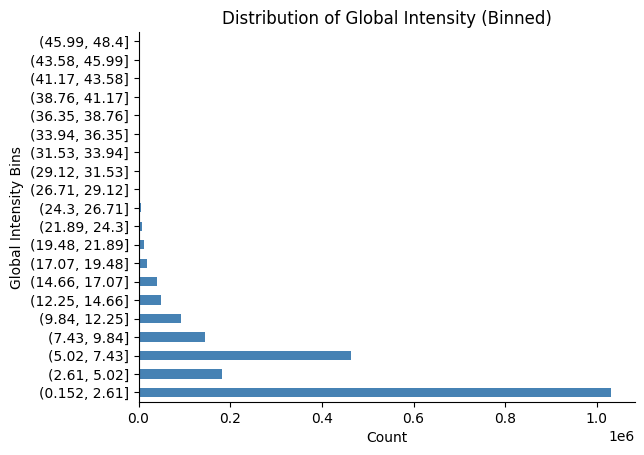

In [16]:
# @title Global_intensity

from matplotlib import pyplot as plt
import seaborn as sns

# Convert 'Global_intensity' to numeric, replacing errors with NaN
df['Global_intensity'] = pd.to_numeric(df['Global_intensity'], errors='coerce')

# Drop rows with NaN in 'Global_intensity' to avoid issues with pd.cut
df = df.dropna(subset=['Global_intensity'])

# Group by 'Global_intensity' in bins
df['Global_intensity_bins'] = pd.cut(df['Global_intensity'], bins=20)  # 20 bins
df.groupby('Global_intensity_bins').size().plot(kind='barh', color='steelblue')
plt.title('Distribution of Global Intensity (Binned)')
plt.xlabel('Count')
plt.ylabel('Global Intensity Bins')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()

Those row counts look a little funky. Let's visualize our missing data.

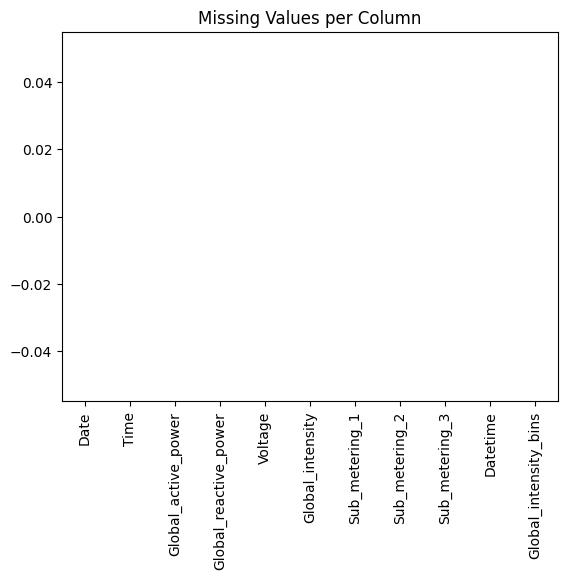

In [17]:
# Visualize missing values
df.isna().sum().plot(kind='bar', title="Missing Values per Column")
plt.show()


In [18]:
# Drop rows with missing values
df_cleaned = df.dropna()


In [19]:
# Fill missing values with the mean for each column, excluding 'Date' and 'Time' columns
numeric_cols = df.select_dtypes(include=np.number).columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())

<ipython-input-19-2c07e469bcff>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())


<Axes: xlabel='Date'>

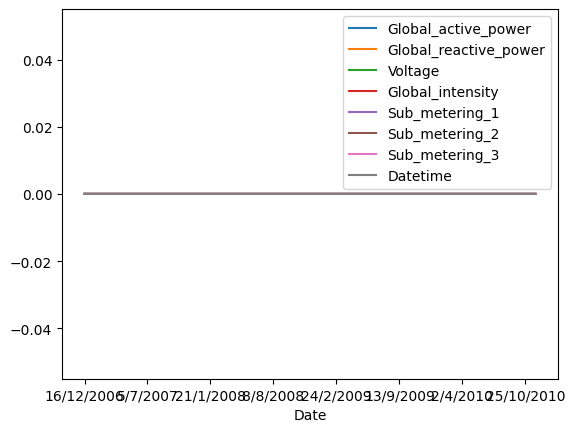

In [20]:
#https://stackoverflow.com/questions/53947196/groupby-class-and-count-missing-values-in-features
df_na = df.drop('Date', axis = 1).isna().groupby(df.Date, sort = False).sum().reset_index()
df_na.plot(x='Date', y=df_na.columns[2:-1])

**Q: What do you notice about the pattern of missing data?**

A: The spikes indicate the amount of missing data for different variables over time.The missing data is concentrated at specific intervals, possibly indicating issues during data collection at certain times. Sub_metering_3 has the most missing values.

**Q: What method makes the most sense to you for dealing with our missing data and why? (There isn't necessarily a single right answer here)**

A:Imputing missing values makes the most sense because dropping rows would remove significant amounts of data. I would use the mean for continuous variables like Global_active_power and forward-fill for categorical or time-based data.



**TODO:Use your preferred method to remove or impute a value for the missing data**

In [12]:
# Drop rows with missing values
df_cleaned = df.dropna()

# Fill missing values in numeric columns with their respective means
numeric_columns = ['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity']
for col in numeric_columns:
    df[col] = df[col].fillna(df[col].mean())

# Forward-fill remaining missing values for time series consistency
df = df.ffill()

# Fill missing values in Sub_metering_3 with the column mean
df['Sub_metering_3'] = df['Sub_metering_3'].fillna(df['Sub_metering_3'].mean())

# Check for remaining missing values
print("\nMissing Values After Cleaning:")
print(df.isnull().sum())


TypeError: Could not convert string '4.2165.3605.3745.3883.6663.5203.7023.7003.6683.6624.4485.4125.2245.2684.0543.3843.2703.4303.2663.7285.8947.7067.0265.1744.4743.2483.2363.2283.2583.1782.7203.7584.3424.5124.0582.4722.7902.6242.7723.7404.9286.0526.7526.4746.3084.4643.3963.0903.7302.3082.3884.5984.5244.2024.4722.8522.9282.9402.9342.9263.4524.8704.8684.8663.1762.9202.9302.9122.6082.7143.5386.0724.5364.4082.9122.3262.2642.2702.2582.1882.9784.2004.2044.2182.7862.5402.4962.3362.3222.4484.2984.2304.2303.9244.2184.2244.0703.6123.4583.4343.3663.4043.3823.6163.4763.3943.4003.4143.4323.4183.3923.3943.3943.4063.4203.4183.4223.3323.3163.3343.2623.4763.6203.6103.6463.6143.4083.3883.3723.3703.3423.2843.2763.3823.4183.3963.4063.4063.3923.3783.3683.3503.3523.3643.3803.4043.3783.3883.3763.2543.2143.2023.2023.2123.2063.2143.2063.2223.2163.2163.1943.2783.2823.2923.3163.3703.4203.4103.4003.4003.3883.3703.3323.3103.3123.3143.3023.3023.3003.2903.2863.2303.2183.2583.2643.2603.2623.2643.2383.2283.2223.2263.2063.1883.1963.2043.2323.2543.3763.3723.3663.3863.4963.4263.4403.4403.4543.4503.4803.4743.4561.8322.0443.3543.2823.3083.3143.3061.6923.3423.3543.3343.3302.7402.1883.3303.3403.3063.0441.7663.3763.4143.4263.4201.8763.4423.4143.4122.5422.8203.4103.3922.8781.8483.4943.4203.2261.9483.3923.3683.3781.8723.2123.3463.3083.3022.3602.6523.3923.3983.4241.8603.2503.5023.4843.4781.6963.4943.4823.4803.4742.3082.9263.4723.4803.4543.4641.7863.1823.3783.3723.3623.1121.6143.3583.3883.3922.8102.1803.3703.3262.7782.3580.9601.6062.3502.4282.0780.7802.4262.4122.4281.5301.3882.4242.4282.3880.3762.2022.4302.3461.9160.3842.3342.3202.3062.3060.4361.5842.3282.3262.3341.8460.2842.3422.3922.4142.4140.7541.4202.4682.4742.4881.8100.6742.4442.4102.4122.2060.3702.1042.4042.4182.3421.2620.8522.3402.3362.3342.3301.0380.3862.3502.3462.3461.8341.2222.3422.3341.6661.1982.3502.3982.4440.4062.4342.5022.5181.5161.4982.5082.5042.4920.8142.3042.5302.3780.3842.3702.3582.3520.4162.6542.5402.5261.2063.8444.1223.4581.9880.5961.2902.7302.7342.7642.5861.0441.5203.0382.9742.8462.8482.8582.4720.6580.8382.6082.5982.5602.5262.4721.6580.4220.7902.4362.3962.3382.3040.2760.7122.3322.3442.3542.3322.3680.6120.2861.9522.3762.3742.4061.0040.3881.4582.4802.4542.4682.0280.3820.9022.4662.4562.4502.4480.9300.2861.3762.4562.4562.4442.1220.3560.9522.4262.4202.4121.0080.4302.6763.7664.5825.2822.3623.2504.6185.2424.8603.7383.4265.2545.2465.2163.8582.8223.8404.6364.6344.6523.1301.7563.4784.5003.5523.9402.4402.0803.6524.4324.4602.1862.3583.9543.7463.9443.6801.6703.2144.5003.8002.6642.5282.6684.2564.1263.2160.5742.3443.8044.6223.2180.7740.5721.9522.6082.6002.5681.3340.3621.2382.4482.4261.7940.2880.6082.4262.4422.4280.6740.3062.0902.5082.2280.3080.2902.4422.5142.5060.3880.5382.4962.4702.4480.8200.3082.4502.4322.4441.9700.2560.5082.3702.3522.1400.2120.9922.3622.3841.9280.2180.6562.3982.4121.6720.2261.6322.3522.3280.7320.2062.3322.3902.4760.6040.3801.7742.5202.5422.2280.5901.3542.7342.7342.0020.4720.8762.3242.3422.3260.3020.2082.0222.3562.3462.2400.2240.4242.3442.3082.3381.4800.2220.8202.3522.3122.3240.2320.3421.9402.4562.4481.8380.3201.1542.4422.4102.2820.3200.8122.4462.4262.4100.4360.4922.4242.3922.3820.7540.4122.3542.4122.4261.3840.2921.3302.3962.4222.4020.4300.6662.4202.3902.4460.9780.4002.4322.5002.5200.7880.4022.2382.5122.4861.9360.3760.9082.3362.3462.3281.7080.2060.5162.4262.4302.4242.3060.2880.7563.4983.5223.4603.4341.6461.3362.8743.4103.4123.3861.8441.4143.3523.5003.5163.1741.4281.9943.4923.4603.4923.4821.4921.3263.2823.4223.4243.2541.3202.2943.4003.4023.4182.9941.3262.0203.3783.3723.3743.4261.4621.8343.4623.4862.9100.9360.3381.9262.4202.4382.4302.4540.4240.7162.4622.4602.4181.0000.2981.6502.3102.3322.2420.2240.7522.3302.3222.3120.7600.3642.3362.3122.3320.8560.8642.3022.3241.8520.2262.1842.3801.9200.2542.1642.5542.0260.4142.1062.5222.0760.4022.1182.4861.3400.6662.4402.4261.2780.4302.4262.3822.4060.3301.2082.4062.4422.4262.4322.4140.4840.3122.3522.4282.5822.7842.6801.4200.9083.1943.3282.6701.2381.1200.5920.8000.8200.7960.7980.6940.6940.7580.6820.6640.6420.6600.6360.6600.6380.4780.3160.3300.3800.5220.4220.2620.2200.2460.2120.2420.2220.2400.2160.2280.2100.2760.3220.3360.3180.3140.3280.3080.3260.3042.2062.3382.3622.3562.3242.2642.2802.2582.3062.2882.3002.3462.3782.3462.3502.3262.3362.3260.5040.2681.7342.3182.3222.3022.3182.3022.2902.3760.3680.3321.7342.4162.4002.4182.3882.4062.3781.1640.3000.7002.3762.3202.2782.2802.2782.2942.2802.3000.2100.2162.2562.3122.2882.3082.2722.3540.6160.2821.7802.3482.3682.3622.3782.4302.5120.6160.3981.5282.4842.4622.5022.4842.4862.0400.4020.3801.8762.3602.3642.3362.3522.3402.3600.9140.2901.0582.3742.3882.3582.2942.2782.2800.2680.2221.6222.2962.2782.2962.2602.9402.7921.1580.9322.5142.9842.9962.9403.2785.9087.0646.9266.5806.0506.1044.7624.5064.4723.7080.7241.8922.0122.3722.3862.4002.4241.0660.3801.6322.4102.3802.4022.4382.4321.6400.4241.4102.7222.7122.7062.4882.4241.2580.3700.7862.4742.4742.4882.4862.4442.2720.3380.2901.4662.3242.3202.3082.3142.3122.3060.4440.2681.8462.3082.2902.2882.2962.2920.3700.4723.0543.4803.5723.5603.5283.4902.0381.4062.8403.3883.3943.3601.3541.3341.3581.3701.3221.3041.3941.7022.2423.7143.2123.6943.2043.6763.6663.6783.7223.7163.7504.1705.7765.7185.7385.7145.7325.7305.8485.8425.8805.8725.0705.4885.8985.0263.2462.7123.5383.5743.0163.0024.4445.5684.8405.0665.5703.6502.3943.0243.2503.3782.2643.1082.9781.9661.9282.5261.5101.5721.6021.5621.5501.5861.6581.6581.6501.6762.4923.8283.8223.8343.8103.8243.8383.8443.8243.8443.8804.0043.7843.7843.7922.1461.6081.8281.9221.9781.9301.9641.8541.7621.7381.7661.7461.7341.7381.9581.9641.9622.0502.0322.0361.9641.9701.9461.9701.9621.9881.9721.9741.9541.9582.0101.9461.9281.9081.7081.5641.5401.5601.5841.7341.7721.8741.7401.6221.8541.8541.9061.9463.3603.5182.4381.9241.9542.0182.0141.9921.9962.0021.9641.9301.8301.7062.9303.1821.7181.7161.7101.7121.7021.7321.7221.7121.7161.7141.7101.7221.7201.7141.7361.7261.7121.7201.7181.7041.7541.7981.7421.7401.7421.7501.7361.7121.5661.4881.4941.5041.4981.4401.4401.4341.4461.4421.4341.4561.4621.4781.4701.4561.4501.4481.4421.4461.4461.4401.4401.4361.4401.4361.4341.6481.7341.8161.8081.8221.8221.8261.8241.8201.8101.8101.8061.8141.8121.7841.7581.7681.7641.7642.1523.0921.7901.7601.7521.7501.7441.7701.7941.7741.7821.7882.4001.8001.9382.3042.0661.9381.8021.9542.0582.1022.1182.1202.1062.1242.1342.1342.1202.1222.1182.1062.1362.5102.6802.3722.1542.1462.1402.1422.2282.1902.1222.1182.1202.1182.1102.1102.1102.1082.1041.8561.8581.8702.0462.1522.1702.1622.1602.1542.2382.2402.2482.1882.1522.1302.1102.1122.1202.1082.1062.0761.9962.0042.0102.0021.9341.9542.0602.0222.1282.1802.1782.1722.1802.1002.1422.1442.0702.0423.0063.1563.1183.1244.5025.5703.0542.8862.9022.8922.8882.8802.8583.3824.9444.9284.9084.9184.9564.9444.9684.8904.9002.8124.7942.9202.8522.8142.7442.7602.7582.8242.8482.8442.8102.8202.8182.8422.8342.8302.8242.8142.7942.7942.7802.7802.7562.7482.7762.8422.8562.7982.8102.8102.7922.7922.7502.7624.8384.8784.8644.8684.8764.8104.7904.7844.8064.8344.8564.8444.9123.1202.7302.9622.7642.7482.7222.7682.8322.8042.7882.8022.8002.7762.7682.7982.8463.2343.2563.2723.3283.3163.3903.4183.3843.3743.3883.3763.3543.4723.4843.4223.4163.4463.6603.5863.5563.6043.7283.7003.6783.6703.7023.7443.7963.8083.5803.3703.1303.2383.3903.3603.4003.3963.2822.9963.0023.0002.9943.0583.1183.1683.2623.3063.2883.2823.2923.2803.5023.3763.3323.2923.2803.2983.2963.2743.4123.4123.4183.4163.4183.4303.4343.7923.6523.5903.3283.3363.3863.5283.4963.3963.2663.3403.2603.2363.2163.2323.2363.2543.3083.6124.1006.2546.2044.5363.6063.5943.6143.6123.6123.5763.5523.5503.5663.6603.6243.6263.6203.4203.3563.3623.3723.3803.3443.6123.6523.6383.6183.5883.5963.7083.7903.7603.7543.7423.9543.8103.8083.9783.9744.0064.1124.0604.0504.0464.0784.1804.1323.7683.5563.5282.9222.4202.3982.3982.3882.4323.7643.7823.2222.2102.2082.2202.2342.2242.1642.4722.5062.1682.1542.1462.1342.1042.1042.1162.1142.5322.4782.3662.7403.4243.5384.0124.8423.5783.4383.2903.1303.1503.3143.0223.0043.0202.9603.5442.9343.0343.2443.3043.0243.0322.8262.5582.5142.4062.3882.3142.3262.5602.6702.4202.5502.6002.6282.6322.6642.5762.9723.2023.1783.1903.2603.2623.3903.5663.6684.4644.4483.6983.7123.7323.7363.6603.6363.6203.6143.5903.6103.6163.6443.8223.5383.5043.6823.6943.6923.7123.6283.3743.3683.3523.3503.3183.3243.5943.7983.8523.8323.8323.7503.5683.4763.3163.2743.2443.5763.8983.6383.2043.0783.0763.0863.0022.9923.0383.0883.1163.1083.0963.0863.0763.0803.0803.0963.1303.0743.1183.0823.0683.0843.2683.3163.0703.1003.0983.0963.1003.0943.1003.1183.1243.1083.1403.1383.1203.1023.0983.0863.0802.9962.9142.9862.8402.8242.9702.9102.7542.5882.6242.6142.6182.6042.5962.5882.6942.6902.6822.6882.6882.6882.6942.6902.6882.1561.6501.6521.6461.6561.6481.6541.6321.6321.6761.7141.7201.7261.7221.6541.6621.6601.6601.6541.6521.5821.5821.5421.6781.7481.7521.9102.1361.7540.8620.8120.8080.8060.8120.8180.8200.8480.9140.9020.9020.9020.9020.8880.8920.8500.7960.9000.9120.9120.9140.9380.9521.1160.8640.7240.6020.5660.5660.5660.5640.5600.5000.4920.4960.4980.4160.4040.4040.3180.2920.2900.2880.2860.2880.3960.3820.3820.3800.3780.4440.4780.4720.4700.4700.4680.4640.4620.3960.3780.3780.3760.3740.4400.4520.4540.4540.4520.4500.4460.4440.4420.4400.3880.3660.3640.3660.2840.2760.2740.2740.2740.2760.2780.2380.2080.2060.2060.2060.2040.2040.2120.3160.3080.3060.3060.3060.3060.3020.3020.3000.3000.3020.3000.3160.3760.3740.3720.3720.3720.3680.3680.3660.3660.3420.2940.2300.2020.2020.2020.2040.2040.2040.2060.2040.2040.2020.2020.2020.2020.2020.3000.3100.3080.3060.3040.3000.3000.2960.2960.2960.2960.2960.2960.2980.2980.3240.3720.3720.3720.3680.3680.3680.3480.2760.2740.2260.2920.2920.2920.2940.2920.2900.2900.2880.2860.2860.2840.2820.3980.3820.3800.3760.3740.3720.3720.3700.3700.3700.3700.3700.3680.3680.3680.3280.2980.2960.2960.2940.3740.2800.2800.2820.2820.2800.2800.2760.2760.2180.2040.2040.2060.2080.2100.2100.2780.3140.3120.3120.3120.3120.3120.3100.3080.3040.3040.3040.3020.3020.3040.3040.3040.3040.3020.3020.2400.2100.2100.2100.2120.2120.3040.2860.2860.2840.2840.2820.2820.2800.2600.2080.2640.3180.3120.3100.3080.3080.3080.3080.3080.3080.3040.3060.3060.3040.3060.3060.3040.3040.3040.2720.2120.2120.2100.2080.2820.2960.2960.2960.2960.2960.2960.2960.3680.3660.3680.3680.4700.4700.4640.4580.4480.3780.3760.3780.3780.3780.3800.3780.3760.3720.3000.3000.2980.2980.2480.2060.2060.2080.2060.2060.2080.2080.2080.2100.2100.2080.2080.2040.2060.2060.2060.3020.3160.3100.3100.3760.3840.3820.3820.3780.3760.3760.3780.3840.3160.3020.3000.3000.2720.2100.2100.2100.2100.2100.2100.2120.2100.2100.2401.3681.3581.3421.3261.3121.3061.3521.4101.4221.4181.4221.4241.4081.3981.3981.4121.3981.3901.3921.3941.4721.4861.4821.4041.3941.3941.3821.3761.3661.3061.3021.3041.3081.3161.3281.3341.3301.3321.3341.4101.3820.4040.4000.3960.3940.3900.3880.3880.3860.3840.3820.3820.3800.3780.3740.3740.3040.2820.2820.2820.2820.2800.2780.2820.2860.2880.2880.2820.2840.2820.2840.2840.2460.2600.3160.3100.3100.3080.3140.3140.3100.3060.3060.3040.3020.2980.3000.3020.3000.2180.2080.2080.2060.2140.2140.2140.2140.2120.2120.2120.2120.2060.2080.2140.2140.2160.2460.3220.3740.3900.3900.3880.3880.3860.3820.3800.3780.3080.3040.3060.3040.3000.2160.2160.2160.2140.2160.2180.2140.2140.2140.2100.2100.2100.2120.2100.2100.2100.2120.2400.3180.3140.3120.3100.3100.3100.3080.3180.3620.5383.4084.8161.9621.7141.6841.2262.1802.7820.8820.5960.5860.6180.6940.6840.6780.6800.6680.6660.6700.6700.6720.6820.7160.7820.8280.8460.8320.8260.8320.8300.8380.8500.8722.2502.9423.4103.4723.4663.3863.3303.3483.3103.3203.3983.4123.4443.5983.7503.8363.7923.9843.9923.9583.9683.9643.9183.8845.1664.7882.6762.6103.0963.8923.4762.1702.3222.2102.4282.5322.2262.2622.6762.2422.1281.9701.5921.5221.5081.3541.3301.3222.9183.4923.5203.4923.5163.5083.4863.5183.6443.6643.6283.6443.6261.8661.4761.4901.4781.4481.4061.4101.4081.4101.4021.3981.3041.3081.3021.3061.3061.3081.3161.3221.3221.3221.3121.2821.3241.3181.3301.3201.3261.3241.4261.4241.3661.4043.0783.5463.5623.6183.6263.6523.6783.6943.7083.7083.6943.6423.5763.6042.0121.3321.3221.3101.3261.3141.3101.3101.3141.3161.3261.3361.3361.3381.2961.2621.3681.3741.3641.3461.3281.3121.3221.3261.3261.3081.3021.3061.3121.3161.3201.2501.2041.2161.2961.3141.3041.2981.3001.3041.2981.2961.2901.2781.2341.2361.2401.2441.2421.2481.3161.3581.3521.3421.3321.3361.3461.3501.3481.3361.3381.3281.3361.3361.3321.2841.2521.2581.2461.2461.2401.2381.2381.2221.2401.2521.2961.3261.3321.3261.3341.3301.3301.3181.3301.3801.3781.3621.3521.3541.3561.3541.3441.3481.3561.3481.3401.3461.3521.3541.3321.2541.2481.2501.2581.2701.2661.2661.2601.2721.2681.2601.2541.2541.2441.2481.2581.3341.3301.3921.4061.4601.5161.5101.5061.5041.4941.5021.4921.4301.4161.4061.3981.3921.4201.7201.7561.6121.6021.5981.5081.3161.4981.5901.6021.5801.6001.6021.6101.6121.6301.6361.6261.6261.6261.6161.6121.6181.6981.7281.8001.7861.7901.7881.7961.8001.7921.7841.7781.7661.7221.7261.7341.6861.6221.6181.6141.6201.6181.6241.6361.6381.6501.6401.6421.6261.6281.6261.6301.6241.6301.6381.6361.6181.6221.7101.7421.6221.6902.3522.1381.5302.4142.0922.8583.1223.0923.0543.0263.0022.6861.4681.4341.3801.3781.3881.4061.4101.4121.4121.4141.4081.4101.4161.4221.4201.4101.4101.4121.4081.4021.3941.4801.5121.5121.5061.4581.6501.7661.7621.7601.7581.7561.8121.8481.9141.9301.8741.8441.8361.8381.8261.8341.8321.8301.7741.7681.7661.7681.7341.7261.7261.7321.7401.7401.6341.5001.4941.6341.7461.7301.7201.7201.7101.7141.7081.7001.6921.6901.6941.6961.6961.6921.7021.7461.6941.6901.6881.6861.6860.7640.4860.4080.6121.5161.4421.4261.4041.3981.4101.4041.5921.5941.5941.6061.6161.6321.7181.7101.7081.7181.8201.8941.8761.8641.8601.8701.8761.8801.8661.8741.8641.7941.7961.8761.8761.8781.8821.8881.8901.9021.8981.8881.8941.8581.8261.8221.8281.8201.8181.8121.8041.7981.8141.8701.9341.9341.9281.9181.9021.8961.8861.8881.8861.8862.0902.0601.8881.8881.8802.1202.1161.7641.7941.7101.7081.7061.7021.7041.7021.7001.6841.6781.6801.6341.6201.6261.6261.6201.7341.7441.8001.9262.0962.0541.8281.8081.8081.8081.8121.8121.8141.8221.8061.8081.8161.8221.7661.7061.7001.6841.6881.6901.6861.7181.7141.7101.7081.7121.7141.6981.6861.6801.6861.6281.6221.6161.6101.6081.6141.6621.7301.7341.7341.7421.7481.7481.7381.7201.7201.7221.7001.7001.7141.7281.6961.6481.6461.6461.6461.6381.6441.6381.6421.7201.7142.3322.5442.5362.6222.6002.5502.5222.5181.6282.1542.4622.4562.5582.7142.6822.4662.4002.5782.5541.7241.7481.8281.9261.9081.8981.8681.9461.8041.7641.7521.7441.7521.7321.7361.7461.7421.7621.8541.9342.2402.5282.8042.9323.0462.9082.6182.7062.7702.4921.9501.9562.0682.0361.8761.8281.8182.1861.9821.9781.9701.9741.9881.9842.3162.8122.7762.7222.3921.8901.8961.9521.9781.9121.8001.8181.8701.8581.8681.9422.2522.6042.6522.6542.6462.3842.3942.7862.7282.6062.4962.7782.5982.6042.6102.5942.5822.7702.8142.7822.6202.5102.5202.6502.6842.5802.5502.5582.6782.3962.4422.4642.4722.2921.8801.8761.7081.6961.6881.4862.0802.2142.2122.2282.2242.2122.2262.2222.2402.2582.2662.2542.2382.2422.2542.7402.7862.7642.6362.5682.5602.5622.5602.5242.4802.4821.6221.4561.4561.4561.4521.4561.4661.4641.3641.3721.3801.5121.6341.7102.0282.3002.3182.2942.0502.1543.5364.3144.2504.7144.6424.5804.6844.8364.7624.6804.6785.4366.1584.8684.3004.0583.7584.0123.1662.1641.7861.7961.7721.7441.7241.7101.7421.8461.8761.7461.7182.0101.9941.9881.9861.8481.5061.4821.5741.5561.5481.6161.6661.6701.6661.6641.6601.6481.6601.6581.7982.5642.5602.7223.3303.2763.3603.4324.5163.7003.8364.1143.3863.3243.2803.3123.3043.2923.2683.2823.2643.2042.9562.6742.7862.8922.9583.4543.4143.8103.6123.4063.3423.4183.4303.3823.3803.3743.4183.3483.4163.3983.3943.3923.3143.3123.3023.2903.2643.6023.2643.2743.2703.2983.3163.3063.2983.2883.2823.2863.2843.2923.3203.3362.4642.2982.3022.4002.3861.9581.9582.0222.0442.0382.0302.0242.0462.0242.0062.0062.0001.9741.8681.8361.8421.8541.8661.8701.8681.8621.8501.8601.9521.7821.6441.6521.6541.6641.6581.6541.6641.6681.6581.6641.5061.4881.5041.5041.4901.4901.4821.5561.5421.5341.4801.4861.4881.4921.4821.4521.3781.3341.3321.3701.4061.3961.3901.3961.4081.4041.4001.4121.4201.4081.4141.4121.4181.4281.4241.4161.4041.4041.3961.4581.5021.4981.5021.4961.3841.3761.3741.4481.4501.4201.4121.4802.5103.0882.7303.3322.5562.6502.6502.6022.5362.5162.5462.5262.5362.5342.5342.5022.4981.6042.0622.4882.0621.6362.5542.0241.6062.5962.0301.8182.6281.6962.1122.5561.5302.2842.2641.5922.7001.9002.1022.3681.3662.5221.7701.9262.3461.2542.4661.3522.0141.9321.5201.8122.1821.1462.4721.2962.0060.5580.4640.4320.4620.4300.4600.5340.5700.4280.4420.4420.4480.4260.4400.4200.4360.4160.4340.4140.5040.4080.4160.3940.4100.3900.4080.3880.4060.3380.3340.3140.3320.3140.3320.2960.2600.2420.2620.2440.2620.2540.2500.2600.2400.3340.3520.3660.3460.3620.3440.9841.4461.4541.4221.4281.4101.4261.3981.3461.3061.3821.3801.3961.3761.4041.3841.4081.4661.5921.5321.5141.5081.4881.4881.4781.4221.3001.3141.2921.3140.6820.2560.2640.3660.3420.3600.3400.3560.3360.3520.3340.3520.3300.3500.3400.3400.2980.2380.2580.2400.2580.2740.3340.3160.3340.3180.3340.3140.3320.3120.2780.2400.2580.2400.2600.2400.2580.2380.2580.2380.2580.3300.3700.3460.3640.3560.3460.3580.3380.3540.3360.3520.3340.3660.3920.3420.3220.3440.3260.3460.3280.3460.3280.3880.4000.4180.4000.4180.3960.4120.3920.4100.3240.3380.3220.3360.3360.3220.3340.2760.3780.3560.3720.3520.3700.3500.3680.3460.3640.3440.3600.3400.3600.2560.2660.2460.2680.2500.2660.2480.2680.2480.2660.2480.2660.2740.3360.3420.3240.3420.3220.3420.3220.3380.2660.2640.2460.2640.3280.3780.3540.3720.3500.3700.3480.3640.3460.3620.3420.3600.3380.3120.2440.2620.2420.2600.2520.2520.2640.2460.2660.2480.2680.2460.2640.2440.2580.2420.2900.3180.3360.3180.3380.3180.3340.3120.3220.3480.3680.3460.3640.3440.3620.3420.3600.3400.3600.3540.3480.3580.2640.2640.2420.2620.2420.2600.2420.2600.2440.2640.2440.2620.2440.2640.2440.2700.3420.3500.3300.3500.3280.3460.4140.4200.4020.4500.5160.5240.5200.5000.4500.4220.4380.4160.4320.4140.4300.4080.4040.3160.2900.2480.2660.2420.2620.2400.2600.2420.2600.2420.2620.2420.2620.2440.2620.2460.2700.2600.2600.2680.2500.2640.2440.2620.2900.4120.4220.4400.4200.4380.4180.4380.4200.4160.3420.3620.3420.3160.2400.2580.2400.2580.2400.2600.2420.2640.2460.2660.2560.2520.2640.2460.2660.2440.2580.2400.2560.2360.2560.2380.2600.2440.2640.3160.3740.3500.3680.3400.3560.3360.4220.4080.4260.4080.4240.4060.3580.3160.3080.2640.2480.2640.2420.2600.2400.2600.2400.2600.2440.2640.2460.2640.2440.2620.2440.2640.2440.2620.2420.2620.2440.2620.3700.3720.3480.3660.3460.3640.3480.3520.3540.4020.4360.4160.4340.4080.4180.4000.4200.4000.4180.3960.4120.3540.3380.3180.3360.3200.3400.3200.3380.3160.3280.3100.4281.4845.2444.8564.8622.6361.3441.4021.3962.3502.5161.2341.3101.3721.3700.7820.7840.7640.7720.6580.5660.6520.6340.6360.6360.6380.6340.6340.6280.6460.5840.5820.5760.5660.5620.5720.5640.5780.5880.5920.5820.6140.6480.6481.3001.9761.9221.6482.5863.0683.0503.0323.0523.2103.1943.1043.2883.2843.4083.5943.5182.9903.2784.0343.0222.9243.0742.9202.8762.8842.8502.8302.8082.7242.9143.1083.1383.0841.9322.3063.9623.9484.2144.3204.3084.2664.3484.3524.3584.3724.2863.8481.9601.9762.5081.9361.8641.8161.8481.8982.0201.8721.8341.7961.8281.5801.5661.4081.8181.7241.6481.7261.7303.8643.9404.0405.8085.3545.4705.5366.6627.8287.8407.8187.8166.4985.7685.7746.9647.7466.7805.8144.9785.0245.9945.8285.6805.4944.6745.6985.6683.5422.9443.4922.9442.0642.5142.2421.4922.6422.5301.7702.6422.7321.1122.3001.8642.0181.1822.4941.4120.6760.8480.5460.5060.5500.5140.5400.5140.5240.4280.3300.3500.2680.2460.2260.2520.2320.2500.2300.2440.2280.2500.2380.3020.3200.3020.3260.3080.3260.3020.3160.2980.3080.2220.2440.2300.3240.3320.3440.3240.3400.3160.3320.3120.3300.3160.3340.3160.3380.3200.3020.2220.2420.2340.2300.2440.2240.2440.2240.2440.2260.2440.3160.4100.3920.4080.3900.4100.3860.5980.5800.5460.5100.5240.5600.6300.6120.4221.4921.2240.5660.5660.5860.5660.5840.5660.5600.5500.4580.3940.3920.4001.4762.4101.9422.4521.9303.7344.6024.6984.7024.7024.6604.6184.6684.5421.6961.8722.4042.2261.2462.4121.8521.8082.5641.5582.1582.3081.3642.5601.7981.9502.4001.5962.6921.8382.2502.0721.4882.3921.3422.0881.6441.7801.8761.5362.3801.2682.1621.7661.8282.1621.4362.4841.3682.2161.6361.8481.8941.4921.5162.3021.1102.4881.3242.0561.4380.6100.5660.6060.5780.5860.5720.5860.4840.2960.3140.2900.3080.2880.3040.2840.3020.2820.3020.2820.3000.2840.3820.3780.3620.3800.3520.3680.3400.2940.2520.2200.2020.2840.3140.3300.3080.3300.3140.3320.3040.3200.3000.3200.3000.3200.3000.2460.2040.2240.2060.2240.2160.2240.2320.2040.2240.2060.2240.2040.2240.2500.3000.2800.2980.2780.2960.2780.4980.4840.4360.4300.5340.5260.5300.5180.3260.3220.3080.3220.3020.3180.3040.3260.3060.2840.2040.2220.2020.2200.2020.2220.2020.2220.2020.2220.2040.2240.2080.2300.2080.2680.2800.3000.2820.3040.2940.2960.3000.2820.3580.3180.3340.3180.3380.3160.3340.3140.3260.3080.3240.3440.4080.3720.3140.2940.3140.2980.3220.3020.3200.3000.3180.2980.3160.2900.3080.2960.2960.3060.2860.3040.3700.3880.3680.3880.3340.3120.3720.4220.3760.3360.3140.3320.3080.3260.3060.3260.3120.3340.3120.3340.2380.2360.2160.2280.2100.2300.2240.2180.2320.2120.2320.2180.2360.2160.2340.2160.2360.2100.2280.2100.2840.2860.3080.2900.3540.3900.4080.3840.3940.3120.3140.2900.3080.2880.3060.2900.3040.3040.2560.2120.1960.2200.2000.2200.2000.2180.1980.2120.1940.2140.1960.2180.2020.2160.1980.2220.2080.2300.2100.2300.2520.4060.3900.5220.4260.3980.3880.7401.5301.4941.4401.4061.4321.4381.4361.4041.4221.3141.3261.2981.3021.2921.3161.2961.3141.3641.4021.3861.4101.3741.3921.3761.4001.3701.3781.3501.3741.3681.3621.3701.3501.4621.5321.5581.5521.5721.5481.5701.5461.5381.4501.4161.3761.3941.3801.3201.2941.3601.2941.3761.3541.3241.3061.3101.2901.3061.2701.2981.2801.2761.3021.2921.3061.2821.2841.2681.2921.2741.2921.3141.3841.3581.3741.3941.4261.4241.5521.5441.5501.5301.5401.5121.5041.5301.6921.4481.5041.6221.6121.4461.4321.4461.4221.4361.5621.5601.6921.9882.2742.2922.2682.2942.2642.2762.2582.2762.2642.3322.2762.1122.1002.1462.0903.0363.5883.7043.6283.6283.6243.7263.7623.9963.7983.9043.8502.3602.3062.2922.3222.3522.4482.5022.3682.5422.8142.8222.9182.6382.7442.7342.7642.6562.6943.6962.9482.6542.3642.2482.0681.6121.9881.8721.8181.8422.2422.2942.2822.1382.1262.1122.0342.0402.0042.0882.1101.9441.9201.9281.9301.9061.8021.8241.8441.8501.8361.8541.8281.8481.8361.8541.8541.8341.8861.8621.9861.9701.9701.9521.9902.0461.9561.8422.3802.0722.0541.5481.4761.3561.3981.3541.3741.3621.3501.3381.3401.3682.0482.4102.2182.3602.3642.3602.3702.3802.3562.3542.3642.3682.3642.3622.3742.3722.4862.4981.8881.5441.5281.4881.3361.3401.3441.3321.3361.3421.3401.3441.4161.4201.2801.2781.6881.9481.9842.3242.1221.9042.1442.1662.0041.8981.6261.7843.4662.9223.3242.5102.7142.7883.3663.5324.1444.1424.1865.3425.5864.1664.2163.2664.2585.1504.0382.7604.4124.1263.3223.3563.8383.1823.5402.0782.4902.7641.7983.0042.1702.4122.7501.8342.9361.9922.4202.5101.9042.9201.7242.6862.1822.2142.7121.8482.9861.9582.5082.4102.0442.8441.7102.7921.9922.4302.3542.0362.7361.6002.7121.9282.3002.3681.8182.7961.9062.4362.4721.8122.5821.0961.3042.1442.3002.3300.8041.5201.9762.7740.9640.8280.8380.9320.8880.9160.8840.9140.7340.7040.7280.7200.7160.7220.6980.7200.6640.6280.6160.6280.6060.6220.6040.6160.6020.6160.6320.7000.8821.9321.4461.3460.9680.9860.9641.0120.9940.9880.9701.1020.7660.8100.8020.7940.8060.7860.8040.8840.8840.8660.8820.8600.8580.8260.8100.7140.7360.7160.7340.7140.7280.7060.7240.6980.7520.7680.6180.5840.7180.7160.7140.7140.6860.6500.6020.5240.3760.3960.3720.4800.4840.4980.4780.4940.4780.4940.4760.4980.4580.4780.4560.4680.4500.3900.3540.3720.3620.3620.3720.3540.3720.3540.3980.4340.4540.3860.3920.3700.3860.3660.3860.3680.3400.3240.3820.2980.3140.3380.4280.4060.4220.4000.4180.3980.4140.3960.4160.4080.4000.4140.3960.3680.2980.3180.3000.3180.3000.3200.3020.3120.2920.3660.3720.3940.3760.3920.3740.5760.5600.5740.4480.8240.9580.9740.9580.9761.0701.0761.0600.8980.9681.0520.9520.4160.5260.4060.4260.4080.3600.2780.2280.2080.2600.2920.3120.2940.3140.2960.3160.2980.3880.3720.3900.3720.3900.3680.3820.3680.3680.3100.2840.3040.2880.3060.3500.4160.3920.3480.3120.3280.3080.3280.3080.3260.3060.3240.3040.3100.2060.2240.2060.2240.2060.2240.2060.2220.2040.2240.2160.2900.3020.2820.3020.2820.2980.2800.2980.2680.2280.2100.2280.2080.2420.3160.3320.3100.3280.3080.3260.3040.3200.2980.3160.2980.3160.2980.2400.2020.2220.2180.2080.2220.2040.2220.2040.2220.2040.2220.2040.3160.2800.3000.2800.3000.2800.2940.2740.2580.2040.2220.2040.2860.3140.3320.3120.3300.3120.3300.3160.3220.3260.3100.3260.3060.2920.2100.2280.2080.2280.2080.2260.2080.2260.2080.2260.2060.2260.2100.2300.2640.3040.2880.3600.3720.3881.2941.5221.4741.4421.4261.5101.5301.5041.5261.5081.5201.4961.5161.4981.5181.4921.5041.4701.4281.3821.4061.3581.3361.3201.3321.3121.3261.3140.5000.2080.2280.2100.2300.2100.2300.2760.2940.3060.2860.3060.2860.3040.2840.2820.3180.3400.3160.3320.3140.3320.3100.3260.3080.3260.3060.3260.2960.2280.2120.2300.2100.2300.2080.2280.2100.2280.2220.2120.2280.2100.2300.2100.2300.2100.2280.2100.2280.2900.3040.2860.3040.2860.3620.3940.4080.3360.3320.3200.3400.3180.3340.3060.3240.3060.3260.2440.2240.2300.2120.2320.2120.2320.2160.2380.2180.2360.2160.2360.2160.2320.2100.2300.2120.2500.2280.2340.2080.2300.2160.2760.2920.3880.4040.4200.3980.4140.3920.3880.3100.3080.3060.4040.3940.3920.3020.3000.3000.3000.3000.3000.2980.2900.2880.2860.2860.2860.2860.2900.2900.2920.2900.2900.2880.2860.2840.2100.2040.2060.2060.2060.3060.3160.3380.3940.3920.3880.3840.3800.3780.3760.3740.3320.3000.2080.2040.2020.2020.2020.2020.2040.2040.2040.2040.2040.2060.2040.2040.2040.2020.2040.2040.2020.2040.2040.2040.2040.2040.2040.2040.3220.3140.3120.3100.3080.3060.3060.3420.3860.3860.3860.3820.3620.2840.2820.2800.2120.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2080.2080.2080.2080.2080.2100.2080.2080.2100.2080.2640.3520.3800.3800.3760.3720.3720.3680.3660.3640.4720.6300.5740.3180.2900.2920.2900.2900.2900.2880.2800.2680.2100.2120.2100.2060.2060.2080.2100.2120.2440.3140.3080.3060.3140.3160.3200.3240.3220.4160.4880.4920.5800.8724.6644.7741.3021.8742.7581.2381.2881.2441.2041.1081.0441.0341.1621.1581.1601.1661.1641.1561.1581.1441.1121.0881.0941.1161.1781.1761.1681.1721.2582.1042.6082.6022.5582.5902.6382.6282.6362.6142.5822.5322.5222.8323.0502.9823.1303.5425.1665.6465.8925.9745.9885.9245.7685.7185.7585.7565.7285.4165.2605.3204.0383.1262.9502.6702.3602.2742.5882.7722.8682.4262.2482.2882.3302.2782.3042.3002.2842.5442.6622.6242.6102.2141.5901.5642.2982.3601.9962.1641.4701.4081.3901.3861.2941.2941.3261.3661.3601.4021.4741.4741.4661.4021.3421.3301.2861.2861.2861.2921.2881.3001.3881.3881.3861.3741.3761.3801.3841.3781.3801.4001.3881.4521.4761.4461.3901.3801.3861.3901.3841.3821.3801.3761.3661.3761.3921.3861.4681.4581.4521.4561.4581.4521.4561.4521.4461.3401.3061.3041.4081.4181.4061.4101.4041.3981.3961.3921.3861.3861.3941.3921.3961.3881.2921.2901.2921.2941.2961.2861.2881.3021.2981.2941.2981.2921.2861.2781.2781.3621.3601.3681.3561.3461.3561.3541.3361.3281.3601.3581.3641.3601.3581.3661.3561.3581.3541.3581.3521.3561.3541.3561.2981.2721.2721.2701.2681.2601.2601.2541.2561.2501.2501.2501.2561.2561.2561.2521.2581.2581.5843.2463.3423.0963.4802.9683.5403.6244.8424.1063.5423.5163.5183.5303.5263.5023.5023.5443.5603.5483.5363.4743.4783.4903.5183.4843.5563.5743.5823.5703.5723.0922.6623.5583.5762.8482.9303.6063.6262.4403.4823.4742.6682.8103.5782.3283.6382.5763.1943.1702.6701.9941.7161.6721.7161.6761.7181.6641.6621.4501.3701.3881.3501.3301.3701.4341.4141.4261.4181.4341.4361.4201.5581.6421.6501.6221.4801.3241.4261.4041.4281.4101.4001.5461.5081.4781.4881.4061.4121.3981.4101.3981.5261.6001.5921.5961.4381.3941.3961.4001.3961.3901.3861.3021.3041.3041.3041.3061.3101.2961.3061.3041.2961.2981.2981.3001.2961.3081.3561.3941.3921.5061.4961.4941.4841.4901.4821.4621.4001.4021.4021.4061.3902.5381.8401.3901.6141.6661.3981.4001.3621.3061.3081.3061.3101.3121.3101.3161.3001.2981.2981.3001.3041.3021.2981.3041.3021.3101.3401.5001.4981.4941.4841.4701.4621.5281.5461.5301.4781.4861.4841.4781.4781.4781.4741.4281.3721.3881.3921.3881.3821.3841.3961.3801.3801.3761.3761.3741.3941.3881.3241.3181.3261.3201.3201.3821.4161.4141.4001.5101.4921.4901.4801.4761.4821.4721.4701.4501.3981.4001.4021.3761.3181.3201.3181.3201.3101.3061.3201.3201.3221.3261.3341.3301.3141.3121.3101.3061.3061.3141.3261.3281.4221.4421.4381.4261.4201.4241.4161.4161.5061.1680.4000.3960.3960.3980.3920.3700.2980.2320.2340.2340.2360.2360.2360.2340.2280.2240.2240.2260.2260.2220.2260.2280.2280.2280.2280.2260.2260.3220.3380.3360.3360.3300.3260.3220.3220.3220.3280.3240.3220.3660.3980.3980.3480.3020.3040.3020.3000.2960.2600.2200.2220.2280.2280.2260.2260.2240.3220.3100.3100.3120.3120.3120.3060.3040.3540.4160.4160.4140.4100.4100.4080.4040.4000.3980.3920.3860.3840.3840.3860.3600.2300.2880.3040.3060.3060.3020.3000.2940.2940.2920.2480.2200.2220.2240.2220.2220.2300.2280.2280.2820.3280.3960.3860.4420.4360.4300.4260.4260.4260.4260.4280.4320.4300.4260.4220.4180.4160.3720.3240.3240.3222.2123.1382.7120.3980.4020.4040.4040.4040.4000.3960.3940.3480.3240.3220.3220.3220.3240.3220.3260.3260.4500.4400.4340.4340.4340.4320.4320.4300.4300.4300.4220.4200.4200.4180.3880.4000.5060.3360.3360.3340.3780.4100.4100.4140.5040.8860.8840.8720.8700.8740.8060.8060.8060.8421.0821.1400.9880.9761.0241.0881.0781.0761.0661.0641.0641.0741.0721.0761.0781.0781.0701.1241.1421.1701.0661.0541.0541.0541.0561.0901.1601.7862.2042.0642.2982.2782.0302.7664.2864.2344.2024.1964.1764.1624.1804.1484.1084.1624.2244.1824.1684.1584.3224.3344.6564.8244.1283.3723.2583.5704.2683.4782.4142.3922.9783.0783.1263.4703.5043.4683.4663.2423.1823.1863.1743.1963.1963.1523.1503.1123.1003.1223.1463.1403.1163.0903.1943.2183.2343.2223.2023.2023.2463.2643.4243.2163.2263.2403.2243.3063.4223.2542.7822.5782.4322.4422.5602.4842.4882.4842.4822.4842.6282.8622.8502.8023.1463.3003.3023.3123.0383.0483.0524.8065.6725.7425.7604.7583.1283.3383.3503.3443.3503.3263.3623.3143.3143.3263.3383.2643.2023.3623.4483.3703.3164.2404.4064.3704.0704.0182.6842.6063.6524.3324.2304.1243.9804.2463.3043.1283.8404.4923.7263.1843.2703.2443.2303.2543.6743.3163.5723.4723.3723.6823.5303.0803.0683.0263.6923.7123.7303.7363.6883.6843.6503.6463.6523.6103.5923.6023.6383.6623.6023.5943.6143.6003.5943.5863.5923.6003.5363.5283.6283.6703.6543.6783.6783.6583.6723.6763.6923.6883.7003.7123.7063.7683.7703.6803.6603.6623.6603.6443.6623.6723.6443.6683.6583.6023.5703.5683.5623.5603.5763.5703.5603.5723.5583.5543.5623.5843.5623.6763.7023.7083.6843.6983.6963.6703.6823.6843.6963.7783.7843.7363.7003.6403.6203.6223.6403.6423.6483.6383.6463.6343.6263.6463.6323.6323.6163.6103.6143.6123.6063.6283.6163.5963.3263.4723.4023.4383.2403.1303.1383.1523.1363.1262.8842.7682.7582.5282.5202.5282.5342.5382.4662.4682.5242.5842.5762.5242.4762.4862.4842.4862.4742.4842.4862.4922.4882.5042.5122.5222.5182.5022.4882.4862.4842.4942.5802.5922.5442.5342.5362.5362.5282.5242.6082.5902.5962.5982.5982.5922.5582.4982.4962.4922.4882.4322.4122.3682.3102.2842.2682.2882.2882.2881.8982.2162.1722.3262.2822.1682.1702.1782.1982.2122.2242.3282.3182.3142.2982.2702.2702.3102.3422.2502.4562.5702.6402.7542.3242.2061.9461.8881.8141.4741.4781.7541.4661.4081.4021.3961.4001.3961.3981.4001.4061.4161.4181.3961.4141.4121.4181.4221.4221.4301.5421.5281.5081.5021.4821.5481.5521.5541.5561.5561.5641.5641.5601.5321.4461.3861.3841.3921.3981.4001.9442.1762.3621.9281.8682.0461.8962.0481.6621.5521.4801.3661.3601.3281.3081.3061.3141.3141.3041.4801.4881.4841.4841.5461.5501.5561.5481.5401.5461.5441.5401.5381.4881.3781.3861.3881.3881.3861.3861.3821.3821.3821.3801.3061.2981.3021.3021.2981.2941.2961.3001.2961.3041.3041.3121.3101.3121.3141.3881.4161.4101.4121.4881.4821.4841.4781.4801.4581.4421.4461.4401.3701.2821.2821.2761.2741.2701.2781.2761.2881.3081.3101.3081.3041.3021.2981.2961.3001.2981.3021.3041.3061.3021.3121.3121.3021.3041.3521.4121.4081.4081.4481.4701.4721.4741.4621.4661.4541.4501.4621.4121.2981.3001.3041.2961.2881.2941.2921.2961.3001.3001.2981.2961.2901.2861.2921.2961.2921.2981.3001.3021.3001.3041.2881.0540.2060.2240.3180.3160.3120.3100.3540.3840.3840.3820.3800.3780.3780.3740.3720.2240.2080.2080.2080.2080.2080.2080.2080.2060.2940.2920.2900.2880.2880.2920.2920.2920.2900.2920.2900.2880.2880.2840.2860.2880.2880.3580.3960.3900.3880.3860.3820.4300.3820.3820.3840.3780.3780.3740.3240.2400.2060.2060.2060.2080.2080.2100.2080.2080.2080.2080.2080.2080.2080.2100.2100.2140.2200.2160.2080.2080.2080.2060.2040.2060.2060.3100.3180.3140.3100.3080.3120.3140.3640.3880.4120.4100.3900.3780.2920.2780.2640.2060.2060.2060.2080.2100.2140.2120.2100.2120.2120.2120.2120.2080.2060.2040.2040.2040.2020.2020.2040.2100.2100.2100.2540.3220.3180.3140.3120.3080.3060.3040.3020.3000.3000.3940.3820.3420.2860.2860.2840.2820.2820.2280.2040.2020.2020.2000.2020.2000.2060.2100.2100.2080.2060.2040.1980.2000.2000.2000.2000.2000.2000.1980.2980.3140.3140.3140.3060.3820.3920.3900.3880.3860.3900.3880.3860.3440.3680.3660.3660.3640.3620.3600.3560.3540.2920.2860.2840.2840.2840.2860.2760.2120.2100.2100.2100.2080.2080.2080.2080.2080.2080.2660.3220.3180.3180.3160.3140.3120.3080.3040.3020.3000.3020.3060.2860.2100.2100.2080.2440.2860.2880.2880.2880.2880.2880.2860.2840.2260.2100.2080.2080.2020.2020.2040.2100.2100.2080.2020.2040.2100.4480.6400.6760.7741.2661.4241.4041.4001.3841.3701.3521.3581.2381.1241.1081.0740.9280.9100.9020.8020.8461.0501.0901.2161.3480.7500.6560.6600.6680.6100.5960.5900.5900.5820.5760.5800.5840.5860.5840.5780.6983.2585.2762.7881.1821.1901.5642.5201.1801.0041.2081.2841.2161.5781.5341.5341.5281.5141.6221.7401.6481.7701.7741.8541.8461.2741.1661.0441.0101.0021.0661.2381.2381.2321.2040.9180.9160.9160.9301.0101.0961.3541.3381.1801.0300.9900.9901.0021.0101.0081.0001.0041.0020.8821.0981.1440.9801.0701.0141.0201.9302.3962.4362.4482.4202.4402.4402.8883.3443.3183.2923.2662.9081.7921.7901.8101.8241.8301.9241.6201.9701.5941.6021.6561.4681.4003.3143.7343.7203.7383.7063.7183.7303.7643.7463.7423.7283.7703.8102.5083.8964.9543.6423.6863.7443.7983.7543.7003.7083.6943.6563.6703.6623.6883.7043.1901.5741.8781.6481.6241.6241.4061.3601.3521.4261.4521.4621.4561.4481.4461.4461.4481.4561.4521.4561.4581.4241.4301.4161.3521.3101.3641.3661.3761.3641.3601.3761.3781.3861.3261.3723.0323.5963.6423.6143.5983.5923.5963.5703.5563.5383.4883.5323.5703.6143.7281.9541.4921.4881.4901.4981.4821.4741.4721.4781.4841.4801.4761.4701.4741.4101.3801.3961.3961.3941.3921.3601.3221.3221.3121.3141.3121.3141.3181.3220.9500.2440.2420.2420.2420.2400.2400.2400.2420.2400.3100.4460.4240.4220.4180.4140.4140.4160.3940.3380.3360.3340.5881.6780.9740.5620.2500.2400.2420.2440.2440.2420.244??0.2460.2460.2440.2440.2440.2440.2420.2440.2440.2420.2440.2440.2420.3340.3540.3500.3500.3480.3460.3440.3440.3440.3440.3340.9541.3681.9961.9461.8401.8041.7781.3640.2980.2960.2300.2220.2240.2260.2280.2280.2300.2260.2280.2280.2261.1361.0680.2260.2260.2260.2260.2260.2260.3240.3360.3300.3300.3300.3320.3260.3260.3241.4940.5380.3240.3260.3340.3200.3741.1940.3100.3100.3100.3100.3400.3800.3820.3880.3800.3880.3800.6360.8742.6342.0962.6142.2222.4802.6242.6022.6042.5862.5522.5162.5422.5402.5542.4922.4542.4522.4662.4342.4542.4422.4422.4182.4382.4302.4522.0481.4382.4302.4402.3101.2382.3842.3641.2262.3642.0201.4722.4361.5061.9882.0281.7281.6122.3041.3302.4641.1822.3960.9000.6020.5120.5340.5100.4960.4280.4260.3240.2221.3081.3281.3381.3081.3301.3141.3321.3081.3261.3121.3281.3281.3041.3301.3301.3661.3441.3601.3421.3401.3201.4221.4202.2444.2164.2482.9721.5301.5601.5741.5521.5721.5561.5801.5581.5021.4541.4681.5081.5381.1020.4460.4520.4360.4540.4280.3920.3540.3740.3520.3560.2820.3020.2840.2980.2820.3020.2900.5080.4880.5000.6140.6140.5980.6060.5920.3840.4000.3820.3620.3200.3380.3360.4000.3780.3240.2800.3000.2780.2760.2360.2620.2420.2600.2420.2600.2400.2580.2400.2400.2180.2400.2200.3220.3060.3120.3720.5060.5360.5140.5700.5500.4120.3200.3380.3160.3320.3140.3340.3140.3320.3120.3320.3120.3320.2280.2360.2160.2440.3240.3900.5160.3240.2180.2380.2280.2280.2380.2200.2380.2180.2380.2200.2381.1481.3541.3141.3261.3001.3241.3721.4261.4001.4321.4081.4161.3821.4441.4361.4541.5041.5981.5281.5501.4961.5081.4981.3581.3701.3461.3621.3521.3701.3501.3581.3281.3441.3161.3361.3201.3361.3161.3361.3281.3281.2461.2641.2481.2681.2501.3821.3681.3841.3641.3801.3601.3641.3761.3601.3821.6201.5121.4661.5301.5161.3081.2721.2700.2660.3060.2060.2520.3140.4780.4480.4700.4500.6821.2761.2781.2561.1740.3700.4500.5321.0681.5881.5741.5721.5921.7641.7561.7781.7601.7801.7681.7841.7641.7821.7961.8341.5961.6981.9262.4122.6842.8782.7922.8162.7982.8203.1023.5843.5043.5343.0922.8462.8282.8902.8682.8022.8202.8042.8642.8042.8282.5502.4902.3902.4962.6182.5082.4902.7742.4962.4882.4662.4402.4362.4282.4142.4262.4222.4322.3742.3842.3483.6403.8103.8043.7883.7782.6782.5422.5462.6342.6842.6382.6562.7142.7742.7602.7722.7102.5501.9841.9081.7961.7441.8101.8521.8281.7961.7541.7801.9261.8841.7661.7621.7661.7581.8061.8341.8181.7241.7481.7261.7421.7301.7541.6961.7121.6881.9361.8921.6941.7481.9561.9001.8641.8481.8981.8442.2862.5982.1421.8842.1282.2302.3202.3322.3202.3342.3162.3282.3182.3302.4482.5142.2922.2162.0182.0682.1361.7781.2461.1381.1081.1361.1261.1461.1281.1501.1261.1703.2104.4544.2424.2464.3404.3404.4145.8545.4064.6004.6204.5323.3883.7903.9625.6145.2964.2321.9381.7481.7641.7561.7701.7481.7701.7241.6781.6601.6701.6661.6921.6741.7041.6801.7021.6701.6281.6441.6221.6561.6341.6601.6941.9261.6881.7221.7201.7882.1282.2242.2402.1422.1163.0863.3283.0082.8143.1662.6822.1522.1642.1982.4022.4242.4002.2682.2242.2402.3141.9121.8581.8681.9341.9741.9821.9861.9801.9781.9181.8641.8761.8901.8841.8781.8721.8781.6821.3641.4061.3921.4021.4061.4001.4061.4401.4781.4801.1780.4280.4280.4100.3640.3620.3440.2200.1960.1940.1960.1960.1960.1960.1960.1940.1940.1960.1960.1960.1960.1960.1960.1960.1960.1960.1940.1960.1960.1960.1960.2940.3100.3080.3060.3020.2960.2940.2960.2940.3000.3000.2980.2980.2980.3720.3740.3140.2820.2820.2800.2760.2760.2380.2040.2040.2060.2080.2080.2060.2080.2060.2080.2060.1980.1980.2000.2020.2000.2000.2000.2100.3260.3140.3120.3120.3040.3020.3000.3000.3000.3500.3800.3820.3800.3820.3860.3600.2940.2860.2860.2860.3100.3600.3600.3580.3560.3540.3520.3480.3480.2960.2740.2740.2760.2480.2020.2020.2020.2000.2020.2000.2800.3120.3080.3080.3060.3060.3040.3040.3020.3000.3000.3000.3000.3000.3000.3000.2100.2080.2080.2080.2080.2080.2080.2080.2060.2080.2080.2060.2040.2760.2800.2820.2820.2820.2820.2800.2800.2400.2060.2060.2060.3280.3140.3100.3080.3060.3060.3060.3060.3060.3060.3040.3040.3040.3040.3040.2300.2060.2060.2060.2060.2060.2060.2060.2040.2040.2060.2080.2080.2080.2080.2080.2060.2080.2080.2060.2060.2060.3000.2820.2820.3340.3920.3880.3820.3720.3060.3040.3020.3020.3000.3000.3000.3000.3000.3000.2660.2060.2040.2020.2020.2040.2040.2040.2040.2860.2900.2880.2860.2860.2860.2880.2880.2880.2880.2880.2880.2880.2860.2840.2840.2840.3500.3940.3860.3840.3840.4240.4520.3960.3780.3780.3760.3760.3740.3600.2980.2220.2040.2020.2020.2040.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.2040.2020.2040.2060.2080.3240.3180.3140.3120.3120.3100.3080.3060.3060.3060.3040.3040.3040.3040.2400.2100.3020.2860.2860.2860.2860.2860.2840.2800.2100.2080.2080.2080.2080.2100.2100.2120.2100.2100.2100.2100.2100.2080.2100.2100.2760.3220.3200.3180.3160.3140.3100.3100.3100.3080.3080.3080.3080.3080.2620.2100.2100.2080.2060.2080.2080.2080.2080.2080.2080.2060.2060.2040.2260.2840.2840.2840.2820.2820.2820.2800.2700.2060.2080.2600.3180.4060.4040.4000.3980.3960.3940.3940.3920.3920.3900.3880.3880.3840.3660.2860.2840.2860.2860.2840.2820.2840.2820.2280.2060.2060.2080.2080.2080.2080.2080.2060.2060.2060.2080.2060.2060.2080.2080.2060.2060.2620.3380.3900.3880.3860.3840.3800.3780.3760.3560.3020.3020.3020.3000.2660.2080.2080.2100.2100.2100.2080.2100.2300.2280.2140.2080.2080.2080.2080.2080.2060.2060.2060.2060.2080.2060.2060.2080.2060.2060.2060.2740.3160.3140.3120.3120.3100.3080.3060.3040.3040.3020.3020.3020.3000.2620.2821.1621.4001.3841.3801.3681.3661.3321.3081.3001.2981.2921.2921.2981.2961.2981.2981.2961.2921.2981.2961.3041.3001.2961.3021.3061.3981.4041.3941.3900.9260.3080.3080.3100.3080.3100.3080.3100.3060.2800.2100.2760.3000.2960.2940.2900.2920.2940.2920.2940.2920.2920.2940.2960.3400.3700.3740.3760.3720.3720.3700.3660.3180.2940.2940.2320.2180.3320.3260.3200.3200.3200.3180.3160.3140.3100.3080.3060.3080.3100.2840.2140.2140.2120.2120.2120.2140.2140.2120.2140.2100.2100.2080.2060.2060.2060.2060.2080.2080.2060.2060.2060.2060.2040.2020.2020.2020.2460.3160.3300.3840.3860.3880.3920.5641.5521.5665.1705.2084.4663.8782.4603.4341.6640.7880.9741.0041.0041.0021.0000.9961.0001.0061.0020.9960.9900.9941.0001.0101.0221.0161.0201.0221.0161.0081.0101.0161.0121.3741.4521.3981.3881.3861.3981.3941.3921.4041.3961.5301.5681.5801.6561.5781.4881.4981.4442.3542.9602.8642.7622.8182.8962.8962.9122.9782.9842.9422.9602.9323.0043.2784.2824.1902.9162.9483.1623.2503.2822.9683.5943.1903.2003.1362.9562.5482.0562.0122.0162.0122.0103.6924.1964.2204.2024.1584.0984.0664.0884.1264.1244.0804.0723.4761.9101.9041.9141.8942.4624.0544.0264.0163.1501.7181.5201.4661.4501.3601.3481.3461.4321.4661.4601.4581.4521.4461.4581.4561.4481.4421.4401.4501.4461.4441.4441.3781.3461.3461.3401.3401.3261.3321.3381.3481.3681.3861.3841.4041.4221.4081.3921.3881.3821.3141.3001.2921.3321.3221.3121.3101.3401.4281.4321.4301.3901.4223.4883.6143.6103.5983.5983.6143.6163.5983.5963.5943.5003.4923.4923.4943.0621.2621.2541.2501.2661.2781.2721.2561.2501.2481.2561.3081.3441.3461.3781.3541.3441.3361.3361.3241.2741.3101.3661.3541.3601.3581.3461.3501.3401.3421.3381.3341.3321.4261.4201.4201.4201.3361.3321.3341.3361.3361.3461.3401.3461.3381.3381.3341.3241.3221.3181.3181.3281.3241.3281.3281.3221.2521.2421.3341.3161.3241.4161.4401.4361.4341.4261.3681.3361.3301.3301.3261.3281.3301.3321.3321.3281.2741.2261.2261.2181.2241.2341.2321.2341.2261.2301.2301.2441.2361.2321.2321.2241.2341.2401.2501.2481.2381.2321.2381.2321.2321.2321.3501.3321.3401.3981.4221.4221.4161.4101.4201.4121.2900.3620.3480.2900.2940.2920.2920.2920.3100.3180.3122.3362.6322.6162.6222.6082.6142.6102.6202.6202.6262.7742.8402.8622.8282.8362.8942.8762.8822.8841.1780.6541.0922.8662.8922.5340.5760.5760.5780.5840.6040.6000.5960.6000.6000.6040.6020.6020.6140.6280.6340.6280.6320.6200.6220.6900.6880.6820.8220.6520.6560.6560.7020.7320.7400.7380.6820.6920.6780.6720.6700.6700.6480.6000.5920.5880.5900.5860.7480.5840.5760.5720.5780.8361.9100.7920.5780.5760.5740.9721.1700.5700.5700.5680.5720.5740.5280.5560.5400.5860.6100.6120.6060.7841.2800.6080.6060.6060.6040.5600.5300.5880.6300.6240.6200.6180.6140.6140.6100.6100.6141.1900.6080.6140.6200.6220.6180.6300.6260.6220.6140.6140.6100.6080.6880.6840.6820.6900.6981.2680.6420.3940.4040.3800.3780.3780.3780.3820.3740.3720.4280.3420.2760.2740.3120.3620.3620.8880.3580.3540.3640.3600.3500.3480.3320.3200.3980.5360.5180.5160.5120.5040.4980.4840.4721.0340.9441.5961.5841.5681.5381.5021.5161.5041.4821.4081.3901.3821.4041.4061.4081.4201.4241.9581.4221.4161.4221.4581.4701.4641.4741.4861.4921.4981.4921.4821.4581.4161.4081.4141.4241.9641.3641.3281.3241.3241.3301.3301.3281.3301.3241.3261.3321.3261.3281.3221.3241.3721.4322.0041.4981.4981.4961.4961.4901.4801.4921.5001.4441.4321.4301.4401.4401.4461.4541.4541.4521.9061.5281.4801.4561.4521.4461.4341.4341.4381.4341.4321.4341.4221.4281.4861.4922.1921.5001.4981.4921.4841.4761.4841.4241.3941.3221.3261.3801.4101.4021.4141.4161.4221.4141.4041.4001.3981.4061.4141.4181.4681.5141.5221.5221.5101.6161.8241.8321.8341.8361.8241.8241.8281.7661.7621.6981.6881.6901.6861.6781.6861.6881.6881.6841.6841.6661.6721.6681.6601.6701.6661.6701.6721.6581.6421.6361.6201.6181.6781.7041.7182.0822.1022.0801.9741.9001.9261.6341.6181.8221.7801.8821.8781.8741.8721.8621.8701.8741.8741.8801.9182.0162.3442.0961.9521.9401.0420.9100.9080.9100.9380.9860.9860.9820.9760.9740.9740.9740.9780.9480.9140.9160.9120.9140.9160.9160.9100.9461.3221.3241.0900.7240.7200.7280.7160.7720.9101.0100.9601.1621.2741.1181.1481.1821.1921.1981.2521.9702.0302.0082.0361.9862.2383.7864.2444.0462.9522.5242.5162.5482.7782.6602.8823.1283.1363.1243.1103.0923.1023.0843.0883.0903.1403.1603.2043.3083.8984.1404.2164.2224.3964.3344.3304.3284.3524.3604.4864.3664.3424.3224.3564.3764.3784.4224.4184.3724.3604.3644.3784.3904.3604.3604.2844.1284.1244.0404.0364.3044.3924.4764.4844.4884.6404.5804.5604.5844.5864.6044.5044.4664.1264.1084.1184.1244.0783.8343.8403.8303.8204.0303.9223.8963.8983.8823.6363.4003.2743.2563.1722.9722.9742.9602.9762.9642.9002.8942.9002.8922.8942.9062.8722.9222.9202.9222.9442.9322.9182.9122.7562.6902.6702.6382.5802.4222.4222.4742.5022.4862.4982.5042.4942.5022.4863.0463.0043.2503.4003.4403.6043.6824.0064.8703.7323.6504.5523.6863.3063.2423.2163.2103.1743.1865.1485.0324.9844.9444.9624.9785.1685.3625.5045.4085.3905.3884.0183.2803.2663.4143.5963.6003.6283.6423.5243.2443.0082.7962.7322.5802.7022.7342.8502.8502.8502.8322.8042.8182.7542.7922.8462.8982.9942.8962.8823.3643.4343.5224.8086.9067.8847.6987.6207.6027.6207.6847.7387.5647.5247.6127.5527.3227.0506.6084.9784.9364.9703.3123.0484.4324.9604.9704.8964.8923.4383.1904.9485.0625.0104.8864.0822.1423.2723.9323.9923.9983.9802.8102.0584.0084.0504.0303.9063.4861.6822.3503.7043.6903.7023.4701.6842.5263.7063.7063.7183.1401.7042.6563.7583.7603.7502.6841.6983.5963.6383.5503.6861.8381.6283.4503.4363.4043.0421.4223.0363.5343.5362.5641.4382.6443.5163.3143.1921.1341.9503.3763.4743.2621.4982.1463.5463.4443.2381.9381.2042.8203.2743.2702.8761.1221.7923.2363.2223.4562.5061.4822.6103.5723.5783.4741.4841.9743.4023.3863.4021.3121.1523.1543.1443.1301.6461.3343.1323.1143.1201.1341.7443.1883.2263.0041.0861.8343.3443.3663.4281.8361.8143.1662.8302.9341.1040.6522.5742.6402.6401.4900.4682.5002.4882.4761.3100.3202.3282.3162.3420.5641.0082.3322.3181.5900.2281.7722.3282.3381.1640.2282.0902.3442.2720.3301.2842.4682.4561.5300.3942.1382.4762.4741.4260.3302.1082.3922.3981.8460.3101.6862.4082.3921.1540.4542.4202.3962.3080.4340.6922.3422.3361.9980.2161.2222.3082.3121.3800.2142.1102.4182.4160.3821.0222.5662.5821.8040.4662.4162.4962.5040.5081.3162.5062.4901.6200.4682.5002.5022.3840.3862.0482.4902.1320.3381.7802.4102.4080.3601.4662.3402.3440.7340.8542.4162.4201.6360.3822.4142.4101.4260.5262.5062.4461.7320.3162.4022.4721.2960.7522.4602.4541.4680.3022.3162.3662.3680.7261.4002.5422.4000.5881.5882.2861.8760.2082.2022.2801.5960.2802.0722.3762.3660.4841.4222.3781.8740.2762.3602.4061.3780.3302.4442.4201.4900.7702.4282.4241.6520.5422.4182.3380.3041.9802.4122.4121.7640.4762.3262.3162.2180.2101.8222.3122.3360.9320.8882.4022.3981.7400.4342.4142.4121.0341.0342.3442.4260.9081.0742.4462.4401.1860.8662.4222.4161.6400.4982.4282.4142.4240.8501.5642.7062.5861.9120.2142.0682.3222.2840.2121.4982.3982.3901.6000.3722.4642.4762.2560.3561.8842.4202.4461.1300.7442.5002.4962.4960.6201.4122.4982.5002.4200.3861.5942.5002.4901.3300.6722.3302.3222.3141.0320.2102.1582.3122.3181.6580.2861.9242.4022.3900.2881.5082.3562.3541.5680.2302.1582.4062.4060.6201.3902.4122.4241.5640.3402.4122.4002.3881.4680.6262.4082.3582.3241.7200.2122.1222.3122.3081.5200.2122.1842.2982.3261.0520.8082.3822.3802.3841.1880.2902.4522.4182.3962.4000.4301.0722.4082.4162.4261.2380.5682.4262.4262.4101.1040.2802.3322.3242.3302.2621.5483.4283.3943.3741.5882.2443.3623.3643.3822.2801.3883.2243.4503.4723.5261.4742.5203.5103.4823.4662.3581.8883.4343.4243.4421.8942.1843.4323.3903.0261.0560.3142.2982.3122.3121.9400.2121.6202.3122.3161.8340.2101.9482.3222.3462.1500.2941.7542.5542.5742.0860.4781.9262.5882.5781.0381.2722.4782.4801.7560.7122.3882.3701.9900.2922.2642.3882.3840.3041.7562.3182.3160.4281.0342.3242.3121.4260.2141.9082.3182.3540.9780.3202.4082.4122.4620.7660.7722.4782.4382.4340.8060.3942.4122.3122.2801.0000.2101.6062.3102.3061.5660.2121.2222.3082.3021.5020.2121.2562.3102.3041.7040.2121.2962.4342.4140.9280.3142.3262.3842.3800.6980.5242.3942.4482.4240.3740.9764.4946.8086.0084.4862.9563.2503.2483.5983.9522.1442.6784.5804.1624.8324.6101.3741.1522.5262.6122.8183.3983.8343.8303.8363.8363.9003.8724.0924.4384.4404.5164.5744.6824.5944.6024.6424.6244.5464.5764.5524.4464.3744.2684.4204.8303.6802.8603.8844.9384.9304.9004.9264.9345.0325.0345.0765.0844.7644.6984.8324.8264.8604.8284.9504.7724.7544.7024.9984.9404.9845.1304.8104.7864.8844.7763.7382.8103.8044.6204.9265.0785.2865.3605.5345.7225.7065.6325.1984.9643.3523.1824.9765.2803.9823.8243.9423.8203.7903.8003.7843.7743.3701.6861.6743.6383.6903.7003.6923.6723.6623.6663.6743.6842.7981.6141.8743.5843.3583.3663.3583.4623.5083.4923.4863.4663.4281.9581.3622.1303.4143.4783.5043.5203.5023.4683.4243.4101.6621.3622.4683.4283.3823.3783.6543.7423.6943.6723.6543.6422.4321.6402.0423.7103.7023.7623.7883.7363.7703.7603.7583.5881.7361.7303.4383.7603.8523.8343.8443.9543.9363.2121.9162.4843.8403.7943.7643.7603.7683.7663.2421.8622.0763.2402.7702.7722.7542.7302.7182.5420.6700.6682.5582.7402.7422.7162.6942.6882.6962.7301.8760.6761.1402.7922.8743.0863.1763.1763.0842.7821.0861.1543.0923.3344.1304.0964.0544.0243.9943.8342.0202.8444.6304.0483.9964.7024.2303.9383.9243.9022.6141.8602.5863.8503.8063.7843.6303.5623.5703.5623.5743.6643.7703.3941.7861.7703.3043.7403.7483.7123.7343.8403.8283.7263.7263.7343.7663.7543.7542.4181.7762.4143.6703.4663.6103.5883.5983.6163.6183.6003.5943.6023.6063.6923.6843.6983.3322.7062.7362.8222.8462.9543.0062.9902.9903.0002.9502.8862.8561.5120.7982.3942.8242.8462.8382.8322.7882.7542.7442.7182.6622.6662.6702.6702.6901.0520.6221.8022.6762.6742.6722.6642.6822.7602.7702.8082.8782.9242.8262.8322.8102.8122.7242.5002.5602.6383.6163.6903.5883.5583.6463.6103.6783.5823.4443.3423.3503.3462.8701.8281.8161.7163.6983.8983.9143.0822.0302.3504.0504.0523.8742.2482.3084.2484.3244.2903.1722.2762.4724.1283.9964.0042.5002.5143.7883.5963.6243.7043.6463.6783.5882.1582.1623.8604.1224.0663.4524.0083.8243.1162.0701.4443.7363.6723.6263.9743.6124.4283.9864.0102.8661.7542.1344.0243.7944.2904.0403.9064.3403.3922.1061.8842.9144.2283.6444.0323.8903.5103.9983.0481.7501.9643.5643.9483.4063.7503.7643.3742.9721.9864.0584.1103.5903.9524.0503.1542.0543.0783.6964.3504.0683.9282.4582.4283.9883.9423.9343.9343.4361.8943.5624.1504.0423.6783.9663.0822.0824.1204.8044.2544.5024.2562.5763.2564.6344.6364.6464.7284.7222.7562.7644.0844.7224.4244.4284.4385.2684.7862.7022.6003.8664.3064.3044.2844.2884.2083.1722.1864.1084.2424.2124.2164.2223.2442.3304.2184.2124.2524.2844.2583.0642.2263.2824.3264.3624.3744.3204.4424.6243.0782.4763.2484.5544.5024.5164.5384.5743.9782.3842.4004.2565.9827.2824.8104.5544.5343.0542.4802.5384.5704.6424.6604.5744.5664.5444.5503.1682.5342.6244.4324.6804.6804.7104.8084.8404.3962.8903.6724.9584.9544.9324.9264.6582.8702.9884.8564.7164.7344.7444.7703.1023.1564.8104.7444.7484.7404.4202.7024.2904.7384.7084.6924.7604.1982.7244.3144.7404.7284.7124.7884.7923.2903.1804.8864.9084.9044.9064.9042.9383.1644.8364.7044.6644.6064.6864.6904.6863.5802.6763.8244.4204.2924.5084.4103.8722.3323.3426.6707.3146.9586.7306.6906.6347.0106.6906.3085.1485.7887.0406.8905.0364.9664.9504.8804.8604.8584.9284.9463.4962.9863.7784.8684.6864.8244.8224.8484.8584.8624.9305.0064.2983.0484.0544.9984.8864.9204.9104.8964.8784.8464.8503.4742.9846.3747.0227.0247.0727.0546.9266.9347.0066.9666.4925.1486.6387.1646.9505.4724.5944.7704.2442.8381.7243.4383.7203.7183.7203.7343.6643.2141.6662.8063.7884.0283.8863.8864.1364.1862.5722.6224.4724.2544.1924.1904.2303.6762.2243.7304.2064.1984.2004.1444.1402.8022.1423.9164.1284.0944.1224.2144.2123.6062.3322.8164.4784.9125.0224.9444.8324.8604.8504.7064.5902.6883.2745.2185.2625.2585.2705.3145.3125.1403.3543.9105.2985.2805.3924.5784.3704.3664.5363.3602.8764.1204.4764.4624.4644.7044.8224.8184.7902.8523.0884.6364.7004.7104.6523.1802.6503.1904.9045.0004.8804.7424.6544.6763.0382.6543.1784.6364.4764.1704.1264.0744.1002.6222.0363.7104.0664.0344.1264.1263.5902.1143.2984.1164.1044.1284.2923.8802.6803.8624.6464.6804.7024.6364.4003.3024.0146.0566.2305.5365.4284.6644.1242.6463.3684.6524.6564.6144.6104.5382.7304.4564.8404.9604.9904.3822.8483.6384.7604.8024.5184.3964.3883.7282.3662.7044.3804.3604.3524.3644.4643.9302.5123.0464.4944.5204.4704.4244.3844.3943.8922.4162.6324.3344.3644.3524.3704.3264.3243.7462.2582.2783.4264.2724.2564.3724.3324.2724.2362.3342.2582.5044.3084.3044.2844.2943.7243.2661.8141.5761.6123.7363.8683.8663.7663.7683.7782.5841.4501.4423.3483.3983.3943.3883.3863.3982.4081.3902.2523.4263.4543.4403.5343.5302.6001.4861.4843.4603.4603.7605.3525.3045.2822.9841.7862.1703.7983.8783.8383.6843.4543.4501.6941.4443.0763.4183.4163.4083.3603.3561.8301.3762.8663.3503.3803.3783.3823.4804.9184.9264.1185.1626.0746.2726.1506.0866.1106.0966.0985.0064.1644.9466.7728.6988.6327.5485.3303.9945.2464.4224.2384.2083.9863.8105.3706.1445.8923.6421.8921.8443.5203.8944.0043.9963.9943.9763.9803.3921.9003.0083.9104.1044.2824.6185.3405.3345.3283.6463.5665.1205.1525.1725.1625.1505.2244.8802.9646.0126.9326.9586.9726.9367.0187.0106.9445.5784.6384.8084.8364.7785.0326.9547.1443.1843.5286.5048.3348.3048.2847.7147.2327.2326.1383.4324.7168.2408.5707.9467.9706.9785.4903.6603.5284.4505.5745.4805.4585.3765.3403.6843.5665.3885.2483.3385.1244.9144.0343.4784.6543.3163.6784.6362.7204.6084.0823.2744.7223.2104.0804.4542.9504.6823.6383.4244.7043.1244.1143.9663.3944.6202.9564.2744.0383.3224.7903.3124.0364.6102.7304.7364.1863.1844.7203.8243.5904.8063.3503.9664.6223.0024.3484.5742.7204.5524.4442.8124.6364.1302.7204.8484.6562.8364.1664.3602.8483.7364.1262.3063.3083.9441.9703.7245.7683.7705.2545.5924.0745.0345.4764.1043.3903.3403.9062.6163.3522.5302.0603.4162.5462.0843.4162.7641.9103.4002.9881.8363.4062.8921.8263.4083.1921.4123.3603.1141.4483.3062.8841.5423.4223.2761.4143.3463.2381.4803.3363.3703.5664.6385.4745.0463.8645.5025.3943.5525.3465.6944.3244.9585.7661.7441.5362.4340.9961.4102.4361.2881.1382.4061.0181.3282.3240.9121.2882.3560.8741.4222.3620.5481.8142.4260.4041.9062.3440.2862.3782.2740.2562.1902.1060.2122.2142.4500.4062.4502.1320.5042.5301.9580.6882.5362.3100.3922.4762.3660.3322.4502.0140.2902.4461.7380.6362.4581.7180.7102.4201.8060.6282.4281.3721.1622.4720.8701.8622.3580.2882.2182.0180.4022.5021.9040.6742.4781.8300.7102.4581.2761.3242.4621.2521.3982.4480.6221.7082.3660.5081.9642.3020.3202.3861.7020.5742.3601.6720.6802.3721.4980.9842.3801.1121.4982.4260.9281.5502.4180.7361.8402.4840.7501.5462.4281.0501.3242.4441.1161.1522.4441.7120.6522.3581.6240.6722.3501.4980.7402.3621.7180.5422.3501.9360.2122.3282.0580.2102.1382.3560.6261.6942.3280.8561.4262.4121.0461.3942.5421.3521.2202.5461.7180.8202.4941.4361.2502.4620.9401.5742.3861.2380.9222.3681.2500.8562.3441.7660.2862.4302.2200.2942.2282.4340.5141.8862.4160.9601.4262.4621.0061.3502.4501.3061.2162.5261.7180.9782.6122.0780.8002.6082.0020.7242.4801.6660.9202.3921.2021.3942.3900.7101.5262.3600.3882.1341.6240.7162.3560.9481.4642.3460.4922.0041.9340.7182.3481.3301.2462.3440.4822.2101.7740.6402.4481.4981.3342.4620.6262.2641.9501.0942.5201.0361.7861.9980.4542.3861.3261.1462.3780.5581.9801.9840.4882.3761.2001.3122.1880.4182.3821.2601.3022.4500.4502.0861.8740.5962.4221.4361.2162.5341.1661.4622.6241.1721.1902.5221.4182.2223.2021.5542.3803.1441.2382.7043.2361.2502.3323.2301.7002.0643.1101.4482.7383.3981.4242.6403.3941.7341.9622.5120.8841.1302.3080.7840.9842.4061.5080.6282.3981.2681.1462.3940.9241.2862.3900.9301.2562.3960.8181.2442.3720.9761.3542.4461.0061.3382.4480.7941.4542.4481.1921.0602.3721.3480.2842.3842.0020.2761.9862.2160.2801.9982.3860.3481.4102.3920.7901.6702.3740.4721.2162.3841.0380.8562.3421.2060.7422.2861.2640.2922.2881.6740.2041.9602.3160.3461.4322.3420.8640.8122.3421.5240.3522.2981.7740.1961.9442.2560.5401.4142.3720.7421.2402.3421.3520.5882.3501.7540.2962.3222.0680.2921.6782.2440.4061.4522.0300.1982.0421.7160.2662.3081.3080.7622.2880.7341.2682.2300.2782.0341.4880.7542.3780.8581.2202.3960.4021.9682.0520.3122.4261.1101.3442.2860.3041.9101.9580.3524.8106.1403.7423.6922.9562.7504.5963.7102.4823.5541.7202.6623.6121.5422.5343.6282.8521.5883.6082.4022.1103.5862.1382.5443.5582.0862.6023.6582.2082.3983.5842.0302.4263.5683.2341.6943.5922.7781.9123.5162.5841.8603.5302.7521.7143.4602.6581.7563.5742.7521.9283.4802.3881.8363.4682.2122.1363.5001.9122.5743.7582.3121.8721.9522.0782.0421.8061.8282.0662.8723.6762.6922.0402.3742.4142.4682.3262.3942.0103.5843.7143.8843.7823.8203.7883.8024.0364.0844.0704.0924.1224.1182.8081.9521.9461.7941.6261.7481.9322.0342.1262.1122.1642.3782.3082.5042.6082.6202.5802.5802.3942.4042.4042.3102.3062.3182.2942.3501.9461.7521.7501.9402.0261.7041.7341.8121.7841.6521.5901.5781.6381.7081.6701.6701.6601.6661.7081.7801.7641.7701.7581.8561.7821.8042.0761.8961.7901.8981.9341.9401.8341.7261.9042.1322.1482.1422.1522.1582.1562.1264.0002.3424.9065.0502.8442.3742.0822.0402.0862.1082.1162.1322.1382.1041.9061.9161.8341.6981.6960.8380.6580.7060.7300.7280.7800.8220.8180.7380.7280.7200.7100.7140.6900.6940.6960.6960.6940.6880.6860.6920.6880.6860.6880.7220.8060.8060.8841.0181.0141.1081.3661.4341.4321.4301.4361.4401.4861.4801.6121.6721.7021.6541.6221.6481.8063.6323.0963.4743.7945.1625.2905.3945.3685.4185.6365.5265.4265.7046.8246.4986.4905.4703.3344.4183.4904.4263.2442.8442.9082.8782.8742.8422.8522.7321.7402.8762.9482.6601.8322.9042.8061.6862.7822.4401.8842.7942.4482.5163.1562.2003.0162.5863.4943.9363.9084.1543.8102.7962.5542.5962.5702.7602.2962.1601.8261.8601.8441.8661.8421.8521.8421.9542.0041.8681.9021.9321.9401.9521.8681.8881.8661.9061.8961.9021.8201.7801.7341.7621.7121.9042.0001.9661.9581.8661.6721.6341.6621.6461.6601.6461.6741.6541.7881.7701.7921.2180.7020.6860.7080.6900.7120.6880.7060.7600.7760.7160.6820.6620.6780.6640.6800.6620.6700.7440.8000.8141.0180.9880.9860.9881.1201.7503.1562.7283.4862.9463.4183.1463.1383.2023.2163.2183.2183.2263.2222.9482.8262.8542.8402.8422.8382.8582.8403.0363.2483.1762.9582.9702.9562.9701.8102.8562.9302.0523.2823.3602.1683.2643.2922.2383.3823.4842.3963.1503.4682.6502.5802.6261.8662.5924.4044.5104.8064.4765.1044.1605.1483.6103.3843.2361.0021.0441.0781.0241.0480.7800.6861.2542.3203.5342.2843.2443.8585.0966.1424.0824.6224.4444.0964.0524.0743.0701.7601.7661.8721.8501.8401.8081.7761.7541.7641.7501.7621.7301.8342.0342.0541.9561.9001.6001.6761.6921.6981.6661.6781.6801.6580.9940.6800.9320.8521.2481.5401.6181.0700.8760.8580.8780.8560.8700.8480.9620.9560.9680.9781.1661.1421.3021.3201.3281.3161.3241.2901.1081.3881.3781.6721.3861.6601.8701.9782.1302.3102.0941.9381.9081.9561.8361.9821.8261.6361.5441.4721.4481.6401.7581.5061.4181.9161.9742.0242.0122.6142.6882.6902.6441.9541.9721.8761.4221.8201.8401.8461.8841.8001.6581.7441.8342.0441.5540.7960.6520.6400.5940.4700.4700.4700.4140.4020.4040.4080.4060.4100.4060.4040.4060.5300.5140.5100.5100.5120.5140.5120.5120.5040.5000.5020.5020.4980.4420.5040.4900.4900.4920.4920.4960.5000.5500.5780.5780.5760.5720.5680.5660.5620.5600.5280.4880.4900.4900.4860.4840.4820.5420.5940.5900.5880.5660.5160.5100.5120.5060.5040.4980.4980.5020.4980.4080.4140.4180.4200.4180.4120.4120.4080.4000.4020.4060.4980.4780.4800.4800.4780.4780.4840.4840.4760.4060.4080.4060.4080.5160.5140.5120.5120.5100.5080.5100.5120.5060.5040.5040.5000.5000.4700.4080.4060.4060.4060.4060.4040.4020.4000.4020.4040.4040.4020.4080.4780.4840.4820.4800.4780.4760.4760.4720.4720.4080.4440.5260.5220.5180.5200.5180.5120.5080.5080.5060.5060.5100.5060.5060.4340.4160.4200.4200.4180.4160.4160.4160.4180.4180.4160.4140.4140.4160.4160.4160.4520.4880.4860.4920.4880.4820.4760.4780.5320.5520.5200.5200.5140.5140.5120.5140.5140.5100.5100.5040.5020.4960.4060.4080.4060.4100.4920.5000.4980.4960.4920.4900.4880.4880.4860.4840.4860.4880.4900.4860.4880.5500.5620.5580.5560.5920.6640.6600.6560.6500.5960.5740.5740.5540.5040.5040.5060.5080.5060.4180.4140.4100.4100.4100.4100.4100.4120.4120.4120.4120.4120.4160.4160.4180.4100.4140.4140.4140.4160.4140.4120.4120.5040.5980.5960.5940.5980.5940.5900.5860.5700.5140.5140.5120.5100.5080.4680.4120.4100.4080.4100.4140.4140.4140.4140.4140.4160.4180.4180.4200.4180.4140.4180.4160.4140.4140.4180.4180.4180.4180.4180.5200.5280.6120.5980.6020.5920.5900.5880.5840.5860.5880.5260.5200.4800.4220.4220.4200.4160.4140.4140.4140.4160.4140.4140.4120.4100.4100.4100.4100.4100.4120.4100.4080.4080.4080.4100.4100.4580.5220.5180.5200.5200.5200.5540.5900.5900.5880.5840.5820.5820.5800.5160.4620.4120.4120.4120.4100.4100.4100.4080.4080.4080.4100.5000.4940.4920.4920.4940.4940.4980.4960.4940.4940.4940.4940.5400.6020.6000.6000.5940.5960.5940.5900.5860.5840.6480.6540.6560.6480.5620.5160.4840.4840.4840.4200.4160.4180.5120.7281.0621.3141.4961.4521.3981.3141.0641.0681.0721.0701.1061.0880.7520.7020.6940.7920.8060.8060.8040.8020.8020.7980.7980.7960.7960.7940.8620.9800.9180.8880.8840.8820.9020.9401.7401.9061.8281.8101.8001.7961.8161.9001.9561.9201.7961.7981.8661.9061.8921.8881.8981.8921.9181.9941.9901.9982.0022.0081.9982.0002.0102.0142.0202.0182.0362.0301.9321.9181.8061.4321.4241.4321.3981.3961.3901.3861.3841.3481.3161.3181.3241.1940.2180.2180.2180.2160.2160.2160.2160.2160.2180.2580.3300.3260.3220.3200.3180.3160.3180.3180.3160.3160.3140.3120.2740.2180.2200.2220.2220.2220.2220.2740.2980.3000.3000.3000.2980.3000.2980.2740.2200.2200.2200.2200.2480.3040.3080.3040.3040.3780.4160.4120.4120.4080.4080.4060.4040.4020.6160.7160.7140.7020.6180.6160.6180.6160.6180.6160.6140.6140.6140.6140.5620.5440.5940.6180.6160.6160.6140.6120.6120.6140.5880.5480.5460.5440.5640.6540.6500.6480.6480.6480.6440.6400.6380.6360.6360.6360.6380.5660.5460.5480.5480.5440.5420.5400.5400.5400.5380.5380.5380.5360.5340.5320.5320.5360.5360.5340.6180.6120.6140.6160.6140.5960.6640.7140.6480.6420.6400.6360.6360.6340.6280.6280.6280.6280.6240.5340.5340.5340.5360.5360.5320.5340.5400.5420.5380.5360.5360.5360.5360.5360.5380.5360.5400.5360.5360.5400.5460.5500.5500.5480.6820.7380.7340.7260.7220.7180.7160.7120.6640.6600.6540.6400.6320.5420.5420.5400.5380.5400.5440.5440.5360.5360.5340.5300.5320.5320.5340.5420.5440.5440.5440.5440.5440.5440.5420.5380.5340.5340.5900.6480.6420.6440.6460.6440.6400.6960.7140.7380.7940.7900.7760.6860.6860.6760.6160.6120.6160.6220.6200.6220.6200.6160.6100.6080.6100.6080.6060.6020.6020.6040.6040.6100.6160.6080.6080.5540.6180.6440.6400.6400.6400.6340.6300.6300.6260.6260.6260.6280.6020.5380.5380.6300.6100.6100.6100.6100.6080.6040.6020.5500.4200.2120.2160.2160.2160.2160.2180.2180.2200.2180.2180.2180.2180.2180.3400.3320.3260.3260.3220.3180.3180.3160.3140.3140.3140.3120.2800.2160.2140.2140.2140.2140.2140.2120.2120.2100.2720.2880.2880.2860.2880.2880.2880.2860.2720.2120.2120.2140.2140.2100.2080.2080.3260.3240.3160.3100.3100.3160.3160.3140.3120.3040.3040.3060.2900.2080.2080.2020.2040.2080.2100.2100.2020.2020.2080.2080.2080.2040.1980.2020.2080.2980.2820.2800.2780.2820.2820.2800.2800.2440.3120.3200.3160.3140.3080.3020.3040.3060.3040.3000.2960.2940.4260.5180.5200.5180.5100.5120.5220.5220.5440.5460.5420.5540.7520.8982.2385.6784.5824.5682.4142.8722.8582.8524.1083.6522.8622.7803.1383.1883.1883.1763.1563.1043.1103.1363.1283.1323.0923.0983.0583.0042.9482.9362.9362.9362.9302.9462.9422.9462.9322.9382.9802.9702.9722.9542.9482.5941.8621.8861.8921.8861.8741.8741.9021.9722.0302.0702.0622.0562.0702.0642.0582.0462.0382.0141.9841.9821.8941.8681.8421.8121.8161.8161.8161.8241.8301.8321.8281.7841.7481.7781.8501.8761.8741.8921.9561.9541.8761.7941.7821.7781.8721.7341.2681.2301.2001.1941.1941.2281.2641.2621.2421.2381.3361.2181.1621.1461.1321.1381.0861.0721.0801.0801.2561.5121.5121.5121.5241.2981.3261.3661.2641.2421.2441.2441.2341.2921.6321.7001.6881.6821.6221.6141.8781.9161.9121.9021.9601.9841.9921.9881.9901.9841.9801.9801.9781.9322.0662.1022.1102.1042.0961.9962.0622.1122.1062.1042.1022.0922.0742.0542.0922.0101.8501.8501.8481.8101.7621.7721.7581.7521.8661.7541.7561.7521.7541.7501.7461.7961.7961.8741.8201.9021.9621.8441.8442.0321.8321.8001.8841.8801.8641.7981.8061.7961.8081.8661.9181.9501.9041.5641.5081.5181.5281.5422.0822.0962.0242.0302.0382.0182.9063.2423.1223.1042.8502.9643.1263.1303.1563.1302.9122.7522.9162.9762.6942.6042.4322.4102.4062.4282.4422.3342.3322.3422.6084.7225.2525.3405.3465.4005.3984.7505.2005.5385.1745.2824.8185.0524.9984.4304.9844.7265.0023.3743.1245.4544.6685.0444.7603.5743.2482.1862.4203.3924.3424.2442.3160.9841.7581.4201.1921.1363.4804.1103.3863.4783.4363.1144.3463.5343.2123.6523.0883.2081.2540.8061.7683.4043.0743.2901.0961.3701.7921.2401.5461.6282.3223.8103.8282.1381.5881.5083.1283.5183.5083.5183.7862.2001.1441.1001.0641.0901.4201.0361.0361.0501.2121.4781.1401.1442.1881.4781.1261.1121.1041.6121.2061.2061.2601.4741.1881.1861.4461.1721.1661.4421.1660.9641.1880.8420.8920.9762.5963.2884.1745.5245.6465.6745.6945.7085.7605.4163.4123.4103.3802.3921.1220.9301.7263.1082.4760.9120.9321.9703.1923.2043.1963.2043.2023.1842.9440.8860.8760.9481.1021.2942.9221.8821.4701.4781.4741.4741.9501.7760.9860.9902.5381.1861.3981.2960.9100.9040.9100.9040.9000.9021.0941.2062.4721.0161.0021.0020.9981.0021.0001.0001.0021.0041.0021.0661.5420.9760.9721.8722.1382.2022.7044.4124.6784.4404.4344.3804.3724.3842.4121.8321.7921.8021.7441.7702.3644.0563.7461.9282.0082.7324.3324.3344.2944.1644.1544.1563.0741.8441.8341.8521.7881.8061.7841.7781.7821.7961.8041.7961.7941.7881.7861.7861.7181.7321.7340.7380.6120.6080.6080.6040.6060.6240.6300.6660.8260.8220.8160.8420.8940.9040.8880.8860.8880.8900.8800.9621.0580.9500.9981.3741.5881.5701.5701.5741.6561.6521.8882.0181.8944.1366.0645.4162.9663.7663.6903.6103.5804.7404.4344.5045.8625.8926.4265.8624.6504.4744.4924.5144.5444.3162.2404.0004.4764.4684.4664.4482.2862.2144.3302.3282.7144.4104.3504.3706.1686.5405.7182.9721.4341.3943.1343.6843.4181.3681.9023.7584.8523.7543.6742.0863.7023.7105.0925.8645.7903.6103.5803.5441.4441.1801.1761.2061.3041.3081.3701.4861.4201.3621.3601.3581.3561.3521.2981.2021.2301.2261.1701.1801.1821.2221.2941.2841.2881.2861.2841.2781.2861.2781.2741.2741.2761.2781.2821.1961.1821.1861.1921.1961.3262.6522.9802.9703.0963.1623.6503.3103.3043.4923.4983.5446.1226.1244.2443.3043.0462.8863.0283.0042.9622.9702.9662.9682.9482.5102.4862.4862.4802.5002.5102.4822.4362.4362.4302.4242.4262.4201.4921.4641.6522.0021.9961.9921.9841.9721.9661.9581.9621.9641.9501.8981.9021.9582.0122.0142.0102.0682.0282.0442.0642.0382.0362.0262.0242.1902.2962.0922.0122.4463.8383.8323.8123.8103.8643.9123.9263.9543.9483.9563.9403.9443.3921.7181.7161.6721.6621.6081.6161.7081.7601.7421.7121.7081.6481.6861.7061.7181.7181.6901.9261.9381.8841.7961.7721.5481.3380.9940.9580.9560.9560.9520.9540.9541.0361.0341.0381.0441.0421.0401.0421.0361.0321.0200.9661.0441.0681.0661.0621.0661.0641.0581.0601.0581.0581.0621.3561.3841.3801.3881.3921.3881.3801.3721.3741.3761.3741.3761.3861.3961.3961.4661.4521.4481.4461.4441.6181.6121.6101.6061.5901.6701.6401.5461.6381.8301.7701.6161.6341.6161.9901.8861.5481.5461.5463.1383.9803.3402.6503.8264.1962.9082.5042.4782.4842.5222.5542.5502.5402.5442.5202.4542.4202.4982.5102.5262.4582.4502.4562.4482.4442.4382.4322.4262.4162.4302.4382.4382.4342.4322.4542.4462.5522.5402.5222.5002.4922.4822.4722.5202.4862.4822.5202.8264.5844.2784.3324.3824.6345.0204.6684.5044.5164.5424.5204.5704.5724.5644.5624.5584.1764.4086.7026.0825.9926.3625.6926.6946.0865.8206.4286.1505.6664.0743.6703.9703.6004.3343.0142.7422.7063.2703.4665.0004.9504.9084.7264.6584.6784.7384.7364.7304.8024.8164.8324.7423.8243.8203.7923.8343.8443.9463.9383.9483.9024.1586.3146.2446.1766.1706.1446.2166.1946.1406.0325.4165.4665.3505.3164.6642.9983.0143.0283.0402.8862.8562.8562.8402.8422.8382.8642.8442.8602.8682.9063.0563.0763.0603.0882.9983.0823.0542.9542.5722.5822.6062.7882.7482.6882.6062.6822.6902.6982.6842.5042.5242.5162.5322.5042.5322.4942.4582.4382.4522.4322.4522.4282.4142.3902.4922.4982.5062.4842.5102.4842.4982.4842.4942.4902.4922.4942.4562.4122.3882.3942.3762.4062.4462.4962.4722.5462.8922.6262.5562.6662.7502.4902.4222.4062.3642.3922.3822.4022.4262.4902.4822.5142.5002.5042.4742.4722.4902.4722.4802.4662.4582.3762.3962.3802.4062.3922.4082.3922.4082.4182.4562.4302.4482.4322.4542.4402.4582.4402.4622.3622.3882.3802.4482.4822.4802.4742.4622.4862.4162.4162.3982.4262.4062.4222.3882.3442.3162.3322.3102.3322.3062.3282.2962.3122.2842.3102.2782.3782.3402.3702.3402.3662.3582.3862.3762.3882.3142.4102.4122.3902.4182.3942.4462.4942.4302.3982.4122.3982.4022.2882.3222.2962.3362.3442.4142.3822.3882.3642.3942.3902.4062.3902.4102.3982.4302.4902.4842.4862.4582.4642.4302.5282.5522.5422.4942.4982.4662.4862.4662.4802.4542.4262.4102.3662.3322.3622.3442.3562.3382.3542.3562.3922.3682.4082.3822.3802.3642.3522.3562.3482.3762.3642.3902.4322.4542.4742.5802.5622.5742.5602.5742.5082.4942.4662.4662.4642.4862.4102.4022.3802.4122.3942.4222.4042.4182.3882.4162.3962.3802.3862.3622.3862.3602.3842.3682.3722.3742.3982.3802.3982.4482.4922.5522.5522.5362.6502.8702.5802.5502.5662.4942.4602.3702.4002.3982.4162.3782.4002.4022.3742.3942.3582.3862.3742.3842.3722.3822.3622.3702.3582.3862.3782.3982.3962.4242.5282.5322.4702.4982.4722.4922.4982.5582.5482.5662.5562.5082.4722.4662.4602.3682.3942.3822.4022.3782.3922.3622.3762.3482.3822.3742.4042.3882.4102.3882.3922.3742.3942.3702.4782.5462.5563.0483.6903.6323.6383.6143.6543.6483.6263.6183.5383.6183.6143.6363.6303.6243.6103.6543.6243.5723.5103.5243.5323.5703.5603.5623.4963.4883.4643.4842.8802.4002.3822.4782.4902.5022.4782.4922.4922.4842.5062.4782.5082.4862.4502.3882.4022.3722.3642.3402.3602.3422.4382.4322.4582.4442.4622.4482.4602.4262.4122.3722.3962.3782.3742.3482.3342.3202.4022.4142.4282.4282.4142.4262.4182.4022.4022.4022.4082.3622.3282.3362.3202.3042.2922.2922.2902.2902.3082.3302.3222.3222.3282.3142.3822.3942.4002.4062.3962.4162.4222.4082.3822.4742.4582.4362.4422.4482.4562.4582.4682.4682.4582.4582.3622.3462.3402.3462.3622.3622.3442.3422.3562.3402.3422.3462.3582.3602.3582.3482.3342.3402.3442.3542.3522.3582.4062.4602.5082.5222.5262.5262.5202.5222.5142.4502.4222.4042.4142.3282.3182.3322.3282.3302.3402.3282.3362.3302.3702.3882.4162.4302.4002.3882.3702.3722.3662.3522.3502.3802.3982.3862.5002.4842.4702.4502.4582.5786.3786.4963.6502.9682.9722.9143.6443.6543.5663.3445.0944.1503.4922.7302.5562.6182.6202.6302.6122.6262.6202.6222.5982.5922.5982.6182.6282.7362.8062.7582.7442.7242.7222.7302.7162.7062.7022.6802.6722.6702.5862.7762.9643.4364.1684.0784.0384.0304.0204.0104.0003.9784.0504.1103.9043.8923.8783.8863.9044.0784.5204.5564.6004.6224.6204.6164.7624.7584.1661.8941.8981.8161.7961.7521.6641.6261.6341.6201.6161.6181.6341.6361.3200.7081.1061.2461.3241.3301.3301.3281.3261.3201.2981.1420.7520.7280.7640.8380.8321.5002.0122.2502.1622.1682.1662.1582.1602.1542.1241.9482.6982.6382.9702.9703.0023.0402.7504.5744.8284.8064.7664.7664.7904.8044.8444.6664.0103.9904.0103.3821.7921.9061.8702.0102.2562.3762.3942.3962.3822.3542.4702.4522.2642.3882.3703.7544.3244.5204.5163.5363.4783.2883.2143.2223.2003.0543.0984.0884.0604.0544.0504.1044.1144.1204.1384.1724.2524.3404.3304.3244.3064.4004.5024.6684.6704.6744.4884.5124.3524.5084.6384.6384.5484.3624.3584.3384.3184.3224.3224.3284.3464.3544.3544.3664.3664.3304.3284.3204.3344.3244.4344.4544.5164.4904.4844.4944.5224.5064.4164.4344.4224.4604.4404.4064.3884.3844.4024.3984.3664.5764.0662.5522.2562.2662.2862.3082.2982.3082.3002.3022.3102.3022.2282.3222.4262.4122.4182.4142.4042.4222.4162.4102.4282.4662.4522.4662.4102.3702.3682.3922.3782.3702.3262.3102.3002.2982.3062.3022.3202.3202.3242.3282.3302.3122.2982.3142.3162.3182.4182.4242.4202.4242.4102.3862.4042.4162.4102.4162.4202.4322.4242.3662.3462.3342.3942.3502.3622.3802.3902.3782.3582.3562.3342.2762.2782.3022.2802.3482.3522.3442.3442.4162.5002.5122.6242.5402.4762.4802.4822.4782.4842.4802.4622.4962.4382.3782.3882.4542.4842.4782.5002.5002.4982.5062.5322.5702.5662.5582.4922.4882.4822.4842.4802.4282.4002.4142.4862.5322.5322.5222.5042.4762.4862.4762.4702.4562.4482.4402.4062.4362.6502.7563.9823.9623.7783.9183.9644.0783.7903.1602.5923.5163.8722.6722.6722.6742.6862.6942.7242.7262.7522.7522.7302.7422.7302.7422.7262.7262.7102.7062.7062.7262.7222.6022.4022.4162.3602.3582.3582.3882.4162.4222.4702.5362.5282.5162.5042.4562.4882.4962.6443.1124.1563.0082.8202.8683.1503.3682.8662.8642.8702.8362.5762.4003.7784.5203.9544.2563.7044.2484.2304.2324.2184.2304.2384.2464.2804.3224.3204.3424.3264.3424.3344.4984.6124.6284.6264.0303.7044.6084.6644.6804.2023.7784.7064.1643.8784.7363.8224.1884.1443.7224.1004.2003.1904.5623.2524.4903.3604.2543.1642.5762.5862.6622.6802.6502.6782.6582.6302.4702.4862.4622.4742.5262.5042.4822.4962.4902.5082.4922.5042.4842.4902.4662.4822.5022.4502.4262.4302.3162.3162.3142.3042.3502.4122.4322.4182.3782.3062.3242.3742.3882.3742.3982.3822.4022.4382.4482.5382.5482.4782.4822.4462.4862.5082.5643.0763.0983.0703.1203.2103.0123.0183.2303.4263.3463.3403.3243.4923.0382.6802.9662.9802.9803.0203.0042.8582.9102.8242.7962.8162.8063.3802.8983.6364.2684.6044.9185.0424.4144.3504.3484.3544.4063.8103.9084.1344.2004.3804.5944.7004.7944.7463.9443.5722.8562.7702.7262.9163.5923.5843.5963.5823.5723.2463.1902.8102.8822.8902.8602.8802.8422.8362.8202.8982.9022.9042.8342.7562.6442.6402.6222.6322.6842.7962.9023.0583.0462.9823.0803.0543.0303.0603.0403.0683.0623.0403.0683.2103.3683.4543.4623.5343.5283.5383.5883.5963.6223.5963.6163.5763.5863.5343.5243.5103.4663.4423.4763.4403.4463.4283.4443.4323.4523.4423.4663.4523.4483.4623.3883.3643.3483.3803.3623.4643.5223.5083.4883.5043.4963.5023.4743.4903.5323.6323.2583.3043.3043.6203.2823.2843.2283.1102.9542.9445.2625.8085.0183.1263.1363.2763.2883.2463.2823.5063.3663.5163.7463.5143.5223.3183.1963.0843.1903.0503.0463.0263.1443.0582.9762.9542.9722.9382.9622.9502.9722.9522.9242.9042.8902.9142.8922.9002.8722.8742.8722.8922.8822.8982.8662.9222.9582.9822.9842.9902.9682.9862.9462.9622.9262.9442.9262.9502.8542.8742.8782.8962.9042.9762.9782.9502.9842.9602.9682.9662.9862.9382.9162.9002.9142.8982.9322.9182.9362.9423.0243.0003.0143.0043.0183.0043.0323.0003.0102.9842.9982.9762.9382.9082.9022.9302.9363.0903.0002.9942.9822.9982.9883.1743.2944.8904.9204.7443.3843.0623.4283.5342.9042.8962.9802.9842.9662.9902.9562.9362.7342.7582.7522.7642.7402.7422.7422.6502.9482.9202.7702.5202.6162.8462.8662.8362.8862.5282.4822.4142.5463.9263.2983.1643.4223.7483.7703.7523.7803.7923.7803.7363.7624.4265.3645.1684.6705.2145.1965.0184.6604.6544.7644.5024.4244.4143.5122.6102.6162.6362.6082.6362.8602.8722.4182.2382.2702.3082.3442.3862.3742.3982.3642.3942.3662.3722.3682.3162.2682.2762.3122.2882.2082.1862.2182.1962.2102.1702.2043.1044.4384.4244.3484.3304.3364.3164.3384.3024.3064.3584.3964.3684.1883.3741.8681.8601.8942.2922.2181.9701.9461.9721.1220.8800.7880.7780.7000.7480.6900.6900.8280.8380.8060.7620.8000.7980.9140.8600.8600.8600.8580.8560.8980.9660.9620.9620.9600.9620.9600.9580.9600.9560.9320.8180.8180.8680.9900.9440.8800.8760.8780.8800.8780.8780.8760.8100.8080.8060.8060.8140.8120.8080.8080.8080.8060.8000.8600.9100.9080.9020.9000.8980.8640.8260.8320.9140.8880.8240.8200.8200.8200.7380.7260.7260.7300.7860.8080.8080.8080.8060.8020.7380.7360.7380.9241.2621.1721.1421.1341.1701.4441.3321.3781.3081.1540.8540.8500.8440.8340.8280.8280.8280.8280.7520.6200.4520.4180.4180.4200.4180.4200.4220.4200.4220.4560.5080.6040.6060.6040.6060.6040.6020.6000.5280.5740.6380.6320.6300.6280.6300.6280.6280.6260.6260.6280.6260.6260.6260.5520.5320.5880.6420.3980.3980.3980.3980.3980.3980.4000.3980.3960.3980.3980.3980.4460.4720.4720.4740.5400.5800.5760.5720.5400.4960.4980.5000.4960.4920.4920.4860.4860.4320.3940.3960.3960.3980.3960.3960.3960.3960.3960.3960.3960.3960.3960.3960.3920.3920.3940.3940.3920.3940.4400.5040.5000.6300.6500.6500.6480.6460.6480.6460.6440.5860.5720.5040.4760.4760.4760.4760.4760.4760.4760.4740.4720.4700.4680.4700.4720.4720.4740.4720.4200.3980.3980.3960.4140.5140.5080.5060.5020.5000.4980.4980.4980.4940.5280.5700.5440.4720.4700.4700.4700.4700.4600.4000.4000.3960.3980.4020.4000.4020.4040.4040.4040.4020.4020.4020.4020.4040.4360.7280.8320.8280.8220.8240.7060.5000.4980.5000.5000.5000.4380.4040.4040.4040.4020.4000.4020.4360.4780.4780.4780.4780.4780.4760.4740.4460.4040.4040.4040.4040.4040.4020.4380.5140.5120.5080.5080.5040.5000.4980.4960.4960.4960.4940.4120.3980.3960.3960.3960.3980.4000.4000.4000.4000.4000.3980.3980.3980.3980.3980.3980.4880.4820.4820.4780.4760.4680.5380.5300.5020.5020.5020.5000.4960.4940.4940.4960.4980.4900.4040.4040.4040.4020.4020.3940.3920.3920.3940.3940.3940.3960.4000.4020.4020.4000.4000.4020.4500.4860.4880.4840.4760.5660.5880.6440.6580.6620.6640.6620.6560.6520.6500.5800.5360.4780.4760.4720.4720.4700.4700.4700.4720.4740.4740.4080.3980.3980.3980.3980.3940.3920.3940.4160.4140.3980.3920.3960.5200.5060.5040.5040.5000.4960.4940.4900.4880.4860.4880.4660.4700.4700.4740.4780.4680.4640.4620.4260.3940.3940.3940.3960.3940.3920.3900.3900.3920.3900.3920.3940.3940.3940.3920.5120.5000.4960.4940.4940.4940.4920.4900.4901.4541.6361.5721.5141.5041.4981.4961.4961.4961.4981.4981.4941.5721.5821.5681.5781.5881.5901.5761.5641.4981.4961.4941.5001.5001.5221.6201.6161.6101.6081.6041.5960.8160.4880.4880.4880.4880.4180.3920.3940.3940.3920.3920.3940.3980.3980.3980.3980.3980.3980.3980.3980.3960.3980.3980.3980.3960.4840.4700.4720.5020.5860.5840.5780.5600.5000.5000.5400.5040.5040.4980.4980.4120.4000.4000.4020.4020.4040.4060.4040.4040.4040.4660.4840.4840.4820.4820.4840.4840.4840.4820.4800.4800.4800.4780.4800.5680.5900.5800.5720.5720.5740.6440.6460.6400.6360.6400.6460.7100.6380.6300.5142.8325.5604.3684.2061.8841.4541.9042.7841.4181.3801.4921.5041.5141.5101.5061.4981.4961.4841.4881.5721.5861.5801.5701.5781.5881.6221.6401.6381.6361.6421.8961.8341.8361.8161.7262.0982.7622.7562.7162.5602.5522.5362.6162.5822.5482.5443.5343.9124.6784.4162.4782.6082.5262.4863.3023.8022.7202.4362.1742.2642.2522.2561.8541.5681.6121.5541.4681.4661.4681.4681.4801.5201.4821.9001.9121.8461.8201.8122.1322.0821.8861.7461.7501.7381.7401.7261.8801.9662.0081.9801.9841.9121.9242.8502.7782.6482.6562.6542.6462.5141.8481.8562.5962.5122.5282.6482.8402.8342.8142.4882.6582.6142.4262.3682.4022.3982.3922.3902.4002.3942.3942.4102.4182.5022.5122.4942.4942.4842.4782.4662.4682.4742.4702.4782.4862.5302.6342.6062.5182.5042.4782.1782.1602.1562.2542.2402.2142.2202.2442.2542.2542.2402.2202.1842.1902.1942.1762.1662.2802.2722.2622.2562.2442.2562.2002.1642.1562.1662.1542.1542.0942.0682.0702.3522.0681.9862.1762.3162.3082.3022.2902.3001.9702.4802.5262.5242.5302.5562.5322.5522.5382.5362.5162.5642.5562.5902.6022.5962.5902.5842.5862.5882.5562.5582.5282.4542.4902.5182.5402.5382.5222.5362.5002.4922.5042.5082.5082.4862.5002.5182.5182.5162.2482.1541.7721.3381.3441.4061.4521.4541.4541.4221.3901.3881.3901.3781.3801.3721.3741.3321.2601.2561.2641.2481.2521.2501.2541.2461.2681.2761.2861.2821.2741.2721.2701.2681.2661.2601.2581.2701.2721.2801.3841.4601.4481.4621.4601.4641.4521.4541.4601.4101.3781.3681.3521.2641.2661.2661.2661.2681.2641.2721.2801.2701.2741.2681.2661.2701.2661.2701.2661.2521.2581.2661.2661.2621.2561.3361.3661.3561.3501.3461.3321.4301.4681.5041.5241.5201.5101.4661.4161.4181.3601.3501.3501.3581.3701.3701.3701.3561.3421.3521.3521.3561.3501.3541.3741.3681.3661.3581.3481.3121.3701.3861.3840.9160.3140.3180.3200.3160.3120.3080.3080.3140.3380.2940.2900.2880.2900.2920.2900.2900.2700.2120.2200.2200.2220.2200.2120.2120.2180.2160.2160.2120.2100.2100.2120.2860.3240.3260.3220.3200.3200.3160.3140.3140.3120.3080.3080.2720.2100.2120.2100.2100.2160.2920.2920.2920.2900.2920.2900.2840.2840.2780.2120.2120.2100.2100.2120.2180.2200.2200.3260.3300.3220.3180.3160.3120.3100.3100.3080.3080.3060.3100.2460.2220.2220.2220.2200.2140.2140.2160.2180.2180.2180.2180.2960.2920.2940.2980.2980.2960.2980.2980.2600.2160.2460.3280.3240.3220.3200.3160.3160.3140.3200.3200.3180.3200.3180.2280.2220.2200.2160.2160.2160.2180.2180.2180.2200.2260.2280.2240.2240.2220.2220.2220.2520.2980.3000.3020.3520.3740.4680.4760.4780.4820.5620.4360.5920.5900.4400.4020.4000.3980.3480.3000.2940.2920.2940.2980.2980.2960.2920.2940.2960.2960.2940.2460.2200.2200.2400.2380.2380.2400.2460.2480.2500.3920.4360.4300.4220.4160.4140.4120.4120.4080.3600.3360.3360.2980.2500.2500.2460.2420.2420.2420.2420.2420.2440.2400.2380.2400.2400.2400.2460.2460.2420.2400.2400.2400.2400.2400.3520.3500.3440.3420.3380.3400.3820.4200.4200.4180.4100.4060.3280.3100.3100.2720.2380.2400.2380.2380.2380.2380.2460.2460.2480.2460.2460.2460.2480.2460.2440.2440.2460.2480.2480.3440.3560.3520.3500.3500.3480.3460.3420.3400.3400.3380.3340.2600.3080.3120.3120.3060.3080.3060.3060.3060.2760.2340.2340.2360.2320.2300.2280.2280.2280.2280.2260.2300.2340.2340.3440.3420.3380.3300.3280.3260.3260.3280.3260.3700.3860.4480.4200.4080.4080.2960.2900.2920.2900.3580.3660.3660.3660.3640.3640.6121.3861.3641.3221.3541.0940.6380.6420.6740.7720.7861.2161.2641.4561.5941.6401.9361.5501.5561.5801.6221.4881.4141.6581.8761.8601.8461.7901.7841.7861.7941.8001.8021.8242.1102.1602.1782.1862.1862.1882.1842.1902.1802.1502.1022.1562.2202.2122.2082.2581.9161.6181.6161.6161.6101.6061.6061.5921.5101.5021.6561.6881.6921.7081.7141.7261.7821.7101.5181.7921.9401.7361.6601.7061.7701.6401.8442.1342.2842.1182.1062.1142.1261.9741.4701.5021.6601.4941.6081.6181.6141.6121.6161.6161.6181.4161.4781.6542.6842.9342.9002.2942.7481.5262.2622.9882.9682.2041.5521.7241.7041.6361.4681.4601.4561.5801.7841.4501.4301.3881.3881.3101.3021.3121.3041.3001.3081.2981.3361.3201.2981.2961.2981.3141.3361.2942.0382.4082.4042.3883.4823.1102.3882.4822.5082.5002.5642.5682.5662.5462.5422.9502.7322.5643.5102.5322.3922.3902.2102.0682.0662.0582.1002.1482.1502.1462.1582.1582.1662.1722.1602.1462.1542.1642.1582.1442.1422.1482.2202.2282.2262.2322.2962.2742.2642.3162.3302.3462.3462.2822.2142.5542.5922.4242.3682.3362.3341.5181.2701.2681.2721.2741.2701.2661.2581.2561.2601.2521.2961.2661.2461.4161.3461.3561.3441.3361.3421.3401.3401.3361.3281.3281.3261.3281.2781.3381.3281.3141.3081.3021.3041.2921.2881.2841.2301.2321.2301.2301.2281.2221.2241.2261.2241.2221.2281.2341.2741.3421.3381.3281.3241.3281.3281.3241.3241.3221.3121.3181.3021.2261.2241.2241.2221.2261.3001.3041.3061.3061.3061.3021.2981.2941.2821.2221.2281.2301.2341.2321.2421.2261.2281.3181.3321.3281.3301.3361.3401.3361.3401.3401.2941.2381.8081.7341.3360.9641.2741.3141.1561.0960.6400.5100.4280.4820.5400.5400.5420.4300.4240.4220.4220.4220.3820.3480.3480.3400.4620.4480.4480.4480.4460.4140.3860.3860.3860.3860.4000.4640.3740.3660.3680.3680.3720.3720.3720.3700.3700.3700.3720.3700.3700.3700.3700.3900.4440.3900.3840.3840.3820.3800.3800.5000.4440.3440.3380.3380.3380.3340.3300.3300.3280.3260.3260.2500.2340.2320.2360.2360.2360.2360.2360.2340.2340.2340.2340.2320.8421.3641.3521.3381.3341.3361.3421.3381.4141.4461.5161.5181.5201.5141.5101.5101.4821.4341.4221.4081.4021.3521.3221.3261.3301.3341.3361.3361.3321.3121.3141.3041.3021.3101.3061.3121.3181.3241.3281.3160.4920.2300.2280.2280.3300.3360.3320.3320.3300.4160.4040.4040.4020.3980.3980.3700.3020.2640.2280.2280.2300.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2320.2320.2360.2380.2740.3460.3420.3380.3360.3320.3320.3300.3300.3320.3300.3280.2780.3100.3100.3120.3100.3080.3080.3080.3040.2320.2340.2340.2360.2340.2340.2360.2380.2400.2380.2360.2380.2360.2360.2700.3460.3840.4220.4240.4180.4160.4200.4240.4220.4220.4200.3360.3260.3240.3220.3220.3180.3180.3160.3980.3920.3920.3920.3900.3900.3900.3820.3020.2440.2440.2440.2420.2400.2400.2680.3540.3500.3500.3500.3480.3440.3420.3420.3400.3400.3360.2520.2420.2420.2440.2440.2440.2440.2440.2460.2440.2460.2460.2440.2440.2460.2960.3180.3140.3180.3200.3160.3140.3140.2980.3560.3520.3500.3500.3480.3460.3440.3420.3420.3400.3240.2420.2440.2420.2400.2420.2440.2440.2420.2420.2440.2460.2480.2460.2440.2420.2440.2500.2500.2500.2520.2520.2540.2500.2640.4320.4260.4280.4300.4300.4280.4260.4240.3480.3460.3360.2460.2480.2460.2480.2480.2460.2420.2380.2380.2360.2400.2400.2380.2440.2440.2440.2440.2440.2440.2440.2440.2380.2400.2420.3680.3500.3460.3460.3500.3500.3480.3460.3460.4040.4040.3120.3360.3340.3200.3140.3120.2780.2380.2460.2480.2460.2420.2360.2360.2360.2360.2360.2380.3140.3220.3200.3180.3200.3460.4360.4300.4260.4240.4240.4240.4220.4200.4160.4160.4140.3160.3160.3140.3120.3120.3120.3120.3120.3920.3380.3140.3140.3140.3100.3080.3040.2400.2380.2400.2400.2380.2360.2340.2340.3440.3440.3400.3400.3400.3380.3360.3360.3320.3320.3340.2640.2380.2360.2340.2340.2360.2360.2340.2320.2320.2320.2340.2340.2420.2420.2400.2420.3060.3120.3140.3180.3160.3120.3140.4180.3580.3500.3480.3500.3520.3480.3460.3400.3380.3380.2660.2440.2460.2480.2480.2460.2440.2440.2440.2440.2440.2460.2460.2460.2460.2420.2400.2420.2420.2400.2420.2420.2420.2420.2780.3540.3500.4280.4220.4220.4200.4160.4160.4080.4080.3540.2400.2400.2420.2420.2420.2420.2380.2360.2360.2400.2400.2420.2360.2360.2380.2380.2380.2360.2360.2560.3743.4084.6563.6241.7641.7223.0641.3200.5460.6400.6440.6420.6420.6440.6660.6360.6160.6080.5980.6020.6020.6000.6020.5460.5320.5260.6160.6160.6180.6100.6000.6280.6360.6360.6280.6200.6180.6340.6960.7680.7920.7840.7880.7860.7800.8181.8581.9601.8841.8421.8723.6803.3303.2723.1943.1423.1643.1743.1843.2443.2303.2203.1363.2744.5784.5282.1002.4242.6622.3602.2362.2082.1681.6461.5821.5001.4801.4742.1323.7683.7343.7063.6703.6843.6543.5963.5663.5423.5223.5483.5523.5603.5863.5921.4381.3721.5581.3801.3841.3781.4181.4481.4421.4481.4501.4441.4401.4961.5561.4921.4781.4721.4581.4641.4401.4181.4201.4001.3961.4301.3801.3701.3501.3481.3521.3621.3821.3381.3722.5823.5803.5743.5723.5903.6203.6043.6003.6123.6283.6323.6382.9162.7040.8500.4140.4140.4180.4340.4120.4060.3800.3320.3300.3220.2620.2340.2460.2680.2380.2400.2340.2320.2340.2360.2360.2340.2280.2280.2340.2320.2320.2300.2280.2340.2360.2340.2320.3540.3340.3340.3340.3300.3300.4060.3980.4040.4020.4020.3860.3000.2940.2840.2320.2320.2320.3080.3100.3100.3120.3120.3120.3080.3060.3140.3140.3120.3140.3080.3060.3120.3100.3900.4180.4080.4040.4100.4100.4080.4020.3920.3920.3580.3240.2560.2860.3000.3080.3100.3080.3040.2980.2920.2940.2300.2280.2280.2300.2240.2240.2320.2320.2320.2260.2220.2300.2320.3500.3400.3340.3320.3380.3360.3340.3340.3240.3260.3320.3280.2320.2280.2220.2260.2300.2320.2320.2480.3020.3060.3080.3060.3060.3040.2980.2960.2640.2300.2280.2220.2180.2240.2760.3360.3360.3280.3260.3300.3280.3280.3220.3140.3160.3220.2940.2280.2280.2220.2200.2280.2280.2260.2260.2240.2260.2280.2280.2280.2260.3060.3000.3080.3060.3060.2980.2940.2960.3620.3380.3320.3260.3260.3300.3320.3280.3260.3220.3140.3200.2600.2320.2300.2240.2260.2320.2300.2280.2280.2220.2260.2320.2320.2320.2300.2200.2180.2260.2280.2300.2460.3000.3500.4180.4140.4100.4040.3980.4060.3760.3320.4340.6900.6780.6560.5940.5940.6820.6700.6720.6800.6780.6840.6780.6740.6640.6780.6760.6800.6720.6700.6740.6740.6700.6640.6560.6580.7600.7620.7720.7640.7540.8320.7840.7620.7600.7540.7540.7600.7000.6620.5900.5900.5800.5800.5820.4320.2620.3420.3300.8061.4721.4601.4461.4261.4241.4541.6781.6961.6841.6761.7001.9202.0344.5924.7742.2922.1702.1862.0602.8582.6602.3842.7381.8041.7901.8001.8001.7641.5741.5201.5061.4921.4821.4901.4901.5061.5081.4961.4981.5021.4721.4721.4881.4881.4961.5681.6061.6081.6061.5961.6021.5721.5181.5101.5641.5861.5921.5841.5261.5181.5981.5941.5921.5881.5921.5981.5861.5841.5741.5021.5021.5021.5121.5101.5061.5141.5201.5141.5101.5281.6141.6141.6101.6021.6101.6061.6041.6061.6021.6041.5981.6021.5301.6201.6221.6161.6141.6141.6061.6081.6381.6821.7281.7561.6281.5961.5881.5901.5701.5301.4921.4861.4921.4921.5681.5621.5181.5181.5201.5161.5221.6101.6041.5981.5921.5881.5101.4801.4841.4821.4841.4861.4901.5041.4961.5061.5161.5101.5041.5101.5781.5741.5721.5741.5641.5641.5721.5141.4561.5621.5501.5381.5321.5181.5141.5221.5221.5221.5121.5201.5061.4121.4101.3941.3881.3901.4001.4001.3901.3941.4021.4061.4061.6901.7481.8081.7941.7961.7881.7921.8481.8761.8921.8801.9981.9721.9481.9442.4342.1521.8721.8782.2462.6921.8521.8641.9281.9281.7801.7641.7521.6581.7461.7741.7802.0782.1122.0982.0942.1242.0742.1062.0642.0642.0602.0762.1782.2842.4143.1343.6343.6783.6403.6103.6023.5983.6183.6223.6462.3162.3722.3782.3562.3662.4022.3622.3582.3642.3702.3722.3782.4283.6943.7023.1622.0441.7101.7241.6561.6621.6601.6641.4361.7541.6761.5361.9062.1522.2542.2803.0242.7922.3482.3382.5702.8422.9762.9882.7802.9482.7882.8622.8382.8322.4782.8702.7682.6622.4882.5202.1562.1082.0622.0701.9722.2082.2182.8242.7882.4222.4442.3282.4982.5902.5842.6042.8382.9122.9282.9042.8422.8564.8405.4285.3845.3885.3425.3785.4005.3485.3245.3625.3883.7503.2022.9042.8342.8502.8522.8662.3321.8781.8621.8321.8461.8381.7761.7721.7681.7581.8721.9841.9341.9501.9301.7281.7081.6901.9822.0042.0102.0021.9802.0582.0642.0782.2342.1942.1662.1942.1862.1562.1022.0903.3163.8043.9704.0984.0743.1043.7523.9643.6202.9883.0743.1662.6663.0963.5661.6241.7322.9963.0281.8241.6341.6301.6401.6883.0843.1162.3522.8302.5722.8862.9881.6381.6041.6001.5981.6001.5961.5201.5121.5161.4941.5041.5081.4381.4201.4221.4201.4281.4321.4361.4261.4261.4321.4301.4421.4521.4441.4421.4621.5421.5441.7121.6941.9642.6502.6742.6842.9844.4386.3864.9746.3767.0628.0887.9067.3767.2307.1847.2487.3527.2107.1609.0489.1089.1329.1189.0888.0467.0407.8645.7146.7747.1246.6745.0984.9044.1443.7024.5483.3804.8064.1463.6344.3024.2983.2163.3023.6783.7263.3723.3843.3683.3943.1463.1003.0443.0003.0502.8902.8802.8382.7902.7962.7721.8801.7021.7503.1863.9943.9883.9903.9683.9563.9243.9323.9264.0624.0224.0343.9984.0762.1161.8041.7841.8141.8381.8661.8701.8481.8341.7601.7741.7381.7041.7701.7121.7202.4763.7043.1743.7583.5863.7723.6783.6903.7763.7763.7943.8023.7563.8223.8343.8363.9083.9123.9003.8103.9023.9883.9903.8743.8823.9383.9503.9163.4122.4922.8203.3983.3683.3082.0443.1003.2963.2922.0922.9183.2042.2682.6902.9142.0603.1641.9403.2422.5362.3543.2383.1303.5043.2122.3542.4802.0243.5603.2723.2563.1783.1342.9141.0680.8420.7900.6920.7142.2342.8642.0420.7940.7640.7881.9862.6340.9261.5362.6002.5761.9460.4121.3782.5400.4841.2622.4080.4741.0062.4380.8200.6202.5381.3340.4962.4781.3520.7082.5241.1080.6822.4941.1840.5862.3921.1480.2662.3321.3880.2522.4241.3140.5462.4701.0580.9082.4780.6341.2782.4900.3101.5502.5800.4761.5762.6200.6781.6022.7100.6581.3702.5340.5321.3762.3980.3661.8602.1400.3481.9901.7980.2702.0181.6500.2462.2241.4500.2582.1381.5020.2462.3021.5680.2262.2381.6460.3202.0022.1040.3001.7942.4120.3660.9362.4720.9920.8142.4761.1820.5002.4901.1720.5842.4621.4080.3242.8042.6941.3863.3822.5541.4183.4882.6021.4083.5162.3741.7123.4542.3421.6463.4442.2281.8203.4622.0981.8963.4782.1901.9283.5262.1062.0923.6582.2701.7822.5321.3560.4662.5561.5320.4902.4202.5460.3481.5822.5260.7181.2762.4880.9441.3142.5220.8121.2682.4900.8561.3622.5120.7321.6102.4500.2861.8062.4402.4242.4442.4502.4642.5642.5402.5562.5382.6362.5742.6182.6102.6282.5982.6282.5782.4662.4362.4462.4282.4442.4142.4262.4162.4382.4202.4302.4242.4322.4082.4242.4002.4342.4482.4462.4562.4362.4342.4002.4142.3962.5122.5262.5322.5282.5482.5122.5202.4942.5202.5022.5282.5102.4662.4882.7422.5922.4982.4642.4602.4302.4462.3862.3982.4002.3842.3922.4522.4322.3682.4002.3922.3982.3642.3842.3642.3882.3722.4182.4822.5002.4742.4802.4622.4922.4642.4802.4662.4882.4682.4962.3782.3922.3902.3862.3962.3862.4042.3562.3722.4002.4662.4602.4862.4422.4522.4362.4522.3862.3782.3782.4142.3902.3902.3922.4142.5242.5142.4902.5082.5002.5102.4802.4962.4802.4802.5202.5022.4502.4722.4902.4622.4842.4702.4782.4382.4562.4342.4622.4522.4722.4582.4822.4522.4702.4462.4742.4982.5522.5202.5482.5342.5502.5842.6382.5282.4742.4862.4602.4722.4402.4642.4482.4642.4482.4382.3422.3522.3282.3422.3382.3662.3162.3442.3422.3722.3482.3542.3402.3542.3402.3582.3562.3782.3502.3322.3242.2822.2962.2882.3162.3422.4322.4182.4762.4922.5122.4902.5202.5002.5222.5082.5042.4062.3502.3162.3402.3082.3282.3522.3902.3542.3662.3642.4002.3902.3862.3942.3742.3742.3742.4042.3962.4242.4002.4262.4082.4162.3942.4862.5122.5402.5182.5222.4782.4802.4702.4982.4962.5162.5202.4902.4322.4722.4442.4622.4622.4722.4922.4742.4702.3742.3942.3782.3682.3642.3662.3762.3642.3562.3862.3782.3822.3842.3782.3742.3742.4702.4802.4702.4682.4682.4662.4722.4662.4802.4702.4622.4442.3942.3282.3102.2962.2902.3082.3302.3502.3322.3162.3582.3942.3882.4682.5283.0343.3626.3326.8927.2067.2384.9385.0205.6266.2184.2664.0124.0584.0424.0264.0504.0344.0263.9943.9883.9723.9703.9823.9503.8743.8823.8663.8743.8603.8343.9023.9063.9183.9283.9503.9803.9323.9623.9844.0164.0164.0304.0343.9983.9543.9303.9724.9444.1204.1304.2324.2344.2164.0904.1564.1703.7543.5963.6603.6543.6063.2963.2663.2623.7843.9503.7783.7323.7223.4302.8782.8702.4842.3963.4463.4763.5403.5163.5203.5403.5003.4823.4963.4603.5123.5143.5403.5563.5743.7584.6945.0703.9723.9243.9103.8464.5224.2123.7143.3763.3523.3503.3443.3403.3183.3003.2863.2843.2843.2983.2763.2923.3503.3383.3203.3023.3203.3223.3963.4044.8424.4423.4403.5063.5043.4903.4763.4583.4563.4483.4343.3943.4403.4263.4283.4043.3603.3503.3583.3583.3663.3523.3503.3603.3723.3863.3743.3423.3583.3383.3903.3983.4023.4123.4263.4223.4203.4043.3943.4323.5183.5103.5223.5163.5443.5583.5443.5363.4703.4683.4643.4523.4423.4003.4063.4143.3363.3423.3703.3523.3843.3683.3883.3963.4043.4103.3923.3923.4403.3903.3783.3601.9361.3041.3101.3741.5301.6141.6981.5581.5101.5641.6041.5981.5861.5641.5541.5561.5501.6001.7781.7301.7321.7501.7561.6721.6381.6301.6301.6261.6301.6321.6281.6281.6261.6181.6221.6201.6001.6081.3321.3081.3221.3101.3821.4181.4121.4041.3961.3981.4001.4041.4561.4741.4681.4621.4701.4481.3721.3741.3861.3861.3121.3101.2981.2941.2901.2861.2901.2921.2881.2961.3041.3041.2921.2921.2921.3241.2961.3101.3141.4001.4221.4161.4061.4101.4061.3901.4021.4061.4221.4201.4201.4321.4641.3941.3861.3921.3881.3841.3881.3861.3541.2881.2841.2901.2961.2901.2901.2961.3061.3061.3101.3001.2901.2921.2981.3081.3241.4081.4021.6541.8241.8141.8001.7901.7881.7861.7801.7901.7961.7961.7101.7041.6901.7501.7541.7641.7781.7961.7921.7841.7801.7701.7001.6881.6921.6921.6341.6361.6401.6341.6321.6101.4461.4041.4381.3961.3881.3961.3981.3961.3901.3621.4561.6681.5741.3821.3761.4484.1124.2344.3882.0961.6262.0322.5882.5701.9141.7641.7561.7601.7621.7381.5521.4821.4381.4481.4501.4381.4381.4461.4561.4541.4541.4561.4481.4481.4361.3941.6381.4821.3921.3901.3881.4841.6321.6961.7041.6841.6901.6981.6861.5021.4441.4241.4341.4481.4381.4561.4601.4601.4581.4061.3861.3901.3801.3801.3921.3901.3881.3901.3721.3681.3741.3621.3901.4001.4021.4041.3881.4101.4121.4061.4121.4061.3961.4041.4141.4101.4221.4161.4341.4901.4881.4861.4861.4941.4941.4941.4781.4601.4281.3941.3961.4001.4021.4001.4021.4121.4141.4041.4081.4021.3961.3861.3921.4021.4041.4021.4061.4121.4101.4501.4861.5041.5041.5021.4881.3260.3880.3900.4360.4680.4720.4760.4760.4720.4660.4620.4540.4540.3820.3840.3840.3800.3800.3780.3740.3640.3100.3100.3080.3020.3020.3020.3000.2960.2980.2980.2980.2980.2980.2980.3020.3060.3040.2960.2940.2960.2960.3340.3760.3760.3740.3740.3720.3700.3700.3740.3780.3140.2980.2960.2960.2960.2960.2960.2960.2960.2960.2920.2940.2960.3000.3060.3040.3040.3020.3020.3020.2960.2940.2940.2940.2940.2940.2980.2960.3020.3040.3940.3780.3800.3800.3780.3780.3740.3740.3720.3060.2940.2940.2940.2980.3000.3000.3020.3000.3000.2980.2980.2980.2980.2980.2980.2860.2860.2860.2900.2920.2920.2900.2940.2940.2920.2920.2920.2900.2900.3580.3580.3580.3580.3620.3620.3580.3580.3580.3240.2880.2980.9440.9380.9360.9340.9601.1081.1221.5461.1801.2441.1621.1681.1841.1661.1541.3421.5321.4761.4581.4541.4521.4581.4621.4621.5701.7121.7221.7321.7521.7221.6741.6221.6921.4481.7641.5361.4241.5161.6361.7501.4161.3581.3601.5101.4801.3701.4241.6981.6821.6081.3861.4121.4001.3981.3981.4021.4261.5761.4581.3381.3521.3421.6101.4001.5041.4322.5643.5203.5323.5563.7463.7563.8263.8803.4683.3903.3823.3763.3582.3201.2981.2961.2361.1801.1801.2041.2301.2281.2161.5181.5121.4761.4961.5121.5161.4361.5762.0021.7061.5001.4821.3381.2461.2181.2161.2201.2181.2181.2221.5281.3701.2561.2561.2581.2621.2541.2521.2521.2441.2421.2401.2401.2521.2541.2501.2621.3341.4821.6541.7221.7041.7161.7281.7262.2362.9202.7982.7642.7462.7342.8002.7782.7682.7722.6382.4162.5342.5242.5182.4922.4822.5002.6962.8282.8542.8482.8362.8282.8303.7324.9864.6144.6024.6304.6024.6344.6824.6584.5604.5724.2282.4722.4024.1065.2704.7142.6924.4486.6187.1666.4224.4464.4764.4724.5564.5923.8363.5063.4883.4903.3061.3781.3801.4523.5423.5541.5621.3741.5983.4503.4043.3963.4143.4143.4023.3783.4041.3581.1901.1741.1961.1441.1441.5221.5961.6681.6721.6761.6701.6781.6721.6641.4941.9182.9584.4844.0265.5225.7906.1466.1806.1506.1846.4246.4126.2146.1486.1506.0865.9286.6646.6926.6605.3284.7644.7184.6764.6604.6944.7024.7484.7504.5244.0443.8944.5404.6603.5504.6224.8644.2464.8425.4544.1505.3344.9264.0984.5624.4042.9322.3882.3342.3682.2782.2922.2662.3102.1062.1302.1022.1282.1062.1382.1262.1502.0862.1002.0742.1022.3902.4482.4922.6382.9142.9182.8082.3784.5244.6306.0046.9766.3006.7426.6386.4266.3826.3006.2384.3644.5844.8884.1944.1984.1484.1504.2264.2544.1603.8763.8623.8903.8843.8163.7203.7363.5482.9863.9543.1343.2483.7123.7583.0322.9543.7723.7703.0923.0583.8123.5982.6223.7623.3482.6262.5802.0361.8562.1381.6122.5921.1602.4342.0501.4780.7820.5720.4840.5000.4740.4960.4760.4480.2840.2200.2400.2200.2400.2220.2400.2280.3040.3160.3340.4260.4040.4200.4000.4160.3940.3420.3180.3360.3160.3320.3100.3300.3100.2760.2160.2360.2160.2360.2160.2360.2160.2360.2180.2380.2180.2360.2300.2240.2360.2160.2360.2160.2340.2160.2340.2600.3060.3980.4160.3920.4100.3900.4080.3860.3480.3100.3280.3520.5200.5100.5160.4580.4240.4160.4180.3820.2100.2300.2100.2280.2120.2300.2120.2300.2140.2320.2140.2340.2140.2320.2140.2320.2120.2320.2140.2900.3940.4120.3920.4080.3960.3900.3980.3780.3300.3040.3240.3040.3220.3000.2280.2100.2280.2120.2320.2140.2320.2340.3200.2960.3140.2980.3160.2980.3180.3000.3160.2940.3120.2920.3100.3040.2960.3080.3200.4160.4660.4820.4620.4780.4580.4740.4520.4660.4200.3420.3060.3260.2780.2340.2140.2340.2140.2320.2140.2340.2160.2320.2120.2300.2200.2320.2340.2220.2420.2220.2400.2200.2400.2200.2420.2240.2420.2840.3560.3320.3500.3940.4240.4020.4200.3980.4140.3940.4100.3440.3360.2400.2420.2240.2420.2300.2360.2440.2240.2440.2260.2440.2240.2440.2260.2440.2240.2460.2280.2480.2280.2460.2260.2460.2260.2440.2860.3560.3340.3520.3320.3480.3740.4200.4000.4160.4060.4020.4120.3920.2860.2260.2440.2260.2440.2260.2460.2240.2460.2240.2460.2240.2440.2240.2460.2240.2440.2240.2420.2220.2400.2220.2440.2240.2440.2980.3580.3460.3360.3480.3240.3420.3240.3420.3920.4140.3920.4100.3700.3660.3740.3940.3220.3220.3080.3260.3060.3220.3020.3200.3060.3240.3040.3240.3040.3220.3060.3120.3140.2980.3140.2940.3120.2940.3920.4040.3820.3260.3440.3240.3400.3220.3420.3220.3420.3220.3600.3560.3200.3000.3420.3200.3220.2980.2920.2240.2420.2320.2340.2460.2240.2440.2240.2440.2260.2480.2340.2540.2320.2480.2260.2440.2240.3420.3340.3480.3280.3440.3240.3400.3180.3400.3220.3380.3180.3380.2560.2380.2300.2500.3120.2920.3140.2940.3140.2940.3160.2720.2440.2240.2440.2240.2440.2200.2360.2160.2360.2180.2380.2180.2380.2260.3540.3320.3480.3280.3460.3260.3380.3300.3160.3300.3080.3280.3100.2620.2240.2420.2260.2460.2260.2380.2180.3060.2960.3180.2980.3140.2920.3080.2880.2500.2220.2420.2240.2420.2240.2440.2300.2360.2560.3460.3580.3380.3580.3380.3560.3320.3520.3280.4140.4100.4280.4080.3640.3100.3280.8561.4821.4441.4541.4341.4441.4221.4401.4281.5061.4841.4841.4841.4841.4781.4741.4741.4261.4161.4141.3581.3361.3721.4541.4501.4461.4421.4381.4461.4521.4461.3020.3220.3140.3140.3200.2800.2220.2200.2160.2180.2220.2220.2200.2160.2120.2180.2200.2200.2220.2180.2440.2960.2980.2960.2960.2900.2880.2900.2920.2320.3000.3220.3180.3240.3220.3200.3140.3100.3100.3140.3120.3100.3060.3060.2680.2220.2200.2200.2120.2120.2180.2160.2160.2140.2080.2100.2160.2160.2160.2100.2100.2180.2700.3120.3340.3860.4840.7101.0264.0144.9784.5184.4682.3262.1922.7841.3020.9341.0861.1181.1201.1080.9940.8680.8060.9041.0161.5541.7682.0002.0702.0682.0581.9241.8121.8161.8041.4841.4781.5041.5701.5801.5861.7001.2540.8880.9000.8900.9980.9520.9300.9240.9501.0020.9920.9880.9880.9961.0001.0541.4901.1921.1981.1441.3561.2481.0521.0961.1041.2721.7121.8441.9081.8962.1423.0263.0102.9402.9883.0923.1663.1763.2623.1283.2723.3423.3543.4463.4483.2423.1883.1783.1603.1682.9302.3242.3622.4122.5482.5402.5242.5242.4342.4222.4142.4082.4742.2382.0822.3202.2962.5644.0324.7224.0364.5964.1104.7446.8086.8266.9006.8986.9206.9406.9387.0167.0708.0249.0788.1767.0686.6986.218??6.8167.0266.0746.9624.9363.9205.1887.1327.0764.8403.9025.0286.9167.9326.7766.4267.9386.8146.2725.6384.0723.5303.7424.5283.5104.0823.8863.8583.0962.5942.5662.5142.6022.6602.6442.6742.5542.4722.4962.4702.4882.4642.4722.4442.4422.4222.4202.4362.7102.7502.5903.6044.4343.9144.3903.8965.7186.6566.6686.7146.7546.7886.8606.7026.6566.3204.4446.1764.4644.4664.0363.5504.4944.5703.9103.9584.1763.5123.5844.2803.3863.7423.8223.1804.4203.2503.8483.5423.2863.3562.7363.3283.1622.7363.4762.6563.5002.5643.5042.2561.9601.9322.0162.0121.9601.9601.9501.8761.7501.7021.6641.6861.6581.7761.7801.7981.7681.7841.7541.7701.7561.7801.7721.7701.7861.7741.7921.7761.7841.6861.7321.7861.8021.7701.7801.7741.7881.7681.8021.8061.8102.0222.0281.9761.9862.5083.8463.1883.7703.2683.7924.0323.9423.9745.6346.1266.1366.2846.2066.1926.1306.1206.0866.0866.0826.1166.1146.1984.1064.0264.0023.9663.6203.7545.1483.9083.6783.8265.3803.9163.5503.1742.8783.3662.3503.4442.6403.5122.6663.4502.7562.9962.8402.3782.1822.0121.6921.6581.6221.5781.5781.3801.4101.3921.5001.4202.1382.3841.4382.0641.3701.3821.4061.3861.3941.3681.3901.3761.3901.3661.3541.2941.3081.2921.3101.2961.3221.3121.3021.3141.2921.3241.3161.3341.4121.4441.4201.4301.4141.5601.5501.5261.5101.5401.5241.5361.5181.5381.5141.5821.5081.5161.4941.5161.4981.5121.4121.5921.8701.8001.9322.0142.0162.0162.1042.0882.0862.0721.9661.8801.9021.8861.8881.8762.0142.1702.1942.1722.1882.1662.1902.1682.1602.1682.1542.1762.1462.1662.2102.2262.1442.1262.0822.0202.0822.3422.3402.4202.4262.4402.4022.4042.3882.4002.4722.5002.4822.5122.5102.5182.4822.4942.4762.4682.4802.5502.5982.5822.6042.5822.6102.5742.5762.5442.5642.5542.5702.5762.6522.6282.6362.5102.5262.4342.4682.4482.4642.4082.4162.3922.4022.3902.4122.4102.4022.4242.4162.4262.4002.4142.3922.5182.5762.5662.5762.6582.6742.6784.3044.6184.0924.6324.1064.6124.6684.6864.6364.7384.7524.7564.7464.6684.6224.6144.7984.8144.7344.6824.6043.4684.5104.6204.5643.4844.0524.4423.4144.1204.4163.2644.2503.4364.0564.3203.2584.5703.7724.6263.9324.0844.1943.7423.8403.8503.8303.8083.6282.7502.7682.7462.7842.6742.6282.6842.6682.4702.4322.4322.4402.4142.4242.3902.4062.3762.3682.3582.3782.3762.3862.3582.3962.6362.5762.5622.6802.7982.7544.7705.1724.6862.3882.1382.1222.1542.2102.3942.3962.3922.3782.3842.3422.2442.1622.2142.3222.2861.9941.9782.6502.5582.6582.6562.5782.6962.6182.7962.7842.6902.5982.6142.6022.6142.6182.6462.6202.5962.5962.5962.6002.6202.9443.5263.6043.8183.8863.9724.0484.0224.0784.2544.2504.1124.2284.0824.2704.2484.1964.2744.3664.2664.1984.1143.6623.3783.5623.6283.5483.2983.3363.3723.4003.4343.6683.7383.3243.2563.2623.2703.2923.2744.3685.5045.4725.4485.4985.6585.7965.8705.9025.6805.8085.5125.3565.3565.4285.4405.4805.4985.5084.5802.9362.9404.2545.1745.1663.8282.9544.9624.9985.0064.9964.9864.9923.5062.9205.5086.4765.5705.7866.0765.0942.8142.8682.8622.8582.6442.5622.5482.5442.5622.8322.8782.6562.5642.5682.5482.5602.5662.4262.3482.3342.3322.2682.3142.3962.2882.3662.2262.1782.1782.1822.1722.4622.4722.4702.4642.4662.4522.4622.4682.4682.8223.1323.1223.0623.1163.4683.1663.1543.2962.8282.9382.9523.2083.3443.3243.4603.3385.1206.4285.1986.1645.1985.0365.0745.0264.8764.8824.9024.9444.9463.0542.2022.1822.1661.8501.7381.7381.7421.7481.7501.7521.7601.8122.0281.9061.7261.7481.8081.7921.7861.5461.5221.3981.4501.4461.4361.4241.4261.4241.4061.3581.0401.0502.8143.7403.6963.6723.8043.8003.8103.8383.8483.8403.7403.7363.7643.7283.7021.8581.5361.5361.5541.6041.6681.3941.2301.2261.2261.2481.3221.3222.6223.3163.3283.3262.3660.8040.7980.6740.6320.6280.6780.7700.7140.7082.1962.5581.6360.5580.5560.5520.5500.5520.5520.4740.4002.4442.4481.2420.4000.4800.4920.4660.5140.5100.5060.7862.5622.5440.9240.4940.4300.3180.2980.2780.2080.2060.9522.2582.1320.2040.2060.2060.2060.2060.2080.2060.2081.3962.2601.8900.2140.2140.2140.2140.2120.2120.3260.3221.6002.3501.7440.3120.3640.3860.3860.3860.3860.3820.3721.1542.3362.2000.2040.2040.2040.2040.2060.2060.2060.2080.6042.2722.2780.2460.2080.2080.2060.2060.2040.2060.2060.9562.3042.2060.3140.3120.3100.3080.3060.3060.3040.3040.3042.2762.4520.8980.3640.2860.2860.2860.2820.2820.2660.2101.8482.3041.0240.2100.2100.2100.2100.2100.2120.2100.2121.8282.3140.9400.2100.3020.3200.3180.3180.3140.3140.3782.4942.4600.7400.3900.3900.3920.3920.3140.2960.3500.5242.4662.4480.3680.3660.3640.3600.3560.2880.2880.2881.5202.3781.3980.2820.2840.2820.2120.2120.2320.3240.3202.3062.4000.6960.3140.3120.3100.3100.3100.3080.3081.4602.3741.3700.2140.2140.2160.2140.2140.2140.2580.2862.2182.3740.7960.2860.2840.2800.2640.2060.2060.2060.6602.2582.2440.3140.3160.3140.3120.3100.3080.3080.3061.0842.3542.0320.3020.3020.3020.2400.2100.2080.2080.2081.7542.2821.0680.2140.2120.2100.2120.2100.2100.3000.7862.3702.0140.2880.3240.3840.2800.2180.2840.3240.5442.4422.2800.3180.3160.3120.3080.3060.3100.3160.8522.4461.6960.2200.2200.2200.2200.2200.2220.2221.5122.3760.9700.2220.2200.2200.2200.2200.2201.4782.3661.0700.3120.2980.2960.4180.4060.4001.0322.5981.8900.4020.4020.4000.4000.4000.4000.4002.4042.4640.4360.3040.3020.3000.3000.2980.2980.8922.4461.8580.2940.2940.2920.2940.2940.2940.2342.1402.3420.5200.2200.2560.3320.3300.3260.4201.6162.5461.1640.3940.3900.3880.3860.3140.2980.4882.3781.9820.2220.2180.2160.2160.2180.2160.2201.7602.3540.7660.2200.2200.2200.2200.2180.2201.4902.3581.0480.2180.3280.3260.3240.3200.3201.5802.4121.2340.3120.3140.3140.4080.3860.2940.9642.4081.8300.2900.2820.2160.2160.2160.2161.5382.3341.0160.2160.2180.2180.2180.2200.2181.9702.3380.6140.2200.2760.3300.3260.3240.4722.4382.2740.3180.3140.3140.3360.3320.3140.7142.7243.1121.3341.3221.3181.3521.3881.3842.1583.4562.8101.3781.3821.3601.3061.3141.3062.3903.3782.4061.3001.3021.3041.3901.4221.4223.0363.5682.0601.4821.4841.4861.4861.4861.4862.8483.4662.5641.3801.3761.3801.3701.3681.3802.2622.8401.8780.2900.2900.2900.3160.3620.3620.4462.3802.3700.7760.2840.2540.2460.3260.3240.3201.8762.4121.2900.3140.3120.3100.3120.3100.3101.2542.3201.8320.2140.2140.2140.2140.2140.2160.6942.3282.1440.2120.2120.2120.2120.2360.2500.5022.3422.3420.4300.2440.2440.3800.4320.4320.4281.4022.5421.8920.4180.3522.4042.4322.4342.5822.6962.7882.9483.2783.4763.5283.5243.5083.4563.4543.4623.4463.4583.4743.4583.4663.4583.4503.4703.4323.1303.1303.1283.2903.4003.3662.6842.4182.4202.4262.4262.4242.4302.5002.4782.4702.4562.4462.6246.7226.1702.9262.9763.5743.4983.4663.5964.5242.9262.5242.5862.6082.6202.6222.6182.6122.5982.5842.5842.6002.7202.7202.7362.7482.7282.8162.8042.8382.8682.8902.8702.8722.8722.7982.7502.7502.7482.6582.6802.7203.1123.2863.1583.2143.2463.2503.2523.6484.3564.1424.1865.1285.0764.7745.0085.0805.1944.9645.0104.9884.9725.0985.0105.2624.7024.7944.6004.4764.4364.5164.4164.4104.4264.4284.4204.4224.4304.4064.3204.3024.4104.4244.4464.4764.4964.4865.0886.1885.0044.8544.8364.9264.7623.7123.6323.6943.6643.7083.8464.8784.1183.5243.4063.6703.5643.8463.4763.4023.2843.3083.4603.5763.5383.2682.4382.3622.3622.3722.3802.3442.3062.3622.3022.2742.2822.2942.2922.2962.2922.2842.2742.2582.2702.2722.5462.5642.8142.8362.8422.8302.8242.8242.8242.8622.9743.0002.9862.9742.9602.9562.9582.9602.9322.9042.9082.8982.9062.9002.8982.8602.8202.8262.8282.8182.8002.7842.7762.7822.7742.8382.8562.8202.8442.8602.8502.8622.8642.8862.8562.8502.8562.8302.8722.9362.9882.9982.9942.6482.4682.5002.4942.4962.4942.4482.4422.4582.4262.4642.4042.4062.4102.4122.3962.3862.3842.3722.3802.3762.3642.3482.3302.2823.3283.3623.3683.3423.3283.3283.3203.3123.3043.4063.3963.4023.4783.4703.4623.4503.3523.3063.3143.3083.3683.3703.3663.3503.2603.2603.2743.2503.2503.2583.2603.2483.2843.2823.2663.2583.2363.2303.2343.2223.2443.2623.2743.3003.3243.3203.3343.4123.3803.3803.3883.3943.4403.4583.4503.4603.4543.4443.4343.4303.4383.3683.2863.3043.3123.3043.3043.3283.3283.3243.3163.2963.3003.3183.3343.3183.3223.3303.3163.3203.3183.3003.3043.3143.4203.6484.0724.1184.0944.1024.1104.1224.0904.1704.1424.0403.6503.6983.7003.7323.9343.9143.8923.9363.9943.9923.8843.7723.8163.8043.7823.7743.7463.7763.7943.7783.7983.8323.8283.7763.8143.8483.8703.8323.8803.8523.8563.8483.9163.8963.8283.8003.8183.8503.7723.7903.8503.8063.8203.8123.7823.7723.7523.7503.7543.7623.7043.6723.6683.6503.6603.6723.6723.6703.6683.6783.6783.6763.6703.7343.7503.7643.7563.7783.7923.7823.7903.7983.7783.7563.7303.7123.7003.6923.6323.6763.7523.7903.7703.7823.7843.5523.4603.4463.4203.4543.3963.4143.4203.3943.4083.4083.3923.4063.3963.4003.4083.5423.5583.5283.4763.4763.4863.4743.4803.4843.5083.5083.4963.5323.5663.4723.4443.4663.4923.4783.5323.5783.5643.5623.5663.5743.5603.5503.5523.5163.5123.5223.5063.4923.5063.4903.4763.4643.5723.6003.6243.6143.5943.5663.5202.5442.5342.5342.5262.5222.5182.5082.5062.4922.4882.4942.5022.5162.5222.5242.5582.5702.5582.5562.5742.5702.5722.5662.5482.5322.5002.4862.4922.4902.4742.5202.5842.5862.5722.5702.5162.5042.4882.5262.5222.5422.5502.5282.5242.5242.4182.4322.4402.4462.4442.4402.4282.4342.4962.5142.4842.4962.4982.5042.5022.5062.5122.4702.4182.4142.4122.4022.4242.5042.5362.5262.5282.5222.5322.5422.5462.5382.4502.4402.4362.4262.4942.5082.5062.4362.4582.3222.3102.5062.6502.6922.7162.7162.7122.7102.9522.9602.9622.9822.9722.9222.9302.9322.9262.9382.9443.0563.0383.0303.0403.0363.0543.0563.0443.0443.0383.0483.0583.0423.0362.9342.9362.9402.9162.9103.0202.9522.8222.6402.7142.7262.7202.6982.6862.6662.6462.6602.6722.6362.6282.6342.6362.6342.7322.7002.6842.6862.7022.9063.1803.4583.4263.6203.7064.5004.1383.5343.3123.3023.1702.6562.6422.6402.7002.8242.6302.6442.6402.6782.7862.6782.6942.9883.2843.4622.5482.5302.4922.4542.4562.5522.5082.5062.5062.4842.4662.4622.4502.4442.4402.4442.4462.4402.4602.4262.3642.3602.3602.3762.3922.4002.4002.3982.3982.3902.3822.3822.4522.4462.4502.4522.4522.4542.4562.4642.4682.4022.4642.4602.4502.4462.4362.4442.4402.4242.4222.4042.3922.3722.3742.3862.3842.3402.3462.3262.3242.3262.3362.3302.3322.3242.3222.3222.3242.3322.3242.3942.3962.4062.4042.4142.4162.4322.4362.4862.4702.4662.4722.4682.4442.4442.4442.4562.4602.4482.4382.4322.4482.4462.3782.3542.3562.3582.3722.3802.3862.3742.3662.3542.3622.3582.3562.3402.3182.3142.3662.4062.4062.4202.4242.4262.4542.5322.5402.4582.4362.4542.4642.5682.5502.5442.5502.5382.5382.5082.5122.4322.4402.4402.4542.4742.4702.4402.4262.4262.4322.4322.4522.4482.4442.4442.4462.4442.4362.4402.4882.4342.4322.4242.4922.5102.5102.5042.5002.4462.4582.4622.4462.4482.4562.4482.4422.4362.4142.3582.3602.3642.3602.3682.3602.3502.3502.3602.3682.3762.3742.3722.3662.3682.3762.3562.3602.3642.3722.4042.4482.4902.5342.5322.5402.5242.5142.5122.4862.4442.4602.4622.4642.4562.4502.4522.3662.3682.3702.3702.3742.3662.3602.3622.3582.3542.3662.3662.3602.3642.3502.3502.3562.3642.3742.3802.3782.3642.3702.5382.5602.5502.5442.5442.5282.5302.5342.5462.5022.4822.4902.4942.4762.4182.3782.3862.3902.3962.4062.4062.4182.4202.4182.4162.4142.4122.4182.4282.4322.4242.4082.4082.4062.4202.4302.4322.4762.5762.5922.6682.6682.6602.6422.6322.6322.6322.6362.6402.5782.5942.5882.5202.5242.5202.5122.5162.5042.5002.4982.4962.4862.4882.4902.4922.5042.4842.4542.4702.4782.4842.4802.4762.4562.4902.5422.5422.5362.5382.5422.6022.6162.6162.6302.6262.6142.6002.5982.5862.4662.4522.4402.4402.4402.4402.4323.0403.4903.4803.4783.4903.4923.4963.4643.4503.4503.4463.4383.4283.4163.4303.4603.5463.5683.5563.5463.5383.5243.5063.5223.5743.6303.6363.6423.6423.6263.5523.5283.5243.5003.4583.4643.4683.4663.4523.4543.4763.4682.6022.4262.4402.4422.4502.4522.4482.4502.4622.4602.4702.6002.5922.5902.5882.5882.5922.5842.5762.5762.5742.5762.5862.6482.6462.5802.5522.5502.5502.5542.5502.5342.4842.4682.4862.4922.5002.4942.4922.4802.4782.4702.4662.4562.4602.5442.5502.5542.6502.6822.6602.6502.6542.6422.6442.6482.6462.6442.6562.6502.6422.6302.6062.5562.6022.6022.5942.6002.6022.6002.5982.5902.5542.4842.4722.4862.4862.4822.4842.4802.4582.4602.4622.4722.4662.4662.5902.5902.5762.5662.5642.5602.5522.5642.5582.5602.5762.5702.5602.5662.5022.4822.4782.4822.5802.5642.5802.5722.5662.5702.5702.5662.5042.4742.4562.4482.4462.4522.4522.4522.4442.4442.4622.5102.5462.5482.5482.5522.5442.5382.5482.5542.5522.5502.5482.5522.5482.5022.4662.4802.4742.4702.4642.4502.4962.5042.5402.5682.5662.5742.5822.5762.5562.5022.5142.5082.5202.5182.5182.5142.5402.6082.6222.6182.6182.6242.6322.6302.6222.6142.5962.5982.5842.5922.5682.5142.5182.5182.5222.5322.5422.5322.5042.4982.5002.5702.5682.5762.5742.6142.6542.6702.6662.6242.5802.5862.5922.5882.6922.6962.6902.6942.6802.6662.6542.6482.6662.6722.6702.6722.6662.6622.5802.5702.5702.5682.5802.5582.5222.5202.5062.5322.5502.5402.7642.7002.8002.5402.5482.5542.5582.5422.5362.5342.4682.5222.5562.5362.5322.5362.5342.5382.5382.5402.5402.5462.5502.5422.5442.4662.4502.4462.4562.4602.4482.4582.4562.4522.4482.4502.4502.4562.4302.4202.4042.4002.4162.4762.4742.4822.4842.4742.4742.5802.5742.5182.5222.4982.4962.4962.4862.4882.4802.4882.4902.4842.4642.3982.3922.4062.3982.3982.3982.4022.4062.4122.4202.4182.4222.4182.4162.4202.4242.4302.4342.4362.4302.4682.5162.5082.5482.6002.5922.5982.5802.5502.5082.5162.5122.5082.5082.5102.5162.5242.4602.4362.4342.4322.4422.4422.4182.4282.4202.4262.4882.5082.5202.5242.5242.5242.5062.4962.4822.4842.4802.4962.4882.4842.6162.6522.6462.6462.6522.6542.6502.6442.6462.5722.5842.5802.5642.5262.3982.3762.3802.3902.3922.3962.4162.4082.4002.3982.3962.4002.4222.4222.4162.4002.3922.3802.3722.3722.3642.3802.3902.4602.5022.4962.4902.4822.5382.5442.5462.5502.5482.5442.5482.5462.5082.3822.3742.3782.3782.3922.4102.4042.4022.4002.3922.3942.3782.3842.3882.3922.3922.4022.4042.4062.4002.4062.4082.3922.4062.4802.4742.4842.4902.4982.5022.5102.5002.4922.5602.5382.5342.5402.5162.4782.4842.4762.4442.3942.3962.3962.3962.3962.3882.3902.3862.3742.3622.3622.3762.3622.3642.3662.3602.3622.3682.3782.4882.4782.4822.4762.4662.4582.4642.4682.4702.4722.4742.4602.4442.4962.4482.4222.4302.4322.4302.4762.5022.5082.4682.4402.4422.4502.4582.4682.4442.4442.4422.4482.4382.4322.4482.4462.4502.5302.5542.5362.5382.5362.5342.5222.5262.5322.5282.5102.4742.4622.4602.4482.3742.3802.4522.4542.4482.4502.4482.4502.4562.4442.4382.3722.3662.3622.3642.3762.3942.3922.3982.4002.3882.4002.4222.4902.4762.4802.4782.4882.4842.4922.4942.4842.4722.4662.4702.4762.4822.4362.3922.3882.3882.3942.4722.4742.4702.4542.4582.4582.4502.4542.4542.3942.3942.3842.3702.3682.3622.3642.3622.3642.3882.4562.4442.4502.4602.4682.4642.4642.4562.4402.4482.4603.5043.5023.4983.4063.3983.3803.3903.4063.4423.4443.5043.5063.5003.4983.5123.5143.5103.5223.5063.4343.4403.4423.4583.4563.4523.4583.5003.5383.5403.5263.5423.5583.5423.5283.5123.5023.4903.4863.4683.4823.5003.4803.4983.5043.5003.4843.4743.4823.4782.9162.4982.5102.5062.4822.5002.4842.4702.4422.6002.7462.3142.2802.2842.2902.3762.4202.4142.4162.3942.4722.6142.6162.6402.6342.6302.6442.6482.6362.6162.5422.5422.5462.5502.5382.5402.5362.5442.5982.6122.6142.6022.6002.5922.6022.6002.6022.5122.5122.4982.5082.5222.5102.5942.6082.6022.5962.6022.5962.5942.6142.6182.6182.6202.6242.6362.6242.6002.5182.5322.5362.5402.5422.5262.5202.5202.5322.5642.5962.6042.5942.5902.6022.6082.6122.5982.5442.5242.5222.5342.5282.6082.6242.6162.6122.6022.6002.5922.5922.5922.5842.5802.5862.5842.5902.5942.5222.5262.5362.5322.5302.5162.4782.4802.5022.5082.5042.5762.5882.5782.5622.5702.5762.5542.5622.5622.4842.4902.5122.5962.6162.6182.6422.6282.6282.6302.6282.7002.7002.6842.6962.7062.7002.6762.6062.6102.6022.6162.6082.6122.6262.6402.6402.6242.6142.6162.6102.6902.6822.6862.6942.7082.7062.7162.6782.5922.5622.6662.6682.6482.6462.6522.6622.6522.6302.6122.6162.6402.6322.6402.6402.5742.5422.5322.5122.5142.5122.5122.5162.5302.5282.5282.5462.5562.5722.5662.5562.6442.6322.6222.6122.6102.6142.6182.6422.6762.6442.6442.6442.6442.6302.6302.6202.6262.6382.6462.6322.6222.6222.5202.2600.2040.2040.2380.3180.3180.2140.2040.2060.2060.2960.3241.1643.0160.3420.5560.6360.6300.6260.6260.6220.6180.6140.6120.6100.6040.5460.5360.5360.5340.5340.5340.5360.5040.4460.4420.4400.4420.4500.4420.4421.2621.4401.3001.2861.2761.2721.3781.4161.5141.5001.4961.5001.5061.5041.5081.5081.5101.5061.4481.9122.7482.7602.7522.7682.7682.7322.6942.6922.6882.6902.6902.6862.6942.6942.6862.6762.6762.6762.6682.6722.6662.6682.6602.6442.6542.6462.6482.7182.6642.6462.6442.7382.7142.7222.7182.7162.6521.4441.4241.3781.3801.3801.3861.3761.3781.3761.3761.3621.2941.2601.2621.2721.2721.2741.2661.2721.2721.2821.2801.2741.2601.2661.2701.2761.2781.3501.3321.3321.3341.3321.3341.3381.3321.3741.3881.3661.3701.3721.3741.3721.3721.3641.3581.3541.3541.3541.3581.3621.3581.3561.3201.2541.2501.2601.2641.2641.2601.2521.2561.2581.2561.2621.2701.3001.3421.3421.3541.3661.3681.3721.3781.3801.4661.4721.4741.4741.5841.5821.5641.5541.5441.5521.4101.3941.3881.3801.3841.5601.7081.7081.7041.7101.6821.6101.5981.5941.5921.5821.5721.5661.5681.5661.5721.6321.6561.7241.7281.7281.7361.7301.7281.7561.7261.6941.6541.7742.3061.9762.3582.2022.1882.1881.5921.5921.5741.5801.5601.5641.5681.5581.5641.5701.5221.5081.4821.4101.3901.3901.4521.4721.4661.4601.4661.4661.4561.4621.4541.4421.4021.3981.4081.4161.4221.4241.4341.4261.4221.4101.4041.4041.4981.5121.5201.5121.4981.5081.5001.5061.5041.4961.5021.5021.5041.5041.5101.5041.4721.4441.5001.4941.4661.4661.4721.4761.4721.4681.4581.4101.3961.4021.4001.3941.4001.4021.4101.4141.4221.4221.4241.4201.4141.4041.5181.5021.5001.4921.5021.5081.5081.5081.5121.5041.5121.5121.5141.5081.5001.5341.5181.4761.4721.4741.4761.4741.4621.4721.4520.6060.3600.3580.3600.3580.3580.3580.3560.3560.3580.3580.3580.3580.3600.3600.3620.3640.4700.4720.4660.4640.4620.5520.5440.5400.5380.5380.5360.5360.5320.5820.6080.6040.5340.5100.5080.5080.5080.5080.4720.4320.4320.4360.4380.4400.4360.4360.4340.4300.4300.3580.3580.3560.3540.3520.3500.3540.3540.3620.4680.4740.4660.4640.4620.4600.4580.4480.4520.4560.4580.5060.5300.5320.5360.5360.4600.4460.4400.4380.4040.3680.3680.3620.3620.3600.3580.3580.3640.3680.3660.3640.3660.3620.3640.3680.3660.3620.3600.3620.3600.3580.4740.4680.4720.4700.4680.4680.4660.4620.4580.4560.5220.5340.5340.5320.5340.5300.4660.4400.4340.3820.3620.3580.3640.3640.3660.3620.3600.3620.3620.3600.3600.3600.3600.3620.3640.3640.3680.3660.3660.3640.3620.3800.4700.4660.4640.4620.4600.4600.4580.4580.5340.5340.5340.5300.5300.5280.5280.5280.4580.3820.3680.3680.3640.3620.3620.3620.3600.4400.4460.4440.4440.4460.4440.4420.4400.4400.4400.4420.4420.4380.4420.4380.4380.4660.5480.5460.5500.5460.5440.5420.6100.6140.6120.6140.6100.5380.5380.5360.5400.4760.3780.3740.3720.3720.3740.3760.3760.3760.3760.3740.3740.3720.3720.3780.3860.3880.3860.3840.3860.3820.3740.3760.3760.3720.3700.3960.4840.4800.4760.4780.5220.5480.5480.5480.5460.5440.5460.5460.5440.5020.4720.4560.3780.3800.3760.3800.3800.3780.3760.3760.3780.3780.3760.3760.3780.3780.3780.3800.3780.3760.3800.3800.3780.3800.3800.3840.3840.3820.4940.4860.4840.5720.5580.5600.5560.5560.5480.5380.5360.4980.4640.4620.4600.4420.3700.3680.3700.3700.3680.3680.3660.3720.3700.3700.3720.3740.3720.3720.3700.3720.3720.3740.3740.3720.3720.3700.3720.3720.3760.3780.4680.5520.5560.5540.6500.6300.6260.6240.6220.6020.5540.5520.5500.5480.5460.5300.4500.4480.4500.4500.4500.4540.4520.4500.4520.4520.4520.4480.4480.4480.4480.3940.3780.3780.3780.3780.3780.3760.3740.3740.3740.4000.5320.5640.5600.5580.5560.5520.5500.5480.4840.4720.4720.4720.4740.4760.4740.4400.3740.3740.3720.3720.3740.3740.3740.3760.3760.3780.3760.3760.3760.3740.3720.3700.3740.3780.3760.3760.3760.3760.3760.3760.4120.4520.5060.5620.5560.5540.5500.5460.5320.4740.4700.4700.4760.4800.4780.4780.4760.4580.3820.3820.3820.3820.3820.3820.3820.3820.3840.3840.3860.3860.3840.3840.3840.3840.3820.3820.3820.3860.3860.3900.3860.4120.4580.4600.4820.5680.5640.5620.5620.5380.4880.4880.4840.4820.4800.4780.4780.4800.4820.4640.3880.3880.3860.3840.3840.3840.3840.3840.3840.4080.4680.4700.4660.4660.4680.4680.4700.4680.4700.4700.4680.4680.4680.5560.5380.5380.5380.6440.6440.6380.6220.5620.5600.5580.5560.5540.5500.4820.4800.4800.4780.4780.3840.3820.3780.3780.3800.3800.3800.3820.3820.3840.3880.3900.3880.3880.3880.3860.3840.3860.3860.3840.3840.3840.4400.4540.4560.4560.4560.5000.5660.5620.5120.4880.4900.4880.4840.4840.4820.4840.4820.4780.4780.4740.4120.3740.3760.3760.3780.3780.3780.3800.3820.3820.3800.3800.3800.5701.5341.5221.4861.4721.4641.4581.4581.4741.5181.5401.5381.5421.5401.5501.6361.6321.5821.5481.5561.5481.5581.5741.5721.5681.5741.5781.5641.5621.5121.4641.4561.4541.4521.4481.4521.4481.4441.4401.4381.4381.4421.4541.4601.4581.4481.4501.4461.3160.3720.3700.3700.4560.4440.4420.4440.4440.5540.5480.5360.4740.4720.5440.5580.5540.5540.5540.5540.5520.5500.5460.5100.4560.4560.4560.4600.4580.4540.4540.4540.4520.4540.4520.4540.4580.4600.4540.4520.4480.3860.3800.3840.3840.3860.4240.4620.4600.4600.4660.5160.5760.5720.5320.4920.4880.4840.4820.4780.4800.4800.4780.4780.4760.4760.3980.3800.3840.3820.3820.3820.3820.3820.3840.3840.3840.3820.3800.3800.3780.3740.3780.3780.3800.3800.3780.3760.3740.3880.4520.4480.4540.4560.5660.5660.5600.5560.4900.4820.4840.4840.4820.4780.4760.4740.4700.4680.4580.3720.3700.3680.3740.3740.3740.3700.3700.3740.3740.3740.3700.3640.3680.3720.3720.3740.3700.3660.3720.3760.3740.3740.4180.4400.4420.4440.5620.5480.5400.5340.5320.4700.4680.4680.4620.4600.4640.4640.4640.4620.4560.4000.3660.3640.3620.3600.3600.3640.3700.3680.3680.3640.3640.3940.4540.4560.4500.4420.4420.4480.4480.4460.4460.4460.5360.5280.5220.5140.5900.6120.6060.6000.5820.5300.5360.5300.5340.5340.5360.5380.5200.4640.4600.4580.3760.3640.3660.3680.3680.3700.3700.3700.3680.3700.3700.3660.3660.3660.3660.3660.3660.3660.3620.3680.3740.4500.4460.4480.4440.4400.4820.5460.5400.5120.4680.4640.4640.4620.4640.4700.4680.4640.4620.4620.4600.4580.4020.3620.3600.3620.3620.3640.3640.3660.3680.3680.3680.3700.3660.3680.3680.3700.3680.3660.3640.4400.4380.4380.4420.4460.4440.4400.4640.5080.4660.4640.4660.4620.4620.4620.4600.4580.4560.4560.4600.4580.4580.4600.4080.3640.3620.3600.3580.3580.3600.3600.3580.3580.3600.3640.3640.3640.3640.3600.3580.4320.4360.4360.4280.4260.4280.4280.4240.4020.4220.4760.4720.4680.4700.4660.4660.4640.4920.5460.5420.5400.5380.5360.5420.5460.4600.4520.4520.4500.4480.4480.4500.4400.4400.4380.4380.4380.4380.4400.4440.5000.5140.5120.5140.5020.4340.4360.4340.4300.3600.3660.4620.4720.4700.4740.4720.4680.4640.4640.4640.4620.4600.4620.4600.4600.4580.4540.3620.3620.3600.3580.3660.3680.3660.3680.3700.3680.3660.3680.3700.4120.4480.4500.4500.4500.4440.4440.4420.4460.3760.3780.3780.3760.4760.4880.4800.4740.4760.4780.4800.4760.4680.4660.4680.4640.4660.4660.4680.4500.3740.3760.3740.3740.3780.3800.3800.3780.3740.3740.3760.4340.4500.4480.4480.4480.4460.4440.4400.4320.3760.3760.3760.3740.3740.3740.4940.4820.4780.4760.4680.4680.4660.4660.4680.4720.4700.4720.4700.4700.4680.4220.3740.3740.3720.3680.3680.3680.3680.3700.3740.4040.4500.4500.4480.4480.4500.4720.5200.5220.4720.4480.4500.4500.4540.4580.4580.5080.5660.5600.5520.5520.5500.5460.5420.5420.5420.5420.5380.5400.5440.5440.5380.4700.4420.3740.3740.3720.3740.3720.3720.3720.4600.4460.4440.4460.4440.4400.4360.4340.4020.3700.3720.3740.3720.3740.3760.3700.3700.4440.4780.4740.4760.4740.4760.4760.4720.4720.4680.4680.4660.4680.4660.4720.4780.3900.3880.3820.3720.3740.3720.3760.4700.4540.4580.4580.4580.4580.4560.4560.4180.3900.3920.3940.3940.3940.4000.3980.3900.3900.3880.4580.5020.4940.4940.5000.4980.4940.4920.4860.4880.4860.4840.4820.4760.4760.4760.3840.3820.3840.3880.3860.4720.4660.4680.4660.4640.4660.4620.4560.4120.3780.3700.3720.3780.4421.5141.5121.5001.4861.4881.4821.4761.5861.5901.5901.5821.5561.5601.5621.5641.5501.5541.5561.5461.5381.5701.6281.6041.5261.5281.5681.5981.6001.6061.6041.6021.5981.5981.5981.5541.5461.5421.5321.5201.5241.7541.6521.8061.8341.8281.8301.8101.5781.5021.5821.4941.4861.1380.3980.3980.3960.3920.3940.3940.3980.3960.3960.3960.8641.4701.4521.4761.4741.4701.4661.4661.4621.4621.4681.3981.4021.4001.4041.3981.3861.3941.3961.4021.3961.4001.3901.3901.3881.3901.4301.4201.4861.4921.4821.4761.4761.4681.4641.4781.7961.7921.7861.7721.7761.7821.8081.7201.7121.7121.7562.1602.1542.2602.4302.5462.6802.6782.6642.6562.6422.6442.6302.6302.6102.6162.6302.6202.2141.5821.5841.5841.5761.6441.8882.5182.5022.4942.5062.5002.4662.2022.1842.1561.9662.3662.4782.4962.0021.6342.2462.2702.2401.8741.3561.8201.0681.0661.0641.4662.1322.1062.1042.0962.0862.1042.1022.1122.1062.1022.0962.0922.0362.0502.0482.3342.4342.2042.1442.1382.1342.1302.1382.1442.1602.2062.7243.0002.9923.0022.9662.8902.9562.7642.5482.0821.9621.5861.5861.4981.5681.5521.7301.7342.1142.0642.0621.9962.0422.0022.0122.0421.8061.7281.6621.9581.9862.0841.9261.8161.7981.7602.0281.9401.9301.7801.5761.5901.5321.4201.4181.4121.3441.2381.2441.2361.2401.2361.2361.2381.2461.2521.2521.2481.2561.2541.2561.2521.2501.2521.2461.2481.2521.2541.2561.2521.2501.2481.2721.3621.3481.3521.3481.4301.4381.4401.4301.4301.4241.4241.4321.4301.3641.3581.3341.2481.2461.2461.2541.2541.2701.2801.2721.2761.4161.8661.9842.0142.2402.2602.4002.4562.5282.6942.6722.6902.6822.6822.7002.7042.7062.7682.7422.7282.7302.7143.5263.6882.5102.5342.5742.5442.4702.4162.4202.4322.4462.4182.3962.3982.4002.3962.3882.3902.3862.4002.4762.4582.4702.4282.5522.5802.4362.4342.4242.4782.5162.4462.5182.5382.5422.5482.5442.5322.5242.5122.5082.5142.5382.5542.7362.7362.6502.6642.6582.6542.6382.6342.6342.6262.6382.6622.6602.6682.6642.4841.6101.6141.6141.6041.6161.6141.6161.5841.8361.9041.9642.0561.5001.5161.5101.5081.5021.5021.5001.4601.4281.3201.1221.2441.2421.2381.2261.1661.1040.8760.9640.4300.4280.4280.4300.4320.7760.8800.7680.6140.4260.4260.4260.4240.4260.4260.4240.4240.4680.5000.5000.4980.5300.6040.6000.5960.5920.5640.5200.5180.5160.5160.5160.5160.5160.5180.5180.5160.5080.4260.4260.4240.4240.4260.4280.4280.4280.4280.4280.4260.4260.4260.4260.4260.4280.4300.4500.5060.5080.5560.5860.5880.5840.5840.6660.6740.6220.6180.6180.6140.6120.6100.6080.6100.6100.6080.6060.6040.6040.6000.5320.5040.5020.5020.5040.5040.4700.4300.4300.4300.4300.4280.4280.4260.4240.4700.5020.5040.5040.5040.5060.5040.5040.5020.4500.4620.5440.5420.5380.5360.5340.5320.5300.5300.5300.5280.5300.5280.5280.6061.0641.1761.3081.3041.3001.3001.3061.3061.2981.0000.9541.2981.1561.1241.1241.2081.1941.1981.1981.2001.2581.3721.3721.3421.3001.3061.3081.3141.4040.9700.5380.5360.5360.5340.5320.5320.5320.5320.5300.5280.5280.5260.5140.4360.4360.4360.4360.4340.4600.4940.4941.2301.5321.5321.5641.6041.5901.5861.5841.5861.5901.5921.5901.5261.4901.4321.4481.4101.4141.5061.5181.5101.5081.5041.5021.4961.4981.4941.4921.4941.4921.4941.4921.4941.4341.4041.4021.5021.4881.4861.4901.4941.4921.4941.4861.5721.5521.5461.5461.5501.5581.5581.5581.4961.4881.4821.4841.4441.3141.1480.9740.9320.5420.3860.3500.3480.3480.3480.3480.3480.3480.3480.3460.3440.3420.2740.2460.2480.2480.2500.2500.2500.2500.2500.2480.3100.3200.3220.3240.3260.3260.3220.3240.2920.2540.2540.2560.2540.2520.2540.2520.2900.3660.3620.3580.3560.3560.3560.3540.3520.3560.3540.3540.3540.3500.3500.2960.2540.2520.2520.2520.2520.2520.2520.2520.2520.3200.3300.3320.3300.3280.3280.3280.3240.2820.2560.2540.2540.2540.2540.2560.2540.2540.3180.3640.3580.3560.3540.3520.3520.3500.3500.3480.3480.3460.3460.3480.3400.2520.2500.2500.2500.2480.2480.2460.2460.2480.2740.3280.3280.3280.3260.3260.3220.3200.3040.2500.2500.2500.2520.2520.2520.2520.2520.3180.4440.4400.4380.4360.4360.4340.4340.4320.4300.4320.4300.4280.4300.4260.3460.3300.3300.3320.3320.3300.3280.3260.3260.3260.3760.3980.3380.3260.3260.3260.3240.3220.2800.2520.2520.2520.2540.2520.2540.2520.2520.3620.3600.3600.3580.3560.3560.3540.3520.3480.3440.3460.3440.3680.3660.2860.2500.2480.2480.2460.2460.2460.2480.2500.2520.2520.2800.3260.3240.3240.3220.3200.3200.3180.2860.2480.2460.2460.2440.2440.2480.2500.3060.3620.3560.3520.3500.3480.3480.3440.3420.3440.3420.3400.3400.3400.3020.2440.2440.2440.2440.2460.2460.2460.2480.2480.2480.2460.2440.2941.3041.4221.4041.3981.3981.3941.3961.3521.3361.3401.3441.3381.3381.3801.4441.4361.4281.4141.4081.4221.4121.4321.4541.4621.4641.4661.4681.4341.3801.3861.3701.3581.3541.3561.3561.2680.2580.2600.3000.3420.3420.3380.3720.4160.4160.4180.4140.4120.4100.4080.3640.3360.3340.3340.3320.4520.4440.4380.4360.4280.4280.4240.4200.4200.4180.3480.3460.3480.3460.2600.2500.2500.2520.2520.2520.2500.2500.2480.2480.2480.2480.2460.2480.2500.2520.2900.3240.3240.3260.4060.4560.3240.3220.2960.2420.2440.3160.3600.3520.3420.3420.3500.3480.3460.3440.3360.3360.3420.3380.3380.3340.2360.2380.2440.2440.2440.2420.2380.2380.2400.2420.2420.2400.2360.2400.2440.2440.2440.3200.3120.3180.3200.3200.3160.3120.3060.2720.3080.3540.3500.3420.3400.3440.3460.3440.3420.3340.3360.3400.3340.3340.3320.2940.2300.2400.2420.2400.2400.2360.2400.2400.2400.2400.2340.2360.2420.2400.2380.2380.2820.3040.3060.3120.3120.3080.3020.3040.3100.2520.3660.3460.3380.3420.3440.3400.3400.3340.3280.4280.4200.4160.4160.4100.4100.3680.3260.3260.3280.3200.3200.3260.3240.3280.3280.3260.3280.3300.3260.3240.3180.3720.4000.4000.4040.3560.3240.3240.3320.3280.2620.2760.3580.3600.3600.3580.3540.3480.3460.3540.3520.3500.3480.3420.3480.3560.3540.3060.2560.2560.2560.3760.4320.5280.7240.6560.7600.7640.7660.7660.7620.8000.8440.8460.8420.8340.8440.8340.8280.8240.7760.7560.7500.8060.8640.8600.8460.8460.8460.8420.8420.8500.8480.8460.8800.8860.8920.8920.8880.8220.7880.7840.7740.8240.7660.7680.7740.7760.7740.8900.8900.8180.8520.8520.8520.8520.8500.8480.8460.8460.8000.7780.7780.7760.7920.8840.8880.8820.8820.8740.8820.8820.8840.8840.8680.9760.9740.8720.8700.8740.8420.7880.7880.7820.7620.7480.7480.7480.7480.7480.7480.8180.8221.1121.5221.8921.5121.6260.9220.9160.8420.8420.8440.7460.5100.5120.6360.6260.4820.4460.4400.4380.4360.4340.4320.4300.4280.4260.4220.4220.4200.3940.3240.3220.2560.2540.2560.2920.5141.5701.5961.5881.5741.5341.5281.5301.5221.4601.4461.4501.4441.4421.4381.4281.4281.4321.4441.4621.4521.4461.4461.4741.4561.4261.4201.4281.4301.4241.4321.5461.5901.4401.4401.3761.3341.3321.3301.3621.4221.4281.4201.4201.4161.4041.4001.3981.3781.3381.3361.3361.3401.3361.3341.3361.3321.3261.3201.3241.3281.4021.4301.4301.4241.4181.4061.4061.4021.4121.4241.4361.4341.4361.4401.4401.4361.3541.3561.3461.4281.4261.4201.4201.4201.4241.4121.4061.4001.3461.3481.3461.3441.3441.3461.3521.3461.3421.3381.3381.3421.3461.3781.4521.4521.4441.4461.4441.4481.4401.4401.4401.4321.4321.4341.4281.4261.4381.4601.4461.5021.5041.5001.5041.5001.4901.4901.4861.4541.4121.4121.4101.4101.4161.4241.4161.4201.4241.4281.4281.4181.4241.4141.4061.4501.4281.4241.4221.4221.4281.4381.4601.4621.4641.4601.4521.4541.4541.4481.4801.4361.4381.4301.4281.4321.4301.4301.4381.4061.3681.3641.3661.3681.3601.3501.3501.3541.3601.3621.3721.3721.3661.3601.3761.3741.3661.4861.4801.4681.4661.0600.3600.3600.3640.3640.3600.3560.3560.3580.3800.4360.4040.3320.3320.3320.3300.3280.3260.3280.2640.2660.2660.2640.2580.2600.2580.2580.2600.2600.2600.2600.2600.2600.2640.2660.2580.2560.3340.3680.3660.3620.3600.3580.3560.3560.3560.3520.3540.3540.3540.4420.4320.4320.3600.3320.3280.3280.3260.3200.2560.2580.2580.2580.2600.2600.2600.2620.2600.2620.2620.2620.2600.2580.2580.2560.2840.3380.3400.3800.4600.4580.4540.4540.4440.4420.4420.4400.4400.4400.4780.5120.5100.5080.5100.4560.4140.4100.4100.3700.3400.3380.3380.3180.2600.2600.2600.2580.2560.2640.2660.2660.2660.2660.2680.2660.2680.2680.2700.2660.2600.3540.3720.3660.3700.3680.3640.3660.3660.3660.4080.4320.4300.4300.4260.4200.4100.3220.3220.2940.2580.2520.2520.2500.2500.2500.2500.2440.2440.2440.2420.2480.2500.2480.2520.2540.2520.2520.2520.2520.2460.2460.3060.3560.3520.3500.3480.3460.3460.3500.3820.4260.4180.4160.4160.4160.4120.4060.3580.3020.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2480.2500.2500.2500.2480.2480.2480.2480.2480.2500.2500.3520.3580.3520.3520.3500.3500.3800.4240.4240.4220.4280.4280.4260.4180.4140.3880.2600.2500.2500.2500.2960.3340.3340.3340.3380.3460.3460.3440.3460.3460.3440.3420.3420.3340.3320.3300.3300.3280.3280.3280.3340.3620.4420.4360.4320.4280.4540.4840.4280.4280.4240.4200.4180.4120.4100.3860.3480.3000.2560.2560.2560.2560.2540.2540.2520.2480.2420.2420.2440.2440.2500.2520.2500.2500.2500.2500.2540.2540.2540.2460.2460.2460.2460.3140.3520.3520.3820.4280.4280.4240.4240.4220.4140.4140.4120.3940.3420.3420.3400.2740.2540.2540.2520.2500.2440.2440.2460.2460.2480.2480.2500.2500.2480.2480.2500.2500.2500.2500.2500.2500.2480.2480.2460.2440.2860.3540.3780.4260.4240.4260.4220.4220.4200.4180.4180.3940.3460.3440.3460.3440.3200.2520.2520.2520.2520.2540.2540.2540.2520.2520.2480.2480.2460.2480.2500.2520.2540.2560.2480.2500.2560.2560.2560.2540.2520.2560.3960.4360.4960.5100.5060.5020.4980.4980.5000.4560.4320.5081.2541.6441.7881.8321.6221.6221.6241.6281.6281.6281.6341.6341.4841.0301.1220.6520.7263.6183.5963.5601.9780.6960.7160.7160.7160.7160.7600.7920.7920.8440.8960.8940.8900.8880.8840.8660.8180.8220.8220.8200.8140.8060.8040.8100.8060.7540.7080.7100.7100.7140.7120.7120.7120.7100.7100.7160.7140.7120.7140.7120.7100.7100.7120.7120.7120.7200.7940.7860.7880.7900.7920.8760.9000.9000.8780.8260.8240.8200.8180.8160.8180.8200.8220.8200.8180.8200.8200.7520.9861.0540.8060.7220.7220.7220.7240.7260.7240.7240.7200.7220.7220.7240.7240.7620.8000.8040.8020.8000.8001.6501.9421.9241.9121.9541.9401.9441.9481.9381.9321.9221.9301.9301.9301.9301.9321.9281.9181.9221.8861.8461.8501.8561.8762.0221.9582.1282.6765.0685.1825.1902.9482.5062.4442.3262.3242.3201.3721.4061.8301.2421.2461.0240.9000.9201.3201.3221.2541.2581.0600.9120.9100.9100.9261.0720.9040.8320.8200.8200.8200.8220.7480.7260.7260.7220.7200.8360.9361.1200.8500.7420.9060.6060.5380.5220.5500.7821.4861.4581.4621.4921.6041.5601.4202.1724.0103.7864.5725.7565.8865.9225.8505.7385.6925.5545.4645.3605.1644.0605.1605.8505.1185.1265.0885.1065.1065.0185.0104.8624.8344.8302.8082.7562.7642.8222.9923.1023.0523.0222.9502.7382.7222.7182.7022.6522.6582.6542.6662.6542.7622.7542.4302.4502.4062.4342.4302.4122.3942.4062.3942.4022.4042.3822.4224.4404.4984.5224.5044.4964.4984.5004.5104.5164.5464.5384.5284.5024.5022.4022.3302.3302.3382.3122.2842.2702.2642.2742.2802.2882.3002.2842.4022.4202.3822.4382.4442.4422.4622.4502.4602.4662.4642.4622.4582.4702.4762.4262.3762.3682.3542.3742.3942.3882.4282.4682.4802.4822.4542.4522.4602.4622.4302.3522.3442.3442.3322.3222.3202.3162.3162.3182.3302.3462.4782.4722.4642.4562.4422.4222.3982.3842.4182.4262.4102.4122.4062.4022.3882.3042.3222.3302.3422.3482.3582.4102.4322.4242.4142.4102.3882.3922.3882.3782.3362.3362.3262.3182.3162.3242.3422.3482.3522.3542.3742.4082.4522.4482.4502.4282.4022.3922.4022.4022.3942.3862.3862.3982.3862.3862.3642.3162.3162.3142.3062.3082.3482.3682.3862.3862.3742.3682.3582.3542.3542.2902.2942.3022.2962.3082.3122.3002.3122.3242.3282.3142.2982.4042.4042.3922.3942.3782.3662.3682.3742.3662.3642.3722.3722.3802.3822.3842.3062.2962.2922.2962.3002.3062.3582.3742.3802.3742.3702.4442.4262.4322.4182.3862.3922.4002.3922.3742.3582.3642.3702.3722.3582.3942.4462.4662.4502.4542.4642.4642.4482.4542.4522.4442.4482.4462.3982.3702.3682.2962.2662.2622.2682.2702.2802.2902.3322.3762.3702.3642.3442.3362.3362.3462.3242.2722.2642.2682.2662.2722.3062.3102.3142.3142.3162.3162.3462.4162.4242.4302.4022.3982.4022.3822.3802.3802.3902.3962.3922.3922.3882.3322.2922.2942.3122.3122.3342.3362.3262.3742.3842.3682.3482.3582.3542.3622.3662.3202.2802.2922.2782.2862.2942.3142.3242.3282.3222.3162.3682.3902.3822.3742.3782.4002.3822.3682.3662.3722.3802.3882.3782.3702.3682.3022.3062.3002.3002.2862.2742.2662.2682.2722.2882.3562.3622.3802.3742.3542.3482.3542.3542.2802.3082.3002.2842.2642.2642.2602.2442.2962.3502.3662.3682.3802.3742.3782.3622.3882.4382.4682.4842.4922.4802.4642.4282.3962.3962.4002.4062.4022.4082.4002.4042.4142.4142.3982.4622.4142.4182.4102.4162.4262.4062.4022.3702.2802.2982.3002.2882.2842.2782.4082.3962.3762.3642.3622.3522.3362.3502.3522.3602.3822.3782.3702.3582.3442.2702.2542.2622.2782.2722.2662.2742.2702.2622.2602.2582.2482.2802.3202.3122.3222.3142.3282.3322.3322.3242.2662.2382.2402.2322.2462.3542.3362.3442.3402.3362.3282.3222.3182.3222.3562.3742.3742.3622.3562.3562.3082.2382.2562.2402.2162.1962.1902.2062.2142.2402.2622.2582.2622.2922.3182.3282.3302.3222.3302.3282.3262.3222.2822.2522.2642.2662.3682.3842.3682.3782.4682.5562.6882.6662.6682.6602.6742.6762.6882.6782.6842.6722.6282.5822.5862.5842.5762.5722.5742.5822.5803.2203.6163.5943.6023.7883.7563.6283.7123.7243.7583.7583.7543.7183.6803.6763.6723.6723.7883.2842.2982.2882.2722.2742.1202.0662.0722.0762.0662.0642.0582.0582.0582.0461.9841.9241.8802.0182.0802.0822.2042.2522.2602.2742.2702.3342.3442.3402.3402.3442.3502.3482.3482.3462.3042.2602.2602.2542.2462.0962.0682.0562.0522.0541.9541.8901.8761.8741.8881.8761.8781.8821.8861.9041.9061.9121.8561.8281.8161.8141.8161.8221.8221.8241.8301.8281.8981.8941.9001.8961.8901.8741.8741.8761.8841.8281.8321.8341.8481.9181.8301.8241.9281.9361.9301.9241.9321.9221.9181.9581.9181.9201.9221.9301.9261.9221.9061.9181.8641.8341.8241.8601.9941.8261.8201.8081.8421.8881.8881.8881.8861.8841.8821.8761.8821.8621.8061.8101.8141.8181.8201.8241.9482.8604.2263.0423.4582.5621.9661.9881.9881.9801.9801.9681.9341.9861.9881.9802.1262.0921.9221.9041.8961.9621.9581.9541.9541.9461.9401.9341.9301.9341.9261.8621.8601.5401.5661.8441.8402.0262.0242.0102.4883.8443.2263.6003.1424.3645.7525.7425.7405.7345.7785.7565.7605.7685.7725.7545.7365.7285.7304.7505.2364.7923.8183.9103.8843.8583.8783.8964.6044.5443.7964.7244.6984.4142.9303.2203.7243.8644.0063.1923.4504.0443.8342.8663.3783.7962.9603.2363.7643.0543.1383.7662.9343.2923.3422.5063.4222.8182.7442.9842.5683.1162.4183.2102.3083.2261.7781.6501.6061.6281.5981.6801.6501.6281.4821.4081.6161.6703.0143.7023.2123.8445.3865.9525.9765.9765.9485.9305.9485.9485.9525.9325.9305.9445.9405.1943.8423.8523.8203.8242.9683.2643.8563.8483.5682.7363.7983.7442.8383.3783.8102.6043.5663.1243.2263.8722.6523.7903.1142.5263.1842.9622.7383.6902.3063.6602.2341.8901.8101.8941.8021.8381.7941.8061.6201.5501.5621.5381.5521.5421.6241.6181.6501.5581.5561.5621.5381.5601.5402.3204.2584.2544.1961.7721.4201.4481.4421.4561.4441.4661.4521.4741.4541.4601.4461.4381.6621.7561.7481.8861.8501.8601.8481.8581.8561.8441.8161.5361.5421.5420.7540.5100.5280.5080.5320.5100.4400.4120.4300.3740.3640.3320.3260.3380.5240.5100.5240.5120.5180.5100.5200.4840.3040.3240.3020.3240.3040.3220.3020.3220.2600.4080.4620.6140.6461.7721.7481.7401.5361.5181.5061.5201.5061.5201.5041.5261.5081.4881.4041.3461.3621.3481.3601.3441.3661.4081.4541.4281.4501.4261.4461.4221.4441.4421.4641.4361.4581.5301.7923.3083.7083.1223.6423.0903.7203.9624.0404.1424.1224.0744.0664.1444.2004.2124.2104.2044.1063.8342.8544.0003.9723.5402.8963.9143.9002.8183.8344.0543.8562.8043.9783.4603.0883.2863.2143.8903.9102.9243.5763.9043.0143.5283.4743.8124.8924.3185.0344.7384.4764.6624.5224.8664.3445.0784.3285.2223.7122.4662.3582.3802.3462.3222.3122.3782.1202.0582.1562.0722.0862.0622.0782.0582.1022.0602.0602.1162.1182.1422.1322.2001.9402.0902.0822.1842.2442.2882.2842.2942.2722.3802.8623.0963.0882.9522.8022.8162.7682.7702.7562.7662.6342.4662.4722.5542.5442.4902.4542.6142.6402.4422.5822.5482.6162.6442.4202.3642.3962.4062.4282.4062.4322.6522.6882.6982.9883.0283.0363.0883.0722.9922.9022.8382.6582.9662.6902.6622.6502.7002.7522.6962.6082.7082.7002.7142.7342.5602.6902.6302.4402.4502.4202.4442.4342.4542.4222.4422.4282.4362.4442.4402.4622.4502.4502.3882.4422.4182.4282.4022.4242.4942.5282.5002.5122.5422.6022.5782.5782.5562.5462.4982.5102.5022.5222.5202.5422.5102.5202.5042.5162.5302.4542.4482.4122.4242.4042.4382.4222.4322.4222.4462.4422.5282.5662.6042.7383.0345.3245.3185.3845.4483.4863.0663.0503.0743.0483.0383.1403.1403.1003.0743.0663.0583.0803.0523.0703.0442.0342.0102.0282.0162.0402.0201.7581.7761.8561.8301.8441.8101.8481.8881.6241.6001.6161.6081.6201.6181.7641.7841.8001.8281.7981.5881.4481.4441.1261.0781.2961.3081.6601.7061.4821.2961.1361.1501.1321.1441.1201.1401.1181.1381.1241.3301.1181.2161.1701.0480.9661.3021.2921.3121.3141.2841.2621.3201.7861.7041.4701.5841.6041.5161.4381.4241.1840.5380.4560.3040.3200.3020.3260.3060.3640.4140.4300.4140.4360.4160.4300.4100.4240.4040.4040.4120.3940.4120.3920.4120.3920.3400.3080.3260.3060.3220.3320.3960.3780.3960.3740.3900.3680.3880.3660.3820.2980.3240.3080.3260.3080.3260.3040.3240.3160.3160.3200.3700.4280.4040.4220.4020.4260.4040.4220.5500.4720.4000.4160.3920.4100.3900.4080.3800.3180.2960.3900.3800.4000.3800.3960.3740.3920.3740.3980.3520.3100.3240.3060.3300.3100.3280.3080.3300.3100.3300.4100.4120.3900.4140.5000.5260.5040.5220.5000.5160.4960.5120.4860.5060.4840.5040.4840.5000.4840.4940.5420.4660.4800.4600.4800.4600.4780.4560.4500.3160.3360.3160.3360.3160.3340.3140.3360.3140.3340.3160.3340.3160.3380.3200.3420.3220.4120.4300.4460.4320.4300.4360.4120.4300.4100.4260.4060.4240.4040.4960.4820.5020.4340.4100.3880.4060.3840.4040.3220.3340.3140.3320.3180.7641.1841.0781.1781.2341.1801.1881.1761.1761.1821.1681.1921.1721.1861.1641.1781.1541.1821.1661.1881.1681.1701.0741.1401.1501.1621.1441.1721.1521.1721.1501.1701.1041.1001.0741.5522.2102.1982.1782.1582.1582.1442.1442.1562.1582.1522.2622.2542.2462.3642.4042.2422.2422.2402.2121.7221.5921.6761.7262.8183.8543.8724.2263.9544.0883.2062.7902.5122.5082.4962.4602.4162.4182.4102.3982.4042.4002.3942.3782.3642.3722.3782.3862.4002.3962.3962.4902.5042.5022.4962.5542.7202.6942.4262.4042.4102.4142.3922.3942.3922.3862.4082.4042.3762.3942.3962.3982.3862.3762.3542.2942.2742.2862.2962.2882.2982.2902.2922.2882.2762.2782.2902.2802.2882.3362.3942.3942.3702.3802.3822.3942.3782.3742.4142.4302.4202.4222.4222.4202.4142.3642.3542.4062.4182.4262.4242.4222.4102.4142.4002.3342.3222.3242.3262.3282.3462.3482.3502.3522.3542.3442.3462.5162.4002.4402.4422.4242.4142.4222.4262.4202.4202.4322.4482.4442.4302.4302.4242.4242.3442.3442.3442.4182.4062.4002.4062.3982.3962.3822.3782.3522.3322.3362.3382.3382.3442.3302.3202.3142.3262.3362.3482.4442.5102.4982.4922.5042.4982.4962.5042.4962.5082.5082.5062.5162.5242.5322.4842.4202.4082.4022.4002.4362.4722.4702.4642.4642.4582.4642.4542.3922.3182.3302.3382.3342.3302.3242.3242.3242.3182.3342.3342.4282.4302.4162.4282.4342.4402.4282.4262.4242.4262.4362.4382.4282.4222.3862.3162.3242.3242.3262.3162.3262.3882.4222.4382.4382.4382.4322.4102.4122.3882.3462.3322.3242.3422.3462.3542.3602.3882.4022.4382.4822.4582.4502.4602.4442.4462.4462.4522.4562.4342.4422.4342.4302.4102.3322.3562.3622.3622.3722.3722.3702.3662.4042.4362.4202.4122.4002.3942.3902.3902.3742.3242.3242.3202.3162.3202.3262.3282.3402.4402.4542.4442.4442.4282.4182.4342.4362.4522.4442.4382.4322.4162.4142.3722.3282.3242.3162.3122.3102.3162.3922.3802.3702.3682.4322.4482.4582.4562.4602.4422.4382.4402.4062.3662.3742.3842.3782.3722.4002.4882.4902.4902.4922.4862.4942.4882.4922.5162.4522.4462.4522.4462.4262.3382.3342.3242.3362.3342.3342.3362.3302.3202.3162.3262.3362.3342.3942.3962.4042.4242.4182.4462.4442.4322.3742.3362.3362.3282.4382.4322.4382.4302.4342.4382.4162.4142.4162.3942.4102.4182.4142.4282.3542.4002.3962.4022.2842.2762.2862.3002.2982.3062.3042.2982.2962.2982.3022.2922.3542.3482.3742.3902.3922.3902.3762.3682.3602.3882.4242.4182.4102.4042.4142.4002.3942.3822.3602.3462.3442.3562.3682.3722.2922.2862.2842.2822.2642.2622.2722.2722.2702.2582.2542.2582.2702.2722.2642.2522.2442.2582.3142.3462.3522.3582.3462.3542.4242.4742.4182.3702.3862.4382.4202.4102.3982.4042.4082.4042.4082.4162.4202.3882.3302.3222.3222.3222.3202.3222.3102.3122.2922.2862.2922.2862.2842.3122.3322.3322.3042.2502.2982.3562.3502.3442.3502.3842.4462.4142.4062.3782.3582.3522.3522.3502.3542.3542.3562.3622.3702.3562.3522.2822.2802.2962.2802.2942.2602.2502.2482.2462.2442.2622.2642.2782.2662.2602.2502.2582.2582.2602.2902.3282.3382.3402.3502.3762.4602.4462.4362.4102.3662.3542.3482.3422.3362.3302.3362.3382.3402.3202.3222.2542.2342.2362.2442.2422.2382.2402.2482.2442.2402.2442.2542.2462.2422.2662.2642.2702.2642.2742.3062.3422.3422.3342.3302.3682.4302.4242.4022.3662.3402.3382.3402.3482.3542.3382.3282.8203.3783.3743.3523.2603.2343.2343.2283.2283.2543.2483.2343.2343.2583.2863.3323.3883.3863.3883.3843.3763.3683.3683.3763.4323.4243.4383.4303.4943.5223.5023.5103.5763.6123.5843.5942.6442.4062.4062.4022.4062.4022.3642.2922.2402.2242.2402.2462.2502.2582.2662.2842.2842.2921.1760.2280.2280.2220.3260.5220.6121.3981.2101.1900.8260.3460.3000.3640.4060.4000.3980.3920.3900.3880.3360.3140.3180.3180.3140.3140.3140.3140.2960.2220.2220.2220.2240.2240.2240.2240.2220.2220.2480.2820.2800.2820.2840.2900.2900.2960.3240.3700.3720.3620.3720.3660.4120.4700.4720.4540.4020.4000.3860.3820.3840.3820.3820.3820.3780.3760.3780.3680.2800.2820.2880.2880.2940.2920.4060.3940.2920.2920.2900.2860.2880.2860.2820.2820.2820.3120.3620.3580.3620.3660.3700.3660.4760.4660.4300.3900.3900.3880.3900.3840.3860.4480.4620.4580.4620.4620.4620.3980.3760.3740.3720.3720.3160.3060.3040.3060.3040.3020.3040.3080.3080.3080.3060.3060.3180.4000.4000.4020.4000.3500.3260.4700.6240.6000.5940.4380.4060.4000.3980.3480.3420.3480.3460.3460.3480.3480.3400.2580.2580.2540.2540.2540.2540.2540.2540.2540.2560.2580.2620.2600.2560.2560.2560.2600.2760.3340.3320.3300.3280.3140.3360.4360.4380.4360.4340.3820.3600.3580.3580.3580.3560.3540.3580.3560.3560.3540.3040.2640.2640.2620.2640.2700.2720.2720.2720.2720.2720.2740.2700.2700.2700.2720.2720.2700.2740.3180.3380.3320.3440.3440.3780.4560.4500.4480.4200.3740.3740.3700.3680.4040.4740.4700.4680.4720.4760.4760.4220.3840.3860.3860.3860.3860.3860.3840.3780.3820.3840.3860.3860.3860.3860.3860.4820.4680.4660.5360.5340.5380.5400.5420.5940.6460.6380.6360.5720.5920.5560.5480.5400.5360.5300.5320.5320.5260.5280.5320.4400.4400.4460.4140.2720.3920.4000.3940.3900.3860.3840.3840.3840.3840.3840.4100.3980.4020.3900.4780.4600.4640.4660.4640.6860.5720.5660.5580.4940.4900.4900.4840.4800.4820.4820.4760.4740.4760.4720.4400.3800.3800.3820.3800.3800.3780.3820.3860.3960.3980.3860.3900.3840.3880.3900.3860.3880.3820.4380.4600.4640.4600.4580.4940.5740.5740.5700.5140.4840.4840.4820.4800.4800.5220.4800.4760.4760.4720.4680.4200.3780.4681.5341.5861.5701.5661.5721.5741.5761.5801.5821.5781.5761.6121.6421.6341.4741.4901.5281.5341.5381.5361.5381.5361.9221.9523.2543.2122.3481.8921.8581.8601.8681.8561.8561.8481.9121.9141.9081.8781.8201.8241.8141.7642.2802.3202.0542.3042.3462.3342.3442.3342.3022.3142.3002.2902.2642.2742.2822.6382.3942.3702.3782.3922.4282.4222.4282.4102.3942.3222.3102.3382.3422.3122.3182.3542.3542.3362.3402.6362.5802.6562.5542.5502.5702.5982.5222.5482.5402.5282.5182.4822.5082.5202.3202.4522.4922.4982.5722.6022.5962.5862.5882.5902.7002.7042.6822.7022.6562.6582.3482.3402.3482.3282.3202.3162.3142.3102.3042.3002.2222.2282.2282.2142.2302.2302.2262.2282.2342.2262.2302.2402.2282.2222.1402.2022.0482.0702.3042.2662.2682.4042.5782.6002.6262.7622.7522.6602.6462.6322.6422.7342.6522.5522.9803.2564.9485.6625.7305.1702.4362.4382.0641.4361.4461.4542.0722.4962.1261.5321.5301.5261.5241.3361.3141.3081.3701.3861.3881.3561.3241.3201.3181.3601.4261.4201.4161.4141.4061.4061.4041.4081.4021.4041.4461.4441.7961.4261.4201.4421.2681.0641.0581.3301.3641.4661.4621.4701.4001.3941.1261.0641.0661.0581.0640.9920.9841.1883.2163.1983.1823.1603.1703.2043.2903.3003.2883.5744.8164.8303.6563.1744.1504.2044.3364.3744.1263.5163.3403.1504.6605.2485.2365.2865.3305.3465.3205.3543.5003.2203.2203.0401.9263.8084.0302.1321.8682.0521.8621.8561.8501.8541.8621.9141.9681.9781.9761.9661.9621.9621.9641.9601.9641.9421.9321.9281.9201.9121.9121.8221.9161.9742.0182.0422.0482.1282.2922.1782.3582.5822.4062.1001.9402.0482.0242.0062.0082.0182.0061.9941.9842.0142.0142.1182.1222.1162.1222.1342.9703.4083.6165.5305.5145.5185.5145.5105.4764.3204.3504.2604.2504.2324.3044.2784.2763.2303.2405.6945.6624.5302.7602.1162.0742.0762.0642.0582.0642.0642.0522.0882.0602.0662.0482.1282.1282.1442.1002.0902.0902.0862.1663.1783.1783.1743.1783.1903.1822.9721.8681.7941.7781.7961.8481.8561.8621.8581.8561.8641.8601.8681.8661.8581.8021.8061.8001.7941.7921.7901.7901.7821.7821.7881.8401.9041.9021.9001.8021.7621.7481.7341.7382.8242.2141.7241.7221.7201.7181.7201.6561.6241.6221.6161.7141.7061.7161.7141.7061.7161.7201.7181.7201.6921.6341.6421.6421.6441.6361.6441.6501.6561.6581.6621.7461.7541.7401.7321.7381.7341.7341.7361.7381.7361.7341.7321.7301.7241.7241.7181.6401.6501.6521.6541.7441.7261.7221.7241.7161.7161.7221.7201.7141.6641.6441.6441.6401.6301.6301.7001.7181.7201.7241.4901.5441.5361.5301.5361.5381.5281.5021.5021.4861.4541.4461.4461.4701.4681.4621.4141.3661.3661.3701.3701.4361.4421.4401.4241.3681.3641.3621.3601.3561.3101.2961.2961.3041.3021.2941.2921.2961.3061.3101.3181.4101.4201.4081.4121.4061.4001.3981.3900.7480.3340.3340.3360.3340.3340.3340.2920.2400.2420.2420.2420.3040.3200.3240.3220.3180.3180.3140.3140.3120.2540.2400.2420.2400.2420.2420.2420.2440.2440.2420.2420.3660.3480.3460.3440.3420.3420.3400.3380.3380.3380.3380.3380.3400.3380.3360.2460.2420.2440.2440.2440.2900.3180.3220.3240.3240.3220.3200.3200.3180.2600.2480.2500.2500.2500.2520.2520.2520.2520.2520.2500.3740.3580.3540.3500.3500.3500.3480.3480.3480.3480.3480.3500.3520.3520.3500.2560.3200.3400.3360.3360.3400.4240.4140.4140.4120.4100.4100.4100.4100.3840.3360.3340.3340.3320.3300.3280.3260.3260.3260.3600.4360.4320.4280.4280.4060.3500.3480.3500.3480.3480.3480.3460.3460.3440.3260.2560.2540.2520.2500.2500.2500.2500.3420.3240.3280.3280.3280.3240.3240.3220.2860.2540.2540.2540.2540.2520.2520.2500.2480.3200.3600.3560.3540.3520.3520.3500.3480.3440.3440.3420.3400.3380.3380.3400.2720.2460.2460.2480.2480.2500.2500.2500.2500.3180.3260.3260.3260.3240.3240.3240.3200.3040.2460.2460.2480.2500.2500.2500.2480.3660.3580.3540.3540.3540.3520.3500.3480.3480.3700.3640.3480.3420.3400.3200.2460.2440.2460.2460.2480.2500.2520.2500.2500.2500.2760.3240.3240.3240.3240.3240.3220.3200.3180.2600.2440.2440.2440.2440.3700.4380.4340.4300.4300.4280.4260.4260.4260.4240.4240.4220.4200.4180.4180.3780.3220.3200.3200.3200.3180.3200.3200.3200.3200.3200.3200.3180.3460.3220.3200.3240.3220.3200.3200.3180.2900.2460.2460.2460.2820.3560.3520.3500.3480.3480.3480.3460.3460.3440.3440.3420.3420.3400.3420.3180.2480.2480.2480.2480.2500.2480.2500.2540.2520.2540.2540.2540.2520.2520.3340.3240.3260.3260.3280.3280.3240.3240.2760.2520.2520.3440.3600.3560.3540.3500.3460.3440.3420.3400.3420.3420.3440.3440.3440.3420.2480.2480.2500.2500.2480.2500.2480.2480.2460.2460.2440.2440.2440.2460.2460.2740.3220.3220.3240.3240.3220.3200.3200.3180.3140.3520.3460.3520.3480.3420.3360.3360.3420.3400.3380.3320.3320.3380.3400.3360.2440.2400.2400.2460.2440.2460.3040.3220.3260.3280.3300.3260.3240.3260.3300.3280.3240.3840.3940.3940.3940.3940.3940.3880.4740.4960.4580.4260.4180.4140.4140.4100.4040.4020.4000.3320.3300.3300.3300.3040.2380.2420.2480.2460.2440.2380.2400.2380.2360.2360.2340.2360.2360.2360.2360.2380.2380.2380.3200.3120.3140.3120.3100.3840.4140.4080.4080.3540.3360.3340.3340.3320.3340.3320.3320.3360.3320.3300.3300.2540.2380.2380.2400.2420.2440.2420.2420.2440.2440.2420.2440.2440.2460.2440.2460.2460.2460.2460.3060.3220.3240.3280.3300.4080.4340.4240.4160.3600.3440.3440.3400.3400.3400.3380.3380.3360.3380.3440.3440.2680.2480.2460.2460.2460.2400.2400.2400.2400.2400.3840.5700.5760.5740.5720.5760.5780.5760.5780.6640.6520.6480.6480.6400.7440.7480.7480.7440.7160.7600.7580.7560.7520.7540.7540.7500.7480.7420.7380.7080.7641.4021.6041.5481.3021.3221.3681.3621.3621.3641.4441.6841.6801.6041.4001.3181.3641.3661.3321.3861.3661.4021.4361.3901.4761.4701.4541.4481.4381.4321.3641.3621.3641.3641.3661.3721.3761.3741.3681.3541.2801.2741.2781.2721.2661.5901.5061.7041.6921.6881.6961.6981.7041.7121.7141.7221.7121.7101.7081.7181.7901.7881.7861.8021.8781.8681.8481.8501.8461.8242.7902.8042.7882.7862.7822.7822.7742.7842.7922.7802.7022.6942.7102.6962.6942.6922.6862.6922.6842.6802.6782.6782.6702.6682.6562.5782.4502.4702.4802.5182.5482.5762.5622.5962.6622.6622.6742.6722.6622.6482.5562.7942.8102.5062.5002.4842.4922.5002.5082.4622.4242.4222.4142.4202.4142.4262.4142.4162.4142.4162.3682.1502.1542.1782.3963.3404.8124.7404.7124.8084.8464.8765.7527.4528.0447.1505.0965.0565.4585.3225.0525.0545.0545.0424.9784.9884.9663.2782.7502.5984.6584.6484.6464.6404.6423.1782.5482.5443.3864.6064.6143.8042.2322.2543.0744.3624.3923.7962.3402.3383.4284.5344.5123.5922.9522.3842.3882.3842.3682.3362.3302.3342.3382.3482.3602.3402.3362.3262.3062.2402.2362.2142.1902.1962.2202.2342.2222.2182.2222.2281.5721.5621.5741.5801.5801.5861.5881.6281.6641.6661.6541.6681.7841.7661.7581.7501.7401.7081.6701.6641.6581.6641.6621.6581.6581.6581.6661.6561.6361.5641.5641.6381.8181.8201.8521.8841.5881.4781.4781.4981.5061.5241.5181.5041.4981.5081.5121.5961.5821.5761.5781.5781.6041.7021.7561.7601.7661.7561.7141.7121.7221.7101.7801.7721.7581.7621.7581.7561.7621.6861.6841.6801.6741.6781.6781.6761.6701.6581.6461.6481.6481.6461.6421.6461.6581.6441.6301.9281.9141.9181.9261.8681.8481.9121.9521.9481.9321.9301.9621.9721.9661.9761.9801.9761.9681.9881.9941.9921.9781.9561.8781.8901.8880.9500.8300.8280.8280.8280.8280.8240.8200.8220.8240.8260.8260.8240.9120.8940.8920.8960.8940.8880.8840.8800.9820.9660.9200.9200.9220.9180.9180.9140.9120.9140.9120.9140.9180.9180.9180.9160.9060.8320.8320.8340.8340.8300.8340.8760.8380.8340.8340.8340.8320.8680.9100.9100.9120.9080.9020.8960.8980.8940.8940.8480.8220.9080.9260.9200.9180.9140.9060.9080.9060.9020.9000.9000.8980.9000.8960.8980.8980.8660.8040.7980.7960.7920.7920.7900.7860.7820.8220.8640.8960.9320.9360.9440.9380.9400.9400.9320.9340.9260.8560.8520.8520.8560.9660.9520.9500.9480.9440.9420.9380.9380.9380.9360.9300.9200.9200.9060.8500.8500.7680.7620.7740.7740.7720.7760.7760.7720.7700.7940.8460.8420.8420.8420.8420.8381.8101.7201.3140.8680.8520.8500.8400.8300.8880.9140.8940.8920.8940.8960.8940.8960.8960.8920.8920.8900.8860.8860.8880.8900.8640.8340.7940.7900.7920.7920.7940.7960.7960.8540.8720.8720.8680.8680.8700.8640.8640.8660.8500.7940.7960.7940.7960.7960.7980.9100.9000.8960.8960.8980.8980.8981.1901.0060.8960.8880.8840.8820.8820.8880.8840.8000.8020.8020.8020.8020.8020.8040.8080.8780.8720.8720.8800.8820.8780.8760.8780.8740.8120.8000.8000.8020.8020.8040.7980.8980.9000.9000.8900.9220.9700.9680.9660.9680.9680.9660.9680.9640.9601.0101.4481.6521.6641.6581.6761.6641.6601.6661.7121.7261.5461.6141.6101.6861.6982.2404.3044.3044.3463.5661.8401.8602.8565.5284.6222.2241.7741.7722.7602.1741.9302.2641.8941.9862.1061.7741.3661.4081.4261.3621.3561.3561.3661.3401.5801.3581.3361.3361.3401.3281.3341.3361.4181.6401.6320.9460.9661.0380.9640.9420.9420.9420.9380.9380.9320.9920.9820.9800.9800.9780.9800.9780.9840.9820.9800.9740.9620.9640.9620.9640.9640.9620.9640.9220.8820.8740.8660.8760.8800.8720.9460.9560.9560.9580.9600.9520.9520.9560.9500.9480.9520.9280.8840.8860.8860.8860.8880.9460.9880.9780.9700.9720.9660.9620.9640.9720.9940.9760.9800.9820.9800.9720.9640.9640.9460.8820.8800.8860.9461.0461.0521.0621.0521.0901.1221.0301.0281.0261.0340.9760.9680.9700.9620.9600.9560.9500.9540.9540.9761.0641.0621.0561.0561.0581.0581.0521.0561.0300.9800.9780.9541.4001.6861.3160.9760.8441.0321.0441.4141.3701.3721.4261.3940.8320.6660.6640.6660.9160.5900.5860.5880.5880.5900.5880.6540.5400.2840.5980.2960.2560.3260.3620.3580.3580.3540.3520.3500.3480.3480.3500.3480.3480.3480.3480.3480.3480.3540.3360.3380.3380.3320.3300.3280.3280.3280.3280.3180.2580.2600.2600.2600.2660.2620.2620.2960.3700.3180.2520.2520.2520.2520.2860.3620.3580.3580.3580.3560.3540.3540.3520.3520.3540.3520.3540.3540.3520.3520.4320.3840.3300.3280.3280.3280.3280.3260.3240.2920.2560.2580.2580.2580.2580.2560.2560.2560.2560.2560.2580.2580.2820.3400.3380.3380.3660.4500.4500.5001.5861.5661.5461.5361.5301.5221.5181.5181.5121.5041.5761.5721.5601.4761.4761.4781.4821.4861.4921.4241.4001.3581.3281.3261.3241.3301.3361.3341.3241.3161.3181.3141.3121.3081.2981.3021.3041.3101.4101.3941.3881.2880.3420.3420.3400.3380.3360.3340.3340.3360.4220.4080.4100.4080.3240.3160.3160.3120.3080.2420.2420.2420.2440.2420.2400.2400.2420.2420.2420.2420.2440.2400.2440.2440.2440.2440.2420.2420.2400.3080.3540.3520.3500.3460.3480.3460.3440.3440.3440.3440.4060.4160.4160.4160.4140.3620.3140.3140.3140.2480.2440.2440.2440.2440.2460.2460.2460.2500.2480.2480.2480.2460.2460.2460.2440.2460.2460.2460.2460.2480.2480.3340.3580.3540.3520.3500.3480.3480.3460.3440.3760.4260.4260.4260.4600.5060.4880.4080.4080.3700.3380.3380.3380.3380.3400.3400.3400.3380.3360.3360.3340.3320.3320.3320.3320.3300.3320.3300.3280.3280.3280.3280.3760.3680.3620.3600.3580.3560.3540.3540.3520.3920.4300.4300.4300.4300.4260.4140.3280.3280.2740.2580.2560.2540.2540.2520.2540.2540.2540.2540.2560.2540.2560.2560.2540.2540.2540.2540.2540.2560.2560.2580.2560.2780.3680.3640.3600.3600.3600.3580.3580.3560.3540.4380.4260.4260.4260.4260.4240.3380.3240.2820.2520.2520.2520.2560.2560.2540.2540.2560.2560.2560.2540.2560.2580.2580.2580.2580.2560.2540.2540.2560.2560.2560.2560.3580.3680.3620.3600.3600.3560.3540.3540.3520.4120.4260.4240.4240.4240.4240.3700.3280.3120.2560.2560.2580.2600.2600.2580.2560.2560.2580.2560.2540.2500.2500.2740.3280.3420.3360.3380.3380.3380.3380.3400.3380.3660.4480.4440.4380.4380.4360.4300.4240.4240.4220.4880.4960.4980.4960.4940.4700.3960.3960.3600.2740.2520.2520.2520.2500.2500.2480.2480.2480.2500.2500.2500.2500.2500.2480.2480.2500.2520.2520.2520.2520.2520.2820.3580.3540.3520.3500.3480.3480.3460.3440.3440.3420.3920.4180.4200.4220.4000.3240.3220.3200.3020.2500.2480.2500.2500.2520.2520.2500.2500.2500.2520.2540.2540.2540.2520.2520.2520.2500.2500.2500.2520.2540.2560.3400.3720.3700.3660.3640.3620.3600.3560.3540.3520.3500.3500.4280.4280.4280.3480.3340.3320.3300.3300.2860.2580.2580.2580.2560.2540.2540.2540.2540.2540.2560.2540.2540.2520.2540.2520.2520.2520.2520.2540.2560.3600.3640.3620.4080.4720.4020.3580.3560.3560.3540.3520.4500.4340.4620.5120.4320.4140.4120.4100.4020.3980.3960.3560.3300.3300.3220.3200.3240.3240.3220.3220.3160.3160.3200.3200.3200.3180.3120.3100.2480.2720.3600.3560.3480.3460.3540.3520.3500.3420.3380.3420.3440.3420.3400.3340.3360.3700.3260.3260.3240.3220.3220.3200.3180.3180.2440.2420.2460.2480.2480.2460.2420.2460.2500.2480.2460.2400.2420.2480.2460.2460.2580.3520.3500.3460.3460.3440.3420.3460.3440.3420.3440.3440.3420.3420.3380.3360.3600.3220.3180.3200.3220.3220.3260.3260.3260.3220.2540.2480.2440.2440.2420.2420.2440.2440.2440.2440.2440.2500.2520.2500.2460.2440.3080.3560.3500.3480.3480.3460.3440.3440.3440.3480.3540.3500.3400.3380.3380.3380.3900.3160.3180.3200.3180.3160.3180.3160.3140.2780.2420.2400.2400.2400.2440.3120.3260.3220.3240.3280.3280.3300.3300.3320.3360.3360.3780.4380.4320.4300.4280.4260.4200.4180.4160.4140.4120.4140.4140.4200.4200.4580.4920.5660.6580.4620.4420.4460.4360.4360.4360.4040.3640.3680.3800.3820.3820.3780.3780.3740.3840.3740.3720.3680.3680.3680.3720.3680.4780.4820.4820.4760.4720.4720.4720.4720.4680.4640.4560.4560.4660.4580.4920.6421.1121.5401.5161.5021.4901.4741.4701.4821.4521.4081.4041.3941.3821.3041.3661.3821.3821.3801.3801.3841.3841.3281.3161.3261.3321.3741.4361.4461.4421.4401.4361.4301.7581.8801.7321.5401.5221.4181.4181.4181.5761.7901.8981.4861.4581.4543.1303.6283.6282.9782.5682.5662.6082.5962.5942.1960.3420.4821.0140.3100.3000.3240.3540.3540.3460.3300.3220.3860.4260.4900.5340.5320.5500.7760.7500.7360.7280.5480.4620.4540.4560.4940.5240.4980.4400.4340.4340.4360.4380.4320.4400.6600.6680.6680.6560.6480.6440.6480.6260.5720.5660.5760.5700.8381.3941.1060.3860.3400.3360.4620.4480.4420.4560.4500.4380.4340.4340.4360.4400.4320.4360.4360.4300.4320.4340.3680.3720.4180.4140.4180.4200.4120.4140.4120.4080.4100.3940.3420.3380.3340.3360.3380.3380.3440.5140.5760.5740.5740.5722.1021.3401.7280.9220.4420.4380.4400.4400.4120.3920.7942.4103.9743.5104.0323.5643.8383.7823.7263.7143.7303.7204.1385.7465.7105.6825.6845.6545.6185.6245.7445.7865.8065.7924.9162.7563.1302.9383.6902.6803.3743.5802.6523.6982.8823.7162.5823.4282.4843.5042.4203.4122.4923.1222.5403.1422.5063.2082.2021.8141.7581.7581.7601.7481.7461.6941.5621.9503.7063.7103.7383.7103.7183.7103.7343.7263.7543.7423.8563.9603.4281.7981.7621.6681.5721.6441.6301.7103.9243.8923.8963.8943.9303.9344.0084.0184.0063.9902.9061.7843.4321.5901.5681.5481.5641.5841.5761.5221.4821.4761.4761.4961.5061.6581.7601.7121.8161.7821.7101.6921.4721.4542.2962.0501.4541.4501.4521.6621.8682.6203.8863.3963.9303.3944.7026.1066.0445.9945.9645.9245.9685.9826.0485.3823.9784.7224.3023.9403.9123.3603.1703.9123.9703.9905.4786.3645.3822.8504.0042.9643.7363.0783.9664.2043.9503.6323.9723.8043.0043.4822.9083.4742.9304.0022.6483.6223.4843.7202.5201.9001.8521.8881.8521.8921.8681.8781.8121.7441.7681.7441.7721.9682.0202.0062.1422.1562.2582.4762.4622.4542.4362.4502.4222.4422.4102.4342.3922.4222.3842.4562.5102.4402.3562.3802.3582.3782.3282.3342.2902.2382.2482.2462.2262.3622.2062.2242.1942.2182.2102.2062.2002.2402.2902.2702.2902.2922.4162.4062.4182.3942.3682.3402.3682.3462.3582.3082.3722.3642.3562.4882.3482.2302.4182.3182.1442.0702.0122.0422.3361.9542.1482.2462.2242.2482.2302.2482.2202.2442.2162.2142.2222.3862.3662.2242.2122.2442.4222.4082.3702.3882.3502.3542.3322.3502.3002.2682.2722.2462.2542.2322.2802.2642.2842.2622.0901.9382.1942.1602.1302.1382.1342.2824.3303.8284.0364.2124.2046.4486.3926.4666.4586.6086.8286.6766.5166.7406.3264.8404.9164.9664.9645.0327.0027.7707.7745.5724.1424.9905.1685.2865.2025.2645.2025.0805.0944.8144.5305.1944.5164.3444.7243.8147.2084.9343.9524.6203.6764.9223.8104.8604.5545.5104.3105.1464.5023.6883.7343.8043.7763.7764.1066.2326.1966.1126.1243.8543.6283.5965.5925.5503.7983.5643.5403.4803.4983.4863.5163.9523.9043.9083.9723.9003.5343.3863.3703.3943.3723.2802.9182.5422.8182.3022.2622.2802.2662.2802.2602.3522.3962.4262.3902.4102.4002.5002.4682.4762.4582.4642.4382.3982.4122.3962.4122.3782.3822.3482.3722.3162.2262.1902.2262.2382.6702.6722.6922.8443.1183.3083.4643.9883.4423.4823.0122.8182.7842.8242.7462.5742.5902.8642.7142.4322.4162.4482.4142.5482.5282.5362.5202.5183.2024.8724.9264.9324.8564.8685.2425.5245.4265.4604.9865.9043.8683.8743.9183.9143.9704.0444.2744.2464.2564.1964.1924.1943.8343.6503.2502.4602.4922.4702.5902.6162.7302.7362.7302.8042.9162.7342.7582.7242.6242.6822.6142.5582.6705.1366.4906.1386.5826.2226.6546.6246.5686.7626.6866.6266.7746.7806.0144.6724.6205.8525.7865.9405.6645.6765.6225.5265.5325.5725.7105.4024.5144.3704.8784.3784.8724.2364.7385.3004.8384.8184.3185.3264.7165.1903.3443.2923.2103.2063.1743.2023.1543.1803.0223.0083.0243.0242.9943.0523.4763.1343.0183.0443.0163.0322.9963.3223.7222.6022.0922.2142.2022.2662.2441.9341.7801.8901.8481.8741.8681.8901.8701.8981.8821.8921.8601.8061.7821.7061.7281.7061.7281.7201.7381.6861.6261.6121.6021.5781.6041.5821.6021.5882.0182.1322.1042.0421.9821.8441.9921.8941.9061.9502.0801.7441.7161.7161.7101.7221.7521.7281.5861.6001.5781.5921.5721.5841.5401.4921.4201.4241.4041.4181.3981.4201.4021.4101.3621.3201.3581.3361.3121.2961.3081.2901.3061.2841.3081.3021.3241.2961.4801.4721.4861.4721.4881.4701.4901.4781.4961.4741.4761.4661.5461.5461.5681.5501.5521.4541.4681.4601.4601.4401.3821.4041.3841.4021.3821.3981.3781.3961.3861.3761.3061.3281.3141.3241.3021.3201.2941.3181.3321.4301.4081.4241.4061.4181.4021.4081.3881.3901.3941.3881.4001.3821.3901.3701.3901.3881.3781.3641.3901.3701.3881.3661.3841.3621.3141.3001.3241.2981.3241.3061.3241.3121.3341.3101.3161.2981.3101.2961.3101.3921.4081.4221.3961.4141.3921.4141.3941.4261.4041.4281.4061.4221.4061.4201.4001.3721.3101.3281.3181.3141.3801.3781.3581.3781.3521.3641.3381.3681.3281.2941.3001.2801.2901.2701.2841.2761.2901.2681.2901.2741.4021.3721.3861.3621.3861.3701.3901.3661.3801.3641.3841.3581.3701.3501.3761.3441.2861.2781.2941.2821.2861.3761.3501.3721.3821.4681.4361.4581.4381.4561.4361.4481.4301.4001.3601.3701.3501.3701.3481.3681.4121.4881.4701.4801.4561.4701.4501.4661.4481.4681.4601.4481.4321.3801.3961.3701.3081.2941.3161.2941.3141.2901.3121.2981.3201.2941.3101.2841.3141.3021.4021.3601.3881.3661.3941.3781.4041.3861.3361.2981.3321.4181.3941.4061.3961.4181.4001.4141.3921.4161.3881.4021.3901.4121.3901.4121.3121.3081.2901.3061.2921.3101.2921.3141.2941.3121.2901.3001.2781.3041.2841.2921.3021.2841.3001.3361.3761.3701.3901.3701.4241.4761.4921.4401.4221.3981.4101.3801.4141.3861.3961.3741.3861.3781.4041.3861.3201.2941.3101.2861.3061.2981.2921.3041.2861.3101.2921.3081.2741.2941.2861.3041.2841.3081.2941.3101.2901.3161.2961.3121.3141.4721.4721.4921.4721.4981.4961.5661.5341.5341.4821.5001.4741.4761.4881.4441.3901.3721.3881.3681.3901.3681.3881.3661.3861.3661.3761.3481.3641.3501.3701.3521.3721.3501.3641.3461.3641.3061.3061.2901.3341.3981.4001.3961.3761.3701.3641.3501.4141.4221.4181.4201.4181.4181.4281.4141.3181.2601.2601.2641.2641.2641.2661.2681.2721.2721.2661.2641.2481.2441.2421.2521.2581.2661.2721.2761.2741.2641.2561.2521.2541.3481.3641.3601.3581.3621.3481.3481.3481.3440.7260.3080.3080.3080.3060.3060.2880.2920.2920.2900.2880.2860.2900.2960.2680.2220.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.3400.3240.3200.3180.3180.3160.3140.3140.3140.3180.3180.3180.3180.3180.2880.2240.2240.2240.2220.2220.2200.2200.2200.2580.2980.2980.3000.3000.3000.2980.2960.3760.3280.3060.3060.3060.3120.4120.7884.1504.1543.6941.2021.5442.1840.6300.6700.6800.7400.7400.7420.7400.7400.7400.7300.6460.6460.6500.6460.6460.6520.6500.5840.5780.5560.6080.6300.6420.6480.6340.6420.7440.8040.7960.7540.7280.7260.6820.6680.6840.7280.7220.8060.9021.1261.1461.1540.8420.8180.8540.8920.9340.9400.8821.3042.1082.4943.3183.0982.2642.3622.3382.7142.7762.7542.8582.1302.4402.3742.4362.5442.3322.1482.1162.0582.0602.0502.0501.9982.0402.1202.1162.0942.0842.2382.0981.7302.0182.0182.0162.3402.4022.0742.0782.0602.0441.9882.0002.0022.0022.0041.9682.0502.0602.0502.0682.0602.0542.0562.0542.0462.0722.1122.0782.3382.3402.3302.3322.1142.0661.5841.1341.1521.1461.0541.0481.0461.0481.0521.0521.0541.0561.0601.0141.0621.1481.0661.0481.6482.1142.1162.1242.1062.1222.1162.1142.0982.0822.0922.0722.0582.1382.1422.1402.3062.2962.2902.2622.3042.3422.4282.4762.4442.5242.1522.0481.4561.4161.4141.4161.4181.4221.3781.3601.3561.3561.3161.2621.2621.2561.2661.2641.2601.2601.2581.2561.2521.2581.2621.2601.2541.2581.2541.2601.2521.2541.2521.2501.2541.2561.2841.3661.3661.3641.3641.3641.3641.3841.4361.4321.4321.4201.4161.4121.4061.4021.3901.2681.2561.2601.2561.2501.2481.2541.2461.2481.2501.2521.2561.2581.2621.2621.2621.2581.2621.2661.2681.2721.2681.2721.2761.3561.3801.3761.3601.3581.3601.3601.3581.3581.3901.4221.4181.4341.4321.4321.4281.3541.3381.3261.2681.2681.2721.2761.2801.2861.2861.2902.0462.2762.2502.4121.3041.2741.2701.3441.3841.3781.3781.3721.3421.3441.3441.4321.5021.5180.9240.4780.4740.4720.4700.5300.4320.4280.4300.4240.3620.3600.3600.3640.3580.3600.3660.3660.3660.3540.3480.3520.3520.3500.3480.3600.3600.3340.2840.2860.3020.3860.3860.3800.3820.3800.3800.3780.3760.3780.3740.3760.3980.4540.4540.4520.4480.4020.3620.3600.3580.3520.3360.2840.2840.2800.2820.2820.2840.2820.2820.2760.2460.2180.2180.2180.2180.2180.2200.2200.2200.2220.3240.3300.3260.3220.3200.3180.3160.3160.3140.3140.3180.3180.3100.3080.3340.3840.3440.2900.2880.2900.2900.2900.2900.2880.2260.2220.9403.0043.2284.1540.5000.4520.3980.3880.3920.3820.3820.3800.3760.3780.3860.3800.3780.3800.3820.4220.7220.7640.7180.6760.6600.6080.6620.7160.6580.8081.0420.9760.9640.9700.9680.9060.7340.6700.7300.7360.7940.8441.9481.9541.9541.9982.0202.0162.1142.1162.0641.8621.6761.6741.8081.9982.0001.9941.9982.0042.0001.9881.9801.9941.9621.9741.9661.9621.9621.9681.9741.9781.9821.9841.9781.9021.8541.8481.8521.8441.8441.8441.8361.8161.8201.8221.8281.8341.8321.8801.9501.9461.9381.9341.9221.9181.9181.9181.9161.9181.9261.9301.9341.8161.6361.6781.8601.8521.8441.9281.9141.9181.9061.9081.9121.8981.7362.0602.0101.8261.8441.8381.8321.8341.8441.8441.9161.9301.9722.1061.8881.9201.9201.9221.9241.9201.9241.9201.9101.9121.9021.9041.9041.9101.9181.9161.9121.8621.8041.8101.8081.8021.8021.8621.8901.8901.8841.8801.8781.8781.8821.8821.8641.8201.8261.8221.8281.8221.8201.8181.8121.8041.8421.9101.9402.2362.1181.9201.9341.9401.9362.3202.7662.7062.6922.7102.7242.7362.7662.7862.7322.5641.7802.5782.8882.8482.2962.4342.4702.3282.4482.6002.8022.8022.4962.4902.4821.9281.6081.5461.3961.3941.3941.3941.4101.4981.5021.5001.5521.6501.8161.5761.5641.5681.6221.5521.5561.5901.6321.6441.6621.5961.5481.5501.4801.7822.7742.7842.7642.6142.4803.0182.5141.8021.7761.8061.8141.8721.8561.8461.8381.8281.8282.1441.7881.7861.8181.9261.9001.8821.8441.8521.8601.9181.9081.9221.9141.9101.9121.8681.9641.9421.8661.8001.8542.0802.0382.0362.0982.0702.0582.9383.9343.8823.6223.6263.6343.6383.6723.7263.3962.4082.4062.4362.4302.5782.5102.4922.4201.8421.8521.5761.5941.7642.4582.3222.3842.6442.8183.0263.0223.0483.0503.0623.0122.9663.0143.1803.2003.2123.1903.1683.1743.1683.1723.1943.1603.1503.1563.2123.2183.2223.2183.1903.2083.2023.1723.2843.2563.2143.2403.3043.3183.3043.3343.3283.3523.3123.3143.3143.3983.2763.3583.4083.4203.4763.4683.4683.4703.3843.4724.2282.8002.7863.5342.8122.8602.8542.8462.8162.8382.8602.8703.0823.2382.7822.0402.0482.0482.0442.0441.9942.8483.1941.8941.8881.8781.8881.8961.8221.8241.8121.8161.8162.2982.4821.8421.8341.8381.8501.8341.8361.9081.9401.9441.9561.9581.9621.9601.9782.0062.6603.0703.4823.5963.4963.2283.2343.2383.6223.7483.7303.7103.8584.9704.0363.7004.1363.9023.9223.8663.8283.7983.7883.8103.8243.8323.8103.8123.8163.8123.7863.8364.0384.0303.9984.0124.0204.0384.0544.0964.1104.0864.0904.2264.2744.2644.2404.2364.2444.2184.2144.2143.7223.3943.3963.1423.1083.0903.1043.0903.0603.1103.0863.0443.0323.0443.0443.0262.9862.9982.9421.9681.9761.9901.9881.9801.9701.9221.8681.7222.0582.2142.2922.1381.9542.0041.8841.9482.0021.9922.0042.0081.9961.9041.9082.1422.1182.1361.8981.9681.9982.0001.8421.6121.5681.5421.4001.4161.3901.3841.2181.0781.0681.0741.0801.0781.0761.0781.0761.0721.0741.0681.0161.0301.0401.0361.0301.0341.0301.0321.0381.1441.1401.1301.0461.0301.0281.0261.0201.0221.0201.0141.0121.0121.0201.0181.0261.0280.9980.9340.9320.9340.9340.9781.0001.0021.1201.1040.9920.4640.3980.4260.4880.3320.3180.3180.2740.2480.2480.2480.2480.2500.2500.3160.4220.4440.4380.4360.4360.4320.4280.4260.4120.4080.4100.4060.4040.4000.4000.4000.3980.3640.3040.3040.3040.3040.3020.3000.3480.3740.3760.3740.3720.3720.3720.3700.3180.2980.2960.2960.2640.2200.2160.2160.2180.2180.2180.2780.3260.3220.3200.3180.3160.3160.3140.3140.3140.3100.3120.3140.3120.3120.3100.3080.2620.2160.2160.2160.2180.2180.2160.2160.2140.2500.2920.2920.2940.2920.2920.2900.2880.2860.2860.2860.2860.2340.2160.2160.2140.2140.2780.3240.3220.3180.3180.3160.3140.3120.3120.3120.3080.3100.3080.3080.3060.3080.3100.2380.2160.2180.2180.2200.2180.2200.2200.2200.2200.2220.2220.2720.2960.2940.2940.2940.2900.2880.2860.2880.2880.2880.2600.2180.2180.2160.3200.3220.3180.3820.4020.4000.4000.4000.3980.3960.3940.3920.3920.3880.3880.3860.3860.2980.2940.2920.2920.2900.2900.2880.2880.2880.2880.2860.2860.2860.2860.3600.3600.3600.3440.2920.2900.2880.2880.2880.2880.2840.2180.2860.3300.3260.3240.3240.3220.3200.3180.3160.3160.3140.3140.3160.3180.3160.3160.2820.2220.2220.2220.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2180.2160.2180.2220.3120.2980.2980.2980.2980.2960.2940.2920.2920.2920.3840.3300.3280.3260.3260.3220.3180.3180.3160.3160.3160.3160.3160.3160.3160.3140.2760.2200.2200.2200.2200.2200.2220.2220.2220.2240.2240.2200.2180.2180.2180.2180.2180.2200.2200.2200.2900.2960.2960.2960.2960.2940.2920.4020.3940.3980.4720.4260.4280.4260.4220.4200.4180.4580.5000.5000.4980.5000.5020.4260.4100.4080.4060.4060.4060.4040.4040.4020.5941.5201.5061.5041.4901.4841.3721.3541.3501.3481.3481.3501.3581.3801.4361.4321.3881.4021.4721.4621.4541.4541.4561.4601.4001.3841.3841.3801.3240.3100.3100.3100.3100.3100.2380.2420.2380.2220.2180.2160.2160.2140.2140.2160.2140.2140.2140.2120.2140.2140.2140.2120.2120.2140.2140.2140.2140.2120.2120.2380.2900.3820.3980.3940.3940.3920.3900.3880.3840.3800.3180.3100.3060.3040.3040.3060.3060.2520.2160.2140.2140.2120.2120.2100.2100.2120.2120.2120.2120.2120.2120.2140.2140.2120.2120.2120.2120.2120.2100.2100.2120.2120.2140.2120.2320.3240.3900.3940.3920.3900.3900.3880.3840.3800.3780.3740.3460.3100.3080.3080.3080.2400.2180.2160.2160.2920.3020.3020.3080.3080.3080.3080.3080.3060.3080.3080.3080.3060.3040.3000.3000.3000.3000.3000.2980.2980.2960.2960.2960.3200.4040.4000.3940.4520.4660.4060.3940.3900.3880.3880.3860.4060.4220.7400.5760.5980.4500.4061.4661.5522.0822.5822.5122.3062.2922.2882.2822.2842.2802.2862.2862.3282.8345.0425.0743.1202.8702.8923.6444.4382.9863.4484.3562.7842.5002.7262.3281.8741.8701.8701.8781.8701.8461.8601.8961.9061.9021.9041.8861.8201.7861.7961.7341.8041.7381.7341.7341.7381.7321.7221.7241.6521.7461.7462.1062.2542.2662.3022.3222.2622.3522.5463.0082.9643.1503.5963.0322.8862.9362.8402.5362.3482.4162.4202.4282.4863.6044.1803.2042.7742.7722.7582.6702.6702.6562.3583.7224.3883.8903.6783.5823.5483.5403.6003.6183.6343.6363.6443.6282.6641.4281.4301.4361.4341.4381.4241.4201.4101.4661.5001.5021.5121.5081.5101.5041.4981.5061.5081.5121.5141.5421.5881.5921.5601.5121.5081.4301.4141.4181.4141.4101.4101.4021.4101.4101.3481.3321.3421.3421.3461.3301.3321.3321.3161.3101.3221.3141.3201.3161.3221.3321.3521.3981.4081.4281.4201.4141.4101.4201.4261.4241.3861.3941.3741.4243.5043.6383.6183.6323.5403.5663.5583.5263.5643.5403.5383.5683.5483.5682.0321.3221.3141.2661.2801.2661.2621.2661.2641.2661.2601.2561.2581.2601.2581.3421.3721.3641.3741.3701.3761.3701.3621.3581.3541.3421.3521.3481.3541.3601.3421.3381.3201.2441.2581.2821.3141.3321.3301.3341.3221.3221.3161.3181.3121.3141.3201.3181.3121.3121.2521.2381.2421.2361.2421.2481.3321.3341.3261.4201.4341.4281.4341.4361.4321.4321.4341.4301.4301.4261.4181.4141.4241.4221.4101.4121.4101.3261.3261.3261.3221.3161.3201.3161.3921.3821.3221.3181.3141.3201.3221.3141.3081.3061.3001.3021.3021.2361.2441.2421.2481.2481.2661.3561.3501.3501.3501.3461.3481.3441.3461.3501.3501.3521.3461.3421.3400.8380.2980.2980.2060.2040.2020.2040.2020.2020.2020.2020.2040.2020.2040.2700.2860.2880.2880.2840.2840.2820.2780.2760.2760.2760.2760.2380.2080.2080.3340.3220.3200.3180.3160.3160.3120.3060.3040.3040.3040.3020.3040.3020.3040.3040.3000.2180.2180.2160.2100.2100.2100.2100.2100.2100.2100.2080.2100.2100.2120.2200.2780.2940.2940.2920.2860.2840.2840.2820.2820.2820.2820.3360.3600.3180.3200.3180.3180.3160.3140.3040.3600.3840.3840.3820.3820.3820.3820.3820.3840.3380.2940.2940.2900.2860.2860.2840.2840.2820.2820.2820.2820.2820.2780.2800.2800.2760.2780.3480.3540.3540.2920.2820.2800.2800.2780.3780.3860.3800.3780.3440.3080.3040.3040.3060.3040.3000.3020.3020.3020.3020.3000.3000.2480.2080.2080.2080.2080.2060.2060.2080.2060.2080.2100.2120.2100.2120.2100.2120.2120.2140.2120.2140.2140.2140.2620.2900.2900.2900.3800.3980.3940.3900.3860.3840.3820.3800.3600.3100.3240.3280.3300.3300.3300.3300.3280.2840.2360.2340.2380.2440.2440.2420.2400.2340.2360.2340.2360.2360.2360.2360.2360.2340.2300.2140.2200.2180.2180.2180.2160.2180.2180.3040.3960.3940.3920.3920.3880.3880.3880.3920.3880.3860.3820.3840.3440.3120.3060.3040.2320.2120.2140.2420.4400.4700.4840.4740.4740.4820.4780.4720.4740.4660.4680.4700.4700.4680.4660.4700.4680.4700.5640.5780.7540.8480.7260.5780.5680.5660.5640.5700.6100.6420.6400.6400.6440.5721.5301.7001.6861.6841.6221.5901.5861.5461.5161.3441.3461.3441.3141.3121.3081.3001.3021.3001.2961.2921.2901.2941.2921.3001.2921.2901.2881.2961.2981.2961.4021.3881.3901.3941.3901.3881.3701.4221.4241.4161.4181.4181.4181.4621.4861.5641.7801.7181.6881.6941.6761.6581.6161.6081.6141.6221.7201.7181.7381.7981.6501.6561.6481.6481.6481.6561.6561.6481.6401.6201.5401.5361.5341.7021.9321.7301.6521.6461.5801.3721.4981.6401.6962.4623.0623.0303.0242.2861.6441.6361.6261.5941.5521.5421.5361.6061.7021.7101.6901.8581.9603.0502.3321.7221.7002.1842.6082.6401.9322.8422.7642.3502.7162.7422.2862.7282.9982.5722.7662.5902.8462.8742.6362.9382.7622.3962.8682.3082.7782.8762.8502.4842.3202.3302.5462.5622.5342.3622.3022.2562.0342.1822.5182.3582.3962.2062.1042.3982.2442.0962.3742.4962.3182.2982.6962.2301.9781.9141.8682.2702.4362.4282.4302.4262.4262.4142.4122.4202.4122.4202.4162.4082.4082.4062.4082.3742.3182.3282.3342.3402.3422.3362.3422.3262.3242.3322.3222.3222.3282.3282.3222.3281.8681.8182.1821.2881.1381.1021.1021.1081.1081.1081.3421.3761.2081.1961.1961.2021.2121.2981.3781.3901.3761.3781.3821.3761.3781.3761.3741.5901.6681.7022.7663.5683.1242.9982.9583.0643.0703.6563.8743.9024.1944.1964.2283.4302.0682.0121.9862.1944.1464.2084.2585.6544.1923.9743.9683.9363.9723.9983.9763.9464.0364.2341.9101.6421.6441.4241.3281.3281.3221.4161.4241.4161.5301.5101.4081.3681.4141.4901.3421.3421.3401.3321.3221.3341.3281.3221.3141.2721.2601.2581.2741.3541.3121.3081.7521.9122.0862.5542.9184.3944.9924.8646.1127.5387.9968.2788.1167.7327.6548.3908.6707.9468.1047.5407.3367.3326.7265.2224.9624.1625.1645.1565.1404.0984.8724.3324.1544.9364.1464.4764.3923.9804.8043.6904.8523.9564.6963.6204.8943.4984.5583.2123.6022.5963.5082.4801.9481.9061.8921.9021.8921.9201.8881.9421.8561.8761.7941.7981.7761.6421.5161.5281.5121.5401.5121.5301.5081.5321.5201.5041.4541.4061.3621.3461.3041.3061.3181.3021.3161.2881.3061.2841.3121.3001.3261.3001.3121.3781.3801.2941.3121.2941.3141.2921.3081.2901.4241.4061.4261.3801.3461.3241.3341.3041.3161.3161.3401.3941.3621.3761.3521.3761.3661.4741.4901.4701.2201.3821.0780.8540.8400.6880.6280.6500.6220.6380.8880.9260.9321.0042.3402.7822.2462.7882.2342.9482.9302.7722.8282.9062.8922.8942.8721.8962.2542.6822.4981.4242.6202.2401.6242.6201.3842.3881.7242.0441.7981.8441.7041.9141.5042.1121.4642.1341.3722.0241.3681.7861.6901.6101.7261.5861.6501.6001.5701.3520.5200.6060.5640.6060.6080.7040.6560.6780.4660.4800.4580.4760.4560.4160.3860.4040.3840.4040.3840.4020.3820.3600.2900.3100.2900.3060.2880.3060.2900.3060.2860.3040.2840.3040.2940.2960.3040.2700.2360.2140.2320.2140.2340.2140.2360.2180.3580.4040.4220.4020.4180.3980.4120.3880.4060.3840.4060.3860.3520.3120.3320.3120.3280.2540.2360.2300.5161.4921.5601.5561.5361.5401.5241.5241.5141.4081.3061.3201.3061.3321.3161.3341.3181.3141.2901.3121.2861.3061.3281.4141.4221.3941.4941.4801.5001.4761.4881.2320.4040.3840.4000.3780.3960.3780.3320.2420.2360.2160.2360.2160.2340.2160.2360.2160.2360.2140.2340.2140.2300.2260.2220.2340.2140.2340.2160.2360.2180.2360.2160.2360.2740.3440.3200.3360.3140.3340.3140.3320.3180.4220.3940.4120.3900.4080.4780.4900.4540.3960.3760.3940.3680.3080.3240.3040.3220.3020.3240.3040.3200.3000.3180.2980.3160.2960.3140.2960.3160.2960.3160.2960.3160.2940.3100.4040.3880.3220.3400.3200.3380.3220.3300.3340.3160.3320.3100.3300.3880.4080.3900.3360.2940.3120.2900.3100.2900.3080.2880.2660.2200.2400.2180.2380.2180.2360.2160.2320.2120.2320.2120.2320.2200.2220.2340.2160.2640.3280.3440.3220.3400.3200.3380.3140.3320.3100.3300.3100.3300.3100.3300.3100.3180.2200.2400.2960.3160.2980.3180.2980.3160.2940.3100.3040.2980.3100.2240.2380.2180.2380.2160.2360.2160.2360.2160.2360.2220.2560.2780.3680.3440.3600.3400.3580.3380.3600.3400.3580.3380.3580.3360.3560.3340.3520.3160.2440.2600.2440.2640.2440.2640.2440.4120.4020.4200.4040.4460.4200.4220.4000.4160.3960.3940.3240.3200.2980.3160.2960.3140.2940.3600.4040.4180.4040.4080.4120.3900.4080.3880.4080.3860.4060.3240.3320.3120.3300.2620.2340.2140.2340.2160.2360.2160.2360.2160.2340.2160.2380.2180.2980.2900.3120.2920.3080.2980.2960.3040.2840.3060.2720.2380.2160.2820.3260.3420.3200.3360.3140.3340.3100.3280.3100.3280.3080.3260.3040.3260.3100.2880.2160.2340.2120.2320.2120.2340.2280.2200.2340.2140.2340.2140.2340.2140.2320.2140.2340.2880.3140.2980.3200.2960.3120.2900.3080.3140.4200.3540.3440.3200.3380.3160.3360.3120.3320.3140.3280.3280.3120.3320.3100.2840.2180.2380.2180.2380.2160.2360.2160.2380.2220.2420.2220.2420.2240.2440.2240.2440.2240.2440.2520.3300.3080.3260.3620.4040.3920.4460.5160.4920.5520.9404.1806.8106.6325.4063.0703.2264.4743.4683.0722.0842.1302.0321.9021.8961.8901.8901.8981.8861.8401.8221.8141.8161.8121.8141.8181.8301.8261.8141.7901.7781.7881.7921.8101.8141.8301.8262.7003.2922.2862.3082.3062.1122.0722.1102.2422.2282.9463.2422.9763.1023.1423.1442.9923.0042.9102.9222.9042.9002.8922.8322.8262.8442.8422.8302.8202.8662.8722.9962.9582.9703.0583.2223.2243.1963.2203.1363.0623.0663.0963.2083.1943.3403.4443.2603.4523.2903.4443.4483.0583.0803.0502.9662.9762.9802.9642.9402.8402.8462.8522.8522.8422.8382.8562.7922.7802.7842.7642.7782.7722.7542.7622.7742.7642.7542.7642.7562.7542.7522.7222.7663.0622.8142.8382.8542.8382.8822.9022.9662.8801.7701.5841.5921.6641.6521.7461.8101.8961.8401.7522.9863.9803.9723.7783.8863.7363.7303.7423.7263.6843.6843.6463.6182.2661.4161.4161.4161.3461.3461.3341.3201.3121.3181.3181.4241.4321.4301.4181.4181.4121.4161.4161.4061.4201.4201.4181.4261.4321.4301.4321.3981.3521.3521.3641.3381.5541.5501.5121.3821.4021.4421.4581.4541.4661.4601.4621.4661.4621.4041.3981.4041.3841.3881.4041.5981.3821.3561.4741.4881.4841.4881.4821.4821.4901.4841.4821.4821.4761.4601.4481.4641.4301.4721.7261.6061.6001.6061.3921.3141.3081.3061.3141.3821.3861.3841.3821.3801.3701.3701.3701.3701.3721.3681.3681.3541.3061.3021.3061.3081.4221.4101.4041.4021.4001.3961.3961.3921.3921.4601.6501.6622.2743.7803.2083.7003.1824.1965.6945.6885.6925.7245.7585.7525.8286.0386.8365.7465.8085.8025.8125.7745.8205.8085.8205.7864.6803.3282.6624.0205.8485.2503.0643.7503.4265.6406.1044.9826.0264.9725.4525.6943.5983.6962.5103.0421.5142.3961.4542.2261.3262.0221.3301.9461.4061.8581.4781.8601.6060.6741.7521.6901.6161.5701.5941.5861.6701.4661.4681.4241.4001.3801.3921.3761.4561.4781.4901.4421.4141.3901.4081.3881.4181.4001.4181.3921.4161.4041.4221.3941.4201.3341.3261.3061.3301.3061.3181.3081.3181.3161.2921.3001.2821.3061.2801.3061.2881.3041.2861.3001.2860.9960.3240.3280.3080.3220.3040.4000.4100.4220.4000.4160.3960.4160.3480.3460.4200.5440.5440.5380.5420.5380.5420.5340.4340.2300.2500.2460.2500.2360.3181.8621.8480.4720.4640.5880.6000.5760.5900.6540.6940.6700.6860.6840.6680.6840.6640.6820.6620.6560.3940.4120.3920.3820.3000.3180.2980.3161.6460.7760.7140.5480.3840.4020.3860.4040.3840.4040.6580.6940.7720.8020.7840.7840.7300.7100.7240.7000.7180.6940.7160.6960.7140.8840.9080.9582.9102.4842.7822.5462.5542.8662.8562.7962.8922.8102.7482.7442.7382.7342.7242.7462.7482.8001.9242.1601.6122.8382.8222.1762.0981.7122.4481.7122.3542.2581.7502.4981.6482.9642.6523.1862.2621.9361.8981.9381.9101.8681.7961.8101.7161.5961.6081.5901.6061.5961.6201.6101.6241.6061.6261.6121.6301.6141.6241.6121.6041.6801.6781.7501.7861.7981.7761.6020.7080.7240.7040.7200.7000.7120.6920.6720.6280.6460.6260.6480.6020.5600.5420.5600.5420.6380.6160.6380.6200.6400.6340.6220.6400.6200.6380.6220.6540.6700.6300.6120.6300.6060.6300.7020.9220.9921.0000.9880.9960.9840.9900.9760.7920.7800.7780.7860.6980.7140.6920.6440.5700.5480.5300.7680.8100.8340.8160.8320.9161.0040.9461.1861.1120.7380.7080.6380.5840.3600.3420.3560.3340.3540.3360.4340.4580.4440.4560.4380.4600.4880.5360.5120.5300.5080.5240.5000.5160.4940.5120.4880.4660.4000.3880.3500.5360.9821.3161.2961.3101.2941.3161.3001.3041.2881.3041.2941.2701.2961.3741.5761.5682.1582.1702.2502.6762.6182.4942.4442.5562.9142.5022.6242.6062.6842.5122.4222.3742.0562.0342.0502.0221.9701.9441.8902.0502.2082.1722.9103.2803.3503.3403.3063.3243.2923.3043.2943.3103.2843.3063.2883.3083.3043.3123.2883.3023.3843.3843.3583.3803.3603.3903.4363.4383.5743.6003.5823.5683.5843.6483.7023.5823.8063.7643.4643.4583.4863.4663.4763.4043.1543.1383.1463.4203.4623.4143.4643.2623.2323.2123.2283.1943.1963.1763.2103.1743.2043.2923.2683.2663.2443.2503.2363.2323.1963.2203.2103.0862.9502.8282.8663.0523.0103.2023.2543.5643.5863.7383.4023.4143.5303.4943.5323.9023.9903.8783.8683.8703.8803.9323.9383.8843.7463.5943.5443.6383.2743.2463.2383.3523.3243.3003.3283.5703.4603.6143.3842.9002.7642.7642.7682.7682.7602.7682.7662.7602.7442.7062.7102.7022.2661.8741.9001.9041.8981.9742.0221.9741.9641.9701.9581.9521.9481.9461.9421.9381.9482.9703.9824.0145.1084.1204.6743.7943.6123.5883.5623.5463.5523.7603.7543.1963.2923.5463.6343.6243.6003.7023.3403.1063.0403.0163.0203.0102.7322.7022.6202.6062.5182.4622.5322.6582.7222.6242.6262.6102.5742.5962.5962.6182.7042.6982.6902.6902.7602.7582.7702.7382.7322.7302.7342.7322.7102.7082.7422.7342.7342.8862.9822.9682.6502.4562.4502.3202.0602.0522.0462.0422.0401.2281.0161.0461.0201.0201.0141.0121.0221.0221.0241.0221.0221.0241.0261.0361.0421.1741.1801.1721.2061.2561.2541.1901.1921.1901.1861.1681.1721.1561.1141.1101.1101.1801.1121.1061.0841.0740.9880.9880.9920.9900.9880.9881.0081.0541.0561.0301.0461.0741.0781.0841.0821.0821.0781.0761.0781.0761.0761.0801.0760.9560.7520.9200.9380.9340.9300.9261.0160.9460.9240.9180.9380.9180.9160.8100.7260.7080.7120.7100.6920.6180.6200.6220.6240.6600.6260.6180.5340.4160.4380.4460.4420.4400.6040.5320.4420.4400.4380.4380.4380.4380.4400.4400.4420.4400.4380.5620.5800.6240.6240.6260.5720.5120.4880.4480.4460.4460.4420.4420.3940.3700.3700.3680.2780.2740.2720.2720.2740.2740.2720.2740.2740.2760.2740.2740.2720.2720.2740.2720.2700.2700.2720.2720.2720.2740.2740.2720.2720.2700.3480.3800.3760.3760.3920.4500.4440.4440.4420.4420.4420.4420.4400.4400.4360.4360.3820.2880.2760.2740.2580.2220.2200.2180.2200.2220.2200.2220.2220.2260.2260.3060.3080.3080.3080.3100.3100.3100.3080.3080.3080.3060.3020.3020.3780.4100.4040.4000.3980.3960.3940.4740.4660.4600.4560.4560.4540.4520.4180.3800.3740.2840.2160.2160.2180.2160.2160.2160.2180.2180.2200.2160.2140.2160.2140.2160.2140.2140.2160.2140.2140.2140.2140.2160.2180.2180.2180.2820.3260.3200.3180.3180.3180.3160.3140.3120.3100.3100.4040.3860.3860.3860.3820.3580.2860.2840.2820.2820.2500.2140.2140.2140.2120.2120.2120.2140.2140.2140.2120.2120.2120.2100.2100.2120.2140.2140.2120.2140.2180.2200.2200.3440.3300.3260.3240.3240.3200.3160.3140.3120.3120.3120.3120.3120.3360.3900.3740.2960.2960.2960.2940.2920.2880.2880.2900.2260.2200.2200.2200.2200.2160.2160.2180.2160.2160.2700.3020.3000.3000.3020.3020.3020.3020.3020.4140.4140.4060.4040.4020.4000.3980.3960.3920.3900.3880.3880.3880.3860.3880.3620.2960.3180.3500.2940.2960.2940.2940.2940.2920.2900.2880.2660.2161.3181.3441.3281.3201.3201.3241.3241.3201.3181.3141.3101.3041.3081.3061.4141.4161.4141.4141.4121.3981.3941.3881.3941.4001.3961.3961.3921.3961.4001.3701.2961.2961.2981.0820.2160.2140.3080.2940.2960.2940.2940.2900.2880.2880.2860.2500.2180.2180.2180.2180.2180.2180.2180.2180.2200.2180.2180.3000.3240.3200.3200.3180.3180.3160.3160.3140.3120.3120.3120.3120.3120.3340.3000.2200.2160.2160.2140.2140.2140.2140.2140.2160.2360.2940.2920.2920.2920.2920.2880.2880.2860.2860.2380.2140.2160.2160.2180.2160.2520.2980.3860.4080.4040.4040.4000.4000.4000.3980.3960.3940.3940.3920.3900.3880.3860.3660.2900.2880.2880.2840.2840.2840.2820.2820.2820.2560.2140.2140.2140.2140.2980.2900.2900.2900.2900.2880.2840.2840.2840.2340.2140.2140.2140.2540.3260.3240.3200.3200.3160.3120.3100.3100.3080.3080.3080.3060.3060.3040.2940.2140.2160.2140.2140.2180.2240.2220.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2760.2960.2960.2960.2940.2920.2880.2880.2860.3000.3280.3260.3260.3240.3220.3200.3180.3140.3120.3120.3120.3100.3080.3080.3080.2320.2140.2140.2140.2140.2160.2180.3500.3800.3160.3200.3381.4702.7545.7904.7503.8643.2902.6481.7521.7222.4082.6602.6082.6242.4682.3162.2902.3882.3702.3722.3702.3622.4022.7022.5202.5122.6482.6562.6762.4842.4842.4242.3862.3102.3002.2662.5562.5442.5762.5962.5362.5502.5582.5522.6602.6842.6842.7582.7402.6882.5002.4662.5542.7883.5243.5962.8322.9582.9302.9543.0203.0782.9743.2803.2063.1763.1383.2163.2403.2263.1943.4102.1882.1261.9001.8381.7522.5824.0044.0084.0284.1244.4405.2565.6984.4424.5944.5043.7782.2902.2602.1721.8421.4041.3701.3903.4343.6421.8521.3721.4083.6183.7523.7483.7423.7243.7363.7523.7042.7381.4781.4601.4721.4901.4721.4741.4441.4021.3981.3401.2941.3041.3061.3041.3001.3001.2941.2801.2881.3041.2901.2861.2901.2841.2881.2901.2861.2921.2881.2941.2921.2861.2841.2881.2841.2861.3661.4481.4681.4721.4761.4741.4681.4681.4681.4561.4461.4461.4501.4521.4441.4521.4641.4461.3781.3761.3801.3761.3741.3721.3641.3601.3701.3801.3761.3621.3621.3561.3581.3521.3521.3441.3421.3461.3521.3481.3501.3581.3141.3341.3941.3861.4201.4581.4541.4481.4501.4461.4421.4401.4421.4461.4401.4461.4501.3981.3421.2741.2761.2841.2761.2741.2761.2781.2881.2861.2801.2881.2901.2941.2981.2861.2881.2881.2921.2941.2881.2941.2921.2861.2881.2941.2881.4061.4081.4041.4001.4401.4761.4721.4661.4621.4621.4541.4441.4441.4421.4481.4501.4481.3101.2761.2761.2821.2821.2841.2921.2901.2901.2921.2961.2901.2841.2921.2981.2941.2961.2901.2941.3021.3001.2941.2861.2841.2841.2841.3541.3841.3781.3821.3901.3901.3821.4421.4481.4541.4621.4581.4481.4461.4481.4501.4501.4021.3621.3381.2741.2781.2841.3740.3420.3060.3060.3080.3060.3060.3060.3060.3060.3040.3040.3040.3040.3040.3020.3000.2980.2980.2960.2940.3680.4060.4020.4060.4040.4000.3340.3200.3200.3780.3900.3900.3880.3880.3900.3900.3880.3220.3000.2980.2960.2380.2300.2280.2280.2260.2280.2300.2300.2280.2280.2300.2300.2320.2300.2300.2280.2280.2280.2280.2260.2260.2280.2960.3360.3320.3300.3280.3300.3280.3240.3160.3160.3140.3140.3900.3940.3960.3960.3960.3140.2980.2940.2880.2900.2900.2900.2420.2220.2240.2240.2280.2300.2300.2240.2200.2220.2220.2220.2200.2200.2220.2240.2240.2240.2240.3160.3320.3280.3260.3260.3240.3200.3200.3200.3180.3180.3160.3182.3403.1421.1640.4180.3400.3500.3680.3780.3760.3600.3640.3660.3640.3640.3300.2960.3000.3360.3900.3820.3800.3760.3680.3680.3800.3520.3140.3100.3120.3120.3080.3480.4220.4200.4140.4120.4080.4080.4080.4060.4020.4000.4000.3980.3880.3260.3260.3520.3740.3080.3100.3120.3100.3060.3060.3040.3020.3000.3000.2760.2320.2300.2300.2300.2280.2240.2240.2260.2260.2260.2340.2340.2320.2340.2480.3440.3400.3320.3300.3280.3280.3240.3220.3220.3220.3280.3280.3240.3220.3180.3180.3140.2280.2280.2800.3020.3020.3020.3000.3020.3000.2980.2940.2940.2920.2940.2520.2240.2240.2240.2240.2240.2240.2240.2240.2900.3300.5000.5901.1581.7081.4941.4181.4201.4181.4201.4181.4101.4081.4021.3981.3981.3921.4081.4101.3801.3221.3181.3141.3121.3101.3741.3841.3761.3721.3781.3781.3781.4301.7701.7381.7741.7661.7421.7421.7381.7381.7842.0762.1482.7082.7962.8562.8824.7905.0685.0645.0626.6247.5746.3904.6463.2002.4662.6822.8322.8482.8742.8662.8142.8102.8063.1023.0842.9162.7922.7982.7962.7742.7602.8443.0163.0243.0343.0562.7342.7082.6522.6422.6322.6222.6082.5542.7102.6902.6802.6722.7682.7902.7922.7842.7862.7822.9342.8382.9963.8383.3583.0563.1263.0823.0463.1383.2742.9002.7402.7282.7622.8322.9563.5684.0784.0043.9743.9883.9944.0004.0403.9943.9943.9783.9143.7883.7563.6843.7023.6803.6843.6883.9643.6983.8003.8543.7163.7144.6405.0145.1944.9784.9924.7484.7284.6263.9463.2923.3463.3483.2723.3163.4463.8944.4463.6143.5104.4504.0204.4784.0944.2603.8983.7723.8783.8824.1703.9103.7983.7863.8363.8263.5963.8763.8403.4523.7923.9143.7943.8443.6304.0863.7983.8723.4763.3163.3183.3143.2243.2363.3763.3643.1943.5663.5783.5583.5403.4943.4903.5223.5563.5063.4943.4883.4803.4663.4623.4783.4843.4703.4743.4723.4763.4343.4343.4503.4563.4843.4583.8964.5264.5024.5123.9543.8944.0704.0544.1404.1244.1284.1344.1564.1323.9463.6743.7203.9345.6887.1847.6007.4807.5187.7107.6587.6467.6367.6667.7027.6287.6267.7527.7546.9785.0985.6064.7805.0385.2103.1623.9643.9743.1824.2423.1184.0143.4223.7123.5643.5863.6963.3763.6123.4283.6983.5483.7403.5403.6223.3523.5843.2423.7523.1503.6763.0984.5643.6683.6463.8523.7343.9864.1004.4924.8504.5344.7664.3583.7483.7003.5343.3543.7183.6843.6643.6803.5703.2103.1923.4143.6003.1642.8942.8662.8842.8682.9022.8882.8862.8362.9222.9542.9722.9122.9502.9502.9882.9622.9842.9622.9602.9783.0182.9943.0102.9662.9922.9803.0043.0123.0283.0483.0443.0603.0363.0483.0222.9742.9662.9702.9442.9542.9482.9102.8823.1103.1023.0542.6202.8162.8062.7882.7662.7082.7042.7602.8102.8082.8642.6362.5462.4342.4382.4182.4282.3902.4042.3822.3482.3382.3522.3402.1001.3561.3781.3661.3881.3621.3821.3621.3761.2681.2781.2721.2781.2821.2261.2181.2081.2301.2081.2261.2161.2361.2121.2321.2101.2301.2081.3201.3121.3321.3081.3261.3061.3301.3061.3201.3021.3841.3961.4181.3981.4141.4101.4041.4121.4721.4841.4601.4741.4541.4701.4481.3981.3561.3781.3641.3841.3561.3101.2861.3061.2841.3021.2841.3081.2981.2481.2241.2441.2141.2921.2981.3141.3121.3021.3201.3061.3241.2981.3181.2941.3161.3001.3161.2981.3161.3041.3201.3281.3921.3721.3941.3661.3761.2981.2801.2621.2841.2581.2781.2461.2141.2061.2141.2201.1981.2241.2041.2281.1881.2001.1781.1961.2841.2961.2781.3781.3981.2981.4401.5741.2260.9140.8920.9120.9401.1641.0261.0781.0961.2101.0120.6140.6020.6000.5240.3960.3340.2880.3080.2880.3080.2860.2400.2180.2380.2160.2360.2140.2340.2160.2360.2160.2360.3020.3440.3200.3380.3160.3320.3100.3280.3100.3280.3240.3140.3260.3060.3960.3880.4060.3880.4100.4600.4860.4460.3940.3720.3900.3680.3840.3620.3820.3580.3600.2880.3080.2860.3040.2840.3040.2840.3060.2880.3800.4000.3160.3320.3100.3300.3040.3220.3040.3200.3020.3200.3000.3200.3000.3200.3000.3200.3020.3200.3020.3320.2880.3060.2860.3060.2840.3040.2840.3000.2860.2900.2620.2080.2280.2080.2300.2100.2320.2120.2300.3020.3380.3140.3320.3100.3280.3080.3300.3120.3300.3100.3320.3100.3300.3100.3300.3100.3300.3080.3300.2540.2280.2360.2740.3120.2940.3160.2960.3140.2920.3120.2900.3080.2880.2440.2160.2380.2160.2360.2160.3340.3220.3380.3160.3360.3160.3340.3160.3340.3140.3300.3240.3120.3260.3060.3280.3080.3280.3080.3240.2160.2340.2160.2360.2160.2380.3460.3980.3740.3960.3760.3940.3740.3900.3680.3860.3360.3200.3000.3180.3900.4180.4180.3960.4120.3900.4100.3880.4040.3820.4000.3800.4000.3660.3260.3080.3280.3100.3300.2520.2380.2180.2400.2200.2220.2220.2200.2200.2400.3340.3120.3120.3100.3080.3060.3040.3020.3020.3000.3000.3400.3360.3320.3280.3260.3260.3240.3220.3200.3180.3160.3140.3140.3160.3160.3180.3180.3160.2380.2220.2220.2200.2200.2200.2220.2200.2440.2380.2200.2160.2160.2160.2980.2940.2940.2940.2940.2920.3200.3940.3900.3840.3180.3160.3160.3140.3140.3120.3120.3120.3100.3080.3080.3060.3060.3080.3000.2160.2180.2200.2180.2180.2200.2200.2160.2160.2160.2140.2140.2140.2140.2120.2120.2100.2100.2740.2880.3320.3980.3920.3900.3860.4200.4640.4620.3980.3880.3900.3900.3901.2881.4721.4621.4541.4581.3921.3641.3641.3581.3401.3341.3361.3281.3341.3321.3361.3441.3741.3741.3721.3321.3401.3281.3261.3121.3021.3381.4101.4301.4921.4781.4881.4781.4701.4640.8580.3880.3860.3660.3140.3160.3160.3160.2940.2240.2220.2220.2460.2480.2580.3140.3120.3120.3020.3340.3320.3320.5141.4621.4441.4321.4421.4401.4241.4181.5061.5141.4981.5041.5121.5161.5041.5281.9461.9741.9902.0021.9901.9701.7821.7362.1842.3562.3642.6724.2946.4786.3406.2685.3484.4305.1083.7783.4722.5882.3122.3882.2882.2842.2882.2682.2722.3162.3002.3562.4022.3982.4042.4382.4362.4502.4902.4662.4782.4682.4502.4562.4682.5342.6342.7182.9122.7922.6982.7002.7002.7602.8542.8422.8322.8522.9522.8182.7582.7842.7802.8022.6702.7222.7542.5742.6843.0383.0183.5343.5703.5143.8403.7103.6903.2983.2723.3283.8404.5363.3022.3042.2722.2002.1922.1042.5202.3542.3122.2882.2822.2842.2782.2502.2182.2462.2402.2262.2402.2282.2222.2282.2302.2322.0701.9321.3501.3001.2681.2741.3901.3861.3761.3741.3781.3821.3861.3941.3881.3821.3761.3761.3741.4101.4381.4441.4441.4141.3541.3561.3481.3481.3541.3541.3461.3461.3441.2801.2781.2781.2721.2781.2821.2781.2841.2761.2821.2801.2701.2641.3261.3701.3761.3781.3801.3721.3801.3781.3681.3761.3701.3681.3681.3641.3641.3681.3621.3561.3681.3521.3521.3421.3381.3421.3301.3481.4201.4201.4181.4261.3881.3661.3601.3561.3621.3581.3481.3381.3381.3361.3341.4361.4321.4221.4241.4301.4281.4361.4301.4381.4321.4241.4241.3821.3461.3361.3381.3361.2361.2361.2401.2441.3241.3221.3201.3161.3241.3221.3181.3201.3101.3061.3081.3061.2641.2581.2541.2561.2601.1360.2100.2820.3180.3120.3100.3080.3060.3060.3040.3020.3020.2980.2980.2960.2960.2980.2980.2960.2480.2060.2060.2080.2100.2080.2060.2080.2480.2820.2820.2820.2800.2800.2800.2760.2760.2760.2760.2740.2300.2060.2080.2080.2860.3180.3140.3120.3100.3060.3060.3040.3020.3020.3020.3020.3020.3040.3020.3000.2840.2080.2080.2060.2060.2060.2080.2080.2080.2060.2060.2060.2420.2900.3840.3640.3620.3640.3640.3640.3620.3620.3620.3560.3240.4000.3960.3980.3980.3960.3920.3900.3860.3820.3820.3820.3780.3780.3780.3760.3660.2220.2120.2120.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.2080.2060.2060.2980.2800.2800.2820.2840.2880.2860.2840.3600.3840.3800.3180.3080.3060.3080.3060.3060.3060.3060.3040.3040.3020.3040.3040.2800.2100.2100.2120.2100.2100.2120.2100.2100.2120.2100.2100.2100.2100.2100.2120.2120.2120.2120.2140.2340.2900.2900.2920.2920.3960.3980.3920.3880.3880.3860.3840.3360.3100.3100.3100.3080.3080.3060.3060.3040.2600.2100.2120.2120.2100.2100.2100.2100.2100.2100.2080.2100.2100.2100.2100.2080.2080.2100.2100.2120.2120.2120.2120.2520.2960.4640.4860.4820.4820.4780.4760.4760.4700.4660.4620.4600.4320.3880.3860.3860.3860.3760.2900.2900.2880.2860.2860.2860.2860.2860.2840.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2180.2180.2160.2160.2720.3260.3240.3260.3540.3980.3960.3940.3940.3920.3900.3880.3860.3860.3840.3820.3180.2160.2180.2200.2200.2220.2200.2200.2180.2180.2200.2200.2180.2180.2200.2200.2180.2200.2200.2200.2200.2200.2200.2200.2220.2640.3340.3300.3280.3260.3220.3220.3220.3200.3440.3960.3940.3940.3920.3940.3980.3560.2960.2900.2900.2880.2200.2200.2220.2220.2200.2220.2200.2180.2180.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2600.3360.3340.3340.3340.3300.3280.3240.3220.3200.3180.3760.4040.4020.4020.4900.4460.3860.3840.3840.3840.3800.3780.3760.3700.3660.3180.2940.2940.2920.2920.2960.2960.2940.2960.2940.2860.2860.2580.2120.2120.2780.3220.3180.3160.3160.3140.3140.3140.3120.3120.3080.3100.3080.3080.3060.3080.2460.2100.2100.2100.2540.2860.2860.2900.2880.2860.2840.2820.2820.2820.2820.2680.2100.2100.2080.2380.2080.2640.3060.2080.3320.5820.6080.7000.6680.6020.5980.6000.5960.5960.5960.5940.5900.9761.0480.9080.5860.5220.4940.4940.4940.4960.4960.4960.4980.5021.2581.3281.3741.3701.4181.4181.4121.4101.2962.1162.4382.3722.3542.3342.3362.3402.3882.7062.8302.8962.9523.1243.2083.2023.1203.1583.0062.9022.8482.7322.7262.7302.7342.7282.6762.6262.6182.6082.5282.3422.3443.2882.4762.4382.4462.3922.3722.3742.1762.2582.4282.4042.3762.3662.3442.3302.3022.2362.2402.2442.3302.3442.6602.4062.3242.3442.3342.3422.3442.3542.3142.0142.0502.0902.0642.1822.2622.1102.0582.0942.4042.5422.5422.5402.4502.2102.1922.1882.1902.1962.1882.2662.2362.2382.2462.2302.2222.0361.9881.9841.9842.0862.0222.0041.9941.9982.0022.0082.0282.1102.4562.4562.6002.4802.0502.4002.6042.3942.3042.2202.2222.3622.4382.4342.4262.4982.4662.2162.1522.2102.1822.2022.1782.1762.2662.3362.3382.3362.3342.3382.3602.3542.3882.3862.3922.3282.3162.3142.3042.2962.2982.2742.1902.2202.2162.2282.2302.2322.2362.3022.3662.2282.2042.2122.2302.2362.2442.2502.2462.2462.2382.2262.2162.2202.2142.2162.2182.2882.3202.3342.3342.3362.4202.4482.4762.4842.4902.5002.5042.4842.4502.4482.4562.4122.3262.3022.3182.3181.7701.2681.2701.2641.2581.2481.2521.2521.3241.4301.3461.2101.2661.3581.4921.4901.5061.4981.4961.3521.2141.2981.2941.2941.2861.2781.5121.4121.3701.3761.3761.3701.4141.4361.4421.4401.4381.3581.3461.3441.3461.3481.3561.3581.3581.3581.3001.2941.2961.2981.2901.2881.2881.2921.2881.2921.3061.2981.3061.3061.3101.3141.4001.4121.4041.4021.3901.3781.3721.3821.3761.3761.3761.3901.4021.3901.3901.3881.3441.3241.4641.8424.0604.1724.0421.4921.4401.3761.3781.4461.7801.7381.7301.7281.9842.0861.6681.0901.0961.0901.0221.0280.7440.8180.9301.0861.1021.0381.1261.1461.1000.6180.8821.0380.9621.0021.1461.1000.9941.0780.9300.8820.9780.9620.9640.9640.9160.9300.9200.9140.9140.9720.9780.8420.7740.7740.7720.7680.7620.7620.7681.7621.8320.7360.6880.6860.7520.7980.7960.7520.7200.7200.7260.7260.7280.7280.7260.7220.7240.7240.7400.7220.7100.6240.5360.2180.2180.2180.2180.2200.2200.2200.2220.2220.2200.2200.2680.2960.2980.3001.0581.4241.3981.3881.3841.3841.3781.3661.3981.4221.4221.4161.4101.4041.4001.4041.4061.3981.4001.4041.4021.3941.3881.3921.3221.3001.2961.3061.3041.2981.3041.3021.3101.3100.5040.2240.2240.2220.2220.2220.2220.2220.2600.2980.2980.2980.3000.2980.2960.2940.3420.4020.3960.3620.3260.3220.3220.3220.3200.3160.3140.3060.3060.3060.3060.3040.2640.2120.2120.2120.2120.2120.2140.2140.2120.2140.2140.2120.2120.2140.2940.2940.2920.2940.2960.2980.2960.2980.2960.3200.3680.3680.4340.4760.4720.4660.4600.4560.4520.4520.4180.3780.3780.3760.3760.3740.3740.3400.2240.2120.2120.2120.2140.2160.2160.2160.2140.2140.2160.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2600.3280.3240.4160.4020.4020.3980.3940.3920.3900.3880.3860.3860.3520.3140.3120.2560.2160.2180.2160.2160.2160.2180.2180.2180.2160.2140.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2120.2120.2140.2160.2180.2180.3220.3260.3220.3200.3180.3180.3160.3160.3980.3920.3900.3880.3840.3840.5560.4200.2880.2880.2660.2180.2180.2160.2180.2180.2180.2160.2160.2180.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.2180.2180.2200.2440.4280.4120.4060.4040.4020.4000.4020.4000.4000.4000.4000.3960.3940.3920.3920.3860.3740.3740.3720.3660.3620.3620.3600.3620.3600.3260.2900.2180.2180.2200.2200.2180.2180.2180.2180.2160.2160.2160.2180.2400.2360.2680.3260.3200.3200.3160.3140.3140.3140.3120.3120.3120.3100.3100.3100.3080.2960.2140.2160.2160.2160.2160.2140.2140.2860.2880.2900.2920.2900.2900.2880.2860.2860.2860.2320.2140.2140.2140.2160.2160.2160.2140.2120.2120.3020.3220.3180.3180.3160.3140.3120.3120.3100.3120.3100.3100.3080.3080.3080.2820.2120.2120.2120.2140.2140.2160.2160.2200.2200.2160.2160.2160.2140.2800.2900.2920.2900.2880.2860.2840.2820.2820.2780.2120.2120.2140.3040.3240.3180.3180.3160.3140.3180.3160.3140.3160.3180.3180.3460.3980.3980.3480.3080.3100.3120.3120.3100.3080.3080.3080.3080.3060.3060.3060.3040.3020.3020.3000.3000.3000.3000.2980.3640.3720.3720.3660.2980.3380.4080.4020.4000.3980.3600.3220.3200.3200.3180.3160.3140.3140.3140.3160.3160.2240.2220.2240.2240.2480.2500.2500.2540.2680.2700.2700.2680.2640.2620.2640.2680.2700.2680.3980.5501.0164.0805.2265.2445.1942.7202.6263.8003.0602.4321.7702.0402.0382.0362.0302.0242.0322.0282.0102.0201.9821.9601.9101.8601.8701.8721.8861.8801.8761.8541.8561.8501.8501.8461.8501.8461.9502.0642.0822.1841.3541.1161.1201.1381.1281.1301.1241.1161.2261.2241.2241.2201.2181.2201.2161.2081.2061.2101.3001.2901.2220.7140.7100.7060.6500.6100.6320.6360.6380.3680.2780.4501.8881.9662.1242.1622.0242.0162.0282.0302.5482.5982.7004.3904.3804.3864.7065.6107.3346.9505.3546.4565.6565.0604.8264.7964.8404.7784.8364.5202.4141.9402.0964.1284.0822.1001.9402.3184.2024.1784.2204.0543.9983.9423.9063.3981.7081.7081.7101.7161.6941.6901.6841.6820.9820.6380.6360.6420.6280.6260.6300.6660.7520.7500.7480.7440.7400.7400.6580.4240.4220.4160.4120.4140.4100.4100.4140.4200.3320.4040.4060.4000.6880.6820.9340.8921.0221.3501.4141.3143.2204.1904.1904.1724.1984.4124.4404.3624.3224.3564.5144.5224.5443.2702.4622.3062.3164.0804.5163.8062.3142.2502.2322.3364.3764.3603.1462.1382.1102.1162.6064.2364.2442.2441.9661.9901.9921.9861.9681.9661.9701.9621.9461.8801.8161.5961.7461.8341.7901.9342.5062.2942.2642.2382.1282.0983.7564.2444.2644.1844.3644.3584.2744.2804.4925.3746.5707.4207.3528.4927.5687.1427.9927.0847.0707.0587.3445.5445.7366.1645.3845.0643.2424.3625.0585.0484.2622.7522.7542.7463.7163.3742.7402.7402.7462.7322.7322.7362.7262.7342.7502.7462.6022.4862.5002.4662.5702.9922.9042.6942.2262.1782.2062.2102.2222.1741.8981.9621.9622.0602.1162.0001.9802.2882.0862.1962.2222.1242.1222.1302.1262.0120.9980.9920.9860.9740.9680.9580.9721.0461.2181.2041.2001.1940.9880.8580.8160.8180.8140.8160.8160.8200.8200.8180.8220.8260.8260.8160.8200.8300.8260.7560.9601.0782.8982.9683.1703.2102.9863.4403.4163.4243.4063.4223.3963.3543.3363.3503.3303.3403.3403.3583.3523.3623.2803.2883.2863.2923.2843.3183.3002.1263.0723.2922.4722.7202.6962.3222.9742.9762.9041.7542.7381.7602.9361.6322.8921.7682.7581.6762.8141.6362.7561.4461.0761.0581.0681.3301.2602.4982.9683.0401.4661.2901.1540.9760.9560.9380.8840.9000.8800.8520.6200.6380.6200.6420.6340.6340.6460.6260.5960.6560.6820.6580.6800.6560.6760.6580.6980.6580.6740.7160.8520.8221.7661.4921.3461.6961.9302.4361.5461.4601.4781.4481.9683.6623.7143.7003.6923.7203.7003.7383.6983.6901.4664.0241.6381.4821.4461.4141.4921.7301.7341.7381.7121.7001.8041.8821.8201.5841.5721.5701.7481.9201.0300.4740.4900.4660.4360.3820.4000.3780.3860.3660.3880.3680.3960.3440.4002.4603.2342.8222.7542.7502.7602.7102.6842.6342.7422.8323.4862.9161.6401.6381.6141.6241.5641.6361.5721.8241.8161.8321.9082.0742.0522.1021.9941.9821.9161.8121.7921.8141.7921.8121.7961.8181.7901.8021.7821.9101.9862.2542.2442.2422.2701.9301.9161.9521.9641.8021.6581.6401.6481.9001.9421.8581.8661.8581.8781.8481.8561.7701.7941.7701.7041.7001.7281.7161.7261.7181.7561.7281.7421.7401.7181.7301.7161.7361.7001.7241.6981.7101.6901.7061.7861.8261.7941.5301.5121.5221.5001.5241.5341.5961.5761.5902.2102.2582.2242.6722.6842.7283.0842.7922.7882.7682.8002.7382.7202.7022.7262.7202.7322.7102.7262.7022.6082.2262.4262.4342.4362.5122.5242.4882.4962.5022.7702.7922.8162.7783.1743.3063.3183.3323.3163.4343.4943.5163.2662.9443.1623.2443.1823.1883.1843.2363.0302.8142.6823.1622.9602.9262.9782.8642.4762.5482.8743.1302.9843.0202.9883.0102.9943.0063.0122.3181.9881.9042.1262.1482.1602.1422.1822.2322.3062.4862.5042.5002.5862.5222.5022.4222.3222.2662.2202.1162.1962.1821.9781.7881.8621.8141.7941.8461.7841.8621.8761.8941.8801.8961.8261.8161.8081.8301.8701.8221.9301.9741.9701.9821.9921.7681.6201.6221.6281.6261.6301.6321.6341.6261.6141.6101.6041.5921.6701.3901.8001.5841.5021.6301.9382.0781.8121.7982.1002.0902.1982.3342.3142.3082.3062.3022.3002.3202.3522.4322.5182.5782.4823.4743.4663.4883.6183.6643.6043.5583.5563.7763.6603.6523.6663.6503.5303.2483.5963.6043.4203.4083.4323.3983.4283.4323.4423.4683.4523.4343.3883.3383.4823.5083.3863.3443.4522.8742.8602.8822.8462.8222.8022.8002.8082.8182.7982.7982.9463.0523.0923.0683.0843.1003.1503.1663.2283.1403.1363.1563.2643.2983.2743.0962.9482.9725.0705.4065.4865.7785.7285.6805.6805.7245.6505.4865.3905.4125.6065.7525.7805.6585.5625.5925.5765.6005.6024.9203.4603.4444.8945.5565.5364.1963.6543.5863.6003.6043.5903.5963.5563.5463.5403.5163.4863.4844.5885.6205.6285.5205.4605.5105.4905.4865.5245.5245.4625.4885.2083.8804.4246.3326.4466.3206.0923.9304.3945.6425.7885.6984.2044.2425.8306.4346.2305.9483.7463.7323.7483.7483.7503.9904.2044.4404.1944.0984.1724.1384.0984.0864.0824.1965.9286.1166.1166.1166.0945.8265.8165.7963.9843.9803.9924.4545.8645.8844.5084.1364.4185.9645.9644.8764.1084.0825.7925.7644.9645.1805.6946.6327.4347.4646.1305.6925.8927.5186.5844.3743.5743.5846.8287.4506.1243.5923.5905.3085.9946.5205.6523.9165.2505.4844.4145.2385.7926.7545.6064.3863.6704.0607.5027.6804.8183.7003.7407.4887.5206.3645.6027.2029.2509.2547.2625.4565.5708.5369.2727.9044.9283.7325.3145.2343.5465.0506.4006.0824.5823.4565.1866.6327.3666.9625.6085.5946.3746.6624.9943.4543.4584.2645.3624.9183.4763.4744.8545.4064.0103.3403.5485.2385.2143.4203.4226.0227.3326.5065.1865.2527.0825.4703.4363.1563.8945.1164.4363.1343.2106.8867.2564.0643.1923.6866.8647.1005.3805.2226.3127.0886.1463.3823.6045.3625.6984.6464.4667.2747.6407.3846.3023.0404.1704.8883.6742.8842.9784.9004.8742.5701.8962.6203.9302.8961.9122.4204.0343.4462.0102.0584.0243.5462.0062.0083.8603.7061.9821.9623.9043.7401.9401.9343.5343.8741.9661.7562.9403.8282.5121.7462.1303.7643.2141.7622.2164.0644.1862.0661.9623.3424.1582.5122.0843.2004.0942.9282.0882.4064.0843.7742.1002.0983.6804.0542.0361.8102.6443.6742.7461.7041.7123.7123.5781.6921.6883.3783.6721.7461.6963.0323.7222.0461.7142.2643.9863.6041.8881.9924.0183.9062.0522.0383.1584.0462.9462.3042.3764.0724.3882.3782.3202.4544.3363.9762.3742.3882.3824.3944.2322.3622.3703.5724.4123.2903.4684.4325.8245.4625.2664.6225.7826.2484.4724.3725.5084.2882.5602.2602.2503.6742.9582.5823.8664.9423.3501.9323.0005.0905.9404.4563.8364.6465.7582.8861.4001.3543.4363.0361.3741.3762.7003.4081.8161.3661.8803.4041.6340.2980.3682.4002.2860.4000.3981.1982.4881.0640.3900.3862.3862.2680.3780.4180.5922.5002.1020.3560.3580.9262.3541.7980.2840.2821.1082.3581.4340.2800.2800.2802.1502.2820.8760.2100.2102.1162.2560.4220.2960.8122.3782.0000.3160.3160.9882.3761.8180.3080.3081.1162.3521.7500.3060.3040.5082.2882.1560.2880.2880.2882.2242.3241.1020.2840.2841.1362.3522.2460.2800.2800.2442.2422.2840.4940.2140.7582.3761.8980.3200.3180.3962.3782.3760.8160.3120.3382.3942.3740.3180.3100.3101.4482.3161.6740.2140.2140.7802.3582.3500.4820.2900.2861.7402.3381.7940.3040.2880.2821.9582.3221.4280.2140.2140.4962.3822.3820.7020.3180.3161.4242.3602.3140.3080.3060.3061.6382.3721.8020.3060.2280.4922.2862.2680.7880.3000.2961.5122.4321.7940.3700.3700.7802.3962.4021.0360.3640.3641.3562.4281.9660.2900.3680.3962.1622.4121.3840.3880.3861.0102.4522.4400.4440.3760.3742.1422.3601.3820.2160.2140.3022.2642.2620.6460.2120.2141.6582.2881.4660.2880.2880.6762.3462.3440.7560.2860.2841.2942.3402.1840.3480.3460.3441.9442.4041.9340.3360.3380.3421.3722.3842.3980.6640.7461.4122.6663.4862.6381.4161.4181.7583.4223.4262.0661.4061.4061.5523.4823.5102.3661.3041.1701.1663.1683.1921.8061.3341.4501.8243.3402.9700.9440.3180.3160.4422.3882.3500.8540.3120.3080.3922.3742.3060.6440.2180.2180.7582.3042.2920.4200.2160.2141.4322.2641.5980.2060.2080.2101.6742.2561.5020.2800.2800.3081.6282.4242.1760.3800.3840.3800.9522.3862.3740.9960.3060.3000.3202.3462.3201.1620.2020.2440.2861.3022.3082.0760.2940.2940.2881.0362.3002.3040.6480.2860.2860.2881.7042.3621.4740.2920.2920.4022.4502.4601.0600.4540.4540.8662.4902.4940.4680.4220.3741.3082.4202.0060.3700.2660.2081.8622.2720.9960.2060.2060.2081.5482.2701.6180.2100.2120.2121.0682.2842.2620.2120.2120.2100.9262.3342.3760.6480.3140.3100.3102.1582.3861.5140.3140.3980.3802.0285.2085.6861.3580.5760.5580.5882.5542.6181.8741.3421.5940.5882.3003.2122.2760.3500.2280.2280.2302.2022.2881.2020.2280.2340.3501.7102.6562.4440.6840.6840.6840.7522.6942.6861.4880.6700.6761.3142.7142.7740.6640.6720.6640.6602.6482.6681.7341.4581.8321.8383.1643.7903.4501.7681.7622.6924.1983.7663.1801.7922.0781.9083.5063.8922.8301.8281.7801.8563.7863.7642.3662.0121.9982.3463.7023.6881.9221.6421.7082.0103.6743.6522.3821.7461.7881.7883.2463.7503.5641.7941.7901.7902.0943.8123.7422.9501.7301.8121.7402.7063.4583.2441.5061.5081.5121.5103.2283.4502.8281.4321.4421.4582.2243.3302.3320.5200.6500.6560.6520.6520.6520.6520.6460.6460.6840.7120.6480.6540.5860.4040.4340.5221.1101.5881.6021.5821.5761.5641.5581.5581.5461.5401.5841.6961.4482.5303.5943.6023.5983.5123.5061.8141.3121.3201.3181.3301.3241.3301.3321.3401.3221.3241.3302.3482.0642.1501.3381.3560.9240.5300.5640.4720.3820.3780.4240.4520.4540.4540.4640.4780.6840.5140.4460.4400.4380.3540.3440.2940.2860.5120.5260.5160.5120.4620.2760.2640.2640.2620.2640.4160.4660.4640.4660.4640.6181.3122.8042.1782.6682.1822.7042.9401.8220.7960.7560.8621.2261.5162.4880.7100.7360.6600.6440.6420.6580.6360.6540.4460.4680.4480.4660.4420.4020.3940.3600.3440.3640.3380.3520.3360.3600.3440.4740.4440.4580.4340.4540.4340.4500.5240.4880.4200.3800.3600.5580.3660.3560.2780.2480.2700.2500.2680.2540.2700.2800.3620.3280.3480.3260.3480.3260.3400.3220.4160.3440.3180.4060.5700.6800.6840.6720.7580.6600.6580.7321.4641.5881.6102.7241.7701.7581.7541.7461.6661.6781.6281.5621.5781.5661.5621.5521.5521.5481.5521.5601.5501.5521.5441.5381.5261.5301.5281.5341.5381.6461.6461.6381.6501.6501.6361.6461.7001.7181.7161.7181.6961.6961.7061.7321.6621.6401.6441.6161.5801.5741.5721.5901.6621.6542.9743.1642.6523.2861.9602.8802.5782.6982.9522.9522.9321.7721.6261.6241.6181.6121.6061.5981.5921.6361.6061.6121.6061.6041.5881.5762.1082.1161.5041.5021.8821.5501.5041.4881.4861.4921.4841.4761.4781.4821.4841.4941.5021.5081.5101.5081.5441.6101.5961.6001.6001.5921.6021.6841.6841.6821.6761.6821.6821.6861.6841.5961.5881.6361.6101.6281.6121.6081.6081.6181.6221.6121.5921.6243.3443.8583.8463.8203.7903.7163.7103.7903.8303.8163.8083.8081.6061.6001.6021.6021.6061.4981.5041.6061.5881.5301.4861.5021.4841.4761.4721.4721.4701.4721.5401.8523.2224.0943.7944.3364.3322.9664.0844.6386.2206.3105.2986.2346.2965.7186.6565.5646.4225.7486.2345.7645.5963.4983.8263.5483.4243.6403.1963.3922.2022.6222.4021.4381.3021.2941.3181.2861.3701.4081.6941.4061.4021.3841.2521.1261.1821.2202.4823.4323.4423.3883.3663.3483.3543.3183.3383.3083.3323.3123.2383.2103.2622.3761.0060.9901.0041.0861.1180.9900.8940.9101.3241.5741.6262.3643.4002.7463.2582.7503.2824.1365.0405.1345.0905.0644.9945.0345.0625.1185.0645.0725.0505.0645.0804.9824.9964.9564.9564.9724.9844.9885.5406.2085.8765.5705.4865.4885.6264.8985.1285.3965.3924.7304.8105.5145.1544.8445.7425.5385.3225.1305.5304.5884.8785.8124.8405.3205.3004.7485.4185.2624.3823.8963.9223.8843.8923.8363.8323.7763.7662.6842.7642.6282.6722.8063.2523.0923.0183.0143.0563.0483.0823.0703.0623.1503.6243.2703.2523.222?3.2043.2543.1863.1883.1422.9482.9883.0023.1763.5303.5123.5083.5043.6343.6903.7403.7523.5163.4963.4263.4343.4643.5123.5583.5423.5563.5763.5183.5263.5283.5603.6385.1625.1385.1045.1104.0143.5343.5343.5623.5423.5443.7544.2603.1782.8182.8302.8242.8643.5482.7622.7783.1404.3064.2743.7964.1903.1002.8322.8302.8482.8482.8282.8042.8162.8022.8883.3242.6922.6842.6942.6982.7102.7062.6782.6602.6702.6722.6462.6002.6242.6302.6382.6322.6402.6622.6522.6502.6982.7422.7323.3383.3943.4863.8783.8743.7183.6823.7484.0363.9623.8963.7383.6243.4863.4183.4883.5223.5663.4903.4083.3463.2903.2643.0903.0923.1583.1883.1843.1783.1363.1463.2063.1643.3103.3003.3023.2903.2723.2823.2963.2883.3003.3423.2783.0922.7702.6942.3402.2342.2402.2222.1202.1182.1822.3122.3462.3982.3842.4502.4562.4562.3342.0522.0542.0582.0602.1002.1522.1402.2242.1582.1322.1002.1022.0942.0902.0922.0882.0922.0942.0121.9881.9781.9821.9921.9882.0682.1002.0942.0802.0182.0101.9981.9962.0082.0162.0242.0022.0061.9361.9342.1142.1402.1382.1442.1382.1242.0542.0102.0182.0202.0102.0021.9981.8741.8401.8281.8181.8361.8561.8601.8761.6121.6261.6141.4921.4461.4481.4081.4081.3901.3561.3581.3561.3621.3201.3981.3961.4021.3921.3921.3861.3801.3701.3741.4701.4541.4581.4521.3801.3501.3421.3441.3461.3441.3461.3501.2901.2901.2901.2941.2981.3101.3161.3081.3081.3061.3061.3021.3001.3341.4021.4041.3921.3941.3941.3941.3901.3921.3981.3881.3861.3781.3701.2961.2981.2881.2941.3501.3701.3761.3821.3781.3721.3721.3761.3661.3661.3721.3481.2981.2901.2961.2941.2861.3401.4141.4061.4821.4841.4801.4741.4721.4701.4741.4721.4741.4721.4381.3721.3681.3721.3741.3581.3541.3521.3521.3361.2921.2801.2801.2821.3821.3581.3521.3561.3601.3621.3541.3521.3861.4621.4381.3941.3981.3901.3821.3861.3881.3921.3861.3841.3881.3421.2961.3041.3101.3061.3001.2961.3061.3081.2921.2821.2901.3001.2981.2901.2841.2921.2921.2921.2841.2781.2821.3161.4921.4701.4601.4601.4621.4621.4501.4401.4501.4421.4161.3781.3301.2821.2801.2741.2761.2761.2741.2781.2801.2841.2861.2821.2841.2881.3001.3341.3881.3841.3881.3861.3721.3541.3901.4521.4441.4501.4561.4501.4461.4461.4461.4421.4961.5161.5081.3721.3481.3481.3421.3401.3341.3401.3141.2661.2701.2741.2801.2801.2721.2741.2701.2681.2561.2581.2561.2521.2521.2741.3581.3601.3541.3461.3441.3461.3441.3681.3701.3641.3701.3781.2981.2861.2821.2880.9080.2100.2120.2960.2880.2900.2900.2880.2880.2860.2840.2840.2740.2120.2140.2160.2160.2160.2440.3260.3220.3180.3180.3180.3160.3140.3120.3120.3120.3120.3040.2140.2140.2140.2140.2140.2160.2160.2180.2160.2600.3020.3020.3020.3040.3040.3040.3040.3780.3760.3740.3740.3720.4060.4800.4740.4700.4480.3960.3540.3120.3120.3120.3120.3100.2900.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2160.2140.2140.2140.2120.2120.2120.2140.2140.2160.2580.3240.3200.3180.3160.3820.3920.3920.3900.3860.3840.3840.3440.2840.2700.2140.2160.2160.2160.2160.2160.2140.2140.2140.2120.2140.2140.2140.2120.2120.2120.2140.2140.2140.2140.2540.3260.3240.3200.3180.3160.3140.3120.3120.3120.3120.3100.2620.2160.2360.2600.2940.2900.2920.2920.3860.3760.3720.3700.3700.3000.2980.2980.2980.2980.2980.2980.2980.2980.2960.2980.4160.4000.3840.3180.3160.3140.3120.3120.3100.3080.3080.2800.2120.2120.2120.2120.2100.2080.2100.2100.2100.2100.2100.2100.2080.2440.2860.2840.2840.2840.2840.2820.2800.2780.2620.2880.3160.3100.3080.3080.3100.3060.3040.3040.3060.3080.3100.2200.2140.2160.2140.2140.2120.2120.2120.2120.2140.2140.2160.2160.2160.2180.2160.2140.2140.2140.2160.2140.2160.2160.2400.3360.4040.4060.4060.4040.4020.4000.3960.3940.3920.3500.2760.2240.2200.2200.2200.2200.2200.2200.3080.3060.3040.3060.3060.3060.3060.3060.3040.3020.3020.3000.2980.2980.2960.2960.3680.4020.3600.3200.3160.3140.3140.3120.3100.3100.3100.3080.2280.2580.2920.2900.2920.2920.2880.2860.2840.2840.2840.2460.2780.2760.2740.2740.2760.2980.4443.2444.2804.0401.0441.5862.5061.2240.6780.7260.7560.8220.8321.3861.9361.9141.9061.8741.7721.7701.7401.7481.8161.8521.8761.8661.8661.8661.8721.8722.1182.1222.2042.3982.3762.3902.3882.3762.3702.6662.6042.5462.5542.5442.5462.5342.5502.5502.7162.8122.6582.5582.5862.5022.5142.5122.8622.9562.9082.9583.0343.0583.0383.0603.0523.1143.8263.6103.0283.0243.0283.0223.0403.0743.1422.9602.9942.9722.9722.9322.9563.0302.8882.2602.1982.8083.5223.5822.2142.1922.0201.9221.8781.4401.4341.5181.5141.5101.4561.4101.4181.3201.3221.3981.3961.3861.3681.3983.0503.5463.5883.6523.6463.6683.6603.6723.6243.5783.5523.5683.5661.6681.4041.3781.3161.3261.3221.3221.3241.3221.3241.3181.3101.2981.3021.3101.3241.3141.3201.3221.3281.3221.3241.3201.3261.3461.4861.4941.4961.4941.5001.4921.4921.4861.4941.4921.4861.4821.4681.3821.3261.3041.3021.3101.3101.3201.3141.3221.3201.3221.3281.3321.3601.3741.3621.4001.4181.4261.4121.4121.4081.5181.5061.4821.4781.4882.0823.7023.6843.6623.6263.6803.6343.6443.5623.5503.5583.5323.5323.5222.3821.3101.3121.3161.2841.2621.2501.2481.2481.2421.2541.2681.2701.2701.2721.2581.3761.3601.3581.3401.3361.3361.3321.3261.3261.3321.3341.3301.3161.2521.2541.2601.2641.2601.2601.3621.3301.3281.3481.3521.3501.3501.3381.3501.3521.3481.3461.3001.2761.2801.2801.3841.3701.3661.3621.3641.3681.3701.3681.3661.3701.3661.3741.3621.2681.2601.2581.2561.2601.2581.2621.2601.2621.2741.2781.3221.3361.3421.3681.4041.4001.4161.4241.4161.4121.4501.5561.6001.6021.5941.5701.5241.5301.5241.5201.5101.5101.5081.5041.4561.4161.4221.4261.4261.3661.3381.3341.3381.3361.3381.3321.3301.3421.3381.3421.3461.3381.3981.5521.3361.3341.3941.4801.5161.5121.5061.5041.5101.5121.5101.5001.4961.5001.5001.4261.3301.3341.0380.2660.3140.5280.3960.4080.3920.4060.4180.4180.4260.4440.4420.4340.4420.4420.4520.4500.4440.4880.5380.5300.5480.5660.5500.5500.5380.5340.5400.5300.5600.6180.5560.5020.5100.5000.5120.5080.5040.5040.5160.5061.6522.1302.0782.0801.0020.5800.5940.5520.5220.5180.5340.4620.5000.5720.5700.5620.5620.5620.5700.5620.5620.6500.6460.6380.6460.6020.5560.5600.5760.5660.5700.5520.5460.5420.5420.5560.5400.5420.5680.6160.5460.5420.7000.8920.8880.7400.5700.5940.6780.6760.6320.6920.9441.8281.7961.7901.7321.7001.7161.6381.8041.8721.8561.8601.8761.8841.8841.8761.8701.8681.8721.8781.8821.8741.8741.8761.8741.8721.8781.8561.8401.8301.6181.8181.8501.6841.6881.6901.7061.7842.0101.8961.7001.6881.6801.6201.5361.5581.5621.5621.5561.5601.5581.5641.5641.5581.5301.5201.5201.5241.5261.5281.5301.5181.5181.5221.5301.5441.6541.6541.6461.6441.6261.6361.6341.6441.6401.6321.7201.7021.6921.6181.7121.8681.9121.9121.9061.8701.7401.6761.6001.6121.6241.5881.5781.5861.5861.5941.5881.5821.6021.5841.5781.6881.6901.6881.6181.6101.5961.6061.6001.6081.6141.6161.6141.6201.5301.5301.5281.5161.5141.5181.5261.5461.5901.6001.6061.6041.5981.5821.5861.7441.9101.8741.8781.8101.8141.8141.8861.9141.9161.9201.7161.4181.4121.4161.4161.4161.4081.4081.4101.3221.3161.3141.3101.3141.3081.2981.3021.3021.2961.2921.3001.3001.2981.2921.2901.2881.3541.3501.3541.3541.3481.4061.4441.4361.4301.4321.4341.4181.3581.3541.3501.3501.3441.3541.3261.3661.8842.1981.5502.0482.4822.5202.3661.7481.7481.8842.5842.5682.5522.3502.2141.8041.8281.8641.8621.8781.9201.9921.9461.9081.9061.9121.9781.9681.9741.9582.0522.0462.0041.9561.7721.7822.1522.2202.5502.8502.8382.8482.7442.4462.6683.3483.3583.3803.3543.3562.8722.4222.4262.4202.4202.4662.5122.5482.8062.6502.6162.6542.6582.6462.6522.6502.4702.8082.9262.9402.6042.6682.7262.3882.2682.3382.0461.5921.4941.4341.4221.4061.4001.4021.3421.3401.3441.3421.3481.3421.3701.4501.4341.4281.4241.4101.4041.4021.4041.3961.4021.4101.4141.3761.3161.3121.3161.3181.3221.3221.3141.3201.3201.3181.3261.3201.4222.1922.4282.2882.2042.1922.1283.1684.4064.2844.4624.6984.9845.0325.2725.3685.6245.8964.9783.6363.5983.4703.4343.3263.3543.3623.3663.3563.3543.4043.4483.3303.3843.2963.3003.5904.1143.8083.5603.6643.4984.4004.2983.4144.8264.5583.1263.0424.0983.9622.4382.4142.4322.4343.5463.8463.4562.3183.0843.7483.3682.3522.3982.4562.4922.4942.4002.3542.2962.2742.2682.2662.2702.2702.2742.4802.7782.8023.0083.2363.2343.2723.6643.6563.6223.3842.7522.2721.9421.6901.7261.6522.0042.1062.1082.0701.9461.9521.9421.9802.0022.0021.9822.0001.6180.9660.9680.9081.0542.4923.2761.9821.9322.0582.2562.3262.3342.3302.3402.3422.2162.5601.8441.6021.5942.5181.5021.2681.1841.1421.1441.1321.1241.1141.3421.4121.4001.3981.3981.4001.3381.3201.3221.3221.4101.3961.3981.3901.3941.4121.5141.5661.5661.5681.5741.4941.4721.5841.4981.4721.4741.4681.4741.4701.3881.3821.3841.3481.6261.8521.8481.8461.8461.8421.8461.8561.8661.8681.8681.8761.8681.8701.8681.8721.8601.8602.0302.0462.0422.0362.0442.0442.0302.0262.0222.0162.0182.0201.9941.9281.8421.8361.8421.8561.8521.8581.8621.8982.0622.0381.8701.8701.8761.8761.8761.8821.8761.8621.8561.8501.8541.9602.0942.0702.0902.2782.4362.3942.3922.4942.3902.4182.4322.4202.4122.5182.8384.4083.7764.3183.4783.4123.2043.1023.3223.3062.9402.7822.8622.8722.8402.7882.7462.5922.6082.6102.5742.5702.6422.6262.6201.6202.1842.5982.2141.5602.6022.1381.6502.6061.7941.8521.7981.7502.2961.2441.8881.8141.6341.7141.7321.8261.6201.6120.5820.5080.4900.5100.4840.4400.4180.4400.2600.3240.3520.3380.3380.3440.3200.3360.3160.3340.3120.3320.3140.3320.2540.2400.2180.2360.2160.2360.2180.2380.2200.2400.2180.2360.2160.2360.2180.2380.2180.2360.2840.3120.3080.3260.4000.5040.5080.4840.4980.4760.4920.4160.4200.4000.4200.3980.4160.3920.3200.2980.3140.2940.3120.2260.2360.2120.2320.2880.4300.4280.4260.4300.4440.6060.4540.3660.2140.2320.2120.2300.2520.3420.3180.3360.3140.3300.3540.4040.3840.4020.3840.4020.3800.3740.2840.3020.2940.2500.2320.2140.2320.2140.2320.2140.2340.2160.2340.2160.2340.2160.2340.2160.2340.2160.2360.2160.2820.3240.3400.3200.3420.3200.3380.3180.3360.3160.3340.3280.3180.2680.2200.2400.2200.2560.2940.3100.2940.3120.2940.3140.2940.3140.2940.3120.2380.2380.2200.2380.2200.2400.2180.2540.3780.4300.4040.4260.4120.4200.4200.4040.4200.4020.4200.4000.4160.3040.3200.2980.3160.2960.3160.2260.2400.2200.2380.2180.2360.2180.2360.2180.2380.2680.3120.2920.3120.2920.3120.3000.3860.4200.3940.3800.3220.3420.3200.3400.3180.3360.3140.3320.2880.2360.2180.2380.2200.2400.2200.2380.2180.2380.2180.2380.2160.2380.2180.2340.2120.2320.2260.2200.2340.2160.2340.2160.3420.3240.3420.3200.3840.3960.4120.3920.4080.3860.4040.3820.3520.2860.2880.2180.2380.2180.2340.2160.2360.2160.2360.2180.2360.2300.2180.2340.2160.2340.2160.2360.2160.2340.2140.2560.3240.3400.3180.3880.4020.4380.4140.4160.3920.4121.2741.5041.4061.3981.3721.3921.4101.4601.4421.4521.4541.4261.4021.3321.3561.3461.3301.2761.2901.2761.2961.2741.3001.2701.2961.3001.3981.3921.4161.3881.4041.3901.4081.3941.4060.7180.3320.3120.2500.2280.2280.2360.2160.2380.2180.2360.2160.2360.2160.2360.2160.2380.2180.2380.2180.3020.2940.3120.2940.3120.2900.3340.3980.4160.3680.3380.3180.3380.3180.3480.3360.3200.3320.3120.2460.2160.2380.2180.2380.2160.2380.2160.2380.2160.2340.2180.2360.2200.2440.2240.2440.2240.2440.2240.2440.2240.2440.2220.3620.3320.3480.3440.3280.4220.3980.4140.3920.4900.4740.4880.3960.4000.3800.3300.3100.3300.3160.3280.3060.3260.3020.3220.3000.3180.2940.3160.2200.2380.2160.2380.2280.2320.2380.2440.4720.5140.5280.7441.0080.9941.1321.0041.0243.1945.5704.3844.8162.4042.3663.1543.4943.8842.3762.0962.1082.0862.1002.0922.1162.0922.1002.0862.0602.0202.0342.0782.0882.0642.0682.1142.1522.1522.1702.1862.1842.1822.2362.4142.4082.4082.3942.4102.4542.5022.4642.3562.3662.3562.4302.5322.5782.4982.4862.4742.8243.0482.9363.0043.1123.2062.9342.6882.6842.9283.2603.0262.9482.9882.7222.7282.1001.5841.4661.4381.4241.4461.4541.4601.3661.3621.0100.3800.3700.3700.3760.3400.3700.9702.6462.6322.6382.6142.5702.6022.5962.6222.6162.5942.5481.4620.3500.3880.3860.3840.3780.4240.4560.4540.4540.4480.4600.4520.4560.4380.3520.3460.3520.3500.3320.2820.2840.2820.2820.2800.2820.2880.2900.2880.2820.2820.2840.2820.2800.2820.2800.2820.3820.3920.3860.3880.3900.3960.3900.3880.3780.3800.3740.6240.6320.3460.2900.2540.3100.3400.3660.4240.4160.3920.4220.4220.4160.3780.3260.6940.4522.5642.6402.6362.6322.6302.6442.6602.7502.7682.7522.7522.7382.7160.7420.4280.4260.4340.4400.4260.4200.3900.3340.3320.3320.3360.3320.3340.3320.3280.3260.3260.3980.4120.4660.4840.4920.4960.4960.4980.4880.4800.4760.4740.5820.5780.5200.5020.5160.5220.4920.4500.4260.4240.4220.4180.4160.3620.3180.3200.3180.3180.3180.3200.3180.3360.3280.3280.3280.3340.3360.3220.3180.3180.3220.3180.3200.3200.3180.3180.4900.5060.5020.5000.5000.4940.4880.4860.4860.4820.4840.4800.4340.3700.3200.3200.3320.3300.3320.3320.3300.3280.3260.3260.3340.3280.3120.6260.2600.7180.7400.7740.7760.7740.7740.7840.8820.8860.8800.8780.8620.8640.8580.8580.8560.8440.8580.8800.9400.8560.8320.8140.8300.8400.8340.8140.8200.8240.8200.7680.7040.7120.7100.7180.7260.7240.7240.7160.7200.8120.8680.9160.9420.9160.9120.9280.9200.9262.2423.2943.2623.2803.3263.4063.3783.3263.3383.3163.3243.3243.3263.3343.2763.2603.2162.1360.9320.9262.2223.1003.1140.8900.7940.7922.8063.0743.2341.9001.1163.8103.4922.6240.9520.8961.2342.2040.9240.8900.8880.8880.8860.7920.7960.7900.7640.7640.7660.7600.7580.7580.7760.8420.8420.8380.8360.8380.8240.8140.8140.8120.8080.8280.9140.9160.9240.9300.9300.9300.9280.9320.9320.9260.9220.9200.9180.9160.9140.9140.9120.9060.9000.9100.9180.9160.9160.9140.9120.9120.9120.9080.9100.9080.9120.9140.9120.8840.8400.8700.8200.8741.8022.0361.9661.9061.8961.9121.9141.9101.9041.8861.8181.8261.8221.8181.8161.8261.8321.8341.8581.8821.9641.9521.9461.9381.9181.9181.9041.8941.8941.8901.8821.8821.8901.8701.8361.7861.7881.7901.8041.7941.8161.9221.9142.0341.9621.9741.9881.9741.9981.9941.9941.9841.9661.9721.9722.0302.0842.0682.0101.9861.9902.0082.0622.0162.0062.0001.9982.0082.0121.9921.9181.9181.9141.9221.9221.9161.9081.8961.8361.1740.7480.7460.7480.7560.7560.7520.7460.7500.7520.7480.7480.9320.9260.9220.9200.9100.9020.6840.4180.4140.4120.4120.4140.3900.3460.2520.2440.2460.2460.2460.2440.2440.2840.3420.3420.3380.3380.3360.3400.3380.3340.3340.3320.4360.4200.4380.5540.6360.7300.8160.8080.8060.8481.9081.7241.7001.5521.5661.5681.5541.5081.4921.5501.5781.7101.6481.7421.7341.7361.7321.6581.6581.6481.6541.6561.6641.6861.8841.9921.7061.6622.1802.1921.8921.8142.0462.0282.0302.0402.0262.0102.0162.0342.0362.0281.9921.9561.9481.9441.9621.9641.9581.9561.9602.0362.0122.0082.0021.9961.9981.9821.9721.9701.9641.9641.9101.8981.9062.0122.0702.0441.9921.9941.9881.9721.9601.9701.9922.1762.1742.1061.8901.8842.1682.5202.5262.5222.5142.5102.4962.5022.4962.5942.5822.5883.2743.9143.8763.9304.5204.6564.1404.3084.3924.4424.4524.4544.6644.7145.0205.2325.2484.8983.6963.2523.2443.3543.1603.1423.1403.1503.2903.2483.1943.0903.0903.1263.0563.1623.1523.1503.1582.9483.0563.0723.0423.8623.4963.5763.7963.6543.6043.5683.4583.4383.1643.0983.1603.1763.2043.1922.9842.8862.9403.0183.0943.0903.2063.2083.1262.9362.7362.7362.7482.7342.7302.7402.7362.7322.9002.8782.9123.0402.7382.7623.1283.0902.8402.8442.8382.8282.9882.9802.8502.8963.1422.3821.8181.8122.6821.8341.9201.9502.2662.3522.2342.4701.7961.6981.6381.6521.6861.6041.6041.6041.6041.5621.5461.5761.5741.5401.4841.5001.6641.5441.4841.4801.4721.4841.4961.4941.4921.5501.5681.5641.5841.5941.8382.1821.5021.3621.2241.6921.7261.7281.7181.7121.6181.6041.6061.6621.5861.4361.3881.3881.3961.3921.3861.3761.3681.3681.3641.3201.3001.3001.3021.3081.0960.8800.9242.3700.9862.2601.8940.9880.9800.9740.9740.9800.9800.9860.9800.9800.9820.8960.9101.1921.6741.5261.5201.5581.6081.6181.6121.6041.6081.6121.6021.5921.5741.5581.5641.5761.5661.5701.6421.5961.5381.4721.4721.4681.5381.5701.5701.4741.8841.8961.9001.5461.1221.5301.3921.3701.3761.3341.2921.5781.6821.6961.6921.2701.2061.2021.1961.1981.1921.1941.2681.2781.2761.2881.2861.2881.2901.3821.3981.3821.3781.3741.3701.3161.3041.3021.3081.3101.3101.3081.6321.2681.3081.3721.3701.1920.9500.9480.9040.8740.8720.8820.8820.5980.4500.4480.4520.4580.4580.4560.4580.4620.4580.4560.4900.5920.6380.6380.6380.6360.6380.6360.6320.6320.6300.6320.6260.6220.6060.4901.0701.1181.6241.7002.4642.5081.5781.6501.7101.2421.2461.2401.2361.2341.2401.3341.1541.3641.0901.0821.0801.0821.1901.1841.1661.4920.9160.8720.8681.0140.9840.6340.6680.6460.5740.5720.5140.4780.4760.4740.4720.4720.4700.4680.4360.4000.4000.4000.4000.4000.4000.3420.2160.2160.2140.2160.2160.2180.2180.2820.3300.3240.3220.3200.3200.3160.3140.3120.3100.3100.3080.3080.3080.2720.2140.2140.2140.2120.2460.2900.2900.2920.2900.2880.2840.2840.2820.2820.2820.2820.2200.2120.2140.2140.2120.2120.2120.3280.3220.3180.3160.3160.3160.3160.3160.3140.3120.3100.3100.3080.2880.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.3080.3760.3700.3700.3720.3700.3680.3660.3660.3640.4340.4500.4000.3980.3940.3880.3840.3820.3800.3380.3040.3040.3020.3020.2340.2080.2080.2080.2080.2060.2080.2080.2080.2080.2100.2100.2080.2080.2080.2080.2100.2080.2080.2080.2080.2080.2060.2540.3960.3940.3920.3900.3860.3820.3780.3760.3720.3720.3280.3000.3020.2740.2060.2080.2080.2080.2080.2080.2060.2060.2080.2100.2100.2100.2100.2080.2080.2080.2100.2100.2100.2100.2080.2060.2080.2600.3220.3160.3140.3140.3140.3100.3120.3120.3520.3860.3840.3820.3820.2980.2840.2820.5021.3961.3821.3201.2981.2901.2821.2801.2821.2881.3561.3781.3761.3721.3781.3721.3721.3661.3721.3781.3761.4701.4701.4721.4721.4721.4701.4721.4641.3961.3821.3820.4240.3100.2620.2140.2120.2140.2120.2140.2660.2880.2880.2880.2880.2860.2840.2840.2840.2840.2660.2140.2120.2120.2120.2120.2120.2120.2520.3240.3180.3160.3160.3140.3140.3120.3100.3080.3060.3060.3040.3000.2100.2100.2100.2100.2120.2100.2100.2120.2120.2120.2120.2120.2140.2140.2140.2140.2680.2900.2900.2900.2880.2860.2860.2860.3760.3900.3480.3140.3120.3100.3080.3080.3080.3080.3080.3080.3080.2620.2140.2140.2120.2120.2120.2100.2080.2100.2100.2120.2120.2100.2120.2700.2980.2960.2960.3000.3200.3180.2980.2940.2940.3340.4040.4000.4740.4680.4640.4620.4620.4580.4140.3800.3760.3760.3080.2100.2120.2120.2140.2140.2140.2140.2120.2100.2120.2100.2100.2100.2080.2080.2100.2100.2100.2100.2100.2080.2080.2080.2080.2800.3200.3160.3140.3120.3120.3080.3080.3080.3100.3060.3060.3060.3280.2880.2860.2860.2840.2800.2800.2780.2780.2780.2160.2080.2060.2060.2060.2080.2080.2060.2060.2060.2080.2100.2100.2100.2100.3140.3200.3160.3180.3160.3120.3080.3060.3040.3020.3020.3060.3100.2260.2140.2140.2140.2140.2120.2140.2140.2120.2120.2120.3080.2880.2880.2880.2900.3200.3680.3700.3700.3460.2980.2980.2980.3460.4100.4060.4020.3980.3940.3900.3880.4040.4020.4000.3760.3200.3160.2900.2980.2960.3523.2144.7661.6041.5941.6402.6022.8081.3261.3421.3362.4282.4202.4282.4042.4102.4662.4342.4922.3662.4962.6762.5382.9862.9923.0623.0602.9942.9702.9322.9042.9062.8923.0502.8201.9841.9581.8921.8781.9021.9581.9781.9821.9921.9801.9741.9821.9741.9581.9342.0122.0002.0281.9261.9081.9021.9041.9002.0442.0742.0582.0422.0602.0742.0722.0662.0502.1482.2082.2622.1722.1002.0101.9962.0001.9901.9861.6942.5202.2922.3022.3782.4342.7362.5344.5243.9683.8343.9564.1004.1504.3682.7582.5503.3363.1363.4423.4163.1963.0503.0003.7583.3002.3862.2542.3762.7922.7262.9364.8062.5202.7622.7562.7502.7462.7942.7482.7242.8162.7842.7882.8742.9922.8002.6362.4222.1422.1022.1242.2082.3543.9524.4984.4864.4984.5344.5164.5564.5724.6704.6743.2882.3942.3322.3322.3923.9504.5603.5962.3662.3002.3062.3062.6424.4564.4584.5182.4162.2362.2323.2344.4724.4742.2062.2222.2962.4863.4284.7644.8162.4262.3022.2442.1862.1964.4064.3562.8602.2162.1542.1523.6064.4404.3184.2884.2844.2864.3024.3464.4544.3463.3142.0902.1042.1722.1501.9582.2782.9321.5141.8081.6301.7181.7081.7061.8063.7923.7263.4625.1686.1468.0007.9027.8567.9007.2965.9387.5906.1985.9347.2486.0904.1983.6423.6303.6183.6483.5983.9064.4604.4343.9803.3863.8464.4023.1223.6024.4502.7404.0524.2983.0664.1103.3523.6563.7863.3403.2963.7763.2323.9742.6324.5622.7424.1383.1442.0402.2202.5901.9882.1802.4541.9602.2302.1281.7662.1701.9661.9662.5261.9302.2601.9921.6781.9981.9201.6402.0041.9861.6581.9602.1421.7781.9822.1361.8022.2262.1224.0444.0684.1704.1324.1124.1144.1264.0624.0084.2484.3084.0744.0903.0441.8882.0021.7901.7922.0221.9661.8541.6821.9081.8541.6221.6441.7341.9801.6561.6041.8881.7601.6841.8281.8481.8921.9702.1641.8841.8981.9982.1261.8601.6941.7301.9341.5921.6021.7841.7781.6041.5921.9141.6761.6121.6022.0343.3862.2802.6162.8961.6601.6921.6841.6961.6741.6941.6761.7941.7801.8001.7801.8021.7101.4721.4301.4461.4341.4281.4301.4021.4221.4081.3421.3241.3501.3381.3561.3341.3481.3241.3461.3321.3561.3341.3401.3281.3461.3261.3461.3321.3981.4281.4341.4181.5661.6121.6381.6301.6061.6201.6021.6121.5881.6061.5801.6021.5661.5881.5401.4661.3601.3681.3421.3561.3341.3501.3301.3621.3461.3601.3461.3581.3421.3661.3401.3641.3481.3501.3481.3261.3541.3321.4561.4361.4481.4241.4381.4161.4321.4121.5041.5061.5221.4861.5081.5061.4881.4001.4181.4021.4181.3881.4121.3921.3841.3301.3541.3381.3361.3461.3321.3501.3281.3501.3321.3561.3341.3521.3401.4161.4621.4861.4601.4741.4481.4681.4481.4681.4421.4621.4441.4601.4401.4661.3981.3781.3801.4521.4441.4421.4581.4521.4761.4961.8562.0482.0963.2164.4224.8164.1804.1886.9487.1386.6126.5706.5725.1064.5125.5425.0244.4724.4983.6983.8524.4964.9704.5524.5124.1963.2084.3804.2984.2624.0623.0243.9643.1604.2943.1724.0003.6263.5564.0703.3724.2303.1603.7003.2163.3663.7643.0823.9762.8063.6542.9463.9102.7482.3082.2942.3202.3142.3122.3182.2622.2122.1002.2922.1262.0561.9842.0302.0062.0202.0022.0182.0062.0262.0082.0142.0202.0742.0802.1622.3342.2922.3122.3062.0702.0022.0161.9922.0702.0982.1522.1782.2002.1822.1762.1282.1382.1242.1322.1062.1182.0762.1142.0182.0101.9881.7161.4261.4501.4421.4441.3761.3541.3661.3521.3721.3441.3601.3421.3661.3461.5421.6081.6361.6301.6441.7341.7461.7121.5481.5101.5261.6622.0002.1043.6005.0826.1546.6784.2024.2524.1964.1804.1684.1764.1484.3984.6024.6143.7563.9744.3383.3984.4323.0823.9623.4704.1063.9183.9483.8403.0983.4623.0643.4723.0103.4362.9283.5682.4602.1922.1382.1862.1482.4962.6662.2501.5541.3881.4261.4421.4521.4321.4521.4321.4461.4181.4381.4141.4341.4281.4161.4321.2401.6341.7001.8101.7261.7061.7061.7541.7641.9521.9141.9301.9241.9961.9481.9161.7622.1101.8201.7361.7221.7481.7821.6161.6301.6261.7921.8601.9341.9241.6201.4661.3841.4061.4061.4001.4001.3901.3941.3921.3861.3921.3901.3881.3861.4261.9202.3782.0261.9962.0781.9902.3362.3122.3302.2942.2442.1382.2822.2622.1742.2362.4882.4962.4742.4662.4742.4782.4902.4722.3222.4022.4482.6962.3762.8122.8762.9322.9443.0362.9843.0583.2023.2783.2883.3403.3963.4003.3903.3663.1963.2262.2782.0642.0682.0642.1601.9421.8921.8901.8901.8702.0262.9543.0363.0822.7842.7702.7682.7582.7662.9162.7702.6982.5142.5082.5142.5282.5382.5642.6502.7122.7082.7062.7142.7202.7262.7282.7122.7002.7102.7282.7362.6922.6322.5862.5703.3363.6423.6343.6263.6803.6203.6323.6223.6623.6565.0705.1303.8864.5585.0363.8163.6623.4223.4223.3043.0423.1723.1423.1503.1483.1523.7084.4403.1743.9643.8562.8862.8842.8802.8722.8542.7862.7902.7762.7622.7302.6622.6642.6722.6762.6742.6742.6782.7302.7582.7602.7602.7703.0063.5263.5143.4963.7143.8584.1284.2644.0764.0164.1504.1584.0944.0104.0003.9423.8563.8203.9903.9963.9923.6623.4523.3543.5323.3583.3603.4303.0942.6283.2323.9283.9423.9583.9164.0363.9664.0104.4625.5885.5265.4685.4885.6505.5325.5505.5205.4945.4705.4684.9203.5323.5263.5083.4903.4903.4903.4863.4823.4943.5083.4923.4883.4783.4563.2083.0783.1122.7661.6181.6081.6441.6381.6281.6301.6261.6181.6161.6281.6321.6361.6341.6361.6421.6461.5921.4681.5441.5981.5861.5941.5801.5841.5801.5881.5881.5921.5901.5901.5861.6701.6541.6401.5981.5901.4981.4981.4581.4421.4741.4781.4721.4681.4721.4801.5361.5221.5201.4841.5343.2243.8123.8543.7783.7783.8103.8063.7503.7663.7123.7463.7543.7643.6941.4481.4041.4001.4081.4021.4061.4041.4101.3221.3141.3101.3081.3061.3121.3221.3241.3261.3241.3221.3161.3181.3281.3341.3341.3361.3681.4141.4081.4081.4721.4981.4921.4921.4881.5121.4801.4761.4741.4581.4041.4021.3801.3781.3861.3841.3581.2921.2921.2941.2901.2981.3001.3041.3121.3121.3161.3101.3041.3141.3261.3261.3281.3401.3401.3301.3221.2861.3101.3581.3581.3761.4541.4601.5261.5521.5501.5501.5441.5441.5441.5341.5381.5321.4121.3721.3701.3701.3681.3661.3641.3681.3661.3681.2901.2841.2841.2861.2861.2901.2961.2981.2981.2901.2881.2901.2921.4021.3961.3941.3961.3961.3861.3701.3601.3661.3681.4201.4421.4521.4561.4521.3861.3541.3481.3521.3501.3581.3621.3061.2961.2941.2881.2781.2861.2741.2720.4300.2120.2120.2140.2120.2400.2740.2120.2880.3220.3180.3160.3140.3160.3160.3160.3160.3140.3120.3120.3120.3100.2960.2160.2160.2160.2760.2940.2940.2920.2920.2920.2900.2900.2880.2880.2880.2460.2180.2180.2180.2160.2160.2160.2160.2140.3960.4120.4080.4060.4080.4040.4020.4020.4000.3980.3960.3960.3960.3940.3220.2960.2940.2940.2920.2900.2280.2120.2140.2140.2140.2160.2440.2900.2900.2920.2920.2900.2900.2880.2900.2880.2880.2820.3280.3220.3200.3180.3160.3140.3140.3120.3140.3140.3140.3160.3120.3060.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2180.2180.2540.2920.3680.4040.4020.4000.3940.3920.3900.3880.3860.3420.3140.3120.3100.3080.2420.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.2800.3340.4360.4300.4100.4100.4060.4040.4020.4200.4760.4700.4720.4700.4660.4300.3660.3660.3640.3620.2540.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2160.2160.2800.3280.3220.3220.3180.3160.3140.3120.3120.3100.3100.3080.3080.3060.2340.2120.2120.2140.2620.2900.2900.2900.2900.2900.2860.2860.2860.2840.2660.2160.2140.2120.2120.2120.2120.2120.2120.2140.3340.3240.3220.3180.3160.3140.3140.3120.3100.3100.3100.3100.3080.2660.2120.2120.2120.2160.2220.2240.2240.2240.2220.2200.2200.2200.2200.2200.2460.2960.2960.2980.2960.2960.2940.3520.3740.4540.4760.4140.4120.4120.4100.4080.4080.4040.4000.3960.3940.3940.3820.2980.2960.2920.2920.2240.2140.2160.2180.2180.2180.2200.2200.5080.4300.4280.8261.5701.5641.5601.5561.5221.6201.7641.8382.8226.8086.3705.9224.3902.8343.6003.6383.8225.0043.6963.6563.3522.7082.5282.4602.4562.4502.4442.3502.3002.5622.4741.5981.5381.5341.5581.5941.6041.6001.5821.5821.5761.8761.9241.8981.9582.0161.9982.0061.9961.9902.0862.1682.1682.2062.0842.1442.6802.7542.8003.2784.0623.1823.0043.0222.8722.7443.1143.3643.4723.2442.7822.8182.7722.8723.1262.8302.8483.0963.0682.2402.2382.2702.2242.6881.6141.5681.4981.4481.4561.4501.4441.4401.4501.4461.4461.4481.3861.3561.3501.2921.2861.2881.2841.2821.2801.2741.2681.2681.2581.2461.2501.2521.2541.2701.2681.2741.2721.2681.2821.3861.4561.4481.4461.4401.4461.4401.4341.4241.4181.4221.4301.4341.4261.3781.2861.2901.2801.2781.2681.2601.2621.2681.2761.2801.2821.2741.2661.2601.2641.2761.2761.2801.2861.2921.3041.2981.3461.3901.3841.3861.3901.3881.3901.3901.3921.3841.3761.4141.4461.4441.4401.3601.3601.3521.3441.3381.3381.3341.3401.3421.3261.2861.2921.2901.2841.2921.2941.2841.2781.2801.2761.2821.3601.4181.4641.4701.4741.4701.4561.4541.4481.4461.4421.4381.4361.4381.4421.4421.3601.3441.3421.3361.2741.2741.2661.3301.3441.3401.3421.3441.3461.3461.1060.2880.2880.2860.2860.2840.2220.2160.2740.3260.3220.3220.3200.3180.3160.3160.3160.3120.3120.3120.3140.3140.3120.2180.2180.2200.2200.2220.2200.2200.2220.2220.2200.2220.2200.2200.2200.2200.2200.2180.2480.2960.2960.2980.2960.3280.4040.3980.3960.3940.3920.3900.3860.3180.3160.3160.3140.3140.3140.3120.2340.2220.2220.2200.2220.2240.2220.2260.2320.2300.2300.2280.2260.2220.2220.2200.2200.2200.2180.2180.2200.2180.2200.3880.4160.4120.4080.4120.4560.4800.4780.4760.4740.4720.4700.4640.4620.3880.3680.3660.3540.2920.2920.2620.2160.2160.2240.2240.2240.2240.2240.2240.2260.2240.2180.2180.2180.2180.2180.2160.3180.3300.3260.3260.3260.3240.3220.3160.3120.3100.3100.3100.3100.3100.2580.2180.2240.2900.2940.2940.2960.2980.2980.2940.2940.2920.2920.2900.2900.2700.2200.2200.2220.2200.2220.2220.2200.3160.3280.3240.3240.3220.3220.3180.3160.3140.3140.3120.3100.3120.3120.2840.2180.2180.2180.2180.2160.2180.2180.2160.2180.2160.2160.2160.2160.2380.2940.9283.0363.0443.1461.4540.4260.4180.4680.5160.5200.5480.5880.5880.5820.5800.5260.5200.5240.5180.5140.5140.5100.4120.4260.4260.4220.4240.4240.4160.4120.3740.3380.3400.3500.3500.3560.3640.3600.3500.3600.3680.3620.3640.3580.4160.4700.4500.4420.4500.4400.4340.4660.5120.5140.5140.5120.5120.5080.4760.4080.4100.4220.4280.4240.3620.2640.2500.2500.2500.2500.2500.2500.2560.2600.2600.2600.2600.2580.2600.2600.2520.3060.3660.3620.3580.3560.3540.3560.3560.3560.3560.3580.3560.3500.3560.3480.2560.2700.3320.3280.3260.3260.3320.3320.3300.3240.3240.3220.3220.3220.3220.3220.3860.3240.3020.2520.2520.2540.2820.3640.3600.3560.3540.3540.4200.4380.4361.1741.5641.5361.5241.5241.5201.4541.4181.4161.4121.4021.4101.4001.4061.3981.4061.4081.3401.3301.3361.3381.3421.3441.3461.4001.4141.4141.4121.4201.5161.5121.5141.5101.4981.4941.4981.4881.4241.4241.4241.4741.6262.8462.7822.7302.7362.7322.6902.6902.1761.3361.6222.6762.6961.5281.3321.3381.3401.3421.3441.4161.6241.4981.3461.3261.3161.3541.4261.4261.4221.4241.4181.4201.4901.4901.4861.4841.4841.4761.4781.4721.4741.3641.3641.4541.4161.4681.5101.5061.4981.5021.4901.4901.4961.5021.7021.8081.8001.7521.7481.7381.7361.7381.7262.2822.7582.8002.8342.7682.8922.7162.6882.6882.6822.7002.6962.6742.7262.6802.6602.6542.6542.6422.7383.0822.7362.6262.6342.6302.5622.5982.8122.5502.7863.0903.1743.3162.9703.0023.0843.2383.2183.4164.3363.6163.4963.5763.5163.6443.6223.6423.5783.5583.5703.0922.8962.8062.8963.1463.1323.1383.1503.1483.1423.1322.9362.8422.8322.7562.9182.8682.7362.7442.7382.6542.5462.6862.6702.6802.6742.6802.6942.8522.7843.1283.2323.2323.2283.2503.3123.6343.3623.3663.3763.3483.3503.3423.3303.3323.3343.3223.0462.8682.8722.8622.8642.3881.7541.7541.7581.8161.6881.6581.6401.6461.6462.4802.7022.6922.7002.7042.7082.8162.7322.7142.7202.7162.8063.0083.0303.0923.3484.6124.5703.6924.0083.0884.0944.2983.9344.0003.1942.4482.4222.4302.3422.3282.3282.3102.3162.3782.3982.3822.3842.3862.3882.3902.3982.4162.4162.4182.4002.3922.3982.4042.4022.4122.4402.5362.5262.4962.4782.4842.4962.5062.5142.5183.0765.3445.0283.3863.0923.0864.1203.1922.9543.0523.0543.0582.9063.2923.3163.3043.3043.3003.2523.2503.3823.4063.4183.4203.4443.4402.9802.8602.8582.9602.9662.9662.9542.9622.9722.9802.9822.9682.9462.9542.9522.8742.6462.6482.6103.0723.4603.4643.4463.4403.4443.4703.5463.5523.5403.5383.5703.6463.6583.6543.6543.6463.6163.6383.3363.1403.1163.1603.1362.9662.9922.6942.5202.7462.8302.7702.7742.7022.6962.7202.7142.6942.5942.4601.9481.9801.9842.0221.8941.4881.4881.4881.4781.4701.4801.4801.5261.5581.5561.5201.4481.4401.4301.4301.4121.4441.5081.5141.5181.4661.4401.4441.4421.4341.4281.4261.4181.4201.3941.3801.3721.3061.2981.2921.3001.3061.3041.2981.2941.2961.3061.3141.3201.3241.3241.3201.3161.3121.3141.3121.3541.3721.3741.4161.4881.4861.4901.4861.4841.4881.4921.4941.4901.4381.4341.4321.4341.4261.4181.3241.3161.3241.3341.3341.3361.3361.3401.3421.3421.0040.3320.3300.3340.3360.3380.3340.3340.3300.3300.3280.3280.3280.4160.4380.4320.5200.5020.4980.4960.4340.4160.4160.4140.4120.4100.4080.4080.3300.2440.2420.2440.2420.2400.2400.2400.2400.2400.2400.2400.2400.2420.2420.2400.2400.2420.2420.2380.2380.2380.2360.2360.3580.3440.3400.3400.3380.3360.3360.3360.3360.4120.4100.4080.4060.4040.4020.3080.3060.3080.3100.3100.3100.2440.2400.2420.2420.2420.2400.2420.2420.2420.2380.2360.2360.2380.2360.2340.2360.2360.3100.3460.3440.3420.3420.3400.3380.3360.3360.3340.3340.3320.3320.3300.3320.2660.2660.3140.3140.3140.3120.3100.3520.3920.3900.3900.3940.3940.3320.3240.3220.3220.3200.3180.3180.3160.3160.3160.3380.4260.4200.4140.3600.3340.3340.3300.3300.3300.3300.3320.3300.3300.3300.2980.2360.2360.2380.2400.2420.2420.2420.2420.3000.3160.3140.3140.3120.3120.3120.3080.3080.3080.3060.2540.2360.2360.2360.3260.3460.3420.3440.3440.3420.3420.3400.3400.3380.3380.3360.3360.3360.3140.2380.2380.2380.2400.2420.2420.2400.2400.2400.2400.2380.2360.2380.2380.2360.2380.3020.3160.3180.3180.3160.3120.3120.3760.4240.4180.4160.3440.3420.3400.3380.3360.3360.3360.3380.3380.3380.3360.2460.2420.2400.2400.2400.3360.3280.3240.3260.3240.3240.3220.3220.3220.3200.3220.3220.3200.3200.3180.3160.3140.3120.3360.4700.4260.4240.4180.4160.4120.4080.4040.4020.4000.4020.3380.3340.3320.2740.2380.2380.2380.2380.2400.2400.2400.2420.2400.2380.2380.2380.2360.2360.2360.2360.2380.2380.2380.2360.2380.2380.2380.3060.3500.3460.3440.3440.3380.3360.3340.3580.4120.4100.4120.4120.4100.4000.3120.3100.3080.3080.2860.2380.2400.2400.2400.2360.2360.2340.2360.2360.2360.2380.2400.2420.2440.2620.2580.2400.2380.2380.3580.3460.3420.3400.3380.3340.3340.3320.3320.3300.3300.3300.3300.3300.2660.2360.2860.4100.3940.3940.3960.3960.3940.3920.3920.3900.3900.3500.3180.3160.3160.3160.3120.3100.3100.3100.2460.2340.3140.3440.3400.3380.3340.3320.3300.3300.3280.3260.3260.3260.3260.3240.2800.2300.2300.2320.2320.2340.2340.2340.2340.2340.2320.2340.3220.3100.3100.3100.3080.3080.3060.3040.3000.3000.2460.2340.2640.3460.3460.3460.3440.3400.3400.3380.3360.3380.3420.3420.3500.3480.3380.2500.2480.2480.2480.2480.2480.2500.2520.2500.2460.2460.2460.2480.2460.2460.2440.2480.2500.2500.2860.3240.3240.3240.3220.4280.4600.5160.5160.5140.5080.4480.4320.4280.4260.4260.4280.4280.4260.4500.4160.4120.4380.7500.9621.3441.3421.3401.3401.3381.3381.3301.3261.4162.3004.4586.1325.8963.4542.5502.8843.0883.1284.2023.2683.7303.8262.9562.8822.8662.8562.8542.8542.8702.8982.9022.8882.8962.7982.7362.7102.6962.7062.7222.7302.7302.7222.7002.6862.8002.8642.8962.8982.9062.9082.9102.9182.9342.9342.9482.9263.0063.0443.1843.1822.5442.0761.9081.9101.9101.9062.2962.3922.2462.9122.9582.8543.3883.1662.8382.8242.6202.5522.7422.8342.7221.9421.8721.8181.8281.8981.8002.3042.1362.1161.6281.5062.6043.5963.5883.6063.6023.5923.5723.5623.5523.5583.4603.5083.1721.3821.3841.3981.3901.3921.3821.3841.3861.3881.3881.3941.3921.4421.4601.4681.4581.4461.3921.3661.3661.4481.4741.4721.4681.4481.3921.3921.3961.3961.4041.3961.4061.3981.4061.4081.3721.3101.3161.3041.3061.3061.3081.3061.3101.3081.2981.3001.3041.3121.3121.3041.2861.2761.2741.3101.3161.3101.2981.3621.4741.4721.4501.4321.4241.4562.6383.5483.5363.5163.5123.5023.4643.4703.4743.4023.3823.3683.3623.3702.6101.2241.2281.2321.2541.2481.2401.2341.2341.2401.2401.2401.2321.2341.2341.2321.2321.2301.3101.3341.3281.3281.3241.3181.3141.3361.3901.3881.3881.3961.4501.4681.4601.3901.3761.4101.3801.3761.3721.3061.3061.3041.3181.3181.3141.3221.3161.3141.3121.3021.2501.2501.2461.2461.2501.2441.3161.3401.2000.3000.2980.2980.2960.2940.2960.2960.2940.2920.2900.2900.2920.2400.1980.2520.2760.2760.2760.2740.2720.2700.2680.2680.2660.2680.2700.2700.2040.2020.2020.2020.2020.2040.2020.2020.2460.3160.3120.3100.3060.3020.3020.3000.3000.3000.2980.2960.2960.2980.3000.2860.2060.2060.2060.2040.2040.2040.2040.2060.2060.2040.2820.2800.2800.2800.2780.2780.2780.2760.2780.2760.2760.2740.2060.2860.3160.3120.3100.3080.3140.3120.3100.3360.3860.3860.3860.3860.3860.3840.3060.2920.2920.2900.2900.2960.2940.2920.2920.2920.2920.2820.2660.2040.2040.2040.2040.2040.2740.2820.2900.2880.2880.3220.3940.3900.3880.3840.3800.3760.3120.3020.3020.3000.3000.3080.3080.3080.2840.2120.2120.2140.2100.2060.2060.2060.2060.2060.2060.2060.2120.2120.2100.2100.2100.2120.2060.2060.2060.2060.2060.2060.2720.3200.3640.4000.3980.3960.3920.3840.3820.3780.3740.3720.3720.3720.3740.2700.2080.2080.2080.2080.2060.2080.2080.2080.2080.2080.2080.2160.2080.2420.2680.2700.2580.9483.0623.1741.1220.3460.3680.4460.4400.4440.5280.6040.5800.5840.5860.5840.5900.6000.5820.5720.5700.5560.4760.4760.4760.4320.4120.4080.4260.3700.3460.3420.3300.3300.3280.3500.3520.3560.3540.3500.3480.3520.3520.3460.3500.4380.4520.4440.4560.4260.3740.3700.3720.3680.3680.3660.3660.3680.3680.4600.3780.3500.3480.3480.3460.3440.3440.3420.3400.3400.3420.3160.2740.2740.2760.2760.2860.3020.2760.2760.2700.2700.2700.3000.3820.3800.3780.3740.3740.3740.3880.3820.4160.4500.4500.4480.4440.4420.4180.3460.3460.3460.3440.3440.3440.3500.3480.3500.3500.3480.3480.3060.2740.2720.2720.2720.2740.3420.3400.3500.4140.4420.4860.5420.5420.5180.5800.9200.9340.9460.9380.9280.9280.9340.9260.9360.9420.8980.8560.8380.7760.7720.7580.7680.8380.8460.8320.8300.8260.8320.8440.8420.8400.8440.8460.8460.8500.7900.7680.7680.7720.8580.8660.5600.5201.3841.5881.5701.5661.4081.4061.4021.4061.3901.3861.3681.2961.2921.2901.2901.2901.2841.2821.3041.3081.3081.2961.3021.2961.3141.3501.3481.3661.3681.3581.3481.3641.3641.3641.4801.4781.4761.4061.3821.3901.3841.3781.3621.3761.3721.3681.3561.3981.8441.7621.7401.6721.2941.2881.3021.3961.3821.2761.2761.2721.2681.6641.9241.9181.9281.9222.0142.0282.0301.4461.4281.4321.4980.9400.4800.4760.4720.4680.4640.4620.4580.4560.4280.3840.3820.3520.3060.2680.2140.2140.2120.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2120.2140.2120.2140.2200.2200.2220.2220.2180.2180.3280.4060.4080.4421.0461.1721.3521.3681.3621.3601.3561.5981.8881.6141.6141.6281.6421.4381.5241.6221.2981.4280.9500.4360.7481.2681.0961.0021.2081.1861.2341.3601.3481.3521.4221.3261.4261.2741.4741.3861.3561.2240.4700.4400.3060.3060.3060.3020.3020.3020.3020.3020.3000.3000.3060.3000.2080.2960.2840.2840.2840.2820.2820.2780.2760.3100.4121.0981.3061.1901.2821.7201.7181.6481.2661.4441.4341.4121.4381.3681.2661.2081.6321.6961.5981.5361.5381.5361.5381.5421.5441.5461.5561.4981.5421.5321.5221.5161.5201.5261.5241.5221.5141.5301.5341.6821.6501.5361.4741.7281.7781.7141.4701.5641.5561.5661.5681.5661.5641.5701.5641.5521.5441.5461.5521.5541.5461.5461.5601.5381.4741.4461.5581.5501.4421.4901.5201.5201.5241.5281.5221.5201.5201.5161.5241.5161.5221.5161.4961.4701.6901.5961.5361.8301.6321.6521.9562.7542.9502.8482.9162.8382.7742.7402.6922.6702.6542.6402.5642.5802.5702.6284.1684.3184.1023.3802.6742.5162.4422.5002.6382.4622.4402.4382.4382.4342.4422.4502.5162.5482.5162.5122.4942.4762.4782.4362.4202.4262.4442.4402.4382.4322.4362.1041.3361.3141.3141.3061.3081.3081.4941.7161.1661.1901.1861.1801.1781.1801.1821.1741.1701.2301.1841.1821.2261.2841.2782.0522.3562.6062.6822.5302.3822.7545.3444.5744.5124.5084.5065.4524.6884.4024.2324.0844.0443.1521.9041.9201.9822.3942.7162.4462.5102.5202.5262.6442.7902.7462.8502.7922.7762.4442.3842.4322.0442.0562.0661.9981.9841.9921.9561.9381.9201.9141.9161.8761.8081.8102.6723.9763.9704.4544.6144.6064.6884.4524.0384.0484.0464.0363.9943.9883.6461.7341.7401.7601.7680.8540.8380.8240.8221.0080.9120.8080.8040.8020.7600.7360.7120.6560.6540.5900.7000.8720.8760.8700.8720.8720.8740.8740.8780.8780.8760.8740.8740.7860.6200.8500.7980.7981.2261.3741.3141.3741.3721.3601.3621.4301.4281.6082.9483.6183.4303.4563.4643.4583.4862.5501.3641.3421.3002.1443.3382.8701.2881.2861.2783.1523.2181.4160.5880.5861.6242.6582.2840.5940.5940.5942.2282.7861.5180.6960.6941.5262.7382.5000.6840.5820.5221.8082.5161.5360.4540.3860.7002.4162.4140.3780.3260.3281.6222.4501.5880.2260.2260.3042.3082.3360.5440.3100.3121.5982.4241.5020.3120.3940.6222.5042.4980.6400.4100.4081.0642.5062.2700.4000.3960.3261.2342.3522.1500.2280.2480.3041.7242.3821.5580.3020.2980.2982.0782.3701.2060.2880.2260.5402.3122.3020.5100.2260.2260.8562.4222.4020.3300.3300.3281.6742.4001.6520.3220.3220.3241.9202.4341.3460.2380.2320.2342.2882.3820.5060.2320.2341.1042.4021.7760.3020.3040.3042.1722.4001.1780.2960.2960.4262.3162.3061.0900.3360.3320.3302.3702.4000.6820.3260.3240.6182.4221.9960.3220.3180.2820.7122.3062.0280.2260.2260.2261.9062.3280.7000.2300.2280.2280.7502.3302.3260.3560.3900.3860.3841.7742.4421.5780.4820.4880.4840.6422.5222.4880.9360.4060.4040.4021.9442.4741.5940.3520.2420.2261.5322.3001.7660.2240.2220.2221.2882.2962.1320.2260.2260.2260.8042.2862.2800.2380.2240.2220.8282.2742.2640.6040.4040.4020.6262.4282.4360.7380.3940.3940.3922.2862.3741.0500.3140.2240.2222.2282.2701.0900.2200.2200.2221.4782.2601.7820.2220.2220.2241.1422.2861.7780.2240.2240.2240.8662.3022.3200.4980.3340.3300.6142.3982.3860.8000.4140.3980.4162.0342.4501.7840.3640.2940.2921.2382.3142.2900.6480.2240.2240.2261.8262.2821.4400.2240.2240.2241.0402.3082.3400.3200.3080.3080.3082.1562.4821.1780.4140.4120.4100.4802.4562.4481.2000.3960.3940.3942.2502.3981.0380.3120.3000.3001.3822.3442.1940.2960.2940.2920.2922.2762.2661.2100.2200.2220.2201.1262.2722.2740.3920.2240.2940.3341.7782.3602.2480.3240.3240.3220.3682.3622.3481.2260.3160.3160.2360.7202.2922.2720.8180.2220.2240.2241.0842.3102.3520.3320.2980.2960.2981.8382.3441.8280.2980.2740.2280.6682.2822.3721.4300.3320.3320.3300.3342.3982.3881.6460.3260.3240.3240.9282.3902.3221.2200.2340.2340.2320.2322.2102.3281.5780.2300.2300.2300.9102.3082.2880.4700.2260.2640.3041.6542.4722.0740.3860.4780.4940.6362.5662.5680.7880.4180.4180.4141.8442.4981.9260.3960.3940.3340.3042.1542.2761.2900.2240.2260.2260.9282.2802.2900.6780.2240.2180.8901.7063.3143.2922.1961.2821.2781.2941.6163.4223.4162.0541.4621.4621.4542.0503.5043.4841.5721.4461.4381.4382.5723.3763.3241.3741.2961.8924.9466.4367.4945.1862.0981.5261.9642.6222.1783.2262.5341.1641.1301.1241.1402.2003.1623.1581.3021.3281.3161.3141.8903.3263.3201.8521.2981.2861.2942.0003.2743.2461.5381.1221.1221.1181.6063.1242.9841.6220.8400.8280.8341.2122.8442.8321.3780.9601.1601.9422.0803.9804.0482.6742.0102.0162.2821.8323.7343.7922.5141.7141.7081.7062.4121.8721.8701.9721.9381.8761.9101.9161.4301.7481.9621.7222.3642.5382.6782.8443.0224.4404.2404.2964.2984.2784.0004.1003.4842.2443.7701.9621.9441.9462.0723.7682.1302.0722.0782.0722.0462.0602.1062.1002.1022.1042.1142.1062.1022.0781.9881.9881.9841.9941.9921.9861.9341.9361.9261.1040.8940.8780.8840.8800.9040.9261.0721.0240.9280.8560.8880.8960.9381.0221.0241.0261.0241.0201.0181.0121.0101.0021.0001.0021.1321.1040.9400.9640.9140.9760.9800.9860.9840.9760.9760.9760.9760.9820.9880.9440.9280.9202.4963.8943.8463.8363.7023.5223.5183.5143.5043.5263.5343.7763.8363.7903.7723.7863.7623.7543.7501.8761.5783.2384.0703.6483.5501.9321.4641.4882.8583.3123.3202.7181.1841.7961.1882.4523.3223.3323.0182.4362.9722.4104.5004.5063.9482.3282.3142.3003.7404.4564.4662.4442.3102.3023.0364.3704.1104.1442.4742.0102.0103.1423.7621.8961.8821.8841.8941.9061.8961.8941.8941.9001.9321.9301.9321.7421.6241.6241.2380.6920.6820.6780.6800.6800.6820.6800.6780.6800.6780.6900.7620.6980.7020.7040.7480.7720.7420.6820.6840.6820.6700.6680.6380.5620.5640.5640.5620.5660.5660.5720.6280.6600.6660.7880.7280.7021.5701.7981.7901.8961.8961.8881.8761.8701.8541.8601.8641.8641.8521.8461.7701.7621.7601.7601.7601.7641.7641.7641.7641.7641.7581.7461.6201.5621.5521.5641.5722.8424.0264.2024.1864.1904.5765.4965.4964.3884.3044.2644.3504.3204.3244.3862.2202.1902.1863.2344.3944.3542.3123.9683.9783.5281.8361.8623.0964.0824.1102.9821.8721.8723.5004.3425.6524.5483.3225.5205.4026.0506.2486.2446.2326.2646.2426.2426.2706.2526.2946.3465.4984.1285.6824.0043.9683.9183.9243.9803.9863.9763.9643.6302.9823.9964.0405.3543.5903.4404.3124.2263.1004.2063.7663.6584.3763.5062.5423.5702.9882.8063.2122.6143.3062.5403.1942.6223.2262.9122.8163.4582.4743.3202.5923.3282.0561.7901.7461.7882.2284.0063.9643.9983.8903.8103.7623.7343.7363.7322.4883.4921.6261.4081.4321.4221.4281.4281.4061.4261.4081.4261.4001.4281.4121.4281.4121.4301.4521.5461.5261.5441.5201.5301.4801.5421.5141.5761.5761.5841.5621.5821.5641.5361.5503.6703.7583.7463.7523.6703.6483.6043.5843.5443.5443.5423.5543.5301.7181.3061.3341.3221.3501.3241.5401.5301.6001.7121.7341.7161.7281.7281.5301.5061.4801.4881.4601.4741.4581.4881.4761.4881.4721.4901.4661.5681.4761.4161.3621.3781.3581.3781.3601.3721.3541.3801.3621.3821.3161.3221.3121.3141.3121.3641.4121.3961.4121.3881.4101.3941.4681.6881.7121.6941.7121.6921.7061.6841.7081.6781.6881.8202.2162.5462.6122.6142.6302.6222.6442.6202.6282.6082.3602.3482.3142.3442.3262.3562.3502.3762.4562.4822.4282.4142.3882.4062.3782.3902.3702.3842.3522.3682.3322.3562.3462.3702.3542.3682.3442.3542.2562.2822.2962.2982.3102.4302.6062.5822.5882.5682.6202.6402.6502.6322.6482.6802.7162.8022.8162.7842.7922.7742.7962.7682.7742.7662.7962.9043.0222.7822.7262.7102.7283.0283.5683.5663.3363.2963.2803.2963.2583.2663.2463.2643.2403.2543.2323.2383.1983.2103.2023.2123.2103.2483.4163.3443.3163.3263.3083.3343.3243.3423.3303.3563.3943.3723.3983.3763.4803.3903.3443.4063.3563.2783.3683.3203.3183.3283.3023.5523.4643.8545.9526.1246.1406.1084.9103.7483.8803.8544.0724.1024.1184.3105.5785.8365.4365.8225.3265.8125.7685.8305.8245.8065.7685.7725.7345.7245.7005.6585.6645.7425.7505.7585.8185.8705.8685.8705.8365.8465.8325.8405.8405.8485.8485.8286.2526.2306.2106.2386.2407.2028.6588.2427.6026.5866.2386.1985.0846.1105.4505.0885.6025.6047.2048.3067.3324.9185.2125.2684.8305.5843.9803.9843.9583.9763.9403.8643.6263.6543.4523.5123.5863.6043.5963.6103.5823.5823.4623.3723.3603.3883.3583.3803.3563.3663.3363.3263.3083.3243.2643.2723.2483.2803.2363.2523.2483.2723.2563.2703.5883.4903.2683.2663.2783.2703.2783.2583.3663.3663.3823.3743.6463.7023.7823.7863.7703.5743.5843.7123.8223.8303.8343.7823.6603.6403.6523.5143.3323.3923.4543.4164.5365.5605.5425.3865.3745.3225.1645.1784.9063.0283.4324.6802.9222.4002.4282.5382.6602.6622.6482.6202.5642.4822.4662.3002.3302.3382.3582.3342.3542.3142.3322.3022.3202.2962.3142.6482.4682.7765.2321.3481.2001.1861.1941.1581.7123.4483.4683.4443.4563.4403.4623.4463.5203.5143.5223.5143.5081.6681.2781.2941.2781.3081.2681.2741.2541.2781.1961.2101.1521.1161.0341.0621.0181.1081.1261.1181.0761.0341.0121.0321.0161.0281.0081.0241.0041.1481.4561.2721.2241.1061.1661.1961.2181.1921.2441.2721.2981.2801.2961.2721.2841.2561.2741.2541.2741.2501.1901.1521.1661.0941.0280.9660.9580.9520.9640.8940.8940.9060.8920.9300.9500.9420.8980.9180.9161.0241.0021.0200.9981.0200.9941.0140.9861.0120.9861.0081.0661.0340.9841.0120.9920.9880.9161.0000.9781.0000.9940.9880.9960.9680.9880.9700.9880.9700.9860.9640.9820.9580.9141.0721.2401.8441.9601.5621.5141.1801.1041.1661.4781.4681.4061.4221.5861.2881.0641.0620.9420.7700.7520.7380.5100.3760.5240.6840.5440.5662.5262.5762.5762.6682.6602.6642.6642.6680.6560.4820.5280.5820.5801.4722.6522.6422.6501.1820.5060.5040.5020.5001.7542.5662.5561.6580.4300.3980.3780.3262.3462.4122.4100.5060.3280.3280.3281.3422.3882.3802.2340.3220.3220.3200.3200.8382.4882.5022.5001.0300.4960.4980.4960.5482.5542.5322.5241.2240.4780.4780.5121.1162.4062.3721.9940.3180.3180.3180.3201.9862.2822.2581.2120.2100.2080.2100.2101.7482.2762.2861.1660.2120.3360.3200.6482.3902.3942.2760.3100.3100.3080.3081.4142.3882.3901.2480.3860.3080.2901.0562.3482.3281.1981.4001.3861.3702.5163.3643.2822.7821.2741.2781.2821.2843.3103.3783.3681.3841.4681.4641.4602.6303.4623.4641.8301.4741.4721.4723.0203.5223.4821.4641.4641.4122.3003.3583.3361.7161.2981.3001.3943.3603.4502.7341.3860.4020.2922.1162.3901.4840.2860.2820.5822.3442.3380.6480.3240.3221.2842.4022.2460.3140.3140.3141.6302.4181.9260.3100.3120.2962.1722.3481.0420.2180.2181.2842.3401.7860.2160.2160.2962.3262.3021.0020.2140.2141.1802.3162.2360.2900.2900.2921.1382.4722.4760.9080.3880.3841.0942.4542.4140.7080.3100.3102.0762.4021.2760.2160.2182.2802.3280.2860.2160.2162.2582.3040.6900.2120.2602.3162.3040.5060.2140.5282.3922.3760.4280.3000.3002.4402.4901.0580.4020.4021.2242.5382.1120.4720.4682.0142.5381.3380.4220.3781.9542.3800.8780.2380.5622.3181.8460.2160.2161.9422.3180.3780.2180.9842.3261.5620.2160.3342.3401.8700.2160.2161.4862.4401.3460.3260.3441.5042.4301.4540.4080.3861.0902.4122.2100.3100.2701.6762.3180.6600.3061.0422.3881.5240.2920.2901.4882.4121.0480.2880.2901.6742.3480.8960.2161.0062.3241.4420.2160.4242.4302.1100.3200.3202.0402.4280.4100.3120.8882.3961.7920.3080.3101.8362.3180.7360.2140.7602.2901.7560.2120.2141.0922.2901.4960.2120.4722.2981.8680.3840.3761.4442.4581.3980.3740.3702.0942.5641.1080.4260.6222.4642.4640.3960.3900.8182.4722.1720.3260.3081.6302.3040.7300.2160.6922.3681.8920.2800.2821.7942.3700.7660.2861.2422.4042.0521.1321.3621.9463.4344.3423.3442.3581.4321.5823.4543.5363.5021.7881.4121.4061.4022.9043.4383.4343.4461.4301.0900.9060.9081.1303.0083.1583.1441.7480.6840.4740.2581.0282.3042.3102.2860.2140.2140.2140.2140.8362.2982.2882.2880.5940.3100.3260.3220.3202.0522.4022.3922.0080.3060.3060.3100.3080.6662.3582.3582.3520.8380.2880.2840.2820.2841.3722.3522.3402.3320.5640.2420.2120.2120.2941.9082.3742.3521.9360.2940.2900.2920.3500.4081.8602.4342.4282.4280.5600.3880.3860.3800.3781.4342.3562.3482.1640.2060.2080.2120.2100.2101.7762.2522.2581.7720.2120.2060.2700.2800.2802.0042.3122.3081.7980.2760.2840.2820.2820.3062.3322.3802.3881.0380.3120.3100.3080.3060.8642.3682.3642.3740.8940.3060.3760.2780.2281.1242.2862.3301.9661.4364.4404.1662.8121.1583.3823.7123.6982.0703.4842.5861.6781.6122.3623.6223.6763.6601.8521.7041.7041.6941.6862.6363.6663.6783.6721.8421.6721.6621.6101.6122.8443.5943.5322.9961.5361.5381.5361.5021.6843.3963.3743.3441.5861.3781.4661.4581.4602.6763.4583.4503.1421.4601.4461.4461.4421.5323.5783.5203.6301.7100.8760.8680.8580.7921.2402.5422.5982.5621.2200.5920.4860.3100.3080.3042.1442.3782.3861.6540.3480.8161.4061.3881.3802.9623.3343.3182.9641.3521.3481.4381.4581.4463.0403.3703.3723.2461.5081.5161.5141.5161.5003.2983.4563.4681.9801.3781.2761.2741.2782.4383.2923.3062.7641.3081.3621.3721.3721.3623.2283.3403.3242.4201.3441.3401.3421.3501.8543.2883.2643.2641.3721.3821.3801.3761.3723.2283.3643.3282.2281.3541.3501.3641.3601.3662.5963.3483.2921.4981.2701.3221.3141.3181.4161.4321.3821.4081.4901.5921.5101.5121.5121.5121.5181.5781.5821.5801.5841.5701.5741.5762.8183.8283.8403.8403.9564.0143.9603.9563.9663.9443.9363.9023.9163.4401.7321.7221.7262.9123.8243.7823.8103.9303.9143.9183.9403.9523.9343.9283.9344.0284.0304.0262.1021.8543.9123.9623.9643.9302.9061.6802.2903.7683.8523.8803.5161.7041.6983.7603.8263.8322.5361.9563.5283.8703.9943.9001.7661.7423.6883.8503.8383.9363.8863.7643.7703.7843.5081.5781.9903.7743.7543.7483.7703.4961.5701.5683.1643.7343.7443.5141.5761.5781.5301.7221.7501.7281.7201.7221.7121.7141.7121.7101.7041.6981.7021.7021.7001.6801.6061.6581.6221.5861.5941.5901.5881.5861.5921.6041.6041.6001.5941.5961.5981.6021.5941.5921.5841.5801.5501.4861.4901.4981.5001.5021.5301.6041.6143.4823.8303.8343.8523.8444.2705.1643.2583.7744.0184.0224.0184.0083.9923.9583.9524.4303.9883.5721.6841.6561.6281.6241.9964.0504.7122.8224.6904.2083.3901.7203.5526.0005.9784.9603.9223.9363.9383.9465.6364.0302.5561.7601.7901.7321.7601.7501.7561.7621.7661.7581.7601.7661.7581.7461.7461.7401.6721.6601.6661.6641.6501.6501.6061.5801.5781.5801.5802.0101.9961.7941.6461.3181.3141.3161.3161.3221.3221.3261.3341.3301.3401.4141.4421.4301.4681.4881.4941.4961.5041.5021.5001.4921.4701.5181.5421.5480.8880.4660.4120.4060.4120.4300.5041.1582.6762.6962.6642.6002.5882.5662.6222.8821.6600.6780.5500.5420.4782.4464.8104.5442.6522.6603.3244.8984.9564.9705.0524.7523.0643.0321.5000.7720.7360.7820.7940.8540.8480.8320.8280.7700.7220.7500.7780.8500.8280.9301.0140.9420.9460.9320.6900.6720.6720.6660.6200.6200.6160.6120.6060.6080.4940.5740.5760.5780.5720.8181.0221.0221.0301.0343.1264.0224.0561.7561.2961.3061.3141.5621.5921.5861.5801.5461.4961.5021.5921.5781.4781.2901.2861.2841.2881.2881.2881.2841.2681.3381.3121.0321.0341.0641.0260.9520.9480.9460.9420.9461.0101.0541.0541.0561.1541.0601.0401.0621.0840.9600.9600.9620.9600.8980.6700.6640.6280.5720.5680.5640.5640.5640.5640.6660.6640.6640.7120.7320.7360.7320.8603.7743.8402.6701.1420.9300.9161.1402.6324.2483.6304.3625.9606.3926.3626.3846.3566.2846.2686.2366.1826.1706.1686.1225.6743.0343.9284.3403.0743.8643.8723.0864.1003.2983.5923.7423.2604.0143.0564.1483.3704.1184.0204.1684.1563.8244.1223.5224.3243.5224.3003.5384.4603.3222.9882.9242.9362.9222.9042.9322.9642.9082.7522.7722.7522.7882.7742.4722.5143.1763.3443.2622.9602.9522.8662.8822.8682.8602.8702.8582.8762.8662.9082.8882.9042.9724.3785.5285.6025.5425.5265.5665.6145.6285.6805.6285.6465.6025.5985.5663.5584.2385.6925.5265.5024.1343.4543.4504.8985.4125.3924.6443.6503.5243.8265.6567.5047.3786.3205.0586.5007.4807.5327.5407.5527.5987.1867.5328.0187.9487.3744.6324.9844.9884.9464.9104.9264.9644.9424.9264.8284.8404.7264.7184.7984.6803.7284.8365.0804.9003.9184.8783.6784.8244.5864.9123.8364.8504.3384.2883.9924.3363.1623.0483.0183.0583.0263.0543.0063.1223.3203.8243.7603.7065.9366.1126.3526.3946.4086.3646.3266.3606.3086.0306.0906.3226.5686.5446.3946.4266.4867.9707.9127.7107.9387.6047.9807.9907.9567.9467.7967.7387.7287.0087.1527.7007.5646.6807.7767.1926.6727.7406.9787.1987.8546.8007.6846.9467.6307.0387.3827.0647.3746.9387.5506.8067.4766.5707.4966.5027.4406.2546.0625.9506.0085.9765.8325.8165.8405.7145.7305.7385.6565.6585.6525.6685.6465.6343.4184.6125.6405.6965.7125.6845.6725.6305.6605.5965.5485.5606.9306.4786.1025.4964.4842.9525.3425.3365.3385.3345.3545.3585.3905.3765.3785.2765.2485.2985.2724.3763.0102.2004.2864.2884.2564.2764.2764.3024.2644.2764.2584.2844.2984.3263.6841.6941.6581.6101.6041.8141.8141.8221.8081.8221.8081.8221.8081.6161.6221.6321.3601.3381.3561.3301.3461.3301.3381.3221.3441.4181.4641.4341.4361.4141.4281.3421.3601.3381.3601.3421.3641.3821.3761.4181.6621.9161.9621.7881.8781.7821.1120.9781.0361.1161.1281.0621.0560.9760.9400.9440.5080.6360.5960.5060.4960.4980.5060.4600.4620.5700.5680.5700.5420.4500.4480.4420.4400.4380.4400.4360.4060.3660.3640.3660.3640.3660.2840.2720.2720.2320.2140.2140.2140.2160.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.3140.3280.3240.3220.3580.3920.3880.3860.3860.3840.3820.3820.3800.3760.3760.3760.2960.2480.2140.2140.2140.2160.2160.2140.2160.2160.2140.2120.2140.2140.2140.2140.2140.2120.2140.2140.2160.2160.2820.3740.4080.4060.4020.4040.4020.3980.3980.3960.3940.3900.3880.3860.4600.4600.4220.3660.3640.3420.2860.2880.2880.2860.2860.2800.2140.2140.2140.2140.2140.2160.2180.2180.2180.2160.2160.2160.2160.2140.2860.3220.3200.3180.3180.3160.3140.3140.3140.3120.3120.3120.3100.3120.3140.2320.2180.2180.2160.2120.2120.2120.3020.2900.2900.2900.2880.2860.2840.2840.2840.2840.2840.2220.2140.2120.2120.2120.2120.2980.3220.3200.3220.3200.3180.3140.3140.3140.3120.3120.3120.3100.3080.2880.2160.2180.2180.2180.2220.2220.2220.2220.2220.2200.2200.2180.2180.3080.3060.3380.3820.3840.3840.3840.3800.3800.3760.3740.4440.4820.4280.4040.4040.4000.3960.3940.3360.3140.3140.3140.3120.3120.2760.2180.2180.2180.2200.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2180.2180.2180.2160.2180.2180.2180.2200.2220.2200.3380.4060.4040.4020.4000.3960.3920.3900.3880.3860.3700.3160.3160.3140.2820.2180.2180.2180.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2200.2180.2200.2180.2180.2180.2180.2200.3260.3300.3260.3260.3220.3200.3180.3160.3160.3780.3880.3900.3880.3720.2940.2940.2920.2900.3120.3540.3020.3020.3040.3040.3020.3040.3040.3020.3020.3060.3260.3220.3000.3000.2980.2960.2960.2820.2180.2980.3280.3220.3200.3180.3180.3180.3160.3160.3160.3140.3120.3120.2920.2180.2160.2160.2160.2180.2180.3040.2940.2940.2940.2940.2900.2860.2860.2840.2840.2160.2160.2160.2160.2160.2160.2160.2160.2180.2680.3280.3240.3220.3200.3180.3140.3140.3120.3140.3160.3160.3140.3120.2180.2200.2180.2180.2160.2140.2140.2160.2160.2160.2160.2140.2140.2140.2140.2140.2540.2880.2900.2880.2900.2920.2940.2920.2900.2900.3100.3320.3240.3220.3260.7541.4601.4381.4161.4201.4161.4561.5041.4821.4041.4081.4161.4181.4141.4181.4141.4121.4081.4081.4061.3961.4041.4101.4061.4001.3901.3161.3141.3141.3161.3201.3161.3121.3041.3001.4341.4981.5041.0180.4020.4020.3980.3940.3940.3920.3900.3300.3120.2800.2160.2160.2180.2200.2180.2180.2160.2160.2160.2140.2140.2280.4081.0581.2944.9086.2125.4585.4922.4101.9441.9421.9243.0822.5021.6381.5641.5561.5561.5501.5481.5681.6221.6141.6221.6241.6081.6341.6161.5841.5921.5921.5841.6121.6021.5701.5881.5841.5821.5801.5701.5721.5801.5781.5661.5521.5501.5501.5161.6001.6821.4981.1681.1881.2421.2661.2501.2962.3622.3242.3143.1083.8503.8603.8923.9643.9523.8963.8683.7423.7243.7223.7543.7603.2782.3142.2982.3082.3222.3942.3782.8323.2163.0923.2583.1643.1423.1482.9122.7582.8082.9863.0963.1503.4284.1383.9583.7662.9023.0703.0122.9962.8922.8022.7242.7842.7402.7482.7002.6763.1502.6882.6562.6922.6622.6062.5982.6642.7022.6802.7963.0403.0343.0502.9482.2662.5002.4882.4842.4602.4562.1301.8722.1542.1522.1401.9802.0322.0521.9681.9601.8141.7881.7963.4504.0303.9923.9423.9043.8983.8823.8603.8443.8203.8303.8003.8121.7201.6761.6701.6821.6861.6841.6981.7001.7001.7041.7161.7181.7681.7961.7801.8581.8621.8561.8601.9221.9321.9141.8961.9001.5941.6701.6641.6281.6141.6161.5301.4961.5283.5123.5643.5563.5663.5603.5403.5503.5743.5923.5523.5523.5023.5223.0461.2901.2841.2901.3081.3201.3081.2981.3661.3841.3901.3821.3841.3881.4121.4581.4541.4541.4521.4521.4581.4621.4681.3741.3701.3661.3621.3561.3501.2841.2741.2721.2801.2801.2841.2901.2841.2821.2821.2821.2881.2801.2801.2781.2861.2901.2881.3121.3861.3801.3761.3801.3741.3621.3621.3641.3641.3721.3581.3501.3481.3461.2901.2761.3241.3581.3481.3381.3361.3361.3261.3301.3361.3281.3321.3361.3341.3321.2661.2661.2701.2761.2781.2721.2741.2721.2761.3861.3801.4361.4561.4461.4421.4361.4381.4441.4581.4621.4621.4641.4621.4221.3621.3661.3701.3801.3741.3801.3341.2801.2841.2921.3001.3761.3701.3801.3801.3781.3761.3701.3681.3621.3741.3721.3621.3581.3881.4041.3941.3921.3981.3941.3881.3861.3761.3761.3781.3821.3841.3841.3781.3081.3101.3081.2921.2901.2921.2901.2881.2881.2901.3001.3121.3041.3021.3021.2941.2981.2941.2921.2821.3661.3521.3622.5323.0063.1062.6721.5581.5681.5641.5501.5381.5321.5401.5361.5421.4801.4821.4881.4341.3961.4021.4061.3981.3961.1140.3120.3160.3160.3140.3060.3160.3180.3160.3060.3100.3120.3200.3260.3160.3200.3120.3080.2480.3540.4160.4140.4120.4540.5900.5921.4401.7081.6841.6721.6681.6661.6481.6701.5941.5821.5881.6681.7061.6421.6361.6421.6381.4021.3241.3241.3321.3401.3341.3321.3321.3301.3321.3281.3201.3241.3301.3421.4081.4601.4561.4581.4641.4541.4501.4561.4561.4541.4501.4301.4321.4301.4301.3821.4201.4181.4281.4321.4281.4241.4241.4201.4161.4121.4181.4121.3841.3501.3381.3381.3501.3461.3421.3461.3501.3481.3501.3961.4461.4361.4361.4461.4441.4381.4401.4341.4301.4301.4221.4241.4241.4161.3281.3261.3221.3281.3441.3481.3481.3541.3681.3621.3781.4301.4241.4201.4141.4141.3961.4001.4021.3981.3941.3981.3941.3341.4401.5401.5381.5361.5201.5161.5081.5041.5041.5041.5041.5021.5021.4981.4941.4321.3921.3961.3921.3381.3101.3201.3261.3321.3361.3401.3461.3441.3381.3401.3361.3321.3261.3241.3261.3761.4021.4041.4041.4001.5221.5061.5041.4981.4961.4941.4981.4961.4561.4381.4301.4321.4301.4301.3921.3201.3121.3121.3121.3121.3021.3061.3141.3101.3081.3020.4480.2220.2220.2240.2320.2340.2340.2320.2260.2280.2560.5580.5580.6200.6660.6640.6600.6880.7340.7340.7360.7360.7240.7200.7541.0501.0481.0500.9741.0680.9921.1801.1801.3061.3441.3401.3401.3421.3421.3441.3421.3421.3361.3381.3401.3341.4001.6201.4841.3261.3301.3681.4001.4981.5001.4941.4961.4961.4961.4941.4901.4941.5281.5321.5201.1681.0081.0020.9780.9760.9580.9560.9000.8980.9580.9660.9620.9680.9680.9600.9300.8920.8900.8900.8420.8340.8360.8360.8901.1221.1041.1021.1601.2141.1141.2021.1981.1921.1921.1901.1861.1901.1881.1801.1761.1801.1761.1161.1681.2021.1821.1881.2481.2021.2261.2381.1100.9181.7401.5042.2642.5042.6042.6382.7962.9142.9042.6982.6683.3724.7204.7764.8684.8824.8824.8924.8744.8784.8604.0142.7062.7182.6842.6862.6942.7262.6882.6402.6282.6082.6082.5983.0863.6783.6663.6803.7844.5544.7404.7364.7464.6486.2505.4504.3103.8243.5823.4923.5583.5263.5223.6083.6143.5723.5583.5523.5723.5663.5803.5943.6003.5523.5303.5163.4983.4502.5522.5222.5322.5242.5342.5502.5082.5042.5103.3143.7663.7583.7723.7583.7563.7723.7763.7743.7123.7003.7123.6023.6345.2665.7827.3567.1447.5027.6967.6087.7226.8965.5806.9765.4805.4864.9104.8164.4124.3344.3324.3424.3304.2924.3324.3283.3224.0583.6824.0044.5664.3703.4243.9223.4624.0763.8484.7044.2884.4904.2384.0743.5403.9423.1684.1883.7603.2865.0905.4266.1845.1606.1305.0784.9004.1604.7462.9342.3042.3282.3262.3722.3642.3842.3522.3362.1642.1742.0822.2062.0702.4642.5322.5142.3322.1341.8961.8581.9001.9202.0062.0902.0241.7101.7641.7921.7701.7901.7941.7961.8081.7121.6581.6261.6421.6221.6441.6241.5981.5401.5601.5421.5541.5261.5441.5321.5641.5341.6001.5341.5561.5461.5621.5281.5481.5321.5501.5341.5521.5501.5401.5481.5401.6541.7321.8761.9461.9561.9401.9421.9301.9341.9361.7941.7241.7341.6861.6501.5661.5841.5641.5881.5801.5761.5921.5801.5981.5841.5941.5981.6801.6561.6701.6501.6761.6581.6821.6601.6761.6541.6821.6641.7341.7541.7681.7421.7681.7421.7621.6901.7081.7381.7581.7401.7261.7381.7061.6401.6121.6341.6181.6441.6061.5741.5501.5761.5541.5781.5581.5781.5661.5841.5661.5801.5561.5741.5561.5781.5561.5721.5501.5841.6501.6541.6641.6481.6701.6461.6641.6481.6621.6361.6461.6181.6341.6141.5421.5561.6041.5901.6141.5881.5961.5421.6221.6301.6301.6642.9463.3442.5863.1282.5862.9182.9342.8882.6041.8042.8682.7043.6842.7403.5042.7563.2683.0463.0583.0943.0543.1163.0802.1462.0181.9842.0061.9261.9221.9041.9361.7721.7041.7161.6981.7161.7821.8021.7901.7641.7861.7561.7001.6821.7121.6940.9860.5460.5620.5420.5600.5380.5860.6580.6700.6400.6540.6320.6480.6260.6480.6300.6540.6360.6520.6280.6300.5400.5440.5540.5340.5520.5300.5520.5300.5500.5300.5540.5320.5240.3900.4100.3900.4600.4660.4900.4700.4860.4640.4820.5180.6880.7560.7840.7140.7180.7120.7120.6600.4880.5080.4880.5060.4860.5060.4860.4140.3920.4100.3920.4100.3920.4120.3940.4120.3900.4100.3940.4160.3920.4120.4000.4060.4120.3920.4580.4760.4960.4800.5320.5540.5760.6620.6860.6600.6740.6500.6660.6440.6540.5680.5860.5620.5820.5400.4800.3900.4140.3940.4140.3940.4140.4060.4020.4140.3940.4160.3940.4120.3940.4120.3920.4120.3920.4140.3920.4140.3940.4160.3920.4140.3920.5120.5020.5200.4980.5180.5480.5920.5700.5880.5660.5820.5740.5640.5460.4640.4520.3940.4140.3920.4120.3920.4120.3900.4120.3920.4140.3940.4160.3940.4140.3920.4140.3920.4120.3900.4120.3920.4140.3940.4140.5080.5180.5180.5000.5160.4960.5140.4920.5120.4900.5100.4880.5080.4300.4900.4720.4920.4700.4900.4680.4860.5080.5720.5420.4980.4780.4980.4760.4940.4740.4940.4820.4840.4900.4680.4900.4680.4880.4680.4860.5580.5200.4960.5140.4900.5100.4880.5060.4860.5060.4880.5280.5060.4640.3900.4100.3900.4120.3900.4120.3900.4120.4020.4800.4840.4640.4840.4640.4820.4640.4840.4620.4560.3920.4140.3920.4120.3900.4100.3920.4560.5020.5180.4960.5160.4920.5120.4900.5100.4880.5080.4860.5060.4880.3980.4120.3880.4100.3880.4100.3900.4120.3900.4160.3960.4180.3960.4140.3940.4100.3900.4100.4440.4820.4600.4840.4620.4800.4660.4880.4680.5320.5140.5160.5180.4960.5100.4860.5040.4840.5040.4820.5020.5180.5680.4800.5020.4800.5000.4780.4980.4760.4920.4740.4980.4740.4940.4740.4920.4700.4880.4680.4620.4040.4040.4140.3920.4160.3920.4140.3940.4720.5480.5940.5720.5960.5720.5900.5680.5880.5600.5800.5340.5040.4660.4100.3900.4120.3900.4100.3900.4100.3900.4100.4020.3960.4100.3880.4120.3940.4160.3940.4100.3860.4000.3880.4120.3920.4080.3840.4080.4580.5520.5620.5800.5540.5700.5480.5720.5480.5900.9281.0441.1201.1381.0401.0361.0721.0481.0741.0661.0841.1041.3381.5201.4122.3824.3264.3202.1421.6641.9281.9062.3442.4362.4602.4802.3742.2862.4623.3963.8164.1503.4503.4043.4023.5243.3383.2943.3183.1803.1482.8602.8402.8002.8823.0782.8483.0083.3823.0342.9422.9662.9522.7002.4562.1942.3342.2521.9921.9921.9882.0022.0222.0002.0141.9181.6281.6921.6301.7181.7461.6941.4901.4981.5021.5161.5061.4981.5041.4441.4761.4021.4241.3981.3701.3781.3781.3781.3701.3701.3721.3761.4182.2342.8981.9361.5321.5001.4841.4501.4521.4421.4421.4601.4061.3601.3721.3641.4401.5521.4741.4641.4681.5101.4801.4321.4321.4261.4421.4321.4281.3961.5001.6161.5921.5901.5921.6381.5981.5841.2661.2601.2761.2801.2841.2881.2921.2881.9682.4541.3181.3541.3461.6921.3941.3401.3481.3481.4141.4581.4621.6881.5741.5461.5381.5961.5941.5821.5881.5781.5641.4661.3981.3741.3661.3681.3601.3581.3661.4580.4220.2940.2940.2580.2080.2120.2120.2120.2080.2060.2080.2120.2120.2120.2060.2040.2120.2720.3840.3980.3920.3880.3920.3920.3880.3840.3740.3720.3760.3540.3080.3080.2340.2060.2120.2100.2100.2060.2020.2100.2120.2120.2120.2100.2060.2080.2140.2140.2140.2100.2060.2080.2120.2100.2100.2020.2020.2400.3200.3180.3140.3080.3060.3100.3080.3100.4000.3920.3840.3760.3760.3640.2760.2740.2780.2800.2800.2780.2520.2040.2100.2120.2140.2140.2060.2080.2120.2120.2120.2120.2060.2060.2120.2120.2120.2100.2060.3000.3260.3220.3220.3160.3100.3320.3980.3940.3920.3880.3860.3920.3920.3440.2960.2900.2920.3300.3740.3720.3700.3640.3660.3700.3280.2880.2820.2780.2780.2620.2140.2120.2120.2120.2140.2140.2100.2060.2040.3320.3220.3120.3120.3140.3180.3180.3180.3140.3140.3120.3120.3100.3100.2340.2060.2060.2040.2040.2060.2120.2160.2160.2160.2160.2140.2120.2320.2840.2820.2840.2840.2860.2840.2840.2880.2860.2840.2880.3560.3300.3220.3160.3160.3140.3140.3120.3100.3060.3060.3100.3120.3140.2940.2160.2080.2100.2100.2080.2080.2100.2100.2100.2100.2100.2140.2140.2140.2140.2120.2060.2060.2060.2060.2080.2080.2060.2320.2840.3700.4060.4040.3980.3980.3920.3860.3840.3760.4660.4580.3880.3860.3860.3560.2940.3000.3020.3040.3040.3000.3000.2980.2980.2940.2880.2880.2660.2120.2100.2100.2160.2180.2160.2180.2160.2160.2160.2180.2180.3240.3280.3180.3160.3140.3120.3180.3180.3980.3960.3960.3940.3940.3900.3240.2940.2940.2880.2860.2820.2320.2160.2180.2200.2200.2180.2180.2180.2180.2200.2180.2120.2120.2140.2120.2120.2180.2180.2180.2980.3300.3260.3220.3240.3160.3160.3140.3100.3120.3120.3100.3160.3160.2780.2220.2200.2180.2140.2800.2880.2920.2940.2920.2940.2940.2920.2980.3000.2960.2940.2240.2160.2180.2180.2180.2180.2180.2180.2380.3300.3280.3320.3340.3320.3280.3160.3160.3140.3160.3160.3140.3120.3780.3080.3000.3000.3080.3080.3080.3100.3100.3080.3020.3020.3020.3020.3000.3540.3720.3740.3700.3040.3000.2980.2980.2960.2940.2940.3520.3360.3300.3240.3240.3240.3220.3220.3260.3260.3240.3220.3180.3180.2700.2200.2540.3400.2380.2220.2160.2160.2160.2360.2340.3340.4900.2380.2220.2240.2240.2220.2920.3320.3300.3240.4820.4220.4000.4000.4000.3980.3960.3920.3920.6520.6840.6800.6800.6680.5160.5160.5120.5180.5180.5180.5180.5160.5180.7181.6422.2242.4522.4502.4562.4622.4482.4462.4542.4422.4762.7142.8842.8782.8582.8642.8742.9022.8742.8702.8722.8702.8762.8562.8462.8682.9542.8402.8822.9061.9441.8461.8541.8581.8461.8421.8401.8421.8701.5721.6101.5881.5881.5901.5481.7682.0721.8581.8861.9762.0042.2302.3002.1262.0782.3382.6523.0183.1003.0863.0743.0683.0723.0743.1143.1102.6862.6762.6722.5822.4662.0102.0222.0222.0082.0982.3842.5042.5142.3822.3862.2582.2142.4382.4662.2202.2642.4202.2662.2542.4922.3622.3822.0762.0722.0462.0262.0222.0142.0762.1902.1942.1142.0822.2162.1742.3742.3702.3682.3782.3802.3982.4062.4042.4022.4802.5382.6164.3304.3204.3344.3944.3844.5204.8564.9184.9904.9885.0063.0563.0283.0123.2125.0005.0284.9964.9743.6562.9442.8142.6624.6184.7764.8824.8364.3142.5082.5182.5323.6084.5144.3544.6424.5382.5382.4522.4542.8984.4504.4244.4344.4522.8361.9502.0642.0683.4144.0243.9363.8642.0902.1502.1523.6024.1664.1724.1742.2102.1322.1143.3003.9703.8823.8382.2561.6141.6162.7923.6023.6303.6381.8001.6401.8963.3004.2624.2883.9122.2482.6423.7805.4706.0366.0005.0763.4743.3803.6584.5964.5044.9884.1723.0503.0983.3485.0645.0785.0644.2743.1523.1323.4085.0164.9884.9643.2942.9662.9303.8244.8464.8484.1142.7402.6782.6923.2324.0244.2084.0282.7402.2842.2042.8164.2344.2484.3162.8284.3363.8502.3242.3042.3062.2763.9424.1504.1804.0903.3342.1702.0902.0163.6384.0843.7903.8043.1761.7801.7801.7861.7863.7583.7523.7683.7663.7662.2141.7041.6961.6981.4982.6982.6862.6862.6861.6820.6800.5920.4861.2802.4562.4822.5302.5581.2360.5040.5040.5041.1162.5522.4902.4442.4541.0480.3980.3980.3980.6902.4662.4682.4562.4022.4880.6340.4020.3980.4001.0122.4722.4722.4782.4802.4800.4420.3260.3820.4120.9282.4742.4822.4842.4861.2680.4020.4000.3980.8742.5342.5222.4942.4220.8560.3020.3020.3040.9562.4362.4382.4402.4260.3580.2960.3000.2981.1482.4042.3822.3962.4460.9000.4760.8520.4161.2702.4742.6102.5582.4980.4340.4300.4260.4241.3102.4702.4562.4661.8940.3440.3420.2760.2481.8822.3442.3402.3402.3340.7040.2480.2460.2480.3762.3482.3682.3742.3761.5480.2480.2480.2460.2462.3082.3382.3342.3301.0240.3660.3500.3460.7942.5042.5162.5222.5262.1300.4120.4060.4060.4061.8502.5422.5062.4722.3480.3180.3180.3180.3181.3602.3822.3882.3822.3901.0500.3080.3080.3061.3522.3302.3142.3162.2200.2300.2300.2300.2281.8962.4442.8983.5083.5021.4561.4121.4201.4183.0943.5023.5023.5042.7721.3501.3881.3901.4823.4703.4603.4163.4123.4201.7161.3741.3501.3083.2643.4583.5343.5303.3021.4061.3541.3380.5862.3662.3722.3762.3681.9700.4060.4020.4001.2882.4822.4762.4422.3200.3160.3180.3180.8542.3982.3242.3142.3300.4380.2240.2220.6362.3262.3282.3702.1780.2980.2980.2981.4782.3942.4002.3862.2040.2820.2160.2160.9462.3062.3282.3262.4181.2760.3260.3260.4982.4102.4162.4182.4281.3100.3160.3160.3142.2242.3242.3242.3260.9100.2200.2180.9642.4322.4222.4222.4140.3060.3060.3041.3902.4342.4302.4401.9980.3780.3760.3781.8682.4882.4982.4782.3660.4040.3520.3242.0082.4262.4342.4422.4500.5180.3180.3180.7922.4042.3761.8980.2220.2201.5562.3302.3401.5160.2180.2181.3562.3142.3102.3101.9640.2180.2180.2182.0242.3222.3142.1140.2180.2200.6242.3282.3622.4362.5260.5760.4020.4002.0022.5282.5121.5480.3840.3661.9422.3722.3060.9460.2160.2882.3282.3162.3120.7160.2180.2182.2662.3142.3260.6660.2200.2202.3542.3462.3480.7740.2220.8502.3442.3481.5640.2280.2261.9142.4302.4242.4381.1240.3220.3201.2282.4342.4242.4260.8240.3600.3001.3082.4022.4142.4202.0700.2920.2900.2481.9922.3322.3282.3260.6260.2260.2741.4262.4322.4482.4442.0420.3120.3020.3022.2522.3982.4001.5560.4160.4101.1422.4942.4842.5041.9820.3240.3220.3142.1262.3962.3202.0580.2200.2220.2222.0142.3122.3202.3081.8880.2960.2880.2901.1802.4122.4142.4142.4040.7580.2940.2240.2222.0842.3162.3242.3282.2680.3240.3260.3220.3222.1562.3982.3902.3802.3660.9460.3100.3080.2921.6162.3242.3182.3242.3240.4460.2160.2140.2122.1962.2702.2562.2802.2860.4280.2140.2140.3062.3042.2862.3002.3542.1100.2940.2920.2920.9382.5182.5102.5122.5300.9340.3320.3300.3262.0962.4362.4322.4362.0960.2240.2200.2221.0002.3342.3302.3342.3361.0460.2220.2220.2221.3702.3382.3382.3202.3081.3140.2200.2180.2200.2201.6562.4302.4822.5201.8380.4480.4300.4140.4562.5542.5482.6142.6300.9760.4820.4780.4761.1162.5322.4942.4921.7440.2240.2240.2240.2922.3662.3702.4042.1800.3040.3060.3040.2982.0802.3962.3902.4001.1300.2440.2900.6721.1523.2783.9764.0884.0662.9362.0662.0542.1262.4724.1484.0364.3264.3503.4562.7583.6645.7727.2486.5885.4084.4702.7342.5102.6043.9344.4924.4663.3922.4862.6103.9565.3505.1625.0543.6743.0824.4445.9926.2046.1566.6786.2904.6525.3685.0185.6826.2385.8845.0325.0464.2163.0602.9162.8503.9604.3024.2784.2104.1783.5202.2302.2362.2422.7984.2224.2244.2644.2944.4442.4141.8741.8702.1504.9223.9984.3824.0102.3082.0882.0944.0404.0904.0804.1344.1583.6162.1222.1022.4162.8104.5746.5126.3426.3786.5865.4384.7264.5122.6504.6144.3363.7283.1721.8401.9081.8523.4983.7924.1543.9381.9842.0042.0282.6823.9843.9585.5985.0504.2324.2064.2004.1224.1764.2084.1844.1783.9943.7883.7663.7883.7002.8781.5802.3603.6123.1163.5863.0243.5623.5603.5343.5163.5143.5263.5303.5323.5743.5403.5223.4963.4843.4803.4843.5003.4683.4843.4603.4783.4583.4603.4522.4263.2563.5842.5263.3003.0682.8683.1142.8182.9282.9842.7123.0922.4562.9942.4122.8042.4462.6762.4502.6622.5582.6082.5982.5163.5143.0243.3702.1423.0802.2683.5381.7521.5841.5341.6123.2003.7303.7023.7583.6463.6903.6923.6483.6083.6283.6063.6343.6043.6223.5903.5861.3901.3821.4261.3741.3521.3641.3601.3801.3641.3781.3481.3601.3441.3501.2841.2781.2661.2941.2781.3041.2781.2861.2781.2761.2901.2901.3103.2904.1602.7364.1403.6061.3901.5321.6761.6301.6281.6001.6181.5821.6481.6361.5841.4921.5121.4961.5241.5721.7081.7101.7581.7761.7821.7861.7901.7061.5741.5901.5661.5701.5581.5721.5341.5061.2160.4600.4400.5060.5580.5720.8220.6720.6541.7522.0262.0382.0622.0442.0462.0162.0302.0101.9681.7641.8861.7381.7581.7381.7301.7362.1864.0864.0884.0904.1144.1004.1444.2984.3124.2944.3164.2384.2424.2084.0223.9223.9224.0324.0023.9903.9824.0083.9824.0124.0024.0243.9884.0003.9241.8021.6961.6781.6142.1423.6721.3561.3201.3361.3181.3801.3581.3841.3701.3881.3681.3801.4621.4541.4381.4301.4421.4061.4201.4061.4201.3981.5321.5021.5201.4981.6201.5441.5261.5181.5401.5181.5281.5101.5241.5061.6081.4441.4361.4841.4941.4701.4841.4841.4761.4441.3901.4221.4021.4181.4041.4321.4222.2982.3081.4301.4161.7821.3981.4403.5163.7743.7763.8023.8063.8083.7503.7243.6903.7182.8201.5341.4841.5181.5021.5841.5561.5501.5921.5901.6021.5821.6101.5921.6041.5761.5941.5861.5861.5821.5881.5541.5221.4901.4541.4321.4581.4421.4541.4361.4881.5441.5581.5321.5421.5541.5281.5481.5301.5461.5221.5441.5321.5421.5161.4741.4101.4261.4141.4241.4181.4421.4741.5241.5141.5281.5001.5181.4941.5021.4661.4801.5023.6823.7243.7143.6523.6183.6543.6503.7663.7823.7923.7463.7123.6843.0921.4241.4461.4301.4701.4481.4641.4501.4521.3661.3961.5621.6822.5042.3321.7941.6642.3602.5342.5182.4962.6162.6662.8222.7842.6922.6702.6942.6802.7022.6662.6842.6622.6942.7062.7622.7002.7242.6922.7022.6902.7082.6622.6622.6622.6922.6882.7102.6562.7062.6902.6662.6742.6562.6902.6782.7022.6862.7142.6942.7162.7002.7202.7042.7022.6802.7582.7262.7042.6882.7182.7042.7142.7182.8062.7802.8322.8362.8682.8103.0623.0663.0563.0443.1463.1503.1563.0542.7422.6842.6761.8881.5921.5801.5801.5761.5841.5861.5823.4404.4584.4504.4541.6961.5681.5621.5561.5561.5601.5501.6181.6241.6301.6861.7281.7281.7321.7001.7021.7041.7061.7101.6981.6281.6361.6381.6361.6201.5341.5401.5441.5481.5421.5441.5421.5281.5261.5361.5361.5401.5381.5641.5921.5801.5861.5921.5821.5901.6101.6101.6021.8141.8581.9041.9541.9621.9822.0082.0101.9942.0482.3362.3582.0762.0142.2662.2401.9982.1402.2102.2582.2642.1861.9721.9161.9081.9081.8981.9962.1342.1842.0662.1562.2862.5062.2342.0362.0422.0141.9841.9622.0162.0341.9361.9221.9061.8981.9322.0042.0021.8221.6921.7542.2022.4082.6342.2722.3382.3242.3362.3482.3602.3162.2622.2602.2642.6882.7902.7902.7382.4342.3402.3382.2142.1242.1081.9521.9541.9461.9681.9701.9741.9821.9861.9922.0162.1701.9261.7821.9822.4902.7222.8642.8842.9582.9683.0164.5204.5764.6924.6443.7023.2261.7461.7901.7921.7901.7781.7801.7821.7941.7961.7881.7921.7921.7961.8001.7981.7921.7321.5121.4601.4461.4441.5321.5481.5521.5541.5541.5481.5561.5481.5481.5461.9882.1362.2842.8642.8402.9222.9403.1142.9863.9183.9803.9483.9183.8143.7663.6463.7383.5863.6223.2523.2023.1883.1943.1943.1363.1203.1263.1343.1323.1223.1203.1363.1783.2843.2283.2443.2723.4103.5883.6343.5282.9082.9122.9102.9162.9202.9102.8842.8102.7902.3621.7921.8001.7901.8521.9181.7941.7921.8001.9001.7041.6861.6721.6781.6721.6721.6661.6561.6421.6441.6481.6581.6541.7601.7721.8221.8541.8041.8081.8021.7941.7981.7281.6641.6741.6721.6781.6741.6221.5841.5841.5861.5981.5841.5761.5741.5941.5921.5901.5901.5861.4921.4381.3201.2041.2301.2781.2761.4481.2861.2801.2261.1481.1581.2001.1221.0821.0721.2901.3381.2801.2601.2021.1960.9240.8860.8860.8900.9020.8740.8780.8860.8880.8880.8880.8900.8920.8960.8960.8960.9240.8900.8900.8840.8860.8900.8960.8600.8240.8240.8800.8940.8900.8940.9660.9920.9880.9860.9780.9760.9780.9820.9840.9660.9220.9200.9160.9160.9140.8400.8200.8180.8180.8180.8140.8140.8180.8220.8180.8140.8140.8120.8140.8120.8140.8140.8180.8040.7980.7960.8000.7980.7980.8000.8040.9120.9880.9900.9920.9780.9240.8680.8660.8880.8740.8661.3041.6021.5721.5301.2940.8280.9240.9220.9200.9242.0382.0061.6841.3681.3721.3701.3621.3701.3721.3701.3741.3841.3901.3841.3801.3821.3741.3541.3541.3241.3921.4141.4081.4041.4081.4141.4761.4721.4761.4761.4821.4781.4761.4801.4701.3801.3821.4300.8080.3040.3040.3080.3100.3100.3100.3100.3100.3060.3060.3040.3040.3020.3020.3020.3000.3020.2340.2240.2240.2240.2260.3400.3340.3300.3280.3260.3260.3220.3160.3140.3120.3120.3120.3120.3920.3080.2940.2940.2920.2900.2880.2880.2860.2860.2840.2220.2160.2180.2160.2160.2160.2180.2160.2180.2160.2160.2160.2160.2160.2160.2160.2420.3300.3280.3240.3240.3200.3180.3180.3160.3140.3120.3100.3100.3080.2800.2140.2120.2120.2120.2120.2440.2880.2900.2920.2900.2880.2860.2840.2820.2820.2760.2140.2120.2120.2120.2120.2120.2140.2120.2120.2120.2100.3300.3240.3280.3260.3260.3240.3240.3220.3220.3220.3180.3180.3140.2740.2160.2180.2200.2220.2220.2200.2760.3060.3060.3040.3040.3040.3840.3820.3820.3820.3800.3780.3800.3780.3760.3740.3360.3020.2960.2240.2240.3460.3320.3300.3300.3280.3240.3260.3280.3280.3260.3240.3220.3240.2600.2280.2300.2300.2300.2300.2280.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2280.2260.2260.2260.2620.3020.3040.3040.3000.3000.3000.3940.4100.3940.3320.3320.3300.3280.3240.3240.3220.3200.3180.3180.2760.2220.2240.2240.2240.2240.2260.2260.2240.2260.2240.2240.2240.2220.2220.2240.2260.2320.2360.2340.2340.2320.2280.2200.2220.2220.2240.2240.2240.3700.4100.4080.4140.4160.4120.4080.4040.4040.4020.3380.3300.3280.2500.2320.2300.2320.2320.2300.2300.2300.2300.2340.2500.3000.3060.3080.3060.3080.3080.3060.3120.3120.3140.3140.3120.3120.3080.3020.3020.3020.3420.3860.3280.3260.3240.3300.3300.3280.3260.3280.3680.3960.3960.3880.2960.2960.2960.2980.2960.2940.2520.2300.2240.2200.2180.2160.2180.2180.2200.2200.2200.2200.2220.2220.2220.2220.2200.2200.2180.2180.2180.2360.3300.3260.3240.3220.3200.3200.3180.3160.3140.3140.3120.3140.3160.2360.2180.2180.2180.2160.2160.2160.3000.2920.2920.2920.2920.2920.2940.2920.2920.2520.2180.2200.2220.2260.2260.2260.2260.2260.2300.2300.2300.2940.3400.3340.3300.3300.3300.3280.3220.3200.3180.3180.3180.3200.2860.2220.2220.2240.2220.2220.2240.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2720.3300.3780.3820.3800.3820.4280.4460.4460.4440.3980.4200.6160.6881.0941.7022.0842.0602.0322.0041.9541.9001.8541.8741.9281.7582.6723.4325.7085.6345.4262.9143.1623.2063.2043.2002.6042.5662.5922.6582.7822.8022.4482.4582.4982.4882.5162.7902.7083.0903.3703.3682.9642.7342.7762.7902.8062.7942.7942.8082.8162.7262.8082.7182.7262.5782.5202.4982.3922.5802.4762.1402.1381.6061.2761.2821.3021.3041.3001.3081.2981.3021.2981.2961.2801.2621.2661.2661.2741.2721.2661.2661.2561.2521.3601.3721.3681.3721.3721.3661.3641.3541.4141.4081.4121.4241.4241.4341.3441.3381.3281.3321.3321.2821.2641.2501.2481.2601.2661.2701.2581.2561.2521.2601.2681.2801.2701.2581.2701.2781.2741.2701.2661.3201.3681.4601.4761.4581.4601.4621.4641.4721.4741.4661.4681.4741.4721.4621.4601.3761.3621.3221.3181.3621.3661.3641.3561.3441.3440.8960.2820.2800.2760.2240.2140.2140.2140.2160.2100.2100.2160.2160.2140.2120.2060.2100.2940.3260.3200.3140.3100.3140.3140.3140.3140.3080.3040.3080.3080.3080.2280.2100.2080.2140.2140.2140.2140.2080.2080.2160.2160.2140.3020.2840.2880.2920.2900.2900.2880.2820.2820.2880.2380.2160.2120.2100.2120.2900.3260.3200.3120.3120.3180.3140.3120.3120.3040.3060.3140.3120.3100.2460.2100.2080.2140.2120.2120.2120.2080.2100.2140.2140.2120.2080.2080.2140.2160.2160.2160.2080.2760.2940.2940.2940.2880.2840.2860.2880.3600.4000.3600.3160.3220.3200.3180.3160.3540.3920.3960.3920.3920.3920.3460.2920.2980.2960.2960.2920.2900.2920.2960.2940.2920.2860.2580.2140.2140.2140.2120.2060.2100.2140.2160.2140.2140.2080.2120.2140.2740.3440.3980.3920.3940.3960.3900.3880.3780.3780.3840.3220.3100.3100.3020.2680.2160.2180.2180.2160.2100.2100.2140.2140.2160.2140.2080.2100.2160.2160.2160.2100.2100.2120.2160.2140.2140.2520.5520.5580.5600.5620.5540.3340.3300.3320.3320.3300.3280.3940.3940.4020.3980.3960.3940.3900.3520.2980.2980.2960.2300.2220.2260.2280.2280.2280.2240.2220.2260.2280.2280.2260.2200.2220.2260.2260.2260.2240.2200.2240.2300.2300.2260.2980.3320.3320.3320.3300.3280.3220.3200.3240.3280.3260.3260.3180.3180.2600.2900.3040.3040.2980.3400.3900.3900.3880.3880.3880.3880.3180.3100.3140.3140.3140.3060.4140.4540.3040.4120.5200.5020.4480.4440.4400.4420.3520.3600.3520.3500.3500.3480.3460.3300.3300.3300.3280.3300.3280.4420.4440.4340.4300.4120.3900.3920.3941.0841.5921.6101.5941.5861.5741.5721.5541.5441.5401.5401.5281.4581.4681.4721.4661.4821.4961.4941.6021.6141.6081.6001.5941.5841.5821.5901.5881.5861.5901.5901.5941.5941.5221.5021.4941.5061.5081.4960.9040.4000.4000.4020.4020.4020.4040.4040.4080.4080.4100.4780.4840.4840.4820.5400.9141.5341.5101.4901.4881.5601.5341.5321.5381.5461.5441.5461.5481.5421.5401.4341.4301.4361.4301.3621.3321.3441.3341.7341.3261.3281.4022.5142.6261.6841.6901.6861.7762.6921.6981.6761.6821.7421.7621.9702.0841.8761.9181.9201.9261.9101.8962.5961.9321.9101.8241.8261.8321.8341.8341.7441.6741.6721.6801.6821.6861.6821.6921.6901.6961.6961.7001.7041.7661.7761.7801.7681.7641.6561.4541.4741.4741.4701.4621.4601.4661.4641.4641.4601.4521.5461.5261.5221.5241.5261.4961.4401.4461.4461.4561.4541.4461.4281.3801.3841.3821.3821.3841.3821.3801.3801.3781.3821.3761.3701.3741.3801.3821.3801.3841.3901.4541.4901.4901.4821.4641.4481.4441.4361.4101.4141.4121.4301.4241.4241.4261.4521.4061.4041.4101.4101.4081.4121.3981.3981.4901.4821.3741.3281.4701.6141.6221.6141.6281.6141.6081.6101.6101.6061.6001.5981.5901.6221.6701.6961.7761.7661.7561.7541.7581.7461.7521.9122.1562.0682.0502.0502.0301.9902.0922.0862.0842.0742.1102.1322.4524.3984.3844.3784.3924.3964.4044.3804.3604.3224.3164.3164.2643.9002.0742.0742.0582.0382.0782.1482.1141.5521.1321.1381.1301.4642.2042.1902.1922.1902.1762.1722.1702.1482.0802.0762.0722.0622.0662.0722.0662.0621.9261.6781.9542.3062.3142.2242.0282.0562.0582.0562.0362.0342.0242.0201.9661.9401.9301.9222.0062.0242.0362.0882.2082.2302.1883.0243.1283.1043.1143.1163.1583.1683.1523.0823.0703.0743.0603.0502.8842.8742.7424.2504.8405.3905.2025.8325.7685.4345.5665.6085.4304.2064.2524.2704.3104.3102.9942.0902.0822.0802.0882.0022.0042.0122.0002.0042.0062.0001.9561.9261.9141.9141.9061.9021.9141.9121.9241.9361.9261.9421.9301.9301.9421.9501.9481.9501.9722.0102.0142.0042.0082.0362.0062.0142.0642.1262.1422.1942.2042.1982.1982.2082.2082.2022.1582.1122.1122.0802.0382.0142.2261.9581.9641.9641.9661.9821.9741.9801.9781.9821.9741.9641.9561.9401.9341.9341.9301.9461.9561.9581.9561.9621.9661.9821.9821.9822.0982.0902.0782.0862.0862.0802.1402.1642.1642.1702.1802.1842.1782.1762.1362.0622.0502.0301.9641.9581.9482.0162.1642.1142.9043.2943.0383.0423.5003.5023.5843.5543.5423.3603.3603.1163.0823.0743.1423.1242.7962.0382.0282.0222.0822.0922.0882.0862.0862.0822.0782.0942.0981.7141.5021.5101.6441.9581.8301.3601.4221.3501.3021.2921.2641.2581.2561.2621.2701.2761.2781.2721.2721.2741.2841.2801.2821.2801.2861.2821.2781.2781.3641.3901.4181.4741.4721.4641.4701.4641.4561.5481.5361.5421.5341.5341.5221.4381.4341.4421.4481.4461.4541.3781.3161.2941.2941.3021.3041.2981.2981.3061.3001.2241.2201.2201.2321.2261.1341.3341.1581.1801.3121.3661.4221.2860.8520.4120.6481.5601.5521.5381.6141.5541.5801.5681.6021.6401.5621.5401.5521.5541.5521.5361.5281.5341.5381.5361.5301.4761.4801.4561.4261.3981.4001.4021.4161.4161.4281.4221.4201.3941.3921.0340.3480.4140.4100.4060.4020.4040.4060.4060.4060.4060.4060.4060.4040.4040.4020.3180.2560.2240.2240.2620.3020.3020.3020.3000.2980.2960.2940.2920.2900.2900.2600.2220.2240.2240.2240.2220.2220.2220.2240.2240.2240.2240.3400.3280.3240.3220.3220.3220.3220.3200.3180.3160.3160.3160.3140.3140.3120.3040.3000.3000.3020.3020.3020.3020.3020.3020.3740.3720.3720.3720.3720.3700.3660.3660.3180.2860.2320.2160.2180.2200.2180.2180.2180.2420.3300.3260.3240.3220.3220.3220.3200.3160.3180.3180.3160.3140.3140.2800.2160.2160.2180.2140.2140.2140.2160.2160.2140.2140.2160.2160.2140.2160.2160.2260.3000.2900.2920.2900.2900.2900.2920.2920.2900.2380.2160.2640.3260.3280.3260.3240.3220.3180.3160.3140.3140.3140.3120.3140.3140.2420.2180.2180.2200.2220.2220.2220.2200.2200.2180.2180.2200.2240.2220.2240.2240.2220.2220.2240.2240.2240.2220.2240.2840.2980.2980.2980.2980.2980.4160.4060.4000.3500.3240.3220.3200.3200.3200.3180.3160.3160.3160.2560.2220.2220.2220.2220.2240.2220.2220.2240.2300.2280.2260.2820.3000.2980.3020.3060.3060.3080.3080.3080.3060.3040.3020.3100.3080.3080.3080.3080.3760.3680.4180.4100.4100.4060.4060.4000.3960.3920.3900.3280.3180.2860.2260.2220.2220.2240.2220.2220.2160.2140.2140.2140.2140.2160.2180.2240.2260.2260.2240.2240.2220.2180.2140.2120.2140.2140.2160.2180.2180.2200.2660.3380.3340.3320.3220.3180.3160.3160.3120.3140.3160.3520.3900.3900.3000.2980.2920.2880.2880.2880.2880.2220.2160.2160.2180.2180.2160.2180.2200.2180.2160.2180.2180.2200.2220.2280.2440.2420.2200.2200.2180.2180.2400.3300.3280.3220.3220.3240.3240.3220.3220.3200.3180.3140.3140.3120.2360.2200.2200.2220.2240.2260.2180.2160.2980.2980.2980.3000.2940.2920.2900.2880.2880.2360.2200.2260.2260.2280.2260.2520.3100.3080.2980.3000.3000.3960.4100.4040.4080.4080.4120.4100.4060.4040.4000.4000.4020.3760.2660.2220.2200.2180.2200.2200.2240.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.2220.2160.2880.2880.2920.3000.3000.3000.3000.2980.2960.2440.2860.3380.3360.3360.3340.3300.3300.3280.3280.3280.3260.3220.3220.3060.2220.2220.2220.2220.2200.2220.2240.2260.2260.2260.2260.2260.2260.2280.2220.2140.2120.2840.3080.5741.5421.5361.5441.5221.4921.4901.4821.4601.4821.6081.6801.7161.6861.6221.6081.6141.6302.2862.9222.5981.5721.5301.4441.9944.7125.0243.8282.3842.3402.3342.3102.2962.2882.2762.3002.3182.2662.2742.2722.2722.3142.3202.2382.2202.2062.2122.2182.2182.2382.2362.2682.3182.3322.3382.3302.3262.5622.7862.8142.9342.9222.7502.6522.6262.5822.5482.5422.5983.0042.8802.6082.6402.6362.6062.3902.5202.2622.1142.2222.0982.0781.2421.0581.0721.0601.0661.1141.1181.0760.5460.3920.3900.2520.3160.3180.3180.3180.3160.3120.3100.3140.3120.3140.3120.3020.3020.2560.2140.2420.2940.2880.2860.2940.2920.2920.2920.2860.2820.2940.3940.2320.2160.2120.2560.6520.7080.7120.7140.7260.7380.7400.7400.7400.7420.8060.8480.8560.8540.8520.8500.8420.8400.8500.8560.8540.8480.8480.8480.7820.7600.7660.7700.7540.7380.7560.7660.7700.7640.7660.7980.8300.8360.8420.8360.8020.8100.8020.7980.8300.7740.7460.7360.7400.7560.7640.7620.8460.8660.8660.8740.8740.8740.8680.8700.8680.8660.8520.8460.8460.8460.7840.7580.7720.7500.7500.7840.9180.7540.7660.7940.7980.7940.7960.7940.7900.7860.7880.7960.8040.7960.8820.8740.8780.8660.8700.8740.8560.8160.9000.8780.9100.7840.6740.4760.6240.5720.4780.4760.4660.4660.4720.4700.3820.3820.3780.3900.3860.3840.3820.3820.3780.3800.3840.3860.3860.3800.3760.3780.3800.3840.3840.3760.3740.3780.3820.3820.3800.3760.5040.9041.9261.9141.9521.9362.9502.9462.9782.9222.9022.9002.9202.8382.8262.8102.7382.7542.7582.7502.7622.7522.7442.7422.7462.7462.7442.7362.7182.7102.7062.7142.7062.6942.6962.7102.7222.7322.7482.7542.7322.7242.7262.7982.8322.8322.8342.8702.8722.8582.8622.8962.9182.9382.9322.9162.9042.8641.7241.5041.5041.5081.4641.4501.4521.4661.4581.5801.6381.5121.4541.5961.5741.5101.5021.4981.4961.5021.5121.5101.5981.6081.5901.5241.5581.6741.6921.6861.6961.7122.1102.3401.6741.6641.7361.7181.6941.8521.6841.6261.8381.8301.8302.2662.3143.1383.0382.3082.6201.7442.1841.6501.4721.4741.4741.4741.4641.4621.4441.4421.4521.4561.4601.4641.4621.4581.6121.5381.4681.4661.4721.4781.4841.4721.4721.5261.5821.6501.6461.7341.7661.6721.6641.6681.6721.6601.7001.7081.6821.6561.5701.6001.6881.5321.5361.5221.5261.5341.5481.5481.5301.5321.5341.5481.5461.5501.5621.5601.5581.5361.5261.5281.5301.5301.5201.4781.4821.5561.5921.5841.5861.5841.5881.6161.6641.6641.6661.7221.8481.6801.6501.6561.5761.5641.5661.5541.4981.4981.4881.5081.5081.4981.4981.5001.5041.4941.4941.4941.4941.4901.4921.5021.5201.5221.5221.5121.5121.5121.5541.6961.7001.6881.6961.7041.6861.6721.6741.6701.6721.7801.7881.7741.7481.5461.4781.4761.4941.4341.4321.4221.4721.5861.3641.3321.3321.3421.3361.3401.3361.3421.3381.3341.3381.3501.3581.3661.3601.3501.3461.3541.4181.4621.4521.4561.4681.4561.4661.4681.4701.4761.4740.4840.3240.3180.3080.2180.2160.2180.2580.2940.2960.2980.3020.3000.2980.3020.2980.2980.2980.2360.2260.2220.2200.2220.2220.2200.2220.2260.2240.2260.2260.2280.3560.3400.3360.3320.3260.3220.3240.3240.3180.3220.3240.3260.3220.3220.2460.2280.2280.2280.2240.2240.2220.2220.2180.2180.3020.3020.3040.3020.2980.2980.2960.3000.2980.2980.2640.2220.2200.2180.2180.2240.2280.2820.3420.3360.3340.3320.3320.3260.3220.3200.3200.3180.3160.3160.3520.4060.3140.3120.3120.3120.3040.3040.3020.3060.3040.3040.3020.3020.2980.2980.3000.3520.3700.2940.2920.2900.2880.2840.2840.2820.2820.2640.2080.2960.3220.3220.3440.4940.4920.3160.3100.3080.3080.3080.3780.4280.3100.3040.2380.4040.6500.7480.7480.7400.7420.7380.7460.7460.7360.7060.7420.7400.7340.7340.7420.7420.7400.7380.8141.1840.9901.2241.2981.3041.3101.3001.2681.3581.3681.2521.0101.0221.0141.0041.0041.0020.9981.0000.9980.9680.9100.9080.9080.8800.8580.8380.4180.4380.4380.3700.3720.3760.5340.9720.8440.8000.7940.5280.9220.9260.9200.9180.9100.9100.9120.9501.0181.1021.0981.1041.0981.0961.0901.0821.0781.0661.0280.9981.0000.9800.9800.9360.8940.9020.9040.9080.9060.9080.9000.8980.8940.8360.5961.3261.7441.5281.5061.5101.5201.7401.5801.6402.0541.7281.7401.7421.9222.2842.3182.4242.3662.3122.3082.3402.3882.3862.3722.3562.1422.1202.1162.1062.1242.0602.0021.9662.0042.1722.0021.8161.8181.8561.8141.8121.5001.3421.3141.5681.4861.3481.3081.3041.3021.2901.3041.3141.3161.3181.3161.3181.3821.3981.3961.3981.3681.3481.5061.4981.3681.3641.3841.3961.6521.5081.4581.3861.3741.3681.3601.3541.3581.3701.3261.3001.3121.3101.3061.2961.3001.2641.2301.2401.2341.2381.2401.2381.2461.2501.2461.2341.2241.2381.3121.3961.3621.5521.5921.5961.5841.5721.5681.5721.5702.3222.6602.6742.7262.6802.6823.3523.3482.6082.6122.6122.6042.6082.6122.7702.7382.6782.8342.8442.8462.8322.8383.0622.9963.1222.6782.6402.6562.6462.6282.6322.6382.7202.7682.7442.7302.7302.7362.7462.7602.6822.6382.5662.4122.4222.4162.4062.3442.3202.3322.3522.3502.3482.4042.4182.4142.4282.4222.4182.4242.4182.5022.6541.6541.6501.9382.0962.1702.2982.0582.0682.1362.0943.2682.8302.8041.9681.8681.8641.8581.8521.6741.5621.5661.5681.5581.5361.5541.5341.4641.4541.3963.8363.8583.8503.8563.8323.8223.7683.7243.8003.7663.8124.0444.5624.5802.6421.8541.9841.8881.8861.8381.8341.8501.8241.8601.9001.9021.8941.8981.8941.9021.9161.9101.8901.8961.8881.8941.8841.8861.8041.7401.7401.7481.7401.7301.7521.7621.7741.7641.7681.7581.7501.7421.7401.7521.7581.8281.8401.8081.8021.7941.7961.7940.9220.7800.8280.8880.8300.7700.8060.8160.8200.8100.8160.8120.8100.8020.7720.7680.7841.1802.9942.9402.9342.9062.9162.9242.9382.9442.9362.9382.9302.9262.9042.4920.5720.5660.5660.5860.5760.5660.6160.6440.6460.6440.6480.6480.7540.7480.7440.7420.7340.6740.6700.6580.6560.6520.6500.6480.6500.6540.6100.5620.5600.5560.5560.5540.4360.4280.4340.2440.2460.2460.2460.2460.2460.2480.2480.2460.2480.3180.2180.2160.2180.2180.2200.3080.2960.2980.4120.4060.4000.3980.3960.3940.3800.3180.3160.3160.3140.3100.3100.3100.2420.2160.2160.2180.2160.2160.2160.2180.2160.2180.2180.2180.2180.2180.2200.2200.2380.2200.2200.2160.2160.2140.2980.5300.5260.5260.5240.5200.7220.7060.7060.7080.7040.7000.6940.7800.7700.7320.7000.7020.7020.6980.6080.6060.6060.6080.6060.6060.6060.4420.2940.2920.2740.2200.2220.2300.2240.2240.2240.2220.2200.2180.2200.2200.2180.2180.2200.2200.2180.2180.3340.3280.3220.3580.3980.3940.3940.3940.3960.3940.3920.4140.4080.3080.2360.2340.2340.2340.2340.2320.2320.2300.2300.2300.2300.2300.2280.2300.2280.2280.2280.2300.2300.2320.2300.2280.2280.2260.2260.2240.2240.2240.3280.3320.3300.3280.3280.3280.3260.3240.3480.3960.3920.3900.3920.3540.2960.2940.2940.2880.2240.2220.2220.2220.2220.2220.2220.2240.2220.2220.2200.2240.2260.2240.2260.2240.2220.2220.2200.2200.2220.2220.2240.2240.3160.3360.3320.3280.3280.3280.3260.3240.3220.3160.3180.3160.3180.2840.2240.3580.3820.3820.3840.3840.3840.3820.3820.3820.3300.3140.3120.3120.3080.3020.3020.3020.3000.2380.2200.2240.2220.2220.2240.2300.2300.2280.3060.3480.3580.3540.3280.3220.3200.3200.3200.3200.3180.3180.3220.2840.2240.2240.2240.2260.2260.2280.2280.2180.2740.2960.2960.2960.2960.3000.3000.2980.2980.2500.2240.2240.2240.2240.2200.2160.2160.2180.2180.2200.3020.3380.3340.3320.3300.3300.3280.3300.3220.3200.3200.3160.3160.2900.2200.2260.2280.2280.2300.2240.2180.2180.2200.2200.2180.2180.2200.2180.2180.2200.3140.3040.2960.2980.2980.2940.2920.3760.7000.4120.2180.2180.2600.3340.3320.3240.3260.3220.3240.3220.3180.3180.3200.3240.3220.3200.2480.2260.2240.2240.2220.2220.2220.2240.2260.2280.2240.3240.3120.3060.3100.3080.3100.3060.3060.3060.3060.3080.3080.3660.3820.3820.3800.3800.4020.4100.4060.4060.3840.3280.3240.3260.3260.3260.3240.3240.3220.3200.2680.4341.3601.3501.3361.3161.3101.3041.3021.3141.3241.3261.3261.3341.3321.3281.3321.3981.3861.3761.6121.3841.3901.4441.9341.8321.6801.6921.7441.8041.8581.8801.8901.8901.8641.8581.5740.7900.7900.7880.7600.7180.6820.6180.6220.6260.7520.6220.6100.6100.6140.6180.6220.6160.6100.6220.9002.8105.6884.7164.4443.7481.7001.6983.0561.9160.9221.4061.4101.3661.4721.4501.4321.4461.4921.5001.5141.5121.5101.5001.5021.4981.4961.4941.4681.3541.3441.3401.3341.3361.3421.3381.3441.3421.3421.3301.3281.3341.3381.3381.3281.3281.3281.3281.4081.4001.3881.3901.1361.1981.4242.1241.8701.8322.1523.0063.6063.6003.6803.3803.3743.3423.3003.2143.1102.2442.0302.5741.9442.8564.0564.0844.0804.0784.0263.9944.0044.1004.0723.9444.0904.0984.1144.0982.8901.8201.8061.4881.4441.4461.4801.4941.5061.4841.3801.3681.3321.3741.3781.4021.3881.4601.5461.5901.5741.5721.4541.3021.3081.3921.3861.3961.3721.3641.3641.3701.3681.3721.3741.3881.4141.4121.4061.4061.3941.3961.3901.3921.3721.3761.3661.3661.3721.3721.3781.3101.2841.3841.4601.4661.6161.4401.3281.3941.4161.4401.4281.4321.6461.6581.7201.6581.6381.9301.9243.1604.3444.3123.5121.6121.6061.6701.7061.7001.6881.6901.6941.6841.6761.6641.6661.6641.6521.6241.7021.6521.6521.5861.6001.6061.6061.6181.6181.6161.6021.7841.9562.0022.0062.0121.9962.0042.0063.1342.3121.8561.9621.9741.9701.9481.9881.9681.9642.6321.9021.7001.7021.6641.5241.4581.4581.4541.4501.4441.4321.4421.3861.3801.3481.2981.3081.3041.2881.2861.2901.3261.3001.3021.3001.3021.2921.2841.2721.2781.2881.3001.4881.5881.5801.5901.5761.5701.5701.5661.5781.7181.7921.7581.7681.7681.7621.7601.7461.7541.7641.5061.5501.4421.4481.4461.3361.2961.2961.2881.2901.2941.2841.2821.2881.2841.2761.2781.2781.2921.2881.2941.2961.2941.2861.2801.2721.3201.3461.3601.3581.3581.4201.4641.4641.4501.4541.4961.5321.5281.5241.5061.5161.5241.5301.5341.5361.5221.4461.4421.4881.5401.4761.4601.4621.4681.4661.4641.4341.4081.4061.4041.4101.4241.4041.3901.3801.3801.3861.3201.3261.3261.3361.3661.4241.4641.4541.4501.4401.4781.6961.6981.7021.6821.6802.6562.4401.7521.7561.7561.7381.7241.7261.7461.6761.6521.6561.6441.5781.5821.5661.5801.5781.5761.5781.5761.5721.5901.5101.3421.3281.3221.3301.3301.3241.3281.3301.3221.3361.3241.6682.7361.4761.4721.6281.6881.6501.6481.6301.6461.7961.6062.0662.5302.2982.0382.0322.0242.0302.0402.0201.9382.1022.1622.1462.1482.1422.1362.1363.0222.9002.1462.0603.3523.4103.2303.5343.0803.5943.6003.7003.6203.6844.2365.8805.8345.8305.8305.8145.7925.8665.8985.8905.9085.9225.8685.6103.7423.7703.7503.1742.9203.7703.6462.5183.6223.7162.5623.4943.4322.6663.4242.5683.7323.1522.9722.4623.5682.1723.3982.2083.4022.1321.7181.7081.6941.6961.6861.7161.6781.6441.5001.5101.4821.5081.4841.4381.3941.4161.4101.4301.4981.5161.5001.5181.4821.5061.4921.4801.4681.4361.4861.4701.4821.4621.6061.4661.4741.4481.4541.4341.4922.8623.8363.8123.8323.8423.8543.8283.8523.8163.8303.7643.7843.7663.7781.6601.4201.4181.4261.4521.4221.4301.4081.5041.4821.5061.4881.5041.4741.6721.6721.6781.6661.6701.6441.6541.6461.3961.3801.4081.4801.5521.6061.5761.6161.5901.5881.5741.5781.5741.5941.5401.5541.5321.5461.5321.4801.4381.4361.3661.3881.3701.3821.3461.3821.3561.4601.4261.4301.5101.4321.4341.3721.3841.3661.3901.3701.3861.3481.3121.2841.3061.3841.4161.4041.4101.3761.3981.3721.3881.3761.3981.3701.3881.3701.3921.3701.3081.2901.3161.2881.2941.2841.2601.2681.2521.6821.7301.7721.7901.5101.5921.6361.6201.6401.6181.6341.7561.6761.6081.6301.5481.5841.6421.6601.6401.6481.6281.6521.6281.6521.6301.6481.6501.6321.6501.6321.5901.5201.5321.5981.5961.5221.5501.5541.5921.5741.5901.5661.5721.7002.6622.1822.1362.1302.1382.5942.7203.0443.0102.9803.0602.2122.2602.2102.2902.1942.1782.1842.2022.4162.3642.5002.7743.6782.3742.6622.8702.6682.4022.5402.5442.4262.3562.0642.1262.0762.0402.0582.1402.2242.2082.3122.3102.2922.3022.2801.8781.9501.9702.1662.2922.2961.9421.7341.8981.8941.7062.8061.7381.6961.8181.9321.8301.7801.9261.7721.8322.8724.0043.9643.3583.0203.0603.0603.0743.0703.0482.7320.8642.2241.6640.9420.9400.9360.9380.9420.9380.9220.9200.9180.9140.9140.9181.5681.7400.8820.8360.7420.7400.7361.2881.4161.4222.5342.9524.0262.8822.7522.7002.6762.3762.1142.2342.3622.4002.2443.0823.1762.1122.3382.2922.3142.4002.1181.7042.4862.3702.3602.0481.6901.6821.8282.2742.2501.8161.6361.6481.7001.7481.7521.7862.3762.4082.4002.4002.4242.3882.3222.2342.3702.4942.4382.4142.2982.1002.1482.1761.6861.5141.5241.5581.6321.6301.6321.6321.6341.6281.6342.1662.3061.8861.2381.2040.6480.4700.4320.4320.4320.4320.5240.5420.5400.5460.5460.5440.5420.5340.5320.5320.5320.5260.5240.5220.5280.4760.4340.4340.4440.4420.4360.4300.4300.4300.4960.5060.5080.5080.5060.5040.6340.5580.5020.5040.5020.5000.4980.4520.4300.4300.4300.4300.5460.5400.5360.5360.5340.5320.5320.5320.5300.5300.5320.5320.5300.5280.5300.4400.4380.4380.4360.4640.5160.5260.5240.5260.5260.5940.6020.6020.6000.5940.5920.5920.5960.5960.5960.5940.5940.5440.4480.4500.4500.5080.6700.6900.7360.8940.8981.6221.7941.7921.9581.8021.8743.3163.2883.2423.2423.0402.9322.9282.8800.8861.1121.1161.0221.8802.6522.6562.4020.6120.6140.6121.1582.7402.7302.7180.9080.6040.6000.6002.6782.8043.0842.5001.4061.4202.0684.9065.0365.4284.9744.3843.7783.8524.1145.3146.0305.9685.8024.9944.8584.7764.5385.3926.1426.2046.1064.9383.8303.7523.7665.2725.7985.7725.7364.7083.7763.7663.7584.6745.7545.7685.7945.2323.8022.7023.6584.2565.9345.0945.2885.8284.2963.3322.8183.5723.7543.7024.7303.5003.4282.0341.5321.6462.7142.7422.5562.5242.5620.6940.4580.4740.5321.7062.4202.4302.4262.0740.3040.3280.3160.3202.2702.3822.3682.3101.0160.3360.3540.3341.5362.4142.4462.4222.4240.3560.3420.3220.3422.1442.3922.2942.3122.2940.3500.2260.2440.2261.7362.2782.2842.2742.2700.8800.2240.2700.3021.0842.3422.3482.3402.3481.9280.3160.2960.3160.3982.3222.4262.4262.3962.0460.3760.5560.5440.5502.5802.5922.5842.6022.5520.5920.2800.2240.2461.8022.3222.2902.3082.3640.3380.3160.3360.3162.3822.3962.4202.4041.0720.3360.4100.3901.7962.4782.4742.4522.3760.3360.3020.3080.6902.4562.4322.4422.4221.1240.3320.3520.3301.5742.4282.4442.4401.8640.2480.2500.2281.5822.3162.3462.3220.5460.2300.2521.4782.3522.3522.3420.5560.2320.2501.3962.3702.3442.4120.4720.3280.3082.0802.4162.4381.7520.4360.4120.6102.4462.4702.4641.3880.3320.3501.0782.4522.4282.4541.4460.2520.2480.9782.3442.3342.3761.2520.2540.2341.0042.3622.3782.3500.5680.2360.2561.4622.3962.3601.9720.2320.2520.2342.3462.4302.4461.2880.3320.4361.7822.5362.5481.0520.3400.3581.8182.5122.5541.8860.4140.4321.2242.4502.4362.3280.3220.3400.7382.4682.4402.4580.8420.3360.3142.3982.3822.3960.9380.2580.2380.8362.3742.3522.3701.0340.2540.2341.5422.4402.4782.2960.4440.4200.5982.5502.5662.3700.4000.3400.7002.4862.5202.2580.3580.2440.7702.3862.3921.9720.2560.2360.8762.3882.3802.1660.2320.2520.8882.3602.3562.2400.2340.2540.6722.3802.3502.3620.5820.2540.2342.1302.3522.4181.4240.4380.4221.3322.5362.5542.5400.9820.4060.4162.2622.4482.4561.5300.2540.2340.9202.3842.4002.3900.4220.2420.2622.1642.3802.3680.8860.2320.2521.6782.3542.3362.3760.4040.2600.2401.7962.3722.3821.8080.2440.2540.6002.5722.5422.5581.3060.4680.5021.0782.6082.6302.5882.2080.5160.5620.7062.4762.4142.4342.3900.2960.2340.3022.3522.3682.3481.5140.2360.2561.1182.3742.3742.3520.6120.2340.2561.6902.3702.3522.2800.2360.2560.9222.4802.4502.1580.3420.3600.8862.4762.4342.4440.4220.3460.4062.0582.5002.4302.1560.3300.3240.7182.4262.4042.3680.3740.2580.2361.7782.3302.3462.1680.2460.2260.2461.6762.3302.3162.3060.2320.2520.2261.1382.3042.3542.4222.1800.3360.3540.3381.5982.4082.3902.4120.4360.3520.3300.8262.4122.3622.3401.9980.3040.3320.3121.7622.3962.4001.8580.3180.2961.1042.3322.3461.6320.2520.2320.2481.2202.3062.3162.3221.2860.2780.3160.3161.1322.5002.4902.4821.9700.4200.4180.4161.1462.5102.4962.4961.2780.4020.4060.2681.1502.3002.3242.3261.0580.2880.3000.3081.0582.4062.4022.4101.1600.3040.3000.4442.3222.4463.4301.6721.3521.3442.2323.3903.4003.3901.9061.4301.4261.8483.4843.4663.4642.4281.5001.4921.4962.5444.2884.3064.4067.5525.9565.8645.9144.2404.5084.6985.5405.2123.5001.6141.6421.6921.7023.2823.6823.7003.7242.7981.7141.8221.6361.7463.7063.7223.7083.7221.8201.7661.7701.3701.4502.7842.7922.7781.9240.6720.6680.6620.7262.7442.6562.5442.5500.8220.5060.5080.5162.1302.5922.5802.4580.5140.5660.5880.5882.4322.6442.6441.9560.5800.5820.6101.1102.6062.5042.5842.1161.1720.9700.9722.0322.7782.7882.7660.8160.7280.7280.8122.2862.5622.6622.8020.9160.6600.6261.6022.6482.7060.9320.8200.8242.8942.9242.7720.9240.8100.5902.2042.5882.5621.2340.5680.5701.9562.5322.5302.5262.5340.5900.5781.3802.6522.6522.6641.3060.6080.6802.9062.9602.9902.9821.5200.6460.6322.1422.5842.5922.5782.5621.0500.5281.1142.5222.6102.6882.7462.6201.9121.9083.2383.8703.9043.9403.6863.6781.9561.6441.6341.6421.6381.6641.7401.7441.7421.7521.7641.9362.0442.0602.1402.1401.9841.8181.8201.8121.8201.7501.7161.7141.7341.7421.7401.7401.6941.6421.6441.6421.6461.7001.7221.7223.2163.9283.7363.9624.6986.4746.4626.5106.4826.4666.3346.2646.4006.2866.3366.3706.3866.2866.4543.8402.3722.2984.2764.3544.1702.2462.2862.2804.0484.3504.0902.1382.1642.2023.7504.3644.3182.5722.3902.3502.9044.4224.3243.2341.6701.7002.2543.6845.3205.5583.4863.9783.4804.0064.0624.1044.1364.1544.1064.0044.0424.0504.0444.0684.0504.0064.0304.0444.0424.0303.9543.9723.9703.9163.9343.9743.9623.9243.9783.3283.2223.9563.9363.6023.1064.1903.1324.3144.1443.8842.9964.7924.6622.9784.2443.4443.8663.5983.7283.5122.8342.1962.0281.8201.8441.8461.8181.7061.6081.7121.7101.6041.6141.8243.8083.7343.7083.7363.7063.7043.7063.6843.6683.6143.6683.6963.7123.2521.5641.5041.4901.5261.5481.5241.5441.5041.4901.4621.5121.5801.4921.4681.4801.4581.4721.4481.4761.5641.6001.5901.5961.5961.5681.5841.5701.5921.5661.5881.5681.5801.5621.5882.3902.1561.8121.6561.6501.8661.7661.7761.7601.7761.7661.7661.7741.5761.5881.5801.5981.5041.5141.4941.5641.5541.8141.7961.8161.8641.9301.8801.8941.8621.9203.2704.1564.0904.1004.0864.1144.0884.1104.1404.2223.3723.1283.2203.2242.4760.8040.7920.7360.7821.1201.0240.8960.9240.9120.9621.0100.9160.8220.7760.8640.8000.7460.7702.7163.4544.3444.3364.3544.4263.2562.2322.1682.0902.1022.0962.1102.0862.0942.0722.1142.0622.0822.0582.0101.9942.0722.0622.0942.0802.1002.0622.0742.1141.9241.9001.9041.8741.8721.8601.8201.8141.8381.8521.9621.9521.9301.9401.9101.9201.9041.9181.8981.9203.1662.6542.6822.6762.2902.1561.8941.9121.8481.8221.7381.9521.9221.9401.9242.0221.9962.0302.0002.0162.0141.9902.0021.9742.0622.0502.0742.0301.9762.0082.0982.0822.1042.0742.0862.0682.0902.0582.1002.146?2.2962.1582.3282.1542.1422.1742.1362.0882.0842.0782.0722.1942.5062.4722.2682.0102.0942.0462.1362.3362.3962.3962.4042.3942.4122.3882.3902.3742.9245.3065.2945.3185.3262.5182.1402.0862.7342.7163.0842.9182.7702.7682.7542.7782.7542.7762.6762.6962.6722.6982.6782.6823.0183.2363.2083.2243.1903.2263.2043.2823.2623.2943.2743.2823.2523.2563.2403.2663.3143.3883.3623.2963.3003.2763.2763.2843.2963.2803.3023.2883.2883.2583.2563.2623.2743.2063.2183.1923.2523.2283.1883.2903.4703.4363.5143.5223.5323.5223.5443.5023.7483.8163.8443.8783.8803.9724.1264.1564.2164.2824.2384.2324.1824.2084.2784.3663.9282.5322.1242.1482.1202.1242.0962.1302.1061.9341.7761.7881.7781.7841.7621.7701.7301.6961.7101.7041.7181.6381.6461.6241.6461.6361.7121.7401.7541.7261.7341.7221.8141.8301.8541.9862.0081.9881.9722.0022.2822.2602.2682.2722.7583.5783.7803.9044.0903.8543.7543.7824.5484.5103.6523.6583.8123.8123.8283.9704.0023.8223.6543.6984.2763.7243.7183.7223.9065.7165.2464.9764.8924.9685.3525.3245.1724.8545.1025.9623.8103.3343.0522.8983.0603.1243.2044.0323.7123.2203.4383.4003.4083.4263.4303.4263.4183.3323.2623.2763.2583.2423.3443.2602.8942.5382.5462.5702.5582.5882.5822.8123.0783.1203.1103.1963.2683.2883.2723.2743.2823.2943.2763.4123.1962.9083.0962.9682.7362.5822.5802.5802.5922.5022.4182.4022.4202.4122.4582.4662.4722.4582.4622.4722.4762.4542.4442.4262.4483.1084.6364.6044.6264.6284.6504.6804.6924.6964.6804.6644.7284.7424.2163.6961.6981.4821.4821.4941.4361.3921.3861.3821.3861.3741.3761.3541.3221.3261.3141.3161.3101.1921.1901.2541.3821.4461.4501.3261.0860.9500.8040.7900.8580.9680.9400.9900.9300.9240.9300.9261.0781.0901.0581.1681.0461.1601.2321.2220.9560.4460.4800.4840.4840.4880.4860.4880.4640.4120.4120.4140.4200.4220.4160.4160.4140.4120.4060.4120.4160.4100.4060.4060.3520.4140.4500.4860.4880.4820.4680.4100.4120.4120.4100.4080.4060.4760.4780.4780.3860.3820.3820.3820.3800.3040.3000.2980.2980.2960.2300.2300.2300.2280.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.3220.3400.3380.3360.3360.3340.3340.3320.3300.3260.3220.3220.3220.3240.3700.3240.3060.3060.3040.3020.3000.2960.2980.2960.2940.2940.2540.2280.2280.2300.2300.2300.2280.2280.2280.2300.2320.2320.2300.2300.2500.3400.3360.3340.3320.3320.3320.3280.3280.3280.3260.3240.3240.3220.3220.2760.2260.2960.3040.3060.3060.3020.3000.2960.2940.2940.2940.2940.2480.2240.2260.2260.2240.2240.2220.2240.2240.2240.2220.2240.2240.2800.3340.4000.4120.4080.4100.4100.4080.4080.4080.4040.4020.4040.4040.4020.3080.3080.3060.3040.3300.3200.3020.3020.3040.3040.3020.3000.3020.3020.2980.2540.2280.2280.2280.2280.2280.2280.2280.2260.2260.2240.2880.3380.3340.3320.3320.3320.3320.3300.3280.3260.3220.3220.3220.3240.2940.2260.2300.2280.2280.2300.2300.2300.2900.3040.3060.3060.3040.3020.3000.3000.2980.2980.2700.2280.2280.2300.2300.2300.2300.2280.2260.2900.3360.3320.3300.3300.3300.3320.3300.3280.3280.3260.3260.3260.3260.2780.2320.2360.2360.2360.2360.2320.2320.2340.2340.2340.2340.3260.3100.3100.3100.3080.3060.3060.3040.3020.2920.2360.2360.2360.2360.2360.2920.4120.4260.4240.4240.4220.4220.4180.4200.4180.4160.4140.4120.4100.3600.3140.3160.3160.3160.2780.2340.2340.2320.2320.2360.2340.2360.2360.2360.2820.3140.3100.3120.3120.3100.3100.3080.3060.2980.2320.2300.2660.3420.3400.3400.3400.3380.3360.3340.3300.3280.3280.3300.3280.3280.2980.2300.2320.2340.2340.2320.2320.2340.2340.2340.2360.2380.2380.2360.2340.2320.2320.2320.2320.3240.3060.3100.3120.3100.3120.3280.3280.3040.3480.3420.3380.3360.3340.3340.3340.3300.3260.3280.3260.3260.3260.3120.2280.2280.2300.2300.2320.2300.2300.2300.2300.2300.2300.2300.2300.2320.2320.2360.2380.2380.2300.2300.2300.2340.3080.3080.3100.3080.9441.4961.5981.6001.5881.5501.5221.5261.5201.5221.5181.5161.4981.4981.4961.4321.3941.3901.3861.4041.3881.3461.3481.3481.3541.3661.3541.3461.3421.3301.3281.3301.3261.3261.3381.3481.3541.3521.3581.3661.3600.3120.3160.4160.4200.4160.4120.4100.4060.4060.4080.3740.3380.3400.3380.3340.3200.2380.2360.2380.2380.2380.2400.2400.2360.2360.2380.2380.2400.2400.2420.2420.2420.2420.2440.2420.2420.2420.2420.2400.2400.2420.2400.2400.3240.3500.3460.3440.3840.4180.4200.4140.4120.4120.4100.4000.3980.3960.3400.2360.2360.2360.2360.2360.2320.2420.3404.2084.4304.3362.2780.6640.7162.1201.1061.0360.7580.6900.6140.6080.6080.6060.6120.6020.5920.6640.7000.7620.7920.7920.7880.8440.8680.8600.8500.8340.8340.8560.8420.8380.7400.7480.7080.6720.9181.0161.1641.1681.5441.5441.5201.5121.6061.8181.7001.5401.3801.0461.8642.4122.3862.2622.3402.4402.2802.1562.2202.2442.1542.0842.0822.1041.9501.9501.9421.9602.0082.0242.2782.2902.2382.0421.6181.5541.4181.4141.4101.3981.3361.3341.3421.3421.3441.3501.3521.3421.3421.3541.3561.3521.3361.3341.3301.3261.3281.3281.3201.4181.4361.4361.4261.4281.4441.4561.4441.4361.4341.4201.4201.4221.4261.4281.3741.4441.8301.8341.8181.8281.8161.8121.8021.7981.7781.7681.7341.7881.7961.7401.7241.7301.7461.7461.7361.7321.7441.7441.7501.8381.9341.9401.9321.9221.9221.9241.9201.9281.9181.9281.9221.9121.9361.9481.9461.8601.8561.8161.7821.7981.7881.7701.8601.8501.8541.8521.8461.8341.8481.8421.8461.8421.8481.8021.7941.7661.7621.7501.7581.7621.7941.8701.8721.8661.8561.8621.8641.8621.8561.8541.8421.8421.8401.8541.8621.8281.7581.7481.7621.7701.7701.7661.8061.6181.3241.3321.2701.2581.3521.3961.3621.3641.3601.3561.3401.3461.3521.3381.3241.2721.2721.3021.3761.3821.4001.3981.3861.3881.3941.3881.3821.3781.3681.3721.3761.3721.3541.2821.2881.2901.2841.2821.2721.2741.2761.2721.2661.2601.3241.4521.4721.2781.2561.2681.3601.4641.5661.5641.5581.5541.5601.5681.4921.5541.6201.5701.5701.5741.5721.5801.5681.5681.5601.5521.5521.5521.5481.5121.4441.3521.2821.2781.2821.2901.2921.2861.2681.2781.2801.2781.2741.2721.2801.2961.3141.3481.3621.4141.4261.4341.4381.4381.4281.4941.5421.5441.5321.4801.5241.4561.3881.3863.6104.0944.0844.0862.7001.3641.3341.8841.2781.4402.0621.2761.2641.2681.2721.2781.2801.2821.2861.2901.2981.3001.2861.2921.2961.3981.3961.3961.4001.4001.3941.4001.4861.4761.4741.4601.4561.4621.4641.4601.3921.3461.3481.3381.3501.3021.2821.2801.2701.2641.2821.2721.2681.2661.2741.2761.2781.2921.3143.4964.1084.6023.8321.6521.6961.6801.9242.0321.6801.6661.7261.7381.7741.8201.8941.8941.8961.8921.8841.8881.8841.8741.8621.8301.7801.7841.7821.7901.7401.7501.7421.6601.6461.6401.6221.6261.6381.5061.3501.3581.3481.4061.3801.3381.3501.3541.3721.5281.5301.5341.5281.5441.5501.7601.7641.7641.7601.7741.7701.7821.7581.8321.8061.7381.7401.7361.7141.4321.4061.4061.4101.4041.3961.3621.3281.3321.3341.3301.3281.3321.3321.3281.3241.3281.3381.3381.3341.4481.4561.4581.4561.4461.4341.4281.4301.4321.4381.4401.4321.4361.4301.4301.3781.3481.3561.3581.3581.3981.4381.4401.4341.4321.4281.4321.4301.4381.4441.4521.4421.3861.3601.3701.3761.4461.4721.4841.5841.7821.6721.4761.4841.4861.4681.4661.5061.5621.5541.5561.5621.5581.5561.5541.5021.4621.4701.4661.4661.4581.4521.4501.4501.4501.4601.3901.4621.4681.4501.4461.4441.4401.4341.4401.4441.4421.4361.3661.3601.4161.4761.4781.4761.4821.4741.4661.4601.4561.4661.4581.4541.4541.4601.4601.4201.3701.3721.3741.3761.3801.3801.3821.3761.3741.3721.6662.5442.5162.4062.3962.3922.3682.4662.4422.4482.4862.4882.4922.5082.5322.5882.5982.6042.5381.8301.4981.5001.5781.6101.6101.5501.4821.4721.4801.4541.3821.3861.3921.3881.3961.3901.3881.3841.3661.3521.3541.3601.3561.3581.3581.3581.3581.3621.3521.3481.3521.3541.3381.3661.3481.4701.4741.4701.5281.5781.5781.5881.6441.6481.5321.5101.4801.4781.7421.7941.6741.6901.7201.7621.7601.7561.7481.7461.9021.8861.8741.8341.7961.8001.8001.8141.8861.9862.1482.1482.1382.1662.1741.9182.0462.1062.0382.0201.9441.9902.0182.0182.1042.1262.1202.1122.1262.1202.0882.0502.2301.9582.0902.1182.1202.1202.1442.1382.0641.9721.9961.9521.9781.9221.9382.0562.1081.7421.7521.7661.9542.3682.3642.3682.3662.4202.4722.5742.2942.2022.3402.6902.7222.9863.0383.0583.0743.2783.3623.3523.3463.3423.3543.3623.3143.3103.3103.2423.2163.2363.2203.2023.1923.1843.2123.3143.3003.1883.2023.1783.1863.1743.1723.1963.1963.1863.2403.4443.5103.4763.4683.4863.5323.5703.5963.6343.7043.7303.7383.8263.8343.7403.8923.7983.1942.2022.1402.1242.0482.0242.0302.0442.0541.9821.9781.9762.0001.9761.9561.9581.9501.9441.9541.9361.8661.8761.8821.8741.8821.8762.0503.1663.2343.2783.3103.3083.3943.5863.3963.3663.3763.5063.5844.4984.9084.6583.6603.5983.5943.5082.7322.7062.7162.7302.7222.7122.7282.7122.7264.2244.8564.8784.8224.8584.8644.8264.8004.7924.7784.7424.7404.7623.5682.6542.7802.7842.7082.5382.5622.6322.7782.8662.9502.8822.8742.8702.7382.6822.6321.3781.3041.3081.3401.3861.3841.3821.3781.3821.3821.3761.3741.3821.3841.3861.3881.3321.3161.1641.1061.1241.1181.2721.3061.3081.3201.4201.4781.5061.5021.4941.5041.4961.5021.5121.4701.4581.4821.5041.5061.5001.4321.4161.4101.4021.3541.3041.2681.2663.5563.5463.5303.5263.5323.5303.4683.4703.4563.4883.2222.9922.8702.9901.6780.6840.6760.7160.8020.7860.7600.6460.6340.6240.6260.6280.6160.6000.5960.5960.5960.5980.5840.5060.5100.5120.5120.5120.5160.5120.5100.5061.0400.7100.7120.7100.7960.7820.7860.7880.7840.7860.7860.8260.8880.8960.9000.8820.9260.9560.9480.9520.9540.9520.9520.9340.9260.9280.9200.9240.9220.9200.9200.8560.8260.8260.8280.8260.8240.8260.8340.8341.0020.8621.2681.2280.9160.9760.8460.8460.8200.9740.6481.7041.6421.6201.6261.6341.6301.7541.7701.8061.8001.7421.7161.7001.7121.7161.7221.7261.6941.5861.5921.5781.4861.4841.4821.4861.4841.4161.4161.4161.4121.4101.4061.4221.8021.8481.4241.3481.3341.3341.3280.9640.2420.2400.2400.2420.3160.3460.4300.4280.4240.4240.4200.4200.4180.4140.4120.3440.3360.3340.3340.3340.2940.2380.2380.2380.2380.2360.2400.2380.2380.2380.2380.2380.2400.2420.2420.2420.2400.2400.2400.2420.2420.2400.2400.2380.2360.2360.2600.3440.3400.3360.3360.4020.4080.4100.4100.4100.4100.4060.4020.4000.4000.3340.2360.2340.2360.2360.2340.2360.2380.2400.2380.2400.2400.2380.2360.2360.2360.2360.2340.2340.2340.2340.2360.2360.2360.2360.2360.2840.3460.3440.4360.4240.4180.4180.4180.4180.4160.4160.4160.4580.4900.4800.3960.3940.3920.3900.3900.3880.3300.3040.2440.2420.2400.2360.2360.2380.2420.2420.2400.2400.2440.2420.2400.2400.2400.2400.2400.2420.3060.3560.3540.3520.3500.3480.3460.3460.3440.3440.3440.3440.3400.3380.2820.2420.2420.2420.2460.2920.3240.3240.3240.3220.3200.3200.3200.3160.3160.2720.2460.2460.2460.2440.2460.2460.2460.2460.2480.2480.2480.3660.3580.3520.3480.3460.3420.3420.3420.3440.3420.3420.3420.3400.3400.2520.2440.2460.2460.2440.2440.2440.2460.2460.2480.2480.2480.2940.3240.3240.3260.3280.3260.3240.3220.3220.3200.2560.2480.2480.2500.2500.3340.3580.3520.4100.4360.4340.4320.4320.4300.4260.4260.4260.4260.4260.3540.3340.3340.3340.3320.3280.3280.2820.2480.2480.2480.2480.2460.2460.2440.2460.2460.2440.2460.3080.3200.3200.3200.3220.3200.3160.3140.3880.4040.3480.3480.3480.3460.3440.3440.3420.3420.3440.3600.3620.3360.2840.2420.2420.2420.2480.2480.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.2480.2480.2460.2460.2440.2440.2440.2460.2460.2460.2900.3480.4360.4360.4320.4320.4260.4200.4180.4060.3420.3420.3400.3400.3400.3240.2420.2420.2400.2420.2420.2400.2380.2420.2400.2400.2400.2380.2400.2420.2420.2420.2440.2420.2420.2400.2400.2400.2380.2400.2420.2400.2400.3160.3500.4060.4300.4280.4260.5000.5040.5040.5020.5040.5000.4940.4940.4160.3700.3300.3260.3240.3260.3080.2540.2520.2500.2500.2500.2500.2500.2480.2460.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2480.2800.3600.3580.3580.3540.3480.3480.3480.3500.7281.4881.4781.4601.4541.4301.4181.4301.4261.4261.4121.4061.4021.3921.3881.3401.6241.5521.4321.4361.4441.4541.4401.4381.4441.5121.6441.7701.9602.2744.4966.1665.4665.4923.9243.7664.2665.3483.5203.1243.1603.0562.9582.9603.1043.1263.1243.0042.9022.4522.3702.0982.0902.0962.0902.0962.0922.0902.0502.0142.0122.4262.3262.2262.2702.4062.4643.0202.3982.3982.4022.4162.4022.4722.5202.6402.8423.3403.3063.3383.3403.3023.2323.5203.7943.5603.5463.5423.4703.4203.1522.9903.0043.0802.9782.4922.2981.9361.7221.6601.5881.4261.3621.3521.3501.3521.2941.2981.3021.3061.3041.3061.2941.2901.3501.3861.3761.3641.3641.3661.3601.3601.3541.3481.3441.3421.3541.3561.3621.3121.2681.2781.2861.2901.2921.2841.2701.2801.2821.3301.3541.3421.3581.3581.3641.3641.3661.3621.3621.3501.3521.2921.2741.2761.2721.3541.3881.3841.3821.3821.3721.3621.3681.3781.3721.3701.3761.3701.3701.3701.3201.2801.2781.2881.2900.9400.2360.2360.2360.2320.2280.2300.2320.2340.2820.3100.3120.3120.3100.3160.3140.3100.3100.3040.3040.3460.3480.3400.4160.4220.4180.4180.4200.4200.4260.4240.4120.4120.4100.4100.4080.3140.3140.3140.3160.3120.2680.2340.2340.2420.2360.2360.2360.2380.2360.2360.2360.2360.2340.2360.3280.3140.3140.3140.3200.3200.3860.4240.4140.4120.4080.3460.3320.3300.3300.3300.3320.3300.3300.3340.3360.3080.2400.2400.2380.2400.2340.2340.2320.2320.2360.2360.2340.2340.2440.2440.2440.2400.2420.2380.2400.2380.2400.2400.2320.3060.3040.3760.4180.4180.4140.4120.4100.4080.4080.4060.3720.3380.3360.3300.3280.3260.2980.2340.2400.2400.2420.2400.2400.2640.2400.2400.2400.2320.2340.2340.2340.2340.2340.2400.2400.2420.2420.6963.0603.1121.2560.3500.3440.4120.4720.5580.5020.4980.5040.5020.8621.1580.8821.0681.0581.0621.0641.5862.6342.3121.7701.1342.2780.9900.9740.9720.9440.8840.8880.8460.6480.6400.6380.6260.5720.5720.5720.5720.5740.6180.6780.6780.5080.3440.3420.3400.3400.3380.3340.3340.3300.3300.3300.3280.3300.3300.3300.3300.3300.3280.3280.3280.3240.3260.2980.3160.3140.3140.3120.3120.3100.3100.3080.3060.3080.3080.3060.2500.2360.2440.2420.2420.2360.2340.2360.2360.2360.2860.3440.3420.3380.3360.3360.3380.3400.3380.3360.3380.3380.3340.3340.3340.3320.3340.2720.5740.8520.8500.8160.8360.8320.8400.8340.8260.8240.8180.8340.8480.8500.8540.7540.7480.7380.7400.7400.7280.7300.8240.8420.9220.9220.9280.9280.9220.9240.9360.9320.9220.9200.9180.9180.9140.9120.9120.9200.7980.7560.7560.7540.7520.7540.7520.8160.8280.8260.8300.8300.8300.8280.8280.8280.8240.8240.7960.7520.7520.7520.7500.7540.7720.8940.8880.8200.3440.3440.3420.3440.3380.3380.3420.3380.3380.3380.3360.3360.3020.2400.2420.2400.2420.2440.2500.2500.2460.2420.3280.3160.3180.3180.3180.3160.3160.3160.3140.3140.3120.2620.2520.2500.2500.2760.3620.3600.3540.3540.3520.3520.3500.3480.3460.3480.3480.4100.4580.4600.3880.2800.2501.0961.3961.3821.3821.3761.3781.3721.3601.3621.3601.3621.4041.4421.4521.4421.4441.4381.4301.4301.4281.4301.5181.4921.4781.5661.5601.5401.5381.5421.5401.5441.5381.5261.5301.5301.5381.5481.5421.5381.4521.3721.3721.3621.3581.3601.3641.3721.3741.3701.3641.3561.4521.6041.6541.6681.7441.7381.7521.9341.4621.4361.4421.4201.4221.4361.6561.6701.6601.6601.6621.6541.6521.4561.4381.4401.4381.4261.4221.4141.4001.3341.3161.3381.3201.3301.3941.6641.6741.6501.6481.6381.6501.6441.6461.6421.6321.6261.6241.6261.6581.3841.3861.3761.5322.7722.7722.8462.8482.8342.8502.8142.7862.7562.7382.7362.9823.0083.0062.4201.6761.6721.6121.5741.6061.6041.5801.5821.5761.4101.4141.4861.5641.5261.5381.4781.5301.4182.5861.7861.4021.7681.8261.7801.7881.8921.8742.2762.3022.2402.3642.4722.5902.3202.6323.7283.7843.7503.7983.7682.7742.9542.6022.6562.8502.8103.0622.8942.7442.8442.7322.7382.7442.8103.0683.3363.2523.3463.2743.2943.3143.3103.4343.3703.3703.3603.3883.3743.3803.4223.4023.3963.3843.3663.3443.3243.2343.2103.2203.2083.0903.2262.8822.9123.7585.2165.2825.1605.1605.1625.2165.3365.2405.0965.0045.0305.0365.0185.1603.3122.8623.3582.9402.9323.0682.9862.9862.9923.0683.1062.8943.0203.0163.0383.0363.0323.2043.2123.1203.1363.0662.8742.8062.8162.8242.9842.6861.7881.7921.7921.7881.7921.7941.7881.7781.9101.9181.8821.7881.5881.8742.5843.3763.3343.0001.8261.8161.8161.8181.8201.8081.8141.7981.7941.7961.8141.8001.8121.7781.7701.7901.8161.7781.6961.6001.5081.5101.4981.4861.4821.4201.4361.4181.4221.4201.7522.1142.1022.1183.0284.5403.6563.7243.8683.4763.4603.4503.4243.4123.3983.5163.5183.5463.5103.6223.7223.7443.7203.7123.6903.6345.7645.8165.8025.7145.7065.6885.5285.3945.2185.2525.2225.1365.1383.6963.0583.0782.4742.0722.0442.0522.0602.0621.9161.4321.3901.4301.4101.5120.9621.0141.2201.6360.9860.9580.9660.9561.0201.0201.0241.0260.9620.9340.9360.9320.9360.9380.9380.9400.9440.9400.9400.9140.8600.8520.8480.8540.8500.8480.8500.8560.8560.9560.9400.9440.9140.8801.0000.9700.9800.9800.9640.9680.9640.9640.9660.9300.9240.9241.2563.1323.1203.0623.0142.9742.9842.9822.9802.9782.9903.0303.0543.0463.0401.0820.7920.7960.8060.8120.7980.7940.7960.7501.0021.4461.7701.8941.3721.6901.2721.6061.9021.5261.1360.8922.8683.1143.1443.2503.2483.2703.2103.0543.0583.0223.0323.0363.0221.0160.7600.7080.6900.6740.6940.7020.7220.6860.6440.6060.5800.6040.6260.6460.6460.6380.6220.8380.8520.8460.9200.8700.6620.6480.6460.6440.5760.5760.5740.5720.5620.5620.5620.5620.5580.5100.4600.4600.5440.5360.5360.5360.5360.5360.5340.5340.5340.5320.5300.5100.4620.5560.5460.5420.5440.5440.5460.5480.5480.5460.5460.6560.6500.6440.6420.6360.6320.8641.1701.0521.0101.0861.3301.1201.0101.0940.5840.5700.5720.5700.5680.6120.6420.6420.6420.6420.6460.6480.6440.6420.6400.6360.6020.4240.3120.3080.2920.2880.2900.2880.2860.2860.3720.3960.3920.3900.3880.3860.3860.3860.3860.3840.3820.3800.3780.3800.3800.3240.2860.2860.2880.2920.2860.2380.2400.2400.3300.3140.3120.3120.3120.3080.3060.3060.3060.3060.2560.2380.2380.2400.2380.2380.2400.2980.3520.3480.3460.3420.3420.3420.3400.3380.3360.3360.3340.3340.3340.3320.2940.2400.2400.2400.2400.2380.2380.2360.2360.2380.3260.3260.3220.4160.3980.3980.3960.3960.3940.3940.3920.3880.3800.3240.3240.3220.3280.4400.4080.3500.3480.3460.3460.3420.3400.3400.3400.3420.3440.3400.3380.3080.2440.2440.2440.2420.2440.2420.2420.2420.2420.2440.2440.2440.2440.2420.2440.2480.3020.3240.3240.3240.3220.3220.3181.2021.4401.4221.4361.4561.4521.4501.4421.4421.4281.4341.4361.4281.4261.4221.4241.4221.4181.3281.3321.3361.3381.3341.3361.3381.3301.3381.3421.3440.8400.2480.2480.2480.2480.2480.2460.2480.2500.2480.3380.3200.3220.3220.3200.4140.4280.4260.4220.3560.3460.3480.3460.3440.3440.3420.3420.3440.3420.3060.2460.2460.2480.2480.2500.2980.3320.3320.3300.3320.3320.3320.3320.3320.3340.3340.3320.3280.3260.3240.3260.3240.3240.3240.2600.2740.3780.4320.4300.4280.4260.4240.4220.4200.4160.3460.3460.3440.3440.3420.3380.2460.2460.2520.2700.2700.2480.2480.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.2440.2440.2460.2440.2420.2440.2440.2440.2440.2440.3540.3520.3480.3460.3960.4200.4180.4180.4160.4120.4080.4080.4060.3880.2660.2420.2420.2420.2400.2400.2400.2420.2420.2420.2420.2440.2440.2440.2420.2420.2400.2420.2420.2420.2420.2440.2420.2400.2400.2380.2380.3140.3500.3440.3440.3440.3420.3400.3360.3340.3340.3320.3900.4080.4100.3620.3160.3140.3920.3960.3900.3560.3260.3300.3320.3320.3320.3320.3300.3320.3320.3300.3340.3320.3300.3260.2960.2500.2500.2500.2480.2500.2960.3620.3600.3580.3560.3520.3480.3480.3460.3460.3460.3420.3440.3420.3180.2460.2460.2460.2720.3200.3200.3200.3180.3200.3200.3180.3180.3160.2560.2460.2460.2460.2480.2480.2460.2480.2460.2460.2460.2460.2460.2960.3580.3840.8903.5823.7781.6220.6920.9602.0500.9861.4862.1000.8020.7620.4780.5640.6740.6940.5780.5900.6800.6620.6640.6960.7160.7120.6940.7000.6980.7060.6980.6380.6360.6240.7780.7780.9501.8441.8301.8061.8741.9001.8841.8741.8761.8761.8681.8581.9381.9441.9502.1022.0362.0201.9721.9181.8721.8641.8841.9181.9001.9042.3102.2322.6582.3822.5922.6822.1682.1442.5722.9362.8902.9064.0644.0704.0243.5462.6002.5602.5782.9522.7942.4602.4482.5062.4982.5042.4902.4962.4982.5002.5022.5082.5002.2282.2202.3382.6562.6722.6182.6122.6162.6002.4722.4842.7122.7062.3182.5161.8542.2881.8821.6641.6001.5881.5401.3761.3501.2941.2981.2681.3141.3481.3541.3721.3681.3621.3641.3601.3581.3581.3541.3381.3481.3481.3521.3381.2541.2561.2661.2661.2721.2821.2801.2761.2661.2521.2541.2521.2601.2941.3361.3401.3421.3521.3601.3601.3561.3501.3501.3521.3461.3401.3921.3921.3881.3821.3781.3761.4521.6481.6941.6961.6961.6901.6861.6721.7021.6381.6181.6161.6221.6221.6141.6101.6021.5581.2621.2521.2621.2661.2701.2701.2661.3961.3501.3581.3661.4241.4521.4501.4501.4421.4681.5561.5521.4941.4601.4701.4521.4461.4421.4361.4421.4521.4381.4301.4321.4301.3921.3381.3401.3381.3401.3381.3341.3361.3101.2761.2781.2801.2881.2841.2761.2721.2781.2781.2781.2821.3301.3561.3481.3481.3661.4601.4721.4621.4541.4481.4621.4521.4521.4422.4962.0782.2724.3304.2281.6241.6281.6381.6541.6281.6241.6041.5421.5461.5761.5701.5741.6461.6121.6281.8041.7841.7741.8201.8101.8522.1162.1142.1102.1082.1322.1322.1802.3444.6664.3763.9243.8324.7464.2264.7264.0724.5604.7226.5906.5286.5206.4846.5206.5206.5766.5626.5486.4846.4726.4566.4565.8104.3484.1824.1684.1564.1684.1784.2344.2204.2184.1844.1664.1224.1564.1744.2463.7003.5004.3284.4064.4163.7863.6804.3984.3303.2444.2784.2503.2743.7444.3663.0224.2603.7463.3943.7983.5422.9744.0902.8583.8922.9843.5483.0523.5443.0543.5262.5322.0942.1382.0962.1421.9701.9261.8801.8161.7061.7181.6921.8021.8001.8101.7841.8081.8181.8541.8361.8561.8161.7861.7561.7501.7621.7461.7621.7321.6721.6601.6721.6742.1842.6361.6141.5881.6102.3061.9021.5961.5941.5861.6121.6021.6241.6081.6221.6161.6101.6061.6361.7021.7421.7321.7001.7321.7041.7201.9181.9941.9721.9861.9641.9901.9782.0081.9902.1842.2282.2202.2102.2202.2062.2202.2162.0322.0202.0102.0261.9481.9621.8921.6361.6121.6421.6181.6381.6121.6301.6181.6441.6861.7561.7361.7421.7121.7381.7121.7361.7161.7261.7001.7261.7101.7261.6901.7041.6441.6021.6201.6401.9301.9101.9481.9262.0061.9942.0261.8501.7081.7582.0021.9841.9841.9841.9761.9222.1604.2484.0284.0664.1484.1064.5204.4624.4884.4644.4704.4704.3764.3564.3503.9923.9763.9463.9243.9263.9243.8303.8483.8643.8863.8863.8843.8503.8543.8263.8403.8323.4902.8163.8843.8903.9623.2803.2563.9563.9523.9243.6202.9123.9303.9583.6442.9583.9603.9523.1303.3783.9503.2983.2443.4222.5763.6543.1942.7663.6802.7823.0603.5482.4143.4962.6523.2342.9682.7642.8222.7223.0102.8122.3063.3562.1523.2362.2122.9942.2883.0442.3623.0662.4942.9482.5763.1862.2581.7061.7361.7061.7401.6801.6701.8101.5881.4301.4501.4181.4401.4201.3481.3321.3581.3401.3641.3421.3661.3421.3601.3401.3641.3441.3681.3641.3601.3701.3381.3561.3281.3461.3341.3561.3361.3581.3401.4461.4541.4601.5301.5281.5101.5221.4981.5121.4901.5021.4861.4981.4421.4321.4101.3461.3241.3401.3381.3221.3361.3221.3441.3221.3401.3201.3381.3181.5121.5401.5441.5261.8462.2022.2082.1962.0401.9842.3542.3182.4722.4262.4002.4942.4642.4922.4802.4982.4662.5262.5082.5382.4962.5142.4862.4982.3742.3842.3882.4542.3402.3362.3862.6342.6102.6462.6742.6882.7082.8402.6902.7002.7002.9643.0882.8062.6082.6422.7083.1143.1323.1883.2103.1183.3743.3523.3703.3923.4463.3343.4303.5023.5263.4923.5043.4763.4923.3043.3143.2983.3123.5443.4543.2303.8503.8923.5583.3963.4103.4323.3983.4083.4343.4503.4683.4843.4683.4623.4683.4783.4723.4583.5263.5783.5783.5663.5443.5383.5503.5423.5443.5563.5603.6403.7344.0683.7563.2523.1682.9662.5702.3262.2102.0281.6781.6261.5121.6541.6121.5361.5381.5361.5401.5301.5001.4581.4561.4601.4581.4481.4061.4001.4021.4541.5141.5101.4981.4941.4861.4941.5041.5081.4821.4761.4681.4661.4601.4681.4641.3881.3781.5241.5501.4381.4901.5621.5841.4121.4100.9860.3720.3700.4120.4220.4520.5080.5080.5100.5100.5080.5000.5020.4780.4340.4720.5420.5360.5340.5360.5340.5300.5280.5200.5180.5200.5140.5260.8681.3321.4642.8404.0624.0042.7861.3701.2641.2543.1381.2621.2601.8662.0982.0942.0982.0982.0962.0942.1662.1682.1682.1642.1602.2582.2562.2562.2542.2561.7741.6921.4701.6181.7522.1122.2662.4262.6902.5882.5102.7443.6323.4423.2562.9983.2944.7384.9004.9925.0084.7804.4584.2342.7922.8122.7762.7082.7142.7162.7322.7442.8823.0763.1003.1263.2183.2703.2603.2723.2803.2723.2703.2543.4343.8703.4543.2363.1223.0762.9842.9822.9162.9203.0183.0483.0403.0303.0143.0023.0062.9962.8982.8962.8982.9042.9482.9582.9462.6401.9581.9361.9341.9481.9541.9061.9601.8981.8521.3040.7740.7740.7780.7780.8300.8540.8520.8520.8500.8160.5140.5080.4920.4940.4940.4600.3880.3220.3220.3220.3220.3420.3480.3460.3400.3380.3400.3380.3380.3360.3360.3360.3360.3340.3340.3320.3740.4440.4440.4420.4380.4340.3640.3600.3600.3600.3600.3540.3520.3500.3500.3620.3740.3080.3080.3080.3060.3040.3020.3000.2980.3000.2880.2300.2320.2320.2320.2320.2320.2340.2320.2300.2300.2260.2260.2260.2280.3020.3380.3340.3320.3280.3280.3260.3260.3260.3240.3240.3220.3200.3200.3200.3200.2360.2260.2240.2240.2240.2240.2600.3040.3020.3020.3000.3000.2980.2980.2960.2960.2980.2280.2260.2260.2260.2260.2260.2260.2260.3220.3360.3320.3320.3300.3280.3280.3260.3240.3220.3220.3220.3180.3160.3160.2740.2220.2220.2220.2240.2240.2260.2260.2260.2240.2240.2220.2220.2600.2980.3020.3020.3020.3000.2980.2980.2960.2960.2580.2260.2280.3160.4340.4180.4140.4120.4100.4080.4080.4040.4020.4020.4020.4020.4020.3980.3360.3000.3000.3000.2980.2980.2980.2980.2980.2960.2960.2960.2960.2940.2940.2420.2240.2240.2240.2880.2980.2980.2980.3000.3000.3000.3860.4060.3980.3260.3240.3280.3280.3260.3240.3220.3220.3220.3220.3220.3220.2420.2280.2280.2280.2260.2260.2280.2280.2280.2280.2280.2260.2260.2280.2280.2260.2280.2280.2260.2260.2280.2280.2300.2300.2280.2920.3880.4160.4160.4360.4360.4320.4260.4240.4200.3500.3500.3480.3460.3460.3460.2560.2520.2520.2520.2520.2500.2520.2520.2520.2520.2540.2540.2540.2520.2520.2520.2520.2520.2540.2540.2500.2500.2500.2500.2500.2500.3680.3600.3580.3580.3560.3860.4060.4040.4020.4000.4000.3980.3960.3920.3460.2580.2240.2240.2260.2280.2280.2300.2300.2300.2300.2300.2280.2680.3120.3120.3120.3120.3120.3140.3140.3140.3140.3120.3100.3100.3080.4120.4160.4100.4080.4060.4040.4020.4000.3980.3960.3960.3960.4320.4700.4280.3480.3040.3020.3020.3000.2980.2920.2280.2280.2300.2300.2300.2340.2500.2500.2260.2260.2260.2280.2280.2260.2260.2240.2240.2240.2260.3200.3380.3320.3300.3280.3260.3260.3240.3220.3200.3200.3200.3200.3180.2700.2240.2240.2220.2220.2880.3000.3000.3000.2980.2940.2940.2920.2920.2480.2220.2220.2220.2240.2240.2260.2260.2260.2260.2260.2240.2240.3000.3340.3300.3280.3280.3260.3240.3220.3220.3200.3180.3180.3160.3160.2700.2221.1381.3201.3021.2901.2781.2761.2821.2841.2901.2901.3361.3541.3501.3401.3421.3361.3401.3421.3401.3021.2781.2841.2861.2821.2941.3461.4041.4101.4241.4241.4221.4901.4941.4881.4841.4761.4700.8580.5580.5800.5520.5480.5020.4900.4901.1021.5901.5901.5861.5881.5841.5801.5801.5781.5781.5781.5701.5741.6062.2462.6584.9626.5365.2925.8105.6064.6783.9003.3683.1803.1783.1923.2523.1242.7922.8082.8182.8122.9703.0042.9742.9242.9122.7083.1803.0262.9922.9382.9302.9342.8942.8422.8742.3602.1062.1262.1082.1082.1082.1202.1162.0602.5862.4482.0882.1502.2062.2922.3202.4942.6703.0662.7603.0703.0043.4923.6283.7304.3323.9043.7665.2687.4825.0243.5924.6844.7643.5523.4663.2863.2003.1963.3323.4063.1842.9602.8742.5802.5662.5462.6342.6782.6862.8322.7442.7282.7082.6942.7882.8122.8202.8864.1162.8782.8602.7662.6602.5162.6982.9902.6322.6642.7122.7022.9063.2462.7742.7682.7742.7502.7442.7644.3484.9824.9665.0204.9784.8664.8404.8885.1764.5064.6084.7184.7004.6722.6202.5882.7582.9042.9062.9802.9842.9682.9562.9602.9622.8983.2482.7462.7442.7542.6643.2602.4022.4062.4102.1641.9061.8981.9041.9081.9021.9041.8961.9001.8501.8401.8301.8301.8101.6581.6541.7221.7601.7681.7661.8421.6781.4441.4441.4481.4441.4481.4441.4341.5181.4901.4741.4581.5181.4441.4301.4181.4201.4161.4061.3841.3481.3001.3322.4023.4963.4923.5023.4943.4863.4923.5043.5183.5203.5103.5023.5203.5083.5002.3681.3761.3801.3781.3941.3721.3581.3561.3481.3521.3481.3621.3581.3621.3681.3441.2821.3221.3601.3481.3521.3561.3561.3521.3561.3521.3441.3441.3421.2881.2661.2621.2761.2781.2861.3101.2801.2861.2841.2901.3021.3921.4001.3941.4001.4021.4061.4061.4001.4101.4061.3961.3861.3661.3701.3721.3281.2801.2761.2821.2781.2701.2701.2741.3281.3641.3661.3621.3641.3641.3601.3541.4301.4221.4181.4021.3621.3581.3641.3701.3661.3981.4841.4741.4781.4881.4901.4761.4761.4681.4641.4621.4581.4501.4521.4461.4401.3781.3521.3501.3481.2801.2761.2801.2901.2901.2921.2921.3021.3061.2921.3781.3901.3841.3921.3861.3701.3601.3601.3641.3621.3701.3621.4021.4061.4021.4041.3981.4001.3921.3841.3901.3901.3861.0960.3260.3260.3260.2620.2300.2300.2300.2300.2300.2320.2320.2320.2300.2320.2320.2320.2340.2340.2320.2320.2340.2320.2580.3100.3100.3120.3120.3100.3680.4160.4080.4080.4080.4040.3340.3340.3320.3320.3300.3300.3280.3300.3280.3280.2580.2340.2320.2340.2320.2320.2300.2300.2280.2280.2280.2280.2280.2280.2280.2300.2300.2300.2300.2320.2400.2380.2380.2380.2380.3120.4220.4180.4160.4160.4120.4080.4040.4020.4000.4060.3960.3320.3300.3280.3280.2480.2880.3160.3120.3120.3120.3120.3120.3140.3200.3200.3200.3180.3200.3180.3180.3160.3140.3100.3100.3100.3080.3080.3080.3140.3580.4240.4200.4160.4120.3900.3760.4100.4060.4040.4020.4020.4000.4000.4040.4020.3280.3080.2500.2400.2360.2320.2320.2320.2320.2320.2320.2320.2320.2400.2400.2400.2360.2360.2320.2340.2320.2320.2320.2320.2300.2760.3440.3420.3420.3400.3400.3360.3360.3340.3320.3300.3280.3300.3740.4060.4060.3520.3100.3080.3080.3060.3040.3040.3000.3020.2340.2340.2320.2320.2340.2380.2360.2340.2360.2360.2360.2360.2360.2380.2340.2380.3180.3500.3460.3440.3440.3400.3400.3400.3380.3360.3340.3320.3340.3320.3340.3260.2380.2380.2400.2420.3240.3220.3180.3120.3120.3100.3100.3080.3080.3080.3080.2400.2360.2360.2400.2440.2440.2440.2440.2400.2400.3000.3460.3800.4220.4240.4220.4200.4200.4200.4240.4220.4220.4240.4220.4200.4200.3380.3200.3140.3120.3100.3080.3080.3120.3160.3140.3900.3900.3920.3900.3900.3900.3240.3080.3080.3060.3060.2480.2400.2440.2440.2760.3560.3520.3500.3480.3420.3420.3420.3400.3360.3340.3320.3340.3360.3340.3320.2820.2320.2320.2340.2340.2340.2320.2340.2320.2320.4700.5300.5280.5280.5300.5300.6060.6040.8720.9240.9220.9220.9240.9340.9480.9721.0401.0341.0301.0281.0561.0621.2681.2421.0101.0101.0101.0121.0081.1921.6261.3541.3301.2921.5061.3741.4601.4621.2721.2861.2821.2781.4802.3482.3342.3242.3202.3122.3222.3322.3302.3302.3122.3042.3802.4302.4282.4162.3942.3962.4282.4962.5022.4802.4802.5582.5422.5542.5582.5482.5482.7782.9022.7282.5242.5102.7482.7842.5682.3382.4442.5162.7822.5942.5743.2183.4142.6642.6682.6062.4062.3522.7103.0003.0163.0062.9762.9302.9382.9722.9963.0083.2283.3063.1963.0882.9963.0662.9302.9262.9422.9202.9162.9142.9102.9262.8662.8522.8522.8242.8222.8302.8542.8342.8262.8282.8302.9022.9222.9102.9022.8982.9122.8922.8822.8982.9043.0403.0363.2144.4804.4583.8342.6722.6183.6023.0422.6722.6623.0203.8242.8002.6622.6582.6482.6582.6642.6762.6702.6042.9702.8282.3802.3582.3622.4622.4542.4542.4482.4122.3982.3582.3522.4242.6122.7802.7842.8883.2163.0942.9842.8242.7402.3442.3542.4302.4222.4182.4122.3922.3962.3602.3582.1841.9641.8181.7021.7021.7021.7061.6961.6981.7041.6981.8101.8181.8241.8121.7241.6241.6221.6181.6041.6181.6161.6121.6121.6061.5721.5301.4581.4441.4361.4401.4481.4561.4581.4481.4541.4541.4541.4601.4621.4601.4541.4401.4461.5261.5261.5361.5341.5321.5121.5801.6201.6241.6361.6261.6201.6161.5801.6661.6901.6781.5781.4941.4941.4901.4861.4221.3921.3841.3861.3841.3881.4001.3961.4961.5421.4601.5622.4841.8701.7161.7121.7101.7021.7061.7121.7281.7381.5421.5421.6481.6581.6581.6501.6381.6221.6181.6221.5821.5301.4961.4621.4721.5041.4521.4461.3561.3641.3601.3621.3601.3721.3921.3921.4001.4041.4061.4661.4521.4021.3901.3961.4001.4001.3961.3961.3981.4221.4801.4941.6081.6621.6661.6681.7001.6601.6561.6281.5661.5581.5581.5541.5521.5281.4841.4581.3981.4001.3961.3921.3961.3821.3821.3841.3861.3921.4001.4061.4121.3761.3381.3361.3321.3281.3261.3241.3281.3281.3101.3121.4201.4081.4081.4041.4541.4701.4701.4721.4681.4721.4641.4601.4561.4561.4561.4101.3441.3041.3101.3161.3101.3121.3141.3501.4941.3881.4421.4801.4221.3141.3181.3281.3261.3261.3181.3161.3161.3201.3201.3141.4101.4161.4121.4101.4001.4121.4181.4181.4801.4841.4841.4821.4841.4841.4801.4301.3781.3801.3801.3701.3081.3081.3081.3021.1680.2280.2280.2300.2300.2280.2280.2280.2280.2300.2300.2280.2260.2260.2260.2240.3100.3320.3300.3300.3280.3260.3260.3240.3220.3220.3220.3200.3840.3940.3940.3340.3000.3000.2960.3900.3780.3760.3760.3400.3060.3060.3060.3060.3060.3080.3060.3060.3080.3060.3060.3040.3020.3000.3000.2960.3720.4060.4000.4000.3980.3960.3940.3920.3900.3880.3580.3180.3160.3180.3180.2540.2220.3120.2980.3000.3000.2980.2960.2960.2960.2940.2940.2720.2240.2240.2240.2220.2220.2240.2240.2220.2200.2200.2200.2200.2620.3380.3340.3320.3300.3280.3260.3260.3240.3240.3240.3220.3220.3220.3220.2780.2260.2300.2300.2320.2320.3060.3060.3060.3060.3060.3040.3020.3000.2980.3000.2740.2280.2260.2260.2280.2280.2280.2280.2260.2260.3380.3380.3340.3340.3320.3300.3280.3280.3260.3240.3240.3220.3220.3220.2960.2240.2260.2240.2260.2260.2260.2260.2240.2260.2680.3040.3040.3040.3020.3000.2980.2980.2960.2960.2840.2240.2240.2260.2260.2260.3020.3380.3340.3340.3320.3760.4140.4120.4080.4080.4060.4040.4020.4000.4000.3120.3060.3060.3080.3080.3060.3020.3000.3000.3000.3000.2980.2980.2960.3900.3720.3720.3700.3700.3680.3700.3200.2960.2920.2240.2780.3360.3340.3300.3300.3260.3240.3240.3220.3200.3200.3200.3200.3180.3180.2280.2240.2260.2260.2260.2240.2240.2260.2260.2300.2460.2460.2220.2220.2240.2240.2240.2260.2600.3020.3020.3040.3020.3000.3000.3420.4080.4040.3720.3280.3460.3460.3400.3380.3360.3340.3320.3300.3300.3280.2500.2340.2320.2320.2340.2340.2320.2320.2300.2280.2300.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2500.3040.3040.4120.4120.4060.4040.3960.3920.3920.3740.3220.3220.3180.3180.3180.3180.2700.2220.2220.2220.2260.2260.2240.2240.2240.2240.2260.2220.2240.2240.2240.2240.2260.2240.2260.2240.2240.3000.3120.3160.3180.3200.3880.4300.4240.4920.4940.4900.4880.4860.4820.4820.4780.4760.4720.4020.3820.3060.3060.3060.3020.3020.3020.3020.3000.3020.3020.2900.2280.2760.4240.4220.4220.4340.5380.5140.8422.6544.8625.4484.4142.7963.3203.2083.0422.6461.9542.2622.2942.2062.1142.1122.1082.1102.1122.0902.1022.1002.0522.0461.9861.9861.9701.9621.9561.9521.9541.9561.9541.9621.9741.9861.9801.9801.9741.9842.0142.0262.0162.0061.9901.9862.0882.0762.0622.0582.3202.7362.3222.2962.3242.3462.4142.4442.4642.5222.5362.5042.3862.4122.4402.7363.1862.4122.4322.4442.5042.4322.3902.2462.2102.2062.3142.6762.6862.6942.8442.8802.9222.9042.8422.0521.9081.9241.5501.8841.7741.9602.2521.8261.3781.3661.3721.3681.3721.3741.3741.3801.3581.2861.2781.3701.3541.3541.3561.3561.3561.4441.4381.4441.4461.4461.4221.3741.3741.3761.3721.3621.3561.3581.3561.3561.3501.3861.4681.4681.4641.4601.4501.4421.4421.4401.4481.4521.4441.4401.4381.4061.3661.2761.2621.2601.2621.2621.2721.2781.2741.3341.3441.3401.3401.3401.3441.3441.3441.3441.3421.3401.3281.2701.2661.2701.2881.3061.3941.3921.3861.3901.3941.3861.3741.3701.3641.3601.3601.4001.4161.3581.6781.7621.7861.7941.7921.7941.7901.7821.7841.7841.7901.7861.7881.7841.7901.8521.8661.8581.8661.8581.8581.8621.8601.8641.8501.8481.8781.8961.9041.8861.8761.8841.8761.8741.8741.8581.8621.8601.8621.8601.8561.8641.8141.7721.7781.7841.7821.7841.7781.7941.7861.5061.7261.7641.7521.7441.7461.7561.7501.8321.5780.3980.4081.0481.4621.4601.4141.5281.6882.0841.9301.4321.3821.3641.3641.3641.3561.3641.3741.3741.3701.3641.4021.3561.3581.3541.3581.3561.3581.3521.3521.3501.3541.3621.3641.3581.3581.3521.3521.3541.3441.3481.3481.3441.3441.3401.3741.4341.5221.5181.5241.5141.5001.4441.4341.4221.4201.4201.3821.3641.3581.3561.3541.2981.2661.2661.2761.2721.2741.2761.2841.2741.2821.2861.2901.2941.3001.2920.4120.2320.2320.2320.2320.2320.2320.2320.2320.2320.3280.3380.3300.3300.4060.4020.4000.4000.4000.3980.3960.3940.3920.3920.3880.3500.2260.2380.2840.5540.6440.8340.8280.8300.8300.8320.8300.8320.8320.8340.8340.8340.8280.8300.8281.0940.8300.8300.8300.8280.8580.9360.9360.9320.9300.9821.0041.0061.0121.0041.0100.9981.6602.0662.0522.0461.9661.6661.6621.6621.6541.6501.6541.6441.6461.6441.6461.6461.3901.3281.3281.3101.2681.2721.2761.2741.2801.2801.2761.2721.2741.3921.3881.3861.3841.3781.3841.3801.4121.4481.4561.4561.4521.4421.4421.4501.4061.3561.3581.3561.3561.3541.3541.3781.4301.4381.4361.4401.4361.4361.4341.4221.4201.4181.4381.4421.3921.3881.3881.3381.3201.3981.4241.4121.4081.4061.4021.3941.3861.3881.3841.3881.3901.3941.3961.3901.3941.3061.3041.3061.3121.3140.6080.2340.2340.2360.2360.2960.3120.3120.3120.3120.3100.3080.3060.3040.3040.3040.3040.2580.2340.2360.3560.3420.3400.3400.3360.3360.3340.3340.3340.3340.3340.3300.3300.3300.3300.2860.2340.2360.2360.2340.2340.2340.2340.2320.2320.2360.2340.2360.2780.3120.3120.3120.3120.3100.3080.3080.3940.4360.4380.4240.4500.3780.3740.3720.3720.3720.3740.3720.3720.3720.3700.3620.3600.3600.3580.3380.2720.2720.2720.2740.2740.2720.2720.2720.2720.2720.2720.2700.2680.2680.2680.2660.3440.3380.3400.3400.3400.3400.3380.3380.3400.5460.5300.4720.4540.4480.4480.4460.4460.4440.4420.4400.4400.4380.4400.4440.3880.3440.3400.3380.3400.3400.3380.3380.3380.3360.3360.3360.3360.3360.3360.3200.2620.2620.2620.2620.3400.3380.3420.3400.3400.4120.4480.4420.4380.4360.4340.3900.3640.3600.3620.3620.3620.3600.3580.3580.3560.2700.2640.2620.2640.2620.2620.2620.2640.2620.3700.2640.2640.2660.2660.2640.5260.5520.5540.5760.6560.5540.5520.5520.6340.6220.7080.7360.7320.7240.7180.7160.7140.7160.7180.6480.6460.6460.6460.6440.6440.6200.5520.5500.5520.5520.5520.5520.5520.5560.7660.7200.6660.7160.7320.6981.0021.7921.7681.7381.7281.7201.7201.8622.3262.3762.4582.7383.1483.2822.8842.6642.5942.4662.4382.6002.0782.0722.0742.0642.0062.0041.9701.8981.9121.9121.9201.9061.8961.6661.6381.6421.7221.8921.9662.3062.1402.5722.4422.5582.8922.9282.9362.9422.9282.9022.9002.9582.9762.7623.1122.9102.5662.7382.6382.6462.6642.6002.5902.5882.5982.5842.7942.8362.5082.4862.4222.1301.7641.6521.5561.5781.8881.7141.7241.7281.8221.8981.9662.0402.0322.0302.0221.8881.7541.6941.6881.7641.9682.1542.2922.2862.2702.2722.2902.2762.2742.2762.2802.4362.5302.5902.5762.5482.5502.5201.8781.7841.6641.6561.6261.5881.5961.5981.5882.0562.0522.0622.0662.0801.2841.0581.0521.0501.0441.0521.0521.0481.0941.3020.8440.8220.8180.8220.8281.0261.3321.3701.3261.3302.3181.3361.3341.4201.4001.4001.4081.4201.4081.3961.2700.9800.9840.9840.9780.9780.9781.1481.2180.9160.9180.9561.0720.4900.4900.4900.4880.4880.4880.4900.4940.4920.4920.4900.4900.4920.6140.6040.6000.5900.5880.5860.5860.5840.5840.5820.5820.5760.5760.5760.5760.6520.5580.5580.6460.6400.6360.6320.6340.6340.6340.6400.6220.5720.5740.5720.5700.5660.5660.5640.5640.5580.5580.5580.5580.5540.5820.6580.6560.6520.6480.6440.6440.6440.5780.5740.5760.5780.5720.5700.5680.5680.5140.4800.4800.5180.5520.5500.5520.5520.5540.5520.5500.5520.5500.5520.5300.4860.4860.4860.4860.4840.4840.4840.4820.4820.4840.5180.8480.7640.8961.3982.3782.7602.7342.7162.7042.6042.5004.0603.9963.9463.9223.8843.9123.9103.9143.9463.9543.9283.9223.9263.9264.1404.3704.3384.3144.3184.3144.2924.2944.2864.2904.3684.2364.0722.1721.7461.7721.8182.6843.6163.5543.5963.6703.7463.7203.7103.6183.6123.6203.6203.5983.5763.5003.4923.5043.5163.5503.5783.5323.4763.4703.4743.4943.4923.4963.4983.4883.4803.4503.5183.5103.4983.4983.4963.5083.5063.4983.5323.5843.6163.6263.6343.6063.6243.6283.6263.7003.6963.6963.6983.6843.6583.6803.6143.5923.5883.5983.6123.6303.9083.9203.9203.7823.5503.5463.5423.5823.8383.8303.8223.8043.7843.7783.7183.7083.7023.6643.6743.7423.7763.7843.7823.7823.7743.7703.7643.7783.7743.7603.7743.7683.7663.7643.7383.6643.7003.6963.6763.6743.6883.7023.7003.6923.6963.6903.6843.6843.6763.7163.6563.6343.6323.6203.6163.6083.6043.6123.5883.5443.6063.6423.6283.6403.6483.6463.6423.6223.6223.6143.6183.6163.6183.6463.6523.6103.5583.5443.5523.5583.5643.5603.5423.5463.5563.5523.5343.5203.5183.5203.5083.4643.2263.3083.3223.3263.3183.3323.3203.2843.2843.3383.3783.3583.3543.3523.3543.3583.3563.3423.3243.3223.3203.3363.3423.3943.3643.3163.3223.3343.4543.6363.9543.7343.9323.9723.9903.8443.8283.8183.6283.5203.5863.5023.4503.4383.4243.4183.4863.4643.4723.4923.6423.6783.6443.5583.5463.5443.4903.4883.4923.4903.5023.5103.5283.5323.5163.4243.3903.3783.3743.3783.3783.3763.3803.4043.4043.3963.4063.3963.3823.3843.3062.4662.2982.3122.3162.2942.2942.3002.2982.2922.3062.5122.5182.5162.5122.4842.4802.4762.4682.4662.4602.3982.3982.3902.3902.3782.2982.2942.2942.3002.2982.2942.3082.3082.3542.3562.2922.3022.2962.3082.3022.3002.3102.2962.2882.2882.2842.2802.2862.2782.2822.2902.3922.4042.4042.4022.4382.4682.4682.4682.4662.4842.4842.4862.4842.4622.4202.2942.2882.2922.3022.2942.2882.2822.2962.2982.3082.2902.2962.2942.2902.2922.2722.2722.2862.2902.2902.2780.3400.2622.3222.2782.3062.3962.4042.3922.3882.3742.3662.3722.3662.3642.4361.9320.4081.4602.4742.4242.3642.3462.3462.3522.3021.5040.2362.0522.5362.5542.5502.5502.5542.5542.5562.5642.5700.6561.2702.6722.6622.6562.6482.6422.6402.6782.7280.8242.1182.7342.7382.7182.7142.7142.7142.7162.7162.7321.0421.4482.7022.7302.7322.7302.7302.7122.6982.0060.6222.6642.6182.5982.6022.5982.5881.1860.9502.5762.5782.5762.5822.5682.5642.5821.8440.5462.5002.7242.7082.7062.6962.6882.1740.6402.3302.6582.6582.6602.6602.6762.6462.5922.5842.5602.5682.5602.4562.3560.6140.3182.0442.3642.3542.3502.3662.3722.3162.3022.3002.2841.1400.2381.0142.2862.2882.2922.2862.3782.3802.3782.3662.3561.9760.3340.3362.1342.3782.3602.3582.3602.3662.3222.2522.2521.8960.2380.2381.6462.3002.3022.3162.3102.4062.3962.4062.6340.7340.6161.3202.6402.6302.6242.5802.5922.5802.5882.5842.4320.6420.6361.7622.6942.6682.6642.6642.6522.6642.6622.6822.7040.8660.6461.5262.6402.6362.6242.6242.6302.6282.3800.8680.2420.5242.3422.3162.3082.3222.4262.4822.4842.4901.4380.3980.3942.3882.5002.4802.4282.5042.5002.5002.4940.4380.4181.4582.5162.4922.4902.4822.4802.4822.4801.7420.3520.3181.8562.3962.3382.3402.3522.3422.3381.7760.2380.2381.6082.3082.3062.3162.3362.3422.3402.6500.9240.6520.8702.4282.4362.5702.8362.8462.8302.9103.6163.8085.2383.0443.2444.4244.0522.4922.5061.1040.4620.9202.4882.4362.3882.3842.3762.3861.9720.3180.3221.6122.3962.4042.4122.4122.4081.7660.3340.3342.0522.3962.3822.3722.3702.3600.3640.4481.5442.5382.5382.5322.1560.4280.4240.4220.4180.4160.4620.4900.4900.4880.4540.3880.3880.3900.3900.3900.5141.4441.4661.4601.5041.5081.3861.3201.3181.3083.2804.0163.9781.3121.7041.3301.3561.5261.5341.5361.4801.4461.4421.5381.5621.4401.5221.5521.5521.5781.5601.6201.5981.5961.5801.6561.6741.6761.7121.8001.8281.8321.7681.7341.7301.7341.7361.4941.4361.4361.4321.4301.4441.4401.4361.4101.3941.3841.3841.3981.3961.3921.3901.4161.4901.4841.4781.4721.5141.6841.6601.6301.6221.6221.4721.4501.4921.4961.4941.4361.3921.4041.3921.3821.3801.3881.4181.4061.4021.3981.3902.0122.5361.4781.8142.6081.5181.5423.5843.5823.5781.8921.4181.4201.4261.4282.6682.0521.4081.3901.3301.3261.3261.3161.3361.3861.3221.3181.3121.3301.4261.4321.4421.5161.4581.4501.4561.5561.5181.6061.6461.5301.5461.8841.8141.5621.4741.4821.4861.4801.4861.4841.3801.3241.3281.3281.3221.3361.3381.3401.3441.3421.3361.3281.3261.3341.3161.3921.4801.6201.7461.7501.7501.7221.7161.7161.7161.7061.7041.6981.6921.6961.6961.6961.6921.7121.7061.7081.6941.6981.6941.6821.6981.7301.7381.7381.5961.5121.5061.5081.5161.5061.5781.6041.6021.5941.6001.6581.6681.6741.6701.6741.6741.6701.6661.6681.6681.6141.5741.5741.5721.5801.5861.5961.5921.5961.6001.6101.6001.5981.6781.6701.6721.6742.4143.3783.2942.3542.3002.9223.1842.7843.4223.3942.6983.3601.8821.8782.1043.3062.9241.7881.7921.7961.7921.0200.6660.4260.4280.4280.4320.4280.4280.4280.4280.4260.4260.5260.5320.5300.5841.1722.0582.1242.2442.4203.5444.7904.5884.0464.5804.0684.5544.5304.5284.5125.5444.9984.4364.4324.3724.3404.1323.3304.6926.4785.3066.0086.1965.1726.3605.8585.6666.3165.8226.9845.5766.3964.5403.9163.5743.5863.9862.8383.4842.7403.3422.7243.3822.6822.0002.0222.0062.0302.0122.0402.0762.0981.8961.9081.9041.9321.9741.9601.9181.9521.9342.0081.9521.8421.8281.8921.9481.9641.9461.8481.8101.7941.7081.7301.7121.7181.6961.7261.7201.8281.8381.8201.7381.7281.7361.7701.7841.8201.8081.9001.9361.9481.9701.8221.8441.8221.8461.8201.8001.7661.5881.6903.8923.8983.8843.8763.8823.8603.8563.8623.8243.8423.9103.8883.8603.8523.9042.0221.8061.7901.7863.2744.1444.1524.1184.1364.1124.2044.2804.2544.2444.3064.3184.3363.3702.2542.2142.0582.0902.0602.0962.0522.0521.9961.9941.9701.9781.9621.9901.9781.9961.9862.0001.9522.0762.0602.1582.1802.2002.1662.1622.1362.1562.1022.1122.1082.2782.3582.3042.0862.0482.0862.0882.1082.1362.1922.1562.1782.1602.1702.1362.1562.1582.1742.1242.3362.2962.2202.2202.2722.2462.2662.2442.2562.2502.2342.2422.2322.3462.5122.5182.5222.4322.7542.7602.7562.7962.5862.4862.4702.4922.4802.4982.4722.4842.4562.4942.5182.5442.5702.6542.6242.6322.6342.6322.6302.5942.6102.5842.5482.5022.5222.5102.5122.4702.4982.9322.7502.9803.4423.1003.3543.4783.4063.4643.3903.3583.5263.4623.5003.3763.4683.4463.6463.6203.6363.7384.1563.9003.5643.7583.8423.8843.8983.9743.8983.8844.0804.6884.5844.1143.7163.6904.9685.5105.5265.5726.8167.5547.4807.8267.3627.8867.8327.8707.8307.9047.8507.8187.1985.9085.8127.0507.4627.4847.5047.4767.2725.4405.4046.8447.3207.3227.4385.4425.4186.2647.4247.4547.4225.5785.3805.9387.5767.7527.8466.4085.9685.9647.1647.8487.8205.8184.9965.7107.8347.8007.1745.3945.5505.5266.4267.7447.2385.4145.1045.2086.2767.6485.9724.8843.4664.0745.0945.5323.8463.8723.6743.6963.6263.6803.4383.3963.1903.0084.7625.1045.1005.2503.9943.2963.2923.3185.2605.3404.6203.3603.3083.2063.1884.6844.9204.3622.8262.8582.9082.9123.8145.0465.0843.0122.9882.9583.0042.7645.0625.0523.8882.9923.0142.9702.9802.9663.5204.6423.1343.0322.9482.9382.9482.9442.9802.9242.9062.8482.8362.9283.0323.0223.0263.0263.0563.2563.1403.0762.8782.8462.8382.9723.2763.3423.3623.3303.2743.3203.4383.5503.6463.7603.4483.3543.2303.3103.2963.1783.0282.9322.9442.9322.9682.9482.9802.9602.9882.9262.9442.9183.1723.2283.2403.1503.0843.2405.2225.2185.2365.2465.2385.2505.2624.3943.1223.3823.3763.2203.1883.3705.3445.3383.3583.1183.3325.2585.1745.2625.3385.2925.2664.9983.3263.2642.9902.8424.8446.5625.9185.0145.0665.0685.0805.0845.0225.0423.8642.8922.9122.8844.3005.0884.5182.9162.9242.8683.0245.0924.9643.3562.7042.8602.9702.9622.9742.9623.0843.1862.9902.7642.4922.4762.5082.4882.3882.3342.3782.3742.3302.0622.0402.0482.0202.0382.0762.1162.0942.1202.1122.1182.4063.7002.6342.3322.9722.4462.3202.7942.6683.0745.4825.3525.4963.7142.2662.2842.2722.2822.2982.4022.4062.3742.3942.3762.3922.3602.3942.3842.4102.3842.3922.3702.3902.3842.4082.2922.3062.2962.3922.3782.3642.4922.6742.6542.6762.7462.8542.9622.8402.7202.6942.7862.3982.7842.7782.8082.8763.0222.8403.4023.5703.5383.3622.9242.9122.9383.0023.0665.2665.1285.0865.1105.1345.2665.4005.3685.2845.3165.1405.3305.3325.3487.3307.4985.8325.3105.3367.4567.6987.6307.6127.5227.4827.2226.7545.0165.0245.0325.0885.0165.0164.9763.2864.0025.0505.0464.9424.7904.7264.7944.7462.8844.3204.6284.6184.6024.5484.5284.4523.7683.2224.5604.6204.6304.5424.4084.4184.4224.3943.9342.6444.3284.5585.5646.3606.3626.4186.4126.4246.4344.8782.4303.7903.6423.5683.5803.6243.7484.6144.6643.4903.4304.7005.3603.5425.3105.4205.4945.5585.5185.5005.2162.0422.4343.3703.4483.4303.4003.3963.3641.9022.6843.3903.3223.3023.3303.3303.3581.3183.0103.2763.3463.3603.3743.2081.3342.9323.3863.3663.3663.3442.1282.1383.4723.4543.4523.4282.1422.2763.4643.4403.4342.6442.3680.4501.7842.3962.3842.3862.3741.1340.9682.3702.3542.3662.3441.1261.2262.3682.3202.3202.3120.7781.5042.3362.3222.3300.8741.5262.4602.4942.5082.5020.4442.0842.4922.4822.4841.0501.5822.5002.5162.4681.4820.6842.4042.4002.3942.3940.6361.8422.4702.4722.4701.5160.9382.4542.4422.4481.9900.2822.0622.3622.4462.4281.4220.9262.4382.4442.4302.4100.9921.4782.3982.3962.3802.3760.5961.4602.2922.2922.2861.7040.2202.2782.2962.2942.2881.5880.6822.3022.3482.3662.3360.2982.2022.3742.3742.4321.0521.5062.4642.4142.4262.3360.3262.1862.4162.4022.3880.7201.4982.3922.3002.3102.3001.1921.1982.2982.3062.3041.3940.8482.3262.3182.3201.4701.0602.3382.3182.3121.9480.4462.3302.4802.4622.4580.4242.4522.4502.4582.4541.2461.1882.4262.3762.3682.3721.8040.5102.3102.3122.3062.2941.8520.4382.2942.2822.2902.3040.9881.4242.3082.3142.3201.9040.2282.2242.2962.3142.3842.3841.0701.2682.3922.3882.4262.4661.6680.7942.5482.5422.5602.5361.9700.6902.4782.4222.3982.1460.4162.4042.4082.4022.3960.3501.8502.3922.3842.3822.3820.8441.6482.3982.3942.4262.4762.4720.6501.7602.4442.4502.4542.4541.5700.8342.4542.4422.4422.3841.7221.4563.6263.6364.1326.3325.8723.6283.6283.6303.6363.6103.5702.3861.4942.6423.5583.5463.5363.5043.5163.6003.6383.6223.6143.6143.6143.3583.3162.9301.2543.2883.4623.4823.5043.4423.3303.0582.3982.3882.3382.3202.3522.3942.3902.3862.3822.3860.9060.3040.4782.3982.3922.3782.3402.3382.3362.3862.4482.4462.1700.3280.3321.4282.3982.3862.3902.3802.3622.3722.3722.3402.2782.2822.2662.2762.2842.2862.2802.2802.2801.9180.2240.2240.9362.2962.3442.3442.3442.3402.3422.3482.3442.3581.2760.3960.7702.3862.3562.3642.3722.3802.4022.3962.4042.3900.4220.3261.0082.3082.3102.3862.3782.3682.3762.3801.2240.3161.0662.4022.3902.3942.4101.7100.3140.9822.3862.3762.3782.4722.5420.8220.4842.1562.5862.5722.5622.5640.9120.6401.8682.8322.7922.7962.8381.9020.6080.8482.6862.6842.6862.6902.7021.0300.5901.6442.6942.7022.7142.7122.6840.9800.5941.0162.6942.7042.6902.7922.7802.7741.3280.7180.9182.9905.6565.7305.6924.8963.0981.5261.0423.8242.8122.8082.8182.4900.7400.7242.5662.7662.7822.7861.9220.6601.2442.7582.7502.7462.7582.0120.6561.1222.7442.7822.8182.8202.8261.1600.7541.8482.8162.8282.8282.8281.4300.7441.3383.8723.8143.9443.8982.6441.8823.4463.9863.9064.1322.5463.2544.5504.5644.5362.8302.4144.3084.2144.7304.2824.2502.2562.2864.1143.9623.5564.8044.9223.7944.8545.7145.7245.7184.0584.2425.7005.6985.6365.2481.4701.4041.3821.4281.4681.5781.6501.6641.7121.7521.6061.5121.5601.5761.5721.5521.4941.5461.7861.7041.7241.7841.5801.5201.5161.5141.4961.4421.4401.4521.4541.4701.4821.4641.4561.3261.2801.2821.2961.3121.3101.3201.3121.3081.3081.3021.3041.3041.3121.3101.3001.2941.2941.2941.2881.2941.3860.4840.4260.4300.4320.4340.4260.4180.4160.4160.4300.5120.4500.4461.4701.5161.4261.4161.4261.4021.3761.3801.3821.3861.3841.3861.3881.3901.3981.4001.4001.3941.3981.4021.4001.3981.3921.3861.3801.4661.3921.4721.4801.4781.4801.4821.4801.4541.4521.4621.4601.4541.4281.3021.2961.2941.2901.2901.2901.3001.3021.2801.3001.3041.3061.3141.3181.3121.3141.3121.3181.3161.3161.3121.3061.2981.3841.3862.2363.6643.6543.6463.8444.0444.0684.0644.0864.0903.6821.8061.7361.7441.7363.0783.9422.9181.6421.6361.9683.8603.8203.7982.6621.6881.6982.5763.9083.9222.5681.7281.7422.1863.9544.0682.8081.8461.8342.2724.0163.9922.5181.7961.8321.8703.7424.0842.7861.8061.7961.7882.1061.7941.7161.6281.6221.5561.5621.5621.5501.5581.5701.7281.7241.7061.5661.4721.4521.3961.4081.4081.3981.3961.3961.3981.4681.4161.4281.4241.4261.4281.4301.4341.4421.4341.4221.4181.5041.9682.7401.5022.2761.4041.4081.8701.3961.4141.4302.3821.4421.4361.4361.4281.4021.3581.3721.3781.3741.3601.3541.3501.3561.3541.3541.4661.4581.4621.4641.4581.4541.4641.4741.4521.4421.4401.4361.4321.4621.5321.4061.3361.3441.3421.3421.4021.5121.5241.5101.4041.4141.4201.4061.4161.4241.4201.4321.3541.3441.3541.3561.3501.3621.4041.4821.4781.4761.4741.4681.4581.4621.4521.4461.4481.4641.4681.4641.4581.4061.4281.4363.3643.7023.7043.6703.6663.6803.7343.7203.7383.8043.4501.7181.8001.8323.6984.0342.4901.7821.8483.7564.0284.0844.1624.1524.1444.1304.1164.1064.1102.6341.8401.8221.7981.7441.7361.7461.6981.6581.6441.6101.6082.4202.6402.6422.6522.6342.3582.6322.6282.6182.6142.6202.6041.6341.8201.9261.9841.7341.6721.6942.1343.5844.2925.2826.4806.0326.5686.5906.5386.4186.5244.9444.0324.0544.1023.9763.9624.0444.0144.2724.2184.0443.9884.0043.9964.0104.0184.0204.0223.7483.2904.1924.0343.3143.0523.7082.7463.3523.4482.7503.8423.5722.7043.5982.7103.1522.8183.1142.8583.2403.8762.8764.2262.5202.1362.0702.1062.0382.0741.9941.9021.5541.5021.5181.4961.5261.5301.8401.8481.8301.8461.8301.8421.8241.8301.8021.8101.7921.8861.9041.9241.9081.9301.9102.2562.5422.5542.5222.5282.3482.1462.1182.1422.0682.0162.1222.1562.1562.1982.3622.7863.2683.1822.5622.4902.4782.4482.4682.3542.1382.4062.2882.3962.2902.0402.0422.0442.0842.1562.1622.1542.1542.1582.1542.1242.1342.1422.1402.1402.1422.1442.1382.1162.0222.0242.0182.0222.0242.1122.1122.2582.2922.2982.4302.6342.4602.5482.7182.7122.6884.4564.7504.9664.9545.0485.6025.5385.4045.3005.3024.3303.2564.0823.3983.3763.4183.4643.4863.4363.3003.2703.2543.4943.5503.5743.4283.3463.4303.5383.5103.6303.5223.2823.5623.5703.5683.6043.7323.4823.4663.5503.5743.4303.4244.6463.6783.5823.3623.1183.4702.9402.0322.0442.0222.0121.9961.9901.8901.8981.8981.9141.9061.9121.9061.8741.8421.8481.8581.9902.0141.9941.9961.9901.9941.9962.0062.0102.5902.9203.7023.6123.4623.5003.5043.6343.4923.1823.0583.1662.9262.7342.6062.5622.4482.8543.0423.0523.1203.1543.1083.1183.1343.1083.0823.0723.0943.0763.1504.0165.2023.8823.6984.3763.6923.6083.6823.4563.7103.7563.7323.6883.3343.3203.4023.6303.3923.3623.3363.3243.3323.3463.3543.3583.3463.3843.5623.6903.6143.2283.0523.3003.3043.2963.2803.3623.3563.0522.3522.3262.3242.3282.3202.3122.2402.2342.2462.2422.2281.9281.9361.9321.9321.9381.9321.9281.9381.9742.0082.0142.0122.0081.9941.9841.9902.0361.7781.7561.7441.7041.6961.6421.6321.6321.6361.6281.6221.6181.6161.6141.6141.5821.5221.5241.5121.5121.5261.5321.5241.5241.5361.5321.5381.5101.4541.4521.4601.4581.4621.4601.4561.5421.5781.6821.6741.6641.6701.6741.7641.7621.7621.7681.7661.7541.6861.6821.6701.6661.6581.5801.5841.5841.5921.5921.5901.5881.6001.6001.6021.6021.6001.5881.5721.4861.4521.5101.3641.4661.5962.3363.5563.1143.6523.1043.7683.6422.8802.9482.9302.9443.0043.4703.6743.5662.9002.6323.4362.6742.6283.2202.0943.3183.4263.4162.2103.1922.6362.6222.7102.2082.9701.9543.4842.4963.0303.0363.2782.5500.9840.9200.7140.7260.6960.7280.6920.6560.4500.4040.3820.4380.4600.4780.4600.4560.3640.3800.3580.3760.3560.3740.3560.3460.2860.3040.2880.3000.3020.2860.3040.2820.2980.2800.3000.2820.3000.2820.3920.3880.4020.3820.4000.3820.4000.3780.3960.3760.3920.3700.4860.4560.4760.3820.3860.3680.4280.4480.4520.4600.4400.4560.4340.4500.4280.4460.4240.5840.5660.5720.5620.5700.5640.5680.5640.4060.3940.4780.4540.4700.4520.4320.3960.3840.3960.3760.3920.3720.3920.3720.3920.3140.3000.2820.3000.2800.2980.2800.3000.2820.3000.2820.3820.3600.3780.3580.3760.3540.3700.3500.3680.3560.3520.2980.2780.3720.3920.4060.3860.4020.3820.4000.3800.4000.3800.3960.3760.3920.3720.3920.2820.3000.2800.3000.2800.3000.2820.3000.2800.2980.2780.2960.2900.2920.3040.2860.3060.3740.3820.3620.3800.3600.3780.3600.4420.4700.4820.4100.4080.3860.4040.3840.4020.3840.4020.3840.4020.3820.3820.2880.3060.2860.3060.3000.2920.3020.2840.3060.2860.3040.2840.3060.2860.3060.2860.3060.2860.3060.2880.3060.2860.3300.3640.4860.5040.5740.5500.5660.5460.5620.5420.5560.4740.4880.4840.4680.4820.3860.3840.3640.3820.3620.3800.3620.3820.3620.3800.3600.3800.3600.3780.3600.3780.3580.3760.3440.3060.2860.3080.2880.3060.2860.3440.4000.4040.4100.3920.4580.4660.4820.4620.4800.4560.4740.4520.4700.4140.3520.2860.3040.2860.3060.2880.3080.2880.3100.2880.3060.2880.3080.2880.3060.2880.3080.3000.2960.3060.2860.3060.2840.3020.3540.4140.3920.4100.3880.4060.3840.4020.3820.4020.3820.3980.3780.4800.3640.3820.3620.3820.3620.3780.3560.3740.3460.3020.2980.2880.3040.2860.3060.2860.3040.2840.3040.2840.3040.2840.3020.2820.3020.3800.4120.3880.4080.3880.4080.3860.4020.3800.3980.3780.3980.3780.7881.4141.4081.3941.3741.3961.3761.3881.4541.4501.4361.4541.4241.4481.4241.4381.4101.4041.3501.3701.3421.3601.4061.4381.4241.4441.5001.5541.5361.5541.5361.5481.5301.5281.5341.5081.5381.5201.5361.5021.4481.4241.4321.4080.5320.3540.3720.3540.3780.3580.3780.3580.3780.3380.3060.3680.3820.3660.3880.3680.3840.3680.3860.3760.3320.3660.4000.4160.3940.4140.3920.4100.3900.4100.3880.4060.3840.4060.3680.3100.2900.3080.2900.3080.2880.3060.2880.3100.2900.3120.2920.3120.2920.3120.3080.2960.3100.2900.3100.2900.3120.2900.3820.3660.4220.4780.4940.4720.4860.4620.4620.4620.4240.4281.8185.1044.8224.5141.8982.7021.9521.0501.0861.1201.1141.1181.1161.0941.0141.0101.0200.9680.9661.0101.0040.9980.9900.9921.0521.0741.0801.0821.0701.1221.1821.1801.1961.2241.2361.2361.2341.2321.2281.2841.2522.0622.3762.3482.2702.3042.3622.3702.3362.3322.3122.3162.3662.2182.3282.5562.5242.4502.4222.3522.3842.5103.0282.8602.9623.1323.0682.9282.8182.8102.3202.1582.0682.6782.9483.0542.7042.2102.2202.2162.0402.0623.7904.4864.2104.0803.8803.9103.9183.9644.0284.2464.2343.4581.9902.1382.7124.2983.9142.4702.8702.7804.2244.2324.2344.2564.2484.3144.2984.2164.1303.6761.4661.6301.6541.6661.6421.6341.5981.6681.7301.6821.5801.5701.5621.3741.3781.3841.3781.3861.3781.3841.3821.3741.3601.3081.3021.3021.3021.3061.3041.2941.2941.2941.2901.3321.4221.4221.4161.4041.3961.4061.3981.3981.3941.3941.3901.3941.3921.3881.3301.3021.3041.3121.3021.2981.3781.3801.3901.3841.3781.3661.3681.3741.3701.3661.3801.3721.3661.3641.3341.3061.3061.2901.3321.4021.4041.4061.4041.3961.3921.3961.3901.3921.3941.3901.3901.3821.3841.3341.3001.2901.2941.2861.2801.2821.2861.2901.2901.2841.2861.2821.3461.3641.3601.3641.3901.4361.4401.4261.4261.4401.4501.4701.5421.5261.4621.4541.4621.4581.4501.4441.4521.4481.4421.4461.4501.4441.3801.3601.3521.3500.7320.3160.3160.3160.3080.2460.2480.2460.2480.2520.2560.2560.2560.2560.2540.2540.3280.3300.3320.3260.3480.4340.4300.4260.4300.4320.4300.4240.4220.3920.3480.3500.3500.3520.3480.2880.2520.2520.2520.2560.2580.2560.2560.2560.2560.2580.2580.2580.2580.2520.2520.2520.2520.2540.2580.2580.2560.2560.2560.2640.3760.3660.4020.4300.4300.4280.4260.4240.4240.4240.4240.4220.4200.4200.3720.3200.2980.2500.2500.2500.2520.2520.2520.2540.2560.2600.2580.2540.2540.2560.2540.2540.2540.2540.2540.2540.2560.2540.2900.5323.1263.2383.3621.2482.0061.3662.2122.5762.2501.1221.1061.1021.1021.1020.9300.8660.8340.7720.7740.7760.7740.7800.7760.7560.7080.7000.7000.7040.7040.7320.7740.7760.7760.7740.7740.7780.7780.7800.7800.7820.8460.8920.8880.8800.8900.8880.8860.8780.8720.8700.8680.8640.7780.7360.7380.6740.7060.7240.6820.6520.6780.6800.4900.3660.3660.3640.3620.3640.3580.3480.2940.2920.2920.2920.2960.2980.2920.3000.2980.3280.4060.4020.3920.3960.3980.4040.5280.6660.6660.6720.6720.6740.6700.6660.5960.5740.5760.5760.4520.2680.2620.2620.3140.3280.3860.4421.4641.5521.5341.5281.5361.5001.4221.4941.7441.6821.6701.6761.6701.7801.7681.7401.4741.4241.4181.4181.4241.4161.4061.4061.4041.4061.3981.3841.3161.3141.3181.3181.3121.4101.3621.3241.3261.3561.3961.3901.3901.3941.4721.4661.4701.4141.4061.4081.4381.4321.4361.4421.5601.5501.5201.4701.4681.6561.7481.7361.7361.7261.7201.7141.7081.7001.6661.6061.6121.6141.6161.6081.6121.6221.6241.6221.6081.6101.6141.6661.6781.6761.6921.7041.7041.7021.7061.7061.7941.7821.7881.8661.8741.8581.8501.8501.8441.8381.8441.8421.7941.7761.7761.7801.7721.7581.6761.6680.8200.6120.5480.5400.5360.5360.5360.5340.5340.5300.5340.5380.5380.5400.5400.5400.5400.5380.5360.5380.5340.5340.5340.5900.6440.6460.7320.7200.7220.7200.7160.7140.7100.7020.7000.6980.6960.6920.6340.5340.5400.5420.5440.5460.5440.5380.5380.5380.5380.5360.5360.5360.5380.5400.5380.5420.5420.5380.5320.5340.5340.5340.5760.6400.6400.6340.6380.6340.6340.6360.6340.6320.6380.7520.7100.9660.9940.9220.8980.8980.8980.8980.8960.8940.8920.8700.8260.8240.8220.8200.8200.8160.8820.8820.8820.8820.8800.8800.8840.8800.8880.9300.9940.9880.9840.9840.9821.0321.4981.0400.9720.9700.9700.9681.0301.4181.3561.2020.6100.6020.6320.6780.6760.6760.6700.6700.6680.6600.6940.7380.7380.5900.5420.4980.5260.4480.5740.6120.6160.6180.6160.7680.8300.7841.2301.5201.5181.5201.5141.5141.5421.6001.7441.5401.2961.2561.0260.9860.9861.2461.2701.2101.2101.2121.2121.2081.1981.1881.2741.2581.2621.2601.2581.1481.2581.2681.3081.1721.1321.3141.3441.4221.4281.5882.2282.7663.0003.1442.9142.7922.7482.7544.4664.9204.9584.9465.0765.1585.1445.3265.3344.9004.8023.2342.6122.2722.0161.7640.9600.9780.9961.0701.0561.3402.1661.8941.0541.0801.0741.0841.2841.4061.3661.3601.0660.7800.7420.7380.7440.9260.9340.9360.9380.8800.8280.7560.7320.7380.7600.7560.9821.0481.3542.6302.6062.6082.6942.6482.6583.2544.3823.3203.6845.8165.1545.4264.5704.9804.8704.9444.9945.3024.7404.6524.6564.6284.6504.5984.5824.5424.6124.6124.5844.5904.5984.4543.9424.4624.6104.6463.6505.7344.4303.4524.6304.1643.9324.5443.4564.5943.6824.4704.4284.2464.3283.8803.8543.5043.6703.8743.6903.8123.7022.4262.3962.3602.3982.4162.4982.3362.3862.1822.1102.0462.0402.0382.0022.0321.9941.9782.0081.9842.0941.9782.0061.9882.0981.9461.9741.9561.9701.9462.0242.0141.9801.3480.9480.8720.9661.0401.0560.9781.0700.9800.9600.9641.0981.0281.1421.6061.5741.5921.3700.8781.4861.0841.0521.3840.8001.2760.9120.9541.3060.7321.0441.1560.7201.2200.9060.7761.6861.4401.5821.8601.3981.8961.6081.5162.0741.0460.9561.2480.7401.4061.2060.8641.1380.7860.5521.1200.5720.8100.8040.4340.9800.7660.5520.8920.6160.3860.7480.7200.3660.7080.6980.3260.6360.5260.2280.6260.4400.2460.7680.2940.2220.2440.2540.3560.3360.3540.3340.3520.3280.7360.3300.3500.3300.5700.4960.3360.3440.3140.5300.2300.2500.3440.4720.2300.2480.4500.3580.2820.3240.7180.4060.3860.5160.6060.4060.3840.6820.3820.4000.6700.3840.3080.4360.6960.5420.4200.4180.6480.5140.4200.5080.6300.3920.4100.6620.5700.3500.3140.3520.5380.2980.3180.2980.3160.2960.3160.2940.3120.2640.2420.2220.2420.2240.2420.2220.2860.3120.3060.3220.3020.3200.3780.4240.4000.4180.3980.4120.3240.3420.3220.3360.3180.3380.3180.3380.2920.2460.2260.2460.2280.2460.2280.2480.2260.2460.2320.2420.2460.4221.3841.3501.3521.3161.3141.2921.3181.3101.3301.3101.3201.2981.3801.4021.5041.4761.4981.4841.5021.4841.5061.4801.4901.4681.4861.4041.3781.3221.3221.3241.3040.7740.2260.2460.2260.2460.2280.2460.2260.2440.2240.2400.2240.2420.2220.2400.2220.2420.2240.2420.2240.2860.3320.3480.3260.3440.3240.3420.3340.3280.3360.3420.4100.3900.4080.3420.3220.4520.3740.2980.3160.2960.2760.2240.2420.2240.2420.2240.2420.2240.2440.2260.2440.2260.2460.2260.2440.2760.3280.3240.3120.4260.4220.4360.4140.4320.4100.4280.4060.4240.4040.4220.4000.4180.3880.3220.3020.3200.3000.3180.3900.3940.3760.3960.3740.3920.3720.3880.3060.3100.2640.2260.2460.2280.2480.2300.2500.2300.2460.2260.2860.3360.3540.3320.3500.3300.3480.3300.3460.3260.3460.3260.3420.3220.2680.2280.2480.2300.2480.2400.2400.2480.2280.2460.2260.2460.2280.2500.2820.3300.3080.3280.3080.3220.3020.3220.3000.3200.2380.2480.2920.3580.3340.3520.3300.3500.3280.3460.3240.3420.3360.3300.3400.3200.2480.2280.2480.2280.2480.2260.2460.2260.2480.2300.2460.2280.2480.2280.2460.2240.2440.2240.2440.2260.2460.2580.3240.3060.3240.3240.4320.4280.4280.4220.3980.3560.3260.3260.3240.3220.3220.3200.3200.2520.2260.2260.2260.2260.2240.2220.2240.2240.2240.2260.2260.2260.2260.2280.2280.2280.2260.2700.3060.3060.3040.3080.3080.3080.3100.3920.4180.4140.4120.4300.4860.4820.4800.4760.4680.4640.4620.4600.4100.3440.2960.2960.2960.2960.2960.2940.2940.2940.2380.2220.2220.2220.2240.2240.2220.2220.2240.2240.2240.2240.2260.2260.2260.2260.2260.2940.3360.3300.3300.3280.3280.3260.3260.3280.3260.3240.3240.3240.2980.2840.3080.3140.3120.3120.3100.3080.3060.3040.3020.2360.2320.2360.2360.2340.2340.2340.2360.2340.2360.2340.2340.2320.2320.2340.2540.3460.3420.3420.3480.3620.3600.3920.4200.4180.4180.4160.4140.4140.3260.3160.3160.6921.2561.2501.2461.2321.2281.2301.2201.3141.3381.2981.3081.1101.1181.3861.5141.3941.0240.7060.7482.1584.8163.6563.6221.3522.8162.5600.7960.6100.7000.6960.6960.6880.6840.6800.6880.6560.6020.6060.6000.5900.5900.5400.5400.6000.6040.5980.5920.6440.6680.6780.6880.6941.0181.1520.8100.9020.9800.9680.9660.9801.0101.2821.2681.2022.2542.2362.1922.2862.3882.3102.3182.6102.3002.2582.3521.8681.8941.9041.8781.9022.4723.3682.6422.4422.0242.5982.1501.6861.8622.0841.8241.3981.3241.3201.4121.4001.3941.3941.3841.3921.4861.4761.4821.5003.5623.6383.6523.6183.6103.5963.5603.5543.5243.5103.4563.4283.4282.5421.3261.3241.3221.3301.3341.3381.3301.3221.3201.3061.1540.2860.2900.2860.2900.2840.2820.2780.2860.2880.2960.2920.4180.4640.4780.4680.4660.4660.4620.4680.4640.4620.4500.4520.4520.4560.4260.3240.2900.2840.2800.2840.2840.2940.2900.2920.2800.2840.2840.2920.2880.2920.2620.2580.2380.2220.2840.2860.2860.2860.2760.3700.3880.3740.3620.4962.5722.5662.5742.5762.5822.6042.6362.6342.6222.6142.5462.5182.5262.5202.5021.2900.2900.2900.2960.2620.2260.2160.2160.2140.2160.2140.2180.2200.2220.2200.2200.2280.2340.5640.8040.7820.8420.9400.9440.9420.9380.9340.9400.9460.9400.9100.8720.8820.8740.8780.9040.8500.7840.8180.8560.8540.8480.8720.8980.8920.8880.8940.9060.9160.8800.8440.8360.7560.7720.7720.7680.7620.7700.7680.7480.7520.8700.8780.8660.8720.8600.8620.8580.8680.8660.8640.8680.8700.8680.8720.8540.7780.7740.7780.7420.7640.7680.7620.7560.7640.7660.8000.8080.8040.8060.8100.8080.7940.7700.7640.7740.7820.7800.7680.7080.8040.9260.8740.5500.5020.5020.5520.5960.5980.5940.5920.5880.5860.5900.5920.4960.4840.4960.5120.5020.4960.4360.4260.4020.3980.3980.3980.3960.3900.3900.3880.4440.4700.4760.4760.4780.4740.4720.4700.5340.5780.5760.5720.5640.5560.4881.6101.3181.0601.5801.4401.6360.4940.4920.4160.4000.3980.4140.3940.3920.3920.3920.3960.3980.4000.4000.3960.3940.3920.3860.3840.3860.3900.3900.4360.4640.4920.5520.6080.6600.6600.6540.6480.6460.6420.6400.6380.6360.6660.5660.5620.5740.5720.6520.7980.7920.7920.7940.9740.7960.7960.7500.7980.8000.7980.7960.7860.7820.7240.7200.7220.7200.7240.7260.7680.8000.8020.8060.8740.9140.9060.9000.9000.9001.1701.2321.2321.2261.2281.2161.1801.1401.1401.0901.0481.0441.0461.0461.0461.0500.9800.7340.7340.7320.7280.7200.7200.7180.7200.7200.7400.7440.7500.7520.7480.7480.7500.7500.8740.8580.8560.9380.9320.9280.9240.9240.9260.9220.9180.9160.9040.9060.8740.8140.8160.7780.7541.0101.9741.9601.9442.0081.9581.8401.8341.8441.8501.8481.8501.8381.7461.4881.4921.4981.4841.4781.4761.5821.5801.5701.5741.5701.5701.5701.5721.5721.6161.6461.6621.6561.6641.6561.5781.5661.5681.5621.5641.5661.5601.5521.8261.8421.8281.8281.8281.8321.8381.8321.8361.8381.8341.8441.8321.8341.8381.8521.9302.0001.9961.9961.9961.9881.9941.9941.9962.0001.9981.3580.9040.9020.9020.8680.8060.8100.8700.8860.8840.8880.8820.8720.8680.8620.8620.8580.8580.8600.8620.8220.8000.7920.7980.8040.7980.7960.7600.7220.8140.8340.8280.8220.8220.8220.8280.8280.8280.8280.8300.8280.8220.8280.8460.7520.7560.7560.7580.7500.7440.7440.7500.7460.7480.6920.6400.6400.7480.6660.6520.5780.3380.3040.3060.3040.3040.2980.2340.2680.3520.3500.3460.3420.3360.3320.3300.3280.3280.3240.3240.3220.3240.3220.2980.2320.2281.3303.3103.3261.6220.5580.5580.5600.5560.5560.5520.5560.5560.5580.5600.5600.6460.6280.6300.6320.9120.9240.9260.9561.0260.8440.6920.6940.6600.6200.6200.6140.6100.6100.6080.6100.6580.6760.6480.5520.5200.5200.5240.4180.5060.5040.5000.4980.4960.4920.4260.5160.5180.5180.5200.5220.8921.0481.0460.9240.5300.5300.5300.6800.7120.7120.7120.7120.7100.7080.7040.6980.6860.6860.6920.6980.8860.6320.5280.5520.6040.6080.6040.6100.6100.6060.6080.6080.6060.6060.5940.5960.5920.5920.5900.5840.5880.5860.5840.5900.5840.5880.6080.6800.7801.2061.2741.2581.2541.2741.2601.2541.2841.2781.2721.2721.2701.3322.1461.5581.3160.7740.5440.4220.3280.3080.3080.3080.3080.3020.3060.3100.3060.3040.3100.3060.3080.3080.3080.3080.3080.3120.4340.4160.4100.4080.4060.4020.3980.4020.4000.3960.4000.5780.5720.4920.3540.3040.3060.3040.3800.3820.3820.3840.4260.6081.3601.4921.6501.5701.4221.4641.5681.5461.4961.4881.3841.6421.6901.6941.8422.0242.0081.9962.2362.1522.1522.0021.8541.8661.8641.8561.8641.8701.8541.9543.3422.3981.5101.5701.5721.5801.5661.5641.5661.5481.5641.5781.5721.5821.5841.5641.5721.5741.5741.5681.5581.5681.8922.1882.2782.2782.2802.5443.3303.3223.3163.2923.2883.2663.3924.6723.9983.6423.7543.3642.9322.8762.8842.9283.0803.1542.9862.7642.7802.8182.9942.9882.9803.0143.0323.0382.9923.1683.4583.6463.4123.0482.7222.9702.9842.8942.8802.8142.8422.8382.8422.6502.3542.4142.4722.3002.2342.2382.1082.0501.9922.0382.0542.0502.0582.0582.0482.0722.0622.0601.7441.5541.6141.6201.6161.6361.6821.6581.6301.6221.6261.6341.6281.7421.7521.6821.6481.6401.6261.6201.6101.6201.6101.5961.6221.6361.4000.5980.4540.4360.4340.3940.3260.3240.3240.3260.3240.3260.3240.3260.3320.3300.3240.3240.3240.3260.3260.3040.2240.3140.3000.3040.3020.4240.4140.4140.4100.4000.4000.3980.3960.3580.3240.3280.3480.3440.3440.3340.2440.2440.2420.2440.2420.2420.2420.2380.2400.2380.2380.2400.2360.2380.2380.2380.2400.2380.2400.2400.2400.2400.2360.2380.2800.3480.3460.3420.3940.4180.4180.4200.4140.4140.4060.4020.4000.3960.3940.3300.2680.2280.2260.2260.2260.2260.2280.2880.3100.3100.3040.3060.3040.3040.3060.3060.3080.3040.3020.3020.3000.3000.3000.3000.4040.4080.4040.4020.4000.4000.3960.3920.3940.3920.3920.3920.4380.4660.3660.3000.2980.2980.2940.2920.2920.2900.2900.2860.2180.2200.2200.2200.2220.2220.2240.2240.2240.2240.2240.2260.2240.2240.2260.2840.3360.3320.3300.3300.3260.3260.3260.3240.3200.3160.3140.3140.3140.2780.2220.2200.2220.2220.2220.2220.2380.3020.3000.3680.3180.2980.2980.2940.2940.2940.2900.2740.2200.2200.2260.2260.2240.2240.2240.3060.3360.3320.3280.3280.3260.3220.3220.3200.3200.3220.3220.3180.3180.2500.2220.2240.2220.2240.2220.2220.2240.2240.2220.2200.2200.2220.2200.2220.2220.3000.3000.3040.3040.3020.2980.3000.2980.2980.3360.3740.3360.3340.3320.3320.3280.3300.3280.3260.3280.3240.3260.3260.2680.2260.2260.2260.2280.2260.2280.2280.2280.2300.2280.2300.2280.2540.3100.3100.3080.3080.3100.3120.3100.3120.3120.3100.3100.3480.4380.4960.4860.4860.4820.4780.4740.4700.4700.4640.3940.3920.3900.3880.3280.2960.2980.2960.2940.2940.2340.2240.2240.2220.2240.2240.2240.2240.2240.2260.2260.2260.2240.2240.2240.2220.2240.2240.2240.2240.3160.3340.3320.3280.3300.3280.3260.3260.4020.4040.4020.4000.4000.3620.3000.2980.2960.2960.2380.2240.2260.2240.2280.2260.2260.2260.2260.2280.2260.2280.2260.2260.2280.2260.2260.2260.2260.2260.2240.2620.3320.3280.3260.3240.3220.3240.3220.3240.3200.3200.3180.3160.3180.2260.2220.2240.2240.3060.3040.3200.3220.2980.2960.2960.2940.2940.2720.2220.2220.2200.2200.2220.2200.2220.2200.2200.2200.2200.2220.3200.3320.3300.3260.3260.3220.3200.3220.3200.3200.3180.3140.3160.2540.2220.2240.2220.2220.2200.2180.2200.2180.2180.2200.2180.2200.2200.2960.2960.2940.2940.2960.2940.2960.2960.2960.2700.2180.2780.3000.4100.4080.4040.4020.4040.4020.4020.4020.4020.4080.4020.4020.4000.3260.3020.2960.2960.2980.3000.3000.3020.2980.3020.3040.3080.3100.3060.3060.2400.2320.2341.3461.3801.3701.3521.3521.3901.4061.4121.3981.5121.5321.5881.5921.5881.6181.6761.7161.7201.7081.7061.7061.6921.6541.6281.6381.6441.6401.6461.6281.6241.5561.5661.6001.7501.7481.7581.6781.6661.5902.0342.3262.3122.3082.3322.3222.4202.4104.7886.6946.2946.2062.9022.8063.9644.0443.0082.8702.8342.4102.6042.5582.4202.3802.3322.3482.2862.2502.2362.2122.2282.2582.2682.2722.2502.2582.2722.2382.2362.2262.2442.3082.3862.4102.4682.4502.4482.4422.4462.4462.4462.4502.4883.6023.7502.5742.6982.6622.6102.7322.8482.8802.8682.6322.6762.7042.7303.0482.9943.1964.1044.6083.6064.4164.0343.5464.0724.1063.2383.0183.2902.9262.0402.2342.1341.9602.2822.2141.7381.6161.6402.4243.9023.9303.9683.9703.9424.0884.5784.5904.5964.7064.6584.5704.1922.3641.4961.5381.4341.4621.4581.4461.4381.4761.5101.4961.4861.5061.5161.5081.5221.5501.5801.5801.5121.4941.4961.4921.4781.5001.5121.4981.4941.4881.4741.4681.4661.4581.4641.4561.4681.4641.4461.3721.3641.3741.3821.3821.3821.3801.3641.3681.3641.3541.3561.3561.3781.3301.3721.3781.3521.4501.4341.4301.4281.3961.4002.0123.7163.7183.6923.6463.6263.5543.5783.5863.5743.5783.5863.5523.5923.5922.1941.2861.2801.3001.3181.2781.2761.2701.2701.2881.2701.2741.2821.2781.2761.2741.2781.2941.3021.2821.2801.2661.2741.2661.2581.3201.3721.4281.4481.4301.4081.4141.4381.4301.4441.4601.4261.4441.4441.4261.2981.2681.2861.2901.3001.3061.3041.3081.3141.2961.2921.2881.2861.2981.2921.2941.2841.2741.2841.2821.2761.2921.2861.2961.3041.3781.4041.3981.3861.3841.3721.3641.3721.3621.3621.3681.4181.4261.4421.4341.4561.4361.4861.4341.4421.4401.4261.4181.4201.4201.5941.4181.4021.3961.4041.3941.4301.6721.7981.4661.4341.4361.4461.5641.9361.9641.9381.9502.0001.9361.8841.6901.8441.8621.5961.5961.6261.6241.5701.5441.5441.6601.5521.6021.8281.7461.7782.0584.0004.0123.9924.0084.0664.0324.0584.0244.0046.3326.5586.5965.1242.8482.3182.2942.2562.2582.2502.2762.2862.2782.2802.2422.1882.1682.1802.1962.2002.1522.0942.2002.2243.0622.1581.7801.7261.7161.7221.7161.7141.7241.7221.7281.7441.7301.7421.7341.7201.7361.7221.7441.8641.8601.8701.8601.8681.8821.8641.8941.9381.9321.9281.9121.9201.9161.9141.9301.8962.2303.7103.3583.3422.5681.8221.6901.5941.5441.5501.5401.5241.5221.5161.5341.5341.5321.5381.5221.5321.5481.5321.5261.6181.6221.6241.6181.6301.6161.6161.7141.6321.6321.6261.6181.6881.7001.6941.7021.6601.6061.6041.5881.6601.6741.6721.6821.6781.6981.7021.6841.7121.6881.6361.6421.6221.6301.6341.6181.6221.6182.8142.1581.7222.7201.9901.9061.7221.7141.7141.7181.7121.7301.7241.6601.6641.6481.6681.6401.5381.5481.5341.5221.5301.5241.5241.5901.6021.6121.6101.6081.6241.6081.6121.6161.5981.6101.6041.6141.5561.5541.5701.5501.6621.6661.6381.6421.6261.6361.6281.6241.6461.6401.6481.6441.6621.6521.6381.5961.5361.5621.5541.5441.5421.5281.5521.5481.5501.5501.5421.5581.5541.5581.5461.5821.6821.7541.7161.6341.6381.6341.6241.7721.8561.8141.6220.6320.7300.8681.0862.2683.2902.8263.0882.4802.9202.8142.7162.6542.6502.6342.6222.5962.6262.6402.6462.6402.6584.8605.2005.1785.1905.1525.1885.1765.2364.6584.5064.9823.0042.7781.9023.0743.1483.1282.3182.5343.1262.6202.2143.1282.7482.0663.0182.4022.1922.9181.9402.5262.6501.8842.7801.7362.9601.7222.8362.0582.4702.0562.4582.0102.4981.9182.5501.7302.5641.4582.5381.7902.1741.9821.7901.7621.8441.7061.9181.6241.9261.6601.9921.5921.9061.6521.8120.8840.6920.6740.6840.6800.6640.6580.6360.4820.4622.0342.7002.7162.6762.6782.5962.5902.6062.5602.6022.5722.5622.5681.3500.4400.6980.6840.7240.6840.6960.6740.7000.6900.6980.6920.7100.6880.6620.5900.6160.5940.6140.5740.5960.5800.6000.5960.5860.6800.6620.6800.6640.6780.6501.1481.1361.1621.1461.1921.1341.0861.0621.1661.1741.3441.1741.1881.2041.3781.3681.3721.3721.3661.3701.3621.3241.1461.0921.0641.0781.0541.0661.0341.0581.0421.0401.2161.4641.5721.5841.5662.1122.1462.1881.9782.0681.9721.8301.8841.9001.8941.8901.9981.9842.0242.3722.3682.3122.3082.3382.1822.2282.1442.1582.0722.0642.0801.9501.9761.9521.9641.9581.9601.9601.9821.9561.9781.9641.9961.9922.0002.0001.9681.9921.9902.0001.9741.9761.9662.0822.4022.5802.7062.5982.4862.4782.5082.5442.5442.5422.6762.9302.5402.5782.5462.6382.8323.0283.1342.7562.8342.5522.5402.5802.6782.8322.9383.1622.2842.2802.4302.3622.3842.4562.4542.4202.3922.4202.3742.3762.3862.4682.6502.4942.3502.0802.0602.0102.3942.3862.0621.9921.9881.8942.0461.8601.6941.6581.6601.6461.6581.6701.6601.6581.6561.6661.6641.6681.6001.5881.5021.4521.3441.3541.3481.3601.3521.3521.3601.3581.3541.4581.7001.7721.7641.8621.8981.7761.7821.7681.7561.7621.7621.7621.7661.7221.6781.6801.6621.6641.6782.1362.1722.2142.2162.2142.2122.6203.2763.2563.2523.2563.2443.3143.3103.2383.2543.2543.2403.6543.6903.9503.7503.4143.4443.4343.5224.8325.8145.9086.5265.9204.0543.3903.4803.5023.4583.5523.4642.9422.7162.7122.7122.7262.8603.0943.0783.3883.7383.7003.7403.7503.7163.7283.7043.8423.8323.9344.0784.0984.2784.2644.0663.9263.9483.9603.9623.8923.6723.7983.7103.6043.4323.2383.5183.4743.5563.6944.1525.7925.9025.8445.7724.7524.6044.6284.6584.7204.6524.2724.1262.3701.7241.7921.7921.8261.9581.7381.7421.8081.6681.6461.6601.6461.6501.6521.6481.6421.6501.6261.6541.6521.6701.6881.5861.5721.5701.5661.5741.5621.5761.5701.5601.5540.5100.4820.4060.3520.3460.3440.3280.2900.2900.2960.2920.3380.3700.3700.3960.4820.4740.4760.4740.4420.4240.4540.4640.4020.3880.3920.3880.3920.3880.3040.2640.2720.7542.5902.5562.5562.5362.5302.5502.5482.5702.5462.5522.5542.5462.5721.6100.2280.2300.2320.2560.2380.2300.2280.2900.3380.3340.3340.3300.4020.4060.4020.4000.3960.3960.3960.3940.3940.3840.2960.2460.2240.2240.2240.2240.2240.2220.2220.2220.2220.2260.2560.2220.2240.2240.2240.2220.2240.2240.2260.2280.2280.2280.2240.3260.3360.3320.3320.3280.3320.3300.3300.3300.3760.4080.4080.4040.4620.4120.3900.3900.3880.3860.3840.3820.3800.3800.3700.3040.3040.3020.3020.3020.3020.3040.2980.2980.2980.2960.2980.2940.2960.2960.2960.3280.3860.3340.3320.3300.3320.3320.3300.3260.3260.3240.3220.3220.3200.3140.2280.2280.2260.2240.2260.2260.2280.2760.3040.3060.3060.3040.3040.2980.2960.2940.2980.2500.2240.2240.2220.2240.2240.2220.2240.2560.3320.3300.3280.3260.3260.3300.3260.3260.3240.3220.3200.3160.3220.2660.2260.2280.2280.2300.2300.2280.2280.2300.2300.2300.2320.2320.2340.2320.2300.2900.3060.3080.3080.3080.3060.3040.3040.2980.2760.2260.3380.3380.3340.3360.3340.3300.3280.3260.3240.3220.3180.3220.3200.2980.2280.2260.2280.2260.2280.2280.2260.2280.2260.2300.2280.2280.2300.2280.2300.2280.2280.2280.2260.2280.2260.2260.2260.2500.3060.3020.4100.4140.4100.4100.4060.4040.4000.3280.3260.3220.3200.3200.3200.5400.5320.5280.2280.2680.3100.3120.3120.3100.3100.3140.3100.3120.3080.3080.3080.3060.3100.3060.3080.3060.3040.3060.3020.3040.3020.3020.3020.3980.4140.4040.4000.4020.3980.4640.4660.4660.4660.4620.4640.4620.4300.3520.2660.2280.2260.2300.2260.2260.2260.2240.2260.2240.2260.2280.2280.2280.2260.2280.2280.2260.2260.2260.2280.2320.2480.2500.2260.3340.3320.3300.3280.3260.3260.3200.3220.3200.3200.3200.3180.3180.2480.2240.2240.2540.2980.2980.3020.5260.6120.6080.6080.6080.5840.5340.5380.5380.5380.5360.5420.5380.5380.5480.5460.5440.5420.5380.5300.5900.6360.6280.6300.6320.6360.6380.6360.6340.6340.6360.6320.6300.5960.5300.5320.5280.5240.5260.5180.5220.5220.5200.2540.2240.2240.2220.2240.3040.3000.3020.3020.2981.1321.3601.3561.3401.2921.2821.2941.3861.4181.4301.4321.4201.4141.3941.3821.3861.3821.3921.3801.3801.3461.3001.3121.3061.3061.3021.2981.3061.2941.3081.2981.2961.3041.2981.3121.3040.4640.2280.2280.2300.2300.2320.2320.2280.2360.2700.3540.5000.5080.5060.5040.5840.5780.5700.5600.5680.6140.5700.5720.5740.5380.4580.4621.2461.3421.3201.9502.5761.7782.1224.2584.8943.9422.5702.1542.0401.3601.4521.3281.3421.3382.3442.2920.6080.5360.5800.5700.6320.8440.7060.7160.7280.7980.8060.8641.8861.9521.8661.8101.8181.8121.8602.1942.1402.1342.1442.2182.2102.5102.6642.6422.6402.6242.6242.6462.6222.6382.6462.6502.1281.9381.9361.9522.0462.0482.2502.3342.2782.2562.2122.1482.1562.2202.2182.4443.4463.4922.5702.8723.0142.9062.8802.8622.7702.3642.3521.9662.1922.7162.4081.9401.3661.3621.3561.3681.4501.3461.3321.3361.3341.3381.3461.4221.4121.4421.5121.5041.5081.4881.4921.4801.4821.4821.4781.4841.4841.4861.4921.4981.5241.4761.4061.4121.3961.3981.3881.3541.2861.4301.7001.9021.8961.9041.8841.8841.8521.3421.3601.3481.3401.2981.2781.2901.2661.2681.2681.2861.3661.3681.3701.3721.3681.3641.3742.3522.6342.6021.3561.3701.3721.3721.4421.4301.3601.3541.3601.6621.3601.3641.3561.3601.3741.3641.3721.3801.3881.5441.4561.3781.4361.4401.4341.4261.4381.4321.4281.4421.4321.4381.5021.4721.4621.4521.4481.4501.4421.4461.4381.4201.4301.3861.3721.3721.3741.3941.3501.2701.2821.2661.2841.2861.2781.2781.2781.2761.2761.2701.2681.2641.2681.2841.2841.2801.3001.3001.2881.2961.2921.2921.3361.3561.3661.4821.4661.4701.4581.4561.4581.4341.4361.4381.3681.3781.3781.3701.3741.3741.3721.2981.2861.2821.2941.2841.2801.2901.2781.2721.2701.2721.2761.2801.2801.2781.2801.2861.3041.3041.3001.2961.2981.2981.2961.2861.3061.3421.3901.3821.3741.3721.3861.4421.4421.4361.4241.4341.4281.4341.4401.4341.4421.3961.3001.2981.2801.2901.2881.2681.2841.2841.2841.2881.2781.2881.2901.2781.2781.2761.2821.2741.2701.2861.2841.2741.2941.2881.2841.2921.3521.3801.3781.3701.3781.3721.3701.3761.3701.3721.3661.3641.3681.3621.3821.4421.3601.3701.3741.3621.3641.3721.3641.3681.3641.3281.3041.2901.2901.3901.3741.3641.3741.3681.3721.3801.3661.3621.3541.3581.3541.3621.3661.4821.4701.4681.4601.4401.4421.4361.4441.4501.4541.4621.4661.4621.4621.4501.4141.3721.3241.3041.3081.3141.2981.2921.2940.9780.2940.2940.2940.3000.3020.2980.2980.2980.2960.2520.2200.2200.2200.2220.2220.2240.2240.2240.3320.3440.3360.3380.3320.3260.3240.3200.3180.3160.3160.3140.3140.3140.3140.3000.2280.2260.2280.2260.2200.2200.2160.2160.2180.2180.2220.2200.2220.2240.2300.2520.3080.3080.3060.3020.3040.3020.3040.3000.3000.3000.2340.3440.3320.3380.3380.3360.3360.3340.3240.3240.3240.3240.3240.3240.3240.3240.3140.2300.2380.2380.2360.2340.2320.2300.2300.2320.2300.2240.2240.2240.2240.2240.2240.2320.2340.2340.2340.2320.2320.2340.3060.3100.3100.3540.4120.4080.4100.5621.8521.1720.4060.4020.4040.4000.3800.3320.3280.3240.3220.2860.2280.2300.2300.2360.2340.2340.2360.2740.3140.6280.6660.6640.6680.6700.6720.7240.7840.7740.7800.8661.0020.9260.7700.7680.7620.7620.7580.7600.7580.7580.7600.8240.7960.7380.7360.7380.7380.7340.7360.7380.7360.7300.7280.6860.6460.5880.5880.5880.5840.5820.5840.5880.5920.5920.5920.5920.5940.5940.6800.7000.6960.6960.6920.6900.6940.6960.6940.6900.6880.6860.6900.6900.6900.6860.6400.5900.5860.5860.5920.5940.5940.5880.6680.6600.6620.6620.6620.6640.6560.6560.6600.6580.6520.5880.5880.5940.5960.5880.5880.5920.5880.7160.6980.6980.6920.6960.6920.6920.6860.6840.6900.6900.8861.6062.0902.0722.0441.9501.9521.9581.9461.9501.9541.9581.9461.9321.9301.9561.9562.0042.0162.0242.0082.0202.0261.9761.7741.7761.7761.7741.9101.9481.6601.6701.7601.7021.6901.6761.6801.6761.6681.6621.6741.6701.6761.6641.6541.6681.6721.6301.5761.5781.5821.5881.5821.5521.5541.5661.5741.5721.5761.5621.5701.5561.5721.5821.6381.6241.6401.6501.6401.6461.6341.6281.6281.6241.7721.7621.7101.7321.7401.7481.7441.7441.7381.7301.7361.7221.7201.7121.3420.7721.2021.2662.0002.1882.1882.1822.1942.2102.1802.1061.8661.8721.8901.9061.9081.8201.8381.8301.8081.8141.8161.8341.8421.8421.8881.9001.9221.9961.9841.9821.9761.9881.9821.9901.9861.9801.9321.9321.9401.9441.9281.9321.9161.8401.8241.8261.9182.0242.1501.9021.8921.9823.3484.5604.6304.9605.0525.2945.2305.4365.3005.0844.6062.5942.3622.3142.1523.1164.1984.3064.4664.7004.7765.0665.0004.9824.9704.9464.9284.9264.9384.3822.7723.5544.7044.3784.2622.3221.9942.3602.0021.9921.9661.9901.9381.9261.9281.9522.9083.0162.9963.0062.9923.0123.0122.9602.9362.9402.9222.9503.1443.1223.0162.8222.8222.8402.8462.8462.8342.8182.8422.8662.8722.8782.8742.8662.8642.7922.7742.7802.7822.7922.7902.8023.0143.4943.5584.8704.3343.7624.3143.9503.7363.8923.3043.2823.2623.2843.3123.3203.3023.3163.3563.3983.4043.3523.4004.0945.5485.5805.5785.5605.4745.5765.3884.4864.3804.3724.3444.2722.6182.1022.0922.0902.1102.1702.1622.1182.0962.0982.0822.0942.1002.1042.1082.1162.1122.1122.0402.0442.0342.0362.0322.0502.0421.9981.4801.4661.4601.4721.4681.4761.4721.5241.5221.5141.5061.5041.5081.4961.6441.4441.4301.4281.4301.4301.4341.4361.4341.4201.4121.4661.4821.4521.4501.4261.4481.4281.4741.4841.4801.4661.4881.9021.8481.7901.7421.7941.9282.6464.1584.1564.1744.1904.1784.1684.1623.6583.5723.6563.7403.8003.7903.5820.9760.5840.5140.5520.5641.1781.5581.5501.5121.4921.4661.4741.4841.5301.5381.4801.4821.4821.5061.4961.4241.4161.4201.4221.4261.4301.4661.4501.4601.4661.4681.4661.4721.4741.4861.4921.4641.4641.4601.4540.3720.3360.2600.2600.2600.2560.2560.2560.2580.2580.2580.2580.2560.2560.2560.2580.3080.3400.3420.3380.4320.4180.4180.4180.4220.4180.4180.4140.4960.5200.5140.4660.4400.4400.4360.4320.4300.4280.4240.4240.4240.4260.4240.4240.3440.3300.3320.3240.2600.2600.2600.2600.2600.2600.2600.2580.2560.2560.2540.2560.2540.2540.2520.2520.2520.2520.2880.3280.3280.3280.3800.4340.4280.4240.4220.4200.4180.3900.3500.3460.3440.3440.3460.3460.3460.3440.2620.2500.2500.2500.2520.2540.2520.2540.2540.2520.2520.2520.2500.2520.2520.2540.2520.2520.2500.2520.2520.2520.2540.2540.2520.2540.2520.3780.4320.4340.4340.4320.4300.4260.4220.4200.4180.4160.4140.3500.3460.3460.2700.2540.2520.2540.2540.2520.2500.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.2540.2520.2500.2520.2520.2540.2540.2520.2500.2260.3020.3380.3360.3360.3340.3300.3300.3820.4060.4060.4020.4000.4000.4000.3980.3360.3000.3000.2300.2300.2320.2300.2320.2340.2340.2340.2320.3020.3180.3140.3120.3120.3140.3160.3160.3140.3140.3140.3140.3140.3120.3100.3300.4180.4160.4120.4120.4100.4080.4080.4060.4040.4040.4020.4000.4020.4380.4360.3820.3780.3760.3760.3760.3100.3040.3040.2880.2320.2300.2280.2260.2260.2280.2300.2300.2280.2280.2280.2280.2280.2260.2280.2280.2280.2300.2680.3400.3380.3340.3340.3300.3280.3260.3280.3260.3240.3220.3220.3220.3220.2580.2260.2260.2280.2260.2260.3040.3000.3020.3020.3020.3020.3020.3000.3000.2860.2280.2300.2300.2300.2300.2280.2300.2300.2300.2300.2300.2700.3360.3320.3300.3280.3260.3240.3240.3220.3240.3220.3200.3180.3180.3180.2400.2240.2240.2260.2260.2320.2480.2480.2260.2260.2260.2260.2240.2620.2980.2980.3000.3000.3000.2980.2960.2940.2920.2240.2240.2240.2240.2220.2780.3340.3300.3280.3280.3260.3260.3240.3240.3220.3200.3200.3220.3200.3160.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2200.2200.2180.2180.2180.2180.2200.3020.2940.3960.3800.3740.3700.3720.3720.4040.4340.4100.4080.4040.4060.4080.4060.4040.4000.4000.4000.4000.3980.3960.3120.3020.3020.3000.2980.2960.2960.2960.2980.2300.2260.2300.2340.2340.2320.2300.2300.2340.2360.2360.2320.2300.2300.2300.2280.2300.2300.3100.3700.4160.4100.4080.4060.4040.4020.4000.3720.3280.3280.3260.3220.3240.2980.2280.2300.2300.2360.2480.2500.2480.9721.5421.5181.5221.6161.6221.6141.5961.5123.4826.1464.1221.9701.9701.9941.9802.0142.8163.0263.9243.0282.2322.2262.2722.3162.3282.3122.2902.2942.2842.2902.2882.2822.2662.2802.2122.0702.0922.0902.0902.0642.0422.0562.0742.0802.0842.0902.0982.7242.8962.3742.2502.0722.1182.1282.1802.2002.4362.5182.5502.5542.4002.4283.1463.1723.2103.1283.0982.8802.8963.0003.0883.4722.6362.7262.2102.0262.1242.1062.0461.9461.8861.6681.7681.8282.0042.0142.0261.9661.8202.4842.4722.4642.4742.4662.4642.4542.4822.5182.3802.1962.2121.6801.3841.4321.4901.4921.4821.4521.4561.4461.4581.4641.4521.4581.4661.4701.4561.4481.4841.4361.4221.4161.4121.4041.4021.3961.3701.3141.3241.3361.3121.2781.2681.2721.2661.2581.2701.2781.2761.2801.2641.2701.2601.2641.2621.3021.3721.3641.3601.3641.3521.3501.3461.3441.3361.3341.3721.3681.3661.3741.3741.3381.2801.2781.2681.2721.2821.3421.3621.3621.3701.3641.3601.3601.3521.3461.3561.3521.3521.2921.2701.2681.2741.2821.2821.2841.2741.3161.3841.3781.3781.3781.3741.3761.3881.3921.3941.3981.3841.3741.3681.3681.3721.3241.2761.2861.2921.2821.2781.2741.2681.2781.2781.2881.2881.3521.3661.3721.3661.3661.3601.3521.3521.3521.3581.3541.3481.2901.2881.3261.4001.3961.3941.3941.3901.3901.4021.3961.3901.4081.3981.3981.3961.4001.3861.3661.2981.2941.2961.2881.2921.2861.2781.2801.2861.2721.2641.2661.2681.2741.2901.2901.2941.3901.4541.4601.4521.4321.4361.4361.4261.4221.5141.5361.5241.4561.4521.4461.4281.4401.4481.4361.4421.4421.4421.4481.4421.4381.3601.3481.3681.3641.3581.3261.2741.2761.2801.2741.2761.2761.2721.2701.2801.2841.2821.2781.2941.2981.2921.3001.3081.3741.3701.3681.4361.4761.4581.4621.4601.4541.4621.4501.4461.3901.3961.3921.3901.3761.3741.3781.3241.2841.2881.2881.2901.2881.2981.3001.2841.2941.3001.2921.2941.3021.2881.3021.3021.3061.3101.3001.3101.3021.2961.3021.3041.3101.3141.4121.4101.4301.3180.4100.4080.4080.4080.4140.4100.4060.4000.5920.5300.4320.3260.2680.2680.2680.2660.2680.2660.2700.2740.2740.2740.2760.2740.2700.2660.2660.2680.2680.2700.2680.2680.2680.2740.2800.5800.5800.4020.5720.6900.6780.5220.3540.3520.3820.4880.3840.5180.5401.1061.6541.6381.6361.5601.5221.6261.7241.7321.7361.6561.6581.6521.6521.6601.6641.6601.6621.7241.7441.7501.7241.7281.5981.4021.4081.4021.4041.4061.4101.4081.5241.4921.5201.5161.5101.5101.4841.4961.4921.4821.4801.4761.4901.5061.5121.4921.4741.4581.4081.4201.4161.4121.4041.3821.4001.4081.3981.3961.3301.3421.3401.3281.3301.3361.3381.3441.3401.3421.3401.3381.3461.3881.4521.4481.4321.4301.4241.4221.4201.4241.4161.4261.4221.4181.4201.4241.4381.4021.3481.3501.3461.3541.3581.3581.3921.4261.4161.4221.4301.4261.4301.4141.4061.4181.4301.4201.3621.3581.3581.3621.3541.3480.3180.2420.3700.3520.3480.3440.3460.3520.3500.3460.3440.3440.3400.3420.3420.3440.3400.3120.2440.2440.2440.2480.2520.2520.2520.2500.2500.2500.2480.2460.2460.3060.3180.3160.3160.3180.3200.3220.3220.3200.3200.3200.2760.2520.3320.3600.3560.3440.3420.3420.3380.3400.3460.3440.3400.3400.3400.3460.3460.3440.2720.2420.2460.2440.2420.2440.2420.2500.3200.3300.3300.3300.3300.3240.3220.3240.3240.3220.3240.3980.4020.4060.4080.4060.4080.4000.4520.5000.4920.4900.4520.4160.4180.4120.4120.4120.4140.4180.4160.3540.3340.3340.2940.2360.2360.2360.2360.2360.2340.2320.2320.2340.2320.2340.2320.2320.2320.2320.2340.2340.2340.2360.2360.2360.2340.2340.2340.3040.3560.4260.4200.4160.4140.4120.4060.4040.4020.3960.3820.3260.3240.3280.3340.3360.3040.2440.2440.2440.2380.3500.5140.5080.5040.5060.5060.5080.5080.5140.5160.5120.5140.5120.4300.2400.2760.2960.2960.2920.2840.2940.2900.4100.4040.4000.3980.3920.4800.4680.4600.4540.4560.4560.4400.4340.4480.4600.4320.3340.2880.2860.2880.2900.2640.2680.2960.2940.2900.2880.2920.2920.2920.2940.2960.2960.2940.2940.2900.2500.2681.3861.2361.0901.6681.9101.7701.9221.4541.4461.2941.2981.2961.3081.2981.2881.2981.3601.3721.3721.3721.2901.2861.3761.3861.3801.3781.3801.3741.3101.3201.3181.3261.3261.3221.3061.2961.2981.2981.2961.3001.2961.2921.3021.2981.2901.2901.5221.5701.7902.1642.2122.2122.2562.2801.9441.6961.9662.0081.8801.8781.8761.8641.7801.7941.8081.9021.9662.2082.0922.0902.1002.1082.1162.1222.0842.0502.0001.9801.6461.0280.8340.7301.2901.4001.6561.6841.4841.4543.3623.7943.8083.7963.9323.9864.0244.0124.0264.0624.1404.1144.1124.2104.1624.1522.6622.2963.2441.7701.7641.7801.8141.8401.8321.7941.7841.7681.7101.7461.6901.7361.7261.8242.2281.9201.9321.9621.8101.8321.5981.5521.6441.6921.6901.6821.6841.7701.8441.7061.6681.6601.6681.6741.6861.7001.6981.6841.6041.6161.6481.6541.6601.6621.4301.4121.4021.3961.4001.3941.4021.4041.4021.4041.3921.3941.4821.5301.5941.8541.8582.5223.0443.1103.1203.0983.2083.3463.5562.9203.1623.1384.2263.4003.0763.8263.3262.8164.5884.6744.8463.9164.1264.3684.3824.4044.3824.3444.3124.3164.2744.2544.3464.3644.2404.2664.3004.3104.6004.6143.8604.0364.6044.5504.3003.4964.6824.6664.0623.4304.3844.1223.9485.1064.4364.2424.9523.9944.0184.3742.8424.0122.9823.7423.1643.3663.2163.1303.1483.0543.0483.1362.9343.2262.7783.2782.7443.7522.6642.4001.5402.5261.3761.0541.1481.0921.0841.0581.1961.1620.9640.8020.8180.7960.8200.8000.8180.7960.9080.8740.8600.7860.7980.7780.7380.7360.7540.4380.4400.4280.4300.4400.4120.3700.3500.3660.3480.3660.3440.3640.3420.3600.3380.3580.3380.3580.3380.3580.3400.4300.4480.4640.4440.4620.5180.5920.4360.4500.4300.4480.4400.4360.4500.4600.5220.4740.4280.4080.4220.3800.5200.5500.5560.5440.5460.5420.5480.4740.3140.2660.2840.2660.2840.2720.2780.2860.2660.2880.2660.2840.2620.3040.3680.3860.3640.3820.3620.3800.3620.3800.3620.3780.3600.3780.3600.3760.3540.3320.2940.3560.3380.3580.3400.3580.3460.3440.3540.3340.3520.3320.3400.2620.2820.2620.2820.2620.2840.2640.2840.2620.2800.2640.2820.2980.3920.3680.3860.3660.3820.3580.3740.3580.3780.3600.3780.3740.3640.3780.3580.2920.2640.2840.2620.3560.3400.3600.3400.3560.3400.3560.3340.3560.3340.3520.3020.2800.2600.2800.2600.2820.2600.2800.2600.2780.2640.3540.3880.3660.3820.3600.3800.3580.3760.3600.3780.3600.3780.3580.3760.4200.4340.3480.3660.3480.3660.3460.3660.3460.4240.4200.4380.4200.4400.4180.4340.4180.4200.4280.4060.3760.3360.3540.3360.3560.3360.3560.3360.3860.4420.4580.4360.4520.4340.4540.4340.4500.4280.4480.4180.3780.3580.3760.3560.2820.2620.2800.2720.2680.2820.2660.2840.2640.2820.2640.3760.3400.3600.3400.3600.3380.3560.3360.3540.3320.3220.2640.2820.2640.2820.2640.3920.3720.3880.3660.3840.3620.3800.3760.3620.3780.3580.3780.3580.3760.3540.2860.2660.3400.5780.5480.2660.2840.2620.2840.2620.2820.2640.2840.2640.2820.3400.3580.3420.3640.3420.3560.3420.3480.3500.3320.3040.2580.3140.3720.3880.3680.3860.3660.3820.3620.3820.3620.3800.3580.3760.3560.3740.3540.3340.2640.2840.2620.2840.2640.2820.2600.2800.2680.2720.2820.2600.2780.2600.2800.2600.3200.3360.3540.3360.3560.3340.3500.3280.3480.3300.3200.2580.3660.3700.3860.3660.3820.3620.3800.3620.3800.3600.3760.3680.3880.4540.4340.4060.3420.3640.3440.3640.3420.3600.3440.3640.3440.3620.3420.3640.3400.3580.3380.3560.3360.3560.3740.4300.4100.4280.4080.4260.4040.4200.4160.4700.4840.4360.4540.4300.4500.4280.4480.3920.3760.3560.3740.3540.3720.3500.3180.2560.2760.2580.2740.2540.2760.2560.2760.2580.2780.2580.2780.2640.2700.2760.2600.2840.2640.2840.2640.2860.2660.3720.3420.3620.3420.3620.3680.4700.4420.4420.4080.3680.3680.3640.3660.3640.3620.3600.3560.3560.3560.3560.2940.7261.3841.3641.3521.3521.3461.3501.3441.3501.3481.3441.3421.3441.3401.3421.3421.3561.3621.3641.3601.3541.3501.3381.3401.4181.3961.4021.4101.4981.5201.5061.5041.4981.4881.4461.4040.4840.3560.3560.3540.3500.3480.3460.3040.2600.2580.2580.2600.2600.2600.2540.2660.5920.9301.5401.7084.7205.8925.7465.3483.7841.9502.7384.1602.5341.1161.2061.2681.2681.2741.3761.3921.3941.3921.3861.3721.3981.3961.3781.3501.3241.3181.3041.3021.2961.3501.2921.2801.2821.2781.2781.3361.3661.3661.3581.3741.3781.3561.3461.3881.4761.4621.4221.4181.4221.3561.1121.6421.8281.8321.8221.8601.6901.4220.9740.9640.9580.8780.8720.8920.9060.9040.8302.7343.0403.0623.0583.0383.0462.9622.9082.8722.8462.8542.8761.5700.6340.6320.6540.9660.9701.3501.6641.7181.7241.7201.7261.7161.7141.7001.7021.6961.6901.6921.6921.7781.8141.6841.4861.4881.5121.5421.5441.5361.5381.5321.4901.5082.7203.7083.7323.6823.6483.6643.6203.5803.5383.5603.5443.5483.5422.8581.3121.3141.3021.3141.3081.2981.2841.2801.2781.2781.2901.2841.2881.3241.2521.2541.3280.9180.6720.7200.7640.7440.6580.6460.8281.1061.0881.0380.7941.3902.9862.9942.9242.9222.9182.8882.9101.1500.7422.5260.7280.6780.6780.6720.6841.6101.8581.9042.1322.0501.9641.6641.6821.6821.6881.8502.1022.0902.1943.7522.3042.2202.1922.1882.1822.2522.6342.6262.6342.6342.6322.6522.6523.0823.0702.6882.2322.0322.4642.7042.7822.7822.7522.7162.7062.7162.7602.7562.7342.7222.3002.1482.0622.1161.9142.0802.1162.1441.9581.8461.9221.9301.8941.7361.8361.8361.8301.8261.9242.3082.4362.5642.4822.4242.3742.1682.1642.1341.9921.4321.3121.3261.5302.8742.8341.8061.8321.9081.9983.6123.6603.1963.4942.9883.5083.4763.4283.3923.4123.3683.3883.3983.4623.5003.6703.7703.7683.7743.7763.7863.8083.8263.8303.8423.7522.9263.2363.7803.7943.5662.5363.6583.7163.3662.6923.6503.6882.9803.1483.7342.9143.3163.8102.6403.6563.2783.0223.5622.6263.8262.6883.4002.7123.2722.7223.3322.8123.3382.5761.9301.8961.9101.9121.9642.1442.2162.1502.0261.7601.7301.8381.6481.6441.6221.6581.6421.6721.6561.6821.6661.6841.7421.9762.0842.9723.3602.3201.7561.7521.6941.5041.5141.4961.5161.4861.5002.6403.1441.7401.5361.5161.5381.5121.5201.4941.5041.4801.4961.4861.4661.4241.4381.4481.3821.3581.3421.3701.3541.3701.6242.5782.6381.9302.5121.8381.8262.0362.0982.1022.1042.1202.1122.1082.8783.7903.7943.8183.7703.7383.7823.7523.4521.5701.7743.5021.5061.4921.5201.4881.5081.4641.5001.4801.5041.5741.6021.5181.6481.5561.4141.4081.4061.4021.5061.4981.4941.4721.4801.5141.5181.4981.4881.4781.4741.4961.4941.3981.6823.6563.6683.6523.7363.7683.7563.7683.7643.7723.7683.7743.7702.9461.4881.4301.4341.4501.4521.5001.4261.3361.3381.3481.3441.3461.3521.3921.3601.3541.3561.3441.3461.3441.3321.3401.3461.3541.3381.3521.3481.3441.3401.3381.3421.3421.4381.5241.5221.5241.5261.5161.5541.5901.5981.5901.5841.5861.5741.5741.5581.4961.4781.4181.4181.4101.4181.4161.7381.7621.7621.7541.7421.7561.7561.7521.7641.7641.7461.7501.7541.7561.7621.7701.7821.7741.7941.7981.8461.8861.8701.8641.8141.7861.8281.5921.5361.5381.5201.5281.5221.5241.5221.5321.5161.4341.4201.4141.3501.3521.3521.3481.3581.3501.3481.3261.3201.3241.3321.4661.5421.4581.3401.3381.3301.4301.3321.3381.3401.3301.3941.4401.4341.4401.4301.4201.4221.4221.4241.4341.4281.4281.4861.5261.5201.5161.4981.4221.4163.4424.2062.2041.3961.3841.3721.3901.3201.3121.3041.3021.2901.2961.3001.2961.3221.3141.3161.3241.3081.2981.2941.2921.3281.4061.4361.4241.4261.4281.4581.6081.6161.6021.6141.7621.8001.8081.8101.8101.8761.8161.8522.6621.9021.9001.7582.0983.3923.0443.0463.0683.0383.0323.1243.2223.4044.1763.9103.9082.7003.9623.8022.5023.0923.2082.8423.0683.2223.7644.7164.7244.2763.6743.6903.7583.7443.6523.9603.5363.2703.1983.1302.9522.9403.0363.4083.4363.5063.6703.6003.5703.6043.7283.7123.7043.3783.4803.7903.8663.7763.7303.3903.5523.4763.4503.4463.1363.2103.5703.6063.5303.1623.1343.3003.2223.1643.1583.1283.1483.4083.3963.3103.4803.6603.5823.5923.5183.5003.4983.4903.5263.5643.5503.5423.5563.5723.5685.3625.9366.0105.9745.9105.6905.6745.6505.6685.8946.3366.8806.3325.7205.6985.7305.7645.7485.8925.5725.4045.3885.5025.3763.5403.6265.6725.6965.6985.6023.6083.7985.2845.4705.4465.4725.5345.5045.4625.4565.4025.5165.5164.6383.4424.1085.5485.6105.1685.2604.4643.5123.4985.5665.6525.6725.6723.8783.3742.8103.9544.9885.0043.3942.7902.7203.5524.8024.8003.3562.6302.6503.5204.8384.9043.3182.6483.7464.5804.5424.5643.8462.3522.3323.2904.6905.0645.0723.2422.9442.6262.6822.9082.7302.7662.8142.7982.8062.8122.8102.8282.8222.8302.8482.8302.8542.8502.8462.8602.7562.7322.7462.7462.6802.3542.3462.3242.3442.3442.3382.3342.3362.3542.3602.3582.3542.3502.3402.4322.4522.4462.6842.7722.5602.4582.4662.4082.3722.3662.3882.3722.5542.5742.7242.5202.4382.4102.4742.4182.4262.4302.4222.4382.4842.7602.7563.1324.1803.0182.8683.7825.9704.9764.9444.9404.8244.5544.5484.8265.4104.0044.0305.0665.1105.8726.8006.3724.8204.6365.7586.6826.6026.5306.5206.5006.4946.5365.0624.4184.4104.4464.2124.3004.3284.3304.3504.3644.3784.3384.3544.3404.3423.8602.2362.2263.9644.4064.3524.4604.5624.3824.4044.3944.3762.9523.3924.3204.3324.3084.3124.0382.7164.3724.3764.3904.3404.3484.3422.8903.3604.3404.3604.2644.2422.8683.7684.5704.5064.4364.2343.1103.2704.3563.7443.3163.2241.7881.4602.8862.6522.6602.6500.7522.6382.6842.6882.6842.6800.6362.3522.8722.9502.9542.9521.3362.6662.9162.8082.9122.9041.6441.9462.8863.0123.0001.0582.9442.8582.6881.4862.0082.7042.6902.6740.8042.3902.6682.6722.6741.1982.2042.7022.6882.6742.6160.6762.6862.7022.7462.7262.3021.1302.7602.7342.7342.7082.7662.3000.9322.7582.8742.8602.8342.7562.4200.6602.1782.5162.5762.6662.6621.2781.7722.6662.6822.6781.0502.1382.6482.6602.6622.6621.0702.0882.4082.4822.4761.2081.6102.4602.4462.4482.4441.1841.6982.3882.4002.4522.1920.7062.4062.3822.3742.3720.8541.8982.3762.3462.3721.0781.8402.3282.3242.1160.3862.3102.2942.3002.2822.2820.8801.5022.3982.3922.3842.4041.6560.5642.3722.3262.3122.3202.3202.3220.9741.4002.3002.2662.2702.2622.2482.2360.3162.0422.3362.3282.3262.3201.7080.7582.3822.3842.3821.3721.2962.3522.3162.3142.2922.3600.7461.1822.4162.3982.3882.3942.3160.3581.9062.4102.4242.4222.4101.1401.5942.3082.3262.3280.4522.0362.3202.3182.3221.7460.5862.3662.3342.3581.7880.4322.3482.4982.4882.4680.5582.3742.4942.5702.5881.2321.0282.5022.4982.5042.4720.4382.2902.4942.4662.4961.6421.2462.4202.4442.4480.3722.3602.4102.4121.2161.4042.3442.3422.3540.7521.4222.3302.3282.3361.2541.4422.3342.3340.7802.2262.5082.4941.6641.4482.5062.5002.0021.0542.5002.4882.4780.8062.0882.3882.3601.1281.3402.3262.3182.0220.6242.3282.3382.3420.4002.3642.3542.3461.3461.1582.3342.3322.3200.3401.9762.3122.3121.4641.3162.4382.4202.4200.5622.3062.4162.4000.5782.3102.4602.4621.9421.2102.3782.3842.3881.1461.4002.3822.3682.1300.6022.3062.2882.2741.8400.6322.3162.3162.1380.6582.3262.3322.3320.7221.9102.4242.4101.9900.9942.4062.3902.4061.4862.7463.4383.4263.4241.7303.0963.3663.3701.9243.0203.3663.4242.4742.3283.4423.4343.4401.8103.0443.4203.3903.3001.5503.3243.3023.3203.3322.9481.6643.4343.4443.4402.0523.1543.5283.5301.7923.4603.5343.5242.7720.8742.0722.3802.4001.4941.3302.3962.4041.7001.2242.3982.3882.3901.0861.5262.4282.4342.4241.9741.0062.5142.4341.0883.7866.3764.7523.8523.8203.8063.7743.7423.6943.6862.4102.0223.6783.6503.6723.6723.6203.6102.9320.8942.7442.9102.8642.8742.8762.5160.8881.8802.9162.9262.9222.9142.7961.2541.5423.2843.2543.2603.2923.3222.6921.2781.0222.4962.4762.4842.4622.4521.9060.4261.4262.4162.4182.4142.3782.3142.3162.3060.4960.2621.0202.3242.3162.3102.3002.2762.2682.2802.2741.5380.2520.2521.9802.2802.2762.2802.2782.2722.3742.3782.1020.3580.3642.0102.4162.4202.4202.4382.4981.9860.4400.4381.0822.4282.4102.4122.4382.4402.4382.4281.4981.0161.0142.2903.0583.3206.7227.0546.8425.8382.8721.9721.5884.6643.0722.8703.0143.0383.0543.0581.7380.9660.9622.7003.0583.0763.0603.0663.3162.6841.2941.2702.1943.3343.3303.3243.3223.3183.3223.3202.0661.2901.5743.3183.2643.2943.3243.3383.3241.9681.2741.2983.3563.3423.3403.3363.3463.3423.3443.3403.2401.6580.7660.9122.2242.9782.9742.8223.4863.4723.2881.3961.4342.9023.4343.5523.3122.7562.7661.9400.7560.7402.1682.4942.4702.4602.4662.3800.4140.4142.5142.5582.5542.5582.5482.4240.5220.7542.0822.5902.6983.3263.1701.6000.5220.9602.4702.6103.4943.4763.4603.4583.4663.1281.4761.4821.8023.6163.4983.5263.5203.5123.5143.5123.5103.4881.6261.5522.0183.5943.6303.6123.6363.6303.6643.6563.6303.6223.1781.6601.6542.3823.5543.5303.4963.5163.5203.5343.5023.4963.1481.5001.4962.0243.4283.4323.4143.3403.3323.3623.3063.3263.3603.4023.1661.4941.5442.1583.5303.4803.4683.4722.6042.4642.4922.4702.4642.4682.5322.5362.4360.9380.4600.4322.0003.4482.9582.4242.3282.3240.3980.2860.2820.2800.2780.2780.2780.2760.2780.2780.2760.2740.2760.3540.4320.4660.4720.4680.4680.4860.6460.4840.5640.9041.6501.6541.6542.0162.1282.8203.9004.2284.3104.3764.1283.8783.6764.7624.8164.8324.8785.1763.9263.6763.8324.6867.3707.3347.4267.3686.0385.7605.3245.2443.9242.9984.8182.9842.9662.9602.9562.9923.2423.2223.2103.1903.1003.0903.0703.0623.0623.0903.2063.7223.7043.7663.7363.7283.7043.7145.3723.7143.6943.6983.6943.0762.4662.4882.4622.5382.5724.1444.9964.8884.8004.8364.8564.8604.8484.8384.8524.9024.9024.8524.7984.7442.3662.2082.1823.8324.4904.3464.4024.4122.2102.2203.6784.4364.5782.9882.3962.4284.5384.7164.1062.4102.3803.3604.9684.9663.6242.5602.2723.5724.2944.3042.0922.0302.0144.2204.3263.4441.9381.9501.9041.8921.9161.9201.9121.8941.8981.9101.9181.9001.8781.8161.7801.7821.7801.7841.7601.7721.7741.7721.7761.7821.7881.7881.7821.7661.8241.9422.0742.1941.9921.8601.8601.9822.8504.3443.4543.8223.3225.1685.9926.0005.9826.1027.2606.2266.2585.9385.9445.9144.1623.8163.7983.7083.7783.7883.8083.8203.8383.8122.8283.2803.7363.7723.0063.1883.8643.4463.2464.0543.4263.2983.9002.9483.2744.4405.2365.0786.0544.8785.6345.2285.1925.2445.1485.2944.1104.0322.2221.8821.8461.8321.7541.7261.5621.5681.5361.5701.5261.5161.5921.7861.7741.7781.8802.7503.9163.2424.0285.4766.1066.1706.0346.0826.0825.1883.9485.7985.6626.0345.6025.9704.1882.5743.7543.7523.7922.5403.4903.6002.4363.4963.5302.1842.5601.9681.8122.5601.3842.4521.4262.3441.4362.3441.3102.7681.3602.2361.4461.9620.9540.6360.6241.2422.9062.9302.9222.9882.8982.7762.7962.7102.7002.6482.6662.6162.6542.0800.3560.3380.3540.3660.3520.3540.3340.3300.2700.3960.3800.3920.3780.3880.3700.3880.3700.3880.3660.3840.3640.3860.3620.4780.4500.4680.4120.3780.3560.3740.3540.3720.3540.3760.4040.3540.3680.4360.4400.4200.4400.4160.4340.4120.4300.4100.5360.5180.5320.5080.7300.7060.6560.6400.6540.6440.6580.6460.4460.4580.4360.4560.4320.3520.2680.2860.2660.2860.2700.2900.2680.2840.2640.2820.2720.2900.2720.2900.2720.2880.2720.3240.3440.4640.4480.5460.5360.5620.4640.5100.5440.8861.6321.5981.5961.5721.5621.4921.8762.8662.8542.8482.8822.8522.8842.8982.8202.8882.9822.9642.9142.9082.9462.9142.9182.9002.9022.9082.9102.9322.9983.0463.0103.0222.9963.0082.9943.0443.0603.0723.0643.0403.5243.4863.0842.0642.1282.5262.6262.3802.3242.5382.4142.4542.4502.4622.3922.6942.5022.5082.5762.4982.5162.5322.5502.7382.9843.0283.0423.0463.0463.0463.0603.0483.0423.1963.2443.2563.2343.6843.6643.7503.7303.7003.7103.6943.6483.6763.6603.8803.7663.7643.7423.7703.7803.8283.8263.7323.6803.6703.6823.7423.7643.7363.7963.8123.7623.9664.1864.1924.1763.8603.5203.2563.2683.3003.2823.2604.3803.4323.1343.1423.1383.5024.6563.2582.9763.0002.9842.9823.0002.9782.9722.9302.9282.9302.9302.9142.9402.9583.0023.0143.0303.0223.1723.3723.5523.4943.5264.1524.2304.2844.3284.2644.1483.9643.8803.7083.7303.8123.7743.2982.8662.7782.6462.6302.6302.6262.6002.5642.5562.5502.5502.5562.5582.5642.5542.6242.6822.6982.6902.6782.7362.9302.6862.7383.0925.0044.0163.7883.6263.4123.4443.3603.3583.3383.3483.3663.4543.4603.5644.4063.6783.1384.0862.8262.8022.8042.8242.8142.8162.8162.8122.8142.8762.9162.8802.8602.8442.8622.8622.8502.8202.8462.8462.8382.8082.8082.8022.7982.7342.7222.7022.7102.7042.7002.7142.7062.6962.6782.6762.4042.4142.4202.4222.4662.4722.4622.4562.4702.4822.5122.5862.7322.8022.8302.8142.8222.8222.8122.8262.7522.6762.2862.2982.2962.2922.2302.2182.2162.2102.2082.1862.1962.4222.3822.1642.1562.1462.0822.0842.0862.0862.0942.0962.1002.1062.0982.0862.1442.2302.2522.2182.2982.2282.5742.9022.8222.4882.5162.5141.8461.6661.6301.5961.5421.6461.5161.4621.4501.4381.4521.4541.4581.4541.4461.3421.3541.3641.3681.3681.3701.3701.3821.3841.3801.4081.4901.4761.4701.4761.4741.4681.4541.4561.5061.5461.5521.5561.5461.5261.4881.4341.4301.4261.4241.4281.4141.4221.4061.3641.3661.3681.3661.3581.3641.3581.3561.3581.3661.3601.3641.3521.3421.4141.4421.4301.4321.4361.4321.4261.4301.4321.4201.4261.4221.4221.4241.4221.3521.3981.4121.4081.4141.4161.4021.3981.4041.4021.4041.4121.4161.3981.3701.3301.3261.3301.3281.3281.3381.3361.3761.4441.4461.4361.4461.4441.4461.4401.4401.4361.4441.4441.4421.4401.4401.3521.3181.3161.3161.3921.4161.4141.4021.4461.4701.4781.4821.4861.4841.4921.4901.4961.4881.4841.4761.4821.4281.4321.5161.5301.5221.5101.4941.4881.4881.4821.4721.4781.4741.4701.4741.4741.4521.3681.3701.3741.3781.3481.3201.3220.7660.2540.2540.2520.2540.2540.2540.3100.3300.3320.3340.3900.3980.3480.3280.3280.4160.4320.4260.3660.3560.3560.3560.3520.3520.3480.3460.3460.3460.3460.3240.2540.2540.2520.2500.2520.2520.2520.2520.2500.2480.2460.2460.2480.2460.2480.2480.2480.2500.2500.2520.2980.3260.3500.4400.4360.4320.4300.4260.4240.4220.4220.4200.3680.3500.3480.3480.3480.2700.2520.2540.2560.2540.2540.2540.2540.2540.2540.2540.2520.2560.2560.2560.2560.2580.2560.2540.2540.2520.2540.2540.3140.3680.3660.3880.4160.3860.4380.4340.4360.4320.4280.4260.4240.4240.3940.3300.3280.2880.2560.2540.2540.2520.2540.2560.2560.2560.2560.2560.2560.2580.2580.2560.2560.2540.2540.2560.2540.2540.4060.4440.4420.4400.4380.4380.4360.4340.4320.4300.4280.4280.4260.4260.4600.4080.4080.4060.4040.4000.3980.3980.3960.3920.3900.3280.3240.3240.3240.3240.3220.3240.3240.3220.3200.3200.3220.2880.3380.3640.3580.3560.3540.3520.3500.3500.3480.3460.3460.3440.3440.3440.2680.2500.2520.2520.2520.2500.2500.2500.3200.3260.3280.3280.3260.3260.3240.3220.3220.3200.3180.2500.2480.2480.2500.2500.3580.3600.3580.3560.3500.3500.3480.3480.3460.3460.3420.3420.3420.3420.2540.2480.2480.2500.2480.2480.2480.2480.2500.2520.2520.2520.2500.2500.2500.2500.2500.3260.3260.3280.3280.3260.3240.3220.4240.4300.4280.4080.3540.3500.3500.3500.3500.3500.3480.3460.3480.3460.2520.2520.2520.2500.2500.2500.2480.2480.2480.2500.2500.2500.2500.2500.2460.2460.2480.2480.2460.2460.2460.2480.2480.2480.3460.4140.4300.4280.4260.4260.4220.4200.4200.4180.4180.4200.3620.3480.2520.2560.2580.2580.2960.3400.3420.3400.3420.3600.4320.4340.4340.4340.4580.5180.5241.4541.6521.6241.6081.6001.6061.6061.7141.7101.6981.6921.6921.6861.6901.7241.7461.8021.8681.9022.2062.5422.4022.4122.4222.4222.4042.3882.4522.4682.6204.3306.5145.7744.7104.3983.6284.7943.8722.3742.1962.1922.1942.1862.1622.1822.2582.2522.2402.2342.2222.2062.2162.2202.2002.2502.2582.2522.3122.3342.2502.2422.2222.2142.2382.2642.2582.2602.2542.5342.6162.6142.6202.6382.6142.6182.5242.4802.3562.4682.6142.6542.6482.7522.7442.7262.7262.7543.9944.0342.6262.5942.3342.4102.4822.5902.6482.4782.4062.4722.6182.5802.6062.5842.6542.6722.6702.6562.6522.6642.3982.1702.3602.3841.7403.1203.6703.6403.6623.6043.6623.7483.7243.7703.7563.7503.7283.0481.5021.4961.4801.4741.4761.4681.4621.4361.3721.3841.3901.3741.3741.3981.4481.4381.4341.4381.4661.4741.4701.4581.4561.5281.5281.5341.5321.5241.5161.5201.5601.6201.6181.6161.6181.6201.6141.5621.5421.5521.5481.5461.5421.5281.5201.5061.4341.4341.4361.4341.4441.4401.3601.3281.3101.2981.3641.3681.3621.3661.3661.3581.3641.3581.3301.3683.3183.4923.5723.6163.7003.6903.6963.6763.6703.6743.6563.6523.6663.6503.6502.7901.4581.3841.3041.3181.2941.2961.2981.3101.3161.3141.3041.3041.3021.3001.3001.3061.3081.3301.3281.3261.3141.3101.2921.3001.3761.3841.3721.3761.3621.3681.3881.3861.3781.3821.4161.4381.4601.4601.4621.3821.3661.3701.3661.3601.3581.3521.3401.3461.3501.2981.2661.2741.2661.2661.2721.2741.2741.2701.2761.2641.2681.2841.3861.3901.3761.3701.3741.3681.3601.3581.3501.3461.3561.3561.3661.3621.3301.2561.2741.2761.2701.2621.3161.3521.3581.3741.3781.3781.3721.3681.3581.3541.3561.3581.3581.3581.2901.2901.2921.3261.3901.3901.3881.4641.4701.4621.4621.4581.4621.4641.4581.4601.4741.4681.4421.3781.3781.3741.3761.3741.3781.3821.3681.3761.3721.3741.3801.3801.3781.4101.4581.4581.4621.4601.4561.4461.4381.4301.4841.4801.4761.4821.4361.4081.4081.4081.4041.4121.4121.4041.4041.4101.3741.3341.3401.3361.3361.3221.3281.3301.3341.3301.3300.9900.2580.2600.2600.2600.2600.2600.2600.2580.2580.2600.2600.2960.4440.4400.4400.4380.4300.4280.4260.4240.4220.4200.4180.4260.4280.3820.3160.2620.2580.2520.2540.2520.2520.2520.2601.1721.9261.8981.7340.9240.7721.8781.8481.8260.8440.3800.7141.7981.7821.7741.7540.6800.3680.3720.3940.4440.4441.2261.5360.7241.4180.3520.3440.3500.3500.3560.3580.3620.3500.4380.4620.4600.4580.4580.4500.4460.4600.4580.4820.4960.4840.4840.4880.4300.4180.4180.4180.3780.3220.3200.3380.9461.4900.6221.2080.3200.3180.3160.3940.3980.3641.1301.5681.5501.5901.6901.5161.4361.4901.5701.6301.6181.6061.5982.0923.7281.5721.6081.6041.5981.5901.5821.5761.5641.5561.4901.4721.4721.3981.4061.3941.4081.4021.4021.4021.4001.4001.4041.4121.3841.3541.3521.3521.3561.3621.3601.3601.3601.4661.4721.4721.4681.4641.4541.4521.4461.4601.5101.5101.5121.4861.4821.4661.4001.3921.4101.4101.3961.3981.4001.4041.3721.3121.3101.3181.3041.3101.3161.3161.3161.3141.3121.3141.3141.3161.3521.4221.4181.4141.4321.3941.3941.3881.3981.3961.3861.3821.3701.3561.3681.3421.2741.2801.3261.3641.3701.3681.3721.3741.3601.3481.3561.3621.3561.3421.3401.3501.3241.2901.2921.2721.2841.2961.3421.4061.4101.4081.4080.9060.3360.3340.3340.3340.3360.3340.3320.3300.3280.2900.2360.2360.2380.2380.2400.2400.2400.3920.5100.5100.5500.5900.5900.5800.5760.5760.5760.5820.5820.5780.5780.5760.6060.6640.6120.6200.6160.6140.6100.6100.6080.6080.5980.6300.6740.6700.6680.6300.5740.5760.5860.5820.5820.5820.5800.5820.5840.5800.5820.5780.5740.5720.5760.5760.5760.5820.6600.6500.6500.6460.6700.7761.0301.0201.0241.0180.9820.9400.9420.8780.8780.8800.8840.8840.8760.8520.7940.7840.7800.7820.7840.7780.7860.7860.7880.7960.7880.7900.7940.7920.7880.7860.7860.7780.7820.7780.7780.7820.9561.2061.2141.2081.2801.2761.2681.2761.2741.2621.2681.2701.2641.2661.2661.2061.1701.1541.0961.0600.7740.7740.7760.7780.7780.7780.7760.7760.7780.8760.9780.7740.7801.2040.9420.9340.9400.9401.0041.0501.0461.0441.1381.2141.2221.1421.0701.2161.2261.5901.5501.6381.5921.5881.5801.5661.5261.4741.4961.6581.6401.6401.4281.5741.6341.5801.5741.5761.5741.5801.5741.5721.5781.5821.5781.5881.5901.5841.5841.7324.6424.5644.6282.9382.4483.0365.6402.6462.7503.7843.1682.2942.3122.2702.2122.2342.2842.2942.7603.3923.0082.0822.0782.0782.0802.3563.5123.4662.9002.0521.9641.8301.8361.8301.8281.8061.7461.8161.8661.8581.8661.8701.8741.8641.8581.8501.8621.8581.8761.8701.8583.1303.5023.5304.0804.7523.7344.5343.9663.8863.9864.0103.9983.9643.9623.9703.8783.8143.9044.3204.3304.3464.3464.3765.7966.1786.0505.7285.6885.7805.7625.7145.7345.7165.7165.6684.8803.5943.5603.5663.5043.5003.5303.5463.5403.5603.5883.5963.5983.5943.7103.5922.5402.5322.5122.5182.5282.5802.5922.5862.5802.5702.5682.6642.6882.6762.6702.5042.6382.6222.6222.6802.5302.5222.0961.9042.2222.3182.1002.1342.6622.2482.0922.1681.8561.3041.2961.3901.1801.2481.8161.5961.0320.9800.9760.9840.9900.9820.9480.9460.9261.0502.3862.8863.0203.0463.0002.9402.9682.9722.9542.9622.9643.0002.7342.3140.3440.3300.2700.2820.2760.2620.2320.2280.2280.2280.2300.2300.2300.2300.2300.2280.2280.2280.2860.3120.3120.3120.3120.3880.4220.4180.4160.4160.4180.4160.4120.4100.4080.4080.4840.4780.4780.4780.3840.3800.3800.3840.3800.3720.3700.3700.3700.3481.0301.3941.3681.3561.3521.3461.3481.3441.3521.3501.3461.3461.3441.4181.4541.4541.4601.4561.4541.4521.4401.4341.4261.4281.4001.3901.3961.3921.3101.3141.3241.3281.3201.4121.0340.3040.3020.3020.3020.3000.2960.2960.2960.2920.2920.2280.2220.2220.2220.2220.2240.3220.3360.3320.3300.3260.3260.3240.3220.3200.3200.3180.3160.3160.3160.2680.2220.2220.2220.2240.2240.2220.2240.2220.2220.2240.2220.2220.2240.3220.3040.3020.3000.2960.2960.2940.2940.2940.2940.3760.3640.3280.3240.3220.3200.3200.3180.3180.3180.3160.3160.3160.3160.2700.2220.2240.2240.2220.2220.2200.2220.2220.2220.2240.2240.2240.2240.2240.2220.2220.2220.2220.2240.2240.2540.3000.2940.4400.4880.4800.4780.4760.4740.4740.4720.4680.4020.3940.3940.3920.3900.3340.2940.2940.2940.2920.2920.2900.2900.2880.2880.2880.2840.2860.2860.2860.2840.2700.2140.2160.2160.2160.2160.2160.2160.2720.3260.3220.3200.3180.3160.3620.3900.3880.3880.3860.3860.3900.3880.3300.2920.2920.2800.2200.2180.2160.2160.2180.3880.5240.5220.4720.2180.2200.2200.2220.2200.2200.2200.2220.2220.2220.2220.2940.3320.3280.3280.3280.3240.3240.3220.3220.3200.3220.3200.3160.3160.2300.2200.2700.2980.3000.2980.2980.3000.2960.2960.2940.2940.2960.2440.2260.2240.2240.2240.2240.2260.2240.2220.2220.2220.2840.3320.3280.3280.3280.3260.3260.3220.3200.3180.3180.3180.3180.3160.2240.2200.2220.2240.2220.2220.2220.2200.2200.2200.2200.2560.2940.2960.2980.2960.2960.2960.2940.2920.2920.2900.2220.2220.2920.3320.3260.3260.3460.4040.4040.4020.4000.4020.4000.4000.3980.3960.3040.3040.3020.3020.3040.3020.3000.2980.2940.2940.2940.2960.2960.2940.2940.2940.2920.2940.2940.2920.3260.3560.2960.2960.3640.4040.3980.3940.3920.3960.3980.3380.3160.3140.3120.3120.3120.3060.2200.2200.2180.2200.2200.2200.2180.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2180.2160.2180.2680.3280.3240.3220.3220.3760.3960.3940.3920.3900.3880.3860.3840.3760.2900.2600.2180.2160.2140.2140.2140.2160.2160.2180.2180.2180.2180.2140.2140.2140.2180.2200.2180.2180.2200.2200.2200.2180.2640.3300.3260.3260.3220.3240.3200.3200.3140.3120.3140.3160.3160.3000.2220.3020.3040.3020.3000.2980.2960.2960.2980.3020.2940.2300.2300.2280.2260.2260.2260.2280.2280.2300.2280.2260.2240.2240.2400.3340.3300.3320.3320.3320.3300.3280.3280.3280.3240.3600.4100.4940.4120.4000.4020.4040.4020.4000.3980.3980.3940.3940.4380.4900.4800.4921.0441.4421.4121.4081.3981.4001.8442.8162.3443.9064.9724.8684.0682.3963.1762.8281.0800.7920.7840.7920.7860.7800.7760.7720.7220.6840.6940.6900.6860.6800.6741.4941.7501.7661.7621.7601.7601.7441.7501.8561.7361.6861.6381.6561.6481.6321.6201.6381.6741.7321.7061.7141.8642.2762.4262.3682.2962.3302.3962.3682.3222.2262.0962.0322.3622.3580.9881.8263.0862.0702.0342.1242.0682.2082.2541.9701.9961.7941.5741.5721.5741.5641.5621.5561.5621.5701.7101.7481.7461.7381.7321.7281.7361.7281.7461.7401.7461.7441.7501.6941.6540.8320.5220.5220.5200.5220.5200.5180.5200.5240.5260.5260.5280.5280.5280.5280.5260.5260.5200.5180.5160.5180.5180.5220.5840.6320.6280.6280.6260.6260.6220.6200.6780.7040.7460.7720.7720.7680.7600.6860.6840.6820.6800.6800.6760.6720.6700.5980.5920.5880.5920.5920.5900.5920.5980.5980.5980.5960.5940.5900.5900.5860.6580.6480.6200.6200.6180.6140.6140.6140.6100.6100.6080.6060.6080.4980.5880.5700.2840.2720.2700.2720.3540.3520.3620.3520.3500.3460.3480.3520.3540.3480.3440.3440.2780.2720.2680.2800.2780.2780.3400.3860.3740.3720.4020.4280.4300.4280.4200.4220.4120.4140.4120.4080.4080.3300.3280.3240.3280.3300.3280.3260.3200.3300.3300.3240.3180.3820.6380.6360.6360.6400.6360.6360.6340.6320.6320.6320.7060.6760.6700.6640.6620.6620.6580.6600.6560.6540.6560.6580.6600.6560.6440.5620.5640.5640.5620.5640.5640.5620.5620.5620.5620.5640.5580.5560.5540.5480.5520.3980.2860.2860.2860.3000.3560.3540.4160.4600.4520.6720.7240.7220.7220.7240.7200.7180.7300.7260.7260.7300.7280.6400.6380.6340.6340.4220.3300.3300.6020.6420.6460.6460.6460.6440.6400.6400.6360.6380.6420.6440.6420.6420.6480.6480.6760.7460.6840.6780.6740.6660.6760.7380.7520.7520.7520.7480.7460.7420.7220.6460.6460.6380.6140.5740.5720.5720.5720.5760.5700.5740.5700.5700.5640.5580.5600.5640.5640.5620.5640.5700.5680.5740.6480.6660.5840.6800.5740.3640.3660.3680.3560.3480.3460.3380.3380.3360.3880.3160.3180.3160.3160.3160.3160.3140.3140.3120.3140.3100.2740.2420.2420.2420.2440.2440.2420.2420.2420.2400.2420.2400.3360.3540.3480.3480.3460.3440.3420.3400.3380.3380.3380.3380.3360.3360.3220.2420.2400.2400.2420.2420.2420.2420.2440.2440.3220.3200.3220.3200.3200.3200.3160.3140.3140.3120.3100.3040.2400.2400.3400.3520.3500.3480.3460.4740.7700.7780.7720.7720.7800.8300.8620.8600.8360.7580.7620.7500.7600.7540.7560.7560.7540.7560.7520.7560.7580.7560.7540.7540.7500.7520.7520.7520.8220.8260.8260.8240.8940.9340.9280.8960.8540.8560.8500.8140.7740.7740.7700.7680.7680.7700.7600.6740.6760.6760.6760.6840.6860.6860.6840.6840.7420.7580.6860.6980.6960.6940.6760.5860.5880.5920.5920.5780.5740.5720.6020.6800.7460.7460.7440.7400.7360.7340.7280.7240.7200.7180.7160.7120.6700.3440.3000.2600.2620.2640.2640.2560.2540.2540.2560.2560.2560.2560.2560.2540.2560.2600.2580.2580.2580.2560.2580.2580.2900.3700.3660.3620.3620.3600.3580.3560.3540.3540.3540.3840.4300.4300.4300.3620.3320.3340.3340.3300.3300.3300.3280.3200.2580.2580.2580.2580.4201.3821.3721.3541.3441.3341.4041.4341.4421.4401.4761.5441.5281.5241.5301.5261.5261.5261.4461.4241.4281.4301.4261.4961.4901.7344.1262.1881.3941.3921.3921.4461.4581.4641.4761.4701.4721.4681.4541.4581.4561.4561.4481.3841.3841.3841.3841.3861.4441.4881.4641.4661.4641.4341.3981.4021.4061.4021.4061.4061.4121.4181.3881.3081.3001.3041.3021.3001.2961.2981.3061.3141.3101.3081.3041.3081.3141.3181.3741.3841.3801.3761.3701.3701.3721.4621.5601.5941.5881.5721.5181.5521.6161.7841.7841.7901.7861.7681.7821.7881.7881.7121.8261.9021.9021.8721.8102.4161.9001.8941.9121.9101.8481.7581.7541.8241.7321.7921.8681.8661.6301.5521.9621.9281.9782.0342.3682.0742.1422.7743.0463.2623.2423.3163.2463.2363.1282.2602.1982.1142.1002.1462.1422.1382.1402.1442.1482.1442.1422.1522.1462.1402.1382.1282.1382.2162.1262.1002.1162.1062.0922.2102.7182.7722.7722.7662.7482.7582.7462.7682.7722.7882.7862.8402.8423.0502.7862.5842.4462.4962.3982.3042.3102.3002.3262.2562.2542.2542.4502.5922.5402.5202.6643.2304.0084.0324.0924.1644.1004.0284.0023.9883.8703.6223.6263.3921.9481.1622.4921.1681.1921.0300.9881.0221.0781.0661.1141.0441.5301.6301.6981.6941.6941.8681.8941.9661.3161.2641.2761.6701.5921.7520.8000.7940.8000.8300.9080.9040.9040.9040.9080.9120.9000.8980.9200.8980.8420.8340.8400.8321.3261.3981.6361.6201.0521.0681.3221.2561.1281.1261.1101.1181.1121.1101.1101.1121.1101.1161.1161.1641.2241.3441.3563.3043.1182.5302.8663.4702.2922.2062.2142.2002.1982.1822.1882.2042.2082.2162.2842.3782.4604.3884.4324.2744.6144.1384.4924.4064.3944.3684.3504.3524.3484.3664.3284.3244.3364.3424.3424.3564.3924.3644.3044.3764.3964.4404.4484.4564.4643.6683.4403.4283.4783.6243.1023.3823.7843.8543.5462.8362.6983.3502.4962.6823.4602.6262.5602.8041.6522.8582.4021.9902.2122.5661.8522.6541.7862.6601.1761.0421.0141.0321.1241.1221.0961.0860.8820.8320.8540.8340.8500.8320.8080.9561.1421.2761.2621.1901.2241.3701.2921.3101.2461.0380.6840.7060.6900.7140.6960.7200.7000.7180.6980.6900.6720.7200.6800.7440.7360.5000.5240.6580.6440.6400.7980.7900.8100.5420.5040.4820.4880.4140.4360.4180.4360.4421.3641.4121.3541.3261.3401.3221.3521.3341.3521.3881.5421.5401.5441.5421.5441.5401.5461.5081.3361.3561.3341.3481.3261.3641.4321.4581.4161.4621.4881.5081.4841.4961.4701.4941.4741.4901.4681.4721.4561.4001.3601.3161.3361.3101.3401.3161.3281.3121.3261.3121.3361.1060.2420.2220.2380.2200.2380.2180.2400.2180.2400.2220.2820.3360.3500.3280.3440.3220.3420.3200.3360.3300.3240.3360.3920.4120.3960.3780.2980.3180.2960.4100.3800.4000.3800.4000.3400.3280.3060.3220.3020.3200.3000.3200.3000.3180.3020.3200.2980.3160.2960.3640.4220.4020.4180.3960.4140.3920.4080.3880.4080.3860.4040.3840.4000.3820.3340.2920.3140.2920.3280.3400.3180.2960.3160.2940.3120.2920.3100.2900.3100.2980.2600.2440.2220.2420.2180.2400.2200.2420.2800.3540.3300.3480.3260.3440.3220.3400.3200.3400.3160.3320.3100.3280.3100.2440.2160.2360.2140.2340.2140.2340.2260.2220.2320.2140.2340.2600.3100.2900.3120.2920.3140.2900.3060.2880.3060.2840.2720.2820.3460.3240.3440.3240.3420.3200.3400.3180.3360.3160.3340.3160.3380.3160.2280.2420.2200.2420.2200.2400.2200.2400.2200.2400.2200.2400.2200.2400.2180.2400.2220.2420.2220.2700.2980.3180.2980.3180.3960.4240.4000.4180.4000.4100.3840.3240.3400.3200.3400.3180.3380.3160.2920.2220.2420.2200.2420.2200.2380.2180.2360.2180.2400.2180.2380.2180.3340.3060.3240.3060.3240.3060.3260.3120.3160.3240.3040.3920.4140.4280.4880.4960.4740.4900.4680.4820.4600.4760.4560.4760.4500.3880.2900.3120.2900.3080.2860.3060.2880.3060.2860.3060.2220.2340.2280.2240.2340.2160.2360.2180.2380.2160.2380.2160.2360.2160.2860.3260.3420.3200.3400.3180.3380.3160.3340.3120.3300.3300.4080.3880.3880.2940.3140.2920.3080.3020.2920.3040.2560.2380.2180.2380.2160.2380.2160.2360.2160.2420.2360.2560.2160.2380.2180.2380.2180.2780.3260.3400.3160.3360.3160.3360.3140.3320.3180.3240.3280.3100.3280.2800.2340.2140.2360.2140.2360.2740.3120.2900.3080.2880.3060.2860.3080.2860.3080.2560.2360.2180.2340.2140.2340.2140.2340.2140.2780.3260.3200.3160.3160.3140.3140.3140.3120.3120.3120.3120.3100.3080.2600.2120.2140.2140.2140.2200.2200.2220.2180.2200.2180.2160.2160.2160.2860.2920.2920.2940.2920.2900.3300.3680.3680.3660.3040.3560.4080.4040.4020.4020.4020.4020.4060.4100.4100.4080.4060.4040.4000.3520.3020.2980.2980.3000.3000.3020.3020.3020.3020.3020.3080.3900.3940.3940.3960.3940.3940.4160.8021.5601.5341.6241.5981.5841.5941.6921.6821.6681.6641.6601.6541.6181.6761.8785.1366.0084.6083.0023.2744.4202.3722.1242.6022.6723.1003.1163.1283.1103.0843.0763.0843.0082.8122.0662.0762.0762.0682.0502.0282.0462.0502.1022.1302.1862.2302.2582.2962.2702.2542.2662.2742.2802.2762.2102.2002.1842.1882.1802.1102.0922.8463.1783.1843.2563.2883.3423.3803.3383.4303.4603.4123.2663.3363.3283.2403.2383.0983.0363.1143.0702.9823.2003.0143.0222.5402.6022.6942.8223.1503.4283.4363.4503.3642.9662.4202.3962.1241.9082.2442.8844.7464.5184.0424.0544.0644.1364.0684.0184.0223.9984.0044.0204.0562.5901.9261.9201.9222.5503.1763.1462.3781.9662.0063.0802.1082.5322.5042.2561.9281.9221.9302.0802.4222.4262.1162.0722.0741.9601.8981.9041.9141.9001.8881.8921.8241.6081.5981.5821.4841.4721.4121.4021.4621.4121.4001.4101.3901.3941.3941.3901.4381.4681.4581.4541.4521.4161.3941.4441.4541.4581.4521.4501.4481.4581.4441.4221.3221.3421.8223.5663.5563.5423.5043.5323.5983.5923.5523.5323.5563.5503.5683.5503.4541.3581.3541.3641.3621.3041.2881.2861.4021.3841.3801.3721.3721.3841.3801.3821.3901.3801.3901.3941.3961.3921.3841.3081.2981.2961.2941.2861.2901.2961.2961.2981.2861.2921.2861.3161.2861.2741.2641.3381.3541.3541.3521.3481.3621.3641.3641.4401.4261.4221.4261.3961.3541.3601.3581.3661.3661.3681.3661.3621.3701.3661.3241.2841.2901.2901.2921.2921.2861.2821.2841.2821.2921.2881.2841.2881.2961.2941.2941.2861.2841.2861.2881.2861.2801.2701.3941.5341.7501.8641.8521.8321.8541.8701.8541.5861.5541.5701.5661.5641.5561.5521.5581.5641.5563.0264.2944.2863.7201.5941.6361.6361.7041.6741.6261.6161.6201.6121.6181.6361.6301.6201.6161.6061.6181.6241.6201.6181.6801.7241.7181.7321.6981.7801.7761.8041.8283.8724.0543.9582.8903.9383.9001.7722.3003.0741.8021.7601.7061.6982.8162.2861.7161.7121.7061.7081.6801.6843.2403.2423.2043.0743.5203.4883.4703.4643.4763.3542.1282.1782.1662.1724.8124.8144.8244.8404.8004.7944.8004.7704.7604.7304.7164.7604.7924.7984.7544.7104.8024.8224.8124.6623.4982.4163.3384.6724.6184.5762.6142.3463.9924.6044.5263.3582.3302.3122.3222.3602.4082.3602.1862.1882.1882.1842.1862.1682.1742.3822.4722.4622.4242.4222.4342.4342.4402.4062.3242.3182.3122.3142.3122.3122.3202.3142.3442.3542.3262.3182.3122.3162.3162.3142.3122.3182.2982.3082.3102.3662.4102.4062.4002.4062.3902.4542.4543.4223.2782.5862.6803.0722.6562.6542.4842.5262.5082.4422.4442.4362.3762.3862.3742.3642.3642.3602.3642.3582.3502.3522.3602.3542.3642.3582.3542.3602.3722.3762.3782.4702.4762.4822.4662.4642.4902.5382.5402.4522.4622.4702.4642.4502.4262.4622.4942.4302.4122.4122.4022.4142.3962.4042.4122.3982.3922.3902.3322.3222.3302.4382.5882.6822.6362.6302.6363.2804.6904.9665.6904.7225.2285.1945.0824.9524.6784.6924.6604.9384.9324.6844.9204.6744.7844.6844.5824.5444.4964.4904.4724.4684.5363.7643.9924.5744.5624.2963.4824.5764.5464.5524.3503.3544.4844.4584.4523.4124.1124.7144.5523.7683.9084.5284.1723.4944.5324.5203.7503.8924.4983.8103.8784.5024.0603.5624.5023.6263.9084.4862.5883.2922.8662.7363.2402.3283.4062.2883.3982.4843.2582.6323.1222.4683.2902.3223.2842.1263.1562.2003.1762.4442.8002.6022.6982.5882.6722.5622.6542.5502.6582.5142.6542.5462.6221.3820.8280.8060.8180.8100.8180.9140.8700.6400.5940.6120.5900.6100.6060.6040.6220.5980.6200.5960.6160.6380.6240.6040.6240.6200.7260.6960.7140.6880.7120.6880.7080.6280.6400.6160.6360.6120.6340.6140.6360.5520.5380.5240.5440.5380.5240.5340.5160.5340.5180.5380.5180.5440.5260.5460.5280.5480.5280.5421.0441.5401.5261.5441.5281.5661.6221.6341.7521.9121.9021.8922.0221.9801.8481.6981.6721.6721.6761.6681.8181.5821.5041.6681.8682.0281.7601.4881.4801.4821.5941.8081.7741.7701.9442.2422.2382.2442.2882.2622.2682.2722.2722.2782.3002.4522.4062.4302.3842.3742.4002.6282.7522.8462.7042.6962.7522.7402.7422.7402.8102.7322.6642.6782.6802.6802.6782.6462.6962.8422.8262.8162.8182.8842.9623.0963.0723.0603.0483.0342.8082.8062.7442.7522.7942.7882.7722.7762.9983.2302.9342.8662.5282.5222.7062.8462.8542.9342.9062.8662.8522.6842.4402.4402.5642.7722.6662.6182.7202.8143.0603.2983.3103.4043.4183.4103.4683.4663.3363.1163.0942.9342.5282.1381.1241.1180.9260.8220.8240.8240.8280.7740.7460.7640.8700.9302.2080.7660.7300.6820.6760.6680.6680.6580.6160.6200.6180.6080.6080.6080.6100.6000.6020.6020.6060.6060.7280.8120.8060.8140.8060.8040.7940.7860.7640.7620.7700.7720.7660.7640.7680.7240.7980.6780.6680.6720.7561.9742.9843.1963.2163.3403.6544.7364.2023.9903.5163.5063.3863.3383.3603.3823.3583.2683.2783.5503.7203.7623.7683.7903.6063.4244.7405.3785.2605.3785.3105.4545.4545.3124.8404.8184.8445.0064.6082.9042.8742.8742.8862.8902.8742.8702.8442.9683.0223.0223.0823.0643.0162.9823.0243.0062.9903.0003.0243.0082.9882.9883.0202.9802.8402.6582.7722.8542.9662.7902.7303.3883.3903.4923.4663.2243.1903.0363.0363.0442.9882.0761.9721.9181.9861.9281.8822.0562.0502.0682.0442.0142.0082.1122.1342.1502.1582.1602.1321.8641.8361.8161.8081.7783.1723.9383.9543.8643.4203.4423.5223.5863.2243.0062.9142.8802.8541.8940.4560.4440.4500.4560.3480.3420.4500.4440.4380.4360.4360.4340.4300.4260.4260.4280.4260.4240.4220.4240.4240.5060.4460.4020.4080.4040.4020.4000.3960.3980.3980.3960.3980.4020.3720.3320.3300.3320.3320.3320.3320.3300.3280.3280.4440.4340.4240.4220.4200.3820.3520.3500.3520.3500.3480.3480.3460.3440.3460.3320.2520.2520.2540.2540.2520.2520.3420.3260.3280.3280.3280.3260.3240.3220.3220.3220.3220.3040.2540.2560.2560.2940.3660.3620.3600.3580.3580.3560.3520.3500.3480.3480.3460.3440.3460.3440.3440.2660.2500.2500.2520.2500.2520.2500.2500.2500.2480.2500.2500.2480.3140.3280.3300.3320.3280.3280.3260.3240.3240.3540.4300.3880.3520.3520.4980.6520.6520.6540.6540.6520.6540.6540.6540.6480.6300.5540.5480.5520.5500.5500.5520.5520.5580.5600.5540.5580.5580.5560.5580.5560.5560.5580.5540.5560.5560.6280.6280.6500.7360.7360.7300.7320.7300.7040.4200.4160.3540.3480.3480.3460.3460.3440.3000.2500.2500.2520.2500.2500.2520.2520.2540.2540.2520.2540.2520.2520.2520.2500.2520.2520.2520.2540.2520.2500.2460.2800.3560.3540.4340.3540.3900.4240.4240.4200.4180.4340.4940.4900.4920.4960.4120.3580.3360.3360.3380.3360.3380.3360.3360.3360.3320.3320.3360.3320.3300.3280.3280.3300.3280.3280.3280.3260.3280.3840.4360.4340.4300.4300.4300.4240.4240.4240.4220.4220.4240.4240.4920.4560.4060.4080.4060.4060.4000.3960.3980.3960.3500.3200.2580.2600.2580.2580.2600.2560.2560.2540.2540.2560.2540.2560.2580.3360.3660.3620.3600.3600.3560.3540.3560.3540.3540.3520.3500.3520.3520.2780.2540.2540.2540.2580.2560.2820.3340.3320.3360.3360.3320.3300.3300.3280.3280.2920.2540.2540.2540.2560.2560.2540.2540.2840.3660.3660.3620.3600.3580.3580.3560.3540.3520.3540.3520.3500.3500.2980.2540.2560.2540.2540.2560.2540.2540.2540.2520.2540.2520.2520.2520.2840.3300.3300.3280.3300.3280.3260.3260.3240.3240.2600.3620.3660.3600.3580.3560.3520.3500.3500.3480.3480.3480.3480.3500.3180.2520.2520.2500.2520.2500.2480.2500.2500.2520.2540.2540.2540.2540.2540.2540.2520.2500.2520.2540.2540.2520.3020.3260.3280.3580.4360.4320.4260.4260.4260.7201.4541.4461.4261.4181.4121.4121.4261.3541.3381.3301.3201.3281.3141.3121.3181.3121.3201.3241.3241.3281.3201.3121.3141.3061.2981.3941.3861.3841.3941.3861.3981.4021.4121.4961.4901.4841.5001.5661.5501.5040.5060.5000.4980.4940.4960.4960.3620.3340.3360.3360.3360.3320.3320.3320.3340.3360.3320.3340.3320.3320.3320.3300.3320.3300.3300.3320.3300.3320.3300.3300.3340.3420.5440.5300.4800.4440.4700.4680.4681.1541.5941.5781.5521.5601.6101.5521.5461.5381.5441.5381.5381.5661.5861.6501.6941.6941.6562.3902.3582.5882.6622.5942.4842.4782.4843.8965.2526.3587.2343.4043.8544.1584.3805.0823.9422.7963.2023.1982.9942.8642.8762.8582.7802.1742.7142.7202.0382.0402.0502.1282.2242.1762.1822.2462.2202.6742.2241.9921.9941.9861.9761.9801.9621.9702.0822.1582.1642.1562.1562.2502.4142.5222.3942.4162.4922.4382.5362.6902.6102.5622.5802.5622.5602.4061.8341.7301.8661.8002.0641.7601.8421.9101.8861.7701.8522.2582.1061.9081.9721.9141.8921.6181.3361.3081.3101.3081.3441.4041.4701.4221.4101.4001.4041.3981.4061.4041.4021.4001.3901.3821.4021.4101.3921.3281.3241.3301.3281.3201.3301.3181.3241.3221.3181.3221.3161.3101.3661.3861.3921.4041.3961.4021.4061.3961.3941.3841.3801.4321.4141.4201.4161.4081.4181.3981.4661.4801.4701.4721.4821.4681.4881.4821.4281.4181.4001.4001.4021.3941.4021.3981.4001.4061.4061.4121.4101.3961.3981.4061.3901.4021.4001.3841.4461.4721.4561.4661.5121.5681.5701.5701.5561.5601.5601.5641.5241.4881.4981.4921.4741.4781.4701.4341.3961.3841.3381.3201.3181.3261.3221.3221.3281.3301.3361.3301.3221.3261.3241.3201.3261.3201.3221.3161.3061.3181.2961.2961.4141.4081.4041.4601.4821.4721.4701.4701.4721.4741.4601.4721.4761.4681.4601.3341.3161.3261.3261.3141.3141.3141.3201.3201.3141.3101.3221.3181.3141.3181.3161.3241.3261.3261.3341.3401.3361.3361.3401.4061.4281.4201.4201.4201.4281.4141.4181.4161.4101.4121.4321.4801.4881.4781.3961.3961.3981.4041.3941.4041.3981.3921.3201.3221.3201.3201.3081.3261.3141.3061.3021.3161.3261.3281.3181.3201.3221.3201.3701.4381.4321.4221.4341.4321.4321.4241.4261.4221.4161.4221.4241.4261.4201.3301.3321.3341.3261.3301.3801.4021.3941.4041.4161.4041.3981.4141.4161.3961.4001.3541.3241.3181.3201.3181.3161.3321.3261.3241.4101.4241.4261.4201.4341.4341.4181.4141.4201.4201.4161.4221.4321.4241.3721.3321.3401.3401.3301.3241.3581.4141.4101.4101.4101.4141.4041.4681.4861.4981.4881.4981.4961.5041.4901.4901.4941.4821.4081.4141.5401.5201.5061.5081.5081.5041.4941.5101.5121.4961.5021.5041.4981.4861.4241.4081.4061.4001.4041.4041.4041.4021.4161.4061.4041.3961.4001.4041.4001.3921.3861.3701.3281.3241.4021.4061.4061.4041.4021.4861.5121.5081.5021.5081.4721.4361.4341.4321.4301.4201.4060.7140.3560.3260.2620.2620.2620.2620.2620.2640.2620.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2660.2680.2680.2660.2660.2680.2680.2940.3800.3760.4560.4480.4460.4420.4400.4400.4380.4360.4360.4340.4120.3620.2740.2680.2680.2680.2680.2680.2700.2680.2680.2680.2680.2680.2680.2700.2700.2680.2680.2660.2680.2680.2680.2700.2760.2700.2700.3800.3800.3760.3720.3720.3680.3680.3700.3660.3640.3660.4280.4440.4480.3680.3520.3500.3440.3380.3380.3380.3320.2680.2680.2660.2680.2660.2720.2740.2740.2740.2760.2760.2760.2720.2660.2680.2700.2660.3740.3780.3740.3800.3780.3740.3740.3740.3720.3660.3620.3600.3600.3500.2800.2580.2600.2620.2700.2700.3480.3440.3440.3440.3420.3420.3400.3360.3380.3300.3100.2600.2600.3000.3500.3520.3500.3500.3680.4600.4560.4480.4500.4420.4400.4400.4380.4360.4380.4360.4360.4360.4300.3600.3380.3360.3300.3300.3300.3280.3300.3280.3280.3360.3360.3360.3360.3960.5800.5880.5900.5880.5860.5800.5780.5760.5740.5780.6400.6240.6160.6080.6020.6020.5740.5300.5300.5300.5260.5260.5260.5240.5220.6360.5960.5680.5240.4300.4280.4280.4300.4280.4260.4260.4260.4260.4280.4300.4280.4300.4300.4280.4340.4320.4740.5060.5060.5520.6180.6140.6080.6100.6060.6100.6100.5800.5420.5320.5260.4280.3580.5200.3000.2600.2580.2600.2580.2580.2680.2660.2660.2640.2620.2640.2640.2640.2640.2580.2560.2580.2580.2560.2540.2640.2620.2620.3120.4100.4320.4280.4280.4300.5140.5000.4920.4900.4900.4880.4860.4880.4860.4880.4840.3500.3200.3200.3180.3180.3140.3140.6481.1161.1261.1301.1301.1061.1001.1280.6161.1081.0841.3562.4022.4462.8763.2165.1245.1445.1245.3685.4565.3905.1765.3224.9384.8163.7162.5444.0682.4882.5162.5242.4622.4962.4702.3622.3802.3682.3342.3782.3882.3842.3582.3022.4282.7002.9402.9262.9502.7362.6862.6842.7022.8422.9922.7542.9482.9482.9363.4083.6004.1805.5784.7404.8304.3145.0905.7586.9266.6106.9065.5486.6346.3605.3185.3505.3985.8586.6885.3885.3245.3124.3085.0726.4085.3024.5745.3684.8664.5605.0143.6564.0104.2963.3764.5643.6384.4204.3063.9944.8243.9625.3204.0685.0984.1785.4164.4523.9843.8723.9563.8843.8865.0044.5143.7563.6183.5923.5683.5423.4463.7663.7983.7163.9803.7863.0162.8062.7922.8262.9262.9142.7922.7123.0083.1123.3283.1723.1643.2943.1743.1003.1083.0623.0683.0403.0663.0423.0623.0362.9642.9442.9582.9282.9782.9282.9042.8862.9122.8862.8942.8802.8582.8822.8642.8902.9002.9142.8942.9142.9042.9342.9262.9643.0463.2423.1863.2023.1943.2143.2043.1943.1762.9982.9742.9742.9842.9703.0182.9383.0363.0103.0022.9642.9942.9682.9922.9963.0102.8842.9202.9122.9222.8622.8502.8702.8442.8342.8742.8462.8582.8262.9102.9002.8942.8822.8702.8802.8322.8622.8402.8502.8522.8702.8502.8902.8622.9242.7402.7682.6763.0302.7542.5482.5882.6683.0182.8322.6282.6382.6362.6322.6482.6042.3682.4742.4622.5722.5142.2322.1042.1562.1242.1282.1462.1302.0882.0022.0602.0502.0581.8761.8721.8601.8741.8641.8601.8481.7261.6521.6281.6241.6301.6241.6741.7221.7201.7861.8001.7921.8041.8041.7321.7221.6981.6761.6781.6681.6701.6221.6001.6021.6001.7041.7061.6901.6981.6961.6781.6881.6861.6861.6941.6861.6981.7021.6921.6821.5981.5921.5981.5801.5921.5881.5741.5901.6041.5901.5981.6581.6581.6621.6601.6661.6741.6661.6741.6801.6561.6001.5621.5321.6101.6361.6261.6281.6141.6161.6001.5861.5941.5921.5901.5941.5901.6041.6061.5141.5081.5041.5081.5081.5021.5141.5121.5041.5141.5061.5021.5021.4921.5881.5481.5321.5681.5661.5661.5681.5541.5661.5581.5401.6261.6021.6001.6001.6001.5981.5801.5861.5841.5861.6001.5941.6081.6141.5481.5201.5101.5101.5241.5121.5101.5181.5181.5221.5101.5101.5041.4981.5001.4921.4961.5781.5701.5841.5781.5881.5901.5801.5861.6200.9820.5520.5320.5340.5340.5300.5320.5280.5260.5240.5220.5240.5260.5140.4300.4300.4280.4280.4260.4280.4280.4260.4300.4280.4280.4300.4260.4260.4280.4280.4280.4300.4280.5120.5040.5060.5080.5040.5040.5720.6060.6020.6020.5320.5340.5340.5340.5320.5280.5280.5300.5280.5300.4800.4360.4360.4320.4320.4320.4280.4320.4320.4320.4340.4320.4320.4320.4300.4320.4320.4320.5220.5160.5160.5160.6000.5940.5960.5920.6920.6960.6940.6920.6880.6620.6140.6120.6120.6080.6080.6060.6060.6060.5180.5080.5100.5080.5060.5080.5080.5080.5060.5080.5060.5060.5080.5060.5040.5060.5040.5040.5060.5060.5080.5060.5040.5040.5560.5780.6640.6860.6880.6860.6820.6380.6080.5980.5340.5320.5320.5280.5300.5320.4340.4320.4320.4320.4320.4320.4300.4320.4340.4340.4340.4340.4300.4320.4320.4340.4320.4300.4300.4320.4280.4300.4280.4260.4280.4260.5540.6100.6060.6080.6040.6020.6000.5960.5960.5920.5540.5220.5200.4840.4300.4280.4280.4260.4280.4280.4260.4280.4280.4280.4300.4300.4280.4280.4280.4280.4280.4260.4280.4280.4260.4260.4260.4260.4260.4560.5380.5320.5300.5300.5920.6000.6020.6000.6020.5980.5920.5900.5880.4960.4260.4240.4240.4260.4240.4280.4260.4240.4240.4240.4240.4240.4240.4260.4260.4240.4260.4240.4240.4260.4240.4260.4260.4260.4260.4900.5360.5320.5300.5300.5280.5260.5240.5200.6000.5940.5920.5920.5600.4960.4940.4920.4940.4420.4220.4240.4260.4240.4240.4260.4280.4240.4220.4240.4220.4280.4780.6240.6900.8900.9180.9180.8580.8340.8601.4022.0422.0301.9902.2582.5905.3566.3165.1664.4042.5982.4082.0701.9762.6663.1661.9962.0021.9862.0182.1042.7262.7682.6822.6562.6642.6642.7022.7622.7102.8902.9982.9842.6102.1122.1082.2082.6022.8642.9182.9582.9782.8784.6484.8484.8584.8704.9204.9545.3364.8644.8824.8824.8164.9805.0845.1644.2583.1242.9342.6542.5022.4982.4562.4262.5182.2901.6681.6661.6541.6661.5221.4861.4661.4741.7121.8921.9301.9621.9841.9741.9561.9902.0322.0262.1083.4423.5502.6882.2203.5623.4822.2744.4284.2884.2604.2604.2244.2244.2184.2524.2004.1924.1884.1524.1543.1221.8561.8641.6801.2861.2721.2461.2441.2561.2521.2601.1281.6121.2561.2801.2381.2241.2200.6160.3640.3660.3660.3640.3620.3540.3560.2840.2660.2680.2640.3100.3440.3380.3360.3360.3320.3340.3340.3340.3380.3360.3340.2840.2580.2580.2640.2620.2640.2640.2600.2580.3280.3660.3660.3660.3640.3620.3600.3620.3540.3540.3540.3540.3580.3560.3480.2620.2560.2540.2540.2520.2580.2580.2580.2600.2600.3480.3320.3300.3340.3380.3360.3340.3300.3280.3240.3220.2960.2580.2600.2840.3720.3700.3620.3580.3560.3540.3500.3540.3540.3560.3540.3520.3520.3540.3180.2540.2540.2520.2600.2580.2580.2540.2560.2600.2620.2600.2620.2560.2540.3260.4180.4160.4140.4120.4140.4120.4120.4140.4140.4700.5260.4960.4500.4460.4400.4360.4300.4300.4380.4320.4280.4260.4260.4300.3780.3360.3340.3340.3340.3340.3300.3280.3260.3280.3280.3260.3260.3300.3340.3340.3340.3340.3360.3340.3340.3860.4020.4020.4000.4820.5080.4580.4380.4400.4360.4340.4300.4160.3600.3520.3500.3500.3480.3500.2860.2560.2580.2600.2640.2620.2600.2620.2540.2540.2540.2540.2560.2540.2560.2560.2560.2560.2600.2640.2660.2620.2560.2580.2560.3380.3680.3640.4340.4340.4320.4320.4281.4501.5081.4841.4681.4621.4781.4701.3581.2921.2881.2881.2901.2901.2961.2981.2961.3141.3061.3001.3121.3141.3141.3161.3001.3061.3021.2981.3101.3001.3101.3161.3001.4321.4081.4041.4021.3921.4041.4000.8220.3560.3740.4340.4300.4260.4300.4020.3360.3360.3320.3360.3340.3320.3060.2640.2580.2580.2560.2560.2560.2600.2640.2640.2640.2640.2640.2640.2660.2640.2640.2620.3260.3680.3640.3620.3620.3660.3640.3600.3620.3620.3600.3620.3580.3580.3560.2760.2580.2560.3280.3380.3380.3400.3380.3360.3360.3340.3340.3280.3220.3140.2560.2560.2560.2540.2580.2620.2600.2640.2620.2760.3680.3640.3620.3620.3560.3580.3560.4120.4360.4380.4400.4340.4300.4320.4100.3380.3400.3380.3400.3400.3400.3400.3400.3380.3700.4120.4080.4100.4080.4080.4060.4000.4020.4000.3960.3980.3360.3280.3300.3920.4380.4340.4300.4300.4280.4260.4280.4260.4200.4240.4240.4240.4240.4200.3680.3300.3300.3320.3320.3280.2740.2620.2620.2580.2600.2600.2600.2600.2600.2600.2600.3120.3380.3380.3420.3400.3380.3380.3360.4420.4440.4420.4080.3680.3700.3720.3720.3680.3680.3680.3680.3640.3700.3600.2740.2740.2740.2720.2740.2760.2760.2760.2780.2780.2780.2740.2700.2740.2720.2700.2720.2720.2720.2740.2720.2700.2660.2640.3520.4520.4520.4500.4500.4520.4500.4460.4440.4440.4340.4320.3960.3600.3620.3300.2620.2640.2620.2620.2700.2720.2720.2640.2640.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2620.2620.2640.2620.2620.3480.3700.3660.3620.3620.3640.3620.3600.4280.4340.4360.4340.4320.4300.4260.3440.3300.3300.3300.3300.2680.2640.2660.2620.2620.2620.2620.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2640.2640.3340.3760.3700.3640.3640.3640.3620.3620.3620.3600.3600.3560.3540.3540.3560.2840.2680.3340.3440.3460.3440.3440.3420.4200.4240.4220.4180.6580.6540.3520.3540.3520.3540.3520.3480.3500.3460.3460.3480.3460.4360.4520.4400.4400.4380.4380.4380.4340.4360.4420.4380.4360.4320.4300.4300.3500.3300.3320.3320.3320.3300.3280.3280.3320.3320.3820.4400.4560.4580.4560.4540.4540.4540.4500.4500.4480.4460.3540.3100.3260.4140.4260.4180.4160.4460.5400.5820.5740.5780.4280.5780.5880.5880.5880.4260.3540.3220.3220.3240.3220.3180.3180.3220.3220.3240.2760.2560.3900.6460.6700.6180.6180.6160.5800.4340.4360.4400.8160.9500.9461.0541.0461.0461.0381.0040.9700.9800.9760.9700.9721.2761.9002.4522.7321.9361.9482.6121.9421.8762.7684.5484.0883.4703.3923.3623.3383.3383.3663.3443.3663.3683.3703.4223.4123.3703.3543.3563.3563.4243.4583.4523.4463.4243.4363.4603.4223.4443.5503.5363.5603.5423.4863.4943.5043.4783.4903.4663.4463.4703.4383.4363.4443.3923.3223.3343.3423.3443.3183.2883.3023.2682.7022.7542.7402.0901.9402.1062.1182.2082.2102.2062.2162.2142.3342.4962.4082.5542.8182.8223.0864.9064.8204.8184.8784.8624.8784.8764.7764.8224.8524.3582.7104.0982.3562.5542.5462.5562.6642.3042.2922.2622.2462.2282.2222.3582.4062.3602.3522.5902.5522.5462.5602.3862.2982.2782.2742.2802.3482.4102.4122.3942.3842.3842.3782.3902.3842.4222.4222.4302.4282.4322.4362.4282.3822.3922.3982.3982.3802.3322.3102.2922.2962.4022.5022.3362.3202.3222.3302.3142.4082.6202.7602.9683.1383.0122.9002.8762.9202.9662.6442.6202.6022.5982.6142.6082.6302.6302.6322.6522.4902.4042.6143.2543.1842.6742.3902.4142.4222.4082.4462.4942.7442.9662.9683.2123.4463.4203.4103.4123.8744.7023.4224.0243.2342.9562.5222.5142.5162.5302.5262.4962.4962.4562.4102.4262.4262.4402.4362.4322.4282.4342.4302.4402.4542.4402.4242.4302.4222.4442.4522.4282.3142.1842.2902.3522.3262.0042.1041.9001.8821.8781.8661.8781.8621.8541.8641.8101.7741.7861.7781.7761.7781.7761.7281.7081.6941.7101.7021.7061.7201.7561.7681.7161.6541.6581.6601.6441.6541.6481.6421.6461.6341.6301.6321.6301.6521.6621.6481.7341.7961.8341.8361.8941.9241.9201.9081.9221.9181.9041.9241.9201.9221.9701.9521.7901.7421.7361.7521.7521.7461.7421.7341.7321.7461.7401.7621.7701.7601.7661.7601.7701.7601.7521.7641.7681.7641.7761.7681.7621.7681.7521.8701.8661.8561.8621.9001.9521.9901.9881.9881.9921.9961.9901.9941.9801.9701.9761.8781.8601.8081.8101.8221.8041.6761.4261.3601.6021.4621.3581.3621.3641.3721.3821.3781.3821.3781.3701.3701.3721.3821.3821.3741.4661.4861.4721.4721.4641.4661.4721.4681.4561.4561.4401.4461.5281.5141.5221.5081.4281.3861.3721.3721.3741.3621.3721.3341.3061.3121.3101.3061.3081.3041.3061.3041.2921.3001.3021.3001.3061.2981.3001.2941.2901.3761.4021.3961.4061.3961.4041.4021.3961.4081.4081.4101.4181.4121.4141.4061.3601.3121.3061.3121.4061.3901.3901.3961.3761.3681.3521.3501.3541.3441.3281.2861.2701.2801.2801.2740.3280.2300.2300.2300.2320.2320.2320.3500.3380.3360.3340.3340.3320.3280.3320.3320.3300.3300.3280.3280.3300.3280.2440.2360.2360.2360.2360.2340.2360.2340.2360.2860.3100.3120.3120.3100.3120.3080.3080.3060.3040.2960.2340.2340.2340.2340.2340.2360.3220.3480.3440.3440.3400.3360.3340.3340.3320.3320.3320.3280.3280.3280.3260.2520.2360.2340.2360.2360.2360.2340.2320.2320.2320.2300.2320.2340.2360.2380.2340.3080.3080.3080.3120.3100.3060.3040.3040.3040.3040.2840.3420.3380.3340.3360.3320.3300.3340.3300.3640.4080.4080.4060.4060.4040.3620.3120.3120.3120.3100.3120.3120.3120.3120.3100.3100.3100.3060.3080.3060.3040.3040.3020.3020.3000.3000.3020.3020.3960.3780.3780.3780.4660.4820.4780.4760.4740.4620.3980.3980.4000.3960.3920.3900.3900.3900.3820.3000.3000.2980.2960.2960.2940.2880.2280.2280.2300.2300.2300.2300.2360.2480.2480.2280.2280.2260.2300.2300.2280.2280.2280.2280.2280.2460.3380.3600.4080.4060.4060.4000.4000.3980.3940.3940.3920.3820.3240.3220.2600.2280.2280.2300.2280.2280.2280.2280.2300.2280.2260.2260.2280.2300.2320.2300.2280.2280.2260.2300.2280.2280.2280.3820.5340.5380.5340.5960.6480.6380.6380.6340.6300.6320.6320.6300.6560.7020.7060.7020.6960.6820.6080.6060.6040.6020.5720.5300.5320.5340.5300.5260.5280.5300.5280.5340.5320.5340.5360.5340.5340.5360.5320.5320.5320.5340.5380.5360.5440.6600.6460.6460.6420.6320.6320.6280.6320.6320.6320.6320.6320.6280.6360.5540.5480.5840.6280.6280.6320.6280.6260.6240.6240.6260.6240.5840.5560.5520.5580.5580.5580.5620.3240.2420.2400.2400.2400.2380.2400.2420.3660.3520.3500.3820.4060.3420.3420.3440.3420.3420.3580.3360.3300.3280.2800.2400.2420.2400.2400.3120.3200.3120.3120.3140.3660.3980.3980.3980.4040.4080.7841.1481.7605.5084.6424.1864.2181.6221.5442.7881.9140.6080.5660.6980.7540.7480.7420.7500.7380.7460.7480.7480.7480.7600.7540.7400.6540.6480.6540.6520.6580.6560.6600.6540.6480.6480.6480.6560.6580.6460.6520.6460.5820.5800.5840.5920.8760.8260.8480.8440.7961.0902.0141.9801.9801.9762.0262.1081.9462.0442.1142.1902.2182.2042.1882.0902.1082.0421.9281.9781.8901.7381.7481.6301.6541.7621.8581.9322.0282.8804.0263.2283.8003.2563.8003.9403.7943.9923.8103.7183.6443.5783.6323.6983.6983.7203.6683.7503.7383.7283.7263.7123.7043.6902.7983.2383.6943.4262.6043.6243.6062.3883.4103.3022.4543.5122.9862.6583.5222.7362.7002.9882.5642.8342.7482.7043.0402.3363.2341.8902.5641.7501.5001.4621.4821.4721.6641.4941.4561.4761.4541.4661.4701.4341.4601.4381.4621.4461.4621.4241.3961.3641.4021.3681.3901.3601.3761.3721.3861.3661.3761.3461.3781.3601.4241.4661.4401.3421.3581.3241.3421.3281.3141.3341.3161.3221.3061.3981.4261.4581.4201.4801.4141.4221.3981.4821.4721.5141.4761.4981.4901.5020.7540.3760.3540.3740.4260.5140.4980.5020.5000.5020.5020.4980.4440.2920.3100.2900.3120.2900.2780.2220.2400.2200.2380.2200.2380.2200.3040.3300.3440.3240.3400.3200.3360.3240.3260.3320.3120.3300.3140.3300.3140.3220.2920.3180.2980.3140.2960.3120.2900.3060.2880.3080.2880.2880.2180.2360.2140.2340.2180.2360.2180.2380.2200.2380.2320.2260.2380.2680.3440.3240.3400.3200.3360.3180.3360.3180.3400.3220.3380.3180.3360.3180.3220.2240.2440.2260.2420.2260.2440.2240.2680.3040.3220.3020.3220.3160.3040.3180.2980.3160.2960.3120.2300.2440.2220.2400.2180.2380.2520.3520.3300.3460.3240.3720.5720.5840.5580.5760.5520.5660.5440.5680.5380.5600.4720.4600.4720.4520.4680.4500.4680.4460.4660.4660.4720.5940.5440.5260.5460.5220.5420.5180.5320.5140.5320.5100.5280.5120.5340.5520.5820.5580.5780.5540.5720.5580.5620.5740.5580.5640.5500.5920.6260.6460.6300.6000.5400.5580.5400.5640.8482.5461.7581.7181.6921.6802.3382.1022.1922.2482.2222.2322.2102.2182.2022.2222.2002.2002.2183.8924.4684.4984.4864.4384.4044.3844.4024.4584.5124.4724.4884.4644.2322.4282.4462.4342.4042.3442.3462.3282.3962.3922.4202.3982.4202.4282.4462.4442.4262.3642.2182.1942.1702.2001.8541.0621.0901.1201.0861.1081.0901.2261.1921.2021.1661.5903.3603.3663.3483.3263.2843.1103.0923.0703.0843.0983.0722.9982.8722.4720.6200.5500.5660.5540.5840.5520.5640.5420.5640.6360.6700.6520.6680.6840.6800.6540.6780.6600.6800.6500.6720.6520.7940.8340.8480.8260.8400.8320.8300.8400.8180.8360.8120.8300.8640.9860.9560.9880.9680.9880.9601.0521.0341.0421.4682.2602.2042.1022.0602.0702.0602.1542.1402.9943.0923.1223.0483.0182.9922.9702.9942.9762.9263.0042.8041.6821.6221.6021.5101.4942.4342.5422.5762.5202.4381.5601.9582.4901.8621.4441.4641.4581.4641.4021.4021.3721.3940.7200.3480.3480.3340.3520.3340.3560.3360.3560.3360.3540.3340.3540.3340.3540.3520.3520.4420.4860.4340.4540.4880.7360.7180.7240.5420.5640.5340.5800.6120.7040.6940.6820.5920.5880.5920.5900.5860.5900.5960.5920.5280.5260.5220.5260.6500.7900.7940.7960.7920.7940.7900.7780.4020.3040.3020.3040.3000.3800.4240.4940.4920.4880.4920.5280.4900.4780.3840.3840.4140.4840.4800.5000.4860.3340.4200.4340.4380.4380.4380.4340.4320.4320.4280.4340.4320.4260.4100.3560.3520.3540.3480.3440.3480.3500.3500.3500.3480.3460.4360.3920.4520.5260.5440.5460.5580.5500.5500.5460.6220.6800.5840.3780.3780.3800.3180.2820.2860.2840.2800.2800.2840.3760.3600.3580.3560.3580.3560.3520.3520.3480.3500.3500.3500.2820.2780.2780.2780.2780.2820.3620.3900.3860.3820.3580.3840.5480.5580.7101.1942.3842.4022.3762.1442.0461.8441.5641.5241.5361.7221.5021.4541.4581.5021.4681.4701.4621.4661.5981.7721.7802.7582.7862.7962.8002.7822.8002.8042.7922.7882.7182.9062.9602.8502.7662.7822.7702.7542.7802.7562.7702.8342.7882.7762.7902.7942.6822.6942.6782.6762.6742.9602.9782.9882.7422.7442.5622.5362.6762.7022.7462.7802.8142.8082.7902.8422.8362.6242.5562.5362.8002.8822.7283.2362.6862.4522.3722.3582.3282.3522.3442.3282.3882.4342.4482.4402.2881.3661.5081.6781.6801.8081.6821.6781.6741.6921.6861.7701.7261.5381.6061.5881.5761.5781.5822.1242.1782.4282.4522.4602.4822.4402.6362.5701.9841.8981.8681.8681.8701.8681.8721.8681.7881.7881.7901.7721.8421.9621.9962.0802.1162.0822.1082.0781.7681.7881.7821.7821.7881.7341.7161.7321.7241.7141.7141.7081.8101.8901.8821.8701.8761.8841.8741.8761.8681.8501.8742.0782.2182.1863.9064.1904.0363.9723.9643.9283.9603.8923.3061.7881.7861.7841.7601.7623.3823.9062.4721.7381.8143.6363.9643.9963.9703.9684.0244.2262.1962.1462.1182.1362.1102.1882.1822.1922.1902.1862.1882.1702.1602.0882.2583.2104.0623.8323.7263.6803.6603.6503.6623.6823.6543.6783.6783.6443.6643.6583.6263.6503.7264.0244.0884.1223.7963.7523.7723.7743.9744.1944.2624.0943.9403.9063.9343.9523.9263.9183.9043.8603.9143.9703.9623.9723.9523.9163.8683.8723.8283.8303.8683.8723.8523.8223.8323.8063.8283.8023.7883.8083.7963.7823.8083.8203.8183.8443.8423.8363.8243.8463.8663.9547.3307.2467.2706.0123.9824.3423.9403.9703.9843.8523.6563.5543.5723.5623.5363.5123.5823.5703.5803.5723.6103.6563.6463.6023.6223.5803.5503.5663.5443.5243.4963.4983.5023.4923.5203.5483.5603.5763.6143.7563.8303.8323.7323.6923.7223.7063.6663.7143.8543.9503.9903.9883.9763.8744.0144.0043.8183.9023.8523.8383.9283.8263.6903.7443.7343.6963.7543.7683.7723.7763.7543.7183.7644.8964.9805.0464.8944.8404.6784.6464.1644.1864.2264.2824.4345.0686.7086.2886.1365.9705.9285.9286.0465.8945.7125.6805.6884.3923.5483.5563.5223.5324.8785.7005.7365.7684.7443.4923.4843.4763.5203.5323.6263.6363.6643.6383.6223.6023.6043.6043.6143.6043.6123.6183.6043.6043.6343.6163.5983.6163.5683.5103.4883.4783.4543.4743.4663.4603.4603.4643.4503.4903.4823.4563.4803.4483.4083.4383.4803.4883.4623.4623.4483.4643.4603.4383.4663.4463.4003.4425.5025.5145.6385.6425.6165.6605.5765.5204.5584.5784.5444.5384.5384.5084.5283.6622.3202.3202.3722.3762.3262.3362.3402.3302.3382.4442.4342.4402.4342.4682.4442.4322.4302.4342.4142.4182.4222.4322.4362.4362.4502.4562.4062.3582.3442.3782.4062.4122.4222.4042.4102.4002.3822.3802.3822.3682.3802.3742.3662.3962.4022.4022.4622.4582.4422.4402.4322.4022.4102.4802.4882.4982.4862.4522.4862.4942.4762.4802.4722.3822.3962.3882.3782.3942.3982.3722.4022.4842.4642.4722.4622.4442.4602.4682.4442.4562.4562.4442.5442.5602.5442.4962.5022.4882.5042.5001.4580.3980.3980.3960.3960.3940.3940.3940.3940.3580.3000.3000.3000.3020.3000.3000.3020.2560.2320.2320.2300.2760.3100.3080.3060.3060.3060.3020.3040.4080.4080.4060.4040.4020.3980.3300.3300.3280.3260.3260.3260.3240.3260.3260.3280.3260.2680.2280.2300.2300.2280.2300.2320.2280.2300.2280.2260.2360.2500.2500.2320.2500.3080.3080.3080.3220.4120.4080.4040.4040.4020.3980.3980.3960.3920.3260.3220.3220.3220.3220.3200.3220.3240.2380.2300.2300.2300.2320.2340.2340.2360.2340.2340.2360.2340.2340.2320.2300.2320.2300.2260.2280.2680.4120.4120.4100.4060.4040.4020.3980.3960.3960.3920.3920.3920.3500.3240.3220.3220.3080.2300.2280.2300.2300.2280.2300.2320.2300.2300.2300.2280.2300.2300.2320.2540.2540.2540.2560.2580.2940.3640.3600.3561.8162.8902.9763.2445.5026.3006.3546.3546.1023.5963.5843.7643.8183.3823.3723.3123.3083.3223.3223.3063.3963.3223.2963.3183.3343.3363.3743.3863.4083.4463.4103.3763.4003.1783.1683.1863.6004.4084.4384.4164.3844.3984.3504.4103.7003.6043.5983.6143.5963.5643.4903.4623.4623.4783.4683.4703.4623.4163.3983.4103.3983.3903.4083.4183.4083.4403.4263.4102.8482.3622.4262.4562.4522.4462.4482.4402.4422.4522.4362.4262.4302.4202.3662.3722.3582.3862.4522.4302.4102.4182.4062.4202.4162.4022.4082.4102.4002.4042.4042.3862.3942.3522.3362.3622.3442.3302.3322.3402.4002.4582.4522.4302.4482.4522.4322.4362.4562.4562.4802.4962.4742.4842.4742.4642.4582.4442.3642.3562.3362.3422.3662.4102.4142.4142.3982.4082.4002.3902.4242.4382.4362.4502.4542.4382.5903.0483.0463.0823.1303.1003.0503.9324.5143.3843.3764.6166.0966.0685.4564.7625.5104.2243.9204.1884.1664.2583.6063.5243.4183.4083.5063.4943.4543.4583.4843.4583.4683.4743.4503.4563.4403.4403.4583.4543.3843.2923.2563.3423.4083.3803.3863.3903.3503.3803.3903.3903.4303.4203.4023.4103.4123.3863.4043.3903.3903.3223.3123.3203.3263.3303.3543.3163.2863.2723.2543.3143.3263.3523.3503.3803.3823.4003.4243.4143.3843.3903.3583.3463.4043.3783.3383.3683.3703.3883.4643.4963.4843.6463.8023.7723.5163.5103.5343.7163.7463.5483.5203.7265.8605.8525.7685.7845.6405.6805.7585.8024.7164.1905.2063.6843.6823.6843.7323.7603.7383.7343.7183.7003.7963.8283.8423.8263.8063.9024.0324.0183.9963.9883.7363.6383.6363.6103.5883.5343.4523.4563.3523.4103.4323.4183.3523.3623.3583.3583.3483.3483.3443.3723.3783.3504.8585.5265.5285.4845.5125.5225.5105.5405.5605.6244.7264.8203.5263.5083.4723.4483.4563.4383.4241.8881.4401.4321.4321.4741.5161.4641.4201.4121.4121.4021.4041.4121.4221.3381.4021.3641.3621.3561.3601.3641.3641.3621.3481.3442.1883.6303.6423.6383.6243.7843.7783.7863.7563.0383.7663.7463.8623.8742.4981.5981.5941.5861.6961.6001.5521.5021.4501.7003.6824.8403.1983.5723.0523.5465.4025.6285.5805.6165.6165.6565.6605.6525.6204.6243.5365.2263.5163.5123.5123.6103.6323.6003.0242.8402.5103.3543.5822.7763.1043.6523.4522.8523.8443.8703.8562.5023.2463.5103.5023.4942.3563.4103.5582.4103.3562.6643.1003.5882.4103.2723.1283.2102.8822.1102.1822.2343.6184.1103.5624.1125.1267.1606.2326.3247.1106.8826.3365.4086.0986.1625.3064.3483.8285.0263.2223.9183.2823.4343.1363.2843.1063.1143.0662.9923.2302.8803.4162.8523.5863.0163.7222.9063.7482.4261.8061.7702.0802.7642.7362.7421.7861.6781.6721.6721.6501.8541.9661.8302.3602.4722.4402.1081.5421.5641.5421.5601.7061.5601.5561.5882.6002.5402.5582.6142.6542.6282.6682.0161.6021.7043.4883.6683.3103.7523.2325.1966.0126.0345.9926.0206.1126.0545.9746.0386.0565.4563.0483.9162.9123.5043.8762.7943.5723.7922.7523.9323.4343.1763.9442.8083.8462.7583.6163.1643.4823.5623.2163.5483.1023.0623.0722.6503.2622.3483.3262.4643.1962.5003.1422.2601.7441.6921.6381.6001.6861.7081.6681.6381.5281.5641.5501.5721.5361.5481.4921.4861.4661.4841.4621.5001.4421.3921.4681.5741.5581.5361.4481.4401.4601.4381.4361.4221.4461.4261.4161.3521.3781.3561.3881.3661.3861.3641.3741.3541.3841.9062.6541.5202.7562.5022.5322.3022.2662.0461.4641.4401.4441.4381.4241.4421.4241.4681.7261.8403.6183.1623.6363.2123.8484.8943.8784.6063.9043.2883.8943.4583.2603.9383.9242.6681.6782.0522.5442.5542.5421.5243.4622.9061.5962.0541.3802.5622.5361.3882.4281.3942.3061.3821.9561.7621.4882.1021.2602.0701.2042.1681.5001.9101.2120.4600.4820.4600.4820.4620.5140.5320.5220.3360.3560.3300.4020.4180.4340.4060.4240.4060.4240.4040.5280.5080.5260.5100.5200.4940.5500.4940.8361.7801.7761.7501.7641.7461.7381.7161.6841.6841.7221.6501.6281.9602.1062.1182.0562.0762.0482.0882.0742.1182.1022.0742.2444.3804.3284.3304.3084.4064.5844.6184.5744.6364.6904.6724.6604.6584.6664.6802.8902.8083.1184.4245.2025.1945.3705.4365.3165.2183.2021.8261.7843.5244.0923.8843.3081.6961.7142.7643.8203.8343.2702.0242.0623.2844.1744.1782.9202.0442.0423.5844.1724.1862.6642.1662.0403.4743.8803.8982.2341.7841.7783.2603.9924.1162.2962.1282.1103.9704.3543.1303.0223.3164.8644.7963.8862.6502.6623.4144.7564.7763.7442.6462.8243.7045.0644.0042.9522.7602.6822.7182.6122.6242.7642.7142.9063.6164.6826.1325.7004.0063.8563.7263.7523.8385.4546.0306.1066.0385.8566.0465.9545.5985.4585.5025.4025.7985.5384.6044.3624.3904.3584.3802.7302.1762.1762.1862.1802.6604.4184.4384.2502.1842.2003.4704.3744.3483.5142.1082.2342.2162.2382.2162.2302.2202.2302.1982.2162.1982.2302.2142.2262.2322.2142.1922.2102.1222.1662.8242.8562.9162.7102.7002.6802.7802.9483.0203.0663.0683.0303.0683.3884.3823.5063.3763.0963.1263.4243.7465.6165.5265.5385.6606.2826.5745.7005.5465.4105.4345.4064.6043.3283.3443.3783.3683.3683.3423.3383.3503.3623.3163.2643.2803.2803.2643.2623.2283.2263.2263.2183.2143.2102.6942.2142.2142.2002.1722.1722.1802.1962.2122.1862.1823.0584.4224.4704.4664.4384.4244.4184.4464.4264.4124.4284.4764.3183.8001.7361.7221.7401.7281.7301.6521.6401.6681.7241.3541.7521.9141.7841.7421.8581.3941.3981.2961.2661.2621.2641.2641.2641.2521.2581.2561.2601.2561.2621.2941.3621.3581.3641.3681.3681.3701.3921.4161.4261.3501.4021.3441.0061.0421.0401.0841.1641.2301.1821.1780.9480.6460.5440.4860.4880.4880.4880.4100.3900.3880.3840.3840.3360.3180.3180.3180.3180.3160.3200.3260.3260.3260.4720.4700.4300.4300.4280.4240.4180.4220.4180.4160.4140.4140.4120.4120.4420.4860.4840.4080.3900.3880.3860.3840.3840.3840.3840.3820.3820.3820.3620.3160.3160.3160.3180.3180.3180.3180.3600.3480.3180.3200.3200.3200.3200.3360.4280.4240.4220.4200.4180.4180.4160.4140.4120.4140.4160.4140.4100.4120.4140.4820.4880.4020.3960.3960.3920.3880.3860.3840.3820.3820.3840.3820.3560.3140.3120.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3120.4320.4220.4220.4200.4180.4140.4120.4120.4140.4120.4120.4120.4120.4100.4100.4100.3560.3360.3960.3940.3940.3920.3920.3880.3860.3900.3900.3900.3920.3900.3520.3160.3140.3140.3160.3180.3160.3160.3160.3160.3160.3480.4240.4200.4180.4160.4120.4100.4100.4080.4080.4080.4100.4101.5041.5121.5001.4841.3881.3841.3881.3921.4361.4701.4701.4641.4521.4361.4321.4421.4421.4421.4381.4001.3441.3001.3001.3001.3041.3021.3001.3040.6860.2420.3540.3520.3480.3460.3440.3420.3400.3400.3400.3380.3400.3400.3380.3380.3360.3360.2560.2440.2480.2460.2460.2460.2460.2500.3360.3240.3260.3280.3260.3240.3220.3200.3180.3180.3180.2960.2500.2500.2480.2500.2500.2780.3620.3580.3560.3520.3500.3480.3460.3440.3440.3440.3440.3440.3440.3440.3420.3200.2480.2480.2500.2500.2500.2480.2500.2480.2480.2480.2480.3180.3240.3240.3240.3220.3240.3220.3220.3200.3200.3180.2840.2480.2480.2480.3720.3560.3540.3540.3500.3460.3440.3440.3420.3440.3460.3460.3460.3460.3460.3060.2500.2520.2520.2500.2480.2500.2480.2480.2480.2480.2480.2480.2960.3300.3300.4100.4080.4100.4080.4100.4080.4060.4020.4020.4000.4440.4420.4340.4300.4280.4240.4240.4220.4220.4200.4160.4160.4140.4120.4100.4080.3360.3160.3160.3160.3160.3180.3160.3160.3160.3180.3180.3180.3180.3180.3180.3160.3140.3140.3160.3600.3900.3900.3900.3880.3880.3860.4540.4920.4880.4840.4380.4140.4120.4120.4120.4100.4080.4080.4060.4080.4060.3900.3140.2620.2480.2480.2480.2460.2440.2460.2460.2460.2460.2460.2440.2440.2460.2460.2460.2460.2460.2440.2440.2440.2440.2660.3260.3240.4200.4340.4280.4260.4200.4160.4120.4140.3980.3440.3400.3380.3380.3360.3360.2960.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.2400.2420.2400.2420.2420.2420.2420.2400.2400.2420.2400.2400.2400.2420.2440.2420.3580.3500.3920.4240.4220.4200.4220.4220.4180.4160.4180.4220.4220.3800.3540.2860.2600.2600.2600.2580.2580.2580.2560.2560.2560.2560.2640.3460.3420.3460.3460.3460.3760.4300.4301.2321.5701.5581.5481.5321.5241.5461.6241.6381.6461.6441.6181.6341.6621.6661.8361.8181.8421.9022.1403.5864.9745.3383.5261.7141.7101.7161.7982.4263.0021.7522.8922.0342.1162.1621.9201.7781.7621.7601.7421.7461.7401.7481.7521.7501.7401.7681.7461.8101.8361.8261.8241.8321.8221.8241.8181.8041.8761.8701.8721.8761.8781.8761.8941.8122.0842.3282.4462.3282.1722.1702.2102.1062.1002.1422.1722.1262.1002.1042.0782.0762.0902.0722.0181.9942.0181.9861.8301.8181.8541.9421.9441.9521.9442.0202.2621.8121.8301.4321.5242.3942.4282.5662.4382.6982.7682.7022.6662.6482.7502.3661.7561.6441.3521.3781.3721.3741.3741.3741.3801.3841.3581.2961.3001.3101.3161.3181.3161.3181.3181.3181.3621.4261.4261.4281.4281.4081.4101.4081.4021.4061.4141.4141.4101.4121.4161.4201.4221.3381.3301.3341.3361.3221.4041.3921.3881.3841.3901.4001.3961.4021.3921.3761.3741.3721.3841.3921.3821.3261.3261.3081.3141.3121.3921.4181.4121.4181.4121.4061.4101.4041.4181.4141.4021.4041.4061.3921.3801.3841.3521.2901.2861.2881.2941.2921.2941.3121.3201.3221.3581.3941.3861.3501.3221.3221.3201.3021.3041.3061.3041.3041.3161.3161.3081.2601.3581.3621.3621.3681.3861.4641.3501.3541.3521.3481.3421.3441.3421.3441.3321.3321.4961.5781.2301.2121.2141.2161.3221.3441.3841.4101.4181.4101.4001.4821.4821.4741.4761.4781.4781.4921.4881.4861.4781.4741.4761.4821.5941.5621.4961.4901.4981.5061.5041.5001.4901.4801.4721.4901.4801.4901.4821.4881.4561.4081.3981.3961.3781.3761.3921.3401.3461.3461.3561.3621.3601.3581.3561.3481.3601.3641.4181.4261.4221.4361.4521.4501.4141.3821.4881.4841.5561.5541.5481.5441.4961.4581.4641.4621.4141.3801.3761.3881.4081.4081.3561.3361.3361.3281.3281.3301.3201.3161.3181.3301.3221.3161.3221.3281.3321.3341.3141.3401.3881.3082.1062.7523.8143.8083.2242.2702.3642.3582.3602.3522.3542.3482.3502.3642.3482.3422.3262.3162.2742.2562.2542.2622.1922.1641.4821.2861.2821.2861.2821.2881.2941.2901.3021.3081.3861.3061.3041.3001.3041.3041.3081.3061.2981.3561.3721.3781.3861.4441.4861.4821.4761.4841.4761.4741.4681.4661.4621.4621.4621.4641.4641.4661.4641.4661.3701.3041.3021.2961.3041.3021.3001.3221.3241.3181.3241.3101.3041.3061.3041.3081.3021.3041.2981.2981.3041.3061.3161.3121.3041.3861.4181.4221.4181.4081.4841.4801.4821.4841.4800.4140.4100.4160.4180.4180.4200.4080.3200.3180.3120.3120.3100.2960.2720.4220.3560.3160.3200.3060.3060.3040.3040.3380.4060.3020.3020.3020.3020.3000.3000.2980.2980.3920.4120.4080.4020.3940.3920.3900.3880.3880.3860.4060.4640.4620.4580.4560.4520.4260.3580.3600.3580.3560.3560.3560.3580.3560.3540.3540.3220.2860.2860.2840.2840.2860.2880.2860.2860.2860.2840.2860.2840.2860.2880.3520.3360.3240.3240.3220.3240.3240.3220.3220.3200.3180.3180.3180.3160.3140.3160.3900.3140.2980.2980.2980.2940.2920.2900.2900.2920.2920.2920.2900.2900.2900.2340.2220.2280.2280.2260.2260.2220.2200.2200.2200.2200.2180.2520.3280.3280.3260.3220.3300.3300.3280.3260.3260.3240.3300.3180.3180.3180.3220.3180.2840.2600.3000.3040.3580.3700.3680.3680.3660.3580.3500.3520.3500.3540.3520.3500.3500.2820.2840.2860.2880.2920.2840.2780.2800.3180.3900.3880.3880.3880.3880.3880.3880.4100.4120.4100.3920.3800.3920.3880.3840.3880.3180.2940.2860.2860.2980.2920.2880.3360.2980.2980.2980.2940.2940.2940.2920.3040.3300.3220.3220.3200.3200.2660.2500.2520.2500.2520.2500.3100.3600.3540.3520.3500.3480.3480.3460.3460.3440.3460.3480.3480.3420.3400.3400.3400.3180.2460.2440.2440.2440.2460.2460.2440.2440.3620.4040.4060.4040.4020.4020.4000.4000.3980.3980.4000.3980.3960.5040.6660.6640.6640.6620.6760.7620.7580.7540.7240.7240.7240.7860.8381.5741.9361.9921.9021.8981.9902.0462.0322.2823.1702.8921.9161.9201.9241.9221.9221.9122.1582.1142.6082.9283.2042.5562.8622.8783.2483.0342.8762.8782.8962.8942.9082.8562.7802.8622.8642.8502.8462.8402.8362.8403.0463.0822.9762.8543.7625.2465.2526.0165.8385.7885.7905.7005.5445.5845.0884.8144.8404.8364.8104.8824.8322.9602.8743.9182.7542.7703.0063.1923.2203.2263.2023.1383.1163.1103.1143.1503.1383.1203.0903.2943.5383.4203.4283.4145.4025.7845.8045.8304.6743.0143.0903.5503.5583.5664.2926.0583.6283.6063.5723.4543.4886.2803.6703.8623.6383.4263.6145.6246.3224.6425.2865.8027.6825.6424.5785.5546.5326.0405.0205.0425.0764.8444.8924.8924.7984.8324.8384.8284.8184.8624.8184.8804.8743.7164.2064.5444.4843.8743.7644.5044.0203.7124.6184.6803.6584.7444.0504.3104.5563.7864.8183.7444.4063.7964.1543.8064.0303.8744.0203.9664.5824.2404.7124.0643.3803.3963.4043.5383.3423.4043.1843.2543.0663.3783.2002.8683.1104.1322.6503.8123.3803.4423.4103.4323.4342.8443.0265.2145.0285.1765.1765.1585.1605.1785.0625.0145.0225.0145.0385.0305.0805.0222.9682.8723.0882.8942.9263.0263.0603.0303.0623.0183.0303.0123.0203.0143.0623.0742.9962.9462.9462.9702.9622.9562.9462.9542.8562.5202.4862.5142.4542.6402.8022.8942.6542.7582.7263.7324.7864.6004.6324.5724.5844.5744.6144.6024.6184.5524.5764.5724.6624.6743.2702.5242.5562.5322.5662.5282.5422.5202.5602.5202.5322.5182.5342.5302.5762.5442.5722.5562.5822.5282.4982.4702.4582.5242.5302.5442.5222.5502.5402.5522.5322.5442.5302.5522.5282.5442.5362.5542.5462.5262.5002.5922.5802.4481.5621.5261.5101.5221.5041.5221.5041.5181.5861.6741.5521.5021.6261.6101.5661.4941.5021.1141.2101.2981.5121.5781.6021.6002.9803.3663.3943.5003.8203.7543.5823.3563.1923.1022.8282.7962.8062.8802.8762.8102.7122.7282.7082.6822.6582.6742.6542.6722.6642.6762.6822.7042.6922.7042.7302.7182.6842.6922.5902.6082.6002.6622.6542.5742.5562.5462.4502.4502.4662.5082.5162.4962.5202.4942.5182.5022.5202.4902.4922.4822.5042.5882.5662.5322.5602.5462.5562.5302.5462.5142.5322.5202.5502.5262.5342.5042.5082.5222.5602.4902.4702.4822.4742.4902.4682.4782.4562.4762.4562.4642.4482.4322.4682.4942.4662.4582.3942.4162.3822.3962.3862.4222.4102.4942.4842.4842.4542.4562.4402.4642.4602.4542.4642.4202.4462.4482.4622.4362.4582.4302.4322.3442.3562.3342.3522.3022.3242.3162.3422.3202.3302.3002.3262.3082.3302.3802.3962.3922.4242.4042.4222.4102.3922.4022.3862.4802.4742.4342.4082.4322.4162.4182.4102.4402.4242.4302.4142.4342.4062.4482.4382.4602.3582.3742.3442.3482.3382.3622.3322.3322.3562.3662.3822.3622.3862.3662.3782.3602.4202.4222.4602.4322.4542.4342.4462.4382.4642.5362.5582.5422.4922.4742.4842.4682.4782.4562.4882.4702.4822.4642.4722.4622.4642.4362.3642.3882.3562.3842.3642.3902.3642.3782.3682.3922.3802.3902.5802.6902.6882.4562.4362.4462.4722.5002.4802.4962.4702.4922.4662.5542.5842.6002.5402.5562.5582.5422.5802.5282.5382.5122.5362.5722.5222.5022.5222.4722.4322.4122.4262.4062.4202.4022.4182.3942.4122.3822.3982.3902.4082.3762.3842.3822.3962.4002.3882.4322.4082.5323.5543.5783.5423.5783.6083.6183.5963.6223.5983.6143.5263.5483.5283.5383.5283.5383.5483.5303.5103.4863.4363.3783.4043.3923.4123.4103.3903.3783.3623.3583.3343.3203.3163.3283.3143.3303.3343.3363.3263.0322.2942.2962.2962.2962.3562.3702.4442.4862.5002.4962.4662.4542.4482.4542.4582.4142.3602.3682.3882.3862.3862.3862.3062.3102.3082.3082.2942.2882.2902.2982.3082.2982.3082.3002.2982.2902.3082.2962.3002.3102.3022.2882.3042.3202.3162.3062.2942.2842.2962.4042.4342.4762.4742.4962.4842.4782.4722.4602.4662.4622.4682.5082.3942.3902.6502.3482.3282.3242.3182.3142.3182.2982.2882.2842.2822.2702.2682.2722.2982.3022.2982.2962.2822.2782.2722.2662.2562.2402.2642.2762.2782.3322.3882.3882.3922.3942.3982.4642.5242.5422.5442.5342.5282.5122.5022.5082.4742.4102.3762.3462.3302.3262.3342.3322.3422.3562.3502.3682.3662.3482.3442.3362.3302.3382.3402.3422.3522.3462.4002.4242.4182.4042.4002.4142.5022.5162.5162.5082.4862.4882.4742.4742.4862.4942.5482.5782.5782.5682.5642.4742.4702.4682.4722.5302.9503.9845.1067.7367.3847.6767.6625.9205.0265.3206.2724.5723.9703.9443.9603.9663.9363.9163.9383.9483.9943.9984.0844.0724.0784.0964.0684.0104.0264.0284.0404.0304.0084.0124.0384.0363.9944.0023.9343.9823.9783.9903.9863.9823.9763.9583.9403.9303.9303.9563.9604.0083.9763.9283.9544.6285.3886.4645.6566.1886.2646.3545.2504.9925.0425.0645.0364.4504.3744.3664.3384.4483.7543.7403.4983.4003.4263.5223.4103.4543.4463.3563.3463.3443.3323.3983.4203.3923.4103.3683.3583.3763.3663.3683.3283.3863.4543.4503.3743.3643.3463.3503.3243.3223.2883.2843.4483.4403.4323.4343.4343.4363.4323.3903.4023.3803.3863.3883.3583.3663.4083.4043.3443.3163.3383.3423.3283.3423.3183.3443.3662.7243.3003.7043.6763.6643.7583.7443.7483.7263.6063.5903.5823.5723.5923.6063.5923.5343.6983.7103.7123.6783.7303.7183.7383.7223.7103.6283.6583.6503.6522.1621.4961.3941.3721.3181.3181.3181.3341.3461.3341.3401.3301.3221.3021.3701.3961.4941.4801.4741.4781.4861.4901.4841.7321.7621.7561.7521.7441.7341.8001.8421.8101.7601.7561.7541.7481.7381.7841.7901.7941.7941.7921.7901.7901.7921.7781.7121.7101.7141.7301.7341.7261.7221.7181.7301.7261.7201.7201.7141.7161.7221.7301.7501.7381.7281.7321.7681.8081.8081.7521.7641.7781.8581.8481.8341.8341.8401.8381.8341.8101.7721.7721.7681.7661.7641.7621.7461.7481.6981.6701.6781.6641.6621.6641.6621.6421.5941.5941.5961.5981.6121.6041.6101.6081.6201.6641.6541.6501.6801.6921.6941.6861.6701.6681.8261.9581.9461.9401.9501.9441.9401.9361.9281.9321.9321.9401.9481.9241.9001.8961.8921.8041.8021.5681.4201.4081.3961.4121.4161.4001.4061.4061.4041.4101.4101.3961.3902.5761.5682.0202.9422.8342.0902.8921.8081.4601.4801.5621.5621.5541.5481.5421.5501.5441.5441.5501.5541.5381.5321.5281.5421.5381.5361.5141.4521.4421.4561.4561.4401.4361.4401.4401.4361.4501.4541.4421.4541.4522.5122.2141.4722.1081.4461.4501.4481.4441.4461.4421.4381.5321.4841.4721.4441.4441.4421.5021.5181.5041.5001.5021.4981.5001.4961.4981.5061.4941.4141.4301.4261.4961.4821.4781.4861.4861.4601.5022.9723.6983.6863.6783.6803.6763.6843.6883.6923.6843.7503.7341.5701.5581.5581.5881.6481.6401.6481.6361.6321.6361.6381.6081.5661.5661.5561.5521.5501.5501.5481.5541.5041.4761.4761.4761.4721.4781.4761.4741.4721.5121.5241.5221.5141.5121.4941.4501.4501.5761.4801.4501.4501.4921.5341.5201.5121.5161.5741.6121.6621.6401.5921.5841.5721.5441.5921.5901.5141.5101.5101.5081.5061.4961.4901.2820.3401.3262.6162.5962.5842.5842.5862.5942.5942.5962.6042.5902.5802.5702.5461.4520.2800.2820.2880.3080.2900.2900.2920.2900.3560.4140.4640.4640.4620.4580.4560.4540.4540.4520.4480.4460.4400.3840.3840.3840.3820.3760.2900.2880.2840.2840.2860.2840.2840.2900.3180.2880.2920.2900.2900.2920.2900.2900.2880.2880.2880.2880.2880.2860.2860.2860.2840.2840.3880.3940.4680.4600.4600.4580.4540.4560.6320.5260.4520.4500.5140.5500.5420.4820.4460.3700.3740.3760.3740.3780.3800.3820.3800.3800.3740.3740.4580.4520.4500.4500.4520.4500.4500.4560.4580.4580.4580.4560.4560.4540.5000.5620.5600.5520.5500.5880.6160.6220.6200.6140.5800.5220.5180.5180.5160.5140.5140.4380.3500.3500.2940.2800.2800.2800.2820.2800.2800.2800.2800.2800.2800.3560.2980.2820.2820.2800.2780.2780.2820.3580.2980.2880.4540.5320.5640.5600.5540.5540.5540.5560.5560.5560.5540.5520.6300.6260.6280.6220.6260.6220.5340.5280.5260.5240.5240.5420.5440.2980.2980.2600.2660.2920.2920.2920.2920.2940.2940.2940.2920.2920.2900.2900.2900.2900.2860.3840.4020.3960.3740.3800.4940.6640.6600.6700.6700.6640.6580.6200.3500.3500.3520.3580.3340.3320.3360.3320.3300.3280.3340.3320.3340.3320.3280.3160.2580.2520.2500.2820.3540.3540.4340.4360.4320.4400.4400.4400.4420.4840.9301.2161.6921.6961.9941.6761.6381.6541.6481.6481.6561.5841.4241.6241.3481.9181.7701.5381.5881.8401.7401.9982.0581.7803.0124.1204.0864.0764.1784.1223.8903.8823.9243.8763.8563.8743.5701.7303.6341.7861.9121.9822.1102.1242.1361.9341.8201.7901.5981.4681.4421.4621.4681.4661.7061.7281.6121.6241.5921.3001.2861.2821.2881.2781.2681.2661.2641.2621.2621.2701.2621.2741.2781.5541.5981.5961.5981.6001.6041.6081.6061.6021.6001.6121.5101.4861.4801.4781.4801.4821.5461.5481.5481.5481.5522.1682.6102.6062.6082.5802.5802.5422.4802.5362.8142.8242.8483.1284.1925.0064.5005.5166.7567.8008.3747.1827.8247.2046.8946.8926.9106.9326.9567.1305.7745.5025.6265.6565.3764.8904.8904.9104.9204.8884.8424.8104.7964.8464.8464.8804.8644.8224.9765.1084.9944.0124.6464.7386.5045.6566.6826.7365.2005.6105.8905.3424.7965.5945.0242.3882.8043.3162.1123.4642.1563.2242.8383.5122.6262.1162.1462.1602.1642.1602.1642.1482.0981.9481.9541.9341.9681.9441.9641.9401.9581.9581.9041.8721.8581.7941.7981.7721.7361.5421.3341.3601.4961.5701.5701.5841.5741.5901.5701.5841.5641.5821.5581.5821.5701.5961.5061.5441.5821.6441.5701.5721.5421.5641.5341.5601.5181.5261.4861.5462.7423.4683.4563.5143.5023.4923.5083.4923.5183.4983.4943.4563.3601.4161.4141.4061.4281.4681.4461.4021.2401.1981.2181.1901.2101.2001.2061.2181.1521.1081.1441.1521.1702.1542.3062.1582.1962.1962.4463.0342.3942.8642.2642.7302.7442.7322.7402.5362.4822.4822.4882.4642.4702.4462.4722.4602.4701.2382.3042.5342.5782.5702.6661.8682.0162.6622.1541.7282.1861.6782.3901.4962.6861.5022.4801.4242.4521.4222.0381.5301.9181.4321.9941.3662.2301.2302.5502.0600.5961.0020.5020.5200.4900.5180.4880.5220.4880.4600.2920.3120.2900.3100.2900.3100.2880.3080.3700.3840.3660.3840.3140.3120.2920.3120.2900.4020.4000.3980.3320.3380.3420.3220.3400.3200.3380.3180.3360.3140.3340.3140.3320.2840.2400.2200.2420.2200.2380.2180.2380.2200.2400.2200.2400.2200.2400.2200.2400.2200.2380.2280.3020.3140.2960.3180.2960.3140.2920.5020.6160.6160.6080.5740.5360.5420.5340.3860.3180.3360.3160.3340.3140.3320.3180.3280.2360.2200.2400.2220.2400.2200.2380.2160.2340.2140.2320.2100.2280.2100.2280.2100.2300.2100.2300.2120.2560.2900.3080.2880.3060.2860.3960.3920.4060.3940.3960.3960.3100.3280.3080.3280.3060.3260.3080.3260.3080.3240.3460.3180.2980.3200.3000.3180.2981.1061.4201.4241.3961.4061.3821.4021.3821.4001.3861.4001.3901.3901.3881.3741.3961.3741.4821.4541.4761.5761.5821.5541.5041.4721.4961.4801.5021.4201.4361.4201.4381.4141.4321.4080.5320.2200.2400.2200.2420.2220.2420.2360.2260.2400.2200.2380.2200.2400.2220.2420.2220.2420.2220.2420.2200.2400.2200.2400.2200.2400.2460.3960.4040.4220.4020.4200.3960.4120.3880.4060.3920.3780.3340.3160.3340.3180.3340.2420.2400.2220.2400.2220.2400.2200.2400.2200.2400.2180.2380.2200.2420.2200.2400.2200.2400.2180.2380.2180.2360.2180.2380.2300.2320.2700.3320.3480.3540.4200.3960.4180.3960.4120.3900.4060.3840.4040.3820.3840.3120.2860.2180.2380.2180.2380.2200.2400.2200.2400.2180.2380.2560.3240.3140.3100.3220.3020.3220.3020.3220.3020.3220.3020.3200.3000.3280.3180.4300.4060.4200.3960.4140.3920.4320.4660.4840.4620.4780.4580.4740.4380.4000.3560.3060.2800.2220.2380.2160.2340.2160.2340.2160.2340.2140.2360.2160.2360.2160.2340.2140.2340.2140.2360.2160.2360.2160.2360.2180.2360.2920.3440.3200.3400.3240.3300.3340.3160.3340.3120.3320.3440.4040.3840.4040.3660.3080.2880.3060.2860.3040.2840.2560.2140.2340.2140.2320.2140.2360.2160.2360.2160.2340.2140.2340.2240.2240.2340.2140.2340.2160.2360.2140.3580.3240.3400.3180.3380.3160.3400.3220.3400.3180.3380.3180.3360.3120.3300.3320.3120.2940.3160.2960.3160.2940.3100.3040.2960.2720.2200.2380.2180.2380.2200.2420.2200.2420.2220.2420.2200.2400.2200.2720.3040.3240.3760.4360.4120.4280.4060.4240.4040.4240.4020.4180.4100.4340.4300.5340.5980.5760.5080.5660.6342.6085.8123.5302.1102.0762.1222.0382.0141.9762.0182.2782.6962.2882.2882.4722.3843.1883.8462.9542.9462.0401.9781.9582.0002.0562.0382.0382.0222.0262.0302.0422.0402.0302.0342.0242.0242.0222.0142.0182.0081.9321.9281.9122.1162.7642.8182.7041.9201.9442.0042.0202.0342.0102.0181.8741.6301.5041.4601.7181.7381.8641.6681.4881.5821.6341.6321.5321.4721.4741.4661.4821.5761.7261.7041.6901.6761.6581.5561.6981.6761.6721.6641.5861.5941.3621.4101.2461.2701.2801.2701.2781.3121.3621.3661.3601.3601.3621.3581.3581.3541.3561.3461.3421.3421.3441.2761.2641.3181.3721.3681.3661.3681.3701.3661.3621.3701.4061.4421.4401.4421.4441.4421.4421.4421.3561.3481.3541.3461.3521.3401.3321.3261.3241.3201.3181.3201.3181.3801.3801.3801.3801.4101.4141.4081.4161.3781.3521.3461.3401.3381.3821.3861.3761.3681.3761.3801.3741.3741.3661.3741.3761.3701.3641.3641.3641.3601.3301.2801.2741.2761.2741.2681.2721.2781.2701.2681.2661.2561.2561.2541.2601.2501.3001.3321.3361.4641.4341.4421.4361.4281.4301.6921.7021.4661.4401.4621.4941.4941.4961.4341.4201.4201.4201.4181.4141.4201.4181.4141.4081.3301.3081.3181.3141.3181.3261.3221.3321.3321.3321.3301.3281.3161.3221.3261.5361.5121.4821.4601.3521.3161.3241.3461.3981.4041.4021.5061.5041.4901.4861.4921.5001.5141.4821.5301.4241.4101.4061.4121.4181.4121.4141.3661.3221.3261.3201.3241.4121.4021.4021.4061.4081.3920.8780.3480.3560.3440.3440.3440.3440.3440.3460.3440.3420.3400.3400.3400.3780.4960.6380.6240.6220.6220.6180.6180.5800.5440.5620.5740.5560.4920.4900.4940.5000.4740.4040.4040.4300.4000.4180.3840.2900.3000.3020.3040.4320.4140.4520.2940.2880.2860.2920.2940.2940.2920.2860.2820.2820.2820.2840.2840.3440.3980.4360.4680.4660.4822.0682.0522.0161.9761.9361.9141.8541.0541.4201.4161.5281.8501.8321.8221.6320.4260.4361.4221.7080.9720.6060.6040.6040.6061.4940.6500.3460.3400.3360.3360.3360.3360.3360.3060.2760.9120.5640.3880.3840.3820.3760.3780.3760.3760.3820.3740.3740.3700.3700.3701.2581.2780.3761.1760.5680.3700.3320.2800.2780.2780.2780.2780.3200.3560.3600.3560.3560.3540.3500.3480.3460.3460.4360.4300.4260.4260.4280.4300.4040.3420.4300.4480.4440.4440.4420.4400.4380.4360.4340.4320.4980.5240.4340.4560.4560.4560.4560.4400.3620.3620.3280.2920.2900.2920.2940.2900.2900.2940.2940.2900.3680.3640.3640.3660.3680.3580.3600.3580.3620.3580.3540.3480.3540.4060.3960.3980.3920.3840.3820.3800.3780.3780.3780.3540.3600.3620.3620.3600.3600.3560.2860.2620.2620.2640.2640.2620.2640.2640.2640.2640.2640.2640.2640.2640.2620.3200.3400.3400.3800.8141.5901.5701.5581.5381.5281.5901.6301.6021.5561.5581.5521.5601.4601.4461.4461.4461.4421.4361.4401.4361.4321.4321.3641.3421.3461.3361.3261.3341.3361.3381.3341.3381.3361.3401.3421.3341.3381.3361.3361.3361.3961.4141.4201.4261.4261.6421.7502.0584.5704.5703.4622.0622.1662.2002.2042.1982.1902.1802.1822.1822.1802.1862.1822.1722.1802.1602.1622.0742.0602.0662.0702.0742.0681.9481.8081.7741.7661.7541.7401.7361.7361.6941.6761.6761.6781.6761.6881.6941.7081.6741.6621.6621.7601.7561.8301.8181.8181.8201.8061.8021.8041.8101.8041.8021.8141.7941.8041.7981.7901.7161.7201.6901.6881.6921.6881.6901.6841.6881.7141.7141.7061.7001.6921.6841.6801.6781.6841.6801.6821.6761.6801.6921.6801.6901.7041.7961.8201.7761.7821.7681.7701.7821.7741.7821.7881.7861.7801.7761.7761.7741.7741.7701.7261.6901.6781.6801.6941.6981.7041.7281.6861.6921.6921.6921.6921.7281.8261.6841.7021.8102.6723.9443.7243.6443.6443.6183.6183.6203.7083.7263.7201.8001.6961.7482.6683.8763.2461.6801.8282.8523.9884.0164.1124.3844.4364.2844.2624.2723.8041.6901.0121.2921.3361.2981.2981.3041.3381.4321.6661.6001.7541.7361.7263.3584.0404.1644.1383.8684.1664.1364.2404.3144.6324.0142.4524.1042.8762.7022.6942.6942.7202.7002.6022.5622.5322.5162.5302.5582.5522.5362.5842.9042.7442.7562.5102.3102.2342.4002.3682.3682.3842.3822.2402.2662.4562.5402.3421.9781.9141.8901.9081.8841.8801.8681.8501.9682.0361.7901.8681.9001.8702.0302.2142.2462.2742.4262.4382.4462.2362.2142.2523.1044.0403.6126.3206.1406.6946.7604.6944.0664.0824.9184.2804.2964.3064.8424.6984.3564.3264.5485.0388.2748.2465.8646.1388.9747.6766.0546.6705.5926.6386.1106.2686.3746.1366.7124.5783.8283.8382.9945.9985.0465.0942.9484.0002.9944.4024.0543.9701.8381.9482.0962.6303.9483.7501.6701.8061.7362.3843.7983.8002.6043.8703.8883.6521.7261.9702.6563.6041.9202.5663.0082.7502.7561.9981.9822.2862.1081.9061.8061.8521.8401.8621.8501.8741.8601.9522.1602.0261.7621.6843.7043.8143.8043.7503.7343.7883.7902.7561.6101.6361.6241.7141.7141.7363.7423.8602.1701.6881.7403.8103.1462.8683.0363.4383.9582.7021.4281.2001.0561.0000.8481.0881.0981.0841.1021.1201.1541.1621.1641.3682.7902.1322.0941.4821.4601.3601.1421.2241.1781.6941.3522.1322.0182.0822.0662.0882.0762.1242.1462.1582.1202.1442.1282.3542.7002.5622.2802.1202.1202.3522.8222.2962.3482.2922.2442.3882.4082.3822.4084.3144.6304.6144.6124.6164.5784.4744.4604.4583.8062.2722.2382.2362.2422.3362.3702.4982.5542.6782.6682.6122.4442.4642.4522.4642.4482.4442.4242.4442.4342.4362.4342.4382.4442.3962.3502.3542.3542.3482.3142.3582.3622.3602.4402.5582.5682.5002.3962.3902.5562.5362.5002.4882.4282.3901.8821.8961.9021.8981.9222.0002.0041.9741.9701.9601.9381.8462.0682.1541.8802.6762.7442.7222.4882.3742.2962.2182.1982.2603.9524.4444.4164.4364.5064.5204.5124.5224.5164.4324.6024.7864.7104.1822.0541.8421.3960.7100.4380.5460.5960.5360.5940.6400.5780.3220.3220.3180.3180.3141.1362.3602.3622.3622.3622.3502.3602.3542.3142.2702.2642.2702.2682.2662.2722.2822.2742.3422.3782.3822.3542.3482.3522.3542.3542.3482.3522.3442.3462.2862.2822.2722.2562.2482.3502.3402.3322.3262.3362.3242.3322.3362.3362.3322.4182.4062.4142.4162.4162.3982.3322.3242.3382.3382.3442.3402.3342.3362.3402.3322.3562.4142.4002.4122.4022.3962.3862.3702.3762.3782.3782.3902.2882.2722.2602.2962.3702.3702.3682.3742.3802.3782.3782.3782.3642.3562.3522.3602.3622.3602.3642.2962.2762.2602.2522.2582.2562.2482.2422.2502.2482.2582.2802.2862.2842.4062.4322.3822.3302.3402.3662.3662.3662.3642.3642.3462.2842.3122.3782.3842.3902.3922.3962.3922.3762.3702.3562.3482.3562.3782.3742.3762.3842.3202.3162.3142.3082.2862.3022.3062.3022.3022.3022.3042.3042.3042.3142.3082.3142.3042.3782.3742.3782.3762.3782.3822.3902.3762.3702.4242.4522.4222.4082.4242.4262.4182.4062.4002.4002.3882.3802.3902.3822.3742.3442.2802.2862.2902.2802.2782.2802.2782.2742.2602.2562.3342.3362.3382.3442.3502.3542.3522.3522.3482.3542.4482.4422.4362.4302.4402.4402.5082.5182.5062.5062.4622.4502.4402.4302.4202.4222.4282.4242.3422.3562.3642.3102.2922.2782.2762.2702.2662.2542.2662.2782.2762.2842.2662.2822.2742.2742.2642.2782.2862.2882.2802.2682.2522.2562.2722.3142.3322.3422.4482.4562.4442.4422.4422.4442.4362.3602.3582.3582.3522.3422.3402.3482.3262.2542.2482.2562.2522.2562.2642.2642.2562.2542.2522.2482.2502.2542.2602.2522.2542.2462.2682.2622.2702.2602.2522.2522.2602.2542.2622.2942.4422.4562.4402.4342.4322.4322.4082.4282.4302.4262.3882.3562.3642.3622.3202.2662.2642.2602.2642.2722.2602.2662.2662.2682.2782.2642.2542.2622.2682.2662.2702.2462.2402.2442.2542.2482.2462.2482.2462.2382.2202.2602.3642.3962.4482.4442.4882.4942.4962.5302.5222.5242.5182.5222.5082.5222.4342.3702.3622.3642.3622.3562.3502.3722.3842.3822.3762.3662.3782.3982.4242.4122.4022.3822.4002.5342.4843.4503.5783.5783.5663.4983.5103.5003.5983.5903.5723.5743.5823.5763.6063.6563.6663.8603.8523.8383.7524.1144.8605.0744.6064.3524.3284.3444.3004.2704.2624.2684.2704.1363.9744.0264.2525.0287.6528.2447.1845.2365.2024.8705.3804.8263.5443.6103.5903.6743.7183.7363.7043.7003.7063.7203.7163.7023.7043.6803.7743.7203.7163.7203.7203.6583.6463.6283.6443.6543.6303.6343.6083.5803.5623.5343.5583.5583.5803.5903.5703.5623.5523.5563.6723.6663.7604.0063.9423.8083.8063.9723.9483.9584.0424.3824.3804.5665.5165.2325.5344.2684.3664.2523.9463.8283.3903.3383.3483.3483.3543.4143.3463.4423.4383.4183.4503.4743.4503.4543.3903.4203.4283.4323.4143.4543.4223.4103.4103.4263.4043.3943.4143.4883.5063.5323.5503.5383.5303.5223.4703.4323.4283.4183.4303.4183.4143.4123.4123.3283.2983.3123.2903.3743.3623.3843.3883.4083.3863.3743.3663.3643.3743.3963.3923.3483.2963.2961.5301.2921.2941.3621.3541.2981.3281.3941.3841.3901.3881.3841.3721.3801.3781.3821.3861.3721.3661.3621.3741.3701.3561.2801.2841.2901.3121.3581.3621.3681.3661.3661.3601.3601.3441.3481.3521.3561.3361.3361.3521.3021.3341.3941.3901.3941.4061.4061.4981.5041.5081.5061.4901.4661.4541.4721.4921.4861.4861.4541.4941.5041.4961.5101.3361.3001.3061.3001.3081.2921.2921.3001.2881.2961.4001.3901.3881.3941.3921.3881.3881.4001.4041.3881.3941.3861.3461.2961.3161.3141.4721.5001.5161.5041.4981.5041.6481.6821.6721.6701.6801.6601.6581.6621.6581.6421.5541.5621.5581.5541.5561.5481.5601.5501.5521.5461.5441.5321.4961.4641.5341.5381.5441.5481.5401.5341.5461.5341.5361.5341.5361.5821.5901.5401.5521.5621.5641.5581.5641.5701.5661.5561.5621.5601.5641.5621.5641.5461.4781.4721.4701.4761.4681.4761.4641.4781.4841.4821.4721.4741.4881.4841.4801.4741.4821.4861.5441.5461.5401.5441.5441.5541.5421.6201.6581.6541.6401.6361.6161.5641.5641.5541.5661.5621.5541.5441.5501.5461.5501.5181.4441.4562.9843.0062.3643.0482.8341.5401.5421.5421.5541.5621.5501.5521.5621.5621.5681.5701.5721.6181.6181.6281.6221.6361.6321.7321.7421.7381.7381.7341.7221.7041.6601.6701.6561.6541.6621.6161.5861.5720.9160.4020.3640.3620.2580.3220.3420.3400.3400.3420.3420.3420.3400.3420.3420.3400.3400.3400.3400.3400.3400.3380.3360.3360.3360.3360.4360.5240.5240.5160.5100.5020.5020.4680.4280.4260.4240.4220.3740.3520.3520.3560.3520.2640.2620.2620.2540.2520.2540.2560.2580.2580.2580.2580.2600.2580.2580.2580.2640.2640.2620.2600.2620.2680.3420.3420.3500.3560.4300.4580.4640.4680.4640.5020.5380.5380.5360.5320.5300.5320.5300.5220.5200.5160.4640.4220.3720.6260.6660.6680.6680.6720.6700.6720.6660.6620.6600.6560.6520.6540.6560.6620.6740.7400.6620.6940.7200.7220.7200.7460.8280.8240.8240.8220.8120.7600.7520.7500.7460.7980.8600.8740.8680.8740.8800.8800.7640.7720.7740.7760.7680.7060.4920.3660.3300.3300.3300.3300.3300.3300.3300.3300.3280.3280.3280.3280.3260.3280.3260.4060.4100.5080.5180.5120.5100.5080.5060.5040.5020.5000.5000.4980.4940.4940.4960.4920.4900.4500.3960.4840.4720.4720.4720.4700.4700.4660.4660.4180.3940.3940.3940.3560.3260.3260.3940.6000.6020.6040.6040.6022.6182.2460.6320.7100.7100.7100.7100.7020.7020.7020.7000.7000.7000.6960.6940.6940.6980.6960.6920.6000.6000.6020.6000.6000.5980.6020.5980.6660.6780.6760.6700.6720.6700.6680.6660.6700.6700.6660.6620.6060.5960.5940.5580.6160.6940.7480.7460.7420.7420.7380.7360.7400.7380.7300.7320.7340.7320.7280.7400.7380.6920.6420.6360.6380.6420.6400.6380.6360.6340.6360.6380.6360.6380.6380.6380.7120.7080.7160.7120.7100.7040.7040.7040.7020.7020.7020.7620.7480.7380.7380.7380.7380.7340.7360.7320.7280.7260.7280.7240.7220.7240.7300.7620.7200.7200.7160.7100.7060.7000.7040.7040.7000.6940.6640.7100.6940.6360.6580.6320.6320.6300.6140.6360.7200.7300.8921.0441.0401.1521.1461.1341.0901.1161.0641.0621.2281.3461.3901.7721.3861.3241.3261.3261.3241.2641.2541.2481.3221.5621.7861.9682.1362.4662.4942.4802.5122.5602.4001.9201.8642.4663.1302.8722.8582.9022.9022.8922.8782.8642.8402.5902.6022.7062.8303.2363.3364.3324.5744.8064.8344.7424.7084.7324.7544.8364.7904.4464.4124.4904.6664.6644.6785.2105.2145.1444.9024.3924.3004.2883.9863.9023.9303.9304.4626.0686.1786.1606.0205.9825.9665.9825.9705.9404.0545.3944.8903.8463.9983.8563.8623.8223.8643.8743.9003.8883.3923.0623.1824.2384.7543.5863.4423.3903.3903.3963.1783.1403.1543.0382.9122.9122.8482.8442.8402.8702.9522.9302.9042.8242.8222.8322.8102.8102.8182.8422.8502.8582.8662.8402.8482.8642.8542.9143.1763.6663.7483.7524.7604.6724.0144.3864.2323.9743.9223.8403.8263.8343.8443.8383.8143.8243.8403.9063.9423.9143.8803.8783.9304.0503.9424.0825.8145.3545.4685.0506.2848.6169.1609.1169.3169.3749.3929.2449.2489.2469.2609.3389.4107.7905.5205.5025.5245.5585.6807.6387.6887.7347.7206.3765.2785.7065.3864.7145.7085.7224.8845.7466.6706.2066.2226.5505.6006.0485.5685.8146.3465.1246.2885.5825.6865.7265.6225.5164.5784.5904.4724.5064.4624.2803.9943.9703.6623.5603.3903.4023.2563.3863.4503.5463.3523.0923.0543.1063.1003.0802.8682.8262.8102.9823.1283.1203.2044.8505.1505.0465.0324.9204.9564.9284.9784.9464.9904.9884.9924.9324.9524.9083.6822.6642.6922.6862.8123.1202.7602.7282.7362.7162.7282.7122.7242.7162.8782.8242.8242.8382.8102.8283.0503.0483.046??4.8964.5225.1344.5705.0064.7664.4464.1704.0244.1164.1484.1464.2204.0563.6903.7243.7263.7303.3042.7743.7322.5743.5103.3502.6963.5242.3463.1222.4343.1262.4882.9462.6822.6603.0282.3743.2462.9122.7583.6803.1082.4142.9942.4261.5701.6061.5661.6041.6681.6861.6401.6501.3681.3921.3601.3941.3801.3961.3641.3901.4121.4561.4321.4461.4361.4581.4381.4581.4341.4481.4301.4581.3941.3801.3681.3921.3761.4081.4561.4681.4541.4341.4561.4401.4561.4341.4541.4361.4461.3741.3801.3661.3841.3781.3521.2841.3321.2640.2520.2100.2620.2060.2260.2060.2280.2080.2260.2940.3020.2920.2980.4100.5020.5020.4900.4900.4860.4920.4440.3180.2080.3340.3180.3320.3140.3320.3080.3280.3080.3280.3040.3260.3040.3240.3160.3060.3220.3100.2920.2740.2300.2080.2280.2100.2280.2080.2280.2100.2280.2080.2300.2100.2280.2640.3040.2840.3020.2840.3020.2820.3000.3000.3240.3100.2740.3780.3460.3600.3380.3580.3380.3560.3360.3540.3340.3520.3300.3500.3280.3480.3300.3080.2380.2580.2380.2580.2360.2580.2380.2580.2380.2580.2380.2580.2360.2640.3220.3000.3200.3020.3680.3760.3980.3760.3920.3720.3900.3680.4300.4740.4880.4160.4140.3920.4100.3880.4080.3860.4020.3820.4040.3820.4000.3800.3900.2360.2200.2320.2120.2320.2120.2340.2140.2340.2120.2320.2120.2300.2120.2320.2120.2320.2120.2340.2140.2320.2320.3120.2880.3100.2920.3120.3940.4160.3920.4100.4000.3520.3340.3100.3300.3080.3260.3060.3280.3060.3240.3040.2460.2120.2320.2120.2320.2120.2320.2160.2360.2140.2340.2160.2340.2140.2340.2140.2320.2200.2260.2320.2120.2320.2120.2300.2120.2540.2900.3520.4020.4180.3940.4100.3860.4040.3800.3980.3380.3280.3060.3640.3700.3900.3420.2960.2140.2320.2120.2320.2220.2220.2320.2120.2300.2120.2320.2120.2320.2100.2380.2300.2500.2100.2280.2100.2300.2460.3140.2960.3140.2960.3160.2960.3160.4940.4980.4740.4900.4680.4860.4760.4640.4760.4520.4320.3800.4040.3800.3980.3780.3240.2840.3020.2840.3040.2460.2320.2100.2300.2080.2300.2100.2300.2100.2300.2100.2300.2120.2320.2140.2280.2280.2140.2300.2120.2320.2100.2280.2100.2560.3220.3920.3920.4100.3860.4060.3840.4000.3780.3980.3760.3680.3040.3240.3020.3200.2160.2300.2080.2280.2160.2220.2280.2080.2300.2080.2260.2080.2280.2080.2280.2080.2320.2140.2340.2160.2340.2160.2360.2160.2340.2160.2360.2920.3480.3240.3440.3200.3400.4100.4160.4040.4000.4080.3840.4020.3800.4000.3740.2660.2200.2380.2200.2400.2180.2380.2160.2360.2140.2340.2160.2360.2140.2360.2160.2340.2140.2360.3140.3340.2760.2340.2280.2180.2340.2120.2980.2980.4240.4020.3980.4000.3980.6040.6661.0902.9525.3505.0445.0102.9302.3402.3801.9443.1063.3582.0781.2260.7961.0000.9960.9380.9360.9361.1741.1521.1621.1641.1721.2221.2601.8862.3622.3342.3022.3002.3022.2742.2782.3622.3682.4942.4962.5062.4902.4862.5022.6082.4002.1842.4842.5102.3962.9385.0945.4683.3302.5623.2303.1463.2582.6262.4002.3062.3022.4203.2042.6722.4722.4822.9362.8743.0421.8682.6702.3042.8461.9941.6281.6221.6201.6341.6301.6181.6561.7381.7501.7281.7381.7441.7241.7201.8542.6782.1042.1022.0742.1382.1562.1622.0562.0022.0502.1302.0922.0521.9381.8621.8581.8381.8961.9301.6541.5541.5641.5581.5721.5701.6181.7721.4661.4541.6522.2642.1421.4781.5201.5381.5341.5221.5281.5301.5741.7041.7181.7141.6481.7541.7041.6361.6361.6361.6321.6741.8641.9721.8281.7481.7441.7421.6861.7381.8501.6981.6441.6541.9282.0621.6821.6101.6021.5841.5401.5261.5221.5301.5321.5941.6501.5801.5781.5661.5681.5661.5701.5801.6121.6741.6541.6581.6261.5861.5881.5881.5941.5941.6061.6081.5541.5381.5261.5301.5081.5161.4441.4301.4221.4281.4301.4341.4261.4461.4601.6141.6721.4521.4481.4461.5321.5401.5901.7981.6141.6101.6501.6481.5021.3941.4121.4041.5001.5161.6501.7521.7481.5721.4661.3821.3741.3801.3861.3881.3701.3661.3701.3641.3521.7202.4042.2301.2661.2721.2500.7840.2180.2200.2180.2160.2160.2160.2441.5900.6660.9981.9361.8841.8961.1000.5100.5220.4160.4340.4941.2781.5922.1141.5621.5421.5041.5001.4861.4901.4901.4881.4801.5381.4641.4681.4561.4581.4521.9721.3881.3701.3681.3941.3641.4321.3601.3502.2862.4681.3601.3661.3721.3681.3561.3661.4041.4901.4781.4821.4741.4821.5961.5141.4981.4841.4921.4921.5021.5041.4761.4721.4661.4761.4721.4701.4581.4641.4681.4681.4601.4621.4581.3661.3761.3841.3821.3741.3841.3841.3861.3881.3941.3941.3781.3821.3821.3761.3641.3761.3841.4441.4481.4581.4601.5801.5721.5621.5561.5581.5641.5621.5341.4381.4301.4281.4181.4281.4401.4341.4221.4121.4141.4341.5801.5081.4801.4601.4101.4101.4081.4001.4101.4121.4121.4161.4181.4261.4061.3661.3041.3121.3081.3161.5821.6941.7141.7981.8221.8241.8381.8261.8321.8261.8261.8341.8221.8361.7721.7621.7661.7721.4821.4241.4181.4141.4161.3521.3221.3261.3241.3381.3341.3261.4081.4081.3901.4021.4001.4141.5241.4341.4001.4121.4001.3981.4041.3981.3881.3921.4541.5621.5581.5561.5581.5501.5521.6401.5321.5281.5281.5221.4221.3741.3841.3861.3881.3921.3901.3901.3121.3081.3061.2861.3061.3101.2981.2941.3021.3061.3141.3101.3081.3181.3101.3181.3261.3241.3221.3401.3341.3301.3321.3241.3821.4561.5041.5101.4961.5121.5001.5021.5021.4941.4961.4921.4861.4481.4121.4041.3981.4101.4001.3081.3261.3141.3321.3261.3261.3321.3241.3101.3201.3221.3141.3101.3181.3121.3081.3201.3081.3281.3281.3261.3321.3261.3281.3501.4301.4241.4281.4861.5061.5081.5201.5121.5041.5061.5081.5001.4961.5021.5021.4701.4301.4421.3581.3501.3481.3581.3381.3121.3201.3261.3201.3161.3201.3141.3101.3041.3141.3141.3121.3101.3201.3861.3801.3921.3841.3861.3881.4381.4901.4861.4901.4901.4881.5081.5661.5621.5541.5441.5521.5521.5361.5381.5421.5481.5321.4941.3801.3741.3621.3401.2961.3021.2981.3061.3141.3041.3061.3061.3121.3121.3201.3141.3141.3241.3221.3161.3101.3221.3281.3241.3141.3761.4221.4161.4021.4201.4141.4021.4161.4461.4841.4761.4801.4861.4881.4781.4781.4901.4681.2920.3100.2720.2400.2380.2400.2400.2400.2460.2460.2480.2440.2460.2460.2460.2440.2460.2380.2380.2400.2380.2400.2380.2440.2460.2440.2920.3560.3520.3480.3480.3480.3400.3360.3340.3340.3660.4120.4160.4180.4160.4140.4140.4040.3180.3180.3120.3080.2900.2380.2380.2380.2380.2440.2440.2460.2460.2440.2440.2380.2360.2360.2380.2380.2380.2360.2380.2360.2400.2420.3240.3480.3440.4080.4220.4160.4180.4140.4200.4180.4160.4160.4360.4900.4880.4880.4840.4460.3880.3840.3820.3800.3780.3760.3760.3080.3080.3080.3080.3080.3060.2920.2360.2340.2320.2340.2360.2340.2320.2320.2320.2300.2300.2640.3420.3380.3380.3360.3320.3320.3360.3320.3280.3280.3260.3260.3240.3240.3500.4020.4000.3200.3100.3080.3060.3060.3040.3020.3000.3040.2620.2360.2360.2440.2440.2420.2360.2340.2320.2340.2360.2340.2320.2320.2340.2320.2320.2640.3500.3540.3480.3440.3400.3340.3360.3360.3360.3320.3340.3340.3320.3320.3320.3320.3800.3180.3160.3140.3120.3080.3060.3040.3060.3060.3040.3060.2520.2420.2400.2420.2420.2440.2360.2360.2380.2360.2360.2360.2340.2320.2360.2400.3580.3440.3400.3340.3300.3280.3280.3280.3260.3280.3260.3240.3520.4100.4180.4140.4080.3500.3900.3920.3920.3920.3920.3900.3880.3880.3820.3800.3800.3780.3120.3060.3080.3060.3060.3080.3060.3080.3080.3080.3080.2480.2360.2320.3420.3380.3360.3360.3340.3340.3320.3320.3280.3280.3300.3300.3280.3300.3320.3320.3320.2780.2380.2620.3160.3140.3140.3160.3160.3120.3060.3060.3060.3060.3080.2560.2340.2320.2320.2320.2340.2340.2360.2340.2360.2360.2380.2380.3380.3540.3500.3500.3460.3480.3480.3420.3340.3340.3360.3340.3380.3380.3360.3380.3400.2720.2440.2440.2460.3020.3200.3220.3180.3160.3120.3120.3100.3100.3120.3160.3000.2460.2480.2480.2480.2480.2500.2480.2420.2420.2420.4901.6160.9000.8540.9400.8400.8420.8340.9800.8260.8280.8280.8220.8220.8280.8340.8281.0320.7740.7380.7360.7360.7360.8240.8980.8920.8880.8860.8940.8920.8880.9240.8920.8820.8780.8520.8160.8100.8040.7840.7820.7840.7860.7880.9401.0700.9260.8920.8900.8860.8980.8800.8141.0000.8120.8160.8080.8100.8140.8120.8060.8080.7520.7180.7120.7120.7140.7060.7060.9261.1600.7800.7880.7860.7880.6720.6140.6140.3660.2980.2720.2260.2280.2260.2240.2240.2240.2220.2200.3140.3300.3260.3220.3200.3180.3140.3140.3120.3100.3100.3080.3100.3100.3080.3100.3100.2480.2180.2180.2180.2180.2180.2180.2160.2160.2700.2940.2940.2940.2940.2920.2900.2900.2880.2880.2840.2380.2160.2160.2180.2180.2200.2180.3240.3280.3240.3240.3240.3220.3200.3200.3220.3200.3180.3160.3140.3120.3120.3140.3020.2200.2220.2220.2200.2200.2220.2220.2180.2200.2200.2200.3040.2980.2980.2960.3780.3800.3760.3760.3760.3740.3480.3040.3040.3020.3020.3200.4100.4060.4040.4000.3980.3960.3940.3920.3900.3900.3900.3900.3880.3860.3840.3840.3140.2200.2220.2220.2200.2200.2200.2200.2200.2180.2160.2180.2200.2900.2960.2980.2980.2960.2960.2960.2940.2920.2900.2580.2200.2200.2180.2180.3100.3300.3280.3260.3260.3240.3200.3180.3180.3180.3140.3180.3160.3140.3140.3140.2980.2180.2200.2200.2200.2200.2200.2200.2180.2200.2200.2180.2200.2180.2180.3120.2960.2960.2921.3821.3961.3821.3701.3641.3601.2941.2941.2901.3621.3921.3881.3921.3841.3941.3881.3781.3741.3741.3681.3601.3741.3821.3801.3781.3741.2981.2841.2921.2941.2921.2881.2881.2901.2881.2941.2961.2941.2941.2941.2961.2921.3861.3701.3721.3681.3621.3641.3621.3641.3561.4001.3880.4380.4140.4080.4080.4060.4020.4020.4000.3980.3980.3960.3940.3920.3920.3920.3900.3320.2940.2940.2940.2940.2920.3000.3120.3120.2920.2760.2220.2220.2220.2200.2220.2200.2200.2220.2960.2960.2960.2960.2960.2920.2920.2940.2940.4140.3320.3280.3260.3240.3220.3220.3180.3180.3160.3140.3140.3140.3140.3100.3120.2360.2180.2200.2220.2220.2220.2220.2200.2200.2180.2180.2180.2160.2160.2180.2180.2180.2180.2180.2180.2600.2960.2940.2960.2940.2940.2920.2880.3680.4000.3400.3220.3220.3200.3160.3160.3180.3160.3140.3160.3140.3120.3100.3100.2860.2160.2180.2200.2200.2200.2180.2180.2180.2180.2180.2220.2240.2240.2240.2220.2220.2240.2240.2260.2260.2260.2980.3000.3020.3020.3000.3020.3400.4100.4060.3960.3320.3280.3280.3240.3240.3560.4060.4060.4020.4060.4060.4040.3960.3100.3080.3060.3060.3080.3060.3040.3060.3060.3020.3020.3000.3000.2980.2980.2960.2940.2960.2960.2940.2940.2360.2480.2940.2940.2960.3000.2980.4200.4040.3980.3920.3880.3300.3140.3200.3200.3180.3180.3160.3100.3080.3080.3120.2980.2220.2220.2200.2220.2180.2180.2180.2160.2240.2220.2220.2220.2220.2180.2180.2180.2160.2220.2220.2220.2220.3400.5240.6220.6400.6020.6040.7160.7640.8680.8620.8520.8480.5880.4881.3261.5181.4981.5001.4981.4801.4721.5001.6621.5961.5841.5801.5801.5901.5961.5881.8021.9701.9701.9581.9681.9561.9382.2082.3462.0862.0122.0222.0282.2002.0362.0382.0782.1122.1262.1242.1962.2142.1942.1822.1982.1722.1822.1542.1582.1262.0742.0802.1062.1182.1122.1462.1902.1642.0982.0902.0862.0862.1042.1082.0982.1102.1142.1202.1122.1262.1262.1142.1122.1122.1142.0982.0962.0862.0782.0622.0682.0782.1162.1522.2082.1942.1702.1642.1742.1642.1482.1882.4642.4462.4302.4342.4302.4262.3822.0662.0302.0261.9661.9701.9681.9781.9802.0022.0362.0502.0442.0282.0282.0242.0222.0122.0182.0282.0241.2800.9400.7420.2160.2160.2180.2160.2120.2120.2860.3260.3200.3180.3200.4060.3900.3920.3900.3880.3840.3840.3820.3820.3780.3800.3660.2640.2140.2120.2120.2100.2140.2120.2140.2140.2140.2140.2140.2140.2160.2160.2140.2140.2140.2120.2140.2140.2160.2140.2140.2160.2140.2140.2860.3220.3160.3160.3140.3100.3100.3600.3840.3840.3820.3800.3780.3740.3760.3760.3740.3200.2700.2120.2120.2120.2120.2100.2900.2940.2920.2920.2960.2960.2940.2940.2940.2960.2940.2940.2940.2920.2900.2900.2880.2860.2860.2860.2840.3400.3940.3920.3920.3880.3880.3880.3740.3120.3880.3880.3880.3860.3840.3840.3800.3800.3140.2860.2860.2340.2180.2160.2180.2180.2180.2180.2180.2180.2140.2160.2200.2140.2120.2120.2100.2140.2160.2160.2140.2120.2140.2140.2140.2580.3240.3180.3140.3140.3120.3120.3100.3080.3080.3060.3060.3380.3840.3840.3820.3820.2940.2880.2840.2860.2860.2860.2440.2160.2160.2140.2140.2160.2160.2160.2160.2160.2160.2160.2140.2120.2140.2120.2120.2140.2140.2140.2120.2860.3280.3240.3220.3200.3180.3180.3160.3160.3140.3120.3100.3080.3100.3100.3080.3440.2920.2920.2900.2900.2880.2880.2880.2880.2900.2540.2180.2160.2160.2180.2180.2160.2880.3020.3000.3000.3000.3020.3020.2980.2960.2960.2960.3700.4020.4020.3980.3940.3940.3960.3940.3900.3860.3880.3880.3860.3840.3820.3780.3340.2740.2160.3000.2920.2920.2920.2940.2920.2900.2920.2900.2880.2340.2200.2200.2160.2200.2220.2200.2200.2180.2200.2200.2180.2180.2200.2180.2940.3240.3200.3220.3220.3200.3180.3180.3160.3120.3120.3120.3100.3080.3080.3080.2660.2160.2160.2140.2140.2140.2800.2900.2900.2900.2880.2860.2840.2840.2840.2820.2280.2140.2140.2160.2140.2120.2140.2140.2160.2160.2140.2160.2680.3240.3200.3180.3140.3140.3160.3140.3140.3140.3100.3120.3140.3140.3100.3100.2500.2160.2160.2160.2160.2160.2140.2140.2140.2980.2880.2920.2920.2920.2880.2860.2840.2840.2700.2160.2160.2140.2120.2140.2140.2140.2140.2440.3920.4100.4020.4020.4020.4000.3980.3980.3960.3940.3920.3900.3900.3880.3880.3880.3180.2940.2940.2920.2900.2880.2900.2860.2860.2840.2860.3280.3200.2900.2900.2900.2880.2840.2860.2840.2840.2300.2120.2120.2100.2100.2100.2100.2720.3200.3180.3160.3140.3120.3120.3120.3120.3100.3100.3080.3100.3080.3060.3060.2620.2140.2160.2140.2140.2160.2160.2160.2140.2160.2160.2140.2140.2160.2880.2920.2920.2940.2920.2900.2880.2860.2840.2740.2140.2140.2160.2140.2380.3260.3240.3200.3220.3200.3180.3140.3140.3120.3080.3100.3100.3100.3080.6021.3841.2821.2581.2661.2561.2541.2401.2501.2461.2481.2401.2381.2501.2581.2601.2601.2521.3041.3181.3261.3201.3121.3081.3201.3261.3261.3101.2581.2521.3721.3501.3441.3380.9420.3120.3100.3080.3080.3060.3740.3880.3840.3820.3820.3520.2920.2900.2900.2900.2900.2880.2880.2860.2860.2840.2840.2820.2820.2820.2820.2820.2800.2780.2780.3420.3520.3500.3300.2800.2780.2760.2760.2760.3640.3120.3080.3060.3060.3040.3020.3020.3000.3000.2980.2980.2980.2980.3000.2860.2080.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2080.2060.2060.2040.2040.2060.2040.2060.2060.2940.2800.2820.2820.2800.2780.3840.3840.3780.3220.3080.3040.3020.3020.3020.3020.3020.3000.3020.3000.3000.2820.2100.2100.2100.2100.2100.2100.2080.2100.2100.2080.2080.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2100.2580.2820.2840.2860.3360.3920.3900.3860.3840.3640.3100.3100.3080.3060.3060.3060.3060.3040.3040.3040.2300.2120.2120.2140.2140.2120.2660.2960.2940.2920.2940.2960.2960.2960.2960.2960.2940.2940.2960.2940.2920.2920.2900.2880.2860.2880.2880.3500.4080.4700.4660.4660.4640.4600.4560.3900.3560.3140.3120.3080.3040.3060.3040.3020.2420.2120.2120.2100.2100.2100.2100.2100.2120.2120.2120.2120.2140.2120.2120.2120.2120.2120.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2280.3160.3920.3880.3880.3840.3840.3820.3780.3760.3740.3380.3040.3040.3040.3020.2560.2060.2080.2080.2100.2080.2080.2100.2100.2080.2080.2080.2100.2080.2080.2100.2100.2080.2100.2080.2100.2080.2080.2120.2100.2100.2120.2120.2120.3240.3200.3160.3140.3700.3880.3880.3860.3860.3820.3780.3740.3760.3700.3060.2760.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2960.3000.2980.2980.3000.3000.3000.3000.3000.3820.4100.4040.4020.4020.3980.3960.3940.4580.4640.4640.4620.4600.4560.4560.4180.3620.3360.2900.2300.2180.2180.2180.2180.2160.2160.2200.2200.2180.2200.2200.2200.2220.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2200.3380.3280.3260.3240.3200.3200.3180.3180.3140.3140.3140.3560.3880.3900.3900.3260.2920.2900.2900.2880.2800.2180.2180.2180.2200.2200.2220.2200.2220.2220.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2160.2480.3300.3260.3220.3240.3220.3200.3200.3180.3200.3180.3140.3100.3100.3080.3080.2780.2880.2880.2900.2900.2880.2860.2860.2860.2720.2140.2140.2120.2120.2120.2120.2140.2140.2140.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2360.3260.3200.3180.3980.4000.3940.3960.3980.3960.3940.3940.3960.3920.3940.3920.3380.2980.2960.3360.3660.3640.3660.3660.3620.3620.3600.3580.3400.2880.2880.2860.2500.2160.2160.2140.2160.2180.2180.2160.2160.2160.2160.2180.2180.3300.3260.3260.3240.3220.3200.3200.3200.3160.3160.3160.3140.3140.3140.3140.2540.2180.2180.2160.2160.2160.2160.2400.2960.2960.2960.2940.2940.2940.2920.2900.2800.2180.2180.2200.2220.2200.2200.2180.2180.2180.2180.2180.2180.3160.3280.3240.3200.3180.3200.3180.3140.3140.3140.3140.3120.3100.3100.3100.2640.2160.2160.2160.2180.2180.2160.2180.2180.2180.2160.2160.3020.2920.2920.2920.2920.2900.2860.2860.2860.2160.2160.2180.2160.7821.3161.3041.2941.3601.4001.3941.3721.3761.3821.3821.3681.3741.3701.3701.3681.3741.3721.3581.3241.2781.3341.3481.3541.3541.3581.3561.3561.3621.3521.3521.3641.3701.3621.3801.4321.4181.4081.4101.4121.4121.4121.4181.1040.2920.2920.2900.2900.3100.3920.3280.3240.3220.3280.3380.3360.3180.3160.3140.3120.3120.3100.3100.3100.2380.2160.2160.2180.2180.2160.2180.2180.2180.2160.2160.2160.2160.2180.2200.2200.2180.2180.2420.2920.2920.2940.2940.2920.2920.2920.2900.2640.2180.2640.3280.3260.3220.3200.3180.3180.3160.3140.3140.3120.3120.3100.3100.3100.2880.2180.2180.2180.2180.2200.2200.2180.2180.2180.2180.2160.2160.2160.2180.2160.2180.2180.2180.2160.2160.2180.2160.2860.2940.2940.2940.2960.2940.2900.3520.3980.3260.3240.3240.3220.3200.3200.3200.3200.3160.3160.3160.3140.3140.2780.2200.2180.2180.2180.2200.2200.2200.2200.2180.2200.2200.2180.2180.2180.2200.2740.3000.3020.3000.3020.3020.3020.3000.3020.3020.3600.3740.3780.3760.4840.4780.4740.4680.4640.4040.3940.3920.3900.3880.3860.3840.3820.3840.3440.2340.2180.2220.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2180.2160.2140.2160.2160.2160.2160.2180.2180.2180.2160.2160.2840.4020.4020.3980.3960.3920.3920.3860.3880.3420.3140.3140.3140.3120.3120.2880.2180.2160.2180.2180.2160.2160.2180.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.3000.3240.3220.3220.3940.3960.3960.3960.3880.3880.3860.3840.3820.3120.3100.2260.2160.2160.2140.2160.2140.2140.2140.2160.2180.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.2160.2180.2200.2200.2200.2220.2220.2220.2220.2240.2880.3860.4180.4160.4100.4100.4100.4080.4640.4780.4800.4760.4720.4700.4680.4060.3680.3240.2980.2960.2940.2940.2920.2900.2920.2900.2880.2880.2880.2260.2140.2140.2160.2160.2120.2160.2160.2180.2140.2180.2160.2160.2160.2160.2160.2580.3260.3260.3240.3220.3200.3200.3200.3160.3160.3140.3120.3120.3900.3880.3420.2920.2920.2900.2900.2900.2840.2160.2180.2180.2160.2180.2200.2200.2200.2180.2200.2200.2200.2180.2180.2200.2200.2220.2200.2200.2200.2200.2200.2200.2700.3280.3260.3220.3240.3220.3200.3180.3180.3180.3160.3140.3120.3160.3120.2540.2200.2180.3120.2920.2920.2920.2900.2880.2860.2840.2660.2180.2180.2180.2200.2200.2200.2200.2200.2180.2200.2240.2240.2200.2220.2220.2220.2200.2220.2880.3300.3280.3280.3260.3200.3220.3220.3200.3200.3180.3180.3180.3200.3180.2560.3060.3100.3060.3080.3100.3100.3300.3840.3840.3820.3800.3820.3820.3800.3780.3520.3040.3040.3040.3040.3020.3040.3020.3020.3000.3000.3000.2620.2240.3420.3300.3300.3280.3260.3240.3240.3220.3160.3180.3180.3140.3160.3180.2840.2220.2220.2220.2200.2200.2200.2200.2200.2180.2160.2140.2160.2160.2940.2900.2900.2900.2900.2920.2940.2920.2660.2180.2200.2200.2160.2180.2180.2180.2200.2180.2800.3340.3320.3260.3240.3260.3240.3240.3220.3180.3220.3240.3240.3180.3200.2440.2260.2260.2220.2200.2200.2240.2240.2180.2180.2200.2240.2220.2200.2180.2200.2200.2740.2940.2960.2980.2960.2960.2920.2940.2920.2260.2200.2200.2220.2980.3360.3300.3280.3280.3260.3220.3180.3200.3200.3180.3160.3180.3180.3120.2180.2200.2240.2220.2220.2240.2240.2240.2240.2220.2200.2180.2200.2200.2200.2980.3040.3000.3020.3040.3040.3040.3260.3820.3840.3860.3840.3840.3820.3800.4720.9441.5361.5101.4921.4801.4661.4641.4601.4461.4361.4401.4181.3681.3561.2961.2821.2821.3021.3021.2961.2941.2961.2901.2801.3001.2941.2861.2881.2821.2921.2741.2781.2861.2861.2801.2821.2821.2721.2761.2841.2861.2841.3801.3721.4261.4781.4761.4721.4521.4501.4000.3220.3200.3180.3180.3160.3180.3160.3140.2200.2200.2220.2200.2220.2220.2200.2220.2220.2220.2200.2200.2180.2180.2180.2200.2200.2200.2220.2220.2200.2220.2220.2220.2220.2240.2220.2220.2220.2220.2960.3340.3320.3960.4000.4000.4000.4000.3960.3940.3940.3900.3200.3160.3020.2220.2220.2220.2200.2180.2180.2180.2160.2160.2140.2140.2140.2160.2160.2160.2140.2160.2160.2160.2140.2160.2160.2140.2160.2160.2180.2180.2200.2200.2200.3420.4140.4080.4060.4080.4060.4020.4040.4040.4700.4720.4700.4680.4680.4520.3680.3700.3680.3020.2940.2940.2940.2920.2940.2940.2920.2900.2540.2200.2200.2180.2200.2200.2200.2180.2180.2180.2180.2220.2220.2200.2220.2220.2240.2220.2800.3340.3280.3240.3240.3220.3180.3180.3180.3140.3140.3160.3140.3120.3060.2400.2900.2900.2920.2900.2880.2900.2880.2880.2420.2140.2140.2140.2120.2120.2140.2120.2120.2120.2140.2140.2160.2140.2120.2140.2140.2160.2140.2160.2160.2140.3040.3260.3220.3200.3180.3160.3140.3120.3120.3080.3060.3060.3060.3060.2520.2140.2160.2140.2160.2160.2300.2940.2900.2900.2900.2880.2860.2860.2880.2540.2220.2240.2240.2200.2160.2180.2160.2160.2140.2140.2140.2140.2160.2160.2140.2780.3340.3300.3240.3240.3220.3160.3120.3100.3080.3060.3080.3080.3040.3720.3100.3020.2980.3020.3040.3020.2960.2980.2960.2980.2980.2980.3840.3740.3760.3760.3740.3720.3680.3640.3240.2880.2880.2920.2900.2880.2520.2180.2180.2160.2240.3180.3340.3280.3240.3180.3140.3140.3100.3100.3100.3100.3080.3060.3060.2780.2220.2200.2120.2120.2120.2140.2140.2120.2120.2140.2140.2140.2120.2140.2140.2140.2800.2880.2860.2880.2860.2820.2820.2840.2660.2120.2100.2120.2140.2120.3200.3240.3180.3200.3200.3180.3160.3160.3160.3140.3160.3160.3160.3140.2720.2200.2200.2220.2200.2200.2200.2200.2200.2200.2200.2200.2180.2200.2240.2220.2220.2220.2240.2220.2240.2240.2840.2920.2940.2940.2940.2940.2940.2900.2700.2940.3280.3240.3220.3220.3220.3220.3200.3200.3160.3160.3140.3140.3120.3060.2180.2140.2160.2200.2180.2160.2180.2160.2180.2200.2200.2200.2200.2600.3040.3060.3060.3080.3060.3020.3040.3020.3020.3020.3020.3000.3780.3740.3700.3700.4180.4760.4700.4660.4300.3860.3860.3840.3840.3840.3560.3100.3080.3080.3080.2400.2160.2160.2140.2160.2160.2160.2140.2140.2140.2140.2140.2160.2160.2140.2140.2140.2140.2200.2180.2180.2160.2160.2180.2160.2180.2180.2180.2200.2220.2200.3960.4060.4020.4000.4000.3960.3940.3940.3740.3200.3180.3180.3160.3140.2700.2200.2200.2200.2220.2200.2200.2200.2220.2200.2200.2200.2180.2180.2200.2200.2200.2200.2200.2220.2200.2200.2180.2180.2180.2180.2160.2200.2200.2200.2200.2740.3320.3300.3280.3260.3240.4160.3980.3960.3920.3940.3940.3900.3880.3640.2220.2220.2220.2220.2220.2220.2240.2220.2240.2220.2220.2220.2240.2220.2200.2220.2220.2200.2200.2200.2200.2200.2220.2220.2220.2240.2240.2240.3320.3180.3540.4260.4200.4200.4160.4140.4140.4100.4040.4040.4020.4000.4460.4780.4740.3820.3820.3800.3740.3640.3600.2920.2920.2920.2760.2180.2200.2200.2280.2300.2300.2300.2280.2280.2260.2200.2180.2200.2200.2200.2200.2200.2180.2260.2280.2540.3380.3340.3220.3180.3160.3160.9061.4081.3981.3861.3821.3721.3681.3701.2961.2821.2701.3261.3321.3261.3301.3401.3341.3301.3381.3381.2541.2721.2781.2681.2701.2741.2661.2801.2881.2801.2701.2781.2761.2701.2781.2741.2681.2641.2701.3921.3721.3701.3701.3601.3641.3681.3641.3601.3661.3701.3641.3761.3720.5340.2140.2140.2160.2140.2140.2160.2140.2160.2760.2900.2900.2900.2920.2880.2880.2880.2860.2160.2160.2160.2160.2200.2220.2180.2180.2180.2180.2180.2200.2200.3200.3300.3280.3260.3240.3240.3220.3200.3180.3160.3160.3160.3640.3960.3620.3020.3020.3000.3000.3000.3000.3000.3000.3000.2980.3000.3000.2980.3760.3720.3700.3700.3680.3640.3640.3620.3300.2880.2900.2440.2180.2180.2200.2180.2180.2180.3380.3280.3240.3220.3200.3160.3160.3140.3120.3120.3140.3140.3120.3140.2440.2180.2180.2180.2180.2160.2180.2180.2180.2180.2160.2140.2160.2180.2160.2160.2180.2160.2800.2900.2900.2900.2900.2920.2940.2900.2720.2180.2180.2180.2160.2880.3280.3240.3240.3200.3180.3180.3180.3160.3140.3140.3120.3100.3100.2940.2160.2180.2160.2180.2200.2200.2180.2180.2160.2160.2160.2180.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2580.2900.2920.2900.2880.2880.2880.2880.2960.3100.3460.3220.3220.3180.3160.3160.3160.3120.3140.3140.3140.3160.3180.3060.2140.2140.2160.2140.2160.2140.2140.2140.2160.2160.2160.2900.3080.3040.3040.3040.3000.2980.2980.3000.2980.2980.2980.2940.2960.2960.2980.3620.3700.3700.3700.4700.4800.4660.4640.4420.3880.3820.3120.3100.3100.3120.3140.3140.3180.2720.2220.2200.2140.2140.2140.2140.2120.2100.2100.2100.2120.2160.2180.2180.2180.2200.2200.2120.2120.2120.2120.2120.2140.2140.2140.2160.2180.2180.2180.2180.2380.3800.4000.3980.3960.3940.3920.3880.3840.3820.3280.3060.3080.3080.3060.2420.2140.2120.2140.2140.2140.2140.2160.2180.2180.2200.2200.2160.2180.2160.2160.2160.2160.2160.2160.2180.2180.2160.2200.2200.2160.2180.2180.2160.2180.2180.3220.3260.3240.3240.3200.3440.3940.3940.3940.3920.3900.3880.3860.3840.3300.2180.2160.2140.2160.2140.2120.2120.2140.2180.2160.2160.2160.2160.2140.2160.2200.2160.2180.2180.2180.2180.2200.2180.2180.2200.3000.2980.2960.2960.2980.3620.4100.4080.4080.4060.4060.4040.4040.4020.4000.3960.4900.4700.4680.4660.3720.3660.3660.3640.3160.2880.2760.2160.2160.2160.2160.2160.2160.2160.2180.2160.2180.2160.2140.2180.2160.2140.2160.2140.2120.2140.2140.2160.2140.2160.2160.2680.3240.3220.3180.3160.3160.3180.3160.3160.3140.3120.3100.3080.3080.3440.2900.2900.2880.2880.2880.2860.2820.2820.2180.2120.2120.2120.2120.2120.2120.2120.2120.2120.2160.2140.2160.2160.2160.2160.2140.2120.2100.2140.2140.2120.2120.2980.3240.3220.3180.3160.3140.3140.3140.3100.3080.3080.3080.3060.3060.2560.2100.2100.2120.2120.2940.2920.2920.2900.2860.2800.2780.2780.2420.2120.2120.2140.2140.2140.2140.2200.2180.2180.2200.2200.2180.2180.2120.2140.2140.2120.2620.3220.3200.3180.3220.3180.3180.3160.3140.3580.3960.3880.3860.3860.3580.2920.2940.2960.2960.3000.3020.3020.3000.3000.3340.3660.3640.3620.3600.3580.3540.3520.3500.2920.2900.2900.2260.2180.2180.2120.2120.2120.2120.2100.2100.2380.3180.3160.3140.3200.3160.3100.3080.3060.3060.3080.3060.3040.3060.3060.2380.2100.2100.2120.2120.2140.2140.2140.2140.2120.2140.2120.2120.2140.2560.2860.2860.2860.2860.2880.2840.2820.2820.2200.2120.2100.2140.2160.2160.2160.2160.3220.3240.3220.3220.3180.3180.3160.3180.3140.3140.3140.3120.3100.3100.8101.3141.3021.2941.2881.2861.2841.2881.2801.2801.2901.2981.3041.3021.3101.3001.2901.2981.2861.3781.3741.3681.3621.3681.3681.3581.3621.3401.2921.2921.2961.3361.4061.4181.4081.4041.4021.4061.4001.3841.3881.3881.3921.3841.3861.3881.3181.2981.2901.3041.3041.3061.3081.0900.2220.2440.3040.3040.3040.3040.3060.3040.3060.3060.3060.3040.3040.3040.3220.3780.3760.3780.3760.3760.3720.3700.3700.3700.4080.4040.4020.4020.3540.3240.3240.3220.3200.3200.3200.3180.3160.3160.2340.2200.2220.2220.2200.2200.2200.2200.2200.2200.2220.2200.2200.2220.2240.2240.2240.2240.2260.2240.2220.2240.2240.2220.2220.2240.2440.3000.2980.3000.2980.3660.4120.4040.4000.3500.3280.3240.3260.3240.3240.3200.3200.3200.3200.2980.2240.2240.2220.2240.2220.2220.2200.2220.2220.2200.2220.2220.2260.2240.2260.2260.2280.2260.2280.2280.2280.2260.2260.2260.2240.2240.2240.2260.2220.2240.2540.3960.4100.4080.4060.4040.3980.3960.3960.3400.3260.3280.3260.3220.3200.2720.2260.2240.2240.2240.2240.2240.2220.2240.2280.2280.2280.2280.2260.2220.2180.2180.2200.2200.2180.2220.2220.2220.2820.3100.3080.3100.3100.3100.3080.3080.3080.4220.4200.4160.4120.4980.4840.4860.4860.4820.4760.4720.4700.4160.3880.3400.2940.2960.2880.2220.2220.2220.2220.2280.2260.2260.2200.2180.2180.2180.2180.2200.2200.2180.2180.2160.2180.2160.2180.2180.2180.2180.2180.2180.2160.2160.2460.3300.3260.3240.3240.3260.3240.3220.3180.4060.3900.3920.3900.3880.3860.3260.2900.2600.2180.2180.2180.2180.2180.2180.2160.2180.2160.2160.2140.2140.2140.2160.2160.2160.2160.2160.2180.2200.2200.2200.2200.2200.2200.2200.2180.2180.2640.3300.3260.3240.3220.3220.3200.3180.3160.3160.3160.3140.3560.3860.3840.2940.2940.2940.2900.2900.2900.2340.2180.2220.2220.2220.2220.2220.2200.2180.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2200.2220.2200.2180.2200.2580.3320.3280.3280.3260.3460.4020.4040.4020.4000.4020.4020.4000.3960.3980.3060.3000.3460.3740.3720.3740.3740.3700.3680.3660.3660.3000.2940.2940.2940.2920.2940.2440.2200.2180.2200.2220.2220.2220.2220.2200.2200.2200.2200.2220.2220.3440.3300.3280.3260.3260.3220.3180.3200.3200.3220.3180.3180.3160.3140.2460.2200.2200.2160.2180.2180.2180.2540.2940.2940.2940.2940.2940.2900.2920.2880.2240.2160.2160.2160.2160.2160.2140.2140.2140.2140.2180.2180.2160.2160.2160.2840.3280.3220.3180.3200.3180.3160.3140.3120.3120.3080.3080.3060.3080.2680.2160.2160.2160.2160.2200.2240.2240.2220.2220.2140.2120.2200.3020.2860.2860.2860.2860.2840.2820.2840.2340.2160.2180.2200.2180.2200.2160.2120.2120.2100.2560.3200.3160.3140.3160.3180.3160.3180.3180.3160.3160.3120.3040.3040.3020.2120.2120.2100.2100.2120.2360.2980.3000.2960.2940.2940.2940.2900.2880.2900.2900.3180.3600.3600.3660.3700.3660.3640.3640.3540.2980.2860.2840.2840.2840.2840.3640.3380.3200.3200.3180.3180.3160.3140.3120.3100.3120.3120.3100.3100.2920.2160.2140.2140.2140.2100.2100.2120.2120.2120.2100.2120.2120.2100.2120.2120.2120.2120.2120.2120.2120.2760.2860.2900.2880.2860.2880.2860.2840.2680.2140.2140.3220.3220.3200.3200.3160.3140.3140.3140.3120.3140.3140.3120.3120.3140.2680.2180.2140.2120.2120.2100.2120.2120.2120.2120.2120.2120.2140.2140.2160.2160.2160.2160.2160.2140.2120.2140.2160.2160.2580.2900.2920.2880.2900.2900.2880.3680.3980.3240.3220.3200.3160.3140.3140.3140.3140.3140.3120.3100.3100.2800.2160.2160.2160.2140.2140.2140.2160.2160.2160.2160.2140.2140.2140.2160.2180.2181.0001.3321.3161.3021.3801.3761.3721.3721.3701.3781.3741.4181.4401.4381.4821.5481.5561.5561.5581.5381.4721.4741.4741.4641.4681.4661.4661.4601.4621.3701.2961.2921.2921.2921.2801.3001.3061.3121.3041.3081.3101.3041.3081.3161.3181.3121.3221.3121.3141.3021.3121.3141.3120.2480.2240.2260.2260.2260.2240.2220.2660.3700.4060.4040.4040.4020.4000.3960.3940.3920.3180.3180.3180.3180.3000.2240.2240.2220.2280.2300.2320.2300.2260.2260.2280.2260.2260.2260.2260.2260.2240.2240.2200.2300.2280.2260.2260.2280.2260.2240.2200.2220.2200.2200.2180.2200.3020.3340.3380.3360.3320.3880.4000.3980.3960.3900.3860.3840.3840.3820.2840.2160.2180.2240.2220.2240.2220.2220.2200.2140.2160.2140.2160.2160.2160.2160.2180.2160.2220.2220.2240.2240.2220.2160.2160.2160.2160.2160.2160.2160.2180.2180.3260.3340.3320.4060.4040.4020.4020.4020.4020.4340.4720.4680.4700.4680.4060.3720.3680.3680.3360.2960.2960.2940.2920.2940.2920.2920.2900.2900.2900.2440.2160.2160.2160.2160.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2160.3240.3260.3220.3200.3200.3180.3180.3160.3160.3140.3100.3120.3120.3120.3060.2920.2900.2880.2920.2920.2900.2880.2880.2360.2160.2180.2180.2180.2180.2180.2200.2160.2180.2180.2180.2160.2160.2160.2160.2200.2200.2200.2180.2180.2180.2580.3300.3260.3220.3240.3240.3200.3180.3220.3200.3160.3140.3140.3140.3120.2260.2220.2200.2200.2400.2960.2940.2960.2980.2960.2920.2920.2900.2280.2200.2200.2200.2200.2180.2200.2180.2160.2180.2200.2200.2220.2220.2200.2220.2220.2180.3300.3300.3260.3220.3220.3200.3180.3180.3180.3180.3180.3160.3140.3140.2440.2200.2200.2200.2180.3180.3000.2980.3000.3260.3760.3780.3760.3760.3780.3760.3760.3780.3100.3000.2940.2960.2960.2940.2960.2960.2940.2920.2920.2940.2840.3040.3360.3300.3280.3280.3240.3160.3140.3160.3140.3120.3140.3140.3120.2660.2260.2260.2240.2240.2240.2220.2240.2180.2140.2140.2160.2160.2240.2640.3120.2980.3000.2980.2980.2940.2920.2880.2220.2140.2160.2160.2140.2160.2180.2160.2480.3360.3320.3260.3280.3260.3160.3120.3140.3140.3120.3100.3100.3100.3080.2220.2220.2220.2180.2140.2140.2120.2120.2160.2160.2160.2180.2180.2160.2160.2160.2160.2140.2520.2880.2880.2900.2880.2880.2880.2880.2860.2220.2140.2160.2160.3180.3260.3200.3160.3160.3140.3120.3100.3100.3120.3080.3100.3100.3100.2800.2160.2160.2140.2160.2160.2160.2140.2140.2160.2160.2160.2180.2160.2160.2140.2140.2140.2140.2160.2140.3160.3020.3740.3740.3780.3780.3780.3780.3760.3740.3400.4080.4120.4080.4060.4040.4000.4000.4000.3980.3960.3920.3920.3900.3900.3500.2220.2200.2200.2200.2180.2200.2180.2200.2180.2200.2200.2180.2180.2200.2180.2160.2180.2160.2140.2140.2160.2140.2140.2160.2140.2420.2880.2880.2900.2880.3080.3980.3940.3900.3200.3140.3160.3200.3160.3120.3140.3140.3080.3120.3100.2340.2160.2140.2120.2140.2180.2180.2160.2200.2200.2220.2220.2200.2240.2240.2260.2240.2160.2180.2180.2160.2160.2180.2200.2180.2220.2220.2200.2260.2280.2700.3500.4120.4100.4000.3960.3920.3860.3720.3120.3120.3080.3100.3160.3160.3080.2200.2200.2180.2200.2140.2120.2140.2140.2120.2140.2140.2140.2180.2200.2200.2220.2200.2180.2140.2120.2100.2140.2120.2120.2160.2160.2140.2180.2220.2220.2220.2600.3340.3240.3500.4320.4720.4700.4660.4660.4680.4660.4720.4260.3980.3980.3080.2980.2960.2960.2960.2940.2920.2900.2880.2880.2900.2900.2900.2900.2900.2760.2140.2120.2160.2140.2140.2140.2120.2161.1921.2981.2781.2841.2761.2781.3241.3901.3781.3661.3741.3721.3901.3841.3961.4701.4601.4561.4581.4561.4441.3701.3681.3541.3161.3101.3041.3021.2981.3041.2901.2921.2941.2921.2941.2901.2841.2841.2901.2881.2781.2801.2861.2921.3021.3001.2961.2881.2981.2921.2901.2941.4060.9700.3280.3280.3280.3260.3240.3220.3220.3220.3240.3200.3160.3580.3420.2980.3000.3000.2980.2960.2960.2960.2380.2240.2260.2260.2260.2260.2260.2240.2260.2240.2240.2240.2240.2240.2220.2240.2240.2220.2260.2240.2220.2220.2200.2200.3140.3320.3280.3260.3260.3220.3200.3200.3180.3140.3120.3120.3120.3100.2760.2160.2180.2180.2860.2940.2960.3780.3800.3760.3780.3760.3500.3040.3040.3060.3040.3040.3040.3040.3020.3020.3000.3000.3000.3040.3020.3040.3040.3000.2980.2960.3480.3620.3280.3260.3240.3240.3220.3200.3260.3280.3260.3240.3240.3240.3140.2240.2240.2220.2220.2220.2220.2220.2240.2800.3020.3040.3040.3040.3040.3040.3000.2960.2300.2220.2240.2240.2260.2240.2300.2320.2300.2300.2300.2260.2280.2220.3220.3340.3300.3300.3260.3260.3240.3280.3300.3320.3280.3280.3220.3180.2780.2220.2220.2220.2240.2240.2220.2240.2300.2280.2220.2240.2240.2220.3060.2960.2960.2960.2960.2980.2940.2960.2620.2200.2220.2240.2220.2220.2220.2220.2240.2960.3360.3300.3300.3280.3240.3220.3220.3200.3200.3200.3180.3200.3180.3060.2220.2220.2220.2220.2240.2240.2220.2220.2220.2220.2240.2260.2240.2240.2220.2220.2220.2760.2960.2980.3000.2980.3340.3820.3800.3720.3080.3080.3100.3100.3740.4240.4180.4180.4160.4100.4080.4060.4040.4040.4020.4000.3980.3980.3960.3040.3020.2980.2960.2340.2240.2260.2240.2260.2260.2260.2260.2260.2260.2220.2240.2240.2220.2240.2240.2240.2240.3180.2960.2960.2960.2980.2960.2960.2940.2460.3060.3340.3320.3300.3320.3300.3260.3280.3260.3220.3220.3220.3200.3200.2860.2240.2240.2260.2260.2260.2280.2280.2260.2260.2240.2240.2240.2240.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.3060.2960.2980.3000.2980.3200.4060.4060.3660.3280.3280.3240.3220.3220.3200.3180.3180.3180.3160.3140.2440.2220.2220.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2220.2220.2240.2220.2240.2280.2300.2280.2280.2260.3100.3640.4100.4040.4040.4000.3960.3940.3460.3620.4060.4120.4080.4060.4080.3900.3120.3080.3060.3060.3060.3080.3060.3040.3020.3060.3100.3060.3080.3080.3060.3040.2980.2960.2940.2940.2420.2220.2220.2220.2240.2280.2300.2300.2300.2300.2300.3280.3340.3300.4020.4000.4000.3980.3960.3980.4020.3980.3860.3240.3180.2960.2220.2240.2240.2200.2220.2220.2200.2200.2220.2200.2200.2200.2180.2160.2180.2180.2200.2200.2220.2240.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2220.3060.3340.3300.3280.3280.3260.3220.4040.3960.3960.3980.3960.3940.3880.3880.2940.2220.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2240.2220.2200.2220.2240.2220.2200.2220.2220.2220.2200.2200.2200.2200.2220.2240.2220.2220.2200.3360.3280.3240.3240.3200.3200.3180.3160.3140.3140.3320.3840.3840.3840.3460.2920.2920.2880.2860.2560.2140.2140.2140.2960.3000.2960.2980.2980.2980.2980.3000.2980.2980.2980.2980.2960.2960.2960.2960.2960.2940.2920.2920.2920.2920.3320.4020.4000.3940.3820.3200.3200.3180.3160.3160.3160.3160.3140.3100.3120.2480.2960.2960.2940.2940.2920.2940.2920.2900.2480.2200.2180.2180.2180.2200.2200.2200.2180.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2160.2200.2221.1781.4341.4261.4241.4121.4181.4101.3961.3801.3781.3761.3741.3781.3721.3121.2921.2981.2881.2941.2961.3761.3761.3741.3721.3741.3901.3901.3841.3601.3141.3061.2961.3081.3061.2961.3001.2981.2921.2921.3061.2901.2941.3021.2981.3001.3661.4101.4061.4121.4141.4101.4181.4201.3920.5880.3160.3160.3140.3160.2980.2200.2200.2200.2180.2180.2240.2280.2260.2260.2260.2520.3000.2980.2980.2940.2960.2940.2940.2920.2420.2280.2300.2300.2300.3020.3080.3040.3000.3000.3020.3020.3020.4200.4140.4100.4120.4140.4120.4100.4080.4060.4000.3920.3880.3860.3840.3540.2900.2900.2900.2960.2300.2280.2260.2240.2160.2180.2180.2180.2160.2160.3020.2900.2940.2920.2940.2920.2900.2900.2660.2200.2200.2180.2200.2180.2180.2160.2180.3400.3280.3240.3240.3220.3220.3260.3260.3240.3240.3220.3180.3180.3180.3020.2200.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2600.3000.3000.3000.3000.3020.3000.2980.3000.2520.2260.2260.2280.2460.3400.3380.3360.3340.3340.3320.3300.3280.3280.3260.3260.3240.3240.3220.2740.2260.2260.2260.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2240.2240.2220.2240.2240.2220.2220.2240.3020.2960.2980.2980.2960.2980.2980.2960.2700.2940.3400.3340.3340.3340.3300.3300.4260.4080.4040.4060.4060.4040.4040.4020.3100.3080.3080.3080.3080.3060.3060.3040.3040.3020.3020.3020.3020.3020.2980.2980.2980.2980.2840.2260.2280.2260.2260.2260.2480.3020.3020.3040.3020.3040.3040.4220.4100.3540.3300.3260.3280.3240.3220.3220.3220.3220.3200.3220.3200.2840.2260.2260.2260.2220.2220.2220.2220.2240.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2240.2240.2240.2220.2220.2220.2220.2220.2240.2780.2980.2960.3960.4080.4040.4040.4020.3900.3260.3240.3240.3220.3200.3220.3220.3200.3020.2240.2220.2240.2240.2220.2220.2220.2220.2220.2240.2220.2220.2240.2240.2320.2280.2280.2280.2220.2200.2220.2220.2240.2240.2240.2240.2240.2240.2260.2320.2300.3560.4240.4160.4140.4060.4020.4000.4000.3980.3720.3240.3220.3240.3280.2780.2320.2320.2300.2280.2240.2740.3020.3060.3060.3040.3060.3060.3080.3120.3140.3120.3120.3120.3120.3040.2980.3020.3020.3020.3000.3000.2980.2980.3060.3060.3580.4180.3780.3320.3280.3260.4080.3960.4000.3980.3960.3960.3960.4000.3720.2380.2220.2220.2220.2240.2220.2220.2220.2240.2220.2240.2240.2240.2240.2220.2240.2220.2240.2240.2220.2220.2220.2200.2220.2200.2180.2180.2180.2180.2180.2500.3300.3280.3260.3260.3240.3220.3220.3200.3160.3360.3900.3860.3900.3900.3420.2960.2940.2920.2640.2220.2220.2220.2220.2220.2220.2220.2220.2200.2180.2200.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.2200.2200.2200.2220.2220.3240.3340.3300.3280.3260.3340.3440.3420.3220.3200.3160.3160.3160.3160.3520.2960.2980.2960.2960.2940.2940.2940.2920.2380.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2200.3100.3040.3020.3020.3040.3040.3040.3020.3000.3000.4140.4080.4060.4040.4000.4000.3980.3980.3940.3960.3920.3900.3880.3860.3540.2900.2920.2200.2540.2940.2920.2920.2940.2940.2940.2900.2900.2340.2160.2180.2160.2160.2160.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2200.2200.2180.3380.3300.3240.3240.3240.3220.3200.3220.3200.3140.3120.3100.3100.3100.2680.2180.2160.2160.2180.2180.2180.2220.2400.2960.2940.2960.2940.2940.2940.2940.2980.2540.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2620.3380.3360.3340.3300.3200.3220.3180.3160.3160.3180.3160.3180.3160.3140.2540.2280.4461.3461.3521.3481.3301.3181.3141.3041.2921.3041.3081.3421.3741.3781.3721.3641.3701.3841.3701.3701.3001.2901.2841.2981.3021.2961.3021.3001.3021.3661.4121.4081.3861.3941.4781.4781.4861.4861.4741.4681.4661.4701.4641.4781.4061.3801.3721.3701.3581.3461.3521.3521.3581.3701.3521.1580.2900.2900.2940.2940.2960.2740.2880.2880.2900.2900.2880.2880.2860.2820.2220.2140.2140.2140.2140.2700.3240.3220.3200.3180.3160.3160.3140.3100.3120.3080.3080.3120.3120.3120.2620.2180.2160.2140.2160.2180.2160.2160.2160.2160.2120.2140.2160.2140.2160.2140.2140.2160.2160.2180.2160.3000.2920.2920.2920.2920.2920.2880.2860.2560.2160.2740.3260.3200.3180.3180.3160.3120.3140.3120.3080.3100.3100.3100.3080.3100.2620.2140.2140.2160.2160.2140.2140.2140.2140.2160.2160.2160.2140.2160.2160.2120.2140.2140.2160.2160.2160.2140.2140.2120.2980.2880.2920.2940.2940.2920.2900.2900.2860.3300.3280.3280.3280.3260.3260.3240.3200.3200.3180.3140.3120.3140.3120.2800.2200.2200.2840.3040.3020.3020.3020.3020.3040.3020.3020.3020.3020.3000.3020.3000.3000.2980.3000.2980.2960.2960.2960.2960.2940.3820.3680.3660.3640.3200.2920.2880.3600.3500.3240.3200.3200.3200.3180.3180.3160.3140.3100.3120.3120.3100.3100.2440.2200.2200.2200.2200.2200.2200.2220.2200.2200.2200.2180.2200.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2160.2800.2900.2920.2920.3740.4020.3960.3940.3740.3220.3200.3160.3140.3160.3160.3140.3140.3140.3120.2320.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2180.2160.2180.2140.2160.2160.2160.2160.2140.2180.2180.2180.2180.2180.3800.4040.4000.4000.3980.3960.3900.3860.3420.3140.3140.3120.3140.3120.3120.2320.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2180.2180.2180.2580.3080.3080.3060.3020.3020.3000.3000.3020.3020.3020.3000.3020.3020.3000.3020.3040.3020.4220.4080.4340.4720.4660.4640.4640.4620.4600.4480.3840.3360.3160.3160.2800.2220.2220.2200.2160.2160.2140.2140.2140.2160.2160.2160.2160.2200.2240.2220.2240.2240.2240.2140.2140.2140.2140.2140.2140.2160.2140.2140.2180.2220.2220.2200.3180.3280.3260.3240.3240.3220.3540.3920.3900.3880.3860.3860.3840.3820.3780.2620.2180.2180.2160.2180.2160.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2160.2180.2160.2180.2180.2160.2160.2520.3280.3280.3240.3240.3220.3220.3180.3160.3120.3100.3660.3840.3840.3840.3520.2880.2880.2880.2840.2400.2160.2140.2140.2160.2140.2140.2160.2180.2180.2160.2180.2160.2180.2160.2160.2160.2160.2160.2180.2160.2160.2860.3000.2980.2980.3360.4120.4080.4060.4080.4060.4020.4000.3980.3960.3960.3940.3900.3880.3860.4320.3660.3640.3640.3640.3620.3600.3580.3000.2180.2180.2200.2200.2200.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.2180.2160.2160.2180.2180.2180.2180.2720.3320.3260.3260.3240.3220.3200.3200.3200.3180.3180.3160.3140.3140.3100.2680.2180.2160.2680.2940.2940.2940.2940.2940.2920.2900.2800.2180.2180.2180.2180.2180.2180.2160.2200.2200.2200.2180.2200.2180.2200.2200.2200.2220.2200.2180.3140.3300.3280.3260.3240.3220.3220.3180.3180.3200.3200.3160.3160.3160.3020.2200.2240.2220.2220.2220.2240.2600.2960.2980.2980.2980.2980.2980.2960.2940.2240.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2240.2240.2220.2240.3480.3360.3320.3320.3280.3260.3240.3240.3220.4100.4040.4020.4020.4020.3680.3080.3060.3060.3080.3080.3060.3060.3060.3040.3380.3780.3760.3740.3720.3720.3700.3660.3660.2980.2960.2960.2421.2581.3421.3301.3281.3241.3281.3161.2961.3101.3921.3981.3981.3881.3781.3821.3841.3801.3861.3941.3921.3821.3881.3841.3241.2801.2821.2801.2801.2881.2901.2941.2841.2841.2741.2681.2601.2681.3261.3201.3241.3181.3161.3001.3301.3341.2921.2501.2541.2501.2321.2441.2441.2481.2461.3441.3660.3940.3180.3240.3220.3200.3240.3220.3180.3100.3100.3080.3060.2920.2140.2140.2140.2160.2200.2200.2200.2220.2220.2200.2180.2160.2140.2140.2140.2140.2120.2460.2860.2940.2960.2940.2960.2860.2860.2860.2320.2140.2120.2100.2100.2680.3240.3200.3160.3160.3160.3120.3120.3100.3120.3100.3080.3100.3100.3060.2500.2100.2120.2120.2140.2140.2140.2120.2820.3000.2980.2980.2960.2940.2960.2960.2980.2960.2980.2960.3220.3680.3680.3700.3660.3660.3660.3620.3600.3200.3100.3980.3980.3960.3940.3480.3180.3180.3180.3180.3160.3160.3120.3120.3060.2820.2100.2120.2140.2120.2140.2100.2100.2120.2120.2120.2120.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2120.2140.2140.2660.2860.2880.2880.2880.2880.2880.2860.2860.3380.3260.3200.3180.3200.3200.3180.3180.3180.3140.3140.3120.3140.3120.3120.2500.2180.2180.2180.2160.2120.2120.2140.2140.2120.2160.2140.2140.2160.2160.2160.2140.2140.2140.2140.2160.2180.2180.2160.2180.3020.2920.2920.2920.2900.2880.4080.3980.3540.3200.3200.3220.3180.3160.3160.3140.3120.3140.3120.3100.2780.2200.2200.2200.2200.2200.2220.2200.2240.2240.2220.2220.2220.2220.2200.2220.2220.2200.2220.2240.3020.3060.3040.3040.3060.3060.3080.3080.3060.3600.3800.4040.4900.4900.4860.4840.4780.4700.4060.4040.4020.4020.4020.3960.3960.3960.3780.2360.2260.2260.2260.2280.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2260.2240.2260.2220.2200.2220.2220.2220.2200.2220.2220.3500.4060.4020.4000.3980.3980.3960.3980.3940.3360.3160.3120.3140.3140.3120.2200.2200.2200.2180.2180.2200.2200.2280.2300.2280.2260.2260.2220.2180.2200.2200.2200.2180.2200.2180.2180.2180.2260.2260.2240.2240.2260.2220.2180.2180.2180.3160.3300.3280.3260.4180.3980.4020.4000.3980.3960.3900.3860.3620.3160.3160.2200.2200.2200.2200.2200.2200.2260.2240.2240.2260.2200.2200.2180.2160.2180.2180.2180.2180.2220.2220.2220.2300.2280.2200.2180.2180.2200.2200.2180.2180.2260.3380.3960.4080.4060.4060.4060.4040.4000.4600.4760.4760.4760.4760.4740.4540.3760.3740.3300.3000.2980.2980.2960.2960.2940.2940.2940.2940.2940.2580.2220.2220.2240.2220.2220.2220.2220.2240.2220.2200.2200.2200.2220.2200.2240.2240.2440.3360.3340.3300.3260.3260.3240.3200.3200.3200.3220.3200.3180.4000.3920.3860.2960.2960.2940.2940.2940.2860.2240.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.2180.2180.2160.2160.2180.2200.2220.2200.2180.2200.2200.2460.3340.3300.3280.3280.3260.3220.3200.3200.3200.3180.3180.3180.3160.3140.3040.2700.2960.2980.2980.2960.2940.2920.2900.2860.2220.2220.2200.2200.2180.2180.2180.2180.2200.2180.2200.2200.2180.2180.2200.2220.2220.2240.2220.2220.2200.2200.3000.3300.3300.3280.3280.3240.3240.3200.3160.3160.3160.3140.3140.3160.3160.3280.3040.3040.3380.3780.3780.3800.3780.3780.3780.3760.3720.3140.3020.3000.3000.2980.2960.2940.2960.2940.2920.2940.2960.2940.2940.2940.2500.2180.2200.2200.2760.3300.3280.3280.3240.3240.3220.3200.3180.3180.3160.3140.3140.3140.3140.2480.2360.2480.2460.2260.2200.2180.2840.2940.2960.2960.2960.2940.2920.2920.2740.2300.2280.2280.2260.2260.2260.2200.2200.2180.2200.2200.2180.2220.2220.2240.2900.3400.3360.3320.3300.3260.3200.3180.3180.3140.3120.3140.3120.7241.4221.3701.3181.2941.3021.2921.2781.2841.2941.2981.2901.2901.3141.3521.3501.3541.3601.3541.3661.3601.3501.3061.2841.2801.2701.2781.2821.2781.2721.2821.2821.2861.3381.3941.3961.3801.3821.3801.3661.3721.3681.3701.3721.3741.3801.3781.3841.3421.2921.2921.2921.2881.2781.2820.4820.2160.2140.2160.2160.2140.2160.2640.3520.3720.3720.3720.3700.3700.3700.3680.3660.3080.2980.2960.2960.2980.2980.2980.2960.2940.3860.4020.3980.3960.3960.3940.3900.3880.3780.3120.3100.3100.3120.3100.3140.2820.2200.2180.2180.2180.2180.2180.2180.2160.2160.2160.2180.2200.2220.2220.2200.2620.2940.2940.2940.2960.2960.2920.2900.2880.2240.2140.2160.2180.2180.2200.2600.3300.3260.3240.3240.3200.3220.3180.3180.3140.3140.3140.3120.3140.3120.2740.2180.2160.2140.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2180.2160.2160.2460.2900.2880.2880.2880.2860.2840.2840.2840.2320.2180.2160.2160.2980.3280.3240.3200.3220.3180.3180.3160.3160.3140.3140.3140.3140.3100.3120.2500.2140.2140.2140.2140.2120.2140.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2180.2180.2180.2160.2160.2740.2880.2900.2900.3740.3740.3700.3680.3560.3480.4080.4040.4020.4000.3980.3940.3940.3920.3900.3900.3900.3860.3860.3840.3180.2880.2880.2880.2980.2960.2980.2560.2180.2160.2160.2160.2140.2160.2160.2160.2160.2180.2180.2260.2260.2260.2240.2240.2200.2140.2780.2900.2920.2920.2920.2900.4080.4000.3740.3300.3280.3260.3260.3240.3180.3140.3120.3160.3140.3100.2740.2160.2160.2220.2240.2240.2220.2160.2140.2140.2140.2160.2160.2160.2140.2140.2140.2140.2240.2220.2220.2220.2220.2160.2160.2160.2160.2160.2160.2500.2900.2900.4120.4080.4040.4020.3920.3880.3360.3140.3140.3120.3120.3100.3060.3080.3060.2140.2120.2140.2160.2140.2140.2120.2140.2120.2140.2140.2140.2160.2160.2140.2140.2120.2140.2140.2140.2160.2160.2140.2140.2160.2160.2160.2180.2180.2160.2140.3320.3780.3920.3940.3960.3900.3900.3880.4220.4640.4040.3900.3900.3880.3700.2960.2940.2960.2940.2940.2940.2940.2940.2920.2920.2920.2900.2880.2880.2880.2860.2860.2880.2860.2840.2780.2120.2100.2120.2120.2100.2120.2120.2120.2100.2520.3220.3200.3160.3160.3700.3860.3860.3860.3860.3840.3840.3820.3800.3240.2540.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2180.2160.2180.2180.2160.2160.2180.2160.2160.2160.2180.2160.2180.2180.2180.2200.2180.2180.2180.2180.2820.3320.3280.3260.3260.3240.3220.3180.3540.3920.3900.3900.3900.3880.3860.3240.2900.2360.2160.2160.2160.2160.2160.2180.2200.2200.2200.2180.2180.2180.2200.2200.2200.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2480.3320.3280.3240.3220.3220.3220.3200.3180.3180.3160.3140.3140.3920.3860.3400.2940.2960.2940.2940.2920.2660.2180.2200.3080.3060.3000.3020.3020.3020.3020.3020.3040.3040.3040.3000.3040.3020.3000.3000.2980.2980.2980.3040.3000.2960.2940.4100.4020.3960.3960.3400.3200.3200.3180.3160.3140.3140.3200.3180.3140.2740.2560.2920.2900.2920.2920.2940.2900.2900.2900.2240.2200.2260.2260.2260.2240.2220.2180.2180.2160.2160.2160.2160.2180.2180.2180.2180.2260.2240.2240.2220.2180.3380.3280.3260.3260.3240.3220.3200.3220.3180.3180.3240.3220.3180.3200.2780.2200.2180.2180.2180.2180.2960.2920.2940.2940.2940.3000.2980.2960.2760.2160.2160.2160.2160.2180.2180.2160.2160.2160.2180.2160.2180.2180.2180.2160.2180.3020.3300.3260.3240.3220.3200.3180.3180.3180.3140.3140.3140.3120.3120.3140.2320.2140.2160.2160.2180.2140.2160.2181.1381.3201.3801.3641.3541.3481.3501.3581.3521.3521.3501.2921.2761.2801.3201.3621.3621.3621.3621.3581.3541.3541.3561.4721.4661.4661.4541.4401.4461.4441.4461.4421.4461.4361.4341.4301.4481.4121.3441.3401.3441.3381.2701.2701.2761.2741.2741.2781.2881.2841.2761.3721.3601.3521.3561.3581.3560.6820.2880.2580.2160.2160.2180.2160.2160.2160.2160.2160.2260.3340.3260.3220.3200.3200.3180.3180.3160.3160.3140.3120.3120.3120.3120.3060.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2160.2180.2600.2920.2920.2920.2940.2920.2920.2920.2760.2160.2160.2160.2160.2160.2160.2740.3260.3240.3200.3180.3160.3140.3140.3120.3120.3140.3140.3120.3100.3100.2480.2160.2160.2140.2120.2140.2140.2140.2140.2160.2140.2100.2100.2120.2120.2100.2120.2120.2220.2960.2880.2920.2900.2900.2860.2840.2820.2160.2100.2080.2100.2100.3220.3160.3140.3100.3460.3940.3940.3920.3900.3920.3900.3900.3860.3900.3620.2980.2960.2940.2940.2920.3000.3000.2960.2940.2880.2880.2860.2840.2840.2840.2820.2700.2120.2120.2100.2180.2780.2920.2940.2940.2920.2820.2820.2800.2520.2120.3040.3200.3140.3140.3200.3180.3160.3180.3140.3120.3060.3060.3060.3060.2860.2140.2140.2120.2120.2200.2180.2200.2200.2160.2120.2140.2120.2120.2100.2120.2100.2100.2100.2100.2140.2140.2160.2180.2180.2760.2860.2880.2880.2900.2880.3020.4000.3700.3220.3280.3260.3220.3160.3140.3140.3120.3100.3120.3120.3140.2880.2200.2200.2180.2160.2160.2160.2160.2160.2160.2120.2120.2120.2120.2120.2140.2140.2140.2120.2120.2120.2120.2140.2160.2160.2140.2140.2160.2740.2900.2920.2900.3960.3980.3940.3900.3740.3180.3160.3140.3120.3120.3120.3100.3120.3120.3120.2360.2140.2160.2560.2960.2980.2960.2960.2980.2960.2940.2960.2960.2960.2940.2940.2940.2920.2920.2900.2900.2880.2920.2900.2900.2900.2900.2900.2900.3380.3460.3380.4000.3980.3960.3900.3900.3740.3120.3120.3120.3120.3100.3120.3100.3100.2800.2180.2180.2160.2180.2160.2160.2160.2200.2180.2180.2160.2180.2180.2160.2220.2240.2220.2220.2240.2220.2200.2200.2200.2200.2220.2220.2220.2220.2200.2200.2600.3240.4060.4040.4020.4000.3980.3980.3900.3240.3220.3200.3200.3200.3220.3200.2780.2240.2240.2220.2260.2240.2240.2260.2280.2260.2240.2260.2280.2260.2260.2240.2260.2260.2260.2260.2220.2240.2240.2240.2220.2220.2220.2220.2220.2240.2240.2240.3440.4100.4060.4060.4040.4040.4000.3980.3960.3300.3200.3200.3180.3180.3180.2340.2220.2240.2220.2220.2220.2240.2240.2280.2260.2260.2220.2180.2200.2220.2200.3080.3080.3040.3020.3020.3020.3020.3080.3060.3020.3040.3040.3000.2960.2960.3280.4040.4000.4420.4660.4660.4680.4700.4640.4640.4620.4580.3220.3160.3080.2480.2120.2120.2120.2140.2140.2140.2200.2220.2240.2240.2240.2160.2160.2140.2140.2160.2140.2160.2160.2180.2180.2240.2240.2240.2240.2260.2200.2160.2160.2160.2160.3000.3240.3220.3220.3200.3680.3980.3980.3940.3860.3860.3860.3840.3780.3220.2400.2160.2180.2200.2180.2180.2180.2180.2160.2160.2180.2160.2140.2140.2140.2140.2140.2160.2160.2140.2160.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2660.3280.3260.3240.3220.3180.3160.3160.3900.3880.3880.3880.3860.3820.3840.3300.2840.2180.2180.2160.2140.2140.2160.2160.2180.2180.2200.2180.2200.2200.2200.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2160.2160.2180.2160.3060.3360.4080.4040.4020.4040.4060.4040.4020.4000.3980.3980.4760.4700.4660.4640.4020.3680.3660.3640.3360.2920.2920.2920.2900.2920.2720.2160.2160.2160.2180.2160.2180.2160.2160.2160.2180.2200.2200.2200.2180.2180.2160.2180.2180.2160.2180.2880.3260.3220.3220.3200.3180.3200.3180.3881.4261.4141.4061.3781.3761.4461.3561.3621.3681.3581.3501.3441.3441.3141.2701.2761.2661.2501.2561.2541.2581.2521.2681.2721.2681.2761.2741.2681.2601.2761.2761.2681.2641.2661.2641.2661.2701.3421.3661.3581.3561.3541.3521.3601.3601.3601.3541.3521.3481.3401.3601.3401.2701.2701.3341.0320.2960.2960.2960.2920.2960.3060.2740.2140.2140.2140.2140.2160.2200.2220.2200.2200.2220.2200.2140.2140.2160.2140.2140.2140.2140.2160.2160.2580.3320.3300.3280.3260.3260.3200.3140.3100.3100.3100.3080.3080.3080.3860.3460.3020.3020.3040.3000.3320.3700.3720.3720.3700.3700.3680.3640.3640.3020.2960.2880.2900.2900.2860.2880.2860.2840.2840.2840.2620.2100.2120.2140.2140.2140.2140.2760.3260.3220.3200.3160.3160.3160.3120.3120.3120.3100.3080.3060.3040.3040.2300.2140.2120.2140.2140.2120.2140.2420.2900.2880.2900.2900.2880.2880.2880.2860.2260.2180.2180.2160.2160.2160.2160.2180.2180.2180.2200.2200.2200.2220.2220.2480.3320.3320.3300.3260.3260.3220.3200.3200.3200.3180.3160.3140.3140.3140.2600.2180.2180.2180.2160.2140.2160.2180.2180.2180.2740.2940.2920.2920.2940.2920.2920.2940.2620.2200.2200.2200.2200.2200.2220.2200.2200.2220.2200.2200.2200.2200.3360.3280.3260.3260.3240.3220.3220.3200.3200.3200.3180.3180.3160.3140.2520.2220.2200.2220.2220.2200.2220.2200.2200.2180.2180.2240.2240.2640.3780.3820.3760.3780.3780.3780.3740.3580.3020.3020.3040.3040.3080.3080.3060.3060.3060.3020.3860.4040.4000.3960.3960.3940.3900.3900.3540.3200.3200.3180.3160.3160.2760.2180.2140.2120.2120.2100.2120.2120.2120.2120.2160.2160.2140.2140.2140.2140.2320.2840.2820.2860.2880.2880.2860.2880.2860.2220.2220.2220.2220.2200.2180.2100.2740.3220.3180.3160.3140.3120.3100.3120.3160.3160.3160.3100.3040.3040.3040.2220.2100.2140.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2140.2120.2140.2440.2900.2880.2900.2880.2860.2880.2860.2840.2220.2160.2140.2140.2160.3340.3260.3220.3220.3180.3160.3160.3140.3120.3140.3140.3100.3120.3100.2840.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.2160.2180.2160.2160.2140.2160.2140.2140.2140.2160.2680.2880.2880.2880.2880.2880.2880.2900.3000.2980.3000.3940.4080.4080.4080.4040.4040.4020.4000.4000.4000.4000.3960.3920.3920.3740.2920.2920.2920.2920.2920.2940.2940.2920.2900.2300.2180.2180.2180.2200.2180.2180.2180.2180.2160.2160.2180.2180.2180.2960.2900.2940.2920.2940.2920.2900.2860.3060.3240.3220.3220.3200.3180.3140.3160.3160.3140.3120.3120.3120.3080.2900.2140.2140.2140.2140.2140.2140.2140.2160.2180.2180.2160.2160.2160.2140.2160.2160.2180.2160.2160.2180.2160.2140.2160.2160.2160.2500.2920.2920.2900.2900.2900.3700.4000.3880.3240.3200.3140.3140.3140.3140.3140.3140.3120.3160.3160.3020.2180.2160.2160.2180.2160.2160.2160.2140.2140.2140.2160.2180.2200.2240.2240.2220.2220.2220.2160.2160.2160.2160.2180.2160.2180.2180.2180.2200.2240.3160.2960.3480.4100.4040.3980.3980.3920.3200.3160.3160.3140.3140.3140.3160.3700.3900.3020.2980.2960.2960.2940.2940.2960.2980.2980.2980.2980.3000.3000.3000.3000.2980.2900.2880.2880.2860.2840.2820.2840.2840.2760.2140.2180.2240.2200.2140.2140.3060.4160.3940.3940.3920.3900.3880.3880.3860.3380.3120.3100.3080.3080.2900.2160.2160.2200.2180.2140.2140.2140.2140.2140.2160.2160.2160.2140.2160.2160.2140.2140.2160.2140.2160.2140.2140.2160.2160.2160.2160.2160.2160.2180.2180.2380.3280.3260.3260.3260.4140.3940.3940.3920.3900.3900.3880.3880.3580.3140.2800.2180.2180.2160.3441.3261.3141.2901.2961.2961.3001.2821.2781.2801.2781.2801.2881.2881.2861.2841.2901.2841.2841.2781.2821.2761.2721.2721.2841.2861.2821.2821.3421.3821.3681.3701.3761.3761.3741.4681.4521.4421.4401.4501.4501.4461.4341.3581.2881.2981.2941.3061.3021.3041.2981.3021.3061.2961.3001.3021.0420.3040.3020.3020.3020.3020.3040.3060.3040.3040.3060.3040.3020.3040.3020.3000.2980.2980.3300.4040.4000.3980.3960.3940.3920.3920.3620.3200.3740.3900.3880.3840.3860.3120.2900.2880.2880.2260.2180.2200.2200.2180.2160.2160.2180.2180.2160.2180.2180.2180.2160.2160.2140.2160.2160.2180.2180.2160.2180.2180.2180.2160.2180.2180.2840.3300.3260.3240.3200.3200.3220.3260.3220.3140.3120.3120.3120.3440.3760.2920.2940.2920.2880.2880.2880.2880.2260.2240.2240.2220.2200.2140.2140.2140.2140.2140.2120.2120.2120.2140.2140.2200.2200.2180.2180.2180.2180.2140.2100.2120.3060.3240.3200.3180.3160.3200.3200.3180.3180.3160.3160.3080.3080.3060.2820.2140.2340.2880.2860.2880.2900.2940.2920.2900.2900.2380.2140.2140.2140.2160.2140.2120.2120.2120.2140.2140.2180.2180.2160.2080.2100.2100.2100.3040.2960.2940.4080.4040.4000.3980.4000.3980.3980.3960.3940.3920.3900.3880.3860.3820.3480.2880.2860.2840.2840.2820.3560.3560.3560.3400.2840.2840.2800.2780.2600.2120.2120.2100.2120.2120.2100.2100.2100.2100.2080.2100.2080.2080.2080.2080.2080.2560.3220.3200.3180.3140.3140.3120.3080.3100.3100.3060.3060.3060.3040.3020.2380.2100.2100.2100.2100.2100.2080.2100.2300.2860.2860.2860.2860.2820.2820.2840.2820.2300.2120.2100.2100.2120.2140.2120.2140.2140.2100.2100.2100.2100.2080.3140.3200.3140.3140.3140.3120.3100.3120.3120.3100.3100.3080.3080.3080.3100.2160.2140.2160.2140.2140.2100.2100.2100.2080.2100.2100.2180.2900.2820.2820.2860.2880.2860.2800.2800.2240.2080.2100.2100.2100.2100.2100.2120.2100.2100.2140.2780.3240.3240.3220.3200.3180.3180.3160.3140.3120.3120.3100.3120.3860.3960.3100.3000.3000.3000.3000.3000.2980.2980.2960.2960.2960.2960.2960.2940.2940.3760.3680.3660.3660.3640.3640.3640.3620.3180.2900.2400.2180.2180.2260.2240.2220.2900.3280.3180.3160.3160.3140.3100.3120.3100.3080.3080.3080.3140.3140.3140.2340.2200.2160.2140.2140.2140.2180.2160.2140.2160.2140.2140.2200.2200.2200.2200.2200.2200.2520.2880.2900.2920.2880.2880.2860.2860.2880.2300.2220.2200.2200.2840.3260.3220.3200.3180.3180.3160.3160.3140.3140.3140.3160.3160.3160.3140.2460.2160.2160.2140.2160.2160.2140.2140.2160.2160.2140.2220.2220.2200.2160.2160.2160.2160.2180.2200.2180.2480.2920.2920.2960.2980.2960.2940.2940.2920.2440.2480.3320.3320.3280.3280.3240.3220.3200.3200.3180.3200.3200.3200.3180.3160.2960.2200.2200.2200.2220.2220.2220.2200.2200.2220.2220.2220.2220.2460.3060.3060.3020.3060.3040.3080.3060.3060.3060.3080.3500.3780.3780.3800.3780.3760.3740.3920.4800.4180.4080.4020.4020.3980.3960.3940.3880.3220.3180.3200.3180.3180.2820.2240.2240.2240.2240.2240.2240.2240.2240.2260.2240.2260.2260.2240.2240.2240.2240.2240.2260.2260.2240.2240.2240.2240.2240.2260.2260.3020.3020.3060.3100.3500.4200.4160.4100.3740.3360.3340.3320.3320.3320.3300.3280.3240.3240.3220.2780.2300.2300.2280.2280.2280.2280.2280.2300.2280.2260.2260.2240.2240.2260.2280.2260.2280.2260.2260.2260.2280.2280.2280.2280.2280.2260.2280.2280.2680.3000.3020.4020.4120.4080.4080.4060.4020.3660.3240.3200.3220.3260.3240.3240.3240.3220.2840.2200.2200.2200.2240.2240.2240.2240.2260.2220.2200.2200.2220.2220.2240.2240.2240.2240.2200.2180.2180.2220.2240.2240.3261.3601.3441.3801.3941.3901.4541.5801.5741.5681.5541.5481.5481.5441.5401.5421.4761.4641.4621.4681.4661.4661.4521.3721.3661.3701.3721.3701.3681.3761.3541.2821.2781.2881.3001.2901.3041.3041.3001.3081.3101.3081.3001.3101.3161.3101.3101.3081.3141.3061.3081.3141.3341.4741.4881.1460.4060.3980.3960.3940.3900.3900.3840.3140.3140.3140.3140.3140.3140.2240.2180.2180.2180.2180.2180.2200.2200.2180.2180.2180.2180.2180.2200.2200.2180.2200.2200.2200.2160.2180.2180.2160.2160.2160.2160.2160.2160.2180.2180.2600.4100.4120.4000.3980.3980.3940.3920.3920.3820.3140.3140.3140.3120.3140.3180.3180.2600.2240.2220.2220.2200.2200.2180.2200.2180.2180.2180.2180.2180.2200.2240.2260.2240.2240.2240.2260.2240.2260.2200.2180.2200.2200.2200.2180.2220.2980.3660.4100.4080.4060.4020.4000.3960.3900.4120.4000.4000.4000.4000.4040.4040.4060.3580.3080.3080.3080.3060.2980.2980.2980.2960.2960.2960.2940.2960.3000.3000.2980.3000.3040.3120.2920.2180.2160.2160.2180.2180.2160.2160.2200.2480.2960.3680.4040.4020.3980.3960.3920.3880.3860.3280.3160.3140.3160.3160.3120.3120.3120.2700.2180.2200.2180.2160.2180.2180.2180.2180.2180.2180.2160.2160.2180.2180.2160.2180.2180.2160.2160.2180.2180.2160.2180.2200.2180.2180.2180.2920.2940.2980.4160.4040.4000.4000.3940.3900.3400.3180.3140.3140.3140.3140.3120.3120.3120.3020.2180.2180.2200.2220.2200.2200.2200.2200.2200.2220.2260.2280.2220.2200.2220.2240.2240.2260.2280.2280.2280.2280.2280.2260.2280.2280.2860.3020.3040.3400.4100.4080.4020.3980.3980.3560.3260.3240.3240.3220.3200.3200.3180.3200.3200.2780.2240.2240.2220.2220.2860.3060.3060.3060.3060.3060.3060.3060.3060.3060.3100.3080.3100.3000.2980.3000.3000.3060.3020.3020.3020.3460.3760.3700.3680.4180.4800.4540.4020.4000.4000.3360.3160.3160.3160.3180.3200.3180.3180.3200.3180.3100.2200.2220.2280.2260.2260.2260.2240.2180.2160.2160.2200.2240.2240.2240.2240.2220.2180.2180.2180.2240.2260.2240.2260.2240.2620.2960.2940.2960.2980.3740.4080.4060.4040.3980.3500.3220.3200.3240.3240.3240.3220.3220.3160.3120.3120.3060.2220.2240.2260.2260.2240.2220.2160.2180.2200.2240.2240.2260.2240.2240.2180.2160.2160.2160.2240.2240.2260.2260.2800.2980.2940.2960.2940.2980.3160.4040.4020.3980.3540.3200.3180.3180.3220.3200.3180.3180.3180.3100.3100.3120.3100.2920.2280.2260.2260.2260.2200.2200.2200.2200.2280.2260.2280.2280.2260.2220.2180.2200.2740.3100.3100.3060.3860.3840.3800.3740.3740.3720.3760.3740.4060.4820.4320.4040.3980.3940.3960.4020.3960.3920.3920.3880.3840.3840.3820.3460.3140.2860.2200.2180.2160.2120.2100.2100.2100.2180.2160.2180.2180.2200.2140.2100.2120.2120.2140.2200.3080.2940.2960.2940.2880.2840.2840.2860.2920.2880.2840.3320.3260.3160.3160.3160.3160.3180.3160.3160.3120.3080.3060.3060.3100.3160.3140.3140.2260.2200.2160.2120.2080.2120.2200.2220.2200.2220.2200.2200.2140.2120.2120.2500.2960.3000.2980.2980.2940.2880.2860.2840.2860.2900.2580.2200.2940.3300.3200.3180.3160.3160.3200.3180.3180.3160.3140.3080.3080.3080.3080.3140.3120.2700.2180.2180.2120.2120.2120.2100.2140.2140.2140.2140.2160.2080.2100.2460.2820.2880.2860.2900.2900.2880.2880.2860.2800.2780.2580.2100.2520.2980.4060.4020.3940.3920.3980.3980.3980.3940.3940.3920.3860.3840.3820.3800.3800.3800.3780.3400.2800.2880.2920.2900.2900.2860.2880.2880.2160.2080.2060.2560.2860.2860.2860.2860.2920.2920.2920.2880.2880.2860.2680.2120.2100.2100.2080.2680.3220.3180.3160.3160.3160.3140.3140.3140.3120.3120.3120.3120.3080.3080.3100.3100.3040.2140.2140.2140.2141.0741.3101.3021.2961.2901.2921.3021.3681.3661.3641.3641.3641.3601.3541.3541.3601.3721.3621.3001.2921.2841.2861.2761.2721.3801.3901.3661.3721.3781.3861.3841.3801.3801.4001.4061.4101.4021.3961.3841.3941.3921.3521.3101.3101.3121.3061.2981.2961.2921.3061.3501.3881.3861.3821.3900.6200.2940.2900.2900.2900.2900.2580.2180.2260.2260.2260.2240.2260.2260.2700.3360.3340.3260.3240.3220.3200.3180.3200.4240.4060.4060.4060.4080.4040.4060.4100.4060.3140.3020.3040.3000.3000.3000.3040.3020.3900.3740.3740.3740.3720.3660.3600.3600.3600.3560.2920.2240.2140.2200.2240.2260.2240.2240.2180.2180.3240.3260.3240.3220.3200.3160.3160.3140.3220.3220.3140.3140.3140.3120.3100.3080.3100.2680.2160.2160.2160.2140.2140.2540.2920.2920.2900.2900.2900.2900.2880.2860.2860.2860.2780.2140.2160.2180.2180.2160.2180.2180.2180.2160.2160.3120.3240.3180.3180.3160.3140.3100.3080.3080.3080.3060.3060.3060.3060.3060.3060.3080.2780.2140.2140.2160.2160.2380.2920.2900.2900.2900.2880.2880.2860.2840.2840.2840.2740.2140.2180.2200.2200.2240.2240.2240.2240.2240.2240.2240.2360.3240.3240.3200.3180.3160.3220.3240.3220.3200.3180.3180.3160.3180.3180.3180.3220.3420.3300.3080.3060.3420.3840.3800.3800.3820.3780.3740.3700.3680.3660.3640.3480.2980.3000.2980.2980.2980.2960.2960.2960.2900.2880.2880.2900.2180.3300.3260.3240.3260.3240.3260.3240.3160.3140.3140.3120.3120.3120.3120.3120.3100.3100.2580.2220.2600.2920.2940.2920.2880.2880.2860.2860.2840.2860.2840.2840.2160.2180.2160.2160.2140.2140.2120.2120.2140.2140.2120.2120.2140.2140.2620.3220.3200.3180.3180.3140.3140.3140.3140.3120.3120.3140.3100.3060.3060.3060.3080.3060.2820.2920.2920.2900.2900.2900.2880.2860.2860.2880.2860.2800.2160.2140.2160.2160.2160.2140.2140.2140.2140.2140.2120.2160.2160.2140.2140.2360.3260.3240.3260.3240.3180.3160.3120.3100.3080.3060.3080.3080.3060.3040.3060.3060.3060.3060.2920.2940.2920.2920.2920.2880.3240.3580.3600.3580.3140.2960.3020.3020.5701.1181.2261.2001.0101.1861.0761.2421.2581.3061.3021.2921.2881.4061.3881.3841.3821.3861.3901.3861.3741.3061.3621.2981.3001.0501.1001.0821.1781.2081.4381.4521.6481.6141.6241.6221.6041.6101.6041.6142.7144.2424.1724.1661.5501.5461.5621.5481.5521.5461.5301.4501.2141.2181.2161.2281.2141.2101.3021.3261.3181.3161.3101.3101.3061.3841.3661.3741.3761.3721.3781.3801.3741.3801.2940.8361.7742.0081.9741.9321.9101.8821.8941.8961.8921.9001.9121.9041.8781.8841.8881.8841.8781.8901.8661.9281.9421.8361.7801.7721.7861.8881.9422.0162.0282.0342.0262.0061.9081.8601.9662.1781.9481.9041.8981.9181.9341.9301.9301.9301.9001.8501.8301.7881.7901.7861.7721.7781.7921.7861.7881.8041.7981.7841.8941.8681.7781.8481.8901.8841.8981.8781.4841.3561.3481.3561.3641.3661.4341.4661.4601.4561.4341.4221.4241.4301.4981.4961.5061.5061.5001.5021.5101.5101.4461.3921.3381.3321.2621.2661.2721.2781.2721.2781.2881.2741.2781.2841.2861.2841.3021.2921.2821.2681.2681.2601.2441.2441.2501.2581.2601.2801.2741.3461.3581.3681.3621.3601.3541.3601.3501.3941.4341.4361.4321.4201.4341.4321.4261.4321.4041.3601.3521.2941.2901.2961.2841.2861.2861.2761.2721.2941.2921.2841.2881.2960.6980.2160.2140.2180.2200.2180.2180.2180.2180.2180.2180.2160.3000.3320.3280.3260.3220.3220.3220.3180.3120.3740.3900.3900.3900.3900.3860.3840.3820.3420.2860.2880.2720.2200.2180.2200.2180.2160.2200.2200.2200.2200.2200.2200.2200.2160.2180.2200.2180.2160.2140.2140.2140.2120.2120.2660.2960.2960.4020.4060.4060.4060.4040.4020.4040.4040.4020.4760.4740.4720.4680.4660.4620.4580.4560.3980.3640.3620.2960.2920.2920.2920.2780.2180.2180.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2160.2160.2180.2740.3260.3220.3240.3240.3200.3200.3160.3140.3600.3880.3880.3880.3880.3880.3880.3860.3300.2900.2900.2240.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2160.2180.2160.2140.2140.2140.2120.3120.3220.3200.3180.3180.3180.3160.3160.3140.4080.3860.3860.3860.3840.3800.3820.3520.2860.2840.2340.2140.2120.2120.2120.2120.2100.2120.2140.2160.2160.2160.2140.2140.2140.2160.2160.2140.2140.2140.2120.2140.2140.2160.2140.2160.2800.3260.3200.3200.3160.3140.3320.3960.4000.4280.4700.4700.4700.4680.4680.4640.4420.3700.3700.3500.2960.2960.2960.2940.2920.2920.2900.2900.2880.2900.2920.2900.2900.2700.2160.2160.2160.2160.2180.2180.2200.2180.2180.2160.2160.2160.3240.3260.3220.3180.3180.3160.3160.3140.3140.3960.3900.3900.3920.3920.3880.3860.3200.2880.2760.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2140.2140.2160.2180.2180.2180.2200.2920.3320.3260.3240.3220.3200.3180.3140.3140.3380.3920.3920.3900.3880.3860.3860.3040.2900.2880.2340.2180.2180.2180.2160.2180.2180.2160.2160.2180.2180.2160.2160.2160.2180.2180.2180.2180.2160.2180.2160.2160.2160.2180.2180.2180.2980.3280.3240.3240.3240.3220.3200.3180.3180.3140.3700.3900.3900.3880.3880.3880.3120.3600.3940.3780.3020.3040.3040.3020.3000.3020.3000.3000.3020.3020.3020.3000.3000.3000.2980.2960.2960.2940.2920.2940.2940.2920.2920.2940.2220.2420.3300.3280.3240.3260.3240.3220.3200.3200.3180.3160.3700.3900.3900.3880.3900.3440.2940.2920.2900.2660.2200.2200.2200.2200.2180.2200.2200.2200.2180.2200.2200.2180.2180.2160.2180.2160.2180.2200.2180.2180.2200.2220.2200.2220.2240.3180.3320.3280.3260.3240.3240.3240.3220.3200.3200.3180.3400.3920.3920.3940.3480.2960.2960.2920.2940.2920.2280.2260.2280.2300.2280.2280.2280.2280.2260.2260.2280.2260.2240.2240.2240.2240.2240.2260.2240.2260.2260.2240.2240.2240.3220.3360.3320.3300.3280.3240.3240.3220.3200.3200.3200.3180.6721.5041.4861.4601.3941.3961.3901.3961.3881.3901.3581.3281.3281.3201.3241.3181.3121.3121.4061.4041.3881.3961.3981.3961.3901.3881.3921.3821.3861.3941.3921.3961.4181.5061.4941.4901.4881.4821.4761.4761.4781.4721.4640.8020.3600.3200.3220.3680.3900.2960.2980.3000.3020.3000.2980.2960.2960.2700.2180.2180.2220.2260.2240.2260.2260.2240.2180.2180.2200.2180.2260.2240.2260.2260.2240.2180.2180.2480.3320.3300.3300.3300.3280.3220.3180.3160.3120.3180.3200.3180.3180.3180.3120.3520.3220.2940.2980.2980.2980.2960.2940.2880.2860.2840.2280.2220.2200.2180.2200.2200.2120.2140.2140.2160.2220.2200.2200.2220.2180.2140.2140.2160.2220.2860.3300.3260.3240.3180.3160.3160.3180.3220.3200.3180.3180.3180.3100.3080.3100.3620.3600.3020.3000.3000.2980.2920.2900.2860.2860.2860.2560.2240.2260.2260.2220.2240.2240.2200.2180.2180.2160.2180.2180.2160.2160.2200.3040.3020.3000.4240.4120.4080.4080.4060.4020.3960.3940.3920.3900.3880.3900.3920.3920.3900.4080.4620.3820.3640.3600.3600.3600.3560.3560.3140.2840.2860.2360.2220.2220.2160.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2180.2220.2180.2140.3380.3240.3200.3180.3160.3160.3160.3140.3140.3140.3120.3100.3100.3080.3080.3100.3600.3100.2900.2860.2880.2880.2840.2840.2860.2840.2840.3560.3480.2140.2140.2140.2140.2140.2120.2120.2140.2140.2140.2120.2140.2140.2140.2120.2120.3200.3220.3180.3180.3160.3140.3120.3120.3080.3080.3060.3080.3140.3140.3120.3120.3040.3380.2860.2860.2880.2860.2840.2820.2820.2800.2820.2820.2160.2140.2140.2160.2180.2140.2120.2120.2080.2100.2080.2140.2160.2140.2180.2200.2220.3040.3320.3300.3260.3160.3160.3140.3120.3500.3980.3980.3960.3920.3940.3940.3960.3920.4080.3720.3680.3640.3660.3680.3660.3680.3680.3640.3620.3420.2920.2940.2880.2840.2860.2860.2860.2320.2160.2180.2260.2240.2240.2220.2160.2160.3000.3280.3220.3220.3200.3200.3180.3180.3180.3140.3100.3120.3120.3100.3100.3100.3120.3480.2960.2920.2920.2920.2920.2920.2880.2880.2880.2900.2920.2280.2160.2180.2180.2160.2140.2160.2160.2180.2180.5620.3280.2181.4001.5481.6644.3184.3582.9601.7421.7381.7261.7221.7141.6981.7041.7101.7821.7921.5741.5441.5401.5481.5461.4661.4621.4801.4701.4661.4461.4061.4161.4161.4121.4181.4161.4021.4021.3821.3901.3961.3981.4021.4001.4041.3981.3980.6180.3240.3120.3660.6480.7180.7140.7080.7040.7080.7060.4040.3900.3860.3860.3900.4720.4620.4560.4560.4560.4540.4840.4440.4420.4400.4380.4100.3660.3680.3720.3740.3720.3680.3720.3800.4520.4480.4440.3800.3340.3380.3340.3340.3740.3720.3720.3700.3700.3800.4060.4020.4000.4000.3980.3960.3940.3920.3800.3780.3780.4220.4440.5320.5480.5501.2461.6001.5621.5461.5321.5221.4201.3801.3401.3441.3461.3481.3361.3461.3501.3501.3381.3381.3321.3361.3241.3441.3461.3521.3501.3541.3581.3781.4561.4781.4741.4741.5381.6281.6741.6961.7381.8281.7221.6661.6701.7641.7501.7481.8281.8761.7981.8401.8201.8121.7961.7902.7803.9203.8923.8403.8483.8483.8423.8623.8183.8223.7801.6181.6202.3521.6041.5961.6241.6521.6601.6721.6621.6941.7021.7341.7421.7341.7301.7241.8321.9782.0681.9462.0361.7741.8442.0964.0043.8883.7704.0843.6406.2846.3146.4866.5006.5106.3446.2645.9825.4723.7385.5643.7363.8424.0604.0983.5343.3084.0883.3243.5764.0623.6183.1104.0743.7983.1324.5703.1984.2363.1143.9282.8523.9882.8523.8722.9003.9062.9003.9762.8823.8102.7804.0883.1743.9543.1503.9223.2783.7865.4684.8904.8764.8804.8404.7424.8064.8104.8144.6064.5484.7024.6944.6304.5822.4482.4783.4364.7084.6643.1262.4202.4543.8304.8385.0482.9742.8904.6965.9526.4026.5363.9484.4564.4624.6944.7124.4603.7804.8184.8163.7024.5444.5163.7124.7683.8204.2884.4063.6424.6263.5104.3024.0863.8104.1183.7084.1103.7064.3223.4044.3643.3144.4343.5425.0403.6704.5425.5126.4265.9746.3985.5505.1065.2305.0985.0825.1785.1745.2744.7862.8883.9783.4862.8922.8342.8942.8842.8962.8882.9103.3143.3483.3243.3463.3523.3143.2923.4083.5103.4503.4723.4643.2403.2003.1943.2063.2383.2383.2343.1883.2283.6023.9023.8383.9923.9583.9603.9684.1026.0726.6146.9766.8926.9186.8907.0546.9647.7768.7767.8568.86210.15410.65010.6709.9226.8446.9906.7726.6006.5046.4506.3786.3466.3126.3724.8944.7705.7024.3404.3264.3244.3324.3864.3824.3303.1603.6444.0464.0044.0724.1423.3204.3384.8824.8744.3264.4125.0084.6703.9904.8144.4264.2725.2485.1105.3705.7404.8826.0924.6225.6704.6085.3884.6025.4284.0863.7683.7243.7543.6923.6643.6643.7803.6443.5683.6343.6043.5823.4563.4763.4723.4803.5043.4703.5405.0464.5444.1643.7983.5363.5883.2723.1443.0183.0042.9222.9302.9123.0263.0983.1243.0943.1403.1203.1003.0703.0823.0683.0743.0623.0603.0023.0183.2103.2003.4243.4223.4263.4344.0905.6045.1285.5404.4444.6084.6324.7066.5686.8546.8906.9006.9186.7505.9246.5046.2703.9246.1204.4823.8564.8323.9004.6523.9703.6982.6782.5922.5582.5102.6962.3942.6822.4502.9502.6062.4722.7941.9982.1301.5922.2541.5682.0481.4080.6460.6800.6020.6240.5740.5620.5300.5380.3500.7641.4581.3741.3481.3701.3501.3641.3521.3721.3501.4321.4921.5621.5361.5581.5641.6141.5461.5681.5481.5561.5321.5501.5421.5441.5441.5261.5481.5241.5001.4501.3921.3701.3861.3721.3941.3741.4061.3901.4001.3741.4001.3781.3941.3741.3820.3720.2440.2260.2440.2280.2460.2260.2480.2380.2380.3500.3360.4700.5420.5500.5640.6260.6120.6180.6060.4900.3940.4140.3940.4120.3900.4100.3920.3380.2240.2460.2280.2440.2440.2300.2460.2260.2460.2260.2440.2260.2460.2260.2460.2260.2460.2240.2400.2220.2420.2240.2420.2240.2420.2240.2420.2740.3560.3320.3480.3280.3460.4240.4100.4200.4000.4160.3940.4120.3880.4060.3860.4040.3860.3080.2220.2440.2240.2420.2240.2440.2220.2440.2220.2420.2240.2460.2240.2440.2220.2400.2200.2420.2340.2320.2400.3200.3280.3080.3280.3120.4340.4180.4340.4120.4300.4080.4240.4480.4940.4740.4900.4700.4880.4660.4820.4640.4780.3780.3820.2960.3160.2960.3140.3080.2980.2600.2220.2440.2240.2420.2200.2400.2220.2400.2200.2420.2240.2420.2220.2420.2220.2420.2240.2440.2560.3520.3300.3480.3260.3420.3220.3420.3260.3340.3860.3960.4120.3920.4120.3900.4080.3460.3140.2940.3120.2640.2440.2240.2440.2220.2420.2240.2440.2240.2440.2240.2440.2240.2440.2220.2440.2260.2440.2320.2360.2440.2260.2480.2800.3600.3360.3520.3320.3500.3300.3480.3260.3440.3240.3440.3220.3620.4020.4220.3940.3240.3000.3140.2920.3120.2900.3100.2600.2380.2320.2280.2420.2200.2420.2200.2400.2200.2420.2220.2420.2220.3220.3100.3260.3080.3300.3080.3640.4180.4360.4120.4300.4100.4260.4020.4200.4000.4160.3920.4120.4060.3920.4080.3820.3160.3800.3900.3700.3880.3660.3140.2920.3100.2900.3120.2480.2440.2200.2400.2200.2400.2220.2440.2220.2420.2220.2400.2200.2400.2260.2360.3440.3300.3480.3260.3420.3200.3400.3180.3380.3180.3380.3140.3340.3140.3340.3140.2440.2220.2420.2180.2400.2800.3140.2960.3180.2960.3140.2920.3120.3000.3000.2680.2200.2380.2180.2400.2200.2380.2200.2400.2200.2400.2200.2400.3060.3500.3260.3440.3220.3540.3440.3620.3240.3420.3200.3360.3140.3340.3140.3340.2460.2280.2400.2180.2400.2200.2380.2200.2620.2960.3140.2960.3160.2960.3140.2920.3100.2880.2780.2160.2380.2180.2380.3020.3220.3000.3220.3640.4340.4120.4300.4240.4080.4220.4020.4180.3960.4140.3920.4100.3880.3880.3860.2960.2900.2920.2920.2920.2920.2900.2900.2440.2160.2140.2160.2180.2620.2940.2940.2940.2920.2920.2900.2880.2880.2860.2180.2180.2180.2180.2420.3280.3280.3240.3240.3220.3200.3180.3160.3140.3140.3160.3220.3260.3280.3240.2600.2280.2280.2280.2560.3200.3180.3140.3140.3960.6001.5221.5121.5021.4861.4761.4801.5041.5621.5741.5761.5661.5481.5541.5561.5501.5481.5361.6521.6341.8021.8061.7981.7841.7981.8721.8082.0882.3742.6843.1843.1222.4102.3722.2942.3162.3142.3042.3142.3262.2962.2442.2002.0961.5581.6081.6461.8461.8761.8861.9883.0964.1103.5544.0623.4325.6986.4928.5749.1789.4868.0007.0627.1447.0428.0786.9345.5105.5164.6182.8383.8983.0963.4903.3263.3123.5703.1843.4043.1623.3583.2963.1663.5162.9983.6903.2164.1883.4503.5423.6143.7283.2362.2463.1462.6723.0922.7823.1422.2621.9281.7361.7741.7401.8541.8781.8561.7421.6381.6061.5621.5801.5521.5661.5681.4901.4441.4621.4361.4601.4601.4281.3783.5143.5823.5623.5743.5703.5623.5223.5243.4943.4903.4843.5183.3981.3581.3321.3521.4141.4361.4161.4381.4041.4341.4001.4241.3941.4841.5201.5321.5201.4421.4421.4081.4341.4121.4181.3781.4421.4281.4321.4201.4361.4221.3961.3301.5101.6703.6503.6483.6723.6423.6843.6603.4483.4463.4263.4363.4023.4563.4703.5201.5421.3801.3601.3761.3801.3721.3501.3721.4061.4901.4541.4801.4461.4221.4021.3981.3761.3941.3641.3721.3581.3681.3781.3621.3761.3041.3021.2741.3041.3341.3841.3661.3861.3621.3901.3721.3941.3621.3841.3721.3881.3541.3941.3621.4101.4241.4461.4361.4541.4261.4501.4221.5441.5221.5181.5401.4981.4701.4001.3941.3721.3821.3801.3941.3801.4061.3861.4001.3461.2981.2861.3081.2921.3101.2961.3181.2901.3081.2841.3081.2861.3141.2981.3081.3201.3081.3181.2961.3441.3721.3801.3561.3681.3541.3741.4201.4961.4641.4801.4621.4461.3801.4121.3921.4141.3801.3961.3901.4041.3901.4141.3981.3341.3141.2981.3101.2821.3061.2861.3061.2901.3121.2961.3181.3041.3201.3061.3161.2981.3121.2961.3221.3021.3781.3761.3901.3741.3981.4021.4961.4721.4881.4621.4781.4641.4021.4261.4141.4301.4081.4121.3861.4061.3861.4001.3201.3281.3061.3221.2941.3641.3901.4021.3841.4101.3921.4041.3841.4041.3721.3901.3801.3981.3901.3901.4521.4361.4521.5161.5361.5101.5601.6141.1960.5340.5520.5280.5460.5260.4420.3860.4040.4140.5040.3860.4060.3840.4040.2960.3080.2880.3080.2860.3060.2960.3020.3060.2840.3080.2960.3180.2940.3140.2940.3140.2940.3180.2800.2480.2280.4040.4360.4680.4960.5620.6420.6760.6520.6700.6420.6640.6360.6560.6380.6300.5840.5780.5680.5580.5820.5700.5200.4840.5020.4880.5120.4620.4740.9201.3261.0860.4880.5920.5880.7841.7281.6921.6561.5721.5801.9542.3481.6161.6381.6621.7101.4981.4421.5421.5461.5621.5441.5561.5321.5381.5461.5621.5001.5081.4861.5081.5141.5361.5161.4841.4301.4461.4321.4541.4341.4541.4281.4561.5121.5361.5161.5201.5721.7441.6521.5161.5281.4901.4901.4641.5441.7401.7601.7701.7621.8681.8661.8341.8521.8381.8301.8241.8141.8662.7083.8823.9245.2805.4126.3765.9105.5264.9124.8984.9044.9104.8944.8084.1042.6362.8804.0082.6402.6462.6382.6582.6661.8842.0082.6302.6461.5802.7682.5922.2761.4982.6602.6601.6262.8002.3341.7542.7361.5942.4142.2541.6822.3801.7142.6061.5862.3081.8402.1081.9502.0102.0461.6682.0161.4701.7181.8161.6041.6601.4381.6901.3901.7661.2901.9201.1642.0221.0702.1181.1242.0560.6940.6520.6340.6420.6420.6280.7140.6840.5400.4760.4940.4700.4880.4680.4880.4841.5823.2783.2342.8640.4560.4120.4880.5780.5400.9442.9322.9202.8922.9182.8822.9102.9022.8682.8482.8162.7921.2580.5142.8402.7842.8682.8882.9002.9062.9222.9282.7520.6400.6182.8502.8862.9042.8762.9622.9301.6720.7441.4603.0263.9925.1882.8122.8102.2782.7942.8282.8384.5764.9444.9724.9104.9164.9104.9524.9524.9564.9144.9344.9083.1142.8564.3822.7822.7962.6302.6362.6202.6242.6382.2121.6643.2022.8522.5882.5601.6342.2082.6342.6302.6421.5762.3322.5582.5401.8461.9182.6622.7202.6821.4822.4982.6822.7061.6502.3882.6942.1161.7742.6102.4861.3542.5802.5501.3882.3162.5321.5222.5702.7481.7202.9282.1202.3522.3162.3902.9261.8342.5942.0442.3802.0062.5642.3702.4362.2702.3962.1642.3882.0142.5321.7782.7081.8523.1362.3963.5962.8583.5722.4824.0144.8625.0764.9185.3925.4085.2545.2565.2085.3165.2083.2962.8522.8522.8562.8942.9263.0503.1803.2723.3843.7703.7883.7903.7643.7823.7563.9324.2404.3964.4584.5064.3824.2264.2504.3186.4606.4066.5406.4586.4765.5945.6225.5425.4505.3165.5705.5606.1827.4106.9467.4706.9467.4207.4547.4307.4367.4446.6125.4027.3987.3567.5667.4305.2644.6684.3763.7804.0505.8605.8705.8485.5243.7423.8564.3766.1126.1406.2084.4424.1384.0686.0406.4406.4924.8183.4944.4884.5064.5304.4603.1904.2244.6344.6104.5503.8123.9764.5564.3783.3524.5404.4884.4904.4703.3944.2425.4766.5165.4386.2686.5305.6785.1445.8145.5304.8465.8905.6324.6065.7325.3122.9263.3463.7564.5803.4782.6462.9223.2382.3883.5922.7883.0923.3662.5923.5662.5203.4542.6682.8542.9902.6503.0502.5443.1664.0625.6745.1026.5445.6624.2023.0043.9542.9765.6864.2183.8802.7983.0042.9702.8642.8702.8622.8202.3742.2542.1182.1082.2662.9243.4263.2923.5783.7123.6163.6183.8223.6963.5363.8963.8843.6363.6503.6303.1403.1143.1303.1243.1283.1743.2403.2064.8325.2885.1944.9625.1965.1465.1205.1365.1645.0404.8624.8343.0562.5942.5102.2742.2321.9362.1122.0081.8221.8061.8061.9082.1042.0521.9762.0702.1702.1902.1822.1942.1962.1882.2082.2542.2142.1162.1062.0582.0282.0242.0361.9121.9623.7344.1104.0624.0503.9683.9603.9583.9544.0944.1184.1103.9123.8123.3941.2781.2701.2821.3141.5001.4881.4881.4781.4641.4621.4601.4581.4641.5001.4860.7380.3820.3820.3820.3680.3120.3620.3600.3620.3560.3580.3580.3560.3560.3560.3540.3520.3520.3220.2840.2840.2840.2360.2100.2100.2100.2100.2100.2480.3220.3180.3160.3140.3120.3100.3080.3080.3060.3060.3060.3060.3060.3040.3060.2320.2100.2100.2120.2100.2100.2100.2380.2900.2860.2900.2880.2840.2800.2820.2800.2780.2760.2780.2720.2100.2080.2100.2080.2880.3180.3160.3140.3120.3120.3100.3080.3060.3080.3080.3080.3080.3060.3060.2780.2080.2080.2080.2120.2140.2140.2140.2100.2100.2120.2100.2100.2120.2820.2900.2900.2900.2900.2880.2860.2860.2840.2820.2820.3640.3220.3180.3180.3160.3160.3140.3120.3120.3660.3940.3940.3940.3940.3940.3360.2980.2960.2960.2940.2920.2900.2900.2880.2880.2860.2860.2860.2840.2840.2860.2860.2820.2840.3300.3580.3580.3580.3580.3420.4080.3940.3880.3860.3840.3620.3120.3120.3100.3060.3040.3060.3060.3060.3060.2260.2100.2080.2100.2100.2080.2100.2100.2100.2100.2100.2100.2080.2100.2100.2100.2080.2060.2060.2060.2060.2060.2060.2060.2340.3740.3920.3920.3900.3860.3860.3860.3820.3780.3760.3740.3540.3020.3040.2900.2080.2080.2080.2080.2080.2080.2080.2080.2060.2040.2060.2040.2040.2060.2080.2060.2060.2060.2060.2060.2100.2080.2080.2060.2380.3200.3180.3120.3120.3100.3080.3640.3840.3820.3820.3800.3800.3760.3740.3360.2780.2800.2740.2960.2960.2960.2960.2940.2940.2940.2940.2940.2920.2920.2940.2900.2880.2880.2880.2880.2840.2840.2820.2820.3460.3900.3860.3820.3820.3800.3780.3780.3140.3060.3020.3020.3020.3000.3540.2920.2820.2800.2820.2800.2800.2780.2780.2760.2760.2180.2060.2060.2040.2060.2040.2040.2060.2040.2040.2040.2040.2040.2040.2020.2900.3140.3100.3080.3080.3080.3060.3080.3060.3040.3040.3040.3040.3040.2860.2100.2080.2080.2080.2060.2060.2860.2860.2860.2880.2980.3080.3020.2820.2800.2780.2440.2060.2060.2040.2060.2060.2060.2060.2060.3180.3160.3140.3140.3100.3100.3080.3060.3040.3040.3040.3040.3040.3060.2520.2080.2100.2080.2060.2060.2040.2020.2040.2040.2060.2040.2060.2040.2860.2920.3700.3640.3620.3640.3640.3640.3600.3600.3120.2880.4040.3960.3900.3860.3840.3800.3780.3760.3760.3740.3720.3720.3720.3740.3220.2780.2780.2780.2600.2040.2040.2040.2040.2060.2060.2040.2060.2060.2040.2040.2040.2040.2040.2060.2580.2860.2880.2900.2920.2960.4180.4000.3940.3940.3640.3180.3180.3160.3140.3120.3120.3120.3100.3100.2460.2140.2140.2140.2140.2120.2140.2140.2120.2120.2120.2100.5701.3381.3221.3141.3121.3101.3101.2961.2961.3001.2981.3101.3081.3221.4041.4901.5903.9766.4325.6385.5224.0083.8283.8563.1643.4363.1563.3085.9604.8623.1743.1742.9982.9662.9562.9582.9742.9662.9262.9282.8662.0602.1162.1022.1062.1382.2322.3722.5822.5982.5082.0182.0442.1022.0302.0082.0102.0722.1382.1602.1702.6782.9783.2663.2002.3662.3662.4682.4902.4542.4542.4742.4462.4042.3562.3082.3742.4582.4382.4142.4523.0923.2283.1723.6623.1262.8382.5642.3462.3442.3542.3662.3682.4542.5882.4342.4421.9641.9301.9761.9801.9041.8861.8621.8701.8681.8541.8161.8421.7981.7021.4341.4301.4261.4261.4301.3721.3701.3781.3801.3741.3621.3681.3641.3681.3761.3801.3721.3761.3781.3660.8280.3520.4180.4140.4160.4140.4140.4120.4120.4120.4100.4100.4160.4160.4120.4140.4780.3980.3940.3940.7980.8660.8640.8620.8540.8580.8560.8580.8540.8540.8060.7860.7860.7940.8160.8120.8080.8080.8080.8120.8120.8920.9300.9300.9320.9200.9220.9200.9180.9160.9160.9100.9040.9020.9020.9020.8880.8220.8160.8120.8160.8140.8600.8860.8880.8820.8800.8880.8840.8760.8780.8780.8920.8860.9040.9080.8560.8380.8240.8380.8320.9300.9440.9340.9360.9420.9160.9380.9420.9300.9120.9100.8780.8760.8740.8800.8680.7880.7860.7860.7820.7800.7800.7780.7760.7780.7800.7820.7880.8720.8680.8640.8600.8580.8540.8500.8520.8540.8540.8520.8520.9540.8900.8860.8820.8840.8840.8820.8800.8780.8780.8700.8740.8760.8740.8760.8440.7820.7840.7860.7840.7800.7840.7820.7780.7840.7880.7940.7800.7820.7800.7780.7800.7820.7880.6900.5500.5460.5980.5461.9743.3763.3781.8220.6500.6440.6460.6340.5740.5660.5680.5800.5740.5780.5740.5720.5400.4800.4820.4800.4800.4800.4800.4800.4820.4780.4780.4780.4800.4780.4780.4800.4480.3100.3120.3120.3140.3140.3140.3100.3140.4480.4900.4840.4880.4860.4840.4840.4800.4780.4780.4760.4760.4760.4200.3980.3860.4480.4140.4040.4000.3980.4040.4020.4040.4060.4080.4060.4020.4060.4020.4000.3980.3980.4000.4040.4040.4120.4040.4000.3980.4740.5060.5000.5000.5000.4920.4940.5300.5700.5720.5680.5700.5700.5680.5660.5600.4740.4720.4680.4660.4440.3960.4000.3980.4000.4000.4000.4000.3940.3960.3960.3980.4000.3980.4000.4020.4000.4000.3980.3960.4940.5060.4980.4980.5000.4940.4960.8501.6061.5821.5681.5621.5521.5681.5641.5781.5461.5381.5321.5221.5221.5101.4521.4661.4701.4661.4601.4421.4061.4061.4081.4181.4141.4101.4141.4081.3981.3941.3980.9440.4320.4440.4420.4400.4380.4400.4420.4420.4400.4380.4360.4340.4340.4300.4240.3880.3340.3340.3340.3340.3320.3400.3880.4120.4100.4100.4120.4120.4120.4080.4000.4000.4000.4000.3740.3340.3400.3380.3420.3400.4260.4460.4440.4380.4340.4320.4300.4280.4280.4280.4300.4320.4340.4320.4300.4160.3340.3340.3300.3320.3300.3300.3300.3300.3300.3340.3380.3360.3300.3660.4060.4060.4080.4060.4040.4060.4060.4040.4020.4020.4800.4960.4380.4360.4320.4320.4340.4320.4280.4300.4280.4260.4260.4280.4280.4280.3340.3320.3320.3300.3320.3320.3320.3320.3340.3320.3340.3340.3340.3340.3360.3360.3340.3360.3360.3360.3800.4140.4140.4100.4580.5160.5100.5100.5080.5060.5020.5000.4760.4280.4300.4280.4280.4280.4300.4280.3480.3340.3340.3340.3360.3420.3400.3400.3400.3380.3300.3320.3320.3320.3340.3340.3320.3320.3320.3340.3380.3380.3380.3360.3560.4460.4440.4420.5340.5160.5160.5160.5120.5100.5100.5080.5060.5040.5040.5000.3840.3360.3320.3300.3300.3320.3340.3320.3380.3400.2840.2740.2740.2740.2740.2680.2680.2680.2680.2680.2660.2680.2680.2700.2960.3820.3800.3720.3700.3680.3660.3660.3640.3640.4840.3640.4460.4380.4420.4440.3660.3420.3380.3360.3360.3340.3340.3340.5620.5600.5540.5560.5560.5560.5580.5600.5620.5600.5600.5600.5560.5600.5600.5600.6040.6700.6620.6600.6580.7340.7440.7420.7420.7300.7320.7260.7240.7240.7260.7260.7260.6500.5060.7040.9560.8780.7300.6760.6760.6700.6660.6700.6700.6660.6660.6640.6560.5980.6020.6040.5980.6020.5960.5860.5880.5900.5920.6020.6020.6040.6000.6640.7020.7000.7000.6960.6980.6940.6940.6900.6801.0301.4581.5941.3301.6821.6621.5921.3821.3201.3441.3921.2380.6480.8461.1281.0881.0861.0741.0741.0661.0621.0581.1441.1641.0021.3641.3941.4121.4921.4881.4742.0542.6402.6302.6042.6322.6322.6082.6102.6022.5822.6142.8622.8362.5122.5302.3942.3582.2922.2822.2602.2642.2842.4562.3722.2982.3162.3802.3682.3702.3722.3762.3882.3782.3622.7923.9483.1562.9282.9142.8322.7922.8003.2902.2701.2921.2941.2942.2701.9481.2921.2881.3041.2641.2141.2221.2301.2341.2381.2221.2121.2041.2061.2261.2521.2321.2441.2401.2381.2341.5221.6601.6841.6562.5962.8142.8122.8383.2763.5643.1664.3025.1244.7684.9525.2664.9404.9945.8106.5085.5685.6785.0545.0644.9983.7462.7962.7502.7002.7042.7262.7502.8062.7982.7762.7562.7122.6762.7222.7482.9802.7242.9302.9502.8722.6082.8562.5402.6302.0021.7401.1921.0901.0861.1661.0980.8180.8100.8880.8840.8860.8880.8900.8860.8820.8720.7920.8160.7940.7860.7800.7820.8200.8000.8000.7960.7920.7880.7900.7880.7680.7700.7680.7680.7480.7460.7460.7460.7460.7440.7380.8280.8440.8280.8320.8200.9100.7140.7060.7060.6660.6200.6520.6420.6320.6320.5340.4600.4260.4260.4260.4280.4260.4260.3900.2820.2760.2140.2140.2140.2140.2140.2140.2140.2140.2140.4461.0780.7380.2160.2160.2180.2620.3300.3260.3240.3240.3220.3200.3220.3200.3180.3160.3140.3120.3120.3120.3520.3420.3240.5140.6080.4120.4040.5420.4280.4260.4240.4220.4200.3960.3520.3560.3540.3540.3560.3540.3540.3520.3500.3480.3460.3460.3820.4520.4500.4480.4460.4460.4440.4420.4400.4400.4360.4340.4341.0721.5241.5181.4581.4121.4281.5121.4861.4861.4821.4741.4701.4721.4821.4721.4841.4841.4641.4161.4101.4101.4121.4101.4141.4881.4781.4761.4701.4981.5981.5921.6001.5921.1920.5240.5240.5200.5180.5240.5220.5160.5160.5180.5140.4680.4180.4180.4200.4200.4180.4760.4960.4940.4220.4240.4200.4420.2840.2860.2820.2800.2840.2160.2140.2140.2140.2120.2140.2120.2120.2980.3240.3200.3160.3180.3140.3100.3100.3100.3080.3080.3080.3080.3060.3080.2800.2140.2140.2120.2120.2120.2120.2120.2100.2120.2900.2860.2880.2880.2860.2840.2840.2820.2800.2800.2780.2260.2100.2100.2080.2100.2640.3180.3140.3140.3120.3100.3120.3100.3080.3100.3100.3060.3060.3060.3040.2820.2100.2080.2100.2100.2100.2080.2080.2100.2080.2080.2080.2080.2440.2880.2860.2860.2860.2840.2800.2820.2800.2780.2780.2460.2080.2080.3260.3200.3140.3140.3120.3100.3100.3100.3060.3600.3880.3860.3860.3900.3900.3140.2940.2960.2940.2940.2960.2940.2940.2960.2940.2900.2900.2880.2860.2860.2880.3620.3580.3600.3580.3560.3540.3540.3040.2800.2820.3200.3220.3200.3180.3140.3140.3120.3100.3100.3080.3060.3040.3060.3060.3080.2680.2120.2100.2120.2120.2100.2100.2100.2100.2080.2100.2100.2100.2100.2120.2100.2120.2120.2100.2100.2880.2880.2880.2900.2900.2860.2840.4000.3880.3840.3500.3140.3100.3100.3100.3080.3100.3080.3060.3060.3060.2960.2100.2120.2120.2100.2100.2100.2080.2080.2100.2100.2100.2100.2120.2100.2100.2100.2100.2100.2120.2120.2120.2120.2560.2860.2860.2880.3580.3980.3920.3880.3860.3840.3680.3200.3300.3280.3080.3080.3060.3040.3040.2320.2080.2080.2100.2100.2100.2100.2100.2080.2100.2100.2840.2960.2940.2980.2980.2960.2960.2960.2960.2960.2940.2940.2920.2920.2900.3200.4540.4680.4640.4620.4560.4540.4520.4480.4440.4400.3740.3740.3500.3040.3020.2120.2080.2080.2080.2100.2080.2080.2080.2060.2060.2060.2060.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2260.3160.3180.3140.3500.3880.3860.3880.3880.3840.3820.3800.3800.3760.3700.2400.2100.2140.2160.2160.2180.2180.2180.2200.2200.2640.3100.3120.3120.3700.4860.5040.5040.5100.4360.4121.5481.5301.5101.4961.5001.5001.5841.6161.6041.5881.5841.5781.5701.6461.5501.5701.6104.3165.8744.6303.8283.2103.2144.3623.3803.3902.5602.5482.5882.5682.5862.6062.5182.5262.5362.5382.5502.5282.3162.1121.5341.5281.5341.5361.5321.5221.5361.5921.6181.6961.7881.8401.8261.7661.7501.7761.8261.8741.8741.8821.8761.8721.8301.7661.7521.7621.7601.7541.8081.8181.8021.8141.7601.7721.8221.8181.8141.7781.7401.7141.6621.4261.3941.4021.4841.5081.4721.5001.5841.5922.0142.8402.8142.7922.7842.5401.5322.1041.5001.4421.4141.3561.3502.5882.0781.2701.2681.2741.4061.5581.5661.5681.6001.9861.6021.6281.6241.6821.6941.6901.6961.6981.6841.6981.6981.6961.6961.6401.6221.6763.2603.8243.7923.8403.8683.8463.9884.0144.0063.9183.9123.8963.9183.1141.7981.7341.7081.7041.7001.6961.7081.7001.6921.6901.6901.6781.7061.6881.6761.6621.6961.7341.7301.7281.7381.6861.7201.7421.7381.7301.7601.8401.8301.7841.7561.7522.6203.7603.5823.5823.6003.5963.5743.5863.5983.5623.5543.7723.7723.7523.1421.3021.5521.6741.6681.6601.7021.7661.7521.7541.7701.7761.7641.7661.8101.7581.7381.7421.7341.7241.6061.4561.5881.6061.6101.5941.5781.5801.5841.5801.4761.4381.4481.4021.5241.6781.3741.3961.4241.3022.4182.2281.2861.3021.3161.3201.3261.3201.3141.3161.3201.3221.3161.3101.3161.3161.3061.3141.3161.3121.2981.3101.3061.3741.4721.4741.4781.4681.4621.4681.4601.4541.4501.4681.4701.4501.4541.4581.4521.4501.4561.4641.4581.4581.4001.3201.2921.2961.2961.2921.2881.2921.2961.2961.2941.3041.3021.3001.2961.3021.3021.2961.3041.3021.3021.3021.3621.4161.4121.4081.4041.4041.3981.4023.9024.1944.1802.3041.6081.7361.7261.7341.7181.7121.7121.6341.6241.6221.6221.6281.6221.7041.6321.5461.5421.5561.5841.8241.8881.9661.9661.9621.6941.5481.5941.6321.7041.7301.7441.7301.7221.7101.7161.7201.7161.7301.7201.7101.7061.7021.7001.7001.6941.6881.6941.6101.6841.6701.6701.6721.6781.6721.6541.5981.6301.6381.5881.5921.5521.5363.2504.2804.2783.0881.5421.5481.4001.3181.3141.3721.4201.4161.4421.4382.7721.4661.4022.6961.4941.4801.4861.4941.7061.7021.6861.6801.6281.5881.5921.5941.5941.5921.5941.5901.5901.5681.3821.2981.2881.2921.2861.2841.2981.2781.2881.2921.9021.2781.2941.2861.3181.3901.3981.4061.4081.4021.3981.4041.4001.3921.3861.4501.4661.5281.4701.4721.4661.4241.8102.7161.4021.3561.8301.6901.3701.3701.3321.3181.3181.3121.3141.3101.3061.3121.3101.3121.3021.3121.3101.3081.2981.3061.3941.4301.4181.4161.4221.4261.4121.4141.4161.4161.4041.4081.4121.4121.4881.5121.5621.4921.4921.4881.4801.4641.4661.4661.4641.4681.4741.4681.4541.4521.4001.3941.3901.3901.3901.3881.3861.3821.3841.3801.3801.4421.4701.4201.4181.4081.4141.4141.4121.4121.4121.4021.3941.3981.3941.3961.3861.3901.3081.3081.2981.3061.3421.3801.3781.3821.3821.3721.3741.3721.3701.3721.3721.3721.3641.3341.3001.2981.3001.3101.3061.3081.3341.4041.4001.4001.3901.3961.3921.3901.3941.4041.4061.4081.4121.4101.4001.3941.3961.3021.3001.2961.3101.3141.3061.2981.3041.3041.3341.3781.3881.3881.3821.3901.3881.3841.3681.3721.3701.3621.3581.3061.3141.3181.4321.4281.4261.4201.4281.4521.4501.4961.6041.9481.8861.7461.4941.4421.4381.4421.4461.4281.3481.3541.3480.4780.2520.2540.2540.2580.2600.2860.3400.4040.5320.4180.4460.4660.4640.9902.8042.7902.8182.8202.7302.7302.7722.8342.8322.8322.8402.8482.3880.5360.5320.5301.7141.0600.5260.5260.5220.5220.4920.4180.3640.3220.3160.2640.3140.3580.3660.3660.3680.3640.3580.3520.3240.3700.3560.3640.4500.4540.3800.3780.4300.4360.4320.4280.5540.5400.4760.4060.4220.4200.3760.4920.3560.3500.3460.3460.3440.3460.3440.3460.2540.2500.2500.2520.2520.2520.2520.2460.2420.2420.2440.2420.2360.2340.2360.2560.3520.3340.2940.2900.3300.3300.3280.3280.3260.3760.4340.4280.4240.4240.4200.4080.3480.3260.5840.9880.5080.3120.3120.3420.8420.9322.5963.7103.2023.7243.2063.7503.7443.7283.6743.6903.6943.7443.7423.7443.7864.0764.0344.0204.0244.0064.0943.9084.3444.4924.2964.2064.9285.1865.1945.2845.4885.4385.2085.2645.3245.2225.2485.3685.6045.6125.2704.8924.7744.5524.4463.5444.4164.4264.4464.5904.7564.7984.8624.8104.4503.8924.8465.2745.3885.2284.7743.6104.5364.5184.5424.6404.0023.9784.6484.6764.6704.2004.1044.8604.7684.1044.9625.4445.6604.5445.5445.7044.9905.0625.4784.5805.5944.9904.9665.3344.4205.8525.9045.4585.9805.2485.9284.2384.9724.7025.4564.6185.4124.6545.5344.6545.5284.8725.3184.4904.6364.6004.5484.8444.6965.4745.6945.3405.3384.7564.4724.5284.3424.7664.8004.7384.3984.3844.6004.6364.4024.6384.5984.1064.1044.3444.0803.9763.5163.9384.1364.0944.0643.4782.6262.6602.6783.3002.6642.6382.6642.6762.6702.6622.6982.6762.6862.6542.6562.7102.6542.6382.5682.5742.5522.5682.7523.4723.5443.9484.8463.6484.8744.8783.9944.1024.1184.1304.0863.8743.6523.5923.7623.8643.9103.9163.7123.2762.7842.7722.8102.8282.8162.8382.8382.8262.8262.8222.9823.1523.1723.1663.1703.1203.0263.0203.0163.0263.0563.0902.9262.8262.8302.8102.8062.8142.8062.7802.8042.8142.8082.7422.7422.7562.7462.7342.7282.7302.7442.7542.7622.8602.8702.8802.8762.8722.8962.8282.8062.8102.8122.8042.8042.8022.8002.7842.8042.7962.7002.6982.7242.7322.7262.7042.9082.9562.8682.8602.8182.8103.2003.3503.3363.3343.0742.7622.6822.7102.4662.3942.3842.3962.3922.3502.3582.6882.7622.7542.7722.4702.4662.4622.4782.4742.9222.9962.9681.9862.0061.4181.1601.1120.9080.8640.8540.5640.5660.4000.3900.4600.4700.4700.4660.3960.3960.3920.3900.3880.3860.3860.3620.3180.3180.3180.3360.3200.3180.3200.3200.4340.4280.4260.4260.4240.4260.4260.4220.4160.4120.4120.4080.4100.4100.4080.4080.3780.3180.3160.3140.3160.3160.3160.3160.3160.3400.3920.3920.3940.3920.3920.3900.3900.3840.3840.3840.3600.3160.3180.3200.3200.3200.3180.3520.4300.4260.4240.4200.4220.4200.4180.4180.4160.4140.4120.4100.4060.4040.4060.4060.3180.3120.3140.3140.3140.3140.3120.3120.3100.3100.3100.3100.3820.3840.3860.3840.3860.3840.3820.3800.3800.3780.3560.3080.3080.3080.3080.3720.4200.4140.4100.4100.4080.4060.4060.4040.4020.4040.4020.4040.4120.4020.4000.3680.3080.3060.3060.3060.3060.3060.3080.3060.3080.3080.3080.3060.3060.3060.3820.3820.3800.3800.3800.3800.3780.3760.3760.3740.3220.3060.3060.3820.4180.4120.4100.4080.4100.4100.4080.4080.4080.4060.4060.4080.4020.4000.4020.3360.3080.3100.3100.3100.3080.3100.3120.3100.3100.3100.3100.3100.3120.3100.3060.3100.3680.3820.3840.3860.3860.3840.3800.3140.3120.3120.8521.4301.4281.4161.4161.4061.4141.4081.3981.4021.4041.4101.4081.4161.4141.4021.3821.3161.3121.3161.3141.3101.3121.3121.3081.3101.3221.3281.3301.3281.3301.3261.3201.3281.3301.3161.3501.3961.0160.3160.3180.3180.3160.3140.3840.4220.3700.3480.3480.3440.3460.3440.3440.3420.3420.3400.3400.3380.3360.3180.3500.3340.3340.3320.3320.3320.3280.3300.3280.3280.3280.3260.3240.3220.3220.3220.3200.3200.3200.3200.3200.3200.3200.3960.3940.3940.3940.3980.5120.4960.4920.4900.4400.4160.4160.4160.4140.4140.4140.4120.4100.4120.4100.3360.3180.3160.3160.3260.3380.3340.3160.3160.3140.3140.3160.3160.3160.3180.3180.3180.3160.3180.3180.3180.3180.3160.3140.3120.3140.3960.3880.4480.4980.4920.4880.4880.4820.4780.4260.4100.4080.4060.4060.4040.4040.4040.3660.3100.3120.3120.3100.3100.3100.3100.3080.3100.3080.3080.3080.3100.3080.3060.3080.3080.3080.3100.3100.3080.3080.3080.3080.3060.3100.3100.3400.4540.4920.4900.4880.4860.4840.4800.4800.4760.4640.4060.4060.4040.4040.3780.3100.3080.3120.3140.3140.3160.3160.3160.3160.3140.3180.3220.3220.3240.3220.3220.3240.3260.3220.3240.3240.3200.3220.3240.3220.3220.3220.3440.4300.4300.4280.4240.4400.5000.4940.4940.4920.4880.5200.5780.5780.5740.5240.4120.4080.4080.4060.4040.4060.3920.5640.7901.1901.3161.3141.3261.3281.3241.3341.3341.3221.3221.3181.3201.3241.1520.9960.9880.9200.3100.3120.4400.9341.7642.9165.2565.9986.0125.9642.9702.9284.2983.1402.9803.1042.9462.6943.2743.1063.1123.0002.7602.2682.0682.0302.0121.9861.9621.9801.9741.9541.8701.9541.9561.9601.9682.2002.2302.2342.2382.2522.2462.2462.2201.7361.8101.8201.8001.8141.8041.6541.5681.5141.4581.4601.6021.7681.5061.5201.5881.5941.5981.5841.5961.6141.5621.5101.7163.6943.6963.7103.6903.6883.6343.6223.6103.5683.5743.5723.5803.4581.4101.4281.4321.4261.4321.4301.4301.4181.4381.4361.4241.5521.5501.5381.5401.5301.5261.5261.5261.5341.5161.5121.4961.5281.5281.5621.6021.5741.5221.5181.4821.4561.5083.6183.6383.6503.6103.5923.5383.4963.4703.4823.4963.4563.4863.4823.4481.7201.2781.2701.2781.3021.2821.3021.3981.4141.4041.4101.4061.3941.4141.4321.3941.4021.4121.4080.5860.3380.3380.3380.3080.2440.2960.3180.3180.3160.3140.3140.3140.3140.3140.3120.3100.3100.2400.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2400.3440.3880.4400.4360.4320.4320.4300.4280.4260.4240.4200.4180.4160.4180.4200.4180.4160.3780.3180.3160.3160.3180.3180.3800.3900.3920.3920.3900.3880.3880.3860.3860.3840.3840.3360.3140.3140.3160.3160.3140.3160.3140.3140.3140.4100.4260.4220.4200.4180.4160.4140.4140.4140.4120.4100.4100.4080.4100.4100.4080.3300.3160.3140.3140.3120.3140.3160.3140.3120.3120.3540.3860.3860.3860.3880.3880.3860.3840.3820.3820.3800.3240.3100.3120.3100.3100.3420.4200.4180.4160.4140.4140.4120.4120.4100.4100.4080.4080.4060.4060.4040.4020.3900.3100.3100.3080.3100.3100.3080.3080.3080.3100.3100.3100.3080.3100.3100.3320.3860.3860.3860.3860.3840.3840.3820.3820.3820.3820.3240.3120.3760.4220.4200.4180.4160.4140.4120.4140.4100.4100.4080.4060.4060.4060.4060.4060.3200.3120.3100.3100.3100.3100.3100.3080.3080.3100.3100.3100.3120.3120.3120.3120.3120.3120.3120.3520.3860.3880.3860.3860.3840.3820.3820.5020.4880.4580.4140.4140.4140.4140.4100.4100.4080.4080.4060.4040.4040.4040.3740.3100.3100.3100.3100.3080.3100.3100.3100.3100.3120.3120.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3840.3840.3860.4280.4900.4860.4820.4800.4780.4780.4180.4080.4080.4060.4060.4020.4040.4040.4040.3680.3120.3100.3120.3120.3120.3100.3120.3120.3120.3120.3100.3080.3120.3140.3140.3140.3140.3140.3160.3140.3140.3120.3120.3120.3140.3140.3160.5240.4940.4940.4940.4860.4840.4820.4780.4760.4760.4100.4060.4060.4020.4000.3840.3100.3100.3100.3100.3120.3100.3100.3080.3080.3100.3120.3120.3100.3120.3120.3120.3120.3120.3120.3100.3120.3120.3180.3200.4180.3840.3440.4260.4280.4460.5021.3801.2861.2320.5020.4940.4900.4920.4920.4880.4880.4920.4860.4820.4720.4720.4580.4460.3880.3900.3920.3920.3820.3320.3320.3320.3320.3280.2380.2340.2280.2280.2300.2300.2280.2280.2280.2320.2340.2340.2320.2340.2260.2260.2240.2260.2260.2260.2260.2380.2400.3240.3540.3520.3500.3440.3420.4260.4160.4160.4140.4140.4120.4120.4080.4060.4060.4060.3220.2440.2420.2420.2400.2400.2400.2620.3660.3680.3680.3680.2960.2400.2480.2480.2460.2420.2420.2420.2380.2400.2400.2400.2660.3520.3500.3460.3440.3500.3500.3480.3460.3460.3440.3340.3880.4080.4080.4080.3920.3180.3161.1581.4181.4101.4061.3701.3301.3361.3341.3261.3121.3141.3161.3181.3081.3141.3221.3241.3701.4001.4041.4101.3981.4021.5201.5021.4921.5101.5041.5021.4841.4881.4901.4861.4781.4881.4801.0860.4080.3640.3140.3400.3880.3900.3900.3900.3860.3260.3200.3120.3120.3140.3080.2420.2380.2400.2580.3120.3040.3080.3140.3140.3000.3100.3920.4100.4080.4060.4060.4040.4000.3980.3960.3960.3920.3920.3900.3960.3920.3820.2960.2980.2960.2960.2940.2980.2980.3660.3720.3720.3720.3780.3820.3780.3740.3740.3760.3720.3160.3060.3000.3060.3000.3000.3200.4040.4920.7340.7320.7220.7220.7580.5240.3960.3940.3840.3840.3800.3560.3260.2700.2440.9000.9701.4181.6342.1964.0344.4126.0285.8166.0666.1766.1726.1906.2246.1946.1786.1466.1825.9303.0042.0483.2744.4424.2562.8322.4962.2062.2624.3524.5083.4322.1202.1602.1923.0524.3504.3542.5643.3544.5484.6002.4062.0341.7141.7223.5203.9703.4221.9221.9342.0122.5144.2044.2002.4182.3062.3422.3122.3282.1802.1822.1402.0882.1002.5923.3701.9263.1261.9861.7661.7361.7081.7181.8201.7121.7061.7021.6941.6961.7061.6841.7461.7861.7181.8121.7941.7841.8401.7821.7781.7761.8282.0323.0824.0864.4166.3544.5605.0965.3565.8625.2824.9184.6224.5964.5244.6964.5844.5404.5584.5244.5784.5204.4584.4383.8963.8624.5184.5024.4263.3464.5364.5303.6064.2004.6363.7764.2284.6323.5064.5644.3743.5344.4283.3264.6523.7204.9183.9164.9563.8304.3923.4982.8242.9143.0902.7723.3722.8703.4303.3102.8443.4322.9783.0923.3202.8763.2803.0422.7703.3422.9242.8043.4782.7983.1763.2782.9463.1363.0982.5942.9782.8742.5422.9362.7842.5083.0422.6222.5782.7822.1502.3562.5402.1362.5782.3662.1462.6522.2562.1402.6942.3462.2782.7622.2182.2462.2122.2322.2142.2222.1982.2142.2062.4962.3882.2522.2282.2682.5662.4662.4522.4462.8342.5202.4582.4542.4882.4602.0982.0662.3122.1802.0622.0122.3602.0162.0362.2382.1882.2442.3282.9222.8482.1962.1842.1882.4522.3962.2942.2842.6022.0961.8142.0741.9441.7001.6921.6882.0041.6701.5941.6081.9441.6161.6141.4640.5180.4480.4460.4460.4480.4480.4520.4540.4060.4140.4320.3820.3200.3200.3200.3200.3200.3160.3160.3160.3160.3160.3140.3140.3820.4240.4180.4160.4460.4860.4840.4820.4780.4780.4740.4700.4700.4560.3980.3420.2660.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2260.2260.2240.2240.2220.2240.2220.2240.2240.2240.2220.3040.3340.3320.3300.3280.3280.3260.3260.3260.3220.3200.3200.3200.3580.3940.3020.3020.3000.3000.3000.2980.2960.2960.2940.2800.2260.2280.2280.2280.2280.2280.2280.2300.2300.2280.2280.2260.2260.2260.2720.3360.3340.3320.3320.3280.3260.3240.3240.3240.3240.3220.3200.3200.3220.2440.2280.2280.2260.2260.2280.2280.3060.3040.3060.3040.3040.3020.3020.3020.3000.3000.2800.2360.2260.2280.2280.2300.2820.3820.4200.4160.4200.4180.4160.4120.4120.4120.4100.4080.4060.4060.4040.3820.3080.3080.3040.3040.3040.3020.3020.3020.3020.3000.3020.3000.2280.2280.2280.3200.3080.3080.3080.3080.3040.3020.3020.3020.3520.3480.3380.3340.3340.3320.3340.3320.3340.3320.3300.3280.3280.3260.2960.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2320.2300.2300.2300.2300.2300.3000.3060.3620.4160.4140.4100.4060.4040.4020.3980.3360.3260.3240.3240.3220.3240.2900.2280.2280.2280.2280.2280.2300.2300.2300.2280.2300.2300.2280.2300.2280.2280.2280.2280.2280.2280.2260.2280.2280.2280.2260.2780.3380.3340.3340.3320.3620.4040.4040.4040.4020.4000.4000.3960.3920.3480.2860.2280.2920.3160.3140.3140.3140.3140.3160.3160.3140.3140.3120.3100.3100.3100.3080.3060.3060.3060.3040.3040.3040.3040.3600.4120.4080.4060.4060.3660.3300.3280.3280.3280.3260.3240.3240.3220.3440.3020.3040.3040.3020.3140.3220.3220.3000.2840.2280.2260.2260.2260.2260.2260.2260.2260.2240.2240.2260.2260.2260.2300.2300.2580.3400.3360.3320.3300.3280.3260.3260.3240.3260.3240.3220.3200.3220.2800.2260.2260.2280.2280.2260.2260.2260.2800.3020.3020.3020.3020.3020.3020.2980.2940.2960.2280.2260.2260.2260.2260.2240.2260.2260.3280.3340.3320.3300.3280.3260.3260.3220.3200.3220.3200.3200.3220.2980.2260.2260.2280.2280.2280.2280.2280.2260.2260.2260.2280.2280.2240.2240.2260.2240.2880.3020.3020.3080.3140.3120.3520.3920.3920.4360.4280.4240.4240.4220.4200.4180.4180.4140.4160.4140.4120.4100.4080.3240.3100.3140.3140.3160.3120.3080.3080.3040.3060.2700.2300.2300.2300.2300.2280.2280.2300.2280.2300.2280.2300.2280.2280.2920.3320.4120.4100.4140.4501.6665.4443.7721.9082.2402.6542.5822.0783.4963.7282.8581.8741.9401.8981.8161.8021.7901.7801.8001.8101.8121.8201.8321.8341.8041.8281.7941.6901.6981.7101.7101.6941.7001.7121.7561.8401.8601.5980.8980.9120.9181.0261.2641.3462.3322.2762.2022.2162.2182.3982.0083.3444.1963.1122.8982.7682.6382.7542.5082.0742.3782.3542.3542.3241.9821.4721.4241.3861.3981.4741.4961.4881.4841.5421.5861.5941.5821.6241.6421.6521.6481.5863.1903.6863.6743.6523.6563.6523.5423.5083.4903.5163.5363.5243.5643.5722.4001.4281.6161.4281.4181.4261.4221.4201.4161.4221.4421.4461.4661.5121.4981.5061.5721.6221.6261.6261.6341.5741.5501.5041.4561.4921.5321.5381.6141.5981.6101.5021.5121.5061.4901.6483.6183.6363.6463.6323.5543.5663.5843.5823.5603.5483.5503.5963.5942.6321.3821.3701.3621.3681.3661.4061.4661.4641.5961.8661.8701.8601.8641.9181.8641.8501.8461.8561.8481.8341.7781.7641.7701.7621.7581.8541.8261.8321.8361.8701.8701.8841.8841.8601.8921.8941.8621.8141.8281.8321.8241.8121.8181.8101.8421.8901.9021.9241.9141.9241.9081.9041.8941.9001.9021.8621.8741.8961.8961.8261.7801.7861.7761.7721.7781.7721.7661.7781.7941.7861.8401.8781.8781.8661.8761.8801.8761.8861.8701.8581.8601.8481.7881.8141.9561.9681.9701.9681.9661.9821.9841.9521.9401.9401.9561.9321.9361.9301.8721.8441.8701.8561.8441.8441.8461.8241.8261.8321.8241.8161.8241.7701.7621.7681.7721.7601.8861.8941.8941.8761.8921.9041.8881.9341.9901.9821.9881.9361.9241.8762.0442.0602.0562.0462.0361.8861.8401.8541.8461.3701.3721.3641.3661.3721.3781.3841.3861.3721.3741.3781.3761.3621.3701.3601.3601.3601.3641.3441.2601.2701.2861.3143.0744.1843.1801.4481.4541.4561.4481.4401.4421.4441.4341.3981.3661.3621.3621.3801.3161.3061.2981.2961.2801.2721.2801.2681.2721.2681.2801.2801.2801.2901.2961.3701.3961.4021.3961.3841.3921.3941.3801.3821.4441.4821.4681.4741.4801.4621.5581.5521.5581.5641.5641.5661.5561.5581.5501.4481.4461.4001.3741.3661.4141.4661.4521.4521.4541.4501.4501.4541.4501.4421.4541.4521.4561.4481.4521.4461.4441.4501.4581.5181.5581.5221.4961.4781.4881.4921.4961.4601.4201.4121.3981.4041.4041.4861.3901.3821.4001.3921.4001.4021.3921.3961.3981.3901.4121.3941.3961.3941.3941.4041.4061.4001.3941.3861.3221.3201.3241.3221.3881.4341.4321.4221.4181.4181.4021.3881.4081.4181.4341.4101.4161.4221.4201.3401.3261.3321.3281.3301.3181.3681.3941.4021.3981.4021.4081.4041.4001.3701.3821.3881.3821.3821.3961.3460.2500.2500.2500.3320.3600.3560.3560.3560.3520.3520.3500.3480.3460.3480.3480.3440.3440.3460.2560.2520.2520.2540.2520.2520.2520.2520.2500.2500.2500.2500.2500.2520.2520.2520.2980.3280.3280.3280.3280.3280.3340.3340.4320.4420.5020.4820.4400.4380.4340.4400.4460.4420.4400.4400.4380.4360.4340.3440.3620.4080.4020.3980.3940.4020.4040.4000.3940.3980.3960.3840.3820.3340.3200.3180.3140.3180.3240.4160.4020.4000.4940.4740.5040.4940.4880.4860.4900.4900.4700.4140.4200.4140.4060.4040.4040.4020.3440.3080.3060.3060.3100.3080.3120.3160.3180.3180.3140.3140.3620.3160.3140.3140.3160.3180.3140.3180.3200.3160.3120.3120.3760.4260.4200.4400.4920.4860.4920.4880.4820.4800.4920.4840.4880.4800.4780.4020.3160.3080.3040.3100.3120.3120.3160.3180.3180.3200.3200.3200.3200.3100.2860.2860.2860.2280.2200.2200.2200.2200.2200.2700.3300.3280.3280.3260.3240.3220.3220.3200.3200.3180.3340.3940.3920.3880.3340.2960.2960.3140.4080.3360.2920.3080.3220.3060.3040.3020.3040.3060.3040.3160.3200.3180.3180.3160.3120.3100.3000.2980.3720.4040.4000.3980.3960.3940.3980.3960.3980.4520.4520.3880.3820.3800.3800.2940.2840.2880.2880.3720.3720.3700.3680.3620.3580.3580.3620.3600.3600.3620.3060.2880.2880.2860.2840.2800.2740.2740.2760.3580.3860.3880.3880.3860.3880.3860.3900.3820.3800.3780.3760.3720.3740.3740.2900.2760.2820.2800.2800.2720.2720.2720.2820.2800.2800.3260.3540.3520.3520.3480.3520.3480.3480.3460.3480.3480.3280.2740.3700.3820.5081.2821.5601.5261.4861.5401.5461.5441.5481.5381.8061.5301.4861.4061.4121.3981.3401.4061.1301.1321.3101.4361.4281.8541.9701.9561.9481.6361.2581.3241.1900.9560.5580.5320.3840.4420.5580.6320.4860.4820.4800.5380.4940.4860.4840.4840.4840.4860.4860.4840.4860.4580.3820.3820.3840.3840.3800.3780.3740.3740.3740.3760.3740.3720.3740.3740.3700.3680.3000.3000.3000.3000.3020.3000.3340.4760.5080.4880.4860.4860.4820.4820.4820.4800.4700.4740.4700.4520.3960.3960.3540.2980.3000.3000.2980.2960.3060.3060.3040.2980.2980.2980.2980.3020.3040.3020.3020.3020.3020.3000.2960.3040.3040.3020.3040.3960.4140.4080.4020.3980.3980.4460.7720.9520.9440.6120.7000.6740.6160.5300.3720.3720.3720.3540.3040.3020.3020.3020.3020.3020.3000.3060.3060.3060.3080.3100.3080.3060.3080.3080.3000.3000.3000.3120.4180.4120.4160.4120.4120.4120.4120.4100.4100.4020.3980.3980.3960.3981.0941.5081.4701.4681.4661.4761.4641.4681.4641.4541.4681.5341.4801.4781.4821.4761.4781.4961.4821.4641.4621.4661.4661.4701.5141.5961.5941.5901.5861.5761.5781.5821.5721.5561.5661.5641.5541.4720.4000.3060.3060.3060.3040.3040.3060.3060.3480.3800.3820.3840.3820.3820.3800.3760.3760.3780.3780.3160.3080.3080.3060.3060.3060.3740.4160.4160.4120.4120.4080.4060.4080.4040.4060.4060.4040.4040.4020.3780.3641.0781.3921.4601.6021.6481.5722.0402.1582.8602.9341.7741.7621.7481.9041.8181.7201.6841.6642.2641.6541.6401.4281.4280.8580.6480.6180.5960.4500.4480.4460.4300.3980.3980.3960.3960.3940.3940.3800.2980.2960.2980.2960.2960.2960.2960.2940.2960.2960.2980.2960.2960.2980.2960.2960.2960.2940.2960.2960.2940.2940.2960.2960.4160.4040.4000.3940.3920.3900.3880.3860.4840.4680.4620.4640.4660.4640.4200.3720.3720.3720.3720.3740.3080.3080.3080.3060.3060.3060.3040.3040.3040.3040.3020.3020.3020.2980.2280.2260.2240.2240.2620.3340.3320.3320.3300.3280.3280.3520.4000.4000.3980.3960.3940.3940.3820.2960.2980.2960.2940.2960.2960.2940.2920.2600.2240.2240.2260.2240.2220.2240.2260.2220.2220.2220.2220.2220.2240.2240.2220.3080.3340.3300.3280.3260.3260.3220.3240.3240.3640.3960.3940.3940.3940.3300.2960.2940.2940.2920.2880.2920.2920.2680.2220.2220.2200.2240.2260.2240.2220.2240.2260.2240.2240.2240.2240.2240.2240.2220.3120.3340.3300.3280.3280.3260.3240.3220.3200.3200.4120.3940.3940.3920.3100.2940.2940.2940.2940.2920.2920.2660.2220.2220.2220.2220.2220.2240.2220.2220.2620.3060.3060.3060.3080.3080.3100.3100.3080.4100.4180.4140.4100.4100.4060.4020.4000.3980.3940.9701.5701.5481.5321.4521.4421.4221.4001.3761.3721.3781.3201.3001.2981.2921.2821.2781.2861.2881.2941.3001.2961.2861.2941.2981.2861.2881.2901.2821.3381.4001.3901.3821.4041.4001.3961.4021.3901.3840.7000.3840.3960.3960.3200.3020.3000.2980.2960.2940.2920.2720.2200.2220.2220.2220.2220.2220.2200.2240.2240.2220.2220.2240.2220.2240.2220.2220.2220.2800.3320.3280.3300.3280.3240.3240.3260.3220.3220.3220.3200.3200.4080.2960.3100.3180.3140.2940.2940.2920.2940.2940.2280.2220.2240.2240.2260.2260.2240.2220.2220.2220.2220.2220.2240.2260.2220.2240.2600.3320.3320.3480.3480.3440.3420.3400.3360.3360.3340.3320.3320.3300.3340.3940.3920.3900.3880.3900.3900.3880.3860.3860.3460.3120.3120.3120.3100.3100.3100.3060.3060.3060.3000.3020.3020.2980.2980.2980.3320.3360.3300.3240.3240.3240.3220.3200.3200.3180.3160.3160.3180.2640.2240.2220.2700.2960.2980.2960.2980.2980.2960.2960.2960.2900.2240.2240.2240.2280.2320.2300.2280.2280.2280.2280.2260.2260.2320.2920.3460.3420.3400.3400.3360.3320.3340.3320.3300.3300.3300.3300.3000.2300.2280.2280.2300.2300.2860.3040.3060.3060.3080.3080.3060.3020.3020.3000.2280.2260.2280.2260.2300.2300.2300.2280.2280.2260.2260.2960.3380.3340.3340.3320.3320.3300.3300.3280.3180.3180.3180.3220.3220.2280.2300.2300.2300.2260.2260.2240.2260.2900.3060.3060.3080.3060.3020.3000.2980.2980.3060.2660.2300.2320.2280.2900.3080.3060.3640.4300.4260.4220.4200.4200.4180.4100.4100.4060.4080.4080.8244.8363.9622.6880.6360.6641.5001.4901.2342.2302.2620.2700.3220.3560.3580.3560.3520.3640.3660.3560.3560.3580.3540.3220.2800.2800.2940.3540.4040.3980.3880.3900.3800.3760.3800.3780.3780.3820.3860.3840.3800.3300.7440.3100.2760.2760.2840.2900.2840.2820.3320.9901.6061.5821.5681.6381.6641.5641.5781.8821.7961.9861.5763.0803.6463.6123.6203.6703.6221.9183.6742.6061.4841.4801.4921.6041.5261.6101.5921.5821.5381.4821.4921.5021.4961.4961.6121.7481.7082.3963.9323.6603.6823.6423.6583.6983.7183.6883.6783.6743.6322.1221.4601.4541.4461.4801.5041.4981.5041.5061.5021.4361.4381.5121.5441.5501.5481.5381.5461.5321.4421.4401.4601.4041.4981.5401.5361.5281.5281.5201.5321.5221.4921.5282.9403.7063.7243.7543.7383.7283.6303.6203.6023.6043.6963.7183.6922.0601.4821.4721.4221.4181.4061.3901.4041.3921.4021.3981.4042.4563.6843.6723.6723.6703.6623.6443.6843.6803.7563.8763.9404.0164.0003.9903.9683.9583.8583.9443.8763.8843.8563.8942.2981.6541.5881.5921.5883.4563.7583.7802.5701.6022.9984.1284.1303.6663.6323.8684.5885.9885.9164.9362.0623.9182.7903.9323.5623.7563.9824.0263.9723.9442.0541.6542.9803.9704.0083.5641.8281.8283.4342.1362.1082.1001.9121.7561.7701.7221.7021.6961.8081.7881.7861.7841.7921.7781.7741.7981.7941.8061.7701.7661.7681.7681.7621.7761.7921.7901.7861.7821.7561.6941.7021.6941.6801.7041.7021.7061.6981.7841.7681.8341.8561.8481.8661.8681.8521.9021.9501.9461.8981.8681.8601.8641.8681.8641.8621.8561.8481.8501.8421.8441.8601.8641.8621.8581.8561.8161.7061.6881.6921.7021.7041.7061.7021.7081.7041.7001.7061.7041.7041.7081.7961.7741.8101.8781.8541.8682.0041.8521.8501.8621.8581.8001.8001.7961.7941.8061.8021.8001.8021.8041.7941.7981.7621.7201.7241.7221.7221.7221.7081.7121.7001.7081.7021.7021.6981.7001.7061.6961.6881.7441.7741.7841.7701.7921.8301.8361.8441.8421.8341.8201.8301.8341.8321.8421.8421.8021.7741.7841.7841.6941.6761.6781.6921.6821.6761.6701.6501.6701.6861.6801.6761.6621.6141.4381.4261.4361.5081.6181.8461.8581.7141.6102.8083.8363.8923.8703.8543.8763.9205.0384.6223.8803.9243.9323.9002.6282.3122.4261.5741.5701.5881.6181.6481.6441.6181.5861.5761.5601.5741.6121.6121.6001.6121.9221.9341.9341.9241.8121.6321.6301.6201.5761.5401.5501.5541.5461.5501.5481.6041.6241.5761.5341.5321.5301.5181.5261.5261.5181.5181.5161.5342.2582.9162.0102.7702.7842.7681.7361.3821.4421.4461.4481.4341.4261.4321.4321.4301.4201.4041.8162.4502.4342.4283.3143.3202.1361.3861.3421.3321.3361.7422.3462.3942.2361.7343.6304.7783.6865.0325.9905.9645.7785.7165.6945.6925.7905.7745.7905.7785.7845.7964.1503.6984.0303.6363.6383.6523.6743.6783.6643.6443.6123.1803.5564.9144.9625.0063.0943.7964.1882.5101.8083.5583.3163.3063.4283.1323.9963.3283.2483.5582.8543.8843.2741.9282.1362.9262.8321.8580.7580.7940.7580.7880.7480.7860.7440.7620.5480.5640.5460.4960.4520.7100.7580.7780.7660.8040.7880.8000.7200.7300.7141.3462.1782.2742.2722.3642.4282.2841.1761.2280.9700.9680.9600.9580.9560.9520.9541.7424.1042.4743.0443.0123.2402.9903.5503.4203.3423.2283.1182.6742.8303.0342.7723.3963.1643.0842.7241.4202.4882.4901.9201.6822.4922.3281.2782.4801.7961.9942.5921.6062.2221.9561.8762.2241.8042.5961.4462.5501.4962.4341.5342.4281.6502.1041.6561.6801.9461.4861.7421.5501.9181.4582.0160.8280.5920.5600.5960.5920.6160.5540.5820.4420.3520.3700.4500.4720.4520.4700.4500.4720.5500.5700.5680.5540.5580.5380.5600.5380.5500.5640.6720.8720.8320.7981.4661.8421.8801.4761.2260.7860.7840.7600.7821.0941.2241.1901.2101.1861.2921.2541.2741.4402.0082.0461.9821.8162.0824.2424.2624.2784.2664.3664.3664.4004.3862.8663.2362.6662.3023.1743.5004.2984.3983.3402.0902.0762.0842.4283.0382.0802.0762.0702.1782.6902.6262.1282.0982.1022.1042.1083.2603.1223.1023.0923.0943.0963.0643.7543.3362.9902.6642.6682.9263.0643.0584.0623.0783.0703.0923.1983.1223.0963.3704.1643.2142.9823.0123.0443.0082.9883.0065.2665.5525.5205.2263.2123.3223.0362.6922.6802.6942.6342.6582.3521.6801.9241.7141.7621.9601.5261.5441.5421.5361.5301.5421.5441.5361.5321.5301.5541.5341.4681.4661.4581.4601.4641.4121.3141.3381.4081.4061.4121.4001.4081.4121.4121.3921.4021.4121.4082.0202.4822.4742.5142.5242.5222.5203.7303.5582.6962.2022.0802.4002.9261.7261.7181.6201.6221.6281.6181.5781.6402.6883.7743.8043.8123.8003.7843.9243.9003.8803.9103.9683.9643.9242.2962.5144.1664.2524.3204.3124.2444.2124.2184.1545.8386.1646.0285.1984.7484.7544.7584.7663.3942.6202.6142.6142.6042.6102.6122.6102.6062.6082.6062.5922.6362.6682.6442.6622.6682.6582.6502.6522.6662.6582.6602.6322.7082.7162.7242.8122.7422.7402.7182.7242.6582.6662.6822.7522.9082.8762.6762.6422.6382.6162.6282.6262.6042.6062.7182.5882.5902.6022.6962.7222.7242.7282.6582.6423.0423.1183.9725.4145.2745.2465.2425.3625.4846.3506.3105.7285.7005.7345.6945.6165.6083.4743.4343.3983.4143.4223.3703.3583.3863.3963.3743.3583.3703.3623.3523.3403.4563.4603.4583.4663.5023.5023.4643.4563.4543.4723.4423.4643.4763.4743.4523.4303.3602.3922.3482.3602.3642.3442.3482.3562.3542.4062.4202.4322.4322.4162.4262.3802.3442.3422.3382.3402.3442.3622.4002.4002.3962.4042.3962.3602.3682.3582.3622.3542.3642.3722.3722.3662.3442.2902.2402.2602.4102.7062.5962.6102.5982.5902.6762.7602.7602.6162.5222.3462.3182.3382.4542.4642.4542.4522.4682.4902.5522.5182.5282.5302.4962.4722.4782.4802.4642.4782.4662.4762.4902.4962.4882.3902.3902.3922.3842.3562.3582.3282.3042.2882.3262.3902.3942.4062.4002.4062.3922.4062.4042.3982.4222.4202.4582.3322.4842.4702.4482.4462.4582.4662.4542.4542.4542.4602.4102.4082.4142.3942.3902.3102.2962.2762.2862.2902.2922.2922.2982.2922.2802.2942.2802.2902.2982.3102.3042.2962.3122.3162.3062.2902.3202.3422.4122.4162.4102.4122.4142.5102.4782.4862.4662.4762.4762.4622.4562.4522.4102.3762.3602.3342.3182.3262.3162.3122.3122.3142.3102.2922.3202.3182.3242.3282.3322.3242.3022.3022.3182.3082.3242.3302.4402.4162.4322.4362.4082.4362.4402.4382.4442.4542.4422.4222.5082.5522.5202.4742.4822.4842.4762.4842.4962.4902.5062.4522.4602.4382.4502.4622.4522.4642.4562.4602.4422.4462.4382.4302.4362.4402.5322.4882.4702.4702.4682.4762.4742.4462.4442.4502.4662.4542.4482.4462.3942.3562.3702.3782.3942.4462.4362.4402.4382.4382.4422.4362.4482.4302.4242.3762.3722.3882.3762.3842.3842.3722.3742.3642.4422.4542.4802.4782.4582.4682.4722.4502.4582.4742.4822.4622.4682.4582.4082.3802.3802.3882.3842.3782.3602.3562.3622.3582.3482.3922.4302.4522.4482.4402.4302.4282.4182.4202.4262.3822.3342.3342.3822.4502.4602.4582.4402.4602.4642.4542.4382.4502.4522.4362.4342.4282.3802.3302.3482.3702.3642.3782.3762.3542.3642.3642.3642.3542.3722.3702.3482.3442.3502.3602.4122.4502.4622.5142.5282.5082.5002.6082.5962.5902.5522.5342.5342.5042.5062.5102.5042.4962.5202.5222.4822.4242.4162.4302.4442.4442.4482.4402.4482.3922.3742.3682.3682.3662.3682.3842.3642.3502.3582.3402.3442.3422.3462.3402.3462.4602.5262.5102.4922.5222.5362.5242.5322.5162.5082.4722.4242.4382.4242.3562.3422.3302.3322.3582.3402.3542.3862.3762.3642.5742.7082.7443.4003.4385.7586.0726.1103.6263.3663.3543.3583.3623.3663.3663.4863.4783.4843.4923.5703.5103.5363.5203.5003.5083.5043.1923.1883.1643.2763.1803.0643.1762.7722.4142.3962.3862.3742.3942.3742.3542.3742.3582.3482.3482.3262.3322.3222.3322.3442.3322.3602.3622.4122.4602.4562.4542.4442.4542.4602.4542.4562.4582.4522.4482.5062.5242.4602.4182.4202.3862.4022.4962.4862.4822.4922.4922.4282.4382.4422.4382.8663.5403.5043.5143.4943.4703.5023.5243.5183.4923.4983.6083.5703.5863.5864.1447.1426.7066.5526.5804.7264.7143.9704.3684.6905.2624.6183.4743.3943.5063.5363.5122.5442.4742.4682.4462.4622.4622.4602.4502.4762.4442.3862.3942.3902.3642.3542.3642.3422.4622.4702.4622.4582.4802.4782.4462.4842.4982.4802.4922.5042.4942.4942.4702.4082.3842.3942.3822.3342.3422.3282.3142.3102.3182.3062.3202.4242.4022.3722.3802.3722.3662.3462.3662.3922.3742.3682.4022.5042.5262.4582.4002.4162.4042.3982.3762.4022.4502.3922.3922.3982.4142.3462.2882.2782.2722.3622.3462.2922.3022.4742.5482.5582.5722.6422.6282.6342.6262.6322.6422.6802.7162.7502.7762.7202.7082.7242.7242.7202.7782.8102.9103.0382.7102.6582.6202.6542.6602.6702.6622.6662.6342.6242.6142.6182.6402.6382.6682.6762.6622.5982.3622.3502.3642.3602.4762.5802.5762.5582.5582.5482.5522.5622.5622.5582.5502.6302.6362.6462.6402.5542.5542.5720.5220.5020.5040.5020.5020.4420.4360.4340.4360.4320.4340.4340.4300.5580.5640.4460.4480.4420.4400.4320.6140.7261.0100.5721.3401.3741.6661.6521.6381.6321.5981.5981.6081.6061.5701.5201.5401.5901.6141.5881.6061.6161.6161.5941.5961.6001.6021.5941.5861.5901.6381.5461.5081.5161.5181.5181.5141.5101.6081.6061.2440.5480.5480.5480.5460.5460.5460.5460.5440.5460.5460.5420.5060.4460.4480.4480.4460.4460.4480.4480.4500.4500.4500.4480.5220.5260.5260.5260.5240.5220.5200.5200.5180.6100.6020.5980.6620.6420.6360.6380.6360.6320.6300.6280.6240.6220.6200.6200.6180.6160.5760.5200.5220.5200.5200.5220.5180.5160.5180.4860.4440.4460.4440.4460.4480.4460.4460.4460.4460.4900.5220.5240.5240.5240.6460.6260.6220.6180.6160.6100.6100.5720.5441.5403.1163.0863.0823.1343.0503.1143.1463.8384.4944.5344.5564.4964.4144.4404.4844.4743.0362.1582.1823.6064.4364.4422.4982.1582.1683.3044.3504.3542.6242.3242.2983.3344.7305.3064.4004.5164.4744.6304.5644.9046.6205.8824.5185.2886.6006.5226.3744.5201.9463.2805.6985.6405.6043.5943.3463.4284.0303.9862.0641.7421.7741.7921.7981.7921.7821.8822.1362.0962.0862.0881.9101.8441.8361.8361.8421.8341.8421.8521.8561.9041.8921.8641.8021.8381.9041.8061.7361.7401.7661.5641.4861.4841.4901.4901.5121.6101.6201.5901.5041.4881.4881.4881.4721.5601.5741.5681.5681.5641.5701.5681.5401.5041.4941.4901.4961.6423.0802.2102.0981.3401.3321.3301.3281.3301.3221.3321.3341.3341.3341.3361.4501.4461.4561.4441.4561.4481.4441.4341.4341.4281.4401.4301.4301.5141.5021.5001.5081.5101.5021.5041.4621.4161.4221.4241.4161.4201.4141.3941.3461.3481.3541.3381.3341.3301.3301.3261.3261.3362.3201.6201.4481.8561.4361.4161.4261.4121.4141.4101.4381.5061.5041.5861.6021.6761.7281.9983.4622.9663.3244.9544.4305.6226.9387.0347.0807.0406.3224.9864.9804.8984.8703.8164.5844.2441.8122.4702.4102.0582.8201.8122.8121.8342.3562.1562.2062.6922.0702.4101.8522.3181.2440.9620.8680.8740.8280.8440.8340.8580.8140.6920.7120.6840.7040.6780.6860.6541.4322.9502.9662.9362.9142.8602.8842.9282.8862.8782.8362.8342.8102.5920.5220.5100.4940.5260.5160.5140.4900.5060.4900.4200.4020.4180.3960.4420.4140.4120.3940.4180.5621.8940.4881.8483.3683.3280.8660.5380.5460.5280.5440.5960.6460.6280.6480.7680.9460.9621.5742.8502.3362.8562.3282.8162.8182.8062.8282.8082.0621.9782.5781.4722.5721.9621.9722.2781.6502.5301.4702.6101.4522.5021.6122.5382.6443.5022.6343.4042.8483.3583.1062.9643.3822.7583.3803.0303.1983.3562.7323.4882.6503.6163.0303.5803.1343.4602.7802.2442.2262.1542.1242.1062.1222.0922.0281.8381.8461.8341.8421.8141.8381.8241.8501.8882.4242.3302.1982.1602.1462.1242.1642.1782.1922.1802.1602.1442.4322.6842.6662.9183.1323.2183.1543.1723.1203.2943.4323.4823.5003.4665.6605.7645.7285.7485.6685.7065.6625.6925.7125.6865.6545.5885.5025.2663.4343.5023.5504.7665.6945.5203.4703.4543.5423.9845.8065.8524.2363.7063.7103.7125.5845.7864.7003.3623.3643.4364.2785.5705.3383.1864.1845.3385.2565.3465.3365.2763.1823.0744.5965.1925.3045.0423.2583.2944.6424.9624.9684.5203.0304.7684.9865.0105.0445.0324.2402.8483.1925.0104.9764.9725.0325.0184.7164.7323.3022.5363.3344.7104.7264.7702.7842.5443.1944.6724.7064.4962.4642.6282.7683.7282.9022.8962.8962.8902.8522.7982.8142.8122.7742.7762.7703.0263.1423.5083.4983.6763.7403.6963.4983.4003.2843.0603.0863.1103.0903.0723.0743.0623.0683.0623.0683.0963.2443.2523.2283.2543.3203.3643.6184.5523.4363.3783.4004.2163.5363.3543.3402.9603.1822.9502.7482.7702.7622.7342.7282.7322.7402.6622.6522.6462.6502.4062.3522.3482.3462.3462.3462.3522.3262.3962.4182.4202.4062.3762.6842.9222.5342.4662.5242.8422.8642.8622.8662.8462.8542.8102.8082.8522.8582.7962.8002.8162.8202.8282.8242.7362.6542.6482.7082.7602.7542.8202.8282.6902.6662.6662.6942.7522.7342.7322.7402.7422.8062.8122.8202.8202.8282.8722.9642.9422.9362.9262.9102.9022.8942.8982.8342.8282.8282.8562.8602.8482.8702.8122.7122.7062.6962.7042.7022.7022.7021.6661.6581.6561.6621.6701.6721.6761.6121.5961.5901.5901.5901.6381.6501.6501.7261.5521.4261.4781.4761.4741.4701.4761.4761.4841.4481.4201.4161.4161.5341.6881.3381.3361.3381.3201.3101.3041.3001.2981.3001.3001.2981.2761.0601.0760.9300.9300.7740.8820.8800.8780.8280.7620.8500.9220.5200.5180.5160.5140.5120.4240.3980.3940.3960.3940.3600.3260.3260.2840.2300.2300.2280.2280.2300.2300.2300.2280.2280.2280.2280.2260.2280.2280.2280.2260.2280.2300.2280.2280.2280.2260.2280.3300.3400.4080.4120.4100.4900.4920.4860.4860.4860.4840.4820.4800.4600.3780.3120.3120.3080.3060.3060.3060.3040.3020.3020.3000.3000.3000.2980.2980.2980.2980.2800.2240.2220.2220.2220.2220.2220.2800.3340.3300.3280.3260.3720.4020.4000.3980.3980.3960.3940.3900.3880.3780.2940.2760.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2220.2220.2200.2200.2220.2220.2220.2460.3300.3280.3260.3260.3240.3240.3220.3200.3640.3980.3960.3960.3940.3920.2960.2960.2940.2940.2940.2480.2220.2240.2240.2240.2220.2220.2240.2240.2260.2260.2240.2240.2240.2240.2240.2220.2240.2240.3060.3380.3340.3320.3320.3300.3260.3260.3260.3260.3240.3220.3220.3860.3280.3000.3020.3020.3000.2980.2960.2960.2960.2700.3000.3140.3100.3120.3120.3140.3120.3120.3120.3120.3120.3120.3100.3080.3500.4180.4140.4100.4080.4060.4040.4020.4000.3980.3960.3940.3580.3200.2800.2260.2260.2980.3040.3020.3020.3000.3000.2980.2960.2960.2960.2400.2240.2260.2220.2240.2240.2240.2240.2220.2220.2220.2220.2880.3340.3300.3300.3280.3260.3240.3220.3220.3200.3200.3200.3200.3200.2440.2240.2240.2220.2220.2240.2700.3520.3000.3000.3000.2980.2980.2960.2960.2940.2440.2220.2240.2240.2240.2220.2220.2240.2240.3220.3360.3320.3320.3280.3260.3240.3240.3220.3220.3200.3180.3180.2960.2220.2240.2240.2340.2440.2400.2220.2240.2200.2400.3000.3000.2980.2980.2960.2940.2920.2920.2920.2380.2220.2220.2220.2220.2480.3340.3280.3280.3280.3280.4200.4100.4080.4080.4060.4060.4060.4020.3380.3060.3040.3040.3020.3000.3000.3000.2980.2980.2980.2960.2960.2940.3840.3700.3700.3700.3120.2940.2920.2900.2920.2320.2220.2200.2920.3320.3280.3260.3260.3240.3220.3200.3180.3160.3180.3160.3120.3020.2180.2180.2160.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2200.2780.2960.3000.3040.3020.3000.2960.2960.2960.2480.3420.3340.3300.3300.3260.3220.3220.3220.3180.3180.3180.3180.3180.2740.2220.2220.2240.2220.2240.2220.2220.2220.4821.3361.3241.3041.2921.2841.2801.2981.2921.3121.3441.3921.3901.3921.3821.3781.3561.5041.4841.4801.4241.4121.4141.4241.4261.4261.4361.4361.4281.4661.4864.2445.1364.5946.0782.8262.3883.7803.8622.3922.1081.7201.6781.6821.7041.6922.2122.8601.9061.6761.6961.1620.6680.6560.6600.7100.7660.8000.8220.8220.8340.8200.8640.8580.8520.8540.8561.9501.8961.8541.7721.7121.6601.6321.5121.5001.5261.5241.4841.5421.5621.5361.7041.7281.6961.7441.7681.7901.7881.6381.5841.5681.6121.5681.6341.6001.5521.5461.5441.5261.5281.5241.4881.5302.4323.9783.7363.6883.6103.5083.4803.4743.4903.4943.5063.5043.5002.4781.3541.3561.5141.5261.5301.5221.4061.3321.3562.3863.5123.4783.4843.4743.5403.5743.5862.9201.4441.4401.5381.5221.5161.5141.5021.4961.4941.4901.4861.4081.3921.3901.3821.3741.3841.3941.3941.4001.3921.3941.3821.3741.3881.3881.3841.4001.3841.3921.3941.3881.3981.3941.3941.4161.4701.4761.4601.4821.4901.4861.4481.4501.7442.0722.0742.0522.0762.0942.0081.9922.0001.9901.9881.9881.9601.9664.0224.0404.0224.0204.0264.0044.0104.0024.0184.0184.0023.9984.0043.9661.8721.7761.8421.8881.9001.8801.8721.8521.8501.8661.8661.8561.8541.8621.8781.8601.8961.8441.8381.8361.8661.8681.8601.8521.8721.8681.8581.8661.8341.7981.7821.8101.8081.8041.8141.8101.7741.7281.7402.1301.8861.9701.9681.9541.9541.9601.9561.9601.9581.9541.9381.9381.9601.9941.9801.8761.8861.9441.9721.9581.9481.9281.9301.9281.9281.9321.9221.9241.9121.8881.8481.8601.8641.8641.8741.8681.8781.8741.8761.9301.9781.9781.9681.9661.9681.9661.9561.9501.9601.9481.9701.9501.9641.9321.8721.8661.8621.8561.8481.8581.8521.9501.9341.9261.9281.9341.9341.9281.9201.9101.9261.9922.0041.9621.9441.9441.9401.9282.0462.0422.0322.0342.0322.0302.0262.0202.0102.0162.0222.0122.0042.0101.9641.9181.9201.9261.9321.9301.8721.8641.8681.8661.8721.8521.8681.9442.3101.9001.8161.8061.8061.8021.8441.8601.8601.8661.8981.9221.8921.8881.8761.8821.8881.8921.8841.8901.8941.8881.5960.8500.8500.7880.7640.7660.7640.7620.7660.7620.7680.7600.7660.7680.7700.7660.7620.7640.7660.7620.7580.8400.8441.9202.4262.0101.5762.4182.4161.6760.9260.9220.9220.9320.9460.8800.8800.8800.8820.8820.8880.8820.7920.7980.7960.8020.8060.8060.8060.8080.8100.7860.7960.7940.7960.8020.7940.7960.7940.7960.7940.7900.7900.7980.8720.9260.9720.9640.9660.9580.9560.9620.9620.9801.2761.2801.3021.2981.2921.2601.2541.2161.2121.2141.2161.2161.2241.2221.2201.2201.2221.2161.2261.2221.2241.2141.2341.2121.2141.2081.2081.2061.2121.2241.3161.3161.2941.2361.2361.2321.2561.3001.2441.2121.2121.2101.2081.2041.0440.9220.9140.9140.9021.0641.0401.0401.0421.0381.0401.0381.0421.0461.0521.0521.0521.0521.0521.0501.0501.0441.0481.0461.1101.1561.1521.1501.1461.1421.1401.1361.1341.1341.1321.1741.2061.2061.2041.1181.1141.1121.1101.1101.1121.1141.1141.1141.0581.0421.0441.0421.0421.0401.0461.0441.0441.0421.0401.0441.0440.7460.5920.6760.6740.6740.6700.6700.6660.6680.6680.6640.6600.6600.6600.6600.6600.6000.5660.5680.6280.6420.6440.6440.6440.6400.6380.6360.6360.3580.3260.3240.2920.4461.4761.4621.4381.4361.5201.5141.5121.6081.6241.6261.6221.6181.6101.6181.6241.6321.6221.6181.6161.6141.6161.6021.5141.5161.5161.5181.5221.5201.5241.5281.5281.4981.5141.5181.5161.5161.5161.5181.5141.5161.5221.5081.4921.4561.4321.4381.6081.5401.5361.5421.5421.5221.5281.5281.5281.5321.5321.5321.5341.5381.5121.4181.4201.4281.4261.4261.4301.4283.5001.4321.4361.5341.5581.5541.4501.4581.4081.4041.3981.3921.3961.3901.3921.3881.4481.5081.5061.4641.4221.4281.4281.5741.4141.4021.4121.4141.4141.4081.4161.3701.3261.3341.3381.3441.3381.3321.3281.3161.3241.3221.3221.3181.3101.4041.3241.3201.3201.3021.2841.2821.3421.4301.3721.5121.5101.5101.5061.5101.5081.5081.5121.5101.5041.4581.4361.4301.4261.4381.3541.3481.4141.4121.4081.4001.4021.3961.4061.4101.4041.3981.3941.3961.4221.4341.4241.4221.4161.3501.3481.3461.3481.3681.4581.4981.6101.7481.7901.7421.7261.7301.7642.1122.8763.0623.2163.4003.4243.1423.1703.2683.2063.0683.1603.1342.9104.3005.0185.0244.9664.9264.9224.9224.9244.9465.2265.2164.9965.0944.9843.4722.9022.8982.9142.8922.9164.0603.4162.9562.9122.8922.9002.9422.8762.8802.8902.8762.8643.1563.1183.0963.0942.8822.6622.6502.6702.6821.9281.2581.2581.2481.4041.5761.5641.7221.7082.1223.3524.2164.2443.3463.3643.5163.1523.1243.0202.7742.4982.3742.2622.7722.3542.3182.2622.1262.0162.0082.0182.0082.0182.0202.0142.0142.1202.0742.9962.4962.6783.1342.0782.0402.0522.0602.0582.0702.0702.0562.0382.1522.1442.1602.1762.1422.1202.1221.9501.0681.0721.0561.0561.1941.0581.0581.0480.9421.0281.0601.0140.9281.0060.9640.9680.9620.9581.0462.4363.0563.8183.4883.9263.2803.9843.4003.2323.1523.1223.1243.1463.2143.2663.2563.2443.2403.2183.2363.2443.2443.2423.2443.2403.2383.1963.1862.9702.2323.1663.9045.4905.1064.4325.4144.9143.5363.4303.9583.9622.8483.7763.9923.0123.6623.7203.0583.9883.1603.4783.5103.0463.7162.8184.1142.8063.3682.4503.7762.0101.8161.8781.8941.8641.7861.7801.7981.6101.5721.5641.4861.4861.4941.4661.4881.4121.3901.3561.5861.8961.3921.3681.4541.4361.4601.4401.4661.4461.4701.4461.4681.4461.4601.4221.4141.4281.4401.4081.4341.4141.4381.4340.7560.3420.3220.3400.3200.3380.3180.3380.2880.2420.2220.2440.2240.2440.2240.2420.2220.2420.2220.2420.2220.2440.2260.2460.3260.5260.5200.5220.5200.5200.5200.5200.4540.3420.4240.4020.4060.3260.3440.3180.3340.3140.3320.3120.3300.3100.3300.3100.3300.2560.2360.2160.2380.2280.2260.2360.2160.2360.2160.2340.2160.2360.2160.2340.2160.2360.2160.2360.2160.3040.2940.3160.2960.3160.2960.4080.4000.4140.3960.4120.3860.3360.3180.3360.3300.3200.3800.4000.4200.4000.4020.3060.3220.3020.3220.3000.3220.3020.3200.2980.3160.2940.3120.2940.3120.2920.3120.2920.3120.2900.3100.2900.3100.2940.3540.3100.3980.4200.3960.4140.3920.4080.3840.4000.3800.3700.3120.3280.3100.3280.3080.2860.2140.2340.2160.2340.2160.2340.2140.2340.2160.2360.2160.2360.2240.2260.2340.2140.2360.2160.2340.2140.2340.2140.2340.2160.2380.3220.3480.3700.4180.3960.4160.3940.4120.3880.4060.3840.4000.3800.3920.3100.2680.2160.2360.2260.2220.2380.2180.2380.2180.2380.2160.2360.2160.2360.2160.2360.2180.2380.2200.2400.2200.2400.2200.2400.2200.2380.3180.3520.3280.3460.3240.3420.3240.4060.4100.3960.4120.3920.4100.3900.4080.3160.3140.2920.3480.3080.3260.3100.3280.3080.3280.3080.3260.3060.3220.3040.3240.3040.3240.3020.3200.2980.3180.3000.3100.3140.2940.4080.4000.4160.3960.3800.3220.3380.3160.3360.3160.3340.3160.3680.3940.4020.2960.3140.2940.3120.2900.3100.2880.3060.2500.2360.2180.2380.2260.2280.2380.2180.2380.2160.2380.2180.2380.2180.2380.2180.2360.2360.3480.3280.3440.3220.3380.3180.3360.3160.3340.3140.3320.3120.3320.3120.2800.2180.2400.2780.3020.3140.2940.3140.2940.3120.2900.3080.2860.3000.2180.2400.2180.2380.2180.2380.2180.2360.2180.2400.2180.2380.2640.3520.3400.3660.3400.3400.3180.3360.3300.3160.3320.3140.3320.3120.3300.2400.2360.2160.2360.2160.2380.2180.2380.2560.3160.2960.3140.2940.3160.3700.3940.3700.3900.3480.3220.3020.3200.3060.3140.3180.2980.3700.4080.4240.4000.4160.3940.4120.3900.4080.3880.4040.3820.4020.3800.3940.2140.2340.2140.2340.2120.2340.2140.2320.2140.2340.2120.2340.2240.2580.2900.2900.2920.2900.2880.2880.2880.2860.2840.2480.2140.2140.2580.3220.3200.3180.3180.3200.3220.3200.3180.3180.3160.3160.3160.3180.3160.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2200.2200.2180.2220.2220.2200.2200.2540.3442.9684.9624.2083.2541.7442.2663.5541.9501.1940.7340.7020.6800.6820.6840.6720.6880.6820.6680.6740.6740.6640.5941.3141.6801.7741.9041.9381.9481.9041.9241.9321.9501.9562.0262.3001.8821.6781.6601.5941.6901.6861.6921.7581.7501.6961.6361.6321.8161.7783.1482.8441.7001.8942.2381.6841.6641.6681.6701.6581.6081.6121.5981.5941.5081.5001.4901.4181.3781.4381.3821.3581.3501.3561.3401.2981.3041.3021.3101.3101.2981.3001.3001.2981.5561.4881.3001.3061.3041.3361.3961.3901.3821.3861.4201.4561.5681.5761.5041.4661.4601.4521.4441.4421.4321.3581.3661.3281.3081.3061.2981.3021.3081.3061.3061.2961.2941.2921.2921.2861.2941.2941.2841.2841.2901.2901.2741.2801.2761.2861.3261.3981.3881.3781.3761.3741.3641.3661.3761.3821.3841.4581.4661.4741.4661.4461.3741.3521.3441.3501.3501.3461.3461.3261.2801.2781.2861.2841.2821.2861.2741.2741.2701.2641.2821.2781.2761.2681.2661.2601.2601.2921.3721.3841.3801.3801.3721.3641.3601.3621.3641.4081.4420.5900.3980.3980.4040.3860.3880.3860.3860.3840.3840.3820.3800.3760.3760.3740.3740.3400.3000.3020.3020.3020.3020.3000.3020.3000.2320.2280.2300.2300.2860.3440.3400.3380.3360.3360.3340.3320.3320.3300.3280.3280.3260.3220.3220.3040.2280.2280.2280.2280.2300.2820.3060.3060.3040.3040.3040.3020.3000.3000.2980.2980.2980.2340.2260.2280.2280.2300.2320.2300.2300.3000.3400.3340.3340.3340.3340.3320.3300.3260.3260.3240.3220.3220.3240.3240.3040.2300.2280.2280.2280.2260.2280.2280.2280.2280.2280.2760.3020.3040.3040.3040.3020.3000.2980.2980.2980.2980.2860.2260.2280.2280.2620.3380.3340.3300.3300.3300.3260.3260.3240.3220.3220.3220.3220.3220.3200.3180.2260.2260.2240.2260.2240.2240.2240.2840.3080.3080.3100.3120.3100.3120.3120.3520.3880.3880.3840.3860.3840.3800.3740.3740.3720.4200.4580.4060.4060.4060.4040.4000.4000.4020.3380.3260.3200.3240.3240.3220.3100.2260.2300.2280.2280.2280.2240.2280.2300.2300.2300.2280.2320.2300.2300.2300.2280.2300.2320.2300.2280.2760.3060.3080.3080.3080.3380.4160.4120.4100.4080.4040.3700.3340.3320.3300.3260.3260.3260.3260.3240.3180.2300.2280.2300.2300.2300.2320.2320.2300.2300.2280.2280.2280.2280.2300.2300.2300.2280.2280.2280.2260.2280.2280.2280.2300.2560.3560.4160.4140.4120.4100.4060.4020.3980.3960.3960.3900.3240.3220.3220.3220.3120.2280.2280.2300.2280.2300.2300.2280.2280.2300.2300.2300.2300.2300.2300.2320.2300.2300.2300.2300.2300.2880.3140.3120.3140.3140.3400.4260.4260.4240.4500.4940.4920.4880.4860.4820.4820.4780.4740.4700.4680.4640.3200.3020.3000.3020.3000.3000.2520.2260.2260.2260.2280.2280.2300.2300.2320.2320.2300.2300.2320.2320.2300.2300.2300.2300.2300.2820.3420.3380.3360.3360.3340.3320.3300.3300.3280.3780.4020.4020.4020.4000.3800.3060.3060.3060.3060.3040.2960.2320.2320.2340.2320.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2780.3460.3420.3400.3400.3360.3360.3340.3320.3300.3300.3280.3280.3280.3260.3060.3000.3080.3100.3100.3100.3100.3080.3080.3060.3060.3040.2560.2320.2320.2300.2300.2300.2300.2320.2300.2300.2300.2320.2300.2320.3060.3420.3400.3360.3360.3340.3320.3360.3720.4180.4100.4080.4100.4100.4080.3600.3140.3140.3140.3140.3140.3680.3940.3960.3920.3900.3880.3860.3780.3760.3740.3740.3340.3040.3040.2720.2320.2360.2400.2400.2500.3560.3480.3440.3400.3360.3300.3300.3300.3280.3280.3280.3300.3320.3320.3320.2620.2380.2380.2360.2360.2300.2280.2260.2260.2280.3901.4041.4001.3821.3761.3741.3721.3841.3721.3661.3721.3621.3441.2961.2961.3541.4101.4061.4021.4021.3941.3881.3881.3821.3821.3821.3901.3961.3921.4001.3981.3341.3121.3081.3020.6160.2280.2280.2280.2280.2280.2300.2300.4860.2900.2860.2540.3340.4220.5821.6001.5801.5921.7581.4621.4421.5421.7281.8041.7661.7581.7301.6121.7921.7941.5501.4621.4601.4481.4521.4541.4581.3721.3701.3641.3601.3661.3641.4181.4421.4441.4361.4621.4621.4621.4581.4521.4501.4461.4461.4361.4301.4841.4941.4961.4941.5041.6381.6621.6481.6321.7281.7741.6041.8081.9441.6441.7922.3462.2844.3924.3385.6825.7705.7045.6324.7624.7704.7384.6924.7564.8123.0661.4501.2360.5181.4021.7303.8643.8543.8343.8263.8143.7862.3841.6761.8441.8181.8922.0402.3142.4222.3822.3702.3142.1042.1162.1061.3581.4923.2442.5162.5502.4623.3984.6644.9105.0084.6384.7824.7704.7584.6185.1825.5783.4984.0624.6084.4284.7023.9004.2244.1624.1663.6344.1282.7263.6724.2984.2703.0802.6922.9082.1762.8662.7242.2323.0141.6342.5703.7883.9824.5363.6384.6623.7124.6123.7484.4903.3903.0483.0143.0383.0183.0400.8280.7720.6840.5660.6020.5660.5780.5520.5720.5500.5660.5480.5660.6180.7020.6600.6740.9500.7840.7140.7180.7360.6680.6640.6460.6620.6400.6600.6380.6600.5560.5500.4820.4940.4760.4960.4760.4940.4720.4920.4720.4920.4740.4920.5120.5380.4780.4840.4900.4720.4940.4740.4960.4760.4940.4740.5940.7400.7640.7240.6520.5760.7980.7880.7960.8020.8720.8560.8700.8540.6640.6560.6020.5660.7620.9040.8820.8820.8160.8340.8080.8260.8060.8180.7980.8220.8020.8200.7980.8160.7980.8160.7980.8180.7960.8160.7980.8160.8900.9220.9100.9341.2261.7342.0062.2262.0282.0742.2042.3162.5022.3102.3902.3782.3342.3402.3222.1562.1562.3563.3242.1561.8141.9841.5041.7021.8181.6841.6741.6741.6781.6761.6741.6821.7042.8303.6262.6123.1962.6643.2783.2943.2743.2603.1803.1823.1823.1523.1523.1662.2902.6983.0381.9943.1882.4422.5742.3182.6802.0642.5562.2162.4322.3142.5123.0623.0443.1602.0081.8641.7761.7961.7721.7981.7701.7781.6061.5541.5141.4801.4981.4961.5141.6061.5821.5961.5721.5081.4781.4981.4821.4961.4761.4801.4621.4861.4721.4961.4781.4001.3861.4661.4641.4781.0440.3880.3680.3840.3620.3800.3620.3820.3740.3020.3100.2900.3100.2920.3100.2920.3120.2940.3120.2920.3380.5000.5100.4860.5060.4860.5020.4800.4980.4780.4960.5320.6880.6820.9100.8580.6440.5800.5840.5300.3620.4280.4300.4520.4320.4500.4300.4460.4280.4160.3520.3720.3360.3020.2840.3000.2820.2980.2820.3020.2820.3000.2900.4040.4060.3840.4040.3820.4000.3800.3980.3780.3960.3760.3940.3780.3960.3760.3720.2820.3000.2820.3000.2820.3000.2800.3900.3560.3760.3560.3740.3540.3720.3660.3560.3680.3420.2960.2780.2980.2780.2980.2800.2980.3020.4080.3860.4020.3820.4000.3820.3980.3820.4000.3800.3980.3800.3980.3760.3920.3280.3020.2860.2960.3000.2880.3060.2840.3040.2860.3040.3320.3820.3640.3840.3620.3820.3600.3780.3580.3780.3600.3200.2860.3080.2880.3840.4880.5000.4780.4940.4780.4960.4840.4820.4880.4660.4820.4620.4800.4620.4800.4040.3860.3660.3840.3640.3820.3600.3780.3580.3780.3580.3780.3000.3060.3460.3820.3640.3840.3600.3800.3600.3760.3660.3620.3560.2840.3040.3980.4140.3920.4100.3900.6440.6940.4900.3840.4040.3820.4020.3800.3980.3760.3460.2820.3020.2840.3020.2840.3040.2840.3060.2880.3060.3000.2900.3060.2840.3040.2860.3700.3620.3820.3620.3840.3620.3820.3600.3780.3580.4260.3980.4100.3900.4100.3860.4040.3840.4040.3820.3980.3800.4000.3840.3920.3640.2860.3040.2840.3060.2860.3040.2840.3040.2840.3020.2860.3040.2860.3040.2860.3060.2840.3040.2840.3400.3620.3800.3620.3800.3580.3780.3740.4840.4700.5180.4940.4700.4860.4680.4860.4640.4820.4620.4820.4620.4780.4600.4080.3660.3840.3620.3800.3600.3760.3580.3780.3560.3760.3540.3740.3540.3440.2840.3040.2980.2920.3040.2820.3020.2840.3440.3580.3780.3600.4820.4660.4800.4600.4760.4560.4380.3820.3980.3820.4000.3780.3940.3740.3940.3020.2980.2840.3040.2820.3040.3000.2860.3000.2820.3020.2820.3000.2820.3000.2820.3000.2800.3000.2780.2980.2800.3000.2800.3000.2800.3000.4560.4840.4600.4760.4540.4740.4580.5920.8760.7820.7120.6940.7120.6900.7060.6240.6100.5920.6140.5900.6060.5900.6120.6300.6960.6780.6880.7220.7801.7841.8741.8381.8481.8141.8361.8081.8482.0642.6382.7542.8062.7902.7682.8124.1065.0623.5006.0446.1143.2962.0062.0082.0822.3342.4982.5322.4642.3762.3462.3502.3662.2741.8421.5881.5801.5881.5861.5761.5821.5881.5721.5601.5481.5501.5581.5501.5401.5121.4861.4701.4821.4981.5001.5021.5081.5121.5101.5861.5921.5901.5861.5801.6441.6601.6441.5881.4641.4681.4681.5742.0581.6021.5761.5121.4861.4801.4801.4761.4641.4501.4621.6521.6501.5621.4661.4641.4481.4501.4921.4481.2862.2142.5722.0401.9262.5341.6701.8621.4141.4081.3981.3901.3921.3881.3861.5981.3581.3661.3761.3761.3761.3281.2681.2701.2661.2601.2521.2701.2901.2941.4341.4521.4381.4401.4301.4481.4321.4281.4321.4361.4381.3981.3661.3641.3601.3501.4101.4641.4561.4321.4241.3881.3921.3921.3901.3801.3641.3581.3721.3681.3621.3621.3561.3581.3461.3541.3641.3641.3581.3521.3481.3461.3441.3461.3361.4041.4101.4121.4121.4061.4201.4201.4161.4141.4041.3981.3421.3901.4041.3741.3761.3761.3761.3641.3561.3641.3701.3581.3481.3521.3561.3481.3481.2641.2661.2621.2661.2701.2641.2581.2681.2701.2721.2741.2761.2741.2741.2741.2761.2701.3081.3461.3441.3441.3281.3301.3241.3381.4061.4521.4521.4181.3781.3901.3861.3841.3841.3821.4321.4901.4601.3981.4101.3941.3181.3221.3181.3121.3241.3201.3201.3281.3261.3301.3201.3160.3700.2600.2600.2580.2760.2680.2780.2760.3540.4401.1141.5840.4280.4120.4120.4040.5341.1440.3940.3920.3900.3900.3900.3840.3200.3200.3200.3200.2460.2240.2240.2240.2240.2260.2260.2240.2260.2260.2260.2980.3120.3080.3100.3100.3080.3100.3100.3100.3100.3540.4700.5780.5140.5341.4161.6721.6821.6621.6481.6341.6401.6321.6361.6321.5381.5061.4661.4321.3101.3101.3121.3161.3241.3201.3161.3141.3201.3121.3161.3241.3221.3261.3181.3241.3261.3201.3241.3241.3241.3261.4481.4421.4361.4321.4321.4281.4261.4141.4161.8043.0923.0523.0202.9782.9462.9222.9182.8682.8002.7722.7702.7661.9322.4922.7042.7101.6741.3401.3481.3361.3281.3361.3321.3361.3341.3361.3401.3301.3361.3381.3881.4361.4321.4302.5501.8841.6841.6621.6601.7543.1403.1241.9881.6401.6821.7281.7301.7101.4081.4061.4001.4081.4041.4041.4081.4101.4141.3501.3421.3481.3761.3501.3481.3521.3421.3401.3381.3401.3421.3381.3381.4121.5161.5301.5061.5161.5021.5061.5381.5721.5741.5661.5821.5901.5801.5741.5701.6242.8421.7061.4721.4701.4701.4761.4721.4721.4602.5541.5461.4781.4681.4761.5301.5301.5181.4221.4041.3941.3941.3961.3921.4061.4501.5240.6820.4360.3800.4361.3722.7142.7962.8022.8062.7282.7002.6882.6802.6562.6622.6102.4060.3400.3360.3340.3960.4060.4060.4080.4040.3960.3920.3900.3880.3880.3880.3880.3560.3200.3180.3180.3180.3160.3140.3080.4300.4080.4060.4020.4000.3980.4000.3980.4040.4000.4020.3980.4000.3980.4000.3960.3860.3040.3060.3120.3040.3020.3040.3820.3820.3820.3820.3800.3660.3540.3320.3900.3840.3800.3440.3040.3020.3060.3260.3860.3680.3981.5102.6422.6422.6322.6382.6322.6362.6342.6182.6602.7042.6942.6962.4580.3300.3200.3180.3400.3360.3240.3200.3180.3180.3600.3920.3940.3940.3940.3920.3900.3880.3860.3820.3820.3600.3100.2660.2380.2380.3260.3480.3420.3840.4180.3360.3340.3340.3320.3680.3320.3300.3280.3300.3300.3280.2920.2300.2320.2320.2320.2320.2300.2300.2300.2320.2320.2840.3060.3060.3060.3040.3040.3040.3020.3000.3000.3000.2640.2320.2320.2300.3120.3420.3360.3340.3340.3340.3340.3340.3320.3300.3300.3280.3260.3260.3260.3280.3060.2260.2320.2340.2320.2340.2320.2260.2260.2260.2260.2260.3040.3040.3060.3060.3040.3080.3080.3060.3020.3020.3020.2420.2540.2780.3400.3800.3760.3740.3700.3680.3721.5503.1460.6880.7460.6680.3600.3580.3580.3580.3560.2780.2640.2640.3620.3540.3540.3540.3480.3480.3480.3460.3460.3980.4220.4220.4220.4220.4200.4160.4160.4140.4200.4100.4060.4060.4460.5120.4400.4360.4000.3420.3400.3380.3380.3360.3320.3320.3300.3280.3300.3300.3260.2940.2320.2340.2320.2300.2300.2300.2300.2300.2300.2300.2280.2280.2260.2260.2240.2600.3020.3180.5620.5621.1601.5441.8061.8501.8441.9501.9401.9402.0302.1122.0862.2242.3462.5262.5242.6644.7805.2505.2323.1583.0023.0102.9562.9442.9982.9502.9422.9402.9282.9402.9482.9562.9502.9182.8842.8902.9122.9582.9362.9442.9462.9442.9342.9702.9382.9342.9224.4004.9205.1584.9024.9044.8824.6544.6484.7644.7104.6204.6384.6264.6284.6504.6564.6464.5904.5804.5584.4864.5244.5204.5264.5304.5464.6624.7404.7964.6184.5044.5524.5324.5324.5504.5422.8782.0702.0762.0822.0662.0942.3822.4422.4382.4503.5983.8102.8383.4322.7502.1822.1762.1202.1242.1222.1162.1182.1042.0782.0162.0142.0222.0262.0262.0262.0162.0122.0062.0142.0182.0702.0942.0962.0962.0602.8122.8302.8102.7983.0423.1203.1123.0903.0623.1683.1663.1723.1643.0422.8082.8062.7982.8463.1283.1243.1243.1263.1663.5103.5543.4903.4263.3743.1243.1243.3023.3562.9682.5022.7403.2083.3863.6343.6503.6923.6663.6143.4583.6784.6525.8385.8565.8625.8585.8865.9005.9045.9165.7045.6825.5723.7503.2223.3542.9882.8782.5802.3922.2242.2262.2682.3542.4462.4322.1562.2582.3142.1481.9061.6581.6681.6781.7241.7201.7301.7361.4420.6760.6800.7500.7580.7941.2981.4021.6181.8721.8921.8841.9221.9561.6021.2861.2761.2721.2581.2261.0841.1941.3101.4101.3241.2701.1961.1661.1521.0701.0361.0361.0281.0321.0321.0340.9800.9060.9480.9721.3963.2504.7564.0103.6783.7083.7423.7963.8063.6103.2403.1423.1783.1882.4700.9800.9900.9580.9760.9620.9480.9500.9520.9500.9500.9540.9540.9520.9420.9460.9460.9500.9140.8660.8640.8660.8640.8680.8660.8640.8600.9040.9360.9360.9300.9340.9320.9320.9340.9660.9300.9240.9100.8860.8480.8520.8480.8480.9660.9580.9540.9500.9500.9500.9500.9460.9440.9400.9501.0781.0741.0581.0100.9360.9200.8440.8460.8480.8500.8280.7760.7440.7400.7820.5020.4560.4600.4560.4520.4500.4500.4500.4520.4520.4500.4480.4260.4620.4580.4740.5140.5800.5740.5700.5700.5660.5660.5620.5600.5600.5560.5500.5480.5440.5460.5480.5480.4820.4620.3120.2880.2880.2900.2180.2160.2160.2160.2160.3060.2940.2960.2960.2940.2920.2900.2880.2880.2860.2860.2220.2160.2160.2160.3100.3260.3220.3220.3200.3180.3160.3140.3140.3120.3120.3120.3120.3120.3120.3100.2540.2160.2160.2180.2180.2180.2180.2180.2160.2180.2180.2180.2880.2940.2920.2920.2920.2920.2900.2880.2880.2860.2860.2220.2140.2140.2120.3100.3200.3200.3200.3180.3180.3180.3160.3160.3140.3120.3100.3120.3120.3100.3100.2500.2160.2160.2160.2160.2180.2180.2160.2160.2140.2120.2140.2660.2900.2920.2920.2920.2920.2900.2900.2900.2880.2860.2220.2160.2160.2800.3280.3680.4060.4040.4000.4020.4000.3960.3960.3940.3940.3940.3960.3940.3920.3280.2960.2960.2940.2920.2920.3080.5080.3120.3140.3120.3120.3120.2400.2900.3180.3180.3200.3160.3140.3140.3120.3120.3100.2960.2400.3100.3500.3440.3200.3180.3160.3140.3140.3140.3140.3120.3120.3120.3100.3120.3120.2220.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2140.3060.2920.2920.2920.2900.2900.2900.2880.2860.2860.2960.3280.3240.3220.3200.3200.3180.3160.3140.3120.3120.3100.3100.3100.3080.3060.2140.2140.2140.2140.2160.2280.2360.2320.2140.2140.2140.6101.3181.3041.2901.2861.2861.3381.3581.3601.3621.3621.3601.3561.3481.3521.3761.3981.3741.3741.3721.3741.3641.3721.3701.3701.3701.3741.4601.4441.4441.4560.5340.3000.3000.3000.3000.2980.2980.2980.2960.2960.2960.2940.2920.2900.2900.2880.2880.2880.2880.3800.3600.3620.3100.2880.2860.2860.2860.3900.3660.3200.3180.3180.3160.3160.3120.3120.3080.3100.3080.3080.3080.3080.2460.2140.2100.2120.2140.2160.2180.2180.2160.2160.2160.2160.2180.2200.2240.2260.2240.2240.2220.2240.2520.2980.2980.2980.2980.2940.2940.3420.4620.4900.4480.4120.4100.4680.5940.5940.5920.5961.1901.6921.6741.6681.6562.2842.3382.4822.6602.6822.7462.8362.9522.9983.1203.0943.0963.0443.0262.9602.8783.0943.2043.0462.4602.4602.7222.7462.7582.7562.7682.7362.5042.3702.0142.0262.5922.5802.5782.5722.5522.5162.9783.0862.5302.2402.4462.4942.5262.5502.2422.2882.0722.2742.3022.3361.6401.9581.7561.7201.7002.2964.4564.1282.1842.4822.2741.9662.2961.4581.3981.7761.8961.9161.9722.0362.0101.9841.9942.0081.9261.4642.5422.2041.4781.4981.5041.4821.4721.5562.4081.4461.4381.3761.2881.2981.3041.3121.3241.3241.3261.3141.3181.3161.3201.3161.3101.3121.3181.3181.3121.3061.3021.3041.3001.3121.3561.4081.4081.4121.4001.4041.3941.3861.3741.4141.4621.4641.4661.4621.4641.4761.4781.3781.3881.3841.3841.3601.3141.3081.3121.3101.3081.3081.3201.3161.2981.3041.3081.3081.3141.3041.3061.3041.3001.3121.3121.3121.3041.4101.4121.4041.4041.4061.4081.4081.4021.3921.3461.3541.3861.4321.6701.7301.7661.5460.7140.7920.7420.5240.5200.5240.4700.4320.4320.3920.4020.4000.4000.4100.4100.4081.2561.4621.4541.4521.4501.4501.4561.4561.4461.4861.6561.6641.6601.6501.6521.5941.5661.5721.5761.5821.5221.5101.5081.4381.4641.4741.4341.3861.3921.3901.3801.3761.3801.3761.3801.3601.3121.3141.2981.3021.3021.3101.3501.3581.3581.5963.5303.5403.5483.5463.5503.5543.6283.6503.6163.4401.4682.3242.1661.4481.4201.4381.4681.4741.4681.4561.4481.4141.4201.4181.4381.4481.4421.5421.5041.5001.4961.4201.3801.3901.3441.3161.3161.3101.3321.3141.3061.3061.3041.3021.3021.3021.3081.3061.3021.4281.4121.4121.4101.4081.4081.4061.4041.4121.3941.3861.3841.3821.4101.4581.4701.3981.3781.3781.3741.3741.3702.4642.6941.9221.3661.3201.3121.3021.3041.2961.3281.3861.3901.3862.3622.7961.3801.3901.3841.3841.3801.4981.4901.4841.4821.4861.4861.4801.4781.4040.4340.4320.4320.5061.6061.1801.0800.4080.3540.3660.3640.3640.3620.3600.3420.2840.2640.2640.2960.3580.3560.4840.3660.3680.3540.3600.3620.3560.3600.3580.3580.3520.3580.4440.4680.4620.4640.4660.4640.4620.4600.4580.4580.4540.4560.4560.4560.4560.4760.4660.4340.4380.4340.4300.4280.4240.4220.4260.4260.4260.3780.3560.3560.3560.3580.3560.3560.3580.3600.3580.3580.3600.3560.3600.3580.4640.4660.4700.4620.4620.4640.4600.4600.4580.4580.4580.4540.4520.4520.4520.4520.3840.3620.3560.4120.4320.4360.4380.4380.4380.4400.4380.4280.4360.4340.3940.3660.3620.3600.3540.3540.3560.3560.3540.3560.4480.4360.4780.5420.5460.5520.5500.5460.5400.5380.5420.5380.5380.5360.5320.5280.5240.5220.4900.4320.4380.4360.4360.4340.4340.5080.5020.4420.4340.4320.4300.4300.4280.4280.4300.4340.3760.3680.3640.3640.3620.3620.3560.3580.4100.4680.4640.4600.4600.4660.4680.4720.6300.6641.4442.7142.1722.7022.1802.7082.6962.6362.6342.6082.6142.6302.6382.6322.6502.6202.6162.6782.6702.6662.6642.6642.6802.6741.5662.3342.6942.6582.6201.4202.3742.5961.8582.0982.7062.0042.0702.8202.1162.1162.8081.8802.2982.6802.2883.5623.4162.6643.7062.5023.2982.9462.9503.3882.5223.6042.4683.5262.4923.3242.6462.9943.0822.5983.2782.5263.2362.5343.0662.5283.0942.5123.0242.6282.8422.6662.9762.5923.0502.4901.7421.7841.7420.8560.6620.7040.6580.6720.4660.4880.4700.4420.3740.3940.3720.3920.3720.3920.3720.3220.3020.3220.3020.3240.3040.3460.3820.4000.3820.4000.3800.3960.3760.3940.3900.3740.3900.3840.4320.4080.4280.4120.4400.4040.4220.3980.4160.3940.4140.3960.4140.3920.4100.3880.3240.2960.3160.2980.3180.3000.3240.3040.3200.3100.3140.3720.3760.5180.5900.5940.5840.5920.5840.5880.5820.4620.3700.3260.3160.3400.2860.3880.3680.3840.3640.3821.1543.1543.1460.6500.3760.3580.3780.3680.6220.6000.6160.5260.5200.4960.5160.5000.5160.5000.5100.5860.6140.5940.6841.5801.7862.1064.5084.4864.5744.4821.9861.7461.7381.8001.8101.8141.7321.8421.8261.7661.7101.7381.7141.7841.8401.8581.8461.8641.9201.9541.9241.9501.9261.8921.8341.8441.8281.8481.8261.8441.7761.8041.7261.7201.7161.7041.7181.7301.8021.7821.7981.7781.7861.7701.7761.7481.8822.1162.1722.8702.9322.9162.9382.9102.9662.9402.9442.9162.9542.9383.0123.4923.4903.4803.4563.4483.3783.3983.3703.5603.8643.9003.8783.8983.4003.7244.0544.2424.2284.2044.1624.2104.2084.1924.1864.2324.2344.2484.2444.2324.2624.3464.3884.2323.8403.8183.6503.2803.1343.0923.1263.1023.1183.1023.1243.1123.1443.1343.0923.0403.0463.0223.0603.0303.0803.0643.0503.0143.0222.8002.8002.7722.8022.8102.8302.8462.8922.9362.9423.2843.4623.5183.5403.5683.6543.8944.1064.0443.7563.8143.8003.7803.7343.7583.7363.7704.1704.0343.9263.6903.6443.6103.5143.5323.4683.3683.4563.2143.2243.1663.2123.1103.1443.1483.1683.1563.1763.1563.1783.1403.1743.1503.1542.9382.9522.9442.9603.0223.0623.0383.0583.3343.6283.6063.4822.7202.6642.5982.3482.5322.4702.3902.7242.5281.7801.7841.8001.5781.5541.8721.8661.7321.3601.4162.0602.3722.3702.4782.6262.4542.3722.3622.3542.3582.3562.3542.3102.2482.3102.3542.4342.4322.4282.4402.4362.4182.4382.4942.5542.2721.9821.9481.9401.9281.9241.9281.8501.8121.8221.8141.8161.8101.8201.8161.8221.8101.8041.8201.8261.8381.8321.8341.8381.8461.8381.6340.7700.7760.7720.7720.7740.8400.9380.9861.0261.0241.0281.0281.0281.0241.0140.9700.9400.9420.9400.9380.8940.8720.8660.7720.7780.7780.7760.7760.7740.7740.7740.7740.7720.7060.7040.7040.7040.7000.7000.6980.7000.6980.7000.7000.6980.6960.6960.6940.7320.8120.8080.8060.8020.8380.8740.8720.8720.8740.8720.8720.8700.8660.8640.8580.8600.8020.7080.7000.7000.7020.7020.6980.7020.7020.6980.6980.6980.6960.6980.7000.7000.7020.7000.7000.7000.7000.6920.6880.6840.6880.6880.6900.7900.8000.7980.7960.7920.7880.7900.8260.8620.8580.8560.8520.8540.8540.8520.8500.8420.7620.7620.7320.6900.6900.6940.6940.6960.6960.6980.6920.6960.6960.6940.6960.6960.6940.6920.6900.6900.6900.6920.6960.6940.6960.7000.7960.7880.8180.8640.8640.8620.8620.8620.8580.8600.8980.9320.9280.9260.9260.9260.8480.8300.8260.8260.8240.8200.7600.7480.7460.7480.7500.7480.7480.7340.6800.6760.6800.6840.6840.6840.6840.6820.6820.6800.6800.6820.7820.7960.7940.7900.7880.7820.7820.7880.7880.7820.7780.7780.7780.7780.7940.8500.7660.7580.7580.7580.7600.7640.7600.7540.7540.7540.6880.6860.6760.6740.6740.6760.6760.6780.6800.6780.6780.6780.6780.6820.6800.6800.7460.8080.8040.8020.7980.8000.8020.8020.8020.7980.7960.7940.7900.7900.7900.7940.7380.7040.7060.7600.7840.7840.7840.7780.7760.7740.7700.7680.7680.7680.7080.7040.7040.7040.7020.6960.6980.6960.6960.7000.6980.6960.6980.8060.8020.7960.7980.7980.7940.7920.7920.7880.8280.8680.8660.8680.8700.8700.8360.7840.7820.7820.7800.7800.7800.8700.8500.8520.8520.8500.8460.8400.8360.8320.8380.7940.7680.7680.7660.7180.6940.6940.6960.6980.7000.7020.7860.8100.8020.8060.8040.8040.7980.7940.7940.7920.7880.7900.7880.7880.7840.7860.6980.6940.6900.6960.7000.6980.7000.7000.7000.7640.7700.7780.7760.7740.7740.7720.7660.7600.7640.7220.6940.6920.6920.6920.6920.6940.6900.8080.8000.7960.7960.7980.7980.7960.7940.7940.7900.7880.7880.7860.7840.7840.7180.7060.7140.7080.6920.6920.6900.6940.6920.6920.6940.6940.6980.7840.7760.7800.7780.7760.7700.7660.7660.7660.7600.6880.6920.6920.6920.7820.8060.8000.7980.7920.7920.7920.7880.7920.7920.7940.7900.7920.7900.7900.7460.7220.7820.7780.7740.7760.7760.7760.7780.7760.7760.7700.7740.7700.7660.7680.7660.8500.8380.8360.8380.8360.8340.8300.8300.8260.8100.7920.8160.7860.7840.7840.7820.7820.7800.7780.7760.7780.7780.7760.7760.7760.7540.6780.6800.6840.6860.6900.6880.6900.6880.6860.6880.6920.6920.6920.6900.6900.6880.6900.6900.6920.6920.7801.2221.8621.8441.8261.8081.8121.9041.9061.8941.8561.8521.8501.8561.8621.8601.8521.8601.8561.8501.8501.8281.7761.7541.7521.7521.7541.7541.7441.7621.7601.7761.0480.7440.7420.7660.7820.7840.7860.7920.7960.7980.7980.7940.7940.8140.8520.8480.8500.8901.0381.0721.0621.0601.0561.2001.3422.1443.0664.7664.1423.5681.6240.7180.6460.5940.5600.5620.5620.5580.5560.6080.8800.5980.6140.6220.6460.6460.6460.6500.6420.6400.6420.6400.6400.6600.7140.7120.7120.7120.7120.7520.8360.8340.8200.8200.8480.8320.7880.7420.4620.4540.3840.3220.4100.4240.4240.4200.9761.4161.4021.3801.3841.3861.3861.3821.6401.2801.2721.2622.0802.4141.3141.2941.2901.2881.2821.2921.3181.3141.3141.5622.5381.4621.5461.5681.5721.5701.5641.5561.5681.8641.8221.7021.4801.4641.6241.8261.5001.4641.3841.3942.0443.5803.5723.5583.5683.6123.6443.6563.6403.6543.5463.5323.5242.5401.3861.3841.4061.4261.4141.4121.4041.4161.4101.3641.4181.4621.5321.5281.6861.8281.6981.6461.6021.5862.3223.7583.7363.7643.7363.6883.6563.5963.5703.5643.5643.5623.5643.5281.4141.4603.0701.4201.4181.4181.4241.4421.4401.4341.4461.4861.4501.4881.4361.4921.5121.4841.5161.5981.6121.6221.5981.5701.6141.6121.6761.6241.5441.5801.6643.6163.8423.8423.8283.7383.6863.5603.5523.5403.5103.6103.5103.4823.4581.6341.2741.2781.2921.2981.2881.2841.2861.2921.2901.2881.2841.2861.2841.2841.2801.0320.3040.3400.3360.3340.3300.3280.3260.3260.3260.4140.4000.4060.4060.4040.4020.3980.3820.3160.3200.2960.2740.2260.2280.2280.2300.2300.2360.2340.2320.2320.2340.2340.2280.2280.2280.2300.2280.2280.2280.2280.2280.2360.2360.3440.3400.3360.3320.3300.3280.3260.3240.3240.3200.3180.3200.3620.3960.3960.3940.3200.3020.3000.2980.2960.2940.2920.2940.2380.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2940.3120.3080.4180.4220.4180.4160.4140.4160.4140.4120.4120.4100.4100.4060.4060.4040.4040.4000.4260.3820.3820.3800.3800.3760.3720.3720.3120.2980.3000.2460.2300.2300.2300.2300.2300.2320.2320.2300.2320.2320.2320.2300.2300.2300.2480.3400.3380.3320.3320.3300.3280.3280.3260.3260.3240.3220.3220.3220.3200.3200.3160.2260.2260.2700.3040.3040.3060.3040.3040.3000.2980.2980.2960.2960.2540.2260.2260.2240.2260.2280.2280.2280.2260.2280.2300.2280.2280.2560.3400.3380.3340.3320.3320.3280.3300.3280.3280.3280.3260.3260.3220.3200.3220.3100.2280.2280.2280.2280.2280.2500.3060.3060.3080.3060.3060.3020.3000.2960.2980.2960.2640.2260.2260.2280.2260.2280.2280.2300.2300.2320.3520.3400.3360.3340.4220.4200.4200.4200.4160.4180.4160.4160.4140.4140.4120.3940.3180.3180.3140.3140.3120.3140.3120.3100.3080.3620.3840.3820.3820.3800.3780.3280.3020.3000.3020.2900.2320.2320.2340.2340.2340.2340.2340.3460.3440.3400.3380.3380.3360.3340.3320.3320.3300.3300.3300.3300.3300.3300.3280.2600.2320.2320.2340.2320.2320.2320.2320.2320.2280.2320.2520.3100.3100.3080.3080.3060.3040.3040.3020.3020.3020.2460.2320.2320.2320.2840.3420.3380.3380.3380.3360.3320.3320.3320.3300.3300.3280.3280.3300.3280.3280.2800.2320.2320.2320.2320.2320.2320.2320.2320.2320.2360.2400.2380.2360.2300.2700.3060.3060.3080.3060.3060.3040.3020.3000.3020.2960.2380.2380.3500.3500.3440.3440.3360.3320.3320.3300.3280.3260.3520.4120.4120.4140.4160.4160.3340.3180.3200.3200.3200.3160.3100.3080.3100.3060.3060.3080.3120.3100.3080.3060.3400.3800.3820.3800.3780.3680.2980.2980.2960.2940.3360.3540.3400.3360.3320.3300.3280.3280.3280.3220.3200.3200.3200.3180.3180.3220.3140.2300.2300.2280.2260.2220.2220.2240.2400.2260.2240.2240.2240.8781.2041.2021.2141.2701.2941.2961.2921.2981.2921.2901.2901.2921.2961.4121.4041.3841.3881.4221.3261.3221.3201.3221.3221.3161.3021.3081.3081.3161.3121.2601.2201.2741.2861.2961.2981.2861.2861.2821.2781.2721.2742.1842.5182.3702.3162.3142.3062.5622.6202.6682.6662.6722.7442.9602.9622.9843.0623.0643.0623.1483.2003.2583.2623.1403.2643.3343.9605.1424.4144.9864.7585.2805.2285.2245.3425.2965.2784.7484.2924.2684.2444.2064.1904.1904.3684.5144.5244.6704.7504.6844.1964.2964.1184.0123.8243.8043.7863.8203.9184.0144.0164.0084.0143.9923.9723.9903.9683.9783.9823.9803.9783.9463.9303.9343.9343.8383.0243.4203.8743.8563.8643.8963.8823.8703.4143.0263.8523.8323.9344.4384.4644.3764.5663.4944.2024.5204.0464.1383.6102.8623.6323.9283.7563.1922.8283.6183.6223.5982.6623.2983.6382.6363.3883.6882.7063.2243.5522.7463.0063.2062.5923.8123.4063.0662.8403.0802.8241.8722.3061.8062.4002.0522.2301.9722.0741.9142.0381.8102.1301.9742.2541.9882.2122.2941.3481.1321.0181.0601.0101.0601.0281.0420.8380.8460.8380.8660.7940.6960.6740.9180.7360.8340.8420.7240.7500.7600.7440.7540.7340.7520.8040.8320.8140.8300.8120.7760.7440.7700.7500.7660.7440.8480.8620.8420.8540.8420.8620.8380.8540.8300.8480.9801.2401.0661.1661.9901.6061.4521.4641.4482.5102.5862.2302.2382.3242.4042.4402.3782.2902.1662.0922.0702.0681.9441.9201.9061.9061.8621.8501.8441.7421.5761.5981.6721.6641.6681.6701.6661.6601.6601.6621.6501.6421.6561.5721.5421.5721.4881.4181.3661.3321.3341.3321.3341.3381.3401.3361.3301.3301.3961.5441.8002.1922.1522.1322.3062.2522.2522.2282.2002.1642.1322.1102.1202.1862.2162.2062.2002.2042.1982.1862.1982.1962.1942.1982.2082.2162.2042.2402.2962.2062.1222.0942.0942.0962.1002.0782.0862.0902.0861.9181.0181.0581.0581.0601.0741.0701.0701.0761.0761.0801.0801.0881.0401.0221.0141.1541.2121.2001.1901.1961.1941.1881.1881.1861.1841.1901.1881.1901.1781.1721.1661.1641.0741.0781.0821.0861.0881.0841.0881.0921.0881.0821.0661.0181.0601.0701.0721.0721.0721.0721.0681.0741.0701.0601.0580.9900.9941.0301.1041.1561.0961.0921.0881.0841.0841.0821.0981.0921.0841.0941.0921.0841.0801.0720.9940.9880.9880.9900.9460.6520.7440.4120.3100.2560.2400.2160.2380.2940.2920.3000.2920.2900.2900.2880.2880.2880.2860.2320.2160.2160.3020.3260.3220.3180.3160.3140.3140.3140.3120.3100.3080.3080.3060.3040.3040.3040.2400.2080.2080.2080.2060.2080.2080.2100.2100.2080.2100.2100.2080.2660.2880.2860.2860.2860.2840.2840.2820.2820.2820.2500.2100.2120.2580.3220.3200.3700.4020.3980.3980.3960.3960.3940.3920.3900.3880.3880.3860.3880.3280.2940.2920.2920.2920.2920.2900.2900.2880.2880.2860.2880.2880.2860.3800.3040.2920.2920.2880.2880.2860.2840.2820.2680.2120.2160.2140.3180.3260.3220.3220.3200.3180.3160.3140.3140.3120.3100.3100.3100.3100.3080.2820.2160.2160.2140.2160.2140.2140.2140.2140.2140.2140.2120.2120.2120.2400.2900.2880.2900.2900.2880.2860.2840.2820.2820.2340.2100.2120.2480.3220.3180.3180.3180.3160.3160.3160.3160.3140.3120.3120.3120.3120.3100.3100.2400.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2160.2160.2160.2820.2900.2900.2920.2880.2880.2880.2860.2840.2640.2140.2140.2140.2140.2540.3240.3220.3200.3180.3160.3160.3840.4000.3960.3960.3960.3940.3940.3900.3920.3240.2980.2980.2980.2960.2940.2920.2940.2920.2920.2920.2920.2920.3720.3600.3620.3620.3600.3260.2860.2840.2840.2320.2140.2140.2140.2140.2320.3260.3240.3200.3200.3180.3160.3140.3140.3120.3120.3100.3100.3100.3200.3300.2500.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2120.2140.3080.2900.2900.2900.2880.2860.2840.2840.2840.2160.2140.2140.2140.2140.2140.2140.3400.3240.3220.3200.3180.3160.3160.3140.3140.3100.3100.3080.3080.3060.3060.2340.2140.2140.2140.2140.2140.2120.2140.2140.2140.2160.2140.2980.2880.2880.2880.2860.2840.2840.2840.2800.2100.2120.2120.2100.2100.2120.2740.3220.3200.3160.3160.3160.3160.3120.3100.3120.3080.3480.3920.3900.3920.3340.3000.3000.3000.2980.3020.3060.3040.3040.3020.3000.2980.2960.3700.3700.3700.3680.3680.3660.3640.3600.3620.2980.2660.2180.2180.2180.2180.2320.3300.3280.3240.3200.3200.3160.3140.3140.3140.3140.3120.3180.3080.3080.3080.2260.2160.4441.3041.2941.2801.2661.2581.3041.4321.2781.2941.3781.3661.3581.3601.3641.3701.3681.3641.3681.3241.2861.2861.2901.2921.2901.3681.3901.3741.3701.3741.3741.3721.7321.9241.3320.3220.6401.3484.2064.1901.3680.5500.5481.3441.5621.2760.6100.6080.6040.5980.6000.6780.6800.6820.6800.6740.6700.6740.6720.6680.6640.6701.9481.8821.6822.4201.3341.3741.4161.4001.4041.3981.3961.3901.3861.3881.3841.3861.3881.3881.3901.3781.3781.3481.2781.3121.3601.5581.9761.9881.9882.0041.9801.9981.9941.9782.0562.0542.0582.0562.0562.0582.0582.0502.0502.0362.0302.1601.9401.7081.7361.8241.8102.1241.7441.6842.1182.1702.1942.0921.7701.8142.2201.8381.8281.5121.7101.4941.4341.4321.4361.4341.3881.4821.4961.4881.4961.7541.6261.5581.4481.4301.4141.3361.3421.3381.3341.3281.3801.3861.4241.4021.3641.4201.4621.4461.4561.4681.4641.4581.4601.4561.3721.4241.4121.3401.3401.3421.3441.4061.3501.3501.3501.3501.4941.4701.3681.3701.3521.3601.3401.3401.3441.3421.4141.4121.4081.4161.4241.4161.4121.4141.4201.4221.4161.3701.3501.4581.4581.4501.4501.4561.4461.4501.4481.4481.4561.4501.4621.4541.4401.4401.4221.3821.3321.3181.3701.4281.6521.9221.9501.9501.9561.9421.9361.9401.9321.9362.0082.0722.1282.1142.1242.1182.1182.1222.1142.1222.1182.1262.1502.1402.0581.8281.7901.7521.7001.6281.6241.6261.6301.6321.3921.3701.3681.3641.2721.2741.2701.2701.2681.2761.2961.3201.2981.8742.3901.2961.2882.1701.3601.3681.3681.3641.3581.3841.3581.3561.3481.3481.3581.3461.3701.4061.4081.3941.3861.3921.3961.3961.3881.3861.3861.3841.3841.3821.3821.3661.3321.2861.2841.2841.2861.2821.2761.2681.2881.2841.2881.2881.3661.2821.2841.2921.3921.3881.3761.3781.3841.3721.3621.3661.3541.3581.3541.3581.3841.3841.3941.3941.3921.4041.4101.4141.4141.3981.3981.3921.3921.3981.4021.3721.3101.3081.3081.3021.3041.3001.3021.2821.2801.2821.3041.3641.3701.3781.3841.3981.4601.4562.8424.1324.1444.1563.5981.4561.4521.6821.8021.7781.4821.0481.0461.0441.0361.0320.9320.8000.8000.7960.7320.7280.7280.7280.6860.6300.6300.6420.6300.6320.6340.6360.6480.6560.6440.6420.7520.6940.6680.7340.7481.5641.8221.8042.4962.6901.8742.5801.9761.9021.9761.9261.8961.8021.5021.4801.4821.4921.5041.4921.4981.4941.4941.4861.4601.4983.0323.5763.5703.5503.5523.5663.5303.5743.5783.5603.5483.5643.0001.4041.3921.4041.4021.4061.4021.4761.4681.4601.4521.4601.4601.4801.6161.6921.6821.6761.6341.6081.6001.5941.5901.5841.5721.5581.5661.5641.5661.5681.5741.5021.3921.4881.4041.3861.3941.3921.3921.3881.3881.3861.4121.3921.3941.3901.3941.3881.4201.4501.5101.5301.5401.5061.4941.4821.4761.4881.5521.5721.5621.5401.5261.5161.5101.5101.7281.7141.4781.5303.3983.6963.6963.6843.6723.5983.5823.5683.5403.6183.6183.5963.5823.5742.6541.3581.4441.4501.4641.4581.4501.4441.4421.4381.4361.4161.4201.4221.4121.4121.4181.4161.3541.3221.3301.3261.3321.3081.2721.2681.2681.2701.2641.2621.2581.2701.2801.2721.2721.3021.2701.2721.2681.2701.2741.2721.3021.3741.3701.3621.3521.3581.3641.3741.3641.3601.3601.3581.3841.3780.3940.3940.3920.3900.3560.2940.2920.2940.2940.2980.5620.6200.6181.5002.1820.6180.6200.6220.5961.1520.5520.5580.5520.5600.7620.7720.7680.7040.5660.5560.6840.7820.7260.6580.6560.6520.6500.6480.6440.6800.6500.6760.6580.6600.8921.0761.1001.0981.0541.0441.0321.0321.0301.0261.0221.0181.0161.0221.0221.0160.9820.9480.9422.9363.2363.2343.2563.2604.1324.2884.2764.2424.2784.2284.1283.9544.2544.3124.2944.2683.4822.0922.0942.7544.2704.2563.3342.0662.0782.9204.3544.3623.2762.0783.3324.3284.2862.9962.0462.4383.6764.4463.1922.0021.9081.9261.9301.9341.9301.9301.9121.9381.9361.9321.9802.0482.0442.0242.0082.0242.0202.0202.0142.0382.0102.0102.0041.9982.0062.0142.0062.0162.0101.9161.9701.9201.7501.7121.7801.7881.7621.7481.7401.7421.7481.7521.6941.6861.6661.6621.6601.8922.6762.9602.9763.0703.0463.0243.0123.1403.1743.0282.9302.9262.9083.1623.2703.2543.5583.9763.9723.9203.9203.9083.8563.3482.8942.9382.7822.7802.9922.8202.7582.7442.4582.2322.2382.2482.0182.0281.9621.9441.9361.9401.9381.9461.9361.9321.9562.0762.0522.0682.0562.0542.0161.9801.9881.9801.9781.9161.9181.9181.9261.9321.9201.9121.9041.9481.8942.3422.4642.4562.6863.1382.8702.7982.7723.1143.2222.9502.4902.4162.4542.2102.2062.1902.5202.5042.3002.3062.2782.3002.4162.9824.4545.4725.4505.4085.3625.2125.3545.1925.2485.1724.9824.9584.9945.1185.2265.0364.9724.9084.8924.9565.0045.0305.0244.9765.0085.0305.0564.9984.9725.5325.6425.2544.7284.6964.4424.4144.4724.0244.0084.0204.0043.9884.1124.1084.1223.9483.9203.9503.8703.7623.6163.6203.6103.7143.7203.6983.7163.7263.7243.6943.6483.6523.6303.7023.7023.6823.6643.6403.6603.8083.7203.6423.6443.8643.8003.7043.6723.6243.6083.4983.4783.4783.4783.4983.4903.5563.5863.5902.6821.6001.5861.5801.5841.5281.5541.4981.4401.4381.4241.4201.4021.3561.3521.2701.2741.2761.2781.2721.3421.3461.3481.3501.3521.3541.3501.3401.3501.3561.3601.3621.3381.3141.3061.2981.2941.2981.3041.3001.2941.3901.3901.3801.3841.3841.3821.3821.3861.3901.3961.3781.3861.3801.3801.3721.3660.3400.2600.2300.2260.2260.2260.2260.2260.3000.3040.3040.3040.3040.3020.3020.3000.2980.2980.2940.2960.2280.2300.2300.2280.2300.2280.2280.2480.3380.3360.3320.3300.3280.3280.3280.3280.3280.3240.3260.3240.3220.3220.3220.3220.3020.2300.2300.2300.2300.2300.2300.2280.2320.3060.3100.3120.3100.3080.3060.3020.3040.3040.3040.3040.3520.3180.3160.3160.3180.3180.3140.3740.4160.4120.4080.4060.4060.4040.4000.4000.4000.3980.3960.3940.3960.3940.3920.3900.3040.2980.2960.2600.2260.2260.2260.2280.2280.2280.2940.3020.3040.3040.3040.3020.3000.3000.2960.2980.2980.2500.2280.2280.2280.2280.2600.3380.3340.3320.3320.3300.3300.3280.3240.3240.3240.3220.3220.3200.3200.3200.3180.2360.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2280.2920.3060.3040.3040.3040.3020.3000.3000.3000.3000.2960.2300.2320.2320.2300.3480.3420.3380.3360.3380.3360.3320.3300.3280.3280.3260.3240.3240.3240.3240.3240.2420.2320.2300.2300.2320.2320.2320.2320.2320.2320.2300.2300.2320.2320.2640.3080.3100.3080.3060.3040.3080.3060.3040.3040.3020.2440.2940.3900.4240.4220.4220.4200.4200.4180.4140.4160.4140.4120.4100.4100.4060.4040.4020.3600.3100.3080.3080.3080.3060.3060.3060.3080.3080.2880.2360.2360.2360.2360.2340.2680.3100.3100.3100.3100.3080.3060.3040.3040.3040.3020.2580.3440.3440.3400.3380.3380.3360.3360.3340.3340.3320.3320.3300.3320.3320.3320.3140.2360.2360.2360.2340.2360.2360.2360.2340.2340.2340.2320.2320.2340.2340.2340.2340.2360.2420.3480.3380.3420.3420.3420.3400.3380.3380.3360.4320.3860.3740.3740.3720.3700.3720.3680.3680.3680.3680.3660.3640.3580.3320.3300.2520.2360.2340.2360.2360.2360.2360.2340.2340.2340.2360.2360.2360.2340.2340.2340.2360.2360.2340.2360.2740.3140.3140.3120.3120.3100.3080.3080.3060.3920.3940.3460.3420.4060.4260.4340.4420.4400.4220.4200.4160.4180.4180.4160.4140.3660.3160.3140.3120.3120.3120.3120.3120.3100.3100.3100.3080.3100.3100.3100.2920.2360.2360.2360.2340.2700.3120.3120.3120.3120.3100.3080.3400.4200.4160.3820.3400.3400.3380.3340.3360.3360.3340.3340.3320.3300.3300.3300.3000.2360.2360.2360.2340.2340.2340.2320.2340.2320.2320.2320.2340.2340.2320.2340.2340.2340.2360.2360.2340.2340.2340.3220.3100.3260.3380.3380.4180.4440.4380.4380.4200.3640.3920.6920.8921.2483.7183.7503.7821.8660.9360.9240.8400.7720.7140.7140.7140.7120.7140.7120.7100.7061.1161.8421.8321.8161.8041.8061.8081.7901.8001.9522.1442.1362.2042.2082.2162.2102.2222.3862.6082.5502.5182.4942.3502.2762.2462.2402.2402.2502.2502.2922.3142.4861.7701.5181.4841.4841.5561.8341.6401.4681.6341.3561.3581.3561.3561.3461.3341.3381.3361.3421.3381.3861.3921.3941.3861.3961.3881.1400.6560.6460.7221.6121.4180.8341.0923.8524.1407.0285.6084.2665.0186.7566.5586.6426.3586.3186.2706.2444.2464.0143.9984.0103.9902.9941.7082.4582.5743.2703.9983.2121.7381.7381.7142.3983.9103.9402.4661.7221.7221.7041.6901.6841.6862.4984.0524.0064.1544.1964.3284.5563.1002.4704.2245.2865.6284.7244.6983.5302.4082.4284.3784.6644.5122.1161.2861.2903.4843.5143.1301.2441.2461.4822.9220.8841.1401.1721.1722.0163.1122.5743.1042.5763.1063.1103.1043.1083.0863.1863.1903.1663.1523.2123.1343.1823.2423.2483.3063.3043.3523.3863.4003.3362.1383.2843.9084.3863.2823.9484.3103.9103.3344.3264.3043.1923.7243.9482.8723.5883.7362.6743.8083.4242.9383.8523.0443.3123.7442.6283.7502.6143.3783.6523.0283.7383.0706.2325.0285.9565.1263.9604.0044.0622.8583.3483.5184.0722.5803.3002.8942.9743.0022.4383.0182.6862.8202.8122.6402.7722.3402.9441.7121.7541.6861.7421.7181.9001.8101.7041.4683.3883.9804.0183.9783.9144.0044.4984.8804.8644.5684.2544.0424.0443.9823.9983.9662.2321.7742.7203.9824.0043.9841.8241.9162.5523.9964.0223.2961.6261.6202.7123.8003.7842.8241.6041.6582.8343.8464.1284.8623.2763.6503.7244.8544.9343.6662.7982.7964.2324.9104.9783.5442.8363.3105.0665.0405.0785.0604.3082.8322.8362.8144.4304.1623.6362.7141.6563.7063.9104.6422.8462.3821.9362.8001.7282.5201.6702.5421.8942.3282.5941.6302.7861.9862.2241.8982.1261.5721.9361.7322.2481.8320.7621.4582.4362.5042.6821.4502.7902.3182.0102.0642.6541.0101.6062.4043.3162.0342.0401.9841.9541.9001.9421.8841.8061.4301.4241.4421.5021.4481.4401.4161.4361.4021.4241.6061.9303.2462.8682.9843.1301.9621.8561.8761.8681.8501.8421.7061.6181.6281.7281.7301.7181.7441.7201.7441.7221.7361.7281.7401.7122.5622.5341.9262.1042.1142.1322.1922.1642.1602.1962.2982.1782.7462.1822.4502.1201.8821.6741.5421.5681.5701.5801.5681.7321.6921.6901.8643.8403.9523.3563.3423.2183.1703.2123.2483.2923.2923.3163.2942.5841.0721.0481.0681.0501.0781.0541.0801.0561.0761.0621.0200.9360.8920.7540.4060.3660.4320.4120.4300.4060.4240.4000.3980.3760.3960.4020.4780.4560.4760.4040.3960.4060.3860.4060.3840.4080.3840.4080.3880.4400.4960.5140.4840.5000.4780.4980.4740.4940.4760.4940.4800.4700.4380.4600.4760.4960.4220.4040.3060.3260.3200.3460.3760.3360.4102.2062.7062.8102.8162.7242.7822.8802.8802.8522.8342.7942.8002.7641.6840.4140.4340.4200.4620.4240.5560.5200.5360.5140.5300.5140.5260.5280.5140.5260.5020.5160.4960.5140.4960.5160.4980.4800.4060.4280.4100.4420.4100.5000.4800.5020.4840.5040.4860.5300.4700.4900.4680.4820.4640.4560.4040.4100.4180.4000.4200.4600.4300.4420.5320.5140.5320.5080.5260.5080.5240.5020.5460.5280.5440.5220.5380.3820.3720.3520.3660.2600.2800.3500.2820.2620.2820.2720.3060.3560.3380.3600.3400.4240.4200.4360.4200.4400.4200.4400.3860.3700.3500.3680.3480.3660.3460.3640.4560.4700.4460.4620.4420.4580.4360.4520.4320.4500.4420.4340.4480.4280.4320.3540.3740.3080.2820.2640.2840.2640.2820.2600.2760.3120.4460.4360.4560.4360.4580.4340.4580.4400.4560.4340.4500.4260.4140.3620.3720.3760.3600.3780.4520.4860.4620.4860.4600.4800.4580.4760.4540.4760.4560.4700.4520.4700.4480.4720.4540.4460.3480.2740.2560.2740.2540.2720.3183.0603.0400.7940.3360.3160.3360.3140.3440.3260.3820.4660.4880.4600.4760.4540.4720.4440.4620.3780.3960.3800.3960.3760.3960.3760.3960.3800.3960.3740.3140.2820.3040.2960.2920.3020.2820.3040.2940.3180.3020.3220.3060.3260.3060.3240.3020.3220.3060.3220.4060.4060.4640.5120.6560.6520.6500.7640.6860.6240.6180.6141.3582.8862.7582.7383.1384.4445.2225.1824.7323.4861.6141.6041.5501.4741.4541.4781.5181.4421.4141.4121.3961.7962.0962.1142.1122.0902.2002.2703.0343.5303.5403.2684.8983.1562.9963.0203.0243.7205.2845.4225.5385.5585.5105.3745.4125.5385.7884.3903.8823.0922.8842.9024.8525.0443.7144.0505.2505.9105.6866.1226.2426.1106.1306.1026.1446.2406.4606.4107.5547.9947.0486.5144.5904.9344.4085.3706.5046.5146.5385.0484.4124.4444.4324.4144.3942.6062.6222.6322.6422.6402.6582.5781.5981.3221.2741.2521.2681.2281.0481.0241.0401.0281.0460.9720.9560.9280.9640.9841.0061.0361.0741.0161.0421.0201.0401.0221.1341.3921.6961.6761.6981.6881.7441.7801.6261.7543.6784.6264.7804.7284.3984.8185.0285.0425.0904.9262.8242.7602.4762.8264.5165.0684.0784.7684.5564.5465.8746.6226.0543.4204.1484.0844.5223.5264.3284.5645.2122.9323.7444.1823.2523.7783.1883.6423.1342.9582.2343.2523.2943.2983.4043.4503.4123.4103.3203.1683.0643.5923.6363.6203.5783.5903.5963.6123.5863.5863.5723.5403.5103.5083.4943.5103.5083.5343.5283.1822.7582.7202.7022.7242.7142.7362.6622.7722.6602.6742.6382.6502.6202.6262.6242.5401.6121.7181.6161.6161.7621.7461.3841.3601.4421.5001.4941.4621.4741.4541.4681.4581.5381.5461.5561.4941.4801.4541.6121.6101.6181.5701.5161.5061.4561.4021.2501.2621.2361.2521.2361.2641.2401.2661.2481.2681.2541.2781.2621.2841.2641.2881.2001.2141.2001.2481.3001.3101.3061.2921.3061.2901.3561.3741.3901.3741.3901.3561.3641.3461.3661.3521.3661.2761.2601.2001.2181.2021.2141.1881.2141.3301.5821.6081.6101.4861.7781.7540.8920.9220.8660.8460.8440.8460.9141.0240.9941.0681.0981.1141.0980.9600.9821.6823.4223.0562.9662.8062.6922.7042.6782.7082.7122.7320.7260.3860.3700.3860.3760.3720.3840.3600.3740.2920.3100.2920.3120.2940.3120.2940.3120.2960.3140.2960.3120.2940.3080.2920.3060.3480.4160.4000.4140.3940.4040.3880.4020.3840.3980.3940.3860.4000.4060.4820.4600.4820.3980.3920.3700.3880.4260.4640.4460.4620.4440.4540.4120.4120.4340.4600.4420.3960.3680.3820.3660.3720.3300.3400.3401.0382.5702.6642.6342.5922.6322.6202.6182.5902.5882.5662.5822.5682.5900.7620.3300.3120.3380.2600.2420.2160.2340.2160.2360.2160.2340.2160.2360.2160.2360.2260.3220.3120.2940.3140.2940.3080.2880.3060.2860.3040.2340.2360.2440.3480.3260.3420.5161.4521.4341.4121.3841.3881.3721.3861.3661.3821.3701.3881.3421.2941.2901.2881.2901.2781.2961.2781.2961.2781.2961.2721.2881.2801.3061.2901.3061.2940.8920.2180.2360.3080.3160.3000.3180.2980.3480.4040.4200.3980.4000.3240.3400.3340.3220.3360.3180.3340.3160.3340.3160.3340.2660.2420.2260.2440.2260.2440.2260.2420.3040.3280.3080.3300.3120.3300.3120.3300.3100.3300.3100.3280.3120.3200.3220.3020.3220.3020.3780.4100.4540.4820.5000.4780.4960.4760.4900.4680.4840.4080.3800.3160.3360.3120.2420.2240.2420.2240.2420.2240.2420.2220.2420.2320.2340.2400.2220.2420.2240.2420.2260.2440.2240.2420.2240.2420.2240.2420.2220.2420.2400.3520.3320.3480.3260.3440.3240.3400.3220.3400.3200.3720.3960.4160.4080.4000.3380.2940.3120.2940.3100.2500.2400.2220.2420.2220.2420.2240.2420.2220.2380.2200.2400.2220.2400.2220.2420.2220.2400.2220.2420.2220.2400.3380.3500.3260.3260.3260.3240.3220.3220.3200.3180.3180.3180.3200.3200.3300.2540.2400.2240.2240.2240.3080.2980.2980.2960.2960.2960.2940.2940.2920.2380.2200.2220.2220.2220.2220.2780.3060.3040.3060.3060.3060.3060.4060.4160.4100.4080.4080.4040.4020.3980.3960.3940.3900.3880.3880.3880.3880.3020.2940.2940.2920.2920.2920.2900.2400.2180.2180.2180.2200.2200.2180.2440.2960.2940.2940.2960.2940.2920.2900.2900.2760.2140.2160.2160.2740.3280.3240.3240.3220.3220.3220.3200.3200.3180.3140.3140.3100.3120.3120.2540.2180.2220.2240.2240.2220.2240.2220.2260.2300.2300.2300.2280.2280.2300.2300.2300.2300.2280.2280.2260.2280.2300.2280.2280.2720.3040.3340.4160.4180.4160.4740.5560.4100.3880.3340.3320.3320.3300.3260.3240.3240.2820.2300.2300.2280.2260.2260.2280.2281.5145.4285.8446.0704.5022.4742.8243.5444.1483.4463.4102.2461.9881.9201.9081.9161.9161.9241.9001.9442.0021.9722.0202.0582.0602.0642.0662.1102.1302.1182.1282.1362.1282.0542.0281.9581.9641.9481.9762.1122.1362.1782.2262.2202.2162.0802.1402.2222.0982.1041.9441.5841.5941.5981.6121.8061.8921.6581.5601.5521.5601.6381.6701.6721.6421.6101.5501.5581.8121.7662.0881.7881.7862.8482.8102.8362.6422.1761.9261.9241.9181.9081.9542.0022.0062.0162.0001.9601.9501.9601.9541.9301.9321.8741.8341.8782.0322.0502.0342.0542.0602.0522.0582.1742.1662.1642.1762.1821.8341.8181.8221.8061.8121.8641.8901.8821.8661.8801.8781.8081.8021.8121.8242.4201.8241.8801.8981.8901.7941.6141.6181.6121.6141.6161.5901.5841.5721.5041.5301.5121.5141.5241.4861.4621.4561.5721.5501.5581.5621.5461.5461.5401.5281.5241.5241.5341.5381.5261.5321.5381.5281.4481.4261.4261.4201.7841.7421.7361.7781.7921.8561.8781.8681.8801.8761.9441.9221.9321.9301.9361.9501.9321.9181.9841.9661.9581.9121.9821.9721.9781.9861.9661.9621.9921.9901.9741.9581.9801.9581.7801.5681.5621.5641.4761.4761.4741.4801.4801.4861.4821.4781.4861.4881.4821.4781.4861.4841.4801.4821.5581.5581.5421.5561.5541.6121.6041.6221.6381.6401.6601.7241.7141.7141.7281.7221.6841.6441.6641.6661.6561.6461.6701.6761.6541.6321.6201.4941.6281.7981.8001.8061.7961.7981.7981.7801.7921.7921.7961.8061.8101.8021.7941.7721.7761.7721.7781.7781.7741.7681.7481.7521.7761.8601.9221.9481.9301.9461.9381.8400.8880.8840.8820.8760.8740.8440.8100.8100.8060.7220.7200.7180.7160.7220.7400.7460.7440.7380.7420.7420.7360.7520.7500.7440.7460.7400.7420.7300.7200.7300.7400.7460.7620.7520.8120.9020.9420.9460.9420.9420.9400.9420.9460.9380.9721.0061.0080.9940.9900.9840.9980.9520.9080.9100.8980.5240.3080.2960.2960.3360.3580.3560.3300.2860.2960.2980.2880.2820.2880.2840.2860.2900.2880.2820.2820.2840.2820.3740.3900.3920.3620.3300.3280.3280.3280.3260.3260.3240.3240.3220.3220.3240.3260.2520.2280.2800.3040.3040.3060.3040.3040.3020.2980.2980.2940.2960.2640.2320.2340.2340.2360.2340.2280.2300.2300.2300.2300.2320.2320.2860.3420.3500.3520.3500.3640.4200.4120.4100.4080.4040.4000.4000.3980.3960.3980.3960.4880.4540.4280.4860.5040.4940.5040.5060.4080.4120.4120.4160.4120.4180.4120.3720.4560.4701.5741.5461.5541.5321.5301.5121.5221.5401.5261.5141.4341.4341.4201.4481.6044.3044.4781.8841.7421.7301.7261.8081.8081.8161.8761.8781.8821.8061.7741.7661.6901.6701.6641.6641.6701.7281.9842.3722.4042.4282.4262.4282.3002.2002.1822.1742.1822.1362.1322.0901.8541.3781.3381.4821.4881.6021.4861.4221.4201.4121.4061.4041.4001.3981.4021.4141.4161.4061.4181.4321.4261.3661.3241.3261.3201.3261.3161.3261.3221.3121.3181.3241.3181.3061.3721.3921.3941.3961.4041.4061.3941.3981.4001.3981.3941.3781.3501.4321.4321.4361.4321.4302.6503.6143.6023.5863.6041.6001.4301.4301.4301.4321.4201.3321.3301.3321.3321.3381.3481.3721.4081.4081.3961.3941.3961.3901.3841.3921.4001.4001.3941.4021.4021.4481.4721.4921.4841.4841.5761.5981.5941.5921.5821.5801.5801.5621.5181.5181.5221.5441.8321.8321.7961.7881.7241.6901.6681.6841.6861.6981.6841.6701.6761.6081.3481.3401.3381.4241.4261.4261.4261.4281.4181.4141.4141.4041.4041.4041.4181.4341.5481.5881.5841.5781.5701.5781.5661.5601.5521.5381.5281.5221.4921.4721.4521.3981.3161.3201.3261.3281.3221.3161.3081.3121.3061.2981.3061.3201.3241.3201.3281.3381.4061.3221.3241.3181.3361.3341.3321.3341.3221.4241.4361.4281.4341.4301.4301.4221.4281.4281.4761.4921.4901.4961.4741.4741.4481.3961.4381.4281.4321.4321.3721.3761.3721.3761.3761.3681.3601.3661.3581.3441.3401.3541.3561.3501.3641.3621.3481.3501.3481.3501.4101.4621.4601.4421.4321.4321.4201.4081.4141.4161.4181.4281.4241.4261.4181.4261.3541.3241.3641.4121.4141.4041.4161.4201.3641.3581.3581.3541.4161.4541.6821.6721.6741.5841.5681.6081.5761.5921.5981.7621.8221.8701.9481.9221.9061.9682.4582.5622.6042.8022.9063.1382.9423.3423.2943.3083.4083.6003.5763.3763.3683.3603.3463.3323.3143.2303.4243.8183.7443.4663.2543.3325.4605.3645.3945.3685.2425.2265.3684.8605.2844.7784.2882.7044.3902.6082.7142.6782.6882.7422.7622.7482.7102.6942.6762.6922.7262.7462.7362.7942.9782.9422.9242.9322.6862.5702.5762.5882.5842.5722.5182.3462.3402.3462.3342.3122.3242.4342.7182.6922.6622.6742.7122.8902.9002.9523.5263.3263.0902.9643.1303.3603.3103.2883.3224.0144.5383.9143.7483.3303.2964.2465.1664.6705.5305.1445.6865.6285.5745.5405.5545.0484.9865.1285.3345.9687.4527.1667.1927.2407.2627.2547.2347.2367.2407.2586.9166.2546.1124.9344.6543.7944.8644.8463.8805.0165.0663.9964.8844.4044.4585.0804.1024.6784.4104.4344.6464.1444.8483.8884.4184.1724.0644.6483.7764.5463.7424.7743.5423.1123.1243.1383.1463.1163.1243.1003.0522.8182.8462.8302.8542.8182.8182.8342.8482.8182.9502.5242.5302.5022.4642.4782.4702.4362.4062.4462.4982.5062.4842.4982.4502.4642.4282.4284.3284.0583.5423.6323.6283.6563.6483.6803.6263.6343.6143.5943.5302.9281.2841.3061.3321.3741.3161.2901.2781.2661.2781.2501.2681.3321.3821.3561.3781.3561.3661.3521.5461.5461.5641.5441.5661.5601.5761.5701.4021.3801.3421.2981.3041.3041.2881.3141.3301.3761.3601.3861.3701.3861.3621.4001.3881.3961.3881.4061.3861.4021.3901.3821.3221.3141.3281.6021.6441.7181.7161.6581.7461.7501.7481.7421.7381.6421.4481.4781.4821.5461.5681.7682.1142.0621.6180.8260.8140.9520.9800.9440.4420.3460.3840.4180.4200.4180.4100.4080.4380.4920.4380.4100.4100.4080.4060.3800.3320.3300.3280.3260.3840.4280.4200.4160.4140.4100.4080.4060.4020.4000.3980.3960.3960.3960.3920.3900.3860.2400.2200.2180.2160.2180.2180.2160.2160.2160.2160.2740.2920.2940.2960.2940.2920.2900.2860.2880.2880.2880.2880.2540.2180.2180.2180.2180.2980.3280.3240.3220.3220.3220.3220.3200.3200.3160.3160.3140.3160.3160.3160.3160.2620.2200.2200.2200.2180.2180.2200.2200.2180.2180.2180.2180.2980.2940.2960.2960.2940.2900.2900.2880.2860.2880.2920.2640.2220.2220.2200.2200.2640.3300.3280.3240.3220.3220.3200.3180.3181.1061.4401.4261.4161.4101.3941.3901.3641.2901.2901.2921.2961.2921.2801.2901.2921.2921.2941.2941.2941.3521.3801.4061.4041.4001.3981.3941.3881.4001.4001.4041.4301.4141.4121.4141.4141.5080.4200.4180.4140.4140.4080.4060.4040.4040.4040.4000.4000.4000.3980.3980.3660.3020.3020.3000.3020.3020.3000.2640.2260.2240.2240.2220.2220.2240.2840.3000.3020.3020.3020.3000.2980.2960.2960.2980.2860.2240.2240.2260.2240.2880.3360.3340.3320.3300.3260.3240.3220.3200.3200.3200.3180.3180.3180.3160.3140.2220.2240.2220.2220.2220.2240.2240.2240.2220.2240.2240.2240.2240.2240.2420.3000.3000.3000.3020.3000.2980.2960.2960.2940.2940.2340.2260.2280.2260.3400.3360.3300.3300.3280.3260.3240.3240.3240.3220.3220.3180.3180.3160.3160.2460.2220.2220.2220.2220.2220.2220.2200.2200.2220.2200.2200.2220.2220.2200.2200.2420.2960.2940.2980.2980.2960.2940.2920.2920.2940.2760.2340.2440.2400.3220.3360.3300.3280.3720.4100.4100.4080.4080.4080.4060.4000.4040.4020.4020.3440.3060.3040.3040.3000.3000.3040.3080.3040.2980.2980.2960.2960.2940.2940.2940.2520.2520.2960.2960.3000.3040.3060.3020.3020.3000.2980.2400.2220.2420.3340.3280.3260.3220.3200.3200.3220.3260.3260.3240.3200.3180.3160.3180.3000.2180.2180.2160.2180.2160.2160.2180.2220.2220.2220.2220.2260.2240.2260.2240.2180.2180.2180.2500.2940.2940.2960.3000.3000.2980.2960.2960.2960.2540.2160.3200.3340.3300.3280.3260.3260.3240.3240.3240.3280.3260.3260.3240.3220.3220.2720.2300.2300.2300.2300.2300.2280.2280.2280.2300.2300.2300.2300.2300.2300.2300.2300.2300.2220.2220.3000.3020.3040.3020.3220.5320.6063.0765.3465.1882.0803.2843.1802.1502.1922.1622.1602.1582.1342.1562.1622.1502.1642.1802.1702.1442.1222.1382.1262.1362.1302.1262.1162.0802.0942.0882.0942.0802.1422.1582.1522.1342.1121.8861.6021.6141.5961.6021.5121.5241.5061.5821.7622.1542.2162.2482.3122.2342.1182.3702.3822.3721.8381.5861.4641.4581.4561.4561.4441.4481.4001.7542.3702.3582.3262.3202.3122.3582.0562.0762.0622.0562.0462.0382.0502.0662.0502.0742.0782.0882.1922.1722.1662.1982.1862.1922.2042.2242.2102.2742.2722.2662.2622.2502.2562.2042.1722.1582.2042.3102.3222.2802.2482.2342.2382.2402.6582.7242.7782.8002.8282.8362.7542.7603.2143.2183.2163.2223.2283.1542.9322.9663.2263.1543.0882.6942.5742.5642.5582.5562.5722.5602.5562.5502.5522.5582.3542.2942.2962.2462.2002.2022.1902.1862.1782.1822.1882.1882.1842.1362.1342.1202.1202.1262.2062.5142.6122.6282.2322.1582.1602.1702.1682.2302.2542.2362.2762.3502.3462.3342.3461.8281.6821.6941.6861.6941.7061.8021.7981.7841.7701.8461.9161.8701.7841.7861.7741.7661.7321.6581.6101.6401.6361.6041.5901.5741.5581.5641.5261.7081.7201.7161.7241.5901.5081.5041.4421.4881.4581.4921.5681.5641.5621.5681.5601.5541.5481.5541.5501.5261.5321.5401.5381.5321.5321.5082.6443.0402.0501.5202.3961.5221.5241.5121.5061.5062.0463.7863.7623.7443.6963.8203.9623.9943.9964.0003.9863.9823.9923.9583.9823.4141.8343.9244.0984.1241.9941.5942.4103.8163.8042.4921.6061.6042.3723.7763.7622.3141.5821.4982.4503.6903.6741.8963.4423.7663.0261.5821.5841.5701.5321.5081.5161.5081.5081.6041.5321.4781.5181.5401.8121.6521.6341.6441.6661.8381.8501.8482.4821.8421.8421.8441.8241.8461.8501.8461.7301.6181.6001.6821.6921.6941.6881.6861.6921.7681.7601.7461.6741.6861.6741.6801.6701.6661.6601.6701.6681.6641.6741.6721.6641.6561.6301.5921.5781.5861.5181.5181.5161.5241.5241.6021.9661.9922.0881.9641.9621.9561.9601.9621.9621.9641.9661.9641.9601.9641.9581.6141.5441.4081.3281.3341.3301.3321.3881.3921.3961.3801.3741.3621.3621.3701.3641.3761.3801.3821.3841.3321.3161.3161.2961.3061.3001.2901.3021.3921.3961.3901.3961.4001.3961.3961.3901.3901.3921.3841.3961.3961.4001.4021.4001.3701.2921.3041.3021.3041.1120.2260.2260.2260.2580.3040.3040.3040.3040.3040.3040.3020.3060.3080.3020.3000.2980.2460.2280.2260.2280.2520.3400.3380.3360.3340.3300.3360.3360.3340.3300.3300.3300.3280.3260.3260.3240.3240.2600.2300.2320.2300.2400.2400.2380.2380.2380.2380.2380.2320.2740.4020.3920.3920.3920.3920.3900.3960.3960.3940.3920.3920.3840.3220.3520.4220.4160.4120.4100.4060.4060.4040.4080.4080.4080.4040.4020.3740.3240.3220.3220.2400.2300.2300.2300.2320.2320.2380.2400.2400.2340.2340.2340.2340.2340.2340.2320.3120.3080.3080.3080.3080.3100.3100.3080.3040.3000.3660.4040.3340.3320.3300.3300.3300.3300.3280.3280.3320.3320.3320.3300.3320.3300.2940.2280.2260.2280.2300.2300.2320.2300.2300.2380.2380.2400.2380.2380.2360.2360.2340.2280.2320.2300.3120.3060.3060.3060.3120.3120.3100.4040.4180.4140.4100.3940.3320.3320.3320.3300.3300.3300.3280.4240.4380.4360.4380.3880.3460.3380.3360.3360.3360.3360.3360.3320.3340.3340.3400.3400.3420.3420.3420.3420.3380.3320.3320.3300.3320.3300.3760.4060.4060.4120.5700.6140.4120.4060.4080.5000.4800.4760.4760.5140.5120.5140.5120.5120.5160.5140.4320.4180.4180.4120.4880.3960.2980.2980.2980.2980.2980.2980.2960.3040.3060.3020.2320.2320.2320.2300.2240.2220.2220.2220.2220.2220.2200.4220.4140.4100.4120.4100.4060.4040.3960.3940.3900.3920.3900.3440.3200.3200.3180.2420.2320.2320.2320.2320.2320.2240.2240.2240.2280.2780.2980.2960.2920.2900.2920.2960.3020.2980.2960.2920.2820.2800.2780.2820.2820.2820.3840.3940.3880.3900.4480.4640.4640.4660.4720.4640.4540.4500.4520.4500.4480.4420.3440.2800.2860.2860.2900.2920.2860.2940.2900.2860.2840.2840.2900.2280.2940.3320.8800.8900.8960.8880.8880.9941.2541.4401.5741.5842.9903.9723.9463.9503.9443.9603.9583.9664.0544.0584.0884.0684.0544.0143.9083.8083.6082.0741.3762.3723.6583.7423.6341.1881.2182.1283.4303.4362.1601.4921.5222.3543.6403.6682.9001.7561.7442.6163.7363.7182.5741.5281.6282.6563.8744.6265.0083.8823.8444.9465.9225.9304.4003.8003.8444.8545.8945.8964.5902.5281.6302.4322.5301.8721.7401.5962.2442.0641.6081.6281.6941.6701.6821.7001.6841.6701.7401.8781.8641.9081.9121.5561.5441.5441.5421.5361.5381.5281.5301.5101.4501.4481.4661.2381.2361.2361.5342.5361.9901.5181.2341.2301.2261.3041.3021.3081.6401.8702.0063.1403.5523.3783.7223.7423.7163.7163.7563.8343.8543.7943.7923.7823.7983.6863.7463.7423.7443.7283.7143.6943.7524.4325.8005.7385.7645.6425.6285.5925.5665.5605.5705.5765.5845.5665.5923.6023.5743.5763.5703.5823.6203.6063.4563.4903.5103.7565.4285.2125.2905.4045.4726.2626.2446.3386.1106.0866.0546.0525.9184.9245.1206.1546.1766.1346.1346.1426.0265.8185.9245.9465.9166.3026.5505.9505.9545.9585.8085.6584.7005.2865.6025.5885.4764.5005.4645.5465.2544.5505.5085.4524.4845.4965.1724.6605.3185.3564.3063.6764.1683.0344.1622.4883.4142.7104.2804.7343.9503.8863.8883.8883.9043.9223.8943.8323.7183.7423.6863.6943.6622.9281.3901.4041.3861.4401.4241.4261.4041.3981.3621.3361.3681.3681.4461.4761.4941.4701.4861.4661.4701.4581.4601.4421.4621.4461.4581.4501.4681.4481.4541.3501.3701.3521.3701.3701.4321.4501.4621.4801.4601.4681.4561.4741.4381.4541.4341.4501.4341.4181.4041.4261.3681.3341.2881.4981.4781.6121.5901.5961.5821.5861.6201.3841.4001.3901.4141.3981.4161.3941.4061.3821.4061.3141.3081.2881.3081.2801.3021.2901.3161.3881.3981.3761.3941.3621.3821.3701.4001.3801.3981.3781.3781.3901.3161.3241.3081.3221.2961.3541.4081.4221.4001.4161.3921.4061.3801.4101.3921.4061.3961.4161.3901.4141.4061.3661.4041.4081.3901.4081.3821.4061.3901.4281.4521.4401.4761.4541.4581.4441.4621.4401.4581.4381.4621.3901.3761.3681.3901.3541.3661.3521.4821.4101.4201.4001.4141.3941.4201.3981.4081.3741.3981.3941.3781.3921.3781.3521.2841.3081.2901.3121.3041.3321.3141.3661.3801.3981.3801.3921.3681.3841.3681.3841.3721.3861.3621.3121.3021.3321.3061.2821.2641.2761.3241.3741.3981.3721.3901.3641.3901.3721.3861.3721.3801.3501.3721.3361.3661.3041.2701.2501.2921.2841.3021.2981.3121.2921.3501.3601.3860.4900.3160.3020.3020.3100.2920.3100.2920.2720.2220.2420.2220.2440.2240.2420.2220.3520.3320.3460.3260.3460.3240.3420.3240.3420.3220.3420.3220.3400.3200.3260.2260.2440.2380.2320.2440.2240.2420.2260.2440.2640.3200.3020.3220.3000.3200.3960.4020.3760.3960.3780.3260.3080.3260.3080.3260.3060.3260.3440.4340.4100.4280.4060.4220.4160.4000.4120.3920.4120.3920.4100.3900.3900.2480.2400.2220.2420.2240.2440.2240.2420.2200.2400.2620.3180.2980.3200.3020.3200.2960.3160.2960.3160.2720.2380.2420.2240.2420.2220.2400.2220.2420.3140.3540.3300.3500.3320.3520.3280.3460.3260.3440.3220.3420.3220.3400.2900.2440.2260.2420.2260.2440.2260.2460.2340.2340.2420.2820.3200.3020.3220.3020.3220.3000.3160.2960.3300.2520.2620.2240.2440.2200.2420.2240.2460.3460.3580.3360.3540.3300.3500.3280.3480.3260.3460.3380.3280.3420.3220.2800.2240.2440.2260.2440.2260.2440.2260.2460.2260.2440.2220.3100.3000.3220.3060.3220.3020.3200.2960.3120.2640.2420.2200.2420.2240.2400.2380.2260.3380.3800.4380.4180.4380.4160.4380.4160.4280.4080.4260.4060.4220.4040.3660.3080.3280.3080.3280.3060.3260.3060.3080.3060.3000.2980.2960.3500.3080.2980.3040.3040.3020.3020.3000.3000.2900.2280.2280.2200.2180.2200.2240.3340.3340.3320.3300.3300.3280.3260.3260.3240.3240.3240.3220.3220.3160.2600.2220.2200.2200.2220.2200.2220.2200.2220.2220.2220.2240.2380.2420.2340.3040.2980.2980.2940.2900.2880.2860.2960.2960.2760.2240.2240.2483.1644.7983.6101.5101.0261.0461.0421.0320.9461.7222.3680.7200.5740.5760.5600.5100.4700.4640.4640.4640.4640.4660.4600.4600.4620.4840.5420.5420.5560.5480.5500.5420.5480.5440.5400.5420.5340.4680.4620.4660.4640.4760.4620.4580.5740.6180.6380.5861.8642.0362.0342.7443.1702.0701.7001.6381.9401.8721.7421.7041.9701.8621.8501.9361.8641.7801.5542.3361.9741.9501.9401.9421.9362.1382.2323.3463.5083.5023.4822.3801.7681.5721.6421.5001.4941.5001.5801.6041.5941.6061.6501.6661.6681.5501.3781.3681.3641.3821.3901.3901.3881.3421.2861.2861.2721.2841.2781.2781.2841.2801.2701.3361.3382.1041.6161.3281.3361.6301.8141.8201.8561.8781.8061.7421.6681.2501.2501.2581.2701.3681.3841.3821.3781.3741.3821.3801.3801.3761.3741.3681.3621.3761.3721.3741.3601.2821.2801.2681.2681.2741.2761.2801.2721.2741.2741.3521.3441.3461.3541.3601.3521.3521.3341.3361.3441.3441.3181.2741.2841.2921.2741.3281.4061.4021.4021.3881.3861.3821.3861.3941.3961.3861.3781.3741.3741.3641.3781.2961.2981.2981.2901.2921.2741.2701.2821.2841.2841.2781.2781.3141.3281.3361.3361.3361.3341.3281.3361.3401.3401.3941.4141.3581.3601.3981.4601.4581.4381.4341.4361.4361.4401.4481.4401.4481.4461.4381.4321.4341.4321.3821.7802.5961.3541.3681.3381.3121.2761.3042.0501.6521.3361.3401.3421.3361.3441.3481.3601.3561.3481.4081.4421.4401.4421.4221.3681.3601.3601.3601.3621.3541.3501.3441.4261.5541.3341.3401.3441.3421.3261.2661.2661.2681.2662.8903.9443.9643.9483.1061.5121.5021.7481.6461.5401.5301.5781.5861.5681.5781.5801.5801.5781.6361.6901.6721.6901.7141.7081.6841.7423.5883.7243.7183.6962.6761.7301.7301.7281.7181.7141.6641.6181.6281.6161.5281.5401.5281.5421.5381.5421.5481.5581.5581.5521.3381.3201.3201.3941.3721.3941.5421.5581.5561.5521.6161.5641.4661.4361.4481.4521.4201.3801.3881.3941.3761.3861.4041.4003.7163.6923.6723.6003.5703.5883.5843.6003.6023.6063.4181.4021.5221.7501.8043.9303.9382.8042.0001.9981.9662.8525.1885.7384.6864.1604.1684.1344.0664.1164.1344.1344.1024.0942.7241.8081.7641.7721.7661.7541.7721.7981.8041.8061.7941.7521.6701.6281.6341.6401.6281.6461.6302.3362.5561.6021.2921.2961.2901.2961.2961.9861.6601.2821.2841.2921.2841.2801.2861.2941.3761.4101.4901.4181.3981.3921.4881.4741.4761.4881.4841.4821.4741.4761.4741.4581.4621.4081.3901.3901.3561.3481.3481.3361.3461.3381.3381.3421.3441.3421.3441.3461.3481.3401.3381.3381.3421.3401.3361.3501.3501.3501.3701.4501.4541.4501.4541.4561.4461.4381.4361.4521.4961.4841.4941.4921.4941.5541.5621.4761.4661.4621.4821.4921.4461.4141.4121.4101.3961.4041.4081.4221.4141.4121.4081.3921.4041.3981.3961.3901.3941.3981.4141.4781.4101.5141.5081.5941.5841.5861.5901.6021.6021.6001.5941.6021.6041.6701.6681.6421.6381.5601.5441.1080.4480.4500.4500.4500.4500.4500.3820.3760.3720.3000.3020.2980.2980.2980.3000.3000.3000.3000.3000.3000.3000.2980.3000.5060.6700.6700.6701.4062.9382.9482.9742.9983.0263.0202.9682.7602.7621.3140.5060.4920.3960.3480.3620.3780.3980.3940.3700.3480.3480.3440.3580.3140.3140.3100.2820.3820.4300.4200.4180.4160.2720.2920.2860.3000.3400.4340.4860.4080.4060.4041.4621.4341.4301.4321.4321.4301.4181.4281.4241.4241.4301.4101.2721.2721.3381.3321.3341.3341.3301.3281.3321.3281.3181.3161.3201.3201.2701.2661.2621.2561.2521.2521.2521.2441.2461.2521.2401.2441.2721.3601.3601.3581.3521.3481.3481.3381.3341.3281.3261.3341.3381.3320.7720.4400.6641.8702.5602.0782.6322.1602.7402.8062.8082.7922.7862.7762.7502.7402.7382.7402.7422.7162.6882.6722.6382.5821.8361.9402.6042.5841.3782.4682.6841.5582.4062.6681.4662.4681.8162.1302.3721.5562.6261.5082.3941.7062.0681.6481.9801.4962.0341.1522.1641.0602.0461.3342.0481.3501.9960.8580.5860.5400.5820.5440.5840.5560.5600.3860.2920.3120.2920.3120.2920.3440.4000.4200.3940.4120.3920.4100.4080.3900.4040.3820.4000.3800.4160.4060.3720.3160.2940.9000.9641.2221.2401.2141.3201.3341.3441.3301.3541.4421.3821.1801.2141.2601.2101.1921.4281.4481.2581.5741.6301.5021.4421.6682.6123.0143.7124.0383.7663.9223.9904.3323.9703.6063.4483.5643.4883.4043.6283.9583.9003.9063.9103.8764.0083.7083.7183.6863.6764.0164.0584.0284.0564.1224.1644.1824.2064.1744.1844.1704.2184.2064.1964.2164.2624.2584.2244.1624.1944.1363.4643.4723.4902.5582.5022.5662.4302.4062.3762.3182.4222.5002.4902.4682.1642.1642.1402.1502.1262.1602.1462.1662.1522.1602.3202.0602.0222.0402.0502.0422.0402.1502.1582.1062.4122.3962.5082.4102.5822.5702.4582.1602.2781.7821.8042.2242.2323.4862.4742.4983.1062.3621.4801.4581.4681.4401.5001.4361.4601.4421.4661.4541.4781.4181.4061.4221.4021.4181.3961.5221.7161.7161.7061.7201.7701.7881.7741.8021.8181.8981.8761.8981.8761.8901.8681.8801.8241.8101.7981.8161.7981.5381.7821.5101.5101.5041.6241.4941.5101.8722.0142.5742.8263.1003.0862.7322.8282.6502.7062.3881.7322.8143.9903.6103.5843.6663.6503.6543.7364.2164.3464.3642.4042.5663.5461.9661.9522.1122.3543.4882.4982.2522.1742.3084.6144.6323.5002.7421.8422.8642.8642.9102.2422.0641.9941.8021.6981.6901.8983.9423.9563.9263.8763.8743.8923.8943.9304.1724.1544.1544.1244.1163.1001.6481.6901.7041.7101.7321.8321.8401.8321.8181.8141.8101.7921.7901.7921.7380.9680.6500.6520.6560.6520.6520.6000.5580.5540.5560.5540.5580.5560.5540.5581.0461.0441.0261.1721.3343.1303.3762.7563.2822.7103.2603.2803.3083.3103.3163.3803.4803.4443.4703.4863.5322.6362.7343.4643.2342.7164.3843.7163.2003.9723.0483.2783.6842.5923.5044.9665.0705.5364.7985.8804.7365.5444.9605.0285.5504.6645.6424.5565.6284.5023.6722.1221.6641.6601.6721.6441.6961.7301.7161.6661.5741.6161.5861.6061.5841.6001.5761.6001.5701.5941.5801.5941.4521.4401.4261.4421.4161.4241.4281.4181.4021.3521.3761.3621.3921.3661.3481.3021.3161.3121.3341.3101.3381.3141.3361.3181.3341.3661.4241.4041.4141.3841.3941.3801.4061.3801.4561.4581.4701.4701.4581.4781.4561.3761.3420.5540.2780.2740.2100.3960.4220.4300.4200.4280.4180.4260.4220.2540.2100.2300.2100.2280.2220.2180.2320.2120.2260.2100.2280.3040.3420.3200.3380.3180.3340.3120.3280.3080.3280.3100.3280.3080.3860.3840.3520.2900.3080.2880.3020.2820.3000.2800.3020.2460.2200.2340.2140.2340.2140.2300.2120.2320.2140.2340.2140.2320.2120.2320.2160.2360.2140.2360.3300.3460.3220.3400.3200.3360.3160.3360.3160.3840.4060.4120.4200.4020.4180.3040.3620.3780.3980.3800.3960.3760.3900.3680.3840.3640.3800.2960.3140.2940.3140.2920.3100.2920.3120.2920.2560.2180.2360.2180.2340.2280.2840.3520.3280.3440.3220.3440.3220.3340.3160.3340.3140.3320.3120.3300.3120.2640.2180.2380.2180.2380.2780.3140.2920.3140.2960.3140.2940.3120.2900.3080.2500.2200.2360.2140.2340.2140.2320.2120.2320.2140.2340.2160.2380.2160.3560.3240.3400.3200.3400.3200.3380.3160.3320.3120.3300.3100.3300.3080.2880.2180.2300.2320.2200.2360.2160.2340.2660.3100.2920.3140.2940.3140.2940.3120.2900.3060.2200.2340.2160.2360.2160.2360.2140.2440.2340.2500.2520.3460.3240.3400.3260.3280.3360.3160.3340.3120.3280.3080.3240.3080.3300.2380.2340.2140.2340.2140.2340.3160.3180.2960.3180.3000.3280.3820.3920.3740.3940.3740.3920.3680.3880.3760.3200.3180.3000.3120.2860.3080.2880.3160.4060.4180.3940.3700.3180.3360.3140.3300.3180.3380.3140.3300.3140.3320.2360.2340.2140.2360.2140.2340.2140.2320.2300.2260.2400.2200.2380.2180.2360.2560.3160.2880.3080.2880.3080.2860.3040.2860.3120.2260.2400.2180.2640.3320.3500.3260.3480.3260.3420.3220.3420.3260.3340.3340.3140.3320.3120.2540.2180.2380.2180.2360.2160.2340.2160.2360.2180.2380.2180.2340.2140.2340.2160.2340.2540.3220.3240.3980.3760.3960.3760.3920.3760.3760.3840.7502.4524.3825.5744.7142.4681.5902.9542.5082.4242.7642.8242.7802.9923.3423.5343.3903.4403.1382.9343.1463.0482.9962.9742.9602.9882.9723.0662.8321.9761.9742.1082.1162.1362.4482.4882.5002.5302.6942.6862.7003.8423.6923.7023.7044.1323.5262.2882.2502.2242.1842.1902.3642.1462.1862.3542.2962.2502.3122.4902.4182.3982.2542.1261.8761.8841.8861.7081.5881.3701.4541.4561.3861.2721.2901.2861.3781.3321.3281.3541.3481.3381.3601.3581.3621.3481.4741.5441.5301.5321.4801.4721.4641.4701.4721.4461.4501.4541.4521.4641.4801.4621.3661.3661.3701.3781.3641.3641.3661.3741.3841.3941.6941.8681.8821.8881.8861.8781.8961.8981.8941.5261.2961.3023.7024.0943.4061.3801.3661.4961.4741.4861.5001.4921.4981.4881.4741.4261.3901.3941.3941.3721.3761.3761.3441.2821.2901.3141.3121.3061.2961.2981.3121.3001.2981.2881.2961.3041.3021.3021.2941.2921.2821.2841.2881.2821.2961.3001.2961.2921.2921.3041.4441.4741.4841.4941.5021.5561.5621.5581.5581.5461.5181.5481.5501.4941.4741.4501.3701.3761.3881.3881.3861.3761.3801.3701.3621.3681.3561.3601.3401.3461.3521.3121.2801.2781.2701.2681.2681.2741.2861.2881.2901.3001.3381.4081.4081.4101.4141.4041.4441.4661.4661.4641.4681.4681.4521.4521.4461.4381.4141.3401.3421.2821.2821.2721.2761.2661.2641.2621.2721.2661.2741.2881.2781.2641.2601.2621.2661.2741.2781.2841.2821.2801.2821.2741.2661.3341.3761.3581.3481.3501.3561.3621.3521.3501.3481.3321.3921.4221.4281.4301.4301.3661.3501.3381.3341.3321.3301.3281.3061.2901.2961.2981.2981.2981.2961.3001.3021.2921.2881.2881.2841.2921.2921.2961.3061.2961.2921.3301.3941.3821.3701.3761.3721.3761.3701.3601.3741.3781.3781.3761.3701.3801.3841.3161.3801.0140.3080.3120.3080.3400.3880.3860.3840.3860.3820.3440.3140.3120.3100.3080.3120.3140.3060.2920.2900.2900.2880.2860.2840.2860.3860.3880.3840.3820.3800.3480.3120.3100.3080.3060.3060.3040.3060.3040.2980.2780.2020.2020.2020.2020.2100.2640.2860.2880.2880.2840.2780.2780.2760.2760.2740.2760.2760.2040.2040.2040.2060.2060.2060.2040.2040.2040.2840.3160.3120.3220.3320.3340.3280.3280.3260.3240.3240.3240.3220.3220.3200.3220.2360.2260.2240.2260.2280.2260.2280.2280.2300.2300.2600.3060.3040.3060.3060.3060.3020.3000.3000.2980.2960.2980.2460.2280.2300.2280.2280.3420.3400.3380.3340.3340.3340.3320.3320.3280.3300.3340.3340.3320.3280.3280.3040.2380.2380.2340.2340.2340.2360.2320.2340.2400.2400.2380.2380.2360.2360.2340.3120.3120.3080.3040.3020.2900.2880.2880.3760.3760.3720.3820.4160.4120.4100.4100.4020.4000.3980.3960.3940.3920.3900.3900.3920.3900.3902.3783.1383.1581.7900.2880.2860.2860.2200.2120.2120.2120.2140.2200.2180.2180.2160.2160.2180.2200.2180.3080.2900.6320.6640.6420.6380.6620.7580.7540.7520.7420.6920.4580.3360.3320.3280.3220.3180.3180.3180.3180.3180.3080.2280.2280.2260.2240.2200.2200.2200.2200.2220.2220.2200.2240.2220.2240.2280.2280.2200.2200.2180.2180.2180.2180.2200.2420.2940.2940.3200.4060.4020.3980.3960.3940.3920.3880.3880.3600.3220.3180.3180.3180.3160.3160.3100.2180.2180.2180.2180.2200.2180.2180.2220.2200.2200.2200.2200.2200.2200.2220.2220.2280.2280.2280.2220.2200.2200.2200.2200.2200.2200.2560.3320.4000.4040.4041.9003.2303.2562.8740.3980.4020.3980.3900.4320.4680.4320.3660.3060.3040.3080.3120.3120.3120.3100.3100.3080.3060.3060.3060.2980.2960.2960.2940.2940.2940.3000.3000.2980.2980.2640.2240.2240.2240.3120.3360.3260.3240.3240.3220.3201.4941.5201.5701.4821.4641.4601.4541.4661.4681.3921.3741.3721.3401.3081.3001.3141.3081.3101.3041.3001.3081.2941.2981.3061.3021.3021.3061.3141.3161.3041.3201.3161.3041.3161.3161.4021.4941.4161.4201.4181.4001.4000.4280.3180.3180.3180.3180.3480.3940.3920.3900.3520.3020.3000.3000.3000.2980.2980.2940.2740.2260.2240.2560.2700.2700.2720.2700.4020.5440.5420.5400.5380.5420.5420.5420.5440.5440.5400.6260.6520.6480.6420.6400.6360.6320.6280.6260.6240.6220.6180.6280.7020.6640.6720.5900.6300.6800.7180.6480.6460.6520.7080.6541.0221.8302.1602.1862.1582.1602.1882.2902.4702.2302.0662.0801.9041.8841.9142.0021.9821.9901.9901.9781.9621.9581.9501.9501.9601.9641.9621.9641.9621.9661.8941.7801.8041.4761.2341.2321.2301.2261.2181.2361.2861.2721.2721.2761.2761.4661.1861.1421.2140.7300.6580.4300.4240.4200.4180.4200.4200.4160.4100.4080.4080.4080.4140.4100.4100.4040.4040.4020.3480.3100.3100.3100.3100.3120.3140.3120.3120.3120.3100.3140.3120.3160.3160.3140.3160.3120.3100.3960.3820.3840.3820.3820.4140.4900.4860.4840.4820.4840.4240.4140.4140.4120.4120.4120.4140.4140.4120.4140.4140.4000.3200.3200.3200.3180.3180.3180.3160.4420.6301.8202.2382.3462.3162.3102.7525.2245.7445.3963.0922.8742.8742.8682.8682.9022.9363.0343.0763.0863.0783.1123.1803.1543.0923.1243.0202.7282.6722.6702.6962.7202.7342.7302.6602.6682.6742.6802.6862.6982.7002.7122.7222.7042.7002.7002.6502.6222.6242.5662.4522.3902.3802.3622.3502.3482.3422.2922.3022.3082.4102.3822.3842.4102.4562.4522.4482.4482.4602.4602.4462.4502.4642.4482.5922.4302.6222.4982.5442.5582.5522.5502.6002.6922.4961.9101.8481.8621.5941.5841.5401.5721.5261.4701.4201.4241.4201.4141.4181.4181.4081.4101.4021.5101.5041.4781.4821.4801.4761.4781.4801.5321.4881.4841.4941.4901.5001.5081.5081.4321.4141.4061.3901.3361.3481.3421.3421.3401.3421.3501.3541.3561.3581.3581.3601.3621.3601.3521.3481.3541.3561.3481.3401.3381.3441.3381.4421.4621.4601.4361.4261.4221.4181.4241.4301.4341.4361.4321.4341.4781.5101.5141.4421.4201.4181.4161.4181.4081.4181.4201.3821.3521.3481.3481.3381.3421.4261.4321.4301.4301.4241.4181.4081.4161.4181.4241.4281.4341.4281.4241.5281.5361.5281.5281.5261.5301.5201.5361.4681.4721.4661.4561.3981.3961.3901.3441.3081.4021.3941.3941.3941.3761.3641.3661.3661.3721.3801.3381.3161.3041.2921.2981.3021.3021.2981.2981.2881.2921.3021.2821.2861.2941.3101.3881.4001.4021.4061.4061.4021.4101.4041.3821.3881.3901.3941.3961.3941.3961.3461.3021.2941.2901.2921.2981.3601.3701.3561.3581.3581.3541.3561.3621.3761.3621.3341.3041.3101.3041.3101.3141.3081.3001.3020.2440.2080.2040.2180.3240.3160.3140.3120.3100.3100.3080.3080.3060.3020.3020.3020.3020.3000.3020.2120.2060.2060.2120.2120.2120.2140.2140.2100.2080.3040.2880.2880.2900.2900.2900.2880.2840.2840.2540.2120.2120.2120.2120.2120.2120.2120.2120.2700.3240.3920.4040.4000.3980.3980.3960.3960.3960.3940.3920.3900.3880.3900.3460.2940.2920.2920.2920.2880.2880.2860.2860.2860.2840.2840.2860.2140.2580.2900.2900.2900.2880.2880.2880.2860.2840.2840.2120.2120.2100.2100.2100.2980.3240.3220.3220.3200.3180.3180.3160.3140.3140.3120.3120.3100.3100.3080.2200.2120.2120.2120.2120.2120.2140.2140.2140.2140.2120.2100.2100.2100.2100.2080.2100.2120.2660.2880.2880.2900.2860.2860.2840.2820.2820.2720.2120.3240.3220.3200.3180.3160.3160.3140.3120.3080.3100.3100.3080.3080.3060.2740.2080.2080.2100.2120.2120.2120.2100.2120.2100.2100.2100.2120.2100.2120.2120.2120.2100.2240.2340.2280.2100.2120.2120.2940.2840.2880.2860.2860.2840.3720.3920.3840.3320.3120.3140.3120.3120.3100.3080.3060.3060.3040.3060.3000.2120.2120.2100.2940.2960.2940.2940.2960.3040.3020.3060.3000.2960.2960.2960.2960.2940.2920.2920.2900.2860.2840.2840.2920.2900.2900.2900.2880.3600.3260.3920.3900.3880.3880.3840.3820.3800.3320.3160.3140.3120.3080.3080.3060.2320.2120.2080.2060.2060.2060.2060.2060.2060.2140.2160.2140.2140.2140.2120.2120.2140.2120.2040.2040.2060.2060.2080.2120.2120.2120.2100.2120.2120.2120.3160.3220.3180.3540.3900.4080.4140.4120.4160.4120.4060.4040.4040.4000.4060.5901.4701.4481.4361.4301.4221.4181.4181.4161.4201.4221.4201.4621.4901.6221.6261.6501.6541.6641.6741.6581.6781.8242.5262.3962.3322.3222.3102.3142.4162.4522.4382.4142.0461.4221.4161.4561.5001.6821.8082.2182.2702.2662.3462.4982.3422.2642.0982.0521.9701.9161.9061.9102.3463.0203.3964.3143.4562.0742.8543.6862.3141.6241.6821.7141.7021.7061.6941.7021.7061.6901.6961.7501.8001.7781.8102.1341.8261.7681.7741.8121.8681.8621.8441.5281.5081.5201.5181.4721.4321.4141.4121.4221.6781.3921.2661.3401.3141.2741.2681.2661.2741.2641.2581.2501.2521.2621.2601.2501.2641.2621.2541.2501.2481.2441.2501.3441.3521.3521.3521.3761.3721.3701.3641.3821.3861.3781.3761.3781.4161.4321.4121.3381.3461.3461.3441.3541.3581.3421.3381.3321.2881.2581.2621.2561.2521.2501.2761.2721.2761.2721.2741.2721.2701.2601.2721.2741.2741.2581.2821.3681.3641.3641.3561.3621.3801.3821.3541.3441.3381.3561.3581.3581.3521.3461.3281.2421.2601.3121.3181.3261.3261.3241.3321.3221.3341.3241.3241.3121.2861.2521.2441.2481.2581.2541.2481.2541.2461.2521.2481.2481.2541.2601.3601.3561.4161.4181.4241.4361.4381.4481.4521.4441.4341.4321.4381.4341.4341.4301.3661.3361.3441.3441.3361.3381.3941.3981.3981.3981.4021.4061.3641.3321.3101.3160.6340.2820.2140.2140.2140.2120.2080.2040.2040.2060.2080.2280.3160.3120.3080.3080.3140.3120.3100.3100.3100.3080.3060.3080.3040.3020.3020.3020.2180.2080.2080.2160.2180.2180.2160.2160.2140.2120.2740.2900.2900.2880.2900.2900.2880.2860.2920.2920.2900.2900.2200.2080.2100.2080.2100.2280.3200.3180.3160.3140.3140.3200.3200.3200.3140.3120.3100.3080.3100.3080.3100.3100.2340.2140.2140.2140.2220.2240.2200.2160.2180.2160.2160.2160.2160.2420.2940.2940.2960.2940.2900.2960.2960.2940.2940.2920.2800.2140.2160.2640.3260.3220.3200.3180.3160.3140.3200.3200.3180.3180.3160.3140.3140.3040.3080.2820.2140.3140.2980.2980.2980.3040.3060.3060.3060.3080.3080.3060.3060.3020.3000.2940.2940.3760.3700.3680.3760.3700.3700.3660.3660.3660.3680.3560.3380.3340.3320.3240.3220.3220.3200.3260.3220.3220.3240.3220.3180.3180.3180.3000.2180.2140.2120.2120.2120.2120.2160.2160.2180.2180.2180.2180.2180.2180.2140.2120.2120.2120.2120.2620.2900.2980.2960.2980.2980.2960.2920.3700.4000.3960.3900.3240.3220.3180.3160.3160.3220.3220.3200.3140.3140.3100.3100.2880.2160.2160.2160.2160.2160.2140.2160.2200.2160.2180.2200.2200.2180.2160.2140.2140.2140.2160.2160.2140.2200.2200.2740.2940.2920.2900.2900.3580.3960.3900.3900.3900.3900.3760.3200.3180.3160.3220.3220.3200.3200.3200.3120.2800.2140.2160.2160.2160.2160.2140.2140.2160.2220.2220.2200.2200.2200.2180.2180.2180.2720.3040.3000.3040.3060.3080.3080.3080.3080.3080.3960.4260.4960.4940.4880.4820.4800.4760.4680.4680.4640.4320.4000.4000.3980.3980.3840.3100.2260.2240.2220.2160.2180.2200.2180.2180.2180.2240.2260.2240.2260.2260.2260.2240.2180.2180.2160.2180.2180.2180.2180.2180.2260.2240.2240.3080.3280.3720.4020.4020.3980.3960.3960.3920.3900.3880.3900.3920.3880.3460.3120.2760.2160.2160.2140.2140.2160.2160.2160.2140.2140.2140.2140.2120.2140.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2280.2480.3360.3320.3280.3260.3880.4400.4000.3960.3960.6160.9320.9901.0100.9400.9300.9160.8400.7720.7700.7680.7700.7700.7640.7680.7720.7660.7640.7600.7620.7620.7720.7720.7720.7700.7720.7720.7680.7700.7720.7700.7660.7580.7520.7760.8560.8540.8500.8480.8500.8760.9380.9380.9341.0241.0141.0121.0120.6460.4700.4660.3780.3700.4600.6340.6300.5660.5680.5680.5700.5660.5620.5640.5620.5600.5580.5640.4980.4900.4900.4880.4920.4900.4860.4880.4880.4880.4060.2660.3260.3220.4320.4420.6380.7021.6081.9401.9301.9041.8801.8541.9441.8641.6881.4821.4161.4241.4141.4161.4261.4321.4341.4381.4281.3861.3561.3541.3421.3461.3361.3281.3261.3321.3381.3461.3421.3461.3481.3461.3081.2601.3221.9961.2421.4681.2301.3421.7381.3381.4261.4081.4261.4221.4361.4421.6581.5001.4321.3441.3381.3541.4121.3421.4061.4061.3241.1441.1401.1441.1401.1701.3721.2921.2881.8761.4561.8242.9763.1563.1623.2923.3082.8282.0421.9341.9682.0442.0382.0402.0482.0382.0062.0162.0062.0102.0242.1602.5063.4942.5802.3062.5681.9061.1901.0961.0521.0961.1481.1601.1701.1641.1701.1681.0580.9380.9360.9340.9180.8740.8640.8680.8961.3221.2380.6560.4780.3220.3200.3220.3200.3180.3180.4140.4060.3640.3540.3420.3420.3400.3420.3400.3881.0241.3021.9122.3582.3662.3462.3062.2522.2542.3722.4922.5882.5823.6903.2003.6442.4722.2882.2982.2862.3082.3461.8021.6021.5921.6001.6141.5841.5981.6283.7643.7543.7343.7343.8743.8663.8503.8523.8223.8163.8083.7963.8262.7501.7121.7141.7101.6941.6881.6781.6041.1981.5241.3820.8560.6880.6020.6340.6380.6320.6380.6361.0461.6200.9200.7640.7920.7940.7240.6700.6761.4081.7381.7341.8761.9182.0622.1462.0461.9621.8421.8661.7581.8421.7581.7001.7021.8421.7741.8782.0043.1662.4543.4361.7561.6001.5841.6161.6501.6501.6341.6361.6761.6821.6761.6401.6441.6401.6803.7243.8063.9323.7803.8103.8043.8123.8203.8263.7963.8043.8503.8723.8842.4462.0101.6220.8000.7000.6780.6620.6660.6680.6700.6640.6620.6620.6360.5700.5680.5560.4960.4980.4960.4920.4920.4940.4960.4960.4940.5640.5660.5680.5740.5760.5760.5720.5680.5821.0961.2821.1321.0601.4741.8222.1763.9863.9944.0184.0623.6863.1503.1603.1023.0943.2402.1641.0901.0941.0441.0380.8600.8880.9080.7640.4160.3860.3600.3000.3200.3280.2800.2840.2500.4520.4620.4540.5220.4360.2920.2840.3540.5600.5580.5620.5600.5560.3160.2560.3160.3160.3140.3140.3120.3100.3100.3040.3040.3040.3040.3040.3040.3020.3020.2500.2080.2100.2100.2100.2080.2060.2080.2100.2100.2060.2060.2060.2060.2040.2040.2040.2040.2040.2440.2780.2780.2780.2780.2780.2780.2780.2760.3500.3720.3100.3100.3100.3080.3040.3040.3040.3360.3800.3840.3820.3800.3800.3800.2920.2860.2860.2880.2880.2900.2880.2880.2860.2840.2840.2840.2840.2820.2800.2780.2780.2760.2780.2540.2060.2060.2680.2820.2820.2800.2820.2780.3620.3840.3800.3800.3280.3040.3040.3040.3060.3060.3040.3020.3000.3020.2980.2700.2040.2040.2020.2020.2040.2040.2040.2040.2020.2020.3141.3141.3081.2981.2861.2841.2761.2681.2601.2841.2801.2841.2861.2861.2821.3221.3401.3461.3461.4741.4601.4481.4381.4281.4421.3801.3761.3701.3761.3941.3821.4001.3961.3921.3061.2960.3900.2060.2060.2080.2080.2100.2080.2080.2080.2080.2080.2100.2100.2080.2080.2100.2080.2080.2100.2100.2100.2100.2100.2080.2080.2080.2580.3320.4020.3980.3940.3900.3860.3860.3860.3800.3160.3160.3140.3120.3080.3080.2820.2140.2140.2160.2140.2140.2120.2120.2120.2520.2960.2980.2960.2940.2960.2940.2940.2940.2960.2960.2940.2940.2940.2920.2900.2900.2900.2900.2880.3320.3960.4340.4660.4640.4640.4160.3880.3860.3820.3800.3780.3080.3040.3060.2600.2120.2100.2100.2120.2120.2120.2120.2120.2100.2120.2100.2100.2080.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.2120.2100.2580.3240.3200.3160.3140.3120.3580.3860.3880.3880.3840.3820.3800.3760.3740.3020.2100.2100.2080.2100.2100.2100.2080.2220.2320.2240.2080.2060.2060.2040.2060.2060.2060.2080.2080.2080.2040.2080.2080.2120.2160.2140.2100.2060.2240.3160.3180.3140.3140.3120.3100.3080.3060.3060.3080.3860.3860.3840.3860.3400.2880.2840.2820.2800.2420.2060.2060.2060.2040.2080.2120.2140.2140.2120.2120.2100.2120.2100.2080.2080.2060.2060.2040.2060.2080.2140.2360.2980.3000.3800.4080.4040.4020.4000.3940.3920.3900.3880.3880.3880.3920.3900.3860.3860.3620.3640.3620.3520.3540.3540.3520.3500.3160.2640.2060.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2480.3200.3180.3140.3120.3120.3100.3080.3060.3060.3060.3040.3040.3040.3040.2660.2100.2080.2020.2020.2760.2840.2860.2880.2880.2860.2860.2800.2740.2760.2080.2080.2080.2080.2080.2080.2060.2020.2000.2040.2080.2080.2080.2080.2060.2760.3120.3100.3080.3100.3120.3100.3080.3040.3060.3020.2980.2980.3000.3040.2860.2080.2060.2060.2020.2000.2000.2000.2040.3000.2840.2840.2840.2820.2760.2720.2722.5645.1403.2861.1941.0662.1883.3302.7661.5801.4701.5181.5221.5061.4861.4981.4901.4921.4941.4961.5221.5121.4841.3961.3961.3921.4081.3981.4001.4681.4881.4681.4681.5041.5521.5601.5781.5821.5741.5561.5540.9960.5100.5040.4880.4500.5420.4780.4420.4440.5160.5460.5360.5420.6900.5960.4720.4980.4940.4020.4400.5060.5060.5100.5040.4880.3020.2800.2780.2800.2980.7981.9063.5743.1823.6663.1223.4663.7883.4723.7703.8563.8483.8803.8443.8543.9824.1244.0824.0384.0604.0102.9363.6284.0663.2323.6404.1162.9363.9623.3623.3963.8202.9103.9702.9483.5023.2662.7743.0022.4982.7282.7943.0402.8363.2462.0781.8501.7981.8381.8121.9841.8801.8441.7001.6281.6641.7041.7221.6881.6981.6761.6601.6781.6601.6761.6621.6781.7181.7181.6941.7341.7701.8341.7981.8241.7961.7901.7821.8061.7801.9521.9162.0461.9962.0021.9681.6661.6721.4781.6721.7301.7241.7201.7341.7121.7281.7061.8481.9541.9021.8781.9462.0742.0942.0662.0902.0522.1362.0642.0862.0542.0542.1462.3442.3682.3162.3822.3182.2902.3042.3002.1102.1322.0882.0181.9802.0102.0361.9921.9661.9901.9581.9681.9461.9601.9461.9661.9621.9782.6922.9622.9101.8201.7321.9341.7961.7961.8141.8081.8441.8321.8421.9361.8381.6321.6061.5861.5681.5181.5401.5061.5101.4921.4261.3941.4041.3861.4081.3981.4181.4041.4241.4181.4221.3961.5521.4121.3981.4101.3941.4241.4441.5161.4961.5141.4941.5061.4901.5101.5561.5861.5981.6741.6741.6981.7041.7221.7181.9321.7881.8221.7841.6621.7321.7421.7201.7521.7621.8441.8261.7921.8261.7961.8081.8181.8101.8161.8621.8321.8381.9161.9421.9101.9221.8981.9101.9801.9421.8861.8741.5741.5181.5201.5401.4881.4521.4601.5061.5181.5001.5421.5941.6681.5802.0923.7763.7603.6503.6403.5863.5683.6183.6263.6123.6403.6043.6143.5483.5783.7123.6882.2041.5041.4601.4781.4661.4781.4781.4761.4841.4701.4841.4601.5061.4781.5682.0623.4002.0421.6841.6281.7181.7282.0622.2262.1922.0101.9881.9782.0241.9922.0181.9902.0261.9861.9061.7201.7641.8241.8062.0101.8841.8041.8081.8501.8321.9361.8321.8241.7982.0322.1002.2642.0461.7921.8941.7662.0742.1402.0982.1062.0281.8941.7721.7703.2263.8102.9781.9341.5081.5041.5001.5001.6102.5821.4941.4421.5061.5182.6863.7543.7243.7283.7843.8383.8583.8443.8463.8303.8243.8242.7341.5921.5801.5861.5962.7883.9223.8963.8922.2361.6721.6741.6741.6701.6581.5641.8582.0263.7104.1363.5443.7223.1763.7083.6723.7223.7503.7443.7223.8664.2884.2904.1603.9683.9403.9803.9702.9543.5903.9742.9203.6343.4103.2203.4722.8683.4222.8223.3082.8263.2182.9383.1402.4141.8701.9081.8701.9101.7861.8081.8261.9023.3264.8144.7884.9544.8884.4983.8503.8643.8143.8524.4685.2904.8344.4303.6782.3441.4241.4561.6961.7581.7281.5001.4643.3083.6843.7203.7263.7263.7323.7663.7441.7761.4361.4361.4441.4441.4421.4441.4401.4401.4501.4761.5761.6962.1302.2482.3382.5002.5102.3824.4962.2922.4842.5082.4922.4723.1403.3102.3802.3842.4142.6482.5722.5662.5642.5862.5342.6762.7062.7002.4622.5042.5322.5242.5262.5282.5082.4822.5022.4942.4962.5422.6062.5602.5862.5702.7482.5902.6202.6522.6762.6522.6542.6442.6522.6602.7042.7322.6862.6642.5582.5142.5922.6482.7962.7622.7542.7282.5142.4202.2802.2482.1722.1762.1762.1822.1922.1802.1722.1742.1782.2342.2442.2322.2442.2602.2502.2582.2362.2382.2422.2162.2102.2842.2762.2702.2802.2922.2982.2882.1982.1942.2002.2082.2002.2262.1662.0862.0822.0742.0742.0842.0662.0822.0762.0702.0802.0882.1102.0822.0642.0441.9441.9461.9461.9481.9582.7762.9842.9902.9983.0202.8562.8582.9003.0123.2923.2862.9622.9162.8282.7302.6122.6042.5942.7402.8622.8602.8802.8522.8662.8362.8422.8383.1765.0767.1866.5244.8765.4565.0025.6326.1966.9785.7325.6145.6945.9765.7965.5405.4585.4625.4425.4585.4985.0745.0725.0905.0565.0164.9924.9904.4344.5505.4605.4525.4085.3744.8644.6445.5305.4424.5825.2245.2064.9944.4745.7425.6704.7005.7165.3964.9065.3025.0765.0985.4284.7565.4604.4485.4624.0824.0263.9984.0083.9904.1984.0623.9703.9383.8443.8044.9706.3046.2005.9305.8725.9605.9725.6645.4905.3245.3305.3265.3845.1945.3085.2885.2945.4885.1143.1403.1464.4345.2065.1904.4883.0583.0903.9124.8864.8983.9703.0483.0443.0643.0543.0162.9583.0123.0023.0722.9842.9622.9282.5962.5622.5842.8562.8822.8382.8462.8202.9342.8242.6482.6322.6602.7862.9322.9162.9483.0463.2583.2683.2783.1602.9582.9862.9562.9622.9362.9682.9582.9322.9022.9202.9042.8582.8502.8522.8342.8482.8322.9524.3983.3442.8342.5562.5222.5182.5542.5362.5422.5302.5422.5222.6062.6002.6682.7342.9703.0483.0563.0203.0283.0222.9783.4924.9824.9965.1945.1865.1285.1025.1425.1185.1343.1022.9542.9562.8762.9182.8962.9162.9142.9784.6665.0583.5562.8862.9464.3024.0824.2625.2767.0247.0925.0146.2405.9565.5925.0383.7061.9963.9684.0544.0404.0544.0704.0564.0743.9523.7703.5583.5303.5243.5423.5223.5203.5023.5083.3983.4103.3963.4283.4843.7444.1324.1765.1924.6943.9763.9944.2044.1463.3903.1883.6803.8424.0563.8185.8326.1486.1886.2046.2586.1845.3443.7443.8263.8323.8883.7663.6943.6725.6165.7304.1943.6183.6725.6405.8205.8265.8045.7925.8265.7845.8365.8183.6783.5463.4443.4643.4043.4143.4043.4303.4183.4123.3603.3763.3423.3763.3623.3643.3243.3863.3743.3823.4463.4703.4683.4923.4723.5003.4903.5163.4483.4323.4183.4063.4283.4163.4163.0582.3922.3642.3622.3462.3282.2722.2862.2742.3022.2802.2942.3022.3222.3122.3222.3062.3342.2962.3302.3062.3202.2922.3062.3022.3622.4502.4402.4442.4282.4482.4322.4482.4262.4322.4222.4362.3542.3762.3562.4022.4322.4582.4182.3722.2722.2902.2902.3082.2762.3182.3062.3262.3062.3282.3142.3082.3042.2862.3182.2902.3142.3102.3242.3082.3762.4722.4622.3442.3762.4222.4502.4282.4322.4062.4262.3902.3982.3882.4022.3802.3462.3102.3362.3162.2462.2402.2442.2542.2182.2442.2382.2562.2302.2442.2162.2242.1842.2162.2002.2422.2202.2562.2442.2702.2442.2882.3642.3802.3502.3582.3342.3422.3262.3502.3922.4162.4162.3882.4042.4202.4502.4242.4302.4042.3462.2782.2902.2762.2942.2862.2902.2862.3042.2822.3082.2882.3162.2762.2982.2982.3122.2962.3142.2982.3082.3002.3682.4022.3762.4522.4842.4222.3902.4142.3982.4122.3682.3962.4002.4102.4762.4842.4582.4342.3602.3862.3742.3882.3822.4202.3482.3402.3142.3302.2962.3502.3422.3342.3202.4202.4502.4242.4302.4042.3462.2782.2902.2762.2942.2862.2902.2862.3042.2822.3082.2882.3162.2762.2982.2982.3122.2962.3142.2982.3082.3002.3682.4022.3762.4522.4842.4222.3902.4142.3982.4122.3682.3962.4002.4102.4762.4842.4582.4342.3602.3862.3742.3882.3822.4202.3482.3402.3142.3302.2962.3502.3422.3342.3202.3162.3502.3702.3802.3922.3962.3982.4022.5142.4962.4842.4802.4922.5022.5002.4882.4982.4782.4622.4622.4702.4762.4642.4662.4482.3622.4502.4262.3862.3622.3662.3702.3502.3682.3742.3722.3022.2982.3022.2882.3062.3042.3082.3082.2982.2922.2862.2822.2882.3702.4102.4082.4082.4082.4102.3942.3922.3822.3922.3902.3882.3922.3902.3802.3942.3522.2822.2882.3082.3102.2902.3722.3862.3882.3782.3662.3662.3522.3322.3422.3462.3022.3002.2982.2942.2862.3142.3142.2962.3022.3022.4142.3842.3942.4022.4082.4042.3982.4082.4022.3842.3762.3762.4282.4402.4422.4402.3582.3502.3502.3582.3562.3542.4083.2623.3564.5764.6264.4243.3263.3603.4323.4343.3603.3223.3423.3283.2703.2863.3023.3183.3263.3283.3123.0863.0923.0783.0763.0763.0563.0803.0843.1243.0703.0983.1123.1203.1003.1283.1783.2363.2183.2163.2163.0943.0782.6642.5322.4402.4402.4562.4342.4222.4342.4322.4502.4382.4322.4202.4082.3622.2782.2742.2802.2862.3502.3842.3822.4102.3942.3762.3782.3742.3642.3382.3442.3562.3562.3522.3542.3742.3042.2742.2722.2642.2662.2642.2642.2622.2682.2702.2682.2582.2542.2542.2762.3442.3402.3382.3342.3222.3142.3142.3162.3202.2842.2682.2682.3662.3622.3522.3582.3462.3502.3602.3602.3642.3622.3562.3582.3442.3282.3402.3342.2562.4622.3022.2642.2642.2562.2842.2962.2782.2662.2702.2862.3102.3062.3082.3162.3502.3782.3802.3842.3763.2723.4623.4403.4143.4123.3923.4483.4263.4483.4563.4383.4143.4463.5063.3923.3923.4243.4183.4263.4463.4383.4303.3563.3363.3563.3543.3523.3463.3843.2782.3022.3062.2922.3062.3802.3882.3682.3602.3662.3542.5122.5202.5342.5402.5462.5302.5382.5422.5462.6322.6562.5822.5682.5442.5442.5502.5542.5602.5682.5722.4942.5002.4862.4802.4762.9285.4326.4084.2003.0564.0782.4622.3722.3642.3542.4082.4242.4262.4322.4062.4222.4322.4762.4802.4942.4942.5082.4842.5022.5062.4882.4962.5082.5722.5022.4922.4802.4822.4602.4622.4702.4802.5002.5002.4982.4882.4802.4862.4862.4682.4202.4062.4062.3962.3842.3942.4062.4162.3802.4022.3942.3782.4482.4762.4162.4762.5042.4002.4802.4802.5322.4882.5662.4603.0463.5363.5181.6581.5741.5441.5521.6541.8141.8081.7841.6581.5001.4961.5021.5081.4701.3841.3761.6781.2841.2841.3841.3381.2721.2781.2781.2721.2701.2741.2861.3841.3781.3861.3841.2921.3001.3021.2961.2941.3021.3121.3421.3980.6640.3280.3720.4400.4660.5120.5120.5120.5100.5080.5040.4960.4960.4900.4860.4840.5080.4780.4380.4360.3440.6201.3941.3761.3721.3040.7520.2720.2700.2680.2680.2700.2720.2720.2700.3300.3540.2420.2420.2420.2420.2500.2540.2680.2740.2700.2960.3800.5480.6100.6720.7160.6500.4820.4520.4520.4460.4460.4460.4720.5540.4480.4220.3800.2860.2840.2840.2860.9602.6642.6482.6422.6722.6762.7782.8802.9082.9743.9242.9542.7880.6120.6040.6042.8503.8183.0061.9803.8503.8823.9244.0484.0684.0804.0423.2782.5600.7800.7863.4464.1863.7342.1580.7600.7522.7682.9862.9900.8820.6621.2962.9722.9922.1260.6840.6702.3722.9763.2181.9581.7802.9622.3561.6901.7121.7001.6921.7001.7121.7241.7261.7201.8061.8041.8041.8161.8141.8101.8101.7881.7701.7621.7581.7961.8581.8721.8341.7681.7701.7421.6661.7561.7061.6661.6681.6721.6721.6801.6661.6681.6761.6721.1740.5720.5680.5680.5740.5800.5820.5880.6100.6180.6080.6100.9621.7781.7501.7841.8241.8201.8121.8161.8201.8201.8141.8181.8101.8021.8642.0742.0842.0562.0341.8861.9041.8901.8421.7961.7961.7961.7801.7922.7582.6401.8082.5462.5581.8522.4361.9983.3344.0904.1684.2204.1904.2004.1504.2266.2486.2506.2666.3985.2604.0984.1124.1324.1364.1364.1142.1002.7402.0562.0661.8181.8561.8541.8921.9021.8781.8022.9422.6881.7841.7821.8441.8562.0282.0882.0862.0921.9781.7761.7581.7501.7441.7441.7401.7481.7461.7501.7941.8781.7881.7841.7941.7821.8121.8261.8321.7981.7861.7881.8081.8100.8400.7140.7280.7220.7200.7140.7180.7100.6960.6600.6722.8582.8562.9803.0062.9963.0082.9942.9982.9782.9742.9682.9562.9602.9501.0460.6640.6560.6320.6020.5900.5840.6220.6880.9282.0162.9362.3862.9282.3882.8522.8582.8782.8762.8463.6123.3323.1783.1742.3722.5703.2662.2122.7682.8742.0163.2062.1262.7322.1382.3622.4501.5222.1301.6502.0041.4701.9901.3361.9361.5000.5560.5500.5420.2620.2620.2540.2520.3520.3640.3640.3640.3640.3620.3580.3560.3540.3540.3580.3580.3580.3540.3520.4140.4240.4220.4220.4040.3300.3260.3260.3240.3260.3280.3320.3320.3320.3300.3320.3320.3340.3820.2560.2540.2520.2540.2560.2540.2560.2620.2620.2600.2820.382?0.6760.6200.3620.3540.3520.4040.4380.4360.4400.4400.4400.4360.4940.5120.5100.5120.5120.4080.4060.4040.4040.4020.3980.4000.4000.4020.3980.4000.4020.3680.3240.3220.3980.3700.2500.3180.2540.2540.2920.3820.6160.5900.7520.8840.8800.8860.9000.8720.8840.8780.7500.6960.8821.6581.7441.9003.3983.7763.7223.6165.2545.6584.8204.1323.9483.9344.0624.1244.0924.4143.9182.3162.1822.1802.1902.1622.1622.1802.2062.2042.2583.8324.6784.5344.6104.5284.8064.8484.9065.2625.3465.4205.4085.2125.0645.0125.0025.0085.0625.0703.3262.9063.3845.0565.0585.0623.0142.8823.8525.1644.8125.5803.6142.4782.5484.4783.2422.2182.9103.6823.6883.0522.2382.2182.0162.0162.0101.9801.9641.9641.9581.9641.9661.9342.0362.1802.3902.9022.8983.0643.5203.5343.5083.6384.0003.9243.9424.1163.6303.4623.4683.5003.4163.4323.4043.3844.6243.8383.3063.4205.0565.0984.4324.9284.3504.9126.0887.9187.8587.7527.6907.7047.6487.6527.3427.3227.3687.2965.6045.6165.4445.2385.7764.2005.1004.9924.1565.2224.1584.7684.2404.6084.4684.4304.6024.2184.8344.4164.6604.5064.4723.0022.9883.0603.0203.0562.9943.0102.8362.8582.8542.8982.8702.8882.8562.8562.8502.8642.8662.9062.8802.8922.8702.8642.8322.8762.8502.8762.8622.9562.9482.9723.0002.8982.9002.8742.8942.8702.8622.8804.3504.9925.0484.9964.9804.9204.9564.9104.8644.7904.8244.7964.8504.8364.4322.7162.7162.7082.7662.7422.7602.7562.7622.7602.7242.7342.7222.6042.6442.6622.6422.6362.6622.6582.6382.5022.4182.4482.4162.4962.5022.4882.4642.4842.4522.4382.4582.4522.4722.5022.4982.4283.1563.2823.3663.2823.2542.9341.7821.8101.6901.6901.6741.6941.7341.7561.7481.7521.7301.5661.5421.4681.4781.4741.4761.4781.4761.4741.4761.4841.4841.4941.4901.4741.4961.4921.4961.4481.5401.5341.4961.4601.4661.4581.4681.4621.4641.4641.4621.4581.4541.5161.4721.4701.4681.4641.4581.4321.3641.3121.3141.3101.3081.3121.3101.3041.2941.2981.3041.3081.3101.3021.2821.2761.2841.2781.2761.2721.2861.2921.2901.2841.2881.2801.2781.2801.3381.3901.3841.4601.4681.4581.4521.4481.4661.5261.5121.5221.5261.5221.5221.5201.5181.5081.5041.4361.4301.4001.3701.3721.3741.3641.3621.3681.3701.3701.3761.3761.3761.3681.3741.3781.3161.3041.2981.2961.2941.2881.3021.3020.5480.2980.2980.2960.2960.2920.3720.4020.3960.3940.3940.3920.3900.3900.3840.3820.3320.3140.3140.3160.3180.3160.3160.3160.2920.2240.2240.2220.2240.2240.2240.2240.2240.2220.2220.2200.2220.2220.2220.2700.2980.2980.2960.2960.2940.2940.2920.2920.2900.2900.2900.2900.2660.2200.2400.3300.3300.3260.3280.3260.3220.3220.3200.3180.3160.3160.3160.3160.3220.3200.3180.3200.2700.2260.2240.2260.2600.3040.3020.3000.3000.3020.3020.3020.3000.3000.3000.2980.2980.2300.2320.2320.2300.2300.2320.2340.2300.2320.2320.2300.2300.2300.3580.3440.3960.4220.4200.4200.4200.4200.4200.4180.4160.4560.4920.4880.4860.4840.4660.3780.3760.3720.3720.3720.3700.3460.3000.2980.2980.3000.3000.2420.2260.2260.2280.2280.2260.2300.2300.2300.2300.2280.2280.2260.2260.2260.2280.2280.2260.2240.2420.4140.4080.4080.4060.4020.4020.4000.3980.3980.3960.3940.3380.3240.3220.3220.3200.3200.2380.2260.2260.2260.2240.2220.2240.2220.2220.2220.2220.2220.2240.2240.2240.2240.2260.2260.2260.2240.3180.3000.3020.3040.3020.3000.3000.2980.2960.2920.2440.2260.2700.3380.3360.3340.3320.3260.3280.3260.3240.3240.3220.3200.3180.3320.3440.3340.3180.2820.2260.2260.2240.2260.2240.2240.2240.3120.2960.2960.2960.2960.2960.2940.2920.2920.2900.2340.2180.2200.2200.2200.2220.2220.2200.2200.2200.2220.2200.2920.4140.4120.4080.4100.4080.4080.4040.4040.4020.4000.4000.3980.3980.3940.4360.4660.3720.3700.3680.3680.3660.3620.3620.3620.3400.2900.2260.2200.2200.2220.2200.2220.2200.2180.2200.2180.2180.2200.2220.2200.2200.2180.2180.2180.2180.2180.2920.3300.3260.3240.3220.3220.3400.3940.3920.3920.3880.3880.3940.3920.3900.3880.3120.2200.2200.2220.2200.2180.2220.2220.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2240.2260.2280.2280.2240.2240.2260.2300.2300.2300.3140.3060.4300.4180.4120.4060.4040.4020.3980.3980.3380.3260.3280.3260.3260.3260.3240.3240.2400.2340.3820.3740.5540.7663.6105.8044.9023.9402.9042.7042.5024.1463.6462.4642.1242.1462.1822.2082.2102.2202.2122.2102.1822.2022.2242.2162.2022.1662.1362.2002.2322.2462.2522.2702.3042.3082.2922.3022.2802.3962.5922.5162.5282.5082.5062.5222.4862.4502.4762.5202.6682.7542.5382.5202.6563.2863.4623.4623.4583.4183.2303.0622.9662.7902.4562.4462.4342.4582.3762.6742.7721.4861.5361.5301.4841.4001.4161.4861.4921.5421.5781.5141.4781.5221.5321.5661.6061.6081.6061.4301.4141.4481.4321.4321.4001.3681.4321.4341.4361.4361.4021.3581.3661.3581.3581.3561.3521.3521.3181.2881.2781.2701.2781.2781.2801.7301.7761.7321.7821.7901.7941.8121.8321.8621.9221.9541.9261.9121.9161.9181.9041.9141.9161.9161.9101.9521.9841.9741.9781.9801.9941.9081.8901.8761.8701.8541.8601.8581.8381.8021.8081.8181.8161.8101.8001.8101.8001.7961.7921.7941.8001.8041.7901.7961.7981.7941.7801.7801.7761.7921.8781.9021.9061.9041.8961.8961.9781.9501.9462.0302.0522.0462.0401.7441.6961.6921.7001.6901.6621.9581.7861.6781.6261.6001.6081.5981.5921.5901.5941.5941.5881.5901.5881.5881.5901.5621.5181.5201.5381.5361.5301.5201.5241.5221.5081.5241.5341.6681.6481.6341.6801.6901.6901.6981.7041.7081.6981.6901.6801.6721.6781.6801.6461.6161.5801.5141.5041.5181.5241.5301.5261.5121.5121.5001.5081.5181.5241.5341.5221.5101.5041.4961.5041.5001.5021.4981.5021.5061.5061.5141.5461.5821.5861.5841.5961.6781.6841.6881.6761.6841.6881.6721.6101.6101.6041.6181.6181.6201.6201.6201.6241.6161.6181.5561.5261.5261.5201.5281.5201.5141.5261.5261.5281.5321.5241.5181.5101.5101.5121.5061.5401.5681.5741.5721.5661.5721.5761.5781.5781.5841.5721.5441.5061.6021.6081.6201.6081.6041.7641.7781.5361.5381.6004.2264.2903.2681.6021.5941.5941.4440.5700.4840.4820.4820.4820.4820.4820.4800.4820.4800.5180.5600.5600.5580.5780.5780.5700.5680.5500.5380.5320.4460.3980.4680.3980.3980.3980.3980.4180.4320.5140.5100.5060.5060.3580.3360.3340.3340.3340.3340.3320.3320.3300.3300.3320.3420.4300.5360.5320.5560.5600.5560.5560.6220.6581.0361.7641.7421.6881.5941.6121.6081.5843.1643.1122.5121.5321.3461.3461.3461.3981.4221.4101.4061.3981.3961.4541.4861.4961.5001.4981.4941.4961.4961.4901.4901.4921.4881.5601.5621.5641.5581.5581.5581.4841.4681.4541.4601.4561.4781.3601.3161.3221.3161.3201.3181.3141.3161.3141.3121.3161.3001.3161.3261.3201.3221.3241.3281.3201.3261.3321.3181.3161.3201.3221.4001.4301.4381.4340.8560.4160.4140.4160.4140.4100.4100.4060.4260.4880.4860.4860.4560.4180.3820.3260.3260.3260.3260.3240.3220.3240.3240.3240.3220.3220.3200.3160.3160.3160.3140.3120.3100.3120.3120.2920.2340.2340.2340.2360.2360.2380.2660.4060.4240.4220.4200.4180.4140.4100.4060.4040.4020.3840.3300.3300.3300.3320.3280.3280.3280.2380.2340.2360.2360.2360.2340.2360.2360.2360.2360.2340.2340.2340.2340.2360.2360.2360.2360.2380.2360.2360.2340.2360.2980.3100.3120.3120.3120.3120.3920.4220.4180.4180.4040.3440.3440.3400.3380.3420.3360.3360.3360.3340.3340.3340.3320.3280.2380.2340.2340.2360.2360.2360.2360.2340.2360.2340.2340.2340.2340.2360.2360.2340.2360.2740.3100.3100.3120.3120.3120.3100.3160.3180.3140.3080.2440.3620.3500.3460.3460.3460.3420.3400.3380.3380.3360.3420.3400.3380.3360.3340.4260.4160.3580.3160.3180.3200.3180.3180.3180.3180.3260.3260.3260.3240.3220.3580.3940.3920.3920.3860.3780.3760.3740.3720.3720.3740.3380.2360.2360.2360.2360.3200.3460.3360.3340.3320.3320.3280.3280.3260.3300.3280.3280.3280.3280.3280.3220.3180.3180.2440.2260.2280.2280.2260.2260.2320.2340.2320.3000.3020.3040.3040.3040.3480.3580.3560.3580.3560.3500.3340.2840.2820.2900.2880.2840.2860.2860.2860.2840.3980.3940.3900.3880.3860.3860.3880.3860.3840.3820.3820.3820.3420.3640.3800.3780.3540.3860.3740.2860.2860.2880.3460.3640.3580.3580.3660.3720.3620.3640.5560.6160.6140.6080.5980.5960.5960.5940.6540.7100.7140.6660.6540.6560.6540.6460.6480.6460.6460.6360.6320.6280.6280.6560.6640.6620.6600.5780.5700.5720.5740.5660.5700.6540.6440.8520.6880.6520.6540.6580.6580.9540.9161.5541.7841.5020.9740.9740.9740.9780.9820.9780.9841.7621.7741.5101.7601.6841.5581.7901.1580.9300.9280.9140.9060.9121.3941.4680.9040.9060.9060.9080.9040.9020.8400.8380.8060.8100.8041.0580.8400.6760.6320.5960.5940.5920.6480.8980.9440.9680.9821.1441.0761.4282.3402.3922.4583.5283.7882.6502.4142.7423.4323.4383.4822.4002.2482.1902.1902.1862.2962.3182.2782.1662.1582.1422.1563.8964.2484.2384.2624.1584.2084.3804.6644.5804.6984.6164.3284.7142.4143.0203.1802.9062.1902.2482.1682.1142.2162.1702.1282.0842.2202.6802.6922.5962.0762.0762.0762.0202.0202.0202.1182.1142.1182.1242.1282.1302.1182.2701.3641.1001.1041.1541.1541.0941.0961.0961.0901.0981.0641.0481.2261.0961.0901.1701.2360.8520.8300.8180.8360.8780.8540.8440.8900.9000.8940.8780.8740.8700.8700.8560.8080.7620.7861.5503.0043.0063.0002.9783.0303.0263.0323.0343.0303.0082.9982.9902.9721.3900.7660.7640.7560.7200.7040.7040.7040.6980.6040.6040.6040.6040.6040.6060.6020.6040.6920.6580.6201.0261.2041.2781.2901.3521.3521.2861.2961.2741.2301.2321.2341.2341.2341.0980.9400.9321.0441.0401.0340.7340.7700.7900.7860.7200.6800.6820.6780.6800.6700.5360.4980.4100.3880.3820.2920.2940.2960.2940.2940.2540.2360.2860.3080.3080.3080.3080.3060.3040.3000.3000.3000.3000.2760.2300.2320.2320.2300.2300.2300.2300.2300.2300.3100.3420.3360.3360.3360.3320.3320.3300.3280.3280.3240.3240.3200.3160.3160.3160.3140.3120.2260.2220.2600.3060.3060.3060.3080.3860.3820.3820.3800.3800.3800.3760.3740.3720.3720.3700.3020.2980.2980.2980.2960.2980.2960.2920.2920.2920.2900.3620.3280.3240.3240.3220.3220.3220.3220.3200.3180.3160.3140.3140.3140.3140.3140.3140.2580.2180.2200.2200.2200.2200.2600.2980.2980.2980.2960.2940.2920.2900.2900.2880.2840.2320.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2400.3280.3280.3240.3220.3200.3180.3160.3140.3140.3120.3120.3120.3080.3100.3100.3080.3080.2320.2160.2140.2140.2160.2580.2920.2920.2900.2900.2880.2880.2860.2860.2860.2860.2260.2180.2160.2160.2180.2180.2180.2180.2160.2180.2240.2220.2220.2560.3340.3320.3300.3300.3280.3260.3240.3220.3200.3200.3180.3180.3180.3180.3160.3160.3080.2240.2240.2240.2240.3160.3620.3820.3860.3860.3840.3840.3820.3800.3780.3760.3580.3060.3040.3040.3060.3060.3040.3000.3000.3020.3000.2980.2960.2960.8321.5061.4421.4121.4061.4021.3981.3981.4001.3921.3881.3921.3941.3881.3881.3941.3841.3101.3021.3141.3121.3141.3121.3961.3761.3741.3521.3581.3621.3581.3641.3701.3721.2960.8240.2240.2260.2260.2260.2260.2260.2240.2220.2240.2240.2220.2920.3340.3300.3280.3240.3240.3240.3220.3200.3200.3200.3200.3160.3180.3160.3160.3160.2320.2240.2220.2200.2200.2220.2560.2980.2980.3000.2980.3000.2980.2960.2960.2940.2660.2220.2180.2220.2220.2220.2240.2240.2260.2240.2240.2260.2260.2240.3360.3340.3440.3520.3460.3260.3260.3240.3220.3240.3200.3200.3200.3200.3180.3160.2800.2240.2200.2220.2220.2240.2240.2740.3340.3800.3760.3780.3780.3780.3760.3780.3780.3160.3080.3080.3080.3060.3020.3020.3000.2980.2940.2940.2940.2940.3660.4040.3980.3960.3880.3220.3200.3200.3180.3180.3180.3200.3140.3180.3160.3140.2840.2200.2180.2180.2180.2220.2200.2200.2600.2940.2940.2940.2920.2900.2900.2900.2900.2920.2240.2180.2200.2220.2220.2240.2240.2260.2260.2260.2240.2220.2720.3300.3300.3340.3320.3320.3340.3320.3320.3300.3300.3280.3260.3260.3260.3260.3020.2300.2300.2300.2300.2300.2300.2280.2260.2260.3180.3020.3040.3020.3000.2980.2980.2960.2940.2700.2280.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2700.3400.3360.3681.5063.4463.4381.6641.7681.6721.4921.3601.7742.0801.0420.6060.6980.6960.6980.6180.6000.5940.6000.5940.6840.6720.6780.6820.6840.7600.7640.7540.7500.7500.7560.6940.6940.6940.6960.6880.6840.6780.6820.6780.6860.6940.6920.8420.8400.7980.8581.2202.0922.1622.1082.0301.9762.0122.0542.0581.9782.0843.0522.7403.3702.0862.6582.1342.2782.1221.9701.6941.7401.3801.3881.3881.3901.5121.4421.3641.3681.3461.3521.3061.2921.3001.2941.2761.3081.2661.2641.2681.2861.2761.2721.2761.3861.3601.3661.3621.3701.3681.3581.3561.3481.3421.3421.3441.3481.3501.3521.3581.3481.3421.3101.2581.2541.2521.2541.3301.3401.3341.3641.3681.3661.3621.3561.3561.3581.3381.3281.2901.2901.2941.2981.2901.2961.2941.3061.2981.3021.3161.3141.3381.3921.3721.3780.8520.3180.3160.3140.3140.3180.3180.3120.3120.3060.3040.3020.3040.3020.3020.2260.2140.2160.2140.2760.2900.2880.2900.2900.2900.3220.3720.3700.3640.3640.3660.3000.2940.2960.2960.2940.2940.2940.2920.2920.2920.2880.2860.2880.3340.3960.3960.3940.3920.3900.3880.3860.3440.3120.3100.3100.3120.3100.3080.3100.3080.3080.3100.2420.2160.2160.3000.2940.2920.2920.2940.2920.2900.2880.2880.2880.2880.2560.2180.2180.2180.2180.2180.2180.2180.2200.2180.2180.2160.2160.2160.2160.2160.2140.2160.3000.3260.3240.3240.3200.3180.3160.3160.3140.3140.3140.3140.3120.3080.3080.3080.3080.3080.3920.3400.2940.2920.2920.2920.2880.2900.2880.2860.2840.2420.2140.2160.2160.2160.2140.2140.2140.2120.2140.2140.2160.2160.2160.2180.2180.2180.2180.2200.2720.3280.3240.3220.3180.3200.3180.3180.3160.3160.3120.3140.3100.3120.3120.3140.3140.3780.3720.2960.2940.2960.2940.2920.3340.3720.3720.3700.3280.3040.3060.3040.3040.3060.3040.3020.3000.3000.3000.2960.2960.2960.2940.2940.2940.2940.2940.2920.3620.4020.3980.3600.3240.3220.3220.3180.3180.3200.3200.3180.3160.3160.3160.3160.3160.3780.3520.3020.3000.2980.3000.2980.2960.2940.2940.2960.2540.2240.2220.2220.2240.2240.2240.2240.2220.2220.2220.2220.2260.2240.2260.2240.2240.2240.2240.2240.3520.3360.3340.3340.3300.3280.3260.3260.3260.3260.3260.3260.3260.3260.3220.3220.3480.4000.3060.3020.3020.3020.2980.2980.2960.2940.2940.2680.2220.2240.2220.2260.2260.2260.2260.2240.2240.2240.2220.2240.2260.2280.2280.2280.2260.2240.2240.2220.2240.2940.3340.3300.3360.3320.3320.3300.3280.3260.3260.3240.3240.3240.3220.3240.4000.4000.4000.4000.3060.3600.3840.3840.3860.3880.3880.3220.3140.3140.3100.3120.3120.3120.3120.3100.3100.3080.3080.3080.3060.3060.3060.3060.3060.3040.3040.3040.2720.2780.3460.3420.3380.3340.3340.3320.3300.3280.3280.3260.3260.3260.3240.3260.4100.4020.4020.3960.3060.3080.3040.3040.3040.3040.3020.2420.2300.2280.2280.2300.2300.2300.2320.2300.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2860.3380.3340.3320.3320.3300.3280.3280.3280.3260.3240.3200.3200.3200.3760.3960.3980.3960.3940.3140.3000.2960.2960.2940.2920.2700.2200.2220.2220.2220.2220.2240.2240.2220.2200.2220.2240.2220.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.3140.3320.3280.3280.3280.3260.3240.3240.3200.3180.3180.3160.3160.3200.3240.4420.4800.4800.4140.3800.3800.3760.3760.3760.3760.3740.3160.3060.3100.3120.3101.3021.4241.4021.4041.3941.3861.3821.3801.3741.3641.3641.3681.3081.3041.3021.3001.3021.4001.4041.4021.3941.3841.3841.3801.3821.3761.3781.3821.3821.3861.3881.3881.3881.4701.4601.2200.3000.3000.2980.3720.2920.2900.2940.2960.2780.2260.2240.2180.2180.2200.2180.2180.2180.2180.2180.2180.2180.2220.2180.2160.2160.2840.2200.2200.2540.3240.3220.3220.3200.3200.3360.3740.3740.3740.3760.3760.3700.3680.3660.4240.4400.4380.4380.4220.3480.3460.3520.3480.3460.3420.3440.3180.2740.2740.2720.2740.3180.5500.5860.6480.6520.5940.5520.5660.5600.5580.5600.5620.5640.5640.5660.5660.5640.5900.6820.6760.6700.6660.6620.6580.6620.6540.6580.6560.7500.7320.7300.9500.7380.7722.1983.0743.1423.1323.1283.1183.1143.1203.1263.1243.1083.0802.9822.3760.7882.4400.9580.7340.7280.7740.7800.7940.7760.6880.7240.7400.7840.7960.8120.9041.0961.6921.7021.6641.6801.6721.4541.4281.4141.4881.4841.2181.4761.5561.5541.5441.4421.1841.1021.1121.1201.1021.1001.1061.1001.1742.6802.6120.9940.9960.9940.9980.9920.9180.9260.9280.9340.9320.9340.8660.7100.7000.7020.7000.7000.7040.7060.7140.7080.7120.7180.9781.2001.4341.6821.7141.7062.8022.9003.3924.0942.9243.4884.6785.6364.8665.3544.8525.3485.3465.9385.3785.4245.4125.3644.9924.9645.1325.3725.0124.9104.8985.1085.1185.1165.4705.0584.7285.4664.2344.3424.3524.3644.3624.3843.4024.0404.3684.3884.3863.7883.6844.3423.3042.2383.3823.4762.6383.0303.4302.4083.5202.6043.1763.0702.7063.3602.3983.5142.3023.2342.2383.2342.1203.1862.0363.0722.1602.7881.3781.4241.3821.4261.3841.4241.3841.4201.1761.1941.7981.9561.9221.6061.6521.6701.6921.5381.3161.3461.3461.3441.3781.4321.4121.4141.5981.8461.8281.8621.8441.8421.8161.8401.8161.8401.8341.8461.8521.7861.7741.6921.7101.6941.7161.4841.5121.6921.6861.6621.6821.7241.5420.8560.4580.4340.4500.4320.4540.4360.4560.4360.5940.6040.4980.4460.4600.5500.6520.6780.7220.6720.6580.7420.7240.6300.5080.5260.5060.5220.4960.5180.4960.4220.3900.3420.3220.3300.2260.2460.2320.2420.2440.2280.2460.2280.2420.2200.2400.2220.2400.2220.2420.2240.2420.2200.2400.2200.2400.2200.2400.2200.2380.2180.2380.2200.3460.3280.3440.3920.4180.4780.4920.4980.4780.4960.4740.4900.4680.4880.4620.4160.3980.3980.3060.3240.3000.3200.3020.3200.3000.3180.2980.3160.2960.3140.2960.3140.2960.3160.2300.2420.2360.2320.2460.2240.2420.2240.2440.2240.2400.2220.2860.3340.3500.3620.4260.4040.4220.4020.4180.3940.4100.3880.4060.3880.4060.3240.3360.3160.2700.2240.2440.2400.2280.2420.2220.2420.2200.2400.2220.2420.2220.2400.2220.2420.2220.2400.2200.2400.2220.2400.2220.2420.2220.2420.2220.2420.2240.3100.3320.3480.3980.4160.4200.8301.5061.4701.4761.4581.4761.4421.4561.4021.3881.3601.3681.2801.3021.2801.2961.2841.3021.2761.2921.2641.2881.2781.3001.2821.3001.2781.3021.2961.2981.3041.2741.2941.2741.2981.2821.2780.2200.2860.3040.3840.4140.4320.4140.5060.4880.5060.4840.5000.4780.4940.4700.4840.4640.4820.4040.4120.3440.3160.3100.3020.3160.2980.3180.2960.3160.2620.2420.2220.2440.2240.2440.2240.2420.2220.2440.2260.2440.2260.2460.2260.2460.2260.2480.2260.2460.2860.3580.3360.3520.3500.4000.4260.4040.4220.4000.4160.3940.4120.3900.4080.3840.3560.2640.2420.2220.2420.2240.2440.2220.2440.2240.2440.2240.2440.2240.2440.2240.2460.2320.2380.2460.2260.2460.2260.2460.2260.2440.2260.2440.2240.2460.2900.3580.3340.3540.3340.3520.3480.4400.4200.4380.4140.4320.4100.4280.4060.4220.4000.3180.2480.2460.2580.2380.2580.2380.2560.2360.2560.2340.2540.2340.2540.2340.2540.2340.2520.2320.2500.2300.2500.2280.2800.3140.3320.3120.3340.3140.4220.4180.4360.4280.4160.4300.4080.4520.4780.4920.4860.5120.4820.4840.4620.4800.4300.3840.3060.3140.2940.3140.2400.2420.2200.2420.2220.2440.2220.2440.2240.2420.2260.2360.2400.2260.2440.2240.2420.2220.2220.2220.2220.2220.2220.2220.2220.2200.3340.3280.3280.3280.3280.3260.3920.4000.3980.3980.3960.3920.3900.3860.3820.3800.3300.2220.2220.2220.2220.2240.2240.2200.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2240.2240.2240.2240.2240.2240.2240.2220.2240.2600.3340.3320.3280.3280.3280.3260.3240.4160.3980.4040.4000.3980.3940.3920.3920.3900.2960.2280.2260.2280.2280.2280.2280.2300.2280.2280.2260.2320.3080.3120.3120.3100.3100.3080.3180.4100.4321.5541.5841.5721.5741.5721.5641.5581.5701.6321.7201.5641.5601.5521.5582.0002.4782.5242.5302.5282.5262.5022.5202.5122.3962.5162.4402.4222.3682.3542.0481.2981.3021.3261.8265.3345.2642.7922.5143.1983.7801.8281.7041.7441.6381.5621.5741.5821.6121.6161.6301.6161.6481.6821.6681.6941.7841.8021.7941.7861.7861.8541.8721.9241.9721.9763.1943.5363.4503.4223.4683.4583.4423.3703.2863.2863.2063.6303.5303.3443.2163.2082.8441.8841.8941.9122.4922.0961.5621.5241.5341.5241.5421.6061.5981.5101.5061.5141.4641.5202.5043.7383.7743.8243.8043.8623.8523.8563.7663.9743.9723.9903.8941.8161.8001.8101.7981.7741.7441.7461.7001.6402.1702.8322.3041.6341.6241.6441.6501.6461.6381.6481.6441.6521.6541.6401.6381.6241.6201.6681.4261.4321.4181.4281.4581.4541.4501.4541.4501.4901.5561.5601.6121.6181.6301.6261.6241.6221.6101.6041.6101.5861.5841.5821.5341.5021.4141.3761.2801.3061.3021.3421.3461.3461.3321.3441.3421.3341.3161.3061.2921.3282.4323.5023.4823.4863.4983.4743.4823.5043.5163.5303.5143.4703.5023.4803.5261.5761.3761.4241.4461.4461.4361.4301.4281.4221.4261.4221.4261.4241.4281.4041.3621.3561.3201.2681.2741.2601.2621.2641.2681.2641.2621.2601.2621.2561.2641.2661.2641.2561.2541.2701.2761.2541.2661.2681.2641.2661.2681.2721.2721.2661.3321.3881.3761.3681.4021.4401.4421.4381.4421.4461.4361.4381.4261.4341.4341.4361.4101.3741.3341.2781.2781.2842.2501.9161.2821.2801.2721.2681.2641.3862.1581.2521.2621.3461.2661.3241.3341.3301.3281.3201.3241.3301.3381.3561.3541.3601.3501.3381.3501.4461.4521.4961.5301.5341.5501.5721.5521.5481.5701.6381.6301.5761.4821.3801.3701.4401.4221.4141.3941.3981.4281.5361.5342.2983.7663.7503.7403.6843.6183.6443.6423.5543.5603.5683.5663.5522.8601.4141.4161.3721.3561.3441.3661.4061.4901.5121.5501.5421.5081.5361.5401.5541.5501.5681.6141.5921.5841.5581.4401.4141.4001.4001.4021.3441.3081.3141.3101.3101.3061.3121.3101.3061.3101.3081.3181.3241.3221.3101.3181.3141.3161.3241.3201.3381.3461.3321.3281.3281.3221.3201.3221.3621.3981.4381.5081.5041.5041.5041.5021.5001.5001.4881.5061.4521.4501.4421.4381.4361.4321.4341.4241.4301.3561.3361.3321.3281.3321.3301.3301.3281.3221.4241.4141.4141.4101.4041.4061.4161.4121.4121.4081.4041.4041.3961.3901.4041.4061.4081.4921.4701.4661.5581.8582.9301.6881.6761.6721.7563.4283.7043.1545.1245.3405.8466.1326.7145.8485.8745.9865.9265.7745.7785.7805.8704.2783.6603.6583.6243.6243.6463.6383.6703.6423.6143.6223.6283.2762.5983.6763.6903.4542.4783.6983.7183.7562.5763.5923.7922.7943.3743.7883.3362.8323.7962.6723.4623.5882.4923.6442.7883.2143.2402.7303.6102.4403.5122.5503.2482.9202.9183.0522.7742.8223.1122.7103.0682.7443.1322.6363.0982.4802.8582.8262.5443.1042.5003.0742.7403.0481.9382.6643.7083.1463.1103.0683.1523.0442.1242.5822.9342.0682.1261.9982.0402.0062.0421.9761.8961.6941.7841.6961.7001.7401.6961.6681.6781.6201.6261.6181.7161.6961.7201.6881.6961.6941.6521.6441.6241.6421.6341.6461.6221.6561.6441.6621.5861.6401.8343.6823.6883.3423.8263.1943.7243.7123.7483.7383.7343.6383.5903.5723.6663.5843.5743.6043.6103.5663.5923.6122.5283.1563.5283.1902.5083.5043.5383.3982.3263.4623.5143.0342.6503.5143.3042.3803.5443.5182.9162.7583.5222.8742.9163.5983.0522.8123.4942.4063.6263.0482.9343.5742.5043.5622.8503.0462.3042.0921.8822.0381.8282.1281.7742.1841.5182.3801.3542.0621.1862.0041.2541.9861.3601.6720.5521.2022.3201.6341.5961.5761.6201.2701.7981.3841.0640.8441.1540.6040.6400.6020.6380.5960.6340.5920.6040.5040.5200.4960.4840.4220.3980.3520.3720.3500.3700.3520.3700.3460.3680.3480.3680.3480.3540.2560.2760.2620.2700.2760.2560.2760.2560.2740.2560.2760.2560.3700.3580.3740.3560.2720.2500.2880.3220.3420.3220.3400.3200.3360.3140.3320.3140.4160.4240.3820.3480.3680.4440.4480.5800.5560.3580.4100.4140.3940.3960.4020.4000.3980.3980.3180.2980.3000.2960.2980.2960.2960.2980.3000.3020.3080.3160.3080.3080.3160.3240.3860.3800.4680.4840.4820.8441.0920.8461.1361.0463.8284.7223.0822.0222.0262.0282.1142.1122.1082.8922.7382.1302.0641.9941.9941.8521.7781.7681.7702.6703.6343.5763.5663.5963.5903.5863.5803.5603.5003.4722.6421.3781.3781.3321.3321.3321.7882.4162.2201.7721.8322.6823.3443.3303.4183.3643.3563.4963.7303.5943.6063.6163.1742.6662.7123.0503.3123.2863.3543.3283.2643.3163.2923.2423.2463.2463.5283.8343.8263.8383.8383.2623.5703.7863.2223.6023.4943.4803.5963.3843.7503.2563.6143.4923.0883.6043.6322.8522.5802.1042.5582.4262.1642.7602.2782.2822.7382.2082.7683.7622.2441.8221.7941.5041.9761.6461.4922.0121.5061.4302.0081.4981.4661.9821.4361.6561.7981.4441.7462.1261.9861.9841.9822.0041.9962.0162.3422.3722.3723.0124.0823.7803.7503.7363.7404.3284.4064.1344.7885.3164.4924.4804.2704.2465.5725.7005.3045.6364.9385.8625.4464.9964.9205.0204.9924.8524.7824.7665.3265.3304.2564.6504.0624.0484.7183.9584.0544.7923.8204.8544.0184.5784.1764.2664.3723.8464.1903.7904.1063.8103.9503.8563.7443.9483.4364.0543.2584.1043.3243.9763.0262.6622.6142.7422.8002.8802.7442.6522.6682.5702.7182.6842.6982.6782.6962.6762.6681.9842.1462.2502.3682.3601.3600.8820.7480.7500.7120.6240.6040.6960.5860.4040.3760.3940.3720.3900.3700.3940.3760.3420.3140.3320.2440.2620.2420.2580.2360.2520.2360.3300.3440.3620.3400.3580.3800.4360.4400.4220.4400.4220.4380.4180.4360.4160.4320.4140.4340.4140.6140.6220.6320.6220.6560.6920.6720.5920.4140.3800.3960.3860.3800.3920.3720.3900.3700.3180.2280.2480.2300.2480.2300.2480.2300.3420.3360.3540.3320.3500.3320.3520.3340.3500.3280.3460.3240.3440.3260.3460.3280.3440.3420.3280.3360.3180.3360.3160.3840.3540.3200.3020.3180.2980.3140.2940.3120.2920.3100.2920.2940.2200.2420.2240.2440.2240.2440.2240.3280.3280.3460.3340.3400.3460.3280.3460.3260.3460.3220.3440.3240.3440.3220.3420.3240.3420.3220.3420.3220.3400.3200.3080.2900.3220.3020.3200.3040.3220.3020.3180.2980.3160.3080.3040.2580.2260.2460.2260.2460.2280.3140.3320.3500.4000.4340.4140.4320.4120.4300.4080.4260.4060.4240.4040.4220.4000.4180.3980.4160.3960.4120.3920.4100.3160.3020.3160.3820.3920.3720.3900.3700.3860.3480.3140.2900.3120.2900.2720.2220.2400.2220.2400.3220.3440.3260.3440.3240.3420.3200.3360.3160.3380.3240.3360.3380.3220.3400.3200.3380.3220.3420.3220.3400.3100.2480.2280.2480.2280.2480.2720.3220.3040.3240.3060.3220.3020.3200.2980.3180.2960.2960.2280.2460.3360.3440.3500.3320.3500.3300.3480.3280.3460.3260.3460.3240.3440.3220.3420.3220.3420.3260.3440.3240.3420.2840.2480.2260.2460.2260.2440.2240.2420.2240.3120.3140.3080.3220.3020.3200.2960.3140.2940.3120.2920.3500.3300.3460.3280.3460.3260.3440.3220.3420.3960.4240.4020.4220.4040.4220.4040.4260.4080.4260.4040.4220.3280.3100.3260.3060.3220.3020.3220.3020.3220.3000.3220.3040.4140.3820.4000.3780.3960.3060.3180.3000.3840.4040.3940.3320.3520.3300.3480.3260.3440.3300.3360.3400.3240.3420.3220.3400.3220.3400.3200.3380.3180.2600.2260.2440.2260.2460.2260.2440.2240.2420.2220.2540.2440.2560.2200.2640.3020.3180.2980.3160.3060.3240.4200.3980.4140.3940.3700.3200.3400.3180.3380.3180.3360.3160.3340.3140.3360.3160.3360.3160.3340.3120.2420.2220.2420.2220.2420.2220.2400.2200.2400.2320.2260.2380.2200.2400.2200.2420.2200.3060.2960.3180.3400.4260.4020.4181.3081.5201.4861.4821.4001.3921.3881.3821.3701.3741.3701.3761.3741.3601.4021.4401.3741.3461.3501.3561.3601.3801.3841.3821.3761.3801.3821.3841.3761.3741.3741.3821.3920.3020.3000.2980.2980.3900.4880.4880.4840.4800.4820.4160.4000.3980.3980.3960.3320.3240.3240.3300.3460.3940.4100.4100.4100.3280.3300.4000.4020.4060.3980.4061.5101.4921.4741.4641.4581.4621.4661.4621.4621.4641.4481.4581.4901.5121.5101.6341.6541.6461.7602.0601.9321.8981.8781.8982.2224.9806.4905.8766.1105.5723.0422.9342.2062.5183.2441.9082.0041.9962.3402.3942.3902.2982.3762.3482.3602.2002.1662.1722.3022.3042.2782.2181.9801.9841.9602.0642.0042.0802.0702.0602.0702.0642.0642.0542.0502.0522.3702.5562.4802.4442.4382.4322.4222.3722.4002.3582.3242.2242.2182.2042.3682.3302.6922.6682.3922.2742.6162.4141.6561.9961.9521.9381.7361.8921.8881.5761.4381.4281.4401.5161.4981.4821.4501.4501.4441.4341.4281.4201.4261.4281.4301.4921.4281.4161.3541.3401.3461.3401.3441.2741.2501.2541.2701.3121.2921.2621.2601.2961.3281.3241.3221.3121.3421.3481.3401.3441.3421.3501.3441.3481.3441.3881.4561.4481.3901.3781.3801.3721.3861.3821.3761.3741.4861.6441.4481.3901.3721.3701.3681.3761.3641.2761.2701.2701.2701.2641.2661.2701.2761.2781.2661.3041.3461.3441.3401.3401.3581.3581.3501.3601.3621.3541.3461.3421.4321.4481.3901.3841.3921.3921.3941.3941.3941.3921.3861.3981.4061.4041.3901.3821.3841.3721.3201.2821.2841.2961.2841.2901.2901.2881.2861.2901.2861.2761.3101.3521.3501.3381.3261.3421.3901.4241.4181.4181.4141.4161.5161.5161.5101.4541.4401.4381.4401.4381.4261.4341.4340.7700.3980.3960.3920.3920.3920.3920.3780.3000.2980.2980.2660.2280.2300.2300.2260.2260.2260.2260.2260.2260.3180.3020.3040.3040.3000.2980.2980.2980.2940.2940.3380.4020.3960.3920.3280.3260.3220.3220.3200.3180.3180.3180.3160.3140.3120.3120.3120.3140.3120.3020.2220.2220.2200.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.3140.2980.2980.2980.2980.2960.2920.2920.2940.2920.2920.3320.3880.3280.3260.3260.3220.3200.3200.3180.3180.3160.3180.3160.3160.3200.3200.3200.3200.3200.2960.2280.2280.2300.2300.2320.2320.2320.2340.2380.2360.2340.2880.3100.3060.3040.3040.3020.3000.3000.3000.2980.3000.3020.2940.2980.3980.4280.4240.4260.4240.4160.4140.4100.4100.4080.4060.4040.4040.4080.4060.4060.4040.4020.4000.3620.3000.3000.3000.3000.3000.3000.2980.2500.2360.3120.3120.3120.3060.3040.3040.3000.2980.2980.2980.2980.2980.2920.2300.2300.2300.3020.3400.3360.3340.3320.3300.3320.3300.3280.3300.3300.3280.3260.3260.3260.3240.3260.3240.3240.3200.2320.2320.2320.2320.2320.2300.2300.2700.3080.3080.3080.3080.3060.3040.3020.3020.3020.3020.3020.3020.2340.2340.2320.2300.2300.2320.3460.3380.3340.3340.3340.3320.3300.3320.3360.3360.3340.3340.3340.3280.3260.3260.3280.3260.3260.2560.2320.2340.2320.2340.2340.3060.3100.3100.3100.3080.3060.3060.3040.3040.3040.3080.3060.2500.2360.2380.2380.2400.2360.2380.2980.3200.4300.4120.4100.4100.4080.4080.4040.4020.3980.3960.3940.3940.3940.3920.3900.3900.3860.3860.3620.2960.2960.2940.3160.3720.3700.3680.3280.2980.2960.2940.2920.2920.2960.2920.2920.2920.2920.2360.2320.2340.2340.2320.2380.2380.2380.2980.3420.3360.3340.3320.3320.3300.3300.3300.3300.3280.3280.3320.3320.3320.3300.3300.3300.3280.2380.2300.2300.2320.2320.2760.3100.3120.3180.3140.3100.3080.3100.3160.3160.3140.3120.2680.2380.2380.2380.2380.2400.2420.2420.2420.2400.3620.3540.3520.3500.3380.3360.3360.3340.3300.3320.3300.3340.3320.3340.3420.3280.3260.3280.3040.2380.2380.2760.3180.3160.3140.3140.3120.3100.3100.3060.3080.3080.3060.3080.2980.2400.2380.2380.2380.2360.2380.2340.2360.2580.3240.3820.4320.4280.4260.4240.4240.4240.4220.4180.4120.4080.4060.4000.3980.3980.3980.3980.3960.3940.3400.3020.3020.3860.3780.3820.3820.4060.4220.4200.3940.3040.3080.3080.3080.2640.2360.2380.2380.2360.2380.2380.2400.2380.2380.2360.2360.3140.3960.3460.4500.5520.5521.5901.6521.6881.8001.7901.7861.7841.7821.7761.7841.7801.7761.8241.7381.6861.7321.6521.6541.6421.6541.6521.6481.6421.6481.6521.6521.6381.8241.8281.8121.8101.8361.8401.8381.7721.5321.5361.5261.5821.6281.6461.7561.7521.7341.7241.7801.8221.7161.7121.7161.7101.7041.7061.7121.7181.7261.7061.6921.6721.6141.6001.6861.7961.9822.2762.4662.2802.2982.3302.3162.3002.2922.2902.3462.2882.3102.3002.3042.2942.2962.3582.4542.5482.6082.6002.6082.6202.6322.6302.6062.5962.6162.6262.6582.5602.4802.4862.4822.4742.4362.3722.3642.3802.3642.3782.4162.3902.4042.4062.4122.4522.6762.6522.6622.6502.6662.6622.6242.6062.5982.6222.6542.6242.6042.6182.6322.7663.2464.2843.9043.6982.7062.6922.7022.7242.7483.1963.1923.1802.8122.5962.5862.5982.5842.5522.5322.5522.8443.2482.5642.5762.5742.5702.5542.5742.5822.5562.5602.5602.5642.5562.5462.5282.5282.8382.9903.0203.0002.9863.0843.5363.3723.5563.2143.1703.1683.2383.2763.2643.2443.3184.1424.6543.2483.4963.5443.6003.6044.2363.3263.3303.3403.3303.3363.3663.3283.3303.3625.2185.5445.5125.3184.8964.7924.7884.7804.7985.0185.0365.0865.1323.4463.0183.0303.0202.9982.7762.7982.7942.7982.7702.7642.7742.7702.7782.8642.8902.8962.8902.9042.9062.8982.8882.8962.9442.9502.9462.9422.9542.8962.9022.9022.9082.8982.8942.8782.7262.6242.5842.5362.5482.5402.5382.5242.5262.5382.5442.5242.5062.5162.4322.4162.4082.3982.3762.4102.4262.4242.4182.4162.3402.3222.3342.3142.3182.3482.7344.5284.5524.6544.7164.8264.9605.1384.4564.4764.3764.4864.6364.4884.0203.8981.9721.6041.5561.5561.4701.4741.4621.4561.4581.4621.4581.4541.4561.4681.4701.4501.4461.3941.3841.3861.3461.2961.2981.3081.3081.3181.3121.2981.2921.3001.2981.2981.2981.3401.3941.4021.3661.3681.3761.4021.4781.4741.4621.4581.4461.4541.4281.3961.3961.3981.3861.3900.9880.3120.3120.3120.3120.3120.3120.3100.3100.3080.3100.3120.3140.3120.3080.3080.3060.3040.3040.3040.2460.2120.2140.2160.2160.2160.2520.2940.2940.2940.2920.2920.2900.2880.2860.2840.2840.2860.2840.2940.3240.3240.3240.3220.3200.3180.3180.4020.4020.3980.3980.4000.4000.4000.4000.3960.3920.3920.3900.3900.3900.3880.3880.3860.3880.3880.3840.3860.3840.3840.3060.3180.3720.3720.3720.3700.3700.3680.3660.3660.3660.3640.3620.3440.2860.2880.2880.2880.2880.3780.3980.3960.3940.3920.3900.3900.3880.3860.3220.3160.3180.3160.3160.3160.3160.3160.3160.3160.3160.3140.3160.3140.3140.3140.3160.3160.3180.3880.3800.3000.2980.2980.2960.2960.2940.2900.2920.2920.2920.2300.2220.2200.2220.2200.2180.2180.2180.2180.3000.3280.3260.3240.3220.3160.3140.3140.3140.3140.3120.3140.3160.3160.3120.3140.3160.3140.3120.3120.3140.3120.3140.3120.3520.3920.3920.3920.3920.3060.2980.2940.2940.2940.2940.2920.2380.2220.2220.2220.2200.2240.2240.2240.2240.2240.2240.2220.2860.3300.3280.3280.3260.3260.3260.3240.3220.3220.3200.3200.3200.3200.3180.3160.3160.3160.3160.3160.3160.3160.3640.3920.3900.3900.3920.3920.3300.2960.2960.2940.2940.2900.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2780.3040.3040.3040.4100.4120.4100.4080.4060.4040.4040.4020.4020.3980.3980.3960.3940.3900.3900.3900.3880.3880.3900.3880.4300.4640.4640.4640.4620.4620.4540.3660.3660.3640.3620.3520.2920.2920.2920.2920.2940.2920.2900.2900.2900.2900.2920.2920.2900.2900.3140.3960.3980.3400.3260.3240.3200.3200.3200.3180.3180.3160.3160.3140.3140.3280.3340.3260.3140.3140.3120.3540.3880.3880.3880.3860.3540.2940.2920.2900.2900.2900.2780.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2180.2160.2180.2560.3280.3260.3220.3240.3220.3220.3200.3180.3160.3180.3160.3160.3160.3140.3140.3120.3120.3100.3080.3080.3080.3580.3840.3840.3260.2940.2920.2920.2900.2900.2900.2860.2320.2160.2160.2160.2180.2180.2180.2180.2180.2140.2140.2140.2920.3200.3180.3180.3160.3140.3140.3180.3160.3160.3140.3140.3140.3120.3120.3140.3140.3180.3200.3200.3220.3200.3180.3140.2820.3020.3020.3000.2980.2980.2980.2960.2940.2940.2960.2320.2220.2220.2220.2220.2220.2200.2220.2260.3160.3380.3360.3320.3300.3280.3260.3240.3220.5100.5981.6505.0984.1663.8781.8141.0861.1682.2482.8262.7662.6723.1761.9622.9982.6381.9541.8081.7721.9102.1842.2042.2302.2262.2142.2002.2042.2022.2002.1822.1802.1762.1822.1982.2402.2982.2922.2842.2902.2782.2822.2762.2842.2742.2562.2342.2542.2562.2262.2042.2202.2322.2122.2202.4842.4782.4782.4682.4482.4962.5782.4502.9443.2382.7502.6422.6562.6462.7182.5602.6862.7162.8843.3942.9383.0823.0383.4463.3143.2283.2982.8042.4422.4442.4422.3462.2282.3162.2462.1102.1122.1202.1182.1142.1022.0942.0882.0962.0922.0862.0622.0622.0762.0722.0662.1682.0862.0562.0542.0622.0682.0622.0702.0802.0762.0742.0682.0762.0722.0702.0602.0662.0702.0662.0562.0602.1162.1642.1422.1122.1062.1102.1122.1281.7501.4861.4581.4601.4661.4601.4421.4481.4541.4521.4361.4361.4341.4381.4201.4101.4041.4161.3381.3341.3721.4081.3961.3921.3901.3861.3781.3781.3901.3921.3821.3961.3921.3901.3921.4001.4001.3801.4581.4921.4841.4181.4121.4241.4361.4201.4321.4301.4201.4161.4181.4141.4101.4061.4181.4181.4061.4041.4121.4101.3981.4041.4101.3381.3241.3181.3141.4041.4761.4681.4681.4621.4701.4721.4781.4681.4641.4721.4681.4701.4701.4701.4661.5001.8261.9962.0182.0142.0021.9861.9922.0102.0202.0082.0182.0282.0282.0082.0022.0182.0102.0002.0222.0242.0001.9921.9921.9221.9001.6120.8980.9420.9540.9540.8880.8240.8260.8300.8400.8420.8140.8240.8280.8320.8420.6740.7940.7400.7840.8340.8380.8400.8380.6360.5820.5540.5500.5520.5560.5560.5540.5540.5660.5600.5560.5500.5460.5380.5520.5520.5440.4900.4500.4500.5080.5340.5340.5360.5360.5320.5280.5220.5220.5260.5260.5300.5280.5240.5240.5280.4820.4560.4540.5560.5600.5560.5560.5600.5620.5780.5700.5580.5560.5580.5580.5460.5420.5400.5500.5480.5460.5480.5460.5440.5740.5122.6943.2083.0380.5300.5280.5140.6200.4640.4620.4600.4600.4600.4600.4600.4600.4620.4420.3940.3920.3940.3960.4800.5080.5060.5040.6200.5820.5000.4960.4940.4900.4900.4920.5960.5980.7761.7181.7121.7021.6761.6841.6781.5321.4781.4841.4661.3841.3781.3781.3721.3701.3641.3601.3541.3601.3541.3561.3561.3481.2861.2941.3021.3021.2941.2961.3381.4101.4621.4841.4801.4621.4621.4681.4621.4581.4621.4721.5381.6481.6561.6721.6741.6781.6761.6701.6741.6241.6001.6581.6621.6501.6421.6381.6361.6341.6341.6321.6361.6341.6321.6281.6021.5701.5641.5741.5701.5781.5661.5641.5661.6721.6421.6561.6461.5001.5601.5561.5561.4741.4661.4801.4181.4101.4041.4061.4041.4021.4081.4101.4061.3281.4001.3921.3861.3841.3921.4021.4001.4021.4021.3961.3861.3821.3821.3221.3181.3221.3140.5660.2300.2300.2380.2380.2360.2840.3460.3420.3400.3400.3300.3300.3300.3280.3280.3280.3280.3320.3340.3340.3320.3340.3360.3360.3540.3260.3120.3140.3120.3100.3080.3060.3100.3100.3100.3080.3080.3000.2380.2320.2300.2320.2320.2320.2320.2340.2280.2320.2300.2320.3300.3400.3340.3320.3280.3280.3260.3260.3260.3260.3260.3240.3300.3300.3260.3280.3280.3280.4060.3520.3080.3100.3100.3060.3060.3040.3040.3020.3000.3000.3000.2380.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.3460.3360.3360.3340.3320.3300.3300.3280.3260.3260.3240.3240.3220.3220.3220.3240.3660.4000.3840.3060.3060.3060.3040.3040.3020.3040.3040.3060.3820.3220.3200.3200.3200.3220.3140.3140.3140.3120.3120.3120.3120.3100.3160.3180.3160.3900.4220.4180.4160.4180.4160.4100.4080.4060.4040.4000.4020.4000.4000.4300.4760.4720.4660.4640.3760.3700.3680.3700.3740.3720.3740.3720.3160.3040.3040.2980.2980.2320.2300.2920.2440.2300.2322.0303.0582.2240.2320.2300.2280.2280.3000.3400.3380.3360.3320.3340.3340.3620.4020.3960.3960.3960.3940.4700.4760.4740.4700.4600.4460.3660.3720.3700.3660.3620.3620.3420.2920.2960.2960.3900.4120.4100.4120.3100.2900.2920.2980.3000.2980.2960.2920.2880.2920.2940.2920.3860.4040.4020.3980.3920.3940.3920.3920.3940.3920.3900.3920.4720.4620.4620.4580.4580.4560.4220.3620.3620.3560.3560.3580.2920.2900.2760.2320.2320.2320.2280.2800.2900.2940.2860.2860.2860.2880.2740.2400.2840.2300.2320.2320.2320.2680.3400.3400.6120.6680.6600.6880.4580.4220.7601.0801.0561.0541.2321.3181.3061.2881.1461.0200.9821.6241.4822.1862.3262.8702.2122.7741.9921.2982.5021.8961.3961.2141.2221.2141.2161.2261.2201.3201.3261.4081.4620.9720.4200.4200.4160.4160.4120.4140.4180.4160.4980.4880.4880.4860.4840.4880.5600.4960.5700.8060.8320.7840.7920.8120.7901.0581.8761.8701.8361.8262.4282.7143.7323.3842.7303.9262.6982.6102.5942.5722.4962.6262.6002.7082.5402.3902.1881.7501.7621.7461.6941.7542.6003.9123.9063.9063.9063.9423.9423.8763.8543.8424.1024.3464.3442.7501.8581.9421.8982.1902.2482.2862.4982.7522.4062.3362.3462.3382.3462.3362.3482.3582.1682.1502.1502.1442.1502.1342.1262.2222.2102.2022.2162.3362.4642.4802.4402.3582.3341.9982.0302.1762.3582.3662.4202.5582.4802.3362.3082.3082.4642.2342.1802.1601.8961.9041.8781.8081.7781.8101.8401.8501.8381.8421.8381.8501.8381.7741.7941.7861.9223.8983.8903.8983.9323.9723.9883.9603.9423.9703.9923.9703.9743.9763.9702.4301.8401.8401.8521.8641.3900.8280.8240.7300.7300.7280.7280.7280.7240.7220.6580.6560.6580.6620.6640.6600.6640.6580.6600.6580.6680.6520.4780.4620.4660.4660.4660.4660.4640.4800.5860.5760.5720.5720.5680.5640.6220.9241.5261.7102.1241.2081.1241.2261.2761.1200.9620.6360.6760.5180.4900.4000.3800.3740.3100.3080.3100.3080.3100.3080.3100.3100.3100.3100.3100.3120.3760.3920.3900.3900.3940.3940.3960.3980.3980.4440.5080.5060.5000.5000.4980.4940.4920.4880.4860.5520.5600.5620.5600.5560.5520.5480.5460.4580.4500.4520.4520.4220.3800.3820.3800.3780.3800.3800.3800.3800.3820.3820.3800.3820.3840.3820.3820.3800.3360.3100.3100.3120.3140.3140.3140.4140.4260.4220.4220.4180.4180.4160.4140.4320.4880.4860.4840.4800.4800.4780.4780.4760.4220.3840.3820.3620.3160.3160.3160.3180.3160.3180.3160.3160.3160.3160.3180.3160.3160.3140.3160.3160.3140.3160.3160.3160.3160.3140.3120.3140.3140.4340.4240.4240.4220.4200.4160.4140.4620.4900.4900.4880.4880.4840.4840.4780.4740.4720.3900.3700.3120.3100.3080.3100.3100.3100.3100.3100.3100.3100.3120.3100.3100.3100.3120.3100.3100.3100.3120.3120.3120.3120.3120.3100.3100.3100.3100.3800.4200.4200.4180.4160.4120.4540.4940.4920.4920.4900.4880.4840.4820.4820.4800.4800.3860.3200.3200.3180.3160.3160.4441.4541.4361.4261.4201.4121.4101.4221.4321.4281.4321.4181.4141.4101.4081.4101.4101.4161.4141.4501.4961.3741.3761.3903.4483.5263.5503.5543.5543.6263.5663.1242.5482.5402.5502.5522.5942.5962.5662.5962.5402.5382.4762.4462.4462.4442.4402.4522.4522.4482.4382.4382.4382.4202.4142.4342.4382.4362.4442.4362.4302.4342.4302.4342.4462.4402.4402.4422.4542.4482.4482.4442.4882.5662.5622.6122.6242.5962.6002.6042.6002.5902.5822.5962.5482.4842.4682.4742.4742.3822.3582.3522.3582.3422.3562.3702.3782.3802.3742.3782.3882.3662.3802.3862.3802.3922.4002.3942.3782.3742.3702.3702.3702.3762.3862.3942.3842.4002.4402.5042.5522.5682.5662.5482.5422.5362.5282.5402.5322.5282.4602.4262.4302.4402.4482.3882.4022.4042.3862.3762.3882.3862.3762.3662.3722.3802.3662.3442.3422.3602.3442.3542.3522.3482.3622.3522.3522.3522.3542.3522.3502.3542.3502.3342.3602.4982.5582.5522.5362.5402.5202.5182.5102.5022.4922.4422.4522.4502.4302.4302.4342.3882.3362.3342.3482.3502.3322.3342.3262.3322.3422.3442.3482.3362.3562.3622.3542.3482.3602.3602.3562.3562.3582.3542.3502.3582.3582.3462.3402.3302.3882.4202.4842.5302.5562.5522.5322.5262.5282.5142.4542.4342.4482.4542.4382.4482.4402.4302.3742.3382.3442.3342.3482.3882.4082.3862.3982.3842.3782.3642.3902.3922.3822.3822.3842.4222.4502.4322.4562.4802.4822.4842.4902.4802.4822.4802.5282.5502.5682.6582.6722.6602.6542.6482.6562.6602.5902.5782.5642.5602.5462.5362.5242.5402.5482.5142.4842.4942.4882.4902.4902.4862.4842.4722.4422.4342.4382.4262.4262.4322.4322.3782.3502.3582.3382.3562.3562.3562.4262.5463.5487.0986.1406.5846.6725.4465.3364.8565.9164.2343.6623.6543.7063.7223.6783.6963.7523.7563.7343.7363.7423.6903.6263.6602.5461.6281.7461.9561.9561.9421.9421.9261.9341.9481.9381.9281.9181.3220.8720.8760.8760.8860.9200.9540.9560.9560.8320.6180.7180.8160.7260.8160.8241.4481.9121.8361.7981.7701.7781.7801.8002.3343.0583.0923.0703.0783.1983.2443.1262.0821.5861.5001.5541.7942.1362.2342.1222.1442.7784.3384.0303.9803.9583.9143.9023.9024.1964.1884.1744.3684.3684.1302.2142.2121.9901.8441.8421.8341.8241.8161.8101.7941.7421.7281.6841.9561.9601.9561.9621.9701.9601.9641.9661.9661.9521.9521.9662.1201.9582.0181.9781.9621.9761.9442.0882.1782.1381.9521.9381.9721.9942.0622.0862.0642.0902.1322.1982.1902.0002.0101.9362.0161.8401.9401.7461.6921.7802.1122.0402.0441.9881.9501.9441.9441.9462.0162.1222.1262.3602.4422.5462.7102.6903.0324.9164.6704.5905.5545.7605.5784.5004.5444.4304.5324.4605.5626.4925.9826.4666.0226.4886.4966.4826.4946.5286.6466.6726.6425.0084.4546.0506.5826.6106.5745.8024.2524.4306.2086.1626.1585.2563.7663.1246.0146.0266.0524.6403.4063.9845.5985.3886.1925.1763.1564.4163.5883.2184.0823.4823.3483.8543.0705.0003.6464.2543.4023.7723.8643.9062.6463.5402.0982.7002.2161.7921.7461.7981.7501.7941.7421.8041.5641.4721.5781.4681.4921.4701.5041.4841.4861.4941.4741.4621.3761.4001.3981.4181.4201.4401.4201.4341.4181.4421.5021.5201.4981.5141.4941.5141.5001.6021.5941.6141.5981.6181.5341.5341.5241.5361.5241.5261.5361.5061.5361.5101.5461.5281.5521.5321.5521.5301.4881.4401.4461.4341.4501.4381.4541.4321.4481.4721.6441.6401.6461.6361.6441.6221.6381.6041.4521.5881.5821.5901.5661.5741.5681.5841.5661.5841.5601.5781.5561.5081.4821.5061.4941.5121.5021.5201.5141.5281.4461.4481.4361.4321.4341.4221.4241.4021.3701.3521.3741.3441.3601.3381.3581.3281.3341.3121.3401.4121.4461.4241.4341.4241.4481.4261.4341.4801.5061.4721.4941.4901.5101.4901.4761.4901.4861.5041.4841.3801.3281.3421.8583.2163.1482.5643.0502.6341.5421.5821.6061.6261.7881.9421.7401.8561.9401.9381.9922.0442.0182.0321.8121.8161.8121.8061.8281.8081.8281.8521.9001.8721.9001.8981.9201.8981.9241.8981.9281.7041.5921.5641.5541.4641.4801.4641.4821.5961.5361.9282.1022.1102.1182.1082.1682.2522.1282.7982.7901.9381.8602.2882.0602.0682.0342.0681.8221.7501.7221.7181.7402.4243.9443.9603.9343.9423.8843.9123.8883.9203.9223.9043.8663.4681.6941.7001.7141.7061.8181.7681.7241.7041.7321.6761.6741.6341.6401.6181.6361.6061.6381.6861.7321.7141.7261.7061.6641.6301.6581.7642.0242.0282.0482.0222.0181.9381.9241.9441.9221.9401.8321.8421.7622.0202.0402.4644.3223.9663.9783.9963.9984.0023.9263.9403.9423.9543.9043.8943.8922.7661.7361.6541.6602.0703.1823.1303.1123.0743.1184.5145.2265.2165.1404.0703.7523.7203.7263.7403.7623.6783.6923.7283.7082.9601.4641.5642.6042.0341.4561.4701.5001.7761.8541.7061.4741.4961.5142.3901.5401.6401.6801.7561.7421.7441.6781.6461.5721.5501.5941.5301.9821.9481.8261.8261.8381.8581.8661.8441.8021.8801.9321.7781.7061.3761.4361.4422.2102.6002.9802.7621.8562.2321.9961.7781.7501.6661.7641.6481.8161.9301.9481.8581.8061.8121.8101.8081.7421.5282.4921.6121.5741.5461.4801.4781.4761.4601.4181.3621.3981.4801.4781.4822.6421.9241.4901.4781.4701.4741.4781.5381.4901.4701.4041.3881.3981.4181.7221.8321.8501.8501.9483.0083.9483.4383.9603.4684.0104.0243.9963.8403.7383.7543.7703.8263.8703.8323.8023.7943.8183.7863.7103.7163.7103.7203.8583.7843.7923.8563.7563.6883.6163.5164.0865.1145.1385.1164.7484.1665.1865.1584.2064.7264.9323.9805.1125.0904.0804.7604.9343.9324.8544.2544.3224.3604.2804.7263.9444.5104.1584.3043.2883.2003.1763.2263.3243.3603.2863.2423.5743.5343.5403.5243.4922.2142.0562.5702.6682.6862.6622.6862.6562.7663.1603.0742.7642.9723.7324.3464.3284.3744.3184.3664.3364.2504.2444.2624.2244.2404.2122.8042.4302.4542.4122.4042.4302.4482.5122.6482.7402.7722.8222.7642.9223.6203.6463.7643.8943.9203.9123.8903.9123.7523.6543.6423.8684.9464.1563.8843.8924.1765.0826.5665.9586.1425.3846.2546.3726.2106.5646.2025.7285.6645.7225.6425.3885.4005.4145.2305.2545.0904.0104.9365.1645.2064.4224.7065.1964.6584.4165.1964.6624.3965.0964.1464.7084.6924.1185.0564.3104.4484.6763.9364.9443.8224.7563.7804.6643.6624.6703.5884.4123.6084.2263.6084.8083.8744.0383.8883.8923.5243.4662.9603.1642.9982.9642.9442.8662.7802.5422.4522.4882.4142.3762.3762.4462.4202.4202.4162.4122.3222.3402.3262.3262.3062.3222.3062.3182.3022.3222.3022.3262.3042.3342.3202.2902.2642.2762.2582.2822.2562.3242.7122.6943.2402.6943.0863.4802.9142.8802.8942.8842.7462.5802.7262.5422.5722.5502.5662.5242.5802.6402.8722.8683.0263.0382.8302.4842.4642.4622.4622.4142.2542.2722.2642.2802.2662.2902.2722.2562.2122.2282.2662.3282.3242.3782.3442.3842.3662.3742.6422.6922.6622.6722.6643.5262.6802.6602.6762.6502.0861.9821.9921.9802.0081.9381.9201.9822.0282.0081.9961.9881.9921.9741.9901.9721.9921.9621.9781.9741.9881.9641.9801.9601.9781.9101.9021.9121.8903.3922.8362.5422.1022.0042.0882.1442.1122.1242.1102.1342.1162.2342.2642.2322.1242.1122.0182.1642.2542.4422.3262.3622.2202.1402.1122.0782.0822.0522.0702.0482.0722.0522.0662.0482.0682.0442.6362.7603.0262.8562.6923.2764.2583.2703.4163.3663.3963.4423.4663.4383.3243.3083.7263.4803.1623.1803.3443.2663.1842.9822.9442.7422.7742.7823.0544.9684.6544.4744.4584.3544.3383.9383.9303.8543.8263.7243.0021.5601.5461.5401.4961.5321.5701.5681.5621.5381.4881.4801.4661.4661.4661.4721.4721.4761.4721.4761.4801.4461.3741.3921.3941.3921.3861.3881.4601.4601.4441.4561.4521.4441.4941.4981.4501.4321.4341.4501.3781.4761.3761.3681.3581.3521.3641.4601.4641.5701.5181.4601.4581.4161.4201.5201.4601.4181.4281.4581.4521.4641.5021.3761.3801.4281.3401.3921.3061.3763.1663.7283.6343.6343.6743.6023.5863.6103.6223.6903.6863.6483.5583.5382.5761.3061.3661.3701.3821.4301.4181.4661.4121.4601.7202.0342.0162.0181.8341.4202.0181.6881.5842.3881.6862.3222.5162.3943.1142.4141.9422.2961.8362.1862.2701.4661.9141.7101.5062.1261.4741.7061.7721.3781.8801.6361.4022.0301.4821.5042.0081.5261.9281.7341.5082.1461.5181.7721.8661.5021.9801.6141.6602.0161.4801.4721.3741.3861.3901.3981.4001.3961.3901.6141.5801.3781.4401.4681.7441.5141.4641.5381.7241.4721.4621.6581.5341.4021.5441.5941.4041.4021.6621.6921.4841.4261.5701.5941.4201.4181.7381.4941.4221.4161.7321.4101.4001.4041.7001.3121.3121.3121.6381.2981.3081.3721.5761.3101.3081.6360.3060.3040.6340.3060.3060.3060.3040.3040.3000.3020.2340.2300.2300.2300.3060.3400.3360.3340.3340.3320.3300.3320.3300.3260.3260.3240.3240.3240.3240.2640.2300.2300.2300.2300.2300.2300.2300.2300.2280.2260.2260.2280.2280.2400.3120.3160.3000.3040.3020.3020.3000.2980.2960.3720.4000.3500.3040.3400.3360.3340.3340.3300.3300.3260.3260.3260.3260.3260.3220.3200.3200.2700.2260.2260.2280.2280.2300.2300.2280.2260.2240.2260.2260.2260.2260.2260.2280.2260.2240.3040.3020.3020.3020.3020.3000.2960.2960.2960.2540.3400.3340.3320.3280.3300.3280.3260.3240.3240.3760.4020.4000.4020.4020.3980.3100.3100.3100.3080.3060.3080.3080.3060.3080.3060.3040.3040.3020.3020.3020.3000.3000.3000.2980.2980.3540.3720.3780.3800.3800.3780.3740.4260.4800.4400.4060.4020.4020.4020.4000.4000.3980.3980.3960.3960.3960.3940.3300.3000.2420.2300.2280.2300.2300.2300.2320.2320.2300.2300.2300.2300.2280.2300.2300.2300.2300.2300.2300.2320.2320.2340.3240.3120.3120.3100.4060.4200.4160.4140.4100.3840.3300.3280.3260.3300.3300.3320.3300.3280.3240.2660.2220.2220.2260.2300.2300.2320.2320.2300.2240.2220.2240.2260.2300.2300.2320.2320.2320.2260.2260.2280.2280.2360.2360.2340.2320.2340.3640.4600.4760.4120.4140.4120.4100.4080.4720.5080.4640.4320.7301.6481.6461.6281.5461.4202.2442.9322.9282.9242.9302.9282.9283.0282.8622.5782.6841.6901.7941.7961.7901.7282.5783.1164.6784.6704.5606.3843.6042.9202.6602.8523.0802.7142.7323.2183.5783.2343.1002.9763.0002.8363.1742.9362.3642.3461.9781.6041.5801.5741.5781.5761.5761.5781.5741.5741.5701.5701.6581.6581.6701.6641.6581.7241.6721.7261.9902.0421.8721.8601.8801.9461.8821.9902.0962.0501.8201.9541.9761.9361.9841.6321.5301.5261.5201.5181.5241.5261.5181.4321.4201.4261.3901.3661.4501.4341.6981.6961.7021.7061.7121.7101.7041.7081.6321.6441.6481.6441.6361.6221.6281.6181.6181.6441.6281.6561.7361.7341.7281.7221.7201.7061.7061.7141.6941.7621.7521.7421.7621.7761.7621.7661.6921.6841.7061.6901.7001.6841.6781.7561.7201.7681.8001.8001.8021.8121.8141.8181.8221.8201.8121.7981.8081.8221.8121.8381.8801.8881.9661.9961.9881.9741.9501.9521.9621.9581.9621.9741.9821.9701.9982.0482.0402.0462.0221.9681.9781.9501.9381.9281.9141.9121.9121.8601.8681.8761.8801.8761.8601.8681.8721.8761.8781.8721.8601.8521.8421.8601.8481.8401.8381.9501.9521.9361.9481.9441.9421.9421.9361.9321.9281.9261.9401.9481.9521.9501.9861.9461.9321.9321.9261.9081.9161.9221.9241.9181.9001.8921.8541.8421.8421.8381.8381.8381.8221.8381.8541.8581.8621.8541.7301.7721.5521.5841.6581.6501.6521.6801.7001.5461.5701.6561.6501.6541.6521.6401.6401.6441.6461.5881.4541.4561.4501.5421.5241.5221.5221.5201.5141.5224.2464.4384.4042.6941.7221.7061.7201.7241.7221.7141.7121.5341.4761.4321.4101.4101.4581.5161.5021.5121.5221.5201.5201.5241.4881.1960.4040.4000.4000.4440.5080.5080.7661.5181.4981.4961.4941.5141.7101.7021.7021.5541.3861.3601.4061.4421.4461.4561.4421.4361.3821.6921.3801.3821.3801.3861.3361.3301.3121.3861.4021.4041.4601.3821.3841.3821.3741.3981.3901.3921.3921.3861.3901.3861.3861.3241.3161.3201.3181.3341.3421.3381.3461.3541.4141.4221.4101.4141.4021.4281.4701.4761.4721.4681.4701.4481.3661.3661.3761.3721.3581.3101.4001.4041.3941.3961.4001.3941.3881.3921.4101.4101.4041.4121.4141.4221.4181.4181.3481.3181.3301.3321.3341.3301.3341.3441.3361.3361.3481.3481.3441.3381.3321.3341.3581.3961.4202.6261.9382.0142.1701.3781.3921.3821.3901.4801.4981.4481.5261.5261.4561.4101.4541.4521.9861.4541.4501.4461.4401.4421.4401.3841.3601.3661.3621.3601.3481.3521.3581.5001.9421.4481.4381.4361.4261.4341.4321.4241.4201.4201.4181.5001.4901.4841.4861.4861.4761.4661.5481.5701.5741.5741.5341.5101.5501.5501.5401.5341.5361.5401.5381.5381.5301.5341.4741.4321.4401.4381.4381.4401.4381.4441.4441.4401.4541.4501.4401.3861.3801.3761.3661.3581.3581.3561.3401.2981.3561.3801.3820.5260.3280.4360.4340.4300.4260.4240.4220.4040.3520.3520.3520.3560.3540.3520.3500.3480.3440.2760.2500.2500.2500.2500.2480.2480.2480.2500.2560.2560.2580.2560.2540.2540.2480.2480.2500.2480.2480.2480.2460.2480.2500.2540.3100.3720.4400.4860.5440.5380.5340.5340.5320.5300.5300.5260.4340.3460.3500.3500.3480.3580.2900.3002.2903.1644.6404.8604.8624.8504.8504.8304.8484.8104.8084.8103.3082.7022.7523.2644.8464.6463.3264.8925.4407.5467.0265.9286.0466.0466.0826.0944.9003.9843.9964.0544.0244.0304.0464.0224.0364.0361.9481.7861.7643.4143.9504.0884.0704.0843.1581.9341.8663.3643.9623.9823.5981.8001.7141.7123.7703.8963.9061.9601.7281.7181.7101.6462.0044.0663.8503.1341.7121.7181.8883.9923.9863.2041.7381.7501.8824.0144.0923.5361.8701.8762.3064.3124.2803.3462.1401.8882.3424.1484.1303.0042.6843.1542.5143.7584.4883.4644.3303.5065.8726.4286.1626.1986.3326.0546.3806.2746.0365.1124.1244.0804.2443.9963.8924.1183.8843.7603.9244.1143.8763.9484.3564.0203.9904.3144.1183.3323.4383.7483.4543.3243.8084.7623.8204.3664.7264.6844.7984.7464.0484.3544.7963.5584.0343.7503.1622.8743.5183.8163.1564.0923.0483.3303.0183.4222.5944.1442.1102.1322.2241.8482.2562.1841.8482.3961.8181.8102.1741.8462.4542.2182.1062.6082.0462.1222.4361.9622.3502.2861.9762.5542.0882.0202.6782.2302.5602.7802.6442.2482.1181.5682.0061.7201.6002.1761.5441.5781.5661.5581.5321.5481.5281.5501.5861.6781.9561.6302.5421.9762.0922.8362.0041.9642.0282.3002.0762.0522.2262.1602.0922.2462.1642.0742.2242.1882.2802.3722.4842.2522.3042.9043.6784.2463.3803.5723.0563.9063.4182.8362.6342.6363.1702.6482.6442.6542.9162.8263.2683.2803.1443.3263.3123.0102.9082.8783.6023.4343.3683.3743.3283.0943.1063.1463.1643.1543.1803.1783.3263.3623.3003.5243.8563.9044.1984.1844.1824.4684.6223.9683.6123.8583.7524.0264.3365.0424.7004.6584.0884.8685.6925.6047.7527.3207.8048.1608.1348.1067.0446.1906.2527.3365.5365.5325.5785.7825.8686.0085.7365.6545.4665.4105.4185.6646.4186.4866.4986.3846.4746.3826.3826.4206.1846.5105.7525.8563.3483.7762.4283.2503.6202.6882.6222.6182.6162.5602.5982.5242.4342.2682.3062.3442.2942.2802.3082.2722.2702.1842.1702.3602.2542.1521.8981.8541.9621.9381.9401.9421.9422.1942.2081.9441.8521.8781.8521.8801.8621.9181.9581.9701.9501.9621.9301.8881.8401.8441.8281.8321.8081.8241.8601.8761.8521.8581.8421.8521.7821.7661.7461.5261.4642.9223.7343.7323.7263.6203.6483.6563.8143.8183.8243.8223.9403.9043.9181.8021.4621.4181.4421.4241.4301.3981.4061.4841.4701.4881.4681.4941.4741.4781.4641.4001.3721.3821.3641.3801.3621.3741.3561.3141.2921.3181.3101.3321.3141.3161.2861.3041.2821.3261.3141.3141.3041.2961.3061.2901.3181.3021.3181.3001.4401.3961.4221.4041.4241.4081.4321.4981.4941.4661.4881.4701.4841.4701.4901.4721.4921.4661.4481.3741.3881.3361.3141.3101.3061.3201.2941.3241.3001.3241.3081.3241.3021.3161.3021.3261.3921.4201.3101.3321.3161.3281.3101.3281.3081.3261.3021.3661.4141.4241.4461.5001.4821.4961.5001.4821.4941.4701.4781.4621.4761.4541.4721.4601.4161.3781.3481.2861.3061.2861.3101.2881.3121.2921.3161.2921.3041.2821.3041.2861.3081.3461.3941.3761.3721.3781.3561.3781.3801.3981.3881.4081.3881.4361.4481.4861.5501.5641.5601.5821.5561.5721.5501.5661.5381.5581.4721.4961.4821.5061.4860.5340.3860.4060.3280.3020.3120.2920.3120.2900.3080.2900.3100.2900.3100.2900.3120.2900.3100.2900.3120.2700.2420.2220.2420.2220.2980.2960.3180.2960.3160.2940.3100.3260.4220.4140.4000.3980.3200.3400.3200.3380.3180.3380.3180.3380.3140.3320.3120.3320.3100.3320.2240.2380.2160.2360.2160.2360.2160.2360.2180.2380.2180.2360.2220.2320.2340.2180.2800.2940.3140.2960.3140.2900.3100.2880.3100.2880.3080.2700.2400.2560.3500.3260.3440.3240.3420.3200.3420.3220.3400.3160.3360.3140.3340.3220.3240.3320.3140.3020.2200.2400.2180.2380.2180.2380.2180.2400.2220.2400.2220.2780.2960.3160.2960.3140.2940.3140.2920.3120.2920.3100.2700.2540.2420.2540.2320.2280.2380.2900.3500.3280.3460.3220.3420.3200.3400.3180.3360.3140.3340.3120.3320.3120.3320.3120.3320.2480.2360.2160.2340.2140.2360.2140.2360.3240.3960.3920.3800.3960.3760.3920.3740.3900.3720.3920.3240.3200.2980.3160.2960.3160.2940.3140.2940.3120.2880.3860.3980.4140.3920.4120.3900.4060.3880.4080.3920.3960.4000.3820.4020.3820.3980.3800.3980.2860.3060.2840.3040.3540.3780.3620.3580.2920.2900.2880.2880.2880.2880.2800.2180.2160.2180.2180.2200.2160.2260.2260.2260.2260.2260.2260.2240.2220.2420.3340.3300.3280.3280.3260.3240.3240.3240.3940.4340.4340.3960.3200.3160.3160.3160.3160.2720.2240.3200.3020.3020.3020.2980.2960.2960.2940.2940.2940.2940.2360.2220.2220.2220.2220.2220.2200.2220.2200.2220.2240.2180.2160.2140.6780.9702.2085.3764.6565.1562.9362.1762.5583.5641.6241.2000.4920.4860.6020.8780.7700.7721.8341.9041.8921.8761.7741.8042.0582.1602.1442.1182.1122.1002.0462.0422.2642.5602.5742.6462.6362.6162.6382.6442.6502.6782.7082.7042.7702.8022.7942.7982.7562.6162.6262.6682.0601.9201.7181.7181.7761.7541.7961.7921.7762.0142.6321.7701.6701.9281.7881.6361.6401.6761.5801.5561.5541.5501.4821.4601.4761.4641.4641.7121.8141.8721.8761.8161.4461.4121.4861.6361.5961.6021.5921.6821.7141.6961.6381.6201.6241.6282.3082.4842.7742.3503.0123.1122.1923.9724.1682.4361.8961.8921.8861.8801.8761.7841.7521.7501.6601.5701.4722.4542.5381.2601.2781.3541.3421.4161.4341.4281.4221.4361.4381.5621.6161.6221.5241.5801.5081.4361.4201.4021.3361.3461.3501.4301.4121.4021.4181.5721.5921.5921.5901.5861.6041.5841.5221.5261.5961.5921.5881.5901.5941.5801.5801.5861.5661.4601.4501.4241.4221.4261.4261.4241.4781.5741.6441.5481.4541.3281.3301.8681.9641.2341.2401.2341.2261.2301.2381.2381.2401.2461.2501.2421.2381.2781.3061.3761.4221.4241.4241.4081.4021.4101.4161.4121.4141.4021.4041.3941.3921.3921.3301.3321.3361.3321.3121.2341.2281.2361.2421.2341.2241.2261.2261.2241.2181.2241.2261.2301.2281.2241.2361.2281.2301.2341.2381.2421.2421.2421.3141.3401.3401.3321.3421.3781.4321.4301.4241.4141.4041.4101.4121.4161.4081.3681.3521.4101.4241.4301.4281.4301.4401.4301.4321.3461.3261.3341.3361.3301.3281.3081.3001.3021.2941.3001.2981.3021.3041.2981.2961.2921.2921.3301.3761.3741.3821.3801.3741.3661.3741.3681.3661.3981.4721.4641.4821.4381.4241.4201.4261.4221.4161.4021.4121.4081.3541.3501.3521.3481.3461.3441.3381.2581.2521.2601.2681.2621.2641.2701.2641.2721.2741.2721.2721.2661.2901.3461.3321.3381.3461.3361.3321.3281.3361.3341.3181.3221.3221.3121.2541.2721.3561.3541.3441.3481.3461.3441.3381.3341.3421.3361.3421.3441.3561.3521.3501.3521.3501.3381.4121.3541.3441.3501.3521.3501.3421.3421.3481.4101.4261.4261.4321.4241.4201.4161.4141.4101.4201.4281.4181.4181.4141.4101.4101.4081.4081.4182.3202.1302.3621.6201.2661.2721.2761.2761.2781.2721.2661.2641.2681.2681.2701.2621.2641.2641.2621.2641.2641.2681.2681.2721.4521.4841.4541.5021.4781.4841.4921.4881.6201.6101.4661.4461.4501.4461.4341.4361.4341.4361.4401.4521.4641.4681.4641.4041.3861.3841.2901.2881.2921.3001.3021.3001.2961.2961.3641.3541.3661.3621.3641.3621.3681.3721.3721.3661.3681.3741.3681.3701.3701.3701.4561.4861.4961.5601.5501.5421.5421.5361.5301.5281.5121.5221.5221.5261.5301.5181.5141.4601.4501.4581.4581.4341.3621.3601.3561.3521.3461.3521.3521.3501.3501.3541.3521.2801.2761.2861.2881.2881.2861.2901.2941.2821.2841.2921.2680.2800.3400.3980.3940.3920.3900.3880.3840.3820.3820.3800.3780.3760.3760.3760.3380.3080.3080.3080.3040.3020.3000.3000.2140.2080.2100.2080.2080.2080.2080.2080.2100.2100.2100.2120.2120.2100.2100.2080.2100.2100.2100.2120.2120.2100.2380.2880.2860.3500.3960.3920.3880.3840.3820.3780.3780.3780.3780.3640.3100.3060.3080.3080.3100.3100.3080.3080.3080.3060.3060.2780.2140.2120.2120.2120.2120.2120.2120.2100.2120.2120.2120.2080.2080.2080.2080.2060.2060.2060.2580.2840.2860.2860.2840.2800.2780.3440.3880.3820.3820.3780.3700.3060.3080.3060.3040.3020.3000.3000.3020.3000.3000.3000.3000.3020.3000.3000.3000.2240.2080.2080.2080.2100.2080.2080.2080.2600.2900.2900.2900.2900.2920.3180.4120.4740.3660.3680.3660.3620.3580.3580.3540.3520.3500.4120.3900.3880.3860.3860.3820.3800.3780.3800.3780.3760.3740.3760.3740.3720.3720.3720.3720.3720.3720.3720.3360.2780.2820.3340.2780.2800.2780.2780.2760.2080.2060.2940.2840.2860.2840.2840.2800.2800.2780.2760.2780.2760.2760.2260.2060.2060.2080.2640.3160.3140.3120.3100.3080.3060.3280.4080.4080.4060.4060.4081.4321.5081.4901.4921.6461.4921.3961.4081.3021.2841.3741.3621.4061.7461.8441.4421.4361.4441.4521.5261.5501.5661.5501.5341.5241.6481.7781.7721.7821.7661.7441.6981.7261.7941.7023.6104.0464.1364.0844.0324.0284.0183.9943.9703.8742.4061.7661.7381.7703.5043.9102.4221.7281.7663.6503.9483.9383.9203.9103.8363.8063.0861.6441.6321.6361.6421.6181.6201.6221.6221.6341.6101.6121.6261.6381.6241.6941.6501.7081.7701.7041.7601.8101.8561.8421.8461.8421.8301.8221.7601.7481.7241.6801.6621.7902.4142.4202.3522.5982.6562.6542.6542.6962.6422.8762.9182.9162.9142.9222.9602.9222.8582.7903.1503.1663.1822.7942.7702.7643.0283.1662.8282.7322.5183.2264.1404.1084.0643.9042.5922.5922.5902.5982.6062.6022.5902.5942.5922.5642.5262.5402.5582.5522.4762.4602.4722.4702.4682.4122.3902.3942.3862.3682.3682.3682.4222.4142.3642.3702.3662.3582.3902.4022.4022.4082.4922.7982.9142.8963.0123.5063.5263.4803.4703.4763.4763.4583.4323.2723.3223.6483.7983.5603.5463.8143.8683.8803.6403.4883.4683.2223.3263.3644.4626.3385.1246.1385.6965.5166.0145.7565.3805.2784.7642.9783.8743.7663.2523.3923.1363.0683.9765.2105.1705.1445.1185.1485.1785.1845.2445.2925.5503.7203.3723.3803.1983.3723.7463.6703.4522.6922.7242.6642.3462.3822.2182.2442.2442.1362.1282.1462.1742.0962.1182.1102.0822.0482.0562.0682.1682.1882.1482.2162.1362.0182.0261.9701.9421.9361.9321.9301.9441.9401.9421.9541.6661.6121.5181.4701.4341.4341.4361.4441.4501.4241.3501.3861.4081.4081.3961.3861.3781.3961.4461.4121.4141.4402.1483.6823.6763.6803.7323.7583.7623.7643.7723.7643.7863.8423.8263.4021.5341.5181.5161.5301.5261.5121.5101.5021.4461.4181.4181.3901.3501.3521.3701.3661.3521.4161.4580.5680.3940.3920.3940.3740.2840.2860.2860.2860.2880.2860.2860.2880.2680.2860.3680.3240.3220.3200.3160.3140.3140.3400.3880.3880.3880.3860.3840.3820.3820.3780.3780.3500.2840.2820.2820.2700.2120.2120.2120.2120.2120.2100.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.2140.2120.2120.2100.2120.2440.3280.3240.3220.3200.3180.3160.3140.3140.3440.3900.3900.3900.3880.3840.3820.3820.3800.3500.2860.2860.2860.2860.2200.2180.2180.2180.2180.2180.2180.2180.2160.2180.2160.2180.2160.2160.2160.2160.2140.2160.2180.2160.2160.2160.2660.3260.3220.3180.3180.3180.3180.3180.3160.3520.3940.3900.3920.3900.3880.3860.3900.3880.3580.2900.2900.2900.2580.2200.2200.2200.2220.2220.2200.2200.2220.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.3300.3300.3920.4080.4060.4040.4020.4020.4380.4780.4760.4780.4760.4720.4700.4680.4660.4580.3680.3660.3660.3020.2940.2940.2960.2960.2940.2940.2920.2920.2940.2920.2920.2920.2920.2900.2900.2900.2900.2880.2880.2880.2880.2880.2900.3940.4000.3960.3960.3940.3940.3920.3780.3560.3960.3940.3920.3920.4440.5840.4860.3860.3720.2900.2880.2820.2180.2200.2200.2180.2180.2180.2160.2160.2160.2160.2140.2160.2140.2160.2140.2140.2140.2140.2140.2160.2140.2140.2120.2140.2840.3260.3240.3240.3220.3200.3180.3180.3180.3780.3920.3920.3900.3900.3860.3860.3840.3820.2940.2880.2860.2440.2160.2160.2180.2320.2380.2300.2160.2180.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.2200.2180.2180.2180.2180.2160.3140.3260.3220.3220.3200.3180.3180.3160.3140.3620.3880.3860.3860.3860.3840.3800.3800.3500.2840.2820.2840.2280.2160.2160.2160.2700.3280.2740.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2180.2160.2160.2160.2160.2340.3280.3280.3240.3220.3200.3160.3160.3140.3140.3320.3920.3900.4360.4660.4660.4660.4660.3940.3700.3680.3680.3240.2980.2980.2980.2960.3020.3020.3000.2980.2980.2960.2960.2960.2940.2920.2920.2940.2920.2920.2920.2920.2920.2920.2900.3180.4020.4000.3960.3940.3920.3900.3860.3860.3840.3820.4180.4560.4560.4580.4540.4440.3780.3040.2840.2840.2840.2860.2700.2180.2180.2200.3460.4100.4080.4040.4821.4321.7221.7181.7602.1862.1902.1822.1582.9345.0945.8724.8204.1544.5683.6624.4944.1662.7162.6266.3825.9865.2704.7583.9163.2962.7964.0023.5642.7942.8863.8982.7202.5802.5742.5662.5643.4022.6862.6842.6162.6142.5222.5062.4942.4942.4902.4442.4382.4322.4462.4542.4502.4842.5642.5862.7883.0262.6542.6202.6262.6022.5862.5942.6542.5542.7062.6282.7242.7622.8142.2221.8421.8521.8541.8421.6341.5101.4281.3481.4221.3561.3401.3421.3541.3481.2961.2781.2821.2661.2581.2541.2501.2421.2501.2541.2581.3061.3561.3521.3561.3541.3601.3621.3641.3501.3541.3541.3541.3661.3721.3601.3701.3961.3981.3461.3601.3741.3741.3781.3661.4521.4481.4441.4361.4321.4381.4481.4521.4461.4021.3681.3501.3581.3541.3521.3461.3481.3521.3461.3421.3621.4621.4501.4481.4441.4341.4321.4221.4321.4281.4241.4201.4121.4121.4041.4061.4261.4541.3861.3701.3961.4381.4321.4381.4301.4261.4241.4201.4201.4201.4181.3861.3661.3241.2941.2961.2981.2881.2961.2961.2921.2901.2881.3001.2881.3981.4061.3961.3861.4081.4081.4801.5081.4981.5101.5081.5141.5241.5321.4541.4181.4101.3341.3301.3321.3681.4121.4061.3941.3921.3841.3821.3521.3561.3501.3461.3461.3481.3461.3481.3481.3461.3301.3321.2701.2701.2721.2781.3201.3961.3901.3881.3801.3841.3781.3761.3781.3781.3761.3761.3681.3721.3741.3721.3721.3621.2901.2841.2721.2781.2841.2721.2781.2761.3181.3541.3481.3441.3481.3401.3341.3321.3341.3361.3481.3381.3381.2981.2741.2721.2801.2861.3021.3761.3721.3721.3661.3681.3741.3861.3841.3781.3701.3761.3761.3761.3761.3801.3821.3801.2941.2801.2841.2841.2861.2821.2881.2861.2881.2841.3861.3781.3641.3600.5660.3000.3020.2980.2980.2960.2980.2960.2420.3220.3120.3100.3540.4220.4200.4180.4160.4140.4100.4080.4080.4060.4040.4040.4000.4000.3980.4000.3960.3940.3020.3000.3000.3000.2980.2980.2960.2960.2980.2960.2960.3640.3700.3740.3720.3700.3700.3700.3680.3680.3660.3660.3640.3120.2960.2960.3500.4060.4020.3720.3320.3300.3260.3260.3260.3240.3200.3200.3200.3180.3200.3200.3180.3080.2240.2260.2260.2240.2240.2240.2240.2240.2240.2260.2260.2260.2920.3020.3040.3040.3000.3020.3000.3000.2980.2980.2940.2940.2380.2240.2480.3380.3340.3320.3300.3280.3260.3280.3260.3260.3260.3240.3240.3240.3220.3240.3240.3240.2420.2300.2300.2300.2280.2280.2280.2260.2260.2260.2260.2280.2280.2600.3040.3060.3060.3040.3040.3020.3020.2980.3000.3000.3000.2560.2540.3440.3400.3340.3320.3320.3300.3280.3260.3260.3240.3240.3220.3200.3220.3220.3220.3160.2280.2280.2280.2300.2300.2280.2300.2320.2320.2300.2260.2280.2280.2280.2280.2600.3060.3060.3080.3080.3080.3060.3040.3020.3000.2980.3880.3680.3380.3360.3360.3340.3340.3300.3300.3280.3280.3280.3280.3260.3260.4140.4120.3580.3120.3120.3140.3140.3120.3120.3140.3140.3120.3120.3120.3120.3100.3080.3100.3100.3100.3780.3840.3820.3780.3760.3760.3740.3720.3700.4860.4780.4560.4000.4000.4000.4000.3960.3960.3940.3920.3920.3900.3900.3900.3900.3920.3220.2960.2960.2640.2280.2280.2260.2260.2280.2280.2260.2260.2280.2280.2280.2260.2260.2260.2280.2260.2940.3040.3060.3060.3040.3040.3420.4100.4080.4060.4040.4000.3300.3280.3280.3260.3260.3240.3240.3260.3240.3240.3240.3160.2260.2260.2280.2260.2280.2280.2280.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2280.2260.2280.2520.3040.3060.3060.3060.3960.4160.4100.4080.4040.4020.4000.3740.3280.3280.3260.3260.3240.3220.3260.3260.3240.2960.2280.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.2280.2280.2380.2860.2840.2860.2820.2860.2880.2820.2840.3600.3620.4820.4700.4700.4680.4640.4620.4620.4580.4540.4520.4080.3820.3820.3360.3240.3240.3240.3760.3380.3400.2680.2900.2900.2860.2900.2880.2860.2860.2880.2860.2480.2280.5562.6302.6342.6402.6662.7622.7982.7922.7962.7922.7702.8082.8642.8822.2800.6040.5960.8802.7923.1943.1383.0923.1642.7141.9142.6804.0404.0483.6861.7421.7362.8983.9563.9862.8701.8421.8943.6404.2884.2342.5541.9842.0863.8564.4424.4342.4702.2962.3764.4025.0645.5725.8205.8267.0127.8107.7947.8747.8026.2245.8407.1987.8827.9287.9166.5525.8405.4705.6944.9144.9263.3022.7003.5924.8644.8304.7922.9002.5163.6064.5304.5104.5702.8042.5142.5644.2725.0944.8064.9042.8022.1583.6124.3984.1864.2022.1742.1683.7902.3862.0102.0242.0302.0322.0202.0182.0221.9801.9761.9723.3623.5323.4563.4442.2921.7781.4501.2241.2141.2161.2241.2221.2141.1921.1781.1981.2321.4381.4121.4101.4061.2281.1861.1341.1321.1241.1221.1221.1201.1181.1201.1241.2281.2441.2441.2421.2421.2361.2341.2681.3221.3201.4001.4561.9861.6601.6201.7561.9421.9461.9341.8581.8621.8061.8121.8461.5061.4981.5021.5081.5061.4981.5001.5001.4981.5001.5041.5001.4961.4881.4781.4761.4721.4781.4721.7601.8621.9081.8941.8981.9062.0462.9363.7983.7483.7784.4984.0624.2663.6103.3803.5283.6503.6423.6983.7663.7623.7543.7863.4723.4503.4403.3803.4504.5165.4985.5065.5005.5025.5145.5245.5265.4945.5165.5285.5385.4384.0684.1163.7583.2023.2283.2322.9402.9403.1103.1763.2322.8142.7682.6242.6102.5822.4282.3242.3282.3242.3402.3322.2942.2982.3082.2882.2482.2102.1862.0922.0021.9642.0581.9581.9521.9521.9461.9401.9261.8781.8181.8341.8161.8181.8161.8201.8241.8181.8181.8221.8181.6740.8540.8120.6180.6320.6400.4720.4940.4900.4820.4700.4720.4680.4700.4620.4360.4320.4420.9442.6962.6162.5962.5962.5942.5842.5942.5902.5982.6042.5902.5962.5802.5580.8580.2280.2280.2360.2480.2320.2240.2240.2240.2480.3360.3340.3320.3300.3280.3260.4200.4040.4020.4000.3960.3940.3940.3920.3940.3920.3920.3900.3740.2540.2220.2220.2240.2240.2380.2520.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2220.2220.2800.3340.3300.3280.3260.3240.3220.3220.3180.3520.3920.3880.3900.3900.3860.3860.3840.3840.3820.2860.2860.2860.2480.2160.2160.2180.2180.2180.2180.2180.2160.2160.2180.2180.2180.2160.2140.2140.2160.3000.2980.2960.4000.4060.4040.4040.4020.4000.4000.3980.3960.3920.3900.3900.4420.4640.4640.4620.4600.4180.3620.3620.3580.3580.3580.3560.3280.2880.2860.2880.2880.2900.2880.2880.2880.2880.2880.2900.2880.2880.2900.2920.2920.4140.3980.3960.3940.3920.3760.3200.3200.3180.3180.3160.3160.3160.3140.3140.3140.4040.2980.2980.2980.2960.2960.2940.2920.2900.2880.2880.2520.2180.2180.2200.2180.2180.2180.2180.2180.2180.2200.2200.2180.2180.3420.3300.3280.3260.3240.3220.3220.3160.3160.3160.3160.3140.3140.3120.3120.3120.2780.2180.2180.2760.4140.4900.3520.2960.2920.2920.2900.2880.2880.2880.2600.2160.2160.2160.2180.2180.2180.2180.2180.2180.2160.3080.3280.3240.3220.3220.3200.3180.3160.3140.3140.3120.3120.3120.3120.3120.3120.2820.2180.2180.2180.2180.2200.2200.2600.2940.2940.2940.2940.2940.2920.2900.2880.2860.2880.2560.2160.2160.2160.2160.2160.2140.2400.3260.3220.3200.3220.3200.3180.3160.3180.3160.3140.3140.3140.3120.3120.3080.3100.2220.2160.2180.2180.2160.2160.2140.2160.2160.2160.2460.2940.3080.3280.3620.2940.3780.3740.3720.3700.3720.3320.3000.3000.3000.3400.4100.4080.4040.4020.4000.3960.3940.3920.3900.3900.3880.3860.3860.3840.3820.3440.2880.2860.2860.2860.2860.2860.2860.2860.2840.2840.2840.2840.2840.3160.3620.3620.3620.3620.3640.3640.3640.3620.3260.2880.2320.2460.3260.3240.3220.3200.3180.3160.3140.3120.3100.3100.3100.3080.3080.3080.3060.2560.2120.2120.2120.2120.2140.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.2160.2160.3020.2900.2920.2920.2980.2960.2960.2940.3520.4080.3460.3280.3260.3240.3220.3200.3180.3240.3380.3760.3980.3980.3980.3960.3160.2960.8581.4781.4641.4501.4341.4401.4421.4461.4541.4541.4501.4481.4381.4521.4961.5041.4161.3541.3761.4241.4141.4261.4281.4261.6721.6381.8661.8962.4562.4362.4442.4382.4183.7524.6984.7382.3642.4922.5682.9683.7462.4022.5123.2264.0523.7381.8961.5201.5601.5581.5441.5441.5601.5681.5961.6121.5981.5841.6321.6561.6201.6021.7121.6341.6181.6101.6201.6981.6921.6962.2103.1883.2783.2202.7521.7381.7381.7421.7321.7761.7641.7341.7361.6721.6501.5421.5081.4821.5201.5341.3601.6981.3761.3821.3981.5241.3761.4641.4541.4601.4521.6903.0582.4942.0381.7081.8183.2283.6222.1982.8502.3123.3702.2341.8882.5722.5541.9121.8501.8441.8481.8481.7421.8481.8262.7643.1321.9021.8221.8181.8161.8121.8301.8881.9301.9221.6601.5281.5361.5421.5461.6241.4641.4681.4841.6421.6781.5581.5541.5781.6701.7001.6881.9542.4901.9761.6681.5921.6641.6081.5921.5841.5961.5921.5901.5801.4581.4021.4321.4241.6642.6782.6741.5081.5702.6101.3301.2901.2901.2901.2921.2961.2981.3041.2901.2981.3001.2921.2881.2801.3361.3581.4741.4661.5181.5441.5421.5481.5341.5381.5321.5381.4781.4121.4021.3921.3861.3721.2921.2981.2981.2941.2841.2821.2861.2701.2821.2781.2821.2801.2841.2781.2741.2621.2621.2621.2601.2641.2681.2681.2681.2641.2601.3001.3721.4281.4341.4321.4221.4201.4081.4181.4121.4221.4321.4361.4321.4181.3561.3481.2601.2521.2541.2561.2601.2601.2561.2721.2741.2741.2661.2681.2661.2621.2701.2761.2781.2741.2761.2721.2661.2641.2661.2661.2621.2641.3821.3761.3661.3601.4201.4421.4441.4501.4381.4361.4281.4281.4221.4241.4221.4201.3641.2821.2641.2721.2701.2661.3321.3581.3621.3681.4501.3801.4101.4201.4201.4261.4361.5181.5241.5241.5241.5201.5121.5041.3981.3961.4841.5021.5001.5001.4981.4861.4801.4901.5841.5621.5561.5521.5541.5641.6321.6501.6241.5761.5801.5741.4901.5001.4941.5001.5281.5041.5001.4481.4281.4381.4301.4261.4661.5404.2744.3024.1881.9561.4301.4281.4381.4381.4401.4581.5021.5501.4761.6001.6041.6021.5981.6001.5961.5881.4961.4221.4061.4161.4001.3861.3821.3781.3761.4281.5901.5841.5821.5761.5761.5561.5461.5521.5581.5661.4781.3621.4201.4121.4261.4181.4361.4501.4481.4361.4121.4181.4121.4101.4701.4661.4681.4641.4641.4621.4621.4241.3661.3741.3701.3721.3621.3701.3661.3762.4462.0201.3861.3921.3901.3361.5922.1541.3101.3161.3161.3121.2981.4201.4081.4101.4201.3901.3841.3881.3781.3861.3881.3881.3881.3861.3761.3781.3741.3741.3761.3801.3221.3721.3721.3621.3601.3561.3681.3741.3721.3721.3681.3721.3641.3621.3441.2941.2881.2881.2861.2901.2921.2901.3561.4041.4021.4021.3961.3941.3841.3881.3881.3901.3921.3881.3881.3861.3781.3961.4001.4061.3761.3181.3301.3221.3121.3401.4701.4682.3663.9003.8163.9044.0284.0564.0604.0684.0684.0744.0624.0104.0004.0244.0244.0344.1224.1564.1522.2301.8523.0206.2166.1926.1866.2106.1886.1805.0384.0305.3726.2666.2025.8783.1781.8622.6664.0324.0823.9901.8521.8443.1863.0581.5101.5381.4821.5321.5821.5841.5241.4861.4861.4941.4521.4421.4381.4901.5521.5381.5041.5081.5161.5181.5121.5161.5101.4961.5041.5061.5001.5021.4961.4981.4901.4341.4081.4081.4041.4081.4041.4121.4861.7201.7141.8061.8621.8621.8941.8901.8741.8821.8881.8881.8941.8781.8681.8501.8983.2004.2324.1304.1364.1404.1184.0984.0944.1064.1004.0824.0123.9924.0061.7941.7881.7981.7681.7021.6481.6401.6481.6361.6381.6481.5041.3341.3221.3401.3421.3581.4141.4061.3981.4081.4021.4041.4060.6980.3160.3160.3680.3160.3340.3520.3520.3480.3480.3880.3700.3580.3600.3580.3580.3560.3540.3560.3560.3560.3560.3800.3020.2880.2880.2880.2860.2580.2520.2540.2540.2520.2540.2540.2560.2580.2920.3360.3340.3340.3340.3300.3300.3280.3280.3280.3280.3800.4380.4480.4640.4740.4700.4660.4660.4820.4760.3780.4340.3880.5620.6280.7720.6560.6220.4300.6280.6420.6440.6440.6460.6440.6820.7460.6760.6380.6380.6361.2321.7481.7761.8761.8841.9161.9121.9041.9401.8861.9021.9282.2242.1782.0721.9921.9001.9001.9061.9041.8741.8521.8521.8601.8561.8581.8641.8641.8701.8281.7681.7281.7061.7201.7461.8701.7101.7081.7081.7121.7101.7501.7941.7941.7881.7621.7781.7761.7761.7601.7781.7681.7641.7661.7541.8581.7761.7901.7841.7821.7721.7681.7741.7961.7801.7881.7821.7801.7701.7601.7641.7481.6741.6681.6721.6741.6861.7801.8321.8061.8001.8061.7021.6922.6944.5704.5702.8101.7883.4463.5201.4081.0481.0600.9020.8461.0181.2903.9803.9702.9921.2121.2041.2101.1961.1541.1421.1401.1361.1281.1241.1281.1321.1041.0340.9180.7141.0121.0361.0381.0360.7780.7100.7080.7120.7120.7100.7120.7120.7100.7060.7880.7820.7840.8640.8900.8901.1941.1841.1861.1781.2081.2381.2361.2001.1821.8222.0362.2562.5702.3382.6283.6563.5203.4443.5443.4843.4543.4523.4503.3903.3803.3683.4063.3903.5764.0424.0283.7943.7183.7703.9624.1324.2483.9723.5143.1923.4463.5583.5003.4643.6143.5384.8244.4283.8663.5903.6403.6223.6163.6043.5143.2283.2043.2504.1265.4565.3725.3785.1105.1005.1005.1065.0405.0725.0745.0503.0022.8982.9002.9022.8842.9022.8843.2483.1423.2723.2182.8822.8382.7982.8382.8642.9302.9142.9082.1802.0702.1162.0182.0281.9781.9601.9581.9601.9502.0522.0101.9402.1382.1361.9121.8321.8441.8501.8321.7861.8461.8401.7581.8341.9602.1421.9402.0502.2102.2562.2462.2342.2082.2022.2522.2602.3182.4902.2802.3162.4602.4642.3302.2122.1402.9804.2844.2984.0404.1244.0524.0023.9543.7743.7403.6483.4303.3602.5461.1101.0641.0040.9821.6341.9461.9321.6061.5981.5981.5521.5781.5021.5001.5041.5021.5041.5141.4981.4881.4761.5001.5061.4761.4661.4721.4681.4701.4381.3761.3741.3741.3721.3761.4661.4381.4301.4401.4421.4441.4480.7580.3520.3520.3500.3500.3480.2880.2780.2780.2780.2780.2780.2960.3280.4080.4040.3220.3220.3200.3180.3160.3160.3140.3120.3120.3100.3100.3080.3080.3100.2820.2140.2140.2140.2120.2140.2140.2920.2940.2960.2960.2920.2920.2920.2920.2920.2900.2900.2900.2480.2160.2180.2200.3100.3060.3020.3020.3860.4140.4120.4120.4080.4040.4020.4000.3980.3960.3980.3960.3940.3920.3900.3880.3880.3860.3280.2920.2940.2980.2980.2960.3580.3660.3660.3660.3640.3620.3600.3600.3560.3580.3580.3540.2880.2860.2860.2860.2860.2880.2880.2540.3260.3280.3240.3220.3220.3200.3180.3180.3180.3160.3140.3120.3140.3140.3120.3120.3040.2160.2160.2160.2160.2160.2160.2180.2700.2920.2940.2940.2920.2920.2900.2880.2880.2880.2900.2780.2160.2160.2160.2180.2180.2200.2840.3300.3280.3260.3260.3240.3220.3220.3200.3180.3160.3160.3140.3140.3140.3120.3060.2200.2200.2200.2200.2220.2220.2200.2200.2200.2440.2980.2960.2960.2960.2920.2880.2840.2840.2820.2820.2680.2100.2120.2120.2120.2380.3240.3200.3180.3140.3180.3180.3180.3180.3180.3160.3120.3100.3120.3120.3100.2960.2160.2140.2120.2120.2120.2140.2140.2140.2140.2140.2160.2140.2600.2880.2880.2880.2880.2860.2880.2840.2840.2820.2820.2340.2100.2500.3220.3200.3180.3140.3140.3120.3100.3080.3080.3080.3080.3080.3080.3060.3040.2600.2120.2120.2120.2120.2140.2140.2140.2100.2120.3060.2960.2960.2960.2980.2980.3560.3720.3740.3720.3700.3700.3660.3660.3620.3620.3600.4080.3980.3960.3940.3920.3900.3920.3900.3840.3820.3960.4020.3920.3780.3800.3340.2840.2840.2840.2820.2800.2820.2820.2820.2840.2820.2820.2800.2800.2340.2100.2100.2120.2120.2780.2860.2900.2920.2900.2880.2860.2860.3740.3920.3440.3180.3160.3160.3140.3120.3100.3080.3080.3080.3060.3060.3060.2900.2140.2100.2100.2100.2100.2100.2100.2120.2140.2120.2140.2160.2160.2140.2140.2120.2100.2100.2120.2120.2440.2880.2880.2920.2920.2900.3320.4000.3960.3920.3700.3180.3140.3160.3160.3140.3140.3120.3120.3120.3100.3100.2200.2180.2200.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2200.2700.2960.2960.3020.4160.4040.4000.3980.3960.3920.3760.3200.3200.3180.3160.3160.3140.3160.3140.2420.2200.2180.2200.2180.2180.3460.3300.8341.4441.4201.4181.4101.4041.4661.7441.7761.7801.7701.7662.2362.3682.4562.4462.4442.4762.4822.6502.7702.7582.7722.7562.7022.7202.7322.7362.7563.6963.8603.9563.4543.3883.1482.1322.0542.9665.9045.1646.0405.8122.8942.2582.1482.0862.3924.0642.5961.9281.9442.3303.5162.4822.4903.1443.2122.5582.5922.6282.6602.7362.7022.3362.4242.4042.3642.6122.2242.1401.6521.5981.8102.0841.9642.0441.6021.6121.6581.6501.5421.4541.4621.4481.4501.4121.3781.3741.3621.3701.3701.3801.3901.3881.3821.3881.3801.3881.3921.3941.4721.4661.4661.4961.5881.5741.5741.5621.5601.5542.4983.1122.3162.9742.1801.5721.5981.7681.7961.5561.3521.3821.3942.2943.7083.6803.6343.6443.6524.0063.7843.5761.7381.4421.4561.5241.5281.5341.5321.4301.4641.5041.9361.6121.6081.5881.6041.6501.6361.6201.6261.6581.6621.8141.8621.7921.5541.5361.6521.6441.6521.6761.6601.4321.3821.3621.3641.5021.4881.3121.3581.3541.3401.3381.4241.4381.4421.4381.4341.4381.5081.7301.7501.7401.7641.4821.3741.4541.4681.5501.5501.5481.5561.5561.5481.5481.5441.5441.5381.5341.4821.4241.3841.3821.3741.2881.2821.2761.2901.2901.2841.2841.2781.2841.3561.3581.3661.3661.3701.3641.3701.3661.3601.3561.3581.3561.3701.7241.7421.4961.7423.6403.7263.6563.6723.6762.8461.5883.3181.5581.5561.5541.5541.5761.5701.5301.5081.4461.4421.4581.4941.5161.9442.8763.0822.8181.5901.5941.4741.4241.3361.3461.3401.3381.3341.3361.3401.3441.3441.3461.4241.4221.5021.8081.6081.6081.6001.5941.5961.5881.5981.5941.5861.5561.4581.4521.4621.4701.4681.3841.3681.3721.3681.3681.3861.3901.3881.3801.3741.3701.3601.3681.3741.3701.3821.3801.3721.3641.3561.3601.3661.3721.3781.3881.3921.5441.5461.2560.5040.5000.5000.5000.5000.4980.4940.4960.4920.4900.4300.4240.4240.3480.3300.3320.3300.3300.3280.3260.3260.3260.3280.3280.3280.3280.3280.3260.3240.3220.3240.3240.3260.3260.3260.3260.3240.3240.3260.4020.4380.4340.4340.4760.5040.5060.5020.4980.4980.4960.4940.4920.4920.4920.4900.4520.3280.3300.3300.3280.3280.3300.3300.3280.3280.3300.3280.3280.3300.3300.3280.3300.3260.3260.3260.3260.3280.3300.3320.3320.3300.3740.4400.4340.4340.4340.4300.4320.4300.4720.5000.5040.4980.4980.4960.4940.4920.4600.3940.3960.3980.3740.3280.3280.3280.3260.3260.3300.3300.3320.3320.3300.3300.3520.4100.4120.4080.4140.4140.4140.4160.4140.4160.4140.5140.5220.5160.5160.5140.5120.5100.5100.5060.5060.5040.5280.5780.5740.5780.5780.5040.4800.4800.4780.4780.4740.4780.4400.4080.4060.4060.4060.4080.4060.4080.4040.4020.4020.4040.4040.4040.3760.3340.3340.3340.3320.4240.4440.4400.4380.4380.4340.5080.5440.5040.4901.3660.4880.4920.4900.5400.5640.5640.5600.5560.5540.5620.5580.5780.9761.0100.5540.5500.5540.5260.4600.4620.4620.4660.4660.4640.4680.4660.4700.4680.4700.4440.4020.4040.4040.4040.4040.4040.4020.4040.4020.4040.4040.4040.4340.5140.5120.5100.5080.5040.5040.5040.5000.5000.4980.4980.4960.4940.4960.4940.4940.4580.4020.4380.4780.4760.4760.4760.4740.4720.4700.4700.4680.4700.4700.4720.4080.4080.4080.4060.4040.4060.4060.4060.4060.4060.4060.4820.5100.5080.5080.5080.5100.5100.5100.5020.4980.4980.5000.5020.5000.4920.4920.4680.3960.3980.3940.3980.4920.4760.4760.4760.4760.4680.4660.4660.4660.4620.4620.4580.3940.3940.3980.3980.3980.4000.4000.3980.3960.4600.5940.4960.4960.4960.5800.5740.5700.5740.5740.5780.5760.5740.5740.5700.5640.5560.4720.4740.4760.4740.4740.4680.5320.5500.5500.5480.5420.5400.5380.5360.5340.5340.5320.5300.5120.4620.4600.4620.4640.4620.4600.5100.5680.5660.5640.5640.5620.5620.5620.5600.5580.5580.5580.5580.5340.4900.4860.4840.4220.3920.3900.3900.3920.3920.3940.3960.3940.4580.4740.5760.4700.4700.4680.4680.4680.4640.4640.4620.4620.4340.3940.3940.3920.4580.5040.5000.4980.4980.4960.4940.4900.4920.4920.4740.3800.4080.4780.5460.5520.5540.4760.4580.4600.4600.4600.4580.4560.4640.4720.4720.4680.4880.5480.5420.5400.5420.5420.5460.5420.5381.4203.3123.2543.1503.1583.2283.2505.2345.9526.5885.2644.3925.6784.3784.3605.5044.3404.3382.1722.5403.4402.1762.1863.3162.1842.1342.0622.0282.0203.4962.2982.9482.0702.0781.9862.1362.2642.1442.4582.7081.9301.9421.9381.9921.8821.9802.5802.8081.9442.9704.8943.5522.9984.5544.5704.5783.9742.2442.6624.5424.0362.3202.2122.1601.9661.9942.0302.0902.0922.2342.3122.2802.2182.2302.2222.2202.2142.2182.2362.2922.2782.1582.2982.9803.0063.4504.3423.3364.8205.5545.2385.7265.2345.7005.9165.9486.2886.1645.7185.7005.6765.6405.6385.7005.8105.9326.0147.9727.9527.9727.9228.1027.6587.8007.3427.3427.3187.3367.3146.9125.9424.7684.6163.6364.7724.7764.7844.3823.9744.7944.7624.3824.0465.1664.7904.1683.9644.7584.7463.8784.3604.7944.7103.5744.5544.5223.5884.7024.4163.7024.6824.2423.8624.7244.0084.1144.5043.5604.6123.5184.4623.6624.2343.9503.6544.4123.5564.0603.1943.8043.1943.7323.1222.3942.4622.4582.4842.4562.4802.4742.4702.1682.2142.2662.2883.5884.4584.4204.4464.4284.4524.4284.4464.4844.4984.4804.4924.4924.5182.3682.1482.1362.1662.1442.1402.1262.1402.7883.0943.0503.1382.4761.7601.7401.6501.6721.7941.8461.8901.9121.9061.8161.6341.5181.5221.5221.6101.6221.6121.5441.5441.5481.5461.5741.5481.5321.5241.5281.5261.5281.5281.5321.5161.4261.4161.4261.4261.4321.4101.3441.3501.3541.3501.3541.3581.3561.3481.3461.3761.3361.3421.3381.3461.4421.4261.4261.4241.4181.4241.4981.5241.5241.5241.5261.4661.4521.4521.4501.4481.4481.4501.4461.4481.4461.4501.4521.3721.3601.3661.3561.3681.3641.3721.3821.3801.3741.3761.3661.3761.3741.3661.3661.3721.3701.3681.3601.3641.3661.4081.4381.4381.4381.4681.5241.5121.5121.5141.5881.5921.5721.5201.5201.5121.5221.5201.5161.5181.5181.5261.4661.4301.4421.4361.4401.4341.4241.4321.4301.4281.4301.4321.4301.4321.2020.3440.3420.3400.3420.3420.3420.3400.3400.3400.3380.3940.4140.5360.5220.5200.5180.5140.5100.5100.5080.5060.4740.4360.4360.4340.3620.3640.3640.2960.2680.2680.2680.2680.2700.2700.2700.2680.2700.2680.2680.2680.2680.2680.2640.2640.2640.2660.2660.2640.2660.2680.2660.2660.2660.2660.3780.3740.4280.4460.4440.4440.4420.4400.4360.4320.4320.4300.4300.3860.3620.3640.3000.2660.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.2680.2680.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.2680.3660.3820.3780.3760.3740.3720.4560.4460.4420.4420.4420.4400.4380.4340.4320.4340.3560.2700.2680.2680.2680.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.2700.2700.2680.2660.2680.2680.2660.2660.2660.2660.2660.2660.3620.3780.3720.3720.3700.3700.3680.3660.3640.3900.4380.4380.4380.4380.4340.4340.3540.3360.3380.3360.2980.2660.3440.3500.3480.3480.3500.3500.3500.3500.3500.3520.3500.3500.3500.3500.3480.3460.3460.3440.3440.3440.3420.4020.4500.4460.4440.4420.4420.4380.4380.4360.4340.4340.4320.4340.4320.5060.5080.4500.4140.4120.4100.4080.4060.4060.4060.3700.3360.3360.3360.2740.2800.2880.2800.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2980.3780.3740.3740.3720.3720.3700.3680.3660.3640.3640.3660.3660.3640.3640.3640.3240.3000.3440.3420.3440.3440.3440.3420.3400.3380.3360.3220.2640.2640.2640.2660.2660.2660.2660.2680.2680.2680.2680.2680.2660.2660.2680.2660.3600.3780.3740.3720.3720.3680.3680.3660.3660.3640.3640.3620.3600.3600.3600.3560.2640.2660.2660.2660.3040.3420.3420.3440.3420.3400.3400.3380.3360.3360.3080.2640.2660.2640.2640.2680.2700.2740.2740.2740.2740.2740.2720.3060.3860.3820.3800.3780.3760.3740.3720.3700.3700.3680.3680.3680.3660.3680.3660.3100.2700.2700.2700.2700.2700.2700.2700.3020.3480.3480.3480.3480.3460.3440.3420.3400.3420.3420.2800.2700.2700.2700.3540.3540.3480.3460.8364.9584.1681.5340.9200.9160.9161.0401.5741.9461.8722.4180.8780.9641.0281.2021.3901.3101.2861.3141.2961.2981.3421.3921.3961.3921.3921.4141.4581.4481.4501.4481.4401.4401.4321.4402.3542.7002.6642.8682.9783.1523.1183.0923.1803.1943.5203.1702.7682.8402.8322.7502.5042.4162.2541.8821.8781.8721.8701.8761.8241.5721.4001.3461.5821.5881.4601.3581.4061.4261.9903.6343.5963.6083.6243.6443.6283.6163.6083.6143.5423.5123.5342.3361.3582.3902.0161.4421.4761.4861.4761.4841.4781.4601.4601.4561.4341.4341.4001.4441.4781.4781.4861.4501.3901.3821.3621.3501.3421.3041.5201.4521.2901.3541.4381.4521.4561.4621.4621.4581.4541.3881.4121.4321.4501.4881.2901.2881.2721.2741.3501.3961.3961.3901.3801.3841.3661.3641.3621.3561.3541.3501.3401.3501.3521.3561.3581.2681.2721.2621.2581.2861.2921.3001.3041.2981.2921.2861.2961.3181.3621.3581.3701.3721.3561.3641.3601.3541.3541.3521.3501.3241.2881.3721.4521.4841.4821.4821.4821.4761.4821.4901.4741.4701.4721.4721.4641.4661.4601.4621.4641.3901.3601.3561.3601.3561.3581.3681.3601.3641.3521.3401.3381.3321.3461.3661.4141.4101.4081.4041.3941.4101.4081.4181.4201.4221.4241.4261.4601.4541.4001.3841.3841.3781.3741.3701.3721.3701.3701.3701.3721.3721.3701.3681.2901.2741.2761.2781.2741.2721.2701.2741.2821.2801.2841.2861.2881.2881.2721.2741.2821.3321.3461.3461.3461.3441.3381.3421.3401.3421.3981.4421.4181.3641.3681.3661.3661.3661.3661.3601.3601.3581.3661.3681.3661.3741.3701.2901.2701.2741.2741.2741.2761.2781.2841.2801.2681.2701.2681.2641.2721.2741.2761.2761.2681.2741.2721.3081.3521.3541.3601.3461.3601.4161.4721.4601.4621.4601.4541.3920.6900.3240.3260.3240.3240.3220.3220.3180.3160.3180.2400.2260.2260.2260.2240.2240.2240.2260.2240.2260.2260.2260.2260.2260.2260.2240.2240.2240.2260.2240.2240.2240.2260.2280.3120.3040.3340.4160.4120.4080.4060.4040.4020.4980.4800.4400.4060.4080.4060.4060.4060.4040.4040.3460.3080.3080.3080.3080.3060.3040.3060.3040.3020.3020.3000.3000.3000.3000.3000.2960.2960.2960.2960.2940.2940.2940.2960.2940.2960.2940.4120.4800.4740.4720.4700.4700.4680.4680.4660.4640.4640.4240.3460.3220.3220.3240.3220.2300.2280.2280.2260.2280.2280.2280.2280.2280.2280.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2280.2300.2300.3080.3420.3380.3360.3800.4120.4100.4060.4040.4040.4040.4020.3980.3980.3960.3960.3400.2340.2320.2320.2320.2300.2300.2300.2280.2300.2300.2300.2300.2300.2280.2280.2280.2300.2300.2320.2300.2320.2320.2300.2280.2300.2300.3000.3420.3380.3380.3360.3340.3320.3320.4020.4060.4060.4020.4040.4020.3980.3960.3960.3100.3000.2940.2300.2300.2300.2300.2280.2300.2300.2280.2280.2280.2300.2280.2300.2300.2280.2240.2260.2260.2240.2240.2240.2240.2260.2980.3360.3340.3320.3320.3300.3280.3260.3280.3280.3260.3240.3980.4000.4000.4420.4820.3940.3820.3840.3840.3840.3820.3600.3120.3120.3120.3120.3100.3120.3100.3060.3080.3060.3060.3060.3040.3040.3020.3020.3040.3000.3240.4160.4400.4400.4400.4380.4380.4360.4340.4340.4320.4280.4280.4280.4280.4600.5040.5020.4160.4080.4360.4240.3380.3360.3360.3360.3360.2920.2640.2640.2640.2640.2640.2640.2640.2620.2640.2640.2640.2640.2640.3580.7081.4661.5041.5561.5461.5461.5441.5401.5321.4781.4321.4341.4301.4321.4301.4301.4261.4241.4261.4061.4041.4081.4061.4061.4001.4101.4061.4041.4061.4001.4081.4001.3321.3461.3461.3421.3381.3421.3341.3421.3541.3541.4181.4681.4641.4541.4541.4381.4681.4921.4981.4921.4961.4961.4881.4941.4901.4341.4161.4081.4121.4021.4041.4041.4621.4841.4781.4801.4141.3881.3921.3901.3901.4021.3941.3961.3741.3261.3281.3301.3241.3321.3341.3561.6101.7043.2663.5623.0103.5643.0485.2085.7445.8025.7665.7525.7905.8125.7905.8124.5503.7003.6903.6583.6563.7723.7703.7823.7703.7863.7683.7123.7383.4982.7763.6443.6663.6843.7283.7283.5162.6203.7223.6443.6242.9922.8903.6103.6422.8363.1223.6483.6062.5783.7184.7163.4343.6965.0664.3383.1744.1783.5243.0343.8522.6983.5782.9703.0203.6062.5303.5162.5243.5742.4723.4762.4442.8681.3182.1781.2042.1561.4141.8521.4262.0982.6662.1021.0440.8880.5280.5580.5360.5440.5320.5340.4500.3280.3460.4400.4520.4300.4480.4240.4440.4220.4420.4160.4380.4180.4360.4220.4300.4340.4140.5240.4600.4180.3820.3480.3260.3460.3240.3420.3200.3400.3220.3400.2940.2700.2500.2680.2460.2660.2460.2640.2460.2660.2460.2660.2460.2660.2960.3660.3700.3500.5060.6860.6840.6640.6860.6680.6821.0441.3481.3301.6241.5481.6441.5281.4941.6921.5701.5161.3421.3601.3621.3181.2961.3161.3001.3141.3001.2581.2961.7401.3141.3901.4521.3981.5201.8162.0542.2582.5482.5662.5782.6662.4462.3522.4842.7102.8022.7982.5682.5902.5842.6162.6582.5082.6162.5302.4822.6242.9582.4542.3182.3122.3082.3022.3042.2522.2562.2542.2562.2542.2383.1823.7402.8603.3762.7783.3863.3583.3343.3803.1602.1723.3163.0342.3763.4462.4263.1882.8142.8903.2042.5143.3102.3903.3002.3823.3702.4103.3482.5063.3902.4263.1502.5702.9802.7522.6503.0422.3723.0162.5502.6222.8162.2882.8542.5662.4362.6262.3482.4682.6442.0982.6641.4942.2622.4901.5041.5541.6141.6201.5981.6161.5921.5481.4001.4101.3961.4141.3941.4121.3941.4081.3901.4941.4101.3981.3761.3901.3661.3821.3721.3861.3781.3801.3901.3201.3241.2641.2561.2421.2561.2481.2621.2421.2721.2841.2641.2501.2621.2481.3041.6161.6361.6121.5721.4201.6161.4381.2941.2761.2901.2701.2920.9701.0261.0421.0240.9880.9801.0221.0061.0241.0021.1761.2041.2101.2021.2101.2021.2061.1540.9740.9300.9500.9340.9520.9460.9460.9480.9360.9580.9400.9580.9741.0661.0441.0601.0361.0561.0361.0541.0361.0541.0321.0541.0361.0581.0401.0561.0400.9780.9460.9680.9461.0561.0121.0221.0121.0101.0180.9961.0080.9961.0140.9900.9760.9240.9400.9220.9380.9160.9400.9240.9380.9180.9440.9601.0581.0281.0481.0281.0441.0241.0401.0201.0221.0180.9880.6960.6780.4960.3500.3660.2960.3700.3380.3560.3400.3540.4040.4060.3860.4020.3840.4000.3780.3940.3740.3900.3700.3620.3000.3180.2980.3160.2980.3160.3000.3080.3120.4080.4240.4020.4180.3980.4120.3920.4120.3920.4100.3900.4080.3880.4060.3860.4060.3320.3120.2940.3120.2920.3120.2940.3140.2960.3380.3020.3220.3100.3100.3160.2980.3160.2980.3160.2960.2680.2240.2440.2260.2460.2260.2440.3460.3540.3320.3500.3300.3460.3260.3440.3260.3440.3240.3420.3220.3380.3200.3380.2580.2300.2420.2260.2440.2240.2420.2240.2440.2260.2440.2500.3220.3000.3200.3000.3180.3000.3160.2960.3140.2900.3000.2240.2440.2240.2420.3460.3520.3280.3480.3440.3300.3460.3260.3420.3220.3380.3200.3400.3200.3380.3180.2440.2220.2400.2220.2420.2220.2420.2220.2420.2240.2420.2240.2440.2260.2900.3020.3220.3080.3120.3180.2980.3160.2960.3160.2960.2740.2240.3580.3580.3740.3540.3720.3520.3700.3460.3640.3460.3640.3440.3620.3420.3600.3400.2900.2460.2660.2480.3660.3400.3400.3500.3320.3520.3320.3520.3340.3520.3340.3500.3320.4400.4060.4260.4060.4220.4140.4380.3860.3880.3680.4620.4080.4240.4020.4180.3960.4160.3940.4120.4060.3960.4100.3900.4080.3880.4060.3220.3140.2960.3140.2940.3320.3260.3180.2940.2960.2240.2440.2240.2420.2240.2420.2220.2420.3801.4181.3921.4021.3741.3781.3761.3581.3741.3561.4761.4541.4161.3841.4101.3981.4101.3901.4061.3841.3921.3721.3861.3701.3881.3701.3241.2881.3061.2861.3001.2941.3181.3021.3160.5580.2360.2420.2240.2440.2240.2420.2240.2420.2240.2420.2220.3300.3000.3200.2980.3160.2960.3720.4100.4060.4040.3640.3320.3300.3280.3260.3240.3260.3240.3220.3220.3200.3200.2420.2260.2260.2260.2280.2280.2280.2280.2260.2260.2280.2280.2260.2260.2260.2240.2260.2240.2260.2240.2240.2240.2240.3040.3000.3000.3000.3460.4080.4040.4000.4000.4000.3960.3460.3180.3180.3160.3220.3220.3240.3220.3220.3020.2180.2180.2160.2180.2160.2560.3040.3020.3040.3040.3060.3040.3040.3040.3060.3040.3040.3040.3020.3020.2980.3000.3000.2980.3260.3720.3740.4940.4780.4760.4780.4740.4700.4680.4680.4660.4360.3980.3980.3980.5360.8623.5485.4403.8923.4281.4701.4721.2420.6200.6221.4762.1100.2940.3080.3340.3340.3340.3320.3280.3300.3320.3300.3300.3280.4140.4620.4020.4020.4240.5000.6680.8400.8400.8300.8340.8360.7740.7680.7680.7660.7640.7660.7640.7680.7680.7680.6940.6740.6740.6740.6720.6780.6780.6780.6780.6760.6780.6720.6740.6760.6760.6780.6780.6800.6760.6720.6740.6740.6780.7320.7500.7460.7800.8480.8520.8540.8500.8500.8480.8460.8320.7640.7640.7640.7660.7640.7620.7660.7620.6820.6780.5860.5680.5680.5680.5680.5660.5600.5580.5580.7341.7621.7241.6401.6381.6521.6521.6421.6381.6361.6301.6321.6121.6301.6301.8622.1002.1102.0481.8541.8483.7224.0524.0444.0164.0044.0043.7603.6543.6603.6563.6701.9642.2162.5621.4681.4801.4801.4881.5121.5061.5081.5202.1242.5521.5881.6261.7441.8401.9081.8201.7581.7821.8643.8243.8605.0803.8943.7384.1003.9564.0363.9603.8503.9043.9302.4921.7501.7601.7461.7461.7481.6901.7021.7161.5561.7021.5021.4901.4801.4681.4701.4701.4821.4681.4821.4781.4741.4801.4781.4681.4421.4241.3941.3681.3701.3681.3641.3721.3641.4001.4521.5142.7283.6303.1142.9222.1742.7142.6642.6562.6442.6282.6562.6462.6162.6782.6262.5982.5222.5262.5082.5322.4882.4241.3502.4422.4882.4821.4182.1682.4682.2061.3282.4482.0223.5864.6284.2723.6804.6463.8584.0624.3343.6624.7323.7804.3044.2523.8143.9261.3942.2841.3282.3721.3102.1041.5041.7441.7861.9101.2801.8860.7660.8801.7041.9721.4540.5880.5060.4800.4980.4160.4360.4120.4300.3180.3080.3280.3180.3200.3300.3080.3260.3100.3660.3040.4300.4140.4260.4040.4220.4000.4180.3960.4140.3940.4100.3900.4080.3880.4040.3860.3880.3700.3880.3700.3860.3660.3820.3720.3680.3800.3620.3800.3600.3200.2920.3100.2940.3120.2920.3120.2920.3120.2940.3100.2940.3140.3160.4260.4020.3540.3300.3460.3980.5380.5360.5360.5340.5300.5300.5260.4680.3200.3360.2400.2400.3020.3160.2980.3160.2960.3120.2920.3100.2900.3080.2900.3120.2440.2420.2240.2440.2340.2340.2420.2240.2420.2240.2400.2200.2400.2920.3520.3300.3480.3260.3420.3240.3420.3220.3420.3240.3420.3200.3380.3200.3360.3100.2420.2260.2740.3040.3220.3180.3080.3200.3020.3200.2980.3160.2960.3160.2760.2440.2260.2440.2260.2460.2280.2460.2280.2460.2260.2460.2740.3580.3360.3540.3300.3460.3260.3460.3280.3380.3400.3260.3420.3200.3400.3200.3400.2340.2440.2260.2460.2760.3200.3020.3200.3000.3180.2980.3160.2940.3120.2920.3140.2940.3300.3100.3300.3100.3320.3200.3220.3280.3080.3240.3900.7560.4640.4320.5620.6440.6240.6400.6180.6340.6220.6320.6120.6300.6120.6300.5880.5360.5160.5340.5160.5340.5780.6080.5900.6080.5980.5920.6020.5800.5980.5800.5960.5700.5300.5120.5320.5120.5300.5120.4780.4420.4600.4420.5820.5520.5680.5480.5640.5440.5640.5440.5600.5400.5580.5380.5580.5520.5420.5560.4800.4620.4420.4620.4420.4600.4440.5260.5180.5340.5100.5300.5080.5260.5060.5240.5040.5240.4820.4580.4400.4580.4400.4580.4360.4540.4420.5560.5620.5960.8860.7140.7940.7700.9960.9760.9920.9680.9900.8880.6600.6360.6540.5420.3160.3000.3180.2980.3140.2960.3140.2960.3960.3700.3920.3720.3900.3780.3780.3840.3640.3800.3620.3360.2960.3160.2980.3180.3000.3180.4100.4260.4020.4220.4020.4200.4000.4180.3980.4160.3940.4120.3920.4120.3920.4120.3220.3200.3140.3060.3180.3000.3200.3020.3200.3000.3180.3720.3940.3760.3940.3740.4180.4540.4720.4520.4720.4540.4320.3820.4020.3840.4020.4780.5100.4860.5020.4820.4980.4920.4760.4900.4700.4880.4680.4860.4660.4860.4680.4341.2461.4861.4561.4601.4401.4561.4301.4561.4401.4561.4321.4421.4381.5061.4801.4981.4741.4941.4821.4761.4881.4681.4361.4101.3661.3501.4521.4501.4741.4541.4741.4521.4701.4460.9160.3940.4140.3940.4140.3960.4140.3900.3600.2960.3160.2960.3160.2980.3180.3080.3060.3040.3080.3040.2980.2960.2960.2940.3680.3680.3700.3700.3700.3680.3660.3660.3720.3700.3660.4060.4100.4020.4000.3980.3980.3940.3900.3920.3900.3900.3920.3960.3940.3920.3900.3440.3020.2960.2920.2940.2940.2940.2940.2940.2940.2940.3020.3040.3020.3020.3000.3000.2960.2960.3720.3700.3720.3700.3700.3680.3680.3720.4620.4840.4780.4380.3960.3960.3940.3920.3920.3900.3900.3880.3880.3880.3940.3860.3480.2920.2940.2920.2900.2920.2920.2920.2920.2920.2920.2920.2940.2920.2940.2940.2940.2940.2940.3880.3780.4240.4520.4520.4520.4520.4520.5340.5580.5540.5481.0741.2041.1461.3061.3201.7504.1244.6484.6624.4304.3824.3684.4064.3164.3044.2984.2784.2884.2804.2664.2684.2604.2564.2524.2264.2304.3624.3744.3744.4404.4644.4524.4264.4504.2884.3463.8643.4883.4403.4643.4463.4603.4643.4503.4603.4663.4723.4503.3823.3883.3943.4143.3883.3643.3683.3363.2703.2763.2843.2903.2983.3103.2923.2923.2783.2863.2983.2983.2863.2583.2743.2703.2643.2623.3303.2963.2963.3083.3083.3203.3223.2983.4723.4643.4623.4523.4503.4463.4363.4163.4323.4423.4523.4303.3823.3863.3843.3683.3703.3043.2983.2983.3023.3043.3063.3023.3223.3283.3143.3183.3223.2983.3023.2823.2963.3063.3163.3203.3263.3283.3223.2943.3243.3263.3243.4023.4023.3963.4843.4543.4723.4763.4903.4803.4723.4663.4663.4623.4703.4823.4283.3683.3223.3083.3083.3063.3403.3283.3123.3183.3183.3163.3083.3223.3323.3283.3423.3503.3623.3663.3563.3263.3563.3563.3443.4163.4263.4203.4903.5123.5263.5223.5263.5283.5443.5883.5963.5983.5783.5963.5823.5843.5823.5803.5863.4883.4703.4243.4203.4223.4283.4283.4302.3882.3602.3602.3542.3502.3482.3582.3562.3442.3482.3582.3742.3842.3702.3722.3722.3762.3682.4442.4902.4822.4762.4142.4142.4062.4122.4282.4242.4922.4802.4482.4402.4282.4382.4222.3522.3602.3462.3322.3142.2502.2662.2662.2662.2702.2702.2642.2622.2522.2662.2622.2682.2682.2682.2642.2622.2502.2642.2582.2502.2662.2882.3642.3702.3582.3582.3622.3642.3562.3602.3562.3482.3462.3482.3982.4102.4142.4162.3302.3222.3082.3282.3302.3262.3262.3182.2582.2582.2442.2582.2642.2582.2522.2462.2562.2602.2462.2562.2542.2662.2802.2802.2702.2682.2922.3722.3722.3722.3762.3722.3762.3882.3642.3722.3722.3642.3702.3782.3782.3762.3402.3382.3522.3502.3502.3442.3442.3422.3342.3362.3462.3522.3282.2942.2962.2942.2862.2782.2842.2862.2862.2802.2802.2822.2702.2822.2822.3042.3882.3842.3842.3842.3662.4442.4662.4702.4682.4722.4662.4662.4582.4622.4622.4522.3882.3882.3882.4142.4382.4462.4622.4582.4382.4302.4202.4162.4262.4422.4062.3602.3622.3642.3622.3482.3622.3642.3642.3522.3482.3502.3402.4322.4522.4482.4502.4502.4542.4582.4482.4462.4522.4522.3902.3882.3862.3722.3662.2982.2922.2942.3002.3082.3062.2942.3742.3822.3822.3802.3642.3542.3562.3542.3422.3502.3442.2962.3002.3022.3002.2962.2742.2762.2762.2722.3562.3862.3822.3782.3642.3842.3922.3902.3942.3862.3842.3922.3682.3682.3562.3562.2742.2802.2802.2782.2642.2802.2762.2822.2822.2862.3262.3582.3502.3602.3722.3642.3422.3442.3482.3502.3362.3102.3002.2862.2782.2742.2642.3102.3642.3702.3642.3602.3542.3622.3642.3622.3542.3762.3702.3662.3642.3562.3562.2922.2682.2902.2882.2862.2862.2862.2822.2802.2742.2782.2742.2642.2582.3242.3382.3302.3422.3502.3522.3482.3362.3362.3402.3002.2742.2642.2902.3902.3962.3902.3802.3742.3742.3662.3662.3662.3742.3762.4122.4342.4262.4562.4120.3640.5540.7980.9060.9400.9360.9900.9920.8780.8700.8660.8620.8640.8980.9320.9320.9320.9340.9300.9300.9400.9601.2681.2681.2621.2621.2561.3181.3041.9103.3043.2903.2863.2803.2743.3723.0522.4822.4802.4402.4122.4062.3582.3182.3082.2642.2702.2682.2622.2662.2622.2762.2702.2722.2842.2802.2682.2482.2682.2722.2702.3242.3402.3522.3542.3462.3562.3542.3482.3682.4542.4482.4562.4122.3762.3822.3742.3662.3721.8080.3200.3180.3240.3240.3240.3220.2280.2280.2200.2220.2260.2280.2260.2280.2260.2280.2260.2340.2340.2340.2280.2260.2260.2260.2260.2260.2260.2860.3040.3040.3040.3060.3540.4140.4100.4060.4040.4000.3960.3820.3260.3240.3660.5100.5220.5200.5200.5240.5160.4240.4260.4320.4340.4280.4180.4180.4260.4140.4160.4140.4160.4140.4120.6580.8020.7400.7400.7400.7380.7380.7340.7320.7400.7840.8720.9040.9720.9660.9620.9040.8960.7540.5760.6000.6080.6100.5500.5340.5320.5340.5320.5260.4380.4380.4380.4360.4340.4380.5300.5220.5200.5240.5280.5260.5280.5301.2981.6261.6081.5981.5861.5841.5741.5761.5761.5761.5821.5861.6361.6861.7361.7441.7481.7501.7501.7461.7481.7361.7401.7441.7421.7501.6901.6781.6361.5661.5761.5681.5581.5621.5681.5761.5701.5661.5141.5061.5140.7900.4460.4440.4420.4460.4140.4640.6060.6340.6340.6320.6300.6280.6280.6940.7460.7420.7400.7380.7320.8080.8000.8000.7980.7940.7920.7920.7900.7860.7940.7580.6980.6500.6260.6260.6260.6220.6240.6240.6260.6260.6260.6260.6240.6240.6240.6240.6220.6240.6240.6260.6260.6240.6240.6240.6260.6220.6980.7320.7280.7260.7260.7240.7220.7220.7200.7220.7880.7940.7940.7920.7920.7900.7460.6960.6940.6940.6920.6920.6480.6220.6220.6220.6200.6220.6200.6220.6220.6220.6220.6220.6220.6240.6240.6240.6220.6220.6220.6220.6200.7020.7320.7300.7280.7260.7260.7240.7220.7220.7220.7200.7200.7180.7180.7160.7860.6620.6460.9640.5620.5140.4780.4760.4760.4800.4780.4720.4100.4080.4460.4900.4900.4900.4920.4920.4920.4920.4920.4920.4900.4900.4900.4900.5280.5960.5940.5920.5880.5860.5840.5820.5880.5900.6100.6100.6100.6060.6080.6060.5820.5140.5080.5840.5680.5720.5740.5660.5680.5740.5740.5580.7540.7900.7800.7800.7800.7800.7360.6420.6420.6040.4080.4080.4080.4080.4080.4280.5180.5180.5180.5120.5120.5100.5100.6100.5760.5680.5640.5300.5200.5260.5180.5260.4440.4180.4320.7401.6061.6661.1120.5140.5120.5100.5040.5040.5080.4980.5020.4940.4900.4740.4420.4340.4300.4500.4480.4480.4500.4240.4120.4420.3260.3280.3360.4261.3881.5041.4981.4881.4861.4121.3701.3661.3641.3561.3581.3141.2801.7421.2841.2901.2761.2801.2861.3481.3581.3581.3581.3581.3581.3541.3521.3421.3421.3421.3381.2881.2781.2801.2741.2741.2801.2801.3981.3861.3761.3841.3901.3881.3881.3881.3801.3801.3841.3861.3901.3941.3881.3921.3021.2981.2861.2881.2941.2961.3001.2941.2961.3021.2881.3581.3661.3641.3661.3781.3761.3641.3541.3561.4141.4441.4101.3741.3701.3741.3761.4641.4881.4761.4601.4621.4641.4661.4561.4581.4541.4561.4521.4441.4481.4421.4461.4041.3521.3481.3460.6780.2900.2900.2900.2920.2940.2940.2940.3000.3000.3220.3740.3740.3760.3740.3700.3660.3640.3620.3600.3600.3220.2220.3100.3380.3340.3320.3300.3300.3280.3260.3200.3200.3180.3160.3140.3140.3140.3220.2680.2280.2280.2280.2260.2240.2180.2180.2160.2180.2180.2180.2200.2180.2260.2260.2240.2460.2940.2940.2940.2940.2940.2920.2900.2900.2900.3420.4000.3500.3240.3220.3200.3180.3180.3180.3160.3160.3160.3140.3140.3140.3140.3140.2340.2180.2180.2200.2200.2200.2200.2200.2180.2200.2200.2200.2220.2220.2220.2220.2200.2240.2240.2500.3020.3020.3020.3000.2980.2960.3460.4060.4020.4000.3980.3620.3240.3240.3220.3180.3180.3160.3160.3160.3140.3140.3140.2300.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.2200.2200.2200.2180.2180.2800.2940.2940.2920.4100.4860.4800.4760.4780.4740.4720.4620.4020.4000.3980.3960.3960.3940.3940.3920.3900.3200.2940.2920.2920.2920.2920.2920.2920.2900.2900.2900.2880.2900.2900.2900.2900.2900.2900.2900.2880.2880.2880.2880.2880.3180.3620.3600.4460.4720.4680.4660.3980.3880.3860.3840.3840.3260.3140.3140.3120.3120.3120.3100.2940.2160.2160.2160.2160.2160.2160.2160.2200.2220.2220.2220.2200.2160.2140.2140.2140.2140.2140.2160.2160.2160.2160.2220.2180.2220.2200.2800.4060.4000.3940.3940.3940.3880.3860.3860.3840.3840.3880.3640.3140.3160.3160.3180.2500.2160.2140.2140.2140.2140.2140.2140.2120.2200.2220.2240.2240.2220.2140.2140.2140.2160.2140.2160.2160.2140.2140.2160.2240.2240.2660.3280.3240.3440.3960.3940.3920.3920.3900.3880.3840.3820.3780.3780.3760.3760.3120.2400.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2140.2140.2140.2140.2140.2120.2120.2140.2140.2120.2140.2140.2120.2120.2100.2100.3180.3180.3180.3920.4000.3980.4180.4740.4700.4680.4660.4640.4620.4600.4580.4560.4340.3580.3580.3080.2880.2920.2900.2900.2920.2920.2900.2880.2860.2880.2880.2880.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.3680.3960.3920.3920.3920.3900.3860.3860.3840.3560.3620.3880.3880.3880.3860.3840.3760.2880.2880.2840.2820.2820.2360.2120.2140.2200.2200.2160.2160.2140.2140.2120.2120.2120.2100.2100.2100.2080.2080.2080.2140.2140.2140.3040.3240.3140.3120.3120.3120.3120.3100.3080.3100.3080.3060.3100.3100.3720.3860.3400.2880.2880.2840.2780.2780.2760.2740.2740.2760.2200.2160.2180.2180.2180.2180.2200.2160.2120.2140.2160.2160.2160.2160.2160.2180.2240.3480.3320.3300.3240.3220.3200.3180.3140.3140.3140.3120.3120.3120.3100.3100.3100.2560.2480.2940.2940.2940.2920.2900.2900.2880.9821.3821.3681.3641.3361.2881.2901.2881.2821.2841.2861.2881.2901.2921.2801.2821.2861.2941.4161.4021.4001.3961.3901.3941.3921.3901.3921.3921.3921.4441.4681.4801.4781.4781.4241.3861.2620.3040.3040.3920.3820.3820.3800.3800.3760.3720.3700.3680.3680.3660.3460.2980.2960.2940.2960.2960.2940.2940.2940.2940.2920.4080.4040.4000.4000.3980.3980.3940.3920.3920.3900.3900.3880.3840.3820.3820.3820.3320.2180.2200.2200.2200.2200.2200.2200.2900.2960.2980.3000.2980.2960.2940.2920.2920.2920.2920.2640.2200.2200.2200.2200.2200.2220.2200.3340.3320.3280.3260.3260.3220.3240.3220.3200.3200.3180.3180.3160.3120.3120.3100.2440.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.2880.2920.2940.2920.2920.2920.2900.2880.2880.2860.2880.2400.2160.2160.2180.2180.3220.3260.3240.3220.3220.3200.3180.3160.3160.3120.3140.3120.3100.3100.3100.3100.2460.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2740.2940.2940.2920.2940.2920.2900.2900.2900.2900.2880.2440.2200.3180.3300.3260.3240.3220.3200.3180.3180.3180.3180.3160.3160.3140.3120.3100.3120.2400.2180.2180.2640.3000.3020.3000.3020.3040.3020.3020.3020.3020.3020.3000.3020.3460.3760.3740.3740.3720.3700.3660.3660.3640.3640.3620.3480.4040.3980.3960.3940.3920.3900.3900.3880.3880.3860.3860.3840.3840.3820.3820.3620.2880.2880.2860.2880.2880.2880.2880.2280.2180.2180.2200.2200.2180.2180.2180.2200.2180.2180.2940.2960.2960.2980.2980.2980.2960.2920.3160.4020.3840.3260.3280.3260.3240.3200.3220.3220.3200.3200.3160.3160.3160.3140.2920.2200.2200.2200.2200.2200.2200.2180.2200.2200.2200.2200.2180.2340.2400.2300.2180.2180.2160.2180.2180.2380.2940.2940.2940.2940.2940.2920.4080.4020.3940.3940.3460.3220.3200.3180.3180.3160.3140.3140.3140.3140.3140.3060.2200.2200.2180.2180.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2520.2940.2960.2940.3740.4040.3980.3960.3940.3920.3900.3280.3160.3180.3160.3140.3140.3120.3120.3120.2220.2180.2180.2200.2180.2200.2180.2180.2180.2180.2520.3000.3020.3000.3020.3020.3020.3060.3040.3100.3100.3080.3080.3060.3060.3040.3380.4300.4860.4820.4800.4780.4740.4720.4700.4680.4660.4120.3900.3880.3860.3860.3860.3140.2900.2900.2920.2900.2900.2900.2920.2900.2900.2900.2920.2900.2900.2600.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2140.2140.2660.3240.3840.4040.4040.4020.4000.3920.3880.3860.3840.3880.3900.3900.3180.3160.2740.2160.2160.2140.2200.2140.2140.2140.2140.2160.2220.2220.2220.2220.2220.2220.2180.2160.2160.2160.2160.2160.2160.2160.2160.2220.2240.2240.3180.3260.3220.3220.3580.3960.3960.3960.3940.3920.3900.3860.3840.3840.3840.3820.3500.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2120.2140.2160.2160.2160.2160.2160.2140.2140.2920.3240.3220.3220.3220.3200.3180.3180.3440.3920.3900.3880.3880.3880.3880.3880.3660.2900.2880.2900.2840.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.3080.3040.3020.3020.3040.3040.3020.3020.3020.3020.3020.3820.4120.4080.4060.4040.4020.4000.3980.3960.3940.3900.4500.4720.4720.4700.4660.4440.3660.3600.3620.3600.3580.3560.2940.2860.2860.2880.2940.2940.2940.2920.2920.2900.2840.2840.2860.2340.2140.2140.2160.2160.2160.2220.2980.3320.3280.3260.3240.3220.3120.3120.3100.6221.3881.3701.3601.3541.3541.4441.3981.3401.3481.3381.3261.3181.3121.3201.3221.3161.2921.2461.2401.2461.2441.2401.2421.2401.2381.2361.2361.2401.2341.2341.2321.2341.2281.3201.3381.3361.3381.3501.3541.3461.3441.3281.3261.3200.6800.3040.3040.3020.3020.2580.2100.2600.2860.2860.2880.2880.2860.2860.2820.2820.2820.2820.2820.2320.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2120.2140.3240.3240.3200.3200.3200.3180.3160.3120.3120.3120.3100.3100.3100.3080.3080.3080.2520.2140.2140.2140.2140.2140.3080.2900.2900.2900.2900.2880.2880.2860.2840.2840.2840.2440.2140.2120.2120.2120.2500.2940.2960.2940.2960.3680.4080.4020.4020.3980.3980.3960.3960.3920.3940.3920.3880.3900.3880.3860.3860.3720.2900.2900.2920.2960.2960.2960.2940.2880.3140.3620.3600.3620.3600.3600.3580.3580.3560.3560.3600.3600.3000.2900.2900.2880.2820.2840.3040.3240.3220.3200.3180.3180.3180.3220.3200.3180.3180.3180.3180.3140.3120.3100.3020.2160.2160.2160.2160.2160.2220.2200.2200.2200.2160.2160.2380.2940.2940.2940.2940.2900.2900.2880.2880.2940.2900.2860.2440.2140.2160.2640.3280.3240.3220.3220.3180.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.3100.2200.2180.2180.2160.2160.2180.2180.2180.2180.2180.2180.2200.2180.2180.2200.2740.2960.2960.2960.2960.2940.2940.2920.2940.2900.2880.3520.3300.3240.3220.3200.3180.3180.3160.3140.3140.3120.3120.3120.3120.3120.3120.3060.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2160.2660.2940.2940.2940.2920.2920.2900.2880.3720.4760.4740.4620.4040.4020.4020.4000.4000.4000.3980.3980.3960.3940.3920.3920.3860.2960.2960.2960.2960.2960.2920.2920.2900.2920.2900.2900.2880.2880.2880.2880.2880.2880.2860.2860.2880.2880.3400.3620.3640.3640.7260.6820.6181.6142.8122.7682.7562.7042.6962.6882.6882.7062.8022.8002.7942.7882.8022.8002.7202.7082.6362.6302.6282.5482.0020.3820.3820.3580.3240.3240.2900.2160.2160.6362.5382.5282.5342.5322.5201.0300.3242.5042.5022.4982.2440.3821.6502.6142.6000.6480.4500.8762.6842.6842.0660.3921.6222.6882.6922.7022.7042.6420.8740.3120.3120.3120.3140.3140.2880.2460.2440.2420.2440.2420.2440.2440.2240.2180.2180.2200.2200.2200.2200.2200.2200.2200.3140.3600.3340.3360.3240.3220.9481.4981.4781.4741.4661.4561.4541.4481.7201.6301.6901.4421.3861.3561.3521.3521.3521.3521.3441.3481.3481.3481.3461.3461.3501.3521.3421.3461.3421.3581.3581.3581.3581.3521.3421.3521.3421.3661.5281.5121.5081.5181.5121.5101.5081.5061.5081.5061.4981.5101.5081.5021.5021.5021.5081.5061.4761.4241.4121.4021.4061.4101.4201.3741.3461.3481.3461.3501.3441.3441.3421.3421.3421.3421.3401.3341.3481.3521.3521.3581.3521.4461.4681.4461.4521.4481.4461.4481.3901.5921.7120.3940.3920.3900.3920.3900.5080.5920.5940.5180.4980.5000.5020.5000.4980.5000.5000.4980.4980.4960.4960.4960.4940.4960.4940.4900.3700.2840.7401.5082.4302.4322.4902.4842.5542.5382.5682.5662.5562.5522.5302.5202.5342.5342.5202.5242.5262.5302.5262.5942.6022.5942.5322.4762.4822.4882.4822.4682.4582.4742.5002.5082.5022.4802.4882.4861.6202.4942.4921.0560.2860.7822.4762.4842.4762.4822.4762.5042.5802.5722.5682.5622.5462.5482.5582.5622.5562.5522.5242.5182.5122.4862.5042.5081.8122.4642.3902.3962.3922.4022.3922.3942.3902.3840.3760.2140.2260.2700.5400.2200.2140.2160.2320.2940.7621.3741.3621.3481.3361.3281.3261.5301.8321.8221.8221.8181.8081.8021.8001.8061.8501.8501.8501.8021.8141.9041.7621.8061.7461.8421.7221.6741.6701.6701.6961.7301.7281.9802.4842.1442.2681.6661.4161.4161.4141.4101.4121.4141.4041.4161.4121.4121.4121.3581.4122.3323.7663.7523.7443.7223.7083.6763.6343.6383.6223.6283.6242.6701.5001.4881.4181.4301.3841.3461.3521.3501.3581.3581.3641.3601.3641.3641.3681.3621.3641.3581.3640.4660.2940.2900.2920.2900.2900.2900.2920.2920.2920.2920.3560.4540.4720.4700.4660.4660.4620.4620.4580.4600.4560.4600.4580.4560.4500.4320.3820.3640.2880.2920.2920.2680.2540.2700.3000.3020.2940.2940.2940.2920.2940.2580.2640.2540.2962.3942.5182.5022.5182.5182.5142.5182.5242.5762.6202.6642.6722.1660.4040.4000.3980.4160.4040.3940.3880.3880.3880.3860.3840.3220.2760.2200.2200.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2200.2180.2180.2180.2180.2200.2200.2220.2580.2200.2220.2200.2300.3360.3280.3720.4260.4840.4820.4800.4780.4740.4740.4700.4680.4660.4640.4640.4380.3900.3000.3000.3000.2980.2980.2960.2960.2940.2940.2940.2940.2940.2920.2920.2920.2920.2920.2900.2900.2900.2920.2920.2920.2880.2900.2900.3940.4000.3960.4380.4680.4660.4660.4640.4620.4600.4060.3900.3880.3860.3860.3860.3320.2240.2220.2220.2220.2200.2200.2200.2200.2200.2220.2220.2220.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2840.3300.3260.3260.3700.4000.3980.3980.3940.3900.3880.3860.3840.3840.3820.3820.3820.2540.2180.2180.2200.2200.2200.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2180.2200.2200.2200.2200.3340.3320.3300.3280.3580.4020.4000.3980.3980.3960.3940.3900.3900.3900.3880.3860.3620.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2820.3340.3300.3300.3260.3260.4160.4540.4800.4780.4760.4760.4720.4720.4720.4720.4700.3840.3080.3080.3060.3060.3040.3040.3020.3020.3000.3000.2980.2980.2980.2980.2960.2960.2960.2940.2920.2940.2940.2940.2900.2900.2900.3440.3980.3960.3940.3920.3920.3900.4520.4640.4600.4620.4600.4580.4560.4520.4060.3840.2920.2880.2300.2180.2180.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2180.2180.2200.2200.2560.3320.3280.3260.3240.3220.3240.3220.4020.3960.3960.3940.3940.3920.3880.3880.3880.3260.2940.2720.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2200.2200.2180.2200.2200.2360.2840.3440.3280.3260.3240.3240.3220.3200.3180.3380.3960.3900.3880.3860.3860.3860.3700.2900.2900.2900.2900.2320.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2200.2200.2200.2180.2200.2200.2180.2200.2180.2180.2780.3320.3280.3260.3240.3240.3220.3220.3200.3180.3140.3380.3960.3920.3900.4420.4320.3740.3720.3720.3740.8321.4641.3821.3661.3621.3581.3481.3561.3541.3501.3541.3541.3541.3541.3481.3441.3421.3421.3441.3481.3461.3381.4081.4361.4301.4301.4301.4301.4321.4221.4301.4261.4241.4240.7460.3820.4660.4560.3940.3620.3620.3620.3120.2900.2880.2900.2900.2280.2180.2180.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2160.2160.2180.2180.2160.3080.3260.3220.3220.3200.3200.3180.3180.3160.3140.3120.3080.3080.3060.3080.3140.3340.2960.2920.2880.2900.2900.2900.2880.2860.2860.2860.2840.2540.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2160.2160.2160.3300.3260.3240.3220.3200.3200.3200.3160.3140.3160.3140.3120.3120.3100.3120.3120.2740.2160.2380.2980.2980.2960.2960.2940.2920.2920.2900.2880.2900.2880.2860.2160.2140.2160.2160.2160.2140.2140.2140.2140.2140.2160.2340.3260.3220.3180.3180.3140.3140.3120.3120.3120.3080.3080.3060.3060.3060.3060.3060.2580.2120.2120.2120.2980.3860.3760.3780.3760.3760.3740.3720.3700.3700.3700.3680.3520.2980.2980.2960.2960.2940.2920.2920.2920.2900.2900.4100.3960.3980.3960.3920.3920.3900.3900.3900.3860.3880.3840.3820.3840.3820.3800.3300.2840.2880.2860.2840.2880.2900.3540.3640.3660.3340.2960.2920.2880.2920.2960.2980.2980.2760.2280.2220.2180.2180.2180.2160.2180.2180.3200.3300.3260.3300.3300.3280.3240.3220.3220.3240.3160.3140.3140.3140.3140.3120.2700.2180.2220.2240.2240.2240.2240.2240.2260.2880.2940.2960.2940.2920.2900.2860.2860.2880.2920.2900.2880.2220.2140.2120.2120.2120.2120.2820.3240.3200.3180.3140.3200.3200.3180.3120.3100.3080.3080.3080.3080.3080.3100.3100.2280.2160.2160.2140.2160.2160.2160.2160.2160.2160.2620.2920.2940.2920.2900.2880.2860.2860.2840.2820.2820.2820.2400.2140.2140.2140.2920.3200.3200.3180.3180.3140.3140.3120.3100.3080.3080.3080.3080.3080.3080.3080.3080.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.3100.3020.3000.3800.3780.3780.3760.3760.3740.3720.3700.3700.3700.3660.3460.2980.2960.3740.4040.4000.3980.3940.3920.3900.3860.3860.3860.3840.3820.3820.3800.3780.3780.3780.3040.2840.2840.2840.2820.2840.2840.2840.2860.2860.2860.2860.2860.2860.3620.3600.3040.2920.2920.2900.2880.2900.2880.2880.2880.2560.2200.3140.3320.3280.3280.3260.3240.3240.3200.3180.3180.3180.3180.3160.3160.3160.3160.3040.2200.2220.2220.2200.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2220.2880.2960.2960.2980.2960.2940.2920.2920.2920.2920.2900.3640.3320.3260.3260.3240.3220.3200.3200.3200.3180.3220.3160.3160.3160.3160.3140.2840.2220.2200.2200.2200.2200.2200.2180.2200.2260.2260.2240.2260.2220.2180.2160.2180.2180.2800.2940.2960.2940.2940.2900.2940.2980.2960.3840.4040.3680.3260.3200.3200.3180.3160.3160.3140.3140.3120.3160.3200.3200.3180.2960.2220.2160.2160.2160.2160.2160.2160.2160.2160.2160.2200.2220.2220.2200.3080.3000.3000.3020.3020.3380.3760.3780.3760.3760.3760.3740.4320.4800.4740.4740.4680.4320.3960.3960.3920.3920.3880.3900.3880.3880.3860.3880.3860.3200.2900.2900.2920.2920.2900.2900.2900.2900.2880.2900.2900.2920.2920.2920.2900.2900.2900.2900.2920.2900.2900.3100.2960.2960.2960.3660.4060.4000.3980.3960.3920.3900.3900.3260.3200.3180.3180.3160.3160.3160.3160.3160.2300.2200.2200.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2180.2180.2180.2200.2420.2960.3700.4060.4020.4000.3960.3960.6501.4961.4801.4661.4441.3881.3861.3821.3841.3741.3821.3061.2921.2941.2961.2881.2901.2861.2781.2821.2841.2801.2821.2841.2841.2881.2781.2861.2881.2881.2881.2921.2781.2821.2741.2761.2781.3301.4541.4701.4641.4640.8000.3940.3920.3900.3880.3860.3840.3840.3440.3160.3180.3180.2600.2240.2240.2240.2240.2240.2240.2260.2240.2240.2240.2220.2220.2220.2240.2240.2260.2220.2200.2200.2960.3040.3040.3020.3060.3040.3060.3820.4160.4120.4620.4820.4800.4800.4800.4760.4720.4680.4680.4640.4780.8501.0220.4600.3940.3200.2960.2940.2940.2940.2940.2940.5340.6480.6260.6260.6280.6300.6300.6280.6300.6300.6300.6260.6280.6180.6180.5680.4420.4680.5020.5100.5060.5080.5020.5000.5000.5000.4980.5600.5900.5800.5780.5940.5840.5800.5740.5140.4760.4720.4700.6640.4700.4060.4060.4080.4040.4040.4000.4020.4040.4040.4020.4020.4060.3980.4040.4040.4020.7220.7200.7180.7200.8260.8280.8220.8220.8220.8200.8180.8180.8180.8160.9120.9400.9100.8140.9080.8960.8980.8380.8080.7960.4640.4600.4600.4620.4600.4600.4380.3920.3940.3940.3900.3900.3900.3900.3900.3900.3900.3920.3940.3940.3920.3920.4240.5020.5000.4980.4960.4940.4940.4920.4940.4920.4920.4900.4900.4920.4900.4880.4900.4700.4420.4720.4740.4720.4720.4700.4700.4680.4661.4222.9303.0763.0082.7302.4860.4800.4780.5620.5080.4920.4900.4920.4900.4900.6140.7360.8140.8120.8100.8080.8120.7000.6520.8780.6480.6960.9981.0761.0701.0681.0681.0641.0100.9740.9760.9801.0081.0561.0581.0541.0521.0501.0401.0381.0361.0341.0361.0321.0300.9780.9740.9720.9720.9720.9661.0161.0180.9581.0081.0661.0641.0601.0561.0541.0481.0501.0501.0501.0441.0461.0501.0481.0461.0521.0521.0260.9600.9600.9620.9620.9620.9640.9620.9961.0321.0361.0361.0341.0341.0361.0341.0341.0341.0341.0381.0380.9940.9680.9700.9700.9701.0081.0781.0761.0741.0721.0701.0721.0681.0681.0661.0681.0661.0541.0461.0441.0441.0441.0220.9500.9480.9500.9480.9480.9500.9500.9480.9480.9520.9501.0101.0281.0301.0281.0281.0281.0261.0241.0241.0221.0241.0241.0060.9621.0081.0741.0701.0661.0661.0621.0601.0581.0561.0561.0521.0501.0501.0521.0541.0561.0581.0220.9641.5301.5421.2281.2241.2901.1640.9741.6842.3161.8181.8121.7601.7341.7801.8061.8081.8001.7901.7841.7901.7921.7961.7961.7961.8501.8861.8281.8401.8342.3322.5261.8121.8441.8441.8421.8261.8341.8421.8341.8361.8341.7821.7461.7321.7461.7341.8001.7641.7361.7301.7301.7281.7201.7261.7221.7201.7241.7221.7801.8021.7961.8021.8021.7981.7961.7981.7961.8421.8901.8901.8621.8181.8141.8121.8181.8201.8061.8141.8041.8021.7981.8061.8081.8061.7561.7181.7181.7201.6641.4181.3761.3781.3761.3821.3861.3821.3821.3781.3801.3721.3741.3661.3721.3761.4241.4441.4461.4501.4441.4341.4801.5501.5461.5441.5401.5401.5061.4681.4621.4661.4721.4721.4701.4721.4681.4621.4641.4281.3701.3721.3741.3741.3801.3801.3721.3681.3741.3741.3721.3781.3841.3861.3881.3861.3781.3841.3881.3901.3901.3941.4361.4681.4661.4621.5481.5481.5441.5421.5401.5381.5341.5261.5061.4661.4621.4581.4581.4561.4521.4441.4481.3601.3701.3681.3621.3641.3641.3561.3580.3600.3020.3020.3020.3020.3040.3040.3040.3060.3040.3040.3060.3040.3060.3060.3040.3060.3040.5000.4900.4840.4840.4820.4780.4740.4700.4700.4680.4660.4660.4060.3980.3980.3960.3780.3040.3040.3040.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.3020.3020.3000.3000.3020.3020.3020.3020.3020.3020.3000.3020.3020.3320.4140.4120.4100.5000.4820.4800.4800.4780.4760.4720.4700.4680.4680.4660.4620.4040.3620.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3040.3020.3000.3040.3040.3040.3040.3040.3040.3040.3020.3020.3020.3040.3040.3660.4140.4120.4100.4080.4080.4060.4500.4780.4780.4760.4760.4720.4700.4680.4680.4660.3940.3740.3500.3020.3000.3020.3020.3020.3020.3020.3020.3040.3020.3020.3020.3020.3020.3040.3040.3040.3020.3040.3040.3040.3040.3040.3200.4140.4100.4080.4080.4060.4060.4040.4020.4000.3980.4180.4780.4740.4740.4720.4860.4360.3860.3720.3700.3700.3700.3500.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3000.3020.3020.3020.3020.3020.3020.3020.4140.4100.4080.4060.4040.4020.4000.4000.3980.3980.3980.3980.3980.3960.3960.4160.4180.3780.3780.3780.3780.3780.3760.3740.3740.3720.3700.3320.3020.3000.3000.3020.3000.3000.3020.3020.3020.3000.3000.3000.3000.2980.3000.3520.4100.4080.4060.4060.4040.4020.4020.4020.4000.3980.3960.3960.3940.3940.3900.3860.3000.3000.3000.3800.3740.3820.3800.3780.3780.3760.3760.3740.3720.3700.3340.3020.3020.3040.3040.3020.3020.3040.3040.3020.3040.3040.3060.3080.4140.4160.4120.4120.4100.4080.4080.4060.4060.4040.4020.4000.4000.3980.3960.3980.3880.3020.3020.3020.3040.3220.3820.3800.3760.3720.3740.3720.3700.3700.3680.3680.3680.3660.3360.3060.2980.3000.2980.2980.2980.2980.2960.4000.4060.4020.4020.4000.3980.3980.3960.3940.3940.3920.3920.3900.3900.3920.3900.3900.3000.2960.2960.2980.2960.3000.3000.2980.3000.3880.3780.3800.3800.3780.3780.3720.3720.3720.3700.3680.3680.3460.3000.2980.2980.2980.3980.4080.4040.4020.4020.4000.3980.3980.3960.3940.3920.3920.3900.3880.3920.3920.3920.3240.2980.2980.2960.2980.3000.3000.3000.2980.2960.2960.2960.3160.3740.3700.3720.3720.3700.3700.3680.3680.3680.3660.3680.3660.3020.3240.4080.4080.4040.4020.4020.4000.3980.3980.3960.3960.3920.3940.3920.3940.3920.3920.3640.2980.2960.2980.2980.2980.3000.3000.2980.2980.3000.3020.3020.3040.3020.3020.3680.3780.3780.3860.7080.7060.6820.5461.4761.6741.5481.5981.5901.5761.5701.5741.5741.5741.6941.9001.8141.7961.7901.7921.7881.7761.7681.7541.7101.6741.6701.6741.5121.6761.6801.6761.7041.6742.0202.9061.8201.7521.8141.8141.8021.8141.8942.3501.5781.5761.5781.5461.4881.4941.4881.4861.4841.4221.4041.3841.3301.3421.3401.3401.3301.3261.3261.3301.3301.3401.3381.3301.3601.3681.3621.3561.3621.3641.3521.3061.2881.5961.6761.8101.8141.9642.0302.0301.9261.7001.6961.3721.6581.7081.7081.7001.6781.7581.7601.7541.8361.9781.9841.9781.9841.7481.6101.6001.6001.6061.6001.6021.5961.5941.5961.5821.5961.5961.6001.6081.6101.4441.2821.2761.2821.2781.3881.3941.4821.3901.3961.3781.3841.3881.3821.3761.3741.3741.3701.4041.4561.4661.4561.3721.3641.3581.3461.3481.3501.3461.3421.3481.3041.2781.2721.2821.2821.2841.2821.2901.2921.2901.2921.2801.2841.2781.2741.2641.2661.3521.3801.3741.3821.3841.3801.3781.3741.3781.3821.3781.3721.3661.3681.3641.4161.4481.3921.4361.4441.4481.4401.4361.4281.4241.4161.4141.4181.4141.4121.3761.3481.3481.3521.3521.3581.3521.3461.3461.3481.3481.3461.3401.4121.4501.4481.4501.4461.4481.4461.4381.4441.4441.4361.4401.4421.4421.4401.4281.4341.3721.3480.5760.2880.2880.3760.3620.3620.3620.3620.3600.3580.3560.3560.3540.3540.2880.2500.2160.2160.2160.2160.2160.2160.2160.2160.2160.3340.3260.3220.3220.3200.3200.3180.3160.3160.3140.3140.3140.3100.3120.3120.3100.2960.2160.2160.2160.2140.2160.2140.2140.2500.2920.2940.2920.2920.2940.2920.2920.2900.2900.2900.2880.2840.2180.2200.2180.2160.2180.2160.3380.3280.3280.3260.3240.3220.3200.3180.3160.3160.3140.3140.3120.3120.3120.3080.2880.2160.2160.2180.2160.2160.2160.2180.2180.2180.2180.2180.2840.2940.2960.2960.2960.2940.2920.2900.2880.2900.2880.2880.2420.2180.2200.3360.3280.3260.3260.3240.3240.3220.3200.3180.3180.3160.3160.3160.3140.3140.3120.2840.2700.3020.3020.3020.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.3300.3760.3740.3720.3720.3720.3700.3680.3660.3640.3640.3620.3740.4060.4040.4020.4020.4000.3980.3960.3960.3940.3920.3900.3900.3880.3880.3860.3880.3440.3000.3020.2920.2920.2940.2920.2920.2920.2920.2920.2920.2400.2220.2220.2260.2300.2300.3160.3040.2980.2980.2980.2960.2940.2940.3420.4060.4020.4000.3340.3360.3320.3300.3280.3200.3200.3200.3180.3180.3160.3180.3200.2640.2220.2240.2280.2280.2260.2200.2200.2220.2220.2220.2220.2220.2220.2220.2240.2240.2280.2240.2240.2240.2820.2980.3020.3020.3020.3400.4120.4080.4040.4020.3960.3940.3880.3240.3220.3200.3200.3180.3180.3200.3160.3160.2920.2220.2200.2180.2180.2200.2220.2200.2200.2200.2200.2220.2200.2200.2200.2220.2220.2220.2220.2240.2240.2220.2220.2240.2240.2860.3200.4100.4080.4060.4000.3980.3960.3940.3940.3900.3900.3880.3300.3160.3160.3160.3160.3100.2200.2200.2200.2200.2420.3060.3060.3040.3060.3060.3060.3060.3060.3040.3040.3040.3020.3020.3020.3020.2980.3000.2980.2960.2960.2940.3940.4020.3960.4680.4680.4660.4660.4640.4600.4580.4540.4540.4520.4500.4500.4500.4120.3160.2860.2860.2860.2880.2880.2880.2880.2860.2900.2880.2880.2900.2880.2880.2760.2180.2200.2200.2180.2180.2180.2180.2180.2200.2200.2780.3320.3280.3280.3260.3240.3220.3220.4020.3980.3980.3960.3940.3920.3900.3880.3900.3460.2920.2900.2920.2300.2200.2200.2200.2200.2200.2180.2160.2160.2160.2140.2160.2160.2180.2180.2160.2180.2180.2160.2160.2160.2160.2160.3220.3280.3240.3220.3200.3180.3160.3160.3140.3140.3140.3420.3920.3920.3900.3900.3860.3100.2880.2860.2860.2840.2840.2840.2420.2140.2140.2140.2140.2140.2160.2140.2140.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.3040.3260.3200.3180.3160.3160.3140.3140.3100.3120.3120.3100.3100.3080.3140.3360.3940.3240.2940.2880.2880.2880.2860.2840.2820.2820.2820.3720.3180.3000.3040.3060.3040.3040.2960.2940.2960.2960.2960.2940.2940.2940.2900.3540.4040.4040.4000.3980.3920.3860.3840.3840.3840.3820.3820.3820.3780.3780.3760.3780.3320.2880.2820.3640.3580.3600.3600.3580.3560.3560.3560.3560.3580.3560.3560.3380.2860.2880.2880.2640.2180.2180.2160.2160.2140.2140.2640.3280.3240.3220.3220.3200.3200.3160.3160.3160.3140.3140.3140.3120.9921.4141.4081.3721.3061.3061.3121.3081.3021.2901.3581.3801.3841.3821.3821.3801.3841.3741.3701.3701.3721.3721.3681.2981.3021.2981.3061.3021.3121.3381.4241.4141.4101.4181.4181.4161.4061.4120.5040.3220.3200.3200.3200.3180.3180.3180.3080.2220.2240.2220.2220.2200.2200.2200.2200.2200.2200.2660.2980.3000.3000.2980.2960.2960.2940.2940.2920.2880.2880.2740.2160.2140.2140.3220.3240.3200.3180.3160.3140.3140.3120.3120.3100.3100.3080.3080.3080.3060.3060.3080.2300.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2500.3680.3680.3680.3700.3680.3680.3680.3660.3660.3640.3640.3620.3160.4060.4000.3960.3960.3940.3900.3880.3880.3860.3840.3820.3820.3800.3800.3780.3780.3780.3060.2860.2860.2860.2860.2840.2860.2860.2860.2840.2860.2840.2860.2860.2840.2820.3280.3580.3600.3580.3560.3560.3140.2840.2840.2840.2920.4000.3600.3200.3180.3160.3140.3140.3140.3120.3120.3100.3100.3080.3060.3080.3060.3040.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2340.2900.2900.2900.2880.2880.2880.2860.3900.3940.3900.3880.3800.3160.3140.3140.3120.3120.3100.3100.3100.3080.3080.3100.3100.2220.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2740.2940.2940.2940.3760.4040.3980.3940.3900.3880.3860.3840.3520.3120.3120.3120.3100.3080.3100.3100.3100.2280.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2140.2140.2160.2160.2720.3000.2980.3000.3000.3000.2980.3000.3000.4100.4840.4800.4780.4760.4720.4680.4640.4620.4600.4580.4560.4320.3840.3840.3840.3840.3320.2880.2880.2880.2880.2880.2880.2880.2860.2860.2860.2860.2860.2860.2880.2880.2880.2880.2880.2900.2880.2880.2900.2880.2880.2880.2860.3520.3260.3220.3580.3960.3940.3940.3920.3900.3880.3860.3820.3820.3800.3800.3820.2840.2180.2180.2180.2180.2200.2180.2180.2180.2180.2160.2160.2160.2180.2160.2180.2180.2180.2160.2160.2160.2180.2180.2180.2340.2400.2320.2620.3300.3260.3240.3220.3200.3180.3180.3900.3920.3900.3900.3880.3860.3840.3820.3820.3220.2860.2860.2500.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2420.3280.3260.3220.3220.3200.3180.3160.3140.3160.3140.3120.3340.3880.3860.3860.3840.3000.2900.2880.2860.2840.2840.2840.2700.2120.2140.2140.2160.2140.2140.2140.2160.2140.2140.2140.2140.2160.2200.2200.2320.3100.3040.3500.4140.4120.4100.4160.4140.4120.4100.4080.4040.4040.4000.3980.3960.3940.3920.3740.3240.3740.3740.3720.3720.3720.3700.3660.3640.3640.3640.3620.3520.2920.2920.2920.2920.2900.2900.2900.2900.2900.2900.2900.2880.2900.3460.4000.3960.3960.3920.3560.3180.3140.3140.3140.3120.3100.3080.3080.3060.3060.3060.2540.2120.2120.2140.2160.3000.2900.2920.2900.2880.2860.2860.2840.2820.2840.2840.2840.2820.2220.2140.2120.2100.2120.2120.2120.2120.2560.3200.3180.3140.3120.3160.3140.3140.3120.3120.3100.3100.3080.3080.3080.3080.3060.2900.2120.2120.2120.2120.2140.2160.2160.2180.2180.2980.2920.2940.2940.2900.2900.2880.2860.2860.2840.2840.2840.2800.2160.2160.2160.2140.3240.3240.3220.3200.3180.3180.3160.3160.3140.3120.3120.3120.3100.3100.3080.3080.3060.2220.2120.2120.2120.2120.2120.2120.2100.2100.2120.2100.2100.2280.2900.2880.2880.2900.2880.2860.2840.2820.2820.2820.2800.2800.2260.2800.3840.4060.4040.4040.4000.4040.4000.4000.3980.3980.3960.3940.3920.3900.3900.3900.3320.2940.2920.2920.2900.2880.2900.2900.2880.2880.2860.2860.2860.2840.2840.2840.3480.3600.3600.3580.3560.3540.3540.3540.9961.4301.4401.5141.4701.4561.4721.4721.4701.4661.4701.4601.4481.3841.4001.4001.3941.3901.3961.3761.2941.2841.2901.2881.2921.2941.2981.3021.3001.2941.2861.2961.2961.2941.3001.3021.3001.2921.3301.3621.3621.3601.3621.3641.3661.3601.3981.4800.9940.3980.3540.3260.3240.3220.3220.3200.3180.3180.3160.3160.3160.3140.3140.2880.2200.2220.2200.2200.2200.2200.2180.2180.2200.2200.2240.2260.2240.2180.2180.2180.2160.2180.2200.2200.2200.2820.2940.2960.2940.2960.4080.4080.4020.3980.3920.3860.3820.3440.3120.3100.3080.3080.3080.3060.3100.3120.3080.2180.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2180.2200.2180.2140.2120.2120.2120.2120.2120.2140.2140.2120.2140.2860.3620.4000.3960.3960.3940.3900.4480.4680.4660.4620.4640.4460.3940.3940.3920.3940.3940.3340.2980.2980.2960.2940.2940.2920.2920.2900.2900.2900.2880.2880.2880.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.2840.2840.2860.3660.3940.3900.4760.4640.4640.4600.4600.4560.4540.4500.4480.4500.4480.4480.4220.3100.2620.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2480.3280.3280.3240.3240.3200.3200.3420.3940.3900.3900.3880.3880.3860.3820.3800.3780.3540.2840.2840.2600.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2140.2140.2140.3100.3260.3220.3220.3200.3180.3160.3160.3140.3120.3100.3080.3820.3840.3840.3820.3800.3000.2860.2860.2840.2840.2820.2820.2600.2100.2120.2100.2100.2120.2120.2120.2100.2100.2120.2120.2120.2120.2120.2120.2120.2120.2120.2940.3220.3180.3160.3160.3140.3140.3120.3120.3100.3680.3920.3880.3860.3900.3900.4160.3800.3740.3740.3740.3720.3720.3700.3660.3680.3660.3640.3620.3020.2920.2920.2920.2900.2880.2880.2880.2880.2880.2880.2880.2880.2860.3840.3960.3920.3900.3900.3880.3880.3860.3840.3840.3820.3840.3820.3800.3820.3820.3740.2860.2860.2580.2160.2960.2940.2960.2940.2920.2900.2900.2880.2880.2860.2860.2860.2400.2160.2160.2160.2160.2160.2160.2180.2180.2160.3180.3280.3240.3220.3200.3180.3180.3160.3140.3140.3140.3120.3120.3100.3120.3100.3060.2160.2160.2180.2180.2180.2180.2180.2180.2860.2940.2940.2940.2940.2920.2920.2900.2900.2900.2880.2880.2400.2180.2180.2180.2180.2200.3060.3300.3260.3260.3240.3220.3200.3200.3200.3180.3160.3160.3140.3140.3140.3120.3120.2280.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2500.2960.2960.2960.2960.2960.2940.2920.2940.2900.2920.2900.2840.2200.2900.3320.3280.3280.3260.3240.3180.3160.3140.3140.3140.3120.3140.3880.3960.3920.3940.3180.3000.2980.3000.2980.2980.2980.2980.2960.2960.2960.2940.2940.2940.2920.2920.3220.3660.3660.3640.3640.3640.3620.3600.3560.3580.4420.4640.4480.3900.3900.3880.3860.3840.3840.3840.3800.3800.3800.3800.3800.3780.3800.3340.2920.2860.2840.2840.2840.2840.2800.2140.2140.2140.2140.2140.2140.2140.2180.2220.2140.2140.2160.2360.2940.2920.2940.2920.2900.3340.3980.3920.3920.3940.3920.3840.3400.3140.3120.3120.3120.3100.3100.3080.3080.3080.2680.2140.2140.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2140.2120.2120.2120.2120.2140.2140.2140.2140.2160.2140.2480.2900.3180.4040.4000.3980.3940.3920.3900.3880.3860.3820.3840.3440.3120.3100.3100.3100.3120.3120.2300.2180.2160.2160.2140.2140.2140.2140.2160.2160.2160.2140.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2160.2240.3580.4060.4020.4000.3980.3940.3920.3900.3860.3880.3880.3860.3860.3660.3160.3140.3120.2880.3000.3020.3000.3020.3020.3020.3000.3000.3000.3000.2980.2980.2960.2960.2960.2940.2920.2940.2920.2900.2900.2900.2900.2900.2880.3200.4000.3980.3940.3920.4680.4660.4640.4660.4680.4580.4560.4540.4520.4520.4501.0621.5421.3821.3641.3581.3601.3581.3541.3541.3541.3481.3541.3501.3481.3521.3301.2841.2841.2821.2761.2821.2841.2901.2941.2921.2901.2841.2881.4001.3981.3941.3961.3961.3941.3961.3921.4101.4741.4761.4681.4621.4601.4601.4541.4481.3621.3601.3381.3421.3281.2761.2761.2741.2680.6140.2140.2160.2140.2140.2160.2160.2180.2180.2160.2160.2160.2160.2160.2140.2160.2340.3260.3240.3200.3200.3180.3180.3160.3140.3140.3120.3100.3160.3160.3480.3880.3880.3740.2940.2920.2880.2880.2880.2860.2840.2840.2840.2400.2140.2140.2140.2160.2160.2160.2160.2160.2160.2180.2160.2160.2180.2180.2160.2160.2340.3280.3260.3220.3220.3200.3180.3180.3160.3140.3140.3140.3120.3120.3060.3060.3060.3060.3040.2880.2880.2880.2880.2860.2840.2820.3080.3660.3660.3620.3600.2980.2980.2980.2980.2980.2980.2980.2980.2960.2960.2960.2940.2920.3920.3980.3940.3940.3940.3920.3900.3880.3860.3860.3840.3840.3840.3820.3820.3820.3820.3040.2880.2860.2860.3060.3620.3620.3640.3620.3620.3600.3560.3560.3540.3540.3520.3500.2980.2840.2840.2820.2600.2140.2140.2140.2140.3160.3240.3220.3180.3180.3180.3160.3140.3140.3120.3120.3100.3100.3100.3100.3080.3080.2380.2140.2140.2140.2140.2160.2160.2160.2160.3060.2900.2900.2900.2920.2900.2880.2860.2860.2860.2860.2840.2300.2180.2160.2160.2140.2900.3280.3240.3220.3200.3200.3180.3180.3160.3160.3140.3120.3100.3120.3120.3120.3120.2460.2160.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.3100.2940.2960.2940.2920.2920.2920.2900.2860.2880.2860.2860.2240.2980.3280.3240.3200.3180.3180.3160.3160.3140.3140.3140.3120.3120.3100.3100.3100.3100.2440.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2160.2160.2140.2160.2560.3640.3740.3740.3740.3740.3720.3700.3700.3680.3680.4600.4540.4040.4020.4000.3980.3940.3920.3900.3900.3880.3860.3840.3820.3820.3820.3800.3360.2880.2860.2880.2880.2860.2860.2860.2860.2860.2880.2880.2880.2860.2840.2860.2880.2860.2880.3740.3620.3620.3600.3580.3580.3560.4100.4660.4340.3900.3880.3200.3160.3160.3140.3120.3120.3120.3120.3100.3100.3100.3100.2800.2160.2160.2140.2160.2160.2140.2140.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2680.2920.2920.2920.3040.4040.3980.3940.3920.3880.3880.3840.3820.3360.3240.3120.3120.3100.3100.3100.3100.3040.2160.2160.2180.2160.2160.2160.2160.2140.2160.2140.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2140.2140.2140.3860.4000.3980.3960.3940.3900.3880.3860.3840.3840.3800.3800.3460.3100.3100.3080.3080.2580.2160.2160.2140.2140.2140.2140.2140.2140.2160.2140.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2800.2980.2960.3340.4080.4060.4040.4740.4760.4740.4720.4720.4680.4640.4600.4600.4560.4620.4600.4440.3540.2940.2940.2920.2920.2920.2920.2920.2920.2920.2900.2900.2900.2900.2900.2880.2880.2900.2900.2880.2880.2880.2880.2880.2880.2880.2820.3500.3920.3880.3860.3840.3820.3820.4160.3940.3920.3840.3840.3820.3780.3800.3780.3780.3700.2820.2800.2800.2380.2120.2120.2120.2100.2100.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2800.3240.3180.3180.3180.3180.3160.3140.3120.3120.3100.3100.3960.3860.3860.3840.3820.3800.2980.2860.2860.2860.2860.2840.2860.2560.2160.2140.2160.2160.2160.2140.2120.2120.2120.2100.2120.2120.2120.2120.2120.2120.2120.2120.3320.3200.3160.3160.3140.3160.3160.3160.3120.3100.3100.3080.3080.3080.3080.3340.3860.3380.2920.2920.2900.2880.2860.2860.2860.2840.2820.2840.2840.2180.2140.2120.2120.2120.2120.2100.2120.2120.2120.2120.2120.2120.2140.2620.4040.4060.4020.4020.4020.4020.4000.4000.3960.3960.3940.3940.3920.3920.3900.3880.3880.3560.2900.3660.3640.3660.3640.3640.3620.3580.3560.3560.3540.3540.3520.3520.2920.2860.2840.2840.2860.2840.2860.2860.2860.2860.2860.3180.3960.3940.3920.3900.3880.3860.3860.3861.4461.4661.4361.3861.3761.3741.3741.3681.3621.2821.2801.2821.2801.2721.3361.3501.3481.3441.3361.3461.3461.3481.3421.3321.3301.3261.3241.2581.2541.2581.2581.2541.2561.2681.2601.3681.3641.3661.3661.3641.3561.3561.3561.3601.3521.3581.3581.3521.3481.3481.3481.3461.2821.2541.2581.1220.2140.2140.2120.2120.2120.2760.2860.2880.2880.2860.2860.2840.2840.2800.2800.2800.2800.2680.2120.2120.2100.2120.2680.3240.3200.3180.3160.3180.3160.3160.3140.3120.3120.3100.3100.3100.3080.3080.3080.3020.2140.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2160.2980.2940.2940.2940.2920.2900.2920.2900.2900.2880.2860.2860.2480.2160.3260.3280.3240.3500.4060.4040.4020.4020.4000.4000.3980.3980.3980.3960.3960.3940.3960.3280.3000.2980.2960.2960.2960.2960.2960.2960.2920.2940.2920.2920.2900.2880.3260.3660.3660.3660.3640.3640.3620.3600.3600.3600.3600.4520.4640.3960.3940.3920.3920.3900.3900.3880.3860.3860.3840.3840.3840.3840.3820.3820.2660.2180.2180.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2560.2980.2980.2980.2940.2920.2900.2880.3080.3980.3940.3900.3860.3200.3180.3180.3160.3140.3140.3120.3120.3100.3100.3100.3100.3100.2460.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2340.2940.2940.2920.2920.2920.2900.3760.3980.3940.3920.3900.3900.3420.3180.3160.3160.3120.3120.3100.3100.3100.3080.3080.3060.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2660.2920.2920.3080.3980.3960.3940.3900.3880.3860.3840.4160.4620.4100.3920.3940.3940.3940.3940.3940.3940.3300.3000.2960.2960.2960.2960.2940.2920.2900.2900.2880.2880.2880.2880.2900.2880.2880.2860.2860.2860.2860.2860.2860.2860.2880.2860.3840.4720.4660.4660.4620.4600.4560.4540.4520.4500.4480.4480.4460.4300.3800.3800.3760.3620.2820.2820.2840.2840.2620.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.2440.3280.3240.3220.3720.3960.3960.3940.3900.3880.3860.3840.3820.3800.3800.3800.3800.3460.2320.2180.2200.2200.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2180.3340.3280.3240.3220.3220.3200.3180.3720.3940.3920.3900.3880.3880.3840.3840.3820.3820.3180.2860.2860.2600.2180.2180.2180.2160.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2140.3140.3240.3200.3220.3200.3180.3180.3160.3140.3140.3140.3400.3900.3900.3900.4320.4660.4140.3700.3700.3680.3660.3660.3660.3520.2960.2980.2980.2960.2940.2940.2940.2920.2920.2900.2900.2880.2880.2880.2880.2880.2860.2860.2860.3960.3940.3900.3900.3880.3860.3840.3820.3800.3800.3800.3780.3780.3780.3760.4600.4540.4180.3560.3580.3560.3560.3540.3520.3520.3520.3500.3120.2140.2140.2140.2140.2140.2140.2160.2140.2140.2160.2160.2140.2140.2140.2140.2140.3160.3240.3220.3200.3200.3180.3180.3160.3140.3140.3140.3120.3120.3120.3100.3100.3100.2820.3020.2920.2940.2920.2900.2880.2880.2860.2860.2860.2840.2840.2740.2160.2180.2160.2180.2180.2180.2160.2180.2180.2140.2140.2140.2960.3240.3200.3200.3200.3180.3160.3140.3120.3120.3100.3100.3060.3080.3080.3080.3100.2860.2140.2160.2140.2140.3080.2920.2920.2920.2920.2920.2900.2880.2860.2880.2880.2860.2620.2180.2160.2160.2160.2160.2180.2180.2180.2680.3300.3260.3240.3240.3220.3220.3220.3200.3180.3160.3140.3140.3120.3120.3100.3120.2980.2680.3020.3000.3020.3040.3020.3020.3360.3780.3780.3760.3740.3740.3700.3680.3660.3660.3640.3620.3600.3060.2900.2880.2880.2860.3400.3980.3920.3880.3880.3860.3860.3840.3800.3800.3800.3800.3780.3780.3780.3760.3780.3780.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.3640.3600.3560.2920.2920.2900.2880.2860.2880.2880.2900.2880.2640.2180.2440.3300.3260.3260.4121.4441.4321.3981.3821.3781.3821.3761.3721.3741.3701.3681.3641.3601.2901.2681.2681.2621.2621.2561.2561.2521.2561.2561.2581.2561.2501.2581.3161.3421.3401.3401.3381.3441.3401.3521.3601.3581.3541.3441.4281.3921.3861.3781.3741.3781.3761.3741.3721.3661.3661.3641.3541.3641.3661.3661.3661.3180.8460.2160.2180.2180.2180.2180.2180.2200.2200.2180.2180.2200.2200.2200.2180.2180.2580.2960.2980.2980.2980.2960.2940.2920.2900.3360.4000.3980.3960.3320.3240.3200.3200.3200.3200.3180.3160.3160.3160.3140.3140.3160.3140.2440.2180.2200.2200.2200.2740.3040.3040.3060.3060.3060.3060.3060.3040.3020.3000.3000.2980.2980.3540.3720.3700.3700.3680.3680.3640.4620.4700.4660.4640.4600.4500.3900.3880.3840.3840.3840.3820.3800.3800.3800.3800.3780.3520.2840.2840.2860.2860.2880.2880.2880.2860.2860.2860.2860.2860.2860.2880.2880.2880.2460.2140.2140.2120.2140.2600.2920.2920.2900.3580.3980.3940.3900.3880.3860.3840.3820.3800.3380.3100.3080.3060.3060.3080.3080.3060.3000.2120.2120.2120.2120.2120.2140.2120.2120.2140.2140.2140.2140.2120.2140.2140.2160.2140.2160.2160.2140.2140.2140.2160.2140.2360.3140.4000.3980.3960.3940.3900.3900.3880.3840.3820.3800.3780.3660.3060.3080.3080.3080.3080.2400.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2160.2160.2140.2140.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.3180.3640.3960.3960.3920.3920.3900.3880.3860.3840.3820.3800.3800.3800.3560.3100.3100.2960.2140.2140.2140.2140.2160.2140.3100.2980.2980.3000.3000.3000.3000.3000.3000.2980.2980.2980.2980.2980.2960.2960.2940.2940.2920.3260.4000.3960.3960.3940.4500.4680.4640.4620.4600.4580.4540.4520.4500.4500.4480.4480.4460.3480.2860.2840.2860.2880.2880.2880.2880.2880.2880.2880.2860.2880.2880.2880.2880.2880.2880.2740.2180.2160.2180.2200.2180.2200.2200.3020.3300.3260.3240.3220.3200.3180.3180.3600.3940.3920.3900.3900.3860.3860.3840.3840.3480.2880.2880.2880.2560.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2200.2180.2180.2180.2180.2200.2200.2180.2200.2200.2180.3180.3300.3260.3240.3240.3220.3200.3200.3180.3320.3740.4060.3920.3920.3880.3880.3860.3720.2900.2900.2900.2880.2880.2540.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.3180.3280.3260.3240.3220.3220.3200.3180.3180.3160.3160.3160.3160.3500.3920.3900.3900.3540.2940.2920.2900.2900.2880.2880.2880.3600.3240.3020.3040.3040.3020.3020.3020.3020.3020.3020.3000.2980.2980.2960.2960.2960.2960.3180.4040.4020.3980.3960.3920.3920.3920.3900.3880.3860.3860.3840.3840.3820.3820.3820.4340.3820.3640.3640.3620.3640.3660.3660.3620.3580.3580.3580.3520.2880.2880.2860.2860.2860.2860.2860.2900.2920.2620.2180.2140.2160.2140.2940.3240.3220.3200.3180.3140.3140.3140.3160.3200.3180.3120.3100.3100.3080.3100.3100.2720.2140.2140.2960.2920.2920.2940.2980.2920.2880.2860.2860.2860.2860.2860.2600.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2500.3260.3240.3220.3200.3180.3160.3140.3140.3140.3120.3120.3100.3100.3080.3060.3060.3080.2260.2140.2140.2140.2140.2440.2900.2900.2920.2900.2900.2880.2860.2860.2860.2820.2820.2820.2300.2140.2140.2120.2120.2120.2120.2120.3280.3240.3220.3220.3200.3200.3160.3160.3160.3140.3140.3140.3140.3120.3120.3120.3120.2440.2180.2180.2180.2180.2180.2180.2160.2160.2800.2960.2960.2980.2960.3360.3760.3740.3720.3740.3720.3740.3520.3040.3020.3020.3000.3540.4140.4080.4060.4020.4000.3960.3940.3920.3940.3920.3900.3880.3880.3860.3860.3860.3740.2920.2900.2900.2900.2900.2880.2880.2880.2860.2860.2860.3440.3600.3600.3580.3580.3560.3540.3540.3540.3540.3540.3540.3280.2840.2840.3620.3240.3200.3200.3180.3160.3140.3140.3120.3120.3120.3100.3100.3100.3080.3080.3080.2300.2120.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2540.2880.2880.2860.2880.2860.2840.2840.2820.2820.2800.2800.3420.3240.3200.3180.3180.3140.3160.3160.3120.3100.3080.3060.3040.3060.3040.3080.5481.3621.2801.2721.2621.2601.2501.2501.2441.2341.2261.2301.2381.2421.2441.2421.2441.2401.2801.3101.3101.3141.3201.3401.3381.3361.3301.3201.4501.4401.4061.3661.3621.3681.3681.3601.3481.3521.3481.3461.3561.3581.3581.3541.3461.2741.2461.2501.2541.2501.2561.2481.2501.2461.2581.2561.2601.2640.4140.2140.2140.2140.2140.2360.3560.3760.3740.3740.3740.3740.3700.4580.4780.4720.4700.4680.4440.3960.3940.3920.3900.3900.3860.3860.3840.3840.3820.3820.3320.2860.2860.2860.2860.2880.2860.2860.2860.2860.2840.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.3040.3640.3620.3620.4160.4720.4660.4640.4300.3920.3900.3880.3840.3480.3120.3120.3100.3100.3100.3100.3100.2920.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2700.3740.4040.4000.4000.3980.3940.3940.3920.3880.3840.3820.3820.3240.3140.3140.3140.3140.2880.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2180.2160.2160.2160.2160.2560.3280.3240.3960.3960.3960.3960.3940.3920.3920.3880.3880.3880.3860.3840.3820.3180.3080.2180.2180.2160.2160.2160.2160.2140.2140.2160.2140.2160.2160.2160.2140.2140.2140.2140.2140.2140.2560.2980.2960.2960.2980.2980.3100.4140.4040.4040.4020.4000.4000.4560.4700.4680.4620.4620.4580.4560.4540.4540.4520.4520.3820.3540.3240.2860.2860.2860.2860.2860.2860.2860.2860.2840.2860.2860.2860.2860.2860.2840.2860.2860.2840.2880.2860.2860.2880.2860.3040.3960.3940.3900.3880.3880.3860.3840.3840.3140.3380.3900.3880.3860.3840.3840.3820.3800.3280.2860.2840.2840.2820.2680.2140.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2880.3260.3220.3200.3200.3180.3140.3140.3140.3140.3120.3120.3120.3120.3900.3860.3860.3760.2900.2900.2880.2840.2820.2820.2820.2820.2820.2200.2140.2140.2140.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2160.2160.2540.3260.3240.3200.3200.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.3100.3100.3080.2940.2900.2900.2900.2880.2860.2840.2840.2840.2820.2820.2800.2820.2300.2120.2120.2120.2140.2140.2120.2140.2120.2120.2120.2520.2960.3900.4020.4000.4020.4020.4000.3980.3960.3960.3940.3920.3920.3900.3880.3900.3860.3840.3600.2920.2900.2900.3520.3660.3660.3640.3620.3620.3620.3600.3580.3560.3560.3540.3520.3040.2840.2840.2840.2840.2840.2860.2860.2860.3660.3920.3880.3880.3860.3840.3840.3820.3840.3820.3820.3820.3420.3120.3100.3120.3120.3000.2160.2160.2160.2140.2140.2140.2160.2700.2920.2920.2920.2920.2900.2900.2880.2880.2880.2880.2860.2860.2420.2160.2160.2140.2140.2600.3280.3240.3240.3220.3220.3180.3180.3140.3140.3140.3120.3120.3120.3120.3120.3100.3100.2480.2160.2160.2160.2160.2180.2180.2180.2160.2160.2160.2840.2920.2940.2940.2920.2900.2880.2880.2880.2860.2860.2840.2860.2320.2180.3060.3280.3240.3240.3220.3220.3180.3180.3160.3160.3120.3140.3140.3140.3120.3100.3100.3100.2300.2160.2180.2180.2160.2160.2180.2180.2180.2180.2160.2180.2180.2180.3120.2960.2940.2940.2920.2920.2880.2880.2880.2880.2880.3140.4580.4140.4100.4080.4080.4060.4060.4040.4040.4020.4000.4000.3980.3980.3960.3980.3960.3740.2960.2960.2960.2940.2920.2940.2920.2920.2920.2900.2900.2900.2900.2900.2880.2900.3800.3660.3660.3640.3620.3600.3580.3560.3560.4100.4620.4560.4480.3900.3860.3860.3840.3840.3820.3820.3820.3800.3800.3800.3800.3600.3100.2520.2140.2140.2160.2140.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.3020.2960.2960.2960.2940.2920.2900.4040.3980.3940.3920.3900.3900.3300.3200.3180.3180.3180.3160.3160.3180.3180.3160.3160.2920.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2180.2200.2700.2960.3000.2980.3700.4060.4020.3980.3960.3940.3920.3900.3900.3780.3180.3180.3160.3140.3140.3140.3140.3140.2540.2200.2220.2220.2200.2200.8861.3341.3161.3041.2941.2901.2921.2881.2881.2921.2921.2861.2821.2801.2821.2781.2801.2741.2821.3601.4541.4501.4441.4401.4361.4541.5121.5141.5241.5261.5261.5261.5121.4541.4581.4541.4541.4441.3681.3801.3761.3741.3661.3621.3601.3561.3641.3641.3581.3601.3621.3641.3721.3741.3681.3761.3760.9800.2940.2940.2940.2940.2940.3560.4020.3980.4900.4720.4720.4700.4640.4600.4560.4520.4520.4500.4500.4480.4480.4260.3780.3100.2840.2860.2860.2860.2240.2180.2180.2180.2180.2160.2160.2180.2180.2160.2180.2180.2180.2180.2180.2200.2200.2200.2200.2220.2460.3300.3260.3240.3200.3200.3180.3860.3920.3920.3900.3880.3860.3840.3840.3820.3820.3820.3500.2860.2860.2220.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2140.2140.2160.2160.2680.3280.3240.3240.3200.3180.3160.3160.3140.3640.3900.3900.3880.3880.3860.3840.3800.3780.3560.2860.2840.2840.2840.2260.2160.2160.2160.2160.2160.2140.2140.2140.2160.2160.2140.2160.2180.2160.2160.2160.2160.2160.2180.2160.2660.3280.3240.3220.3220.3200.3180.3180.3160.3160.3140.3620.4340.4720.4720.4720.4700.4680.4260.3720.3700.3700.3680.3680.3660.3640.2980.2960.2940.2940.2940.2940.2920.2920.2920.2900.2900.2900.2900.2900.2880.2880.2880.2880.3700.3980.3940.3940.3920.3900.3900.3880.3860.3840.3840.3820.3800.3800.3800.4240.4580.4560.3840.3620.3620.3600.3580.3560.3560.3560.3460.2860.2640.2180.2180.2180.2180.2180.2180.2200.2200.2200.2180.2180.2180.2180.2180.2180.2800.3300.3260.3240.3240.3220.3200.3200.3180.3160.3160.3140.3120.3140.3120.3120.3140.3140.3440.2960.2960.2960.2940.2920.2920.2920.2900.2900.2880.2880.2880.2320.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.3440.3280.3240.3240.3220.3200.3180.3180.3180.3160.3180.3320.3360.3260.3140.3140.3140.2720.2180.2180.2180.3120.2960.2960.2960.2960.2940.2920.2920.2900.2920.2900.2900.2840.2180.2180.2180.2180.2180.2180.2180.2180.2180.3220.3280.3240.3220.3220.3200.3200.3180.3180.3160.3140.3140.3140.3120.3120.3120.3840.3620.3000.3020.3040.3040.3040.3020.3500.3780.3780.3760.3760.3740.3700.3680.3660.3640.3620.3620.3600.3200.2920.2920.2900.2900.2900.3340.4000.3980.3940.3920.3900.3900.3880.3860.3840.3860.3840.3820.3840.3840.3840.3820.3820.3360.2880.2880.2880.2880.2880.2880.2880.2880.2900.3780.3620.3640.3620.3060.2920.2900.2900.2920.2900.2900.2900.2720.2200.2200.2200.3080.3300.3260.3240.3240.3220.3200.3180.3180.3160.3160.3140.3140.3140.3140.3140.3140.2900.2200.2200.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.3020.2960.2960.2960.2960.2940.2920.2900.2900.2900.2900.2900.2620.2860.3320.3260.3240.3240.3220.3220.3200.3200.3180.3180.3160.3160.3160.3140.3140.3140.3140.2220.2180.2180.2200.2200.2200.2200.2200.2180.2180.2200.2180.2180.2180.2180.3060.2960.2960.2960.2940.2920.2920.2920.2900.2900.3240.4020.3580.3260.3240.3240.3220.3200.3180.3180.3160.3160.3140.3120.3120.3120.3120.3120.2360.2180.2180.2160.2180.2880.3040.3020.3040.3040.3040.3020.3040.3040.3040.3040.3040.3220.3800.3780.3760.3720.3740.3700.3660.3660.4800.4680.4640.4620.4180.3900.3880.3880.3860.3860.3840.3840.3820.3800.3820.3820.3820.3340.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.2820.2840.2840.2840.2840.2660.2340.2940.2900.2920.2920.2920.3660.4000.3940.3920.3900.3880.3860.3560.3160.3160.3140.3140.3120.3140.3120.3100.3100.2960.2160.2160.2160.2160.2160.2160.2160.2140.2140.2120.2140.2140.2140.2140.2160.2180.2180.2160.2160.2160.2160.2180.2180.3020.2940.2960.3500.4040.3960.3940.3920.3900.3880.3860.3840.3740.3120.3100.3100.3080.3100.3100.3080.3100.2440.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2140.2160.2160.2160.2160.2160.2160.2140.2140.2160.2160.2140.2700.2920.4140.3980.3940.3940.3900.3880.3860.3840.3800.3800.3780.3360.3100.3080.3080.3080.3080.2800.2120.2120.2120.2140.2140.2160.2160.3080.3020.3000.3020.3000.3020.3020.3000.3000.3000.2980.2980.2980.2960.2940.2920.2920.2920.8961.4821.5521.5241.5161.5041.5041.4981.4941.4921.4921.4901.4861.4821.4801.4161.4161.4121.3401.3201.3241.3261.3261.3221.3281.3261.3301.3341.3321.3221.3261.3221.3161.3241.3221.3201.3241.3201.3181.3181.2621.2461.2521.2501.3421.3461.3461.3521.3941.4261.4121.4101.4041.4021.3981.4001.3940.9340.3740.3720.3700.3480.2120.2120.2100.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.3120.3220.3200.3180.3160.3160.3140.3180.4000.3860.3860.3840.3840.3820.3800.3820.3820.3760.2860.2860.2860.2340.2160.2160.2160.2160.2160.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2760.3260.3220.3200.3200.3180.3160.3160.3140.3120.3120.3120.3840.3880.3880.3860.3860.3840.3020.2860.2860.2840.2940.7660.3320.3000.2660.2620.4400.5640.5440.9062.7741.5260.4761.6681.7441.8200.9700.6340.6320.3661.2940.5720.4640.4600.4580.4580.4040.4600.3860.3800.3760.3740.4520.4580.4600.5221.0160.4660.4620.4660.4520.4500.4560.4620.5520.7500.7200.4380.3520.3460.3460.3820.4020.4200.4520.4520.4500.4500.4520.4520.4520.4520.3540.3440.3040.2780.2780.2760.2760.2780.2780.3600.3880.3960.4841.7441.9661.2441.8961.8901.8942.3802.9562.8882.8402.8162.4342.8002.7862.7942.9142.8882.8322.8022.8022.8202.8382.8662.8502.8502.8582.0261.4541.7141.9281.4582.4021.6981.4462.5842.7101.3781.4701.4801.4721.4701.4541.4861.5201.5121.5201.5201.5181.5141.5181.5161.5121.5121.5001.5061.5001.5041.4961.4921.4861.4861.4160.4480.3620.6000.8460.8300.8160.5160.5780.6180.3260.3280.4140.4200.4120.5100.5580.5340.5060.5060.5020.5040.4480.4940.4980.4660.3960.4200.4560.4340.3300.3260.3360.3780.2260.2260.4600.4760.3860.3080.3060.3100.3100.3080.3080.3060.3020.3020.3580.6080.4420.6560.2060.2060.2040.2040.1540.1240.1240.1700.2020.2020.2020.2020.1980.1980.1960.1960.1940.1940.2000.3060.3060.2420.3100.2360.2320.2300.2300.2280.2260.2260.2240.2240.2240.2220.2220.2200.2220.2220.2200.2200.2200.2180.2180.1380.1240.1260.1260.1260.1260.1260.1260.1260.1260.1240.2020.2020.2040.2020.2000.1980.1960.1960.1940.1940.1940.1940.1940.1940.1920.2380.3240.3200.3160.3160.3140.3120.3100.3100.3080.3060.3040.3020.3020.3000.3000.2980.2960.3040.2841.5020.4600.1540.1240.1240.1240.1240.1260.1440.1340.1260.1980.2540.2040.2040.2020.2000.1980.1960.1960.1960.1940.1940.1940.1940.1940.1920.1920.2380.2340.2320.2300.2300.2280.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.1860.1240.1220.1220.1240.1220.1220.1220.1220.1240.1880.2000.2000.2000.1980.1960.1940.2220.2800.2800.2780.2780.2780.2780.2800.2140.2920.3200.3160.3120.3100.3080.3040.3040.3020.3020.2620.2220.2220.2220.2200.2200.2180.2180.2200.2200.2180.1540.1240.1240.1240.1240.1260.1260.1260.1260.1400.2060.2040.2040.2020.2020.1980.1960.1960.1960.1960.1940.1940.1920.1920.1480.1420.2340.2340.2300.2280.2260.2260.2240.2220.2220.2220.2200.2180.2180.2200.2220.2200.2200.2180.2180.2180.1720.1240.1240.1240.1240.1240.1240.1240.1240.1240.2000.2020.2720.2880.2840.2820.2820.2820.2800.2800.2800.2800.2780.2760.2280.2080.3100.3140.3100.3080.2980.2280.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2220.2200.2200.1800.1260.1260.1260.1260.1260.1260.1520.4141.0020.9942.0583.6863.5563.9063.8423.7883.6723.6003.1923.1682.5320.9640.9600.8721.0420.9781.0681.2300.9080.8380.8400.8860.9741.1401.1721.2641.2661.2741.3981.3601.4161.4041.4061.0981.7562.1702.0982.0882.0161.8861.9101.8801.9661.9322.0662.1522.1662.1721.8801.5801.5761.5721.5681.5661.5621.5581.5601.5561.5581.4961.4881.4781.4181.4041.3961.4041.4001.3981.4001.3981.4021.4001.3941.3901.3861.3941.3941.3961.4001.3961.3981.3781.3041.3021.3061.3061.3060.6000.2220.2220.2220.2940.3220.4040.4060.4040.4020.4020.4000.4000.3980.3980.3980.3980.4000.3400.3320.3820.4420.4400.4400.3580.3280.3220.3220.3220.3200.3180.3160.3160.3160.3140.3140.3140.3120.3120.2680.2240.1320.1320.1300.1320.2180.2220.2200.2220.2220.2880.2980.2960.2960.2940.2900.2880.2860.2840.2820.2800.2780.2760.2660.1360.1300.1300.2260.2400.2380.2360.2340.2320.2320.2300.2300.2280.2280.2280.2280.2260.2260.2280.2260.2280.2260.2240.1980.1300.1300.1300.1300.1300.1300.1300.1300.2040.2080.2080.2080.2060.2040.2020.2020.2000.2020.2020.2000.2000.1960.1300.1320.1320.1520.2440.2400.2380.2380.2360.2360.2340.2340.2320.2300.2300.2280.2260.2260.2280.2260.2260.2260.2240.2240.1860.2180.2160.2180.2180.2200.2180.2180.2660.2940.2920.2920.2900.2880.2840.2820.2800.2800.2640.2000.2000.2000.1440.1300.1300.1300.2460.2420.2400.2360.2340.2320.2300.2300.2300.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.1480.1300.1300.1300.1300.1300.1300.1300.1580.2100.2080.2100.2080.2060.2040.2020.2020.2000.2000.2000.2000.2000.1540.1300.1280.1280.2260.2400.2360.2360.2340.2320.2300.2300.2280.2280.2260.2260.2260.2260.2260.2260.2260.2440.3120.3100.2460.2200.2200.2180.2160.2160.2160.2140.2520.2920.2900.2900.2880.2840.2800.2580.2020.2000.1980.1980.1980.1980.1360.1300.1300.1520.2420.2380.2360.2340.2340.2320.2320.2300.2300.2280.2260.2260.2260.2260.2260.2260.2260.2240.2240.1800.1280.1300.1280.1300.1300.1300.1300.1300.1460.2100.2080.2100.2080.2060.2040.2020.2020.2000.2000.2000.1980.2000.1440.1300.1300.1820.2420.2380.2360.2500.2560.2440.2320.2300.2280.2280.2260.2260.2240.2260.2260.3020.3120.3100.3100.2640.2180.2180.2160.2160.2160.2160.2140.2140.2140.3040.2860.2860.2840.2140.2040.2020.2000.2000.2000.2000.1980.1980.1400.1280.1280.1860.2400.2360.2340.2340.2300.2300.2300.2280.2260.2260.2240.2240.2240.2220.2240.2220.2220.2220.2220.1620.1260.1260.1260.1260.1260.1260.1260.1280.1280.2120.2040.2060.2040.2020.2020.2000.1980.1980.1980.1980.1980.1960.1440.1280.1300.1780.2400.2360.2340.2340.2320.2300.2300.2280.2280.2260.2260.2240.2240.2500.3080.3080.3100.3100.3100.2440.2180.2160.2160.2140.2140.2120.2120.2120.2100.2680.2840.2820.2080.2060.2040.2040.2020.2020.2020.2000.2020.2020.1600.1280.1300.1880.2420.2400.2380.2360.2340.2320.2320.2300.2300.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.1540.4120.3680.7943.9322.8720.1320.7262.1341.2240.2080.2300.2640.2680.2680.2780.2780.2740.2680.2700.2700.2680.2760.2280.1960.1920.2460.2980.3060.3000.2940.2940.3080.3080.3020.2900.2920.2880.2900.2960.3240.4180.4560.5220.8121.7061.6581.6461.4801.4661.4361.3321.3401.3382.3462.6122.6681.5301.3701.3161.3041.3641.6041.4721.3881.3801.2521.2421.2381.2401.2381.2321.3081.3421.3341.2841.2681.2721.2681.2641.2621.2601.2601.2621.2581.2581.2561.2501.2561.2561.2601.2581.1761.1741.1681.1621.1561.1641.1621.1601.1581.1541.1601.1581.1621.1481.1541.2481.2461.2461.2461.2461.2341.2281.2221.2301.2321.2361.3641.3501.3421.3341.2701.2721.2661.2681.2721.2741.2701.2701.2701.3081.3501.0800.3040.3060.3040.2540.2120.2120.2100.2100.2100.2100.2080.2060.2060.2040.2040.1800.1240.1240.1240.1940.2020.2020.2020.2000.1960.1960.1920.1920.1940.2160.3000.2980.2940.2740.2240.2220.2220.2220.2200.2200.2180.2200.2200.2200.2200.2180.2200.2200.2180.1580.1240.1240.1240.1240.1240.1240.1240.1240.1240.1260.1260.1240.1260.1260.1260.2040.2020.2040.2040.2020.2000.1980.1980.1980.1960.1960.2160.3040.3020.2500.2320.2300.2280.2260.2260.2240.2240.2220.2220.2220.2740.3060.3040.3040.3060.3060.2920.2120.2120.2100.2100.2100.2080.2080.2060.2280.2400.2360.1840.1580.1580.2340.2380.2380.2460.2420.2380.2360.2340.2340.2340.2340.2320.3480.3380.2860.2660.2640.2640.2620.2620.2540.2580.2560.2580.2580.2560.2560.2580.2560.2560.2900.2580.1620.1620.1600.1560.1600.1560.1540.1520.1520.1540.1580.1660.1660.1840.2440.2420.2440.2420.2400.2380.2380.2360.2360.2360.2340.2320.2600.3240.2720.2700.2680.2680.2660.2640.2640.2620.2620.2600.2600.2600.3520.3440.3380.3520.3440.3440.3340.2520.2500.2640.2480.4540.5840.6400.6560.6580.6580.6560.6020.5760.5740.5740.5720.5720.5720.5680.5680.3600.2302.7042.9963.0442.7760.4760.7920.6280.6260.9600.6300.6200.4200.3760.3680.3720.3700.3280.3040.3080.3060.3060.3020.3020.2920.2140.2100.2080.2060.2120.2060.2080.2100.2080.2120.2120.1780.1540.1580.1620.1660.1680.1680.1700.1700.1700.1700.1680.2200.2460.2460.3580.3500.3440.3400.3400.3360.3360.3340.3340.3320.3320.3320.3300.2900.3120.3500.3480.3480.3500.3500.2820.2560.2540.2520.2460.2440.2420.2420.2420.2380.2400.2480.2340.1700.1680.1680.1680.1680.1680.2260.2700.2720.2720.2700.2960.3480.4680.4560.4540.4480.4420.4380.4380.4360.4360.4340.4320.4300.4280.4280.3700.3580.3580.3580.3560.3580.2700.2660.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2660.2640.2640.2640.2620.2640.3000.4580.4480.4460.4440.4400.4380.4340.4320.4300.4300.4280.4260.4260.4260.4140.4140.4420.4400.4400.4400.3640.3480.3480.3480.4240.4600.3520.3460.3460.3440.3440.3420.3400.3040.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2600.2620.4260.4500.4440.4440.4400.4320.4320.4320.4300.4300.4280.4280.4280.4260.4240.4200.3580.3600.3600.3600.2920.2640.2640.2660.2640.2640.2660.2660.2660.2680.2680.2680.2680.2680.2700.2700.2680.2680.2680.2680.2660.2680.2680.2680.2700.2940.3780.3760.4640.4500.4480.4440.4400.4380.4340.4340.4320.4320.4300.4300.4280.4880.5140.4880.4460.4440.3700.3440.3400.3400.3400.3380.3380.3380.3380.3360.3700.6701.5361.5021.4421.4341.4301.3681.3301.3261.3341.3241.3261.3201.3161.2721.5101.6381.6321.6721.6941.6881.6841.6921.6881.6701.6741.6801.6901.6801.6801.6801.6681.6661.6621.6281.5881.5421.4681.4701.4741.4701.4761.4761.4801.4801.3761.1841.1781.1801.1841.1841.2381.1901.1901.1861.1901.4881.3121.2461.1961.1981.1941.4541.3141.2961.2961.3141.3721.3681.3661.3701.3661.3641.3521.3621.3561.4041.4461.4401.4401.4401.4421.4381.4301.3881.3761.3741.3701.3681.3701.3701.3660.7600.2060.2020.1260.1280.1260.1260.1260.1260.1280.1260.1260.1280.1280.1280.1280.1280.1260.1260.1260.1260.1260.1280.1460.2080.2440.3180.3140.3080.3060.3040.3000.3160.3900.4120.3780.3640.3620.3620.3600.3520.2920.2940.2920.2900.2900.2900.2900.2580.1960.1980.1960.1960.1960.3200.1960.1940.1940.1940.1940.1920.1920.1940.1940.1940.1940.1940.1940.1960.1940.1940.1960.2320.3260.3840.3820.4540.4580.4560.4540.4480.4700.4480.4500.7200.7420.7620.7841.4523.3083.2983.3363.3063.3143.3343.2843.4243.2061.9361.6382.1440.8900.9920.9980.9981.0221.0161.0000.9840.9760.9620.9801.0041.0021.0061.1121.1641.1861.1941.1981.0680.9300.9140.9140.9200.9200.9180.9160.9140.9140.9120.9160.9160.8980.8200.8200.8161.2220.6440.5860.5840.5760.5761.3861.6501.6901.9662.5462.6162.5262.2042.0382.2022.3442.3482.2022.2503.5624.4304.4524.4204.4464.5564.5204.5666.0265.2004.7723.7324.7184.7084.7044.6544.6984.7004.6844.6745.0844.6462.7702.4762.4302.3982.3762.3622.3422.5022.6542.6302.6662.2721.2801.2741.6021.5221.2741.2701.2641.2581.2601.3181.3201.3241.3221.3261.3221.3221.3461.4221.4621.5001.4702.3861.7601.1341.2721.2321.1221.1281.1321.1301.1381.0861.0681.0641.0621.0581.0541.0561.0561.0120.9400.9240.9640.9720.9740.9660.9700.9660.9720.9620.9460.9420.9621.7123.1963.1883.1763.1863.1863.2543.2743.3543.3323.3383.3302.5361.1661.1601.2261.4141.3161.2921.2961.2001.1601.3821.2801.2301.0840.9861.5181.9221.5861.4841.4721.4641.4681.4361.3261.2641.2681.2681.2701.2721.2701.2761.2761.2781.2781.2801.3101.2761.2721.2681.2761.2781.2741.2761.2741.3161.3421.3461.3481.3401.4681.4541.4501.0740.3620.3600.3580.3560.3540.3520.3520.3520.3100.2840.2840.2840.2840.2840.2820.2820.2820.2720.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1880.1880.2940.2760.2760.2740.2740.2740.2740.2740.3260.3480.3480.3460.3440.3420.4540.4440.4380.4340.3780.3540.3540.3520.3500.3500.2980.2820.2820.2820.2820.2800.2800.2800.2800.2800.2800.2200.1860.1840.1840.1840.1840.1800.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2200.2600.2600.2600.2600.2560.2540.2540.3740.3600.3580.3560.3540.3520.3500.3040.2800.2820.2800.2780.2780.2780.2780.2780.2780.2780.2780.2780.2780.1880.1820.1820.1820.1820.1820.2000.2720.2700.2700.2700.2720.2700.2700.2700.2680.3080.3440.3420.3420.3400.3360.3320.3300.3200.2520.2900.3600.3580.3540.3340.2880.2860.2840.2820.2820.2800.2800.2800.2780.2800.2800.2800.2780.2780.2780.2780.2160.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2520.2600.2600.2600.2580.2560.2540.2540.2540.2520.2520.2500.2720.3520.2920.2880.2880.2860.2840.2840.2820.2800.2820.2800.2800.2780.2780.2780.2780.2780.2760.2760.2760.2120.1820.2060.2700.2700.2700.2700.2720.2700.2700.2700.2920.3460.3440.3440.3420.3380.3360.3340.3320.3160.2520.2520.2520.2520.2020.1820.1820.1820.2300.2940.2920.2900.2880.2860.2840.2860.2840.2820.2800.2800.2780.2800.2780.2780.2780.2780.2780.2780.2780.2260.1840.1840.1840.1840.1860.2120.2640.2620.2640.2620.2600.2580.2560.2560.2540.2540.2700.2760.2640.2000.1840.1820.1820.1820.1820.1820.2680.2940.2900.2880.2880.2860.2840.2840.2820.2800.2800.2800.2780.2780.2780.2780.3060.3640.3620.3620.2880.2700.2700.2700.2700.3500.3420.3420.3400.3380.3360.3320.3320.3300.3280.2540.2520.2520.1980.1820.1840.1820.1840.1840.1840.1820.1820.2500.2940.2900.2880.2860.2860.2840.2840.2820.2800.2800.2800.2780.2760.2780.2780.2780.2760.2760.2680.1820.1820.1800.2760.2600.2600.2580.2580.2560.2540.2540.2520.2520.2520.2500.2520.1820.1820.1820.1820.1800.1820.1800.1800.1800.1820.1800.2520.2920.2880.2860.2860.2840.2840.2820.2800.2800.2780.2760.2760.2760.2760.3500.3620.3600.3600.3380.2920.3440.3440.3440.3420.3400.3380.3360.3320.3300.3300.3280.3280.2500.1820.1820.5063.3205.4324.0283.4201.7040.6920.6880.6740.8201.9242.5581.5502.0342.0162.0122.0122.0001.9961.9962.0122.0722.0782.0742.0722.0722.0662.0682.0722.0662.0761.9901.9901.9761.9741.9721.9741.9221.9001.9121.9181.9261.9281.8140.8760.8760.8740.8660.8800.8740.8760.9761.1460.9881.3642.0642.0441.9322.0102.0302.0462.0082.0122.0021.9942.0102.0041.9302.1482.0202.0382.2562.1342.0561.9941.9921.6701.4761.3941.3801.3741.3641.3701.3701.3401.2961.2901.2901.2901.2901.2781.2121.2181.2181.2121.2121.2181.2241.2221.2141.2101.2201.2221.2221.2141.3001.3301.3221.3241.3141.3181.3201.3201.3161.3161.3141.3601.3821.3781.3821.3801.3961.3981.3941.3941.3081.2981.2901.2941.2941.2961.2621.2241.2321.2361.2301.2281.2301.2261.2261.2241.2221.2261.2341.2241.2341.2301.2261.2301.2181.2181.2201.3101.3241.3301.3281.3261.4461.3161.3381.3301.3221.3981.4001.4801.4741.4761.4821.4781.4761.4661.4581.3661.3781.3701.3681.3661.3561.3501.3121.2761.2341.2381.2401.2441.2321.1861.1861.1781.1881.1841.1881.1921.1901.1921.2341.2221.2121.2221.3401.3281.3201.3201.3121.3161.3101.3021.3921.4781.4841.4881.4961.4861.4901.4261.3821.3621.3681.3361.2781.2701.2801.2781.2661.2021.2181.2261.2261.2221.2201.2161.2141.2061.2121.2101.2141.2061.2181.2181.2221.2161.2221.2141.2221.2141.2201.2821.3341.3281.3161.3081.3121.3101.3101.3681.3741.3741.4461.4421.4441.4421.4461.4421.4361.4321.4321.4041.3361.3301.3341.3421.3401.2441.1961.2001.1981.1961.1881.1981.2001.1961.1941.1961.1941.1901.1841.1801.1921.1941.1960.9880.1400.1400.1580.2520.2500.2460.2460.2460.2440.2420.2420.2400.2400.2380.2600.3140.3140.3120.3120.3100.3080.3060.3220.3100.3180.3180.3160.3180.3180.2360.2360.2340.2340.2360.2360.2340.2340.2340.2180.1640.1660.1660.1640.1640.1640.1660.1660.1660.1680.1660.1680.1660.1660.1920.2760.2740.3180.3540.3520.3520.3520.3520.3500.3500.3480.3480.3460.3440.3440.3420.3400.4000.4140.4140.3460.2420.2400.2380.2420.2360.2380.2340.4660.4820.4940.5380.5320.5842.0441.8700.9680.3020.3040.2500.2320.2320.2340.2340.5041.7420.4060.3380.3380.3340.3320.3320.3300.3300.3260.3260.3260.3280.3280.3260.3280.3300.3300.3300.3260.3240.3280.2460.2400.3340.3160.3160.3120.2440.2400.2380.2380.2360.2360.2340.2360.2340.2360.2360.2340.1800.1660.1680.1660.1680.1660.1640.1640.2440.2720.3000.3540.3520.3500.3500.3540.3520.3500.3500.3480.3460.3440.3440.3420.3400.3400.3380.3360.3180.1640.1640.1640.1640.2560.2420.2420.2420.2400.2360.2340.2340.2320.2320.2320.2320.2320.2320.2320.1820.1620.1620.1640.1640.1640.1980.2740.2720.2700.2680.2660.2640.2640.2620.2620.2600.2600.2600.2600.2580.2580.2580.2560.2560.2560.2540.1680.1620.1620.1620.1620.1620.2120.2400.2400.2420.2400.2380.2360.2340.2340.2340.2320.2320.2320.2300.2300.1860.1620.1620.1620.1620.2240.2740.3180.3540.3520.3500.3520.3500.3500.3480.3460.3460.3440.3440.3420.3400.3400.3380.3380.3360.3120.1640.1660.1620.2840.5080.5080.5080.5480.5840.5860.5840.5820.5800.5800.5780.5760.5760.5760.5740.5740.5740.5740.2720.1620.1640.1640.2420.2760.2720.2720.2700.2680.2660.2640.2620.2620.2600.2600.2600.2600.2580.2580.2580.2580.2560.2560.2400.1620.1660.1620.1620.1620.1620.1620.1900.2420.2420.2420.2400.2400.2380.2360.2360.2360.2340.2340.2340.2320.2320.2320.1800.1640.3440.4160.5280.6080.5960.5700.5961.2703.3823.3840.9680.5840.5820.5780.5780.5740.5740.5720.5700.8081.7281.6601.6180.7760.6940.3980.3980.9321.4480.4000.4000.4020.4860.4780.4840.4800.4820.4800.5220.5960.5860.4780.4780.4740.4740.4740.4740.4720.4740.5640.5800.5740.5720.5720.5640.5020.4140.2660.2640.2620.2620.2600.2600.2600.2600.2580.2560.2560.2560.2540.1780.1640.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1640.1620.1640.1620.2560.2420.2400.2400.2380.2380.2360.2340.2340.3640.4280.4240.4220.4200.4180.4180.6640.7160.7140.7120.7060.7060.7100.6600.6400.6420.6420.5840.5880.7080.5320.4720.5000.4860.4740.4860.4721.4743.2583.2603.4722.3520.9300.9281.0100.9920.9920.9940.9881.0601.0861.0821.0781.0781.0781.0701.0721.0721.0641.0561.0621.0661.0581.0541.0541.0521.0501.0521.0501.0280.5660.5180.4420.5040.4640.4620.4620.4600.2480.2320.3320.3380.3360.4660.3500.3321.1941.4041.3841.3781.3821.3741.3821.3781.3781.3721.3641.3721.3741.3721.3661.4201.4581.4501.4481.4482.1083.5743.3022.9122.9142.6242.5902.5842.5842.5882.5842.5322.5002.4802.4341.9501.3801.6362.9043.7443.5325.1265.6905.6845.6165.5925.5825.5485.0243.4082.3821.4523.4004.0744.1185.6186.1384.9523.3821.8663.0984.0266.4105.7105.0403.4263.3121.2462.7563.4063.2941.3001.4301.5561.5481.5541.5641.5861.5881.5941.6481.9041.3221.2661.2621.2521.4801.5681.5661.5721.5681.5681.5022.0822.6241.4821.4821.4801.4801.5201.5082.4741.5481.6341.7581.4361.4121.3661.3621.2141.2121.3361.5141.5921.5621.3181.3301.7961.5401.4701.7301.5581.7681.4701.7282.2562.6742.6562.5482.4042.4702.6522.7102.6382.3982.3102.0962.2362.1482.0462.0201.9621.9641.9702.8423.4903.4642.7182.4481.9081.7341.7361.7321.7361.7221.7181.7201.7321.7161.7281.7201.7261.7381.7461.7461.8321.8561.8901.8581.8561.8541.8501.8521.8561.8561.8601.8461.8521.8561.8581.8601.8541.8541.8581.8601.8481.8521.8422.0502.0181.9561.9501.9541.8600.8840.8940.8940.8940.8900.9280.9720.9720.9720.9680.9740.9740.9720.9700.9700.9700.9660.9660.9620.9640.9640.9661.0501.0460.9940.9960.9940.9920.9880.9920.9840.9760.9760.9720.9700.9720.9700.9640.9681.0581.1641.7681.9341.2941.5002.0281.8761.8821.8861.8861.8862.0862.2002.2022.1902.2002.2022.2042.2062.2082.2122.0041.9201.8841.8921.8521.8381.6821.6541.6520.8560.4500.4060.4400.5260.6160.6320.6160.6140.6480.5060.5040.4980.4720.5120.3780.3240.3240.3240.3240.3220.3220.3240.3240.3220.1660.1240.1440.2400.2880.2840.2860.2840.2820.2800.2800.2780.2760.2760.2760.2760.2740.2720.2720.2700.2680.1920.1920.1780.1240.1240.1240.1240.1240.1700.2360.2320.2300.2300.2280.2260.2240.2240.2220.2220.2220.2200.2200.2200.2200.2180.2180.2180.2600.2960.2940.2080.2000.1980.1980.1960.1940.1940.1940.1940.1940.1940.1940.1940.1940.1920.1540.1240.1220.1220.1240.1240.1240.1240.1240.1220.1220.1220.1860.2340.2320.2300.2280.2260.2260.2240.2240.2220.2200.2200.2200.2180.2720.2940.2920.2920.3820.3720.3460.2780.2780.2780.2780.2760.2760.2740.2720.2740.2700.2060.2040.2020.2020.1720.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.2000.2340.2300.2280.2260.2240.2240.2700.2980.2960.2940.2940.2920.2900.2880.2880.2860.2860.2860.2840.2680.1920.1920.1640.1240.1240.1240.1240.1240.1240.1240.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1240.1220.1220.1220.1420.2340.2600.3060.3040.3020.3000.2980.2960.2920.2900.2880.3600.3720.3700.3700.3700.3220.3020.2860.2100.2100.2080.2080.2060.2060.2040.2040.2020.2020.1340.1220.1220.1220.1240.1240.1240.1240.1240.1400.1440.1340.1220.1240.1240.2100.2000.2000.2740.3080.3020.3000.2960.2940.2940.2920.2900.2880.2400.2200.2180.2180.2160.2180.2160.2180.2160.2060.1220.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1240.1220.1240.1220.1240.1900.2000.2000.2000.1980.1960.1960.1940.1940.1940.1940.2280.2680.2320.2300.2280.2260.2260.2260.2240.3140.3060.3060.3040.3040.3020.3020.3020.3020.3020.3000.2140.2060.2040.2020.2020.2020.1920.1220.1220.1220.2060.1980.2000.1980.1980.1960.1940.1940.1920.1920.1900.1900.1340.1220.1220.1220.1220.1220.1220.1440.2340.2320.2300.2280.2260.2260.2240.2220.2220.2200.2220.2220.2220.2220.2200.2200.6341.3141.2621.1981.1881.2321.2541.2541.2541.2461.2501.2541.2501.2481.2521.2581.2561.2061.1861.1861.1941.1941.1961.1941.1921.2604.2784.9885.1404.7423.1844.2563.9662.9721.9681.8301.8461.9161.9261.9221.9161.9201.9302.0122.0142.0202.0162.0122.0062.0021.9621.9101.9001.1680.8660.7900.7460.7120.7120.7260.7460.7280.7100.7140.7160.7160.7720.8300.8340.7260.7240.8961.8181.7981.7941.9781.9561.8141.4421.5301.5421.5001.4101.3341.3761.4301.8041.6261.3321.3281.3281.3421.4061.4321.5001.3981.4021.3101.3041.2821.2361.2321.2281.2301.3623.3923.4003.4943.4283.3823.3603.3663.3383.3882.9922.8281.5540.1940.1940.1940.1940.1940.1940.1940.1940.3000.3020.3000.3020.3280.3700.3680.4260.4520.4440.4460.4420.4440.4020.4420.4460.4420.4160.3300.2740.2760.2800.2240.2641.8302.3382.3302.3742.3762.3742.3782.3682.3762.3602.3642.3622.3440.1400.1240.1240.1320.1480.1320.1240.1240.1260.1440.2380.3060.3060.3200.3300.3000.2980.2960.2940.2900.2880.2880.2880.2800.2200.2200.2200.2200.1640.1240.1280.1280.1260.1260.1260.1260.1260.1260.1260.1260.1860.2980.5160.5360.5320.5340.5340.5400.5400.5080.2300.2280.2280.3200.3600.4081.3721.5581.6041.5801.5641.5261.6561.7241.7241.7921.8221.7661.7501.7481.7481.7421.7261.7361.7421.7381.7141.6401.6401.6381.6321.6361.6421.5681.5761.5741.5741.5761.5741.5601.5781.5761.5781.5841.5841.5861.5881.5801.6281.6521.6501.6521.6461.6421.6401.6381.7301.5121.4341.4301.6561.6041.3381.3021.3001.2921.3021.3161.3221.3241.3201.2981.2961.3000.7300.1600.1600.1600.1600.1600.1600.1600.1600.1600.1620.1620.1620.1620.1620.1620.2540.2380.2400.2400.2380.2360.2360.2340.2340.2300.2320.2320.2740.2740.2700.2700.2680.2680.2660.2640.3060.3480.3460.3440.3460.3460.3460.3440.3440.3440.3240.2480.2480.2460.2460.2460.2380.2320.1840.1520.1540.1520.1520.1520.2040.2280.2300.2300.2300.2260.2320.7301.6681.8500.7761.2481.1862.8522.6702.6782.6842.6842.6742.6782.6702.6642.6762.6802.6742.4160.4080.3581.4442.5822.2140.3580.3600.2700.7902.4780.8060.2060.2060.2080.2040.2080.2080.2060.2180.2220.2280.2300.2340.2340.2340.2340.2260.2220.2000.2740.2720.2340.2140.2700.3200.3460.3240.3220.3200.3180.3160.3140.3140.3120.3100.2940.3460.3280.3280.3280.3280.3280.3160.2340.2340.2340.2340.2320.2320.2300.2300.2280.2280.2080.1500.1460.1380.1380.1400.1380.1380.1400.1400.1380.1380.1420.2300.2380.2380.2400.3600.3460.3420.3400.3380.3360.3340.3320.3280.3280.3280.5440.5640.5620.5620.5620.5560.5560.5560.5060.4640.4640.4660.4660.4640.4640.4660.4660.4660.4660.4680.4680.4680.4680.4660.4660.4680.4680.4680.4680.4700.4680.5260.5860.6000.5500.5480.5440.6680.6500.4020.3300.3280.3280.3260.3260.3040.2560.2540.2540.2520.3400.3380.3360.3380.3380.3380.2960.2440.2420.2420.2400.2400.2380.2380.2360.2360.2340.2300.1540.1540.1520.1520.1520.1520.1520.1520.1640.1960.2340.2320.2340.2300.2280.3300.3340.3260.3200.3160.3140.3140.3120.2960.2420.2400.2400.2400.2400.2400.2400.2400.2400.2400.1820.1440.1440.1440.1440.1440.1440.1440.1440.1460.1460.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.1980.2200.2220.2220.2200.2160.2160.3000.3240.3220.3200.3180.3160.3160.2760.2440.2440.2420.2400.2400.2400.2380.3200.3240.3220.3240.3240.2320.2440.2460.2420.2420.2400.2400.2400.2380.2360.2360.2320.2080.1540.1540.1520.1540.1520.1520.1520.2140.2280.2360.2480.2520.2380.2740.3480.3380.3340.3340.3340.3320.3300.3280.3280.3260.3240.3220.3220.3240.3240.2740.2560.2560.2560.1840.1580.1600.1600.1620.1600.1600.1640.1600.1600.1600.1600.1620.1620.1600.1900.2080.2040.2240.2260.2280.2280.2240.2220.2260.3100.3040.4000.4160.4100.4060.4020.4000.3980.3960.3940.3920.3900.3880.3840.3800.3840.3840.4660.4660.4440.4000.3200.3080.3080.3060.3080.3060.3060.3040.3040.3040.3000.3000.3000.2780.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2260.2240.2200.3261.1141.5181.5041.4881.4761.4661.4601.4561.4641.4541.4481.4481.4381.4321.4321.4381.4441.4401.4381.3881.3501.3461.3321.2921.2981.2981.3081.3081.3081.3060.9420.2220.2220.2200.2340.2440.2480.2460.2440.2440.2460.2440.2460.2440.2460.3360.3560.3540.3520.3500.3480.3460.3460.3900.4200.4180.4180.4180.4160.4140.4140.4120.4740.4940.4900.4240.4000.3980.4000.3980.3960.3320.3000.3000.3000.2980.2980.2960.2960.2900.2160.2160.2180.2160.2180.2180.2160.2160.2160.2160.2300.2460.3500.3560.3520.3520.3500.3480.3440.3420.3420.3980.4180.4340.7200.7140.7100.7120.7040.6840.6820.6340.5900.5880.5880.5880.5880.5320.5220.5180.5160.5160.5160.5160.5200.5200.5220.5200.5180.5200.5220.5220.5240.5220.5180.5200.5160.5140.5160.6420.6260.6220.6200.6200.6180.6140.6140.6160.6980.6880.6920.7003.4684.3664.7405.9824.3943.7986.0544.7623.1243.3182.3001.9041.8981.8981.8821.8341.7221.5361.5281.5241.5281.5261.4681.4521.4541.4621.4661.4461.4441.4501.4481.4481.4501.5441.5581.5441.5441.5461.6681.7061.6161.6101.6201.7421.6841.6881.6881.6881.6921.6881.6901.6921.6401.6041.6021.3881.2701.2681.2741.2741.2101.2061.2101.2101.2081.1921.2001.2061.2761.5201.3641.2381.3801.4821.4721.5341.4761.4761.4741.5181.7442.0322.0061.9941.9801.8121.8121.8081.8001.8021.8141.7601.7001.9381.9682.1562.1741.8921.7381.4041.4161.3861.4881.5761.6621.1940.8040.7420.6880.6860.6880.6880.6860.6860.6840.6780.6780.6220.6020.6020.6040.6060.6080.6040.6020.6640.7120.7100.7060.7020.7581.0260.8760.7780.7580.7520.7320.6920.7100.7660.7660.7640.7660.7620.6920.6680.6640.6640.6640.6600.6660.6640.6500.6440.5680.5680.5700.5700.5680.5660.4880.4880.4880.4900.4900.4900.4900.4880.4900.4860.4880.6080.5940.5920.5900.5900.5900.5880.5900.5860.5840.5840.5860.5840.5820.5860.6520.6620.6600.6120.5620.5600.5600.5580.6500.6380.6340.6340.6360.6360.5720.5700.5700.5680.5680.5680.5680.5680.5680.5640.5640.5200.4880.4880.4880.4860.4860.6000.5900.5880.5880.5860.5840.5840.5840.5820.5800.5760.5760.8240.9741.1280.9620.7060.6500.5960.5580.5580.5560.5540.5520.5520.5520.5500.5520.5500.5460.4840.4840.4840.4840.4800.4820.4800.4820.4820.4820.4840.4840.4860.4840.4880.4880.4880.5860.5980.5940.5920.5920.5860.5860.6140.8580.5820.5820.5800.5560.5260.4720.8941.0821.1501.1200.6600.5840.5380.5981.2741.6821.6741.6521.6441.6401.5081.4301.4261.4361.4341.4301.4281.4261.4261.4241.4181.4161.4041.3461.3461.3461.3501.3461.4461.4361.4401.4381.4361.4321.4321.4361.4321.4281.4200.7060.3900.3900.3900.3900.3900.4580.4340.3720.3740.3720.3700.3680.3660.3660.3680.3660.3680.3680.3020.3000.3000.2980.2980.2980.2980.3000.2980.3000.3000.2980.3000.3020.3020.3000.3000.3500.4100.4060.4040.4020.3980.3980.3940.3960.3960.3940.3920.3920.3900.3900.3880.3880.4400.4660.3900.3720.3700.3680.3660.3640.4000.4480.4500.4480.4500.3880.3820.3800.3800.3800.3780.3780.3780.3760.3760.3740.3740.3720.3040.2940.2940.3780.4040.4000.3980.3940.3940.3940.3920.3920.3920.3920.3920.3940.3920.3920.3920.3920.3900.3260.3480.3720.3720.3700.3700.3700.3680.3820.3880.3760.3640.3620.3500.2960.2960.2960.2960.2940.2940.2940.2920.2940.2940.2940.2940.2940.2940.3800.4040.3980.4000.3980.3980.3960.3960.3920.3900.3900.3880.3900.3880.3900.3900.3880.3880.3080.2940.3200.3720.3700.3700.3700.3680.3660.3640.3620.4360.4480.4460.4400.3780.3780.3780.3780.3780.3780.3780.3760.3760.3740.3720.3720.3720.4480.4040.4000.3980.3980.3980.3940.3940.3920.3940.3900.3880.3860.3860.3860.3860.3840.3700.2920.2900.2900.2960.3320.3700.3700.3700.3700.3680.3680.3660.3640.3620.3620.3600.3320.2920.2940.2940.2920.2940.2960.2980.2960.2940.2940.3440.4060.4040.4020.4000.3980.3980.3960.3920.3920.3900.3880.3860.3860.3880.3860.3860.3860.3080.2940.2940.2920.2920.2940.2940.2940.3460.3700.3700.3700.3680.3680.3680.3680.4320.4540.4520.4500.4000.3800.3800.3800.3780.3780.3780.3780.4540.3160.3240.3920.4140.4080.4781.2761.9241.8981.8881.8901.8802.9983.0065.7984.8282.8102.2043.3443.5341.2061.2241.2421.2381.2861.3041.3121.3101.3141.3121.3041.3041.3101.3101.3101.3141.3081.3141.2381.2541.2601.2741.3641.3661.3001.2521.2421.2861.2821.2821.2801.2861.2901.2861.3381.4041.3141.2781.2721.2601.2641.2621.2641.2681.2101.1641.1641.1601.1561.1521.1601.2541.2301.2221.2201.2121.2221.2241.2241.2301.2261.2221.2401.2361.2581.2661.2701.2701.2701.2661.2681.2741.2681.3641.3981.3961.3941.3861.3901.3861.3841.3261.3061.3021.3041.3021.3041.3061.2961.2981.2881.2081.2081.2101.2041.2021.1981.1961.2421.2661.2741.2701.2701.2621.2741.2661.2681.2581.2601.2581.2501.1921.1921.1881.1881.1821.1781.1921.2541.3041.2981.2941.3141.3901.3441.2781.2761.2781.2781.2801.2901.3821.6021.4821.3001.2861.2101.2101.2081.2041.2021.2141.0960.1500.1500.1500.2180.2260.3920.3560.2980.2260.2240.2220.2160.2200.2320.2300.2000.1600.2440.2460.2400.2360.2640.3480.3480.3460.3440.3420.3380.3360.3340.3320.3300.3280.3260.2800.2940.3240.3220.3140.3100.2140.2140.2140.2120.2120.2100.2120.2540.2880.2920.2960.2600.2280.2260.2260.2240.2240.2220.2220.2200.1820.1580.1560.1560.1560.1540.1520.1520.1500.2780.2620.2600.2580.2560.2540.2540.2520.2520.2520.2520.2500.2480.2480.2460.2460.2460.2040.1520.1520.1520.1520.1520.1500.1500.1460.1400.2120.2180.2180.2180.2160.2160.2180.2260.2240.2240.2240.2240.1920.1640.2560.2560.6621.4441.4901.5101.5041.5041.4861.4921.5001.5881.4761.3841.3801.3741.3681.3701.3721.3721.3401.2941.2081.2121.2021.2041.2001.2001.1981.2041.2041.2021.2001.2761.2761.2761.2801.2841.2801.2801.2881.2821.2761.2801.2821.2601.2161.2141.2201.2361.3241.3121.3141.3141.3161.3121.3141.3081.3101.3061.2981.3061.3201.3201.3221.3181.3181.2601.2321.2261.2301.2381.2381.2421.2321.2201.2221.2221.2181.2221.2201.2201.3041.2881.2841.2902.0482.8602.8362.6922.7642.6541.2821.2860.6721.7561.2460.3420.3400.4000.4200.4160.3960.3500.3480.3480.3460.3460.3440.3440.3420.3420.3420.3820.2480.2460.2460.1760.1660.1680.1660.2080.2481.2942.4582.4522.4602.4562.4542.4362.4502.4242.2620.2360.2400.2420.2000.2040.2020.2160.2980.5402.6402.6860.6460.3800.5782.5782.5722.5642.5662.5762.5402.5041.1240.2820.2680.2980.2600.1720.1640.1660.2600.4700.4700.4680.4680.4680.4680.4700.4700.4720.4720.4720.4720.4700.4700.4720.4700.4680.4720.4700.4700.4720.4720.4680.4620.5800.6460.6420.6400.6400.6100.6060.4200.4460.5460.5240.3760.3760.3600.3080.3080.3080.3060.2340.2120.2120.2120.2100.2100.2080.2080.1740.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1280.1280.1280.1280.1280.1280.1300.1300.1280.1740.2420.2380.2360.3180.3100.3080.3080.3060.3020.3000.2960.2960.2940.2940.2920.2920.2380.2200.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1300.1280.1280.1280.1300.1280.1280.1280.1280.1280.1280.1280.1280.2260.2400.2360.2360.2320.2800.3080.3040.3040.3020.3460.3840.3800.3780.3800.3800.3780.3760.3460.2140.2160.2140.2120.2120.2100.2100.2080.2080.1700.1280.1280.1280.1300.1280.1300.1300.1300.1300.1280.1300.1300.1300.1300.1280.1280.1880.2420.2380.2360.2340.2320.2320.2300.2300.2280.3100.3020.3020.3020.3020.3000.2980.2960.2700.2020.2000.2020.2000.1720.1300.1300.1300.1300.1300.1280.1300.2800.3040.1580.1300.1300.1300.1300.1280.1300.1300.1300.1300.2820.2300.2160.2400.2360.2360.2360.2340.3520.4240.4020.2500.2802.1982.5482.5322.5802.6042.6042.6882.6742.7102.7062.1940.5242.2920.4920.4780.4480.4940.4800.4480.3840.3180.3120.2700.2780.2360.2560.2580.2400.7800.5960.5040.5040.3360.1780.2520.4120.4360.3820.5080.5400.4100.4380.4320.4321.8202.6962.6862.6262.5982.6022.6322.5980.4040.4020.3780.3740.3480.2780.3120.3100.3060.2840.2740.2440.2680.2700.2280.2260.2080.4120.3800.3740.3720.2600.1540.1400.1400.1380.1380.1380.1340.1340.1720.2460.2420.2400.2400.2380.2380.3420.5800.3381.7801.8701.6801.5281.8181.8181.8281.9021.8901.6180.2960.2960.2960.2961.4101.8741.8600.5700.3580.5420.5100.4040.4901.9122.7202.6462.6282.6122.5302.5482.5142.4822.4941.0560.2240.2140.2500.3241.4641.4241.5241.4541.4081.4841.5941.5761.5821.6201.6201.6121.5761.8781.8681.7661.7301.6621.3721.3621.3561.3561.3561.3581.3581.3541.3501.3601.3421.3381.3361.3441.2821.2801.3001.2881.2861.2701.2521.2581.2581.6101.9281.9361.9220.9040.9920.9960.9901.0100.9820.9800.9800.9780.9860.9840.9840.9821.0240.9800.9780.9761.0541.0561.0601.0261.0381.0761.1241.0481.0421.0461.1901.0361.0361.0321.0321.0321.0301.0020.8980.8840.8840.8840.8840.8820.8820.8840.8781.0381.2041.2061.5201.0360.9920.9900.9880.9880.9900.9900.9920.9860.9880.9860.9920.9900.9820.9860.9860.9821.0621.0641.0560.9740.9600.9161.2841.3441.3901.3861.3801.3281.2421.2401.9001.7140.9340.8340.7880.3720.4560.4060.3380.3400.3380.3380.3360.3380.3400.3400.3400.4440.4500.4460.4460.4460.4440.4420.4120.3320.3300.3300.3300.3300.3960.4160.4140.3500.3140.3140.2580.2200.2200.2720.2960.2960.2940.2920.2900.2860.2820.2780.2040.2040.2040.2040.2020.1760.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2460.2440.2400.2400.2380.2360.2340.2320.2320.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.1380.1320.1620.2080.2060.2080.2080.2060.2040.2020.2020.2020.2000.2000.2000.2000.1380.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.2060.2420.2380.2360.2360.2340.2320.2320.2300.2280.2280.2980.3120.3120.3100.3120.3120.3100.3100.2600.2160.2160.2760.2880.2880.2880.2860.2840.2780.2040.2020.2020.2000.2020.2020.1480.1300.1300.1300.1300.1280.1300.1300.1300.1280.1300.1300.1300.1940.2420.2380.2360.2340.2320.2320.2300.2300.2280.2280.2260.2260.2260.2260.2240.2240.2240.2240.1580.1300.1620.2080.2060.2060.2040.2040.2020.2020.2000.2000.2000.1980.1980.1540.1280.1280.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2300.2380.2340.2340.2320.2320.2300.2280.2280.2900.3120.3080.3080.3080.3080.3060.3060.3060.2860.2120.2100.2760.2840.2840.2800.2800.2780.2020.1980.1980.1960.1960.1960.1760.1260.1260.1260.1260.1260.1260.1260.1260.1240.1260.1260.1260.1260.1840.2380.2340.2320.2320.2320.2300.2300.2280.2280.2260.2240.2220.2220.2220.2220.2220.2200.2200.1560.1280.1260.2060.2040.2040.2040.2040.2020.2020.2000.1980.1980.1980.1960.1460.1280.1280.1260.1260.1280.1280.1260.1260.1260.1260.1280.1260.1260.1460.2380.2360.2340.2320.2300.2300.2280.2280.2900.3100.3080.3080.3080.3080.3080.3060.3060.3060.2340.2120.2120.2960.2840.2840.2840.2540.2040.2020.2000.2000.2000.1980.1960.1360.1280.1280.1280.1280.1260.1260.1260.1280.1280.1280.1280.1280.1280.2340.2380.2340.2320.2320.2300.2300.2280.2280.2260.2260.2240.2240.2240.2240.2220.2240.2220.1740.1280.1801.2181.2741.2921.2721.2521.2501.2401.2441.2421.2421.2381.2361.2381.2021.1721.1721.1741.1741.1761.1761.1741.1761.1761.1661.1741.1801.2521.2941.2901.2941.2881.2741.2741.2761.2720.8000.3100.3060.3060.3060.3040.3040.3040.3040.2760.2100.2100.2100.2080.2080.2680.2820.2200.2060.2040.2040.2000.2000.2000.1980.1960.1960.1340.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1440.2360.2360.2320.2320.2300.2280.2260.2260.2240.2240.2220.2220.2220.2220.2220.2200.2200.1960.1260.1260.1260.1260.1260.1240.1240.2140.2020.2060.2040.2020.2020.2020.2000.2000.1980.1980.1720.1280.1280.1280.1260.1260.1280.1260.1280.1280.1600.2420.2380.2360.2340.2340.2320.2320.2320.2300.2980.3140.3100.3100.3100.3100.3100.3100.2680.2160.2160.2140.2140.2120.2120.2100.2080.1940.2080.2060.2440.3520.4640.8724.7105.8145.7945.3682.5883.4824.5182.6142.5182.4661.5161.3661.2801.3221.3741.3721.3801.3921.3881.3841.3781.3761.3681.3601.3681.3661.3561.3561.3541.3601.3541.3281.2701.2561.2621.2621.2641.2621.2641.2561.2621.2661.2661.7882.5202.5562.0101.4541.4681.3361.3321.3501.3521.3441.3381.3461.4301.2901.4581.3221.4321.4461.5021.3561.3261.3181.3181.3141.3041.2841.2821.3021.3621.3601.3581.3581.3541.3540.5140.3060.2600.2140.2140.2120.2320.2120.2080.2080.2060.1420.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1560.2040.2040.2040.2020.2000.2000.2000.2500.3080.3040.2920.2320.2320.2300.2300.2280.2260.2260.2240.2220.2220.2200.2200.2200.2200.1420.1260.1280.1260.1260.1260.1260.1280.1280.1280.1260.1260.1280.1260.1260.1260.1260.1260.1260.1260.1280.1260.1260.1560.2040.2040.2040.2040.2600.3100.3060.3040.3020.2980.2860.2280.2260.2240.2240.2240.2220.2220.3020.3060.3040.2800.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2080.2080.2060.1580.1280.1280.1300.1280.1280.1300.1280.1280.1280.1280.1280.1560.2060.2060.3180.3140.3100.3060.3040.3000.2980.2960.2940.2260.2260.2240.2240.2220.2220.2220.2220.1500.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1280.1260.1260.1260.1240.1240.1240.1240.1240.1240.1260.2040.2560.3080.3040.3060.3040.3020.3000.2980.2960.2940.2920.2900.2500.2220.2220.2200.1700.1260.2100.2140.2120.2140.2120.2120.2140.2120.2120.2100.2100.2100.2100.2080.2080.2060.2060.1660.1260.1260.1260.1260.1260.1260.1260.1260.1720.2380.2340.2320.2300.2300.2960.3020.3020.3000.2980.2980.2960.2940.2920.2920.2900.2820.1280.1260.1260.1260.1260.1260.1260.1260.1280.1280.1280.1280.1260.1280.1260.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2120.2420.2460.3000.3200.3520.3240.3240.3200.3460.3980.3960.3960.3920.3920.3920.3900.3300.2960.2940.2940.2660.2220.2420.3060.3020.3080.3080.3060.3060.3060.3060.3060.3060.3040.3020.3020.3020.3000.3000.3000.2320.2200.2200.2200.3420.3300.3240.3240.3240.3220.3160.3160.3180.3160.3160.3900.3920.3920.3920.3900.3900.3180.2880.2880.2880.2900.2880.2400.2200.2200.2200.2200.2200.2200.2220.2220.2220.2200.2200.2200.2180.2180.2200.2200.2200.2180.2180.2140.2160.3360.3260.3220.3920.4240.4220.4200.5580.6000.6000.5980.5980.5980.6920.6900.5960.6620.6180.5760.5780.5800.5800.5780.6340.6600.6600.6600.6600.4860.3060.3060.3060.3020.3040.3040.3020.3020.3020.2460.2200.2180.2180.2140.2140.2180.3200.3280.3240.3220.3200.3200.3200.3200.3180.3160.3160.3140.3120.3140.3120.3100.3100.4400.2860.2940.2940.2940.2940.2940.2920.2900.2840.2860.2840.2840.2720.2080.1900.1940.2060.2060.2040.2040.2040.2120.2140.2160.2160.2160.2180.2960.3300.3260.3260.3220.3140.3620.3960.3960.3940.3940.3920.3900.3900.3940.3980.4000.3980.3260.3020.2720.2200.2200.2640.2961.2141.3881.3721.3621.3461.3381.3361.3321.3201.3141.3341.3341.2741.2801.2781.2801.3961.2781.2841.2861.4001.3801.3741.3761.3701.3661.3681.3621.3621.3541.3561.3561.3561.0400.3140.3120.3120.3140.2560.2140.2160.2160.2200.2200.2200.2200.2200.2220.2220.3060.3000.2980.2980.2980.2980.2960.3440.3800.3780.3780.3800.3500.3100.3080.3060.4260.5600.7000.7000.6960.5460.3200.3200.3180.3180.3160.3140.3140.3160.3140.3140.3140.3160.2980.2200.2200.2200.2200.2200.2200.2200.2220.2200.2140.2180.2160.2160.2180.2820.2940.2940.2920.2960.2940.2920.2900.2880.2880.2880.2860.3400.3740.3240.3220.3220.3200.3180.3180.3160.3160.3140.3120.3120.3120.3120.3100.3080.3100.3080.2800.2160.2160.2140.3100.3040.3020.3020.3040.3040.3020.3020.3020.3020.3020.3000.3000.2980.2160.3020.3380.3600.3600.3600.3620.3580.3520.4580.4600.4540.4500.4480.3880.3800.4960.3820.3140.3220.3100.3100.3080.3120.3080.3080.3080.3080.2180.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2160.2920.2940.2940.3660.4000.3940.3920.3900.3900.3900.3880.3820.3820.3800.3340.4280.3160.3160.3640.3980.4000.3960.7860.6980.6860.6900.6840.6800.6760.6800.3040.3020.2640.2180.2180.3040.2960.2980.2960.3800.4820.5260.6240.5380.5360.5320.5320.5340.6320.6900.6640.6720.6600.6580.6580.6560.6540.6520.6500.6520.6540.6520.6520.4100.3800.3820.3760.2880.2880.2620.2180.2180.2180.2180.2180.2160.2180.2160.2180.2180.2180.2180.2180.2180.2160.2180.2200.2200.2240.4180.6200.5500.6340.6560.6600.6660.8441.3742.1682.2523.2582.9722.2862.2062.9262.6362.1722.1942.2342.2202.0962.0682.0582.0582.0622.0662.0702.0642.0302.2044.0644.7144.6744.6944.6924.6884.6664.6844.6864.7104.6964.6743.8882.5402.5322.5382.6422.6562.8123.3423.2903.0683.0683.0743.0583.0703.0623.0623.0583.0403.0603.1522.6182.1182.0542.0402.0342.0262.0282.0301.9901.9101.9201.8921.9261.8261.8261.9341.8941.6901.7461.6201.3901.0921.3501.3461.3901.4261.4261.4241.4661.5341.5361.5381.5081.5001.5021.5281.5321.5301.4941.4561.4621.4701.4381.4581.3461.2922.9323.5043.5703.4603.4223.4023.2263.2123.2163.2043.1903.1143.0662.0020.7860.6860.6440.6440.5960.5640.6360.3260.2600.2600.2540.1940.2460.3060.3220.3700.3900.3860.3880.3740.3700.3700.3480.3100.3080.3060.2780.2780.2800.2780.2220.1840.1840.1900.2840.2620.2620.2640.2620.2580.2580.2580.2560.2560.2540.3320.3220.2720.2520.2080.2080.2080.2060.2040.2060.2040.2420.3120.3000.2260.2240.2220.2200.2200.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.1540.1180.1180.1180.1180.1180.1180.1700.1960.1960.1960.1960.1920.1920.1900.1900.1900.1900.1880.1880.1880.1220.1180.1180.1180.1180.1620.2320.2280.2260.2260.2240.2240.2220.2220.2220.2200.2180.2180.2160.2160.2160.2160.2160.1360.1200.1200.1200.1200.1200.1200.1620.2080.2080.2500.2820.2820.2820.2820.2800.2760.2740.2720.2700.2700.2200.1880.1700.1180.1180.1600.2320.2260.2260.2240.2240.2220.2200.2200.2180.2180.2160.2160.2160.2160.2140.2140.2140.1300.1180.1180.1180.1180.1180.1160.1160.1140.1140.1160.1160.1160.1680.1920.1940.1940.1940.1920.1900.1880.1880.1860.1860.1860.1840.1680.2280.2240.2320.2860.3160.2180.2160.2140.2140.2120.2120.2120.2100.2100.2100.2080.2080.1560.2020.2020.2020.2040.2040.2040.2040.2040.2020.2020.2020.2000.1980.1500.1120.1660.1900.1900.1920.1900.1880.1880.1860.1860.1860.2260.2940.2880.2220.2200.2180.2160.2160.2140.2140.2140.2120.2120.2100.2100.2100.2100.1920.1140.1140.1140.1140.1120.1140.1140.1160.1140.1140.1160.1140.1140.1140.1140.1140.1140.1140.1140.1460.1940.1920.1940.1920.1920.1920.2360.2980.2940.2920.2900.2880.2300.2160.2160.2140.2140.2120.3040.2960.2960.2960.2960.2700.2040.2020.2020.2020.2020.2000.2000.1780.1160.1160.1160.1140.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.1160.1980.1940.1960.3140.3020.2980.2940.2920.2900.2880.2860.2860.2540.2140.2140.2140.2140.2120.2120.1980.1180.1180.1180.1180.1340.1400.1280.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1160.1140.1160.1160.1160.1160.1160.1160.2420.3140.3000.3000.3260.3800.3780.3740.3720.3720.3700.3680.3660.3260.2960.2940.2620.2000.1620.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1360.2280.2260.2240.2220.6121.3221.3821.3701.3501.3441.3441.3401.3381.3381.3241.3281.2741.2361.2081.1681.1661.1761.1621.1661.1661.1681.1661.1681.1741.1761.1801.1721.1761.1761.1781.1761.1761.1781.1801.1761.1801.1760.2920.2300.3140.3100.3080.3080.3060.3040.3020.3020.2980.2980.2960.3560.3560.2880.2860.2860.2100.1900.1900.1880.1880.1880.1880.1440.1160.1160.1160.1160.1160.1160.1160.1180.1160.1180.1160.1160.1160.1160.1160.1160.1160.1160.1160.2000.2720.2660.2660.2640.2640.2621.6924.8384.0264.3404.7843.2442.4083.1542.2262.1541.1940.2440.2180.2580.2540.2540.2520.2540.2540.2440.2460.2180.1820.1740.1760.1760.1760.1740.1760.1780.1860.1980.2620.2600.2620.2580.2660.3180.3860.3620.3180.3640.3940.4100.3260.2640.2340.2260.2260.2260.2240.2240.2220.2220.2220.2400.3000.2960.2980.2580.2020.2000.2000.1980.1960.1960.1960.1980.1660.1260.1260.1260.1260.1280.1380.1380.1400.1400.1380.1400.1400.1400.1400.1380.1380.1380.1380.1780.2500.2480.2440.2440.2420.2400.2400.2400.2380.2340.2400.2280.2340.2240.2260.3220.2220.2040.2060.2640.2520.2120.2100.2080.3060.2900.2900.2900.2920.3300.2980.3060.3040.4080.5261.4041.3941.3861.3781.3841.3501.3381.6161.6061.5961.6401.4681.3361.3721.3601.3781.3761.3721.3721.3701.3661.3521.3361.3701.3481.3341.2461.2541.3081.3381.3941.3361.3261.3261.3201.3141.3141.3181.3081.3161.3221.2881.2501.2521.2461.2421.2361.2341.2341.2361.1941.1781.1861.2281.2801.2761.2761.2761.2781.2741.2921.2961.2881.2821.2841.2921.2881.2901.2901.2921.2321.2081.2081.2081.1941.3541.2661.2980.3360.3360.3360.3360.3340.3320.3320.2280.2120.2100.1960.1380.1400.9782.6241.5382.3001.3021.2781.2960.3820.2480.2480.2480.2460.2440.2420.2400.2400.2400.2380.2360.2360.2360.2340.2340.1880.1740.1400.1400.1380.1740.2380.2180.2160.3020.4280.4320.4300.4300.4280.4260.4200.4280.4280.3760.3660.3620.3600.3580.3700.3680.3680.3880.4740.4800.4720.4620.4580.4580.4620.4560.4580.6120.6142.8322.7942.7902.8842.9022.8542.7882.8002.7982.9282.7922.7602.7682.7622.7741.4460.5480.5441.7062.8322.8360.6101.0440.8842.3443.0483.0543.0483.0463.0363.0743.0343.0542.7660.8581.8003.1063.0983.0843.1003.0763.0821.9160.7020.5020.5000.4980.4340.4340.4340.3640.3420.3420.3440.3420.3440.3560.3460.3460.3420.3420.3320.3160.3160.3160.3160.3160.8681.2980.3760.4281.2481.5341.5321.5201.5162.2881.6121.6081.5961.6701.6781.6801.6741.6341.5661.5601.5541.5441.5621.6301.6181.6941.5941.5881.6741.5581.5581.5681.5761.6161.6141.9423.8263.8103.8003.8203.6763.8584.2504.0743.6902.9343.2261.8041.5421.5221.4761.4761.4781.5921.5981.6041.6061.6041.6081.6121.6081.6881.6661.6581.6621.6361.4721.4621.4621.4321.4201.3681.3661.3501.3421.2781.3761.3681.3161.3623.0943.5743.5523.5523.5523.5403.5483.5463.5463.5243.5483.5641.7461.2901.2801.2821.3021.3161.4001.3921.3901.3921.3941.3941.3941.4021.4141.4041.4541.4641.4601.4501.4401.4441.4361.3761.3481.3441.3461.3361.2761.2241.2081.2021.2041.2061.2201.2221.2281.2281.2261.2281.2281.2321.2321.2341.2341.2321.2261.2161.2181.2481.3301.3261.3241.3241.3161.3081.3021.3141.3141.3121.3121.3181.3681.3881.3881.3861.3801.3041.2881.2861.2861.2861.2841.2881.2861.2421.2221.2181.2161.2181.2181.2161.2121.2181.2081.2161.2141.2181.2141.2121.2081.1861.1841.2241.2901.2941.2961.2921.2901.2921.2901.2901.2861.2781.2841.2901.2921.2901.3181.3701.3661.2881.2701.2721.2701.2661.2581.2501.2541.2541.2481.2361.1841.1881.1901.1901.1881.1881.1801.1821.1801.1781.2081.2621.2621.2641.2621.3261.3821.3801.3741.3681.3761.3681.3641.3541.3541.3421.3341.3401.3401.3381.3341.3381.3361.3181.3261.3321.3201.3161.3201.3141.3081.3061.3101.3041.3121.3001.3021.3001.2981.2341.2321.2281.2281.2301.2281.2221.2260.2300.2120.3040.3160.3100.3100.3060.3060.3040.3020.3000.3000.2980.2980.2960.2960.2440.2300.2300.2300.2300.2300.2300.2300.2280.2300.2060.1360.1360.1360.1360.1360.1360.1360.1400.1360.1380.2980.4000.4580.4780.3500.2440.2460.2440.2400.2400.2400.2680.3140.3120.3120.3100.3060.3040.3400.3020.4440.3000.2980.2980.2981.3162.6182.5822.6142.6142.6162.6242.6183.5763.3223.4444.5284.7884.7164.8265.3504.8223.6462.6481.2661.1243.0903.2202.0661.0642.8304.9125.8665.3625.3847.1687.3365.7003.5343.6125.4105.6665.6525.0842.8921.8822.2103.7743.7802.9361.6202.6383.8281.5841.5801.5761.5881.7701.8626.1766.3546.3686.2662.9561.7181.6641.6503.0203.8184.0562.7402.5781.5602.5624.4203.6182.1781.4042.3722.3804.2744.4323.7482.3622.4782.4683.9424.5483.1581.3861.3801.4302.5163.6043.6183.6423.6402.9541.4661.4661.4661.4623.5903.6362.4721.4782.4523.8583.8603.7701.7641.5901.5862.0803.7643.7563.7423.7501.6641.5521.5501.5461.5461.5481.4001.2921.2461.2421.2501.2521.3121.3521.3521.3721.3661.3401.3381.3381.3341.3281.3281.3241.3241.3221.3221.3141.3241.3241.3041.7661.3141.3221.2941.2281.2181.2261.2241.2981.6741.7681.6242.2041.8761.8861.9282.1942.2182.1942.1902.4882.6262.5903.5602.7102.4542.5842.6282.6182.6242.6022.4902.4122.4182.3503.0462.6162.8704.7545.9345.3945.0805.1185.1125.1145.1005.0985.0945.0965.1005.0965.0883.9083.0263.0284.9124.9684.9364.0982.8062.8064.3924.8224.8843.8502.4942.6163.8264.5884.3043.4462.1782.1763.4844.3004.3043.2982.1662.1703.6024.3604.3602.9282.2062.2103.9923.4922.1642.1682.2302.1702.1802.1802.1762.1702.1882.2442.1882.1902.0162.0542.1182.1582.0181.6021.8181.7061.6401.5401.5341.5861.4701.4481.3961.4021.4001.4021.4001.4501.3981.4561.3961.3961.4561.4021.4021.3741.3481.4041.3481.3021.2841.2841.3361.2801.2821.3381.2801.2801.3301.2801.0240.2340.2800.9540.9320.9220.9180.4260.6060.8420.3060.7720.6280.3480.9340.3600.5640.6720.4080.8300.3020.6640.4440.4000.6980.2360.7940.5220.3280.9520.3620.4940.8280.3200.6020.6700.3180.8160.4560.3380.9520.3440.3940.8740.3120.5040.7660.3120.6580.5380.3760.8920.5040.4160.9040.3920.5720.7000.3720.8820.4840.3700.7380.3680.3700.3700.3380.3020.2420.2340.2340.2340.3440.5580.2340.2360.2360.2360.4660.3940.2380.2380.1580.3760.2940.2000.2000.1440.4760.1440.1440.1440.4700.1980.1440.1420.3660.5720.3240.3220.3200.5860.3680.3140.3120.6760.3240.3080.3080.4620.5240.2380.2380.2380.4000.4580.2380.2380.2960.5100.2380.2380.2940.2380.2400.2380.2360.2360.2360.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2760.3120.3120.2620.2200.2180.2160.2160.2140.2140.2120.2120.2120.1820.1440.1440.1440.1440.1440.2520.2520.2500.2480.2460.2460.2460.2440.2440.2420.2420.2400.2400.2400.2400.2380.2380.2380.2380.3040.3220.3200.3220.3220.3560.3960.3960.3960.3940.3900.3900.3880.3880.3860.3840.3400.2900.2840.2200.2200.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2660.3240.3000.2480.2480.2460.2460.2440.2440.2440.2420.2400.2400.2400.2400.2380.2380.2740.3140.3140.3120.3140.3100.3100.3080.3060.3060.3060.3060.3040.2500.1440.1420.1420.1420.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2000.2540.2500.2500.2500.2480.2460.2440.2420.2440.2420.2400.2400.2400.2740.3160.3140.3140.3140.3140.3100.3100.3080.3080.3080.3060.3060.2200.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2360.2520.2500.2500.2480.2460.2460.2440.2440.2440.2440.2420.2420.2720.3160.3140.3900.4160.4180.4080.3960.3960.3920.3900.3560.2980.2380.2280.2280.2280.2260.2240.2240.2220.2220.2220.2200.2200.2200.2180.2180.2180.2180.3200.3240.3200.3200.3160.3160.3160.3140.3140.3120.3120.3100.3100.2580.2420.3100.3160.3160.3160.3140.3140.3120.3080.2160.2160.2160.2160.1560.1440.1440.1440.1440.1440.1440.1440.1460.1440.1440.1440.1440.1440.1880.2560.2520.2500.2500.2480.2460.2440.2440.2620.3020.3020.3000.3000.3000.2980.3000.3000.3280.4140.6260.7080.6160.7721.3401.3041.2861.2881.2941.2941.2921.2921.2861.2881.2561.2221.2280.9680.8920.8900.8860.9520.9920.9840.9821.0241.0680.9820.9820.9820.9740.9780.9780.9760.9760.9760.9780.9760.9780.9721.0080.8100.5662.2662.2642.2302.2282.2562.2962.3042.2942.2962.2942.2942.2902.2902.2882.2722.2842.2322.2222.2582.3982.3422.4122.3842.3721.0460.3320.3300.3280.3262.2942.3782.3562.3702.3642.5426.9586.7805.2403.3623.2803.2763.4324.9403.5361.4161.3821.3843.2923.4903.5303.5243.5183.5123.5103.4743.4623.4562.9961.4961.6041.5342.8483.4483.4383.4343.4043.4203.3483.2522.3321.2801.2781.7723.2523.2583.2643.1282.2462.1822.1562.1560.8560.1380.1380.8722.1722.1682.1602.1542.1542.1461.7540.1380.2061.0422.2282.2282.2242.2362.3062.3421.0980.3120.4342.3162.2602.2582.2322.2562.2402.2382.0581.0941.3061.2922.0003.2643.3803.2203.2083.2043.2123.2043.2023.1801.4681.1901.1882.2963.1823.1463.1443.4603.1343.2543.2422.7841.3021.2982.1523.4423.5143.5183.4183.4483.4485.1025.2243.6743.6744.1685.6025.5865.6725.6265.5224.1703.4121.3681.3021.3102.5743.2723.2843.2283.1843.1803.1963.2123.2023.1362.3842.4382.5062.8343.9763.3583.3644.1823.8383.4583.4202.4582.4662.5342.7122.8502.8222.6843.5604.8484.8164.8184.8244.4382.8662.7022.6702.6382.6202.6061.0360.6661.6382.9481.1720.5401.2280.9720.5400.5340.5360.5340.5300.5280.5200.5240.5000.7340.7720.8840.7680.6380.5282.6183.2063.2183.3764.1864.4326.2606.2146.2126.2046.2086.6744.3984.9105.1144.4226.1126.1224.5621.8281.7942.8382.8684.0143.9882.1201.9523.9303.9223.9262.7481.6921.7143.0943.8103.8123.2543.8483.8903.8962.5361.6821.8963.9023.9444.0022.3141.8122.1644.0384.1784.1884.2444.1184.1164.1344.1245.2265.6644.0624.0604.0784.1724.1284.0902.6581.9143.4501.8741.8321.8321.8361.8541.8541.8281.8081.7901.7941.6781.7121.8341.8621.9122.0201.9801.9841.9721.7643.2704.0124.0004.0144.0324.0563.1483.1483.5344.1824.2482.9041.9862.0844.0304.0384.0504.0624.0624.0722.8161.8701.8782.8225.1644.1444.1042.3321.8241.8201.8721.8741.8641.8661.8501.8481.8501.8621.8561.8541.8521.8481.8541.8501.8361.8401.8381.8421.8381.8321.8901.9221.9221.9221.9241.9001.8281.8101.8201.8201.8181.8181.8201.8221.7741.7561.7661.7581.7481.7061.7041.6961.6841.7561.8041.8041.7981.7921.7941.7980.7860.7080.7040.7040.7040.7040.7040.7040.7000.7000.7020.7020.7280.7020.7140.7220.7160.7400.6860.6860.6840.6860.6760.6680.6680.4680.3940.3940.3940.3920.3920.3920.3920.3900.3920.3780.4340.4760.4441.5381.0420.5220.5400.5360.5280.5340.5321.6300.9200.9901.9462.8261.9921.6283.6043.8423.8403.7883.7363.6743.6383.6463.6581.9442.8482.3781.5581.5541.5481.5401.5341.5342.4221.7881.5461.5421.5361.5341.6481.6301.6541.6281.6301.6301.6121.5821.5821.5181.5741.5641.5741.5741.0320.5000.5940.5860.5500.5742.0522.9122.9062.7982.7262.7242.7042.7122.6822.6742.6862.6822.6781.0080.4100.4700.4860.5060.4940.4880.4820.4800.5560.5840.5800.5820.5840.6080.5700.5720.5720.5680.5660.5620.5580.5580.5440.5720.5380.4540.4440.4440.5440.5560.5260.4620.3420.3420.3420.3420.3420.3400.3400.3400.3400.3400.3320.3200.3180.3180.3180.3940.3960.3980.4720.7000.7920.7880.7860.7181.5041.6021.5763.3363.7383.7343.7183.6963.7143.7303.7703.7582.3001.6403.3821.6621.5701.5961.6121.6241.6181.6161.6041.5841.4821.4701.4941.4961.4981.1720.7240.7400.7320.7400.5740.3920.5060.4940.4880.4540.4260.4200.4200.4180.4180.4801.5261.5121.5001.4861.4721.4721.4801.4721.4741.4761.4341.3781.3681.3761.3661.4301.4501.4541.4521.4501.5101.5601.5581.4541.4621.5101.5421.5381.5321.5281.5421.5821.6341.6421.6281.6241.6281.6261.6241.6181.6121.6081.6201.6281.6201.6141.6101.6101.6161.6101.6101.6021.5421.5201.5281.5341.5340.6560.4700.4720.4700.4700.4700.4320.4080.4080.4080.4060.4040.4040.4040.4040.4160.5000.5000.4960.4940.4940.4920.4920.4920.4900.4900.4880.4880.4880.4880.4860.4860.4860.4860.4880.4480.4560.4680.4700.4680.4680.4640.4640.5220.6840.7880.7960.8000.8020.8020.8020.7960.7960.7940.7960.7380.7560.9761.0541.0522.1222.1402.1241.9641.8721.8721.8741.8681.8641.8581.8481.7941.7441.7821.8321.8301.7741.7401.7341.7321.6561.6221.6141.6301.7821.8001.7941.7901.8501.8961.8881.8921.8881.8881.8881.8821.8581.9021.9781.9762.1182.2562.2602.2601.8641.7982.0081.9842.1062.0402.0341.9381.9241.9321.9181.9341.7421.6701.5882.1903.8883.8803.8123.7163.7303.8663.9863.9884.0023.9881.9221.8321.8401.8801.8641.8921.9302.0382.0202.1202.0502.0382.0782.0982.0461.9781.9302.2002.1882.1702.9883.6602.5341.8601.8561.8521.8461.8461.8441.8421.8681.8601.8681.8641.8501.8081.8001.7161.6901.6921.6921.6441.6361.6361.6261.6321.6321.6361.6401.6381.6381.6421.6401.6461.6501.6421.6481.7741.8861.9121.9142.0522.2882.2982.1781.8741.8601.8781.9181.9682.3302.7343.1803.1743.1423.0683.2263.4823.3283.2803.5303.8164.0083.9363.9944.0304.3644.1904.0603.6803.5483.5363.3803.4283.4783.4422.8282.6142.4542.6022.8162.9203.2323.4903.3584.0743.6843.8724.1123.0522.7343.5582.6402.5382.3942.2802.2722.2722.2082.1922.2002.2002.1922.1922.1282.1122.1202.1222.1262.1242.1142.1062.1002.0982.0902.1042.1122.0962.0862.0902.1702.1842.1722.3722.3982.4022.4242.4242.4182.4342.4902.4362.2102.1762.1782.1782.1762.1762.1822.0922.1002.0602.0562.0602.0642.0622.0602.0501.5560.9740.9740.9780.9860.9920.9840.9880.9900.9900.9900.9900.9901.0961.0880.8841.0841.2461.1641.2661.3041.3661.3681.3521.3501.3501.3481.3421.3421.3481.3661.3561.3321.3321.3321.3261.3241.3301.3301.3281.3281.3261.3241.3241.3221.3221.3221.3241.3621.3661.3461.3461.3461.3821.4521.4541.4541.5541.6241.6221.4421.7801.6961.1521.1521.2161.3481.1501.1721.1980.5600.5540.5880.4700.4180.4180.4820.4920.4940.4920.4920.4900.4860.4820.4800.4800.4340.4240.4240.4240.4240.4220.4220.3640.4020.4640.4300.3900.3900.3880.3860.3860.3860.3860.3840.3840.3840.3820.3820.3820.3820.3820.3120.2880.2860.2880.2880.2880.2880.2860.3460.3640.3640.3620.3620.3600.3580.3580.3560.3560.3560.3560.3560.3560.3560.4300.3980.3940.3940.3920.3900.3880.3880.3860.3860.3840.3840.3840.3840.3820.3840.3840.3440.2880.2880.2880.2880.2880.2880.2880.2880.2900.2880.3420.3640.3660.3640.3640.3620.3600.3600.3600.3580.3580.3580.3560.4600.4520.3940.3940.3920.3900.3900.3880.3860.3860.3860.3860.3860.3840.3860.3840.3840.3180.2880.2880.3460.3740.3740.3740.3740.3740.3740.3720.3720.3960.4480.4460.4460.4440.4400.4380.4360.4320.4320.4300.4660.5380.5340.5080.4640.4620.4600.4600.4580.4560.4540.4540.4520.4540.4520.4520.4500.4160.3580.3580.3580.3580.3600.3500.2880.2880.2880.2880.2880.2880.2860.2880.3640.3640.3640.3640.3621.3081.4701.4481.4381.4441.5401.5301.5241.4941.4581.4541.4521.4561.4561.4521.4541.4501.4441.4481.4441.4401.4381.3541.3561.3561.3581.3600.6940.2860.2880.2880.2880.2880.2880.2880.2880.2860.3380.3640.3640.3660.3640.3620.3600.3600.3960.4660.4640.4620.4600.4300.3880.3880.3860.3860.3860.3860.3840.3840.3840.3840.3840.3220.2880.2900.2880.2880.2880.2880.2880.2880.2880.2880.2900.2900.2880.2880.2880.2880.2880.3640.3640.3640.3640.3640.3620.4400.4680.4640.4600.5380.5440.5420.4800.4740.4720.4880.4920.4800.4680.4660.4640.4540.3700.3680.3660.3660.3640.3640.3620.3620.3620.3620.3620.3600.3600.3580.3600.3600.3600.3580.3580.3580.4200.4320.4320.4320.5400.5380.5340.5300.5280.5260.5240.4720.4520.3980.3840.3840.3840.3840.3820.3820.3360.2880.2880.2880.2880.2880.2880.2880.2880.2880.2860.2860.2860.2880.2880.2880.2880.2880.2880.2900.2880.2880.2880.2880.3720.4840.4720.4700.4660.4620.4600.4580.4560.4540.4520.4520.4360.3840.3840.3820.3820.3180.2860.2880.2880.2880.2880.2880.2880.2860.2860.2860.2860.2860.2860.2880.2880.2880.2880.2860.2860.2860.2880.2860.2880.3120.3980.3940.4700.4680.4660.4660.4620.4600.4560.4520.4520.4520.4500.4500.4360.3800.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2880.2860.2860.2862.7784.6763.4921.0401.5561.7520.6460.7880.7340.8600.8820.8700.8460.9021.1821.9661.9441.9421.9301.9241.9221.8282.1382.1382.1322.1062.0622.0661.9582.0102.0742.0622.6182.5442.5082.4982.4722.3522.4763.4483.6063.6622.8661.9021.7781.7622.1662.2462.2682.2382.3322.3122.0882.0641.9741.6561.7121.5221.8601.7521.5721.5501.4701.4861.4861.4841.3261.5421.7061.7021.6521.4461.1341.1241.1341.1181.1221.1201.1621.1921.1981.1941.1901.1941.1901.1901.1901.1941.1701.1741.2061.2881.2861.2761.2761.2381.2741.9423.3403.3123.3223.3103.3383.3663.3663.3583.3483.2803.2623.1221.2281.2261.2281.2141.2181.1981.1561.1521.1501.3203.1643.1603.1443.1683.1783.1723.1663.1602.0141.1541.1441.2341.2562.4223.2762.1101.2541.4381.2601.2601.2401.2461.2481.2501.2501.2481.2401.1921.2181.2241.2321.2341.2361.2601.2981.3061.3081.2961.3021.3001.3041.2561.2441.2421.2501.2561.2201.2221.2281.1981.2401.2241.3921.3881.3781.3641.3761.3781.3761.3661.3281.3601.3641.3601.3581.3601.3601.3561.2981.2141.2502.7703.3103.3143.3323.3603.3403.3183.3163.3243.3103.3143.3383.3363.3261.2521.1941.1321.1421.1381.1281.1221.1941.2341.2261.2261.2341.2321.2301.2441.2241.2241.2261.2301.2221.2181.2281.2141.1561.1261.1321.1281.1301.1241.1201.1181.1141.1081.0941.1001.1761.1801.1801.1861.1841.1761.1641.1641.1701.1681.1541.1561.1641.2101.2121.2120.5060.2100.2100.2080.2080.2080.2060.2040.2040.2020.2020.2020.2020.1580.1060.1060.1060.1060.1060.1060.1060.1060.1080.1060.1060.1060.1060.1060.1080.1480.1860.1860.1860.1840.1840.1820.1800.2180.2880.2840.2820.2800.2240.2100.2080.2900.2900.2880.2880.2940.2900.3060.2880.2940.1980.2300.9941.6161.5221.1621.6801.7761.7441.7140.4960.3440.3400.3360.3380.3380.3340.3280.3340.3340.3280.3320.3300.3260.4320.4300.4180.4240.3900.3540.3480.3460.3500.3480.3440.3400.3360.2840.2580.2020.1600.1080.1660.1580.1080.1420.1460.1460.1440.1460.1460.1460.1460.1460.1480.1480.1480.1480.1460.1460.1480.2060.2220.2240.2880.3320.3260.3220.3200.3160.3160.3940.3440.3420.4640.3720.3440.3440.3180.2380.2240.1440.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2220.2520.2480.3080.3240.3240.3220.3180.3160.3120.3100.3100.3080.3060.3060.3040.2980.1720.1420.1420.1400.1400.1400.1400.1400.1420.1420.1420.1400.1401.1161.1881.1821.1741.1681.1641.1681.1641.1661.1481.2021.2561.3061.3381.3401.3381.3341.3321.3301.3281.3461.4041.4081.4061.4061.3981.3861.2961.2921.2701.2721.2721.2741.2721.2381.0280.1820.1820.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.1820.1820.1820.2280.2900.2880.2840.2820.2220.2120.2100.2100.2080.2080.2080.2060.2040.2060.2040.2040.2180.1860.1880.1860.1860.1840.1820.1820.1800.1800.1780.1780.1780.1440.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1960.2200.2160.2140.2120.2120.2100.2100.2080.2080.2060.2060.2060.2040.2040.2040.1940.1080.1080.1100.1080.1080.1080.1720.1860.1860.1860.1860.1840.1820.1820.1800.1800.1800.1780.1780.1500.1080.1080.1080.1680.2220.2180.2160.2140.2120.2100.2100.2080.2080.2080.2060.2080.2060.2060.2040.2040.1220.1100.1100.1100.1100.1100.1080.1080.1080.1100.1080.1080.1080.1820.1860.1860.1860.2680.2680.2640.2640.2640.2640.3080.3720.3680.3280.2960.2940.2900.2860.2860.2820.2800.2780.2780.2780.2780.2760.2760.2740.2880.2760.2740.2740.2720.2720.2720.1920.1800.1780.1800.1800.1800.1800.2480.2540.2560.2540.2540.2500.2500.2000.1780.1780.1780.1760.1760.1780.1760.1280.1080.1780.2180.2140.2120.2120.2100.2080.2060.2040.2040.2020.2020.2020.2020.2020.2020.2000.1720.1060.1060.1060.1060.1060.1060.1040.1060.1060.1060.1060.1060.1060.1480.1840.2000.3420.3460.3420.3460.3400.3400.3400.4000.4380.4360.4100.3580.3160.3080.6500.8060.8040.8000.8060.8060.8040.8020.8020.7980.7720.7060.7000.7020.7080.7060.7100.7060.7080.7100.7080.7460.7780.7840.7780.7760.7780.7760.7760.9060.7920.8200.8321.0941.1821.2060.6340.4080.3880.3400.3380.3360.3360.3340.3340.3320.3300.3300.3300.3300.3320.2940.2600.3220.3220.3200.2780.2660.2660.2660.2660.2660.2640.2660.2640.2640.2620.2600.2580.3360.3320.3320.3300.3280.3260.4220.4300.4260.4220.4220.4200.4180.4160.4160.4140.3900.3460.3460.3460.3440.3440.3440.2900.2500.2500.2500.2520.1940.1800.1820.1820.1820.1800.1820.5760.8920.8920.7921.1541.2441.7881.6121.6161.7981.5621.5201.5461.9382.7222.4143.0181.7001.5841.7721.8542.0242.0462.1922.1002.2442.3662.3362.3722.3422.2942.1542.2202.1262.1282.1322.1482.3522.4822.5042.5102.3282.3302.3422.3922.5442.5502.5562.5622.5662.5642.5482.5382.4062.3722.3562.3522.2982.2982.3662.3902.4442.4482.4502.6622.7562.8442.8941.6481.5601.5641.5561.5201.4921.4901.5041.4961.5001.4361.4281.3641.3461.3501.3481.3501.3461.3461.3461.3440.9940.9240.9220.9260.9240.9280.9240.9180.9280.9180.9180.9641.0601.1081.1061.1061.1081.1041.1041.1041.1581.1781.2841.2841.3161.0801.2741.2361.2901.2301.1680.7620.6400.6200.5180.5080.3840.3380.3360.3360.3360.3360.3360.3360.3360.3360.3360.3060.2400.2400.2400.2400.2400.2400.3180.3480.3460.2880.2740.2740.2700.2680.2660.2640.2640.2640.2620.2620.3460.3380.3400.3380.3360.2820.2400.2400.2380.2380.2380.2380.2380.2380.2380.1740.1700.1700.1700.1680.1680.1680.1660.1680.1660.1660.1660.1940.2760.2760.2720.2720.2700.2680.2680.2680.2660.2640.2640.2640.2640.2620.2640.2620.2620.2620.2100.2600.2480.2480.2480.2460.2440.2420.2400.2400.2400.2380.2360.2360.2360.2040.1680.1660.1680.1680.1680.1680.1680.2460.2780.2740.2720.2720.2700.2700.2680.2680.2660.2660.2640.2640.2640.2640.2640.2620.2620.2400.1680.1680.1680.1680.1680.1920.2480.2460.2460.2460.2460.3180.3260.3260.3240.3240.3220.3220.3220.3140.2540.2520.2520.3200.3600.3540.3500.3480.3460.3440.3400.3400.3380.3360.3360.3340.3340.3340.3320.3320.8741.3921.3021.2861.2821.2821.2801.2721.2681.2701.2741.2741.3641.3481.3481.3261.2741.2721.2721.2701.2681.2661.2661.2621.2621.3221.2981.2941.3001.2981.3001.2941.2941.2921.2940.9080.2640.2640.2620.2620.2620.2600.2600.1920.1640.1660.1660.1660.1660.1680.1680.1680.1660.1660.1660.1660.1660.1960.2460.2460.2460.2420.2440.2400.2400.2380.2380.3460.3440.3420.3400.2860.2700.2680.2660.2660.2640.2640.2640.2640.2640.2620.2620.2600.2620.1720.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1680.1680.1680.1680.1680.1680.1680.2220.2440.2460.2460.2440.2420.3260.3480.3440.3420.3400.3380.3360.3340.2760.2660.2640.2640.2640.2620.2620.2620.3340.3460.2680.2540.2540.2560.2560.2540.2520.2540.2520.2520.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.2440.2420.2740.3180.3740.4260.4220.4180.4140.4120.4100.4080.4060.4040.4020.4000.3620.3320.3320.3320.3320.3300.2420.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.2480.3000.2860.3180.3480.3460.3440.3440.3400.3360.3340.3320.3320.3300.3280.3280.3280.2680.1660.1660.1660.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1660.1680.2420.2780.2740.2740.2720.2720.2700.3180.3440.3420.3420.3400.3360.3340.3340.3320.3300.3180.2360.2360.2360.1780.1660.1660.1660.1660.1660.1660.1660.1680.1660.1660.1680.1660.1660.1680.1660.1660.1660.1660.1660.1660.1840.2780.3680.3580.3560.3540.3540.3520.3500.3500.3460.3460.3800.4180.4160.4160.4140.4100.3300.3120.3120.3100.3100.3080.3080.2960.2400.2400.2400.2400.2400.2500.2600.2620.2600.2600.2600.2600.2800.3260.3260.3240.3380.4360.4300.4080.3560.3560.3560.3540.3540.4301.2481.2421.2401.2421.2381.2421.2401.2760.9460.9060.8980.9040.9020.5880.1860.2020.2480.2480.2460.2440.1980.1760.1780.1780.6020.6280.6420.6881.2501.7621.7221.7662.0602.2141.8621.9281.8202.2345.6382.9861.7882.2403.0802.5742.5101.8421.7241.7181.7201.7241.6481.6761.7141.7181.6901.2181.1981.2021.2001.3081.1981.1861.1841.1761.4701.6741.5081.1081.0961.0981.1081.1021.1021.1001.0961.2121.1861.2021.2101.2101.2101.2081.1981.1981.2001.2021.2041.1981.1921.1880.4400.1940.1080.1100.1100.1100.1100.1080.1100.1100.1420.1880.1880.1880.2620.2700.2660.2660.2660.2660.2640.2620.2620.2460.1960.1940.2180.3000.2980.2920.2920.2900.2880.2860.2860.2840.2800.2800.2800.2780.2780.2780.2780.2700.1840.1840.1840.1820.1820.1820.1840.1860.1840.1760.1140.1140.1140.1780.1900.1900.1920.1900.1860.1860.1840.1820.1800.1800.1800.1800.2260.2220.2180.2160.2140.2120.2120.2100.2080.2580.3480.3340.3320.3340.3320.3480.3340.2900.2480.2480.2360.2360.2360.2440.2380.2400.2340.2320.2340.2380.2340.2360.2360.2860.3140.3140.3160.3160.3140.3140.3120.3100.3940.4080.4040.4040.3640.3300.3280.3340.3340.3340.3380.3360.3340.3360.3320.3340.3380.2860.2400.2360.2340.2300.2280.2300.2300.2260.2260.2280.2340.2340.2340.2380.2420.2460.2360.2320.2300.2280.2920.4020.4940.4140.5340.5281.1381.5381.5121.4981.4921.6901.7741.7681.7021.7041.6961.7221.7201.7201.7181.6701.6281.6241.6301.6261.6221.6221.6281.6281.6301.6281.6161.6201.6181.6181.6081.6021.6041.4481.5821.3221.3301.3261.3241.3281.3341.4301.5221.5201.5141.5181.5121.5101.5061.4441.4381.4241.4321.4241.4221.4221.3661.3641.3541.3181.2741.2761.2721.2701.2761.2821.2721.2901.2821.2581.1621.1621.1961.4421.4520.8380.4340.4320.4340.4340.4320.4300.4280.4720.5380.5340.5340.5320.5300.5600.5200.3100.3100.3080.3060.3000.2940.2920.2920.2900.2880.2160.1960.1960.1380.1280.1320.1300.1300.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1560.2380.2360.2340.2300.2300.2280.2260.2260.2260.2240.2240.2920.2980.2980.2960.2960.2960.2820.2000.1960.1960.1960.1960.1940.1940.1640.1260.1260.1260.1260.1260.2160.2120.2100.2120.2120.2120.2120.2100.2120.2100.2100.2940.3160.3120.3100.3060.3040.3040.2980.2980.2960.2940.2920.2920.2920.2900.2900.2900.3180.2860.2740.2740.2720.2700.2700.2680.2660.2660.2640.2620.2620.2620.2580.1960.1560.1260.1280.1260.1260.1260.1260.1260.1260.2160.2360.2760.4640.5320.5260.5280.5280.5280.5240.5240.5280.5260.5240.5200.5220.5240.5220.4400.4320.4320.4320.4340.4320.5120.5160.5180.5200.5180.5160.5100.5100.5060.5060.5040.5040.5040.5040.4480.4380.4400.4400.5040.5460.5480.5460.5460.5460.5420.5400.3800.4900.3040.2420.3040.2420.3040.2380.2320.2300.1820.1360.1360.1400.1440.1400.1380.1400.1400.1320.1320.1300.2120.2080.2080.2080.2060.2060.2060.2040.2020.2020.2020.2000.2480.3080.3220.3080.3080.3060.3520.4300.4340.4280.4340.4300.4300.4380.4060.4160.4440.4440.4460.4380.4440.4380.4380.4400.4340.4340.4300.4320.4280.4360.4400.4400.4340.4380.4360.4260.3800.3380.3380.3360.3280.3260.3260.3300.3280.3260.3200.3280.3440.4160.4080.4020.4040.4000.4020.4060.3960.4840.4800.4280.4240.4220.4240.4220.3980.3480.3500.3500.3480.3620.3540.3440.3440.3500.3520.3560.3480.3400.3400.3400.3340.3080.2260.2280.2300.2260.2300.2260.2280.2320.2320.2360.2260.2260.2380.2320.3080.3060.3080.2000.1880.1840.2780.2860.2820.2820.2780.2780.2760.2740.2740.2720.2700.2700.2700.3441.0341.3661.3461.3321.3221.3201.3181.2661.2281.2221.2221.2281.2261.2441.2301.2301.2481.2481.2541.2241.2081.2161.2041.2061.1861.1761.1681.1501.1461.1441.2561.2521.2801.3361.3321.3281.3321.3201.3161.3241.3381.3321.3401.3321.3321.3341.3381.3361.3281.2781.2421.2441.2461.2421.2421.2401.2461.2401.2441.2461.2481.2401.2021.1961.1981.1981.1881.1861.1881.1841.1801.1821.2621.2861.2801.2741.2761.2741.2741.2701.2601.2721.2721.3101.3341.3301.3281.3281.3241.3261.2721.2281.1961.1701.1661.1761.1801.1781.1841.1301.1201.1141.1141.1141.1181.1141.1181.1241.1241.1241.1221.1201.1181.1161.2161.2161.2121.2181.2141.2161.2281.2241.2281.2301.2361.2361.2481.3021.2941.2901.3361.3681.2841.3842.8242.6381.2761.2601.2561.2601.2541.2001.1941.2021.5522.6862.6682.2481.1981.1961.1961.2141.2121.2081.2101.1681.2681.2541.2461.2401.2441.2401.2461.2481.2501.2521.2541.2501.2501.2441.2401.2421.2361.2401.2481.2341.2241.3301.7762.0122.0762.1122.0982.1182.4182.1202.1742.1002.0722.0863.3042.8082.8882.9244.1664.2744.2724.2824.3404.3404.2164.2064.2204.1944.1922.3822.1382.0962.0842.1023.9284.2264.2464.2382.5622.1962.1902.1822.1722.1682.1762.2742.4782.5022.4702.4642.4642.3581.4761.4701.4541.3861.3921.3861.3941.3881.4021.3941.5481.3681.1201.1201.1281.1241.1201.1141.0901.0901.4921.3621.7541.7421.8281.5841.7661.7041.4681.3841.3361.3381.3261.3281.3181.2061.0641.0501.0461.8263.2043.2023.1303.1303.1243.0903.0363.0503.0403.0363.0443.0363.0421.6720.8980.8880.9020.9540.9900.9840.9820.9800.9300.9160.9120.9060.9120.9780.6260.8020.8700.8660.8660.8460.8900.9440.9760.9960.9901.0761.1500.9660.6740.5140.3780.3780.3780.3080.2200.2220.2220.2220.2220.2220.2200.2220.2220.2220.2220.2220.2200.2200.2200.2220.2220.2700.2980.2980.2960.2800.2660.2640.3860.3700.3660.4420.4480.4460.4460.4440.4440.4160.3720.3720.3700.3700.3640.3640.3620.3600.3060.2660.2660.2660.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2600.2580.2600.2600.2600.2600.2580.2580.2580.2580.3340.2980.3340.2960.2920.2880.2840.2800.2800.2780.2760.2740.2740.2880.3360.3300.2680.2680.2660.2680.2160.1740.1740.1740.1740.1740.1740.1740.1720.1720.1720.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.2700.2860.2280.2420.2940.2920.2920.2900.2860.2820.2820.2800.2780.2780.2760.2760.2760.2760.2360.1520.1140.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1960.2260.2200.2180.2160.2140.2120.2120.2100.2360.2860.2840.2820.2820.2800.2760.2760.3260.3100.2640.2640.2640.2640.2620.2420.1960.1960.1940.1940.1940.1920.1920.1900.1880.1860.1860.1860.1860.1840.1840.1820.1820.1800.1800.2440.2860.2840.2820.2800.2780.2760.2760.2740.2740.2720.2700.2700.2700.3380.3460.3460.3440.2640.1820.1800.1800.1780.1780.1780.1760.1760.1760.1380.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1080.1060.2120.2160.2140.2120.2100.2100.2080.2060.2060.2060.2040.2040.2020.2020.2020.2020.2020.2000.2000.1860.8041.2341.2181.2041.1941.1901.1861.1781.1821.1841.1841.1561.1081.1081.1081.1101.1141.1141.1041.1081.1061.1061.1061.2161.2141.2121.2161.2161.2121.2101.2101.2081.2081.2081.2081.2060.7400.2020.2020.2000.1820.1060.1060.1060.1060.1440.1860.1840.1840.1840.1820.1800.1800.1780.1780.1780.1760.1760.1780.1120.1720.1940.1940.1940.1940.2400.3020.3000.3140.3160.3020.2900.2880.2860.2840.2820.2800.2780.2760.2760.2740.2720.2720.1860.1800.1800.1800.1800.1800.1780.1780.1780.1780.2540.2540.2540.2540.2520.2500.2500.2480.2480.2460.2460.2000.1760.1220.1260.2180.2160.2120.2120.2100.2080.2080.2060.2060.2040.2040.2020.2020.2020.2000.2020.2000.1220.1060.1080.1060.1060.1060.1060.1060.1080.1080.1080.1060.1060.1060.1060.1860.1820.1840.1820.1820.1800.1780.1780.1760.1760.2580.2860.2720.2140.2120.2100.2100.2080.2060.2060.2040.2040.2020.2020.2000.2020.2000.1580.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1080.1060.1060.1060.1080.1060.1060.1520.1860.1880.1860.1860.1840.2140.2920.3020.4984.2904.2963.8422.4122.0361.9881.4941.1821.1821.4282.5201.4220.9080.9260.8640.8700.8720.8600.8560.8280.8140.8140.7980.8040.7980.7900.7900.7880.7940.7860.7840.7800.7860.7860.7800.7800.7720.7740.7720.8600.8820.9560.8880.8800.8740.8620.8660.8740.8700.8620.8520.8380.8460.9060.9040.9920.9441.1541.1601.5622.2822.2622.2562.2562.1601.9421.9401.8541.8041.3501.3401.3281.3701.3241.2741.2701.2621.2861.2361.2381.2341.3061.3461.3381.5441.4041.4061.4401.4461.3941.3901.3801.3321.2801.2901.2841.2781.2801.2401.1901.1941.1861.1962.1362.4882.4702.2961.2541.3421.3521.3501.3521.3481.3301.2581.2601.2481.2341.1821.1841.1861.1862.0681.2681.2941.2941.2881.2901.2941.3021.3021.2961.2881.2861.2961.2961.3021.3101.3101.3081.2801.2141.2081.2141.2201.1821.1441.1381.2541.3701.3901.3861.3901.3681.3741.3661.3641.3641.3641.3621.3621.3641.3621.3481.2961.4381.4781.4781.4761.4861.4861.4901.4841.4901.4721.4821.4761.4821.4801.4821.4621.4621.4601.3821.3841.3701.3701.3781.3841.3861.3861.3821.3801.3801.3781.4041.4561.4461.4461.4421.4421.4481.4481.4541.4441.4301.4341.4361.5121.4381.3981.4101.4081.4041.3961.3821.3921.3981.3941.3941.4141.4041.3861.3901.3961.3581.3061.3041.3041.3061.3101.4381.5181.4801.3081.3321.3281.3061.3081.3721.3781.3801.3541.3561.3501.4941.4201.3921.3721.3701.3661.4681.4581.4561.4541.4521.4421.4501.4501.4541.4621.4601.4581.4501.4481.3961.3861.3821.3761.2961.3761.3981.4001.4041.4041.4081.4041.4041.3961.4081.3081.3081.3061.3081.3081.3081.3181.4181.5041.5921.5981.6281.6601.6561.7103.5803.8823.9023.8983.9123.9123.9043.9003.5421.8242.2722.4141.7781.8281.8741.9041.9061.9521.7921.7761.7601.7401.7561.7661.7681.7261.7581.7721.7761.7781.7601.6701.6601.6481.4841.4001.3821.3761.3821.3981.3801.3761.4681.3161.3461.3401.3442.4243.4263.4123.4243.4483.5363.5103.5202.7201.4281.4301.3981.3921.3101.3381.3521.3461.2901.2501.2461.2241.2441.2681.2681.2701.2441.3221.3061.3061.3021.2641.1821.1321.1381.1401.1341.1481.2541.2501.2401.2482.3742.1621.4860.4580.4520.4520.4480.4480.4460.4460.4440.4440.4400.4340.3980.2380.1200.1200.1200.1700.1980.1980.1980.1980.1960.1940.2040.1920.1920.1921.4520.6720.1940.7740.6480.1880.1880.1880.2540.2960.2920.2900.2880.2880.2860.2840.2840.2860.2860.2840.2820.2800.3100.3420.3280.3400.3460.3160.1820.2060.2080.1780.1820.1260.1200.1180.1180.1180.1180.1180.1180.1180.1160.1160.1180.1160.1160.2000.2020.2020.2040.2400.3100.3060.3040.3020.3000.2980.2940.2920.3600.3620.3620.3600.3580.3540.3520.3480.3480.3460.3300.2540.2540.2540.2520.2520.2520.2520.2520.2520.2500.2160.1880.1860.1880.1880.1880.1880.1880.1880.1880.1600.1180.1180.1880.2280.2240.2220.2200.2200.2180.2180.2160.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2480.1960.1940.1940.1940.1920.1900.1880.1880.1880.1860.1880.1880.1860.1860.1860.1860.1840.1840.1540.1180.1180.1160.1160.2200.2260.2220.2200.2200.2180.2160.2160.2140.2120.2140.2120.2120.2120.2120.2100.2120.2120.2100.1520.1160.1160.1160.1160.1160.1160.1160.1840.1960.1960.1940.1940.1940.1920.1880.1880.1880.1880.1880.1880.1860.1860.1880.1900.3080.2960.2340.2260.2240.2220.2200.2180.2180.2180.2160.2160.2880.3020.3020.3020.3020.3000.2980.2840.2060.2060.2040.2040.2040.2020.2020.2020.2000.1980.1980.1960.1960.2440.2700.2680.2680.2660.2640.2620.2600.2580.2580.3200.3640.3620.3580.3580.3560.3540.3520.3020.2840.2840.2840.2840.2880.2820.2820.2820.2820.2760.2120.1220.1180.1180.1180.1880.1560.1180.1200.1200.1180.1180.1180.1180.1200.1200.1200.2080.1980.1980.1960.1940.1920.1900.1900.2980.2980.2940.2920.2900.2900.2860.2860.2840.2840.2820.2820.2820.2800.2520.2140.2140.2140.2120.1980.1200.1560.1200.1200.1200.1200.1200.1200.1200.1200.1200.1180.1180.1180.1180.1180.1180.1180.1260.1500.2280.2260.2240.2220.2200.2480.2940.2920.2920.2900.2860.2880.2960.2840.2820.2820.2820.2800.2800.2800.2040.1880.1860.1880.1880.1980.1880.1860.1840.1860.1860.2000.2960.2860.2820.2820.2820.2820.2900.2840.3600.3840.3780.4800.4760.4760.4740.4660.4620.4620.4660.6480.9640.9700.9680.9700.9600.9700.9780.9820.9660.9720.9560.8420.8100.8140.5100.2982.4862.5602.5562.5582.5422.5242.5222.5462.5400.6960.4161.7820.2940.2961.4240.3380.2840.4062.0763.2561.1720.5480.9824.1622.0500.4460.4920.4441.3920.6822.0522.7782.7762.7862.7802.0720.5060.5080.5040.5080.5060.5060.5060.5060.5040.5040.5020.4720.4120.4060.3520.3420.3460.6761.4181.4041.3961.3901.3901.5821.7641.7821.5701.6641.8682.5203.5343.0422.9502.6662.6462.6763.0263.0162.7522.8642.5902.4282.1922.1162.1022.2022.1982.2002.1962.1802.1642.1582.1722.1722.1682.0662.0642.0822.0802.0862.0802.0742.0242.0222.0161.7941.7762.6662.5122.4902.3902.3342.3222.3042.2982.5202.7762.7862.4702.3742.1102.1062.1122.1182.2262.1862.1822.1742.2482.2582.2542.2422.2342.3062.3062.3222.2882.3982.4722.4922.4902.5002.5142.5142.5102.5102.5242.5282.5302.5342.5322.5082.4702.4702.7442.8703.0642.5183.8604.5524.5444.5384.6024.5803.4282.5744.1143.0783.7343.3003.4783.2882.7322.6782.6342.6762.5422.7022.4502.7482.7202.5742.3182.6043.3983.5223.5723.2823.2782.9002.6121.9661.9141.8681.3841.7581.5981.5381.5541.5261.4741.4781.4801.4761.4661.4661.5641.5761.5761.5761.5321.5061.4901.4921.4801.4601.4541.4541.4261.3941.4061.4081.0700.2780.2780.2560.1860.1880.1860.1840.1840.2640.2600.2620.2620.2600.2580.2560.2540.2540.2540.2540.2980.2540.2540.2540.2540.1920.1880.1860.2820.2980.2920.2600.2200.2180.2180.2160.2140.2140.2120.2120.2120.2100.2100.2100.2100.2100.2100.1700.1140.1140.1160.1540.2020.2020.2020.2040.2320.2780.2760.2760.2740.2720.2700.2660.2660.2640.2620.2600.2580.2580.2560.3500.3160.2920.2900.2900.2880.2860.2840.2820.2820.2800.2800.2800.2780.2780.2780.2780.2780.2760.2020.1860.1860.1860.1840.1840.1840.1240.1120.1100.1120.1100.1100.1100.1800.1880.1900.1900.1880.1860.1840.1820.1820.1820.2880.2860.2840.2820.2800.2740.2120.2120.2100.2080.2080.2060.2060.2060.2060.2060.2060.2060.2040.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1900.1900.1900.1900.1880.3020.2900.2860.2840.2820.2820.2800.2780.2760.2740.2740.2060.2080.2080.2080.2080.2080.2080.1860.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2880.3840.3820.3800.3780.3740.3700.3680.3640.3620.3600.3600.3580.3560.3560.3540.3020.2860.2840.2380.1900.1900.1900.1860.1840.1820.1820.1820.1820.1820.1820.1800.1820.1820.1800.1800.1800.1800.1800.1800.1800.1800.1800.2480.2300.2160.2140.2120.2100.2920.2840.2840.2820.2800.2760.2740.2740.2720.2720.2720.2700.2680.1760.1760.1680.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1100.1080.1100.1080.1080.2160.2180.2140.2120.2120.2100.2080.2060.2060.2060.2220.2820.2800.2780.2780.2760.2720.2700.2760.2000.1880.1780.1780.1760.1760.1760.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1060.1060.1060.1060.1660.2160.2140.2120.2100.2100.2080.2080.2060.2060.2040.2040.2040.2040.2040.2040.2720.2780.3420.2700.2660.2660.2640.2640.2620.2620.2600.2600.2580.2580.2440.1900.1900.1880.1860.1860.1860.1840.1840.1820.1820.1820.1820.3020.2880.2840.2820.2800.2780.2780.2760.2740.2720.2720.2720.2700.2700.2720.2720.2720.2720.1960.1800.1660.1980.1880.1900.1880.1880.1840.1820.1800.1800.1800.1780.1780.1780.1780.1280.1080.1080.1100.1100.1120.1120.1620.2220.2200.2180.2140.2120.2120.2100.2100.2080.2080.2060.2060.2060.2060.2060.2060.2060.1740.1100.1100.1100.1100.1220.1362.7724.2223.1740.5961.3401.3281.2321.9640.9080.3900.4300.4300.4280.4260.4240.4420.4940.5520.5520.6100.5940.5920.5920.5880.5820.5780.5760.5760.5780.5760.5800.5940.6040.6060.6520.6600.7240.7400.6740.6780.6840.7180.7380.7220.7280.7901.7321.7781.6441.6021.5661.5781.6501.6861.6761.7241.9461.8121.9021.8622.8203.2503.3862.7462.1562.0142.0622.0722.0462.0082.0162.1521.9402.0122.0322.0942.1322.0841.9761.9721.9061.4801.5463.1543.0682.9483.2022.8183.2663.2963.3463.3203.3443.6565.3145.2785.2665.2984.6704.8965.3944.9224.6225.3744.8184.8465.0822.4643.2422.6902.9562.8482.8242.8262.7842.7202.6682.7142.4562.6342.4042.7162.3342.6902.2062.6261.8121.4981.4601.4881.4681.4741.4761.4701.3841.3001.3141.2881.2861.6503.3423.3183.3503.3123.3463.3183.3203.4063.4903.4423.3923.5123.5522.8741.5001.5161.4841.5121.4961.5021.4841.4961.4681.4261.4101.4101.3261.3781.3281.3481.3241.3461.3161.3401.3261.3581.3401.3581.3361.3361.3421.3241.3581.3381.3441.3301.3481.3281.3541.3441.3661.4201.4641.4361.6421.6301.7141.7861.8001.7901.8001.7881.5801.5501.5481.5601.5381.5561.5361.5301.4441.4361.4681.4841.4721.4721.4521.4621.4261.4341.4221.4361.4261.4321.4081.4301.4241.4501.4241.4421.4241.4521.4401.4501.5221.5381.5421.5261.5401.5241.5461.5241.5341.5101.5341.5801.6001.5221.5361.5161.5281.5001.4881.4201.4381.4201.4361.4201.4381.4181.3761.3521.3741.3641.3581.3681.3441.3681.3521.3701.3521.3581.3521.3681.3461.3661.3481.4500.4940.4780.4600.4760.4560.4720.4520.4720.4520.4700.4500.4680.4500.4660.4480.4860.5380.4760.4500.4320.4500.4340.4500.4300.4460.4240.4400.4220.4400.4200.4140.3540.3740.3560.3760.3560.3760.3540.3740.3580.3780.3940.4840.4620.4820.4600.4780.4760.4560.4700.4500.4680.4480.4680.4480.4680.4480.4680.4500.4620.3580.3740.3560.3740.4060.4520.4340.4560.4340.4700.5060.4660.4540.4760.4600.4760.4480.4300.4560.3960.4120.3920.4100.3880.4740.4940.5080.4840.5000.4800.4960.4780.4960.4800.4940.4760.4940.4720.4900.4720.4820.4600.4500.3640.3860.3640.3820.3760.3800.3900.3680.3820.3640.4700.4380.4600.4480.4260.3840.3960.3680.3960.3840.4020.3660.3820.3620.4640.4100.4280.4140.4300.4020.4160.3940.4140.3900.4080.4080.3920.4220.3980.4040.3920.4961.4942.9242.7400.3180.3700.3800.3640.3820.4160.4620.4380.4520.4400.4520.4280.4600.4340.4460.4260.4420.4240.4420.4320.4420.4440.4260.5180.4680.4820.4640.4780.4420.4140.4660.4760.4560.4720.4520.4700.4500.4720.4560.4740.4540.4660.3580.3780.3620.3780.3640.3760.3280.3920.3020.3060.3180.3000.3160.2340.2180.2000.2180.1980.2140.1940.2120.1920.2100.1920.3140.2980.3120.3420.3940.3740.3360.3060.3220.3020.3200.3000.3180.2980.3160.3080.3000.3120.2720.2180.1980.2160.1960.2160.1960.2140.1940.2120.1940.2120.1940.2120.1920.2120.1920.2120.1920.2100.1920.2900.2680.2880.2920.3940.3700.3840.3780.3640.3760.3560.3720.2840.3020.2820.3000.2160.2320.2120.2320.2120.2320.1680.1380.1200.1380.1200.1380.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1220.1200.1620.2320.2280.3080.3020.3000.2980.2960.2920.2920.2880.2860.2840.2840.2820.2820.2820.2820.2820.1640.1200.1200.1200.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1200.1200.1200.1200.1220.1220.1920.2320.2260.2260.2220.2220.2200.2180.2180.2520.2920.2920.2900.2900.2860.2840.2820.2820.2720.2080.2880.2880.8061.3341.3221.2761.3081.3241.3181.3141.3161.3241.3241.3221.3201.3061.3141.3161.3101.3121.3081.3041.3021.4061.4141.4001.4121.3921.3041.2921.2961.2941.2921.2901.2941.2881.2801.2781.3161.3601.3581.3461.2581.2641.2641.2641.2641.2521.2621.2601.2621.2601.2561.2621.2141.1901.1321.1201.1281.1301.1221.1261.1321.1341.1801.2441.2521.2561.2481.2381.3581.5301.3441.2381.2481.2461.2441.2461.2481.2441.2381.2421.2361.2861.2941.2881.2781.2801.2881.2801.2701.2861.2781.2821.2881.2901.2861.2901.3501.3481.3581.3481.3501.3041.2841.2901.2901.2921.2861.2881.2901.2861.2881.2921.2541.2381.2401.2381.2401.2441.2401.2381.2321.2321.2321.2341.2321.2361.2301.2281.2161.2241.2161.2161.2181.2241.2921.2961.3001.3081.3061.2981.3021.3041.3061.2941.2881.2941.3001.3081.2621.2301.3301.4341.6901.7981.3521.3501.3201.3141.3141.5421.6801.6761.4461.4561.5441.7881.7521.6881.8021.8061.7881.7861.7881.8242.0321.7881.7781.7761.9662.0862.0822.0962.1402.3562.7782.6522.4662.4702.4722.4762.4722.6102.5662.4542.4362.3842.0061.9622.0401.4861.4521.4461.5201.6321.6341.6341.6341.6303.0903.8383.7403.7283.5083.2602.8062.7842.7861.2480.5260.5260.5240.5260.5240.5220.5220.5200.5200.5180.5160.5160.5160.5140.5140.5140.7760.9680.9821.8201.3500.9720.9740.9720.9700.9680.9700.9681.0361.0441.0461.0401.0401.0401.0421.0381.0381.0401.0401.2361.3401.0401.0341.0381.0381.0381.0381.3701.6141.4901.4881.4701.6581.6921.7561.9502.9601.8921.6321.6261.8283.6724.1924.9182.3621.6262.1321.8621.6861.7621.6941.6781.6801.6321.5901.8402.0921.4501.3241.3241.3241.3221.3241.3421.3421.3461.3501.3501.4501.5261.4641.4641.2521.2181.3361.9701.5821.7261.8321.8261.8361.8041.6561.6541.6621.6541.6301.8462.2802.3022.3542.5942.5742.4522.4562.2522.1781.9741.9901.9421.9061.9481.7981.4421.3001.0661.0661.0680.9660.9560.9560.9560.9560.9560.9540.9140.8840.8800.8820.8820.8820.8820.8820.9040.9860.9320.9100.9060.9100.9060.9080.9080.8180.8520.8800.8200.7720.7700.7640.7640.7640.7520.5880.6660.4240.1820.1800.1820.1820.1800.1800.1800.1560.1100.1100.1100.1100.1080.1100.1080.1060.1080.1080.1080.1080.1080.1080.1080.1080.2100.2160.2140.2120.2100.2080.2080.2060.2060.2040.2040.2020.2020.2580.2780.2780.2760.2760.2720.2700.1900.1780.1780.1760.1760.1760.1760.1760.1740.1740.1240.1080.1081.0181.1741.1641.1661.1561.1501.1461.1441.1481.1461.1381.1321.2401.2461.2341.2381.2361.2301.2321.2321.2261.2241.2241.2221.2241.2141.2121.2941.3721.3761.3801.3661.2881.2921.2921.2901.2861.2780.6240.2580.2560.2540.2540.2100.1860.1840.1840.1840.1820.1820.1820.1820.1820.1800.1800.1800.2720.2860.2820.2800.2800.2780.2760.2760.2740.2740.2720.2720.2720.2720.2700.2700.2700.3140.3260.2080.1820.1840.1820.1780.1760.1760.1760.1760.1740.1740.1740.1740.1520.1060.1060.1060.1080.1060.1060.1060.1060.1060.1060.1620.2160.2140.2120.2100.2080.2080.2060.2060.2040.2040.2020.2020.2020.2020.2000.2020.2000.2000.1480.1760.1820.1820.1820.1820.1800.1780.1760.1760.1760.1760.1760.1760.1740.1720.1060.1060.1040.1060.1060.1060.1060.1060.1400.2180.2140.2120.2100.2080.2080.2060.2060.2040.2040.2020.2020.2020.2020.2020.2020.2000.2000.1360.1060.1060.1240.1880.1840.1840.1840.1820.1800.1780.1780.1780.1780.1760.1760.1760.1780.2140.1940.1940.1960.1960.1960.2500.3020.2980.2960.2940.2900.2880.2860.2820.2800.2800.2760.2760.2760.2740.2740.2720.2720.2720.1880.1800.1800.1800.1800.1980.2560.2520.2520.2520.2500.2480.2460.2460.2460.2460.2460.2440.2440.2500.1980.1860.1120.1060.1720.2160.2120.2100.2100.2060.2080.2060.2040.2040.2020.2020.2020.2000.2000.2000.2000.2000.1800.1040.1040.1040.1040.1040.1060.1040.1040.1880.1820.1820.1820.1800.1780.1780.1760.1740.1740.1740.1740.1740.1560.1040.1040.1840.2160.2140.2120.2100.2100.2080.2060.2060.2040.2060.2040.2040.2020.2020.2000.2000.2000.1640.1060.1060.1060.1060.1060.1060.1040.1060.1040.1060.1740.1820.1820.1820.1820.1800.1780.1760.1780.1780.1780.1780.1760.1600.1840.2180.2140.2120.2120.2100.2080.2060.2060.2040.2040.2020.2020.2020.2020.2020.2280.2860.2460.1940.1940.1940.1940.1940.1920.1920.1920.1920.1900.1900.1900.2340.2640.2620.2620.2580.2560.2540.2520.2520.2500.2500.2480.3180.3500.2840.2820.2800.2780.2760.2760.2740.2740.2740.2720.2720.2700.4480.6921.7624.6583.5843.3381.5100.6700.9681.9780.4340.4100.5040.4820.3660.3540.3480.3480.3460.3500.3560.3600.3580.3660.3660.3660.3620.3580.4260.5320.4620.4620.4680.4680.4600.4600.4560.4500.4900.4660.4200.3680.3680.3680.3780.3780.3840.2980.1460.3641.2541.1681.1421.1361.2021.2421.1641.1521.1581.1601.2461.2301.2321.2341.2261.2201.2041.2061.2101.2101.2161.2481.3121.3121.3101.3041.2801.2361.2381.2281.2261.2121.2101.2001.1981.2041.2061.2201.2281.2241.1301.1301.1321.1241.1241.1341.1321.1381.1360.8160.1200.1200.1200.1180.1180.1180.1180.2040.1960.1980.1960.1940.1920.2660.3360.3800.3760.3760.3740.3720.3700.3680.3660.3280.2960.3260.3980.3620.2900.2900.2860.2860.2540.1940.1920.1920.1900.1900.1920.2040.2940.2940.2960.2980.2980.2600.1900.1900.1900.1900.1920.1900.1900.1920.2300.2660.2340.3160.3040.2980.2960.3640.3740.3700.3680.3680.3660.3660.3660.3620.3640.3140.2940.2920.2900.2120.1980.1980.2120.2160.1980.1980.1960.1960.1941.2480.7180.2000.2001.1081.4220.9560.2780.2780.5221.0680.7300.2720.3980.3760.3740.3740.3700.3680.3660.3640.3620.3620.3620.3600.3600.3601.0100.3620.4180.3640.3240.2660.2680.2660.2660.2660.3700.3800.3800.3780.3780.4560.4780.4240.4220.4100.3560.3560.3580.3540.2560.2560.2420.1740.2420.2820.2780.2760.2760.2740.2740.2740.2720.2720.2700.2680.2680.2680.2680.2660.2660.2660.2520.1740.2680.2580.3460.2800.2600.2600.3100.3320.3300.3320.3300.3280.9421.3521.3421.3341.3241.3301.3301.3321.3281.3141.2641.3701.3521.3581.3501.3461.3461.3481.3481.3481.3421.3401.3361.3321.3281.3341.3341.3401.3401.2881.2561.2601.2521.1921.1921.1921.2001.1981.1941.2021.0840.2560.2560.2560.2560.2520.2500.2500.2480.2480.2480.2480.2460.3080.3560.3360.2840.2820.2820.2800.2780.2780.2780.2760.2760.2740.2740.2740.2740.2740.2720.2720.1840.2600.2620.2640.2640.2640.2620.2620.2260.2860.2860.2840.2840.2860.2840.4320.4020.3840.3840.3820.3800.3780.3780.3780.4980.4840.4780.4760.4740.4720.4400.4000.4000.3980.3980.3960.3980.3960.3980.4020.4000.3980.3620.3060.3060.3060.3080.3080.3080.3080.3080.3080.3100.3080.3100.3080.3100.3080.3100.3100.3080.3080.3840.3820.4440.4700.5300.5720.5680.5640.5620.5600.5560.5540.5500.5480.5480.5460.4880.4780.4780.4760.4720.4700.4720.3940.3780.3780.3760.3780.3760.3760.3760.3740.3740.3780.3760.3760.3740.3740.3760.3760.3760.3740.3720.3700.3720.3440.3040.4000.4660.4860.4820.4820.4800.4780.4740.4720.4700.4700.4680.4680.4680.4700.4680.4680.4680.4020.3080.3080.3100.3100.3100.3120.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3080.3080.3080.3080.3100.3840.4160.4100.4100.4080.4060.4060.4040.4280.4900.6440.6540.6560.6540.5520.4800.4800.4780.4740.3900.3800.3800.3800.3800.3780.3700.3080.3080.3080.3080.3100.3100.3120.3100.3120.3100.3100.3120.3120.3080.3120.3120.3820.4220.4180.4160.4140.4120.4120.4100.4080.4080.4080.4080.4800.4420.4040.4360.5360.5620.5620.5320.4700.4660.4620.4620.4600.4600.4580.4580.4560.4540.4540.4520.4480.4460.3920.3820.3800.3820.3820.3800.3780.3780.3780.4040.4860.4820.4800.4780.4800.4780.4780.4800.4780.4780.4740.4740.4760.4760.4720.4740.4720.4700.4720.4040.3100.3120.3360.3880.3880.3880.3900.3860.3860.3820.3820.3800.3800.3780.3760.3780.3760.3760.3720.3760.3760.3760.3140.3460.4180.4160.5460.5840.5820.5760.4380.4080.4040.4020.4000.4000.4000.4060.4000.4000.3960.3980.3960.3840.3060.3040.3040.3040.3040.3040.3040.3460.3820.3820.3820.3800.3780.3760.3780.3760.3740.3720.3740.3720.3740.3720.3720.4140.4820.4760.4400.4080.4040.4040.4380.4540.4620.4580.4560.4580.4560.4560.4540.4560.4600.4580.4600.4580.3680.3680.3680.3660.3700.3660.3700.3700.3720.3760.3860.3720.3660.4220.4880.5220.5180.4760.4420.4420.4420.4380.4800.6921.1461.0881.0881.0901.0721.2601.3881.6641.6941.6941.7021.6961.9663.1622.7303.0663.9323.8863.8583.8243.8003.7943.8243.8384.1743.9623.8163.3304.5362.2060.6620.6220.6182.6162.7682.1900.5760.5400.5401.8562.7002.7640.8681.0141.3621.5603.5323.2621.8880.9881.0000.9581.0480.3260.2940.2960.2920.2940.2720.2140.2120.2120.2120.2140.2120.2120.2120.1980.1620.1220.1220.1220.1280.1220.2140.2300.2260.2260.2240.2240.2220.2220.2200.2200.2200.2180.2180.2180.2160.2180.2180.2180.2180.2180.1400.1240.3141.1901.1741.1701.1621.2181.2301.2281.2301.2241.2241.2181.2181.2101.2181.2141.2101.2101.5201.5801.6721.7601.9681.9521.9501.8762.3484.5884.3184.3082.9781.6881.6923.7963.7663.7803.7563.7443.7463.7503.6763.7263.8343.7742.3081.6681.6721.6701.6682.4042.8362.9583.5683.8503.8463.8403.7503.3903.1462.9182.7662.7803.1022.8842.7762.4162.4742.5222.3402.3342.3122.3062.3082.3022.3022.2682.2923.6724.3324.3504.3644.3084.2644.2644.2824.2864.2764.3004.3164.3323.4782.2082.1982.2042.2062.1802.1542.1442.1322.1462.1402.1302.1322.1422.2882.4102.5143.0963.1063.1263.1923.1003.0983.0963.1243.1183.0703.0203.0243.0062.7682.5702.5862.5742.5542.4862.4762.4742.4802.4902.4662.4822.4882.4882.4882.5302.5502.5542.5562.5562.5462.5442.5502.5402.5442.5622.5842.4902.5042.5042.2562.1702.1842.1822.1361.9881.1081.1061.1041.1061.1041.1081.1041.1121.1101.0241.0281.0321.0321.0321.0301.0321.0321.0321.0301.0281.0261.0281.0281.0261.0261.0221.0181.0601.0901.0921.1661.2441.2861.2961.5821.6321.5921.5941.5881.5941.5921.5901.5881.5821.5781.5781.5281.5301.5241.5221.4601.4021.3581.3781.3681.3501.3721.3741.3681.3641.3661.3681.3701.3721.3701.3681.3681.3701.3621.3621.3661.3681.3701.4781.3960.4880.4920.4980.4960.4940.4900.492???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????0.2320.2320.2300.2320.1600.1400.1380.1380.1380.1380.1640.2140.2120.2120.2120.2120.2080.2080.2060.2060.2060.2040.2040.2060.2040.2040.1520.1380.2500.2460.2900.3260.3220.3220.3220.3220.3200.3180.3160.3160.3160.3140.6441.3581.3461.3321.3261.3161.2281.2241.2201.2241.2201.2121.2141.2181.2341.3001.2901.2981.3021.3001.2961.2941.2901.2861.2801.2841.2841.2801.2781.2860.8960.3140.3120.3100.3100.3080.3080.2620.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.2320.1720.1400.1400.1380.1400.1400.1400.1380.1380.1380.1380.2140.2160.2160.2160.2140.2140.2100.2100.2080.2080.2080.2060.2060.2540.2500.2480.2440.2420.2400.2400.2400.2380.2380.2360.2340.2340.2340.2340.2340.2320.2320.2320.2320.1900.1380.1400.1380.1380.1380.1380.1380.1400.1400.1400.1400.2060.2180.2160.2160.2140.2120.2100.2080.2100.2080.2080.2080.2060.2800.2480.2440.2420.2820.4760.2960.2360.2360.2360.2340.2320.2320.2300.2320.2320.2320.2300.2700.3160.2540.2240.2260.2260.2240.2240.2240.2240.2260.2240.2220.2220.3040.2940.2920.2900.2860.2840.2840.2840.2840.2840.3040.3380.4280.4000.3800.3760.3720.3740.3720.3740.3680.3660.3640.3620.3620.3620.3620.3580.3540.3520.3540.3600.3000.2660.2660.2440.1980.2000.2000.1980.1960.1980.1980.1980.2220.2740.2720.2740.2720.2720.2740.2740.2680.2680.2700.2940.3780.3740.3380.3080.3020.3020.3060.3000.3000.2920.2920.2920.3620.3560.3440.2740.2420.3620.2360.2340.1560.1440.1440.1420.1420.1420.1420.1420.1440.1440.1440.1440.1440.1780.2280.2260.2260.2260.2240.2220.2200.2200.2200.2200.3000.3800.3800.3400.3140.3140.3860.3540.2420.2400.2380.2380.2440.2420.3020.3240.2822.3162.4242.4422.4582.4421.2260.1980.8461.1140.1680.1920.2400.2740.2720.3080.3460.3280.2940.6042.0540.7041.1901.6020.6741.0481.1441.1241.0460.8920.8841.0441.1101.1001.0941.0901.0881.0821.0841.0781.0781.0721.0681.0681.0420.8741.4100.7640.7320.7300.7320.7320.7260.7260.7280.7280.7280.7240.7240.7200.7320.8460.7300.7220.7220.7200.7200.7160.7160.6780.6460.6641.1461.1182.2301.3322.1261.7381.7321.7422.8883.1202.5862.6222.6482.6263.0042.8362.8242.8703.1823.0122.9823.8403.1821.8761.9143.0663.9623.9603.9663.9423.9523.9403.9403.9343.9442.6423.3741.7341.5741.5701.5681.5681.5681.1780.6040.6061.1642.6442.6582.6682.6502.6662.6662.6681.8020.6060.6040.6040.6040.6080.6040.6040.6040.6060.6060.6040.6060.6040.6040.6040.6060.6460.6840.6020.6060.6000.6040.6020.6040.6000.6020.6040.6080.6000.6040.6000.6020.6000.6020.6020.6060.5740.5800.5840.6080.6080.6860.6840.6820.6840.6880.6760.6600.6960.6960.6900.6860.6140.5960.5960.5920.5560.5922.6202.6842.6482.6282.6302.6342.6602.6542.6442.6342.6282.6341.7720.5660.5600.6981.0661.2521.3181.3201.2201.2601.3441.1101.0641.0301.1461.1301.0641.0761.0741.0721.0080.6360.3900.3720.3340.3560.3560.3560.3560.3940.4340.4340.4320.4300.4100.3380.3360.3340.3340.3320.3320.3320.3300.3300.3300.3300.3300.2700.2640.2640.2640.2640.2640.2660.2660.3420.3720.3700.3680.3660.3640.3640.3640.3640.3620.3620.3620.3620.3620.3580.3560.3400.2940.2940.2940.2920.2920.3840.3680.3660.3640.3600.3600.2900.2700.2680.2680.2680.2680.2660.2660.2660.2680.2420.2020.2000.2000.2000.2000.2000.2000.1980.2000.2000.2460.3080.3060.3040.3020.3020.3000.2980.2960.2940.2940.2940.2940.2940.2940.3520.3800.3760.4000.4560.4540.4520.4500.4460.3860.3520.3500.3480.3460.3460.3440.3440.3420.3400.2440.2040.2020.2020.2020.2020.2000.2020.2020.2020.3880.5280.6420.3760.3040.3040.3000.3000.2980.2960.2960.2940.2920.2920.2900.2920.2900.2900.2840.2220.2820.2960.2960.2820.2040.2020.2000.1980.1980.1980.1960.1960.1960.1940.1940.1260.1260.1280.1280.1280.1280.1260.1260.1260.1260.1260.1640.2360.2340.2320.2300.2280.2260.2260.2240.2240.2220.2220.2220.2220.2220.2200.2220.2200.2200.3120.2840.2040.2040.2020.2000.2000.1980.1980.1980.1960.1960.1960.1920.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2120.2360.2340.2320.2300.2280.2260.2260.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.2680.2040.2040.4080.2120.2000.1980.1980.1980.1960.2520.2820.2800.2600.2140.2140.2140.2140.2140.2120.2120.2120.2120.2100.2680.3160.3100.3080.3060.3040.3040.3020.3000.2980.2980.2960.2940.2940.2920.2900.2900.2900.2900.2420.2520.2760.2740.2740.2740.2700.2700.2700.2680.2680.2680.2680.2660.2020.1280.1280.1280.1280.1280.1280.1280.1280.1280.1780.2380.2360.2340.2320.2300.2280.2260.2260.2260.2240.2240.2240.2400.2440.2320.2220.2220.2220.1300.1280.2240.2040.2060.2040.2040.2020.2000.1980.1980.1980.1980.1960.1540.1280.1280.1280.1280.1280.1280.1280.1280.1280.1980.2380.2360.2340.2320.2300.2300.2280.2280.2260.2260.2240.2240.2240.2220.2240.2220.2220.1820.1280.1280.2040.2040.2040.2040.2020.2000.2000.1980.1980.1960.1960.1960.1560.1260.1280.1280.1280.1280.1280.1280.1280.1300.1900.2400.2360.2340.2320.2320.2600.3140.3120.3120.3120.3100.3080.3081.1681.3621.3521.3421.2921.2401.2361.2721.2981.3001.3001.2981.2981.2941.2961.2981.2941.2941.2881.2641.2261.2261.2341.2361.2381.2341.2421.4581.4681.3321.3501.3501.3421.3400.3540.3000.3000.2960.2960.2780.2260.2240.2240.2220.2240.2220.2060.1280.1280.1280.1280.2040.2040.2060.2060.2040.2020.2020.2000.2000.1980.1980.1920.1280.1280.1280.1280.1280.1280.1280.1280.1580.2380.2360.2340.2320.2300.2280.4980.5220.5200.5180.5160.5160.5140.5140.5120.5120.5100.4360.4220.4220.4220.4200.4500.4960.4940.4940.4940.4980.5000.5000.5000.4980.4960.4960.4480.4300.4300.4300.4300.4300.4300.4320.5260.5360.5340.5320.5320.5320.5300.5261.0224.2263.5783.4343.4681.3422.0320.8340.8120.4680.4480.4920.3400.2500.2680.5320.6021.7620.6020.5960.4280.3320.3620.3660.3600.3620.3600.3340.2880.2820.2880.2900.2880.2880.3440.3940.3900.3860.3820.3820.3700.3780.3700.3700.3680.3700.3620.3660.3680.3660.3600.3420.2700.2640.2760.2800.3740.3661.3321.4021.4761.4481.4421.4401.4361.4341.4402.2982.5802.3881.9401.2661.1521.1421.1441.1361.1341.9242.1101.7801.7241.5061.2581.2241.2201.2221.2221.2221.2161.2181.2181.2101.2361.7161.7121.7121.7121.3201.1581.2621.2581.2561.2481.2561.2641.2581.2581.2621.2581.2481.2501.2561.2301.2081.2061.2041.2121.2101.2061.2001.2041.2101.3141.3041.3061.2981.2621.2361.2681.8841.2641.2961.3962.4881.5961.3181.6441.2981.2961.2301.2041.2081.2141.2641.3001.3041.2661.2461.2481.2481.2501.2521.2561.2581.2521.2501.2141.2121.2201.2141.2181.2101.2921.3101.3342.1042.1342.1382.1582.1642.1622.1622.1102.1002.1042.0982.0982.1002.1022.1022.0142.0021.9781.9061.9081.9021.8981.9662.2983.2703.2623.2843.2643.2643.3143.3542.8663.3943.4483.3883.1922.2562.1902.1621.9221.8821.8801.8862.0202.0222.0202.0262.0222.0122.0062.0002.0102.0001.9581.9481.9461.9501.9461.9421.9401.9161.8501.8681.8621.8621.8641.9061.9441.9401.9441.9401.9441.9361.9341.9181.9421.9561.9541.9581.9161.8861.8821.8561.8521.8521.5280.9440.9680.9660.9621.2121.2521.2461.2381.2381.2441.2321.2341.2441.2421.2441.0840.9440.9420.8820.8520.8520.8500.8480.8420.8420.9140.9260.9300.9280.9280.9260.9160.9100.9120.9080.9080.9040.8980.8380.8380.8420.8420.8580.9520.9640.9540.9500.9500.9440.9460.9461.4463.9522.8662.3642.3743.3542.9182.3682.3581.7523.4382.8842.9120.9102.5262.4502.5082.5243.2863.2043.1422.5902.5822.5842.5702.5781.2500.3920.3920.3921.9482.5501.8460.3200.3600.4280.7042.6162.6020.7840.4160.4160.4181.4362.5842.5802.5881.1760.5080.5080.7022.6882.7281.8300.5880.5861.0303.2362.8783.5280.7080.5740.5781.2682.7162.6520.9080.4140.4140.4142.2002.5561.9140.4120.4120.3780.3680.4320.4160.4120.4180.4340.3220.3260.3220.3260.3220.3240.3200.8862.5562.5222.4822.4902.5022.5062.5142.4562.4541.9902.2460.4920.3260.3300.3280.3300.3280.3300.3280.3300.2380.2360.2340.2400.2340.2340.2340.2340.2360.2340.2360.2320.2280.2040.2420.2420.2360.2320.2800.4461.3841.3661.3261.5263.4203.6463.6063.5083.5183.5083.5483.5983.5143.5203.5243.5083.0641.3941.3941.3901.4001.3981.3741.2981.3001.2881.2901.2961.2981.2961.3261.2341.2221.2141.2101.2121.2141.3141.3001.2981.3041.2981.3041.3001.2961.2881.3860.5060.3900.3860.3820.3820.3780.3720.3620.3620.3600.3600.3580.3560.3540.4120.4300.4300.4280.3960.3300.3300.3280.3260.3240.3220.3240.3240.3220.3280.3300.3300.3280.3280.3280.2840.2660.2660.2280.1940.1940.1940.1940.2940.2980.2920.2860.2860.2860.2860.2840.2840.2820.2800.2800.2800.2800.2800.2960.3920.3900.3920.3060.2820.2780.3340.3540.3520.3520.3500.3480.3460.3440.3440.3420.3420.3400.3380.3660.2480.2500.2600.2600.2580.2580.2580.2580.2020.1900.1900.1840.1840.1840.1820.1820.1800.1820.1800.1820.1820.2560.2900.2880.2840.2900.2820.2820.2820.2800.2800.2800.2780.2780.2760.2760.3140.3520.3520.4900.3500.3480.3460.3440.3420.3420.3400.3380.3380.3360.3360.3360.2840.2440.2460.2460.2480.2480.2480.2100.2300.2660.2660.2660.3360.4460.4680.4800.4840.4860.4820.4700.4580.5440.6181.8442.9862.9442.9462.9382.9282.9202.9503.0023.0003.0143.0301.9560.8920.8862.0042.9762.9921.6121.1201.2001.0564.8925.5625.4423.1683.9544.0904.1745.9986.0965.2041.9121.8542.0801.7983.6483.7623.1841.7101.7201.6921.6763.1223.5982.7601.4261.4261.4021.3742.8663.6761.9602.5182.5122.2962.3122.3742.3642.3162.3002.3022.2802.0721.7661.7661.7701.7641.7621.7641.7541.7661.7601.7641.7681.7761.7741.7661.7701.7701.6801.4981.4741.4541.4181.4181.4141.4081.4081.4121.4681.5061.5501.5521.5501.6841.5960.7300.7241.4221.7361.7241.7301.7161.7201.7643.0042.5142.0162.0122.0041.9722.3502.8102.3442.1762.1621.9461.8861.8341.8682.3002.2922.2562.2382.3062.2202.0762.1081.9621.9101.9841.9801.9681.9841.9741.9802.3582.9802.4164.1504.3804.4444.3204.2564.3944.3244.6962.9962.7383.7004.5165.2843.9863.1182.9783.2322.8203.4463.1783.2563.3322.7802.8122.9042.9403.1062.7962.8642.7722.5342.8762.9182.8302.8342.6462.7182.5463.0543.0702.9302.8442.6862.8922.9742.6342.7342.7603.2005.2425.5525.4585.3885.3365.4185.3165.3805.0125.2105.1804.9085.2203.4483.1042.8203.1783.0843.1282.9743.4662.8422.3582.1082.1082.1042.2043.1122.0922.1022.1002.0982.1022.1062.1242.1122.0742.3322.1802.1542.1482.2842.1442.7122.9202.9403.0923.1283.0722.9762.9542.9702.5522.3162.3562.3902.3622.3802.3142.3342.3082.2982.3862.3581.9721.6581.6741.7281.7141.7261.6161.6341.6161.6221.6041.6201.6001.6161.6121.6101.6281.6141.6281.6021.6221.5981.6201.5941.7281.7801.7941.8141.8681.8441.8661.8461.8621.8361.8561.8401.8621.8481.8661.8621.8381.8581.5180.7640.6800.6700.7440.6680.6480.5880.5440.5620.5440.5620.5420.5620.5420.5620.5420.5620.5420.5600.5440.6600.6400.5340.5600.6380.5740.4840.4880.4680.4840.5340.5580.5380.5560.5000.4820.4620.4780.4600.4780.4580.4760.4560.4720.3640.3820.3640.3360.3020.3180.5780.2960.3140.2940.3140.2960.3140.2960.3140.2960.3140.2940.3300.5960.3980.2940.3120.3540.4220.4000.4160.3960.4140.3920.4100.3900.4080.3880.4500.4740.4720.4800.4600.5280.6100.4700.4080.3780.3580.3760.3580.3760.3560.3740.3080.3080.2900.3080.2880.3080.2880.3080.2880.3080.2900.3080.2880.3080.2900.3080.3640.4040.4140.3940.4120.3900.4080.3880.4040.3860.4040.3840.4020.3820.4000.4220.7060.7520.7740.7080.6780.4220.3780.3600.3780.3580.4380.4420.4580.4440.4280.3920.3760.3940.3740.3920.3740.3920.3720.3900.3680.3860.3660.4500.4720.4860.4660.4820.4620.4780.4600.4760.4560.4740.4540.4720.4540.4720.4520.4700.4580.4600.4600.4340.4520.5860.6960.4300.4460.4280.4460.4260.4440.4240.4440.3880.3560.2900.3100.2900.3080.2900.3080.2880.3080.2880.4100.3960.4120.3900.4080.4000.3940.4040.3860.4040.3840.4040.3840.4020.3820.4000.3820.4000.3520.3080.2880.3060.3320.3840.3640.3820.3640.3800.3600.3780.3580.3760.3560.3760.3560.3760.3400.2920.3080.2900.3080.2900.3080.3880.4180.3960.4140.3920.5780.7520.7340.7140.4840.3860.4040.3840.4020.3840.4020.3840.4020.3500.3100.2900.3100.2960.3020.3080.3420.3840.3660.3860.3660.3820.3620.3780.3580.3780.3580.3760.3560.3760.2920.3100.2900.3240.4020.4160.3940.4120.3900.4560.4720.4880.4700.4880.4780.4760.4860.4660.4840.4640.4820.4620.4980.5860.3860.3860.4060.3740.3840.3660.3820.3620.4520.4360.4540.4360.4520.4320.4500.4280.4480.4280.6340.4280.4440.4020.4340.4840.4620.4800.4600.4780.4960.4740.4540.4720.4400.4020.3840.4020.3820.4020.3820.4020.3440.3100.2900.3080.2900.3080.2900.3080.2900.3080.2940.3040.2880.3420.3640.3640.3640.3640.3600.3600.3580.3560.3560.3560.3560.4660.4240.3940.3920.3900.3900.3880.3860.3840.3840.3820.3820.3820.3840.3840.3840.3840.3840.3040.2900.2900.2920.2900.2900.2900.2900.2900.2900.2880.2900.2900.2880.2880.3360.3640.3640.3660.3640.3620.3600.3600.3580.3580.4800.4780.4820.4340.3940.4040.4560.4540.4540.4520.4500.4500.4480.4480.5160.7500.7761.0721.7801.8621.7601.7501.7481.7463.2465.7604.6643.2742.6822.4082.6703.4261.7641.5042.3842.4142.3602.3542.1361.9081.8941.8961.9321.9961.9901.9761.9721.9741.9681.9001.6541.6401.6441.6421.6401.6281.6321.5941.7362.1781.5701.4841.4861.4861.4861.4861.4881.5181.6081.5921.5881.5781.5561.5041.6581.4681.3961.6941.8121.8201.8141.8061.8201.8681.9001.9642.0082.0042.0021.9701.9501.9581.9501.9461.9481.9121.8441.9121.9361.9722.2181.9621.9981.9861.6781.4181.5941.7761.3261.2741.2741.4181.5261.5261.2861.2121.2041.2001.1961.2181.2161.1981.2041.2041.2081.2101.2001.1281.1861.2341.2421.2321.2321.2281.2141.2161.2181.2181.2121.2221.2141.2181.2221.2281.2241.2821.2681.2101.2061.2161.2101.2041.2061.1981.1901.1921.1981.1981.1921.1961.1921.1441.1181.1121.1101.1081.1101.1140.7040.1220.1240.2400.2320.2680.3100.3080.3080.3080.3060.3040.3020.3020.3000.2980.2980.2980.2960.2940.2900.2020.2020.2000.2780.2760.2760.2740.2720.2680.2660.2640.2640.2620.2600.2600.2580.2600.2580.1920.1920.1920.1920.1920.1920.2540.2980.2940.2940.2920.2900.2580.2200.2200.2200.2180.2180.2160.2160.2160.2160.2160.2160.1540.1220.1220.1220.1220.1220.1220.1820.2020.2020.2020.1980.1980.1960.1960.1940.1920.1920.1920.1920.1920.1640.1240.1240.1240.2460.2320.2280.2280.2260.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.2180.2160.2040.1260.1240.1240.1220.1220.1220.1220.1220.1220.1220.1840.2000.2000.2000.2000.1960.1940.1940.1920.1920.2080.2300.2320.2801.6420.7240.3000.2960.2940.2460.9080.4340.2240.2220.2220.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.3000.3000.2980.3000.2480.2100.2100.2080.2080.2080.2080.2360.2820.2800.2800.2760.2720.2700.2680.2680.2660.2640.2660.2640.2640.3720.3660.3660.3200.2960.2940.2940.2920.2900.2900.2880.2980.3380.3420.3400.7982.4662.4562.4442.4502.4682.5122.3321.5600.1901.2960.4300.1600.1560.1800.2060.2980.2640.2540.2480.2260.2520.2700.2680.2700.3000.3100.3080.3360.4080.3080.2980.2940.2920.2900.2900.2240.2240.2220.2340.3141.1122.0181.5380.4500.4480.4440.4420.3680.2600.1260.1260.1260.1240.1240.1240.1240.1260.1260.1260.1260.1260.1280.1280.1260.1260.1340.1340.2020.2060.2060.2260.3220.3080.3040.3000.2980.2960.2960.2940.8961.2180.3580.3960.4000.4001.5240.3900.3580.3340.2760.1840.1860.1900.1900.1880.1880.1880.1900.1860.1860.1860.1860.1840.1820.1820.1820.1880.1880.2600.2720.2700.2680.2680.2700.3620.3740.3740.3720.3700.3660.3620.4100.4340.4300.4320.4300.4220.4240.4260.4260.4300.4220.3840.3280.3260.3260.3240.2940.2580.2620.2140.1960.1960.1960.1960.1960.1960.1940.1940.1920.1920.1940.1940.1940.1640.1220.1340.2380.2340.2300.2280.2280.2260.2260.2240.2240.2220.2200.2200.2200.2620.2940.2940.2940.2920.2120.1960.1940.1940.1940.1940.6640.6960.6980.6960.6760.6280.6260.6300.6300.6300.6300.6300.6300.6280.6300.6320.6280.6320.6880.7400.7360.7340.7340.7360.7340.5660.2240.2240.2240.2220.2220.2200.2200.6861.2821.2741.2401.1941.2381.2381.2341.2321.2301.2161.2121.2041.2101.2101.2201.2141.2141.2161.1801.1501.1541.1461.1501.1481.1481.1461.1481.2181.2461.2461.2461.2441.2561.2520.5100.2240.2240.2240.2220.2220.2680.3060.3040.3080.3060.2900.2540.2920.2120.2120.2120.2900.2860.2860.2840.2820.2760.2740.2720.2720.2700.2680.2680.2660.2660.2360.2000.1980.1980.1980.3040.3040.3020.3000.2980.2940.2940.2920.2880.2880.2880.2880.2860.2860.2860.2300.2180.2180.1780.1240.1240.1240.1240.1240.1240.1240.1240.1260.2060.2040.2040.2040.2020.2000.1980.1960.1960.1940.1940.1940.1940.1940.1780.2480.2340.2300.2300.2280.2280.2260.2260.2260.2240.2220.2220.2200.2200.2200.2180.2180.2200.2000.1240.1260.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1380.2780.2580.2580.2640.4420.2640.2600.2640.2660.2560.2560.3740.3600.3560.3540.3520.3520.3460.3440.3420.3400.3460.3460.3420.3400.3420.3400.3360.3380.3380.2600.1840.1800.1800.1820.1800.1820.1820.1820.1820.2360.2640.2620.2640.2640.2620.2660.2640.2620.3720.2720.2620.2600.2600.3360.4140.3620.3700.3580.3640.3521.3922.6822.0361.1581.1621.2002.6682.2060.6280.6380.6200.6180.5420.5280.5260.5280.5260.5280.5280.5280.5300.5300.5280.5300.5300.4760.4600.4580.4460.3920.3920.3920.3920.3920.3920.3940.5040.5100.4960.4160.2280.5160.5420.5420.7220.3580.3980.4020.4000.4000.4000.4020.4000.4000.3640.3100.3120.3520.3900.3920.3840.4060.4940.4680.4760.4720.4840.4820.4820.4860.4640.6742.2421.2220.6280.5840.6880.6780.6742.5821.6640.7341.2041.0201.1781.0561.0662.3883.2143.0302.9763.0163.4303.0583.0280.9741.0960.8601.4220.4900.6200.5340.5300.5580.5740.5520.5200.5541.5422.0602.2982.2582.4162.4522.4362.4342.3422.1822.2162.2882.2822.2422.2002.1982.1942.2722.2682.2642.2582.2602.2622.2542.2522.2562.2522.2522.2502.1742.1662.1622.1662.1722.1762.1702.1701.6761.1681.1701.1681.1641.1621.1941.2421.2421.2421.2401.4061.3421.5141.5621.5741.7041.6401.3941.3941.3961.3921.3841.3261.3141.3101.3101.2741.2401.2381.2401.2381.2401.2421.1921.1501.1501.1501.1501.1501.1521.1621.1701.1701.1681.1661.1661.1921.1621.1621.1561.1981.5481.5681.6961.3961.3861.3321.3281.3281.3281.3241.3241.3201.3181.3181.3161.3141.3141.3141.2481.2461.2481.2481.2481.5201.6161.5421.5401.5461.5461.5521.4661.3661.2841.2841.2801.2821.2821.2901.2881.2881.2821.2821.2841.2841.2821.2701.3101.4721.2721.4641.4461.4441.4421.4381.6361.4281.4301.4301.4281.4301.4301.4281.4301.4321.4101.3541.3621.3601.2721.2721.2701.2701.2701.2721.3181.1601.3662.5123.5083.2263.2882.6523.1743.3143.3383.2263.1323.0542.8382.6502.5962.3364.3184.6764.1903.8924.7083.8944.2684.7123.6064.5243.9724.1302.1101.8482.2781.6342.1661.5781.9641.7121.8241.8381.6901.8361.4741.7181.5461.6381.1040.7681.6261.9961.5380.9700.5780.5720.6140.5660.6040.5760.6540.5860.4900.4060.4182.4962.5262.5402.5162.5322.5082.5582.5802.5802.5862.5762.5802.5642.4520.3360.3340.3140.3400.3340.3400.2600.2680.2480.2680.2480.2680.2480.2840.2720.2680.2480.2680.2500.2700.2420.1620.1440.1620.1760.2660.2700.2480.2660.2460.2640.2440.2600.2400.2580.2400.2580.2380.2560.2380.3540.4240.6240.5180.5320.5160.5080.4860.4940.4820.2920.3060.2880.2840.2180.2360.2180.2360.2180.2360.2160.2360.2180.2360.2160.2360.2180.2380.3000.2420.2220.2380.2200.2780.3040.3200.3020.3180.3040.3120.3160.2980.3140.2940.3080.2780.2140.1940.2920.2660.2840.2660.2820.2600.2760.2560.2740.2540.2720.2520.2420.1860.2040.1860.2040.1840.2020.1860.2020.1920.1940.3200.2900.3060.2860.3020.2820.3000.2800.3480.3340.2960.2780.2940.2540.2240.2060.2240.1800.1300.1120.1300.1120.1300.1120.2200.1900.2080.1900.2060.1980.1900.2020.2500.3000.2820.3000.2280.2320.2140.2340.2160.2340.2140.3240.3240.3380.3200.3360.3180.3360.3160.3340.3140.3300.3120.3300.3100.2540.2100.2260.2080.1140.1300.1120.1300.1120.1300.1120.1300.9141.2121.2261.2301.2021.2181.1981.2161.1961.2121.1901.2061.1861.1781.1201.1401.1241.2041.2341.2441.2521.2601.2561.2221.2421.2221.2421.2181.2361.2181.2341.2181.2361.2121.2221.1241.1601.2041.2201.0960.2080.1900.2460.2760.2940.2780.2960.2780.3520.3520.3700.3620.3560.3660.3440.3620.3400.3580.3380.3540.3180.3940.3700.3880.3300.3060.2840.3020.2820.3000.2780.2960.2780.2960.2760.2940.2740.2800.1820.2000.1820.2000.1960.1860.2000.1820.2000.1820.2000.1820.1440.1100.1300.1100.1300.1760.2060.1880.2060.1860.2040.1840.2020.1820.3220.2880.2900.2160.2340.2140.2300.2180.2260.2280.2100.2260.2060.2240.2060.2220.2060.1480.1100.1300.1100.1300.1100.1300.1120.1300.1100.1300.1100.1300.1100.1300.1100.1300.1120.1300.1120.1300.2100.8924.3783.4723.4183.3781.6121.7062.8181.7761.4020.5140.5040.4980.5120.4920.4940.4280.4440.4240.4520.4300.3700.3400.3620.3360.3500.3460.3560.3980.4120.4100.4040.4120.3900.4020.3900.4100.3900.4060.3860.4100.3860.4000.3800.4080.4000.4260.4980.6180.6640.6980.7580.7640.7460.7920.6900.7140.6780.6000.5840.6700.5960.5740.5741.2322.2502.7002.6861.4281.4021.4001.7681.8081.5541.3181.2921.2721.2481.2141.2301.2041.2261.2001.4961.3641.1941.3301.3721.3101.1841.2521.2841.2781.2761.3281.3421.3401.3361.3341.3301.2581.2621.2581.2581.2581.2461.2481.1941.0881.0961.0981.0961.0981.0981.0861.1001.1021.0961.0941.0941.0921.0941.0881.0881.0961.0901.0901.0921.0901.0881.0881.1021.0961.1801.2141.2121.2081.2081.2121.2101.2101.2081.2701.2801.2761.2701.2761.2761.2741.2701.2241.1741.1701.1821.1841.1241.1161.1181.1041.1061.1041.1061.1141.1161.1221.1201.1201.1201.1281.1241.1141.1201.1201.1181.1221.1141.1541.2201.2201.2261.2241.2261.2281.2261.2141.2101.2061.2141.2121.2701.2941.2941.2901.2881.2061.1901.1921.2701.2721.2801.2681.2721.2121.2061.2061.2041.2041.2021.2001.2021.2020.5220.1920.1900.1880.1880.1880.1860.1860.2120.2920.2900.2860.2860.2840.2820.2800.2800.2780.2760.2760.2740.2740.2740.2740.2740.2740.2820.2560.2580.2560.2540.2520.2500.2020.1800.1800.1780.1780.1580.1080.1080.1080.1080.1080.1080.1080.1080.1060.1080.1080.1060.1080.2300.2160.2140.2120.2120.2100.2100.2080.2060.2060.2040.2020.2020.2020.2020.2020.2000.1560.1060.1060.1060.1580.1840.1840.1840.1840.1820.1820.1800.1800.1800.1800.1780.1780.1200.1100.1080.1080.1080.1080.1080.1080.1080.1580.2200.2160.2160.2140.2120.2100.2100.2080.2080.2060.2060.2040.2040.2040.2040.2040.2040.1440.1100.1100.1100.1100.1100.1100.1100.2000.1860.1880.1860.1840.1840.1820.1800.1780.1780.1780.1760.1520.1080.1740.1960.1940.2280.3040.3000.2980.2960.2940.2940.2920.2920.2880.2860.2840.2820.2820.2800.2800.2800.2800.2300.1860.1860.1860.1840.1840.1840.1840.1840.1820.1820.1820.2460.2540.2560.2560.2540.2540.2520.2500.2500.2480.2480.2460.2460.1740.2300.2180.2160.2140.2120.2120.2120.2100.2080.2080.2080.2080.2080.2060.2060.2060.2060.1860.1100.1120.1100.1100.1100.1100.1100.1100.1120.1120.1120.1120.1100.1100.1100.1400.1900.1880.1880.1860.1860.1840.1840.1820.1820.2980.2880.2840.2520.2140.2140.2120.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2500.1760.1800.1760.1680.1680.1700.1700.1700.1160.1080.1080.1300.1280.1300.1300.1300.1300.1300.1300.1280.2060.2040.2060.2060.2060.2040.2640.3100.3060.3040.3020.3000.2980.2380.2300.5621.3240.5260.2240.2040.2060.2340.2880.2900.2880.1980.1980.1960.1980.1960.1960.1960.1940.1940.1940.1920.1920.1900.1900.1880.1880.1880.1880.1880.1880.1860.1840.2340.2580.2780.3760.3660.3640.3580.3560.3520.3500.3480.3580.5741.0400.3780.3760.3760.3740.3740.3720.3720.3900.4400.3920.3940.3960.3920.3920.3540.3080.3060.3060.3060.2900.2780.2760.2760.2740.2740.2740.2740.2740.2760.2720.2720.2700.2700.2700.2720.2700.2720.2460.2660.2760.2740.2720.2700.2680.2680.2660.2660.2640.2640.2620.2620.2600.2600.2600.2620.2620.2620.1980.1680.1680.1680.1680.1680.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1660.2240.2420.2420.2420.2400.2380.2360.3060.3420.3380.3360.3360.3340.3320.3300.2920.2620.2620.2620.2600.2600.2600.2600.2600.2580.2520.1660.1660.1660.1680.1680.1680.1660.1660.1640.1660.1660.1660.2260.2520.2500.2520.2520.2520.2520.2540.3260.3260.3220.3100.3680.3740.3680.3640.3620.3600.3580.3560.3540.3520.3500.3500.3480.3480.3000.2780.2780.2780.2300.1860.1860.1840.1840.1840.1840.1840.1840.1840.1820.1820.1820.1820.1980.2460.2420.2440.2060.1680.1660.1660.1740.1700.2140.2740.2720.3160.3480.3480.3440.3420.3380.3340.3300.3300.3340.3320.3320.3360.3340.3480.3300.2500.2500.2400.2400.2380.2140.9421.2181.1641.1521.1461.1401.1381.1341.1361.1301.3521.4661.4681.4621.4621.4581.4541.4501.4381.4401.4461.4421.4441.4481.4441.4921.4981.5001.5241.5421.3441.2961.2981.2981.2001.1881.1941.1901.1941.2001.2141.2021.2101.2121.2121.2020.1820.1800.1800.1800.1780.1780.1800.1780.1880.1861.2001.1700.5280.9500.6700.3400.3420.3360.3360.3380.3200.2680.2640.2600.2480.2060.2060.2660.2920.2900.2220.2000.2000.1980.1980.1960.1940.1940.1980.3000.2780.2900.2900.3401.3501.3341.3201.3041.3081.3001.3101.3001.3021.3361.4781.4701.4701.4701.4661.4621.4681.4601.4681.4661.4661.4661.4581.4601.3621.3041.3081.3261.3121.2221.2061.2101.2001.4582.4122.6741.2041.1701.1401.1421.1421.1421.1401.1381.1401.1401.2921.4501.4481.4441.4401.4421.5301.5681.5521.5841.7781.7401.7381.7341.7321.8742.0342.0282.0362.0342.0322.0162.4804.0843.9923.9903.9844.0003.9343.8963.8863.8783.8723.7442.0101.8241.6201.5681.5702.2941.8681.8622.0282.1902.1962.0462.0462.1401.9101.7142.0102.1041.8261.8161.8081.8081.7861.8761.9502.0322.0222.0382.1002.1082.1142.0721.8403.4523.6623.6403.6423.6543.6543.6723.6403.6543.6563.6623.6603.4001.4901.4141.3861.3961.4101.4601.4721.4781.4961.3061.3761.3781.3721.4061.4101.3861.3341.3181.3161.3101.3121.3101.3081.3161.3181.3161.3141.3001.2221.2221.2241.3021.3001.3041.3041.3021.3021.3021.3041.3021.2941.3001.2981.3001.3001.3041.3041.2821.2401.2381.2381.2441.2501.3321.2881.2801.2761.2741.2761.2761.2701.2701.2701.2681.2681.2661.2681.2721.2721.2741.2381.1741.1741.1781.1701.1701.1661.1561.2161.2281.2301.2281.2261.2261.2261.2221.2241.2241.2261.2301.2241.2261.2281.1841.1661.1661.2601.2661.2661.2701.2701.2721.2721.2701.2721.2660.7560.2120.2120.2100.2100.2100.2100.1980.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1380.1940.1920.1920.1920.1900.1880.1860.1860.1840.1840.1840.1840.1820.2580.2280.2200.2180.2160.2140.2140.2120.2120.2100.2100.2080.2080.2080.2080.2080.2060.2060.1120.1360.2000.1980.2000.2020.2020.2000.2000.1980.1980.1980.1960.1960.1940.2720.2680.2680.2660.2620.2600.2580.2560.2560.3100.3620.3580.3560.3540.2860.2840.2840.2820.2800.2800.2780.2780.2760.2760.2740.2740.2520.1840.1840.1820.1820.1820.1820.1820.1520.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1600.1900.1900.1900.1900.2420.2940.2900.2880.2860.2840.2820.2800.2800.2380.2100.2100.2080.2080.2080.2080.2080.1960.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.1120.1120.1140.1940.3000.2960.2940.2920.2880.2860.2840.2820.2800.2780.2760.2760.2760.2500.2080.2080.1700.1140.1120.1140.1140.1120.1120.1120.1120.1140.1120.1140.1120.1140.1120.1140.1140.1120.1120.1120.1120.1120.1120.1120.1120.1700.2240.2200.2200.2320.3080.3400.3760.3760.3760.3720.3700.3680.3640.3640.3620.3600.3120.2640.2620.2140.1920.1920.1900.1900.1900.1880.1880.1900.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1840.1860.2420.2920.2900.2880.2880.2860.2840.2840.2820.2600.2120.2100.2360.2880.2860.2860.2840.2180.1880.1860.1860.1840.1840.1820.1820.1700.1140.1340.1340.1220.1140.1140.1120.1120.1140.1140.1140.1140.1140.1140.1140.1140.1760.2240.2220.2200.2180.2160.2140.2140.2120.2120.2100.2100.2080.2080.2080.2080.2080.1300.1520.1920.1900.1900.1900.1880.1860.1860.1840.1840.1820.1820.1820.1280.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1720.2220.2200.2180.2180.2160.2140.2140.2120.2100.2100.2080.2080.2080.2060.2060.2060.1180.1120.1120.1120.1120.1140.1140.1780.1900.1920.1900.1900.1880.1860.2140.2700.2680.2680.2680.2360.2020.2020.2000.2000.2000.2320.3080.3020.3000.2980.2940.2920.2900.2880.2880.2860.2840.2960.3020.3180.3660.3660.3100.2740.2740.2720.2720.2720.3000.3561.2961.4321.4201.4101.4001.4801.4661.5481.7041.7041.6503.9265.0205.7022.1482.7202.7522.4403.2482.9741.6861.6881.7361.7381.7441.7421.7321.7902.0341.4861.4741.4661.4681.4741.4821.3901.3841.3961.3961.3841.3781.3761.3761.3761.3821.3841.3861.3881.3921.3861.3821.3681.3741.4341.4501.4601.4601.4461.3921.3901.4361.4961.4921.4881.4801.4641.4181.4201.4261.5241.3781.4281.4261.4381.4281.4481.3521.2301.4481.3441.2121.2101.2001.1541.1341.1361.1321.1321.1281.1221.1261.1261.1221.1201.1181.1221.1201.1841.1921.1901.1901.1881.1881.2781.2781.2701.2681.2661.2661.2721.2281.1380.2160.2160.2160.2160.2680.2960.2960.2980.2100.2080.2060.2060.2060.2080.2080.2060.2060.2040.2040.2020.2020.2000.2000.1980.1980.1980.1980.1980.1980.1960.1960.1980.2240.2700.3900.3760.3720.3680.3660.3620.3600.3580.3560.3520.3540.3520.2900.2840.2820.2820.2780.1320.1200.1200.1200.1200.1200.1200.1220.1220.1200.1200.1220.1220.1220.1220.1220.1200.1200.1220.1220.1200.1200.1200.1200.1200.2220.2300.2260.2240.2240.3060.2960.2940.2940.2920.2900.2880.2860.2840.2840.2820.2740.1900.1560.1220.1200.1200.1200.1220.1220.1220.1200.1220.1240.1240.1220.1220.1240.1240.1240.1220.1240.1220.1240.1220.1220.1220.2060.2320.2280.2280.2260.2260.2240.2240.2220.2200.2180.2180.3080.2940.2920.2920.2920.2040.1960.1940.1940.1920.1920.1920.1920.1380.1240.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1780.2080.2620.3160.3120.3100.3100.3060.3060.3040.3020.3000.2980.2960.2940.2940.2920.2900.2880.2280.2180.2720.2700.2700.2700.2680.2660.2640.2620.2620.2620.2600.2600.2500.1920.1920.1920.1920.1940.1940.1940.1920.1920.1920.2220.2420.2300.2280.2260.2260.2240.2220.2220.2200.2180.2160.2160.2140.2140.2160.2160.1960.1240.1240.1240.1220.1220.1220.1240.1680.2000.2000.2000.1980.1980.1960.1940.1940.1920.1920.1900.1900.1580.1220.1220.1220.1240.2280.2320.2280.2280.2260.2240.2240.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1860.1980.2000.2000.1980.1980.1960.1940.1940.1960.2080.1960.4001.2221.8701.5380.3280.3520.3500.3500.3480.3460.3460.3260.2800.2800.2780.2820.2800.2320.1800.1820.1980.2680.2660.2680.2740.2700.2700.2700.2760.2720.2700.2700.2700.2680.2800.4140.5300.3240.3200.3180.3180.3500.4700.5020.4980.4980.4940.4880.4860.4820.4800.4800.4780.4800.4760.4760.4720.4720.4680.4440.3580.3140.3140.3140.3120.3120.3120.3120.2660.2440.2440.2420.2420.2440.2440.2460.2440.2460.2420.2400.2400.2420.2420.2420.2420.3140.3520.3480.3480.3480.3440.3420.3400.3700.4100.4080.4100.4120.4080.4080.4020.4000.4020.3120.3120.3100.3120.3160.3140.2540.2420.2420.2400.2420.2420.2440.2420.2420.2440.2400.2420.2440.2420.2440.2440.2440.2440.2480.3120.3560.3500.3500.3540.3520.3480.3460.3440.3480.3460.3440.3460.3440.3400.3920.4200.4160.3300.3220.3200.3180.3180.3180.2420.4840.3120.2820.2240.2220.1580.1560.1580.1560.1560.1580.1600.1600.1580.1580.1580.1580.1920.2700.2660.2640.2640.3580.3460.3440.3420.3400.3400.3380.3360.3360.3360.3340.3340.3320.2660.2380.2360.2360.3120.3100.3100.3080.3060.3040.3000.3000.3000.2920.2860.2900.2960.7941.3161.2821.2661.2501.2441.2361.2521.3301.3201.3201.3161.3121.3101.3061.3081.2641.2361.2421.2401.2421.2401.2401.2461.2381.1941.1461.1541.1521.1461.1461.1481.2141.2261.2221.2161.1060.2000.2000.1980.1960.1960.1960.1960.1960.1960.1880.1280.1280.1500.2380.2360.2340.2320.2320.2280.2260.2260.2260.2260.2240.2240.2220.2220.2220.2220.2220.1860.1280.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.1280.1580.2020.2020.2020.2020.2120.2560.2560.2500.2520.2520.2520.3080.3580.3500.2920.2900.2860.2840.2800.2800.2780.2760.2760.2760.2760.2760.2780.2760.2760.2540.1840.1820.1840.1820.1860.1840.1840.1840.1860.1920.2200.2660.2640.2680.2640.2660.2640.2840.3440.3440.3440.3400.3380.3380.4480.3840.3780.3740.3720.3680.6080.6740.6620.3320.2940.2920.2920.8141.2561.2541.3201.4101.4341.4861.4521.3441.2641.3521.1381.0701.0701.0741.0741.0721.0721.0701.0721.0741.0021.0021.0020.9981.0021.0001.0001.0041.2061.6101.4921.4761.4741.4681.4661.4641.4681.4681.4741.4741.4881.4621.4601.4301.3801.3761.3141.0240.6020.6060.6160.6080.6080.6160.6140.7540.9240.9741.2401.2581.2561.2641.2601.2002.9223.3863.3003.3163.3203.3443.3523.3443.3323.3343.3563.2403.0483.0763.0963.0823.2881.2161.8462.9183.9343.9283.5721.8281.8243.1784.8884.8444.4302.7762.7643.5324.7844.7884.7764.7784.7704.7462.8442.8762.8962.8942.8604.0764.6364.6184.6204.6163.6502.5742.8082.7644.0144.0284.2424.0004.1423.8342.0042.0221.9002.1982.8322.5982.7383.3982.9622.4162.4322.4282.4202.4162.4242.0761.4421.4421.4381.4141.4181.4121.4121.5341.5241.4441.3001.5541.8482.0321.8681.8701.9241.9381.9401.9401.9341.9361.9281.9321.9362.1442.2502.6743.6302.8122.6002.4383.1842.7922.2141.8261.7741.4621.4601.4561.4561.4561.4541.4501.4601.4541.4561.4561.4561.4501.5041.5561.5521.5221.4561.4461.3101.3441.3701.3941.4221.0761.1541.2740.8660.7520.7460.7500.7520.6840.6620.6200.6540.9682.6042.5322.5442.4962.4882.4762.4842.5402.5622.0622.2820.5860.3720.3740.3700.3700.3700.6261.4721.5261.5483.5183.6603.6543.6383.6223.6263.5802.2681.4421.4441.4421.4081.3881.3921.3921.3901.3421.3061.2821.2841.2801.2881.3201.2881.2341.2301.2301.2281.2281.2301.2301.2321.2341.2321.2381.3080.7760.2660.2660.2620.2640.3680.3700.3700.3320.3360.3900.4480.4460.4360.4400.4180.3720.3680.3540.3480.3760.3760.3580.2740.2720.2700.2680.2600.2380.6382.4722.4682.4582.4522.4542.4542.4642.4622.4482.4082.4162.4140.3380.1900.1900.2480.2860.2700.3780.3700.3640.3620.3600.3560.3520.3260.3080.2800.2780.2780.2420.2100.2100.2100.2100.1780.1140.1140.1140.1140.1140.1140.1140.1140.1160.1140.1160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1820.3020.2980.2960.2940.2900.2860.2840.2820.2800.2780.2780.2760.2760.2760.2180.2080.2080.1260.1140.1140.1140.1120.1120.1120.1100.1120.1140.1140.1120.1140.1120.1140.1140.1120.1120.1140.1120.1140.1140.1120.1140.1120.1120.2140.2240.2860.2940.2920.2920.2900.2860.2840.2820.2800.2800.2780.2760.2760.2740.2080.1780.1140.1140.1140.1140.1140.1120.1120.1140.1660.2000.2000.2000.2000.2020.2000.2000.2000.2000.1980.1980.1980.1960.1960.1940.2300.3000.2960.2920.2900.3220.3620.3600.3600.3580.3540.3520.3500.3480.3460.3460.3440.3280.2500.1900.1860.1860.1860.1860.1860.1860.1860.1860.1860.1280.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1320.2260.2240.2220.2200.2180.2180.2160.2840.2880.2880.2880.2860.2820.2820.2800.2780.2760.1860.1840.1840.1320.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1880.2280.2240.2240.2220.2200.2180.2180.2160.2140.2140.2980.2880.2880.2880.2860.2840.2180.1860.1860.1860.1860.1860.1540.1160.1160.1160.1140.1140.1140.1140.1340.1340.1240.1160.1140.1140.1140.1140.1140.1160.1160.1160.2340.2260.2220.2220.2180.2180.2820.3000.2960.2980.2960.2960.2940.3320.3680.3680.3400.2740.2720.2700.2660.2640.2620.2600.2600.2480.1920.1920.1900.1900.1900.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.2720.2940.2900.2900.2880.2860.2860.2860.2780.2140.2120.2120.2100.2120.2100.2100.1820.1800.1920.1920.1920.1920.1900.1880.1880.1860.1860.1840.1840.1260.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.2280.2240.2200.2200.2180.2160.2160.2140.2140.2120.2120.2100.2100.2100.2100.2100.1740.1140.1140.1160.1820.1920.1920.1920.1900.1900.1900.1880.1860.1860.1840.1700.1140.1160.1160.1140.1140.1140.1140.1140.1140.1140.1800.2260.2220.2200.2200.2180.2160.2160.2140.2140.2120.2120.2100.2100.2100.2100.1860.1160.1160.1140.1140.1140.1540.2000.2720.2740.2760.2760.2760.2740.2720.3280.3540.3901.2621.4601.4101.4001.3941.3881.3801.3781.3781.4141.4741.4781.4721.4581.5161.5001.6701.6881.6901.6941.6861.6101.6161.5101.6141.6061.5241.5121.5021.4941.4941.5041.5181.4441.3941.2641.2661.2741.2681.2701.2621.2281.1961.2162.9504.7963.9263.9543.9701.5161.6902.5781.4461.4561.4821.3661.3741.3801.3401.3081.3121.3141.3061.3081.3021.2981.3021.3541.3281.2081.2201.3061.3741.3841.3781.3781.3841.3901.3261.3321.3161.2041.2041.2001.1961.2021.2541.3201.3121.3201.3481.3901.3841.3881.4201.4901.4821.4761.4661.4621.4861.4841.4821.4821.4881.5041.4901.4981.4941.5061.4881.4581.3981.3881.3821.3721.3801.3881.3781.3661.2881.2701.3261.4961.4841.2781.2141.2821.2381.2501.2441.3601.3501.4121.6941.5821.7781.6681.4481.4181.6203.5603.5423.5563.5423.5263.5023.4963.4963.4923.5741.7881.4601.4441.3341.3141.3541.3761.3961.4021.3821.3281.3401.3381.3601.3861.3781.3641.5441.6181.6101.6201.5741.2881.2821.1100.2640.2640.2640.2820.4220.4440.4420.4420.4380.4380.4360.4320.4300.4300.4280.4240.4040.3380.2880.2880.2860.2860.1940.1920.1920.1920.1920.1940.1940.1940.1920.1920.1920.1920.1920.2040.4060.3380.2900.2900.2900.2880.2880.2900.2880.2880.2900.2880.2880.4060.4421.5761.0340.4740.8980.7380.4180.4000.4000.3960.3940.3920.3900.3900.3900.3900.3880.3900.3920.3580.2980.2980.2980.2940.2560.2380.2300.2260.2240.2240.2240.2220.2220.2240.2380.2280.1880.1900.1900.1940.1960.1940.1900.1900.1900.2760.4140.4120.4120.4120.4100.4260.4860.4800.4800.4780.4740.4720.4700.4660.4660.4660.4660.4660.4200.3700.3700.3700.3460.3060.3060.3040.3040.3040.3640.3980.3940.3920.3920.3920.3920.3900.3920.3900.3900.3920.3940.3940.3920.3920.4760.4900.4900.4900.4840.4840.4820.5160.5480.5460.5480.5320.5160.5140.5120.5080.5080.5060.5120.3560.3260.3260.3240.2680.2600.2600.2600.2420.1900.1900.2720.2880.2900.2880.2880.2860.2880.2880.2860.3460.3520.3460.3420.4580.6400.6340.6221.2001.1280.6100.8961.4481.1940.6460.6500.6400.6380.6380.3900.3860.3860.3840.3840.3820.3800.3800.3260.2880.2960.2900.2880.2880.2880.2880.2880.2880.2880.2900.3020.2900.2880.2600.2460.6522.0621.5541.3181.3001.2901.2961.2941.4121.4061.3921.3861.3861.4221.6283.2843.3103.1403.4022.9743.4383.4243.4183.4163.6683.6923.6983.6243.6203.5923.5943.5803.5863.6125.5805.6425.6205.5984.7145.2785.6185.6224.3985.3345.5403.4183.3283.2241.9741.9361.9762.1401.7902.5281.7023.1344.3183.5584.5983.5424.2743.5624.3222.3280.8860.9000.8820.8960.8120.8400.8220.7140.5380.5560.5380.5520.5340.5520.5320.5540.5320.5540.5360.5560.5360.5560.5340.5540.5320.5520.6120.5700.5960.5740.5320.6220.5580.6981.7101.6861.6621.6321.6581.6501.6261.9382.5121.7041.4801.4661.4841.4621.5081.4901.4861.3901.4061.3821.3301.3581.3721.6483.5203.4963.5083.4963.5103.5063.4283.6063.6903.6423.6463.6442.7601.4981.4881.4961.5041.3781.2901.2981.3701.4001.3721.3961.6281.6921.7041.6801.6141.5561.5621.5401.5521.5401.5621.5361.5641.5401.5081.4681.4881.4641.4781.4561.4821.4601.4821.4641.4821.4641.4781.4641.4681.4581.4761.4521.4721.4841.5541.5581.5421.5521.5281.5461.5221.5701.6241.6361.6201.6781.7041.6721.6301.6461.6241.6341.6101.6301.6141.6381.6121.6341.6201.6121.5341.5501.5321.5461.5401.4121.3181.3381.3541.3361.3501.3341.3521.3381.4221.4081.3541.3901.4261.4201.4261.4061.4281.4141.4301.4061.4061.3881.4461.4261.4441.3861.3721.2921.3021.3001.3101.3241.2921.3101.2983.1823.8602.6221.3421.3721.2521.2581.2381.2521.2441.2681.2121.2663.0703.8523.8323.8683.3341.3001.5161.5601.5441.5621.6081.6781.6481.6301.6641.6361.6541.6521.6601.6141.6341.6181.6381.6301.6381.6301.6401.6241.6461.6181.6521.5361.5561.5421.5541.4581.3041.2881.3041.2821.2561.2481.2621.2521.2321.2481.2201.2461.2301.2401.2221.2481.2321.2561.2661.3201.3881.4561.4421.4601.4521.5081.7021.7101.6881.7061.6941.7061.7141.7201.6961.7442.4363.3023.3162.3082.6601.6421.6661.6641.6721.7001.6921.6561.5241.5761.5721.5821.5761.5761.5821.3520.5520.5500.5260.4880.4840.4820.4800.4800.4800.4780.5320.5860.5820.5800.5800.5780.5800.5920.5740.5640.5540.5540.5520.5520.5500.5540.5520.5480.5500.5260.4540.4560.5060.5320.5320.5320.5300.5260.5240.5240.5240.5320.5240.5180.5640.7560.7240.7400.7680.7981.2001.7961.8702.2902.3222.3222.3442.3442.3322.3582.4442.8544.1064.0164.0124.6644.5424.4764.1844.1924.0943.9083.4801.6841.6641.6281.5261.5223.4603.5403.4523.4543.4663.4641.6021.3721.5301.3561.3601.3581.3621.3561.3541.3501.3521.3561.3501.3501.3521.3481.4401.4441.4421.4401.4361.4381.4341.4641.8702.2742.2822.2141.8861.8181.8081.8041.8621.8441.8401.8681.8741.8901.8941.8801.7481.5401.3821.3161.3021.2841.3161.3161.3061.2681.2401.2461.2521.2461.2161.2663.3063.2983.3003.4863.4363.3523.4003.4083.3803.3523.3443.3403.3123.3041.3541.2341.3321.3241.3321.3201.3201.3181.3721.3821.3821.5343.3283.2643.2603.2362.6301.2981.2901.2941.2961.2981.2961.2681.7823.1782.9921.2261.2201.2221.2241.2241.2281.7083.1843.1881.3281.3241.3201.3201.3241.3282.0063.2763.0341.3281.3261.3201.3241.2781.2562.2323.1722.6901.3061.2661.2161.2061.2021.1982.5943.1362.1301.2181.2121.2101.2081.1581.1562.7863.1001.6961.1561.1601.1641.1561.1361.6163.1683.0441.2501.2481.2461.2461.2441.2421.2562.9663.1881.8901.2461.2361.2361.2341.2361.2282.7123.2142.0541.2181.2141.2181.7301.5921.5803.5982.9121.3580.9340.9360.8060.4600.3900.3822.4502.4300.6580.2080.1320.4021.0401.1160.9602.8462.6560.6300.4760.5040.5140.5140.5100.4602.0962.2760.7960.3060.3040.2560.2240.2220.2741.7302.1520.9860.2060.2040.2020.2020.2000.2001.7502.1421.0780.1540.1580.2160.2160.2160.2181.1582.1721.6460.2160.2140.2140.2140.2780.3200.8562.2742.0360.3100.3080.3060.3040.3040.3020.3001.8322.2621.0860.2960.2940.2920.3020.2760.2741.2542.2181.6340.2720.2700.2700.2700.2700.2680.2582.0622.1740.8360.2040.2020.1500.1320.1320.1321.5282.1021.0580.1300.2220.2400.2360.2360.2341.3162.1881.4060.2280.2280.2260.2260.2260.2261.0642.1861.5140.2160.1300.2060.2060.2080.2080.4522.1881.9060.2040.2020.2020.2020.2020.1500.1782.1342.1220.2240.1320.1320.1320.1320.1320.1320.5562.1181.9700.2420.2360.2360.2340.2340.2320.2321.8922.2020.6340.2280.2260.2260.2260.2260.2261.3082.0841.3400.2080.2060.2080.2060.2060.2040.2021.2982.1701.6720.3701.2201.1921.1801.1681.1641.2883.1103.1021.3001.1701.1681.1621.1641.2321.2662.0743.1982.7481.2561.2541.2501.2481.2521.2502.1523.2122.6121.2521.2921.3361.2921.2481.2762.1283.2642.6040.2920.2920.2900.2880.2860.2840.2822.2342.2180.7680.2100.2080.2080.2080.2060.2061.7762.1580.9340.2040.2040.2040.3000.3120.3082.1862.2660.7960.3040.3020.3000.3000.2980.4722.2642.2540.5440.2940.2920.2120.1320.1720.5742.1882.1760.2800.2060.2060.2040.2020.2021.1522.1841.6660.1320.1320.1320.1320.1320.1320.9982.1101.9380.1320.1320.1320.1320.2300.2421.0042.2101.8080.2340.2320.2320.2320.2300.2301.5582.2081.3700.2280.2260.2260.1360.1320.1321.7562.1781.1300.2080.2060.2060.2060.2040.2662.1982.1840.5700.1320.1320.1320.1320.1320.5222.1181.8840.1320.1320.1320.1320.1620.2440.2422.1502.2320.5620.2360.2320.2340.2340.2321.1262.2741.6840.2860.2860.2840.2260.4021.1222.5102.6081.4520.7061.1082.2281.3920.5861.2982.5702.5661.3520.5840.5800.5440.5140.5121.4942.5082.5021.0340.5180.8560.8980.9420.9642.1263.0463.0361.3101.0401.0341.0361.0341.0322.2383.0163.0561.3221.0541.1201.1221.0801.0261.4023.0143.0262.4601.1001.0981.1021.1021.0901.2403.0603.0622.9561.0861.0441.0101.0121.0181.0202.0842.9983.0001.4641.0240.9740.9821.0661.0681.9103.0423.0322.1701.0521.0501.0401.0461.0441.0543.0123.0042.6941.0400.9620.9600.9620.9580.9802.1160.1960.2080.2080.2080.2060.2060.2040.2040.2020.2380.2420.1840.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1760.2440.2400.2380.3440.4160.4120.4200.4180.4181.3862.4002.3962.3862.3722.3702.6686.1265.3705.1702.3402.3662.2862.2822.3162.3682.7763.6142.8264.0402.9862.4142.4402.4662.4022.3962.3662.3222.3182.3222.3242.3382.4042.4382.4302.4342.4282.4142.4302.4142.5923.3963.3563.5803.6343.6243.3883.3503.4103.5743.3323.2443.2403.2703.2583.2563.2763.2283.2043.2503.3603.3963.3903.4023.3943.3863.3883.3743.3663.3663.3383.3623.3483.3223.3343.3163.3323.3963.3983.3843.3803.3663.3563.3403.3723.3843.3803.3803.3583.3903.3943.3883.4023.3483.3062.8982.3082.3102.3502.4102.4102.4042.3922.3362.2762.2722.2742.3342.3162.3222.3262.3142.3162.3162.3162.3040.8900.3860.3540.3180.3140.3140.4300.4220.4180.4180.4160.4160.4140.4120.4100.4100.4080.4080.4100.4080.4060.4080.3700.3080.3160.3180.3180.3120.3180.3180.3100.3180.3140.3160.3160.3200.3140.3180.3780.3880.3900.3900.3880.3860.3860.3860.3840.3840.3820.3500.3700.4260.4200.4180.4180.4140.4120.4160.4100.4040.4060.4060.4000.4020.4000.4040.5180.4200.3360.3400.3480.3480.3440.3340.1900.1540.1500.1540.1500.1500.1520.1500.1500.2240.4120.4240.4240.4400.4340.4340.4480.4440.4620.4620.4600.5740.5040.4760.5020.4960.4900.4900.4900.4820.5640.5680.5660.6620.6620.6640.6560.6120.5520.5520.5500.5580.5620.5580.5580.5560.5540.5500.5480.5520.5480.5540.5520.5520.5520.5520.5820.6280.6260.6220.6220.6240.6240.6160.6180.6181.2303.3461.1541.0243.5522.4740.9140.9120.9060.8620.8340.8300.8260.8280.8280.7620.7300.7360.8020.7840.7800.7620.6260.7220.7220.8200.7220.7101.7361.7161.7281.7121.6241.6221.6061.6141.7081.6861.6781.6881.6861.6761.6661.6861.6861.6661.7201.7861.7401.7021.7161.7321.7161.7041.7201.7181.7101.7121.7181.7241.7241.6261.5521.5281.4561.4541.4501.4641.4761.4681.4741.4641.4721.4601.4421.4381.4341.4361.5381.5381.5761.6061.6141.6181.6261.6201.6162.5261.6121.5981.5941.5841.5841.4921.9981.3381.2741.2541.3181.2721.2681.2701.2741.2721.2701.2701.2541.2481.2661.2581.2581.2561.2541.2501.3321.2661.2621.3521.3901.3901.3881.4341.4961.4621.3681.4141.4341.3561.3861.4321.4321.9322.6901.9181.7421.4221.4201.4281.4261.4141.4101.4021.4101.4201.4241.3841.3401.3061.2921.3601.3541.3521.3481.3501.3421.3441.3441.3481.3441.3461.3421.3481.3481.3401.3501.3041.3301.8203.5703.5503.5523.5443.5243.5003.5063.5163.5064.4523.7023.5463.3141.5100.6160.4820.4760.4780.4720.4600.5000.5041.0542.5022.4942.5022.4882.4402.4342.4382.4340.8280.3120.3140.3140.3160.3180.3140.3140.4660.4580.3720.4040.3980.3980.3920.3920.3900.3900.4060.4440.5400.5900.4860.5080.5120.4880.4880.4960.5100.5640.4880.4620.4060.4060.4040.4000.3980.3680.3680.4020.4080.4000.3840.3280.3240.3280.3260.2980.3040.2280.2300.3660.3560.3280.3280.3320.4940.4681.3122.6242.6842.7142.7882.7442.5902.7062.8462.8422.8482.8442.8322.8000.8620.6260.6260.6340.6480.6320.6240.6220.6200.6200.6200.5660.5680.5800.6840.7560.5080.5080.5060.5060.5020.5480.6080.6020.6020.5960.5920.5840.5800.5840.5980.5960.5900.5900.5940.5980.6000.6000.5980.6000.5980.5360.5060.5020.5060.5060.5040.5040.5340.5820.5780.5800.5820.5800.5800.5780.5760.5760.5720.6000.3560.3560.3220.3480.3960.3900.3880.3880.3840.3820.3820.3780.3760.3740.3720.3700.3740.4320.3820.4660.7401.5161.5141.4241.4001.4001.4041.4121.4021.3941.3981.3901.3901.3941.4641.4601.4721.4681.4641.4701.4681.4621.4641.4441.3681.3481.4081.3961.3341.3261.3261.3241.3201.3221.3321.3241.3301.3321.3281.3281.3261.3301.3261.3221.3661.3061.2601.2601.2481.2461.3341.3441.3381.3361.3381.3401.3441.3401.3421.3461.3361.5321.5101.2701.2681.2921.2501.3182.1063.8643.8623.8403.6943.6523.6763.6583.6163.5763.5783.5823.5842.4181.5521.5661.5682.7943.8543.4841.5561.5481.4801.4462.9143.4782.9361.4641.4681.4741.4803.0443.5063.2003.4903.5803.5723.5963.6023.6423.6702.5821.6821.5621.6221.6221.6161.6521.6681.6542.2343.6343.6602.8041.6001.5881.5902.4243.6223.6182.2161.5421.5523.0123.5723.5343.5943.5983.6103.6283.1541.5561.5442.4563.5883.6463.6701.6481.5581.7603.6803.6743.6621.7121.5641.5563.7203.7303.7361.8701.7181.7041.6801.6941.8481.9761.9701.9601.9621.9522.0042.2302.5902.5962.5663.0622.9782.7682.6462.9582.9703.2944.3543.7303.3483.1622.9962.5362.4102.4722.5402.5462.5522.5562.5262.4382.4082.3862.4202.4002.2282.2002.5622.8222.6722.5782.5122.8903.0322.9163.1363.1903.0463.0403.0443.0423.2263.3503.3663.2362.9642.9742.9582.9402.9722.9722.9502.9522.9542.9382.9602.9722.9722.9682.9562.9522.9762.9842.9642.9443.2523.5243.5903.5803.5823.5182.9103.4624.9684.8344.8385.1605.5425.3004.9203.7623.6703.5703.5783.6523.6423.6363.5623.4982.6502.4582.4382.4442.4322.4622.4222.3002.1762.1242.0522.0722.0922.0922.0902.1122.1542.1562.3542.2002.2262.2462.2502.2562.2442.2482.2822.3502.5562.5222.5162.5202.3902.2842.2782.2962.2982.2902.2842.2342.1982.3502.3602.3602.3622.3722.3762.3702.3742.3182.2782.2542.1661.9441.9361.9261.8741.8061.2681.2681.2841.5001.5821.4341.3541.3841.3801.3821.3821.3821.3801.3821.3341.3161.3181.3181.3161.2781.2601.2581.2301.1681.1681.1641.1601.1621.1621.2101.2341.2341.2381.2361.2381.2401.2361.2341.2221.2141.2121.2201.2201.2201.1661.1581.2781.2641.2661.2621.2661.2621.2621.2601.2581.2581.2621.2701.2681.2601.2601.2561.2481.2481.1981.1641.1701.1681.1641.1701.1681.1721.1681.1661.2521.2401.2401.2361.2401.2441.2421.2380.1980.1960.1960.1960.1940.1500.2420.2340.2320.2300.2280.2280.2260.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.2160.1400.1220.1220.1200.1220.1220.1220.1200.1200.1200.1200.1220.1920.1980.1980.1980.1980.2360.2780.2760.2760.2760.2760.2760.3920.3160.3120.3100.3080.3060.3040.3020.3000.2980.2960.2960.2940.2920.2920.2900.2900.2820.1980.1980.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.2120.2680.2660.2660.2660.2640.2460.1920.1920.2360.3000.2960.2940.2340.2240.2220.2220.2200.2200.2180.2180.2180.2180.2160.2160.2160.2140.1580.1200.1200.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1220.1220.2100.2000.2000.2000.2260.3040.3020.2980.2960.2940.2920.2920.2380.2200.2200.2180.2180.2180.2160.2160.2160.2160.1620.1220.1200.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1200.1220.1220.1220.1220.1220.1220.1560.1980.2940.3080.3040.3020.2980.2940.2940.2920.2900.2880.2720.2200.2180.2180.2160.2160.2160.1980.1220.1220.1220.1220.1780.2080.2060.2080.2080.2080.2080.2100.2100.2100.2080.2080.2080.2060.2040.2040.2020.2020.2020.2000.2000.3140.3280.3300.3760.3740.3700.3680.3660.3640.3600.3600.3560.3560.3540.3520.2880.2840.2360.1940.1940.1920.1940.1660.1220.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1180.1180.1180.1180.1180.1180.1180.1180.1180.2240.2260.2240.2220.2220.2220.2200.2200.2980.2920.2920.2900.2900.2860.2840.2840.2820.2180.1900.1880.1200.1220.1220.1200.1220.1220.1220.1200.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.2180.2300.2280.2260.2240.2220.2220.2220.2200.2200.2180.2180.2160.2800.2900.2900.2900.2040.1940.1940.1920.1920.1900.1900.1840.1200.1200.1220.1200.1200.1200.1200.1220.1220.1220.1220.1220.1200.1200.1200.1200.1220.1220.1200.2320.2700.3100.3100.3080.3080.3080.3060.3060.3040.3020.3020.3020.3000.2980.2960.2960.2040.2560.2760.3660.5740.5720.5680.5640.5620.5620.5600.5560.5460.4000.6320.5800.7941.2961.3021.3061.3001.3041.3041.3001.3061.3081.2943.3804.0383.9381.3201.3341.3782.0382.5101.7002.2082.2303.1402.1520.7920.5460.5440.5480.4800.4520.4460.4440.4420.4080.3700.3780.3800.5421.4901.3981.3681.3681.3681.3561.4041.4201.4061.3981.3981.4021.4141.4141.4021.3941.3941.3981.5081.5061.4921.5061.4981.4961.4941.5361.5581.7821.7961.7822.1481.8661.8441.6901.7321.6781.8842.5744.2003.7744.6904.1064.0023.9683.6623.7305.1945.5986.2067.4867.4907.5727.5307.4665.7545.7145.9864.9265.8245.3904.7603.4263.2783.4103.2683.3343.2303.0763.0782.5983.2182.3403.4182.7963.2682.8402.9341.8361.8441.7861.7521.7241.7281.7221.7441.6401.5481.5621.5401.5601.6201.6061.5782.3003.6403.6503.6703.9143.9183.9183.9243.9043.8383.8103.5764.7245.6005.0665.6725.1685.6505.2723.8544.2804.7183.6703.5963.6183.6444.4344.1882.6463.6763.4963.1502.6143.4782.9062.7583.4382.6783.4483.0583.1663.1962.6162.9022.5222.9502.1663.3062.2203.1782.2603.0642.0241.7621.8221.8241.8181.8181.8162.4243.3763.4543.4763.5663.4743.2302.6422.5463.2142.1603.0102.5442.6082.7562.3962.9042.2502.9382.2162.8442.1622.8002.2122.6402.3942.4402.5802.1982.7542.0422.6301.9262.6341.9782.5122.0422.4862.1622.6342.1261.4561.4921.4641.4881.4521.4781.4501.5101.0120.3520.3300.3440.3240.3420.4500.5040.4820.4960.4760.4900.5400.5880.5700.5860.5740.5460.4800.4980.4780.4960.5040.5520.5040.4980.5020.5980.5880.5241.3621.5381.4361.3101.3221.3001.2401.2141.2742.4822.6621.9322.2262.1081.3881.3801.3881.3701.3781.3581.3761.3681.3861.3641.3781.3081.3061.2741.3001.3621.3901.3861.3761.3901.3721.3821.3721.2981.1961.2181.1361.1521.1341.1521.1341.1521.1321.1581.1841.1861.1481.1581.1481.1581.1601.1421.1581.1441.3001.3341.5101.4981.3801.4201.4381.4141.4341.4101.4181.4041.4241.3642.2742.9664.0683.3682.3641.3462.4741.4362.7002.6582.6561.2901.2481.2561.2441.2541.2421.2581.2381.2561.2341.2501.2341.2521.2401.5201.5241.5421.5201.5301.5102.0902.6761.6261.6161.6301.6721.9442.8341.7261.6981.7161.7021.6981.7081.6781.7001.6801.7021.6841.6961.6701.6901.6801.5961.4821.4401.4221.4441.6141.9783.9985.0424.9883.7123.5743.4423.4242.1081.2521.2441.2181.2561.3281.3481.3401.3361.3021.2541.2541.2341.2461.2521.2561.3021.4001.5421.5261.5221.5021.2841.2701.2921.2221.2001.2001.2081.2101.2061.2021.2081.2061.2021.2021.2041.2041.2001.1980.7980.1320.1320.1320.1320.1320.1320.1320.1320.1340.1320.1320.1320.2580.2420.2380.2380.2360.2340.2340.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2320.2120.2120.2120.2100.2080.2060.2040.2040.2020.2020.2020.2020.2000.2000.2000.2000.1400.1320.1320.1320.1320.1320.1320.1340.1340.1340.1340.2000.2440.2400.2400.2380.2340.2340.2340.2320.2320.2720.3140.3120.3120.3120.3120.3120.2960.2200.2180.2500.2940.2920.2900.2880.2860.2840.2820.2800.2780.2760.2740.2740.2720.2700.2520.2060.2060.2040.2060.2060.2040.2040.2040.2040.2960.3120.3080.3060.3040.3020.3020.3020.2980.2960.2960.2880.2260.2260.2260.2240.2260.1620.1320.1540.1600.1380.1400.1981.6623.0082.9923.0102.0040.3660.5000.6200.6260.6240.6860.7140.6220.6180.6140.6140.6100.6060.6080.6060.6260.4140.2960.2960.2960.2940.2940.2920.2940.2940.2920.2940.2920.2900.2920.2920.2900.3940.3340.2900.2880.2880.2880.2880.2880.2880.2880.2880.2860.3280.4880.4460.4480.5200.5560.5840.5840.5820.5800.5880.5000.4300.4300.4460.4900.4800.5920.5940.5920.7481.3681.9201.9042.1262.8182.3822.7961.8421.7161.7101.6401.6041.6041.5981.5501.5901.6401.6321.6361.6361.6381.5841.6201.6141.6201.6101.6041.6101.6141.6101.6141.6021.6021.6121.6241.5581.5261.5301.5281.5261.5201.5221.5221.5161.5181.5221.5261.5221.5161.6321.7941.8641.8601.8541.8461.9121.9561.9561.9441.9461.9341.9521.9541.9541.9662.0262.0601.9961.8861.8381.8361.8341.8261.8181.8261.8221.8261.8381.8321.8361.8321.8221.8381.8381.8321.8281.7801.7501.7421.6720.7320.7340.7380.7920.7600.7440.7460.7440.7680.8680.8940.8880.8560.8160.8120.8120.8120.8600.9140.9100.7000.6280.6320.7380.5720.5580.6060.5500.2520.2720.3240.2500.2420.2420.2400.2380.2380.2400.2380.2380.2400.2380.2400.2360.1560.1440.1440.1440.1460.1460.1460.1460.1440.1440.1460.1840.2200.2200.2200.2200.2200.2160.2160.2140.2140.2120.2540.3180.3140.2480.2480.2460.2420.2420.2420.2420.2400.2400.2400.2380.2380.2380.2900.3200.3200.3220.3220.3220.3200.3200.3000.2280.2280.2280.2260.2260.2240.2240.2240.2220.2220.2740.2940.2940.2940.2900.2880.2880.2860.8141.4001.6201.5041.4981.4802.6083.8423.8623.8323.8563.8723.8883.9204.5783.0242.7923.7323.1603.8622.9362.8702.9143.2663.3442.9463.6022.9382.9182.9302.9162.9103.1743.1083.0903.0822.9782.6042.5162.5302.6262.6642.6302.6182.4142.4242.8402.8162.7542.5462.4142.4062.4122.4122.4822.4942.5042.5002.4982.4942.4882.5022.5002.0521.5161.5141.5101.4541.4441.4421.4601.4821.5641.5641.5601.5561.5541.7741.8301.5581.5501.5341.5161.5161.5161.5181.5201.5221.4121.4601.5881.5261.5541.5361.8781.6521.6481.5081.5061.4081.4101.4721.3840.9281.0221.0201.0201.0201.0201.0181.0181.0141.0140.9860.8960.8420.8440.8420.8440.8440.9280.9700.8420.8400.8400.8400.8360.8320.8340.8320.8280.8280.8260.8640.9080.9060.9060.9100.9120.9100.9120.8840.8661.1241.1841.1841.0080.8600.9140.9200.9200.9160.9180.9160.9160.9100.9120.9100.9080.9060.8560.8400.8400.8360.8260.8240.8280.8720.9340.9300.9280.9280.9240.9240.9180.9180.9160.9160.9160.8740.8440.8420.8440.8360.8320.8340.8320.7800.7380.7420.7440.7440.7440.7440.7460.7440.8320.8200.8200.8180.8200.8200.8140.8140.8140.8120.8641.2281.1301.0741.1241.2200.9640.8320.9881.6640.9560.9241.0961.1081.1021.3441.1080.8620.6700.6700.6660.6640.6660.6640.6660.6620.6600.6600.5800.5700.5720.5720.5740.5680.5720.5700.5700.5700.5980.6420.6400.6420.6380.6380.6380.6420.6480.6480.6480.6480.6120.5820.5780.5820.5820.5820.6920.6820.6780.6760.6760.6680.5600.5600.5600.5580.5580.5560.5580.5360.5360.5340.5340.5340.5320.3380.2480.2480.2480.2480.3280.3320.3320.3340.3340.3320.3320.4180.4060.4080.4060.4060.4040.4000.3980.3960.4360.5220.4040.3220.3220.3220.3220.3700.4280.4260.4240.4220.4200.4180.4160.4160.4140.4140.4120.4120.4120.4100.4120.4100.4100.4100.3340.3160.3160.3180.3000.2480.2500.2560.2760.2240.1760.1760.1760.1760.2640.2520.2520.2680.3840.4000.2500.2500.2480.2480.2460.2060.1760.1760.2720.5100.5820.5760.5720.5680.5660.5640.5620.5580.5580.5560.5560.5540.5520.5520.5520.5500.5480.5460.4780.4560.4580.4580.4580.4580.4560.4560.4540.4540.4540.4540.4540.4560.4580.5220.5300.5300.5300.5300.5280.5260.5240.5240.5240.5240.4920.4540.4560.4580.5200.5640.5600.5560.5560.5500.5480.5460.5460.5460.5440.5440.5420.5420.5420.5400.5400.5400.5220.4500.4500.4500.4500.4500.4500.4520.4700.4720.4580.4480.4480.4480.4480.4480.5120.5240.5500.3660.3960.5460.6080.6060.6040.6000.5980.5680.5300.5280.5280.6220.6320.6280.6280.6260.6220.6220.6200.6180.6180.6140.6120.6100.6100.6080.6080.6080.6060.5440.5160.3740.2220.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2020.1480.1480.2280.2240.2240.2240.2240.2240.2220.2200.2200.2200.2200.1660.1500.1480.1940.2620.2580.2560.2540.2520.2500.5421.3161.3021.2861.2781.2621.2561.2641.2681.2741.2721.2381.1681.1721.1681.1661.1681.1681.1661.1621.1661.1741.1761.1741.1581.1781.1761.1781.1821.2520.9620.2260.2260.2240.2240.2240.2240.2220.2220.2200.1740.1500.1720.2600.2600.2580.2560.2540.2540.2520.2500.2500.2500.2480.2480.2480.2460.2460.2460.2460.2200.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.2080.2220.2240.2240.2220.2220.2200.2400.3060.3020.3000.2700.2340.3120.3420.3380.3360.3340.3340.3320.3300.3280.3260.3240.3220.3180.3160.3160.3140.3140.3140.2420.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2760.2900.2900.2600.2220.2200.2200.2180.2180.2160.2160.2220.2580.2540.2500.2500.2480.2480.2460.2440.2440.2460.2440.2440.2400.2420.2420.2400.2400.1780.1460.1460.1480.1480.1480.1920.2000.1480.1460.1460.1460.1460.1480.1460.1460.1480.1480.1480.1480.1480.3300.5620.6623.4143.5983.1943.2602.4800.9701.4681.4762.1422.5881.7721.5081.3400.4860.4500.6000.6900.4560.3780.3780.3780.3780.3780.3780.3760.4880.4440.4440.4420.4440.4440.4240.3840.3840.9581.4241.4161.3901.3101.3101.3101.2941.2901.3581.3961.3721.2841.2841.2821.2821.2821.2841.2901.3761.4561.3961.3541.4421.4581.4361.4301.4261.4701.4081.3821.3461.3421.3421.3461.3421.3401.3341.3301.3341.3341.2581.2441.2341.2381.2401.2401.7221.4341.2361.2341.2701.3481.3421.3481.3381.3341.3381.3421.3541.2741.2281.2321.2341.2261.2161.2881.2961.2981.3661.3861.2881.2801.3341.3100.8240.3020.2920.2320.2300.2280.2280.2260.2260.2240.2220.2220.2240.2240.2240.2240.1460.1280.1280.1280.1280.1880.1700.1280.1280.1280.1280.2020.2320.4681.4641.2881.2781.2721.2661.2681.2581.2661.2661.2601.3041.3141.2301.2321.2301.2261.2241.2241.4081.4281.5241.5221.4661.4501.4521.6061.6481.6041.4621.3521.3541.3481.3721.4421.3561.3681.3301.3121.3642.3323.4503.3963.3763.3703.3724.7965.5005.4525.4005.4263.7463.6145.4345.8747.3686.6183.7763.4244.3665.5125.8127.6727.4566.0785.6025.6945.6565.7146.4246.7585.9924.8084.8844.5983.4244.1465.8686.2884.0464.7983.5182.9503.8524.7464.8765.1662.8486.2646.8404.9905.8664.7505.6884.8886.5004.9385.5024.9165.4544.4744.0522.1041.9023.7064.0324.0283.9922.3301.8621.8781.8601.8721.8481.8681.8383.0744.0103.4421.8461.8521.7521.7602.8463.8664.0323.8883.8683.8603.3341.6981.5481.5241.4921.5221.5001.5021.5041.6461.7521.7441.7641.7481.7621.7461.7541.7441.7661.7261.7361.7201.6641.4701.4901.4701.4941.4841.5061.5481.5061.5861.6161.5901.6161.6321.7681.6961.7081.7641.8281.8341.8241.8221.8363.0762.2761.7161.6381.6461.6101.6261.6041.6561.6061.6221.6162.1741.6021.6162.3961.8801.6081.5921.6003.3843.6683.6403.6743.6403.6663.6663.6923.0801.6442.8102.6081.6781.7041.7541.8102.3123.8743.8403.8483.8382.6161.7661.7841.7581.7721.7641.7701.7681.7461.6841.6661.6821.6641.6921.7041.7801.7521.7621.7541.7721.7461.7621.7501.7561.7261.7421.7121.7281.6541.6681.4681.4561.3861.4261.5061.5441.5301.5321.5441.5241.5381.5181.5041.5241.5461.5121.5261.5081.5241.5101.5321.6141.7303.2843.4943.5123.5423.5263.5323.5383.5883.5923.5483.5303.5323.5162.2381.3761.3661.3821.3761.3821.3541.3701.3601.3741.3561.3761.3301.3181.4481.4221.3961.4141.3941.4121.3961.4161.3821.4001.3821.3940.9180.3780.3620.3800.3680.3740.3780.2880.2860.2660.2860.2680.2860.2660.2860.3280.3620.3420.3600.3400.3540.3340.4260.3580.3520.3740.4600.3340.3480.3260.3020.2600.2800.2620.3860.3800.3760.3860.3640.3820.3620.3800.3580.3760.3580.3760.3520.3720.3520.3700.3540.3760.3580.2900.2640.2840.3900.5800.5580.6180.6320.6540.6340.6500.6300.6440.6340.6240.6400.6180.6380.6200.6360.6320.6580.6380.6560.6380.6560.6380.7540.7440.7600.7420.7560.7360.7520.7320.7500.7300.7520.7340.7520.7340.7480.7220.7460.7380.7260.6560.8903.2882.4820.7100.7720.7080.9623.3503.3361.0680.6860.7220.9120.9280.9080.9240.9020.8740.8340.8520.8340.7860.7640.7800.7620.7820.8260.8860.8840.8660.8820.8620.8780.8620.8780.8560.8760.8500.7320.6340.8360.8360.8540.9181.0180.9120.8440.8280.9120.9000.9180.9020.9220.8980.9180.8980.6240.6120.6120.6220.5960.5520.5340.5520.5300.5480.5280.5480.5300.5500.5300.5440.5240.6580.6360.6500.6280.6460.6260.9041.0101.0281.0121.0341.0141.0341.0061.0281.0081.0381.0901.0000.9700.9560.7240.7120.7060.7040.7040.6980.6940.6880.6880.8000.8901.1441.1741.1541.0301.4081.3901.3780.9600.9580.8880.7420.7460.7420.7440.7420.7440.7421.0501.7921.7681.7441.8081.8241.8201.8081.8141.8081.8182.0401.9381.7821.7741.7701.7801.7701.7701.7761.7661.7621.7721.9902.0862.0821.7961.7881.7941.8001.8061.7581.7461.8061.8441.8861.9442.3742.2382.2802.3141.6041.2361.2361.2321.2382.3161.8961.3921.7122.1401.4301.4221.6421.9761.8881.7321.5541.6321.5541.5541.5441.5421.7041.4501.4081.6681.6781.6841.6821.6901.6881.6821.6821.6921.6902.3123.7663.7443.7323.7283.7083.7603.8403.8003.4981.7643.7583.8103.7721.7501.7621.9101.7501.7561.7461.7461.7381.7341.7301.7321.7381.7241.6521.6501.6441.6541.6621.6621.6581.6561.6321.6501.5721.2581.3501.3501.3481.3461.3401.3461.3441.3561.3061.2902.5543.3063.2903.5343.5183.5283.5803.7283.8523.8983.8003.7463.8822.9141.8121.8701.8881.7241.7061.8281.8181.8081.5341.5321.5481.5581.5421.5261.5361.5101.4981.7862.2301.8741.5061.4081.3301.1901.1020.8500.8701.3061.8901.8861.8781.8941.9401.9461.2901.0801.8342.1242.0402.0442.0282.0282.0742.1422.1402.1362.1322.1242.1102.1142.1742.0861.6801.6801.6741.5541.5461.5461.5421.5161.4101.3761.3181.2881.2881.2941.2961.3061.2901.2581.2241.2201.1761.1621.1501.1501.1461.1481.1481.1501.1521.1481.1441.1421.1441.1481.1501.1481.1401.1441.1461.1461.2241.2561.2501.2501.2681.3061.3081.3021.3021.3001.2981.2980.4180.2840.2840.2820.2820.2820.2800.2680.1880.1880.1480.1200.1200.1200.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1660.3000.3020.3020.2980.2940.2920.2880.2860.2840.2820.2820.2800.2780.2780.2780.2660.2120.2100.1980.1180.1180.1180.1560.2020.2020.2020.2040.2040.2040.2040.2020.2020.2020.2020.2000.2000.2000.1980.1980.1960.1940.1940.1940.1940.2740.2660.2660.2660.2640.3200.3700.3660.3640.3600.3580.3580.3560.3480.2860.2860.2840.2840.2820.2820.2820.2800.2800.2240.1840.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1180.1180.1180.1180.1180.1180.1180.1980.1920.1940.1940.1920.1900.1880.1880.1880.1860.1860.1860.1840.2240.2280.2260.2240.2240.2220.2200.2180.2180.2160.2160.2160.2140.2140.2140.2140.2120.2120.2120.1420.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1920.1940.1960.1960.1960.1920.1920.1900.1900.1900.1900.1880.1660.1200.1200.1180.1180.1200.1200.1200.1980.2300.2260.2260.2240.2220.2220.2200.2180.2180.2160.2160.2160.2140.2140.2140.2140.2120.2120.1500.1180.1180.1180.1460.2800.2780.2800.2800.2780.2760.2740.2740.2720.2720.2700.2700.2120.2000.2000.1980.1980.1960.1960.1940.1940.1940.1940.1920.1920.1920.1920.2500.3020.2980.2960.2940.2920.2900.2880.2880.2860.2860.2840.2840.2840.2840.2820.2820.3420.2880.2480.1980.1960.1940.1940.1920.1900.1880.1880.1880.1720.1400.1260.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1180.1180.1180.1160.1160.1680.2300.2260.2240.2240.2220.2200.2200.2180.2180.2160.2940.2900.2880.2880.2880.2860.2840.2840.2340.1900.1880.1880.1480.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1160.1160.1160.1160.1160.1180.1180.1180.1160.1160.1180.1160.1180.1180.1180.1180.2240.2280.2240.2240.2220.2600.2940.2920.2920.2900.2880.2840.2840.2820.2800.2800.2780.2480.1800.1180.1160.1160.1160.1460.2020.2020.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2000.1980.1980.1980.1960.1960.1940.2080.2140.2140.2580.2740.2760.2640.2720.4500.5482.7823.4145.2285.4746.3506.3366.3564.4744.5244.3301.9162.9283.2603.1802.9862.0421.8601.8801.7941.7261.8641.9161.9041.9181.9082.2822.5022.2462.2442.2322.2362.2242.2262.2222.2262.2322.2181.9942.0942.0862.0782.0921.9782.0982.1782.3302.2181.4221.4561.4621.4581.4301.4441.4361.4461.4881.4861.4281.4261.4201.4281.4261.4341.3501.3641.3781.3681.3001.2561.6141.6401.1821.1901.1901.1921.1961.1901.1201.1241.1281.1321.1421.1901.2061.1941.1901.1841.1941.2601.2741.2681.2741.2781.2561.2761.2821.2821.2841.2741.3301.3481.2941.3041.3081.2941.2921.3021.2881.2621.2301.2401.2341.2321.2261.2281.2221.2281.2261.1401.1241.1261.1321.1301.1241.1161.1721.2061.2101.2121.2121.2141.2141.2201.2141.2141.2681.2881.3221.3441.3401.3341.3401.3341.3341.3341.3401.3401.2201.1981.1981.3121.2961.2921.2801.2821.2741.2681.2661.2641.2841.2801.2681.2761.2781.2781.2741.2781.2821.2601.1561.1121.1181.1181.1161.1141.1181.1221.1241.1241.1241.1241.1221.1621.2001.2001.2001.2001.1981.1941.1821.1821.1821.1821.1841.1301.1261.1261.1181.1161.1201.1281.1861.2381.2341.2241.2281.2281.2201.2121.2181.2201.2121.2141.2181.2121.2081.2101.1981.2081.2101.1521.1221.1221.1181.1261.1201.1121.1201.1201.1221.1901.1901.1841.1881.1861.1821.1821.1781.1761.1761.1761.1521.1181.1141.1101.1121.1221.1221.1221.1281.1261.1301.1281.1901.2321.2201.2241.2201.2161.2101.2081.2081.2041.1941.2101.2201.2161.2201.2161.2081.2081.1961.1381.1161.1081.2282.3541.4441.2541.2902.1201.2821.2781.2921.3141.2781.2781.2721.2661.2661.2721.2741.2701.2701.2961.3801.3721.3081.3101.3141.3141.3081.3081.3060.9420.2960.2960.2940.2920.2920.2920.3520.4740.4700.4700.4742.1822.3582.3801.4280.2560.2580.2320.1880.1880.1880.1880.1880.1880.1880.1880.1900.2720.2620.2640.2620.2620.2620.2860.3680.3720.3540.3340.2840.2540.2960.2940.2820.2500.2880.2900.2880.2860.2880.2540.2940.2860.2820.2840.2780.2960.2360.2740.3360.1560.1340.5041.2001.1020.1300.1280.1280.1500.1580.1580.2180.2340.2360.2360.4901.8781.9361.2220.4320.3040.3421.6621.3360.2000.2000.2000.2000.2000.2000.2820.3180.3080.3040.3020.3000.2980.2980.2980.2940.2960.2941.0781.2920.3380.2900.5502.4061.9282.4461.9822.6464.3844.3824.3685.3424.5504.3664.3624.3684.3844.3623.1542.3962.1221.2822.3522.3461.3562.1282.4142.2341.2202.3322.3361.3282.1322.4041.3142.2902.3941.3662.4661.7361.8482.3901.5261.9401.8561.6922.4421.5482.0262.1681.3862.4261.3462.2461.5121.9321.6541.7461.6741.6101.5481.7141.3781.8321.2561.7801.0881.6641.3661.4401.5801.1581.5801.1421.5440.5240.7701.7341.6081.1421.6700.5800.6441.6641.4021.6920.4180.4460.4160.4460.4500.5180.4840.5080.3020.3180.2960.3140.2960.3120.2920.3080.2860.1720.1300.1480.1300.1540.1680.1660.1580.4320.4440.4280.4100.4421.4882.3101.8222.3261.8302.3322.3342.3282.3262.3422.3342.3462.3302.3242.3242.3262.3302.3361.3322.2242.4661.3702.3802.5042.3101.3802.5022.4641.3462.3642.4881.5422.0522.4161.5901.9282.4101.7501.5982.3261.4441.9002.3201.2302.1281.8961.6082.4041.3142.1961.9301.5862.2181.2962.4021.4122.0841.5501.9561.5981.8541.4001.8881.3401.8221.2042.0261.2281.8681.4861.6321.4260.7301.4021.9401.8161.2981.6380.4921.2022.0641.5421.5921.2380.5301.0481.2660.4520.4120.3920.4100.3880.4060.3860.3080.2000.2180.1980.2180.1980.2160.1980.1660.1300.1480.1280.1480.1300.1480.1420.1840.2240.2060.2240.2060.2240.2000.2200.2020.2840.3100.2860.2380.2540.2340.2500.2300.2480.2280.2460.2260.2440.2240.2440.2260.2440.2240.2420.1900.1480.1460.1340.1500.2320.1920.1300.1500.1300.1480.1320.1500.1300.1500.1300.3400.3660.4180.4040.4160.4040.4160.4020.2220.2120.2100.2200.1900.1500.1300.2040.2420.2580.2360.2540.2340.2520.2300.2500.2300.2480.2280.2480.2280.2460.2620.4280.2580.2460.2300.2480.2760.3340.3140.4320.4301.3021.4681.5541.5241.5161.5101.5101.5041.5061.4981.4941.4961.4941.4781.3981.3981.3421.3361.3381.3341.3381.3321.3241.3181.3101.3121.3181.3281.3081.2321.2281.2301.2341.3201.4021.4301.3401.3081.3881.3761.9262.6062.6021.5082.4903.6083.7823.8123.7943.7303.7723.8283.8383.5903.4903.6023.7743.7863.7584.1222.8361.8881.8202.3883.9263.9142.8721.7981.8181.8323.9884.1003.1581.8201.8401.8203.5523.9583.5001.8401.8401.8163.0523.9804.2084.2124.2004.2464.2044.2783.8482.1762.3844.0624.4324.3963.4922.2342.2263.5264.3844.3843.0682.4962.4983.9944.6224.6162.9062.4142.4204.2444.4704.2942.2541.7781.7803.5263.9443.9342.1861.7921.8523.6644.0164.0082.3001.8661.8801.8921.8762.4823.6601.8041.7921.8381.8441.8441.9741.9702.2402.1982.2542.2622.2522.2422.2862.3123.9304.4303.6362.2442.2562.2582.2522.2502.2382.2382.1782.1122.0782.0822.0742.0702.0142.0142.0141.8341.7481.7341.7421.7461.7501.8742.1082.1062.2142.2082.2002.2902.4062.6622.6442.6342.6142.7723.9143.0862.7322.6942.6963.3884.7724.7984.8104.8084.7805.2004.8124.7404.6905.3345.6843.3962.6182.6162.6062.6122.6082.6102.6502.4782.3382.3302.3362.3322.3482.3502.2702.2642.2582.2402.2102.2102.2202.1602.2182.2122.2042.1822.1402.0361.9741.9921.7261.8143.9824.0504.0504.0504.1924.2784.1144.1164.1004.0744.0383.9904.0023.0321.8441.8501.8541.8701.8601.8461.8321.5881.5921.6101.6101.4860.6980.3760.3800.3500.2900.2900.2900.2900.2900.2880.2880.2900.2880.2880.3980.4460.7080.9661.0660.6760.4700.4600.4600.4620.4600.4000.4560.4520.4520.4520.4540.4500.4500.4500.4540.5580.5580.6460.6420.6280.3940.2960.2940.2940.2940.3780.3680.3680.3060.2720.2680.2680.2620.2620.2600.2560.2560.2540.2540.2520.2360.1860.1860.1860.1860.1860.1860.1840.1840.1840.1840.2200.2920.2900.2880.2860.2840.2840.2820.2800.2800.2800.2780.2780.2780.2160.2100.2080.2080.2080.2060.2800.2760.1920.1920.1900.1880.1860.1860.1840.1840.1840.1840.1820.1820.1460.1120.1120.1120.1140.1120.1120.1140.1140.1140.1140.1120.1700.2220.2200.2180.2160.2140.2120.2120.2120.2100.2100.2080.2080.2080.2080.2080.2060.2060.2060.2300.2580.1880.1900.1900.1880.1860.1840.1840.1840.1820.1820.1820.1820.1260.1120.1140.1140.1140.1120.1120.9781.1741.1641.1541.1461.1441.2121.2501.2421.2381.2321.2341.2321.2321.2301.2281.2281.2241.2221.2161.2261.2201.2081.2061.2041.2401.1881.1901.1901.1821.1821.1801.1721.1861.2521.2721.2721.2760.3580.2000.2000.2000.2000.1980.1980.1980.1980.1960.1940.1940.1920.1920.2940.2980.2940.2920.2900.2880.2860.2840.2820.2820.2800.2800.2800.2780.2780.2760.2760.2760.2660.2100.2600.2600.2600.2600.2580.2560.2540.2380.1840.1820.1820.1820.1360.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1120.1140.1320.2240.2220.2200.2180.2160.2160.2140.2140.2140.2140.2120.2120.2100.2100.2100.2100.2080.2080.1400.1160.1740.1920.1920.1900.1900.1880.1860.1860.1840.1840.1820.1820.1600.1120.1120.1120.1120.1140.1120.1120.1120.1120.1140.1140.1140.1340.2240.2220.2200.2180.2180.2160.2140.2140.2140.2120.2120.2100.2100.2100.2100.2080.2080.2060.1140.1140.1140.1800.1900.1920.1900.1900.1900.1880.1860.1860.1840.1840.2020.1600.1220.1140.1140.1120.1140.1140.1140.1140.1480.2000.2000.2000.2860.3080.3060.3040.3020.3000.3000.2980.2940.2920.2900.2880.2880.2860.2840.2840.2820.2820.2000.1900.1880.1880.1880.2500.2620.2620.2600.2600.2580.2560.2540.2540.2540.2520.2520.1980.1860.1860.1860.1840.1860.1700.1140.1140.1120.1120.1120.2300.2220.2200.2200.2180.2160.2140.2140.2120.2120.2100.2120.2100.2100.2080.2080.2080.1800.1120.1120.1120.1120.1120.1120.1640.1880.1900.1900.1900.1880.1880.1880.1860.1860.1860.1840.1380.1140.1140.1140.1160.1160.1140.1140.1140.1140.1140.1140.2380.2260.2220.2200.2180.2180.2160.2160.2140.2120.2120.2120.2120.2120.2100.2100.2100.1820.1140.1140.1160.1140.1140.1140.1160.1960.1920.1940.1920.1920.1900.1900.1880.1882.1384.2763.3542.1140.3000.2900.3060.5041.7220.3680.3500.3420.3460.4540.4500.4460.4440.4460.4460.4440.4440.5420.5180.5180.5200.5260.5280.5280.5260.5200.5260.5040.5020.4940.5040.4920.4860.4840.4800.4841.2461.4741.4561.4361.3801.3702.4862.3442.4841.2821.2821.2901.3521.3301.3041.5981.3101.2421.3041.2921.4201.5801.3881.3981.3221.2921.2861.3501.3461.3321.3321.3201.2581.3141.3281.2981.3001.2781.2061.2161.2041.2061.2061.2101.2061.2081.1981.1501.1581.1561.1501.1521.1481.1461.1461.1480.9680.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1720.2360.2320.2320.2300.2280.2280.2260.2240.2240.2220.2240.2220.2220.2220.2640.2980.2960.2400.2020.2000.1980.1940.1940.1920.1920.1920.1920.1320.1220.1240.1220.1220.1220.1220.1220.1220.1220.1200.1200.1200.1220.1220.1220.1220.1220.1220.1220.1220.2380.2320.2280.2280.2260.2240.2240.2220.2220.2220.2200.2200.2200.2180.2180.3060.2900.2780.2000.1980.1960.1940.1940.1920.1920.1920.1920.1480.2120.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2040.2040.2040.2020.2000.2000.2000.2440.3040.3020.3000.2980.2960.2940.2940.2900.2900.2900.2880.2860.2860.2860.2840.2840.3540.2920.2660.2680.2660.2640.2640.2300.1940.1920.1920.1920.1580.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1200.2120.2300.2260.2260.2240.2240.2220.2220.2200.2200.2180.2180.2180.2160.2160.2160.2160.2060.1680.1980.2000.2020.2020.1980.1980.1960.1940.1940.1940.1940.1820.1240.1240.1220.1240.1220.1240.1220.1220.1220.1220.1220.1240.1240.1240.1240.1240.1240.1260.2280.2340.2320.2300.2280.2260.2260.2260.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.1360.2060.2020.2020.2020.2000.1980.1980.1980.1960.1960.1960.1960.1480.1260.1260.1260.1260.2280.2120.2120.2140.2120.2120.2120.2100.2100.2100.2080.2080.2080.3300.3120.3080.3060.3040.3020.3000.2980.2960.2960.2960.2940.2920.2920.2900.2900.2900.2840.1980.1980.2760.2720.2700.2700.2700.2700.2660.2660.2640.2620.2620.2620.1960.1260.1260.1240.1240.1240.1240.1260.1240.1240.1240.1240.1260.1240.1260.1720.2360.2340.2320.2300.2280.2280.2260.2260.2240.2240.2220.2220.2200.2200.2200.2200.2200.1800.1260.1260.1260.1260.1520.2040.2020.2040.2040.2020.2000.1980.1960.1960.1960.1940.1940.1360.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1580.2360.2320.2300.2280.2280.2260.2240.2220.2220.2220.2200.2200.2200.2200.2200.2200.2180.2100.1260.1260.1260.1240.1240.1240.1520.2020.2020.2040.2020.2000.2000.1980.1960.1960.1960.1940.1940.1340.1260.1260.1260.1260.1260.1260.1260.1860.2120.2100.2100.2880.3180.3140.3140.3120.3100.3080.3080.3060.3060.3020.3000.2980.2980.2960.2940.2940.2940.2840.2020.2000.1980.1980.1980.1980.2180.2720.2700.2700.2700.2680.2680.2680.2660.2640.2620.2640.2620.2300.1960.1960.1940.1940.1260.1260.1260.1260.1260.1240.1440.2360.2360.2320.2320.2300.2280.2260.2260.2260.2240.2240.2220.2220.2220.2220.2200.2200.2200.1860.1260.1260.1260.1260.1260.1260.1260.1700.2020.2040.2040.2040.2020.2000.1980.1980.1980.1960.1960.1960.1500.1260.1260.1260.1260.1240.1260.1260.1260.2040.2340.2320.2320.2300.2280.2280.2260.2240.2220.2220.2981.2821.2701.2601.2521.2421.2361.2381.1621.1501.1521.1541.1401.1501.2241.1461.1521.1461.2221.2141.2181.2161.2161.2141.2161.2141.2161.2161.2021.1801.1881.1281.1261.1241.1261.1281.1281.1241.1721.2340.4500.2300.2740.3100.3100.3080.3100.3080.3040.3040.3040.3020.3000.3000.3000.2980.2960.2660.2000.2020.2000.2000.2000.1980.1980.1980.1980.2400.3340.3300.3340.3340.3260.3240.3220.3220.3240.3240.3180.3180.3200.2760.2540.2500.2520.2520.2520.2760.3240.2920.2880.2900.2900.2860.2860.2820.2820.2820.2780.2800.2760.2800.2760.2760.2740.2720.2740.1980.1800.1820.1800.1780.1780.1780.1780.1780.1800.1800.2580.2560.2600.2580.2560.2520.2520.2560.2560.2560.2540.2540.2540.1980.1880.1900.1760.1280.1280.1940.3700.4020.3900.4020.3940.4080.3920.3900.3880.3860.4040.6100.6060.6060.6100.6220.6080.6000.6040.6020.6780.6760.6600.6220.6142.1422.1760.7240.6001.7700.7640.5960.5940.5921.9321.2720.5900.5940.5940.5960.5940.5980.5160.5100.5040.5000.5080.4660.4500.4560.4520.4540.4560.4560.4600.5540.6600.8340.9000.8860.8880.8860.8840.9362.2261.4662.5482.0102.3361.9561.7901.7901.7841.7941.7681.8622.0122.0021.8261.7282.0021.9401.9482.0222.0202.0722.0161.9941.9881.9801.9421.9101.9161.9161.6702.4403.7543.7423.7303.7303.7183.7263.7283.6863.6283.5923.6061.7321.5341.5361.5381.5461.5381.5401.5881.8541.7221.7741.7101.8601.7981.8841.9041.9121.9041.7620.8940.8921.7541.5121.5721.6461.6401.6321.6241.6301.6221.4521.2541.8283.4803.4403.4403.4283.4143.4643.3543.1383.1483.1463.1383.1283.1381.2020.9960.9941.0001.0000.9340.9300.9300.9300.9320.9320.9280.9681.0361.0661.0301.0301.0261.0261.0241.0261.0281.0261.0261.0261.0221.0221.0201.0181.0200.9920.8820.7480.8780.9261.0000.9180.9060.4680.5080.4980.5040.5040.5020.5040.5040.5040.4440.3900.3380.2800.2180.2160.2160.2180.2180.2160.2180.2180.2840.3020.3940.4120.4080.4080.4060.4060.4020.3120.3100.3100.3080.3080.3060.3040.3020.3000.3000.3620.3740.3220.2820.2780.2760.2740.2740.2720.2720.2700.2700.2680.2700.2700.2020.2000.2000.2000.2000.2000.1980.1960.1960.1960.1960.1960.1960.1380.1260.1260.1240.2060.2360.2320.2300.2280.2280.2260.2260.2240.2220.2220.2560.5280.4900.3580.3580.3560.3560.3560.2940.2600.2600.2580.2580.2580.2580.2320.1920.1940.1920.1900.1860.2360.2100.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1780.1760.1760.2180.3020.2940.2820.2820.2800.2600.2140.2140.3020.2860.2860.2840.2840.2800.2800.2760.2740.2740.1880.1820.1820.1460.1120.1140.1120.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1340.2220.2200.2180.2160.2720.2880.2880.3420.3680.3640.3620.3620.3600.3580.3560.3540.3540.3180.2060.1940.1920.1920.1900.1900.1880.1880.1860.1860.1860.1860.1860.1840.1840.1820.1820.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.1800.1800.1800.2640.3580.3580.3560.2880.2860.2820.2800.2780.2780.2780.2760.2740.2580.2060.2060.2060.2060.1560.1100.1100.1100.1100.1100.1100.1100.1120.1120.1120.1120.1120.1120.1120.1100.1120.1100.1100.1100.1100.1100.1120.1120.1120.1120.1120.1100.1960.1880.1900.2900.2960.2900.2880.2860.2840.2820.2800.2800.2180.2100.2100.2080.2080.2080.2080.2060.2060.1280.1120.1100.1100.1120.1120.1120.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1120.1120.1120.1120.1120.1560.1880.1880.1900.1880.1880.1860.2140.2940.2900.2860.2840.2200.2140.2140.2140.2120.2120.2120.2100.2100.2360.2920.2900.2900.2500.2000.2000.1980.1980.1980.1980.1960.1960.1940.1940.1940.1920.1920.1900.1900.1900.1880.1880.1860.2460.2600.2600.2600.2580.2560.2560.2540.2520.2520.2500.3220.2920.3080.3100.2920.2840.2820.2800.2800.2780.2780.2780.2500.2080.2080.2060.2060.1580.1120.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1120.1100.1120.1100.1660.1880.1900.1901.0961.2501.2301.2201.2121.2081.2061.1781.1321.1321.2241.2341.2281.2301.2301.2361.2321.2301.2301.2301.2301.2241.2261.2241.2201.2201.2181.1761.1241.1261.1241.1161.1201.1241.1201.1221.1221.1220.5020.1100.1100.1280.1880.1880.1880.1880.1860.1840.1840.1820.1820.1800.1740.1100.1100.1100.1100.1100.1100.1560.2260.2220.2200.2180.2160.2160.2140.2140.2120.2100.2100.2100.2080.2080.2060.2060.2060.1120.1120.1100.1100.1120.1120.1120.1120.2040.1980.1980.2820.2720.2740.2720.2720.2700.2660.2640.2640.2620.2600.1960.1900.1900.1880.1880.1880.1860.1860.1860.2640.2920.2900.2880.2860.2860.2860.3460.3440.5162.1083.4583.9344.1282.8581.3120.8001.9861.9760.7760.3340.3980.3760.3880.3440.3520.3580.3540.3580.3500.3500.3420.3320.3320.3300.3440.2780.2800.2800.2860.2780.3340.3440.5160.5440.5440.6200.6721.6941.6961.5501.5201.5141.5041.4501.4461.4201.2781.2661.4622.0341.7662.3021.2301.3101.2681.1481.1821.2081.2141.2161.2941.2741.3821.3921.3921.3901.3921.3841.3861.3801.3761.3781.3621.3061.2941.3061.3321.3121.3101.3181.3041.3161.3341.3401.3361.3941.4501.4481.4361.4381.4581.4521.4461.4401.4421.4361.4201.4241.4221.4261.4261.4301.4321.3601.3161.3701.3801.3761.3801.3861.3821.3821.3881.3781.3681.3681.3561.3581.3381.3081.3801.3821.4681.4421.3761.3841.3841.3741.3761.3761.3701.3721.3781.3761.4541.4741.4781.4801.4761.4721.4681.4701.4721.4661.4661.4481.4521.4601.4641.4681.4681.5301.4681.4821.4841.4801.4541.4681.4721.4581.4501.4401.4341.4361.3981.3121.2941.2861.2941.3101.3101.3161.3221.3201.3181.3141.3141.3101.3001.3041.3041.3041.3561.4121.4021.3921.3881.3901.3821.3861.3900.8100.3960.3980.3960.3960.4000.4560.4680.4680.4020.3780.3740.3760.3820.3800.3800.3740.3720.3780.3080.3080.3120.3080.3160.3040.2980.3080.3660.3680.3620.3600.3620.3680.3640.3680.3700.3600.3620.3620.3760.3640.4760.4740.4720.4720.4660.4560.4540.4520.4800.5280.5260.5220.5240.5240.5220.5180.5100.4500.3620.3640.3640.3520.3240.3520.3560.3600.3540.3400.3460.3540.3560.3560.3420.3420.3420.3440.3400.3420.3420.3380.3480.3440.3480.3520.4420.4280.4260.4360.4960.5440.5420.5440.5440.5320.5340.5340.6040.5360.3720.3700.3680.8682.9622.9940.6380.4180.3420.3220.3280.2680.2560.2560.2580.2580.2600.2520.2600.2640.2600.2580.2620.2580.2440.2440.2480.2460.2480.2000.1880.1820.1840.1220.1220.1220.1220.1560.1840.2620.2880.2860.2920.2980.2920.2880.3680.3600.3580.3560.3540.3540.3500.3440.3420.3440.3420.2880.2420.1920.1940.1900.1920.1880.1840.1880.1880.1860.1880.1960.1860.1880.1900.1880.1840.1900.1900.1860.1840.1880.1880.1920.1840.1820.1900.1940.1940.2200.3080.3020.2920.2940.2960.3120.3640.3620.3680.3660.3660.3540.3480.3440.3460.3540.3320.4160.3460.3060.3080.3080.3060.3100.3100.3100.3100.3080.3080.3080.3100.3060.3040.3060.3020.3060.3000.3040.3060.3080.2980.2920.2940.2920.2920.2920.2940.2940.3780.5060.5440.5780.4880.4880.5220.5640.5620.5620.5560.5540.5500.5460.5420.5420.5360.5340.5000.4140.4040.4020.4040.4020.4000.4000.4000.4000.4000.3980.3980.3980.3980.3980.3980.3980.3980.3980.4080.4020.4020.4000.4000.4000.3820.3320.3320.3320.3500.4400.4380.4400.4480.5040.5440.5740.5720.5720.5720.5700.5640.5660.5620.5420.5260.5200.5140.4380.3680.3660.3660.3680.3740.3740.3660.3680.3660.3080.3060.3000.3000.3000.3000.3000.3000.3000.3020.3020.3040.3280.3420.3360.3400.3420.3360.3380.3360.3960.4440.4380.4420.4340.4340.4740.5160.5160.5220.5260.5240.5000.5020.5000.5080.5060.5080.4720.3740.3480.3480.3440.3480.3480.3340.3440.3420.2940.1660.1280.1220.1220.1220.1220.1220.1240.1240.1220.1240.1240.1240.1240.1240.2121.1661.2721.2621.2721.3501.3481.3461.3421.2441.2441.2941.4021.4041.4021.4061.3981.3941.3881.3881.3801.3741.3681.2881.2721.2201.2181.2141.2161.2141.2121.2081.2121.2101.2121.2141.2101.2061.2121.2101.2061.2001.2021.2101.2081.2061.2061.2061.2141.2101.2121.2041.2081.3201.3101.2441.2501.2481.2481.2481.2461.2821.3201.3221.3181.3101.3101.3081.3061.3041.3041.2421.3181.2641.2021.1461.1461.2201.1481.1521.1421.3221.3181.3081.3121.3141.3061.3121.3041.3001.3041.2821.2841.2881.2941.2961.3001.2821.2781.2921.2861.2821.2761.2741.2741.2021.1981.1901.2521.2721.2781.2781.2761.2781.2721.2720.2520.2500.2500.2500.2500.1960.1760.1760.1760.1800.1760.1280.1320.1220.1240.2120.2380.2280.2280.2260.2260.2240.2240.2220.2220.2200.2200.2180.2200.2200.2180.2180.2160.2480.2920.2900.2320.2000.1980.1980.1960.1940.1940.1920.1920.1920.2280.2540.2080.2100.2100.2100.2100.2100.2120.2100.2080.2080.2100.2100.2180.2221.0840.2000.2301.8141.8360.5860.3000.2980.2980.2940.3240.3700.3700.3680.3660.3640.3600.3580.3620.3620.3560.3540.3560.2940.2620.2620.2600.2600.2600.2220.1920.1920.1920.1920.1920.1900.1900.1920.1920.1900.1920.1900.1920.1900.1900.1900.1900.1920.1920.1900.1900.1920.2200.2360.2320.2300.2300.2280.2260.2260.2240.2220.2220.2200.2200.2200.2200.2180.2180.2180.2180.2140.1460.1220.1220.2260.8341.0841.0841.0821.0821.0841.0861.1361.1561.1601.1601.1601.1581.1541.1541.1561.1561.2120.5960.2660.2600.2600.2600.2600.2600.2920.3680.3640.3121.2062.5983.6904.1824.5564.7244.0123.9683.9623.9743.9903.9823.7381.9041.9061.9081.8241.8081.8041.8241.8321.9641.9341.9321.9361.9461.9361.9381.9902.0422.0922.1002.0922.0882.0742.0682.0962.0962.0962.0862.1022.0982.0962.0842.0562.2364.1344.1764.1303.2003.2003.2003.2063.2063.1983.1903.1963.1762.1341.0221.0221.0221.0401.0361.0300.9900.9360.9340.9340.9340.9300.9400.9680.9460.9980.9600.9600.9600.9620.9580.9540.9520.9520.9460.9520.9540.9540.9480.9460.9360.8900.8860.8880.8900.8920.9140.9960.9920.9840.9800.9800.9820.9780.9780.9780.9780.9781.0141.1981.2201.2421.3861.1561.0040.9800.9240.6040.4740.5560.5360.3980.3820.3840.3840.3800.3780.3780.3760.3760.3760.3740.3760.3760.3760.3540.3080.3060.5021.4001.3921.3621.2721.2701.2741.2961.3801.3801.3801.3161.2921.2861.2901.2921.2941.2901.2861.2801.2681.2701.2661.2561.2641.2641.1921.1781.2101.2561.2521.2521.2561.2441.2461.2481.2481.2360.3180.2200.2200.2200.2060.1500.1500.1500.1520.2420.2360.2360.2380.2380.2380.2380.2380.2380.2740.3460.3420.3400.3360.3300.3280.3260.3260.3240.3220.3200.3180.3180.3140.3140.3120.3120.3440.2940.2940.2940.2940.2920.2900.2900.2880.2860.2860.2840.2840.2840.2320.2180.2180.2180.1680.1480.1480.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.2360.2600.2560.2560.2540.2520.2500.2500.2480.2460.2460.2460.2440.2440.2840.3180.3180.3180.2640.2240.2220.2220.2200.2200.2180.2200.2200.2080.1520.1520.1520.1500.1500.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.2040.2600.2560.2540.2520.2520.2500.2480.2480.2480.2460.2720.3200.3180.3180.3180.3160.3160.2540.2200.2200.2200.2200.2180.1960.1500.1500.1500.1500.1500.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1860.2360.2900.3420.3400.3380.3360.3360.3340.3300.3300.3940.4020.4020.4000.3980.3940.3900.3880.3880.3160.2940.2920.2920.2320.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2220.2200.2220.2200.2200.1980.1520.1520.1520.1520.1520.2120.2620.2580.2560.2560.2540.3140.3280.3260.3260.3240.3220.3200.3180.3160.3160.3160.3140.2480.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.1500.1520.1520.1520.1520.1520.1520.1520.1520.1520.1720.1740.1580.1520.1520.1520.2180.2620.2580.2880.3300.3300.3280.3260.3240.3220.3180.3160.3140.3140.3120.3120.2480.2440.1720.1500.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1520.1520.1500.1500.1500.1500.1520.1500.1500.1520.1520.1520.1520.2740.3360.3320.3320.3280.3260.3240.4220.4020.4020.4000.3980.3960.3440.3280.3260.3260.2900.2340.2320.2320.2300.2280.2280.2280.2280.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2220.2220.2200.3800.4000.3340.3320.3300.3260.3240.3220.3180.3160.3160.3040.2460.2460.2460.2440.2460.2320.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.1500.1520.1520.1520.1520.1500.1520.1520.1520.1520.1520.1500.1500.1500.1500.1860.2260.2640.3360.3320.3300.3260.3240.3220.3200.3180.3160.2660.2460.2440.2440.2440.2440.2420.2420.1600.1500.1500.1500.1500.1500.1500.1480.1480.1500.1480.1480.1480.1520.1520.1520.4421.2603.1383.1223.1961.7361.2081.6441.5402.2142.3363.0843.2043.1582.5262.3681.6781.4101.4001.3901.3861.3761.3841.3801.3681.3661.3181.3021.3001.2981.3301.3641.3801.3561.2961.2961.2961.3041.3041.2921.2941.2961.3181.3141.3081.3041.2941.3000.5800.3880.3880.3860.8801.4081.4101.3561.3401.3381.3421.3421.3401.3441.3581.4141.4161.4521.5081.5001.4961.5021.4901.7721.6261.3901.3321.2601.2621.2561.2601.2601.2621.2582.1662.4002.2821.2101.3001.2161.5021.2601.3121.1961.1941.2501.1901.2101.8041.7701.1921.1961.1961.2761.2881.2821.2861.2901.2801.3461.3781.3781.3681.3681.3661.3861.5041.3641.3641.3501.3581.3561.3581.3421.3421.3401.2781.2521.2081.1561.1641.1641.1681.1741.1761.1761.1761.1701.1601.1641.1601.1641.1641.1601.1601.1621.1641.1581.1681.1841.1841.1821.1801.1841.1801.1901.1821.1701.1781.1781.2761.3521.3461.3561.3481.3461.3381.3361.3421.3381.3421.3401.3441.3341.2781.2641.2641.2701.2281.1761.1801.1821.1801.1741.1681.1721.2041.2081.2601.2681.2501.2461.2861.3581.4941.6641.6501.6461.6421.6281.6221.6161.6101.6001.5981.5901.6021.5941.5781.5781.5841.5781.5761.5701.5721.5761.5881.9841.3580.5480.9200.5620.5220.5220.5220.4400.3060.3060.3060.3060.3060.3060.3060.3080.3080.2680.1640.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1520.1520.1520.1520.1520.1520.2000.2580.2560.2540.2540.2520.2520.2500.2500.2500.2480.2480.2480.3360.3220.3200.3200.3520.4040.4020.4020.4000.4000.3980.4100.4280.4260.4060.3360.3140.2680.2640.2640.2640.2660.2680.2660.2620.2640.2600.2620.2620.2620.2580.2580.2580.2560.3240.3620.3600.3640.3640.4360.4600.4520.4540.4520.4500.4500.5340.5220.5200.5200.5160.5160.5120.5100.5080.5080.5040.5060.5060.5020.4880.3840.3500.3500.3520.3520.3580.3560.3520.3500.3500.3480.3501.2441.4561.4481.4200.8021.4601.6141.6801.9082.1502.1462.1062.0741.8020.6000.6660.6720.6720.6720.6700.6680.6660.6620.6640.6540.6260.6500.4100.4000.3980.3980.3980.4000.3400.3080.3060.3180.4141.2901.7881.7761.7741.8141.8082.3102.8082.1042.1141.6601.6481.7101.7121.7701.7921.8001.7341.7401.7341.7241.7301.7281.7401.7823.8745.9866.0246.0426.0105.9765.9185.9145.8765.8645.8005.1942.8621.8262.7281.7801.7841.7661.7981.8201.8241.8061.7961.7941.7701.7841.8181.8081.8001.7661.9661.9741.9281.9101.8601.7541.7681.7561.8561.7601.7461.7381.7261.7262.3723.8043.8003.7863.7643.7623.7543.7563.7383.7503.7643.7543.7603.7661.7961.6621.6661.7201.6801.6581.6541.6481.6541.3501.2661.2701.5101.3821.3801.3501.3461.3401.2861.2881.2901.2881.2881.3401.4441.4741.4681.4641.6701.6661.6661.6621.6601.6141.5181.3521.3521.3581.3501.3461.3401.3321.3401.3381.3381.3461.3421.3401.3821.4081.3621.3281.3301.3241.3361.3321.3341.3341.3341.3321.3421.3441.3261.2701.2781.2781.2781.2761.2781.2781.3901.3721.3661.3341.2881.2841.2861.2861.2841.2841.2861.2841.2841.2801.2861.2841.2821.2781.2801.2781.2821.2841.2801.2901.3821.3481.3161.2581.2541.2501.2501.2501.2461.2521.2601.2581.2581.2441.1861.1781.1721.1741.1681.1721.1761.1741.2881.2801.2781.2761.2721.2741.2641.2621.2621.2641.2661.2601.2641.2621.2581.2581.2661.2661.2661.2681.2641.2641.2641.3221.3421.3361.2661.2441.2381.2341.0460.2260.2280.2260.2260.2260.2260.1780.1580.1580.1580.1580.1580.1580.1580.1840.2660.2640.2620.2600.3180.3440.3420.3440.3420.3400.3380.3380.3340.3340.3340.3320.3320.3300.3280.3260.5580.6520.4780.4800.5940.5760.5160.4620.4180.4200.5040.5040.5000.5000.5020.4820.4140.3340.9861.3841.3741.3001.2841.3981.4001.3781.4041.4081.5641.5281.5281.5241.5301.5321.5261.5261.5081.5001.5001.5021.5021.4941.4981.5001.5001.5502.0621.9321.8841.8841.8741.8081.7941.7861.7861.7881.7781.7781.7661.7701.7601.7421.8241.8281.8881.9341.9384.1304.1463.9423.8343.8143.8123.8143.8063.7983.7903.8102.5841.6701.6721.6601.6381.6821.6801.6841.6841.6801.6721.6761.6701.6681.6761.6761.8161.6741.6721.6701.4881.5241.6661.4501.3881.3881.3881.3060.3660.3660.3660.3660.3660.3640.3660.3660.6640.7080.7100.7100.7100.7080.6200.6200.6220.6220.6220.6220.6220.6180.6140.6120.6100.6060.6100.6560.6800.6800.6860.6900.5020.5160.7680.9380.9380.9341.3121.9621.8981.9041.9081.9122.3102.2342.1581.8721.8482.3842.4822.4902.4562.1182.0663.8727.0087.0547.1724.7564.7024.7004.5604.3603.6743.1083.7242.5502.5622.5222.5122.7202.8322.8222.9342.5222.3382.2442.0522.0562.0602.1762.3902.2762.1622.1082.0582.0602.0522.0682.0722.0622.0502.0582.0522.0482.3322.3342.0302.8704.0904.1024.0984.1644.1724.1604.1884.1784.1704.1824.1764.1683.0242.0482.0422.0362.0422.0422.0282.0042.0301.9401.9441.9461.9401.6401.6741.6301.6181.5260.6160.6160.6160.6160.6160.6160.6180.6180.6160.6400.7420.7380.7360.7460.7440.7440.7780.8080.7400.7360.7360.7340.7320.8140.8060.8040.8020.7980.7940.7940.7920.7920.7920.7920.7900.7900.7900.7880.7060.7000.7000.6720.6360.6340.6140.5660.5660.5620.5640.5640.5640.5600.5600.5640.5660.5660.5680.5640.6460.7520.6560.6400.6380.6380.6360.6380.6380.6360.6380.6380.5340.5140.5120.5140.5140.5120.5100.5060.5060.5040.5040.5080.5060.5060.5080.4840.4780.4360.4140.4120.4120.4080.4100.4120.4140.3880.3500.3480.3460.3440.3460.3480.3480.3480.3500.3500.4220.4300.3980.3980.3960.3440.3340.3340.3320.3320.3760.4080.4040.4040.4020.4020.4000.3980.3960.3960.3940.3940.3920.3920.3920.3580.2520.2320.2320.2320.2320.2340.2340.2340.2340.2340.2560.3200.3180.3180.4060.3840.3180.3160.3160.3140.3140.3880.4200.4420.5100.5120.5040.6121.0480.9821.0661.1421.1280.6740.6880.6480.5200.6160.6260.4940.4640.4640.4620.4620.4620.3260.2360.2360.2360.2360.2360.2360.2360.2380.2360.2360.2380.2380.2360.2220.1820.1820.1820.1820.1820.6781.2101.2441.2841.2781.2721.2681.2661.2681.2641.3301.3401.3441.3341.3341.3281.3281.3281.3261.3221.3261.3281.3281.3241.3101.2661.1781.1781.1761.1741.1721.1721.1701.1701.1660.6400.1460.1460.1460.1460.1460.1460.1440.1460.1460.1460.1460.1640.2560.2540.2520.2520.2500.2500.2500.2920.3220.3220.3220.3180.3160.3120.3100.3100.3080.3080.3080.3060.3060.2680.1940.1460.1460.1460.1460.1460.1460.1460.1460.1880.2320.2320.2320.2340.2340.2340.2340.2340.2340.2340.2320.2320.2760.3380.3340.3300.3280.3260.3260.3240.3600.3960.3920.3920.3920.3880.3860.3840.3820.3820.3800.3800.3780.3800.2600.1600.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1980.2560.2540.2520.2500.2500.2480.2460.2460.3180.3200.3200.3200.3180.3140.3120.3120.3100.3100.3100.3100.3100.2060.1500.1500.1500.1500.1500.1500.1480.1500.1500.1480.1480.1480.1480.1500.1500.1500.1480.1500.1700.1720.1560.1500.2580.2580.2560.2540.2520.2500.2500.2480.2480.2780.3220.3200.3200.3180.3160.3140.3120.3120.3100.3100.3080.2580.1920.1480.1480.1480.1480.1480.1480.1480.1480.1480.1800.2320.2320.2320.2340.2340.2340.2340.2340.2340.2320.2320.2700.3380.3340.3320.3300.3280.3260.3240.3220.3200.3200.3640.3940.3920.3900.3900.3880.3860.3820.3820.3820.3360.2880.2180.1660.1480.1480.1480.1480.1480.1480.1500.1480.2120.2140.2140.2140.2140.2140.2120.7801.2141.2042.1042.6122.4741.3021.2401.2341.2341.2381.2401.2381.2701.3081.3061.3041.3041.3021.2941.2981.2981.3001.0401.0360.9340.8820.8820.8800.8560.8160.8160.8160.8180.8160.8160.8180.8180.8160.8160.8180.8180.8160.6960.2260.2140.2140.2140.2120.2740.3240.3200.3200.3180.3180.3160.3140.3120.3120.3120.3120.3100.2560.3080.3200.3200.3180.3180.3160.3140.3120.2280.2200.2180.2180.2180.1540.1500.1480.1480.1480.1480.1500.1500.1920.2340.2320.2340.2360.2340.2340.2340.2340.2340.2320.2320.3500.3360.3320.3300.3260.3240.3220.3200.3180.3180.3160.3140.3140.3140.3960.3880.3880.3860.3840.3820.3800.3660.2860.2520.2160.2140.1880.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1560.2560.2500.2480.2480.2480.2460.2460.2440.2420.2420.2400.2380.2980.3541.3563.3644.3524.4444.4223.5442.6442.4783.4582.6041.3701.4701.3621.3601.3561.3181.2801.2861.2861.2821.2921.2881.2821.2861.2861.2901.2881.2841.2841.2781.2901.2920.6980.4000.3880.3880.3860.3920.3820.3800.3860.3820.3360.3180.3180.3160.2540.2360.2340.2340.2620.3080.3080.2740.2160.2160.2140.2120.2120.2120.2120.2100.2040.1420.1680.2260.2240.2240.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2500.3340.3300.3260.3240.3220.3200.3180.3160.4440.6080.3480.5400.3980.3400.3380.4160.6360.5220.4100.9261.5521.0621.5060.4060.6701.0480.8900.2340.2340.2340.2320.2020.1640.1700.3700.1960.1620.1620.1620.1680.1640.1640.1620.1620.1620.1600.2320.3020.5700.3660.2500.2480.2480.2460.2460.2420.2420.3200.3160.3160.3140.3120.3100.3620.4120.6020.6220.4040.3400.6622.4722.4522.3922.4122.4262.4142.4482.4322.0640.3980.8640.8501.1001.3261.1780.3040.3000.2800.2480.2360.2080.2500.2640.6161.3801.3541.4961.6381.6401.6601.6481.3681.3481.0560.3100.3860.3580.3540.4200.4000.3620.4100.4700.5700.5680.6420.5580.5540.5600.6140.6140.6120.6100.6100.6100.6081.3681.5901.5561.5401.5441.5501.5421.5481.5561.5381.4821.4741.5141.6201.6341.5461.5041.5541.5881.6101.5941.5941.5881.5881.5901.5941.5821.5761.6123.3563.7823.8303.8603.8423.8203.8383.8363.8363.7703.7203.7463.7043.7223.7522.5361.5741.5321.6263.6103.5862.8361.8563.7723.7983.6744.0825.3584.3583.5843.2985.5625.4985.3543.8222.4663.0544.6685.0665.0703.3961.6121.6181.6081.6341.6341.6561.6701.6661.6541.8101.8901.8602.2301.9001.4201.4081.4041.3841.3841.3861.3821.3781.3881.3921.3861.3041.2941.2921.2861.2901.2961.2861.3081.3781.3781.3781.3761.3681.3461.5301.5041.4063.4703.5064.4704.2303.9504.1302.4342.4362.3341.3341.3861.3861.3861.3961.3881.3761.3621.3461.2921.3561.3901.3861.3921.3741.6281.5781.5761.5841.5301.4101.3061.2861.2121.3782.5123.7083.7023.3903.3863.3763.3823.3643.3903.2163.3802.9023.2263.6665.4244.4164.8984.1505.0283.7403.5443.5323.5483.5363.2121.4961.5561.5101.3641.7023.4263.4463.4323.4403.4203.4441.5961.3781.5341.3761.3701.3921.3681.3881.4201.4801.4721.4201.3801.3581.3681.3621.3801.3521.3821.3621.3841.3641.3821.3621.3781.3601.4681.4321.3941.3741.3901.3421.3641.3321.3501.3521.4061.4961.4961.3761.4681.4861.4821.4901.4861.4822.5403.6703.6543.6603.6723.6803.7023.6783.5762.7743.6004.9543.7003.6143.7103.7363.6883.7102.7062.6802.6762.6462.6662.2200.5080.5100.4900.8161.6461.9902.0561.9921.8381.8362.7522.8742.7642.7802.7582.5541.3461.3541.3521.2601.2621.3401.3381.3301.3201.3281.3201.3361.3181.3162.1883.8243.8143.8083.8603.9643.3284.1404.0603.0023.9924.1522.5282.2061.6982.3461.9021.2901.2881.2901.2881.3401.2901.2201.2201.2241.2121.2121.2141.4683.4183.3783.3703.3783.3703.3783.4183.5283.5223.5163.5063.0841.4621.4521.4523.3223.5743.5843.6823.0201.2500.5501.8722.7262.7101.7900.5660.5681.0582.6442.6241.6640.4800.4840.6162.5202.5161.3980.3240.3240.3242.4782.5481.4960.3220.3200.3982.6242.7701.8120.6260.6140.6102.1482.9242.4900.8640.7360.6661.5502.7401.1380.5600.6760.6620.6620.6520.6740.6740.6700.6700.6660.6620.6640.6020.5860.5840.5680.5580.5600.5600.5580.5580.5560.5600.5580.5960.5700.5700.6041.3881.7081.6941.6801.6741.6581.6821.7161.7101.7041.7001.7041.6881.6681.7321.7041.6581.6641.6961.5961.5501.6101.6301.6321.6261.8121.8921.8581.8481.9322.0001.9961.9141.9041.9241.9081.8981.8901.8781.9921.9141.8541.8701.8681.8701.8481.8841.9001.8141.9201.9942.0402.0521.6741.6621.6521.6041.8241.6641.5501.5461.5621.5721.5721.5641.6161.5681.5701.6301.5701.6321.5861.5221.5141.5121.4801.4481.5101.5661.6241.5521.5421.5341.6082.1002.1362.1262.1201.8301.6062.1381.6601.7742.0721.6142.1561.8301.7622.2241.6581.8941.9481.5582.0461.8061.5862.1221.7221.6882.2121.6321.6762.1721.6122.9822.8082.3401.7262.2301.6481.8262.2901.6181.6742.1801.8401.9382.3961.8301.8902.4201.7641.8622.4502.0282.3402.4302.0902.3322.4142.0742.3482.4802.1242.3042.6842.1942.2042.6202.1142.1082.1081.7261.0320.9921.0861.0901.0861.0381.0361.4041.0381.0901.1081.1581.3681.1061.0981.0961.3481.1381.0221.0221.1301.5441.1261.1221.1201.1401.3081.1021.0481.0481.2521.1961.0421.0401.0961.3381.2421.2421.4561.4361.2341.0420.7240.9160.7260.6380.6340.9100.6660.6340.6580.9720.6340.6320.6340.8840.6880.7080.7040.7100.7140.7120.7080.7080.6940.6900.6860.6900.6100.7120.6980.6540.6540.6020.6140.6500.6480.6040.5820.8960.9761.0881.0861.0821.0761.0801.0781.0821.3121.6500.9260.9360.9360.9360.9280.9300.9300.8820.8660.9760.9761.0040.9940.8080.6640.7060.7460.7420.6440.6260.5540.5440.5440.5420.5420.5340.4780.5060.5840.5820.5780.5760.5740.5720.5700.5640.5640.5640.5620.5620.5640.5640.5000.4920.4920.4880.4880.4920.4240.3980.4000.3980.3960.3980.3520.2080.2080.2080.2900.2840.2840.2840.2840.2820.2800.2780.2760.2740.2740.2740.2720.2200.2080.2080.2080.2080.2700.3160.3120.3100.3100.3080.3080.3060.3060.3040.3020.3020.3020.3000.3020.3000.3000.3000.3000.3000.2300.2060.2060.2060.2040.2060.2040.2020.2900.2760.2780.2780.2760.2740.2720.2700.2700.2700.2700.2680.2480.2000.2000.2020.2020.2020.2000.2020.2240.3120.3100.3080.3060.3060.3040.3860.3860.3820.3860.3840.3840.3820.3800.3800.3780.3780.3780.3760.2860.2820.2820.2800.2800.2800.3560.3520.3520.3520.3520.3480.3480.2880.5341.3361.3201.3061.2681.2301.2301.2281.2161.2261.2281.2281.2281.2281.2301.3041.3361.3341.3361.3281.3361.3341.3301.3261.3281.3321.3321.3341.3301.3240.9280.2960.2980.2820.2040.2040.2040.2040.2580.2800.2800.2820.2800.2800.2780.2760.2740.2740.2720.2720.2460.2020.2060.2040.2040.2040.2060.2060.2060.2060.2060.2060.2040.2980.3140.3100.3080.3080.3060.3060.3040.3040.3020.3020.3000.3000.3000.2980.2980.2980.2980.2360.2040.2020.2020.2780.2780.2800.3180.3620.3600.3580.3580.3580.3580.3560.3560.2940.2880.2880.2860.2860.2860.2860.2840.2840.2820.2820.2820.2820.2800.2800.3700.3900.3600.3140.3120.3100.3080.3060.3060.3040.3000.3000.3000.2980.2980.2960.2960.2980.2500.2040.2500.2800.2780.2800.2800.2780.2780.2780.2760.2760.2760.2760.2440.2060.2060.2060.2060.2040.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2240.3160.3140.3120.3120.3100.3100.3080.3080.3060.3060.3040.3020.3020.3000.3000.3000.2980.2980.2100.3000.2800.2800.2800.2800.2780.2760.2740.2740.2720.2720.2520.2020.2020.2020.2020.2040.2040.2040.2040.2040.2040.2040.2020.2380.2900.2880.2900.2900.2900.3120.4000.3980.3940.3920.3900.3880.3860.3840.3800.3800.3760.3760.3740.3720.3720.3700.4260.4440.3720.3180.2800.2780.2760.2760.2740.2740.2740.2740.2180.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2040.2040.2020.2020.2020.2020.2660.3140.3120.3100.3080.3080.3060.3020.3020.3020.3000.3000.3000.2980.3540.3720.3720.3720.3440.2760.2760.2760.2740.2720.2720.2720.2160.2020.2020.2020.2180.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2260.2260.2240.2260.2260.2240.2240.3440.3320.3300.3300.3280.3260.3240.3240.3240.4180.4060.4240.4780.4760.4760.4760.4740.4660.3780.3780.3740.3740.3720.3440.3000.3000.3001.3785.2704.8664.5182.5642.5242.1422.0982.0682.8523.4402.2222.1842.1761.8921.9001.9001.8881.8741.8801.8781.8621.8341.9961.9681.9742.0042.0262.0142.0241.9581.9601.9541.9601.9581.9482.0942.2422.2102.1442.1521.6782.5542.5662.3942.4082.2782.1841.6641.6761.6961.6801.6881.7701.7541.5941.6321.5921.5761.9421.5781.3241.2661.2661.3301.3621.3541.3482.0182.1821.5601.5701.5561.6441.6541.6581.5081.4301.4261.4281.4341.4221.4201.4921.4881.5021.5081.7641.7821.7461.6481.6201.5121.2541.2561.2521.2601.2601.3201.3401.3701.4261.4521.4301.4221.3621.3561.3801.3641.3701.3781.3741.3741.3661.3601.3561.3461.3421.3501.3561.3421.3381.3361.4021.3701.3661.3681.3581.3681.3621.3581.3541.3541.3561.3601.4001.4201.4101.4061.4101.4061.4061.3321.3101.3161.3121.3101.3161.3101.3061.3161.3181.3161.2641.2741.2801.2741.2921.2921.2861.2821.2921.2761.2741.2781.2781.2841.2821.2801.2741.2641.2701.2741.2761.3801.3721.3761.3761.2840.3860.3860.4100.4580.4580.4560.4560.4520.4480.4480.4440.4480.4480.4360.3580.3560.3560.3520.3120.2900.2900.2900.2880.2900.2880.2900.2900.2880.2900.2920.2900.2920.2920.2920.2920.3580.3760.3760.3760.3760.3760.3740.3740.3740.3740.4400.4800.4780.5320.5460.5440.5420.5380.5320.5300.5260.5200.5220.5200.5160.5080.4420.4180.3800.3140.2880.2880.2860.2880.2880.2880.2880.2880.2880.2880.2880.2880.2880.2860.2880.2880.2880.2860.2900.2920.2920.2940.2920.2920.2920.2940.2940.2920.3460.3660.3680.4560.4760.4700.4660.4620.4620.4600.4580.4560.4560.4300.3880.3880.3880.3860.3860.3860.3860.3860.3180.2960.2940.2940.2980.2980.2980.2940.2960.2980.2980.2980.2980.2980.2980.2980.2960.2960.2940.2940.2960.2940.2940.3860.3700.3700.3700.3700.3700.3680.3700.4000.4760.4740.4700.4240.4920.4840.4820.4800.4760.4740.4740.4760.4720.4720.4720.4700.4700.4680.4440.3760.3740.3760.3760.3740.3720.3740.3720.3720.3720.3600.2980.2960.2960.2960.2960.3860.3700.3720.3720.3720.3700.3680.3640.3780.4100.4080.4180.3780.3520.3520.3520.4100.4580.4540.4520.4520.4500.4480.4460.4440.4460.4420.4400.4380.4360.4380.4380.4360.4340.4320.4020.3400.3420.3400.3400.3400.3400.3400.3420.3780.4200.4180.4200.4180.4160.4120.4120.4120.4100.4080.4060.4000.4180.3640.3320.3060.2980.3420.3540.3000.2960.2960.3260.4020.4000.3980.3980.3960.3920.3920.3920.3900.3900.3900.3900.3880.3860.3860.3880.4160.4700.4560.3780.3800.3800.4560.4520.4520.4520.4500.4460.4440.4440.4440.4400.4380.4380.4040.3700.3700.3680.3660.3680.3660.3660.3420.2960.2960.2960.2960.2960.2960.2940.2960.3460.4060.4020.4000.4000.3980.3980.3960.3960.3920.3900.3900.3900.3900.3880.3880.3880.4540.4620.4260.3700.3680.3660.3660.3660.3640.3640.3640.3640.3380.2980.2960.2940.2960.2960.2960.2980.2980.2980.3980.4900.4880.4920.4900.4880.5820.5000.5300.5400.5400.5340.5440.5900.6420.6440.6460.6440.6420.6300.6320.6320.6340.6340.6640.7040.7120.7080.7120.7060.7040.7040.6800.5520.5560.5560.5560.5240.4920.4900.4900.4860.5080.5640.5640.5660.5660.5660.5680.5660.5720.5720.5680.5640.5640.5620.5620.5600.5620.5560.5600.5600.5520.3760.3860.4760.4740.4700.4480.3940.3960.3940.4720.4660.4660.4660.4640.4620.4580.4560.4540.4520.4500.4440.3540.2920.2940.2920.2920.2920.2920.2920.2940.2940.2960.2960.2960.2940.2960.2960.2960.3060.2980.3000.2980.2960.2940.2960.2960.2960.5160.6120.6080.6060.6080.6300.7821.4240.8780.7800.8441.0041.0041.0020.9960.9960.9340.7700.7640.7600.7620.7200.4500.4480.4220.3582.4342.5702.6582.6662.5842.5522.5482.5782.5702.5742.5622.5521.7520.4080.4080.5422.2663.5283.5101.6881.4242.6003.5263.6163.5983.6162.4821.5041.5243.6383.6503.7161.6221.6101.8763.7283.7323.1661.6001.5801.8923.6903.7043.1701.8961.9082.2643.9943.9763.9343.4123.0343.0122.9262.9002.5122.9023.8824.9524.9464.8342.9202.8983.9524.8884.6342.3820.7140.6922.0521.5360.7000.7260.7401.2522.8863.7084.8624.8903.5622.9082.9643.1525.2283.7422.2883.2302.4862.5665.6203.4581.6981.1282.0821.0861.0821.0842.4563.2223.0963.1903.1723.1723.2062.5461.0080.9500.9400.9480.9500.9480.9480.9520.9460.9520.9480.9440.9260.9440.9400.9380.9440.9420.9400.9360.8760.8500.8961.3101.3381.3401.3521.3501.3461.3441.3821.4281.4201.4301.4241.4301.3841.3721.3821.3861.3781.3801.3841.4621.4701.4801.4741.5281.3781.3661.3661.3621.3581.3561.3621.4221.3941.3621.3581.3621.3681.3541.3561.3521.3461.3441.7322.3743.9264.4944.4584.4464.4164.4004.6144.3425.3165.2864.5604.6104.5582.6942.4962.5502.9182.7144.1284.3124.2864.2963.1722.2542.3762.3242.3202.6483.8724.7924.0344.5044.0444.5164.5264.5164.5004.4944.5104.4944.5024.4784.4584.4704.6344.5684.4844.4964.4964.1543.3663.3583.3583.3483.3383.0662.3223.3823.1762.2663.3763.2142.2323.3382.7582.7063.1862.4363.2502.3543.4542.8022.5682.9922.2963.0684.4264.9624.8185.0645.1183.8803.9283.8963.9203.8723.8764.2864.4204.5083.2942.3642.3001.7481.5441.5361.5241.1600.9920.9420.9080.8420.8420.7540.7860.7380.6840.6840.6820.6840.6840.6860.6880.6880.6880.6880.6880.6900.6920.6920.6920.6940.6920.6920.6940.6940.6940.7720.8040.8100.8080.7960.8000.7981.8401.8961.8721.8621.9361.9281.9281.9241.7601.6661.6641.6041.5161.4861.4821.4801.4821.4781.4681.4721.4701.4701.4101.4021.4081.4041.4021.3581.3261.3241.3261.3381.3401.3341.3300.9620.2740.2740.2740.2740.2720.2700.3620.3820.4440.4640.4640.4620.4600.4600.4580.4560.4520.4520.4660.5240.5200.5180.5160.5140.4820.4180.4140.4120.4120.4120.4100.4080.4080.4080.3680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2700.2680.2680.2680.2680.3020.3780.3760.3740.3720.3700.3700.3700.3700.3680.3660.3660.3660.3720.4500.4340.4340.4340.4040.3400.3400.3380.3360.3360.3340.3340.3340.3320.2720.2640.2640.2640.2640.2640.2640.2660.2640.2620.2640.2640.2640.2640.2640.2660.2640.2640.2640.2640.2620.2640.3400.3740.3720.3700.3680.3680.3660.3660.3640.3640.3600.3620.4300.4340.4340.4320.4980.5160.4540.4220.4200.4200.4180.4180.4180.3900.3520.3500.3500.3480.3480.3440.3440.3420.3420.3420.3420.3400.3400.3400.3380.3380.2680.2640.2660.2660.2660.2660.2640.2660.3260.3760.3740.3720.3700.3700.3680.3680.3660.3660.3880.4380.4360.4360.4360.4340.4320.4300.3640.3360.3360.3360.3340.3180.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2660.2660.2680.2680.2660.2680.2680.2660.2660.2660.2640.2640.2660.3640.3780.3740.3740.3700.3700.3680.3680.3680.3660.4060.4380.4380.4380.4360.4360.4320.3920.3380.3360.3360.3360.3360.2800.2660.2660.2660.2680.2680.3220.3540.3520.3500.3540.3540.3540.3520.3520.3520.3520.3500.3500.3480.3480.3460.3460.3440.3440.3440.3420.4460.4500.4460.4440.4240.3720.3700.3680.3680.3680.4220.4400.4400.4380.4340.4340.4320.3760.3400.3380.3380.3380.3120.2660.2660.2660.2680.2680.2660.2660.2660.2660.2680.2660.2880.2900.2740.2680.2680.2680.2680.2680.2680.2660.2660.2660.2640.2660.2660.3640.3780.3740.3720.3700.3680.3680.3660.3640.3640.3640.3960.4380.4360.4340.4340.4300.3380.3360.3360.3340.3340.3340.3000.2660.2660.2660.2660.2660.2640.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2660.2680.2680.2680.3220.3540.3520.3540.3540.4260.4620.4560.4560.4540.4520.4500.4480.4460.4440.4420.4400.4680.5120.5120.5120.5100.4280.4160.4140.3780.3420.3400.3380.2860.2680.2680.2680.2700.2760.2740.2720.2720.2720.2700.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2700.2720.2720.2720.2900.3840.3820.3800.3780.3740.3720.3720.3700.3680.3680.3660.3660.3660.4420.4320.4320.3880.3380.3380.3420.3400.3400.3360.3320.3320.2940.2600.2620.2680.2802.7964.2283.4260.8380.3660.3680.3700.4301.6540.9760.4520.4860.4920.4900.4860.4960.5020.4960.4920.4900.6060.6000.5960.5980.6120.6120.6120.6240.7000.7280.8180.8260.8260.8240.8140.7901.5321.8261.7501.7561.8141.7241.7321.7701.8401.8681.7881.6301.9662.0922.1042.1042.0442.0281.7301.4262.1162.0581.4161.4201.4061.4121.7581.3921.2981.2821.2841.2861.2941.3761.3981.3941.4421.4561.4521.4521.4601.4641.4521.4501.4381.4401.4381.4441.4341.4341.4521.3941.3481.3301.3341.3401.3021.2741.2841.2921.2861.2921.2961.2981.2881.2941.2941.2921.3021.3041.3041.2921.2901.2881.2801.2841.2901.2901.2941.2881.2821.2881.2741.3721.3941.3921.3921.3841.3881.3781.3721.3761.4381.4301.4321.4321.4321.4281.4281.4241.4261.4021.3261.3241.3221.3261.3221.2861.2641.3441.3461.3461.3501.3441.3421.3381.3481.3501.3521.3501.3481.3501.3461.3501.3501.3381.3361.3401.3241.3281.3341.3341.3861.4261.3621.3521.3401.3481.3441.3501.3521.3521.4341.4301.4321.4321.4241.4161.4141.4321.4221.3401.3441.3401.3281.3301.3081.2481.2601.2621.2661.2701.2701.2701.2661.2901.2801.2921.2841.2921.3021.3001.2881.2981.2961.2981.3001.3001.3001.2861.2901.3621.3941.3881.3901.3961.3881.3841.3761.3721.3641.3701.4061.4381.4381.4421.4361.4321.4361.3921.3421.3421.3501.3481.3461.3461.3121.2761.2761.2741.2781.2781.2661.2701.2721.2721.2721.2721.2741.2761.2761.2841.2821.2701.3321.3561.3561.3641.3621.3561.4281.4641.3380.4620.4600.4580.4580.4560.4540.4520.4500.4480.4940.5160.5160.5140.5140.5120.4600.3600.3460.3440.3440.3440.3440.3440.2780.2760.2760.2760.2760.2760.2760.2760.2760.2760.2740.2740.2760.2760.2740.2740.2740.2740.2740.2760.2760.2760.2740.3660.3840.3800.3800.3780.3780.3740.3740.3740.3720.3700.3680.3700.3700.4440.4440.4440.4420.3640.3500.3500.3480.3480.3480.3480.3480.3460.3040.2760.2780.2780.2780.2780.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2780.2780.2780.2780.3900.3860.3840.3820.3800.3800.3800.3780.3760.3760.3740.4660.4580.4560.4560.5120.5300.5140.4380.4380.4360.4340.4320.4300.4280.4280.4240.4240.3800.3540.3540.3540.3540.3540.3540.3520.2820.2780.2800.2800.2780.2780.2780.2780.2780.2780.2780.2780.2860.3940.3860.3840.3840.3820.3800.3780.3780.3760.3760.3740.3740.3740.3720.3720.3720.3700.3960.3520.3520.3500.3520.3500.3480.3460.3440.3420.3420.3420.3420.3080.2720.2740.2760.2760.2760.2760.2740.2760.2760.2760.2740.2740.2740.2760.2740.2740.2740.3100.3840.3820.3800.3760.3760.3760.3760.3740.3740.3740.3720.3700.3680.3720.3680.3700.3700.3280.2780.3300.3540.3540.3540.3540.3500.3500.3480.3480.4320.4380.4360.4360.3840.3640.3620.3620.3620.3600.3600.3600.3580.3580.3540.3580.3600.3600.3580.3580.3580.4740.4560.4520.4520.4040.3780.3760.3760.3740.3780.3820.3800.3780.3800.3780.3740.3720.3720.2800.2760.2780.3520.3540.3540.3560.3600.3580.3560.3540.3480.3440.3440.3440.3440.3020.2760.2760.2760.2760.2800.2840.2820.2840.2800.2780.2780.2760.2780.3220.3880.3860.3820.3820.3820.3820.3840.3840.3780.3760.3740.3720.3720.3700.3700.3680.3680.3460.2760.2760.2740.2760.2760.3520.3520.3540.3540.3540.3520.3500.3480.3460.3460.3440.3440.3420.3140.2740.2720.2740.2740.2740.2760.2760.2760.3300.3620.3620.3620.4860.4700.4680.4660.4660.4640.4600.4580.4580.4560.4560.4520.4500.4500.4480.4460.4460.4440.3720.3520.3520.3340.2780.2780.2780.3420.4180.3560.3540.3560.3520.3500.3480.3480.3480.3460.3460.3460.3100.2740.2760.2760.2760.2760.2760.2760.2780.2840.2820.4020.3900.3800.3800.3780.3780.3740.3740.3720.3720.3700.3700.3720.3720.3720.3720.3720.3700.2880.2740.2740.3160.3280.2760.2740.2720.2720.3140.3580.3560.4020.4580.4540.4260.3480.3460.3440.3440.3460.3460.3360.2780.2820.2860.2840.2840.2820.2740.2760.3881.2121.6981.6881.6641.6041.6081.5921.5821.5741.5761.5801.6321.6521.6601.6581.6601.6501.5641.3221.3321.3341.3361.4041.4081.4141.4121.4061.4081.4041.4061.4021.4021.4061.4081.4021.3981.3821.3441.2421.2381.2381.2401.2301.2341.2301.2301.2241.2781.6000.6021.1660.3240.3240.3220.3220.3220.3200.3220.3200.3200.3200.3960.4900.3220.4220.4600.2260.2260.2260.2260.2260.2260.2260.2860.3020.3020.3040.3020.3020.3000.2980.3000.2960.3540.4640.3040.5200.7380.7800.7580.5440.5720.4500.2860.2840.2860.2880.3780.3940.3900.3880.3880.4500.4500.4520.4500.4500.4480.4300.4480.4460.4420.4380.4480.4420.4040.3240.3480.4740.4640.4640.4640.4700.4680.5820.6380.6560.6260.5660.5660.5840.6220.6340.6180.6160.6140.6120.5640.5580.5560.5500.5480.5460.5380.5380.5380.5380.6600.6400.6380.5900.5580.5640.5620.5600.5620.5580.5580.5560.5580.5500.5460.5540.5520.5520.4920.4580.4620.4680.4740.4720.4680.4680.4660.5220.5380.5280.5320.5280.5280.5300.5300.5320.5300.5320.5340.5300.5280.4560.4560.4600.4560.4560.4520.4540.4540.4980.5660.5660.5660.5620.5580.5620.5620.5560.6780.9421.2040.9000.8920.9300.9540.9560.9540.9540.8760.8620.8600.8600.8660.8760.8660.8640.8640.8460.8640.7440.3620.3600.3600.3580.3560.3540.3520.4020.6720.6720.6660.6620.4120.3680.3681.0661.3801.3521.3401.4161.5361.3720.6360.5540.5380.5360.5340.5320.5300.5280.5280.5760.5820.5240.5240.5220.5220.4820.3700.4380.4980.6560.6700.7120.6180.6180.5400.8601.0181.1141.2941.1280.6660.7080.6140.6120.6240.6621.3161.5781.5641.5501.4461.3861.3181.3281.3261.3301.3521.4441.4441.4321.4281.4181.4161.4161.4221.4241.4221.4201.4221.4221.4181.3721.3561.3441.3501.3061.2621.2581.2601.2601.2621.2601.2581.2581.2521.3001.3361.3321.3301.3341.3361.3321.3321.3381.3421.3361.3341.3381.0600.2820.2460.2140.2140.2140.2140.2520.3240.3200.3200.3180.3180.3160.3140.3120.3120.4140.3960.3920.3940.3940.3920.3920.3900.3820.2960.2960.2960.2960.2940.2940.2920.2900.2900.2900.3720.3620.3620.3620.3580.3580.2960.2820.2820.2820.2800.2820.2820.2620.2120.2100.2120.2100.2120.2120.2100.2120.3320.3240.3200.3200.3180.3160.3160.3100.3080.3080.3080.3060.3060.3040.3040.3040.3040.3040.2440.2100.2100.2100.2080.2080.2080.2080.2600.2860.2880.2840.2840.2840.2820.2820.2800.2800.2760.2780.2780.2540.2100.2100.2100.2100.2100.2100.2100.2060.2080.2100.2700.3200.3160.3140.3160.3160.3140.3120.3120.3100.3100.3080.3060.3060.3060.3040.3040.3040.2860.2100.2100.2100.2100.2100.2800.3560.3680.3680.3680.3680.3660.3640.3640.3620.3620.3600.3600.3580.3020.2880.2860.2840.2840.2840.2820.2820.2820.2820.2800.2680.3180.3160.3140.3120.3100.3080.3060.3060.3060.3040.3040.3020.3000.3000.3000.3000.3000.2640.2060.2060.2060.2060.2060.2060.2060.2800.2820.2840.2820.2820.2820.2800.2780.2760.2760.2780.2760.2580.2060.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.3140.3160.3120.3120.3120.3100.3100.3100.3080.3080.3080.3080.3080.3060.3060.3040.3020.2880.2080.2100.2100.2100.2100.2080.2080.2080.2960.2820.2840.2840.2820.2820.2800.2780.2780.2780.2780.2760.2320.2080.2080.3040.2940.2920.3120.3160.3000.2920.2920.2900.3820.3980.3940.3940.3920.3880.3860.3840.3820.3800.3780.3780.3780.3760.3740.3720.3120.3000.2080.2060.2060.2060.2060.2080.2080.2080.2540.2840.2840.2840.2840.2820.2800.2780.2780.2780.2760.2760.2520.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2680.3180.3140.3120.3120.3120.3100.3100.3080.3060.3060.3060.3040.3020.3000.3000.3000.3000.2140.2080.2080.2080.2080.2080.2060.2060.2080.2740.2840.2860.2860.2840.2820.2820.2800.2780.2780.2780.2860.2180.2140.2120.2140.2140.2140.2120.2120.2120.2120.2620.3240.3220.3200.3180.3160.3140.3140.3100.3720.3960.3940.3920.3920.3940.3940.3940.3920.3060.2980.2980.2960.2940.2880.3041.1164.7524.4724.4824.4462.8742.0704.0523.1822.8921.7361.4661.4721.4881.4881.4701.4681.4761.4341.4121.4121.3981.4081.4041.4561.5041.4941.4861.4961.4901.4821.4861.4881.4881.4801.4721.4801.4921.5481.5761.5781.5861.5461.5581.5801.5601.5741.5741.5681.5701.5261.6221.8541.8501.8541.9261.9922.0442.0341.9641.8881.9661.9541.9642.0121.9341.9562.2621.8201.7021.5101.4981.5161.5661.8221.8901.8841.8761.7721.7881.7541.7341.7401.7481.7441.7441.7441.7461.7361.7221.7281.7621.6681.6581.6541.5721.5681.5701.5741.5781.6121.7421.6521.6341.6801.7201.7361.7721.7741.7761.7681.7661.7761.8341.8301.8401.8321.8321.8541.8541.8461.7402.4063.4565.0144.0443.8183.8023.7863.7563.7403.7263.7483.7343.7303.7043.2881.6581.4861.3781.3761.3841.3681.2961.2901.2981.2801.2941.2841.2941.2821.2881.2741.2741.2781.2681.2701.2561.2601.2561.2801.2901.3521.3541.3541.3501.3561.3381.3201.6703.4063.4083.4263.4823.5223.5003.4643.4443.4263.4563.4543.4363.4121.7941.3201.3241.3261.3341.3121.3221.3321.3341.2601.2561.2481.2501.2581.2761.2441.2261.2341.2361.2381.2381.2421.2461.2401.2441.2461.2381.3141.3141.3081.3121.3061.2981.3021.3681.4041.4061.4861.4681.5201.5323.1004.8663.7783.5963.5983.7844.1983.6183.6143.6583.5681.5443.2521.6401.5161.5001.5441.5581.5661.4941.4701.4261.3261.3541.3621.4721.4681.4441.4901.6081.4641.4721.4761.3921.3681.3541.3601.3661.3601.3641.3461.3501.3521.3061.3101.3021.3101.3081.3121.4221.4161.4061.4021.4021.4101.4061.4081.4061.4081.4001.3961.3881.3821.3861.3861.3921.3921.3961.3921.3301.3061.3081.3041.2981.2961.3061.3741.3781.3861.3821.3721.3761.3801.3761.3741.3661.3661.3701.3721.3701.3661.3261.3021.3001.2921.2921.2901.2981.4021.4041.4021.4061.4061.4081.4201.4021.3941.3841.4181.4721.4641.4661.4781.4841.4781.5561.6681.6641.6761.7321.7221.7201.7301.7261.7221.7261.7141.7061.7021.6781.6201.6441.8921.8982.3103.8623.2823.6303.1083.5845.1425.6185.6405.5725.6165.5825.6125.5944.7864.0204.8643.5983.6243.8223.8603.8603.9583.9403.9423.9323.9183.9323.9803.9703.4602.9363.0422.9863.0543.0442.9942.9062.8342.8342.8682.7902.2321.9802.7682.7422.7642.7442.6161.5882.6502.6802.6922.0522.0262.6902.6861.9522.1242.6782.6942.1242.1182.7442.2661.9622.8841.9562.5302.4302.0362.8662.4302.0022.5961.8262.7341.6362.7041.0981.3481.6762.7622.3642.2281.4242.6201.5442.2761.4122.7682.3222.2722.2602.1561.5781.9340.9560.5940.6340.6320.6340.6060.6440.6060.5460.4160.4300.4100.4280.4100.4280.4080.4260.4060.4260.4080.4320.4160.4320.4120.4300.4240.4100.5200.5140.5540.5860.6040.5840.6020.5800.6020.5800.5980.5780.5940.5680.5860.5660.5840.5120.5200.5000.4740.4100.4280.4140.4320.4140.4340.4220.4220.4280.4080.4260.4080.4280.4080.4280.4100.4280.4140.4380.4180.6120.6140.6240.6140.6240.6120.6220.6280.6340.6400.6980.6960.5780.5080.4880.5020.4820.5060.4860.5000.4820.4960.4740.4800.4080.4240.4020.3800.3120.3300.3100.3660.3060.3140.2960.3140.2260.2400.2240.2820.3280.3260.3260.3260.3260.3240.3560.4280.4260.4280.4661.7261.0260.3220.2280.2200.2200.2740.4060.4040.4020.4000.3980.3960.3920.3920.3920.3900.4160.4920.4880.3480.3160.3180.3420.3160.3160.2940.2220.2240.2220.2220.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.3160.3241.0701.3861.3701.2661.2561.2561.2521.2521.2441.2401.2561.3121.3161.3141.4061.4221.4261.4281.4261.4201.4241.4181.4201.4941.4501.4261.4261.4261.4281.4181.4141.4141.4101.3841.3281.3341.3361.3341.3221.3161.3181.3061.3141.3221.3261.3221.3241.3221.3161.2961.2361.2421.2361.2401.2481.2541.2400.8360.2500.2980.2980.2980.2960.3520.4060.4000.3980.3980.3960.3920.3920.3500.3240.3220.3200.3200.3200.3200.3180.3180.3180.3140.2480.2200.2200.2240.2280.2360.2240.2260.3480.9342.3321.8402.3201.8262.3062.3162.3102.3582.3882.3842.0021.4402.3741.6381.7782.1601.2242.3521.3902.0221.6981.8041.9001.7541.8721.6401.8061.7281.7661.7821.5701.9501.3962.0801.3621.9881.6861.6921.9681.4041.9261.3341.8021.7001.4921.8821.2921.6341.7020.6940.9101.2022.0181.0941.9161.1921.6340.5721.2462.1161.1961.6980.5901.3181.8561.2901.6180.6540.4840.5100.4760.5420.5160.5360.5020.4520.3220.3400.3200.3380.3160.3360.3180.3380.3180.3380.5640.7500.6100.6540.6360.6500.6440.6500.6560.6400.6340.7481.3021.2801.2861.2641.2781.2661.3221.3441.3901.3741.3901.3761.3661.3521.3581.3381.3681.3641.3701.3401.3521.3341.3461.3261.3661.4421.4641.4721.4341.4801.4281.4461.4481.7061.4661.4541.3801.1281.1321.4222.2122.2002.1842.1762.1762.1902.1862.1722.1542.1682.1622.1542.1482.0742.0522.0462.0462.0562.0442.0362.0482.0422.0042.0182.3042.4262.2642.1202.0962.0402.1342.1382.0342.0302.0942.1182.1142.1042.1021.8181.4101.4241.4201.4201.9062.7522.2081.6821.6281.4821.4741.4741.4341.3841.3841.3901.3901.5903.5223.4823.4823.4643.4543.4363.4183.4663.1103.1083.1103.1161.4360.9820.9420.9460.7022.0742.4242.4242.4241.8900.3380.3380.3860.4440.4460.4440.4400.4400.4360.4360.4320.4340.4300.4820.5580.7061.2061.8141.7481.7321.7261.7281.7701.5741.5361.5361.5421.5441.5441.5281.4901.5281.5621.5481.5781.5681.5541.5601.5581.5561.5521.5001.4441.4121.4121.4161.4041.4021.4001.4061.4081.4241.5003.2323.5983.6063.3102.5822.5142.5222.5622.6102.6042.6162.6242.6222.6220.8840.3900.3880.3220.3180.3020.2960.2940.2940.2340.2280.2280.2280.2380.2600.2280.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.2240.2520.3360.3320.3320.3300.3300.3280.3280.3260.4200.4020.4000.4000.3940.3960.3940.3920.3900.3880.3240.2940.2940.2940.2780.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2260.2260.2260.3040.3080.3120.3140.3140.3140.4020.4220.4180.4160.4140.4100.4640.4820.4800.4800.4780.4740.4700.4680.4640.4640.4620.4600.4440.3660.3040.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.2240.2240.2240.2240.2240.2560.3340.3320.3300.3280.3280.4060.4020.4020.4000.3980.3940.3900.3900.3880.3880.3880.3860.3820.2800.2260.2260.2260.2260.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.3040.3360.3320.3320.3300.4120.4020.4020.4020.4000.4780.4800.4760.4780.4760.4760.4740.4720.3660.3120.3120.3120.3120.3100.3080.3080.3060.3060.3040.3040.3040.3020.3020.3000.3000.3000.2560.2280.2280.2260.2280.2260.2260.2260.2260.2240.2240.2240.2560.3360.3300.3300.3280.4060.4020.4000.4000.3980.3960.3940.3900.3880.3880.3860.3860.3860.2900.2240.2240.2240.2240.2240.2260.2260.2260.2240.2240.2240.2260.2260.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2280.2260.2620.3400.3360.3320.3680.4060.4040.4020.4000.3980.3940.3920.3900.3880.3880.3880.3860.3480.2920.2260.2240.2260.2260.2260.2260.2240.2240.2880.3100.3080.3100.3100.3100.3100.3100.3100.3100.3100.3080.3060.3060.3260.3260.3100.3020.3020.3000.3000.3000.3500.4060.4040.4020.4020.4040.4020.4000.4000.3980.3940.3920.3900.3900.3880.3860.3860.3400.2560.2240.2240.2240.2240.2220.2240.2260.2260.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.2240.2220.2220.2220.2220.2240.2260.2240.2240.2240.2240.2240.2900.3340.3300.3280.3280.4080.4000.4000.3980.3960.3940.3920.3900.3880.3860.3840.3840.3520.2440.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2320.2320.2300.2300.2300.2300.2300.2300.2800.3160.3140.3140.3160.3900.4240.4200.4180.4160.4600.4880.4880.4860.4840.4800.4760.4720.4700.4660.4640.4640.4620.3380.3020.2980.2680.2220.2220.2220.2220.2240.2280.2280.2300.2260.2220.2220.2220.2220.2220.2300.2280.2280.2260.2220.2220.2220.2220.2220.2280.2280.2280.2240.2520.3320.3300.3280.3260.3300.3660.4060.3980.3940.3940.3980.3980.3940.3920.3900.3880.3900.3900.3160.2780.2340.2340.2340.2340.2280.2260.2260.2280.2300.2280.2260.2280.2280.2660.8741.3741.3401.5762.5802.1401.3161.6383.1524.5843.8884.8663.4501.2981.3241.4081.5141.4981.5041.5001.4981.4941.4881.4821.4701.4781.4901.5541.5561.5561.5521.5541.5641.5641.4481.3861.3981.3941.4041.3981.4041.3961.3901.4000.5980.3720.3700.3640.3560.3620.3640.3700.3640.3040.2960.3200.3940.3980.4020.4040.4020.4040.3880.3860.4920.5100.4940.4940.5020.4980.5000.5520.4940.4720.4680.4700.4800.4760.4720.4200.3980.3980.3560.3020.3000.2800.2300.2300.2300.2300.2300.2300.2280.2300.2280.2280.2300.2280.2280.2300.2300.2300.2300.2280.2260.4680.6421.1620.3342.5702.5482.7222.8962.6402.6482.6522.6522.6502.6382.6340.6240.5460.5540.5360.5200.5580.5660.5860.5880.5600.5280.4220.4300.4520.4740.4300.3960.3800.6480.5840.5820.5860.5200.4140.4040.4060.4080.4100.4080.4100.4080.4060.4060.4060.4060.4040.4040.4020.4000.3980.3960.3980.4620.5080.5080.5060.5000.5020.4560.4240.4220.4620.4980.4960.4960.4920.4900.4860.4880.4900.4700.3960.3940.3940.3920.3220.3200.3180.3180.3200.3200.3180.3200.3180.2240.2240.2240.2240.2220.2220.2240.2200.2200.7421.2381.2641.2621.2321.3221.6923.2962.9523.4102.9283.4003.4023.3803.3943.3783.4343.4083.4223.4203.4103.4142.7722.8063.4122.9622.5143.3182.2763.0602.7742.5662.8802.3843.0582.2183.1022.1922.9042.0802.8582.1382.7642.2642.8441.7221.9222.6221.5241.5421.2680.5180.4980.5180.4960.5100.3440.4340.4100.4260.4040.4200.3980.4180.3980.4160.4480.4860.4660.4840.4640.4800.4360.4040.3860.3220.2900.3100.2880.3080.2840.2400.2180.2380.2300.2240.2380.2160.2360.2160.2340.2140.2340.2180.2380.2200.2380.2200.2400.2200.2380.2220.2400.2200.2400.2640.3480.3300.3460.3260.3420.3220.3400.3220.3380.4320.6100.6000.5940.5980.5880.5940.5860.4920.3060.3120.2920.3100.2900.3060.2220.2420.2240.2420.2220.2400.2220.2400.2320.2280.2420.2240.2420.2240.2420.2260.2440.2260.2420.2220.2400.2220.2940.3120.4180.4220.4380.4160.4340.4120.4280.4080.4260.4060.4240.4780.4960.4760.4920.4860.4720.4860.4140.3900.3720.3900.3700.3880.5923.0382.9522.5700.4080.4820.4640.4800.4600.4840.4560.4720.4500.4660.4540.4680.3080.2420.2220.2400.2280.2360.2880.2960.3140.3560.4240.4020.4160.3940.4120.3920.4100.3920.4180.3900.4080.3900.4061.3162.3622.1481.5181.4121.3601.3241.3481.3261.3421.3201.3441.3321.3301.3341.3181.3521.3261.3261.3501.3521.3221.3481.3321.3421.3261.3861.5161.5081.5101.4442.4043.4443.4423.4583.5703.5483.5763.5603.5543.6883.1742.5922.6062.2080.3940.6440.4800.4740.4780.4740.4780.4740.4520.4560.4600.4560.4560.4500.4500.4460.4440.4420.4400.4400.4160.4040.4020.3800.3200.3780.3740.3700.2960.2940.2940.2940.3020.2500.2941.8622.4582.4642.4762.5802.6862.6742.6702.6522.6582.6582.6322.5880.4540.4360.4360.4460.4580.4420.4340.4360.5200.4400.4200.4200.4200.4320.4400.4160.4200.5120.5780.5780.5780.5760.5140.5080.5060.5160.5080.5100.5060.5080.5580.5140.5140.5140.5120.5100.5060.5060.5060.5900.6140.6100.6080.6060.6060.6080.6100.6660.6240.6080.6080.6020.6020.6020.6000.6720.6760.6340.5820.5800.5800.5840.5820.5940.6140.7460.6600.6560.6580.6060.5900.5900.5900.5880.5880.5900.5940.5880.5860.5840.6020.6080.5800.5820.5800.5760.5780.6180.6860.6320.6020.6480.5280.5280.5260.5240.5240.5220.5220.5200.5700.6300.5560.5940.5940.5960.5080.5020.4980.4920.4920.4900.4900.6100.5480.4920.4660.4240.4240.4240.4220.4220.4220.4200.4200.4200.4240.4380.4240.4280.2740.2560.2560.2540.3220.3900.3500.3640.4100.3760.3580.3560.3540.3540.3540.3540.8901.4041.4141.5061.5201.5361.5361.5241.5241.4381.4321.4341.4301.4281.4241.4281.4261.4241.3741.3621.3701.3721.3661.3681.3641.3681.3721.3701.3661.4601.6941.7681.7661.7001.5221.5221.5201.5141.3762.3085.6245.8104.6363.3041.7441.8181.8081.8021.5581.5321.5661.5461.5501.5541.5421.5121.4681.4801.4001.3981.3861.4021.3921.4001.3721.3301.3301.3341.3241.3281.3241.3261.3301.3261.3241.3241.3301.3341.3381.3281.3321.3301.3301.3321.3301.3301.3381.3381.3601.4501.4481.4361.4361.9743.2702.5381.4701.4341.4701.5041.5001.5021.5001.5021.4981.4901.4821.4381.3981.3981.3981.4041.3781.3401.3381.3321.3321.3401.3321.3301.3361.3381.3401.3381.3301.3301.3341.3401.3461.3361.3421.3421.3401.3421.3461.3521.3501.3741.4461.4441.4321.4541.5241.5401.5321.5301.6061.6121.6121.6161.6061.5941.6021.6021.5961.5921.4981.4981.5041.4621.4281.4221.4121.4161.4161.4181.4121.4761.5902.0742.1321.5441.5361.5421.6081.6982.0262.2403.0823.0802.3722.0461.9841.7361.7301.7381.8281.8621.8601.9041.9221.9201.9141.9141.9081.8821.8881.8801.8801.8581.8241.6641.6201.5681.4881.4441.4501.4541.4561.4521.4641.4741.4821.4921.4921.4741.4721.4621.4641.4681.4621.4621.4741.4741.4741.4721.4741.4761.4701.5041.5021.5041.5021.5041.5221.6021.6041.6021.6801.6601.6701.6681.6661.6681.6621.6641.6621.6641.6581.6581.6521.6221.5901.5121.5041.5081.6081.6061.6001.5921.5901.5861.5921.5901.5901.5881.5901.5901.5881.5841.5881.5941.5801.5861.5881.5861.5921.5841.5781.5761.5741.5741.5181.4961.6021.6101.6921.6861.6861.6861.6901.6901.6881.6801.6721.6781.6761.6781.6741.6101.6041.6001.5521.5141.5141.5121.5221.5181.5221.5201.5181.5221.5201.5281.5201.5201.5141.5241.5261.5301.5281.5281.5281.5241.5220.5620.4920.4920.4920.4920.4940.4920.4920.4940.6660.6760.6740.6740.6700.6680.6660.6660.6660.6640.6620.6620.6360.5900.5880.5860.5880.5900.5400.4940.4940.4920.4920.4920.4920.4480.6601.0801.1020.6981.0760.9820.9380.6160.8661.0401.2241.1501.1400.9561.1601.1041.0961.0700.7620.5780.5780.4480.4500.5240.5180.5060.4720.4680.4660.4620.4620.4140.3900.3880.3860.3880.3320.3120.3120.3120.2920.2180.2180.2180.2180.2180.2180.2200.2200.2200.2160.2160.2160.2160.2140.2140.2120.2120.2120.2120.2140.2140.2140.2140.2140.2120.2700.2880.2880.2880.2880.3320.3960.3920.3880.3860.3840.3820.3540.3100.3100.3100.3080.3080.3060.3040.3040.3040.3060.2940.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.2120.2140.3040.2900.2900.2880.2880.2860.2840.3340.3960.3920.4520.4520.4000.4000.4000.3980.3980.3980.3980.3960.3940.3920.3900.3880.3880.3640.2920.2900.2900.2900.2880.2880.2860.2880.2860.2860.2440.2140.2140.2140.2120.2120.2120.2100.2100.2120.2100.2700.2860.2880.2880.2860.2860.2840.2820.2820.2820.3660.3920.3240.3180.3180.3180.3160.3140.3140.3140.3140.3120.3120.3120.3100.3100.3100.3080.2420.2120.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2120.2140.2140.2120.2120.2120.2120.2120.2940.2880.2900.2880.2860.2860.2840.2860.2860.2860.2860.3720.3260.3220.3180.3200.3180.3160.3140.3120.3120.3100.3300.3320.3140.3060.3060.3060.3020.2120.3160.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2960.2960.2940.2940.2920.2900.3080.3640.3640.3640.3620.3620.3600.3580.3500.2840.2820.2800.2440.2480.3240.3220.3180.3160.3140.3140.3120.3120.3100.3080.3080.3080.3080.3080.3060.3060.3060.2880.2120.2100.2100.2120.2120.2120.2120.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2740.2880.2900.2880.2880.2860.2820.2840.2840.2820.2820.2780.2120.2660.3220.3200.3180.3160.3160.3220.3200.3180.3180.3160.3140.3120.3120.3100.3080.3100.3080.2380.2160.2160.2160.2140.2160.2160.2160.2140.2160.2180.2200.2180.2180.2180.2160.2160.3000.3760.3700.3720.3720.3700.3700.3720.3720.3700.3640.3600.3560.2900.4080.4000.4000.3960.3880.3860.3840.3820.3800.3800.3780.3820.3700.3120.3100.3060.3020.3020.2320.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.3620.5240.5180.5480.6761.4704.5403.9145.0304.0183.1322.2142.9141.5141.5301.5701.6001.5941.5881.8001.5761.4781.4721.4801.4261.4181.4141.4081.4081.3981.3961.4041.3941.3841.3881.3901.3981.3801.3101.3161.3181.3081.3101.3121.3121.3041.3101.3041.3001.3061.3021.3041.2961.2941.2921.2941.2841.2801.2881.3021.4041.4781.4721.4741.4661.4721.4821.5201.5821.5821.6581.6721.6701.6581.5481.5061.5041.5001.4901.4841.4921.4901.4861.4921.4921.4421.3541.6081.3281.3241.3201.3181.3181.3161.3201.3201.2601.2481.2521.2521.2461.2641.2521.2561.2621.3361.3281.3321.3301.3301.3181.3121.3061.3061.3121.3081.3821.4121.3741.3461.3401.3341.3341.3321.3261.3341.3281.3301.3321.3301.3261.3421.3441.3441.3361.2481.2521.2321.2341.2381.2361.2441.2501.2501.2441.2321.2221.2301.2341.2341.2381.2401.3041.3161.3261.3301.3181.3041.3081.3061.3081.3081.2981.2921.3081.3441.3361.3261.3181.3241.3221.3281.3321.3261.3121.3061.3161.3061.3021.3001.3041.3041.3081.2341.3041.2921.2881.3001.6101.2981.2981.3101.3081.3101.4421.4741.4541.3281.3741.3741.3741.3701.3761.3721.3641.3621.3581.3581.3541.5061.3781.2301.2681.3341.3841.3781.3681.3721.3721.3681.3681.3581.3541.3541.3521.3461.3981.4001.4001.0840.4100.3940.3180.3180.2700.2560.2940.3260.2560.2540.2560.2540.2580.2560.2560.2760.3340.3280.3280.3320.3360.3300.3280.3300.3240.3220.3220.3200.3180.3180.3180.3180.3080.3620.3580.3540.3500.3480.3460.3460.3420.3420.3400.3380.3360.3360.3360.3360.3360.3360.3360.3000.2420.2400.2400.2400.2400.2400.2400.2380.2400.2400.2380.2380.2380.2380.2380.3300.3880.3960.3940.3940.3900.3860.3880.3840.3820.3800.3780.3760.3780.3320.3700.4120.4080.4120.4120.4100.4080.4080.4060.4040.4040.3680.3280.3280.3280.3280.3280.3260.3260.2620.2340.2420.3460.4620.4600.4600.4660.4580.4560.4540.5340.5320.5360.5300.5240.5260.5260.5260.5280.5300.5260.5240.5260.5300.5200.5220.5200.5220.5220.6240.6260.6260.5380.4000.3980.3960.3940.3940.3960.3640.3260.3380.3300.3260.3260.3220.3220.3240.2420.2280.2280.2280.2281.2780.9500.2320.2320.3620.3181.0440.3300.3521.1042.5142.5262.5402.5362.5302.5242.5202.5182.5981.7721.5101.4881.4681.4641.4621.6361.6481.6361.6181.6321.6363.5843.6723.6743.6483.6403.6323.6483.6743.7343.5762.9262.2721.5221.5241.4641.4561.4621.4681.4921.5061.4981.4501.5561.7441.5261.5281.5421.5561.5581.5541.5561.5361.5121.4441.4961.4521.7041.7321.7361.7341.6481.4121.3601.4862.8223.6023.5823.5283.5383.5383.5563.5423.5343.5143.4883.5043.4981.5921.3601.3581.3601.3781.3321.2721.2741.2701.2641.2741.2701.2701.2781.2881.2641.2681.2721.2701.2721.2861.3521.3421.3361.3381.3421.3401.3421.3381.3341.3361.3341.3321.3241.3901.4141.3661.3741.5361.4061.3661.3661.3621.3601.3621.3581.3561.3581.4401.4281.4301.0000.4100.3900.3160.3180.3240.3240.3220.3200.3200.3180.3160.3160.3140.3140.3120.3720.3860.3860.3860.3840.3820.3800.3780.3220.3040.3040.3040.3040.3040.2800.2360.3120.3460.3420.3400.3400.3380.3320.3420.3380.3400.3400.3440.3440.3420.3420.3400.3420.3400.3380.3260.2480.2460.2460.2460.2460.2480.2480.2480.2460.2460.2820.3240.3240.3240.3220.3200.3180.3180.3160.3160.3160.3160.3160.3160.2880.2480.2480.2480.2480.2500.3320.3580.3560.3540.3560.3540.4700.6062.4082.4042.3242.3642.0502.4422.4442.4542.4442.4502.4442.4362.3542.3642.3402.3462.3902.4122.0981.6542.5782.5881.6002.2262.3641.3562.4241.9821.6642.2741.3802.3141.4661.8281.5781.7301.5641.6461.2300.7061.4060.8560.6280.6060.6260.6020.6180.5980.6120.4460.3640.3540.3380.3480.3500.3340.3500.3480.4180.4020.4100.2840.2600.2400.3360.4840.6520.6560.7500.8340.7480.6921.0182.6622.6282.6462.6522.6382.6742.8402.9643.0023.2181.9081.0901.0841.0301.0281.0621.0821.0981.1721.1401.0681.0560.9901.0021.0401.0381.0441.1081.1901.1861.1841.1302.0221.9281.9001.8962.0281.9101.9121.9001.9001.8041.8021.6181.6121.6121.6941.7161.7061.7181.8962.0262.0282.0482.0702.0802.0822.0782.0822.1342.1342.1042.0242.0182.1002.1782.1742.2382.1362.1042.1082.1322.1282.1222.0982.0422.0342.0442.5644.2224.1764.1684.1244.1444.1584.1564.1644.2444.4826.0166.1266.0445.7425.2403.9984.0064.0385.4665.9845.9884.0164.0044.1285.5866.0065.4142.0862.7662.8782.7665.0864.4202.7082.8101.9202.7143.8804.8923.1142.6961.9662.5422.1303.1583.3964.0642.9762.6703.8644.7044.1304.6303.9224.6543.2763.9383.1302.8482.0024.7863.7123.4383.4321.8361.2861.1162.4363.7103.6821.8081.3341.3101.7141.6241.6483.7242.2681.5481.5641.5441.5821.5661.5821.5681.5801.5661.5861.5641.5801.5561.5681.5221.4641.4861.4701.4901.3281.2721.3401.3821.3601.3761.3541.3721.3481.3681.3481.3681.3441.3601.3381.3621.4201.5481.6041.6522.3122.7482.6842.8362.6162.5322.5383.5603.9463.4604.2243.4424.6965.9745.5825.0525.1045.1585.1405.1004.7904.6104.6664.6524.6864.6384.6604.6484.7242.6522.6623.4685.0004.9544.6202.8322.7522.8422.8202.3422.0682.1202.0861.6621.7401.7461.7401.7401.7801.7161.7141.7141.7161.7181.7041.6901.6961.6941.6901.6901.7281.7061.7041.6341.6021.6021.5541.5641.5621.5721.4941.5380.5740.5000.5000.4980.4640.4240.4260.4220.4220.4240.4260.4260.4260.4240.4180.3300.3040.2680.3600.3600.3560.3560.3440.3280.3280.3260.3240.3220.3200.3220.3200.3200.3220.3220.3200.3180.3200.3200.3180.3180.2620.2280.2280.2280.2300.2280.2280.2280.2280.3100.3040.3040.3000.3000.2980.2960.2960.2960.2940.2940.2940.2920.2940.2800.2260.2280.2260.2280.2260.2260.2260.3480.3380.3340.3340.3340.3320.3320.3300.3300.3280.3580.4140.4140.4120.4120.4100.4100.4080.4060.4080.4060.3720.3120.3100.3480.3860.3840.3840.3820.3820.3800.3780.3760.3740.3720.3700.3680.3640.2780.2260.2260.2260.2260.2260.2260.2280.2280.2280.2260.2260.2260.2260.2240.2240.2640.3380.3360.3320.3300.3280.3260.3240.3240.3220.3220.3200.3200.3200.3180.3180.3720.3920.3920.3920.3920.3900.3480.2960.2940.2940.2940.2900.2900.2740.2220.2220.2220.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2200.2220.2200.2200.2220.2220.2540.3320.3300.3280.3260.3260.3240.3220.3200.3640.3960.4680.4800.4780.4780.4760.4740.4720.4700.4680.4680.4620.3420.3080.3060.3040.3040.3020.3000.3000.2980.2980.2980.2980.2980.2980.2960.2960.2380.2220.2220.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2620.3300.3260.3700.3980.3960.3940.3940.3920.3900.3880.3860.3860.3840.3840.3760.3140.3140.3140.3140.3120.2460.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2440.2980.2960.3440.4060.4020.3960.3960.3940.3920.3900.3880.3560.3180.3160.3160.3140.3120.3140.4120.4020.4000.4020.4020.3200.3080.3080.3060.3040.3040.3040.3020.3000.3000.3000.2980.2980.2980.2960.3140.3160.3000.2940.2940.2920.2660.2380.2960.2940.2940.2960.2960.2940.2920.2920.3240.4000.3960.3340.3260.3240.3220.3220.3200.3200.3180.3180.3180.3180.3180.3160.3160.3140.3140.3140.3120.2420.2200.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2620.2940.2940.2940.2940.2940.2920.2920.2900.2900.2880.2700.2200.2180.2200.2520.3300.3260.3260.3240.3220.3200.3200.3200.3160.3180.3160.3160.3140.3160.3140.3140.3140.3140.3140.2840.2560.3080.3080.3080.3080.3080.3080.3060.3060.3060.3040.3720.3760.3780.3760.3740.3720.3680.3660.3640.3640.3640.3220.2940.2940.2920.2920.2260.2200.2200.2200.3300.3320.3280.3260.3240.3240.3220.3200.3200.3180.3180.3160.3160.3160.3120.3140.3140.3120.3120.3100.2200.2200.2200.2200.2200.2200.2480.3000.2980.2980.2980.2980.2960.2940.2920.2920.2920.2840.2220.2220.2220.2200.2220.2200.2200.2200.2200.2200.2180.2200.2880.4861.7604.1363.8904.5243.7442.0802.3741.6462.1622.9401.9461.6421.7461.7881.8641.8721.8681.8561.8481.8201.7741.7741.4761.5141.5521.5421.5541.5721.6321.6281.6361.5741.4621.4721.4721.4681.4761.4761.4681.4701.4681.4641.4761.4741.4781.4701.4601.4581.4601.4241.3421.6861.7081.5240.4920.3900.3620.4540.6281.0820.7280.4960.3840.3800.4020.4580.4600.4540.4560.4560.4600.3960.9622.5282.5402.5382.5402.5322.5322.4722.8502.8961.8862.7580.8500.7860.7880.7860.7880.7840.7880.7880.7880.7880.7860.7840.7980.7900.7880.7860.7840.7840.7840.8500.8920.8800.8560.8960.8900.8840.8800.8800.8820.8820.9660.9180.9542.9603.0443.0403.0343.0203.0163.0162.9382.9042.9102.8722.8562.7360.7320.7240.7300.7360.7480.7320.7100.7180.7680.8000.7980.7980.7980.8180.8260.7980.8000.8000.7980.7940.7940.7920.7920.7900.7860.8400.8980.8920.8860.8860.8860.8960.9800.9580.9180.8820.8760.8740.8680.8680.8680.8640.8640.8640.8640.9180.8702.2502.9302.9403.0581.6980.8140.8220.8500.8480.8500.8480.8480.8160.8582.7063.6142.6061.9942.0423.4784.0584.0343.9483.8523.8402.4921.7121.5001.5421.5981.6121.6221.6161.6141.6181.6101.6041.5981.6041.6021.6041.5841.5881.5861.5781.5741.7901.9141.7861.7741.7841.7981.7861.8723.0202.1102.5821.7801.8501.8641.8681.4040.8840.8820.6240.5440.5180.5180.5160.5160.5140.5140.5160.5140.5040.4840.4820.4820.4840.4820.4800.4800.4800.4800.4800.4780.4800.4800.4780.5580.5840.5800.5780.5780.5740.5720.5720.5700.5700.5820.5680.5680.5700.5580.5560.5560.5620.6320.6360.6340.7060.5680.5680.5680.5680.5680.5740.5780.5680.5440.5440.5440.5320.4740.4760.4760.4720.4720.4740.4720.4720.4700.4720.4720.4720.4800.4760.5000.5800.5800.5720.5820.5720.5840.5140.5080.5080.5101.4582.8602.8303.2823.8703.8443.8184.0444.2684.2584.2164.2502.8721.9981.9741.9583.0964.2824.2864.2683.6862.1742.1642.9704.2884.2983.3962.1762.0962.2664.2384.1863.8702.7343.3203.2843.3263.9604.0002.9001.8823.5983.9363.9223.9343.9303.9243.0921.8061.7882.8923.2702.6581.7821.7821.7901.8821.8681.8221.7681.5561.5381.5481.5561.5501.5581.5621.5641.5561.5261.5261.5201.5121.5241.5241.5381.5421.5381.5261.5181.5241.5162.5081.7561.3321.3661.4621.5521.5541.5361.6982.5201.5201.5241.5201.5041.4481.3881.3781.3841.3841.3841.3861.3941.4561.5101.5641.4641.4561.4601.4581.4601.5421.4701.4661.4701.4721.5122.5923.7823.8343.8243.8403.8363.8163.8863.5861.7822.0563.5881.8581.7161.8401.7122.0883.8823.8163.8502.8661.6821.6042.1181.4801.4861.4841.4801.4761.4741.4721.4721.4741.4661.4581.4581.4601.4601.3661.3661.4281.4621.4581.4701.4781.5321.4061.3841.3701.3761.3761.4301.3821.3861.4861.3801.3481.4761.4921.4221.4301.4301.4201.4221.4541.4481.5281.5421.5341.5461.5521.5481.4960.5722.6262.6562.6662.6342.6422.6142.6442.6442.5882.5662.6062.5962.0200.3140.3120.3141.1840.3280.3160.8080.3820.3800.3780.3760.3740.3720.4040.3780.3700.3680.3680.3680.3680.3660.3640.3641.4602.6362.6022.6282.5544.4423.4602.6442.7703.1162.6382.6382.6420.5900.4480.4480.7202.6402.6381.0340.4440.4440.5421.9562.5561.8462.2022.4982.4842.5442.5541.3620.3440.3441.2482.5762.5321.4380.5641.1742.3442.5222.5402.3020.4440.5080.6660.5120.6520.6720.8260.6680.8400.6060.5640.6300.7000.7000.6940.6900.6880.6860.6820.6740.6680.6440.6480.6660.7120.9120.7640.9020.6500.7220.7780.5680.5180.4760.4720.7141.5281.5201.4501.4301.4301.4321.9742.5102.5281.6261.8462.4921.9781.5301.5261.4641.4121.4081.4001.3961.6282.7882.3702.3082.3362.4102.2022.3662.0961.4701.4681.4581.4601.4581.4641.4641.4621.4561.4561.4561.4581.4581.4501.4541.4601.4621.4581.4721.4681.4661.4661.4641.4381.3781.3721.3801.3581.3121.3001.2901.2861.2981.2981.2981.2921.2921.2921.2941.3061.2981.2901.2901.2941.3021.3001.3761.4121.4081.4101.4001.3961.4101.4101.4121.4181.4141.4121.4081.4121.4181.5001.5041.5021.4901.4821.4661.5221.5521.5501.5481.5021.4701.4701.4721.4701.4641.4641.4481.3921.3961.3901.3941.3961.3921.3881.3881.3801.3781.3801.3721.3621.0820.3680.4440.4780.4140.4040.4020.4020.4000.3980.3960.3960.3960.3940.3940.3940.3920.3920.4340.4680.4660.4660.4660.4640.4620.3720.3700.3700.3680.3700.3700.3700.3700.3700.3180.3020.3020.3020.3000.3000.3000.3000.3000.3000.3000.3000.3000.3040.3040.3300.4160.4140.4100.4100.4080.4060.4060.4040.4040.4020.4000.4000.4020.4020.4000.4180.4800.4760.4760.4740.3880.3760.3720.3700.3700.3700.3680.3680.3660.3680.4160.3880.3880.3880.3900.3880.3880.3880.3880.3880.3860.3860.3840.3800.3820.4640.4880.4800.4760.4740.4720.4700.4700.4680.4660.4660.4640.4640.3940.3900.3900.3900.3900.4760.4560.3680.3680.3660.3640.3620.3620.3620.3600.3600.3580.3580.3480.2920.2920.2920.2920.3000.7101.2681.2501.4461.8061.8041.5981.6401.6121.5441.6581.3721.3721.3701.3681.4381.3701.3621.3621.4080.9480.8841.0161.0140.9881.0400.9600.6040.6560.5660.5660.5640.5040.3940.3720.3460.3460.3620.3740.3760.3760.3140.3100.3100.3120.3100.3100.3100.3100.3080.4040.4000.4000.4000.4000.3960.3960.4340.5040.4960.4940.4960.4940.4900.4860.4840.4820.4800.4580.4240.4240.4200.4180.4180.4200.5080.4780.3980.3300.3280.3240.3240.3200.3240.3200.3180.3200.3180.2560.2520.2520.2520.2540.2520.2520.2540.2540.2540.2540.2540.2540.2560.2540.5341.3061.4021.3661.3461.3441.3481.3461.3461.3421.3421.3401.3361.3241.3301.3281.3281.3281.3321.4001.4021.3321.3321.3321.3201.3221.3141.3081.3081.3101.3121.3160.4800.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2760.3340.3320.3300.4160.4160.4140.4140.4120.4080.4080.4080.4060.4040.4020.4020.4000.4240.4740.3880.3780.3760.3760.3740.3700.3720.3700.3680.3680.3680.3220.2460.2260.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.3260.3380.3320.3300.3300.3260.3260.3260.3260.3240.3220.3220.3220.3220.3200.3200.3200.3460.3540.3000.3020.3020.3000.2980.2980.2940.2920.2920.2880.2860.2240.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2180.2180.2180.2200.2200.2880.3280.3240.3260.3240.3240.3220.3220.3200.3180.3180.3160.3160.3140.3140.3460.4000.4000.4400.3840.3840.3820.3840.3800.3780.3760.3740.3740.3720.3700.3300.3020.3020.3000.3000.2980.2980.2980.2980.2980.2960.2960.2600.2220.2220.2240.2220.2220.3260.3320.3300.3300.3280.3280.3260.3240.3240.3200.3200.3200.3200.3180.3160.3160.3140.3140.2500.2760.2960.2980.2960.2960.2960.2940.2940.2920.2940.2940.2920.2600.2220.2220.2220.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2400.3320.3320.3280.3280.3240.3260.3220.3220.3200.3200.3180.3180.3160.3180.3160.3180.3180.2980.2260.2240.2240.3020.3000.3000.3000.2980.2980.2960.3220.3800.3780.3780.3780.3160.3100.3080.3060.3080.3260.3280.3100.3040.3020.3020.3000.3000.3000.3480.4060.4040.4000.3980.3960.3940.3940.3440.3180.3180.3160.3180.3180.3180.3160.3160.3160.2740.2220.2240.2240.2220.2780.2980.2980.2980.2960.2960.2940.2940.2920.2920.2900.2900.2300.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2740.3320.3300.3280.3260.3260.3240.3240.3220.3220.3200.3180.3180.3180.3180.3160.3160.3160.2580.2200.2220.2220.2220.2460.2800.2820.3680.3560.3580.3580.3560.3520.3520.3520.3460.6681.3401.3681.3603.9782.9941.2001.1941.1961.2901.2821.2801.2801.3141.3901.3881.3861.3821.3721.3761.3781.3781.3701.2241.0441.0421.0401.0401.0421.0381.0381.0380.9520.9520.9700.7560.4560.3040.3000.4200.4940.4940.4900.4880.4820.4820.4820.4840.4840.4820.4260.4180.4180.4180.4160.4120.4120.4120.4100.4100.4080.4540.5200.5160.5140.5120.5120.5100.5080.5080.5060.5060.5040.5060.5060.5060.5040.5040.5040.5040.4260.4100.4100.4100.4120.4120.4100.4840.4880.4880.4880.4860.4860.4840.4800.4800.4800.4800.4800.4800.4120.4120.4120.4100.4120.4100.4100.4100.4080.4100.5020.5200.5160.5160.5140.5120.5120.5100.5100.5080.5880.5900.5900.5900.5900.5880.5860.5860.5760.4940.4900.4900.4880.4880.4900.4900.4880.5360.5580.5580.5560.5540.5520.5540.5520.8580.8280.8100.8360.8660.8660.8500.8380.8821.0261.0101.0081.0061.0561.1001.1001.0861.0862.0741.8781.0861.0781.7644.0284.6464.6283.6402.9904.3021.9181.8461.8541.7881.7861.7921.7961.7941.7901.7861.7981.7881.7781.7861.7881.8281.8641.8541.8461.8461.8461.8521.8401.9321.9321.9302.0221.7081.6261.6800.8020.7980.8200.9020.9040.8980.9000.8960.8900.8640.8280.8280.8281.0521.4621.4701.4721.4681.4300.7980.7120.6560.6160.6440.6740.6760.6740.6740.7440.7640.7500.7500.7500.7540.7580.7520.8060.8280.7040.7421.3340.9801.1041.1661.0981.1041.1161.0821.1421.0100.9901.0580.8780.8741.9981.0121.4461.5320.8000.8000.8000.7960.5840.4880.4860.4860.5500.7980.8600.8840.8460.8360.8340.8320.8320.8360.8440.9140.9120.9000.9000.9060.9040.9060.9020.9060.9660.9760.9721.1763.0203.0703.2983.2723.3363.3583.3183.4763.2843.4643.3181.8361.2340.9660.9600.9580.9560.9560.9540.9520.9500.9541.0061.0161.0121.0121.0061.0020.9160.9080.9060.9060.9080.8740.9180.9140.9100.9060.9060.9140.9160.9240.8741.0003.0003.4863.4783.5403.5663.6083.7463.6463.6523.6503.6343.6383.6302.0021.5701.5521.5221.5401.5241.5721.5741.5801.5841.5841.5761.5741.5861.5761.5241.5221.5201.5141.4981.4161.3541.3581.3481.3401.3421.3401.3481.3440.9460.8600.8560.8560.8600.8580.8600.8480.7040.6940.6840.6820.7720.7200.7220.7700.7720.7760.7780.8141.0081.0841.0300.7560.7120.8340.8560.8560.8560.8720.7700.4860.4460.4460.4460.4460.4460.4440.4440.3560.3580.3560.4700.6740.6500.3120.2660.9222.3482.8622.8182.7642.7342.7182.1061.3721.3681.3541.3621.3621.3601.3541.3581.5202.8022.7841.9561.3601.3601.4121.4741.4641.4581.4501.4501.4381.3761.3901.4341.4781.4801.4781.4721.4661.4721.4741.4681.4601.3981.3801.3781.3741.3760.8460.3780.3400.3400.3380.3380.3360.3420.5841.6360.3820.3360.7101.0340.3060.3340.3380.3400.3380.3360.3320.3320.3340.3340.3340.4340.4460.4520.4380.4360.4340.4320.4300.4280.4240.4220.4480.5180.4700.4720.4140.3860.3860.3880.3220.2900.2980.3800.4000.3300.3020.4560.5000.5000.5000.5000.5000.4400.4180.2280.2260.2600.2240.2240.2240.3540.4000.3980.4000.3980.3980.3960.3980.3980.5080.5100.5060.5080.5040.5000.3920.3260.3260.3240.3220.3240.3220.3240.3240.3220.3720.4040.4060.3260.3200.3440.3880.4060.4380.4940.4960.6820.7020.6000.4880.4880.4860.4620.4220.4260.4260.4200.4160.4160.4140.4140.6260.4460.5300.6840.4741.8042.7203.1143.7863.7023.6943.0781.5502.8761.7641.5181.5061.5201.5341.5281.5141.5061.6041.5641.5781.5421.5141.5001.4801.6141.8701.7721.8181.6821.5061.4941.4901.4921.4861.4741.4741.4761.5181.5141.5201.5081.5041.5040.5720.4860.4000.3720.3740.3760.4180.4840.5280.5360.6300.6861.0121.0080.9720.8860.9722.6482.5902.3982.8182.2142.7142.6962.6942.6743.0223.7322.8162.9283.4802.6003.6722.7103.6201.7042.3161.5302.1961.8541.8022.1481.4941.8080.8541.7622.4202.1022.2541.4081.4022.1841.2481.0601.0401.0581.1181.1581.1321.1500.9780.9480.9620.9540.9480.9560.9420.9580.9360.9520.9300.9400.9200.9540.9360.8720.8460.8620.8380.8500.8322.1763.4643.4603.4542.4900.7800.7100.7540.7520.6461.5463.2883.2683.1183.0943.1083.1463.1803.1583.1583.1323.1803.1463.1603.2743.3042.3261.1061.0862.1403.8504.0622.7501.7981.2161.8063.5543.5842.4201.1961.1901.2164.0083.3662.4721.0360.9240.7402.6082.9502.4761.7041.8501.7983.2023.8943.8481.7741.7921.7562.6683.7723.7343.8103.0581.7601.7761.7703.0344.1664.1163.2303.2063.3163.1184.8685.3444.1882.8482.1022.0844.0664.3283.6342.5522.5442.5444.2984.6724.3242.5862.5822.5123.6944.5384.5442.7142.7642.7783.5084.8004.7503.1382.6082.6242.9464.6804.6963.6722.5882.5562.5562.4783.3683.3562.3962.1442.1282.1222.1242.1122.1682.1942.2042.2042.1922.1722.1702.1742.1302.1402.1382.1562.1362.1482.1522.0822.0502.0362.0562.0542.0702.0682.0742.0642.0782.0882.0742.0622.0702.0742.0722.0742.0662.0802.3642.3562.3482.3682.3642.3742.3562.3442.4563.7403.5082.7983.9003.8804.9424.9064.9544.8784.9824.9584.9463.3082.8562.8643.7985.1945.1885.2325.2685.1885.1645.1205.1425.1283.7703.0502.9104.1404.8264.8024.2422.7662.7743.5184.7944.8364.2542.7642.7683.4744.8084.7924.0922.7642.6943.6344.8184.9384.3643.7083.5244.2705.2665.2684.3823.1703.1743.1663.1543.1523.1543.1703.1563.1603.2145.0165.2085.2145.1404.9704.7225.2165.2485.2505.1824.8883.7362.8282.7963.1663.3663.3643.1382.9043.1443.3204.5605.3425.2245.1185.0144.9724.7864.6763.2422.2182.3802.3422.3203.3644.4863.4542.2922.3842.2042.1302.2181.9241.8601.9061.7881.7941.7821.7761.7881.7901.7881.7461.7041.7041.7061.7021.7041.7021.7021.6621.6641.6561.6581.6521.6621.6701.6181.6181.6181.5921.6441.6201.6461.6441.6441.6481.6541.6441.6441.6441.6441.6581.5721.5701.5641.5661.5641.5681.5701.5281.5622.9883.6843.6763.6543.6403.6283.6143.6283.6343.6223.5643.5403.5442.2281.4001.3981.3601.3501.3381.3281.3261.3261.3221.3221.3341.3381.3381.3701.3341.3341.3381.3361.3461.3361.3461.3441.3481.3481.3441.4281.4521.4501.4481.4441.4341.4401.4381.4401.4401.4401.4401.4441.4461.4481.4481.4441.4481.4401.4241.3941.3261.3181.3141.3161.3141.3161.3121.3101.3041.3281.3441.3361.3321.3301.3281.3261.3261.3221.3180.3720.3100.3080.3080.3080.3060.3080.3060.3060.3840.4140.4080.4060.4040.4040.4020.4000.4000.3980.3980.3980.3960.3940.3940.3640.3200.3200.3200.2860.2300.2300.2280.2300.2300.2300.2280.2580.3060.3060.3060.3060.3040.3020.3020.3020.3000.3000.3000.3000.3000.2980.2980.2980.2980.2960.2960.2960.2960.2960.3540.3860.3380.3380.3360.3360.3340.3320.3320.3320.3300.3280.3260.3260.3260.3260.3240.3240.3240.2940.2280.2280.2280.2280.2280.2280.2280.2280.3300.3940.3920.3900.3880.3860.3840.3840.3820.3820.3800.3780.3760.3740.3740.3720.3700.3700.3700.3700.3200.4100.4100.4060.4040.4040.4000.3980.3980.3980.3380.3240.3220.3220.3220.3200.3200.3200.3200.2900.2280.2280.2280.2280.2280.2280.2280.2280.3120.3060.3060.3060.3040.3020.3000.3000.2980.2980.2980.2960.2960.2960.2960.2940.2960.2400.2280.2280.2280.2300.2640.3380.3360.3340.3340.3320.3300.3300.3280.3260.3260.3240.3220.3220.3220.3220.3220.3220.3220.2600.2300.2300.2300.2480.3060.3060.3060.3060.3040.3000.4000.3880.3860.3840.3840.3820.3820.3820.3800.3560.3120.3100.3100.3080.3060.3060.3040.3060.3040.4280.4120.4080.4080.4060.4040.4020.3980.3980.3720.3240.3240.3220.3220.3220.3220.3220.3220.2400.2280.3060.3040.3040.3240.3240.3060.2980.2980.2960.2940.2960.2960.2960.2960.2920.2280.2260.2280.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2500.3380.3340.3320.3320.3300.3300.3280.3280.3260.3260.3240.3240.3220.3200.3220.3220.3780.3940.3020.3020.3000.3000.2980.2960.2960.2960.2940.2940.2920.2920.2680.2260.2260.2260.2240.2260.3180.3140.3140.3140.3120.3120.3120.3100.3100.3080.3080.3080.3320.4140.4120.4080.4060.4040.4020.4000.3980.3980.3960.3940.3920.4280.4680.4480.3940.3940.3760.3060.3040.3020.3020.3020.3020.3020.3020.2820.2320.2300.2300.2300.2300.2300.2300.2300.2280.2300.2320.2320.2320.2300.2300.2320.2320.2320.2320.2320.2840.3440.3400.3380.3320.3300.3280.3280.3260.3260.3260.3820.4020.4020.3940.3920.3900.3880.3520.2960.2980.2940.2960.2960.2960.2960.2920.2281.4464.5723.1320.6380.6320.7541.6301.9962.7581.8561.4400.9680.6160.7120.7120.7800.5800.7440.6600.5240.6420.6320.6240.6820.7000.6900.6840.6600.7400.9300.9200.9961.8082.0342.0221.9721.9261.8061.6202.4882.9022.8982.8762.8622.8842.8742.7482.7402.7322.7262.6963.5763.3522.5041.5201.2221.2461.2941.2181.2541.5341.2221.2221.2141.1981.2061.2021.2061.2001.3881.3861.3941.4101.4061.3861.3861.3861.3861.3801.3741.3821.3721.3661.3621.3541.3481.3461.3541.2821.2761.2741.2721.2681.2681.2721.2741.2661.2561.2721.2761.2761.2761.2681.2681.2741.2721.2661.2661.2541.2601.2701.2661.2681.2641.2661.2081.2101.2821.3141.3041.3101.3101.3141.3101.3041.2961.3081.3581.3661.3661.3581.3701.3661.3541.3521.3581.3021.2701.2781.2781.2701.2441.2641.2581.3141.3421.3361.3361.3341.3361.3281.3301.3261.3241.2921.2541.2601.2561.2561.2621.2561.2621.2581.2361.1941.2101.2501.3101.3121.3121.3101.3081.2981.3101.3181.3101.3121.3201.3101.3101.3101.3121.3141.3161.3261.2721.2361.2341.2361.2381.2321.2221.3021.2881.2861.2921.2781.2861.2901.2821.2821.2781.2801.2781.2721.2801.2801.2721.2561.2141.2141.2121.2121.2261.2501.3381.3421.3361.3161.3161.3141.3121.3161.3241.3221.3201.3161.3161.3141.3061.3081.3081.3021.2301.1981.2001.2001.2321.3741.3501.3421.3601.3521.3621.3561.3621.3541.3561.3541.3521.3541.3501.3521.3481.3261.2861.2821.2821.2781.2801.2821.2801.3101.3841.3661.3121.2961.2841.3001.3041.3041.3021.2981.3021.3021.3001.3041.3101.3101.3081.3061.2401.2161.2081.2661.2861.2861.2861.2901.2861.2821.2861.2921.2721.2681.2681.2661.2681.2681.2681.2161.2041.2061.2121.1981.2081.2121.2081.2041.2161.2100.6080.3240.3220.3180.3180.3160.3160.3140.3120.3120.3120.3100.3100.3080.3100.3080.3080.3080.2860.2380.2940.2920.2940.2940.2920.2880.2860.2860.2860.2840.2860.2860.2840.2840.2800.2160.2180.2160.2740.3040.3040.3060.3060.3080.3080.3060.3060.3040.3020.4140.4100.4060.4020.4000.3980.3960.3940.3920.3900.3900.3900.3880.3860.3860.3820.3400.3500.3340.2940.2940.2940.2920.2920.2900.2880.2860.2860.2860.2860.2840.2840.2540.2160.2180.2180.2180.2180.2160.2160.2180.2160.2140.2160.2160.2160.2160.2520.3260.3220.3200.3200.3200.3120.3120.3120.3100.3080.3080.3060.3060.3060.3080.3060.3420.3800.2940.2900.2880.2860.2880.2880.2860.2860.2840.2800.2820.2840.2820.2460.2140.2160.2140.2160.2140.2140.2140.2140.2160.2160.2160.2160.2180.2160.2160.2500.3260.3240.3220.3220.3200.3620.4040.4020.4000.4020.4000.3980.3980.3980.3980.3960.4680.4680.3960.3780.3760.3720.3660.3640.3640.3620.3600.3600.3600.3600.3560.2920.2640.2180.2180.2180.2200.2180.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2600.3320.3300.3260.3240.3240.3220.3200.3200.3200.3180.3160.3140.3140.3140.3280.3920.3900.3880.3360.2940.2920.2900.2900.2900.2880.2880.2880.2880.2880.2460.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2200.2220.2220.2220.2200.2200.2200.2200.2460.3320.3280.3260.3260.3240.3220.3220.3220.3180.3180.3160.3160.3120.3400.3880.3880.3900.3880.3540.2920.3560.3740.3720.3720.3740.3720.3720.3740.3260.3040.3040.3040.3020.3000.2980.2980.2960.2960.2960.2960.2940.2940.2940.2940.2940.2920.2940.2740.3300.3300.3280.3280.3260.3240.3240.3220.3200.3220.3200.3180.3180.3180.4000.3940.3940.3940.3420.2940.2940.2920.2900.2900.2880.2880.2880.2880.2460.2200.2180.2200.2200.2200.2220.2220.2200.2200.2200.2220.2220.2200.2200.2200.2200.2200.2220.3300.3340.3280.3260.3260.3220.3220.3220.3220.3200.3200.3180.3760.3940.3940.3920.3900.3880.3380.2940.2920.2920.2920.2920.2900.2880.2920.2880.2880.2900.2980.2900.2920.2920.2920.2920.2900.2960.3300.3760.3900.4460.4460.4420.4420.4480.4420.4320.5000.4760.4760.4840.4640.4560.4620.4700.4020.3920.3920.3880.3880.3860.3860.3840.3840.3800.3100.2560.2180.2180.2180.2180.2200.2700.3040.2200.2180.2180.2180.2180.2180.2180.2180.2180.2160.2920.2920.3140.3440.3400.3360.3380.3360.3340.3340.3320.3640.4420.4400.3460.3320.3420.6242.1101.5540.7280.7480.7860.7960.7600.7580.7580.7560.5460.4940.4960.4940.4940.4800.4900.4780.4760.4800.4780.4800.4700.4700.4700.4700.4740.4720.4740.4820.4740.4820.4740.4760.4800.4800.4760.4800.4760.4780.4820.4801.4501.6241.6261.6121.6121.5981.6201.8501.8741.7221.7241.6721.6741.6761.9541.6101.5941.5921.5961.6001.6001.5321.5101.5061.5061.4921.5701.5681.5641.5741.5761.5701.5821.5821.5561.5321.5661.5701.5681.5721.5681.5701.5701.5701.5721.5701.5641.5661.6161.7141.7461.7341.7381.7241.6781.6881.7121.7881.7821.7841.7761.7781.7841.7961.7841.7341.7401.7441.7101.6521.6561.6561.6561.6461.6541.6501.5581.6001.9002.1221.9921.9461.9361.9862.0302.0261.8381.7141.7161.7121.7121.7161.7261.7301.7181.7341.7741.7781.8521.8841.8861.8821.8741.8661.8741.8761.8741.8601.8721.8661.8301.8101.8121.8101.8021.8081.8141.7781.6681.6821.6821.7462.3102.6562.4522.4442.4462.4682.5102.5622.2801.5481.5381.5361.5581.5501.5481.5461.5501.5341.5261.5341.6221.6121.6021.4681.5041.5641.5121.4901.4861.4881.4841.4941.4941.4781.4281.4261.4241.4221.4241.4281.4301.4241.4301.3841.3481.3441.3421.3421.3401.3401.3361.3361.3281.3381.3381.3341.3381.3381.3361.3321.3341.3381.3441.3421.3381.3421.4261.4141.4001.4001.3921.3961.4401.5081.5001.4861.4861.4781.4741.4141.4141.4121.3901.3901.3901.3821.3841.3901.3421.3321.3321.2761.2341.2401.3461.3241.3821.3881.3901.4121.3121.2420.2320.2080.2080.2080.2080.2060.2060.2080.2060.2660.3120.3680.3680.3660.3740.3920.3920.3920.3660.4180.4700.4600.3960.3940.3920.3900.3860.3860.3820.3800.3800.3780.3760.3740.3700.3700.3700.3380.2160.2040.2040.2040.2040.2060.2040.2040.2040.2040.2040.2060.2060.2060.2060.2060.2260.2840.2820.2820.2800.2780.2760.2760.2740.2740.2740.2740.2740.2940.3140.3100.3080.3080.3060.3060.3040.3040.3020.3020.3000.3000.3000.2980.2980.2980.2980.2780.2040.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2520.2800.2800.2800.2780.2760.2740.2720.2720.2720.2720.2700.2660.2040.2040.2900.3140.3120.3100.3100.3080.3060.3060.3060.3680.3900.3840.3840.3860.3880.3860.3860.3840.3340.2920.2920.2900.2900.2900.2880.2880.2860.2840.2840.2840.2820.2820.3720.3540.3560.3520.2800.2800.2780.2760.2760.2760.2760.2760.2280.2080.2060.2060.2060.3100.3160.3120.3120.3100.3100.3060.3060.3060.3060.9121.3641.3541.3441.3361.3301.3281.3161.2781.2361.2341.2341.2321.2301.2301.2261.2281.2281.2221.2881.3081.3081.3081.3101.3081.3081.3041.3041.3041.2981.3081.2961.2421.2421.2360.7840.2080.2080.2800.3180.3140.3140.3120.3120.3100.3080.3080.3080.3060.3060.3040.3020.3020.3020.3020.3000.2600.2060.2060.2060.2060.2060.2060.2400.2920.2920.3460.3680.3680.3680.3680.3660.3640.3620.3600.3580.3580.3580.3420.2880.2860.2860.2840.2840.2820.2800.3860.3880.3840.3840.3300.3100.3080.3040.3040.3020.3020.3020.3220.3220.3060.2980.3000.3000.2080.2040.2040.2040.2060.2060.2060.2060.2060.2060.2680.2840.2840.2820.2820.2800.2780.2760.2760.2760.2740.2740.2500.2040.2040.2020.2040.2040.2040.2040.2900.3140.3120.3100.3080.3080.3060.3040.3040.3020.3020.3000.3000.3000.3000.2980.2980.2960.2440.2040.2040.2040.2040.2040.2040.2040.2040.2360.2800.2800.2820.2800.2800.2780.2760.2760.2740.2740.2740.2740.2060.2060.2060.2620.2920.2940.2960.2980.2980.3860.4080.4000.4000.4000.3980.3960.3940.3980.3960.3940.3900.3880.3860.3840.3820.3800.3800.3040.2860.2780.2100.2100.2100.2100.2120.2360.2900.2900.2982.9724.6764.5964.5641.9841.7701.8122.2302.6100.9780.9360.9560.6380.3440.3460.3480.3180.2680.3940.3900.3800.3800.3760.3700.3680.3760.3740.3720.3620.3600.3560.3700.3720.3640.3660.3760.3600.3020.3080.3080.3080.3120.3100.3100.3100.3081.1961.3661.3501.3161.3241.3201.4021.3981.4081.4141.4221.4221.3441.4041.3561.3241.7021.4501.3721.3921.5221.5321.5041.4421.4461.4361.4561.4502.1263.5003.5123.5283.6823.6903.6923.7103.6643.6823.6563.5981.7881.5561.5561.5501.5381.5381.5321.5221.5541.5641.5441.5501.5441.5361.5301.6301.6141.6161.6041.5481.5421.5361.5081.5481.5501.5421.5381.5401.5541.6281.6161.4040.5622.4662.6502.6522.6522.6322.6242.6282.6042.6142.6082.6082.5962.5980.8400.4740.3980.3880.4060.3900.3840.3840.3820.3820.3860.3860.3840.3940.4140.3860.3860.3860.4260.4620.4620.4620.4600.4580.4560.4560.4540.4520.4600.4640.4640.5260.5600.4960.4960.4980.4900.4960.4900.4920.4960.4920.4880.4840.4940.4860.5340.5620.5600.5540.5160.4560.4620.4580.4620.4080.4320.4340.4360.4360.5420.5040.5040.5120.5160.5180.5380.5880.5880.5900.5880.5880.5700.6360.9441.7021.6801.6721.6621.5881.4881.4121.4061.3881.3901.3881.3581.3061.3101.3061.3121.3101.3061.3041.2941.3041.3081.3061.3061.2881.2141.2161.2081.2121.2201.2061.2201.2241.2361.2481.2441.2401.2341.2421.2461.3241.3021.3101.3121.3061.3021.3001.2941.2941.2921.2921.2941.1360.2980.3160.3140.3120.3100.3080.3060.3060.3040.3020.3000.3000.3000.3000.3000.3000.3000.3000.3000.2860.2040.2040.2020.2020.2020.2000.2020.2020.2020.2020.2020.2040.2020.2020.2020.2840.2800.2800.2780.2780.2760.2740.2740.2720.2720.3020.3560.3560.3460.3720.3980.3940.3940.3920.3900.3880.3840.3840.3820.3800.3800.3760.3740.3740.3720.3720.3720.3700.3160.2800.2800.2800.2280.2040.2040.2040.2060.2060.2060.2060.2060.2040.2240.2840.2840.2840.2840.2820.2800.2780.2780.2780.2780.2780.2760.2740.2340.2480.3160.3140.3120.3100.3100.3080.3080.3060.3040.3020.3020.3000.3000.2980.2980.2980.2980.2980.2620.2040.2040.2040.2040.2060.2060.2060.2060.2060.2040.2060.2060.2060.2260.2860.2840.2820.2840.2840.2820.2800.2780.2780.2760.2740.2760.2740.2400.2080.3260.3180.3140.3140.3140.3100.3080.3080.3060.3040.3020.3020.3200.3880.3840.3840.3840.3840.3840.2980.2920.2920.2920.2920.2900.2880.2880.2860.2860.2840.2860.2840.2820.3640.3540.3560.3540.3520.3500.3200.2760.2740.2740.2740.2740.2740.2460.2060.2540.3160.3140.3120.3100.3080.3060.3060.3060.3040.3020.3020.3020.3020.3000.3000.2980.2980.2960.2500.2040.2060.2060.2060.2060.2060.2060.2040.2060.2040.2040.2060.2040.2860.2800.2800.2800.2800.2760.2780.2760.2740.2740.2720.2720.2720.2460.2040.2040.2040.2620.3160.3140.3140.3120.3100.3100.3080.3080.3060.3040.3040.3040.3020.3020.3020.3020.3020.3020.2780.2080.2080.2080.2080.2080.2080.2080.2080.2980.2940.2920.3580.3700.3700.3700.3660.3640.3620.3600.3580.3580.3560.3540.3520.3340.2840.2840.2840.3220.3940.3900.3860.3860.3840.3740.3060.3080.3060.3040.3040.3040.3040.3020.3020.3000.3000.3000.2760.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2600.2840.2860.2860.2840.2820.2800.2800.2800.2800.2780.2760.2760.2740.2080.2080.2080.2340.3180.3160.3140.3120.3080.3080.3080.3060.3040.3040.3040.3040.3040.3020.3000.3000.3000.3000.2620.2040.2060.2060.2040.2040.2040.2040.2040.2060.2040.2040.2460.2820.2820.2840.2820.2820.2800.2780.2760.2760.2780.2760.2760.2760.2780.2960.2940.3400.4040.4000.3980.3980.3960.3940.3920.3920.3900.3880.3840.3840.3800.3800.3780.3780.3760.3780.3420.2840.2820.2820.2820.2380.2080.2080.2080.2080.2080.2120.2580.2860.2880.2880.2860.2840.2840.2860.2840.2820.2820.2800.2800.2780.2780.2680.2080.2640.3200.3160.3140.3140.3120.3120.3120.3100.3100.3080.3080.3060.3040.3060.3020.2980.2980.3000.2580.2060.2040.2040.2060.2060.2060.2040.2060.2040.2040.2040.2040.2040.2520.2800.2820.2820.2820.2800.2780.2780.2761.0641.4361.4201.3021.2961.2441.2121.2801.3341.3341.3261.3221.3261.3381.3261.3241.3241.3241.3041.3081.3361.4081.4021.4001.4001.4041.3941.3161.3141.3121.3041.2981.3921.3060.5540.2880.2880.2880.2860.3480.3720.8381.1541.5021.3481.2280.6340.8122.7922.8502.8182.7882.7962.8222.8322.8162.8142.8102.8100.7160.6780.6440.6360.6180.6620.6720.6980.6940.6680.6340.5940.5580.5881.9200.8340.5621.8222.2522.1622.1300.8960.5180.4380.4260.4240.4260.4260.4280.4260.4260.4280.4280.5981.4782.5922.1202.5962.0923.9184.8504.8384.8384.8524.9084.8744.8723.1182.7862.7522.7582.7422.7722.7782.8142.7942.9182.5282.5963.3903.3542.4383.3503.6103.3402.9804.2365.1804.4125.3284.5804.7584.8842.8783.9462.9043.7163.0323.5583.1163.8743.4163.9602.8822.4762.1141.5122.1982.7202.5101.3761.2621.2321.2641.2321.3221.3221.4521.2821.2261.2081.1381.0661.0561.0641.0641.0401.0521.0340.9840.9380.7140.6160.6040.5780.6080.5960.6080.5960.6060.5840.6060.5921.5341.4301.0401.6501.9961.6582.3261.6981.6981.6602.1581.7221.6721.6701.6501.7682.1882.3722.3362.3262.3162.3362.3282.3502.3242.3502.2281.8681.7381.8781.8042.4663.1543.4244.8904.4044.8084.3204.8004.8104.7964.8004.6844.3684.1203.3743.1343.1383.1622.3962.0942.7122.4021.7202.4801.6022.6041.5322.3820.9021.2862.1362.6461.5902.1881.5062.0341.5001.9781.9821.7681.2860.9681.7300.9040.6740.6340.6680.6280.6640.6280.6640.4880.4500.4700.3800.2980.3020.2840.2580.2180.2400.2180.2380.2180.2380.2180.2380.2180.2360.2180.2360.2180.2360.2160.2340.2160.2340.2140.2340.2140.2340.2160.2360.2380.3460.3340.3340.3420.3200.3400.3740.4100.3880.4060.3840.4000.3800.3960.3780.3940.3740.3920.3740.3540.2780.2980.2780.2960.2760.2580.2780.4200.4180.4160.4140.4140.4180.4180.3620.2120.2320.2120.2300.2100.2300.2120.2300.2100.2800.3000.3200.3000.3200.4020.4280.4060.4220.4480.4940.4780.4820.4840.4620.4780.4560.4740.4480.4640.4440.4620.4400.4580.4080.3640.3420.2980.2800.2580.2060.2260.2060.2240.2060.2260.2060.2240.2060.2240.2060.2260.2160.2140.2240.2040.2240.2060.2240.2060.2260.2060.2260.2060.2260.2880.4200.3920.4100.3880.4040.3820.3980.3760.3940.3740.3900.3700.3880.3680.3860.3620.3200.3140.2880.2260.2060.2240.2060.2260.2060.2260.2060.2260.2060.2260.2060.2260.2080.2260.2060.2260.2080.2280.2080.2280.2080.2280.2080.2280.2080.2840.2880.2980.3960.3940.4080.3840.4960.4660.4820.4620.4780.4580.4740.4520.4060.3840.4040.3820.4020.3800.4000.3200.3060.2840.3040.2840.3020.2840.3020.2840.3020.2920.2940.3000.2200.2280.2080.2280.2080.2280.2080.2280.2080.2540.2840.3020.2840.3020.2820.2980.2780.3580.3880.4020.3800.3980.3780.3320.3080.3260.3060.3240.3180.3120.3240.3040.3220.3040.3220.3020.2780.2080.2280.2100.2280.2100.2280.2080.2260.2080.2260.2040.2260.2080.2260.2080.2260.2640.3020.2840.3020.2820.3000.2940.2820.2960.2760.2960.2760.2940.2920.3380.3160.3340.3120.3300.3100.3280.3080.3280.3080.3260.3080.3260.3720.4120.3900.4080.3900.3440.2960.3140.3000.3060.3120.2920.3100.2900.3080.2860.3060.3700.3780.3600.3780.3560.3740.3520.3700.3500.3680.3480.2960.2620.2480.2300.2340.2080.2460.3180.3360.3160.3340.3220.3200.3280.3080.3260.3040.3240.3040.3220.3020.3220.3020.3200.3000.2800.2080.2260.2060.2260.2060.2260.2060.2920.2820.3020.2820.3000.2800.2980.2780.2960.2900.2800.2940.2700.2240.2060.2260.2060.2260.2060.2260.2060.2260.2780.3380.3140.3320.3100.3280.3060.3240.3040.3240.3040.3200.3020.3200.3000.3200.3020.3140.3120.2080.2240.2040.2240.2820.3020.2840.3640.3700.3860.3660.3840.3640.3820.3620.3780.3400.3120.2900.3100.2900.3080.2860.3040.2840.3040.2840.3020.2900.2920.3360.3900.3860.3860.3700.3120.3100.3080.3060.3060.3060.3040.3040.3040.3040.3040.7121.3581.3461.3181.2981.3242.8285.4323.6942.5222.1602.3242.5743.7103.4901.5661.4161.4281.4221.4201.4141.4141.4101.4301.4341.4301.4121.4301.4501.4301.3781.3921.4201.4881.4921.4821.4741.0660.4660.4660.4640.4660.4980.5600.5580.8341.6001.5801.5801.5781.5081.4381.4341.5141.5581.4401.8001.6081.3221.3381.3301.3201.3261.7501.8041.4861.4801.5121.6001.6261.6441.6381.6401.6381.6421.6841.6261.6141.5941.5221.5481.5661.6321.9881.6461.6501.7081.8241.8301.8381.8161.7661.7341.7321.7362.0043.8403.8163.8103.7843.6983.7543.7663.7843.8023.7043.2521.8001.4602.1182.2501.5201.5321.5861.6041.5941.6021.6021.5981.6101.5901.5981.5901.5821.5641.4501.4541.4541.4481.4321.5721.5641.5581.7482.7542.6721.7661.5521.4942.0083.2743.5923.5763.5683.5663.5823.5843.5883.5483.4943.5043.4843.4821.8861.3881.3881.4061.4681.4521.4481.4501.4461.4501.4481.4461.4441.4521.4801.4581.4701.4661.4601.4481.3881.4801.4821.4821.4661.4861.5881.5781.5721.5761.5741.5741.5761.5821.5701.5701.5681.5701.5581.5601.5641.5581.5541.4021.3741.3521.3581.3381.2841.2841.2861.2821.3241.3621.3561.3501.3381.3241.2881.2881.2901.2881.2881.2861.2841.2761.2701.2201.2221.2261.2241.2181.2161.2121.2021.2781.3161.3121.3001.3041.2941.2901.2821.2821.2861.2861.2901.3001.3001.3001.2961.2941.2841.2881.2541.1981.2001.2061.2041.2381.2781.2701.2701.2701.2741.2681.2701.2721.2721.2681.2681.2881.2721.3001.2961.5722.5041.4301.2661.2881.3841.9001.6221.3701.3781.3721.3681.3681.3661.3601.3601.4421.4441.3981.3701.3681.3621.3621.3681.5321.5662.1444.0323.6641.4821.3461.4961.5101.5001.5001.5021.5081.5601.5821.5681.5661.5281.5381.4981.4941.5061.4961.4981.4901.4981.4921.5421.5981.5641.5401.6201.6261.5901.5941.5961.5941.5861.5721.5681.5681.5721.5681.5641.5661.5541.5041.5201.4681.4261.4221.4201.4321.4221.4221.4161.4121.4141.4141.4121.4181.4141.4141.4161.4081.4081.4121.4121.4061.3620.4340.4320.4320.4340.4320.4520.5400.5380.6060.6060.6060.6060.6060.6000.5980.5960.5940.5920.6280.7700.7680.7661.7182.4162.4442.4682.4202.3922.3682.3740.5600.4300.5700.5980.6020.6000.6040.6000.6040.5980.6340.6760.6700.6700.6680.6660.6620.6540.6220.6260.6560.6560.6560.6500.3840.5060.5320.5360.5280.4880.4220.4420.4540.4500.4500.4520.4120.4520.4300.4480.4180.3760.3680.3680.3680.3680.3720.6300.8562.6402.5463.6922.2602.3662.5642.5602.5622.5483.5882.5522.5182.4602.4622.4482.4562.4482.4422.4362.4482.4342.4542.4342.4482.4402.3042.2742.3162.3002.3162.3022.3141.5641.7322.2802.2962.4622.2161.4382.4742.4522.4822.1301.5162.4602.4642.4401.7781.9562.5442.5202.3621.3742.4882.4782.3041.3482.4902.4421.3182.1602.3881.5541.9242.3821.3742.0922.3001.2442.3201.7781.7042.1861.2982.4161.3922.1021.4022.0841.6061.8801.5441.8041.3202.0881.1101.9321.4441.6860.6621.3381.9261.9080.5601.2961.7362.1721.1361.6840.5521.2840.8960.5700.5640.5680.5340.4840.5080.4360.2680.2040.2240.2060.2300.2100.2300.2220.2200.2300.2100.2300.2120.2300.2120.2300.2120.2320.2120.2300.2180.2300.2800.3140.3140.2500.2120.3060.3980.3980.3960.3920.3880.3860.3840.3840.3800.3820.3800.3800.3780.3740.3720.3740.3720.3680.3020.3020.3020.3100.3000.3000.2980.2980.2980.2980.2980.2980.2920.2940.2960.2940.2920.2920.2900.2900.2880.2880.2880.2860.2860.3360.3960.3920.3900.3860.3860.4460.4580.4100.3840.3820.3800.3780.3760.3760.3760.3740.3740.3740.3740.3740.3740.3440.2660.2120.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2100.2080.2100.2100.2100.2080.2100.2080.2100.2080.2100.2860.3200.3160.3160.3140.3300.3900.3860.3880.3860.3840.3800.3780.3760.3740.3720.3740.3740.3720.3720.3700.3060.2560.2080.2100.2060.2100.2080.2100.2060.2080.2080.2080.2080.2380.2960.2980.2980.2980.2960.2940.2940.2940.2920.2920.2940.2940.2940.2940.3320.4040.3960.3940.4100.7860.7320.7040.5660.4720.5200.5640.5580.5560.5220.4820.4840.4840.4860.4820.4800.4780.5581.5281.7441.7301.7161.7101.7121.6981.6861.6421.6401.6461.6361.6421.6321.6341.6341.6421.6301.6301.6241.6081.6041.5881.4121.4501.4581.4621.4681.4641.4641.4641.4681.4681.4721.4701.4701.4701.4761.5961.6661.6821.5801.4801.4801.4740.9600.4740.4720.4700.4700.4740.4720.4700.4680.4680.4700.4760.4800.4720.4660.4480.4020.6120.6340.6340.6380.6340.6320.6300.6280.6920.7120.7140.7120.7100.7160.9241.2221.2221.2121.2181.2321.2301.2201.2241.2261.2241.2161.2201.2221.2301.2281.2221.2281.2141.2101.2081.2141.2401.2101.2121.2061.2041.2121.2161.6522.8722.6642.9062.8622.5681.3921.3801.6341.6841.6421.1681.1660.9880.9560.9560.9560.9540.9540.9580.9540.9560.9660.9620.9600.9440.9060.9020.9000.9000.8900.8360.8380.8400.8480.8420.8380.8420.8401.0761.1481.1521.1461.1521.2182.1562.3342.3262.3042.3022.3302.3583.5762.7742.3242.3102.2882.6583.0542.2662.2602.2562.1762.2622.4402.4002.3782.4342.4282.5182.1702.1702.1742.2102.2362.2022.2042.1802.1602.1402.1461.9061.9862.0242.0262.0322.0202.0122.0041.9982.0021.9961.9901.9902.0241.3741.6881.5241.3461.3441.3641.4941.4001.3121.2681.3801.3160.9281.0881.1821.1541.1601.1661.0100.9720.9540.9660.9300.9300.9300.9280.9300.9320.9300.9280.9280.8920.7900.7740.7460.6700.6720.6720.6740.6740.6720.6760.6780.6760.9941.7441.7261.7221.7161.7121.7141.7121.7101.7081.7041.7041.7021.7021.7101.7121.6801.6801.7721.7781.8061.8481.8521.8441.8501.8481.8501.8521.8501.8461.8481.8541.8502.5402.1641.5241.4981.4581.4640.9260.3880.3240.3240.3640.4080.3480.2980.2980.2980.2980.2980.2960.2960.2940.2920.2920.2920.2920.2900.2880.2880.2880.2860.2860.2840.2840.2840.2840.2840.3260.4400.4120.3940.3920.3880.3840.3840.3820.3800.3780.3780.3780.3780.3760.3080.3080.3080.3080.3060.3040.3020.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2100.2100.2100.2080.2080.2100.2100.2080.2080.2100.2100.2080.2100.2100.2100.2100.2380.2880.4060.3960.3920.3900.3860.3840.3820.3800.3780.3780.3760.3760.3400.3080.3060.3060.3060.3040.3040.3040.2500.2100.2100.2100.2100.2100.2120.2100.2120.2120.2120.2120.2120.2260.3080.2980.2960.2960.2960.2960.2940.2940.2940.2920.2920.2900.3160.3680.4140.4740.4700.4660.4620.4580.4560.4540.4520.4480.4460.4460.3860.3240.3020.3020.3020.3020.3020.3020.2400.2060.2060.2060.2060.2060.2040.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2060.2060.2060.2060.2280.2840.3600.3940.3880.3860.3820.3800.3780.3760.3740.3740.3740.3640.3040.3040.3040.3020.3040.3020.3020.2740.2080.2080.2080.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2080.2080.2080.2080.2060.2060.2060.2060.2060.3660.3700.4880.4780.4740.4720.4680.4660.4660.4620.4600.4560.4400.3840.3820.3800.3780.3760.3760.3760.3760.3580.2800.2800.2800.2800.2780.2400.2060.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2740.2840.3480.3980.3940.3920.3860.3840.3800.3780.3760.3760.3640.3040.3040.3040.3020.3020.3020.3020.3020.3020.2220.2060.2060.2280.2300.2120.2060.2080.2060.2060.2060.2060.2060.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2940.2820.2820.3520.3920.3880.3840.3820.3780.3780.3760.3740.3320.3920.3900.3880.3880.3880.3860.3860.3860.3860.3840.3120.2920.2900.2880.2860.2840.2840.2840.2820.2820.2820.2820.2820.2820.2820.2820.2800.2300.2100.2100.2100.2100.2100.2100.2100.2500.2860.2840.2860.2880.4060.3920.3880.3860.3840.3820.3800.3660.3100.3100.3100.3080.3080.3060.3060.3060.3060.3020.3040.2360.2080.2080.2080.2080.2080.2060.2060.2060.2080.2080.2080.2080.2060.2080.2060.2080.2080.2060.2060.2060.2060.2060.2060.2060.2580.2820.2820.2820.2820.3640.3900.3840.3820.3820.3800.3780.3500.3060.3040.3040.3020.3020.3020.3020.3000.3000.3000.2980.2842.8662.9522.5522.4221.2221.0861.6941.3701.5361.5241.4961.4821.4781.5121.5341.5301.4801.4241.4081.4101.4541.4681.4821.4901.4841.4821.4561.4641.5221.5501.5441.5201.4701.4641.4641.4681.4781.4781.4761.6661.7461.7221.7161.7281.7301.8121.9541.8301.6541.6641.5921.5501.5501.5341.5521.5581.3001.2801.6461.9581.9221.8921.9161.8302.0361.6661.3341.4461.5001.4121.3821.4161.5401.5501.5501.5501.5501.6241.6562.4843.7343.7263.6823.7063.6903.5223.5243.4863.4503.4303.4282.6481.3621.3721.3761.3721.3541.2761.2801.2761.2801.2761.2781.2681.2841.2841.2901.2901.2901.2881.2901.2801.3561.3241.3601.3721.3801.3621.3661.3621.3701.4521.4201.4222.2143.4883.5943.5843.5723.5583.5643.5683.5603.5383.5343.5463.5683.3541.4001.3321.3021.3081.3261.3041.2961.2381.2101.2061.2121.2101.2081.2281.2341.2101.2061.2021.2121.2121.2101.2041.2041.2061.2061.2021.2001.1921.2061.2121.2101.2541.2821.2741.2781.2721.2761.2901.3841.3761.3761.3801.3741.3661.3661.3661.3401.2941.2801.3181.3261.3241.3241.3181.3121.3081.2981.2541.2141.2021.2041.2081.2061.2021.2101.2061.2121.2061.2101.2041.2100.9880.2160.2160.2160.2160.2140.2140.2140.2480.2900.2880.2860.2880.2920.3820.3680.3660.4820.4720.4680.4680.4700.4680.4060.3980.3980.3960.3940.3900.3860.3880.3840.3840.3840.3820.3820.3420.2880.2860.2860.2860.2240.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2440.2900.2900.2900.2880.2880.2860.2840.2840.2840.3820.3920.3880.3860.3720.3180.3160.3160.3140.3140.3140.3140.3120.3120.3100.3100.3120.3120.3100.2720.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2520.2940.2940.2940.2920.2900.2880.2860.2860.2860.2860.2840.3700.3940.3620.3220.3200.3180.3180.3160.3640.4020.4000.4000.4000.3980.3960.3960.3960.3940.3940.3940.3140.3000.3000.2980.2960.2960.2960.2940.2920.2920.2900.2900.2920.2920.2920.2820.2180.3020.2940.2940.2960.2940.2920.2900.2880.2860.2880.2880.2880.3460.3960.3360.3260.3240.3220.3220.3200.3200.3200.3200.3200.3160.3180.3180.3180.3160.3180.3180.3160.2280.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.2180.2200.2200.2440.2980.2980.2980.2960.2940.2920.2880.2880.2880.2880.2880.2880.2880.3320.3320.3280.3240.3240.3220.3200.3180.3180.3180.3180.3140.3140.3140.3120.3120.3140.3120.3120.3480.3660.3040.3040.3040.3040.3040.3020.3000.2980.2960.2960.2980.2960.2940.2920.3320.3680.3660.3660.3660.3640.3620.3600.3580.3580.3580.3560.3060.2840.3080.3280.3240.3200.3180.3180.3140.3160.3160.3140.3120.3100.3100.3100.3080.3080.3060.3080.3080.3080.2700.2160.2180.2160.2140.2160.2140.2160.2140.2120.2140.2160.2140.2140.2160.2160.3000.2880.2940.2920.2900.2900.2880.2840.2840.2860.2860.2860.2840.2860.3860.3260.3240.3220.3200.3200.3180.3180.3160.3160.3160.3160.3140.3120.3120.3120.3120.3120.3120.3040.2160.2160.2160.2180.2180.2180.2180.2200.2180.2180.2160.3120.3060.3040.3060.3600.3820.3820.3800.3780.3740.3720.3720.3700.3680.3640.3620.3620.3600.4680.4360.4000.3980.3960.3940.3920.3900.3880.3740.3140.3140.3120.3120.3120.3120.3140.3120.3120.3120.2480.2200.2200.2180.2200.2200.2220.2220.2200.2200.2220.2220.2220.2200.2220.2220.2920.3020.3020.3000.2980.2960.2920.2920.2920.2900.2900.2900.2900.2900.3080.3660.3320.3300.3280.3260.3260.3240.3220.3200.3220.3200.3180.3160.3180.3160.3160.3120.3140.3140.3140.3000.2180.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2560.3000.3000.3000.3000.2980.2980.4000.3780.3780.3800.3760.3740.3740.3720.3720.3500.3840.4140.4100.4060.4040.4020.4000.3960.3940.3940.3920.3900.3880.3900.3860.3880.3880.3740.3140.3140.3140.2800.2180.2180.2200.2200.2200.2200.2200.2200.2200.2220.2220.2200.3000.2980.2980.2980.2960.2920.2920.2920.2900.2880.2860.2860.2860.2840.3600.3700.3140.3120.3861.4243.5503.5223.4923.5023.5083.5263.5102.7721.4142.6421.6461.3681.3661.3961.4541.4881.4781.4581.4501.3561.3561.3781.3741.3841.4481.6521.6321.6221.6241.3721.3201.3261.3241.3301.3281.3281.3201.3181.3121.3160.8440.2900.2900.2900.3080.3780.3760.4360.4860.4800.4800.4780.4760.4760.4740.4762.2922.2382.1640.6981.6140.6660.5640.4000.4000.3980.3980.3920.3900.3160.2980.2960.2960.2460.2240.2240.2260.2260.2260.2260.2260.2240.2260.2260.2240.2260.2300.2280.2640.3060.3060.3060.3060.3040.3000.3020.3020.3000.3520.4080.4320.7161.8862.8182.7024.3122.9043.6865.2165.1885.1945.1785.1645.1425.1305.1345.1325.4624.8444.8564.0584.2643.9861.7962.2762.5921.7822.8221.9962.5322.4122.1683.4661.8883.1741.1961.5382.5063.0742.0682.5641.9882.5861.8002.7282.2522.7623.3143.9782.7643.5462.3803.0862.8902.2662.2622.2762.2642.3622.3642.3382.1562.1482.3422.3002.4562.5842.5682.5442.5602.3322.8162.6802.6202.6022.6202.6282.6042.5362.7282.5202.5502.5482.5342.5482.5362.4281.4901.6261.5981.6161.5961.6221.6001.6241.6101.6261.6041.6022.4482.5922.5702.5342.5263.7923.3963.1702.9942.9863.2783.3723.4683.4623.4683.4623.4403.1943.1322.8162.3883.1602.2941.9822.8102.1462.1022.4740.8821.3942.3022.7482.7601.6842.6221.9642.3681.9982.3121.9782.2781.8962.5461.6502.3680.9401.6082.0002.7421.5782.6521.1121.6481.5260.6560.6540.6360.6500.6320.6480.6280.5980.4440.4580.4400.4100.3860.4040.3840.4020.2980.3060.2880.3080.2880.3080.2860.2340.2140.2340.2160.2360.2900.3040.3140.2940.3120.2900.3060.2880.3060.2860.3040.2840.3040.2840.3040.2840.3340.3620.3440.3240.3420.3200.3360.3180.3360.3180.3360.3140.3320.3120.3300.3220.3160.3280.3100.3280.3080.2620.2120.3760.4140.4220.4140.4200.4140.4200.4120.2740.2460.3080.2880.3080.2880.3060.2920.2960.3020.2780.2960.2760.2960.2780.2980.2800.3660.3180.4280.4060.4220.4000.4180.3960.4140.3920.4080.3880.4040.3840.4000.3800.3980.3800.3980.3780.3960.3840.3340.3000.2820.3000.2820.3000.2800.3000.2800.2520.2440.3040.2860.3040.2860.3020.2800.2980.2780.2960.2780.2960.2780.2960.2760.2960.2680.2280.2080.3220.3320.3220.3320.3140.3300.3100.3280.3080.3280.3080.3260.3060.3240.3040.3240.3060.3240.3060.3240.2580.2280.2080.2280.2100.2280.2080.2300.2120.2840.2900.3020.3020.2880.3000.2800.2980.2780.2980.2780.2960.2780.2960.2760.2960.2480.2280.2100.2300.3000.3400.3180.3340.3140.3900.7721.4961.4581.4661.4421.4581.4361.4421.4501.4321.4541.4281.4401.4081.3721.3121.3321.3101.3241.3121.3241.3021.3621.3681.3801.3681.3881.3641.3801.3301.3121.2941.3121.2901.3081.2880.7100.2860.2460.2280.2080.2280.2080.3180.3200.3360.3140.3340.3120.3300.3100.3280.3100.3300.3080.3260.3060.3260.3060.3260.3060.3260.3060.2720.2120.2300.2120.2300.2240.2160.2660.2900.3080.2880.3060.2860.3020.2820.3000.2800.3000.2800.2980.2800.3000.2800.2540.2100.2300.2100.2300.2100.2280.2340.3400.3180.3360.3200.3260.3300.3120.3300.3100.3260.3060.3540.3940.4120.3920.4100.3900.4080.3900.4080.3280.3340.3160.3180.2920.3760.3640.3840.3620.3800.3580.3760.3540.3740.3620.3620.3740.3520.3680.3500.3700.2440.2300.2100.2300.2100.2280.2100.2280.2080.3280.3200.3380.3180.3340.3140.3320.3120.3300.3080.3260.3060.3240.3040.3220.3140.3100.3220.3040.3220.2500.2280.2080.2280.2820.3040.2860.3060.2840.3000.2780.2980.2780.2960.2760.2940.2760.2940.2760.2940.2100.2280.2060.2260.2080.2260.2240.2120.2260.2500.3380.3160.3340.3140.3320.3100.3300.3080.3260.3080.3280.3080.3260.3060.3260.3080.3280.3060.3260.3940.3180.3000.3180.3540.3940.3820.3860.3900.3680.3860.3640.3820.3620.3800.3580.3780.3560.3740.3480.3060.3100.3440.3640.3880.5944.5964.8784.3103.5241.9681.9461.9301.9262.7762.9801.6961.6041.8481.8981.8821.9061.9301.8381.9261.9481.9502.5782.5882.5542.4682.3982.0801.5721.5781.5781.5781.5741.5741.5761.5721.5641.5621.5601.5521.5681.5141.3861.4522.2782.2281.5281.3041.2961.3941.4561.5081.6161.4961.4921.4981.4841.5021.3801.3741.3741.7961.8561.6962.3522.3662.1421.9842.0501.5701.8001.4621.3761.2901.3101.3641.3661.3581.3581.3581.4783.4063.4243.4543.4603.4543.4463.4523.4483.4522.7022.9221.9281.4401.4361.3821.3701.3701.3761.3701.3681.4581.4621.4681.4641.4621.4461.4541.4421.4441.4461.4241.3761.3721.3341.3821.3801.3761.3701.3681.3701.3401.2841.2341.2822.7743.3223.3623.3663.3843.3803.3783.3823.3663.3563.3783.3783.3521.6761.2661.2761.2801.2901.2821.2761.2501.2061.2121.2121.2101.2821.3261.3381.3081.3061.3021.3241.3261.3221.3181.3001.3021.3061.3001.2961.2841.2901.2821.2921.2921.2721.1941.1921.1901.1961.1981.2021.2021.2461.2841.2861.2681.2801.2801.2781.2661.2681.2661.2621.2661.2661.3641.3461.3481.3541.3481.3041.2761.2761.3121.3861.3821.3741.3681.3681.3661.3621.3521.3501.3501.3481.3461.3501.3501.3461.3461.3501.3561.3561.3361.2181.1881.1881.1921.2041.2001.2061.2021.2061.2641.2821.2841.2821.2761.2741.2681.2581.2701.2821.2781.2841.2801.2821.2781.2760.3340.2780.2220.2320.3260.3240.3220.3200.3200.3180.3180.3160.3140.3140.3120.3100.3080.3100.3100.3100.3100.3080.3080.3100.2480.2160.2160.2160.2140.2160.2160.2160.2140.2160.2140.2560.2920.2920.2940.2940.2900.2880.2840.2840.2820.2820.2820.2820.2820.2820.2820.2820.2820.3300.3780.4100.4080.4060.4060.4040.4020.4020.3980.3980.3960.3940.3960.3960.3940.3900.3880.3880.3860.3660.2940.2920.2900.2920.2900.2920.2920.2900.2920.2560.2180.2180.2500.2960.2940.2940.2940.2920.2900.2900.2860.2840.2860.2840.2820.2840.2840.2840.3520.3920.3620.3220.3200.3180.3180.3160.3140.3140.3120.3120.3100.3100.3080.3080.3080.3080.3100.3100.3080.2480.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2140.2140.2960.2920.2920.2900.2880.2880.2840.2840.2840.2840.2820.2820.2800.2820.2980.3880.3880.3840.3620.3160.3140.3140.3140.3120.3100.3820.3960.3920.3920.3920.3900.3920.3920.3920.3900.3880.3300.2960.2960.2940.2940.2920.2920.2900.2900.2900.2900.2860.2880.2860.2860.2840.3320.3620.3220.2900.2880.2860.2840.2840.2820.2800.2780.2780.3340.3880.3840.3820.3800.3760.3720.3780.3760.3720.3100.3060.3040.3020.3020.3040.3000.3020.3040.3000.3040.2980.2120.2120.2120.2100.2120.2140.2140.2140.2140.2140.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2880.2940.2920.2920.2900.2880.3800.3940.3920.3880.3860.3860.3840.3840.3820.3820.3800.3800.3800.3780.3780.3800.3780.3780.3360.3100.4080.3880.3040.3040.3060.3060.3060.3060.3040.3040.3020.3020.3020.3000.3000.2980.2980.2960.2960.2960.2960.2920.2920.2920.2920.2920.2920.2900.2900.2560.2920.3280.3260.3800.3980.4000.3960.3960.3920.3880.3860.3860.3840.3820.3820.3800.3800.3800.3780.3780.3780.3780.3020.2860.2860.2860.2860.2820.2280.2180.2180.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2180.2180.2160.2180.2180.2180.2200.2180.2700.3300.3260.3240.3240.3220.3200.3180.3180.3180.3160.3140.3140.3360.3940.3900.3900.3900.3880.3840.3840.3820.3280.2860.2860.2860.2840.2840.2840.3640.3700.3700.3700.3700.3660.3500.3040.3040.3020.3020.3000.3000.2980.2980.2960.2940.2960.2940.2920.2920.3600.4000.3980.3980.3940.3940.3940.3900.3740.3180.3180.3140.3140.3120.3380.3760.3740.3760.3800.3800.4140.4540.4500.4520.4480.4420.4200.3840.3820.3820.3820.3820.3820.3800.3800.3800.3780.3760.3480.2840.2841.2661.3261.3101.3001.3001.3081.2761.2661.2341.2281.2221.2281.2241.2261.2241.2301.2181.2261.2241.2241.2281.2241.2501.2441.3181.3861.3781.3601.3781.3681.3741.3661.3581.3661.3741.3721.3681.3721.3720.3980.3720.3720.4260.4460.4400.4360.4380.4600.5482.3083.1123.5863.7924.0004.1224.1744.2724.2904.2844.3124.2124.2084.2164.2064.2384.2324.2304.2384.2804.2824.3123.3442.1602.4244.2604.2584.3123.0922.2562.3465.1924.3762.0942.1002.1062.1084.0862.4182.0602.0803.7524.1464.1582.5002.0843.3823.6123.3282.0662.0822.0842.4863.9944.1784.1482.0982.0302.0263.2963.6443.1420.7740.5680.5641.2042.7862.7721.2780.5540.5500.5502.6382.8002.5860.8680.9582.2883.1083.1063.4563.1721.9821.9721.9541.9501.9501.9581.9501.8121.8101.8843.0882.1821.8842.3542.2642.4001.8801.8001.7941.7861.7921.7781.7841.7843.5723.9183.9984.5085.7146.9806.9426.9225.6244.9125.9286.8966.8665.7464.8605.0384.9164.9124.8904.8724.9144.9224.9184.9184.9124.8404.8184.8064.8124.8004.8464.8924.8884.9124.3224.2524.2384.1664.1864.2204.1964.2284.2104.1744.6364.7604.7464.7244.8686.6666.6846.6986.6725.7905.7665.7745.7125.7305.7245.7185.7024.7923.6963.7003.6663.6943.6903.7103.6563.6583.6523.6523.6223.6243.6243.6683.6383.6463.6623.6783.6603.6823.7703.8083.7843.7663.7883.7863.7783.7903.7823.7503.7823.8023.7983.8023.7823.8163.7863.8101.7942.6303.8023.7843.7423.7323.7843.7143.6963.7163.7183.7823.8683.8682.0261.6501.0041.2401.2781.2461.2301.2321.0180.7140.8720.8740.5980.4200.4200.4220.4220.4200.4200.4220.5360.5240.5200.4760.4360.4320.3940.3600.3600.3580.3580.3560.3560.3560.3540.3540.3520.3520.3520.3520.3540.3540.3540.3060.2620.2600.2620.2620.2620.2500.2500.2500.2500.3140.3240.3240.3220.3220.3060.2960.2940.2940.2920.2920.2920.2920.2920.2900.2900.2640.2240.2580.3360.3340.3320.3300.3280.3260.3260.3220.3220.3220.3220.3220.3220.3220.3220.3220.3200.3200.3200.3220.3180.2260.2260.2260.2260.2260.2260.2260.2460.3020.3000.3000.3000.2980.3240.3840.3820.3820.3800.3800.3780.3780.3780.3300.3100.3080.3080.3080.3060.3040.2980.3520.4060.4040.4020.4000.4000.3980.3960.3940.3940.3920.3920.3780.3200.3180.3180.3180.3180.3180.3180.3080.2220.2220.2220.3100.3000.2980.2980.2960.2940.2920.2900.2900.2900.2900.2900.2900.2880.2240.2200.2200.2200.2220.2220.2200.2200.2180.2160.2160.2180.2180.2520.3280.3280.3240.3220.3220.3200.3200.3200.3180.3180.3140.3160.3160.3140.5281.3741.3641.3761.4121.3901.3141.3181.3161.3141.3141.3141.3061.3021.3021.3021.3021.2561.2341.2321.2341.2341.2341.2321.2281.2241.2241.2681.3041.3061.3081.3101.3081.3061.3041.3040.5940.4120.4060.4040.4020.4000.3980.3960.3940.3940.3920.3900.4160.4620.4600.4600.4580.4560.4540.4520.3060.2880.2880.2880.2860.2860.2500.2180.2180.2180.2200.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2220.2220.2200.2200.2200.2200.2200.2200.2200.3220.3300.3260.3260.3240.3220.3520.3980.3960.3940.3920.3900.3880.3880.3840.3820.3820.3820.3820.3440.2280.2200.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2980.4560.4920.4880.4900.4840.4840.4780.4760.4760.4720.4700.4680.4660.4020.3940.3920.3900.3880.3880.3380.2940.2940.2940.2940.2940.2920.2940.2900.2200.2200.2200.2200.2200.2420.2420.2240.2200.2200.2180.2180.2180.2200.2200.2200.2940.2940.2960.2940.2920.2920.2900.3380.4000.3960.3940.3920.3400.3220.3200.3180.3180.3180.3160.3160.3140.3140.3140.3120.3120.3120.2540.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2200.2200.2180.2180.2180.2180.2580.2940.2940.2940.2960.2960.2940.2920.2900.2880.2900.2900.2500.2200.2200.2880.3320.3280.3280.3260.3260.3240.3920.4080.4060.4060.4040.4040.4020.4000.4000.3980.3980.3980.3060.3040.3020.3020.3000.2960.2960.2960.2960.3220.3700.3680.3680.3680.3660.3640.3600.2900.2900.2880.2880.2680.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2480.3300.3280.3260.3240.3220.3220.3200.3200.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.2560.2180.2680.2940.2940.2940.2940.2920.2900.2900.2880.2860.2860.2860.2520.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2500.3280.3280.3240.3220.3200.3180.3180.3160.3140.3140.3120.3100.3160.4340.4700.4700.4680.4680.3920.3720.3700.3720.3700.3660.3680.3080.2960.2980.2980.2960.2940.2940.2920.2900.2920.2900.2920.2880.2900.2900.9483.2044.9744.5142.6501.2222.4701.4480.5260.4440.2180.3960.4040.4300.4620.4560.4540.4500.4520.4480.4520.4500.4480.4480.4500.4460.4400.4360.4360.4200.3420.3020.2300.2160.2180.2180.2180.2180.2180.2160.2180.2180.2200.2200.2220.2260.2620.2580.2700.2700.5500.5820.5200.2700.2700.6120.2680.3460.3320.3440.3600.3580.5560.5380.8000.5380.5300.6180.9381.5601.5461.5281.5121.5181.6542.1401.8101.7901.8142.7283.8783.8383.7203.6263.6863.7003.6663.6303.6443.6623.6603.7703.6023.6283.6343.6183.6103.4461.5161.4981.5061.5143.0141.7161.5181.5141.5161.5181.5121.5121.5081.5081.5381.5621.5461.6141.6181.6241.6021.7781.3160.6080.5380.5580.5860.5820.5800.5820.5820.5800.5820.5760.4980.4520.3100.5180.3820.3060.3280.3640.3620.3640.3800.3600.3600.3600.3620.3580.3460.3140.3560.3140.4460.6080.5820.5780.5740.3220.2900.2900.2900.2900.2880.2880.3600.4600.4720.4680.4680.4640.4620.4580.4560.4540.4520.4540.4520.4500.4480.4460.4480.4360.3820.3780.2900.2840.2860.2860.2860.2880.2860.2860.3320.3740.3720.3720.3760.3740.3700.3720.3700.3700.3680.3700.4000.3740.9321.0800.8460.4440.4340.4360.4920.5480.5440.5500.5540.5380.5500.5460.5340.6220.7122.3642.4042.2062.5322.0622.5382.5162.5262.5202.5262.4302.4402.4462.4642.4582.4662.4662.4762.4862.0701.5822.4822.0821.5282.4561.8761.7262.2561.3462.4661.7681.8342.0321.5622.3081.3262.2961.3102.3380.7521.0241.8322.5641.7401.5702.0260.9141.1702.0302.1581.3800.7240.7420.7280.7360.7400.8301.0821.8781.7021.6621.5901.5941.5801.5021.4721.4801.4621.4841.5341.6461.6401.6601.6461.7841.7881.7221.6921.7141.7021.6861.7241.7401.7281.7421.5921.4703.3364.0724.2624.2663.4461.7721.7701.7341.7481.7682.0722.0581.9901.7601.7361.7261.6921.7021.6921.7043.0322.6401.6941.6541.4441.4341.4361.4481.4501.4361.3801.3161.3161.3141.3201.3261.3281.3281.3341.3221.3361.3321.3301.3321.3321.5821.5821.6161.6241.6561.6941.4881.4361.4301.4341.4161.4181.4181.4241.4361.4321.5801.7241.7841.7841.7801.7501.6641.6601.6521.6501.6561.6501.6501.6361.6281.6281.6161.6221.6281.6221.6181.6201.6321.6321.6401.5921.5441.5941.5561.5581.5381.5561.5561.5501.5081.4921.4982.7143.0142.5181.5001.4981.4961.4981.4981.5001.5041.5561.6101.6121.6101.6041.6021.5881.5901.5821.5821.5721.5681.5681.5601.5681.5721.5361.5141.5081.5021.5161.5161.5101.5081.5241.5801.5841.5601.5601.5661.5601.5641.4761.4721.4661.3861.3001.3021.3101.3061.5202.5581.9021.4663.2503.3803.4003.3963.3903.4403.4702.8843.2903.4742.9762.9861.5101.5681.5661.5541.5581.5521.5521.5541.5522.1483.6263.6303.6443.6323.6303.6343.1281.5441.5381.5360.6060.5240.5220.5220.5200.5200.5200.5200.5200.5120.4360.4660.4260.4180.4160.4140.4220.4240.4180.4120.4060.4100.4860.4700.4160.4120.4080.4080.4100.4080.4080.4080.4660.4920.4980.4800.5140.5140.5080.5040.5020.5000.5040.5000.4680.5040.5100.5080.5020.5020.4980.5000.5060.4520.4942.1102.6062.6222.6062.6082.6122.6042.6242.6142.5362.5082.5761.7080.3440.3380.3400.3560.3560.3440.3400.3400.3400.3400.3400.3400.3520.3800.4580.4980.5020.5520.5560.6480.6540.6440.6380.6380.6280.6260.6260.6220.6200.6160.6160.6160.6120.6120.6120.6120.6120.6100.6100.6080.6080.6080.6080.6080.6060.5340.5100.5420.4360.4360.3540.3440.3440.3440.3420.3420.3420.3420.3420.3420.3400.3420.3420.3420.3240.2780.2760.2760.2760.2760.2760.2760.2760.3940.3860.3820.3820.3780.3760.3740.3740.3740.3720.3720.3720.3720.3700.3700.3700.3700.3700.3680.3680.3680.3680.4720.3660.3680.3640.3660.3660.3660.3580.4720.7402.2342.8542.8463.2083.4783.0923.0842.8742.8462.8522.8562.8522.8501.4320.7100.7101.0422.8622.9041.5000.8520.9080.9043.0403.0541.8620.8980.8960.8942.2563.0342.5560.8880.8920.8881.3883.0463.0521.1043.0143.5283.9583.9704.0444.1003.9663.9602.2961.8022.2041.7581.7501.7061.6681.6661.6681.6681.6621.6721.6601.6041.3541.3541.3641.4181.6961.8701.8681.8581.9601.9501.9421.9201.9241.8741.5241.4441.4481.4401.4441.4481.4401.4361.4301.4261.4281.4301.4361.4281.4421.4341.4301.4301.4301.0480.4360.4440.8841.0841.0881.0881.0901.0861.0841.0901.0821.0881.0541.2581.3181.3241.3221.3181.4021.3261.2720.7480.7661.0181.9641.8621.5301.4901.5461.4361.4421.4601.4741.4741.4741.4781.5561.5781.5761.5761.5781.5801.5721.5761.5841.5761.5681.5681.5641.5762.1121.7021.8841.8601.9661.8921.8881.9401.9701.9661.9001.8941.8861.7401.5501.4861.4661.4721.4721.5101.5461.5441.5441.5341.5381.5342.1482.5802.4822.7103.9303.4743.8643.0402.5862.5942.5922.5882.5862.6602.6922.3402.2042.2002.3022.3582.3622.3182.2641.9901.8001.7741.7701.7421.7301.7201.7301.7281.7221.7141.7161.7141.7201.7181.7181.7161.7041.6361.6341.6361.6381.6381.6741.7602.1821.9541.9321.8621.8601.8421.4041.5241.5281.5281.5661.5801.4461.4221.4061.4021.5041.5541.6121.6141.6121.7522.4321.8741.9161.9101.9262.0002.0322.0461.9641.7881.7881.8461.8861.9381.9501.9741.9041.8741.8681.9542.0161.9301.9121.7441.7021.6701.6781.6741.6761.6701.6581.6561.6581.6261.6621.4681.4601.4621.1780.3940.3980.3980.3980.3960.3980.3980.4900.5080.5040.5040.5020.5000.4980.4960.4940.4900.4900.4880.4880.4880.4900.4880.4880.4880.4900.4880.4880.4860.5420.5620.5120.4680.4680.4360.4260.4240.4240.4260.4220.4220.4240.4220.4000.3940.4700.3060.2920.2920.2840.2240.2240.2240.2240.2240.2240.2240.2780.4820.9560.6280.3980.3280.3260.3260.4060.4080.4040.4020.4000.4000.3980.3960.3980.3960.3960.3940.3920.3920.3900.3800.3720.3700.3700.3680.3660.3640.3620.3620.3600.3600.3600.3580.3200.2880.2880.2880.2880.2260.2200.2200.2200.2200.2180.2180.2180.2180.3080.3280.3260.3240.3240.3220.3220.3200.3200.3200.3180.3180.3180.3180.3180.3180.3180.3180.3160.3160.3160.3420.3520.2980.2980.2960.2940.2920.2900.2900.2900.2900.2880.2880.2880.2880.2880.2820.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.3020.3320.3300.3280.3280.3260.3240.3240.3220.3200.3180.3180.3180.3160.3160.3160.3140.3160.3160.4700.4740.4460.3820.3820.3820.3800.3780.3740.3740.3720.3720.4140.3780.3660.3560.2980.2980.2960.2960.2960.2960.2940.2920.2940.2940.2940.2820.2200.2200.2960.3300.3280.3260.3260.3240.3240.3240.3220.3220.3200.3180.3180.3180.3160.3180.3160.3360.3940.3900.3680.2980.2960.2940.2920.2940.2920.2940.2940.2940.2920.2920.2800.2240.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2640.3360.3320.3300.3280.3260.3260.3240.3220.3240.3220.3220.3200.3200.3180.3180.3180.3800.3940.3940.3520.2980.2960.2940.2940.2940.3140.3140.2940.2920.2920.2800.2220.3020.3100.3080.3100.3100.3080.3100.3080.3080.3080.3080.3060.3060.3040.3020.4020.4080.4060.4040.4020.4000.4000.4000.3980.3980.3960.3920.3700.3180.3180.3180.3320.4000.3940.3740.3020.3000.2960.2960.2940.2940.2920.2940.2920.2920.2920.2300.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2220.2240.2240.2220.2240.2620.3360.3340.3320.3300.3280.3280.3260.3260.3540.3840.3820.3800.3820.4620.4600.4260.4080.5740.8700.6220.6220.6261.9061.6720.6180.6120.6140.6140.6140.6140.6140.6140.6120.5880.5460.5460.5480.6960.8960.8940.8920.8960.8960.8940.8900.8880.8840.8841.0381.0800.5200.4180.4160.4140.4120.4120.4100.4120.4540.4060.4260.4440.4440.4400.4620.5140.5120.4560.4160.4140.4120.4100.4100.4080.4080.3600.2940.2900.4360.4360.4100.4080.4120.4120.4080.4040.4060.4080.4080.4060.4020.4040.4060.4060.4040.4020.4020.5040.5180.5160.5100.5100.5120.5080.5100.5080.5080.5060.5060.5060.5040.5040.5040.5480.5780.5680.4840.4840.4800.4800.4800.4780.4780.4780.4780.4760.4760.4400.4060.4040.4040.4060.4080.4080.4080.4060.4080.4080.4020.4000.4000.3980.3980.4020.4040.4040.4860.5180.5120.5040.5020.5040.5100.5040.5020.5020.5020.5840.8000.8020.8280.8780.9660.9540.9380.8620.8600.8640.8620.8620.8600.8560.8560.8560.8520.8320.7860.7840.7820.7820.7840.7780.7780.7780.7780.7740.7740.7720.7040.7040.7040.7000.7000.8941.7402.1744.4285.1264.7924.7744.0603.4122.4502.0861.9141.8441.5501.5541.5781.5781.5781.6001.6801.5601.4801.4781.4741.4661.5441.4721.4661.4681.4661.4681.4981.4981.5001.5021.5101.5081.5041.5021.7861.7880.9000.8140.8160.8180.8140.7560.6860.5700.3960.4420.5680.6140.6100.6160.6080.5040.5900.8860.4980.4960.4940.4940.4940.5720.5680.6100.6720.5660.5640.5000.4720.4720.4700.4680.4600.4620.4700.4680.4680.4900.4880.4880.4860.4840.4860.4860.4900.4920.4920.4880.4900.4900.4880.4880.4840.4840.4900.4880.4880.4860.5980.5860.5880.5820.5820.5800.5680.5120.5080.5100.5020.5160.5120.5200.5820.5760.5820.5820.5780.5020.4740.4720.4720.4700.4680.4720.4680.4700.4700.4720.4080.4060.4040.4060.4040.4060.4040.4060.4060.4080.4060.4060.4060.4080.4080.4060.4060.4060.4080.4960.5140.5100.5320.5460.5420.5400.5400.5420.5380.5420.5360.5500.5400.6260.6100.7120.6940.6361.9422.6662.6742.6842.7902.7882.7762.7622.7622.7582.7421.2320.6762.2780.6760.6800.6200.6180.6120.6520.7120.7900.7600.7002.0062.2561.9621.7461.8581.8121.9342.0822.0622.0021.9582.0022.0442.0402.0382.0362.0262.0302.0141.9881.9741.9221.9922.0101.9901.9642.0201.9501.9322.0681.8861.8821.9021.8662.0241.8441.8321.8261.8261.8361.8441.8441.8341.8321.8341.8362.5924.0383.9883.9823.9864.0143.9383.9263.9623.9383.5381.7041.8181.8001.8021.8121.8041.8121.8101.7801.5981.6061.5981.6041.1680.5780.5800.5780.5780.5780.5780.5240.4860.4860.4860.4840.4880.5040.8120.8660.8860.8861.0801.1881.1760.5620.4000.4600.4581.1141.5141.4921.4861.4761.4721.4721.4061.3881.6261.6301.6721.5761.4361.5061.5041.5062.3022.5241.8623.1542.3581.7761.7821.7581.7561.7601.7541.7401.7861.8181.8081.8141.7621.7141.6961.6961.7223.5223.7523.6883.7043.7063.6703.6883.7043.6663.8584.6405.7224.7585.8265.4685.8825.8785.8965.8985.8884.6023.9085.1985.8605.8785.8605.9065.9825.9025.8545.8344.5783.9083.9123.9203.9263.9263.9262.9063.7803.9884.0443.6883.1684.0503.9603.4723.1903.9623.9622.9563.6703.9323.5203.1063.9303.8642.7303.6403.8523.4083.1903.9823.9362.8583.8564.0163.6143.0383.9544.0902.9663.7223.9022.9723.6003.8262.8183.8863.2043.5343.3863.2463.6243.0263.7702.8483.8042.7104.0624.9045.4184.9485.2505.0424.6724.2404.9284.4284.1103.9764.0303.9802.2761.7821.8281.6621.6361.6301.6001.6201.6121.6161.6261.6021.6201.6121.6261.6061.6241.6241.6901.6721.6881.6741.6901.6741.6941.6761.7341.7741.7881.7743.7223.9423.9463.9463.9683.9443.9944.0564.0023.9844.0644.0861.9621.9381.9203.7804.0463.2801.8401.8521.8323.1003.9763.5461.7661.8021.8222.0864.0503.9942.3161.8021.8522.0103.3664.6264.1502.4982.4942.6143.0004.0824.4943.3182.5902.6743.5844.7886.1886.5724.5164.5524.5424.5185.2746.5526.3843.6503.1784.0464.0224.6625.4565.4343.5843.1664.0223.2105.4245.6844.1143.9423.1785.7745.4663.2443.6162.9683.8404.3326.1904.8904.0283.0644.0082.9784.9685.0105.4922.9624.2063.7303.4663.5606.2946.7764.8084.4644.1762.2763.9325.6504.9722.4023.0442.3722.2863.1824.4024.1102.2922.2942.3502.0982.0862.1183.1623.5023.4023.3283.3583.3463.3161.9681.8942.2483.2383.1643.1782.8061.8461.8161.8401.8301.8441.8381.8401.8181.8321.8081.8221.7981.8141.7981.8141.8021.8081.8061.8381.7521.7001.7141.6881.7941.7741.8041.7881.7961.7542.0142.0642.0822.0722.0802.0642.1162.1022.1162.0962.1102.0822.0982.1682.2622.1942.3402.1802.2522.2562.2562.1842.0522.0642.0482.0622.0402.0682.0582.0822.0502.0662.0302.0501.7201.7441.7281.7421.7141.8361.7681.7201.7321.7941.8281.8921.9781.7361.7561.9522.2402.1982.1982.1682.3022.4662.4882.4642.4802.4602.4722.4622.4662.3702.0962.7783.2843.0501.6821.6601.6941.7541.7561.7721.7501.7741.7541.7741.7541.7661.7261.7021.6561.6921.6781.6961.6881.7021.6881.6961.6761.6821.6701.6881.6801.7041.7181.8141.7841.8041.7901.7921.7961.7782.0161.9701.9101.8881.9021.8881.8981.9222.1962.1722.1602.2121.9981.9001.9782.2802.1921.8382.1903.2923.5223.0523.1063.1042.9822.8223.2945.2665.0645.0545.9245.1484.2243.9843.9603.2281.9003.7582.0581.9001.9241.9181.9221.9141.9141.9862.0242.0222.0242.0222.0202.0102.0102.0122.0141.9961.9921.9941.9801.9721.9522.0762.0582.0542.0521.9621.9921.9801.9661.9141.9643.7564.0024.0284.0164.0004.0024.0083.9783.9263.9283.7522.9842.9040.8480.8300.8200.8320.8460.8320.8260.8620.9420.9380.9500.9961.2441.8461.5341.5221.5121.4741.1260.8601.0260.9560.7760.8060.8480.8280.8060.8380.8480.8360.8300.8280.7480.7360.7360.7360.7360.6500.6320.6260.5660.5660.5660.5640.5620.5640.5640.5640.5640.5640.5640.5640.5640.5620.5620.5640.5640.5640.5620.5640.5640.5640.5640.5440.4920.5201.0861.2401.1741.2260.8640.5980.5800.5780.4700.4120.4100.4200.4220.4220.4220.4220.4200.4180.4040.2420.2440.2420.2480.2600.2600.2580.2580.2580.2560.2580.2600.2600.2600.2600.2600.2600.2600.2600.3080.3180.3160.3180.3180.3160.3180.3180.3180.3180.3180.3840.3920.3940.4520.5020.5000.4960.4940.5400.5840.5820.5780.5780.5640.5080.5040.5020.5000.4980.4940.4940.4920.4460.3980.3980.3980.3960.3920.3900.3880.3700.3680.3700.3700.3680.3680.3680.3680.3680.3700.3700.3680.3700.3700.4200.4380.3740.3740.3740.3720.3720.3700.3300.3220.3220.3220.4300.3640.3600.3600.3580.3560.3560.3540.3540.3520.3520.3500.3500.3500.3500.3500.3480.3480.3080.2560.2560.2560.2560.2540.2560.2780.2780.2780.2780.2780.2780.2780.3460.3520.3540.3520.3500.3500.3500.3480.3480.3820.3660.3640.7321.3661.3541.3421.3321.3221.3161.3181.3121.3081.4181.5021.4981.4881.4941.4901.4861.4881.4901.4961.4881.4941.4901.4901.4881.4881.4861.4801.4461.3961.3961.4141.4641.4921.4881.4881.4921.4881.1180.4640.4640.4620.4620.4180.3600.3220.3220.3220.3220.3220.3220.3220.3200.3200.3200.3220.3220.3200.3200.3200.3220.3220.3240.4360.4000.3520.3500.3480.3440.3440.3420.3420.3420.3420.3400.3400.3400.3940.4140.4140.4140.3380.3180.3160.3160.3140.3140.3140.3120.2780.2440.2440.2440.2440.2420.2420.2440.2440.2440.2420.2420.2440.2440.2460.2440.2440.2440.2460.2460.2440.2460.2440.2460.2480.3440.4100.4460.4440.4420.4380.4360.4360.4320.5000.5040.5000.4980.4940.4920.4860.4840.4840.4820.4100.3880.3420.3180.3180.3180.3180.3180.3180.3180.3160.2640.2440.2440.2440.2440.2440.2440.2460.2460.2440.2460.2680.2680.2500.2460.2460.2440.2440.2440.2440.2420.2440.2440.2440.3680.4440.4260.4260.4240.4220.4200.4160.4140.4120.4120.4100.3720.3400.3420.3380.3380.3140.2440.2440.2440.2440.2420.2420.2440.2440.2440.2440.2420.2440.2440.2440.2440.2440.2420.2420.2440.2420.2420.2420.2440.2440.2440.2440.2440.2440.2980.3180.3180.3180.3180.3480.4020.4900.5120.5080.5060.4500.4340.4320.4300.4280.4260.4240.4220.4200.4180.4160.4160.4140.4140.3240.3180.3180.3180.3160.3180.3160.3160.3160.2940.2500.2500.2480.2480.2480.2480.2480.2460.2480.2460.3260.3220.3220.3220.3220.3220.3200.3200.3200.3200.3180.2520.2500.2500.2500.2780.3600.3580.3540.3540.3520.3500.3480.3480.3400.3400.3400.3380.3380.3400.3420.3420.3420.3040.2400.2400.2420.2400.2400.2440.2480.2460.2460.2380.2380.2400.3360.3180.3240.3240.3220.3180.3140.3120.3100.3080.3080.2980.2460.2440.2400.2380.2380.2360.2360.2380.2420.2400.2600.3920.4300.4260.4260.4240.4240.4280.4260.4220.4160.4140.4140.4120.4100.4160.4120.4100.4040.3120.3080.3080.3080.3220.3720.7820.7843.0602.9761.3480.3960.4160.3240.3520.3760.5081.6340.7842.4041.5100.3000.2980.3020.2960.3020.3020.3040.3020.3020.2940.2960.2900.2860.3760.4120.4140.4200.4140.4040.4040.4140.4060.4920.4780.4720.4680.4680.4700.4600.4520.4500.4420.3720.3720.3680.3700.3720.3080.2980.2940.2980.3020.3000.3040.2980.3000.3000.2980.2340.2340.2340.2320.2340.2340.2340.2340.2340.2360.2320.2340.2340.2320.2280.2040.2040.2260.3980.7861.4341.4181.4141.4001.5061.5061.4521.4461.4421.4381.4441.4381.4421.4381.4361.4341.3861.3501.3761.7043.3302.2401.9921.3461.9461.9981.9501.3581.3561.3601.2861.3261.3321.2861.6081.6181.2821.2901.2981.2961.2841.2781.2761.2721.2741.2741.2741.3221.3641.4161.3561.3721.3781.3741.3761.3721.3661.3801.3701.3701.3741.4101.3661.3621.3681.4401.3601.3001.3041.2941.3061.2941.2841.2861.2941.2921.2881.2881.2321.2121.2301.2521.2381.2221.2301.2341.2301.2301.2461.2561.2441.2501.2481.2481.2521.2501.2561.2601.2641.3301.4481.4181.4181.4141.4121.4101.4141.4161.4041.4001.3921.4081.4041.3621.3301.3301.3321.3601.3741.3101.3081.3061.3101.3041.3041.3061.3081.3201.3121.3141.3181.3081.3101.3021.2961.3081.3021.2881.2941.3021.2961.3101.3021.3121.3081.2681.2441.2721.3021.2981.3041.3001.3701.4161.4101.4141.4161.3941.4001.3941.3941.4041.3301.3301.3081.3021.3181.3201.3161.3281.3201.2761.2401.2461.2421.2381.2281.2461.2441.2241.2261.2301.2341.2381.2421.3541.3121.2661.2601.2521.2701.3561.3641.3581.3601.3581.3901.4201.4181.4221.3481.3461.3401.3341.3881.4481.4401.4361.4321.4241.3781.3781.3801.3741.3681.3601.3621.3641.3621.3641.3721.3781.3641.3141.2841.2841.2881.2901.2861.2781.2821.3221.3681.3561.3581.3541.3601.3661.3661.3761.3781.3641.3621.3701.4421.4441.4401.4361.4301.4181.4101.4121.4121.4141.4221.4161.4581.4781.4541.4001.4021.4001.3901.3861.3841.3861.3921.3881.3901.3821.3921.3901.3841.3841.3781.3422.0603.5963.7163.6943.6943.6983.6863.6963.3182.7062.6960.9620.6540.7521.4802.8145.0424.9380.7820.6161.3700.9640.9302.7642.7480.6840.3980.3940.3960.3942.2642.5121.1420.4860.5020.5000.4961.6142.6062.0840.4900.4860.4861.2803.1043.5221.1521.4662.0622.0121.9561.9301.5260.3920.3920.3960.3900.3780.3900.4580.4820.4820.4820.4900.4880.4900.4900.4940.4900.4880.4900.4880.4860.4800.4780.4821.6421.1040.5860.6881.3860.4840.9900.4700.5160.5840.5240.5060.5040.5040.5020.5020.5040.5000.5020.5660.5800.5740.5680.5740.5680.5700.5700.5680.5140.4740.4740.4722.3202.6162.6222.6202.6162.5982.6182.6062.5482.5442.5281.3500.4080.4080.4080.4100.4100.4100.4100.4100.4120.4080.4300.5080.5060.4920.4960.4920.6060.6020.5980.5960.5980.5500.5940.5980.5920.5840.5840.5760.5800.5760.5520.5601.6282.7462.7722.6822.6682.6682.6643.4844.4565.2603.7882.6562.6541.6340.4760.4740.4780.5000.4960.5840.7120.4960.4920.4940.4920.4900.4940.6280.5960.5940.5260.4880.4900.4880.4840.4820.5620.5940.6740.7240.5760.5720.5700.5700.5680.5120.5000.5020.5020.5000.5040.5040.5800.5720.5240.4560.4220.3860.3420.3340.4281.4101.3961.3841.3761.3721.3621.3001.2881.2981.2981.2961.2981.2901.2901.2901.2961.2901.2861.2841.2881.2841.2781.2821.2821.2861.2921.2941.3861.3861.3881.5481.5281.3921.3921.3880.5720.4640.4640.7521.7181.5621.5521.5541.5521.5481.5421.4582.1703.7443.7043.7203.7063.7823.8563.8043.7563.7843.7703.7663.7662.9981.6601.6681.8563.7803.7982.8241.6741.6741.7103.4703.8923.3621.7701.7641.7742.5563.8923.9002.1341.8441.8441.8663.8103.9803.8981.8941.9141.9161.9122.8804.0444.0362.0101.9041.9001.8363.5603.9043.0261.7461.6721.6742.3243.8343.8201.9401.6861.6721.6823.3943.9443.1941.8121.7941.9062.4224.0884.0922.5821.9621.9521.9582.9384.0604.0581.9941.9241.8921.8643.6243.9443.3121.8482.5543.0163.0904.9584.9563.6342.0102.3382.3243.5425.7985.5783.7503.7662.3142.3022.2202.1622.1562.0802.0762.8443.5382.3402.1082.1042.0601.8921.9101.9221.9181.9261.9021.8081.8201.8201.7901.8141.8201.8041.8221.8221.8321.8201.8881.9661.8961.9202.0522.1522.1742.1722.1622.1582.1442.1442.1662.1582.1622.1622.1542.1522.1562.1622.1742.1222.1282.1142.1202.1162.3803.4143.3443.3163.2543.2383.2483.2363.3223.3163.2983.2863.1903.1763.0502.9362.9302.8962.8602.8622.8782.8722.8722.8662.8802.8922.8922.8942.8902.9443.1243.0563.0042.9803.4403.7442.3902.2022.7722.3581.9881.9821.9801.9781.9721.9761.9821.9962.0302.3062.4142.0181.4001.4141.3761.5261.2721.2061.1481.1481.3721.4803.5303.7963.7823.7183.7423.3743.2163.2122.2461.0762.2441.9740.9500.8600.9481.0682.3163.1002.7482.7422.7762.8601.1620.7280.9180.7240.7260.7260.7240.7220.8180.8080.8341.0261.5701.4801.5221.5581.5541.5521.5521.5201.4541.4621.4421.1940.5980.6040.5960.5960.5940.5720.5180.4880.4880.4400.3940.4380.4300.4520.3700.3640.3720.3700.3700.3720.3660.3380.4660.6080.6860.6780.5460.4680.4660.4580.3780.4162.3202.5562.5602.5602.5662.6242.6122.6082.6102.5922.5982.5862.5560.6260.3080.3060.3120.3280.3120.2380.2380.2380.2380.2360.2360.2360.2460.2660.2360.2360.2360.2360.2360.2360.2360.2320.2320.2320.2340.2320.2340.3240.3440.3400.3400.3400.3380.3340.3340.3340.3300.4000.4020.4020.3980.3980.3940.3940.3940.3940.3880.2980.2980.2980.2720.2300.3240.3160.3140.3160.3160.3180.3180.3180.3160.3160.3160.3160.3140.3140.3120.3080.3100.3080.3060.3060.3060.3040.3040.3040.3240.3620.3400.3380.3360.3360.3340.4020.4080.4080.4060.4040.4020.4000.3980.3960.3960.3940.3940.3900.2600.2320.2320.2320.2320.2841.3101.2961.2921.2821.2681.2661.2641.2621.2601.2621.2621.2581.2601.2601.2561.2641.2721.2621.2681.2681.2701.2661.2621.2581.3021.3701.3721.4421.4361.4341.4241.4281.4260.7720.4020.4000.3980.3960.3960.3380.3280.3260.3260.2820.2320.2320.2320.2320.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2740.3180.3180.3180.3180.3180.3180.3180.3680.3920.3900.5040.4960.4940.4900.4860.4820.4800.4780.4680.4080.4060.4060.4040.4040.4020.3320.3300.3280.2920.2340.2340.2320.2320.2340.2340.2340.2320.2320.2340.2340.2360.2340.2360.2340.2340.2360.2360.2360.2360.2340.2360.2360.2760.3120.3100.3100.3100.3080.3080.3060.3560.4140.4100.3660.3400.3380.3380.3360.3340.3340.3340.3320.3320.3320.3300.3300.3300.3300.3160.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2340.2340.2340.2340.3180.3100.3120.3120.3120.3100.3080.3060.3040.3040.2840.2340.2340.3020.3440.3420.3400.4060.4240.4200.4200.4180.4180.4160.4140.4140.4120.4080.4080.4060.4060.3460.3120.3100.3100.3100.3080.3080.3080.3080.3080.3080.2500.2340.2340.2920.3100.3120.3340.3340.3140.3080.3060.3040.3040.2900.2340.2340.2320.2340.2320.2320.2320.2340.2320.3380.3440.3380.3380.3360.3360.3340.3340.3320.3320.3300.3280.3260.3260.3260.3260.3240.3220.2300.2300.2300.2300.2300.2300.2300.2300.2860.3060.3060.3060.3060.3040.3020.3020.3000.3000.2900.2300.2280.2320.2320.2320.2320.2320.2300.2320.2320.2320.2320.2340.2320.3080.3440.3400.3380.3380.3380.3360.3380.3360.3360.3360.3340.3320.3320.3320.3320.3560.4100.3200.3200.3200.3200.4140.3960.3960.4020.4000.3980.3960.3940.3920.3880.3400.3180.3160.3160.3140.3140.3140.3140.3120.2820.2360.2380.2360.2360.2360.2380.2380.2380.2380.2901.6904.2263.3984.0164.0663.2163.2122.7423.9282.5021.6261.4641.5861.5221.4701.5401.5481.5281.4401.4401.4461.4441.4381.4261.4201.3701.3661.3741.3721.3641.3561.3721.3601.3701.3641.3581.3741.3761.3661.3661.3741.3740.7141.0521.6661.6541.6481.6461.6620.9000.5900.5660.4160.4560.4140.5040.4100.7980.3960.4120.4600.4800.4880.5680.6920.6920.6900.6880.6840.6900.6880.6821.6001.7441.7341.7301.7301.7221.7041.6281.4421.4181.4161.4001.3941.3901.4001.3921.4041.3881.3821.3821.3781.3061.3081.2961.2981.3101.3081.3001.2981.2941.2801.3201.3821.3561.3141.3101.3201.3281.3121.3061.3061.3081.3181.3121.3021.2981.3041.3121.3421.4921.7681.7701.7741.7661.7461.7641.7661.7461.7581.7581.7661.7601.7501.7521.7701.7601.7641.7701.7721.7801.7481.7101.7081.7001.6881.6921.6841.6901.7081.7041.7021.7061.7321.8001.8041.8061.7981.7921.3200.7960.8000.7980.7980.7960.7960.7960.7940.7920.7940.7980.8820.8180.7780.7800.7740.7700.7640.7640.7600.7620.7640.7600.7600.7580.7580.7620.7620.7520.7000.6960.6900.6920.6920.6940.6940.7820.7760.7740.7760.7760.7800.7780.7780.7740.8520.8900.8840.8800.8780.8760.9100.8680.8640.8660.8640.8600.8560.8660.9160.9400.8760.8760.8680.8060.7740.7740.7760.7780.7720.7720.7720.7680.7640.7660.7140.6980.7040.7020.7000.7040.7060.7040.7060.7060.7020.7020.7020.7000.7040.7060.7060.7040.7020.7000.7020.7020.8000.8120.8080.8040.8020.8540.8060.8240.8460.8680.9460.9300.9480.9340.9240.9220.9100.9200.9080.8360.8300.8340.8280.8340.7880.7620.7720.7820.7760.7880.7880.7740.7660.7740.7600.7820.7740.7700.7720.7740.7640.7640.7780.7820.7940.7940.7880.7840.7820.7840.7860.7880.8440.8780.8800.9500.9861.0301.0341.0401.0361.0201.0261.0221.0221.0040.9941.0021.0021.0060.9640.8840.8460.8460.8540.8440.8540.8520.8280.4760.4140.4080.4040.4020.4020.4500.4740.4680.4780.4780.4780.4780.4660.4700.4720.4680.4761.9243.1163.1182.2840.5420.5420.5460.6020.6520.6500.6460.6400.6440.6460.6380.6360.6380.6300.5680.5700.5640.5600.5620.5680.5720.5780.5220.4720.4740.4720.5160.7160.7380.7080.2760.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2540.3000.2960.2980.2980.2960.2940.2920.2900.2900.4060.4000.3980.3580.3280.3260.3240.3240.3240.3220.3220.3200.3180.3160.3860.4000.3980.4000.4000.3140.3060.3060.3060.3040.3040.3020.3020.3020.3000.3000.2980.2960.2960.2980.2960.2940.3380.3680.3660.3240.2940.2920.2920.2900.2880.2880.2860.2860.2780.2200.2180.2180.2780.3300.3280.3240.3240.3240.3220.3220.3200.3160.3160.3140.3140.3100.3100.3080.3100.3080.3100.2680.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.3080.2920.2940.2900.2900.2880.2860.2860.2840.2860.2840.2840.2200.2160.2180.2180.2180.2180.2200.2200.2200.2200.2200.2180.3100.3320.3280.3260.3240.3240.3220.3200.3200.3180.3180.3180.3160.3140.3140.3140.3140.3140.3140.2420.2200.2200.2200.4000.3800.3800.3800.3800.3800.3760.3780.3760.3760.3800.3780.3120.3060.3000.2980.2960.2940.2940.2940.2940.2940.2920.2900.2920.2360.2240.2240.2220.2240.2220.2960.3280.3240.3220.3220.3200.3200.3180.3200.3240.3220.3220.3200.3200.3180.3120.3740.3860.3880.3400.2940.2920.2900.2880.2940.2940.2940.2920.2880.2240.2160.2140.2160.2160.2160.2140.2160.2160.2180.2220.2200.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2380.3260.3240.3220.3200.3180.3180.3160.5601.3701.3541.3341.3841.4001.3921.3981.3941.3921.3901.3701.3121.2821.2821.2761.2781.2761.2121.2121.2181.2181.2201.2221.2541.3101.3021.3221.3261.3301.3341.3361.3261.3240.9600.3060.3040.3040.3020.3020.3000.2980.2960.2960.2960.3860.4040.4000.4000.3920.3240.3240.3200.4020.3960.3980.3940.3920.3900.3880.3860.3840.3820.3820.3460.2880.2480.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2200.2200.2220.2200.2220.2360.2800.2780.2760.2740.2740.2760.2780.2780.3660.3880.3820.3440.4180.3980.3980.3980.3960.3940.3900.3860.3840.3840.3840.3800.3740.3140.3120.2840.2200.2180.2200.2200.2200.2180.2180.2180.2180.2180.2180.2160.2160.2180.2180.2160.2180.2180.2180.2180.2280.2220.2760.3060.3020.3240.5380.3321.6302.5602.5282.5262.5382.5682.0160.5502.2620.5080.5000.4860.5040.5180.4980.4400.4360.4300.4080.4060.3700.3700.3680.4400.6020.5220.6320.8120.5801.0522.1202.0981.4081.1981.6441.6520.2260.2260.2260.2260.2220.2240.2180.2200.2520.2960.2980.2960.2940.2980.3000.3000.4020.4060.4000.3980.4260.4540.4560.4520.4520.4500.4480.4500.4680.4700.4700.3940.3420.3420.3660.8220.8040.7520.7461.0241.0401.0341.0321.0340.8980.8120.8200.8200.8200.8200.8180.8181.0141.5662.9102.5643.2282.7343.2223.2263.2283.2923.2803.2803.2483.2243.2023.2243.2322.5542.8683.0182.5103.4123.4203.4123.3803.3923.3983.4062.3643.1023.3903.0522.4062.3481.6282.2822.8662.4721.4442.1522.7042.3601.4742.1101.9941.3901.3461.3941.3401.3261.2961.3461.1781.1062.3881.6801.2782.2722.0282.1942.2042.1682.1762.1662.1422.1582.1382.1662.1262.1882.5042.5082.8402.7462.3962.3842.4662.5622.8262.2182.1182.0121.6241.7401.5941.4901.4841.4881.4541.4161.4241.4081.4101.4061.3981.4001.3261.3321.3301.3321.3341.3241.3381.4041.4101.4141.4001.4021.4081.4141.4121.3881.3821.3981.4081.3841.3661.2961.3001.2920.6460.2800.3640.3600.3600.3600.3580.3580.3560.3260.3120.4000.3980.3940.3940.3940.3920.3920.3920.3920.3160.2960.2940.2940.2920.2920.2920.2900.2900.3760.3640.3640.3640.3600.3600.3600.3580.3260.2840.2840.2840.2820.2200.2140.2140.2120.2100.2100.2060.2080.2080.2080.2060.2060.3200.3180.3140.3120.3120.3100.3080.3060.3060.3060.3040.3040.3040.3040.3020.3040.3020.3020.2260.2060.2060.2740.2820.2840.2820.2840.2820.2780.2780.2760.2740.2760.2740.2720.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2080.2360.3200.3180.3180.3160.3160.3140.3100.3100.3120.3100.3080.3060.3060.3040.3020.3240.3800.4300.3680.3680.3680.3660.3660.3640.3620.3600.3600.3580.3020.2900.2900.2880.2860.2860.2840.2840.2840.2840.2840.2840.2840.2820.2800.2080.2080.2080.2080.2080.2080.2080.2080.3120.3200.3160.3160.3140.3120.3120.3100.3080.3060.3040.3520.3780.3760.3740.3740.3740.3320.2780.2760.2760.2740.2740.2400.2060.2060.2060.2040.2040.2040.2040.2060.2060.2040.2060.2080.2080.2060.2080.2060.2080.2080.2080.2060.2080.2080.2060.2080.2080.2080.2080.2080.2900.3220.3180.3160.3140.3120.3420.3840.3840.3820.3820.3800.3800.3760.3760.3740.3740.3540.2540.2080.2100.2100.2080.2080.2080.2080.2080.2840.2940.2940.2940.2940.2940.2920.2920.2920.2920.2920.2900.2900.2900.2880.2860.2840.2840.2820.2820.2820.2820.2800.2800.2820.2940.3480.3920.3900.3880.3880.3860.3840.3800.3800.3780.3780.3740.3140.3060.3060.3040.3020.2100.2100.2080.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2080.2100.2080.2080.2100.2080.2080.2080.2080.2080.2080.2060.2080.2080.2060.2940.2820.2820.3020.3940.3920.3880.3860.3820.3820.3780.3100.3100.3100.3060.3060.3060.3060.3040.3020.3240.2300.2120.2080.2080.2080.2080.2060.2060.2060.2080.2080.2080.2080.2060.2060.2080.2080.2080.2300.2980.2940.2960.2960.2980.2960.3320.3680.3700.3680.3680.3640.3620.3580.3580.3920.4660.4000.3920.3900.3880.3860.3840.3820.3800.3120.3060.3080.3060.3060.3040.3040.2780.2100.2100.2100.2100.2100.2060.2080.2060.2060.2080.2060.2060.2060.2060.2060.2080.2080.2060.2060.2060.2740.2820.2840.2840.2820.2820.2800.2780.2780.2760.2500.2060.2060.2080.2800.3220.3160.3160.3140.3120.3180.3160.3140.3120.3120.3120.3100.3080.3080.3060.3060.2320.2120.2120.2120.2100.2100.2100.2100.2100.2080.2080.2140.8481.3861.3801.4961.9902.0041.9861.9861.9761.9721.9821.9842.0745.0446.1243.9382.2462.2463.5422.6241.9161.9101.5701.4421.4921.4921.4981.5001.4901.4861.4801.4821.4681.4841.4821.4681.4641.4661.4621.4541.4221.3581.3641.3481.3561.3842.3522.5701.9361.3641.4661.4021.3941.3541.4481.6161.6681.5961.3881.3301.5041.4901.5041.5361.5461.4381.4201.4121.4221.4122.5483.5103.5103.4823.5103.6503.6663.6743.6563.6543.6403.6342.3921.5861.5081.4941.5321.5261.5101.5541.5701.9281.9121.5701.5381.5381.5341.5241.5181.5101.4541.4661.4581.4661.3961.4341.4681.4661.4481.2981.2861.2761.2941.2541.2842.4783.3103.3223.3303.5643.7423.8203.4323.4543.3583.9703.4763.4422.3781.3181.3201.3241.3841.4201.3981.4861.4721.4661.4721.4721.4661.4601.4841.4481.4341.3601.3601.3601.3381.2821.2861.2821.2781.2781.2821.2901.2781.2721.2281.2221.2221.2181.2161.2181.2161.2161.2101.2081.2101.2041.2021.2041.2061.2041.1981.2101.2261.2201.3541.3401.3401.3341.3281.3901.3941.3981.4081.4021.3901.4001.3961.3901.3921.3941.3901.3921.2981.2361.2301.2341.2221.2181.2221.2161.2241.2141.2141.2141.2181.2041.1981.2121.2041.2001.2021.2041.2041.1981.2001.1961.1861.2001.2021.2021.2041.2061.1981.2041.1961.2881.2961.3141.3541.3621.3501.3621.3741.3681.3621.3601.3681.3661.3741.3781.3581.3121.3161.3321.3061.3201.3241.3201.3201.3221.3141.3121.3121.3141.3041.3121.3121.3121.3081.3081.3021.3061.2961.2901.2901.2941.2921.2901.2661.2281.2301.2321.2401.2341.2381.2661.3082.5022.0461.4041.4162.3621.4121.4081.3881.3921.3881.3961.4061.4021.4201.4161.3821.3861.3901.3861.3841.3741.3701.3761.3781.3841.3621.2801.2581.3041.4461.4481.4461.4481.4441.4381.4441.4241.4201.4201.4301.4361.4341.4401.4401.4501.4481.5301.5541.5701.5621.5501.4761.5081.5581.5661.5621.5561.5581.5581.6161.6161.6241.6341.6201.6281.6161.6161.6101.6041.6001.6041.5921.6021.5541.5101.5021.4861.4461.4521.3021.2461.3321.3221.3141.3221.3281.3241.3221.3241.3221.2941.3001.3001.3041.2981.3001.3101.5161.5141.5221.5181.5141.5101.5301.6081.6061.5541.6281.6101.6121.6001.5961.6021.5961.5941.5881.5841.5881.5981.5981.6001.5961.5741.4661.4221.4261.4221.4221.4281.4261.4201.4281.4221.4161.4220.8540.2780.2200.2160.2160.2160.2280.2140.2180.2160.2160.2160.2160.2160.2900.2960.2960.2940.2920.2900.4100.3980.3940.3941.7160.7661.1160.4000.3840.3840.3820.3820.3820.3800.3800.3780.3320.3120.2960.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2180.2180.2180.2180.2200.2200.2180.2820.3240.3040.3040.3040.3060.3060.3040.3060.3060.3200.5320.5580.4860.4820.4720.4700.4660.4620.4580.4540.4540.4520.4500.4060.3880.3720.3160.3140.3140.2380.2160.2140.2140.2140.2140.2140.2160.2160.2160.2220.2220.2220.2220.2220.2440.2800.2320.2160.2160.2180.2200.2740.2940.2960.3020.3000.2980.2960.2880.2880.2880.3920.3960.3940.3920.3900.4840.6720.5060.3581.0742.5162.5322.5402.5362.5462.5502.5522.5402.4962.4520.8681.2061.2640.2580.2620.2800.2980.3260.3240.3100.2600.2680.2620.2880.3100.3120.2960.2800.5000.6220.4420.4360.4140.3020.2960.2920.2900.2900.2900.2900.3160.3800.3320.4100.4120.4080.4080.4080.4080.4060.4040.4040.4020.4020.4000.4000.3980.3960.3940.3220.3460.5860.6021.6962.6782.0962.4783.2264.5164.4624.4424.4404.4744.4904.5663.8922.4842.4862.4522.4402.4502.4762.4922.5502.5622.5462.5001.9241.7162.4862.4942.4921.4902.1582.4982.5081.8221.8502.4082.4021.4322.0762.4181.8181.5302.3222.2481.1802.2222.3201.4641.8903.3822.8582.5723.4023.4022.3023.1323.3563.0242.4323.3943.1182.3543.3603.3822.3303.0103.3062.7542.7343.4683.3902.4243.3163.1722.6683.5002.3683.2862.6301.6462.1463.3422.9923.3181.6982.1342.7283.5262.9341.8081.8082.7262.8622.7441.4101.2501.6981.6540.5460.5860.7140.8460.5900.5660.5400.5520.3660.3780.3440.3720.2980.2980.2760.2920.2740.3020.2820.3020.2780.2940.2760.4140.3840.4000.3780.3960.3720.3940.3780.3940.3800.3980.3700.3860.3280.3840.3800.3720.3820.2700.2900.2720.2900.3460.5520.5480.4820.3440.3620.3440.3600.3400.3560.3380.3620.3460.4140.3800.2920.2740.2900.4280.3060.2700.2560.3140.4160.4220.4260.5280.5520.6380.6340.5540.5020.5380.7740.8702.1622.6222.0942.5942.0982.6843.1523.1523.1683.1583.1923.3023.1183.0382.4382.3603.0422.3482.4383.0482.4102.3763.0482.1502.8983.1502.0742.9502.8342.1163.1022.1522.6962.7322.0883.0602.0882.7502.4442.3542.8461.9443.0242.1603.0742.3142.7662.5582.4942.4922.5642.3202.7422.3124.0563.9204.7344.2583.5942.7402.1662.0402.7402.9542.2141.8082.5102.8482.1801.4262.0762.5741.9681.0621.7522.3782.0201.0001.0161.0161.0061.0141.0001.0180.9720.8380.7980.8260.8080.8280.9100.8780.9340.9460.9621.1881.3461.3181.4622.6761.5641.2141.2282.2181.4021.2021.2121.2581.2941.1901.1941.4321.3801.3501.5241.2341.3241.3903.8043.8143.7543.8483.7783.7903.7883.8283.8123.8483.8343.3081.6981.6981.6801.5561.6681.6861.6701.6781.6662.2283.7483.7663.8223.8043.8503.9963.9983.8001.7861.5061.5241.5201.4821.3261.3421.3181.3381.2981.3121.2601.2301.2081.2341.2181.1761.1541.1441.5761.9501.9921.8241.4341.1181.0241.0021.1061.0901.1741.1901.1100.6240.5400.5400.5300.5160.5200.4980.5340.5360.5320.4920.5500.6100.6080.6060.6440.7440.7660.7560.7480.7480.7440.7420.7480.6920.7402.3242.8762.8702.7862.7282.6942.6342.6122.6082.5922.5982.5442.5040.7800.2880.2880.2880.2380.2240.2160.2140.2140.2140.2140.2140.2140.2240.2460.2140.2140.2140.2140.2140.2140.2420.3260.3240.3760.3980.3960.3940.3920.3880.3860.3840.3820.3800.3800.3780.3760.3720.3080.2560.2140.2140.2120.2100.2080.5101.2841.2681.2501.2421.2361.2341.2321.2401.2401.2381.2401.2401.2381.2421.2441.2421.2501.2481.2521.2481.2481.2481.2441.2461.2401.3361.4221.4201.4201.4281.4221.4181.4201.4121.4061.4081.4061.4021.3841.4221.4121.4060.8980.3340.2940.2940.2940.2880.2880.2880.2860.2860.2840.2820.2800.2800.2800.2800.2780.2780.2780.2780.2800.2780.2780.2480.2040.2040.2040.2040.2040.2460.2800.2780.2800.2780.3880.3860.3820.3780.3780.3760.3740.3560.3040.3040.3020.3020.3020.3000.3000.3000.3000.2720.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.2060.2060.2060.2060.2360.2800.2820.2820.2800.2800.2800.2780.2780.3580.3880.3820.3320.3100.3080.3060.3060.3060.3060.3040.3040.3020.3020.3020.3000.3000.2680.2060.2060.2080.2080.2320.2960.2940.2920.2940.2940.2920.2920.2920.2900.2900.2900.2880.2880.2860.3400.3580.3580.3580.3580.3540.3520.3500.3500.3500.3480.3320.2240.2060.3300.3180.3160.3120.3100.3080.3080.3080.3060.3060.3040.3040.3020.3020.3020.3020.3020.2220.2060.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2140.2940.2840.2840.2840.2820.2800.2800.2780.2780.2780.2780.2080.2080.2080.2080.2080.2060.2480.3200.3180.3160.3140.3120.3100.3100.3100.3080.3080.3060.3060.3040.3040.3060.3040.2760.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2080.2880.2820.2820.2820.3660.3680.3660.3640.3660.3640.3620.3080.2940.2920.2920.3120.3100.2920.2880.2860.2840.3540.3940.3880.3860.3840.3820.3800.3800.3780.3280.3040.3040.3020.3020.3020.3000.3000.2220.2060.2060.2080.2060.2080.2060.2080.2060.2980.2820.2840.2860.2840.2820.2800.2780.2760.2740.2680.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2060.2060.2060.2060.3000.3180.3140.3140.3120.3100.3100.3080.3080.3060.3060.3060.3040.3040.3040.3020.3020.2080.2080.2080.2080.2640.2860.2860.2840.2820.2820.2800.2800.2780.2780.2760.2180.2060.2060.2060.2140.2120.2120.2120.2100.2120.2120.2120.2560.2980.2980.2960.2980.2980.2980.3520.4080.4020.4000.3980.3960.3940.3920.3900.3880.3860.3820.3800.3780.3760.3760.3760.4060.3560.3100.2800.2841.0644.5003.4023.2401.8981.4201.4762.6181.8861.5061.3061.3440.4420.3720.3720.3720.3680.3760.3840.3800.3820.4120.4140.4080.3960.3720.3660.3680.4240.4840.4780.4740.4740.4780.4780.4680.4740.4800.4800.4740.3780.3940.3900.3940.4940.4800.4180.4120.4060.4020.4080.4100.4220.6840.6740.6400.3941.1461.3901.3781.3601.3281.3021.3081.3041.8341.5801.5821.5801.4061.6261.2601.2441.2481.3221.3281.3501.3441.3381.3441.3501.3421.3401.3341.4821.7941.4941.4821.4841.4961.5161.8141.8101.7781.6961.7081.7021.6981.6961.6381.3061.2981.2861.2801.2801.2861.2861.2901.2921.2941.2461.2281.2281.2261.2281.2261.2241.2341.2281.2261.2321.2381.2361.2281.3041.3221.3301.3301.2840.3100.3100.3080.3820.3800.3800.3780.3760.3740.3700.3700.3680.3680.3220.2740.2720.2720.2500.2040.2040.2020.2020.2000.2020.2000.2000.2000.2000.2020.2000.2020.2020.2020.2000.2000.2000.2000.2020.2020.2020.2000.2000.2000.2020.2000.2560.3120.3100.3060.3060.3700.3800.3800.3780.3740.3740.3700.3680.3660.3640.3620.3620.3620.3060.1980.1980.1980.1980.2580.2820.2800.2820.2860.2840.2840.2840.2860.2860.2840.2820.2820.2820.2800.2800.2820.2800.2800.2780.2780.2760.2760.2760.2760.2740.2080.2020.3100.3920.3940.3920.3880.3800.3760.3740.3720.3700.3680.3660.3660.3660.3060.2960.2980.2960.2100.2100.2100.2100.2040.2040.2040.2040.2040.2040.2020.2040.2020.2040.2100.2100.2080.2080.2080.2060.2020.2020.2000.2020.2000.2000.2000.2000.2020.2640.2820.3360.3920.3820.3780.3760.3760.3740.3720.3680.3660.3640.3180.3000.2980.2960.2960.2960.2980.2300.2040.2040.2060.2060.2040.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2060.2780.2920.2900.2920.2920.2920.2920.2900.3260.3640.3640.3640.3620.3600.4720.4660.4580.4560.4540.4500.4480.3900.3780.3760.3760.3740.3100.3000.2980.3000.3000.2900.2040.2040.2040.2040.2040.2060.2060.2040.2060.2060.2020.2020.2020.2020.2040.2020.2040.2020.2020.2020.2020.2020.2460.2780.2800.2780.2760.2760.2740.2720.2700.2720.3780.3820.3520.3100.3100.3080.3060.3080.3080.3060.3040.3040.3020.3020.3000.2980.2980.2980.2040.2020.2040.2020.2020.2020.2020.2020.2040.2040.2040.2020.2020.2020.2040.2020.2040.2020.2760.2800.2800.2800.2780.2780.2740.2740.2740.2720.2720.2720.2120.2760.3680.3980.3960.3960.3960.3940.3940.3900.3920.3900.3860.3840.3820.3820.3800.3800.3780.3760.3120.2820.2800.2800.2780.2780.2780.2180.2040.2020.2020.2020.2000.2020.2740.2760.2760.2760.2760.2740.2740.2720.2740.2740.2720.2720.2100.2020.2020.2040.2040.2040.2680.3140.3100.3080.3060.3060.3060.3040.3040.3020.3020.3020.3000.3000.3000.3000.2980.3000.2400.2040.2040.2040.2040.2040.2040.2040.2060.2060.2720.2820.2820.2820.2820.2820.2780.2780.2780.2780.2760.2740.2220.2060.2060.2060.2060.2060.2060.2060.2060.2240.3180.3160.3140.3140.3120.3120.3100.3120.3100.3080.3080.3060.3760.3920.3900.3900.3900.3660.2960.2940.2940.2940.2920.2920.3120.3680.3640.3620.3620.3600.3560.3540.3540.3520.3520.3520.3440.2820.2240.2100.2100.2100.2100.2100.2080.2100.2080.2080.2080.2080.3200.3200.3140.3120.3120.3080.3080.3060.3060.3040.3040.3020.3020.3000.3000.3000.3000.3000.2060.2060.2060.2320.2840.2820.2820.2820.2780.2780.2760.2740.2740.2740.2720.2720.2100.2060.2060.2060.2060.2060.2060.2080.2080.2080.2060.2080.2060.2080.2040.2240.3160.3140.3120.3120.3100.3080.3080.3060.3060.3040.3020.3000.3000.3000.2980.2960.2980.2880.2040.2900.2800.2800.2780.2780.2760.3360.3600.3580.3580.3560.3560.3060.2900.2900.2980.2960.2880.2880.2860.2860.2840.2820.2820.2820.2800.9161.3181.3141.2961.3221.3941.3561.3181.3141.3121.3001.3161.3061.3021.3001.2961.3081.2981.3061.2921.2901.3781.3641.2861.2841.2901.2861.2881.2981.3341.3181.3201.3201.2861.2601.2641.2601.2661.2681.2701.3741.6221.3141.2701.2760.6180.3600.7440.7440.7520.7480.7500.7500.7500.7480.8660.8640.8600.8560.8540.8480.8460.8440.8300.8360.8360.8300.8320.8760.9080.9100.9120.9140.8260.9021.0081.0321.0041.0061.0381.0540.9840.7460.7480.7480.7520.8460.9881.0561.1721.1641.1541.3601.4601.4601.9682.0882.0822.0782.0802.0762.0742.1261.5201.5301.5221.5201.5161.5181.5101.5101.5461.5401.5441.5401.2501.2421.2401.1761.1701.1441.1461.1461.1481.1481.1521.1501.1401.0741.0621.0701.0280.9560.9101.0041.0021.0020.9760.7900.7860.7840.7860.7880.7860.7880.7900.7920.8121.1601.1501.1521.1541.1641.1641.1681.1761.1841.2761.2681.2521.1721.2041.2301.2202.4601.7941.6301.3121.3301.3321.3321.3301.3321.3262.7183.4323.9503.4383.4383.4503.5403.5403.5483.6283.6102.9101.5101.5101.5001.5021.5002.0201.4661.4642.1741.4341.3901.3881.3981.3901.3801.3501.3481.3441.3401.3401.3461.3401.3781.4401.6481.7781.8001.7361.7281.7201.7101.6982.3743.7683.7603.7543.7603.7463.7223.9823.7523.7503.7403.7283.6402.6921.4981.4901.4901.5001.5081.4941.4921.4801.4641.4601.4641.4641.4861.5661.5281.5341.5281.5281.5521.5661.3821.6922.2202.2042.1442.1422.2802.2562.0621.6821.6401.6221.6621.6661.5801.5861.5841.5861.5781.5721.5821.5781.5801.5821.5821.6341.6661.6921.6921.6961.5961.5841.5661.5101.5101.5181.5101.5121.5041.4961.4641.4821.4841.4941.4901.4901.4841.4761.4521.4541.4501.4481.4421.4521.4501.4441.2720.2840.2720.2700.2700.3420.3780.3760.3760.3720.3740.3740.3720.3720.3700.3700.3680.3680.3660.3640.3640.3640.3640.3640.3640.3640.4100.4020.3640.4260.4380.4400.4400.4380.4400.4380.4340.4320.4300.4320.4300.4300.4180.3320.3320.2900.2680.2680.2680.2660.2680.2660.2640.2640.2640.2640.2640.2660.2640.2640.2640.2640.2620.3100.3980.4280.4100.4080.4060.4040.4040.4020.3980.3980.3960.4560.4680.4660.4640.4620.4580.4560.4520.4520.4520.4500.4500.4480.4480.4460.3940.3800.3780.3780.3660.3080.3040.3060.3040.2480.2100.2120.2100.2100.2120.2120.2120.2120.2120.2100.2100.2100.2100.2120.2120.2100.2100.2100.2100.2100.3840.3940.3940.3900.3900.3860.3820.3800.3780.3720.3700.3720.3700.3700.3260.3020.3000.3000.3000.3000.3000.3000.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2440.2060.2060.2060.2060.2060.2060.2060.2060.2060.2640.2960.2960.3880.3700.3720.3700.3660.3640.3620.3600.3580.4340.4640.4600.4120.3900.3880.3860.3860.3840.3840.3840.3800.3780.3780.3780.3760.3760.3300.3040.3020.3020.3020.3020.3020.3020.3020.3020.3020.3000.3000.2960.2080.2080.2080.2700.2840.2840.2840.2820.2820.2800.2780.2760.2760.2760.2760.2540.2080.2080.2080.2080.3240.3180.3160.3140.3140.3120.3120.3100.3080.3060.3040.3060.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.3000.3000.3000.3000.3000.3660.3060.2840.2840.2840.2820.2800.2780.2780.2760.2760.3680.3400.2960.2960.2960.2940.2940.2920.2920.2920.3820.3980.3960.3920.3880.3880.3840.3840.3820.3800.3800.3800.3780.3780.3760.3760.3760.3740.3240.3040.3020.3020.3020.3400.3780.3780.3780.2840.2840.2820.2800.2800.2780.2760.2760.2660.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2820.3180.3160.3160.3140.3120.3100.3100.3080.3080.3060.3060.3060.3280.3260.3060.3040.3020.3020.3020.3000.3320.3780.3780.3780.3780.3340.2820.2800.2800.2780.2780.2760.2700.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2480.3140.4000.4020.3980.3960.3960.3940.3900.3900.3880.3860.3840.3840.3800.3780.3760.3760.3740.3740.3920.4480.4460.4460.4460.4460.4440.3800.2860.2760.2760.2740.2740.2060.2060.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2860.3140.3140.3120.3120.3100.3080.3080.3100.3080.3080.3080.3140.3120.3120.3100.3100.3100.3100.3900.3860.3860.4300.4440.4180.3460.3460.3860.5641.4921.4721.4001.3741.3681.3681.3741.3701.3781.3701.3741.3781.3721.3582.9665.3544.2763.9082.0663.0482.6881.4921.4321.9081.9981.9901.8901.9801.9162.0081.9841.7201.9721.9461.7321.6281.7341.6721.6361.6281.6241.6201.5461.5241.5161.5081.5181.5741.5481.5641.5621.5601.5562.0802.6682.7602.7842.7482.7582.7162.6482.5562.2861.6662.1722.0482.4862.3282.1601.8381.5281.4841.7002.6242.0222.5222.1061.3541.3481.3021.4721.4901.8601.4561.3801.3861.3861.3821.3721.3121.2821.2801.2921.2901.2841.2821.2821.2841.3121.3121.3041.3001.2941.2601.2321.2301.2381.2341.2201.2341.2921.3401.3341.3301.3301.3381.3321.3261.3261.3321.3181.3201.3301.3301.3201.3181.3241.3221.3261.3241.3221.3241.3241.3281.3261.3841.3981.3841.3801.3801.3741.3821.3741.3721.3741.3781.3721.3781.3721.3541.2941.3001.2981.3021.2961.2981.2981.3001.3881.4001.4021.4001.4001.3621.3301.3241.3181.3281.3241.3181.3101.3201.3141.3121.3141.3021.3081.3121.3101.3021.3101.3701.3701.3661.2901.2841.2841.2861.2781.2841.2841.2801.2741.2721.2681.2081.2121.2121.2101.2061.2081.2021.2041.2021.2001.2161.3121.3101.2981.2961.3001.3001.2921.2981.2881.2941.2961.2921.2801.2661.2741.2781.2861.2921.2961.2981.3041.3901.3801.3761.3801.3181.2821.2881.2741.2621.2821.2881.2801.2801.2421.2081.1841.2061.2061.2601.2941.2901.2941.2941.2981.2921.2961.3481.3961.3921.3901.3881.3881.3881.3821.3781.3801.3781.3761.3881.3861.3861.3861.3841.3821.3661.3161.3861.3841.3861.3821.3741.3461.3001.3101.3061.2981.2901.2901.2861.2621.2221.2201.2121.2061.2201.2181.2201.2141.2161.2081.2041.2121.2121.3101.3181.3121.3061.3121.3121.3121.3201.3121.3001.3061.3101.3161.3161.3101.3021.3221.3201.3141.3681.3841.3861.3781.3841.3301.2961.2961.2941.2861.2901.2941.2981.2661.2301.2321.2301.2301.2301.2301.2281.2301.2261.2281.2281.2241.2281.2221.3021.3321.3281.3281.3281.3321.3221.3201.3901.4121.4101.4061.4061.4061.4021.4081.4041.4081.4341.4821.4741.4701.4741.4801.4021.3801.3741.3641.3621.3661.3641.3581.2981.2941.2901.2381.2381.2481.2501.2521.2481.2541.2441.2421.2341.2321.2281.3420.4900.3220.3220.3220.3200.3180.3180.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.3720.3880.3880.3860.3860.3440.2900.2880.2880.2880.2860.2880.2860.2360.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.3260.3280.3240.3240.3220.3200.3200.3180.3160.3160.3140.3160.3140.3140.3140.3120.3100.3100.4000.3860.3840.3840.3700.2880.2860.3180.3680.3700.3680.3680.3520.3020.3000.3000.3000.3000.2960.2980.2960.2960.2960.2940.2920.2920.2920.2900.3160.3980.3980.3940.3940.3920.3200.3180.3160.3180.3140.3160.3140.3120.3120.3120.3120.3120.3480.3880.3880.3880.3880.3200.2940.2920.2900.2900.2900.2880.2880.2540.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2180.2680.3280.3260.3240.3240.3220.3220.3220.3200.3180.3180.3180.3160.3140.3140.3120.3180.3200.3560.3860.3880.3880.3520.2940.2920.2900.2880.2900.2900.2900.2900.2420.2300.2280.2280.2260.2200.2200.2200.2200.2200.2200.2180.2180.2320.3140.3120.3580.4200.4160.4160.4120.4040.4060.4040.4020.4000.3980.3960.3940.3920.3960.3960.3920.3900.4620.4580.4600.4560.3960.3640.2960.2900.2900.2900.2880.2940.2920.2240.2220.2200.2180.2200.2200.2180.2180.2180.2200.2180.2180.2180.2200.2200.2200.2560.3280.3260.3260.3240.3220.3220.3200.3200.3180.3160.3180.3140.3140.3140.3120.3120.3080.3880.3820.3820.3800.3160.2860.2860.2860.2840.2860.2840.2840.2840.2260.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2160.2180.2180.2180.2180.2760.3280.3260.3240.3240.3240.3200.3220.3200.3180.3180.3160.3160.3320.3760.4300.4600.5320.5340.5340.5340.5220.4360.4360.4340.4320.4300.4240.4260.4220.3660.3540.3540.3540.3540.3500.3480.3460.3480.3600.3500.3220.2820.2820.2760.2760.2760.2760.3860.3840.3800.3780.3760.3740.3740.3760.3720.3700.3680.3660.3700.3660.3640.3640.4280.4380.4360.4360.4200.3480.3480.3460.3420.3420.3420.3440.3420.2820.2740.2740.2760.2840.2780.2840.2780.2780.2800.2780.2780.2760.2340.2200.2180.2420.2840.3220.3980.3900.3940.3900.3900.456?0.4480.3841.0001.9442.0781.5901.8501.7522.0742.0500.8980.6040.6000.5120.5100.5060.5020.5060.5040.3920.2840.2840.2540.2180.2200.2480.3060.3060.3080.3080.3060.3060.3080.3080.3060.3060.3040.3020.3000.3000.3520.4080.4060.4080.4040.4060.4180.8741.4921.4661.8142.7301.4541.4421.8542.0881.4241.4221.4281.4301.4161.4321.4321.4181.4141.4121.4201.4121.4401.4421.4261.4121.4121.4081.3941.4001.4041.3961.3961.3621.3041.2981.3001.3781.2241.2281.2421.2501.2481.2401.2461.2461.2421.2461.2501.2461.2461.2401.2461.2461.2501.2561.2541.2421.2621.3461.3481.3481.3461.3460.7120.3180.3160.3160.3380.3940.3960.3980.3961.2343.0783.0601.8120.4240.4900.4080.4080.3780.3760.4881.0200.9720.9680.9620.9480.9801.0381.0401.0461.0481.0501.0441.0441.0441.0401.0361.0361.0341.0321.0281.0301.0321.0321.0301.0761.1381.1281.1301.1301.1321.1321.1301.0621.0801.1221.1221.1261.1221.1181.1141.1121.1081.1161.1101.1081.0260.9540.9480.8860.8900.8940.8941.0341.3501.0941.0361.0540.9400.9420.9780.9861.0581.0601.0541.0601.0600.6620.4680.4700.4700.4680.4680.4680.4700.4700.5880.5620.5560.5560.4940.4500.4740.5260.5260.5260.5240.4920.4540.4500.4500.4480.4480.4460.4460.4220.3240.2840.2840.2840.2840.2860.2840.2840.2840.2840.2840.2400.2240.2260.2240.2260.2240.2240.2240.2220.2220.2220.2240.2240.2560.3120.3080.3100.3120.3140.3140.4100.4220.4180.4760.4900.4900.4880.4860.4800.4760.4700.4700.4640.4620.4600.4140.3900.3900.3860.3500.2320.2200.2200.2200.2200.2200.2220.2220.2200.2200.3921.1960.6740.4540.6140.5300.5300.5280.5280.5260.5260.5280.5300.5300.5740.6040.6060.6040.6040.6020.6000.6620.7080.6980.6960.6960.6940.6340.6240.6240.6220.6180.6200.6200.6200.6180.6180.6160.6160.5780.3680.2820.2760.2780.2780.2780.2780.2240.2200.2200.2200.2200.2200.2180.2180.2180.2180.2160.2160.2160.2140.2140.2460.2920.2920.2920.2920.2900.2860.2860.2860.2860.3700.3700.3240.3220.3220.3700.4060.4040.4040.4040.4020.4000.4000.3980.3960.3940.3920.3900.3900.3320.2980.2960.2940.2940.2940.2920.2920.2920.2920.2920.2900.2240.2160.2160.2180.2180.2180.2180.2760.2940.2920.2940.2940.2920.2900.2880.2880.2860.2840.2200.2160.2840.3260.3220.3220.3200.3200.3180.3180.3160.3140.3160.3140.3140.3120.3120.3100.3100.3100.3080.2460.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2180.2160.2160.2460.2940.2960.2960.2940.2940.2920.2900.2880.2880.2880.2340.2180.2180.2180.2180.2180.3300.3300.3260.3240.3220.3220.3200.3200.3200.3180.3180.3180.3160.3160.3160.3140.3720.4000.3780.3060.3060.3060.3060.3060.3060.3060.3040.3040.3020.3000.3000.3000.3460.3740.3720.3700.3680.3680.3640.3640.3620.3620.2840.2200.2200.2200.2220.2220.2220.2220.2220.2680.3340.3300.3300.3300.3280.3240.3220.3200.3200.3180.3180.3160.3160.3140.3160.3140.3140.3120.2360.2200.2180.2180.2180.2180.2180.2180.2200.2180.2200.2480.2960.2960.2960.2960.2960.2940.2940.2920.3140.3140.2280.2200.2200.2200.2200.2220.2200.2200.2200.2200.6001.4081.3841.3681.3601.3501.3501.3401.3361.3401.3421.3441.3481.3421.3421.3341.3381.3401.3421.2761.2481.2501.2461.2401.2461.2421.2441.2481.2481.3581.4101.4021.4121.4121.4121.4061.4061.4021.3961.3861.3301.3221.3221.3240.7000.2980.2960.2960.2960.2960.2960.2940.2940.3660.3800.3260.3260.3240.3240.3240.3220.3200.3180.3180.3180.3160.3160.3160.3160.3160.3160.2960.2220.2220.2220.2220.2200.2200.2200.2540.2980.3060.3040.3020.3020.3000.2980.2980.2980.2960.2280.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.3440.3340.3320.3300.3280.3260.3260.3240.3220.3160.3160.3140.3140.3120.3160.3180.3160.3160.2500.2160.2160.2160.2180.2180.2240.2440.3020.2980.2940.2920.2900.2900.2900.2880.2880.2860.2860.2300.2220.2780.3080.3060.3080.3080.3040.3000.3000.3000.3000.2980.2980.2980.3640.4100.4080.4060.4040.3940.3920.3900.3880.3860.3880.3840.3780.3080.3080.3080.3060.3060.3060.2540.2120.2120.2120.2643.2144.3223.3224.0362.1601.4701.3041.9941.1100.3740.2840.2820.2820.2800.2780.2780.2460.2100.2120.2760.2740.2720.2780.2740.2740.2700.2740.2740.3780.3840.3820.3860.3900.3860.3820.3820.3840.3800.3800.3780.3800.3720.3121.1420.8700.5060.4720.4080.4000.4020.3940.4020.4080.4160.5080.6080.5440.4780.5080.5100.5080.5260.5680.6400.6380.6320.5740.5580.5480.5580.4780.4460.3440.3260.4100.6300.6300.6300.6560.7100.8080.8200.8220.8260.8300.8200.8180.8101.0361.5301.8302.3142.2982.5982.3062.5142.5382.4562.9064.2904.2924.2984.2964.3624.3684.3644.3184.3344.3003.7862.1862.1882.1722.2122.1422.1922.1682.1902.1602.1082.0902.0542.0962.1042.1162.1202.1082.3662.3102.3102.3102.1382.0942.1422.1382.1382.1282.1262.1242.1142.1182.1142.1141.9361.1221.1221.1181.1161.1161.1161.1161.0701.0201.0661.0941.0881.0841.0821.0821.0781.0781.0781.0741.0721.0801.0561.0161.0121.0181.0201.0161.0201.0181.0181.0181.0181.0201.0221.0181.0201.0201.0241.0301.0301.0281.1081.1201.1221.1281.1921.1981.2181.4001.4141.4641.4801.6641.7321.5501.5481.5461.5402.6403.5563.4843.4623.4723.4683.4743.4843.5423.5823.4703.4483.4281.6101.4141.4081.4101.4141.4081.4141.4161.4101.3461.3441.3501.3541.3481.3441.3481.3441.3441.3341.2001.0481.0361.0841.1161.1141.1081.1001.0861.0821.0780.7720.5580.6022.3582.6542.6442.6482.6542.6382.6422.6702.6682.3922.3462.3402.3301.6800.2180.2180.2200.2300.2320.2180.2140.2680.2900.2900.2900.2880.2860.3160.2880.2840.2840.2820.2820.2800.2820.2820.2820.2820.2820.2280.2200.2820.3300.3280.3260.3260.3240.3240.3220.3180.3180.3180.3340.3240.3620.4960.5280.6080.6100.6080.5900.5100.5100.5820.5800.5820.5800.5800.6060.5760.5780.5720.7920.8080.7960.7960.7960.7920.7921.2761.5300.7900.7880.7840.7620.7160.7180.7180.8220.7940.7520.7480.6640.5240.5240.5220.5200.5160.5160.5160.5220.5240.5240.5240.5240.5140.5140.5140.5060.4200.4200.4260.4200.4200.4200.4280.4300.4320.4320.5180.5380.7600.7821.8660.8080.8321.8902.7042.6882.6922.7222.7182.7062.9001.8940.6360.7940.5840.6160.5640.6060.6880.6820.6700.6400.4920.5040.5320.5500.5480.5420.5600.7221.0601.8961.8901.7501.6881.6001.3941.3981.3241.3261.3221.3321.3221.3181.3201.3741.3741.4501.4481.4441.4461.4321.4401.4461.4261.4321.4281.4201.4181.4161.4061.3381.4101.4201.4221.4381.4361.4321.4341.4381.5481.5361.5981.4721.4481.4601.4621.5261.5181.5081.5141.4961.4201.4161.4161.4141.4141.4021.4041.4101.3401.3101.3061.3001.3161.3681.3721.3181.3201.3161.3181.3181.3141.3061.3261.3181.6001.6341.6361.5901.5481.5421.5521.5541.5501.5501.5481.5421.5401.5281.5361.5361.5461.3481.3721.3741.4301.5441.5301.5301.5321.5741.4861.4481.4461.4681.5041.4461.4861.4581.4401.4401.4421.4221.3421.3401.3341.3321.3381.3441.3601.3401.3381.3521.3541.3501.3541.4621.4341.4341.4261.4341.4281.4261.4301.4301.4321.4261.4221.4161.4221.4201.4101.4041.3881.5041.4421.4321.4401.4301.4301.4221.4201.4121.3581.3301.3401.3461.3461.3481.3481.3441.3361.3461.3441.3321.9963.4303.4023.3943.3863.4363.4663.6763.4663.4542.3501.3441.3501.3421.3382.7483.4482.6441.3501.3441.3441.3401.7863.7903.7361.7781.6521.6481.6601.7502.7583.7783.7743.8543.5362.0121.7322.4883.8163.7863.6481.7761.7321.9663.7603.8023.8583.8403.8523.7803.8083.8103.8123.8143.8023.8083.2341.7122.1583.8043.7823.7843.7922.2341.6901.6981.7041.6981.6941.6881.6961.6901.6821.6601.6381.6281.6301.6602.7623.8383.2601.7201.7141.6461.6281.6221.6241.6161.6181.6101.6181.6221.6161.6201.6241.6221.6181.6081.6141.6141.6101.5561.5141.5141.5161.5161.5341.5921.5861.5961.6001.6021.6061.5901.5881.5941.6021.6041.5981.5901.5983.7583.7143.7223.7243.7563.7583.6902.4261.5661.5601.5861.6763.1043.7682.8601.7261.7403.5785.5005.7685.7244.3943.7003.7043.6943.4263.8003.1801.7461.7401.7221.7243.5223.8502.8462.6743.8143.2223.1104.5026.0266.6025.0784.4063.7824.6185.7665.3001.7701.3901.3781.3961.3661.3741.4541.3161.2861.2881.2881.2961.5881.3821.3361.3381.4161.4481.4381.4241.4181.4161.4241.4241.4201.0960.3960.3940.3920.3920.3900.3900.3880.3840.3860.3820.3820.3820.3540.2920.2920.3140.3700.3660.3700.3700.3680.3660.3640.3620.3620.3580.3580.3580.3600.3600.3620.3600.3580.3380.2901.3220.6420.2920.2920.2920.2940.2940.2940.3080.4060.4020.4000.4000.3980.3980.3960.3940.3940.4740.4820.4800.4800.4780.4780.4760.4740.4740.4920.5480.5460.5040.4540.4500.4480.4440.4420.4400.4400.4380.4380.4340.4360.4340.4340.3740.3660.3360.2940.2940.2940.2960.2940.2920.2920.2900.2920.2920.2920.2920.2920.2920.3380.4020.3980.3960.3960.3940.3920.3900.3860.3860.3860.3840.3800.4660.4540.4540.4540.4520.4500.4480.4460.4440.4140.3520.3520.3520.3520.3540.3500.2880.2900.2900.2900.2900.2880.2880.2900.2900.2880.2900.2940.2960.2940.2940.2940.2940.2960.2960.2940.2960.2960.2960.2980.2980.2980.3160.4100.4100.4060.4660.4800.4760.5180.5580.5540.5520.5520.5500.5480.5480.5460.5440.5440.5420.5200.4760.4740.4100.3780.3800.3780.3780.3760.3760.3760.3740.3740.3740.3740.3740.3320.3020.3020.3000.3000.3020.3020.3040.3040.3020.3020.3020.3020.3000.3000.3500.3760.3760.3760.4560.4860.4820.4780.4780.4780.4760.4740.4720.4720.4280.4020.4000.4000.4000.4000.3980.3980.3980.3981.1841.2221.1981.1861.2100.8521.0181.0421.0221.1520.8380.8200.7220.4940.5760.5760.5780.5760.5720.5680.5720.5720.5680.4700.4620.4260.3580.3580.3560.3560.3560.3560.3560.3540.4100.4600.4580.4540.4520.4520.4520.4500.5160.5360.5340.5320.5320.5300.5300.5300.5280.5280.5260.5240.5240.4840.4140.3640.3640.3640.3360.2960.2960.2960.2940.2940.2940.2940.2940.2720.2200.2200.2200.2200.2200.2200.2220.2220.2220.2240.5401.3061.2981.2841.2761.2661.2721.2961.3461.4321.4521.4461.4441.4381.4261.4301.4301.4281.4281.4261.4261.4301.4301.4301.4301.4281.4041.3601.3521.3481.3501.3041.2601.2521.2561.2621.2621.2681.2681.2680.5900.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.2240.2240.2240.2240.2520.3000.3020.3020.3000.2980.2960.2960.3700.4060.4020.4000.3980.3960.3940.4160.4140.4100.4100.4100.4100.4080.4060.4040.4060.4040.4020.4020.4000.3980.3120.3040.3040.3040.3040.3040.3020.3020.3020.3000.3000.3000.2960.2240.2240.2260.2260.2540.3040.3020.3020.3000.3000.2980.2960.2940.2920.2920.2900.2900.2880.2420.2200.2760.3320.3280.3260.3240.3240.3220.3200.3200.3200.3180.3180.3180.3160.3160.3140.3140.3140.3140.3120.3140.3000.2200.2200.2200.2200.2200.2200.2200.2200.2200.2980.2960.2960.2960.2940.2920.2920.2920.2900.2900.2900.2900.2880.2540.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2420.3300.3280.3260.3260.3460.3460.3260.3220.3280.4160.4020.4020.4020.4020.4000.3980.3980.3980.3960.3940.3940.3180.3760.3740.3740.3740.3720.3680.3660.3660.3660.3620.3620.3600.3580.3160.2180.2180.2180.2180.2180.2180.2200.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2660.3320.3300.3280.3260.3240.3240.3220.3220.3200.3200.3180.3180.3180.3180.3900.3920.3940.3920.3900.3880.3720.2920.2920.2920.2900.2900.2900.2640.2220.2220.2220.2220.2220.2220.2200.2220.2220.2200.2220.2200.2220.2220.2200.2200.2220.2220.2200.2200.2220.2200.2200.2200.2200.2200.2200.3440.3320.3300.3280.3280.3260.3240.3240.4080.3980.3960.4500.4780.4760.4740.4720.4700.4680.4680.4680.4660.3620.3040.3060.3040.3020.3020.3000.3000.2980.2980.2980.2960.2960.2940.2940.2940.2940.2580.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2200.3300.3280.3820.4000.3980.3980.3960.3920.3900.3900.3880.3860.3840.3820.3820.3520.3120.3120.3120.3120.3120.2480.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2180.2180.2760.2940.2920.2940.2940.3860.4000.3960.3920.3900.3880.3860.3840.3180.3180.3160.3140.3140.3140.3120.3760.3980.3960.3960.4042.8784.6984.0004.0461.1220.7740.7741.7321.5720.4520.3520.3500.3500.3480.3920.4260.4320.4280.4280.4240.4240.4220.3680.3500.3520.3500.3480.3500.3480.3660.4100.3860.3440.3520.3500.3740.4600.4560.4560.4560.4580.4580.4520.4520.4480.4440.4380.4420.4380.4340.4340.4340.4320.4340.4360.4380.4380.3720.3500.3440.3420.3440.3480.3420.3420.3420.3400.4000.4140.4220.3300.2960.2940.2980.8961.4061.3921.3841.3821.3661.3461.3001.3021.2981.6641.8281.8141.8261.6201.5703.5003.6483.7523.6963.7163.7263.7203.7641.7661.7142.6261.7761.7561.7581.7901.7861.7881.7701.7061.6581.6861.7341.7961.7081.7741.9541.9361.9241.9381.7801.6681.6581.6541.6601.6561.6681.6661.6161.5901.5981.5981.5901.5881.6081.6101.8541.5501.2941.4041.5761.5601.4561.4361.4382.9083.4983.5143.6283.6943.6923.6863.6863.6423.5541.5621.5541.5321.8862.6741.5441.5542.2962.4063.8063.7363.7183.7503.7683.7823.6543.7004.5325.8445.8705.8905.8286.1724.9863.5323.5443.0881.4441.4301.3741.4142.0303.4983.1641.4041.4002.1003.4583.4403.4403.4283.4303.5322.1841.4641.5723.5983.6803.6763.7983.7863.7843.7883.7803.8162.0541.7321.7203.1343.8103.8163.1201.7481.7421.7363.0503.7883.8102.1701.6121.5781.5221.5363.3963.6123.6063.6283.6263.6143.6423.6683.6763.6161.5681.4781.4401.4101.3921.4381.4481.4701.4541.4381.4081.3661.4121.4301.4581.4121.3881.3581.5161.6421.6181.6181.5701.3101.3863.0023.3222.8703.3342.8523.4043.4243.4224.9385.4885.4705.4845.4685.4665.4325.4445.4405.4705.6145.6385.5565.5745.5583.5042.8363.5623.2722.4743.4883.0922.5863.4963.0723.5625.5284.5745.2865.3344.5185.5623.1543.4026.3066.3306.5824.4344.5043.6224.9244.3602.3322.7565.1986.7904.7844.9464.5685.0884.2821.7241.6861.6621.6981.6581.6761.6581.6401.4701.4821.4661.4861.4641.4861.4601.4801.4581.4701.4521.4741.3961.3781.3541.3781.3641.3801.3601.3701.3601.3781.3661.3781.3861.3701.3841.3661.3821.3701.8662.1262.1442.1282.1562.1261.5901.5021.3481.4581.3221.4521.3541.5541.4201.5561.4261.4101.4301.6182.7803.0842.3741.8001.7781.8681.8741.7661.4701.6021.6721.7801.7681.7741.7622.5642.7962.5422.4702.4802.4642.4722.4422.4541.2840.5402.1100.3120.3060.2960.3080.6062.4242.4342.4382.4081.0340.2940.3100.2960.3120.2960.3140.2940.3120.2940.3900.5920.5840.5820.4620.4020.3920.3900.3900.3900.4560.5780.5900.5861.2581.6761.7401.5681.4941.4921.4901.4901.4401.3861.4061.4161.4101.4021.3961.3941.4061.4021.3841.3761.3921.3921.3841.3921.3921.3961.3921.3861.3721.7583.6043.5183.5283.5443.5463.5363.5163.5203.5243.5203.6163.6323.0002.6300.7500.5480.5680.6340.5620.4780.4700.4740.4700.5000.5740.5760.5740.5820.6000.5700.5680.5660.5400.4720.4740.4740.4680.3620.3640.3920.3840.3820.3820.3820.3820.3540.3180.3160.3160.3160.3180.3200.3180.3180.3180.3180.3180.3160.3180.3180.3180.3180.3180.3180.3980.4280.4240.4220.4200.4200.4160.4120.4120.4100.4120.4100.4100.4642.0143.2043.4202.7860.8220.6800.7300.8661.7161.5381.4901.4361.6701.6681.6621.6601.6621.6581.6641.6601.6681.6821.6761.6741.6301.3861.3941.3901.3841.3781.3761.3781.3781.3781.3701.3601.3601.3601.3641.3681.4421.4781.5101.6362.6301.6841.5341.9061.8862.0341.9382.0581.6281.7741.8621.9521.7781.4681.8361.8021.9001.6961.7241.6641.9001.8381.7441.9261.8621.4461.3701.2380.4360.5400.5320.4340.4480.4240.4180.4260.4500.4220.4220.4220.4200.4200.4200.4240.4240.4220.4260.4280.4900.9461.1301.2141.2961.3021.2961.2981.3021.3001.3001.2801.2681.2601.2601.2621.2641.2601.2521.2501.2561.2601.2581.2561.2661.1861.1681.2001.2441.2461.3381.3241.2520.9021.1381.2101.5504.1104.2704.2742.5861.9961.9902.0041.9981.9741.9821.9821.9861.9722.0102.0061.9982.1303.0502.2281.3520.7520.6960.7360.8080.8040.8000.7960.7920.7940.7920.7880.7900.7980.7920.7880.7880.7860.7340.6660.6680.6680.6680.6680.6680.6680.6220.5800.5780.5800.9101.0541.0461.0401.6442.2241.1141.1121.1041.1101.1081.1341.1781.1782.3622.6582.2822.2243.7924.4004.4004.3824.3844.3744.3643.7102.2842.2943.1483.7082.9262.9222.9202.9202.8242.8242.8082.9162.6742.6202.6682.6742.8222.7784.0804.8504.8424.8084.8443.9943.5923.5203.5523.6521.8483.1642.5122.3742.2702.2501.7181.7142.4923.8064.0744.1584.2104.2544.2644.2804.2824.2824.4364.3864.4502.4982.2942.0982.0982.1302.4143.3304.1683.6985.7745.7086.1666.1646.1566.1846.1706.1506.2266.3665.3824.4964.3844.1544.0623.9943.8743.9003.9183.8723.5962.6963.7343.7783.6662.7163.7523.8683.5423.2663.9763.9142.6043.4723.7682.8123.1503.5362.7663.1243.5842.8202.9863.5762.9862.9983.1202.8423.5002.4703.3522.5023.5962.5743.3082.4483.3682.3083.0942.4842.6922.5202.0561.4502.0041.8661.9782.1002.0362.0803.2282.6382.8442.2242.4782.6062.6862.7302.6301.9381.8422.5242.5181.4422.1922.1401.3762.4381.5401.9882.3001.2782.3981.4442.1101.7301.8541.8581.9702.0620.6081.3362.2682.5281.3902.3321.3922.2860.8161.0221.8042.5921.4242.1541.1882.1180.6181.3121.7122.1740.6101.2641.0040.5600.5180.5560.5220.5440.5100.4680.3720.2740.2920.2740.2920.2740.2940.2760.2920.2740.2940.2740.2940.2820.2840.2920.2720.2920.2740.2940.2740.2940.3540.4040.3840.3960.3740.3920.3720.4260.4480.4640.4440.4620.4400.4560.4340.4520.4320.4500.4320.4480.4300.4480.4400.4120.3560.2880.2880.2700.2880.2700.2880.2700.2880.2680.2860.2680.2880.2680.4800.4640.4760.4640.4760.4660.4740.4640.2780.2840.2660.2840.2660.2860.2660.2860.2680.3480.3800.4820.4480.4660.4460.4620.4420.4580.4360.4540.4320.4500.4320.4440.4240.4420.4220.3860.3560.3760.3660.3640.3380.2640.2820.2640.2820.2620.2820.2640.2280.1940.2140.1940.2140.1960.2140.1960.2140.1940.2120.1940.2120.1940.2120.1940.2100.1920.2540.2680.2880.2820.2720.2840.2640.4040.3700.3860.3660.3820.3620.3800.3620.3380.2940.3100.2900.3080.2880.3060.2860.3060.2880.3060.2880.3080.2880.2840.1980.2160.2020.2120.2140.1980.2160.1960.2160.1940.2140.1940.2140.1940.2140.1960.2140.2860.2900.2720.2900.2700.2860.2660.2840.2640.2840.2640.2821.2801.3081.2361.2681.3301.3201.3301.3101.3261.3081.3261.3021.3201.2981.3121.2961.3161.3001.3221.3021.3221.3001.3161.2981.3201.3021.2581.2221.2421.2240.5800.1980.2220.2400.3040.2940.2820.2940.2720.2880.2700.2880.2680.2860.2660.2840.2660.2600.1980.2160.1960.2140.1960.2160.1960.2160.1960.2560.2820.3000.3660.4100.3880.4060.3840.4040.3980.3860.3980.3800.3960.3760.3920.3700.3880.3680.3840.3660.3840.3660.4580.4380.4200.3440.3620.3400.3560.3380.3560.3360.3540.3340.3520.3340.3000.2720.2800.2840.2660.2860.2660.2860.2660.2860.2680.2860.2660.2840.2640.2840.2660.2860.2660.2860.2660.2840.3860.3940.3720.3900.3680.3860.3660.3840.3640.3800.3700.4560.4540.4340.4520.4320.4480.4280.4460.4240.4420.4040.3500.3320.3500.3160.2820.2640.2840.2660.2840.2640.2840.2640.2840.2360.2140.1960.2140.1960.2140.2080.2020.2140.1960.2140.1960.2140.1940.2140.1940.2140.1940.2140.1940.2720.3060.3220.3020.4000.3740.3920.3720.3880.3660.3820.3620.3820.3600.3780.3620.3740.3740.3340.3100.2920.3080.2280.2140.1940.2140.1940.2140.1960.2140.1960.2160.1980.2180.1980.2160.1980.2160.1980.2160.1960.2160.1960.2160.1960.2160.2060.2100.2180.1980.2161.9524.4523.3140.9860.7241.0181.5842.3882.0720.4780.4600.4740.4520.4700.4500.4640.4440.5100.5040.5100.5020.5000.5040.5040.5160.5240.5260.5040.5040.5001.4901.5401.5121.4961.4961.4781.4861.4801.4921.4841.5041.6201.8721.9701.9761.9761.9581.9681.9861.9921.9862.0182.3402.6222.6082.5562.4962.4782.9103.6963.7543.5342.5341.5341.5941.6421.4341.3901.3801.3801.3861.3861.3881.3941.3901.3921.3841.3741.3701.3681.4381.3681.3481.3461.3421.3341.3221.3321.3361.3261.3161.3081.3141.3001.2861.2881.3001.3021.3041.3041.3001.2981.2961.2881.3081.3121.2541.2521.2421.2341.2401.2481.2401.2401.2621.3441.3341.3441.3301.3381.3281.3261.3121.3221.3221.3181.3121.3161.3241.3241.3121.3021.3041.3001.3041.3881.3661.3021.2981.3001.2881.2841.3061.3021.3001.2981.3021.3061.3161.3101.3141.3141.2941.2101.1781.1761.1761.1721.1761.1701.1741.1821.1801.1821.1801.1761.1721.1721.1701.1981.2741.2721.2681.2661.2661.2681.2681.2701.2781.2741.2761.2781.2701.3481.3501.3401.3421.3421.3361.3381.3301.2681.2421.2401.2321.2361.2421.2221.2321.2281.1921.1941.1961.1861.1881.1821.1781.1721.1821.1761.1821.1721.1761.1801.1761.1721.1701.1681.1561.1601.1561.1561.1641.1681.1721.1701.2741.2741.2701.2721.3061.3381.3440.5440.3580.3540.3520.3480.3500.3480.3480.3480.3460.3440.3420.3420.3400.3140.1940.1800.1820.1820.1820.1820.1820.1820.1840.1820.1820.1800.1820.1820.1820.1820.1820.1820.1820.1820.1800.1820.1840.1840.1840.1840.1840.1840.1840.1840.2440.2620.2620.2600.3500.3660.3620.3580.3560.3540.3540.3520.4420.4320.4300.4140.3680.3660.3660.3660.3640.3640.3620.3640.3640.3620.2840.2680.2660.2640.2640.2640.2640.2640.2620.2620.2600.2600.2600.2600.2580.2580.2580.2580.2580.2580.2940.3340.3340.3340.3340.3300.3300.3300.3300.3280.3280.3280.3260.3500.4220.3680.3640.3620.3600.3580.3580.3560.3560.3540.3540.3540.3520.3500.3480.3460.3480.3460.3460.3460.3460.3140.2540.2540.2540.2540.2540.2540.2540.2560.2540.2520.3220.3300.3280.3300.3280.3260.3240.3220.3240.3220.3060.2540.2520.2520.2340.1860.1860.1860.1860.1860.1860.1860.2100.2980.2960.2920.2920.2920.2880.2880.2860.2880.2860.2820.2820.2800.2800.2800.2780.2800.2800.2800.2800.2800.2400.1860.2320.2620.2640.2640.2640.2620.2600.2580.2560.2560.2540.2520.2520.2520.2520.2280.1840.1840.1820.1840.1840.1840.1840.1840.1840.1840.1840.1860.1840.1840.1860.2120.2960.2940.2900.2900.2900.2900.2900.2880.2900.2900.2880.2860.2860.2840.2840.3000.3640.3600.3600.3600.3540.3240.2580.2580.2580.2560.2560.2560.2560.2560.2560.2240.1880.1880.1880.1880.1880.1880.1880.1880.1900.1880.1900.1880.1880.1860.1860.1880.1880.1880.1860.1880.1880.1860.2480.2960.2940.2920.2940.2920.2920.2900.2900.2900.3680.3640.3660.3660.3620.3580.4120.4380.4360.4360.4360.4360.3900.3420.3420.3380.3260.2720.2700.2700.2700.2680.2660.2660.2640.2620.2640.2620.2620.2620.2620.2600.2600.2600.2600.2600.2600.2580.2600.2580.2600.2600.2600.2600.2620.3120.3740.3700.3660.3660.4540.4380.4360.4340.4340.4320.4300.4280.4260.4240.4220.4220.4200.4200.4200.4180.4040.3500.2600.2560.2540.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2540.2560.2540.2560.2560.2560.2560.2780.3400.3740.3700.3680.3640.3620.3620.3560.3560.3540.3540.3520.3500.3480.3460.3460.3160.2800.2800.2800.2800.2800.2780.1880.1860.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.1860.1840.1860.1860.1880.1860.1860.1860.1860.1880.1900.2800.2660.2660.2660.2640.2600.3320.3680.3660.3620.3600.3600.3540.3560.3540.3520.3040.2860.2860.2840.2820.2820.2820.3680.2820.2820.2800.2800.2800.2940.1880.1900.1880.1880.4380.8260.1940.8042.7843.9403.9023.5583.8543.6602.4822.4922.4822.4702.4742.4762.4782.4682.4542.4602.4602.5142.5623.0743.5663.5443.5123.5183.7861.4141.5203.5583.7183.7043.7141.9921.6002.7383.6743.7423.7462.3101.6162.4583.7163.6983.6242.5681.5302.0663.6143.6202.5781.4921.5501.5421.5441.5461.5401.5421.5501.5461.5481.5481.2960.5680.5700.5620.5640.5640.5640.5580.5580.5560.5580.5580.5820.6660.6620.6620.6660.6680.6660.6560.6540.6580.6600.6560.6500.6520.6500.6520.6500.6540.6480.6480.6500.6500.6440.6460.6440.6420.5520.5540.5540.5580.5260.4960.5000.4980.4980.5040.5020.4980.4980.5040.5060.5060.5040.5000.5020.5020.5020.5020.5020.5040.5040.5040.5040.5040.5020.5020.5020.5340.6080.6100.6060.6040.6040.6040.6060.6040.6060.6040.6020.6880.6740.6720.6700.6700.6700.6700.6700.6700.6120.5980.6000.5680.5120.5100.5080.5100.5060.4800.4420.4420.4360.4340.4340.4360.4360.4340.4340.4340.4360.4360.4340.4340.4340.4340.4320.4300.4300.4280.4280.4300.4280.4300.4320.4300.5060.5400.5360.5320.5880.6040.6000.6000.6000.5960.5940.5920.5900.5920.5920.5900.5880.5880.5880.5880.5860.5500.5180.4580.4280.4280.4280.4260.4300.4260.4260.4240.4260.4220.4220.4200.4200.4180.4220.4220.4200.4220.4220.4220.4240.4240.4260.4260.4320.4340.4340.4340.5080.5060.5040.5880.6140.6060.6040.6020.6000.6000.5980.5960.5960.5960.5960.5500.5300.5300.5300.5320.5320.5300.5300.5340.5340.5060.4440.4380.4420.4420.4420.4420.4420.4420.4440.4440.4440.4440.4460.4480.4460.4460.4460.4460.4440.4460.5320.5200.5200.5220.5220.5200.5820.6000.6000.6020.6020.6240.7080.6500.6360.6340.6320.6300.6280.6280.6260.6240.6220.6180.6200.6200.6200.6180.6180.6180.6160.6200.6200.5900.5240.5240.5260.5280.5260.5260.5260.5260.5240.5320.6080.5960.6000.5960.5920.6201.4081.7202.0042.1302.0281.8401.6741.2721.4061.6121.3901.5942.4042.3762.1662.1742.3262.4582.3602.1922.0822.0621.6561.6281.6221.6221.6101.6181.6161.6221.6221.6161.5261.5161.3801.3461.3361.3321.3261.3281.3281.3261.3301.3281.3461.4001.3961.4021.3981.3941.3921.3921.4121.4501.4141.4061.3321.2801.2781.2821.2741.2721.2201.2061.2061.2321.3161.3081.0840.2920.2920.2900.2920.2900.2900.2880.2880.2860.2860.2860.2840.2840.2840.2840.2840.2820.2680.1880.1880.1880.1880.2040.2680.2640.2660.2640.2620.2600.2600.2600.2580.2580.2580.2580.2580.2560.2560.2560.2560.2020.1880.1880.1880.1900.1900.1900.1880.1900.3120.3000.2960.2960.2940.2940.2920.2920.2900.2880.2880.2860.2840.2840.2840.2840.2820.2820.2800.2820.2540.2400.2660.2660.2660.2640.2620.2600.2580.2580.2580.2560.2580.2580.2560.2560.2560.2560.2300.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.2860.3000.2980.2960.2940.2920.2900.2900.2880.2880.2860.2840.2840.2840.2820.2840.2820.3500.3580.3600.3520.2640.2620.2600.3440.3420.3380.3380.3400.3380.3380.3380.3360.3380.2780.2700.2700.2700.2680.2680.2660.2640.2640.2640.2640.2640.2620.2620.2620.2620.2620.2600.3740.3680.3660.3640.3640.3620.3620.3600.3580.3560.3580.3560.3560.4320.4300.4280.4280.4260.4240.4220.3760.3260.3260.3260.3260.3240.3240.3240.3240.3040.2580.2580.2580.2580.2580.2580.2580.2560.2560.2560.2580.2580.2580.2560.2560.2560.2580.2580.2580.2580.2580.2580.2580.3560.3660.3620.3620.3580.3580.3580.3580.4460.4300.4300.4200.3580.3540.3540.3520.3520.3500.3500.3480.3400.2560.2540.2540.2320.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1860.1880.1880.1880.1860.1880.1880.1880.1900.1900.1900.1900.1900.1880.1880.3020.2980.2940.3320.3700.3680.3680.3660.3620.3600.3600.3560.3540.3520.3520.3520.3520.3500.3500.3420.2520.1900.1900.1900.1900.1920.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.1920.1920.1880.1900.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.3820.4583.9164.3243.8542.2202.5602.3803.1362.7421.5501.4861.6021.5941.5821.6361.5561.5201.5121.5081.4621.4341.4461.4441.4001.3641.3621.3721.3741.3681.3541.3681.3561.3581.3561.3501.2901.2481.2461.2581.2601.2821.3001.4001.4041.4021.4161.3901.4901.4721.6061.5781.5501.5261.5021.4901.4961.5821.5241.5401.5461.5441.5201.5081.5121.4901.4381.4301.4221.4361.4381.4321.4321.6141.4141.3241.3301.3301.3241.3121.8301.7201.3141.3141.3081.3101.3121.3101.3081.3081.2981.3001.2961.3061.3381.4301.4181.4101.4181.4201.4161.4161.4921.5081.4561.4041.3701.3281.3241.3141.3161.3181.3161.3161.3181.3281.3301.2541.2361.2361.2361.2401.2401.2401.2361.2441.2501.2521.2501.2601.2601.2561.2581.2581.2581.2621.2601.2241.1961.1981.1961.1981.2681.2941.3021.2881.2941.2881.3801.3881.4061.4021.3921.3941.3841.3781.3821.3701.3721.2981.3001.2921.2901.2921.2921.2841.2861.2861.3061.2841.2381.2381.2401.2401.2401.2281.2321.2621.2541.2540.3260.2460.2460.2460.2440.2440.2360.1900.2080.2120.2860.2900.2900.2880.2860.2840.2840.2820.2820.2800.2800.3480.3880.3840.3820.3840.3600.2940.2860.2840.2840.2840.2840.2820.2800.2800.2780.2780.2780.2780.2800.2780.2580.1860.1840.1840.1900.1980.7282.3722.3482.4682.5422.5502.5682.5602.4902.4202.4182.4202.4322.4280.6100.3100.3101.2482.4262.4200.8460.3080.5320.5322.4902.6682.1600.5600.5580.5560.9262.6402.6301.4580.5500.5462.1702.6022.6002.6202.8502.1340.8040.5541.9462.7102.6101.3180.4980.5321.1322.7382.6623.4403.0403.3703.7925.5183.4842.9460.7420.8501.2662.9382.7581.7040.6800.6740.9882.7522.7402.7842.7641.1400.6380.6280.6240.7082.4202.8682.8502.8682.8600.8860.7560.7542.0362.8442.8561.3540.6920.6920.6980.6880.7080.7160.6840.7580.7540.6620.4800.3740.3700.3680.3680.3460.3180.3120.3120.3440.3660.2800.3080.3320.3440.3420.3440.3440.3420.3440.3440.3460.3460.3300.4700.7040.3400.3440.2800.3080.4500.4840.4500.4480.4500.4500.5020.5260.5260.5200.4980.5060.4880.4460.5460.5240.5380.5200.4640.4240.4180.4220.5241.1121.1060.7540.2560.2560.2560.2540.2540.2540.2640.2760.2580.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2560.3020.3740.3660.3620.3620.3620.3580.3580.3580.3560.3560.3540.3540.3480.3460.3440.3440.3440.3460.3440.3440.3440.3420.3440.2640.2500.2480.2500.2500.2080.1860.1860.1860.1860.1860.1880.2460.9600.9580.9680.5280.2860.4940.2860.4160.1840.2480.2520.1840.3220.2100.4960.3380.5720.1820.7740.3660.3000.3580.2880.4040.4220.2840.2840.2860.8940.4840.2800.3220.3540.3540.3520.3520.3500.3480.3480.3460.8401.3001.2901.2761.2701.2661.2601.2621.2661.2621.3381.2041.2001.1961.3201.2001.1941.1901.1961.2761.1881.1761.1821.3441.3401.1881.1861.5481.4101.2841.2781.3621.3841.2480.3760.3760.3740.3720.3720.3780.5081.0501.0020.6040.5080.5080.5040.5000.4980.4980.4940.5200.5300.4780.4800.7360.4340.4380.4340.3960.4261.1022.5182.6022.4822.4462.4422.4502.4422.4222.4082.4040.4500.3360.3320.3260.3280.3240.3300.3280.3300.3280.3300.4300.5460.5400.5380.5420.5340.5320.5400.5460.5300.8820.7320.6040.6020.6560.6980.7000.5100.4940.4900.4920.4900.4900.4780.3980.3960.3960.3960.3980.3960.3960.4100.3320.4680.3320.4160.3300.4980.3500.3620.4440.3520.3720.4340.3020.3300.3180.3720.3700.3680.3100.2960.2920.2960.2800.3220.3660.3921.4242.6202.5482.6022.6102.6043.0743.0223.0042.5943.0283.1823.2462.7182.2561.0561.4141.2180.3980.3720.2920.2940.2921.3761.0161.2661.1000.2260.2240.9221.6220.3680.2260.2260.2260.2440.1920.1920.1920.1920.1940.3141.6261.3881.3040.1920.1920.2080.2320.3840.3080.3321.1740.3480.4060.4040.4040.3880.3640.3600.6120.3600.3580.3560.3781.6200.5400.3821.0020.4360.3520.3160.4401.0200.2060.1900.1900.1900.1900.1920.1900.1900.2720.3020.3020.2860.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.2200.2380.1920.2920.2740.4440.5040.4600.5680.4820.4960.4860.4820.4780.4740.4700.4720.4760.4760.6380.6900.6960.6921.1761.2280.7180.7720.7641.1400.7660.7700.7681.9743.0022.9823.0183.0002.9183.0104.6223.1642.9062.9122.8640.7081.6801.0420.7002.4302.9262.8342.9582.9002.5500.6080.6480.6522.6342.8042.4300.6520.6540.6522.2062.8322.7980.8420.8480.8421.7782.9702.9641.4180.8421.3961.3403.0182.9762.3001.2900.8380.8401.8502.9762.9521.8342.0961.8421.9443.9683.7801.7341.6601.6541.6561.7401.7201.7801.7241.6541.6601.7101.6701.7341.6661.6621.6521.6521.6541.6561.6281.6002.2482.6682.6662.6802.6922.3861.5502.4082.3161.6361.6380.6581.9982.0922.0862.0902.0962.9203.1783.2003.1962.1861.6881.2380.8460.8520.8520.8320.7940.7920.8240.8240.8301.4281.8561.8741.4980.7721.8941.9181.9080.9900.8200.8220.9741.8921.7640.8600.6260.6560.6520.5100.3960.3880.3880.3920.3920.6120.6200.6280.5440.5340.5380.6520.6420.6400.6360.6340.6320.6340.6320.6340.6340.6320.6360.6300.6260.6260.5740.3480.3220.3240.3240.3220.3220.4560.4760.5580.3040.3060.3140.3100.3060.3040.3020.2980.2960.2980.2980.2960.2940.2940.2940.2940.4540.6260.7080.7481.2862.4142.3781.9981.8261.4461.3641.6481.8281.8141.8041.8021.8081.8201.8301.8321.8962.0942.2262.2522.7023.2983.4963.2583.2142.8282.7202.4603.4223.5503.4723.4323.5803.6383.7063.8223.6143.4683.5443.8263.5963.1423.1423.1403.1563.1203.1283.1523.2123.1982.9502.8742.7862.5882.2822.3403.1184.4324.4444.4224.5184.5484.5464.5524.5524.5482.4422.4242.5782.6662.1841.9342.0822.0782.1502.2462.3522.3182.0421.7801.7861.7961.7901.7221.6941.6921.6161.6341.6041.5321.5321.5341.5381.4881.4581.4561.4561.4601.4541.4581.4481.4541.4521.4561.4461.4321.3981.3801.3841.3781.3781.3781.3821.4961.4961.4701.4641.4421.4161.3981.4461.4481.4441.4441.4441.4341.4401.4041.3821.3701.4002.3063.4723.4763.4683.4663.3943.3823.3943.4003.3963.3903.3602.9821.2521.2501.2561.2721.2661.2561.2461.2441.2461.2421.2381.2381.2381.2361.2421.2441.2461.1821.1861.1861.1821.1821.2761.2881.2861.2841.2881.2881.2861.2821.2821.2821.2781.2841.3161.2821.2841.2821.2821.2821.2821.2801.2821.2801.2861.1981.2021.2001.2541.2561.2621.2721.2721.2661.2641.2621.2601.2601.2581.2601.2641.2661.2661.2721.2681.2601.2601.2601.2601.2581.2321.1921.1921.1921.1861.1941.2320.8120.2860.2840.2840.2820.2800.2800.2780.2780.3640.3600.3580.3580.3560.3560.3560.3560.3540.3540.3560.3940.4280.3460.3320.3320.3280.3260.3240.3220.3200.3200.3200.3200.3180.3180.3160.3160.3120.3160.3160.3160.2640.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2840.3580.3580.3540.3540.3500.3500.3500.3500.3480.3480.3460.3440.3440.3440.3420.3920.4180.4180.4180.4160.4140.3740.3220.3200.3160.3160.3160.3160.3140.3140.3160.3140.3140.3140.2800.2500.2500.2480.2480.2480.2440.1780.1800.1800.1780.1780.1800.1780.1780.1760.1780.1780.2320.2900.2880.2860.2840.2820.2820.2820.2800.2780.3540.3520.3500.3480.3480.3460.3460.3420.3420.3400.3400.3380.2500.2440.2460.2460.2460.2460.2240.1780.1780.1780.1780.1760.1780.1780.1780.1760.1780.1780.1780.1780.1760.1780.1780.1760.1780.1780.1780.1780.1780.1780.1780.2900.2880.2840.3040.3600.3560.3560.3540.3500.3480.3460.3440.3440.3420.3420.3400.3400.3380.3380.3380.3380.2540.1780.1780.1800.1780.1800.1800.1800.1780.1780.1780.1780.1780.1780.1780.1780.1760.1780.1780.1780.1780.1780.1780.1780.1780.1780.1760.1780.1760.2480.2540.2540.2580.3960.3780.3580.3540.3540.3520.3500.4400.4320.4280.4280.4280.3660.3600.3600.3560.3560.3560.3560.3540.3540.2800.2580.2560.2560.2560.2560.2540.2540.2540.2540.2520.2520.2540.2540.2520.2500.2520.2520.2500.2900.3260.4840.6400.6340.6280.6200.6540.6500.6520.6520.6460.7840.8280.7900.5700.4781.3821.5421.5241.5141.5161.5081.5061.4941.4821.6961.7261.7842.2122.2122.2122.4642.7122.7362.8262.4742.2942.2822.5382.4862.5682.5882.7562.7422.6223.8185.3265.1664.3842.6382.6642.5862.1361.6301.5041.3461.4981.3501.4061.3661.6821.5902.1322.1842.2202.2062.0701.7062.1361.8081.3781.5261.4781.4201.4941.3401.4961.3481.4901.3501.4461.3861.2701.3941.2441.3841.4421.3921.5901.4061.5221.4301.3901.5361.3861.4561.4581.4241.5561.4261.4001.5421.3881.5321.3901.5101.8722.1141.4821.9081.2141.3421.2021.2021.3441.2641.3221.3101.4601.3161.3101.4521.3221.3221.4521.3081.3061.4441.3021.7342.7021.6801.6761.8722.0241.5541.4841.4681.3341.4621.7281.4981.3561.4881.3641.4181.9122.2542.2142.0161.3601.4921.3621.3662.0962.0341.4221.6241.4761.4721.6541.4161.5361.5381.4041.4141.4081.5561.4141.3901.4561.3581.3841.4481.3321.4581.3821.3781.6021.4581.3761.5001.3721.3621.3821.4681.3801.5101.4861.2541.2481.9281.3321.2601.4901.3381.2481.3941.2801.3161.4561.3181.3161.4481.2981.3021.4441.8401.8861.4521.3061.5842.4921.3081.3122.1202.4301.2701.2441.3921.2441.3061.4941.3501.3521.4981.3421.3481.3981.4361.3361.3341.4801.3261.3461.4821.3481.3401.4741.3321.3301.4681.3281.2781.3721.2401.2441.3321.4201.3081.3141.4541.3121.8862.0241.5841.3001.4361.3041.2501.3841.2341.2341.2701.3561.1921.1841.3221.1741.1741.3161.1761.1741.3141.3121.3141.3361.4681.3461.2801.4241.4941.3641.3681.5081.3621.3661.3661.3901.3821.3641.3561.4001.4261.4301.4441.5181.5961.7281.7181.6921.6361.6261.6461.6461.7301.7401.7361.7341.7261.7321.7361.7421.7401.7521.7461.7521.7561.7561.8541.9001.7541.7641.7621.7581.7541.7641.8181.8501.8781.1260.8900.8840.8820.8800.8760.8760.8760.9340.9540.8860.8720.8740.8700.8700.8740.8700.8660.8660.8600.8600.8440.7760.7720.7680.7720.7740.8020.7760.7680.7700.7660.7700.7740.7700.7660.7720.7781.0400.7760.9640.7800.7822.2422.7421.9360.5340.3240.3720.4720.5040.5200.5080.5000.4980.4980.4980.4960.4960.4920.4900.4940.4980.4940.4920.4920.4920.4940.5520.5800.5960.6080.6020.6001.0142.1181.8860.5980.5940.5920.5960.5660.5820.6000.5900.5920.5960.5760.5800.5840.6160.5560.5320.4720.4400.4420.4400.3780.3760.6321.1581.1601.1580.5740.2580.4700.2600.4000.2580.2580.4000.2560.4940.3680.3640.5120.3620.3640.5080.3600.3600.5020.3600.3580.3540.4980.3560.3540.3780.5420.4720.4581.0521.1581.2120.9420.4620.4640.4600.4600.4580.4560.4200.4180.3740.3260.3260.3260.3340.3260.3260.3260.3240.3240.3240.3960.3580.3540.3580.3560.3540.4600.5180.4080.3540.4140.2560.2560.2900.3360.3260.3520.4320.4520.8021.4801.5101.7981.4281.4721.4661.4781.4261.4261.4241.4241.4281.3841.5342.2083.6443.6343.6383.6443.6443.9623.6443.5883.6563.6441.7281.4861.4301.4001.4021.3961.3961.3941.3941.3781.3921.3861.3881.3881.3861.3941.3961.3941.3940.9140.3620.3620.3620.3640.3620.3640.3660.4220.3620.3640.5000.5480.5420.6100.6000.5380.5320.5340.5300.5700.5620.5260.5340.5260.5220.5240.6220.5220.5220.5180.5180.5100.4900.4720.5180.5280.5240.5140.5180.4400.3620.3480.3460.3220.3401.0862.6802.6742.6822.6682.6542.6662.6722.6722.7622.7462.7402.7401.3380.5660.5640.5700.4260.5740.5640.5640.5640.5640.6240.6300.6960.7380.7340.7440.8500.8420.7840.6460.5560.5280.5260.5260.5260.5260.5240.5220.5220.5240.5220.5220.5240.5240.5340.5480.5240.5240.5060.4580.4580.4560.3640.3640.3660.3660.3640.3600.3580.3620.3600.3580.3580.3740.3680.3840.3560.3740.3820.3820.3600.3580.3580.3580.3780.3580.3740.3600.3580.3580.4260.4320.4300.4320.5460.5400.5320.5320.5320.5280.5280.5280.5260.5220.5200.5220.5180.5200.5220.5220.5380.4520.4500.4520.4520.4520.4500.4480.4560.5420.5900.3920.4220.3920.3940.3940.4080.3920.3900.4220.3920.3940.4940.4160.3960.3980.3940.5280.5220.4860.5580.5680.4640.5780.3960.3640.3620.3660.3600.3600.3600.3680.3720.3620.4860.4700.4660.4780.4640.4620.4580.5220.5420.5400.5360.5580.6860.6840.6800.6780.6740.6880.6780.6780.6780.6780.6680.7480.7580.6140.4460.4060.4500.7240.6100.5780.6040.4700.4680.4760.7140.7440.9521.2861.2341.2261.2741.3141.7002.3542.9684.4364.4204.4124.4144.2484.7784.7464.7624.1382.6642.7842.8782.8222.7823.7884.5723.9382.3222.2922.2922.2802.2622.2643.9863.8301.7482.1022.1282.1522.0902.0702.0682.0942.1402.1482.7583.5422.2302.1802.3082.2322.1462.1601.9581.8943.2023.8923.9103.9383.8403.7363.7583.7423.7623.7403.7123.7182.1921.6041.6122.8863.7522.1241.5701.5681.5481.5481.3361.3421.3481.3501.4401.4561.4541.4481.4481.4521.4521.4561.4541.4561.4441.4461.3981.3681.3701.3721.3501.6302.6041.4781.3441.3361.3301.3342.5321.5361.3241.4042.6541.5921.5841.5921.6021.5901.7061.8541.8681.8501.6641.6421.6341.6281.6381.6341.6361.6321.6061.6062.0641.8941.7141.8681.7381.8141.9361.7781.8221.9381.9361.9401.9382.0282.0141.9801.9641.9001.7821.7941.7781.7861.7821.7361.7962.7083.8663.8684.0303.9983.7924.0424.3863.7943.9062.0422.0281.8221.7841.8921.9161.9661.934?2.4162.4963.0022.0642.1802.0922.2062.3982.4122.4162.3662.7442.7722.7082.7943.0082.8962.8762.9082.4462.3462.3182.2201.9241.9061.8701.9042.0162.0142.0122.0062.0002.0022.0021.9921.9461.9421.9361.9341.9401.9281.9081.9021.9901.6341.5841.5441.4601.4881.4901.4841.4861.4781.4721.4661.4041.3301.3081.3443.3443.4663.4663.4623.4683.4803.4883.4903.4783.4663.4623.4642.1661.2781.2821.2901.3081.2921.2881.2881.2841.2921.2821.2701.2681.2641.2641.3801.3061.3041.3021.3041.3061.0440.3620.3600.3600.3600.3600.3600.3580.3580.3580.3560.3560.3560.3640.3800.3520.3500.3500.3480.3480.2860.2560.2540.2520.2520.2500.3200.3220.3200.3180.3160.3180.3160.3140.3140.3140.3120.3120.3120.3100.3100.3080.3080.3100.3080.3080.3080.2880.2440.2440.2440.2420.2420.3220.3520.3480.3460.3440.3440.3400.3420.3400.3380.3380.3360.3360.3360.3340.3320.3320.3320.3320.3340.3340.3340.4140.4080.4080.3880.3120.3120.3100.3100.3080.2480.2400.2400.2400.2420.2400.2380.2400.2400.2380.2400.2200.1740.1740.1740.1740.1720.1740.1720.1740.1740.1740.1740.1740.1740.1720.1740.2580.2840.2800.2780.2780.2760.2760.2760.2740.2740.2720.2700.3360.3460.3440.3420.3420.3380.3380.3360.3360.3360.3340.3340.3320.2420.2400.2400.2400.2400.2380.2400.2100.1720.1720.1720.1720.1720.1720.1720.1740.1720.1720.1720.1720.1700.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1800.2920.2820.2800.3080.3540.3500.3500.3460.3440.3420.3420.3400.3380.3360.3360.3360.3360.3360.3340.3340.3320.3320.3320.2700.1840.1720.1720.1720.1720.1720.1720.1720.1720.1720.1740.1720.1720.2000.2600.2600.2600.2600.2600.2600.2580.2580.2580.2560.2580.2580.2580.2560.3220.3280.3260.3240.4040.4280.4220.4200.4160.4160.4140.4120.4100.4100.4080.4060.4040.3620.3380.3360.3380.3380.3380.3380.3360.3360.3360.3360.2620.2460.2440.2460.2460.2480.2480.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2780.3180.3180.3180.3160.3140.3120.3120.3120.3100.3100.3100.3100.3100.3080.2920.3540.3500.3500.3480.3460.2920.2760.2760.2740.2720.2720.2700.2680.2700.2680.2680.2680.2680.2680.2680.2660.2660.2660.2300.1740.1740.1740.1720.2100.2500.2480.2500.2480.2460.2440.2440.2440.2420.2420.2420.2420.2400.2400.2020.1720.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.2500.2840.2800.2780.2760.2740.2740.2720.2720.2700.2700.2700.2680.2680.2680.2680.2680.3180.3440.3420.3420.3400.3380.2920.2440.2420.2420.2420.2400.2400.2400.2400.2040.1740.1760.1760.1760.1760.1760.1760.1780.1780.1780.1780.1780.1780.1780.1800.1780.1780.1780.1780.1780.1780.1780.1780.2660.2900.2860.2840.2840.2820.3020.3580.3560.3540.3500.3480.3460.3440.3420.3600.4260.4240.4220.4220.4220.4220.3800.2820.2620.2600.2600.2600.2580.2580.2560.2540.2540.2540.2520.2520.2500.2500.2500.2480.2480.2480.2760.7480.7203.2343.3623.3403.6821.6000.7521.4821.8640.7980.7940.8000.6000.6440.6180.5700.5720.5720.5720.6500.6440.5600.5620.5680.5580.5560.5620.5640.5700.5440.5200.5460.5480.5480.5600.5480.6200.6340.5541.5141.5581.5581.5321.5401.5501.8101.8221.8121.7461.7461.7621.8181.7901.7781.7881.8541.8441.8361.7321.7362.7442.2542.0801.7841.7881.8501.7481.7161.6861.5381.6661.6381.3661.3681.3561.3621.3641.3541.3601.3541.4101.4041.3481.3461.3461.3301.3421.3361.3401.5901.6441.6441.6461.5881.3321.3281.3181.3321.3181.3221.3301.3361.3341.3281.3281.3261.3361.3281.3341.3401.3421.3341.3201.3241.2701.2401.2501.2101.1781.1821.1861.1821.1821.1741.1721.1681.1801.1661.1681.1561.1681.1641.1661.1681.1761.1661.1741.1681.2561.2681.2641.2621.2661.2581.2841.2721.2761.2761.2821.3141.3621.3361.3401.3381.3361.3301.3381.3381.3461.3461.3561.3481.3461.3501.2961.2601.2581.2521.2521.2281.1941.1981.1941.1841.1881.2641.2721.2641.2701.2701.2781.2801.2761.2621.2561.2621.2601.2581.2581.2561.2480.9940.3640.3600.3600.3560.3560.3520.3520.3780.4240.4220.4200.4180.4160.4140.4120.4080.4120.4120.4100.4120.4100.4100.3240.3200.3200.3100.2540.2540.2540.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.2520.2520.2500.2500.2500.2500.3300.3560.3540.3520.3500.3500.4020.4220.4180.4180.4160.4140.4140.3900.3440.3420.3420.3400.3400.3380.3380.3380.3400.2600.1880.1820.1840.1820.1840.1820.1820.1820.1800.1820.1820.1820.1820.1840.1840.1820.1820.1820.1840.1840.1840.1840.1840.1840.1840.1840.1840.2440.2940.2900.3200.3620.3580.3580.3560.3520.3500.3460.3440.3440.3420.3420.3400.3400.3420.3400.3400.3080.2740.2720.1840.1820.1820.1800.1820.1800.1800.1800.1820.1800.1800.1800.1820.1820.1800.1800.1800.1800.1800.1780.1780.1800.1820.1820.1820.1820.1820.1820.2680.3660.3640.3600.3600.3560.3520.3500.3500.3480.3460.3440.3440.3440.3420.3420.3160.2760.2760.2760.2740.2740.2500.1820.1820.1800.1820.1800.1800.1800.1820.1820.1840.1820.2280.2680.2660.2680.2680.2700.2700.2680.2680.2680.2680.2660.2660.2920.3380.3380.3360.3720.4420.4360.4320.4300.4280.4260.4220.4200.4160.4160.4140.3760.3480.3460.3460.3440.3440.3440.3440.3420.3420.3200.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2520.2500.2500.2500.2500.2500.2480.2480.2480.3060.3240.3340.3480.3320.3240.3240.3260.7721.9881.9501.9141.3400.4180.4200.4160.4160.4580.4500.4460.4480.4480.4480.4440.3780.3780.3760.3740.3820.3880.3620.3020.3100.2940.2940.5800.7060.7340.7300.7440.7060.6780.6780.6800.6820.6760.6780.6800.6800.6780.6780.6780.6780.6760.6740.6720.6740.6760.6760.7800.7840.7800.7760.7800.7760.7760.7760.7760.7740.7720.7720.7720.7700.7720.8140.8440.8420.8440.8420.8440.8440.8340.7480.7440.7400.7420.7480.7440.7480.7480.7500.7500.7300.6740.6680.6740.6720.6720.6700.6720.6740.6740.6680.7680.7740.7740.7700.7680.7680.7680.7660.7520.7580.7540.7560.7580.7580.7520.7580.7920.8060.8320.8320.8320.8340.8300.8300.8260.8240.8240.8260.8280.8280.8280.8280.8280.8280.8280.8260.8260.8260.8240.6920.6680.6640.6640.7080.7480.7500.7540.7480.7500.7500.7500.7520.7520.7520.7500.7460.7460.7460.7440.7460.7460.7400.7320.7400.7400.7420.8280.8420.8400.8300.8340.8920.9080.9080.9080.9040.9000.8980.8960.8940.8960.9281.0040.8980.8960.8960.8960.8960.8960.8960.8540.8320.8260.8240.8260.8280.8180.7400.7400.7380.7340.7340.7320.7280.7340.7340.7360.7340.7340.7380.7340.7340.7380.7420.7400.7400.7420.7440.7460.7420.7440.7440.7840.9100.9381.0320.9800.9140.9100.9080.8820.8420.8360.8320.8340.8300.8320.8260.8300.8300.8040.8240.7601.2882.2121.9281.2160.7880.7840.8240.8280.8280.8280.8300.8280.7600.7400.7380.7340.7340.7320.7300.7340.7340.7340.7360.7320.7320.7280.7200.7220.7220.7440.8060.7900.8020.8040.7980.7920.7840.7600.7300.7801.6961.9881.9361.8481.8901.8941.8761.8681.8681.8661.8821.8881.8821.8681.8801.8781.8641.8581.8401.8161.8581.9021.8421.4601.3961.3861.3881.3901.3941.4341.4801.4721.4581.3741.3621.3581.3681.3561.3581.3661.3521.3541.3501.3421.3501.2620.3540.3540.3500.3500.3520.3520.3520.3540.3540.3120.2900.2900.2900.2880.2940.3021.8783.0923.2982.5340.7621.4822.3101.6480.7020.7540.7720.7700.7700.7700.7660.7700.7680.8201.4922.3562.3301.6320.8400.8420.8420.8360.8360.8340.8320.8260.7740.7740.7740.7680.7600.6860.6860.6900.6860.6820.7460.7480.8400.9300.9400.8220.8740.9560.8402.1521.3160.8700.8640.8721.3580.8880.9181.1082.9082.9503.1462.9882.9822.8722.9223.0023.1882.4842.5702.9863.0021.7021.0901.0660.9001.2201.1100.9740.9380.9360.9320.9320.9341.0661.0441.0841.0841.0840.9320.6200.5920.5460.5100.8041.0781.0701.0841.0580.5240.4740.4740.4780.4720.4820.4260.4182.0182.5322.5242.5282.5342.5282.5442.5302.5342.5382.5342.5342.5300.5820.3480.3480.3520.4600.4740.4620.4600.4600.4580.4560.4560.4560.4660.4860.4520.5400.5240.5220.5740.5880.5861.0421.6301.6161.6061.5941.5861.5761.5621.5721.6201.5581.4701.4681.4661.4401.3901.3741.3721.3761.3721.3761.3781.3581.3421.3441.3441.3461.3441.3461.3481.3461.3521.3161.3021.3021.3021.3001.2981.3040.4420.2480.2480.2500.2500.3600.3600.4440.4300.4280.4260.4260.4220.4200.4160.4160.4140.4120.4120.4120.4120.4100.4080.4060.4060.3600.3380.3380.3380.4140.4220.4200.4020.3300.3300.3280.3280.3280.3260.3240.3200.3200.3180.3160.3160.3160.3220.3520.3520.3580.3480.3000.2740.2740.2720.2720.3600.3440.3440.3420.3400.3400.3380.3380.3360.3840.4440.4400.4380.4360.4340.3860.3660.3660.3640.3620.3620.3600.3600.3580.3580.3560.3580.3560.3560.3560.3540.3540.3540.3540.3540.2960.2580.2580.2580.2580.2580.2580.2580.2560.2560.2840.3280.3260.3260.3260.3220.3200.3180.3180.3180.3180.3160.3160.3020.2480.2160.1800.1800.1800.1800.1800.1800.1780.2060.2880.2840.2820.2820.2800.2800.2780.2780.2760.2760.2760.2740.2740.2720.2720.2720.2720.2720.2720.2720.2700.2700.3280.2660.2520.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.2440.2440.1760.1720.1720.1740.1740.1740.1740.1740.1740.1740.1740.1720.1740.1740.1740.1740.1740.1980.2860.2840.2800.2800.2780.2760.2760.2740.2720.2720.2700.2700.2680.3340.3440.3440.3440.3420.3400.3380.3380.3360.2580.2420.2420.2400.2400.2400.1980.1720.1720.1720.1720.1740.1740.1740.1720.1720.1740.1740.1740.1740.1740.1720.1720.1720.1740.1720.1720.1720.1740.1740.1740.1740.2680.3540.3640.3620.3620.3600.4400.4340.4320.4300.4280.4240.4180.4160.4140.4100.4100.4100.4100.4080.4080.3500.2480.2480.2480.2460.2460.2460.2460.2440.2440.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2660.4340.4280.4240.4220.4200.4160.4120.4100.4100.4060.4060.4040.4040.4020.3640.3360.3360.3340.3340.3340.3340.3000.2420.2420.2420.2420.2420.2420.2420.2420.2420.1960.1740.1740.1740.1740.1740.1740.1740.1740.1720.1740.1740.1740.1740.1740.2500.2520.2520.2520.2500.2480.2460.2440.3300.3540.3500.3480.3460.3140.2780.2760.2740.2740.2720.2720.2700.2680.2680.2680.2680.2680.2700.2680.2680.2520.1740.1720.1720.1740.1740.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.2460.2500.2500.2500.2480.2460.2460.2440.2440.2420.2420.2420.2420.1920.1740.1740.1740.2340.2840.2820.2800.2780.2780.2760.2760.2760.2740.2720.2720.2700.2700.2700.2700.2680.2700.2700.2700.2700.2460.1760.1740.1760.1740.1740.1740.2520.2520.2520.2520.2520.2500.2480.2460.2460.2460.2440.2440.2440.2060.1760.1760.2720.2620.2600.2600.2620.2600.2600.2600.2600.3740.3680.3640.3620.3620.3600.3560.3540.3520.3500.3500.3480.3460.3440.3440.3420.3400.3400.3380.3380.3640.3220.3200.3200.3180.3160.3140.3140.3120.3100.3100.3100.3100.3100.2520.2440.2440.2420.2420.2420.2400.2400.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2420.3340.3520.3500.3680.3700.4040.4020.4020.4020.4320.4220.4260.5020.4360.5040.5040.5020.4980.4600.4460.4420.3960.9183.4044.1064.8002.8421.5381.4322.3642.3261.3801.3781.3701.3021.2661.3361.3721.3761.3781.3601.3561.3581.3601.5821.5741.4241.4381.4441.4401.4381.4341.4281.4361.5241.5321.5341.5201.5201.5201.5221.5201.5081.4681.3161.3121.3101.3021.2981.3041.3081.3141.3181.3081.2981.2961.2941.2981.3101.3141.3041.2941.2241.2261.2261.2361.2241.2001.2061.2501.4661.3921.2801.3321.3861.3921.3841.3801.3781.3821.3821.3801.3801.3801.3821.3761.3721.3681.3701.4481.4401.4361.4341.4281.4321.7001.6681.4581.3741.4603.4423.3743.3203.7424.4804.4743.7743.3923.6263.3401.5601.8681.8641.3781.3461.3441.3821.3801.3641.3421.3321.3021.3581.3661.3701.5022.4542.6982.7242.7261.9081.4781.3981.3921.3901.3821.3901.4442.4222.4002.3581.4721.4241.4401.4841.5061.4981.4961.4901.4861.4781.4001.3921.3901.3881.3861.4801.4942.3084.6204.8026.1844.8965.3005.3124.1603.9184.9663.3083.2903.3243.3143.3343.3263.3243.3343.3663.3583.3442.5802.8243.3283.3203.5422.5984.2884.6564.7163.6624.1584.4503.4122.7063.4303.0242.6823.5182.4403.2982.8242.9522.9202.8323.1801.8301.6401.5801.5321.6302.0762.8623.4263.3683.6865.0805.0984.2545.3664.3125.0484.4824.8344.5504.6924.6424.7384.1683.6603.6343.6602.7561.5841.5361.5681.8401.3661.3801.4481.4861.4621.4821.4601.4821.4681.4761.5521.5401.5461.6922.2141.5241.5261.6661.6721.6181.4841.4881.5241.5201.5321.5221.5441.5261.5241.4381.4581.4281.4081.5201.5761.3962.1562.1041.4601.4601.5402.2081.6121.4801.4701.4721.4541.4261.3621.3901.4541.6401.7201.6861.6241.6381.4861.4841.4781.6523.4763.9425.3545.3085.2145.4963.8103.4684.9463.6203.5823.4523.3843.4023.0262.5083.4003.5023.0342.8323.3903.1902.3163.3343.0862.8483.5503.3642.3903.3162.9742.5063.3002.8162.5743.3263.2304.8945.3124.7224.7985.9944.8903.6042.5444.3062.2761.6541.5621.5481.7001.5581.5761.5401.5701.5041.4701.4961.4841.4781.6521.6801.6761.6021.5481.3521.4781.6221.6261.6241.6221.7382.8323.5083.0543.5664.8845.5865.5385.5125.2184.7145.5224.4684.6082.3703.1441.8782.2343.1223.2422.3103.4683.0503.9664.1442.4904.1002.6143.1083.9464.1183.2864.0262.6203.3462.0343.3443.5443.0461.6302.2082.6701.6121.6321.9221.5821.5801.6201.6061.5861.4341.4561.4401.4621.7602.5482.2242.0322.4942.5141.7201.3742.2001.3661.3461.5241.5621.6142.3743.5263.0463.5503.0644.5746.5886.4745.6285.8884.5202.5804.2823.2441.8502.5401.6742.3142.0161.6422.4561.3222.3441.8081.9102.3981.4482.6141.7882.5022.0582.2161.4620.8521.5462.5462.4461.3841.8942.0941.6361.9621.7881.6160.7021.4582.5241.8180.5961.1242.3241.7941.6921.2680.7921.2842.2280.9220.5620.5880.5540.5660.4860.5220.4860.4720.3080.3260.3080.3260.3060.3240.3080.3260.3080.3260.3060.3440.4160.4320.4140.4300.4120.4280.4080.4260.4060.4240.4160.4120.4240.4280.4940.4760.4940.4760.4920.4720.4880.4700.4100.3740.3920.3720.3900.3760.3940.3720.3840.3060.3240.3060.3240.3040.3240.3040.3240.3060.3240.3200.3100.3240.3040.3240.3040.4600.5040.4480.4440.5540.4940.4460.5200.4140.3460.3620.3440.3580.3400.4140.4140.4300.4200.4180.4260.4040.4220.4060.4240.4040.4220.4020.4220.4020.4120.3080.3260.8981.3561.3321.3341.3041.3281.3121.3281.3101.3201.6061.6441.6461.6421.7263.5563.4923.2043.4463.1044.6265.6165.5727.1987.4906.4887.6147.0666.1744.8664.0584.4623.4463.8443.0763.0944.2162.6681.7442.1923.2001.7041.7601.7241.7641.7021.9442.0021.9581.7541.6981.4661.4641.5101.5721.5641.5381.5481.5181.3961.3961.3901.4001.4661.5161.3501.3822.4143.6023.6303.9604.9124.3363.9804.0723.7543.6123.6123.5981.7701.3821.4161.4341.5441.5061.5221.4941.5101.4861.5121.5481.6281.6401.6601.5481.5561.5021.5141.5341.5481.5301.5501.5361.5541.5341.4741.4401.4481.5401.6141.5761.5661.5761.5741.5821.5661.4801.3661.3861.3641.3901.3201.3381.3221.3301.3581.6321.6982.9403.5503.0384.4625.6426.0065.8745.8845.9606.0045.0525.9406.2145.2645.8546.1905.1405.9483.5963.1784.0024.1265.9725.3103.3123.7804.8546.0665.3745.6765.7943.0623.9523.8366.3165.7607.0184.8323.2464.9065.2486.2845.3943.7943.4743.6803.6743.3603.6562.5524.1324.0463.7305.3805.3905.9644.5865.2845.6546.4264.8344.6244.5984.6144.6044.5402.4202.4122.6884.4124.3704.0782.1682.1643.8784.5524.5702.9802.2602.4843.9884.3044.4382.3182.0702.0642.0562.0502.0602.0522.0342.0382.0361.9341.9341.9381.9401.9421.9441.7641.7081.6861.6921.6821.6921.7141.7121.7181.2300.6220.6300.6280.6280.6280.6320.6340.6300.6260.6300.6360.6600.7480.9601.2441.9640.7361.3801.4880.8980.8140.8040.7980.8000.7960.8000.8140.8121.0081.2180.9320.9140.8120.6860.6680.5440.5420.5420.5400.5380.5400.5420.5400.5380.5380.5400.5360.5380.5420.5400.5720.6780.8100.7100.6840.6860.7780.9620.9300.7420.8600.7720.7440.8500.8700.8280.8240.8200.8200.7280.4600.4460.3400.3400.3400.3080.2760.3480.3860.3820.3820.3800.3800.3780.3760.3740.3760.3740.3740.3740.3740.3740.3720.3720.3740.3720.3720.3720.3700.3720.3740.3740.3740.3680.2780.2800.2800.2800.2780.3640.3740.3720.3700.3700.3700.3700.3700.4580.4440.4400.4360.4340.4320.4300.4300.4280.4260.4240.4660.5320.5300.5280.5260.5260.5240.5240.6220.6960.4680.4480.4260.3800.3800.3780.3780.4120.5540.4080.3780.4020.7461.1521.0521.1361.1001.1901.1841.1381.3481.5921.4041.1180.7380.5220.5000.4840.6480.4820.4840.4840.5580.5620.5620.5620.5020.4440.4400.3980.3640.3200.3200.3800.4300.4260.4240.4240.4220.4200.4180.4200.4200.4180.4040.3480.3460.3460.3460.3460.3460.4280.4400.4380.4800.4120.3840.3820.3520.2860.2860.2840.2820.2820.2800.2800.2800.3120.3400.3400.3380.3380.3380.3000.3020.3500.3480.3480.3120.2720.2700.2680.2680.2680.2660.2660.2680.3780.3760.4201.5021.4881.4221.3921.3881.3561.3601.3561.3521.3541.3481.3541.3481.3501.3521.3421.3521.3501.3441.3841.3781.3121.2881.2861.2881.2901.2781.2941.2941.2961.2940.6920.2580.2700.2720.2720.2700.2700.2680.2660.2640.2620.2600.2600.2600.2600.2580.2580.2100.1900.1900.3020.4080.3880.3860.3840.3840.3820.3820.3800.3760.3760.3740.3720.3700.3680.3660.3660.3640.3620.3620.3600.3620.3620.3020.2700.2720.2700.2540.2720.2720.2720.2720.2680.2680.2660.2660.2640.2640.2640.2640.2640.2640.2640.2120.1940.1940.1940.1940.1920.1940.1940.1940.1940.1940.2700.3040.3020.3000.2980.2980.2960.2960.2940.2940.2920.2920.2900.2900.2900.2900.2900.2900.2880.3180.3660.3660.3660.2920.2700.2680.2660.2660.2660.2660.2640.2620.2620.2620.2600.2300.1940.1940.2560.2860.2860.2840.2840.2840.2840.2840.2820.2800.2780.2780.2780.2760.2740.2740.3800.3820.3780.3760.3760.3740.3700.3700.3680.3580.2920.2920.3540.3700.3680.3680.3660.3640.3600.3580.3580.3580.3180.2640.2640.2640.2620.2620.2240.1940.1940.1960.1960.1960.1960.1980.1980.1980.1960.1960.1960.1940.1940.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1940.2680.3060.3020.3020.3000.3300.3740.3720.3720.3700.3660.3640.3620.3620.3620.3600.3580.3580.3580.3580.3580.3320.3320.2860.2840.2820.2820.2820.2820.2820.2800.2800.2780.2780.2780.2760.2740.2740.2720.2720.2720.2700.2700.2700.2680.2680.2680.2520.1940.1940.1960.1960.1960.2720.3400.3840.3800.3800.3760.3740.3720.3700.3680.3660.3620.3620.3620.3580.3020.2900.2900.2900.2900.2900.2900.2880.2400.1940.1920.1940.1940.1920.1940.1940.1940.1940.1940.1940.1920.1940.1940.1940.1940.1940.1940.1920.1920.1940.1940.2320.2720.2720.2720.2720.2700.2680.2660.2660.2660.3520.3760.3720.3720.3120.3000.3220.3900.3860.3840.3820.3800.3780.3760.3760.3740.3740.3720.3720.3700.3680.3660.2960.2720.2720.2700.2700.2680.2680.2680.2680.2640.1920.1920.1940.2200.2700.2680.2680.2680.2680.2660.2640.2640.2620.2620.2620.2600.2600.2080.1900.1920.1921.9424.5483.3683.1521.4501.3981.2202.5701.7360.2940.3040.3500.3480.3580.3520.3460.3460.3500.3480.3480.3520.3760.4280.3480.3300.3360.3300.3260.3240.3240.3240.3240.3220.3240.3220.3200.3260.2760.2580.2540.4280.5700.5640.5700.5680.5660.5700.5840.6540.5660.3400.3380.3380.4221.4201.5741.6081.6561.5681.4761.4741.4661.4561.4541.4421.4481.4501.5141.5261.5221.5201.5301.6021.5361.5301.4821.4821.5181.6941.3421.3341.3361.3401.3461.3401.3281.2721.2841.2941.3861.2921.2981.2941.2961.3441.3601.3561.3541.3501.3421.3541.3321.3421.3341.3321.3441.3481.3441.3320.3540.3240.4080.4060.4020.4020.4000.4000.4000.4180.4740.4480.4440.4420.4100.4120.4560.4280.4020.4020.4000.4000.3880.5820.4620.3741.2421.0060.3740.4700.7761.0800.4560.4600.4560.6322.6322.6202.6142.6002.5942.5802.5782.5861.4160.4342.0420.8960.4780.4300.4240.4260.4260.4240.4220.4520.5140.4660.4640.4700.5540.5760.5700.4740.5000.5220.5320.5220.5180.4760.5200.5200.5080.5160.5120.5140.5100.4900.3900.6182.5842.5962.5922.5262.5222.5442.5362.5282.5162.5142.5102.2600.4100.4000.3980.4080.4180.4020.4020.3980.3960.3980.3980.4040.3980.4100.4220.3960.3940.3960.3940.3940.3940.3960.3940.3940.3920.3900.3880.3880.3860.3900.3860.3800.4940.4640.4600.5080.5400.4740.4740.5320.5740.5740.5720.5720.5740.5720.5740.566?1.5921.8861.1380.4480.4580.5080.5040.5500.5460.5720.6180.5880.5860.5780.5760.5740.5720.5700.5720.570?1.0260.2660.2800.2740.2460.2420.2740.4020.4620.5020.4960.4880.4920.5580.5800.7760.5800.5780.5840.5720.5660.4860.4460.3980.3940.3940.4680.4220.3940.3920.3920.3920.3900.3940.3940.3920.4240.3920.3920.3920.3920.3920.3900.3860.3880.4820.4040.3920.3920.3900.3900.3880.3900.3920.3920.3900.3780.3000.3000.3640.3020.3060.3080.3080.3060.2480.3721.8601.8221.7881.5700.4400.4740.4720.4660.4600.4620.4600.4781.5022.0561.9280.5640.3960.3260.3260.3240.3240.3200.3240.3200.3220.3240.3180.3160.3320.3980.4920.5220.5541.2181.4980.4980.8221.6001.5861.7042.5401.5581.5541.5461.5461.5461.6421.7261.9062.5342.5082.4882.1801.5801.5581.5081.5441.4841.4101.3501.3541.3421.3381.3401.3481.3441.3501.3501.3481.3401.3401.3401.3361.3341.3341.3441.3341.3401.3441.3481.3540.9200.4020.3980.3940.3940.3920.3920.3900.3900.3900.3880.3880.3860.3860.3860.3860.3880.3860.3840.3860.3860.3860.3860.3880.3840.3840.3840.3840.3840.3840.3860.3820.3820.3820.3820.3820.3820.3820.3820.3800.3800.3780.3420.2880.2880.2880.2860.3180.3760.3740.3740.3740.3760.3720.3720.3700.3700.3680.3680.3720.3680.3660.3680.3660.3640.3640.3660.4520.4700.4660.4660.4640.4340.3900.3880.3880.3860.3860.3840.3840.3860.3880.9241.3560.4080.6520.3900.3880.3880.3880.3840.3820.3840.3800.3820.3820.6380.4120.4060.6980.6940.6920.6420.3900.3901.0322.1062.2662.2681.9460.9320.9820.9080.8920.7880.6561.0400.5220.5761.3220.6540.5680.5641.1200.4700.4740.4760.4780.4780.4780.4780.4780.4720.4720.4780.4780.4760.5980.5820.5800.5380.5140.5120.5120.5100.5560.5980.5980.5960.5960.5960.5980.6000.5940.5940.5900.5880.6040.6680.5920.5780.5940.5820.5840.5980.5780.5780.5760.5740.5740.5840.5000.5040.5060.4920.4100.4780.4860.4840.4840.4820.4800.4800.4760.4780.4760.4760.4780.4800.5040.5040.9300.5860.5860.5860.5840.5740.5721.5260.7120.680???0.910?????????????????????????????????1.5861.4401.3502.0102.8542.0462.5962.9342.8982.6723.0802.6101.6261.5121.4161.4201.4161.4121.4141.4101.4101.4061.4061.4641.6341.7881.7901.7841.7861.7881.6681.5421.5421.5341.5341.5380.6320.4900.3900.2800.2800.3040.2800.2780.2881.3501.4721.3881.3401.3361.3401.3261.3361.3361.3421.3401.3361.3421.3201.2561.2501.2421.2421.2481.2501.2501.2481.2401.2501.2441.2501.2541.2481.2481.2461.2501.2561.2581.2521.2481.2521.1941.2841.2981.3321.4101.3581.2941.2941.2941.2921.2821.2781.2581.2581.3021.2741.2701.2721.2721.2721.2681.2521.3041.5001.4401.3361.3381.3421.3481.6281.7261.7281.4461.4101.4121.4041.4021.4001.3981.3961.3981.4001.3901.3881.3841.3801.3861.3841.3161.3161.3141.3141.3141.3181.3181.3201.3821.4261.4241.4221.4281.4221.4201.4261.4261.4281.4301.4301.4221.4241.4381.4381.4341.4381.4321.4361.4281.4261.4281.4121.4221.4281.4221.4261.4221.4161.3381.3241.3281.3241.3281.3241.2881.2641.2641.2641.2661.2641.2681.2701.2721.2661.2621.2601.2661.2661.2641.2641.2661.2681.3741.3721.3681.3701.3661.3681.3641.3641.3641.3701.3641.4261.4501.4481.4481.5281.5141.5121.5121.5101.5081.5021.5001.5021.5001.4961.4881.4161.3981.4001.4001.3981.3941.3941.3961.3941.3641.3221.3221.2941.2721.2721.2721.2721.2701.2721.2681.2701.2721.2681.2681.3021.3761.3741.3721.3621.3621.3701.3761.3841.3661.1440.2980.2960.2960.2960.2960.2980.2960.2960.3800.3740.9161.0441.1801.4201.4481.3421.3721.2721.2721.2741.2721.2721.2661.2821.2721.2701.2741.2741.2961.3701.3681.3841.3841.3900.8520.7860.8140.7760.6980.6980.6960.6960.7360.6940.6940.7380.6720.6680.6680.6660.6620.6620.7700.8360.7160.6640.6580.6520.6540.6540.6520.6520.6520.6520.6520.6540.6540.6560.6560.6560.5740.4940.4940.4440.4280.4260.4260.6420.7560.7560.6420.7120.7100.7220.9640.9161.2761.2661.2681.3581.2781.1681.2461.3100.7760.6440.6440.6440.6420.6400.6380.6400.6380.6380.6400.6380.6400.6400.6400.7100.7160.7140.7140.7120.7200.6660.6660.5900.5800.6980.3000.2540.2540.2540.2540.2540.2540.2540.2520.2280.1840.1860.1840.1840.1820.1820.1820.1820.1820.1820.1820.1820.3040.2900.3300.3760.3740.3740.3720.3700.3700.3680.3680.3660.3640.3620.3600.3580.3540.3520.3520.3860.4260.4240.4220.4220.4200.3400.3240.2940.2500.2480.2480.2480.2480.2460.2460.2460.2480.2480.1880.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1980.2900.2880.2860.2840.2840.2840.2820.2800.2800.2780.2780.2760.3180.3220.6360.4100.3580.3640.4200.4380.4360.4360.4340.4320.3900.3040.2940.2940.2920.2900.2900.2900.2900.2900.2900.2900.2580.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2400.3160.4140.4220.4180.4180.4140.4120.4080.4060.5320.9560.9720.8481.0000.9120.5820.5620.4280.4140.5020.4900.4440.3800.3780.3340.2060.2040.2040.2040.2020.2020.2020.2000.2000.2000.2000.1660.1300.1300.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1260.2340.2380.2340.2340.2320.2320.2300.2280.2260.2260.2240.2200.2200.2200.2180.2180.2180.2700.2940.2940.2940.2920.2900.2040.1940.1940.1920.1920.1920.1920.1900.1900.1900.1900.1540.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.2000.2120.2100.2100.2780.3180.3140.3120.3080.3080.3060.3040.3020.3000.2980.2960.2940.2920.2900.2900.3240.3660.3660.3660.3640.2880.2860.2180.1900.1900.1900.5881.2881.2761.2641.2561.2521.2301.1861.1861.1861.1801.1761.1761.1821.1821.1801.1821.1861.1881.1881.1861.1861.1841.1861.1941.2761.3001.2961.2961.2921.2921.2901.2921.2921.2921.1720.2180.2180.2160.2160.2940.2920.2920.2900.2900.2880.2860.2760.1900.1900.1880.1880.1880.1880.1880.1880.1840.1180.1180.1180.1180.1180.1180.1180.1200.1200.1200.1200.1200.2040.2100.2100.2100.2100.2080.2080.2560.3180.3140.3100.3100.3080.3040.3020.3000.2980.2960.2940.2940.2920.3260.3680.3660.3460.2900.2880.2860.2860.2620.1900.1900.1880.1880.1880.1860.1860.1860.1300.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1180.1180.1180.1180.1180.1160.1180.1500.2300.2280.2240.2240.2220.2220.2200.2180.2180.2160.2160.2140.2140.2760.2900.2920.2920.2880.2860.2840.2840.2540.1880.1880.1880.1880.1860.1860.1880.1840.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.2040.2080.2080.2080.2080.2060.2060.2060.2040.2040.2620.3140.3080.3060.3020.3020.2980.2960.2940.2940.2920.2900.2880.3480.3260.2880.2880.2860.2840.2840.2820.2820.2240.1880.1880.1880.1940.2520.1880.1820.1200.1180.1180.1200.1180.1180.1180.1180.1180.1180.1180.1180.1200.1220.1200.1200.1200.1200.1200.1200.1200.7084.5362.2822.7402.5120.6640.5640.5580.5620.5801.6602.0420.5940.3100.3540.3580.3600.3520.3540.3540.3500.3480.3500.3280.2520.2560.2520.2520.2520.2500.2540.2440.2440.2500.2480.2460.2760.2740.2640.3480.3420.3420.3420.3420.3400.3400.3380.2760.2700.2680.2680.2680.2600.2500.3480.3440.3400.3380.3360.3340.3320.3300.3300.2840.2560.2540.2540.2520.2520.2500.2500.2500.2520.2520.2520.2400.1720.1560.1540.1220.2860.6481.3961.3821.3981.4041.3441.5823.6443.5803.6043.5543.5483.5303.5403.5443.5303.5323.5303.5383.4521.3821.3541.3503.1903.5263.5183.6043.6163.6083.5583.5523.5022.2402.4482.3401.3981.3841.3941.3781.3421.4001.4501.3801.3841.3541.3481.3981.3921.3021.3061.3041.3101.2381.2701.3181.2461.1901.2701.3241.3201.3121.3161.3401.3901.4101.3923.1764.7645.6245.6805.7865.7845.8225.8425.7243.6423.6323.8884.2343.9741.7201.5941.4141.3881.3801.4181.4121.4161.4181.4141.4141.4141.4121.4421.4141.4161.4061.4061.3941.3981.3541.3341.3681.3761.3741.3841.3801.3841.3541.3241.3201.2641.3181.4301.4561.4461.4481.4441.4401.4381.3601.3601.3701.4301.4961.4001.3041.3541.3841.2901.2361.2381.3321.3441.3401.1340.2800.2800.2780.4100.4680.2780.2762.2622.7062.6862.7002.6922.6922.6882.6902.7582.9883.0783.1161.8880.8140.8380.8382.4223.0842.2320.8241.8663.0943.0761.3520.6940.6641.6862.8702.8682.8662.8922.8862.8942.8982.9062.9042.8402.8242.8262.8462.8380.9920.5402.8242.8162.8302.8402.8321.6640.5141.9042.8182.8222.8162.9220.8800.6202.6822.9202.9182.9182.7660.6120.6042.7362.8802.8842.8862.3260.6060.9682.8982.9063.2041.7901.6961.6761.6661.6601.5981.5581.5581.5501.5641.5801.5681.5601.5601.5681.5641.5642.1242.1462.0203.8004.1104.0884.0343.8761.8862.1563.8283.2582.1321.9402.2462.0381.9942.1302.1282.1001.8161.8101.8341.8481.8521.8501.8261.1140.9760.9982.2783.2743.2343.2223.2103.2143.1923.2001.1501.0001.5502.5640.9720.9380.9300.9340.9400.9300.9400.9420.9141.5643.1303.1223.2163.3783.0982.8882.2700.6660.6840.6860.6820.6880.6880.6860.6860.6900.6900.6900.6860.6840.7880.7960.7880.7900.7880.7900.7780.7760.7740.7760.7720.7720.7720.7760.7740.7720.7680.7720.7700.7720.7720.7740.7720.7520.7620.7260.6900.6920.6820.6800.6800.6840.6840.6540.5880.6260.6260.6220.6180.6180.6740.7060.7020.6660.6982.7602.8762.8902.8842.8702.8822.8682.8482.8362.8422.8581.4300.5360.7020.7140.7320.7200.7080.7020.7020.6860.6260.6280.6300.6300.7300.6320.6300.6300.6280.6280.6300.6280.6280.6120.6180.6220.6220.5380.4760.3860.1700.1700.1680.1680.1680.1660.1660.1660.1940.6021.3641.3601.3401.3461.3401.2701.2361.2401.1921.2121.2181.2161.2181.2961.3201.3261.3241.3221.3221.3221.3201.3181.3161.3161.3161.3141.3101.3121.3181.3201.3121.3201.3141.3121.3161.3141.3141.2501.2141.2481.2901.2921.2921.3361.3801.3781.3781.3761.3821.3801.3761.3741.3741.3741.3741.3741.3721.3721.3401.3321.3301.3321.3260.4080.1780.1800.1780.2680.2700.2100.2080.2080.2060.2040.2040.2020.2020.2000.1980.1960.1980.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1400.1000.1000.1000.1620.1780.1780.1780.1760.1740.1720.1700.1700.1700.1700.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1180.1000.2200.2100.2080.2080.2060.2040.2040.2040.2020.2020.2000.2000.2000.2000.2000.2000.1980.1980.2000.2000.1980.1980.3020.2860.1940.1900.1900.1900.1880.1880.2640.2640.3500.4000.3800.3720.6442.3002.6462.7722.8622.8562.9660.5920.5880.6320.7060.6580.6380.8520.8860.8900.8800.8720.8720.8780.8740.8700.9120.9360.9300.9320.9240.9060.9300.9260.9240.9280.9340.9340.9740.9700.9780.9600.8940.8180.8540.8260.8260.7780.7680.7800.7160.7520.8080.7160.7100.7100.7080.7080.7060.6980.6940.7280.7320.6220.5160.5260.5320.5180.5540.5580.5560.5460.5400.5680.5980.5960.6040.5940.5960.5980.8440.5860.5860.4040.3560.3560.3540.3540.3760.4160.4620.4600.4560.4560.4520.4280.3580.3540.3580.3560.3520.3500.3520.3460.3440.3440.3420.3400.3380.3380.3360.3360.3380.3360.3200.2600.2600.2600.2600.2860.3020.3000.3020.3440.4100.4080.4040.4040.4020.4020.5820.6880.9801.0581.2701.2701.2641.2761.2861.2901.2881.2961.2881.2441.2701.3081.6821.6301.8782.4362.4782.4402.5222.5182.4982.7102.8642.8522.8542.6782.4522.5122.0722.1002.0702.0662.0682.1162.0822.2043.5442.6222.0982.0762.0582.0642.9402.0262.0062.0102.0142.0802.1422.1522.1202.1682.3202.5182.2642.4702.0642.0081.9841.9802.0121.9741.9701.9601.9622.0182.0022.0102.0062.0042.2942.0281.9962.0002.0261.9621.2120.7720.7520.7540.7180.6740.6780.7360.6660.6840.6820.6800.6440.6240.6240.6240.6260.6260.6280.6260.6260.6280.6260.6240.6480.7340.7340.7320.7320.7320.7300.7300.7300.7280.7260.7240.7240.7240.7280.9081.0841.0841.0841.0821.0801.0841.0841.0841.0801.0821.0800.7440.6280.6320.6320.6860.6720.6320.6380.6340.6320.6300.6300.6320.6320.6300.7040.8020.8020.8020.7620.6540.3380.3380.3380.3400.2900.3660.3860.4800.4540.4520.4500.4480.4480.4460.4440.4420.4400.4400.4400.4380.4360.4340.4340.4340.4320.4320.4300.3900.3860.3860.3860.3020.2280.2180.2180.2180.2180.2180.2180.2180.2400.2980.2940.2940.2920.2920.2900.2920.2920.2900.2880.2900.2860.2840.2840.2860.2860.3780.3980.3940.3920.3900.3760.3220.3200.3160.3160.3120.2540.2260.2260.2260.2240.2240.2260.2240.2240.2240.2240.2240.2220.2220.1600.1260.1260.1260.1260.1240.1240.1240.1500.2040.2020.2020.2020.2000.1980.1960.1960.1960.1960.1940.1920.1920.1920.1920.1920.2940.2800.2780.3300.3320.3180.3160.3160.3140.3120.3100.3080.3060.3040.3020.3000.3000.3000.2980.2980.2960.2960.2940.2940.2940.2200.2200.2180.1400.1240.1240.1240.2020.2040.2020.2020.2000.2000.1980.1980.1960.1960.1940.1940.1940.1920.1920.1920.1920.1920.1920.1660.1240.1240.1220.1220.1620.2360.2340.2320.2300.2300.2280.2280.2260.2260.2240.2240.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2440.2500.2020.2000.2000.1980.1980.1960.1960.1940.1940.1940.1940.1940.1940.1940.1920.1920.1920.1600.1240.2260.2140.2140.2140.2140.2140.2120.2120.2120.2300.3200.3180.3140.3120.3100.3060.3040.3020.3020.3000.2980.2980.2960.2960.2940.2240.2200.2840.2980.2960.2960.2940.2940.2140.1980.1960.1960.1940.1940.1940.1940.1920.1920.1920.1920.1480.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1240.1240.1240.1240.2440.2360.2340.2320.2300.2300.2280.2280.2260.2260.2760.3000.2980.2980.2960.2940.2920.2900.2900.2880.2880.2880.2880.2040.1940.1940.1920.1940.1820.1240.1240.1240.1240.1240.1220.1240.1880.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2100.2100.2080.2080.2060.2060.2360.3140.3120.3080.3060.3560.3820.3840.3420.3060.3020.2980.2960.2940.2940.2940.2920.2920.2920.2900.2900.2900.2900.2620.1320.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1380.1760.1920.1900.1920.1920.1760.1840.2341.1521.5361.5201.5041.4941.4861.4721.4701.4661.4621.4641.4621.4601.4521.4501.4541.4461.3821.4361.4561.4561.6221.6201.5841.5281.6001.5781.6021.6501.6661.7481.7224.0024.9205.0441.9642.2762.0461.6481.6401.6021.4101.5081.5141.5041.5081.5001.4981.4921.4921.4881.4821.4761.4941.4961.5461.5421.5621.6341.6421.6541.6561.5781.5181.5021.4941.5061.5081.5001.4921.5001.4981.5001.5141.5101.5722.4742.7062.5702.5141.8141.5001.4961.5001.5461.5021.5101.5041.4281.3101.3161.3141.3181.3201.3421.2141.2901.2641.2361.2261.7042.4781.6181.2181.2181.7842.0621.2181.2821.4501.3261.5121.6061.6001.6001.5961.5901.5841.5801.5741.5761.5701.5721.5681.5721.5701.5621.5561.5501.5421.5601.6261.5721.5321.5321.5401.5381.5401.5461.5461.5421.5421.5361.5481.5541.5261.5121.5121.5161.5061.5061.5081.3961.2281.2281.1901.1481.1461.1521.1501.1541.1561.1481.1521.2701.2541.2541.2521.2501.2461.2441.2421.2421.2461.2341.2321.2421.2641.3101.3021.3061.3081.3081.3021.3041.3021.3041.2301.2161.2181.2221.2221.2261.2241.2261.2281.2201.2081.1581.1561.1521.1461.1541.1501.1501.1501.1561.1561.1561.1561.1541.1521.1521.1541.1481.1561.1561.1561.2001.2661.2661.2521.2461.2441.2421.2521.2921.3241.3161.3161.3181.3781.4061.3981.4041.3941.3881.3921.3961.3941.3961.3621.2921.2921.2941.2841.2881.2321.2341.2301.2321.2321.2321.2381.2381.2381.1901.1721.1741.1661.1661.1641.1601.1561.1541.1561.1581.1581.1520.1600.1100.1100.1420.2240.2200.2180.2840.2900.2880.2880.2840.2820.2780.2780.2780.2780.2760.2760.2740.2740.2740.2720.2720.2720.2700.2440.1440.1100.1120.1120.1120.1120.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1880.2980.3000.2960.2940.2900.3680.3740.3720.3720.3700.3680.3660.3660.3640.3620.3600.3580.3580.3200.2880.2860.2860.2860.2140.1900.1900.1900.1900.1880.1880.1240.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1120.1760.1920.1920.1920.1900.1880.1860.3100.2940.2920.2900.2880.2860.2840.2840.2840.2800.2800.2760.2120.2120.2120.2100.2100.2100.2080.2080.2060.2060.2060.1560.1100.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.2100.1920.1900.1900.1880.1880.1860.1840.1840.2880.2700.2700.3540.3800.3760.3740.3720.3060.3020.3000.2980.2960.2940.2920.2900.2880.2880.2860.2860.2840.2820.2820.2820.2780.2080.1880.1120.1140.1120.1120.1120.1120.1120.1120.1120.1100.1100.2020.1900.1900.1880.1860.1840.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.1800.1260.1100.1100.2160.2240.2200.2200.2180.2160.2160.2140.2140.2140.2120.2120.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2100.1900.1120.1120.1120.1480.1920.1920.1900.1900.1880.1860.1840.1840.1840.1840.1820.1800.1800.1800.2060.2680.2680.2040.2020.2020.2020.2020.2020.2020.2000.2000.2000.3260.3100.3040.3020.3000.2980.2960.2940.2920.2920.2900.2900.2740.2160.2140.2120.2120.2120.2120.2120.2120.3020.2880.2400.1940.1920.1900.1880.1880.1860.1880.1880.1880.1860.1860.1840.1840.1840.1660.1140.1160.1160.1160.1140.1160.1140.1140.1160.1140.1140.1140.1140.1160.1140.2180.2280.2240.2220.2200.2200.2200.2200.2180.2180.2160.2160.2160.2140.2140.2520.2920.2900.2900.2900.2860.2840.2840.2400.1880.1860.1860.1840.1840.1840.1840.1840.1840.1840.2060.2080.2040.2060.2060.2060.2040.2040.2020.2000.2000.1980.1980.1960.1940.1940.1920.1920.1900.1900.2400.3000.2960.2960.2940.2420.2180.2160.2160.2140.2140.2600.2880.2860.2880.2860.2840.2820.2780.2780.2780.2760.2760.2740.2200.1820.1800.1800.1800.1800.1800.1320.1460.1760.1760.1760.1760.1760.1740.1740.1740.1700.1720.1720.1720.1700.1720.1700.1660.1700.1680.1720.1700.1720.1700.2400.2840.2780.2800.2780.2760.2800.2740.3560.3500.3460.3500.3560.3380.3360.3400.3380.3360.3360.3340.3340.3360.3320.3320.2780.2700.3240.3260.2900.2600.2560.2560.2580.2640.2620.2580.2600.2600.2580.2540.2520.2560.2540.2520.2520.2540.2500.2520.2480.2500.2400.1760.1780.1720.1720.2760.2840.2820.2820.2800.3200.3540.3520.9341.4541.4401.4341.4301.4101.4001.4001.3921.3661.3201.3181.3241.3261.3201.3201.2501.2281.1801.1581.1721.1721.1601.1661.1781.1801.1641.1601.1621.1661.1781.1781.1861.1881.1841.1781.1741.1760.6240.1140.1140.1140.1140.1140.1140.1140.1560.2260.2240.2220.2560.2960.2940.2940.2940.2900.2880.2840.2840.2820.2820.2800.2800.3680.3680.3660.3660.3660.3680.3680.3080.2040.2040.2040.2040.2020.2020.2000.1980.1980.1960.1960.1940.1940.1940.1940.1920.1920.1520.1160.1160.1160.1160.1180.1160.1160.1160.1160.1160.1160.1160.1780.2280.2840.3000.3000.2980.2940.2900.2860.2840.5580.9840.8640.9941.1281.1301.1301.1261.1301.0961.2061.2721.2501.2501.1901.1581.1561.1581.1601.1561.1460.9680.8360.6260.6200.6220.6220.6240.6280.6260.6460.7140.9260.9961.0041.0061.0061.2102.4421.5301.8140.8940.6320.6020.6440.8141.3001.2941.2901.3421.2581.2641.3361.4261.4161.3381.0520.9440.8660.8600.8620.8560.8620.8120.8100.8100.8100.8100.7820.7240.7280.7300.7260.7300.7340.7040.6800.6800.6160.6060.6040.6080.6080.6100.6080.6060.6060.6040.6060.6060.6040.6040.6020.6040.6060.6580.6800.6800.6780.7440.8020.7960.7960.7920.7900.7880.7840.7860.7760.7700.7660.7660.7520.7040.7020.6980.7000.7000.7000.7000.6980.6980.6920.6060.6060.6060.6080.6100.6120.6120.6120.6120.6100.6100.6080.6100.3941.2701.5661.5861.5600.7620.5580.6140.6140.3740.3220.3200.3200.3180.3180.3160.3160.3880.4260.5160.5140.5080.5060.5060.4960.4880.4500.4440.4440.4420.4400.4380.4360.4360.4340.4320.4300.4300.3640.4121.4921.4781.4061.2921.2861.2821.2841.2901.2921.2781.2681.2761.2721.2681.2701.2681.2661.2641.2641.2661.2641.2701.2721.2701.2501.1961.1821.1821.1761.1741.1721.1721.1721.2601.3161.3601.3421.3361.3361.3361.1180.2740.2720.2700.2700.2680.2660.2660.2640.2640.2620.1980.1960.1960.1960.1960.1960.1960.1120.1000.1000.1000.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.1500.1900.1900.1900.1900.1900.2800.2660.2640.2660.2620.2580.2800.3620.3580.3560.3520.3500.3480.3460.3440.3420.2940.2720.2720.2480.1980.1980.1960.1960.1960.1960.1960.1960.1960.1960.1260.1000.0980.0960.0960.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.1660.1760.1760.1780.1760.1740.1720.1720.1700.1700.1700.1700.1700.1980.2800.2260.2080.2080.2060.2060.2060.2040.2020.2000.1980.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1780.0980.0980.0980.0980.1000.1000.1000.1000.1000.1000.2500.2660.2660.2680.2660.2620.2600.2580.2580.2560.2560.2520.2520.2500.2480.2060.1800.1800.1780.1780.1780.2640.2860.2820.2820.2080.2060.2040.2040.2020.2020.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.1960.1960.1960.1080.1000.1000.1000.1920.1800.1800.1800.1780.1760.1740.1740.1720.1720.1720.1720.1720.1720.1680.1000.1020.1020.1020.1000.1000.1000.1000.1000.1000.0980.1000.1240.2140.2120.2100.2100.2080.2060.2040.2040.2020.2020.2000.2000.1980.1960.1960.1960.1960.1960.1960.2200.2740.2720.2280.1780.2380.2620.2600.2600.2580.2580.2560.2560.2560.2560.2520.2000.1860.1840.1820.1820.1800.1800.1780.1780.1780.1780.1760.1760.1760.1360.0980.0980.0980.0980.1180.2120.2120.2080.2080.2060.2060.2040.2020.2000.2000.2000.1980.1980.2520.2740.2740.2740.2720.2680.2680.2660.2660.2240.1700.1700.1700.1680.1700.1680.1120.1000.1000.1000.1000.1000.1000.1000.1020.1020.1020.1000.1000.1000.1000.1020.1000.1020.1000.1000.1000.1020.1020.1020.1020.1760.2140.2120.2100.2100.2080.2060.2040.2380.2800.2780.2780.2760.2740.2700.2680.3320.3560.3540.3540.3520.3520.3260.2580.2380.1880.1880.1880.1880.1880.1860.1840.1840.1840.1820.1820.1800.1800.1800.1780.1780.1360.1020.1020.1022.1602.6081.3543.7342.8220.6540.4340.1220.1220.3040.3760.4080.4060.4060.4060.4000.4020.3940.3900.3980.4000.4140.4220.4220.4200.4200.4120.4140.3720.3380.3400.2940.2540.2480.2400.2440.6280.2440.2440.2420.1980.1860.1860.1840.1880.2600.1440.1240.1260.1220.4520.4620.4740.4380.1900.3240.1100.2180.2140.2860.2980.4140.4820.5580.4820.4780.4760.4700.4700.5640.5520.5520.5540.5540.5540.5500.5480.5480.5480.4480.3860.3860.3840.3820.3800.3800.3800.3800.3780.3800.3820.3820.3800.3780.3740.3720.3420.2980.2940.3000.2960.2920.2920.2900.2900.3000.3080.3340.3340.3400.3440.4500.4640.4700.4840.4800.5280.5680.5660.5480.5260.5200.5080.5080.5120.5040.5000.5080.5000.4900.4900.4460.4380.3720.3460.3340.3300.3360.3440.3780.3780.3440.3300.3400.3360.3400.3340.3340.3360.3400.3420.3400.3440.3400.3380.3500.3280.3440.3360.3560.3460.3500.3520.4400.4500.5420.6100.6080.5860.5900.5880.5620.5640.5560.5520.5480.5460.5440.5420.5400.5360.5360.5340.5320.5320.5300.5280.4400.4380.3720.3640.3620.2980.2980.3000.3000.3000.3000.2961.0301.3481.3521.3421.3421.3321.3301.3241.3301.3341.3301.3321.3361.3401.3381.3461.3461.3521.3441.3421.3841.4481.4401.4381.4401.4441.4441.4441.4481.4741.5221.5181.5161.5221.5161.5121.5121.5041.5101.4981.5121.5121.4701.4101.0980.3020.3020.3020.3020.3020.3020.2980.3040.3080.3080.3080.3080.3020.3700.4020.3960.3960.3960.3960.3920.3860.3880.3900.3840.3900.3880.3860.3860.3900.4320.4960.4840.4840.4800.5240.5560.5540.5560.5560.4880.4740.4720.4700.4700.4700.4700.4700.4680.4680.4060.4020.3620.3080.3080.3080.3080.3060.3080.3080.3080.3080.3260.3400.3440.3440.3400.3400.3420.3340.3220.3000.3041.2823.0103.0141.4680.3040.3000.2980.2980.2980.3000.3580.3740.4720.4880.4840.4780.4760.4740.4720.4700.4660.4660.4680.4640.4600.3960.3960.2840.2100.2100.2600.3140.3140.3140.2520.2200.2180.2860.2240.2040.2040.2040.2020.2020.2020.2000.2000.2000.2000.2000.1980.1960.1940.1940.1940.1920.1920.1920.1900.2260.2660.2640.2380.1920.1900.1860.2660.2960.2940.2920.2900.2880.2880.2640.2180.2160.2140.2140.2120.2120.2120.2120.2120.2120.2100.2080.2100.2100.1660.1140.1160.1140.1160.1160.1160.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.1140.1120.1140.1640.1920.1900.1920.1900.1860.1860.1860.1840.1840.1820.1840.2420.2920.2460.2200.2180.2180.2160.2140.2140.2120.2120.2120.2100.2080.2880.2960.2960.2960.2960.2960.2940.2940.2840.1980.1980.1980.1960.1960.1960.1940.1940.1940.1920.1920.1920.1900.1900.2640.2640.1980.1920.1900.1880.1860.1860.1840.1840.1840.1840.1840.1860.1420.1140.1160.1640.2280.2240.2220.2220.2200.2180.2180.2160.2160.2140.2140.2140.2120.2120.2120.2100.2100.2100.2100.2100.2100.2100.1260.1140.1140.1140.1140.1140.1140.1140.1200.2100.1980.2000.1980.1960.1940.1940.1920.1920.1900.1900.1900.1880.1900.1880.1880.1880.1500.1180.1200.1180.1180.1680.2321.2441.4001.3921.3721.3761.3641.3601.3641.3661.3601.3501.3521.3341.3321.3361.3341.3321.3361.3381.3361.3261.2601.2341.2261.2261.2341.2401.2421.2401.2381.2361.2381.2381.2361.2381.2421.2361.2301.2261.2241.2300.2700.1840.1580.1160.1140.1140.1140.1140.1140.1160.1140.1820.2260.2240.2220.2200.2200.2200.2200.2180.2180.2180.2160.2140.2140.2120.2120.2120.2100.2080.2060.2080.2080.2080.1340.1680.1920.1920.1940.1920.1900.1880.1880.1860.1860.1860.1840.1840.1840.1840.1840.1840.1880.1460.1200.1260.1160.1380.2080.4400.5560.5520.5520.5480.5440.5400.5480.5400.5340.5300.5360.5300.6160.6000.6020.6020.5940.5940.5900.5840.5780.5860.6180.5580.5600.5600.5620.5600.5600.5620.5560.5600.5580.5600.5580.5580.5640.5320.4740.6360.6620.6602.8442.9662.9382.9562.9582.9503.0303.1182.9663.0522.2442.9822.9642.9422.9563.8905.0945.1023.1880.9520.7760.7740.7740.8863.0943.0683.0583.0921.0362.6423.1183.7723.0282.6422.7163.0223.1704.4125.4626.0924.2602.1121.8421.8343.9743.9344.0644.0924.0923.6981.8561.8141.8343.8504.0243.8141.7921.7981.7981.7941.7601.7421.5621.5181.5361.5421.5381.5281.5261.5241.5281.4701.4561.4661.4601.4521.4601.4221.4441.5061.5001.4941.5001.5101.5121.5041.4981.4940.7120.4500.4540.4520.4520.4520.4500.4520.4540.3960.3880.3900.3860.3860.3860.4800.5841.6020.5380.5360.5340.5300.5320.5320.5300.5300.5360.5420.5380.5360.5300.5342.0581.1421.4500.4860.5240.5380.4840.4740.4700.4680.4660.4640.4640.4620.4600.4580.4580.4580.4580.4580.4560.4560.4540.5540.5400.5400.5380.5500.5380.5380.5280.4460.4440.4420.4440.4400.4420.4460.4500.5040.5580.5500.5500.5480.5480.5480.6601.6121.5661.9281.7661.7341.8702.0702.0662.0621.8141.7922.1642.2582.2462.2922.2862.2602.2562.2662.2742.2662.2622.2662.2842.2962.2802.2902.2522.3842.2902.2562.2582.2622.2582.2602.2942.2742.1082.0162.0502.0522.0422.0362.0402.0622.0681.0741.0221.0820.9940.9780.9620.9580.9541.2701.1801.1361.2821.1361.0040.9101.0041.0000.9980.9961.0001.1021.1021.1001.1421.1461.2882.1621.9641.1401.4841.1101.1701.0821.3101.2321.2181.1141.1321.1000.9041.3481.0620.9401.0040.9220.9440.9220.8420.8400.8380.8380.7800.7520.7440.7460.7480.7460.7800.7980.8000.7980.8000.8020.8000.8000.7980.7960.7980.8000.8060.8160.8160.8120.8140.8800.9220.9220.9200.9180.9160.9080.9080.9140.9120.9100.9100.9040.9060.9000.9040.9020.9020.9060.8380.8360.7460.7340.7320.7100.6380.6400.6420.6420.6420.6420.6420.6440.6540.7020.7340.6560.6540.6520.3760.2420.2380.2280.1780.1780.1780.1780.1780.1780.1760.2160.2640.2640.2180.2220.3100.3080.3040.3020.3000.2980.2960.2960.2940.2920.2900.2900.2880.2860.2860.2840.2820.2820.2820.2600.2100.2080.2080.1360.1120.1120.1120.1120.1120.1120.1100.1100.1700.1880.1880.1860.1840.1820.1820.1820.1820.1800.1800.1800.1780.1780.1780.1780.1780.1780.1780.1780.1560.1320.2220.2200.2180.2180.2160.2140.2140.2140.2120.2120.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.1880.1140.3501.2921.2781.2621.2541.2481.2461.2361.2321.2341.2341.2321.2321.2321.2321.2501.3181.3221.3261.3281.3181.2621.2621.2621.2581.2541.2541.2561.2621.3141.3681.3661.3660.9500.2960.2920.2900.2900.2880.2740.2120.2120.2100.2100.2100.2100.2120.2740.2860.2860.2840.2820.1920.1860.1860.1860.1860.1840.1840.1840.1840.1840.1820.1820.1820.1820.1340.1160.1140.1140.1140.1140.1140.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1580.2240.2220.2200.2200.2180.2160.2160.2140.2140.2680.2900.2880.2860.2840.2820.2800.2800.2800.2800.2780.2780.2780.1940.1820.1820.1820.1820.1820.1180.1140.1640.2040.2040.2040.2040.2020.2020.2020.2020.2000.2000.2000.1980.1980.1960.1960.1940.1940.1920.1900.1900.1900.1900.2860.2580.2580.3020.2980.2960.2940.2920.2880.2860.2840.2820.2820.2800.2780.2780.2780.2760.2760.2760.2280.2080.1380.1140.1140.1140.1140.1140.1160.1140.1140.1140.1140.1140.1180.1140.1140.1140.1140.1140.1140.1160.1160.1140.1140.1140.1140.1140.1620.1920.1920.1920.1900.2280.2980.2920.2900.2900.2880.2880.2860.2840.2820.2800.2180.2120.2120.2100.2100.2100.2100.2100.2100.2080.2100.1820.1660.2040.2040.2040.2020.2040.2020.2020.2020.2020.2000.2000.1980.1960.1940.1940.2500.2680.2680.2660.2640.2620.2600.2580.2020.1840.1840.1820.1840.1840.1240.1960.2260.2220.2220.2220.2200.2200.2180.2180.2180.2160.2140.2140.2120.2120.2120.2100.2100.2100.2100.2100.2020.1160.1140.1160.1140.1140.1140.2080.1920.1920.1920.1900.1880.1860.1860.1840.1840.1820.1820.1820.1500.1120.1140.1140.1120.1120.1120.1140.1120.1120.1120.1120.1140.2240.2260.2260.2220.2220.2180.2180.2160.2160.2140.2140.2140.2880.2340.2440.2980.2980.3920.4460.4180.4440.3840.3420.3341.4964.1122.0100.7000.3340.3360.3320.3220.3260.3320.3240.3260.3240.2540.2180.2100.1760.1760.1880.2020.1800.1661.1721.4921.6120.5120.4340.7521.5301.5441.6101.5981.5961.5981.5981.5921.5861.5761.6121.5341.5181.8361.8341.8341.8241.8301.8321.4801.3541.3201.3141.2901.3281.3261.3221.3161.3161.3161.3261.3141.3201.2701.2761.2821.2761.2741.2701.2741.2721.2681.2621.3201.4441.4441.4501.4361.4342.1762.6742.6581.9541.4821.5761.6661.9162.0741.7781.2721.2741.2761.3701.3841.4221.4161.4181.4161.4101.4141.4381.4321.4321.4361.4341.4381.4341.3541.3381.3281.3221.2641.2661.5861.5761.3581.2501.2521.2521.2601.2601.2501.2501.2601.2561.2461.2381.2361.2261.1821.1841.1841.1841.1781.1761.1721.1721.1681.1661.2661.2681.2641.3441.3341.3301.3281.3241.3281.3301.3281.3301.3281.3221.3281.3201.3221.3281.3141.2721.2541.2621.1841.1761.1701.1701.1721.1661.1601.1601.1601.1600.6400.1120.1120.1120.1120.1120.1120.1120.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1560.1880.2700.2760.3960.3820.3760.3740.3700.3700.3660.3660.3640.3620.3600.3480.2900.2880.2860.2840.2840.2820.2820.2800.2800.2680.1120.1120.1120.1120.1100.1120.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2120.1100.1840.1880.1900.1880.2080.2120.2120.3240.2960.2940.3020.2880.2880.2860.3480.3420.3400.3400.3420.3420.3400.3560.3380.3360.3380.2720.5460.4960.3000.3640.3660.2920.2580.2580.2580.2600.2760.3460.2680.2680.2700.8842.4901.8140.3400.3400.3220.2340.2340.2340.2360.2380.2380.2320.2100.2620.2620.2620.2640.2620.2620.2640.2620.2600.2580.2580.3680.3300.3180.3560.3600.3580.3580.3160.3020.3400.3500.3480.3020.2500.2340.2680.2720.2720.2720.2540.2700.2460.2400.3280.1840.1760.1760.1740.1720.1700.1700.1700.1700.1680.1680.1660.1740.2261.3242.4962.5122.5361.3780.2700.2480.2040.2000.2020.2020.2020.2000.2020.2020.2460.3140.3120.3300.3220.2980.2880.2840.2840.5240.5280.5260.5980.5700.5720.5540.5800.5940.6080.6020.5220.5580.5740.3860.2840.2580.2040.2200.2340.2120.2900.2160.2200.2400.3660.3500.3480.3480.3500.3500.3300.3301.3341.0980.3320.2920.4300.4600.4621.3260.7280.4580.4560.4400.5200.5160.4980.5460.4720.3780.3820.3800.2800.3280.3380.2680.2660.2660.2660.2640.2640.2640.2620.2620.2620.2600.2600.2600.1840.1680.1680.1680.1680.1701.1981.3441.3261.3161.3181.3241.3021.2981.3001.2961.3061.3001.3081.3021.2961.3061.3041.3041.3081.2701.3122.5683.4683.4543.5303.5783.5943.5963.5823.5803.5843.2001.4241.4141.4061.4021.3960.7980.3340.3280.3300.3280.3320.3300.3320.3300.3300.3280.4280.3360.3220.3220.3220.3220.3220.3220.3180.3200.3160.3180.3160.3160.3140.3140.3120.3140.3080.3120.3060.3100.3060.3100.2360.2360.2380.2340.2320.2340.2340.3180.2800.2780.2780.2540.2480.2400.2760.2780.2740.2680.2680.2660.2660.2440.2400.2220.2641.6542.4682.4682.4842.4802.4882.4742.3762.3602.3682.3622.3641.3080.1020.1020.1060.1260.1100.1020.1020.1020.1020.2020.1620.1800.1760.1760.1740.1740.1720.1700.1700.1680.1680.1680.1680.1740.2840.2820.2780.3000.2720.2700.2700.2700.2660.2720.2980.2640.3400.3500.3500.3600.3500.3500.3480.3680.3460.3460.3440.3420.3400.2560.6140.6080.2420.2400.2380.2380.2380.2380.2360.2360.1860.1640.1640.1640.1640.1640.1640.1640.1640.1640.1420.0980.0980.0980.0980.0980.1000.1000.0980.1840.2100.2060.2060.2040.2020.2020.2000.2000.1980.1980.1980.1960.1980.1960.1960.1960.1960.1960.1960.1960.1960.1960.1940.1780.1000.0980.1380.1760.1760.1740.1740.1720.1720.1700.1700.1680.1680.1680.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1660.1640.1300.0980.0980.0980.1800.2960.2940.2900.2900.2860.2840.2920.2820.2800.2780.2760.2760.2740.2720.2700.4500.4060.2760.2680.2680.2660.2620.7180.8500.7440.7460.7440.7380.7340.7300.7320.7340.7320.7280.7240.7300.7260.7280.7320.7340.7300.7280.7340.7360.7360.7380.7360.7320.7320.6660.6640.6600.6640.6640.6880.7780.7760.7760.7780.7680.7720.8700.8760.8600.8580.9040.9760.9580.9620.9640.9640.9540.9380.8560.8540.8620.8620.9400.9360.9260.9340.9340.8660.8180.8260.8320.8300.8300.8441.0241.0481.0501.0240.9980.9860.9840.9900.9781.0120.9981.0000.9980.9900.9900.9960.9980.9620.9300.9341.2703.8864.6523.9802.1442.1402.1322.1262.1242.1222.1122.1042.1062.0302.0222.0162.0182.0321.7281.4881.4901.4981.5521.5601.5661.5661.5621.4961.4701.4621.4721.4701.6260.8121.9401.9941.9521.9181.8881.8601.8161.7581.7441.7340.3580.3420.3400.4481.6962.0601.0900.6540.6540.6560.6600.6580.6660.6600.7500.7660.7660.7680.7620.7580.7560.7541.1060.9780.7560.8300.8340.8480.8460.8400.7420.6501.2861.3921.3781.3801.3781.3781.3821.3801.3861.4162.1842.3301.2921.3782.3781.5781.5501.5421.5421.5281.4360.9981.0161.0221.2241.4521.4521.4461.0800.9260.9240.9280.9260.9240.9600.8980.8960.9200.9200.9200.9320.9920.9900.9940.9601.0261.1481.1481.2401.3001.2941.2961.1461.0161.0141.0180.9600.9320.8420.8420.8400.8400.8420.8501.0761.2100.7700.8181.4781.4061.3961.3961.4041.4041.4021.4001.4041.4061.4001.3961.3281.3221.3241.3181.3201.3181.3181.3221.3221.3121.2861.2861.2841.2841.2821.5201.5641.6181.4841.4821.4841.4841.4861.4881.4841.4761.4741.4721.4601.4401.4141.4121.4101.4121.4081.4141.4101.4141.4121.4060.8800.1920.1740.1740.1760.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1660.1080.1080.1060.1040.1040.1020.1700.2140.2100.2080.2080.2060.2040.2040.2020.2020.2000.2000.1980.1980.1980.1980.1980.1980.1960.1960.1960.1940.1960.1940.1380.1000.0980.0980.0980.0980.0960.0980.0980.0980.0980.1640.1760.1760.1740.1720.1720.1720.1700.1700.1700.1940.2560.2560.2560.2540.2540.2540.2540.2520.3280.3100.2920.2900.2860.2840.2820.2800.2780.2780.2760.2740.2740.2720.2720.2540.1980.1980.1980.1980.1980.1980.1960.1460.1020.1020.1020.1020.1020.1020.1020.1020.1480.1780.1780.1780.1780.1760.1740.1720.1720.1720.1720.1720.1720.1700.1720.1720.1720.1720.1700.1300.1020.1020.1020.1780.2140.2120.2100.2100.2080.2060.2060.2040.2040.2020.2020.2020.2000.2000.2000.2000.2000.2000.2000.2000.2000.1980.1360.1020.1020.1020.1280.1820.1800.1800.1800.1780.1760.1740.2780.2600.2600.2600.2580.2580.2580.2560.2560.2540.2140.1860.1860.1840.1840.1820.1820.2600.2780.2780.3400.3860.3820.3760.3060.3060.3020.2040.2040.2020.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.1960.1960.2260.1820.1800.1800.1800.1780.1760.1740.1740.1720.1720.1720.1720.1700.1700.1700.1700.1580.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1820.2140.2120.2100.2080.2080.2060.2060.2040.2040.2040.2040.2020.2020.2020.2000.2000.2260.2780.2760.2760.2760.2420.2240.2660.2640.2620.2620.2620.2600.2600.2580.2560.2560.2060.1880.1860.1860.1840.1840.1820.1820.1800.1800.1800.1800.1800.1440.1020.1020.1020.1020.1020.1020.1740.2160.2120.2120.2100.2100.2100.2080.2060.2040.2040.2020.2020.2320.2780.2760.2760.2760.2740.2720.2700.2680.2120.1740.1740.1740.1720.1720.1720.1720.1300.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2260.2140.2120.2100.2080.2080.2060.2060.2040.2920.2800.2780.2760.3000.3600.3580.3560.3560.3540.3540.3520.3480.2580.2560.2560.2400.1880.1880.1860.1840.1840.1840.1820.1820.1800.1800.1800.1620.1020.1040.1020.1020.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1880.2140.2120.2100.2100.2080.3000.2820.2820.2800.2780.2740.2720.2720.2700.2700.2680.2680.2660.2660.2660.2660.1540.1040.1040.1040.1040.1020.1020.1020.1020.1020.2020.1060.1020.1020.1000.1000.1020.1020.1000.1000.1000.1000.1000.1000.1020.1000.1020.1020.1000.1001.6082.3441.7301.9542.6464.9385.0125.1564.5022.6642.9283.1601.8041.5921.6341.6421.5421.4541.4741.4841.4761.4781.4761.4781.4381.4141.4041.4021.4021.3901.4581.4101.3481.3321.3461.3541.3581.3581.3561.3581.3701.3721.3621.3561.3601.3621.3061.2661.2501.2481.2421.2521.2941.3481.4621.6501.7601.8361.7581.7401.7601.8201.7961.6901.4241.4561.5101.4941.4361.3881.3901.3781.3781.3861.3721.3761.3781.3801.3141.2181.2181.2181.2181.2141.2301.2261.2261.2281.2261.2301.2321.2361.2281.2281.2241.1901.1641.1581.1581.1541.1561.1601.1601.1561.1561.1541.1541.2341.2421.2401.2441.3401.3521.3441.3461.3401.3381.3341.3301.3261.3201.3201.3141.3121.3001.3161.3401.3381.3281.3261.3821.3321.3301.2741.2261.2281.2161.2181.2201.2141.2181.2221.2201.2141.2141.2101.2021.2021.1981.1761.1681.1661.1701.1741.1741.1741.1761.1741.1721.1681.1741.1781.1761.1701.1721.1901.2781.2781.2681.2601.2541.2521.2581.2541.2501.2361.2341.2401.2421.2441.2441.2381.2401.3261.3201.3141.3201.3201.2561.2381.2281.2241.2081.2161.2161.2141.2141.2181.2141.2081.1841.1381.1481.1421.1401.1341.1821.2181.2221.2300.5680.2020.2000.2000.2000.1980.1980.1980.1980.1960.2700.3020.2980.2960.2940.2940.2920.2920.2900.2880.2560.2120.2120.2120.2360.2880.2860.2840.2840.2820.2800.2760.2560.1840.1820.1820.1820.1820.1820.1820.1820.1820.1340.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1740.2240.2220.2200.2200.2180.2180.2180.2160.2140.2140.2120.2120.3040.2860.2860.2860.2840.2800.2800.2780.2760.2740.1840.1840.1820.1820.1820.1820.1840.1460.1140.2040.2040.2040.2040.2040.2040.2020.2020.2000.1980.1980.1960.1960.1960.1940.1940.1940.1920.1920.1900.1900.1900.1900.2880.2360.2220.2200.2180.2180.2160.2140.2140.2140.2740.2880.2860.2860.2840.2820.2800.2780.2780.2780.2760.2740.2480.1820.1820.1820.1820.1780.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1120.1120.1120.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1760.2260.2220.2200.2200.2180.2160.2160.2140.2720.2900.2900.2900.2880.2840.2820.2800.2800.2800.2780.2780.2760.2820.2700.2700.2660.2660.2020.2000.2000.2000.1980.1980.1980.1980.1960.1940.1940.1920.1900.1900.1900.1920.1900.1900.1900.1660.1140.1120.1140.1140.1140.1140.1120.1720.2240.2200.2180.2180.2160.2140.2160.2140.2940.2880.2880.2860.2840.2820.2800.2800.2780.2780.2760.2740.2740.2700.1820.1820.1820.1700.1140.1140.1140.1140.1140.1140.1160.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1160.1160.1140.2100.2260.2240.2220.2200.2200.2180.3080.2940.2920.2920.3080.3740.3720.3680.3680.3660.3660.3640.3620.3600.3580.3560.2900.2640.2220.1960.1960.1960.1940.1940.1940.1940.1920.1920.1920.1160.1160.1160.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.1140.1400.2260.2240.2220.2200.2180.2180.2440.2940.2920.2900.2900.2860.2840.2820.2800.2800.2800.2800.2780.2800.2800.2780.2320.1840.1840.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1160.1140.1140.1140.1140.1140.1160.1160.1160.1680.2280.2880.3120.3080.3080.3080.3060.3880.3800.3780.3760.3720.3680.3660.3620.3600.3600.3560.3560.3540.3540.3540.2940.2580.2540.1500.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1160.1160.1140.1140.1140.1140.1140.1140.1140.1140.1160.1140.1140.1740.2260.2240.2220.2200.2200.2200.2180.2980.2920.2920.3380.3921.2201.4621.4501.4381.4361.4461.4281.4421.4441.4401.4001.3441.3521.3281.2821.2841.2901.2841.2401.2441.2441.2401.2401.2381.2521.2441.2441.2921.3441.3461.3581.3541.3541.3941.4221.3241.4241.4281.4361.4401.4401.3421.3661.4321.4501.5482.1123.6163.6063.6563.8504.6746.0706.0425.9863.9583.9243.9203.8143.8144.4445.9325.5803.7922.2502.5943.9583.9625.5606.1045.4403.3261.7881.8361.7743.8883.9563.9984.0183.9982.3141.7502.1423.9083.9343.2441.9361.9961.9884.2004.2003.1481.9381.9401.9284.0024.1483.2261.9341.9041.9162.5864.1364.1362.6201.9101.8681.9044.0584.1143.2162.2122.3022.3003.4543.6442.0762.0722.8845.0606.4506.4764.5104.3064.2922.5765.1444.7803.4021.9321.9541.9623.0304.2284.2002.0481.9181.9102.0324.1684.1282.2201.0581.1501.1182.6203.5042.5701.7401.0841.5222.3181.4121.4601.6801.4181.3320.8920.8900.8920.8940.8980.8940.8940.8900.8720.8000.8000.8000.8021.8742.3521.9921.9020.6080.5760.6440.6542.4082.8622.8502.8502.7862.7540.5640.5520.5520.5520.5500.5480.5180.5562.4203.0741.6560.8360.8882.6983.0483.0303.0483.0702.4561.3321.0021.0241.0341.0040.8760.8440.8740.8760.8740.8720.8760.8700.8700.8760.8700.8720.8700.8680.8700.8920.9720.8720.8720.8720.8720.8740.8741.0142.5621.5202.0561.1921.2101.9201.0961.0761.0761.0761.0801.0761.0741.0781.0781.0721.0801.0841.1221.1101.0581.0641.0680.9400.9441.1301.1461.1901.1841.2281.2661.4081.2061.1581.1601.1561.2261.2701.2681.2701.2621.3181.2621.2501.2461.2481.2521.2721.4961.5521.5421.5481.5562.2182.2162.2302.2242.2702.0301.8281.7941.4441.3841.4481.4541.3801.3921.6261.2260.8060.7981.0081.8241.8781.8601.8421.8341.7802.1542.4282.1842.2762.1942.4362.5944.4686.1486.2406.3306.2166.4106.3825.8984.2484.4244.3085.2363.1223.8163.3182.9463.8242.6863.6263.0863.1423.5742.5903.6982.7723.2843.1362.9303.3462.5443.6182.4503.4342.5603.1062.8342.8543.1142.5523.2982.3843.4542.3463.3662.4324.9944.5105.1844.3503.7524.5065.3765.1983.8844.1324.9384.6662.3021.4621.5101.4801.5341.4761.5101.5601.4780.3320.3480.3280.3480.3600.3560.3240.3420.3220.3400.3200.3400.3200.3400.3200.3380.3180.3380.3180.3360.3180.3360.2820.2440.2260.2440.2380.2320.2420.2240.2440.2240.2420.2240.2420.2240.1900.1600.1800.1600.1780.1580.1780.1580.1780.1600.1780.1600.1780.1600.1780.1580.1760.1580.2400.2680.2820.2780.2640.3860.4600.4660.4560.4640.4520.4620.4540.3460.2500.2700.2500.2700.2500.3500.3260.3440.3220.3400.2540.2460.2360.2320.2400.2220.2400.2200.2380.2200.2400.2200.2400.2220.2400.2200.2380.2200.2060.1560.1740.1560.1740.1560.1740.1560.1740.1560.1740.1540.1740.1540.2800.2760.2640.2780.2580.2760.2560.2740.2540.2700.2520.2700.2500.2680.2480.2680.3000.3420.3220.3400.3200.3380.3180.2540.2240.2420.2220.2400.2200.2400.2260.2340.2380.2200.2380.2200.2380.2200.2120.1540.1740.1560.1740.1540.1740.1540.1740.1540.1740.1540.1740.1560.1740.1540.1940.2640.2800.2580.2780.2580.2740.2640.2640.2720.2520.2680.2500.2680.2480.3360.3220.3400.3200.3380.3180.3360.3160.3000.2220.2400.2220.2400.2200.2400.2200.2400.2200.2400.2200.2200.1540.1740.1680.1620.1740.1540.1740.1540.1740.1540.1740.1540.1740.1540.1740.1560.1760.1560.1740.1760.2840.2620.2780.2580.2760.2560.2740.2540.2720.2520.3040.3280.3440.3400.3260.3400.3180.3360.3160.3340.3140.3340.2720.2400.2220.2380.2180.2380.2180.2380.1620.1720.1540.1720.1540.1720.1540.1720.1540.1700.0840.1040.0900.0960.1020.0840.1020.0840.1020.0840.1040.0840.1040.0840.1040.1880.2140.1920.2100.1900.2080.2700.2800.2600.2780.2560.2720.2520.2700.2480.2680.2500.2700.2600.2600.2700.2500.2320.1560.1760.0960.1060.0860.1060.0860.1060.0860.1040.0860.1060.0860.1060.0860.1060.0860.1060.0860.1060.0860.1060.0860.1040.0860.1060.1000.0920.1060.0860.1060.1000.2200.1980.3080.2680.2880.2660.2820.2600.2760.2560.2740.2520.2700.2500.2700.2500.2700.2500.2700.1840.2020.1720.1060.0900.1020.1040.0880.1060.0860.1260.1720.1900.7261.2901.2481.2521.2281.1761.2241.2581.2381.2541.2281.2481.2301.1701.1261.1401.2001.2641.2141.3461.3241.2421.2343.4245.2642.3481.7142.2562.2782.1501.9602.2682.1322.7863.3561.3901.4541.4521.4701.4381.3961.3681.3681.3601.3641.2721.2901.2781.2901.2461.2201.1961.2121.2021.2101.2241.1961.2201.2101.2341.2101.2261.4621.5101.2321.2320.7560.2160.2100.2120.2160.2200.1700.1640.1720.1720.1760.1440.2260.2180.2060.2041.0280.8521.3900.2920.2740.2700.2660.3922.4102.2302.2202.3802.1822.5322.5202.5202.5062.4822.4162.2922.2781.5001.7822.3981.5422.2983.6822.6803.5962.9481.2962.3261.3141.9801.8161.5822.3141.1942.2221.4701.8361.7881.4882.1601.1402.2781.2962.0021.5221.7621.8061.6382.0401.4742.2241.2762.3861.2562.2941.3302.1681.5262.0221.7041.9521.8021.8501.8521.8061.8981.7661.9541.6521.9261.5142.0361.4002.0480.4640.9421.9081.8001.4620.4201.1361.7121.8381.0581.7140.3540.3820.3600.3760.3700.3640.3660.3640.2840.1700.1900.1700.1880.1700.1880.1700.2400.2800.2940.2740.2920.2720.2880.3380.3480.3620.3420.3580.3360.3520.3320.3500.3300.3480.3300.3480.3280.3460.2640.2340.1680.1860.1700.1880.1700.1880.1680.1880.1680.1880.1700.1860.1720.1800.1840.1680.1860.1660.1860.1680.1860.1680.1860.1680.1880.1680.1880.1680.3740.3640.3760.4360.4860.5200.5540.5420.3640.3560.3460.3560.3340.3520.3340.3500.3280.3440.3260.3440.3240.2980.2560.2740.2540.1940.1640.1820.1660.1820.1660.1840.1660.1840.1660.1840.1660.1840.1680.1820.1820.5681.2681.2241.2581.2361.2521.2161.2441.2301.2481.2261.2421.2241.2421.2601.3041.2941.3941.4001.4141.3941.4101.3841.4061.3781.4021.3781.3961.3761.3681.3241.3141.3361.3221.3180.2620.2820.2620.2800.1880.1860.1680.1880.1680.1880.1680.1880.1680.1880.1680.1880.1680.1860.1680.1880.1700.1900.1700.1880.1780.1780.1880.1680.1860.2500.2620.2440.2620.2420.2580.2380.2720.3480.3620.3420.3580.3380.3560.3240.2860.2660.2840.2640.2820.2620.2800.2620.2800.2620.2820.2640.2000.2140.1840.1180.1000.1180.0980.1180.0980.1180.0980.1180.0980.1180.0980.1180.0980.1160.0960.1180.0980.1180.1760.1940.1760.1960.1740.1920.1760.1860.1880.1720.1880.1680.1860.2340.2660.2060.2260.2060.2220.2020.2200.2000.2180.1960.2140.1960.2140.1940.2140.1940.2120.1940.2120.1940.2120.1320.1160.1060.1080.1160.0980.1180.0980.1180.0980.1180.0980.1180.1400.1960.1760.1960.1740.1920.1720.1900.1700.1880.1680.1880.1680.1880.1680.1440.0980.1180.0980.1580.2220.2140.2240.2060.2240.2020.2200.2000.2180.1980.2160.1960.2140.1940.2140.1940.2140.1940.2120.1920.2120.1600.1180.0980.1160.0980.1180.0980.1180.0980.1900.1900.1800.1960.1740.1940.1720.1900.1700.1900.1700.1880.1680.1880.1680.1380.0980.1160.0980.1180.0980.1180.0980.1180.1340.2300.2060.2260.2040.2220.2080.2140.2200.2000.2180.1980.2160.1960.2140.1940.2140.1940.2120.1940.2120.1940.2120.1060.1180.1000.1900.1780.1960.1780.1960.1740.1920.1720.1900.1700.2020.2300.2300.2420.2220.2120.1520.1720.1520.1720.1560.1740.1540.1740.1560.1740.1540.1760.1560.2280.2680.2820.2600.2800.2600.2780.2580.2760.2560.2740.2520.2700.2660.2580.2680.2500.2700.2500.2700.2500.3400.3820.3320.3120.3320.3080.3240.3040.3220.3060.3260.3060.3240.3040.3040.3020.2440.2360.2360.2360.2380.2360.2360.2340.2340.2320.2280.2260.2260.3160.2420.2320.2320.2320.2680.3420.3400.3380.3360.3340.3340.3320.3320.3320.3300.3300.3280.3260.3260.3240.3280.3600.4060.4020.4040.4000.3960.3260.3040.3020.3060.3000.3020.3020.3000.3000.3040.3020.3000.3000.3000.2980.2960.2980.2980.3200.3220.3220.3220.3220.3220.3000.2560.2560.2560.2560.2540.2500.2460.3260.3720.3700.3680.3680.3320.2980.2980.2962.0003.6943.6283.6123.6063.5923.5943.5903.5903.5943.5883.5963.5963.5943.5263.5003.5043.5443.5663.5702.5801.3001.2921.3461.3601.3681.3761.3741.3721.3721.3701.3661.3621.3621.3661.3681.3641.3041.2981.2981.2961.2861.2661.2621.2721.3081.3761.3821.3841.3681.3741.3721.3781.3701.3741.3701.3660.9620.3220.3220.3200.3200.3160.3180.3200.3220.3200.3180.3180.2380.2260.3120.2980.3040.3020.3000.3000.2980.2980.2940.2920.2940.2920.2920.2920.2680.3140.2860.4500.4920.4900.4880.4960.5700.5700.5680.5540.5040.5040.5060.5300.6120.6060.6020.6020.6040.6060.6040.4240.2941.3041.3441.3241.2661.2581.2561.3901.6281.9282.8702.8542.7741.3301.9561.3361.3241.3221.3161.3161.3181.3241.3261.2701.2281.4721.4942.6362.9042.9361.9622.4982.1482.0802.8902.2382.6522.3381.4981.4881.4881.4781.3761.1981.1881.1941.1961.1941.1921.1861.2281.2281.1641.1581.2581.2661.2621.2701.2801.2901.2821.2801.2881.2961.2881.2841.2801.2721.2721.2761.3281.3521.4881.7661.7301.6820.9560.3060.4620.3340.2980.2960.2902.7344.7064.7284.6584.7164.6924.7064.1402.6840.6961.5622.6581.1961.2261.2941.2101.8643.1762.8322.5580.9860.4060.4060.4000.4000.6300.6440.7060.7100.5360.4340.4260.4260.4240.4240.4200.4200.4180.4160.4160.4160.4160.4200.4180.3960.3780.3760.3760.3760.3600.2800.2840.2560.2580.2860.2880.2880.2780.2800.2200.2160.2140.1920.2080.2220.5580.5920.7940.2860.2300.2260.2180.2100.9462.4642.4702.4722.4682.4622.4542.4762.4702.5402.5482.5421.6220.2660.2640.2640.2800.2780.2660.2620.2980.3380.3360.3360.4280.4140.4460.4080.4080.4100.4080.3720.3160.3160.3160.3160.3160.3140.3120.3100.3100.3100.2440.2340.2260.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.1980.1960.1960.1980.1980.2980.3080.3040.3020.3020.3000.3000.2980.2980.3140.3740.3700.3700.3680.3660.3640.5121.2821.4241.3801.4940.7180.7780.9100.7420.7240.7240.7260.6520.4860.3100.3060.3060.3040.3040.3040.2400.2380.2380.2400.2400.2380.2380.2360.2360.2340.2340.2340.2360.2360.2360.2360.2360.2340.2620.3460.3420.3400.3380.3360.3360.3320.3320.3300.3300.3280.3280.3380.3420.4120.4180.4160.4160.4040.3980.3980.3520.3020.3000.3000.3000.2980.2980.2980.2980.2960.2800.2320.2320.2320.2320.2320.2320.2300.2320.2300.2300.2400.2480.3260.5700.5700.5680.3320.2460.2320.2300.2280.2280.2840.3380.3340.3340.3300.3280.3280.3260.3240.3240.3220.4120.3700.3300.3300.3280.3260.3240.3220.3220.3200.3200.2280.2260.2260.2260.2260.2120.1580.1580.1580.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2520.2700.2680.2640.2620.2620.3160.3360.3340.3340.3340.3300.3280.3240.3240.3240.3240.3220.3220.3240.3220.2780.2080.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1620.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2780.2700.3600.3420.3420.3380.3360.3340.3300.3280.3280.3260.3260.3240.3240.3220.3220.2700.2560.2540.2540.1660.1620.1600.1600.1620.1620.1620.1620.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1620.1620.1620.1620.1620.1600.1600.1600.1600.2420.2360.2800.3480.3440.3400.3380.3360.3340.3320.3300.3280.3280.3260.2840.2580.2580.2560.2560.2540.2540.2560.2540.2280.1620.1620.1620.1620.1620.1620.1620.1600.1620.1600.1600.1600.1500.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1640.1780.1780.1780.1780.2360.2520.2520.2960.3620.3580.3580.3560.3060.2860.2860.2840.2820.2820.2800.2800.2780.2760.2740.2741.2521.3601.3481.3341.2741.2401.2361.2341.2381.2381.2381.2381.2361.2301.2381.2361.2301.2301.2301.2341.2461.2421.2341.2861.3061.3081.3081.3061.3021.3001.1380.2440.2420.2420.2420.2360.1740.1740.2080.2860.2820.2800.2780.2760.2740.2720.2720.2720.2700.2700.2680.2680.2660.2660.2660.2660.2640.2640.2640.2080.1720.1720.1720.1720.1720.1720.1720.1720.1740.1720.1720.2160.2480.2480.2480.2480.2460.2440.2420.2400.2400.2400.2380.2380.1800.1720.1700.1700.1700.1720.1700.1700.1720.2180.2800.2780.2760.2760.2740.2720.2700.2700.2700.5142.9204.0983.3583.0680.5940.5920.5900.5900.5880.5860.5020.9501.9460.8680.4960.2460.2440.2420.2400.2400.2380.2380.2380.2360.2360.2100.1560.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.0980.1000.1000.1000.1000.1020.2100.2140.2100.2080.2080.2060.2040.2040.2020.2020.2000.1980.1980.1980.1960.1960.1960.1940.1940.2560.2140.1780.1780.1780.1780.1760.1740.1740.1720.1720.1720.1700.1260.1120.3720.4320.4740.3420.1700.2740.3700.2940.1020.1020.1020.1020.1520.1600.1580.1620.1640.1600.1540.1560.3080.2720.2701.2901.3601.3521.3421.3341.3241.3241.3101.3461.3901.3841.3881.3821.3801.3741.3741.3781.3741.2921.2841.2761.3121.2761.2781.2301.2061.2061.1981.1981.2061.2041.2041.1921.1961.2201.2181.2221.2201.2201.2221.2161.2141.2181.2161.2201.2141.1641.1541.1561.1461.1561.1580.5860.2120.2100.2100.2080.2080.2060.2400.2800.2900.3100.3080.3080.2760.2720.2780.2900.2660.3722.2382.2721.9562.3341.8102.3322.3622.4322.4122.7323.4763.0702.8903.7923.2782.5223.5383.1902.6223.5022.5723.0923.3022.3463.4702.7942.6943.3362.3003.3822.6802.8522.9082.6382.8582.5682.8482.6402.6721.7002.3863.0083.1701.6222.1981.5061.5221.6041.5701.5041.5241.5061.5141.3521.3281.3882.3442.2301.2381.2981.3081.2921.3081.3001.3081.2901.3081.2821.3021.3081.3721.2922.1302.2581.3261.5281.5582.6262.0081.5161.5401.5181.5401.5281.5261.5421.5241.5421.5141.5281.5461.6401.6121.6381.6221.6401.5781.5761.5621.5841.5561.5661.5481.5741.5641.5721.5501.5661.5481.5681.5421.5441.5641.6741.6861.6801.6881.6781.6761.6681.5981.4701.5781.5201.4781.4541.4741.4541.4721.5601.5461.5261.5481.5441.5601.5901.6041.5981.5901.5961.5881.6081.5801.5941.5701.5941.6941.6681.6061.6301.6101.6181.6041.6241.6041.6221.5961.6141.5801.6081.5901.6061.5941.6681.6561.6741.6501.5821.5681.5621.5781.5581.5821.5641.5741.5601.5761.5701.5701.6021.6741.6861.5821.6601.6761.6561.6781.6661.6901.6661.6861.6561.6981.6881.7121.6941.7141.6641.6441.6521.6622.0002.0322.0601.7341.7341.7161.7361.8021.8521.8401.8503.3143.3603.2123.2001.7261.7081.6861.7082.1743.1682.7243.0483.0182.8881.6001.6121.6881.6801.6881.6661.6941.6721.6961.6861.7061.6741.6921.6801.6921.6761.6961.6861.6861.6681.6841.6621.6821.6561.7101.6761.6961.6801.7041.8462.1322.1063.3842.5102.5462.7262.1582.1322.1121.3261.0481.0621.0381.0581.0441.0621.0421.0621.1301.1541.1381.1161.4022.1042.0802.0882.0682.0842.0742.0201.9781.9941.9601.9721.9661.9601.8861.7801.8021.7901.8121.8001.8201.8081.8281.8101.8321.8181.8481.8321.8501.8261.7861.7841.8941.8701.8801.8602.4842.2862.1441.8281.8461.8221.8361.8381.8161.8381.8141.0980.7680.7860.7660.7920.7700.7920.9662.2242.1641.2782.1582.1681.7141.0160.7840.7980.9342.3340.9501.0781.3342.5002.2662.7803.2963.9424.4264.4624.4684.4864.4544.4363.4201.1260.8242.0901.6880.6960.7181.1461.0360.8541.6322.2801.8141.9560.8560.8540.8621.3561.4341.0181.0201.0161.0120.8920.8820.8800.8800.8820.8800.8680.8300.7900.7900.7880.7880.7860.8260.8660.8640.8600.8620.8640.8642.0340.8560.8621.7323.2022.7724.0604.2563.9003.2724.2904.1583.2302.6142.0642.9462.3241.9782.8102.0822.4242.7441.7722.9262.0662.4382.4582.0462.7021.7902.9401.8902.9562.0582.8142.2142.6562.3542.5022.5122.3522.4802.1482.4102.1542.5562.0802.5682.0462.5801.9742.6542.1724.7943.9664.3204.7303.3964.1004.7604.9283.5743.8784.1021.2521.2781.2481.2761.2581.2681.2501.2321.0521.0281.0901.1101.0881.1041.0861.1021.1381.4281.4061.4501.7541.5061.3961.3901.4041.4001.3861.3921.3921.4801.4021.3862.3042.4022.3742.3682.4042.4282.4202.4122.4082.4322.4162.4082.3862.3983.2802.5582.4042.4042.4062.4082.3942.3842.3862.3562.4042.3342.3522.3562.3742.3542.3762.3502.3662.4542.4562.3882.4503.7504.5464.5324.5344.5264.5604.7004.6784.6624.6684.6704.6804.6623.6802.4842.4742.4642.4622.4222.2082.2302.2162.2202.2222.2202.2182.2302.2222.1262.0062.3263.3903.3603.4643.4543.4404.0544.0043.6983.7063.6762.1882.0962.0982.0962.3322.2881.8481.8681.7761.8121.8321.8321.8341.8321.8881.9361.9261.9241.9301.9201.9201.8601.8221.8301.8281.8202.5143.0743.0662.7881.8201.7622.0744.0384.0003.9944.0123.9944.0084.0784.0724.0664.0764.0764.0624.2224.3024.2944.3143.6022.2122.2102.2083.5204.4124.4202.6782.2042.2043.4944.4384.3802.4182.2082.2163.6524.4364.3582.2062.2062.1943.6824.3824.3202.1962.2142.2183.6484.3924.2242.1602.1482.6864.3864.3664.1402.1562.1722.1783.9584.4504.0682.1782.1742.1744.1524.1142.0682.0762.0783.2604.3044.2882.1062.0602.0662.0081.9961.9903.4664.2903.8022.0702.0782.0882.1404.3004.2782.7102.0362.1822.1942.0942.3082.3582.3302.4002.6142.5782.5122.5982.2122.1642.1702.1722.1721.9521.9261.9321.9341.9381.1160.9000.8900.8900.8880.8900.8900.8920.8920.8882.1842.4500.8960.9000.8880.7780.8861.7383.1903.0383.0483.0503.1481.9040.8960.8920.8960.9640.9920.9480.9241.5223.0782.7880.9100.9661.6123.0903.1083.1183.2043.2102.0741.0060.9921.0140.9900.9900.9880.9840.9840.9820.9820.9800.9840.9820.9820.9800.9840.9840.9820.9880.9880.9820.9820.9820.9841.0201.0581.0541.0441.0441.0260.9500.9500.9500.9460.9460.9440.9420.9400.9420.9420.9420.9400.9400.9400.8800.8760.8740.8740.8740.8741.1802.2142.9723.6143.6163.6762.0520.9780.9780.9800.9820.9821.1782.5102.1402.0802.0682.0482.0462.0342.0342.0322.0342.0542.1042.1042.1062.1002.0962.0962.0982.1222.1222.0982.0942.0662.0342.0142.0642.0742.0902.0642.0101.9941.9720.9880.8920.8980.9000.9020.8940.8980.8980.9040.9060.9040.8980.9060.9060.9000.8980.9261.0101.0021.0021.0040.9980.9920.9881.0281.0561.0380.9840.9901.1261.1701.1001.1621.2561.1861.0621.0561.0421.0481.0421.0261.2200.9220.8980.8900.8980.8940.8900.8900.8840.8220.8180.8180.8160.8180.8160.8080.8080.8120.8220.8280.8240.8160.8180.8300.8320.8300.9701.2601.2881.2741.3021.4601.4781.4781.4861.2861.3561.4741.4881.5581.4521.4201.0841.1121.2521.1801.0321.0341.4341.7041.7101.7661.5961.5521.9001.9001.7921.6801.5761.5701.5701.5581.5561.5561.3841.2561.3561.2861.2361.4041.3661.3122.3182.3482.2762.1902.4382.4522.4482.1662.0841.6941.6381.6421.6641.7001.6301.6221.6101.4621.4501.4561.4521.4601.4621.4181.4762.1423.6903.6763.6463.6103.5963.5663.5163.5143.5101.6880.9260.2580.2580.2580.2580.2580.2560.2580.2580.2580.2560.2560.2580.2560.2580.2560.2580.2560.2580.2560.2580.2540.2580.2540.2560.2540.2580.2740.4700.4560.4540.4500.4500.4460.4460.4420.4420.4380.4380.4360.4320.4360.4320.4300.4280.4280.4260.4240.4240.4260.3680.3040.2860.3260.3360.3380.3280.3300.3260.3140.3060.2820.2760.2920.9222.5382.5222.4802.4662.4662.4762.4782.4742.4742.4922.4981.7740.1820.1820.1840.2040.1920.1820.2940.2880.2860.2840.2820.2800.2800.2780.2780.2760.2760.2760.2740.2740.2740.2720.2720.2720.2720.2720.2720.2400.2480.2520.2520.2520.2520.2540.2860.2480.2480.2460.2460.2400.1740.1740.1740.1740.1740.1740.1740.1740.1740.1480.1060.1060.1060.1060.1060.1060.1060.1060.1040.1040.1040.2080.2180.2120.2100.2080.2080.2060.2060.2040.2040.2020.2020.2000.2000.2000.2000.1980.1980.2820.2740.2740.2160.1800.1780.1760.1760.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1320.1020.1020.1040.1040.1020.1040.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1040.1400.2180.2160.2140.2120.2100.2080.2080.2080.2060.2060.2540.2800.3260.3680.3640.3620.3600.3580.3580.3540.3420.2580.2580.2560.2540.2520.2500.2240.1840.1820.1820.1800.1800.1800.1780.1780.1780.1780.1780.1760.1760.1780.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2620.2860.2820.3480.3280.2820.2820.2800.2760.2740.2720.2720.2700.2680.2680.2660.2640.2640.2640.2280.1980.1260.1020.1020.1000.1000.1000.1020.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1020.1020.1000.1020.1780.1800.1800.1800.1780.2740.2840.2800.2780.2760.2760.2740.2720.2720.2400.2020.2000.2000.1980.1960.1960.1960.1960.1960.1940.1940.1060.1000.1000.0980.1000.0980.0980.1000.1000.1000.1000.1000.1000.1020.1020.1000.1000.1000.1000.1000.1380.1800.1800.2240.2660.2620.2620.2640.2600.2580.2560.2560.2560.2460.2300.2960.2940.2900.2860.2840.2840.2820.2780.2780.2740.2740.2740.2720.2720.2700.2700.2700.2720.2700.2680.2160.1780.1760.1760.1760.1760.1760.1780.1760.1480.1020.1260.1820.1780.1800.1780.1780.1760.1760.2040.1740.1983.6963.7283.6541.3622.0122.4361.2901.2721.3041.3381.3381.3481.3561.4381.4301.4081.3601.3601.3661.3581.3581.3541.3521.3501.3541.3621.3601.3561.3521.3481.3561.3581.3581.3381.2681.2161.2101.2001.2061.2061.2600.8780.2760.3120.5201.4181.3281.3141.3061.3061.3661.3741.3761.3701.3601.3641.3601.2721.2521.2461.2481.2421.2361.2761.4221.2701.2681.3061.3781.3781.4541.4621.3701.3261.3801.3321.3201.3241.3301.3261.3181.3161.3101.3021.2981.2921.3001.3261.3801.3081.2921.2881.2961.3021.3021.2941.3221.3381.3261.3781.4001.3941.3901.3841.6421.6621.6521.6441.7561.7881.8001.7841.5621.5621.5661.5541.5661.3401.3241.3301.2721.2761.2961.4061.4061.3961.4041.3321.3321.3261.3221.3121.3161.3841.5981.3301.3321.4961.4601.4921.3581.3862.2363.5463.4643.5383.7203.7183.7102.9081.6001.6541.6301.5361.5341.5541.5761.5801.5701.5481.5481.5261.5501.5821.5841.5661.6361.7961.7741.0400.9900.7840.6540.6700.7660.7700.7780.7980.7840.7720.8140.8180.7600.7620.7620.7600.7620.7580.7620.7640.7700.7700.7681.6740.7760.7720.7620.7240.6720.6700.6720.6720.6720.6720.6720.6740.6120.6101.2820.7860.6260.7060.3760.3780.3800.3760.3780.3760.3780.3760.3780.3761.1121.5761.5721.5601.5461.6721.8421.6201.6461.6963.2543.9203.9263.9403.9883.9824.1844.0002.4042.7402.1201.6201.6263.6521.8741.6742.6563.8403.7883.7703.7823.7003.6963.6963.6902.7861.9983.5301.7121.7121.4861.4761.4821.4841.4801.4741.4741.4741.4961.5141.4761.4701.4821.4501.4342.5803.5183.0963.6063.0843.5643.6043.6103.6083.6483.0883.0423.7302.8823.1364.1604.7185.6505.3964.9445.7704.6444.5044.2844.1024.6023.5964.6881.5384.4524.1444.0944.3283.6663.8141.5024.1401.0100.7921.2282.4981.7421.6241.5380.5021.1002.2901.4420.7500.7620.7400.8981.3761.1621.0180.9840.5680.5240.4940.5160.4980.5140.6360.7020.6560.6900.6780.7000.6800.7000.7060.8420.8340.8520.8220.8420.8300.7540.7460.7340.8060.7860.8060.7480.7380.7180.7340.6780.6420.6240.6320.6200.6400.5780.6520.5660.5820.6600.8300.8120.8220.8380.9140.8700.9880.9640.9740.9740.9580.9720.9440.7360.7740.7920.7180.8820.9660.9200.9120.7320.6380.6460.6220.4320.3120.3360.6000.9221.0240.9660.9660.9661.1722.8562.4502.9182.5163.5323.5762.7841.9382.7562.8082.0622.8421.9243.1262.2442.9622.5682.4322.7483.1543.5783.1123.1822.3523.1922.5763.1822.2703.0842.1403.7002.0183.0121.7761.8663.3002.9601.9022.8581.8762.3742.3501.0341.4162.7840.7741.0341.0760.7481.2900.9281.0061.2660.6381.0120.9340.6521.0940.8300.6301.2200.7040.6821.2080.6540.8061.1640.7061.0900.9820.7221.0641.0440.7181.0021.2520.7860.8481.1680.6880.6680.6820.6640.6840.6640.6780.6580.6720.6560.7040.9660.6140.5940.6180.5920.9860.6280.5920.5940.4980.5420.9001.4941.5541.7522.0921.8041.7621.7521.8581.9581.7982.0742.5882.3703.2284.1203.6024.0743.5604.0584.0323.4903.5986.3205.8145.8866.4365.3306.2385.4845.9745.7265.0004.5465.1603.7604.0024.7364.5163.5563.5344.8144.6424.5464.0264.8023.9244.4423.5443.4803.5123.4543.4902.7062.1742.1302.1582.1182.2942.2762.2842.0721.9541.9242.3024.1704.1584.1384.1964.3724.1404.1804.1384.0944.1444.1044.0341.9721.7922.0622.0144.0264.0263.2403.4943.7664.2764.2264.1783.5022.0061.9822.0084.1424.1383.5382.0022.0021.8923.3904.0803.8621.9281.9461.9302.8524.1764.1982.3642.4984.1604.1284.1223.0161.9702.9344.7825.7145.3643.3122.1222.1082.7184.3104.2162.8621.9421.7481.7501.7083.5703.9382.6901.6941.6941.6921.6821.6381.6081.6121.6341.6141.5961.5921.5841.5881.5521.5921.5861.6601.9702.0161.9161.9201.9422.0001.9882.0021.9901.9981.9782.0041.9862.3022.4882.7342.7682.2982.1522.2002.1522.0801.8941.8782.3462.4302.2561.8521.6021.6681.5201.5762.0684.0724.1304.1104.0964.0784.0804.1024.0943.0322.2064.0222.4421.8301.6101.9682.2462.5482.5422.5442.5322.5262.5242.5062.5242.5822.5902.7982.7622.4422.4082.7362.7402.8602.8202.8642.8242.8942.9822.9563.0142.8462.0641.9361.9884.0004.3304.3264.2964.2344.0583.9563.8903.8843.9023.9003.8441.6261.6001.6021.6081.6221.6041.5941.5861.5861.5801.5761.5801.5801.5901.5141.4381.4221.4201.1181.1021.1081.1020.8640.8120.8100.8060.8060.7520.7500.7500.7480.7460.7460.7440.7460.7280.6540.6440.7060.7780.8940.9180.8320.9581.0021.0661.0601.0581.0561.0140.7020.6700.6560.6580.5320.4920.6920.6840.6860.6720.6100.5860.5840.5840.5820.5820.5700.5180.4260.4220.4240.4240.4240.4240.4240.4200.4200.4160.4160.4160.3860.1220.1120.1120.1120.1120.1380.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.2360.3580.3560.3560.3520.3460.3440.3420.3420.3380.3380.3380.3360.3340.3340.3080.2660.2240.2060.2060.2060.2060.2020.1280.1060.1060.1060.1040.1040.1040.1040.1060.1040.1040.1040.1660.1920.1900.1920.1940.1940.1920.1920.1920.1900.1900.1900.1900.1880.2380.2600.2600.2600.2580.2560.2540.2520.3520.3600.3560.3540.3540.3360.2820.2820.2960.3280.3280.3260.3080.2820.2820.2820.2840.2740.2100.2100.2100.2100.1220.1160.1160.1160.2000.1180.1180.3800.4500.4500.4520.1480.1380.1700.1700.1700.1700.1920.2500.2480.2480.2480.2460.2440.2440.2440.2440.2420.2400.2400.2100.1700.1700.1700.2420.2820.2800.2780.2760.2760.2740.2740.2720.2720.2700.2700.2680.2680.2660.2660.2660.2660.2660.2660.2640.2600.1700.1700.1700.1700.1680.1680.1660.1660.1660.2580.2420.2440.2420.2420.2400.2380.1740.1580.2120.1560.1560.1320.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.1380.1980.1960.1940.1920.1920.2900.2740.2720.2720.2720.2720.2700.2680.2680.2660.2660.2640.2640.2620.2620.2460.2060.2420.2400.2420.2400.2380.2360.2340.2340.2320.2300.2300.2520.2380.2400.1600.1600.1600.1600.1580.1580.1900.0900.0880.0840.0840.0840.0840.0840.0840.1200.0860.0860.0860.0860.1060.1980.1980.1940.1940.1920.1900.1900.1880.1880.1860.1860.1840.2180.2600.2580.2560.2560.2560.2540.2520.2520.1880.1560.1560.1560.1420.0860.0860.0860.0880.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0880.0860.0880.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.1360.2000.1980.1960.2380.2680.2660.2660.2640.2620.2600.2580.2560.2540.2540.2520.2520.2080.1840.1840.1840.1680.0860.0860.0860.0860.0860.0860.0860.1540.1740.1720.1740.1760.1740.1740.1740.1740.1720.1720.1720.1700.1700.1700.1680.1660.1660.1660.1640.1640.1640.1640.1980.2360.2360.2360.2340.2340.3340.3440.3400.3380.3360.3340.3020.2640.2620.2100.1900.1900.1900.1880.1880.1880.1860.1860.1840.1840.1840.1020.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.0880.0900.0900.0900.0880.0880.0880.0900.1200.1680.1680.1680.1660.1660.1640.1620.1620.1620.1620.1600.1220.0900.0880.0880.1460.2040.2000.1980.2100.2320.2481.3601.3441.3281.3141.3101.3121.3261.3241.3221.3241.3241.3241.3521.3541.2781.2261.2281.2281.2241.2241.2221.2221.2201.2181.2141.2601.2861.2881.2840.2220.2200.2180.2180.2160.2160.2160.2160.1680.1440.1440.1440.1440.1440.1440.1440.1440.2100.2340.2320.2320.2320.3220.3400.3360.3360.3320.3300.3300.3280.3280.3220.3680.3220.3180.4860.8300.3640.5140.4300.4180.8601.5241.4541.4481.5281.5581.5521.8403.0424.6384.4484.3122.4321.4461.4461.3862.3882.5701.3181.2281.2321.2441.7982.5641.4681.1881.1801.1761.1781.1741.1841.1801.1721.1761.1981.1761.1701.2881.2801.2661.2621.8601.5701.7741.4041.6022.0761.3161.3141.6121.4061.3121.3101.3241.3041.3181.3141.2942.0362.1902.4102.2781.8721.2921.2901.3061.3221.3221.3261.3221.3321.3261.2461.2161.2101.2121.2041.1981.2041.2001.1981.1981.2001.1941.1941.1961.2681.2941.2221.3201.3101.3321.2881.2881.2861.2361.2241.2302.0601.5721.2741.2341.2241.2201.2181.2201.2121.2161.2201.2141.1941.1121.1101.0981.1101.1041.1081.1041.1101.1141.1141.1601.2261.2161.2241.2241.2281.2221.2221.2241.2381.2941.2961.2981.2981.2961.2861.2921.2841.2921.2861.2921.2801.2721.2721.3041.3641.3221.3161.3141.3141.3121.3101.3101.3061.3061.3021.2801.2381.2381.2361.2301.2281.2301.2301.2261.2241.1801.1301.1361.1341.1361.1321.1381.1321.1281.1401.1381.2241.2080.2200.1740.1720.1720.1700.1700.1700.1680.1680.1680.1680.1680.1220.1000.0980.0980.0980.0980.0980.0980.0980.0980.1520.2100.2080.2080.2060.2040.2040.2020.2020.2020.2000.2000.1980.1960.1960.1960.1940.1940.1940.1940.1940.1940.1480.1760.1760.1760.1760.1740.1720.1720.1700.1680.1680.1680.1680.1660.1420.0980.0980.0980.0980.0980.0960.0980.0980.0980.1000.1000.0980.0980.0980.0980.0980.1000.1000.1340.1860.2440.2960.2920.2920.2900.2880.2880.2880.2860.2840.2820.2820.3200.3540.3500.3500.3480.3460.3420.3400.3380.3380.2440.2420.2420.2420.2320.1720.1720.1720.1720.1720.1700.1700.1720.1200.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.1980.2100.2080.2940.2800.2800.2780.2760.2740.2720.2700.2680.2660.2640.2600.2600.2580.2040.1920.1920.1920.1800.0980.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0960.0980.0960.0960.0980.0960.0960.0960.0960.0960.0960.0960.0960.0980.1460.1740.1740.1740.1720.1720.2600.2780.2740.2720.2720.2700.2700.2580.1980.1960.1960.1960.1940.1940.1940.1920.1940.1920.1920.1920.1920.2240.1920.1840.1860.1860.1860.1840.1840.1820.1820.1820.1840.1820.1820.1820.1800.1800.1780.1780.1780.2440.2520.2500.2500.2500.2480.2460.2440.2420.2420.2400.2400.2380.1960.1720.2280.2840.2640.2080.2060.2060.2040.2020.2020.2020.2020.2000.2000.1980.2000.1980.1980.1980.1980.1960.1980.1980.1260.1000.1000.1020.1000.1020.1020.1000.1020.1240.1800.1780.1800.1780.1780.1760.1760.1740.1720.1720.1700.1720.1720.1220.1020.1000.1020.1020.1020.1000.1000.1000.1000.1000.1000.2180.2120.2080.2080.2060.2060.2040.2040.2020.2020.2000.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.2020.1820.1820.1800.1800.1780.1760.1760.1740.1720.1720.1720.1720.1700.1120.1020.1020.1020.1020.1020.1020.1020.1520.1900.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1840.2520.2920.2880.2860.2840.2820.2800.2800.2780.2760.2740.2740.2720.3340.3520.3480.3460.3440.3400.3380.3380.3360.3180.2240.1700.1700.1680.1700.1140.1000.1000.1000.1000.1000.1000.1020.1020.1000.1020.1020.1020.1020.1020.1000.1020.1020.1000.1020.1020.1020.1020.1000.1000.1000.1000.1000.1020.2020.2140.2100.2080.2080.2780.2820.2820.2800.2800.2760.2720.2700.2680.2680.2680.2680.2660.2660.2660.2300.1980.1760.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0960.1780.1740.1760.2920.2820.2780.2760.2740.2720.2700.3180.3520.3500.3500.3500.2980.2800.2800.2780.2780.2780.2780.2780.2760.2760.2740.1980.1780.1760.1760.1760.1740.1740.1760.1740.1740.1720.1740.1740.1720.1720.1720.1720.1720.1720.1700.1240.1000.0980.1880.1780.1800.1780.1780.1740.1720.1700.1700.1700.2060.2780.2760.2740.2440.2040.7161.3081.2881.2741.2661.2621.2621.2541.2661.2541.2521.2561.2541.3141.3101.3081.3101.3041.2121.1961.1601.1541.1601.1601.1581.1601.1581.2201.2361.2341.2321.2421.2441.5301.1940.3880.7300.4220.4180.4160.4140.4120.4080.4080.4061.6382.7562.7522.7582.7482.7422.8242.0940.5420.5361.5860.4940.4821.5820.5582.8422.8522.8502.8442.8502.8542.8561.2900.4740.4740.4740.5480.5500.5520.6160.6320.6280.6260.6260.6260.6020.5320.5300.5320.5320.5300.7860.5600.5280.5220.5200.5180.5180.4640.2580.2440.2440.2440.2440.2420.2560.2440.2420.2420.2420.3020.2920.2960.3040.3000.3040.2980.2260.2780.3100.2760.2880.3040.2820.2740.2740.2720.2720.2700.2820.2640.2640.2640.2620.2600.2600.2620.2620.2620.2620.4280.8200.8220.7660.6400.5320.6400.5580.6761.1402.2021.0240.9380.8480.8420.8440.8460.8440.8460.8480.8680.8740.8700.8580.8480.8960.9060.8040.5220.9561.1421.1541.1521.1261.1261.0781.0361.2241.2920.7340.7460.7440.7440.7440.7440.7440.7420.7400.7400.7400.7400.7400.7400.7380.7380.7360.7320.7340.7320.7320.7320.6820.6400.6380.6400.6380.6380.6400.6840.7260.6720.7300.9200.9160.9160.9160.8860.3560.3380.3380.3360.3340.3320.3320.3420.3920.3900.3880.3820.3820.3860.3840.3800.3800.3780.3800.4640.4880.4880.4960.4940.4780.4760.4760.4720.4620.4680.5480.5400.4740.4740.4700.4660.4280.4180.4180.4200.4180.4120.4120.3320.3180.3180.3240.3240.3220.2820.2560.2560.2560.2560.2520.2520.2540.2540.2540.2540.2560.2500.2520.2540.2540.2540.2560.2560.2600.2560.2560.2580.2660.2580.2580.2640.2600.2580.3700.3660.4600.4460.4400.4460.4460.4440.4440.4420.4380.4340.4320.4200.4160.4160.4120.4120.4140.4120.3560.3480.3440.3160.2460.2460.2060.3480.2080.1920.1920.1920.1920.1920.1940.2700.4760.4161.4021.2541.1961.2081.2021.1981.1941.1921.1901.1901.1941.1961.2661.3001.3461.3421.3101.3041.3001.3001.4201.4061.4041.4001.4001.4021.4061.3741.3281.3241.3201.3161.3141.3141.3201.3241.3201.3141.3081.3021.3061.3061.3041.2281.2160.4000.1600.1600.1600.1600.1140.0860.0860.0860.0860.0860.0860.1480.1640.1660.1640.1640.1620.1600.1600.1580.1580.1580.1580.1580.1560.1100.0880.0880.0880.0880.0880.1120.2000.2000.1960.1960.1940.1920.1900.1900.1900.1880.1880.1880.1860.1860.1840.1840.1840.1820.1820.1820.1820.1820.1400.0860.1640.1640.1640.1620.1620.1600.1580.1580.1560.1560.1560.1540.1540.1540.1020.0840.0840.0840.0840.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0840.0840.1700.1980.1940.1940.1920.1920.1900.1880.1880.1880.1860.2340.3180.3440.3440.3440.3420.3400.3380.3360.3360.3340.3020.2400.2380.2360.2340.1740.1660.1660.1660.1640.1640.1620.1620.1620.1620.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.0940.0860.0860.0840.0840.0840.0840.0860.0840.1220.1980.2740.2700.2700.2680.2660.2620.2600.2580.2560.2540.2540.2520.2520.2500.1980.1840.1820.1820.1820.1820.1820.1000.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0860.0840.0860.0860.0860.0860.0860.0840.0840.1540.1640.1640.1640.1620.1600.1580.1580.1560.1560.2100.2660.2600.1940.1920.1920.1900.1900.1880.1860.1860.1840.1840.1840.1820.1820.1820.1820.1820.1800.1800.1820.1720.0860.0860.0860.0860.0860.0860.1420.1780.1740.1760.1760.1760.2540.2500.2500.2480.2460.2440.2420.2400.2380.2360.2340.2340.2200.1660.1640.1620.1620.1620.1620.1620.1620.1620.1620.2660.2700.2680.2660.2640.2620.2600.2460.1880.1860.1860.1840.1840.1980.2360.2440.2440.2440.2440.2440.2440.2400.1960.3100.3080.3100.4181.3981.3841.3701.3642.1285.2024.0864.1603.5242.5282.1663.0042.1781.7321.7161.7021.6601.6301.3161.2801.2801.3141.9662.0722.0462.0261.8421.4121.3961.3941.3961.3881.3801.3801.3941.3841.3721.3821.3521.3061.3081.3081.3021.2941.2941.3041.2921.2881.2901.2801.3361.3141.3221.3461.3541.3461.2481.6901.7681.7641.7741.7661.4861.1881.2441.2941.3861.2601.2461.2301.2901.3221.3361.3281.3241.3161.3241.4141.4141.4121.4041.3961.3901.3901.3481.4862.0163.6623.6383.6083.6083.5383.5243.5223.5203.5183.5381.6221.4021.3921.3861.3861.3861.3841.3801.3861.3881.3721.2941.2921.2881.2921.2861.2461.2121.2041.2121.1981.2061.2041.2081.2061.2101.2121.2861.2761.2861.2821.2841.2841.2861.2761.2741.1340.2360.2340.2360.2340.1820.1660.1660.1660.1680.2200.2780.2760.2720.2720.2680.2620.2340.2340.2120.2380.2240.2760.2720.2700.2620.2640.2600.2640.2440.2320.2180.2461.2182.3142.3042.2962.3042.3342.3742.3542.3542.3642.3562.3522.3541.5060.1680.1660.1680.1880.1740.1420.0960.0980.0980.0960.0960.0960.0960.0960.0960.0960.0980.0960.0960.0940.0960.2140.2060.2040.2020.2020.2020.2000.2580.3200.3880.3100.4320.3040.3120.2780.2780.2760.2760.2740.3620.3480.3480.2880.2520.2500.2480.3260.5800.2740.3460.3440.3800.3780.3220.3100.3120.3120.3120.3420.4140.3180.4060.5860.4360.4140.2380.3720.3440.2600.2400.2900.2380.3020.2400.4440.2420.2600.3420.4840.5320.4080.3460.3540.5280.3420.4860.4140.5260.4880.5140.4660.4540.4840.5000.5580.4180.4440.3700.3680.3660.2800.2760.2300.2060.2740.2600.2060.2040.2060.2100.3280.3020.2060.2060.2760.3120.2060.2040.4660.3720.2080.2580.2100.2440.2100.2100.2520.2160.2400.4480.6060.2980.2780.2780.2400.2880.3800.4620.4240.7260.5000.5080.4140.4100.5520.5660.4060.4460.4040.4040.4040.3740.3340.3340.3360.3340.3360.4000.3000.3200.3280.3280.6340.3280.3280.6240.3420.3260.3240.5520.4300.3381.420??1.5261.5001.4701.4581.4941.4381.4201.4181.4121.4321.4721.5101.4841.4041.4081.4841.4101.3921.4581.4961.4981.6021.5041.4621.4281.4221.4441.4401.4281.6361.4841.4500.3760.3800.3020.3180.3020.3000.3000.3020.3020.2660.1000.1020.1020.1020.1000.1020.1020.1560.1800.1820.1820.1800.1760.1760.1760.1740.1740.1740.1740.1740.1720.1720.1720.1720.1700.1720.1720.1700.1700.1700.1700.1260.1020.1020.1840.2160.2120.2120.2100.2100.2080.2080.2080.2060.2040.2040.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1960.1900.1000.1000.1000.1000.1000.1000.0980.1000.1740.1800.1780.1800.1800.1780.1760.1760.1760.1740.2740.2580.2580.2580.2560.2560.2200.1900.1860.1880.1860.1860.1840.1840.1840.1820.2320.2900.2860.2860.2840.2840.2820.2800.2780.2760.2760.2760.2740.2720.2720.2720.2720.2720.2700.2720.2720.2720.2600.2020.1860.1840.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1740.1740.1740.1740.1720.1240.1040.1420.3220.1340.1040.1100.1320.1020.1560.2340.1580.1020.1360.1040.1040.2560.1820.1960.3140.2520.2120.2120.2100.2080.2080.2060.2060.2040.2040.2040.2020.2000.2600.2220.2800.2760.2760.2760.2740.3720.2700.2480.2620.2420.1740.1740.1740.2420.2480.1740.1720.1720.2500.1640.1040.1020.1340.2040.1040.2400.2680.1280.1880.1960.2200.1260.1040.1040.1600.2040.2300.1800.3080.1220.1560.2680.4000.3380.3220.2980.2960.3180.3040.2900.2880.2880.2860.2840.3400.3920.3760.5400.3580.3500.3480.3460.3420.3440.3420.3420.3160.2460.3300.2460.2440.2440.2460.2460.2440.2460.2460.3160.2440.2500.2560.2460.2460.2120.1740.1740.1740.1740.1740.1740.1740.3820.1820.1960.4260.2280.1740.1740.1720.1760.2640.2840.2800.2800.2780.2760.2740.4740.2860.4600.3820.2740.2680.2680.2660.2680.2680.2660.2660.2660.2660.3240.3680.2620.2620.2640.2640.2680.2660.2700.2660.2660.3480.4440.3480.3460.3460.3480.3440.4820.4380.5480.6380.4900.5200.4540.3920.2500.3500.4900.3060.3300.2540.2820.3940.6780.5200.5660.4820.5240.4580.4580.4560.4800.4840.4560.4560.4520.4560.4560.4580.4560.4560.4600.4580.4560.4560.4520.4520.5340.5360.5800.6460.6400.6400.6380.6360.6340.6300.6260.6300.6260.6200.6180.6180.6180.6820.7180.6880.6880.6880.6860.7620.7620.9060.9980.8000.6800.8140.6900.8740.6580.5880.5820.7441.0280.9380.9640.9400.8940.8940.8920.8881.0440.9740.8900.8800.9160.8100.8340.7260.6800.6800.6820.7080.8660.8340.8740.7520.5960.4261.6281.1520.5480.5400.5400.5360.5360.5380.5380.5400.5380.5340.5340.5340.5340.5340.5580.6120.6100.6100.6060.6040.6040.6020.6020.5960.5940.5800.4900.4900.4900.4880.4880.4880.4900.4880.4840.4860.4880.6940.9040.6240.7220.7240.7240.7260.7280.7260.7280.7280.7280.7300.7820.7280.7300.8601.0661.1160.8800.7280.8060.8400.8380.8400.8380.8281.1482.0360.8200.8220.8220.8222.0541.5240.9160.9820.9900.9900.9900.9860.9840.9820.9820.9780.9741.4841.0320.9680.9660.9680.9620.9600.9580.9581.8042.8602.3841.9641.9261.9181.9141.9161.9301.9361.9401.9361.9321.9361.9741.7061.6341.7101.8961.8622.2522.2702.2342.2042.2122.0882.0902.0922.1141.6261.6241.6201.6221.6841.7321.7221.1700.6460.6440.6440.6460.6460.6440.6420.6380.6380.6380.6380.6380.6360.6360.5000.5020.5000.4980.5120.7840.7540.6120.5600.5640.5660.5500.4720.5460.5500.5500.5480.5480.5440.5440.5440.5440.5420.5400.5400.5400.5440.5400.5400.5400.5420.5080.3920.3940.4400.6460.6400.6400.6600.6440.6340.6560.7420.7420.7340.7320.7280.7280.7240.7240.7260.7240.7280.7280.7300.7320.7280.7300.8280.8120.8040.8020.8040.8040.8040.8540.8780.8720.8680.7800.7740.7700.7700.7680.7660.7660.7640.7740.7760.7720.7700.7720.7520.7400.2340.2220.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.1920.1480.1480.1920.2600.2560.2540.2540.2520.2460.2420.2400.2020.1940.1940.1940.1920.1920.1920.2180.2700.2680.2680.2660.2640.2620.2620.2600.2580.2580.1680.1640.1640.1640.1620.1620.1420.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0900.0920.1160.2020.2000.2000.1980.1960.1960.1940.1920.1920.2460.2660.2660.2660.2640.2600.2600.2580.2560.2540.2540.2520.2520.2520.2520.2500.2120.1120.0880.0880.0880.0880.0880.1520.1780.1760.1780.1780.1760.1740.1740.1740.1740.1720.1700.1700.1680.1680.1660.1660.1640.1640.1640.1620.1620.1620.1600.1600.1600.1600.1600.2760.3280.3420.3400.3380.3320.3300.3280.3260.3240.3000.2520.2500.2500.2480.2480.2480.1940.1800.1800.1800.1800.1800.1800.1800.1120.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1700.1620.1640.1620.1600.1580.1580.2500.2660.2620.2600.2580.2560.2560.2200.1860.1860.1840.1840.1840.1820.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.1680.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0860.1580.1640.1640.2300.2500.2460.2460.2460.2440.2420.2420.2400.2400.2380.1720.1700.1680.2900.2740.2700.2680.2660.2640.2620.2620.2600.2580.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2500.2520.2520.2460.1580.1180.0840.0840.0840.0840.0840.0840.1340.1620.1620.1620.1620.1620.1600.1580.1580.1560.1560.1540.1540.1540.1040.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1760.1960.1940.1920.1920.1900.1880.1880.1860.1860.1840.1840.1840.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.2180.1640.1640.1620.1620.1600.1580.1560.1560.1540.1540.1540.1540.1540.1160.0840.0840.0860.0860.0860.0860.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1700.2000.1960.1960.2880.2800.2780.2760.2760.2740.2740.2720.2700.2680.2680.3080.3440.3420.3400.3380.3360.3320.3300.2660.2340.2320.2320.2300.2300.2140.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1602.4564.2263.6702.8020.4680.9281.3242.2020.5000.2920.3520.3540.3640.3700.3640.3540.4200.4320.4440.4340.4300.4260.4320.4320.4320.4240.4160.4260.4220.4220.4340.4140.4160.3480.3200.7961.5261.5181.4901.4201.4181.4181.4161.4141.4001.3661.4081.7541.7181.7241.7141.6861.1761.2321.2201.2061.2121.1941.1941.1941.2001.1941.1981.2041.2161.2121.2221.3381.3221.3181.3801.3941.3701.3761.4523.5623.5363.5143.5263.5003.4903.4903.4963.4942.5421.3461.3421.3421.3461.3501.2361.1961.1981.1981.1941.2761.3021.3021.3021.3021.3081.3081.3041.3041.3141.3201.3161.3181.3041.3041.3061.3101.3041.3021.3061.3021.3101.3001.3001.2961.2941.2961.2961.2901.3701.4661.4721.4681.4581.4541.4561.4461.3761.3801.3801.3801.3521.3361.3501.3781.3741.3661.3061.3021.3041.3001.2561.2721.2181.2203.2523.3803.3663.3523.3483.3543.3623.3623.3343.3403.3302.5461.1301.1321.1381.1621.1401.1321.1301.1361.1321.1321.1341.1361.1301.1321.1821.1980.4440.1620.1620.1820.2660.2640.2600.2600.2580.2560.2520.2520.2500.2480.2480.1900.1820.1840.2160.1800.1780.1780.1780.1780.1780.1780.1760.1260.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.1380.1220.0840.0860.1500.1420.1420.1400.1420.1420.2220.2940.3080.3180.3200.3140.3040.2980.2960.2980.2980.2960.2980.3580.4040.3900.3600.3220.3240.3260.3280.3280.3260.3200.3120.3140.3180.3120.3140.3080.3080.3100.3080.3080.3060.3060.2500.1640.1480.1460.1440.1500.1440.1420.1400.1420.2280.2280.1460.1480.1900.2180.2260.2160.1880.2881.2141.5360.1540.1540.1540.1620.3360.3520.3560.3460.2920.2940.2960.2980.2960.3660.4040.4020.3980.3940.3940.3920.3960.3940.3920.3940.3880.3860.3860.3860.3840.3900.3940.3920.3900.3900.3860.3820.3720.2960.2920.2960.2960.2920.3640.3780.3760.3700.3620.3620.3540.3520.3520.3520.3540.3540.3520.3460.3480.3440.2800.2780.2780.2820.2880.2860.2880.2820.2820.3060.3640.4060.5040.5240.5160.5240.5280.5280.5400.5400.5300.5320.5320.5040.4880.4860.5180.5640.5640.5640.5580.5660.5580.5580.5560.5220.4580.4580.4640.4760.4640.4500.4520.4520.4520.4120.3860.3860.3760.3160.3180.3200.3140.3120.3120.3120.3140.3140.3140.3120.3160.3160.3140.3120.3140.3120.3140.3120.3460.4280.4240.4220.4240.4160.4120.4140.4180.4100.4120.4140.4120.5080.5120.5040.5140.5160.5000.5020.4840.4760.4780.4780.4120.3840.3840.3920.3900.3860.3480.3340.3440.3240.3360.3420.3380.3380.3420.3340.3320.3660.3740.3840.3580.3240.3200.3220.3220.3220.3200.3340.3320.3920.4080.4080.4080.4720.5140.5200.5140.5100.5080.5000.4960.4900.4920.4900.4900.4920.4900.5840.5760.5740.5760.5740.5740.5440.5060.5060.5440.4980.4300.4100.4100.4100.4140.4121.9903.1723.1742.7760.4040.4040.4060.4040.4020.4040.3960.3880.3940.3980.3940.3940.3940.3920.3960.4700.4700.4720.4680.3980.3960.3920.4040.5060.5000.4960.4940.4940.5340.6000.8281.7041.6901.6781.6581.5561.5461.5461.5502.3602.5442.4841.7001.4861.4861.4921.4921.4201.4001.4021.4021.3961.3981.3961.3981.3981.4001.4861.5021.4021.3941.3901.3941.3981.3861.3861.3941.3981.3901.2141.2101.2061.2101.2021.1881.1821.2461.2481.2521.2521.3221.3521.3441.3460.4300.2880.2860.2860.2860.2840.2820.2820.2800.2780.2780.2420.2120.2120.2100.2100.2100.2080.2080.2080.2080.1160.1120.1140.1120.1140.1140.1140.1900.2040.2020.2020.2020.2020.2020.2020.2000.2000.1980.1980.1980.1960.1940.1940.1940.2260.2680.2680.2680.2660.2640.2620.2620.2800.3700.3680.3640.3620.3600.3580.3560.3540.3520.3360.2860.2840.2840.2820.2820.2820.2360.2120.2120.2100.2100.2100.2100.2100.1760.1140.1160.1160.1140.1140.1140.1140.1140.1140.1160.1160.1160.1160.1140.1140.1140.1160.1160.1780.1940.1960.1960.1940.1920.1900.1900.1880.1880.1880.1860.1860.1860.2300.3000.2820.2260.2260.2240.2240.2220.2220.2200.2200.2180.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2120.2120.1540.1180.1180.1180.1580.2000.1260.2140.2120.1180.1760.1980.2000.2000.1960.1940.1920.1900.1900.1880.2120.2760.2740.2740.2740.2720.2720.2720.2700.2700.2700.2680.2500.3140.3100.3060.4460.4600.4060.4060.4060.4040.4020.7522.0041.9401.9281.9261.9121.9181.9201.9121.9081.9161.9061.9061.9221.8681.8161.8041.7901.7840.5280.7460.3421.5941.0160.3640.3621.8341.1381.6502.5702.0583.2223.4463.9103.3183.5302.0342.3361.7401.7981.7321.7261.7201.7241.7721.9841.7381.8582.6844.0364.0064.0263.9383.7823.7623.7563.4201.6383.4941.6221.6181.5981.6201.6441.6641.6541.6441.6181.5841.6161.6241.6541.6401.5441.8501.7641.9761.8522.6482.2582.1901.9121.5241.5181.5201.5221.5181.5181.5161.5161.4981.6021.6921.7341.6861.6821.6821.6761.6781.6861.7061.6941.6681.9502.1341.9461.8402.0682.2022.3622.6224.1863.8005.8705.6525.9285.9646.0126.4965.8725.8625.7683.3423.7563.2302.9323.5082.0542.4281.4442.2362.0381.9441.7581.8482.1081.8802.4702.1502.5202.1222.6061.2801.6423.0782.4882.8743.2162.6242.9922.2023.0182.8303.7342.6583.5762.5523.7222.7043.6743.1243.9542.7823.4922.7842.5123.2903.8542.9222.4642.4722.4742.0961.8321.8281.3721.3801.3721.4081.5321.4521.5001.4000.7740.8240.4400.3980.7422.5802.5542.5862.6262.6202.6202.5702.5542.5462.5442.5360.6200.3860.3860.3960.4040.3900.3820.2900.2840.2840.2840.2860.2860.4040.4000.3980.3980.3960.3920.3520.3460.3440.3440.3440.3440.3180.2940.2940.2940.2940.2920.2920.2920.2920.3080.3160.2920.2920.3460.3560.2740.2740.2660.2520.2820.2940.3360.3040.2720.2460.2460.2560.2620.2460.2460.2460.2460.2240.1800.1800.1800.1800.1920.1920.1800.1800.1820.1780.1780.1800.1800.1800.2820.2900.2860.2860.2840.2820.2800.2780.2780.2760.2760.2760.2740.2740.2740.3060.3500.3480.3480.3460.3440.3440.3420.3400.3420.3420.3240.2460.2460.1920.1800.1800.1800.1780.1780.1540.1080.1100.1100.1080.1080.1100.1100.1100.1100.1100.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1060.1080.1080.2160.2200.2180.2160.2140.2140.2920.2880.2860.2860.2840.2820.2780.2760.2760.2740.2740.2720.2720.2720.2720.2720.2720.2700.2700.2680.1340.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1980.1860.1860.3020.2940.2900.2880.2840.2800.2780.2780.2760.2760.2740.2740.2720.2720.2700.2080.2040.2040.2060.2060.2040.2040.2040.2020.2020.1980.1060.1060.1060.1060.1080.1080.1060.1080.1060.1080.1080.1060.1060.1060.1060.1080.1080.1080.1080.2020.1860.1880.1860.1840.1820.1800.1780.1780.1760.1760.1760.1760.1760.2140.2420.2160.2140.2140.2560.2940.2920.2920.2920.2920.2900.2900.2880.2880.2880.2880.2880.2860.2840.2820.2800.2800.2780.2780.2760.2000.1840.1840.1840.1820.2440.2580.2580.2580.2560.2520.2500.2500.2480.2480.2480.2460.2460.2460.2460.2400.1800.1800.1780.1800.1800.1800.1800.1800.1800.1800.1800.1800.1980.2880.2860.2840.2840.2820.2800.2800.2800.2780.2780.2760.2740.2740.2740.2720.2720.2720.3080.3500.3480.3480.3460.3440.3420.3220.2480.2460.2460.2460.2460.2460.2440.2440.2320.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1760.1760.1760.1760.1780.1780.1780.1780.2360.2880.2840.2840.2820.2800.3460.3540.3520.3520.3480.3460.3420.3420.3400.3400.3380.3380.3380.3380.3360.3360.3180.2680.2680.2440.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1480.1060.1060.1060.1080.1080.1080.1080.1080.1400.1860.1860.1860.1840.1820.1820.2520.2900.2860.2820.2820.2800.2800.2780.2520.9781.3081.2941.2861.2901.2881.2921.2921.2821.2821.2821.2801.2761.2741.2701.2661.1941.1821.1821.1841.2021.2001.2261.2441.2441.2761.3381.3381.3281.3281.3381.3981.3941.3941.3901.3901.3941.4081.4101.4081.4041.4021.4141.4581.4581.5201.5761.5881.5881.5881.5761.6801.6781.6721.6721.6821.7421.7482.0643.3785.9966.5225.8742.6362.6063.2763.0284.0824.5004.7143.1582.2942.3041.9341.4141.3781.3261.3201.3221.3161.3101.3061.3201.3181.3161.3241.3181.3181.3221.3221.3201.3201.3161.3181.2961.3101.3041.3181.3201.3161.3121.3181.3141.3181.6301.6361.2441.2561.3601.3621.4721.4801.3781.3521.3621.3661.3401.3541.3501.3481.3401.3341.3341.3321.3321.3321.3701.4161.4181.4041.3561.3581.3521.3481.3861.3301.3601.3261.3241.3201.3201.3161.3121.3121.3101.3061.3061.3061.3081.3101.3061.3041.3021.3041.3041.3061.3061.3061.3001.2841.2361.2361.2341.2361.2361.2321.2341.2361.2401.2981.3461.3461.3361.3281.3341.3301.3301.3301.3241.3241.3221.3180.4760.2840.2840.2840.2840.2840.2840.2820.3600.3580.3580.3580.2920.2620.2600.2580.2560.2560.2540.2540.2540.2540.2540.2540.2580.2560.2360.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1880.1900.1900.1880.1880.1880.1880.1880.2760.2980.2940.2940.2920.2900.2900.2880.2860.2860.3740.3620.3600.3580.3560.3540.3520.3500.3500.3500.3480.3480.3480.3460.3460.2720.2540.2540.2540.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1760.1200.1200.1180.1180.1200.1180.1200.1180.1180.1180.1180.1500.2320.3060.3040.3020.2980.2960.2920.2900.2880.2860.2840.2840.2840.2780.2820.2820.2820.2440.2140.2140.2140.2140.2140.2120.2120.2040.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1160.1820.1940.1960.1960.1940.1920.1920.1900.1900.1900.1900.1900.2840.3000.2960.2940.2360.2240.2240.2240.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.2140.2140.2140.2140.2120.2120.2120.1320.1180.1160.1160.1180.1180.1160.1180.1180.1180.1820.1960.1980.1980.1960.1940.1940.1920.1920.1920.1900.1880.1880.1880.1880.1880.1660.1180.1200.1200.1200.1200.1200.1200.1200.1200.1200.2440.2320.2280.2280.2260.2240.2240.2220.2220.2200.2180.2180.2160.2160.2160.2160.2380.2960.2960.2940.2940.3260.3740.3740.3740.3540.2800.2760.2740.2720.2700.2700.2680.2680.2680.2660.2640.2640.2620.2340.1960.1960.1940.1940.1940.1940.1940.1920.1940.1940.1920.1940.1940.1920.1920.1920.1920.1920.1920.2100.3020.3000.2980.2960.2940.2940.2920.2920.2920.2900.2900.2880.3800.3640.3620.3620.3600.3580.3560.3540.3540.3540.3540.3500.3500.3120.2580.2580.2540.2560.2560.2020.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1880.1880.1880.1880.1880.1880.1880.1880.1880.1900.1900.1900.1920.1900.2620.3000.2960.2960.3260.3700.3700.3680.3660.3620.3600.3560.3560.3540.3520.3520.3520.3520.3520.3500.3500.3500.3500.3480.3380.2800.1980.1900.1900.1900.1900.1900.1900.1900.1900.1900.1920.1900.1900.1900.1900.1900.1880.1900.1900.1900.1900.1880.1880.1880.1900.1900.1900.1900.1900.1900.1580.1200.2120.2000.2740.3100.3040.3000.3000.2980.2960.2940.2920.2920.2900.2900.2880.2880.2860.2860.2860.2320.2200.2200.2200.2180.2180.2160.2160.2160.1540.1200.1220.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1220.1220.1220.1220.1980.2000.2020.2000.1980.1960.1940.1940.1940.1920.2500.3020.2980.2960.2960.2940.2920.2580.2240.2220.2220.2200.2200.2180.2180.2180.2180.2160.2160.2160.2160.2140.2140.2140.2160.2140.1600.1200.1200.1280.1220.1280.1200.1200.1200.1220.1480.2020.2020.2040.2000.1980.1980.1960.1940.1940.1920.1940.1940.1940.1920.1920.1920.1920.1920.1900.1900.1880.1880.1880.2140.2340.2320.2300.2280.2260.2260.2320.2240.2240.2240.2220.2220.2220.2200.2180.2160.2160.5921.3221.3061.2941.2861.2821.2781.2741.2581.2661.2641.2621.3021.3361.3321.3361.3341.3321.3241.3241.3201.3201.3201.3241.3241.3141.3141.3141.3120.7680.2600.2140.1940.1940.1940.1940.1980.2100.2100.2120.2060.1940.2540.3220.3160.3000.3020.2980.2960.2960.2940.2940.2920.2920.3640.3680.3660.3620.3620.3580.3580.3560.3560.3560.3540.3520.3520.3520.3520.3500.3500.3500.3480.2760.2580.2560.2560.2560.2580.2580.1960.1920.1940.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1940.1920.1920.1900.1900.1900.2560.3000.2980.2960.2940.2920.2920.2900.3180.3660.3660.3640.3880.5820.6020.6020.5980.5961.3941.0840.6060.6680.7000.6800.6760.6760.6200.5820.5100.3460.3500.3480.3540.3520.3480.3480.3480.3100.2860.2820.2840.2900.2880.2860.2860.2840.2800.2800.2780.2880.2900.2900.2920.2820.2740.2840.2860.2820.2800.3660.3880.3840.3860.3900.3840.3840.3820.3520.3100.3680.3840.7681.1921.0980.3920.3720.3660.3620.3640.3600.3620.3580.3620.3560.3540.2640.2720.2620.2640.2620.2840.4520.2860.3000.3862.3262.6102.5782.5322.4922.4442.4982.4542.5862.7180.4900.3340.3260.3562.0762.5142.5842.6003.1063.1563.2623.0321.0121.1101.0961.0821.0600.9520.9840.9600.9520.9280.9100.9461.0001.2861.3621.2141.0061.2121.1801.1761.1961.0640.9380.9320.9280.9300.8700.8380.8360.8360.8380.8040.7680.7700.7700.7680.7660.7660.7840.7880.7540.8281.6601.9562.4243.1282.5082.9622.6502.9162.5462.4962.5103.2663.8744.1504.6703.8164.2004.4643.6304.7603.9364.3024.2743.5342.2881.6702.4721.5142.6001.4802.5461.5422.4061.6142.3181.6942.1241.7022.1481.5782.1101.1660.7261.5761.9481.6940.5181.3021.8541.9740.5000.5020.4980.4880.4580.4380.4600.4360.4300.2500.2700.2500.2700.2500.2680.2500.2680.2480.2660.2480.2320.2000.2420.2760.2920.2740.2920.4020.3840.3900.3700.3860.3660.3840.3620.3820.3620.3800.3600.3580.2920.3120.2920.3100.2920.3100.2900.3080.2900.3080.2900.3020.1960.2160.1980.2160.1980.2160.2140.2020.2160.1960.2140.1960.2160.1960.2140.1960.3760.3940.4020.3940.4800.4700.4780.4700.3160.2680.2860.2640.2820.2740.2720.2820.2640.2820.3880.3560.3040.3200.3000.3160.2960.3140.2940.3100.2920.3100.2900.3080.2880.3060.2880.3060.2880.3060.2860.3060.2880.3060.2680.2120.2080.2000.2120.1940.2120.1940.2120.1940.2960.2700.2900.2700.2860.2660.2840.2640.2820.2620.2820.2620.2800.2600.2780.2040.2120.1940.2100.1920.2120.1980.2080.2100.2180.3220.3020.3180.2980.3160.2960.3120.2920.3100.2900.3080.2880.3060.2880.3060.2860.3040.2860.3040.2840.3040.2840.3020.3660.3320.2680.2860.2740.2740.2800.2620.2800.2600.2780.2580.2760.2580.2780.2360.2100.1920.2120.1500.1440.1240.1420.1240.1440.1240.1440.1240.1440.1260.1440.1260.1440.1260.1440.2000.2440.2520.2320.2500.2300.2480.2280.2460.2260.2440.2240.2420.2220.3300.2960.3160.2960.3140.2920.3100.2900.3060.2880.3060.1980.2140.1940.2120.1900.1420.1380.1280.1420.1240.1440.1240.1440.1240.1440.1240.1440.1240.1420.1240.1420.1240.1420.1240.1420.1240.1440.1240.1440.1240.1460.1260.1440.1260.2260.2440.2460.2520.3060.3260.3080.3260.3040.3200.2980.3140.2940.3100.2900.3080.2880.3060.2860.2980.2180.2380.2180.2360.2060.1420.1240.1420.1240.1420.1240.1440.1340.1340.1440.1240.1420.1240.1440.1240.1440.1240.1420.1240.1440.1240.1440.1240.1440.1240.1440.1240.1440.2160.2220.2040.2220.2020.2200.2860.3280.3040.3220.3160.3060.3180.2980.2780.2280.2460.2260.2440.2260.2420.2220.2420.3681.4381.4061.4061.3801.3921.3681.3221.2761.2941.2721.2901.2721.2921.2721.2881.2701.2821.2801.2661.2821.2641.2821.2621.3561.3341.3521.3301.3501.3301.3461.3321.3561.3341.3521.3341.3560.3620.2240.1980.2160.1960.3080.3060.3240.3040.3220.3080.3120.3180.3000.3180.2980.3160.2960.3120.2920.3120.2920.3100.2900.3100.2900.3080.2880.3060.2160.2140.1960.2140.1960.2760.2700.2900.2700.2880.2680.2840.3480.3900.4040.3780.3960.3780.3960.3400.3300.3100.3280.3080.3300.3100.3280.3080.3280.3100.3100.3100.3100.2680.3000.5620.6020.6020.6000.4221.5063.1264.2202.5781.1340.7260.2960.2960.3041.1402.0662.2281.2080.5160.3660.3640.4240.4260.4240.4240.4280.4180.3420.3360.3240.3240.3220.3180.3240.2560.2580.2540.2520.2540.2540.2520.2540.2580.2540.2500.2540.2540.2660.2640.2680.2620.2580.2620.2540.2540.2560.2600.2560.2500.2380.1860.3920.4080.4020.4080.4240.4220.9601.5741.5461.5382.1142.7842.5222.3822.5501.8641.6801.3741.4141.4781.3181.3361.3401.2481.1861.1601.2281.1981.1521.1561.1601.1541.1521.1561.1701.1661.1701.1641.1641.1561.1541.1541.1561.1561.1481.1581.1601.1661.1641.2061.2341.2361.2381.2381.2381.2341.2321.2341.2741.3401.3381.3381.3361.3321.3321.3181.2581.2581.2421.2401.2401.2401.2361.2461.2641.2641.2661.2641.2581.2521.2481.2421.2141.1541.1561.1601.1721.1721.1641.1661.1681.1661.1881.1881.1841.1761.1761.1981.2501.2461.2441.2421.2421.2381.2321.2301.2301.2301.2301.2201.2281.2241.2001.1561.1541.1601.1541.2541.2601.2541.2601.2601.2561.2561.2561.2501.2501.2481.2501.2501.2441.2461.2481.1860.2140.2140.2140.2140.2120.2120.2060.1180.1180.1180.1180.1800.1960.1980.1980.1960.1940.2400.2740.2720.2720.2700.2720.2720.2720.2700.2200.2040.2040.2040.2040.2040.2020.2020.2000.1980.1980.1960.1960.1960.1960.2280.3060.3020.3000.2980.2980.2960.2940.2920.2920.2900.2900.2880.2880.2860.2860.2840.2840.3540.3620.3600.3600.3580.3560.3260.2600.2600.2580.2580.2560.2560.2540.2540.2320.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1880.1880.1880.1880.1880.1860.1880.1880.1880.1880.1880.1880.1880.1880.2800.2960.2940.2920.2900.2900.2880.3400.3640.3620.3600.3580.3560.3540.3520.3500.3500.3480.3480.3480.3480.3480.3460.3040.2220.1880.1880.1900.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1900.1900.1880.1880.1880.1880.1880.1880.1900.1900.1880.1900.1880.1900.1900.1900.1880.1880.2320.2620.2640.3760.3700.3640.3620.3600.3580.3560.3540.3540.3260.2840.2840.2560.2160.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.1380.1200.1200.1200.1180.1180.1180.1200.1180.1180.1200.1200.1200.1200.1180.1180.1200.1200.1200.1200.1200.1760.1980.1980.1980.1980.1960.1920.1920.1900.1900.1900.1900.1900.1900.2100.2320.2300.2280.2280.2260.2240.2240.2220.2220.2260.2220.2200.2200.2280.2280.2280.2260.2260.2200.2160.2140.2140.2140.1720.1200.1200.1200.2040.2000.2000.2000.1960.1960.1940.1920.1920.1920.1900.1880.1880.1880.1900.1800.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1180.1160.1700.2280.2260.2260.2240.2240.2220.2200.2200.2200.2200.2180.2180.2160.2160.2160.2160.2140.2360.2920.2920.2920.2900.2860.2800.1900.1900.1900.1880.1880.1880.1880.1880.1880.1400.1200.1180.1200.1200.1200.1200.1200.1200.1500.2040.2040.2040.2040.2040.2060.2060.2060.2060.2060.2040.2040.2040.2040.2020.2260.3100.3060.3040.3020.3000.3000.2980.2960.3620.3720.3700.3680.3660.3620.3600.3580.3560.3560.3540.3540.3540.3520.3520.3520.2220.1920.1940.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1940.1920.1920.1920.2300.2680.3900.3780.3740.3720.3680.3660.3640.3620.3600.3600.3580.3560.3540.3300.2880.2860.2860.2840.2840.2840.2840.2840.2840.2840.1960.1920.1920.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.2720.2700.2680.2680.2660.2640.2620.2620.2600.2600.2600.2580.3740.3640.2980.2980.2960.2940.2940.2940.2920.2900.2900.2240.2220.2220.2200.2200.2200.2220.2220.2220.2160.2160.2140.2160.1520.1220.1220.1220.1200.1200.1200.1200.1200.1200.1200.1820.1980.1980.1980.1960.1940.1940.1940.1920.1900.1900.1900.1900.1900.1660.1200.1200.1200.1220.1220.1220.1220.1220.1220.2300.2320.2300.2280.2280.2260.2240.2220.2220.2220.2200.2200.2200.2180.2180.2180.2180.2160.2160.2160.2160.2161.2761.3101.3101.2681.2621.2581.2501.2481.2481.2461.2481.2441.2401.2421.2401.2401.2381.1761.1841.1861.1881.1841.1861.1921.1921.1901.1901.1921.1841.1861.1901.1841.1841.1801.1820.9420.1220.1800.2360.2340.2320.2300.2300.2280.2260.2260.2240.2240.2220.2200.2500.2980.2960.2960.2920.2900.2880.2880.2860.2880.2860.2520.1900.1900.1900.1760.1220.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.2120.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2020.3200.3080.3360.3800.3780.3760.3700.3700.3660.3640.3620.3600.3560.3560.3540.3540.3540.3120.2860.2860.2860.2860.2880.2860.2120.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1960.1940.1940.2220.2680.2680.2680.2660.2640.2620.2600.2580.2780.3660.3660.3620.3620.2960.2920.2920.2900.2900.2880.2880.2880.2860.2860.2860.2860.2840.2840.2840.2840.2840.2840.2820.2500.1920.1920.1920.1920.1920.1920.1920.1940.1940.1940.1940.1940.1940.2480.2700.2700.2700.2700.2660.2640.2620.2600.2600.2600.2580.2600.2360.1900.1900.1900.1900.1900.1900.1900.1900.2740.2980.2960.2960.2940.2920.2940.2940.2920.2900.2900.2900.2880.2880.2860.2860.2260.2200.2200.2200.2200.2200.2200.1980.1240.1640.2040.2040.2040.2020.2000.1980.1980.1960.1960.1960.1940.1940.1940.1340.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.2360.2360.2340.2320.2320.2300.2280.2280.2260.2260.2240.2240.2240.2220.2940.2980.2980.2980.2980.2960.2940.2920.2900.2140.1940.1940.1940.1940.1360.1240.1240.1260.1240.1260.1260.1260.1240.1220.1220.1220.1220.1220.1220.1220.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1760.2320.2300.2300.2960.3020.3020.3000.2980.2960.2940.2920.2880.2880.2860.2860.2840.2820.2160.2160.2160.2160.2160.1780.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1200.1200.1200.1200.1200.1200.1200.2080.2460.2820.2820.2800.2780.2780.3220.3880.3840.3820.3800.3660.3080.3060.3020.3000.2980.2960.2940.2920.2920.2900.2900.2880.2880.2880.2880.2860.2860.2720.1940.1940.1920.1920.1920.1920.1920.1920.1920.1900.1920.1900.1920.1900.1920.2380.2660.2660.2660.2660.2640.2620.2620.2600.2600.2600.2580.2580.1940.1900.1900.1900.1900.1900.1900.2120.2980.2960.2940.2940.2920.2920.2900.2900.2880.2880.2880.2880.2860.2860.2840.2840.2840.2820.2820.2820.2840.2840.2560.1900.1900.1900.2560.2640.2660.2660.2640.2620.2600.2580.2580.2580.2580.2560.2560.1960.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2380.2980.2960.2940.2940.2920.2920.2900.2880.2880.2460.2200.2200.2180.2180.2660.2940.2940.2920.2900.2900.2880.2860.2260.1920.1920.1900.1900.1760.1200.1200.1200.1200.1220.1220.1220.1220.1220.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1220.1220.1220.1220.1220.1220.1460.2320.2320.2280.3040.3040.3020.3000.2980.2960.2920.2900.2880.2860.2860.2840.2840.2320.2160.2140.2140.2140.2140.1800.1200.1200.1200.1200.1200.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1220.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1800.1980.1980.1980.1980.1960.1940.1920.2520.3020.2960.2960.2560.2260.2240.2240.2240.2220.2220.2200.2200.2180.2180.2160.2160.2160.2160.2160.2160.2160.2000.1200.1200.1200.1200.1200.1200.1200.1200.1220.1220.1220.1220.1200.1200.1220.1760.1980.2000.1980.1980.1980.2500.2760.2760.2740.2760.2740.2421.2601.2921.2681.2701.2681.2641.2621.2601.3261.3661.3641.3641.3581.3501.3481.3481.3461.3461.3501.3461.3441.3441.3461.3421.3401.3381.3361.3341.3341.3401.3261.2441.2461.2521.3061.3241.3221.3181.3181.3181.3181.3161.3161.3121.3141.3100.7340.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1900.1920.1900.1920.1920.1920.1920.1900.2440.3000.2980.2960.2940.2920.2920.2900.2880.2880.2880.2860.2880.2860.2840.3220.3600.3580.3580.3580.3560.3540.3100.2580.2580.2580.2560.2560.2180.1900.1900.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1880.1900.1880.1880.1900.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.2240.2980.2440.2280.2260.2940.2980.2980.2960.2940.2920.2900.2860.2860.2840.2820.2820.2680.2140.2140.2120.2120.1840.1180.1180.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1180.1200.1200.1180.1200.1220.1220.1220.1220.1200.1200.1200.1200.1200.1940.1960.1980.1960.1960.1940.1940.2800.3040.3000.2960.2900.2260.2240.2220.2220.2200.2200.2180.2180.2160.2160.2160.2160.2140.2160.2140.2140.2140.1600.1200.1200.1200.1200.1200.1200.1180.1200.1200.1200.1180.1180.1200.1200.1200.1200.1920.1980.1980.1980.1960.1960.1940.1920.1920.1900.1900.1900.1260.1200.1200.1200.1200.1200.1200.1200.2160.2320.2300.2280.2280.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.1680.1220.1220.1220.1740.2000.2000.1980.1980.1960.1940.1940.1920.1920.1900.2540.2580.2040.2040.2040.2060.2060.2060.2060.2060.2060.2060.2040.2040.2020.2020.2000.1980.1980.1980.1960.2800.3040.3000.2980.2960.2940.2940.2920.2900.2900.2880.2860.2860.2840.2820.2820.3720.3560.3560.3580.3560.3520.2840.2580.2580.2560.2560.2560.2420.1900.1900.1900.1900.1900.1900.1900.1900.1920.1900.1900.1900.1900.1900.1900.1900.1900.1960.2362.9262.9042.7800.1920.1980.1920.1920.2500.4920.5000.5560.6080.6040.5740.3660.3640.3600.3580.3560.3560.3540.3520.3520.3500.3480.3480.3480.3480.3320.3420.3400.3400.3060.2140.1880.1920.1880.1860.1880.1920.1920.1920.1920.1940.1940.1960.1960.1960.1980.1980.1980.1960.1960.1960.1960.1960.2540.2720.2720.2700.2740.2660.2660.2640.2640.2600.2620.2600.2260.2680.2320.2280.2260.2260.2240.2240.2220.2200.2200.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.1220.1200.1200.1200.1200.1220.1200.1220.1220.1220.1860.1980.1980.1980.1980.1960.1940.1940.1940.1920.1920.1920.1920.1680.1220.1220.1220.1220.1200.1200.1200.1200.1220.1200.1220.1400.2340.2320.2300.2300.2280.2260.2260.2240.2240.2220.2200.2200.2180.2180.2160.2180.2180.2160.2160.2160.2880.2920.2700.1980.1960.1940.1920.1920.1920.1920.1900.1900.1900.1780.1220.1200.1200.1180.1180.1200.1200.1200.1200.1200.1200.1200.1200.1220.1220.1200.1200.1200.1200.1220.1220.1220.1220.1220.1220.2280.2320.2280.2260.2260.2240.2220.2780.2980.2980.2980.2980.2960.2900.2900.2900.2880.2880.2880.2860.2840.2440.2180.1480.1220.1220.1220.1220.1220.1220.1220.1220.1220.1240.1220.1460.2080.2080.2060.2080.2060.2080.2080.2080.2080.2080.2080.2060.2060.2060.2040.2020.2020.2320.2760.2740.2740.2740.3060.3800.3760.3740.3700.3660.3660.3640.3560.2940.2920.2900.2880.2880.2880.2880.2880.2880.2860.2860.2860.2860.2860.2640.1940.1940.1960.1940.1940.1940.1940.1940.1960.1960.1940.1940.1940.1920.1920.1920.1920.2740.2680.2680.2660.2640.2640.2620.2600.2600.2600.2600.2580.2580.1980.1920.1920.1900.1980.3240.3020.2980.3280.3480.3460.3480.3460.3420.3460.3460.3420.3460.3580.3560.3740.4300.5081.5921.5781.5601.5541.5481.5381.3541.3501.3481.3461.3481.3481.3481.3461.3401.3361.3341.3321.3321.3321.3321.3301.3241.3361.3341.3241.3181.3221.3281.3401.3381.3381.3381.3021.2081.2061.2121.2121.2141.2081.2081.2981.4741.3321.3301.3261.3181.3141.3161.3761.3121.3081.3081.3081.3061.5241.5441.3001.2981.3041.3601.3701.3681.3701.3521.2861.2821.2781.2781.2781.2781.2781.2821.2761.2741.2741.2721.2741.2761.2741.2701.2661.2681.2721.2221.2101.2141.2201.2181.2220.8780.1560.1580.1580.1580.1580.1580.1600.1580.2280.2700.2680.2660.2640.2640.2640.2620.2620.2600.2580.2580.2840.3340.3280.3200.3240.3160.3140.3120.3060.3040.3020.3000.2200.2060.2060.2060.2040.2040.2060.2060.1780.1360.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1540.2480.2480.2460.2440.2420.3220.3180.3180.3140.3120.3100.3080.3060.3040.3020.3020.3020.3000.3000.2980.2680.2320.2320.1760.1360.1380.1360.1360.2360.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2220.2220.2200.2200.2180.2160.2160.2160.2160.2140.2140.2140.2140.2860.2880.2880.2880.2860.2820.3240.3900.3860.3840.3820.3800.3800.3720.3120.3100.3100.3080.3080.3080.3060.3060.3060.3040.3040.3040.3020.3020.3020.3020.2160.2100.2080.2080.2100.2100.2100.2080.2080.2080.2100.2100.2100.2100.2100.2680.2860.2860.2860.2840.2820.2800.2800.2800.2780.2760.2760.2760.2360.2080.2100.2100.2080.2100.2100.2360.3180.3140.3140.3120.3100.3100.3080.3060.3060.3060.3060.3040.3040.3040.3020.3020.3020.3000.3000.3000.3000.3000.2860.2060.2340.2800.2800.2820.2800.2780.2760.2740.2740.2760.2740.2720.2740.2740.2100.2080.2080.2080.2080.2080.2060.2080.2060.1980.1380.1380.1380.1380.1360.1360.1360.1380.1380.1380.2220.2500.2460.2440.2440.2420.2420.2400.2400.2400.2380.2380.2700.3140.3120.3120.3100.3080.3060.3040.3020.3020.3000.2320.2080.2060.1680.1380.1380.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.3160.3280.3260.3240.3220.3180.3160.3120.3120.3100.3080.3080.3060.2400.2380.2360.2360.2360.2360.2340.2360.2360.2340.1980.1400.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1400.1400.1400.1380.1820.2160.2160.2160.2160.2140.2120.2120.2100.2100.2100.2080.1980.1380.2020.2520.2500.2480.2460.2460.2440.2440.2420.2400.2400.2400.2400.2380.2380.2360.2360.2360.2340.2320.2320.2320.2320.1660.1380.1380.2400.2220.2200.2220.2240.2620.2980.3000.3000.2980.2960.2940.2920.2920.2900.2860.2860.2840.2260.2160.2140.2140.2140.2140.2120.2120.2120.2120.2100.2100.2080.2100.2100.3320.3180.3140.3140.3120.3100.3100.3100.3080.3080.3060.3060.3060.3060.3060.3040.3040.3040.3840.5960.9900.9820.9420.9620.9720.9500.8860.9680.8320.3360.3360.3040.2680.2680.2680.2680.2680.2680.2680.2180.2080.2080.2080.2080.2080.2080.2080.2080.2100.2080.2080.2100.2080.2080.2080.2080.2080.2080.2880.3180.3140.3120.3120.3100.3100.3820.3860.3840.3820.3800.3780.3760.3740.3720.3720.3720.3700.3700.3220.3000.2980.2080.2080.2080.2080.2080.2080.2060.2060.2120.2180.2080.2060.2060.2060.2080.2080.2080.1720.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1760.2160.2160.2160.2160.2140.3340.3220.3160.3160.3140.3120.3040.2420.2400.2400.2400.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2000.1400.1400.1400.1400.1400.1400.4461.2641.2501.2341.2281.2261.2201.2161.2141.2161.2161.2901.2901.2901.2921.2941.2961.2941.2881.2861.2861.3481.3921.3381.3221.3241.3241.3161.3601.2541.3621.3701.3681.3721.3721.3701.3681.3661.3241.2981.3001.2981.2961.2980.5340.2360.2340.2340.2340.2320.2340.2340.1900.1380.1380.1400.1400.2200.2160.2160.2160.2160.2140.2120.2100.2100.2080.2080.2080.1620.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1400.1820.2520.2500.2480.2480.2460.2440.2440.2420.2420.2400.2400.2400.2380.2400.2820.3160.3160.3140.3640.3920.3920.3720.2940.2960.2940.2940.2920.2380.2240.2240.2240.2240.2220.2220.2220.2200.2180.2180.2180.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2820.3220.3200.3960.3940.3920.3900.3900.3860.3840.3820.3800.3780.3760.3740.3420.3040.3040.3040.3040.3040.3020.2740.2100.2100.2100.2100.2100.2080.2080.2100.2100.2100.2100.2100.2100.2100.2100.2080.2100.2100.2100.2080.2080.2100.2100.2100.2080.2080.2720.2840.2840.2840.2820.2800.2800.2780.2760.2760.3580.3780.3140.3120.3100.3100.3080.3080.3080.3060.3040.3040.3020.3020.3000.3000.3000.3000.3000.2980.2980.2980.2440.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.1520.1380.1380.2300.2140.2140.2140.2120.2120.2100.2080.2080.2080.2080.1980.1380.1380.1380.1380.1360.1360.1380.1380.1400.1400.2260.2540.2500.2480.2480.2460.2440.2440.2420.2420.2400.2380.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.1700.1400.2080.2160.2180.2180.2160.2140.2140.2120.2120.2100.2100.2100.1880.1380.1380.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1400.1400.1380.1400.1380.1380.1380.1380.2200.2520.2480.2460.2460.2440.2420.2420.2420.2400.2380.2380.2360.3060.3160.3140.3120.3140.3120.3080.3080.3060.2640.2100.2100.2080.1560.1400.1400.1400.1400.1380.1380.1380.1380.1400.1380.1400.1420.1400.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.2440.2880.3240.3220.3220.3200.3160.3140.3100.3100.3100.3080.3060.3400.3460.3180.3180.3160.3180.3160.3180.3180.2920.2240.2240.2220.2220.2220.2200.2180.2160.2160.2140.2160.2140.2120.2120.2120.2100.2080.2080.2080.2080.2080.2060.2060.2060.2060.2980.2800.2820.2800.2780.2800.2780.2760.2760.2740.3020.3780.3140.3100.3100.3080.3080.3060.3040.3020.3020.3020.3000.2980.2980.2980.2980.2960.2960.2960.2960.2960.2960.2580.2840.3100.3080.2240.2040.2040.2120.2420.2040.2040.2040.2540.2800.2800.2800.2780.2760.2760.2740.2720.2740.2820.2820.2660.2180.2140.2100.2100.2040.2040.2040.2040.2040.2040.2020.2980.3100.3060.3100.3080.3100.3080.5260.6000.6040.6000.5980.6020.6000.5940.3380.3920.4800.4800.4780.4780.4640.3700.2860.2840.2860.2200.2120.2100.2040.1420.1420.1420.1420.1420.1420.1440.1440.1440.1420.1420.1420.1420.1420.1420.1420.1400.1420.1420.1400.1420.1420.1420.1420.1420.1400.1400.1420.1820.2540.2520.2500.2460.2440.3320.3220.3220.3180.3180.3160.3120.3120.3100.3080.3080.3080.3080.2920.2400.2380.2380.2000.1420.1420.1420.1420.1400.1400.1400.1420.1420.1400.1400.1400.1400.1420.1420.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1780.2160.2160.2160.2140.2120.2320.3200.3200.3180.3160.3120.3120.2860.2420.2880.3000.2960.2960.6000.6020.6020.5980.5960.5960.5960.5980.6000.5960.5940.5200.4980.5060.5100.5080.5080.5080.5080.5100.5060.5060.5060.5060.5080.5100.5100.5120.5880.5860.5860.5860.5840.5780.5760.5760.5740.5760.5760.5760.5740.5100.5100.5100.5060.5040.5060.6200.6580.6960.7400.7300.6960.6960.6960.7380.7941.3461.8761.8641.8581.8501.8501.8661.8801.8661.8481.8541.8461.8341.7781.7601.7621.7721.8081.8381.8321.8341.8341.8321.8281.8321.8361.8301.8261.8241.8222.0041.8421.7681.7661.7681.7601.7561.7621.7621.7621.7701.7721.7701.7641.7661.7561.7521.7601.7581.8781.5320.7980.7960.7980.8000.7960.7920.7880.7880.7860.7820.7840.7820.7840.8240.8660.8640.8640.8620.8600.8540.8540.8220.7620.7600.7580.7560.7560.7460.6900.6900.6900.6920.6920.6900.6880.6860.6960.7620.6880.6880.6900.9280.8860.8360.7000.5800.2820.4540.3860.3840.3820.4741.4981.4861.4721.5221.6761.7461.7761.7681.7661.8321.6561.5321.5321.5281.5221.5161.5161.5261.5261.5261.5221.5241.5181.4781.4481.4481.4481.4521.3901.3021.2921.2901.3001.3001.2941.2941.3821.3181.3101.3041.3041.3021.3041.3081.3081.3121.2961.2921.2961.3061.3021.2661.2401.2421.2401.2401.2781.3141.3161.3161.3160.7500.2420.2680.3520.3560.3540.3560.3440.3360.2920.2680.2680.2660.2840.3220.2720.2720.2860.4560.4580.4500.4760.6420.6860.6320.5160.5060.4180.4120.4120.4100.4120.4140.4100.4040.4020.3860.3320.3380.3360.3260.3580.4500.4680.4800.4780.4640.4720.4760.4260.4300.4340.4440.4240.4120.3700.3320.3360.3260.3240.3260.3240.4020.4380.4340.4380.4340.4300.4300.4300.4320.4300.4300.4260.4260.4260.4240.4260.4280.4280.4260.4240.4220.4200.4200.4220.3520.3260.3880.3980.4000.4040.4000.4000.3980.3940.3940.3940.3960.3920.4000.4040.3520.3340.3300.3280.3260.3240.3260.3260.3260.3260.3260.3260.3260.3260.3260.3240.3240.3280.3700.4620.5180.5140.5140.5140.5120.5080.5080.5080.5040.5040.5040.5020.5020.5500.5740.5720.5700.5680.5640.5620.5620.5580.5560.5080.4620.4640.4640.4620.4040.3960.3960.3960.3960.3940.3940.3960.3960.3960.3980.3960.3960.3960.3960.3960.3960.3940.3920.3920.3940.3960.3960.3980.3960.3960.3960.3940.3960.3940.3940.4580.5060.5640.5780.5780.5760.5740.5720.5680.5702.2883.3363.3400.8520.5580.5560.5560.5540.5540.5540.5520.4860.4860.4860.4480.3960.3940.3940.3960.3960.3980.4000.4000.3980.3960.3960.3980.3980.3960.3960.3960.3960.3960.3940.3940.3960.3960.3940.3940.8040.8920.8920.8940.8960.9580.9700.9720.9700.9680.9641.0681.0681.0661.0661.0681.0621.0621.0641.2541.7301.4881.4221.4241.4181.4201.4101.3400.7781.0101.5040.9440.6760.6180.5980.5280.6840.4620.4640.4620.4620.4620.4600.4600.5360.4180.2980.2520.2520.2500.2480.2460.2460.2440.2420.2420.2420.3100.4080.4060.3420.7141.4281.2921.4241.4221.3781.2601.2421.3021.3661.3581.3401.3421.3361.2981.2961.2961.2941.2901.2921.2941.2881.2881.2801.2801.2801.2821.2841.2861.2901.2921.2961.2461.2741.2701.2721.2661.2700.8440.1940.1940.1920.1920.1920.1900.1920.1720.1220.1220.1200.1200.3100.6380.6740.6980.8601.0020.7940.7840.7880.6820.5660.7700.9100.7800.9860.7460.7700.8000.8480.9021.1541.0880.9880.9760.6300.3980.3940.3920.3900.5420.3740.2820.3120.3120.3120.3120.2680.2180.2180.1660.1500.1500.1240.1160.1180.1180.1180.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1160.1160.1160.2160.2800.3020.3000.2980.2960.2920.3760.3720.3700.3680.3660.3660.3640.3620.3620.2980.2960.2940.2940.2920.2920.2900.2820.1960.1940.1940.1940.1920.1920.1920.1920.1900.1900.1900.1900.1900.1900.1900.1880.1880.1880.1880.1880.1860.1880.1880.1880.1880.2160.2640.2640.2620.2620.2600.2580.2580.2560.2560.2720.3640.3620.3560.2920.2900.2880.2880.2860.2860.2860.2840.2840.2820.2820.2820.2800.2800.2800.2800.2800.2780.2780.2780.2400.1860.1860.1860.1860.1840.1840.1840.1840.1840.1840.1840.1840.2280.2600.2620.2600.2600.2580.2560.2540.2520.2540.2520.2520.2520.2320.1840.1840.1840.1860.1840.1860.1860.1860.1860.1860.2720.2960.2920.2900.2880.2860.2860.2840.2840.2840.2820.2820.2800.2800.2800.2780.2780.2780.2780.2780.2760.2760.2780.2860.2640.2620.2620.2120.1940.1920.1900.1880.1880.1880.1880.1860.1860.1360.1160.1160.1160.1160.1160.1160.1140.1140.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.2380.2280.2260.2260.2240.2240.2240.2220.2200.2200.2180.2420.2940.2940.2920.2920.2900.2880.2860.2840.2840.2820.2800.2080.1860.1720.1160.1160.1160.1160.1140.1140.1140.1160.1160.1160.1160.1160.1140.1140.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1160.1160.1920.2960.3020.3020.2980.2980.2940.2920.2900.2860.2860.2840.2820.2820.2560.2120.2120.2120.2140.2120.2120.2120.2120.1800.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.1140.1160.1160.1140.1160.1160.1160.1160.1160.1160.1160.1180.1420.1960.1960.1960.1940.1940.1920.1900.1880.1880.1880.2020.3000.2460.2580.3080.3060.3040.3040.3040.3020.3020.3000.3000.3000.2980.2980.2960.2940.2940.2920.2920.2900.2880.2880.2120.1940.1960.1920.1920.1920.1900.1900.1900.1900.1880.1880.2220.2640.2640.2640.2620.2620.2580.2580.2560.9521.5622.9425.7164.6123.6582.4382.6562.6203.4483.7362.1001.7981.3481.3261.3741.4321.4261.4221.4221.4341.4321.4621.4841.5321.5601.5361.4861.4921.4741.4721.4501.4721.4561.4501.4441.4481.4501.4501.3561.3581.3581.3581.3481.3901.4841.4581.3701.3741.3261.2981.2941.3742.4242.7042.1741.4181.4001.3961.4021.4021.4021.4041.4081.4141.3681.2901.4261.4341.2921.2481.2201.2161.2181.2161.2601.3241.3141.3101.3121.3141.3101.3061.3341.3781.3781.3721.3681.3661.3681.3601.3381.2941.2961.3081.3241.3241.3181.3101.1641.1601.1601.1621.1701.1661.1661.1721.1641.1621.1621.1621.1581.1561.1501.1481.1541.1621.1581.1601.1561.1561.1581.1541.1481.1481.1461.1481.1461.1481.1461.1401.1361.1821.2041.2121.2441.3181.3141.3041.3021.3021.3081.3041.3101.3141.2861.2501.2481.2421.2421.2461.2401.2381.2321.2281.2201.2221.2261.2281.1521.1341.1361.1401.1381.1401.1421.1401.1381.1361.1401.1421.1441.1381.1361.1361.1441.1421.1401.1381.1941.2081.2121.2181.2101.2081.2041.1981.1941.1961.2101.2261.2201.1681.1701.1681.2020.3380.2260.2240.2220.2220.2200.2180.2180.2180.2180.2160.2160.2140.2140.2120.2140.2120.2120.2120.2120.2120.2120.1800.1160.1160.1160.1140.1140.1140.1140.1960.1920.1940.1920.1900.1880.1860.1840.1840.1840.1820.1820.1680.1120.1120.1120.1120.1120.1120.1120.1120.1860.1980.1960.1960.1960.1960.1980.1980.2480.3080.3060.3040.3020.3000.2980.2980.2940.2920.2900.2900.2880.2840.2840.2840.2820.2820.3680.3580.3580.3560.3540.3380.2580.2560.2560.2540.2540.2540.2540.2100.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1840.1840.1860.1860.1860.1860.1860.1860.1860.1840.1840.1840.1840.1840.1860.2860.2940.2900.2900.2880.2860.3800.3600.3600.3580.3560.3520.3500.3500.3480.3460.3460.3460.3460.3080.2780.2780.2760.2100.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1820.1820.1820.1820.1820.1840.1840.1840.1840.1840.2420.2580.2580.2580.2580.2560.2540.3640.3620.3580.3560.3540.3520.2960.2360.2180.2160.2160.2140.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2080.1720.1120.1120.1120.1140.1120.1120.1120.1140.1140.1140.1140.1140.1160.1160.1160.1380.1940.1940.1940.1940.1920.1900.1900.1880.1880.1880.1860.1860.1600.1160.1140.1140.1140.1140.1140.1980.2260.2240.2220.2220.2200.2200.2180.2160.2180.2160.2140.2140.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.1640.1160.1160.1160.1540.1960.1940.1960.1940.1940.1920.1920.1900.1900.1900.1880.1860.1860.1860.1860.1840.1240.1140.1160.1140.1140.1160.1160.1160.1160.1140.1160.1160.1160.1160.1160.1700.2300.2260.2260.2240.2220.2200.2200.2180.2180.2180.2180.2160.2140.2140.2140.2120.2120.2120.3020.2880.2880.2880.2860.2120.1900.1880.1880.1860.1900.1860.1860.1860.1860.1860.1840.1840.1840.1540.1180.1160.1140.1480.2100.2320.2300.2280.2300.2320.2300.2280.2280.2300.2300.2300.2280.2260.2260.2260.3020.4880.4940.4680.4480.4320.4280.4180.4180.4920.4920.4820.4880.4760.4680.3820.3780.3760.3760.3740.3740.3760.3740.3740.3720.3040.2140.2120.2120.2100.2120.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2120.2100.2100.2100.2100.2100.2080.3300.4720.4160.5100.6080.5200.4840.4800.4740.4700.4680.4660.4920.5580.4580.4560.3320.3260.3220.3220.3220.3240.3220.3220.3220.3220.3220.2760.2280.2280.2280.2300.2300.2280.2280.2280.2260.2260.2280.2280.2280.2280.2260.2260.2260.2280.2280.2280.2260.2780.3040.3060.3060.3040.3020.2980.2980.2960.2960.9781.4121.3921.3801.4021.3981.3901.3901.3881.3861.3421.3161.3121.3161.3141.3141.3141.3081.3141.3101.3101.3121.3081.3081.3061.3081.3061.3041.2861.2141.2161.2181.2121.2200.9700.1360.1360.1360.2140.2140.2160.2160.2140.2120.2100.2120.2100.2080.2080.2080.2060.2060.1620.1360.1360.1360.1360.1380.1360.1360.1360.1360.1360.1360.1740.2500.2480.2460.2480.2480.2440.2420.2400.2400.2400.2380.2380.2360.2360.2360.2360.2340.2360.2360.2340.2320.2800.3100.3080.2280.2140.2140.2120.2120.2100.2080.2080.2080.2060.2060.1980.1360.1340.1340.1340.1320.1340.1320.1320.1440.1320.1320.2540.2420.2400.2400.2380.2380.2360.2360.2380.4600.5320.2900.5542.6623.4043.4102.8802.8542.8923.4582.9382.1700.6541.8900.9480.6100.5820.5440.5820.5780.5580.2960.4800.5560.5880.5900.6040.5420.5240.5000.7460.7440.7160.7940.6700.5520.5440.5460.5460.5440.5440.5460.5460.5440.5440.5460.5460.5460.5440.5400.5400.5700.6480.6460.6440.6480.6460.6440.6360.6340.7080.7060.7040.7040.7020.6980.6920.6921.7063.0681.8221.7561.7521.7961.8021.8061.7882.2303.8324.6124.3544.6366.1826.2546.1346.1266.1046.1206.1025.7304.2123.7882.9963.2463.4602.7283.8123.0923.6223.5263.8023.9143.3204.1983.1724.2943.2044.3543.7525.0666.0766.1646.0305.7526.1985.7387.1644.8325.6123.5283.3522.1261.6723.2163.8283.3381.8481.8501.8581.7922.7323.8503.3281.6761.6461.6701.6462.0743.8403.8363.4104.1285.9646.0844.0163.8183.5584.2325.6325.6183.9643.3922.9201.2463.2323.4322.4041.1280.9300.8740.8921.0001.0961.0821.0061.2381.1561.2361.4281.5522.7003.2002.6783.0042.1582.7442.0042.2542.6881.6302.7261.7882.2462.0522.0902.2761.9462.3501.8602.4241.7702.4381.6962.3621.7221.9020.7381.3462.4141.7300.5500.5660.5400.5680.5360.6000.5000.6360.3180.2800.2460.2880.2700.2840.2620.3380.2620.2820.2380.2540.2720.2841.9182.5142.5322.6542.6342.6002.5802.5862.5642.5682.6003.1842.7460.8860.8600.3500.4660.6760.2020.8160.3020.5680.7120.2920.8880.3800.4420.7220.2400.5000.6840.2180.5680.6080.2340.5520.5700.2140.5720.6020.2340.5080.6700.2140.4240.6360.3240.6600.5960.3220.9580.3980.5880.7020.1940.6700.3560.2100.6580.3720.1900.6740.9921.2301.5621.4641.1801.6121.3321.1961.6501.1981.1861.1881.1961.1881.2081.1901.2101.2721.3141.3601.6701.2781.2941.2761.2961.4581.4341.2721.2881.3481.5861.2721.2921.2720.6120.5080.2780.2900.3080.3800.4620.2080.2020.2500.5820.2100.1900.2080.2360.4680.1260.1380.1200.3000.3420.1400.1220.1940.3400.1400.1220.3580.1740.1380.2400.3420.1180.1380.1740.1400.1200.1400.1340.1240.1380.1900.2500.2280.2460.2280.2440.2240.2420.2220.2400.3140.3140.2940.3120.2920.3080.2880.3060.2880.3060.2860.3040.2280.1400.1220.1400.1260.1360.1400.1220.1400.1220.1400.1220.1400.1220.2400.2080.2260.2060.2260.2080.2260.2080.2260.2060.2260.2060.2260.2060.2220.2020.2200.2000.2180.1980.2160.2060.3340.4000.3780.3940.3740.3900.3680.3840.3640.3800.3600.3760.2960.3080.2880.3060.2880.3060.2860.3040.2840.3040.2560.2120.1940.2120.1940.2120.1940.2120.2040.2000.2120.1920.2120.1920.2120.1920.2120.1920.2120.1940.2120.1940.2120.1940.2120.1940.2740.2680.2880.2680.2860.2660.2820.2640.2820.2620.3720.3440.3200.3160.3020.3160.2960.3140.2920.3120.2900.3080.2880.3060.2860.3040.2860.3040.2860.3040.2840.3020.2060.2100.1920.2100.1900.2100.1920.2100.1920.2100.1980.2040.2100.1900.2100.1900.2780.2640.2840.2640.2840.2640.2800.2620.2780.2580.2780.2280.2080.1900.2100.1360.1400.1220.1400.1220.2280.2340.2480.2280.2460.2360.2340.2420.2220.2400.2200.2400.2200.2380.2200.2380.2180.2360.2180.2360.2160.2360.1220.1400.1200.1400.1200.1400.2000.2160.1980.2160.1980.2160.1940.2120.2060.1980.2100.1460.1400.1200.1400.1200.1400.1200.1400.1200.1400.1200.1400.1220.1400.1200.1400.1200.1400.1580.2520.2300.2480.2280.2460.2240.2420.2260.2360.2380.2220.2380.2180.2360.2160.2340.2160.2340.2320.3120.2900.2300.1960.2140.1940.2120.1920.2100.1900.2080.1480.1380.1200.1380.1180.1380.1180.1380.1280.1300.1380.1180.1180.1180.1180.1180.1180.1180.1180.1180.1200.1200.1200.1200.1200.1200.1321.1404.2543.4443.4783.7201.5441.3060.7121.4520.7802.0121.5640.8220.8100.5100.4220.4160.4120.4120.4180.4080.4581.1541.4881.4681.4001.4061.4001.3861.4561.4601.4701.5381.5701.5701.5721.5721.5881.5841.6041.6341.6401.7081.8141.8101.8161.7901.7721.7721.7681.7541.5581.4321.6541.7461.7461.7381.7921.8121.7581.8141.8281.6721.5561.6301.5721.4181.4161.4081.4081.4021.4041.4021.4061.4041.4021.4021.4021.4021.3241.3021.2401.2461.2481.2461.2421.2401.2401.2481.2481.2501.2501.2501.2521.2501.2581.2641.2581.2581.2561.2501.2461.2501.2501.2481.2501.2421.2401.2461.2421.2361.2361.2321.2341.2501.4101.4081.4081.4101.4041.4021.3901.3901.3861.3881.3821.3741.3801.3461.3101.3121.3121.3081.3081.3081.3061.2601.2141.2161.2101.2121.2081.2181.2081.2161.2221.2201.2221.2161.1581.1521.1521.1481.1561.1521.1601.1581.1581.1581.1581.1641.1881.2281.2441.2441.2461.2381.2281.2301.2281.2221.2201.3341.3101.2500.8060.2320.2300.2280.2280.2260.2260.2260.2260.2240.2240.2240.2220.2220.2200.2200.2200.2200.1620.1260.1260.1260.1260.1240.1240.1240.1260.1260.1260.1260.1260.1260.1620.2040.2040.2040.2040.2020.2020.2000.1980.1980.1980.1980.1700.1280.1260.1260.1260.1260.1280.1260.1280.1400.2420.2360.2340.2320.2340.2320.2300.2300.2280.2280.2260.2260.2260.2240.2220.2220.2220.2220.2200.2200.2200.1420.1260.1260.1240.1960.2000.2000.2000.2000.1980.1980.1960.1960.1960.1960.1940.1380.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1260.1260.1240.1260.1260.1260.1260.2300.2360.2320.2320.2300.2300.2300.2280.2280.2260.2260.2460.3080.3060.3040.3520.3800.3800.3780.3780.3760.3300.2820.2820.2800.2780.2780.2600.2080.2060.2060.2060.2040.2040.2020.2020.2020.2020.2020.2020.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.1980.2000.2000.2840.3080.3060.3060.3040.3040.3800.3760.3760.3740.3740.3700.3680.3660.3640.3640.3620.3620.3100.2920.2920.2600.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.2000.2000.2000.2000.2000.1980.2000.2000.2220.2740.2740.2740.3540.3840.3780.3740.3720.3720.3700.3680.3160.2300.2300.2300.2300.2280.2260.2260.2260.2240.2240.2240.2240.1880.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1300.1280.1280.1280.1280.1280.1280.1280.1900.2040.2060.2060.2060.2040.2020.2000.2000.1980.1980.1780.1460.2400.2380.2360.2360.2320.2320.2300.2300.2300.2300.2280.2280.2260.2240.2240.2240.2240.2240.2240.2220.2240.1300.1280.1280.1280.1280.1280.1280.1280.1280.1300.1280.1280.1280.1660.2060.2060.2060.2060.2040.2020.2020.2020.2020.2000.2000.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1740.2400.2380.2360.2340.2340.2340.2320.2300.2300.2280.2280.2260.2260.2240.2240.2240.2240.2240.2240.2220.2080.1280.1280.1280.1280.1720.2040.2040.2040.2040.2040.2020.2000.2000.1980.1980.1980.1360.1260.1280.1280.1280.1800.2120.2120.2120.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.3180.3200.3140.3120.3100.3080.3080.3060.3040.3040.3020.3000.3000.2980.2960.2940.2940.2920.3660.3680.3680.2800.2740.2720.2700.2700.2700.2680.2680.2640.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2500.3100.3060.3060.3040.3040.3020.3020.3000.3000.2980.3900.3720.3700.3700.3680.3660.3640.3620.3600.3620.3320.2640.2000.2000.2000.2000.1980.1980.2000.2000.2000.2000.2000.1980.1980.1980.1980.1980.2000.2000.2000.1960.1300.1320.1320.1320.1340.1340.1340.1320.1320.1320.1320.1320.1320.1320.1320.2560.2440.3300.3140.3120.3120.3100.3080.7721.4181.3961.3861.3781.3501.3021.3001.3001.2961.2981.2981.2921.2241.2021.2041.2041.2101.2101.2101.2101.2041.2081.2041.2001.2001.2021.2021.2021.1921.2001.2021.2041.2061.2101.2020.7680.1300.1300.1300.1300.1300.1720.2080.2420.5020.6560.7020.6180.4940.5100.4900.5100.4900.5060.4840.5040.4460.6500.6660.6640.6640.6580.6680.6500.4740.5000.4760.4900.4720.4880.4680.4840.4640.4820.4620.4840.4620.4760.4640.4720.4500.4700.4540.4720.5200.5520.4400.2740.2100.2260.2060.2360.2740.2180.2220.2020.2220.2020.2200.1540.1520.1320.1720.1940.4740.4620.4820.4640.4840.4600.2740.1280.1500.1360.1560.1380.2480.2480.2640.2440.2620.2420.3080.4340.5220.5260.5880.5960.5900.5980.5880.4980.3880.4040.3900.4160.3700.3160.2980.3120.3300.8000.7800.7900.7720.7880.7800.7780.7860.7660.7820.7620.7800.7600.7800.7600.7820.7640.7800.7920.8900.8700.8860.8660.8840.8660.8840.8620.8800.8600.8760.8540.8720.8540.8760.8920.9460.9380.9301.9022.3342.2641.1660.6860.5980.6160.5960.6140.5960.6120.5940.6120.5920.5640.5280.5460.5260.5460.5280.5480.5300.5520.5280.5440.5220.5440.5260.5440.5460.5280.5420.5220.5420.5540.6520.6280.6420.6361.1301.2401.3021.3341.8723.0903.2443.3064.3484.0803.2703.1563.0743.1623.1823.1203.0564.8945.2185.6765.3625.2585.1705.2665.3147.2906.9145.6265.8606.1565.3085.1905.1625.2325.1984.6803.0263.0183.0103.0323.0583.0583.0783.2503.3683.0443.0262.8582.5142.2762.1942.1862.1902.1862.1902.1942.1962.1882.1922.1842.1922.2002.2022.2002.1882.1902.1462.1082.1562.1822.1822.1822.1782.1762.1742.1702.1662.1262.1162.1162.1101.0120.9740.9760.9740.9760.9780.9460.8360.7460.7860.7640.3640.2380.2260.2260.2260.2020.2000.2320.3421.8522.5762.5782.5842.5802.5842.5842.5822.5722.5662.5582.5481.0500.2540.3240.3360.3480.2580.2320.2300.2300.2280.2280.2260.2260.2240.1680.1560.1540.1560.1540.1560.1540.1540.1560.1560.1560.1540.1540.1540.1540.1540.1540.1560.1540.1560.1680.1860.1560.1540.2120.2680.2660.2640.2640.2620.2600.2580.2560.2560.2960.3320.3300.3300.3280.3280.3240.3240.3000.2280.2260.3240.2680.2400.2400.2420.2420.2420.2440.2440.2420.2400.2400.2400.2360.2360.2360.2360.2340.2340.2320.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2980.3380.3340.3320.3320.3380.4140.4020.4020.4000.3980.3960.3940.3940.3920.3920.3900.3580.2780.2260.2260.2260.2260.2240.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2440.4200.4060.4040.4020.4000.3980.3940.3920.3920.3900.3880.3200.3180.3180.3160.3180.3140.3120.2200.2200.2200.2200.2200.2200.2180.1580.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2460.2300.2300.2300.2280.2900.3380.3340.3320.3300.2980.2580.2560.2560.2540.2540.2520.2520.2500.2500.2500.2480.2480.2000.1520.1520.1500.1500.1520.1520.1500.1500.1520.1500.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2280.2280.2300.2280.2280.2260.2240.2240.2220.2220.1960.1700.2680.2660.2620.2620.2600.2580.2580.2560.2560.2540.2540.2540.2540.2520.2520.2520.2500.2200.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.2080.2280.2300.2300.2300.2280.2260.2240.2240.2240.2100.1520.1520.1520.1520.1520.1520.1520.2300.2660.2640.2620.2620.2600.2580.2560.2560.2540.2520.2520.2500.2500.2500.2960.3300.3300.2400.2380.2400.2400.2380.2380.2380.2360.2360.2380.2380.2800.3120.3120.3100.3080.3060.3040.3020.3000.2980.2980.2300.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.3020.3360.3320.3320.3300.3300.3280.3260.3260.3240.3240.3220.3220.3200.3200.3200.3180.2940.2240.2240.2240.2220.2240.2240.2240.3180.2980.2980.2980.2980.2960.2940.2920.2900.2900.8123.7744.3903.6804.9201.8061.8443.1061.6781.3401.4041.4061.4021.4001.4041.3981.4001.4321.5101.5041.5101.4921.4961.5021.4881.4801.4781.4821.5021.5461.5321.5601.5861.5761.5821.5481.4861.4441.4321.4921.5081.4861.4761.4141.3941.3941.3881.8502.6462.5741.3901.3961.3961.4021.3981.3921.5081.5701.2901.2781.2781.2761.2841.2841.6961.6283.4262.9443.2783.1103.2423.4603.4463.5003.5103.5322.3943.2883.4402.3303.3383.0222.5983.4602.3223.2482.6682.8502.8642.5263.0562.3583.1542.2423.2502.2443.2522.2483.2462.1803.1742.1683.1942.1823.0982.1843.1242.1703.1062.1783.1122.2263.0262.3402.9482.3762.8802.4382.8082.5022.7502.5282.8082.5802.9142.4523.0122.4083.0262.3243.1281.8461.5661.5361.5601.5281.5481.5421.5201.4201.2421.2621.2381.2361.1741.1881.1741.1881.2401.2761.2581.2741.2741.2661.2721.2561.2741.2501.2621.2701.3661.2621.2661.2441.2661.2381.2701.2601.2801.2661.2741.2641.3361.4201.4561.4361.4501.4221.4381.4141.4341.4201.4201.4261.4041.4161.3981.3941.3401.3581.3341.3161.2401.2381.2361.2361.2401.2361.2421.2461.2581.2581.2501.2441.2401.2421.2501.2441.2461.3481.3481.3461.3461.3101.2401.2321.2321.3041.3061.3061.3081.3061.3021.3021.3361.4061.4001.3961.4001.3961.3701.3301.3281.3281.3281.3161.3121.3061.3001.3061.3081.3021.3021.2101.2101.2041.2001.2001.2041.2021.2021.2021.2041.2041.2021.2041.2041.2001.2041.2141.2101.2961.2881.2841.2841.2901.2881.2861.2841.2841.2781.2761.2761.2681.2101.1441.1661.2501.2441.2421.2421.2381.2381.1420.2260.2240.2220.2220.2200.2200.2200.2200.2200.2160.2160.1440.1220.1220.1220.1240.1240.1240.1260.1260.1260.1540.2020.2020.2040.2020.2000.1980.1960.1960.1940.1940.1940.1920.1640.1240.1240.1240.1240.1240.1240.1240.1240.1240.1900.2360.2320.2320.2300.2300.2280.2280.2280.2280.2260.2240.2240.2220.2220.2220.2220.2200.1920.1260.1260.1260.1260.1580.2040.2040.2060.2040.2020.2000.1980.1960.1960.1960.1960.1940.1540.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1900.2400.2360.2360.2340.2320.2320.2300.2280.2280.2260.2260.2240.2220.2200.2200.2200.2740.2700.2040.2040.2020.2000.1980.1960.1960.1960.1940.1940.1960.1300.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1760.2100.2100.2100.2120.2120.2120.2120.2120.2120.3120.3200.3160.3140.3120.3100.3080.3060.3040.3020.3000.3200.3760.3720.3720.3700.3680.3660.3020.2680.2680.2680.2660.2662.9003.1143.1241.1200.6881.4680.4360.4340.4320.4320.4340.4300.4320.3440.2000.2000.6401.5320.3380.8340.2000.2000.2000.2000.2000.2060.2880.2740.3740.3840.3800.3760.3720.3700.3680.3680.3660.3660.3640.3620.3400.2940.3460.3480.3961.7042.5262.4700.2680.2680.2700.2700.2700.2700.2700.2700.2700.2720.2700.2680.2680.2680.2680.2700.2680.2680.2700.2700.2700.2680.2620.2360.2380.2720.3440.3480.3360.3040.3160.3080.3920.3880.3800.3420.3540.3840.3700.3100.3100.2720.3100.2880.3040.2760.2320.2280.2260.2260.1760.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1860.2060.2080.2080.2060.2040.2040.2020.2020.2020.2000.2420.2860.2400.2400.2380.2360.2360.2340.2340.2320.2320.2320.2320.2300.2300.2280.2280.2280.2280.1680.1320.1320.1320.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1320.1760.2080.2100.2080.2080.2060.2060.2040.2040.2020.2020.2020.1840.1320.1320.1320.1320.2560.2400.2380.2360.2360.2340.2320.2300.2300.2300.2300.2280.2280.2260.2260.2260.2240.2260.1720.1300.1300.1300.1300.1300.1300.1280.1300.1300.1280.1280.2020.2060.2080.2060.2060.2040.2020.2020.2020.2020.2000.2700.2320.2160.2180.2180.2180.2180.2180.2180.2160.2440.3260.3260.3220.3200.3180.3140.3120.3100.3100.3080.3060.3060.4080.3580.3580.3600.3600.3600.3060.2640.2640.2640.2640.2640.2640.3360.3400.3400.3380.3360.3360.3340.3320.3300.3300.3300.3280.2780.2600.2600.2600.2600.2620.2620.2600.2600.2520.2500.2500.2500.3620.5340.5340.4460.3520.3500.3500.3480.3460.3460.3440.3420.3400.3380.3360.3700.4340.4320.4300.4280.3420.3600.4120.4100.4100.4761.4541.5941.5861.5741.4961.4481.4441.4421.3881.3841.5681.6462.5923.5383.0803.5543.0665.4605.7085.6725.6785.7045.6905.2243.8363.5902.7083.3263.2062.9303.4642.7163.6622.4563.4822.6863.3142.7203.1742.8703.0542.8283.1983.1163.5903.2203.4702.8723.3582.9403.3824.8927.4366.3764.9923.2743.6683.1623.7483.0103.7983.0123.7822.9003.8343.0963.7663.6644.4561.9342.2102.1621.9422.2941.7582.4181.6182.4221.7282.2941.9702.0602.1781.8782.3741.6562.4401.5362.3121.7362.1021.9521.8682.1921.6362.2721.5323.4084.0764.4384.0924.8184.2524.8743.8865.0483.4583.8104.1863.8002.5442.1382.2604.4005.0543.9282.2442.3582.2463.8124.7362.6121.9041.8842.5725.6466.2224.6884.0664.0584.1345.9986.1765.1945.4886.4465.6285.6705.9245.6543.4344.1983.0844.4565.4685.9244.2483.6003.6323.5345.2825.7246.0925.9126.1385.9085.9224.9005.5866.5026.0083.9623.3684.6406.0404.7904.1923.8944.0422.9025.5345.9606.5625.6427.0447.0225.8764.9225.0645.0623.9603.8163.5221.7501.7501.8221.7801.6941.2821.1301.1201.1061.1221.1101.1161.0281.0741.0441.0501.0321.0481.0281.0621.0261.0461.0261.0441.0241.0401.0180.9760.9560.9800.9600.9820.9600.9781.0281.0861.0701.0721.0801.2721.5701.3321.2601.1021.0721.0660.6600.6220.6400.6080.6280.5560.4500.3500.2900.4360.3660.5860.6260.5520.5560.5480.5520.5460.5500.5200.3420.3600.3400.3600.3420.3600.2960.2920.2720.2900.2720.2900.2700.2880.2700.2900.2720.2900.2680.3180.3800.4780.4600.4760.4660.4720.4740.4560.4720.4520.4660.4440.4600.4400.4720.4560.4700.4520.4380.3540.3700.3500.3660.3480.3660.3460.3640.3440.3620.3440.3400.2760.2960.2780.2960.2880.2880.2960.2780.2960.2760.2940.2760.2960.2780.2980.2780.2980.2780.2960.2780.4080.3880.4020.3820.4000.3800.3960.3780.4140.4520.4680.4480.4660.4460.4620.4540.4460.4540.4080.3600.3300.3140.2940.3120.2280.2460.2280.2460.2280.2460.2260.2460.2260.2460.2260.2620.2720.2900.2720.2900.2720.2920.2740.2920.2740.2920.2900.2760.2900.2720.3100.3820.3980.3760.4740.4260.4540.4080.4400.4180.4340.4120.4300.4100.4280.4100.4280.4000.3840.2620.2600.2400.2600.2280.1940.1820.1860.1920.1740.1940.1740.1920.1740.1760.1560.1760.1560.1760.1560.1740.1540.1740.1540.1760.1560.1760.1560.1780.1600.2560.2340.2800.3460.3620.3400.3560.3460.3420.3520.3300.3460.3260.3160.2560.2740.2560.2740.2560.2740.2540.1840.1580.1780.1580.1780.1580.1780.1580.1780.1580.1780.1580.1780.1580.1760.1580.1780.1740.1660.1780.1580.1780.1580.2040.2360.2540.2360.2560.2340.2520.2300.2480.2840.3580.3340.3520.2800.2820.2620.2800.2620.2800.2580.2780.2560.2740.2580.2680.2700.2540.2260.1580.1780.1580.1780.1600.1780.1600.1780.1600.1780.1600.1780.1600.1780.1580.1780.1820.2560.2360.2560.2360.2540.2340.2520.2320.2500.2380.2400.2480.1620.1780.1580.1940.2700.2880.2660.2860.2640.2840.2620.2800.2600.2800.2580.2760.2560.2760.2560.2740.2840.3480.2420.2620.2440.2640.2440.2640.2560.2520.2640.2440.3280.3200.3360.3160.3340.3120.3280.3080.3260.3040.3220.3000.2840.2320.2520.2320.2500.2300.2500.2300.2500.2300.2500.3460.3560.3360.3540.3480.3340.3500.3300.3480.3280.3460.3240.3420.3240.3420.3220.3400.3100.2460.2280.2480.2280.2960.3020.3220.3040.3220.3020.3200.2980.3160.2960.2960.2960.2720.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.3140.3380.3340.3340.3320.3300.3300.3280.3280.3280.3260.3240.3240.3220.3220.3220.3220.3600.3020.3040.9761.4101.4001.4041.3781.3681.3621.3621.3581.3501.2781.2321.2281.2241.2261.2241.2221.2201.2201.2221.2221.2221.2241.2241.2241.2241.2201.2201.2201.2221.2241.1780.2660.2700.2660.2640.2620.2600.2600.2580.2580.2560.2540.2540.2960.3280.3260.3240.3260.3060.2300.2280.2280.2260.2260.2240.2180.1540.1540.1540.1560.1560.1560.1540.1660.2660.2640.3784.0584.1863.1762.4260.5961.3461.3401.3502.5341.1440.2680.2180.2260.2300.2340.3480.3420.3340.3580.4120.4040.3900.3880.3960.3920.3840.3820.3820.3820.3780.3800.3780.2860.2140.2160.1720.1540.1540.1540.1540.1540.1540.1540.1540.1520.1540.1520.1520.1520.1520.1520.1500.1540.1540.1540.1540.1540.1540.1560.1560.1560.1540.1560.1560.1560.1560.2280.3420.3400.3380.3360.3340.3320.3280.3260.3240.3240.3220.3581.5380.2520.2520.3340.7540.3100.1820.1540.1540.1520.1540.1520.2340.2380.2360.2380.2380.2380.2380.2380.2380.2380.2380.2360.3260.3761.4081.3981.3921.3781.3681.3661.3161.2641.2581.3441.3581.3621.4021.7581.4941.4121.4101.4041.4041.4161.4041.4041.3961.4101.4281.4261.4241.4181.4201.4181.3801.2661.2621.2661.2581.3041.4261.3621.3621.3601.3621.3641.3681.3681.3701.4361.4061.3601.3601.2801.2821.2621.2681.2661.3421.5501.5481.5501.5501.5501.5521.5601.5561.6901.7241.7201.7261.7261.7281.7181.7201.6901.4361.4321.4281.4321.4021.3761.3681.3641.3701.3041.2781.2861.2741.3741.5581.5561.3241.2681.2621.2581.2921.3701.4341.4261.3621.3701.3621.3561.3641.3661.4381.3381.2881.2801.3021.3581.3541.3561.3601.4341.4461.3281.3281.5021.3903.0743.9824.6704.6464.0403.6683.6101.5821.9462.0161.3101.3001.3121.3341.3301.3301.2401.2261.1941.2101.2301.2701.2221.2581.4861.4701.4541.4461.2481.1601.1541.1641.1621.1621.1601.1641.2581.2441.2441.2441.2481.2421.2481.2481.2401.2441.2461.2401.2381.2921.2901.2901.2881.2881.2861.2841.2801.2761.2701.2661.2601.2621.2641.2561.2501.2681.2301.1821.1761.1741.1741.1781.1821.1781.1821.1801.1841.1861.1881.1861.1841.1801.2221.2501.2501.2541.2521.2521.2461.2421.2381.2381.2501.2481.2301.1801.1821.1801.1781.2241.2781.2781.2761.2801.2761.2701.2721.2701.2661.2701.2741.2721.2741.2781.2801.2821.2861.2661.1941.1861.1801.1781.1761.1781.2541.2661.2701.2621.2601.2801.3481.3481.3481.3481.3441.3401.3401.3361.3341.3301.3281.3221.2581.2521.2541.2541.2521.2561.2601.2561.3341.3601.3561.3561.3581.3561.3521.3581.3601.3501.3481.3481.3521.3561.3561.3521.3481.3421.2781.2501.2521.2541.2500.3140.2240.2240.2240.2600.3000.3000.3000.3000.2980.2980.2960.2940.2940.2920.2920.2760.2240.2220.2220.2220.2220.2220.2220.2200.2220.2240.2240.3280.3340.3320.3320.3300.3280.3280.3260.3240.3220.3200.3200.3180.3180.3180.3180.3160.3180.2460.2240.2240.2240.2240.2220.2660.2980.3000.3000.3000.2980.2780.2300.2280.2280.2280.2280.2080.1580.1600.1600.1600.1600.1580.1580.1600.1580.1580.1580.1580.1580.1580.2360.2720.2680.2680.2660.2640.2640.2620.2600.2600.2580.2580.2580.2580.2560.2540.2540.2540.2060.1580.1600.1920.2360.2360.2360.2340.2340.2320.2300.2300.2300.2300.2300.2300.1620.1600.1600.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1840.2720.2680.2660.2660.2640.2640.2620.2620.2620.2620.2600.2560.2560.2560.2540.2540.2520.2380.1580.2020.2340.2340.2320.2320.2320.2320.2300.2280.2280.2260.2260.2260.1620.1560.1580.1560.1580.1580.1580.1560.1560.1560.1560.1580.1560.1620.1560.1560.1560.1580.2540.2680.2660.2640.2620.2620.2620.2600.2600.2580.2560.2560.2560.2560.2540.2540.3340.3280.2500.2340.2340.2340.2320.2300.2460.3140.3100.3080.3080.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2420.2400.2400.2380.2380.2360.2360.2360.2340.2340.2320.3240.3420.3380.3380.3380.3360.3360.3340.3320.3300.3300.3300.3280.3260.3640.4020.4020.4000.3460.3060.3040.3020.3000.3000.3000.3000.3000.2600.2320.2320.2300.2300.2300.2300.2300.2300.8242.6682.1562.6582.1622.6822.6882.6742.7481.7102.4202.3721.5982.7301.6342.0521.8301.8542.0121.8081.9441.8861.9201.9241.8461.9781.8481.9761.7522.0441.6462.1461.5362.1681.3442.1981.2962.0701.2602.1461.3222.0621.6302.1701.7642.0501.9281.9322.0241.6882.2461.4282.3280.8621.1661.4662.6260.9361.0981.7042.3921.1200.7240.7400.7100.8140.8140.8661.0801.1142.1202.8762.9082.2042.4402.9301.7544.5504.1944.8545.9686.2005.3225.9764.3423.0624.1623.2043.0183.0623.0343.1142.9142.9122.8782.8882.8482.8862.8862.9022.8842.9863.1363.1143.0803.1122.8502.7902.7722.8062.7702.8042.7922.8142.7922.7742.7281.6361.5661.7441.6821.8241.8261.8121.8161.8221.9022.0302.6882.6563.6923.1923.8043.2784.2223.2743.4643.2842.8563.5142.6243.5382.4863.5182.4803.4762.4783.4662.4763.3842.4763.4002.5304.5263.2223.5703.9602.8261.7342.4503.2382.3762.8921.7102.4383.0362.3341.7021.7361.6381.5521.5181.6261.6281.6341.4521.4701.4501.4681.4521.4701.4521.4701.4301.4001.3821.3961.3761.3981.3801.3981.3761.3221.2761.2961.2741.2921.2761.2921.2761.2921.2941.2761.2961.2781.2961.2761.2941.2701.2901.2741.2941.2781.2961.3081.3701.3581.3781.3641.3801.3561.3741.3481.3661.4221.5361.6261.6461.6221.4201.3941.3981.3981.3761.4941.5581.5661.5561.6061.6321.6401.6381.5321.4181.3721.3601.3721.3481.3661.3521.3621.3461.3641.3481.3641.3601.3441.3701.3661.3841.4101.4541.4341.4561.4321.4501.4281.4421.4241.4441.4261.4381.4241.4421.3661.3781.3661.5001.4701.4841.4681.4821.4641.4781.4681.4721.4761.4581.4761.4481.4701.4501.4701.4561.4681.4481.3941.3581.3801.3641.3901.3761.3941.3761.3940.8060.3520.3600.3800.3620.3800.3600.3780.3580.3760.3660.3660.3740.3560.3580.2860.3020.2820.3000.2820.3000.2800.3000.2800.3740.3920.4080.3880.4080.3860.4040.3840.4000.3820.4000.3820.4000.3800.4000.3780.3920.3840.3800.3440.2780.2980.2780.2960.3640.3700.3520.3700.3500.3680.3460.3640.5000.7460.5800.7603.4423.3600.6540.5880.5880.5600.5240.5240.5240.5240.5260.4600.4600.4580.4600.4600.5500.5680.5640.5620.5600.5580.5560.5560.4900.7500.7501.2481.3440.9620.7400.7380.7980.9080.9200.7400.6480.6740.7720.8240.8240.7880.2380.2880.2920.2920.2920.2900.2840.2260.2240.2240.2220.2220.2220.2220.2220.2220.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.2320.2640.2600.2520.2360.2340.2300.2300.2280.2280.2260.2260.2240.2240.2240.2240.2220.2220.2220.1600.1280.1700.2060.2060.2060.2060.2040.2040.2020.2000.2000.1980.1980.1980.1980.1980.1460.1280.1280.1280.1280.1280.1300.1300.1300.1280.1280.1280.1280.1280.1260.1260.1660.2400.2380.2360.2340.2340.2340.2320.2300.2300.2280.2280.2280.2260.2260.2240.2800.3000.3000.2660.2060.2040.2020.2000.2000.2000.2000.2000.1980.1980.1700.1280.1660.2120.2120.2120.2120.2140.2140.2140.2120.2140.2140.2120.2120.2120.2120.2100.2080.2080.2060.2060.2060.3140.3120.3080.3080.3060.3040.3040.3020.3000.3000.3400.3740.3720.3720.3700.3680.3660.3640.3580.2680.2680.2680.2680.2660.2420.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.1980.2000.1980.1980.2000.1980.1980.1980.1980.3020.3080.3040.3040.3020.3020.3520.3740.3740.3720.3720.3680.3700.3660.3640.3640.3620.3600.3420.2640.2200.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1960.1980.1980.1980.1980.1980.1960.1960.1960.1380.1280.1280.1280.1280.1280.1280.1280.1300.1280.1280.1280.1980.2420.2860.3120.3120.3100.3080.3060.3020.3000.2980.2960.2960.2940.2920.2860.2240.2220.2220.1360.1280.1280.1280.1280.1260.1260.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1300.1300.1320.1320.1320.1800.2080.2100.3300.3180.3140.3120.3100.3060.3060.3040.3020.3020.2460.2320.2300.2280.2280.2280.2280.2280.1920.1320.1320.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1960.2060.2080.2080.2060.2060.2040.2640.3120.3100.3080.3040.2760.2340.2320.2300.2300.2280.2280.2280.2260.2240.2240.2240.2240.2260.1420.1300.1300.1280.1300.1300.1300.1300.1300.1300.1300.1880.2140.2140.2140.2140.2160.2160.2140.2140.2140.2160.2720.2900.2900.2900.2880.2860.2840.2820.2800.2760.2760.2740.3420.3140.3100.3080.3060.3040.3040.3020.3020.3000.3000.2980.2960.2980.2960.2940.2920.2940.2400.2000.2000.2000.2000.2000.1980.1980.2000.1980.2120.2240.2220.2260.2260.2260.2260.2260.2640.3000.3000.3000.2980.2960.2940.2920.2900.2900.3901.3781.3301.2781.2721.2681.3121.3801.3741.3701.3701.3641.3641.3661.3681.3541.3521.3501.3481.3541.3581.3541.3521.3501.3501.2681.2641.2601.2561.2561.2541.2561.2561.3262.4324.9244.7144.3322.4242.1342.2322.3681.2781.2481.2501.2561.2401.2381.1940.1960.1960.1960.1960.1800.1240.1240.1240.1240.1240.2020.2360.2320.2300.2300.2280.2280.2260.2260.2260.2240.2240.2240.2240.2220.2220.2200.2200.2160.1260.1240.1240.1240.1260.1260.1260.1300.1260.1260.1260.1260.1880.1980.1980.2600.2980.3080.3100.3100.3120.3020.3040.3060.2740.2340.2320.2360.2440.2420.244?0.3240.2580.3400.4200.4540.4520.4440.4420.4460.4460.4420.4400.3380.3320.3360.3280.3300.3260.3180.3140.3020.2200.2200.2200.2200.2200.2200.2200.9281.3321.3421.4121.3000.6600.7561.2901.1200.3000.6880.6741.2420.5541.2240.4080.2280.2300.2280.2260.2260.2260.2280.2340.2320.2340.2920.3500.3500.3400.3380.3320.3340.3320.3300.3320.3340.3260.3340.3320.3280.3260.3240.3200.3260.2460.2280.2560.6501.6541.5601.6321.6181.6081.6001.5981.5981.5961.5781.4482.4681.6524.2325.0665.0344.9923.5924.6804.9404.5303.5323.5261.9921.4741.5061.7763.6363.5781.5401.4041.6863.6043.5923.5783.5743.5623.5601.9941.3681.3561.3801.3441.3461.2841.2521.2521.2541.2461.2441.2461.2441.2461.2481.2541.2482.2602.0881.3342.2641.3241.3221.3201.3181.3201.3161.3181.3181.3141.3121.3181.3161.3141.3141.3181.3201.3821.4321.4881.4241.4841.5023.0883.6523.6483.6243.6003.6083.1641.4701.4721.4721.4701.4681.4261.3362.9303.4742.1601.2661.3082.9763.4563.4223.4383.4283.4142.1661.2501.1801.2021.1721.1661.1661.6602.6862.6602.6482.6462.6382.3081.1821.1481.1501.1521.1641.1901.3141.3441.3481.3441.3381.3341.3301.3341.4281.3301.3301.3281.3281.3281.3281.3241.3261.2701.2041.1681.1701.1781.1761.1741.1761.1801.1821.1841.1881.1921.1921.1961.2001.1981.1961.1921.1881.1861.1881.1901.1881.1881.1861.1861.1881.1861.1841.1861.2560.9280.3280.3120.3080.3040.3000.3000.2980.2960.2940.2940.3140.4080.3880.3340.3320.3340.3360.3340.2760.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2420.2420.2400.2420.2400.2400.2400.2400.2480.2400.2400.2400.2420.3140.3360.3180.3160.3160.3140.3140.3620.4200.4160.4140.4120.4100.4080.4100.3580.3400.3380.3380.3380.3360.3360.3360.3360.3340.3340.2500.2400.2400.2400.2400.2460.2440.2460.2480.2460.3360.3260.3320.3380.3220.4920.3240.3240.3220.3240.3380.3320.4160.4040.4020.3980.3940.3880.3860.3840.3820.3820.5000.4980.4820.4180.4160.4140.4120.4120.4100.4080.4120.4100.4120.4140.4140.4140.4120.4140.3560.3080.3120.3120.3140.3160.3140.3140.3140.3200.3180.3220.3220.3200.3160.3140.3160.3160.3820.3900.3920.3900.3900.3880.3860.3860.3840.3820.3840.3840.3800.3080.3600.4200.4140.4120.4120.4120.4100.4120.4080.4080.4080.4060.4040.4040.4020.3980.4080.4140.4120.3260.3180.3160.3080.3100.3060.3140.3060.3120.3140.3100.3080.3100.3440.3820.3840.3860.3860.3840.3820.3620.3120.3120.3080.3080.3080.2540.2380.2400.2480.2480.2482.5463.0520.3581.6903.1622.6400.3520.3500.3480.3480.5300.3460.3480.3460.3460.3460.3460.3440.3120.1840.1860.1860.2220.2640.2660.2660.2640.2600.2580.2560.2560.2560.2540.2540.2540.2461.2482.5162.4582.4562.4562.4602.4602.4462.4422.4662.4642.3720.1900.1920.2620.3022.5482.5741.8500.2940.2980.3000.2980.7262.5722.6040.4460.2940.2880.2861.9322.7982.7882.7062.7922.7742.8282.7842.7822.7922.8142.8040.5280.5262.2182.7602.7862.0800.5120.5102.4802.7842.7841.1660.5101.4222.8702.8622.8542.8582.8482.7862.7941.7501.0003.9103.9583.9443.9263.9003.8962.9621.6303.0323.8063.8143.8422.9261.6061.6081.6101.6141.6041.6041.5641.5061.5061.5081.5081.5121.5061.5041.4741.4961.5421.5281.5201.5321.5321.5341.5341.5281.5661.6041.6061.5921.5881.5821.5101.3241.3281.3101.3021.3081.3541.4261.4301.6861.6301.6201.6221.6221.6161.6181.6201.6121.6101.6141.5981.6001.5981.5981.6001.5881.5021.5041.5101.5181.5121.5461.5941.5060.7820.4620.4620.4640.5200.5420.5440.5440.5420.5380.5360.8320.8500.8500.8460.8480.8360.6040.5900.6840.9661.0581.6542.6442.7503.0104.1863.3063.2563.5423.4603.6584.8083.7003.4603.3003.3043.3103.3043.3023.2943.2883.2903.2923.2363.2383.2563.1104.3365.0544.4884.5564.5704.9465.1884.5924.4524.4224.0682.1582.1482.1382.1282.3622.4662.3322.5422.8502.8662.6102.4482.4802.5622.5462.5582.5862.5442.5761.7601.7581.7641.7701.7581.6921.6361.5881.6601.5061.2821.3301.1881.6942.7562.3921.3121.1661.2640.9620.9281.0141.0581.0521.3161.4061.3001.2121.0760.8860.8900.8940.9000.8760.8620.8600.8320.8680.8560.8960.9000.8960.8920.9700.9980.9980.9720.9660.9500.9922.4703.1723.1743.2523.2283.1283.1202.9662.8302.8242.8322.8282.1240.5680.5480.5481.6041.6141.6121.5281.5261.5241.5261.4721.4661.4621.4581.4641.5321.4641.4641.4601.4601.4601.4601.4581.4581.4601.4601.4601.4601.4901.5621.5621.5621.5561.5561.5880.8880.4900.4960.5800.5660.5640.5660.5640.5620.5600.5580.5560.5560.5120.2720.2040.2040.2040.2020.1940.1340.1340.1340.1340.1720.2200.2200.2200.2200.2220.2220.2220.2200.2200.2200.2200.2200.2200.2180.2180.2160.2160.2320.3240.3220.3180.3140.3120.3340.3860.3840.3820.3800.3780.3740.3720.3700.3680.3680.3660.3660.3620.3620.2880.2180.2020.2020.2020.2020.2020.2020.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2040.2040.2040.2020.2020.2020.2020.3040.3100.3880.3820.3800.3780.3760.3720.3700.3680.3680.3660.3640.3640.3620.3620.3040.2940.2940.2780.2020.2000.2000.2020.2000.2000.2000.2000.2000.2000.2020.2020.2020.2000.2000.1520.1320.1300.1300.1300.1300.1300.1300.1300.1300.1320.1780.2080.2080.2400.3180.3140.3100.3080.3060.3040.3020.3000.2980.2700.2300.2300.2280.2280.2280.2260.2260.2260.2260.1780.1320.1340.1340.1340.1340.1340.1340.1320.1340.1340.1340.1340.1340.1340.1320.1320.1320.1320.1320.1320.1340.2100.2100.2120.2120.2100.2080.2080.2060.2060.2780.3140.3120.2660.2420.2400.2380.2360.2360.2340.2340.2320.2320.2300.2300.2300.2300.2280.2280.1960.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2100.2080.2100.2100.2080.2060.2040.2040.2040.2040.2020.2000.1320.1320.1340.1880.2460.2440.2420.2400.2380.2380.2360.2360.2340.2340.2340.2320.2320.2320.2320.2300.2300.2300.1760.1340.1340.1340.1340.1340.1340.1620.2180.2180.2740.2960.2980.2980.2960.2940.2920.2900.2900.2880.2880.2860.2340.2160.2140.2120.2120.2100.2100.2100.2080.2520.3180.3140.3140.3120.3100.3080.3060.3060.3040.3020.3020.3000.2980.2980.2980.2980.2980.2960.2260.2040.2040.2040.2040.2580.2800.2820.2800.2800.2800.2780.2760.2760.2760.2740.2740.2160.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2360.3140.3120.3100.3100.3080.3080.3060.3040.3020.3020.3000.3000.2980.3000.2980.2960.2960.2960.2180.2880.2780.2780.2780.2760.2740.2720.2700.2720.3060.2040.1880.1320.1320.1320.1320.1320.1320.4260.4400.4400.4400.2360.2320.2380.9841.3501.4201.3461.3141.3121.4621.5301.4141.4121.4081.6121.4861.6301.7321.7321.9942.0342.0282.0281.8144.0684.5785.6904.9963.6702.4162.2642.5803.8002.7401.5781.6002.8782.3641.5821.5421.5301.5161.5181.4941.2461.2901.3121.1961.1881.1881.1941.1941.2661.3021.2981.2961.2941.2921.2921.2881.2881.2841.2861.2861.3041.3641.3621.3621.3601.3581.3581.3301.2641.2601.2581.2561.2541.2541.2541.2241.1901.1861.1841.1841.1861.1861.1901.1921.1921.1881.1881.1881.1821.1861.1861.1841.1841.1861.1921.1921.1941.1901.1921.3001.3001.2981.2961.2981.2981.2981.2961.2901.2861.3481.3581.3581.3561.3541.3481.3441.3381.3201.2441.2401.2381.2341.1801.1681.1701.2321.2501.2461.2481.2521.2461.2441.2441.2481.2441.2421.2381.2421.2461.2421.2381.2361.2321.2201.2181.2201.2181.2181.2141.2881.3241.3201.3181.3141.3221.3221.3781.3821.3741.3700.4960.3640.3620.3600.3600.3580.3560.3480.2580.1960.1960.1960.1980.1980.2000.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.1980.2000.1980.1980.2000.2300.2160.2000.2000.2000.2000.2480.3100.3060.3060.3620.3760.3800.3760.3740.3720.3700.3680.3660.3640.3640.3620.3620.3360.2920.2060.1980.1980.1980.1980.1980.1980.1420.1300.1300.1300.1300.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.1280.1280.1280.1280.1960.2900.3120.3100.3100.3080.3060.3040.3020.3000.2980.2960.2960.2700.2260.2260.2260.2240.2260.1400.1300.1300.1420.1280.1340.1600.1560.1580.1580.1580.1560.1560.1800.2120.1580.1580.1620.1660.1660.1660.1660.2600.2420.2420.2420.2400.2400.2380.2360.2360.2360.3460.3420.2900.2700.2680.2680.2660.2660.2640.2640.2620.2620.2600.2600.2580.2580.2580.2580.2200.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1620.1620.2280.2400.2400.2380.2380.2360.2360.2340.2340.2320.2320.2300.1680.2180.2720.2700.2680.2680.2680.2660.2640.2640.2640.2640.2620.2620.2600.2600.3400.3440.3420.3380.2500.2500.2480.2480.2480.2480.2480.2460.2480.2520.2541.4361.0441.1180.7640.3140.3160.3160.3140.3140.3120.3100.3100.3080.3060.3060.3080.3060.3060.2900.2380.2640.3500.3460.3460.3440.3420.3420.3400.3400.3380.3360.3360.3340.3320.3300.3300.3300.3300.3280.2680.2400.2380.2380.2380.2380.2400.2380.2400.2380.2380.2380.2380.2360.2380.3000.3440.3660.3120.3120.3100.3080.3060.3040.3020.3020.3020.2600.2360.2360.2360.2360.3080.3460.3440.3420.3400.3400.3400.3380.3360.3360.3340.3320.3300.3300.3280.2660.2620.2580.2580.1680.1620.1640.1660.1680.1680.1680.1660.1600.1900.2360.2360.2360.2360.2420.2400.2400.2380.2380.2360.2340.2340.1760.1920.2380.2500.2500.2500.2520.2520.2520.2500.3240.3640.3600.3600.3580.3560.3540.3560.3540.3540.3520.3480.3540.3520.3520.3520.3500.3480.3480.2560.2540.2540.2560.2560.2560.2740.3340.3320.3320.3320.3320.3300.3280.3260.3240.3260.3260.3240.2600.2540.2520.2480.2460.2460.2460.2460.2460.2460.2420.2900.2620.3760.3660.3620.3600.3600.4100.4560.4560.4540.4520.4500.4500.4480.4480.4460.4440.4420.5120.5000.4360.4360.4360.4560.5120.5080.5120.5120.5080.5060.5020.5040.5040.5020.5020.5000.4440.4320.4260.4260.4260.4260.4260.4240.4260.4200.4200.4160.4180.4180.4180.4560.5300.5260.5220.5200.5220.5200.5180.5180.5140.5120.5140.5100.5080.5060.5060.5060.5080.5060.4700.4460.4902.2662.8322.7802.7582.7562.7342.7262.7503.6504.3043.1822.7602.7620.8280.5200.4860.7882.6882.6820.9320.4520.4480.4502.2682.6801.5120.4721.0941.6462.4843.7703.8081.7021.6041.5981.5942.9043.8183.1081.8983.8283.8223.8262.3482.1603.8343.8583.7703.7902.9481.5761.8263.7643.7543.4421.5141.5061.5201.5441.5461.5381.5361.5301.4901.4641.4721.4801.4761.4681.4821.4821.4721.4521.4561.4521.4421.4821.4941.5681.5661.5621.5581.5601.5721.5481.5601.4981.4941.5001.4961.4941.4821.4861.4861.4881.4721.4841.5761.5141.4861.4921.4901.4641.4681.4761.4721.4741.4681.4661.4601.4521.4541.4081.4081.4061.4141.4121.4001.3941.4061.4061.4081.4041.4041.4061.3861.3901.4001.4021.5021.5121.5101.5081.4961.4961.5101.5101.5101.5101.5041.5001.4941.4821.4901.4921.4901.5741.5761.5621.4661.4681.4801.4721.4561.4761.4681.4681.4641.4701.4641.4221.4001.4021.4021.4081.4041.4041.4041.4041.4021.4022.2904.4606.3766.1523.7063.7223.7203.7203.7383.7903.8103.8183.8303.8003.7963.8143.8683.8683.8563.8543.8483.8663.8523.8381.6281.6243.8423.8763.8761.7561.4981.4961.4961.5762.3803.2161.5182.4923.8503.8563.8483.8923.8983.1021.8021.9502.7244.1884.2304.3124.3104.2304.0981.9262.5983.8083.7963.7783.0601.6322.9423.8903.8942.2661.6741.6621.6421.6441.6521.6501.6521.6441.6541.6481.6401.6341.6381.6301.6261.6301.6381.6321.6321.6361.6361.6341.5521.5381.5401.5301.5181.5201.8364.3702.1042.1844.7762.9242.0962.0902.1002.0922.0842.0822.0862.1082.1522.1902.2582.2542.2442.2502.2501.8061.6641.6561.6441.6581.6581.6661.6481.6481.6501.6501.6461.6441.6441.6441.6381.6381.6401.6321.6321.6261.6341.6481.6541.6061.5621.5541.5541.5581.5641.5381.5021.4941.5001.4521.4341.4381.4421.4261.4241.4381.4421.4481.5261.8282.1002.1042.1062.1862.2182.2001.2321.1541.1521.1501.1501.1541.1501.1461.1441.1421.1801.3201.1941.1521.1521.1421.2041.2801.2801.2781.2821.2841.3561.1981.1961.1981.2001.1841.2041.2001.4961.7801.5801.5181.5141.2841.1301.1301.1281.1281.2861.1761.1281.1301.1321.1381.1441.2501.2461.2421.2421.2361.2361.2421.2401.2501.2381.2641.2921.2861.2381.2181.2221.2181.2181.2561.3001.2981.2981.3001.2241.3661.2061.2041.2041.2081.2021.2041.2041.2041.2001.1441.1341.1741.3121.1341.1761.2421.3401.3441.3741.3461.3481.3541.3541.3461.3581.7681.4961.7381.7541.7881.8501.7721.7701.8601.8461.8441.8381.8381.8341.9222.9162.9142.8962.8802.8802.8922.8822.6602.5482.7442.6722.6762.6802.5502.6542.5062.7122.8242.7942.5262.6662.4682.4542.5142.8182.8022.7982.7882.6682.7922.6502.6242.6262.6502.5082.5742.6822.6222.5382.5242.5062.4722.4842.5482.5502.5642.5342.5302.5302.6962.5482.5462.7222.7202.6402.6602.3842.5402.5442.3902.2241.5421.8081.6702.0782.0821.6781.6081.7221.6861.6121.6021.6141.6141.0800.6000.6000.5960.5980.5960.5980.6060.5560.6121.5702.8642.8742.8642.8662.9402.9342.9442.9362.9282.8320.7120.7280.7620.6280.5760.6020.6780.8800.6780.6380.6520.6020.2820.2800.2820.2800.2800.2800.2800.2800.2800.2820.2820.2820.2820.2840.2820.2840.2820.2840.2800.2840.2800.2840.2800.2840.2780.2800.2780.3120.3560.4740.4720.4640.4600.4580.4560.4560.4540.4520.4520.4400.4260.4260.3820.3760.3740.3740.3740.3680.3080.2781.6422.4842.4722.4722.4682.4762.4802.4722.4662.4762.4602.4602.4620.4400.2100.2100.2240.2320.2180.2120.2120.2120.2820.2900.2900.2900.2880.2860.2880.3140.4100.4040.3880.3840.3820.3220.3120.3120.3100.3100.3080.3060.3080.3060.3060.3040.3040.3260.3240.2500.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.3040.2880.2880.2880.2860.2860.2840.2820.2820.2800.2800.2800.2440.2100.2100.2980.3220.3180.3180.3940.3980.3980.3960.3980.3960.3940.3940.4340.5620.5620.5600.5600.5600.5580.5300.4640.4640.4640.4660.4660.4640.4640.4660.4940.5360.5360.5340.5340.5340.5320.5300.5300.5280.5280.5260.5260.4820.4580.4560.4560.4560.4560.4560.4560.4560.4560.5400.5660.5640.5620.5600.5580.5580.5560.5540.5540.5540.5520.5520.5500.5500.5480.5480.5480.5480.5160.4540.4540.5340.5300.5300.5300.5280.5280.5260.5260.5260.5280.5260.5240.5040.4540.4540.4540.4540.4540.4540.4540.4580.4560.4560.4560.4560.4560.4560.4560.4560.5320.5640.5620.5620.5520.4920.4900.4920.4900.4880.4880.4880.4860.4860.4840.5360.5580.5600.5580.5200.4640.4620.4600.4600.4580.4580.4580.4560.4080.3900.3880.3880.3880.3900.3900.3900.3880.3900.3880.3880.3900.3900.3880.3880.3900.3900.3900.3900.3900.3900.4140.5000.4960.4940.4940.4940.4920.4920.4900.4880.5100.5620.5620.5600.5580.5560.5560.5520.5500.5420.4560.4540.4540.4480.3860.3860.3860.3880.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3820.3840.3840.3860.4380.4940.4920.4900.4900.5400.5640.5620.5620.5600.5580.5560.5540.5520.5520.5500.5480.5500.5080.4580.3860.3860.3860.3860.3860.3860.3840.3840.3840.3840.3800.3800.3800.3820.3820.3840.3840.3840.3840.3840.3840.4860.4680.4660.4660.4680.4700.4700.4700.4700.4880.5440.6600.6480.6440.6420.6380.6340.6300.6280.6260.6260.6220.5700.5520.5500.5480.5460.5460.5460.5440.4740.4480.4480.4480.4460.4460.4460.4460.4480.4480.4480.4480.4480.4480.4500.4500.4520.4520.4520.4480.4480.4480.4480.4480.4760.5220.5220.5240.5220.5200.5200.5720.6260.6180.6180.6160.5840.5500.5520.5480.5500.5480.5480.5460.5460.5460.5420.5440.5380.5380.5060.4460.4460.4460.4460.4440.4460.4440.4440.4420.4420.4440.4420.4440.4480.4480.4460.4440.4820.4400.4540.4580.4560.4580.9961.5321.5221.5001.4901.4861.4821.4201.4401.5261.5281.5261.5221.5221.5201.9801.9601.8261.8321.8041.7801.7361.7501.7781.7521.7501.7541.7441.6601.6641.6621.7181.7321.7341.7281.3700.6860.3160.2020.2020.2000.2000.4640.5320.5360.5780.6440.6480.6380.6380.6640.5780.6160.6160.8661.6781.6601.6441.6401.6901.7281.7141.7121.7021.7201.8362.4882.9662.6381.4601.6501.6901.6121.6101.6161.5001.3181.3101.3081.2201.2161.2201.2181.2121.2441.2921.2941.2941.2981.3041.3041.3021.3041.3041.2961.2981.2961.2941.2341.2301.2321.2261.2321.2121.2141.2261.2201.2061.2081.2021.2061.3261.3161.3141.3201.3201.3201.3121.3061.3121.3201.3301.3221.3321.3421.3121.3101.3121.3081.3101.3081.3481.3641.3661.3661.3621.3581.3641.3681.3641.3661.3681.3621.3541.3441.2681.2621.2581.2621.2621.2581.2621.2541.2621.2621.2660.6900.2300.2300.2300.2300.2940.3380.3380.3340.3320.3300.3300.3280.3280.3260.3260.3240.3240.3240.3220.3220.3220.3780.3960.3920.3020.3020.3000.3000.2980.2980.2960.2940.2940.2940.2900.2260.2260.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2260.2280.2260.2260.2260.2260.2240.3440.3340.3300.3300.3320.3300.3280.3260.3260.3260.3260.3240.3220.3680.3980.3980.3980.3960.3960.3380.2980.2980.2960.2320.2280.2280.2260.1720.1580.1560.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1680.2741.4360.9360.2660.2660.2640.7000.5780.2660.2960.6160.3400.3340.3340.3300.3280.3280.3260.3240.3040.3500.3220.3420.3380.3380.3380.3360.3380.3360.3340.2800.2660.2720.2720.2760.2760.2760.2760.2760.2740.2760.2760.2760.2740.2760.2760.2760.2780.2780.2780.3740.3900.3860.3860.3840.3820.3800.3800.3780.3780.3780.3760.3740.3540.3460.3440.3460.3440.3900.4280.3480.3480.3480.3500.3480.3480.3480.3460.3480.2980.2780.2780.2800.2800.2800.2820.2820.2800.2800.2800.2800.2780.2780.2780.2800.2780.2800.2800.2780.2800.2780.4020.3880.3860.3860.3840.3840.4380.4660.4640.4640.4640.5020.5380.5380.5360.5340.5340.5300.5280.5160.4320.4300.4280.4240.4220.4180.4080.3500.2720.2400.2380.2720.3480.2360.2340.2340.2360.2340.2300.2280.2260.2260.2260.2260.2240.2240.2260.2260.2260.2280.2260.3500.3360.3340.3320.3300.3300.3280.3260.3260.3640.4020.4000.4000.3960.3960.3920.3920.3920.3920.3900.2980.2960.2960.2960.2900.2280.2380.2280.2260.2280.2260.2260.2260.2260.2260.2260.2260.2440.3340.3340.3320.3300.3300.3280.3280.3280.3260.3240.3240.3240.3220.3220.3960.4080.4060.4020.4040.4000.4560.4900.3960.3940.3940.3940.3800.2460.2320.2320.2300.2300.1640.1620.1580.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1700.1720.1720.1740.1740.1740.1740.2900.2860.3220.2860.2780.2780.2760.2760.2761.2681.3021.0520.2621.3601.8441.8281.8220.8600.3680.4481.1141.1040.6940.2500.2340.2380.2380.2320.2320.2400.4360.4500.4480.4501.4501.5121.5021.4961.4601.4161.4281.4261.4261.4281.4281.4261.4241.4201.4221.5061.5321.5321.5241.5201.5221.5201.5261.5201.5161.5181.5161.5181.5221.5181.5161.5121.5100.8180.4740.4740.4760.4160.3840.3840.4720.4600.4600.4580.4560.4540.4460.4240.4220.4220.4240.4240.4220.4180.4160.3620.3500.3480.3460.3480.3460.3460.3440.3440.3440.4040.4560.4520.5460.5680.5660.5600.4820.5700.5640.5220.5060.5560.5280.5280.5260.5280.5300.6760.8520.8700.8780.8801.4501.3060.9561.5660.6360.6260.5960.5960.5940.5920.5920.5820.5840.5820.5780.5760.5760.5760.5740.5780.5780.5760.5260.4840.4840.4840.4860.4860.4840.4920.4840.4860.4840.4840.4840.5080.4920.4920.4920.4900.4900.4880.4880.4880.4840.4860.5020.5920.4820.4800.5480.5860.5820.5260.5160.5160.5140.5140.5120.5120.5120.5100.5120.5100.5120.5100.5100.5080.5080.5080.5080.5160.5200.4340.4320.4280.7201.7920.6340.6281.0140.6620.4680.5200.5260.4640.4640.6980.7620.6680.6320.7880.9060.9461.1600.5960.7621.1181.3041.3341.4061.4021.2781.3881.5462.4482.1681.3521.3621.4781.3181.2621.3821.4301.6361.8101.3601.6681.7382.0862.3422.3381.5721.0460.6480.6680.6640.5920.5500.5500.5520.5540.5520.5540.5540.5520.5520.6120.6340.6340.6320.6320.6300.6300.6300.6320.6300.6260.5420.5180.5160.4540.9261.6621.6981.7681.6021.3321.3261.3141.3121.3081.3121.3161.3161.3041.3001.3061.3061.3061.3081.3121.3081.3061.3041.2981.2481.2121.2081.2121.2121.2121.2101.3001.2881.2861.2820.5840.2320.2300.2300.2300.2300.2300.2280.2280.1780.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2060.2700.2660.2660.2660.2640.2640.2620.2600.2600.2600.2580.2580.2560.2560.2300.2120.2120.2140.2120.2120.2240.1940.1940.1940.1940.5040.5440.2900.2720.3820.2720.2740.2740.2260.2040.2040.2060.2040.2040.2040.2020.2020.2000.1980.1980.1960.1960.1960.1940.1960.1940.1960.2960.3040.3000.3000.2980.2980.2960.2940.2920.2920.2920.2900.2880.3600.3640.3620.3620.3600.3580.3580.3240.2620.2600.2600.2600.2600.2320.1900.1900.1920.1900.1900.1860.1840.1860.1860.1860.1860.1860.1860.1860.1860.1860.1840.1840.1840.1840.1860.1860.1860.1860.1860.2700.2960.2920.2900.2900.2880.2880.3680.3620.3600.3580.3560.3540.3520.3500.3480.3480.3480.3460.3460.2840.1860.1860.1860.1860.1840.1860.1840.1840.1240.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1160.1140.1140.1140.1140.1140.1140.1520.3080.3000.3000.2980.2960.2920.2900.2880.2880.2860.2840.2840.2820.2140.2140.2140.2120.2120.2120.2100.1180.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1140.2120.1940.1940.1920.1900.1900.2940.2960.3200.4360.2900.2880.2320.2180.2180.2160.2160.2160.2140.2140.2120.2120.2140.2120.2120.2100.1420.1160.1160.1140.1160.1160.1160.1140.1140.1140.1160.1160.1160.1160.1160.1160.1160.1160.1380.1980.1940.1960.1960.1940.1920.1900.1880.1880.1860.1860.1740.1160.1160.2260.2280.2240.2240.2220.2220.2600.3020.3020.3020.3020.3020.3000.3000.2980.2980.2980.2960.2960.2940.2240.1980.1980.1960.1960.1940.1940.1940.1920.1920.1920.2820.2660.2660.2660.2640.2620.2600.2580.2580.2580.2560.2560.1920.1880.1880.1860.1860.1880.1880.1860.1880.1980.3040.2960.2940.2920.2900.2900.2880.2880.2860.2860.2840.2840.2820.2820.2820.2800.2800.2800.2800.2760.1860.1860.1860.2260.2620.2620.2600.2600.2580.2560.2560.2540.2540.2540.2520.2380.1840.1840.1860.1860.1840.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1840.2740.2960.2920.2900.2900.2880.2420.2200.2200.2180.2160.2160.2160.2160.2140.2140.2140.2320.2920.2880.1980.1940.1920.1900.1880.1880.1880.1880.1860.1860.1380.1160.1160.1140.1160.1160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1600.2280.2260.2240.2240.2220.2200.2180.2180.2180.2180.2160.2520.2920.2900.3540.3962.7524.0744.0101.2121.2121.0801.4402.8722.1901.3781.4561.3761.2501.3161.3201.3141.3141.2981.2421.2401.2421.2481.2461.2481.2641.2621.2601.2601.2561.2641.3041.3121.3261.3281.3201.3521.4241.4201.4281.4681.6381.5381.5141.5421.5701.5761.5101.4641.4101.3561.5261.4561.7381.7241.5561.4041.3241.3121.3061.2421.2901.5241.2481.2461.2541.2601.2561.2541.2821.3641.3161.2721.2461.2861.3301.3221.3181.3161.3001.2501.2541.2501.2441.1960.2000.2000.1980.3020.3040.3000.2980.2960.2940.2920.2900.2880.2880.2860.2860.2840.2820.2820.2800.2800.2780.2780.2800.1880.1860.1860.1840.1840.1860.2220.2600.2600.2620.2580.2560.2540.2540.2520.2520.2520.2500.2500.2460.1860.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.2640.2940.2900.2900.2880.2880.2860.2840.2840.2820.2800.2800.2800.2800.2800.2800.2780.2780.2780.2780.1900.1840.2100.2600.2580.2580.2580.2560.2540.2520.2520.2500.2500.2500.2500.1720.1140.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1140.1120.1140.1120.1320.2260.2240.2220.2220.2200.2200.2180.2160.2140.2120.2120.2100.2080.2080.2080.2080.2080.2060.3000.2540.1900.1900.1880.1860.1840.1840.1840.1820.1820.1800.1720.1120.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1120.1120.1100.1120.1120.1100.2020.2240.2200.2180.2180.2160.2140.2140.2140.2140.2140.2140.2120.2100.2680.2860.2860.2840.2840.2760.1860.1860.1840.1840.1860.1840.1840.1380.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1280.2280.2260.2220.2220.2200.2200.2180.2160.2160.2160.2960.2900.2900.2880.3280.3660.3640.3640.3620.3340.2680.2680.2680.2160.2000.1980.2000.1980.1980.1960.1940.1920.1920.1920.1920.1900.1900.1900.1880.1880.1880.1860.1880.1880.1880.1860.1860.1860.1860.1860.1860.2660.2940.2900.2900.2880.2860.2860.3420.3600.3600.3580.3580.3540.3520.3500.3500.3480.3480.3460.3460.2340.1840.1860.1840.1840.1840.1860.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.2960.2920.2900.3300.3640.3640.3620.3600.3580.3540.3520.3500.3480.3460.3440.3420.3260.2100.2100.2040.1140.1140.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.1120.1120.1120.1120.1120.1120.1140.1960.2980.2980.2980.2960.2940.2920.2880.2860.2840.2840.2820.2820.2800.2400.2120.2120.2120.2120.2100.1460.1140.1140.1140.1120.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1580.1920.2160.3020.3000.2960.2940.2920.2900.2880.2880.2860.2840.2700.2140.2140.2140.2140.2120.2120.2120.2120.2280.1420.1500.1560.1540.1540.1540.1660.1180.1140.1240.1160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1620.1920.1940.1940.1940.1920.1900.1900.1880.2820.3600.3800.3760.3740.3480.3040.3040.3020.3020.3020.3000.2980.2960.2940.2920.2900.2860.2860.2860.2860.2440.1920.1900.1900.1900.1900.1880.1880.1860.1880.1880.1880.1860.1880.9961.2821.2661.2561.2521.3021.3241.3321.3281.3341.3341.3341.3361.3301.3301.3301.3301.3741.4221.3761.3741.3761.3681.3781.3741.3721.3721.3641.3561.3581.3581.3541.3541.3581.3541.1460.2820.2800.1880.1880.1860.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.2460.2620.2620.2620.2620.2600.2580.2560.2560.2560.2560.2540.2540.2360.1860.1860.2160.2980.2960.2780.2260.2240.2220.2200.2200.2200.2200.2180.2180.2160.2160.2160.2140.2120.2120.2120.2140.1600.1160.1160.1160.1160.1160.1140.1140.1160.1160.1160.1780.1940.1940.1940.1920.1900.1880.1860.1860.1940.1940.1920.1860.1880.1880.2000.1900.1860.1860.1860.3020.2940.2920.2920.2900.2900.2880.2860.2860.2840.2840.2820.2800.2800.2740.2120.2120.2120.2120.2120.1780.1160.1160.1140.1140.1160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1180.1760.4140.3980.2781.0522.5382.5622.6302.6402.6682.6982.7022.6842.6901.7060.4700.4660.4260.4240.4260.4460.4800.4780.4600.4140.3680.3440.3760.3600.3060.3000.3460.6240.5280.5140.5080.3080.2300.2220.2220.2240.2240.2240.2700.3840.4180.4160.4180.4200.4180.4180.4200.4200.4160.4160.4160.4160.4140.4840.5260.5960.5920.5560.4820.4780.4760.5460.7062.0862.8022.2462.9364.1205.1985.2245.2346.5505.8985.6306.5366.3904.7603.1142.4523.3882.2202.5202.0221.9121.8001.9241.7461.9401.7342.0321.6762.1721.5502.2401.8742.5281.5842.4041.5582.0641.5781.8921.7201.7281.8581.0420.7901.6242.5341.3782.2081.3862.1421.6061.9261.8261.6582.0981.4162.1100.6921.1482.0342.0201.7022.1102.1642.7103.6042.4264.3201.6621.9742.6723.2742.2183.2002.3303.1002.4222.9261.3941.5741.6482.6882.6322.6302.5942.9004.4984.6304.7924.8804.8744.8604.9485.0725.5326.6945.9344.6504.1724.2023.7424.3942.9003.8002.8083.6562.8483.6882.7883.6102.7243.4622.8383.2903.0143.1423.3442.8803.3922.6803.3722.9382.9322.0482.7343.8722.7743.4362.7983.3842.0122.7463.7183.1403.4422.8203.3641.9782.4723.3463.2603.0623.0743.4222.2722.0882.8663.3882.7083.1662.9642.8803.2362.0862.1522.9243.4422.4783.1284.3945.2025.0165.0324.6063.4183.2263.9262.8742.8122.7842.8162.7861.4680.5020.6320.3620.4300.3940.4080.3880.4060.3860.4040.3840.3500.3740.3360.3160.3440.2880.2860.2500.2620.2440.2620.2980.3160.2220.2500.1740.3180.2880.3040.2880.2980.2980.2940.3280.3320.2960.2760.2940.2740.2920.3280.2900.2720.2900.3260.2800.4960.8360.8040.9060.5720.3260.8920.3780.5200.7360.2480.8040.3980.4360.8780.4540.8920.5320.6180.8440.3900.6680.6980.1760.6420.4200.1960.6340.4380.1760.7140.3140.3220.9060.3060.5340.7000.2840.7160.5300.2840.8120.3440.5440.5500.2920.8880.3020.4200.7220.2700.3820.2540.2720.2520.2700.2500.2660.2460.2640.5700.4240.2440.2620.2120.2500.3900.2380.1800.1960.4660.2180.1920.1740.5200.1740.1940.1740.4320.3180.1920.1740.2720.4640.3060.2840.3840.5220.3000.2780.3300.6220.2960.2760.2940.3700.5820.2740.2920.3620.6700.4220.4280.4340.6040.3540.3300.4020.6500.3460.3280.3480.3080.2800.2580.2760.2560.2740.2540.2720.2520.2700.2500.2700.2500.2680.2500.2680.2500.2680.2600.2520.2660.2480.2660.2460.3600.3560.3720.3520.3700.3500.3680.3480.3660.3440.3640.3940.4380.4180.4360.4140.4300.4100.4280.4020.3320.3140.3320.3140.3280.2700.2480.2640.2440.2640.2440.2620.2440.2620.2440.2640.2440.2640.2440.2640.2440.2640.2440.2640.2440.2640.2440.2640.2440.2640.2440.3040.3540.3720.3580.3620.3680.3460.3640.3440.4340.4180.4360.4160.4320.4120.4300.4080.4260.4060.4240.3220.3320.3000.2640.2440.2640.2440.2640.2440.2620.2440.1980.1760.1960.1880.1840.1960.1760.1960.1760.1940.1760.1960.1760.1940.1760.1940.1740.1940.1740.1940.1760.3160.2860.3040.2820.3000.2800.3760.3540.3720.3520.3700.3480.3640.3580.3460.3600.3400.3580.3380.2720.1740.1940.1760.1940.1760.1940.1760.1960.1760.1960.1760.1960.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1800.1880.1920.1760.1940.1740.1940.1740.1940.2320.3060.2840.3200.3600.3760.3560.3720.3520.3680.3480.3640.3440.3600.3420.3600.3380.3000.2700.2760.1740.1940.1840.1840.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.1940.1740.3320.3760.3680.3800.3600.3760.4280.4560.4320.4520.4320.4480.4280.4180.3600.3780.3560.3760.3540.3300.2600.2780.2560.2740.2540.2740.2540.2720.2520.2720.2520.2720.2680.2540.2700.2500.2700.2500.2500.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.3220.3240.3240.3740.4340.4300.4300.4280.4260.4240.4220.4200.4080.3480.3460.3460.3440.3440.3440.3440.3440.3420.3380.2480.2480.2480.2480.2981.0942.4665.4624.6624.8863.7603.0063.0442.5143.3803.1741.9141.8901.8941.9541.9701.9701.9581.9661.9641.9741.9661.9641.9581.9461.9601.9642.0442.0302.0061.9941.9841.9841.9921.9821.9561.9241.9202.1442.1661.6401.6061.5921.6781.6781.6681.6261.3701.3581.3681.5641.7961.8521.8541.7021.6321.6401.6521.4101.3021.3241.4001.4241.3241.3221.3161.3141.3041.3001.3761.4161.4061.4081.4081.4161.4061.3661.3361.3421.3521.3481.3441.3461.3461.3341.3361.3361.3401.3321.3341.3341.3181.2401.2361.2341.2281.2241.2141.2101.2161.2181.2261.2201.2241.2321.2321.2321.2341.2261.2381.3241.3021.3021.3001.2981.3021.3001.3021.2841.2841.2761.2781.2761.3601.3121.3101.3101.3101.3081.2981.3021.2921.2961.2961.2921.2981.2961.2881.2841.2821.2841.2861.2861.2061.2001.1961.1961.2061.2041.2021.1981.2021.2001.2021.2041.2021.1981.2801.2701.2681.2721.2661.2621.2661.2721.2741.2901.3601.3541.3541.3061.2941.3001.2961.3001.3700.9920.3600.3580.3580.3560.3520.3500.3480.3440.3420.3420.3420.3400.3380.3360.3360.3340.3340.3360.2680.2420.2420.2400.2400.2400.2400.2400.2400.2980.3160.3160.3160.3160.3140.3120.3100.3080.3060.3040.3060.3040.2660.2380.2380.2380.2380.2380.2380.2380.2380.2380.2920.3480.3440.3420.3420.3400.3380.3380.3360.3360.3340.3340.3320.3320.3300.3300.3280.3280.3280.3280.2680.2360.2360.2360.2600.3120.3100.3120.3100.3100.3080.3060.3060.3040.3040.3040.3020.2840.2360.2360.2360.2360.2360.2360.2300.1680.1680.1680.1680.1660.1680.1660.1680.2860.2780.2760.2740.2740.2720.2720.2700.2700.2700.2680.2660.2660.2660.2640.2640.2640.2640.2640.2720.2460.2460.2460.2460.2440.2420.2400.2400.2400.2380.2380.2380.2220.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1700.1700.1700.2440.2820.2800.2800.2780.2760.2760.2740.2720.2720.2720.2700.2700.2680.2660.2660.3300.3420.3420.3420.2580.2480.2440.2420.2420.2400.2400.2420.2400.1980.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1700.1680.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.2080.2840.2800.2780.2780.2760.2740.2720.2720.2700.2700.2680.2660.3520.3420.3400.3400.3380.3360.3360.2840.3020.3240.3220.3240.3240.2720.2560.2560.2560.2560.2560.2540.2540.2520.2520.2500.2500.2480.2480.2460.2460.2460.2440.2460.2440.2440.2420.2420.2420.2420.2420.2400.2400.3420.3480.3460.3460.3440.3420.3420.3400.4080.4140.4140.4100.4080.4100.4060.4040.4020.4020.4000.4000.3180.2800.2380.2380.2380.2400.2380.2380.2400.2380.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.3600.3440.3420.3420.3740.4160.4140.4120.4100.4080.4080.4060.4040.4020.4020.4000.3980.4000.3460.3300.2400.2080.1700.1680.1680.1680.1700.1700.1700.1700.1700.1700.1700.1680.1680.1680.1680.1680.1680.1680.1680.1700.1680.1700.1700.1700.1680.1680.1680.1680.1700.1700.2560.2820.3580.3540.3520.3500.3480.3460.3440.3400.3380.3360.3340.3340.3320.3040.2660.2660.2660.2640.1920.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.2460.3120.3600.3560.3560.3520.3500.3480.3440.3420.3420.3400.3380.3120.2700.2700.2700.2680.2680.2680.2680.2380.1720.1700.1720.1720.1720.1720.1720.1720.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.2480.2500.2500.2960.3700.4400.4360.4340.4340.4300.4280.4260.4260.3940.3540.3540.3520.3500.3480.3460.3440.3420.3420.3420.3400.2500.2480.2460.2460.2460.2440.2440.2440.2440.2440.2420.2420.2420.2420.2420.2440.2420.2420.2440.9721.3521.3361.3241.3201.3981.3881.3861.3841.3841.3861.3901.3861.4941.4841.4841.4821.4781.4201.3941.3941.3921.3921.3921.3941.3941.3981.3901.3861.3901.3861.3941.3901.2900.3380.3400.3420.3400.3400.3960.6000.6000.6000.5980.5940.5900.5900.5900.5900.6380.6640.6660.6620.8360.8860.6560.6700.6780.6800.6780.6740.6760.6860.6840.6820.6800.6400.6100.6080.6080.6080.6060.6100.6060.4640.4500.4540.4520.4540.4520.4560.4560.4560.4560.4560.4560.4540.4540.4520.4540.4520.4520.4500.4520.4520.4520.4540.4540.4520.4520.4520.4520.4520.5480.5660.5660.5640.5600.5600.5600.6440.7540.7500.6440.6940.8360.8440.8440.8420.8420.8400.8340.8340.8320.8320.7840.7100.6940.6980.6960.6780.6920.6880.6880.6660.5160.6480.6820.6780.6720.6740.7100.6940.6860.6540.7340.8420.8501.0820.8860.9143.1463.1703.1563.0243.0283.0883.2443.2623.2523.1020.9900.9880.9500.9340.9100.9640.9260.9301.1581.1941.1401.1041.1441.2681.2981.1701.1021.1941.2221.1701.1681.1660.9060.7140.7040.7060.7080.7060.7020.7020.7020.7020.7020.7000.7000.6980.7000.6980.7020.7960.7861.4261.6001.5001.4842.3161.0760.9240.9540.9560.9541.0701.2802.4763.3242.8003.2283.1165.7765.7345.7225.8386.5765.6706.7025.0203.9486.1823.2405.0383.8964.8704.0064.3123.9884.3923.8644.5003.7204.5103.6864.4883.8724.5744.1064.3844.2583.9744.1823.6564.2123.4764.2243.6044.1163.7863.8364.0483.5664.1563.1063.8862.5103.0063.8843.8443.1582.8962.0182.6543.2743.3222.5463.5362.5783.6302.3341.8921.8761.8161.3842.7183.0823.0382.9962.7702.7662.7582.7662.7502.7801.0860.5160.4960.5120.5740.7280.7060.5820.4300.4340.3780.3860.3900.3740.3900.3720.3880.3700.4300.4820.4980.4780.4800.4320.4460.4300.4440.4280.4440.4260.4440.4240.4420.4220.4400.4220.4400.4860.5140.4720.4220.4080.4160.4180.3960.4140.3940.4120.3920.4100.3940.4080.3520.5520.5260.5340.5220.5300.5240.5260.4860.3421.0882.5142.4902.5042.5022.4902.4982.4762.4862.5722.5882.5682.5800.7040.3040.2800.3100.2980.3020.2780.2960.3160.3700.3500.3680.3460.3640.3420.3620.3240.2820.2620.2680.2520.2560.2620.2440.1960.1760.1960.1760.1960.1760.1960.1760.1960.1760.2120.2020.1960.1760.1960.1760.1960.1760.1960.1760.1940.1640.1780.1600.2200.2720.2880.2780.2740.2840.2920.3600.3380.3560.3360.3520.3300.3460.3260.3440.3240.3420.3300.3560.3220.2360.1600.1800.1600.1800.1600.1780.1600.1780.1580.1800.1600.1800.1760.1640.1800.1600.1800.1600.1820.1600.1800.1620.1800.1620.1800.1600.1800.1600.1800.1620.1820.3440.3680.3460.3640.3420.3600.3380.3540.3340.3520.3360.3980.4320.4100.3640.3460.3640.3440.3620.3420.2880.2480.2680.2480.2660.2460.2620.2420.2600.2420.2600.2400.2580.2380.2560.2380.2560.2360.2560.2360.2560.2440.2460.2540.2340.2880.3100.3300.3120.3300.3080.3240.3520.4320.4080.4260.4060.4240.3640.3520.3320.3520.3300.3500.3280.3480.3280.3460.3260.3460.3260.3460.3080.2400.2520.2320.2520.2320.2520.2320.2520.2320.2520.2320.2520.2320.2520.2320.2520.2320.2940.3060.3280.3080.3260.3040.3220.3020.3200.3000.3180.2980.3060.2460.2340.3140.3420.3580.3360.3540.3340.3520.3320.3520.3320.3500.3300.3480.3260.3460.2740.2780.2600.2780.2580.2100.1620.1820.1620.1820.1620.1820.1680.1740.1800.1860.2600.2380.2580.2380.2560.2360.2540.2320.2520.2320.2500.2240.1800.1600.1800.1620.1820.1620.1820.1620.1820.1620.2140.2740.2920.2700.2880.2780.2740.2840.2640.2820.2620.2800.2600.2780.2580.2760.2580.2760.2560.2760.2060.1820.1620.2320.2400.2600.2400.2580.2380.2540.2320.2520.2320.2520.2300.2260.1740.1660.1800.1620.1820.1600.1800.1600.1800.1600.1800.1600.1800.1600.1800.1600.1820.1620.2840.2740.2920.2700.2900.2680.2860.2660.2840.2640.2820.2660.2760.2780.2620.2800.3240.3560.3360.3300.2400.2580.2380.2560.2360.2560.2340.2540.2060.1820.1620.1620.1620.1640.1640.1640.1620.1640.2600.2500.2500.2500.2500.2500.2480.2500.2480.2480.2480.2460.2460.2440.2440.3340.3520.3480.3460.3440.3420.3400.3380.3380.3360.4260.5924.2105.2405.3465.1182.6283.0984.4863.6985.2163.9583.8383.8083.2742.8583.6562.7103.1183.0002.7943.1462.6683.2522.6003.2442.6103.1442.6643.0342.7482.9142.9062.7543.0482.5623.1901.8722.0642.7863.2942.3243.1442.6123.0602.8142.7063.0002.3943.1922.2963.2301.9462.3362.8263.6102.4942.5981.9421.7041.6901.7921.7342.7861.9621.4501.3861.3301.2461.2661.2481.2541.2581.2601.2581.2541.2561.2501.2581.2781.2741.2701.2701.2641.2661.3481.3741.3701.3721.3661.3621.3561.3481.3441.3401.3781.4641.4481.4041.3821.3821.3841.3821.3761.3721.3721.3701.3681.3661.3661.3621.3541.3621.3581.3641.3501.2681.2721.2641.2661.2641.2581.2561.2661.2601.2661.2681.2741.2741.2721.2701.2741.2181.2161.2181.2221.2181.2181.2141.2141.2181.2141.2101.2141.2141.2101.2121.2141.2501.3241.3141.3141.3201.3221.3201.3081.3021.3001.3041.2981.3501.3681.3621.3601.3581.3521.3501.3501.3201.2601.2541.2561.2541.2521.2561.2561.2501.2521.2541.2481.2481.1881.1801.1841.1821.1861.1861.1801.1801.1781.1781.1781.1761.1741.1701.1661.1681.1680.4720.1460.1460.2220.2580.2540.2540.2520.2500.2500.2480.2480.3280.3200.3200.3180.3160.3140.3100.3100.3080.3080.3060.2300.2120.2120.2120.2760.2960.2740.2300.2300.2300.2320.2300.2320.2300.2300.2320.2320.2300.2280.2260.2260.2260.2260.2260.2240.2240.2240.2220.2220.2220.2220.2220.2580.3300.3260.3240.3660.3960.3960.3960.3920.3880.3860.3840.3820.3820.3800.3800.3800.3780.3800.3780.3040.2200.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2740.2900.3780.4020.3960.3920.3880.3880.3860.3840.3820.3800.3780.3780.3740.3100.3100.3080.3100.3080.3080.3080.2320.2160.2160.1640.1460.1460.1460.1460.1460.1440.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2140.2220.2240.2240.2240.2220.2220.2200.2200.2860.3280.3240.3240.3020.2560.2540.2540.2520.2520.2500.2500.2480.2480.2480.2460.2460.2460.2460.2460.2020.1500.1500.1500.1480.1500.1480.1500.1500.1500.1500.1500.1500.1480.1500.1480.2060.2260.2260.2260.2240.2240.2220.2200.2200.2200.2180.2180.2180.1820.1480.1500.1500.1500.2760.2600.2560.2580.2560.2560.2540.2540.2500.2500.2500.2480.2460.2460.2440.2440.2440.2440.2420.2380.1480.1500.1480.1480.1480.1480.1480.1660.2280.2260.2280.2260.2240.2240.2220.2200.2200.2220.2220.2220.2220.1580.1520.1500.1520.1520.1520.1500.1500.2480.2380.2360.2360.3480.3500.3460.3440.3420.3420.3400.3400.3380.3360.3320.3320.3300.3280.3260.3240.3240.3220.3220.3220.2280.2920.3020.3020.3020.3020.3000.2980.2960.2960.2920.2900.2900.2900.2560.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2420.3300.3280.3240.3240.3220.3220.3220.3180.3180.3180.3160.3160.3160.3160.3140.3980.3900.3900.3900.3660.2920.2900.2880.2880.2880.2900.2880.2880.2480.2200.2200.2200.2200.2200.2220.2220.2220.2200.2200.2200.2200.2200.1680.1500.1520.1520.1500.1500.1500.1500.1500.1500.1940.2620.2600.2580.2560.2560.2540.2540.2540.2540.3120.3280.3280.3280.3280.3240.3200.3180.3180.3160.2760.2200.2220.2220.1580.1520.1500.1500.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1520.1520.1500.1500.1500.1500.1520.1500.1500.1500.1500.1500.1500.2660.2620.2580.2580.2560.3300.3320.3320.3300.3280.3260.3240.3220.3200.3200.3200.3200.3180.2940.2460.1520.1540.1520.1520.1500.1520.1520.1520.1520.1520.1520.1540.1520.1520.1520.1520.1540.1540.1540.1540.1540.1540.1540.1540.1520.1540.1540.1520.1520.1540.1540.1540.3060.3420.3400.3380.3360.3340.3300.3280.3260.3240.3220.3220.3220.3120.2500.2500.2500.2500.3040.3320.2660.2400.2400.2400.2400.2420.2400.2400.2400.2400.2380.4762.6162.5702.5722.5882.8983.0463.1063.0663.0062.1420.7620.7580.8580.8200.7282.8262.7800.7060.4700.7961.5921.5742.8523.9622.9361.5721.5441.5401.5441.5403.5843.8143.7823.7843.7743.7683.7723.2621.5161.5221.5221.5161.5181.5141.7583.7643.7341.5161.5181.5242.4043.7743.8003.2061.5281.5321.7203.7823.7583.0881.5181.5161.5363.6523.7663.8482.1721.5141.5242.3023.7583.7582.3621.5101.5062.1103.7423.7582.4281.5181.5101.9243.7643.7602.4681.5141.4941.4923.6943.7142.7981.4941.4821.4681.4641.4701.4681.4561.4541.4461.4361.4441.4220.4020.4060.4060.4040.4020.4020.4020.4040.4040.4040.4040.4040.4040.4040.4040.4040.4080.4060.4080.4080.4060.4060.4080.4060.4060.4080.4080.4080.4100.4080.4060.4060.4060.4060.4060.4060.4040.4040.4040.4040.4040.4040.4060.4060.4060.4060.4060.4060.4040.4040.4040.4000.4000.4000.3960.3960.3980.3980.4000.4000.4000.4000.4020.4020.4040.4040.4040.4020.4040.4020.4020.4040.4040.4020.4040.4040.4040.4040.4040.4000.4000.4000.4000.4000.4000.4000.4000.3980.4000.4000.4020.4040.4000.4020.4040.4040.4040.4020.4020.4020.4020.4020.4020.4020.4000.4020.4020.4000.4020.4020.4000.4000.4000.4020.4020.4020.4000.3980.4000.4020.4020.4020.4020.4040.4040.4020.4000.3980.4000.4000.4000.4000.4000.4000.4000.4000.4020.4020.4020.4020.4020.4020.4020.4020.3940.3380.3380.3400.3400.3400.3400.3400.3400.3400.3420.3400.3400.3400.7001.7441.5601.7141.4981.5101.9061.9081.3841.3501.3140.5940.5300.5440.5441.1981.5481.5321.5161.5101.4741.4061.4041.3961.3981.4001.4021.4021.4401.4641.4641.4661.4641.4641.4641.4621.4581.4581.3961.3621.3601.3701.3681.3681.3641.3661.3661.3681.3701.3721.3661.3661.3661.3681.3661.3681.3701.4380.4740.3940.3940.3920.3920.3920.3900.3900.3900.3880.3880.3880.3880.3880.3880.3880.3880.3860.3860.3860.3860.3860.3860.3860.3860.3860.3860.3840.3860.3840.3800.3780.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3540.2860.2860.2860.2860.2280.2220.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2720.3200.3200.3200.3180.3160.3160.3140.3140.3140.3140.3120.3120.3120.3100.3120.3100.3100.3100.3880.3860.3860.3860.3840.3820.3820.3800.3780.3780.3780.3760.3760.3760.3780.3480.2880.2860.2860.2860.2860.2860.2860.2880.2880.2860.2400.2220.2220.2220.2220.2220.2200.3200.3260.3240.3220.3200.3200.3180.3160.3160.3140.3140.3120.3120.3120.3120.3120.3100.3100.3120.3120.3120.3100.3480.3860.3880.3880.3860.3840.3580.2920.2900.2920.2900.2900.2900.2900.2760.2220.2200.2220.2200.2200.2200.2000.1540.1540.2280.2600.2580.2560.2540.2540.2540.2520.2520.2520.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2460.2440.2440.2440.2420.2420.2300.2300.2300.2280.2260.2240.2240.2220.2220.2220.2220.2200.2200.2220.2200.2200.2120.2360.2620.2600.2600.2580.2560.2540.2540.2520.2540.2520.2500.2500.2500.2500.2500.2500.2480.2500.2500.2500.2500.2500.2500.2500.2500.1740.1560.1560.2120.2320.2320.2320.2300.2280.2260.2240.2240.2220.2240.2240.2240.2240.2240.2700.3280.2920.2580.2560.2540.2540.2520.2520.2540.2520.2500.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.2500.2500.2480.2020.1580.1580.1560.1560.1560.1560.2200.2320.2320.2320.2300.2280.2260.2240.2240.2240.2240.2220.2900.3260.3220.3220.2700.2540.2520.2500.2480.2480.2480.2480.2460.2460.2480.2460.2460.2460.2460.2440.2440.2440.2440.2440.2100.1540.1540.1520.1520.1520.1520.1520.1520.1500.1500.2240.2260.2260.2260.2260.2260.2240.2220.2780.3240.3200.3200.3200.3180.3160.3160.2820.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2460.1740.1540.1520.1540.1520.1520.1520.1520.1520.1520.1520.1520.1540.1540.1540.1540.2240.2300.2300.2780.3340.3300.3260.3240.3220.3200.3200.3180.3160.3140.3140.3140.2720.2460.2460.2460.2440.2440.2440.2440.2420.2440.2020.1500.1520.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.2120.2380.2400.2400.2440.2440.3020.3520.3500.4320.4240.4220.4123.5944.6064.0002.2020.6141.8020.9360.5920.6680.5560.4640.4640.4620.4640.4620.4580.3760.3300.2880.2900.2900.2940.2900.2840.2900.2860.2860.2860.2880.2900.2840.2900.2940.3321.6761.4741.5181.5641.5501.5501.5421.5381.7182.7922.6301.8522.6621.4401.4421.4441.4381.4521.5181.4521.6881.4401.4821.5041.4521.3841.3201.3081.3121.3081.3101.3161.3221.2881.2541.2501.2441.2481.2541.2661.2601.2681.2661.2661.2681.2961.3521.3541.3561.3561.3581.3501.3481.3501.3461.3421.3421.3421.3381.3361.3281.3301.3401.3321.3361.3341.3761.3321.3281.3281.3261.3221.3221.3181.3081.3021.3061.3001.2921.2921.3001.2401.2501.2421.2421.2461.2461.2401.2481.3341.3421.3361.3361.3461.3421.3321.3321.3321.3261.3261.3281.3281.3281.3321.3321.3301.3321.3281.3301.3321.2701.2341.2341.2361.2641.3021.3041.3021.3001.2901.2861.2981.2941.2921.2921.2941.3021.3021.2701.2261.2301.2301.2301.3041.3321.3281.3321.3281.3261.3221.3201.3261.2000.2920.2900.2880.2880.2880.2860.2860.2860.2860.2860.2780.1940.1940.1940.1940.1940.1940.1940.1940.2260.2700.2700.2720.2700.2700.2680.2660.2660.2640.2640.2620.2320.1960.1560.1980.2360.2320.2320.2300.2300.2280.2260.2260.2260.2240.2240.2240.2220.2200.2200.2200.2200.2200.2220.2180.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1240.1260.1260.2000.2040.2060.2060.2060.2040.2020.2020.2000.1980.1980.2740.3040.3000.2420.2300.2280.2280.2280.2260.2260.2260.2240.2240.2240.2220.2220.2220.2200.2200.2200.2200.1380.1260.1260.1260.1280.1280.1260.1260.1280.1260.1260.1260.1280.1280.1280.1280.1260.2160.2040.2060.2040.2040.2020.2000.1980.2400.3060.3020.3000.2980.2960.2320.2280.2280.2280.2260.2280.2260.2260.2240.2260.2240.2240.2240.2220.2220.1580.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1280.1260.1280.1280.1260.1800.2060.2060.2060.2060.2020.2000.2900.3080.3060.3040.3020.3000.3000.2620.2300.2280.2260.2260.2260.2240.2220.2240.2240.2220.2220.2200.2200.1260.1260.1260.1260.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1700.2060.2060.2060.2060.2040.2020.3080.3060.6881.9201.6660.7520.3200.3500.3480.3440.3440.3420.3400.3400.3380.3460.3440.2840.2840.2840.2860.1960.1900.1880.1880.1880.1900.1880.1880.1880.1880.1880.1900.1900.1900.1880.1880.1880.1880.1880.1860.1860.2080.2320.1880.1880.1880.1880.1880.2280.3000.2980.2960.3680.3700.3700.3680.3660.3640.3620.3600.3580.3580.3560.3540.3540.3520.3880.3880.3620.3240.2700.2680.2700.2700.2700.2720.2720.2700.2700.2720.2720.2720.2720.2720.2700.2700.2700.2680.2680.2680.2660.2660.2640.2640.2640.2640.2640.2640.2780.3680.4340.6700.5560.4380.4240.4060.4040.4020.3980.3960.3960.3940.3920.3900.3880.3880.3880.3400.3200.2860.2260.2260.2240.2200.2200.2180.2200.2180.2180.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2100.2100.2100.2080.2060.3020.3180.3120.3280.3880.3840.3820.3800.3800.3780.3740.3720.3700.3680.3660.3660.3640.3640.3640.2980.2780.2020.2020.2020.2020.2020.2020.2020.2020.2020.2000.1980.1980.2000.2000.2000.2000.1980.1980.2000.2000.1980.2000.2000.1980.1980.2000.2000.2000.2000.2600.3080.3060.3040.3260.3800.3760.3760.3740.3720.3680.3680.3660.3640.3620.3600.3600.3600.3600.3520.2800.1980.1980.1980.1980.1980.1980.1980.1980.1980.2000.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.2000.1980.2000.1980.1980.1980.1980.1980.1980.3120.3060.3040.3020.3280.3780.3760.3760.3740.3720.3700.3660.3660.3640.3620.3620.3600.3600.3580.3440.2200.1980.1980.1980.1980.1980.1980.1980.1980.2000.2000.1980.1980.1980.1980.1980.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1960.1960.1960.5961.3321.3801.4361.6861.6761.7381.8681.8601.8521.8561.8641.8641.8041.7981.8041.8021.8001.8021.7881.8021.7401.6321.6441.6421.6361.6541.3821.3361.3361.3361.3281.3301.3361.3241.3241.3321.3441.0120.2700.2700.2660.2620.2580.2560.2560.2560.2540.2500.2600.5983.4105.1025.0885.1145.2205.1905.1605.1183.4182.9820.8760.7880.7960.7502.5242.9863.0201.1220.7982.6503.2541.8082.5243.2984.2563.2643.2563.2823.2183.1784.5205.2604.6701.7820.9560.9400.9680.9341.8843.1222.2820.8720.8260.8600.9140.8180.8140.8060.8160.8200.8240.8240.8220.8220.8220.8180.8120.9340.9320.9300.9300.9441.0140.8161.6221.8843.7403.7163.7243.7263.7163.5503.3623.4983.4801.2921.2641.2603.0503.3823.0681.1641.1621.1622.6622.6741.4301.4281.4142.7803.6263.2881.4281.4281.4281.4343.1583.5762.7861.3681.3721.3761.3763.4281.6281.3181.3181.3181.3201.3682.6641.4261.4261.4281.4261.4281.4261.4221.4241.4201.4181.4161.4101.4101.4121.4121.4381.4861.4841.4821.5121.8201.3601.2621.1621.1601.1641.1601.1641.1621.1641.1661.1581.1601.1641.1681.1641.2341.8941.7341.6441.6561.6421.6401.6461.6461.6481.6442.5622.7182.7644.1745.4985.5643.3642.8582.3902.3062.3142.3042.2962.3162.7583.0222.9623.2422.8922.1542.1142.1462.1122.0582.0943.1404.1484.1484.1524.1484.1424.1504.1524.4304.0762.2902.2882.4362.4362.4522.4542.4562.9523.1682.9703.1242.3001.7181.7141.7701.7921.8161.9922.0761.8701.6361.5941.6181.6621.7381.7201.7661.7181.7121.6921.6801.6721.1721.1741.3280.9520.7200.7220.7140.7160.6740.6260.6300.6240.5960.5600.5560.5580.5640.5640.5600.5500.5360.4280.3420.3460.3420.3360.3380.3340.3340.3120.3040.2880.3281.6802.5662.5622.5562.5422.5182.5822.5802.5722.5742.6022.6600.9060.3780.3760.3820.3920.3740.3680.3660.3640.3640.3620.3620.3600.3600.2680.2660.2240.2000.2000.2000.2000.2000.2000.2000.2000.2020.2020.2020.2000.2000.2000.2000.2000.2000.2160.2260.2020.2020.2020.2000.2000.2020.2020.2020.2020.2960.3100.3080.3900.3800.3800.3780.3740.3720.3700.3680.3660.3640.3640.3620.3620.3620.3600.3600.3120.2060.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2020.2020.2020.2020.2020.2000.2020.2000.2000.2000.2000.2000.2020.2020.2020.2020.2020.2020.2020.3200.3880.3860.3840.3820.3780.3760.3740.3720.3700.3660.3640.3620.3620.3600.3160.2920.2920.2920.2920.2200.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.2000.2000.2000.2000.2000.2000.2200.2760.2760.2760.2740.3160.3820.3800.3780.3760.3740.3720.3420.3020.3000.2320.2320.2300.2280.2280.2280.2260.2260.2260.2260.1680.1300.1300.1300.1280.1280.1280.1280.1280.1280.1300.1300.1300.1300.1300.1300.1280.1300.1280.1300.1300.1300.1300.2080.2060.2080.2080.2060.2040.2040.2020.2020.2000.2660.3100.3060.2520.2360.2360.2340.2320.2320.2320.2300.2300.2280.2280.2280.2260.2260.2280.2260.2260.1420.1300.1300.1300.1300.1300.1300.1300.1320.1300.1300.1300.1280.1280.1300.1300.1680.2080.2080.2080.2060.2060.2040.2020.2020.2020.2000.2000.2000.1780.1300.1300.1780.2440.2400.2380.2360.2360.2340.2340.2320.2320.2300.2300.2280.2280.2260.2260.2260.2260.2260.2200.1300.1280.1280.1280.1280.1280.1280.1300.1280.1280.1300.1280.2140.2060.2080.2060.2060.2040.2020.2020.2000.2000.2000.2000.1960.1300.1280.1300.1300.1300.1300.1300.1280.2160.2400.2380.2360.2340.2340.2320.2320.2320.2300.2300.2280.2280.2280.2280.2260.2260.2260.2240.1840.1280.1300.1300.1280.1300.1280.4721.3281.2981.2881.2821.2761.2701.2701.2681.2661.2641.2641.2661.2621.2001.2001.1941.1941.1961.1961.1961.1941.1941.2001.2021.2021.2041.2921.3181.3121.3081.3081.3001.2941.2941.2841.2880.9980.2280.2280.2280.2280.2280.2260.2260.2260.1840.1280.1280.1600.2060.2060.2060.2060.2060.2040.2020.2020.2000.2000.1980.1980.1800.1280.1280.1280.1280.1280.1280.1280.1280.1880.1780.1280.1280.1280.1580.2080.2080.2380.3180.3740.4600.4361.1844.2803.2424.0043.9901.2121.0901.2481.5161.2520.4880.5800.5420.5140.4840.4160.4100.4080.4120.4040.3960.3960.3980.4060.3960.3980.3960.4000.3720.3240.3260.3240.3240.3260.3320.3420.3440.3420.3320.3280.3320.3360.3320.3200.2640.2640.2620.2620.3300.3720.3680.3700.3680.3660.3660.3620.3640.3620.3580.3620.3560.3560.3560.3580.4220.5580.5440.5020.4500.4580.4480.4400.4440.4460.4480.4000.3320.3320.2860.2640.2640.2640.2600.2680.9181.3641.3521.3461.3401.3341.3321.3201.3261.3181.3201.3181.3121.2561.5801.2541.2561.2801.3621.3621.3621.3561.3541.3481.3461.3421.3421.3701.4201.4181.4101.4021.4021.3981.4041.4121.4101.3181.3581.3121.3161.3181.3221.2581.2581.2581.2381.2661.2641.2341.0700.2060.2020.1940.1940.1960.1940.1940.1940.1940.1940.1940.1940.1960.1960.1940.1940.1940.2800.2700.2700.3700.3780.3720.3700.3680.3660.3660.3640.3640.3620.3600.3600.3600.3580.3560.3560.3540.3520.3520.2760.1920.1920.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1920.1920.1460.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1740.2380.3220.3080.3060.3040.3020.3000.2980.2960.2940.2940.2920.2900.2900.2880.2880.2660.2220.2060.1260.1260.1260.1260.1240.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1880.2020.2040.3000.3120.3080.3060.3040.3020.2980.2980.2960.2960.2940.2640.2240.2240.2240.2220.2220.2220.2220.1940.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1260.1260.1260.1240.1240.1260.1260.1260.1260.1260.1600.2020.2020.2020.2020.2020.2000.1980.1980.2940.3060.3020.3020.3000.2360.2300.2300.2280.2280.2280.2260.2260.2260.2240.2240.2220.2220.2220.1900.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1280.1280.1980.2060.2060.2060.2040.2020.2020.2000.2000.2000.1980.1980.1980.1700.2520.2380.2360.2340.2340.2320.2320.2300.2280.2280.2280.2260.2240.2240.2240.2240.2240.2220.2240.1680.1280.1280.1280.1260.1280.1260.1260.1260.1260.1280.1260.1260.1280.1280.1460.2040.2040.2020.2020.2020.2020.2000.1980.1980.1960.1960.1960.1960.1580.1260.1260.1280.1280.2360.2400.2380.2360.2340.2320.2320.2320.2300.2300.2300.2280.2260.2260.2240.2240.2260.2240.2240.1740.1260.1800.2060.2080.2060.2080.2080.2100.2100.2100.2160.2960.2860.2860.2860.2840.2840.2820.2800.2780.2780.2760.2740.2740.2380.2060.2060.2060.2040.2040.2040.2020.2020.3040.3120.3080.3080.3060.3060.3040.3020.3000.3000.2980.2980.2960.2960.2960.2940.2940.2940.2940.2520.2000.2000.2000.2000.2000.2000.2020.2540.2760.2760.2760.2760.2740.2740.2720.2720.2720.2700.2680.2660.2660.2220.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.3180.3080.3060.3060.3020.3020.3000.3000.3000.2980.2980.2960.2960.2960.2940.2940.2940.2920.2920.2480.1980.1980.1980.1980.2520.2720.2740.2740.2720.2720.2700.2700.2680.2660.2660.2660.2660.2660.2300.1980.1980.1980.1960.1980.1980.2000.2000.2000.2000.2000.1980.1980.2200.3100.3080.3060.3040.3020.3000.3000.2980.2980.2960.2960.2940.2960.2940.2920.2920.2920.2920.2940.2380.2000.2180.2740.2720.2720.2700.2700.2680.2660.2660.2660.2660.2640.2640.2640.2640.2200.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.2460.3060.3040.3020.3020.3000.2980.2980.2960.2960.2940.2940.2940.2920.2900.2900.2900.2900.2900.2880.2800.2720.2740.2720.2700.2700.2680.2800.2820.2000.1980.1980.2040.1980.1980.1980.1980.1961.0861.2901.2201.2521.2441.3561.3101.3001.3941.3901.3881.3881.3861.3881.3881.3841.3861.3161.3201.2961.3221.3261.3221.3301.3181.3181.3161.5402.3342.2442.3102.0821.2222.1641.4142.2342.2402.1641.0460.2280.5941.0421.0420.7180.9680.9240.9300.3980.1980.2000.2100.2520.2240.1920.1880.1820.1820.1800.1800.1780.2700.5860.5840.6020.3700.4402.5902.6084.0944.0684.0404.0624.0424.0363.9783.9081.5460.3560.3140.3060.2920.2280.2440.2580.2560.2420.2240.7522.6342.6042.6222.6262.6142.7882.8382.7922.8022.3540.3640.3040.3060.4940.5722.8462.8242.8461.7820.5440.5382.3782.8542.9262.4820.6420.6402.0102.8762.0540.6361.6923.1343.9162.9741.6642.3063.8303.8463.8723.8523.7943.7943.7823.9604.0263.2101.8541.8442.9704.0304.0762.6041.8241.8223.3264.0204.0102.2601.8281.8363.6204.0463.8521.8281.8101.9342.7421.7541.7701.8521.7801.8001.9401.9641.9682.0462.0882.0722.0782.0922.1562.2242.3842.4682.4062.5243.8384.3725.4026.3725.9126.4226.4226.4106.3925.3447.2406.7505.9066.3645.3025.2524.7925.4485.5605.3345.5485.3505.5545.3946.9565.9985.1023.3322.1942.5403.5504.2743.2344.0822.5163.0523.9063.8983.4123.6003.5763.4683.8203.2083.8803.2184.0463.9583.7743.1002.0941.5342.2202.9521.4821.7782.4762.5442.1202.3242.5082.1702.5601.6482.4501.0261.6522.4102.2101.7162.3421.6120.8840.9300.8900.9300.8880.9240.8280.8180.5940.6660.6420.6600.6340.6540.5860.5860.5460.5560.5220.5801.8622.8382.8922.9082.8822.9703.0462.7122.6002.6122.6022.6121.3620.3220.3120.3180.3440.3080.4060.3760.3960.3760.3920.3140.2680.2480.2680.2480.2660.2460.2640.2460.2660.2460.2060.1800.1980.1780.1980.1780.1980.1800.1980.1800.2020.1900.1960.3420.3880.3940.3860.3940.4500.7060.8260.6980.6080.6180.8180.5920.3600.3320.3120.5640.6160.6360.6800.7100.6720.6580.6620.6100.6160.5960.6100.9180.9001.2701.2863.3604.0943.1801.2261.2041.2221.2121.2221.2041.2221.2021.2221.2041.2221.2061.2241.2061.2261.2101.2281.2101.2021.3421.3761.3601.2861.3241.3021.3121.2341.2861.5321.5321.6861.6901.7922.0303.9343.2003.8663.6585.5546.9626.1326.6306.7245.7606.4704.0723.3663.3123.1322.8083.1762.7063.3122.5183.3522.4723.2122.6482.7901.7802.4243.4902.7743.3442.6803.3002.5242.9441.5482.2703.2102.6742.8862.4263.0061.6942.0482.8843.0602.5742.5861.6562.3123.4242.0041.8722.5883.2342.3383.0081.5522.2623.1902.4021.7382.4283.4882.2722.9661.5442.0682.9682.5321.5582.2463.3842.4503.0482.3162.9441.5342.2283.1642.4141.6742.3622.9762.4901.6302.3162.9622.8042.2962.7681.4261.4441.4221.4481.4301.4301.5081.5381.4040.2880.3060.2860.3040.2820.3000.2820.2860.2100.2280.2080.2260.2060.2240.2180.2120.2240.2060.1740.1100.1280.2000.2060.1880.2060.1840.2020.1820.2000.1800.2000.1800.1980.1800.1980.1800.1880.1100.1300.1100.1300.1100.1300.1100.1280.1260.1140.1300.1100.1300.1100.1780.2240.2380.2180.2360.2160.2340.2140.4200.4100.4200.4080.4180.4060.4180.4060.2260.2800.2920.3040.2840.2520.1880.2040.1840.2020.1840.2000.1820.2000.1800.2000.1560.1300.1120.1300.1100.1300.1120.1300.1120.1300.1100.1300.1100.1300.1120.1300.1240.1160.1300.1100.1300.1100.1300.1660.2440.2220.2380.2200.2380.2180.2340.2140.2320.2980.3080.2880.3060.2860.3020.2820.2980.2780.2960.3760.3140.2720.2820.2860.2240.2180.1980.2180.1980.2160.1960.2140.1940.2120.1920.2100.1900.2080.1880.2060.1880.2060.1860.2060.1860.2040.1860.2040.1840.2040.1860.2020.1920.1940.2940.2940.3100.3120.3860.3640.3820.3620.3780.3560.3720.3520.3680.3480.3660.3460.3640.3460.3420.2780.2820.1840.2040.1840.2040.1840.2020.1840.2020.1940.1900.2020.1820.2020.1820.2020.1820.2020.1820.2020.1820.2020.1500.1300.1120.1320.1120.1320.1120.1320.1120.1300.1600.2080.2360.3200.2980.3140.2920.3100.3040.2900.3040.2840.3020.2800.2740.2120.2300.2100.2280.2100.2280.2080.2260.1200.1300.1120.1320.1120.1320.1120.1300.1120.1320.1120.1300.1120.1300.1180.1240.1300.1100.1300.1100.1300.1120.1300.1100.1300.1120.2060.1900.2100.1900.2080.1860.2040.1840.2760.2940.3080.2880.3060.2400.2360.2140.2340.2140.2320.2300.2700.2940.2760.2920.2740.2920.2700.2900.2500.1940.2600.2780.6261.3901.3581.3661.3341.3481.3241.3421.4485.3204.5601.9361.3201.3361.3042.4802.0501.5841.5821.5701.5821.5621.5181.2341.2501.2321.2561.2361.2521.2361.2521.3021.2901.3221.3761.3741.3881.3701.3841.3721.3901.3721.3861.3621.3801.3601.3821.3641.3861.6621.4561.4301.5201.4201.2541.2541.2821.2801.2761.2681.4881.2621.2621.2621.4721.5241.4161.4061.5301.4701.4261.4661.4241.4241.4221.4221.4281.4201.4161.3581.3501.3943.0504.0544.0222.6101.3761.3661.3681.3601.3561.3561.3521.3501.3501.3501.3481.3461.3421.3421.3701.4201.4161.4061.4161.4141.4041.4041.2901.2561.2561.2561.2581.2501.2461.2461.2801.2981.2981.2561.3341.5521.5441.5401.3761.2401.2321.2461.2241.1761.1841.1861.1861.1861.1881.1921.1921.1921.1921.1861.2301.2941.2901.2881.2981.3021.3041.3021.2981.3001.2941.2961.3001.3021.3041.2981.3021.3081.3001.2961.3001.2561.2560.8160.2240.2240.2260.2220.2200.2180.2200.2220.2220.2220.2200.2220.2200.2160.1720.1420.1400.1400.1400.1380.1400.1380.1400.1400.1400.1400.1480.1820.2120.1880.2320.2080.2800.1820.1840.2340.2980.1900.1900.2300.2660.2660.2660.2660.2660.2640.2660.2620.2620.2640.2000.1960.1700.1500.1480.2120.2080.2120.2120.2140.2080.2120.2080.2160.2140.2140.2120.2140.2140.2660.2960.2920.2960.2960.2980.3040.3020.2920.2900.3620.3660.3660.3660.3640.3600.3600.3540.3500.3060.2880.2860.2860.2880.2860.2820.2820.2820.2800.2780.2800.2800.2820.2800.2820.2800.2800.2860.2780.2740.2740.2740.2440.2160.2160.2160.2160.2140.2120.2940.2880.2880.3160.3920.4720.5740.5880.6480.5020.4980.4960.4960.6100.6200.4060.3340.3200.2640.2680.2700.3120.2700.2700.2700.2700.2680.2680.2660.2720.2840.2860.2780.2760.2740.2760.2760.2760.3400.3500.3500.3480.3480.3660.3420.3400.3400.3380.3060.2700.2700.2680.2680.2660.2660.2660.2660.2640.2660.2660.2640.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.2640.2640.2640.3140.3200.3420.4940.6060.5900.5700.5740.5680.5681.2401.6661.6521.6441.6401.6281.6181.6221.6201.6181.6181.6141.5801.5481.5461.5401.5421.5501.6742.9082.6841.3121.3081.3021.3041.3061.2961.3021.3101.3061.3021.3041.3101.3161.3940.8220.4440.4541.0981.5041.5001.4961.4121.3921.3901.3901.3901.3901.3881.3841.3821.3621.3481.3461.3521.3601.3901.4361.4321.4301.4301.4301.4121.3641.3621.3641.3661.3761.5701.6321.6321.6381.6361.6341.6361.6361.5981.4581.4561.3861.3481.3501.3501.3501.3501.6982.6701.5922.0661.4221.4221.4241.4241.4201.4161.4181.4161.4161.4181.4201.4201.4141.4081.3441.3441.3421.3441.3441.3441.3401.3421.3441.3381.3341.3341.3341.3340.8880.2920.2920.2920.2920.2920.2920.2920.2920.2920.3860.3660.3020.3100.4100.4080.4060.4000.2940.2920.2920.2920.2900.2640.2240.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2980.3180.3180.4540.3600.2160.2740.2900.2920.2920.2900.2880.2880.2860.2840.2840.2860.2860.2860.2760.2180.2180.2200.2200.2200.1860.1280.1280.1280.1280.1320.1300.1300.1300.1300.2320.2340.2300.2440.2460.3320.3180.2260.2260.2260.3080.3000.3020.3000.2980.2960.2940.2940.2920.2920.2920.2700.1760.1900.2100.2960.2720.2020.2020.2020.2020.2460.3080.3020.3860.3020.3000.2940.2980.2940.4040.3640.2520.3081.5782.7222.7102.7362.6002.5802.6262.6842.6742.6722.5720.2760.2720.2740.2620.2040.3200.3060.3820.3840.3800.3820.3980.5700.5140.4580.5700.5680.5680.5680.5660.5660.5120.4720.4720.4680.4700.4660.4680.5560.4740.5720.6640.7540.7500.7400.7380.7320.7280.7260.7240.7220.7220.6780.6560.6540.6380.4660.4260.3760.3680.2740.2620.3480.2320.2800.2780.2780.2720.3640.3760.3740.3520.3400.3260.3601.5742.6582.6922.6522.6362.6322.6202.6342.5562.5322.5282.5622.7221.8060.4800.5020.2260.1800.1840.2600.2460.2420.2400.2400.2380.3420.3180.3720.2380.2360.2380.2400.2360.1500.1440.1420.1440.1420.1440.1440.1440.1440.1900.2240.3380.3280.5120.5640.5900.5500.5500.5460.5440.5420.5420.5400.4840.4700.4020.3780.3800.3780.3780.3800.3800.5200.5300.4800.4780.4720.4700.4680.4660.4640.4660.6440.4640.4640.4680.4660.4640.4640.5501.2221.5401.5201.5201.5401.5061.5121.5081.5161.5221.5181.5061.5521.5441.5481.5401.5481.5501.5461.5621.8121.8801.9742.1762.1422.1562.1642.1642.1562.1682.1722.1702.1742.0002.0321.8921.6361.7141.7021.7102.3282.7902.3682.1701.6961.6961.6901.6981.6921.5981.5981.6041.5081.5941.7041.7081.6422.3282.7981.5621.5621.5681.5841.6461.6161.5481.5481.4741.4301.3921.3901.4621.5781.5081.5961.6341.6421.6361.5201.5181.5161.5181.5141.5121.5141.5181.5021.4901.4541.4361.4321.4161.4181.4181.4201.4261.3521.3881.3841.3861.3481.3501.3401.3381.3401.3441.4581.4441.4421.4401.4321.4301.4301.4781.5141.5361.4821.4801.4781.4781.4761.4741.5261.4741.5261.4881.4201.2601.2541.2601.2601.2581.2601.2621.3041.3101.3001.4681.3561.3421.3481.3481.3461.7001.9641.9501.9501.8561.3421.6421.9201.3581.7141.7161.4582.0121.4301.6501.6941.3321.8581.4361.5021.8461.3361.5681.7241.3801.8041.5781.4081.9601.3901.6181.7941.3881.8341.5761.3861.8881.5761.3861.8821.5641.3841.8601.4201.3221.8721.3101.3801.7861.3121.6641.6441.3661.9981.5901.4661.9841.5801.4522.0061.4901.3721.3641.3621.3620.7420.3120.3120.3120.3120.3100.5720.3240.2180.2160.2180.4900.2720.2180.2180.3380.3700.3140.4960.5820.3720.3140.4240.4760.4040.3920.5580.4460.3880.6280.5140.3780.3780.3780.6980.2980.2160.2160.5740.2300.2140.2120.3620.4340.2120.2140.3320.6360.3140.3120.3620.6780.3940.3940.5000.4460.3940.3940.3940.3940.3940.3920.3920.4960.4920.3740.3740.3720.3700.3680.3660.3640.3620.3620.4120.3960.3900.3900.3880.3860.3860.3840.3840.3840.3820.3820.3820.3800.3800.3820.3820.3720.2900.2900.2920.2920.2920.2900.2900.2880.2900.2880.3860.4700.4660.4640.4620.4580.4560.4540.4540.4520.4520.4440.3840.3840.3820.3800.3800.3500.2880.2880.2880.2880.2880.2880.2320.2180.2180.2180.3220.3220.3180.3160.3140.3140.3140.3120.3120.3120.3120.3120.3720.3900.3900.3900.3860.2940.2940.2920.3740.4660.4640.2680.2200.2200.2220.2900.3300.3240.3220.3200.3180.3160.3160.3160.3160.3160.3140.3140.3140.3140.3140.3140.2300.2220.2220.2220.2180.2180.2180.2340.3040.2980.3520.4060.3980.3920.3900.3880.5561.2441.5082.2062.1822.3722.4281.9461.9761.9862.1042.2162.4222.3122.2622.1602.1962.1681.6761.5321.5101.5101.3981.4501.4041.3741.3601.3101.3161.3141.3141.3101.3041.3041.3001.3001.3381.3701.2961.2821.2781.3141.3581.3541.3561.3581.3601.3281.3301.3981.3921.3881.3841.3801.3781.3781.3741.3721.3701.3701.3701.3681.3701.3721.3521.2781.2801.2781.2801.2781.2801.2821.2801.2881.2861.3521.4301.4561.4581.4561.4541.4501.4501.4541.4541.4501.4481.4181.3801.3781.3781.3281.2881.2821.2801.2761.2761.2761.2741.2721.2721.2721.3841.3821.3801.3801.3741.3681.3661.3641.3621.3601.3641.3621.3621.3620.9000.3360.2840.2840.2840.2820.2800.2780.2780.2760.2760.2400.3060.3100.3060.3040.3020.3000.3000.3000.3000.3000.3000.3000.2980.2980.2980.2680.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2780.3100.3060.3940.3800.3800.3780.3760.3740.3740.3700.3680.3680.3560.2980.2560.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.3080.3100.3040.3040.3020.3000.3000.3000.3000.3000.3000.3000.2980.2980.2980.2100.2060.2540.2140.2160.2160.2140.2120.2120.2100.2540.3160.2940.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.2300.2300.1800.1360.1360.1360.1360.1360.1360.1360.1360.1360.1340.2420.2420.2380.2360.2340.2320.2820.3080.3100.3080.3080.3060.3040.3020.2740.2080.2080.1600.1360.1360.1360.1360.1360.1360.1360.2120.2440.2380.2360.2360.2340.2340.2340.2320.2320.2320.2300.2300.2300.2040.1360.1360.1360.1360.1360.1360.1360.1960.2140.2140.2700.3200.3120.3080.3060.3020.3020.2940.2300.2300.2300.2300.2300.2300.2120.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1820.2440.2380.2340.2320.2320.2300.2300.2320.2300.2300.2320.2320.2920.2620.2160.2160.2140.2140.2440.2960.2940.2960.2800.2260.3000.3320.3240.3220.3200.3180.3160.3140.3120.3100.3080.3080.3080.3060.2340.2120.2120.2120.2100.2100.2100.2100.2080.2080.2080.3140.3120.3060.3040.3740.3780.3780.3760.3740.3740.3700.3700.3680.3480.2640.2060.2060.2060.2060.2060.2060.2040.2040.2060.2440.3120.3060.3020.3000.3000.3000.3000.3000.3000.2980.2980.2840.2300.1740.1340.1340.1340.1320.1340.1320.1720.2100.2100.2100.2760.3160.3080.3040.3020.2980.2960.2300.2260.2260.2240.2240.2240.2240.1320.1320.1320.1320.1320.1320.1320.1340.1320.1320.1320.2380.2380.2320.2300.2300.2300.2300.2280.2280.2280.2280.5300.3720.4320.3960.2120.2120.2100.2100.2080.2060.2180.2380.2040.2400.2840.2780.2740.2720.2700.2700.2700.2700.2700.2680.2700.2680.2420.1720.1720.1720.1700.1700.1700.1700.1700.1700.1700.1840.2780.2760.2720.2700.2680.3400.3420.3440.3460.4501.4281.6121.4461.3001.2941.2561.3301.4401.3301.2441.2221.2081.2041.2081.3001.5061.5821.3801.3881.4183.2045.4446.1706.1005.5063.5801.6781.6122.8102.0462.8041.8501.4541.4521.4401.5181.5141.5201.5681.6241.6141.6061.6021.6041.5981.5721.5281.5321.5301.5281.5241.4721.4321.4361.4261.4281.4361.4321.4321.4301.4201.4221.4161.5321.5101.5121.5240.6640.6280.5620.4440.4660.4880.5240.6180.7360.6600.5980.5440.5780.5520.5480.5360.5300.5320.5560.6900.5680.5300.5480.5660.5680.5660.5360.5460.7422.7542.7322.7282.7042.6222.6022.5782.6062.8322.6740.6820.6800.3680.3200.3180.3900.4220.4160.4160.4100.4920.4860.4860.4840.4860.4980.4940.4920.4460.5100.5100.3480.3520.3540.3540.4420.5240.2820.2440.3940.3500.3460.3400.3560.3940.3340.3280.3300.3440.4540.3740.3280.2440.2340.2360.2380.2820.3020.3040.3020.3020.2960.2840.3000.3680.3340.3620.3540.3920.3940.3580.3180.3200.3180.3200.2960.2340.1820.2201.5402.4182.3982.3902.4042.3942.3862.3942.4102.4942.9023.6722.5020.3660.9920.2540.2720.2600.3240.4320.3360.2740.2900.2920.2920.2400.2460.2460.2480.2460.2500.2781.3381.4241.4021.3601.3141.3121.3121.3061.3041.3001.3021.3721.3861.3661.3001.3241.2961.2941.2961.2901.2901.2881.2901.2981.2981.3681.3981.3921.4201.4661.4641.4701.4761.4661.4620.4100.4080.4060.3140.3140.3140.2920.2460.2460.2460.2460.2440.2440.2440.2940.3500.3460.3420.3420.3400.3380.3380.3380.3380.3360.3360.3360.2520.2440.2440.2440.2420.2960.3180.3200.3200.3180.3160.3400.4220.4160.4100.4080.4060.3620.3380.3380.3360.3360.3360.3340.2520.1720.1720.1720.1720.1720.1720.1720.1660.1480.1380.1360.2260.2440.2380.2360.2340.2320.2320.2840.3100.3100.3100.3080.2800.2120.2080.2080.2060.2060.2040.1580.1340.1340.1340.1340.1900.2440.3100.3320.3340.3340.3340.3340.3320.2640.2300.2280.2280.1520.1340.1340.1340.1340.1340.1340.1340.1340.2240.2120.2140.3160.3160.3080.3060.3020.3020.3000.3000.2640.2300.2300.2300.2080.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1740.2460.2400.2360.2340.2320.2320.2300.2300.2300.2300.2960.3040.2220.2140.2101.1962.9803.0662.3460.3680.3380.3160.7201.3081.6762.2483.4662.9603.4362.9523.4303.4543.4422.5922.9623.3582.2743.2562.5442.9862.7002.8182.7282.7982.7202.9062.7002.9522.6063.1482.5523.2322.4163.2002.4523.0722.6162.5921.7262.3823.4682.5243.0381.4681.9260.5421.1081.9982.0861.9681.6401.9700.8880.9701.8242.2181.4382.0621.7741.4380.8721.4382.4741.3442.2140.9621.3622.2042.1200.8621.4702.4701.6063.1542.8502.6862.1422.7241.4662.4360.9580.9100.8860.9100.8820.9020.8780.9000.7580.6860.6160.5940.5800.5760.6280.3100.2960.2900.2800.2940.2760.2940.3560.4500.4540.4740.4540.4640.4460.4600.4400.4600.3980.4601.1202.5002.4822.4942.4702.4822.4622.4662.4362.0300.2720.2900.3120.3900.3440.3000.3200.2960.3180.2940.3160.2940.3160.2940.3060.2000.2220.2020.2740.2800.3000.2800.2980.3140.4920.4820.4880.5520.5880.5140.5120.4820.2960.3180.2960.3180.2960.3160.2940.2680.2020.2260.2060.2220.2040.2240.2020.2220.2020.2220.2040.2120.2820.2920.3060.3240.3040.3840.3900.3740.3920.3460.3600.3140.2921.7142.4722.4382.4062.3842.4062.3822.4002.3822.3862.3782.3640.2540.2540.2320.2620.2420.2480.2240.2440.2240.2420.2300.1640.1520.1300.1500.1300.1500.1300.1500.2180.2280.2100.2300.2360.3360.3080.3240.3000.3160.2500.2440.2260.2460.2260.2780.2000.1500.1320.1520.1320.1500.1440.1400.1520.1320.1520.1340.1520.2200.2620.2360.2540.2320.2520.3020.3360.3140.3340.3980.4100.3000.3160.2960.3140.2920.3100.2880.3060.2440.2360.2140.2340.2740.3260.3340.3100.3280.3060.3240.3040.3220.3020.3200.3000.2640.2080.2260.2080.2260.2060.2260.2060.2260.2060.2240.2060.2240.3680.4040.3820.3980.3820.3860.3920.3740.3901.2001.4561.3741.3081.2841.2941.2701.2821.2581.2781.2641.2861.2661.2841.2641.3321.3641.3841.3601.3761.3561.3681.3521.3761.3601.3781.3681.2341.2221.2041.2581.2820.3160.2140.2320.2120.4581.6342.1762.7922.8562.8082.7382.7142.7182.6842.7042.7262.8642.8502.7982.2202.0822.1702.1582.1602.1622.1641.9841.2340.8820.9640.9461.0021.0100.9620.9320.9300.9521.0020.9981.0421.0301.1002.1742.1502.0541.8941.9101.8241.7581.7541.7521.7601.7581.7541.7541.7561.7781.8481.8481.8421.8461.8441.8401.8281.8281.8281.8361.8321.7681.7421.7481.7421.7441.7441.7461.7441.8361.8181.8241.8221.8141.9041.9201.9101.9101.9201.8701.8381.8321.8301.8301.8301.8121.7341.7421.7441.7441.7321.7361.7461.7461.7421.7441.7481.7441.6841.3881.3881.3801.3801.3741.3701.3701.3681.3681.3881.4421.3761.3540.7200.2160.2140.2120.2120.2100.2940.2480.2240.2240.2260.3080.3320.3260.3220.3200.3200.3180.3180.3160.3160.3140.2940.2180.2180.2160.2160.2160.2140.2140.2120.2120.2120.2120.2120.2320.3940.3900.3880.3860.3840.3800.3780.3780.3760.3740.3440.2380.2100.2100.2100.2100.2100.2100.2100.2080.2080.2080.2100.2100.2920.3160.3100.3060.3040.3040.3020.3020.3020.3020.3020.2720.2100.2100.2080.2080.3000.2840.2260.2160.2140.2120.2120.2100.2320.3160.2420.2380.2360.2340.2340.2320.2320.2320.2320.2300.1560.1360.1360.1360.1340.1340.1340.1340.1340.1340.1340.1360.1360.2140.2440.2380.2360.2340.2320.2840.3080.3080.3080.3060.2640.2100.2080.2060.2060.1780.1360.1340.1340.1340.1340.1340.1340.1700.2440.2420.2380.2360.2360.2340.2340.2340.2340.2340.2280.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.2260.2140.2160.3040.3180.3120.3080.3060.3040.2960.2340.2340.2340.2320.1840.1360.1360.1360.1380.1360.1360.1360.1360.1360.1360.1360.1360.1680.2460.2400.2360.2360.2340.2320.2320.2320.2320.2320.2140.1860.2140.2140.2140.2140.2120.2100.2080.2080.2060.1500.1360.1360.2260.2440.3140.3200.3180.3180.3180.3180.3180.3160.3140.2520.2220.2220.2200.2200.2180.2180.2160.2140.2140.2140.2140.2120.2580.3180.3360.3860.3820.3820.3800.3780.3760.3740.3720.3380.2540.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2120.3260.3100.3060.3040.3020.3000.3020.3020.3000.3000.2980.2060.2060.2060.2060.2060.2080.2720.2820.2820.2240.2120.2120.2100.2780.3140.2900.2340.2320.2320.2320.2320.2320.2320.2320.1780.1380.1360.1380.1360.1360.1380.1380.1380.1380.1380.1380.1380.1580.2500.2440.2420.2400.2380.2380.2360.2780.3120.3120.2960.2160.2160.2140.2140.2120.2120.1600.1400.1400.1400.1380.1380.1380.2200.2480.2400.2380.2360.2340.2340.2340.2320.2320.2320.1580.1360.1360.1360.1360.1360.1360.1380.1380.1360.1380.1360.1640.2480.3220.3180.3140.3120.3100.3060.3040.3020.2620.2320.2060.1360.1340.1340.1360.1520.2420.3060.3160.2741.6662.8664.9424.9564.1322.0581.4461.5381.5421.4281.4181.4081.3381.4181.9042.1102.4781.3021.3061.3061.3061.2981.2941.3101.3081.2561.2481.2621.3021.3661.3561.3501.3441.3741.3701.3761.3701.3641.3761.3521.2781.2621.2621.2621.2641.2681.2661.3561.3341.4341.4381.4121.3161.4141.4261.4141.3982.4141.3401.3141.3141.3221.3201.3081.2441.2321.2301.2321.2281.2401.2461.2461.2361.2481.2681.2721.2701.3061.3661.3601.3440.8080.3000.3000.2960.3240.3760.4640.4560.4981.4661.4461.4341.4341.4321.4321.4041.3661.3621.3601.3621.3101.3701.3901.3841.3781.3621.3541.3261.2541.2561.2581.2661.2001.1701.1681.1701.1741.1661.1661.1601.1601.1621.1601.2121.2361.2701.3361.3341.3481.3521.3461.3361.3361.3381.2741.2701.2461.1641.1641.1641.1721.1681.1801.2001.2341.2301.2441.2281.2321.2181.3081.3261.3261.3221.3261.3161.3221.3221.3261.3241.3261.3362.6301.4901.7461.3081.3041.3101.3101.3141.3041.3081.2901.2381.2361.3601.3441.3421.3321.3241.3261.3301.3281.3281.3201.3261.2261.2121.1821.1821.1701.1701.1661.1761.1701.1721.1701.1821.2141.2661.3201.3601.3841.3881.3781.3841.3741.3801.3941.4041.3761.3141.2481.2361.2301.2301.2281.2321.2321.2361.2381.2361.2321.2341.3201.3441.3301.3221.3201.3201.3141.3261.4041.3941.3921.3361.3081.3041.3061.3061.3501.3801.3821.3861.3761.3741.3741.3701.3661.4761.4421.3821.3701.3641.3721.3781.3781.3741.3721.3741.2941.2861.2821.2701.2701.2641.2621.2641.2641.2701.2721.2741.2881.3241.3881.3841.3841.3821.3801.4461.4561.4541.4541.4561.4461.3761.3741.3681.3681.3281.3001.2881.2841.2821.2821.2741.2621.2741.3561.4641.4221.4381.5181.5161.5181.5161.4101.3301.3061.2400.9780.1620.1680.1620.1940.2380.2400.2400.2380.2380.2360.2340.2480.3420.3360.3320.3300.2880.2580.2580.2640.2560.2560.2580.1700.1701.0860.8760.1640.1660.1680.1660.1700.9760.2600.1820.1620.2100.3260.3400.3380.3360.3340.3320.3300.3260.3260.3240.4260.5200.5100.4740.4760.4780.4800.4800.4780.4780.4780.4920.5460.5460.4820.4780.4460.2720.2580.2560.2540.2540.2540.2540.2540.2020.1580.1600.1600.1600.2440.2360.2360.2340.2340.2320.2320.2280.2280.3440.3280.2600.2580.2580.2560.2560.2560.2540.2540.2540.1860.1580.1560.1560.1580.1560.1580.1560.1580.1580.1580.1580.1600.1900.2700.2640.2580.2600.2900.3320.3300.3280.3280.4140.4080.3120.3140.3120.3120.2760.2420.2440.2440.2420.2440.2420.2420.2420.3080.3460.3380.3340.3300.3300.3300.3280.3280.3260.3260.2940.2340.2360.2360.2360.2360.2360.2360.2660.3100.3100.3100.3080.3080.3860.4100.4020.4000.3960.3260.3260.3240.3240.3240.3240.2700.2320.2320.2300.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.3360.3360.3300.3280.3280.3240.2780.2560.2760.3340.3320.2480.2380.2380.2360.2360.2340.2340.2320.1720.1620.1620.1620.1620.1920.2720.2660.2620.2600.2580.2560.2560.2560.2560.2560.2340.1620.1620.1600.1600.1600.2101.2721.2601.2401.2321.2341.2241.2681.3501.4441.6561.6861.6881.6881.6901.6901.6861.6641.6341.5841.5301.5361.5321.5361.5421.5441.5301.5381.5321.5321.5321.5321.5201.6201.6321.6301.6281.6301.6161.0900.5660.5640.6460.6360.4020.2380.2360.2440.2340.2320.2300.2300.2300.2300.2180.1600.1600.1920.2700.2640.2580.2580.2560.2540.2540.2520.2520.2520.2400.1580.1580.1580.1600.1600.1600.1600.1600.1580.1600.1600.1600.1600.2300.2680.3100.3380.3340.3320.3340.3300.3280.3260.3240.2900.2300.1620.1620.1600.2000.2460.2440.2440.2460.2480.2480.2480.2460.3560.3520.3460.3460.3420.3420.3400.3380.3520.3960.3960.3220.3020.3000.3000.2980.3000.2980.3780.3740.3720.3560.4820.4820.5220.6020.5980.5940.5380.5200.5200.5200.5200.5120.5100.5100.4320.4160.4220.4160.4120.4180.2880.2340.2320.2340.2360.2320.2320.2920.3460.3400.3520.3660.3320.3320.3320.3320.4100.4080.3960.3120.3100.3100.3060.3040.2380.2360.1860.1640.1660.1660.1660.3320.5140.5440.5320.5320.5320.5320.5300.5260.5240.5260.5260.4960.4320.4340.4360.4340.4340.4320.4320.4300.4320.4300.4300.4400.5180.5980.6160.6080.6080.6060.6040.6000.5980.5880.5280.5260.4820.4340.4360.5720.4860.4320.4340.4720.5400.3300.7221.3060.5640.5900.5580.2720.7400.4220.7020.7620.5820.2620.2640.5240.2620.1940.5920.5840.6220.5600.6660.6300.2420.4940.6840.6640.2420.5240.5740.7340.5960.2380.4920.5640.7960.3160.5720.5680.5280.2300.4840.4020.1360.2940.4740.4780.4860.7660.8320.8280.8280.8220.8921.0941.6140.8740.8740.9460.8680.8621.8361.9241.7181.7041.6981.6621.5921.5941.5921.5901.5921.5921.5741.5301.6001.6281.6221.6221.6521.7321.7221.7141.7041.6981.7021.6961.6921.6841.6821.6881.6861.6061.6001.5981.5941.5960.6540.5320.5340.5320.5540.6120.6120.6120.6660.7140.7060.9382.0400.8540.6940.6940.6920.6960.6940.6940.6440.5981.2280.5481.2640.5300.5320.5340.5360.5440.5680.6060.6760.7260.7220.7260.7240.7240.6860.7080.7921.0500.9001.3401.5181.9402.2462.9463.1343.1223.0983.1143.2723.4363.2623.1602.9562.9643.0083.0522.9943.0864.1185.1585.7165.8845.9144.8864.9265.0304.6664.5324.6284.1122.4422.4862.3382.2162.2962.3622.3682.4122.3562.2942.1601.7941.7221.7121.7141.7081.6441.6041.5961.6061.6621.6081.5581.5381.5381.5521.5561.4681.4661.5141.4501.5621.4641.4661.4641.4481.4261.5201.5361.5321.5261.5361.5341.6421.4981.4961.4961.6001.6261.5201.5221.4921.4841.4601.5161.5201.5081.4221.4241.4821.3761.3561.4041.3341.3782.7903.6463.6683.7043.6943.6923.6963.6983.6924.0444.3024.2863.6181.8261.3801.8481.7361.3641.9341.4541.3461.9701.3881.6221.7001.3601.9141.3461.6821.6981.3481.8601.5781.3681.9581.3521.4041.9421.3241.4601.8801.4061.7381.6641.3841.9001.4981.3401.8321.4860.4660.6480.4560.2260.8080.2340.3180.7460.3740.5480.8640.3880.5920.7480.3760.7380.5780.3720.8740.3980.2980.2980.2160.2080.2080.2080.2100.2080.2080.3260.5180.2080.2080.2080.3120.6020.3420.3060.3040.5380.3820.3000.3000.4900.4320.2980.3300.4840.4440.2840.2820.5880.2980.2800.2780.5880.3220.2000.1360.2800.5140.2400.2380.2360.5040.3400.2320.2320.3940.4460.2320.2300.2860.4800.1380.1380.2480.3560.1380.1380.1380.1380.1380.1400.1380.2560.3220.3180.3140.3120.3080.3060.3040.3020.3020.2420.2320.2320.2320.1840.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2140.2460.2400.2380.2360.2340.2340.2340.2320.2320.2320.2320.3060.3060.2220.2140.2140.2120.2100.2100.2080.1960.1380.1380.1380.1380.2480.2440.2380.2380.2360.2340.2340.2320.2320.2320.2320.2320.2320.1920.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1980.2600.3220.3160.3140.3100.3080.3040.3040.2900.2340.2320.2320.2320.2320.1380.1380.1380.1380.1380.1380.1380.1400.1400.1400.1400.1400.2500.2460.2420.3060.3200.3180.3180.3180.3180.3180.3160.3380.3920.3300.2980.2980.2960.2940.2920.2900.2880.2280.2160.2160.2140.2720.3200.3140.3120.3100.3080.3060.3060.3040.3060.3060.3060.3040.2740.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.3060.3980.3900.3840.3820.3800.3760.3740.3720.3280.3020.3020.3000.2900.2000.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2400.2440.2400.2380.2360.2340.2320.2320.2320.2320.2320.2320.2500.2180.2160.2160.2140.2140.2120.2120.2100.1960.1380.1380.1380.2180.2460.2400.2380.2360.2360.2340.2340.2340.2340.2340.2340.2340.1440.1400.1400.1380.1380.1400.1380.1380.1380.1380.1380.1380.2100.2940.3180.3160.3140.3100.3080.3080.3060.3060.2760.2320.2260.1400.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2200.2480.2420.2400.2380.2360.2360.2340.2360.2360.2340.2340.2020.1400.1400.2220.2180.2180.2180.2160.2140.2140.2120.2100.1400.2340.2460.2420.2400.2360.2360.2360.2340.2340.2340.2340.2340.1880.1380.1380.2040.6741.5021.4841.4881.5161.4281.5041.9061.8622.9562.9462.9322.9542.9962.9862.9962.9942.2022.9301.8581.4442.6424.6826.2844.2143.9762.5781.2761.2701.2641.2701.2681.2781.8541.3641.3581.3521.3461.3421.3401.3422.6601.7541.3961.4021.4001.3261.3081.3101.3081.3201.3121.3101.3141.3121.3121.3081.3061.3341.4121.4061.3981.3341.3281.3461.3561.3381.2861.2841.2841.2821.2021.1981.2001.2001.2041.2021.2001.2001.2061.2061.2021.2061.2341.3121.3061.3021.3161.3661.3621.3501.3481.3501.3521.3461.3461.2641.2581.2261.1841.1901.1901.1961.2101.2161.2141.2081.2081.2541.3121.3001.2961.2961.2921.2881.2861.2861.2881.2901.2901.2501.2001.1961.1941.2481.2601.2541.2521.2541.2481.2521.2561.2540.5480.2700.2340.2320.2300.2280.2260.2260.2260.2260.2260.2260.1560.1300.1300.1320.1320.1300.1300.1300.1300.1300.1300.1300.1300.2320.2360.2920.3040.3020.3020.3000.2980.2980.2960.2940.2860.1600.1300.1300.1300.1300.1300.1300.1280.1280.1280.1280.1280.1600.2380.2320.2300.2280.2260.2240.2240.2240.2240.2220.2220.1680.1300.1300.2560.2900.2900.2900.2900.2900.2880.2860.2860.2660.2740.3220.3160.3120.3100.3060.3040.3000.3000.2980.2980.2960.2180.2020.2020.2020.2020.2020.2020.2020.2020.2000.2000.2000.2000.2840.3460.3740.3740.3720.3680.3660.3640.3620.3620.3600.3120.2000.2000.2000.2000.2000.2000.1980.2000.2000.1980.1980.1980.2000.3140.3000.2640.2280.2260.2240.2220.2220.2220.2220.2220.1620.1300.1280.2220.2060.2060.2060.2060.2040.2020.2020.2000.1680.1800.2380.2320.2300.2280.2260.2260.2240.2240.2240.2240.2200.1300.1300.1300.1280.1300.1300.1280.1280.1300.1300.1300.1300.1300.2220.2380.2740.3040.3040.3020.3000.3000.2980.2940.2940.2500.1540.1300.1300.1300.1300.1300.1280.1280.1280.1280.1280.1280.1600.2380.2340.2300.2280.2260.2260.2240.2240.2240.2240.2240.1300.1300.1300.1300.1540.2080.2080.2080.2080.2060.2060.2040.2000.2680.2520.2300.2300.2260.2260.2240.2240.2240.2240.2240.1960.1300.1280.1280.1280.1300.1300.1300.1300.1300.1300.1280.1300.1300.2320.2360.2320.2300.2280.2720.3020.3020.3020.3000.3640.3100.2840.2820.2840.2200.2140.2140.2140.2140.2140.2140.2120.2120.2500.3160.3100.3060.3040.3000.3000.2980.2980.2960.2960.2700.2040.2040.2040.2020.2020.2040.2040.2020.2720.2740.2740.2740.2720.3580.3760.3680.3680.3280.2940.2940.2940.2940.2940.2920.2380.2020.2020.2020.2000.2000.2020.2000.2000.1980.2000.2000.2000.2000.3180.2360.2320.2300.2280.2280.2260.2240.2680.3000.3000.2080.2060.2060.2040.2020.2020.1980.1280.1240.1280.1280.1280.1280.1740.2380.2320.2280.2240.2240.2280.2260.2260.2260.2260.1960.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1520.2080.2820.3120.3080.3040.3020.3000.2960.2960.2440.2241.1881.2661.2101.1981.1921.1821.1761.1741.1761.1861.1821.1781.1781.1781.1801.2761.2821.2761.2761.2801.2741.2721.2661.2621.2621.2681.1981.1761.2501.2521.2521.2481.2461.2461.2460.2200.2020.1620.1300.1300.2320.2360.2300.2300.2280.2260.2260.2240.2240.2240.2240.1480.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.2460.2380.2580.3080.3060.3040.3020.3020.3600.3820.3780.2860.2280.2180.2180.2180.2180.2160.2160.2160.2140.2140.2140.2120.2400.3180.3120.3080.3040.3020.3000.3000.3000.2980.2980.2800.2060.2040.2020.2020.2040.2020.2260.2800.2780.2780.2780.2760.2760.3160.3800.3700.3020.3000.2980.2980.2960.2960.2940.2960.2700.2040.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2020.2400.2400.2340.2320.2320.2300.2280.2280.2960.3020.3020.2620.2080.2060.2060.2040.2040.1860.1320.1300.1300.1300.1300.1300.1300.2020.2400.2340.2320.2300.2300.2280.2280.2260.2260.2260.1700.1320.1320.1320.1320.1320.1320.1360.1340.1300.2240.2400.3220.3080.3060.3040.3020.3000.3000.2960.2940.2920.2420.1540.1300.1300.1300.1280.1460.2380.1820.1960.1920.4622.4062.4042.4202.5202.5162.5082.5121.8640.3020.3000.2700.2600.3120.3460.4360.4040.3920.3720.4100.4440.4720.4980.5000.5000.4780.5800.6700.6240.6260.6360.4260.4120.4100.4040.4040.4040.4020.4020.4000.3940.3100.3100.3120.3100.3120.2860.3020.3380.5120.4240.4280.4260.4260.4260.5440.5320.5520.6460.4140.5360.5900.6580.6500.6520.6440.5800.5540.5480.5000.4020.4020.4000.4000.4000.3980.3980.3940.3940.3940.4720.4960.4900.4980.4880.4820.4800.4800.4780.4780.4780.4380.3860.3840.3840.3840.3840.3840.3820.3820.3820.4000.4640.6700.7260.7640.8240.8140.8120.8340.8180.8280.8220.8300.8301.0162.3541.9640.6400.6340.6840.4600.4540.4480.4460.4480.4460.4440.4440.4440.4440.5540.4920.4760.4740.4740.4780.4760.4760.4720.4680.4660.4020.3740.3740.3740.4260.4520.4640.4540.4500.4540.4540.4500.4500.4440.5121.1801.1641.1541.1501.1441.1441.1781.6561.6621.6621.9302.6622.6522.7042.9322.9243.0983.1623.3263.4305.0344.5726.0505.3484.7965.2305.4605.4004.1765.1224.2304.7104.5284.3804.5844.3244.4964.2044.3444.2624.2024.1163.3763.0163.1884.3623.3143.9963.4644.0502.1262.6903.5683.1323.2762.8623.3902.1042.4443.2883.3842.9802.7942.0022.6103.6922.8081.9241.5662.6481.9240.9842.0723.2381.6281.6981.6981.7361.6941.7301.6741.7221.4060.7840.7640.7840.7981.2120.3240.3440.3240.3400.3180.3400.3200.3400.3220.3400.3200.3400.3580.4480.4760.5320.4340.4040.3820.3980.3780.3940.3740.3920.2720.2140.2600.2540.2700.2520.2720.2520.2700.2500.2700.2500.2700.2500.3820.3560.3700.3480.3660.3460.3640.3460.3620.3440.3620.2820.2680.2500.3240.4300.5140.4680.4600.4660.4580.4640.4540.3740.1760.2480.2760.2880.2700.2880.2680.2840.2660.2840.2640.2840.2360.1480.1240.1440.1360.1280.1420.1240.1420.1240.1420.1240.1420.1240.1820.2340.2880.3020.3180.2960.3140.2940.3100.2900.3080.2880.1620.1240.1420.1220.1420.1220.1420.1260.1380.1380.1240.1380.1200.1400.2440.2460.2240.2400.2180.2360.2180.2340.2160.2340.2160.1520.1200.1380.1200.1940.1980.2160.1980.2160.1960.2140.1940.2120.1840.2300.2480.2220.2400.2180.2360.2160.2340.2140.2340.2140.1780.1200.1400.1200.1380.1200.1400.1200.1400.1200.1400.1200.1400.1200.2100.2300.2440.2220.2860.3060.3020.3140.3360.3940.3740.3520.2800.2920.2100.2280.2080.2260.2080.2260.2060.2240.2040.2220.2020.2780.3060.3180.2960.3140.2920.3100.2900.3080.2880.3080.2720.2000.2140.1940.2140.1940.2140.1940.2880.2680.2900.2700.2880.2660.3240.3720.3840.3080.3100.2900.3080.2880.3060.2860.3040.2820.2120.1920.2120.1980.2060.2100.1940.2120.1920.2120.1920.2120.1920.2100.3060.3100.2240.2400.2200.2380.2200.2380.3100.3120.2940.2320.1980.2160.1960.2140.1940.1500.1200.1400.1300.1300.1400.1200.1400.2200.2480.2240.2420.2200.2380.2180.2360.2180.2360.2180.1740.1200.1400.1200.1400.1200.1400.1200.1400.1200.1400.1200.2380.2000.2960.3200.3060.3160.2940.3100.2760.2400.2200.2380.2180.1940.1220.1420.1220.1420.1220.1400.1220.1420.1220.1420.1220.1400.1200.1940.2320.2440.2220.2400.2220.2360.2340.2200.2360.2180.2140.1500.2200.2000.2200.1980.2180.1980.2140.1940.1820.1220.1420.1220.1560.2340.2480.2240.2420.2200.2380.2180.2380.2180.2360.2240.1340.1400.1220.1400.1200.1400.1200.1400.1200.1400.1200.1400.1200.1960.3100.3840.3860.4040.3840.4000.3800.3960.3740.3920.3260.2420.2060.2240.2040.2240.2140.2100.2200.2000.2180.1980.2160.1960.2160.2960.3200.2940.3120.2921.0201.4001.4041.3741.3881.3661.3061.2721.2901.2721.2941.3161.3681.3501.3641.3401.3641.3581.3481.3641.3761.3941.3641.3621.3601.3541.3501.3501.3481.3481.3521.3001.1961.1921.1901.1921.1920.6640.1200.1200.1220.1220.1220.1220.1220.1820.2320.2260.2240.2220.2200.2200.3080.2920.2920.2920.2500.1960.1960.1940.1880.1200.1200.1200.1220.1200.2480.2282.6064.1663.0841.6640.3260.3220.7641.5740.3620.3760.3700.2840.2800.2580.1880.1860.2340.2720.3260.3220.3340.3260.3180.3200.3300.3320.2700.2640.3820.3680.3580.3540.3520.3420.3400.3400.3820.3901.2841.4021.3821.3681.3641.3681.3601.3541.3061.2641.2741.2721.2661.2821.2721.3601.3701.3921.4861.5481.5421.5341.5361.5341.5281.5261.4601.3741.7161.3721.3281.3421.6641.7041.5301.2901.2901.2881.2941.2841.3541.3861.3841.3781.3961.3801.3821.4121.4221.4621.4401.4161.5383.6003.5763.5943.6423.6143.6043.6023.5963.6063.6023.5822.0001.4101.4521.4461.4421.4361.4321.4261.4221.4201.4161.4221.4061.3201.3181.3201.3181.3181.3201.3221.3201.3261.3181.3101.3001.3041.3301.4221.4141.4121.4061.4721.4901.4841.4801.4761.4721.4721.3881.3821.3541.3261.3241.3181.3141.3241.3001.2521.2561.2461.2481.2621.3361.3161.3441.3581.3601.3481.3521.3481.3541.3521.3121.2301.2221.5443.4163.4023.4103.3983.4903.4803.4883.4543.4683.4483.4683.5283.0461.2901.2861.2741.3021.2861.2881.2821.2841.2841.2361.1901.1861.1921.1941.1941.1981.1941.2021.1941.1961.1921.1961.1921.2381.2921.2901.2841.2901.2861.3121.3541.3581.3581.3601.3621.2601.2501.2501.2261.1761.1761.1761.1761.1701.1701.1741.1681.1641.1781.2641.2601.2581.2561.2541.2501.2501.2501.2541.2501.2481.1721.1681.1641.1641.1641.1621.1641.1621.1861.2401.2241.2281.2261.2341.3161.3381.3421.3181.2721.2641.2660.3580.2260.2260.2240.1780.1300.1300.1300.1300.1300.1780.2160.2160.2160.2160.2160.2160.2160.2540.3220.3160.3120.3120.3080.3060.3040.3260.3780.3760.3620.2800.2780.2780.2760.2740.2500.2040.2040.2040.2040.2020.2020.2020.2020.3140.3060.3000.2980.2960.2940.2940.2940.2940.2920.2920.2200.2020.2020.2020.2020.2020.2000.2000.2000.2000.2000.2740.2740.2740.3500.3800.3740.3320.3000.2960.2260.2260.2240.2260.2240.1900.1320.1300.1300.1300.1300.1320.1320.1320.1300.1300.1300.1320.1320.1540.2420.2380.2340.2320.2300.2300.2280.2280.2280.2280.2640.2160.2100.2100.2100.2080.2060.2060.2060.1740.1320.1320.1300.1320.1320.2120.2400.2340.2320.2320.2300.2280.2280.2280.2280.2280.1880.1340.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1300.2140.3180.3140.3100.3060.3020.2980.2960.2940.2260.2240.2240.1380.1300.1300.1300.1300.1300.1300.1300.1280.1280.1280.1300.1300.1280.2200.2380.2320.2300.2280.2260.2260.2260.2260.2260.2260.1740.1320.1980.2100.2100.2100.2080.2060.2040.2020.2020.1340.1300.1320.1740.3420.3180.3160.3160.3160.3140.3120.3100.3120.3100.3100.2200.2180.2160.2160.2140.2140.2120.2100.2100.2100.2080.2080.2080.2060.2940.3440.3820.3780.3780.3700.3680.3660.3660.3640.3340.2520.2000.2000.2020.2020.2020.2040.2040.2040.2020.2040.2040.2040.2040.2500.3100.3040.3000.3000.2980.2960.2960.2960.2920.2280.2160.1320.1320.1320.1320.2180.2080.2100.2100.2080.2060.2060.2040.1880.1320.2380.2380.2340.2340.2320.2300.2280.2280.2280.2280.2280.1740.1320.1320.1320.1320.1320.1340.1320.1340.1320.1320.1320.1320.1320.1740.2420.2360.2340.2840.3080.3080.3080.3060.3060.3020.3020.2100.1660.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2360.2440.2380.2360.2340.2320.2300.2300.2280.2280.2300.1920.1340.1340.1320.1320.1320.1320.1740.2100.2120.2120.2120.2120.2100.2080.3180.2660.2360.2340.2320.2320.2300.2280.2280.2280.2280.1740.1340.1320.1340.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.1780.2420.2360.2340.2320.3780.3720.4260.4400.4420.4460.4460.3540.3460.3560.3520.3060.2780.2800.2760.2820.2740.2700.2660.2720.2700.3580.3740.3640.3640.3620.3580.3580.3580.3540.3580.3540.3160.2620.2600.2580.2580.2560.2560.2040.2020.2040.2480.2760.2780.2780.3000.3860.3780.3720.3700.3260.2960.2960.2960.2960.2960.2940.2300.2020.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.7161.2401.2841.3101.2981.2921.2841.2801.2821.2801.2821.2861.3461.3521.2741.2661.2661.2561.2601.2601.2601.2261.1941.1921.1921.1941.1961.1921.2861.2861.2821.2961.2881.2841.3501.2921.2901.2881.2961.1520.1320.1320.1320.1320.1320.1320.1320.1300.1320.1320.1320.1320.1700.2500.3160.3100.3080.3060.3020.3000.2980.3600.5640.3340.4760.5300.4860.4840.4720.4260.4140.3440.3800.4660.2960.2960.2960.2940.2940.2100.1640.1340.1340.1320.1340.1340.1340.1360.1340.1340.1340.1360.1560.2440.2420.2360.2340.2320.2320.2300.2280.2280.2280.2280.2260.2020.2220.2100.2120.2100.2080.2080.2940.2880.2860.2860.2900.2780.2220.2220.3400.3260.3180.3140.3120.3100.3080.3080.3060.3040.3040.3040.2440.2120.2100.2080.2100.2080.2080.2080.2080.2080.2760.2820.2820.2800.3280.3840.3780.3720.3720.3700.3680.3200.2980.2980.2980.2980.2780.2040.2040.2020.2020.2020.2040.2020.2040.2020.2020.2020.2020.2020.2020.3040.2980.2340.2320.2300.2740.3020.3020.3020.3000.2980.2960.2060.2020.2020.2020.1560.1320.1320.1300.1300.1300.1300.1300.1300.1300.2060.2380.2340.2320.2300.2280.2280.2260.2260.2260.2260.2240.1480.1300.1300.1320.1540.2100.2080.2100.2080.2060.2060.2040.2020.2020.2500.2420.2340.2320.2300.2280.2280.2280.2280.2300.2280.2280.1780.1340.1340.1340.1340.1360.1340.1340.1340.1340.1340.1340.1340.1340.1500.2700.3180.3120.3120.3100.3060.3040.3020.3000.2980.2960.2040.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2320.2420.2360.2340.2320.2320.2320.2320.2320.2280.2280.2040.1720.2100.2120.2100.2100.2100.2080.2060.2440.2880.2540.2200.2200.2200.3020.3300.3220.3200.3180.3160.3160.3140.3140.3120.3100.2960.2160.2140.2140.2140.2140.2120.2120.2120.2100.2100.2080.2080.2460.2820.3500.3920.3840.3820.3760.5260.4260.3940.5420.9621.0221.2820.7340.7300.7280.7260.7240.8240.5840.4120.3000.3180.4300.3520.3000.3000.3460.3980.3040.2860.2320.2300.2280.2280.2280.2280.2520.3040.2200.2100.2081.0581.3081.2981.2861.2781.2441.2041.2021.2061.2081.2041.2441.3161.3041.3021.3001.2821.2781.2801.2801.2801.2761.2761.2081.1801.1761.1741.1721.1761.1781.1821.1841.1861.1881.2101.2581.2501.2761.3621.3501.3441.3420.5320.2980.2560.2260.2260.2240.2260.1660.1300.1300.1320.1320.1320.1320.1320.1300.1320.1320.1300.1300.1300.1300.2560.2380.2340.2320.2300.2280.2280.2260.2260.2260.2760.2360.2100.2080.2080.2080.2060.2040.2040.2020.1320.1320.1320.1320.1320.1320.2560.2400.2360.2340.2320.2300.2280.2280.2280.2280.2280.1680.1340.1340.1340.1340.1320.1320.1320.1320.1320.1320.1860.2160.3060.2920.3960.4000.3940.3920.3880.3840.3820.3320.3100.3080.3060.2620.2120.2100.2100.2100.2080.2080.2080.2080.2080.2080.2060.2060.2060.2080.2940.3120.3080.3040.3020.3000.2980.2980.2980.2980.2980.2860.2800.2800.2800.2780.2780.2760.2760.2740.2620.2040.2040.2040.2040.1920.2080.2440.2380.2360.2340.2320.2300.2300.2280.2280.2280.2000.1340.1340.1340.1320.1320.1320.1320.1320.1320.1320.1340.1320.1320.1820.2620.3180.3120.3100.3060.3040.3020.3000.2780.2280.2280.2140.1320.1340.1320.1320.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.1740.2440.2380.2340.2320.2320.2300.2280.2280.2280.2280.2180.1320.1700.2100.2100.2100.2100.2080.2080.2060.2040.1840.1320.1320.1320.1620.2440.2380.2340.2320.2300.2280.2280.2280.2280.2280.2260.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.1340.1320.2520.3020.3100.3080.3060.3060.3040.3020.2980.2980.2640.1440.1320.1320.1320.1840.2180.2160.2200.2200.2200.2200.2180.2180.2160.2160.3300.3200.3140.3120.3080.3060.3040.3020.3020.3000.3000.2200.2060.2060.2060.2040.2500.2800.2800.2800.2800.2780.2740.2720.2720.2240.3020.3080.3020.3000.2980.2980.2960.2960.2960.2960.2960.2240.2020.2040.2040.2040.2020.2020.2020.2020.1820.1320.1320.1300.1300.1320.2180.2400.2340.2320.2300.2900.3020.3020.3020.3020.3000.2380.2060.2040.1600.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.2000.2400.2320.2300.2300.2300.2260.2240.2260.2260.2260.1740.1300.1300.1300.1300.1320.1320.1320.1320.1300.2060.2080.2100.2100.2080.2600.3140.3921.3823.0903.6722.8521.2480.8080.2280.2320.2600.2000.1980.2020.2000.2020.2020.2000.2020.2040.2000.1940.1980.1960.1940.2300.3080.2980.2960.2980.2980.2880.2960.2880.2880.2940.6521.4141.4061.3481.3441.3941.5081.5101.4941.4861.4941.4541.8522.6461.7861.1841.2941.2981.6781.3121.2821.3141.3381.2781.2781.2821.2821.2341.2701.2761.2741.2761.2781.2861.2901.2781.2881.2881.3001.2921.3241.3661.4401.4601.4541.4541.4461.4441.4401.4421.3621.3621.3581.3121.2601.2681.2661.2741.2721.2701.2701.2681.2721.2541.2621.2501.2581.2361.2881.3621.3541.3501.3441.3381.3301.3281.3300.9920.2920.2740.2040.2040.2660.2780.2640.2120.2100.2080.2060.2060.2040.1560.1320.1320.1320.2580.2400.2360.2340.2320.2300.2280.2280.2280.2280.2260.1400.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1300.1300.1300.1300.2160.2380.2860.3060.3060.3040.3020.3000.2980.2960.2940.2120.1300.1300.1280.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1820.2400.2340.2320.2300.2300.2280.2260.2260.2260.2240.2000.1300.1300.1300.1300.1300.1300.2100.2080.2080.2080.2060.2060.2040.2020.2000.2440.2380.2320.2300.2280.2260.2260.2260.2240.2240.2240.1440.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1280.1280.1280.1280.2060.2380.2320.2300.2280.2260.3320.3840.3840.3820.3840.3280.2880.2860.2860.2520.2160.2160.2160.2160.2140.2140.2120.2100.2100.2080.2640.3140.3080.3040.3020.3000.2980.2980.2980.2980.2960.2640.2040.2040.2040.2040.2040.2040.2040.2040.2020.2040.2560.2780.2780.2800.2960.3860.3800.3740.3720.3200.2980.2980.2960.2960.2960.2960.2120.1880.1320.1320.1320.1320.1320.1340.1340.1320.1320.1320.1320.1320.1320.2240.2400.2360.2340.2320.2300.2300.2280.2280.2260.2260.2420.2100.2120.2100.2300.3820.5120.5120.4360.3280.3320.3320.3220.3220.3220.3760.4320.4260.4280.4160.4120.4120.4080.4060.4120.4120.3900.3140.3280.3220.3280.3280.3240.3180.1940.1320.1480.2040.2100.2120.2120.2200.3240.3120.3060.3040.3000.2620.2280.2280.2280.2280.2280.1580.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1320.1320.1320.1320.2180.2400.2360.2340.2320.2300.2300.2300.2280.2280.2280.2360.2120.2120.2120.2100.2100.2080.2060.2060.1860.1320.1340.1320.1320.1320.1620.2420.2360.2320.3060.3120.3120.3100.3120.3120.3100.3100.2260.2180.2180.2160.2160.2160.2140.2140.2120.2120.2100.2100.2080.2080.2080.3440.3900.3840.3820.3780.3760.3740.3720.3700.3440.2980.2540.2060.2060.2060.2040.2040.2060.2060.2040.2060.2060.2060.2060.2040.2040.2520.3120.3060.3020.3000.3000.2980.2980.2960.2960.2500.2160.1340.1340.1340.1340.1880.2120.2120.2120.2120.2100.2100.2080.2060.1660.1340.2500.2400.2360.2340.2320.2320.2300.2300.2300.2280.2280.1660.1340.1340.1340.1340.1340.1340.1340.1340.1340.1320.1320.1320.1320.1320.2020.2400.2360.2320.2320.2740.3040.3040.3040.3040.3020.2780.2060.2060.1900.1340.1340.1340.1340.1320.1340.1340.1340.1320.1340.1320.1640.2440.2380.2340.2340.2320.2300.2300.2300.2300.2280.2280.1400.1340.1340.1600.2400.2400.2400.2401.2881.3341.4181.3961.2801.2721.2741.3661.3721.3841.3901.3861.3701.3681.3661.3701.3721.3741.3761.3721.3661.3641.3061.2981.2981.2941.2921.2801.2821.2921.2901.2881.3021.3741.3701.2841.2881.2801.2801.2781.2801.2761.2781.2820.9220.2180.2900.3220.3140.3100.3080.3040.3040.3340.3780.3780.3780.3760.3740.3700.3680.3680.3320.2740.2180.2140.2140.2140.2140.2120.2120.2120.2020.5300.6180.3060.5500.3100.2840.2820.3600.3860.3900.3880.6121.5181.5001.4901.4661.3821.2881.2881.3521.3001.3021.2961.4461.5281.5321.5641.6041.5801.5941.5881.5821.7001.7701.7721.7541.7621.7761.7901.7921.7801.7601.6901.6841.6781.6761.6721.6561.6921.8641.8841.9741.9421.8622.1224.1624.1464.1484.1464.1784.3344.1364.1064.6905.6444.0902.8141.8623.7062.4482.0722.9603.2343.3062.4981.8221.8321.8601.8261.8641.9141.8420.9180.9521.4281.0761.0561.0480.8920.8220.8160.8160.8100.7440.7220.7120.6540.6560.6560.6540.6560.6580.6580.6520.6540.6460.7220.7440.7380.7360.7420.7300.7320.7420.7440.7380.7340.7340.6420.4860.4860.4840.4840.4960.5780.5820.5700.5580.6120.6620.6521.4601.8081.7701.8181.8542.0644.5944.6684.2641.9562.1462.0502.1321.9663.7584.0604.4665.8225.3185.7785.2845.7805.7825.7524.7224.9903.2382.9823.4262.7283.4302.7643.5982.9703.3523.0382.8061.9622.5783.6762.9223.5422.1662.4423.1223.4322.9083.0441.9422.6903.6382.9123.3442.4823.1364.0004.2722.9743.7044.7583.9682.6642.9424.0102.2622.4103.1883.3221.8402.5243.7202.9482.2722.5043.5021.7741.9222.5922.8721.4462.0322.9442.1961.5982.0843.1321.5001.6061.8121.2861.4881.9242.1982.3122.3824.1784.2244.2564.4124.6725.1284.2883.8523.8663.8523.8443.8443.8582.1081.5381.5501.5481.5001.4781.4741.4041.3761.3801.3801.3801.3821.3761.3661.3701.3481.2901.2801.2801.3961.3821.3781.3681.3621.3621.3681.3761.4681.4641.4721.4681.4361.3741.3861.3961.3621.3701.3621.3601.3381.2461.2481.2481.2441.3121.3421.3401.3421.3401.3381.3380.3580.2620.2620.2620.2620.2580.1660.1680.1680.1680.1680.1680.1680.2340.2460.2460.2460.2440.2400.3520.3460.3400.3380.3340.3340.2700.2620.2620.2620.2600.2620.2000.1660.1660.1660.1660.1660.1660.1640.1660.1640.1660.2660.2500.3020.3600.3520.3520.3500.3480.4020.4220.4220.4200.4200.4160.3800.3120.3100.3080.3080.2980.2380.2360.2360.2340.2340.2340.2340.2340.3360.3380.3320.3300.3300.3300.3280.3260.3260.3280.3260.3260.2480.2320.2320.2320.2320.2320.3180.3040.3040.3020.3020.3000.2980.3260.4020.3960.3840.3240.3200.3200.3180.3180.3180.3180.3160.3000.2260.1640.1560.1560.1560.1560.1560.1540.1540.1540.1540.1560.1560.2100.2660.2600.2580.3200.3300.3280.3280.3260.3240.3240.3220.2740.2280.2280.1720.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.2320.2660.2600.2580.2580.2580.2560.2540.2540.2540.2540.2500.1800.1580.1580.1560.1920.2340.2360.2340.2340.2340.2340.2300.2300.2300.3020.2760.2600.2580.2560.2560.2540.2520.2520.2540.2540.2520.1820.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2280.2640.2580.3240.3300.3300.3280.3260.3240.3220.3220.3200.2440.2080.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2320.2880.3440.3400.3400.3400.3400.3380.3380.3380.3380.3360.2500.2440.2420.2760.3140.3140.3140.3100.3100.3080.3060.3060.3040.2860.2940.3380.3320.3280.3260.3260.3240.3240.3240.3220.3200.3200.2420.2280.2280.2280.2280.2280.2260.2280.2280.2280.2280.2280.2280.2260.2700.3340.4040.4020.4000.3960.3960.3940.3920.3920.3920.3900.2200.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1960.2660.2600.2580.2560.2560.2540.2540.2540.2520.2520.2520.1820.1600.1600.2360.2360.2360.2340.2340.2340.2320.2300.2300.2280.1640.1760.2660.2620.2580.2580.2540.2540.2520.2520.2520.2520.2500.1920.1560.1560.1560.1560.1560.1540.1560.1540.1560.1560.1560.1560.1560.1560.2740.3060.3320.3320.3280.3260.3260.3240.3220.3200.3200.2400.1560.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.2660.2640.2600.2580.2560.2540.2540.2540.2540.2540.2520.2080.1580.1580.1580.2160.2340.2360.2360.2340.2340.2320.2320.2300.2300.1700.3540.3480.3440.3420.3400.3400.3380.3380.3380.3380.3360.2980.2420.2420.2380.2380.2360.2360.2340.2320.2320.2320.2320.2320.2340.2320.3120.3380.3320.3920.4040.4020.4000.3980.3980.3960.3940.3660.2980.2520.2280.2300.2300.2300.2300.2280.2300.2280.2280.2280.2300.2320.3040.3380.3320.3300.3280.3260.3240.3240.3360.4561.4841.3881.3061.7221.8641.8321.8301.8981.3761.4041.3941.4002.1502.6281.5781.3781.4261.6123.7425.4564.1821.8381.4361.3861.2921.3461.3822.0102.0321.8322.4183.3422.0481.8262.8042.5062.0621.3741.2681.2681.2661.2661.3121.3861.3801.3781.3701.3681.3661.3661.4901.9361.5061.4441.3001.2601.2581.2561.2521.2541.2821.2921.3702.4401.4561.8061.4222.0961.6121.7141.7081.7021.6961.6901.6901.6861.6801.6861.6761.6701.6701.6681.6681.4521.3601.2781.3761.5701.5841.5821.5981.5901.5881.5841.5841.5821.5801.5681.7141.5061.3541.3441.3421.3201.2741.2721.2721.2681.2701.2661.2561.1801.1861.1881.1881.1941.1961.1981.1981.2001.1981.2601.2801.2801.2841.3981.3841.3721.3681.3701.3681.3621.3881.4281.4281.4301.4241.3441.3401.3501.3481.3501.3481.3461.3441.3241.2701.2701.2641.2601.2641.3381.3641.3521.3481.3481.3461.3441.3461.3421.3401.3401.3421.2881.2541.2481.2461.2521.3281.3341.3321.3321.3281.3241.3241.3161.3181.3441.4181.3721.3421.3381.3421.3341.3081.2741.2761.2641.2601.2481.1701.1721.1701.1701.1701.1721.1661.1681.1701.1721.1721.1741.2181.2421.3261.3501.3381.3361.3361.3341.3340.3520.2940.2600.2260.2260.1700.1320.1320.1320.1320.1340.1340.1340.1320.1340.1340.1340.1320.1320.1520.2420.2400.2360.2340.2320.2300.2820.3060.3040.3020.3000.2780.2040.2040.2040.2020.2020.1420.1320.1320.1320.1320.1320.1320.1320.1320.2140.2400.2340.2320.2300.2280.2280.2260.2260.2260.2260.2260.1560.1320.1320.1680.2100.2100.2100.2100.2100.2080.2080.2080.2060.2740.1720.2460.2400.2440.2940.2920.2880.2700.2300.2320.2380.2380.2220.1440.1440.1420.1440.1460.1460.1460.1440.2320.2340.2240.2240.3100.3060.4240.4820.4760.4700.4660.4640.4600.4580.3820.3780.3760.3340.2600.2140.2140.2140.2140.2120.2120.2100.2100.2100.2080.2080.2080.2100.2100.3240.3100.3060.3040.3020.3000.2980.2980.2980.2980.3380.3740.2820.2820.2820.2800.2780.2760.2760.2740.2740.2160.2060.2060.2060.2040.2640.3100.3060.3040.3020.3000.2980.2300.2300.2300.2300.2300.1840.1340.1380.1360.1360.1360.1340.1360.1360.1360.2260.2140.2140.2140.2120.3140.3140.3080.3060.3040.2540.2340.2320.2320.2300.2300.2300.1620.1340.1340.1360.1360.1360.1360.1360.1340.1360.1360.1360.1360.1360.1700.2440.2400.2360.2340.2320.3140.3080.3060.3060.3040.3020.2960.2060.2060.2060.1780.1540.1440.1340.1340.1340.1440.1340.1360.1360.1360.2100.2440.2420.2440.2420.2420.2400.3000.3160.3160.3140.3120.6980.2180.2160.2160.2140.2140.2140.2120.1680.1420.1420.1420.1420.1420.1420.2620.2480.2420.2420.2400.2400.2380.2360.2360.2360.2360.2360.1700.1420.1420.1420.1420.1420.1420.1840.2280.3060.3020.3040.3020.3000.3420.4040.3960.3920.3900.3900.3320.3180.3180.3160.3140.3120.3100.2360.2180.2180.2160.2160.2160.2160.2140.2160.2140.2140.2140.2140.2140.2720.3200.3140.3120.3100.3080.3060.3600.3820.3820.3800.3820.3820.2900.2840.2840.2840.2820.2560.2420.2800.2780.2700.2720.2720.2720.2740.3580.3760.3740.3700.3680.3220.3000.2980.2960.2940.2960.2960.2740.2020.2060.2120.2100.2120.2080.2080.2100.2240.2240.2220.2200.2180.2160.3260.3180.3140.3100.2760.2400.2400.2380.2380.2380.2380.2360.2200.1440.1420.1420.1420.1420.1420.1420.1440.1420.1420.1420.1420.1420.1420.2480.2500.2440.2420.2420.2400.2920.3140.3140.3140.3120.3100.2960.2160.2160.2140.2140.1920.1420.1420.1420.1420.1400.1420.1420.1440.1440.2660.2500.2460.2440.2420.2400.2400.2400.2400.2400.2380.2380.2240.1440.1440.1440.1420.1420.1440.2140.2220.2220.2200.2200.2180.2160.2140.3360.3180.3140.2640.2420.2400.2400.2400.2520.2380.2380.2360.2360.1580.1420.1780.2280.2280.2280.2300.2300.2300.2300.3960.4300.4260.4220.5100.5280.5180.5140.5380.5680.6620.6660.6640.6620.6600.6580.6560.6000.5600.5580.5680.6000.4960.4920.4940.4940.4940.4940.4940.4920.4920.5620.5980.5960.5880.5780.5700.5780.5800.5820.5840.5840.5780.5740.5300.4880.4880.4880.4920.4900.5360.5500.5680.5700.5700.5640.5640.5640.6100.6760.6660.6180.5260.5260.5340.5540.5520.5020.9561.5721.5641.5361.5181.5101.5121.4961.5061.5201.5141.4661.7181.7301.7241.7061.7141.7102.3462.5103.2643.2223.1861.9063.1401.8741.7921.7821.7801.7901.7881.7841.7841.7841.7861.7841.7881.7901.7841.7941.7340.7060.5620.5420.5460.5440.5460.5380.5400.5580.4440.3060.3060.3121.0001.5660.4120.4120.5040.4380.4441.9140.7120.5340.6060.6160.6000.5900.5540.4960.5220.5180.5140.4960.4920.4900.4860.4860.4860.4860.4860.4880.5600.6540.5960.5740.5580.4620.4500.4480.4480.4480.4480.4460.4440.4440.4000.3500.3500.3500.3500.3480.3480.3480.3480.3460.3480.4140.4240.4260.4860.6260.6060.6020.6000.5980.5960.5940.5940.5940.5920.5420.5220.5200.4680.4260.4260.4260.4240.4200.4720.4780.4780.4780.4520.3880.4540.4680.5520.6220.6160.5920.5960.5780.5940.5960.6220.6361.1241.1761.9682.0441.3540.8840.8340.8280.8280.8280.8260.8060.7680.7680.7700.7580.7580.7840.9260.9280.9200.9140.9140.9280.9180.9280.9240.9260.9260.9160.9180.8480.8220.7640.7620.7620.7600.7600.8400.8280.8300.8320.8280.8240.8760.9600.9860.9700.9820.9800.9160.9040.8900.9000.9100.9100.8940.9120.8940.8160.8260.8260.8120.8280.8160.8060.8080.7980.7800.7880.7820.7840.8020.8840.8700.8480.8740.9480.9540.9440.9460.9440.9540.9460.7320.6760.7000.8940.8860.6240.5080.5120.5120.5120.5800.4760.3380.2860.2640.2640.3760.3720.3660.3640.3620.3600.3600.3600.3580.3580.3560.3580.3560.2820.2640.2620.3380.3420.3440.3420.3400.3360.3360.3360.3360.3360.3341.2081.4941.4741.4621.4561.4541.4501.4441.4421.4441.4481.4521.4501.4081.3621.3641.3641.3581.3561.3581.3581.3581.3441.3421.4341.4281.4301.4741.6121.5901.6281.6861.7321.8622.0142.0421.5761.1341.1341.1041.0940.9600.5000.4000.3340.3340.3320.3300.3280.3000.2800.2800.2800.2800.3040.3900.3860.3820.3780.3780.3760.3760.3760.3740.3720.3720.3500.3880.3320.3440.3300.3280.3260.3940.3180.3020.3020.3020.2840.2340.2340.2340.3480.3220.2920.2900.2880.2880.2860.2840.2820.2800.2460.2120.2120.1380.1180.1180.1180.1180.1180.1180.1160.1160.1160.1160.1160.2100.1940.2840.3020.2960.2900.2880.2840.2840.2820.2820.2320.2120.2120.2120.1660.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1160.1760.2280.2220.2180.2160.2160.2140.2140.2140.2140.2540.2900.2880.2560.1960.1940.1920.1900.1900.1900.1900.1820.1180.1180.1180.1180.1180.1600.2280.2240.2200.2200.2180.2160.2160.2160.2140.2140.2140.2120.1960.1180.1160.1160.1160.1160.1160.1160.1160.1160.1660.1960.1960.1960.1960.3140.2960.2900.2860.2840.2840.2620.2160.2140.2140.2140.2120.2120.1300.1180.1180.1180.1180.1900.2060.2060.2060.2060.2060.2060.2060.2040.3060.3100.3040.3000.2980.2960.2940.2940.3260.3680.3660.3660.3640.2820.2680.2640.2640.2640.2620.2560.1940.1920.1920.1920.1920.1920.1920.2860.2960.2900.2880.2860.2860.2860.2860.2840.2840.2840.2840.2820.2060.1900.1900.1900.1900.1900.1900.1900.1900.2340.2640.2660.2640.2640.3500.3680.3600.3560.3540.3220.2620.2140.2140.2140.2120.2120.2120.1420.1180.1180.1180.1160.1180.1180.1180.1180.1180.1180.1180.1180.1180.2100.2260.2200.2180.2160.2140.2140.2140.2140.2940.2880.2900.2880.2240.1940.1920.1920.1920.1920.1900.1420.1180.1180.1180.1180.1180.1180.1960.2280.2220.2200.2180.2180.2160.2160.2160.2140.2140.2140.2140.1600.1200.1200.1180.1180.1200.1180.1180.1180.1180.1900.1980.2000.2000.2600.3040.2960.2920.2900.2860.2860.2380.2160.2160.2140.2160.2140.1740.1180.1180.1180.1180.1180.1180.1180.1180.1200.1200.1200.1200.1200.1600.2300.2260.2220.2180.2180.2180.2160.2160.2140.3060.2900.2900.2560.2560.2800.2760.2760.2760.2760.2740.2140.2060.2060.2060.2060.2040.2420.3100.3020.2980.2940.2920.2900.2900.2880.2880.2860.2860.2860.2560.1920.1920.1920.1920.1900.1920.1920.1900.1900.1900.2620.2640.2660.2880.3740.3660.3620.3560.3540.3520.3520.3040.2820.2820.2800.2800.2720.1880.1880.1880.1900.1900.1900.1880.1880.1880.1880.1880.1900.3821.2861.3821.3621.3221.2781.2681.2621.2621.2621.2621.2621.2861.3321.3301.2421.2401.2401.2321.2321.2361.2401.2421.2361.1701.1681.1741.1681.1641.2601.2681.2621.2601.2581.2561.2541.2641.2641.0400.2120.2100.2100.1240.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1980.1980.2860.3020.2960.2920.2900.2860.2840.2840.2820.2240.2120.2120.2120.1540.1180.1180.1180.1180.1200.2220.1203.5244.4683.7162.0120.9700.3620.2121.2221.1400.2420.2880.3040.3380.3740.3760.3720.3700.3800.3840.3260.2720.2780.2560.2600.2520.2520.2460.1800.1820.1820.1860.1820.1820.2600.2940.2900.2960.2840.2780.2800.2800.3040.3820.7841.4981.5321.5141.4481.4461.4501.4481.4361.4321.3921.3741.3741.3561.3561.3481.3481.3941.4681.5181.5761.5721.5021.4501.4461.4141.3801.3761.3681.3861.3741.5421.4641.3661.3661.3561.3521.3461.3481.3441.3501.3501.3521.3441.8243.6663.6503.6463.6223.6263.7063.7003.6843.6821.9403.4421.6801.4941.4341.4081.4141.4141.4201.4001.3481.3461.3461.3441.3501.3461.3241.2881.3861.3961.3761.3701.3701.3641.3441.3821.3761.3681.3701.3681.3621.3081.2681.2241.2683.1583.4583.4543.5103.5323.5243.5383.5123.5283.5543.6163.6461.9081.3801.3841.3901.3961.3821.3781.3741.3721.3761.3741.3421.2341.2261.2421.2121.2141.2301.2241.2181.2361.8122.1741.2161.3742.4241.3121.3121.3161.3601.3921.3981.3861.3801.3761.3741.3721.3681.3681.3601.2761.2761.2741.2761.2741.2620.2040.2040.2040.2040.2020.2020.2020.2500.3120.3040.3020.2980.2960.2960.2960.2960.2960.2940.2920.2260.2260.1880.1340.1320.1320.1320.1340.1340.1340.1340.1340.1340.1340.1340.1340.2500.2420.2360.2340.2720.3180.3160.3160.3180.3160.3740.3920.3920.3900.3040.3200.2980.2960.2920.2900.2900.2860.2860.2840.3700.2820.2800.3340.4980.6560.4540.3780.3740.3740.3740.3700.3680.3680.3680.3660.3640.3660.2760.2740.2720.2720.2740.2740.2720.2800.2920.2780.3540.3860.3800.4381.7280.9140.5040.3720.3720.3720.3720.3700.3680.3680.3680.3680.3660.3680.3680.5480.6360.5700.4160.4460.3860.3220.3180.3180.3180.2060.2020.5661.4001.4501.2642.2762.9202.7002.6922.6962.7042.7022.7003.2402.9902.6902.6902.6904.4744.8604.8744.8724.7944.7362.9180.7420.3441.7302.2682.4061.3621.3401.1300.3460.3922.3320.3860.3800.9241.3780.6381.1240.6180.3680.3560.3540.3280.3840.4280.4280.3940.3000.7620.3820.8660.3660.2740.2261.1640.3360.3100.3221.5102.6502.7062.7282.6503.4983.6223.1922.7002.5942.5620.5160.2860.7981.0020.3080.2540.1920.1940.1920.1920.1920.1920.1401.0281.1760.2160.1240.1220.2160.2320.2260.2240.2220.2200.2200.2220.2200.2200.2180.2180.2180.2180.2180.1700.1600.2680.2860.2840.5921.4061.3901.3721.3641.3581.3541.3501.4221.4541.4481.4461.4441.4481.4081.3801.3861.3821.3841.3821.3821.3801.3841.3641.2921.2901.2921.2661.2581.2661.2561.2560.6180.2020.2280.3040.3840.3860.3860.6380.8480.8560.7080.5961.3562.8182.8142.8262.8122.8742.9122.8342.6000.6163.1361.1340.5820.5660.6020.6020.6120.6080.5100.4980.4580.4920.5060.5180.5160.5160.9480.8620.6620.6640.8960.5260.4580.4580.4660.4640.4580.4600.4600.4920.4480.4520.4620.4600.4580.4500.4720.4660.4640.4660.4700.4680.4720.4680.4660.4480.4560.4620.4640.4640.4620.4100.4040.4040.4040.5040.9220.9220.9221.5581.0540.9240.9260.9240.9140.9140.9220.9160.9000.8940.9260.9300.9300.8880.8480.8520.9041.1501.1981.1841.1981.2021.1961.1961.0181.0461.1240.9240.8100.8080.8040.8060.8040.8040.8040.8060.8080.8040.8020.8020.8000.7980.7980.7980.7980.7960.7960.7960.7960.7460.6920.6400.6420.6420.6440.6440.6420.6400.6420.6440.6461.6921.8141.8401.9242.0582.0522.1482.2002.2084.4844.5624.4624.4484.4724.4724.4664.4724.4684.4684.4464.4524.4604.4664.4524.4424.4564.3804.3644.3844.4004.4484.4764.5484.5504.5523.4722.4463.5604.5704.5984.5984.6043.8202.3983.1884.4324.2944.4044.4164.2282.6001.7162.9063.9004.3563.9163.6620.8420.9403.0883.0022.8202.6123.0100.7940.7281.2723.1282.9342.9401.1700.7160.7362.7382.9322.9221.0640.6581.0262.9981.5080.6520.6440.6420.6440.6480.6520.6380.6360.6360.6360.6320.6320.6460.6320.6300.6280.6320.6400.6340.6320.6320.6360.6340.6340.6340.6360.5500.6020.6000.5440.5480.5380.4800.4780.4760.4780.4780.4760.5620.5840.5800.5760.5740.5720.5700.5700.4480.3140.3120.3100.3100.3100.3660.3660.3080.3080.3100.3080.3100.3540.3880.3340.2940.2940.2920.2940.3480.8800.9280.9240.9280.3580.4940.8340.3860.8660.5520.5900.8600.3820.7700.6040.3140.8480.4680.3700.7920.3100.7500.4660.3761.2140.5780.8221.5681.6761.8882.0461.6201.8322.0141.5781.9782.0521.6262.8802.5641.7322.8142.0181.7802.5302.3201.7381.8301.4481.6901.8281.4481.5301.9741.4401.6062.2121.8602.0542.2561.5421.5041.4461.4461.4421.4481.4441.4421.4361.4401.4441.4441.7721.5001.5261.5521.5441.5421.9201.5121.4981.5021.5021.7781.5501.5001.5021.5581.7261.5081.5001.2460.6480.6460.7020.7800.7220.5600.5600.4000.7680.3900.3900.3900.3880.7160.3900.3900.4480.7140.5460.4880.4860.7560.4840.4840.5880.5740.4120.4120.4140.4140.4140.4140.4140.4140.4140.4120.3860.2680.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2920.3280.3220.3200.3180.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.3120.3120.3120.3120.3100.2520.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2240.3240.3260.3200.2540.2500.2500.2500.2500.2500.2480.2480.2480.2480.2460.2460.2460.2460.2460.2140.1540.1520.1520.1540.1540.1540.1540.2120.2320.2320.2320.2300.2780.3360.3280.3240.3220.3200.3200.3200.3200.3180.3180.3180.3180.3160.3140.3140.3140.3140.2760.2240.1660.1560.1560.1860.2420.2420.2420.2420.2440.2420.2420.3220.3460.3400.3360.3340.3320.3320.3300.3280.3260.3740.4020.4000.3980.3960.3940.3920.3920.3000.2980.2980.2960.2960.2960.2940.2940.2940.2940.2920.2900.2460.3340.3300.3240.3240.3220.3200.3200.3200.3200.3200.3200.3200.3180.3180.3180.3180.3180.2980.2240.2260.3060.3000.3000.2980.2960.2940.2940.2940.2920.2920.2920.3960.3960.3900.3860.3840.3820.3800.2540.2480.2480.2480.2480.2460.2460.2460.2460.2460.2280.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1920.2320.2300.3460.3340.3280.3240.3220.3220.3200.3200.3180.3180.3180.3180.3180.3180.3160.2540.2480.2040.1560.1560.1560.1540.1540.1540.1540.1540.1560.1560.1560.1540.1940.2660.2600.2580.2540.2520.2520.3160.3280.3260.3240.3240.3220.3200.3200.3180.3180.2980.2240.2240.2240.2240.2240.1700.1560.1540.1540.1540.1540.1540.1720.2640.2600.2560.2540.2500.2480.2480.2500.2500.2500.2480.2480.2480.2480.2640.3260.3020.2300.2300.2280.2260.2240.2240.2220.2240.2220.2220.2220.2220.2600.3480.3460.3400.3380.3360.3340.3340.3320.3320.3300.3280.3280.3260.3240.3220.3200.3200.2340.2300.2280.2280.2280.2940.3020.3020.3020.3000.2980.2960.2960.3640.4000.3940.3900.3880.3860.3460.3180.3180.3180.3160.3160.3160.3160.3160.3160.3140.2580.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2240.2640.3280.4060.4020.3980.3920.3900.3880.3860.3860.3860.3840.3840.3840.3680.2460.2460.2460.2240.1540.1540.1540.1540.1540.1520.1540.1540.1540.1540.1540.1540.1540.2500.2620.2560.2540.2520.2520.3040.3280.3280.3260.3260.3220.3200.3180.3180.3180.3040.2260.2240.2240.1880.1540.1540.1560.1560.1560.1560.1560.1560.1560.2520.2620.2560.2540.2520.2520.2520.2500.2500.2500.2480.2480.2480.2480.2860.3260.2960.2340.2320.2300.2280.2260.2260.2260.2240.2240.2240.2060.1540.1540.2580.2620.2560.2540.2520.2500.2480.2480.2480.2480.2460.6641.3441.3301.3161.3121.2741.2181.2141.2141.2121.2301.2901.2861.2861.2821.2801.2781.2761.2761.3821.3761.3721.3701.3541.3041.3001.3861.3821.3821.3820.5300.3320.3300.3300.3300.3000.2380.2360.2360.2340.2340.2320.2320.2300.2300.2280.2280.2280.3000.4020.4080.4020.3980.3940.3900.3880.3880.3860.3840.3840.3840.3280.3140.3140.3140.2920.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.5522.6903.6023.2322.5340.5440.5880.5801.0601.8900.5740.5640.5740.5600.5620.5600.4900.4620.4660.4640.4180.3980.3980.3940.3900.3920.3960.3900.3300.3780.4320.4320.4280.4260.4200.4280.4220.4240.4200.4240.4200.4180.3300.3180.3140.3040.2180.2160.2160.1780.1560.1580.1580.1580.2460.2360.2360.2360.2340.3100.3380.3300.3260.3240.3220.3200.3200.2840.2520.2520.2500.2480.2500.2500.2480.2420.1560.1561.3740.1580.4660.1600.1560.1560.1560.1540.1540.1540.1560.2640.3500.3460.3340.4040.4400.4400.4360.4340.4080.3200.3180.3300.3700.3140.3120.3020.3720.4760.3840.1500.2860.3360.2260.4060.2600.3040.2980.2960.3600.3660.3460.4200.2520.4440.2720.2500.2480.2480.2460.2440.2440.3140.4700.4680.4120.4500.4740.3140.3120.3080.3160.5700.3420.3020.4480.4920.4000.4760.3660.5800.3460.4400.3200.5060.5320.3540.3780.3260.3140.3140.3120.3100.3080.4160.5680.4900.2160.3000.2160.2160.2560.4300.2580.2160.2720.2920.4000.2920.2900.3720.3920.3860.3840.3820.4000.3820.3800.4160.4240.3760.3780.3760.3780.3360.3100.3100.2600.2180.2180.2180.2180.2180.2180.2580.4320.4480.4260.4320.2660.2720.2760.2520.2600.2460.2440.2440.2420.2420.2420.3640.3200.3300.3380.3160.3120.4280.4800.4020.4040.4040.4020.4020.4020.4280.4540.6140.3980.4600.6240.6040.5220.6160.6420.6000.4620.6080.5400.4980.5720.4900.4440.4240.2720.2400.2400.2380.2400.1780.1460.1460.1820.2240.2220.2220.2220.2620.2260.2161.1561.2961.3241.3621.3501.3521.3501.3501.3581.3461.3441.3401.3321.3381.3421.3401.3401.3401.3421.3601.3641.2481.2461.2521.2481.2521.2541.2721.3241.3261.3141.3441.5121.9881.3621.3521.3541.3521.3501.4681.5301.5241.5300.6520.3140.3120.3120.3120.3160.3140.3140.3160.3160.3160.3640.4000.3980.4000.4000.3980.3980.3980.3800.3300.2640.2380.2380.2400.2360.2340.2320.2320.2300.2300.2260.2280.2280.2900.3280.3220.3200.3160.3160.3241.0421.6222.6761.4282.1861.4861.4341.4341.4361.4301.4281.4201.4141.4241.4281.4461.4381.5181.5081.5021.4321.4161.4141.4201.4121.4201.4121.4121.4121.8863.5963.6023.6323.7103.6923.6663.6603.6662.4721.5023.4221.6861.4981.4981.4941.4981.4961.4341.4301.4261.4081.3701.3341.2821.2942.2842.2781.2521.1860.2180.2180.2180.2140.1920.2260.3220.3260.3180.3300.4160.4180.4180.3780.4142.4302.6022.6442.6582.6662.6622.6642.6622.6562.6102.5862.1360.3280.3240.3220.3340.3440.3280.3240.3240.3220.3440.3780.3560.5180.5740.3720.3540.4220.3640.3360.3800.3880.3360.3360.3360.3340.3340.3240.2300.1380.1380.1380.1380.1380.1380.5921.0361.0100.3500.2180.2380.4760.4840.8701.3041.2940.7980.5120.5120.5140.5120.5100.5540.6000.5840.5500.5500.5480.5500.5480.5240.4560.4580.4560.4540.4541.160???????????????????????????????????????????????????????????????????????????????????1.3881.2121.0520.8380.8460.6700.5140.5080.508???????????????????????????????????????????????0.5020.5220.5160.5420.5860.5860.5840.6140.6940.5780.5760.5760.5720.5720.5700.5700.7320.6460.4860.4860.4800.4260.4000.4060.4080.4020.4000.5260.6080.5520.5480.5460.5700.5460.4440.4300.4260.4601.2982.3922.1080.4200.4180.5000.5360.6820.6800.6800.6840.6900.6860.6800.6760.6740.6740.6740.6720.7300.7600.7560.7560.7560.7560.7560.6880.6640.6680.6640.6620.6640.6620.6620.6600.6560.6560.6740.7640.7600.7540.7520.7480.7500.7500.7480.7440.7460.7480.7460.7480.7460.7440.7460.7520.7560.7540.7500.7480.7560.7600.7560.7560.7561.2221.8561.8441.8542.1661.9542.0922.0862.8582.9282.7462.0361.8141.8181.8101.8081.7961.7961.7961.7961.9022.0862.0902.0902.1002.0821.8522.0741.9881.8721.7201.6061.6101.6121.6141.6141.5981.5561.6281.5641.5641.5081.4741.4681.4581.4661.4641.4761.4601.6461.9821.9781.9782.0042.3442.7762.6302.1502.0261.5901.5901.6481.7241.7341.7341.7261.7321.7341.8261.7901.8082.2022.2242.1322.1282.1382.1302.1762.2442.1562.0682.0482.1382.1362.1462.1842.2442.2422.2362.2322.2302.0901.7441.8481.8421.8421.8401.8381.8381.8381.8321.8381.8361.8321.7921.7701.7721.8821.9361.9321.8781.8261.8241.7781.6761.5881.5841.2901.2601.2601.2621.2621.2661.2701.2701.2721.2701.3101.3121.3861.3741.3781.3761.3781.3801.3781.3781.3861.3821.3721.3701.3601.3581.3601.3621.4101.4161.3861.3821.3261.2941.2941.3001.2941.2901.2921.2881.2861.2841.2781.2701.2681.3801.3681.3641.3621.3581.3581.3661.3681.3661.4441.4421.4421.4401.4281.4401.4321.4301.4261.4241.4181.3321.3381.3441.3541.3481.2861.2821.2821.2821.2841.2741.2741.3481.3781.3721.3761.3781.3781.3821.3821.3800.4240.3080.3080.3100.3080.3080.3060.3060.3240.3840.3580.2880.2880.2880.2860.2840.2840.2820.2800.2820.2820.2220.2120.2420.2520.2440.2420.2400.2380.2380.2380.2360.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.2160.1420.1420.1420.1440.1440.2320.2220.2200.2200.2180.2160.2160.2700.3240.3180.3140.3120.3100.3100.2640.2400.2400.2380.2400.2380.2380.2380.2380.2380.2380.2380.2380.1500.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2160.3380.3280.3240.3200.3160.3140.3120.3100.3100.3080.3080.3080.3080.3020.2400.2380.2380.2380.2160.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.1960.2520.2460.2440.2420.2400.2400.2400.3180.3140.3120.3840.3960.3940.3940.3920.3920.3900.3840.2960.2960.2960.2720.2260.2240.2240.2220.2220.2220.2200.2200.2480.3280.3220.3160.3140.3120.3120.3100.3100.3100.3080.3080.3080.3060.3080.3060.3060.3760.3620.2920.2920.2900.2880.2860.2840.2840.2840.2820.2820.2820.2740.2620.3240.3180.3140.3100.3100.3100.3100.3100.3080.3060.3060.3060.3060.3040.3060.3060.3040.3040.2460.2140.2140.2140.2140.2140.2860.2900.2900.2640.2200.2180.2160.2500.3240.3180.3120.3100.3100.3080.2420.2400.2400.2380.2380.2380.2380.2380.2380.2360.2380.2380.1680.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2320.3300.3240.3220.3180.3140.3140.3120.3100.3100.3080.3080.3060.3060.2960.2360.2360.2340.1780.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.2100.2540.2480.2440.2420.2420.2420.2400.2400.2740.3160.3160.3140.3140.3120.3080.3080.3060.2300.2140.2140.2140.2120.1900.1440.1440.1440.1440.1440.1420.1440.2000.2540.2480.2440.2420.2400.2400.2400.2400.2400.2400.2400.3120.3260.3240.3240.3240.3220.2660.3100.3080.3080.3060.3040.3000.3000.2980.2960.2940.2920.2920.3380.3400.3260.3220.3200.3160.3160.3180.3160.3140.3140.3140.3120.3120.3120.3100.3100.3100.2200.2180.2180.2180.2180.2180.2160.2180.2180.2820.2940.2940.2940.3360.3980.3900.3840.3820.3800.3780.3760.3760.3740.3060.3060.3060.3060.3060.3040.3060.3060.2280.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.1720.1440.1740.2540.2500.8344.3503.2943.1061.4340.3561.6740.6700.3201.1101.4941.5161.4981.4881.4661.4641.4421.4461.4481.4521.4461.4441.4461.3841.3641.3681.3701.3701.4481.4701.4681.4161.3541.3541.3521.3481.3461.3421.3361.3341.3341.3341.3401.3401.3321.2761.3381.3841.3821.6521.7741.7481.6721.6701.7081.5561.3841.2961.3681.3141.3221.3001.3061.3361.3861.3641.3101.3061.3041.3021.3001.3041.3061.3021.2981.2941.2501.2101.2121.2121.2121.1521.1441.1461.1461.1421.1401.1401.1361.1541.2421.2381.2341.2301.2301.2321.2341.2281.2301.2281.2281.2281.2281.2281.2241.3021.3341.2581.2401.3221.3121.3161.3101.3101.3001.2961.2941.2881.2901.2841.3041.3821.3741.3701.3081.2921.2881.2860.7340.3160.3140.3140.3140.3120.3120.3140.3120.3120.2400.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2720.3040.4140.4020.3940.3920.3880.3860.3840.3820.3800.3800.3780.3780.3780.3600.3100.3100.3080.2480.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2060.1500.2680.2540.2480.2480.2460.2440.2460.2440.2640.3180.3160.3160.3160.3140.3120.3100.3100.2360.2200.2200.2180.2180.2160.1960.1500.1500.1520.1520.1500.1500.1780.2580.2520.2480.2460.2440.2440.2440.2420.2400.2420.2400.2400.2400.2400.2400.2400.2360.1480.1480.2300.2260.2240.2240.2220.2200.2180.2180.2160.2160.2160.2460.3220.3180.2740.2440.2440.2420.2420.2420.2400.2420.2400.2400.2400.2400.2400.2400.2400.1800.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1840.2260.2260.3340.3300.3220.3180.3140.3140.3140.3120.3100.3120.3100.3080.2820.2420.3240.3280.3260.2900.2380.2380.2360.2360.2360.2360.2360.2360.2340.2340.2320.2300.2280.3180.3300.3240.3200.3180.3160.3160.3160.3780.3920.3900.3900.3900.3860.3860.3840.3820.3240.2900.2900.2900.2900.2880.2340.2200.2200.2200.2200.2200.2200.2200.3340.3220.3160.3140.3120.3100.3100.3100.3080.3100.3100.3100.3080.3080.3080.3080.3080.2300.2180.2901.1901.0340.3120.2940.2920.2900.2900.4960.7960.2460.2360.3240.3200.2880.2460.2460.2440.2580.4300.4500.5780.5760.5800.5740.5760.5720.5760.5720.5780.5741.0642.6482.6502.6442.6462.6402.4062.3942.3900.3360.3462.2600.4900.3600.3620.3580.3560.3540.3540.3520.3520.3500.3500.3480.3560.3520.3420.2860.2840.2840.2840.2860.2840.2780.2560.2460.2000.1960.1920.1940.1920.1920.1920.1520.1922.0322.2582.2682.2522.2622.3122.3762.3642.4002.4162.4102.4141.5760.2920.2900.2880.3020.3000.2880.2840.2840.2840.2820.2620.1700.1280.1620.1260.1260.1260.1260.1240.1240.1260.1260.1260.1260.1260.2380.2320.2260.3040.3080.3060.3060.3060.3060.3060.3041.1321.3461.3801.3961.3901.3861.3641.2921.2861.2861.2821.2801.2801.2761.2761.2741.2681.2541.2021.2001.2301.3081.3001.2861.2941.2961.3001.3021.3041.2961.2961.2961.1500.2880.2860.2880.2860.2860.2520.1980.1960.1980.1980.1980.2280.2740.2720.2740.2700.2700.2680.2660.2860.3720.3660.3620.3580.3560.3560.3560.2900.2880.2880.2880.2880.2880.2880.2860.2860.2580.1580.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2240.2320.2540.3020.3000.2980.2980.2940.2920.2920.2900.2880.2880.2860.2860.2860.2840.2760.1740.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1420.2360.2320.2260.2260.2240.2240.2220.2220.2200.2200.2200.2200.2200.2360.2980.2960.2960.2200.2040.2020.2000.2000.1980.1980.1980.1980.1960.1960.1780.1280.1280.2500.2340.2280.2260.2240.2240.2240.2220.2220.2220.2220.2220.2220.3480.2340.3482.0182.9702.9700.3180.3120.3100.3640.3900.3940.3920.3920.3880.3840.3800.4360.5940.5760.5660.5720.5740.5700.5720.5640.5020.4980.4920.4780.4760.4840.4820.4800.4800.4020.3880.3860.3860.3840.3860.3820.4360.5300.4420.4320.4280.4220.4220.5060.4900.4760.4840.6921.2441.3641.2561.2181.1961.2281.2261.2161.1941.0321.0281.0160.9360.9480.9460.9401.0560.9000.6680.6660.6780.7500.8980.8780.6100.5960.6000.5920.5900.5900.5900.5860.5860.6020.8460.8840.7680.5800.5780.5780.5200.5120.5100.5120.4520.4460.4440.4420.4420.4420.4400.4380.4400.4400.4400.4400.4340.4360.4340.4360.4360.4360.4340.4480.4340.4341.4881.9481.2341.9681.9261.9261.9241.9322.2342.2762.2482.2282.3162.3181.7120.8680.8100.7520.7480.7500.7500.7500.7540.7521.6421.8121.8001.7881.8081.5341.4761.5221.5361.5341.5361.5041.4961.5521.5821.5761.5801.5821.5861.5881.5781.5841.5841.5941.5941.5861.5381.5081.5201.5181.5201.5121.5161.5121.5121.2400.4960.4940.6160.8040.7200.7220.7240.7220.7240.7260.7300.7280.7260.7260.7280.7760.8280.8260.8920.8920.8900.8880.8660.8560.8680.8700.8721.0121.0080.9380.9380.8900.8880.8880.8880.8860.8120.7980.7960.7940.7920.7900.7880.7880.7880.7840.7781.2081.4880.9481.4861.3860.9260.6040.6040.6020.6020.6340.6780.6760.6740.6740.6740.6680.6680.6300.5760.5760.5760.5160.5140.5080.5100.5100.5060.5020.5040.5860.6060.6000.6000.5980.6000.6020.6020.5980.5920.5940.5960.5980.5960.5960.5980.6380.6720.6640.6680.6640.6640.6640.6740.6640.6600.9521.6621.5922.1062.5541.5281.5322.6781.5541.5121.5161.4661.4441.5281.5481.5441.5321.5301.5301.5321.5301.5221.5681.7141.7301.7301.7301.7281.7581.7581.8761.8681.7981.6481.6381.6701.8061.6821.8201.8381.8441.5461.5321.5521.5241.5101.5020.6860.4880.4880.4880.4320.4200.4200.4200.4200.4200.4200.4200.4200.4180.3840.3280.3280.3120.2100.1300.1300.1300.1300.1300.1300.1300.2040.2380.2320.2280.2260.2900.3000.3000.3000.2980.2960.2940.2940.2920.2900.2900.2900.2900.1800.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.2340.2360.2300.2280.2280.2260.2260.2240.2240.2440.3120.3080.3080.3080.3080.3480.3840.3240.2920.2900.2880.2840.2820.2800.2760.2740.2720.2480.2040.2820.3080.3020.2980.2960.2940.2920.2920.2920.2920.2900.2900.2900.2880.2880.2880.2880.2360.1980.1980.1980.1980.1980.1980.1980.1960.2500.2720.2720.3420.3760.3680.3640.3600.3580.3560.3560.3560.3060.2880.2860.2860.2860.2860.2860.2860.2260.1940.1940.1940.1940.1940.1960.1960.1940.1940.1940.1900.2000.2320.2280.2260.2240.2220.2200.2200.2720.2960.2960.2960.2940.2920.2900.2880.2620.1960.1960.1960.1420.1260.1260.1260.1260.1260.1260.1260.1580.2360.2300.2280.2260.2240.2220.2220.2220.2220.2200.2200.2200.2200.2200.2180.2180.1360.1260.1260.1260.2160.2040.2040.2040.2020.2000.1980.1980.2680.3020.2960.2340.2240.2240.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.1600.1260.1260.1260.1260.1260.1260.1260.1260.1280.1260.1260.1680.2360.2300.2440.3020.2980.2980.2960.2940.2920.2900.2900.2880.2880.2880.2340.1820.1280.1280.1280.1280.1280.1280.1260.1260.1260.2200.2140.2320.3200.3160.3120.3100.3080.3060.3040.3040.3040.3020.3000.2980.2960.2960.2940.2880.2780.2780.2780.2760.2740.2700.2700.2680.2680.2660.2200.2260.3060.3000.2960.2940.2940.2900.2900.2900.2900.2900.2900.2900.2900.2900.2860.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1960.1980.3120.3780.3720.3700.3660.3640.3620.3600.3580.3580.3560.3140.2580.2200.2200.1900.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2120.2320.2280.2260.2240.2220.2200.2200.2200.2200.2180.2180.2560.2960.2960.2220.2040.2020.2000.1980.1980.1960.1960.1480.1260.1260.1260.1460.2340.2300.2260.2240.2220.2220.2200.2200.2200.2200.2200.2180.2180.2180.1880.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2160.2040.2700.3080.3020.2980.2940.2940.2920.2920.2580.2240.2220.2220.2220.2200.2220.1460.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1260.2300.2340.2300.2280.2240.2240.2240.2220.2240.2240.2960.2980.4020.3800.3580.2880.2860.2840.2820.2820.2580.2120.2120.2120.2100.2100.2080.2340.3120.3080.3040.3020.3000.2980.2960.2960.2960.2940.2940.2920.2940.2920.2280.3841.6143.2143.3483.6702.2620.3801.7060.6480.3900.4380.4320.4880.5360.5420.5400.5380.5260.5220.5040.4640.4620.4660.4640.4620.4600.4580.3840.3600.3720.3580.3560.3560.3540.3620.3580.3540.3560.3520.6221.5261.4721.3961.4401.4861.4901.4781.4601.4841.5461.5681.7281.9521.9441.9341.9241.9581.9141.5601.3701.6541.7621.2361.1961.2701.2941.2541.8723.3103.3103.3003.3223.3563.3463.3523.3562.7221.3043.2561.2901.2881.2921.2621.2081.2041.2041.1941.1941.1861.1881.1861.2421.2661.2621.2641.2641.3721.3621.3521.3481.3321.3161.3181.2761.2661.2661.2661.2621.2581.2421.2221.9063.2303.2403.2363.2323.2403.2503.2543.2403.2463.2423.2483.2481.3261.2421.2341.2361.2421.2221.2181.2481.2901.2901.3001.2961.2941.2881.3101.2061.1861.1921.1761.1221.1241.1201.1221.1221.1281.1261.1261.1221.2301.3081.3001.2960.3200.3040.3020.3020.3000.2980.3000.3000.2980.2960.2940.2340.2040.2020.2020.2020.2400.2760.2740.2740.2720.2700.2680.2660.2640.3820.3660.3200.2900.2900.2880.2880.2880.2860.2860.2860.2860.2860.2860.2820.1980.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.2240.3000.2960.2920.3600.3640.3620.3620.3580.3560.3540.3540.2920.2840.2820.2340.1240.1220.1220.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1640.2320.2260.2240.2220.2200.2180.2180.2180.2180.2160.2160.2140.2140.2140.1800.1620.2000.2000.2000.2000.1980.1980.1960.1960.1940.1940.1720.1240.1640.2340.2280.2220.2220.2200.2180.2180.2180.2180.2160.2160.2160.2160.2160.1880.1240.1240.1240.1240.1240.1240.1240.1240.1220.1220.1220.1220.1560.2360.3060.3020.2980.2940.2920.2880.2860.2840.2840.2740.2160.2160.2160.2140.2080.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1240.1220.1220.2360.2280.2240.2220.2200.2820.3020.3000.3000.3000.3000.3620.3740.3720.3680.2820.2800.2780.2760.2720.2720.2700.2420.2020.2020.2000.2000.2000.2000.2900.3020.2960.2940.2920.2900.2880.2880.2880.2880.2860.2860.2860.2840.2840.2200.1960.1960.1960.1960.1960.1940.1940.2340.2700.2700.2700.2680.2680.3200.3720.3640.3620.3580.3440.2860.2860.2860.2840.2840.2840.2840.2840.2840.2560.1940.1940.1940.1940.1940.1280.1240.1240.1240.1240.1240.1240.1240.1380.2340.2280.2240.2220.2200.2820.2940.2940.2940.2920.2900.2880.2860.2840.2840.2080.1880.1260.1260.1260.1240.1240.1240.1240.1240.1260.1240.1240.1240.2060.2320.2260.2240.2220.2200.2180.2200.2180.2180.2180.2160.2160.2160.2160.1720.1240.1620.2020.2020.2000.2000.2000.1980.1960.1940.1940.1940.1880.1480.2340.2300.2260.2240.2220.2200.2200.2200.2200.2180.2180.2180.2180.2180.2160.1440.1240.1240.1240.1240.1240.1240.1240.1260.1260.1240.1240.1240.1840.2580.3080.3020.2980.2960.2920.2900.2880.2880.2860.2700.2180.2180.2180.2700.3020.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2100.2100.2080.2080.2900.3120.3040.3000.2980.2960.2940.2920.2900.3180.3660.3640.3620.3620.3620.3240.2680.2660.2640.2640.2640.2160.1980.1980.1980.1980.2000.2000.1980.2200.3060.3020.2980.2960.2940.2920.2920.2920.2900.2900.2900.2900.2880.2900.2880.2260.1980.1980.1980.1980.2560.2740.2720.2720.2720.2700.2580.2000.2000.2400.3060.2660.2280.2260.2260.2240.2240.2220.2220.2220.2220.2200.2200.2200.2200.1420.1280.1280.1280.1260.1240.1240.1260.1260.1260.1260.1260.1260.1260.1940.2820.3060.3040.3020.2980.2960.2940.2920.2920.2900.2900.2860.2220.2180.2180.1300.1260.1260.1260.1260.1260.1260.1260.1280.1260.1260.1260.1260.1260.2140.2340.2280.2260.2240.2220.2220.2220.2220.2220.2220.2200.2960.2960.2960.2700.2040.2020.2000.1980.1980.1980.1980.1820.1260.1260.1260.1320.1320.1580.2440.2380.2340.2320.2300.2300.2280.2300.2280.2280.9401.2941.2781.2661.2601.3261.3561.3681.4361.4461.4361.4281.4561.5121.5201.5181.5221.5221.5141.5301.5941.5921.5861.5781.5301.5121.5101.5161.5201.5161.5241.5201.5181.5201.5181.4841.4301.2540.4180.4200.4180.4180.4200.4200.4180.4140.4180.4180.4020.4380.5380.5380.5440.6240.6060.6060.6060.6040.6020.5900.5900.5900.5860.5980.5900.4960.4420.4400.4400.4360.4420.4520.4520.4460.4400.4380.4380.4400.4360.4680.5380.5180.4620.4580.4580.4600.4660.4680.4620.4580.4580.5420.5380.5380.5320.4840.4400.4420.4360.4340.4360.4340.4340.4400.3700.3720.3700.3700.3740.4300.4780.4740.4720.4660.4640.4680.4680.4560.4600.4620.4360.3900.3900.3900.7341.4103.0463.0643.0702.5220.4340.6500.7020.7080.6980.6920.6900.6880.6860.6840.5960.5960.5940.5960.5940.5200.3700.3680.3680.3680.3660.3640.3060.3220.4060.4020.3980.3960.4580.3940.3940.3940.3940.3920.3920.3920.3920.3920.3900.3900.3920.3840.3000.3000.3000.3000.3020.3020.3000.3540.3760.3780.3760.4700.4780.4700.4680.4640.4620.4600.4640.5620.7720.8640.8622.0082.7141.9181.9081.9001.9062.3962.9341.8021.7921.7401.7362.0462.0462.0482.0482.0482.0482.0902.1342.1202.1402.1882.7862.1842.1822.1822.1762.1702.1762.1782.2562.2802.5402.5422.2742.2462.1442.2342.2301.8981.7141.8541.9401.8361.7381.7100.8020.7720.7460.6940.6900.6880.6900.6920.6900.6900.6900.6900.6900.6580.5060.6120.6740.6580.5840.5840.5920.6220.6140.5540.5580.5600.5580.6380.3380.2980.2960.4080.3960.3900.3880.3860.3840.3820.3520.3420.3400.2880.2720.2720.2700.2720.2720.2960.3140.2920.2920.2440.1780.1800.1800.1800.1800.1800.1800.1800.1320.1920.2280.2240.2220.2180.2900.2920.2920.2920.2900.2880.2860.2840.2820.2820.2820.2800.2520.1740.1180.1160.1160.1180.1180.1180.1180.1180.1180.1180.1180.1180.2380.2240.2200.2180.2160.2140.2120.2120.2120.2100.2120.2100.2100.2760.2860.2860.2660.1940.1920.1900.1880.1880.1860.1860.1860.1860.1160.1160.1160.1160.2200.2200.2140.2120.2100.2080.2080.2080.2080.2080.2060.2840.2900.2900.2900.2900.2860.2000.2000.2000.2000.2300.2740.2740.2720.2720.2680.2660.2620.2620.3160.3660.3580.3440.2860.2840.2820.2820.2800.2800.2780.2800.2780.2760.2760.2720.2720.2180.1840.1840.1820.1840.1840.1840.1840.1840.1840.1840.1840.2140.2600.3760.3640.3580.3540.3500.3480.3460.3440.3440.3420.3380.2740.2720.2720.2720.2720.2720.2220.1840.1840.1840.1840.1440.1140.1120.1120.1120.1120.1120.1120.1140.1940.2220.2160.2140.2120.2100.2920.2840.2840.2840.2820.2800.2780.2760.2740.2740.2740.1940.1320.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2260.2180.2140.2120.2100.2100.2080.2080.2080.2060.2080.2080.2060.2060.2900.2820.1920.1920.1900.1880.1860.1860.1840.1840.1840.1620.1140.1140.1120.1120.2320.2200.2140.2120.2120.2100.2100.2080.2080.2080.2080.2060.2060.2060.2060.2060.1360.1140.1120.1120.1120.1120.1600.1920.1920.1920.1900.1880.1860.1840.2600.2900.2820.2740.2120.2100.2080.2080.2080.2080.2080.2920.2900.2900.2900.2900.2520.2000.2000.2000.2000.2000.2000.1980.1980.1960.1940.1940.1920.1920.2160.3800.3700.3640.3600.3560.3520.3500.3500.3480.3460.3460.3200.2780.2760.2760.2600.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1840.1840.2960.2880.2820.2800.2780.2780.2760.2760.3140.3520.3500.3500.3500.3460.3440.2980.2520.2520.1840.1840.1200.1120.1120.1140.1120.1120.1120.1140.1140.1500.2220.2180.2140.2120.2120.2100.2100.2100.2080.2080.2080.2060.2060.2060.2040.1660.1120.1700.1900.1920.1900.1900.1880.1860.1840.1840.1840.1820.1480.1120.2260.2180.2140.2120.2100.2100.2080.2080.2080.2080.2080.2060.2060.2060.2060.1620.1140.1140.1120.1120.1120.1120.1120.1120.1120.1120.1940.1900.1920.1920.3020.2920.2840.2820.2800.2780.2760.2240.2080.2080.2060.2060.2060.2040.2040.1860.1120.1120.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1800.2220.2160.2140.2120.3020.2860.2860.3880.3660.3660.3620.3620.3600.3580.3560.2220.2000.9262.6701.5503.1404.3965.1044.4462.1621.8182.9522.4881.8341.8801.9301.9241.9241.9081.9081.9121.9242.0362.0262.0242.0262.0302.0362.0342.0001.9261.9181.9121.9081.8621.8361.8461.8441.7761.7381.7361.7741.7961.8021.8861.8961.8921.8961.8781.8921.8881.8942.3901.9741.8841.8821.8801.9822.0341.9422.0381.7801.7801.8441.8481.8441.8461.8801.8521.8321.7981.7781.7641.7741.8981.8841.8761.8801.8681.7501.3921.4101.3861.4241.4241.3581.3481.3261.3361.2801.6381.8461.9201.8981.9101.8741.7883.4883.7903.8043.8003.8163.8723.9023.9983.9762.9982.9603.8983.8982.7961.9162.0421.8881.8921.8921.8861.9061.8921.8541.8061.7281.6961.6841.5921.1641.1681.1681.1721.1701.1721.1241.2181.2041.2721.3221.3401.3241.3141.3101.3081.3081.3101.2921.2481.6323.2083.2263.2283.2403.1503.1563.1583.1603.1543.1543.1323.1381.4081.0901.0901.0881.0981.0901.1441.1821.1721.1701.1681.1681.2001.3201.3501.3241.3261.3241.3241.3301.3281.3221.2381.2341.2341.1721.1661.1541.1481.1461.1421.1381.1381.1341.1361.1341.1861.2301.2261.2201.2161.2121.2121.2121.2121.2101.2121.2141.2161.2161.2241.2501.2061.2021.2001.2001.1981.1941.1921.1921.1921.1881.1901.1581.1261.1281.1601.2281.2281.2241.2221.2221.2161.2181.2161.2141.2141.2161.2161.2121.2161.2141.0781.0641.0621.0641.0641.0601.0661.0661.1161.1321.1321.0980.1920.1900.2220.2920.2860.2820.2780.2780.2120.2100.2100.2080.2080.2080.2080.2080.2080.2080.1480.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.2240.2200.2960.2860.2860.2840.2800.2780.2760.2740.2740.2740.2740.2720.2100.1840.1180.1160.1160.1160.1160.1180.1180.1180.1180.1160.1160.1160.1160.1160.1960.2220.2180.2140.2120.2100.2100.2100.2100.2100.2080.2920.2840.2820.2800.2760.1880.1880.1880.1860.1860.1860.1780.1160.1160.1160.1160.1140.1160.1160.1620.2240.2180.2140.2120.2880.2940.2940.2940.2920.2920.2920.2920.2900.2920.2900.2220.2020.2000.1980.2700.2700.2680.2680.2640.2640.2600.2580.2580.2560.2560.3580.2900.2860.2840.2820.2800.2800.2780.2780.2780.2780.2780.2760.2760.2740.2360.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.1860.1860.2620.2600.3480.3640.3560.3500.3480.3440.3440.3420.3420.3360.2740.2740.2720.2700.2060.1940.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1900.2220.2160.2140.2120.2100.2100.2640.2840.2840.2820.2800.2780.2760.2740.2740.1880.1840.1840.1540.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1620.2220.2180.2140.2120.2100.2100.2080.2080.2080.2080.2080.2060.2060.2080.2080.1520.2000.1940.1940.1940.1920.1900.1880.1860.1860.1860.1840.1780.1160.1160.2220.2220.2160.2140.2120.2120.2100.2100.2100.2100.2080.2080.2080.2080.2060.1900.1160.1160.1160.1160.1160.1160.1160.1160.1160.1620.1940.1940.1940.1940.2480.2940.3300.3680.3620.3620.3600.3260.2940.2920.2920.2920.2880.2880.2880.2860.2300.1960.1940.1940.1940.1920.1920.1920.1920.1900.1900.1900.1900.1900.1880.2940.2900.2860.2840.3600.3540.3540.3540.3520.3500.3480.3460.3440.3420.3420.3420.2240.1880.1880.1880.1880.1860.1860.1860.1860.1860.1860.1860.1860.1860.2360.2900.2860.2820.2800.2780.2780.2760.2760.2760.2760.2760.2740.2400.2760.2840.2320.1940.1920.1900.1880.1880.1880.1880.1860.1860.1480.1180.1180.1180.1180.2300.2220.2180.2160.2140.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2080.1180.1180.1180.1180.1180.1180.1180.2060.1960.1960.1960.1940.1920.1900.2380.2940.2860.2820.2820.2180.2420.3240.2700.2880.2420.3980.4180.4240.4240.4240.4080.3440.3540.3500.3540.3520.3560.3540.3580.3600.3580.3580.3620.3600.3600.4220.5020.5340.5240.5280.4960.4840.4900.4940.4780.3640.3460.3920.3900.2420.2440.2440.1880.1920.1860.1880.1880.1880.1880.1940.1860.1900.1820.1860.2660.2020.3340.4600.3300.2980.3660.3700.3700.3700.3680.3760.5761.1060.9221.0540.9980.6660.2820.2620.2600.2580.2640.2600.2600.2640.2600.8341.2721.2581.2481.2421.2961.3381.3261.3161.3161.3161.3121.3101.3061.3021.2501.2461.2401.2381.2261.2281.2341.1581.1441.1441.1481.1481.1541.1621.1601.1621.1681.1741.1781.1821.1781.2521.2780.6120.2860.2840.2820.2820.3240.3560.3120.2860.2860.2840.2820.2800.2800.2780.1900.1900.1880.1880.1880.1360.1200.1200.1200.1200.1200.1200.1200.1200.2020.2280.2220.2180.2160.2160.2160.2160.2760.4980.2140.2140.2140.2120.2120.2380.2640.2000.2000.1980.1960.1940.1940.1940.1920.1920.1900.1920.1920.1280.1220.2100.2300.2240.2220.2200.2200.2180.2180.2160.2160.2160.2160.2160.2140.2140.2140.1740.1220.1220.1220.1220.1220.1540.2000.2000.2000.1980.1960.1940.1940.1920.2880.2960.2900.2880.2580.2180.2180.2180.2180.2160.2160.2160.2160.2160.2140.2140.1900.1220.1220.1220.1220.1220.1220.1220.1220.1480.2120.2100.2100.2740.2840.3560.3900.3820.3760.3700.3680.3640.3620.3600.3580.3560.3080.2880.2860.2840.2840.2620.3500.9640.8861.0820.7000.8220.8260.7900.7320.8680.4200.2780.2780.2780.3620.3780.3340.3320.3300.3840.4020.4020.4040.4020.3980.3980.3940.3920.3900.3900.3380.3000.2520.2340.2320.2640.2320.2320.2320.2320.2320.2320.2340.2340.2340.3360.3380.3320.3300.3280.3220.2600.2600.2600.2580.2460.2160.2160.3000.2920.2800.2020.2020.2000.1980.1960.1960.1960.1940.1940.1540.1240.1240.1240.1240.1660.2340.2280.2240.2220.2220.2200.2180.2180.2180.2180.2160.2160.2160.2160.2160.1440.1240.1240.1240.1240.1800.2000.2020.2020.2000.1980.1960.1940.1940.1940.3060.2960.2500.2220.2200.2200.2180.2180.2180.2160.2160.2160.2140.2140.2140.1860.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1900.2000.2520.3080.3000.2940.2900.2880.2860.2860.2860.2840.2480.2160.2160.2140.2120.2120.1540.1200.1200.1200.1200.1200.1200.1200.1740.2100.2080.2100.2100.2100.2080.2960.3120.3060.3040.3000.3380.3720.3700.3700.3660.3620.3600.3560.3560.3540.3320.2620.2620.1940.1940.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.2560.2980.2920.2900.2880.2880.2860.2860.2860.2840.2840.2820.2820.2820.3200.3460.2680.2680.2660.2660.2640.2640.2620.2600.2600.2580.2300.1920.1920.1920.2200.2980.2940.2900.2880.2320.2180.2160.2160.2160.2160.2140.2140.2140.2140.2120.1320.1200.1220.1220.1220.1200.1200.1840.1980.1980.1980.1960.1940.1940.1920.3100.2940.2900.2880.2200.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.1540.1220.1220.1220.1220.1220.1220.1220.1240.1240.1240.1240.1240.1240.1220.2340.3060.3000.2980.2940.2920.2880.2880.2860.2860.2840.2840.2720.2140.2140.1760.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1900.2300.2240.2200.2200.2180.2180.2160.2160.2160.2980.2900.2900.2900.2880.2560.1940.1940.1920.1920.1920.1880.1220.1880.2080.2080.2100.2100.2080.2080.2640.3140.3080.3040.3000.3000.2960.2940.2940.2920.2900.2920.2920.2900.2880.2640.1980.1980.1980.2760.2720.2720.2720.2680.2660.2660.2640.2620.2620.2620.2780.3000.2960.2920.2900.2880.2880.2860.2860.2860.2860.2840.2840.2840.2820.2760.1920.1920.1920.1920.1920.1920.1920.1900.1920.1920.1920.2100.2680.2660.2880.3740.3320.2920.2900.2860.2860.2840.2840.2540.2140.2140.2140.2140.2140.2120.1260.1200.1220.1240.1500.1520.1500.1500.1500.1500.1500.1500.1480.1500.1500.2620.2560.2500.2480.2460.2440.3380.3200.3200.3180.3160.3140.3120.3100.3641.2581.2201.2001.1301.1281.1261.1221.1221.1221.1221.1221.1241.1341.1461.1641.2521.2501.2441.2401.2401.2381.2421.2401.2341.2341.2341.2341.2341.2282.5564.1944.2223.4061.5301.5281.5341.5321.5281.5282.6382.1961.5401.5521.7601.7941.5820.8360.8260.8221.2602.1341.1220.3040.4340.4560.4520.4960.5520.5520.5420.4500.4060.3880.3860.3900.4800.4860.4760.4860.4740.4780.4860.4900.4900.5400.5780.5720.5780.5820.5680.5580.5620.5640.5560.5480.5520.5400.3540.3520.3420.3360.3360.3340.3340.3320.3300.3320.3320.3300.3280.3300.3720.3760.3700.4240.4760.4660.4560.4640.4500.4460.4460.4500.4560.5700.5640.5620.5560.4660.3960.3520.3540.3520.3560.3480.3480.9781.3701.3961.4281.4181.3641.4581.2561.4081.4141.3441.3401.3261.2721.2921.3181.2641.2621.2581.2601.2621.2541.2481.1521.0941.0961.0981.1001.1041.1021.1001.1001.0981.0981.0961.0981.0981.0961.1781.1981.1921.1921.1921.1921.1961.1941.1921.1921.2681.2601.2621.2621.2521.1881.1581.1581.1601.1621.1621.1621.1600.5480.1220.1180.1180.1180.1180.1180.2080.2240.2180.2160.2140.2140.2120.2120.2120.2120.2100.2100.2100.2100.2080.1580.1180.1180.1160.1500.1940.1940.1940.1940.1920.1900.1880.1880.1880.1860.2540.2900.2720.2160.2140.2120.2120.2100.2100.2100.2100.2100.2100.2080.2080.1900.1160.1160.1160.1160.1160.1160.1160.1160.1160.1680.2020.2020.2300.2780.3120.3820.3760.3700.3680.3640.3620.3600.3580.3540.3520.3540.2920.2900.2900.2780.1980.1980.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.2340.3000.2940.2920.2900.2880.2860.2860.3440.3600.3600.3580.3580.3560.3540.3360.2620.2620.2600.2600.2600.2080.1920.1920.1900.1900.1900.1900.1900.1900.2440.2960.2900.2860.2840.2820.2820.2800.2620.2120.2120.2100.2120.2100.2120.1880.1200.1400.1980.1960.1980.1980.1960.1920.1920.1900.1900.1900.1880.1880.1920.2280.2220.2180.2160.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2100.1200.1200.1200.1200.1180.1180.1200.1200.1200.1200.1180.1980.1960.1960.1980.3140.2980.2920.2900.2880.2860.2840.2840.2640.2140.2140.2140.2120.2120.2120.1680.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1180.1860.2260.2200.2180.2160.2540.2900.2880.2880.2880.2840.2820.2800.2800.2780.2660.1880.1880.1640.1200.1180.1180.1180.1180.1180.1180.1200.1200.2180.2060.2480.3120.3080.3060.3020.3000.2980.2960.2960.2940.2940.2920.2900.2880.2860.3080.2820.2700.2700.2700.2680.2640.2640.2620.2600.2600.2600.2600.2220.1920.1920.3060.2940.2900.2880.2860.2840.2840.2840.2820.2820.2820.2820.2820.2820.2800.2440.1920.1900.1900.1900.1900.1900.1900.1900.2240.2660.2660.2660.2640.2640.3220.3680.3600.3560.3540.3520.3500.3060.2800.2800.2360.2140.2140.2140.2140.2140.1520.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.2260.2260.2220.2580.2940.2920.2920.2900.2880.2860.2840.2820.2820.2820.2820.2680.1740.1220.1220.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1220.1760.2280.2220.2200.2200.2180.2160.2180.2160.2160.2160.2140.2140.2140.2840.2900.2040.2000.2000.1980.1940.1940.1920.1920.1920.1920.1880.1220.1220.1200.1600.2300.2260.2220.2200.2180.2180.2180.2160.2160.2160.2140.2140.2140.2140.2140.1880.1220.1220.1220.1220.1220.1220.1220.1780.1980.2000.2000.2420.2820.2800.3420.3860.3800.3760.3720.3700.3080.3000.3000.2980.2960.2940.2920.2920.2900.2880.2460.1980.1980.1980.1960.1960.1960.1960.1960.1960.1960.1940.1960.1960.1940.2860.2980.3560.3680.3680.3660.3620.3600.3580.3560.3540.3540.3540.3520.3500.3260.2160.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.2180.3020.2960.2920.2900.2880.2880.2860.2860.2780.2180.2160.2160.2980.2920.2920.2780.2000.1980.1960.1960.1960.1940.1940.1940.1920.1280.1220.1220.1220.1220.1800.2320.2260.2240.2220.2200.2200.2200.2860.3400.3400.3380.3360.3340.2620.2780.2600.1900.1900.1920.1800.1800.2540.2700.2720.3361.3201.3021.2901.2821.2801.3361.3781.3761.3641.4201.3961.2921.2221.3501.3961.4061.4021.4081.4101.4081.4061.3921.3041.3041.3061.3041.2981.3001.3061.3141.3121.4001.4161.4021.3041.3121.3881.4901.3460.4680.4700.4680.4640.4620.4620.4620.4620.4620.4620.4320.2460.2140.2140.1420.1220.1220.1220.1220.1220.1220.1420.2120.2080.2320.2100.2100.2180.3100.3160.3580.3140.3140.3160.3160.3120.3100.4880.5320.6220.6040.6020.5980.5921.6960.7160.6180.5900.5900.5840.5820.5800.5780.5740.5740.5720.5720.5720.5700.5721.8442.1142.1102.1660.9140.6840.5800.5640.5640.5680.5700.5660.5640.5640.5580.4100.3460.3460.3460.3280.2820.2500.1920.7981.2401.2321.2181.2061.2061.2121.2101.2061.2041.2041.2921.6001.7521.7621.6201.6201.3861.4481.5421.6061.4981.4561.4461.4421.4461.4481.4943.5443.5263.5283.5263.5383.5403.5463.5423.5022.0182.7981.9261.3581.3620.9160.3381.8882.4222.4442.4740.5580.2800.2820.3140.3900.3840.3800.3740.3740.3720.3740.3700.3720.3700.3720.3680.3700.3660.3680.3660.3700.3660.4560.3740.3520.3520.3500.3440.3440.3420.3420.3360.3220.3020.3480.3420.3420.2740.3420.3760.3720.3680.3300.3600.3700.3700.3600.3620.3600.3640.3600.3360.3381.3422.4522.4542.4502.3662.3622.3662.3822.3862.4482.4502.4502.4521.1680.2760.2740.2720.2920.3040.4360.4600.4560.4440.3820.3800.3780.3840.4120.3760.3760.3740.3720.3700.3680.3660.3660.3660.3100.2760.2760.2760.2740.2740.2740.2720.2720.2720.3160.3480.3500.3480.3480.3680.4500.4460.4420.4380.4360.4340.4340.4360.3980.3680.3660.3660.3660.3660.3640.3640.3620.3300.2720.2720.2720.2740.2720.2720.2740.2740.2740.2740.2740.2760.2740.2740.2740.4000.4560.4520.4500.4480.4440.4440.4420.4400.4360.4340.4340.4300.3740.3160.2960.3901.0301.9841.5401.2961.2381.1780.7480.7460.6840.4500.4340.4920.4800.5300.5320.5340.6020.6380.6680.7880.7740.4420.4400.4320.4240.4000.3480.3480.3460.3440.3440.3440.3440.3320.2520.2100.1840.1840.1840.1840.1820.1780.1820.1820.1820.1820.1840.1820.1980.2920.2880.3480.2780.2780.2780.2760.2500.2180.2180.2180.2180.2360.2940.2940.2920.2280.2000.1980.1960.1940.1940.1940.1940.1940.1920.1920.1280.1240.1240.1240.2040.2320.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.2200.2200.2180.2180.1980.1240.1240.1260.1260.1540.2040.2040.2040.2940.2860.2840.2840.2820.2800.2800.3980.3840.3780.3080.3060.3020.3000.2980.2960.2940.2940.2920.2900.2900.2900.2900.2580.1980.1980.1980.1980.1980.1960.1980.1960.1960.1960.1960.2380.2720.2700.2720.3900.3740.3660.3640.3600.3580.3560.3560.3540.3480.2860.2860.2860.2840.2840.2820.2380.1920.1920.1940.1940.1940.1940.1920.1940.1920.1920.1920.1920.1920.1920.2340.2980.2940.2900.3260.3220.2960.2960.2940.2920.2900.2880.2860.2840.2820.2820.2700.1920.1320.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1500.2320.2280.2220.2220.2180.2180.2180.2180.2160.2160.2160.2160.2880.2920.2900.2640.2000.1980.1960.1940.1940.1940.1920.1920.1920.1260.1220.1220.1220.1220.1640.2340.2280.2240.2220.2200.2180.2180.2180.2180.2180.2160.2160.2160.2160.2140.1820.1220.1240.1240.1240.1940.2000.2000.2000.1980.1960.1960.1940.1940.1920.2140.3000.2700.2240.2220.2200.2180.2180.2180.2180.2160.2160.2160.2160.2140.2160.2060.1220.1240.1460.2140.2100.2120.2120.2120.2100.2100.2100.2320.2840.2840.2840.3980.3840.3740.3700.3660.3640.3640.3620.3600.3220.2900.2900.2900.2880.2880.2860.1980.1960.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.2860.2980.2920.2900.2880.3780.3620.3640.3620.3600.3580.3560.3540.3540.3520.3500.2620.2380.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.8261.3621.3521.3281.2561.2481.2401.2401.2401.2401.2381.2361.2341.2321.2921.3001.2801.2121.2101.2061.2041.2041.2021.2041.2021.2041.1841.1421.1401.1381.1421.1441.2641.2441.2401.2361.2341.2340.9800.2180.2180.2180.2160.2160.2160.2160.2160.1720.1220.1220.1220.1220.1220.1840.2020.2020.2020.2000.1980.1960.1940.1940.2220.3000.2940.2460.2220.2200.2180.2180.2180.2160.2160.2160.2160.2140.2140.2140.1600.1220.1220.1240.1240.1240.1240.1220.1220.1220.1220.1220.1220.1440.2020.2500.3080.3000.2960.2920.2880.2860.2860.2840.2820.2820.2180.2160.2160.2160.2160.1420.1220.1220.1720.2100.2100.2100.2100.2080.2080.2060.2060.2060.2060.2040.2840.3080.3020.2980.2960.2920.3200.3660.3660.3681.6102.7963.9323.7103.0480.6441.0981.2760.3480.4100.3360.3280.3280.3300.3320.3320.3320.3300.3320.3300.3460.4360.3860.3520.3560.3480.3480.3500.3420.3480.3500.3500.3440.3400.3440.3480.2920.2600.2580.2580.2560.2540.2540.2540.2620.2620.2620.2640.2580.2600.2800.3860.4460.4400.4240.3740.3500.3560.3560.3580.3480.3520.3500.3060.2800.2740.2720.1540.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1560.1300.2240.1300.1920.2280.4720.4840.4000.3140.3720.3720.5241.3281.4281.4101.3981.3961.4021.4701.4981.3041.2941.4941.4781.3121.3181.3181.3181.7122.3081.3781.3561.2422.5141.3541.3221.3181.3161.3121.3121.3141.3181.3161.3141.3141.3121.3181.3181.3141.3121.5001.5981.5941.5701.4821.4821.4881.4621.3941.3381.2921.2941.2341.2381.2401.2381.2361.2361.1661.1621.1681.1681.1681.1721.1621.2441.2641.2541.2561.2561.2521.2561.2521.2481.2441.3081.3281.3281.3441.3321.3141.2421.3261.3521.4041.4301.4321.3881.3761.3701.3701.3701.3680.6420.3700.3700.4500.4460.4020.3980.3960.3940.3940.3920.3900.3900.3900.3880.3880.3860.3880.3740.3000.3000.3020.3000.3020.3020.3000.3000.3020.3020.3000.3280.3760.3760.3760.4800.4800.4720.4680.4660.4640.4620.4600.4620.5280.4140.3940.3940.3940.3940.3420.3020.3020.3020.3020.3020.2320.2320.2300.2320.2300.2300.2320.2300.2300.2600.3380.3340.3320.3340.3340.4100.4060.4060.4100.4020.3960.3920.3980.3920.3860.3020.3060.2900.2360.2360.2340.2340.2400.2340.2360.2400.2320.2360.2360.2360.3500.3360.3340.3300.3320.3300.3380.3320.3280.3260.3260.3260.3260.3260.3620.3140.3140.3160.3140.3100.3380.4920.4940.4900.4880.4880.4180.2800.2340.2460.3620.3760.3680.3620.3600.8621.4081.4001.3821.3801.3721.3661.3641.3601.3601.3041.2721.2621.2541.2701.2461.2421.2421.3081.3221.3201.3261.3461.3221.3201.3661.4261.4341.4081.4201.4261.4201.6221.5141.5221.5120.7800.5280.4820.4800.4820.4780.4780.4760.4760.4740.4720.4700.4660.4680.4740.4680.4660.4640.4620.4620.4620.4600.4600.4640.4600.4700.4760.4601.5621.0300.4600.7001.3160.4580.4580.4560.4540.4520.4560.4540.4560.4540.4520.4540.4520.4520.4520.4520.4500.4520.4500.4500.4500.4500.4480.4480.4480.4460.4460.4480.4460.4460.4460.4460.4100.3600.3600.3600.3600.3620.3640.3040.2980.2980.2980.2980.2941.2640.5000.6700.2400.2400.2400.2400.2400.2400.3220.3440.3380.3360.3340.3320.3320.3320.3320.3300.3680.4580.5080.4620.4580.3880.3861.7462.3902.3922.3902.4042.4002.4022.4061.8460.3981.9480.5500.3660.3580.3900.4180.4180.4060.3880.3820.3520.3740.4040.4040.3780.2980.2680.4900.4540.4480.4440.3120.1920.1800.1800.1800.1800.1820.1820.1820.1820.1820.1820.1860.1840.1820.1820.1820.1820.1820.2660.2880.2840.2800.2780.2780.2760.2760.3660.3480.3480.3480.3440.3440.3540.3400.3400.3380.3360.3380.3380.2520.2480.2480.3000.3300.2700.2700.2680.2700.2680.2680.2680.2680.2680.2680.2660.2660.2680.2640.3500.3620.3560.3540.3520.3500.3480.3640.4240.4180.4160.4140.4140.4240.5100.5100.5080.4060.3220.3220.3220.3220.4780.3400.2920.2560.2560.2900.3120.1880.1860.1880.1880.1880.3020.2900.2860.2840.2820.3260.4100.3980.3960.3960.3960.4600.5960.8721.5701.4941.3961.3881.6181.9281.7361.6161.6141.5961.5501.5501.5441.5461.5541.4921.4901.4921.4981.5881.6001.5941.5941.5921.5901.4061.2821.2841.2841.2861.2841.2841.2841.2941.2781.3400.6780.4400.5582.1002.0842.0702.3802.0102.4362.4181.3902.2162.0501.5462.2761.3982.4021.4542.2961.7643.8322.9762.1980.9442.3903.9202.9422.1681.5461.1661.8403.4583.9305.3125.6864.7804.0303.8144.9784.5223.5503.8364.8923.5603.4142.2222.5601.4323.8904.7144.5102.6001.9182.8862.1763.5323.8944.2061.4461.5081.8802.8642.0083.6303.8301.7341.0381.0223.2423.2121.1720.9802.5003.0582.5700.7980.8120.7920.8122.7403.0522.2880.9040.8680.8820.8600.8980.9182.6303.7004.2202.0901.9921.9601.9781.9722.0641.9841.9541.9161.8581.8761.8581.8481.8421.8661.8501.8521.8561.9261.9021.9221.8961.8501.8961.8941.8721.8841.8721.8981.8881.8961.8801.8921.8801.8801.8841.8581.8781.8581.8281.6481.6661.7081.9282.0201.6401.0501.0521.0440.9080.8420.8620.8400.8580.8440.8780.9420.9660.9560.9420.9540.9340.8940.8680.8840.8820.9060.8900.9060.8800.9040.8880.9040.8840.8320.7940.8120.7960.8140.7940.5220.4720.4880.6701.8460.5860.5400.5940.4700.5100.4860.5040.4880.4960.4720.4920.4640.5860.4540.5380.7100.9080.9600.9680.8460.6660.6640.6660.9840.6720.6900.6940.6200.5960.5920.6020.5960.5720.5900.9242.9142.9242.9202.9082.9002.8982.9042.9463.9721.8401.8121.8081.7941.7901.7881.7941.7861.7881.7741.7261.7261.7301.7261.7221.7221.6961.6321.6281.6161.5901.4301.5381.8101.7841.7921.7901.7961.8001.8061.8001.6720.9100.9420.9320.9320.9261.0241.0061.0081.0061.0101.0141.0021.0001.0061.1081.1141.1161.0460.9520.9400.9220.9261.0120.8940.8420.5720.5100.5040.5080.4920.4780.4640.4921.5342.9703.3003.2543.2423.2543.5623.9884.1083.4483.1463.1241.5821.0181.0701.1221.1440.5780.4760.4760.4760.4600.4060.4080.3020.2800.2440.2440.2440.2440.2440.2440.2420.3560.3440.3400.3380.3360.3360.3380.3360.3340.3340.3340.3340.4100.4220.4380.3840.3200.2720.2700.2680.2680.2440.1980.1960.1960.1720.1260.1260.1260.1200.1160.1160.2140.2260.2200.2160.2140.2120.2120.2120.2120.2100.2100.2100.2080.2080.2060.2060.1640.1920.1920.1900.1900.1880.1860.1840.1840.1820.1820.1820.1800.1760.1100.1100.1800.2200.2160.2140.2100.2100.2080.2080.2060.2060.2060.2060.2060.2040.2040.2040.1600.1120.1100.1100.1100.1380.1880.1860.1860.1860.1840.1820.1800.1800.1780.1780.2620.2760.2100.2100.2080.2060.2060.2040.2040.2040.2040.2020.2020.2020.2020.2020.1320.1100.1100.1100.1100.1100.1100.1100.1100.1100.1920.1880.1880.1880.1860.1840.2880.2860.3500.3640.3600.3580.2920.2900.2880.2880.2860.2860.2860.2840.2840.2700.1900.1900.1880.1880.1880.1880.1860.1860.1860.1860.1860.1840.1840.1840.2320.3040.3660.3600.3540.3500.3460.3440.3420.3420.3400.3400.3020.2720.2720.2700.2700.1840.1800.1800.1820.1820.1820.1800.1800.1800.1800.1800.1800.1800.1800.1800.2180.2880.2820.2780.2760.3400.3480.3480.3480.3460.3160.2740.2720.2720.2720.2660.1800.1140.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1640.2200.2140.2120.2100.2080.2080.2060.2060.2060.2040.2660.2800.2800.2800.2500.1860.1840.1820.1820.1820.1800.1660.1100.1100.1100.1100.1100.1100.1100.1100.1860.2200.2140.2120.2100.2080.2080.2060.2060.2060.2060.2060.2040.2040.2040.1520.1100.1620.1900.1900.1900.1880.1860.1840.1840.1820.1820.1800.1500.1100.1100.1900.2200.2140.2120.2100.2080.2080.2080.2060.2060.2060.2060.2060.2040.2040.1460.1100.1100.1120.1120.1120.1120.1120.1540.2080.2800.2760.2760.2740.2720.2700.3480.3740.3660.3240.2940.2900.2880.2860.2840.2820.2820.2800.2780.2780.2760.2000.1860.1860.1840.1840.1840.1860.1860.1840.1840.1840.1840.1840.1820.2260.2580.3600.3640.3560.3520.3500.3460.3440.3440.3420.3080.2740.2740.2740.2720.2660.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1800.1800.1820.1800.1800.2940.2840.2220.2100.2080.2940.2820.2820.2820.2800.2780.2760.2740.2740.2240.1760.1120.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1840.2220.2160.2140.2120.2100.2080.2080.2060.2060.2060.2060.2300.2820.2540.1900.1880.1880.1860.1840.1820.1820.1820.1380.1100.1100.1100.1100.1100.1100.1340.2220.2160.2120.2100.2080.2080.2060.2060.2060.2060.2060.2060.2040.9961.1861.1601.1441.1401.1381.1961.2061.2061.2121.2241.2221.2201.2161.2561.2581.2301.2721.2941.2881.2821.2621.2581.2941.2941.2943.0244.4824.5664.7242.3961.5641.4201.4481.6302.7681.8001.6541.7101.6421.6301.6261.6241.6181.6141.6141.6061.6161.6981.6881.6781.6761.6201.6061.6041.5321.5001.5001.5041.5041.7181.4601.3921.3801.3781.3661.3641.3601.3581.3601.3521.3461.3481.3461.3581.3441.3481.3801.5101.5221.5161.5121.5081.5061.5061.5081.5241.5021.6561.6441.4981.4521.6181.4421.3781.3721.3561.3521.3481.2901.6001.7261.7241.7241.7481.6941.2541.2881.2561.3001.2941.3001.2961.2881.2841.2841.2861.2961.2961.3001.3021.3001.2981.2401.2121.2061.2061.2061.2041.2001.2061.2041.2041.2001.2021.1981.1981.1981.2341.2961.2901.2861.2821.2821.2801.2801.2781.2761.2741.2761.2801.2781.2821.2841.2001.1921.1321.1301.1281.1261.1301.1281.1300.8600.1220.1220.1220.1220.1220.2020.2300.2240.2200.2200.2180.2180.2160.2160.2160.2160.2160.2160.2160.2140.1640.1220.1940.1980.1980.1980.1960.1940.1940.1920.1900.1900.1920.1900.1900.1900.2680.2960.2900.2860.2860.2840.2340.2180.2160.2160.2160.2160.2140.2140.2140.1680.1740.2100.2080.2080.2080.2080.2060.2080.2060.2060.2160.2060.2380.3700.4220.5840.5940.5880.5940.6900.8380.8120.7360.7680.7660.7640.7620.7600.7580.7560.7120.6700.6700.6700.7080.8360.7180.6700.6700.6700.6700.6680.6680.6680.6680.8861.8581.9341.9461.9161.9081.8281.5881.5421.5401.5381.5641.5261.5281.5221.5201.5181.4341.4321.4301.4481.2381.2401.2401.2381.2421.2321.1701.1721.1721.1741.1761.2501.2901.2821.2761.2741.2681.2661.2681.2661.2641.2641.2641.2641.2641.2581.2641.2681.1781.1741.1741.1741.1701.1661.1701.1761.1741.1661.1701.1741.1741.1761.1801.2461.2901.2800.6820.2820.2800.2780.2780.2780.2780.2780.2780.2780.2760.2760.2760.2760.2240.1880.1880.1880.1880.1880.1860.1900.1880.1880.2560.4340.4400.4400.4120.5961.5621.5382.5663.0401.5721.4961.4401.2761.2741.2781.2781.2781.2761.2761.2741.2721.2441.1881.1881.1881.1861.1841.1861.1861.1861.1881.1861.1881.1881.1981.1981.2001.2841.1560.2980.2880.2940.2880.4440.5000.5360.4420.3760.3660.3660.3660.3680.3720.3720.6701.6501.8341.7981.3901.3741.3681.3621.3621.3561.3521.2821.2661.2601.2521.2461.2481.2481.2481.2761.3441.3401.3461.3561.3561.3501.3461.3441.3421.3381.3361.3361.3401.3341.3341.3301.3301.3321.3301.3281.3281.3301.3281.3261.3241.3261.3281.3301.3301.3321.3321.3321.3321.3341.3341.3341.3341.3321.3321.3341.3421.3401.3481.3501.2821.2821.2801.2821.2821.2841.2881.2901.2801.2781.2801.2800.3780.1880.1860.1860.1880.1860.1860.1860.1860.1860.1860.1860.2120.2920.2880.2840.2820.2820.2800.2800.2800.2800.2800.2800.2780.2760.2780.2780.2780.2760.2760.2760.2760.2760.2740.2740.2740.2220.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.2240.2920.2860.2820.2820.2860.2840.2840.2840.3060.3600.3760.3800.3800.3800.3800.3800.3780.3780.3780.3780.3780.3780.3780.3760.3760.3740.3740.3740.3760.3760.3760.3760.3740.3760.3740.3740.3740.3760.4460.5560.4900.2780.2760.2760.2760.2760.2760.3260.3620.4600.4400.3600.3600.3600.3580.3560.3580.3560.3580.5340.3660.3280.2160.2000.1980.2020.2900.2920.2920.3140.4700.2900.2900.3480.3940.3880.4900.5600.5620.5620.5580.5580.4520.3800.3800.3860.4360.4840.4800.4800.4800.4800.4800.4780.4780.4020.4120.4560.4560.4540.4540.4980.6340.5100.4520.4520.4760.5560.5520.5480.6300.6160.6820.7580.6120.6100.6080.6040.6080.6080.6060.4900.3800.3760.5200.6280.4960.3880.3040.2840.3300.1920.1180.1180.4680.7260.8300.8540.8420.8360.8340.8240.8261.0140.8400.8180.8240.8180.8140.8040.8160.9341.0441.4622.4222.3922.4102.4662.5022.0841.2081.1821.8822.5821.3741.1881.1901.1901.1881.3001.2861.2761.7642.6782.6042.5782.5862.6222.6941.5721.0220.9900.8880.8980.9200.9000.8880.8880.8320.8080.8201.2321.9321.9241.9181.9061.8861.8901.8921.8921.9481.9001.8981.8861.5461.5181.7621.9141.4781.4761.4761.4741.4721.4761.4161.4101.4161.4241.4181.4201.4281.4261.4241.4161.4141.4141.4161.4081.4181.4201.4161.4101.4161.4081.4141.4121.4121.4121.4121.4101.4121.3961.3321.3321.3381.3061.2701.2641.2561.2541.2601.2661.3261.3541.3561.3561.3641.3581.3561.3541.3641.3661.3801.3821.3781.3741.3741.3721.3741.3741.3681.2901.2761.2901.2841.2841.2801.3141.3581.3521.3501.3441.4181.4441.4401.4381.4381.4301.4261.4281.4361.4221.4180.6920.4020.3920.3360.3360.2980.2500.2440.2460.2480.2480.2480.2480.2460.2480.2440.2460.3580.3480.3460.3420.3400.3400.3400.3460.3380.3460.3520.3520.3460.3460.4120.3340.3220.3240.3300.3240.3260.3200.3180.3200.3180.3220.3520.4200.4200.3580.3460.3460.3480.3400.3480.3480.3460.3460.3420.3400.3400.2860.2480.2480.2460.2480.2460.2480.2440.2440.2460.2480.2480.3420.3560.3500.3480.4140.4200.4180.4200.4240.4260.4220.4240.4120.4080.3580.3180.3260.3260.3280.2980.2560.2580.2600.2580.2580.2580.3420.3640.3580.3540.3500.3480.3460.3440.3500.3440.3460.3460.3420.3440.2920.2540.2480.2480.2560.2520.2600.2560.2960.3280.3280.3320.4140.4360.4300.4320.4320.4240.4160.4180.4180.4200.4180.3560.3500.3480.2800.2560.2580.2660.2640.2660.2640.2640.2660.2640.2640.2640.3480.3680.3580.3380.3360.3340.3320.3320.3340.3320.3340.6541.2281.7781.8881.8721.8621.8661.8661.8641.8761.9521.9441.9381.9421.9261.9401.9281.9361.9261.9361.9882.0442.0422.3102.8162.1442.1642.0062.0362.0061.6703.6763.7063.7023.6503.4883.4743.4743.4683.4743.4203.1501.3261.3201.3181.3141.3121.3041.3081.3061.3081.3041.3081.3061.3061.3081.3081.3401.1900.3600.3580.3580.3560.3520.3500.3500.3480.3480.3460.3480.3460.3480.3440.3480.3440.3480.3440.2880.2780.2800.2780.2800.2780.2820.2840.2800.2780.2800.2780.2780.2760.2780.2760.2640.2500.2440.2840.2860.2860.2780.2800.2780.2800.2600.2500.2820.3481.5322.4742.4702.4642.4602.4582.4462.4482.4462.4382.4382.4402.4421.0060.2780.2780.2480.2300.2180.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2100.2100.2120.2100.2100.2120.2120.2120.2120.2680.2860.2980.3140.2860.2840.2840.2820.2800.2800.2800.2800.2780.2780.2280.1900.1600.1220.1240.1240.1220.1220.1220.1220.1220.1220.1220.1940.2280.2220.2200.2180.2180.2160.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2140.2480.2920.2920.2900.2880.2840.2820.2300.1920.1920.1920.1920.1920.1920.1920.1340.1240.1240.1240.1240.1240.2420.2280.2240.2200.2180.2180.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.1340.1220.1220.1220.1220.1640.2000.2020.2000.2000.1980.1960.1960.1940.1940.2600.2980.2920.2900.2300.2200.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2040.1240.1240.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1760.2300.2240.2920.2940.2960.2940.2920.2880.2860.2860.2840.2820.2820.2820.2680.1720.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.2380.2280.2240.2200.2200.2180.2160.2160.2160.2160.2140.2140.2140.2140.1860.1220.2120.1980.2000.2000.1980.1960.1940.1940.1920.1920.1920.1900.1620.1220.1220.1860.2300.2240.2220.2200.2180.2180.2160.2160.2160.2160.2160.2140.2140.2060.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1720.1980.2000.3220.3020.2960.2920.2900.2880.2860.2840.2840.2820.2160.2160.2140.2100.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1440.2320.2280.2240.2240.2220.2200.2180.2180.2180.2180.2180.2820.2920.2760.2000.2000.1980.1960.1960.1940.1940.1940.1920.1640.1220.1220.1220.1240.1220.1220.1240.2460.2300.2260.2240.2220.2200.2200.2200.2180.2200.2180.2180.2160.1920.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1700.1980.2000.2000.1980.1980.3180.2980.2940.2940.2900.2880.2520.2180.2160.2160.2160.2160.2160.2000.1220.1220.1220.1220.1220.1220.2262.8103.3343.9043.3062.0421.8441.4761.2101.2161.2061.9161.5602.5901.3021.3581.3701.3741.3741.3721.3741.3621.3621.3641.3581.2661.2621.2641.2681.2721.2721.2181.2060.9320.1780.1780.1800.1800.1780.1780.1720.1220.2200.2300.2240.2220.2200.2200.2180.2180.2180.2180.2160.2160.2160.2140.1600.1200.1200.1200.1200.1200.1200.1220.1980.1980.1980.1980.1960.1940.1940.1920.1920.2400.2980.3980.4260.4540.4520.4520.4500.4480.4480.3960.3400.3360.3400.3360.2460.2460.2480.2480.2480.2440.2460.2460.2280.1860.1840.1740.1600.1600.1600.1600.1800.2700.2640.2620.2600.3100.3320.3320.3300.3660.6320.3900.3980.4000.3900.3360.3180.3080.2780.2380.2280.2260.2280.2300.2280.2280.2300.2400.2400.4600.4700.4620.5720.5740.5540.5520.5420.5420.5480.5440.5480.5400.5420.5400.5980.6180.5840.5400.5340.5380.5300.5320.5320.5300.5280.5280.5260.5080.5080.5100.5260.5240.5261.1302.8082.8162.7402.7602.7682.7543.0223.7283.7303.7163.7103.7063.7143.7343.6743.6323.6303.6143.6023.6843.7143.6243.6304.6803.6303.6364.8205.6085.5723.9663.6463.6882.8241.7181.7101.6581.6401.6721.6961.7361.7361.7041.8561.8341.7921.9041.9361.8781.8541.7261.6561.9161.8663.9783.9523.8262.5641.6081.6841.9221.9701.9663.6024.1022.7582.0321.8503.8343.8303.8324.4885.8705.5663.8343.4101.7541.7561.7621.7222.6303.7785.1143.6981.8641.5741.6963.7223.7204.3245.7225.3983.0861.5521.5961.6501.6541.6261.9203.7423.7123.7203.7063.7123.7263.7223.7223.7203.6983.7263.7303.7283.7163.7003.6803.6062.5881.5142.2423.6523.5983.5722.6741.4401.4843.5523.5343.5362.6600.6820.6482.6882.6742.6821.8940.5440.5442.5342.6642.6622.6781.4600.5280.5281.3242.6562.6602.1340.4420.4441.6102.6422.6521.9080.5180.5180.5140.5120.4800.4820.4840.4800.4780.5660.5900.5820.5840.5800.5760.5760.5760.5680.5500.5500.5500.5480.5480.5480.5480.5480.5460.4620.4600.4600.4600.4600.4600.4600.4620.4620.4620.4600.4120.3940.3940.2060.2120.2800.2740.3880.4980.4960.4920.4920.4920.4600.2740.2620.4320.5180.2680.2620.2601.1863.5863.5103.4943.5063.5083.6224.8003.9066.5965.6805.2563.5263.5183.5923.5562.0421.4441.4441.4361.9981.4141.3941.3921.5222.9122.0002.8364.2782.9921.4001.4062.3324.2763.4563.4503.4483.4263.4322.3981.2321.2041.2261.2101.1981.1981.1961.1981.2721.9821.2961.2961.2961.2961.2941.2941.2861.2821.2801.2821.1080.2620.2620.2620.2620.2620.1920.2420.2460.2460.2460.2440.2420.2420.2400.2400.2400.2400.2380.2380.2380.2360.3200.3440.3380.3360.2700.2680.2680.2660.2660.2660.2660.2640.2660.2640.2640.2640.2620.2260.1700.1700.1700.1700.1700.1700.1700.1680.2480.2900.2920.2920.3620.3000.2480.2900.3520.3440.3400.3360.3360.3340.3320.3320.3300.3300.3280.3340.3740.3940.3920.3920.3920.3240.3000.2980.2980.2980.2980.3000.2720.2320.2320.2320.2340.2320.2320.2320.2320.3160.2740.2700.2680.2660.2660.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2600.2580.2120.2460.2480.2460.2460.2460.2420.2420.2400.2400.2400.2400.2400.2380.2400.2380.3480.3440.3380.3220.2680.2680.2680.2680.2660.2660.2660.2640.2640.2640.2640.2620.2640.2560.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.2380.2460.2480.3760.6540.4060.4000.3942.2782.5762.5722.5742.5942.6022.6022.6001.9960.4140.4120.3760.3620.2940.2420.2660.2680.2520.2280.2200.1900.2340.2340.2580.2600.2440.5180.4440.4360.4360.3800.2820.2700.2700.2660.2660.2640.2640.2640.2640.3300.3380.3360.3380.3340.3340.3320.3160.2400.2380.2380.2380.2380.2380.2360.2360.2340.2900.2620.2400.2480.2500.2400.2400.3580.3460.3440.3360.3440.3460.3360.3340.4000.5740.5440.4680.6560.7640.7900.7920.7980.7840.7800.7860.7480.6180.7201.486?1.6561.5401.5281.5201.5221.5241.5201.5161.5061.5121.6004.0465.7425.7365.7405.7285.7325.7325.7584.1423.7703.7583.7742.3341.6282.4925.7505.6203.7162.2381.9442.6682.5702.3782.3902.4001.9960.2140.2020.2020.2200.2600.4420.1900.1940.2220.2980.2920.2880.2860.2840.2840.2820.2860.2840.2880.2840.2820.2820.2820.2800.2820.2800.2800.2800.2780.2660.1880.1880.1880.1900.1920.1900.1940.1900.1900.1900.1900.1900.1900.1900.1900.2740.2940.2880.2860.2860.2840.2820.8721.8761.5480.2980.2840.2840.2840.2820.2820.2820.2820.2800.2800.2800.2800.2340.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1920.2400.3580.3640.3501.0361.3461.3361.3201.3181.3141.3121.3121.3161.3121.3061.3041.3041.3061.3081.3101.3021.2161.2181.2201.2201.2201.2101.1541.2141.4761.5281.5361.4701.4641.4721.4701.4721.5741.5661.5701.5661.5601.5561.5581.6321.5581.5721.5601.5661.6181.6161.6181.6121.5601.5601.7822.3182.5204.0283.6445.3864.3123.7623.9082.7124.3703.1122.8342.9102.4402.8702.5082.8662.6222.7182.7522.1862.3005.0285.9484.9845.5583.5403.2043.9364.2342.8182.6162.2281.7180.6681.2962.3321.0340.8261.5482.1600.6221.0921.9421.6400.5981.2802.3000.9840.8501.6342.2380.7741.2962.1441.5960.8381.4782.4820.8021.0341.8361.8760.5901.2801.7241.7100.5541.2141.7161.4980.4961.2081.3520.4340.3860.3860.3900.3800.3920.3740.3140.1960.1860.1900.2920.3020.3180.2920.3060.2860.3040.2860.2760.2560.2560.2941.9422.4302.4082.4262.7003.0583.3883.3663.3403.3423.3243.3422.2401.1440.4740.4080.3780.3820.4040.4820.4600.6180.4380.3720.3520.3680.3460.3640.3440.3620.3520.3520.3020.2820.3000.2820.3000.2400.2260.1240.1420.1240.1420.1240.3220.3200.3400.3500.3300.3200.3300.3200.1500.1260.1400.1980.2340.2460.2240.2400.2200.2380.2180.2360.2180.2360.2640.3100.2920.3100.2900.3060.2160.2140.1940.2100.1900.2080.1900.2080.1900.2100.1900.1720.1300.1340.1400.1220.1560.2320.2480.2240.2400.2200.2380.2200.2380.2180.2380.2180.2360.2160.2360.2160.2340.1800.1420.1220.1420.1220.1420.1760.2180.2000.2180.2080.2040.2120.1940.2100.1920.2120.2500.3180.2920.3080.2880.2500.2200.2380.2180.2360.2180.2360.2160.2340.2160.2340.2160.1520.1220.1420.1220.1420.1220.1420.1360.1260.1420.1220.1420.1220.1420.1220.1400.1740.3380.3040.3180.2960.3120.2900.3080.2880.3060.2860.3040.2840.3020.2820.3000.2560.1800.1240.1420.1280.1360.1400.1220.1400.1220.1400.1220.1400.1220.1420.1220.1420.1220.2440.2300.2420.2220.2380.2180.2360.2180.2360.2160.2340.2400.3120.2900.3100.2900.2560.2040.2040.2120.1920.2100.1920.2100.1900.2080.1660.1400.1220.1400.1220.1400.1220.2280.2300.2440.2220.2400.2200.2360.2180.2360.2180.2360.2160.2340.2140.2340.2260.1600.1400.1220.1400.1220.1400.1220.2120.2000.2200.2000.2180.1960.2140.1940.2120.1920.3040.2980.3100.2900.2720.2200.2380.2180.2360.2160.2360.2160.2340.2300.2180.2340.1760.1400.1220.1400.1220.1420.1240.1420.1220.1420.1220.1420.1220.1420.1220.1420.1220.1700.3100.3220.3000.3160.2940.3100.2880.3060.2920.2960.3020.2820.3020.2820.2980.2120.1420.1220.1400.1220.1400.1220.1400.1220.1400.1220.1400.1220.1400.1220.1400.1220.1400.2420.2460.2240.2400.2200.2360.2280.2240.2360.2160.2340.2140.2880.2900.3100.2780.2180.1960.2140.1920.2120.1920.2100.1900.2100.1900.1800.1220.1400.1220.1420.1220.1660.2320.2460.2220.2400.2320.2220.2360.2160.2340.2160.2340.2140.2340.2140.2340.1700.1400.1220.1400.1220.1400.1200.1400.1200.1940.1980.2180.1980.2160.1960.2120.1920.2420.3040.3080.3080.2900.3060.2340.2380.2180.2360.2160.2360.2160.2340.2140.2340.1740.1420.1220.1400.1220.1400.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1580.2320.2260.2220.3040.2961.0801.3461.3301.3221.3161.3101.3041.3041.3041.3041.2521.2101.1741.1421.1381.1381.1361.1341.1341.1301.1281.1261.1281.1281.1301.1281.1261.1821.2360.8280.2220.2200.2180.2160.2160.2140.2140.2140.2120.2120.2120.2120.2100.1300.1740.1960.1960.1960.1960.1940.1900.1880.1900.1900.1900.1920.1900.1840.1200.1200.1880.2300.2240.2220.2200.2180.2160.2160.2140.2140.2140.2140.2120.2120.2120.2120.1260.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.2080.1980.1980.2720.3020.2940.2920.2880.2860.4263.3904.0742.8820.8200.3060.2980.2840.9822.2880.2260.2620.2640.2620.2660.2520.2460.2440.2440.2600.2580.2560.2580.2540.2580.2500.2540.3220.2940.2880.2860.2800.2860.2780.2760.2940.2420.2120.2120.2120.2120.2100.1960.1640.1180.1180.1180.1180.1180.1180.1180.1200.1200.1340.1180.1480.1420.1480.4100.4342.3282.6162.5822.7162.4361.1300.7841.8320.3380.3360.3380.3460.3500.3460.3460.3200.2300.2320.2300.2380.2960.5841.2760.3080.9420.4580.4020.4020.3620.1860.1740.1700.1800.2820.2720.2680.2660.2640.2600.2660.2660.2660.2640.2640.2640.2620.2620.2600.2200.1680.1680.1680.1680.1680.1660.1660.2100.1660.1880.2440.2420.2440.2400.2380.3220.3280.4420.8140.9100.9101.8501.9021.9522.1782.1182.1382.1682.1342.1342.1422.1402.1122.0602.1462.0662.0622.0522.0442.0362.0362.0241.9501.9481.9501.9421.9441.9461.9501.9462.0442.0242.0222.0382.0302.0302.0482.0982.0922.0902.1342.1602.1502.1462.1402.0922.0421.3681.0741.0741.0741.0421.0121.0161.0141.0140.5780.2300.2340.1820.2340.9782.3282.4102.4002.3962.3942.4902.4822.5062.3980.4960.5320.4760.4180.5220.5240.5280.4940.4360.4320.4320.4340.3960.3700.3920.3940.4060.4020.4040.4020.4040.4121.3841.4441.4741.6201.7982.4043.5003.0323.4222.9483.3922.6923.0083.3562.6103.5622.5243.4662.5303.3482.5423.2481.8182.2503.1263.2302.8362.7962.7663.9004.8404.1164.4443.9824.3502.3902.6643.4443.7283.1182.2320.8561.4423.5663.3944.2502.9224.5465.0905.5184.0944.6023.9063.3142.5441.5220.5860.3400.2120.2280.2120.2040.2040.2280.2080.2080.2060.2060.2040.2600.3120.3080.3040.3020.3020.3000.3280.3780.3740.3780.3780.3780.3720.3740.3720.3700.3680.3680.3660.3740.3921.0661.2260.4481.0600.2740.2720.2720.2720.2740.2720.2720.2700.2700.2700.2700.2680.2740.4980.5780.4860.5600.5320.4960.4940.3920.3540.3660.5180.3600.3580.3580.4060.6480.6940.6020.5740.5780.5780.5760.5760.6420.6020.5060.3440.3320.7580.8360.7240.6980.6960.7040.7860.8140.8060.8060.8480.8760.8760.8760.8700.8700.8660.8660.8620.8780.9260.9260.8780.8400.8360.8380.7760.7720.7720.7760.7700.7700.7700.7720.7700.7720.7720.7740.6780.4020.4220.4180.5100.8060.8040.8040.8020.8040.8000.8000.7980.8000.8000.8040.8020.8100.4201.5603.0103.0163.0061.7020.3420.3400.3380.3380.3380.3360.3360.3360.3320.2720.2620.3100.3700.3320.2980.2960.2960.2940.2920.2920.2900.2900.2900.2900.2900.2900.2900.2580.1980.1980.1980.1960.1960.2080.2060.2040.3080.3080.2160.1960.2520.2760.2740.2740.2720.3220.3740.3700.3640.3640.3600.3621.0561.4061.3521.3181.3081.3421.3021.3021.3001.2281.2081.2141.2181.2141.2281.2141.2141.2201.2201.2221.2181.2021.2061.2101.2001.1941.2221.2961.2921.2941.2901.2981.2981.3501.3541.3661.3681.3721.3701.3581.3461.3621.3161.3461.3380.5740.3380.3020.2700.2740.2740.2720.2720.2740.2720.2720.2720.2720.2720.2680.3780.3740.3700.3680.3660.3080.3040.3040.3040.3040.3020.2960.2980.2980.2980.2820.2040.2060.2400.2840.2820.2840.2820.2800.2780.2780.2760.2760.2760.2740.2740.2740.2100.2560.3160.3100.3060.3040.3020.3000.3020.3000.3000.3000.2980.3000.2980.2980.2980.2580.2060.2060.2060.2080.2060.2080.2060.2060.2060.2080.2100.2080.2060.2760.2880.2860.2840.3520.3880.3800.3760.3740.3700.4180.4500.4460.4500.4520.4360.4360.5220.4340.4320.3720.3420.3420.3400.6880.6420.5580.5840.7600.7560.7600.7540.3940.3940.3940.3900.3900.4120.4820.4760.4700.4700.4660.4640.4640.4620.4620.4760.4600.4600.4780.4580.4940.4920.4440.4460.4480.4440.4440.4400.4420.4400.4461.0601.3221.0020.7460.7800.8100.8140.8320.4840.9900.8780.8460.9781.0101.0261.4001.0941.1821.1320.6960.4620.4700.5600.5720.4860.4720.4720.4820.4560.4580.6600.7280.5840.4540.4540.4680.6220.4380.4280.4780.5021.0161.6581.6501.6281.6181.6121.6041.5961.5941.5921.6401.7021.7161.5941.5921.5921.5121.3801.3861.2321.1661.1621.1621.1721.1701.1741.1681.1661.1681.1641.1641.1601.1561.1541.2681.2581.2601.2701.2961.4681.5001.4981.5081.4981.5661.5601.5621.5661.5621.5421.5241.5401.5381.5361.5241.5141.6961.6402.3802.3061.5121.8501.5101.5061.5081.5141.5041.5721.6201.5761.6162.7783.6763.6883.8143.6682.8662.6422.6302.6382.6441.3180.5820.5160.4280.4280.4280.4280.4300.4300.4300.4740.4900.4880.4900.4880.4840.4800.4800.4780.4820.5580.5880.5780.5800.5740.5740.5700.5720.5700.5720.5680.5660.7901.1621.1461.2401.3721.4821.3441.3421.3901.2581.2221.2521.2421.2141.1541.0480.5440.6260.6140.6100.5820.5940.7100.7240.7220.7120.7120.7100.7120.7060.6760.6720.6841.1022.7862.7902.7862.7182.6962.6922.7282.7262.7282.7822.7862.7801.3260.6960.6960.7000.7120.7620.7480.6320.6300.6920.7360.7320.7260.8360.8500.6640.5080.4120.4100.3940.3360.3160.2940.2500.2360.1580.1580.1300.1160.1160.1160.1160.1160.1160.1300.1420.1160.1160.1160.1160.1160.1160.1160.2380.2240.2180.2180.2160.2140.2140.3080.2880.2880.2880.2860.2820.2800.2780.1980.1880.1860.1860.1860.1860.1460.1180.1180.1180.1160.1160.1160.1160.1160.1160.1160.1160.1980.2260.2200.2180.2160.2140.2120.2120.2120.2120.2100.2100.2100.2100.2100.1160.1160.1160.1160.2080.1940.1940.1940.1920.1900.1880.1860.1860.1860.1860.1860.1840.1280.2080.2240.2200.2180.2160.2140.2120.2120.2100.2100.2080.2080.2080.2080.2080.1280.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.1120.1120.1120.1320.1900.1900.1900.2340.2940.2860.2820.2800.2780.2760.2740.2720.2720.2060.2040.2040.2040.2040.1540.1100.1100.1100.1100.1120.1120.1100.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2340.2200.2160.2140.2120.2100.2100.2740.2840.2840.2840.2820.2800.2780.2320.1860.1860.1840.1840.1840.1260.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1180.2340.2200.2160.2140.2121.0661.2541.2401.2281.2221.2181.2181.2141.2141.1541.1241.1241.1241.1261.1981.2001.2021.2041.2021.1981.1941.1921.1901.1881.1881.1861.1501.1481.2301.2260.3880.2140.2120.2100.2100.2080.2080.2080.2080.2080.2060.2060.1260.1120.1120.1120.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1600.1900.2320.2980.2920.2880.2840.2800.2780.2760.2760.2740.2580.2060.2060.2060.2060.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1480.2240.2180.2140.2120.2120.2100.2080.2080.2080.2620.2840.2820.2820.2800.1980.1860.1860.1840.1840.1840.1820.1480.1120.1120.1120.1140.1140.1140.1140.1120.1120.1120.1360.2240.2200.2160.2140.2120.2100.2080.2100.2100.2080.2080.2060.2060.2000.1140.1120.1120.1120.1120.1120.1120.1620.1900.1900.1900.1880.1880.1860.1840.1840.1820.1820.2180.2300.2180.2140.2120.2100.2100.2080.2080.2080.2080.2060.2060.2060.2060.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1440.3040.2920.2900.2880.2860.2820.2800.2780.2760.2760.2740.2660.2060.2040.1120.1120.1120.1120.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1300.2240.2200.2160.2140.2120.2120.2100.2080.2080.2080.2080.2080.2620.2760.1920.1900.1900.1880.1860.1860.1840.1820.1840.1820.1160.1120.1120.1120.1120.1120.1120.1120.1320.2240.2200.2160.2140.2120.2100.2100.2100.2080.2080.2080.2080.2060.1880.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2000.1880.1900.1880.1880.1860.1840.2440.2900.3020.3000.2560.2300.2280.2260.2260.2260.2260.2262.0302.8762.5520.2301.2940.9120.5502.3740.2840.3020.3120.3120.3060.3100.2940.3000.4060.4140.4620.6540.6500.6480.6420.6420.5561.4481.6341.6061.6081.6041.5581.5401.5241.5181.5241.5281.5342.5282.8082.8002.8222.8262.7282.7242.7222.7223.0043.0302.3602.5022.4882.4902.4222.2262.2182.2242.2242.2342.2342.2782.2882.1942.3182.2922.1522.1441.9141.8421.8361.8261.8041.7641.5201.1901.1861.1801.1781.1801.1981.1821.1781.1781.1781.1741.1361.1081.1121.1161.1181.1121.1141.2181.2361.2321.2321.2281.2261.2221.2201.2141.2101.2141.2121.2101.2061.1881.1281.1221.1181.1181.1181.1161.1141.1141.1161.1241.1221.2061.2001.2041.2041.2021.1981.1941.2541.2981.2901.2881.2901.2461.2101.2081.2061.2041.2041.2021.2021.2041.2061.1221.1241.1221.1241.1241.1241.1241.1241.1241.1301.1241.1221.1201.1201.1161.1081.1061.1041.1581.2181.2141.2141.2561.2801.3041.3081.3041.3021.2921.2901.2861.2801.2741.1921.1841.1121.1161.1181.1201.1201.1201.1201.1201.1221.1261.1241.1201.1181.1181.1201.1201.1841.2241.2201.2161.2201.2181.2161.2181.2201.2181.2161.2221.2201.2201.1961.1321.1781.2041.2041.2081.2081.2081.2081.2041.2041.2021.1941.1921.1561.1281.1281.1301.1301.1841.2401.2241.2181.2161.2141.2261.2201.2161.2181.2241.2201.2161.2141.2141.1361.1181.1241.1261.1261.1221.1221.1181.1181.1181.1221.1241.1221.2021.2001.1961.1961.1981.1961.3141.2961.2921.2921.2921.2881.2241.2161.2161.2121.2140.2940.2160.2140.1740.1220.1220.1220.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1940.2320.2260.2220.2220.2360.2960.2920.2920.2900.2900.2860.2840.2820.2740.1920.1900.1900.1380.1220.1220.1220.1220.1220.1220.1220.1220.1240.1220.1240.1220.1240.1220.1900.2320.2260.2240.2220.2200.2200.2180.2180.2180.2160.2180.2160.2160.1980.1240.1240.1240.1840.2000.2000.2000.1980.1980.1980.1960.1940.1940.1940.1940.1420.1240.1240.1680.2340.2280.2240.2220.2220.2200.2200.2180.2180.2180.2180.2160.2160.2160.1540.1240.1240.1240.1240.1260.1260.1240.1240.1240.1240.1240.1240.1240.1240.2140.2000.2000.1980.3060.3000.2960.2920.2900.2880.2860.2820.2180.2180.2180.2160.2160.2160.2040.1240.1240.1240.1240.1240.1240.1220.1220.1220.1220.1240.1240.1220.1240.1220.1220.1220.1220.1820.2320.2260.2240.2220.2200.2180.2400.2940.2920.2920.2900.2880.2860.2860.2160.1960.1940.1940.1940.1360.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1500.2340.2300.2260.2240.2220.2220.2200.2200.2200.2200.2200.2180.2180.2180.1780.1260.1260.1240.1240.2100.2020.2020.2020.2000.2000.1980.1980.1960.1960.1940.1940.1320.1260.2160.2340.2280.2260.2240.2220.2220.2200.2200.2200.2200.2180.2200.2180.2180.1360.1260.1260.1240.1240.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1460.2040.2040.2660.3100.3040.3000.2960.2940.2920.2900.2900.2860.2360.2180.2180.2180.2180.1800.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.2280.2320.2260.2240.2220.2220.2200.2180.2180.3060.2940.2920.2920.2900.2880.2120.1940.1940.1920.1920.1920.1660.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1860.2320.2260.2240.2240.2220.2200.2200.2180.2180.2180.2180.2180.2180.2180.1760.1240.1240.1240.1240.1240.1680.2020.2020.2020.2000.2000.1980.1960.1960.1960.1940.1940.1840.2460.2300.2260.2240.2220.2220.2200.2200.2180.2180.2180.2180.2180.2180.2180.1460.1500.3100.3300.3340.3340.3360.3380.3420.3500.3580.3560.3480.3660.3660.3560.3640.3840.5020.5480.5360.5380.5360.5280.5300.5240.5180.5280.5160.5160.4780.4480.4560.4180.3580.3320.1720.1340.1880.1900.1900.1900.1940.1700.1360.2080.1240.1860.1780.1780.1780.2000.2880.2860.2880.2900.3020.3620.3620.3560.3580.3560.3520.3480.3560.3540.3480.4340.3740.5680.5660.5660.2080.1980.5500.5680.5600.2860.1960.5681.2201.8422.0141.4842.1821.5201.5141.8142.6322.8381.4981.4561.4561.4561.4521.4341.4481.4481.4441.4441.4381.3681.4301.4361.4361.4301.4401.4421.4401.4401.4381.4361.4381.4381.4401.2661.2101.2041.2181.3202.4581.9081.3301.6242.5881.3161.3101.3061.3041.3001.2981.2961.2941.2941.2921.2301.2081.2121.2161.2261.2301.2300.5100.2600.2260.1920.1940.1940.1940.1940.1920.1920.1920.2940.2980.2920.2920.2900.2900.2880.2880.2860.2860.2860.2840.2860.2840.2840.2840.1960.1920.1900.1900.1900.1900.2740.2660.2660.2640.2640.2620.2620.2600.2620.2600.2660.2640.3560.3640.3580.3140.2880.2900.4581.7140.7460.6221.1621.0340.9881.8402.6222.5502.4202.4222.4282.4261.8620.2521.0360.6880.2160.2160.2440.2660.2660.2560.2360.3100.2880.3060.4240.4400.4300.4460.5860.8160.8540.8500.6900.6120.7020.7000.7540.9300.9820.7900.7020.7840.2960.1960.1940.1940.1940.1940.1940.1940.1960.1960.1960.1940.1940.1940.1940.1920.2780.3000.2940.2920.2900.2880.3740.3600.3620.3620.3600.3560.3540.3520.3520.3180.2600.2580.2580.2400.1920.1900.1900.1940.1940.1940.1960.1940.1940.1940.1940.1940.1940.1940.3080.3000.2960.2940.2840.2600.2600.2600.2600.2600.2600.2600.2580.3520.7881.1322.3442.9802.6163.0522.4942.3342.3242.6521.9922.7141.5301.9901.5261.4880.5981.2602.3660.8760.9741.7422.1680.6301.1942.0781.4940.5861.2102.3120.6520.8521.6401.7960.3801.0622.0040.8960.6101.3481.9780.4100.9481.8541.2560.5581.1922.1280.5340.8901.6941.4040.4761.2502.2460.6380.8481.6441.5580.4641.1702.0800.5980.8441.6341.5020.4621.1041.8900.7720.6081.3721.6020.5100.2980.3380.2980.3380.2980.3360.3000.3300.1280.1480.2040.2240.2500.3320.3060.3200.2980.3140.2940.3120.2920.3100.2680.2420.2240.2420.2220.2160.1300.1480.1300.1480.1300.1480.1320.1420.1460.1320.1480.1280.1460.1280.1480.1300.1480.1300.2360.2360.2500.2300.2460.2260.3020.3000.3180.3000.3160.2940.3100.2900.3080.2260.2160.1960.2080.1360.1380.2440.3260.3320.3240.3300.3220.3300.3220.2280.1280.1460.1280.1640.2380.2520.2300.2460.2260.2420.2240.2420.2240.2420.2380.2260.2400.2220.2280.2060.2280.2100.2280.2080.2240.2040.2200.2020.2200.2000.2180.1320.1500.1280.1460.1280.1460.1920.2560.2320.2480.2280.2440.2320.2360.2400.2220.2400.2220.2400.2220.2400.1760.1480.1300.1480.1280.1460.1280.1460.1260.2000.2040.8461.2661.2641.2301.2421.2221.2361.2181.3301.3241.2741.2541.2501.2561.2361.2521.2361.2561.2381.2561.2381.2561.2381.1721.1521.1741.1621.1761.1561.1741.1561.1781.1581.1761.1541.1741.1501.1681.1501.1680.2260.2560.3260.3140.3220.3000.3160.2940.3100.2900.3080.2880.2840.2200.2380.2200.2120.1280.1460.1280.1460.1280.1460.1280.1460.1280.1460.1280.1460.1280.1460.1340.1420.1440.1280.2260.2360.2480.2280.2440.2240.2420.2220.2780.2960.3140.2960.3120.2920.3020.1980.2160.1980.2160.1960.1780.1280.1460.1260.1460.1280.1460.1360.1380.1460.1280.1460.1280.1880.2380.2520.2300.2480.2280.2440.2240.2420.2240.2420.2220.2400.2220.2400.1560.1480.1300.1480.2220.2240.2060.2240.2040.2200.2120.2060.2180.1980.2160.1480.1460.1280.1580.2440.2520.2300.2460.2260.2440.2240.2420.2220.2400.2200.2380.2200.2380.1540.1460.1260.1440.1260.1460.1260.1460.1420.1300.1460.1260.1460.1560.2220.2040.2220.2020.2200.3220.3220.2980.3140.2920.3080.2340.2400.2200.2400.2200.2380.2200.2380.1660.1480.1280.1480.1360.1400.1480.1280.1460.1280.1460.1280.1460.1280.1460.1280.1480.1280.1460.2300.2540.2300.2460.2260.3220.2980.3160.2960.3140.2940.3100.2920.3080.2440.2160.1920.1360.1460.1280.1460.1280.1460.1260.1460.1260.1460.1260.1460.1260.1460.1260.1460.2180.2540.2300.2480.2260.2440.2220.2420.2220.2400.2200.2380.2200.2380.1760.1320.2320.2040.2220.2040.2200.2000.2180.1980.2140.1960.2340.1840.1820.1640.1820.1640.2040.7763.5043.5523.3443.9462.1041.4582.5601.8761.1020.6860.6380.3860.4480.4660.3700.3880.3700.4420.4640.4620.4600.4580.4560.4460.4400.4460.4460.4400.4380.4460.4360.3700.4100.4760.4700.4640.4640.4620.4600.4600.4600.4680.4700.4740.4760.4760.4720.3940.3820.6941.4261.4821.5141.5081.4301.3121.3081.2861.1461.1461.2821.3941.3041.2901.2081.2541.4981.4901.4301.3001.2961.2921.2861.2841.2881.2861.2321.2161.2221.2101.1721.1201.1241.1261.1281.1301.1281.1181.1181.1221.1201.1181.1181.1181.1161.1241.1381.1361.1381.2201.2381.2361.2321.2281.2281.2301.2340.9640.2940.2960.2940.2940.2920.2500.2000.1980.1980.1960.1960.1940.1500.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2160.2340.2300.2280.2260.2240.2220.2220.2200.2200.2180.2180.2180.2180.1860.1240.1240.1240.1240.1240.1720.2000.2020.2000.2000.2000.1960.1960.1960.1940.1940.1920.1400.1820.2340.2260.2240.2220.2200.2200.2180.2160.2160.2160.2160.2140.2140.2140.1320.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1760.1980.2200.3060.3020.2960.2920.2900.2860.2860.2840.2820.2460.2160.2160.2140.2140.1580.1220.1220.1220.1240.1240.1220.1240.1220.1220.1220.1220.1220.1220.1220.1220.1240.1240.1240.2240.2300.2260.2240.2220.2200.2180.2180.2480.2920.2920.2900.2900.2880.2580.1960.1940.1940.1920.1920.1700.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1240.1240.1860.2320.2260.2240.2220.2200.2180.2180.2160.2160.2160.2160.2160.2140.2140.1260.1220.1220.1220.1240.2000.2000.2000.2000.2000.1980.1960.1960.1940.1940.1940.1720.1240.1320.2420.2300.2260.2240.2220.2220.2200.2200.2180.2180.2180.2160.2160.2160.1600.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1660.2000.2000.2980.3060.3000.2960.2940.2900.2880.2880.2860.2440.2180.2180.2160.2160.1980.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1700.2340.2280.2260.2240.2220.2200.2200.2960.2940.2940.2920.2900.2880.2860.2100.1940.1940.1940.1920.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1540.2340.2280.2240.2220.2220.2200.2180.2180.2180.2180.2180.2180.2160.2160.1560.1240.1240.1240.1640.2020.2020.2020.2000.1980.1980.1960.1940.1940.1940.1940.1420.1240.1240.2280.2300.2260.2240.2220.2220.2200.2200.2200.2180.2160.2160.2160.2160.1880.1240.1260.1260.1260.1260.1260.1260.1260.1260.1240.1240.1240.1240.1240.1560.2020.2020.2000.2980.3040.2980.2940.2900.2880.2860.2860.2560.2180.2180.2180.2180.2160.2140.1240.1240.1240.1240.1240.1240.1240.1240.1240.1260.1260.1260.1240.1260.1240.1240.1240.1240.1680.2340.2280.2240.2220.2220.2200.2200.3120.2940.2940.2920.2900.2880.2860.2200.1940.1920.1920.1940.1340.1240.1220.1220.1220.1220.1220.1240.1220.1220.1220.1220.1240.1460.2320.2280.2240.2220.2200.2180.2180.2160.2160.2160.2160.2160.2160.2160.1800.1220.1220.1220.1560.2000.2000.2000.1980.1980.1960.1940.1940.1940.1920.1920.1660.1220.1220.2340.2280.2240.2220.2200.2200.2180.2180.2160.2160.2160.2160.2140.2160.2000.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.2040.1980.2000.2580.3060.2980.2920.2900.2880.2860.2840.2840.2420.2180.2160.2140.2140.2140.1960.1220.1220.1220.1220.1220.1220.1220.1220.1240.1240.1240.1240.1220.1220.1240.1240.1240.1240.2100.2320.2260.2240.2220.2200.2200.2200.3060.2940.2940.2920.2920.5681.3421.2721.2281.2181.2101.2101.1841.1441.1441.1441.1401.1401.1441.1441.1441.1421.1421.1421.1441.2321.3161.3161.3081.3061.3021.3021.2981.2941.2981.2981.3041.3041.3001.2961.2961.2221.2101.2081.2081.2740.6040.2720.2700.2720.2700.2700.2720.2560.2620.2580.2200.1660.1240.1960.2320.2260.2240.2220.2220.2200.2200.2180.2200.2180.2180.2160.2160.2160.1940.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1260.2100.2020.2020.3140.3040.2980.2960.2920.2900.2880.2860.2860.2760.2180.2180.2180.2180.2180.1820.1260.1260.1260.1260.1260.1260.1240.1240.1240.1260.1260.1240.1260.1240.1240.1240.1240.1260.2320.2320.2280.2260.2240.2240.2220.2200.3000.2980.2960.2940.2940.2920.2900.2400.1980.1960.1960.1960.1960.1320.1280.1280.1260.1260.1280.1280.1280.1260.1260.1260.1260.1640.2380.2320.2300.2280.2260.2260.2240.2240.2240.2220.2220.2220.2200.2180.2180.1340.1260.1260.1260.1720.2040.2040.2040.2020.2000.1980.1980.1980.1960.1960.1940.1960.1300.1900.2360.2280.2280.2260.2240.2220.2200.2200.2220.2200.2200.2200.2200.2180.1980.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1900.2040.2040.3100.3060.3000.2960.2940.2920.2900.2880.2880.2860.2240.2200.2200.2180.2180.1700.1240.1240.1240.1240.1240.1240.1240.1240.1240.1260.1260.1240.1240.1240.1240.1240.1240.1480.2340.2300.2260.2240.2240.2220.2200.2200.2680.2940.2940.2940.2920.2900.2900.2040.1960.1960.1960.1940.1940.1420.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2040.2360.2300.2280.2260.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.1780.1280.1280.1620.7561.1181.2741.1821.6201.7541.4960.9680.9100.5020.3700.3960.3720.3700.3320.4140.4100.4060.4040.4000.3980.3980.3960.3980.3960.3960.3680.2940.2920.2360.1280.1260.1260.1260.1260.1280.1260.1260.1260.1260.1260.1260.1260.1260.1380.1260.1920.2040.2440.3120.3040.3000.2940.2920.2920.2900.2900.2900.2760.2220.2200.2200.2200.2140.1280.1280.1280.1280.1260.1280.1280.1280.1280.1280.1280.1260.1260.1260.1260.1260.1260.1240.1840.2340.2280.2260.2240.2220.2200.2200.2200.2640.2940.2920.2920.2900.2860.2400.1940.1940.1940.1920.1920.1920.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.2200.2320.2280.2260.2240.2220.2200.2200.2180.2180.2180.2180.2180.2160.2160.1400.1240.1240.1240.1240.1220.2040.1980.2000.2000.2000.1980.1960.1960.1940.1920.1920.1920.1320.2460.2300.2260.2240.2220.2200.2200.2200.2180.2180.2180.2180.2160.2160.2060.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.3821.1821.1661.2261.2561.3221.3141.3081.2961.3001.2941.2901.2861.2861.2841.2401.2181.2161.2201.1881.1341.1321.1341.1321.1361.1341.1321.1301.1301.1321.1321.1381.1441.1421.1361.1361.1361.1361.2321.2421.2381.2341.2281.2281.2260.4260.2200.2180.2500.2940.2920.2920.2740.2000.1980.1960.1960.1940.1940.1920.1880.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1920.2340.2280.2260.2240.2220.2200.2200.2180.2180.2180.2180.2160.2160.2140.1240.1240.1240.1240.1240.1240.1260.1260.2000.2020.2040.2020.2020.2000.1980.1980.1960.1960.2180.3020.2320.2260.2260.2240.2220.2220.2200.2200.2180.2180.2180.2180.2180.1620.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1260.1240.1260.1260.1260.1260.2220.2900.3020.3020.2980.2960.2940.2920.2920.2900.2880.2880.2860.2520.1920.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1240.1240.1240.1240.1240.1240.1260.1960.2340.2280.2260.2240.2220.2200.2200.2200.2200.2180.2180.2180.2480.2740.2020.2000.2000.2000.1980.1960.1960.1940.1940.1940.1640.1240.1240.1240.1240.1240.1240.1240.1980.2320.2280.2260.2240.2220.2200.2200.2200.2200.2180.2180.2180.2160.1900.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.2100.2000.2000.2000.1980.1980.1960.2340.3040.2980.2940.2620.2220.2200.2200.2180.2180.2180.2180.2180.2180.2160.1480.1240.1260.1240.1240.1240.1260.1260.1240.1240.1240.1240.1240.1240.1240.1240.1260.1260.1260.2260.2340.2280.2260.2940.2980.2960.2960.2940.2920.2900.2880.2860.2860.2480.1940.1420.1240.1240.1240.1240.1260.1260.1260.1260.1240.1260.1240.1240.1240.1240.1240.1644.0383.4682.8620.8200.8281.0121.0121.6261.4980.9960.6600.2800.3480.3560.3560.3580.3600.3640.3560.3500.3480.3100.2660.2680.2700.2680.2300.1900.1880.1880.1900.1880.1860.1900.1940.1880.2980.2960.2920.2860.2860.2900.2860.2840.2820.2840.2800.2820.3160.8941.3461.2621.3221.3141.3041.3061.3061.3041.3061.3021.2221.2041.5841.7621.8021.8581.8461.5901.3681.3581.3621.3641.3581.3601.3501.3161.2741.2181.1821.1881.1981.2161.2241.2241.2301.2241.1981.2322.7143.3603.3563.3363.3343.4223.4083.4023.4023.3903.3961.7401.3221.3101.3041.3081.3061.2661.2161.2181.2181.2181.2821.2921.2921.2861.2881.2941.2941.2901.2921.2881.2861.3161.3221.3121.3161.3141.3161.3061.3001.2961.3061.3001.3021.3001.2141.2101.2141.2121.2001.2041.2061.2141.2241.2261.2241.2221.2181.2201.2161.2341.3201.3121.2741.2761.2521.2681.3081.3781.3841.3861.3681.3721.3041.2781.2621.2481.2341.2562.1103.2803.2803.2703.2623.2563.2563.2643.2543.2563.3343.2562.3582.0520.2300.2220.2200.2360.2320.2200.2180.2180.1840.1260.1240.1240.1260.1240.1240.1240.1240.1240.1240.1240.1500.2020.2000.2020.2620.3060.3000.2960.2920.2900.2880.2860.2380.2200.2520.2180.2160.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1220.1240.1480.2320.2280.2240.2220.2200.2200.2180.2180.2160.2160.2160.2140.1460.1420.2000.1980.1980.1980.1960.1940.1940.1940.1920.1920.1920.1480.1220.1220.2240.2280.2240.2220.2200.2180.2180.2160.2160.2160.2160.2140.1840.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1880.2320.2260.2220.2740.2940.2920.2920.2900.2900.2880.2860.2820.1940.1940.1920.1520.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1760.2320.2260.2220.2220.2200.2180.2180.2160.2160.2160.2160.2160.1340.1220.1220.1220.1220.1220.1220.1220.1220.1220.1800.2000.2000.2000.2000.2320.3040.2980.2940.2920.2880.2860.2360.2180.2180.2180.2180.2180.1640.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.2400.2300.2260.2240.2240.2200.2200.2180.2180.2180.2180.2160.2140.2020.2000.2000.2000.2000.1980.1960.1940.1940.1940.1920.1600.1240.1240.1240.2100.2300.2260.2240.2220.2220.2200.2200.2180.2180.2160.2180.2080.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1220.1220.1220.1760.2320.2260.3160.2980.2980.2920.2920.2920.2900.2880.2860.2880.2200.1960.1360.1240.1260.1240.1240.1260.1260.1240.1240.1240.1240.1240.1240.1620.2340.2300.2260.2240.2220.2220.2200.2200.2180.2180.2180.2180.1600.1240.1240.1240.1240.1260.1260.1260.1740.2020.2020.2020.2020.2000.1980.1960.3100.2980.2940.2920.2480.2220.2200.2200.2200.2200.2180.2180.2000.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1980.2320.2280.2260.2240.2220.2220.2220.2200.2200.2760.2940.2940.2160.2020.2020.2000.1980.1960.1960.1940.1940.1740.1240.1240.1260.1260.1260.1700.2360.2300.2260.2240.2240.2220.2220.2200.2200.2200.2200.2200.1780.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1620.3040.3080.3040.3000.2980.2940.2920.2900.2900.2900.2880.2860.2380.1340.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1900.2360.2300.2280.2260.2240.2240.2220.2220.2220.2220.2200.2200.1660.1260.1260.1260.1280.2080.2040.2040.2040.2040.2020.2000.2000.2000.1980.1980.3160.2560.2300.2280.2260.2240.2240.2220.2220.2220.2220.2220.2220.1340.1280.1280.1280.1280.1280.1600.1960.1920.1920.2420.2480.2440.2140.1940.2460.3020.2940.2900.2900.2880.3100.3420.4660.4760.4800.4740.4720.4180.3780.3780.3780.3800.3780.3480.3120.3100.3120.3100.3080.3120.3060.3100.3400.4200.4140.4100.4080.4060.4040.4020.4020.4000.4020.4060.4020.3840.3140.3120.3100.3120.3120.3100.3100.3100.3100.3100.4620.7681.6061.4802.3663.6743.6603.6603.6503.6563.6683.6663.6643.2121.4921.4941.4781.4661.4021.3861.4301.4461.4241.3841.4821.4561.4881.4941.5201.5221.7421.8941.9101.9023.2202.8621.6801.6421.6421.6441.7001.7162.0362.0182.6122.0522.7183.6963.2023.6543.1744.8944.8145.2925.2844.8845.4764.1583.2281.7482.3423.2122.6881.7682.4263.4782.0801.9842.7123.1981.7222.2463.0402.4821.7082.4263.5681.9442.2383.0162.6061.5822.3263.3821.7900.9861.7721.7860.6261.4222.3560.8941.1602.0481.7000.7861.4522.3880.9120.7202.3640.8002.2582.1982.3461.1001.1742.0381.1900.8501.5382.1180.6021.3042.2221.2280.9881.7242.0800.6681.3842.3760.9600.8140.7140.7040.7381.9742.4902.5882.6562.6682.8982.8802.6622.6642.6681.4502.4842.0861.7182.4141.4202.6421.9941.8542.2701.3961.2041.2781.3921.4002.5383.1942.6623.1522.6543.1043.0663.0582.2662.2342.7461.8542.2182.4681.3582.3781.6642.0381.8021.8941.9161.9342.0501.8282.0221.8321.8841.9901.7502.0181.5201.8701.5961.7841.7201.6781.6501.6321.6580.7960.6580.6340.6080.7940.8060.7840.8040.6580.6080.6540.7120.7280.7041.3581.4081.1000.8520.7920.5060.3540.2800.2480.2480.1740.1340.1160.1340.1160.1360.1160.1360.1160.1340.1160.1340.1160.1340.1140.1340.2360.2400.2180.2340.2200.2240.2280.2280.3060.2840.3040.2840.2980.2280.2040.1880.2040.1860.2040.1860.1840.1160.1360.1160.1340.1160.1340.1640.3400.4240.4220.4140.4160.4080.4060.3660.2080.2260.2080.2260.2060.2240.1380.1320.1120.1320.1140.1320.1120.1320.1140.1740.1920.2100.1920.2100.1900.2320.3000.3060.3020.2860.3000.2640.2300.2120.2280.2100.2280.2080.2260.1260.1320.1140.1320.1140.1320.1140.1320.1140.1320.1140.1320.1140.2300.2380.2200.2260.2380.2240.2260.2320.2120.2300.2100.3140.2840.3020.2840.2780.1880.2060.1860.2060.1840.2020.1820.1320.1140.1320.1140.1320.1140.1320.1140.1960.2240.2360.2140.2320.2240.2180.2300.2100.2280.2100.2260.2080.1680.1140.1320.1140.1320.1140.1320.1140.1320.1140.1320.2080.2100.1920.2100.1880.2940.2920.3040.2840.3000.2780.2540.2240.2120.2260.2080.2260.2080.1440.1140.1320.1140.1320.1140.1320.1141.1641.1701.1741.1461.1601.1361.1561.1381.2741.2401.2541.2361.2541.2341.2501.2381.2441.2821.3121.3301.2701.2401.2201.2301.2081.2261.2081.2241.2061.1661.1401.1561.1361.1541.1360.5980.1720.2420.2180.2340.2140.2300.2100.2280.2100.2260.2160.2160.2240.1280.1300.1120.1300.1120.1320.1120.1320.1120.1320.1120.1320.1320.2100.1880.2080.2860.3120.2860.3020.2800.2960.2760.2940.2240.2260.2080.2260.2060.1180.1320.1120.1320.1120.1320.1140.1320.1140.1320.1140.1320.1140.1320.1140.1580.2240.2380.2160.2340.2120.2300.2100.2280.2100.2280.2100.2280.1980.2100.2080.1940.2100.1880.2060.1860.2040.1860.2040.1500.1320.1140.1320.1140.2080.2240.2380.2160.2340.2140.2300.2120.2300.2100.2280.2100.2120.1140.1340.1220.1260.1320.1140.1320.1140.1340.1140.1320.1140.1320.1140.1320.1400.3360.2940.3100.2900.3060.2840.3000.2800.2980.2780.2960.2200.1640.1160.1360.1160.1340.1260.1240.1340.1160.1340.1140.1340.1140.1340.1140.1340.1840.2440.2200.2360.2160.2320.2120.2300.2100.2280.2100.2280.1940.1340.1140.1320.1440.2100.1900.2100.2040.1940.2080.1880.2060.1860.2040.1540.1340.2280.2400.2180.2340.2140.2320.2100.2300.2100.2280.2080.2280.1580.1320.1140.1340.1140.1340.1140.1320.1140.1140.1140.1140.1140.1140.1140.1140.1620.2240.2200.2160.2700.2880.2860.2860.2840.2840.2820.2780.2640.1860.1840.1540.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.2220.2220.2180.2160.2140.2120.2120.2100.2100.2100.2100.2100.1460.1140.1140.1140.1140.1140.1140.1140.1180.2060.1940.1940.1920.1920.1900.1880.2420.2960.2880.2620.2160.2140.2120.2120.2120.2120.2100.2100.1860.1160.1160.1140.1140.1140.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1140.2340.2220.2160.2140.2120.2120.2100.2100.2100.2960.2840.2820.2040.1900.1880.1860.1860.1840.2101.7083.9043.8504.6083.1282.3921.6621.8762.9842.2881.7881.8381.8521.8481.8441.8421.8501.8381.8001.7861.8761.8681.7901.8041.8021.8541.8521.8521.8521.8541.8561.8581.8561.8561.8481.8561.8181.8221.9121.9041.8881.8881.8961.8861.8521.7801.7741.7801.7802.2722.0821.7101.7361.7261.7981.6021.3661.3221.3861.3761.3781.2641.2721.2721.2721.2701.7381.3701.3761.3621.3641.3501.3361.3201.3502.9803.3863.3903.3743.2943.2823.2823.2803.2423.2082.1421.1741.1681.1801.1761.1761.1801.1821.1761.2161.2841.2801.2741.2721.2701.2701.2641.2621.2521.2541.2461.2461.1961.1621.1641.1681.1781.1881.1881.2681.2661.2661.2661.2661.2661.2621.2601.2601.3361.3641.3601.3541.3521.2961.2961.2881.2881.2861.2881.2841.2861.2021.1581.1501.1721.1941.1941.1881.1821.1841.1821.1781.1401.1521.1461.3083.2303.3463.3243.3263.3163.3083.3543.3863.3723.3763.3703.3622.1141.2441.1821.1861.1921.1801.1781.1661.1161.1141.1161.1181.1141.1121.1120.2620.1180.1820.2280.2200.2180.2180.2160.2140.2120.2120.2120.2100.2100.2100.1320.1200.1200.1200.1300.1480.1200.1200.1800.1960.1960.1960.1940.1920.1900.1900.3060.2940.2880.2860.2840.2160.2140.2140.2140.2140.2120.2120.1820.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1760.2280.2220.2180.2160.2160.2140.2460.2880.2880.2880.2860.2860.2080.1900.1900.1880.1880.1880.1880.1380.1200.1180.1180.1180.1180.1180.1180.1180.2400.2240.2200.2180.2160.2160.2140.2140.2140.2140.2120.2120.1760.1180.1180.1180.1200.1180.1180.1180.1200.1180.1460.1960.1960.1980.1960.1940.2440.2980.2920.2880.2860.2840.2820.2160.2140.2140.2140.2120.2120.1500.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.2120.2260.2200.2180.2180.2160.2140.2140.2120.2680.2880.2880.2740.1940.1940.1920.1900.1900.1880.1880.1880.1600.1180.1180.1180.1180.1180.1180.1580.2280.2220.2200.2180.2160.2140.2140.2140.2140.2140.2120.2120.1500.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1600.1960.1960.1960.2840.3000.2920.2880.2860.2840.2800.2800.2600.2120.2120.2120.2120.1180.1180.1180.1180.1180.1180.1200.1180.1180.1180.1180.1200.1200.1200.1200.1580.2300.2260.2220.2200.2180.2180.2160.2160.2140.2140.2140.3000.3380.3060.3060.3060.3240.2560.1920.2160.3020.2960.2920.2900.2500.6140.7160.7160.7160.7160.7141.4121.7080.7300.7320.7340.7380.6980.6380.6400.6400.6280.9380.9420.6200.6220.7301.0860.1180.1200.1220.1940.2300.2260.2240.2220.3120.2940.2940.2920.2900.2880.2860.2840.2820.2820.2820.2820.3060.2701.2361.2701.2621.2581.2501.2421.2441.2461.2461.2401.2441.2421.3021.3401.3401.2901.2341.2341.2361.2361.2361.2281.2361.2341.2341.2361.1561.1541.3521.6521.6421.6441.7121.7181.7181.7161.7162.0842.9001.8581.9721.8181.7001.3041.2681.2381.2341.2301.2301.2281.2281.2261.2241.2281.1561.1401.1381.1381.1341.1381.1381.1381.1381.1361.1381.1381.1361.1401.1401.2221.2501.2421.2361.2361.2361.2361.2361.3281.3101.4021.4101.4141.3621.3201.3161.3201.3221.3221.2241.2201.2161.2181.2661.2741.2461.2061.2021.2661.3061.3081.3221.3101.3001.2961.3021.2921.2861.2941.2981.3021.2601.4581.7021.7061.7101.7041.7061.7001.7181.7081.7721.7041.7161.7681.8001.8381.8901.8761.8801.8721.8781.8701.8741.8761.8661.8661.8541.8121.7741.7101.7061.7081.7121.7061.7061.7001.7121.7141.7161.7121.7161.7121.4300.7140.7960.7900.7860.7860.7920.7880.7880.7840.7840.7840.7820.7820.7680.6880.6900.7440.7640.7680.7620.7600.7600.7560.7520.7520.7480.7540.7460.7540.7960.7960.7880.7860.7860.7820.7800.7800.7800.7820.7800.7800.7800.6960.6880.6840.6860.6820.6900.7000.7000.7520.9980.8980.6960.6980.6940.6940.7980.7940.7900.7960.8420.8700.8660.8620.8640.8640.8660.8620.8520.7640.7580.7580.7620.7340.6920.6980.7000.6960.7840.2060.1280.1360.1220.1220.2340.2440.2420.2220.2260.2220.2260.2700.5380.5780.5680.5840.5780.7360.6160.5880.5800.5780.5660.4800.4780.4900.4840.7000.9960.9960.9981.0040.9940.9980.6300.4800.4800.5380.5040.4840.6321.5500.6062.1902.2682.2362.2100.8080.7300.7320.7320.7020.6320.6300.6300.6280.6260.6741.3621.3620.5600.6500.6740.6620.6580.6580.6560.6560.6540.6520.6520.6540.6560.6560.6540.6600.6560.6520.6520.6500.6520.6520.6500.6500.6540.6500.7541.3541.7982.0182.0562.0462.0542.0462.0422.0462.0462.0522.0522.0521.7441.7221.7221.7301.7281.7281.7221.6321.6341.6301.6301.6281.6261.6281.6281.6301.6321.6301.6301.6301.6261.5981.5641.5661.5661.5641.5661.6741.6701.5240.6520.6500.6560.6480.8600.9600.9601.3201.2601.3681.5281.4201.4141.4121.4441.5841.7661.7641.7601.7721.6821.6761.7481.8721.6961.5441.3861.3361.3942.3243.4683.4523.4543.4663.4703.4683.4103.6823.9484.0642.1981.6101.7361.6961.4261.4241.4241.4201.4201.4181.4161.4161.4181.4181.4581.4321.4181.4201.5261.6521.6481.8402.0842.2842.2862.2942.9503.5202.3002.2742.2723.4162.3322.7222.7122.3802.6442.7622.7462.6962.7002.5302.3922.3922.3742.3981.9721.9201.8641.7861.7861.7821.7601.8882.2002.5122.5142.5502.1661.9201.4701.1881.2381.1581.1761.8382.7922.6882.6862.6702.5862.8522.9342.8862.5582.6422.7962.6040.7200.7060.7020.7180.7120.7000.6980.6980.6960.6940.6940.6940.6940.6940.6940.6940.6420.6320.6320.5680.5420.5420.4120.1840.1840.1840.1840.1860.1840.1840.1840.1840.1840.1860.2240.1860.1860.1860.5321.3981.3801.3621.3521.3481.3481.3241.2921.2921.2881.2821.2841.3101.3541.3521.3481.3321.3161.2581.2241.2241.2221.2221.2201.2221.2181.2181.2201.1561.1581.1581.1581.1541.0480.1280.1300.1300.1740.2380.2320.2300.2280.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2200.2200.2560.2440.2080.2080.2060.2040.2020.2000.2000.1980.1980.1980.1960.1960.1820.1280.1280.1280.1280.1280.1620.2380.2320.2280.2260.2240.2240.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2180.1640.1280.1280.1640.2060.2060.2060.2040.2020.2000.1980.1980.1980.1980.1980.1960.1960.1380.1280.1280.2480.2340.2280.2260.2260.2240.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2220.2200.1580.1300.1300.1280.1280.1280.1280.1960.2040.2040.2040.2020.2000.1980.1980.1960.1960.1960.1960.2360.2520.2320.2280.2260.2240.2220.2220.2220.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.1300.1260.1260.1260.1260.1260.1280.1260.1260.1260.1640.2040.2040.2040.2020.2020.2000.1980.1980.2480.3040.2980.2960.2520.2260.2260.2240.2240.2220.2220.2200.2200.2200.2200.2180.2180.2180.1860.1260.1260.1260.1260.1260.1260.2080.4900.4300.1260.1260.1260.1260.1260.2180.2040.2040.2040.2020.3180.3040.2980.2960.2940.2920.2900.2700.2220.2220.2220.2200.2200.2200.2180.2180.2180.2180.1340.1260.1260.1260.1260.1260.1280.1280.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.1760.2580.3140.3080.3020.2980.2960.2940.2920.2900.2900.2900.2880.2400.2200.2200.2200.2200.2200.1760.1280.1280.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.1280.1280.1280.1260.1260.1260.1260.2420.2320.2280.2920.3000.3000.2980.2960.2940.2920.2900.2900.2900.2880.2880.2860.2300.1840.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2480.2320.2280.2260.2240.2240.2220.2220.2480.2980.2960.2960.2940.2920.2900.2880.2880.2320.1960.1960.1960.1600.1260.1260.1260.1280.1280.1260.1280.1280.1260.1260.1260.1260.1260.1260.1600.2360.2320.2280.2260.2240.2240.2220.2220.2220.2200.2200.2200.2200.2200.2900.2940.2960.2500.2020.2020.2000.1980.1980.1980.1980.1980.1700.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2260.2340.2300.2280.2260.2240.2240.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.1640.1280.1740.2040.2040.2040.2040.2000.2000.1980.1980.1960.1960.1960.1680.1260.1260.1260.1260.1280.2460.2320.2260.2260.2240.2220.2220.2220.2200.2200.2180.2180.2180.2180.2180.2160.2160.1340.1240.1260.1901.0860.8802.2102.8482.8721.2161.1720.3160.3140.3660.3580.3560.3500.3480.3500.3440.3440.3460.3440.3340.2740.2800.2800.2800.2760.2500.1880.1880.1880.1820.1820.1860.1860.1860.1860.1980.1860.1880.1920.1880.1880.1840.1820.1840.2100.2580.2300.2260.2240.2220.2880.2960.2960.3220.3580.3520.3520.3560.3480.4660.6460.5300.6080.6701.6321.8161.8801.6561.7181.7201.7201.7361.6361.8961.5921.6381.5901.5941.5841.5821.6821.6741.6281.6141.3201.3141.2861.2501.2421.2401.2361.2341.3001.3141.3201.3161.2801.2241.2221.2221.2181.2141.2141.2201.2321.2261.2161.2221.2381.2321.2340.5920.2040.2040.2040.3080.3100.3040.2240.2240.2200.2200.2200.2220.2220.2220.2200.2200.2180.2200.2240.2140.1320.1820.2100.2100.2100.2120.2100.2700.4140.4140.4120.4120.4100.2340.2041.3440.5040.1480.9540.2480.2660.4700.5540.5760.3881.4382.4522.4502.4462.4682.5502.5542.5521.6940.4240.3580.2900.2840.2860.3220.3460.3440.3300.3680.4040.3740.3800.4240.4060.4020.3620.4760.5940.5100.5600.5160.3200.3060.3000.2620.2300.2300.5001.2061.1881.3601.3742.5502.7023.2803.5344.4284.4384.4444.4584.4704.4824.4544.1423.3262.8842.3982.3962.3841.9621.2582.4462.6462.3762.5862.0062.2102.5502.5362.7923.6542.3282.2382.5581.7622.8122.0801.9762.0401.6362.1581.4041.9081.5761.5621.7861.4801.6541.4241.7680.6920.5160.4880.5200.5120.5240.4100.4180.2720.2460.3300.3060.3260.3040.2800.2940.3500.3520.4460.6920.7020.6960.6760.6920.6720.6900.6180.6000.5800.5980.5800.5980.5740.5360.6420.6860.6880.7642.2842.6042.1402.6362.3404.5344.9284.9004.9185.0105.0324.1162.9944.7822.8582.8282.7662.7342.7123.1402.9842.7042.6781.9482.1302.7402.1602.1721.3402.5142.6562.6381.8682.0462.4081.2922.1382.3361.4821.8721.7721.5721.7461.5181.6041.5221.5901.5461.4101.7321.3581.7921.2120.4320.4460.4520.5500.5921.5881.5521.5141.5262.6962.0801.8201.7941.6481.6261.6421.6241.6461.6301.6521.4981.5341.4801.4261.5721.6121.9283.7243.3543.5683.4604.0105.7085.6825.6825.6785.6805.6564.1263.6803.6823.6403.6243.6944.2345.4025.8025.7845.7205.6864.9185.3245.7424.6985.0423.2102.0982.5523.7083.4803.5682.0422.2302.8943.3163.1301.8141.8341.8101.7481.7261.7421.0960.7040.5320.5520.5340.5520.5340.5540.5300.5440.5500.7460.7160.7320.7020.7180.7040.7580.8040.8160.7920.8140.7340.7040.6900.7040.6960.6840.7020.6840.7040.6820.6760.6200.5060.6501.5142.4583.5924.4563.9064.4164.4322.5802.4323.4022.9282.3603.8103.3984.4904.4904.4743.4224.2504.5183.8763.8964.5163.7363.0982.0461.9162.5101.4542.3381.1381.5800.5521.2601.8182.2941.1142.1460.6800.5120.5200.4780.4600.4300.4560.4300.3960.1720.1800.1620.1800.1620.1800.1620.1800.1600.1780.1600.1840.1940.1780.1620.1800.1620.1800.1660.1740.2000.2720.3180.3380.4760.6260.6420.6200.6380.6200.6380.6120.4700.3180.3380.3180.3520.6000.7002.2082.8164.0584.4023.8704.3443.0602.3002.3002.3142.8562.3302.5543.0402.2862.3442.6301.2100.9661.5161.7301.5241.3901.5241.5621.7841.8101.7962.0401.6982.1880.8561.2741.6721.6801.6541.7001.6781.7821.6461.5721.5841.5661.5841.5661.4921.3841.4001.3721.3221.3301.3121.3321.3101.3301.4101.3541.3361.4621.4041.6161.4561.4481.4021.3901.3621.5303.2443.4963.0462.8242.6423.3682.8683.3523.3663.3422.2803.2902.6702.8962.5802.9022.2463.1002.3822.9542.4482.8342.3282.7741.7221.5581.5881.6321.6801.8381.7721.7742.1943.6403.6303.6543.6423.6363.6363.5542.8541.3363.0680.3960.3760.3580.4140.4340.4440.4100.3920.4580.4140.4540.4580.5080.5840.3620.3340.5400.5720.5540.5620.5200.2040.1920.1880.1880.1880.1960.2960.2960.2960.2960.2940.2940.2940.2940.2940.2940.2940.1860.2440.5621.8822.4801.9322.3781.8802.3782.3782.8502.4142.9323.4903.4843.4783.4383.3723.4382.4345.0364.6245.0864.4464.8023.4364.7004.6604.6244.5523.5983.1482.1382.1043.1043.5023.3922.1582.9663.3203.2962.2323.0423.2902.1703.1262.5082.5023.3883.2982.3363.4142.6602.8022.9442.9062.2703.1442.1923.3841.9241.3881.2801.2781.2761.2821.2801.2501.2701.5301.5321.5061.6901.7321.7341.7321.7301.7361.7322.3542.4742.4762.4142.4042.4222.4182.4242.4302.3882.3782.3762.3742.3722.3802.3762.3742.3682.3582.3782.3822.3822.3782.3002.2942.3022.2982.2962.2902.3802.3502.3562.3582.2742.1602.1582.1582.1642.1642.2742.4023.6062.7122.4862.4922.4882.4842.4802.4582.0541.5822.0981.5482.0242.4121.5201.6461.5201.5061.5081.5021.5021.5021.4581.4141.4181.4661.9622.0582.0041.7721.1741.1121.1101.1121.1141.1101.1441.1821.1801.1801.1721.1621.2021.2701.2661.2661.2661.2601.2541.2521.2561.2601.2601.2641.2681.2381.2041.2001.2001.2001.2041.2081.1601.1121.1141.1141.1121.1061.1061.1041.1041.1001.1001.1001.0981.1001.1041.1021.1061.1141.1141.1101.2741.2881.2901.2881.2861.2781.2701.2621.2601.2641.2681.2681.2701.2741.2661.2641.2701.2540.8780.1680.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1960.2100.2040.2020.2000.2000.2900.2720.2720.2720.2700.2680.2660.2640.2640.2640.2620.2620.2600.2260.1720.1700.1260.1020.1040.1040.1020.1040.1020.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1940.2100.2060.2040.2020.2000.1980.1980.1980.1980.2200.2760.2740.2740.2720.2700.2680.2660.2640.1840.1740.1740.1720.1720.1720.1720.1040.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1580.2120.2060.2040.2020.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.2340.2700.2700.2720.1920.1780.1760.1740.1740.1720.1720.1720.1720.1720.1720.1100.1020.1020.1020.1020.1020.1040.1040.1740.2120.2060.2040.2020.2020.2000.1980.1980.1980.1980.1960.1960.1960.1960.1940.1940.1940.1820.1020.1960.1800.1820.1800.1780.1760.1760.1740.1740.1740.1740.1720.1720.1640.1040.1040.1040.1040.1960.2120.2060.2040.2020.2000.2000.2000.1980.1980.1960.1960.1960.1960.1940.1940.1940.1940.1540.1020.1020.1020.1020.1020.1860.1800.1820.1820.1800.1780.1760.1760.1740.1740.1740.1740.1720.1560.2140.2100.2060.2040.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1820.1020.1020.1020.1020.1020.1020.1020.1020.1340.1800.1800.1800.1780.1760.1740.1740.1740.1740.1720.2200.2800.2740.2040.2020.2020.2000.2000.2000.1980.1980.1980.1980.1960.1960.1960.1960.1940.1800.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1540.1800.1800.1800.1780.1760.1740.2660.2780.2720.2700.2680.2660.2600.1980.1980.1980.1980.1960.1960.1960.1960.1940.1940.1940.1640.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1620.1800.1980.2880.2820.2760.2740.2700.2680.2680.2660.2660.2660.2640.1960.1960.1960.1960.1960.1960.1960.1220.1040.1040.1040.1040.1040.1040.1020.1020.1040.1040.1040.1020.1040.1040.1020.1020.1020.1020.1780.2100.2240.2800.2760.2760.2720.2700.2680.2660.2660.2640.2640.2620.2620.2620.2360.1940.1300.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1800.2100.2060.2040.2020.2000.1980.1980.2180.2760.2740.2720.2720.2700.2660.2660.2640.2620.2000.1740.1740.1720.1340.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1800.2120.2060.2040.2020.2000.2000.1980.1980.1980.1980.1980.1960.1960.1960.2860.2720.2500.1800.1780.1760.1760.1740.1740.1740.1720.1720.1720.1080.1040.1040.1020.1020.1020.1020.1040.1540.2140.2080.2040.2040.2020.2000.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1260.1020.1040.1340.1820.1800.1800.1800.1780.1760.1740.1740.1720.1720.1720.1720.1360.1040.1020.1800.2120.2060.2040.2020.2000.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1240.1020.1040.1020.1020.6741.1721.1581.1461.1981.2081.2081.2021.2001.1961.1981.1981.1981.1981.2481.2981.2881.2261.2261.2261.2241.2261.2261.2221.2221.2221.2241.2201.2241.2241.2241.2181.1240.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1380.1780.1800.1800.1780.2000.2820.2760.2720.2680.2660.2640.2640.2220.1960.1960.1940.1940.1940.1940.1940.1940.1940.1480.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1440.2680.2800.2780.2760.2740.2700.2680.2680.2640.2640.2620.2600.2600.2240.1940.1920.1920.1140.1020.1020.1020.1040.1040.1040.1040.1040.1040.1020.1040.1020.1020.1020.1020.1020.1020.1020.2060.2100.2040.2020.2000.2000.1980.2300.2740.2740.2720.2700.2680.2660.2640.2640.2620.2300.1700.1700.1620.1020.1020.1020.1020.1020.1020.1020.1020.1000.1000.1020.1020.1020.1020.1020.1200.2100.2080.2020.2000.2000.1980.1960.1960.1960.1960.1940.1940.1940.1940.2520.2700.2700.2260.1780.1760.1740.1720.1720.1720.1700.1700.1700.1100.1020.1020.1020.1020.1020.1000.1000.1000.1220.2100.2060.2020.2000.1980.1980.1960.1960.1940.1940.1940.1920.1940.1940.1920.1920.1920.1220.1000.1000.1340.1780.1780.1780.1760.1740.1720.1720.1700.1680.1700.1680.1680.1100.1000.1000.1740.2080.2020.2000.1980.1960.1940.1940.1940.1940.1920.1920.1920.1900.1900.1900.1900.1720.1000.1000.1000.1000.0980.0980.0980.0980.0980.1320.1760.1780.1760.1760.1740.1700.1700.1680.1680.2720.2700.2640.2000.1960.1940.1940.1920.1920.1920.1900.1900.1900.1900.1900.1900.1900.1380.0980.0980.0980.0980.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.0980.1320.1760.1760.2300.2800.2720.2680.2660.2640.2640.2620.2600.2600.2220.1920.1920.1920.1900.1900.1900.1900.1100.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.1760.2060.2000.1980.2620.2700.2700.2680.2660.2640.2620.2600.2600.2580.2580.2580.2580.1700.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1520.2100.2040.2020.2000.1980.1960.1960.1940.1960.1940.1940.2640.2680.2680.2680.2680.2640.1740.1740.1720.1720.1720.1720.1680.1000.1000.1020.1000.1000.1020.1000.1000.1000.1000.1000.1000.1980.2080.2040.2000.1980.1980.1960.1960.1960.1960.1960.1960.1960.1940.1920.1920.1920.1380.1000.1960.1780.1800.1780.1760.1740.1720.1720.1700.1700.1700.1700.1300.1020.1020.1020.1020.1460.2100.2040.2020.2000.1980.1980.1960.1960.1960.1960.1940.1940.1940.1920.1920.1920.1880.1000.1000.1020.1020.1020.1020.1020.1020.1480.1800.1800.1800.1780.1760.1740.1740.1720.1720.1700.2600.2620.2040.2020.2000.1980.1980.1960.1960.1960.1960.1940.1940.1940.1940.1940.1920.1920.1040.1000.1020.1020.1020.1020.1000.1020.1000.1000.1000.1000.1000.1000.1180.1800.1800.1780.1780.2380.2820.2760.2720.2700.2660.2660.2640.2300.1980.1980.1960.1960.1960.1960.1960.1960.1860.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1000.1020.1020.1020.1020.1020.1020.1020.2040.2080.2380.2780.2760.2740.2720.2700.2680.2660.2640.2620.2600.2600.2600.2420.1920.1400.1000.1000.1000.1000.1000.1000.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1660.2100.2040.2000.2000.1980.1960.1960.1960.1960.1960.2640.2680.2680.2680.2660.2640.2340.1720.1700.1700.1700.1680.1680.1060.1000.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1240.2120.2080.2040.2020.2000.1980.1980.1960.1960.1960.1940.1940.1940.1940.1940.1920.1920.1300.1440.1780.1780.1780.1760.1740.1720.1720.1700.1700.1680.1680.1680.1140.8061.1381.1321.1241.1621.2201.2141.2061.2001.1981.2001.2021.2001.1981.1941.1881.1861.1921.1941.1881.1881.1841.1021.1041.1001.0981.1001.1021.1001.1021.1241.1761.1761.1781.1761.1741.1721.1641.1581.1581.1601.2441.2701.1940.4640.1980.1960.1940.1940.1940.1940.1940.1920.1920.1920.1920.1920.1900.1440.1000.1000.1000.1000.0980.1000.1000.1000.1000.1000.1000.1000.1000.0980.0980.1380.1760.1760.2120.2820.2740.2700.2660.2660.2620.2600.2600.2600.2100.1940.1940.1940.1920.1920.1920.1920.1100.1000.1000.1000.1000.1000.1000.1000.1020.1020.1020.1000.1020.1000.1000.1000.1000.1000.1000.1680.2100.2040.2020.2200.2760.2720.2720.2700.2680.2660.2640.2620.2620.2600.2600.2580.2080.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1020.1020.1000.1000.1000.1400.2100.2060.2020.2020.2000.1980.1960.1960.1960.1960.1960.1960.2240.2720.2700.2680.2340.1760.1740.1720.1720.1700.1700.1700.1680.1200.1000.1000.1000.0980.1000.0980.1000.1000.1000.1320.2080.2040.2000.1980.1960.1960.1960.1940.1940.1940.1920.1920.1920.1920.1920.1920.1900.1040.1000.1000.0980.1760.1760.1760.1760.1740.1720.1700.1700.1700.1680.1680.1680.1340.0980.1000.1660.2080.2020.1980.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1700.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1600.1800.1820.1800.1800.1780.1780.1760.2700.2800.2740.2700.2440.2000.1980.1980.1980.1980.1980.1960.1960.1960.1940.1940.1940.1240.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1980.2880.2840.2820.2780.2760.2740.2700.2700.2680.2680.2660.2660.2140.1980.1980.1980.1420.1040.1060.1060.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1580.2140.2080.2040.2020.2020.2000.2000.1980.2700.2740.2740.2720.2720.2700.2680.2660.2120.1740.1720.1720.1560.1020.1040.1020.1040.1020.1020.1020.1000.1020.1020.1020.1020.1020.1020.1480.2120.2060.2020.2020.2000.1980.1960.1960.1960.1960.1940.1940.1940.1940.1920.1920.1440.1840.1780.1780.1780.1780.1760.1740.1720.1720.1720.1700.1700.1140.1000.1000.1020.1020.1000.1000.2140.2080.2020.2000.2000.1980.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1640.1020.1020.1040.1020.1020.1020.1040.1040.1560.1800.1800.1800.1780.1780.1760.1740.1740.1720.1820.2840.2280.2040.2020.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1480.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1640.1800.2060.2880.2820.2780.2740.2700.2680.2660.2660.2660.2260.1980.1960.1960.1960.1960.1960.1580.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2200.2080.2040.2020.2000.2400.2740.2740.2720.2720.2720.2700.2680.2660.2640.2640.2040.1580.1040.1040.1040.1020.1020.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1640.2120.2060.2040.2020.2000.2000.1980.1980.1980.1980.1980.1980.1960.1960.2240.2700.1860.1820.1800.1800.1780.1760.1760.1740.1720.1720.1520.1040.1040.1040.1020.1040.1040.1040.1040.1380.2140.2080.2040.2040.2020.2000.1980.1980.1980.1980.1960.1960.1960.1940.1940.1940.1140.1020.1020.1020.1020.1020.1020.1640.1780.1800.1800.1780.1760.1760.1740.1720.1720.1720.1640.1600.2120.2060.2040.2020.2000.1980.1980.1980.1960.1960.1960.1960.1940.1940.1940.1940.1060.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1760.1800.1780.1780.2140.2820.2760.2720.2700.2680.2660.2480.1960.1960.1960.1960.1960.1940.1940.1940.1860.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1020.1020.1020.1020.1860.2100.2040.2020.2580.2740.2740.2720.2700.9201.3201.3081.3101.3021.3021.3001.2081.1401.1441.1481.1441.1421.1381.1401.1401.1401.1381.1361.1361.1361.1361.1401.1361.1341.1361.1361.2421.2341.2301.2281.2261.2221.2201.2201.2241.2221.2261.2221.2281.2781.2941.2961.2161.2081.2061.2001.2001.1941.1941.1921.1900.5160.1020.1020.1020.1020.1020.1020.1020.1020.1020.1540.2120.2060.2040.2020.2000.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1640.1020.1020.1020.1020.1020.1000.1720.1780.1780.1780.1760.1760.1740.1720.1700.1700.1700.1440.1000.1680.2080.2040.2000.2000.1980.1960.1960.1940.1940.1940.1940.1940.1940.1920.1920.1140.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1320.1760.1760.1760.2320.2820.2760.2720.2700.2660.2640.2640.2080.1940.1940.1940.1940.1920.1920.1920.1340.1000.1000.1000.1000.1000.1020.1020.1000.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1300.2120.2060.2020.2000.1980.2520.2720.2700.2700.2680.2680.2660.2640.2620.2620.2420.1720.1160.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1820.2100.2060.2040.2020.2000.1980.1980.1960.1960.1960.1940.1940.1940.1940.2540.1980.1800.1780.1780.1780.1760.1740.1740.1740.1720.1580.1020.1020.1020.1020.1020.1000.1000.1020.1140.2140.2060.2020.2000.1980.1980.1960.1960.1960.1940.1940.1940.1920.1920.1920.1820.1000.1000.1000.1000.1000.1000.1000.1000.1740.1760.1780.1760.1760.1740.1740.1720.1700.1720.1700.1780.2100.2040.2000.2000.1980.2940.2980.3000.2980.2980.2960.2960.2980.2980.2960.1980.1700.1940.1680.1180.5820.2280.2220.1980.1960.1960.2900.3020.3020.2080.4660.6900.5140.5420.5760.6860.6460.5800.5220.2680.2660.2640.2640.2620.2620.2600.2600.2580.2580.2240.1920.1140.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1460.2080.2020.2000.1980.1960.1960.1940.1940.1920.1920.1920.1920.2740.2660.2660.2160.1740.1740.1720.1720.1700.1700.1700.1680.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.2220.2060.2020.2000.1980.1960.1940.1940.1940.1940.1940.1920.1920.1920.1920.1800.1000.1000.1000.1000.1000.1000.1840.1760.1760.1760.1740.1720.1720.1700.1700.1680.1680.1340.0980.1520.2080.2020.2000.1980.1960.1940.1940.1940.1940.1920.1920.1920.1920.1900.1900.1340.1000.0980.0980.0980.0980.0980.0980.1000.1000.1000.1000.1000.1000.1000.1600.1740.1760.1760.1740.2920.2760.2700.2680.2660.2640.2480.1940.1940.1940.1940.1920.1920.1920.1920.1660.1000.0980.0980.0980.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1880.2080.2020.2000.2460.2720.2700.2680.2680.2680.2660.2640.2620.2620.2600.2600.1320.1000.1000.1000.1020.1020.1020.1020.1000.1000.1000.1020.1020.1020.1000.1000.1000.1000.1000.1520.2100.2040.2020.2000.1980.1980.1960.1940.1940.1940.1940.1940.1920.2220.2700.2080.1780.1780.1760.1740.1720.1720.1700.1700.1680.1200.1000.1000.1000.1000.1000.1000.1000.1000.1240.2100.2040.2000.2000.1980.1960.1940.1940.1940.1940.1940.1920.1920.1920.1920.1600.1000.1000.1000.1000.1000.1000.1000.1900.1760.1760.1760.1760.1740.1720.1700.1700.1700.1680.1200.1940.2080.2020.2000.1980.1980.1960.1940.1940.1940.1940.1940.1940.1940.1920.1880.1000.1000.1020.1020.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1660.1760.1780.2620.2820.2760.2720.2700.2660.2660.2640.2560.1960.1940.1940.1940.1940.1920.2180.4360.1700.1020.1000.1020.1000.1000.1040.1000.1000.1440.2120.2080.2040.2020.2000.2000.1980.1980.1980.2520.2720.2720.2700.2680.2680.2660.2640.2640.2640.2620.2620.2600.2600.2060.1920.1920.1600.1020.1000.1020.1020.1020.1080.1020.1080.1440.1580.1580.1580.1560.1560.1620.2280.2680.2680.2680.2680.3080.3420.3400.3380.3400.3420.3420.3320.3300.3320.3260.3281.3741.3621.3481.3421.3381.2821.2461.2341.1801.1761.1781.1761.1761.1801.1801.1761.1781.1781.1821.1941.1781.2281.2941.2761.2841.2761.2721.2701.2701.2661.3401.3461.3481.3441.3401.3421.3421.3361.3361.3321.3321.5181.5541.5521.5541.5521.5422.3904.1001.9422.2363.6861.9261.4821.3920.9620.3860.3860.3840.3780.3160.3180.3200.3200.3180.3200.3180.3180.3200.3180.3180.3920.4240.4240.4160.4140.4142.1383.0523.0463.0661.8660.4140.4120.4100.4080.4100.4700.4840.4840.4180.3940.3940.3900.3900.3880.3900.3880.3880.3880.3880.3880.3880.3860.3620.3200.3200.3240.3200.3820.4260.4200.4180.4160.4140.4140.4140.4140.4140.4140.4100.4100.3100.1940.1940.1940.1940.1480.1020.1020.1020.1240.1820.1820.1820.1800.1780.1760.1740.1740.1740.1740.3700.2660.2720.2680.2300.3060.3080.3000.3121.1520.7720.2640.2660.2640.2660.2560.2560.2600.2680.2640.2700.2660.2580.1800.1680.1660.1640.1660.1640.1660.1660.1760.1800.1760.2260.2480.2480.2440.2440.2380.2360.2380.2860.3480.3440.3400.3380.3200.2660.2660.2640.2660.2680.2680.2620.2580.2580.2580.2580.2600.2000.1680.1640.1680.1740.1740.1720.1740.1680.1640.1680.1700.1680.1680.1680.1700.1680.1660.2340.2460.3560.3560.3480.3400.3380.3320.3320.3320.3240.3320.3280.2900.2580.2580.2600.2540.2540.2060.1620.1640.1620.1620.1640.1640.1680.3660.4760.4880.4840.4780.4860.4920.4840.4880.4860.4780.4840.5920.5960.5820.5820.5820.6320.6580.6520.6500.6480.7520.7080.6500.6540.6340.8900.9660.9360.8060.7720.6840.1700.1040.1040.1020.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1040.1500.2120.2080.2040.2040.2020.2000.2000.1980.1980.1980.1980.1961.1461.3381.3241.3181.2901.2181.2141.2101.2101.2101.2121.2121.2121.1581.1441.1441.1461.1461.1461.1441.1461.1481.1461.1461.2121.2501.2421.2421.2421.2401.2421.2421.2381.2361.2321.2301.2321.2381.2421.2401.2341.1761.1481.1461.1981.2221.0860.1820.1800.1780.1780.1760.1760.1760.1740.1740.1460.1040.1040.1040.1040.2140.2100.2060.2040.2020.2020.2000.2000.2000.2000.2000.1980.1980.1980.1980.1980.1960.1080.1040.1040.1040.1040.1040.1040.1040.1040.1040.1780.1800.1820.1800.1780.1760.1760.1740.1720.1960.2780.2720.2120.2000.1980.1980.1960.1960.1940.1960.1940.1940.1940.1940.1920.1940.1780.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1000.1480.1780.1780.2180.2860.2780.2740.2720.2680.2660.2640.2640.2360.1960.1960.1960.1960.1940.1940.1940.1620.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1560.2120.2060.2040.2740.2760.2740.2720.2720.2700.2680.2660.2640.2640.2620.2620.2320.1320.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1040.1020.1020.1040.1020.1020.1040.1060.2240.2080.2040.2020.2000.2000.1980.1980.1960.1960.1960.2260.2700.2700.2700.2680.2160.1740.1740.1740.1720.1720.1700.1620.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2200.2080.2040.2020.2000.2000.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1400.1020.1020.1020.1800.1780.1800.1800.1780.1780.1760.1740.1740.1720.1720.1620.1020.1020.1020.1020.1980.2100.2040.2020.2020.2000.1980.1980.1980.1960.1960.1960.1940.1940.1940.1940.1760.1020.1020.1020.1020.1020.1020.1020.1040.1020.1020.1020.1900.1800.1800.1780.1780.1760.1740.1740.2100.2800.2740.2360.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.1940.1940.1940.1300.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1000.1020.1020.1560.1780.2780.2840.2780.2740.2720.2680.2660.2660.2640.2640.2080.1960.1940.1940.1940.1940.1440.1020.1000.1000.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2000.2080.2040.2020.2000.1980.2540.2720.2720.2700.2700.2680.2660.2640.2620.2620.2100.1700.1240.1020.1020.1020.1020.1020.1000.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2120.2080.2040.2020.2000.1980.1980.1960.1960.1960.1960.1960.1940.1940.2000.2800.2080.1780.1780.1760.1740.1740.1720.1720.1700.1720.1260.1020.1020.1020.1020.1020.1020.1020.1020.1020.1840.2100.2040.2020.2020.2000.2000.1980.1960.1960.1960.1960.1940.1940.1940.1940.1320.1000.1000.1000.1000.1000.1000.1860.1760.1760.1760.1760.1740.1720.1720.1700.1700.1680.1140.1000.1900.2080.2020.2000.1980.1960.1960.1940.1940.1940.1940.1940.1920.1920.1920.1920.1460.1000.1000.1000.1000.1000.1000.0980.1000.0980.0980.0980.0980.0980.1000.1840.1760.1760.1760.1760.2340.2800.2740.2680.2680.2640.2340.1940.1940.1940.1940.1940.1920.1920.1920.1920.1720.0980.0980.0980.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1540.2100.2280.2780.2760.2740.2720.2700.2660.2660.2640.2640.2620.2600.2320.1920.1920.1080.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1020.1020.1000.1000.1020.1020.1020.1020.1200.2120.2080.2040.2020.2000.1980.1960.1960.1960.1940.2540.2680.2680.2660.2660.2660.1820.1720.1720.1720.1700.1700.1160.1020.1020.1020.1020.1000.1000.1000.1000.1000.1000.1000.1000.1200.2100.2060.2020.2000.1980.1960.1960.1940.1940.1940.1940.1920.7281.2241.2121.1981.1301.1001.0921.1741.1661.1661.1641.1661.1681.1641.1621.1601.1541.1561.1181.0921.0961.0961.0981.0941.1881.2041.1981.1961.1921.1881.1901.1881.1841.1801.1801.1821.1801.1821.1861.1781.1441.0961.0941.0921.0921.0941.0921.0881.0820.1260.0980.1520.1740.1760.1740.1720.1720.1700.1700.1680.2220.2720.2480.1980.1980.1960.1940.1940.1940.1920.1920.1920.1920.1920.1900.1900.1900.1060.0980.0980.1000.0980.1000.0980.0980.0980.1000.1000.0980.0980.0980.0980.0980.0980.0980.1560.1740.2740.2800.3560.6260.6080.5800.5860.7480.6520.4500.3260.2700.2700.2620.4483.2243.1783.3983.4083.4163.4183.6203.6643.6763.6663.6362.1940.7423.0203.5841.4920.7383.0003.5901.2680.6502.5323.5181.1840.6502.3243.5121.3420.6521.9903.5061.5960.6482.1463.5763.5963.5920.9142.0443.6043.6103.5180.8060.8042.4643.6201.4380.7700.7680.7700.7680.7640.7640.7640.7660.7540.7100.6780.6760.6300.6060.5900.5880.5642.2483.2903.3303.3103.3223.3683.4303.4263.4180.6020.5100.5080.5060.5060.5300.5280.5300.5340.5340.3740.2180.2140.2160.2200.2041.9002.3562.3442.3322.3282.3402.3462.3502.3442.3262.3221.5660.1740.1660.1660.1240.1220.2080.2040.2000.1980.1960.1960.1940.1940.1920.1920.1920.1920.1920.1920.1900.1900.1900.1400.1000.1000.1000.1000.1000.1000.1000.1080.1460.1780.1800.2040.1780.1760.6561.4360.2340.5840.5040.2700.2760.4661.1160.5540.5460.5480.7540.5440.4660.2680.2660.2660.2660.2640.2480.1680.1680.1680.1680.1640.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1760.2460.3200.2080.3040.3080.3080.3020.3040.4600.5760.5780.5780.5760.6400.6100.4680.4580.3760.3760.3720.3700.3680.3660.4000.4480.3600.3600.3600.5420.6340.6140.5760.5740.5760.5740.5580.3000.2960.2920.2900.2900.2880.2860.2860.2760.2320.2320.2320.2300.2300.2300.2300.2300.1380.1380.1380.1360.1360.1380.2100.2140.2140.2140.2120.2100.2080.2080.2060.2060.2060.2060.2340.3120.2680.2380.2380.2360.2340.8261.2721.2601.2481.2441.2401.2361.2361.2341.2301.2321.1801.1441.1421.1421.1441.1441.1401.1421.1421.1421.1441.1461.1481.2241.2241.2261.2261.2241.2241.3021.3181.3121.3101.3061.3021.3001.3001.2701.2361.2381.2381.2361.2361.2361.2360.9500.2200.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1380.1380.1380.1380.1380.1920.3180.3180.3140.3120.3100.3060.3040.3020.3000.3000.3000.2980.2980.2980.2900.2300.2300.1680.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1560.2480.2440.2400.2380.2380.2360.2340.2520.3100.3160.6060.6900.6940.7180.6340.5800.6020.5820.8160.8080.7380.7140.7120.7080.7080.7080.7080.7080.7060.5420.4320.4280.4360.3660.2060.2060.2060.2720.3120.3060.3040.3020.3000.3000.2980.2980.2980.2960.2960.2960.2960.2960.2960.2940.2940.2940.2580.2040.2040.2040.2040.2860.5520.1520.1380.1380.1380.1400.1380.1380.1380.1380.1380.1380.2120.2480.2420.9481.2941.2841.2681.2661.2641.2661.2601.2541.2481.2521.2521.2521.2941.3301.3281.2621.2301.2261.2141.2121.2201.2961.2881.2941.2901.2961.2921.2901.2941.2981.2981.3041.3801.4941.5061.4361.3961.3981.4161.4441.4441.4923.5703.5663.6983.8483.7283.6243.6003.5023.4063.4123.0721.2621.2381.2341.4561.5121.5321.5521.5481.5541.5581.5521.5441.5441.5521.5601.5621.5821.6561.6621.6641.6641.6601.7081.7321.6941.6941.7041.7041.6981.7001.6941.6941.6821.6781.6941.6441.6101.6081.6121.6201.5341.2981.2541.2661.2721.2721.2701.2761.2741.2781.2781.2781.2481.2781.3161.2901.3301.0840.3440.3440.3380.3360.3360.3340.3340.3020.3040.2860.3402.0322.5422.5302.4482.4562.4482.4322.4102.6882.7322.7362.7302.6360.5720.5800.5540.5380.5020.4880.4880.4880.5460.5920.6120.8201.2281.2441.3261.3281.3261.3261.2841.2541.2281.2261.2241.2241.2241.2201.1821.1761.1841.1821.1801.1801.1841.1761.2961.2841.2841.2801.2841.2821.2841.2801.3421.1901.1901.2541.2281.1420.6440.7260.7240.6720.5560.5540.5540.5540.5520.5540.5520.5540.5520.5500.5520.5220.4660.4680.4660.4660.4680.4680.4680.4940.5420.5420.5420.5420.5400.5380.5360.5360.5340.5340.5860.6400.6340.6320.4380.2660.2420.2420.2400.2400.2400.2400.2380.2380.2380.2360.2360.2360.1820.1460.1440.1440.1440.1420.1420.1440.1440.1440.1440.1140.1020.1020.1020.1460.1780.1780.1800.2700.2820.2760.2720.2700.2680.2660.2660.2660.2640.2640.2620.1960.1960.1960.1960.1940.1940.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1000.1000.1000.1000.1000.1000.1000.1180.2100.2060.2020.2380.2740.2720.2720.2700.2680.2660.2640.2620.2620.2600.2600.2600.2600.2320.1620.1020.1020.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1020.1000.1000.1000.1620.2100.2040.2020.2000.2000.1980.1960.1960.1960.1960.1960.2440.2700.2700.2700.2680.2620.1740.1740.1720.1720.1720.1720.1720.1700.1500.1020.1020.1020.1020.1020.1020.1020.1020.1020.1220.2120.2080.2040.2040.2020.2000.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1380.1040.1640.1820.1800.1820.1820.1800.1780.1760.1760.1740.1740.1740.1740.1660.1040.1040.1040.1680.2140.2080.2040.2020.2000.2000.1980.1980.1980.1980.1980.3460.3740.3740.3740.3740.3460.2820.2840.2820.1660.1220.1440.1440.1460.1680.2240.2220.2220.2220.2200.2180.2160.2160.2140.2440.3220.3180.3080.2440.2440.2420.2400.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.1580.1460.1460.1440.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1340.1220.1820.1800.1800.2720.2840.2780.2740.2720.2700.2680.2660.2660.2660.2200.1980.1980.1960.1980.1960.1960.1420.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1600.2120.2080.2040.2600.2760.2760.2740.2720.2700.2680.3680.5800.5840.5800.5780.5780.5360.4880.6700.8140.8060.6900.4880.4880.4880.4882.2783.0723.1560.9460.4200.7901.4881.4741.4621.5221.5541.5441.5381.5361.5341.5341.5381.5401.5381.5361.5321.5341.5301.5281.5301.5321.5041.4461.4461.4481.4461.4421.4401.4401.4401.5281.5121.5101.5121.5101.0360.4880.4860.4860.4860.5120.5920.5880.5240.5180.5160.5140.5140.5140.5140.5140.5120.5120.5120.5120.5120.5100.5100.4340.4200.4180.4180.4180.4180.4180.4180.4180.4180.4200.4200.5140.5320.5180.5600.4960.4940.5020.8301.6641.6661.6301.6161.6101.6061.6021.5981.5921.5921.5901.3281.2861.2941.2921.2901.2441.1561.1421.1421.1441.1341.1301.1261.1261.1281.1281.1281.1261.1301.1361.1321.1281.1321.1341.2101.2381.2320.7960.2020.2020.2000.2000.2000.1980.1980.1980.1980.1960.2840.2720.2720.2080.1800.1760.1760.1740.1740.1720.1720.1700.1720.1080.1040.1040.1040.1040.1040.1020.1040.1040.1660.2120.2060.2040.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.1960.1960.1960.1280.1020.1040.1020.1020.1540.1800.1800.1800.1800.1780.1760.1740.1740.1740.1720.1720.1540.1020.1480.2120.2080.2040.2020.2000.2000.2040.1980.1980.1980.1960.1960.1960.1960.1960.1960.1400.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1040.1040.1840.1780.1800.1780.1760.1740.2040.2800.2740.2700.2680.2660.2340.198?????????????????????2.0722.0422.0402.0182.0021.3421.4061.2481.4261.3361.4361.2861.4381.2841.3681.3321.2801.4261.2801.3881.1941.1941.2821.1181.1341.2761.1361.2701.5281.4441.4281.5441.4361.4783.6523.4803.6183.5403.6063.6923.5783.7102.3101.4841.6261.4881.4881.6221.4821.5521.9523.5663.5423.6863.6063.5562.0142.0783.5302.5681.4763.2083.7041.7001.5903.2841.4721.4661.6041.4561.4521.6301.5181.4701.6001.4621.4601.5261.5261.4561.5501.5081.4641.4561.5981.5381.5561.6861.5541.5201.6441.5061.5041.6441.4761.4121.4581.5941.4501.4481.4581.1761.1761.1781.1741.1741.1701.2141.2841.2761.4161.4841.4881.4881.4401.4361.4381.4281.4261.4241.4241.4241.4241.6961.6841.6381.6001.6001.6041.5841.5821.5821.5781.5761.5861.5741.5201.4661.4801.4841.4841.4941.4781.5501.6281.6701.6361.6261.6421.6441.6361.6381.6401.6381.6381.6461.6481.6461.6481.6441.6281.6441.5621.6341.6441.6461.6441.6501.6541.5861.5801.5761.5761.5761.4761.4701.4741.4901.2141.2061.2621.2941.2921.2921.2881.2881.2881.2921.2841.2781.2781.2801.2781.2881.2841.2781.2761.2881.2821.2621.2621.2621.2761.2681.2681.2621.2621.2641.2601.2581.2581.2581.2641.2601.2601.2141.2021.3021.3041.3041.2961.2981.2981.2881.2901.2881.2881.2841.2801.2801.2801.2801.2841.2841.2781.2001.2041.2041.2021.2141.2101.2241.2201.2221.3101.2961.2841.1901.1861.1881.1821.1841.1801.1781.3021.2801.2781.2781.2701.2761.2281.2101.2021.2001.1941.1981.1961.1981.2001.2001.1981.1801.1121.1061.1081.1101.1081.1121.1121.1101.1101.1081.1061.1041.0981.1001.0941.1021.1161.1801.2181.2681.2501.2521.2401.2341.2341.2381.2481.2461.2401.2361.2361.2301.2321.2381.2301.2381.2421.1741.1561.1721.1681.1701.1661.1641.1661.1621.1621.1621.1661.1721.1721.1661.1661.1701.1641.2081.2861.2741.2781.2741.2741.2641.3341.2982.0402.0322.0241.3321.2681.4241.2681.3981.2881.4041.2481.1801.1701.1721.1741.1721.1781.1741.1741.2521.2901.2541.3121.3641.3681.3701.3701.4041.4821.4721.4701.4741.4681.4481.4381.5381.5641.4341.4021.4482.8303.5343.5243.5223.5323.5243.5203.4943.4263.4282.5581.3421.2421.2441.2421.2461.2461.2441.2461.2421.2401.2461.2401.2441.2461.2921.3341.3341.3221.3181.3161.3221.3201.3141.3141.3181.3181.3181.3141.3181.3181.3181.3161.3201.3201.3021.2321.2301.2321.2301.2321.2301.2341.2261.2201.2221.2221.2201.2261.2201.2241.2221.1941.2081.3001.3241.3221.3201.3221.3241.3241.3261.2881.2941.2821.3263.2243.3843.3623.3543.3543.3543.3603.3603.2743.2643.2703.2562.6501.1621.1641.1661.1821.1741.1641.1201.1021.1021.1001.1001.0981.1001.2161.2121.2081.2081.2041.2061.2081.2041.2061.2101.2121.2101.2041.2001.1981.1941.1921.1901.1901.1841.1061.1361.1061.1121.1081.1061.1041.1061.1041.1041.1081.1061.1781.1721.1701.1701.1721.1700.4000.2780.2720.2680.2660.2640.2620.2620.2600.2620.2600.2600.2580.2580.2580.2560.2560.2560.2560.2540.2000.1660.1660.1340.1000.1000.1000.1000.1000.1000.1020.1020.1020.1000.1000.1000.1000.1000.1660.2080.2020.2000.2000.1980.1980.1960.1960.1960.1960.2200.2700.2700.2680.2660.2640.2640.2620.2620.1780.1720.1700.1720.1720.1720.1700.1700.1700.1700.1680.1700.1700.1700.1160.1020.1020.1020.1880.2100.2040.2020.2000.2000.1980.2000.1980.1980.1980.1980.1960.1960.1940.1960.1940.1960.1940.1940.1220.1020.1780.1800.1800.1780.1760.1760.1740.1740.1740.1720.1700.1700.1700.1700.1700.1700.2160.2760.2720.2680.2660.2380.1980.1980.1980.1980.1980.1980.1980.1960.1960.1960.1940.1940.1940.1940.1600.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1620.1780.1780.1760.1760.1740.1740.1720.2820.2760.2720.2680.2640.2640.2620.2620.2600.2600.2600.2580.2600.2600.2340.1940.1940.1940.1940.1940.1200.1020.1020.1020.1020.1020.1020.1020.1020.1040.1020.1020.1020.1020.1020.1040.1040.1020.1600.2120.2300.2820.2780.2760.2740.2720.2720.2700.2680.2660.2660.2640.2640.2640.2640.2640.2620.2600.1740.1700.1700.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2040.2120.2080.2060.2040.2020.2020.2000.2000.2000.2000.2220.2760.2740.2740.2720.2720.2700.2680.2320.1760.1760.1740.1740.1720.1720.1720.1720.1720.1180.1040.1040.1020.1020.1020.1020.1020.1020.2120.2100.2040.2020.2000.2000.1980.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1920.2560.2100.1780.1780.1760.1740.1720.1720.1720.1700.1700.1700.1700.1700.1700.1700.1240.1020.1020.1020.2220.2080.2020.2000.1980.1980.1960.1960.1960.1980.1980.1960.1960.1960.1960.1960.1960.1940.1840.1040.1020.1020.1020.1440.1800.1800.1800.1780.1760.1740.1740.1740.1720.1720.1720.1720.1720.2280.2700.2080.2040.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.1940.1940.1940.1940.1940.1420.1020.1020.1020.1020.1020.1020.1020.1020.1020.1740.1780.1800.1780.1760.1740.1740.1740.1740.2780.2780.2720.2700.2680.2660.2480.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1960.1880.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1040.1020.1020.1040.1040.1760.1800.1800.2380.2860.2780.2740.2720.2700.2680.2660.2660.2660.2640.2640.2620.2000.1960.1960.1960.1960.1960.1520.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1940.2100.2040.2900.2740.2740.2720.2700.2680.2660.2640.2640.2620.2600.2600.2600.2580.2580.2580.1840.6901.3881.8962.4342.4382.4942.5422.5402.4822.3162.2822.3202.2922.2042.2062.2102.2102.2762.4482.3502.3442.3442.3462.3602.4162.4082.4082.4082.4142.4102.4102.4082.4082.4102.4062.4042.3141.9101.7701.5641.4641.4661.5361.3361.0040.9981.5481.9761.9641.9522.0422.1502.1281.5741.6901.7941.7881.7821.5881.5261.5241.5221.5181.3181.2441.2461.2461.2461.2461.2381.2061.2961.2881.2901.2101.2061.2041.1961.1961.1961.1961.1961.1981.1981.1981.1961.1961.1961.1981.1981.1961.1941.2081.2361.2281.2281.2281.2180.3580.1980.1980.1980.1960.1960.1960.1960.1940.1940.1940.1940.1940.1540.1020.1020.1020.1020.1020.1020.1020.1780.1800.1800.1800.1780.1760.1740.1740.1720.1720.1700.2500.2780.2720.2700.2680.2660.2640.2640.2640.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1500.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1040.1300.1820.2800.2860.2800.2760.2720.2680.2680.2660.2660.2660.2660.2660.2640.2640.2620.2620.2620.2260.1960.1100.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1500.2120.2060.2040.2020.2000.2000.1980.1980.2880.2720.2720.2720.2680.2660.2640.2640.2620.2620.1900.1720.1720.1720.1700.1700.1700.1060.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1280.2120.2080.2040.2040.2020.2000.1980.1980.1980.1980.1980.1960.1960.1960.1960.1940.2180.2700.2220.1800.1800.1780.1760.1740.1740.1720.1720.1720.1700.1700.1700.1700.1400.1020.1020.1020.1020.1820.2100.2040.2020.2000.1980.1980.1960.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.1780.1020.1020.1020.1020.1020.1440.1800.1800.1800.1780.1760.1740.1720.1720.1720.1720.1700.1700.2180.2780.2360.2040.2020.2000.2000.1980.1980.1980.1980.1960.1960.1960.1940.1940.1940.1940.1940.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1420.1800.1800.1800.1780.1760.1940.2820.2780.2740.2720.2700.2660.2660.2660.2540.1980.1980.1980.1980.1960.1960.1960.1940.1940.1100.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2260.2600.2780.2780.2760.2740.2700.2680.2660.2640.2640.2620.2620.2600.2600.2600.2520.1920.1140.1020.1020.1020.1020.1860.2120.2120.2100.2100.2100.1200.1020.1020.1020.1020.1020.1020.1080.2220.2080.2040.2020.2000.1980.1980.1960.1960.2240.2720.2700.2700.2700.2660.2640.2640.2380.1720.1720.1700.1700.1700.1700.1440.1020.1020.1020.1020.1020.1020.1020.1020.1000.1000.1020.1620.2100.2040.2020.2000.1980.1980.1980.1960.1960.1960.1960.1940.1940.1940.1920.1920.1920.1740.1780.1780.1780.1760.1760.1720.1720.1700.1700.1700.1700.1680.1680.1640.1020.1020.1000.1000.1860.2080.2040.2020.2000.2680.3060.2460.1960.1960.1940.1940.6540.9580.9660.9581.7163.1102.9062.1282.2282.0982.1561.9920.2940.4740.4000.6920.5480.5461.0702.5061.4480.5420.5400.6620.5302.5763.4643.4623.5960.8580.7180.5780.6380.6540.5780.7180.5720.5640.7040.5600.9381.7181.5681.5541.6001.4581.5881.4501.4481.5901.4501.5961.4601.4281.5541.3941.3981.5401.3001.2041.3381.1881.3141.5161.3881.5621.6441.6421.6401.7641.6381.6381.7581.5681.7321.7801.8061.7241.7221.8761.7201.6781.6361.7681.6381.5261.5201.6541.5181.6561.6781.8201.6881.6841.6821.6761.5401.5541.5541.7081.6481.6461.6481.6681.7301.7221.7261.7181.7241.7241.7301.7261.7181.7161.7161.7161.7161.7161.7141.6121.5421.5461.5461.5421.5421.5401.5361.5381.5361.4901.4781.4861.4861.4821.4821.4841.4781.5301.5841.5781.5761.5741.5721.5821.5601.5561.5201.4561.4581.4581.4601.5541.4741.3021.3021.5601.5861.5061.5121.4201.2501.3281.3121.2561.2741.2061.1801.1761.1681.1681.1681.1681.1661.1701.1721.2081.2741.2561.2541.2541.2441.2401.2401.2501.2541.2501.2441.2441.2421.2421.2401.2381.2361.1961.1801.1341.0941.0921.0941.0941.0921.0881.0901.0921.0921.0921.0941.0961.0961.0981.0961.1001.0961.1301.2081.2001.2021.1941.1961.1861.1881.1861.1841.1861.2321.2601.2721.2661.2701.2661.2661.2561.2601.1781.1721.1761.1741.1741.1741.1721.1701.1601.1601.1161.1001.0981.1001.1021.1061.1081.1061.1701.2101.2061.1981.1961.1981.1961.1901.1861.1841.1841.1821.1721.1721.1701.1701.1701.1741.1821.1601.0941.0961.1841.1741.1741.1681.1521.1521.1561.1581.1541.1521.1501.1501.1501.1501.1521.1481.1941.1921.1901.1841.1821.1801.1781.1801.1801.1861.1841.1841.1841.1781.1781.1781.1761.1721.1721.1761.1001.0981.1001.1001.0981.0981.1001.1001.1021.1041.1481.1741.1721.1721.1701.1681.1701.1681.2001.2741.2721.2681.2641.2601.2581.2541.2561.2541.2061.1881.1921.1961.1961.1941.1921.1921.1901.1821.1021.1041.1021.1021.1021.1001.1021.1021.1041.1021.1021.1041.1041.1041.1021.1021.1041.1021.1821.2341.2701.2681.2641.2641.2621.2601.2561.2601.2621.2601.2561.2521.2461.2501.2501.2500.5660.2120.1020.1020.1020.1020.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.2020.2080.2020.2000.1980.1980.1960.1960.1960.1940.1960.2180.2720.2700.2680.2680.2660.2640.2640.1940.1720.1720.1720.1720.1700.1700.1700.1700.1160.1020.1020.1020.1000.1000.1000.1020.1000.1260.2100.2060.2020.2020.2000.1980.1980.1980.1980.1980.1980.1960.1960.1960.1940.1940.1940.1940.1640.1020.1620.1800.1780.1780.1780.1760.1740.1740.1720.1720.1700.1700.1700.1700.1700.1520.1020.1740.2100.2040.2020.2000.2000.1980.1960.1980.1980.1980.1960.1960.1960.1940.1940.1940.1940.1940.1280.1020.1020.1020.1020.1020.1020.1020.1020.1020.1920.1780.1800.1800.1780.1760.1740.1740.1860.2820.2760.2700.2700.2680.2660.2260.1980.1980.1980.1980.1980.1980.1960.1960.1960.1960.1960.1680.1040.1020.1020.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1000.1000.1300.2460.2820.2780.2760.2720.2680.2660.2640.2640.2620.2620.2620.2620.2600.2600.2300.1940.1940.1940.1220.1020.1040.1020.1040.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1200.2120.2080.2040.2020.2000.1980.1980.1960.2620.2700.2700.2700.2700.2660.2660.2640.2620.2600.2100.1720.1720.1720.1700.1500.1020.1020.1020.1020.1020.1020.1020.1000.1020.1000.1020.1020.1020.1960.2080.2040.2020.2020.2000.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1940.2220.2300.1800.1800.1780.1760.1740.1720.1720.1700.1700.1700.1700.1700.1680.1180.1020.1020.1020.1020.1740.2100.2060.2040.2020.2000.2000.2000.1980.1980.1980.1980.1980.1960.1960.1960.1960.1940.1700.1020.1020.1020.1020.1020.1020.1020.1660.1800.1800.1800.1780.1760.1740.1740.1720.1720.1720.2100.2800.2740.2200.2040.2020.2000.2000.1980.1980.1980.1980.1980.1980.1960.1960.1960.1960.1920.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1320.1820.1820.1820.2120.2860.2800.2760.2720.2700.2680.2660.2660.2640.3821.1021.3461.3781.3221.2621.3481.6641.6241.5401.5441.3861.1021.0981.0961.0941.1041.1061.1041.1061.1061.1061.1041.1021.1021.1041.1921.2241.2921.2901.2801.2801.2741.2721.2701.2721.2681.2701.2681.2681.2681.3801.3601.3802.2062.2362.2282.2042.2102.2122.2142.2142.2122.2162.2182.4862.4962.4962.4882.4942.4862.4802.4802.4642.4622.5762.5262.2362.1121.9181.9201.8961.9102.0401.9001.9081.9081.8981.8941.9001.9041.8921.8921.7841.7101.9061.9341.8321.6421.5181.6721.3541.0521.9982.1002.0901.9742.0081.9241.9101.9101.9122.0302.0162.0102.0081.7301.7281.7261.7261.7201.7161.7161.7161.7181.7161.7141.6721.6081.6121.6141.5981.6001.6021.5981.5921.5881.5861.5861.5861.5481.5321.5321.5301.4941.4421.4401.4441.4441.5381.5521.5521.5541.5501.1760.5340.5340.5340.5320.5320.5320.5300.5300.5260.5260.5260.5260.4680.4360.4360.4360.4360.4340.4340.5020.6220.6140.5080.5100.5100.5060.5040.5020.5020.5020.5040.5760.6100.6040.5740.5340.5320.5320.5300.5300.5300.5300.5280.5280.5280.5280.5280.5260.5260.4760.4380.4380.4380.4260.3960.3980.3980.3980.3980.3980.3980.3980.3980.3980.3980.3980.4760.4760.5360.5840.5780.5740.5700.5680.5680.5660.5640.5620.5600.5600.5120.4920.4920.4900.4900.4900.4400.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.4500.5080.5020.5000.4980.4960.5200.5720.5700.5700.5700.5660.5640.5620.5620.5600.5600.5080.4180.4880.4900.4882.4923.1483.1481.2360.4860.4580.4200.4200.4220.4220.4200.4200.4200.4200.4200.5300.5260.5200.5180.5160.5160.5160.5140.5140.5140.5140.5120.5120.5120.5200.5900.5100.5080.4200.4180.4160.4900.4920.4940.4940.4920.4900.4900.4880.4880.4860.4860.4860.4860.4840.4840.4840.5480.5240.5180.5160.5140.5120.5120.5120.5120.5120.5140.5120.5120.5120.5120.5140.5120.5120.4400.4240.4220.4200.4180.4180.4160.4160.4160.4160.4160.4160.4660.4940.4940.4920.4920.4900.4880.5740.5920.5860.5820.5800.5780.5760.5760.5760.4920.2300.1960.1960.1960.1960.1960.1960.1960.1240.1040.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.2740.1200.1020.1020.1820.2100.2060.2820.2760.2760.2740.2720.2680.2680.2660.2640.2640.2620.2620.2600.2600.2600.1720.1440.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2220.2080.2040.2020.2000.1980.1980.1980.1960.1960.1960.1960.1960.2500.2700.2700.2700.2120.1760.1740.1740.1720.1720.1720.1720.1720.1700.1700.1280.1020.1040.1040.1020.1020.1020.1020.1480.2100.2060.2040.2040.2020.2000.2000.2000.2000.2000.1980.1980.1980.1980.1960.1980.1960.1080.1040.1040.1040.1040.1900.1820.1820.1820.1800.1780.1760.1740.1740.1740.1740.1720.1720.1720.1780.2120.2060.2040.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.1960.1940.1940.1680.1020.1020.1020.1780.1800.1020.1020.1020.1020.1020.1020.1020.1020.1960.1800.1800.1800.1780.1760.2740.2780.2720.2700.2680.2660.3260.3640.8401.3381.3281.3201.3161.3161.3141.3081.3101.2301.1841.1361.2321.2301.2281.2321.2301.2321.2281.2281.2281.2281.2281.2261.2281.2241.2261.2181.1821.2061.2001.2561.2681.2681.2661.2641.2621.2601.2581.2561.2541.2561.2521.2521.2541.1981.1041.0961.0961.0941.0941.0921.0901.0881.1041.1081.1081.1001.0981.0981.0961.0941.0981.0941.1541.1981.1921.1921.1881.1861.1821.1801.1801.1801.1821.1841.1861.2221.2581.2601.2641.2341.2601.2861.2361.1741.1701.1641.1621.2521.2601.2541.1981.2001.2021.2041.2041.2021.2041.2061.2381.3021.2941.2961.2921.2841.1901.1901.1921.1881.1901.1881.1901.1861.1801.1801.1801.1621.0961.0941.0941.1001.1001.1501.1681.1741.2701.2861.2741.2661.2641.2621.2701.2721.2661.2601.2581.3201.2921.2941.2901.2861.2841.2901.2841.2761.2801.2802.0062.0342.0302.2484.5484.5344.4842.3001.4521.1841.3321.1921.2861.2441.2301.4201.8282.0161.6001.2041.3381.1981.1921.3281.1841.3841.8962.1302.2321.3781.4241.4681.3682.0581.8761.9941.5101.3721.3161.4061.2661.2761.4201.2221.1301.1301.1301.1321.1301.1301.1301.1301.1281.1341.1361.1341.1301.1301.1261.1281.1241.1241.2161.2241.2221.2201.2161.2181.2161.2201.2121.2221.5461.5621.5961.6301.6301.6321.6261.6121.5401.5401.5321.5361.3961.2621.4221.4981.3261.3281.3241.2161.2662.2863.2863.2523.2843.3423.2563.2923.2863.2883.2883.2822.9821.2781.2781.2801.2761.2761.2781.2821.2921.2921.2801.2821.2541.1961.1941.1981.1941.1941.1961.1961.1941.1941.1941.1921.2181.2661.2661.2661.2681.2661.2661.2961.3681.3581.3581.3521.3541.3481.3501.3481.3461.3221.2841.2841.2801.2801.2821.2821.2881.2581.2001.1941.1681.1601.1521.1901.1941.1901.1821.1801.1821.1861.1621.1541.1401.1802.3963.2163.2723.3163.3023.3003.3583.3823.3783.3663.3703.3683.3562.6721.2801.2781.2801.2961.2861.2761.2241.1861.1841.1361.1161.1161.1141.1161.1161.1161.1241.1221.1181.1221.1201.1221.1221.1241.1221.2061.2261.2201.2201.2181.2201.2161.2181.2241.2501.2201.2221.2221.2241.2261.2621.2841.2741.1881.1881.1841.1881.1901.1841.1821.1821.1821.1881.1861.1841.1901.1561.1161.0981.1081.0981.1101.2081.2001.1961.1961.1921.1821.1881.1961.1941.2001.2001.2001.2021.2001.2021.2041.2021.1941.1181.1121.1141.1181.1181.1161.1121.1441.1861.2261.2261.2281.2261.2221.2221.2181.2181.2201.2341.3381.3261.3241.3141.2541.2541.2521.2541.2521.2521.2541.2501.2601.2701.2321.2261.2301.2301.1561.1401.1441.1441.1401.1421.1441.1541.1621.1621.1621.1641.1621.1641.1641.1641.2101.2321.2321.3261.3381.3301.3261.3241.3201.3141.3141.3141.3121.3101.3061.3041.2521.2421.2441.2481.2521.1701.1581.1601.1621.1621.1641.1681.1701.1721.1721.1661.1681.1681.1641.1601.1621.1581.1561.1821.2621.2621.2541.2541.2541.2501.2421.2761.3201.3201.3241.3321.3281.3241.3141.3100.5720.2800.2100.2100.2080.2080.2080.1840.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1940.2500.2440.2420.2400.2380.2360.2360.2340.2340.2360.2340.2340.2340.2320.2320.2320.2320.2020.2100.2180.2160.2180.2160.2140.2140.2120.2100.2100.2100.2080.2100.2080.2080.1800.1400.1400.1960.2500.2440.2400.2380.2380.2360.2340.2340.2340.2340.2340.2340.2340.2320.2320.2300.2300.2240.1380.1380.1400.1380.1380.1400.1380.1380.1400.1380.2020.2160.2160.2160.2140.2120.2120.2100.2500.3200.3140.3100.3060.3060.3040.2960.2360.2360.2340.2340.2360.2340.2340.2340.2340.2340.2340.1520.1400.1420.1400.1400.1420.1400.1420.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2620.2980.3180.3180.3160.3140.3100.3080.3060.3040.3040.3020.3020.3020.3000.3000.3000.2980.2120.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2560.2480.2420.2420.2380.2380.2380.2360.2360.2360.2340.2340.2340.2960.3080.3080.3080.3080.2740.2120.2120.2100.2100.2100.2080.2080.2080.2080.2080.2020.1400.1380.1360.1380.1360.1360.1380.2420.2440.2400.2380.2360.2360.2340.2340.2340.2340.2320.2320.2320.2320.2320.2320.2300.2300.2180.1380.1380.1380.1380.1380.1620.2180.2160.2180.2160.2160.2120.2100.2200.2220.2240.2100.2080.2800.3140.3100.3060.2420.2380.2380.2360.2360.2340.2320.2320.2320.2320.2320.2300.2300.2300.2280.1680.1380.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2160.2140.2340.3240.3180.3120.3080.3060.3020.3020.3020.3020.3020.3000.3000.3000.2860.2340.2320.2320.2300.2040.1400.1400.1400.1380.1400.1420.1400.1400.1400.1400.1400.1380.1380.1380.1380.1400.1380.1380.2240.2480.2420.2400.2380.2360.2360.2340.2940.3080.3080.3080.3080.3040.3020.3000.2980.3000.2740.2080.2080.2060.2060.2060.1660.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.2220.2480.2420.2400.2380.2360.2340.2340.2340.2340.2340.2340.2320.2320.2300.2300.2300.2300.1940.2080.2180.2160.2160.2160.2140.2120.2120.2120.2100.2100.2100.2080.2080.2080.1480.1420.1400.2000.2520.2440.2420.2400.2380.2360.2360.2360.2360.2340.2340.2340.2340.2320.2320.2320.2320.2160.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2280.2160.2180.2160.2160.2140.2120.2100.2380.3180.3120.3080.3040.3020.2900.2340.2340.2340.2340.2320.2340.2320.2320.2320.2320.2320.2280.8021.3641.6861.6721.6681.6681.6901.6701.6721.6701.6721.6661.6661.7301.7381.7401.7501.7501.7701.8441.8381.9462.0082.0042.0041.9561.8701.9381.9341.9321.9121.8121.8121.8241.8201.8221.8221.7681.9342.0902.0901.9481.7721.8941.6801.6321.7221.4281.2061.2221.2201.2281.2541.3341.3261.2321.1601.1581.1520.9320.8720.8700.8680.8160.8060.8300.8700.8600.8220.8060.7400.6980.7361.1181.1140.9220.6680.6060.6060.6060.6060.6060.6060.4980.4780.5960.5960.5960.5960.5980.5940.5940.5720.5040.5400.5340.5300.5260.5980.5960.5960.5960.5940.5920.5920.5940.5920.5920.5900.5900.5880.5820.4980.4980.4780.4320.4320.4320.4320.4320.4300.4320.4320.3960.3900.3920.3900.3900.3900.3920.4280.5000.4960.4900.4900.4880.4860.4860.4860.4860.4860.4840.4840.4860.5300.5580.5580.5580.5340.4660.4620.4600.4600.4600.4600.4580.4580.4580.4540.3900.3900.3900.3920.3920.3920.3940.3920.4400.5020.4980.4940.4940.4920.4900.4900.4880.4880.4860.4860.4840.4840.4820.4820.4820.4820.4420.3920.3920.3900.4500.4640.4640.4660.4680.4660.4620.4620.4620.4620.4600.4600.4600.4560.3940.4280.5020.4980.4940.4920.4900.4880.4880.4881.4901.5341.5221.5121.5081.5041.5061.5121.5101.4621.4121.4141.4101.4121.4141.4121.4121.4121.4181.4181.4721.2661.1941.1941.1921.1921.1901.1881.2121.2921.2901.2841.2801.2601.2121.2121.2101.2101.2121.2101.2061.2001.2021.2021.2041.2021.1661.1121.1141.1141.1141.1141.1160.9540.1000.1000.1000.1000.1000.1020.1020.1020.1020.1020.1580.2160.2880.2820.2780.2760.2700.2680.2660.2640.2640.2640.2620.2620.2060.1940.1940.1940.1940.1180.1020.1000.1020.1000.1020.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1940.2080.2040.2020.2000.1980.1960.2860.2720.2700.2700.2680.2660.2640.2620.2600.2600.2120.1700.1700.1580.1000.1000.1020.1020.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1640.2100.2040.2020.2000.1980.1980.1960.1960.1940.1940.1940.1940.1940.1940.1920.2700.2420.1780.1780.1760.1740.1720.1720.1720.1700.1700.1700.1700.1180.1000.1000.1000.1000.1000.0980.1000.2160.2060.2020.2000.1980.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1920.1940.1060.1020.1020.1020.1020.1020.1420.1800.1800.1780.1780.1760.1740.1740.1720.1720.1700.1700.1700.2080.2100.2040.2020.2020.2000.1980.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1440.1020.1020.1020.1020.1020.1020.1020.1020.1020.1000.1020.1020.1020.1440.1780.2240.2880.2460.2000.2820.2760.2720.2700.2660.2640.2620.2340.1960.1940.1940.1940.1920.1920.1920.1920.1820.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1840.2100.2040.2720.2740.2720.2720.2700.2680.2660.2640.2620.2620.2600.2600.2600.2360.1240.1000.1000.1000.1000.1000.0980.1000.0980.1000.0980.0980.0980.1000.0980.0980.0980.0980.0980.1680.2060.2020.2000.1980.1960.1960.1940.1940.1940.1940.1920.2280.2680.2980.3480.3660.3080.2720.2700.2700.2700.3241.3281.3161.2981.2281.2221.2161.2161.2221.2221.2241.1461.1341.1641.2221.2641.2561.2201.2121.2061.2021.2001.1981.1981.1981.1981.2001.2001.1981.1981.1961.1681.1181.1381.1381.1681.2101.2041.2061.2081.2061.2041.2001.2001.2001.1981.1961.1961.1981.2261.2341.3381.3361.3261.3221.3201.3201.3101.3101.3121.3081.3061.2301.2841.3701.5502.1362.1362.0982.2082.2362.1422.1362.2021.6121.3921.4681.2841.3461.3861.3201.4601.3321.6943.5783.4243.5343.4603.6103.6403.4863.3201.4301.8442.5281.3621.4841.3901.3741.5261.4501.6361.4801.5402.4561.9981.5481.4061.4081.5401.4001.4141.6301.5061.5101.6561.5221.5141.6541.5101.6261.4901.4781.8501.7581.6181.7681.6661.8181.6761.6021.7081.5721.5801.6781.5281.5421.6181.6441.4301.5581.4042.9063.6023.4343.4583.4583.5963.4583.4543.5903.4523.4623.5883.4743.4582.4481.6723.3621.3201.5001.4361.4301.5641.4181.4201.4321.5721.4261.4761.6341.4921.4921.6321.5001.6321.4701.4681.5701.3741.3761.5141.3741.3801.5161.3701.3741.5101.3601.3741.5361.3581.3381.4781.3281.3281.4781.4321.5681.4201.4341.4961.5121.4461.4241.5541.4121.4281.5561.4261.4241.6381.4961.5681.7361.6021.5021.6421.5041.5001.4841.5281.3901.3861.3781.3741.5181.3801.3821.3981.3821.5121.3781.3781.4381.4821.6121.5781.6981.6101.4641.5981.4601.4621.4621.4641.6001.4661.4261.4001.4001.4021.5421.4001.3141.3101.3121.4541.3141.3141.3141.3121.4481.3121.3081.3101.3061.3041.4401.3001.3001.3021.3941.5481.4041.4081.4061.4041.5541.4221.4221.4181.4161.4841.4801.4081.3981.4041.4021.5341.3981.4021.3361.3161.4541.3141.3141.3121.3121.3501.4161.3121.3141.3121.3121.3981.2461.2441.2461.2501.4541.3561.3541.3521.3481.4741.3481.3461.3541.3541.3581.4941.3561.3561.3561.3541.4901.3541.3501.3501.2641.4061.2581.2541.2541.2561.2601.3961.2581.2561.2541.2541.4661.3181.3161.3201.3141.4461.3301.4101.4021.3961.4201.5041.3961.4081.4141.3981.5301.4121.4141.4161.4101.5381.4101.4121.4121.3621.2881.3941.2641.2661.2641.2621.3921.2621.2641.2621.2621.4041.2641.2621.2581.2561.2561.3941.2721.3641.3581.3581.5001.3601.3600.9360.3400.4780.3960.4140.4120.4120.4100.5520.4080.4060.4040.4040.4840.3120.3120.3120.3120.3580.4040.3120.3120.3100.2820.3820.2420.2440.2420.2420.3800.2420.2700.3480.3460.3420.4820.3360.3360.3360.3360.4760.3360.3340.3360.3360.4560.3560.3320.3340.3340.3340.4220.3320.3160.3160.3180.4580.3160.3140.3120.3120.3120.4480.3100.3120.3100.3100.4460.3080.3100.3640.3500.4680.3600.3400.3400.3400.3380.4800.3380.3360.3360.3360.4740.3360.3360.3360.3360.3360.4720.2460.2460.2460.2460.3940.2460.2460.2460.3140.3220.4600.3200.3200.3180.3160.4560.3160.3140.3680.4220.4160.5580.4100.4100.4080.4080.5500.3400.3380.3360.3340.3360.4840.3340.3340.3340.3340.3340.4460.2420.2420.2420.2440.3860.2440.2420.2440.2420.2420.3840.2420.2420.2420.2420.3820.3300.3180.4280.4260.5260.4480.4120.4100.4080.4080.5460.4080.4060.4060.4060.5440.4040.4020.4020.3860.3340.4720.2840.2420.2420.2420.3820.2420.2420.2420.2440.3540.2720.2440.2440.2440.2440.3860.2420.2440.2960.3500.4820.3420.3400.3400.3380.3380.5060.4140.4120.4120.4100.5460.4040.4020.4020.4020.4560.4900.3860.3100.3100.3100.4540.3060.3080.3080.2460.2420.3820.2420.2400.2420.2400.3780.2400.2400.2700.3500.4420.3880.3400.3400.3380.3380.4780.3360.3360.3360.3380.4500.3660.3360.3360.3360.3360.5120.4120.3540.3180.3180.4280.3480.3140.3120.3120.3100.4540.3100.3100.3080.3100.3080.4500.3080.2580.3020.3520.4880.3460.3440.3420.3400.3380.4840.3360.3360.3360.3340.4740.3340.3340.3340.3340.3320.4740.3320.2760.2440.2420.3900.2440.2440.2440.2460.3240.4640.3200.3200.3160.3160.4540.3120.3120.3120.3540.4220.5660.4120.4120.4060.4060.5180.4180.3360.3360.3380.3360.4840.3300.3300.3300.3300.3300.4800.3320.2960.2420.2420.3180.3080.2420.2420.2420.2420.3820.2420.2420.2420.2420.3020.3280.2420.2420.3160.4300.5620.4160.4120.4080.4060.4040.5520.4040.4040.4000.4000.5280.4140.3960.3960.3960.3940.5120.3300.2900.2400.2400.2400.3860.2400.2380.2380.2380.3480.2720.2400.2380.2380.2380.3820.2400.2400.2400.3600.4800.3400.3360.3340.3320.3300.4700.3300.3300.3920.4040.5380.4020.4000.3980.3980.3960.5360.3940.3200.3040.3040.4400.3040.3040.3040.3040.3740.2380.2380.2380.2380.3100.3000.2380.2360.2380.2980.4820.3400.3360.3340.3340.4680.3300.3320.3320.3320.4120.3940.3320.3320.3300.3300.4680.3300.3300.2580.3120.4560.3160.3160.3120.3120.3100.4480.3080.3080.3080.3080.4460.3060.3060.3060.2900.4020.3500.3440.3400.3360.3340.9781.1801.0961.3101.6961.8381.7041.7021.7021.7081.7261.5901.5841.5801.5581.5141.6181.4981.1941.4181.4421.5761.4441.4441.4681.5161.6461.4881.6141.6841.9081.8121.8622.7242.8402.8462.8782.9142.8202.8182.9863.1523.2543.1183.1183.0142.8763.0102.9223.0463.0483.0503.0483.1082.9142.9142.7842.7702.8502.7102.7082.7922.8602.9102.8722.7042.7122.7242.7262.8422.7142.6502.5562.5502.1122.1942.1002.0982.0942.0962.2762.1802.0981.9221.8521.9601.8141.8201.8161.8141.8761.8721.4961.4961.4981.4941.6261.3701.2081.2041.2021.3361.1601.1581.1601.1581.2601.1961.1601.0961.1821.2001.3341.1921.1921.1921.1901.3301.1981.1801.1761.1721.1741.3161.1721.1741.1721.1741.3081.1741.1081.0861.0881.2221.0881.0921.0961.0961.0941.2481.1721.1701.1721.1681.3041.1641.1641.1561.1801.3341.3261.2541.2521.2501.2521.3881.2501.2501.2361.1881.3241.1240.1940.1920.1920.3960.4280.1900.1760.1000.1000.2440.1000.1000.1000.1000.1000.2460.1000.1000.1000.1000.2440.1000.1000.1000.1000.1980.3220.2020.2580.2740.2720.4100.2700.2680.2640.2640.3980.2620.2600.2600.2580.3640.2880.2560.2560.1780.1680.2800.1000.1000.1000.1000.2360.1000.1000.1000.1020.2380.1000.1020.1020.1000.1000.2980.2100.2040.2020.1980.3320.1960.1940.1940.1940.3300.1940.1940.1940.1920.2980.2520.2680.2680.2660.1960.3120.1740.1720.1720.1720.3080.1700.1700.1680.1680.3060.1680.1680.1220.1000.1000.2380.1080.2180.2060.2020.3360.1980.1960.1960.1960.3300.2120.2360.2360.2360.2360.3740.2340.2340.2340.2340.3380.1420.1420.1420.1440.2820.1420.1660.2220.2200.2700.3080.2180.2160.2140.2120.3460.2100.2100.2700.3180.4460.3080.3060.3040.2380.3740.2380.2360.2360.2040.1940.3300.1940.1940.1940.1940.3280.1920.1180.1020.1020.2360.1020.1020.1020.1020.2380.1020.1020.1000.1000.1000.2380.1000.1000.1480.1780.4260.2820.2760.2740.2700.4040.2660.2640.2640.2640.3960.2620.2600.2600.2600.2600.3620.1920.1920.1480.1020.2360.1020.1020.1020.1020.2380.1020.1020.1020.1020.2380.1020.1020.1020.1020.1020.2360.2100.2080.2040.2060.3360.1980.1980.1960.1960.3320.2620.2700.2700.2700.3800.2860.2620.2620.2600.2200.3000.1720.1720.1700.1700.3040.1700.1500.1020.1020.2360.1020.1020.1020.1020.2420.1980.2100.2800.2100.2220.3140.2000.2000.1980.1980.3340.1980.1960.1960.1960.3320.1960.1960.1940.1940.3300.1280.1020.1520.1800.2240.2700.1800.1780.1760.1740.3060.1720.1720.1720.1700.3020.1700.1700.1640.2080.3460.2040.2020.2020.2000.3320.1980.1980.1980.1960.2900.2340.1940.1940.1940.1940.3240.1940.1320.1020.1020.2360.1020.1020.1020.1020.2340.1020.1020.1020.1320.3120.1800.1800.1780.1760.3080.2800.2780.2720.2700.3960.2640.2640.2620.2620.3920.2440.1940.1940.1940.2820.2360.1920.1920.1920.1420.2320.1000.1000.1020.1020.2340.1020.1020.1000.1000.2380.1020.1000.1000.1000.2360.1000.1000.1820.2100.3200.2240.2000.2620.2740.2720.4100.2700.2680.2660.2640.4000.2620.2600.2600.2600.3960.2100.1700.1700.1680.1360.2380.1020.1020.1020.1020.2360.1000.1020.1020.1020.1460.1900.1020.1000.2100.2080.3380.2020.2000.1980.1980.3320.1980.1960.1960.1940.1940.3260.1920.1920.1920.1920.3900.2020.1780.1800.1800.1780.3100.2140.2820.2820.2800.4140.2800.2780.2780.2800.4140.2280.3021.1881.3601.3541.4581.3241.3201.3221.3281.4541.3201.3221.3221.3221.4521.3261.3301.3301.3301.3661.2301.1901.1361.1381.2681.1361.1341.1321.1321.1861.2221.2101.3121.3081.3081.4701.3261.3261.3221.3221.5261.4261.4221.3561.3201.5741.4361.7322.2142.2122.2062.2041.6341.4201.5561.4181.8202.4641.5661.8161.5461.6121.4061.4621.5981.5361.5201.5241.4221.6021.6101.1642.0521.9981.3021.3441.3461.3401.4301.5201.3543.6584.2944.2943.6961.3961.3941.3021.2841.2861.2821.2781.2781.2821.5042.0661.9741.2781.2601.1881.1841.1841.1841.2621.9742.2381.5821.5561.5921.6001.5941.5961.5961.6041.6161.6061.6281.6981.7101.6881.6841.6861.6841.6801.6821.6861.6781.6821.6661.6701.6701.6681.6761.6721.6721.6781.6621.7341.7401.6961.6281.6941.6201.6001.5921.5921.5961.5881.5821.5821.5921.5941.6181.5781.5781.5921.6481.6861.7741.7901.7841.7781.7741.7761.7601.7621.7581.7701.7641.7501.6581.6581.6621.6541.6581.6541.5081.3901.4381.2981.2841.2821.3781.6761.6761.5661.4901.5141.2781.2661.2661.2401.1721.1721.1701.1741.2001.2941.3781.2781.2081.2081.2101.2081.2061.2041.2041.2001.2001.2001.1961.1941.1961.1981.1961.1961.2001.1901.1481.1101.1121.1121.1101.1081.1101.1101.1121.1121.1041.0961.1001.1081.1061.1801.1721.1761.1721.2801.2801.2781.2781.2781.2761.2681.2701.2681.2741.2741.2721.2781.2821.2801.2781.2640.2600.2600.2600.2580.2500.1700.1700.1520.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1900.2100.2060.2020.2020.2000.2000.1980.1980.1980.1980.1960.1960.1960.2680.2700.2680.2660.2660.2640.2640.2420.1720.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.1680.1680.1680.1400.1020.1020.1020.2020.2100.2040.2020.2000.1980.1980.1980.1980.1980.1960.1960.1960.1960.1940.1960.1960.1940.1940.1940.1940.1820.1020.1020.1020.1620.1800.1800.1780.1780.1760.1760.1740.1740.1740.1720.1720.1720.1720.1720.2400.2760.2720.2680.2660.2640.2640.2640.2260.1980.1980.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.1580.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1660.1800.1800.1780.2840.2820.2760.2720.2700.2680.2680.2660.2660.2640.2640.2620.2620.2620.2600.2600.2600.2600.2580.2580.2580.2560.1420.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1760.2120.2060.2040.2020.2000.1980.1980.1980.1980.1980.2280.2720.2720.2700.2700.2680.2660.2640.2620.2620.2620.2460.1720.1720.1720.1720.1720.1720.1700.1700.1700.1700.1700.1120.1020.1020.1040.1040.1040.1220.2120.2100.2060.2040.2020.2000.2000.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1960.1960.1940.2120.1820.1800.1800.1800.1780.1760.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1720.2880.2760.2720.2700.2680.2660.2660.2660.2640.2640.2640.2640.2200.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1600.1040.1020.1020.1040.1040.1040.1040.1020.1020.1020.1040.1040.1040.1020.1040.1040.1020.1540.2620.2840.2800.2780.2760.2720.2700.2680.2660.2660.2640.2620.2620.2620.2600.2600.2600.2600.2580.2580.2580.2580.2580.2340.1680.1680.1680.1680.1680.1680.1500.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1620.2120.2060.2040.2020.2000.1980.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.2800.2700.2680.2680.2300.1760.1740.1720.1720.1720.1700.1700.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.2240.2760.2700.2240.2000.1980.1980.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.1580.1020.1020.1020.1020.1020.1020.1020.1020.1700.1800.1800.1800.1800.1780.1760.1740.1740.2180.2800.2740.2700.2680.2660.2660.2640.2640.2640.2640.2620.2620.2600.2600.2600.2600.2580.2580.2580.2580.2580.2100.1940.1520.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1860.2120.2060.2020.2020.2000.1980.1980.1980.1980.1980.2340.2720.2720.2700.2680.2660.2640.2620.2620.2600.2600.2600.2260.1700.1700.1700.1700.1680.1680.1680.1680.1680.1680.1680.1240.1020.1020.1020.1020.1020.1580.2100.2060.2020.2000.1980.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.1940.1920.1920.1740.1380.1800.1800.1800.1780.1760.1740.1740.1720.1720.1700.1700.1700.1700.1700.1700.1700.1700.2680.2760.2700.2680.2140.2000.4501.2581.2421.2321.2221.2161.2161.2121.2101.2081.2081.2101.2101.2101.2101.2081.2021.1281.1161.1161.1161.1181.1201.1201.1161.1161.1181.1141.1861.1861.1841.1801.1801.1781.1781.2541.2821.2781.2721.2741.2761.2740.4440.2620.2620.2620.2600.2600.2600.2600.2600.2600.2500.1940.1940.1940.1940.1920.1400.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1540.2120.2060.2040.2020.2000.1980.1980.2720.2740.2720.2720.2700.2680.2660.2640.2640.2620.2620.2600.2600.2600.2600.1740.1700.1700.1700.1700.1700.1700.1480.1040.1040.1040.3921.3061.6401.8021.8981.9341.5741.4761.8261.8962.1782.2522.3442.2722.0541.7741.7701.7781.7801.6401.4521.4381.3861.4402.2202.5242.5442.5142.6662.4562.2642.5722.4722.1381.9961.9981.9981.9981.9961.9961.6641.6241.6321.6361.6521.5081.5081.4981.4961.3741.3041.3101.3101.3121.3121.3101.2941.2961.3061.3081.3061.3041.3021.3041.2881.2421.2421.2361.2341.2241.1141.1101.1101.1101.1101.1181.1181.1181.1201.1181.1201.1201.1181.1121.1101.2281.2121.2081.2081.2101.2081.2021.2001.2001.2001.2021.2021.2421.2741.2681.2681.2661.2621.2601.2621.2621.2621.2621.2621.2581.2560.3620.2580.2580.2580.2580.2580.2580.2580.2440.1680.1680.1680.1480.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2140.2080.2040.2020.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.2780.2680.2680.2680.2660.2640.2080.1740.1720.1720.1720.1700.1700.1700.1700.1700.1700.1700.1700.1680.1680.1060.1020.1280.2120.2080.2040.2020.2000.1980.1980.1980.1980.1980.1960.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1940.1920.1280.1020.1020.1020.1020.1560.1800.1800.1800.1780.1760.1740.1740.1740.1720.1720.1720.1720.2080.2780.2740.2680.2660.2640.2640.2640.2620.1980.1980.1960.1960.1960.1960.1940.1940.1960.1940.1940.1940.1940.1940.1420.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1360.1800.2860.2840.2780.2740.2700.2680.2660.2640.2640.2620.2620.2620.2600.2600.2600.2600.2580.2580.2580.2580.2580.2200.1760.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1660.2100.2060.2020.2000.1980.1980.1980.1980.1980.1980.1960.2540.2720.2720.2720.2720.2680.2660.2640.2640.2640.2300.1720.1720.1720.1700.1700.1700.1700.1700.1700.1580.1040.1040.1040.1040.1040.1040.1040.1040.2000.2140.2080.2060.2040.2040.2020.2020.2020.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.1960.1960.1880.1040.1380.1820.1820.1820.1800.1800.1780.1760.1760.1740.1740.1740.1740.1740.2600.2180.1720.2140.2800.2260.2040.2040.2020.2000.2120.3100.3080.3080.3080.3060.3060.3060.2360.2740.2960.2940.2920.4381.8241.9021.8501.8401.8281.8261.8181.8441.8461.8301.8381.8101.7561.7861.7821.7801.7841.7821.7761.7681.8321.8721.8982.0062.0042.0762.1581.9941.7921.4941.4941.4401.4601.3721.3901.3921.3921.3881.3901.3901.3941.3401.2961.2961.2961.3001.3001.2961.2861.2861.2861.2601.2241.2281.2241.2201.2961.3321.3061.3441.4261.3301.3041.3041.3041.3001.2981.3021.2881.2481.2461.2441.3101.3401.3401.3361.3361.3361.6342.4002.4004.4205.1465.1343.2542.4842.4821.7381.7621.8443.7262.6421.7101.8521.7801.7701.9041.7721.9581.9442.0302.1582.0222.1602.0222.0282.1622.0802.5022.4982.5222.6482.4982.5182.3102.2542.3922.2602.2542.4002.2662.2242.3242.1862.1742.3222.1722.1642.3022.1642.1602.2942.1462.0922.4602.1742.1642.3022.1582.0642.1461.9941.9962.1241.9901.9902.1261.9861.9882.4122.7362.6162.7562.0582.0362.1462.0102.0102.1482.0342.0082.1381.9581.8902.0321.8961.9562.1041.9641.9602.0902.0962.0402.0381.7261.7161.5861.5561.5581.5581.2721.4781.5201.4641.3521.3161.3602.4503.3963.3823.3883.4223.3943.3863.3823.3783.3822.7641.3581.3561.3621.3581.3621.3541.3381.2661.2681.2641.2681.2641.2661.2661.2681.2641.2661.2641.2681.2661.2661.2621.2621.2621.2601.3341.3641.3621.3581.3521.3481.3501.3461.3461.3441.3481.3441.3481.3501.3541.3501.3561.3561.3501.3481.3521.3501.3521.3521.2781.2641.2381.2361.2361.2741.2721.2681.2641.2661.2661.2681.2381.2361.2161.2622.7363.3063.3543.4023.3923.3923.3983.4003.3963.3883.3803.3762.8221.2901.2921.2941.3121.3061.2961.2961.2961.2961.2901.2841.2861.2781.1961.2001.1941.1941.1961.1941.1941.1961.1961.2001.2041.2021.2021.2001.2001.2001.2001.1981.2821.3021.2981.3281.2941.2841.2841.2841.2841.2861.2841.2801.2781.2761.2801.2801.2781.2781.2781.2781.2781.2761.2781.2661.1901.1881.1881.1881.1921.1921.1961.2021.2001.2001.1981.1981.1481.1341.1341.1401.1421.1381.2081.2461.2381.2321.2341.2281.2281.2301.2261.2281.2281.2281.2241.2261.2241.2241.2241.2221.2241.2261.2221.2241.1901.1341.1340.9020.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1880.2460.2400.2360.2340.2340.2320.2300.2300.2300.2280.2280.3100.3020.3000.3020.3000.2980.2980.2960.2940.2640.2060.2040.2060.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2740.3080.3020.3000.2980.2980.2960.2960.2960.2940.2940.2940.2940.2920.2920.2920.2920.2920.2900.2900.2900.2760.1700.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2100.2460.2400.2380.2360.2340.2320.2320.2320.2320.2320.2300.2540.3060.3040.3020.3020.3000.2980.2980.2980.2300.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.1360.1360.1360.1360.2600.2440.2380.2380.2360.2340.2340.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2280.2180.1360.1360.1360.1360.1940.2140.2140.2120.2120.2100.2100.2100.2080.2060.2060.2060.2060.2060.2280.3140.3100.3060.3040.3020.3000.3000.2980.2980.2980.2380.2320.2320.2300.2320.2300.2300.2300.2280.2280.2020.1360.1360.1360.1380.1360.1360.1380.1360.1360.1380.1360.1360.1380.1380.1380.1380.1380.1360.2020.3360.3160.3140.3120.3080.3060.3040.3040.3020.3000.3000.3000.2980.2980.2980.2980.2960.2960.2960.2760.2060.2060.1920.1380.1380.1380.1380.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2280.2460.2420.2380.2360.2360.2360.2340.2340.2340.2320.2320.2320.2320.2300.3100.3060.3040.3040.3020.2540.2100.2100.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.1560.1380.1380.1380.1380.1380.2260.2460.2420.2400.2380.2360.2360.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.2300.2280.1960.1380.1380.1380.1680.2160.2160.2160.2140.2140.2120.2100.2080.2080.2080.2080.2080.2060.2060.2820.3140.3060.3060.2560.2360.2340.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.1480.1380.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1800.2140.2140.2140.2120.2300.3180.3120.3060.3060.3020.3000.3000.2980.2980.2960.2960.2960.2960.2940.2920.2660.2260.2260.2260.2260.2200.1360.1360.1360.1360.1340.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1880.2460.2400.2380.2360.2340.2340.3100.3080.3060.3060.3040.3020.2980.2980.2980.2960.2960.2960.2940.2940.2140.2060.2040.2060.2040.1620.1380.1360.1360.1380.1360.1360.1360.1360.1360.1360.1360.1360.1680.2460.2420.2380.2360.2340.2340.2320.2320.2320.2300.2300.2300.2300.2280.2300.2300.2280.2580.3060.2860.2140.2140.2120.2100.2080.2080.2080.2080.2060.2060.2060.2060.2060.2040.2000.1380.1360.1360.1780.2460.2420.2380.2360.2340.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2280.2260.2260.2260.1940.1340.1340.1340.1340.1340.1340.1340.2040.2120.2120.2120.2100.2080.2080.2060.2060.2040.2040.2560.3100.3060.3060.3040.2880.2360.2340.2340.2340.2320.2320.2320.2320.2280.2280.2280.2280.2280.2280.1800.1360.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.2300.2160.2860.3220.3140.3100.3060.3040.3040.3020.3020.3000.3000.2980.2980.2980.2960.2500.2300.2300.2300.2160.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2040.4901.4841.4062.6384.2443.7821.6021.6921.6681.9743.2523.3383.4083.5003.4403.4723.4563.4563.4523.4503.4443.4383.4383.4403.4303.4263.4323.3803.3423.3283.3283.3363.3323.3463.3643.5643.6343.6183.5703.4903.2263.3083.3963.3803.3723.4323.5083.3763.4183.2443.1563.1142.7002.6582.6602.6602.5842.4982.4982.4962.3321.4981.4981.4981.4941.4481.2761.2741.2480.9941.0761.0220.9140.9140.9120.9100.9080.9060.9020.9020.9020.9000.9020.9000.8960.9540.9420.8780.8760.8760.8740.8760.8760.8760.8760.8760.8760.8740.8760.8760.8720.8700.8660.8600.8160.7760.7780.7780.7780.7780.7780.7780.7760.7780.7780.7780.7760.7760.8120.8460.8460.8480.8460.9180.9500.9460.9500.9460.9440.9420.9400.9400.7060.6220.6220.6080.5400.5140.5140.5120.5100.5100.5100.4300.4200.4200.4200.4200.4200.4200.4200.4180.4180.4180.4180.4180.4180.4180.4160.3260.1020.1020.2080.2080.2040.2020.2000.1980.2460.2720.2720.2720.2700.2660.2640.2640.2620.2600.2600.2600.2580.1840.1680.1680.1680.1560.1000.1000.1000.1000.1000.1000.1000.1000.1000.0980.1000.0980.1000.1000.2160.2060.2020.2000.1980.1960.1960.1940.1940.1940.1940.2200.2340.2340.2340.2320.2320.2320.2800.2220.2200.2200.2180.2160.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.1700.1420.1420.1420.2460.2500.2440.2420.2400.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2280.1420.1420.1420.2060.2520.2520.2520.2520.2520.3220.3280.3300.3300.3280.3260.3240.3220.3220.3220.4320.4260.4200.4180.4160.4200.2380.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2220.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.1420.1420.1420.1420.1420.1420.1420.1660.2900.2820.2780.2740.2720.2680.2660.2640.2640.2620.2620.2600.2600.2600.2580.2580.2400.1920.1480.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1640.2080.2040.2000.1980.1980.1960.1960.1940.1940.1940.1940.2540.2680.2680.2680.2660.2640.2360.1700.1700.1700.1680.1680.1680.1680.1680.1440.1000.0980.0980.1000.1000.1000.0980.1000.0980.1460.2100.2040.2000.1980.1960.1960.1940.1940.1940.1940.1940.1920.1920.1920.1920.1900.1900.1720.0980.1000.1000.1000.1260.1800.1800.1800.1780.1760.1740.1720.1720.1700.1700.1700.1700.1700.1680.2440.2080.2040.2020.2000.1980.1980.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1940.1200.1000.1000.1000.1000.1000.1000.1000.1000.1000.1020.1020.1020.1020.1020.1680.1800.1800.1800.2500.2840.2760.2720.2700.2660.2660.2640.2640.2640.2640.2380.1960.1960.1940.1940.1940.1940.1480.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1000.1280.2100.2060.2020.2000.1980.1960.2280.2720.2700.2740.2720.2700.2680.2640.2640.2620.2620.2420.1700.1700.1700.1700.1160.1620.2120.1960.1020.1020.1020.1020.1020.1020.1020.1000.1001.0881.1701.2441.8582.0642.0762.0782.0723.9683.9964.0023.9903.9863.6043.1582.2061.9042.4723.4442.9861.4801.3861.8502.1501.7262.0961.8241.5081.3161.3201.4661.3221.4381.3321.2601.3541.2121.2121.3941.3161.3701.2301.2961.4501.3201.3201.4621.3221.3261.4661.3241.4701.3241.3041.4361.2981.2961.3961.2061.2961.2701.2161.3561.2081.2081.3521.2061.2841.4161.2761.4141.2783.0223.3603.2423.2501.4961.5181.3681.3661.4981.4461.4661.5041.5581.4581.4661.5161.3341.3861.5181.3781.3821.3761.5101.3641.2981.2961.3121.4141.2941.2901.2881.2961.2961.2901.2621.2021.2001.2301.1981.1941.2641.3001.3561.4121.4661.4761.6941.7581.8481.8321.8321.8101.6141.7441.5721.5681.5521.7161.7141.7321.7662.4983.7343.7363.7283.7223.7223.8523.8583.8583.4081.8161.8221.7901.7701.7061.6061.5581.5721.4921.5321.3801.3981.4701.4781.4941.4401.3541.5741.4901.4541.4481.3281.1921.1781.1781.1761.1741.1741.1721.0901.0841.0821.0821.0821.0821.0801.0821.0841.0861.0861.1341.1581.1561.1541.1561.1581.1561.1781.2641.2581.2521.2481.2461.2481.2441.2421.2401.2381.2381.2601.3041.2981.2982.0763.2883.2863.2783.2383.2103.2042.5621.1661.1641.1621.2201.2221.1341.0921.3162.4882.4761.1281.0961.4662.4461.0981.1921.2802.3522.5541.8181.1821.1801.2241.2541.2521.2541.2521.2481.2481.2521.2501.2501.2481.2501.1981.1561.1581.1581.1561.1621.1601.1581.1541.1561.1581.1341.1701.1941.1561.0921.1001.1001.0961.1901.2001.2001.1981.1961.1961.1961.1941.1921.1881.1881.1881.1881.1881.2781.2881.1821.1781.1741.1381.0841.0881.1541.1621.1641.1661.2581.2621.2681.2261.1541.1541.1581.1601.1601.1581.1601.1561.2101.2621.2581.2041.1821.1801.1801.1801.1801.1821.1821.1761.1781.1781.1761.1741.1741.1741.1761.1781.1061.0921.0901.0901.0921.0921.0941.0921.0921.0941.0921.0881.1061.1621.1741.1801.1801.1821.1801.2741.2781.2721.2701.2661.2661.2621.2601.2641.2621.2421.2021.2041.2241.2201.2021.2021.1981.1901.1181.1201.6401.8761.8641.8642.0042.3601.5622.0981.9501.8721.8001.9442.1601.8621.6001.7101.4582.2301.9621.8781.6241.9821.5221.3861.3841.5361.3921.3941.5321.3921.3701.5061.3661.3701.5101.3641.3081.4141.2741.3101.3601.2161.3701.3201.3921.5561.4121.4121.5441.4101.4061.5461.4101.4061.4101.5241.5021.3961.3961.3981.4101.4041.3501.3921.4121.4041.4141.4141.4101.4161.3621.4521.4081.4041.3981.4061.4041.3941.3841.3821.3861.3781.3781.3801.3761.3741.3821.3841.3801.3781.3821.3461.3241.4081.4061.4021.4001.4721.7061.7061.7081.7121.7241.7141.7101.7021.7121.7681.8941.9041.9021.8961.8381.8101.8081.7241.7541.9141.9081.9041.9021.9521.9821.9381.6781.5901.5961.6061.6581.8761.8761.9581.9421.7921.7921.7901.7941.7901.7981.9822.0582.0602.0622.0201.9001.8861.8721.8781.8801.8821.3340.8040.8060.8040.8060.8060.8080.8080.8060.8080.8080.6800.6120.6000.5820.5680.5340.5720.6140.6400.7160.7020.7900.9840.9801.0741.0500.8000.7860.9642.5982.5181.7882.8702.3762.8682.3762.8022.7602.6942.6722.6702.8522.7862.7262.6762.6742.6344.0384.7284.7124.3763.8304.7304.7784.1004.6582.4304.0063.6302.2442.7922.9102.1183.3782.4302.1961.5501.4861.5521.5221.5221.4221.4441.3301.7701.7721.5721.3661.0240.8300.8060.8240.8040.8240.8040.8220.8040.8320.6540.8960.9020.8500.8381.3241.3921.4781.4741.2321.3161.3241.2981.0540.9961.0341.0000.8680.8680.8720.8740.8720.8740.8720.8700.8740.8740.7960.7780.7760.7760.7760.7740.7660.7180.7180.7180.7160.7140.7140.7140.7120.7120.7140.7160.7660.8260.8200.8160.8160.8140.8140.8080.8060.8060.8080.8060.8060.8060.8060.8020.8020.8040.8040.8040.7580.7900.7900.7920.7920.7920.7920.7880.7920.7920.7940.7920.7920.7920.7940.7860.7760.7760.7760.8700.8780.8100.8100.8060.8060.8080.8100.8080.8060.8100.8080.8060.8080.8060.8040.8000.8000.7980.7780.7100.7120.7120.7140.7140.7140.7140.7160.7120.7120.7500.7880.7880.7900.7900.7880.7860.7860.7840.9020.8900.8840.8840.8800.8840.8820.8800.8840.8800.8760.8660.8060.8040.8040.8040.8020.8060.8060.7260.7180.7180.7180.7140.7160.7140.7160.7160.7180.7180.7200.7220.7220.7200.7200.7200.7200.7200.7460.8280.8240.8980.8920.8920.8900.8860.8840.8820.8820.8800.8780.8760.8740.8740.8740.8720.8720.8740.8120.7860.7500.7180.7180.7200.7180.7180.7180.7180.7180.7180.7180.7200.7200.7200.7200.7200.7180.8200.8240.8180.8160.8160.8160.8140.8140.8120.8100.8120.8120.8120.8920.8880.8880.8860.8860.8700.7900.7900.7900.7880.7860.7880.7880.7880.7880.7880.7760.7220.7200.7200.7280.7300.7300.7300.7300.8260.8340.8280.8260.8240.8240.8240.8220.8220.8200.8220.8220.8240.8240.8260.8240.8240.8240.8100.7340.7340.7820.8100.8100.8100.8100.8080.8060.8040.8040.8000.7980.7960.7960.8000.8000.7980.7540.8220.8340.8300.8280.8240.8240.8220.8180.8180.8200.8180.8200.8160.8080.8080.8060.8060.8040.7900.7180.7160.7140.7140.7140.7140.7160.7180.7180.7180.7740.7920.7920.7920.7900.7860.7800.7780.7720.8720.8720.8660.8660.8620.8620.8600.8040.8420.9440.9241.4481.4902.4284.0241.9401.4721.4701.4341.3881.8362.6042.5962.5842.5762.5722.5702.5682.5682.5722.5722.5722.5742.5742.5782.5742.5762.6462.5022.4682.5542.4602.4102.1862.1842.1802.1942.1942.2762.2962.3002.1501.6821.6241.7001.6781.6361.5981.5381.4441.4461.4481.4461.4481.4421.4421.4381.4381.4361.4361.4361.4361.4341.4341.4381.4861.5421.5341.5301.4621.2281.2241.2061.1841.1841.2421.2581.2561.2601.2581.2561.2481.2481.2461.1601.1581.1541.1521.1541.1561.1581.1041.0981.0981.0941.0881.0881.0921.0941.0941.0941.0941.0941.1861.2021.1941.1841.1861.1861.1861.1821.1881.1861.1881.1901.1901.1881.1961.1961.1941.1861.1341.1381.1781.1741.1721.1681.1681.1681.1661.1641.1621.1581.1521.1521.1521.1581.1281.1021.1021.1201.2021.1941.1981.1981.1961.1961.2041.1881.1861.1861.1881.1901.1861.1921.1921.1901.1861.1701.1001.0981.1001.1021.1021.1021.1021.1021.1021.1181.1781.1741.1761.1761.1741.1721.1701.1681.1681.2441.2721.2661.2621.2641.2161.1961.1961.2041.2061.2041.1961.1961.1961.1941.1921.1941.1901.1161.0981.0961.0961.0981.1021.1081.1061.1081.1081.1080.4360.1040.1040.1040.1060.1060.1060.1040.2480.2900.2860.2820.2780.2720.2700.2680.2660.2660.2640.2640.3340.3720.3220.1960.1940.1940.1260.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1020.1040.1020.1360.2120.2080.2040.2040.2020.2000.1980.1980.2180.2740.2720.2720.2700.2680.2660.2640.2640.1760.1720.1720.1720.1720.1720.1240.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1620.2120.2060.2040.2020.2000.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1940.1720.1020.1340.1820.1820.1820.1820.1780.1760.1760.1740.1740.1740.1720.1720.1720.1300.1040.1040.1040.1680.2120.2060.2040.2020.2000.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1940.1880.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1220.1800.1800.1800.1780.1760.1740.1740.1720.2160.2780.2720.2680.2680.2220.1980.1960.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1720.2880.2820.2800.2780.2740.2700.2680.2680.2680.2680.2660.2660.2640.2420.1960.1980.1740.1060.1080.1060.1080.1060.1060.1060.1060.1060.1060.1060.1060.1060.1040.1040.1040.1040.1040.1040.1760.2140.2100.2060.2040.2020.2000.2000.2000.2000.2400.2740.2720.2720.2700.2680.2660.2060.1740.1740.1720.1720.1720.1720.1220.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2100.2100.2040.2020.2000.2000.1980.1960.1960.1960.1960.1960.1960.1960.1940.1940.1860.1040.1540.2140.1720.1820.1800.1800.1780.1760.1760.1740.2180.2720.1720.1720.1700.1400.1040.1040.1120.2220.3560.5160.5140.5120.5100.5080.5060.5060.5060.5060.5040.5060.5040.5020.5240.5820.5640.4960.5080.5440.5501.2841.5741.5661.5501.5421.5421.5401.5661.6061.6081.6101.5801.5401.5621.6441.7381.6841.6841.6841.6821.6481.6181.6161.6141.6141.6121.6602.0882.4782.3702.3442.2842.2762.2822.2881.8321.8761.6981.5301.5321.5301.5241.4581.4241.4661.5481.5641.6621.7421.6961.6281.7362.3603.7223.7443.7323.7303.6963.6223.6241.9641.6981.6923.1423.6022.6621.5921.5701.5043.3083.4081.6701.5081.4881.4741.4741.4761.4741.4721.4741.4741.4721.4741.4701.4701.4701.5001.6761.6641.5681.5701.5642.0842.0861.8941.5061.5021.5081.5081.5021.5041.5421.6081.6141.5921.6041.6243.5244.0024.7605.1825.6465.1765.7025.2225.6883.8903.6183.2263.1523.2423.0003.4682.9983.6724.0765.5164.4663.7143.1542.8543.6423.6964.8045.6285.5865.6845.1423.4663.5503.4721.5781.2941.2701.2441.2441.2561.3121.2901.3061.2621.2661.2201.2741.2681.2981.2801.2881.4601.4621.4441.5601.4441.3281.2961.3221.3001.3201.3161.3361.3221.3241.3321.3121.3321.3101.3241.3041.3321.2601.2401.2141.1781.1561.1761.1601.1761.1581.1761.1561.1841.1621.1821.1601.1781.1581.1781.2501.4221.4781.4681.4661.4661.4741.4681.3961.2541.2701.2501.2681.2501.2681.2461.2661.2441.2621.1861.2581.2381.2561.2341.2541.2321.2441.2321.2381.2521.2281.2481.2301.2521.2301.2501.1741.1881.1661.2921.2701.2861.2641.2841.2621.2821.2601.2781.2561.2741.2561.2741.2541.2721.2541.2761.2061.1881.1821.1741.1921.1761.1941.2261.2721.2521.2701.2441.2581.2381.2581.2381.2601.2401.2581.2381.3321.3181.2941.2701.2901.2681.2881.2621.2901.2701.2881.2721.2821.2841.2681.2861.2701.2381.1781.1981.1761.1981.1721.1881.1681.1881.1641.1901.2601.2721.2521.2721.2481.2661.2441.2661.2421.3541.3501.3601.3361.3061.2681.2781.2841.2601.2781.2601.2801.2621.2821.2621.2781.2601.2461.1721.1881.1741.1921.1681.1921.1741.1921.1721.1841.1621.1861.1621.2401.2361.2561.2421.2621.2521.3101.3621.3361.3521.3241.3461.3241.3081.2621.2781.2601.2841.2621.2921.2721.2921.2641.2601.1701.1901.1681.1901.1701.1921.1681.1881.1621.1841.1681.1841.1821.1721.1881.1681.2401.2381.1360.2640.3500.3220.3380.3160.3340.3120.3300.3100.3300.2640.2620.2400.2600.2400.2600.2400.2300.1480.1680.1480.1680.1540.1620.1680.1500.1700.1480.1700.1480.1680.1480.1700.1480.1700.1480.1700.2440.3540.3280.3440.3220.3380.3140.3340.3120.3320.3100.3300.3100.3020.2400.2620.2500.2200.1680.1480.1680.1480.1680.1480.1680.1480.1680.1480.1680.1480.1700.1480.1700.1500.1700.1500.1700.2100.2800.2540.2720.3180.3440.3220.3420.3180.3360.3280.3200.3320.3100.3300.3080.3280.2080.1700.1500.1700.1500.1700.1480.1700.1480.1700.1500.1700.1500.1700.1480.1700.1480.1700.1480.1700.2520.2780.2540.2680.2660.2500.2660.2460.3260.3200.3400.3200.3360.3140.3340.3120.3100.2200.2400.2180.2380.1680.1700.1500.1700.1500.1700.1500.1700.1500.1700.1500.1700.1580.1620.1700.2340.2780.2520.2720.2480.2660.2460.2660.2460.2640.2440.2640.2420.2640.3260.3380.3080.2480.2240.2440.2220.2420.2200.2400.2200.2400.1800.1700.1600.1580.1700.1500.1500.1480.1480.1480.1840.2580.2540.2500.2480.2460.2440.2440.2420.2420.2400.2420.2400.2420.2400.2420.2400.1700.1480.1900.2240.2240.2240.2240.2200.2180.2180.2180.2160.2160.2160.2000.1460.1460.1460.1460.1460.2400.2540.2480.2460.2440.2420.2420.2400.2400.2400.2400.2400.2400.2380.2380.2380.2260.1460.1460.1460.1460.1460.1460.1460.2180.2200.2220.2220.2200.2180.2180.2160.2160.2140.2140.2140.1880.2560.2520.2480.2460.2440.2420.2400.2400.2400.2400.2400.2400.2380.2400.2380.2400.1800.1480.1460.1460.1460.1460.1460.1460.1460.1440.1460.1460.1460.2340.2220.2220.2220.2200.2180.2160.2900.3220.3160.3120.3020.2440.2420.2400.2400.2400.2400.2380.2380.2360.2360.2380.2260.1460.1460.1460.1460.1460.1460.1480.1480.1480.1480.1480.1460.1480.1480.1480.1480.1480.1460.2360.2460.3360.3300.3240.3180.3140.3120.3100.3080.3060.3060.2460.2380.2380.2380.2360.2360.1680.1440.1460.1460.1440.1460.1440.1460.1460.1460.1460.1460.1460.1480.1460.1480.1480.1480.1480.1480.2380.2560.2500.2480.2720.3200.3180.3160.3140.3140.3100.3100.3080.3080.3060.3060.2580.1560.1460.1460.1460.1460.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2180.2540.2500.2480.2460.2440.2420.2420.2420.2400.2420.2400.3260.3160.3140.3140.2740.2200.2180.2180.2160.2180.2160.2120.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1920.2580.2540.2500.2480.2480.2460.2440.2440.2420.2420.2420.2420.2420.2420.2400.2080.1500.1480.2040.2260.2260.2260.2260.2240.2240.2220.2220.2200.2200.2180.1500.1500.1480.1480.1480.1740.2580.2540.2500.2480.2460.2440.2440.2420.2420.2420.2420.2400.2400.2400.2400.2160.1480.1480.1480.1480.1480.1480.1480.1480.1480.1780.2260.2240.2260.2240.2240.2220.2200.2200.2200.2180.3400.2620.2520.2500.2480.2460.2440.2440.2440.2440.2440.3500.7361.1581.5062.2663.0843.3963.9663.4143.9023.4063.8963.4103.9083.4163.9083.4023.7662.7662.1862.8383.2383.7523.1683.6483.2223.7443.2523.7323.2963.6823.4343.5763.6423.3862.9722.4283.2662.1083.4162.8481.5581.9742.6442.4462.4362.3122.3242.2882.1161.9581.8441.8681.6301.4821.4641.4821.4621.4881.4681.4861.4921.5921.5681.5821.6321.6541.6261.6501.6281.6461.6241.6401.6201.6401.6201.6381.5621.4641.4601.4441.4641.4441.4641.4421.4621.4501.4761.4561.4761.4601.4801.4641.4861.4661.4901.4741.4921.5861.5941.0080.5800.5580.5760.5580.5760.5540.5740.6640.8180.7360.5180.4840.4680.3880.3800.2920.1740.1920.1720.1920.1120.1220.1020.1220.1020.1220.1020.1220.1020.1220.1020.1220.1180.2020.2300.2040.2220.2020.2200.1980.2160.1960.2160.1960.2140.1960.2140.1940.2140.1180.1220.1020.1780.1780.1980.1780.1960.1760.1940.1740.1920.1780.1840.1720.1020.1220.1020.1220.1020.1680.2120.2260.2040.2220.2000.2200.1980.2180.1960.2160.1960.2160.1960.2140.1940.1600.1040.1220.1020.1220.1020.1220.1120.1120.1220.1020.1740.1780.1980.1780.1960.1760.2180.2140.2320.2400.3400.2880.2640.2440.2620.2420.2600.2400.2580.2380.2580.2380.2560.2360.2560.2000.1640.1560.1500.1620.1440.1640.1440.1640.1440.1640.1440.1640.1440.1640.1440.1640.1440.1640.2020.2400.3200.3440.3200.3360.3140.3300.3080.3260.3060.3120.2380.2560.2540.2400.2560.2080.1640.1440.1640.1440.1640.1440.1640.1440.1640.1440.1640.1440.1640.1300.1240.1040.1240.1040.1240.1020.2220.2100.2240.2040.2220.2080.2120.3080.2720.2920.2700.2900.2680.2860.2640.2500.1720.1920.1500.1220.1020.1220.1020.1240.1040.1220.1020.1220.1020.1220.1020.1220.1020.1220.1020.1220.2280.2180.2240.2020.2200.2000.2180.1980.2160.1960.2160.1960.2160.1940.2140.1480.1840.1780.1980.1780.1960.1760.1940.1740.1920.1720.1900.1360.1220.1020.1220.1180.1080.1220.1020.1220.1900.2300.2060.2240.2020.2200.1980.2180.1980.2160.1960.2160.1960.2140.1940.1800.1020.1220.1020.1200.1020.1200.1020.1220.1060.1720.1960.1800.1960.1760.1960.1740.1920.1720.1920.1700.2240.2100.2260.2040.2220.2000.2180.1980.2180.1960.2140.1960.2140.1940.2140.1500.1220.1020.1220.1120.1140.1220.1020.1220.1020.1220.1020.1220.1020.1220.1020.1240.1040.1240.1260.2000.2880.3040.2800.2980.2740.2900.2680.2840.2640.2820.2080.2160.1940.2140.2060.1440.1220.1020.1220.1020.1240.1020.1240.1020.1220.1040.1240.1040.1240.1040.1240.1520.2340.1600.1220.1020.2340.2220.2240.2580.4381.3121.3421.3961.4021.3941.3881.3841.3841.3741.3721.2981.2761.2781.2761.2641.1121.1021.1021.1041.1021.1041.1061.1041.1001.0981.1001.1001.1041.1001.1001.2041.3081.2121.2081.2041.2061.2061.2061.1981.1941.1941.1961.1941.1921.1901.1881.1021.1481.1721.1661.1661.1681.1661.1621.1621.1661.1781.2601.2721.2121.2121.2061.2101.2201.2181.2121.2481.2981.2901.2921.2821.2903.9004.9124.8942.2802.0762.0802.0802.0882.0904.8081.6921.2341.4201.2321.3741.2281.4261.3021.4140.6560.2880.4280.2860.4240.2220.1720.3120.1720.1720.3780.4141.2421.9501.8682.5441.9002.4102.0522.4041.9002.5421.8302.4341.9282.3902.0222.7942.4063.1002.0022.0421.1281.5200.4200.5560.3960.5460.3920.4020.5500.3060.3301.2180.4100.3020.4240.3660.3840.4520.2740.4621.2161.4301.5361.4041.3501.4661.3141.3141.4621.3001.3181.3361.1761.2681.4261.2661.2881.4181.2961.2741.4421.2801.2901.4041.2861.2681.4261.2661.1821.1101.1301.1661.2581.2881.3041.2801.2941.2801.3421.4482.4383.9702.9484.6465.5626.3325.0585.8145.5786.0125.3585.5923.7103.7823.2163.9882.9383.2363.0883.5403.3162.6942.2281.6561.7962.3042.1682.3221.7381.6202.1061.8862.1302.0741.3881.3101.5463.2063.1303.0623.2602.9543.3963.3303.3083.2903.2843.2903.3003.2843.3003.2863.3003.2883.2923.2263.2403.2243.2342.2742.9123.2303.2383.2802.6202.7843.3322.6901.5202.2243.1783.3523.3463.3203.3322.3463.0363.3242.4242.9003.1502.1323.1722.7942.4363.3042.4622.8863.0442.2983.3262.1623.0142.7742.2122.8322.5162.6162.5422.5122.7381.4921.5321.5282.2541.3141.3081.6201.4201.4841.6161.5561.2901.5961.9101.8921.8261.8901.8681.4181.3841.4121.3101.2061.2041.2081.2081.1101.1061.1041.1361.1781.1721.1781.1781.1821.2861.2841.2741.2721.2721.2701.2661.2401.1981.1981.1981.1981.1961.1921.1941.1921.1061.1041.1061.1061.1061.1061.1101.1121.1121.1101.1101.1101.1081.1101.1101.1101.1081.1101.1101.1081.1801.2141.2081.2061.2061.2741.2821.2821.2761.2741.2701.2681.2661.2641.2701.2721.1841.1821.1281.1201.1201.1241.1181.1201.1181.1121.1061.1081.1041.1001.0961.1001.1021.1001.0961.0981.2061.2041.1981.1920.4320.1980.1960.1960.1960.1940.1940.1940.1940.1940.1920.1740.1600.1780.1780.1780.1760.1760.1740.1720.1720.1720.1700.1700.1580.1020.1020.1020.1020.1020.1020.1020.1980.2100.2040.2020.2000.2000.1980.1980.1980.1960.1960.1940.1940.1940.1940.1920.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1200.1800.1780.1800.1780.1780.1760.1740.1720.1720.2380.2780.2600.2040.2020.2000.1980.1980.1960.1960.1960.1960.1960.1960.1940.1940.1220.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1460.2920.2820.2800.2760.2740.2720.2700.2660.2660.2640.2640.2620.2180.1940.1960.1440.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1320.2120.2080.2040.2020.2000.1980.1980.1980.1980.1960.1960.1960.2420.2700.2700.2220.1800.1780.1760.1740.1720.1720.1720.1720.1440.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1240.2120.2080.2040.2020.2000.1980.1980.1960.1960.1960.1940.1940.1940.1940.1940.1540.1020.1020.1020.1020.1020.1020.1020.1020.1300.1800.1800.1800.1780.1780.1760.1740.1740.1740.1720.1720.2220.2100.2060.2040.2020.2000.1980.1980.1980.1960.1960.1960.1960.1960.1940.1840.1040.1040.1020.1020.1020.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.2580.2860.2820.2780.2760.2740.2720.2680.2680.2660.2660.2640.2040.1960.1960.1940.1040.1020.1020.1020.1040.1040.1040.1040.1040.1020.1040.1040.1020.1020.1020.1040.1040.1020.1020.1040.1840.2120.2060.2040.2020.2020.2000.1980.2000.1980.1980.1980.2220.2720.2720.2620.1820.1800.1780.1780.1760.1740.1740.1720.1560.1020.1020.1020.1020.1040.1040.1040.1020.1020.1020.1020.1660.2120.2060.2040.2020.2000.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1180.1040.1040.1040.1040.1040.1040.1040.1040.1720.1800.1820.1820.1820.1800.1780.1760.1760.1740.1740.1520.2240.2120.2060.2040.2040.2020.2000.2000.1980.1980.1980.1960.1960.1960.1960.1460.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2920.2860.2800.2780.2760.2740.2720.2700.2680.2680.2660.2580.1960.1940.1940.1480.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1040.1020.1040.1040.1020.1020.1020.1020.1020.1960.2100.2040.2020.2020.2000.1980.1980.1980.1960.1960.1960.2440.2700.2700.2200.1800.1780.1780.1760.1740.1720.1700.1700.1180.1020.1020.1020.1020.1020.1020.1000.1000.1000.1000.1000.1920.2080.2020.2000.2000.1980.1960.1960.1940.1940.1940.1940.1920.1920.1920.1480.1000.1000.1000.1000.1000.1000.1000.1000.1000.1600.1780.1800.1800.1780.1760.1760.1740.1740.1740.1740.2120.2120.2060.2040.2020.2020.2000.1980.1980.1980.1980.1960.1960.1960.1960.1620.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1040.1040.1040.1040.1040.2000.2880.2800.2780.2760.2740.2700.2680.2660.2660.2640.2640.2240.1940.1940.1640.1020.1020.1020.1020.1020.1020.1020.1040.1020.1040.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1760.2120.2060.2040.2020.2000.2000.1980.1980.1960.1960.1960.1940.2620.2700.2280.1800.1800.1780.1760.1740.1740.1740.1740.1560.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1980.2120.2080.2061.2441.2561.2421.2341.2301.2241.2241.4341.9261.9261.9221.8681.8301.8181.8181.8221.8181.8201.8221.8481.8961.9001.9141.9161.9982.0582.2542.3222.3522.3202.0701.9241.8081.7821.3281.4341.4321.4301.4281.3781.2621.2621.2641.2661.2641.2241.2241.1921.1361.1381.1321.1401.1400.7780.1040.1040.1040.1040.1040.1040.1060.1040.1040.1040.1060.1060.1060.1060.2080.2900.2840.2820.2800.2780.2760.2720.2700.2700.2680.2680.2360.1980.1980.1720.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1820.2100.2040.2020.2020.2000.1980.1980.1960.1960.1960.1960.1960.2640.2680.2320.1780.1780.1760.1760.1740.1740.1720.1720.1520.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1760.2120.2060.2020.2020.2000.1980.1980.1960.1960.1960.1960.1960.1960.1960.1680.1020.1040.1040.1040.1040.1040.1040.1040.1040.1200.1820.1800.1800.1800.1780.1760.1740.1740.1740.1720.2100.2200.2080.2040.2020.2020.2000.1980.1980.1960.1960.1960.1960.1960.1960.1940.1060.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1020.1020.1020.1020.1040.2160.2780.2800.2800.2780.2760.2740.2720.2680.2680.2660.2660.2580.1960.1960.1220.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2060.2100.2060.2040.2020.2020.2000.1980.1980.1980.1980.1960.1960.1960.2400.1900.1800.1800.1800.1780.1780.1760.1740.1740.1720.1640.1020.1020.1020.1020.1020.1020.1020.1040.1020.1020.2080.2100.2040.2040.2020.2000.1980.1980.1980.1960.1960.1960.1960.1940.1960.1260.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1760.1780.1780.1780.1780.1760.1760.1740.1740.2560.2780.2160.2040.2020.2000.1980.1980.1960.1960.1960.1960.1960.1960.1940.1280.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1420.2120.1960.1020.1020.1020.1200.2120.2100.2060.2660.2780.2780.2760.2740.2720.2700.2680.2680.2660.2660.2240.1040.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1380.2140.2080.2040.2040.2020.2000.1980.1960.1960.1960.1960.1940.1940.1940.1600.1020.1420.1780.1780.1780.1780.1780.1760.1740.1740.1720.1720.1480.1020.1040.1020.1040.1020.1020.1020.1420.2120.2080.2040.2020.2020.2000.1980.1980.1960.1960.1960.1960.1980.1960.1640.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1820.1800.1800.1800.1800.1780.1960.6541.3401.3261.2961.2321.2241.2221.2121.2121.2101.2101.2041.2041.2001.1921.1701.2181.1601.1081.1001.1001.0961.1041.1041.1061.2661.2021.2041.3021.9621.9641.9722.0082.0042.0022.6024.1304.1245.5725.4025.4685.2584.8903.3723.2121.5101.5161.6041.8843.5723.5041.5821.5501.6741.5142.7603.4981.5541.6861.3881.4141.5361.4101.4281.3961.1661.2921.1721.1681.3181.1741.2201.2821.4061.2721.2741.7662.0101.6601.1921.3021.2121.1961.1981.3341.1961.1981.2901.1361.1241.2641.1161.2521.3121.5802.5263.0743.4383.3803.2623.5303.1983.5523.0762.3804.1845.0444.4645.3164.2285.1404.3245.1344.1885.1082.8202.1681.6181.6101.5781.7221.9121.9821.9241.7261.6381.6381.6121.6581.6781.8441.8581.9661.9621.9621.9321.8701.5401.7142.4902.8163.2022.7102.7682.0442.9681.9682.9021.9042.9081.9682.7622.0422.6742.1022.5942.1482.6322.2262.5901.3421.2621.2981.3181.4161.2781.6042.3762.8063.2742.7983.1802.6803.2802.8803.0782.8742.9282.9522.7643.1382.7302.5582.3623.2062.7182.3382.4961.4921.3541.3981.3581.3981.3581.3921.3541.1381.1021.1021.1101.0921.1101.0921.1141.0961.1121.0941.1161.1841.1961.1761.1881.1581.1761.1521.1701.1521.2681.2601.2721.2181.2081.1881.2101.1901.2081.1881.2081.2041.1961.2101.2121.1821.1261.1321.1241.1341.1241.1261.1161.1241.1181.1241.1221.1321.1241.1321.1281.1321.1221.1261.1881.2001.2381.3101.2841.2961.2721.2801.2821.2881.2941.2841.2581.2161.2261.2161.2221.2021.1321.1301.1381.1301.1401.1361.1441.1341.1421.1321.1401.1321.1361.1081.1441.1261.1381.1281.1441.1321.1641.2461.2201.2401.2141.2301.2721.3061.2841.3021.2841.3021.2661.2881.2861.2841.1921.2001.1461.1361.1301.1361.1241.1321.1221.1381.1321.1381.1301.1401.1461.1221.1301.1321.1481.1381.1881.2461.2521.2361.2441.2301.2361.2281.2361.2261.2341.2241.2301.2181.2621.2581.2121.2021.2081.1981.2081.1981.2101.1961.2041.2021.1241.1441.1181.1421.1161.1381.1041.1301.1001.1241.1521.2481.2381.2401.2341.2341.2221.2221.2141.2221.2141.2261.2201.2341.2341.2321.1441.1421.1201.1401.1381.1281.1881.2001.2081.1981.2141.1961.2081.1961.2061.1981.2081.1461.1401.1241.1381.2261.2401.2321.2401.2321.2321.2261.2341.2241.2281.2181.2261.2241.2181.2361.1321.1521.1241.1521.1101.1301.1341.1401.1321.1421.1321.1401.1321.1701.2021.2121.2041.2121.2001.2081.2001.3041.3041.4481.4341.4201.4081.4120.7020.4040.3940.2740.1960.2160.1960.2140.1320.1420.1220.1420.1200.1420.1360.1260.1400.1220.1400.1220.1380.1220.1380.1240.1380.1240.1380.1240.1380.2540.3180.2800.3060.3000.3040.2940.3000.2900.2960.2880.2600.2200.2260.2220.1580.1460.1160.1460.1160.1440.1020.1240.1280.1360.1280.1340.1280.1360.1280.1340.1280.1360.1280.1340.1280.2220.2340.2360.2280.2300.2020.2360.2160.2340.3120.2980.3080.2880.3080.2860.2420.1940.2100.1920.2100.1280.1400.1240.1400.1040.1320.1280.1500.2960.1640.1280.1360.1280.1360.1280.1360.2360.2420.2300.2360.2400.2200.2440.2000.2180.2200.2300.2200.2280.2200.2280.1340.1360.1280.2220.2040.2120.2040.2100.2020.2080.2000.2040.1740.1960.1260.1380.1260.1400.1260.1380.1420.2320.2500.2220.2440.2200.2400.2180.2380.2160.2360.1980.2220.2220.2300.2200.1460.1280.1360.1280.1360.1300.1360.1280.1360.1280.1360.1280.2060.2120.1960.2000.2000.2120.1980.2100.1960.3000.2940.2400.2260.2360.2220.2320.2200.2300.2200.2280.2200.2280.1960.2260.1580.1360.1260.1360.1260.1360.1260.1360.1380.1260.1460.1180.1460.1180.1460.1200.1460.1040.1260.1280.1580.2680.3180.3060.3100.3000.3040.2940.3000.2920.2980.2800.2300.2200.2280.2200.1780.1040.1420.1360.1280.1400.1240.1400.1240.1400.1240.1400.1260.1400.1240.1380.1260.1400.1260.1380.1040.1980.2360.2380.2280.2360.2260.2320.2240.2320.2800.3040.3020.2980.3140.2840.2560.1900.2180.1740.1960.1600.1360.1300.1360.1300.1360.1280.1360.1280.1360.1280.1360.1280.1360.1280.1360.2060.2400.2060.2400.2220.2380.2280.2260.2380.2160.2360.2160.2360.2160.2340.1560.1420.1240.1420.2100.2160.1800.2080.2040.2100.2000.2080.1980.2040.1860.1360.1280.1340.1280.1360.1280.2100.2480.2260.2480.2040.2220.2220.2300.2200.2280.2200.2260.2180.2260.2180.1700.1280.1360.1280.1360.1280.1360.1260.1320.1020.1380.1240.1360.1240.2020.1980.2120.2140.1960.2140.1900.2660.2960.3120.2860.2400.2160.2360.1980.2220.2200.2280.2200.2280.2180.2260.1900.1360.1280.1360.1260.1360.1280.1360.1280.1340.1340.1180.1220.1240.1380.1240.1380.1240.1360.1240.1360.1520.2420.2720.3080.2960.3040.2940.3000.2900.2960.2640.2940.2860.2620.2160.2040.1240.1340.1240.1340.1340.1240.1460.1180.1440.1180.1460.1180.1440.1020.1260.1280.1360.1280.1340.1260.1640.2340.2380.2260.2340.2240.2320.2220.2280.2200.2280.2200.2680.2700.3080.2820.2040.2140.1960.2120.1940.2100.1920.1620.1240.1380.1240.1380.1240.1380.1240.1380.1020.1320.1260.1360.1540.2440.2320.2360.2260.2320.2220.2300.2240.2220.2380.2100.2380.2600.6761.4441.8001.9082.0421.9362.0462.0642.3062.2482.3002.3202.3622.3502.6622.7102.7162.5842.5742.3182.2362.1842.2182.2041.6681.6001.2081.1101.8302.1422.1022.1042.0822.0961.9862.0021.9441.7281.5801.4821.4441.4721.4701.4781.4701.4781.4701.4741.4641.4741.4681.4761.4641.4741.4681.5341.5561.5381.5621.6141.6461.6401.4101.3041.3121.3001.2701.2281.2381.2341.2421.2341.2421.2361.1841.1481.1561.1481.1541.1261.1581.1461.1581.1421.1541.1401.1541.1561.1441.1681.1440.4700.1200.1440.1200.2200.2300.2440.2040.2280.2260.2980.2980.3040.2940.3020.2920.2980.2880.2960.2360.2040.1680.1340.1260.1340.1340.1180.1220.1220.1360.1240.1360.1240.1360.1240.1360.1240.1340.1240.1340.1860.2420.2260.2340.2240.2300.1960.2260.2180.2280.2180.2260.2160.2260.2140.1800.1340.1620.2180.1920.2180.1920.2160.1900.2140.1720.1940.1960.1940.1260.1340.1260.1340.1260.1340.1260.1820.2340.2380.2260.2320.2220.2300.2200.2200.2120.2340.2240.2180.2300.2120.1900.1220.1380.1220.1380.1220.1380.1240.1380.1920.2120.2000.2120.1780.2060.1980.2040.1960.2040.1960.1860.1680.2440.2300.2360.2300.2280.2420.2120.2400.2100.2380.1960.2180.2200.2260.1940.1340.1280.1360.1280.1340.1280.1360.1260.1340.1280.1360.1280.1340.1260.1300.1020.1400.1220.1400.1640.2280.3260.3020.3160.2940.3100.2880.3060.2840.3020.2820.2400.2140.2320.1960.2140.1280.1360.1280.1360.1280.1360.1280.1360.1280.1360.1280.1360.1280.1340.1400.1220.1460.1040.1220.1260.1360.2460.2400.2280.2340.2260.2320.2220.2300.2220.2280.3060.3020.2960.3020.2840.2080.1760.2080.1960.2080.1940.1560.1240.1400.1400.1240.1440.1200.1440.1200.1420.1200.1420.1200.1420.1160.2400.2320.2360.2260.2320.2240.2300.2220.2300.2200.2280.2200.2280.2180.2040.1280.1340.1340.1200.1220.1240.1380.2020.2120.2000.2120.2000.2100.1980.2080.1960.2060.1960.1400.1260.1360.2460.2400.2040.2340.2240.2320.2220.2300.2200.2280.2180.2280.2280.2180.2260.1180.1460.1180.1440.1180.1440.1020.1260.1260.1340.1280.1360.1260.1340.1260.1340.1260.1340.1760.2100.2660.4300.3440.3080.2960.2960.2680.3040.2960.2600.2320.2140.2320.2140.2300.2140.1420.1240.1380.1240.1380.1240.1380.1240.1380.1040.1340.1280.1340.1280.1360.1280.1360.1280.1360.1280.1360.2320.2380.2460.2180.2460.2140.2420.1980.2180.2580.2960.2940.3020.2920.3000.2060.2060.1980.2040.1960.1820.1280.1340.1260.1340.1280.1340.1260.1360.1280.1340.1360.1180.1220.1240.1380.2200.2440.2260.2360.2240.2340.2200.2300.2200.2280.2180.2280.2180.2260.2180.1440.1020.1340.1260.1340.1260.1340.1640.2120.2020.2120.2120.1980.2160.1880.2140.1860.2120.1400.1440.1020.1960.2340.2360.2260.2320.2220.2300.2200.2280.2180.2260.2180.2260.2180.2260.1540.1340.1260.1280.1020.1220.1180.1280.1360.1960.2440.2340.2420.2340.2080.1260.1340.1260.1340.2200.2080.2580.3460.4100.3780.2940.7881.4881.4261.3881.4401.4321.4341.4221.4421.4301.3801.3401.3181.3341.3141.3361.3281.3441.2701.2541.2421.2621.2221.2441.2241.2521.2441.2541.2501.2921.2841.3201.3841.3881.3761.3861.3561.3361.3341.4081.4941.5261.5481.5161.5381.5061.5181.4281.4101.4041.4121.3981.4021.4322.4583.6823.7103.5783.4783.4563.5083.5601.9941.7221.7081.7301.7161.7401.7501.7581.5961.5601.5401.4561.5181.5121.4501.4001.3861.3961.3961.4641.4361.3741.3581.3681.3641.3581.3841.4241.4161.4241.4141.4161.4041.4141.4041.4041.3981.4081.4021.3461.3341.3401.4401.4381.4521.3641.3861.3521.3821.3461.3781.3461.3761.3581.3861.3561.4561.3661.3641.3321.3621.3301.3601.3301.3541.3281.3581.3321.3561.3241.3581.3301.3641.3361.3621.4203.1744.1544.2024.1624.1504.1464.1182.2242.2021.5101.9461.4001.3921.5401.3941.4621.4721.3741.4341.3061.2941.4284.1084.2884.3584.9204.9182.6461.3141.3801.2621.2961.3361.2461.3941.2301.2581.3701.3361.3381.4941.3361.3561.3681.4462.4063.5163.4883.5423.5783.6223.5283.5023.5043.4203.3841.3561.3021.3562.2463.4222.9001.4061.3442.3243.4923.5003.4563.4265.4505.6024.0663.6923.5683.4703.4883.3061.4041.4081.2601.2521.2321.2581.2961.4561.3941.2641.2561.2281.2581.2261.1841.1841.1741.1481.3561.3641.3641.4061.3401.2001.1921.1921.1881.1881.1841.1861.1941.1921.1921.1961.2181.2361.2321.2281.2301.2341.2341.2321.2321.2321.2241.2161.2141.2141.2201.2201.1441.1301.1281.1261.1281.1261.1281.1281.1281.1261.1301.1301.1301.1261.1281.1401.2121.1941.1981.2001.1981.3181.3001.2901.2901.2921.2901.2821.2201.2161.2181.2201.2201.2181.2221.2201.1881.1341.1321.1361.1401.1361.1361.1301.1321.1301.1281.1281.1301.1321.1321.1321.1301.1281.1301.1301.1321.1961.2381.2361.3121.3001.2921.2921.2901.2941.2881.2881.2881.2861.2861.2801.2261.1261.1241.1261.1241.1301.1301.1321.1361.1381.1361.1341.1341.1321.1341.1321.1321.1321.1341.1361.1321.1681.2321.2201.2161.2161.2161.2121.2121.2121.2121.2141.2121.2581.2861.2881.2861.2241.2001.2001.1981.1961.1941.1921.1901.1441.1301.1321.1281.1301.1301.1301.1301.1301.1341.1341.1341.1341.2541.2401.2301.2241.2221.2181.2181.2161.2181.2201.2201.2221.2201.2161.2161.1761.1281.1301.1261.1261.1701.1981.2001.2001.2001.1961.1961.1981.1981.1961.1941.1901.1281.1261.1261.1261.2001.2321.2281.2261.2241.2221.2221.2221.2201.2161.2141.2141.2141.2121.2121.2141.1281.1261.1261.1321.1321.1301.1301.1321.1321.1281.1261.1261.1281.1221.2061.1881.1901.1901.1921.1961.2141.2981.2961.2961.2941.2701.2221.2241.2241.2241.2201.2121.2181.2121.2141.2061.1761.1261.1281.1261.1261.1221.1221.1201.1121.1121.1161.1161.1141.1161.1201.1221.1201.1221.1221.1261.1261.2001.2261.2621.2981.2941.2881.2821.2801.2801.2801.2781.2761.2741.2761.2541.2121.1401.1241.1241.1281.1261.1261.1281.1281.1261.1261.1181.1201.1221.1241.1281.1281.1281.1281.1281.1281.1341.2401.2201.2241.2221.2181.2161.2161.2141.2121.2101.2081.2401.2861.2821.0740.2440.1800.1780.1780.1760.1760.1760.1740.1420.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1060.1740.2140.2080.2060.2040.2040.2020.2020.2000.2000.2000.1980.1980.1980.1980.1980.1100.1040.1040.1060.1040.1040.1960.1820.1820.1820.1800.1800.1780.1780.1760.1760.1760.1440.1060.1060.1240.2140.2100.2060.2060.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1720.1040.1040.1040.1040.1040.1060.1060.1040.1040.1040.1040.1040.1040.1040.1040.1460.1820.1820.1820.1800.2360.2840.2780.2760.2720.2700.2680.2140.1980.1980.1980.1980.1980.1980.1960.1960.1260.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2240.2120.2060.2040.2240.2780.2760.2740.2740.2720.2720.2680.2680.2660.2660.2380.1580.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1820.2140.2080.2060.2040.2020.2020.2000.2000.2000.2000.1980.2000.1980.1980.2580.1820.1820.1820.1820.1800.1800.1780.1760.1760.1760.1620.1060.1060.1060.1060.1060.1060.1060.1060.1060.1460.2160.2120.2080.2040.2040.2020.2000.2000.2000.2000.1980.1980.1980.1980.1960.1400.1040.1040.1040.1040.1040.1040.1040.1040.1040.1660.1800.1820.1800.1800.1780.1780.1760.1760.1760.1740.2440.2160.2100.2080.2060.2040.2020.2000.2000.2000.2000.2000.1980.1980.1980.1860.1060.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1740.2900.2860.2820.2800.2780.2740.2720.2700.2680.2680.2700.2500.2020.2000.2000.1360.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.2140.2160.2100.2080.2080.2060.2040.2040.2020.2020.2020.2500.2760.2760.2740.2440.1820.1800.1780.1780.1760.1760.1760.1120.1060.1060.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1680.3460.4541.0220.8362.1663.4923.7522.4901.2341.1321.1061.1061.1101.1061.1041.0301.0461.0921.0921.0941.3741.6321.7541.7121.7901.7141.6501.7261.6741.5181.7021.6301.6741.7801.7801.4861.4561.3261.2961.2941.2981.2981.2521.1361.1381.0080.8600.8600.8600.8580.8480.8320.7580.7600.7620.7620.7640.8160.9300.9260.9220.9240.9260.7740.7400.4680.4680.4680.4680.4660.4660.4660.5780.6460.6400.6380.6360.6340.6300.6280.6260.6240.6240.6220.6220.5580.5560.5540.4880.4660.4660.4660.4660.4660.4680.4700.4680.4700.4680.4700.4700.4720.4720.4720.4720.4700.4680.4660.4900.5780.5740.5520.2480.2400.2020.2020.2000.2000.2000.2720.2760.2740.2740.2720.2240.1780.1760.1740.1740.1720.1720.1220.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1940.2120.2060.2040.2020.2020.2000.1980.1980.1980.1980.1960.1980.1960.1960.1820.1040.1040.1040.1040.1040.1640.1800.1800.1801.1121.2221.2101.2001.1941.1921.1901.1881.1281.1201.1221.1421.2261.2201.2161.2161.2161.2141.2121.2121.2101.2101.2101.2161.2161.2181.2121.1541.1221.1221.1241.1241.1241.1241.1241.1241.1241.1241.1241.1241.1241.1241.1241.1281.1921.2001.2021.2041.2961.3081.1400.2760.2740.2720.2700.2660.2000.2000.2000.1980.1980.1980.1960.1780.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1460.2140.2080.2060.2040.2020.2020.2560.2740.2740.2740.2720.2700.2680.2660.2660.1840.1760.1740.1220.1040.1040.1060.1060.1040.1060.1060.1060.1040.1060.1040.1040.1060.1040.1040.1040.1260.2140.2100.2060.2060.2040.2020.2020.2000.2000.2000.2000.2000.2000.1980.1980.1280.1040.1040.1960.1840.1820.1820.1800.1780.1760.1760.1760.1740.1740.1300.1040.1040.1040.1040.1040.1040.1880.2140.2080.2060.2040.2040.2020.2000.2000.2000.2000.1980.1980.1980.1980.1660.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1380.1820.1820.1820.1820.1800.1780.1780.2120.2840.2780.2640.2060.2040.2040.2020.2020.2000.2000.2000.1980.1980.1980.1980.1180.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1920.2140.2480.2820.2800.2780.2760.2740.2720.2700.2680.2680.2660.2640.2360.1620.1040.1040.1040.1040.1040.1060.1040.1060.1040.1040.1060.1040.1060.1080.1060.1040.1060.1060.1040.1040.1460.2140.2100.2060.2060.2040.2020.2020.2000.2000.2000.2000.2000.1980.2280.3080.2840.1820.1820.1820.1800.1780.1760.1760.1740.1740.1740.1200.1040.1040.1040.1040.1040.1040.1040.1040.1040.2040.2120.2080.2060.2040.2020.2000.2000.2000.2000.1980.1980.1980.1980.1960.1620.1040.1040.1040.1040.1040.1040.1040.1040.1040.1260.1820.1800.1800.1800.1780.1780.1760.1740.1740.1740.1920.2140.2100.2060.2060.2040.2020.2000.2000.1980.1980.1980.1980.1980.2480.2980.2300.2060.2060.2060.3221.2641.2481.2301.2601.3221.3361.3281.3241.3081.3101.3141.2521.2321.2201.2141.2101.3461.4601.4901.4901.4781.4781.4761.4721.4721.4681.4661.4581.3881.3961.3981.3941.3061.3061.3041.3861.4101.3101.3121.3121.2961.2341.3281.3281.3281.3241.3201.7102.0702.0662.0762.0763.4984.1324.1064.0964.1262.5261.3621.5201.3681.5882.0803.4562.3323.4963.4242.0721.4381.5481.4162.1504.3964.9365.7821.6481.3521.3201.4101.2661.2801.4141.2721.4121.2721.3441.4662.1082.0281.4141.4661.3261.3241.4602.2523.3542.0322.0421.3341.3061.3081.3041.3201.3081.2781.2101.2101.2021.4762.2842.3802.8902.4962.1442.0181.9521.6242.0702.1981.6121.2921.2541.2561.2641.2601.3421.3661.3561.3641.3621.3661.3741.3561.3982.3381.8941.4642.5623.5083.5003.4823.5323.4723.4643.4742.8261.3101.4701.7001.3301.2281.2581.2861.2841.2721.3501.2421.2121.2441.2761.2221.2161.2641.2681.4821.4081.4021.3961.3021.3301.3741.3301.2081.2121.2121.2161.2161.2161.1941.1301.1341.1321.1321.1321.1301.1241.1241.1221.1221.1201.1261.1341.1321.1241.2121.1881.1941.1961.1961.2761.2981.2961.2941.2921.2881.2821.2841.2841.2601.2141.2181.2261.2281.2321.2241.2101.1341.1261.1181.1201.1261.1221.1241.1241.1241.1241.1241.1221.1201.1181.1201.1201.1201.1161.1141.1161.1801.2241.2661.2901.2881.2861.2821.2861.2841.2741.2701.2701.2661.2641.2761.2781.2021.1281.1321.1301.1301.1281.1261.1281.1241.1281.1281.1321.1301.1281.1281.1301.1381.1341.1381.1401.1361.1901.2401.2361.2361.2341.2281.2281.2221.2201.2541.2981.2941.2961.2961.2921.2901.2541.2001.1981.1941.1881.1941.1461.1301.1301.1321.1261.1241.1281.1301.1301.1301.1321.1281.1281.1261.1261.2201.2361.2321.2321.2381.2341.2301.2321.2321.2301.2321.2341.2320.3980.2000.1980.2280.1820.1820.1820.1800.1780.1780.1760.1760.1760.1760.1720.1060.1060.1060.1060.1040.1040.1040.1060.1120.2260.2120.2080.2060.2040.2040.2020.2020.2000.2000.2000.2000.2000.1980.1980.1960.1120.1040.1060.1040.1040.1060.1840.1820.1820.1820.1800.1780.1780.1760.1760.1760.1740.1680.1060.1060.1440.2160.2100.2060.2060.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1960.1040.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1600.1800.1820.1820.1800.1800.1780.1760.2180.2840.2780.2760.2100.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1100.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1840.1820.2480.2900.2840.2800.2760.2740.2720.2700.2700.2700.2280.2000.2000.2000.1980.1980.1860.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.2080.2140.2080.2060.2040.2820.2760.2760.2740.2740.2720.2700.2680.2680.2660.2660.2540.1580.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1980.2140.2100.2060.2060.2040.2020.2020.2000.2000.2000.2000.2240.2740.2720.2720.2660.1800.1780.1780.1760.1760.1760.1740.1740.1300.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1960.2140.2080.2080.2060.2040.2040.2020.2000.2000.2000.2000.2000.2000.1980.1980.1940.1060.1060.1060.1880.1840.1840.1840.1820.1800.1780.1780.1780.1780.2340.3200.1400.1060.1060.1060.1060.1900.2140.2080.2040.2040.2020.2000.1980.1980.1980.1980.1980.1960.1960.1960.1960.1880.1040.1040.1040.1040.1040.1040.1020.1040.1040.1040.1260.1820.1800.1800.1800.1780.1780.1760.1760.1740.2640.2800.2640.2060.2040.2020.2020.2020.2000.2000.1980.1980.1980.1980.1960.1960.1920.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1340.1820.1820.2740.2880.2800.2780.2740.2720.2700.2700.2680.2680.2140.2000.2000.2000.1980.1980.1960.1040.1040.1040.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1920.2140.2100.2080.2060.2400.2780.2780.2760.2740.2720.2720.2700.2680.2660.2660.2580.1740.1320.1060.1060.1060.1060.1060.1060.1060.1040.1040.1040.1040.1040.1040.1040.1040.1060.1040.1060.2040.2140.2080.2060.2040.2020.2000.2000.2000.2000.2000.2000.1980.1980.2760.2720.2360.1820.1800.1780.1760.1760.1760.1740.1740.1740.1300.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2200.2120.2060.2040.2040.2020.2000.2000.1980.1980.1980.1980.3080.7121.1642.0962.4442.3482.2582.5382.6402.9043.0343.0422.9382.9042.9082.9062.9062.9062.9082.8982.9002.9122.8782.8783.0023.0203.0103.0083.0123.0202.8282.5382.2742.2782.2742.2802.2802.2862.2862.2862.2842.2902.2122.1902.0604.4864.6904.2202.2942.2942.3602.5802.5822.5762.5802.5842.5802.5782.5742.5722.6702.7142.7742.6842.6782.6762.6742.6762.6722.6682.6622.6662.7043.0043.2623.2763.2763.2743.2743.2643.1943.1843.1723.1923.1923.1663.1603.1663.1643.1623.1663.1663.1623.2143.2185.0265.2345.3605.3725.4265.6045.6365.6806.9486.1225.5564.2164.8925.2646.4327.1405.3065.3425.4987.2887.5487.4967.2747.2187.2287.2445.3645.2805.4105.5245.4585.4903.7143.1443.0323.0243.0403.0263.0363.0143.0303.0163.0703.1443.1843.2003.2143.2043.1283.1023.1163.1062.9122.5902.4622.4602.4702.2742.1542.0742.0162.1402.1522.1502.1562.1502.1542.1542.0702.0802.0682.0702.0742.0742.0562.0542.0481.9741.7621.7641.7981.8581.8521.8481.8441.8461.8381.8081.7741.7781.7701.7781.7721.6421.4241.4161.3961.4061.3281.3261.3181.3261.3161.3241.3121.3201.3101.3301.3201.3321.3201.3261.3161.3261.3141.3261.3161.3721.4561.5061.4881.2981.2961.2881.2921.2841.2881.2781.2861.2761.2841.2821.2901.2781.2281.1721.1381.1301.1401.1301.1401.1321.1401.1321.1381.1301.1381.1301.1401.1321.1341.1481.1181.1481.1161.1761.2301.2561.2201.2501.2161.2441.2121.2481.2761.3241.2961.3261.2901.3141.2781.3521.3581.2501.1821.2141.1861.2181.1781.1581.1381.1261.1361.1321.1421.1361.1521.1421.1521.1401.1521.1380.4560.2280.2460.2280.2380.2360.2240.2420.2160.2380.2140.2380.2120.2360.2120.2360.2100.2380.1960.2180.1960.2160.1940.2140.1920.2120.1900.2100.1900.2080.1700.1400.1220.1400.1220.1400.1400.1240.2280.2260.2460.2180.2420.2160.2400.2120.2400.2120.2380.2100.2380.2100.2380.2080.2340.1160.1480.1160.1480.1160.1480.1160.2340.1920.2240.1980.2160.2080.2000.2080.1980.2060.1960.2060.1480.1880.2380.2400.2280.2360.2260.2320.2240.2320.2220.2300.2220.2300.2200.2280.2200.2280.1440.1360.1280.1360.1380.1260.1480.1160.1500.1180.1500.1180.1500.1180.2120.1920.2240.1920.2240.1900.2460.2940.3220.2860.3160.2820.2880.2120.2420.2100.2420.2100.2420.2100.2400.2220.2260.1720.1280.1360.1280.1360.1280.1380.1280.1380.1260.1380.1260.1380.1260.1380.1260.1380.1260.1400.1260.1400.2320.3240.3000.3140.2960.3100.2940.3040.3040.2860.3040.2800.3020.2480.2340.2120.1860.1220.1420.1220.1420.1220.1420.1220.1400.1240.1400.1240.1420.1240.1400.1240.1400.1240.1400.1240.1380.2460.2360.2460.2200.2440.2140.2420.2120.2800.2860.3140.2840.3120.2800.3100.2760.2420.1860.2180.1840.2000.1160.1480.1160.1480.1160.1480.1160.1480.1160.1480.1280.1360.1360.1280.1360.1640.2460.2320.2380.2260.2340.2240.2320.2220.2300.2200.2280.2200.2280.2200.2300.1860.1880.2060.2160.2060.2140.2040.2120.2020.2100.2160.1920.2200.1300.1500.1180.1500.1180.1500.1180.1500.2040.2580.2200.2500.2160.2460.2140.2460.2120.2440.2120.2440.2100.2420.2100.2420.1540.1500.1240.1440.1380.1300.1400.1280.1400.2120.2160.2040.2160.2000.2140.2020.2520.2380.2520.2360.2120.2880.3420.4500.4980.5600.5740.5540.5720.5520.5720.5500.6360.6640.6760.6840.5540.4920.4260.3160.2720.2880.2800.2880.2700.2920.2720.2880.2720.2880.2720.2860.2740.3460.3480.3620.3460.3600.5360.5620.6981.6321.6021.6061.5901.5001.5161.4801.5041.4741.5101.5601.5361.4561.3781.3361.2201.2661.3581.3561.3561.3561.3581.3621.3681.3621.3581.3541.3601.3581.2821.3381.3741.3741.3901.4801.4741.4681.5181.5361.5301.5241.5261.5301.5001.4021.4081.4101.4041.4181.3941.2721.2641.6782.0282.0322.0362.0382.0322.0282.0302.0282.0301.3241.3521.2001.3721.3481.2161.4081.2661.4321.4201.3881.4841.3501.4861.3401.4181.3981.3421.4741.3321.4801.3421.3561.4401.2821.3761.2361.3781.2341.2441.3841.2461.3921.2521.3861.2861.3301.3541.4361.3301.3241.4621.3261.3181.4481.4241.4141.6221.5221.5181.6541.5201.5021.5601.5921.5001.5021.6521.5041.5001.6421.4661.4101.5441.4081.3461.4101.4281.3661.3621.5101.3661.3701.4921.3882.1282.2522.1081.6321.4821.3421.3861.5901.5481.5701.6921.5642.5803.3483.3601.6541.3361.4481.3221.3821.4161.3721.4101.4021.4301.2981.1901.1701.2161.2701.1741.1741.1801.2941.1941.1721.1761.1761.1741.1741.1721.1721.1701.2681.3481.2681.2641.2561.2561.3921.2541.2541.1901.1881.1881.1921.1961.1941.1941.1841.3001.1281.0921.0901.0941.0901.0961.0961.0941.0981.0961.1001.1061.1081.1161.1141.1121.1121.1101.1121.1101.1481.2201.2141.2121.2501.2781.2761.2741.2741.2761.2761.2701.2661.2641.2601.2581.2581.2501.1701.1621.1101.1081.1161.1181.1201.1201.1181.1201.1181.1201.1121.1021.1001.1021.1061.1101.1101.1101.2201.2081.2061.2001.1981.1941.1921.1921.1961.1941.1921.1861.1901.2301.2661.2701.2741.1961.1821.1801.1741.1741.1781.1781.1741.1781.1741.1381.1101.1081.1061.1041.1061.1061.1021.1021.1061.1901.2041.1981.2001.2001.1981.1941.1921.1941.1981.1981.1961.1881.1901.1861.1841.1861.1381.1021.1001.1001.1081.1521.1821.1821.1801.1801.1781.1781.1761.1761.1761.1721.1721.1721.1441.1021.1321.2101.2021.1981.1961.1961.1941.1901.1921.1901.1901.1921.1941.1921.1881.2001.1961.1741.1001.0961.0981.0981.0941.0961.0941.0941.1021.1001.1021.1181.1781.1821.1801.1801.1781.1761.1741.1741.2841.2761.2761.2701.2601.2061.2021.2021.2021.1961.1921.1881.1881.1861.1881.1921.1961.1241.1121.1121.1121.1121.1121.1121.1121.1121.1121.1141.1101.1101.1101.1101.1121.1141.1141.1141.1141.2461.2941.2861.2861.2841.2781.2741.2741.2741.2701.2721.2741.2761.2681.2101.2121.2101.1901.1261.1301.1321.1341.1361.1341.1321.1321.1301.1301.1341.1321.1321.1281.1281.1241.1281.1301.1321.1701.2421.2361.2321.2321.2301.2261.2261.2261.3081.2961.2941.2941.2921.2941.2921.2881.2741.1981.1961.1941.1941.1641.1241.1261.1321.1321.1321.1321.1321.1301.1341.1281.1241.1221.1241.1221.1661.2361.2301.2281.2261.2241.2221.2161.2161.2181.2221.1360.1980.1980.1980.1960.1940.1700.1860.1800.1800.1800.1780.1760.1740.1720.1720.1720.1700.1700.1700.1120.1020.1020.1020.1020.1000.1460.2100.2040.2020.2020.2000.1980.1960.1960.1960.1960.1960.1960.1940.1940.1940.1920.1920.1060.1020.1020.1000.1000.1000.1000.1000.1360.1760.1780.1780.1760.1760.1760.1740.1740.1740.1720.1720.2740.2460.2060.2040.2000.2000.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1500.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1380.1800.1800.1800.2520.2840.2760.2720.2700.2680.2660.2660.2660.2640.2000.1960.1960.1960.1940.1940.1940.1800.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1000.1020.1020.1020.1280.2120.2080.2040.2020.2560.2760.2740.2740.2720.2700.2680.2680.2660.2660.2660.2660.2640.2100.1320.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2000.2120.2080.2060.2040.2020.2000.2000.2000.1980.1980.1980.1980.1980.2680.2740.2740.2260.1780.1760.1740.1740.1720.1720.1720.1720.1700.1420.1020.1020.1020.1040.1020.1020.1020.1020.1020.1840.2120.2080.2040.2020.1980.1980.1980.1960.1980.1960.1940.1940.1960.1960.1940.1920.1720.1000.1020.1020.1020.1280.1820.1800.1820.1800.1780.1780.1760.1740.1740.1720.1740.1720.1600.1020.1200.2140.2120.2060.2060.2040.2020.2000.2000.2000.2000.1980.1980.1980.1980.1960.1960.1960.1420.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1300.1820.1820.1820.1800.1800.1780.2200.2860.2800.2760.2740.2720.2540.2020.2020.2020.2000.1980.1980.1980.1980.1980.1980.1960.1140.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1060.1060.2040.2780.2840.2820.2800.2780.2740.2720.2700.2680.2680.2680.2660.2660.2360.1980.1980.1360.1060.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1740.2140.2080.2060.2040.2040.2020.2000.2020.2020.2020.2940.2760.2760.2740.4621.7081.5841.6301.6261.6281.6301.6421.5961.5221.4601.4561.4381.4341.4381.4381.4421.4361.4401.4401.3901.3741.4421.5041.4821.5461.4661.4661.4861.4621.4561.4501.4601.4601.4641.4541.4521.4541.4541.4841.5621.5481.5321.3921.3721.3921.4441.4821.6241.6241.6241.6201.6561.8941.8941.8861.8741.8701.8581.8621.8981.8061.8222.5322.8022.8262.5042.2662.2382.1602.1622.1622.1561.9441.8881.8861.8841.8821.8842.2242.3662.3782.3762.3762.3782.3562.2722.2702.2682.2662.2041.7961.6401.5941.3481.3541.3681.4581.5221.5281.5041.3601.3541.3541.3541.3501.3481.3501.3481.3481.3501.3501.3481.3021.2701.2541.1821.1821.1821.1821.1801.1801.1801.1881.1901.1921.1901.1940.7100.1480.1480.1480.1480.1480.1480.1740.2580.2220.2060.2060.2040.2020.2000.2000.1980.2660.2740.2720.2720.2680.2660.2640.2620.1880.1720.1720.1700.1720.1720.1440.1020.1040.1040.1020.1040.1040.1040.1020.1040.1040.1040.1040.1040.1720.2120.2060.2040.2020.2020.2000.2000.2000.2000.2000.1980.1980.1980.1960.1960.1960.1560.1640.1800.1800.1800.1800.1780.1760.1740.1740.1740.1720.1720.1720.1700.1040.1040.1040.1040.1040.1040.2260.2100.2060.2040.2020.2000.2000.1980.1980.1980.1980.1980.1960.1960.1960.1960.1940.1060.1040.1020.1020.1040.1040.1020.1020.1040.1800.1800.1800.1800.1780.1760.1760.1740.1740.1740.1740.2300.2760.2080.2060.2040.2020.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1960.1580.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1380.2140.2160.1940.1040.1040.1880.1800.1800.1800.2900.2820.2780.2740.2720.2700.2680.2680.2640.2000.1980.1980.1960.1960.1960.1960.1960.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1700.2140.2080.2060.2040.2820.2760.2760.2740.2720.2700.2680.2680.2660.2660.2640.2640.1900.1200.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1460.2140.2100.2060.2040.2020.2020.2000.1980.1980.1980.1980.1980.1960.2620.2720.2720.1980.1800.1780.1760.1740.1740.1740.1740.1720.1540.1040.1040.1040.1040.1040.1020.1040.1040.1040.1040.1400.2120.2080.2040.2020.2020.2000.1980.1980.1980.1960.1960.1960.1960.1960.1960.1360.1040.1200.1060.1040.1040.1440.1820.1820.1820.1820.1800.1780.1760.1740.1740.1740.1740.1720.1560.1040.1040.2180.2100.2060.2060.2040.2020.2000.2000.1980.1980.1980.1980.1960.1960.1960.1600.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1080.1020.1020.1880.1780.1800.1800.2860.3960.2820.2740.2720.2700.2680.2660.2160.1980.1960.1960.1960.1960.1940.1940.1380.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2080.2120.2060.2040.2020.2500.2760.2740.2740.2740.2720.2700.2680.2700.2680.2680.1980.1740.1060.1060.1060.1060.1080.1060.1060.1080.1080.1080.1080.1080.1080.1080.1080.1060.1220.1660.1840.2760.2740.2680.2660.2660.2640.2080.2020.2020.2020.2000.2020.2960.3120.3120.3700.3000.3060.3100.3100.3080.3060.3040.2900.2820.2800.3300.3320.3220.3220.3220.3220.3220.2760.2100.2120.2440.3200.3160.3101.1301.3701.3581.4461.4401.4381.4381.4401.4441.4541.4961.4981.4381.3541.3501.3421.3381.3421.3381.2461.2321.2561.2941.3001.2941.2901.3321.3881.3861.5202.1462.1703.7504.1004.2444.2064.2244.2464.1904.1703.8361.6681.6481.4961.6401.4961.4941.6361.5301.7961.5801.4981.5361.8262.1762.0861.3801.4621.3241.3401.3941.2461.3522.1702.0201.8881.3781.2361.3741.2361.2881.4761.3301.3281.9961.6681.3201.4421.3121.3081.4261.3361.3081.3201.5161.3921.3921.4861.3081.2981.2941.2961.2941.2881.2841.2841.2781.2841.2901.2961.3261.3981.3481.2901.2901.2921.3001.3661.4081.4181.4561.7623.5383.5443.5243.8184.6084.1443.4963.4863.4881.5901.3941.3721.3961.5885.2665.5343.5223.4183.7325.4685.4505.4385.4563.8283.4241.9961.2781.2641.3081.3881.4741.4401.3861.4221.4441.4341.4261.4001.3921.3801.3641.6741.6601.6661.6661.4561.2581.2521.2521.2481.1981.1661.1601.1561.1581.1601.1581.1601.1641.1621.1621.1601.1621.1641.1621.1701.1681.1601.1581.1641.1961.2661.2641.2581.2541.2461.2481.2961.3141.3081.3101.3121.3041.3061.3061.3041.3001.2701.2041.2041.2061.1581.1341.1421.1441.1421.1441.1461.1481.1481.1461.1441.1461.1501.1441.1461.1441.1621.2561.2541.2481.2481.2481.2501.2521.2501.2541.2481.2501.2521.2481.2461.2441.3221.3041.2301.2281.2241.2181.2181.2161.2161.2081.2101.2161.2181.1921.1501.1441.1421.1401.1381.1361.1441.1481.2561.2541.2501.2501.2481.2501.2501.2521.2481.2441.2481.2481.2481.2441.2441.2421.2381.1681.1541.1521.1481.1481.1461.1841.2301.2361.2321.2261.2161.2101.2061.2081.2041.2021.2021.2041.1761.1941.2381.2341.2321.2281.2261.2301.2241.2241.2321.2441.2421.2361.2401.2401.2421.2421.2221.1601.1581.1621.1581.1541.1521.1541.1541.1581.1521.1561.1461.1381.1941.2061.2061.2061.2061.2041.1981.0580.3140.3100.3060.3040.3040.2700.2360.2360.2360.2340.2360.2340.2340.2340.2340.2320.1860.1420.1420.1420.1420.1400.1420.1400.1400.1420.1400.1400.1420.1420.1420.1420.1420.1400.1400.1420.1820.2940.3220.3180.3160.3140.3100.3080.3060.3040.3040.3040.3020.3020.3020.2420.2340.2340.1640.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.1420.1440.1440.1420.1420.1440.1420.1420.2260.2520.2460.2440.2420.2420.2400.2380.2380.2900.3120.3120.3100.3100.3080.3060.3040.2660.2140.2120.2120.2120.2120.1440.1420.1420.1420.1420.1420.1420.1440.1440.1420.1440.1440.1420.1440.2040.2540.2480.2440.2420.2400.2400.2380.2380.2380.2380.2380.2360.2360.2360.2340.2340.2180.2200.2200.2200.2200.2180.2180.2140.2140.2140.2140.2120.2120.2120.1580.1440.1440.1440.1440.1420.1600.2520.2480.2440.2420.2400.2380.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.1740.1420.1420.1420.1440.1440.1420.1420.1840.2200.2200.2200.2180.2180.2160.2140.2140.2140.2120.2120.2780.3000.2480.2440.2420.2400.2380.2380.2380.2360.2360.2360.2360.2360.2380.2380.2380.2360.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2340.2240.2240.2240.3240.3260.3200.3160.3160.3120.3100.3100.3080.2760.2400.2400.2400.2400.2400.2400.2400.2240.1460.1480.1460.1460.1480.1460.1460.1480.1460.1460.1460.1460.1460.1460.1460.1460.1480.1460.1460.1460.2640.2540.2500.2480.3100.3200.3200.3180.3180.3140.3120.3100.3080.3080.3080.3060.3060.2660.1640.1460.1460.1460.1460.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1980.2580.2520.2480.2480.2460.2440.2420.2420.2420.2420.2420.2400.2400.3160.3160.3160.3140.2220.2220.2200.2180.2180.2160.2160.2160.2160.1780.1480.1460.1460.1480.1460.1460.1460.1460.1460.1460.2400.2560.2500.2480.2460.2440.2440.2420.2420.2420.2400.2400.2400.2400.2400.2400.2380.1940.1460.1460.1460.1480.2020.2240.2260.2260.2240.2220.2200.2200.2180.2160.2160.2160.2160.1680.1460.1800.2560.2520.2480.2480.2460.2440.2420.2420.2420.2400.2400.2380.2380.2380.2360.2360.2360.1580.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2020.2220.2240.2220.2220.2200.2180.2940.3220.3160.3140.3100.3080.2620.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2380.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.1440.1460.1440.2180.2940.3240.3220.3220.3200.3140.3120.3080.3080.3080.3060.3060.3060.3040.2420.2380.1940.1460.1460.1440.1440.1460.1440.1460.1460.1440.1440.1460.1440.1460.1460.1440.1460.1460.1460.1460.1860.2560.2500.2480.2460.2440.2440.2420.2420.2420.2420.2620.3180.3160.3160.3140.3120.2960.2180.2180.2160.2160.2160.2140.2060.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2400.4101.0341.8983.8143.4722.3002.6002.8062.8922.7702.6742.5622.6042.5722.6562.4622.3402.2782.3442.3062.3462.4142.6462.5982.6302.5882.6842.7022.7442.1961.8161.8021.8141.8201.7841.7481.7481.8521.8321.8441.8201.8421.8141.8341.8141.8461.8221.8381.8141.8101.6081.7381.4301.4581.3781.3641.3381.3721.3481.4161.4281.4321.4361.4341.4961.4721.4961.4701.4961.4701.6281.7281.9302.3062.6762.7682.7782.7442.7522.6982.6142.0802.0522.0342.0482.0302.0502.0342.0422.0422.0342.0442.0261.9681.7901.7822.7142.8342.7882.8642.8302.8482.8202.5322.5062.5382.5042.5302.5062.5302.3102.2282.1002.0902.0361.9721.9441.9681.9361.9601.9381.9641.9341.9601.9401.9501.9081.8621.7841.6981.6761.6121.6181.6121.7661.8321.8341.8221.6081.5881.6081.6721.5801.5801.7361.7301.6901.6281.5801.5701.5981.6801.6781.6901.6621.6341.5941.6261.6221.6941.6661.6961.6681.6941.6621.6921.6701.6921.6181.6041.5761.5921.5801.5261.5241.5121.5141.5041.5161.5061.5201.5061.5161.5021.2281.1501.1641.1541.2201.2621.2701.2481.2661.2461.2621.2481.2701.2461.2641.2461.2661.2441.2621.2581.2461.2621.2321.2521.2341.2501.2341.2461.2301.2461.2341.2481.2341.2461.2361.2061.1681.1801.1721.1821.1741.1841.2461.2861.3861.3921.3821.3141.2681.2641.2801.2461.2701.2401.2740.8600.2420.2120.2420.2020.1500.1180.1500.1180.1480.1180.1500.1180.2260.1960.2280.1980.2260.1940.2220.1900.2200.1900.2200.1980.2740.2480.2340.2400.2300.2360.2280.2340.2260.2320.2240.2320.2240.2320.2220.2300.2220.2180.1320.1380.1320.1380.1320.1380.1320.1380.1320.1380.1320.1380.1440.1260.1500.1360.2300.1960.2280.1960.3160.3000.3240.2900.3200.2880.3160.2860.3100.2160.2440.2160.2440.2160.2440.2160.2420.1860.1500.1220.1480.1260.1440.1400.1300.1420.1300.1440.1280.1440.1280.1440.1280.1440.1280.1440.1260.1440.2300.2520.2280.2940.3000.3180.2980.3160.2920.3120.2880.3100.2860.3080.2920.3000.2880.1660.1420.1280.1400.1280.1420.1300.1400.1300.1420.1320.1400.1320.1400.1320.1400.1320.1400.1320.1380.1780.2480.2360.2400.2320.2360.2280.2340.2380.2220.2460.2140.2440.3020.3200.2900.3200.2800.2260.1920.2240.1920.2220.1900.2200.1880.1740.1200.1520.1200.1520.1200.1520.1200.1520.1200.1520.1200.2320.2440.2380.2400.2300.2360.2280.2340.2260.2320.2260.2320.2240.2320.2240.2300.2240.1760.1320.1380.1320.1900.2080.2160.2080.2140.2060.2120.2020.2080.2080.2020.2200.1880.1580.1200.1500.1560.2580.2260.2500.2200.2460.2180.2440.2160.2420.2160.2420.2140.2400.2160.2400.2140.2380.1340.1460.1240.1460.1240.1460.1340.1360.1440.1260.1440.1700.2200.2020.2220.2020.2180.1960.2160.1940.2640.3020.3260.2920.2480.2220.2440.2200.2420.2180.2420.2160.2420.2160.2400.2140.2400.2260.1460.1400.1300.1080.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1120.2340.2940.2900.3960.3040.2780.2740.2720.2720.2700.2700.2680.2680.2000.2000.2000.2000.1980.1260.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1480.2160.2120.2100.2060.2040.2540.2280.2020.2820.2780.2780.2760.2740.2700.2680.2700.2520.1780.1760.1760.1760.1240.1060.1060.1060.1060.2180.3240.3300.2680.3680.3700.3720.3720.3780.4840.3820.4680.4720.4660.4460.4060.4100.4080.4080.5120.5140.5060.4580.4560.4560.4560.3920.3661.3841.4141.4121.4001.4101.4601.4681.4521.4501.4481.4521.4541.4501.4541.3781.3761.3581.3621.3501.2981.3401.4581.5081.5061.4741.4541.4481.4521.4501.4421.4441.4481.4501.4521.3521.3261.2821.2821.2221.2341.2381.2361.2381.2381.2921.3141.3141.3141.3141.3081.2921.3341.3361.3341.3341.3241.3221.3201.3461.4261.3641.3581.3561.3581.3641.3661.3741.5001.4621.4581.4761.4481.4501.5562.2362.2262.1842.1382.1442.4222.5863.4804.3844.7044.0404.1604.0003.9943.5642.8283.1162.9822.9824.1325.4046.4626.3726.5085.2643.5982.6482.1361.9743.4043.5861.9642.0881.8061.7543.6562.7601.7501.8841.7441.7442.3783.6402.0901.6581.6561.8021.6542.6403.1843.0243.0723.1543.7523.1082.1262.0842.2002.0822.0662.2462.8562.2942.6803.0702.2682.1423.4803.8763.2622.6583.9303.6482.4662.3002.0962.0342.0082.0522.0162.7822.4362.6923.4262.5022.0002.0122.0201.9942.0221.9821.9702.0502.0041.9461.9681.9361.6541.6221.7582.0302.7602.8202.8622.0822.1322.0842.2202.0502.2042.1402.1662.0122.3262.0122.3282.2762.4142.0621.8901.8261.8121.2121.1861.1841.1781.1801.1821.1861.1861.1841.1921.1901.1901.1921.1881.1861.1881.2841.2921.2921.2941.2881.3441.3541.3521.3481.3481.3461.3481.3481.3421.3641.3381.3421.3441.2961.2521.2461.2901.2861.2181.1481.1461.2981.3161.3181.3161.3181.3181.2441.1501.1521.1541.1481.1461.1621.2521.2501.2381.2361.2381.2521.2541.2561.2621.2561.2601.2561.2561.2941.3321.3341.3441.3401.2481.2341.2321.2301.2321.2281.2221.2201.2261.2321.2201.1681.1661.1701.1661.1681.1581.1541.1541.1481.2421.2541.2501.2461.2561.2541.2461.2521.2541.2521.2521.2601.2621.2621.2621.2681.2681.2681.1921.1781.1701.2021.2361.2401.2461.2481.2461.2501.2481.2481.2461.2461.2441.2421.2381.2181.1701.1721.2221.2821.2841.2821.2781.2701.2741.2781.2741.2741.2601.2621.2601.2581.2541.2521.2501.2541.2141.1721.1721.1681.1681.1661.1701.1681.1681.1681.2341.2321.2301.2241.2341.2421.2501.2521.2501.2521.2781.3641.3561.3281.2801.2841.2881.2901.2861.2881.2881.2841.2761.2781.2781.2801.2781.2781.2681.1981.1941.1901.1901.1961.1921.1961.1981.2041.2001.1961.1981.1961.1941.1921.2361.2661.2661.2661.2681.3641.3701.3681.3681.3641.3621.3601.3601.3621.3441.2781.2781.2761.2801.2840.8780.2020.2020.1100.1100.1080.1080.1080.1080.1080.1080.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.2000.2180.2140.2960.2880.2860.2840.2820.2800.2780.2760.2760.2760.2760.2760.2740.2740.2160.1380.1120.1120.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1080.1100.1700.2200.2140.2120.2100.2080.2080.2060.2060.2060.2340.2800.2800.2800.2780.2760.2740.2740.2000.1820.1800.1800.1800.1800.1500.1100.1100.1080.1080.1080.1100.1100.1100.1080.1100.1080.1100.1100.1760.2200.2140.2120.2120.2100.2080.2060.2060.2060.2060.2040.2040.2040.2020.2020.2020.2020.1240.1960.1860.1880.1880.1860.1840.1820.1820.1800.1800.1800.1800.1780.1560.1080.1100.1080.1080.1100.1640.2200.2160.2120.2100.2080.2080.2080.2060.2060.2060.2040.2040.2040.2020.2020.2020.2000.1480.1080.1080.1080.1080.1080.1080.1080.1080.1640.1860.1860.1860.1840.1820.1800.1800.1780.1780.1780.2040.2860.2460.2120.2100.2080.2060.2060.2040.2040.2040.2020.2020.2020.2020.2000.2000.2000.1780.1080.1080.1080.1080.1060.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1500.1840.1840.1840.1840.2740.2860.2820.2800.2780.2740.2720.2740.2740.2100.2040.2020.2020.2020.2020.2020.2020.2000.1260.1080.1080.1080.1080.1060.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1460.2200.2140.2120.3020.2840.2840.2820.2800.2780.2760.2760.2760.2740.2720.2700.2700.2580.1340.1100.1100.1100.1100.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1600.2180.2140.2100.2100.2080.2060.2060.2040.2040.2040.2040.2020.2540.2780.2780.2760.2760.2040.1800.1800.1800.1780.1780.1780.1780.1600.1060.1080.1080.1080.1060.1080.1060.1060.1060.1060.1060.1320.2180.2140.2100.2080.2060.2040.2040.2020.2020.2020.2020.2020.2000.2000.2000.2000.2000.1360.1060.1080.1060.1980.1840.1860.1860.1840.1820.1800.1800.1780.1780.1760.1760.1660.1060.1060.1060.1320.2160.2120.2080.2080.2060.2040.2040.2020.2020.2020.2040.2040.2040.2020.2020.2020.2020.1600.1080.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1380.1880.1880.1880.1880.1860.1840.1840.1820.2700.2880.2820.2800.2580.2080.2080.2060.2060.2060.2040.2040.2040.2040.2020.2020.2020.1800.1080.1080.1060.1080.1080.1060.1080.1080.1080.1080.1060.1060.1060.1080.1080.1060.1060.1060.1080.1080.2480.2920.2900.2860.2840.2820.2780.2760.2760.3420.7522.0342.2342.2982.3242.3202.3262.3042.2482.2522.2482.2222.1582.1342.1322.1322.1382.1342.1362.1362.1262.1242.1402.2142.2982.3002.3042.3302.4122.4042.2862.2122.2242.2702.3882.3882.2262.1102.0841.9441.6261.6841.6641.5221.4541.4801.4841.4801.5721.5781.8522.3482.1201.8541.9281.8201.8141.8061.7921.8001.8061.7741.7161.6481.6481.6481.7361.8081.8121.8061.8061.7861.5281.4041.4021.3901.4041.4061.4041.4041.4041.4021.4021.3881.3021.3121.3121.3081.3081.3061.3141.3141.3141.3161.3401.3921.3881.3861.3841.3801.3761.3761.3761.3781.4101.0040.4420.4380.3860.3680.3660.3640.3640.3640.3640.3640.3620.3620.3600.3600.3600.3600.2980.2680.2700.2680.2680.2680.2680.2700.2700.2700.2700.2700.2700.2700.2700.2680.2680.2680.2680.2680.3320.4640.4520.4460.4420.4400.4380.4360.4340.4340.4320.4320.4300.4280.3620.3620.3620.3600.3100.2700.2700.2700.2700.2720.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.3780.3760.3720.3720.3700.3680.3660.3660.3640.4160.4400.4400.4060.3860.3840.3800.3860.1920.1760.1760.1740.1740.1320.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1780.2140.2080.2060.2040.2020.2020.2000.2000.2000.2000.2000.1980.1980.1980.1980.1980.1340.1040.1040.2020.1820.1840.1820.1800.1800.1780.1760.1760.1740.1740.1740.1420.1060.1060.1040.1040.1060.2180.2140.2080.2080.2060.2040.2020.2000.2000.2000.1980.2000.1980.1980.1960.1960.1960.1120.1040.1040.1060.1060.1060.1060.1060.1060.1060.1060.1060.1840.1820.1840.1820.1820.1800.1780.1780.1760.2940.2820.2760.2340.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1940.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1060.1040.1060.1060.1060.1040.1040.1040.1280.2920.2860.2840.2820.2800.2760.2740.2720.2700.2700.2680.2680.2520.1980.1980.1980.1780.1060.1060.1060.1040.1040.1040.1040.1040.1040.1040.2180.1660.1040.1040.1040.1040.1040.1040.1040.1040.1660.2140.2080.2060.2040.2020.2000.2000.2000.1980.2320.2740.2740.2740.2720.2700.2680.2140.1740.1740.1740.1740.1720.1300.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1960.2120.2080.2060.2040.2020.2000.2000.2000.2000.2000.2000.1980.1980.1980.1980.1920.1040.1040.1040.1560.1820.1820.1820.1820.1800.1780.1760.1740.1740.1740.1720.1520.1040.1040.1040.1040.1240.2140.2100.2060.2040.2040.2020.2000.2380.3980.4260.4320.4320.4280.4320.4240.3060.2720.2360.2520.2520.2540.2520.2520.2520.2500.2520.2520.2520.2500.2740.3260.3280.3280.3260.3260.3240.3220.3560.4300.4340.4300.4040.3440.3180.3160.3160.3140.3120.3160.9861.3981.3801.3861.5721.4461.3701.3661.3621.3621.3601.3681.3801.3721.3801.4381.4421.4281.4241.4201.3601.3641.3641.3701.3321.3061.3741.3981.3741.3701.6022.1682.2782.2802.2562.2482.2442.2502.2722.3522.0261.5641.7041.4881.5721.6061.5122.2962.3181.9681.3561.2541.3961.2801.3741.2641.2361.3781.2301.2381.8181.9102.4843.9864.0144.1464.0084.0064.1362.6122.0341.9941.9422.0781.9301.9162.0541.9221.9202.1061.9662.0421.9321.9122.0501.9161.9882.1321.9841.9822.1201.9822.0821.9261.4281.6582.2402.2202.1941.2641.2481.4881.3681.4541.3901.3441.4801.3441.3441.4801.3381.3381.4902.1682.2361.4361.3461.4901.2921.4202.2061.7861.2601.4001.2561.3981.2501.2521.4021.2521.3961.5761.4361.4401.7662.2361.9141.9481.9341.5341.5261.5201.5021.5201.4081.4001.4081.4761.5021.5021.5001.5001.4981.4941.4901.4441.3881.3381.3401.3501.3501.3521.3461.3421.2981.2361.2321.2341.2341.2341.2321.2461.2501.2061.2381.3241.4001.6301.3581.3561.3641.3601.3621.3581.3081.2301.2721.3061.4121.4061.3321.3882.3063.6223.5783.4023.3863.3763.3703.3743.3682.9561.2901.2981.2241.2302.1343.3882.7621.1981.2042.2023.4143.5163.5883.6003.5703.6303.5803.2941.2761.2641.3481.3861.2401.2881.4061.2441.3121.3861.2461.2241.1561.1541.1521.2161.2881.2181.2261.2321.2701.4021.2301.2281.2241.2241.2261.3921.3921.2241.3101.2821.2521.2881.4361.2821.2601.2561.2561.2521.2521.2461.2521.2501.2381.2401.2401.2361.2861.3601.1481.1501.1561.2201.3061.1921.3321.1641.1601.1561.1541.1541.1521.1921.2261.2261.2261.2621.3921.3341.4121.3201.4241.3941.3061.3001.3041.2641.3381.3581.2741.4181.4181.4161.2721.2481.2501.2281.1541.3241.3121.2941.2081.1541.1561.1541.1561.1541.1521.1581.3221.1841.1521.1521.2801.2961.3141.3201.2741.3421.4901.4981.4541.5001.5041.4921.4961.4921.4121.3201.3181.0920.2680.2520.1980.1960.1060.1060.1940.2780.1200.2320.1920.1080.1080.1560.2720.1620.2600.1080.1080.1080.1080.1080.1080.1080.1800.2180.2140.2100.2100.2080.3700.2480.2420.3700.2280.2800.2780.2780.2780.2760.2740.2580.3200.2420.1800.1780.2700.2860.1760.1080.1080.1060.1080.1080.1080.1080.1080.1060.1060.1080.1080.1080.2140.2160.3320.2900.2060.2060.2040.2040.2040.2040.2040.2020.2020.2020.2020.2000.2000.1820.1080.1060.1760.1840.1860.1840.1840.1820.1800.1780.1780.1760.1760.1760.1760.1720.1060.1060.1060.1060.2020.2140.2100.2080.2060.2060.2040.2040.2040.2620.3280.2020.2020.2020.2000.2000.2000.1980.1200.1060.1060.1080.1080.1060.1060.1080.2320.1820.1060.1880.1840.1860.1840.1840.1820.1800.1780.1780.2380.2860.2800.2780.2360.2060.2040.2040.2020.2020.2020.2020.2020.2020.2020.2000.2000.2000.1380.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1080.1080.1080.1540.2220.2960.2920.2880.2860.2800.2780.2780.2760.2740.2740.2720.2720.2140.2040.2040.2040.2020.1640.1100.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1280.2180.2160.2120.2100.2080.2080.2060.2460.2820.2820.2820.2800.2780.2760.2720.2720.2720.2260.1800.1800.1800.1500.1080.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1100.1100.1340.2200.2160.2120.2100.2100.2080.2080.2060.2060.2040.2040.2020.2020.2020.2020.2000.2000.2100.1860.1860.1860.1840.1820.1800.1800.1780.1760.1780.1760.1760.1200.1080.1080.1080.1080.1080.1080.1440.2220.2160.2120.2100.2080.2080.2060.2060.2040.2040.2020.2020.2020.2000.2000.2000.2000.1440.1080.1060.1060.1060.1060.1080.1080.1580.1860.1860.1880.1860.1840.1820.1800.1800.1780.1780.1780.2060.2460.2140.2100.2080.2060.2040.2040.2040.2020.2020.2040.2040.2020.2020.2020.2020.2020.1620.1100.1100.1100.1100.1080.1060.1080.1080.1080.1080.1080.1080.1060.1060.1080.1200.1900.1840.1860.1840.2840.2880.2820.2780.2760.2740.2720.2720.2720.2120.2020.2020.2020.2020.2020.2000.2000.1820.1080.1080.1080.1080.1080.1080.1080.1080.1100.1080.1080.1080.1080.1080.1100.1100.1100.1100.1100.1100.2000.2200.2140.2120.2400.2860.2840.2820.2820.2800.2780.2760.2740.2720.2700.2700.2700.2500.1120.1080.1080.1080.1080.1080.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1960.2180.2120.2100.2080.2080.2060.2040.2040.2040.2040.2040.2040.2440.2780.2780.2780.2400.1840.1820.1800.1800.1780.1780.1780.1780.1360.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.2100.2160.2120.2100.2080.2060.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2000.1500.1080.1080.1080.1080.1600.1860.1860.1860.1860.1840.1820.1820.1800.1800.1800.1800.1700.1080.1080.1080.1940.2180.2140.2120.2080.2080.2060.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.1660.1080.1120.1120.1120.1120.1120.1120.1120.1120.1100.1100.1120.1380.1900.1900.1900.1880.1880.1860.1840.2600.2920.2860.2840.2800.2220.2100.2080.2080.2080.2080.2080.2060.2060.2060.2040.2040.1660.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1120.1120.1100.1100.1100.1100.1100.1100.1100.1720.3100.2920.2900.2880.2860.3861.4041.4021.6522.6463.1402.8162.9483.1523.1423.0943.0022.7202.6022.5962.6602.9703.0083.0002.9442.8562.7462.6982.6942.6162.4862.5062.5962.6802.7082.6982.6282.5002.8382.6322.8663.0383.0403.0423.0343.0263.0323.0303.1103.0983.1023.1403.3343.2923.1763.0163.0163.0163.1123.0803.1083.0482.9422.8562.8622.8882.8882.8882.8842.8822.8842.8842.8862.8842.9242.9902.9882.9822.9802.9042.8102.8102.7862.7702.8102.5242.2742.2102.1822.2642.3462.3162.2562.2562.2562.1801.7081.6961.6261.4061.3281.2381.2361.2361.2361.2381.2361.2361.2061.1681.1681.1701.2381.2741.2681.2741.2681.2681.2681.2661.2681.2661.2641.2601.2601.2601.2621.2621.2621.2081.1721.1721.1701.1681.1681.1701.1681.1681.1701.1721.1701.1721.2201.2481.2501.2521.2501.2461.2441.2381.3441.3401.3281.3261.3001.2561.2521.2501.2501.2481.2461.2481.2481.2461.2481.2481.2341.1581.1581.1601.1621.1641.1661.1661.1661.1681.1701.1721.1721.1721.1761.1741.1741.1781.1801.1761.1781.2201.3341.3561.3441.3421.3400.4160.2760.2740.2740.2720.2720.2700.2500.2000.2000.2000.1420.1080.1080.1080.1080.1080.1080.1080.1060.1060.1060.1060.1060.1080.1080.1060.1060.1060.1060.1060.1080.2020.2160.2100.2080.2080.2060.2040.2040.2020.2220.2800.2780.2780.2760.2740.2740.2380.1800.1780.1780.1780.1780.1200.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1100.1900.2180.2120.2100.2100.2080.2060.2060.2040.2040.2040.2020.2020.2020.2020.2020.1720.1080.1080.1600.1860.1860.1860.1860.1840.1820.1800.1800.1800.1780.1780.1120.1080.1080.1080.1080.1080.1560.2180.2120.2100.2080.2060.2040.2040.2040.2020.2020.2020.2020.2000.2000.2000.2000.1180.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1960.1840.1840.1840.1820.1800.1800.1780.1780.2680.2840.2460.2080.2080.2060.2040.2040.2020.2020.2020.2020.2000.2000.2000.2020.1680.1080.1080.1080.1080.1080.1080.1060.1060.1060.1360.2200.2040.1060.1060.1080.1060.1060.1080.1060.1340.2260.2940.2880.2860.2820.2800.2760.2740.2720.2720.2720.2340.2020.2020.2020.2000.1960.1080.1080.1080.1080.1080.1060.1060.1080.1080.1060.1060.1060.1060.1060.1080.1060.1080.1060.1060.1080.1280.2180.2160.2100.2080.2220.2480.2380.2020.2840.2780.4540.5720.6260.7020.8821.2561.1681.1480.9901.1741.1861.2301.2281.2241.2261.7742.3082.3022.2942.2822.2842.2822.2902.2862.2822.2822.2762.3842.3582.3622.5362.7482.7402.7343.0323.5283.5483.5343.5163.5023.6303.7603.8763.7823.6083.1923.0083.0083.1483.0023.0823.0362.9923.7464.8564.7364.8924.3662.8102.6842.6805.1205.1423.2102.8402.6942.6882.8262.6842.7002.7902.6802.8202.6782.6702.7962.8822.9622.7683.1542.4662.4082.2722.2742.6882.5542.5542.7922.6582.8423.6463.5043.2802.8322.7742.8823.0042.8742.8643.0102.8682.9463.1503.0283.2023.2923.1623.1683.1523.1603.1523.1603.1703.1622.6022.5362.3482.1842.1242.1002.0962.0921.9861.8081.8061.8001.8001.8001.7981.8001.9221.5581.5581.6141.6601.4761.5321.5461.4121.3501.4301.4441.4021.3201.3361.3161.3221.3201.3181.3161.3201.3201.3201.3121.3041.2841.2201.2241.2281.2221.1801.1621.1641.1641.1621.1601.1601.1581.1621.1621.1601.1581.1601.1601.1581.1581.2481.2641.2601.2641.2641.2701.2681.2681.2661.2681.2661.2661.2621.2601.2541.3141.3161.2301.2281.2281.2261.2261.2281.2261.2241.2261.2321.2321.2261.1901.1621.1641.1581.1641.1641.1601.1561.1521.2641.2561.2521.2441.2401.2501.2561.2461.2481.2541.2581.2501.2541.2601.2601.2581.2321.1701.1701.1621.1701.1761.2481.2461.2401.2401.2441.2361.2261.2281.2281.2241.2201.2141.2121.1481.1501.1721.2461.2421.2401.2341.2321.2341.2341.2321.2260.5440.1960.1960.1960.1940.1940.1940.1520.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1700.1800.1800.1800.1780.1760.1740.1740.1720.2260.2800.2740.2560.2020.2000.2000.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1140.1000.1000.1000.1000.1020.1020.1020.1020.1020.1020.1020.1020.1040.1020.1040.1020.1020.1460.1800.1800.2900.2860.2800.2760.2720.2700.2680.2680.2660.2660.2140.1980.1980.1980.1960.1960.1760.1040.1040.1040.1040.1020.1020.1020.1020.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1360.2140.2100.2060.2040.2740.2780.2780.2760.2740.2720.2700.2680.2680.2660.2660.2640.1940.1060.1040.1040.1040.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2280.2120.2080.2060.2040.2000.2000.2000.2000.1980.1980.1980.2560.2720.2740.2720.2260.1780.1780.1760.1760.1740.1740.1740.1620.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1880.2140.2080.2060.2040.2020.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1960.1040.1040.1040.1400.1820.1820.1820.1800.1800.1780.1760.1760.1760.1760.1740.1680.1020.1040.1040.1040.1300.2160.2120.2060.2060.2040.2020.2000.2000.2000.2000.2000.2000.2000.1980.1980.1980.1660.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1500.1820.1820.1820.1800.1800.1780.1760.1760.1760.2340.2840.2340.2060.2040.2040.2020.2000.2000.2000.2000.2000.2000.1980.1980.1980.1960.1540.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1040.1020.1040.1040.1040.1940.1820.1820.2540.2900.2820.2780.2740.2720.2720.2700.2700.2200.2000.2000.1980.1980.1980.1980.1960.1400.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1040.2080.2120.2080.2060.2560.2780.2760.2760.2740.2720.2700.2680.2660.2660.2640.2640.2620.1300.1020.1020.1040.1040.1040.1020.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1700.2140.2100.2080.2060.2040.2020.2020.2020.2000.2020.2000.2000.2400.2760.2760.2740.2040.1800.1780.1760.1760.1760.1740.1740.1740.1180.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1780.2140.2100.2060.2040.2040.2020.2020.2000.2000.2020.2000.2000.2000.1980.1960.1960.1380.1020.1020.1020.1020.1420.1800.1800.1820.1820.1780.1760.1780.1760.1760.1760.1760.1660.1040.1040.1040.1980.2160.2100.2060.2060.2040.2020.2020.2000.2000.2000.2000.2000.2000.1980.1980.1980.1220.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1740.1820.1820.1820.1800.1780.1780.1980.2840.2800.2760.2740.2240.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1780.1040.1040.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2060.2920.2860.2840.2800.2800.2760.2740.2700.2700.2700.2700.2680.2020.2000.2000.1980.1460.1060.1060.1060.1060.1060.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1060.1060.2040.2160.2100.2080.2060.2060.2020.2000.2000.2820.2760.2740.2720.2720.5361.3701.3481.2581.2521.2461.2401.2201.1721.1741.1741.1761.1801.1801.1801.1781.1781.1761.1761.1741.1721.1721.1781.2221.2901.2881.2821.2821.2761.2701.2681.2761.2741.2701.2701.2701.2661.2621.2621.2601.1881.2061.2501.2501.2581.2480.5080.1780.1780.1760.1760.1740.1740.1620.1040.1040.1040.1040.1040.1040.1040.2080.2120.2060.2040.2040.2020.2020.2000.2000.1980.1980.1980.1980.1980.1960.1960.1780.1040.1040.1040.1040.1020.1040.1020.1020.1020.1040.1960.1800.1800.1800.1800.1780.1760.1760.1740.1740.2080.2660.2120.2080.2060.2040.2020.2020.2000.2000.1980.1980.1980.1980.1980.1980.1960.1420.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1040.1060.1060.1060.1880.1840.2520.2940.2880.2840.2800.2780.2760.2740.2720.2720.2240.2020.2000.2000.2000.2000.2000.1140.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1080.1080.2140.2160.2100.2100.2080.2060.2040.2680.2800.2800.2780.2780.2760.2740.2720.2700.2300.1780.1760.1520.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1040.1040.1040.1040.1060.1720.2160.2100.2080.2060.2040.2020.2020.2020.2000.2000.2000.2000.2000.1980.1980.1840.1560.1820.1820.1820.1820.1800.1800.1780.1780.1780.1760.1760.1420.1060.1060.1060.1060.1060.1060.1060.1060.2260.2140.2100.2060.2060.2040.2020.2020.2020.2000.2000.2000.2000.2000.2000.1980.1340.1040.1040.1040.1040.1040.1040.1040.1040.1040.1500.1820.1820.1820.1820.1800.1780.1760.1760.1760.1760.2660.2200.2080.2060.2060.2040.2020.2020.2000.2000.2000.1980.1980.1980.1980.1980.1340.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1920.1820.2440.2920.2860.2820.2780.2740.2720.2700.2700.2480.2000.2000.2000.2000.1980.1980.1660.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1340.2160.2100.2080.2060.2040.2040.2020.2860.2780.2780.2760.2760.2740.2720.2700.2700.1820.1760.1760.1080.1040.1040.1040.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1900.2160.2100.2100.2080.2060.2040.2040.2040.2020.2020.2020.2020.2000.2000.2000.1360.1520.1840.1840.1840.1840.1820.1820.1800.1800.1780.1780.1760.1160.1060.1060.1040.1060.1060.1060.1060.1460.2180.2120.2100.2080.2060.2060.2040.2020.2020.2020.2020.2020.2020.2000.2000.1720.1060.1060.1060.1060.1040.1060.1060.1060.1040.1060.1060.1860.1820.1840.1840.1820.1800.1800.1780.1780.1760.2880.2520.2100.2080.2060.2060.2040.2040.2020.2020.2020.2020.2000.2000.1980.1980.1080.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.2480.2900.2860.2840.2820.2780.2760.2720.2720.2700.2680.2680.2000.2000.1980.1980.1300.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1460.2160.2120.2080.2060.2040.2040.2020.2020.2020.2300.2760.2760.2760.2740.2740.2280.1780.1780.1760.1760.1760.1360.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1180.2180.2120.2080.2060.2040.2040.2020.2000.2000.2000.2000.1980.1980.1980.1980.1700.1040.1040.1040.1040.1040.1900.1820.1820.1800.1800.1780.1760.1760.1760.1760.1740.1180.1040.1040.1040.1040.1940.2160.2100.2080.2060.2060.2040.2040.2020.2000.2000.2000.2000.2000.2000.1980.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1860.1820.1840.1820.1820.2400.2860.2820.2780.2740.2720.2140.2020.2020.2000.2000.2000.2000.1980.1980.1980.1300.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1120.2220.2120.2080.2060.2460.2780.6081.3841.3681.3481.3421.3401.3341.3301.3281.2861.1881.1581.1561.1561.1561.1521.1521.1581.1581.1561.1581.1601.1561.1561.1621.1581.1521.1521.1521.1541.1581.2481.2541.2521.2481.2461.2461.2441.2381.2401.2421.2441.2461.2461.2421.2421.2001.2221.2241.2261.2300.9560.1800.1780.1760.1760.1740.1740.1340.1040.1040.1040.1040.1040.1040.1040.1040.1040.2180.2120.2080.2060.2040.2020.2020.2000.2000.2000.2000.2000.1980.1980.1980.1680.1040.1040.1040.1040.1020.1020.1020.1020.1020.1040.1040.1680.1800.1820.1820.1800.1800.1780.1760.1740.1740.2600.2440.2080.2060.2040.2020.2000.2000.1980.1980.1960.1960.1960.1940.1960.1940.1200.1020.1020.1020.1020.1020.1020.1020.1040.1040.1020.1020.1020.1020.1020.1020.1040.1020.1040.1040.1040.1820.2900.2880.2860.2840.2800.2780.2740.2720.2700.2680.2680.2140.1980.1980.1980.1680.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1040.1040.1040.2260.2120.2080.2060.2040.2020.2000.2000.2000.1980.1980.2740.2720.2720.2720.2500.1780.1760.1740.1740.1720.1720.1660.1020.1020.1020.1020.1020.1020.1040.1040.1040.1020.1020.1020.1020.1020.2200.2100.2060.2040.2020.2020.2020.2000.2000.2000.1980.1980.1980.1980.1960.1960.1040.1020.1020.1040.1020.1020.1880.1800.1800.1800.1800.1780.1760.1760.1740.1740.1740.1580.1040.1040.1040.1820.2140.2080.2060.2040.2020.2020.1980.1980.1980.1980.1980.1960.1960.1960.1960.1540.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1240.1820.1800.1800.1800.2080.2860.2800.2740.2720.2700.2680.2600.1980.1980.1980.1980.1980.1980.1960.1960.1960.1080.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.2220.2120.2080.2060.2040.2300.2780.2780.2780.2760.2740.2740.2720.2700.2680.2660.2020.1740.1280.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1980.2140.2100.2080.2060.2040.2020.2020.2020.2000.2020.2000.2000.2000.2000.1980.1620.1480.1820.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.1700.1060.1060.1040.1040.1040.1040.1040.1460.2160.2120.2080.2080.2040.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1960.1160.1020.1020.1020.1020.1020.1020.1020.1040.1040.1040.1040.1740.1800.1800.1800.1800.1780.1780.1760.1740.2680.2800.2760.2200.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1960.1960.1880.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1040.2640.2880.2820.2820.2780.2760.2740.2720.2700.2700.2680.2660.2640.1980.1960.1960.1580.1020.1020.1020.1020.1040.1040.1020.1020.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1620.2140.2100.2060.2060.2040.2020.2000.2000.1980.1980.1980.2720.2740.2740.2720.2720.2000.1780.1760.1760.1740.1740.1740.1560.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2060.2140.2080.2080.2060.2040.2040.2020.2020.2000.2000.2000.2000.2000.2000.2000.1880.1040.1040.1040.1040.1240.1840.1820.1820.1820.1800.1800.1780.1760.1760.1760.1740.1740.1100.1040.1040.1460.2160.2100.2080.2060.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1500.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1760.1820.1820.1820.1800.1800.2220.2860.2800.2760.2740.2720.2280.2020.2000.2000.2000.2000.2000.1980.1980.1980.1980.1400.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1800.2140.2080.2060.2720.2800.2780.2780.2760.2740.2720.2700.2700.2680.2660.2680.2660.1320.1060.1040.1040.1060.1040.1060.1060.1060.1040.1040.1040.1040.1060.1281.2321.2201.2041.1941.1901.1861.3001.2861.2821.2781.2821.2721.2661.2641.2641.2661.2661.2681.2661.2741.3161.3501.3101.2581.2621.2601.2601.2541.2441.2321.2361.2361.2361.1881.1841.1781.1821.1821.1861.1821.1801.1761.1781.2421.2861.2801.2841.2881.2861.2821.2781.2820.4840.2000.2000.2000.2000.2000.1980.2000.1160.1060.1060.1060.1060.1060.1060.1060.1520.1840.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1520.2140.2140.2100.2080.2060.2040.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1640.1040.1040.1040.1040.1040.1040.1040.1040.1020.1020.1020.1020.1020.1020.1020.1040.1020.1040.1960.1800.2280.2900.2820.2780.2740.2720.2700.2680.2680.2660.2180.1980.1980.1960.1960.1960.1960.1300.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1840.2120.2060.2040.2020.2000.1980.2420.2740.2720.2720.2720.2700.2700.2680.2660.2440.1740.1740.1740.1260.1040.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1040.1040.1520.2140.2080.2060.2040.2020.2020.2000.2000.2000.1980.1980.1980.1960.1960.1960.1920.1040.1040.1860.1820.1820.1800.1800.1780.1760.1760.1760.1740.1740.1740.1360.1040.1040.1040.1040.1040.1040.2140.2120.2080.2060.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1640.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1340.1820.1820.1820.1820.1800.1780.1760.1740.2080.2840.2800.2540.2040.2020.2020.2000.1980.1980.1980.1980.1960.1960.1960.1960.1960.1440.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1480.2800.2840.2820.2800.2780.2760.2720.2700.2700.2680.2680.2660.2420.1960.1960.1960.1260.1020.1020.1020.1020.1020.1020.1040.1040.1040.1040.1040.1040.1040.1040.1020.1040.1040.1040.1040.1040.1840.2140.2080.2080.2060.2040.2020.2020.2000.2000.2400.2760.2740.2740.2720.2720.2440.1780.1760.1740.1740.1740.1620.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1260.2140.2100.2060.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1960.1960.1240.1040.1040.1220.1820.1820.1820.1820.1800.1780.1780.1760.1740.1740.1720.1640.1020.1020.1020.1020.1020.1720.2120.2080.2060.2040.2020.2020.2000.2000.1980.1980.1980.1980.1980.1980.1980.1900.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1700.1820.1820.1820.1820.1800.1780.1780.2620.2840.2780.2760.2060.2040.2040.2020.2020.2020.2000.2000.2000.2000.2000.1980.1780.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1040.1040.1060.1060.1040.1040.1060.1060.1040.1040.1040.2060.2420.2860.2840.2840.2820.2780.2760.2740.2740.2720.2720.2700.2620.2000.2000.1460.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1440.2180.2120.2100.2080.2060.2040.2020.2020.2020.2020.2000.2640.2760.2760.2740.2720.1880.1800.1780.1760.1760.1740.1740.1300.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1840.2160.2100.2080.2060.2040.2040.2020.2020.2020.2000.2000.2000.1980.1980.1980.1460.1040.1040.1040.1040.1340.1820.1820.1820.1820.1820.1800.1780.1780.1780.1760.1760.1300.1040.1040.1040.1440.2160.2100.2080.2060.2040.2020.2020.2000.2000.2000.2000.2000.1980.1980.1980.1860.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1380.1820.1820.1820.1820.1800.1780.2740.2840.2780.2760.2740.2120.2020.2020.2000.2000.2000.2000.2000.1980.1980.1980.1460.1040.1060.1060.1040.1040.1040.1040.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1320.2160.2120.2740.2820.2800.2780.2760.2740.2720.2700.2700.2680.2680.2660.2060.1960.1040.1040.1040.1040.1040.1040.4601.2121.2001.1901.1841.1821.1781.1761.1761.1721.1721.1721.1701.1681.1661.2481.2701.2661.2641.2621.2601.2581.2621.2641.2661.2621.2581.2861.3301.3321.3321.2661.2401.2381.2341.2341.2341.2321.2301.1941.1661.1681.1661.1661.1681.1681.1661.1701.1681.1661.1621.1641.2161.2681.2621.2620.7500.2040.2020.2000.2000.1980.1980.1980.1980.1960.1960.1960.1500.1020.1020.1020.1020.1020.1020.1640.1800.1800.1800.1800.1780.1760.1760.1740.1740.1740.1600.1020.1020.1020.2200.2120.2060.2040.2020.2000.2000.2000.1980.1980.1980.1980.1960.1960.1960.1940.1060.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1020.1020.1940.1800.1820.1820.2440.2860.2800.2760.2740.2720.2700.2320.2000.2000.2000.2000.1980.1960.1960.1960.1560.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1020.1040.1160.2180.2120.2060.2060.2040.2820.2780.2780.2760.2760.2720.2720.2680.2680.2660.2520.1720.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.2040.2140.2100.2080.2060.2040.2020.2000.2000.2000.2000.1980.1980.1980.1980.2380.1900.1800.1800.1800.1780.1760.1760.1760.1740.1740.1720.1160.1020.1020.1020.1020.1040.1020.1020.1040.1040.1780.2140.2080.2060.2040.2020.2020.2000.2000.2000.2000.2000.1980.1980.1960.1960.1660.1040.1040.1040.1040.1040.1040.1040.1040.1040.1680.1820.1840.1820.1800.1800.1780.1760.1760.1740.1740.1540.2140.2120.2060.2060.2040.2020.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.1440.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1020.1280.1820.2140.2900.2860.2800.2760.2740.2720.2700.2680.2660.2480.1980.1980.1960.1960.1980.1960.1220.1020.1020.1020.1040.1040.1040.1020.1020.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1640.2140.2100.2080.2060.2040.2020.2020.2300.2780.2780.2760.2740.2740.2720.2700.2520.1760.1740.1740.1740.1100.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1080.2880.3980.4700.3680.2180.2120.8462.9002.9021.4720.2520.2820.2820.2800.2780.2760.3700.5080.5040.5000.4980.4960.4961.1601.2060.8961.2900.5461.0820.4940.4940.4980.4900.4900.4500.2200.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1260.1060.1060.1060.1060.1120.1061.2040.8200.9700.4540.2080.2060.2060.2301.5780.7980.2040.2040.2040.2040.5420.7580.2140.5160.2000.2000.2540.2760.4020.5700.5400.3300.3180.3160.2242.2062.4342.4342.4282.4902.5221.7680.2901.9780.2820.2780.2720.2940.2440.2420.5601.3222.1482.7542.8042.8482.8322.8462.0021.5841.6882.3623.8503.6203.5883.5903.5763.5743.5623.5503.5503.5483.5701.4921.3221.8022.8242.9401.7901.7122.5522.5363.3725.4105.2025.5745.0665.5684.7823.4864.8723.7923.3863.3923.3943.4183.4104.1884.8164.7704.7884.9245.0044.1744.2405.1604.7803.8823.5322.6263.6662.3403.3783.2342.3903.4422.3223.5502.4243.3343.2062.5921.9202.5263.0963.2720.7860.5280.4480.4820.5060.6020.5200.7862.4402.9805.3726.1926.5686.6006.5846.5726.5826.6106.6305.7665.1965.6744.6183.0921.2542.3402.5103.0545.1785.0383.4043.6922.0962.4962.0561.8182.5661.7002.4661.6142.2820.8661.1921.4422.4722.0802.2241.1182.0121.1600.3020.3380.2980.3760.5800.5660.4640.4680.3060.2960.2780.2300.1800.4041.1362.5921.8202.3682.8904.5384.6244.6364.7104.9084.9284.9184.9223.3942.9284.4521.7602.5042.8282.0942.2443.0362.0002.2942.8002.1742.0542.7982.0422.1262.6601.9183.0363.6082.8483.6322.6322.8902.7702.8882.7142.8483.1742.2783.4222.4123.4442.1963.1622.2725.2344.1665.0844.1604.9643.6304.3263.2144.2002.8441.5641.5901.5681.6081.5861.6261.5781.5581.3421.3541.3221.4561.8963.4382.1742.9642.4562.9722.8242.6202.6262.6102.6242.6082.8002.6662.3802.2882.2942.3202.3042.3081.9161.3602.3302.3221.7941.4602.3082.3281.5601.8502.3961.6243.1763.4923.6844.6084.1384.3184.5363.8324.5943.5104.2183.6404.5143.5664.7283.4384.3342.9082.9302.9202.9162.9182.9162.9302.8302.7562.6262.6462.6082.6382.4021.2861.1701.1881.1721.3101.1741.1901.2521.4401.4721.4941.4801.5081.4921.4821.4961.4741.4881.4741.6341.9482.0102.1662.2602.2702.2602.4804.2504.1803.3723.7643.1563.6463.6263.6543.6683.6663.6745.1904.6263.6983.6823.6943.6742.9362.9723.6563.2422.7083.6483.3602.5543.6183.2782.6163.5902.6683.2222.9522.9743.3822.6523.6662.5243.4182.4043.4202.6663.1442.5363.3002.5263.5222.3201.8461.7841.7781.7841.4841.4581.4381.6241.5721.5921.5701.5881.5601.5841.5661.5801.6561.6061.9042.3942.5782.9842.7742.6702.6402.8022.2942.2102.7603.2543.2663.2303.2943.5003.4383.4282.9083.2443.3303.3163.3143.2922.2541.6681.6881.6141.7081.7221.7901.5581.5681.5561.5701.5501.5661.5481.5661.5581.6181.6201.5401.5581.5401.5601.5421.5641.5481.7240.7400.7180.4160.4180.4280.4960.4880.3300.2780.2640.2440.2600.2480.2520.2600.2380.2580.2380.2320.1700.1900.1700.1900.1700.1900.1700.1900.1700.1880.2860.2960.2720.2660.2200.2380.2160.2360.2160.2360.2160.2320.2120.2300.2200.2200.2280.2080.2540.2860.3040.2840.2520.1920.2080.1880.2080.1880.2060.1900.2080.1820.1400.1200.1380.1200.1380.1200.1380.1200.1380.1180.1380.1180.1380.1320.1240.1380.1720.2480.2240.2420.2200.2380.2180.2360.2140.2320.2140.2320.2120.2300.2960.3060.2860.3060.2840.3020.2800.2980.2760.2180.1860.2040.1880.1320.1340.1180.1360.1160.1360.1160.1360.1160.1360.1160.1360.1160.1340.1140.1360.1160.1340.1160.1340.1160.1340.1500.2460.2220.2380.2160.2340.2120.2300.2480.3000.3060.2880.3040.2840.3000.2800.2980.2780.2960.2760.2940.2260.2260.1520.1360.1180.1360.1160.1360.1160.1360.1160.1360.1160.1360.1160.1360.1160.1340.1280.1240.1360.1160.1340.1160.1340.1160.1360.1160.1360.1680.2440.2880.3120.2920.3100.2880.3020.2820.3000.2800.2980.2780.2960.2260.2280.2080.2260.2060.2260.2200.2100.1720.1160.1340.1140.1340.1160.1340.1160.1340.1160.1340.1160.1340.1140.1360.1180.1380.1180.1360.1180.1360.1160.1360.1700.2120.1940.2140.3200.3100.3080.2880.3060.2840.3000.2820.2380.2120.2300.2100.2280.2100.2280.2080.2280.2080.2280.2080.2260.2080.1540.1160.1340.1160.1360.1160.1360.1160.1360.1240.1260.1360.1160.1340.1160.1360.1160.1580.1940.2120.1940.2120.1920.2100.1900.2080.1880.3060.2920.2400.2180.2360.2100.2280.2080.2260.2060.2260.2060.2260.2180.2120.2240.2080.2260.2060.2260.2040.2240.1140.1340.1140.1320.1120.1320.1120.1320.1120.1320.1120.1320.1620.2080.1900.2100.1880.2060.1860.2040.1840.2020.1980.1620.1320.1120.1480.2220.2380.2160.2340.2120.2300.2100.2260.2080.2260.2060.2260.2060.2240.2040.2240.2040.2220.2020.2220.2020.1620.1120.1320.1180.1240.1320.1120.1320.1440.2080.1900.2080.1900.2080.1860.2060.1840.2020.1820.1960.1120.1120.1120.1140.1140.1140.1140.2160.2220.2160.2140.2120.2120.2100.2100.2080.2080.2080.2080.2060.2060.2040.2040.2040.2040.2040.2040.2040.1440.1120.1120.1120.1120.1880.1900.1900.1880.1880.1860.1840.1820.1820.1880.1800.1320.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1980.2180.2120.2100.2080.2080.2060.2040.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2000.2000.2000.1620.1100.1640.1900.1900.1900.1880.1860.1840.1820.1820.1820.1820.1520.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1760.2220.2160.2140.2120.2100.2080.2080.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2020.2340.2080.1880.1880.1880.1860.1860.1860.1840.1840.1840.1800.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1340.2240.2200.2160.2140.2140.2120.2100.2100.2080.2080.2080.2080.2080.2060.2060.2060.2060.2040.2520.2780.2340.1900.1900.6941.2901.2761.2581.2501.2481.2281.1761.1741.1721.1741.1721.1741.1701.1741.1681.1701.1661.1681.1721.1721.9944.5404.4385.0844.8182.2042.5842.7864.0223.0461.9241.8381.6721.4241.5201.5181.5241.5161.5181.5041.4961.4981.4921.4321.3321.3901.3921.3961.3881.3300.7920.2840.2840.2880.2820.2880.2960.2980.2900.2920.2920.2980.2960.3000.3000.2860.2760.2920.2980.3220.3900.3860.3900.5540.5880.6520.5320.3781.1561.4961.4681.4581.5481.5721.5341.8541.5161.4201.4161.4161.4021.3101.3201.3221.3201.2901.2421.2581.2641.2641.3081.2721.2761.2761.2781.2741.2701.2741.2661.2681.2641.2661.2681.2601.2581.2521.2481.2701.3501.3361.3361.3321.3461.3321.3261.3201.3281.3401.3841.4201.4061.4041.4041.3941.3821.3841.3901.3941.3721.3001.2821.2481.2481.2501.2501.2421.2341.2401.2521.2521.2441.2421.2341.2261.2201.2261.2261.2241.2241.2241.2241.2341.2361.2381.2481.2981.3661.3701.3601.3601.3581.3461.3461.3481.4281.4181.4281.4201.4221.4121.4081.4041.4061.4001.4061.4001.3121.2541.2461.2481.2521.2581.2561.2581.2581.2641.2701.2561.2541.2521.2861.2521.2581.3261.3601.3601.3561.3641.3641.3661.3621.4061.4421.5041.5682.4583.7043.7143.0962.2023.4281.5941.5781.5881.4861.4461.4261.4361.4021.4021.4040.4880.3240.2720.2180.1760.1780.1780.1780.6841.4160.1780.1800.1780.1780.1700.1980.1900.2300.2120.2440.3060.3200.3180.3160.3140.3120.3000.2680.2140.2320.2480.3260.3340.3340.3320.3300.3280.3280.2960.2820.2760.2300.2880.2960.2200.2100.2100.2100.2100.2100.2080.1320.1180.1180.1180.1180.1940.3081.3802.5642.0302.3641.8882.4122.4162.4082.4042.4002.4022.3942.3822.3942.4002.3862.3922.3882.3902.3522.4162.4282.4162.4162.7082.7222.2421.8582.7682.9744.5483.3001.8702.9582.9582.9582.2741.8802.7362.7402.7362.0781.9382.6522.6562.0641.9162.7581.5322.5742.6701.5282.2401.6942.2041.8602.5801.5242.6941.6642.5362.7421.5722.3801.6862.3661.7242.1961.8102.1482.2163.1222.3621.3962.0281.3442.0081.6182.3022.2321.6680.5281.2901.8722.1221.1201.9760.4841.2241.8962.1180.5700.8801.7381.9140.9360.6921.4941.9301.0500.4400.4800.4400.4820.4300.4680.4320.3900.2480.2680.2080.1960.1740.1940.1720.1920.1760.2960.2860.3000.2820.2960.2720.2940.2780.2880.2900.2680.2900.2680.2860.2680.2840.2640.2840.2640.2840.2620.2320.1720.1980.1880.1920.1920.7624.1964.7743.2402.6122.6082.2960.4480.4480.4460.2440.1840.1860.1860.1860.1840.1840.1860.1860.2541.3121.4081.3881.4161.4521.4501.4381.4581.5421.5921.5981.5961.5901.5501.5941.6021.5961.5901.5781.5641.5961.6061.5321.5942.0943.7503.6423.6803.7223.6183.6003.6083.6163.5943.5982.5421.3521.3441.3341.3301.3321.3261.3381.3261.3301.3221.3221.3241.3321.4081.4361.4241.4261.4261.4281.4241.4241.4241.4201.4261.4361.4321.4221.4181.4221.4241.4281.4281.4881.4941.4901.4161.4001.4041.4001.3961.3941.3981.4061.4101.3381.3341.2981.2541.2561.2541.2581.2621.2261.3521.4741.4481.4581.3421.2923.4763.5463.5563.6461.8101.4082.6604.4403.6503.6423.6343.6323.6323.6243.6323.6263.6243.6203.6303.6822.4981.4501.4541.4561.4381.3621.3541.3561.3341.3321.3201.2581.2361.2401.2061.2701.3201.3281.3421.3221.3201.3181.2881.2421.2481.2061.2761.3261.3241.3261.3321.4521.4401.4361.3481.3761.3561.3701.3601.2881.2841.2861.2861.2941.3441.3621.3561.3561.3541.3541.3541.3561.3241.2721.2681.2641.2300.2840.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1160.1160.1160.1160.1160.1160.1360.2240.2200.2160.2140.2140.2120.2100.2100.2100.2100.2100.2700.3140.3000.2860.2840.2820.2820.2820.2800.2800.2940.2160.1880.1920.1860.1860.1860.1860.1840.1840.1840.2040.2000.1960.1900.4581.0362.6441.9782.4921.9682.4962.5002.4742.4742.4602.4722.4562.4702.4682.4862.4662.4802.4722.3962.3962.4082.3962.4082.4002.3982.3862.4022.1041.2982.3802.3962.4002.2821.4562.5962.6622.5781.5342.2222.5702.0021.7902.5782.5641.9461.8062.5502.5562.0101.7582.5722.4141.3022.3662.4341.3802.0822.4201.8501.6182.4281.9281.5602.4281.9481.6362.5202.0621.5962.5221.8281.8382.5181.5442.0882.3381.3262.5381.5162.1682.4381.3202.3901.6641.8142.1061.3982.2601.2582.5181.3242.3161.4662.1841.3862.2321.3162.2481.1702.3021.1742.1581.2062.2241.1942.0421.4001.9260.5161.1802.1521.7801.3641.8340.6700.9140.9820.4180.4420.4200.4400.4160.4400.4180.3580.2200.2400.2200.2420.3260.3460.3220.3400.3200.3380.3400.4140.3900.4100.3900.4080.3920.4000.4040.3840.4040.3680.3100.2900.3100.2880.3080.2560.2400.2200.2400.2200.2400.2220.2420.2400.3480.3260.3400.3200.3380.3180.3360.3160.3360.3140.3340.3260.3240.3340.3140.3340.3140.2880.2220.2620.2980.3160.2960.4940.5060.5140.5020.5120.5040.5100.5020.3680.4000.4140.3480.3380.3400.3200.3380.3160.3360.3160.3360.3160.3340.3140.3340.3140.3340.2760.2420.2220.2420.2220.2420.2240.2440.2240.2440.2260.2460.2280.2780.3500.4320.4160.4160.4200.3960.4140.3920.4120.3900.4120.3920.4120.3900.4020.6401.4721.3841.3901.4681.4201.1461.1940.9620.9441.1501.1681.4901.5041.3060.6720.6580.7260.7760.7700.7820.7841.0480.9360.9580.9961.0601.0621.0801.7461.5441.5081.5161.4901.5081.4101.4161.3961.4141.3921.4081.3721.3901.2941.2681.2501.2701.2501.2701.3721.3641.3721.3501.3721.3521.3701.3481.3661.3641.3181.3021.3201.2981.3101.2901.3081.2341.0940.1220.1420.1660.2200.2000.2180.1960.2140.1940.2120.1980.2060.2460.3000.3140.2920.3100.2880.2640.2140.2320.2120.2320.2120.2300.2120.2300.2100.2300.2100.1720.1180.1360.1180.1380.1180.1380.1200.1380.1180.1380.1260.1280.1380.1640.2640.3000.3160.2940.3120.2900.3060.2840.3020.2820.3000.2800.3000.2800.2980.2780.2960.1400.1380.1180.1380.1180.1380.1180.1380.1200.1400.1320.1260.1400.1200.2480.2280.2420.2220.2380.2180.2360.2160.2340.2160.2340.2140.2320.2120.2600.2880.3080.2140.2160.1960.2140.1920.2100.1900.2080.1880.2060.2020.1900.1500.1160.1960.2240.2380.2180.2360.2160.2340.2120.2320.2120.2300.2100.2300.2100.2280.2100.2280.1700.1360.1160.1360.1160.1360.1180.1380.1240.1540.2160.1960.2140.1940.2120.3020.3140.2900.3080.2840.3020.2820.3000.2800.2660.2120.2300.2120.2300.2100.2300.2100.1400.1160.1360.1160.1360.1160.1360.1260.1260.1360.1160.1360.1160.1360.1840.2440.2200.2380.2160.2340.2140.2660.2880.3060.2880.3060.2840.3020.2820.3000.2800.2280.1860.2060.1860.2040.1220.1360.1280.1200.1340.1160.1340.1140.1340.1740.2420.2180.2360.2140.2320.2120.2300.2120.2300.2100.2300.2100.2300.2100.2280.2080.1400.1160.1340.1160.2260.1960.2080.2100.1920.2080.1880.2060.1860.2040.2380.3120.2860.2400.2160.2340.2140.2300.2100.2280.2100.2080.2080.2100.2080.2080.2000.1160.1140.1140.1140.1160.1140.1160.1160.1160.1160.1160.1160.1120.1100.1860.2180.2840.2860.2860.2840.2820.2780.2780.2760.2740.2740.2720.2720.2720.2700.1840.1120.1120.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1980.2180.2120.2100.2100.2080.2060.2060.2060.2040.2040.2040.2040.2040.2040.2280.2000.1880.1880.1860.1840.1840.1820.1820.1800.1800.1800.1780.1520.1100.1360.2200.2160.2120.2100.2100.2080.2080.2040.2040.2040.2040.2040.2020.2020.2020.1740.1100.1100.1080.1080.1100.1100.1100.1100.1100.1100.1100.1100.1280.1880.2620.2940.2900.2860.2840.2820.2780.2760.2760.2740.2740.2740.2060.2040.2060.2060.1280.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1440.2220.2160.2140.2120.2100.2080.2080.2080.2080.2080.2060.2060.2340.2820.2800.2060.1900.1880.1880.1860.1840.1840.1840.1820.1820.1400.1120.1120.1120.1280.2220.2200.2160.2140.2120.2100.2100.2100.2080.2080.2060.2060.2080.2080.2060.1280.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1120.1420.1900.1900.3060.2940.2900.2880.2840.2820.2800.2780.2780.2780.2400.2100.2080.2080.2080.1400.1260.3382.8364.5064.5444.9603.1082.0542.8662.4001.3001.2201.2781.2781.3741.3601.3561.3521.3801.4301.4321.4361.4521.4521.4581.4561.4501.4461.4501.3661.3501.3481.3461.3381.2881.2741.2721.2781.2741.2701.2701.2741.8783.2082.8042.7121.7462.7062.7261.6421.3741.3661.3441.2881.5561.4001.3901.3541.3161.1721.1801.2321.2341.1701.1801.2541.2521.2501.2481.2501.2481.2441.2441.2741.3501.3341.3381.3301.3301.3321.2641.2561.2561.2541.2521.2481.2461.2461.2501.1561.1721.1741.1761.1721.1741.1721.1761.1781.1761.1721.1741.1761.1761.1981.2840.9080.2120.2100.2100.2060.2060.2060.2640.2800.2800.2800.2780.2760.2520.1820.1820.1800.1800.1800.1800.1760.1100.1100.1080.1080.1080.1080.1080.1460.2180.2140.2100.2100.2080.2060.2040.2040.2040.2020.2020.2020.2020.2020.1620.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.2000.1840.1860.1840.2240.2880.2820.2800.2800.2780.2780.2760.2740.2240.2040.2020.2020.2020.2020.1680.1080.1080.1080.1080.1080.1080.1080.1060.1080.1060.1060.1060.1060.1080.1600.2160.2100.2080.2080.2060.2040.2040.2020.2020.2020.2020.2520.2780.2780.2060.1840.1820.1800.1800.1800.1780.1780.1780.1780.1480.1080.1080.1080.1080.2220.2160.2100.2080.2080.2060.2040.2040.2040.2040.2020.2020.2020.2020.1640.1080.1080.1080.1080.1080.1100.1080.1080.1080.1080.1080.1080.1080.1080.2500.2940.2880.2860.2840.2800.2780.2740.2740.2720.2720.2700.2700.2400.2020.1180.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.2140.2160.2120.2100.2080.2080.2060.2060.2060.2060.2040.2040.2040.2040.1720.1100.1080.1560.1860.1900.1900.1880.1860.1840.1820.1820.1800.1800.1800.2020.2640.2160.2120.2100.2100.2080.2060.2060.2040.2040.2060.2040.2040.2040.1480.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1080.1080.1080.1560.2200.2140.2100.2100.2580.2820.2820.2820.2800.2780.2760.2740.2720.2720.1800.1780.1780.1780.1340.1080.1100.1100.1100.1080.1080.1080.1100.1080.1100.1980.2160.2140.2100.2080.2060.2060.2040.2040.2040.2020.2020.2020.2020.1540.1080.1080.1080.1080.1080.1080.1080.1080.1780.1860.1860.1860.1860.1840.1960.2920.2860.2820.2780.2760.2760.2440.2060.2060.2060.2040.2040.2040.2040.1340.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1400.2200.2160.2120.2100.2080.2080.2060.2040.2040.2040.2380.2800.2800.2680.1860.1860.1840.1840.1820.1800.1800.1800.1800.1800.1320.1100.1100.1100.1080.1580.2200.2140.2120.2100.2080.2080.2060.2060.2060.2060.2040.2040.2040.1840.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1420.2440.2960.2900.2880.2840.2800.2780.2760.2740.2740.2740.2740.2720.2360.1700.1100.1100.1100.1100.1100.1100.1080.1080.1100.1080.1080.1100.1100.1100.1080.1820.2180.2120.2100.2080.2060.2040.2040.2020.2020.2020.2020.2000.2020.1320.1080.1080.1080.2000.1840.1860.1840.1840.1820.1800.1800.1800.1780.1780.1780.2340.2160.2120.2080.2060.2060.2040.2020.2020.2020.2020.2020.2020.2000.1280.1060.1060.1060.1060.1060.1060.1060.1060.1040.1060.1060.1060.1060.1040.1040.1780.2140.2100.2080.2060.2360.2800.2780.2780.2760.2760.2720.2720.2700.1820.1780.1760.1760.1760.1060.1080.1080.1060.1060.1060.1060.1060.1060.1060.1060.1920.2140.2080.2080.2040.2040.2020.2020.2020.3561.2841.2741.2601.2421.1601.1581.1561.1561.1521.1561.1561.1521.1521.1521.2141.2241.2301.2261.2281.2301.3141.3341.3261.3241.3161.3101.3101.2541.2501.2481.2401.2401.2421.2201.1521.1520.5100.1060.1060.1060.1060.1060.1060.1600.1860.1060.1080.1060.1060.1060.1920.2160.2100.2080.2080.2060.2040.2020.2020.2020.2020.2020.2420.2580.1860.1860.1840.1820.2480.4320.3860.3920.4920.4920.4920.4980.4320.4380.4200.4180.4780.5260.5220.5200.5200.4980.4380.4140.4120.4120.4100.4100.4100.4120.3440.3340.2720.2120.2120.2120.2120.2120.2120.2120.2120.3000.2900.2900.2860.2860.2860.3960.3900.3840.3820.3800.3780.3740.3300.3060.3060.3060.3040.3040.2780.2120.2100.2120.2120.3600.4440.7220.7640.7600.7600.7600.7620.7620.7680.7620.7681.1702.4741.2761.1682.4481.6682.4122.3821.7880.9200.9200.9200.9200.9180.8520.8300.8260.8260.8240.8240.8240.8240.7620.7600.7720.7600.7620.7640.7660.7620.7640.8780.9640.9660.9480.9540.9580.9440.9580.8740.7240.7220.7201.2962.6561.6921.6742.1842.8402.1961.9961.9962.0022.0041.9981.9941.9881.9781.9781.9781.9822.0202.0842.0782.0762.0822.0762.0402.0222.0262.0222.0122.0142.0142.0181.9861.9341.9281.9301.9241.9361.9421.9501.9421.9481.9461.9441.9541.9581.9601.9741.1520.9761.0221.0141.0181.0181.0161.0361.0801.0801.0801.0761.0721.0781.0680.9780.9720.9680.9760.9740.9760.9760.9700.9100.9080.9040.9040.9040.9060.9120.9180.9141.0261.0161.0081.0061.0121.0061.0121.0161.0161.0161.0181.0161.0120.9880.9060.9060.9120.9020.9000.9020.8980.8960.9281.1321.7701.7521.5300.9881.0100.8280.4280.5220.5600.5740.5060.5180.4120.2360.2360.2340.2340.2340.2340.2340.2200.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1400.1400.2320.2500.2440.2420.2420.2400.2560.3160.3140.3140.3120.3100.3060.2960.2120.2120.2100.2100.2100.2100.1980.1400.1400.1400.1400.1380.1400.1400.1400.1400.1400.2260.2500.2440.2400.2380.2360.2360.2340.2340.2340.2340.2320.2320.2160.1360.1360.1360.1360.1360.1360.1360.1360.1900.2140.2160.2160.2140.2120.2120.2100.2100.2820.3160.3100.3080.2720.2360.2340.2340.2320.2320.2320.2320.2300.2300.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.1360.1740.2480.2420.2380.2380.2360.3040.3080.3080.3080.3060.3040.3040.3020.2280.2080.2080.2080.2060.1740.1360.1360.1360.1360.1360.1360.1380.1380.1380.1381.0901.2821.3361.3221.3181.3141.3121.3101.3081.3001.2941.2901.2881.2881.2861.2141.1961.2021.2061.2001.2001.2021.2021.2901.2721.2701.2681.2681.2701.2681.2701.2661.2901.3680.9520.2680.2380.2360.2340.2340.2320.2320.2320.2320.2320.2320.1600.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1580.2500.2440.2420.2400.2800.3120.3120.3100.3100.3080.3060.3040.3020.2280.2080.2080.2080.1700.1380.1380.1380.1380.1220.1120.1120.1100.1100.1100.1120.1120.1380.2220.2180.2160.2140.2120.2100.2100.2080.2080.2080.2080.2080.2060.1180.1120.1120.1120.1120.1100.1100.2020.1880.1900.1880.1860.1840.1840.1820.1820.1800.2020.2880.2200.2120.2100.2100.2080.2060.2060.2060.2060.2060.2040.2040.1300.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1100.1100.1100.1100.1100.2040.2180.2140.2360.2860.2840.2840.2820.2800.2780.2760.2740.2720.2280.1800.1800.1380.1100.1080.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1280.1320.2000.2200.2140.2140.2100.2100.2080.2060.2060.2040.2040.2040.2020.1660.1080.1080.1080.1080.1080.1260.1880.1860.1860.1860.1840.1820.1800.1800.1800.1800.1800.2200.2200.2140.2120.2100.2100.2080.2060.2040.2040.2040.2040.2040.2020.1160.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.2120.2160.2120.2400.2840.2820.2820.2800.2780.2760.2740.2720.2720.2200.1780.1780.1280.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1860.2200.2140.2140.2120.2100.2080.2080.2060.2060.2060.2040.2040.1780.1080.1080.1080.1080.1080.1100.1700.1880.1880.1880.1860.1840.1840.1820.1800.1800.1800.1980.2400.2180.2120.2120.2100.2080.2060.2060.2060.2060.2060.2040.2040.1420.1100.1100.1100.1100.1100.1100.1100.1080.1100.1080.1080.1080.1080.1080.1080.1080.1080.1660.2200.2140.2120.2480.2840.2820.2820.2800.2780.2760.2740.2720.2700.1780.1780.1780.1120.1100.1100.1100.3741.8103.5243.2383.1260.5580.7681.0241.4261.9922.2123.1601.9620.6720.2800.2780.2780.2860.2780.2940.3460.3520.3520.3520.3080.2580.2560.2540.2520.2520.2520.2500.2440.2460.2380.2460.2460.2460.3281.1021.4441.4341.4601.5061.5361.5101.5101.4981.4961.3461.3481.3401.3361.3261.5761.4361.3621.3941.4121.4101.2681.2281.2221.2221.2241.2261.2261.2301.2301.2301.2341.2261.2321.2281.3281.3561.3601.4202.4563.5883.5743.5663.5663.5723.5723.5763.5783.5603.4821.9801.3041.3001.2961.2961.2941.2881.2501.2241.2201.2201.2181.2361.2481.2481.2461.2781.3521.3481.3461.3421.3421.3361.3421.3401.3381.3361.3361.3301.3341.2621.2441.2401.2281.2781.3061.3021.3041.2981.3041.3041.3041.3081.3001.2981.2981.3001.2961.3821.4101.3741.3441.3101.2941.3301.3461.3461.3221.3421.3301.3261.2961.2001.1941.2101.6843.3963.3783.3783.3643.3803.3823.3943.3823.4143.4023.4223.4101.8921.2781.3701.3761.3841.3601.3541.3481.3441.3401.3421.3321.3341.3221.3281.2581.1821.1680.5920.1100.1100.1100.1100.1100.1100.1100.1100.1100.1080.1080.1080.1080.1080.1900.2340.2400.2120.2100.2080.2060.2040.2040.2040.2040.2560.2780.2480.1860.1860.1840.1820.1800.1800.1780.1780.1780.1780.1760.1660.1080.1080.1080.1080.1080.1120.2280.2160.2120.2100.2080.2060.2060.2060.2040.2040.2040.2020.2020.1360.1080.1080.1080.1080.1080.1080.1080.1080.1380.1860.1860.1860.1860.1840.1820.1800.1800.2340.2880.2820.2800.2780.2480.2060.2060.2040.2040.2040.2040.2040.2020.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.2120.2200.2140.2960.2860.2860.2820.2800.2760.2740.2720.2720.2700.2280.1780.1780.1780.1260.1080.1080.1080.1080.1080.1080.1080.1080.1100.1100.1080.1080.1080.1560.2200.2140.2120.2120.2100.2080.2060.2060.2060.2060.2060.2040.2040.1180.1100.1820.1860.1880.1880.1860.1840.1820.1800.1800.1800.1800.1780.1780.1380.1100.1100.2000.2180.2120.2100.2100.2080.2060.2060.2060.2040.2040.2040.2040.1700.1080.1100.1100.1100.1100.1100.1100.1080.1080.1080.1080.1080.1080.1420.1860.1860.1860.2120.2920.2880.2820.2780.2760.2760.2740.2740.2720.2040.2040.2040.2020.1360.1080.1080.1080.1080.1080.1100.1100.1100.1080.1100.1080.1100.1080.1080.1080.1080.1080.1780.2180.2120.2100.2080.2080.2060.2060.2260.2800.2780.2780.2780.2540.1820.1800.1800.1800.1800.1800.1800.1700.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.2280.2200.2140.2120.2120.2100.2080.2060.2060.2060.2060.2060.2060.1440.1100.1100.1100.1100.1100.1100.1100.1700.1880.1880.1880.1880.1860.1840.1820.1820.1800.2540.2860.2740.2120.2100.2080.2080.2060.2060.2060.2040.2040.2040.1800.1100.1080.1100.1080.1100.1080.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1280.2200.2180.2600.2880.2860.2840.2820.2800.2780.2760.2740.2740.2720.2120.1800.1600.1100.1080.1100.1100.1100.1100.1100.1100.1100.1120.1100.1100.1100.1100.1100.1740.2200.2140.2120.2100.2080.2080.2060.2060.2060.2040.2040.2040.1960.1100.1100.1100.2020.1880.1880.1880.1860.1860.1840.1840.1820.1820.1820.1820.1360.1100.1100.1940.2220.2160.2140.2120.2100.2080.2060.2040.2040.2040.2020.2020.1760.1100.1100.1080.1080.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1340.1880.1880.3080.2940.2880.2860.2820.2800.2780.2780.2760.2760.2340.2060.2060.1640.1100.1100.1100.1100.1100.1120.1100.1100.1100.1120.1120.1100.1100.1120.1260.1140.2440.2280.2280.2180.2160.2140.2140.3700.3960.3960.3620.3640.3980.3960.3841.3942.7662.7363.4423.8223.8203.8163.7983.7903.7183.7063.7043.6863.6903.6963.7023.7003.6923.6963.7083.6543.6503.6483.7662.9941.3541.9063.8204.2944.2582.6323.1884.4584.5524.2022.3182.8804.5464.5504.5644.5884.5444.4684.0042.2782.2764.1644.4843.6722.2582.2742.2823.0844.4224.4702.4302.3502.4002.3682.3522.3742.5804.5864.7964.7764.5683.6362.4224.5265.0665.3325.3125.0865.0183.3663.0203.9004.3284.2223.6722.0062.0024.0364.1283.8501.9261.9321.9281.8361.8141.8221.8381.8341.8241.8201.8241.8501.8501.9101.9461.9561.9661.9461.9441.9161.9181.9161.8841.8262.2942.3942.3662.3242.2942.2762.2742.2422.1762.1722.1722.1802.1782.1782.1922.1982.1922.1882.1862.1822.1822.1822.1802.1882.2782.2842.2962.2742.2722.2722.2782.2762.2862.2882.3762.3602.3582.3602.3462.3442.2802.2522.2322.2382.2182.3601.8201.4021.4081.4121.4141.4161.4281.4261.4261.4201.4201.5141.5101.4601.4601.4601.4561.4521.4601.4681.4681.4701.4701.4701.4701.4741.4641.3801.3681.3681.3681.3681.3641.3621.3661.3621.3661.3581.3461.3461.3481.3241.3241.4121.4721.5041.4961.4941.4881.4881.4841.4841.4901.4961.4981.4981.5001.4721.4361.3921.3481.3541.3521.3501.3501.3521.3541.3581.3621.3681.3701.3681.3661.3561.3621.3621.3601.4461.4580.7180.3920.3900.4220.4480.7461.2501.6261.3201.3941.2881.2921.3261.4181.6381.8521.8561.5261.6442.1842.3502.4143.1423.7663.0303.4802.9543.4863.5283.2022.9563.2783.7783.8503.8523.8403.8683.3522.9802.0282.5362.7781.7582.9322.2702.1782.7301.6862.8221.7242.5261.5842.5901.6562.6421.4922.1841.2522.1741.1522.0101.1761.8561.4241.6961.7461.2821.7481.2901.7380.9020.7701.5861.9381.4761.5441.3100.6061.2420.3540.3700.3040.3320.3020.3340.3160.3140.1220.1300.1080.1280.1080.1280.1080.2220.3180.3080.2860.3020.2800.2960.2760.2920.2720.2920.2720.2900.2200.3420.1460.1280.1080.1280.1080.1280.1080.1280.1200.1160.1280.1100.1280.1100.1280.1100.1960.2200.2340.2120.2280.2080.2260.2060.2240.2040.2240.2360.3000.2780.2300.1860.2040.1820.2000.1800.1980.2820.3880.3660.3160.3220.3140.3220.3160.2320.1100.2260.2160.2300.2100.2280.2080.2240.2040.2220.2020.2220.2020.2220.1960.1280.1180.1180.1280.1080.1280.1100.1280.1080.2200.1860.2060.1860.2040.1820.2000.1800.3080.2860.3000.2440.2280.2080.2260.2060.2240.2060.2240.2060.2240.1820.1300.1240.1160.1280.1100.1280.1100.1280.1100.1280.1100.1280.1100.1300.1100.1300.1100.2380.2180.2320.3000.3040.2840.3000.2780.2960.2760.2940.2720.2900.2580.1860.1260.1100.1280.1080.1280.1080.1280.1080.1280.1100.1280.1100.1280.1080.1280.1100.2000.2180.2320.2120.2280.2080.2260.2060.2240.2060.2240.2041.0041.3081.2121.2601.2581.2741.2561.2721.2301.2441.2261.2421.2241.2441.2101.1761.1561.1741.1581.2101.2661.2801.2581.2741.2581.2741.2541.2721.2461.2661.2481.2641.2541.1901.1761.1561.1741.1561.1741.1540.5640.1080.1260.1080.1280.1080.1720.1860.2040.1860.2040.2760.3060.2820.2980.2760.2940.2660.2240.2040.2220.2040.2220.2180.1900.1280.1080.1260.1080.1260.1080.1260.1080.1260.1080.1260.1080.1280.1080.1260.1080.1260.1380.2380.2140.2300.2100.2260.2060.2460.2820.2980.2840.2900.2940.2740.2040.1800.1980.1800.1980.1320.1280.1080.1280.1100.1280.1100.1280.1280.1500.1180.1280.1080.2260.2160.2300.2080.2260.2060.2240.2040.2220.2120.2140.2220.2020.1740.1080.1280.1080.1280.1080.2200.1860.2060.1840.2020.1820.2000.1800.1980.1780.1800.1080.1700.2180.2320.2100.2260.2060.2240.2040.2220.2140.2080.2200.2000.2180.1060.1260.1060.1260.1060.1260.1060.1260.1060.1260.1060.1260.1060.1260.1080.1280.1080.2200.2700.3120.2860.3040.2820.2980.2760.2920.2880.2760.2400.2040.2220.1640.1280.1080.1280.1080.1280.1080.1280.1080.1280.1080.1280.1080.1280.1080.1280.1080.1320.1320.2420.2180.2340.2140.2320.2160.2200.2260.2060.2260.2060.2700.2800.2100.1880.2060.1860.2040.1820.2020.1800.2000.1540.1280.1080.1280.1080.1280.1080.1300.1140.2321.6404.7863.7442.8341.5621.5182.2821.1240.7720.8220.8320.8320.7860.7300.7260.7300.7340.8240.8860.9160.8040.8140.8680.7980.9581.6023.9843.3661.1281.1261.1221.2401.2301.2241.1981.1261.1181.1221.0841.0460.8200.9481.1421.2300.9721.3782.3702.3302.3582.4422.4322.4062.2902.3222.3683.4742.6403.6584.4263.3442.3623.0162.3782.3902.3902.3542.0642.0682.0762.0722.1002.2742.2802.2702.1521.9721.9161.8821.8821.9061.8822.1501.8721.8761.8802.6901.9341.9061.9001.9141.8861.8781.8841.3121.2981.3281.7122.0421.3461.3281.3221.3161.3161.3161.3061.3601.6523.5623.5483.5443.5463.5063.4563.4603.6643.4883.7443.7282.3281.5841.5821.5801.5801.5761.5761.5681.5701.5681.5661.6901.6701.6621.6981.6981.6601.6361.6281.6221.6121.4841.3261.5261.5201.2761.2841.2841.2901.2921.2861.1140.2500.2460.2380.2380.2500.2460.2460.2460.2480.2440.2440.3040.4280.4260.4280.4220.4140.4120.4120.4100.3740.3640.4020.4180.4160.3940.3200.2860.2480.2420.2140.2060.2100.5742.4322.4442.4342.4202.4222.4262.4262.4182.4142.3942.4962.5002.4980.4160.2640.2620.2720.2780.2620.2600.2580.2580.2600.2460.2540.2480.2520.2520.2500.2460.2380.2360.2340.2340.2340.2340.2320.1680.1640.1640.1620.1640.2200.2760.2700.2660.2620.2800.2720.2540.2540.2540.2540.2540.2540.2520.2020.1680.1720.1700.1680.1700.1620.1600.1680.1680.1620.1640.2520.2380.2420.2400.2420.2420.2380.3540.3460.3400.3420.3380.2620.2620.2640.2580.2560.2660.2680.2680.2560.1740.1720.1700.1720.1660.1660.1660.1480.1080.1240.1100.1100.1100.1080.1060.1080.1080.1340.2460.2960.3020.3060.2880.2820.2800.2760.2760.2760.2740.3180.3200.3180.2440.2260.2240.2300.2320.2320.2320.2320.2300.2300.2280.2320.2560.2980.2960.2900.2660.2200.2760.3360.3340.3200.3220.3320.3420.3240.3180.3200.3220.3180.3120.3100.2620.2180.2160.2160.2220.2180.2180.2180.2200.2240.2220.2220.2200.2220.2320.2300.2220.2660.3000.4180.4060.3940.3820.3800.3800.3780.3760.3180.3260.3260.3240.2820.2580.1720.1620.1640.1620.1580.1580.1600.1600.1600.1600.2180.2680.7201.3941.3841.3681.3581.3521.3741.4601.4541.4481.4461.4441.4321.3301.3301.3281.3341.3961.4061.4141.3621.3121.3761.4741.4741.4262.5623.8983.8703.8783.8923.8843.8923.8903.8303.7423.5563.5563.5604.3745.1705.1223.5043.6463.6343.6163.6263.6343.6563.6783.6823.6722.3681.3181.3001.3681.3881.3841.3861.3781.3781.3801.4001.3941.3961.3941.3901.3841.3801.3841.3841.4361.5001.5001.4501.4221.4221.4201.3941.4341.4101.3901.3901.3861.3921.3961.3581.3081.3061.3081.3141.3201.3301.3221.3201.3281.3201.3241.3241.3241.3241.3241.3241.3181.3541.4661.4961.4921.4961.4921.4901.4861.4781.4761.4781.4780.9680.4060.4040.2680.2560.2620.2520.2400.2520.2420.2420.2520.2520.2500.2540.2480.2400.2380.2400.2460.2480.3500.3460.3500.3440.3400.3400.3380.3360.3360.3380.3400.3020.3160.4040.3580.2880.2780.2760.2720.2740.2720.2680.2680.2680.2700.2700.2680.2660.2600.2660.2380.1960.2500.3060.3020.2960.2960.2940.2920.2920.2920.2940.3020.3020.3000.3000.2760.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2720.2840.2840.2840.2840.2800.3560.3840.3800.3760.3740.3740.3720.3700.3300.3000.3000.3000.3000.2980.2420.2060.2060.2060.2060.2040.2040.2040.2040.2040.2060.2060.2060.2040.2040.2040.2040.2040.2340.3160.3120.3080.3060.3040.3040.3840.3780.3780.3760.3740.3720.3700.3400.2760.2760.2740.2740.2740.2380.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.3260.3142.4063.1161.8160.3040.3060.3020.3020.3040.3020.3080.3040.3000.3020.3560.3860.3380.2860.2820.2780.2760.2760.2760.2760.2760.2740.2740.2740.2740.2740.2740.2740.2700.3560.4360.3760.3760.3740.3720.3060.3020.3000.3000.3000.3000.3020.3020.3020.2180.2080.2080.2080.2080.2080.2080.2080.2080.2080.2640.5120.4960.5120.5120.5100.5060.5580.6180.6140.6100.6100.9723.4043.4142.2400.9161.9543.6183.6043.5841.5080.8920.9620.9120.9700.9740.8040.7560.7400.7440.7460.7420.7400.9161.8562.0882.1402.1422.1402.1282.1622.2382.2122.2182.2242.2142.2242.2282.2362.2382.2362.3042.2842.2802.2902.2202.2002.1962.2241.9661.9121.9081.8981.8901.8941.9021.9061.9081.8981.9481.9982.0001.9962.0001.9901.9701.9601.9661.0340.9220.9240.9260.9200.8300.6460.6280.5880.5380.5380.5360.5380.5440.5360.5500.7000.5840.5800.5820.5860.5860.5860.5860.5860.5860.6900.6920.6900.6440.7420.7660.7340.7340.7320.7300.7280.7280.7280.7260.7080.6380.6340.6320.6320.6320.6320.6300.6300.6280.5980.5620.5600.5580.5580.5600.5520.5540.5840.6640.6620.6600.6560.6540.6520.6500.6500.6480.6480.6460.6480.6501.0081.2301.2281.2321.3361.3461.3401.1441.0421.1981.2001.1021.0941.0941.1960.5440.6320.8000.4900.9080.9620.9060.8820.8641.2101.2361.2461.2401.2421.2401.2341.2301.0220.8500.8120.8100.8100.8020.8000.8040.5340.4580.4460.4680.4740.4760.4760.4780.4760.4760.4780.4980.5780.5740.6560.6440.6440.6400.6380.6340.6320.6300.6280.6260.6260.6180.5360.5040.4740.4720.4740.4740.4420.4020.4060.4080.3980.4000.4000.4000.4020.3980.4000.4000.5000.5080.5060.5100.5020.4960.4940.4940.4940.4920.4940.4940.4920.4940.4040.4980.4780.4780.4820.4760.4740.4720.4740.4700.4700.4700.4680.4200.4000.6180.7380.7280.7800.7681.1581.1841.1441.2021.2521.1941.1001.1540.8620.6240.6240.6260.5700.5280.5320.5300.5360.5400.4860.5421.4222.7862.8522.8482.8462.8462.8382.7902.7602.7582.3520.6500.6520.6460.8461.0700.9960.9781.1380.9660.9620.9740.9740.9160.9440.9261.0901.1360.8360.7280.8180.7800.7460.7540.7061.5700.9760.7700.7620.7860.8800.7320.7360.8400.8440.8660.7140.6780.7020.6860.6720.6520.5820.5820.5760.5720.5580.4800.4560.4120.4120.4120.3920.3840.3760.4180.4180.4160.4120.3940.3860.3880.3660.3600.3440.4761.8562.6962.6902.6902.6842.6802.6762.6762.6762.6722.6782.6861.1120.3180.3180.4200.3900.3080.2680.2660.2640.2620.2620.2600.2580.2580.2360.1900.1900.1900.1900.2480.2960.2900.2880.2880.2860.2840.2840.2820.2820.2800.2800.2780.2780.1980.1980.2140.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.2180.2600.2600.2600.3100.3680.3620.3560.3560.3540.3520.3500.3180.4000.3380.4140.4140.4140.3380.3220.3100.2980.2680.1880.1860.1860.9281.2901.2721.2601.2561.2581.2541.2501.2501.2521.2761.3561.3481.3441.3441.3461.3441.3421.3401.3701.4181.4161.4161.4141.3621.3201.3181.3181.3181.3181.3181.2801.1780.1840.1840.1840.1840.1840.1840.1840.1840.1840.2020.2940.2900.2880.2860.2840.2820.2800.2800.2780.2780.2780.2760.2760.2220.1840.1840.1860.1860.1860.1860.1860.1860.2300.2620.2620.2620.2600.2580.2560.2540.2540.2520.3500.3400.2860.2860.2840.2820.2800.2800.2800.2800.2800.2800.2780.2560.1840.1840.1840.1840.1840.1840.1860.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.2440.2920.2860.3280.3580.3560.3540.3540.3500.3500.3480.3480.3460.3440.2520.1980.1820.1820.1820.1820.1840.1840.1840.1840.1820.1820.1820.1820.1840.1840.1840.1840.2420.2940.2880.2840.2840.2820.2720.2120.2120.2100.2100.2280.2320.2020.1140.1140.1160.1360.1940.1920.1940.1920.1900.1900.1880.1880.1860.1860.1860.1180.1140.1140.1640.2260.2200.2180.2160.2160.2140.2120.2100.2100.2100.2100.2080.2080.1280.1120.1140.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1600.1900.3140.2960.2920.2900.2860.2860.2860.2840.2820.2700.2120.2120.2100.1500.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1160.1160.1140.1140.2220.2260.2200.2180.2160.2140.2140.2120.2120.2100.2100.2100.2340.3160.2820.2800.2800.2780.2740.2720.2700.2680.2680.2600.1940.1940.1920.1920.1920.1900.1900.1900.2720.2960.2900.2880.2860.2840.2820.2800.2800.2800.2800.2780.2780.2380.1860.1860.1860.1860.1880.1860.1880.1860.1880.1880.1880.1860.2420.2620.2620.2600.2600.2580.3440.3640.3580.3560.3520.2980.2800.2780.2780.2760.2760.2760.2760.2480.1820.1820.1820.1820.1820.1820.1900.1420.1400.1360.8383.6043.9104.1184.0821.3541.2580.6261.1922.0240.5420.5840.4800.4620.4040.3940.3860.3920.3880.3900.3900.3720.2820.2920.2880.2620.2560.2600.2600.2600.2600.2600.2600.1980.1940.1940.2860.2980.2600.1920.2460.3000.3140.3060.2960.2920.2900.2920.2880.2840.2920.2920.3000.2960.2621.2421.4141.4541.4821.4881.8281.7981.8341.7741.6801.6681.6921.6861.8281.8481.8741.8701.7981.6762.1043.7403.7883.7823.7703.6823.6903.6923.7043.6321.5301.5122.2561.4201.4041.4461.4481.4641.4681.3881.3281.2901.3281.3361.3521.3561.3341.5181.5721.5241.5601.5261.3501.3361.3341.3401.3881.4401.4361.4281.4301.4281.4181.4441.5341.5201.5201.5221.5241.5141.4981.4281.4241.4181.4101.4101.4041.3421.3361.3401.3461.3401.3381.3421.3401.3421.3441.3461.4241.4521.4421.4361.4421.4421.4381.4381.4381.4381.3961.3801.3781.3741.2801.3281.3341.3301.3381.3321.3381.3381.3881.4041.4061.4061.3961.3341.3401.3361.3301.3641.4341.4161.3661.3581.3621.3621.3601.3501.3441.3481.3501.3461.3441.2841.2501.2581.2561.2481.2521.2501.2501.2621.2641.2681.2641.2661.2701.2641.2581.2601.2661.3561.3661.3581.3621.4040.6860.4000.3960.3960.3960.3940.3940.3900.3380.2920.2920.2560.2260.2260.2300.2300.2260.2220.2220.2360.2340.2300.2260.2300.2300.2260.3320.3340.3320.3260.3280.3260.3240.3200.3200.3200.3220.3200.3200.2540.2260.2260.2260.2260.2260.2260.2900.2780.2760.2640.2840.3360.2700.2920.2920.2800.2820.3980.3820.3740.3680.3680.3700.3720.3660.3640.3580.4260.4420.4400.3860.3540.3600.3640.3480.2480.2360.2280.2320.2300.2300.2300.2280.4140.5080.3340.3340.3341.4481.5141.4901.4781.4741.4721.4661.4621.4701.4741.4581.4641.4541.4401.4781.4101.3741.3761.3641.3701.3701.3641.4061.4501.3641.3461.3421.3361.3461.4461.4461.5701.5521.5461.4661.3701.3661.3681.3681.3721.3721.3701.3501.2981.2501.2061.2041.2041.2061.2081.2061.2121.2101.2061.2021.2061.2141.2141.2201.2201.2201.2241.3121.3341.3261.3261.3241.9182.9862.9522.9142.8762.7461.4941.5501.4281.3641.3681.3641.3641.3601.3601.3621.2901.2761.2761.2741.2721.2821.2821.2801.2801.2741.3501.3661.3621.3581.3601.3621.3601.3601.3581.3601.3621.3621.3621.3381.2661.2721.2761.2761.2841.2861.2921.2961.2961.2861.3641.3481.3541.3521.3501.3481.7563.0023.1542.8081.7441.8823.6603.1183.6103.2323.4723.6123.6023.6103.6003.5223.5023.4563.4463.4443.4523.4603.4523.4543.4523.5822.3543.3663.6242.6283.1263.5782.4723.4523.3702.5663.6522.9822.9483.4662.4442.9623.2082.6562.4181.7141.6541.6221.6401.6181.6381.6141.5061.4241.4401.4201.4401.4201.3741.3521.3681.3521.3701.4461.4601.4701.4481.4601.4341.4521.4301.4481.4281.4461.4241.4481.4141.3581.3361.3541.3301.3461.3281.3501.3361.3560.5740.2940.2720.3400.3480.3700.3600.3640.4340.4540.4680.4460.4640.4420.4620.4400.4600.3720.3920.3700.3900.3680.3060.2760.2960.2960.5040.4900.4980.4860.4980.4860.4460.4080.2060.2260.2060.2240.2040.2500.3140.3300.3060.3240.3040.3220.3060.3260.3480.3980.3800.4000.3740.3360.2820.3000.2800.2980.2780.2980.2820.2460.2260.2120.2300.2100.2240.2040.2200.2020.2240.3180.3320.3080.3260.3060.3240.3040.3220.3020.3220.3000.3200.3000.2660.2040.2240.2040.2240.2040.2260.2140.2160.2540.2840.3020.2840.3020.2800.2960.2760.2960.3740.4020.3780.3720.3060.3220.3000.3160.2960.3140.2980.3180.2980.2900.2040.2240.2060.2260.2060.2280.2200.2180.2300.2100.2300.2100.2320.2100.2300.2100.2320.2860.3400.3180.3360.3120.3660.3860.4080.4960.5160.4920.4840.4640.4520.3680.3880.3660.3800.2980.3140.3080.2960.3100.290?0.3100.3060.2840.3000.2800.4460.4540.4380.4080.4060.4860.5740.5360.5100.4900.9941.6801.6761.6541.6701.6561.6721.6461.6121.5221.5241.6561.9161.9983.6604.0103.9843.9983.9764.0003.9923.9883.5662.7102.5542.6742.7442.9102.4662.4662.6861.8742.6644.0223.4921.7841.7642.6563.9243.8663.8523.8383.8183.6142.9541.4121.3721.3601.3841.3861.5981.5901.6001.5781.6941.6501.6901.6823.5423.9563.9603.9563.9743.9384.2664.5564.5943.5322.3782.3422.3742.3723.1984.6363.9602.6982.4902.3982.3702.3581.8881.8761.8421.8681.6601.5401.5141.5281.5081.5981.6221.6201.6001.6281.6001.6221.6001.6201.6021.7241.7601.7741.7641.7601.7661.7481.7701.7441.7241.6521.6721.6501.6661.6421.6601.6421.6601.6361.6581.6601.9242.1822.3523.1964.5284.6384.5926.4446.8067.9828.3668.6428.6946.9823.6142.9562.8262.8162.9642.8282.7722.7642.7422.6462.5882.5662.5862.6161.6041.5601.5341.7961.7701.7241.7181.6901.5001.4881.4861.5001.5961.5941.5921.5901.5921.5841.7301.6501.5701.5681.5681.5681.6541.6361.6381.6381.6341.5661.5441.5421.5421.5481.5481.5461.5421.5421.5281.4801.4861.7421.8121.8801.9962.3362.4222.0221.9061.5081.2801.2781.2841.2941.2901.2701.2701.2681.2681.2701.2681.2701.2701.2061.1781.1881.2801.2681.2621.2621.2681.2681.2661.2641.2821.9685.5904.3564.6463.1381.6261.5401.3741.3701.3621.3601.3661.3641.3621.3301.2961.2901.2981.2981.3001.3001.3001.2721.2041.2101.2081.2121.2041.2061.2001.1961.2041.2061.2061.2081.2081.2001.2041.2081.2081.2581.3141.3101.3981.3781.3781.3781.3741.3741.3741.3721.3701.3701.3681.3601.3581.3621.2601.2061.2061.2041.2061.2081.2301.2101.2121.2121.2101.3541.3961.5621.8561.9341.9603.0423.0683.1844.6385.3245.0525.3444.7385.1245.1225.1905.2525.2445.2345.2525.2445.3565.6225.6965.5405.4365.6764.4604.8984.7184.6244.4744.4444.4764.7243.7244.2006.4986.7466.7965.9546.4066.6646.7565.6966.2946.7045.0283.9684.7484.0423.8244.4403.3324.1823.8923.6124.4203.2343.7802.6363.3682.4943.2922.4983.2522.5083.1822.2723.2421.9461.6101.5701.6741.6801.7141.6521.6561.5201.4481.5221.5001.5161.4941.5101.4881.5081.4840.6940.3760.3900.3800.3760.3880.3660.3680.2720.2940.2800.2660.2180.2600.2620.2820.2520.2740.2520.2740.2540.2380.2260.2460.5602.5962.5722.6122.6422.6522.6262.6422.6122.6242.6202.6042.6100.7240.3640.3440.3560.2720.1880.1160.1360.1160.1360.1160.1360.1160.3400.3240.3360.3240.3360.3240.3360.3240.2340.2440.2200.2360.2160.2340.2140.2320.2120.2300.2100.2720.2840.3200.3060.2700.1880.2060.1860.2040.1840.2020.1840.2020.1640.1320.1120.1320.1120.1320.1260.1200.1320.2240.2400.2180.2360.2140.2320.2100.2300.2100.2280.2080.2280.2080.2280.2080.1640.1140.1320.1120.1620.1920.2100.1920.2100.1880.2060.1860.2040.2000.1880.2040.1840.1880.2260.2400.2160.2340.2120.2300.2100.2280.2080.2280.2080.2280.2080.2260.2080.1340.1140.1320.1120.1320.1120.1320.1120.1320.1200.2340.2220.2020.3000.2760.2960.2760.3260.3820.3940.3700.3860.3640.3800.3560.3480.2860.3040.2840.3000.2820.2980.2780.2060.1880.2060.1860.2060.1860.2060.1960.1940.2040.1860.2040.1840.2040.1840.2040.1840.2400.2920.3060.2840.3020.3700.3760.3560.3720.3520.3680.3480.3660.3460.3640.3080.2700.2400.2260.1920.2020.1960.1880.2020.1820.2020.1820.1880.1120.1320.1120.1320.1120.1960.2240.2380.2160.2340.2120.2320.2100.2280.2080.2280.2080.2280.2060.2840.1980.2100.1940.2040.2060.1880.2040.1840.2040.1840.2040.1300.1320.1120.1320.1120.1320.1120.2380.2200.2360.2160.2340.2120.2300.2100.2300.2080.2280.2080.2280.2080.2060.1200.1240.1320.1120.1320.1140.1320.1120.1940.1900.2120.1920.2100.1880.2060.1860.2040.1840.3240.2720.2380.2160.2340.2140.2320.2100.2300.2100.2300.2080.2260.2180.1820.1320.1120.1320.1120.1320.1120.1320.1120.1320.1120.1320.1120.1320.1120.1320.1120.1320.1740.3260.2960.3120.2900.4040.3680.3860.3640.3840.3620.3800.3080.2960.3100.2620.2180.1960.2140.1940.2120.1900.2100.1900.2100.1900.2080.1880.2080.1880.2060.1860.2060.1860.2980.2920.3080.2860.3040.2820.3000.2860.2940.3640.3560.3740.3520.3720.3080.2760.2560.2740.2540.2720.2460.2040.1840.2040.1840.2040.1840.2040.1840.2020.1820.2020.1840.3060.2780.2360.2160.2340.2220.2220.2300.2100.2300.2100.2280.2080.2300.1380.1340.1140.1340.1140.1340.2060.2100.1900.2100.1880.2060.1860.2040.1840.1840.1840.1220.1140.2340.2240.2200.2180.2160.2140.2120.2120.2120.2100.2100.2100.2080.2080.1420.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1320.1900.1900.1900.2900.2960.2880.2860.2820.2780.2760.2760.2080.2080.2080.2060.2080.2060.1520.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2040.2200.2160.2140.2120.2100.2080.2860.2820.2840.2820.2800.3400.9041.3921.3401.3261.3181.2821.2461.2441.2361.2361.2341.2341.2341.2401.2381.2401.2441.2401.2381.2421.3301.3441.3341.3381.3361.9805.0424.0003.9823.7461.4040.9660.9522.3400.7400.2600.2580.2580.2560.2880.3160.3140.3140.3160.3140.3160.3120.3120.3120.3100.2660.2460.2440.3160.3480.3480.3420.3360.3340.3380.3380.3360.2680.2720.2680.2680.2660.2340.1740.1760.1760.2000.2560.1740.1660.1720.2580.2600.1720.1700.1660.1660.1900.3360.7460.4320.4580.5000.5620.5300.4420.4380.4360.4420.4320.4280.4380.4400.4400.4340.4360.3460.3440.3520.2900.2840.2800.2800.2820.2740.2780.2760.2180.2140.2100.2120.2120.2120.2060.2480.3260.3160.3140.3120.3100.3320.3360.3320.3400.3360.3300.3340.3360.3340.2620.2420.2440.2440.2440.2420.2500.2480.2220.1760.2680.2460.2640.5540.5460.5380.5360.5360.5380.6340.6380.6320.6240.5600.5580.5580.5580.4080.2740.2800.2820.2800.2800.2980.2820.2800.2800.2780.3440.4680.3480.3220.3200.3180.3160.3200.3640.3980.3980.3980.3960.3920.3840.3880.3860.3840.3720.2840.2840.2860.2900.2880.2880.2280.2800.2820.2820.2820.2820.2800.2860.2940.4000.4020.3840.3740.3720.3700.3700.3700.3720.3740.3680.3820.3840.3780.3760.3700.3680.3700.3660.3220.3420.3560.3562.0543.0781.6420.3540.3540.2940.2880.2880.2960.2880.2280.2060.3760.7922.0962.0601.6820.4740.7462.2722.2482.2261.7760.7800.7860.7800.7840.7840.7780.7800.7820.7280.5840.2240.2260.2240.2220.2300.2220.2200.2180.2180.2180.2180.2160.2160.5580.5600.3240.8641.5101.4081.6021.7021.5021.4701.4161.4601.4221.3182.3422.1161.5361.4341.3901.3682.2061.7841.2801.2781.2761.2741.2841.2781.2821.2761.3021.3961.5501.5661.6823.5383.5263.5763.5763.5723.5503.5483.5403.5183.4442.2341.3541.3541.3641.3981.5621.3681.3561.4181.4281.3741.3741.3721.4141.3661.3741.3761.3761.3621.3641.3401.3021.3001.2981.3221.3101.3021.3001.3561.3881.3781.3801.3821.3761.3741.3741.3821.3841.3841.3821.3861.3761.3801.3721.3841.3821.3961.3881.3841.3841.3821.4001.3521.3681.4521.4721.4721.4581.4681.4621.4621.7781.4441.4541.4441.6843.6103.5903.5883.5723.5743.5703.5643.5683.5343.6945.9304.4882.7101.2783.3844.2684.2824.2844.2624.2623.1461.2761.2801.6584.3202.3624.1823.8341.3721.3701.3741.3741.3721.3721.3761.3763.2184.3704.3702.9741.4221.4203.2844.0321.3581.3481.3523.1424.1221.3521.2981.2663.1481.2001.1501.1461.1401.1481.1701.1741.1741.1761.1721.1741.1741.2461.2861.2841.2581.2561.2501.2521.2521.2521.2541.2461.2461.2541.2541.2521.2501.2501.2481.2541.2541.2541.3021.3301.3181.2661.2321.2360.2420.1820.1800.1780.1960.2220.2040.1760.1760.1760.1900.2700.2780.2860.2220.2140.2120.2120.2100.2080.2061.2422.5082.4802.4782.4622.4702.3840.2600.2600.2600.2600.2601.1022.4701.7660.3600.2580.2600.2620.2621.1622.5641.8860.3340.3340.3300.3300.3280.3262.4262.4960.5080.3240.2680.2320.4100.2861.8062.5202.5122.5202.5162.5142.5282.5162.5182.5162.5162.6382.6202.6080.8460.4060.4020.4001.0262.5982.5922.0300.3960.3941.0063.1743.6062.8381.4381.4341.7883.5943.5642.1201.4241.4861.5761.5801.5701.5661.5701.5721.4761.4521.4561.4541.4521.4461.4661.4761.4781.4721.4741.4761.4741.4801.5101.5621.5561.5461.5401.5381.5741.6141.6221.4660.5720.5700.5920.5780.5800.5660.5020.5000.5280.7640.7400.4980.4920.4940.5000.7521.1361.2061.3541.3521.2840.8861.0661.0241.1680.7200.2620.2620.2600.2600.2600.2980.3680.3640.3600.3580.3560.3540.3540.3520.3520.3520.3520.3500.3500.3480.3480.3480.3480.3480.3480.3480.3500.3500.2900.2580.2580.2580.2340.1920.1920.1920.1920.2960.2860.2860.2840.2840.2820.3160.3900.3840.3800.3760.3740.3700.3680.3680.3700.3700.3700.3680.3660.3660.3660.3660.3640.3640.3620.3360.2700.3360.3440.3440.3440.3420.3420.3400.3400.3380.3380.3360.3360.3340.3340.3800.4400.3720.3660.3660.3660.3660.3640.3640.3620.3620.3620.3600.3600.3600.3600.3580.3580.3580.3560.2880.2660.2660.2660.2660.2660.2660.2660.2680.2680.3480.3440.3440.3420.3400.3380.3920.4460.4400.4360.4340.4320.4300.4280.4280.3640.3600.3600.3600.3600.3580.3580.3580.3560.3540.3540.2800.2640.2640.2640.2640.2640.2660.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.4060.4500.4440.4460.4440.4400.4380.4360.4340.4340.4320.4300.4300.4300.4300.3900.3620.3600.3560.2680.2680.2680.2680.2680.2680.2680.2660.2680.2660.2660.2660.2620.2640.2640.2640.2820.3720.3680.3620.3600.3580.3600.3600.4320.4360.4360.4360.4340.4300.4300.4280.4260.4260.3680.3320.3320.3320.2760.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.3860.3720.3680.3680.3640.3620.3600.3600.3600.3600.3580.3580.3560.3560.3560.3980.4040.3400.3400.3380.3360.3360.3340.3340.3320.3340.3320.3320.3040.2640.2620.2620.2640.3420.3700.3660.3640.3620.3600.3580.3560.3560.3560.3560.3540.3540.3540.3540.3540.3340.2620.2620.2620.2580.1980.1920.1920.2280.2700.2680.2680.2680.2660.2640.2620.2620.3060.3700.3660.3620.3040.2900.2900.2880.2880.2880.2880.2880.2880.2880.2880.3041.3781.2881.2781.2701.2661.2621.2521.2481.2481.2521.2501.2501.2481.2441.2441.2421.2461.3081.4421.4341.4281.4241.4221.4181.4181.4161.4161.4201.4161.4101.3741.3401.0320.2860.1940.1920.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.2720.3000.2960.2940.2940.2920.2900.2880.2880.3620.3640.3640.3640.3620.3600.3580.2660.2660.2640.2640.2640.2620.2040.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.2680.3020.2980.2960.2940.2920.2920.2900.2900.2900.2900.2880.2880.2880.2880.2700.1960.2000.3280.7860.8820.8700.8260.8240.6400.5040.4440.4420.4420.4420.4400.3340.2600.3320.3680.3640.3600.3260.3240.3200.3180.3160.3160.3140.3120.3100.3100.3100.2780.2200.2200.2200.2200.2180.2280.1880.1880.1880.1880.1880.1880.2480.2640.2620.2620.2600.3280.3660.3600.3580.3540.3520.3520.3200.2800.2800.2800.2800.2800.2800.2800.2360.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.2660.2940.2880.2860.2840.3620.3580.3580.3560.3540.3520.3520.3500.3500.3480.3480.2940.2340.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1660.1140.1320.1360.1380.2260.2220.2180.2160.2160.2140.2120.2120.2100.2100.2100.2100.2100.2860.2840.2660.1920.1900.1900.1880.1860.1860.1860.1840.1840.1420.1140.1140.1140.1140.1140.1140.1140.1140.1560.2260.2220.2180.2160.2140.2140.2120.2120.2100.2100.2100.2100.2100.2080.2080.1600.1140.1140.1160.1140.1140.1520.1940.1940.1940.1940.1900.1900.1880.1860.1860.1860.1860.1540.1960.2260.2200.2200.2160.2160.2120.2120.2120.2100.2100.2100.2080.2080.2080.2080.1260.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.2020.1920.1920.1920.2700.2960.2900.2880.2840.2820.2820.2800.2220.2120.2100.2100.2100.2100.2080.2040.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1540.2000.2780.3080.3040.3020.3360.3760.3740.3720.3700.3700.3660.3640.3620.3580.3560.3540.2620.1980.1920.1920.1900.1920.1900.1900.1900.1900.1900.1900.1880.1880.1880.1880.1880.1880.1880.2580.2960.2900.2880.2860.2840.2820.2820.2820.2800.2780.2780.2780.2980.3560.3500.2600.2600.2600.2580.2560.2560.2540.2540.2540.2400.1860.1860.1860.1860.1860.1860.1860.1840.1860.2400.2940.2900.2860.2840.2840.2820.2800.2780.2780.2780.2780.2760.2760.2760.2760.1920.1840.1360.1140.1140.1140.1140.2080.1920.1940.1920.1900.1880.1880.1880.1860.1860.1860.1580.1540.2280.2220.2200.2180.2160.2140.2120.2120.2100.2100.2100.2080.2080.2080.2080.1260.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1320.1920.1900.1920.2180.3000.2940.2900.2860.2840.2820.2800.2680.2100.2080.2080.5983.6343.5384.4364.0581.8181.7041.9481.6781.2202.0402.5001.2121.2141.2241.2401.2321.2281.2281.2261.2301.2681.3041.3161.4101.3981.3941.4061.3981.3981.4001.4001.3981.4101.4161.3761.3421.3381.3361.2920.5400.1760.1780.1760.1760.1800.1740.1720.1800.1800.1740.1740.1780.1740.1760.1760.1780.1780.1740.2960.2840.2820.2860.2520.2120.2120.2100.2100.2880.2840.2840.2820.2820.2800.2240.1860.1860.2740.2740.4380.4780.3520.3101.2201.4041.3881.3721.3441.2641.2581.3441.5801.2461.2501.3621.3521.3481.3441.3361.3461.3341.3341.3361.3361.3361.3301.4401.5981.6041.5641.5161.5201.5141.5101.5101.5102.4662.7382.5602.6882.6702.0161.9601.9162.3922.9642.9602.9762.3042.4342.6002.5722.1741.4842.4742.4582.4662.5062.0061.3761.3181.3521.3741.3721.3601.5221.5681.5881.6202.1443.9903.7083.4983.5403.6263.6343.6483.6763.7843.2701.7521.7441.7141.7201.6941.7261.9401.7481.6721.6781.7961.7321.7581.7121.6761.7361.6561.7601.9081.9381.9421.9281.6821.6721.6681.6701.6141.5761.5801.5901.5901.5881.6001.5921.5961.6041.6041.6121.6181.6181.6221.6242.4143.9683.9563.9483.9483.9403.9364.7664.3145.3945.3645.3145.2685.2525.2244.3222.0481.6001.5901.5821.5381.4961.4961.5061.5061.4981.4941.5141.6281.7081.6421.5341.5341.5321.5123.5063.6963.7763.7723.7743.7983.7863.3001.6621.6201.5340.8220.8200.8460.8700.8760.8660.8340.8320.8100.8460.8300.7820.7760.7420.8360.9640.9320.9280.9320.7040.6900.6880.6920.6920.7240.7740.7720.8140.7320.7300.7220.7200.7200.7500.8040.7860.7820.7780.7780.7760.7760.7700.8021.0621.1222.3883.0162.3905.1485.5886.0906.0826.1086.1846.6428.1667.3766.1266.5326.2526.1066.0685.6725.3087.1506.4422.9903.8924.0202.9324.0403.6203.2904.0843.1504.1784.0084.0865.0783.9924.0803.0003.8203.0483.6503.1563.5282.9383.6242.5923.6921.9842.5001.7042.4241.7482.3341.5321.0381.0721.1460.8640.4780.4180.3600.3740.3920.3940.3880.3920.3900.4560.5020.4920.4100.9000.9000.7280.3400.3720.3340.3000.2920.3580.3000.2920.2880.2580.2560.2620.5982.4802.5022.5382.5362.5162.5182.6182.6302.6142.6062.6082.6100.9700.3820.3800.3880.4000.3820.3760.3760.3760.4500.4660.3780.3780.3460.2880.2880.2840.2880.2840.3520.3200.2840.2860.2840.2840.2840.2840.2840.2840.2840.3460.3920.3880.3840.3960.4060.3780.3780.3760.3760.3760.3740.5620.6760.6740.6760.6740.4100.3720.3760.3260.2860.2860.2860.2860.2840.2840.2880.3180.3120.3120.3160.3100.3100.3140.3120.3120.4180.4200.4140.4100.4120.4060.4080.4020.4080.4080.4080.4000.4040.3920.4020.4000.4020.4020.3980.4020.3260.3100.3120.3120.3120.3140.3140.3120.3120.3120.3080.3080.3100.3100.3060.3080.3380.4160.5100.5200.4240.4040.4060.4080.4060.4060.4080.4080.4040.7120.4040.4020.4020.4000.3980.3980.3980.3600.3060.3080.3100.3100.3100.3100.3100.3100.3120.3100.3100.3100.3040.3020.3020.3040.3640.3540.3440.3400.3400.3360.6700.8421.0640.9960.9540.9300.9020.8400.3960.3280.3280.3280.3280.3300.2860.2380.2380.2440.2480.2460.2480.2500.2480.2480.2480.2400.2380.2400.2420.2540.2400.6661.0581.0660.5780.9740.6901.0220.5200.4140.6620.4140.5861.0420.9880.6341.0060.9760.4060.5841.1840.7540.7420.6120.8160.3400.9120.7440.8200.7620.8160.9660.3260.4320.2260.2240.2240.2240.2240.2600.3320.5780.8260.8220.8220.8240.8380.8640.3980.3980.3200.3160.3180.3180.3181.0001.9221.8841.8361.8061.7301.8381.8121.7981.7121.6821.6720.4580.8580.2900.2920.2900.2900.2900.2880.2900.2880.2880.2880.2880.2880.2860.3760.4000.3880.3860.3860.7960.9940.9740.9620.9821.2881.3641.2481.2721.2300.9621.1401.0720.9060.5220.6740.6041.7522.3862.3442.3362.4342.4241.8162.3241.8161.6082.4502.4461.7981.0361.5202.1122.0922.0602.6802.8902.9103.0483.1582.9782.8742.8802.8202.8702.8962.8322.8562.8842.8942.9083.0462.9083.1863.1723.0942.9522.8622.8602.6382.4423.0343.3942.4202.9822.9042.5222.3482.3402.3502.3482.3542.3562.3562.3522.3522.3522.3462.3502.3461.7701.3541.4081.8101.7701.8501.7121.6641.6541.6981.7181.5901.5901.5921.5901.6061.7521.7441.7421.7361.7361.7261.0721.0141.1241.2841.3241.5301.0261.3621.2761.2721.2760.7960.7060.7680.9080.8260.8080.7100.7000.7000.7000.7000.7020.5120.4140.4180.4180.4160.4160.4140.5260.5200.5140.5140.5140.5060.3700.3380.4240.4120.4100.4080.4080.4060.4040.4040.4020.4000.4000.4000.4000.3980.3980.3980.3980.3880.3100.3080.3080.3080.2960.2400.2400.2380.2380.2400.2400.2400.2020.2160.1820.1820.1820.1840.1840.1840.1840.1840.1840.3060.2900.2860.2840.2820.3560.3560.3540.3540.3500.3500.3480.3480.3440.3440.3440.3440.3440.3420.3420.3420.3420.3420.3420.3420.2640.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.2380.2920.3700.3660.3620.3580.3560.3540.3520.3520.3500.3480.3460.3460.3460.3460.3440.3000.2760.2760.2760.2760.2760.2760.2760.2760.2760.2100.1860.1860.1860.1860.1840.1840.1840.1840.1840.1840.1840.1840.1820.2560.2580.2580.2560.2540.2540.2520.2520.2520.2520.3180.3580.3540.3500.3300.2780.2780.2760.2760.2760.2760.2740.2760.2740.2740.2740.2720.2720.2720.2720.2720.2720.2720.2700.2500.1800.1800.1800.2320.2560.2580.2580.2580.2560.2520.2520.2520.2500.2500.2500.2480.2480.2200.1800.1820.1820.1820.1820.1820.2820.2900.2860.2840.2820.2800.2800.2780.2780.2780.2780.2760.2760.2740.2740.2740.2740.2740.3660.3500.3480.3480.3480.3460.3000.2520.2520.2500.2500.2500.2480.2480.1820.1820.1820.1820.1820.1820.1820.1820.1820.1840.1820.1820.1820.1820.1820.1820.2160.2920.2880.2840.2820.2800.2780.2760.2940.3540.3500.3500.3500.3500.3480.3460.3440.3420.3420.3400.3400.3400.3360.2720.2720.1880.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2400.2560.2840.3660.3620.3540.3500.3480.3440.3420.3420.3400.3400.2880.2720.2720.2720.2700.2700.2700.2700.2700.2680.2680.2680.2680.2080.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.2640.2560.2560.2560.2540.2540.2520.2520.2520.2520.2500.2500.2520.2920.2860.2840.2820.2800.2780.2780.2760.2760.2760.2740.2740.2740.2740.2740.2720.2920.2940.2800.2720.2720.2720.1920.1820.1820.2580.2560.2560.2560.2540.2520.2500.2500.2480.2480.2480.2480.2080.1800.1800.1800.1800.1800.1800.1800.1800.2080.2900.2860.2820.2800.2780.2760.2760.2740.2740.2740.2720.2720.2720.2720.2700.2720.3280.3480.3480.3480.3460.3440.3420.3160.2520.2500.2500.2500.2480.1820.1820.1820.1820.1800.1800.1820.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.1800.1800.2240.2900.2840.2820.2800.2780.2760.3300.3500.3500.3500.3480.3460.3460.3440.3420.3421.0101.4341.4041.3361.3281.2701.2321.2321.2321.2341.2321.2301.2281.2261.2261.2261.2301.2321.2321.2341.2341.2341.2321.2321.2381.2401.2401.2461.2421.2921.4181.1640.3600.3560.3520.3500.3460.3460.3480.3460.3440.2960.2760.2740.2740.2740.2740.2720.2720.2720.2720.2720.2720.1980.1820.1820.1820.1820.1820.1860.2860.2860.2842.6524.5924.0163.0521.3081.4081.9660.4000.2680.3160.3140.3240.3280.3300.3280.3860.4340.4360.4140.4100.4080.4100.4100.4040.4060.4020.4000.4020.4000.4260.4380.5241.5461.5381.5281.5101.5041.5101.5201.4161.4181.4141.4161.4181.4161.4081.4101.4081.4141.4121.4161.4141.3841.3061.3061.3101.3041.4361.6641.6401.5701.5041.4941.4861.5721.5821.5481.4681.4641.4621.4641.4221.3921.3981.3961.3961.3961.3561.4022.5343.5723.5603.5583.5563.5563.5563.5103.4663.4581.8661.3101.3061.3001.2981.3021.3001.2981.3021.3661.3681.3721.4021.4861.4841.4821.4781.4781.4761.4661.3601.3461.4081.4321.4321.4941.5041.5161.5241.5241.5161.4461.3981.4001.3881.3901.3821.3741.3701.3721.3761.3741.3701.3721.3761.3521.2881.2861.2881.3721.3641.3641.3561.3161.3141.3041.3241.3181.3541.3641.3561.3081.2841.2821.2801.2741.2441.2421.2561.8283.3943.4703.4903.4903.4623.4843.4723.4643.4503.4443.4323.4342.8581.3041.2941.2961.3181.3101.2981.3861.3801.3821.3841.3761.3741.2921.2861.2901.2941.2981.3021.2701.2281.2261.2201.2261.2281.2221.2241.2241.2221.2221.2261.2261.2241.2261.2301.2581.2221.2201.2721.3341.3261.3221.3221.3221.3161.3141.3161.3821.3941.3841.3901.3921.3841.3801.3841.3841.3821.3881.3841.3821.3301.3141.2321.2201.2221.2261.2321.2281.2241.2341.2381.2321.2301.2321.2361.2401.2401.2381.2301.2261.1941.1881.1881.2081.2161.2181.2181.3141.3981.4001.3981.3961.3941.3901.3901.3921.3861.3861.3841.3841.3661.3201.3161.3161.3141.3141.3181.3161.3181.3261.3341.2521.2381.2361.2361.2381.2381.2401.2401.2381.2401.2361.2341.2361.2341.2321.2321.2341.2481.3061.3020.6880.2580.2540.2540.2520.3220.3600.3540.3500.3400.2780.2760.2760.2740.2720.2720.2720.2700.2700.2700.2700.2700.2700.2680.2680.2680.2700.2680.2060.1800.1800.1800.1800.1800.1800.1800.1800.1800.2580.2540.2540.2540.2520.2500.2480.2480.2480.2460.2460.2460.1880.1780.1840.2960.2860.2800.2780.2760.2760.2740.2740.2720.2720.2720.2700.2720.2700.2700.2700.2700.2700.2700.2700.2680.2680.2680.2480.1800.2140.2560.2560.2560.2540.2520.2520.2500.2500.2480.2480.2460.2460.1820.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.2840.2880.2820.2800.2780.2760.2760.2740.2740.2740.2720.2720.2720.2720.2700.2700.2700.2960.3500.3480.3480.3460.3220.2540.2520.2500.2500.2500.2500.2500.2120.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2200.2900.2860.2820.2800.2780.2780.2760.2760.2760.2740.2740.2740.3480.3480.3500.3500.3480.3460.3440.3420.3420.3400.3080.2500.2480.2020.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1840.1820.1840.1840.1820.1820.1820.1820.1820.1820.2020.2900.2880.2840.2820.2800.2780.2780.3380.3540.3520.3520.3500.3480.3460.3460.3440.3440.3420.3400.3380.3040.2680.2680.2680.2000.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.1800.1800.3440.3620.3580.3560.3540.3500.3480.3460.3440.3440.3420.3400.3400.3080.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2560.1800.1800.1800.1800.1800.1800.1800.1820.1800.1800.1820.1820.1820.1800.1820.1800.1820.2240.2560.2580.2560.2540.2540.2520.2820.3580.3540.3500.3480.3480.2940.2760.2760.2760.2760.2760.2760.2760.2760.2740.2740.2740.2740.2740.2720.2720.2740.2740.2520.1840.1840.1840.1820.1820.1820.1840.1840.1840.1820.2520.2580.2600.2580.2560.2560.2540.2520.2520.2500.2500.2500.2400.1820.3020.2880.2840.2820.2820.2800.2780.2780.2780.2780.2780.2760.2740.2740.2740.2720.2740.2720.2740.2720.2720.2720.2700.2700.2700.2000.1820.1820.2600.2580.2580.2780.3700.2560.2540.4400.2560.2740.2660.2580.2520.2540.2520.2520.2500.1900.1860.1860.1860.3600.3260.2900.3020.3400.2820.2920.2820.2920.2820.2820.2800.2800.2780.2780.2760.2780.2760.2960.2760.2740.2840.2760.2760.2760.2760.2620.4100.4900.4900.2860.1860.1840.1840.3580.3860.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.2920.3220.3560.2840.2600.2140.2140.2120.2140.2140.2100.2100.2100.2160.2100.2080.2140.2080.2100.2080.2080.2060.2080.2080.2080.1920.1160.1420.1960.1940.1960.1940.1900.1900.1880.1880.1860.1860.1860.1860.1860.1860.1860.1860.1840.1840.1840.1840.1320.1140.2240.2240.2200.2180.2180.2140.2120.3220.9821.1201.1181.1141.1081.1041.1061.1061.1001.0941.8522.1542.1542.1482.1382.1222.2022.1202.1122.0842.0882.0902.0922.0962.0922.1022.0902.0722.0762.1202.1182.0742.0802.0722.0382.0322.0282.0182.0081.9942.1062.4302.8362.7244.5504.8324.8504.8924.9184.9904.8644.8424.9264.9284.3462.8422.8442.8462.8503.7424.0062.9921.8041.8061.8061.7962.8623.9043.0821.7101.7121.7101.7162.3123.9043.6241.4861.3941.3322.7783.5503.2621.3361.3361.3341.3403.2863.5482.3301.4081.4501.4421.8943.6623.6521.7581.3021.4741.4701.3241.2141.2281.2281.2281.2441.2441.2881.4661.5821.6761.8101.3681.3441.3381.3481.3501.5601.5501.5521.5441.4861.4821.4861.5321.5021.4901.4821.4841.4821.4881.4921.4921.4941.4981.5001.5001.4981.4961.4921.4901.5941.6041.6001.5961.5901.5921.9962.6522.6642.6622.6582.1261.9141.9581.8601.8661.8661.8601.8441.8562.3302.2602.3842.4582.5282.5242.6823.0203.0243.2702.7102.7082.7102.7442.8923.0322.8723.2803.0502.8682.9004.6685.1945.0704.9965.0225.0445.1185.1205.1584.0502.0382.0602.2522.5942.5822.5982.6962.4963.2383.2143.1843.1743.1503.0703.0562.9622.5382.7002.6282.4902.0742.0762.0702.9123.4463.3503.9664.1043.4942.1161.6841.6921.6881.6921.6841.6861.6821.6841.6861.7321.7561.7561.7601.7921.8561.8561.8481.8741.9342.0561.8501.8261.8181.8121.8541.8601.8501.7901.7861.7821.7861.6981.5821.5601.4962.9083.7683.7663.7323.6483.6543.6503.6423.6483.6483.6503.6422.3901.1240.4000.4060.4240.4840.4760.4760.4760.4740.4720.4720.4980.5780.5760.5700.5680.5660.5640.5640.5100.3060.4320.2560.4160.2080.2060.2060.2060.2060.2060.2060.2060.2040.2140.2360.1260.1120.1120.1120.1120.1140.1140.1140.1140.1480.1900.1900.1880.1880.1860.1840.1840.1820.1820.1820.1800.2100.2880.2400.2160.2120.2100.2080.2060.2080.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.1240.1140.1120.1140.1140.2080.1900.1920.3540.4760.5560.6400.5740.5500.5500.5500.5500.5520.4920.4820.4820.5040.5900.5860.5820.5820.5800.5780.5740.5720.5720.5700.5680.5660.5680.5680.5660.5460.4940.4920.4940.4940.4620.4020.4760.4800.4800.4820.4800.4780.4760.4760.4760.5440.4740.4740.4700.4040.4040.4040.4040.4020.1800.1380.2260.2220.2180.2160.2420.2260.2120.2100.2100.2100.2080.2080.2080.2080.2060.2060.2060.2060.2060.2580.2820.2540.1920.1920.1900.1880.1860.1860.1860.1840.1860.1840.1180.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.2120.2240.2200.2180.2160.2140.2120.2120.2100.2100.2100.2080.2080.2080.2080.2980.2840.2840.2820.2800.2780.2120.2040.2080.1920.1860.1840.1500.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1560.2260.2200.2160.2160.2140.2120.2120.2100.2100.2080.2500.2840.3100.3660.3640.3580.3580.3580.3580.3580.3220.2660.2660.2060.1980.1980.1980.1960.1960.1940.1940.1920.1920.1900.1900.1880.1880.1700.1120.1120.1120.1120.1120.1680.2240.2200.2180.2160.2140.2120.2600.2880.2860.2860.2860.2820.2800.2780.2780.2760.2740.2740.2540.2040.1760.1120.1120.1120.1120.1120.1120.1120.1140.1140.1120.1120.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1380.2240.2200.3080.2900.2880.2860.2840.2820.2800.2780.2760.2740.2740.2500.2060.2060.2040.2040.2040.2040.1800.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1560.1880.1760.2240.2560.2560.3360.3600.3480.3480.3420.3460.3420.3420.3480.2840.2800.2740.2740.2800.2820.2840.2840.2840.3880.3541.3781.3921.4221.8321.8241.8061.8081.8101.8121.8061.8081.8041.8041.7161.3021.2701.2303.1763.9924.0062.1081.4041.3981.4021.4941.4241.3781.3461.3061.3362.5702.5941.7882.7801.3741.2561.2601.2761.2661.2681.2681.2681.2621.2661.2661.2621.1922.7463.1961.1781.1801.1841.1821.1741.1701.1661.1661.1841.2280.8600.1900.2100.3740.1860.2860.2900.3040.8140.9920.9420.8260.7060.7800.9060.9141.7822.0001.8361.3921.3781.2761.3481.2941.2961.2981.2921.2961.2921.2961.2981.2881.2061.2481.2881.2041.2281.2961.3621.3841.3501.3241.4041.4241.4181.4301.3361.3561.3681.3161.3141.3161.3201.3581.4201.3201.3101.3121.3001.2321.2261.2361.2301.2081.1661.1621.1621.1661.1681.1601.1541.1601.1641.1640.7820.1120.1120.2160.3060.3000.2960.2960.2940.2940.2920.2920.2940.2940.2920.2900.2900.3120.3640.3620.3240.2680.2640.2620.2600.2580.2580.5040.5540.4840.4820.4340.4160.4160.4140.4160.4160.5260.5280.4920.5200.5180.4080.2120.2100.2080.2080.2060.2060.2060.2060.2400.3080.3081.0841.3861.3741.3161.2701.2841.5701.5901.5881.5861.5901.5901.5981.5941.5921.5941.9381.7921.5821.5741.5001.3281.2181.3761.3241.5521.5481.5461.3341.2521.2441.2381.4821.5161.5221.5221.5201.5161.5141.5921.5881.5201.5041.5001.5001.5001.4981.5021.5001.5001.5001.5001.5001.5001.4961.4961.4941.4521.4341.4301.4621.5381.5341.5261.5261.5261.5241.5221.5321.5301.5221.5201.5201.5181.5161.5180.7100.5340.5340.4780.4780.4780.4800.4780.4800.5020.5540.5520.5540.5520.5520.5480.5460.5420.5420.5400.5400.5380.5760.6000.5740.5720.5700.5040.4920.4900.4880.4900.4900.4940.4900.4900.4880.4900.4880.4800.3960.3960.4440.4580.3160.2240.1940.2160.2580.2960.2921.0821.3661.3501.2561.2221.2201.2161.2201.3001.3361.3281.2761.2461.2461.2441.2421.2421.2441.2421.2361.2361.2341.2341.2361.2401.2401.1641.1501.1481.1501.1561.1481.1461.1461.1561.1521.1520.1240.1100.1360.1900.1880.1900.1880.1860.2540.2920.2860.2840.2820.2800.2760.2760.2380.2080.2060.2060.2060.2040.2040.2040.2020.1860.1100.1100.1100.1100.1100.1100.1100.1120.1100.1100.1120.2020.1980.1960.1980.1980.1980.1980.1980.3660.3780.3740.3720.3680.3640.3600.3560.3520.3520.3500.3480.3460.3460.2800.2760.2760.2420.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1120.1120.1120.1120.1120.1120.2080.2200.2160.2140.2120.2100.2900.2840.2860.2840.2820.2800.2760.2760.2740.2720.2720.2400.1800.1720.1120.1100.1100.1100.1100.1100.1120.1100.1100.1100.1100.1100.1100.1100.1100.1120.1360.2220.2180.2140.2120.2100.2080.2080.2080.2060.2060.2060.2060.2920.2800.2800.2800.2780.2020.1840.1820.1820.1800.1800.1800.1800.1320.1100.1120.1180.1100.1100.1100.1102.2023.1923.1923.2643.3263.3801.7680.3562.6603.3682.8640.3520.3522.4562.7620.3480.3480.4220.8160.3620.3600.2800.2620.2600.2580.2580.2600.2800.2800.2780.2780.2840.2800.2180.2140.2120.2100.2080.2080.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2020.2020.1740.1100.1100.1100.1100.1080.1100.1100.2060.2220.2540.2900.2880.2860.2840.2820.2800.2760.2760.2740.2740.2740.2720.2720.2720.2720.2280.2040.2040.2040.2020.2040.2040.2020.2020.2040.1200.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1120.1120.1100.1440.2200.2180.2900.2880.2880.2860.2840.2820.2800.2800.2780.2780.2740.2740.2720.2720.2700.2400.2040.2040.3000.2880.2880.2480.2000.2000.2000.2000.2000.1980.1980.1960.1980.1960.1940.1920.1920.1920.1900.1900.2900.4320.5920.5880.5880.5860.5960.3560.2920.2860.2860.4000.6000.6660.7060.3340.2880.3520.3480.3480.3500.3480.3340.2540.2520.1880.1840.1820.1840.1820.1840.1820.1820.1840.1220.1140.1140.1140.1160.2180.2220.2180.2160.2120.2120.2100.2100.2080.2100.3040.2120.2140.2300.4780.3240.5081.6023.1923.7523.8763.8143.6423.6323.6103.6082.8481.4061.4121.3841.3681.3681.3681.3601.3521.3361.3201.3121.3281.4261.4421.4421.4381.4721.6641.6160.9380.5520.3680.2960.2900.2900.2900.2880.2880.2880.2860.3340.3720.3200.3020.3620.3600.3620.3600.3580.3540.3520.3520.3500.3480.3460.3440.3440.3420.3140.3460.3800.3760.3740.3720.3700.3660.3660.3360.2920.2920.2900.2880.2880.2880.2880.2880.2860.2860.2880.2440.1940.1940.1940.1960.1960.1960.1960.2760.2740.2740.2720.2700.2680.2640.2620.2600.2600.3040.3660.3640.3460.2900.2880.2880.2880.2860.2860.2860.2840.2840.2840.2840.2840.2820.2840.2820.2280.1920.1920.1900.1900.1920.1920.1920.1920.1920.1900.1900.1900.2340.2700.2700.2700.2680.2860.3720.3660.3600.3600.3560.3560.3560.3540.2880.2860.2860.2860.2840.2840.2820.2820.2840.2720.1920.2200.2800.2780.2780.2780.2800.2800.2800.2800.2780.2780.2780.2780.2760.4360.9400.9461.0501.1881.1841.1741.1721.1681.1621.1661.1661.1741.1681.1021.0941.0901.0300.6760.8281.0080.9200.9641.3041.6882.6942.5222.2242.5341.9402.4222.4462.4502.4422.4562.4402.4502.4382.4502.4802.5562.5482.5582.5442.5502.5382.5542.6342.6262.6122.4301.4062.6222.3461.4722.5941.6402.0862.4961.3022.3082.4381.5361.9582.1821.3162.4521.3062.1781.5781.7322.4041.0101.9780.4881.0861.8142.7521.1261.1821.4000.8520.8740.8420.8800.8380.8760.8340.8200.6780.7540.7300.7480.6380.6540.6300.6460.5680.3780.3580.3660.2980.2700.2280.2480.2280.2480.2260.2440.2400.2000.1740.2380.2840.2580.2660.2340.2520.2300.2500.2300.2500.2300.2320.2120.2320.2120.2300.2100.2020.1160.1360.1860.2160.1960.2280.1960.2120.1920.2080.2040.1920.2060.1860.1600.1160.1340.1160.2880.4000.4400.4260.4320.4240.4280.4180.2720.2120.2320.2120.2300.2100.2300.2200.2180.2280.2040.1740.1560.1740.1560.1740.1560.1760.1940.2540.2360.2540.2340.2500.2300.2460.2260.2440.2240.2440.2060.3240.3120.3260.3060.3220.3020.3200.3100.3040.3540.3320.3500.3300.3480.3280.3460.3260.2600.2320.2520.2320.2500.2300.2500.2300.2480.2280.2480.2140.1680.1940.2120.1940.2120.1900.2100.1920.3060.3120.2920.3080.2400.2360.2140.2340.2140.2320.2100.2300.2100.2280.2080.2260.2080.1720.1140.1340.1140.1340.1140.1340.1140.1340.1140.1320.1140.1320.1200.1260.1320.1140.1600.1920.2100.2540.3200.2940.3080.2860.3020.2820.3000.2800.2620.2100.2300.2100.2280.2080.2280.2080.2000.1140.1340.1140.1340.1140.1340.1240.1220.1320.1140.1320.1140.1320.1140.1320.1140.1340.1840.2240.2200.3340.3100.3960.3800.3960.3740.3900.3680.3860.3620.3800.3580.3760.3540.3040.2840.3020.2140.1960.2100.1900.2080.1880.2080.1880.1820.1140.1340.1140.1320.1140.1340.1140.1340.1140.1320.1140.2080.2240.2380.2160.2340.2140.2320.2100.3240.2920.3000.3020.2840.3000.2800.2980.2760.2320.1840.1800.1140.1340.1140.1340.1140.1320.1140.1340.1140.1340.1140.1340.1140.1340.1140.1340.1160.1980.2260.2420.2280.2260.2340.2140.2320.2120.2300.2100.2300.2100.2280.3000.3040.2860.2400.1900.2080.1880.2060.2040.2260.1920.1600.1140.1340.1140.1320.1140.1340.1380.2260.2160.2080.2240.2320.3321.1041.4201.3861.3921.3681.3821.3541.3681.3481.3621.3441.3621.3401.3601.3361.3001.2521.2741.3341.3461.3241.3401.2441.2621.2441.2621.2601.2461.2661.1921.1940.5440.1340.1140.1340.1140.2520.2220.2380.2160.2360.2140.2320.2100.2280.2080.2280.2080.2280.2080.2260.2080.2000.1140.1340.1200.1260.1340.1140.1340.1500.2100.1920.2120.1900.2100.1880.2060.1860.2040.1840.1680.1140.2040.2240.2380.2160.2340.2140.2320.2120.2300.2100.2300.2100.2280.2200.2180.2280.2080.1340.1140.1340.1140.1340.1140.1340.1140.1340.1140.1340.1140.1140.2360.2780.2780.2780.2780.2760.2740.3040.3800.3740.3660.3000.2960.2940.2920.2900.2880.2880.2860.2860.2840.2840.2820.2820.2160.1900.1900.1900.1340.1140.1140.1140.1140.1140.1140.1140.1902.5883.4602.6120.7140.7021.9280.7840.7780.8940.8920.8800.8780.8800.8780.8780.8780.8720.8700.8340.7900.7900.7880.7980.7980.7520.7020.7020.6960.6960.6940.7800.8440.8960.9061.9361.9821.9721.9681.9621.9641.9481.9521.9501.9421.9502.0282.0422.0442.0342.1202.2542.2262.2362.2342.2241.8941.6201.6121.6141.6121.6781.8241.9061.8381.8121.7781.5301.7882.0342.0301.5321.2301.2321.3161.3161.3181.3161.3201.3241.2701.3302.2723.5663.5923.5763.5423.5543.5603.5683.5543.5323.5481.5941.4041.4841.4741.4721.4701.4361.3821.3541.3141.3141.3181.3221.3061.2481.2421.2441.2501.2501.2441.2481.2501.2561.2581.2561.2541.2521.3321.3481.3361.3261.3281.3261.3261.3261.3241.3221.3221.3221.3281.3281.3221.3241.3101.2621.3061.3061.3041.2981.2941.2921.2821.2641.2521.2941.3001.2361.2221.2261.2221.2281.2141.1941.1901.2842.0483.4803.4643.4523.4483.4383.4403.4483.4403.4223.4323.4203.4061.6961.2381.2381.1661.1761.1641.1581.1601.1621.2081.2361.2401.2401.3121.3221.3181.3140.2920.2700.2680.2580.2000.1980.2360.3060.3000.2960.2920.2880.2860.2840.2840.2820.2800.2940.3040.2780.2780.2760.2760.1980.1120.1120.1100.1100.1120.1100.1120.1120.1120.1100.1100.1540.1900.1900.1900.1880.1860.1860.1840.1820.2920.2860.2700.2120.2120.2100.2100.2080.2080.2080.2080.2060.2060.2040.2060.2040.1820.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1380.1900.1900.1900.2640.2960.2900.2860.2840.2820.2800.2780.2280.2080.2080.2060.2060.2060.2060.2040.2040.1440.1120.1120.1100.1120.1120.1100.1100.1740.2000.2000.2000.2000.2000.2000.2000.1980.1980.1980.1960.1960.3140.3600.3700.3680.3660.3620.3580.3520.3500.3480.3480.3460.3460.2780.2460.2060.2020.1120.1120.1120.1120.1120.1120.1120.1140.1120.1140.1140.1140.1140.1140.1120.1120.1120.1120.1120.1120.1800.2220.2180.2140.2140.2120.2100.2820.2860.2860.2840.2840.2820.2800.2780.2780.2780.2220.1840.1220.1120.1120.1120.1120.1120.1140.1140.1140.1140.1140.1120.1120.1140.1140.1140.1140.1140.1640.2240.2200.2160.2140.2120.2100.2100.2080.2080.2080.2080.2080.2600.2840.2840.2840.2300.1900.1880.1860.1860.1840.2600.2700.2120.2020.2020.2020.2020.2020.2020.2000.2000.1980.1980.1980.2280.3040.2980.2940.2920.2880.2860.2840.2820.2820.2800.2800.2800.2440.2060.2060.2060.1840.1140.1860.1900.1900.1900.1900.1880.1860.1840.1840.1820.1820.1740.1120.1120.1120.1120.1120.1120.1120.2260.2220.2160.2160.2120.2120.2100.2100.2100.2080.2100.2080.2080.2080.2060.2060.2060.1380.1120.1140.1120.1120.1140.1140.2020.1920.1920.1920.1900.1880.1880.1860.1840.1840.1840.1540.1140.1740.2260.2220.2180.2160.2160.2200.2140.2120.2120.2100.2180.2300.3960.2240.4921.5460.3980.4460.1140.1140.1880.2940.2800.2800.2800.2780.2760.2740.2720.2700.2700.2680.2680.2660.2660.2060.1940.3040.3000.2940.2920.2900.2880.2860.2860.2860.2860.2420.2100.2100.2100.2080.2080.2080.1740.1140.1140.1140.1140.1140.1140.1140.1140.1140.1360.1960.1940.1960.1940.1920.1900.1900.1880.1880.2280.2960.2820.2200.2180.2160.2140.2120.2120.2100.2100.2100.2100.2100.2100.2080.2080.2080.1540.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1880.1920.1940.1940.1920.1900.2680.2940.2900.2860.2840.2840.2360.2120.2120.2120.2080.2080.2080.2080.2080.2060.2060.2460.2100.2020.2020.2020.2020.2020.2000.2000.2000.1980.1980.1960.1940.1940.1920.1920.1920.2380.2640.2900.3740.3680.3620.3600.3560.3540.3500.2780.2780.2780.2120.2080.2080.2080.2080.2060.2060.1960.1120.1140.1140.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1560.2260.2700.2940.2940.2920.2880.2840.2820.2800.2800.2760.2720.2720.2720.2140.2040.2020.1820.1100.1080.1100.1100.1100.1100.1100.1080.1080.3181.2221.5161.2141.1821.1881.2641.2741.2701.2701.3361.3121.5721.5681.6461.6381.6481.6381.6301.6301.6343.9624.2924.0422.0961.6441.6481.7301.5901.5501.5421.5401.5461.5481.5421.5361.5261.5261.5241.5201.5101.4581.4561.4641.4701.4701.4601.2981.4141.3821.3461.3021.2641.2661.2621.2621.2601.2661.2641.2641.2661.2681.2701.2661.2641.2641.2201.1701.1701.1801.2281.2581.2581.2601.2461.2441.2421.2401.2481.2581.2541.2501.2402.4241.6701.9481.9941.3801.3301.3081.3041.3101.3081.3001.3001.2441.2401.2341.0100.4740.5980.5901.2600.8800.8340.6460.6340.6360.6340.6380.6380.6340.6360.6360.6340.6340.6360.6840.7200.6840.5340.2220.2200.2760.2980.3740.4040.3980.3940.3900.3880.3860.3820.4480.4680.4640.4640.4060.3980.3960.3960.3940.3940.3380.3020.3000.3000.2980.2960.2960.2940.2520.2420.2400.2400.2400.2400.2400.2380.2380.1920.1840.3300.3620.5200.6020.4880.5460.5160.4800.4760.4740.4760.4760.4740.3860.4620.4200.3960.3960.3960.3480.3060.3060.3060.3060.3060.3060.3060.3060.2640.1980.1980.1980.2000.2000.2000.2000.2000.1980.1540.1120.2280.2200.2160.2880.2880.2880.2860.2820.2800.2820.2800.2780.2780.2780.2780.2340.2080.1460.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1540.2240.2200.2960.3040.3000.3540.3740.3740.3740.3700.3660.3640.3620.3600.3580.3560.3020.2180.1940.1940.1920.1900.1900.1900.1900.1900.1900.1880.1880.1200.1120.1120.1120.1120.1120.1140.1420.2260.2220.2180.2160.2140.2120.2120.2100.2100.3000.2860.2860.2880.2860.2820.2820.2240.1860.1860.1860.1500.1140.1140.1140.1140.1140.1140.1140.1140.1160.1140.1140.1140.1140.1140.1140.1320.2260.2220.2180.2160.2140.2120.2100.2100.2080.2100.2100.2080.2320.2860.2820.2820.2200.1880.1860.1840.1840.1820.1820.1820.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1120.3300.3080.3020.3020.3000.2980.2960.2940.2940.2920.2900.2900.2880.2860.2840.2820.2740.2680.2680.2660.2640.2620.2600.2600.2580.2580.2400.1240.1140.1140.1140.1140.1140.1140.1140.1140.1140.2300.2240.2180.2160.2140.2140.2120.2100.2100.2100.2080.2080.2060.2060.2060.2060.1120.1120.1120.1320.1920.1900.7041.3061.2961.2801.2701.2641.2621.2621.2241.1941.1901.1861.1841.1841.2101.2901.2861.2841.2801.2781.2801.2761.2781.2761.2701.2661.2761.2761.2761.2801.2441.1921.1860.4760.1120.1120.1140.1140.1840.1920.1920.1920.1900.1900.1880.1860.1840.1840.1580.1120.2160.2680.3080.3040.3020.3000.2980.2960.2940.2940.2920.2900.2900.2880.2860.2840.2840.2080.1900.1900.1880.1880.1880.1880.1880.1860.1660.1100.1100.1980.1880.1880.1880.1880.1860.1840.1840.1840.2760.2440.2180.2160.2140.2120.2120.2100.2080.2080.2080.2080.2080.2080.2060.1700.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1140.1300.1940.1920.1940.1920.2120.2980.2940.2900.2880.2840.2140.2120.2100.2100.2100.2080.2080.2080.2080.2060.1120.1120.1140.1140.1140.1120.1140.1120.1120.1120.1120.1140.1120.1120.1100.1100.1100.1120.1100.1820.2740.3620.3840.3800.3760.3920.3920.3740.3640.3620.3060.2900.2880.2860.2840.2820.2240.1900.1880.1860.1860.1880.1880.1880.1860.1860.1120.1120.1100.1100.1100.1100.1100.1120.1140.1140.1140.1460.2260.2200.2180.3060.2900.2900.2880.2840.2820.2800.2800.2780.2720.2060.1780.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1120.1120.1120.1120.1140.1120.1140.1120.2180.2200.2160.2140.2140.2120.2100.2500.2840.2840.2840.2840.2820.2800.2460.1840.1820.1380.1120.1100.1100.1100.1100.1100.1100.1100.1080.1080.1080.1100.1100.1100.1080.1080.1260.2000.2840.3040.3000.3000.2980.2960.2940.2920.2900.2900.2880.2860.3220.3600.3200.2640.2620.2600.2580.2560.2540.2540.2020.1840.1840.1340.1100.1080.1080.1100.1160.1380.1380.1380.1380.1380.2080.2480.2420.2400.2400.2380.2380.2400.2663.8103.7281.4820.2921.0921.0361.6761.1200.3420.3700.4540.3540.3460.3620.3660.3680.3660.3520.3560.2960.2920.2940.2960.2920.2920.2840.2740.3920.3860.3820.3840.3900.3800.3720.3760.3760.3780.3780.3780.3740.3720.3760.2940.2960.2920.2880.2860.2920.2780.2440.3940.7680.9800.4920.4940.2600.7001.5241.5001.4881.7942.3361.2981.3681.4381.4281.6261.4901.4681.4561.4481.4341.4321.4141.4121.4081.4001.4021.4061.3941.3961.3722.6123.5063.4303.4163.4083.4103.4063.4403.4063.4062.5582.8161.2861.2841.2861.2881.2521.2221.2241.2261.2261.2201.3061.3181.3241.3341.3301.3241.3241.3321.3361.3321.3361.3041.3161.3301.3321.2781.2301.2201.2221.2201.2101.1901.6203.3463.3603.3543.3543.1442.3442.3482.3462.3422.3382.3901.8920.2460.2920.2860.2960.2980.2840.2760.2160.2040.2040.2020.2020.2020.2300.2120.1640.1060.1080.1080.1080.1080.1080.1080.1080.1080.1060.1080.1060.1060.1080.1100.1080.1080.1080.1380.1980.3180.3020.3000.2980.2960.2940.2920.2900.2900.2880.3320.3620.3620.3600.3400.2640.2600.2580.2580.2180.1860.1860.1860.1840.1820.1080.1080.1100.1080.1100.1080.1080.1080.1080.1080.2160.2180.2140.2120.2120.2100.2080.2060.2060.2060.2040.2040.2040.2040.2020.1080.1080.1080.1080.1080.1080.1080.1080.1820.1840.1840.1840.1840.1820.1800.1800.1780.1060.1060.1060.1940.2160.2100.2080.2080.2060.2040.2040.2020.2020.2020.2020.2000.2000.2000.1380.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1120.2200.2982.1403.0261.4200.6180.6120.6142.4743.3723.3681.0840.6060.6000.5740.5780.6040.3820.3680.3720.3620.3620.3580.3540.3480.3620.3560.3520.3520.3480.3400.2780.2760.2700.2720.2680.2200.2040.2100.2380.2360.1640.1480.1480.2580.2260.3160.3140.3020.3100.3300.9661.4181.4021.3921.3801.3141.3001.3741.3161.3021.2961.2941.2921.2901.2921.2901.3701.3921.3961.4001.4061.4021.4001.4041.3721.3081.3081.3121.3141.3141.3161.3201.3201.3141.3161.3181.3221.3161.3141.3181.3281.3561.4021.5081.5061.4981.4981.4961.4821.4801.4761.4781.4141.4101.4101.4101.4121.4081.4081.4000.8100.2520.2520.3460.3420.3400.3380.3320.3320.3300.3300.3300.3300.3280.3260.3260.3800.3500.3260.4480.4340.4320.4280.4260.4220.4660.5000.4980.4980.4560.4000.3820.3180.2760.2760.2240.1220.1120.1120.1100.1120.1100.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1340.2200.2160.2140.2120.2100.2100.2080.2080.2060.2060.2060.2060.2060.2060.2060.2780.1920.1900.1900.1880.1860.1860.1840.1820.1820.1640.1100.1100.1100.1100.1100.1120.1100.1100.1100.1500.2220.2180.2140.2140.2100.2100.2080.2080.2080.2080.2080.2060.2060.2060.2060.1760.1120.1120.1120.1120.1120.1680.2020.2940.2760.2760.2740.2740.2720.2720.2700.2680.2660.2140.1960.2820.3000.2940.2920.2900.2880.2860.2840.2820.2820.2820.2800.2780.2080.2080.2060.1360.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2060.1900.1900.1900.2060.2980.2920.2880.2840.2820.2460.2100.2100.2100.2100.2080.2080.2080.2060.2060.2080.1180.1120.1140.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1120.1120.1560.2220.2180.2920.2900.2880.2860.2840.2820.2800.2780.2760.2760.2760.2160.2060.1840.1120.1100.1120.1100.1100.1100.1100.1100.2100.2000.1980.2000.2000.2000.1980.1980.1980.1980.1960.2940.3020.2980.2940.2920.2880.2860.2860.2840.2820.2820.3640.3540.3560.3540.3320.2060.1860.1840.1840.1840.1820.1340.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1560.2240.2180.2160.2140.2120.2120.2100.2080.2080.2060.2080.2080.2060.2060.2040.2600.1120.1120.1120.1840.1900.1900.4060.3540.5220.5200.5180.5180.5160.4000.1420.1420.1420.1420.1400.2220.3542.5982.5802.6422.7842.7962.8264.3644.7464.7864.7404.7724.7704.8925.0125.0183.8543.1804.2522.7682.8142.7982.9162.9621.1160.9700.9442.5663.1583.1982.2181.0161.0203.0263.6883.9642.2581.8362.1163.8263.5823.3241.2321.2202.9443.6103.7763.7283.4221.4741.4803.4184.7304.1144.4522.8102.4944.4084.4223.0562.1562.1042.1102.1002.1062.1782.3482.1262.0201.9501.9602.2404.2464.3104.3184.3024.3124.3002.4482.0982.1984.3304.3024.1402.0582.0241.9661.9601.9661.9361.4180.8000.8040.8000.7880.7360.7380.7480.7320.7060.7120.7140.7120.7160.7140.7120.7120.7080.7080.7960.8080.7200.5820.5780.5740.5880.6680.6500.9982.1122.1461.3381.5541.5041.6701.6801.6741.7021.6701.5401.5581.5562.0343.5383.5203.5263.5343.8024.3123.5901.2961.2221.1901.1861.1701.2721.3901.3321.4121.7201.7561.6261.5801.5181.9141.9662.0142.0042.2602.2962.2102.2142.1082.0963.7643.6523.5483.6863.6823.6423.7164.0263.5921.7122.6462.1081.5001.5001.0721.6021.2781.1221.7421.1501.3241.5121.1081.6581.2021.1641.6741.0901.3161.5401.0881.4181.3841.0501.5521.0241.1841.4360.9901.2341.4320.9861.0981.5122.0263.2963.7463.2143.2863.7803.2123.2483.8563.4243.4203.9502.0321.1481.1261.1221.1441.4282.9803.1662.7123.1762.6703.2303.2163.2043.1723.4423.4503.2423.1743.0983.3322.3643.1583.4062.3142.8062.9901.9223.2563.5463.6783.9763.2904.4103.3844.0403.5663.7503.6523.6583.2243.1363.0803.0902.9243.1822.7023.2442.5043.0702.3763.0342.4222.9542.3061.6341.6481.6401.6561.6321.6541.6441.6461.3820.3940.3740.4260.4840.4600.5380.5780.5440.4980.4680.4840.4620.4800.4580.4760.4540.4720.4300.4020.3820.3980.2880.3080.2880.3060.3020.2880.3040.2840.3040.2840.3040.2860.3060.2860.3060.2860.3040.2860.3040.3540.4140.3900.4060.3860.4040.4400.4780.4580.4760.4560.4740.4520.5260.5440.5500.4860.4440.5380.5800.5860.5760.5820.5740.5800.5700.4580.3640.3820.3640.3820.3620.3800.3600.3800.4140.4880.4660.4820.4760.4640.4280.3820.4020.3820.4000.3820.4480.4580.4760.4560.3920.3600.3780.3580.3760.3540.3740.3560.3100.2880.3080.2880.3060.2860.3040.2840.3040.2900.2980.3540.3960.4100.3860.4040.3840.4000.3820.4020.3820.4020.3820.4000.3800.3980.3780.3240.2860.3320.3640.3820.3640.3820.3620.3800.3580.3780.3560.3740.3640.2980.3040.2840.3040.2860.3280.3960.4120.3880.4060.3860.4040.3820.4020.3820.4000.3820.5020.4700.4860.4680.4160.3740.3920.3720.3900.3700.3880.3680.3860.4580.4480.4600.4400.4580.4360.4540.4340.4540.4320.4700.4720.4880.4640.4320.3860.3980.3780.3980.3780.3980.3800.4000.3800.3980.3780.3360.2840.3040.2840.3040.3000.2880.3040.2840.3040.2860.3060.2860.3060.2880.3840.3640.3820.3620.3800.4780.4860.4620.4780.4560.4740.3840.4020.3820.4020.3820.4000.3800.4000.3860.3260.3060.2880.3060.2860.3060.2880.3060.2860.3060.2880.3080.2880.3060.2860.3060.2860.3060.2860.3280.3960.4600.4640.4800.4600.4800.4580.4760.4540.4720.4620.5560.5260.4700.4900.3800.3960.3760.3960.3740.3920.3720.3920.3700.3880.3660.3860.3660.3840.3620.3800.3620.3800.3600.4360.4680.4840.4620.4100.3860.4040.3960.3880.4540.4600.4780.4580.4760.4560.4460.3580.3780.3580.3760.3240.3040.2860.3060.2860.3060.3060.3280.2940.3040.2860.3040.2840.3040.2840.3820.3980.4060.4040.3880.4040.3840.4000.3800.4000.3800.4000.3800.4000.3780.3520.2860.3840.3620.3820.3620.3840.3620.3780.3580.3760.3560.3660.2860.3060.2860.3060.2940.2980.3060.3700.4160.3900.4080.3860.4040.3840.4020.3820.4020.3820.4020.3820.4940.4680.4200.3740.3940.3720.3920.3720.3900.3700.3880.4320.4640.4420.4600.4500.4440.4540.4320.4520.4300.4360.4680.4860.4620.4780.4500.4020.3820.4000.3800.4000.3800.3980.3780.3980.3760.3240.2840.3040.2840.3040.2840.3040.2840.3040.2980.2880.3020.2840.3020.2820.3020.3400.3780.3600.3600.4740.4680.4620.4860.5140.5120.5100.3980.3800.3800.3820.3780.3760.3760.3740.2920.2840.2820.2820.2820.2820.3940.4240.5860.5860.5840.5840.5040.5240.6700.7800.7723.8345.1164.4665.1643.2022.9362.7742.1562.1683.4562.3801.6021.5861.9821.5541.5441.5481.6041.5841.5481.5421.5241.4681.4861.4901.4921.4901.4881.4901.4841.4741.4741.4701.4801.4681.4721.4701.4881.5761.5702.5402.2341.6221.6121.4761.4881.4941.4861.4561.4361.6861.7201.9101.8261.5181.5201.5121.4081.5601.5581.5541.5001.4941.4941.5001.5241.5241.5121.5181.5141.5141.5181.4461.5161.4801.3961.3981.3941.3441.3381.7581.6221.6301.6301.6261.6441.4181.3081.2261.2321.2841.2321.2381.2381.2961.3081.3101.3121.3141.4161.3161.3041.3501.3501.3081.3041.2681.2261.4881.6341.6141.6021.5921.5901.5901.5861.5761.5721.5741.5781.5741.5701.4141.4761.5641.5541.5581.5681.6801.6021.5681.5581.6721.7241.7241.7221.7221.6421.6261.7141.3941.6141.6541.5001.4501.4461.4441.4501.4441.6161.6821.6601.6601.6641.6701.6601.6621.6621.5741.5701.5661.5601.5621.5601.5601.4662.2222.6341.4921.4941.8442.1021.8701.5681.5701.4581.2601.3101.3621.5561.4121.3401.3341.3341.2721.2661.2641.2641.2661.2621.2701.2661.2661.1821.1801.1761.1741.1761.1741.1721.1741.1781.1781.1761.1701.1721.1681.1721.1721.1701.1541.1521.2041.2801.3201.3181.3181.3121.3121.3121.3081.3041.3061.3061.3021.2521.2321.2161.1461.1461.1841.2341.2341.2321.2361.2321.2341.2321.2281.2341.2301.2261.2261.2261.2241.2221.2201.3001.3141.3081.3081.3101.3061.3061.3021.3521.3921.3241.3281.3241.3221.3221.2881.2321.2321.2301.2341.1741.1641.1581.1581.1561.1541.1581.1581.1561.1561.1561.1561.1561.1561.1561.2581.2641.2581.2561.2561.2541.2541.2541.2521.2501.2501.2481.2481.2441.2421.2301.2281.2281.2261.2241.2241.2281.2261.2281.2281.2281.2281.1721.1701.1721.1721.1721.1741.1741.1901.2861.2781.2521.2501.2481.2441.2341.2281.2360.6560.2020.2020.2020.2020.2000.1400.1060.1060.1060.1060.1640.1960.2380.2700.2700.2700.2700.2660.2640.2620.2600.2600.2580.2260.2120.2960.2900.2840.2820.2800.2780.2760.2740.2720.2720.2720.2460.2000.2000.2000.1420.1060.1060.1060.1060.1060.1060.1040.1060.1040.1040.1040.1040.1320.1840.1820.1840.1820.1820.1800.3000.2840.2800.2780.2580.2060.2060.2040.2040.2020.2020.2020.2000.2000.2000.1660.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1120.3080.2900.2880.2840.2820.2780.2760.2740.2760.2740.2740.2200.2040.2040.2040.1700.1080.1080.1080.1080.1080.1080.1620.1980.1980.1960.1960.1980.1960.1960.1940.1940.1940.1940.2140.3000.2960.2900.2880.2840.2840.3100.3580.3560.3560.3520.3520.3500.3220.2740.2320.1800.1800.1280.1100.1100.1100.1100.1080.1100.1100.1100.1080.1100.1100.1080.1100.1080.1080.1080.2300.2160.2120.2120.2100.2080.2060.2060.2060.2040.2040.2040.2040.2340.2820.2360.1880.1880.1880.1860.1860.1840.1840.1820.1820.1120.1100.1100.1100.1100.1100.1100.1100.1100.1360.2220.2180.2140.2140.2120.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.1580.1100.1100.1100.1100.1100.1760.1900.1920.2820.2760.2740.2720.2720.2680.2680.2660.2240.1960.1960.3060.3000.2960.2920.2880.2860.2840.2820.2820.2800.2780.2760.2760.2760.2760.1900.1080.1100.1100.1100.1100.1100.1100.1100.1120.2360.4520.4820.5360.5340.5340.5340.5300.5300.5280.6200.6320.6260.6020.5540.5520.5500.5500.5480.5480.5480.5480.5480.5460.5460.5300.4540.4540.4540.4540.3600.3060.3380.1480.1460.1460.1460.1460.1480.1480.1480.1480.1460.1460.1920.3140.3320.3280.3240.3220.3180.3160.3140.3140.3140.3000.2420.2420.2420.2420.2320.1480.1480.1480.1480.1460.1460.1460.1460.1460.1960.2380.2360.2360.2360.2360.2360.2360.2360.2340.3160.3420.3360.3340.3300.3280.3540.4000.4000.3980.3960.3960.3940.3920.3880.3780.2700.2200.1740.1480.1480.1480.1460.1460.1460.9422.9000.1480.1980.2580.2540.2520.2520.2480.2480.2940.2500.2440.2440.2440.2420.2440.2420.2420.3020.3200.3200.4100.6260.6240.6200.6160.6160.6180.6160.6140.6140.5980.5520.4540.4620.4560.6420.8260.8660.8800.9980.9981.0141.0941.1163.7544.4863.3141.9462.1222.2742.3102.2822.3702.3282.3882.3662.3742.3702.3762.3642.3622.3442.2982.3642.4322.1461.9461.9421.9521.9461.9321.9381.9501.9501.9001.8701.8601.8561.8621.8881.8881.8841.8881.9041.9001.8881.8861.9482.0042.0001.9241.7461.7381.7401.7361.7361.7321.7261.7321.7301.7301.7341.7301.7321.7341.7241.7382.0022.0022.0042.0582.2862.1782.1202.0262.0682.2142.1802.1802.1722.1782.8243.3582.2442.9762.1982.6842.2422.3722.3102.3762.3742.3702.3582.6584.4544.4224.3584.3624.3544.3404.3464.3384.3404.3444.3382.5902.2722.3482.5682.2164.3484.5764.5744.3624.4804.5683.1982.6822.4021.7921.8541.9141.8801.7841.9342.2382.5522.2642.2422.2942.2162.1982.2042.2062.2321.8681.7121.7721.7201.7441.9061.7141.7061.7021.7021.7001.6961.6681.6701.6641.6521.6721.5961.6241.6201.6021.5981.6061.6081.6261.6641.6481.6721.6721.6821.6761.6801.7161.7101.7021.6721.7463.7703.7603.7983.7983.7983.8123.8043.8203.8183.7963.7943.5702.8061.5020.6240.6420.6480.6280.6180.6080.6040.6000.6000.6020.6020.6000.6060.6020.5300.5300.5300.5980.6380.6340.6160.5660.5660.5640.5620.5620.5600.5600.5600.5600.5600.5600.6680.5920.5620.5280.4960.4960.4720.4040.4040.4040.4280.4800.4400.4400.4400.4380.4360.4360.4360.4360.8501.2401.3161.4881.3101.1621.2101.3981.5341.5001.5021.5001.3641.3301.3301.1141.0241.0261.0281.0281.0301.0321.0320.9480.9400.9400.9421.0221.0321.0821.1041.1001.1001.0981.0941.0921.0921.0901.1321.1941.1901.1861.1861.1701.2101.4061.4001.0840.4360.7680.9140.9140.9080.8240.8220.8360.9080.8380.8140.4960.3000.3400.2920.1820.1820.1820.1820.2800.2580.2580.2580.2560.2540.2500.3280.3460.3260.3240.3220.3200.2780.2500.2740.2740.2600.2500.2480.2480.2480.2480.2480.2460.2480.2460.1760.1540.1540.1540.1540.1520.1520.1220.1140.1300.1940.1900.1900.1900.1880.2080.2940.2900.2860.2840.2800.2800.2580.2100.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.1640.1120.1400.2060.2060.2040.2040.2040.2020.2020.2000.2340.2760.2740.2740.2720.3420.3720.3660.3620.3580.3580.3540.3520.2860.2820.2800.2800.2800.2800.2780.2780.2780.2760.2760.2620.1480.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1600.1900.1900.2260.2960.2900.2860.2820.2800.2800.2780.2760.2460.2080.2080.2060.2060.2060.2060.2060.2060.2040.1940.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1680.2120.2980.2960.2920.2880.2860.2820.2820.2780.2780.2780.2120.2080.2080.2080.2080.2060.2060.2060.1760.1120.1120.2000.2040.2040.2040.2020.2020.2020.2020.2000.2000.1980.1980.1960.2160.3520.3740.3700.3660.3640.3600.3560.3540.3520.3520.3500.3500.2860.2800.2780.2780.2760.2780.2100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1320.2220.2200.2360.2920.2880.2880.2860.2840.2800.2800.2780.2780.2780.2760.2300.2060.2060.2060.1400.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1120.1120.1120.1120.1120.1860.2420.2400.2220.2140.2120.2500.2860.2840.2840.2820.2800.2780.2760.2760.2740.2740.2740.1720.1120.1120.1120.1120.1840.2020.2020.2040.2020.2020.2020.2000.2000.1980.1980.2200.3040.2980.2920.2900.2880.2860.2840.2820.2820.3000.3580.3560.3540.3540.3520.3480.3460.3320.2560.2360.1840.1200.1120.1120.1120.1120.1120.1120.1100.1100.1100.1100.1100.1120.2180.2200.2160.2140.2120.2100.2100.2080.2080.2080.2060.2060.2060.2060.2760.2820.2800.2700.1880.1860.1860.1840.1840.1820.1820.1220.1100.1100.1100.1100.1100.1100.1100.1100.1940.2200.2160.2140.2120.2100.2080.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.1380.1900.1900.1880.1880.1860.1840.1840.1840.2080.2720.2400.2020.2000.2000.2000.2600.3060.3000.2960.2940.2921.2661.3641.3541.3421.3301.3281.3201.3181.3181.3161.3161.3201.2301.2281.2301.2281.2301.2421.3001.2561.2581.2541.2461.2441.2401.2401.2381.2361.2421.2841.2881.2861.2840.8540.2140.2120.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.1380.1120.1840.1140.1140.1140.1320.1140.1140.1140.1120.1700.1900.1920.1920.1900.1880.3040.2920.2940.3760.3900.3241.8343.1024.3342.5140.4941.1341.1821.6940.7400.3100.3480.3220.2780.2800.2800.2800.2840.2840.2840.2880.3680.3640.3620.3540.3540.3520.3500.4380.5500.5440.5700.5580.5000.5020.5080.5000.4960.4920.4920.4920.4980.4900.4920.4900.4900.4440.4000.3920.3940.3920.3940.3920.3920.3940.3920.3900.3920.3400.3180.3140.2680.2700.4640.6560.5400.7661.8362.0282.0582.0402.0302.0382.0462.0321.9241.9461.9861.9822.2101.9201.8901.8141.8121.8121.8081.8161.8441.8081.7961.5301.5341.6781.8121.8181.8221.8181.8321.5861.5801.4361.2901.2861.2801.3581.3841.3781.3721.3701.4421.4421.4561.4161.5101.6101.5661.5561.5661.5621.5621.3881.1981.2361.1861.1861.1861.1841.1881.1881.1881.1881.5621.4521.3581.3881.3701.2741.3281.4341.6561.6521.5601.3581.3561.3521.3501.3481.3441.3721.3301.3241.3261.3201.3201.3181.3181.3141.3141.3121.3081.3081.3121.3121.3061.2721.2901.3401.3361.2961.2641.2641.2661.2601.2561.2561.2481.2461.2521.2441.2541.2681.2741.2681.2621.2620.5060.2520.2520.2720.3360.3260.3260.3200.4280.5440.5440.5360.5740.5800.5760.5740.5740.5780.5741.5021.2000.5781.4760.5860.5800.5780.5780.5760.5740.5740.5740.5720.5720.5720.5720.5720.5740.5760.5780.6840.6480.5740.5740.5720.5720.5740.5760.5740.5720.5160.5100.5100.5100.5080.4060.2380.2420.2420.2420.2420.2420.2420.2400.3200.4140.4040.4120.4120.4100.4080.4080.4080.4060.4060.4040.4000.3880.3900.4720.4640.4620.4620.4620.4580.4540.4580.4580.4500.4440.4400.4380.4420.4500.4100.3520.3120.3140.3120.3120.3140.3140.3120.3140.3020.2480.2120.2100.2100.2120.2120.2120.2100.2120.1740.1440.1400.3141.7701.7801.8641.8741.9921.8881.8441.9561.1320.5460.5380.5320.5300.5300.5280.5240.5240.5241.2401.6201.6081.6001.5981.5901.5861.5941.5921.4061.3561.3681.3581.3521.3481.3501.3541.3501.3521.3481.2641.2581.2621.2562.2641.7221.7901.5481.2581.2601.2621.2741.2701.2761.3261.3821.3721.3701.3681.4321.4560.8740.3940.3900.3900.3900.3940.4620.5740.6480.6740.6080.8980.9240.9300.9500.9240.9000.9100.9020.9023.0042.9103.0102.9062.9043.6143.8883.8683.7901.9022.9042.3781.5941.5861.6201.6163.0023.8003.7963.7781.9761.7341.7261.7241.7241.7141.7161.7141.7261.7181.7161.7121.7181.7161.7321.7241.7321.7241.7241.7341.7381.7401.7381.7321.7301.7241.7221.7201.7201.7241.7241.7141.6961.6901.7241.7161.7121.7181.7261.7261.7241.7221.7701.7741.7261.7281.7161.7101.7021.7121.7161.6861.7982.9703.9543.9483.9343.9343.9283.9403.9743.9643.9383.9764.0124.0182.4561.8341.8421.8401.8561.8381.8261.8341.8161.8161.8201.8221.8241.8361.8741.8361.8381.8501.8521.8781.8982.0202.0502.9843.3123.3003.2983.2423.2143.2243.2263.2263.2163.2183.2022.7281.8021.8041.6461.6221.6221.6241.7121.6361.6381.6281.6141.7381.8021.7901.7021.6401.6521.6541.6421.5941.5921.5901.5941.5901.5901.5901.5361.5121.5161.5181.5221.5241.5241.5241.5281.5321.5361.5341.5381.5361.5381.5321.5301.5281.5261.5241.5381.5141.5101.5221.4721.4341.4341.4361.4381.4901.4381.4381.4401.4401.4461.4441.4381.5421.6001.5421.5301.5301.5901.5301.5341.5241.5221.5201.5301.5281.5841.5301.5321.5361.5301.5881.5401.5381.5381.5921.5921.5381.5361.5361.5361.5061.4681.4741.4701.4761.5281.4761.4701.5241.5182.0402.1842.1682.1661.8101.6242.2201.8481.7562.2021.6161.9581.9861.6162.0781.8941.6242.1381.8301.6122.1821.6661.8122.0241.6021.9161.9681.6001.9122.0541.6861.8881.9301.5701.8881.9241.5681.8901.9101.5061.8321.8041.5101.9301.7501.5962.0701.7241.5902.0981.5261.6541.9701.5261.7561.8561.4601.6461.8901.4361.4341.4401.4441.4441.4421.4381.4361.4381.4401.4761.8301.5281.5101.5121.5601.7441.5621.5881.7381.6941.5681.5641.5600.9300.5000.4880.5080.5100.5080.6140.7840.7581.6962.9762.7842.6862.6902.6942.6942.8022.9302.9302.9283.0081.9960.9042.9723.0262.5280.7560.7801.7803.0283.0543.0323.0483.0421.7780.7620.7440.7761.3900.7580.7540.7540.7560.7760.7760.7761.1021.1041.1021.1061.1041.1021.1021.1041.1061.1001.0801.0761.0941.0821.0821.1001.8341.8061.8001.7901.7801.7821.7941.8061.9661.8981.8881.8841.8821.8781.8761.8761.8761.8681.8361.8081.8081.8081.8021.8781.9161.9181.9101.9081.9081.8601.7501.9041.8961.8481.8961.8521.8861.9841.9322.0242.0222.0182.0622.0941.8701.8421.7001.6961.3461.2801.3881.3821.3861.3861.3861.3861.3881.4821.5561.3862.0483.8083.7923.7923.8043.7363.7163.7143.7203.7223.7083.7164.0024.4904.9344.0782.2882.1382.1182.1302.2262.3302.2121.9741.9461.9682.0002.0062.0121.9982.0002.0082.8123.8943.8643.8103.2282.3002.3062.3082.3062.3162.2501.7721.7681.7701.7721.7641.7661.9521.7461.7121.5361.3401.2741.2281.2341.2241.2181.2421.5241.5421.5501.5461.5461.6481.6621.6581.6561.7441.9621.8801.6301.6281.6281.7441.7921.7961.8001.8001.7801.7721.7761.7781.6981.8101.8662.0161.8801.8221.7962.0362.3503.3943.3223.2903.2983.3003.0962.9743.1303.1824.6044.0884.4563.7063.8624.2783.6903.7023.7123.7143.7083.7043.7043.7023.7023.7043.2703.3503.3543.4703.4703.4623.1163.4163.4243.4223.3283.2263.2243.2363.2342.3862.3762.4282.3942.3942.3922.3862.5382.5582.7583.3083.3223.1942.8282.9562.8642.7942.3182.0542.1282.1282.1421.8441.6521.6221.5901.5842.8283.8103.8303.8223.8663.8983.8563.8843.7841.7422.0723.1861.5341.5181.5241.5221.5041.4821.4821.4581.4521.4481.4521.2080.4000.3920.3480.3260.3280.3260.3260.3600.3280.3020.3100.3300.3240.3200.3180.3180.3160.3240.2860.3101.5962.5182.5222.5082.6342.6242.6282.6162.5902.5882.5622.5942.5100.3580.3440.3400.3460.3600.3961.1801.3241.3640.7060.6400.6940.7300.8621.0721.1640.9880.8760.8320.8300.8120.6420.2680.2680.2080.2020.2000.2000.2000.2000.2000.2000.2000.2000.2000.3080.3060.3020.3000.2980.2960.2960.2940.2940.2940.3060.2940.2940.2940.2940.3300.3700.3680.3680.3780.3660.3440.3360.3100.2440.2440.2420.2420.2420.2420.2000.1760.1760.1760.1740.1740.1740.1760.1760.1740.1740.2700.2800.2740.2740.2720.2700.2680.2680.2660.2660.2660.2660.2660.2660.2640.3080.3420.3400.3400.3380.3360.3340.3340.3320.2920.2380.2380.2380.2380.1980.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1780.2860.2760.2720.2700.2680.2680.2660.2660.2640.2640.2640.2620.2620.3200.2700.2700.2700.2680.2660.2640.2640.2640.2640.1760.1700.1700.1340.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.1000.1000.2100.2100.2040.2040.2020.2000.1980.1980.1960.1960.1940.2320.2720.2700.2700.2700.2680.2660.2640.2640.2640.2620.2080.1700.1460.0980.0980.0980.0980.0980.0980.0980.0980.1000.1000.1000.1000.0980.0980.0980.0980.1200.2120.2280.2260.2100.2020.2000.1980.1980.1980.1960.2820.2720.2700.2700.2680.2660.2640.2640.2640.2620.2620.1740.1420.0980.0980.0980.0980.1860.1920.1900.1900.1880.1900.1880.1880.1860.1860.1840.1840.1820.2020.2880.2840.2800.2780.2740.2740.2720.2700.2700.2960.3460.3440.3440.3440.3400.3380.3360.3360.3340.2760.2420.2400.1760.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1560.0980.0980.1000.1980.2100.2060.2040.2020.2000.1980.1960.1960.1960.1940.2560.2720.2720.2700.2700.2680.2660.2640.1760.1700.1700.1700.1260.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.2080.2080.2040.2020.2000.2000.1980.1960.1960.1960.1960.1960.2240.2720.2700.2700.2680.2680.2280.1720.1720.1700.1700.1700.1300.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.0980.1200.2120.2100.2060.2040.2020.2000.1980.1960.1960.1960.1940.1960.1940.2760.3440.3580.3580.3520.2640.2600.2580.2580.2560.2540.2540.2400.1820.1800.1800.1800.1780.1780.1760.1760.1760.1760.1740.1740.2420.2840.2780.2760.2720.2700.2700.2680.2680.2660.2660.2660.2660.2640.2640.2640.2640.3340.2640.2500.2480.2460.2460.2440.2080.1720.1720.1700.1360.0980.0980.0980.0980.0980.0980.1000.1000.0980.0980.2240.2080.2040.2020.2000.2000.1980.1960.1960.1960.1940.2040.2340.7521.3481.3321.3181.2821.2181.2941.2801.2801.2801.2801.2761.2741.2721.2701.2721.2681.2281.2061.2081.2081.2161.2161.2341.2341.2621.3421.3141.2901.2861.2821.3642.8085.3064.5204.8082.3222.0421.9701.6341.2761.2761.3960.2260.2020.2000.2000.2540.3020.3020.2980.2980.2960.2980.2940.2940.3640.2980.2920.3760.4220.2000.2780.8760.9560.9760.3380.3360.4321.0601.1081.1081.1261.1261.1261.1261.1081.1021.1181.1021.1181.1141.0360.9980.9660.9600.9540.9600.9601.0361.0361.0321.0221.0181.0121.0141.0421.2820.9580.9720.9580.9180.9140.9941.0241.0160.5320.2880.2820.2800.2760.2760.2760.2740.2740.2920.2040.2040.2040.2040.2040.1420.1100.1960.2060.1100.1100.1100.1100.1760.1100.1080.1080.1080.1080.1400.1860.1840.1860.1840.1840.1820.2880.2860.2800.2800.5101.0921.1880.9980.5580.5360.5420.3500.2760.2800.2760.2760.2780.6001.2620.7320.4780.1260.1180.1180.1200.1180.1180.1180.1160.1160.1160.2180.2340.1180.1160.1160.3760.4140.4460.2980.2460.2420.2460.3400.2340.7360.9460.9320.9020.8040.8060.8800.8740.8460.8440.8440.8460.7840.7560.7520.7420.7400.7400.7200.6720.6860.5160.4060.4140.4180.5280.5360.5240.5060.5020.5080.5020.5040.5680.6080.6040.5980.5980.6060.5920.5840.5820.5820.5860.5820.5820.5780.6280.6500.6500.6500.6000.5280.5320.5420.5340.5300.5920.6960.6921.6981.7721.7841.9221.8681.8201.8181.8161.8161.8141.7881.7401.7001.7962.8283.1803.1463.1443.0903.0823.0543.0463.0723.0742.3901.6681.8041.7841.7841.7821.7641.7401.7041.7081.7601.7561.7701.7601.7521.7461.7461.7441.8301.9061.8921.8261.8321.8461.8341.8261.9682.0061.9841.9941.9881.9341.8181.8081.8021.8201.8181.8263.3962.9462.3603.3142.0841.8081.6641.5861.5841.5801.5561.4861.4161.4241.4241.4141.4181.4181.4121.4161.4121.4001.4101.4141.4141.4221.4081.4041.5021.5101.5041.5061.5001.4961.5101.5141.5581.5981.6821.6321.6101.6601.7521.7841.7761.7821.7661.7461.7601.7581.6741.6561.6441.6741.7361.6861.7001.6481.6501.6441.6441.6321.5741.5721.5761.5662.3823.7083.7103.7063.6583.6123.6143.6323.6283.5221.6083.5242.8041.8261.6561.4921.4841.4881.4781.4721.5101.5901.6221.6561.5881.6241.6721.6761.6681.6761.6661.7601.7561.7501.7281.7701.9041.7502.6103.8943.8623.8943.8383.7803.1083.7343.6943.6943.6703.7003.6943.7203.9104.0823.7243.9983.6902.1201.5282.0762.9883.0623.2143.3883.4303.4402.2622.7942.6001.7141.6861.7241.6841.6801.6841.6961.6881.6961.6881.6961.6941.6861.6841.6581.6201.7121.6581.6021.6221.5381.5421.5961.6901.5561.5781.5823.6103.7903.7803.8543.8623.8683.8663.5841.6801.7662.6521.7121.6541.6621.6961.6921.6921.6741.6641.6321.7501.7541.8601.8521.8342.0081.9221.8841.8741.7341.6041.5981.5941.5541.5581.6181.6141.6161.6121.6101.6061.6381.7121.7201.7061.6041.5961.5961.5941.6003.2564.2784.3624.6121.9221.9181.9181.9141.9141.9221.9281.9561.9921.9161.8961.9061.8981.8841.8861.8901.8841.8201.8181.8121.8121.7581.7461.7601.7541.7721.8601.8541.8521.8481.8381.8441.8421.8421.8401.8401.8381.8401.8461.8461.8401.8381.8401.8381.8342.0502.0681.7981.7941.8743.3444.0224.0224.0164.0044.0604.2664.2583.4742.1582.1642.1222.1282.2022.2462.6223.0325.0904.4484.4324.4324.4484.4784.4724.4683.8363.6463.8843.9383.7463.6563.4101.4461.4361.4323.0883.5203.5423.5323.2061.3341.3362.1123.4843.4542.0981.0620.9582.6023.0242.7380.7981.5761.9480.8480.8660.8600.8600.8600.8600.8540.8600.8660.9420.9560.9560.9440.9560.9380.9320.9420.9420.9120.9080.9420.9480.9820.9200.8880.8900.8900.8980.8880.8880.8820.8820.8840.8880.8880.8360.8340.8200.8180.8240.8200.9260.9080.9040.8940.8980.9562.0120.7521.2261.1300.7601.7781.7800.8800.8780.8780.8780.8820.8820.9020.9660.9940.9581.7062.8862.0481.3481.9382.7042.9362.3222.7622.2281.3041.9982.4401.9221.0381.0240.9740.9760.8400.8440.8600.8520.8520.8520.8480.8440.8440.8400.8380.8360.8340.8360.8360.8340.8381.0320.9780.7780.7780.7780.7820.8480.9160.8120.6880.6860.6840.6860.6860.6860.6880.6840.6860.6880.6881.0082.9162.6502.6882.2643.2002.1122.0282.2322.2562.4362.2662.2322.4784.3804.3804.3684.2404.0624.0564.0623.4861.9041.8963.6002.2841.8981.8941.8961.8961.8981.8921.8901.8921.8081.8021.8041.8201.8241.8201.8201.8241.8261.8221.8221.8241.8141.4460.8380.8500.8460.8460.8420.9040.9500.9420.9201.3163.1483.1423.1523.1503.1363.1423.1423.1243.1323.1183.1202.1280.7900.7880.7900.8080.8040.7920.7880.7880.7880.7880.7240.7000.7020.7160.7280.6980.7020.7020.7000.7000.7000.6360.6280.6300.6280.6260.6300.6980.7040.7040.7460.8100.8060.8020.7980.7960.7940.7940.7920.7920.7900.7900.7920.7900.7920.7920.7900.7260.7200.7200.7200.7200.7200.7200.7180.6980.6280.6300.6280.6280.6280.6280.6280.6300.6280.6280.6300.8421.1341.4321.7201.7501.7623.2703.3083.0723.0362.8222.8322.7202.6222.4422.4442.5362.5242.4882.3882.3442.2822.1582.0301.9301.8661.9181.9421.8721.8721.8801.8821.8321.8001.7961.8141.7821.7941.8001.8021.7881.7721.7681.7681.7661.7681.7721.7501.7201.9221.7681.3381.4261.2120.4240.4720.4700.4660.4620.4600.4020.3980.4000.3480.3280.3260.3240.3220.3220.3200.3200.3180.3200.3180.3160.3140.3080.2240.2240.2240.2240.2240.2220.2240.2220.2240.2240.2240.2240.2680.3000.2980.2980.3000.2980.2800.2240.2360.3360.3300.3240.3220.3100.2520.2480.2480.2480.2480.2480.2480.2480.2460.2440.2440.2420.2400.2400.2400.2400.2400.1580.1480.1480.1480.1500.1480.1480.1480.1480.1920.2260.2260.2280.2240.2240.2200.2180.2200.2200.2180.2180.2760.2700.2540.2520.2500.2460.2460.2440.2440.2440.2440.2440.2440.2440.2420.2400.2420.2420.2420.2420.2400.2260.1480.1480.1500.1460.1480.1480.2060.2260.2240.2260.2240.2240.2240.2200.2200.2180.2180.2180.1980.1480.1480.2200.2600.2520.2500.2480.2480.2480.2460.2440.2820.3300.3300.3300.3280.3280.3260.3260.3240.3240.3240.3240.2480.2320.2300.2280.2740.3020.3020.3020.2980.2960.2940.2940.2920.2900.2900.2900.2560.2220.2220.2200.2220.2240.3320.3280.3240.3220.3200.3200.3200.3180.3160.2580.2460.2440.2440.2440.2440.2440.2420.2420.2420.2420.2080.1480.1760.2280.2260.2280.2260.2240.2220.2200.2200.2200.2180.2180.1860.1480.1480.1480.1480.1480.1500.1480.2060.2600.2560.2520.2520.2500.2480.2480.2460.2460.2440.2440.2420.2420.2420.2420.2420.2420.2420.2440.1720.1980.2260.2260.2280.2260.2240.2220.2200.2220.2200.2200.2200.1660.1500.1500.1500.1500.1500.1720.1720.2380.2580.2540.2520.2500.2480.2460.2460.2460.2460.2440.2440.2440.2440.2420.2420.2420.2420.2420.2160.1480.2020.2260.2260.2960.3100.3080.3080.3080.3080.3060.3040.2980.2340.2340.2320.2300.2300.2280.2300.2280.2480.3340.3300.3260.3240.3220.3200.3180.3180.3180.3160.3160.3140.3140.3140.3120.3120.3120.3120.3120.2220.2880.2940.2960.2960.2720.2220.2200.2200.2220.2180.2180.1920.1480.1500.1480.1480.1480.1480.1480.1480.1480.2520.2560.2520.2500.2500.2480.2460.2460.2460.2460.2480.2460.2460.2460.2460.2460.2440.2440.2460.1880.1880.2280.2280.2280.2260.2260.2240.2240.2260.2220.2200.2160.1500.1520.1500.1500.1500.1500.1520.1500.1500.2000.2620.2580.2540.2520.2500.2480.2480.2480.2460.2460.2460.2460.2460.2440.2440.2440.2420.2440.2100.1500.2120.2260.2260.6724.6185.0023.5401.4021.2841.6042.2360.7420.4360.5460.5620.5540.5440.4980.5080.5380.6060.6840.6880.6920.6940.6920.6920.6880.6880.6840.6840.6820.6700.6720.6640.6640.6620.6580.6600.7520.6760.6741.1741.7661.7501.7421.7341.6861.7921.7701.7201.7021.6961.6801.6881.6901.6781.6761.6581.6221.7281.6821.7381.8542.9882.7581.7601.7721.7541.6741.6261.5641.5561.5501.5501.5441.5481.5421.5581.6541.6601.6061.5701.5601.5681.5701.5661.5681.5741.5721.6481.5481.5241.4261.4181.4361.7661.5961.5981.4881.4381.3363.3903.4423.5903.7763.7823.8603.8703.8722.6742.1442.9201.6141.6201.6601.6301.6601.6621.6381.6301.6261.5261.5341.5561.7021.6341.8362.0361.8341.8321.8281.6061.5701.5721.5721.5681.5781.5801.5761.5821.6661.6861.6781.7541.7861.7181.7181.7181.7201.6821.6141.6041.5981.5981.5901.7481.8781.9541.9701.7421.9962.9824.1783.6064.1063.5864.0704.0944.0604.0704.0604.0544.0444.0644.0523.8643.8443.8763.8463.8563.8262.9243.4203.8503.6242.8983.9163.6982.8183.9542.9903.5823.6482.9003.5123.0383.6882.8183.7542.7703.8322.4943.1982.3583.2342.3643.1342.3582.9661.8121.8182.4821.4301.4681.4381.4701.4381.4461.3781.4001.2041.2381.2041.2281.2061.3341.3161.3321.3081.2701.2361.2561.2321.2521.2341.2501.2281.2461.2481.3161.3001.3201.2961.2801.2101.2241.2081.2261.2201.2021.2161.1481.1601.1341.1521.1381.1561.1381.1521.1321.1501.1321.1501.1321.1501.1821.2561.2361.2501.2281.2501.2241.2461.0460.2320.2120.2300.2160.2260.3280.4800.4940.4880.4940.4060.4020.3940.2980.1900.2080.1900.1920.1200.1380.1200.1380.1200.1380.1200.1400.1200.1400.1320.1280.1400.1200.2120.2300.2440.2220.2380.2180.2360.2160.2340.2140.2340.2120.2320.2120.2320.2900.3400.3760.3700.2820.3000.2800.2960.2780.2940.2740.2540.2200.2080.2200.2000.2180.1980.2180.1980.2160.1960.2160.1960.2140.2180.3220.3000.3140.2940.3100.2900.3080.2880.3060.2860.3040.2860.3020.2840.3040.3660.3700.3760.2860.2840.2620.2800.2600.2360.1900.2100.1540.1400.1200.1400.1200.1380.1200.1380.1200.1400.1200.1380.1180.1380.2040.2480.2240.2420.2200.2380.2280.2260.2340.2140.2320.2140.2320.2140.2360.2160.2680.2940.3020.2000.2180.1980.2160.1960.2140.1940.2120.1940.1480.1220.1420.1240.1420.1240.1440.1240.1440.1380.1300.1420.1220.2440.2340.2480.2260.2440.2240.2420.2220.2400.2200.2400.2200.2380.2180.2380.2180.2360.2900.2780.2020.2220.2000.2180.1980.2160.1980.2100.2100.1560.1420.1220.1420.1220.1420.1240.1440.1240.1440.1660.2320.2580.3420.3180.3340.3120.3280.3060.3240.3040.3220.3000.3180.2980.3160.2960.3120.3000.3040.3100.2920.2940.2760.2940.2740.2900.2700.2880.2680.2860.2660.2380.1980.2180.1980.2160.1960.2160.1960.2140.1960.2160.2840.2580.2280.2460.2260.2440.2340.2300.2400.2200.2400.2200.2400.2200.2380.2180.2360.2180.2320.1240.2280.2020.2220.2020.2200.1980.2180.1960.2160.1960.2160.1400.1460.1260.1460.1260.1460.1420.1320.1460.1540.2580.2340.2500.2280.2460.2240.2440.2220.2420.2200.2400.2200.2400.2220.2400.2200.2400.2200.1880.1240.1440.1840.2220.2040.2220.2080.2140.2180.1980.2160.1960.2140.1580.1460.1260.1460.1260.1440.1240.1460.1260.2320.2360.2500.2300.2480.2260.2440.2240.2420.2220.2400.2200.2400.2200.2360.3120.3100.3180.3000.2400.2100.2280.2560.3000.2820.3000.2800.2980.2760.2940.2720.2900.2680.2660.2000.2180.1980.2160.1960.2160.1960.3160.3000.3140.2940.3120.3020.2960.3080.2880.3060.2860.3060.2860.2860.2860.2840.2860.2220.2000.1220.1220.1220.1220.1220.2120.1980.2000.1980.1980.1960.1960.1940.1940.1940.1920.1420.1220.1220.1220.1220.1220.2220.2300.2260.2240.2220.2220.2200.2200.2180.2160.2160.2160.2160.2160.2140.2140.2160.2140.2160.1520.1220.1220.1220.1220.1220.1900.2000.2000.1980.1980.1980.1960.1940.1940.1980.1940.1920.2980.4820.4580.4160.4420.5220.4180.3300.4720.4200.4240.5620.7120.7442.8162.9602.9602.9642.9662.9742.9862.9983.0003.0163.0103.8902.8461.8302.1101.2422.8022.7841.0440.5720.5700.6402.7141.7440.5960.5940.5940.5920.5880.5860.5880.5400.3380.2740.2720.2700.2880.2920.2920.2920.2900.2940.2800.2700.9801.4742.2542.3801.5262.5381.4221.4161.4101.4341.5221.5321.5241.5221.5141.5041.4821.3541.3361.3001.2781.2681.2681.2681.3141.2641.2661.2621.3041.2681.2681.2721.2721.2181.1841.1761.1921.4741.5341.9681.9581.9581.6021.5501.5621.5981.5040.5840.5820.9560.9960.9900.9900.9860.9881.2541.3721.3661.3141.1281.1681.2261.1961.1081.0081.0721.1061.1121.1101.1161.1261.1201.1201.1221.1241.0921.0321.0341.0401.0401.0421.0521.0421.0421.1161.1081.1081.1481.1681.1621.1641.1581.1561.1541.1541.1461.0961.1421.5262.1802.1001.8201.1941.1901.1861.1841.1821.1761.1821.1421.1281.1161.1181.1221.1221.1261.1141.1261.1301.1321.1321.2981.2981.3161.2541.1981.2841.3021.3001.2941.2881.2881.2861.3081.3861.3721.2841.2861.3501.3841.2781.2361.2881.2581.1741.1741.1741.0880.7920.7280.7220.7200.7200.7180.7180.7180.7140.5860.5560.5760.6420.6380.6380.6360.6340.6340.6260.6220.6260.6300.4420.2720.2720.2720.2560.2360.2360.2360.2360.3120.3480.3420.3400.3380.3100.2660.2620.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.1820.1960.2020.2040.2040.2020.2000.1980.1980.2000.1980.1920.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1960.2360.2320.2300.2280.2280.2260.2240.2220.2220.2220.2220.2220.2200.2200.2200.2200.2960.2340.2060.2040.2040.5461.3441.3261.3121.3041.2781.2281.2221.2201.2201.2601.3161.3061.2961.2901.2901.2961.2941.3141.4041.3961.3961.3961.3921.3801.3721.3741.3761.3741.3721.3561.3521.3581.3801.4341.4340.6420.2720.2720.2700.2680.2680.2680.2660.2120.1980.1980.1980.1980.1980.1980.1880.1260.1260.1260.1240.1240.1260.1260.2260.2360.2300.2280.2280.2240.2240.2220.2200.2200.2200.2200.2200.2460.2960.2940.2920.2560.2000.1980.1980.1960.1960.1960.1340.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2160.2360.2320.2300.2280.2260.2240.2220.2220.2220.2200.2220.2220.2460.2980.2980.2980.2460.2020.2000.1980.1960.1940.1940.1240.1240.1240.1240.1220.1220.1220.1220.1220.1240.1240.1240.1240.1220.1220.1220.2260.2320.2280.2260.2260.2240.2240.2220.2220.2400.3080.3040.3060.3500.3820.3820.3800.3300.2860.2820.2800.2780.2760.2600.2040.2040.2020.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1960.1960.2640.3060.3000.2980.2980.2960.2940.2920.2940.2640.2220.2220.2220.2460.2980.2960.2940.2340.2000.2000.1980.1980.1980.1940.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1260.1240.1920.2360.2320.2280.2280.2260.2240.2240.2220.2220.2220.2200.2200.2200.2560.2960.2940.2340.2020.1980.1980.1960.1940.1940.1760.1220.1220.1220.1220.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1840.2340.2300.2260.2240.2220.2220.2200.2180.2180.2180.2160.2180.2160.2160.2760.2900.2200.1980.2000.1980.1960.1940.2140.2160.1460.1220.1580.2100.2080.2080.2100.2100.2100.2080.2080.2080.2080.2060.2060.2680.3140.3080.3040.3020.3000.2960.2940.2940.2920.2900.2900.2880.2880.2880.2860.3620.2820.2720.2700.2700.2680.2660.2640.2620.2420.1200.1200.1200.1200.1200.1200.1200.1220.1200.1220.1220.1220.1220.1220.1880.2340.2300.2260.2240.2220.2200.2200.2180.2180.2160.2160.2160.2160.2160.2160.1960.2040.1980.2000.1980.1980.1960.1940.1920.1920.1760.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1380.2300.2280.2260.2240.2220.2200.2200.2180.2180.2180.2160.2160.2160.2160.2140.2120.1560.1200.2060.1980.1980.1980.1960.1940.1940.1920.1920.1500.1200.1220.1220.1220.1200.1220.1200.1220.1200.1200.1200.1400.2320.2280.2240.2520.3060.3040.3020.3020.3020.3120.4020.4460.4882.6304.4284.2764.1942.1140.9001.5921.5741.4802.9001.2020.4300.4260.4340.4360.4160.3560.3560.3720.3680.3740.3740.3740.3720.3680.3620.4520.4700.4680.3880.3900.3860.3880.3760.3840.3800.3860.3840.3820.3820.3820.3820.3500.2920.5141.3881.3501.4221.4041.3841.3021.3061.3021.3021.2981.3001.2921.2341.2241.2361.2001.2461.2921.2621.4801.2081.3221.3361.3281.3261.3281.3261.3261.3181.3181.3101.3081.3321.3282.9663.4763.4543.3823.3923.4403.4483.4443.4503.4543.4403.4483.4622.7901.3101.4601.2361.2361.2421.2381.2361.2340.7780.1900.1920.1920.2580.3020.2980.2940.2940.2900.2900.2880.3020.3260.3180.2960.3160.3660.3560.3540.3560.2660.2580.2620.2860.2980.3922.3502.6182.6282.6162.6202.6102.6142.5982.5362.5242.5122.5141.5820.2060.2040.2020.2200.3380.4720.4820.3000.2960.2960.2960.2940.2960.3320.2920.2920.2920.2920.2900.2900.2700.3020.3020.4461.3721.3281.3821.3561.3581.3521.3541.3541.3521.3521.3521.3561.3121.2781.2741.2741.2721.2781.2821.3061.3941.3861.3881.3901.3961.2881.2821.2761.2641.2581.2641.2641.2641.2661.2701.2681.2181.1781.1761.1701.1861.1901.1901.2121.2581.2641.2621.2641.2521.2521.2481.2481.2441.2421.2041.2301.2321.2261.2221.3301.3301.3241.2861.2701.4341.4501.4461.4461.4461.4441.4461.4461.4381.4381.4361.4381.3541.3601.3621.3541.3501.3741.3801.3741.3701.3981.4521.4881.4501.4621.4901.4861.4801.4681.4861.4801.4141.3901.4421.5821.5701.5641.5601.5641.5661.5561.5281.5281.5241.5241.5201.5261.5241.5141.5141.5001.4281.4461.4641.4481.4521.4381.4481.5401.5221.5181.5281.5221.5161.5081.5081.5101.5161.7182.4622.5421.7201.9282.5362.8744.8724.8284.8564.8564.8244.7821.8842.4304.5443.5841.5581.8064.5443.2041.5201.5101.4341.4261.4221.5944.4964.4882.3241.4561.4581.4741.4321.4001.3601.4301.9522.2801.9362.2501.6964.5524.5142.5001.5763.7644.6361.6101.6081.8063.8943.8803.8601.6561.5461.5441.5441.5341.5681.5741.5401.5161.5101.5061.5021.5061.4961.4821.4761.4801.4761.4741.4741.4821.4741.4721.4741.4661.4681.4661.4661.4681.4681.4641.4681.4621.4641.4581.4501.4481.4501.4441.4381.4841.4381.4341.4341.4421.4401.4741.4821.4581.4561.4641.4581.4601.4541.4621.4621.5441.5661.5561.5421.5401.5441.5481.5621.5801.5541.5480.8600.4920.4920.4920.4880.4900.4880.5200.5640.5620.5600.4880.4660.4640.4620.4600.4600.3880.3860.3740.3200.3140.3180.4960.3980.3462.2442.5122.5182.5362.5280.6341.3581.2260.4540.4320.4280.4540.4940.4580.4620.4960.4560.4660.4720.4840.5000.5140.5540.5961.5081.6041.1801.7080.6160.4180.4100.4100.4100.4080.4040.4060.4020.4000.4040.4020.4040.4040.3460.3360.3360.3380.3340.3360.3360.3360.4280.4480.4400.4380.4360.4640.4920.4940.4900.4880.4880.4880.4860.4920.4920.4940.4960.4900.4940.4940.3860.4120.4100.4100.4040.4000.3980.3980.4000.4000.3900.3880.3600.3200.3840.4060.4060.4040.4040.4040.4040.4240.4660.5400.5340.5320.5500.5560.5520.5080.5440.5440.5400.5160.5300.5380.5440.5280.5300.5300.5300.5300.5000.5160.5180.5140.4800.4660.4660.4640.6441.8962.6422.0942.5662.0484.0624.6944.6904.6864.7324.6864.7143.6942.6843.6682.6202.6162.6142.6342.6522.6521.5082.3901.5781.9561.5581.9400.7040.7620.7380.8100.8820.8400.8100.8300.4540.4140.3920.4100.3720.3420.3220.3400.3180.3380.3180.3380.3180.3380.3180.3380.3180.4221.0681.6321.5981.6021.5641.5901.5661.5821.5561.5741.5581.5701.5621.5561.5621.5581.5741.5561.5801.5301.4821.4621.4901.4721.4881.4681.4901.4261.4241.4041.4841.4501.4661.4381.4601.4461.4601.4481.4661.4481.4621.5421.7581.7521.7421.7341.7301.7361.7301.6521.5281.5501.5321.5501.5241.7161.7661.8341.7761.6241.5961.5321.5121.5301.5141.5281.5101.5181.4721.4441.4641.4301.4421.4321.3801.3581.3761.3521.3741.3501.3641.3461.3761.4221.4821.4661.4801.4601.4781.4541.4721.4401.4541.4441.4581.4341.4481.4781.5181.5361.5081.5261.4361.4381.4201.4361.4101.4461.4141.4341.3601.3681.3521.3761.3621.3741.3521.3701.3481.3761.3541.3761.3661.4081.4741.5301.5001.5242.6201.6601.5221.5021.5021.4821.5061.5181.7001.6781.7221.7561.7761.6641.5701.5521.5761.5521.4921.4721.4941.4821.4781.4241.4541.4701.4841.4641.4621.4061.4161.4163.9204.2724.4184.2241.7522.1002.1562.2202.2602.3462.0641.9781.9601.9721.9521.9821.9621.9781.9561.9821.9561.9681.9421.9661.9021.8661.8401.8461.7701.7781.8041.8861.7961.7701.7821.7721.8901.9541.9281.8801.9482.2082.2982.2422.7263.1983.0662.8442.8942.8822.9903.3004.1923.0562.9582.9964.1764.9884.9824.9705.8685.1984.8845.0504.8584.8803.9044.2682.9383.0343.0043.0283.0142.4202.0521.8402.0502.2524.0643.4103.8543.6943.8383.7423.4764.1664.3923.6203.7543.4383.3503.3663.4023.4903.5003.4983.4242.1583.0122.9942.6664.5844.9424.3824.2304.9624.1304.5004.8643.7764.8123.9544.5623.1582.0862.1442.0362.3862.0922.2261.7902.1561.7362.3361.2720.9380.8940.9660.8900.9300.8860.9240.7860.7060.7260.7040.7420.7780.7920.7680.7720.6800.6960.6920.6760.6900.7440.6960.8800.7600.6540.6140.5480.5680.5480.5660.5480.5660.5480.5680.5500.5640.5740.6720.6500.6660.7280.8180.7980.7840.6500.6680.6240.5900.5960.5780.5960.6480.6700.6500.6120.5580.5740.5520.5700.5500.5680.5480.5460.4820.5000.5520.9060.8960.9060.8960.9060.7680.7000.6820.4920.5060.4760.3240.3020.2860.2420.2600.2400.2560.2360.2560.2360.2560.2360.2540.2360.2920.3120.3300.2280.2360.2160.2340.2140.2320.2180.2260.2180.1420.1600.1420.1600.1420.1600.1400.1600.1400.1600.1400.1580.1400.2020.2520.2660.2440.2620.2420.2600.2400.2580.2380.2560.2380.2540.2360.2540.2440.2980.3300.2220.2380.2880.3240.3020.3200.2980.3160.2960.2700.2240.2420.2240.2440.2240.2400.2200.2380.2180.2360.2160.2340.2340.3380.3180.3320.3120.3280.3200.3120.3240.3040.3220.3020.3200.3020.3200.3020.3200.3420.3040.2840.3020.2740.2280.2080.2260.2040.2220.2020.1680.1320.1500.1320.1500.1300.1480.1300.1480.1460.1340.1500.1460.2620.2400.2540.2340.2520.2300.2480.2280.2460.2280.2460.2260.2460.2260.2440.2260.2080.1720.2280.2100.2300.2100.2280.2060.2240.2120.2160.2220.1460.1500.1320.1500.1320.1500.1320.1520.1320.1520.1320.2200.2440.2560.2360.2540.2340.2520.2300.2480.2280.2460.2260.2440.2240.2440.2240.2360.1400.1400.5401.2901.2961.2681.2781.2561.2741.2481.2661.2461.2661.2181.1961.1801.2001.1781.2001.2641.2821.2661.3101.3781.3921.3641.3801.3581.3741.3521.3661.3561.3441.3581.3381.3561.2620.3200.3000.2400.2080.2260.2060.2240.2520.3000.2800.3000.2820.2980.2780.2940.2740.2920.2540.2240.2040.2220.1800.1500.1360.1460.2560.2440.2560.2360.2540.2340.2500.2300.2480.2280.2480.2280.2460.2260.2460.2260.1660.1320.1500.1300.1500.1320.1500.1300.2300.2100.2300.2100.2280.2180.2180.2260.2060.2240.1440.1520.1320.1500.1320.2360.2420.2560.2360.2520.2320.2500.2300.2480.2280.2460.2280.2480.2280.2480.2280.1620.1320.1520.1320.1520.1440.1400.1520.1320.1520.1740.2300.2120.2300.2100.2500.2300.2320.2060.2240.1740.1520.1320.2520.2420.2560.2360.2520.2320.2500.2300.2480.2280.2480.2280.2480.2420.3120.3120.2200.2400.2200.2400.2200.2380.2180.2360.2180.2360.2140.2320.2140.2840.2860.3040.2840.3020.2820.3000.2780.2960.3000.3380.3120.3080.3060.3020.3020.3000.3000.2980.2980.2980.2980.2960.2980.2980.1920.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1300.1300.1300.1300.1320.1320.2060.2080.2100.2100.2100.2080.2840.3140.3080.2920.2340.2340.2320.2300.2300.2280.2280.2280.2280.2260.2260.2100.1320.1300.1300.1300.1300.1300.1300.1280.1300.1300.1300.1300.1300.1300.1300.1320.1320.1340.1320.1560.2100.2100.3060.5421.3741.4381.4101.3881.3901.9002.1522.1767.2347.9807.1905.5044.6484.6504.6084.5904.5324.9604.2903.8482.4882.2442.2342.2622.2782.3402.4182.4162.3902.3562.3702.3782.3942.4302.5582.7062.6542.5402.5222.4742.2882.3062.2522.1942.1922.1302.1362.1362.0561.3801.4781.4841.4801.5881.4301.2841.2741.2721.2721.2662.5222.5442.5521.4201.3241.3361.3381.3461.3441.3441.3201.2641.2001.1981.2681.4322.2523.5563.0243.5243.0183.5163.5183.5203.5243.5043.5103.4883.5103.5023.4823.4583.3823.3763.3823.3723.3663.3723.3703.3323.3403.3283.3263.3242.2623.0083.3643.3563.1922.2083.3643.3662.5822.7923.3503.1442.5343.5363.5342.6103.0963.4862.3543.3783.3322.3883.5202.6443.0623.0942.5163.3822.2143.2642.2763.0222.3742.7862.4262.6542.4782.7202.3422.8282.1801.4721.4321.4621.4281.4461.4261.4281.3241.2341.2701.4181.4281.4081.4241.4021.4141.3941.4101.3981.4201.4241.4081.3521.3281.3421.3221.2581.2341.2580.9720.2160.1960.2160.1960.2160.1960.2160.1960.2160.1960.2140.1960.2140.1420.1420.1220.1420.1240.1420.2640.3260.3200.3040.3180.2960.3120.2900.3080.2880.3060.2800.2360.2180.2360.2160.1840.1220.3460.3340.3380.3240.3360.3260.3340.3200.1280.1400.1220.1400.1200.1400.1200.1400.1200.1400.1200.2140.1980.2440.3060.3200.2960.3120.2900.3060.2860.3020.2700.2340.2140.2340.2140.2320.2120.2320.1460.1240.1400.1200.1380.1200.1380.1180.1380.1180.1380.1200.1400.1200.1400.1200.1400.1200.1380.1200.1400.1580.2160.2520.3240.3000.3140.3320.3960.3780.3860.3880.3440.3180.2980.3180.3000.3180.2980.3120.2040.2220.2000.2200.2000.2200.2000.2200.2000.2180.2000.2160.1980.2140.1960.2160.1960.2160.1960.2160.2060.2060.2560.3540.4000.3760.3940.3720.3400.2960.3120.2900.3080.2500.2380.2200.2380.2180.2360.1660.1440.1240.1420.1220.1420.1220.1440.1220.1420.1240.1440.1360.1300.1420.1220.1420.1240.1420.1220.1420.1220.1420.1760.3180.3060.3220.3000.3180.2960.3120.2900.3080.2880.3060.2220.2380.2180.2380.2180.1580.1240.1440.1400.1280.1440.1240.1420.1240.1420.1240.1440.1220.1420.1240.1420.1240.1440.1220.1440.1240.1420.1220.2100.2340.3100.3040.3220.3000.3160.2940.3120.2960.3020.3060.2860.2500.2180.2380.2080.1440.1240.1420.2020.2320.2120.2320.2120.2320.2100.2300.2100.2280.2080.2260.2060.2260.2040.2220.2020.2200.2000.2200.3240.3160.3220.3000.4060.3720.3900.3680.3860.3640.3820.3600.3780.3580.3680.2880.2880.1940.2120.1940.2140.1940.1560.1200.1420.1220.1420.1220.1420.1220.1400.1360.1260.1400.1220.1420.1220.1420.1200.1420.2300.2480.2260.2440.2240.2800.2960.3140.2920.3120.2920.3100.2880.3060.2860.3040.2400.1420.1220.1420.1260.1380.1400.1240.1420.1220.1420.1220.1420.1220.1420.1220.1420.1240.1420.1220.1420.1220.1420.1220.2600.2320.2480.2260.2440.2240.2400.2800.3140.2940.3140.3020.3040.3100.2880.3080.2640.2140.1480.1440.1240.1440.1240.1440.1240.1440.1240.1420.1240.1420.1240.1420.1240.1420.1220.1420.1220.1420.2080.2700.3200.3360.3260.3200.3300.3080.3260.3060.3220.3540.3960.3760.3920.3720.3880.3660.3600.2700.2880.2680.2540.2000.2180.1980.2180.2000.2000.2000.2000.1980.1980.1960.1960.1980.1980.1960.1960.1960.1520.1560.2380.2340.2300.2300.2280.2260.2240.2220.2200.2200.2200.2400.2980.2960.2960.2940.2940.2140.1980.1980.1980.1960.1800.1240.1240.1240.1220.1220.1220.1220.1240.1220.1240.1240.1240.1240.1220.1220.1220.1240.1800.2340.2300.2260.2240.2240.2220.2220.2220.2200.2200.2180.2180.2180.3080.2940.2940.2740.2000.1980.1980.1960.1940.1940.1820.1220.1240.1220.1240.1220.1240.1220.1220.1240.1240.1240.1220.1240.1240.1220.1240.2480.2320.2280.2260.2240.2240.2220.2220.6921.3221.3061.2941.2861.3661.3681.4021.4301.3461.3421.3381.3341.3261.3281.3421.3841.3161.2741.2521.2441.2501.2461.2481.2541.2521.2461.2501.2541.2461.2541.2561.3701.3601.3541.3520.8920.2960.2940.2920.2900.2900.2900.2880.2880.2820.2180.2160.2120.1660.2080.2080.2080.2080.2060.2040.2020.2020.2020.2000.1420.1300.1400.2460.2060.1340.1340.1340.1340.1320.1300.2060.2240.4260.2700.5440.8960.8960.8940.8940.8900.8920.8920.8900.8920.8900.8860.8940.9560.8700.8620.8680.8900.8700.8680.8680.8700.8680.8680.8720.8700.8660.8340.7960.7920.7960.7980.8000.8020.7960.7860.7960.8820.9040.9000.8960.8940.8920.8940.8940.8960.8960.8920.8920.8920.8880.8900.8900.8881.7001.7641.7861.7521.8361.8441.8541.8521.8501.8522.8843.4323.3922.7862.0801.8681.6701.6621.6581.6601.6461.6461.4981.5101.5141.5041.4921.4921.4941.4921.4841.4801.4761.4741.4721.4681.4681.4661.4641.4681.4101.3821.3821.3761.3821.4001.6981.5681.5721.7501.7501.5381.4761.5361.4882.1482.5722.8342.8442.8402.8362.8282.8302.8762.8722.8542.8582.8542.8442.8303.0043.2183.2083.1923.1262.9902.9922.9762.9782.9622.7082.6822.8502.9162.9182.7082.8822.9004.1725.1045.1005.4865.2405.2445.3765.4565.8385.2863.3922.9683.2343.1163.0862.9943.0543.0622.4082.2182.2902.3462.3421.7801.7961.7941.7721.7501.9801.9741.9561.9421.8021.6201.6101.6081.6101.6161.6081.6141.6141.6201.6221.6201.6801.6801.6861.6941.6941.6921.6901.6881.6921.7101.6861.6381.7741.7821.7801.7302.0782.3922.3261.7981.7961.7981.8001.7981.7861.7861.8421.5321.4841.4241.4221.4201.4261.4241.4181.3961.3881.3721.3661.4001.4301.4261.4241.4201.4161.4061.4081.4041.4041.3981.3401.3481.4741.4601.4561.4581.4521.4021.4001.4041.4081.4101.4081.4021.4001.4021.4041.4041.3720.9220.1140.1140.1120.1120.1140.1140.1140.1140.1140.1940.1920.1940.1920.1920.1900.1880.1880.1880.1860.1400.2080.3180.8022.5402.6822.1122.6101.9702.4322.4202.4302.4202.4282.4142.4222.4042.4082.3922.3962.3102.3301.8021.4482.3102.3161.8921.4502.3882.2301.1862.3881.9021.5002.3821.5382.0381.9501.5342.1821.2722.4341.1582.2621.5521.5801.9481.3081.8141.4761.6681.5620.5500.5140.4720.5120.4700.5120.4660.5060.2380.1920.2120.2060.1960.2100.2440.2840.2660.2920.2660.2820.2620.2800.2600.2780.2560.2100.1880.2080.1880.2080.1880.2800.2980.3120.2900.3060.2840.3000.2820.3000.2820.2960.2960.2820.2980.2780.2960.2520.2040.1860.2040.1860.2040.1860.2600.2580.2800.2600.2780.2580.2740.2540.2740.2540.2660.1840.2040.2640.3940.3940.3920.5080.5000.4980.4960.4320.2840.3020.2820.3000.2800.2980.2780.2960.2760.2960.2740.2600.1820.2020.1820.2000.1820.2000.2140.2780.2740.2640.2780.2560.2720.2520.2700.2500.2700.1820.2020.1820.2020.1200.1320.2340.2420.2180.2340.2140.2320.2100.2280.2080.2280.2080.2260.2060.2240.2100.2180.1740.1100.1280.1100.1280.1100.1300.1740.2060.1900.2080.1880.2060.1840.2040.1840.2020.1540.1300.1100.1300.1100.1300.1120.2500.2220.2360.2140.2320.2200.2200.2280.2080.2260.2060.2260.2060.2260.2060.2240.1720.1300.1100.1300.1100.1300.1120.1640.1880.2080.1880.2080.1880.2040.1840.2020.1820.1960.1100.1300.1240.1180.1300.1120.2060.2220.2360.2140.2320.2100.2300.2100.2260.2080.2260.2060.2260.2060.2240.2060.2200.1100.1300.1600.2220.2020.2220.2000.3000.2740.2920.2880.2740.2880.2660.2820.2620.2780.2060.2100.1900.2080.1880.2060.2280.3360.3140.3140.2860.3040.2820.3000.2800.2980.2760.2960.2760.2940.2740.2940.2820.2260.2040.1840.2040.1860.2040.1840.2020.2700.2760.2580.2760.2560.2740.2540.2720.2520.2700.1900.2020.1820.1720.1100.1280.2160.2400.2160.2340.2120.2300.2200.2160.2260.2060.2260.2080.2260.2080.2260.2060.1940.1120.1320.1100.1300.1100.1320.1100.1860.1900.2100.1900.2080.1880.2040.1840.2020.1820.1600.1100.1300.1240.1160.1300.1820.2420.2180.2360.2140.2320.2120.2300.2100.2280.2080.2260.2060.2260.2060.2240.2000.1300.1100.1300.1100.1300.1100.1280.1340.2080.1920.2020.2060.1920.2620.2480.2660.2460.2500.1760.3040.3080.5601.3721.4201.4441.4501.4241.4401.4181.4321.4081.4381.4701.5041.5361.5981.5781.6041.5801.6021.5141.6901.9822.0362.0462.0262.0482.0482.1162.0962.1202.1021.9741.9661.7681.3502.1243.5744.4685.2065.1924.1982.3502.5342.1842.5963.3521.8841.8281.8501.8361.8581.8881.9022.3181.8501.5701.5861.6521.6741.6161.5781.5541.5761.5641.5741.5561.5581.5441.5601.5361.5621.5221.4921.4181.4281.4221.4301.3861.3601.3581.3741.3661.4161.4481.3701.3761.7521.8141.8721.8661.9861.5541.6381.6821.6681.5541.5461.6161.6081.5221.4741.2401.2321.2321.2281.2261.2281.2201.2181.2641.3101.1721.1521.1581.1501.1741.1841.1881.1781.1801.1861.1921.2541.3001.2901.2861.2841.2821.2801.2861.2821.2721.2681.2721.2801.2741.2681.2741.3061.2521.2481.2501.2521.2501.2501.2481.2441.2401.2361.2361.1701.1601.1661.1681.1661.1641.1621.1641.1661.1621.1561.1541.2321.2801.2721.2660.4740.2240.2220.2200.2180.2180.2160.2180.2160.3060.3000.2980.3600.2840.2840.2820.2820.2780.2760.2740.2740.2720.2680.2040.2000.2000.2000.1980.1980.1980.1980.1960.1960.1960.1940.1940.2520.3020.2960.2940.2920.2900.2880.2880.2860.2860.2860.2840.2860.2840.2840.3020.3620.2700.2680.2680.2680.2220.1920.1900.1900.1900.1580.1180.1200.1200.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1440.2300.2260.2240.2220.2220.2180.2180.2160.2140.2140.2140.2140.2120.2120.2120.2380.2220.1980.2000.1980.1960.1940.1920.1920.1900.1900.1360.1200.1200.1200.1180.1200.1200.1200.1200.1200.1200.1200.1200.1220.2320.2300.2240.2240.2220.2200.2200.2200.2180.2160.2140.2140.2140.2140.2160.2140.1980.1980.1980.1980.1980.1960.1960.1940.1940.1920.1920.1240.1200.1200.1200.1200.1200.1200.1200.1200.1220.1220.1220.1220.2260.2320.2800.3100.3080.3080.3060.3020.3020.3020.3020.3000.3000.2980.2980.2980.2620.2380.2760.2740.2740.2740.2700.2680.2680.2660.2640.2640.2000.1960.1960.1960.1940.1960.1960.1960.1960.1960.1940.1960.2700.3040.2980.2960.2940.2920.2920.2920.2900.2880.2880.2880.2860.2880.2340.2180.1760.1220.1220.2160.2000.2020.2000.1980.1960.1940.1940.1920.1920.1360.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.2200.2340.2300.2280.2260.2240.2220.2220.2220.2200.2180.2180.2180.2180.2160.2160.1880.1220.1220.1580.2000.2000.2000.2000.1980.1980.1960.1940.1940.1820.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.2160.2320.2280.2260.2240.2220.2200.2200.2180.2180.2180.2160.2160.2140.2140.2140.2100.1200.1200.1200.1720.1980.1980.1980.1980.1960.1940.1920.1920.1920.1640.1220.1200.1220.1220.1200.1200.1220.1220.1880.2500.3180.3140.3120.3100.3080.3060.3040.3020.3020.3000.3000.2980.2980.2960.2940.2920.2340.2020.2000.2000.2400.2760.2760.2740.2720.2720.2700.2680.2680.2660.2640.1980.1980.1980.1960.1960.1980.1980.1980.1960.3080.3040.3000.2980.2960.2940.2940.2920.2920.2920.2900.2460.2200.2200.2200.2180.2040.1240.1240.1240.1240.1240.2140.2000.2020.2000.2000.1980.1960.1940.1940.1920.1420.1220.1220.1220.1220.1220.1220.1220.1580.2320.2300.2260.2260.2240.2220.2200.2180.2180.2180.2160.2160.2160.2180.2160.2160.1860.1220.1220.1220.1220.1220.1860.1980.2000.2000.2000.1980.1980.1960.1940.1940.1680.1220.1220.1220.1220.1240.1240.1240.2140.2340.2300.2280.2280.2240.2220.2220.2200.2200.2180.2180.2180.2180.2180.2180.2160.1560.1220.1220.1220.1240.1240.1240.2160.2000.2000.2000.1980.1960.1940.1940.1940.1940.1480.1220.1220.1860.2100.2080.2080.3080.3180.3120.3100.3060.3040.3020.3000.3020.3000.2960.2960.2960.2940.2920.2900.2900.2300.1980.1980.1960.1960.1960.1940.2360.2700.2700.2700.2680.2680.2660.2640.2620.2620.2560.1920.1920.1940.1940.1940.4081.3621.3861.3681.3521.3421.3381.2661.2581.2641.2501.2581.2541.2561.2541.2521.2541.2521.2241.2321.1601.1601.1561.1501.1561.1621.1981.2341.2341.2361.2301.2381.2341.2260.7740.1920.1920.1220.1220.1220.1220.1240.2260.2340.2280.2260.2240.2220.2240.2220.2200.2200.2200.2200.2180.2180.2180.2180.2160.1220.1200.1200.1200.1220.1220.1200.1220.1280.1700.1980.1980.1980.1960.1960.1940.1920.1920.1900.3800.4400.4400.4580.5460.5420.5400.5360.5380.3260.2860.2800.2860.2800.2820.2880.2860.2820.2780.2780.2500.1840.1840.1820.1780.1820.1820.1840.1820.1800.1840.1840.2240.2660.2500.2360.2820.3100.3400.5560.5980.5900.8300.8120.8180.8440.8480.8480.8460.8440.8460.8420.8460.8420.8400.8360.8340.8360.8340.6060.2900.2140.1960.1980.1980.1980.1980.1980.1960.1960.1960.1940.1940.1940.1940.2200.2700.2700.2700.2680.2660.2660.2640.2620.2760.3300.2460.2240.2220.2200.2180.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2060.1200.1200.1200.1200.1200.1200.1220.1220.1200.1220.1200.1200.1200.1200.1220.1220.1800.2380.8560.9321.7162.9962.9623.3083.3265.5245.3225.7484.9805.5465.1205.2944.3883.9122.5743.9042.5223.6442.5763.6102.4002.5781.3962.3524.2043.3521.6101.6501.7881.8801.5661.6281.5821.5921.3401.3321.3083.1522.8763.0823.0302.9683.2643.2463.3703.3343.3203.3303.3042.6142.5383.2542.3662.2983.2043.3462.7382.6343.3942.3883.0642.7242.5483.0742.1963.2882.1383.1542.3202.9342.3802.7902.3122.5902.3762.5202.3962.4342.0001.5342.3421.7181.4021.3601.4481.4621.5341.7661.8161.3521.2501.2141.1941.3121.4861.4861.4841.4601.2001.1881.1900.9880.9700.9961.1381.1021.1001.0960.7720.7700.7680.7700.7680.7700.7720.7700.7880.6940.8300.6620.3680.3680.3620.3600.3580.4740.5060.6300.5940.5660.3700.3600.4920.4760.4340.4280.3760.3180.3180.3140.3140.3140.2280.2020.1400.1180.1200.1180.1180.1180.1180.1180.1180.1180.1160.1180.1180.1180.1700.1980.1980.1980.1960.1960.1920.2140.3020.2960.2900.2200.2200.2180.2160.2160.2140.2140.2140.2120.2120.2120.2100.2100.1920.1140.1140.1120.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1140.1120.1140.1120.2060.1900.1900.1900.1880.1880.2500.2940.2880.2840.2520.2120.2120.2120.2100.2080.2080.2080.2060.2060.2060.2040.2040.1460.1100.1100.1100.1100.1100.1100.1100.1080.1860.1980.1980.1980.1980.1980.1980.1980.1960.2200.2720.2720.2700.2680.2660.3780.3700.3640.3600.3560.3180.2820.2820.2800.2800.2800.2780.9781.3761.3561.3441.3401.2481.2481.2441.2441.2421.2401.2401.2401.2421.2421.2401.2401.2381.2381.2361.2341.2361.2361.2381.2101.2581.2481.2501.2781.3541.3461.3341.3301.3301.3281.3001.2541.2501.2460.5260.2060.2060.2060.2060.2060.1560.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1080.1760.1880.2900.2960.2900.2880.2840.2820.2780.2760.2560.2060.2060.2040.2040.2040.2040.2040.2000.1080.1100.1080.1100.1100.1080.1080.1080.1080.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1120.1100.1100.2680.2980.2940.2920.2900.2860.2840.2800.2780.2780.2440.2080.2080.2080.2060.2060.2060.1380.1100.1100.1520.1980.1980.2000.2000.2000.2000.2000.1980.1980.1980.1960.1960.1940.1940.1920.1900.1880.1880.1880.1880.2740.3820.3660.3640.3620.3580.3560.3520.3500.3480.3460.3140.2760.2760.2760.2760.2740.1860.1840.1820.1820.1820.1820.1820.1820.1820.1820.2040.1840.1160.1100.1100.1100.1100.1100.1100.1120.1120.1120.1120.1660.2220.2180.2620.2900.2880.2880.2860.2840.2820.2780.2780.2760.2740.2200.2040.2040.1400.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1080.1100.1100.1080.2340.2200.2160.2120.2100.2720.2840.2820.2820.2800.2800.2780.2760.2740.2720.2720.1640.1080.1080.1080.1080.1080.1080.1080.1100.1080.1080.1080.1080.1080.1080.1080.1080.1120.1120.1100.1100.1100.1100.1100.2020.2200.2160.2140.2120.2100.2080.2060.2960.2840.3340.3420.3420.4180.4240.4140.4160.4260.3920.6461.4401.4301.4201.4141.4121.4021.3941.3961.3941.3981.4501.4321.5581.5581.5561.5261.4501.7442.0202.0042.0902.1102.1102.1022.0922.1002.0882.1542.1622.2321.9722.0222.1922.0502.0342.0881.8203.1364.4965.0204.0201.8021.7882.7882.7001.7281.5561.5461.6341.8581.8661.8901.8921.8861.9021.8441.8601.8521.8561.8541.9301.9381.9441.9401.9361.9601.9641.9341.8521.8341.8381.8341.8381.8381.8301.7321.5581.4821.5101.8901.9221.8981.9021.8542.8723.1342.1842.0281.9841.9361.6101.6201.6201.5901.5221.6561.4601.3481.3421.2941.3881.4021.3341.3241.3281.5021.9301.8261.8201.8101.8181.8121.8201.8361.8201.8321.8541.7801.3921.1821.2682.1043.4363.4463.4523.4423.4783.4343.4043.4243.4303.4043.4102.6061.2281.2321.2461.2461.2381.2281.2581.4761.4641.4561.4501.4681.4221.4201.4261.4181.4181.4081.4121.4041.4001.3981.4021.3861.3241.3541.3881.3921.3861.3961.3841.3881.3821.3841.3821.3841.3701.3221.2961.3161.3181.3121.3181.3101.3021.3081.2981.3861.4081.4061.4081.3741.3581.3721.4041.4041.3981.3301.3181.3261.3221.2921.2821.2541.2903.0663.3823.3683.3683.3743.3663.3583.3703.3603.3503.3183.2823.2682.7101.1361.1341.1361.1481.1401.1261.1261.1321.1901.2401.2361.2321.2361.2241.2181.2221.2241.2241.2201.2241.2161.2241.2221.2221.2901.2161.2141.2101.2121.2101.2141.2161.2141.2141.2341.1661.1421.1461.1481.1421.1561.1501.1441.1421.1441.1481.1441.1481.1941.2481.2441.2461.2401.2401.2401.2361.2361.2341.2301.2301.2301.2261.2281.2721.2901.2581.2101.2061.2141.2061.2081.2081.2081.2041.1861.1321.1361.1381.1461.1381.1361.1401.1841.2261.2241.2201.2181.2161.2181.3161.3221.3181.3121.3101.3081.3161.3081.3001.2941.2941.2921.3001.3121.4181.4021.3961.3001.2941.2881.2881.2901.2881.2881.2821.2241.2261.2241.2261.2261.2201.2221.2261.2261.2321.2341.2321.2021.1661.1621.2141.2741.2601.2581.2521.2581.2601.2581.2541.2541.2561.2521.2441.2981.3161.3121.3181.2661.2321.2301.2301.2381.2261.2221.1861.1561.1521.1481.1501.1461.1501.1561.1501.1561.1801.1821.1681.1581.1721.1681.1881.2741.2601.2741.2621.2561.2600.5600.2180.2200.2180.2180.2200.2540.2940.2940.2940.2760.2000.1980.1960.1940.1920.1920.1680.1220.1220.1220.1220.1200.1200.1200.1200.1220.1220.1200.1220.1220.1220.1220.1220.1980.2320.2280.2260.2240.2220.2220.2200.2200.2180.2180.2180.2180.3100.2920.2920.2920.2360.1960.2420.2780.2760.2760.2700.2100.2080.2100.2100.2080.2080.2060.2060.2040.2040.2040.2020.2000.2000.2000.1980.1980.3100.3040.2980.2960.2940.2920.2900.2880.2880.2900.2880.2880.3120.3640.3620.3620.3600.2800.2660.2640.2640.2620.2620.2460.1940.1940.1700.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1240.1660.2340.2320.2280.2280.2260.2240.2220.2220.2220.2220.2200.2200.2680.2960.2960.2960.2900.2000.1980.1980.1980.1960.1960.1680.1260.1240.1240.1240.1240.1220.1240.1220.1220.1220.1220.1220.1240.1220.1240.1240.1900.2360.2300.2280.2260.2260.2240.2220.2220.2220.2220.2220.2220.2200.2960.2980.2980.2880.2040.2020.2020.1980.1980.1960.1980.1440.1240.1260.1240.1240.1240.1240.1260.1260.1260.1240.1260.1260.1260.1240.1240.2040.2360.2300.2280.2280.2260.2240.2240.2240.3080.3060.3060.3080.3060.3540.3800.3820.3540.2860.2860.2820.2800.2780.2760.2740.2400.2020.2020.2020.2020.2020.2020.2020.2000.2020.2000.2000.2000.1980.1980.1960.2960.3040.3000.2980.2960.2940.2940.2920.2920.3040.2880.2880.2880.3360.2960.2940.2940.2520.2000.1960.1960.2000.2020.1940.1940.1920.1940.1940.1920.1920.1920.1420.1220.1220.1220.1420.2060.2060.2080.2040.2060.2380.3000.3360.2700.2240.2220.2200.2200.2180.2180.2180.2180.2180.2160.2160.2160.2160.2000.1220.1220.1220.1980.2000.2000.2020.2000.1980.1960.1940.1940.1940.1940.1580.1220.1240.1220.1240.1240.1240.1220.1220.2060.2340.2280.2280.2340.2220.2220.2200.2200.2200.2180.2180.2180.2180.2160.2180.2180.2500.2020.2020.2020.2020.1980.1960.1940.1940.1920.1920.1920.1460.1200.1220.1220.1220.1220.1640.2140.2820.2080.4560.4460.2840.3180.3120.3100.4900.5960.5920.8760.9620.9560.9460.9541.1581.2161.2361.2961.2881.2701.1941.2041.1941.4303.5183.4703.4603.4783.4623.4423.4363.4303.4283.4523.5643.5623.3303.2803.2783.2843.2683.2543.2303.2423.2423.4143.4783.4101.2901.2382.5143.3903.4083.4203.1001.2361.7203.4783.5123.7822.5402.2822.3001.6341.6401.6321.5422.0342.9444.1084.0883.6982.4762.2264.9705.6565.4465.4325.4144.0643.5481.9061.9061.8261.6881.6781.6361.6402.8743.8642.9161.6861.7163.0484.0804.1464.1544.1584.1702.9061.9861.9721.8701.6501.6361.6341.6801.9901.9181.6221.6061.5281.5281.5241.5261.5261.5241.5321.5321.5281.5322.0762.1282.1302.1661.9662.0142.2742.3142.3082.3162.4402.2022.4002.5522.1962.0402.0421.9081.9001.9001.8981.8981.9542.0622.0003.2684.0303.8885.2644.6344.2504.5723.7261.9401.8762.4883.1621.7781.7821.7601.7641.9321.9261.9401.9802.1682.1782.1042.2402.3762.2142.2242.0961.8681.9042.0281.9401.9921.7681.7601.7741.6981.6661.6421.6361.2140.6120.6000.5741.3842.7022.7162.7702.7182.7322.7322.7322.6462.6142.6302.6562.6680.5360.4360.4380.4120.3920.3800.3740.3740.3760.3840.4300.3780.3780.3940.4040.3780.3800.3800.4660.4860.5400.4340.4260.4240.3920.4520.3960.4520.3800.4240.4420.4420.4440.4400.4400.4380.4920.4020.3420.3380.3940.3380.2780.4600.2260.2620.4640.5160.5140.2320.1720.1720.2300.1740.1720.2300.2320.1760.1740.1740.1760.2920.3420.3220.9460.9240.9180.8740.3360.6700.8400.3500.9420.4040.7280.6140.3400.9880.3900.4500.7500.1760.5140.4380.1840.7760.2180.3540.6480.1740.4660.5940.2100.6080.5620.2620.7220.4540.2620.7780.3980.2620.8360.4280.3660.8780.5400.4140.8860.5480.4580.9720.4160.4680.4120.4100.4080.4080.4060.3440.3340.2460.2320.4980.4540.2340.2340.2360.2340.5640.3440.2360.1940.1920.4180.3480.1900.1900.1520.4480.1620.1200.1200.2460.4320.2220.3080.3000.4100.5180.2960.2920.4800.4240.2840.2840.5340.3140.2140.2140.4700.2880.1960.1180.4360.1880.1180.1160.2160.3420.1140.1140.3880.1700.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.2100.2160.3060.3020.2960.2940.2900.2880.2860.2840.2740.2140.2120.2120.2120.2120.2120.2120.2120.1540.1160.1160.1160.1160.1160.1140.1160.1160.1160.1160.1160.1160.1160.1160.1160.1140.1140.1140.1140.2060.1920.1940.1920.2240.3000.2960.2920.2900.2880.2700.2160.2140.2120.2120.2120.2780.2980.2960.2960.2960.2960.2380.2040.2040.2020.2020.2020.2020.2000.1980.1980.1960.1960.1940.1940.1940.1920.1920.2480.2680.2680.2680.2660.2640.2620.3040.3700.3660.3500.2920.2880.2860.2860.2860.2860.2840.2840.2820.2820.2820.2800.2800.2340.1300.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1840.1940.1960.1940.1920.1920.1900.1880.1880.1880.2360.2280.2220.2200.2200.2180.2160.2140.2140.2140.2120.2120.2120.2120.2100.2100.2100.1620.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.1600.1940.1940.1940.1920.1920.1900.1880.1880.1880.1840.1160.1360.2300.2260.2220.2200.2180.2180.2160.2140.2140.2120.2120.2120.2120.2100.2100.2100.1840.1160.1160.1160.1160.1360.1380.1220.1160.1160.1160.1520.1940.1940.1940.1920.1920.1900.1880.1880.2740.2720.2060.2060.2440.3140.3100.3060.3040.3020.3000.2980.2960.2940.2940.2920.2900.2880.2880.2860.2840.2420.1920.1920.1920.1920.1920.1900.1900.1920.1920.1920.2680.2660.2680.2660.2640.2620.2600.2600.2580.2580.2140.1880.1880.2220.2860.2240.2220.2200.2180.2160.2160.2140.2120.2120.2120.2120.2120.2120.2120.2100.1540.1160.1140.1160.1160.1160.1160.1160.1160.1160.1620.1940.1940.1940.1940.1920.1900.1880.2721.3101.2781.2201.2141.2081.2261.3161.3101.3001.2961.3001.2921.2861.2861.2861.2881.2841.2801.2861.2861.2841.2781.2201.1861.1861.1861.1821.1841.1841.1841.1961.1901.2561.2560.7160.1920.1920.1900.1900.1880.1880.1880.1360.1160.1160.1160.1160.2280.2260.2240.2220.2200.2180.2160.2160.2160.2140.2120.2120.2120.2120.2120.2120.1700.1160.1160.1160.1160.1160.1920.2040.2020.2040.2860.2800.2800.2780.2760.2740.2740.2720.2700.2700.2020.1980.1960.2280.2460.2880.3700.3840.3800.3620.3700.2900.2880.2920.6120.6060.6080.6080.6160.6100.6100.6080.5300.5140.5100.5120.5120.5360.5900.5860.5860.5900.3800.5160.4800.4780.4800.4800.4820.4320.4100.4100.4120.4562.3324.3943.2083.4401.5081.3301.0480.8760.2321.5940.8760.2160.2100.2100.2100.2600.2720.2680.2660.2300.2040.2520.2580.2540.2480.2500.2480.2480.2460.2440.2440.2420.2420.2420.2060.1960.1980.1940.1980.1940.2000.1960.2000.2380.3060.3080.2720.2380.2360.3900.4760.4100.2100.2100.2080.5300.2080.2080.2140.2120.1480.1120.1120.1760.1900.2840.3020.3020.3000.3000.3000.8041.2901.2761.2541.2521.4041.2061.9143.4403.4203.4263.4222.9041.3502.7721.7441.3541.3581.3401.3481.3661.3681.4081.4601.4521.4201.4361.4381.4361.4421.3961.5741.5541.5421.5881.4401.3661.3561.3541.3501.3461.3521.3601.3621.3601.3601.3260.8640.2500.2480.2480.2480.3820.4180.5100.5220.5160.5140.5140.5180.5180.5200.4240.3380.3580.4400.4400.4400.6941.4361.4241.3741.3201.3161.3221.2481.2921.2881.2941.2941.2941.2901.2881.2821.2761.2741.2741.2481.2081.2041.2061.2081.2041.2021.2001.2321.3061.3021.2981.2961.2901.2881.2881.2781.2761.2821.2721.2741.2821.2841.2861.2821.2861.2321.1961.1941.1961.3421.3761.3481.2921.2861.2761.2961.3101.3021.3041.3081.3881.3981.3421.3481.3421.3381.3361.3321.3341.3461.3521.3481.3581.3441.3541.4641.4501.5361.5281.3741.3962.1983.6203.7422.8302.7162.6402.6642.6682.6640.7740.3160.3000.2780.2720.2940.3140.3300.3220.2500.2540.2700.3020.3200.3360.3380.3280.4860.5440.5940.6100.5440.3660.3500.3460.3460.3440.3420.3420.3400.3400.3380.3320.3260.3260.3260.3940.2620.2560.3080.3140.3180.3140.3140.3120.3120.3100.3100.3080.3080.3060.2600.2380.2680.4060.4060.4020.5220.5100.4880.4980.4880.4800.4780.4720.5140.6580.5340.5300.5260.5281.5382.7062.7162.7602.8022.7422.7001.1560.5962.1280.4860.4880.5040.5120.5260.5260.5180.4320.4080.4060.4260.4460.4440.4440.4220.5540.7880.7600.7700.7400.4940.4840.4820.4900.2980.2721.5840.6681.0080.2520.2520.2500.2500.3420.2780.2340.2340.2360.2320.2300.2260.2280.2260.2280.2600.2940.2920.2900.2900.2880.2200.2220.2220.2220.2220.3080.3300.3920.4860.3180.3160.3140.3120.3140.3120.3120.3140.3100.3700.4000.3920.3880.3940.3880.3480.2960.2980.3360.3780.3380.3440.3360.3360.3320.3320.3280.3280.3260.3260.3260.3240.3080.2540.2540.2540.2540.4300.6520.6520.6940.4900.4040.4862.6002.5862.5822.5922.5982.6842.8060.8560.6460.6200.6020.5980.6140.5780.5122.1382.7822.7802.7302.7742.7682.7822.7902.7642.9142.9542.9322.9402.8761.9140.5240.6322.1922.8363.8223.8882.3201.7462.7165.4105.2043.8881.8281.7243.1503.8604.8585.8485.8965.8805.3203.8103.8205.7565.8765.8163.7683.3941.6883.5343.8803.8642.5041.6261.5863.6103.8343.8282.0301.6541.7103.8203.8343.7221.6461.6523.1281.6001.6101.5901.7181.7241.6381.6701.7301.7261.7221.7221.7161.6922.2723.8363.8483.8423.8243.8183.8123.8003.7903.7523.7503.7683.4581.6221.6121.6221.6441.6301.5521.5421.5621.6201.6261.5021.4041.4001.4202.1944.2784.1222.4321.4961.6041.5281.4821.4701.4701.4641.4661.4701.4601.4661.4601.4561.4521.4521.4601.4621.4641.4561.4501.4441.4461.4441.4381.5301.5421.5061.4621.4621.4641.4721.4661.4641.4641.4261.4041.4041.4041.3841.2741.2341.2401.2361.2421.2381.2601.3401.3401.3401.3321.3281.3321.3281.3281.3301.5581.3861.3201.3221.3221.3201.3221.3241.4021.3961.3921.3941.3861.3121.2941.3061.3041.3021.3021.2921.2901.2961.2941.3121.2961.2941.3442.5042.5141.4321.2281.2281.3001.3381.3641.3561.3261.3221.3221.3181.3201.3201.3201.3181.3221.3181.3201.3221.3201.3201.3201.3241.3181.3001.3241.3102.3242.3922.3882.3842.4022.0221.3321.3261.3021.3002.3822.7182.7562.8122.6622.6462.6402.6402.7162.7261.3481.3781.3341.3321.3301.3321.3360.9680.3700.3940.3680.3680.3680.4220.5820.4160.3660.3680.3260.3240.3500.3480.3980.3460.3420.3380.3380.3380.3360.3320.3340.3260.3120.2940.3580.3080.2240.2260.2240.3440.3320.3500.3480.3440.3400.4180.4960.4861.0221.5761.5581.5481.5321.5221.5221.5161.5141.5161.5481.8481.9321.9161.9221.9021.9002.1502.6882.6622.3402.6002.6102.6142.6162.5942.5882.5362.2942.3422.6402.4862.3382.3042.3042.3842.7582.7422.7402.7442.7382.7162.7182.7242.7182.6822.6682.6862.6822.6842.6002.5982.5522.3982.3882.3882.3982.3962.3922.3922.3962.4142.3882.3742.3782.4242.3782.3742.3962.3922.4582.5662.5622.5782.5822.5762.5622.5562.6382.6502.3962.3702.9883.4002.5182.5742.4403.2344.8583.4062.4402.4363.2342.4642.4482.2342.1442.1282.2422.1082.4782.6042.4562.2562.2622.2582.2641.8902.3763.8503.8943.9363.9163.9203.9163.9162.0361.7821.7703.8403.9243.9341.7901.7921.9501.7881.7881.7841.7861.7021.6941.6941.6921.6861.6841.6921.6181.6641.3680.6000.6020.6020.5900.5660.5680.5500.5400.6100.5680.5300.6160.5660.5620.5580.5640.5200.5501.9542.7502.7362.7202.7702.8242.7322.7302.7342.7222.7182.3300.3960.3900.3900.4000.4120.3960.3920.3900.4660.4640.4660.4660.4640.4940.4720.4620.4600.4600.4600.4580.4920.5020.4980.4940.4940.4920.4900.4880.4860.4860.4880.4880.4880.4880.4880.4860.4880.4860.4680.3920.3920.3920.3920.3900.3900.3920.3900.5140.8000.7360.7661.0140.9020.8320.7360.7260.9221.0121.3021.5461.5761.4341.2121.1181.1181.1201.1161.1861.2000.9780.9040.8560.8200.8180.8040.2880.2760.2760.2880.3300.3300.2940.2720.2720.2720.2700.2700.3660.3460.3460.3440.3100.2820.2800.2780.2780.2760.2740.2520.2560.3140.3080.3040.3020.2980.2960.2940.2940.2940.2940.2940.2920.2920.2920.2920.2920.2900.2320.1980.1980.2000.1980.1980.1980.1980.1980.2560.2240.2040.2040.2020.2000.2000.1980.1980.1980.1980.1900.1440.2380.2380.2340.2300.2280.2280.2260.2220.2220.2200.2200.2200.2200.2180.2180.2180.2200.1980.1240.1240.1240.1240.1240.1240.1240.1240.1240.2120.2000.2020.2000.2000.1980.1960.1960.1960.1940.1940.1440.2260.2340.2300.2280.2260.2240.2220.2220.2200.2200.2180.2180.2180.2180.2180.2180.2160.1840.1240.1240.1240.1240.1240.1240.1240.1240.1240.1680.2020.2040.2020.2020.2000.2000.1980.1980.1980.1960.1780.2160.2360.2320.2280.2280.2260.2240.2240.2220.2220.2980.3080.3080.3080.3080.3060.3060.2800.2120.2100.2100.2080.2060.2060.2040.2020.2020.2000.2460.2760.2740.2720.2720.2700.2680.2660.2660.2640.2640.3280.3040.2980.2960.2960.2940.2920.2900.2900.2900.2900.2880.2880.2880.2880.2880.2880.2600.1940.1680.1220.1220.1220.1220.1220.1220.1220.1220.1220.1440.2020.2000.2000.2000.1980.1960.1960.1940.1940.2680.2840.2300.2280.2260.2240.2220.2220.2200.2200.2200.2200.2180.2180.2160.2160.2160.1920.1240.1220.1240.1240.1220.1220.1220.1220.1220.1240.1220.1280.2300.3140.2740.2860.2680.1980.1980.1960.1940.2700.3240.3160.2320.2240.2240.2220.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.1780.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1580.1760.1760.1760.1940.2000.2000.2000.2000.2000.1980.2880.3020.2980.3920.3420.3080.3080.3080.3060.3060.3040.3040.3020.3020.3020.3000.2980.2300.2040.2020.2020.2020.2020.2000.2000.1980.1980.1980.1980.1980.1960.1960.1980.1960.2180.2720.2720.2700.2700.3880.3760.3700.3660.3640.3620.3400.2900.2900.2900.2840.2200.2200.2200.2180.2180.2080.1240.1240.1240.1220.1240.1220.1220.1220.1220.1220.1220.1220.1220.1240.1240.1240.1220.1220.1220.1220.1640.2520.3100.3060.3020.3000.2960.2940.2920.2900.2880.2660.2200.2200.2180.2180.2180.2180.1680.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1240.1220.1220.1220.1220.1240.1240.1220.1220.1220.1220.1861.2861.3501.3761.3621.3541.3461.3421.3401.3381.3361.3361.3381.3201.2661.2681.2701.2161.1841.1821.1761.1741.1741.1741.1721.1721.1741.1721.1700.3800.1220.1220.1220.1220.2160.2100.2100.2120.2100.3600.3940.3120.3100.3080.3460.4360.3760.3740.3720.3700.3660.3640.3620.3600.3600.3000.1980.1980.1960.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.2800.3120.3700.3680.3680.3442.7104.3863.3623.3841.2280.6780.8181.9740.7880.2480.3180.3580.3520.3540.3560.3560.3540.3500.3300.2540.2480.2500.2540.5220.5120.5120.5100.5100.5160.5180.5200.5200.5240.5280.5240.5240.5260.5240.5300.5220.5580.5660.5620.5600.5560.5560.5540.5520.5500.5500.5500.5480.5520.5560.5560.5560.6300.5460.5380.5360.5340.5320.5280.5280.5280.5260.5240.4820.4580.4580.4140.1600.1600.1600.1900.1600.1600.1600.1600.2660.2680.2640.2620.2600.2580.2560.2560.2560.2560.2560.2560.3180.3180.5380.5360.5100.4480.5320.5240.5240.5240.8080.5660.5240.5240.5000.2340.3360.3160.3160.3140.3140.3140.3120.2600.3760.3061.9002.5702.5522.5722.5982.5942.6242.6162.6241.1460.4160.4060.4020.5500.9200.4061.1140.3560.3140.8600.3200.3480.3760.4280.4500.4440.5280.6160.5860.5860.5800.3720.3720.3660.3660.3660.3540.2940.2800.3360.3320.3280.3240.3240.3240.3200.3200.3200.3200.3200.3220.3200.3180.3180.3160.3020.2220.2220.2200.2200.2200.2220.2180.2100.2060.2260.2800.2760.2820.2460.2402.6962.7442.7742.7842.7842.7802.8502.8522.8222.8242.8260.9740.6120.6080.6081.7342.8062.3120.6040.6841.0821.9403.3424.2163.7622.1102.1001.8943.6863.7663.7923.8303.7983.7441.6241.6162.8083.7183.7223.3421.5941.6162.6725.3025.1525.1504.1482.9822.8004.1105.0345.0222.5361.5661.6282.4663.7683.7522.6841.5961.5301.5261.5161.5101.6101.5861.5961.6041.6041.6021.6021.6081.6061.5981.5341.4941.2861.2901.2901.2881.2801.2881.3001.3461.3481.3461.3381.3181.3122.0922.1941.3121.3041.3182.0881.4062.1601.3941.3981.3861.3861.3741.3621.3681.4161.5341.5521.5521.5221.5181.4861.4901.4861.4921.4981.4281.4201.4141.3881.4001.4061.4061.3941.3881.4021.4021.4081.4121.4061.3981.4141.4101.4121.4181.4121.4141.4841.5221.5181.5061.5201.5241.5261.5221.5221.5261.5241.5261.5221.5181.5081.5061.5001.5061.5741.5201.4301.4061.4101.4021.4021.3961.3961.3981.4021.4101.3701.3521.3561.3621.3581.3661.3561.3581.3621.5622.3844.0283.5623.9883.4045.0124.9825.3465.6905.6725.6665.6564.1245.0204.4283.6423.6483.9584.0644.0324.0242.8023.6163.8202.1862.2402.8602.1222.2862.7121.6982.9462.1063.4544.6684.0844.6783.9944.7583.8464.4603.8882.8042.1064.1301.7482.1121.6961.9481.6682.5721.2060.9681.8260.9681.2482.7081.7180.7380.8100.8080.7760.7160.7320.6540.6420.6120.6260.5700.5361.1440.5120.5260.5120.5340.5080.5060.8483.5382.7222.7402.7242.7262.7062.7502.7102.7142.6842.7002.3220.4900.5180.4760.4141.4881.4760.6040.9921.5181.4841.4821.4741.4601.4061.3741.3721.3441.4401.4681.4361.4661.4361.4161.4921.4201.4381.4202.1561.6121.6241.6601.6141.5481.5981.6241.4461.4461.4261.4981.4281.4421.4181.4341.4200.8460.5900.9440.4000.4180.8781.0401.0081.0260.7940.3220.8820.6220.5960.9560.3780.8300.6740.4460.9660.4780.8021.2100.3880.8140.6260.3620.8780.4340.4040.8580.4160.7080.7620.4040.8800.6280.4200.8620.5900.3960.9821.0060.4140.9640.4760.3941.0400.4540.4141.0400.5140.5321.0420.4820.6261.0040.4560.6340.9220.4700.8460.8840.5520.9500.5920.5640.5420.5100.4720.4880.4660.4860.4660.4840.4640.5580.8400.5140.4620.4820.4720.5520.7780.4620.4820.4640.7560.5700.4820.4600.4900.6440.4820.4460.5060.6800.4640.4880.6880.4400.4580.6900.4460.3680.3880.5360.6100.4260.5320.4220.8540.5020.5081.4941.6441.8601.5661.5781.5561.5741.5601.5701.5601.5941.5801.6061.5881.6041.5801.6001.8042.0363.5823.4823.4083.6463.2744.4485.0445.0564.9764.9004.8804.9144.8904.2004.2503.4943.5003.5143.6202.5323.3723.8083.3803.2163.9243.5523.0364.0544.6583.9285.4104.6584.4925.0703.9704.0343.1822.9103.5382.5343.6262.6163.3942.4783.2802.7123.0202.7023.0482.8242.9742.8242.9042.7941.8621.7541.7081.7341.6901.7781.7901.8301.6521.6141.6301.6081.6121.6261.6021.6201.5901.6241.5941.6101.5841.6041.5841.5981.5721.5981.5801.6181.5581.5741.5561.5741.5421.5601.5661.5841.5641.5841.5561.5801.5621.5581.5081.5061.5201.5221.6701.6861.7001.6761.6901.6621.6781.6501.6201.5981.6181.5941.6061.5781.5941.5801.9061.9341.8982.5722.5143.0663.4663.7545.0525.0565.1284.2123.7302.9322.9263.0923.0943.0803.1003.1423.1223.0943.1783.2483.2943.2823.2783.1182.7922.8462.7682.7582.7362.7442.7222.5742.5702.5702.5822.5682.5842.5762.4942.5182.5342.5342.5302.5202.5182.5202.5282.5242.5322.4202.3322.3282.4122.3982.3902.3902.3862.3982.4782.4122.4062.4082.4062.3962.3822.4082.3922.3402.3422.3602.1481.9121.9021.9882.0041.9041.9081.8441.8661.8841.8941.8500.8560.8640.8640.8621.0001.0340.9760.9480.8680.8900.8860.8840.9280.9280.9340.9341.0481.0321.0281.0301.0101.1481.5401.6461.8001.7901.7781.7301.7281.7301.7321.7321.8041.7321.7301.5661.6161.6161.5901.2760.7720.4541.2081.5561.5441.5301.5221.4541.4521.4481.4441.4401.4881.5141.5081.5101.5061.6301.6141.6141.6141.6101.6081.6101.6061.5821.5401.5421.5481.5481.5521.5501.5441.5481.5541.5621.5141.4681.4661.4241.3521.3561.3581.3581.3621.3601.3661.3641.3621.3541.3641.3741.4041.4521.4461.4481.4401.4361.4821.5441.5381.5321.5341.5301.5321.4861.4721.4761.5321.4481.4061.4061.4041.4041.4041.4041.4041.3861.3081.3081.3061.2501.2021.2041.2041.2081.2061.2041.2041.2041.2041.2081.2061.2861.2841.2801.2781.2781.2781.2761.3341.3601.4241.4281.4281.3641.3601.3601.3561.3561.3501.3481.3461.3461.3461.3461.3321.3201.3261.2421.2301.2281.2241.2281.2201.2261.2241.2261.2261.2281.2241.2221.2221.2921.2961.2981.2961.2921.2881.2861.2841.2841.4001.3881.3741.3221.3181.3161.3141.3141.3061.2541.2520.9720.2040.2040.2040.2020.2020.2020.1500.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1600.1860.1880.1860.1860.1840.1820.1820.1800.1800.2620.2740.2140.2120.2100.2100.2080.2060.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.1260.1080.1080.1080.1080.1080.1100.1080.1100.1080.1080.1100.1300.1880.1860.1880.1860.1860.1840.1820.1820.1800.1800.2880.2200.2140.2120.2100.2100.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.1900.1080.1080.1080.1080.1080.1080.1640.1960.1960.1980.1980.1960.2280.2700.2700.2700.2680.2660.2640.2620.2580.2580.2560.3580.2940.2880.2860.2840.2820.2800.2780.2780.2760.2760.2760.2760.2740.2740.2720.2720.2320.1800.1820.1800.1800.1820.1820.1800.1820.1820.1820.1820.1300.1100.1960.1860.1880.1860.1840.1840.1820.1800.1800.1780.2900.2160.2120.2100.2080.2060.2060.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.1680.1080.1080.1080.1080.1080.1100.1100.1100.1080.1080.1080.1080.1080.1720.2060.2100.1920.1860.1840.1820.1800.1800.2000.2880.2280.2120.2120.2100.2080.2080.2060.2060.2060.2040.2040.2040.2020.2020.2020.2020.1260.1080.1080.1080.1080.1080.1080.1060.1060.1080.1080.1080.1080.1080.1080.2020.1860.1860.1860.1860.1840.1820.1800.2400.2900.2640.2140.2120.2460.2940.2920.2900.2900.2880.2880.2880.2880.2860.2860.2860.2640.1920.1920.1880.1880.1880.1880.1860.1860.1840.1840.1840.1840.1840.1840.1820.2180.2580.2580.2560.2560.2560.2540.2500.3400.3580.3540.3080.2800.2780.2760.2760.2740.2780.3300.3360.2840.2640.2640.2640.2640.2040.2440.2541.1621.3221.3101.2981.2941.2921.3341.3881.5541.5521.5541.5481.5441.5381.6481.9961.9942.0622.2002.1822.2222.2922.2802.2662.2642.2622.3162.3762.2382.2562.1822.0122.0182.0202.0082.0102.0962.2722.1602.3982.4682.3902.0242.0082.0061.9881.9601.9581.9522.1602.4162.4342.3842.2641.9702.1204.6824.6742.0322.0222.0302.1162.1402.1282.1102.1062.1142.1062.1062.1062.1222.1002.0402.0842.0822.0261.9762.1262.1962.1922.2042.1982.2082.2002.7243.0322.2422.0602.0541.6800.9941.0021.0421.0840.5380.4980.5240.8000.5000.4080.2080.2900.3920.3880.4700.3820.3760.3720.3680.3640.3620.3600.3600.3400.2900.2920.2900.2900.2880.2020.1940.1940.1940.1960.1980.1980.1960.1960.1960.1980.1960.1940.1940.1960.1960.1960.1960.1960.1960.1960.1960.1960.2780.2340.3180.3020.3020.3000.3000.2960.2940.2940.2920.2900.2900.2720.2200.2200.2200.1840.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1220.1220.1220.1220.1220.1680.2320.2280.2260.3080.2960.2960.2940.2920.2900.2880.2880.2860.2840.2840.2700.2160.2120.1220.1220.1240.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.2120.2320.2260.2260.2240.2660.2980.2980.2960.2960.2940.2900.2880.2860.2860.2840.2820.2280.1200.1200.1200.1200.1400.2100.2060.2080.2080.2080.2080.2060.2060.2040.2040.2020.2020.2020.2000.2000.1980.1980.2020.3140.3000.2960.2940.2920.2900.3060.3640.3620.3600.3600.3580.3560.3540.3520.3480.3500.3020.2380.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1240.1180.1160.1180.1180.1180.1180.1180.1180.1180.1180.1800.2300.2240.2220.2220.2200.2180.2160.2160.2320.2920.2880.2900.2880.2860.2840.2800.2800.2020.1880.1880.1800.1180.1160.1160.1160.1160.1160.1180.1180.1180.1180.1180.1180.1180.1200.1200.1200.1200.1200.1200.2340.2300.2260.2260.2240.2220.2200.2200.2180.2180.2180.2320.2940.2920.2900.2900.2900.2780.1940.1920.1920.1900.1900.1780.1180.1180.1180.1200.1180.1200.1200.1180.1180.1200.1200.1200.1200.1200.1200.1220.1520.2340.2300.2260.2240.2200.2180.2180.2180.2160.3160.3000.3000.3020.3300.3760.3740.3740.3600.2780.2760.2740.2740.2720.2720.2700.2380.2000.1980.1980.1980.1980.1980.1980.1960.1980.1960.1960.1960.1960.1960.2300.3040.2980.2960.2920.2920.2900.2880.2880.2880.2860.2860.2860.2860.2840.2840.3060.3240.2560.2000.2000.2000.1980.1960.1940.1940.1920.1940.1580.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1640.2320.2300.2260.2240.2220.2200.2180.2180.2160.2160.2160.2160.2160.2140.2160.2140.2140.1940.1800.2000.2000.2000.2000.1980.1960.1940.1920.1920.1920.1900.1220.1200.1200.1200.1200.1200.1200.1200.1220.1220.1220.2460.2320.2280.2260.2240.2220.2200.2200.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.1320.1220.1800.2000.2000.2000.2000.1980.1960.1940.1940.1940.1920.1920.1220.1220.1220.1220.1920.2120.2100.2120.2120.2980.3200.3140.3120.3100.3080.3040.3020.3000.2980.2980.2960.2960.2940.2920.2920.2900.2900.2420.1980.1960.1960.2200.2720.2700.2700.2700.2680.2660.2640.2640.9821.3481.3381.2861.2601.2441.2481.2501.2401.2421.3141.3501.3261.2721.2681.2641.2681.2721.2741.2801.2841.2741.2701.2781.2701.2721.2741.2701.2281.1821.1841.1840.9940.1220.1480.2000.2000.2000.2000.2000.1980.1960.1940.1940.1940.1940.1280.1240.1240.1220.1220.1700.2320.2280.2260.2260.2240.2220.2200.2200.2200.2200.2180.2180.2180.2180.2180.2160.2160.1860.1220.1240.1220.1240.1240.1240.1220.1540.2020.2020.2020.2020.2000.2000.1980.1960.1940.1940.1920.1280.1240.1240.1660.2340.2300.2280.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.2180.2180.2160.2160.2080.1880.1880.1880.2580.2760.2760.2760.2780.2780.2760.3640.3520.3500.3500.3480.4560.4560.3860.3400.3360.3360.2820.3120.3740.3700.3660.3640.3620.3620.3600.3580.3560.3540.3540.3520.3520.3520.3500.3500.3500.3140.2580.2580.2580.2580.2580.2580.2580.2580.2580.2560.2560.2560.3040.2620.2640.2620.2620.2600.2600.2580.2580.2960.2680.3260.2940.2900.2860.2900.3300.3540.3540.3520.3500.3160.2800.2800.2800.3240.6300.5960.7540.6920.6920.6880.7540.7620.7660.7660.8000.8700.8640.8580.8580.8540.8560.8540.8540.8500.8500.8500.8480.8460.8460.8420.8400.8360.8340.8320.8340.7240.6040.6060.6040.6080.6080.6060.5580.5140.5120.5120.5200.5180.5140.5160.5140.5140.5240.6520.6980.7080.7680.6720.4760.5500.8681.1701.1721.2961.4621.4561.4561.4401.4763.4984.2024.5584.5724.5124.4744.4684.7024.9484.9524.9383.5962.9242.9082.8942.9022.9022.8202.8002.8022.7982.8062.8102.8362.8482.8242.8002.7442.7822.9582.8863.2723.3443.3483.6383.4082.9002.8282.9564.7145.8406.1064.9603.5444.6905.9125.9245.9245.8985.9025.8905.8585.5445.2305.1965.3765.3423.2683.2603.2683.2503.2503.2383.2283.2503.2223.1883.1863.1823.1983.1983.2103.1783.2103.2563.2703.2643.2743.2783.2783.2703.3443.3783.3603.3343.3503.3263.2923.3023.3163.3063.3063.3083.2923.2723.2583.2783.2783.2743.2723.2643.1943.1723.1623.1683.1682.9822.7002.7042.7102.7882.7902.7922.7902.7882.7862.7762.7842.7802.7802.7742.7862.2421.7301.3301.3081.2421.2421.2421.2441.2641.2601.2581.2601.2601.2561.4881.2521.0161.2081.2321.3061.1441.1441.1401.3581.7221.7381.7441.7461.7461.7461.7441.7821.7461.7501.7481.7461.6981.6801.7141.2140.8581.0681.0220.9520.9480.9420.7980.4820.4760.4780.4800.4700.4700.4660.4700.4680.4660.4640.4600.3740.3700.4140.4460.4440.4460.4420.4400.4380.4380.4420.4380.4380.4300.3680.3720.3700.3720.3700.3660.3520.3740.4240.4180.4140.4060.3400.3520.3800.3500.3480.3380.3380.3380.3400.3460.3400.3340.3400.3060.3220.3180.3180.3160.3140.3100.3080.3080.3080.3080.2800.2380.2380.2400.2420.2420.2380.2360.2360.2360.2680.3080.3100.2180.2180.2160.2140.2120.2120.2100.2080.2060.2060.2060.2060.2060.2060.2980.2100.1880.1880.1860.1840.1840.1820.1820.1820.1700.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1300.2240.2220.2180.2160.2140.2140.2120.2100.2100.2080.2080.2080.2080.2080.2300.2840.2820.1920.1880.1860.1840.1840.1820.1820.1800.1460.2100.1980.1980.2000.2000.2000.1980.1980.1980.1960.1960.1960.2180.3020.2980.2940.2920.2880.2860.2840.2820.2820.2800.2800.2780.2780.2940.3580.3520.3200.2580.2580.2560.2540.2520.2520.2520.2200.1820.1840.1820.1820.1820.1820.1820.1800.1820.1820.1200.1100.1100.1420.2220.2180.2140.2120.2120.2100.2080.2080.2060.2060.2060.2060.2240.2860.2820.2820.2320.1880.1840.1840.1820.1820.1820.1320.1100.1100.1100.1100.1100.1100.1120.1120.1120.1120.1100.1100.1100.1100.1500.2220.2180.2160.2140.2120.2100.2100.2080.2080.2060.2080.2080.2960.2840.2840.2820.2000.1860.1840.1820.1820.1820.1280.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1100.1100.1680.2220.2180.2160.2140.2120.2100.2100.2080.2080.2060.2060.2540.2820.2820.2820.2460.1880.1860.1840.1820.2560.2480.1980.2000.2000.2000.1980.1980.1980.1960.1960.1960.1940.1940.1940.1920.1900.1900.2860.2960.2900.2900.2880.2860.2840.2820.2800.2780.2780.2780.3520.3540.3540.3520.2620.2560.2560.2780.2780.2600.1880.1840.1840.1840.1700.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1400.2220.2180.2160.2140.2120.2100.2100.2080.2080.2060.2060.2500.2820.2820.2800.2240.1880.1860.1840.1840.1840.1340.1100.1100.1100.1100.1100.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1780.2220.2180.2160.2140.2120.2100.2100.2080.2080.2060.2060.2660.2840.2820.2820.2000.1880.1860.1840.1820.1820.1120.1100.1100.1100.1100.1080.1080.1080.1100.1080.1080.1080.1100.1080.1080.1100.1100.2200.2200.2200.2440.2760.2760.2740.2720.2720.2700.2700.2700.3960.4320.4300.3800.3380.3360.3320.4040.4780.4660.4060.4220.4460.4460.4420.4400.4120.5580.5000.7160.9720.9841.5082.0702.0562.0482.0902.1442.2482.2522.1942.0882.0481.8001.8101.8981.9161.9481.8862.0302.0422.0581.5101.4121.4443.1704.4144.3662.5301.6021.4781.8581.8041.7981.8101.7981.7920.9260.7620.7620.7640.7620.7560.7460.7480.8620.8620.8540.8540.8480.8500.8560.8640.8660.9281.0020.9740.9240.9220.9260.8880.8380.8420.8420.8420.7840.7540.7640.7760.7620.7640.7600.9780.7000.6940.6960.6980.6960.7000.3900.1780.1720.1780.2540.2800.2800.2440.5100.2440.2080.2080.2060.2060.2060.2620.2800.2800.2800.2780.1960.1840.1840.1820.1820.1820.1680.1100.1100.1100.1100.1100.1080.1080.1100.1100.1080.1080.1080.1080.1080.1080.1440.2200.2160.2120.2100.2100.2080.2080.2320.2920.2900.2900.2900.2900.3340.3660.3060.2720.2700.2660.2640.2620.2600.2600.2500.1880.1860.1860.1860.1840.1840.1840.1820.1820.1800.1800.1820.1800.1800.2860.2880.2820.2820.2800.2780.2760.2740.2740.2720.2740.2720.2360.2020.2020.1920.1860.1840.1860.1840.1840.1820.1800.1780.1780.1780.1360.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1480.2180.2140.2100.2100.2060.2060.2020.2020.2020.2020.2000.2020.2040.2020.2020.1620.1060.1660.1840.1840.1860.1840.1840.1820.1820.1800.1800.1460.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1940.2180.2140.2120.2100.2100.2080.2060.2060.2040.2040.2040.2040.2020.2020.2020.1300.1080.1080.1380.1840.1840.1840.1840.1820.1820.1800.1780.1780.1720.1060.1060.1060.1060.1060.1060.1060.1740.2200.3020.3000.2960.2940.2920.2900.2880.2880.2860.2860.2840.2820.2800.2780.2760.2660.1840.1840.1820.1820.1820.2340.2560.2560.2540.2540.2520.2520.2480.2460.2480.2220.1780.1780.1780.1780.1780.1780.2440.2880.2820.2800.2740.2080.2080.2060.2060.2040.2020.2020.2020.2020.2020.2020.1680.1060.1060.1060.1060.1060.1060.1060.1820.1840.1840.1840.1840.1820.1800.1780.1780.1780.1380.1060.1060.1060.1060.2040.2160.2120.2120.2100.2080.2060.2040.2040.2040.2020.2020.2020.2040.2040.2040.1440.1080.1060.1060.1060.1060.1060.1080.1080.1080.1580.1840.1860.1840.1840.1840.1820.1820.1800.1800.1700.1100.1260.2540.2780.3180.4400.4700.4840.4940.5020.5000.5120.5100.5120.4980.4940.4940.4960.4200.3940.3980.3760.3440.4140.4100.4080.4100.4160.4120.4140.4120.5560.5700.5780.5680.5740.5820.5800.5620.5540.5920.6080.5900.5860.5860.5900.5800.5800.5780.5780.5720.5740.5760.5680.5140.5100.5120.4300.4200.4220.4200.3920.3680.3660.3680.3660.3680.3660.3620.3620.3580.3580.4200.4200.3660.3640.3640.3640.3600.3840.4680.4760.4400.4000.3980.3960.3940.3920.3920.3780.2060.2060.2060.2060.2040.2040.1320.1100.1100.1100.1100.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1500.1880.1900.1880.1880.1880.2900.2920.2860.2840.2700.2120.2100.2100.2100.2080.2080.2060.2060.2060.2060.2040.1620.1120.1320.1320.1320.1320.1340.1340.1320.1321.0401.2161.2021.1921.1841.1821.1781.1741.1761.1721.2361.2461.2461.3581.3501.3481.3461.3341.3321.3741.5021.5101.5121.3781.2961.3601.3701.3741.3741.3281.3861.3621.3561.2721.2701.2681.2681.2681.2661.2641.2641.2621.2601.2581.2541.2521.2541.2481.2501.2501.2521.2701.3621.3621.3581.3841.4261.4221.4181.4121.4101.4101.4121.4121.4101.4141.3881.3401.2801.2481.2421.2421.2401.2481.2481.2221.1761.1741.1721.1741.1781.1781.1821.1821.1841.1841.1861.1761.1761.1741.2121.2781.2761.2701.2701.2701.2721.2701.3281.3401.3421.3421.3401.3381.3381.3301.3261.2381.2361.1781.1701.1701.1741.1761.1781.1801.1781.1821.1801.1800.2520.1220.1240.1240.1220.1220.1240.1240.1240.1980.2340.2280.2260.2240.2220.2220.2200.2200.2200.2180.2180.3020.2920.2940.2920.2600.1980.1960.1940.1940.1940.1720.1220.1220.1220.1220.1220.1220.1220.1380.1240.1220.1220.1220.1220.1220.1220.1440.3080.3000.2940.2700.2820.2860.2840.2800.2800.2780.3780.3620.3600.3620.3640.4420.3680.3420.3400.3440.3420.3380.3340.3360.3320.2920.2580.2580.2540.2560.2580.2580.2560.2560.2520.2600.2540.2560.2680.3680.3640.3580.3560.3520.3480.3460.3460.3520.3480.3460.3440.3420.3380.3420.2640.1520.1240.2100.2060.2100.2040.2040.2040.2020.2020.2000.1960.1960.1960.1940.1940.1940.1940.1300.1220.1220.1220.1500.2340.2320.2280.2280.2280.2260.2240.2220.2200.2180.2180.2180.2180.2180.2180.2200.1580.1240.1240.1240.2400.4140.4140.4120.4440.4880.4900.4900.4900.4860.6200.8200.8100.8080.8080.8080.8160.8440.7880.8840.8560.8700.8500.8460.8420.8440.6860.6080.6180.6040.6060.6060.6000.5960.5940.5540.5060.5040.5040.5040.5020.5060.5060.5060.4700.7501.0861.1681.4081.7181.8281.7381.5501.5461.5442.9243.0282.1021.5641.5601.5621.5522.4282.3902.3342.3242.3082.3022.2582.2282.2202.2242.2262.2322.2262.2302.2102.1902.1882.2042.2022.2102.2042.2102.2142.2162.2102.2102.2042.2922.2962.3482.3642.3642.3602.3521.6541.3181.3201.4361.4841.5741.7962.7143.1203.1042.9362.7702.6442.8343.8442.7362.5362.5282.5122.8582.8882.4682.4822.4782.5602.4663.1044.3584.3464.7364.5944.6744.3604.2784.3044.4184.5004.5403.6462.9502.9382.9543.0602.9862.8942.8742.8582.9262.9142.8462.8802.8862.8742.8802.8802.8782.8742.8722.8662.8362.7722.7822.7562.7522.7462.7442.7402.4222.1382.0902.2143.8744.3724.3684.3644.3724.3604.3804.3824.3724.3604.3624.3644.1582.1762.1722.3002.3542.3342.4262.3262.0681.6621.6621.6641.6601.4301.3741.3501.2921.2921.2941.2921.2921.2981.2981.2941.2881.2941.4141.3941.3921.3881.3821.4681.4601.4641.4661.4601.3841.3861.3861.3861.3841.3861.3661.2961.3901.3681.3661.3621.3601.3581.3541.3541.3541.3501.3461.2861.2861.2881.2881.2901.2901.2901.2901.2861.2881.3901.3921.3901.3861.3861.3801.3761.3781.3801.3761.3721.3721.3501.3061.3001.3021.2661.2181.2221.2901.2961.3061.2961.2861.2841.2801.2801.2781.2761.2681.2001.1981.1981.2041.2021.1941.1941.1961.1961.2981.3021.3021.2921.2841.2821.2841.2861.2801.2821.2961.3001.2961.3001.2961.2921.2421.2041.2021.2021.2601.2681.2721.2701.2721.2721.2661.2641.2721.2761.2661.2061.2081.2081.2121.2081.2061.2061.2041.3061.3141.3081.3001.2961.2981.2961.2941.2941.2921.2921.2901.2881.2881.2881.2901.2241.2061.2061.2061.2061.2661.2801.2821.2821.2741.2701.2701.2681.2721.2681.2401.2021.2021.2021.2021.2041.2001.2001.3541.3981.3881.3821.3861.3841.3801.3761.3721.3681.3681.3661.3661.3641.3661.3641.2941.2741.2721.2701.2701.2701.2721.3361.3441.3441.3501.3501.3521.3461.3441.3401.3401.2941.2761.2781.2801.2781.2781.3681.3801.3661.3441.3001.3021.3041.3041.3021.2961.2941.3001.2961.2981.2961.2961.2221.2061.2061.2061.2060.6520.1260.1260.1600.2040.2040.2040.2040.2020.2000.2000.1980.1980.1760.1240.1260.1260.1260.2300.2360.2320.2300.2280.2260.2260.2240.2220.2220.2220.2200.2200.2200.2200.2160.1240.1240.1240.1260.1260.1240.1240.1260.1260.1260.1640.2040.2040.2040.2020.2020.2000.1980.1980.1960.1600.1260.1260.2360.2360.2320.2300.2280.2260.2260.2240.2220.2220.2220.2220.2200.2200.2200.2120.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2460.2900.2900.2900.3120.3100.2920.2840.2840.2820.2340.3060.3200.3140.3100.3080.3060.3020.3020.2980.2980.2960.2960.2960.2940.2940.2820.2020.2020.2000.2000.1980.1980.1980.1980.1980.1960.1960.1980.1980.1980.2340.2720.2740.2740.2120.2020.1980.1980.1980.3020.2520.2320.2280.2280.2260.2260.2240.2220.2220.2200.2200.2200.2200.2200.1920.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1720.2000.2020.2020.2000.2000.1980.2960.3040.2940.2280.2260.2240.2240.2220.2220.2200.2200.2200.2180.2180.2200.2020.1320.1300.1300.1300.1300.1320.1300.1320.1320.1320.1320.1320.1820.1920.1920.1920.1920.1900.2480.2680.2680.2820.4580.7100.8020.7960.7920.7760.9720.7580.7120.7840.8280.8080.8060.8080.8620.9560.9880.9180.9040.8980.8240.7760.9680.9520.9460.9540.9501.1420.9960.9500.9540.9501.0101.0301.0721.1341.3621.4741.2962.9344.4522.4081.8561.8521.8521.8501.8481.8401.8461.8522.1661.7981.5641.5841.5321.1840.8400.8420.8200.7480.7560.7540.7540.7600.9100.9780.9740.9680.9060.9060.9000.9841.0260.9900.9100.9100.9100.9040.9121.0181.6882.0942.0822.0662.0582.0602.1042.1262.1242.1222.1202.1101.8541.8221.8421.7621.7381.6721.6741.6681.6681.6721.6801.6801.6781.6781.6721.6721.6681.6661.6601.6661.6661.6701.6741.6721.6681.6702.1121.9401.6001.5921.5961.5921.5821.5861.2300.5440.5960.6200.6200.6200.6200.5860.5240.5220.5220.5200.4880.4480.4500.4500.4500.4480.2680.1220.1220.1220.1220.1220.1220.1220.1220.1280.1220.1200.1520.2320.2280.2240.2220.2220.2200.2180.2160.2160.2140.2860.2920.2920.2900.2880.2260.2960.2780.2780.2780.2480.2100.2100.2100.2080.2080.2080.2080.2080.2060.2040.2020.2020.2000.1980.1960.1960.1940.2420.3040.2980.2940.2940.2900.2900.2880.2860.2860.2860.2840.2840.2840.3400.3600.2840.2680.2660.2660.2640.2620.2100.1920.1500.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1860.2320.2260.2220.2220.2200.2180.2160.2160.2140.2140.2140.2140.2120.2120.2120.1300.2100.1980.1960.1960.1940.1920.1920.1900.1900.1660.1180.1180.1180.1180.1180.1180.1180.1180.1180.1180.1280.1180.1920.2280.2220.2200.2200.2180.2180.2580.5080.5200.4260.3422.5242.9023.8442.6923.0222.4702.4942.4822.4800.9461.0541.3200.2980.2340.2480.2020.2280.2740.3060.2820.2780.2660.2860.3140.3120.3020.2760.4140.3280.3260.3240.3460.3080.3000.3020.3020.3020.3020.3020.3000.2840.2100.2080.2900.2820.2800.2780.2760.2740.2720.2680.2680.2680.2580.1980.1980.1980.1960.1960.1960.1960.1960.1960.2520.3040.3000.2960.2960.2940.2920.2900.2900.2880.2880.3380.3900.3900.3400.3220.3200.2780.2260.2260.2280.2620.3060.3180.3060.3180.3220.2180.1980.1960.1940.1940.1940.1920.1920.1920.1280.1220.1200.1220.2240.2300.2260.2240.2220.2220.2220.2240.2220.2180.2180.2180.2180.2160.2180.5661.8141.5840.1220.1220.1220.1220.1220.1800.2000.2020.2000.2000.1980.1960.2160.2200.2000.1960.2020.1960.1960.1940.1940.2620.3020.2980.2940.2940.2920.2920.2900.2880.2880.2860.2840.2840.2680.2180.2160.2160.9101.0040.1240.2860.9520.1220.1200.1200.1200.1200.2020.2320.2100.1200.1200.1200.1200.1180.1200.1200.1200.1200.2100.3160.3100.3080.3080.3360.3800.3780.3780.3740.3700.3680.3680.3660.3640.3620.3500.2740.1980.1980.1980.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.1940.1940.1920.1940.1940.1940.1940.1940.1940.2760.2320.2280.2260.2460.3000.2960.2940.2920.2900.2880.2860.2860.2840.2820.2420.2140.1240.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1740.2400.2400.2400.2360.1200.1200.1200.1720.2320.2260.2240.2220.3120.2960.2940.2920.2900.2900.2880.2860.2860.2840.2440.2160.1500.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1640.2340.2280.2240.2220.2900.2960.2940.2920.2900.2880.2860.2860.2840.2840.2620.2140.1560.1200.1320.1840.1780.1760.2440.2700.2660.2700.2420.2060.2060.2060.2060.2060.2920.2720.2380.2060.2040.2020.2280.3080.3040.3000.2980.3560.3720.3700.3660.3640.3620.3580.3580.3560.3560.3420.2860.2460.1940.2600.2980.2980.2980.2980.2980.2980.4741.3901.3761.3641.3561.3421.2881.2861.2841.2841.2761.2801.2801.2821.3941.3841.3801.3781.4401.4481.3501.3381.3361.3341.3301.3281.3281.3261.3161.2561.2581.1741.1741.1701.2662.7742.7402.7042.6642.6382.6202.5982.3382.5761.7260.1220.1220.1240.1220.1220.1220.1220.1220.2040.2340.2300.2280.2480.3000.2960.2960.2920.2920.2920.2900.2880.2880.2880.2580.2180.1800.1240.1220.1220.1220.1220.1240.1220.1240.1220.1220.1220.1220.1220.1220.2000.2840.3000.3260.3360.4300.4320.4580.5400.5360.5320.5320.5860.6060.6080.6040.6020.5920.5920.5960.5900.5820.5780.5220.5480.5300.5900.4240.4260.4280.4260.4240.4260.4240.4220.4220.4220.4220.4200.4200.4180.4160.4140.4120.4140.4120.4100.4780.5080.5000.5000.4980.5480.5720.5680.5680.5660.5620.5600.5600.5600.5560.5560.4920.4740.4520.4700.4600.4560.4560.4120.3860.3860.3860.3840.3860.3820.3800.3780.3780.3840.3880.3840.3800.3780.3780.3340.4400.4300.4260.4240.4220.4720.4980.4980.4980.4940.4940.4920.7781.2781.3121.3401.4081.6241.5721.4521.3441.5942.1482.2642.4222.4182.6022.1762.2482.3643.5223.5163.6143.4983.5023.3483.3922.4422.8762.8823.0143.1382.8942.9344.6424.5784.6723.6722.6443.8842.9482.5822.6242.6582.8342.9583.1123.1103.1463.4663.6723.5923.6743.6683.6783.6623.5683.5263.5203.5163.5223.4943.4903.5043.5143.4583.4683.4763.4463.4363.4143.4143.3943.4083.4183.4323.4663.4463.4603.3963.4663.4823.5503.5483.6263.6123.4943.3163.2723.2683.1243.1703.1643.0562.9902.9702.9182.8642.6064.2185.5906.1805.7946.0906.1566.0664.3043.7203.6343.5383.5263.5383.5683.5743.5942.5223.2883.7582.9902.8963.5942.7203.1323.4102.5823.8323.0503.3183.3362.7763.5182.4563.6862.9343.1383.1682.7663.3022.6263.3322.5803.4822.4663.5462.4763.4222.4803.3002.6523.1462.7002.8242.8682.5543.0002.3822.9562.3882.8041.8521.7982.6241.6101.4741.4501.4801.5181.5361.4921.5181.3361.3081.3541.4221.4041.4001.3281.3521.3181.3261.3041.3141.2881.3081.2881.3041.2861.3061.2861.3081.2201.2141.1941.2121.1781.1961.1781.1961.1861.2040.3780.1340.1220.1280.1340.1140.1340.1960.2120.1920.2120.1920.2080.1880.3280.2920.2720.2160.2340.2120.2300.2100.2280.2100.2260.2080.2260.2080.2260.2860.4100.3460.3160.3180.3140.3160.3140.2500.1120.1300.1120.1300.1120.1300.1100.1300.1100.1300.1740.2080.1880.2060.2260.2920.3240.4000.3800.3620.3180.3000.3160.2940.3120.2920.3080.2880.3060.2840.3020.2820.3000.2440.2060.1880.2060.1860.2040.1860.2040.1840.2020.1840.2020.1840.2020.1840.2040.1920.1960.2720.2580.2780.2580.2780.2580.3800.3620.3740.3220.3020.2800.2980.2560.2260.2080.2260.2080.2260.2060.2240.2060.2240.1160.1300.1100.1300.1100.1300.1220.1180.1300.1120.1320.1120.1300.1120.1300.1120.1300.1120.1700.1880.2080.1880.2060.2120.3120.2880.3020.2740.2300.2080.2260.2080.2280.2080.2260.2060.2240.2220.2100.2240.1640.1300.1120.1300.1120.1300.1120.1300.1120.1320.1120.1300.1120.1300.1120.1300.1100.1300.1120.1600.1900.2080.1900.2080.2780.3140.2960.2980.3020.2120.2300.2100.2280.2080.2260.2080.2260.2080.2260.2080.2060.1120.1300.1120.1300.1120.1300.1120.1300.1940.2200.2000.2200.2000.2200.2000.2180.2080.2080.2160.1980.2720.2700.2880.3040.3940.3700.3820.3600.3760.3380.3040.2820.3000.2800.2980.2780.2980.2780.2960.2760.2360.1860.2040.1840.2040.1840.2040.2000.1920.2060.1860.1860.1140.1320.1140.1320.1120.1320.1120.1320.1120.1320.1400.2080.2680.3180.2920.3100.2880.3040.2820.3000.2260.2280.2100.2280.2120.2240.2240.2100.2020.1120.1320.1120.1320.1120.1320.1120.1320.1140.1320.1120.1320.1340.1540.1180.1320.1120.1320.1120.1300.1120.1320.1120.1940.3000.3140.3000.3020.3060.2860.3000.2800.2960.2200.2260.2080.2260.2060.2260.2040.1300.1120.1300.1120.1320.1120.1320.1120.1300.1120.1300.1100.1300.1100.1300.1100.1280.1200.1180.1300.1100.1280.1100.1300.2200.2400.2840.3100.3320.3920.3700.3860.3640.3820.3600.3420.2900.3080.2880.3080.2240.2120.1920.2100.1900.2080.1880.2080.2020.1920.2060.1860.2040.1860.2040.1860.2040.1860.2040.1840.2040.1860.2040.1840.2560.2940.3100.2860.3700.3580.3780.3600.3840.3520.3520.2780.2960.2540.2200.2240.1860.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1320.2220.2200.2160.2140.2460.2780.3220.7863.4324.3643.1081.7801.7781.7701.7621.7041.3981.5041.5001.5001.7881.7721.7901.8441.8441.8521.8441.8381.8421.8421.8541.8841.8641.8801.8801.8821.8821.8941.8881.8821.9921.9721.9741.9661.9581.9741.9641.9682.0102.0442.0302.0222.0322.0662.0882.0561.9881.9901.9481.9481.9541.9281.9261.4720.8100.8120.8201.3301.2160.9640.5540.4600.6781.5641.5441.5261.6201.7921.7141.6381.6681.7061.9123.6824.0003.8623.8963.9303.9243.9183.0101.8241.8201.7481.7261.7261.6541.6741.6741.7701.7541.7541.7241.5881.4881.3161.3221.3621.5081.4881.4961.5281.2921.1961.1741.1681.1721.1741.1701.1861.2761.2741.2701.2661.2621.2681.2661.2721.2741.2741.2701.2661.2681.2661.2661.3201.2561.2461.2481.2441.2361.2321.2241.2161.2141.1641.1480.6720.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.2180.2180.2120.2120.2100.2080.2080.2060.2040.2040.2040.2040.2040.2040.2040.2020.1320.1260.1880.1860.1860.1860.1840.1820.1820.1800.1800.1400.1080.1080.1060.1080.1080.1080.1060.1060.1060.1060.1060.1060.1800.2180.2140.2120.2120.2100.2100.2080.2060.2060.2060.2340.2900.2880.2880.2880.2580.1960.1960.1960.2520.2700.2700.2700.2680.2640.2620.2580.2580.2540.1880.1860.1840.1840.1840.1840.1840.1820.1820.1820.2220.2920.2880.2840.2820.2800.2780.2760.2760.2740.2740.2740.2740.2380.2020.2020.1940.1080.1080.1060.1080.1080.1080.1880.1840.1860.1840.1840.1820.1820.1800.1800.1700.1080.1080.1080.1080.1080.1080.1080.1480.2200.2160.2120.2100.2080.2080.2060.2040.2040.2020.2020.2020.2020.2020.2020.2020.1200.1080.1080.1060.1060.1060.1080.1080.1420.1860.1860.1860.1860.1840.1820.1820.1800.1800.1360.1100.1100.1100.1100.1100.2300.2180.2140.2120.2100.2080.2080.2060.2060.2040.2040.2040.2040.2020.2020.2020.1600.1060.1060.1060.1060.1060.1060.1060.1080.1060.1080.1820.1860.1860.1860.2580.2700.2660.2660.2660.2660.1980.1960.1940.2520.3020.2980.2940.2920.2880.2860.3060.3540.3520.3483.1764.2944.2662.1781.6181.6121.5601.5221.5221.5261.5281.5201.5201.5681.5901.5921.5741.5681.5641.5701.4841.2941.2901.3901.4841.4961.4841.3861.3681.3841.4981.4641.4581.4801.4781.4721.4621.4561.4601.4560.5320.4320.4360.4260.4500.4440.4440.3580.3480.3620.3660.3620.3520.3540.3680.3740.3680.3660.3720.4340.4400.4420.4440.4440.4220.4340.4400.4240.4200.3820.3860.4440.4600.4400.4560.4520.4460.4460.4480.4460.4460.4500.4380.4120.4260.4300.4300.3860.3200.3200.2860.1400.1700.1760.1760.4660.6660.6560.6580.6640.6680.7080.7320.7320.7320.7280.7300.7260.7380.7340.7240.8060.7660.7700.7620.7600.7560.7540.7540.7520.7500.7500.7480.7500.7520.7520.7520.7520.8140.7460.7440.7440.7440.7440.7440.7420.7400.7360.7360.7340.7340.7360.7340.7980.8080.8080.8080.8140.8060.8040.8000.7980.8880.8760.8360.8300.8260.8320.8280.8240.8260.8220.8220.8200.8200.8141.0760.7540.7500.7320.6600.6620.6620.6620.6520.5940.5940.5920.5920.5940.5920.5920.5900.5900.5900.6540.6640.6640.6640.6640.6640.6620.6600.7720.7660.7380.6900.6880.6860.6840.6840.6840.6820.6820.6820.6820.6840.6860.6860.6860.6600.5940.5940.5940.5940.5940.5940.5940.5940.5940.5940.5940.5940.5940.5940.5920.5920.6620.6680.6700.6680.6680.6660.6640.7780.7680.7660.7460.6940.6940.6920.6920.6920.6920.6920.6920.6920.6900.6880.6880.6880.6880.6000.5980.5960.5960.5900.5900.5900.5900.5900.5920.5900.5920.5920.5940.5940.5920.5900.6440.6660.6660.6680.6660.6660.7400.7980.8440.8380.8380.7820.7660.7640.7620.7620.7600.7600.7580.7560.7560.7500.7480.7480.7440.7180.7200.7200.7160.7180.7220.7200.7180.7140.7140.7180.7160.7180.7160.7200.7140.7140.8000.7860.7840.7880.7860.8260.8840.8820.8840.8840.8680.8060.7520.7420.7380.7360.7360.7340.7320.7320.7360.7320.7300.7300.6520.4580.1520.1100.1100.1580.2740.2900.2900.2900.2900.2940.2900.2880.3260.3720.3700.3700.3720.3660.3580.3600.3600.4720.4700.4600.4120.3880.3860.3860.3840.3840.3780.3780.3780.3780.3820.3820.3840.3820.3780.3700.2840.2820.2860.2860.2920.2940.2940.2980.2980.2920.2960.2940.3820.3640.3640.3640.3660.3680.3600.3600.3560.3500.3500.5460.5220.5200.8100.8380.8520.8520.8440.8460.8360.8420.8380.8360.8360.8340.8380.8380.8380.8380.8401.1401.4141.0161.0181.0521.0341.3221.4761.4661.4641.3141.1481.1501.1561.2501.4581.5761.3801.5941.5583.3663.7303.6803.6523.6523.6662.1062.4462.2741.4501.4481.4561.1521.1582.0582.2062.1602.1422.1302.1482.1562.1542.1422.2542.3602.3362.3402.2741.9481.8121.8141.8121.8041.8041.8001.8061.8041.7981.7981.7981.7981.7921.7941.7981.7962.0683.1022.8502.6262.6382.6642.7662.7442.7442.7442.7422.7342.7462.6043.2204.4625.8126.7486.2346.7206.7526.6146.3345.6625.6425.6405.6465.6343.5382.4503.5363.1122.5585.4064.9484.9065.4922.9703.4582.3943.0043.0363.0083.4103.8826.0924.9803.4742.2003.0302.0962.5482.3242.2122.5482.0882.4941.2642.0402.2341.2741.5861.5941.5821.6441.6641.6341.5821.4661.4481.4361.4881.4581.5341.5561.5621.2981.4541.5901.5301.0701.1341.1981.5721.7261.7961.8101.7961.7881.7802.4343.6403.1063.0663.0703.0723.0743.1923.1883.3883.6803.6903.6883.6981.5661.4441.4501.4601.4741.4601.4460.9881.0701.0721.5381.4961.3180.5580.4500.4040.4180.4340.4360.4340.4320.4320.4300.4280.4240.3500.3040.2820.2820.2820.2820.2820.2800.2800.2800.3580.3900.3860.3840.3820.3800.3800.3780.3780.3760.3760.3760.3740.3740.3720.3720.3720.3720.3400.3740.3560.3560.3560.3560.3540.3540.3520.3520.3280.2820.2820.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.3440.3920.3860.3840.3840.3820.3800.3780.3780.3780.3760.3760.3780.3760.3760.4620.4520.4520.4060.3580.3540.3540.3520.3520.3240.2800.2800.2800.2780.2780.2780.3380.3680.3660.3680.3680.3680.3660.3660.3660.3640.3620.4060.4700.4660.4620.4580.4560.4540.4520.4500.4480.4480.4860.5220.5200.5200.5180.5160.5140.4780.4180.4180.3680.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3460.3460.3280.2760.2760.2760.3240.3860.3820.3800.3800.3780.3760.3740.3720.4520.4480.4460.4440.4440.4420.4400.4380.4380.3540.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2780.2760.2760.2760.2760.2760.2760.3280.3860.3820.3800.3780.3760.4220.4480.4480.4460.4460.4440.4420.4400.4400.4300.3700.3700.2920.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2780.2760.2780.2780.2760.2760.2760.3660.3860.3820.4180.4540.4520.4500.4480.4460.4460.4420.4420.5160.4560.4540.4560.4560.4140.3640.3620.3620.3620.3620.3620.3620.3600.3580.3560.3560.3540.3540.3540.3520.3520.3520.3520.3500.3500.3500.3500.3480.3480.4780.5320.5240.5240.5220.5200.5160.5140.5120.5100.4420.4420.4420.4400.4400.4400.4400.3880.3180.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2780.2760.2760.2760.2740.2760.2760.2760.2760.2760.3440.3680.4600.4580.4540.4500.4480.4440.4420.3820.3720.3700.3700.3700.3700.3700.3680.3680.3680.3120.2980.2820.2760.2760.2760.2740.2740.2760.2740.2740.2740.2740.2740.2740.2740.2740.2760.2740.2740.3280.3520.3520.3520.3860.4560.8881.5361.5141.4401.4401.4341.4241.4221.4181.4181.4201.4201.4181.4181.4181.4121.3281.3261.3261.3241.3261.3261.3281.3301.3361.3341.3341.3381.3381.3321.3261.3281.3241.3861.3981.1660.4360.4340.4340.4340.4980.5240.4660.4620.4600.4560.4560.4520.4500.4480.4460.4460.4440.4420.4420.4420.4560.3920.3580.3500.3500.3480.3480.3480.3500.3500.3480.3480.3480.3480.3480.3480.4220.4320.4600.4620.4620.4320.4160.4160.3900.4160.3900.3860.4360.4400.4380.4380.4360.4340.4340.5520.6220.6200.6200.5920.5140.5140.4340.6681.5201.5101.4961.4861.4781.5721.5761.5781.6541.8101.8122.0242.2822.2822.3342.4542.4502.4462.4402.4242.3302.2982.2722.1862.4222.2082.2022.2062.2122.3942.4122.4502.6325.2465.1143.2962.5122.2722.2682.2502.1702.1621.8981.8981.8941.9041.9001.8941.8861.9001.9721.9561.9621.9641.9641.9441.9441.9641.9661.9461.9021.9041.9101.8961.9301.9021.9061.9001.8801.8881.8761.8761.8641.8701.8861.8821.8601.8361.8321.9281.8421.7721.9841.8421.7441.8261.8141.8421.8821.8721.8601.8721.8821.8801.8741.8781.8801.8901.8301.8382.4662.1382.1542.1242.0541.9641.9361.8801.8801.8701.8721.8641.8601.8561.8501.8541.8481.8701.8801.8701.9501.9721.9781.9161.9041.9061.9081.9341.9861.9841.9621.9281.8401.8001.7981.7981.8061.7641.7281.9061.7161.7081.7121.7161.7281.7261.7181.7761.7101.2541.2401.2341.2401.2381.2361.2301.2321.2321.2321.2321.2341.2201.2181.2261.1721.1361.1321.1621.2081.2101.2061.2041.2001.1981.1981.1961.1941.1401.1261.1281.1281.1241.1261.1261.1221.1221.1261.1241.1741.2201.2161.2161.2121.2081.2101.2081.2061.2081.2081.2061.2041.2021.2021.1961.1941.1601.1121.1101.1761.1881.1881.1921.1921.1901.1881.1861.1881.1741.1221.1201.1201.1241.1261.1261.1241.1261.1281.1261.1281.1361.2501.2321.2221.2141.2141.2141.2101.2921.2921.2921.2941.2981.2961.2941.2861.2921.2981.2301.2721.2841.2861.2841.2781.2701.2660.6120.2620.2500.1920.1920.1940.1940.1920.1920.1920.1920.1920.1920.1900.1900.1900.3120.2980.2920.2900.2900.2880.2860.2860.2860.2840.2820.2820.2820.2820.2820.2540.2120.1680.1960.1960.1960.1960.1940.1920.1920.1900.1900.1500.1200.1200.1200.1200.1200.1200.1200.1200.1180.1200.1200.1200.1200.1600.2300.2280.2240.2220.2200.2200.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.2480.2200.1980.1980.1960.1960.1960.1940.1920.1920.1680.1200.1200.1200.1200.1200.1180.1200.1180.1180.1180.1180.1180.1180.1180.2120.2280.2240.2220.2220.2200.2200.2180.2180.2160.2160.2160.2160.2140.2140.2140.2600.2900.2000.1980.2000.1960.1940.1920.1920.1920.1600.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1500.2080.2060.2080.2220.3180.3120.3060.3060.3040.3020.3000.2980.2960.2960.2940.2920.2920.2900.2880.3280.3620.3460.2700.2700.2680.2680.2660.2640.2640.2560.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.2260.3000.2880.2240.2220.2200.2200.2200.2180.2180.2160.2160.2160.2160.2160.2140.3060.2900.2720.1960.1960.1940.1920.1920.1900.1900.1440.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1200.1540.2320.2280.2260.2240.2220.2200.2200.2180.2180.2180.2160.2160.2160.2160.3020.2920.2900.2880.1980.1960.1960.1940.1940.1920.1560.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1220.1200.1200.1200.1200.1200.1220.2440.2300.2260.2240.2220.2220.2200.2180.2180.2180.2180.2180.2180.2860.2960.2960.2960.2940.2300.1960.1960.2260.2800.2720.2100.2100.2100.2100.2080.2080.2080.2080.2060.2060.2060.2040.2020.2020.2000.2000.2000.2220.3080.3040.3000.2980.2940.2940.2920.2900.2900.2880.2880.2880.3320.3620.3620.3600.3600.3580.2920.2640.2620.2620.2620.1620.1220.1220.1220.1220.1220.1220.1220.1240.1220.1220.1240.1240.1240.1240.1240.1240.1240.1720.2360.2320.2280.2260.2240.2220.2200.2200.2200.2200.2200.2500.3040.2960.2940.2940.2940.3000.2960.2960.2920.2920.2920.2880.2860.2880.2880.2860.2300.2180.2180.2160.2240.2240.2160.1980.1240.1240.1240.1220.1240.1240.1240.1220.1240.1240.1240.1220.1220.1400.2020.2020.2020.2020.2000.1980.1960.2660.3040.2980.2960.2940.2540.2240.2220.2200.2200.2220.2200.2180.2180.2180.2160.2180.2160.2180.2180.2180.2160.1240.1240.1520.2140.2120.2120.2120.2120.2100.2100.2100.2820.2840.2820.2820.2780.2760.2720.2700.2680.2680.3040.3520.3020.2980.2940.2940.2920.2920.2900.2880.2860.2860.2860.2860.2840.2840.2840.2840.2840.2820.2700.1920.1920.1920.1920.1920.1920.1920.1840.1200.2120.1960.1960.1960.1940.1940.1920.1920.1900.1920.1920.1300.1400.2420.2300.2260.2240.2200.2180.2180.2160.2140.2140.2140.2140.2140.3300.2140.2300.3200.5220.5980.5380.2360.1200.1200.1200.1200.1200.1640.1980.2000.1980.1980.1960.1940.2000.5120.5060.5080.4920.4460.4500.4440.4500.4800.5100.5900.6200.6060.6120.6000.5980.6820.8300.8481.6981.9842.4803.0323.0143.0102.9822.9763.0503.2263.2442.6283.0423.0363.0263.0143.0102.9802.9602.9983.0203.0203.0342.1561.9101.9041.8981.8921.8961.9021.8901.8901.9021.8962.0302.7361.7841.7981.8001.8041.7981.7901.7921.7421.7501.7461.7421.7501.7461.7902.2001.9981.1101.1141.9922.3222.3122.3162.3122.3082.3102.2562.2262.2122.3562.3222.3222.2082.2221.8981.6881.4981.5921.4961.4261.1642.1643.5663.5904.7524.1344.0003.9504.0524.1463.8802.5723.4981.4801.4241.1461.2041.2101.2121.2121.2121.2081.2061.2001.1941.1961.1961.1941.1941.1981.1341.1061.1061.1061.1021.0801.1161.1161.1101.1081.1101.1081.1081.1121.0721.1082.9843.1963.1923.1903.1903.1723.1883.2903.2983.2763.2743.2601.6261.0741.0701.0721.0941.0841.0761.0761.0741.0721.1221.1461.1481.1581.1781.0661.0661.0661.0601.0621.0621.0581.0581.0541.0561.0541.0521.0541.0521.0541.0040.9720.9340.9160.9120.9120.9160.9501.0561.1001.0861.0141.0121.0101.0061.0101.0081.0081.0101.0121.0121.0101.0781.0821.0861.0781.0741.0660.9660.9140.9160.9220.9220.9180.9200.9220.9240.9200.9220.8620.8500.8580.8560.8580.8600.8580.8580.8620.8600.8600.8600.9460.9660.9640.9641.0721.1041.0660.9440.9420.9441.0221.0161.0161.0161.0121.0041.0021.0061.0040.9420.9080.9100.9061.0281.0621.0400.8380.9081.0461.1781.0280.8380.7580.7100.8000.9200.7340.3800.2860.2860.2860.2860.2860.2960.3680.4240.4200.4200.4180.4120.4080.4080.4060.3620.3460.3460.3460.3440.3440.3420.3420.3280.2580.1820.1820.1820.1800.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.4001.4081.5241.5581.5401.5301.5241.5201.5181.5161.5141.5081.5081.4981.4961.4301.4301.4301.4301.4321.4281.3881.3401.3341.3261.3261.3301.3341.3341.3341.3321.3321.3341.3341.3281.3261.3241.3221.3861.3981.1840.3280.3240.3240.3220.3420.4300.4260.4200.4160.4140.3640.3440.3440.3420.3420.3420.3420.3420.3420.3400.3400.3400.3380.3040.2460.2460.1980.1740.1740.1740.1740.1740.1740.1940.2520.2520.2520.2520.2500.2480.2460.2460.2440.2440.2440.2440.1860.2040.2840.2800.2780.2760.2740.2720.2700.2680.2680.2680.2660.2660.2660.2660.2660.2660.2660.2660.1820.1720.1720.1720.2440.2500.2500.2520.2500.2480.2440.2440.2420.2420.2420.2440.1900.1760.1740.1740.1740.1740.1740.1760.2820.2840.2820.2800.2760.2760.2740.2720.2700.2700.2700.2700.2700.2680.2700.2700.2920.3460.2600.2540.2520.2500.2480.2460.2460.2440.2440.2440.2300.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.2520.3680.3680.3640.3640.3600.3580.3580.3560.3540.3540.3520.4380.4240.4240.4220.4180.4160.3660.3220.3200.3180.3180.3140.2480.2500.2520.2500.2500.2500.2500.2500.2480.2480.2500.2500.2480.2480.2480.2480.2480.2920.3800.3600.3500.3480.3460.3440.3440.4020.4160.4160.4160.4140.4120.4100.3780.3380.3380.2840.2440.1900.1740.1740.1740.1720.1720.1740.1740.1740.1720.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.2300.2840.2800.2780.3580.3500.3500.3480.3460.3440.3420.3400.3400.3380.3360.3060.2680.2680.2020.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1760.1740.1740.1740.1740.1740.1740.2240.3260.3620.3560.3520.3480.3460.3440.3420.3400.3400.3080.2700.2700.2700.2700.2680.2680.2680.1760.1720.1720.1720.1720.1720.1740.1740.1740.1740.1740.1720.1720.1720.1740.1740.1720.2020.2300.3400.3120.3380.3720.3720.6060.6700.6660.6620.6580.6280.5880.5860.6081.5582.4422.6343.8063.1503.5025.4525.4462.7282.5862.5802.2262.8323.6622.2462.2322.2242.2582.2962.2962.2962.3062.3062.3062.3022.6022.7262.9342.9182.7162.5762.4442.3582.4502.7982.3822.4302.3021.8221.6841.7701.7641.7241.6981.7041.7061.7101.7041.6961.6901.6821.6021.5941.6001.6041.6021.6001.6021.5261.4121.2041.4721.3061.3061.3101.3061.3001.2961.2881.2921.2981.2861.2921.2881.3261.3921.3961.3381.3661.3841.3421.3061.3081.5541.5401.8421.8121.8181.8141.8101.8081.9202.0782.3022.2362.2262.2462.2662.2582.1221.9041.9301.9241.9262.0102.0122.0201.9641.9401.9341.9361.9461.9341.9381.9341.9302.0462.0262.0301.9661.8721.8541.8521.8501.8541.8541.8621.8541.8521.3621.3581.3481.3461.3521.2941.3061.2981.2061.2001.2001.1981.2021.2001.2001.1921.1981.2961.2841.2821.2741.2701.2921.3421.3441.3461.3481.3421.2941.3941.3861.3721.3581.3681.3701.3721.3641.3661.3581.3421.3361.3321.3401.3461.3381.3261.3061.2421.2501.2501.2481.2481.2501.2421.2441.2821.3181.3161.3081.3101.3041.2981.3021.2961.2901.2821.2581.2221.2241.2161.2481.3201.3181.3161.2921.2421.2361.2321.2341.2361.2301.2341.2341.2341.2341.2341.2341.2361.1881.1501.1481.1441.1441.1401.2221.2541.2761.2721.2721.2721.2801.2741.2801.2801.1740.2540.1840.1860.2420.2960.1880.2100.3020.2920.2880.2860.2840.2820.2820.2800.2800.2800.2780.2800.2800.2800.2760.2740.2740.2220.1800.1820.1840.1820.2540.2580.2580.2580.2560.2580.2580.2540.2540.2540.2520.1920.1820.1820.1800.1800.1800.1800.1820.1840.2860.2920.2880.2880.2860.2820.2820.2820.2780.2760.2760.2760.2740.2760.2780.2720.2740.2740.1840.2260.2580.2620.2600.2580.2560.2540.2520.2500.2520.2500.2560.2620.2620.2620.2620.2640.2620.2580.2580.2560.2540.2540.4200.4220.4140.4120.4060.4040.4000.3980.3380.3360.3420.3420.3380.3360.3320.3300.3280.4000.3160.3360.3240.3120.3140.3140.3120.3100.3060.3040.3040.3040.3040.3040.3020.2780.2380.2440.2420.2380.3460.3460.3400.3380.3140.2660.2640.2600.2580.2580.2660.2560.2560.2540.8021.8521.8100.4320.2580.2200.1600.2520.2400.2400.2400.2361.2680.2900.2320.2320.2340.2300.2300.2300.2300.2400.2320.2340.2300.2300.2300.3360.3360.2740.2740.2640.2620.2600.2600.2600.2600.2620.2600.2580.2580.2560.2560.2560.2580.2580.2100.1620.1600.1620.1660.1660.1920.8121.5020.3040.3160.3100.3060.3400.4880.4880.3620.3542.2863.2062.5642.4702.5122.5822.6502.6462.6362.4120.4101.2821.2020.3700.3540.4020.4020.4260.4200.3960.3780.3460.3740.3900.4120.3340.3140.3540.3560.3700.4080.4520.3160.2860.3700.6341.4701.5601.5321.5181.7221.6941.6441.6381.3781.3341.3341.3321.4161.4381.4281.4261.4221.4161.4161.4161.4141.4081.4101.4081.4201.4121.4061.4001.4021.3561.3401.3341.2561.3101.3301.3281.3301.3281.3241.3261.3281.3281.3241.3281.3221.2841.2601.4161.4401.4621.3743.5283.5123.5103.5103.5803.5443.5703.5782.7460.5641.3021.0700.2720.2560.3020.3020.3300.3320.3140.2660.2480.2700.3800.3960.3060.2860.5460.4560.3140.3140.2860.2060.1980.1980.1280.1280.1280.1280.1280.1280.1260.1280.1280.1280.2020.2420.2420.3380.3480.3540.3680.4840.3380.3400.3380.3380.3360.3380.3360.4240.4080.4100.4100.4080.3520.2920.2920.2900.2900.2900.2880.2880.2860.2520.2180.2180.2180.2180.1300.1240.1260.1260.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1280.1300.1280.1280.1280.1280.2180.3040.3100.3880.4160.4120.4080.3920.3160.3860.3800.3800.3800.3660.3100.3100.3080.3080.3080.3080.3100.3040.3060.3040.3140.3320.3280.3300.3300.3460.4760.3280.3280.3260.3260.3380.3360.3360.2680.3140.3140.3160.3160.3120.3100.3060.3040.3060.3040.3040.3020.3000.2380.2380.2360.2480.2920.2380.3040.3480.3420.3400.3420.2720.2700.2680.2700.2660.2620.2680.2680.2680.2680.2680.2680.2660.2660.2660.2640.2640.2880.2520.2500.2500.2480.2460.2460.2440.2460.2440.2420.2400.2180.1700.1700.2160.1960.1640.1680.1700.2020.2800.2800.2760.2740.2720.2700.2680.2680.2720.2760.2740.2640.2340.2260.2260.2240.2240.2260.2240.2240.3080.2740.2100.2080.2080.2060.2060.2020.2020.2020.2000.2000.1600.1280.1300.1300.1300.1280.1280.1280.1300.1280.1280.2140.2400.2360.2340.2300.2300.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2920.3000.3000.2980.2220.2040.2020.2020.2000.2000.2000.2540.2420.2160.2180.2200.2180.2180.2160.3200.4620.6380.7701.5461.9001.9041.8621.8842.9262.3322.2862.2822.4563.4922.2942.3502.3682.3623.9243.7022.5942.5823.4522.6442.5782.5902.6822.3602.3822.4122.4062.4042.3682.3302.3262.3202.3162.3082.3162.2682.2381.8461.2281.2181.2241.1721.1661.1581.1621.1521.1481.1401.1521.1521.2041.2521.2541.2541.1981.0481.1520.5940.7980.9821.0960.9140.9240.9240.9240.9180.9160.9120.9100.8480.7880.7920.7920.7920.7940.7920.7940.7940.7700.7280.7280.7280.7300.7320.7320.7320.7320.7340.7360.7380.7360.7380.7360.7360.7360.7340.7340.7380.7340.7340.7340.7320.7320.7300.6640.7080.7180.7180.7180.7140.7140.7120.7120.7120.7100.7080.7080.7060.6480.6400.6420.7040.7440.7400.7380.7380.7440.7480.7460.7460.7460.7440.7440.7400.7380.7380.7400.7400.7420.7400.7400.7420.7381.1261.6701.7221.5461.5321.5181.8201.6921.3581.3581.4481.5741.5001.4321.4741.4841.5141.4461.4761.4841.4781.5601.5741.6041.0401.0021.0000.9940.9420.8840.8860.8880.8720.9260.8580.8540.8540.8540.8540.8560.8540.8160.8080.8400.8380.8360.8380.8360.8400.8400.8380.8160.8060.8020.7360.7380.7360.7340.7360.7340.7340.7340.7140.6980.7780.7740.7680.7660.7660.7640.7600.7180.7180.7200.7180.7160.7160.7180.7160.7160.7140.7400.7860.6980.6980.6980.6940.6940.7960.7120.6940.6940.6700.6240.6040.1740.1740.1680.1140.1140.3020.5940.5920.6140.5500.7680.8620.6580.4900.6440.7360.5780.5140.5140.5120.5120.4700.2080.2080.2080.2080.2860.2820.2800.1900.1880.1880.1860.1840.1840.1840.1700.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1100.1340.2220.2200.2160.2140.2140.2120.2100.2080.2080.2080.2080.2060.2380.2840.2840.2820.2820.2600.1860.1840.1840.1820.1820.1340.1100.1100.1400.1980.1980.1980.2000.1980.1980.1980.1980.1980.1960.1960.1960.1940.1920.2280.3000.2940.2900.2880.2860.2840.2840.2820.2800.2800.3140.3540.3520.3520.3500.3480.3480.2800.2520.2520.2500.1940.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2400.3200.1940.1740.1100.1100.1100.1120.1100.1800.2220.2180.2160.2140.2140.2100.2100.2080.2080.3000.2840.2820.2820.2820.2800.2780.2560.1840.1820.1380.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1100.1100.8961.2201.2021.1861.1861.1821.1801.1821.2921.2901.2861.2821.2841.2841.2821.2801.3441.3501.3501.3481.3481.3461.3401.3401.3441.2581.2161.1901.1881.1881.1881.1881.1901.1881.1840.8220.1120.1100.1100.1100.1100.1100.1120.1120.1100.1100.1100.1100.1100.1740.2220.2180.2160.2160.2140.2120.2860.2860.2840.2840.2840.2820.2780.2780.2760.2740.1520.1120.1120.1100.1120.1120.1320.2000.2000.1980.2000.2000.2000.2000.2000.1980.1980.2200.2180.2000.1940.1940.1920.1900.2140.2980.2940.2900.2880.2860.3640.3580.3580.3560.3540.3520.3500.3480.3480.3440.2740.2180.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1820.1820.1840.1540.1120.1120.1100.1100.1100.1100.1100.1100.2220.2220.2180.2160.2680.2860.2860.2840.2820.2800.2780.2760.2760.2740.2200.2040.1440.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.2060.2220.2180.2440.2920.2900.2880.2880.2860.2820.2800.2780.2760.2260.2060.2060.1540.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1580.2220.2180.3060.2900.2880.2860.2840.2820.2780.2780.2760.2420.2060.2060.2040.1900.1100.1100.1100.1100.1100.1920.1980.1960.1980.1980.1980.1980.1980.1980.1960.1960.1940.1940.1920.1920.1900.1900.1900.1880.2280.2980.3360.3660.3640.3620.3600.3560.3540.3520.3500.3480.2900.2780.2760.2760.2640.1840.1840.1820.1840.1840.1840.1840.1820.1820.1820.1820.1840.1840.1780.1100.1100.1100.1100.1720.2100.2100.2100.2100.2100.2340.3200.3700.3880.3860.3860.3840.3820.3800.3780.3740.3740.3040.3020.3020.3020.2820.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2160.2160.2120.2100.1560.1480.1500.1480.1500.1480.2060.2280.2500.1560.1480.2620.3060.3300.3300.3260.3240.3220.3180.3180.3160.2900.2440.2440.2420.2440.2340.1500.1500.1500.1500.1520.1520.1500.1500.1500.1500.1620.1740.1500.1500.5460.1840.1780.1760.2180.3180.3000.2980.2980.2360.3260.3680.4300.4840.4840.3640.3600.5620.5620.5580.5260.2642.9863.5283.0323.0301.7581.0900.7920.1900.3000.2220.2220.2240.2240.2240.2240.2240.2220.2220.2200.2220.2200.2180.3040.2920.2920.2900.2880.2860.2860.3160.4520.5900.3840.3440.3100.3080.3080.3060.3060.3060.3060.3020.3020.3020.3020.3020.2620.2100.2100.2080.2080.2080.2080.2080.2220.2020.1900.9381.3981.3281.2821.2701.2681.3541.3741.3501.3141.3181.3241.2741.3261.4701.4421.4361.4301.4361.4421.4481.4201.3581.3921.6121.6601.6082.9583.6723.6823.6603.6023.6043.5543.4963.4723.4923.4963.5003.5423.4981.7901.3001.4941.2981.2921.2921.2861.3621.3561.3601.3621.3561.3901.4581.5101.5061.5001.5021.4981.5061.4301.3821.3821.3821.2961.3561.3741.3681.3641.3561.3401.2481.2401.2141.2041.8583.3223.3403.3503.3563.3423.3603.4263.3843.3703.3703.3903.4283.2461.2501.2421.2461.2541.2661.3021.3561.3541.3521.3481.3461.3441.3381.3021.2901.2661.2720.5220.3960.4880.4880.4920.4900.4560.3920.3940.3940.3980.4000.3980.3980.3960.3940.3940.3920.3880.3900.3880.3860.3880.3860.3840.4780.4560.4600.4540.4540.5800.5740.5560.5520.5560.5720.5460.5500.5480.6120.7880.7900.7880.7880.7840.7801.0362.3762.2902.1921.8142.2002.3742.0440.6120.6220.6080.6080.6080.6040.6040.6060.6000.6000.6020.5980.5920.5900.5920.5880.5440.3800.4100.4060.4020.4000.4020.3980.3940.3920.3920.3920.3920.3920.3900.3900.3900.3920.3920.3940.3920.3180.3080.3020.3080.3000.2980.2960.3820.3761.3201.3120.5000.5100.4080.4100.4161.3820.4440.5120.5080.6941.5781.5741.5561.5321.5441.5421.5401.5501.5421.5381.5261.5321.5521.5321.6261.6181.6301.6281.6221.6181.6941.6441.6361.6361.6501.7381.7381.6041.6081.6001.6081.5601.5441.5381.5101.4421.4401.4341.4341.4321.4321.4301.4341.5181.5421.6201.6161.6521.6541.6561.6541.6441.6381.6381.6421.6461.6401.6641.7181.7101.7121.7121.7081.7061.7161.7641.7161.7181.6161.6081.6101.6121.6141.6081.6081.6041.6061.5481.5481.5461.5421.5481.5621.5621.5661.5641.5581.5401.6141.6321.6241.6261.6241.6161.6241.6321.6221.6121.6001.6041.6041.5741.6161.6181.6241.6281.6181.6121.6081.6041.5741.5181.5281.5301.6121.4561.4381.4381.4341.3761.3781.3821.3801.3801.3781.3721.3741.3681.3701.3741.3740.4400.3280.3660.4380.4340.4280.4280.4280.4260.4240.4220.4220.4220.4680.4940.4920.4940.4960.4920.4880.4860.4880.4860.4860.4740.5080.5060.5040.3940.3860.3460.3280.3940.3640.3340.3280.3260.3280.3640.4460.4440.4440.4400.4380.4380.5260.5040.5020.5940.6100.5920.3900.3880.3880.8561.0041.0620.9560.4680.4700.4560.5140.4980.4980.5000.4960.4960.4940.4960.4940.4680.4080.4020.3380.3340.5201.7382.1182.9782.9602.9403.0883.0843.0542.9822.4241.9601.9601.9581.9601.9581.9561.9521.9822.0522.0482.0542.0382.0362.1042.1122.1102.1042.1002.0922.0882.0922.0962.0862.0881.8921.0641.0641.0621.0621.0600.9780.9020.9040.9080.9060.9080.9040.9100.9040.9040.9020.9020.9060.9320.9000.4480.3900.6462.9482.7342.7725.1285.7285.9726.0405.4604.9484.9464.9304.9264.3401.7621.1782.4741.7003.0062.9780.7860.7920.7920.7722.2942.8582.7962.8022.8242.8202.7802.3400.6400.8701.3460.8901.1122.7682.8662.8802.8602.8562.8602.8983.0581.4220.9680.9162.0902.8803.0224.7362.8040.7540.6861.0584.0524.8404.8243.4263.5223.3102.2441.3182.7542.7622.2163.4923.8503.7941.9060.7020.6941.0842.8242.8221.3440.6820.6921.3760.8860.6820.7200.7240.7180.7160.7140.7640.8160.8100.8800.8180.7980.9941.2241.2001.1821.0842.0283.4382.3102.1341.8801.8441.8941.8902.2922.7003.8845.6264.1464.6444.1464.7084.7864.7584.7264.7404.7564.8204.7664.7744.7304.9505.1985.1804.7004.4364.4284.7364.7004.7925.0245.1105.6365.6405.8485.8725.3265.0945.4724.2284.8985.9165.2165.0684.0765.0684.9924.0384.1384.5164.1243.9724.5384.2563.9104.4024.0924.1804.4003.7804.5383.5504.4283.4324.0383.2223.4423.2383.6922.8402.5602.2442.0762.6422.1662.4242.9062.4342.4282.6342.1962.4142.2221.8762.1302.2141.7962.5283.1662.8403.1803.0202.8082.8822.8802.8302.4282.1102.1262.1162.2442.2202.2322.4602.3502.2022.2182.2542.4582.3082.3242.2502.5302.2422.2342.2142.5382.1982.1422.1082.1082.3062.0121.9942.0122.1441.7841.6521.6341.9501.7621.6881.6621.9181.6421.6621.8241.9301.8401.8702.1581.8781.9021.9562.1261.9021.7361.7742.0041.7601.7501.7301.9762.2002.2642.0822.0962.0742.0902.0682.0882.0662.0261.9822.0021.9842.1482.0681.9581.9381.9621.9441.9541.9381.9561.9361.9581.9982.1242.0142.1001.8301.5421.5641.6261.6661.6461.6581.6461.6661.6421.5661.3021.3121.2961.3521.3661.3821.3641.3861.5601.6361.6181.6041.5301.3581.2701.2901.2401.2241.2281.2081.2301.2101.2301.2101.2281.2101.2281.2081.2261.2081.2281.2061.2281.3081.3321.3101.3261.3061.3221.3001.3181.3001.3201.3021.3501.3780.5560.3000.3000.3040.2820.2860.1880.2080.1880.2060.1880.1400.1160.1360.1160.1360.1160.1360.1160.1360.1160.1360.1160.1380.1180.1380.1180.1380.2220.2480.2220.2400.2320.2880.3220.3000.3200.3000.3200.3000.4060.3740.3920.3700.3880.3660.3640.2680.2860.2660.2840.2640.2140.1940.2140.1940.2120.1920.2120.1920.2120.1920.2120.2080.1940.2100.1920.2120.1920.3280.2980.3140.2920.3120.2900.3080.2860.3060.2860.3040.2840.3700.3600.3780.3580.3760.3540.3120.2600.2800.2600.2780.2620.2040.2100.1900.2100.1900.1420.1180.1380.1180.1380.1180.1380.1180.1380.1180.1360.1760.2480.2240.2420.2200.2380.2160.2360.2140.2340.2140.2340.2140.2700.3000.3000.3100.2880.2920.1920.2100.1900.2080.1880.2080.1200.1360.1160.1380.1180.1380.1180.1380.1180.1380.1180.1360.1160.1360.1180.1360.2280.2480.2240.2420.2340.2260.2380.2160.2360.2160.2340.2140.2340.2140.3020.2880.3080.2880.2420.1920.2120.1900.2080.1880.2060.1460.1360.1160.1360.1160.1360.1160.1360.1200.1320.1360.1200.1380.1180.1380.1720.2480.2240.2420.2200.2380.2160.2360.2140.2340.2140.2340.2140.2320.2120.2320.2800.3080.2260.2140.1940.2120.1920.2340.2840.2840.2920.2160.2240.2060.2240.2040.2240.2040.2220.2020.2220.2000.2180.1980.2600.3060.3220.2980.3160.2940.3100.2880.3080.2860.3060.2860.3040.2840.3040.2960.2900.3020.2340.2840.2680.2880.2680.3080.2840.2880.2600.2800.2600.2780.1880.2080.1900.2080.1880.1880.1880.1880.1880.1860.1360.2280.2240.2220.2200.2180.2160.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2100.1640.1160.1160.1160.2080.1940.1960.1940.1940.1920.1900.1900.1880.1880.1620.1160.1160.1160.1160.1180.1180.1180.1220.2380.2260.2220.2200.2200.2180.2160.2160.2140.2140.2120.2120.2120.2120.2120.2100.2100.1540.1160.1160.1160.1160.1160.1160.1960.1960.1960.1940.1940.1940.1920.1900.1900.1880.1660.1160.1160.1160.1160.1360.2280.2240.2220.2200.2180.2160.2160.2160.2140.2140.2140.2180.2740.2760.2760.2740.2740.2160.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.2640.2560.2560.2560.3160.3400.3360.5100.9321.0741.0741.1243.9844.8722.9081.2681.3041.3001.3701.4242.6382.3641.9121.8421.6081.3781.2400.6460.5060.4240.4000.3980.3980.3980.3940.4920.4740.4840.4940.4880.4840.4720.4680.4740.4820.4860.4880.4880.4880.4340.4120.5700.6941.4201.8181.8161.7741.7741.9301.9801.9641.9842.0181.8921.8121.7881.7981.7522.1342.0862.0642.2801.8182.0882.0821.6961.6001.7281.8861.7381.6861.6161.6181.6201.6201.6141.6161.6142.9963.5023.4763.5463.5803.5063.4923.4803.5002.8142.2662.5281.3441.3301.3221.3221.3181.3181.3261.3181.3141.2441.2261.2241.2281.2221.2281.2261.2261.2281.2261.2121.2221.1821.2221.2301.2561.2961.2961.2941.3021.2981.2761.3542.4483.5223.5343.5023.4383.4003.4143.4083.4023.3843.3783.3703.0221.2301.2221.2221.2281.1701.1321.1281.1221.1161.1321.1341.1361.1361.1641.1461.1401.1341.1301.1381.1401.1421.1501.1501.1461.2121.2201.2781.3281.3241.3181.3141.3061.3041.3121.3881.3801.3181.3161.3201.3081.3101.3141.3121.3121.2441.2161.2141.2181.2080.8980.1900.1900.1880.1880.1880.1880.1880.1860.1860.1860.1840.1840.1840.1840.1840.1840.2180.2920.2880.3200.3580.3560.3540.3540.3500.3460.3460.3460.3440.3440.3420.3220.2740.2740.2120.1840.1840.1820.1820.1820.1620.1100.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1960.2220.2180.2140.2140.2120.2100.2080.2080.2060.2900.2820.2820.2800.2780.2760.2740.2740.1900.1820.1820.1800.1240.1100.1100.1100.1100.1140.1140.1120.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.2140.2220.2180.2160.2140.2140.2120.2100.2080.2080.2080.2080.2060.2080.2080.2080.2780.2820.1920.1880.1880.1860.1840.1840.1840.1840.1820.1800.1180.1120.1120.1100.1100.1100.1100.1120.1120.1120.1120.1120.2200.2200.2160.2160.2140.2120.2120.2100.2080.2100.2100.2100.2080.2100.2080.2080.2060.2060.1580.2000.1980.2000.2380.2760.2760.2740.2720.2720.2720.2680.2660.2660.2640.2620.2220.1940.1920.1900.1900.1900.2920.2960.2900.2880.2860.2840.2820.2820.2800.2800.2800.2800.2800.2780.2780.2780.2760.2780.1880.1860.1860.1840.1860.1860.1840.1840.1840.1840.2280.2600.2600.2600.2600.2580.2580.2560.2560.2100.1860.2000.2560.2240.2200.2180.2160.2160.2140.2120.2120.2100.2120.2120.2100.2100.2080.2080.2060.2060.1280.1140.1120.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1700.1940.1940.1940.1920.3000.2960.2900.2880.2860.2840.2820.2500.2100.2100.2100.2100.2080.2080.2100.2100.2080.2080.1460.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.2160.2260.3020.2960.2940.2920.2900.2880.2860.2840.2840.2840.2820.2820.2480.2120.2120.2120.1480.1160.1180.1160.1160.1160.1160.1160.1160.1160.1160.1160.1160.2060.2060.2040.2060.2060.2060.2060.2060.2040.3020.3120.3060.3060.3000.2960.2940.2920.2900.3140.3660.3640.3640.3620.3600.3580.3540.3520.2740.2600.2580.2560.2060.1880.1880.1880.1880.1880.1860.1860.1880.1880.1860.1880.1860.1860.1880.1860.1860.2720.2940.2880.2880.2820.2800.2800.2780.2780.2760.2760.2760.2760.2740.2740.2480.2040.1880.1860.1920.1920.1900.1880.1860.1860.1840.1840.1820.1820.1820.1240.1120.1120.1120.1120.1120.1120.1120.1120.2200.2220.2180.2160.2160.2140.2120.2120.2120.2120.2100.2100.2100.2080.2080.2080.2080.2080.1280.1140.1140.1140.1140.1140.1140.1140.1940.1920.1920.1920.1920.1880.1860.1860.1840.1840.1840.1820.1200.1120.2000.2220.2200.2160.2320.2140.2120.2100.2140.2100.2080.2080.2080.2080.2060.2080.2080.2080.1580.1140.1140.1140.1140.1480.1920.1940.1940.1920.1920.1900.1880.1880.1880.1860.1840.1840.1840.1440.1140.1440.3060.2420.2180.2180.2160.2140.2120.2100.2100.2100.2100.2100.2980.2920.2920.2940.2940.2920.2400.2020.2000.2000.1980.1980.1980.1960.1960.1940.1920.1920.1920.2420.2660.2660.2640.2620.2620.2600.2560.2560.4821.4441.4161.3661.3181.3121.3481.3582.8463.6583.4823.8143.9203.9143.9183.9143.8903.8623.8203.8323.8403.8064.0864.1184.1124.1124.1684.2802.5601.8761.8743.8964.0744.0942.2941.9621.9483.6344.2904.5902.5161.7962.1943.7464.2804.2762.5802.1102.1163.6264.0363.9822.3081.8521.8583.3284.1424.3442.7521.7881.7982.7905.0885.2464.2043.6203.3084.3184.7844.9342.6302.6002.7064.7384.7223.5242.5101.6281.6721.2321.1501.1441.1402.5563.3463.3543.3283.3283.3283.3143.3222.7981.1742.6443.3283.3263.3303.3423.3021.4381.0201.7960.9260.9500.9520.9480.9460.9500.9420.9440.9500.9460.9460.9460.9500.9340.8840.8820.8840.8840.8941.0021.0661.3421.7281.7241.7201.5561.5042.8943.3842.3502.3322.3182.3242.4222.6802.6523.4185.5945.0504.9985.0085.0045.8265.9865.9705.9185.9006.0266.6326.6506.7026.4366.3686.3826.6466.0767.5287.9147.8907.8927.5987.7308.1106.5706.4666.3086.1685.9945.4045.5705.4565.3365.1385.1125.0925.1225.1365.1365.1225.0565.1265.2745.2585.2485.1664.9784.9124.9144.9184.9064.8964.8824.8764.4484.4844.4824.4824.4704.4804.4544.4284.5244.5424.5264.5204.5264.5204.5204.5224.5244.5404.5344.5464.5624.5602.6502.9664.7525.0225.0805.1065.0523.6742.0061.8921.8901.8861.8761.8761.8861.9001.9621.9541.9521.9521.9921.6161.5901.5901.5901.6161.8741.5721.5221.4441.4421.4401.4401.4321.3701.3701.3701.3721.3721.3721.3701.3641.3541.3561.3561.3601.3641.2941.2581.2521.2521.2541.2541.2561.2661.2681.2661.2681.2661.3481.3401.3041.2761.2661.2661.2661.2661.2661.2661.3801.3641.3601.3521.2921.2901.2861.3121.3661.3681.3681.3701.3721.3721.3701.3681.3681.3681.2841.2821.2661.2661.2621.2561.2541.2581.2581.2601.2960.7200.2640.2640.2620.2600.2580.2560.2560.2540.2540.2540.2660.2940.2920.2880.2860.2840.2820.2800.2780.2760.2760.2760.2760.2760.2760.2760.2740.2200.1100.1100.1100.1100.1100.1100.1100.1100.1940.1880.1880.1880.1860.1840.1840.1820.1820.1820.1820.1360.1100.1100.1640.2220.2180.2160.2160.2140.2120.2100.2100.2080.2080.2060.2060.2060.2060.2040.2020.1100.1100.1100.1100.1100.1100.1580.1880.1880.1880.1880.1860.1840.1820.1820.1820.1820.1260.1100.1100.1100.1120.1120.2360.2220.2160.2160.2140.2120.2100.2100.2080.2080.2080.2080.2080.2080.2060.1860.1100.1100.1100.1100.1100.1100.1940.1880.1900.1900.1880.1860.1840.1840.1840.1820.1480.1120.1120.1120.1100.1100.1500.2220.2200.2160.2140.2140.2120.2100.2340.2940.2920.2920.2920.2920.2900.2900.2400.1980.1980.1960.1960.1960.2480.2680.2660.2660.2640.2620.2600.2580.2560.2560.2180.1860.1860.1860.1860.1840.1840.2380.2920.2880.2860.2840.2840.2820.2820.2800.2780.2780.2760.2780.2760.2740.2640.1840.1840.1440.1120.1100.1460.1900.1880.1880.1880.1860.1840.1840.1820.1820.1480.1100.1100.1100.1100.1100.1100.1100.2040.2240.2180.2180.2160.2140.2120.2120.2100.2100.2100.2080.2080.2060.2060.1600.1120.1120.1120.1120.1120.1740.1880.1900.1900.1880.1860.1840.1840.1820.1820.1200.1100.1100.1100.1100.1100.1100.1100.2340.2220.2180.2160.2140.2140.2120.2100.2100.2080.2080.2080.2080.2060.2060.1240.1100.1100.1100.1100.1100.1740.1880.1880.2100.2060.1900.1840.1840.1820.1780.1100.1100.1100.1100.1100.1100.1100.1760.2220.2180.2160.2140.2120.2120.2100.2080.2060.2080.2080.2080.3080.2900.2300.2000.2000.1980.1980.1980.1980.2340.2720.2700.2700.2680.2660.2640.2600.2600.2580.2000.1880.1880.1860.1860.1860.2060.2940.2920.2880.2860.2860.2820.2800.2800.2780.2760.2760.2760.2760.2740.2460.1820.1820.1820.1820.1820.1800.1100.1080.1980.1860.1860.1860.1860.1840.1840.1820.1820.1320.1100.1100.1100.1100.1100.2000.2220.2160.2140.2120.2120.2120.2100.2100.2100.2080.2060.2060.2060.1920.1100.1100.1100.1160.1720.1720.1720.1720.1720.1960.2500.3840.3680.3521.2481.4161.4001.3861.3861.3161.3081.3061.3081.4081.6221.6161.6161.6181.6161.6121.6341.6341.6161.7002.0342.0322.1244.0645.2424.7924.8264.6582.5882.7443.4163.5202.9843.3564.0762.8802.3962.3822.2982.2982.2882.2862.2802.2882.2762.2842.2842.2662.3482.3422.3582.3642.3642.3522.3322.3502.3422.3282.3322.3262.3222.3302.3282.2462.3202.3562.3582.4242.4002.3342.3582.4642.3962.4922.5602.5662.4942.5482.4282.0082.0162.2082.3042.1442.1382.1522.1642.3042.3881.6861.6061.4681.4781.3841.3841.3841.3901.3861.3801.3761.3761.3021.2901.2801.2741.2761.2741.2641.2541.2361.2102.8283.3103.3223.3283.3383.3303.3343.3283.3243.3783.3721.3981.2841.3841.3861.3841.3881.3881.3821.3861.3181.3161.3181.3141.3061.3121.3221.3281.2961.2281.2281.2361.2321.2261.2341.2301.2321.2281.2201.2181.2181.2041.2080.9300.1800.1780.1780.1780.2060.2560.2580.3020.3640.3660.3540.3520.3480.3480.3460.2980.2760.2760.2620.2440.2280.2760.2760.1860.1760.1800.1760.1800.1640.1500.1400.1641.1062.3402.3322.3342.3242.3322.3322.3342.3262.3162.3022.2962.3280.9740.2940.2900.2940.3040.2880.2780.2760.2740.2720.2200.2040.2020.2020.2020.2020.1260.1080.1080.1080.1660.1940.1920.1920.1940.1960.1960.1940.1960.1960.1940.1940.1940.1920.2040.2180.1900.1880.1980.3000.3300.3620.3600.3560.3540.3500.3480.3440.3420.3420.3400.2940.2720.2700.2200.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1780.1180.1060.1060.1080.1080.1060.1060.1060.1060.1060.2140.2140.2100.2080.2500.2800.2800.2780.2760.2740.2740.2720.2720.2700.2700.1820.1060.1060.1080.1080.1060.1060.1060.1060.1080.1060.1060.1080.1060.1080.1060.1080.1080.1080.1080.1080.1080.1080.2100.2160.2120.2120.2100.2080.2060.2060.2920.2780.2780.2760.2780.2760.2720.2640.1800.1780.1680.1080.1080.1080.1080.1060.1080.1080.1080.1060.1060.1060.1060.1060.1060.1080.1060.1080.1060.1060.1620.2180.2140.2120.2100.2100.2080.2080.2060.2040.2040.2040.2760.2780.2780.2780.2240.1820.1800.1800.1800.1780.1780.1100.1080.1080.2120.1940.1940.1940.1960.1960.1940.1940.1940.1940.1920.1920.1920.3080.2940.2880.2860.2840.2820.2800.2800.2780.2760.2740.2740.2740.2740.2720.2820.2580.2580.2580.2560.2540.2520.2500.2480.2480.2480.2100.1780.1800.1800.1800.1800.1800.1420.1080.1080.1080.1080.1940.2180.2140.2120.2100.2080.2080.2060.2060.2060.2060.2040.2040.2040.2040.2040.1400.1100.1080.1420.1880.1880.1860.1860.1840.1820.1820.1800.1800.1780.1340.1080.1080.1080.1060.1060.1080.1080.1060.2280.2180.2140.2120.2100.2080.2060.2060.2040.2040.2040.2040.2040.2040.2040.1900.1080.1080.1080.1080.1080.1080.1080.2000.1860.1860.1860.1840.1840.1820.1820.1800.1800.1400.1080.1080.1080.1080.1900.2200.2140.2120.2120.2100.2080.2060.2060.2040.2060.2040.2060.2040.2040.2040.1400.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1320.1880.1860.2640.2720.2680.2680.2680.2660.2660.2640.2160.3140.3000.2960.2940.2900.2880.2860.2820.2800.2800.2780.2760.2760.2760.2740.2740.1980.1840.1820.1820.1820.1800.1800.1800.1820.1820.1820.1820.1820.1800.1800.2520.2560.2300.1860.1860.1840.1820.2020.2900.2860.2460.2120.2100.2100.2080.2080.2060.2040.2060.2040.2040.2040.2040.1800.1080.1080.1080.1100.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1100.1080.1520.1860.1880.1880.2820.2920.2880.2860.2820.2800.2780.2160.2060.2060.2060.2060.2060.2040.2060.2040.1180.1100.1100.1080.1080.1100.1080.1080.1080.1080.1080.1080.1100.1080.1100.1100.1100.1100.1100.1100.1100.1100.1640.5521.3921.3681.3561.3461.3381.3301.3241.4801.3841.3801.3721.3082.2643.4723.4403.5503.3923.3863.3963.0361.2241.2201.1921.1861.1781.2561.3261.3601.5501.5121.5341.5321.5481.5541.5501.5501.5681.8941.9341.9161.9141.7601.6421.6301.6201.6141.6061.6061.6001.6001.6941.5741.5081.4301.4301.4321.4341.4321.4261.4261.4221.4281.4301.4361.4261.4622.0043.4882.8443.4863.0003.4923.5163.5123.5343.5983.6463.6163.5902.4383.4303.5722.7463.1263.6142.5943.3383.1442.8143.4502.4203.4282.4983.1782.7642.9502.7202.9082.6922.6142.9002.4463.0122.3362.8881.7442.0302.7341.5561.5801.5501.5761.5521.6181.6541.6681.4540.8000.4020.4540.4740.4940.4920.4940.4720.4880.4640.4820.4620.4420.3680.3320.3020.3220.3020.3220.3040.3760.3140.3300.4380.4460.4040.4840.5260.4680.4180.3980.4120.3940.4140.3940.5340.4980.5140.4920.5080.4920.5080.4860.5060.4840.5040.9541.0801.0621.0801.0300.9841.0221.4661.5061.5561.5301.4841.5861.6701.6741.6701.6821.6721.2581.2181.1241.0181.0441.0201.0421.0221.0381.1121.1501.1261.1361.1101.1341.1281.1421.1181.1161.1221.1061.5401.9722.5362.6522.5882.4602.4242.3102.3002.3362.5882.5942.6102.6642.6122.5842.5902.4302.0701.9422.1762.1342.0841.8901.8041.8121.8741.7101.5301.7782.3181.5261.5201.5181.5221.5141.5081.5021.5001.4941.5061.5081.5041.5061.4941.4961.4941.4081.3821.3461.2801.1901.1941.1981.1961.1941.2001.4681.5221.5722.0822.4322.4422.4802.5902.6802.6762.6663.7083.4242.3883.3402.3502.3442.3522.3522.3662.3582.3602.3522.3622.3582.3342.3522.4644.5664.5404.2603.8503.7763.3623.5323.5663.6524.1262.1381.7801.8681.8621.7641.8101.8481.8421.7961.7681.7681.7701.7761.7661.7721.7801.7801.7781.8661.8901.8941.8841.8801.8861.7101.7061.6821.6741.6721.6761.6541.6461.6381.6361.6261.6221.5701.5361.5360.8880.4460.3860.3820.3760.3740.3780.3740.3760.3720.3740.3740.3500.3460.3420.3760.3740.3700.3680.3680.3660.4000.4500.4460.4220.4942.2062.7902.7902.7842.7742.7322.7102.7082.7002.7022.6981.7820.3820.3320.2220.2440.2300.2220.2200.2200.2220.2200.2400.2620.2620.2620.2620.2600.2600.2600.2600.2600.2620.2620.2620.2620.2620.2620.3920.3240.2980.2940.2900.2880.2840.2880.3180.2800.2780.2780.2140.2080.2080.2080.2080.2080.1600.1120.1120.1120.1120.1120.1120.1120.1100.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1480.1920.1920.1920.1900.1880.2460.2940.2900.2860.2840.2800.2120.2100.2100.2080.2080.2080.2080.2060.2060.2060.2060.2060.1260.1100.1100.1100.1080.1080.1080.1100.1100.1100.1100.1100.1100.1100.2080.2720.2720.2720.2720.2700.2680.2660.2660.2660.2600.2800.3040.2980.2960.2920.2900.2880.2860.2840.2820.2800.2800.2800.2780.2780.2780.2780.2300.1860.1840.1840.1840.1840.1840.1840.1820.1820.2580.2560.2580.2580.2560.2340.1840.1820.1820.1820.1520.1100.1100.1100.1100.1740.2220.2180.2160.2140.2120.2120.2100.2080.2080.2080.2080.2080.2060.2060.2060.2060.1660.1120.1120.1100.1100.1120.1600.1880.1900.1900.1880.1880.1860.1840.1840.1820.1660.1120.1120.1120.1120.1120.1120.1100.1100.1480.2240.2200.2180.2160.2140.2120.2100.2100.2080.2060.2060.2060.2060.2060.2060.2040.1500.1100.1100.1540.1880.1880.1880.1880.1860.1860.1840.1840.1840.1560.1120.1120.1120.1120.1120.1120.1120.1100.1100.1120.1120.1760.2240.2200.2160.2160.2140.2120.2120.2100.2100.2080.2080.2080.2080.2060.2060.2060.2240.2720.2720.2720.2740.2720.2700.2700.2700.2680.2200.1980.1960.1960.1960.1940.1940.1940.1920.1900.1900.1880.1880.1880.1880.2480.2960.2920.3100.3060.2880.2840.2820.2820.2780.2780.2780.2780.2780.3140.3520.3500.2660.2580.2420.1860.1840.1840.1820.1500.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1880.2200.2160.2140.2140.2120.2100.2080.2080.2080.2060.2060.2440.2820.2820.2820.2620.1880.1860.1860.1820.1820.1420.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1080.1100.1100.1100.1100.1100.2240.2200.2160.2140.2140.2120.2100.2100.2080.2080.2060.2800.2820.2820.2800.2780.2220.1840.1840.1820.1860.1740.1740.1740.1760.1760.1720.2920.3640.3620.3620.3420.2520.4901.3721.3741.3741.3941.3601.3481.3401.3701.4661.4641.4481.5601.5461.5401.5662.9005.9924.6362.1242.1202.0822.1062.0041.9921.9902.5643.0861.7801.8441.8821.8741.8801.8761.8802.1382.2262.1882.3861.9221.7201.7081.6381.6321.6321.6401.6321.6321.6321.7241.7421.7461.7461.7341.7361.7401.7501.7501.7361.7261.6561.6641.8081.8161.8401.9321.9701.9281.7301.5921.6521.8541.8661.8561.8581.8621.8181.7961.7421.6882.0842.2422.2362.0761.5741.7201.4541.4561.4841.4601.4561.4881.5601.5541.5521.5141.2621.2621.2581.2521.2521.2401.2421.2341.2381.2981.3081.3141.2501.2161.2181.2201.2201.2121.2081.1481.1421.1421.1341.1341.1341.1341.1341.1361.1381.1321.1221.1261.1121.1241.1421.1381.1301.1481.2381.2341.2281.2301.2261.2321.2301.2301.2341.2241.2301.2361.3161.3021.3081.3141.2421.2261.2181.2161.2241.1821.1581.1621.1561.1541.1541.1541.1581.1561.1601.1681.1661.1641.1601.1621.1521.1501.1521.1501.1461.1441.2621.3241.3261.3341.3301.3301.3161.3241.3301.3261.3661.4001.3961.3941.3881.3961.3281.2981.2861.2941.2341.2221.2241.2181.2101.2081.2081.2081.2121.2101.2181.2261.2141.2121.2141.2121.2141.2220.3060.1800.1800.1800.2620.2500.2120.2100.2100.2080.2060.2060.2040.2240.2780.2780.2760.2760.2760.2740.2340.1800.1820.1220.1100.1100.1120.1100.1100.1100.1100.1080.1100.1860.2140.2140.2640.3220.3580.3740.1460.1080.1080.1120.1380.1620.2200.2180.2160.2120.2100.2540.2840.2900.2820.2800.2780.2760.2740.2720.2720.2700.2400.2020.1660.1080.1080.1080.1080.1080.1080.1080.1080.1060.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1280.2200.2180.2140.2660.2860.2840.2820.2820.2800.2780.2760.2740.2740.2040.2040.2020.1820.1080.1080.1080.1060.1080.1080.1060.1060.1080.1080.1080.1080.1080.1080.1600.1960.1960.1960.1980.1980.1980.1980.1960.1960.1960.2620.3020.3260.3700.3660.3640.3620.3580.3560.3520.3500.3480.2900.2760.2760.2760.2740.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1840.1840.1540.1100.1100.1100.1100.1100.1100.1300.2240.2680.2900.2900.2880.2860.2840.2820.2780.2780.2640.2060.2040.2060.2060.2040.1420.1100.1100.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1080.1100.1100.1100.1100.1960.2620.2920.2900.2880.4480.4660.4600.4680.4680.4580.3880.3940.4060.4420.5060.3720.3140.3240.3120.3120.3100.3180.3160.3100.3120.4581.4201.4081.4241.3941.3821.3781.3801.3821.3801.3821.4241.4461.4361.4481.4881.5481.5341.5301.5281.5141.4441.4421.4441.4461.4461.4421.6522.9342.4802.6342.8562.8082.8222.8182.8202.6902.8582.8262.8482.8602.7421.8921.9181.9121.9121.9081.7500.4200.4220.4180.9240.4100.4980.4840.4880.4860.6000.7040.6900.6940.6640.6160.6080.6020.6000.6000.5980.5980.5980.5980.5960.5960.5160.5020.5060.5060.5040.5040.5040.5020.5020.5260.6140.6140.6120.6120.5600.5400.5440.5440.5420.5420.5420.5440.6360.6200.6220.6180.7020.7240.8360.6660.7602.9543.9083.9783.9743.9403.9523.9523.9523.9343.1841.6582.2241.8961.6261.6281.6022.3062.7462.7162.6882.6442.6141.8301.5621.6762.7102.6542.6482.0581.7281.7261.7301.6341.6381.6221.6281.6321.7341.7321.7261.6241.5981.5321.5281.5261.5301.4641.6282.4502.4322.4422.4261.4421.2741.2201.2222.1041.6601.2461.3361.3201.3041.2421.2221.2221.2261.2301.2301.2321.2301.2321.2341.2381.2561.3181.3101.3141.3141.2741.3601.3741.4061.4701.3881.3661.4683.2384.2943.5123.9823.6524.5624.2944.4344.0143.4983.4843.7023.3984.3564.4543.9944.1584.1704.1524.1943.7043.9204.3423.8564.2463.5863.1521.5541.4581.7481.8923.5583.0443.5603.0983.5383.6583.4762.4601.9921.6301.5901.6781.6441.6821.6421.6781.5101.4581.4901.6902.7444.0023.4403.8183.0383.5463.5342.3201.5961.5641.6061.5741.6101.5581.6001.4661.3801.4001.3501.3301.3041.4401.4601.4081.3901.4561.4901.5621.6021.5841.1660.4460.4560.4260.4500.4120.3840.3640.3340.3160.3400.3140.3300.3120.2840.2180.2380.2200.2380.2160.2380.2160.2340.2140.2320.2300.2360.2260.2220.2540.3940.5180.4740.5020.6900.8702.3322.7082.1702.6982.2462.7762.7042.1640.7060.6800.7020.6800.6980.6760.6980.6620.4880.5060.4880.5040.4840.4440.3920.4120.3920.4120.3940.4140.4060.4180.3980.4160.4020.4280.4060.4260.5880.6980.6880.7560.7660.7460.7460.7280.7500.7280.7740.8680.8520.7760.7900.7680.7880.7680.7840.7640.7301.0001.9683.9983.9983.9623.6701.4321.5001.4821.4881.4641.4821.4741.4621.4781.4581.3061.2401.4461.5241.5261.5201.5361.5341.5441.5341.4241.3421.3441.3201.2861.2621.2701.2981.3201.3081.3001.3141.3041.3181.5561.9201.8941.9101.9362.8144.0624.2803.1903.1522.9723.0283.4343.2062.8582.8262.8002.7942.7862.7842.7922.7922.7882.7882.7842.7902.8302.6522.7063.1162.6162.5722.8683.0403.0762.7983.0883.3583.8743.2342.8402.8422.8102.6722.6682.6682.6742.4162.0021.9221.8321.2441.1020.6940.6100.6120.6100.6100.6400.6800.6780.6820.6840.6860.6840.6840.6760.6780.6780.6420.6140.6160.6140.6120.6120.6100.6100.6840.7200.7160.7380.7520.7540.7560.7560.7580.7560.7540.7540.7540.7540.7540.7520.7560.7200.6640.6640.7340.6800.6940.7680.7620.7620.7640.7620.8180.7740.7520.6480.6440.5800.5740.5720.5700.5680.5680.5680.5660.5660.6020.6740.6700.6680.6680.6660.6660.6660.6640.6660.6660.6640.6640.6640.6660.6640.6620.6560.5620.5640.5640.5920.6420.6420.6400.6200.5700.5680.5720.5700.3080.1680.1180.1180.1180.1180.1180.1200.1180.1180.1200.1180.1180.2260.2280.2240.2240.2220.2200.2180.2180.2160.2140.2140.2140.2140.2140.2120.2120.2120.1320.1160.1180.2100.1960.1960.1960.1940.1940.1920.1900.1900.1760.1160.1160.1160.1160.1140.1160.1140.1140.1140.1140.1140.1140.1140.2300.2240.2200.2180.2160.2140.2140.2140.2120.2100.2100.2080.2100.2080.2100.2100.2060.1140.1600.1940.1920.1920.1920.1900.1880.1880.1880.1860.1340.1140.1140.1140.1140.1120.1120.1120.1120.1120.1120.1120.1900.2000.2000.2720.3100.3040.3020.3000.2980.2960.2940.2920.2900.2880.2840.2820.2820.2800.2800.2800.2620.2640.2640.2620.2600.2600.2580.2560.7121.3501.2841.2541.2421.2381.2401.2421.2381.2341.2361.2341.2381.2481.2001.1721.1721.1741.1721.2581.2781.2761.2681.2681.2681.2701.2681.2721.2640.6220.2080.2080.2060.2440.2820.2800.1880.1880.1860.1860.1840.1840.1840.1200.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.2060.2200.2160.2140.2140.2120.2100.2080.2080.2060.2060.2060.2340.2820.2820.2820.2600.1860.1860.1840.1820.1820.1320.1080.1080.1100.1100.1080.1100.1100.1100.1100.1100.1100.1100.1100.1100.1120.1120.1120.1120.1120.1120.1480.2240.2200.2180.2160.2160.2140.2140.2120.2120.2100.2100.2820.3560.3700.3680.3680.2880.2720.2700.2700.2360.1980.1980.1980.1960.1960.1940.1940.1920.1900.1900.1900.1880.1880.1860.1860.1860.1860.1860.1860.1860.1860.2120.2940.2900.2880.2860.2840.2840.2820.2540.2100.2080.2700.2840.2860.2840.2820.2800.1880.1840.1840.1600.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1140.1140.1120.1140.1140.1140.1140.1360.2040.2300.2200.2200.2180.2160.2140.2120.2120.2340.2860.2860.2860.2840.2820.2800.2460.1860.1840.1240.1120.1120.1120.1120.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1780.2220.2180.2160.2140.2140.2120.2100.2100.2520.2840.2860.2860.2840.2820.2800.2340.1840.1760.1100.1120.1140.1140.1140.1140.1120.1120.1120.1740.1980.1980.2000.2000.2000.2000.2000.2000.1980.1980.1980.1960.1960.1940.1940.3100.2980.2940.2900.2880.2860.2840.2820.3120.3560.3560.3560.3540.3520.3500.3460.2540.2520.1820.1820.1820.1820.1820.1820.1580.1100.1080.1080.1100.1100.1100.1200.1740.1740.1720.1720.1980.3820.3820.3240.2760.2761.3901.4601.4421.4341.4301.4261.5221.5221.5801.5861.6461.6541.8161.7521.6621.6561.6361.5701.5661.4362.7284.5743.6301.9401.9222.0182.0361.9401.9482.8526.1485.1063.6503.0082.8302.4502.9583.1082.1682.1621.9761.8801.9101.8561.9361.9361.9821.9801.9102.0302.0822.0682.0762.0722.0602.0522.0502.0422.0281.9461.8781.8801.8801.8861.8761.8042.0462.1662.1562.1562.1442.1082.1102.1262.1222.1322.1282.2462.2821.9361.6101.6181.6021.6041.5721.5941.5421.6801.7661.8521.6621.6661.6941.6921.7801.7741.7741.7621.7641.7641.7641.7001.6881.6061.6161.6121.5641.6102.3763.7543.7603.7523.7363.7343.5483.4923.4823.4643.4763.4762.5461.3221.4761.5781.5941.6841.6821.6781.4641.3101.4001.4161.6961.7781.6501.4821.4761.4781.4681.4661.4681.4161.3441.3181.3181.3241.2421.2281.2261.2241.2241.2201.2281.2161.2141.2161.2181.2141.2121.2121.2141.2101.2181.2101.2181.2141.2081.2061.2081.2081.2141.2061.2081.2181.3141.3341.3281.3341.3521.3761.3801.3841.3761.3681.3101.3121.2741.2821.2701.2883.2283.3263.3283.3323.3283.3043.3183.3303.3483.3523.3483.3283.3122.9161.1541.1501.1461.1641.1581.1521.1501.1501.1501.1481.1461.1481.2901.3301.3281.3281.3201.3181.3181.3121.3081.2761.2401.2341.2321.2341.2301.2321.1701.1501.1441.1401.1401.1461.1821.1461.1461.1481.1521.1461.1461.1481.1461.1461.1461.1441.1401.1421.1441.1461.1441.1421.1401.1661.2161.2441.3521.3961.3921.3901.3961.3921.3921.3221.3221.3181.3121.3120.3580.2820.2820.2800.1960.1860.1860.1860.1840.1840.1840.1840.1820.1820.1800.1800.1800.1800.1820.1800.1800.1800.1800.1800.1800.1780.1800.2120.2540.2220.1860.3080.2900.2840.2800.2780.2660.2060.2040.2040.2020.2020.2020.2020.2020.2000.2000.1200.1060.1060.1060.1060.1060.1060.1060.1060.1060.1080.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1080.1400.1840.1840.1860.1860.3060.2900.2840.2820.2760.2100.2080.2060.2060.2040.2040.2040.2040.2040.2020.2020.1600.1080.1060.1060.1060.1080.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1060.1800.1840.1860.1860.1840.1840.2640.2900.2840.2420.2120.2100.2100.2080.2060.2060.2060.2040.2040.2040.2040.2040.1880.1080.1080.1080.1080.1080.1060.1060.1060.1060.1060.1580.1920.1920.1920.1940.1940.1940.1940.1940.2640.2660.2680.2660.2660.2620.2600.3160.3640.3260.2860.2840.2820.2800.2780.2780.2760.2740.2820.2740.2720.2700.2700.2700.2040.1780.1780.1780.1780.1780.1800.1800.1800.1800.1800.1820.1820.1460.1080.1080.1440.1860.1860.1880.1860.1840.1881.1300.2920.2880.2840.2400.2120.2100.2080.2080.2100.2060.2060.2060.2040.2040.2060.3040.2700.2040.2040.1720.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1920.1880.1880.1880.1880.1860.1840.1820.1820.1720.1100.1440.2220.2200.2160.2140.2120.2120.2100.2100.2080.2080.2080.2080.2060.2060.2060.2040.2040.2040.1140.1080.1100.1100.1080.1080.1100.1080.1080.1080.1080.1080.1500.1880.1880.1880.1880.1860.1840.1820.1820.1820.1300.1080.1080.1080.1080.1520.2220.2180.2160.2140.2120.2120.2100.2080.2080.2080.2060.2060.2060.2060.2940.2880.2880.2700.1980.1980.1960.1980.1960.1960.1960.1960.1960.2760.2700.2680.2660.2640.2620.2600.2600.2580.2440.1880.1860.1860.1860.1840.1860.1840.1840.3020.2920.2880.2860.2840.2820.2800.2780.2780.2780.2780.2760.2760.2760.2760.2680.2060.1840.1100.1100.1100.1100.1100.1100.1160.2000.1860.1880.1860.1860.1840.1820.1820.1800.1680.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.2420.2240.2160.2140.2160.2100.2080.2080.2060.2060.2060.2040.2040.2060.2060.2060.2060.2680.1900.1900.1880.1860.1860.1840.1820.1820.1820.1800.1120.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1740.2200.2160.2140.2120.2100.2080.2080.2060.2060.2040.2040.2040.2040.2060.2060.2020.2800.2120.1860.1860.1840.1940.1820.1820.1800.1780.1780.1760.1780.1820.1780.1780.1440.1080.1060.1060.1060.1060.1060.1060.1060.1060.1060.1360.2200.2560.2960.2940.2920.2920.2900.2900.2880.2860.2860.2860.2840.2840.2820.2800.2780.2780.1860.1840.2220.2600.2580.2580.2580.2560.2540.2521.1241.4021.5161.3161.2561.2381.2501.3381.4301.4241.3121.2381.2421.2361.2421.2381.2821.3401.3301.3101.2521.2421.2501.2441.2361.2361.2301.2321.2361.2241.2241.3121.3661.4141.3741.3341.3321.3261.3241.3281.3341.3101.2581.2501.2541.2561.2541.2481.2481.2441.2401.2401.2361.2401.2541.5981.5961.6762.5064.6704.7845.1663.7322.4022.2922.2882.8442.3482.3422.3502.3442.3502.2562.0341.8461.8441.8341.8321.8341.8281.8121.7041.6721.6741.6781.6661.6662.0221.9862.7162.7762.7902.7962.8042.8162.8322.8462.8282.7962.8042.8122.8222.8242.8242.9322.9182.9182.8962.9282.9222.8362.5442.6842.6882.6882.6882.6902.6922.6962.6502.5882.5402.5522.5462.5502.5562.5242.5162.5042.5082.5222.5162.5142.5222.5062.4962.5062.5122.5222.5442.6122.6082.6062.6182.6742.7362.7442.7422.7442.7562.7842.7822.7862.7922.7842.7662.7642.7742.7742.7542.6922.5882.5922.5962.6162.6202.6222.4062.8342.6662.6642.6682.6782.8182.5942.1562.1642.1542.1522.1562.1542.1582.1502.1282.0922.1962.2082.1922.1942.1882.1882.2422.2622.2582.2702.2722.2762.2602.2542.2462.2482.1722.0942.0922.1042.1901.8881.7121.9202.0782.0741.9261.7581.7222.1442.1082.0982.1002.1042.1042.1002.1022.1062.1102.1142.1402.2222.2222.2202.2061.9181.7241.7481.7741.5521.4641.4501.4501.4541.4541.4441.4241.6501.9081.7382.1502.3682.4022.3982.3542.4062.1961.7961.7381.7301.7301.8281.9001.6541.2701.2681.2661.2721.2701.2701.2521.2861.3281.3181.3101.3061.3041.3061.3041.3581.3801.3821.3821.3781.3741.3781.3781.3161.2841.2401.2181.2221.2221.2221.2221.2201.2220.7280.1160.1160.1160.1160.1180.1180.1160.1140.1140.1680.2020.2020.2020.2020.3020.3100.3060.3040.3020.3000.2980.2960.2940.3820.3660.3620.3600.3580.3560.3540.2740.2580.2560.1880.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.2720.2220.2180.2160.2140.2120.2120.2100.2080.2080.2760.2820.2820.2820.2820.2560.1860.1840.1820.1820.1220.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1460.2220.2180.2160.2140.2120.2100.2100.2080.2080.2080.2080.2080.2920.2820.2820.2320.1880.1880.1860.1840.1820.1560.1100.1100.1100.1100.1100.1120.1120.1120.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.2020.2220.2180.2160.2140.2120.2100.2100.2080.2060.2060.2060.2060.2060.2840.2640.1900.1880.1880.1860.1840.1820.1820.1480.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1760.3040.3020.2980.2980.2980.2960.2940.2920.2900.2900.2900.2900.2880.2860.2840.2800.2660.2660.2660.2640.2620.2600.2580.2560.2520.1860.1860.1860.1860.1860.1840.1840.1840.1840.1840.1840.1820.1820.1820.1820.2460.2920.2860.2860.2520.2140.2120.2100.2100.2080.2060.2080.2060.2060.2060.2060.1200.1100.1580.1900.1900.1900.1880.1860.1840.1840.1820.1600.1340.1300.1140.1100.1100.1100.1100.1100.1100.1080.1100.1100.1100.1860.2200.2160.2140.2120.2100.2100.2080.2080.2080.2060.2060.2060.2060.2060.1880.1100.1100.1100.1460.1860.1880.1880.1880.1860.1840.1820.1800.1680.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.2060.2200.2160.2140.2120.2100.2100.2080.2080.2060.2060.2060.2060.2040.2040.1860.1100.1100.1080.1100.1100.1520.1860.1860.1880.1880.1860.1840.1840.1820.1600.1100.1100.1100.1080.1100.1100.1100.1100.1100.1100.2060.2200.2160.2160.2560.2960.2920.3000.3560.3560.3540.3540.3540.3540.3520.3100.3080.4981.4481.4401.4241.4221.4241.4681.4881.4861.4841.4761.4721.4761.5141.5221.6161.5741.5801.5841.5821.5841.5841.5861.5861.6821.9104.6162.1262.1222.1222.1982.2702.2422.2422.2142.4684.9264.9163.9302.0742.0742.0542.9722.9923.1582.6221.9661.9321.9741.9601.8861.8941.8941.8941.8801.8701.8161.8221.8241.8261.8321.8321.8281.8301.8461.9241.9221.9101.9141.9001.9202.1062.1902.1842.0982.0942.0702.0101.9982.0101.9281.9341.9661.9861.9741.9521.9582.3582.3942.3561.8641.8101.7861.7761.9621.6481.2981.2901.2861.2541.2201.2061.2041.2021.1961.2681.3001.2961.3041.2941.2961.2921.3021.3001.2761.2241.2221.2201.2281.2261.1961.1441.1461.1441.1461.1421.1441.1441.1421.1401.1401.1381.2501.2421.2361.2401.2361.2261.2201.2221.2261.1621.1521.1541.1521.1521.2521.2681.2621.2561.2581.2541.2481.2501.2481.2481.3241.2781.2381.2421.2821.3021.2261.2301.2341.2381.2321.2221.2181.2161.2201.2301.2361.2921.3001.2981.2941.2901.2901.2901.2861.2781.2401.2161.2141.2101.2761.3141.3081.3061.3141.3141.2961.2941.3001.3041.3141.2761.2401.2401.2361.1921.1421.1361.1381.1321.1361.1401.1421.1421.1421.1341.1341.1441.1381.2201.2201.2341.2261.2181.2161.2121.2161.2141.1541.1421.1881.2481.2441.2441.2461.2461.2441.2381.2341.2321.2321.2301.2281.2281.2281.2061.1401.1400.5420.1060.1060.1040.1040.1040.1040.1040.1040.1040.1040.1040.1060.1900.1820.1820.1840.1820.1800.1780.1780.1780.1180.1960.2160.2120.2100.2100.2080.2060.2040.2040.2020.2020.2000.1980.1980.1980.1520.1040.1040.1040.1040.1060.1040.1060.1060.1060.1080.1060.1060.1060.1080.1060.1060.1720.1840.1840.1840.1840.1840.1820.1820.1840.2640.2160.2120.2120.2100.2080.2060.2780.2880.2860.2860.2860.2860.2860.2880.2280.1940.1940.1940.1940.1940.1920.1900.1900.1880.1880.1880.1860.1860.1860.1860.1860.1840.1840.2680.2580.2580.2580.2580.2540.3180.3620.3560.2980.2820.2800.2800.2780.2760.2760.2740.2740.2740.2740.2740.2580.1800.1800.1120.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1520.1860.1880.1880.1860.2960.2920.2880.2860.2740.2120.2100.2100.2080.2080.2080.2080.2060.2040.2060.1760.1100.1100.1100.1100.1100.1080.1100.1100.1100.1100.1100.1080.1080.1080.1100.1080.1100.1100.1100.1100.1100.1100.1720.1860.2160.2980.2940.2900.2860.2840.2820.2660.2100.2080.2080.2080.2060.2060.2060.2060.1740.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1080.1080.1080.1080.1080.1080.1100.1080.1080.1080.1080.1080.1080.2240.2940.2900.2880.2860.2840.2820.2800.2780.2720.2060.2060.2060.2060.2060.2040.1700.1100.1100.1100.1100.1100.1660.1960.1960.1960.1980.1980.1980.1980.1980.2000.1960.1960.1960.1940.1940.1920.1920.1920.1900.2620.2980.3280.3640.3640.3600.3580.3580.3560.3540.3520.3500.3200.2780.2760.2760.2220.1840.1840.1820.1820.1820.1840.1840.1840.1840.1840.1840.1580.1100.1100.1100.1100.1100.1100.1100.1100.1120.1120.1120.1120.2340.2220.2200.2200.2180.2900.2880.2860.2840.2840.2800.2780.2760.2740.2740.2160.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1700.2220.2180.2160.2140.2120.2100.2100.2080.2720.2820.2820.2820.2800.2800.2780.2560.1820.1820.1520.1080.1100.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1100.1080.1080.1080.1080.1080.1080.1980.2200.2140.2140.2120.2100.2100.2100.2080.2060.2060.2040.2060.2680.2800.2820.2220.1860.1860.1840.1820.1820.1800.1380.1080.1080.1080.1080.1080.1080.1500.1940.1940.1940.1960.1960.1960.1960.1960.1960.2280.3040.3000.2980.2940.2920.2880.2860.2840.2840.2820.2820.2800.2780.2780.2760.2760.2560.2580.2600.2580.2580.2560.2540.2720.3200.2500.2080.1820.1800.1800.1800.1820.1820.1820.1820.1820.1820.1680.1100.1100.2280.2200.2160.2140.2120.2100.2080.2080.2080.2060.2060.2060.2060.2060.2060.2040.1340.1100.1100.1100.1100.2020.1860.1880.1880.1880.1860.1840.1820.1820.1780.1100.1100.1100.1100.1100.1080.1080.1080.1080.7981.3101.2961.2801.2701.2661.2641.2621.2722.5203.4983.4843.6223.7323.7783.7703.7783.7183.7003.6983.7103.6783.6663.6883.7243.7283.7323.7383.7243.7322.2661.5822.3303.7223.7483.7401.5841.4842.3024.1044.2563.7003.4483.6465.5005.7084.0743.9505.6546.0006.3246.4064.5702.7303.4204.1203.7763.5543.5923.5182.1121.0802.2663.1643.1863.2723.0561.3801.2842.8263.1283.5203.5043.5103.1581.1121.0342.7883.2083.2482.7561.6503.9046.3165.6585.3865.6445.6044.8803.5664.5504.3023.5523.5483.5043.4863.4083.2663.2423.2423.2143.1323.1403.1743.1423.1483.1843.3823.3122.2543.2883.1602.9341.9683.0962.8042.1383.1502.0182.9322.5122.4563.0302.3122.6442.7742.3723.0702.6843.0602.7602.9181.8401.7721.7261.7621.7221.7561.7161.7561.5821.5361.4981.4521.4721.4721.4661.4801.5221.5581.5521.6981.4723.0263.5262.5422.3822.1982.1422.2881.9523.2463.9924.0083.9924.5644.1904.2344.0884.1064.0924.0924.0804.0942.6501.9521.9522.4883.5482.6142.5782.6282.6422.6262.7222.7002.6342.5282.5402.4782.2542.2402.2341.7581.9501.8961.6001.7441.6961.6101.7121.7101.7101.7141.6721.5761.5922.8943.5943.6703.6743.6883.6703.3082.6442.6602.6222.6482.6242.6461.0160.4620.4420.4640.4640.4340.3400.3500.3320.3520.3460.3460.3160.2820.3280.2760.2940.2740.2940.2780.2960.2760.2960.2760.2960.2760.2940.2580.2600.2420.3580.3500.3540.3220.3400.3180.3380.3160.3360.3560.4040.4080.3900.4080.3880.4040.3840.3880.3760.3940.3740.3280.3080.3260.3060.3240.3040.3220.3020.3200.3020.3200.3000.3180.3200.2380.1940.2120.1920.2120.2020.2000.3040.2980.3120.2920.3080.2880.3060.3440.3800.3600.3780.3580.3760.3560.3720.3520.3700.2580.2380.1900.2080.1900.2020.1160.1340.1160.1360.1160.1340.1300.1200.1340.1160.1340.1160.1340.1140.1340.1160.1340.1160.1980.2280.2400.2180.2360.2140.3160.2880.3060.2860.3040.2820.3000.2800.2980.2780.2880.1300.1260.1300.1140.1320.1140.1320.1120.1320.1120.1320.1120.1320.1120.1300.1120.1300.1120.1300.1120.1320.1120.1320.1120.1300.2320.2400.2180.2580.2900.3080.2960.2980.3040.2820.3000.2780.2940.2760.2560.2080.1880.1120.1320.1120.1320.1120.1320.1120.1320.1120.1320.1120.1320.1120.1320.1120.1320.1140.1320.1120.1320.1240.1200.1320.1120.2120.2240.2740.2920.3100.2900.3060.2840.3020.2800.2980.2780.3900.2940.3100.2920.3000.2000.2180.2000.2180.1980.2180.1980.2160.1960.2140.2100.1960.2120.1920.2100.1900.2080.1880.2080.1880.2060.1880.2060.1860.2060.3780.3860.3640.3820.3600.3760.3540.3700.3500.3660.2920.2980.2780.2960.2820.2900.2460.1860.2040.1860.1920.1120.1320.1120.1320.1120.1300.1120.1300.1120.1320.1120.1300.1120.1300.1120.1300.1120.1300.1540.2080.2640.3180.2940.3100.2980.2940.3020.2800.2580.2100.2300.2100.2280.2080.2280.2080.2020.1140.1320.1120.1320.1140.1320.1140.1340.1140.1340.1140.1320.1140.1320.1120.1320.1120.1320.1260.1200.1320.1900.2100.1920.2360.2980.3140.2880.3060.2840.2840.2120.2300.2100.2280.2100.2280.2080.2280.2080.2260.1200.1320.1120.1320.1120.1320.1160.1300.1140.1140.1120.1140.1140.1120.1120.1120.1120.1360.1320.1580.1900.1920.1920.1900.2200.2960.2920.2880.2840.2140.2140.2120.2120.2100.2100.2080.2080.2080.2680.2920.2700.1980.2000.2000.2000.2000.1980.1980.1980.1980.1980.1960.1940.1940.1920.1920.1900.1900.1900.2560.2620.2640.2620.2620.2600.2780.3680.3640.3300.2880.2860.2840.2820.2820.2820.2800.2780.2780.2780.2780.2780.2780.1940.1860.1860.1860.1860.1860.1860.1740.1120.1120.1120.1120.1120.1120.1120.1120.1120.1900.1880.1900.1900.1880.1860.1840.1840.2560.2540.2180.2160.2160.2140.2120.2100.2100.2080.2080.2060.2060.2060.2060.2060.1500.1120.1100.1100.1100.1100.1100.1100.5101.2041.1881.1741.1661.1621.1561.1541.1801.2261.2261.2281.2261.2321.2281.2241.2241.2801.2681.2541.2541.2561.2521.2481.2461.2481.2441.2481.2501.2481.2501.2501.2541.2221.1681.1660.6440.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1520.1880.1880.2360.2680.2660.2640.2640.2620.2500.3120.3000.2980.2960.2960.2940.2900.2900.2880.2860.2860.2860.2860.2860.2880.2760.1920.1940.2120.2820.2780.2780.2800.2860.2860.2800.2780.2780.3520.3800.3780.8781.5541.5161.5041.5001.4921.4881.4941.4961.4881.5001.5221.8961.5242.1585.8045.5405.0563.5782.2422.4441.9502.4623.0643.6961.9341.6481.6641.6581.6801.6821.6801.6681.6721.7021.7521.6981.6821.6801.6781.5301.3141.3141.3121.3141.3701.6261.6181.6141.5061.2441.3261.3481.3541.3381.3341.3281.3301.3261.2961.2681.2601.2601.2561.2541.2601.2641.1941.1701.1681.1681.1721.1681.1681.1641.1601.2081.2621.2641.2601.2581.2561.2581.2601.2561.2561.2541.3121.2261.1841.1861.1901.2101.3001.2941.2941.3001.2941.2921.2881.2961.2941.2841.2881.2861.2921.2961.3001.2801.2041.2041.2061.2021.2021.2061.2041.2081.2081.2081.2081.2441.2761.2721.2721.2641.2661.2601.2581.2601.2641.2161.2101.2121.2901.3281.3221.3161.3201.3221.3221.3181.3161.3101.3141.3121.2981.2921.2901.2921.2121.1961.2041.2041.2001.2021.2061.2061.2741.2821.2781.2861.3401.3661.3621.3741.3721.3621.3661.3781.3781.3681.3041.2981.3001.3681.3901.3801.3841.3781.3701.3701.3781.3821.3740.8540.3080.3080.3080.3120.3040.3040.3040.3040.3020.3020.2560.2100.2100.2140.2080.3020.4900.4081.4200.9560.2820.3080.2801.0060.2080.2040.3821.3381.0200.9820.4920.6540.5561.1521.9541.5220.4660.4641.2000.4620.4620.4600.4600.4640.4560.4560.4580.4600.3820.3720.8940.9700.8480.5020.5580.5800.8460.8460.8440.8420.8380.6840.6600.7240.6442.4002.4942.5462.5322.5561.6400.3421.4520.7020.3140.3180.3180.3400.3380.3380.3360.3080.3180.3140.3280.2800.2400.2420.2280.3180.4600.4360.4700.4980.2820.2700.2680.2660.2640.2620.2600.2600.3040.3580.2940.3340.3600.3540.3500.3480.3560.3520.3440.3500.3560.3560.3560.3480.3380.3420.3400.3280.2080.1900.1840.2040.3420.4200.4220.4180.4140.4140.4140.5600.5720.5760.5720.5720.5680.6420.6720.6620.6620.6600.6560.3960.3560.3580.3540.3520.3500.3480.3480.3480.3500.3460.3460.3460.3480.3080.2540.2640.2560.2540.2580.2560.2520.2500.2580.3340.3301.1961.4181.4221.4441.4401.5022.2682.8381.6701.6262.4501.5541.5581.5481.4801.4801.4721.4542.0443.5863.5883.5863.5823.5863.5823.5903.5303.4943.4683.4521.4161.3481.3541.3521.3521.3521.3521.3501.3581.3581.3621.3581.3641.4581.5421.5341.5341.5381.5381.5441.5381.5261.5021.5421.5081.4741.4721.4701.4741.4801.4580.3760.4142.4802.5242.5142.5062.5062.5062.5142.5282.5142.4902.4882.4941.4980.2480.4180.2600.2620.2620.3100.3480.3600.4340.5220.5220.5181.5741.6141.5761.5821.5821.5581.5441.5001.4621.3821.3781.3961.3921.3961.2941.2961.3001.3021.3121.2941.2801.2721.2801.2821.2841.2861.2761.2781.2881.2881.2901.3321.3921.3821.3781.3741.3661.4541.4521.4461.4381.4221.4161.4281.4361.4321.4281.4281.3501.3381.3321.3301.2801.2421.3141.3341.2761.2861.2901.2901.2881.2781.2801.2841.2821.2861.2801.2781.2881.2901.3801.3901.3921.3881.3861.3841.3681.3721.4221.4561.4561.4501.4401.4501.4321.4401.4421.4461.4381.4081.3721.3061.2841.2641.2741.2741.2761.2801.2821.2641.2841.2821.2821.2741.2781.2761.2760.7600.2280.3360.3340.3300.3300.3280.3260.3240.3240.3240.3240.3240.3840.3980.4000.4000.4000.3980.3960.3940.3920.3920.3180.2540.2280.2280.2280.2300.2300.2280.2300.2280.2280.2280.2280.2300.2840.3380.3340.3320.3300.3300.3280.3260.3260.3260.3240.3240.3220.3220.3220.3220.3220.3220.4120.3980.3980.4180.4960.4560.3860.3820.3800.3800.3800.3820.2960.5680.4800.4200.4200.4180.4160.4700.5220.3500.3100.3460.3480.3460.3460.3480.4400.4420.4180.4080.4060.4040.4000.4000.4000.4040.4040.4040.4020.4020.4020.4000.4000.4000.4000.4000.3980.3980.4620.3840.3840.3800.3780.3760.3760.3720.3720.3700.3680.3680.3920.3380.3020.3020.3020.3040.4040.4120.4080.4060.4040.4060.4360.5080.5060.5040.4980.5020.5040.7460.8481.0141.0101.0061.0101.0061.0040.9740.9940.9940.9980.9960.9940.9980.9940.9920.9900.9520.8720.8580.8120.8120.8140.8160.8460.9200.9520.9681.0181.2081.2521.2661.5741.5541.5541.5521.5561.6441.6741.6761.6801.6781.6781.6781.6781.7661.7421.8021.8201.8121.8041.7961.7901.8001.7961.9103.3263.2423.1682.8762.5163.2782.0401.1601.9022.0980.9320.9320.9300.9280.9220.9200.9220.9220.9260.9200.9160.9180.9140.9240.8840.6960.6940.6940.6540.6340.6800.6880.6800.6820.6800.6800.6800.6760.8400.9600.9600.9600.9601.0921.3201.0620.9661.9002.1722.1562.3842.3962.3682.3542.3623.4023.0722.5082.6462.7602.7822.3063.1882.3922.2742.0862.0322.0322.0282.0241.9761.9121.9101.9121.9101.9122.2682.8423.2603.2603.2483.2403.2423.2503.2503.2563.2563.2563.3263.3483.3123.3083.3123.3263.3223.3323.3283.3203.3263.0702.4522.4722.3382.4122.4102.4762.2902.0601.9781.4820.9020.7660.7480.7740.5880.4060.3740.3640.3660.3660.3660.3620.3600.3580.3600.3580.3580.3920.4020.3980.3960.3960.3940.3920.3920.3900.3900.3900.3880.3880.3880.3860.3860.3840.3840.3840.3840.3000.2940.2940.2920.2940.2940.2940.3180.3700.3700.3700.3680.3620.3380.3340.3320.3100.3120.3080.3140.3520.3480.3480.3480.3460.3440.3440.3440.3420.3420.3420.3480.2760.2760.2920.2860.2740.2740.2340.1780.1800.1780.1780.1780.1780.1780.2100.2560.2560.2560.2540.2540.2520.2500.2500.2580.2500.2060.2140.2900.2860.2820.2820.2800.2780.2760.2760.2740.2740.2740.2720.2720.2720.2720.2720.2720.2720.2140.1800.1800.1800.1800.1800.1800.1800.1800.2560.2540.2560.2540.2540.2540.2520.2520.2500.2500.2240.1820.3040.2880.2840.2820.2820.2800.2780.2780.2760.2760.2740.2740.2740.2740.2740.2740.2720.2720.1920.1800.1800.1800.1800.1800.1800.1800.1800.2100.2520.2520.2540.2520.2520.2500.2480.2460.2460.2460.1780.2840.2820.2780.2760.2740.2740.2720.2720.2700.2700.2700.2680.2700.2700.2700.2680.2680.2580.1780.1780.1780.1800.1800.1800.1800.1800.1800.1800.2200.2540.2520.2520.2520.2520.2500.2480.2460.2460.2260.2660.2860.2800.2800.2780.2760.2760.2740.2740.2720.2720.2720.2700.2700.2700.2680.2680.2460.1760.1760.1760.1760.1760.1740.1740.1740.1760.1760.1760.2340.2500.2500.2500.2500.2480.2460.2440.2440.2440.2660.2840.2800.2780.2760.2760.2740.2720.2700.2700.2700.2700.2700.2700.2680.2680.2680.2040.1760.1760.1760.1760.1760.1760.1780.1760.1780.1760.1760.1760.2160.2520.2520.2520.2520.2500.2500.2480.2460.3640.3160.2800.2780.2760.2760.2740.2740.2720.2720.2700.2700.2700.2700.2700.2700.2400.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1760.1780.1780.1780.2680.2500.2520.2520.2500.2500.3040.3560.3500.3220.2780.2760.2740.2740.2720.2720.2720.2720.2700.2700.2700.2680.2680.2120.1760.1760.1760.1760.1780.1780.1780.1780.1780.1760.1760.1760.1760.1780.1780.1780.2620.2520.2540.2520.2500.3160.3560.3500.3480.3100.2760.2740.2740.2740.2720.2720.2720.2720.2720.2940.2900.2700.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1761.0221.3321.3181.3081.3021.3881.4021.3981.4001.4021.3501.3281.3241.3261.3261.3261.3301.3241.3241.3241.3261.2841.2301.2301.2301.2281.2281.2281.2281.2261.1520.1780.1780.1780.1780.1780.1780.1780.1780.1780.2000.2540.2520.2520.3440.3580.3520.3500.3480.3440.2900.2720.2720.2700.2700.2700.2700.2700.2700.2700.2060.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2520.2520.2980.3600.3560.3520.3500.3480.3440.3120.2720.2700.2700.2700.2700.2700.2680.2680.2580.1760.1760.1760.1760.1760.1780.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2640.3240.3620.3560.3540.3500.3480.3440.3420.3120.2700.2680.2680.2680.2680.2680.2660.2260.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2840.3600.3560.3540.3520.3500.4260.6300.6260.6240.5820.5540.5560.5560.5540.5520.5240.4980.4960.4960.4940.4940.4940.4940.4940.4940.4920.4920.4920.4920.4920.4920.4920.5300.7182.4244.4683.3322.9940.6060.6140.8101.2021.4941.4882.5942.2680.6800.6780.7340.7380.7380.7380.7100.6700.6660.6640.6720.6680.5760.5700.5780.5800.5760.5760.5820.5800.5760.5760.5740.5780.5740.5740.5780.5780.5800.5780.4100.2880.2920.2960.2880.4060.3960.4520.4740.4700.4640.4580.4560.4500.4500.4540.4480.4500.4460.4460.3860.3000.2880.2880.2880.5640.5720.5740.5760.5780.5760.5760.5740.5780.5780.5780.5760.5780.5820.5940.5960.5960.5940.5960.6480.6980.6900.6320.6020.6000.5980.6480.7100.7820.6140.4060.5500.5620.4040.4261.7342.5702.5282.5142.5142.5422.6443.3783.6803.6441.5961.4341.4101.3881.3821.4121.4301.4502.1063.6363.5983.5683.5943.6323.7183.7323.7243.9123.9643.8901.8061.7301.5341.5181.5221.5201.5221.5201.4861.4381.3801.3561.2060.3060.3040.3040.3060.3060.3060.3060.3040.2960.2800.3160.3120.3060.3040.3040.3020.3020.3020.2680.3062.4402.5442.5442.5342.5322.5982.6142.6082.6002.5902.5882.5641.4980.3680.3660.3520.3160.2600.2080.2040.2040.2040.3080.3480.3462.0442.5542.5422.5362.4642.4920.8920.3900.3880.3660.3660.3680.3760.3880.4920.4920.4800.4760.4720.4800.5960.6640.6640.6420.7680.8140.8500.9000.7200.7020.7020.6620.6300.6320.6320.6320.6300.6320.6380.6380.5260.5240.6160.6720.5760.5580.5400.5620.7060.6660.6780.7860.7840.7840.7840.7860.7860.7840.6760.6900.6000.5660.5600.4720.4700.4080.3780.5920.6140.6140.5840.5380.5380.5380.5400.5400.5440.5460.5460.5460.5600.5980.6000.6000.6200.7120.6980.6960.6960.6060.5960.5960.5920.6421.3440.7080.6680.6660.6600.6620.6620.6640.6620.6560.6520.6540.6560.5640.4180.2740.2720.2700.2720.2720.2720.2740.2700.2720.2720.2720.2740.2780.2760.2760.2760.2760.2740.3180.3860.3800.3760.3740.3720.3720.4120.4480.4460.4420.4400.4400.4420.5200.7381.8500.6860.9481.4180.4520.4480.4400.3680.2900.2900.2880.2840.2900.2940.2940.2940.2960.2940.2960.2940.3700.3780.2940.2940.2940.2940.2940.2940.3280.4020.3980.3940.3920.3900.4260.4620.4620.4600.4580.4580.4520.4480.4320.4220.4220.4220.4580.3520.3540.3540.3540.3560.3520.2420.2420.2400.3580.5180.5060.4920.4840.2880.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2280.3980.3920.3880.3860.3840.3800.3760.3720.3700.3700.3680.3220.3000.3000.3020.3020.3000.3000.3000.3000.3000.3000.2700.2100.2120.2120.2120.2120.2120.2120.2100.2560.3140.3140.3140.3140.3140.3140.3140.3140.3640.3900.3920.3901.2161.5221.9442.6522.6302.6002.2681.5001.8662.5062.4821.5622.4642.4821.5981.4861.4421.6401.7621.7641.7441.5741.4641.4741.4781.4801.4741.4761.4781.4761.4841.4921.4901.4881.4881.4841.4861.5461.5541.5561.5541.5521.5501.5461.5841.6521.6481.6501.6041.5861.5741.5761.5761.5721.5681.5661.5701.5741.5781.5741.5741.5741.8321.9141.5741.5401.4901.4521.3861.3841.3801.5381.3861.3741.3781.3821.3781.3821.4121.3381.3361.4161.4061.4341.4421.4421.4381.4361.4161.3881.4721.4721.4681.4701.6361.4721.4741.4721.4621.4581.4641.4861.4721.5021.7161.7161.7201.7181.7161.6441.6201.6141.6181.6181.6221.6261.6181.6681.6961.6981.6981.6901.6821.6861.6781.6841.6881.6881.6081.5380.5340.4620.4620.5220.5680.5800.6340.6260.6220.6200.6200.6180.6200.6240.7040.6620.6180.6180.6180.6160.6160.6100.5640.5340.6420.6220.6000.5960.5480.3720.3660.3660.4420.4700.4660.4640.4660.4640.4640.4640.4620.4020.4000.3960.3960.3980.3960.5180.6780.6780.7100.5360.4680.4620.4420.4600.4760.4820.5180.7380.8761.0641.5183.4683.8164.7084.6684.6744.6424.6604.6464.6144.5384.5324.5344.5384.5464.5184.5284.5464.5484.5384.4664.4522.6722.5303.8104.6644.6044.1762.5002.5503.9622.8782.4782.4722.4962.4822.4882.5102.5102.5162.5202.5342.5282.5322.4481.8881.4061.4081.4041.3901.3661.3701.3681.3721.3741.3501.3521.4121.3021.3021.3081.3161.3261.3861.4161.4201.5462.7423.7683.0542.4902.4822.4802.4543.3362.8002.4142.4062.4002.4122.4183.9744.6124.5784.5784.5844.2104.6724.7424.7585.0984.6484.5642.8162.8222.8222.8262.8242.8282.8422.7462.6102.6722.7302.7322.7442.9082.7362.7842.7902.7962.7962.8022.7902.7542.7002.7222.7162.7102.7102.6622.3762.3502.3382.4302.7504.5484.5484.5444.5424.5384.5444.5604.5504.5424.5464.5104.4883.6102.3642.4242.4402.3702.3762.3562.3482.3502.3602.3682.3722.3662.3622.3362.3062.3002.3062.3102.3122.3022.2942.3062.3182.3122.3102.3102.3102.4162.4122.3982.3702.3522.6082.6162.6122.7982.7362.6602.6842.7562.7882.2782.2502.2642.1742.0942.0862.1002.0982.0982.0562.0382.0282.0242.0342.0282.0281.6441.5901.5881.7542.3281.8201.5881.5921.5921.5941.5941.6621.6941.6861.6901.6881.6881.6981.7101.7321.7901.7861.8141.8161.8201.8161.8101.8061.7741.7161.6401.5701.5681.5661.5681.5721.5721.5741.5741.5701.5721.5761.5761.5781.5761.4201.2441.2641.3021.2421.2381.2381.3401.3461.3201.2981.2920.7300.3060.2920.2920.2920.2880.2860.2860.2860.2840.2840.2540.1320.1180.1180.1200.1180.1180.1200.1180.1180.1180.1180.1180.1160.1180.1180.1160.1160.1160.1160.1160.1180.1180.1180.1180.1980.2300.2240.3040.2960.2980.2940.2920.2880.2860.2840.2840.2800.2420.2100.2080.2080.1500.1140.1140.1140.1120.1140.1160.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1920.3180.2960.2940.2900.2880.2840.2800.2780.2760.2760.2080.2060.2060.2060.2060.2060.1380.1100.1100.1100.1080.1080.1080.1100.1100.1100.1100.1080.1080.1100.1100.1100.1080.1080.1100.1100.1100.1100.1700.1880.2540.2980.2920.2880.2840.2820.2800.2780.2240.2080.2060.2060.2060.2060.2060.2060.2060.1340.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1100.1100.1120.1100.1100.1100.1440.1880.1880.1880.1880.2180.2940.2900.2860.2840.2300.2120.2100.2100.2080.2080.2060.2060.2060.2060.2040.2040.1600.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1080.1700.1860.1860.1860.1840.1840.1820.1820.2080.2720.2180.2140.2120.2120.2100.2100.2080.2060.2060.2060.2060.2040.2060.2060.2060.1400.1120.1120.1100.1120.1120.1100.1100.1100.1100.1100.1100.1100.1460.1880.1880.1880.1860.1860.1840.1840.1820.1820.1180.1100.2200.2220.2180.2160.2140.2120.2100.2100.2100.2080.2080.2060.2060.2060.2060.2040.1840.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1900.1880.1880.1860.1860.1840.1840.1820.1820.1560.1100.1100.1440.2220.2180.2160.2140.2120.2120.2100.2100.2080.2080.2100.2100.2080.2080.2080.2060.1160.1120.1120.1120.1120.1120.1120.1120.1120.1100.1440.1900.1880.1880.1880.1880.1860.1840.1820.1820.1220.1100.1100.1120.1800.2240.2420.2360.2180.2120.2120.2100.2080.2080.2060.2060.2060.2060.2060.2040.1780.1100.1100.1100.1100.1100.1100.1100.1100.1100.1500.1860.1860.1860.1860.1840.1840.1840.1820.1820.1160.1080.1100.1080.1080.2040.2200.2160.2140.2120.2100.2100.2100.2080.2080.2080.2060.2060.2060.2060.2060.1440.1560.1960.1920.1940.1920.1900.1900.1900.1900.2440.2660.2660.2660.2660.2640.2620.2620.2600.2420.1920.1920.1900.1900.1900.2860.2960.2900.2880.2860.2840.2820.2820.2800.2800.2780.2760.2760.2760.2760.2760.2140.1840.1820.1820.1820.1820.1900.2040.2380.2940.3200.3220.3200.3200.3180.3160.3140.3140.2980.2440.2800.4080.4080.4080.4520.5200.5140.5021.5521.5361.5281.5141.5021.5001.5021.5221.5201.5181.8584.9285.0744.7004.7163.5862.0041.8601.6962.6702.6861.7562.2722.2922.2442.2302.2062.8942.4921.9841.9622.0201.8801.8401.8301.8501.8541.9601.9681.9641.9621.9601.9381.9341.9201.9421.9501.9001.8701.8701.8721.9421.9941.9481.8041.7881.7882.1682.3782.0481.9441.9481.9462.1122.1422.3862.3922.4082.4042.4002.4002.4182.3962.3182.2422.1942.1402.0662.1341.7581.6161.9422.0321.9301.7521.7661.7681.7741.7641.7321.6041.6101.5921.4661.2261.2121.2061.2041.1941.2861.2761.2681.2741.2701.2701.2661.2641.2781.2801.2661.2041.2101.2181.2161.2161.2121.2141.2121.2421.3141.3161.3201.3141.3101.3061.3001.2941.3021.3001.3021.2921.2821.2841.2801.2841.2081.1981.2041.2061.2241.2821.2781.2781.2801.2841.2881.2881.2821.2821.2761.2141.2081.2041.2081.2081.2081.2081.2001.2021.2461.3161.3141.3161.3041.3001.2981.3021.3081.3061.3121.3161.3121.3201.3241.3181.3181.2361.2281.2241.2161.2361.2941.2981.2961.2961.2841.2861.2801.2781.2741.2561.1941.1861.1861.1841.1881.1961.2001.2001.1921.2181.3021.2861.2881.2881.2861.2841.2901.2921.2881.0400.2660.2680.2660.2660.2660.2660.2000.1760.1760.1740.1740.2100.2480.2480.2480.2480.2460.2440.2420.2420.2400.2180.1720.1720.1720.1720.1720.1720.1740.1740.2140.2800.2760.2740.2720.2700.2700.2680.2680.2660.2660.2660.2660.2660.2660.2660.2640.1740.1740.1740.1740.1740.1720.2580.2460.2480.2480.2460.2440.2420.2420.2400.2340.1720.1720.1720.1720.1720.1720.1720.1720.2140.2800.2760.2740.2720.2700.2680.2680.2660.2660.2660.2660.2640.2640.2640.2640.2640.1740.1720.1720.1720.1720.1720.2160.2460.2460.2460.2460.2440.2440.2420.2420.2400.1980.1720.1720.1720.1720.1720.1720.1720.1720.2920.2780.2740.2720.2720.2700.2680.2680.2660.2660.2660.2660.2640.2640.2640.2640.2140.1740.1740.1740.1740.1740.1740.2260.2480.2500.2480.2480.2460.2440.2440.2440.2420.1940.1720.1720.1720.1720.1740.1740.2440.2820.2760.2740.2740.2720.2720.2720.2700.2680.2680.2680.2680.2660.2660.2660.2360.1740.1740.1740.1740.1740.1740.1740.1740.2160.2480.2480.2500.2480.2460.2440.2440.2420.2420.1980.1740.1740.1740.1740.1740.2340.2820.2780.2760.2740.2740.2720.2700.2700.2680.2680.2680.2660.2660.2660.2640.2520.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.2620.2480.2480.2480.2460.2460.2440.2420.2420.2160.1720.1720.1740.1740.2400.2820.2760.2740.2720.2740.2720.2700.2700.2700.2680.2680.2660.2660.2660.2680.2340.1760.1760.1740.1740.1760.1760.1760.1740.1740.1740.1740.2380.2480.2480.2480.2480.2460.2460.2460.2460.2400.1760.1760.1760.2700.2840.2780.2760.2760.2740.2720.2720.2700.2700.2700.2700.2700.2700.2680.2680.1960.1760.1760.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.2660.2540.2520.2520.2520.2500.2480.2460.2460.2120.2180.2860.2820.2760.2780.2760.3120.3120.2720.3121.3741.3601.3441.3481.3461.3421.3282.0903.4883.4983.5063.5323.4983.5763.6223.6703.7183.7103.7123.6944.5584.8043.5422.7382.7602.7462.9743.8881.7041.7021.7081.7881.8041.6901.5281.5061.5081.5142.6722.2781.5121.5121.5021.4821.4461.4521.4421.5422.8322.8702.8722.8782.8801.7581.4401.4401.4181.3621.3621.3601.4381.4881.4861.4881.4861.4801.4841.4861.4141.4281.4461.4801.6341.4901.4681.4701.9462.9242.0181.4661.4401.3981.4001.4601.5161.5282.7423.7103.1483.6143.1023.5963.5883.5623.5323.4743.4643.4743.4723.4623.4663.4403.4143.4223.4143.4123.4203.4203.4223.4883.4903.4883.5023.5803.5822.7103.0983.5763.2642.5303.5603.3682.3263.4442.5603.0842.9622.6782.7742.8443.1222.3543.4002.2882.7821.4981.4541.4901.4521.4941.4461.4761.3521.2761.3781.3641.3301.3101.3201.3581.4301.4021.4141.4021.4001.4001.3781.4021.3781.3261.3081.3221.3061.3221.3041.3161.2901.2901.2081.2301.2081.2340.4180.1940.1760.1940.1760.1940.1760.1960.1760.1940.1760.1960.1940.2020.2580.2720.2920.2740.3040.3500.4380.4160.4120.3520.3640.3420.2980.2720.2900.2880.5920.5620.4820.4700.4800.4680.4800.3920.1760.1960.1760.1960.1780.1960.1980.3000.2800.3080.2940.3180.4520.5500.5240.6340.5920.6120.6600.8060.5580.6320.6380.6360.6220.6240.7520.7920.8000.8000.7720.7960.7820.8040.7640.7700.7740.7640.7700.7440.6920.9762.5122.4242.2942.0881.5043.0543.0623.0303.0001.3841.1860.7501.2242.1461.7300.9540.7500.7440.7400.7420.7401.5281.9121.8921.8701.8621.8601.8581.8541.8601.9121.8681.8721.8701.8641.8521.8461.8501.8421.8441.7721.7461.7541.7601.7681.7741.7761.7321.7041.7102.1462.8863.0723.0163.2463.0923.4845.1465.1945.2045.3565.4185.2465.2085.0645.1305.2325.2466.2805.9485.2525.2345.2404.5585.7246.8105.5386.5505.9965.2465.2465.4545.8625.8525.7844.5783.7903.8043.8184.3565.0043.9904.1103.0342.9923.0583.1223.1003.1363.5142.5502.0582.0662.1242.4422.2141.8381.3441.3661.5221.5101.5221.4181.3981.3901.3901.3541.3483.3303.4423.4003.5803.3963.3763.3703.3683.2543.2263.2343.2482.3641.0241.0221.0241.0421.0421.0321.0281.0281.0261.0280.7900.5760.5800.6680.6580.6540.6560.6560.6540.6860.7560.7520.6200.4560.3960.3940.3920.3920.3660.3300.3300.3320.3320.3320.3320.3320.3320.2780.2380.2380.2380.2380.2380.2380.2380.2380.2760.2760.2360.2440.2220.2800.2720.2720.2720.2680.2660.2640.2640.2480.2240.1300.1600.2240.2200.2180.2180.2160.2140.2120.2120.2120.2100.2100.2100.2100.2100.2080.2080.1980.1120.1120.1120.1120.1120.1120.1120.1120.1460.1920.1920.1920.1900.1880.1860.1860.1840.1840.1580.1120.1120.1120.1120.1140.1140.1720.2260.2200.2180.2160.2160.2160.2140.2120.2120.2100.2100.2100.2100.2100.2100.2100.1800.1140.1140.1140.1520.1920.1920.1920.1920.1900.1880.1880.1880.1880.1500.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.1140.2380.2260.2220.2200.2200.2180.2160.2120.2100.2100.2080.2080.2080.2080.2080.2080.2240.1920.1900.1900.1900.1880.1860.1860.1840.1840.1500.1120.1120.1120.1120.1120.1120.1120.1120.1100.1100.1100.1100.1100.1100.1100.1640.2220.2180.2160.2140.2120.2120.2100.2100.2080.2080.2060.2060.2620.2800.2820.2800.2460.1860.1860.1840.1840.1820.1280.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1580.1940.1920.1940.1920.1920.1920.2360.3020.3000.2980.2960.2940.2940.2920.2920.3560.3660.3660.3640.3640.3600.3580.3540.3040.2560.1900.1900.1880.1880.1880.1860.1860.1500.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.2160.2220.2180.2160.2160.3000.2880.2880.2860.2840.2820.2800.2780.2780.2340.4421.3181.2261.1921.1841.1821.1801.1781.1761.1741.1721.1721.1781.1801.1801.1821.1781.1821.1741.1741.1721.1741.1781.1781.1801.1801.1781.1761.3100.5480.2940.2920.2880.2860.2840.2820.2800.2620.2080.2080.2080.2080.2080.2080.1840.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1120.1140.1140.1140.1140.1140.1140.1880.1900.1920.2600.3000.2940.2900.2860.2840.2220.2120.2100.2100.2080.2080.2080.2080.2080.2080.2040.1120.1120.1120.1120.1120.1120.1120.1140.1120.1120.1140.1140.1140.1140.1140.1140.1140.1140.1360.2080.1920.1900.1900.1880.1880.1860.2640.2940.2200.2180.2160.2160.2140.2120.2500.2900.2900.2880.2880.2900.2900.2900.2900.1980.1980.1980.1980.1960.1960.1960.1940.1940.1920.1900.1900.1900.1880.1880.2500.2620.2620.2620.2600.2580.2560.2020.1840.1140.1160.2340.2220.2180.2160.2160.2140.2120.2100.2100.2080.2080.2060.2060.2060.2060.2060.1640.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1100.1340.1880.1860.1880.1880.1860.1840.1840.1820.1520.1100.1100.1100.1100.1280.2220.2200.2160.2140.2120.2120.2100.2100.2080.2080.2080.2060.2060.2060.2060.1980.1100.1120.1120.1120.1120.1120.1120.1120.1120.1480.1900.1900.1900.1880.1860.1840.1840.1820.1340.1100.1100.1100.1100.1100.1100.1360.2760.2960.2920.2900.2880.2880.3420.4142.2424.6364.1182.4201.8821.8641.8601.8662.6003.0203.4703.5161.8561.7261.8881.8121.7541.7621.7641.7921.7941.7861.7181.6441.5901.5921.5801.5861.5861.5761.5701.5741.5821.5881.6821.6981.6981.6981.7482.3003.8523.3143.2583.2323.2523.5203.5183.5683.9323.3442.4762.5262.5262.5562.4583.2403.2463.3102.3462.4582.5062.4461.8521.7261.8102.0283.9583.7263.5943.8363.6443.9263.5423.5223.5223.5543.5623.6883.8783.9703.9703.9823.9523.9623.9483.9523.9143.9282.7783.7683.9143.9322.7983.6923.9123.0743.4483.9383.0163.5023.7562.7903.9043.2863.0803.7102.6703.7623.3382.9843.6902.6863.7922.9423.4043.2163.1383.3482.6443.6343.0063.3683.0883.2402.7062.2202.8222.0222.0302.0082.0222.0022.0162.0582.0861.8581.8321.8141.8361.8121.8241.8041.8021.7381.7561.7441.7581.7401.7541.7401.7521.7341.7521.7361.7581.7341.7421.7161.7301.7141.7321.7461.8421.8301.8321.8401.8281.8901.9221.9281.9101.9221.8981.9981.9601.9741.9581.9681.8681.8881.8661.8801.8241.8101.7881.8201.8041.8221.7981.8141.7901.8061.7921.8121.9021.9941.9981.9861.9861.9741.9861.9821.9001.7421.8381.8301.8401.8141.8321.8081.8301.8121.8241.8661.8981.8741.8961.8841.8881.8961.8241.7941.7641.7461.7241.7361.7141.7261.7081.7241.7081.7281.7101.7301.7101.7281.7201.7361.7141.7321.7141.7281.7101.7281.7101.7301.7741.8381.8221.8201.8281.8121.8281.8421.8961.8741.8921.8721.8801.8561.8741.8541.8661.7121.7301.7281.7401.7021.7241.7021.7181.7041.7221.7001.7221.6981.7241.7021.7201.7161.7061.7221.7041.7221.7041.7241.7061.7261.7081.8341.8081.8181.8001.8101.8581.8961.8741.8961.8781.8981.8801.8901.8741.8761.8081.7941.7221.7341.7081.7181.7181.7001.7201.7141.7301.7061.7261.7041.7241.7101.7301.7621.8081.7861.8101.8001.8241.8101.8181.7961.8161.8741.9241.9061.9181.9441.9781.9601.9761.9641.9661.9681.9481.9561.9401.8981.8801.8941.8221.8061.7861.8081.7921.8141.8001.8161.7581.7441.7201.7361.7160.8040.7020.7200.7000.7200.7020.7200.7000.7220.7140.7100.7240.7040.8040.8140.8280.8980.8980.8800.8980.8800.8960.8760.8940.8740.8480.8060.8240.8040.8240.7200.7320.7100.7300.7080.7260.7100.7320.7140.7300.7260.7140.7300.7120.7300.7100.7240.7060.7220.7040.7240.7060.7280.7100.7280.7440.8360.8800.9000.8800.8980.8760.8920.8740.8900.8700.8540.7980.8160.7980.8020.8080.7420.7180.7020.7220.7020.7220.7040.7220.7040.7240.7040.7240.7060.7280.7080.7280.7080.7240.7040.7240.7040.7240.7080.7260.7060.7240.8920.9060.8920.8920.8980.8760.8900.8700.8860.8160.8520.8760.8920.8740.8960.8740.8840.7800.8020.7840.8020.7820.8020.7840.8000.7800.7980.7780.7960.7760.7960.7740.7940.7920.7860.7980.7820.8040.7840.8040.7840.8880.9180.9780.9720.9860.9120.9040.8780.8960.8120.8220.8000.8200.8000.8200.7980.8180.7980.7320.7000.7220.7060.7220.7220.7100.7260.7080.7260.7040.7240.7060.7260.7040.7240.7060.7280.7100.7300.7120.7280.7080.8060.7800.8340.8900.9080.8860.9020.8780.8940.8180.8220.8080.8080.8140.7980.8180.8000.8220.8000.7520.7060.7060.7060.7060.7100.7080.7100.7120.7120.7080.7080.7100.7080.7100.7120.7120.7120.7140.7120.7080.7080.7660.7820.7840.7840.8800.8920.8880.8860.9200.9620.9320.9300.8200.8100.8080.7960.7200.7640.7620.7700.7460.6740.6720.6740.6740.6700.6700.6720.6680.6700.6880.8160.6440.6640.7421.2081.2101.2120.7960.6960.6940.6900.7640.7660.7640.7660.8360.8660.8580.8580.8520.7860.7780.7740.7740.7740.7740.7760.7760.7760.7740.7760.7780.6920.6820.6860.6860.6860.6860.6540.6180.6160.6160.6140.6100.6120.6160.6140.6140.6140.6140.6140.6140.6620.6860.6900.6880.6840.6840.8040.7920.7880.7480.7080.7060.7060.7060.7020.7020.7000.6980.6980.6980.6960.6960.6920.6080.6100.6040.6060.6080.6060.6040.6000.5980.5980.6000.6000.6000.6020.6020.6000.5980.5980.5980.6760.6740.6780.6760.6760.6740.7160.8360.8480.9420.9320.9400.9320.9361.0001.1281.1341.1281.1321.0640.9340.9440.9360.8920.8420.8340.8360.8320.8340.8300.8180.8120.9080.7820.3920.5500.5480.5420.5460.5500.5500.5520.6360.4780.4500.4480.4460.4440.4420.5360.5580.4880.4860.5420.5600.5380.5300.4340.5660.6960.6100.6480.6500.6480.6440.5760.5080.5060.5120.5140.5100.5100.5060.5040.6401.5021.8861.7881.6521.6421.6501.7222.1402.3082.3701.2661.4841.2461.1861.2961.3221.3681.4081.3541.1321.4521.8842.4601.6141.7601.8882.0042.0841.9902.8282.7602.7202.7082.7102.6842.7822.8482.8142.8122.7722.6562.7162.8242.7502.7942.7742.7622.7442.8723.1143.1122.8562.8342.8184.3085.0044.9765.0165.0845.0845.1085.0905.1145.1185.1045.1025.1405.8505.7705.1943.5642.9483.9205.2305.2004.2203.0603.0943.8783.3263.1523.2203.2283.2243.4023.4963.9165.2564.9764.4484.0204.0041.8641.6821.5721.5701.5561.5621.5601.5941.5861.5741.7281.7401.6361.5921.5961.5881.5901.5801.5221.5121.5161.6241.6221.9522.0242.2802.4102.6062.5902.6122.6482.6142.6082.6103.8003.2422.5982.4822.4682.5863.1143.5563.4823.5003.4864.0923.4663.2063.3483.0902.3642.3582.3702.3442.3442.3422.3382.3602.3842.3742.2902.3362.3022.0902.0222.1682.3162.3202.2502.1422.1442.1382.1582.2342.2142.2502.3742.3342.3322.3282.4282.4822.4142.4342.4942.2681.9662.0502.1722.1702.0701.6421.6441.6501.6361.6201.6121.6121.6521.6461.5081.5101.5141.4201.4021.3821.3821.3861.3881.3841.4141.4861.4721.4721.4681.5081.5401.5421.5081.4781.4381.4381.4421.4420.4380.3720.3200.3000.3000.3000.2940.2080.2080.2080.2080.2080.2080.2080.2080.2100.2080.2080.2100.2100.2080.2080.2100.2080.2100.2100.2100.2080.2100.2100.2100.2080.2080.2460.3900.3920.3900.3880.3860.3820.3780.3760.3740.3740.3240.3320.3860.3840.3840.3840.3840.3840.3820.3120.2900.2900.2920.2900.2900.2880.2860.2840.2840.2820.2820.2820.2820.2820.2800.2820.2820.2820.2820.2800.2780.2780.3680.3500.3520.3500.4440.4280.3780.3760.3760.3460.3040.3020.3020.3020.3000.3000.2980.2960.2960.2960.2960.2980.2980.2400.2040.2040.2040.2040.2040.2040.2020.2000.2000.2020.2020.2020.2020.2020.2020.2020.2020.2400.2780.2780.2780.2780.2760.2760.2740.2720.2700.3220.3120.3080.3060.3060.3040.3020.3020.3000.2980.2980.3000.3000.2980.2980.2980.2960.2960.2840.2040.2020.2020.2020.2020.2000.2000.2000.2000.2000.2000.2000.2000.2600.2760.2760.2760.2760.2760.2740.2720.2720.2400.2020.2020.2020.2020.2540.3120.3100.3080.3060.3060.3040.3020.3020.3000.2980.2980.2980.2980.2980.2980.2980.3340.3840.3160.2920.2920.2920.2920.2900.2900.2900.2900.3200.3660.3640.3640.3620.3600.3560.3540.3520.3400.2820.2820.2820.2820.2800.2800.2780.2780.2760.3620.3820.3780.3760.3760.3140.3020.3020.3000.3000.3000.3000.3000.3000.3000.2980.2980.2960.2740.2040.2040.2040.2040.2040.2560.2800.2820.2820.2820.2800.2800.2780.2780.2440.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2700.3160.3120.3100.3080.3060.3040.3020.3020.3020.3020.3020.3000.3000.3000.3000.3000.3000.2820.2060.2060.2280.2860.2840.2840.2840.2840.2800.2780.2780.2460.2080.2300.2260.2100.2060.2060.2060.2060.2080.2080.2060.2040.2040.2040.2040.2220.4200.5260.5220.5200.5180.4480.3040.3040.3020.3020.3020.3020.3000.3000.2980.3000.2980.3320.3300.2820.2820.3840.3640.3620.3620.3620.3280.2900.2920.2900.2900.2900.2900.2880.2880.2860.2860.2860.2840.2820.2820.2820.2820.2800.2800.2800.2780.3700.3860.3820.3820.3800.3780.3760.3460.3020.3020.3000.3000.3000.3000.3720.3720.3720.3720.2980.2780.2760.2740.2740.2060.2020.2020.2040.2020.2020.2020.2020.2080.2080.2080.2080.2080.2080.2080.2100.2120.2220.2780.2800.2800.3360.4980.5360.5500.9761.6001.5861.5741.5661.5621.5521.5521.5541.5521.6281.6181.6101.6081.6101.6041.5901.5101.5001.4841.5121.5361.5281.5301.5281.5321.5501.6061.6081.6061.6021.6021.6021.6081.6422.2265.5585.9425.8205.7982.7042.4362.4463.2543.3602.5622.4202.4622.5302.5202.7162.5342.0442.0342.0242.0241.9981.9921.9901.9942.0101.9541.9501.9241.8381.8341.8301.8521.9121.9261.9281.9381.9341.9161.9141.9101.6641.8461.8961.8961.8221.7841.8061.8621.8141.8321.9321.9401.9642.0361.9742.0602.1162.0822.6642.6802.5922.4562.3282.3222.5082.5021.8461.8021.7521.7321.6421.7261.7181.6761.6501.5723.1463.6923.6983.7083.6963.6883.6743.4523.4843.4883.4263.4303.3963.3941.7541.2941.4621.2921.2841.2901.2941.2981.3081.3081.4041.4061.4621.5101.4981.4961.4921.4861.4741.4741.4601.3761.3601.3521.3401.3901.4081.3961.3941.3801.3781.3741.3821.2561.3002.7783.4063.4083.4043.3983.3883.3963.4023.4023.3923.3823.3723.3702.8901.2481.2581.2781.3541.3641.3481.3441.3381.3341.3381.3381.3901.4321.4121.4001.3681.3701.3681.3681.3701.3741.3701.3701.3741.3681.3721.3781.3841.3801.3761.3761.3081.2881.2901.3241.3561.3521.3501.3561.3540.4860.2920.2920.2920.3240.3660.3660.3660.3640.3600.3580.3560.3540.3520.3520.2940.2820.2800.2800.3720.3880.3820.3800.3780.3760.3760.3720.3720.3020.3020.3020.3000.3000.3000.2980.2980.2980.2980.2800.2100.2060.2060.2040.2040.2040.2040.2040.2620.2800.2820.2820.2820.2800.2780.2780.2760.2760.2600.2040.2040.2040.2040.2040.4241.5840.3580.2720.4260.7362.6382.1182.6242.6863.0582.6102.6082.6222.6002.6102.6042.6082.6602.7222.6782.6842.6682.6662.6142.5762.5782.5842.5682.5782.5402.5262.5162.5242.5142.5062.4981.6801.9762.5202.5162.5301.4402.2322.5002.5141.9861.6602.5242.5201.7282.2602.6982.7021.9802.0162.6702.2961.6942.6822.5861.4962.6422.7601.9302.2042.7502.2301.8962.7422.5481.4802.6402.0341.7782.5781.7921.9782.5941.5822.2442.0741.7622.5761.3222.3701.6821.9581.9161.7102.1541.4502.2861.3222.4081.2842.3241.2642.1501.2522.2481.3282.1541.4182.1301.5082.0421.5181.9541.6741.8701.5601.8301.2800.8541.5882.0721.7540.5700.5460.4800.5040.4800.5020.4780.4840.2800.3000.2800.3000.2620.2280.2080.2300.2080.2280.2080.2280.2060.2260.2060.2260.2060.2240.2040.2220.2040.2900.3880.4060.3860.4000.3920.3840.3900.3700.3880.3680.3300.2980.3180.2960.3160.2980.3160.2960.3160.2560.2240.2040.2220.2040.2220.2040.2240.2040.2240.2040.2260.2060.2260.2040.2240.2200.2100.3380.4160.4220.4120.4200.4140.4400.4900.3800.2820.4180.3880.4020.3780.3940.3740.3860.3080.3260.3080.3180.3080.3080.3160.2960.3160.2960.3160.2960.2400.2040.2280.2080.2280.2080.2260.2080.2240.2020.2200.2020.2220.2020.2200.2020.2220.2080.2280.2580.3160.3160.3940.3840.3740.3820.3640.3820.4580.4860.4620.4560.3940.4100.3880.4060.3840.3960.3760.3940.3720.3900.3700.3880.3680.3860.3800.6980.7840.7860.7400.6680.7702.3562.4102.0302.4701.8962.3982.3842.3902.4162.4402.4142.4362.4782.5062.4982.5082.1981.4462.4882.4981.4062.2142.4741.7801.9082.5241.7981.8922.5641.8741.9562.5941.7062.1162.4321.4162.5722.2401.5842.5981.5862.2422.1501.5462.4981.5382.1102.0581.6002.5141.3442.3081.9161.7542.1681.4802.4641.3962.4721.5282.2721.7442.0461.9881.8202.0801.6822.0561.6082.0901.7082.2381.6742.2221.6722.1101.8902.0122.0681.8142.1461.7002.2581.4642.3501.4562.2501.6481.9821.7821.5601.9461.3461.9141.3501.8560.9720.8921.7022.0341.5281.7761.3140.8521.6062.0981.7901.5381.5760.6040.6180.5320.5640.5380.5560.5440.6440.7220.5280.4500.4660.4440.4620.4380.4580.4380.4560.4341.0961.5241.5261.5001.5101.4721.5021.4941.4301.4041.4181.3941.4081.3941.4041.3941.4201.5161.5461.4661.4741.4741.4601.4721.4501.4721.4541.4241.3861.3981.3801.4021.3841.3981.3901.4061.7441.8420.9280.9900.9680.8160.7580.7780.7540.7720.7780.8540.8501.0041.1220.9540.7540.6920.6840.6480.6060.5920.5880.6300.6080.5860.6140.6660.6640.6660.6660.6700.6700.6680.6620.6600.6400.5880.5880.6961.0061.2421.0261.0002.4683.2363.2463.2903.3463.3363.3603.3463.3703.3642.9841.1541.3102.0581.3221.3161.3701.3761.4021.3941.3521.4201.6381.5881.6021.6241.6321.8741.8321.9982.0862.0762.0862.1001.8641.7681.7201.7341.7301.7341.8482.0562.0562.0501.9862.1383.6703.4903.3723.2622.6861.8541.5041.1601.1581.1541.1421.1361.1361.1301.3401.2260.6080.5980.8200.9700.9920.9900.9860.9840.9660.8960.8980.7820.5780.5800.5780.6280.7080.9120.9140.9220.9240.9400.6380.5980.5920.5940.5920.5940.5920.5880.5840.5860.5860.5860.6180.6620.7001.2322.1502.3722.9082.9223.8123.9183.9123.9424.0344.1924.1944.1764.1644.1583.9543.8604.0023.8323.7923.9523.8583.4403.6283.9903.8743.6063.634??5.6024.8625.2764.7485.2465.2545.2705.2885.4285.5205.6885.6905.6745.6825.6585.6365.7665.6265.6465.6745.6625.6585.6525.6405.6305.6667.0306.5206.9546.0146.0125.9805.6284.1844.2864.8944.8884.9124.1344.3884.9284.9123.7604.7244.3804.0824.7563.8383.9524.5483.6584.3403.6042.7123.2082.8023.1983.1323.1203.0663.2203.5062.6402.0241.9921.9261.8841.8001.5021.5241.3601.2501.2641.2461.1401.1461.1181.1381.1041.4401.2681.2581.1601.2761.1641.1821.1641.1421.1041.0300.8920.8960.8760.8960.8760.5760.4300.4500.4320.4460.3760.3940.3720.3860.3800.4040.5560.5480.5660.5440.5620.5380.5540.5340.5580.5320.5480.4980.4780.4600.4780.4600.4780.4600.4780.4580.4340.3640.3860.3740.5200.5140.5120.5140.5120.5120.5100.4480.2920.3140.2920.3260.3540.3740.3940.4500.4300.4480.4280.4440.4220.4400.4200.4320.4720.4240.4000.4140.3560.3200.3280.3080.3260.3061.3021.4201.4221.3961.4161.3921.4061.3821.3941.3741.3101.2901.3041.2841.2941.2681.2801.2641.2941.3461.3641.3341.3501.3281.3401.3341.3241.3361.3201.2901.2541.2721.2521.2781.2560.7300.2020.2480.3120.3280.3080.3280.3060.3240.4020.4060.3840.4060.3860.4040.3840.4040.3860.4040.3900.3960.3980.3320.3760.3600.3780.3580.3760.3540.3720.3500.3680.3480.3100.2800.2980.2780.2980.2780.2980.2780.2980.2780.2980.2780.2980.2780.2980.2780.2980.3220.3960.4040.3820.4020.3820.4000.3780.3960.3740.3940.3720.4240.4480.4660.4460.4640.4420.4600.4400.4080.3480.3380.2780.2980.2580.2260.2060.2280.2080.2280.2200.2140.2280.2080.2280.2080.2280.2080.2260.2080.2280.2080.2280.2080.2280.2100.2300.2100.3060.3200.3340.3120.4200.3840.4020.3820.3980.3760.3940.3720.3920.3500.3060.3220.3000.3200.3000.2780.2080.2280.2080.2280.2080.2280.2080.2280.2080.2280.2080.2280.2080.2280.2080.2260.2060.2260.2060.2260.2060.2260.2120.2180.3200.2820.3020.2820.3720.3900.4040.3820.3940.3060.3240.3060.3240.3020.3220.3020.3220.3000.3200.3000.3200.3000.3200.2640.2260.2060.2260.2060.2280.2180.2180.2280.2080.2280.2080.2280.2080.2280.2100.2280.3020.3040.2860.3060.2860.3040.2840.3020.2700.2300.2100.2280.2600.3380.3160.3320.3120.3300.3080.3280.3480.3980.4100.3880.4080.3900.4080.3860.4060.3840.4020.3480.3100.2900.3080.2880.3080.2860.3040.2840.3520.3560.3760.3560.3760.3540.3740.3520.3700.3140.2960.2980.2820.3000.2800.3000.2800.3000.2800.3000.2800.4060.3880.4040.3840.4060.4060.4200.3820.3980.3780.3940.3720.3920.3720.3900.3720.3900.3700.3660.2860.3200.3740.3540.3140.2840.3040.2820.3020.2800.2780.2080.2280.2080.2280.2080.2280.2080.2280.2080.2280.2060.2260.2080.2260.2060.2260.2060.2260.3160.3360.3240.3180.3100.3080.3080.3060.3060.3040.3020.3020.3020.3040.3460.3780.3800.3800.3280.2840.2820.2800.2780.2480.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2100.2100.2080.2080.2080.2080.2080.2100.2100.2100.2100.2100.2280.3200.3180.3180.3180.3160.3140.3120.3100.3400.3840.3820.3820.3820.3800.3780.3760.3760.3480.2340.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.2100.2100.2080.2100.2100.2080.2080.2100.2040.2020.2020.2020.2020.2020.2080.2080.2080.2060.2600.3120.3080.3480.3820.3840.3860.3820.3800.3740.3700.3700.3980.3780.3800.3920.7783.3165.1245.2985.7865.0903.7624.0324.9543.1382.4022.1342.0822.0242.0482.0362.0362.0382.0382.0282.0322.1542.0962.0962.0922.0942.0802.0982.1002.0842.0622.0242.1162.1102.0562.3762.4282.5322.5482.4422.6922.7182.5542.6082.7103.2444.1282.8782.8502.7862.6942.5982.3222.1881.8401.7621.7481.8081.8842.2282.3482.4422.1541.8962.1162.2722.3062.3542.3562.3363.9884.1844.0944.0604.4744.8944.6844.5384.6744.7864.8504.8784.2502.9862.5883.0203.0082.8562.3482.6662.6842.6942.7042.7022.6822.7022.6982.2102.2062.1622.1382.1342.1562.2002.1802.2002.2022.2002.1982.1862.2662.1722.1682.0721.8403.1703.8183.8163.8023.7723.7483.7643.7863.7983.7643.7403.7303.7503.8223.8162.0821.6521.6481.6581.6781.6521.6481.6441.6341.6341.6381.6321.6321.6461.7001.7101.7101.7101.6201.6221.6201.6261.6221.6221.6181.5801.5581.5481.5401.5421.5381.5381.5361.5421.5341.5301.5321.5301.5361.5361.5361.5381.5401.5441.5461.5421.3321.3301.3161.3141.3181.3161.3081.3021.3021.3021.3321.3881.3781.3761.3761.3881.4021.3961.3921.3921.3361.2941.3281.3061.3081.3061.3041.3081.3101.3141.3181.3201.3221.3301.3281.3281.3281.3181.3141.3141.3201.3241.3221.3181.3181.3281.3241.3241.3261.4481.4421.4401.4321.5001.5001.4961.4901.4901.4841.4861.4861.4841.4901.4641.4101.4041.4041.4041.4001.3141.3061.3061.3101.3141.3121.3141.3121.3061.3041.3061.3061.3081.3101.3061.3081.3101.3081.3041.2501.2421.2441.2401.2421.2381.2761.3141.3121.3641.4141.4121.4041.4061.4041.4000.4460.2960.2960.2960.2960.2940.2960.2980.2960.2960.2960.2940.2920.2940.2020.2020.2020.2020.2020.2020.2020.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2680.2780.2800.2780.2780.2780.2760.2740.2740.2740.3420.3120.3080.3080.3060.3040.3040.3020.3000.3000.3000.2980.2980.2980.2960.2960.2960.2960.2960.2960.2100.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2840.2780.2780.2780.2780.2780.2780.2760.2740.2740.2080.2040.2040.2040.2040.2040.2360.3160.3120.3100.3080.3060.3040.3020.3020.3020.3000.3000.2980.2980.2980.2960.2960.2960.2960.2960.2480.2040.2020.2040.2040.2420.2800.2800.2800.2800.2780.3720.3580.3540.3560.3280.2880.2880.2880.2900.2880.2880.2880.2860.2860.2860.2840.2840.3040.3900.3860.3820.3800.3780.3760.3740.3720.3700.3700.3680.3700.3700.3700.3680.3660.3660.3640.3920.4400.3560.3480.3480.3480.3480.3460.3440.3440.3360.2740.2740.2740.2760.2740.2740.2740.2740.2760.2740.2740.2740.2180.2040.2040.2040.2040.2040.2040.2260.3140.3120.3100.3080.3060.3060.3040.3040.3020.3020.3020.3020.3620.3780.3780.3760.3740.3720.3720.3140.2780.2780.2500.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2120.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2460.3140.3200.3160.3140.3120.3100.3100.3420.3780.3780.3760.3760.3740.3740.3720.3700.3780.3540.3060.2460.2120.2120.2120.2120.2040.2060.2060.2040.2040.2040.2060.2120.2100.5021.3241.3061.2981.2921.2761.2761.2741.2721.2741.2761.2741.2701.2781.4041.4541.4421.4401.4341.4441.4321.4401.4321.4381.4101.3781.3681.3701.3741.3781.3601.3661.3641.3701.3261.2881.2841.2821.2841.2861.2841.2841.2841.2860.4380.2900.2880.2900.2900.2900.2900.2880.2860.2860.2860.2860.2840.3460.3580.3580.3560.3540.4280.4580.4520.4500.4480.4100.3760.3740.3720.3720.3700.3680.3680.3660.3660.3660.3640.3640.3640.3640.3140.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2720.2740.2720.2720.2720.2720.3240.3440.3460.3440.3440.3420.3420.3400.3400.3400.2600.2640.3120.3080.3060.3040.3040.3020.3000.3000.2980.2980.2980.2980.2980.2980.2980.2980.2980.2960.2980.2560.2040.2040.2020.2020.2020.2020.2040.2040.2040.2040.2020.2980.2800.2820.2820.2800.2800.2780.2760.2760.2540.2040.2040.2040.2040.2040.2040.2380.3140.3740.4281.1300.7920.3060.3020.3000.2980.2960.2960.2960.2960.2980.3020.3000.2980.2960.2920.2520.2260.2780.2760.2740.3540.3720.3720.4740.4780.4980.5660.4320.4120.5560.6280.5860.5860.5860.5880.5860.5860.6440.9080.9100.9940.9360.9041.5981.6661.6561.6421.6421.6321.6121.6081.5481.5681.5781.6561.6721.6981.7581.9862.0142.0502.0442.0522.0522.0082.0021.9982.0002.0001.9941.9521.9401.9421.9421.9381.9341.9321.9281.9281.9441.9862.0302.0422.0462.0442.0402.0442.0481.9322.2383.2683.2962.7162.6642.6522.7102.7142.7102.5203.0442.6603.1362.5182.2002.2022.2062.0222.3383.5043.4863.4483.4223.3982.9783.3442.5101.9681.9221.7821.6521.6441.6321.6341.6381.6521.6421.6321.6461.6461.6481.6481.6521.6441.7461.7521.7501.7461.7461.7501.7461.8041.8162.6063.6183.7224.0164.1703.7923.9043.8263.3923.3963.4843.3163.8024.5983.3043.3304.3003.2703.3283.4043.7863.7663.5963.6003.6003.5963.5763.5783.5983.5943.6083.5983.6123.6083.6043.2202.5662.5702.5982.6062.6142.6002.7382.7242.6962.7122.2501.7221.7201.7181.7361.7521.7521.7661.8061.8361.9082.1102.1601.8761.5661.6621.9841.9141.7261.4941.4541.2621.4061.4881.4381.2501.2261.2782.0822.0842.0542.0522.0642.1301.9281.4741.4380.8440.8200.9200.9480.9340.7120.5540.5740.5980.6180.7100.7080.7020.6980.6560.6340.6220.6000.5980.5980.6000.5980.5980.5960.5820.5800.5800.5780.5740.5700.5700.4840.4800.4820.4800.4820.4780.4800.4780.4800.4820.4820.4820.4800.4780.5040.5560.5580.5580.5580.5580.5540.5520.5920.6300.6300.5520.5800.5680.6360.6100.6060.6060.6060.6020.6020.6000.5300.5000.4980.4960.4960.4940.4940.4920.4900.4900.4900.4900.4900.4180.3980.3980.3980.3960.3940.3960.3960.4680.4700.4700.4680.4680.3900.3600.3580.3580.3580.3160.2880.2840.2840.2820.2820.2820.2820.2820.2820.3120.3920.3880.3840.3820.3820.3800.3580.3080.3080.3060.3060.3060.3040.3040.3040.3020.3040.3020.3020.3000.3000.2200.2960.2840.2840.2840.2820.2820.2780.2800.2780.2780.2260.2060.2060.2060.2040.2080.2080.2080.2060.2060.2060.2060.2060.2060.2040.2060.2060.2380.3160.3120.3100.3080.3080.3060.3060.3040.3040.3020.3020.3040.3020.3020.3000.3380.3760.3760.3740.3720.3680.2820.2800.2780.2760.2740.2060.2060.2080.2060.2060.2060.2080.2060.2060.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2140.3240.3160.3120.3100.3100.3060.3060.3060.3760.3800.3780.3780.3760.3740.3740.3720.3700.3700.3260.3000.5821.4081.3061.2901.2821.2781.2801.2761.2761.2741.2741.2741.2781.2761.2721.2721.2741.2741.2761.3221.3641.3661.3641.3601.3581.3561.3601.3601.3581.3501.3501.3921.4220.8320.4700.4620.4600.4540.4500.4500.4480.3900.3760.3740.3720.3720.3700.3720.3700.3700.3700.3700.3680.3660.2780.2760.2780.2780.2780.2800.2800.2800.2800.2780.2780.2780.2780.2780.2780.2780.2780.2780.2780.2780.3260.3540.3520.3520.3520.3520.3500.3500.3500.4180.3420.3140.3120.3100.3080.3060.3040.3040.3020.3040.3040.3040.3020.3020.3020.3000.3000.3000.3000.2960.2080.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2840.3060.3060.2860.2840.2840.2820.2800.2780.2620.2060.2060.2060.2060.2060.2060.2740.3180.3140.3120.3080.3080.3060.3060.3040.3040.3040.3020.3020.3020.3020.3020.3020.3000.3000.3000.3000.2840.2060.2060.2060.2080.2080.2080.2720.2840.2820.2820.2820.2800.2800.2800.2780.2780.2080.2080.2080.2080.2060.2080.2080.2060.2080.2060.2060.2060.2060.2060.2620.3160.3120.3100.3080.3060.3040.3040.3020.3000.3000.2980.2980.3000.3000.2980.2980.2980.2980.3000.2980.3260.2940.3040.3040.3040.3080.3080.3060.3060.2880.2340.2340.2340.3200.3180.3160.3180.3180.3640.6460.7180.7460.7461.4741.8301.8141.8001.7961.7961.8001.7981.7921.8941.8921.8801.9281.9201.7761.7761.7681.7641.7621.7581.7481.8181.8221.8321.8222.0844.2926.4065.4723.3202.0101.9781.9841.9781.9863.1102.6001.9841.7421.8422.5282.2181.7481.7461.6881.6761.6721.6841.6781.6741.6701.6701.6881.6101.6001.5981.5981.6021.6141.6181.7001.7441.7321.7281.7201.7081.7081.7101.7041.7061.7461.7821.8942.0421.9922.0522.0642.0802.5342.5102.4202.3263.0083.0122.5042.5142.5042.5082.5222.4542.4322.4422.7342.7642.8022.7962.8722.8202.8142.8202.8342.8542.5582.5722.7083.0102.9382.9444.0485.0585.7346.9307.0107.0707.1127.1567.2287.2427.2445.8145.2203.7463.0642.9802.9683.0723.0302.9961.9662.0061.9981.9842.0863.6742.4903.4602.7662.1602.0361.9322.5742.4381.9182.0102.4762.4542.5902.0221.9961.9401.8921.7121.7583.4843.8423.8363.8803.7863.7323.7443.7403.7983.7643.5923.4643.4683.5401.9421.3381.3261.3341.3581.4041.3341.3801.3781.3221.3201.3201.3261.3341.3561.3301.3841.4181.4001.4001.4021.4021.4981.4461.3901.3041.3001.3021.3041.3061.3081.3081.4061.4321.5321.6781.6741.7703.5843.4843.2823.4003.0423.4605.3445.8025.9185.8305.9405.9505.8483.9485.7424.3284.4844.4603.6983.9823.9923.8883.5565.2825.3084.6605.7805.1464.1504.4222.9623.7483.7001.9181.9902.0721.6222.8703.3303.1163.6402.8122.9463.4442.8843.0922.9141.4321.7261.7661.3881.6981.7201.3641.8421.6141.4083.0841.5201.5141.8861.3821.6841.7501.3661.4481.4441.4621.4401.4581.6503.1923.8023.9243.9943.3263.8363.3703.2122.0062.0362.1582.0762.0942.1301.9882.0221.9061.7741.6401.9321.7361.6301.5701.7422.5923.4502.9483.4743.2883.4403.4603.5203.6643.4943.4783.6943.5463.4583.2762.6543.4422.7622.8063.7423.4503.4423.3122.6883.5043.5002.6523.3602.3643.2682.5921.6741.6641.6081.6101.5881.6081.5881.6161.4121.4201.3921.4141.3981.4181.3981.4181.3961.4141.4021.4161.3921.4121.3541.3301.3141.3301.3041.3201.2921.3141.2961.3901.3721.3901.3701.3881.3681.3861.3761.3761.3841.3261.3081.2901.3101.2941.3141.2961.3121.2981.3261.3041.3221.3861.4401.4201.4401.4121.4241.3961.4141.3921.4101.3921.4121.3961.4161.5061.6181.6241.6181.6641.6881.6921.6861.5861.3801.4021.4801.4781.4561.4681.3881.4161.4001.4161.3941.4121.3961.4301.4041.4201.4141.3981.4181.3921.4081.3941.4141.3901.4101.3861.4021.3781.3901.4101.4961.4741.4921.4721.4861.4641.4821.5461.5641.5401.5541.5341.5481.5241.5461.5241.5401.5201.4581.4761.4601.4761.3961.3821.3601.3781.3541.3761.3521.3781.3541.3721.3401.3601.3421.3601.3401.3601.3421.3621.0580.3040.2400.2600.2400.2620.2500.2600.3160.3220.3400.3200.3820.4280.4400.4160.4340.4120.4000.3420.3600.3400.3600.3380.3580.3380.3560.3360.3560.3340.3560.3360.3560.3360.3580.2820.2660.2540.2580.2680.2480.2680.2480.2700.2480.2700.2500.2680.2480.3060.3260.3460.3260.3460.3240.3440.3220.3420.3200.3240.2480.2680.2480.2680.2500.3740.3580.3740.3640.3580.3680.3460.3640.3420.3640.3420.3640.3420.3620.3400.3620.3400.3620.3400.3600.3400.3060.2480.2700.2480.2700.2740.3460.3240.3460.3260.3440.3240.3420.3380.3220.3280.2500.2760.2540.2740.2560.2680.2460.2680.2460.2680.2460.2660.2460.2660.3040.3780.3600.3760.3560.3740.3520.3700.3500.3640.3800.4100.3960.4180.4240.4400.5080.5200.5860.5620.5820.5620.5400.4740.4900.4600.4760.4560.4160.3840.4040.3840.4080.3860.4060.3840.4100.3740.3900.3700.3940.3660.3880.3780.3780.3920.3720.3980.3780.3980.3680.3900.3700.5020.4760.4940.4740.5820.5480.5600.5380.5580.5400.5620.5380.5560.5340.5320.4560.4760.4520.4760.4560.4700.4660.4600.3940.3600.3780.3800.5660.5580.5820.4340.6420.5780.6740.6640.6760.6580.6280.5980.6120.5900.6000.5780.5980.5200.5380.5420.6440.6460.7180.6980.7100.7120.7000.7160.6940.7120.6920.6960.6220.6440.6240.6440.6260.6460.6260.6440.5700.5760.5660.5840.5660.5860.5620.5820.5600.5820.5620.5800.5620.5840.5700.5720.5820.5580.5760.5580.5780.6640.7580.7340.7500.7260.7420.7180.7140.6940.7100.6900.7080.6840.6520.6260.6460.6260.6340.6160.6280.5700.5420.5240.5420.5340.5340.5440.5220.5440.5220.5220.5260.5280.5280.5280.5280.5220.5180.5180.5180.5180.5160.6660.6960.6880.6860.6860.6900.6900.6900.6800.6700.7940.8861.4041.4281.4281.4161.4061.4381.5921.5781.3761.3541.3541.3601.3661.6061.5961.6181.6261.5221.3621.4361.4121.4221.5081.5881.2640.9821.1741.2721.2781.3681.4441.4641.4701.4601.4701.5341.5341.5361.5221.5101.4661.3461.3521.3501.3461.3321.3521.3561.3501.2921.1961.1881.1961.1941.1961.2001.2021.1961.1941.1921.1961.1961.1941.1981.1981.1941.1941.2041.2861.1981.2041.1961.2201.3021.3041.3581.2921.2661.1700.9100.8420.8400.9060.9960.9240.8221.1041.1201.0100.9460.9440.9500.8180.7600.7360.7260.7220.7280.7300.7260.7240.7260.7280.7220.7220.7180.7640.9501.1080.7460.8441.1681.2081.3341.7661.2582.2582.3982.4242.4662.6262.9602.6522.5382.4842.4982.4322.4842.0841.9181.8441.9641.9681.8921.8601.8561.8481.7761.7881.7841.7741.7821.7821.7741.7661.7781.7801.7841.7861.7841.7921.7961.8021.7921.7821.7641.8161.8441.8361.7361.7041.7121.7281.8001.7961.7921.7701.7721.6221.5581.5081.5161.5201.5301.5281.5301.5381.4941.4901.4901.4360.4000.4000.3540.3060.3060.3060.3040.3060.3040.3040.3020.3040.3040.3060.3060.3040.3420.3820.3800.3780.3780.3780.3780.3740.3740.3740.3740.3560.3040.4000.4160.4080.3280.3300.3300.3300.3260.3260.3260.3240.3260.3240.3240.3240.3900.4080.4080.4080.4100.3520.3160.3160.3160.3160.3160.3140.3500.3900.3900.3840.3800.3760.3760.3740.3700.3700.3680.3340.2980.2980.2980.2980.2980.2960.2960.2940.3900.4020.3980.3940.3940.3960.3920.3880.3860.3860.3860.3860.3840.3860.3860.3860.3860.3860.3840.3660.2920.3860.3660.3680.3680.3660.3640.3620.3620.3600.3600.3200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2220.3260.3320.3280.3260.3240.3220.3220.3200.3180.3180.3200.3200.3180.3180.3160.3860.3920.3940.3920.3580.2980.2960.2940.2940.2940.2900.2220.2220.2240.2220.2220.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.3060.3300.3260.3220.3220.3200.3160.3140.3140.3140.3960.3900.3920.3900.3880.3860.3840.3820.3820.3820.2680.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2200.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2240.2220.2220.3080.3320.3280.3480.4040.4000.4000.3980.3960.3960.3960.3940.3920.3900.3260.3180.3180.3180.3160.3160.2360.2560.3100.3100.3100.3100.3100.3100.3100.3100.3080.3060.3060.3060.3060.3040.3040.3020.3020.3000.2980.2980.2980.2980.2960.3360.3700.3700.4060.4780.4720.4680.4660.4620.4600.4260.3900.3900.3900.3880.3900.3900.3900.3880.3880.3860.3860.3860.3520.2940.2940.2940.2960.2960.2960.2960.2960.2940.2940.2940.2960.2960.2960.2960.2960.2940.2940.3380.3700.3720.3680.3020.2980.2960.2960.2940.2920.2920.3340.3300.3280.3260.3240.3220.3220.3220.3200.3200.3200.3200.3180.3180.3180.3160.3140.3140.3140.2520.2220.2220.2220.2220.2220.2220.2220.2200.2200.2220.2220.2720.3000.3020.3000.3000.2960.2920.2920.2920.2940.2320.2220.2240.2440.2440.2240.2220.2440.3340.3320.3260.3240.3240.3220.3200.3200.3200.3180.3180.3180.3180.3180.3160.3160.3160.3160.3140.3040.2220.2220.2220.2220.2400.3020.3000.2980.2980.2960.2940.2920.2920.2920.2640.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2200.3340.3300.3260.3260.3240.3220.3200.3180.3160.3160.3140.3120.3120.3120.3120.3120.3120.3120.3380.3600.2940.2960.2960.2940.2920.2920.2900.2900.2600.2180.2180.2780.3020.3020.3040.3060.3060.3060.3040.3100.3100.3100.3100.3080.3080.3080.3060.3040.3040.3020.4140.4080.4040.4020.3980.3960.3960.3940.3940.3920.3920.3920.4460.4660.4640.4620.4620.4620.4600.4460.3660.3640.3460.2880.2880.2880.2900.2900.2920.2980.2960.3180.2940.2880.2880.2880.2880.2880.2900.2660.2260.2240.2220.2700.3600.3720.3740.3740.3780.4840.4880.4820.4740.4740.4720.4700.4900.5480.5500.5480.5500.5880.9040.5720.5360.5340.5320.5080.4580.3760.3740.3680.3660.3680.4101.4641.4541.4421.4341.4241.4241.4181.4321.4961.4981.4881.4881.4881.4881.4921.4841.3841.3861.3861.3921.3961.3941.3961.5181.4901.4961.5481.5681.6061.6061.5941.7561.9121.8541.8063.8084.6642.4861.7481.7321.7361.7321.8841.9401.1240.9181.6321.9581.9621.9541.9501.9441.9441.9481.9462.5263.8603.6422.3921.8941.9461.8621.6901.6401.6402.7801.6361.6281.6162.2642.3182.3402.4322.4342.1221.6621.6641.6721.6681.6741.6841.6781.6441.6441.6321.6321.6341.6401.6441.6681.6781.6661.9642.0222.1022.1122.1602.1922.0821.8761.8221.8081.8041.7981.7881.7801.7921.7901.7361.5081.4961.4921.5221.4741.4181.3661.3621.3641.3641.3641.3621.3721.3781.3741.3681.3721.3701.3701.3741.3741.3681.3661.3661.3621.3541.3541.3521.3521.4421.4641.4641.4681.4621.4701.4941.5621.5541.5541.5501.5421.5381.5401.5341.5321.5341.5321.5081.4181.3681.3081.3041.3061.3081.3061.3001.3021.3001.3021.2981.3001.2941.2921.2961.2981.3001.3001.2961.2901.2881.2881.2901.2961.3561.4121.4081.3981.3761.4501.4481.4461.4441.4381.4401.4321.4281.4321.4361.4401.4081.4161.4041.3161.3101.3061.3061.3101.3101.5462.6441.3821.3341.3342.2221.3221.3241.3261.3241.3201.3161.3121.3101.4061.6981.7061.8501.9302.5823.1923.1983.2704.9004.6164.5784.8304.8044.8004.7722.6602.8762.8502.8402.8422.6621.7282.4362.7422.5802.5402.6582.4041.7822.2722.8362.1141.0681.3442.3022.3122.5581.3122.7021.4741.9760.7320.8340.8120.8580.8040.8220.9340.9780.7920.8120.7880.8060.5460.5500.5160.5340.5140.5320.5080.5240.5020.6220.6040.6220.4360.3540.3300.3480.3280.3480.3280.3460.3380.3360.3460.3261.4242.6482.6402.6162.6482.8682.9102.9324.0765.3965.8965.1203.8784.7444.8204.7984.6722.7266.5064.8184.7324.6984.7044.7324.7744.7765.6687.5807.5927.5345.7083.6304.6407.5605.1003.9564.3927.3967.3587.3884.3484.1767.3145.6163.9524.5764.5343.7743.9884.5323.8862.0062.5401.6702.0482.5121.3562.5421.9561.9802.4901.4462.6161.9581.9322.4021.5722.7121.5202.5201.6262.4161.7422.2821.7542.1701.7862.0241.5102.8702.6642.5901.4602.6161.1602.3321.6862.8341.5082.5081.4022.4720.9181.4201.9682.6121.5522.3240.9800.8400.9500.9440.9580.9340.9500.9180.7740.4000.4040.3860.4060.4040.4360.3800.4000.4040.4780.4700.4300.3800.3580.3780.3580.3760.3540.3740.3540.3720.3080.3060.2340.2360.2180.2460.2940.7641.4001.3981.3701.3881.3601.3781.3541.4201.4581.4681.4581.4581.4561.4381.4561.5161.4441.4081.4503.2323.6063.6063.6803.6603.6763.6403.6023.5563.5623.5303.4901.5921.5961.5521.5421.5321.5441.5561.3421.3521.3381.3601.3381.3581.3481.3761.3581.3721.3441.3621.3641.4661.4601.5421.5181.5321.5121.5221.5081.5241.5021.5141.4941.5101.0080.4580.4220.3780.3960.2840.3060.2840.3060.2900.3040.2860.3080.2880.4460.4180.4100.4681.4941.4501.4541.4721.4901.3661.3781.3601.3761.3701.3701.3741.5561.5262.8683.7123.7203.9403.9823.9643.9583.9624.0385.6925.7225.5865.6464.4503.6063.6043.5343.5103.5103.4923.5243.5563.5603.5603.5763.5563.5583.5323.5343.5203.5363.5443.5463.5583.5663.5683.6743.6582.5863.3963.7703.8023.8703.8563.3102.9543.8023.7943.7902.5943.6703.7023.2362.8483.7402.7983.3043.7283.0542.9603.6502.1661.9842.7263.5843.5683.1022.6603.3381.4222.3981.3182.0141.4921.4620.6261.3642.0302.6021.4242.1481.1640.8841.3562.4061.6842.0801.2040.9881.7582.1262.0821.5481.4920.6180.6420.6120.6360.6080.6540.6060.5520.3380.3420.3220.3440.3300.3521.1202.7042.6462.6722.6262.6222.7162.7362.7122.7362.7102.7062.7122.7022.7702.8122.8082.7082.7022.7482.8041.7680.5461.0362.8463.5021.2400.4740.4743.3521.9780.4740.4722.8222.5500.4000.3982.3262.9980.3060.3060.2740.2720.2740.2720.2720.2720.3340.3480.3480.3460.3480.3440.3440.3440.3440.3420.3420.3360.3180.3000.2500.3060.3580.3620.4180.4120.4120.4140.4180.4220.4300.4220.6761.1041.1001.3321.6941.7001.7201.7021.9021.8841.8882.2982.5322.6022.6122.6262.6222.6242.6662.6482.6382.6182.6142.7963.1043.1085.1205.6845.6804.4023.1023.3183.1023.2283.2043.2103.2303.1864.0303.2663.2643.2604.6985.8304.4205.3985.4943.7122.9462.9422.9222.9182.8442.8202.8582.8682.8542.8182.8543.0703.1783.0222.9302.9202.8402.8423.6843.8403.8903.7463.5763.7665.5346.1965.8363.7303.5723.5563.0703.0483.0343.1403.1243.1103.1223.1563.0762.9362.8242.8082.8522.8282.8462.8722.8942.5482.5182.5982.5422.6882.8222.7422.7622.7782.7862.7962.4962.4482.4622.4522.2321.6421.7781.7521.7441.7561.7501.7501.6801.4901.5481.8641.9161.9141.9361.9321.9341.9281.9081.9201.9241.9141.9081.9201.9241.9281.9021.9042.4302.6423.0362.8302.7522.7323.0343.1683.1563.1542.8342.7922.6542.4682.4622.4302.5222.5782.7462.7742.8703.8663.8543.8463.8483.9063.9783.7343.9183.8963.8844.2725.9505.9505.8965.9465.9605.8905.8785.8345.8725.8784.4643.8563.8263.7643.7583.7803.7883.7963.7703.7683.7703.3143.0063.1643.1683.0703.0023.0002.9982.9062.9222.9602.9222.9322.8642.8622.7642.7602.8842.8742.8642.8582.8541.9421.7741.7741.7681.7641.7581.7601.7161.7241.7241.7181.7181.7041.6221.6221.6221.6221.6161.6161.5801.5661.6061.6261.6301.6201.5801.3661.4681.5301.9282.0081.0961.3763.2543.2523.2263.1363.1323.1943.2023.2443.4663.2743.4323.5603.7981.9641.5060.9101.1280.8320.4120.3360.3100.3400.2840.2160.2160.2520.2580.2160.2160.2140.2140.2600.2900.2920.2900.2880.2860.2860.2840.2820.2820.2820.2380.2120.2120.2120.2120.2300.3380.3220.3180.3800.3960.3940.3940.3940.3940.3920.3920.3900.3900.3880.3880.3860.3860.3580.2920.2920.2900.3160.3660.3640.3640.3640.3620.3600.3580.3560.3540.3540.3080.2840.2860.2840.2860.2860.2860.2860.2860.2860.2840.4040.3900.3880.3880.3840.3820.3820.3800.3800.3800.3780.3780.3760.3760.3780.3760.3740.4060.3580.3420.2900.2880.2860.3200.3420.4140.6260.5340.2160.2120.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2100.2120.2120.3220.3220.3160.3160.3140.3120.3120.3120.3100.3100.3080.3080.3400.3840.3840.3840.3820.3180.2840.2840.2820.2800.2800.2180.2140.2160.2160.2160.2160.2160.2160.2180.2180.2180.2200.2200.2200.2200.2200.2200.2180.2180.2180.2920.3280.3240.3220.3220.3200.3200.3180.3720.3920.3920.3920.3920.3900.3880.3860.3860.3460.2700.2220.2220.2200.2220.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2180.3080.3300.3240.3240.3800.3960.3960.3940.3940.3900.3880.3840.3840.3840.3440.3140.3140.2420.2200.2200.2200.2200.2680.3060.3060.3060.3080.3080.3080.3060.3060.3060.3060.3060.3040.3040.3020.3020.3000.3000.2960.2960.3320.4060.4940.4740.4740.4700.4660.4620.4600.4580.4580.4340.3840.3820.3820.3820.3820.3460.2900.2900.2900.2880.2880.2880.2880.2880.2900.2900.2880.2900.2880.2880.2880.2880.2880.2880.2880.2880.2880.2880.2900.3320.3160.3600.4060.4000.3940.3920.3900.3880.3580.3140.3140.3140.3120.3120.3120.3120.3120.3140.2460.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2200.2200.2200.2200.2180.2620.2960.2960.2960.2940.3160.4020.3980.3920.3740.3180.3180.3160.3160.3160.3160.3160.3160.3140.3140.3120.3100.2480.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2180.2180.2200.2740.2940.2940.2940.2920.2920.2900.2880.3500.3680.3220.3200.3180.3160.3200.3220.3200.3200.3180.3180.3160.3180.3180.3180.3180.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.2200.2220.2200.2200.2200.2580.2980.2960.2960.2960.2960.2960.2940.2920.2860.2260.3320.3240.3220.3220.4100.4080.4040.4020.3980.3960.3960.3960.3960.3980.4000.3980.3800.3000.2980.2960.2940.2940.2940.2980.2980.2960.2940.2920.3320.4341.3462.0084.1704.1661.7621.4401.4181.4121.4101.7842.4882.4822.4762.5082.4982.4882.4742.4682.4622.3501.6081.5761.5881.5921.5901.5881.5961.6081.5241.4661.3941.3401.3441.3381.3321.3361.3321.3300.9300.2620.2600.2620.2680.3420.3460.3460.3440.3360.3340.3340.3340.3320.3320.2980.2960.4320.4800.4780.4400.3900.3620.3580.3560.3560.3560.3560.3540.3540.3540.3520.3520.3400.2560.2560.2560.2580.2560.2560.2580.2600.2620.2600.2580.2400.2820.3140.3140.3120.3120.3120.3120.3120.3100.3100.2980.2400.2400.3380.3500.3460.3420.3440.3420.3340.3640.4280.3360.3160.3980.3580.5061.7361.1100.4240.3560.3340.3340.3180.3000.7301.3061.2961.8861.2821.5602.8582.8743.1003.0943.0683.0503.0243.0062.9643.8403.7123.2222.4241.6041.6521.7041.6882.4981.7821.6441.6061.6121.6101.6141.6181.5101.4161.6401.6321.6261.6181.6061.5401.5281.5261.5241.5521.5401.5881.6201.7362.2261.6241.6241.6241.6241.6161.6781.6961.7021.7061.7901.8021.7961.9781.9981.7101.8781.8941.8821.8101.8202.1242.6281.8061.8041.8081.7981.8161.8281.8401.7461.5761.5781.4381.3741.3722.0561.4621.3821.3881.3961.4221.4601.4501.4501.4561.4481.4461.4381.4281.4241.4261.4261.4241.4261.3741.3601.3221.3381.4001.3941.3901.3941.3861.3861.3861.8863.6563.6163.6403.6243.6283.6143.6163.6223.6283.5783.5483.5643.5703.6283.6403.8303.8763.8663.8703.8763.8583.8663.8543.8481.7661.6623.5423.8463.9743.8462.8841.5861.7283.7643.8263.8582.8881.6801.8363.8583.8543.8642.5421.6862.1323.7381.6181.6381.6361.6301.6261.6181.5821.3741.3401.3461.3401.3441.3241.3601.3121.3061.3061.3061.3061.3041.3081.2641.2361.2341.2381.2401.2521.2701.2781.2521.3301.3681.3641.3601.3581.3581.3541.3501.4181.4341.4321.4301.4341.4281.4281.4201.4261.4221.4241.3460.5500.2840.2840.2820.2820.2160.2120.2120.2120.2120.2120.2100.2120.2120.2120.2281.4081.5380.2100.2100.2101.4681.7360.6100.3220.3160.3140.3120.4781.8201.9381.0280.4620.4640.4620.4580.4560.4560.4560.4540.4500.4421.5000.7800.2900.2900.2900.2900.3760.3461.0880.6980.3960.3580.3580.3440.3440.3460.3460.3420.3440.3460.3440.3440.3420.3420.4140.4460.5100.5160.5120.5260.6780.6580.5000.4980.5020.5000.4960.5780.5700.4660.4320.4300.4000.3400.3380.3700.3460.3181.2601.4181.4041.4021.3961.3981.2941.2961.4021.3201.2921.2921.2961.2921.2901.2901.2941.2941.3161.4421.4761.4681.4641.4561.4501.4481.4521.4561.4481.4461.4061.5341.5521.5361.5641.3941.3901.3721.2941.2981.2941.3021.3001.2861.2861.2781.2801.2821.2801.2821.2841.2901.2981.2961.2981.2981.2981.3021.2981.3641.3661.3801.5641.6241.6441.5621.6401.5981.4601.4581.3981.3901.2600.3140.3120.3120.3120.3120.3120.3120.2920.2180.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2160.2160.2180.2180.2180.2180.2200.2700.2980.3000.3000.3000.2980.3860.4040.3960.3940.3900.3920.3860.3820.3820.3460.3120.3100.3100.3100.3080.3080.3080.3080.2360.2180.2160.2180.3000.3040.3020.3020.3040.3060.3040.3020.3000.3000.3000.3000.3000.2980.2980.2960.2940.3600.3780.3700.3880.4780.4760.4680.4640.4600.4580.4540.4540.4140.3820.3840.3840.3820.3840.3840.3820.3820.3780.2900.2900.2880.2880.2880.2880.2880.2900.2900.2900.2880.2880.2880.2880.2880.2880.2900.2880.2880.2880.2880.3680.4520.3400.3180.4020.4560.4520.4480.4460.4420.4280.3700.3800.3760.3760.7121.4961.4821.4801.4681.4661.4621.3741.3681.3661.3621.3641.3621.3601.3601.3501.3501.3521.3501.3541.3561.3561.3481.5501.6301.6241.7021.6941.6981.7021.6801.7161.7901.7841.1260.7220.6860.6500.6500.6500.6500.6480.6460.6460.6480.6500.6460.6420.6440.6000.5520.6100.5520.5540.5560.5540.5540.5520.5540.5500.5880.6580.6700.7200.7160.7140.7160.7780.7840.6160.5160.5160.4820.4900.6220.6200.6100.5840.5360.5380.7880.9740.9720.9620.7120.7100.7080.7040.7601.0221.1421.1700.8780.7600.6962.1742.3841.4601.3601.3281.8262.4662.4402.4542.4742.4802.4802.4702.4582.4722.4562.4682.4742.4742.4862.4662.4102.4982.5922.5781.7881.4841.4861.4321.4201.4181.4141.4121.4121.4121.4081.4041.6421.9701.9601.8801.8761.8741.8881.8961.8881.8901.9001.9402.0342.4722.4802.3422.7903.3623.3563.3463.3383.3903.7563.7863.5663.3043.0442.9323.0383.0363.0783.0323.0323.0303.0323.0183.0143.0223.0363.0463.0583.0563.0503.0342.7642.6602.9162.9382.9622.9362.9362.9362.9443.0123.0163.0203.1583.1823.1783.1763.1623.1563.1503.1423.1403.1163.1163.0663.0402.4481.8581.6881.6861.7421.0041.2342.0001.9961.9781.9521.9581.8422.4822.6342.6362.6422.5602.4842.4822.4402.4842.5882.5262.5082.5862.6122.4922.1562.2702.3562.3342.0521.9901.9841.9861.9461.9221.8881.8241.8261.8321.8261.8261.8641.9361.9421.9321.9321.9381.9381.9341.9401.9361.9401.9121.8921.8901.8921.6101.4981.4541.4581.3881.3741.3781.4321.4521.4461.4461.4421.4581.4521.4461.4521.4301.4001.3481.3361.3341.3361.3341.3341.3361.3341.3261.3321.4381.4441.4321.4321.4261.4301.4341.4381.4381.4341.4381.4341.4341.4341.4321.4301.4321.4181.4241.4261.4861.4661.4621.4981.4941.4941.4861.4921.4901.4941.4861.4181.4181.4161.4221.4161.4161.4181.4081.3921.3981.3981.4401.4901.4441.4401.4421.4441.4381.4361.4421.4461.4441.4341.4301.4281.4321.4561.4761.4821.3361.3461.3901.3981.4041.4021.4001.4021.4001.3941.3961.3961.3661.3281.3221.3161.3161.3161.2521.2541.2541.2561.2541.2521.2501.3061.3661.3621.3581.3601.3601.3541.3521.3521.3481.3461.3401.3481.3441.3441.3501.3441.3461.3141.3321.3221.3241.3201.3181.3201.3121.3141.3161.3181.2541.2541.2521.2060.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.2920.3040.3000.2980.2960.2940.2940.2940.2920.2920.2900.2900.2900.2900.2900.2880.2880.2620.2720.2720.2720.2720.2700.2700.2680.2660.2660.2660.2220.1940.1940.1940.1940.1940.1940.1960.1960.1960.1960.1960.1940.1940.2940.3060.3020.3000.2980.2960.2960.2940.2940.2920.2900.2920.2900.2900.2900.2900.2880.2240.2560.2720.2720.2720.2720.2700.2700.2680.2680.2660.2560.1960.1960.1960.1960.1960.1960.1960.2380.2820.2800.2800.2820.2820.3100.3920.3880.3860.3820.3820.3780.3760.3740.3720.3700.3680.3680.3680.3680.3680.3660.3660.2820.3460.3500.3480.3480.3500.3480.3460.3440.3440.3420.3020.2720.2720.2700.2700.2700.2720.2720.2720.2720.2720.2720.2720.2720.3660.3820.3780.3760.3740.3740.3720.3720.3680.3680.3680.3660.3080.2960.2960.2980.2980.2440.2660.2800.2820.2800.2800.2780.2760.2740.2740.2720.2360.2000.2000.2000.2020.2020.2000.2000.2000.2000.2000.1980.2000.2000.2240.3120.3100.3060.3040.3020.3020.3000.2980.2960.2960.2940.2940.2940.2940.2940.2940.2900.2180.2780.2780.2780.2780.2760.2760.2740.2720.2700.2720.2020.1980.1980.1980.1980.1980.1980.1980.1980.2000.2000.2000.2000.1980.2820.3100.3040.3020.3000.2980.2960.2960.2960.2980.2980.2980.2980.2980.2960.2960.2960.2240.2360.2760.2760.2760.2740.2740.2720.2720.2700.2700.2520.1980.2000.2200.2180.2000.1980.1980.1960.1960.1960.1960.1960.1960.2460.3080.3040.3020.3000.3000.2980.2980.2960.2940.2940.2940.2920.2920.3840.3760.3740.3420.2840.2840.3740.3600.3600.3580.3560.3540.3520.3500.3480.3400.2760.2740.2720.2720.2720.2720.2720.2720.2720.2700.2700.2700.2700.3800.3760.3720.3700.3680.3680.3660.3640.3640.3640.3640.3640.3640.3640.3620.3600.3600.2820.2660.2940.3420.3420.3420.3420.3400.3380.3380.3380.3360.3100.2660.2660.2660.2640.1960.1960.1960.1960.1960.2000.2020.2020.2600.3120.3060.3040.3020.3020.3000.2980.2980.2960.2960.2940.2940.2940.2940.2940.2940.2640.2640.2640.3020.3400.3400.3400.3400.3380.3380.3360.3360.3300.3120.2600.2580.2580.2560.2580.5061.0201.1101.2061.2021.2041.2301.3161.3201.3201.3141.3161.3241.3221.2421.4081.3261.3281.0601.2880.4640.3700.4540.4480.3780.3540.3940.6400.8263.4803.4681.9520.8181.1221.3381.3301.3321.3301.3261.3341.2921.2701.2681.2701.2661.2621.2621.2681.2701.3361.3781.4421.6661.6601.6541.2561.2381.2341.2401.2361.2381.2461.2441.2381.2381.2401.2381.1681.1481.1501.0401.0201.0422.1142.1781.4002.1783.6143.6284.1224.1763.2783.2363.1683.0082.2480.8580.8540.8560.8540.8500.8480.9280.9660.9640.9580.9560.9520.9540.9560.9520.9520.9160.9100.9400.9480.9420.9440.9000.9020.8680.8521.0261.1541.0501.0301.0461.0501.0481.5062.0862.1722.1642.0482.0061.9221.9161.9081.9161.8801.8101.8061.8101.8081.8001.8481.9021.8981.9061.9161.8961.8921.8881.8921.8881.8921.8461.8221.8081.7961.8021.8041.7921.7521.7481.7901.7901.7841.7841.7821.7621.6761.6921.7061.7001.6861.6781.6721.6721.6401.4681.6421.6362.4523.7063.1263.5943.1023.5664.4085.5485.5205.5246.7927.6247.5647.5085.9226.6346.4405.5705.5805.5685.5765.5265.5283.9163.4783.4243.4603.4543.4783.4743.4903.5743.5543.5303.5463.5002.3883.1423.4363.4363.4383.4343.4382.5523.1303.5443.6103.6142.7603.0763.5603.5563.5663.0962.6743.5163.5123.5242.7362.9643.5163.6143.0622.7803.5203.5063.0062.7083.5043.4982.8842.7923.5003.0082.6423.4623.4442.3763.1763.4542.3143.4003.3322.4743.5302.9182.8023.5242.4703.3422.2262.0462.7223.8084.1303.5284.3523.3064.3263.3204.3203.3484.2683.3824.0783.3304.2061.7242.0381.1101.8861.2281.8160.5800.4700.5040.4660.5040.4620.5420.5360.4440.3560.3740.3540.3720.3500.3700.3560.3300.2860.3060.4200.4000.4080.3860.4040.3840.4020.3820.4000.3920.4240.3760.3960.3760.3960.3760.3960.3480.3060.2860.3060.2880.3060.2880.3060.2880.3900.3600.3800.3600.3800.3720.3600.3740.3540.3540.2860.3060.2860.3040.2880.3080.2960.4280.3820.3420.3220.3380.3340.5360.5220.5300.5200.5280.5140.5240.5100.3100.3300.3100.2880.2160.2380.2180.3100.2940.3140.2940.3120.2920.3100.2920.3120.2800.2460.2240.2380.2180.2380.2180.2360.2180.2380.2180.2380.2520.3340.3480.3300.3460.3260.3360.3160.3340.3160.3320.3120.3320.3120.3300.3120.3320.3480.3760.3020.3160.2940.3120.2900.3080.2880.3060.2520.2360.2180.2320.2320.2220.2420.2180.2340.2160.2360.2160.2360.2160.2360.2180.2740.3280.3440.3200.3380.3180.3340.3140.3320.3120.3320.3140.3320.3880.4080.3880.4060.3940.3680.3100.2900.3080.2900.2380.2180.2380.2180.2360.2160.2360.2180.2380.2180.2360.2180.2380.2180.2380.2800.3240.3040.3240.3040.3440.4120.4320.4080.4260.4160.4100.4200.4300.4920.4700.4860.4640.4820.4600.4760.4560.4740.3880.3120.2920.3120.2920.3120.2920.3100.2920.3100.2900.3120.2920.3100.2920.3100.2900.3100.3040.2960.3100.2900.3100.2900.3100.3860.4180.3940.4120.3920.4980.4660.4840.4620.4800.4580.4760.4540.4720.4500.4020.3820.3880.2880.3100.2900.3100.2920.2360.2400.2220.2380.2180.2380.2200.2380.2200.2380.2180.2380.2200.2400.2220.2400.2220.2440.2200.3000.3300.4160.4000.4160.3940.4120.3900.4060.3840.4020.3920.3360.3320.3120.3320.3120.3320.2520.2380.2180.2400.2200.2380.2180.2380.2180.2380.2500.4940.5120.5100.5940.6160.6702.3442.3682.0282.4121.8742.3842.4462.4562.5422.5562.5322.5482.5322.5422.1481.5662.4581.7061.8522.4682.4582.4662.4642.4781.5242.0461.7441.6662.0921.3121.7121.6881.4101.9921.1902.2042.1861.2181.9821.4421.6261.8041.2661.7661.4161.7201.8201.4841.7281.8861.4881.6840.7821.4682.1182.1281.3382.1381.2642.6401.7941.8662.3342.1621.2921.9100.6680.5620.5820.5000.4900.4680.4860.4660.3880.3360.3560.3360.3560.3360.9021.4281.4281.4021.4641.4761.4761.4801.4561.4761.4581.4801.4601.4941.6601.6481.6201.6321.6021.6301.6161.6341.6121.6281.5721.5621.5401.5561.5421.5561.5201.5341.4541.4421.4281.4561.4500.9520.4220.4020.4240.4040.4240.4020.4160.3980.4160.3980.4160.3960.4160.3980.4160.4900.7740.7060.6901.4721.7161.7041.7101.8481.7921.8121.7841.8981.9782.0242.0042.0262.0122.0262.0042.0222.1102.1102.0662.0181.8941.9141.8921.9081.8861.7481.5921.6081.6021.6081.5881.6061.6661.8641.8201.6021.5841.6601.7641.7001.6602.6743.2622.8122.5121.7721.7681.7721.7361.6981.6881.7041.7001.7021.7101.7061.7041.7001.7061.7041.7141.6321.6501.6561.6341.6281.6241.6281.6761.7061.7081.7181.9281.7901.7161.7281.7181.7261.7301.7281.6781.4601.4601.4561.4501.4661.5441.5441.5461.5401.5341.5361.5321.5381.4761.4761.4701.4581.4561.4561.4681.4601.4561.5541.7521.6941.9902.0121.0860.9580.9461.1921.2101.2041.2021.2100.9060.6860.6720.7260.7460.8120.9761.0681.0181.1481.1761.1581.4021.4481.3841.1441.0421.0401.0340.9700.9620.9620.9620.9580.9520.9500.9480.9440.9440.9460.9460.9500.8560.8500.8500.8520.7801.3541.2021.2061.6502.5302.5742.5722.5582.5362.6082.7842.6482.6602.6682.6682.6542.6402.6442.6282.5982.3402.4682.6662.6782.2162.3242.3862.3242.2682.2242.2382.2422.0721.9062.0262.0141.9181.8761.8741.8101.8121.8121.8141.8181.8081.8101.8101.8121.8481.8801.8582.0102.1702.3282.4022.5362.5482.5502.5282.6202.7663.2463.2463.2763.3343.3623.4463.5163.4643.0743.1063.1543.0123.0043.0343.0203.0163.0023.0002.9983.0363.0763.0863.0863.0863.0923.0943.0923.0983.1363.1723.1343.1323.0863.0723.0463.0543.0543.0503.0523.0643.3083.3023.1322.9562.8282.1342.0962.1042.1182.1122.1002.0902.2242.2622.2642.2602.2602.2622.2362.2322.2744.4684.4484.4424.2904.3084.3043.8863.8663.8603.1301.6721.6701.6781.6801.6161.5721.5761.5721.5721.5701.5601.5021.5061.5041.5061.5061.5121.5121.5141.5081.5021.4861.4661.4641.4641.4701.4701.4681.5241.5481.5481.5481.5481.5481.5461.5521.5461.5601.6101.6121.6161.6221.6221.6121.6041.6061.6121.6221.6201.6781.6421.6041.5921.6021.6361.6121.5521.5341.5341.5141.5061.4681.4701.4661.5143.3823.6643.6623.6663.6563.6623.6643.6743.6583.6563.6683.6502.6161.4401.4901.5181.5341.5201.5101.4981.5081.5001.4901.4981.5021.5021.4981.4900.6500.4500.3520.3220.3200.3200.3200.3240.3300.3340.3340.3300.3320.3320.3320.3420.3420.3420.3480.3660.3180.3140.3140.3160.3180.3180.3720.3940.3940.3940.3920.3900.3880.3880.3540.2940.2940.2940.2920.2920.2580.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2280.2840.3340.3300.3300.3300.3280.3260.3240.3220.3200.3200.3200.3200.4080.4000.4000.4000.3960.3960.3940.3920.3900.3880.3880.3880.3880.3240.3180.2740.2280.2280.2280.2280.2280.2280.2260.2260.2240.2240.2260.2260.2240.2240.2240.2240.2240.3400.3300.3280.3260.3240.4120.4000.3980.3980.3960.3920.3900.3900.3880.3880.3880.3860.3400.3180.3180.3160.3160.3180.3180.3180.3020.2260.2260.2560.3100.3100.3100.3100.3120.3120.3100.3100.3100.3100.3100.3100.3480.3980.4820.4500.4640.4600.4560.4540.4500.4460.4440.4420.4380.3900.3700.3700.3700.3680.3680.3680.3680.3660.3660.3660.3660.3660.3160.2760.2760.2760.2760.2740.2740.2760.2740.2740.2740.2740.2740.3400.3480.3500.3500.3480.3460.4100.4500.4460.4440.4420.3980.3700.3680.3680.3100.2960.2980.3180.3160.2960.2940.2940.2940.2920.2940.2920.2920.2700.2000.2000.2000.2000.2000.2000.2000.2000.2260.2760.2760.2760.2760.2740.2720.2720.2740.2720.2720.3040.3120.3080.3060.3040.3020.3000.2980.2980.2980.2960.2960.2960.2960.2960.2940.2940.2940.2940.2940.2940.2920.2060.2020.2020.2020.2020.2300.2800.2800.2780.2780.2760.2740.2740.2720.2720.2700.2420.2000.2020.2040.2600.3140.3100.3080.3060.3040.3020.3000.2980.2980.2980.2980.2960.2960.2960.2960.2960.2940.2940.2960.2960.2300.2020.2020.2720.2800.2800.2800.2820.2860.2820.2800.2800.2800.2760.2040.2020.2020.2020.2020.2020.2040.3180.3140.3160.3140.3120.3100.3080.3080.3260.3840.3820.3820.3820.3820.3820.3820.3820.3860.3840.3840.2940.3840.3640.3600.3560.3540.3540.3500.3480.3460.3480.3520.2880.2860.2840.2840.2780.2740.2720.2720.2720.3360.3800.3760.3740.3720.3720.3740.3680.3660.3660.3640.3640.3620.3620.3620.3620.3620.3600.3600.4360.4040.3660.3660.3900.8903.7304.3704.5842.7522.8822.8022.9342.3761.6821.5621.5202.2322.5402.5022.4482.3702.3622.4362.4622.4562.4542.4582.4602.4642.4662.5742.5362.2042.2002.2842.3462.5322.6522.5182.4862.4742.2042.2322.1522.1442.1442.2142.2262.1582.2082.2142.2122.2202.2262.2142.3862.5742.3642.0661.9121.9161.8721.8581.8541.8521.9482.0542.0482.0562.1202.0342.0202.0242.0202.0162.0262.0422.0422.0403.2283.1263.0382.0402.0322.0342.0482.0361.9741.9821.9902.0722.0542.0762.2642.1222.0422.0422.0482.0822.0902.0302.0021.9661.9681.9901.9721.9721.9761.9861.9802.0442.0502.0622.0602.0662.0582.0542.0662.0622.0541.9161.4301.4321.4241.4201.4141.4201.4201.4161.4121.4241.3921.4041.4041.4001.4081.5041.5061.5081.4441.3921.4321.5321.4801.4581.3441.4041.3961.3901.3961.3981.3961.5861.7021.8043.5663.7183.7023.6963.6783.2741.5321.5341.5341.5481.5501.5521.5521.5401.5841.6101.5881.6681.7441.6981.6501.6541.6521.4720.7301.3041.5881.4901.4941.5061.5061.5121.5101.5621.5361.6761.4481.3861.3941.4021.4021.4341.4321.4661.7861.7661.7641.7781.6661.4682.0843.6163.0903.5863.0863.6103.5903.5883.6023.5663.5703.5543.5763.5283.4663.4603.4663.4103.4183.4083.4183.4083.4082.2863.1843.3903.4123.4103.4082.4463.0022.7582.6802.5522.9023.2162.7022.2523.3862.1043.3341.8221.9522.3123.3502.8041.6321.6301.6301.6581.6321.6521.6161.5721.4261.4421.4281.3881.3441.2901.2681.2961.2841.3001.2821.2981.2821.3061.2861.3081.2941.3101.3001.3041.3141.3021.3081.2881.2981.2821.3001.2761.3001.2781.3821.3901.4681.4561.4881.4581.4641.4401.4621.4441.4581.4421.4581.4001.4001.3801.3881.3741.3861.4441.3901.3741.3581.3741.3541.3761.3581.3761.3661.5321.5561.5661.5461.5561.5521.5561.5501.4061.3521.3681.3421.3601.3681.4301.4301.4821.5361.5141.5321.5081.5221.5021.5161.4641.4441.4141.4301.4101.4301.4121.4281.4101.4081.4161.1121.1682.5282.5201.8041.4322.6260.5940.5022.3721.5361.5181.5161.5121.5141.5141.5141.5141.5201.6121.6921.6901.6821.6721.6781.6821.6801.7001.7921.7641.7342.6182.7602.7442.7642.7181.9781.7081.5961.5761.6943.6042.7661.7821.7281.7221.7081.7121.6601.7061.6201.5021.5241.5081.5241.5321.6061.4841.4601.5421.5201.4681.4761.4641.5861.4661.4601.4721.4561.4701.4401.5101.4861.5041.6841.7421.7801.7761.7581.7561.6601.5943.1043.7563.7603.7583.7603.7643.7663.7703.7523.7362.5861.6043.0501.7241.4701.4682.1362.9002.7642.4842.9542.6401.5342.1242.3981.5421.5401.5461.5381.4841.4661.4881.5421.5821.4301.4741.5101.5281.5261.6421.7261.8601.7821.6281.6441.6161.6461.6841.6941.6921.6761.6701.6841.6762.0822.5721.7142.4941.8581.6381.5981.7562.4383.8783.4023.9223.4324.3786.0345.7224.0625.4145.9385.4065.8765.3405.8185.8285.0363.8043.7603.7603.7803.7723.7703.7802.2063.0743.6683.1483.6603.1543.6583.6683.6563.3182.6663.6363.6423.6343.6423.0522.8823.6243.2862.6663.6523.6023.5682.4463.4463.5662.5683.7203.8282.5823.3163.5702.4403.4582.9662.0301.6861.6381.6741.6321.6741.6301.6661.5541.4461.7561.6061.5481.5461.5861.5681.5921.5721.5861.5581.5801.5541.5741.5581.6041.6201.6201.7081.8581.8641.8141.7761.4881.4741.4381.4621.3781.3981.3781.3961.3841.4041.3821.3981.3781.3981.3801.4001.3801.3981.4621.4061.3801.4041.4000.9720.4400.5520.5640.5400.5700.7240.7381.7022.6982.1822.6822.1742.6902.6783.5742.8163.3622.9342.6602.7122.6702.6642.6682.6662.6682.6622.6002.5122.5122.5142.5202.5142.4942.4902.5022.5021.5982.1642.5801.9561.8642.5862.5942.5781.9761.8282.5822.5702.5021.3802.4481.8921.8982.6662.6642.0422.0722.7302.1761.9322.7301.6422.4721.9002.1882.6962.0501.8942.5501.4562.5521.9801.9281.9682.4042.3981.2981.9583.2803.1063.4521.8402.3802.8583.7382.0301.7721.7021.7461.7061.7441.7001.7381.5641.5281.6061.6041.6161.6261.6041.6121.5921.6681.6981.7141.6821.6441.7882.7282.7002.6922.6622.6742.6302.6422.5982.6143.1983.2703.2523.2903.2342.7902.5342.5102.5082.5642.5062.5002.3542.1182.2261.5641.4841.3381.3561.3341.6522.6122.8262.8862.9462.9222.9422.8162.6382.7862.9642.9743.0042.9723.0063.0943.3383.3183.2723.2443.2523.3783.3462.5662.0822.0982.0742.0601.9902.0061.8841.9222.0181.9301.8961.9201.8981.6121.1421.3021.2901.3081.2961.3221.3121.3601.3881.3761.3901.3721.3921.3661.3821.4521.4801.4621.4541.3941.4121.5161.5881.4761.4181.3981.4161.4401.5301.5021.5161.4961.5101.5121.8082.2062.2221.9860.9601.8602.0222.0301.9781.9961.9802.0742.0442.0682.0562.0361.9641.9761.9561.7901.0980.9880.9680.9840.9681.1221.3001.3221.3541.3141.2961.3161.3001.3181.3141.3021.3521.3981.7101.6301.2261.2081.6102.4624.0043.8903.0062.9704.1183.3082.8762.6362.5722.4962.5242.5002.5042.4662.5842.6242.8543.0803.0783.0743.0863.0763.0122.3962.2982.1942.1822.1902.1742.1902.1622.1902.1682.1982.1782.2161.6701.1721.1541.1740.9740.8420.8280.8820.8540.8780.8561.0360.9141.3021.6022.0081.9881.9841.9161.2521.2641.2981.2920.9160.8200.7100.5860.5880.6620.6520.5180.4400.4100.4100.3720.3160.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3160.3160.3160.3160.3160.3320.3460.4160.4220.4500.5260.5220.5200.5180.5220.5240.4640.4780.4440.4380.4360.4300.4480.4920.4200.4420.4920.4620.4080.4080.4100.4120.4100.4100.4060.4260.3580.3320.2780.2480.2340.2160.2160.2160.2160.2360.2960.2940.2940.2940.2920.2900.2880.2880.2880.2880.2240.2160.2160.2160.2180.2180.2180.2180.2180.2200.2600.3300.3280.3240.3220.3220.3200.3180.3180.3160.3160.3140.3140.3120.3120.3060.3060.3040.3220.3820.3800.3040.2880.2860.2840.2820.2800.2800.2780.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2900.2940.2940.2940.2940.3280.4040.4020.3980.3960.3940.3940.3920.3900.3880.4700.4580.4560.4560.4540.4480.4480.4440.4440.4420.3740.2820.2800.2820.2800.2800.2800.2800.2800.2800.2800.2800.2780.2780.2780.2780.2780.2780.2780.2800.2800.2800.2800.2800.2800.2800.2780.2800.3020.4000.4640.4600.4560.4540.4520.4500.4460.4460.4040.3760.3760.3740.3740.3740.3740.3740.3720.3640.3040.3000.2100.2100.2100.2120.2100.2100.2100.2100.2100.2080.2100.2100.2100.2100.2100.2100.2080.2780.2860.2860.2860.2860.2840.2820.2820.2800.2500.3000.3220.3160.3160.3120.3100.3080.3080.3060.3020.3020.3040.3040.3040.3040.3020.3040.3020.3020.3020.2160.2080.2080.2080.2100.2100.2080.2080.2800.2840.2840.2840.2840.2820.2800.2800.8041.3601.3081.2981.2921.2861.2841.2821.2821.2741.2721.3361.3741.3721.3701.3661.3641.3641.3681.3701.3701.3661.3641.3681.3681.3741.3661.3640.6780.3000.3100.2900.2880.2880.2880.2860.2820.2820.2800.2780.2280.2080.2080.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2640.3200.3160.3140.3880.3960.3940.3940.3940.3920.3920.4820.4880.4880.4660.4640.4620.4580.4540.4520.3480.2860.2860.2840.2840.2820.2820.2820.2820.2820.2820.2820.2820.2820.2800.2800.2800.2800.2800.2800.2800.2780.2780.2780.2780.2780.2780.2780.2760.3540.4620.4560.4540.4520.4480.4460.4420.4400.4380.3700.3680.3680.3680.3680.3680.3660.3660.3700.3700.3180.2780.2760.2760.2760.2760.2760.2760.2740.2060.2060.2060.2060.2060.2080.2080.2080.2060.2060.2520.2820.2800.2800.2800.2780.2760.2740.2740.2880.3140.3100.3080.3080.3080.3060.3040.3040.3020.3020.3000.3020.3020.3020.3020.3060.3060.3060.3020.2100.2040.2040.2040.2040.2040.2040.2040.2040.2260.3220.3520.3520.3520.3500.3500.3480.3660.3980.3340.2900.2900.2900.4481.0101.0520.9521.0661.2301.3341.3421.3581.4021.4021.4261.6223.6125.6045.2524.1122.6602.6883.8084.0282.6462.4322.5622.5062.4002.2962.2042.1982.1902.2062.2222.2262.2242.1902.1722.1662.1682.1602.1602.1682.1662.1662.1642.1642.1602.2363.3562.7362.5442.9962.9942.9802.9783.0382.5502.5142.7402.7522.8802.9502.8922.9042.8762.9082.8583.2702.9582.7802.8582.8583.0423.3323.3383.4622.3901.9761.7381.6941.6941.7001.6861.6901.6801.6781.6781.6641.6741.6101.3561.3942.7643.5343.5063.5103.4983.4943.5043.5103.5043.5003.5002.0761.4581.4841.4801.4781.5481.5481.5481.5541.5441.5401.5461.5341.5381.5281.5321.4921.4641.4661.4701.4661.4681.3961.3741.3721.3741.3681.3681.3721.3721.3681.3681.3681.3741.3401.3141.3101.3121.3081.3101.3021.2981.2981.2921.2921.3301.3661.3621.3641.3841.4781.4761.4401.4241.4581.4721.4181.3941.3961.3921.3921.3941.3801.3781.3861.8343.5402.8842.5182.5222.4602.4642.4322.4282.4242.4242.4242.4301.5480.2080.2100.2120.2340.2180.2100.2540.2860.2860.2860.2840.2820.2800.2800.2800.2780.2760.2080.2060.3240.3160.3100.3100.3080.3060.3040.3040.3000.3000.3000.3000.3000.3020.3060.3340.3000.2980.2960.2980.2380.2060.2060.2060.2060.2140.3080.3080.3920.3820.3820.3340.2820.2800.2780.2780.2780.2760.2420.2060.2060.2040.2040.2040.2040.2040.2060.2060.2040.3140.3140.3100.3080.3080.3060.3040.3040.3020.3020.3020.3000.3000.3000.3480.4020.3820.7041.7180.5180.4120.4220.5040.5160.4721.3080.6180.4640.4680.4620.4600.4620.4600.4580.4580.4560.4560.4560.4560.4520.3860.3860.3860.3860.3840.3840.3860.3820.4980.4980.4840.4820.4800.4780.4760.4760.4740.4740.4740.4720.4720.5420.5480.5480.5460.5440.5420.5400.5220.4480.4460.4460.4460.4440.3960.3040.3280.2760.2760.2760.2760.2760.2740.2140.2040.2040.2040.2020.2040.2020.2040.2040.2020.2040.2040.2020.2460.3140.3120.3080.3060.3060.3180.5721.5062.7462.6822.6221.0960.4420.4400.4380.4380.4360.4380.3920.3700.3300.2920.2860.2780.2800.2800.2800.2800.2800.2820.2820.2800.2780.2500.2480.2840.2840.3180.3660.3980.5600.5900.5800.5800.5740.5460.5440.5780.5940.6800.6460.5260.4020.3640.3580.3960.3240.3040.3040.3020.3020.3000.3000.3020.3300.5880.6662.5542.3922.2642.8443.1122.4622.4743.4082.4482.4562.4422.4422.4322.4522.4302.4542.4582.4561.4682.0622.4522.3821.2542.3082.3841.2922.1302.3721.5042.0022.4601.9641.7802.5422.2321.5022.5202.2341.4962.5441.8941.8162.5261.8881.8482.5001.3542.4181.9741.7482.5341.4482.2241.9581.7182.4481.3342.4221.5482.1341.8421.8161.9001.7442.0821.5082.1141.4002.0621.4601.8641.6821.7421.6121.6941.3261.6860.4801.1902.1822.0381.3542.0540.8041.0061.8642.0281.4221.8340.9380.9821.8642.1641.4560.6940.7240.6900.7180.6820.7120.6060.5760.4040.4220.3800.3540.3360.3560.3360.3560.3380.3560.3360.3540.3360.3540.3380.3560.3360.3560.3360.3540.3380.3560.3500.3440.3540.3360.3520.4340.4620.4400.4820.5120.5280.5060.5220.5000.5180.4960.5140.4940.5120.4920.4660.4240.4160.3720.3900.3700.3540.3360.3560.2800.2960.2940.3380.5720.4300.2780.2780.2780.2240.2080.2100.2100.2080.2080.2080.2080.2080.2080.2340.2860.2840.2860.2860.2840.2820.4020.3900.3860.3840.3640.3980.3100.3080.3060.3060.3060.3040.3060.3060.3040.3040.3020.3020.3020.3000.3000.2420.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2520.2880.2880.2860.2860.2840.2840.2820.2820.2820.2800.2260.2100.2100.2100.2100.2100.3200.3200.3160.3140.3120.3120.3100.3080.3080.3060.3060.3060.3040.3040.3040.3040.3040.3040.3040.3020.3020.2320.2080.2080.2940.2860.2860.2900.2860.2860.2840.2820.2800.2800.2800.2800.2360.2100.2100.2080.2080.2100.2100.2200.2440.2600.2560.2500.2520.2601.0341.4641.4421.4201.3981.4061.4021.3921.4381.4701.4841.4721.4641.4961.5681.5741.5981.6321.6321.6241.6281.5521.5321.5341.5361.5341.5321.5241.4641.4641.4601.4660.9940.4300.4200.4240.4180.4640.4180.4140.4140.4140.4140.4600.4760.4660.4660.4760.4600.5420.5800.5700.5620.5640.5640.5560.5500.5500.5940.6220.6220.6200.6220.6200.6180.6160.6160.6140.6140.5900.4980.4540.4520.4540.4380.8201.0741.5861.8601.8841.8741.8481.8081.5541.5201.5221.5261.7702.5422.3322.2422.3182.4482.3742.2902.3462.1363.5763.8343.4303.1043.0882.8642.8162.7581.8180.6220.6220.5820.5800.5820.5960.6240.6200.6000.5900.5880.5620.5400.5600.5600.5620.5300.6880.7620.7400.7380.6760.5080.4940.4920.4720.4000.3980.3960.3980.3960.3760.3300.3300.3320.3760.4240.4220.4220.4200.4200.4180.4160.4160.4140.4140.4140.5400.5600.5140.4880.4300.4260.4260.4240.4220.4220.4240.4220.4460.4980.4980.4980.4960.4940.4960.4940.4920.4940.4920.4940.4900.4820.3980.4000.4220.4760.5841.2641.4061.7001.5641.6021.8781.9422.0842.2062.2202.5383.4264.1082.7823.0224.5864.0844.5864.1124.6444.6604.4364.6245.4804.0963.9123.9684.0083.6083.1664.0323.1363.5423.9762.8563.8803.1663.4383.3682.9942.9802.4683.2542.5423.2162.4642.8682.6842.8722.6363.3303.6384.1102.4623.1521.8382.3140.9981.6482.2220.9961.0140.9941.1041.0541.0741.0541.0360.8561.0860.6560.6600.6480.6300.5980.6120.5280.5480.5280.5480.5280.5480.5280.5480.5280.5480.5280.5480.5300.4940.4540.4120.3120.2400.2580.2840.3820.3480.3580.3340.3520.3340.3520.4040.4240.4040.4220.3940.4080.3880.3960.3060.3240.3120.3360.2740.3360.3700.3960.3660.4000.3880.3660.3580.3340.3520.3360.4920.5500.5640.5580.5640.5540.5640.5500.4080.3260.3420.3240.3420.2440.2500.2300.2920.3080.3280.3240.3120.3240.3040.3220.3040.3200.3020.3220.2700.2500.2300.2500.2300.2500.2300.2500.2320.2500.2700.4040.4300.4460.4240.4420.4200.4380.4160.4340.4200.4260.4300.4100.4280.4080.4020.3260.3420.3620.4200.3980.4200.4000.3360.3060.3220.3020.3220.3000.3200.2800.2480.2300.2500.2300.2500.2320.2500.2300.2500.2400.2400.2500.2300.2500.2320.2500.2300.2500.2300.3540.3420.3560.3340.3520.3320.3500.3280.3480.3280.3880.4060.4240.4040.4220.4000.4200.3980.4180.3960.4160.4580.4000.3400.3280.3200.3000.3200.3000.3200.2980.3140.2940.3120.2920.3100.2880.3060.2800.2240.2040.2240.2040.2240.2040.2260.2040.2240.2060.2240.2060.2240.3440.3840.4040.3840.4020.3800.3960.3740.3920.3720.3900.3700.3720.3000.3180.3000.3180.2980.3180.2980.3180.2960.3180.2800.2280.2080.2260.2060.2260.2140.2200.2260.2060.2260.2060.2260.2060.2260.2060.2260.2080.2280.2080.2500.2860.3040.2860.4040.3760.3940.3720.3880.4520.4940.4580.4160.3940.4120.3920.4080.3960.3940.3320.3040.3240.3040.3220.3020.3220.3020.3220.3000.3200.3020.3220.2760.2300.2080.2280.2080.2280.2080.2280.2080.2280.2080.2700.2860.3060.2860.3040.2980.2860.3000.2800.3000.2800.2700.2080.2280.2080.2280.2080.2260.3020.3360.3120.3300.3080.3260.3060.3240.3040.3240.3040.3240.3040.3220.3020.3220.3060.3160.3200.3580.4100.3900.4100.3060.3180.2980.3960.3740.3920.3700.3880.3660.3820.3600.3460.2800.2980.2340.2280.2080.2280.2080.2280.2080.2280.2080.2280.2160.2200.4441.3221.3281.3461.4121.3841.4001.3701.3861.3661.3861.3761.3941.3661.3881.3881.4001.3601.3761.3581.3781.3801.4521.4321.4561.4341.3741.3401.3581.3501.3461.3561.3481.3101.2761.2941.2761.2861.2641.2840.7500.2280.2080.2260.2080.2280.2080.2660.2980.3180.2980.3160.2960.3160.3200.4220.4000.4140.3940.4120.4060.3900.3820.3020.3220.3020.3920.3800.3980.3780.3980.3760.3740.3720.3700.3700.3440.2640.2060.2060.2060.2080.2080.2080.2080.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2080.2080.2100.2100.2080.2080.2080.2100.2100.2680.3200.3140.3120.3100.3600.3840.3860.3860.3880.3900.3880.3800.3760.3760.3860.3880.3240.3220.3760.4100.4100.3660.3200.3220.3580.3660.3660.3620.3380.3360.3340.3340.3360.3560.3580.3580.3600.3581.4581.4621.4481.4401.4341.4261.4261.4221.4081.4701.5381.6941.7642.0202.3602.4884.7905.7704.7264.7422.7322.0842.1403.3182.8162.0462.1901.9441.9421.9301.8961.6901.6961.7021.7021.6921.6821.6781.6901.6801.6021.6021.6041.5961.5881.5801.5881.5921.5941.5961.5941.6001.6141.6141.6221.6561.6641.8341.9401.9761.9781.9722.0542.1382.2222.1422.1382.1542.1602.2222.2122.2142.3482.3302.2042.0782.0701.9442.3042.4842.8582.6762.5042.0422.0862.0841.7421.7001.7041.7061.7041.6301.6401.6421.6481.6521.6521.6441.6081.5941.5901.5961.7042.0902.1482.1782.1762.1802.1862.1942.1762.1522.1542.1702.1642.1602.1022.1002.1443.0923.5362.5843.0342.7842.3982.1882.1942.1942.1902.1982.1962.0241.9081.9121.9081.9061.9081.9801.9901.4501.4281.4101.3441.3381.3421.3221.3261.3321.4321.4141.4081.4021.3641.3161.3161.3161.3201.3181.3321.2621.2521.2461.2401.2401.2401.2381.2301.2341.2421.2561.2561.3181.3601.3601.3641.3661.3741.3721.3741.3741.3681.3661.3601.3581.3561.3521.3461.3461.3401.3401.3781.4161.4141.3321.3301.3301.3301.3281.3221.3281.3241.3221.2561.2501.2521.2581.2541.2581.2581.2541.2601.2561.2541.2521.2581.2621.2781.3421.3381.3381.3341.3921.4461.4421.4341.4421.4381.4321.4341.4301.4301.4261.3501.3461.3921.4221.4181.4161.4201.4141.4081.4101.3721.3181.3181.3181.2561.2401.2461.2401.2401.2421.2441.2421.2441.2481.2441.2421.2521.2541.2461.2441.2501.2441.2421.2481.2501.2421.2341.2461.2461.2461.3661.3581.3521.3501.3441.3421.3701.4121.4101.4101.4061.3981.3961.3981.4061.4041.3961.3961.3401.3261.3261.2441.2361.2361.2781.3241.3241.3201.3181.3121.3121.3161.3141.3101.3101.3061.3021.3081.3121.2861.2361.2321.2281.2341.2401.2401.2381.2441.2441.2901.3881.4181.4121.4081.4121.4081.3981.3961.4001.3921.3921.3701.3201.3201.3221.3261.3161.3241.3261.3281.2821.2461.2361.2381.2401.2441.2421.2421.2441.2461.2461.2481.2541.2581.2581.2561.2581.2581.2501.2461.2461.2481.2521.2541.3181.3201.3181.3161.3201.3181.3401.4261.4241.4241.4701.4441.4341.4381.4481.4381.4321.4301.4281.4221.4180.6120.3900.3860.3820.3580.2980.2960.2120.2040.2040.2040.2040.2040.2040.2040.2060.2100.2040.2020.2020.2020.2020.2020.2620.2820.2840.2820.2800.2780.2780.2760.2760.2740.2740.2120.2040.2260.3140.3120.3080.3060.3040.3040.3040.3040.3040.3020.3000.3020.3020.3000.3000.3000.3000.3020.3000.2980.3000.2260.2080.2080.2060.2060.2060.2060.2080.2060.2860.2840.2860.3720.3740.3700.3680.3680.3680.3660.3640.3020.2940.2920.2920.2920.2920.2900.2280.2060.2060.2840.3180.3120.3120.3100.3060.3060.3040.3040.3000.3000.3000.2980.2980.2980.2980.2980.2980.2980.2980.2960.2780.2040.2500.2820.2820.2820.2820.2800.2800.2800.2780.2780.2780.2640.2060.2060.2060.2060.2060.2060.2080.2080.2060.2080.2080.2080.2060.2080.2080.2740.3180.3160.3120.3100.3060.3060.3040.3040.3020.3020.3020.3200.3920.3900.3880.3880.3880.4660.4620.4620.4100.3680.3680.3640.3620.3620.3540.2780.2420.2060.2080.2080.2080.2080.2080.2080.2080.2160.2082.4882.9860.7240.2660.2840.2680.2660.2660.2680.2680.2700.3680.3840.3740.4400.4400.4380.4340.4380.4380.4340.4340.4060.3720.3720.3700.3700.3680.3080.3000.3000.3000.2820.2060.2060.2060.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2520.2940.2940.2940.2960.2960.2960.3180.3720.3700.4700.4760.4700.4660.4620.4240.3760.3740.3720.3060.3020.3020.3020.3000.3000.3000.3000.3000.3000.3000.3000.2640.2080.2060.2060.2060.2060.2060.2060.2060.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2600.2800.2820.2820.2820.2800.2780.2780.2780.3300.3860.3260.3140.3100.3100.3080.3040.3040.3020.3020.3020.3020.3020.3020.3000.2980.3000.3000.3000.3000.2440.2660.2960.2960.2940.2960.2960.2960.2940.3500.3500.3500.3540.4200.4300.4260.3860.3460.3440.3420.3380.3360.3362.3862.6142.5302.5542.5382.5282.6082.6262.6842.9242.9262.9242.9202.8421.0241.0260.9082.0983.1863.1981.4661.0281.0281.0242.4903.1942.7522.0201.9401.9102.5424.3466.4465.2904.5182.0601.8763.8744.0144.0084.0443.2001.8881.8782.6044.0144.2503.2482.2502.2962.7904.4564.5564.2283.1503.1583.3604.8824.7164.1542.6182.6322.8084.7584.7404.2042.5882.5762.5582.5222.5202.5202.5223.1742.5242.8802.5682.6102.6102.6042.5962.5582.5582.5742.5622.5642.5622.5802.5282.5022.5082.5282.5342.5543.0843.1323.1463.1523.1503.1243.1003.1103.1723.5343.7224.7363.9883.4683.4964.1323.5143.9543.0862.7182.7742.7402.8222.8342.8302.8342.8302.8222.9644.8124.9124.9164.8944.8904.8864.8844.8944.8284.7484.8223.7643.2683.2183.2563.2783.0722.7462.7402.7422.7182.4742.4042.5462.2862.2942.2982.3042.3002.2942.2762.2742.2742.2682.2782.2722.2662.2782.2902.2862.1721.5581.5681.5681.5621.6061.6581.6501.6501.6541.6541.6521.6481.6541.6601.6721.8641.7621.6681.6701.6641.6661.6641.7681.8361.5801.1101.0981.1121.0561.0321.0301.0180.9940.9881.0321.7203.2483.2703.2623.2563.2483.0842.9642.9122.9282.9862.9822.9380.8340.6920.7000.7140.7120.7000.6980.6720.6680.6900.7340.7300.6600.6460.6460.6440.6460.6480.6420.6400.6400.6380.6400.6400.7000.7160.7140.7180.7180.7140.7160.7060.6400.6420.6560.6340.6180.6200.6200.6240.6060.7680.6880.7800.8280.7440.6520.5860.5360.3660.3660.2880.2580.2580.2580.2580.2580.2580.2560.2560.2580.3080.3700.3660.3640.3620.3660.3920.3900.4180.4360.4340.4360.4240.3860.4020.4760.4760.4740.4740.4700.4680.4660.3820.3060.3040.3020.3000.3000.2980.2460.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2360.2920.2920.2900.2900.2880.3420.3960.3920.3880.3860.3820.3800.3800.3600.3060.3060.3080.3080.3080.3080.3080.3060.3060.3080.3060.3060.3000.2120.2120.2120.2120.2100.2080.2080.2060.2060.2060.2440.2860.2840.2820.2800.2780.2760.2760.2740.2740.3320.3600.3600.3080.2940.2940.2940.2920.2920.2920.3960.3980.3940.3900.3840.3040.3040.3020.3000.3000.3000.3000.2980.3000.3000.3000.2980.3000.3900.3760.3760.3060.2840.2820.2800.2800.2820.2800.2800.2800.2380.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2080.2080.2080.2080.2080.2080.2080.2080.2820.3200.3160.3140.3120.3520.3840.3840.3820.3800.3760.3740.3740.3720.3700.3700.3680.3560.3000.3640.3880.3080.2980.2980.2980.2960.2960.2960.2940.2920.2920.2920.2920.2800.2080.2080.2080.2080.2080.2080.2080.2080.2080.2420.2840.2840.2840.2820.2800.2800.3000.3900.3880.3840.3680.3100.3080.3060.3060.3060.3060.3060.3040.3020.3020.3020.3020.3020.3020.3000.3000.2460.2080.2080.2060.2060.2060.2060.2060.2060.2060.2580.2800.2800.2800.2780.2760.2760.2740.2740.2720.2720.2400.2040.2040.2020.2020.2040.2620.2960.3860.4040.3980.3980.3960.3960.3940.3880.3880.3860.3840.3840.3800.3020.2980.2980.3000.3000.2980.2980.3020.2820.2840.2820.2820.2800.2780.2780.2760.2760.2740.2380.2060.2060.2080.2080.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2260.3160.3140.3100.3080.3060.3040.3040.3020.3020.3020.3240.3780.3780.3800.3980.3940.3720.3700.3680.3300.2780.2760.2260.2060.2060.2060.2040.2040.2540.2940.2940.2940.2940.2940.2940.2940.2940.2920.2920.2900.2900.2900.2900.2140.2060.2060.2060.2060.2060.2900.3180.3900.3860.3840.3820.3800.3760.3740.3720.3720.3700.9561.4021.3781.3621.3481.3361.3381.3381.2661.2481.2381.2381.2381.2401.2441.2481.2521.2561.2581.2601.2581.2581.2541.2561.2501.2481.2541.2601.2621.2661.2881.3201.3180.8640.2800.2780.2760.2740.3840.3820.3800.3180.3100.3080.3060.3080.3160.4180.3980.3980.3980.3980.3960.3960.3940.3920.3920.3780.2980.3160.3600.3120.2780.2760.2780.2760.2760.2780.2760.2760.3280.3520.3520.3520.3500.3480.3480.3460.3440.3400.3360.2880.2640.3180.8321.0781.1261.1801.3281.3081.3001.3101.3081.3081.3041.3021.2783.4884.0945.0384.1062.0922.3863.7404.0122.5441.7842.2602.1262.1062.0942.0922.0862.0762.0001.9881.9861.9841.9801.9821.9902.0022.0101.9521.9481.9461.9782.0062.0082.0102.0182.0082.0041.9982.0762.0942.0862.0462.0161.9742.0521.6801.3601.5921.5641.8501.6741.4001.1521.1260.9980.9860.9521.1121.1321.0401.0501.1081.0461.0480.9240.8720.8720.8720.9541.0000.6000.5580.5640.5660.5600.6280.6880.6620.6620.8841.7381.7321.7141.7041.7001.6981.6921.6881.6781.6761.7361.7781.7801.7821.7841.7901.7621.6761.6661.6621.6661.6661.6621.6661.6721.6761.6701.6761.6161.6061.6381.6041.5901.5941.6021.7362.2762.2822.2462.1842.0861.5981.5981.3561.3161.2401.2341.2361.2381.2401.2341.2321.2321.2341.2281.2641.3121.3141.4261.4121.4041.4021.4021.4101.4001.3981.3981.3961.3941.3961.3941.3901.3741.3261.3261.3241.3221.3241.2361.2361.2381.2401.2421.2401.2421.2481.2481.2681.2582.4862.6842.6742.6642.6882.7662.7541.4561.4061.4061.4001.4101.4041.4081.4461.6061.6081.5981.6001.6761.6221.5921.5681.5721.5681.5501.5082.6102.9182.9182.1001.9282.7601.5041.4561.3501.2741.2761.2741.2701.6001.2721.2761.2961.2701.2701.2821.2861.3401.3501.3521.3461.3521.3482.6842.7622.6001.3421.3441.5361.3381.3741.4381.4381.4341.4321.4361.4421.4301.4202.1603.6783.1562.1743.3363.5822.5743.6223.6303.5043.1022.7563.4343.4523.6042.9683.3902.3603.0462.9443.4902.7221.5121.5641.3501.2441.2461.2501.3141.3301.3361.4341.4241.4241.4221.4261.4241.4221.4201.4181.4181.4181.4161.3521.3641.4061.3721.3701.3721.3681.3661.3601.3541.3501.3521.3521.3561.3641.3701.3641.3621.3721.3721.3741.3661.3581.2741.2761.2761.3061.3581.3461.3541.3541.3441.3441.3461.3461.3481.3441.3421.3421.3421.3181.2781.2841.2881.2861.2901.2821.2781.2841.3241.3921.3941.3921.3961.3921.3861.3901.3861.3801.3781.3801.3781.3781.3761.3641.3661.3661.4141.5321.5221.4621.4441.4441.4501.4501.4481.4441.4461.4481.4381.4301.3901.2861.2841.2861.2861.2861.2861.2881.2921.2901.2901.2901.2861.2841.2841.3461.3921.3861.3901.3921.3961.3901.3861.3821.3861.3881.3841.3821.4481.4561.4541.4561.4541.4541.4581.4181.3661.3581.3541.3581.3581.3541.2921.2881.2841.2881.2881.2981.3021.3021.2961.2921.2941.2921.2901.2841.2841.2881.2901.2901.2881.2961.3921.4001.4001.4241.4821.4741.4841.4881.5381.5501.5501.5441.5421.5381.5421.5321.5361.5341.4841.4481.4081.3601.3121.3061.3041.2981.3021.3001.2921.2921.2941.3001.3041.2981.2941.2961.2921.2961.3021.3041.3001.3021.3081.3101.3081.1280.2680.3600.3540.3500.3480.4360.4220.4220.4200.4180.4160.4140.4120.4100.4100.4080.4080.4080.3740.3400.3400.2580.2480.2480.2480.2480.2460.2480.2480.2460.2460.2480.2480.2480.2480.2460.2460.2740.3340.3340.3340.3340.3340.3360.3340.3340.3320.3960.5260.5100.5060.5020.4460.4180.4140.4120.4120.4120.4100.4060.4080.3520.3400.3400.3420.3400.3400.3200.2480.2480.2480.2460.2460.2480.2480.2480.2480.2460.2480.2480.2480.2460.2480.2460.2480.2480.2480.2480.2500.2480.2860.3260.3260.3260.4080.4320.4260.4220.4200.4180.4160.4180.4180.3740.3480.3460.3460.3460.3460.3460.3460.3460.3460.3460.3020.2500.2500.3120.3380.3380.3360.3380.3380.3360.3360.3360.3360.3340.3340.3320.3300.3300.2500.2720.3280.3280.3280.3280.3240.3200.3200.3760.4280.4240.4200.4200.4160.4140.4100.4120.4100.3520.3400.3400.3380.3400.3380.3400.3400.3380.3380.3400.2620.2480.2480.2480.2480.2480.2480.2480.2480.2480.2500.2480.2480.2480.2480.2460.2460.2480.2480.2500.2720.3260.3260.3260.3240.3220.3200.4300.4240.4220.4200.4180.4160.3680.3460.4180.4320.4280.4300.4280.4260.4260.4220.4200.4200.4180.4160.3720.3260.2980.2420.2440.2440.2440.2460.2460.2460.2460.2460.2480.2460.2460.2460.2460.2920.3240.3220.3220.3200.3200.3180.3180.3160.3160.4000.4240.3900.3480.3460.3440.3420.3420.3380.3360.3380.3340.3360.3360.3340.4000.6000.5880.7080.5940.6660.8300.6480.6560.9740.9780.9820.9760.9760.9720.9820.9961.0721.1461.1381.1481.1261.1521.3721.3661.4701.4901.4841.5781.5681.5681.7881.6301.6201.6161.6081.6001.7261.7461.7281.6621.6701.6581.6661.6822.7002.6983.0263.0163.0943.2963.3103.1423.2543.2123.0822.9862.3201.9261.8121.7541.7581.8501.8521.8541.8561.8601.9062.3822.2862.2822.3002.2962.2962.3062.3022.2882.3742.4502.4842.5622.7242.5662.5442.5322.5322.5482.5582.5622.5522.4482.3382.3322.3522.3262.2162.3022.3502.2422.3242.4802.0862.0782.0562.0761.7961.6641.6141.5041.5041.4961.4941.4941.4461.4241.4201.4181.4221.3961.3561.3521.3541.3521.4441.4601.4541.4501.4361.4321.4341.4301.4361.4361.4320.5940.3780.3780.3760.4460.6641.1101.1741.1781.1621.1821.2661.2261.2281.2261.2241.2281.2261.2221.2221.2201.2281.2301.1601.1521.1421.1361.1521.1501.1481.1481.1481.1501.1481.1441.1821.2621.2661.2581.2661.2681.2681.2621.2581.2541.2441.2501.2481.2801.3401.3361.3461.3861.4141.4161.4101.3301.3181.3181.3161.3201.3181.3221.2461.2281.1761.1761.1661.1741.1561.1561.1561.1541.1541.1561.1581.1701.1781.1781.1781.1841.2421.2781.2661.2661.2641.2561.2541.2521.2481.2441.2461.2481.2481.2961.3221.3201.3201.3201.3161.3161.2421.2301.2321.2301.2261.1921.1661.0120.5080.3760.3780.3780.3260.2960.2960.2980.2980.3280.4140.2980.2980.2960.2980.2980.2980.2980.4000.4960.4920.4880.4860.4840.4820.4800.4800.4780.5520.5480.5460.5440.5120.4580.4540.4540.4540.4520.3880.3600.2960.2900.2900.2900.2900.2900.2900.2920.2920.2920.2920.2940.2920.2940.2920.2920.2900.2920.2920.2920.2920.2920.2920.2920.2920.4040.4020.3980.3960.3940.3940.4640.4700.4680.4660.4640.4620.4600.4580.4580.4580.4560.4560.3920.3340.2940.2920.2920.2900.2900.2880.2880.2880.2880.2880.2860.2860.3440.3740.3740.3720.3740.3740.3740.3740.3720.3720.3720.3720.3700.3680.4480.3960.3900.4580.4620.4620.4620.4560.4540.4520.4520.4520.4500.4500.4260.3800.3780.3780.3800.3300.2860.2860.2860.2860.2880.2920.4600.3380.7660.8040.8920.8340.4760.4760.4100.2820.2080.2060.2060.2040.2060.2060.2080.2060.2060.2060.3640.3940.3900.3880.3860.3840.3800.3780.3760.3740.3720.3640.3020.3020.3020.3020.3020.3020.3020.2300.2960.2940.2920.2940.2940.2940.2920.2920.2920.2940.2920.2920.2920.2900.2320.2060.2080.2080.2060.2080.2080.2080.2060.2060.3000.2820.4000.3900.3840.3820.3780.3760.3740.3740.3700.3040.3000.3000.2980.2980.2980.2980.2980.2980.2860.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2020.2020.2040.2040.2040.2040.2040.2040.2540.2820.2840.2840.3020.3920.3880.3840.3800.3780.3760.3320.3400.3900.3900.3880.3900.3900.3880.3880.3880.3860.3840.3520.2920.2920.2900.2140.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2420.2840.2840.2840.2840.2820.2800.2800.3980.3860.3820.3260.3080.3080.3060.3040.3020.3020.3000.3000.3000.3000.3000.3000.3000.2980.2780.2060.2060.2060.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2060.2360.2880.3080.3060.2840.2820.3060.3660.3640.3620.3641.2961.4881.4761.4641.4521.4441.4461.4441.4421.4341.3661.3541.3561.3541.3521.3501.3501.3521.3361.2641.2601.2601.2581.2561.2561.2561.2581.2541.2541.2561.2581.2561.2561.3341.3341.3360.8640.2820.2800.2800.2780.2760.2760.2500.2080.2060.3220.3160.3120.3100.3080.3060.3060.3040.3040.3020.3000.3000.3000.3000.3000.3000.2980.3000.2440.2060.2060.2060.2040.2040.2060.2060.2040.2040.2060.2200.3200.3680.3680.3680.3680.3680.3660.3660.3700.3680.3660.3280.2940.2940.2160.2100.3080.3200.3160.3120.3120.3100.3080.3080.3080.3060.3080.3080.3080.3060.3060.3060.3060.3060.2720.2120.2120.2120.2120.2120.2040.2040.2060.2040.2040.2380.2840.2860.2880.2920.2900.2820.2780.2760.2760.2760.2740.2040.2040.2060.2060.2460.3160.3120.3100.3080.3060.3040.3040.3020.3000.3000.2980.3000.2980.2980.2980.2980.2980.3580.3340.2920.2900.2900.2900.2920.2900.2900.2880.2880.3440.3620.3620.3320.2800.2800.3420.3560.3560.3540.3540.3380.2820.6741.2981.3001.2921.3601.4121.4041.4061.4061.4041.4061.4061.4040.9280.6180.5920.5900.5900.5920.5900.4320.4100.4080.8661.4221.4001.4721.4481.4381.4301.4241.4281.4283.3865.0424.1884.9582.5161.3081.3121.3301.3061.8462.7561.4921.3721.3921.4041.4081.4161.4101.4061.4021.3981.4001.3981.4822.1522.1542.1642.1702.1742.1641.5401.4821.5361.4461.4581.4441.4441.4041.3661.3561.3641.3541.3101.2961.3001.2901.3621.3621.3581.3581.3601.3581.3541.3521.3481.3441.2501.2401.2861.4281.6021.3501.3421.3441.3441.3421.3361.3401.3281.3301.3321.3341.3761.4141.4141.4201.4201.4141.3481.3221.3261.3301.3401.3261.3101.3181.3201.2821.2541.2541.2521.2561.2681.2601.2601.2521.2641.2641.2561.2541.2541.2581.2581.3141.3361.4041.4481.4401.4381.4361.4441.4381.4321.4321.4221.4221.4281.3861.3541.3661.4181.4221.4281.4221.3881.3121.3101.3161.3121.3061.3041.3081.2801.2461.2602.2661.7001.5841.2741.2761.2621.2581.2621.2621.2641.2761.2641.2661.2661.2641.2661.3121.3601.3701.3741.3721.3661.4561.3721.5661.6021.5901.5941.5921.5841.6701.6741.6661.6641.6641.6661.6641.6601.6481.6421.6281.6361.6361.6261.6241.6141.6742.8063.4782.9082.9082.8582.7582.7482.7742.7662.7742.7702.7542.7562.7722.7462.7002.6782.6602.7702.6562.8983.7083.7082.3821.6321.6601.6641.9083.8023.7803.7782.1101.6782.1783.8143.8703.4021.7201.7162.5483.8643.8483.0861.7223.4063.8343.0821.6541.6441.6421.4501.4141.3721.3801.3701.3701.3741.3661.3681.3781.3701.4121.3741.3701.3721.3341.3281.3361.4481.4421.4421.4401.4301.4301.4201.4141.4141.4221.4141.5200.9460.4860.4880.4900.4880.4820.4820.4800.4800.5040.4160.4160.4200.3640.2480.2440.2420.2420.2420.2400.2400.2400.2380.2400.2380.2380.2680.2700.2680.2680.2680.3060.3760.3720.3660.3640.3640.5180.6020.5920.6100.6480.6360.6360.6320.9482.2222.1841.8760.6260.6240.6221.3001.4421.4100.6240.6220.5320.5320.5300.5300.5320.5320.3620.3020.3020.2720.2340.2400.2340.2340.2360.2480.2360.2960.3540.3400.4560.5100.5082.0382.6321.5941.5841.6361.6401.6341.6281.6201.6162.6322.0161.5861.5541.5561.5461.5161.5201.5463.6883.6323.5703.5503.5523.5663.5423.5303.5343.5563.5722.2281.4541.4521.4021.3901.0680.3440.3440.4400.4500.4480.4480.4380.4180.4180.4180.4140.4160.4120.4140.4120.4140.4240.4120.4120.4140.4120.4360.5180.5320.6141.0981.6801.6681.5781.5141.5621.5581.4441.4481.4521.4521.4521.4561.4501.4421.4221.4621.4641.5121.5721.5661.6921.6301.6181.6001.6181.6101.6381.6421.6481.5941.5581.5521.5581.5561.5221.5101.5221.8983.7063.6983.7163.8103.8143.7983.7643.7903.7083.6803.6483.6443.6362.2621.4381.4441.4441.4701.4041.3860.4860.3380.3400.3420.3420.3840.4480.4460.4460.4420.4420.4640.5060.5060.5020.5000.5000.5000.5000.4980.4980.4980.5000.4980.5300.5780.5760.5840.6060.5760.5620.4820.4800.4780.4760.5340.5620.5620.5580.5160.4960.4940.4920.5020.4940.4920.4940.5000.5460.5760.4840.4820.4800.4800.4780.4780.4760.4780.4740.5100.5500.5520.5480.5440.5420.5400.5360.5380.5380.5380.5340.5380.5400.4820.4480.4500.4360.3820.3820.3820.3820.3800.3820.3800.3800.3840.3820.3800.3780.3760.3780.4080.4860.4840.4800.4780.4780.4800.4800.4760.4780.4740.4740.4760.5460.5540.5500.5500.5480.5460.5440.5400.5400.5422.8382.9082.8482.8222.8262.8863.0323.0843.0583.0864.4665.1985.2225.2322.7140.8943.0123.0703.5404.0944.1604.1483.4122.0064.1606.2185.1784.1004.1683.8684.1665.6986.2526.2346.2024.9102.0262.0001.9942.0101.9962.0322.0002.0021.9361.8781.9101.8921.8781.8421.7781.7881.6961.7021.7021.7001.6761.6721.6641.6541.6521.5641.6061.5521.5501.6241.6621.6741.9781.9941.9921.9941.9921.9901.9881.9861.9841.9862.0202.0762.0702.0622.0742.0722.0882.1681.7021.1561.1341.1961.2581.2561.2401.1901.1821.1781.1721.1321.1001.0501.5242.1582.5183.0843.0382.9183.1243.1143.1043.0843.1843.1923.1923.1883.1763.2143.1343.1482.7302.6982.6742.9262.9582.9562.9523.1023.2683.2763.3683.5023.6083.6463.5223.2803.2883.2862.7161.9581.9501.9361.9401.9381.9261.9281.8901.7221.7421.7441.7481.7261.6341.6301.5861.5621.5661.5801.5841.6561.6901.6661.6881.6781.6681.6821.6801.6641.6701.6661.6601.7901.7761.7881.8821.6581.3141.1801.1461.1301.0281.4822.9622.7082.6302.6862.5383.0802.6242.5822.5942.6782.7642.6062.5822.6022.6102.5702.4682.4762.4862.4902.3062.1842.1922.2002.1962.2082.4524.4084.3864.3564.3524.3424.2884.2684.3084.3802.5482.2622.2581.3381.2181.2221.2821.2901.2901.2941.2861.2741.2701.2761.2721.2841.2781.2801.2781.3301.3461.3461.2841.2041.1961.1961.1901.1901.1921.2041.2021.1981.1921.1861.1121.1161.1161.1201.1141.1301.2821.1581.2161.2601.2521.2541.2481.2481.2921.3201.3201.3141.2981.2841.3301.3421.3421.3141.3141.3081.3681.2981.2681.2161.2321.8203.3383.3323.3143.2963.3023.2983.3123.2983.2843.2903.2863.0281.1021.0941.0941.1101.1041.0921.1461.1921.1901.1881.1881.2181.2581.2641.2581.2681.2581.2681.2561.2421.5341.6041.6101.6061.6021.5501.6601.5921.3661.2361.2361.2341.2301.2301.1921.1201.1141.0921.7741.9082.0162.0242.2062.3802.1941.7621.7341.6461.7341.9181.5081.3101.3101.3861.3841.3741.3741.3761.3681.3641.3641.3681.3661.3641.3641.3221.2581.2561.2541.2401.1701.1641.1661.1661.1681.1681.1540.7280.5240.5500.5840.5320.4020.3500.3500.3460.3480.3460.3480.5260.4800.4500.4460.4460.5360.5180.5200.5200.5160.6100.5980.5940.5960.5960.5960.5940.5460.5260.5240.5240.4560.4300.4280.3580.3480.3480.3480.3480.3500.3480.3480.3500.3480.3500.3500.3480.3420.3400.3420.3420.4220.4480.4440.4440.4780.5180.5160.5160.5140.5120.5080.5100.5060.5040.5060.5040.4800.4340.4340.4340.4280.3440.3440.3440.3440.3420.3440.3440.3440.3440.3440.3480.3460.3440.3440.3440.3420.3440.3440.3440.3460.3760.4540.4500.4480.5280.5200.5660.6020.6000.5960.5960.5920.5900.5900.5880.5660.5180.5180.5160.5180.4860.3600.3440.3420.3160.3160.3140.3140.3120.3140.3140.3160.3180.3200.3180.3180.3180.3180.3180.3180.3180.3160.3820.4260.4200.4800.4940.4940.4920.4900.4860.4840.4820.4820.4820.4800.4680.4120.4120.4120.4120.4120.4120.3220.3180.3160.3160.3160.3160.3180.3180.3160.3180.3180.3160.3160.3180.3160.3180.3180.3180.3160.3160.3160.3400.5140.5560.5820.5800.5800.5800.5780.5740.5680.5660.5660.5620.5400.4900.4180.4080.4080.4080.4060.4060.4060.3420.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3160.3160.3140.3140.3160.3160.3400.4220.5040.5000.5000.4960.4960.4920.4900.4880.4860.4600.4140.4120.4140.4120.4140.4140.4120.4120.4120.4120.4120.3280.3200.3200.3180.3180.3180.3180.3200.3180.3180.3180.3200.3180.3180.4220.4060.4040.4040.4460.4800.4800.4800.4780.5740.5800.5740.5700.5700.5080.4460.4140.4120.4120.4120.4120.4100.4100.4120.4120.4100.4100.4100.4100.4020.3160.3160.3160.3160.3180.3160.3160.3160.3160.3140.3160.3160.3160.3160.3160.3680.3920.3920.3920.3900.5481.4941.4781.4921.5561.5301.4741.4721.4721.4701.4681.4661.4681.4821.4761.4741.4741.4721.4641.4541.4541.4581.4581.4561.3881.3660.8060.3100.3100.3900.3980.3980.3980.4000.4000.4000.4500.4740.4760.4620.4120.4100.4080.3560.3240.3240.3020.2540.3260.3660.3600.3600.3560.3540.3520.3520.3500.3480.3480.3480.3480.3460.3460.3460.3480.3480.3460.3460.3000.2540.2540.2540.2540.2560.2540.2520.2520.2800.3300.3300.3300.3300.3300.3280.3260.3240.3240.3160.2540.2540.2540.2520.2520.3080.3660.3620.3540.3540.3520.3500.3480.3480.3480.3480.3480.3480.3460.3460.3640.4380.4400.4380.4400.4000.3420.3400.3400.3400.3380.4240.4120.4120.4040.3280.3300.3320.3300.3300.3280.2740.2580.2520.2500.2500.2500.2500.2500.2500.2520.3740.3660.3620.3600.3560.3560.3540.3540.3480.3420.3420.3440.3440.3440.3420.3460.3500.3500.3500.3480.2700.2560.3460.3300.3280.3280.3280.3260.3240.3240.3260.3300.2940.2580.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.3340.3640.7040.4683.1904.1363.4743.6721.8320.7681.5980.9121.7561.8760.5480.4560.5060.4700.4220.4200.4200.4180.4160.4140.4140.4120.3500.3220.2740.2520.2520.2520.2520.2540.2520.2520.2520.2540.2540.2540.2540.2540.2540.2540.2520.2520.2540.2520.2500.2520.2520.2500.3360.4420.5000.3560.3560.3560.3540.3720.4320.4280.4260.4240.4240.4980.4440.4160.4160.4140.4120.4120.3940.3440.3020.2500.2520.2520.2520.2520.2580.2520.2520.6300.6560.6440.3420.5480.6360.3420.3440.3420.3400.3400.3920.4480.4440.5580.4340.4300.4580.4620.4620.4620.4580.4540.4560.4560.4540.4380.3800.3440.3440.3440.3440.3440.3420.3420.2840.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.3260.3560.6241.4401.4301.4301.4201.4801.4921.4861.4841.5061.5861.5801.5701.5681.5501.4561.4741.5221.5341.5361.4661.4301.4261.4301.4361.4261.4241.4781.5121.5121.5181.5242.3502.7001.8681.4461.4341.4321.4401.4421.4441.4201.5441.5481.5761.4762.9123.6203.6703.7003.7103.7123.7203.7123.7463.7323.7162.1061.5561.5361.5601.6221.6341.6661.6901.6761.6281.7441.7441.7901.7261.7401.7802.2103.1242.8161.9481.9461.7781.5281.5241.5181.5121.5101.5141.5061.5001.4221.4421.4281.4521.4601.4642.4983.7123.7063.6883.6743.6363.6283.6423.6143.5761.4701.4261.4261.4462.8783.6743.6903.6903.6883.6961.5701.5241.5381.5421.5341.5401.5401.5381.4621.4521.4461.4441.4481.5121.5221.5881.5921.5901.5881.5821.5821.5741.5761.4861.4941.4941.5481.7541.6581.6081.5961.6341.7681.7703.2103.1603.1382.7323.1123.5084.6183.3283.5504.4285.1004.9084.9484.4303.5703.5583.5943.7083.7263.6943.7043.7003.6963.6903.6943.6603.6663.6622.8443.1123.6723.7263.4122.6503.6943.6463.0242.9343.6562.9202.9323.5662.8102.9923.3862.6243.6443.1122.6943.5162.4743.1622.6622.9043.1082.2563.2662.2383.3182.2043.2901.7062.2002.4881.6461.6441.7141.7521.8942.5422.5322.5002.3442.3462.3442.7422.9362.4182.1341.7961.5901.6061.6141.5881.5721.5941.5341.5103.3463.7003.6323.6363.5583.5643.5903.5763.6023.6163.5763.5581.7721.4441.5261.5001.5221.5061.5281.5081.5301.5041.5321.5181.5341.5581.6021.5641.6121.5901.7161.6861.7001.6941.7841.7201.6041.6161.6001.6221.5801.5561.5261.6541.7543.6203.9503.9423.9523.9663.9503.8043.7203.7083.6423.6623.6463.6623.1101.3941.4581.4981.5261.6281.5681.5401.5901.5681.6041.5881.5781.4581.5081.4541.4721.4521.4761.5321.5841.5301.6161.6061.6081.6241.4941.5281.5881.5621.5781.5661.5601.5741.5461.5561.5441.8281.8081.8501.8461.8362.8583.7063.6263.6043.6743.6823.6763.5780.8201.5300.9040.3640.3560.3860.4020.4140.4140.4020.3540.3580.3620.3840.3980.3960.3900.5480.6100.6540.6960.6660.4280.3660.5280.4540.4580.3500.3500.3480.3820.5200.3780.4260.7662.1822.6282.0663.5304.1964.6944.6924.6124.6024.6344.7184.6884.6804.6102.6622.6583.1042.6261.6242.3062.6861.6462.3922.2961.6522.5701.4522.5381.6542.3401.4982.7201.9422.3821.9502.3001.6121.8221.9101.3961.9760.8080.9581.8001.9881.8540.5320.5720.5320.5700.5300.5680.5260.5640.3820.4440.4240.4080.3320.3480.3260.3440.3220.3400.3200.3400.3200.3400.3220.3400.3200.3400.3200.3160.2520.2700.2520.2700.2520.2720.2520.3440.3440.3620.3560.4540.4680.4440.4600.4380.4540.4320.4480.4280.4440.4220.3620.3420.4180.4180.4360.4980.5360.5160.5320.5140.5820.5640.4660.4180.4360.4160.4340.5120.6160.6180.6080.6160.6080.6180.6080.5260.3900.4060.4040.3660.5140.8120.9480.9420.9421.1223.0542.5443.0524.8745.0605.3825.4405.4565.1965.2505.2705.2625.2484.3143.5484.8183.2963.3543.3583.3883.4063.4463.4283.1262.3203.8603.4283.9803.4923.7724.2224.2123.6744.3044.2983.2823.9423.9882.9824.0923.3123.6943.7123.1922.2122.1202.0942.1162.0882.1202.0862.1181.9381.9281.9281.9241.9181.9281.8881.8882.0262.2342.4142.1962.2222.2122.2542.2542.2282.3262.5782.4422.3562.3262.9203.4902.7902.9043.1064.4884.4644.4624.5064.5384.5224.5344.5524.3062.5384.3042.6483.3183.4403.4423.3483.3403.3183.2624.3184.4444.1144.3064.0104.5884.5944.5604.5524.7124.6824.6964.7024.6884.7144.9944.9744.9024.9403.9943.9683.9924.0104.0543.2625.8246.0925.9464.9266.0046.0246.0585.7445.1326.0626.1605.2985.7924.4864.3704.5065.0824.5424.4205.0243.9484.9863.6483.2403.2163.2343.2163.2423.2523.2763.1263.0663.0783.0362.9462.8562.8302.6962.7002.7162.7142.7562.7122.7502.8042.8202.8042.8962.8462.9362.8442.8602.8302.8502.9343.1122.8322.5562.5422.5682.5542.4262.2242.2402.2162.2322.2182.2362.1502.0782.0902.1222.1221.5721.6781.6461.5721.5081.4461.4261.4401.4221.4501.4101.4121.3841.4621.4841.4801.5061.6761.6621.6561.7161.7321.7301.7881.7841.6121.6601.5621.5141.4821.4921.4701.4901.4741.4901.4681.4881.4101.4201.3981.4181.3981.4181.3961.3361.3161.3381.3141.3321.3201.3161.3261.3081.3281.3081.3281.3101.3321.3121.3941.3841.4021.3861.4041.3841.4061.3901.4081.3861.4061.3841.4041.4101.4461.4181.4361.4141.4301.4101.4221.4221.4061.4841.4961.5141.4941.5121.4921.5121.4901.5081.4901.4421.4001.4301.4541.4561.3741.3961.3761.3941.3781.3961.3781.3921.3721.3921.3261.3281.3081.1140.2720.2520.2720.2500.2700.2500.2720.2520.2720.2700.3820.3600.3780.3560.4240.3920.3700.3480.3660.4200.4380.4200.4400.4200.4380.4160.4340.4140.4340.3600.3320.2980.2520.2720.2520.2720.2520.2720.2500.2720.2520.3180.3420.3600.3400.3600.3400.3600.3400.3580.3360.3580.3360.3540.3540.4260.3340.4140.4360.4480.4380.4280.4400.4200.4380.4120.3660.3460.3640.3440.3640.3440.3640.3440.3640.3440.3200.2500.2700.2500.2700.2500.2700.2500.2720.2500.2720.2520.2700.2520.3300.3440.3300.3480.3260.3440.3240.3420.3220.3420.3120.2740.2540.2740.2540.3880.3620.3780.3580.3760.3540.3740.3520.4500.4380.4560.4380.4580.4360.4560.4420.4460.4540.4040.3580.3360.4120.3800.3500.3300.3500.3280.3460.3240.3440.3220.3220.2540.2760.2540.2740.2520.2720.2500.2720.2520.2720.2520.2720.2520.2740.2380.2800.3580.3380.3540.3340.3520.3300.3480.3260.3440.3980.4180.3980.4180.3940.4120.3900.4100.3880.3300.2680.2440.2240.2440.2240.2440.2260.2460.2260.2460.2420.2320.2480.2600.3380.3180.3360.3160.3360.3140.3340.3140.3320.3100.3300.3100.3720.3880.4620.4100.4260.4020.4180.3960.4140.3920.3720.3200.3400.3240.3340.3380.3200.3400.3200.3380.2460.2440.2220.2420.2220.2440.2240.2440.2220.2440.2240.2440.2240.2440.2220.2440.2520.3220.3000.3200.2980.3180.2960.3140.3020.3040.2520.2220.2760.3320.3500.3260.3460.3240.3400.3200.3380.3160.3380.3160.3380.3660.4260.4040.4240.4040.4040.3140.3520.3320.3280.3080.3260.3800.3780.3680.2980.2960.2960.2940.2920.2920.2640.2220.2220.2220.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2660.3340.3300.3260.3240.3240.3220.3220.3200.3180.3180.3180.3180.3160.4020.3920.3920.3900.3660.2940.2920.2920.2920.2660.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2860.3140.3140.3120.3140.3120.3120.3100.3100.4260.4160.4100.4520.4800.4660.3960.3940.3920.3880.3880.3860.3680.3140.3140.3140.3140.2980.2280.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2220.2220.2240.2240.2240.2220.2220.2220.2220.2680.3020.3000.3000.3000.3000.2960.3800.4060.3780.3220.3200.3180.3160.3140.3140.3200.3140.3120.3120.3100.3100.3080.3100.3100.2500.2980.3120.3120.3060.3060.3040.3140.7261.1303.2085.3722.8321.5981.6001.5961.5581.5942.0482.1162.1203.3002.5481.3860.6180.6660.6280.5720.5940.7020.7020.6940.6920.6920.6940.6900.6740.6820.6880.6700.6720.7660.9520.9460.9521.2381.1360.9781.2361.9561.9601.1681.1421.1421.2041.2922.4142.4242.4482.3282.3122.2182.2182.3242.4382.3722.4082.3882.2962.0581.9961.7481.6201.6001.7081.8181.9081.7701.7741.7841.7901.7781.7801.7801.7661.7441.7361.7301.7221.7081.6441.6281.6281.4301.3681.3221.3221.3181.3481.3561.3581.3581.3561.3521.3301.2861.2841.2861.2841.2801.2741.2761.2801.2821.2821.2801.2741.2761.2781.2741.2681.2621.3221.3741.3681.3701.3761.3661.3740.6360.3500.3480.3480.3980.4220.4220.4220.4200.4180.4140.4140.3620.3200.3220.2840.2520.2500.2520.2540.2540.2940.3420.3420.3420.3440.3440.3440.3440.3420.3440.3420.3400.3380.3380.3260.2560.2540.2540.2560.2880.3660.3620.3580.4300.4320.4320.4300.4280.4240.4220.4200.4180.4180.4060.3460.3460.3460.3460.3160.2540.2540.2540.2540.2540.2540.2540.2540.2540.2500.2540.2540.2540.2540.2560.2540.2520.2520.2540.2540.2540.2540.2540.2820.3280.3280.3280.3980.4380.4320.4280.4240.4240.4180.3520.3520.3500.4320.4340.4340.4340.4320.4320.4300.4300.4280.3680.3360.3380.3360.3340.2800.2520.2520.2520.2520.2820.3000.2500.2840.2940.3020.3000.3680.3660.3620.3700.3680.3780.3860.3880.3820.3880.3320.3800.4240.4160.4060.4080.4140.4000.4020.4060.4020.4040.3800.3860.3860.3820.4000.4060.3780.3920.3520.3000.2980.3000.2960.3040.3040.3060.3020.2940.3780.3680.3700.3760.3740.3760.3640.3580.3740.3900.4000.3900.3920.3940.3920.3900.3900.3940.3900.4720.4980.4920.4920.4860.4080.4040.4020.4000.4020.3980.3940.3980.3640.3580.3460.3500.6200.4780.4360.4120.4120.4120.4100.4100.4060.4060.4080.4060.4060.4040.3980.3340.3360.3380.3380.3480.3420.3400.3600.3440.3460.3380.3340.3340.3340.3340.3800.4480.4420.4380.4480.4560.4420.4440.4420.4420.4320.4320.4360.4320.4300.4700.5080.5000.4980.5380.5020.4940.4900.4920.4900.4940.4520.4260.4180.4120.4120.4080.4060.3920.3260.3240.3240.3260.3240.3240.3280.3280.3260.3260.3280.3300.3260.3260.3820.4360.4340.4340.4300.4280.4240.4300.4280.4780.4980.4980.4960.4940.4920.4920.4900.4920.4960.4700.3360.3360.3300.3300.3360.3400.3320.3320.3360.3320.3320.6340.4240.5600.5600.5620.5600.5580.5580.5580.5580.5560.5540.5560.5540.5540.5580.6040.7560.7500.7460.8080.8180.8160.8160.8120.8060.8020.8040.8020.7680.5102.5583.0060.4240.4220.3640.2880.2580.2580.2600.2580.2640.2640.2680.2680.2620.2600.2600.2600.2600.2600.2620.2600.2600.2600.2600.2600.2580.2580.2580.2580.2600.2620.2620.3140.3720.3700.3940.4400.4380.4380.4380.4360.4340.4300.4300.4280.4280.3940.3560.3560.3580.3560.3400.2640.2640.2640.2660.2660.2640.2660.2640.2660.3440.3580.3560.3560.3580.3580.3580.3560.3560.3540.3540.3520.3540.3540.2920.2680.2680.3580.3440.4620.5180.7340.4680.3960.3960.3940.3920.3380.3200.3200.3220.3220.3200.3200.3220.3180.3180.3180.2500.2240.2300.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2360.2340.2300.2340.2780.3180.3020.3020.3000.3000.2980.2960.2960.3780.3920.3300.3280.3260.3260.3240.3220.3200.3200.3900.4060.4060.4060.4080.4080.4060.4040.4040.3560.3100.3100.3080.3080.2420.2240.2240.2240.2240.2240.2240.2240.2240.2240.3100.3020.3020.2980.2960.2960.2940.2920.2920.2920.2400.2200.2220.2740.3320.3260.3260.3240.3220.3200.3180.3180.7141.4141.4021.3901.3861.3801.3681.3701.3621.3621.3561.2681.2661.2681.2681.2741.2861.2821.2781.2801.3041.3401.3381.3381.3301.3281.3301.3301.3341.3281.3881.3321.3421.3481.3401.3421.3481.3420.3220.4020.4100.4060.4000.4000.3400.3180.3160.3160.3140.3120.3140.3120.3100.3080.3080.3360.3720.3720.3700.2800.2800.2800.2780.2780.3540.3560.3560.3580.3580.3560.3520.5660.6340.6300.5860.5600.5600.5600.5580.5580.5600.5560.5600.5580.5600.5560.5540.6040.6640.6600.6560.6560.6600.7381.2941.3341.5961.6901.4281.6401.6401.6461.6641.6641.8801.9682.1962.4802.5302.3042.2662.2542.2482.1361.8483.2803.6303.2803.0782.0141.5521.8380.8280.8060.7660.7680.7660.7640.7700.7780.8581.4561.5960.6380.6360.6360.6360.6300.6300.6300.6460.6280.6260.6300.6321.4561.2240.6760.7060.7040.7020.6900.6140.6120.6160.6100.7240.9460.9540.9520.9681.2821.4061.7621.6401.5922.4602.5642.3561.7561.1860.9340.9040.8640.8680.8700.8660.8580.9021.0361.1721.5081.6981.6601.6561.6481.6542.1722.9902.9722.9402.9262.9562.9302.9663.0883.0623.0282.9222.9263.0263.0202.9702.9762.9702.9762.9862.9922.9882.9942.9722.9682.9642.9222.9663.0003.2123.2463.2543.2563.1483.1263.1243.1143.0362.9422.7242.7302.6302.5642.5582.5522.5282.4202.4242.4242.4242.4262.4242.4762.5022.5042.5082.5122.4342.4162.4142.4202.4262.4182.4042.4102.3582.3542.3562.3082.3162.3202.3902.4122.4022.3522.1362.1502.1602.1542.1542.1542.1482.1542.1542.2042.2002.3662.2922.1682.1562.1522.2042.2242.2162.2702.3982.3722.3521.8381.7021.6781.6201.6141.5361.4361.4281.4321.4441.4501.4461.4481.4441.4481.4901.3841.3861.3861.3861.3841.3681.3401.3441.3481.3381.3361.3421.3421.3461.3501.3381.3681.5101.4981.4981.4921.4921.4921.4881.4881.4881.4881.4701.4161.4141.4141.4161.4161.4681.5061.5041.4401.4121.4141.4121.4121.4181.4201.4181.4141.4061.4061.3601.3281.3281.3261.3321.3341.3341.3341.3621.4161.4101.4121.4141.4121.4061.3821.3861.4861.4861.4381.1340.3520.3500.3500.3480.3480.3480.3460.3460.3440.3440.3440.3440.3440.3440.3400.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2500.2500.3160.3280.3280.3260.3240.3220.3200.3180.3180.3180.2960.2480.2480.2480.2880.3480.4500.4440.4400.4400.4380.4360.4280.4460.4480.4440.4340.4000.3600.3180.3160.3160.3160.3160.2760.2220.2220.2220.2220.2700.2980.3000.3000.2980.2960.2940.2940.2920.2920.2800.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2980.3320.3280.3260.3220.3220.3200.3180.3160.3160.3140.3140.3120.3120.3120.3140.3140.3700.3800.2980.2980.2960.2940.2940.2920.2920.2920.2760.2220.3080.3120.3120.3120.3120.3100.3100.3100.3100.3080.3080.3080.3060.3000.2240.2240.2240.2640.3360.3340.3300.3280.3260.3240.3220.3200.3200.3200.3400.4000.3980.3980.3960.3940.3920.3860.2960.2940.2940.2420.2220.2220.2220.2220.2200.2200.2200.2200.2220.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2380.3300.3280.3260.3240.3200.3800.3960.3960.3940.3920.3900.3860.4200.4720.4700.4360.4000.4020.3280.3080.3080.3080.3060.3060.3060.3040.2720.2200.2200.2180.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.4160.4060.4020.4000.3980.3960.3920.3900.3880.3700.3160.3160.3160.3160.3160.3160.3140.3140.2540.2220.2220.2220.2220.2220.2220.2200.2220.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2220.2840.2960.2980.3220.3840.3840.4280.4920.4880.4760.4360.4340.4080.4040.4020.4020.3980.3700.3160.3160.3160.3160.3160.3140.2940.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2560.2960.2980.2960.2960.2940.2920.2900.2900.2900.2320.2200.2200.3260.3300.3260.3260.3240.3220.3220.3200.3180.3180.3160.3140.3140.3140.3160.3140.3140.3140.2540.2200.2200.2220.2200.2200.2200.2200.2200.2320.3420.3820.3820.3820.3840.3820.3800.3800.3780.3760.3320.3060.3060.2800.2240.2220.2240.2240.2960.3320.3280.3260.3300.3300.3280.3260.3240.3220.3220.3220.3200.3200.3200.3180.3180.3180.2620.2260.2380.2780.2760.2760.3580.4200.9661.5561.5481.5301.5241.5181.5101.4921.4401.4501.4421.4301.4241.4681.4961.6421.6361.6441.6803.5926.7965.7266.4804.7724.6024.4643.9983.1803.7423.5282.9663.0443.0863.1463.2483.2403.3203.0843.3463.2923.2283.1883.1343.1663.4303.0642.3722.0562.0722.0702.0682.0802.0682.0062.0002.0002.0022.0001.9962.0041.9841.9841.9842.1242.2522.2382.2162.3262.2902.3602.4462.4602.4602.4522.4602.4782.4902.5022.4902.5022.3781.9501.7901.9822.1602.3202.3242.5402.5782.3882.8902.9622.8062.4581.8761.6521.3301.3161.2501.2441.2481.2421.2381.2401.2401.2361.2321.2321.2301.2841.3141.3201.3401.3801.4421.4321.4261.4221.4201.4181.4161.4201.4201.3621.3381.3421.3421.4321.4161.4141.4141.4121.3861.3281.3221.3201.3121.3041.2641.2361.2361.2301.2321.2281.2401.2401.2461.2461.2481.2501.2361.2381.2421.2401.2401.2461.2441.2461.2381.2481.3361.3541.3441.3381.3321.3301.3301.3281.4061.3961.4061.4081.4121.4121.4101.4081.4081.4121.4081.2661.2461.2461.2481.2501.2521.2541.2501.3281.3361.3381.3341.3321.3341.3341.3321.3261.3261.3201.3101.3081.3101.2341.2361.2401.2441.2481.3101.3541.3661.4141.4081.4121.4101.4081.4021.4021.3981.3901.3941.3921.3361.3281.3361.3541.3501.2881.2681.2701.2661.2561.2581.2621.2541.2541.2481.2441.2461.2481.2481.2501.2561.2560.3420.2180.2160.2160.2160.2160.2160.2160.3020.2920.2940.3980.4000.3940.3900.3880.3860.3840.3620.3120.3120.3120.3100.3960.3960.3960.3960.3940.3940.3940.3200.3020.3020.3000.3000.3000.2980.2180.2160.2160.2180.2160.2160.2160.2160.2160.2140.2160.2680.2920.2940.2920.2920.2900.2880.2860.2860.3240.3840.3240.3220.3200.3180.3180.3160.3140.3140.3140.3140.3140.3140.3120.3120.3120.3120.3100.3040.2180.2180.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.3080.2940.2940.2940.2940.2940.2920.2880.2880.2860.2360.2160.3240.3060.3060.3540.4160.4120.4100.4060.4060.4020.4020.4000.3980.3760.3140.3140.3140.3140.3140.3120.3120.3120.2780.2180.2200.2200.2180.2200.2200.3120.2980.2980.2960.2960.2960.2940.2940.2940.2940.2500.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.3180.3300.3260.3220.3220.3220.3200.3180.3180.3180.3160.3140.3140.3160.3160.3160.3140.3140.3140.2440.2680.2980.2980.3000.2980.2980.2960.3780.3800.3780.3780.3160.3100.3100.3080.3080.3080.3080.3080.3040.2980.2200.2200.2200.2200.2180.3000.3300.3280.3260.3240.3220.3220.3200.3180.3160.3160.3160.3140.3140.3140.3140.3860.3880.3880.2980.2960.2940.3240.3240.3300.3300.3260.2680.2680.2680.2800.2780.2700.2720.2840.2780.2780.2820.2900.2800.2760.2840.2920.2840.2600.3440.6840.6740.6820.6800.6800.6540.6540.6540.6460.6460.6460.6480.8020.8100.8100.8120.8160.8200.8200.7280.7240.7260.7260.6600.6620.6580.5780.5700.5700.5760.5780.5840.5780.6680.5640.5700.5700.5720.5720.5700.5680.5740.6240.6620.6660.7583.0624.1105.6666.3046.2606.2606.2426.2444.7244.9364.8904.0762.2001.9381.9301.9242.0061.9662.0943.0783.6065.1544.8763.0362.1422.4004.0203.9803.9343.9043.7043.6903.6702.1961.4481.4641.5641.5181.5201.5241.5181.5241.5821.6141.6001.6041.6101.6601.6721.6682.1963.8323.3205.2224.7205.2664.5843.6643.6623.6223.5923.6103.6043.5963.6003.6103.6042.8962.9343.6023.7022.5023.5303.6543.0864.6164.6743.5684.3083.3002.5443.3141.5041.5821.5981.5741.5901.6761.7801.8421.6561.6781.6621.6101.5901.6121.5881.6421.7561.7661.6861.6961.6221.6021.5841.6041.5881.6061.6621.6861.6761.6941.6721.6841.6641.6841.8382.0883.9543.9443.9243.9764.0123.9283.9003.7703.0482.9622.7641.9021.9321.9721.9221.9621.9221.7701.7501.7501.8681.7461.6982.8042.5042.0402.1881.8281.6341.5741.5461.4901.5641.4861.4821.4781.4821.4841.4841.4821.4801.4801.4841.5281.5781.5861.5921.5901.5921.6021.5501.3701.3741.3721.3681.3741.3701.4041.4681.4621.5541.5401.5021.4781.4741.4681.4681.4701.4681.4641.4621.4601.4601.4741.4761.4401.4141.3301.3301.3261.3301.3361.3401.3301.3321.3341.3261.3261.3221.3281.4281.4361.4201.4301.4801.4441.4361.4321.4241.6882.0142.0402.7741.8641.6521.0801.0781.0781.0801.0761.0781.0801.0761.0721.0761.0681.0321.0060.7960.6740.6440.6440.6420.6380.6380.6380.6420.6000.5520.6940.6540.6780.8581.3182.7321.2941.1641.1641.2001.2261.2241.2221.2221.2581.2881.2961.2860.9240.9680.9860.7380.6280.5420.5400.5920.4760.4260.4240.6120.9880.9061.4261.4801.4801.4801.4781.3921.2941.3201.4221.3841.2941.2881.2881.2461.2101.2101.2021.2081.2061.2081.2341.2621.2641.2981.3381.3261.3181.3161.3081.3041.3201.3181.2701.2601.2081.1941.2001.2021.1981.2141.3081.3081.3061.3021.3141.3141.3421.3801.3741.3681.3661.3661.3681.3701.3681.3741.3721.3721.3681.3221.2761.2061.2081.3282.2024.4924.6524.6044.6184.6944.9144.7064.6684.6484.6204.5964.5864.5824.5882.6722.5242.6324.7005.1445.7045.7145.2244.8624.6964.5622.9822.9944.4625.1365.0763.0044.4083.5245.0884.1523.0324.2405.1125.1463.4043.0262.9824.9985.1564.6382.9502.9543.3005.1185.1203.7762.9682.9442.9283.0463.0343.0463.0383.0263.0303.0243.0223.0202.9782.8162.8882.8842.8902.9304.0863.2403.3542.4302.2182.6322.5662.5642.6302.8202.6682.4122.3922.3842.3702.3522.3762.3762.3582.3602.3562.5882.4222.0061.9442.0082.0600.9560.8340.9741.0580.9761.0041.0040.5560.3140.2860.2860.2860.2860.2860.2860.2860.2860.2880.2880.2880.2880.2880.2880.3420.3640.3640.3620.3600.3800.3820.3820.4800.4900.5540.5700.5260.5000.5000.4980.4980.4980.4960.4960.4960.4940.4940.4920.4440.4100.4560.4080.4080.4080.4080.4080.4080.3680.3420.3420.3400.3420.3400.3980.4200.4200.3300.4900.3300.3280.3260.3020.3020.3000.3000.2340.2300.2300.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2500.3320.3300.3260.3260.3240.3220.3220.3200.3200.3180.3180.3160.3940.3940.3940.3940.3940.3920.3900.4900.4760.4720.4720.4500.4040.4040.4020.4020.3740.3080.3080.3080.3040.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2240.2220.2220.2220.2240.2240.2240.3020.3640.4120.4080.4040.4000.3960.3940.3920.3900.3820.3180.3160.3160.3160.3160.3160.3160.3140.3140.3140.3140.3140.3120.3120.3120.3120.3120.2360.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.3040.2960.3220.3840.3820.3800.3780.3780.3760.3760.3360.3060.3400.4140.4080.4060.3800.3200.3200.3200.3180.3180.3180.3160.3140.3120.3140.3160.3140.3140.3140.3120.3120.3120.3120.3120.3120.2360.2180.2180.2640.2960.2960.2980.2980.2960.2920.2920.2960.2940.2900.2260.2260.2260.2240.2240.2240.2240.2240.2240.2220.2420.3300.3280.3260.3220.3220.3200.3180.3180.3180.3160.3160.3160.3160.3160.3140.3140.3260.4080.3980.4700.4740.4740.4720.4160.3800.3780.3760.3740.3740.3500.2800.2200.2200.2200.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.3100.3280.3240.3220.3200.3200.3180.3180.3160.3160.3140.3140.3480.3900.3900.3900.3880.3900.3900.3880.3860.3840.3200.2380.2220.2220.2220.2220.2200.2200.2200.2200.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.3080.3080.3460.4160.4140.4120.4100.4080.4060.4540.4780.4760.4720.4700.3900.3880.3900.4060.4060.3660.3120.3120.3120.3120.2360.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2180.2180.2200.2180.2200.2200.2200.2200.2200.2200.2180.3260.4160.4020.4020.4000.3980.3960.3920.3900.3880.3780.3180.3180.3180.3160.3160.3160.3160.3140.3140.3120.2740.2220.2200.2200.2200.2380.3100.3080.3060.3080.3060.3060.3060.3060.3040.3060.3060.3060.3060.2800.2200.2920.2960.2980.2980.2960.3180.4040.4000.3960.3740.3240.3220.3200.3200.3180.3180.3180.3180.3220.3220.3200.3200.3180.3180.3180.2900.2260.2260.2260.2260.2260.2241.0261.3261.3201.3101.3081.3001.3001.3041.2921.3401.3661.3701.3661.3661.3621.3561.3541.3521.3521.3741.3801.3821.3721.3701.3641.3561.3581.3580.3860.3140.4140.4000.4000.4000.4020.4080.4060.4060.3540.3060.3040.4760.5962.8243.5244.4962.2881.1761.9980.7940.6280.7140.7180.7140.7220.7220.7200.7220.7160.7040.7000.7080.6700.7220.7640.7560.7520.7320.7420.7400.7320.7280.7240.7300.7240.7220.7220.7240.7320.7940.8120.9220.8780.8040.7140.4720.4680.4680.5000.5280.5460.4660.5260.5460.7061.7741.7541.8041.7821.0181.0021.0021.0001.1001.0761.0541.4301.3321.3621.3661.4621.4722.6401.9361.4641.0881.6182.0882.1761.9162.0862.0041.9321.8781.8241.7981.7901.7881.7981.7921.8101.8161.8301.6681.6161.6862.4963.9143.8163.8423.8923.9843.9964.0163.9403.8943.7743.6641.7101.7141.7081.8001.8681.8601.8641.8581.8421.7021.4260.6640.6720.6620.6640.4080.3780.3780.3780.3520.2840.2700.2620.2940.2920.2860.2840.2820.2820.3040.3540.3260.4962.4922.4842.4782.4822.5602.5602.5442.5082.5122.5002.5122.5862.1460.4080.4040.4000.4100.4160.3380.3120.3100.3100.3140.3160.3140.3140.3460.3220.3060.3060.2560.2120.2140.2120.2120.2120.2140.2180.2480.2960.2960.2960.2940.2920.2860.2840.2820.2820.2540.2120.2120.2120.2160.2180.2180.3020.3280.3220.3160.3140.3120.3100.3080.3080.3060.3060.3040.3080.3100.3080.3120.3060.3060.3060.2580.2140.2140.2140.2140.2160.2700.3100.3700.3820.6181.6960.4340.3780.3760.3740.6740.9760.3680.3680.3620.2960.2200.2140.2320.3240.3720.4220.4200.4200.3320.3140.3120.3120.3120.3100.3120.3120.3120.3100.3100.3100.3100.3100.2840.2940.2940.2920.2920.2900.2880.2860.2860.2860.2840.2820.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2120.2120.2120.3360.3200.3160.3140.3160.3140.3140.3140.3140.3120.3100.3080.3080.3060.3080.3060.3060.4040.4840.3760.3740.3740.3800.3720.3700.3680.3660.3660.3640.3680.3600.2820.2820.4020.4480.4480.4460.4460.4460.4500.4480.4500.4200.2180.3400.3260.3220.3200.3180.3180.3160.3160.3160.3140.3120.3140.3120.3120.3100.3100.8081.3000.3100.2500.2180.3520.2940.2940.2940.2920.2900.2900.2880.2880.8141.7281.5981.3161.3561.3961.3461.3461.3341.3321.3221.3181.3221.3761.4361.4281.4301.4301.4321.4361.4321.5181.5061.4941.4981.5061.5081.5041.5121.5121.5081.5101.5021.4520.7780.3640.3640.3640.3640.3600.3600.3640.3540.3460.2840.2940.2940.2920.2920.2920.2940.2920.2860.2860.2880.2900.2820.2980.4060.4040.4000.4000.3960.3960.3960.3940.3880.3840.3840.3860.3920.3860.3820.3780.3840.4120.4560.3620.3620.4400.4660.4600.4640.4620.4620.4600.4280.4020.3320.2940.2900.2820.2840.2840.2820.2820.2840.2840.3340.3760.3800.3820.4820.4900.4860.4840.4800.4780.4760.4740.4720.4660.4280.3880.3880.3860.3860.3880.4500.4600.4620.3780.3620.3660.3660.3660.3660.3620.3160.2900.2780.2760.2760.2760.2740.2760.2740.2740.2740.2760.2760.2740.2740.2760.2740.2720.3580.3820.3800.3760.3780.3740.3740.3700.3700.3720.3700.3700.3700.3680.4500.4400.4400.4380.4360.3840.3460.3420.3720.3360.2680.2680.2680.2680.2680.2680.3220.3560.3540.3560.3560.3580.3560.3540.3340.3020.2980.4000.3220.2960.3060.3240.3200.3180.3160.3160.3160.3140.3120.3100.3100.3600.3860.3860.3820.3820.3800.3800.3780.3460.2840.2460.2140.2140.2160.2160.2160.2160.2180.2200.2200.2220.2240.2260.2220.2220.2200.2200.2200.2180.2200.2200.2200.2200.2460.3300.3280.3260.3240.3220.3220.3220.3200.3740.3940.3940.3940.3920.3900.3900.3880.3880.3880.3340.3000.3200.3080.3080.3100.3100.3080.3080.3080.3080.3060.3060.3060.2940.2200.2220.2220.2220.2220.2220.2200.2220.2220.2200.2180.3260.4040.4000.4000.3960.3940.3900.3880.3860.3840.3840.3340.3120.3120.3120.3100.3460.3820.3100.2700.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2180.2200.2620.3640.5040.4540.4020.3960.3920.3900.3900.4340.4400.4020.4020.4040.4020.4040.4020.4000.3980.3980.3960.3100.3020.2600.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.2420.5440.5460.6200.7480.7320.7240.5240.3960.4360.3880.3860.3820.3800.3800.6200.6340.6261.0543.8384.5463.5981.8961.8901.9081.9041.9021.8841.8761.8721.9101.8981.9462.1722.8002.1742.1842.1842.0282.0102.1322.1622.1262.0802.0842.1362.1542.1522.2182.2502.2522.2582.2462.2342.2161.9162.4662.2222.1222.1662.0602.0522.0142.0942.2101.6141.5921.6403.2323.7525.0625.3045.2705.0703.8184.2225.1944.8743.6001.8621.4801.4641.4521.4741.4941.5121.5101.4841.4521.4541.4421.4741.4581.4361.5921.8541.8041.8161.8041.8061.5821.5661.5661.5982.6302.6282.6503.6343.6002.7003.4183.6083.0643.2283.2003.2123.2063.1843.1564.0505.2605.2625.2785.2525.2845.3706.4006.7225.7966.0685.5544.2604.2664.2304.1904.1944.2024.2104.1944.1524.1204.1163.7563.0784.0643.8402.8384.0783.9083.3244.2843.4323.8124.1363.2484.3623.2884.4883.2822.8082.0342.3181.8302.5084.3064.3064.3144.2344.3764.1744.4303.3943.2203.2003.2783.3221.5221.1061.1240.9660.8620.8640.8400.8560.8340.8480.8380.8360.8020.7820.7360.6720.6220.6020.6180.6000.6000.5680.5880.5780.7160.6160.5940.5740.6340.6480.6620.6241.0921.2281.1121.1301.2241.2201.2121.3761.1220.9000.9881.0040.9861.0040.9820.9981.0381.0600.6040.5780.5040.5340.5160.5360.5160.5360.5160.5320.5380.5760.5120.6780.6700.6740.7260.7460.7880.7280.6920.5200.5340.5120.5320.4800.4900.4660.4200.4020.4200.4000.4880.4300.4460.4220.4340.3540.3720.3520.3680.3480.3680.3480.3680.3580.3560.3660.3460.3640.3460.3640.3440.3620.4040.4400.4220.4020.3280.3460.3240.3400.3200.3400.3200.3180.2480.2680.2500.2680.2500.2680.2500.2700.2500.2680.2620.2540.3680.3600.3740.3540.3720.3520.3680.3480.3660.3460.3640.3640.4540.4340.4540.5060.5260.5060.5240.5040.5200.4980.5160.4960.4580.4020.3120.2540.2660.2680.2540.2700.2500.2700.2520.2700.2500.2680.2500.2680.2480.2660.2480.2660.2440.3300.3560.3700.3500.3660.3500.3660.3720.4040.4280.4820.4540.4560.4460.4020.4080.3900.4060.3860.4060.3500.3360.3160.3220.2240.2420.2240.2420.2240.2420.2240.2440.2240.2440.2260.2460.2260.2460.2260.2720.3160.3360.3160.3360.3260.4180.4400.4160.4300.5020.5020.4820.4980.4760.4200.3900.4060.3860.4040.3440.3360.3180.3360.3160.3340.3160.3340.2960.2420.2220.2400.2220.2400.2200.2400.2340.2240.2380.2200.2400.2220.2400.2220.2400.2220.2400.2220.2400.2720.3820.4080.4240.4020.4160.3960.4120.3900.4080.3560.3360.3160.3340.3160.3340.3200.3280.3320.3140.3320.3120.3300.2540.2360.2180.3380.3060.3260.3080.3280.3080.3260.3060.3240.3040.3240.3040.3220.3360.3240.2980.3180.2960.3160.3680.4200.4040.4040.3660.3200.3380.3180.3340.3160.3340.3140.3320.3120.3320.3140.3320.3120.3320.3140.3320.2960.2380.2180.2380.2200.2380.2200.2380.2200.2380.2200.2380.2320.3080.3140.2960.3160.2940.3120.2920.3100.2920.2760.3120.3480.3240.3400.3200.3380.3180.3360.3160.3340.3140.3740.4000.4200.3980.4180.3980.4180.3980.4140.4120.3200.3220.3020.3220.2880.2380.2180.2380.2380.3160.2960.3160.2960.3120.2920.3100.2900.3080.2420.2380.2180.2380.2500.3480.3260.3420.3260.3600.3500.3300.3380.3180.3340.3140.3340.3140.3320.3140.3340.3140.6741.4181.4221.3201.3081.2861.2981.2741.2961.3581.3701.3501.3701.3501.3661.3541.3721.3521.2981.2681.2701.2741.2721.2701.2681.2681.4381.4641.4641.4621.4581.4561.2480.4020.4000.3980.3980.3960.3960.3940.3380.3120.3120.3120.3120.3100.2380.2180.2180.2540.2940.2940.2940.2920.2920.2900.2880.2900.2820.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.2960.3280.3240.3220.3200.3180.3160.3140.3120.3120.3120.3160.3180.3180.3160.3140.3140.3140.3140.3140.2440.2860.3100.3480.3460.3460.3440.3440.3260.2920.2640.2220.2220.2960.3120.3120.3120.3120.3120.3100.3100.3100.3080.3360.4160.4080.4020.3460.3160.3160.3140.3160.3180.3180.3160.3120.3100.3080.3080.3080.3120.3140.3680.3600.3000.2920.2920.3260.4220.6442.0824.1906.4265.7465.8184.2344.2124.5904.2743.6163.0501.4781.5781.5861.5121.4641.4581.5741.5721.5701.5641.5561.5521.5481.5761.6001.6101.6121.6281.6361.6381.6321.6361.6241.6441.6501.5921.5821.5321.6941.7681.7981.9521.9962.0001.9481.9081.9141.8481.8201.8281.8801.9141.9262.2762.2622.7662.6202.4762.6401.8001.9641.8061.8982.6683.1302.4682.0041.9241.9181.9882.0662.0021.7362.0322.0302.0202.0241.7541.7722.0062.1902.1522.0942.0362.0322.4983.4243.4502.6401.9122.2182.2082.2122.2102.2122.2082.1801.7021.8322.2002.1981.7561.6961.7021.7161.7981.7941.7921.7981.9161.8561.7901.7921.8741.8441.7781.7701.7641.7581.7681.7721.7661.7681.5061.4401.4161.3461.3241.3221.2481.2421.2441.2381.2341.2341.2381.2361.2341.2381.2401.2381.2341.2321.2321.2321.2381.2341.2361.2441.2421.3261.3401.3281.3981.4041.4041.4021.4041.4041.4061.4161.4141.4081.4001.3561.3601.3581.3541.3521.3481.3301.2601.2601.2481.2501.2401.2401.2401.2441.2361.2381.2401.2361.2321.2401.2321.2381.2441.2361.2441.2401.2621.3261.3881.4221.5321.5261.5221.5101.4961.4841.4841.4861.4821.4201.4161.3661.3381.3461.3441.3401.3321.3441.3401.3421.2741.2481.2561.2601.2621.2621.2641.2581.2501.2601.2641.2601.2521.2521.2441.2461.2501.2521.2501.3421.3401.3441.3401.3461.4081.4521.4421.4361.4341.3681.3541.3501.3481.3401.3381.3401.3321.3341.3301.3281.3281.3281.3301.3341.3381.2701.2401.2441.2401.2401.2481.2441.2441.2481.2481.3261.3301.3281.3301.4021.4061.4081.4061.4061.4041.4001.3961.3981.3981.2561.3321.3561.3601.3541.3541.3581.3601.3621.3581.3561.3601.3561.3561.3541.3541.3581.3541.3561.3581.3561.3481.2561.2561.2561.2561.2521.2481.2521.2561.2921.3340.3380.2940.2940.2920.2900.2900.2880.2860.2640.2160.2160.2160.2160.2160.2160.3180.3260.3220.3200.3180.3180.3160.3160.3160.3140.3140.3120.3120.3120.3120.3100.3100.4000.3980.3960.3560.3060.3060.3040.3040.3860.3780.3800.3760.3760.3740.2920.2900.2900.2880.2280.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.3400.3260.3220.3200.3200.3180.3160.3260.3180.3320.3460.3240.3200.3340.3460.4040.4060.4060.4141.0663.1301.9120.5300.4680.4660.4620.4580.4560.4540.4520.4460.4420.4400.4420.4420.4460.4420.4140.3720.3700.3680.3580.3900.3100.3120.3140.3120.3120.4000.3980.3960.3960.3980.3980.3960.3940.3980.3920.3940.3920.4200.4260.3500.3700.3840.3860.3860.4480.4600.4600.4680.4700.4440.4420.4440.4400.4380.4360.4380.4000.3780.3680.2940.2960.2960.2920.2960.2960.2920.2800.2860.2940.2920.2940.2980.2940.2960.2940.2960.2920.2880.2920.2940.2940.2980.3000.2920.4140.4620.4280.4260.4240.4220.4180.4160.4160.4220.4260.4220.3680.3540.3520.3540.3520.3520.3500.3840.4380.4400.4380.4420.3920.3460.3460.3460.3460.3440.3440.3420.3420.3140.2580.2580.2580.2580.2580.2580.2580.3280.3360.3360.3360.3340.3320.3300.3620.4380.4340.3920.3620.3600.3580.3580.3560.3560.3540.3540.3540.3540.3200.3160.3160.3180.3160.3160.3160.3160.2800.2240.2240.2240.2260.2240.2240.2260.2240.2220.2220.2740.2980.2980.3000.2960.2920.2900.2880.2880.2880.2600.2180.2180.2180.2360.3280.3260.3800.4060.4040.4020.4020.4020.4000.3980.3980.3980.3960.3960.3940.3940.3560.3140.3120.3120.3120.2400.2180.2200.2180.2180.2860.2960.2980.2960.2940.2920.2920.2900.3140.3280.2860.2580.2560.2560.2560.2560.2560.2580.2580.2560.3020.3680.3640.3600.3580.3580.3560.3540.3520.3520.3520.3520.3520.3500.3520.3520.3480.3500.3500.3500.3480.3700.3320.3340.3320.3320.3300.3280.3300.3300.3260.2640.2560.2560.2560.2920.3400.3080.3060.3080.3080.3080.3080.3080.3060.3060.3060.3480.4120.3820.3220.3220.3200.3180.3160.3140.3140.3140.3140.3120.3120.3120.3980.3880.3880.3880.3880.3640.2940.2920.2880.2880.2340.2180.2180.2180.2180.2180.2160.2160.2140.2140.2140.2160.2180.2180.2160.2140.2140.2140.2740.3500.2480.2300.6281.0061.0061.1801.4481.2701.2301.7702.0001.8361.9382.1802.2702.2822.2742.2562.2562.2562.2482.2422.2342.2282.1782.1522.1462.1582.1562.1662.1662.1662.3102.4822.4902.6082.6902.6422.6342.6342.6462.6402.6422.6502.6802.8162.5882.6762.7142.6982.7902.7942.7782.8802.7762.7782.7722.8263.3583.7723.7643.7783.8203.8663.8823.8883.8823.7543.5003.4743.4383.3863.2883.0643.5084.2904.0924.1104.2583.9703.7663.7983.7843.8223.8023.8063.8564.0004.6144.5384.3404.3104.4244.2684.3244.3604.7264.7664.7584.7524.7904.8484.8644.8624.8404.9304.8984.8444.9344.8104.8524.9524.8024.7924.7564.6404.6384.6364.6004.6124.6144.5664.5964.8284.8364.8404.8484.8684.8584.8724.8784.8724.8444.2464.1184.1184.1824.1784.1884.1864.1864.1964.2004.1923.9203.1863.1462.9563.2283.2283.2403.2464.5465.3045.2984.8064.0005.3045.2965.3185.3185.2665.0243.6322.9382.9122.9484.5864.1882.6841.9701.8963.6043.9503.9483.9364.1604.1964.1322.0422.1002.1902.3842.3282.3282.3122.3182.3202.3242.3102.3102.3142.3122.4242.3662.3382.3442.3522.3402.3382.3382.3302.3302.3362.3322.2902.2942.2945.0025.5725.7903.3802.3782.2202.1622.1382.1362.1362.1362.1382.1342.1362.0802.0622.0622.0622.0642.0682.0742.0722.0722.0742.0382.0041.9801.9641.9621.9181.9081.9201.9182.0142.0262.0142.0062.0201.8641.7821.7181.7201.7361.7921.7921.7941.7941.7941.7581.7441.7461.7421.8381.8041.6881.6601.7041.8441.8261.8461.8481.8581.9842.0102.0141.8441.7601.7601.7681.7641.7661.7701.7681.7681.8141.8442.2343.0102.9782.5443.0523.1103.1623.2003.1102.7221.8661.8801.7881.7861.7141.6181.5621.5901.6061.5441.4781.4381.4381.4361.4341.4321.4221.4241.4221.4221.4181.4181.4181.4201.4181.4161.4201.4041.3981.3741.3081.3081.3101.3081.3161.3881.3921.3920.8920.3260.3240.3220.3200.3200.3200.3620.4040.4040.3600.3360.3360.3360.3360.3440.4520.4400.4380.4360.4320.4040.3480.3460.3440.3440.3420.3420.3420.3400.3400.3380.3380.3380.3400.4100.4140.4160.4140.4060.3220.3200.3180.3180.3160.3180.3180.2960.2480.2480.2480.2500.2500.2520.2520.2500.2500.2500.2480.2500.2500.2500.2480.2500.2840.3600.3560.3540.3520.3500.3500.3500.3480.3820.4240.4240.4240.4220.4220.4200.4180.4160.4160.4160.4140.3880.2820.2800.3380.3380.3360.3400.3400.3420.3380.3400.3380.3380.3380.3360.3360.3180.2520.2520.2540.2540.2540.2520.2520.2500.2520.3720.4400.4320.4320.4340.4300.4260.4220.4180.4160.4160.4160.3580.3460.3460.3460.3460.3460.3460.3480.3340.2540.2520.2520.2520.2520.2500.2500.2500.2480.2500.2500.2480.2500.2500.2500.2500.2500.2500.3340.3280.3280.3280.3260.3240.3220.4440.4300.4240.3820.3520.3500.3480.3480.3460.3440.3580.4360.4320.4320.4300.4320.4320.4300.4300.4280.3460.3340.3340.3320.3220.2500.2500.2500.2500.2500.2500.2880.3260.3280.3280.3260.3240.3240.3220.3240.3220.3100.2520.2520.2520.3320.3620.3580.3580.3560.3540.3520.3480.3460.3460.3440.3440.3440.3440.3460.3440.3440.3440.3440.3420.2580.2500.2500.2500.2500.2660.3300.3260.3280.3280.3260.3220.3200.3200.3220.3400.2740.2480.2480.2480.2480.2460.2460.2440.2460.2680.4420.4400.4360.4340.4360.4340.4320.4300.4300.4300.4280.4280.4260.4260.3600.3440.3440.3440.3420.3080.3260.3280.3260.3240.3220.3200.3180.3160.3160.3040.2480.2480.2480.2460.2460.2460.2460.2460.2460.2480.2480.2500.2500.2500.2500.3500.3620.3580.3540.3520.3500.3480.3460.3440.3420.3420.3420.3400.3400.3660.4200.4160.4160.4140.3820.3200.3180.3180.3180.3180.2540.2460.2460.2480.2460.2460.2480.2460.2460.2460.2460.3440.3400.3400.3400.3400.3400.3380.3380.3380.3360.4560.4420.4560.4860.4140.4020.4000.4000.4200.4740.4720.4720.4720.4700.4900.5721.2681.6501.6321.4801.4781.4781.4701.4641.4641.4701.4761.6164.5085.6884.6103.0362.0542.0503.2422.1761.7382.2702.6442.1361.9841.9721.9642.0362.0381.9181.9802.2982.4821.8181.7981.8101.7961.7961.7881.7841.7301.7141.7121.7161.7141.7101.7001.7041.7081.6581.6221.6161.6181.6261.6301.6921.7101.6981.6901.6841.6941.7001.7041.7061.6901.6961.6941.6881.6801.7641.8061.9242.1501.9841.9481.9842.5662.7862.6162.3782.3822.3842.3582.2562.1242.0222.1042.9842.7082.9002.9723.0082.9022.9742.8402.6562.5622.5561.7381.7241.7201.7261.7161.7121.7121.7121.7121.6901.6821.6701.6581.6561.7821.6101.6462.4163.7343.7983.7983.7643.6823.6863.6163.5543.6223.6664.0743.6322.7681.8422.2381.5861.6541.6801.6861.7081.7581.7841.7921.8061.8981.8941.8921.8881.7941.7061.7161.7141.5461.5081.4721.4301.4181.4241.4241.4201.4221.4121.4081.3561.3281.3301.3381.3361.3341.3401.3321.3281.3181.3281.3261.3281.4341.4321.4261.4281.4221.4241.4321.3941.3821.4081.4281.4241.4161.4141.4181.4201.4661.4501.4741.4381.6163.5603.5303.5223.5163.5243.5143.4863.4843.4963.5003.5183.5243.4921.6321.2841.2721.2801.2821.2701.2721.2701.2741.2721.2721.3241.3481.3461.4581.4561.4521.4521.4381.4441.4301.4341.4201.4741.4881.4501.4121.4101.4101.4121.5401.4221.4401.4121.5001.4561.4321.4301.4281.4301.4241.4301.4381.4321.4281.4321.4301.4281.4261.3301.7123.4423.8164.8584.8284.8344.8424.8424.8204.8304.8284.8284.8965.0225.1345.0885.0725.0885.0885.1025.2725.2625.2664.4163.0381.8981.9261.9323.2181.1200.8940.8960.8160.8040.7540.7460.7340.7440.7660.7420.7300.6740.8020.8580.8740.8760.8761.7881.9381.9041.7601.7241.7141.6781.7481.7721.7101.7001.6961.7601.8521.8361.8261.6321.5821.5601.4721.4441.4341.4281.5183.1503.4963.0383.5663.0524.3744.9664.9604.8964.8344.8144.8324.8163.5303.4183.6584.8364.8204.8884.8783.6163.4783.4663.4903.4983.4883.6683.7043.5483.4563.4083.4303.4303.4403.4363.4603.5503.5443.0642.6703.6183.6263.6123.6143.0902.7843.5924.7504.3243.6063.5743.5542.4023.4983.4661.5403.1843.5643.5663.5623.4943.4903.4782.5003.1303.4983.4903.4921.8723.4163.4243.5243.5043.4243.2262.2943.4303.4262.6122.8843.4303.4202.5263.0803.5302.9202.7703.5003.4861.8561.9662.7343.5083.5003.5002.5803.0883.4522.4223.3282.8842.7162.9722.5363.0962.3903.1102.4743.1422.3942.6381.6482.3622.9423.1941.5962.2302.6743.3001.7401.5781.5361.5081.5141.4921.5121.4881.3541.2941.3201.3601.4341.4061.4200.7420.3640.3760.3540.3700.4260.4460.4280.4440.4240.4400.4220.4380.4200.4400.4180.3600.2580.2760.2560.2760.2580.2780.2580.2760.2580.2760.2580.2760.2600.2780.2720.2620.2780.2600.2800.2600.2780.2580.2780.2600.2800.3060.3720.4280.4800.4860.5480.5280.5440.5200.5360.5600.7200.7080.7120.7060.6280.5580.5600.5240.3520.3720.3540.3280.2580.2780.2600.2800.2620.2800.2600.2800.2580.2760.2600.2760.2580.2780.2580.2760.2580.2760.2580.2780.2700.2640.3020.3360.3540.3380.3540.3980.4620.4380.4540.4320.4460.3820.3780.3580.3740.3560.3740.3560.3740.3540.3720.3540.3720.3540.3700.3120.2760.2620.3320.3640.3500.3660.3480.3680.3480.3640.3460.3620.3440.3600.3420.4300.4100.3560.3360.3540.3340.3500.3320.3480.3300.3220.2600.3220.3720.3860.3640.3820.3680.3700.3780.3580.3740.3560.3740.3540.3740.3540.3740.3540.3720.3540.3740.2940.2800.2620.2800.2620.2820.2620.2800.2600.3220.3380.3580.3400.3560.3380.3540.3440.3400.3500.3300.2840.2600.2780.2600.2800.2620.2800.2600.3600.3700.4580.4540.4700.4500.4660.4460.4620.4440.4600.4400.4560.4380.4560.4340.4220.3540.3720.3360.2660.2780.2580.3140.3360.3540.3360.3520.3340.3500.3300.3480.3300.3440.2580.2980.2760.3460.2620.8381.2621.3260.5780.2800.2640.2820.2660.3960.3780.3820.3860.3700.3820.3660.4120.4440.3800.3600.3800.4360.4540.4360.4520.4320.4480.4260.3640.3320.3500.3320.3040.2640.2800.2620.2820.2620.2820.3280.3701.6403.5403.4863.4583.4943.5123.6303.6283.1843.0763.0803.0183.0283.0163.0523.1523.1523.1223.2223.1923.2203.2023.2023.2043.2023.2103.2303.2063.2023.1643.1563.1203.0102.8362.7442.7562.7282.7302.7342.8722.1042.0322.0882.4582.4322.4462.6063.3582.6542.6963.3002.7142.4542.4082.3822.3902.4702.5602.5422.5522.5342.5662.4422.3222.3282.3062.3362.3222.3222.3542.5422.4082.2902.2722.4782.4902.3522.2402.2482.2482.2722.2542.2682.2542.3122.8063.4822.5202.8382.5242.1642.1682.2242.2302.2282.2562.2422.2562.2262.2522.3942.1322.0322.0542.0162.1902.5562.1002.0622.0742.0342.0502.0422.0642.0462.0642.0442.0602.0402.0602.0622.0862.0762.0682.0481.9821.9961.9781.9921.9781.9941.9902.0042.0702.0742.0362.0542.0342.0502.0242.0402.0242.0422.0102.0221.9541.9741.9761.9881.9762.0102.0962.1582.1502.4702.6723.0083.0522.9022.8982.8962.8742.8862.9082.9102.9563.1883.3102.4682.4282.4062.3322.1662.2122.2262.3082.2622.2262.0442.0402.0382.0342.0302.0302.0281.9721.9621.9521.9521.9561.9561.9501.9401.9381.9141.8961.9001.8981.9021.9562.0202.0142.0162.0102.0102.0062.0001.9982.0002.0021.9982.0042.0061.5121.0081.0501.0541.0561.0400.9620.9620.9600.9600.9580.9540.9340.9421.0820.4500.4300.4200.4180.4200.4200.4180.4800.4260.4160.4160.3260.3060.2900.2240.2220.2220.2220.2940.3340.3300.3280.3260.3240.3220.3220.3200.3200.3480.3960.3940.3940.3940.3920.3880.3900.3900.3420.2960.2940.2560.2240.2240.2240.2260.2260.2260.2260.2260.2260.2260.2280.2260.2240.2240.2260.2260.2240.2240.2240.2240.2260.2240.2240.2260.2920.3400.3360.3340.3320.3660.4080.4060.4060.4020.4000.4300.4840.4820.4820.4820.4760.4100.4060.3780.3080.3080.3060.3060.3060.2960.2200.2200.2220.2220.2220.2220.2220.2220.2220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2940.4060.4040.4000.4000.3960.3920.3920.3880.3880.3880.3400.3180.3160.3160.3160.3160.3160.3160.3160.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2180.2180.2180.2200.2200.2200.2200.2600.3880.3860.3840.3840.3820.3800.4920.4840.4780.4760.4140.4020.4000.3980.3160.3140.3140.3140.3120.3120.3120.3100.3120.3140.3000.2200.2180.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.3080.2940.2960.2940.2960.2940.2940.2920.2900.2900.2220.2860.3300.3260.3240.3220.3220.3200.3180.3180.3180.3160.3140.3140.3160.3160.3180.3160.3160.3160.2380.2220.2220.2200.2200.2200.2820.3080.3080.3080.3380.3860.3860.3880.3860.3820.3780.3760.3740.3740.3100.2200.2200.2200.2200.2200.2200.2200.2920.3300.3260.3240.3240.3220.3220.3180.3180.3160.3160.3140.3120.3120.3120.3120.3120.3100.3080.2180.2180.2200.2200.2800.2960.2980.2980.2960.2960.2940.2920.2920.2900.2440.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2840.3300.3240.3220.3200.3200.3180.3180.3160.3940.4020.3980.3980.4000.3980.4000.4000.4360.4680.3780.3780.3760.3740.3360.2900.2900.2900.2700.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.3160.3280.3260.3220.3200.3200.3180.3160.3160.3180.3160.3160.3620.3920.3920.3900.3900.3880.3660.3140.3140.2900.2680.2200.2200.2200.2200.2200.2180.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.3080.3080.3060.3080.3080.3080.4100.4160.4100.4060.4040.4020.4000.3960.4320.3900.3900.3900.3880.3860.3840.3820.3820.3800.2680.2180.2180.2180.2180.2200.2200.2200.2200.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2500.3340.3300.3240.3780.3960.3960.3940.3920.3900.3880.3860.3860.3840.3460.3140.3140.3140.3120.2340.2240.2240.2240.2240.2220.2260.2260.3220.3160.3140.3160.3160.3160.3160.3160.3140.3120.3100.3100.3100.3080.2480.2240.2220.2220.2240.2220.4060.4080.4060.4040.3960.3920.3900.3860.3860.3840.3480.3200.3180.3160.3120.3100.3120.3120.2560.2200.2220.2220.2160.2160.2160.2160.2200.2200.2180.2240.2240.2260.2260.2240.2200.2180.2180.2180.2180.2160.2160.2160.2980.2940.3000.3000.3860.3981.3821.4721.4541.4401.3721.3381.3421.3441.3461.3461.3441.4381.4241.4201.4241.4441.4241.4401.4141.4081.4841.5241.5361.5421.5581.7821.7461.7661.9645.8805.8985.4523.4742.9162.8822.8664.0923.6322.6262.4602.4182.3742.3722.3742.3682.4222.4542.4382.4562.4322.3862.3842.3722.3662.3522.3462.3542.3382.3402.3342.3442.3522.3562.3602.3502.2762.2742.2682.2642.2782.2882.1942.1703.3663.4042.3642.7262.7402.7062.2042.2542.2742.2702.2742.2642.2482.2482.2362.2422.2922.3082.2502.3082.3582.3622.3582.3722.3662.3321.6161.5381.5381.4961.4201.3741.3781.3501.3481.3501.3421.3441.3341.3241.3741.3701.3721.3741.3201.3561.2761.4741.4541.5081.5001.6801.6581.5361.3741.3821.3801.3521.3521.3481.3521.3541.3541.3541.2961.2921.3481.3981.3941.3921.3861.3821.3821.3801.3821.3801.3821.3801.3781.3721.3681.3681.3681.3701.3781.3241.2861.2821.2821.2841.2821.2821.2801.3281.3521.4101.4361.4381.4361.4361.4381.4381.4341.4241.3781.3561.3581.3541.3561.3201.2661.2681.2701.3741.3761.3781.3801.3761.3741.3761.3701.3701.3601.3621.3601.3601.3601.3581.3601.3601.3561.3301.2621.2701.3281.3421.3381.3401.3361.3201.3141.3141.3121.3101.3101.2481.2461.2561.2581.2601.2621.2581.2541.2521.2581.2621.2601.2641.2661.2440.3400.3340.3300.3280.3260.3260.3240.3240.3220.3200.3200.3180.3180.3200.3500.4740.4780.4760.4400.3860.3860.3820.3800.3780.3760.3540.3060.3040.2820.2200.2200.2180.2200.2200.2200.2220.2200.2200.2200.2220.2220.2300.2300.2300.2300.2280.3300.3360.3300.3280.3260.3260.3240.3240.3220.3200.3800.4000.4000.4000.3980.3960.3900.3860.3680.2920.2880.2200.2200.2200.2200.2280.2280.2260.2260.2260.2220.2200.2180.2180.2160.2160.2180.2180.2200.2200.2260.2260.2260.2260.2200.2200.2600.3820.4160.4120.4120.4580.4860.4840.4840.4880.4800.4740.4720.4720.4720.4400.3280.3240.3280.2740.2260.2220.2220.2220.2200.2200.2200.2200.2200.2200.2220.2200.2280.2260.2220.2220.3160.2980.3000.3000.2960.2940.2940.3260.4020.3960.3960.3980.4020.4740.4660.4600.4540.4560.4520.4540.4520.4380.3800.3820.3820.3900.3840.3840.3560.2920.2920.2820.2700.2982.2022.5122.5202.5242.5222.5342.5302.5282.5082.5001.4400.3940.3860.3820.3820.3820.3800.3780.4400.4520.4520.4540.4680.5580.5520.4740.4640.4660.4600.4080.3860.3880.3820.3920.4180.4180.4180.4160.4200.4180.4140.4140.4160.3620.3240.3220.3240.3220.3240.3220.3260.3220.3280.3240.3280.3200.3220.3180.4040.3940.3980.3960.4040.3640.3640.3500.3460.3560.3340.3320.3360.3560.4320.4420.4680.4600.4280.4300.4400.4842.5142.6942.6962.6922.6902.6762.6862.6922.6842.6622.7042.7701.4820.4780.4800.4840.5020.5520.5760.5700.5680.5700.5680.5580.4780.4200.4200.4200.4220.4240.4220.4240.4240.4220.4240.4200.4240.4220.4220.4760.5300.5260.5240.5240.5220.5200.5300.6040.6040.5940.5940.5900.5880.6600.6920.6920.7060.6880.7460.7660.6960.6420.6400.5280.5280.5300.5300.5300.5300.5300.9001.6441.6161.6241.6041.6001.2080.5300.5280.5280.5280.5260.5260.5260.5260.5260.6020.6040.7260.7080.7860.7860.7780.7700.7640.7560.7660.7680.7280.7000.6980.7200.7240.7240.6680.6400.6420.6340.5700.5480.5520.5520.5500.5480.5480.5480.5480.5500.5520.5480.5480.5480.5480.5440.6220.6180.6420.6760.5840.5840.5820.5781.4081.6801.6721.7241.6561.7401.7601.6082.9783.8583.8023.7903.7883.7983.8083.8243.8083.7843.7883.7982.2862.2322.9901.6281.5941.5441.5341.5241.5201.5521.6063.1281.6061.6081.6081.6101.6061.6481.6881.7001.6901.6741.5601.5941.6441.6521.6621.6601.6621.6621.6421.6021.5321.5521.6141.3160.6340.6360.6300.6300.6300.6320.5800.5880.5980.5360.7420.5320.5640.5840.5840.5840.7180.5440.4860.4840.4820.4820.4821.7022.1742.9202.9022.8742.8722.8662.8622.8622.8702.8682.8722.8702.8722.8642.8562.8742.8422.8382.8482.8522.8462.8942.9322.9382.9262.9202.9103.1303.2483.2583.2423.2243.2283.2443.2883.2883.3123.3504.1863.6265.1745.5785.1525.6365.1165.6805.7945.6785.5605.5885.5825.4865.2185.3385.3765.3625.4345.6205.4225.4045.1465.1565.6105.1705.1705.3345.4605.4705.4465.4345.4005.4766.1486.1826.2046.2266.1886.3046.4026.5026.5987.7809.0368.8666.6546.3885.5745.6926.2548.2048.7026.8885.7605.3426.2126.2266.2665.5424.6605.4585.3784.8244.6385.7945.6864.6585.3745.4224.2945.0264.9584.6046.1585.0004.2405.3204.9804.5785.4364.5984.6964.8343.7364.8203.2083.4883.8804.4484.0583.6783.7782.9863.0762.6202.4002.5782.6702.5902.5742.1221.9421.9121.9262.0582.0881.9021.9301.8901.8561.8842.0801.9461.9561.9461.9641.9501.9801.8422.0281.9201.8701.8481.8461.8522.0382.0942.2042.0842.0162.0362.0142.0242.1402.3362.3262.3422.3122.3322.2962.8343.4203.4423.4343.4483.4403.3583.1363.0443.0323.0563.0282.9922.9822.9843.0043.0343.0583.0843.5723.6863.6903.6783.6823.6863.6923.6883.5663.4903.5602.6242.5562.5282.5462.6302.6422.6202.6222.6882.6922.7202.7142.7262.7042.7282.7082.7242.7062.7342.6682.6722.6422.7262.7322.6782.6442.6622.6522.6762.6622.8222.7822.7902.7702.6462.5202.5242.4522.4502.4602.4982.1941.9061.9661.9942.1061.8281.5861.5481.5161.4841.6301.9842.0022.3382.3722.3302.2182.2782.2342.2682.2562.3862.3682.4102.5302.2641.7921.6601.7121.5881.4641.4441.4441.4541.4381.4401.4361.4321.4341.4781.3901.1941.1941.1941.1901.1941.1941.1821.1421.1021.0581.0341.1761.1281.1241.2341.1281.1281.2801.2261.3901.5041.6061.3541.2781.2801.1981.1961.1961.1941.2021.1881.2061.1901.2601.2621.2641.1781.1681.1661.1601.1581.1581.1561.1561.0961.0881.0901.0921.0921.0881.0861.0841.0841.0901.0801.0781.0401.0461.1441.0761.0761.0781.0801.0481.0701.1441.5061.3401.2761.1321.0681.1061.1401.1401.1421.1401.1361.1321.1301.1301.1561.2841.1581.1621.1241.0961.0981.0541.3781.4401.4721.3801.6741.4421.4121.3301.0440.9680.9660.9700.9760.9720.9720.9720.9700.9700.9700.9680.9680.9700.9760.9741.0861.1421.2421.4481.4441.4401.4381.4581.4101.3181.2781.2381.2081.2861.3741.5481.8581.5721.0560.8961.4561.3061.3681.2121.2061.3761.2781.0561.1501.0380.3460.2800.2800.2800.2800.2820.2820.2820.2820.3440.3580.3140.2980.2980.3900.3820.4200.4900.4860.4140.4120.4100.4080.4080.4040.4280.5160.5340.3960.3420.3620.3860.5381.7641.5260.2700.2340.2220.2240.2240.2240.2240.2220.2220.2220.2220.2240.2560.3020.3020.3000.3000.3000.2980.2980.2960.2960.2480.2240.2240.2240.2240.2240.2220.3460.3320.3280.3260.3240.3240.3220.3220.3200.3180.3180.3160.3180.3180.3160.3160.3160.3140.2640.2220.2200.2200.2440.3000.3360.3880.3880.3860.3860.3840.3820.3820.3320.3080.3060.3060.3060.3040.2740.2220.7341.3221.3161.3041.3021.2981.3181.3941.3881.3861.3841.3841.3781.3741.3701.3701.3701.3721.3721.3701.3661.3601.4321.4301.4341.3521.3481.3461.3461.3421.3421.3201.2761.2781.2761.2741.2781.1520.2220.2220.2220.2220.2220.2220.2220.2220.2280.2440.2460.2240.2220.2220.2220.2780.3340.3300.3280.3260.3220.3580.4060.4040.4740.4800.4800.4780.4760.4760.4740.4720.4700.4160.3060.2800.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2220.2240.2240.2240.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.3240.3300.3600.4000.4000.3980.3960.3940.3920.3900.3880.3860.3180.3160.3160.3160.3160.3140.2280.2220.2220.2220.2220.2220.2220.2220.2220.2240.2220.2220.2240.2220.2220.2240.2240.2580.3100.3100.3100.3100.3160.3180.3180.3740.3880.3880.4300.4960.4900.4560.4040.4020.3540.3260.3260.3240.3240.3220.3220.3200.3200.3180.3180.3180.2880.2240.2240.2240.2240.2240.2240.2240.2240.2240.2180.2180.2180.2180.2180.2200.2260.2240.2260.2220.3060.2960.2980.2960.2940.3000.3000.2980.2960.3060.3320.3280.3260.3240.3220.3220.3200.3200.3180.3160.3220.3240.3220.3220.3220.3220.3200.3140.3040.3100.3080.3080.3080.3080.3080.3140.3140.3120.3100.3080.3020.3560.3060.2940.2940.2940.2940.2920.2920.2900.2960.2420.2180.2200.2200.2180.2980.3300.3260.3240.3220.3200.3200.3180.3180.3160.3160.3160.3140.3140.3160.3140.3140.3140.3140.2340.2200.2220.2220.2200.2220.2200.2200.2860.2980.3000.2980.2980.2960.2960.2940.2920.2900.2660.2660.2660.2660.2660.2660.2660.2680.2680.2660.3600.3740.4360.4560.4540.4520.4520.4500.4480.4480.4440.4440.4420.4400.4400.4380.3780.3560.3460.2800.3400.3341.2724.1644.0264.0123.3740.7540.6860.7161.7440.3960.6781.0980.4340.3360.3260.3240.3200.3200.3180.3180.3180.3180.3140.3180.4340.5600.8860.4320.3680.3200.3180.3180.3160.2760.2280.2320.2320.2260.2260.2260.2280.2880.3420.7740.3960.3340.3600.3620.3560.3600.3640.3600.4020.3160.2840.3180.4660.6141.5543.9144.6124.0103.9903.8483.8723.8543.8343.8223.4121.6601.6081.5482.3243.5522.9801.4061.4422.5804.1823.6663.6263.6263.6403.6482.0741.3982.5881.6442.2061.7221.5062.2341.7541.2961.3001.2961.2881.2881.2861.2861.3961.3881.3841.3841.3881.4001.4001.3941.3981.4001.3941.3941.3901.6361.3821.3961.4001.3921.3801.3841.3801.4661.4341.3701.3641.3681.3761.3701.3681.3681.3621.3661.3461.3401.3281.2801.3421.3561.3561.3541.3561.3561.3681.3801.3781.3801.4621.4841.4901.4901.5381.5141.5181.5181.5201.5141.5101.5081.5181.4241.4101.3961.4821.4821.4901.5161.5281.5221.5181.4661.4221.4261.4221.3401.3161.3161.3121.3121.3181.3121.3121.3121.3161.3161.3101.3181.3181.3141.3181.3101.3101.3161.6541.7601.7001.7841.7881.8021.8681.8681.5581.5941.5821.5821.5701.5741.5741.5901.5901.5841.5861.5801.6241.6681.8161.8661.8601.8281.8942.2623.2402.4602.2823.1921.6100.6120.5720.5340.5360.6220.6280.6920.7380.5700.6360.6360.6300.5800.5240.5300.5300.6000.7280.7540.6780.6484.1585.3305.3465.3765.3625.3745.3885.3725.3585.3645.3603.3421.2762.1860.7981.8343.0663.0843.0282.9843.0162.3500.8722.0802.1482.9562.9061.4060.6640.6642.4322.8642.8540.6480.6040.7762.9142.9162.1520.8320.8880.8880.8800.8222.9943.0322.3480.9581.2242.0463.0864.1984.0922.0221.9182.7622.1962.5861.7341.5361.5441.5401.5321.5421.4881.4481.4621.4501.4521.4561.5241.6942.7783.7243.1383.6943.2025.5087.8047.7707.8047.8007.8507.8627.8847.6565.8285.8326.4744.4123.8263.8343.8763.8663.8163.7623.7023.6183.6383.6863.7683.7843.7684.0484.0684.0984.0903.9163.7523.7323.6763.7103.7563.7503.5722.5523.7363.2042.9383.7763.7003.7083.1743.0063.7723.8483.0663.1243.7903.3022.8543.6943.0522.9583.6703.0662.9623.7282.8263.2702.6483.3662.4623.4682.5063.6403.3002.6643.4862.3163.4182.3223.3781.7342.5525.0125.4183.7903.7903.7583.8023.8003.8223.8623.8943.7103.7042.8001.4861.4801.4981.5361.7641.7881.1760.7000.6440.6401.0902.7702.2462.8822.3402.8422.8402.8202.8262.8042.7582.6842.7142.8042.8182.9203.0462.8341.7462.5144.8884.9164.5523.8544.8624.2644.1744.9124.9523.7221.9802.3222.0462.0522.7683.6742.8022.7621.7222.2941.6622.2521.8560.7140.6900.7080.6540.7140.8820.9540.9180.8320.6740.5920.6020.5800.5980.5800.5960.5780.5960.6000.6840.6640.6820.6700.6800.6600.7280.6640.6480.6520.6300.6400.6180.6420.6080.5680.5220.5060.4660.4400.4200.4360.4180.4360.4180.4360.4120.4340.4100.4480.4720.4880.4660.5180.5780.5920.5680.5900.5780.5720.5900.5660.5840.5620.5780.5580.5780.5560.7680.8440.8440.8320.8380.8160.7420.7360.5800.5260.5500.5341.2481.0561.5701.5281.4501.4481.4181.5041.5121.5261.5021.5101.4941.5121.4961.5041.4981.5161.4941.5001.5661.5821.5081.5221.4521.4581.4441.4561.4441.4541.4361.5101.5141.5141.5261.4901.5061.4861.5301.5241.4461.4861.1420.3260.3140.2940.3140.2920.3180.3020.3040.2920.3140.2940.3340.3300.3500.3320.3520.3300.6580.6380.6580.4160.3361.0441.3361.6181.8221.8221.8241.8603.0823.6723.2903.8503.3724.0044.0203.9943.9864.0082.8704.1223.5763.8423.2683.7003.6743.6803.6983.6843.7083.5983.6043.6123.5782.4743.5263.6523.4623.2262.2383.3463.3582.9042.5763.4323.0722.4543.4262.5602.9523.3182.4323.5743.0203.2263.6402.8703.9782.9444.6604.6224.7384.7625.4105.9804.0043.8263.7583.7583.6903.4863.4663.4104.1422.8942.8562.8842.8962.8882.9042.9042.9162.9142.8822.9202.8863.1423.1443.1243.0783.0782.9903.0202.9983.0022.9763.0103.0443.0642.5682.0582.0482.0642.0422.0602.0262.0581.8961.7441.8221.8301.8221.8281.8382.0522.1862.1682.2282.1502.1802.1562.1782.1662.1842.1682.1702.1482.1582.1422.1462.0242.0642.0802.2582.2602.2602.2542.2522.3122.3222.2902.1222.1382.1282.2202.2182.2322.2122.2242.1842.1542.2462.2602.2382.4082.5042.2281.9121.9241.8321.8481.8321.8501.8301.8481.8361.8401.8461.8321.8061.7821.7341.6981.7181.6921.7121.6901.7121.6981.7441.7801.8321.8481.9462.0062.0161.9962.0181.9061.7521.5461.5041.5061.6081.5861.6021.5861.5861.5941.5741.5901.5741.5961.5641.5201.4941.3541.8581.8181.7701.8181.8001.7921.7061.8341.8521.9181.8641.9921.8721.8021.8221.9301.8501.3800.7140.6500.5340.4880.4660.3940.3820.3600.3120.3540.4160.4120.4100.4380.4520.4120.4100.3940.3920.3900.3900.3900.3920.3920.3920.3920.3920.3920.3940.3060.3020.3000.3000.2820.2540.2540.2520.2500.2880.3260.3280.3280.3240.3220.3220.3200.3180.3180.3180.2640.2480.2820.3580.3540.3520.3500.3480.3460.3460.3440.3420.3420.3420.3960.4280.4280.4280.4260.4260.4260.4060.3360.3340.3320.3320.3300.3280.3100.2460.2460.2780.3240.3220.3240.3220.3220.3200.3180.3180.3180.3160.2640.2460.2460.3380.3540.3520.3500.3500.3480.3480.3460.3600.3160.3140.3140.3120.3120.3120.3120.3120.3120.3120.2300.2180.2160.2160.2180.2180.2180.2160.2160.2160.2680.2940.2960.2940.2940.2940.2920.2900.2900.2900.2760.2180.2180.2420.3940.4140.4100.4080.4080.4060.4040.4040.4000.3980.3980.3980.3940.3920.3540.3120.3100.3100.2520.2180.2180.2180.2180.2180.2180.2180.2180.2180.2660.2940.2960.2960.2940.2940.2920.2900.2900.2900.2680.2180.2180.2180.2180.3180.3260.3220.3220.3200.3200.3180.3160.3160.3140.3140.3120.3120.3120.3140.3140.3140.3120.2580.2200.2200.2200.2200.2200.2200.2180.2160.2540.2920.2920.2940.2920.3900.3780.3760.3780.3780.3540.3060.3060.3060.3040.3040.3040.4220.4080.3320.3200.3160.3160.3140.3140.3120.3120.3120.3100.3120.3140.3140.3140.3120.3120.2340.2180.2180.2180.2180.2180.2160.2180.2680.2960.2960.2960.2960.2940.2920.2900.2900.2880.2580.2180.2160.2160.2160.2160.2160.2720.3260.3220.3200.3180.3180.3160.3160.3160.3140.3140.3140.3120.3100.3100.3100.3100.3100.2540.2160.2640.3040.3040.3040.3040.3040.3500.3780.3780.3780.3760.3760.3740.3700.3400.2860.2500.2160.2180.2180.2160.2180.2180.2180.2780.3280.3240.3220.3200.3200.3160.3160.3140.3140.3120.3120.3120.3120.3120.3100.3100.3100.2240.2180.2180.2180.2180.2180.2180.2460.2960.2960.2960.2940.2920.2920.2980.3120.3120.2580.2180.2160.2160.2160.2160.2160.2160.2160.2360.3260.3240.3200.3200.3180.3160.3140.3120.4120.4000.8881.4861.4701.4581.4501.4481.4481.4021.3521.3461.3401.3341.2661.3101.3481.3421.3421.3421.3441.3461.3481.3501.3481.3101.2741.2761.2841.2901.0600.2200.2180.2200.2180.2560.3300.3240.3220.3200.3200.3180.3180.3160.3160.3140.3140.3120.3120.3120.3120.3120.3100.2180.2180.2200.2180.2180.2180.2960.2960.2980.2960.2960.2940.2940.2920.2920.2860.2200.2180.2180.2180.2240.2260.2260.2660.3120.3120.3400.4220.4180.4140.4100.4240.4560.4540.4520.4500.4480.4000.3160.3160.3160.3160.3140.3140.2320.2220.2220.2200.2180.2460.2960.2960.2940.2940.2860.2840.3080.3100.3100.3600.7241.4644.6162.7300.8881.6281.6841.5842.8624.1162.4181.9722.0322.5402.5082.4162.2962.2822.2802.2742.2662.0902.1302.3182.2982.1382.1382.1282.0882.0322.0362.0342.0402.0422.0442.0402.0161.9301.9202.0482.1502.2522.2722.2682.2762.2702.2822.3542.9923.8123.8263.8243.4842.5343.7063.8022.9002.7282.6323.6503.9263.3203.1422.0462.1102.3642.5202.1002.5742.5822.5742.5662.3762.4602.8882.9402.1741.9722.2262.1581.7841.4481.6581.7681.7101.7461.6001.6041.6041.5961.5221.3141.3421.3421.3301.3281.3621.4401.2641.3221.3701.3621.3561.3461.3401.4041.4121.4121.4161.4061.4041.4121.4061.4081.4081.4001.4121.3801.2641.3021.3341.3321.3261.3201.3201.3181.3141.3181.3201.3181.3141.3101.3121.2581.2261.2261.2181.2241.2421.2421.2501.2521.2521.2681.3381.3621.4221.4221.4241.4201.4181.4161.4161.4141.4101.4181.4161.4121.3621.3321.3321.3221.2421.2341.2341.2341.2341.2301.2281.2241.2281.2241.2321.2381.2481.2441.2441.2421.2401.2541.2641.2521.2481.2561.2461.2421.2681.3201.3181.3961.4241.4141.4141.4041.3901.4021.4121.4041.4881.4261.4241.4281.4241.4141.4361.4441.4461.3921.3461.3461.3441.3301.2701.2581.2541.2481.2521.2521.2581.2521.2541.2441.2441.2461.2601.2601.2661.3081.3461.3561.3521.3401.3361.3361.4541.4501.4501.4481.4481.3921.3781.3801.3781.3701.3681.3581.3501.3381.3321.3301.3281.3421.2741.2561.2521.2461.2561.2501.2461.2441.2441.2381.2461.2441.2481.2461.2521.2561.3241.3261.3241.3181.3301.3301.3281.3241.3681.4121.4501.4921.4521.4481.4481.4441.4361.4361.4281.4301.4321.4401.4161.3661.3661.3601.3581.3601.3381.2661.2621.2621.2561.2541.2521.2541.2501.2521.2541.2561.2521.3421.3281.3221.3201.3181.3221.3281.3221.3201.3201.3221.2781.2621.2621.3081.3681.3761.3761.3721.3621.3701.3621.3621.3681.3661.3601.3541.3681.3681.3681.3701.3681.3461.2761.2701.2801.2820.3760.2240.2240.2240.3000.3020.3020.3000.3000.3340.3820.3820.3800.3800.3800.3260.3120.3120.3100.3100.3100.3080.3540.3960.3320.3300.3260.3240.3240.3220.3220.3220.3200.3200.3200.3200.3180.3160.3160.3160.2820.2240.2240.2240.2220.2680.2980.3000.2980.2980.2980.2960.2960.2960.2940.2940.2380.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2980.3320.3280.3260.3240.3220.3220.3200.3200.3180.3160.3160.3160.3160.3160.3160.3160.3080.2220.2540.3020.3020.3880.3860.3840.3820.3820.3800.3800.3820.3300.3100.3100.3100.3100.3100.2360.2240.2240.2240.2260.2260.2260.2240.2600.3340.3320.3280.3280.3280.3280.3260.3240.3240.3220.3220.3200.3200.3200.3200.3180.4000.3180.3040.3000.2980.2980.2960.2940.2940.2940.2640.2240.2240.2240.2220.2240.2260.2300.2340.2340.2340.2320.2280.2260.2260.2260.2240.2260.3160.3360.3320.3320.3340.3360.3360.3320.3300.3300.3280.3260.3740.4080.4760.4840.4820.4460.3900.3920.3920.3900.3900.3860.3780.3160.2720.2280.2260.2260.2260.2260.2300.2280.2300.2340.2340.2320.2300.2300.2320.2260.2240.2240.2680.3360.3320.3300.3300.3320.3320.3320.3300.3220.3220.3220.3220.3920.3960.3960.3960.3940.3340.2980.2980.2980.2960.2980.2480.2260.2260.2260.2240.2220.2240.2240.2260.2220.2220.2200.2220.2220.2220.2220.2200.2200.2220.2220.2220.3260.3320.3480.4160.4120.4100.4060.4080.4060.4040.4040.4680.4780.4780.4760.4720.4560.3680.2940.2920.2920.2920.2300.2200.2200.2200.2220.2220.2240.2240.2240.2240.2240.2220.2240.2240.2220.2220.2240.2240.2240.2240.2240.2240.2840.3340.3300.3280.3260.3240.3240.3220.3220.3200.4000.3940.3940.3940.3920.3900.3900.3880.3060.2920.2840.2220.2220.2220.2240.2220.2220.2220.2220.2220.2200.2200.2200.2240.2220.2220.2260.2840.3240.3740.3740.3760.3800.3800.3780.4920.4860.4780.4760.4740.4720.4680.4380.4480.4600.4600.4600.4560.4540.4540.4540.4520.4060.3580.2900.2860.2860.2860.2860.2860.2920.2940.2920.2860.2960.4680.4620.3240.6960.9040.9020.9040.9080.9040.9961.1721.1781.1761.2021.2401.5601.6301.3461.2961.3221.5041.3201.3241.3221.3181.3201.3181.1721.0701.0761.0981.0520.9240.9340.9400.9320.9240.9300.9300.9260.9260.9280.9260.9681.0081.0981.2781.2981.9943.1763.1583.1343.2923.2602.9843.0802.7161.0581.6580.9841.7840.9820.9880.9820.9820.9800.9780.9780.9020.7320.7260.7280.7260.6660.6560.6560.6540.6540.6580.6580.6580.6600.6620.5780.5720.5760.5780.5780.7641.2081.2081.4062.6442.3762.3643.3103.2142.4282.4322.4163.0562.5462.4082.3962.3702.3622.3602.3722.4782.4842.4542.4444.1404.5164.5124.5404.3644.8464.6804.7624.7644.7484.7384.8443.4382.6742.6662.6042.5922.5702.6982.7962.8622.8942.9282.9602.5942.4822.4702.2422.1402.2022.2062.5402.8402.8542.8482.8402.8262.8002.7802.7562.7122.7162.8242.8342.8342.8422.8242.8142.8062.7983.0602.6422.4322.3862.4182.4182.4161.6481.3621.3601.3421.2701.2761.4201.3261.0640.9620.9840.9800.9901.0481.0421.0461.0441.0081.0261.0141.1623.2083.2063.1463.1223.1383.1403.1083.1083.0682.8302.8242.8142.8062.0580.6540.6200.6240.6400.6180.6060.5940.5920.5940.5920.5920.5940.5700.5140.4380.4220.4220.4220.4220.4200.4980.4860.4860.4860.4860.4860.4820.4820.4920.4520.4080.3800.3820.3840.4200.3760.3720.3740.3760.3760.4160.5460.4840.4880.4880.4860.4840.4840.4760.4720.4700.4680.4680.4700.4700.4700.4680.4660.4460.3800.4180.3460.4180.4220.4220.4200.3920.3740.3740.3740.3760.3780.3600.3060.3060.3080.3080.3080.3480.3620.3520.3500.3500.3480.3480.4060.4580.4540.4500.4460.4440.4420.3880.3540.3540.3520.3500.3480.3480.3480.3480.3460.3480.3040.2520.3280.3280.3300.3300.3320.3300.3280.3280.3260.3260.2940.2540.2560.2540.2540.2520.2520.2480.2480.2480.2480.2480.2900.2920.3100.4000.4000.3840.3640.3440.3160.3160.3160.3140.3140.3140.3140.3140.3160.3140.3120.3120.3020.2980.2960.2980.2960.2940.2900.2880.2860.2860.2760.2180.3100.3000.3000.3000.3020.3020.3020.3020.3020.3020.3000.3000.2980.2760.2160.2680.3280.3260.3240.3220.3200.3180.3160.3140.3140.3140.3120.3120.3120.3120.3120.3620.3880.3040.2940.2940.2920.2900.2880.2860.8321.3481.3041.2901.2881.2821.2801.2801.2781.2761.2721.2781.2781.2761.2781.2781.2761.2741.2781.2881.3541.3981.4021.4021.4001.3921.3841.3881.3861.3841.3841.3841.3801.3841.4441.4601.4581.4461.2980.2960.3320.3780.3760.3760.3260.3060.3040.3040.3060.3060.3060.3060.3040.3040.2560.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2960.3300.3260.3260.3240.3220.3220.3200.3180.3160.3160.3140.3520.3900.3900.3900.3880.3640.2960.2940.2920.2920.2520.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.3160.3280.3240.3240.3220.3220.3200.3200.3180.3180.3180.3640.4780.4760.4760.4740.4720.4080.3760.3760.3740.3100.3040.3040.3040.2820.2200.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2180.2180.2180.2180.2500.3300.3260.3220.3200.3180.3180.3160.3160.3140.3440.3900.3880.3880.3880.3880.3860.3580.2920.2900.2200.2180.2180.2180.2180.2200.2180.2180.2180.2160.2180.2160.2160.2180.2180.2180.2180.2180.2180.2220.2400.2420.2180.2200.2200.3020.3280.3240.3240.3560.4040.4040.4000.4220.4780.4760.4760.4740.4700.4680.4640.4620.3720.2460.2180.2180.2180.2180.2160.2160.2160.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2200.2640.3300.3260.3220.3200.3200.3180.3160.3920.3920.3920.3900.3900.3880.3860.3840.3820.2720.2160.2160.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2180.2200.2200.2220.2220.2540.3100.3140.4260.4240.4200.4200.4180.4140.4400.4900.4860.4840.4820.4240.3940.3900.3880.3760.2800.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2160.2160.2160.2140.2140.2240.3900.7481.8964.8343.9982.9500.9800.9641.1702.4063.5122.3481.8001.7321.8001.7741.7421.6941.7061.8061.6201.4741.4561.4581.4621.4701.4741.4781.4821.4841.4841.4861.4681.4801.4661.4881.5261.5241.5221.5121.6881.9762.0542.0402.0362.0502.0601.9441.9822.0001.9661.9662.0602.5582.4522.6083.0703.2662.9282.6882.9284.2443.7823.5602.4942.3002.2082.2002.2082.2242.4102.4703.4783.5303.5002.1622.4842.2042.1302.1222.2282.4241.8321.7821.7781.7761.8361.8401.6201.4461.4561.6501.6681.5561.5521.5501.5921.4341.4441.4341.4281.4221.4221.4301.4281.4221.4281.3801.3401.3281.3001.2541.2481.2561.2541.2541.2601.2661.2621.2601.2641.2541.3221.3441.3421.3401.3381.3281.3321.3241.3221.3281.3341.3321.3261.3181.2501.2861.4301.4261.4121.4061.4021.4081.4041.4061.4081.4041.3901.3281.3281.3261.3321.3301.3341.2921.2381.2361.2361.2321.2261.2181.2401.2521.2641.2721.2701.2721.2641.2601.2621.2561.2561.2601.2621.2641.2521.2641.2641.2621.3321.3341.4381.4361.4361.4341.4241.4201.4201.4161.3741.3481.3481.3501.3621.3641.3661.3661.3541.3201.2581.2541.2541.2541.2541.3341.3341.3401.3481.3481.3461.3441.3441.3441.3281.3301.3321.3301.3101.2461.2441.2660.8280.2900.2960.2940.3100.3980.3900.3860.3860.3780.3120.3100.3080.3080.3080.3060.3080.3120.3120.3040.3040.3040.2680.2140.2140.2140.2140.2140.2140.2120.2140.2140.2120.2140.2140.2140.2120.2120.2120.2120.2100.2520.2880.2880.2880.2880.2860.2840.2820.3120.3900.3560.3160.3160.3140.3120.3120.3100.3100.3100.3080.3060.3080.3080.3080.3060.4060.3540.3000.3000.3060.3000.3020.3040.4360.4880.4880.4900.4360.2901.9182.5222.5422.5442.5482.5662.5622.5622.5462.5442.5403.1843.5982.4760.5880.3801.8041.0740.3740.4120.4840.4840.4821.6841.1400.4800.4800.4780.4780.4780.4780.4760.4280.3862.2661.4321.9401.9800.6860.4900.4500.4700.5120.5280.6040.6060.6080.6080.6060.5720.8401.6481.6141.6421.6061.5901.5961.5981.6121.6961.6761.6721.6281.6801.6261.7401.8241.6741.6861.9123.3503.8464.6505.9165.4325.9165.8725.8266.9727.1347.1147.0467.0567.0707.0627.1067.1525.4102.8604.7484.1542.7123.2483.4542.4583.6463.5682.4083.9584.5062.3503.4742.9402.6543.5661.7942.4562.3883.8342.8283.1663.8083.3283.8123.4844.9382.7263.7843.9043.8963.0443.2241.9902.2943.0603.2502.9403.0463.2302.3442.0322.0902.1142.0262.0642.0281.8961.9102.6264.3684.5625.0504.5405.0064.9944.6663.9664.6622.6363.0223.0182.6842.8782.6122.6522.6162.4402.7721.8421.8162.5923.0102.0401.5761.5681.5562.0343.5123.0263.5323.0143.5063.5143.5863.6142.2842.8343.5903.0783.5863.1383.6763.6683.6723.6323.6243.6283.6263.6283.6223.0121.6842.4003.3743.6063.6143.6243.7203.2142.8383.6723.6243.4282.4263.5803.6042.1401.9882.7143.6062.5203.3123.5923.4322.4643.5543.5643.5723.5582.6043.1023.5542.5502.2641.6441.5601.5821.6561.6841.6561.6801.5821.4641.4781.4581.4781.4601.4861.4701.4841.4661.4941.4741.4961.4761.4981.4501.3881.3921.3781.4001.3861.4021.3881.4041.4061.4781.4461.4501.4301.4461.4261.4441.4221.4441.4201.4281.4481.4681.4521.4681.4441.4641.5361.5641.5401.5521.5421.5421.5441.5261.4801.4441.4621.4441.4661.4501.4721.4501.4721.4441.6621.5821.5661.5521.5641.5481.6301.6281.4561.4361.4421.4461.4261.4441.4281.4441.4001.3821.3641.3861.3641.3841.3561.3821.3621.3781.3561.3761.4501.4941.4581.4801.3660.4440.4240.4420.4200.4400.4180.4360.4260.4280.4340.4100.4300.4100.4600.4180.4940.4840.5020.4820.5000.4800.4960.4740.4920.4720.4580.4000.4200.3300.3420.3220.3420.3240.3420.3240.3420.3220.3420.3360.3280.3420.3860.4520.4280.4460.4240.4440.4180.4360.4160.4360.4160.4340.4140.4340.4140.4320.4960.5080.4900.4600.3960.4180.3960.4140.3940.4140.3580.3440.3420.3300.3460.3240.3440.3240.3440.3240.3440.3240.3460.3260.3440.3260.3460.3260.3480.3260.4240.5220.5400.5140.6640.5120.4100.4080.4080.4060.4380.5000.4920.4900.4880.4300.4040.4060.4040.4380.4000.4040.5680.6680.7180.9801.0941.1861.0680.8840.8500.8481.5281.5381.5441.5401.5321.5261.4360.8120.5380.5360.5200.4460.4460.4420.4400.4400.4420.7141.4221.6521.5321.4121.4161.4161.4081.4161.4841.4861.4801.4880.9940.9661.1281.0121.0001.0960.4360.3700.3220.3200.3180.3160.5941.3901.4941.5341.6722.0222.0481.9221.7461.7561.7421.7361.7281.7301.7301.7181.6501.5841.9602.1042.1142.1102.1022.1222.1242.1922.2242.1962.1822.1802.1922.1802.1802.1942.1982.1642.2402.3042.3102.2982.2942.2322.2602.2842.2902.3022.3722.4102.4042.3982.3942.3982.3982.5022.4742.3922.3782.3522.3542.3602.3642.3682.4162.1022.3622.5262.7342.4322.0922.0822.0902.7464.2804.2844.3004.3384.3604.6504.9624.9822.6703.6702.2281.1460.9800.9280.9600.9580.9520.9400.9200.8860.9120.8480.8640.9760.9701.1861.2081.3901.9101.8461.6861.6821.6821.6881.6821.6881.6881.7762.1542.1442.4223.8323.3122.6183.5082.6382.5762.5842.6002.5602.5222.5282.5302.5322.5322.5322.5242.5282.5322.5282.5282.5262.5322.5322.5282.5342.5322.5502.5522.5522.6702.8282.8162.8102.8122.8062.8062.8122.9022.9583.0042.9602.9843.1024.3604.8803.4943.9143.7444.1704.0103.9143.7304.0824.1504.1284.0983.9863.9724.0023.9763.9923.3783.0383.7223.4482.2763.3563.3742.3123.0503.3482.3422.9623.0442.1263.1862.0863.0422.5282.5082.8302.1623.0261.9583.0522.0203.2302.1622.9621.8862.3941.3382.2081.4662.0501.6081.7101.6921.2921.7680.8660.4240.4700.4240.4700.4840.5540.5100.5540.3280.3380.3160.3380.3140.3340.3120.3320.3120.3320.3100.3140.2260.2420.2220.3580.3320.4080.4020.4200.3980.4160.3940.4120.3900.4080.3860.4040.3240.3360.3260.3240.3360.3160.2480.2220.2420.2220.2420.2220.2420.2220.2400.2200.2400.2200.2400.2220.2420.2220.2420.2220.2420.2220.2420.2220.2420.2220.2720.4040.5180.5220.5620.6280.6140.6180.6100.5220.4780.4300.4100.4280.4080.4240.4040.4200.4000.4180.3980.4140.3940.3600.2620.2360.2260.2260.2360.2160.2360.2160.2360.2160.2360.2180.2380.2180.2380.2180.2380.2180.3260.2960.3180.2980.3160.2920.3120.2900.3080.3300.3480.3240.3420.3220.3400.3320.3240.3380.3180.3360.3160.3340.3140.3340.3140.3320.3120.3320.2440.2380.2200.2400.2180.2380.2180.2380.2180.2400.2200.2400.2360.3660.3840.4040.3840.4020.3980.3840.3980.3780.3700.3080.3280.3040.3220.2760.2700.3320.3480.3260.3420.3220.3400.3200.3380.3180.3360.3160.3340.3160.3340.3140.3320.3120.3320.2540.2320.2400.2220.2400.2200.2400.2680.3140.2940.3140.2960.3140.2940.3140.2920.3120.2440.2400.2200.2420.2200.2400.2180.2380.2180.2360.2160.2520.3300.3440.3320.3320.3420.3200.3380.3160.3340.3140.3340.3120.4320.4020.4220.4020.4200.4000.3700.3060.3740.3780.3980.3760.3960.3660.3120.2900.3080.2880.2600.2160.2360.2320.2240.2380.2180.2380.2180.2380.2180.2380.2180.2380.2180.2380.2180.3060.3280.3440.3220.3400.3180.3360.3160.3360.3140.3320.3140.3340.3140.3320.3160.4020.4060.3600.3160.2960.3160.2940.3120.2900.3040.2180.2380.2180.2380.2180.2400.2200.2400.2200.2400.2200.2400.2200.2380.3120.3300.3080.3280.3080.3320.3360.3760.4360.4100.4260.4040.4220.4000.3380.3160.3340.3140.4120.3880.4080.3880.4080.3880.4060.3840.3160.2760.2380.2180.2380.2180.2380.2180.2380.2180.2380.2300.2240.2360.2160.2360.2180.2380.2180.2360.2160.2360.2160.2360.2180.2380.2180.2380.2180.3600.3280.3440.3240.3420.3920.4140.3940.4120.3900.4060.3860.4040.3980.3640.3320.3100.3300.2380.2380.2500.3260.3040.3260.3060.3260.3060.3260.3060.3240.3040.3220.3020.3200.2620.2400.2200.2400.2200.2400.2180.2380.2240.2320.2440.2240.2900.3920.4240.4040.4200.4000.4180.3980.4160.3920.3960.3180.3360.3160.3340.3140.3320.3120.3200.2200.2400.2220.2420.2220.2420.2220.2420.2300.2320.2400.2200.5721.3101.2941.2761.2781.2781.2801.2821.2741.2781.2681.2661.3101.3361.3401.3381.4061.4621.4461.4821.5081.5021.4861.5143.4445.2226.6426.9004.2703.2023.0742.5642.5643.1703.7102.1602.2642.1602.1962.1942.1842.1822.2082.2242.2482.3562.3502.3342.2601.2881.4281.6161.6501.6421.6402.6962.7082.6422.6442.6342.6442.6662.7082.7042.8462.7162.6522.5322.6522.6622.6762.6862.7042.7462.6962.6662.6782.8282.9262.6182.4142.5982.9582.9443.0303.1022.8922.7042.6682.6402.6042.0862.0721.9781.8901.8121.8962.1162.2862.2502.2222.2022.0961.5641.7723.4763.8203.8343.8203.7903.7363.7984.1364.3264.0743.8223.8202.1681.7201.7081.7161.7081.7061.7081.7181.7161.7101.7021.7001.7001.7401.6981.6962.1702.7942.0522.3882.1261.6921.6881.6901.6781.6301.6141.6121.6221.6301.5681.3281.3201.3241.3301.3281.3201.3241.3121.3061.2981.2961.3761.4121.4141.4121.4081.4101.4021.3961.4021.4041.3721.4041.4921.5221.5601.5421.5541.5481.5141.4882.2163.5743.5683.5083.5163.4983.4663.4023.4003.4303.4043.3923.4063.3943.3881.2981.2401.2441.2541.2581.2501.2481.2421.2401.2441.2421.2481.2821.3561.3401.3401.3461.3841.4101.3921.4101.4181.4221.4321.4321.4201.4181.4141.3821.3361.3361.3241.2501.2521.2841.2601.2541.2621.2621.2681.2641.2581.2581.2561.2501.2461.2461.2441.2421.2421.2481.2441.2441.2461.2521.3301.3321.3321.3641.3981.4881.5101.5021.4981.4961.4981.4941.4901.4761.3661.3421.3441.3481.3481.3441.3461.3421.3421.3381.3141.9602.2781.2561.2601.2541.2561.2561.2521.2702.3041.2501.2521.3221.3121.3261.3261.3201.3101.3681.5341.6041.6041.6061.5061.4001.3981.3941.3981.3721.3421.3441.3481.3561.3581.3541.3401.3421.3481.3541.3521.3481.3521.3321.3361.3421.3441.3381.2521.2521.2621.2621.2641.3401.3341.3341.3461.3661.4141.4401.4441.4221.4221.4261.4321.4121.3921.3181.3181.3321.3281.3601.3581.3821.4441.4261.4301.4241.4221.4281.4281.4301.4281.4301.4201.4301.4221.4241.4201.4201.4141.4121.4181.4181.4161.4141.4181.4221.4241.4201.4221.4201.4181.4181.4201.4081.3541.3141.2801.2601.2601.2561.2601.4581.4961.4921.4901.4781.4801.4921.4861.4861.3001.2581.2601.2621.2581.2581.2581.2661.3261.3881.4581.4541.4481.4521.4501.4781.5281.5281.5241.5162.4562.0821.4441.4301.4241.8322.0961.4201.4181.4121.3321.2841.2781.2761.2681.2601.2581.2641.2621.2701.2721.2741.2741.2801.2781.2741.2781.2821.2861.2841.2801.2801.2761.2901.2801.2701.3481.3721.4481.4461.4541.0380.5060.5080.5060.5040.4540.3260.3140.3120.3120.3120.3140.3120.3100.3100.3100.2500.2240.2240.2240.2240.2240.2200.2160.2180.2820.3060.3040.3060.3040.3060.3080.3340.3860.3860.3860.3800.3720.3700.2900.2880.2880.2880.2280.2800.3940.3940.4120.4580.3960.4000.3880.3720.3700.3700.3700.3680.3680.3680.3680.3660.3680.3680.3660.2720.2760.2760.2760.2760.2760.3460.3560.3540.3560.3520.3480.3460.3460.3460.3460.3240.2740.2760.2780.2740.2740.2740.2740.2740.2720.3200.4400.4440.4440.4420.4440.4440.4360.4340.4340.4300.4320.4640.5180.5200.5180.5200.5200.5840.5400.4480.4460.4440.4420.4380.4360.4700.3500.3260.2800.2800.2800.2820.2960.3020.3000.2920.2780.2780.2800.2780.2780.2780.2780.2800.2780.2800.3900.3860.3820.3820.3800.3800.3780.3760.3740.4360.4580.4460.3860.3860.3840.3840.3820.3780.3320.2580.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.3180.2980.2980.3280.4780.4680.4680.4660.4640.4600.4580.4540.4520.4140.3020.3020.3020.3080.3080.3080.3080.3060.2480.2080.2080.2080.2080.2080.2100.2100.2100.2100.2160.2160.2160.2160.2140.2160.2120.2100.2120.2160.3000.2940.2960.2940.2940.3000.2980.2980.3660.3780.3260.3240.3220.3200.3200.3180.3160.3160.3160.3180.3220.3200.3200.3160.3140.3140.2880.2180.2180.2180.2160.2160.2180.2180.2200.2220.2900.3040.3920.3780.3800.3780.3760.3740.3740.4180.3700.3500.3020.2900.2180.2960.4180.4960.4780.5020.4980.4960.4980.4940.4920.4900.4880.4860.4820.4780.4780.4800.4780.4780.4760.4760.4760.4400.3880.5460.8540.9941.7901.7981.7501.7441.5341.7541.4641.4621.5741.6901.7081.7061.9641.8641.7741.4981.8442.1842.4042.4122.4082.4082.4022.4082.4102.4162.4162.4122.4062.4062.4002.4102.3962.3242.2822.2882.3602.3942.3902.3902.3942.3942.4062.4122.4002.4582.4922.4942.4802.4722.4022.4062.4102.4242.4122.4042.3402.3382.2802.3542.3422.3322.4462.4382.4282.4302.4542.4542.4482.4422.4222.4642.4942.5002.5082.5022.4802.5242.5162.5242.5342.5002.4582.7122.7762.8282.8202.8242.8322.8202.8842.5582.4622.4682.4702.4482.4803.1584.0543.9324.4483.0162.4082.0021.9281.9301.7261.6661.6681.6561.6281.6281.6201.6201.6661.6741.6701.7161.7321.8522.1202.1902.3323.4884.8384.1844.1384.0923.6083.5943.5883.5963.6003.5943.5103.5183.5143.5223.4883.0923.4603.4123.6044.0583.6083.6543.6543.6623.6523.6503.4883.0022.9823.0063.0742.8722.7022.8662.8682.8562.8862.8802.8642.8362.8242.8162.8182.8502.9142.8982.8922.8882.8942.8822.8722.8522.8462.8442.8462.8462.7642.7162.7182.7282.7202.7182.7242.6542.5682.7282.7262.6662.5262.2301.3661.3701.3441.1761.1280.5420.6100.6080.6080.6060.6060.6460.6300.6260.6580.7520.6840.6540.5940.5920.5820.5800.5800.5800.5800.5460.5080.5060.5060.5060.5060.5060.4480.3920.3920.3920.3920.3860.3860.3860.3840.3860.3840.3860.3860.3860.3860.3840.3840.3840.3860.3960.3740.3680.2960.3840.3740.3740.4620.4840.4760.4740.4740.4680.4660.4260.3920.3920.3900.3920.3920.3900.3900.3900.3900.3920.4240.4780.4580.3840.3840.3860.3860.3840.3840.3840.3820.3800.3760.3760.2980.2920.2960.2960.2960.3280.3740.3720.3720.3700.3700.3680.3660.3640.3640.4280.4040.4020.3980.3940.3920.3920.3900.3880.3880.3880.3880.3860.3860.3880.3860.3860.3840.3840.3840.3000.2900.2900.2900.2900.2900.2880.2880.2880.2880.2900.3720.3680.3680.3640.3600.3600.3580.3560.3560.3400.2860.2860.2860.2860.2840.2840.3700.3940.3900.4500.4720.4700.4680.4680.4680.4660.4660.4560.4540.4540.4540.4540.4300.3700.3720.3460.2800.2800.2820.2820.2820.3460.3560.3560.3560.3560.3560.3540.3520.3500.3340.2800.2800.2800.2800.2800.2800.2800.2800.2780.2780.2760.2760.3060.3860.3820.3800.3780.3780.3760.3760.3740.3740.3720.3700.3680.3700.3700.3700.3700.3680.3680.3820.3580.3580.3580.3560.3560.3540.3520.3520.3500.2800.2800.2800.2800.2800.2780.3540.3680.3660.3660.3660.3660.3660.3660.3660.3660.3660.3660.3660.4580.3920.3900.3880.3860.3840.3840.3840.3840.3820.3800.3780.3780.4400.4540.4560.4540.4540.3900.3560.3560.3540.3260.2820.2820.2820.2800.2800.2800.2800.2920.2960.3000.2760.2500.2500.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.2460.3240.3580.3540.3520.3500.3500.3460.3460.4060.4220.4200.4200.4160.4140.4120.4140.4140.3860.3140.2740.3380.3360.3360.3380.3360.3340.3360.3360.3360.3360.3340.3320.3320.2580.2500.2520.2520.2500.2500.2480.2460.2460.2460.2460.2460.2460.2460.3000.3580.3540.3820.4280.4260.4240.4220.4200.4180.4160.4140.4040.3420.3420.3420.3400.3420.3100.2460.2460.2440.2500.2640.2660.2440.2440.2440.2440.2440.2440.2440.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2880.3200.4060.4320.4260.4520.5040.5040.5000.4660.4280.4260.4240.4220.4200.4200.4180.4180.4160.3380.2780.2480.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.2460.2460.2440.2440.2440.2440.2440.2740.3200.3200.3200.3200.3180.3160.4340.4240.3880.3480.3480.3460.3460.3440.3440.3420.3400.3400.3380.3380.3380.3400.3380.3280.2440.2420.2480.2480.2480.2480.2480.2480.2480.2460.2460.2440.2440.2440.2440.2460.2460.3460.3320.4080.4060.4080.4080.4060.4040.4040.4000.4000.3360.3720.3640.3520.3480.3460.3460.3440.3420.3380.3340.3320.3320.3300.3280.3360.3360.3380.3360.2940.2380.2380.2360.2360.2380.2420.2480.2702.1925.5324.4504.1242.5522.6683.5241.8061.5781.5841.6221.6341.6281.6821.7181.6961.6901.6681.5541.5641.5441.7641.7441.7481.7481.7461.7521.7501.7341.7161.7341.7401.7281.7281.7401.7461.7421.7761.7641.7881.7921.7981.7721.7821.7881.7701.7661.2880.7140.7260.7220.8120.7960.7680.6980.7040.7500.7980.8580.8540.8880.8240.8260.7800.7180.7140.7101.6901.9141.9102.0521.9621.9481.8382.0222.1902.1762.8862.3522.3282.3022.2702.3602.1902.1962.1822.0521.7961.6641.6581.6621.6881.6961.7281.7301.7261.7301.7361.7361.7301.7341.7341.6741.6761.6781.6801.6841.6861.6821.6801.6861.6761.6581.6141.7502.3241.7362.0582.4262.0541.7521.8561.7601.7722.0602.0902.2222.8041.8301.8241.9441.8441.8461.8301.7641.7601.7601.7661.7001.6621.6661.6641.6681.3681.3881.4021.4181.4241.4241.3941.3441.3401.3221.3441.3361.3361.3381.3341.3301.3361.3521.3461.3341.3341.3361.3361.3301.4441.4361.4421.4361.4361.4361.4321.4321.4321.4281.5201.5021.4961.4941.4861.4881.4861.4801.4881.4081.3821.3821.3781.3381.3221.3121.3201.3221.3201.3121.3121.3321.3301.3121.3481.3361.3401.3401.3341.3341.3361.3361.3401.3381.3361.3361.3361.2721.3701.3601.3641.4381.4281.4201.4301.4281.4161.4141.4201.4201.4121.4101.4101.3621.3461.3821.3761.2981.3001.2801.2481.2541.2521.2541.2501.2501.2601.2681.2740.9740.2260.2260.2380.2400.2500.2540.2500.2480.2460.2360.2620.2920.3680.3640.3680.4140.4780.4700.4660.4680.4640.4600.4680.4200.3960.3940.3860.3580.3920.3840.3580.3320.3340.3760.3820.3240.3220.3300.3300.3280.3280.3260.3240.3220.3220.3240.3140.2400.3240.5440.5560.6140.6220.5320.3580.3720.3720.3380.3800.4100.4101.2221.4321.5201.4921.4181.4461.4761.4801.4882.1561.9761.4741.4781.4681.4721.4701.4722.0583.2361.9861.6401.4721.4821.5261.5281.5341.5361.5361.5081.4721.6161.6981.7001.6981.7001.6861.6742.3161.6201.6261.6241.6201.6121.6241.6281.5281.3121.3061.3041.3081.3061.3061.3361.3741.3781.3781.4841.4861.4801.4781.5481.4801.5101.5561.5621.5521.5481.6541.5261.3200.4820.4800.4800.4820.4820.4760.4740.4420.4060.4060.4040.4040.4040.4060.4080.4080.4080.4120.4100.4060.4040.3580.3160.3140.3160.3160.3140.3120.3140.3140.3140.3140.2580.2560.2580.2580.3080.3340.3360.3340.3300.3300.3280.3280.3980.4320.4260.4140.3560.3560.3540.3540.3540.3540.3540.3540.5200.6680.6720.6740.6780.7020.7620.7620.7480.6700.6720.6720.6740.6780.6780.6740.6740.6700.6680.5940.5840.5800.6340.5700.3200.3140.3140.3120.3100.3080.3060.3060.3060.2680.3360.3720.3680.3660.3640.3640.3640.3620.3400.3340.3320.3340.3320.3300.3280.3280.3280.3280.3280.3280.2540.2360.2340.2340.2360.2380.2380.2380.2380.2380.2980.3140.3160.3140.3120.3120.3120.3100.3100.3100.3040.2400.2380.2380.2360.2380.2760.3480.3440.3420.3440.4100.4520.4520.4520.4520.4520.4500.4520.4500.4500.4480.4460.4440.4120.3420.2680.2580.2620.2660.2680.3320.3420.3420.3420.3440.3420.3400.3380.3360.3380.3120.2700.2580.2380.2360.2360.2380.2380.2360.2360.2640.3440.3420.3380.3360.3360.3340.3340.3320.3320.3320.3320.3300.3300.3300.3300.3300.3300.3300.2400.2360.3500.2880.3140.3160.3140.3160.3140.3140.3100.3080.3060.2900.2360.2380.2380.2380.2380.2380.2820.3260.3240.3240.3260.3260.3260.4080.4320.4260.4220.4200.4180.4080.3360.3340.3340.3340.3320.3320.3300.3300.3300.3300.3300.2940.2640.3160.3140.3120.3140.3120.3100.3080.3081.2761.4021.3201.3081.3041.3021.3001.3001.2941.2901.2981.3001.3381.4261.3161.2961.2941.2961.4061.3981.3921.3841.3861.3821.3741.3861.3881.3961.3901.3921.3900.8640.3340.3320.3320.3380.3320.3160.3140.3140.3160.3140.3120.3080.3080.3780.3240.3220.3240.3320.3320.3300.3260.3240.3220.3180.3180.3160.2640.2320.2320.2320.2580.3440.3460.3460.3440.3420.3380.3640.3880.3880.3880.3860.3920.3900.3880.3880.3900.4620.4240.3800.3800.3780.3760.3720.3680.3640.3620.3100.2940.2940.2920.2920.2940.2920.2920.2960.2960.2980.2980.3460.4200.9700.9680.9640.9280.4320.6001.1881.0161.1801.0961.0061.0040.9980.9920.9940.9960.9940.9880.9881.1301.5341.7361.9082.0922.0122.1262.1202.1322.1382.2162.5662.5902.6722.8242.7762.7402.7562.7662.7702.7902.7722.7582.7602.6222.4902.4942.4442.2062.1962.2622.3342.4202.4102.4222.4162.4283.1923.4643.4343.0122.6662.6202.9502.0622.3623.3401.9921.9941.9461.9301.8701.8421.8481.8441.8361.6941.5821.5961.5981.5981.5961.6662.1582.2102.2081.8801.8621.8601.8561.9361.9421.9421.9381.9942.0202.0222.0262.0822.5262.4043.2763.6663.2003.2223.2683.2963.7283.6503.3683.7844.1962.9943.0602.9963.0003.0103.0203.0203.0022.9963.0103.0143.0182.9063.4404.1684.9544.7984.8044.8064.8204.8244.7964.7864.8525.5825.7805.3984.8103.2383.2363.2143.2083.2123.2103.2203.2223.2203.1783.1523.1483.1522.9642.8682.8582.8542.8502.8502.8562.8622.8722.6422.5322.5322.5302.5362.5362.5402.5462.5362.5442.5182.5102.6702.5322.7262.7942.8062.9842.9763.5544.1764.1203.7923.4982.9842.9643.1003.3623.2762.6622.5802.5802.5742.4562.4582.4702.1821.9822.0442.0062.0021.9581.8441.9484.0944.0943.8243.8543.8103.8223.7923.7583.7543.7443.7323.7823.7803.7723.0661.5721.5601.5361.5381.5301.5221.5041.4461.4361.4321.4341.4261.4261.4241.4241.4301.3861.3601.3481.3381.3201.3121.3141.3181.3221.3281.3241.3261.3261.3241.3221.3281.3321.3401.3701.3541.4021.4841.4801.4801.4821.4801.6061.5881.5781.5721.5281.4941.4961.5061.4321.4281.4301.4301.4381.4361.4341.4321.3661.3401.3341.3221.3181.3201.3101.3121.3101.3081.3101.3081.3061.3021.3021.3061.3061.3101.3981.3841.3821.3721.3741.3681.3581.3761.4421.4421.3921.3841.3821.3761.3741.3741.3761.3741.3781.3821.3861.3821.3861.3801.2981.2961.2941.2901.2941.2961.3001.3001.2961.2861.2861.2861.2921.2921.2961.3541.4521.4480.5380.3880.3860.3840.3820.3800.3780.4540.4180.4120.4020.3260.3240.3220.3200.3200.3180.3200.3180.3180.3180.3180.3180.2460.2220.2220.2220.2220.2220.2200.2220.2220.2220.2220.2220.2220.2220.2480.3000.3000.3000.2980.3000.3000.2980.2960.2940.2740.2220.3140.3320.3260.3260.3260.3240.3240.3200.3200.3180.3180.3180.3180.3160.3160.3160.2500.2220.2220.2220.2220.2220.2200.2200.2220.2240.2240.2460.3120.4020.3860.3880.3880.3880.3880.3860.3820.3800.3660.3080.3000.2540.3360.3320.3300.3300.3260.3260.3220.3220.3220.3220.3220.3200.3200.3200.3200.2720.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2460.3000.3000.2980.2980.2980.2960.2940.2920.2920.2560.2200.2200.2200.2900.3320.3280.3260.3260.3240.3240.3220.3220.3200.3180.3160.3160.3160.3160.3160.2280.2220.2200.2200.2220.2220.2220.2220.3140.3100.3080.3320.3860.3840.3840.3840.3820.3780.3760.3740.3740.2380.2200.2200.2200.2200.3320.3300.3280.3260.3260.3260.3240.3240.3220.3200.3200.3180.3180.3160.3160.2820.2220.2200.2200.2200.2200.2220.2220.2220.2220.2220.2860.2980.2980.2980.2960.2960.2940.2940.2940.2560.2200.2200.2200.2220.2200.2380.3320.3300.3320.3460.3440.3220.3220.3220.3200.3180.3200.3180.3180.3160.3160.2580.2220.2220.2220.2920.3100.3080.3080.3080.3080.3740.3820.3840.3840.3820.3800.3780.3160.2900.2480.2200.2200.2200.2220.2220.2220.3080.3320.3260.3240.3240.3220.3200.3200.3200.3180.3160.3160.3160.3160.3140.2760.2200.2200.2200.2200.2200.2200.2200.2200.2180.2760.2940.2960.2960.2960.2940.2940.2920.2900.2580.2200.2180.2200.2200.2200.2220.2460.3340.3300.3280.3260.3260.3240.3220.3220.3200.3200.3180.3180.3180.3240.3240.2760.3160.3160.3140.3160.3160.3140.3140.3140.3480.3920.3900.3900.3700.3060.3040.3040.3020.3000.2300.2300.2300.2300.2300.2300.2320.2680.3420.3380.3400.3740.3740.3680.3580.3560.8064.0585.1364.5904.9062.2301.6741.6283.1323.4662.8622.7062.7982.7562.7622.7522.7542.7442.7042.6382.6482.6722.7222.6962.6262.6122.8702.8162.7662.6262.5762.5742.5802.5822.6522.6922.7002.7062.6882.6822.7882.9462.9442.9422.9423.0103.3603.3683.3743.5263.3883.4803.8703.8263.8783.8924.0423.8863.8983.7143.6163.4563.1102.7802.8502.3062.5722.5842.5722.5802.5302.5002.4822.5882.6002.5842.5982.6022.5882.5982.6042.6102.6102.5322.4422.4222.4202.4142.3422.3442.3402.3282.3042.2962.2802.2882.3042.2962.2962.3182.3702.3662.3222.2702.2902.4041.9381.9361.9341.9321.9461.9021.9661.9681.9821.9801.9721.9581.9581.9521.9461.9521.9581.9581.9722.2282.0661.9801.9562.3622.3162.5361.9841.9761.9661.9561.9621.9481.8861.6641.5861.6741.6721.6721.6741.6641.6621.6601.6561.6581.6761.7421.6921.6881.6861.6941.6841.6841.6801.6801.6861.6861.6941.6821.6601.6641.5901.5801.5821.5841.5821.5821.5801.5761.5721.5721.5741.5781.5761.5741.5821.6121.6661.6541.6521.6561.6501.6401.6581.6681.7621.7541.7001.7021.6941.6921.6901.6881.6881.6841.6801.6781.6681.6721.6881.7281.6841.6781.6781.6701.6761.6781.6821.6821.6801.6781.6721.6721.6181.6101.6061.5021.5541.5661.5661.5621.5601.5561.4101.5321.5221.5322.6983.6823.7463.7485.7965.7985.7925.7865.7624.8623.7263.7323.6803.7003.5681.8881.9182.0203.9623.9161.8101.7801.8121.8321.8501.8521.9762.1442.1042.1124.2104.0203.9703.9723.9783.9865.2264.9944.4003.4443.4224.5604.2244.8546.1045.6826.1346.0666.0564.8203.9885.7924.1804.0884.0964.0984.1103.2183.6123.9403.2843.2723.9943.1723.4763.8142.4802.1842.1882.2422.3202.2004.9345.5645.5365.5385.5505.1804.7225.9726.1924.8024.3204.3224.3144.2224.2004.1924.2344.1764.3425.9223.8043.8023.4523.6323.8043.7823.4322.8823.9683.1203.4783.4683.0983.7942.8103.9823.1203.7023.3463.5783.5103.3843.5883.3003.5082.4742.4543.6522.9563.5983.7302.7782.1662.0601.9501.9701.9702.2803.1422.6324.0704.0164.1583.8743.8063.2803.2142.4021.9082.1901.9581.9261.9462.1621.9421.9261.8421.9501.5721.5401.9582.1522.1041.9601.5881.5181.5081.7561.5101.4981.4881.4801.4261.4301.4321.4261.4221.4201.3861.4241.4161.4201.4201.4221.4241.4241.4221.4181.3581.3521.3601.3601.3601.4341.4641.4621.5541.5501.5481.5421.5441.5381.5341.5321.5301.5321.5321.5381.4801.4041.3621.3621.3821.4383.1064.1522.4321.4381.4241.4241.4341.4121.3641.3681.3601.3581.3641.3641.3641.3621.3621.4021.4781.4681.4641.4541.4581.4541.4561.4581.4581.4501.4461.4441.4441.4441.4061.4261.4241.4321.4361.4381.4381.4401.4381.4241.3661.3601.3541.3541.3581.3561.3621.3561.3541.3601.3621.3621.3641.4361.5441.5621.5561.5501.5461.6281.5441.5421.5441.5441.5461.5681.5841.5381.5341.4501.4521.4581.4861.4981.4521.4341.4201.4301.4301.4301.4201.4261.4301.4261.4121.4081.4141.4121.4121.4181.3681.3921.3301.4081.4041.3981.3921.3941.3941.4161.4621.4601.4621.4601.4581.4481.4581.4201.3121.2981.2981.3021.3001.3021.3021.2981.2981.3021.3001.3041.3041.2981.2981.3041.3021.3021.3061.3061.3741.3901.3901.4761.4921.4881.5721.5601.5581.5561.5521.5521.5521.5101.4221.4001.4001.4001.3201.3201.3201.3221.3201.3101.3181.3181.3061.3061.3141.3161.3100.2300.2300.2300.2300.2320.2240.2240.2240.2240.2900.3240.4120.4140.4120.4080.4060.4060.3660.3240.3220.3220.3200.3200.3180.3180.2920.2220.2280.2300.2260.2240.2220.2220.2220.2240.2240.2220.2220.2220.2220.2220.2220.2220.2820.3000.4020.3880.3860.3860.4580.4940.4600.4180.4160.4140.4120.4080.4080.3340.3220.3200.3240.3240.3220.2660.2240.2260.2240.2260.2260.2260.2240.2240.2240.2240.2240.2240.2600.3020.3020.3040.3040.3020.3000.3000.2840.2260.2260.3340.3320.3300.3280.3260.3240.3220.3220.3940.3340.3180.3160.3160.3160.3240.3300.3300.3300.3440.8340.8260.8320.8360.8340.9100.9080.9040.9020.9040.9000.9000.9220.8960.9360.9680.9700.9680.9680.9681.0801.0741.0681.0641.0841.3181.2701.2621.2061.2161.2161.2121.2181.2141.2041.1241.7761.8061.7981.8441.9061.8681.8661.8421.8781.8641.8561.8481.7961.7942.8124.8064.8544.1422.1422.0781.1821.1041.2061.3301.3241.3241.3201.3221.3201.3141.3241.7102.4482.4882.5182.5682.5642.5062.4942.4322.3322.2602.2462.2301.9901.9081.9441.8881.8761.8761.5301.3341.2081.2141.2221.2881.3121.3121.3041.4561.4161.4281.3881.3801.6361.9842.0722.0782.0381.9742.0482.0722.0762.0642.1242.1102.0462.0522.0542.0702.0722.0742.0361.9901.9301.9361.9461.9441.9461.9501.9561.9641.9581.9541.9421.9401.9421.9401.9261.9922.0382.0521.5141.2281.2002.0101.8301.6641.2001.5241.5121.4403.4264.2424.3162.9381.5621.5561.5541.5541.4981.4901.6522.6221.5541.3601.3461.3121.3021.3861.4101.4081.4361.4881.4861.4841.4861.4861.4861.5041.5561.5561.5642.0201.7921.3841.3121.1961.0561.0400.9840.9860.9860.9840.9881.0741.3241.3381.3401.3141.3141.3121.3181.2981.2941.3041.3041.3001.3341.3701.4761.5881.6321.4681.4661.4601.4581.4541.4361.7041.8361.8281.8341.8381.8441.8141.7541.7661.7581.5521.0820.9660.9680.9700.9720.9760.9800.9820.9800.9921.0641.0541.0501.0521.0501.0521.0521.0481.0721.1181.1561.1841.1761.1661.1661.1641.1581.2241.4681.2981.1481.1501.1521.1020.9860.9900.9840.9860.9881.0241.3181.1080.9780.9761.0701.0301.0061.0041.2701.4961.4981.5581.6901.6881.0761.2861.3781.5921.3740.9420.9380.9380.9660.9620.9660.9680.9400.9360.9360.9360.9340.9280.9180.7520.5940.5660.5340.4860.4860.5720.5601.3621.6801.6701.6561.6361.6281.6241.5761.5501.5501.5461.5481.5441.5481.5981.6721.6741.7721.7601.7561.7561.7581.7681.7681.7641.7621.7521.7441.7441.7181.5661.5661.6361.6421.6421.6381.6361.6341.6341.6301.6341.5781.5441.5501.5581.5541.5600.5860.4820.4800.4800.4760.4760.5700.5860.5820.5840.5820.5800.5800.5780.5760.5760.5740.5740.5740.5900.6480.5640.5580.5580.5580.5600.5580.5560.5420.4840.4860.4840.4840.4840.4860.4820.4800.4820.4800.4800.4820.4820.4840.4800.5200.5880.5880.5940.6860.6700.6660.6660.6640.6620.6960.7340.7380.7360.7320.6740.6160.5540.5520.5080.4800.4780.4780.4800.4820.4820.4820.4820.4800.4820.4820.4820.4800.4780.4780.4780.4780.4780.4780.5820.5880.5840.5820.5800.5780.6020.6560.6540.6540.6520.7560.8181.0840.9620.8700.8761.0240.5900.2940.2760.3440.3460.2820.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.3040.3380.3320.3300.4280.4920.4920.4900.4880.4840.4820.4800.4600.4080.3900.3100.3100.2840.2240.2240.2240.2260.2260.2240.2240.2240.2240.2220.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2640.3620.4120.4060.4060.4040.4020.4000.3980.3940.3340.3200.3200.3200.3200.2460.2240.2260.2260.2240.2240.2240.2240.2240.2260.2240.2260.2240.2240.2240.2240.2240.2260.2260.2240.2260.2260.2340.3100.4060.4100.4060.4040.4000.3980.4360.4220.4080.4060.4080.4080.4060.4040.3640.3140.3120.3120.3120.2680.2260.2260.2260.2260.2260.2260.2280.2260.2280.2300.2280.2260.2260.2260.2240.2860.3000.3020.3280.4140.4100.4060.4020.3620.3280.3240.3220.3220.3200.3220.3220.3260.3420.2580.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2240.2240.2240.2240.2220.2220.3140.3000.3000.3000.3000.3580.4100.4020.3300.3300.3280.3260.3240.3240.4220.4080.4080.4080.4080.3720.3120.3120.3140.3120.3100.3100.2980.2260.2240.2240.2240.2240.2220.2240.2240.2240.2240.3120.3020.3020.3020.3020.3000.3180.3940.3320.3280.3300.3280.3280.3260.3260.3240.3240.3220.3240.3220.3140.2240.2260.2260.2260.2240.2240.2240.2240.2220.2240.2240.2240.2240.2240.2220.2280.2880.3060.3060.3080.3060.3060.3060.3040.3280.3440.3380.3340.3340.3320.3300.3300.3300.3280.3260.3260.4100.4100.3460.3160.3160.3160.3160.3160.3160.3160.3160.3140.3080.2300.2240.2220.2220.2240.2960.3020.3080.3080.3060.3040.2960.2940.2720.3340.3300.3340.3360.3340.3340.3240.3240.3240.3240.3240.3280.3300.3260.2460.2260.2240.2240.2220.2220.2220.2280.2280.2280.2240.2200.2200.2200.2200.3080.3060.3180.3860.3820.3820.6080.8720.8100.8840.9240.9240.9180.9080.9020.9000.9000.9060.9040.9040.9040.9080.9020.8920.8580.8840.8820.8840.8880.8880.8800.9560.7560.7420.7381.8241.8481.8621.8581.8481.7683.6025.3445.5705.5684.0302.0423.1962.8741.6941.7601.8621.8561.8501.7461.7341.7421.7401.8142.1042.0982.0882.0641.9821.9741.9701.9701.9741.9581.9381.9321.9201.9201.9302.1683.2223.2182.6862.0222.5081.9781.8721.8741.8701.8441.6801.5441.5781.5701.5681.5661.5641.5621.5661.6281.7621.8022.1161.8301.7641.6881.4821.4341.4321.4161.3741.3761.3781.3741.3781.3801.3781.3821.4461.4901.4801.4761.4841.4321.3941.3981.4081.4161.4141.4061.4041.4021.6662.0321.7441.8901.4861.4881.4781.4741.4721.4721.4701.4761.4221.4041.3841.3821.3921.3901.3941.4021.4441.4921.4781.4821.4821.4601.3821.3601.3561.3621.3601.3681.3721.3681.3741.4221.4061.3861.3841.3901.3941.3881.3801.3741.3541.3021.3981.4141.4141.4081.4101.4061.4001.3941.4001.4001.3941.3981.4021.4261.4761.4801.4821.4741.4721.4681.4681.4161.3661.3581.3541.4381.3981.3561.3561.3521.3481.3421.3281.3281.2981.3441.3881.4801.4921.4821.6721.7341.8041.8341.8041.7861.7641.7621.7701.7581.7521.7601.8261.8341.8381.8421.8421.8141.8161.8101.8181.8101.7901.7401.7261.7281.7261.7101.7121.7501.7781.7701.7802.6962.4841.7862.5242.2421.7521.7561.7581.7601.7221.6241.6301.6201.5601.5081.5041.5761.6521.6741.6701.7281.7421.8161.7741.7601.7841.7901.7881.7861.7861.7541.7081.7101.7141.7081.6081.7261.7621.7501.7561.7621.7481.7461.7301.6221.6241.6161.6241.6321.6141.5921.5881.5901.5841.6601.6721.6741.6741.6681.6601.6661.6781.6661.6641.6681.6261.6501.5981.6001.6001.6001.5861.5221.5161.5181.5121.5121.5201.5201.5241.5141.5201.5223.7723.8503.8283.7983.8563.9163.9384.0124.0184.0243.9584.0444.0404.0484.0504.0424.0004.0144.0984.0922.4641.9181.9101.9083.7204.1224.0862.5441.8521.8461.8381.8421.8341.7861.0240.6020.6020.6020.6020.6060.6000.6180.6280.5840.5380.6140.6140.6100.5920.5860.5080.5000.5040.5020.4960.4940.4940.4400.4240.4220.4220.4240.4840.5300.5280.5260.5220.5400.5200.5260.5200.5200.5220.5240.5301.2861.9343.0244.0424.0344.0304.0763.9724.0225.0264.9164.2304.2284.2202.0502.3524.1523.9781.9141.8381.8441.8281.6961.5801.5801.5841.5941.8463.8623.8743.8683.8643.8483.8063.8403.8202.6481.7361.8481.8381.7581.7621.7601.7541.7441.7481.7481.7341.6441.6841.6781.6841.6721.6761.6741.2780.5920.5660.5600.4960.5860.5900.5960.5980.6000.5500.5000.4860.5160.5180.5680.5880.5840.5880.5800.6620.6421.0282.9223.8983.9683.9003.9083.8783.9244.0103.9924.0024.0083.9263.3761.6201.6201.6141.6381.6841.6641.6241.6301.6381.6361.6281.5761.5621.7201.6901.6841.6741.7261.6901.6661.6741.6821.6681.6181.7261.7261.7241.6961.6101.6061.5441.5201.5181.5361.5261.5281.5301.5821.6281.6081.6101.6283.2424.5604.6084.6042.4301.9121.9081.9021.9081.9181.9502.0142.0102.0101.9961.9301.9481.9541.8921.8461.8401.8461.8501.6081.5061.5121.5341.4961.4941.4961.5061.5081.5041.5201.5181.5041.4981.5321.6101.6801.6701.6821.6801.6801.6821.6741.6601.6601.6421.5661.5721.6301.5401.4141.6342.2142.1382.1482.3602.2042.0361.5361.5741.5661.4421.4441.4401.4341.4341.3681.3741.3721.4621.4481.4481.4421.4421.4461.4441.4441.4361.3821.4421.4621.4601.4641.4661.4641.4581.4581.4581.4601.4581.4581.4581.4601.4581.4561.4521.4501.4561.4521.4501.4561.4541.3901.4461.4441.4421.4401.4401.4381.4301.4321.4241.3741.3601.3541.3561.3561.3601.3641.3641.3601.3641.3581.3581.3601.4581.4641.4641.4641.4661.4681.4641.4601.4601.5021.5181.5221.5421.6101.6081.6101.6121.6101.6021.6001.5241.5001.3701.3501.3501.3481.3481.3461.3461.3381.3401.3481.3441.3441.3401.3381.3381.3421.3461.3401.3321.3341.3301.3921.4321.4261.4501.4521.5341.5361.5341.5261.5181.5181.5161.5101.5161.4401.4441.4441.4501.4601.4621.3841.3801.3821.3781.3801.3781.3481.3461.3481.3601.3561.3361.3361.3501.3421.3461.3521.3541.3501.3421.4021.4141.4061.4161.5141.5101.4941.5201.5681.5381.4941.4961.5001.5061.5121.5121.5001.4921.4961.4901.4601.4181.4241.3681.3421.3281.3361.3421.3481.3421.3401.3501.3541.3381.3561.3521.4161.4221.4141.4261.4221.4201.4001.3941.4081.3421.3381.3801.4381.4541.4561.5421.6801.5801.5481.4481.4481.4521.4501.4321.4461.6001.4961.4481.4401.4381.4081.3521.3521.3601.3601.3621.4401.4421.4421.4501.4481.4421.4361.4421.4341.3681.3701.3761.3780.8700.3140.3160.3140.3960.4000.5180.5060.5040.5040.5020.5000.4980.4980.4960.4940.4920.4100.4080.4100.4120.4120.4120.4600.4360.3920.3920.3900.3900.3900.3900.3880.3340.3160.3160.3180.3180.3200.3180.3180.3180.3180.3180.3180.3180.3180.3200.3180.3180.3820.4240.4180.4160.4140.4160.4160.4140.4120.4100.4100.4860.4860.4880.4840.4840.4880.4900.4680.3820.3140.3140.3160.3180.3180.3200.3220.3220.3220.3220.3220.3260.3300.3280.3280.3260.3240.4220.4020.4040.4080.4100.4080.4080.4700.5160.5120.5140.5760.5640.5120.5100.5060.5020.4920.4900.4820.4200.4200.4200.4180.4140.3520.3180.3180.3200.3200.4180.4900.3820.3640.4140.6480.6580.6560.6520.6560.6580.6560.6580.6580.6580.6560.6560.6540.7060.7340.7340.8200.8440.8360.8360.8340.8280.7580.7580.7560.7540.7560.7580.7560.7440.7460.7460.7440.7260.6540.6540.6520.6420.6420.6400.6400.6400.6420.6400.6380.6460.6840.7300.7320.7380.7560.8180.8100.9161.1161.3721.6702.0962.0182.2362.6182.5302.6722.5562.0481.9201.9621.7601.4461.2281.1521.1501.0981.0421.0441.0441.0260.9460.8740.8520.8480.4860.3660.3660.3680.3680.3340.3060.3600.3820.3840.3840.3860.3860.3820.3800.3540.3060.3080.3080.3080.3080.3080.4160.4180.4140.4120.4100.4060.4060.4040.4040.4040.4040.4020.4000.4020.4020.3640.3080.3080.3060.3060.3080.2920.2480.3420.3040.3060.4000.3900.3880.3860.3840.3460.3120.3140.3140.3140.3120.3120.2860.2260.2280.3320.3360.3320.3300.3300.3280.3280.3260.3240.3240.3240.3220.3220.3220.3200.2640.2260.2260.2260.2260.2700.3060.3060.3060.3040.3020.3040.3040.2780.2320.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.3360.3380.3340.3320.3320.3300.3280.3260.3280.3280.3280.3260.3260.3260.3260.2460.2280.2280.3080.3080.3080.3060.3040.3020.3000.2980.3300.3160.3140.3160.3160.3160.3160.3160.3160.3160.3160.3140.2920.2320.2300.3360.3400.3360.3340.3320.3300.3300.3280.3280.3260.3260.3260.3280.3260.3120.2300.3080.3100.3100.3080.3080.3060.3040.3020.2400.2300.2280.2280.2300.2300.2280.2280.2280.2300.2300.2300.2300.2300.2280.2280.2300.3360.3400.3380.3360.3340.3320.3300.3300.3280.3280.3280.3280.3260.3240.3440.3080.3080.3100.3080.3060.3040.3040.2780.2300.2280.2300.3180.3160.3140.3160.3160.3160.3160.3160.3140.3140.3140.3120.2920.2300.2600.3420.3400.3380.3380.3320.3300.3300.3340.3480.3460.3260.3260.3260.3840.3480.3080.3080.3080.3060.3040.3040.2640.2320.2300.2300.2300.2300.2300.2300.2300.2280.2300.2300.2320.2300.2300.2320.2320.2300.2300.2680.3420.3400.3380.3360.3340.3320.3300.3300.3280.3260.3260.3280.3560.4040.3200.3100.3100.3100.3100.3060.2920.2320.2320.2320.2320.2300.2860.3200.3180.3180.3200.3200.3220.3220.3220.3200.3160.3160.3140.2480.2740.3440.3400.3380.3360.3340.3300.3300.3300.3300.3300.3280.3280.3760.4000.3100.3100.3100.3080.3040.3100.2700.2380.2380.2360.2380.2360.2360.2340.2340.2340.2340.2340.2360.2360.2340.2340.2340.2340.2340.2340.7541.4761.4541.4481.4461.4421.4241.4241.4161.4161.4181.4121.4061.4461.4821.3941.3841.3801.3821.3861.3821.3601.3181.3181.3161.3241.3221.3101.3481.3841.3821.3781.3861.3881.3941.3961.3981.3941.3761.3801.3721.3741.4061.4061.4041.4001.3981.4040.7940.3280.3320.3320.3320.3300.3580.4020.3220.3080.3080.3080.3120.3080.3000.2320.2280.2300.2300.2300.2300.2340.2340.2340.2340.2300.2280.2280.2280.2260.2300.2340.2360.2360.3040.3400.3360.3340.3320.3300.3360.3340.3320.3320.3240.3220.3220.3580.3960.3240.3120.3080.3040.3000.2960.2960.2260.2240.2260.2300.2320.2320.2300.2740.3100.3080.3080.3100.3160.3180.3160.3160.3080.3080.3080.4260.3580.3360.3360.3341.0784.8004.0683.8421.5741.4481.1240.8281.8721.5860.7140.5400.3500.4180.3100.3060.2960.2300.2320.2260.2900.2940.2880.2920.2960.3040.2920.2900.2900.2860.2860.2860.2840.2940.2980.3140.4020.3920.3920.3860.3860.4020.4800.3880.3880.3840.4540.4580.4580.4540.4480.3720.3660.3600.3620.2880.2860.2900.2940.2900.3000.3040.3020.3000.3020.4240.3340.3820.3860.3920.3920.3880.3800.3700.3720.3720.7940.9020.6760.4880.7340.5940.6300.5820.6300.6880.5660.4300.4420.4380.4360.4060.3360.3400.4180.4840.4260.2760.2760.2780.2740.2760.2740.2740.2700.2760.2720.2720.2720.2700.2660.2660.2680.2660.2600.2660.2660.3560.3720.3720.4400.4440.4420.4380.4380.4420.4400.4360.4340.4080.3540.3540.3180.2600.2640.2660.2660.2660.2580.2580.2600.2580.2580.2600.2660.2660.2660.2620.2600.2580.3140.3420.3420.3520.3540.3540.4320.5240.6400.6280.6220.6320.6320.5720.5400.5420.4960.8401.5681.5501.5321.5141.5161.5661.6101.4881.4042.4903.6323.6163.7703.5903.6343.7283.7183.6963.6923.6483.5981.5581.4841.4441.5621.6161.6781.6961.7521.7341.7261.7023.5984.0104.2024.1924.2324.2164.6384.4924.4104.4064.3304.1324.1544.1744.0944.0704.0962.8441.8382.8264.0644.0664.0582.2661.9062.9844.1524.1384.1684.2424.2064.2164.2244.2042.6901.9943.3164.2364.2784.3722.4442.0603.2024.2404.1923.2041.9541.9581.9563.8424.1404.1664.8965.0223.4843.4124.8145.4343.2021.8501.8281.8301.8401.8521.8541.9261.9301.9281.9401.9621.9721.9701.9761.9481.7441.6881.6801.6681.6661.7681.7641.7481.7421.7501.7321.7121.7021.6921.6961.6821.6661.6681.4320.5960.5960.5800.5440.6700.9081.5063.0783.1983.9945.5866.1386.1226.1166.0866.1406.5907.4406.1966.0666.1244.5024.7325.2504.0644.0484.0564.3064.5843.5724.1423.8842.8903.9944.0523.6343.1364.0563.4143.9384.2883.1622.3562.3784.0723.7522.7383.1742.0001.9161.9121.9141.9381.9482.0722.0121.8361.8741.8721.8941.7781.8422.6564.1144.0844.2784.3823.9564.0484.8045.1025.0685.0605.0643.2962.8082.4862.4641.8721.9341.9621.9621.9941.9601.8441.8181.9021.8921.9261.9201.9201.8981.9121.9041.9261.9141.9201.8842.1482.6682.0581.7881.7461.7041.7101.7001.6861.7061.7101.8641.9982.1622.1582.2103.6044.1003.5344.0583.4704.0324.0044.0204.0124.0184.0283.9823.9003.8763.9343.9563.9643.9523.9563.8202.7363.9183.8903.4582.9884.4706.0765.0625.7746.0565.6725.1826.1045.9764.9386.0405.7025.3926.1863.4843.4843.6622.9963.8142.9084.0622.8763.6043.0463.1383.1723.0583.3282.8143.1002.7143.2942.0601.8221.8001.8181.7861.8161.8181.8201.7301.6501.6981.7161.7121.7081.7001.6361.6141.5641.5421.5461.6201.6181.6181.6301.6301.6181.6141.6120.7700.5562.8880.6262.2403.3723.3600.8260.4620.4580.4600.4620.4600.4600.4620.4540.5100.5320.5300.5280.5280.5280.5280.5960.6120.5480.5400.5400.5400.5420.5400.5380.6120.6440.6400.6380.5840.6560.7600.7600.7580.7600.8001.8520.7560.7560.7580.7520.6660.6660.6660.6620.6640.7560.6580.5760.6020.6500.6480.6380.6000.5540.5620.5240.5340.5740.5780.5700.5680.5660.5640.5660.5580.6440.6760.6680.6660.7400.8380.8500.8440.7440.6560.7420.6760.6460.6500.6520.6380.5600.6560.7380.7440.7401.4041.9900.8000.8240.8000.6980.8200.8480.8520.7720.7720.6960.7520.7780.8100.7720.6060.6060.6120.6500.7200.7180.7240.7100.7160.7200.7180.7180.7180.7000.6960.6960.6960.6860.8660.7861.0281.3341.3561.5201.6161.3821.2901.2021.1821.1761.2881.4481.4501.4501.3841.3761.6602.0982.1042.5322.7302.6402.6382.6282.7042.7942.7502.7542.7482.7382.7322.7342.5462.6122.5802.5722.5682.5742.5662.5722.4462.4242.3922.4562.4642.4582.4662.4582.4342.3662.4162.4482.5122.4362.4342.3942.3602.2041.7481.7481.7541.7381.7381.7281.7602.8882.7661.9161.9081.8961.8901.8861.8861.8901.8701.8181.8201.8021.7681.7761.7721.4741.4741.4661.4561.4601.4541.4541.4541.4601.5081.9802.3783.1423.1503.2003.1863.3763.8163.8083.8083.8023.7303.7102.9903.1363.2944.4004.6803.7504.3863.4723.3683.3663.4123.3923.3103.1804.3705.1685.1505.5645.2145.0405.0185.0545.0445.0623.7382.9883.0203.0182.9462.9442.9422.9442.9322.8963.4402.8682.8122.8101.8181.8041.7661.7461.7881.8961.9081.9121.9021.9041.9081.9041.9201.9202.5201.9302.0342.0721.9661.8361.7401.5181.2301.2421.2441.2461.3481.4041.4121.4121.4141.4241.3521.3501.8621.3481.3481.3340.9440.8220.8140.7900.8040.7740.7900.8520.9160.9060.9080.9060.9100.9021.4560.8700.8741.3383.1503.1923.2083.2063.2083.1383.1363.1503.1343.0943.1003.0402.9781.1800.7540.7521.3300.7780.7580.7500.7480.7480.7480.7160.6460.6420.6440.6380.6340.6360.7100.7480.8320.9240.8020.5360.9800.4980.4940.4900.4840.4900.5060.5080.5100.5060.3740.3380.3400.3160.3140.3140.3140.3120.3120.4820.7340.3120.3140.3140.3140.3140.3080.3060.3080.3080.3100.3120.3120.3120.3720.4240.4200.4280.4120.4100.4280.9180.4760.4840.4800.4800.4120.4100.4120.4100.3360.3120.3100.3100.3080.2340.2260.2260.2260.2260.7620.2240.2220.2220.2240.2240.2240.2220.2220.2220.2220.2200.2420.3040.3540.4120.4080.4040.4020.7740.5540.3700.3220.3200.3200.3180.3200.3200.3200.3200.2480.2180.2180.2180.2180.2180.2180.2200.2760.7280.2180.2180.2200.2200.2200.2180.2200.2200.2180.2960.2960.2980.2980.2960.2960.3480.4000.3720.3220.8960.3220.3420.4040.4040.4020.4000.4000.4000.3980.3980.3980.3280.3040.3040.2820.2160.2160.2160.2160.3920.5760.2200.2200.2200.2200.2400.2960.2960.2980.2980.2980.2960.2940.2920.2460.2180.2680.3280.5060.7080.3200.3200.3180.3180.3160.3140.3140.3140.3120.3140.3140.3100.2200.2220.2220.2220.2200.2200.2220.8120.2200.2220.2540.2980.2980.2980.2980.2960.2960.2960.2940.2240.2220.2220.2220.2220.2240.2980.3380.7840.4060.3480.4120.4080.4080.4080.4100.4080.4060.4040.4020.4020.3640.3080.2820.2260.2260.2260.6640.3480.3160.3020.3040.3040.3020.2980.2980.2920.2220.2240.2260.2260.2260.2260.2240.2240.2240.2240.8560.3360.3320.3280.3280.3260.3240.3240.3240.3240.3220.3220.3200.3200.3200.2480.2240.2240.2260.9120.3020.3060.3060.3040.3040.3020.3000.2480.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.4360.6580.3340.3300.4260.4140.4100.4120.4120.4100.4080.4080.4060.4040.4020.3960.2880.2940.3020.3040.8240.3020.3000.2980.2980.2480.2240.2260.2260.2280.2280.2280.2280.2260.2260.2260.2260.2260.6600.3700.2280.2560.3400.3360.3320.3320.3320.3300.3280.3280.3260.3240.3240.3240.3220.3480.3840.3060.3440.8220.3040.3040.3020.3020.2500.2500.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.8100.2260.2260.2260.2461.1061.5201.5641.5301.4841.4761.4701.4721.4681.4621.4621.4621.5461.5321.4421.7741.5441.3741.3681.3741.3061.2881.2901.2921.2901.2941.3021.3041.3001.2961.3041.3041.3080.7180.2260.5820.3980.2240.2240.2240.2540.3360.3320.3300.3280.3280.3260.3260.3240.3220.3220.3540.3980.3960.4400.8540.3000.3000.2960.2820.2220.2240.2260.2260.2260.2260.2260.2280.2280.2260.2260.2260.2260.4320.5560.2340.2340.2340.2320.2320.2300.2300.4140.4260.4200.4220.4620.4700.4680.4660.4640.5000.9560.6540.5360.4540.5000.4540.4520.4280.9421.5061.4761.4661.4641.4601.4601.4621.4581.4541.4461.4442.0121.4781.4901.6301.6321.6221.6201.6341.6341.6341.6202.1322.4102.3982.3982.3922.3862.3802.3702.6363.1102.5764.0525.3264.4363.7742.5502.5121.7181.5941.7081.6921.6981.6781.6861.6741.6881.6841.6721.6701.6701.6781.6741.6761.6621.6581.6541.6421.6421.6441.6341.6701.7941.7941.7881.7941.9041.9062.3002.3642.3582.3682.3622.3642.3462.2802.2762.1542.1102.1062.1502.1562.1402.0962.0542.0842.0662.1022.0782.1442.2382.1862.1242.2382.1222.1162.1582.2282.2002.1862.1482.1562.1822.3502.3562.2962.2882.2662.2602.2782.3462.4782.4782.5583.0882.8023.5043.4463.3083.0582.3482.3402.3462.3542.3522.3502.3602.3302.3342.3322.3382.3862.4962.5182.5262.5302.5382.1001.8602.1582.1942.3363.5342.4202.4322.4322.4222.4143.1142.8302.1541.8581.8521.8561.8421.8421.7701.7621.7421.6621.6581.6581.8542.0382.0061.8261.8821.8841.9282.0321.8901.8881.8881.8861.8601.8621.8621.8621.9501.9401.9442.7442.2982.3403.2643.7123.8503.6423.0843.1343.1563.1563.1583.1563.1303.1123.1222.3801.8381.7381.4821.4041.3661.3601.3641.3461.3401.3381.3381.3501.3541.3561.3621.3521.4321.4381.4381.4401.4441.4421.4401.4301.4241.3641.4861.5581.5441.5721.5341.5381.5321.5341.5401.4541.4241.4261.4221.3581.3601.3621.3381.2721.2641.2661.2641.2721.2741.2741.2681.2761.3101.3501.3541.4542.5822.5822.5961.4741.3501.3381.2701.2621.2661.2681.2721.3201.3641.3641.3661.3701.3681.3641.4921.4841.3721.3601.3541.3541.3461.3361.3321.2861.2421.2381.2381.2461.2541.3321.3301.3401.3301.3301.3321.3261.3201.3201.2661.2621.2621.2481.2561.2521.2521.2581.2641.3161.4201.4461.4381.4341.4301.4281.4201.4221.4181.4161.4141.4181.3581.3501.3481.3461.2621.2841.3361.3361.3341.3361.3461.3421.3441.3461.3021.2581.2541.2541.2621.2581.2561.2641.2621.2541.2601.2661.2681.2681.2981.3761.3721.3581.3641.3561.3541.3581.3641.3661.3621.3641.3661.3621.3601.4461.4081.3461.3501.3541.3541.3541.3501.3281.2801.2741.2781.2801.2741.2721.2721.2721.2721.2701.2721.2701.2721.2741.2801.2741.2961.3481.4641.4521.4481.4581.4601.4621.4561.4481.4421.4221.5001.4621.4181.4201.4201.3961.3281.3301.3081.2581.2621.2601.2621.2621.2541.2541.2561.2601.2741.2781.2801.2801.2701.2761.2741.2741.2721.2761.2701.2641.2641.3401.3641.3561.3581.3561.3561.4001.4201.4281.4221.4301.4401.4441.4381.4341.3761.2821.2621.2621.2681.2641.2641.2781.2821.3081.3161.3141.3101.3041.2961.2961.2821.2881.2901.2981.3021.2961.2921.2961.3181.3821.4881.4881.4901.5621.5661.5681.5661.5621.5601.5481.5481.5081.4001.4001.4021.3901.3041.3061.3021.3021.2941.2961.3001.3021.3001.3001.3141.3201.3201.3181.3181.3181.3001.2961.2941.2901.2901.2941.2921.2961.2981.5121.4881.4881.4841.4881.4881.4801.4781.4401.4061.4061.4081.4121.4081.4101.4001.3221.3181.3141.3141.3141.3121.3101.3101.3161.3181.3201.3281.3241.3201.3201.3201.3161.3141.3121.3101.2961.2981.3941.3761.4501.5781.5681.5641.5581.5541.5021.4781.4781.4781.4741.4701.4861.4101.4001.4021.3701.3141.3081.3041.3061.3061.3081.3121.3061.3121.3101.3001.2941.2901.2881.3021.3061.3001.3041.3081.3941.3881.3921.3881.3841.4001.4861.4761.4241.4021.4061.4001.4041.4061.4081.4101.4001.4001.3941.3861.3841.3561.2921.2921.2921.2861.2881.2841.2781.2841.2841.2861.2841.2781.2841.2881.2901.2761.3201.3401.3401.3421.3401.3421.3561.3601.3701.4661.4801.4801.4841.4921.4841.4841.4821.4801.4801.4801.4801.4441.3941.3901.3701.3021.3041.2941.2921.2901.2861.2941.2981.3001.3101.3041.3041.3041.2961.3561.3661.3661.3621.3581.3581.3601.3641.3481.2901.2961.4041.4021.3961.3901.3961.4001.3901.3881.3801.3961.3961.3941.3901.3881.3821.3521.2921.2921.2901.2981.3421.3861.3881.3881.3901.3881.3721.3741.4600.5600.3940.3920.3920.3920.3880.3860.3560.3160.3160.3160.3420.4220.4480.4440.4440.4420.4400.4380.4380.4380.4360.4340.4320.4300.3720.3460.3180.2520.2500.2500.2520.2480.2680.2760.3300.4200.5000.8581.0021.0101.0401.0081.2501.4821.2701.2121.1701.0340.9300.9300.9280.9261.1661.2061.1101.1281.1481.1961.2021.1061.0481.1321.1461.1441.3682.2982.2542.2242.1302.1382.2522.3222.1602.1202.1222.1862.1722.1742.1722.1702.2282.1902.1942.2003.4683.2581.6822.8622.2762.2461.0200.7920.7900.9020.9760.9720.9700.9700.8280.7500.7480.7440.7400.7381.3361.3981.3901.3221.3201.3141.3401.3341.7382.2021.6901.2521.3261.3361.3261.3141.1781.1421.1441.1481.1581.1581.1541.1561.1601.1681.1721.1741.1701.1901.2781.2761.2781.2761.2781.2801.2461.2141.2161.2101.2081.2121.2941.2881.7082.2982.2422.3842.3321.3761.3141.1501.1321.1301.1301.1281.1321.1521.2061.1941.1841.1801.1721.1701.1841.1881.1901.1881.1981.1921.2081.2901.3581.3681.3621.3621.3661.3541.4461.4381.4361.4361.4301.4321.4221.3521.3061.3221.4941.4901.4941.4921.4801.4841.3501.1821.1821.1921.1941.1881.1521.1281.1221.1181.1161.1681.1960.9981.0461.1280.9260.7720.9820.9600.9961.0341.0341.0341.0261.0241.0581.1681.0060.7560.7360.7360.7380.6940.6460.6480.6420.6420.6400.6400.6440.6460.6480.6500.6480.6480.6500.6540.7681.2601.0060.5740.8300.8360.8360.8320.8320.9161.2941.0681.0821.1261.1121.1061.1041.0961.0301.0221.0221.0201.0221.0221.0200.9960.9280.8540.8560.8580.8560.8560.8580.8560.8360.7980.8000.8000.8020.8000.8000.8000.8000.8000.8000.8361.0000.9080.8740.8740.8720.8720.9900.9760.9340.8780.8681.3621.5121.0360.9860.9800.9620.8060.4640.5100.4980.4000.3200.3140.3120.3120.3120.3140.3140.3160.3160.3140.3140.3160.3140.3140.3780.3900.3920.3900.3900.3840.3820.3220.2780.2200.2200.3140.3320.3680.4120.4100.4080.4080.4060.4040.4020.4001.4741.5101.5041.4821.4061.2981.2841.2801.2841.2901.2921.2941.2981.2941.2961.3301.3641.3661.3641.3681.3701.3681.3661.3641.3001.3001.2961.3001.3001.2941.3921.4061.3981.4001.4041.4041.4181.4101.4081.4061.4101.4021.4081.4101.4100.7140.2260.2240.2260.2240.2240.2240.2220.2940.3000.3000.2980.2980.2980.2980.2960.2540.2240.2240.2220.2220.2220.2220.2220.2220.2220.3200.3340.3300.3280.4260.4100.4080.4080.4080.4060.4060.4040.4040.4060.4040.3520.2660.2260.2240.2240.3120.3020.3040.3020.3020.3000.3000.2980.2420.2240.2240.2240.2240.2240.2260.2240.2240.2240.2240.2240.2480.3340.3320.3300.3260.3220.3200.3220.3220.3220.3220.3220.3200.3180.3200.3040.2240.2240.2880.3020.3020.3020.3000.3020.3000.2980.2600.2240.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2600.3340.3320.3300.3280.3280.3920.4120.4060.4060.4080.4080.4060.4040.4040.3660.3940.3840.3800.3020.3020.3000.2980.2920.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2240.2240.2240.2240.2520.3340.3320.3300.3280.3260.3240.3240.3240.3220.3220.3200.3180.3420.3960.3460.2980.3000.3000.3000.3000.2900.2220.2220.2220.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2260.2260.2480.3360.3340.3320.3300.3260.3260.3240.3540.4060.4040.4020.4620.4800.4820.4300.3860.3820.3820.3780.3160.2560.2220.2220.2240.2220.2220.2200.2200.2260.2420.2440.2240.2240.2240.2240.2220.2220.2220.2220.2220.2460.3320.3280.3240.3240.3240.3220.3240.3220.3200.3540.3920.3920.3920.3900.3360.2940.2940.2520.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2480.3320.3300.3280.3280.3240.3220.3220.3220.3580.3980.3980.4620.4800.4760.4020.3800.3420.3040.3040.3060.3040.3020.3020.3000.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2180.2180.2180.2540.3360.3360.3340.3340.3300.3260.3240.3220.4020.3980.3960.3940.3940.3920.3060.2900.2240.2240.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2220.2220.2200.2220.2220.2220.2240.2240.2280.2220.2200.2220.2480.3340.3340.3340.3340.3300.3260.3200.3280.4080.3940.3940.3960.3980.3960.3400.3300.3080.3020.3280.3820.4280.6780.6840.6860.6820.6740.6760.6742.3504.9104.8184.8064.7182.1922.1923.1283.0362.0081.8721.8641.8861.9641.9581.9561.9582.0041.8081.8021.7961.7981.7821.7821.7721.7741.7421.6681.6141.6401.6501.6481.6301.6241.6141.6341.6281.6261.6341.7841.9101.9061.9001.9041.9081.9601.9381.9422.5642.8742.8622.8783.0143.0503.0763.0683.1683.1863.2223.2483.2883.2903.2883.2883.2282.9463.0602.8162.8122.8502.8442.7482.7222.5722.6502.7142.8022.7942.7982.8042.8701.9141.4201.4441.8702.9162.6061.5981.5941.6001.6061.5921.5761.5761.5821.6801.6981.7581.8781.8921.8001.7521.7421.7421.7281.7001.6481.6441.6501.6501.6321.6081.6121.6241.6201.5621.5581.5621.5681.5581.5521.5521.4821.2821.2841.3381.3161.2781.2741.2801.2941.3021.3021.2961.2881.3641.4541.4721.4721.4701.4621.4561.4561.4381.3761.3741.3841.3721.3681.3701.3601.3221.2521.2501.2481.2541.2621.2681.2661.2621.2621.3321.3521.3481.3541.3601.3601.3501.3381.3581.3581.3561.3561.4041.3621.3661.3621.4341.4781.4741.4721.4601.3901.3821.3881.3921.3941.3941.3981.3921.3861.3921.3981.2981.3021.3101.3081.3041.2961.2861.2821.2761.2801.2741.2721.2741.2721.2701.2721.2821.2801.3001.3481.3521.3481.3481.3421.3481.4141.4521.4041.3781.3761.3781.3841.3821.3781.3781.3761.3721.3661.3681.3601.3601.2941.2681.2701.2661.2601.2661.2721.2741.2841.2861.2821.2781.2741.2721.3181.3541.4201.4281.4281.4281.4301.4321.4321.4261.3881.4221.4641.4081.3781.3761.3721.3701.3681.3681.3641.3581.3601.3561.3601.3681.3681.2981.2721.2761.2681.2701.2761.2781.2821.2821.2781.2801.2761.3041.3561.3521.3521.3581.3581.3501.3501.3521.2921.2781.2781.2841.3521.3961.3921.3881.3921.3921.3901.3881.3881.3821.3781.3801.3801.3761.3821.3821.3001.2901.2941.2941.2941.2981.3001.3001.3041.3281.3821.3841.3741.3580.6940.2900.2900.2900.2220.2180.2880.3060.3020.3040.3040.3740.4120.4080.4060.4060.4040.4040.3980.3160.3160.3140.3140.3140.3140.3140.3140.2280.2180.2180.2180.2180.2180.2180.3080.2960.2960.2960.2940.2940.2920.2920.2400.2180.2200.2200.2200.2200.2220.2200.2200.2200.2900.3300.3260.3260.3260.3240.3220.3220.3180.3180.3160.3160.3140.3160.3160.3160.2320.2200.2200.2220.2680.3000.3000.3020.3000.2980.2960.2920.2720.2220.2240.2240.2260.2260.2260.2260.2240.2240.2240.2260.2260.3280.4220.4180.4160.4140.4140.4120.4100.4100.4080.4100.4100.4060.3600.3220.3220.2300.2640.3040.3060.3040.3040.3020.3000.2980.2940.2240.2260.2240.2260.2260.2260.2260.2280.2260.2260.2260.2280.2280.2280.2280.3140.3380.3340.3320.3320.3300.3300.3300.3280.3240.3240.3260.3260.3260.3260.3980.3080.3060.3040.3040.3040.3020.3000.2580.2280.2260.2280.2280.2280.2260.2280.2280.2280.2280.2300.2280.2260.2240.2240.2240.2240.3040.3360.3320.3260.3240.3220.4160.4040.4020.4020.4380.5300.6220.6720.6720.6720.5820.5740.5400.4880.4880.4180.4180.4300.5040.4920.4860.4840.4880.4860.4900.4880.4900.4860.4960.4880.4940.3161.0783.0344.1644.1803.5062.6802.6863.3522.7262.9343.8602.7543.3984.2264.2824.2944.2704.2444.2862.0782.0142.0181.5460.3580.4580.6381.8261.9621.8001.4441.5241.7663.1065.1785.3105.7866.3625.7965.7645.7684.8544.0344.1864.2305.5145.5643.2203.8324.2303.0544.1423.8603.4204.3363.2544.0523.4103.9123.7023.8923.7303.5242.2122.1822.1882.1202.0982.2142.2002.1981.9803.1003.3162.0322.0981.7541.8961.8961.9143.1984.1843.6104.8006.2808.4508.4988.2788.2848.2128.2328.2407.4407.5628.0587.5767.1968.0107.5725.4405.9385.0845.6625.5265.1205.7442.9303.6222.4743.5962.5043.4622.5484.5182.4501.7821.7801.7901.7861.6161.5641.5001.5201.5041.5061.4821.5361.5741.6681.6761.6001.6041.5941.5001.4481.4721.4201.4581.9242.0122.0102.0082.0202.0261.9341.8581.8762.0682.1642.2622.1562.1502.2402.2282.2742.2722.2802.2942.2662.4122.5482.5482.8522.8102.8162.8082.7902.7782.7682.8242.7222.5062.6382.8202.7062.8102.9522.9442.9362.7722.7402.7342.8622.8182.7002.6182.6682.6942.4622.5062.4902.4842.4942.4942.5762.6062.6062.5582.5482.5562.5502.5582.5362.5382.5442.3282.4322.5342.4841.8501.8081.7981.7901.7881.7901.7961.7881.7941.8021.7981.7922.2642.7443.0283.1963.2863.1063.1343.0162.4842.4862.4762.4862.4922.4622.4162.4302.4162.3962.4062.4102.4182.4162.4242.4382.4262.4402.4302.4302.4242.5262.5242.5282.5142.5122.5102.5162.5002.5102.5022.5142.5242.5442.6142.6142.5942.5082.4682.4842.4942.5042.5102.5162.5202.5142.5222.5302.5322.5342.5863.3203.2142.9864.0524.3524.2924.2264.2204.3023.3884.2643.8904.0003.9123.9663.3943.4042.8542.8643.4343.4363.0222.6443.3784.1782.7582.0541.3281.2381.2381.2381.3462.5161.2901.0261.0121.0001.0020.9961.0001.0001.0020.9720.9461.2201.6522.3342.3562.2220.9741.5381.5361.6141.7041.7241.7361.9481.8021.7942.1141.9681.6401.878??3.1663.4922.8323.2603.2763.2863.2923.2783.2803.2663.2923.2983.3263.3183.2602.0963.2243.2822.4022.7583.1302.0703.2102.8342.3203.3382.1503.0781.9802.1022.3241.9022.4021.6902.3461.7502.2461.8702.1001.8182.0121.5402.1681.5422.0160.7081.3342.3062.1821.2840.6240.6440.5140.5380.5100.6120.5840.5700.3900.4080.3880.4100.3880.4020.3560.3300.3100.3300.3100.3280.3080.4160.5020.5240.5020.5200.4980.5120.4920.5100.4860.5040.5000.4860.5000.4460.4200.3460.3220.3180.4040.3800.4000.3800.3980.3800.3980.3780.3960.3320.3240.2760.2960.2740.2940.2740.2940.2760.2960.2760.2960.2840.7881.5501.5061.5061.4681.6021.6621.6681.6701.6701.6541.6661.6541.6101.5321.5441.5261.4801.4361.4581.4321.4481.3901.3761.3741.3681.3861.3641.3881.3581.3881.3701.3841.3741.4721.4061.4001.3801.4121.3880.5080.3140.3320.4380.4400.4180.4340.3360.3480.4140.4180.4000.4180.4020.4100.4120.3940.4120.3100.2460.2260.2420.2240.2420.2220.2420.2240.2440.2240.2420.2220.2420.2240.2440.2240.2440.2240.2440.2240.2420.2240.2420.2240.2420.2880.4200.4240.4040.4200.3980.4160.3920.4060.3440.3340.3140.3320.3140.3320.3140.2840.2200.2380.2200.2380.2180.2380.2200.2380.2200.2400.3220.3260.3060.3260.3220.3160.3300.3100.3260.3080.4160.3820.3800.3000.3180.3800.4240.3920.3440.3220.3400.3240.3420.3220.3400.3200.3380.3180.3380.3180.3240.2240.2420.2240.2440.2400.2280.2420.2220.2420.2220.2400.2220.2440.2240.2880.3000.3200.3000.3200.3000.3180.2980.2900.2260.2440.2260.3660.3320.3480.3280.3460.3260.3440.3300.3360.3420.3200.3380.3180.3360.3160.2740.2200.2400.2200.2400.2580.3260.3080.3260.3080.4120.3840.4040.3840.4020.3800.3960.3760.2880.2220.2400.2220.2420.2320.2320.2420.2540.3540.3320.3480.3280.3460.3260.3420.3200.3360.3160.3340.3160.3360.3160.3360.2240.2420.2220.2420.2220.3140.2980.3200.2980.3180.2980.3160.3100.2460.2420.2220.2420.2220.2420.2220.2400.2220.2420.2220.2420.2220.3000.3300.3460.3260.3440.3240.3420.3220.3380.3200.3380.3180.3360.3180.3360.2820.2660.4120.3860.4020.3840.4040.3820.3980.3700.3280.3140.3460.3260.2920.2200.2380.2200.2400.2220.2400.2200.2400.2200.2400.2220.2680.3320.3480.3260.3440.3300.3320.3380.3160.3360.3160.3360.3140.3320.3940.3780.3000.3180.2960.3140.2940.3000.2200.2380.2200.2380.2200.2380.2200.2400.2220.2400.2220.2420.2220.2420.2340.2300.2400.2220.2420.2220.2960.3320.3480.3260.3420.3240.3400.3180.3380.3180.4000.3920.4120.3920.5100.4140.3980.3780.3340.3080.3300.3120.3300.3080.3260.3220.2940.2420.2240.2420.2200.2420.2220.2420.2240.2420.2240.2280.2300.2280.2280.2280.3160.3360.3320.3300.3300.3280.3260.4140.3980.3980.3960.3940.3900.3900.3620.2260.2260.2260.2280.2280.2260.2280.2280.2280.2280.2280.2280.2300.2300.2300.2300.2300.2220.2220.2220.2220.2220.2260.2280.2300.2320.2600.3340.3320.3280.3260.4080.4040.4080.4080.4080.3980.3960.4860.4140.4040.3760.3140.3140.3240.4543.5824.6083.6364.4042.3322.3702.8400.7900.9001.0681.1221.1380.9740.9720.9740.9800.9740.9800.9600.9521.0381.0201.1681.1921.1861.1861.1841.1781.1161.1001.0901.0781.1181.0741.0441.0261.0240.9960.9380.9320.9300.9380.9440.9480.9420.9420.9321.0021.9562.1402.2082.2202.2122.1582.0922.0801.9541.9942.1061.9921.9441.9842.2742.2402.6783.0002.9782.8302.8662.0441.8221.7341.8281.9141.8421.8261.8161.8201.7841.6781.6601.6541.6421.6441.6301.6341.5981.5581.5541.5641.5681.5641.5621.5681.6401.6241.6261.6302.3762.8822.0421.6241.6761.7942.2422.0721.6501.6481.6601.6621.6581.6661.6601.6621.6581.6621.6601.5841.4041.3981.3961.3461.3021.2961.2861.2881.2941.2921.2961.2961.2821.3261.3581.3541.3541.3561.3581.3521.3481.3441.2701.2741.2781.2801.2761.2781.2801.3481.3841.3761.3761.3781.3861.3801.3841.3801.3781.4421.4501.4461.4541.4501.4481.3661.3701.3721.3761.3801.3761.4321.3641.3581.3581.3621.3561.3541.3601.3521.2921.2961.2961.2961.2981.3061.3041.3001.2961.2881.2841.3861.3901.3861.3881.3821.3841.3781.3701.3601.3581.3581.3601.3701.3681.3661.3501.2781.2841.3181.3521.3541.3521.3481.3421.3421.3341.3261.2661.2601.2681.2601.2621.2601.2581.2561.2561.4722.5481.3701.2901.3881.3781.3821.3661.3662.1681.7041.3821.3821.3701.4501.4741.4701.5281.5261.5081.5121.5141.5101.4861.4461.4381.4361.4381.3501.3161.2701.2761.2801.2821.2781.2781.2921.5181.5101.5041.5041.4982.5023.7723.7683.7643.7743.7903.7803.8723.9703.9303.9343.9223.9383.9443.9423.9263.8963.8343.8743.8643.8703.9103.9183.9063.8923.9163.8903.8783.8803.8903.8963.9143.8943.8703.8583.8563.8483.9061.9341.5981.6141.6081.5881.3721.3701.3721.3801.3381.3260.9480.2500.2500.2480.2480.2500.2400.2220.2240.2240.2220.3060.3920.4160.4120.4120.4120.4100.4080.4060.4040.4020.4000.3860.3180.3940.3940.3940.3940.3940.4000.3940.3920.3280.2960.2640.2260.2260.2260.2260.2940.4740.4720.4700.4680.4600.2240.2260.2240.2240.2220.2220.2220.2340.2240.2240.2420.3320.3300.3280.3240.3500.4020.4020.4000.3980.3960.3920.3900.3880.3860.3300.3180.3180.3160.3160.2641.5380.5640.2321.1540.2240.2260.2240.2240.2260.2260.2240.2240.2220.2280.2940.3020.2960.2920.2960.3580.3800.3760.4560.4600.5700.6600.6760.6640.6520.6480.6320.5760.5200.4800.4981.9343.8323.9183.5704.2763.0382.8562.9402.9162.9022.8642.8340.5980.5780.3800.3320.3560.4120.4100.4100.4120.4080.4060.4040.4040.4020.3680.3500.3340.3340.3340.3400.4160.4460.4400.4400.4440.4420.4400.4940.5000.5040.5000.5040.5000.5600.5760.5780.5740.5680.4660.4660.4640.4700.4840.4300.4040.4060.4100.4060.4080.4060.4060.4060.3880.4880.4440.4020.4020.3960.4860.4800.4820.4680.4560.5340.5781.6182.8622.8682.8802.9002.9142.8582.8502.8782.8482.7822.7722.7681.0200.3640.3060.2760.2900.2720.2660.3140.3320.2660.2660.2640.2640.2660.2640.2620.2640.2620.2620.2640.2640.2640.2640.2640.2640.2640.2640.2640.4420.4480.4460.4440.4420.4400.4500.4600.4180.3600.3600.3600.3600.3600.3580.3600.3580.2660.2660.2660.2740.2720.2720.2720.2720.2700.2620.2680.2680.2680.2660.2660.2640.2660.2660.2660.3000.3440.4460.4260.4260.4260.4260.4880.5320.4640.4560.4540.4500.4500.4100.3620.3620.3620.3600.3560.3540.3540.3520.3520.2820.2640.2640.2660.2640.2580.2580.2620.2660.2660.2680.2660.2700.3340.3440.3460.3400.3400.3380.3400.3360.3300.2640.2620.4380.7080.7480.7540.7020.7000.6940.6900.6860.6880.6880.6820.6800.6820.6840.6820.6760.6720.6700.6400.5800.5800.5800.5780.5800.5820.6200.6540.6560.6580.6560.6580.6580.6540.6520.6120.5860.5900.5880.6660.7260.8140.9041.4641.7801.4461.6381.7341.5761.5881.5821.5801.5101.5021.4921.4881.4761.4781.4741.4701.4701.4701.4801.3901.4501.5801.6381.6801.8722.1882.2622.2942.1262.2262.3542.3562.3542.3742.3622.3522.3642.3542.1061.9661.9721.9561.9621.9621.9581.9602.0062.0062.0082.0062.0082.0081.9981.9982.1742.3342.3622.3182.4422.3962.3942.1582.0001.9601.9623.5344.4384.4064.4204.4044.3924.3984.4544.2924.2345.0985.2305.2165.3005.1985.2205.3225.3245.2925.3345.3465.3165.3123.9523.2585.4065.6485.6225.5984.3083.4604.6305.5425.5485.5524.5663.6464.3565.7705.7405.7744.9503.2323.6384.7524.7324.4444.8123.6262.9962.4382.3382.3302.3142.2702.2462.2522.2882.3362.3442.3582.3442.3402.3522.3522.3422.3642.3742.4182.3922.3942.4142.4382.5462.5262.5463.0382.9503.0863.4623.4123.2503.4303.4583.4803.4363.4203.4863.4723.4803.5503.3003.2243.2243.2123.2103.9244.7043.5823.1442.9703.0363.0283.0223.0123.0123.0123.0183.0463.0702.9182.9442.9502.9322.8522.8542.9983.0264.4565.8264.3103.1683.1623.1683.1603.1623.1403.1423.1183.0523.0543.0162.7282.6822.6962.7102.7102.7042.6982.7102.7042.6902.7502.7863.4524.4064.3644.2864.2703.8264.2244.2564.3463.6482.8202.7982.8382.8942.8922.9002.8862.8762.8822.8742.9222.9522.9562.8722.8862.8962.8842.8422.8562.8622.8342.8583.0103.0203.0323.2403.2283.0682.8602.5542.1522.8203.0843.0362.8882.8403.7863.8623.7583.6823.5803.1543.0163.8024.8304.9084.7224.9844.9364.8304.8184.8264.2223.9322.4021.7381.7281.7921.6321.6281.6241.6121.5841.5881.5981.6001.6001.6621.6761.6121.6161.5901.5301.5301.5201.5301.5301.4181.3821.3861.3881.3960.9820.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.3400.4000.3920.3880.3840.3860.4120.4600.4580.4600.4620.4300.4120.4440.4560.4460.3740.3780.3480.2840.2820.2540.2500.3580.7222.6662.6642.6622.6462.6402.6422.6542.6562.6502.6462.6102.5481.7240.2120.2120.2140.2900.2980.3520.3980.3960.3940.3900.3860.3840.3160.3080.3060.3020.3020.3020.3020.3020.3020.3020.3000.2060.2060.2080.2080.2080.2080.2080.2100.2100.2080.2140.2480.2100.2100.2080.2820.2840.2840.2860.2840.2820.2780.2780.2300.2040.2380.3140.3120.3100.3080.3080.3060.3040.3000.3000.3000.3000.3020.3020.3000.3000.3000.2800.2060.2040.2040.2060.3080.2920.3360.3660.3660.3660.4120.4140.3640.3620.3340.2900.2600.2080.2100.2100.2080.2080.2060.2060.2060.2060.3080.3180.3140.3120.3080.3080.3060.3040.3040.3020.3020.3020.3000.3000.2980.2980.3580.2860.2880.2860.2840.2820.2820.2800.2140.2100.2100.2080.2080.2060.2060.2060.2060.2100.2100.2100.2100.2100.2120.2100.2100.2100.2100.3060.3200.3160.3140.3120.3120.3100.3100.3080.3820.3840.3820.3800.3820.3800.3780.3180.2240.2080.2080.2980.2980.2960.2980.3000.3000.2980.2980.2960.2960.2960.2940.2860.2060.2080.2080.2080.2100.2100.2100.2100.2080.2080.2820.3200.3700.3920.3900.3880.3840.3820.3780.3780.3260.3060.3060.3040.3040.3040.2560.2120.2120.2100.2100.2100.2100.2080.2080.2100.2100.2100.2100.2120.2120.2120.2120.2120.2100.2100.2100.2120.2120.2820.2880.2880.2880.2880.4080.3920.3760.3140.3160.3120.3100.3080.3080.3080.3080.3080.3060.3040.3020.2980.2080.2080.2260.2940.2940.2940.2940.2960.2940.2940.2940.2940.2920.2920.2920.2600.2920.3040.3060.2840.2840.2820.2820.2600.2080.2080.2060.2060.3260.3160.3100.3100.3080.3080.3080.3080.3060.3060.3040.3040.3040.3040.3040.2960.2100.2100.2080.2080.2080.2060.2060.2080.2080.2080.2940.2840.2840.2840.2820.2820.2800.2600.2080.2080.2100.2100.2100.2100.2100.2100.2100.2880.3200.3160.3140.3120.3100.3100.3080.3080.3060.3060.3060.3040.3020.3000.3020.2080.2760.2960.2920.2920.3520.3680.3680.3680.3660.3640.3620.3600.2900.2120.2080.2080.2080.2080.2060.2080.2080.2080.2140.2160.2180.2160.2160.3400.3260.3240.3220.3200.3180.3140.3140.3120.3120.3120.3100.3100.3080.3100.2480.2860.2920.2940.2940.2940.2940.2920.2880.2220.2120.2120.2140.2120.2140.2120.2080.2040.2140.4162.1385.0866.5446.4146.4023.7622.9623.3324.3883.1702.6742.6642.7282.8522.6942.7084.1924.2864.2624.2264.1343.7043.7123.7843.7043.6623.6503.6163.6143.6083.6343.6683.6583.6423.6223.6443.5943.2502.6682.7522.9322.9463.0282.9962.9562.8122.8723.2943.2803.2723.2723.3283.3763.3863.3343.3143.1102.8403.6403.7645.1685.9024.2983.0903.0062.8682.4322.5743.2203.2243.2143.3163.2922.7562.3322.3362.3442.3462.3322.3182.3522.3862.3782.6642.8542.8442.8122.7882.7982.8003.5383.2842.8762.8222.3163.1242.9462.6582.8983.5962.7662.8322.6922.6962.6462.3142.3142.3102.3362.2742.2902.3742.3582.2862.2682.2642.2582.2582.2482.1762.8743.1663.2162.1822.6622.0041.9921.9981.9921.9881.9882.0302.1102.1042.1022.1022.1002.1022.1402.2022.1001.9161.9361.9881.9441.9642.0182.0462.0482.0422.0442.0442.0402.0342.0241.9141.8641.8641.8761.8881.8901.8901.9001.9001.8881.8641.8421.8361.8341.8261.8141.9601.9721.9902.0041.8761.5321.5041.5001.5001.5881.6421.7021.6841.6881.6961.6921.6961.6881.6881.6961.4321.3601.4021.4461.4421.4341.3701.3441.3381.3381.3381.3361.3341.3441.3481.2861.2701.2721.2681.2721.2901.2641.2501.2541.2561.2481.2521.3241.3221.3281.3281.3321.3541.4201.4201.3961.3461.3501.3361.3361.3441.3601.3601.3601.3561.3361.3341.3401.3381.2681.2461.2461.2301.2301.2401.2381.2421.2501.2541.2481.2461.2501.2441.3041.3121.3161.3061.3081.3041.3041.3061.2901.2301.2401.2401.3181.3441.3401.3441.3461.3381.3321.3181.3181.3201.3221.3261.3801.4001.3901.3961.3641.3001.2981.3041.3021.3001.2941.2921.2901.3101.2941.2921.3001.3021.3041.3061.2941.2701.2201.2181.2201.2181.2241.2261.2241.2281.2681.3321.3301.3281.3221.3201.3201.3241.3261.3221.3261.3201.3181.3221.3301.3281.3221.2341.2221.2481.3001.3021.2881.2861.2841.2861.2861.2921.2601.2120.3580.1980.1980.1980.1980.1980.1980.1980.1980.2000.1980.2000.2020.3180.3080.3060.3040.3020.3020.3020.3000.2980.2980.2980.2980.3000.4000.4480.4560.3940.3600.3620.3620.3600.3600.3580.2980.2860.2440.2040.2020.2020.2020.2020.2020.2020.2040.2060.2040.2040.2060.2060.2040.2040.2040.2500.3160.3140.3120.3180.3160.3140.3120.3120.3100.3920.3800.3780.3780.3780.3760.3740.2860.2540.2140.2120.2120.2120.2120.2280.2760.2700.2640.2640.2280.2760.2660.2680.2660.2740.2820.2820.2780.2760.2720.2720.2760.2720.3740.3760.3720.3740.4440.4540.4660.4560.4400.3900.3880.3840.4040.3880.3880.3860.3400.2940.2940.2940.2920.3360.3520.3740.3800.3320.3060.3100.3080.3080.3080.3100.3140.3020.2900.3060.2960.3040.3060.3060.2940.3600.4680.4800.4720.4720.4740.4680.4660.4340.3820.3860.3900.3880.3860.3900.3780.3700.3620.2900.2960.2980.3020.3060.3040.2860.2880.2920.2920.2440.2400.2400.2400.2400.2420.2440.2420.2480.3000.3240.3240.3240.3240.3220.3660.4400.4040.3500.3480.3460.3460.3420.3420.3440.3400.3400.3400.3380.4340.4200.4220.3460.3380.5620.6320.6360.6340.6320.6380.6500.6240.5800.5660.5620.5580.6080.6200.4700.2960.3240.3220.3820.3520.4700.4320.4320.4300.5480.3980.3200.3140.3100.3100.3080.3080.3060.3040.3040.4060.4160.4220.4260.4500.4940.3280.3340.3360.2780.2140.2100.2100.2080.2500.2920.2920.2920.2900.2880.2820.2820.2660.2080.2080.2060.2080.2080.2080.2080.2140.3140.3220.3120.3100.3100.3080.3080.3080.3060.3060.3581.4301.4101.3961.4541.4521.4141.3661.3581.3521.3541.4361.4301.4361.4381.4361.4421.3661.3501.3481.3441.2701.2761.2741.2821.2801.2721.3421.4001.3941.3981.3981.3901.3901.3881.3861.3861.3721.3701.3761.3781.3861.3520.4000.3300.2140.2100.2100.2980.2940.2940.2920.2880.2840.2800.2820.2400.2100.2080.2080.2080.2100.2100.2100.2180.2160.2160.2140.2140.2140.6000.6780.6740.6720.6680.6680.6640.6600.6620.6680.6680.6680.6640.6660.6620.7480.7340.7320.7300.7560.8120.7900.7180.6840.6520.6520.6520.6520.6500.6440.6420.6440.6040.5540.5520.5520.5520.5520.5520.5560.5540.5580.5620.5620.5600.5540.6080.6560.6520.6500.6500.6480.8981.3901.3941.3941.7561.7581.9401.9301.8821.8601.8521.8722.1061.9521.7781.7701.7661.8061.9682.0802.0342.1341.8883.9743.9703.9484.2923.8663.6403.6063.6183.6604.9025.2103.2661.5801.5661.6381.6281.6281.6441.6521.6061.5801.5561.5521.5401.5681.5901.5881.5841.5681.6841.8361.8082.1502.0881.9121.8461.8321.8281.8321.8281.8922.4422.5022.5202.4042.4142.4122.3963.1163.4522.3502.9982.3642.9782.4182.3682.4442.4782.4742.4782.3442.3102.3382.3362.3402.3182.3002.2962.2982.2862.2782.2742.2882.2142.2582.2622.2702.2842.2822.2962.2662.2922.7104.3904.3504.3204.3284.3104.3124.3144.3284.3164.3244.3264.3382.7622.2762.2642.4102.4842.7663.1923.3683.3723.3743.4023.3963.3903.3983.4403.8324.2244.4766.1945.4105.6225.4765.3565.6205.5585.5905.5025.4665.5925.6185.5465.5145.3265.3505.3365.4485.4865.5105.4985.5505.5605.5405.2765.1985.1825.2345.2825.2884.6144.8185.4245.4145.3784.2225.1205.2784.7164.6044.9124.5923.9804.3742.9703.6083.4063.0683.7602.2061.9262.6924.2744.2544.2724.2564.2944.1904.1084.1464.1284.1564.1044.0964.1083.8521.9742.0021.9842.0242.1402.1182.1342.1002.0602.0282.0462.0362.0401.9241.9341.9181.9601.9441.9561.9381.9221.8501.8541.8381.8621.8421.8661.8521.8681.8561.8701.8521.8721.8961.9261.8761.7061.7361.7181.7381.6921.2541.1461.1261.1021.1301.2141.2401.2141.2341.2281.4861.4661.4701.4621.4901.4801.5001.4881.2801.2821.2461.2261.1421.1601.1521.1701.1841.2381.2241.2241.2221.2421.2121.2581.2781.2761.2101.2461.2221.2261.2001.2161.2061.2241.2001.2221.1681.2341.2581.2361.2601.2401.2581.2381.2561.2341.2521.2421.2541.2281.2481.2821.3381.2801.2420.7860.8201.2121.2221.2021.1821.1321.1441.0761.0741.0541.0741.0681.0701.0841.0681.0861.0701.0861.0641.0841.0661.0860.9500.7380.5660.5480.5300.5480.5240.5440.5440.6200.5980.6180.5960.6040.5820.6000.5760.5360.4140.4320.4260.4180.4320.4320.5180.4940.5140.4960.5200.4960.5140.4940.5140.4940.5140.4920.4900.4080.4280.4080.4280.4080.4260.4500.6060.5880.6080.5860.6060.5860.5980.5940.5520.5240.5060.5260.5060.5240.5040.4920.4080.4280.4060.4260.4060.4280.4060.4260.4060.4260.4060.4240.4040.4240.4060.4280.4080.4260.4060.4500.4900.4920.5020.4820.5000.5280.6080.5620.5280.5080.5260.5040.5220.5060.5260.5040.5260.5040.5220.5020.5220.4660.4280.4500.5160.4960.5120.4920.5120.4920.5120.5020.5000.5100.4900.5860.5260.5080.4860.5020.4840.5040.4800.4300.4080.4280.4080.4280.5320.5380.5140.5320.5100.5280.5080.5260.5020.5220.5020.5200.5040.5220.5180.4740.4260.4080.4280.4060.4260.4060.4260.4880.5040.4840.5020.4820.5020.4800.4940.4080.4280.4080.4280.4080.4280.4080.4280.4080.4300.4360.5400.5240.5300.5320.5140.5320.5100.5280.5060.5240.5020.5200.5000.5200.5560.5500.4920.5700.5680.5880.5660.5860.5660.5840.5620.5200.4900.4520.4100.4280.4080.4260.4140.4160.4240.4040.4240.4060.4240.4040.4260.4260.5360.5120.5280.5100.5280.5040.5220.5020.5200.5000.5180.4980.5960.5760.5940.5280.4980.4760.4940.4620.4240.4180.4120.4260.4060.4260.4120.4440.4260.4240.4040.4240.4060.4240.4040.4240.4040.4260.4040.4240.4040.4240.4840.5300.5060.5280.5060.5260.5040.6120.5760.5960.5920.6100.6760.6540.6540.5660.5100.4900.5120.4900.5080.4880.5080.4860.4740.4020.4240.4020.4240.4040.4240.4040.4240.4040.4060.4060.4060.4060.4040.4040.4060.4060.4640.5140.5800.5840.5840.5820.5820.5800.5780.5600.5040.5020.5000.5000.5000.4960.4040.4060.4060.4040.4040.4040.4060.4060.4060.4060.4080.4100.4080.4080.4100.4100.4081.5201.5361.5281.5221.5141.5141.5561.5921.5901.6081.6841.6781.6741.6781.6141.6041.5941.5941.6181.6921.6901.6901.6881.6901.6841.6121.6001.5941.5841.5861.6301.6141.5601.5641.5621.5581.5521.5561.5441.3160.4560.4560.5240.5780.8301.7164.4465.8025.5623.5663.0163.3463.5543.4684.6544.4983.9484.0223.2703.1543.5804.0584.1663.2743.2703.2262.8882.7882.7362.8903.4643.2382.6362.6502.6582.6902.6622.6542.6522.6402.5822.5622.5682.5822.6822.7262.7242.7302.7202.7362.6962.7042.5522.3182.3702.3502.3762.3702.3662.3722.3662.4162.4802.4702.4182.4362.4422.4362.4083.4543.4643.4143.1263.5863.0142.9363.2123.0283.1303.1002.6102.3862.1442.1382.1162.0262.0262.0222.0382.0442.0482.0462.0982.1762.2282.2742.3462.3422.3362.3502.3382.3382.3302.3342.4202.3542.3642.3562.3382.3402.3322.3242.2302.1682.1242.1222.3642.3902.3882.3922.4042.3982.3982.3882.3902.6543.6703.5842.4742.4722.4802.5102.4902.4862.2081.9741.9761.9182.0102.0681.7761.6361.6821.8161.8881.8741.8701.7461.6261.6261.6361.6281.6241.6221.5641.5301.4781.4461.4521.4581.4621.4641.4501.4361.4381.4401.4381.4441.4501.4521.4561.4541.4581.4601.5041.5241.5341.5401.5361.5381.5881.6321.6221.5581.5501.5481.5581.5621.5601.5461.5381.5421.5461.5481.5501.5601.5541.4681.4641.4641.4621.4601.4521.4501.4601.4601.4681.4661.4601.4621.5521.5301.5281.5281.5281.5241.5181.5141.4821.4621.4641.4681.4701.5881.5741.5721.6181.6481.6441.6421.6381.6421.6401.6401.6321.6241.6241.6181.6181.4981.4721.4721.4601.4561.4521.4901.5221.5281.5281.5281.5221.5281.5181.5201.4661.4521.4541.4541.4541.4541.4521.4481.4461.4461.1720.5180.5260.5220.5200.5220.5220.5220.5200.5200.5160.5100.5100.5100.5080.5100.5100.5000.4940.4940.4980.4980.4980.4960.4980.4960.4180.4180.4180.4200.4200.4220.4220.4200.4200.4240.4260.4240.4260.4260.4240.4180.4180.4940.5620.6100.6060.6060.6040.6040.6080.6080.6060.6840.6760.6720.6700.6200.5860.5600.4920.4640.4200.4200.4200.4180.4200.4200.4220.4220.4200.4200.4180.4200.4200.4200.4220.4240.4220.4200.4220.4200.4200.4200.4200.4580.5300.5280.5640.6020.6000.5980.5980.5940.5920.5900.5820.5160.5180.5180.5160.5140.4280.4220.4240.4220.4220.4220.4220.4220.4240.4240.4240.4220.4220.4240.4220.4220.4240.4240.4220.4240.4340.4320.4960.5060.5060.5960.7340.7500.7460.7200.6920.6800.6600.6120.6100.6180.6160.5820.5320.5280.5260.5240.4820.4280.4280.4280.4260.4280.4260.4280.4360.4340.4340.4340.4340.4320.4320.4320.4360.4500.5060.5060.5060.5040.5020.5080.5040.5020.4760.5440.5380.5360.5280.5320.4860.5040.5420.5400.5420.5420.5480.5500.5500.5500.5420.4720.4460.4460.4460.4440.4460.4460.4480.4480.4480.4500.5400.5240.5240.5240.5220.5220.5200.5200.4620.4460.4460.5380.5300.5300.5320.6300.6420.6400.6400.6380.6340.6320.6280.6040.5420.5400.5420.5420.5400.5400.5380.5160.4460.4460.4460.4460.5040.5220.5200.5200.5200.5240.5220.5180.4920.4480.4480.4480.4460.3900.5560.7280.7340.7320.7300.7300.7300.7900.8400.8400.8360.8340.8340.8260.6340.4940.4860.4840.4860.4840.4820.4940.5680.5560.4740.4760.4740.4700.4680.4600.4140.3880.3880.3880.3880.3880.3880.3880.3880.3960.3960.3960.3980.4440.4800.4800.4740.4740.4720.4740.5900.5780.5760.5760.5800.5780.5260.4940.5640.5700.5680.5660.5600.5580.5560.5540.4580.3880.3880.3960.3960.3960.3960.3940.3940.3900.3900.3880.3880.3880.3880.3880.3880.3880.3960.3940.3940.3940.3880.3880.3860.3860.4800.4940.4900.5780.5660.5660.5640.5660.5600.5560.5540.5140.4820.4820.4820.4820.4600.3880.3880.3880.3880.3900.3900.3900.3920.3900.3920.3900.3900.3900.3900.3900.3920.3920.4360.4760.4760.4760.4740.5060.5500.5480.5940.6580.6560.6520.6500.5900.4960.4940.4940.4940.4940.4940.4940.4920.4920.4920.4920.4140.3940.3940.3920.3920.3920.3920.3920.3920.3900.3900.3920.3920.3920.3920.3980.3980.4760.4660.6240.7660.7620.7640.7720.7700.7860.8800.8680.8620.8540.8520.8460.8380.8360.8340.8340.8320.8340.8380.8380.8400.8380.7740.7500.7480.7460.7440.7380.7360.7360.7340.7700.7380.7660.8200.9401.5081.5041.5601.5761.5862.4182.4182.4162.4082.3942.4182.4102.5222.5202.4181.8001.5961.5501.4081.4081.3961.3941.4021.4081.4081.4061.4021.4081.3701.3121.3141.3201.3181.3181.3802.0842.4502.4462.4402.7043.2683.1783.6763.2023.2023.3383.1263.4323.6643.6703.6162.9602.2502.2042.3802.2582.2222.2242.2182.2062.1962.2002.2142.2042.1882.2642.2482.2502.2601.3821.6882.1622.0241.7261.3281.4061.1960.8800.7520.7520.7560.7520.7520.7480.7760.8340.8340.8340.8360.8380.8420.8460.8460.8480.8460.8320.8520.8900.8480.8420.8420.8420.8400.9240.9160.9100.9100.9080.9060.9040.9020.8840.8280.7920.7380.7400.7420.7420.7460.7480.7480.7500.7480.7500.7460.7440.7460.7460.7440.7380.7400.7420.7460.7480.7460.7480.7460.7420.7460.8920.9260.9300.9300.9240.9220.9220.9200.8960.8500.8520.8460.8500.8500.8460.8440.8020.7480.7500.7780.8561.2460.7700.8820.9441.0141.0121.0141.0601.1081.7161.8721.8321.8281.8741.8321.8521.9081.9021.8962.0822.9183.1321.6961.7542.3222.1781.8841.9541.5961.5501.5541.5601.5581.5541.5561.5581.5601.9141.6622.0402.0302.2762.0202.3762.3142.3082.3082.3102.3302.3222.2641.6081.7721.7641.6681.2201.2081.1940.7660.5800.5320.4700.4740.4920.5740.5720.5700.5680.5660.5660.5640.5600.5580.5560.5560.5560.5580.5560.5300.5320.4680.4340.4360.4340.4320.4320.4340.4320.4800.5080.5980.6060.6040.6040.6020.6020.5820.5300.5320.5320.5280.5260.5020.4260.4000.4020.4900.5120.5080.5080.5060.5040.5020.5000.4980.4980.4980.4980.4980.5000.5020.5000.4560.4060.4040.4780.4820.4820.4800.4800.4800.4780.4760.4240.4040.4040.4040.4040.4040.4060.4040.4040.4040.4040.4040.4060.4080.4060.4600.5120.5100.5060.5060.5040.5020.4980.4960.4960.4940.4940.4940.5340.5700.5680.5320.4740.4740.4720.4700.4440.4000.4000.3980.4960.4840.4840.4840.4840.4860.4860.4860.4860.4840.4820.4820.4460.3980.4020.4020.4000.4500.5120.5080.5060.5040.5020.5000.4980.5720.5700.5700.5700.5680.5660.5660.5660.4700.4000.3980.3980.3980.4000.4000.4000.4000.4000.4000.4000.4000.4020.4000.4000.4000.3980.3980.3980.3980.3980.3960.3980.3980.3980.4500.5060.5220.5760.5740.5740.5740.5740.5720.5700.5480.4960.4920.4920.4920.4900.4300.3960.3960.3980.3980.3980.4000.4000.4920.4860.4860.4860.4860.4860.4860.4860.4840.4840.4840.4840.4560.4000.3960.4360.4740.4740.4960.5820.5780.5740.5720.5240.4960.4960.4940.4940.4920.4960.4940.4940.4920.4900.4500.3980.3980.3980.3980.3960.3980.3980.3960.3980.3980.3980.3960.3960.3960.3960.3960.3980.4280.4740.4740.4740.4720.6621.5701.5641.5101.5901.5861.5701.5681.5701.5701.5661.5681.5721.5641.5621.5581.5521.5521.5521.5201.4721.4761.4781.4741.4741.4701.5321.5541.5581.5621.5561.5441.5501.6241.6221.6381.6321.6261.4840.4760.4560.4020.4020.4020.4020.4020.4820.5100.5060.5060.5040.5020.5020.4980.4960.4940.4940.4940.4940.4940.4920.4660.3980.3980.3980.3980.3980.3960.3980.3980.4180.4740.4740.4740.4720.4700.4700.4680.4340.3960.3960.3960.3960.3980.3980.3980.3960.3980.4740.5080.5000.5000.4960.4960.4940.4940.4920.4940.4920.4920.4920.4920.4920.4500.3980.3980.3980.3980.4000.5020.5600.5580.5540.5560.5560.5540.5400.4940.5060.5040.4820.4820.4380.4000.4000.3980.3980.3980.3980.3960.4160.5080.5060.5000.5000.4960.4980.4980.4960.4940.4920.4900.4920.4900.4900.4880.4100.4300.4720.4720.4740.4760.4720.4700.4700.4000.3980.3960.3980.3960.3960.3940.3960.3960.3960.3980.3980.3980.3980.3980.3980.3980.3960.5020.5060.5020.5000.5000.5000.5020.5000.5000.4980.4960.4960.5220.5700.5700.4960.4780.4760.4740.4720.4600.4840.4860.4860.4860.4860.4860.4860.4840.4860.4840.4840.4820.4260.3980.4000.4000.4000.4060.4060.4060.4080.4980.5160.5120.5120.5100.5080.5040.5020.5000.5380.5740.5760.5780.5780.5760.5080.4780.4220.4060.4080.4080.4060.4060.4040.4040.4040.4060.4060.4060.4060.4060.4060.4000.4000.4000.3980.3980.4020.4060.4060.4080.4060.4660.5100.5080.5060.5040.5080.5540.5860.5860.5780.5700.5660.5640.5620.5140.4900.4040.4040.4000.3960.4260.4840.4840.4820.4880.4900.4900.4880.4820.4800.4800.4800.4800.4320.4040.4040.4040.4060.4360.4380.4380.4360.5020.5540.5980.6600.6560.6520.6500.7681.4222.7805.0025.1285.6663.1881.5961.5842.2282.1261.2041.2921.2881.2961.2921.2941.2901.2821.2801.2761.2241.1761.1681.1581.1861.2341.2361.2441.2441.2521.2401.2501.2361.1721.2061.2801.2721.5121.3801.3802.1642.4522.4242.4482.5582.5682.6042.6242.6082.6242.5882.5242.5122.5062.5183.2003.2043.2303.2563.4523.7823.5743.6403.7204.9345.8305.7244.2063.5083.4184.5125.5684.6603.4803.8104.4224.7603.3403.2923.2443.1382.9723.0242.8382.3962.2502.5702.5862.4722.3362.4162.3222.3042.2502.4082.6602.6182.6122.7383.1083.0702.9802.7442.6602.6942.7102.6762.6402.6482.7562.7502.7562.7482.7442.7562.8562.8382.8262.8422.8482.8742.8782.8562.8222.8082.8622.8662.8062.7702.9763.4644.7944.1784.6604.1584.6984.6604.7144.7464.7284.7124.6664.7244.5724.2324.3324.2564.2124.2104.2024.2164.1104.1684.2704.4224.3164.3565.5686.5186.3766.4406.5706.5566.4066.3946.4946.6546.6446.6786.6504.7844.5944.7364.6684.5444.3943.7203.7704.3883.5343.8884.2683.9223.3944.3684.1823.3363.6824.3443.2524.5103.9363.5863.1184.2922.8522.5062.4582.4902.5082.6382.6622.6682.5702.4682.4902.4662.4862.5562.5682.5362.5502.6482.4742.5242.3982.3823.3084.2283.7124.1703.6004.0904.0864.1304.0744.1724.2004.1964.2124.1944.1904.1804.1584.1684.1984.2164.2164.2104.2304.3344.4244.1283.5204.4964.5004.5244.6063.6444.4964.6264.4263.3004.3404.4683.7103.8464.4404.0203.5144.4204.0243.5924.4943.6784.0543.6083.0783.3982.8923.8402.9722.4841.9761.9581.9421.6841.6601.6701.6381.6501.6541.6601.6681.7101.7141.6901.6881.6861.7481.7641.6901.6881.6901.7541.7743.2983.9983.9623.9843.9823.9864.0183.9903.9623.9344.1082.1181.9782.0103.4264.1883.0301.9541.9983.5124.1564.0964.0763.9863.9743.9902.7301.7841.7721.7982.0642.3081.8941.8821.8821.7001.6221.6121.6881.7561.7561.7641.7581.7421.7381.7381.7441.7501.7501.6821.6241.5561.5121.5121.5121.5221.5221.5181.6201.8161.8401.8461.8362.2163.1801.9141.9064.3024.1324.2624.2644.2664.1843.7202.5321.9341.8521.8521.8461.7701.7943.5223.9722.5901.7321.7763.5023.9003.8343.8923.8883.8883.8881.8101.6441.6361.6661.6341.6801.6481.6621.9161.6521.6661.7041.7941.8521.7801.7401.6761.5181.4261.6021.6281.5061.4861.4921.4941.4901.4861.4781.8962.2562.1442.1682.1302.0442.0942.0522.0502.0201.9701.3001.2981.3001.2901.2821.2841.2761.2661.3321.3341.3361.3361.3321.3301.3321.3341.3221.2721.2601.2581.2721.2721.2661.2701.3781.3681.3541.3601.3721.3701.3641.3661.3681.3661.3681.3701.3741.3721.3741.3761.3661.3021.2781.2861.3561.3621.3701.3581.3441.3381.3361.3321.2941.2601.2621.2601.2621.3281.3501.3441.3421.3381.3321.3461.3501.3581.3661.4261.4661.4521.3741.3541.3421.3481.3481.3481.3441.3521.3421.3401.3861.4241.4301.4321.3621.3401.3340.4240.2600.2020.2000.2020.2020.2040.2040.2040.2040.2040.2020.2020.2020.2040.2040.2040.2040.2040.2040.2020.2020.2040.2480.3140.3100.3080.3060.3060.3040.3840.3800.3800.3780.3760.3740.3720.3700.3160.3000.2400.2040.2040.2020.2020.2020.2020.2220.2920.2920.2920.2920.2900.2920.2920.2900.2900.2880.2860.2860.2480.2000.2000.2000.2000.2020.2420.3880.3860.3820.3800.3760.3760.3740.3580.3020.3000.3000.2980.2980.2960.2960.2960.2400.2040.2020.2020.2020.2040.2020.2020.2000.2020.2020.2020.2020.2020.2020.2020.2020.2040.2040.2040.2240.2820.2800.2820.2800.2780.2760.3480.3520.3080.3080.3040.3020.3020.3000.3000.2980.2960.2960.2940.2940.2940.2940.3440.2880.2860.2860.2860.2860.2860.2840.2840.2840.2820.2820.2800.2000.2000.2780.2740.2760.2760.2720.2700.2680.2480.1960.1960.1960.1960.1960.3040.3060.3020.3000.2980.2980.2940.4721.2581.4081.4041.0880.9300.8500.5100.4640.2400.2020.2040.2040.2040.2020.2020.2000.2320.2760.2760.2760.2780.2760.2740.2740.2280.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2760.3140.3100.3080.3080.3060.3060.3060.3340.3880.3880.3840.3840.3860.3840.3840.3340.2900.2880.3220.3620.3100.2800.2820.2820.2800.2780.2340.2040.2020.2020.2040.2040.2040.2040.2020.2020.2020.2040.2040.2040.2040.2040.2240.3140.3120.3100.3080.3060.3060.3060.3040.3020.3000.3000.3000.3020.3020.3880.3600.2840.2820.2800.2780.2780.2500.2020.2020.2020.2040.2040.2040.2040.2060.2040.2040.2060.2060.2060.2060.2060.2040.2040.2020.2040.2040.2020.3020.4960.4960.3940.3920.3900.3900.3900.3900.4460.4600.4620.4600.4560.3760.3700.2780.2060.2060.2060.2060.2060.2060.2040.2020.2020.2020.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2040.2040.2040.2040.2040.2040.2720.3140.3100.3080.3400.3800.3800.3800.3780.3760.3740.3720.3180.3000.2980.2960.2120.2020.2040.2040.2020.2020.2000.1980.1980.1980.1980.1980.1980.2000.2000.2000.2000.2020.2020.2000.2020.2020.2440.2860.2860.2880.2900.4180.4760.4720.4700.4700.4660.4620.4320.3240.3020.3000.3020.3000.2980.3000.3000.2300.2060.2060.2040.2040.2060.2060.2060.2060.2060.2060.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.3020.2840.2860.2860.2840.4060.3880.3300.3120.3120.3100.3080.3060.3060.3060.3060.3040.3040.3040.3020.2680.2060.2080.2080.2060.2060.2080.2060.2080.2060.2060.2060.2060.2080.2080.2080.2060.2540.3240.3660.3680.3700.3680.3660.3660.3640.2900.2880.3380.3980.3160.3140.3120.3120.3100.3060.3060.3040.3040.3040.3040.3060.3040.3020.2260.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2380.2840.2820.2860.2860.2840.2820.2820.2100.2060.2080.2080.2100.2100.2080.2720.3200.3160.3140.3140.3140.3100.3080.3060.3040.3040.3040.3040.3040.3040.2980.2080.2080.2080.2080.2100.2100.2100.2100.2060.2800.3500.3720.3720.3740.3720.3700.3240.2960.2960.2940.2940.2920.2860.2080.2060.2080.2080.2060.3260.3160.3140.3120.3120.3100.3080.3080.3060.3040.3020.3020.3000.3000.3020.2300.2080.2080.2080.4560.9760.8100.5840.5820.5820.5840.5740.2780.2100.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.2060.2660.3160.3160.3140.3140.3120.3100.3100.3100.3080.3080.3060.3060.3060.3060.2800.2140.2540.2880.2860.2860.3620.3700.6580.8680.6560.5340.2980.2960.4341.4301.4201.4081.3901.3281.3241.3121.3081.3001.2901.2901.3021.3041.3021.3981.4221.4201.4161.4181.4181.4161.4041.3941.3881.3861.3881.3861.4081.4521.4041.3561.3561.3641.3600.2020.2020.2020.2020.2020.2020.2020.2020.3260.3120.3080.3080.3060.3060.3420.3800.3780.3740.3720.3720.3700.3680.3080.2100.2240.2240.2040.2040.2040.2040.2040.2020.2020.2020.2040.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2020.2040.2040.2060.2060.2640.3180.3120.3100.3860.3820.3800.3800.3780.3760.3960.4180.3840.3820.3840.3580.2920.2920.2920.2920.2920.2900.2900.2420.2040.2040.2040.2060.2060.2060.2060.2060.2140.2280.2280.2060.2080.2060.2060.2040.2040.2020.2020.2020.2740.3880.3840.3820.3820.3800.3780.3740.3020.3000.3000.2980.2980.2980.2960.2960.2100.2040.2040.2040.2020.2020.2020.2020.2020.2020.2040.2040.2060.2040.2040.2040.2040.2020.2040.2040.2040.2020.2020.2020.2040.2720.2800.2800.3100.3880.3840.3820.3180.3300.3880.3880.3840.3840.3860.3840.3840.3820.3820.3520.2880.2880.2320.2060.2060.2040.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2540.2820.2820.2820.2820.2800.2780.2800.3180.3140.3120.3100.3080.3080.3080.3080.3060.3040.3020.3020.3000.3000.2600.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2020.2020.2020.2920.2780.2780.2800.2780.2780.2720.2060.2060.2060.2700.4020.3980.3920.3920.3900.3900.3900.3880.3880.3880.3860.3820.3260.2980.2660.2040.2040.2040.2040.2020.2020.2040.2020.2020.2020.2040.2040.2040.2040.2040.2940.2780.2820.2820.2800.2780.2680.2060.2060.2060.2060.2040.2040.2040.2960.3160.3120.3100.3080.3080.3060.3040.3040.3040.3020.3020.3020.3020.3020.2220.2060.2060.2080.2060.2060.2060.2060.2060.2060.2040.2040.2980.2800.2820.2820.2800.2800.2740.2080.2080.2060.2060.2060.2700.2960.2920.2900.2940.3500.4040.4000.3980.3960.3940.3900.3880.3080.3060.3040.3020.3020.3000.3000.2380.2080.2080.2080.2060.2080.2060.2060.2060.2800.2800.2820.2840.2820.2800.2760.2200.2040.2040.2060.2060.2060.2040.2040.2020.2020.2020.2020.2040.2220.3160.3120.3100.3080.3040.3040.3020.3020.3000.2980.2980.2980.2980.2980.2620.2020.2000.2000.1980.2000.2340.2720.2720.2720.2720.2720.2720.2540.2000.2020.2020.2000.2000.2000.2480.2840.2820.2840.2840.2840.2840.2840.2860.2860.3860.3940.3900.3100.3080.3060.3020.3000.2980.2980.2960.2940.2920.2940.5620.5020.5060.5080.5540.5800.5780.5760.5700.5740.7121.2561.2141.2180.9561.1201.2081.1701.2641.1620.8980.8980.3520.2040.2040.2020.2000.2000.2000.2000.3040.3080.3060.3060.3040.3020.3000.3000.3000.3000.2980.2980.3100.3760.3460.2760.2780.2780.2760.2760.2180.2040.2040.2040.2040.2040.2040.2060.2040.2040.2720.2900.2880.2900.2900.2900.2920.2920.2900.2900.2880.2880.2720.2040.2860.3120.3080.3060.3060.3060.3040.3000.2980.2980.3660.3700.3740.3720.3700.2800.2740.2280.2040.2040.2040.2040.2060.2040.2040.2020.2040.2020.2020.2020.2000.2000.2040.2020.2000.2020.2020.2020.2020.2000.2020.2020.2020.2020.2520.3100.3060.3040.3020.3020.3020.3020.3900.3760.3740.3740.3740.3720.3700.2480.2040.2020.2000.2020.2020.2040.2040.2040.2060.2060.2620.2900.2880.2880.2900.2900.2860.2880.2860.2840.2840.2860.2800.2020.8241.3041.2761.2461.2741.3681.3621.3381.3441.3681.4241.4161.4061.3941.3901.4041.4101.3461.3381.2961.2501.2561.2541.2621.2741.2721.2641.2761.2721.2681.2721.2721.2661.2661.2621.2701.2721.2721.2681.2781.2781.2761.2861.2881.2921.2921.2941.2981.3001.3561.3921.3861.4641.4601.3600.3840.3840.3820.3780.3060.3060.3060.3080.3060.2280.2100.2100.2100.2100.2100.2660.2960.2940.2940.2960.2960.2960.2920.2880.2880.2880.2900.2720.2040.2040.2020.2040.2020.2020.2000.2000.2040.2040.2720.3900.3860.3820.3800.3780.3760.3620.3020.3000.3000.2980.2980.2940.2920.2360.2000.2000.2000.2000.2020.2020.2020.2000.2020.2040.2020.2000.2020.2020.2020.2020.2040.2040.2020.2040.2040.2040.2040.2040.2080.2060.2480.2840.2840.3900.3900.3860.3820.3460.3060.3060.3060.3040.3020.3000.3000.3020.3040.3040.2100.2960.2960.2940.2940.2940.2960.2940.2940.2960.2940.2940.2920.2640.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2680.2820.2820.2820.2840.3020.3920.3460.3120.3100.3080.3060.3040.3020.3020.3000.2980.2960.2960.2960.2480.2040.2020.2040.2040.2040.2060.2060.2060.2080.2080.2060.2060.2060.2080.2060.2060.2080.2080.2080.2060.2300.2800.2800.2820.2820.2800.2780.2720.2040.2780.3140.3080.3060.3060.3040.3040.3020.3020.3020.3000.3400.3820.3800.3780.2940.2860.2860.2860.2860.2860.2880.2860.2840.2180.2020.2020.2020.2000.2000.2000.2020.2020.2240.2780.2760.2760.2760.2740.2760.2740.2040.2020.2020.2340.3120.3060.3040.3020.3020.3020.3020.3000.3000.2980.2960.2960.2960.2960.2360.2000.2000.2000.2000.2020.2020.2000.1980.2000.2000.2000.2000.1980.1980.1980.1980.2880.2720.2740.2720.2720.2720.2700.2080.2000.1980.1980.1980.1980.2900.3100.3060.3020.3000.2980.2980.3840.3820.3780.3760.3780.3780.3760.3620.2860.7561.5161.3401.4041.3221.1800.3660.3660.2120.2000.2020.2000.2000.3740.3960.2720.2720.2720.2700.2700.1980.1980.2000.2000.2000.2000.2000.1980.2240.3120.3080.3060.3120.4720.3240.3000.3000.2980.2980.2960.2940.2940.2940.2380.2020.2020.2020.2020.2020.2020.2020.3280.2860.2020.2020.2680.2740.2740.2700.2700.2700.2700.2180.1980.1960.1980.2000.1980.1980.1980.1980.1980.1980.2500.3100.3860.3880.3860.3860.3820.3780.3780.3760.3740.3720.3700.3700.3400.2100.1960.1980.1980.1980.1980.1960.1980.1980.2180.2720.2720.2720.2720.2720.2700.2620.1980.1980.1980.2000.1980.1960.1960.1960.1960.1980.1980.1980.1980.2420.3100.3080.3060.3040.3000.3000.3000.2980.2980.2960.2960.2940.2920.2920.2260.1980.1980.1980.1980.1980.2000.2360.2760.2760.2760.2760.2760.2740.2140.2020.2020.2020.2020.2000.2000.2000.2020.2020.2020.2020.2660.2880.2860.2880.3540.4000.3980.3960.3940.3900.3860.3860.3800.3000.3000.3020.3000.2980.2940.2000.2020.2020.2040.2380.2800.2800.2800.2800.2780.2760.2280.2040.2040.2040.2040.2020.2000.2020.2020.2020.2040.2040.2020.2020.2040.2040.2040.2020.2000.2860.3100.3060.3060.3040.3040.3020.3020.3000.3000.3000.3000.3000.3000.2720.2040.2020.2960.2780.2780.2780.2780.2760.2480.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2000.2000.2680.2880.2880.2880.2880.2880.2900.2900.3340.4040.5420.5080.3940.3100.3060.3020.3040.3160.4780.3220.3020.3020.3020.4540.4620.4120.2860.2860.2840.2800.2080.2060.2060.2060.2080.2100.2100.2100.2120.2120.2120.2120.2100.2080.2100.2080.2100.2080.2080.2080.2100.2100.2100.2480.3240.3200.3180.3140.3120.3100.3100.3100.4400.3840.3060.3060.3960.3820.3120.2860.2860.2840.2740.2100.2100.2100.2100.2100.2100.2100.2080.2080.2080.2100.2120.2480.2980.3000.2940.2960.2960.2960.2940.2920.2920.6181.4021.3901.3601.4121.4021.4001.3941.3881.3801.3741.4721.5181.5181.5441.6061.5081.4541.3861.3681.3401.3001.3041.3021.3001.3061.3061.3041.3041.3061.3001.2961.2921.2941.2901.2921.3021.3081.3001.2941.2961.2921.2901.2901.2881.2881.2821.2801.3001.3961.3901.3881.3921.3741.3740.3640.3340.3800.3780.3780.3760.3740.3720.3000.2040.2040.2040.2040.2040.2040.2060.2060.2060.2060.2060.2480.2900.2900.2900.2920.2900.2900.2900.2900.2900.2900.2900.2900.2220.2060.2060.2040.2040.2400.3160.3120.3100.3080.3060.3480.3800.3780.3780.3760.3760.3740.3340.3020.2200.2060.2040.2060.2060.2040.2040.2060.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2040.2060.2060.2100.2100.2100.2100.2120.2120.2100.2100.2420.3220.3200.3180.3540.3860.3860.3860.3860.3840.3840.3460.3080.3080.3080.2300.2120.2120.2100.2100.2100.2100.2340.2960.2960.2960.2980.2980.2980.2960.2980.2980.2980.2960.2940.2380.2100.2100.2080.2080.2100.2080.2100.2160.2160.2700.3220.3480.3900.3880.3860.3840.3840.3780.3480.3040.3040.3020.3080.3000.2140.2140.2140.2060.2080.2060.2080.2060.2060.2060.2080.2100.2080.2140.2140.2140.2140.2140.2140.2060.2060.2040.2060.2060.2060.2060.2080.2080.2120.2140.2760.3900.3960.3900.3880.3860.3820.3800.3120.3040.3040.3020.3020.3060.3020.2120.2100.2100.3040.2920.2900.2900.2920.2920.2920.2920.2920.2940.2980.2980.2560.2080.2080.2060.2060.2040.2060.2060.2060.2060.2060.2060.2060.2060.2880.3540.3920.3940.4060.4040.3780.3060.3080.3060.3060.3060.3040.3020.3020.3000.2180.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2680.2780.2780.2780.3580.3880.3860.3300.3100.3080.3060.3060.3040.3040.3040.3020.3000.3400.3820.2900.2900.2900.2920.2920.2920.2900.2900.2900.2900.2880.2240.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2980.2800.2800.2800.2800.2980.3840.3120.3100.3080.3080.3060.3040.3020.3000.3000.3000.3000.3000.3000.2500.2060.2040.2060.2060.2060.2060.2040.2040.2040.2020.2020.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2540.2760.2760.2740.2760.2760.2760.2420.2400.3160.3120.3100.3080.3060.3060.3020.3020.3000.3860.3840.3800.3820.3840.3240.2900.2900.2900.2900.2900.2880.2540.2020.2020.2020.2020.2020.2020.2020.2000.2000.2000.2020.2040.2600.2780.2780.2780.2780.2760.2780.2140.2100.2120.2480.3260.3200.3160.3140.3120.3120.3100.3080.3080.3060.3040.3020.3020.3020.2380.2080.2040.2060.2060.2060.2040.2040.2060.2040.2040.2060.2040.2040.2040.2020.2020.2040.2720.2800.2820.2820.2800.2780.2680.2060.2060.2060.2060.2060.2060.2980.3180.3120.3120.3740.3920.3880.3860.3860.3860.3840.3820.3800.3800.3720.2860.2860.2040.2020.2040.2000.2020.2020.2020.2020.2020.2000.2000.2000.1980.2780.2720.2740.2740.2740.2720.2700.2020.2000.2000.2000.2020.2020.2020.2020.2580.3140.3100.3080.3080.3060.3060.3020.3020.3020.3020.3000.2960.2960.2960.2080.2000.2000.2000.2000.2000.2000.2000.2000.2020.2000.2000.1980.2640.2760.2740.2700.2700.2680.2680.2200.1980.1980.1980.1980.1980.1980.1980.2060.2060.2880.4140.3940.3840.3860.3840.3840.3820.3800.3780.3740.3720.3540.2980.2960.2520.2020.2020.2000.1940.1940.1940.1940.1940.1960.1960.1960.2760.2760.2780.2760.2760.2720.2600.1940.1940.1960.1940.1960.1960.1960.1960.1960.2020.2020.2220.3140.3100.3000.2980.3000.2980.2960.2980.2960.2940.2940.2920.2960.2980.2360.1960.1960.1980.1980.2000.2000.2000.1980.2000.2540.2740.2720.2740.2740.2740.2700.2200.1980.1980.2000.4541.2861.2641.2541.2461.3321.3321.3281.3301.3661.4361.4321.4341.4341.4401.4341.4241.3981.3441.3381.3341.3421.3441.3361.2661.2421.2361.2341.2421.2521.2521.2541.3261.3241.3261.3221.3221.3241.3201.2661.2541.2641.2701.2681.2701.2741.2721.2721.2721.2741.2701.2661.2541.2481.2961.3761.3700.4160.3080.3060.3040.3020.3000.3000.3000.2980.2960.2960.2960.2460.2040.2040.2020.2020.2040.2900.2800.2780.2780.2780.2760.2580.2020.2020.2040.2040.2040.2040.2040.2040.2340.2880.2880.2880.2900.2900.2920.2920.2900.2900.3620.3960.3900.3420.3100.3080.3060.3040.3020.3020.3020.3020.3000.2980.2980.2160.2020.2400.2780.2800.2800.2780.2780.2740.2300.2020.2020.2020.2000.2020.2020.2020.2020.2020.2020.2000.2000.2020.2020.2000.2000.2020.2020.2020.2020.2460.3160.3120.3100.3100.3080.3080.3060.3060.3040.3020.3020.3000.2960.2960.2960.2740.2740.2740.2740.2740.2720.2160.2000.2000.2000.2040.2020.1980.2000.2020.2020.2920.2900.2880.2880.2940.2920.2900.2920.2920.2920.2920.2900.2660.2420.3220.3180.3140.3140.3120.3100.3120.3120.3100.3080.3080.3080.3600.3800.3000.2840.2840.2860.2860.2400.2140.2140.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2120.2140.2140.2120.2100.2100.2100.2100.2100.2480.3240.3220.3180.3160.3140.3140.3140.3100.3100.3080.3500.3860.3820.3800.3060.2840.2840.2540.2120.2120.2100.2120.2100.2100.2100.2100.2160.2940.3040.2980.2960.2960.2960.2960.2940.2920.2920.2920.2880.2720.2060.2140.2140.2140.2120.3120.3200.3100.3120.3100.3060.3040.3020.3040.3960.3780.3840.3840.3820.3500.2820.2100.2040.2040.2040.2060.2040.2060.2060.2060.2060.2120.2120.2100.2100.2080.2080.2040.2040.2040.2040.2060.2040.2040.2020.2020.2100.2120.2120.2080.2680.3160.3100.3100.3080.3080.3040.3920.3820.3840.3820.3880.3840.3780.3100.2280.2100.2100.2100.2100.2100.2080.2060.2700.2940.2920.2940.2940.2940.2940.2940.2920.2920.2900.2900.2880.2060.2060.2060.2060.2080.2060.2060.2060.2060.2280.3160.3160.3120.3720.3820.3820.3800.3800.3780.3760.3300.3020.3020.3000.2700.2040.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2020.2000.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2000.3340.3620.4060.8000.9460.9340.6840.6000.5300.5400.5220.4700.3120.2960.2940.2940.2920.2580.2000.2000.2000.2600.2860.2840.2840.2840.2860.2860.2860.2860.2860.2860.2840.2840.2020.2000.2000.2000.2000.2000.2000.2000.2000.2240.2740.2740.2740.2760.3900.3840.3600.3060.3040.3020.3020.3020.3000.2980.2960.2940.2940.2940.2660.2020.2020.2020.2020.2000.2000.2000.2020.2020.2000.2000.2000.2020.2020.2020.2000.2000.2020.2020.2000.2000.2240.2740.2740.2760.2760.2740.2740.2480.2020.2940.3120.3080.3060.3060.3060.3040.3020.3020.3000.3000.2980.2980.2960.3420.2880.2860.2880.2860.2860.2880.2880.2880.2880.2860.2860.2840.2020.2020.2000.2020.2020.2020.2760.2760.2760.2780.2780.2760.2560.2020.2020.2020.2020.2020.2480.3120.3080.3060.3040.3020.3000.2980.2980.2980.2980.2980.2960.2960.2940.2180.2000.2000.2000.1980.1980.1980.2000.1980.1980.1980.2000.2000.2020.2520.2760.2760.2780.2800.2780.2760.2120.2040.2040.2020.2020.2000.2000.2000.2000.2020.3280.3100.3060.3060.3040.3040.3020.3020.3000.3520.3820.3820.3820.3820.3240.2880.2860.2860.2860.2880.2860.2840.2100.2000.2000.2680.2740.2740.2760.2760.2760.2680.2020.2020.2020.2020.2020.2020.2000.2000.2020.2020.2020.2020.2100.2920.3200.3180.3120.3060.3040.3040.3020.3000.3000.2980.2980.2980.2960.2760.2060.2060.2060.2080.2080.2020.2020.2500.2760.2760.2760.2760.2740.2720.2240.2080.7561.3021.2921.2861.2601.2441.2381.2281.2361.2481.2541.2601.2601.2761.3201.3841.3701.3661.3581.3921.4421.4481.4481.4441.4361.4381.4481.4441.4521.3821.3481.3501.3061.2741.3601.3541.3541.3401.3381.3401.3261.2761.2801.2901.2861.2801.2781.2761.2781.2781.2781.2701.2641.2661.2700.4220.2060.2060.2060.2060.3260.3140.3100.3080.3080.3060.3060.3040.3040.3040.3020.3020.3020.3040.2600.2060.2880.2800.2820.2820.2820.2820.2800.2080.2080.2060.2040.2060.2080.2080.2080.2080.2080.2060.2040.2040.2020.2020.2040.2040.2060.2040.2040.2040.2020.3280.3960.3940.3940.3920.3900.3900.3880.3860.3840.3820.3820.3820.4420.3280.2760.2740.2740.2740.2740.2040.2020.2020.2020.2420.3780.2480.2040.2020.2040.2020.2020.2020.2020.2020.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2700.3120.3080.3060.4220.3960.3020.3000.3000.3000.3700.3700.3700.3700.3680.2760.2720.2160.2000.2020.2020.2040.2020.2020.2020.2020.2020.2000.2000.2000.2000.2020.2020.2020.2020.2040.2020.2000.2020.2020.2020.2020.2580.2880.2860.3520.3980.3940.3920.3900.3900.3880.4280.4580.4560.3740.3740.3720.3700.3240.2040.2040.2040.2040.2020.2040.2040.2040.2040.2040.2060.2040.2040.2040.2020.2020.2040.2060.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2100.2780.3220.3160.3160.3140.3760.3820.3820.3800.3800.3780.3760.3200.3040.2900.2100.2080.2100.2100.2100.2120.2120.2120.2100.2100.2080.2080.2080.2080.2100.2080.2080.2080.2080.2080.2080.2080.2080.2600.2940.2920.2920.2920.2920.2900.3260.4000.3960.4760.4640.4640.3940.3840.3820.3680.3020.3000.3000.3000.2980.2160.2040.2040.2040.2040.2040.2080.2100.2080.2080.2100.2100.2040.2060.2060.2060.2060.2040.2040.2040.2060.2100.2120.2140.2120.2100.2120.2100.2060.2040.2340.3920.3920.3880.3860.3840.3880.3380.3120.3100.3100.3060.3020.3000.3000.2580.2040.2040.2040.2040.2060.2120.2140.2120.2120.2100.2040.2040.2040.2040.2040.2040.2040.2020.2020.3060.2960.2960.2940.2920.2920.2920.3000.3960.3840.3620.4640.4300.3800.3560.3040.3040.3020.3000.3000.3000.2980.2980.3000.2980.2620.2020.2020.2020.2020.2020.2020.2000.2020.2040.2040.2040.2060.2060.2060.2040.2040.2040.2020.2040.2060.2040.2060.2060.2040.2840.2780.2800.2800.2780.2780.3680.3160.3120.3100.3080.3060.3040.3060.3060.3040.3040.3020.3000.2980.2640.2040.2020.2040.2040.2040.2040.2020.2040.2040.2060.2060.2060.2060.2060.2040.2580.2880.2880.2900.2900.2920.3640.3640.3620.3620.3620.3600.3600.2140.2040.2860.3140.3100.3080.3060.3040.3040.3020.3020.3000.2980.3000.3000.2980.2800.2040.2040.2040.2020.2020.2020.2020.2040.2040.2040.2040.2040.2060.2060.2040.2040.2040.2040.2420.2800.2800.2800.2800.2780.2760.2320.2040.2020.2040.2040.2860.3180.3120.3100.3080.3060.3060.3040.3040.3060.3040.3020.3000.3000.2800.2060.2580.3680.2060.2060.3140.3800.2580.2080.2080.2080.2080.2700.2920.2900.2900.3540.3640.3660.3640.3640.3640.3640.2960.2820.2040.2040.2040.2040.2060.2360.3180.3120.3120.3100.3100.3160.3160.3120.3040.3040.3020.3020.3000.3000.2200.2040.2020.2020.2000.2000.2100.2080.2080.2080.2100.2020.2020.2000.2600.2760.2760.2780.2760.2760.2740.2080.2080.2060.2080.2080.2060.2020.2000.2000.2000.3140.3060.3040.3040.3060.3140.3100.3100.3120.3100.3000.3000.2980.2980.2260.2060.2080.2060.2060.2060.2120.2100.2120.2920.2960.2880.3600.3600.3600.3620.3600.3600.3540.2900.2880.2580.2080.2060.2000.2000.2000.2000.2020.2020.2020.3000.3100.3060.3040.3020.3080.3020.3020.3000.2980.2980.2960.2960.2940.2680.2000.5181.3041.2901.2841.2761.2701.2601.2881.3261.3261.3221.3241.3241.3181.2841.2481.2481.2481.2381.2441.2481.2481.2501.2501.2461.2441.2441.2461.2361.3001.3461.3481.3421.3441.3461.3381.3261.3281.3281.3281.3281.3361.3341.3221.2361.2381.2441.2421.2821.3241.3901.3921.3941.3921.3941.3961.3760.2840.2840.2840.2840.2300.2020.2020.2020.2000.2000.2000.2000.2000.2000.2000.2000.1980.2560.3120.3060.3040.3040.3000.2980.2980.2980.2960.2960.2940.2940.2960.2840.2000.2020.2000.2380.2740.2740.2760.2740.2720.2720.2320.1980.1980.1980.1980.1980.1980.1980.2000.2000.2000.2000.2000.2000.1980.2000.2020.2020.2020.2020.2520.3140.3100.3080.3060.3060.3060.3040.3020.3000.3000.2980.2980.2980.2900.2040.2680.3460.3640.3620.3620.3640.3640.3140.2900.2900.2880.2880.2880.2860.2060.2040.2040.2040.2040.2040.2040.2040.2020.2040.2040.2040.2020.2020.2020.2500.3120.3100.3080.3060.3060.3700.4580.3020.3020.3020.3000.3020.2980.3380.2780.2780.2780.2780.2760.2760.2320.2020.2040.2020.2040.2040.2040.2040.2040.2040.3220.6260.4420.4161.1462.0942.2701.7381.0861.0821.0821.0861.0861.0901.1461.2041.1981.2001.2121.2061.2321.2381.2321.2643.5183.5203.5043.5103.5443.5103.4703.4223.2241.2322.2501.9661.1420.8941.5822.0262.0181.9361.9842.0162.0322.1082.1382.1342.1322.1462.3662.3362.3242.3262.1722.0822.0722.0562.0642.1542.2483.0704.3523.9124.4243.9164.7847.8367.9207.9227.8987.9087.9126.9986.2125.6383.8445.4523.8424.0063.7543.7303.7323.7462.6941.6041.8663.6521.3701.3761.3581.4461.5041.6061.7241.6641.6821.5661.2841.2701.2701.2741.3441.4201.4761.5461.5441.5381.5361.5061.4721.4701.4641.4701.4681.4701.4521.3961.3901.3001.2901.2881.2861.2881.2901.2941.3001.2901.2941.2861.2761.2781.2821.2821.2921.2901.2861.2801.2821.2961.2961.2921.2841.2861.3721.3661.3721.3661.3621.3681.4781.4041.4001.3921.3821.3781.3781.3761.3761.3781.3781.3701.3661.3661.2941.2601.2641.2701.2661.2661.2721.2781.2741.2621.2761.2761.2601.2681.2781.4301.3121.3341.3481.3381.3461.3501.3481.4261.4241.4181.4421.4301.4641.6041.3161.3581.3901.3841.3801.3921.3881.3821.3741.3681.3721.3741.4621.5001.3561.3201.2681.2681.2661.2621.2781.2841.2881.2861.2861.2761.2721.2701.2721.0580.2060.2040.2040.2040.2040.2120.2660.2860.2860.2840.2800.2760.2740.2280.2040.2040.3000.3140.3100.3080.3120.3100.3080.3080.3060.3060.2980.2980.2980.2960.2560.2040.2060.2080.2060.2140.2120.2840.2980.2920.2920.2940.2940.2940.2920.2880.2880.2860.2860.3280.2860.2860.2780.2780.2780.2780.2320.2040.2040.2020.2040.2940.3140.3100.3100.3080.3040.3040.3080.3060.3040.3020.3020.3000.3020.2740.2040.2060.2060.2060.2040.2040.2060.2060.2040.2060.2060.2060.2060.2040.2060.2040.2680.2780.2780.2780.2780.2760.2760.2260.2040.2020.2020.2020.2040.2040.2940.3140.3080.3080.3060.3040.3020.3020.3000.2980.2980.2960.3720.3800.3460.2860.2860.2840.2820.2840.2840.2840.2840.2840.2660.2000.1980.1980.1980.2760.2740.2740.2740.2740.2720.2700.2000.2000.2000.2000.2000.2020.2000.1980.1980.2940.3100.3060.3060.3060.3040.3020.2980.2960.2940.2940.2940.2920.2920.2520.1980.1980.1980.1980.1980.1960.1960.1980.1980.1980.1980.2000.2740.2740.2740.2760.2760.2740.2720.2220.2000.2000.2000.1980.2000.2000.2000.2000.2000.2020.3160.3100.3060.3040.4060.3880.3840.3820.3820.3820.3800.3800.3800.3780.3100.2840.2440.2020.2020.2020.2040.2040.2040.2040.2040.2500.2780.2780.2800.2780.2760.2760.2500.2040.2040.2040.2040.2040.2020.2000.1980.1980.2000.2020.2020.2940.3120.3080.3060.3040.3020.3020.3000.2980.2960.2940.2940.2940.2940.2620.2000.2000.1980.2000.2000.2000.2020.2020.2040.2860.2780.2780.2760.2760.2760.2580.2060.2040.2040.2020.2020.2020.2040.2040.2020.2040.2420.2880.2880.2860.3440.3980.3960.3940.3940.3900.3900.3900.3860.3280.3040.3040.3040.3020.2880.2080.2080.2100.2100.2100.2080.2060.2560.2880.2880.2840.2820.2820.2800.2460.2060.2060.2060.2060.2060.2080.2080.2060.2140.2120.2120.2120.2120.2060.2060.2180.3240.3160.3140.3120.3120.3100.3100.3160.3120.3120.3120.3100.3080.3020.2180.2060.2040.2040.2060.2060.2760.2800.2900.2900.2900.2880.2780.2080.2080.2080.2080.2020.2020.2020.2820.2940.2920.2980.3000.3000.3000.2960.2900.2900.3160.4040.3760.3140.3140.3140.3120.3100.3160.3140.3080.3060.3060.3040.3040.2120.2080.2080.2080.2540.2840.2860.2860.2840.2840.2840.2300.2080.2080.2080.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2080.2080.2620.3220.3180.3160.3160.3140.3140.3140.3100.3080.3080.3060.3040.3040.2900.2100.2100.2700.2840.2860.2860.2860.2860.2840.2260.2100.2080.2100.2080.2800.2980.2960.2960.2960.2960.2960.2980.2980.2960.2940.2940.2820.2080.2080.2080.2860.3220.3180.3140.3120.3100.3100.3080.3080.3080.3040.3040.3040.3020.2620.2740.2820.2840.2840.2840.2820.2820.2140.2060.2080.2080.2080.2080.2100.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.8141.3421.3221.3061.3041.4021.4141.4101.3941.3881.3681.3581.3521.3581.3621.3681.3661.3581.4261.3761.3361.3261.3281.3361.3481.2881.2881.2881.2881.3641.3761.3741.3641.3621.3721.3701.3741.3761.3741.3661.3621.3181.2641.2680.6200.2060.2060.2060.2060.2060.3080.3160.3120.3120.3100.3080.3080.3080.3060.3040.3020.3640.3760.3780.3080.2840.2840.2820.2200.2080.2060.2060.2080.2160.2160.2140.2100.2080.2080.2100.2100.2100.2120.2120.2120.2100.2100.2100.2160.2160.2140.2160.2160.2100.2080.2940.3200.3160.3140.3120.3100.3100.3100.3160.3440.3900.3880.3880.3860.3200.2820.2520.2080.2560.2920.2920.2920.2920.3000.3000.3000.3000.2940.2920.2920.2900.2120.2060.2060.2060.2080.2100.2100.2180.2180.2180.2180.2100.2060.2060.2680.3180.3140.3140.3120.3100.3080.3060.4020.3860.3820.3760.3760.3760.3600.2060.2060.2060.2060.2060.2080.2080.2100.2100.3800.2560.2100.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2080.2760.3600.2060.2060.2060.2060.2540.3180.3140.3140.3120.3320.3840.3820.3820.3820.3780.3760.3620.3020.3900.2940.2920.2940.2940.2940.2920.2920.2920.2900.2880.2880.2400.2060.2060.2060.2060.2080.2060.2080.2060.2080.2080.2080.2060.2140.2280.2260.2060.2060.2060.2620.3180.3160.3660.3860.3840.3820.3800.3780.3760.3340.3060.3040.3040.2940.2080.2080.2080.2100.2100.2100.2080.2080.2100.2080.2080.2080.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2420.3920.3880.3860.3840.3840.3800.3700.3060.3720.3900.3860.3860.3860.3720.2940.2920.2940.2940.2940.2940.2720.2100.2100.2100.2100.2100.2120.2120.2100.2080.2080.2080.2100.2100.2100.2100.2100.2180.2160.2160.2140.2100.2280.2880.3120.3980.3960.3920.3900.3360.3120.3100.3180.3160.3140.3120.3100.3080.2980.2080.2080.2080.2080.2080.2100.2100.2100.2160.2140.2140.2120.2120.2120.2120.2060.2080.2080.2080.2060.2060.2060.2080.2140.2140.2120.2640.2860.2840.2800.2800.4040.3860.3120.3080.4040.3920.3900.3960.3960.3960.3940.3900.3840.3820.2960.2880.2340.2040.2040.2040.2040.2040.2100.2100.2080.2020.2060.2060.2060.2060.2060.2040.2040.2040.2040.2020.2040.2040.2880.2800.2800.2780.2780.2780.2640.3180.3180.3140.3120.3120.3080.3060.3040.3040.3040.3020.3020.3000.2980.2420.2040.2040.2040.2040.2040.2040.2060.2040.2040.2040.2040.2040.2040.2020.2040.2020.2020.2020.2020.2040.2460.2780.2780.2800.2780.2760.2760.2280.2020.2040.3720.4020.3940.3920.3920.3900.3900.3880.3880.3860.3860.3840.3360.2980.2560.2040.2040.2040.2020.2020.2020.2020.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2040.2700.2780.2800.2800.2800.2780.2760.2060.2040.2040.2040.2040.2780.3200.3140.3120.3120.3120.3100.3060.3060.3040.3020.3020.3020.3000.2480.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2720.2760.2780.2780.2780.2760.2740.2140.2040.2060.2700.2900.2860.2900.3500.4020.3960.3960.3940.3920.3900.3880.3700.3040.3020.3000.2980.3000.2640.2060.2060.2040.2040.2040.2040.2040.2100.2100.2100.2100.2040.2020.2020.2280.2760.2760.2760.2760.2780.2760.4160.2840.2100.2100.2100.2100.2080.2020.2020.2260.3140.3120.3100.3080.3060.3060.3120.3100.3080.3060.3060.2980.2980.2880.2020.2020.2020.2020.2020.2020.2020.2100.2100.2100.2080.2080.2021.0321.3641.3561.3481.3361.3341.3261.2501.2501.2581.3281.3281.3221.3241.3221.3301.3341.3681.4481.4501.4441.4401.4001.3521.3541.3501.3481.3421.3541.3521.3501.3481.2601.2601.2521.2481.2501.2541.2541.2581.2521.2561.2501.3041.3261.3241.3241.3261.3241.3221.2801.2580.9400.2040.2060.2040.2500.3980.4360.4020.7861.1183.7044.3064.7904.3004.7924.8124.7803.6102.6763.2462.6622.7422.8442.8022.8142.7602.9382.9822.9742.9682.9723.0003.0983.0623.1603.3523.3763.4043.8564.8343.1142.9664.7423.5382.4102.5003.6243.5344.4044.5581.3141.1741.1281.1001.0221.0220.9800.8040.9560.8920.9160.8940.9101.7462.0682.0462.0001.9201.9622.0102.0162.2364.1545.0506.2065.8945.9946.1586.1466.1165.5924.0923.2923.6603.6743.3323.9403.0983.8882.9982.4404.2864.2703.1744.0564.2864.2764.2184.1363.2764.1403.2363.9382.2082.0282.0702.3162.4162.4002.4122.4702.4822.4582.4902.5902.3522.0621.9842.6165.6305.3624.1364.0744.0284.0684.0504.0904.1344.2144.2224.2204.2364.2984.3042.9621.9361.8941.8261.8341.8041.5561.5381.4281.3341.3401.3201.3921.5301.5701.5941.6701.3581.3861.3621.3381.3241.3441.3261.3461.3301.3401.3301.4261.4661.2901.3241.3181.3401.3261.3421.3181.3841.4281.4381.4001.4081.6401.6621.6721.7381.5921.4821.4621.4841.4601.4721.3981.4181.4361.4401.4341.4561.3521.3641.4741.4901.4781.4601.4821.4681.4801.4801.3861.2741.2921.2741.2861.2701.2941.2721.2881.2701.2861.2701.2921.2721.3781.3981.3961.4061.3781.3981.3841.4021.3781.3941.3781.4001.3841.4021.4181.3761.3581.3781.3581.3821.3601.3381.2821.2981.2881.3101.2941.3081.2801.2961.2781.2981.2921.2821.2941.2681.2921.2741.2961.3481.3781.3661.3861.3621.4241.4741.4881.4681.4881.4741.4901.4621.4081.3881.4001.3741.3941.4361.4721.3701.3801.3641.3741.3781.3201.3121.2881.3041.2901.3101.2881.3061.2901.3161.2861.3001.2761.2961.2761.3021.2841.3061.2801.3001.2881.3141.2961.3141.2941.3981.4061.4101.3961.4041.4061.3861.4061.3841.3901.3701.4621.4441.4641.4081.3761.3581.3781.3241.3161.2921.3081.2801.2941.2761.2981.2821.2961.3301.3821.3661.3801.3641.3881.3801.3701.3801.3621.3841.3641.3801.2941.2921.2721.2921.3561.4001.3681.3881.3621.3741.3501.3761.3581.4181.4321.4441.4261.4461.5622.7262.8462.7962.8924.6244.4463.2843.5262.9503.4243.4163.4103.3943.4123.4003.4063.3502.2103.2463.4042.2363.2022.0181.4541.4121.4421.4061.4481.4061.4421.3761.3441.3561.3341.3581.4181.4161.3921.4101.4021.4781.4961.4301.4181.3701.3261.3061.3221.3021.3301.3081.3261.3141.2701.2281.2501.2341.2521.2341.2561.2321.2501.2281.2461.2281.2501.2341.2541.2261.2301.2321.2201.2361.2121.2321.3041.3721.5241.4001.3861.4101.3961.4061.4581.5101.3121.3341.3181.3381.3061.4581.4401.4461.4421.4441.4381.4481.4181.2461.2641.2481.2621.2521.2681.2501.2701.2581.2721.2601.2840.6780.2220.2040.2240.2040.2240.2300.3080.2880.3080.4840.4900.4680.4840.4800.4660.4780.4100.4020.3460.3200.2980.3160.2960.2220.2020.2200.2000.2180.2000.2180.1980.2180.1980.2160.1980.2180.2000.2180.1980.2180.1980.2180.2040.2100.2180.1980.2180.1980.2160.1960.2140.1960.2620.2980.4000.3780.3920.3740.3900.3320.3180.2960.3140.2940.3120.2940.3120.2860.2160.1960.2160.1980.2160.2080.2060.2160.1960.2160.1960.2160.1960.2140.1960.2140.2720.3040.2840.3040.2880.3060.2880.3060.2880.3060.2880.3460.3540.2940.2840.4140.3820.3980.3560.3220.3160.3060.3180.3000.3180.2960.3140.2960.3040.2000.2200.2020.2200.2020.2220.2020.2220.2020.2200.2020.2220.2020.2220.2020.2220.2000.2180.1980.2180.2020.2140.2160.2020.2180.2000.2920.2720.2920.2740.2940.3800.4080.3180.3320.3100.3220.3040.3220.3000.3200.3000.3200.3000.3180.2280.2240.2100.2320.2120.2320.2780.3060.3100.2920.3140.2940.3120.2920.3100.2900.3100.2920.3100.2120.2320.2140.2280.2060.2660.2800.3020.2860.3040.2840.3020.3140.3460.3240.3420.3180.3300.3220.3180.3280.3080.3260.3060.3260.3060.2700.2100.2340.2140.2320.2100.2260.2060.2240.2040.2240.2040.2240.2060.2260.2080.2280.2080.2280.2080.2300.2100.2700.3000.2900.3040.2840.3020.2820.3640.3120.4380.4800.5160.3260.3360.3140.3320.3080.3980.4400.4960.4760.4060.3860.3540.2940.3120.2940.3120.2920.3120.2980.3040.3080.2080.2280.2080.2260.2060.2260.2080.2280.2080.2260.2480.3020.2800.3000.2800.2980.2780.2700.2060.2260.2060.3080.3140.3320.3140.3320.3120.3300.3180.3160.3260.3060.3240.3020.3200.2480.2260.2060.2260.2060.2260.2040.2240.2040.2240.2040.2240.2060.2260.2060.2260.2060.2240.2280.3040.2820.3000.2820.2980.2900.2380.2240.2060.2260.2060.2240.3020.3340.3120.3860.3960.4140.3940.4140.3920.4100.3900.4080.3880.4060.3120.3100.2080.2280.2080.2260.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2540.2820.2820.2820.2820.2800.2800.2200.2060.2080.2080.2080.2080.2060.2060.2840.3180.3140.3180.3180.3160.3140.3120.3100.3100.3100.3060.3040.3320.4180.2100.2160.2180.2140.2100.2100.2100.2080.2080.2080.2100.2100.2100.2100.3020.2840.2900.2900.2900.2880.2600.2100.2100.2080.2080.2080.2780.2940.2920.2920.3620.4100.4080.4100.4080.4060.4040.3980.3700.3080.3060.3020.3020.3020.2460.2060.2120.2120.2100.2100.2100.2040.2020.2020.2040.2040.2020.2460.2780.2780.2800.2860.2860.2840.2360.2100.2060.2040.2060.2060.2040.2040.2040.2040.2040.2040.3240.3240.3180.3100.3080.3080.3040.3040.3020.3020.3000.2980.2960.2960.2340.2020.2040.2040.2020.2040.2040.2040.2040.2040.2020.2900.2780.2800.2780.2780.2780.2720.2060.2460.2920.2900.2900.2920.2900.2900.2920.2920.2920.4600.3500.3960.3180.3120.3120.3100.3100.3080.3080.3060.3040.3040.3040.3180.4960.2800.2060.2080.2060.2060.2060.2060.2060.2060.2700.2820.2820.2820.2800.2780.2760.2160.2040.2040.2040.2060.2060.2040.2040.2040.2040.2040.2060.2040.2040.2040.2980.3160.3120.3100.3080.3080.3060.3040.3040.3020.3020.3000.3000.3000.2260.2060.2040.2040.2040.2060.2060.2540.2800.2800.2820.2800.2800.3440.3240.2900.2920.2920.2940.2940.2920.2900.2880.2880.2880.2680.2040.2040.2040.2040.2040.3040.3160.3120.3120.3120.3080.3060.3060.3060.3040.3020.3040.3040.3020.2200.2060.2040.2040.2040.2020.2620.2780.2800.2800.2800.2800.2780.2220.2060.2040.2040.2040.2040.2040.2060.2040.2040.2060.2060.2040.2040.2040.2060.2060.2060.2900.3240.3200.3200.3180.3140.3080.3060.3060.3040.3020.3020.3020.2980.2280.2100.2120.2100.2100.2880.6201.3941.4441.4341.4341.4381.3681.3681.3701.3661.3701.3481.3401.3421.3001.2741.2761.2741.2721.2781.2721.2701.2741.2761.2741.3161.3861.3901.3841.3821.3741.3701.3701.3701.3801.3841.3821.3741.3681.3501.2801.2801.2801.3601.3481.3521.3581.3561.3461.3421.2781.2801.2801.2841.2861.2901.2820.7740.2040.2040.2040.2040.2040.2060.2040.2040.2040.2040.2020.2040.2420.3160.3140.3100.3100.3080.3060.3060.3060.3040.3040.3040.3020.3000.2880.2040.2540.3740.3640.3620.3640.3640.3640.3040.2880.2880.2880.2880.2860.2340.2020.2000.2020.2020.2020.2020.2020.2040.2020.2020.2020.2020.2020.2000.2020.2020.3180.3120.3100.3080.3060.3060.3060.3040.3040.3020.3040.3020.3000.3580.3040.2780.2780.2780.2780.2780.2180.2060.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2000.2020.2020.2020.2020.2040.2040.2020.2020.2020.2020.2840.3120.3080.3080.3040.3040.3020.3000.2960.2960.2960.3920.4520.4520.4020.3600.3600.3580.3020.2860.2840.2840.2840.2720.2000.1980.2000.2000.2020.2020.2020.2020.2020.2020.2040.2040.2040.2040.2020.2040.2040.2040.2040.2040.2040.2620.3160.3120.3080.3060.3060.3040.3040.3040.3440.3780.3760.3740.3720.3260.2740.2220.2000.2000.1980.1980.2000.2000.2000.1980.2000.2000.2000.2000.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2080.2100.2080.2020.2020.2020.2560.3120.3060.3040.3040.3040.3020.3760.4560.4600.4640.4640.4620.4580.3980.2840.2840.2840.2820.2360.2000.2000.1980.1980.2000.2060.2060.2060.2080.2080.2040.2020.2020.2020.2040.2040.2020.2040.2040.2060.2120.2120.2120.2120.2040.2640.3140.3100.3100.3080.3060.3340.3800.3760.3800.3820.3820.3800.3460.2560.2040.2060.2040.2040.2020.2040.2040.2040.2020.2040.2120.2120.2060.2040.2020.2020.2040.2040.2040.2020.2040.2040.2060.2040.2080.2120.2100.2060.2060.2060.2920.3180.3680.3980.4260.4680.4680.4680.4640.4640.4600.4240.3860.3820.3060.2040.2060.2060.2060.2060.2060.2060.2080.2060.2060.2060.2060.2060.2040.2060.2060.2080.2060.2060.2060.2060.2060.2060.2080.2080.2080.2060.2060.2060.2380.3200.3180.3720.3860.3840.3820.3800.3800.3780.3200.3060.3060.3040.2960.2080.2080.2080.2100.2080.2080.2120.3860.2760.2100.2080.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2080.2080.2080.2680.2920.4680.4780.4740.4700.4640.4620.4420.3880.3860.3820.3760.2980.2960.2960.2500.2000.2020.2020.2020.2040.2040.2060.2040.2060.2060.2040.2040.2040.2040.2040.2060.2080.2080.2080.2080.2060.2060.2040.2040.2040.2040.2040.2440.4260.2760.3520.3840.3820.3820.3340.3060.3040.3020.3020.3000.3000.3000.2980.2980.2640.2040.2040.2060.2060.2080.2060.2060.2040.2060.2060.2080.2080.2080.2060.2060.2060.2060.2080.2080.2080.2080.2080.2060.2060.2060.3440.3640.3640.3660.3660.4440.4720.4080.3940.3940.3920.3880.3660.3060.3040.3020.3000.3000.2980.2460.2040.2040.2040.2060.2060.2060.2060.2060.2040.2040.2040.2040.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2020.2520.2780.2780.2780.2780.2780.2780.3060.3160.3120.3100.3080.3060.3060.3040.3040.3020.3000.2980.2960.2960.2300.2020.2020.2020.2020.2020.2020.2020.2040.2040.2060.2100.2100.2080.2040.2020.2020.2020.2020.2020.2020.2020.2360.3440.3600.3620.3680.3680.3660.3320.2980.3620.3980.3920.3920.3640.3060.3040.3040.3020.3020.3060.3040.3040.3040.2720.2040.2020.2020.2020.2020.2020.2000.2020.2020.2040.2100.2080.2080.2080.2080.2020.2000.2000.2000.2000.2840.2700.2720.2720.2760.2800.2580.2040.1980.1980.2500.3080.3060.3040.3020.3000.2980.2960.2960.2980.3020.2980.2920.2920.2700.2000.1980.1981.0441.2681.2581.2541.2521.2421.2381.2421.2401.2421.2401.2441.2581.2601.3081.4041.4201.4141.4121.4121.4121.3561.3461.3481.3421.3401.3461.3901.3741.3661.3661.3661.3641.3601.3581.3621.3641.3621.3581.3521.3561.3241.2381.2361.2441.2521.2581.2621.2501.2421.2381.2361.2361.2321.2341.2340.3760.2720.2740.2740.2720.2720.2720.2460.1980.1980.1960.1980.1980.2000.2000.2000.2740.3100.3060.3060.3040.3020.3000.2980.2980.2980.2980.2960.2940.2920.2740.1960.1960.1960.1960.1960.1960.1980.1980.1980.1980.1980.1980.2620.2700.3380.3560.3520.3540.3560.2880.2840.2820.2820.2820.2800.2800.2580.1960.1960.1960.2580.3080.3040.3020.3000.2980.2980.2960.2940.2920.2920.2920.2900.2900.2640.1980.1960.1960.1980.1980.1960.1960.1960.1960.1980.2920.2740.2740.2740.2740.2740.2720.2020.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2620.3120.3080.3060.3020.3020.3020.3000.2980.2980.3000.2980.2960.2960.2560.2020.2000.2000.2000.2000.2000.1980.2260.2720.2720.3460.3600.3560.3560.3100.2860.2880.2860.2860.2860.2860.2840.2620.2020.2020.2020.2020.2020.2020.2000.2860.3100.3060.3020.3020.3020.3000.2980.2960.2960.2960.2940.2940.2940.2420.2000.2020.2020.2020.2020.2520.2740.2760.2760.2740.2720.2700.2120.2000.1980.2000.2000.2000.1980.1980.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.2340.3080.3040.3020.3020.3000.2980.2980.2980.2980.2980.2980.2960.2960.2880.2020.2020.2020.2400.2760.2760.3200.3600.3580.3580.3180.2880.2880.2900.2880.2880.2900.2880.2880.2160.2060.2060.2060.2060.2140.2120.2120.2120.2080.2060.2420.3180.3140.3100.3080.3080.3060.3080.3080.3140.3120.3120.3100.3100.2800.2080.2300.2840.2820.2800.2800.2800.2800.2580.2140.2140.2140.2120.2120.2060.2040.2060.2040.2040.2040.2040.2040.2040.2040.2140.2160.2140.2140.2140.2120.2600.3160.3140.3160.3160.3120.3080.3060.3040.3100.3080.3080.3060.3020.2780.2800.2800.2800.3780.3640.3620.3500.2900.2880.2960.2960.2960.2900.2900.2900.2420.2060.2060.2060.2040.2040.2060.2060.2060.2080.2060.2040.2040.2060.2060.2680.3140.3120.3100.3100.3080.3060.3040.3040.3020.3020.3020.3560.3740.3560.2800.2800.2800.2780.2240.2060.2040.2020.2020.2020.2020.2040.2040.2040.2040.2060.2040.2020.2020.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2020.2740.3120.3080.3080.3080.3060.3060.3040.3040.3720.3760.3740.3720.3720.4400.3600.2960.2900.2900.2920.2900.2900.2880.2880.2860.2860.2620.2040.2060.2060.2040.2040.2020.2040.2020.2040.2040.2040.2020.2020.2020.2040.2040.2020.2020.2720.3180.3140.3120.3100.3080.3940.3840.3840.3800.3780.3760.3540.3020.2720.2060.2040.2040.2060.2040.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.2040.2040.2040.2040.2040.2040.2040.3040.3140.3380.3860.3840.3820.3800.3800.3760.3320.3700.3860.3840.3820.3320.2900.2880.2900.2900.2900.2920.2900.2620.2060.2060.2060.2060.2080.2080.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2520.3880.3920.3880.3860.3840.3820.3200.3060.3060.3040.3040.3040.3020.3020.2440.2060.2060.2080.2080.2080.2080.2080.2060.2040.2040.2040.2040.2060.2060.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2520.2780.2800.2920.3960.3860.3840.3220.3100.3100.4080.3940.3900.3900.3880.3960.4060.4060.3000.2900.2920.2900.2320.2060.2060.2060.2060.2060.2060.2060.2040.2060.2060.2060.2040.2060.2060.2060.2060.2060.2060.2060.2280.2820.2820.2800.2820.2820.3020.3580.3140.3100.3080.3060.3060.3080.3060.3040.3040.4601.4221.4161.3981.2901.2781.2801.2861.2841.2841.2881.2861.2861.2821.2781.2761.2741.2741.2781.2821.2841.2781.2761.2681.2721.2801.3321.3681.3621.3661.3701.3701.3701.3201.3181.3981.4441.4641.4661.4601.4621.4681.4641.4721.4721.4641.4581.4601.4321.2841.2761.2761.2781.2821.2800.6620.2120.2100.2100.2040.2040.2040.2040.2040.2060.2060.2060.2080.2140.2740.2900.2900.2920.2880.2820.2620.2080.2080.2060.2080.3300.3180.3140.3200.3160.3160.3140.3120.3100.3040.3020.3020.3020.3020.2420.2040.2040.2060.2120.2120.2100.2100.2040.2040.2040.2040.2020.2000.2020.2020.2020.2740.2800.2840.2780.2780.2780.2600.2020.2020.2040.2460.2900.2900.2880.3380.4000.3960.3940.3920.3900.3880.3880.3760.3020.3000.3000.2980.2980.2980.2200.2020.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2240.2820.2800.2800.2800.2780.2780.2420.2040.2040.2040.2020.2000.2020.2020.2020.2020.2020.2420.3140.3100.3080.3060.3020.3020.3020.3020.3000.2960.2960.2960.2940.2940.2140.2000.2000.2000.2000.2040.2040.2040.2040.2440.2800.2800.2820.2820.2800.2780.2220.2040.2040.2040.2060.2240.2920.2920.2900.2900.2900.2900.2920.2920.3180.4020.4000.3960.3300.3100.3080.3060.3060.3040.3020.3020.3000.2980.2980.2240.2040.2040.2040.2040.2020.2580.2760.2780.2780.2760.2760.2760.2060.2040.2040.2040.2040.2020.2000.2000.1980.1980.1980.2000.2000.2000.2020.2020.2020.2480.3140.3120.3100.3080.3060.3040.3040.3020.3000.3000.2980.2960.2960.2840.2000.1980.1980.2600.2740.2740.2740.2740.2720.2700.1980.1980.1980.1980.1980.1980.1980.2720.2840.2820.2820.2840.2840.2860.2860.2860.2860.2840.2840.2380.2360.3100.3060.3060.3040.3040.3020.3000.2980.2980.2960.2960.2940.2940.2900.2520.2740.2720.2720.2700.2680.2680.2020.1960.1940.1940.1940.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1980.1980.1980.1980.1980.1980.1980.2000.8281.9001.9582.7781.8760.7860.7720.7900.7680.7900.7700.8100.7880.6040.5601.4021.6402.0663.7263.6383.6563.6283.6423.6163.6303.6423.7023.6543.6283.5121.5862.1603.6903.1541.5881.6021.5801.6041.5181.5241.5041.5201.5082.1143.6043.5963.6663.7043.6743.6683.6523.1621.5821.6921.6781.6881.6741.6961.6721.6761.5381.5041.5181.4781.4921.5041.5261.5021.5121.4961.5261.5303.5423.8983.9403.9103.8803.8623.9023.8623.6903.6683.6783.6923.8223.8022.6161.6661.6421.7481.7303.1262.4243.9403.9363.9523.9483.9903.8343.8103.7843.8163.7683.7863.7503.1061.5761.6221.6941.7121.6881.6941.6701.6801.6841.6661.7121.6881.7061.7241.6701.5961.6241.5601.6441.7201.5881.5641.6421.6641.7001.7583.7343.4483.6823.6543.5503.8523.8503.8683.8363.7742.9543.1263.6602.5103.5123.0722.9423.3522.6723.5162.4663.6462.4061.7481.7081.7501.7081.7541.7141.7301.6961.5441.5681.5481.5661.5601.5741.6141.6361.6201.6481.6921.7541.7281.7241.6561.7361.7341.7381.7421.7541.7361.7481.7361.7941.7341.8021.7241.6302.5983.6401.5661.4401.4441.4501.4441.4661.4481.4581.2801.2821.2661.2781.2721.2881.2701.2801.2621.3461.3361.3441.3361.3581.3441.3561.3001.3841.3701.3821.3661.3821.3621.3761.3721.3861.3701.3821.3581.3741.3741.3241.2701.2541.2841.2661.2781.2601.2841.2661.2821.2641.2841.2621.2781.2601.2761.2581.2781.2601.2741.3281.3421.3681.4421.4241.4401.4141.3681.4401.5301.5361.6141.6361.6381.6441.5821.4721.3641.3821.3621.3721.3601.3841.3681.3821.3361.3001.2761.2921.2741.2881.2721.2721.2701.2681.2781.2621.2781.2601.2701.2481.2601.3121.3401.3181.3441.3261.3321.3241.3141.2541.2781.2581.2621.2401.2681.3541.3741.3561.3721.3641.3841.3581.3701.3801.3641.3841.3661.3801.3541.3261.2681.2901.2701.2801.2641.2881.2701.2881.2661.2901.2981.3821.3661.3821.4501.4561.4361.4521.4361.4581.4421.4121.3721.3261.3021.2881.3121.2841.3061.2861.4081.3801.3881.3701.3861.3641.3881.3761.3961.4002.6262.6962.6962.5622.7304.8485.2544.7204.9185.5824.9324.8143.4363.4283.1403.1163.1443.4583.4722.9163.2243.2083.6723.1863.2283.3263.2722.8203.4503.5243.8283.0303.0143.1642.9163.0143.0363.2703.4342.9583.2622.7662.6802.8202.5422.4862.3182.5362.3902.3582.2842.2862.3022.3542.2902.3021.6301.3121.3061.3501.3121.3161.3121.3121.3121.3041.2821.2521.2481.2461.2481.2501.2481.2421.2441.2501.2441.2381.2361.2341.2901.3501.3521.3521.3501.3461.3441.3401.3301.3321.3361.3361.3381.3401.3341.2501.2461.2441.2381.2361.2461.2421.2961.3081.3121.3121.3021.2861.2841.2401.2181.2101.2161.2261.2201.2221.2101.2181.2241.2261.2281.2261.2161.2041.2101.2521.3761.4001.3921.3941.3981.3921.3841.3701.3681.3681.3801.3821.3801.3121.2261.2201.2181.2161.2141.2921.2721.2841.2961.3001.3021.3021.2481.2221.2181.2101.2041.2041.2141.2161.2201.2201.2221.2201.2141.2241.2181.2121.2101.2221.2401.3141.3161.3141.3101.3121.3121.3161.3081.3041.3041.3101.3121.3081.3041.2261.1981.2041.2901.2761.2801.2761.2721.2761.2861.2221.2141.2141.2161.2161.2201.2261.2281.2321.2361.2341.2521.3101.3041.3081.3141.3161.3161.3161.3141.3121.3601.4181.4101.3541.3241.3241.3261.3241.3261.3281.3261.3361.3321.3241.3181.3161.2961.3021.2981.2941.2961.2921.2281.2301.2301.2301.2341.2281.2301.2321.2301.2281.2221.2181.2241.2281.2281.2361.2341.2281.2261.2421.2401.2081.2081.2121.3361.3241.3201.3201.3081.2941.2921.2941.2961.2921.2961.3381.3781.3781.2961.2861.2801.2781.2861.2201.2161.2161.2181.2101.2141.2161.3021.3041.3001.3001.3061.3121.3181.3181.3181.3141.3001.2801.2701.2221.2201.2140.4520.1980.2280.3080.3060.3040.3020.3020.3000.2980.2980.2960.2960.3760.3680.3680.3700.2820.2740.2740.2060.2020.2000.2000.2000.2000.2000.2000.2000.2000.2000.2020.2040.2040.2060.2040.2040.2040.2020.2020.2020.2020.2020.2040.2040.2040.2040.2200.3180.3140.3080.3080.3060.3040.3040.3240.3740.3740.3740.3740.3720.3700.2480.2060.2060.2060.2700.2920.2900.2920.2920.2920.2900.2920.2900.2900.2900.2900.2800.2060.2060.2060.2060.2060.2060.2060.2060.2080.2080.2060.2080.2080.2320.3200.3180.3160.3140.3120.3860.3860.3860.3840.3820.3800.3720.3040.3040.2080.2060.2080.2100.2060.2060.2040.2020.2040.2040.2040.2040.2020.2020.2020.2020.2040.2020.2040.2040.2040.2040.2040.2040.2040.2040.2040.2020.2020.2040.2120.3240.3120.3800.3860.3840.3820.3800.3780.3740.3040.3020.3880.3860.3840.3020.2920.2920.2920.2920.2920.2900.2900.2880.2500.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2720.3780.3920.3880.3860.3820.3800.3100.3060.3060.3060.3080.3120.3080.3020.2560.2060.2060.2080.2080.2060.2060.2060.2060.2060.2060.2080.2120.2120.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2060.2640.2860.2840.2800.3320.3900.3860.3280.4060.3940.3940.3940.3940.3920.3940.3980.3920.3860.3780.2900.2380.2060.2060.2040.2040.2040.2060.2060.2060.2080.2140.2060.2060.2060.2040.2020.2040.2040.2020.2020.2020.2020.2400.2780.2820.2820.2800.2800.2800.2740.3180.3140.3120.3120.3100.3080.3060.3060.3040.3060.3100.3100.3040.3000.2220.2040.2040.2040.2020.2020.2040.2060.2060.2060.2080.2140.2120.2060.2060.2060.2080.2080.2080.2080.2060.3000.2820.2820.2820.2840.3120.3460.2900.2900.2900.3960.4020.3980.3960.3940.3920.3900.3880.3360.3020.3020.3000.3000.3000.2520.2060.2080.2080.2100.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2280.2820.2820.2820.2840.2820.2820.2540.2080.2080.2080.2080.2080.2060.2980.3180.3140.3120.3120.3100.3080.3080.3060.3060.3040.3020.3000.3000.2740.2140.2240.2240.2020.2040.2040.2040.2040.2040.2040.2040.2040.2040.2240.2800.2800.2800.2800.2780.3400.3420.2880.2900.2900.2900.2900.2920.2920.2920.2900.3500.3940.3140.3120.3100.3080.3080.3060.3060.3060.3040.3040.3020.3000.3000.2060.2080.2060.2060.2060.2040.2040.2040.2060.2060.2280.2820.2820.2820.2820.2820.2820.2620.2060.2080.2080.2080.2080.2080.2120.2140.2120.2060.2060.2060.2280.3200.3180.3120.3120.3080.3080.3060.3060.3060.3100.3080.3020.3020.3000.2320.2060.2060.2060.2060.2060.2040.2040.2840.2800.2800.2820.2820.3680.3600.2900.2920.2920.2920.2900.2900.2920.2900.2880.2880.2480.2060.2040.2040.2040.2040.2700.3180.3140.3140.3120.3100.3100.3100.3080.3060.3020.3020.3020.3000.2960.2040.2060.2060.2080.2640.2820.2820.2820.2820.2820.2800.2220.2060.2060.2060.2060.2060.2040.2060.2060.2060.2060.2060.2040.2040.2040.2040.2020.2020.2040.2500.3180.3120.3100.3100.3080.3080.3060.3080.3120.3100.3040.3020.3000.3000.2160.2520.2800.2820.2840.3320.3680.3660.3360.3020.2940.2920.2920.2920.2900.2900.2880.2880.2160.2040.2040.2040.2060.2060.2060.2040.2040.2040.2060.2060.2060.3060.3160.3120.3100.3080.3060.3060.3040.3040.3040.3040.3000.3200.3740.3320.2820.2820.2800.2800.2740.2060.2040.2020.2020.2040.2040.2040.2040.6781.3101.3141.2941.2921.2961.2841.2801.2781.2801.2901.2861.2801.2861.2881.2881.2881.2801.3801.3681.3681.3621.3561.3601.3621.3701.3621.4321.4241.4241.4621.5041.4581.4061.3561.3481.3421.3381.3421.3461.3421.3421.3381.2641.2501.2541.2481.2501.2501.2521.2501.2441.2421.2381.2341.0680.1980.1980.1980.1980.1960.1980.1980.2620.3100.3060.3040.3020.3020.3860.3720.3720.3700.3660.3640.3380.2900.2900.2020.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.2000.2000.2000.1980.1980.1980.1980.2020.2020.2000.2000.1980.1980.1980.1980.2000.2000.2260.3100.3720.3760.3760.3740.4580.4580.4520.3840.3800.3780.3760.3740.3740.3020.2820.2800.2480.1980.1960.1960.1960.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.2000.1980.2020.2040.2040.1980.1980.1980.2000.2220.2740.2720.3780.3800.3740.3740.3420.3040.3100.3040.2980.2960.2940.2920.2920.2900.2520.1980.2000.1980.2000.2000.1980.1960.1960.1960.1960.1940.1940.1960.1960.1960.1960.1960.1960.1980.1980.1980.1980.1960.1960.2580.2700.2700.2700.2700.3700.4180.4000.3880.3880.3860.3820.3820.3800.3780.3760.3740.3260.2900.2880.2880.1940.1940.1940.1940.1960.1960.1960.1960.1960.1960.1980.1980.1980.1980.1960.1960.1980.1980.1980.1980.1980.2700.2720.2740.2740.2740.2720.2720.2020.1980.2240.3100.3060.3040.3020.3000.3000.2980.2960.2940.2960.2960.2940.2940.2920.2280.1980.1980.1980.1960.1960.1960.1960.1980.1980.1980.1980.2000.2000.1980.1980.1980.1960.2680.2720.2780.2820.3180.3540.3520.2820.2840.2840.2860.2860.2840.3520.3920.3860.3840.3180.3080.3060.2980.2960.2940.2940.2940.2940.2940.2940.2020.1960.1960.1980.1960.1980.1980.1980.1980.1980.1980.1980.1980.2000.2620.2720.2740.2720.2720.2700.2700.2040.2000.2000.2000.2020.2020.2000.2000.2020.2260.3160.3140.3100.3080.3080.3080.3060.3060.3040.3000.2980.2980.2960.2960.2340.2020.2000.2000.2000.2000.2000.2020.2020.2000.2020.2600.2740.2740.2760.2740.3740.3580.3000.2900.2900.2860.2880.2880.2860.2860.2840.2820.2300.1980.1980.2700.3080.3040.3060.3100.3020.3000.3000.3000.3000.3000.2980.2980.2980.2960.2100.2020.2020.2020.2020.2020.2020.2560.2780.2780.2780.2760.2760.2760.2320.2040.2040.2040.2060.2020.2020.2020.2040.2040.2040.2020.2000.2000.2000.2000.2000.3140.3100.3100.3140.3060.3040.3020.3020.3020.2980.2960.2960.2960.2960.2440.2020.2000.2020.2480.2780.2780.2780.3280.3600.3580.3180.2860.2860.2860.2840.2820.2840.2880.2880.2860.2060.2020.2000.2000.2000.2000.2000.2000.2000.2000.2980.3100.3100.3140.3060.3020.3000.2980.2960.2960.2920.2900.2900.2900.2680.2220.2740.2740.2760.2760.2760.7900.8920.8640.3260.3020.3360.2000.2000.2000.2000.2000.2000.2000.2020.1980.1980.1980.1960.1960.1960.1960.1960.1960.1980.2360.3100.3100.3060.3040.3020.3020.3000.2980.2960.3840.3680.3680.3660.3660.2960.3320.2900.2860.2860.2860.2860.2840.2840.2840.2840.2840.2840.2840.2020.2020.2000.2020.2080.2040.1960.1960.1960.1960.1960.1940.1940.1940.1960.1960.1960.2800.3080.3100.3080.3020.3880.3740.3720.3700.3700.3660.3640.2940.2920.2740.1960.1960.1980.1980.1980.2000.2000.1980.1980.1980.1980.1980.2000.1980.1960.1960.1960.1980.1980.1960.1980.1960.1960.1960.1960.1980.1960.1960.1960.1960.2400.3680.3780.3760.3780.3760.3760.3740.3340.2980.3960.3800.3780.3800.3780.3060.2820.2820.2820.2820.2820.2800.2480.1980.1980.1980.1980.1980.1980.1980.1960.2000.1980.1980.1980.1960.1980.1980.1980.1960.1980.1960.1960.2840.2720.2720.3820.3880.3820.3700.3020.3020.3000.3000.3000.2980.2980.2980.2960.2940.2540.2020.2020.2000.4761.2821.2701.2601.2541.2501.2481.2401.2461.2501.2501.2521.2541.2521.2481.2481.2401.2361.2381.2401.2821.3081.3161.3221.3201.3221.3261.3561.3781.3541.3701.4361.4301.4221.4301.4321.4361.4361.4321.4361.4301.4161.3441.2961.2681.2541.2581.2661.2661.2641.2581.2561.2521.2541.2481.0040.2020.2040.2040.2020.2020.2400.2780.2780.2780.2780.2780.2740.2260.2000.1980.2000.2260.3100.3060.3040.3020.3000.3000.3000.3000.2980.2980.2980.2980.2960.2960.2400.2080.2020.2000.2000.2000.2000.2000.2000.2000.2000.2020.2020.2020.2040.2040.2800.2780.2800.2780.2800.2780.2720.2040.2020.2020.2020.2000.2960.2880.2880.3320.3940.3920.3900.3880.3880.3840.3840.3800.3420.2980.3000.2960.2980.2980.2180.2000.2020.2040.2040.2000.2020.2000.2000.2000.2000.2320.2740.2740.2760.2740.2720.2720.2340.2020.2000.2000.2020.2020.2000.2020.2000.2000.2020.2020.2360.3200.3100.3080.3080.3080.3060.3040.3020.3000.3000.3020.3000.3000.3000.2440.2080.2040.2040.2040.2060.2060.2060.2480.2820.2820.2820.2800.2780.2780.2360.2040.2040.2040.2060.2040.2720.2920.2900.2960.2980.2960.2960.2980.2980.2960.2960.4080.3720.3180.3160.3140.3100.3100.3100.3080.3060.3060.3060.3060.3060.2860.2120.2100.2100.2740.2860.2860.2840.2840.2840.2820.2320.2100.2060.2020.2040.2040.2040.2080.2100.2120.2120.2100.2040.2040.2040.2040.2060.2120.2120.2120.2900.3180.3120.3100.3100.3080.3140.3120.3100.3080.3000.3000.2980.2980.3440.3100.2880.2880.2840.2780.2760.2720.2040.2020.2100.2100.2100.2700.2900.2880.2880.2900.2920.2980.2960.2960.2920.2880.2880.2780.2060.2100.2140.2120.2120.3000.3200.3160.3140.3120.3140.3160.3140.3140.3100.3900.3780.3800.3800.3800.3460.2860.2520.2100.2040.2040.2040.2040.2040.2100.2100.2100.2100.2020.2040.2040.2040.2040.2100.2100.2100.2100.2040.2040.2040.2040.2020.2040.2040.2060.2860.3240.3200.3160.3560.3820.3780.3780.3760.3740.3740.3700.3080.2960.2980.3020.2080.2080.2100.2100.2080.3000.2880.2840.2860.2880.2880.2880.2880.2920.2960.2940.2940.2460.2100.2060.2020.2040.2060.2060.2060.2060.2060.2600.2820.3620.4000.3940.3900.3840.3700.3100.3080.3060.3040.3020.3000.2980.2980.2980.2960.2240.2020.2020.2020.2020.2020.2020.2040.2040.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2020.2480.2780.2780.2780.2780.2760.2760.2700.2020.2700.3140.3100.3080.3080.3060.3040.3020.3020.3000.3000.3000.3000.3000.3700.3840.3200.2920.2920.2900.2900.2900.2900.2880.2860.2860.2740.2040.2040.2400.2820.2820.2800.2800.2780.2760.2520.2040.2040.2040.2040.2040.2020.2020.2020.2500.3140.3100.3080.3080.3060.3040.3040.3020.3000.3000.2980.2980.2980.2980.2980.2420.2040.2040.2040.2080.2080.2520.2760.2780.2780.2780.2760.2760.2520.2040.2040.2040.2040.2040.2100.2100.2080.2080.2080.2060.2000.2020.2020.2040.2040.3120.3140.3180.3280.3360.3120.3360.3940.3920.3900.3900.3860.3800.3800.3780.4380.3580.3600.3580.3020.2800.2800.2240.2080.2080.2060.2040.2020.2020.2020.2020.2020.2020.2020.2100.2080.2100.2100.2120.2100.2100.2080.2080.2080.2080.3060.3180.3140.3100.3040.3020.3000.3000.3700.3820.3820.3800.3780.3740.3680.3380.2020.2020.2020.2080.2080.2080.2060.2000.2000.2000.2000.2020.2080.2060.2060.2080.2000.2000.2000.2000.2000.2040.2080.2080.2080.2040.2020.2020.2020.4080.4660.4780.4780.4720.4660.4600.4580.4440.3800.3780.3840.3580.3000.3020.2940.2000.2000.1980.2000.2040.2080.2080.2080.2020.2000.2000.2000.2000.2020.2080.2100.2080.2080.2020.2020.2020.2020.2340.2800.2820.2820.2820.2760.2740.3840.3180.3060.3040.3120.3100.3100.3060.7901.4041.3881.3761.3781.3781.3741.3781.3221.2641.2601.2581.2641.2661.2641.2741.2701.2701.2701.2641.2641.2641.2981.3401.3461.3461.3421.3381.3341.3241.3141.3421.3461.3481.3521.3521.3481.4381.4561.4581.4581.4561.4481.3781.3621.3661.3581.3501.3541.3581.3581.3561.3621.3340.4800.2080.2040.2000.2000.2260.2800.2780.2840.2840.2840.2820.2740.2160.2020.2020.2020.2060.2100.2100.2100.2060.2020.2020.2020.2020.2020.2080.2800.3200.3140.3080.3040.3020.3000.2980.3060.3040.3040.3020.2940.2960.3700.3700.3700.2840.2840.2820.2800.2660.2000.2000.1980.2000.2020.2060.2060.2080.2040.2380.2860.2860.2860.2860.2940.2920.2940.2940.2880.2860.2860.2840.2220.2400.3180.3160.3140.3100.3460.3780.3740.3720.3700.3720.3760.3720.3240.2960.2940.2940.2320.1980.1980.2060.2080.2080.2060.2000.2000.2000.2000.2000.2040.2080.2060.2060.2020.2000.2000.1980.1980.1980.2060.2040.2460.2800.2760.2760.3100.3860.3820.3800.3160.3060.3060.2980.2980.2980.2960.2940.3000.3020.3000.3000.2960.2580.2000.2020.2020.2000.2060.2080.2120.3120.2900.2860.2860.2900.2900.2880.3520.3720.3740.3720.3640.3240.2800.2780.2080.2080.2140.2140.2120.2280.3160.3140.3100.3100.3080.3100.3120.3120.3100.3020.3020.3000.3000.3000.3040.3060.3020.2120.2100.2060.2040.2040.2700.2800.2860.2880.2860.2860.2760.2720.2040.2000.2000.2040.2100.2100.2080.2060.2020.2020.2020.2020.2020.2080.2080.3020.3180.3060.3040.3020.3000.2980.3000.3040.3020.3020.2960.2920.3700.3700.3700.4020.3860.3660.3640.3620.2980.2880.2880.2880.2880.2900.2940.2920.2380.2040.2000.1980.2020.2020.2020.2100.2080.2080.2060.2000.1980.2000.2000.2000.2880.3200.3140.3120.3860.3740.3720.3700.3660.3660.3720.3700.3120.2980.2940.2960.2920.2640.1960.2020.2040.2020.2040.1980.1980.1980.2840.4960.2720.2020.2040.2020.1980.1980.1960.1960.1960.2000.2080.2340.2860.2820.2780.2780.2780.2760.3620.3560.3060.3060.3080.3040.3040.3000.3760.3840.3820.3860.3880.3860.3860.3860.3840.3800.2980.2860.2680.2040.2020.2040.2040.2040.2060.2080.2100.2960.2860.2880.2880.2860.2820.2760.2720.2040.2060.2060.2060.2060.2060.2060.2040.2360.3140.3120.3080.3060.3040.3040.3040.3020.3020.3020.3020.3000.3000.3000.3080.4380.3080.2440.2940.2980.2800.2820.2820.2800.2780.2780.2200.4300.4620.2140.2140.2260.2080.2060.2100.2100.2080.2080.3280.3160.3140.3120.4080.3960.4000.3980.4440.4680.4660.4640.4620.4600.4560.4540.4500.3280.2860.2900.3220.2120.2140.2180.2160.3460.9681.3321.3241.3121.2961.2981.3101.3061.3001.3041.3121.3101.3001.3721.3681.3621.4281.4841.4661.4701.4621.4581.4621.4601.4621.4081.3881.3781.3781.3721.3661.3681.3701.3681.5141.5701.4561.2761.2801.2801.3621.3001.2861.3521.3001.2741.3121.3561.3581.3641.3501.3421.3661.4161.3481.3301.0280.2060.2020.2020.2480.3860.4260.4240.4220.4220.3640.3420.4180.4340.4240.4240.3480.3920.3860.3840.3820.3660.3020.3000.3380.3660.6401.3782.9684.0822.7182.3982.7823.1742.6842.7622.7621.1761.8541.0680.4860.4880.4920.5060.5460.7020.7440.5060.5620.5820.6180.6260.6300.8040.9141.2140.9280.8960.9020.7220.6260.6180.6160.6080.6140.5820.5180.5720.6980.7820.8020.9500.9200.8820.8960.8920.8880.8880.8820.8760.5960.5720.5660.5640.5660.5660.5140.5300.5580.5620.5760.5920.6780.6660.8021.1661.1461.2161.5741.5681.2641.1140.9921.0161.3121.7042.7382.8722.5102.3302.5062.4142.5202.3102.3882.3402.2922.3542.2942.2562.2142.2162.8902.9742.9802.9942.9542.9282.9762.9682.7542.5682.5902.5782.5782.6742.6642.6482.6402.6402.6462.7403.1403.1503.2183.5703.3723.3143.3023.2903.2823.3023.2303.0622.9963.9864.9724.2324.3604.1504.7444.7344.7404.7504.1583.9604.3985.1205.1245.1525.1785.1925.1745.1605.1445.1365.1205.1505.1425.1605.1485.1825.1665.1865.1965.2005.1725.1825.1965.1944.3644.6805.2005.2285.2445.0243.9825.1205.1585.0544.1245.2545.2184.3364.8285.2424.7004.4925.5064.8624.6923.9163.9584.2324.2423.9784.4483.9503.9743.7903.4442.1362.1242.2022.2242.2042.2162.1762.2062.2002.2002.1922.2622.2782.2862.2502.2502.2342.2502.1782.1562.1803.0743.4103.0383.0665.0825.0984.8765.0104.8404.8544.9285.0024.6924.3284.3584.2482.4523.6882.5521.9781.8501.8821.8921.9201.9881.9982.1001.9081.9501.9641.9421.9101.8921.9442.2362.1282.1002.0761.9921.9241.9281.8841.8241.8161.8221.8321.8301.8401.8081.7981.8081.8141.8321.8321.8201.8101.8141.8301.8261.8201.8241.8241.8261.7741.7641.7621.7561.7361.8121.8361.8301.8843.1823.0361.8981.8221.8241.8281.8241.8241.8321.8221.8201.8321.8221.7701.8041.8001.7961.7601.7562.2221.8461.7821.7801.7261.7201.7241.7221.7261.7241.7201.7141.7161.7161.7201.7141.7101.7101.8962.0162.0222.1162.1222.1242.1382.1422.1282.1322.1202.1462.5023.0363.3243.3743.5163.8163.7043.9963.6883.3283.5763.7484.1004.8145.0804.6005.2204.4664.9644.9564.4564.4224.4224.4144.5324.3864.4544.4684.3984.5164.6104.1664.1044.1563.2523.7104.0463.9943.7883.0464.2444.2023.0883.9623.0561.9683.0862.3122.4442.6261.9162.8641.2081.1841.1661.1921.1761.1941.1641.2081.0200.9480.9700.8380.7860.7080.6960.6880.7060.7940.6460.8160.9340.8220.7980.7900.7300.6180.5400.7040.5560.5400.5140.5300.5080.5020.4080.4260.4040.4180.3960.4140.3940.4120.3380.3380.3220.3280.4120.3880.4080.3860.4060.3820.4000.3820.4020.3840.3440.3140.4000.3800.3980.3780.3920.3700.3880.3660.3860.4160.5820.5740.5760.5720.5780.5720.5680.4740.2640.2820.2620.3480.3380.3580.3400.3540.3340.3520.3320.3480.3180.2800.2600.2780.2580.2760.2540.2720.2540.2720.2560.2660.3680.3640.3800.3660.3820.3580.3740.3520.3680.3780.4540.4380.4920.5120.5300.5120.5180.4140.4340.4100.4260.4060.3640.3320.3500.3140.2720.2500.2700.2600.2620.2720.2560.2720.2520.2700.2500.2700.2520.2740.2560.2720.3760.3740.3360.3520.3860.4280.4080.4240.4040.4200.3980.4160.3960.3700.3220.3400.2560.2480.2420.2360.2480.2280.2500.2300.2480.2300.2500.2300.2500.2300.2500.2300.2480.2300.2480.2300.2480.2300.3380.3080.3260.3060.4180.4140.4280.4060.3840.3340.3520.3460.3340.3460.3260.3440.3240.4320.4100.4280.3540.3380.3180.3360.3160.3340.3160.3340.3140.3320.3120.3300.2960.2480.3240.3260.3080.3260.3060.3260.3120.3180.2660.2340.2540.2340.2520.3460.3620.3400.3580.3360.3520.3320.3520.3320.3480.3280.3480.3280.3480.3280.3480.2340.2500.2300.2500.2300.3120.3080.3280.3200.3200.3280.3060.3240.2720.2500.2300.2500.2300.2480.2280.2460.2260.2460.2280.2480.2280.2480.3360.3560.3340.3500.3320.3520.3300.3480.3280.3460.3260.3420.3360.3700.4200.3840.4020.3900.4060.3860.4080.3780.3380.3160.3340.3160.3360.3160.3340.3140.3340.3100.2520.2320.2480.2300.2500.2280.2480.2280.2460.2300.2440.3620.3400.3540.3340.3520.3300.3900.4040.4240.4020.4200.4000.4160.3980.4000.2840.2500.2300.2480.2300.2480.2300.2500.2300.2480.2300.2500.2320.2500.2400.2420.2500.2320.2500.2320.2500.2320.2520.2320.2500.2300.2480.2580.4380.4180.4320.4120.4300.4060.4220.3700.3560.3480.3640.3260.3460.3260.3440.2800.2480.2400.2380.2480.2280.3400.3160.3340.3160.3360.3160.3340.3160.3360.3160.3340.3140.3340.3140.4000.3620.3260.3060.3260.3060.3220.2940.3380.3420.3580.3340.3520.3460.3360.3500.3300.3480.3280.3460.3240.3420.3240.3020.2680.2920.2740.2500.2300.2500.2320.2520.2300.2500.2300.2480.2720.3240.3060.3260.3040.3240.3040.3000.2440.2280.2260.2280.2280.2280.2280.3000.3420.3380.3360.3360.3340.3320.3300.3280.3280.3281.4221.4441.4321.4301.3921.3281.3241.3121.3141.3041.3101.3181.3821.3881.3881.3861.4781.4721.4641.4581.4081.4121.4001.4001.3961.3921.3981.3921.3881.3901.4121.3821.3641.4441.4381.4341.1060.3400.3400.3380.3380.3340.3300.3280.3280.3280.3260.3300.2440.2400.2980.3140.3100.3100.3080.3060.3060.3080.2640.2400.2500.2640.6061.9620.8900.5883.2623.5443.8442.8961.1021.0962.2621.6861.2481.0181.0300.9340.8721.1121.3541.5741.7401.7441.7341.7361.7341.7401.7341.7361.6961.6121.5541.5401.5401.5361.3381.2421.2461.2421.2481.2401.2361.2401.2361.2401.2501.2601.2841.3561.3421.4201.4961.6121.5901.4261.3221.3181.3621.5841.5361.5281.2981.2601.2201.6822.5982.5682.2361.0981.1141.0401.5921.7821.7561.5941.6181.1220.6800.3880.4720.9141.6741.6601.6481.6401.6401.6441.6461.6421.6261.6261.6161.6221.5521.5021.5661.5341.4181.3561.3561.4081.5001.5021.4601.4221.4201.4161.4241.7261.7241.7261.8301.6241.4121.4521.4161.3981.3421.3201.3161.2861.2861.3061.5381.5301.5221.5261.5341.5361.5921.6201.6061.6021.5961.5841.5841.5841.5621.2801.2821.2761.3901.4301.4321.5221.5261.5241.5261.5221.5261.5201.5141.5181.5201.5041.5001.4941.5001.4241.4301.4141.3361.3241.3201.3181.3201.4141.4061.4081.4141.4141.4021.3861.3861.3701.3201.3201.3201.3281.3361.3341.3381.3341.3361.3221.3181.3241.4041.4441.4461.4481.4321.4301.4241.4141.4221.4201.4161.4061.4161.4021.4121.4061.4901.3941.3961.3961.4021.3941.3841.3821.3621.3121.3221.3241.3261.3261.2701.2601.2561.2541.2561.2581.2621.2621.2601.2501.2441.2421.2341.2681.3341.3381.3341.3361.3821.4101.4161.4181.4221.5061.5141.5141.5201.5081.4941.5001.4581.3881.3681.3681.3141.2921.2881.2921.2941.2921.2941.3001.2861.2901.2861.2881.2761.2941.2961.3001.3061.3081.2961.2981.2921.2841.2841.3961.3721.3741.4741.4581.4461.4381.4481.4401.4361.4341.3921.3721.3681.3701.3741.3200.9120.2200.2180.2200.2180.2200.2200.2200.2220.2220.2200.2200.2200.2220.2220.2220.2200.2180.2200.2180.2180.2180.2180.3040.2940.3140.4040.4000.3980.3960.3960.3380.3220.3220.3200.3180.3180.3180.3180.4000.4000.3980.3380.3060.3060.3060.3060.3080.3060.3060.3040.3040.3040.3020.2740.2220.2220.2220.2220.2220.3140.3000.3020.3000.3000.3020.3100.2960.3760.3980.4680.3280.3280.3260.3240.3240.7461.9421.9622.1320.9141.3061.6722.0341.2540.5600.4980.4980.4960.5000.5000.5000.5260.5360.3020.3020.3020.3020.3000.3040.3040.3020.3020.2960.2960.2960.2960.2960.2960.2360.2380.8881.4701.4561.4321.4121.4521.4761.4701.4621.4561.4541.4501.4401.4461.4501.4501.4501.4342.8483.5643.5603.5283.6923.7283.7023.6823.7003.7103.7063.7003.5761.5141.4401.4461.4441.5623.6123.6003.5543.3721.3781.3781.3781.3741.4241.4821.4821.4781.4821.4841.4741.4640.6040.3940.3940.3920.4600.4680.4700.4680.4680.4060.3780.3660.3680.3520.2980.2980.3000.2980.2960.2860.2880.2660.3060.3060.3000.3000.3000.2980.2980.3000.2600.3020.3040.3020.2960.2980.4160.4080.4560.4360.4782.0562.6842.6862.6742.6902.6722.6362.6002.6102.5902.6002.5642.5102.4841.9020.2260.2240.2260.2380.2440.2300.2240.2240.2640.3120.3100.3100.3120.3460.3180.3120.3460.3840.3840.3840.3820.3800.3780.4640.4280.3380.3300.3280.3260.3260.3240.3220.3200.3220.3200.3200.3180.3180.3180.2940.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2240.2920.3000.3020.3020.3020.3020.3000.2980.2720.2240.2260.2240.2260.2260.2260.3080.3340.3280.3260.3260.3260.3300.3320.3300.3280.3280.3260.3200.3160.3180.3180.2800.2240.2320.2320.2700.3080.3060.3060.3060.3040.3040.3020.3000.2300.2300.2280.2280.2280.2280.2280.2260.2520.3120.3120.3100.3100.3060.3640.4140.4100.4100.4060.4060.4080.4060.4040.4020.3360.3140.3140.3780.3880.3880.3840.2940.2940.2940.2960.2960.2240.3780.9361.2421.2141.2121.2101.1721.2261.2241.2241.2261.2221.2161.2101.2141.2121.2141.2121.2861.2861.3921.4881.5761.8661.6802.0041.9861.9881.9561.7982.1502.2062.1962.2062.2042.2022.2002.1442.1082.1062.1142.1102.1202.1082.1042.1122.1082.1222.0301.8401.8401.8361.8321.8361.8241.8901.8801.8821.8861.8901.8941.8841.8921.8861.9401.9401.9762.0062.0021.9981.9921.9842.1221.9841.9821.9901.9841.9801.9721.9841.9401.9021.8201.8041.8041.8141.8141.8122.7002.8162.8462.8882.8782.8762.8762.8482.8402.8362.8302.7762.7842.7902.7882.7982.7982.8002.7922.8702.5802.2982.3082.3882.6443.0602.8822.6142.4122.2602.2702.2902.3242.2882.3882.2922.2842.4761.5401.7601.5761.4741.4701.4641.4861.4781.4701.4621.4681.4701.4721.4361.3981.4561.5101.5041.5081.5101.5121.5061.5221.5241.5061.5001.5081.4961.4901.4901.5421.5761.5761.5821.5721.6541.6421.5661.5641.5641.5701.5741.5721.5721.3801.3301.2581.2501.2561.2541.2521.2521.2321.2021.2061.2161.3101.3621.5281.6041.6521.9502.0001.7242.3423.7362.4343.3102.3742.8142.1222.1262.1162.1062.0962.0822.0802.0801.9761.9721.9841.9221.9241.9281.9202.4561.9141.9201.9281.9281.9161.9161.9622.1542.0042.0182.0382.0522.1622.1562.1502.3522.4322.1122.2022.0361.0921.4421.2861.2601.3661.3721.3761.3761.3121.2961.3001.2981.2721.2021.2541.2341.1901.2321.2381.2341.2401.2321.2221.2221.2221.2121.2041.2741.9561.9481.9422.0641.3881.4121.1481.2000.8501.2621.3423.0383.2343.2082.9482.4821.9621.9922.0822.0902.0862.0241.9441.8921.9541.7641.7361.7441.7401.7381.7461.5941.4661.4541.4621.4581.5001.5341.5301.5241.5241.5281.5321.5281.5861.6181.5501.6201.6201.5141.5141.5841.5301.5881.5861.5201.4901.4901.4861.4881.4941.4921.4941.4821.4701.3961.4001.4021.2100.3020.3700.3720.3740.3721.8201.9341.8981.6661.4141.3641.3561.3841.4361.4281.4701.5401.5441.5381.5381.5401.5421.5381.5301.5221.5300.7300.4740.4220.3920.3920.3900.3900.3900.3920.9402.0401.9441.9281.7421.4081.4101.4081.4141.3801.3441.3421.3381.3361.3361.3341.3321.3341.3341.3982.4422.5282.5142.4842.4782.4782.4822.4761.9801.4461.4481.4501.4441.4421.4701.5021.4881.4842.9382.9842.9802.8922.4942.4262.3522.3542.3542.3542.3442.3422.3482.3542.3522.3542.3521.6941.3121.3101.3081.3061.3061.4201.4161.4161.3881.1340.3260.3240.3240.3520.4000.4240.4800.4820.4801.7662.0462.0041.9801.5441.3781.3501.3561.3581.3501.3461.3441.2881.2681.2581.2481.2481.2481.2501.2581.2641.2701.2661.2600.3380.2920.3320.3280.3280.3600.4020.4000.3941.1901.9501.8941.8901.6741.3721.3481.3441.3461.3421.3441.2761.2561.2601.2641.2661.2681.2721.2701.2701.2681.2761.2761.2721.2741.2681.2680.5100.2240.2240.2240.2520.4160.4160.4100.4080.7062.0621.9421.9181.7461.3481.3601.3661.3701.3701.3721.3801.3721.3761.3341.2781.2741.2761.2801.2821.2761.3121.3561.3580.9740.3120.3120.3120.3120.3140.3660.3880.3860.3861.6881.9541.9961.9161.4461.3701.3721.3681.3621.3621.3601.3581.3601.3561.3621.3681.3701.3701.3601.3521.2621.2601.2641.2700.4940.2280.2260.2280.2280.2260.2280.2860.3040.3801.9921.8321.8101.7721.3261.3061.2721.2741.3861.3741.3741.3681.3701.3701.3701.3681.3701.3661.3661.3581.3581.3601.3541.3581.2380.3140.2280.2280.2280.2260.2240.2240.2240.3180.9481.8961.8321.8241.5921.3301.3421.2741.2681.2681.2661.2641.2641.3021.3561.4421.4581.4561.4561.4601.4581.4520.9740.4080.4080.4040.4020.4000.3980.3380.3180.3181.7441.7661.7561.8101.3960.7720.3120.3220.3180.2980.2920.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2240.2940.3340.3280.3280.3260.3240.3260.3260.3240.3240.3240.3240.3220.3220.3220.3880.3940.3020.3020.3000.3000.2980.2980.2560.2260.2260.2240.2260.2240.2220.2220.2240.2240.2240.2240.2220.2240.2240.2240.2240.2240.2520.3340.3320.3280.3280.3260.3260.3240.3220.3200.3180.4400.4800.4800.4800.4800.4600.3860.3820.3300.3120.3100.3080.3080.3060.3060.2960.2240.2240.2240.2240.2240.2240.2240.2220.2240.2300.2300.2300.2300.2300.2300.3140.3420.3360.3360.3320.3320.4140.4040.4040.4020.4000.3960.3960.3940.3240.3120.2300.2300.2300.2300.2280.2280.2280.2280.2260.2280.2280.2260.2220.2200.2180.2180.2180.2180.2240.2260.2260.2260.2220.2180.2180.3020.3820.4000.4060.7701.5742.1562.8203.2124.2824.9544.4801.6201.6222.0582.9801.4121.1461.0521.0761.3680.5840.3700.4480.4580.4560.4520.4620.4540.4500.4540.4680.4740.4720.5040.5400.5240.5180.4860.4380.4300.5440.5960.4800.4640.4660.4620.4660.4640.4640.4680.4800.4700.5500.5700.7221.5981.7101.6261.5401.4761.5081.4401.4361.4161.4161.5961.8661.6941.6281.7141.6341.6121.5521.4381.4181.6501.7701.7721.7781.7781.7221.7942.2504.3824.2964.1943.9403.9363.9283.9523.9423.9623.6843.6563.6383.6303.5681.5101.5121.6061.4521.4021.3581.4161.4961.4961.5101.5001.5001.5021.5081.4981.4741.4261.4321.4361.4381.4781.4701.4701.4541.4401.5061.5221.5201.5361.6241.6201.6041.6001.5661.5962.7663.6923.7043.7083.6883.6203.5923.6883.9023.9843.6963.6603.6623.6581.6641.4261.3681.3661.3821.3661.3621.3601.3541.3561.3581.3581.3481.3521.3621.3281.3401.3461.3441.3481.3461.4681.4381.4501.4421.4361.4361.4321.4781.5101.4981.4981.5021.5041.4941.4901.4861.3901.3381.3421.3441.3361.3401.3401.0400.3260.4700.5000.4720.4060.4583.2723.6583.6243.6003.6003.6123.6163.6063.6063.6083.6041.8043.1421.9481.5281.5541.6001.6041.6341.6321.6221.5661.4821.5061.5281.5581.5361.4961.6721.6901.6041.5401.4781.2941.2841.2801.2801.2781.2761.2761.2701.2621.2661.2701.2701.2661.2701.2661.3021.4761.6341.7361.8642.0401.9861.8042.3523.8663.8444.3085.6005.1505.6045.1525.6685.6504.1163.5324.6544.8143.0143.0563.0423.0423.0422.5301.5621.5861.4182.8961.4181.4982.5463.0663.0841.5921.5641.5621.3401.3341.3101.3321.3121.3282.9983.0322.0201.5481.5301.5421.5661.7281.9883.5984.0443.2883.7283.2283.7324.8465.7205.7865.7625.8125.7745.7885.8445.7785.3682.8703.9203.8963.1283.1003.2363.1703.1541.6581.9561.4901.3621.3821.3641.3801.3681.8523.1164.2544.0302.7901.3961.4061.4041.4461.4681.4802.7222.0442.2823.9824.6964.7523.5444.6043.0543.0583.3522.5142.4962.1522.2981.7262.4962.3482.2341.7283.0983.8863.1303.5663.0503.5683.5202.5383.2503.5702.4903.5723.1142.9583.5382.6803.8062.7083.5202.8043.3362.9683.1543.0183.0843.0742.8343.1342.6443.2242.5743.2542.5123.1882.4903.2042.4863.0202.7182.7301.6061.5981.6101.6361.6441.6581.6401.6541.3821.3741.3561.3881.4081.4061.3721.4001.3861.4001.3801.4041.3941.4201.3961.4081.3961.4201.4081.3841.3161.3341.3041.3241.3061.3401.3421.3241.3381.3161.4341.4081.4261.4101.4261.4061.4121.3921.3761.3321.3481.3321.3461.3321.3501.3961.4621.5041.5221.4981.5161.5101.5281.5021.5141.4941.5081.5021.4941.6021.6821.6021.5541.5321.5741.6141.5841.4901.4021.4201.3961.4121.4001.3461.3221.3461.3261.3461.3321.3521.3421.3421.3401.3201.3401.3121.3261.4261.4441.4261.4501.4341.4461.4361.4461.4221.4361.4141.4281.4401.5021.4901.4441.4021.4201.4041.4241.4061.3681.3301.3521.3481.3461.3761.3561.3681.3601.3901.3721.3841.3601.3721.3541.3801.3661.3881.3741.3941.4581.4961.4721.5721.5641.5701.5261.6201.5981.6181.5961.6181.5981.6081.6041.5101.4341.4201.4161.3441.3661.3521.3721.3501.3641.3421.3681.3561.3781.3621.3821.3641.3841.3601.3761.3501.1660.3160.3320.3180.3400.3820.4780.5020.5080.5180.4980.5080.4840.5020.4820.4460.4120.4320.4120.4300.4120.3440.3160.3340.3160.3340.3200.3380.3180.3380.3180.3360.3140.3320.3180.3380.3180.3360.3280.3260.3360.3180.3960.3900.4080.3920.4460.5000.5120.4920.4820.4180.4340.4160.4980.4980.5120.4940.5140.4940.5080.4900.4520.3980.4160.3960.4140.3960.6160.7101.2701.0120.9821.0000.9841.0040.9841.0381.0541.0721.0521.0661.0421.0521.0441.0600.9820.9941.0421.1101.0921.1041.0781.0961.0801.0941.0741.0921.0781.0901.0901.0721.0901.0741.0120.9720.9880.9700.9960.9761.1141.2821.0781.5221.6601.6861.7081.6961.7061.6861.7021.6541.6301.6041.6261.6121.6241.6061.6261.6201.7141.7601.7501.7281.7061.7121.6841.6981.6801.6941.6661.6841.6641.7601.7341.7081.6381.6601.6441.7201.7121.7241.7121.7241.7041.7101.6961.6901.6061.5801.5721.6001.7601.8261.5441.3981.3062.1363.9443.7383.7143.7383.9364.1804.2424.5584.7403.6604.5481.9962.9321.9801.6501.6662.2661.6421.6261.6321.5761.5921.6221.6041.5201.5101.5801.5781.4961.4841.4741.2681.2321.2281.2261.2141.2261.2161.4142.3382.3222.3742.3962.3922.3502.3842.3222.3282.5902.4943.1464.1583.4723.9843.4703.9903.9904.2504.0303.9223.9243.9143.9904.0344.0304.1884.1323.6742.7003.7863.7842.9683.3683.8903.1803.3943.9782.8003.7883.5163.0363.7662.6663.7062.7961.9101.8741.9261.9121.9101.9001.9001.9541.7881.8081.7901.8001.7921.8101.7901.8021.7781.7841.7461.7621.7561.7881.8221.7661.3560.7460.7220.7440.7280.7540.7360.6860.6540.6780.6780.6720.6820.6620.6920.6740.6920.6740.6880.6740.6980.8020.8760.8601.1982.3801.3461.6041.3161.1161.7101.0840.8440.8380.8620.8420.9260.9240.9400.9200.9400.8420.7520.8760.9560.9660.9580.9620.9540.9580.9500.8000.6800.6800.6560.6720.6540.6740.6620.6840.6720.6880.6620.6840.6800.6800.6860.7740.8660.8460.8620.8400.8520.8280.8460.8280.7860.7720.7900.7720.7900.7700.7900.7400.7020.6860.6441.0881.3261.6481.8061.9742.0281.9781.2320.6600.7900.7900.7580.7780.5860.6200.6160.6140.4700.4680.4080.3600.3580.3560.4040.3900.3880.3860.3960.4020.3780.3780.3760.3720.3720.4040.4580.4580.4560.4360.3680.3680.3680.3680.3660.3660.3640.3660.3640.3640.4200.3640.3600.3600.3580.3560.3560.3560.3360.2820.2840.2820.2840.2840.2840.2840.3860.3940.3880.3860.3860.3840.3820.3820.3800.3780.3780.3780.3800.3800.3800.3460.2820.2820.2820.3320.3580.3600.3580.3540.3520.3520.3500.3320.2780.2780.2760.2760.2760.2780.2800.2820.2800.2780.2780.2780.2780.2780.3620.3880.3840.3820.3800.3800.3780.3760.3760.3760.3740.3740.3740.4660.4520.4160.4120.4420.4400.4400.4400.3860.3640.3660.3640.3640.3620.3620.3600.3580.3560.3380.2780.2800.2800.2820.2820.2800.2780.2800.2800.2780.3420.3880.3800.3800.3760.3740.3720.4620.4480.4480.5220.5500.4420.3920.3860.2780.2200.2200.2200.2200.2180.2180.2180.2180.2200.2200.2200.2220.2200.2200.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2260.4300.4040.4000.3980.3940.3920.3900.3740.3180.3180.3200.3200.3200.3180.3180.2260.2200.2200.2220.2200.2220.2240.2520.3100.3100.3100.3100.3100.3120.3100.3120.3100.4881.4281.4101.3961.4641.4461.3781.3701.3641.3601.4101.4621.4041.4041.4081.4041.4021.4001.4021.3981.3961.3901.4021.4041.4041.3701.3001.2961.2901.2921.2881.2881.2861.2881.2901.2841.2740.4040.2220.2220.2560.3020.3020.3020.3020.3000.2980.2960.2500.2220.2220.2220.2220.3420.3280.3260.3260.3240.3220.3220.3220.3200.3200.3180.3160.3160.3160.2860.2220.2220.2220.2220.2220.2220.2240.2240.2240.2460.3020.3000.3000.2980.3340.3800.3780.3440.3080.3080.3080.3080.3060.3060.3040.3040.3040.4040.4120.4000.3280.3260.3240.3240.3220.3200.3220.3220.3220.3200.3200.3020.2200.2220.2220.2220.2220.2580.3000.3000.2980.2980.2980.2960.2940.2500.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2320.2440.2400.2800.3340.3300.3280.3280.3260.3260.3220.3220.3200.3200.3180.3180.3160.3140.2320.2220.3180.3000.3000.2980.2980.2940.2920.2740.2220.2220.2220.2220.2220.2220.2200.2200.2200.2220.2220.2220.2200.2200.3020.3060.3060.3260.4200.4180.4160.4140.4100.4080.4060.4040.4020.4000.4000.3380.3540.3920.3320.3000.3000.2980.2960.2940.2460.2220.2220.2220.2200.2200.2200.2220.2220.2200.2200.2200.2200.2200.2200.2220.2220.2220.2200.2200.2200.2200.2980.3300.3260.3260.3260.3240.3240.3280.3240.3540.3980.3980.3960.3940.3760.3000.2980.2540.2280.2260.2260.2260.2260.2260.2260.2260.2280.2280.2260.2260.2260.2260.2280.2260.2260.2260.2260.2260.2260.2260.2260.2280.2440.3360.3280.3260.3260.3560.4460.4860.4860.4840.4820.4760.4720.4700.4240.3480.3020.3080.3080.3441.4064.3943.9924.1843.4861.6942.2283.6643.4302.5642.1262.1081.9881.8021.8501.8441.8461.8521.8661.8561.8801.9161.9142.0422.0382.0402.0422.0342.0021.9441.9381.9561.9581.9361.9361.9441.9361.9361.8541.8481.8501.8461.8461.9601.9862.2002.2342.2182.8303.4522.6483.2202.0401.9561.9481.9541.9762.0262.1082.0402.0482.0282.0381.9762.0522.3762.3562.2322.1802.0201.5581.4121.3641.4501.4441.3821.3481.3461.3461.3301.3841.3441.3321.3321.3361.3301.3321.3361.3381.3401.3381.3841.4281.4261.4221.3821.3461.4161.4301.4321.4321.4361.4241.4181.3861.3401.3421.4121.4581.4561.4521.4401.4421.4421.4441.4441.4421.4301.4261.4261.4141.4081.3881.3081.3181.3201.3221.3281.3381.3381.3401.3321.3321.3281.3281.3801.3961.4061.4241.4241.4081.4001.4021.4001.3961.4081.4181.4121.3381.3821.4401.4341.4421.4441.4381.4401.4401.4381.4501.4441.4421.4421.4421.4421.4401.3661.3521.3581.3561.3521.3521.3441.3441.3461.3441.3941.4281.4201.4161.5081.4961.5001.5041.5081.5121.5101.4941.4881.4801.4781.4541.3861.4621.4581.4121.3761.3701.3701.3701.3681.3681.3721.3741.3901.3861.3821.3781.3801.3861.3901.3981.3481.3901.5901.5761.3781.2681.2681.2901.3321.3421.3541.3681.3721.3741.3741.3781.3621.3521.3441.3441.3441.2841.2741.3681.3761.3701.3681.3701.3701.3661.3641.3701.3720.7500.3240.3220.3160.3160.3160.3160.3140.2960.2200.2200.2200.2220.2220.2300.2280.2280.2260.2260.2980.2980.2960.2960.2940.2940.2920.3100.3980.3980.3820.3800.3820.4280.5040.4840.4800.4780.4740.4700.4660.4640.4640.3880.3820.3820.3800.3800.3800.3700.3120.2920.2160.2160.2160.2380.3020.2300.2160.2300.3200.3340.3300.3340.5100.8320.5440.3880.3260.3200.3200.3200.3740.5620.5600.5560.6640.6580.6520.7280.4960.4960.4940.4900.4880.4880.4880.4840.5060.4860.4840.4840.4860.4300.3940.3920.8521.9080.8620.9340.4240.4220.4340.4400.4380.4380.4320.4320.4340.4320.4640.5160.5120.5060.5060.5040.4980.4980.5260.6140.6020.5000.4980.5020.5820.5740.5680.5780.5820.6200.6461.0282.8522.8342.9142.8462.7962.8042.7982.7282.7082.7102.6722.6501.6380.4700.4740.4700.4660.4660.4620.4600.4640.4620.4580.4560.4600.4700.4720.4760.4700.5780.5840.5820.5820.5680.5500.5520.5520.5500.5520.5500.5800.6320.6320.6360.6340.5780.5280.5300.5440.5340.5380.5440.5460.5220.4760.4740.4740.4700.4740.4600.4640.4580.4620.4640.4240.4540.4680.4680.4700.4640.4760.5380.5540.5440.5902.7902.7902.7842.7702.7662.7782.7662.7702.7742.7922.8162.8102.7882.7821.3220.4900.4820.4880.5020.4880.4820.4800.4120.4100.4080.4080.4100.4080.3420.3320.3400.3440.3500.3340.3280.3280.3280.3280.3280.4320.4400.4360.4340.4320.4300.4280.4280.4260.4380.4520.4240.4240.4240.4860.5020.4320.4120.4100.4060.4040.4020.4020.4000.4000.3980.3460.3300.3320.3300.3300.3380.3400.3400.3400.3380.3400.3360.2460.2240.2240.2240.2760.3340.3300.3280.3360.3340.3320.3300.3300.3300.3280.3260.3200.3180.3200.3200.3540.3000.3000.3080.3060.3060.3060.3020.3040.3040.3020.3460.3100.3100.3100.3380.3720.3720.3780.3760.3760.3760.3740.3740.3720.3680.3460.3960.3980.3920.3900.3880.3880.3940.3920.3940.3920.4040.4160.4180.4040.4760.4640.3760.3680.3660.5163.0464.0364.0244.0244.0344.0324.0304.0283.9903.9964.0064.0103.9883.9323.9363.9463.7143.6423.6562.1181.3742.6843.7323.7423.7361.7741.4702.7483.9263.9303.0161.6801.6743.1883.8863.8882.5981.6701.6503.4363.7703.7682.2401.9602.5784.0904.2183.3502.0302.2382.0221.8761.9521.1240.9441.3061.3461.3441.2501.4921.5561.5781.5781.5821.6641.6801.6761.6661.6461.6421.6501.6261.6241.6101.6141.6161.5641.5661.5601.5461.5381.4641.4501.4461.4501.4401.4361.4321.4361.4421.4901.5121.5021.4981.5221.7101.8862.2542.2562.2442.2022.2142.2042.1602.1022.1562.1802.2982.2942.2922.3082.5662.6402.6282.6122.6202.6123.0164.7204.6804.6184.7945.5485.7225.4285.4205.4965.4845.4665.4705.8246.0786.0606.2986.4006.4506.4566.3166.1785.8944.2604.4246.3246.2066.3026.1403.7104.2185.5445.6085.6245.6105.3363.6245.1886.1706.2026.0344.2684.2784.2865.2686.2725.9305.1863.2683.1003.4925.1805.1925.2043.3582.8263.1344.8384.8584.8722.0902.0564.4884.8324.4082.4942.4502.0821.9961.8001.7641.7541.7461.7401.9161.9441.8461.8321.7701.7701.7701.7761.7721.7801.7761.7501.7381.7361.7561.8321.8882.1042.3102.2561.6041.1201.0461.0381.0361.1421.1441.1681.2601.3021.2501.6742.1522.1702.4622.4482.4442.4282.4622.8303.0363.0102.7562.4962.4942.5402.8002.9182.9222.9102.9282.9623.6624.9005.0145.2745.2524.9904.7124.2744.3204.5322.6544.4442.0702.1842.3042.2902.2742.2742.3942.5182.3362.3682.3402.3502.4102.3982.3762.3642.3562.3402.3402.3442.3562.3342.2682.1202.0982.2502.2963.1082.2282.2062.2362.2303.1064.3664.3684.2704.2624.3364.3624.3144.2964.3684.3544.2904.2944.0442.0722.0682.0661.7781.6661.8601.8261.8141.7601.7101.6961.6841.6801.7561.7441.6981.7001.7041.7161.7201.7101.7141.7121.7941.7861.7721.6981.6901.3141.1621.1601.1701.1721.1641.1621.0961.0961.0921.0921.0881.0901.0660.9860.9901.0221.1001.1301.1341.1400.9420.8380.8160.8980.9201.0601.1221.1201.1221.1181.0520.8880.8080.7800.7760.7761.7801.9761.9581.9381.8681.8301.8201.5101.4641.4261.4021.4021.4401.3821.3801.3741.3721.3741.3821.3841.3881.3861.3881.3821.3841.3881.3941.3941.3961.3961.4021.4961.4741.4301.4241.4261.2100.3340.3320.3300.3280.3280.3260.3260.3500.4040.4040.4040.3240.3080.3060.3040.3020.3020.3020.2940.2340.2320.2320.2300.2300.2300.2300.2300.2300.2300.2320.2320.2340.2340.2320.2320.2300.2300.3000.4140.4260.4240.4240.4180.4160.4120.4100.4060.4040.4020.4000.4000.4180.4300.3980.3900.3020.3000.3000.2980.2980.2980.2980.2540.2260.2260.2280.2260.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2280.2280.2280.2280.2260.3240.3380.3360.3320.3280.3260.3260.3260.3260.3260.3260.3240.3240.3220.4060.4000.3740.3040.3040.3020.3020.3000.3020.3000.2460.2260.2280.2280.2280.2280.2300.2280.2280.2300.2300.2300.2300.2280.2300.2300.2280.2280.2280.2280.2680.3400.3340.3320.3320.3300.4240.4120.4100.4080.4100.4080.4080.4080.4060.4840.4780.4180.3860.3860.3840.3040.3060.3060.3040.2400.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2340.2360.2340.2320.2320.3460.3420.3400.3400.3360.3360.3340.3320.3300.3300.3300.3280.3260.3280.3280.4040.3360.3080.3080.3080.3060.3040.3040.3020.2900.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.2260.3320.3360.3340.3340.3340.3320.3320.3320.3280.3280.3260.3920.4100.4080.4080.4080.3980.3920.3900.3900.3880.3860.3840.3840.3840.3540.2680.2300.2300.2300.2300.2300.2300.2280.2300.2300.2300.2280.2300.2280.2280.2300.2300.2320.3400.3420.3380.3360.3340.3320.3320.3300.3320.3300.3300.3300.3260.3240.3240.3260.2320.3000.3060.3080.3080.3060.3040.3020.3020.3000.2580.2300.2320.2340.2320.2320.2320.2320.2400.2520.2480.2300.2300.2320.2320.2300.2300.2300.3100.3400.3340.3320.3300.3320.3300.3300.3280.3260.3240.3240.3240.3220.3240.3240.2480.2280.3420.3880.3880.3880.3880.3860.3840.3840.3840.3460.3120.3100.3100.3100.3100.2920.2280.2280.2280.2280.2280.2280.2300.2280.2280.2280.2880.3420.3360.3340.3340.3320.3300.3280.3260.3240.3240.3240.3240.3260.3260.3260.2560.2320.2320.2320.3220.3080.3080.3080.3060.3040.3000.3000.2960.2280.2280.2300.2280.2280.2280.2280.2280.2280.2300.2300.2340.2400.2380.2380.2740.3500.3460.3440.3440.3460.3360.3340.3340.3320.3320.3300.3300.3300.3280.3280.2640.2340.2340.2360.2360.2660.3120.3120.3120.3120.3740.3920.3880.3900.4780.4180.4140.4120.4140.4200.4220.4160.4220.4240.3360.2620.2280.2260.2660.3380.3340.3300.3340.3340.3340.3320.3280.3240.3240.3220.3200.3260.3320.3320.3040.2320.2300.2440.2600.2620.2580.5482.6764.2824.4201.7181.6261.5101.4681.9722.1900.6160.6120.6220.6180.6140.6060.6020.5320.5240.5320.5340.5640.6380.6280.6280.6260.6300.6260.6240.6260.6320.6380.6300.6180.6260.6640.6580.6640.8280.9321.5262.0242.0022.8203.1283.2243.1424.1303.3482.4521.6462.0842.0922.0202.3081.8561.6581.6441.5481.5461.5361.5221.5181.5041.4521.5181.9642.2202.2222.1842.1742.1622.1542.3022.3362.3302.3262.3302.1661.8401.8401.8422.1762.2622.2542.2422.2302.2262.2322.2262.2421.7781.9022.8502.3201.6222.0662.1381.7001.7021.7161.7921.8281.8321.8341.8341.8441.6121.5161.4781.5641.6141.5861.7221.6141.5681.5541.5521.5601.5541.5581.5581.5461.5421.5641.5781.5761.5021.4541.4521.4561.4541.4641.4701.4761.4721.4761.4761.4741.4861.4881.4801.4761.5041.5481.5381.5341.5401.5361.6021.6141.5961.6021.6361.7061.6641.6621.6481.6481.6521.6501.6441.6541.6481.5881.5661.5601.5601.5601.5721.5441.4721.4821.4681.4701.4781.4701.4641.4681.4681.4561.4441.4601.4621.4641.4661.4661.4621.5441.6461.6521.6621.6801.6761.6741.6721.6721.6781.7561.7621.7101.7061.7061.6861.6741.6701.7001.6901.6721.6321.6321.6421.6341.6441.6381.5901.5601.5381.5461.5521.5501.4981.4981.4881.4901.4881.4881.4861.4981.4961.5001.5041.5541.5721.5621.5661.5621.5641.5681.5601.5601.5601.6121.6641.6661.6781.6681.6681.6721.6681.6721.6461.6561.6661.6701.6681.6701.6681.6701.5901.4881.4881.4901.4841.4781.4781.4781.4801.4801.4841.4921.4901.4901.4901.4961.5001.5001.5081.5141.5841.5841.5801.5801.5741.5701.5721.5961.6761.6801.6801.6221.6101.6120.9140.5520.5560.5560.5480.5460.5422.6883.5703.5740.9000.8500.8500.8480.8400.8440.8400.8340.8300.8220.8200.8220.8260.8200.8220.8280.8340.8360.8100.7740.4340.4380.4240.3440.3400.3400.3400.3400.4480.4420.5020.5980.4360.4360.3640.3640.3900.4440.4420.4420.4420.4420.4420.4400.4400.3540.3480.3460.3460.3440.3440.3320.2640.2640.2640.2620.2620.2640.2640.2640.2660.2660.2640.2640.2640.2640.2640.2640.2640.3480.3420.3420.4240.4500.4420.4400.4380.4380.4360.4320.3720.3600.3600.3600.3600.3580.3560.3580.3580.2780.2620.2620.2620.2620.2620.2640.2640.2660.2640.2640.2640.2640.2660.2640.2640.2640.2640.2680.2700.2780.2780.2780.2760.2680.2680.2920.4360.4540.4500.4500.4460.4400.4380.4380.4420.4400.4280.3680.3680.3680.3660.4200.4440.3720.3500.3520.3520.3520.3560.3580.3580.3580.3560.3560.3540.3520.3180.2640.2640.2640.2640.2640.2620.2680.2720.2720.2720.2720.2720.2700.3080.3780.4120.4460.4440.4420.4400.4360.4380.4420.4380.4380.4380.4360.3620.3620.3600.3240.2660.2660.2660.2660.2660.2680.2740.2740.2660.2660.2660.2640.2660.2640.2640.2640.2640.2660.2660.2660.2660.2680.2660.2660.2660.2660.3060.3760.3720.3700.3700.3660.4240.4420.4400.4360.4360.4340.4320.4300.4280.4280.4260.3860.2720.2640.2640.2640.3220.3500.3500.3500.3500.3520.3520.3520.3500.3520.3500.3500.3520.3500.3500.3260.2680.2680.2680.2680.2680.2860.3780.3740.3720.3700.3700.3680.3680.3660.3660.3620.4040.4460.4460.4420.4380.4360.4100.3420.3380.3380.3380.3280.2680.2680.2660.2680.2740.2740.2720.2720.2720.2740.2680.2660.2680.2680.2660.2660.2660.2660.2680.2720.2720.2720.3860.3780.3760.3760.3700.3640.3640.3620.3620.3600.3580.3600.3640.3640.4340.4380.4040.3440.3440.3400.3360.3360.3340.3340.3340.3300.4380.8300.9640.6700.6380.6360.6320.6300.6300.6300.6300.6320.6320.6300.6300.6300.6360.6380.7320.6540.6500.6500.6480.6500.6480.6440.6440.6440.6420.6420.6380.6380.6400.6400.6561.0221.3541.4821.7601.9261.9301.9221.9241.8501.7061.6181.8381.6841.6321.6201.6241.6401.6341.6281.6281.7941.9421.9481.9421.9321.9381.6321.4701.4621.4561.4521.4961.7401.8221.5141.4441.4421.4381.4461.4461.4481.5041.1300.9200.7460.7280.7520.7500.7460.7460.7460.7460.7440.7400.7400.7380.7380.6840.7040.9780.8921.0500.9901.0701.0761.0721.0721.0701.0741.1641.1961.7062.3942.3661.9501.8582.0142.0121.8241.9322.2522.2462.2502.2502.3422.3402.3462.3582.3542.4162.4242.3462.3422.3502.3382.3282.3262.3362.3422.3482.3542.3522.2821.9761.9743.4624.7464.7824.8304.8004.8004.8564.8424.8504.7602.3782.3842.3822.3902.4424.4824.5583.4262.2502.6382.6222.6183.7184.7764.0963.5323.8663.4783.0022.8002.7442.6842.6762.6962.7104.4425.9346.4605.2544.8603.4122.7222.7142.6942.6582.6642.6722.6822.6682.6482.7382.7782.7882.8122.8082.7962.7922.7922.7762.5782.5842.5822.5962.5802.5982.5962.5522.5122.4922.4182.3742.3762.3762.3762.3862.3842.3922.3922.5762.9722.8802.7982.7922.8102.8162.8022.7982.7942.9722.8022.7982.8062.8582.9543.3683.6923.5643.3803.3223.3284.4963.9883.3243.2903.2404.1403.7983.1643.2603.8044.7504.6744.6604.6304.6324.4704.2744.4784.5124.7484.8183.3063.0443.0963.0483.0363.0323.4663.0583.0223.1223.1143.1043.0303.0083.0703.1263.1343.5124.1144.0404.0464.0283.3382.8862.4582.3641.4440.9340.9961.0321.0380.9961.0422.8863.1483.1543.1343.1303.1263.1342.9842.9502.9622.9782.9722.9060.7160.6960.6940.7020.7140.6980.6920.6920.6920.6940.7720.7740.7780.7940.9200.8860.8820.8780.8760.8680.8500.8220.6360.5060.5700.4600.4400.4160.4160.4160.4160.4160.3740.3240.3240.3260.3240.3240.3260.3240.3240.3240.3000.2600.2620.2620.2620.2620.2620.2600.2600.2580.2580.3120.3240.3060.3080.3080.3060.3040.4100.4120.4080.4060.4040.3360.3280.3260.3240.3240.3240.3220.3220.3800.4060.4040.4060.4060.3420.3140.3120.3120.3100.3120.3120.3120.3100.3080.2620.2260.2260.2260.2260.2260.2260.2260.2820.3000.3020.3040.3020.3000.2960.2940.2940.2920.3700.3660.3280.3280.3260.3240.3220.3220.3200.3200.3180.3180.3180.3160.3160.3160.3180.3180.2460.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.2500.3240.3160.2220.2220.2900.2980.2980.2980.2980.2960.2960.2960.2960.2940.2940.2300.2660.3340.3300.3280.3280.3260.3260.3260.3260.3240.3240.3240.3240.3220.3180.3620.4020.4000.3220.3080.3080.3080.3080.3080.3060.3040.3040.3040.3040.3040.2740.2220.2780.2980.2980.2960.2960.2960.2980.2960.2940.2940.2900.2220.2220.2220.2220.3340.3320.3260.3280.3280.3280.3260.3260.3260.4080.3240.3200.3180.3180.3180.3180.3180.2620.2240.2260.2240.2240.2260.2260.2260.2240.2240.2240.2240.2260.3100.3000.3020.3000.3000.2960.2940.2940.2940.2940.2400.2820.5300.3260.2200.2220.2720.3340.3280.3260.3260.3240.3220.3220.3200.3200.3180.3180.3160.3160.3160.3140.3140.3640.3080.3060.3080.3080.3080.3060.3060.3060.3060.3040.3600.3800.3800.3780.3260.2980.2960.2940.2920.2920.2540.2220.2220.2220.2220.2220.2220.2220.2200.2900.3300.3260.3260.3260.3240.3240.3240.3220.3200.3180.3180.3160.3180.3180.3160.3180.2540.2240.2240.2240.2220.2240.2260.2240.2240.2860.2980.2980.2980.2960.2960.2940.2920.2920.2920.2360.2220.2220.2220.2220.2220.2220.2200.2220.2220.2240.3420.3340.3300.3280.3260.3240.3240.3220.3300.3400.3340.3160.3160.3160.3160.7161.3821.3161.3601.3741.3701.3641.3561.3561.3981.4261.4301.4321.4321.4301.4261.4221.4181.3801.2881.2821.2901.2881.2801.2781.2741.2701.2701.2781.2721.2741.3401.3801.3740.6940.3240.3220.3220.3200.3180.3180.3160.3160.3140.3160.3160.3140.3060.2220.2220.2220.2220.2220.2220.2820.2980.2980.2980.2980.2980.2960.2960.2960.2740.2240.2240.2240.2240.2260.2240.2240.2240.2240.2260.2260.2260.2260.2260.3160.3380.3320.3300.3300.3260.3260.3260.3260.3280.3300.3280.3260.3240.3240.3240.2920.2300.2300.2280.2280.3380.3880.3880.3880.3900.3920.3920.3900.3880.3740.3180.3160.3160.3160.3140.2920.2340.2340.2340.2340.2320.2320.2300.2320.2320.2480.3380.3340.3300.3240.3280.3320.3340.3340.3320.3260.3240.3220.3220.3220.3300.3300.2880.2640.3940.6864.2544.7144.3242.1483.3383.5622.1521.8681.6941.7321.7781.7741.6961.6301.8461.9161.9421.9441.9181.9221.8802.0422.3822.3882.5462.3801.8521.6581.6681.6481.6381.6381.6401.6341.7041.8221.8222.7483.2783.2163.1501.7961.7921.7361.6741.6761.6881.7441.8441.8481.8403.0743.2443.3022.6881.8541.8601.8721.8841.8501.7321.8382.0441.9721.9861.9862.1102.6581.8601.8521.8681.9061.8321.8401.8341.8281.5661.4901.4881.4941.6501.8341.8761.9021.9221.8042.3722.3642.3701.9541.6741.6601.6521.6481.6401.6521.6521.6001.7742.0762.0662.0742.0822.0822.0941.6261.5961.5861.6322.0962.0981.6781.6721.6721.6681.6781.6781.6621.7041.6661.5141.3621.3601.3661.3721.3361.2781.2781.2661.2661.2641.3421.3421.3501.3481.3501.3481.3381.3401.3381.3381.3281.3181.2801.2821.2741.2721.3581.3561.3501.3501.3481.4361.4701.4541.4481.4301.4241.4161.4221.4221.4241.3501.3501.3501.3481.3441.3041.2541.2541.2581.2561.2581.2541.2461.2481.2581.3301.3361.3381.3341.3321.3321.3241.3241.3101.3041.3061.2681.2521.2541.2541.2501.2421.3241.3541.3501.3501.3521.3581.3561.3541.3541.3501.4141.4361.4261.4181.4081.3781.3201.3241.3301.3341.3421.3421.3441.3441.3461.3501.3401.3481.4021.4241.4001.3621.3801.3821.3701.3721.3681.3681.3581.3121.2881.2901.3121.4061.4101.4021.4001.3921.3861.4321.4681.4621.4521.4641.4681.4721.4781.4721.4241.3661.3581.3541.3561.3541.3101.2781.2881.3001.3001.3001.2981.3001.2981.3021.4001.3841.3761.3841.3921.3901.3861.3781.3721.3761.3561.3921.4101.4021.4021.4021.3941.3941.3981.3941.3941.4041.4101.3961.4021.4061.3541.3121.3202.3542.6902.8562.8322.7942.7541.6061.3441.4981.5061.5341.6021.4001.5843.5003.5063.5863.5943.6283.6443.6403.6303.6303.6703.7663.7563.7443.7343.7183.7963.7843.7543.6963.7223.8263.8943.8783.8963.9083.1421.6581.6643.5262.1421.7421.7461.7481.7581.7301.6481.5721.5761.4981.4641.4041.4641.5241.5081.4481.4481.4501.4521.4181.3881.3781.3301.4861.5961.6021.6081.6061.6101.6061.5961.5361.5521.5641.4601.6261.3961.4041.6082.9003.6363.1285.6365.1865.7025.7345.9186.8607.0467.0387.0367.0127.0087.0186.2003.7903.6745.2023.6523.6323.6483.6363.6603.6663.7083.7803.7903.7583.7562.4724.7563.9504.3484.5284.0944.0804.3504.4204.4784.3943.9444.3344.6004.7104.6805.0264.2444.2524.2524.2484.2364.2124.1204.1484.1484.2163.1303.7764.0384.0564.0464.0182.2901.8781.9803.8723.7502.5243.9283.9243.9063.9862.3223.0903.7123.7822.7943.4042.9661.8521.8241.8201.7461.7721.7341.7481.6041.4841.5081.5001.5121.4961.5101.4881.4961.4761.5001.4861.5081.4901.5121.4861.4981.4941.5121.5221.5101.5241.5761.6221.6141.6301.6121.6221.6101.6141.5961.6121.5901.6841.6881.7661.7461.7101.6361.6501.6341.6481.6381.6561.6361.6521.5701.5741.5521.4901.5021.4841.5081.4921.5081.5001.5161.4961.5101.4941.6821.7041.7181.7641.8161.8101.8061.8061.6641.6301.6561.6421.6561.6601.6461.6581.6341.6401.5841.5601.5461.5701.6241.6441.5921.5981.5821.6001.5821.5801.4861.4181.4161.4121.3841.3401.3081.3301.3141.3341.3161.3441.3321.3361.3421.3921.4481.4181.4321.4061.4321.4181.4381.4221.4281.4061.4601.5181.5401.5241.4921.4261.4381.4361.4661.4401.4781.5081.5241.5041.5221.5001.4761.4341.4281.4341.4201.4921.3381.6081.4821.4441.4261.4361.4161.4341.4061.5301.5721.5361.5181.5361.5121.5341.5181.5301.5121.5281.5101.5181.5041.5281.4321.4421.4361.4221.4321.3861.4001.5081.5621.4181.4021.4721.4781.4621.4781.4561.4721.4501.4641.4501.4721.3981.4001.3801.3981.3921.4281.5221.5381.5181.5321.6501.8041.8041.7821.7961.7781.7901.7721.7901.7621.7781.6661.7621.6721.6761.7281.9802.0202.0062.3022.3362.3222.3522.4502.7242.7862.7922.7262.7062.6902.6902.6902.6962.7002.6822.6382.5982.5462.7522.8182.7982.8062.7962.8222.8062.8102.7902.8082.8063.0443.2063.2103.1723.1363.1443.1383.0542.8082.6862.6942.6722.6962.6802.3802.2482.1102.0822.0601.9622.2042.2302.2322.2582.2422.2642.2422.2462.2462.1762.1582.2702.2622.2862.2722.2882.3082.3502.2102.4263.1443.1383.1023.2003.2022.9162.6822.5902.8222.2841.9761.9382.2622.3302.3262.3862.4222.4002.4342.4082.4642.5302.5842.4842.5622.5322.5662.5542.4762.4202.4422.4202.4602.7242.6202.6222.6502.6062.5702.5842.5782.6182.6022.6322.6062.6342.5982.6322.3581.5001.4901.5041.4861.5101.4901.5081.4821.4681.4421.4501.4921.5441.5041.5161.5081.5041.5081.4981.5261.5161.5381.5021.4601.4421.5061.5521.5661.5461.5621.5441.5661.5501.5601.5321.5521.5381.5501.5141.5381.5241.4541.3781.3961.6741.9662.0362.0942.1142.0822.1102.0962.1162.4603.7122.2762.2502.2442.1421.8441.6981.6721.6941.6803.1062.3862.5323.1862.0901.7101.6541.6341.6581.6361.6541.5081.5481.6441.6221.5841.3881.4041.3821.3161.2981.3121.2941.3161.2981.3181.2941.3461.5941.6261.6001.5541.7881.8381.9362.2103.1523.1323.1083.0224.2663.5863.5663.7743.0263.1523.1643.0783.0823.0903.0983.0883.0723.0683.0803.0903.2162.8742.4942.4842.4042.5122.5242.4422.4102.3081.9222.0181.9481.8901.8381.8461.8401.8381.8461.8101.7681.8161.8061.8061.8021.8021.8021.8341.8961.8961.9522.0122.1002.0682.0382.0362.0342.0202.0302.0302.0362.0241.7100.8800.8800.8800.8000.7840.7840.7840.7840.7840.7840.7860.7560.7420.6940.6400.6300.6300.6280.6300.6320.6300.6760.7040.7040.7020.7020.7020.6980.6940.6720.5000.4940.4920.4300.4200.4200.4180.4180.4160.4160.4160.3300.3220.3220.3100.2260.2260.2260.2280.2280.2280.2260.2260.2260.2280.2280.2300.2300.2280.2300.2280.2280.2280.2280.2280.3040.3060.3080.3080.3060.3060.3820.4120.4080.4060.4000.3380.3300.3860.4120.4540.6960.4600.5560.4480.4460.3980.3560.3540.3520.3500.3120.3060.2460.2240.2260.2260.2240.2240.2260.2260.2260.2260.2260.2260.2260.2280.2280.2560.3020.3020.3040.3040.3440.4160.4100.4060.4040.4000.3420.3280.3260.3240.3240.3220.3220.3960.4440.3000.2240.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.2840.3040.3040.3440.4140.4100.4060.4040.4020.3980.3680.3240.3260.3260.3240.3240.3240.3220.2620.2280.3180.3160.3140.3140.3160.3160.3140.3140.3140.3120.3100.3120.3100.3100.3060.2300.2280.2300.2300.2280.2280.2280.2280.2280.2820.3700.4180.4100.4060.4040.4020.4000.4000.3980.3560.3260.3260.3240.3240.3220.2360.3700.3040.2280.2260.2260.2260.2260.2240.3980.2680.2240.2240.2400.4000.2520.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2940.3620.4060.4040.4040.4020.4000.3960.3940.3920.3900.3600.3180.3180.3120.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.3100.3120.3100.3120.3140.3140.3140.3100.3080.3080.3060.3080.3080.3080.3680.3360.3320.3300.3860.4040.4020.4000.3980.3980.3940.3920.3900.3900.3040.2240.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2260.2260.2240.2240.2220.2220.2240.2240.2260.2260.2260.2260.2260.2260.2260.2280.3080.3380.3340.3320.3300.3380.3460.4140.3980.3960.3960.3960.3920.3900.3520.2960.2840.2240.2240.2240.2240.2240.2240.2220.2240.2240.2240.2240.2240.2260.2280.2280.2280.2280.2280.2260.2260.2240.2240.3260.3120.3100.4020.4200.4160.4140.4120.4100.4080.4060.4040.4020.4020.4800.3960.3960.3340.3000.3000.2980.2980.2980.2540.2280.2280.2280.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2260.3380.3340.3320.3320.3300.3280.3260.3240.3240.3240.3220.3200.3200.3180.3000.3040.3100.3080.3080.3080.3060.3040.3020.2701.0201.3361.3201.3141.3181.3201.3161.3041.3041.2961.2921.2881.2901.2961.2981.2961.2941.3001.4081.4181.4141.4121.4101.4061.3981.3961.3841.4501.4761.4721.4781.4761.4181.3801.3861.4121.5121.4961.0560.4160.4140.4100.3620.3280.3340.3000.2640.2660.2620.2600.2620.2600.2600.2600.2660.2640.2680.3340.4380.2600.3820.3680.3660.3680.3700.3680.3680.3680.3600.3600.3600.3580.3580.3640.3200.2720.2720.2660.2620.2600.2580.3380.3380.3460.4240.4260.5460.8480.9181.0241.0160.9540.9581.0081.2161.2081.2001.7104.7224.0844.0204.5262.7182.4921.7881.4921.4641.7383.2363.6042.2982.1882.2902.2842.2962.3002.3022.2602.2122.2042.1982.1982.2702.4642.3642.3562.3622.3642.3082.3002.3062.3022.2922.2982.2722.2682.5582.2662.2722.2002.2122.2082.2622.4742.5062.5022.4922.4922.4862.4882.4602.4442.4402.3382.2882.4162.4542.2362.4143.3843.4742.7062.5241.9541.8501.8901.8061.7701.8001.9461.7501.7701.7982.1242.0822.0822.0862.1562.3724.3104.4484.3984.4184.4204.4244.4384.4384.4324.4344.5044.5064.4822.4322.3982.3442.3582.3662.3582.3622.3582.3582.3682.3762.3642.3622.3522.4222.4142.4222.4242.4382.4342.4422.4262.4242.4442.4442.3822.3342.3262.4421.7701.7361.7121.8663.8803.8763.8903.9283.9123.8743.8743.8983.8783.8483.7743.6883.6622.4881.4801.4901.4841.5001.5041.4921.4861.4921.4781.4841.5461.5501.5581.5741.5361.5521.5421.5461.5441.5401.5361.6161.6641.5841.6201.6081.6081.9381.6101.5682.6062.1681.5722.5741.5661.5661.5601.5041.4861.4781.4701.4761.4661.4721.4781.4601.4761.4961.5241.5301.5381.5361.5441.5561.5301.5361.5681.6421.6421.6141.5521.4681.4501.6701.7301.7441.8081.8141.8281.8401.7821.6081.5981.6261.6861.6801.6861.7761.6401.5801.5941.5961.5741.5921.5921.5841.5881.5961.5901.5501.5281.5681.5861.5801.5741.5781.5721.5701.5781.5701.5661.5801.5781.5221.5921.6041.6021.6061.6041.6001.6081.6081.5981.6041.6021.5941.5861.5881.5921.5781.5121.4961.4921.4981.5001.4981.5161.4961.4621.5341.5421.5221.5201.5201.7001.6141.8441.9642.1902.1862.1882.1962.1782.1942.2022.2882.2742.2662.2502.2662.2162.1702.1782.1662.1461.9341.8741.9201.9982.0061.9901.9762.0322.3222.4022.4822.4762.4762.5162.5322.2021.9701.9841.9861.9781.9881.9921.9901.9841.9301.8281.8041.8001.7921.7521.5841.5221.5141.5141.5181.5121.5161.5161.5041.5681.5461.6061.5421.5601.7321.8141.7721.5141.7182.8061.7102.6841.5201.4781.4821.4961.4941.4781.4881.4901.4781.5001.5001.4901.4801.4921.4221.4201.4141.3921.4021.3381.3341.3281.3281.3281.3201.3201.3321.3341.3281.3281.3221.3501.4241.4321.4421.4321.4161.4141.4181.4181.4141.4101.4121.4161.4221.4141.4081.3941.4501.4781.5840.7340.7140.7640.7980.7280.7060.7040.7060.7100.7120.7800.7640.7400.7400.7560.8420.8380.7920.7620.8640.8600.8200.9761.0560.9740.9720.9680.9720.9660.9640.9680.9681.0840.9900.9620.9660.9620.9640.9660.9660.9821.0381.7341.8141.3120.8580.8560.8560.8520.8500.8460.8460.8500.8560.9460.9420.9400.9480.8420.8380.8380.8340.9300.9440.9460.9541.5002.4902.4682.4482.3440.8720.8160.7880.7900.7880.7860.7860.7820.7800.7740.7760.7780.8000.8220.8680.8620.8640.8760.7820.8060.8700.8660.8640.8560.8460.7880.8180.8660.8660.8020.7820.8640.8880.8860.8800.8780.8940.9740.9700.9700.9760.9720.9000.8860.9180.9820.9800.9780.9820.9840.9880.9680.8080.5400.4720.5420.5480.5500.5500.5600.5500.5500.5920.7260.9201.0201.0061.0541.0501.1041.1181.1641.1621.1521.1481.1521.1441.0301.0100.9500.8820.8940.8120.8940.9660.9200.9120.9061.2641.3461.3001.2421.2401.2401.2581.7642.4222.4042.4462.4602.4402.4722.4502.4442.4602.3541.9681.9682.0102.0342.0662.2042.5582.2602.3262.3462.6323.1503.5903.4923.6663.6683.8664.0304.0283.9323.6643.6783.6643.6703.6423.5843.5843.5863.5724.2325.7705.6825.6145.6105.6805.6505.6725.6665.4365.2865.3005.3565.3705.3345.4345.4645.4605.4864.3663.3503.3545.8005.6185.4023.4683.2643.5305.3845.3884.9983.2683.2743.8965.3885.3283.6262.1502.1523.1604.2884.2903.0022.1462.1823.5424.4424.6703.0622.5042.5104.0944.6664.6682.9122.6263.3703.1362.5542.5582.5482.5522.5402.6643.0624.6764.7904.6584.6924.6864.6284.5844.5844.5963.8162.6803.6443.5783.5805.2085.7264.2063.6163.9605.6825.9646.0545.9245.8585.7965.7905.1043.8403.9304.2424.5544.1344.1404.1644.3664.0984.0784.0944.0944.1184.1464.1484.1384.1504.1324.1304.1224.1264.1044.0802.7422.7463.0183.2263.3623.5863.8023.9784.0464.0723.7283.5523.2923.1583.4603.4503.4583.4685.7406.6224.7523.4903.5543.5883.5423.2863.2483.4923.4503.1963.1503.1543.1643.1683.1823.1963.4923.2423.4863.7443.7163.7043.6923.6143.5843.5783.6163.6223.6383.6123.4563.3463.4023.4043.3623.3583.3643.3363.3043.3163.3443.3383.3683.5363.4843.4843.4903.4323.4163.4003.3923.3623.3823.3763.3743.3703.3783.3783.3683.3563.3403.3523.3363.2663.2843.2983.4563.2223.6903.1163.0203.5325.2623.6503.0423.0583.0663.0642.7802.6802.6722.6822.6922.7802.7742.7943.0603.0663.0483.0243.0263.6944.5784.5443.5883.0002.7162.6842.7422.7442.8043.0283.0082.9522.9502.9002.6122.8063.1583.1743.2403.4683.4803.5443.5503.5723.2643.2463.2483.2463.3363.5503.0923.1603.1343.0903.0703.0683.0663.0883.1103.0963.0963.0863.0803.1223.1343.1203.1963.1963.1943.1943.0863.0563.0443.0443.0403.1243.1243.1163.1203.1183.1283.0923.0643.0683.0823.0903.0783.0803.0283.0263.0283.1303.1103.0963.0983.1023.1043.0983.0983.1063.0803.0623.0423.0563.0723.2023.1963.2063.2283.1903.0523.0722.8482.7642.7722.7762.7722.7582.7602.7602.7582.8102.5742.5402.5422.5222.4762.4662.4762.4782.5682.7402.8962.8823.9223.7703.0023.0062.9723.3763.6562.8782.8763.3763.1482.8722.6302.6062.6064.1364.7824.8644.8824.8924.8184.7944.7904.7964.7964.7224.7284.8624.9103.0682.9503.1462.9602.9542.9863.1283.2383.1303.0343.0803.0882.9482.8542.8382.8422.7962.7762.7722.7722.7342.7102.7322.7302.7082.7662.7842.7842.7682.7702.7662.7662.7562.7442.7703.8424.9004.8724.8024.7944.9584.7104.4904.7964.8124.8844.9004.8884.8264.4802.6882.6862.3121.6401.7121.7321.7221.7201.6701.6521.6521.6521.6541.6841.6621.6561.6561.6581.6561.6601.6661.5441.3501.3541.3561.3561.3581.2921.2661.4381.6841.7801.9161.9921.8481.9802.4562.4582.2301.7561.6421.5961.7161.7481.7301.7021.6901.6881.7181.1100.7360.7320.7980.9160.9840.8740.6720.6260.5600.5160.5141.7002.7562.7402.7342.7222.7302.0620.4240.4280.4320.8882.1560.4280.4260.4300.4280.4300.4260.4320.4300.4320.4280.4300.4300.4700.5880.6140.6080.6080.6000.5980.5940.5960.5660.5760.5900.5900.5800.5720.5160.5200.5180.5100.4981.1562.7162.6822.6762.6642.6662.6762.6942.6882.6742.6782.6602.0380.3560.3580.3560.3700.3760.3600.3540.3520.3540.4920.5340.5320.5320.5620.5260.5220.5200.5180.5320.5960.5960.5940.5660.5340.5340.5340.5340.5040.4420.4400.4380.4380.4380.4360.3680.3540.3540.3540.3560.3540.3540.3540.3540.3540.3540.3540.3540.3540.3580.3580.3980.5060.5360.5340.5340.5300.5260.5240.5220.5220.5200.5180.5180.5100.4520.4520.4500.4500.3860.3560.3540.3540.3560.3580.3580.3580.3560.3560.3560.3560.3560.3561.4181.4761.4601.4461.4461.4441.4441.4401.4381.4381.4641.5821.6101.6101.6221.6341.6341.6121.6061.6101.6121.6061.6061.5581.5361.5501.5521.5281.4621.4421.4361.4361.4881.5141.5141.4860.4420.4420.4440.4400.4360.4340.4340.4340.4320.4320.4320.3860.3520.3520.3540.3520.3680.4820.5340.5280.5280.5280.5240.5220.5200.5160.5180.5180.5160.4600.4440.4440.4440.3840.3500.3520.3520.3520.3540.3540.3520.3520.3500.3480.3500.3500.3500.3500.3500.3480.3500.3520.3520.3520.3500.3500.3500.3520.3540.4740.5200.5340.5340.5320.5300.5240.5220.5180.5160.5160.5140.4720.4460.4500.4500.3740.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3540.3560.3560.3580.3560.4200.4400.4380.4380.4400.4380.4380.4400.4400.4400.5460.5460.6140.6140.6120.5600.5280.5240.5220.5180.5120.5100.5100.4820.4420.4460.3900.3520.3520.3500.3460.3460.3460.3480.3480.3540.3560.3540.3540.3520.3480.3480.3480.3480.3480.3500.3540.3560.3560.3580.3500.3480.4080.4580.4520.5440.5320.5300.5280.5260.5180.5160.5140.5100.5100.5160.4960.4480.4480.3700.3480.3480.3480.3480.3480.3480.3540.3540.3560.3560.3500.3460.3480.3500.3520.3500.3540.3580.3560.3560.3540.3480.3480.3540.3540.4960.5520.5520.6180.6260.6260.6120.6060.6040.6000.6000.5980.6000.6020.6020.5100.4480.3920.3520.3500.3520.3520.3540.3600.3560.3520.3600.3600.3580.3560.3540.3540.3520.3520.3500.3560.3600.3620.3620.3580.3540.3540.3540.3940.4640.4640.4620.5120.5400.5360.5280.5260.5260.5240.5200.5160.5200.5220.5220.5200.4160.3420.3440.3440.3440.3460.5420.6560.6620.6760.6720.6740.6760.6780.6720.6680.6680.6640.6660.6680.6680.6680.6700.6720.6720.7160.7800.7441.0323.5364.4864.6744.6322.2441.9382.1081.5922.1162.7802.8921.1500.9800.9760.9781.0300.9480.9500.9500.9480.9440.8400.8080.8040.7980.7960.8000.8080.8180.7980.7900.8000.7900.8000.8000.7960.7920.7980.8020.7940.7860.8140.9040.9100.9100.9160.8340.8300.8300.8260.8280.8240.8200.9581.1082.0622.0742.0342.0261.9502.0342.0442.0762.0902.0542.0541.9781.9841.9801.9821.9961.6781.5381.4881.4981.5781.5601.5581.5661.5541.5621.5401.4681.4721.4801.5701.5841.7662.6522.0181.6481.6601.6681.6641.6841.9802.0322.0322.0082.0262.0662.1262.0682.0462.0502.0582.0442.0382.0462.0481.9841.9861.9861.9761.9681.9681.9061.9141.9161.9201.9321.9341.9261.9221.9201.9101.9021.9001.9742.0081.9921.9741.9841.9861.9801.9821.9801.9701.9761.9762.0181.0201.0181.0161.0120.9700.9200.9220.9220.9180.9261.0541.0520.8620.7500.7500.7480.6820.6480.5880.3520.3520.6400.8100.7500.7280.5980.5500.5400.5380.6700.6920.7881.3661.8801.8701.8541.8561.8602.8563.5363.1082.0183.4522.5902.1403.3543.3443.2882.7121.8161.8121.8141.8181.7981.8481.8921.8481.8261.8401.8141.8261.8261.8101.8241.8181.8081.8161.8121.8121.8161.7421.7421.7301.7421.6841.6621.6621.6701.6621.6641.6521.4580.6040.6000.6001.1561.7300.6480.6700.6721.4941.9480.6380.7000.7600.7381.0860.5260.4080.4120.4080.3720.3440.3460.3540.3520.3560.3580.3560.3560.3560.3560.3580.3560.3560.3560.3560.3400.3640.3640.3600.3580.3560.3540.3540.3520.3520.3500.3500.3480.3480.3460.3480.3800.3600.3280.3280.3300.3300.3280.3260.3240.3240.3220.3200.3040.2620.2600.2580.3260.3400.3340.3280.3260.3280.3280.3280.3280.3300.3280.3280.3580.4440.4380.3920.3540.3540.3520.3500.3420.3400.3380.3380.3380.3360.3360.3440.3460.3480.3300.3300.3280.3280.3280.3260.3220.3220.3180.3180.3160.3000.2560.2540.2540.3220.3680.3680.3660.3640.3600.3600.3600.2960.2460.2460.2920.3640.3600.4940.6500.5660.3480.3460.3420.3420.3420.3400.3380.3660.3900.5963.2881.7502.4641.4741.4541.4441.4481.4401.4361.4341.4361.4321.4401.4421.4361.4321.3941.3581.3621.3701.3961.3661.5241.5601.5541.5561.5561.4961.5681.6381.6441.6481.6821.7541.7561.7541.7541.0961.0161.0141.0141.0061.0181.0201.0381.0020.9460.9440.9421.0161.0181.0181.0121.0141.0160.7040.3680.6340.6480.6460.6440.5940.5780.5760.5760.5760.5780.5780.5800.5780.5780.5780.6520.6820.6800.6840.7681.0021.0261.0321.0301.0261.0261.0241.0261.0261.0241.0221.0180.9420.9280.9300.9320.9321.0201.0081.0081.0061.0041.0000.9980.9980.9981.0000.9980.9780.9360.9300.9260.9220.9200.9220.9220.9260.9260.9261.1481.2161.2081.2041.2081.2081.2041.2001.2281.6862.2042.2522.8562.8442.5822.4242.4102.5282.3962.5942.6122.5702.4342.5102.6022.5362.5381.8821.3481.3321.1701.1681.1721.1741.1401.1101.1181.1261.1221.0421.0941.0981.0941.0961.1921.2101.2021.1921.1901.1841.1801.1781.1741.1701.1661.1601.1601.0361.1321.1381.0000.9220.9240.9220.9240.9240.9220.9400.9961.0081.2501.2521.2461.2441.2401.2581.9982.0102.0001.9701.9781.3881.4161.4701.4703.5383.8803.8803.9623.9603.9343.9443.9483.9664.0124.0124.0104.3064.3884.3884.3944.3984.4664.5205.2265.5406.0424.0364.0184.7405.6405.6344.6963.5344.3445.3945.4005.3766.5407.6967.9069.3269.2427.2585.3424.2282.6102.1522.1822.1943.2883.7122.8302.2662.2722.2642.2662.2622.2702.2762.2622.2542.2602.2622.2602.2722.2522.2502.2082.1922.1622.1602.1602.2122.2122.2022.2182.1642.2063.8104.3084.4964.7884.7684.7404.7684.7704.9426.5865.7345.3986.0184.9563.2423.2443.3303.3883.3743.3583.4323.6003.5764.0523.7683.9043.8943.9183.9283.7403.7302.9942.9862.5562.3822.3142.0101.9961.9942.0842.2942.1722.1282.1661.9901.9282.2202.4822.4722.4582.4582.4602.4702.4662.6162.6042.6182.6142.6142.6162.6462.6442.6802.5062.5042.4902.4902.4922.4882.4962.4962.4962.4582.4542.4562.4642.4702.4682.4462.3742.3802.3802.3942.0802.2422.3402.3102.1902.2262.1502.1501.7541.4381.5301.4961.4841.2401.2401.2401.2341.2341.2381.2401.2441.2421.3581.3501.3861.4121.4141.4121.4101.4061.3721.3101.2381.2441.2421.2481.2921.2901.2801.1761.3861.3241.2641.2121.1481.1521.2381.2781.3121.3141.3141.2121.2041.1561.1301.0621.0640.7000.4900.4940.5020.5060.5060.5040.4760.5000.5840.5860.5840.5320.4740.4720.4700.4680.4660.4620.5160.5380.5380.5380.5380.5360.4800.4340.4320.4280.4300.4300.4320.4300.4300.4320.3900.3660.3160.2940.2900.2880.2900.2900.2900.2880.2880.2900.2880.2880.2860.2840.2860.3440.4000.3960.3940.3920.3900.4200.4640.4600.4580.4580.4540.4540.4540.4560.4520.4520.3780.3520.3480.3500.3480.3040.2820.2820.3800.3660.3640.3640.3660.3660.3660.3660.3660.3680.3640.3600.3600.3600.3580.2820.2840.2640.2540.3340.3620.4280.4260.4240.4220.4200.4160.4140.4140.4140.4120.4120.4100.4100.4080.3660.2520.2460.2480.2480.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2460.2460.2440.2440.2440.2440.2460.2460.2440.3120.3200.3200.3200.4020.4260.4220.4200.4180.4160.4160.4140.4040.3420.3440.3420.3420.3400.3400.3380.3100.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2460.2480.2960.3320.4120.4060.4080.4080.4060.4060.4040.4020.4000.3980.3980.4580.4380.3940.3520.3520.3480.3480.3460.3460.3440.3420.3400.3400.3420.3420.3420.2780.2480.2480.2480.2460.2460.2480.2480.2500.3080.3260.3260.3260.3220.3220.3200.3180.3180.3180.3180.2780.2500.2500.2500.2500.2500.2500.2480.3520.3580.6921.4721.4601.4381.4341.4381.4281.4321.4381.4381.4341.4261.4261.4281.3461.3381.4261.4101.4121.4121.4021.3941.3961.4001.4021.3901.3821.3361.3301.3240.7120.2480.2480.2480.2480.2480.3460.3380.3340.3340.3360.3360.4340.4440.4400.4380.4360.4320.4260.4240.4220.3480.3640.4200.4160.4140.4140.3980.3160.3140.3160.3180.3160.2820.2440.2460.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3620.3560.3520.3700.4280.4240.4240.4200.4180.4140.4140.4120.4120.4100.3580.2960.2460.2460.2460.2460.2460.2460.2480.2460.2460.2460.2440.2440.2460.2460.2460.2460.2460.2460.2440.2440.2440.2460.2460.2460.2460.3040.3220.3500.4340.5040.5120.5060.5060.5040.5140.4740.4460.4260.4260.4260.4240.4220.4240.3520.2540.2480.2480.2460.2460.2460.2480.2480.2460.2460.2460.2440.2440.2460.2440.2440.2440.2440.2780.3200.3200.3200.3180.3200.3180.3180.3180.3540.3720.3540.3500.3480.3480.3480.3440.3440.3440.3420.3400.3400.3380.3380.3380.2500.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.3060.3160.3180.3180.3180.3180.3160.3160.3160.2900.2480.2480.2460.2460.2460.3100.3580.3520.3500.3500.3520.3520.3500.3460.4260.4300.4240.4240.4280.4340.3860.3380.3360.3380.3360.3380.3360.3840.4100.3360.3320.3320.3300.3280.3260.3260.3060.2560.2540.2520.2520.2520.2520.2500.2500.2480.2500.2520.2520.2980.3640.3600.3560.3540.3520.3520.3520.3480.3460.3440.3420.4140.4200.4280.4280.4100.4120.4120.4060.4020.4460.6620.6881.7442.5823.1281.9361.9461.9301.9181.9021.9083.8464.8442.2962.1623.0063.6903.0482.6042.4002.4822.4882.5602.5882.5282.3902.4122.4582.5262.5522.5362.5482.5422.6042.8282.7662.7302.7282.6502.7162.5942.4942.5322.7802.8062.8242.8162.8042.8022.8423.3583.5904.9324.8804.3043.5203.4883.4603.9844.6483.8304.2763.7663.0923.2563.1943.2963.1583.2462.9583.1622.3402.1722.1762.1722.0401.9781.7621.4561.4482.7542.9062.8002.8182.8262.8342.8323.1223.3143.3203.3123.4003.4323.4243.4243.4663.4603.4483.3863.3483.2842.7802.7682.7582.7542.7542.7722.7622.7562.8322.8682.8482.8442.8562.8442.8502.8402.8521.7941.4881.5281.5661.4561.4561.4561.4201.3461.3401.3421.3421.3501.4261.4121.4061.4081.5061.4921.4781.4621.4101.4101.4081.4162.1083.5903.5763.5723.5683.5623.5323.4483.4423.4443.5483.5463.5281.4621.4181.4161.4121.4141.4181.4341.4941.4981.5021.4981.4961.4921.4501.3941.3941.3941.4021.3901.4061.4141.4081.3581.3421.3461.3461.3561.3581.3561.3621.3561.3221.3603.4943.4703.4923.4943.4883.4703.4603.4843.5923.5623.5423.5263.5262.9021.3781.4261.4301.4481.4541.4401.4381.4301.4301.4261.4141.3341.3341.3661.3361.2901.2721.2661.2661.2741.2741.2761.2721.2721.2701.2781.2781.2761.3701.3741.3681.3581.3521.3541.3521.3521.3441.3541.4401.4341.4301.5081.4961.4201.4101.4081.4081.4161.4161.4341.4281.4401.4441.4461.3901.2821.2801.2781.2841.2861.2821.2821.2701.2741.2801.2781.2841.2881.2881.2861.2821.2901.2881.2841.2821.2861.2881.2861.2821.2821.2901.3761.4741.4681.4641.4661.4641.4661.4581.4621.4661.4701.4701.4261.3901.3881.3881.3921.3841.3001.2981.3041.3021.3001.2941.3001.3081.3041.3061.3061.3041.3081.3101.3001.2961.2921.2901.2761.2761.2801.3341.3441.3581.3581.3821.4441.5561.5541.5541.5561.5401.5241.4781.4601.4501.4481.4501.4481.4381.4001.3521.3541.3401.2641.2601.2661.2661.2681.2701.2681.2681.2561.2701.2681.2721.2741.2701.2681.2641.3241.3401.3481.3461.3441.3441.3401.3321.3381.3441.3441.3921.3801.3801.3681.3621.3641.3621.3601.3641.3581.3601.3601.3561.3561.3521.3541.3121.2661.2681.2701.2741.2721.2681.2661.2681.2681.2541.2621.3241.3401.3381.3401.3381.3361.3361.3321.3321.3361.3381.2741.2741.2721.2741.2821.3881.3861.3861.3861.3821.3821.3781.4001.4601.4561.4561.4761.4661.4701.4721.4661.4341.3741.3681.3601.3621.3641.3401.2821.3701.3521.3521.3521.3541.3561.3501.3421.3381.3381.3101.2681.2741.2841.2841.2881.2881.2821.2781.2781.3701.3941.3921.3901.3921.3881.3821.3861.3901.3861.3841.3841.3821.3881.3901.3861.3501.2961.2961.2961.3641.3601.3601.3601.3641.3641.3621.3601.3521.3501.3221.2861.2841.2821.2821.2841.2881.2921.2901.2841.2881.2861.2881.2921.3281.3961.3821.3781.3761.3801.3801.3941.4081.4101.4061.4021.4021.3921.3921.3921.4221.4221.4461.4521.4501.4521.4521.4521.4501.4481.4481.3781.3701.3741.3701.3761.3381.3161.3101.3001.3001.3021.3081.3241.3301.3221.3101.3061.3781.4161.4021.4001.4041.4061.4101.4021.4041.3961.3901.3901.3941.4401.4741.4661.4201.3761.3661.3641.3561.3581.3581.3561.3221.2901.2881.2961.2901.2881.2961.2961.2941.2901.2881.2941.2921.2921.2881.2861.2841.2841.2821.3121.4021.4001.3921.3901.3861.3801.3841.3761.3581.3601.3621.4321.4361.4301.4421.4461.3681.3561.3501.3541.3521.3441.2841.2741.2741.2741.2741.3121.3481.3481.3421.3461.3481.3521.3561.3581.3521.3541.3401.3421.3401.3401.3001.3221.3641.3541.5241.6521.6441.4841.5961.6101.6321.6781.6741.6801.6801.6681.6761.6421.5801.5801.6321.6421.5941.5821.5761.5761.5821.5901.5941.5900.6120.5580.5600.5640.5640.5680.5680.5680.5680.5680.5700.5620.5620.5600.5600.6300.6660.6600.6640.6620.6580.6580.7160.7320.7340.7340.7340.7280.7220.7220.7180.6680.6280.5780.5660.7741.2421.4621.4541.5721.5241.5161.5121.5141.5221.5281.5301.5301.5521.5741.7541.7741.7701.8361.8682.0802.0982.1102.0581.9822.0502.0582.2382.2402.2902.4503.0544.4744.3984.4204.3944.5224.7344.9965.1165.5285.1925.0684.6982.9944.7922.9502.9542.9462.9783.0682.9902.9702.9502.9422.9122.9482.9682.9822.9862.9963.4723.3323.2283.2523.1602.7182.8164.5484.5143.3122.7382.2002.1942.1982.1402.1382.1362.1322.1302.1342.1262.1242.1222.0442.0302.0202.0322.0582.0602.0582.0562.0062.0122.0062.0062.0141.9982.1762.2642.3543.3223.5583.4843.4603.4723.4703.4743.4603.4483.7544.8824.0263.9504.1945.7607.1606.1666.2026.1348.0267.9807.8507.7267.7367.7247.7167.7707.7026.9145.7886.4885.7925.5685.4965.2604.8405.0685.1025.0645.0104.9384.9704.9825.0225.0625.0545.2105.3465.2865.2745.1364.9664.1684.4904.9664.9204.4104.1224.9624.9823.8524.6144.7703.3862.9282.8962.2261.8581.8781.8521.8801.8301.6321.6561.6401.6541.6321.7441.7981.8161.7941.8201.7581.7681.7321.5981.6141.6681.6521.6781.7001.7501.7581.7381.7561.7461.7641.7481.7881.8501.8521.7841.7961.7721.7821.7461.2681.2921.1661.0980.9120.8700.8920.8700.9520.9220.9080.7800.7980.7800.8000.7960.7880.8020.7840.8020.7820.8340.8620.8820.8661.0581.0841.0961.0941.0961.0821.0821.0680.7980.9200.8920.8880.9981.0881.1601.0640.8940.9380.9320.9320.9280.9280.9280.9422.6682.4682.4442.6262.2402.6562.6402.6522.6422.6962.6882.7002.6882.7502.8222.9542.9022.8121.5522.6102.7222.1642.1023.0922.2541.9022.6401.8701.9422.6301.6302.2082.2841.7622.5821.3240.7120.7080.6780.6220.6660.6760.6500.6180.4280.4460.4280.4460.3340.3340.3120.3320.3120.3320.3360.4120.3900.4100.3900.3880.3440.3620.3380.4460.3480.3480.3320.2800.2760.2600.2760.2560.2740.2560.2760.2940.3900.3660.3840.3620.3780.3560.3740.3540.3740.3540.3740.3540.3720.3540.3700.3400.2700.2540.2700.2500.3280.3380.3420.3500.3280.3480.3280.4760.5380.5440.5360.5420.4700.4720.4640.3900.3420.3600.3400.3580.3400.3580.3400.3560.4600.4620.4560.4420.4560.4260.3720.3520.3620.3260.3400.3180.3360.3160.3340.2960.2400.2240.3240.3020.3220.3020.3180.2980.3180.2960.3140.2940.3120.2380.2420.2300.2360.2440.2240.2440.2240.2440.2240.2440.2240.2440.2260.2640.3360.3500.3280.3460.3260.3440.3240.3440.3220.3400.3200.3380.3200.3380.3200.2960.3060.3200.3120.3080.3200.2980.3160.2980.3160.2960.3000.2240.2440.2260.2440.2260.2460.2260.2460.2280.2460.2260.2460.2260.2480.2280.3520.3340.4460.4240.4400.4180.4380.4300.4220.4340.4120.4280.4080.4260.3620.3420.3780.3440.3040.3240.3040.3200.3000.3180.2980.3180.2900.2480.2280.2460.2260.2440.2260.2440.2240.2420.2260.2380.2420.2280.2460.2260.2440.2260.2440.2480.3560.3340.3500.3300.3480.3280.3440.3240.3420.3220.3400.3200.3400.3800.4140.3020.3220.3040.3220.3000.3180.3040.3080.2880.2240.2440.2240.2440.2240.2440.2240.2420.2240.2440.2240.2420.2220.2420.2240.2440.2240.2440.2260.2880.3380.3540.3320.3500.3280.3460.3240.3420.3340.3980.4260.4060.4940.4800.4680.3860.4020.3820.4000.3800.3980.3760.3340.9621.3321.3041.3321.3161.3281.3041.3101.2901.3001.2741.2941.2841.3041.2841.3061.3001.2961.3181.3161.3961.3961.4121.3901.4001.3781.3881.3721.3861.3601.3821.3681.4521.4261.4521.3761.3601.3541.3740.5960.3160.2880.2420.2220.2420.2280.2360.2420.2260.2460.2260.2460.2240.2440.2240.2420.2240.2440.2260.2440.2240.2440.2240.2420.3000.3520.3300.3480.3260.3440.3240.3420.3200.3380.3200.3780.4020.4020.4100.3120.3180.2980.3180.2980.3160.2300.2440.2820.3300.3140.3340.3140.3340.3140.3320.3120.3300.3120.3300.3100.3300.3080.2660.2280.2460.2300.2500.2420.2880.3600.3380.3560.3380.3620.3400.3580.3360.3540.3340.4140.4100.4280.4060.3480.3080.3240.3040.3220.2800.2520.2340.2520.2340.2520.2320.2500.2320.2540.2520.2400.2560.2340.2560.2360.2540.2360.2560.2380.2540.2340.2340.2380.3500.3660.3600.5582.3104.3164.4505.5943.3341.5541.6182.2703.4482.6061.7601.6901.6961.7021.6861.6881.6221.5201.5181.5201.5201.5261.5301.5281.5341.5421.5421.5301.5221.5141.5141.5041.5181.5421.6021.6301.6141.6121.6121.6501.7561.8121.7881.8381.8502.2822.2963.1603.2542.9463.1124.2444.5764.5864.1003.0162.9903.0202.8363.1642.9163.0062.9342.8042.8762.6341.9081.8901.9061.9102.0382.7803.2383.1943.3704.9864.0943.9943.8564.1044.4684.6564.4564.5704.6724.5823.8582.4382.3982.5322.4402.6882.4842.5242.5082.4902.4902.2882.2201.5721.5041.5021.5021.5061.5001.4921.4921.4961.4581.4381.4301.4321.4061.3661.3641.3761.3701.3441.3522.2103.4723.4723.4783.4523.4443.4543.5003.5863.5723.5603.5703.5783.2461.4061.4101.3961.3861.4201.4761.4681.4661.4721.4421.4421.4761.4821.5021.4961.4881.4861.4861.4761.4341.3881.3321.3161.3061.3081.3201.3281.3241.3281.3141.3160.4900.2640.2640.2620.2720.2720.3600.3800.3700.3660.3660.3640.3640.3640.3700.3680.3680.3680.3600.3560.3580.3580.2840.3360.3480.3480.3480.3460.3380.3360.3380.3320.3320.3340.3300.2680.2700.2680.2620.2640.2640.2640.2640.2640.2680.2700.2700.2700.2620.3000.3760.3740.3720.3720.3740.3700.3700.3680.3620.3620.3620.3600.3600.3660.3640.3580.2720.2680.3040.3420.3400.3400.3380.3400.3420.3420.3400.4060.4140.4120.3600.3480.3480.3540.3580.3560.3560.3500.3460.3440.3440.3440.2840.3220.3820.3780.3760.3720.3660.3660.3660.3640.3620.3640.3660.3660.3640.3620.3560.3500.2620.2620.2620.3180.3460.3460.3440.3460.3360.3380.3360.3320.3320.3340.3260.2680.2700.2700.2640.2660.2660.2640.2660.2680.2700.2720.2700.2980.3760.3720.3700.3680.3660.3720.3720.3700.3680.3620.3600.3580.3560.3560.3560.3640.2940.2720.2720.2640.3340.3400.3400.3420.3440.3480.3440.3420.3420.3340.3340.3120.2640.2660.2680.2720.2720.2720.2660.2680.2720.2700.2640.3340.4580.4560.4560.4600.4640.4640.4600.4520.4500.4500.4500.4540.4540.4480.4060.3640.3100.2680.2720.2740.2680.2980.3440.3460.3440.3480.3500.3480.3480.3460.3460.3440.3400.2840.2680.2680.2680.2680.2680.2680.2700.2760.2760.2760.3860.3840.3780.3740.3720.3700.3680.3640.3620.3620.3620.3640.3700.3680.3700.3680.3140.2660.3120.2680.2700.2720.3160.6621.1742.1042.1562.7544.4404.9824.2724.7544.2704.7804.2244.6944.1363.7144.2864.2403.6604.6603.1002.4462.4923.3760.9420.9160.9441.5682.2280.9821.0080.9620.8041.3861.9241.9403.6381.9301.9061.8361.8021.8361.8081.8401.7981.7541.7321.8061.8301.8601.8521.8701.8541.8681.8681.9041.8701.8223.3183.4063.4083.1081.8521.7801.8701.8941.9221.9782.0222.0062.2542.0162.0161.9301.9001.7104.3124.4284.2881.8501.5621.5421.4761.5181.5801.6241.6361.6281.6341.6442.0143.3543.4283.4562.2662.0001.9901.9901.9961.9942.8243.9704.7926.3985.9246.3546.4106.2326.1466.1886.2226.2126.2164.2384.1404.1464.1424.1624.2164.1964.2284.2105.4726.4866.8626.8726.0264.7185.1265.1624.0764.8944.9143.9925.1524.3984.5464.4905.6527.3248.0288.8485.7066.2606.0284.6924.9324.8964.3182.8063.4162.0162.0262.2822.3582.4502.4944.5504.1144.4042.2703.6744.0843.6724.3083.8304.3404.3324.3423.2864.0144.0742.9023.7823.5123.5186.9587.0743.3182.0662.0302.0522.1082.2822.8743.6883.3742.2442.1662.0382.0381.6962.3002.9302.9662.8422.8602.9182.3542.8223.2663.0362.3862.1022.8982.3924.9165.0005.3245.0804.5044.8884.9224.9344.2164.7844.4944.0504.0483.3404.2922.6921.9041.8901.7502.1442.8662.8362.4082.3642.4862.4922.5222.4102.5742.5522.4223.0942.8902.8542.8002.7422.9363.0443.0863.0643.0683.0603.0323.0123.0043.0043.0183.0143.0063.0122.9963.0002.9802.9302.8682.8662.8682.8742.8622.8682.8642.9243.2043.1563.0303.0323.0002.8542.8482.8143.0163.0543.0623.0443.0863.1663.1623.1643.1823.1903.1623.1343.3923.6323.6143.5883.2283.2063.3123.3522.8302.6202.5682.5583.2442.7422.5622.6782.6922.6402.6482.8683.0803.7663.6643.6703.7323.7783.6843.6523.6543.6523.6623.6543.7143.7263.7363.7343.6283.5303.5023.4803.4983.5043.4182.8402.6282.6322.5762.4662.6422.7062.6402.6422.6362.6442.6302.7702.7462.9502.9802.8042.7642.6902.6862.6962.6122.5462.5442.5522.5702.5682.5742.5922.6562.2721.6121.6261.6581.6601.6581.6501.6441.6241.6121.6221.5621.5581.5521.5601.5501.6741.6701.5961.5841.5781.5821.5761.5741.8422.6122.5982.5982.5642.5442.5542.5342.5102.4802.4902.4942.5122.4982.4842.4802.4942.5042.5242.6162.8882.8442.9562.8962.8042.8042.7922.7782.7742.7702.7562.7682.7322.7222.7162.8002.8142.8102.8322.9203.0123.3383.3423.3463.3483.3383.3243.3423.3123.2883.2823.2763.0902.7962.8422.8382.8442.8622.8562.8562.8482.8662.8562.8522.8442.8502.9482.9082.8822.9642.9622.7162.7182.7202.7162.7062.7022.6742.6362.6362.6682.6322.6002.4942.3922.4662.4942.5122.5042.5042.5102.4302.3962.3882.4162.4882.6123.5983.1182.7403.0643.0002.6922.7862.7142.4262.4342.4622.4582.7282.5442.3242.2262.2842.3282.3942.3942.2662.0482.0462.0080.8921.0421.0380.9141.0861.3661.3641.3601.1641.0781.1081.1281.1381.1320.7840.7280.7260.7260.5960.4920.4860.4840.4840.4000.3760.3760.3820.4460.4040.3800.3800.4540.4880.5540.5300.5260.5240.5240.5180.4160.4420.5060.5040.5040.5540.6040.5480.5460.5440.5420.5380.5360.5360.5320.5300.5280.4560.4480.4440.4340.4340.3940.3400.3400.3380.3380.3380.3400.3400.3400.3400.3380.3420.3700.4180.4180.4200.4200.4180.4160.4120.4120.4100.4020.3340.3340.3340.3580.3780.3720.3700.3680.3660.3660.3640.3640.3620.3620.3600.3600.3600.3560.3560.3540.3140.2600.2620.2620.2620.2620.2620.2620.2640.2640.2620.2600.3420.3340.3380.3340.3320.3300.3280.3260.3240.3240.3240.3240.3040.2560.2560.3820.3660.3640.3640.4440.4460.4400.4380.4400.4380.4380.4360.4360.4340.4320.4300.4140.3380.3360.2940.2560.2560.2560.2560.2560.2540.2540.3340.3300.3300.3300.3300.3280.3260.3260.3260.3260.3260.3140.2540.2540.2580.2340.3020.3500.3440.3420.3380.3380.3380.3360.3340.3340.3340.3340.3320.3300.3300.3300.3220.2360.2360.2360.2340.2340.2340.2340.2360.2360.3040.3120.3120.3140.3120.3100.3100.3060.3060.3060.3040.2600.2360.2360.2360.2360.2360.2560.3480.3460.3440.3420.3400.3400.3360.3360.3320.3320.3320.3300.3300.4160.4140.4120.3240.3220.3220.3200.3200.3240.3220.3220.3500.3960.3940.3920.3400.3100.3080.3060.3060.3040.3060.2700.2380.2400.2400.2380.2380.2380.2360.2880.3460.3420.3400.3360.3320.3300.3280.3260.3260.3240.3220.3200.3180.3200.3220.2720.2280.2280.2260.2260.2260.2260.2280.2300.2940.3040.3060.3060.3080.3060.3040.3040.3000.3000.2760.2280.2260.2260.2280.2280.2300.2300.2300.3220.3380.3340.3320.3320.3320.3300.3300.3260.3240.3260.3240.3240.3240.3240.3080.2300.2300.2300.2300.2300.2300.2320.3280.3180.3940.3920.3920.3920.3900.3880.3860.3860.3820.3820.3260.3140.3140.2440.2320.2320.2320.2300.2560.3400.3380.3360.3340.3320.3320.3300.3280.3260.3240.3240.3240.3240.3240.3220.2460.2280.2300.2300.2300.2300.2300.2300.2280.2760.3060.3060.3060.3060.3040.3000.3000.2980.2980.2420.2400.2500.2460.2300.2300.2280.2280.2280.2860.3380.3340.3320.3300.3280.3280.3280.3260.3240.3240.3240.3220.3200.3200.2980.2300.2300.2300.2300.2300.2300.2300.2300.2300.3120.3040.3080.3060.3040.3020.3020.3000.3920.3560.3120.3120.3120.3120.3120.3140.3120.3120.3120.3440.4200.4160.4120.3360.3340.3320.3300.3280.3260.3240.3240.3220.3220.3220.3180.2300.2280.2300.2320.2320.2300.2300.2300.2300.2940.3040.3060.3040.3040.3040.8681.3881.3781.3501.2981.2941.2901.2861.2841.2821.2841.2881.2961.3101.3981.3941.4121.4201.4341.4361.4341.4341.4301.4261.4221.4201.4201.4221.4161.3341.3281.3221.3161.3201.3081.3121.3221.3301.3440.3160.3160.3160.3140.3120.3120.3100.3120.3100.2380.2380.2541.4724.5504.1621.6300.6780.6820.7162.2021.4842.2040.6860.6660.7240.7760.7740.7620.7580.7640.7460.6760.6800.6680.5900.5720.5720.5740.5680.5840.6780.6580.6560.6640.6400.6360.6360.6420.6340.6440.5880.5940.6340.9060.9841.2902.0962.0801.9461.9301.9341.9882.0762.1482.1162.1122.1682.2042.1542.1382.1182.0482.0422.0402.1243.4422.1322.6443.5723.6842.9602.1242.0222.0202.2784.2304.6044.5284.5683.8283.1162.9542.2962.1002.0222.0301.9881.9721.9701.9602.0422.0482.0422.0402.0262.0322.0562.1262.1262.1362.1322.1202.1202.1902.1982.1982.2002.2122.2082.2442.3962.6463.2823.0642.8962.4422.4382.4662.4462.4422.4522.4682.4842.4662.4762.4982.4902.4742.4382.3762.3882.3962.3982.4022.3462.2622.0802.0042.0001.9962.0502.0982.1002.1022.0942.0982.0902.0882.0861.7741.4161.4201.4161.4121.4021.3961.3561.3141.3141.3181.3461.3881.3861.3821.3641.3701.3721.3701.3721.3701.3781.3501.3161.3181.3081.3061.3061.3061.3061.3141.3121.3081.3101.2981.3401.4021.4001.3981.4001.4041.4001.4041.4081.4001.3981.3941.3961.4001.4081.4121.4141.3981.3941.3861.4481.4701.4641.4701.4681.4561.4561.4501.4501.4481.4481.3401.3101.3101.3161.3161.3121.3061.3101.3061.3041.2981.2921.3021.3521.4221.4141.4141.4081.4101.4161.4101.4021.3982.4702.2661.4221.3741.3941.3761.3841.3841.4121.3921.3781.3781.3821.8221.4702.1421.4581.3661.3801.3821.3601.3161.3041.3161.3261.3281.3101.2981.3281.3241.3061.3021.2921.3721.3883.1124.1944.1864.2423.2501.5521.5441.5561.5321.5301.7901.7861.7761.7721.7801.7841.7621.7001.7121.7101.6821.6501.6401.6701.6141.6181.6181.6181.6101.6121.6141.6141.5541.3601.3721.3721.3721.3821.3481.2821.2801.3361.3861.3861.3861.3881.3821.3821.3761.3801.4041.4481.4441.4481.4541.4541.4461.4441.4441.4001.3561.3641.3621.3521.3161.3121.3081.3101.3141.3021.3021.3001.3041.3001.3001.2921.2861.2961.2941.2961.3001.2961.2921.2961.2921.4021.3961.4001.4001.3961.4001.3961.3881.3861.3841.4581.4621.4681.4661.4661.4641.4601.3921.3561.3581.3681.3621.3621.3441.2961.3001.3021.3041.2961.3041.3061.3101.3161.3161.3102.0261.5221.3581.3741.3781.3821.3841.3761.4561.4841.4681.5101.5361.5361.5461.5281.5221.4481.4481.4481.4401.4421.4441.5002.7601.6641.3341.2921.2901.2901.2841.2901.3601.7281.9161.3541.3621.3521.3501.3441.3481.3401.3481.3481.7003.5183.5323.5283.5043.4883.5623.5763.6543.6923.7363.7283.7143.2621.5301.5181.5241.5221.5221.5121.5161.5221.5041.4541.4581.3761.3641.3541.3541.3621.3601.3601.3561.3621.3681.3461.3461.3621.3561.3481.3461.3441.3521.3521.3461.3321.8343.5203.5063.4983.5083.5163.7123.6903.7023.6883.7283.7663.7623.7662.5181.5501.5481.5461.5301.4901.4841.4801.4421.3781.3761.3161.3001.4121.5921.5481.5461.5401.5461.5541.5501.5441.5441.5401.5361.5301.5221.5181.5241.5241.5301.5281.5681.6141.6161.6361.6961.7081.7021.7121.7101.7141.7041.6981.6601.6481.6261.3961.3981.4021.4141.6561.5761.5581.5581.5541.5561.5541.5561.5581.5541.5401.5481.5481.5501.4541.3121.3061.3021.3001.2941.2821.2881.5481.5521.6181.6281.6361.6401.6401.7361.7421.7341.7201.6241.4661.4521.3881.3901.3941.3981.3941.3941.3921.4021.4361.4641.3761.3701.3721.3781.3861.3781.3781.3621.3661.3601.3661.3681.3821.3081.2981.2941.2961.2901.2881.2861.3721.3601.3621.3561.3521.3481.3461.3521.4781.4681.4661.4001.3781.3781.3761.3741.3781.3741.3801.3801.3661.3661.3681.3681.3501.2801.2841.2881.2861.2861.2841.2741.2741.2781.2761.2761.2701.2541.2801.2901.2861.3261.3701.3621.3641.3661.3601.3561.3541.3501.3401.3841.6122.3122.3782.3722.3722.3582.3622.3382.3122.3102.0061.6961.6921.6801.6801.6901.6901.6921.2760.6640.6600.6300.5640.5660.5661.1141.1621.1641.1641.1681.1701.7822.5422.4122.4122.3902.5502.5322.5262.5122.5302.5042.4582.2002.4282.3722.4702.2482.0322.0322.1782.1362.1142.0441.3701.2961.3041.3021.2941.2941.2981.2941.2881.2821.2861.2921.2941.2381.2161.2321.2361.2301.2321.2341.4101.6621.6661.6741.6681.5961.4521.4481.4541.4501.4521.7721.4981.5081.7061.5181.5541.5401.5461.6501.8601.7501.7862.0242.0322.0282.0442.1082.1382.3982.4542.4442.4002.7142.7162.7542.5282.5302.5582.6042.5322.5142.5142.5042.5062.5022.5022.4982.4902.4922.3222.3863.0343.4083.3763.3343.3563.3423.3423.3703.6584.0924.1203.4842.6702.6902.7482.8182.9182.9182.9282.9182.9162.9142.9142.9162.9263.0303.1623.1183.1062.9462.9262.9102.8422.7782.7982.8342.8842.8742.8822.8842.8822.9022.8942.8942.8902.8942.9002.8902.8722.8542.4862.1882.1902.5702.4703.7283.7943.0902.2302.0282.1022.0922.1102.1302.3422.1162.1182.1122.0781.8841.8841.8881.8801.8861.8841.8901.9061.9041.9041.8881.8801.8621.8561.8781.8841.8681.8801.8821.8801.8601.8301.7861.7861.7801.7801.7801.7841.8001.8101.9021.8981.8781.8841.8781.9141.9881.9961.9821.9962.0582.1022.1102.1482.4802.6482.8442.9463.0003.0002.9983.0163.0602.9402.8942.8882.8802.8483.1224.1203.0342.8303.1203.3883.0103.4962.7322.5442.5502.4942.8903.3482.5482.6462.5602.7362.7722.6262.6322.6202.6102.6322.6402.7042.6642.6362.3342.1242.1302.1382.1242.1282.1241.9781.5981.5721.5681.5641.5661.5681.5901.5621.5601.5681.5661.5521.5561.5621.5461.5101.5081.5101.5041.5021.5041.5141.5101.4921.6101.5921.5861.5861.5861.5861.5821.5781.5761.5741.5701.6461.6461.6441.6481.6521.6561.6581.6501.6241.5641.5681.5741.5721.5581.5361.3981.3781.3781.3741.3781.3761.3661.3721.3741.3781.3801.3761.3741.3721.3701.3741.3841.3881.3941.4981.5001.4941.4841.4781.4761.4721.4701.4661.4701.4641.4661.4641.4681.4741.4681.4641.4621.4501.3841.3841.3741.3741.3741.3641.3641.3641.3701.3101.3141.3161.3181.3161.3161.3161.3161.3101.3121.3101.3101.3141.3141.3141.3141.3161.3161.4201.4221.4161.4141.4081.4081.4101.4081.4521.4861.4821.4781.4741.4721.4721.4761.4621.4141.3621.4061.4301.4241.4261.4361.4321.4341.4181.3781.3781.3761.3761.3761.3741.3721.3061.2921.2881.2941.3000.2340.2220.2200.2200.2200.2200.3220.3320.3280.3260.4120.3960.3940.3900.3880.3860.3860.3860.3840.3820.3820.3800.3340.2880.2880.2880.2360.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2140.3020.3300.4000.3960.3920.3940.3920.3900.3860.3860.3860.3840.3840.3700.3180.3180.3180.2840.2220.2220.2220.2220.2220.2220.2200.2200.2200.2180.2180.2180.2180.3000.3080.3040.3040.3040.3080.3940.3780.3780.3760.3740.3740.3740.3720.3380.3240.4000.3760.3280.3260.3240.3220.3200.3180.3200.3200.3200.3180.3160.3160.3140.2280.2200.2200.2200.2200.2180.2180.2180.2180.2200.3020.2960.2960.2960.2940.2920.2900.2880.2880.2880.2880.2280.2180.2180.2180.2180.2180.2200.2200.3400.3300.3260.3260.3240.3220.3220.3200.3200.3180.3160.3140.3140.3120.2840.2200.2880.2960.2960.2960.2940.2920.2900.2900.2900.2900.2820.2180.2180.2180.2180.2180.2180.2200.2220.2220.2220.2220.2220.3020.3060.3020.3060.3080.4280.4120.4100.4060.4040.4040.4020.4000.4920.4520.3920.3880.3880.3860.3220.3020.3100.3040.2480.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2240.2240.2220.2220.2200.2200.2200.2180.2200.2220.2200.2200.3300.4080.4000.3980.3960.3940.3900.3900.3860.3840.3820.3140.3120.3120.2320.2200.2180.2200.2200.2200.2200.2200.2220.2220.2220.2220.2200.2220.2200.2220.2200.2220.2200.2200.2200.2200.2360.3000.2960.2980.2980.2960.3160.4040.4000.3960.3280.3240.3220.3220.3200.3200.3600.4040.4020.4020.3900.3080.3080.3080.3060.3060.3060.3060.3040.3040.3060.2460.2280.2280.2260.2260.2720.3000.3000.3000.2980.2980.2960.2980.2960.2680.2260.2240.2240.2560.3360.3320.3280.3320.3320.3300.3280.3280.3260.3240.3240.3220.3220.2880.2400.4120.4442.2004.8743.6922.8641.1121.9263.0341.1720.8361.0601.0921.1121.1121.1101.0901.0981.0301.0381.0301.0161.0201.0321.0221.0221.0181.0941.1281.1261.1181.1201.1181.1281.1081.1201.1181.1241.1261.1201.1141.1001.0221.0241.0081.3482.2922.2822.2482.1662.1642.1522.1702.2122.1982.1622.1202.2202.2462.0962.1463.4142.4762.1802.1602.8222.8942.6862.2182.0842.2382.3662.4142.4242.3822.3542.2922.3822.3922.3562.6462.6663.4543.5763.6363.5383.6023.7103.7143.7143.7204.3223.6063.1783.1323.1503.1503.1563.1703.1543.1363.1282.4781.9982.0201.9361.9762.0282.0542.0242.0801.8961.6901.6941.6901.7581.7461.7541.7561.8021.7481.7521.8221.6961.6661.6581.6621.6261.5921.5981.6001.6021.4441.3181.3261.3381.3401.3421.3361.3241.3141.3201.3121.3061.3041.3041.2941.2941.2961.2801.3621.3981.4261.4461.5421.5361.5321.5221.5201.5181.5061.5121.5041.4841.4561.4161.3341.3181.2861.2501.2441.2501.2641.2721.2641.2541.2541.2481.2421.2481.2501.2641.2681.2601.2581.2561.2581.2641.2681.2681.3281.3361.3361.3321.4281.4261.4141.4161.4241.4201.4241.4261.3621.3581.3521.3541.3521.3441.3481.3521.2881.2741.2781.2761.2761.2661.2581.2561.2561.2581.2561.2581.2521.2461.2501.2601.2581.2561.3041.3281.3241.3361.3321.3221.3161.3281.3181.4061.4341.4061.3561.3541.3541.3481.3421.3501.3441.3461.3501.3501.3401.3501.3421.2681.2541.2581.3161.3321.3301.3281.3301.3341.3341.3601.3641.3681.3901.4361.4401.4381.4241.3441.3381.3341.3341.3401.3461.3141.2761.2741.3401.3761.3701.3661.3581.3601.3581.3581.3481.3461.3481.3541.3461.3521.3581.3581.2941.2641.2661.2641.2621.2621.2641.2601.2621.3201.3341.3401.3381.3301.3321.3321.3401.3381.3341.3361.2801.2741.2721.2740.2220.2200.2200.2760.3300.3280.3240.3220.3200.3180.3180.3160.3160.3140.3120.3120.3100.3100.3120.2360.2180.2200.2180.2200.2600.2940.2920.2920.2920.2900.2900.2900.2900.2880.2860.2220.2160.2180.2660.3020.3040.3040.3040.3040.3040.3020.3380.4100.4100.4040.4020.3980.3980.3160.3140.3140.3100.3100.3080.3100.3100.3080.2400.2180.2760.2940.2940.2960.2960.2940.2920.2920.2900.2880.2580.2160.2160.2160.2160.2180.2160.2180.2160.2180.2180.2180.2180.2160.2180.2580.3300.3240.3240.3220.3200.3200.3180.3180.3160.3140.3120.3100.3120.3540.3860.3020.2940.2940.2900.2900.2880.2880.2860.2600.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2220.2220.2220.2220.5480.9440.3340.4100.5040.5320.5140.5160.5200.5160.5860.6000.6700.6660.6640.6600.6600.6480.5620.5580.5560.5560.5040.4880.4700.4080.4140.4080.4080.4160.4180.4100.4360.4420.4340.4400.4580.4780.4600.4500.4660.4700.4580.4560.4700.5460.5820.5700.5760.5700.5780.5800.6400.6460.6480.6500.6300.6320.6300.6280.5940.5380.4760.4660.4680.4240.4060.4060.4060.4100.4080.4100.4080.4080.4120.4080.4100.4120.4180.4320.4160.4140.4140.4100.4120.4120.4120.4100.4740.5180.5140.5140.5120.6000.5840.5880.5840.5800.5780.5800.5800.5700.5540.4580.4180.4480.4180.4180.4220.4340.4340.4360.4440.5360.5360.5340.5280.5320.5140.5220.5240.5200.5160.5120.4900.5160.5140.4960.4480.4420.4440.5180.5600.5580.6240.5940.5860.5820.5820.5780.5780.5740.5780.5780.5540.5080.4860.4240.4220.4160.3960.2320.2320.2300.2300.2300.2300.2340.2360.2360.2380.2380.2380.2340.2320.2300.2300.2300.2300.2300.2280.2260.2340.2360.3220.4000.4160.4180.4140.4080.4040.4020.4000.3960.3960.3740.3220.3280.3260.3080.2320.2300.2300.2240.2220.2220.2240.2220.2200.2220.2220.2240.2280.2280.2280.2300.2260.2240.2220.2220.2200.2200.2200.2200.2200.2200.3600.4560.4920.4860.4800.4740.4700.4680.4660.4640.4200.3940.3920.3920.3780.3120.3180.2280.2260.2240.2180.2180.2180.2160.2180.2181.0141.1901.3061.3641.1901.1981.2961.3721.2783.0982.8202.6062.5242.4362.4262.5061.9100.4080.4460.5120.5120.5020.5100.5120.5120.4460.4220.4360.4040.4200.4280.4260.4260.4280.5800.5980.6040.6020.4600.3120.4400.4660.3840.2980.2960.2960.2960.2960.2980.2980.3060.3060.4400.6101.1080.8900.9821.0761.2801.2781.2761.2741.3761.3701.5621.5961.5821.9802.2702.3203.0443.0382.5962.5962.5963.6603.8063.9943.9704.3344.3384.3284.3383.9423.7903.8004.1084.2323.9763.7083.6703.6343.6423.6403.6223.6403.6303.6363.6803.6483.6463.6583.6563.6663.4963.3643.3963.4503.5343.5283.5183.5143.4903.4843.4763.4723.4663.3963.4003.4143.4183.4342.4622.4322.3862.1701.8021.8281.8101.5921.6081.6041.6021.5961.5961.5941.5941.5921.5921.6001.6061.6101.6061.6061.6021.5961.5981.6001.6021.6681.7201.7841.7781.7761.7761.7721.7721.7841.7701.7642.0302.0742.3982.5502.2942.2002.3162.2142.2182.2342.2422.2462.3242.8042.5323.6983.4362.4722.9083.2122.7182.6042.4382.4642.4662.4722.5382.5322.5022.5102.5424.5244.7484.7384.4764.7024.7504.7724.7024.5103.8983.7383.6903.6983.6722.1061.4961.8162.0541.4201.3361.3121.3121.3101.2922.8363.4223.4423.5823.6303.5903.5963.0622.8200.6760.6960.7800.7780.9182.8342.6040.5840.7780.5760.5760.6320.6900.6820.7280.7580.7500.7520.7500.7500.7520.7540.7520.7480.7500.6720.6360.5520.5360.5420.5400.5480.5480.5100.4700.3800.3660.3580.3360.3340.3180.3260.3460.3640.3500.3380.3280.3320.3240.3460.3301.2921.4681.4721.5741.5621.5581.5541.6741.7081.6981.6942.2003.9663.8883.8883.8903.8763.8483.8323.7563.7543.7383.6583.6123.6203.6221.9801.3441.3441.3461.3681.3521.3561.3561.3501.3521.3581.3361.3281.3241.3521.3180.5920.2300.2320.2780.3460.3400.3380.4100.4120.4100.4100.4060.4060.4020.4000.3980.3960.3940.3940.3180.2740.2340.2340.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2280.2280.2300.2300.2300.2300.2300.2300.2300.2300.2280.2860.3660.4140.4100.4100.4080.4060.4040.4020.4020.4020.4000.3980.3700.3260.3120.2320.2320.2320.2340.2340.2320.2320.2320.2640.3180.3180.3160.3180.3160.3160.3160.3160.3160.3160.3160.3140.3120.3080.2280.2300.2760.3060.3680.4160.4100.4080.4060.4040.4000.4000.3960.3460.3240.3240.3240.3220.3220.2560.2240.2240.2260.2260.2260.2280.2280.2300.2280.2280.2300.2280.2260.2260.2240.2260.2260.2280.2260.2260.2260.2240.2860.3020.3020.3040.3020.3860.4080.4040.4020.3980.3520.3300.3280.3280.3280.3260.3260.3260.3240.3120.2300.2300.2280.2280.2280.2280.2300.2300.2300.2320.2340.2360.2340.2360.2360.2340.2340.2340.2340.2320.2880.3120.3100.3120.3100.3100.3080.3080.4220.4160.4360.4260.4180.4180.4180.4200.4180.4180.4160.4140.4120.4120.3540.3140.2380.2300.2300.2300.2300.2300.2320.2300.2300.2300.2300.2300.2280.2280.2260.2280.2260.3200.3000.3040.3040.3040.3040.3020.3020.2980.2300.3300.3400.3360.3360.3340.3320.3300.3280.3280.3280.3280.3280.3280.3280.2580.2320.2300.2300.2320.2280.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.3140.3060.3060.3060.3060.3020.3000.3000.2860.2280.2280.2300.3380.3380.3340.3340.3340.3340.3340.3320.3280.3280.3240.3240.3240.3240.2420.2260.2260.2260.2260.2280.2280.2280.2280.2280.3080.3140.3100.3120.3140.3480.3920.3920.3940.3920.3880.3860.3840.3820.2820.2320.2320.2420.2520.3360.3420.3400.3380.3360.3340.3340.3320.3300.3280.3260.3260.3220.3220.2380.2300.2300.2300.2360.2360.2360.2360.2380.2340.2300.2300.2300.2280.2280.3020.3040.3020.3020.3080.3080.3080.3060.2860.2320.2320.2300.2240.2260.2840.3400.3360.3340.3340.3380.3360.3340.3340.3340.3340.3300.3280.3260.2500.2260.2260.2280.2300.2300.2340.2360.2360.2340.2340.2320.2320.2300.2300.2740.3000.3000.3040.3040.3060.3120.3120.3100.2540.2360.2360.2360.2340.2680.3420.3400.3380.3380.3340.4120.4240.4200.4200.4180.4160.4140.4140.3700.3180.3180.3180.3160.3160.2580.2340.2300.2280.2280.2260.2260.2340.2320.2340.3280.3120.3060.3020.3000.2980.3000.3040.2880.2340.2320.2320.2240.2720.3380.3340.3340.3380.3380.3380.3360.3340.3260.3260.3240.3360.3660.3820.7742.2103.1282.0704.4245.0886.6065.7222.1441.9562.1263.4242.7062.9322.9842.8982.8682.8682.8462.8402.8322.8182.8062.7362.7282.7342.7262.7482.8082.8602.8622.9082.8783.0683.0503.1503.0743.0522.9762.9682.9083.0103.1143.0443.0543.0823.2263.2503.0123.0143.0763.0982.7101.9461.9762.1382.1642.1803.2763.5442.7042.4302.4562.4682.4002.3762.3662.3602.3522.3622.3722.4222.3882.2002.1282.1242.1282.1182.0942.0922.1422.1522.1582.1722.1702.1462.0541.9641.9221.9221.9201.9542.4381.9301.9361.9221.9162.0002.0142.0222.0242.0122.0442.0542.0342.0322.0181.9701.9561.9761.9821.9941.9981.9922.0542.0882.0862.0822.0722.0822.2882.2342.0682.0702.0622.0642.0602.0502.1022.0722.0702.0602.0402.0582.0562.0522.0582.0522.1082.1302.1422.1382.1302.1342.1242.1182.1001.5581.4001.3141.3161.3081.3041.3021.3021.3081.3061.3861.4101.4201.4101.4081.3981.3801.3781.3781.3781.3941.3981.3941.3981.4001.3181.3641.3901.3901.3861.3801.3861.3941.4541.4461.4461.4521.4561.4641.4601.4321.3881.3861.3261.2961.2841.2861.2941.3061.3081.3161.3141.3341.4221.4121.4021.4021.4061.4081.4041.3961.4121.3901.3921.3881.3881.3961.7522.7261.4642.1621.4161.3181.3841.3801.3861.3921.3981.4001.3961.3941.3781.3641.3641.3221.3041.3121.3081.3161.3181.3241.3141.3101.3061.3021.3021.3341.3961.3961.3881.5281.6441.6441.6561.6321.6181.6161.6161.6201.6162.3262.0541.8661.6781.6001.5981.6001.6021.6001.6061.6041.6021.5821.5721.5381.5221.5241.5161.5081.5041.5061.5281.5301.5221.5181.5141.5301.5321.5321.6381.7281.7281.7321.7281.7201.7101.7101.7081.7061.6981.6941.6881.7061.7081.6321.6041.5961.5941.5961.6081.5521.3841.3981.3901.3901.3661.3481.3441.3021.2801.2761.2681.2741.2841.2961.2961.2981.2981.3021.3001.3001.3161.3941.3841.3861.4121.3861.3781.3761.3801.3741.3801.3781.3761.4001.4501.4501.3901.3601.3601.3601.5581.6021.5881.5961.6001.3941.3001.3021.3021.3041.2881.2881.2841.2841.2901.2961.2921.2921.2901.4002.1863.6843.5481.6981.6741.7463.3043.9043.9103.9924.0143.8023.9885.0043.8483.7242.6641.7061.6402.3943.1183.0963.0922.6903.1442.7203.3163.8703.9123.9583.9903.9683.9764.1224.6145.5605.2063.8982.6421.5841.5881.5941.5661.7082.1822.9083.7923.3685.9325.4725.9625.9805.9885.9425.8865.9465.8965.8965.1325.4085.1723.9483.9604.0064.0044.1224.0644.0103.9163.7823.8121.9582.3284.0344.0504.0225.1404.8003.8023.7543.7203.6903.6763.6763.7063.7002.7301.5341.4881.5341.5941.5921.5541.5681.5481.5621.5321.5221.4781.4641.5161.5781.4821.4881.4601.4781.4742.1605.1364.9525.1204.5704.3203.2302.1321.6041.6301.6161.6621.8081.7041.6101.4941.4341.4802.5102.9802.9402.8401.5861.6541.6581.6321.6541.6061.5661.6141.6541.5521.5701.5541.5661.5461.5701.6961.6681.7042.9943.5803.0523.6503.1183.6283.6303.6263.6143.5983.5943.5843.5923.6163.5683.5643.5743.5823.5783.5882.8082.9323.5423.5403.4822.4323.4583.5983.6362.9982.9343.6623.6702.4903.5363.7143.3862.5903.6963.4942.3723.5263.4622.3463.3963.6022.6983.1203.6182.6583.3023.5082.4583.6603.2462.7183.6442.4423.3703.1282.6162.7302.4101.6061.6281.6061.6481.6321.6381.6121.5101.4321.4521.4361.4581.4301.4561.4381.6462.4962.5022.4902.4202.4142.3962.4142.4022.5102.4682.4722.4462.4562.4262.4462.4302.4582.4442.4622.3222.3282.3162.3362.3222.3422.3322.3442.3722.3542.3122.4202.4282.4362.4142.4082.4042.3582.3682.3442.3582.3342.3422.3282.3582.3542.3382.2782.3142.3502.3722.3602.5642.5402.5462.5402.5502.5442.5502.5622.6602.7322.8222.8262.7322.7202.6882.7062.6982.7102.7042.7682.8922.6702.5302.3622.3202.6922.8422.8742.8462.8382.8162.8362.8302.8522.8302.8482.8122.4922.5682.5262.7222.8142.7562.7702.7042.6402.6582.5182.5282.4602.7582.9762.5682.5302.5462.5282.6382.6882.8503.2422.7242.8423.0603.0463.0583.0603.1343.0403.0603.0523.0083.0383.0223.0823.0863.1063.0683.0803.2523.1002.6082.0822.0822.0261.7601.7381.5921.9001.9121.8601.7961.8381.8321.8581.8541.8541.8381.9382.1102.1622.1302.1742.3562.0362.0441.5481.5341.5061.5341.5182.6102.1641.7082.3183.4063.3582.8622.5041.7861.7601.7801.7661.7821.5661.5521.5361.5521.5361.5521.5761.5901.6221.6101.6261.5541.5281.5221.5461.5221.5321.5061.5221.5041.5321.8401.8821.8881.8661.8862.4182.9743.2762.9222.7002.6702.9503.0002.9742.9643.1143.3583.6006.0566.2425.4805.4565.4805.4645.4885.2145.2085.1644.6523.6503.0943.0663.0823.0623.0843.3223.3783.3523.3903.3683.3863.4403.4263.1763.1743.1543.1483.1562.7662.1082.3462.0561.9941.5901.3301.3241.5841.6921.7141.6341.5261.5023.1023.6603.5763.2623.2383.2203.2043.2283.1283.1583.1603.1983.1901.0261.0020.9941.0201.0021.0040.9760.9960.9781.0020.9801.0481.0661.0961.0921.0841.0621.0781.0581.2181.1941.1481.1001.0881.0261.0421.0221.0941.0961.1201.0901.1061.1121.1041.1180.9480.9460.9220.9420.6600.6600.6400.6580.6340.7400.7380.7560.7420.7640.7460.7660.7460.7640.7420.8460.8140.8320.8120.8280.8100.8280.8160.8260.8360.8180.6800.6140.6400.5700.5900.5700.5880.5400.5000.4780.4960.4780.5020.4880.5060.5620.6360.6200.5860.5680.5880.5660.5820.5560.6880.6640.6800.6740.6700.6660.5860.6500.6580.6700.6500.6700.6520.6700.6480.6680.6480.6680.6320.5820.4880.5080.4900.5120.4900.5100.4920.5100.4900.5120.4920.5120.4900.5100.5040.4900.5080.4880.5080.4880.5100.4920.5120.5540.6180.5940.6140.5920.6100.5900.6660.6640.6840.6620.6800.6620.6880.7280.9521.2321.4661.2501.4581.3881.3561.1320.7660.3060.3060.3060.6721.4261.3541.3441.3361.3281.3221.3161.3141.3221.3261.3201.3201.3141.3061.4061.4141.4101.4101.4161.4221.4201.4241.5901.5801.5801.5861.5781.5681.5621.5681.5521.4681.3941.3781.3761.3681.3301.4301.2801.2881.1800.2180.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2420.3280.3240.3220.3220.3600.3640.3260.3180.3160.3420.3920.3880.3880.3880.3860.3340.2900.2900.2880.2460.2180.2180.2180.2180.2200.2200.2180.2180.2180.2180.2200.2180.2180.2180.2180.2160.2180.2180.2180.2180.2920.3280.3240.3220.3200.3200.3200.3180.3160.3160.3180.3160.3160.3960.3880.3280.2960.2940.2920.2900.2900.2900.2380.2200.2180.2180.2180.2180.2180.2160.3060.3060.3040.3060.3040.3060.3080.3080.3080.3080.3080.3460.4160.4100.3640.3260.3260.3240.3240.3220.3200.3200.3180.3180.3180.3180.3140.2980.2960.2980.2980.2960.2940.2920.2900.2500.2200.2200.2180.2200.2200.2180.2180.2180.2180.2200.2200.2180.2180.2180.2200.2200.2220.2540.3340.3300.3280.3260.3220.3200.3200.3180.3180.3180.3180.3160.3160.3160.2500.2200.2800.2960.2960.2960.2960.2940.2920.2920.2900.2300.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2640.3320.3260.3240.3220.3220.3200.3180.3500.4000.4020.3980.3980.3980.3980.3060.3060.3040.3240.3820.3760.3760.3740.2960.2920.2960.3000.2480.2240.2200.2200.2200.2200.2200.2200.2200.2180.2180.2200.2200.2240.2260.2260.2260.3300.3360.3340.3300.3260.3360.3420.3360.3200.3180.3160.3200.3220.3220.2520.2260.2260.2260.2280.2620.2960.2940.2940.2940.2920.2920.2960.2980.2420.2260.2280.2280.2280.2280.2260.2240.2200.2180.2180.2180.2180.2220.2260.2260.2600.3380.3360.3340.3320.5760.7060.5940.3180.3180.3200.3200.3220.3240.3240.2380.2280.2260.2260.2200.2380.2940.2940.2960.2960.2960.2940.3940.3860.3540.3100.3040.3060.3040.3040.3040.3040.3060.3040.3040.3040.2420.2200.2200.2380.3300.3300.3240.3240.3220.3220.3200.3200.3180.3180.3180.3220.3240.3240.2360.2260.2260.2280.2280.2260.2280.3220.3020.3000.2980.2980.2980.2980.2960.2720.2260.2260.2200.2180.2180.2180.2200.2260.2260.2260.2260.2260.2200.2180.3280.3280.3240.3280.3300.3280.3240.3240.3180.3180.3160.3160.3160.3200.2680.2260.2240.2260.2220.2180.2180.2420.2940.2960.3020.3020.3000.2980.2940.2880.2660.2160.2180.2180.2240.2220.2220.2220.2200.2160.2160.2180.2160.2160.3200.3840.4120.4140.4100.4060.4040.4000.4000.4000.4060.4040.4020.4000.3640.2860.2160.2260.2980.2980.3180.3900.3440.3840.3860.4340.7160.7160.7120.7120.7741.0281.0300.9720.9660.9540.9500.9500.9480.9420.9481.8081.8582.0102.0722.1082.0841.9321.8201.8221.8201.8221.8221.8221.8221.8181.8121.8141.8121.7101.7161.7281.7361.7361.7321.7561.7941.7861.7741.6821.7041.7001.7061.6901.6621.5881.5861.5841.7863.1425.5484.4624.9682.5202.0182.4962.9023.5822.2821.8361.5161.4441.4081.4181.4561.4521.4501.4481.4541.4481.4481.4561.4561.4461.4341.4221.4301.4281.4181.4081.5141.5841.6981.6681.6621.6641.5401.5261.4381.5262.6261.4361.4321.5121.4601.3481.3861.4421.4381.6321.3761.3721.3721.3841.3581.3481.3541.3541.3601.3601.3641.4101.3501.3421.3481.3501.3441.3481.3461.3461.3521.3421.3381.3361.3281.2861.2921.2901.2881.2861.2961.2921.2821.2801.2641.2721.2641.5141.3161.2821.3041.3721.3581.3561.3481.3481.3441.3481.3541.3581.3501.3421.3361.3361.3461.3461.2621.3501.3341.3281.3281.3221.3181.3181.3121.3101.3141.3121.2661.2641.2621.2481.2461.2481.2521.2541.2561.2581.2641.2681.2781.4541.6801.6821.7481.8061.8021.7961.7961.8761.8581.8501.8601.8461.8521.8501.8921.9341.9381.9101.8461.8541.8461.8021.7601.7561.7501.7461.7021.6761.6781.6781.6841.6861.6901.6841.6901.6841.6861.6821.6841.6861.6801.6841.6801.6761.6841.6921.7981.8101.8061.7961.7861.7881.7801.7741.7621.7641.7701.7601.8181.8241.8381.8382.0723.0421.9862.2661.8342.6642.0721.8481.8021.8101.7601.7281.7061.7121.7101.7101.7041.7141.7141.7121.7121.7181.7221.7181.7181.8041.8281.8921.8461.8961.8341.8401.8441.8341.8281.8221.8241.8281.8261.8241.7561.7561.8041.8321.8261.8221.8241.8341.8381.8441.8361.8421.8161.8141.8521.8581.8461.8681.8101.8201.8301.8341.8321.8241.8161.9241.9221.9281.8561.8441.8421.8421.8342.0842.1302.1322.1202.0441.8302.0702.0362.0322.1322.1342.1342.1442.2082.2202.2222.1102.3903.7143.5622.5742.0941.9061.7781.7181.7201.7301.7321.7321.7401.6141.5181.6081.6201.6201.6161.6181.6141.6121.6121.6061.6061.6041.6121.6101.6061.6021.5321.5461.5541.5441.5241.3601.3561.3801.4301.4521.4461.6262.8561.6061.7881.4961.4821.7781.7881.7461.7621.7581.7561.7501.8281.9881.9841.9881.9861.9341.9902.9384.1684.1644.1484.1244.1484.1364.1864.7045.4385.4905.3624.3244.0502.0921.8521.8581.8781.9421.9902.1182.1242.0362.0704.1944.1704.1104.8186.3026.2766.2546.2404.2584.1204.2204.2084.1984.2144.2204.2382.1641.9621.9241.9141.9021.9481.9521.9781.9661.8581.8141.7821.8041.8521.8821.8901.8842.0002.0982.0542.0582.0841.8381.8381.8541.8481.8561.8521.8241.8061.7961.8381.7841.8401.8801.8801.8721.8801.8781.8261.8701.8601.8621.8561.8581.8581.8581.8581.8301.7502.9523.9843.9743.9763.9823.9823.9623.9563.9744.0024.0003.9703.9663.9643.0381.7741.7801.7801.7901.7901.7701.7541.7521.8141.8221.7801.7901.8981.9221.8861.8741.8701.8741.8621.8681.8661.8641.8621.8501.7661.7581.7121.6861.6941.6941.6821.6841.6881.6801.6761.6761.6741.6741.6761.6761.6841.6841.7621.7621.7521.7381.7401.7361.8121.8421.8381.8321.8321.7781.7801.7741.7761.7761.7741.7621.7501.7521.7481.7441.6561.6781.7061.6401.7862.1662.1542.1562.1542.1522.1462.1462.1482.1361.6661.6681.6741.6661.6581.6521.6581.7321.7261.7261.7681.8241.8201.8221.8561.8961.8081.7981.7261.7261.7261.7141.7201.7241.7281.7261.6761.6321.6241.6261.6741.7721.9042.1202.1643.0864.7264.5385.0404.4805.2845.3925.6145.5464.9784.6344.7384.7705.0725.4025.6505.7665.6325.7185.5905.5045.2765.1665.5065.7925.6945.7185.8885.9465.9585.4905.1245.7845.7905.7844.7825.5626.0645.8125.0724.4964.1804.0084.2124.0845.3725.7283.4043.0322.9542.9723.3223.2023.2064.5325.7445.7365.3322.8023.0323.1103.1763.2023.2183.6243.7183.7063.7383.7123.7143.6803.7003.6963.5563.5323.5423.5403.5643.5483.5884.0164.0463.7323.5763.5603.7103.8243.8225.4825.9585.9686.0726.2426.2286.2986.4985.2844.4084.2884.2944.2764.3886.3986.3725.0224.2684.1704.2064.2544.2484.2744.5404.2304.2324.2724.2344.0744.0803.9723.9744.0724.3004.2644.1824.1084.0864.2604.1824.1464.1664.2284.2424.0544.0223.9904.0184.0004.0404.0104.0104.0044.0144.0283.9984.0043.9984.0884.1424.2944.2524.1584.1343.3543.0703.0863.0643.0883.0803.0963.0263.0383.1923.0362.9322.9402.9322.9042.3142.4903.4302.1983.2902.3343.6442.1862.2382.2502.2702.2522.2562.2361.8741.7181.7281.7221.7341.7201.8701.9021.9201.8361.8561.8141.8281.8422.0362.3262.0341.8121.9762.6023.2163.2623.1283.0102.7622.7822.7702.7902.7782.7402.7202.7442.7282.7342.7082.7122.6942.7202.7082.7583.0602.8262.7562.7742.7502.7742.8262.8642.8382.9024.7404.5664.5645.2544.9424.8884.9224.8984.8964.1803.8463.8163.0281.5561.5741.5121.5362.8583.7042.6301.4721.4822.9283.6883.7343.7043.7143.6983.6942.6801.4801.4581.4641.4701.4381.4801.5061.5681.5481.6041.6241.6441.9322.2182.1861.9621.9341.9521.9722.0362.0122.0301.9261.9321.8701.8581.8401.8562.0642.4442.4282.3562.3482.3582.3802.3642.3802.3482.3622.3422.3522.3462.3642.3482.3642.3482.3602.4202.4622.4242.4462.4262.4542.4442.2502.1142.1362.1162.1422.1222.1782.2122.1862.1322.2162.1781.9801.9962.0482.0741.9701.9881.9182.2082.9963.3543.3163.3303.3263.3464.6626.0526.0384.0883.9506.4186.1144.5303.4103.4843.3903.5923.8283.5823.6063.5903.6123.5963.5703.5063.2923.5943.6263.5843.5363.6003.6223.6023.6203.7363.6663.6523.6603.6543.6603.6563.6223.5943.6263.6283.6703.6663.6903.1702.9562.9642.9503.0063.0383.0543.0463.0603.0523.1323.1883.2223.3083.2123.1443.1603.1343.0402.9803.0523.1043.0363.0383.1463.1383.1223.3663.3362.8003.2203.3643.0302.8462.7542.2682.2602.2182.0061.9241.8721.8202.7103.9444.0044.0364.0484.0444.0624.0664.0584.0564.0483.8022.0341.6061.5481.5321.4981.4941.4420.5860.3240.3220.3220.3220.3240.3240.3240.3560.4020.4020.4020.4020.3960.3940.3900.3920.3900.3900.3200.3560.3240.3260.3240.3960.4340.4640.5100.5100.5060.5040.5000.4980.4960.4960.5020.5020.5020.5040.5000.4060.3560.3240.3260.3240.3260.2920.2940.2700.2900.2840.3280.3400.4140.3920.4000.4000.4020.3900.3720.3640.3821.1362.6282.6242.6342.6942.6782.6802.6862.6942.7082.7062.7142.7082.6942.5520.3700.3540.3500.3480.2720.2600.2540.2540.2540.2560.2560.2560.2580.2560.2560.2560.2560.2540.2540.2540.3280.3340.3340.3340.3340.3320.3300.3280.3240.2980.3240.3620.3580.3560.3920.3580.3520.3520.3540.3500.3480.3480.3460.3480.3480.2620.2520.2540.2540.2540.2540.2520.2520.3160.3380.3380.3380.3380.3380.3380.3380.3360.3380.3360.3660.4120.4080.3860.3280.3260.3240.3260.3700.4280.3620.7280.6840.3560.3540.3520.3520.3540.3520.3500.3460.3440.3440.2580.2520.2520.2540.2560.2540.2540.2520.2520.2520.2520.2520.2540.2540.2540.2560.2660.2740.2700.2540.2520.2540.3180.3300.3300.3300.3300.3280.4360.4360.4300.3820.3560.3540.3520.3500.3500.3480.3480.3560.3540.3540.2700.2620.2600.2520.2500.2500.2500.2500.2500.2500.2520.2520.2580.2600.2580.2600.2580.2580.2580.2580.2520.2500.2540.2540.2560.3100.3300.3380.3940.5120.5260.5200.5160.5160.4840.4420.4380.4340.4320.4320.4300.4320.4000.3340.2620.2620.2600.2620.2600.2600.2600.2540.2520.2540.2540.2540.2520.2600.2580.2580.2580.2580.2580.2580.2560.2520.2520.2500.2520.2580.2580.4300.4440.4420.4400.4400.4380.4340.4300.4280.4140.3540.3480.3460.3460.2840.2520.2600.2580.2580.2560.2560.2520.2520.2500.2500.2480.2560.2580.2580.2580.2580.2520.2500.2500.2480.2480.2520.2580.2580.2560.2560.2520.2480.3280.3620.3580.4220.4360.4360.4380.4380.4320.4280.4280.4260.4260.3800.3260.2620.2600.2600.2560.2540.2540.2540.2540.3420.3460.3420.3440.3460.3440.3400.3400.3380.3380.3380.3460.3460.3420.3020.2600.2520.2520.2540.2540.3760.3680.3680.3660.3660.3640.4060.4320.4320.4280.4260.4260.4280.4240.3640.3280.3100.2520.2540.2560.2560.2580.2620.2620.2600.2620.2600.2540.2540.2540.2540.2540.2620.2640.2620.2600.2580.2500.2500.2520.2580.2580.3020.3760.3720.3700.3680.3620.3621.3961.4921.4721.4601.5281.5181.5121.5061.4341.4081.4081.4041.4081.4141.3761.3361.3401.3461.3321.3301.3441.3421.3381.3461.3541.3521.3460.4840.2520.2500.2520.2540.2540.2600.2921.1724.6703.5843.5643.6640.9740.8282.2341.6200.8440.8260.8820.5720.6200.7720.7420.6800.6420.6180.5660.5580.4800.4440.4440.3800.3780.3740.3680.3660.3780.3760.3760.3740.3700.3660.3660.3740.3680.3740.3820.3820.3800.3780.3780.3920.4780.4820.4800.4780.4800.4800.4800.4760.4780.4700.4680.4660.4640.4580.5180.4540.4560.4460.4440.4460.5240.7560.7380.7760.7660.7180.7160.7140.7100.7100.7080.7140.7140.7140.7100.7140.7100.8801.9801.9861.9661.9702.0202.5162.1182.1222.0462.0041.8661.8401.7961.7742.2422.3202.1022.3482.3982.3322.1502.1902.2002.1541.7621.7601.7801.8261.7381.7701.8401.8901.8941.8361.8261.8241.8161.8121.8161.8061.7921.7901.7881.7781.7681.6961.6861.7621.8181.8061.8001.8121.8021.7921.7981.7961.8061.8121.8241.8302.0102.0221.8241.6941.6860.9960.6920.8562.0440.7040.9781.3760.5040.6720.5780.3660.4960.6680.6540.6602.6002.9963.0063.0242.7382.8465.1505.1265.1245.1165.1585.2065.3925.5545.5925.6025.4765.3985.3343.1881.3920.7960.7800.7682.4543.0843.0921.1160.7400.7102.9443.0842.5680.8080.8101.2303.2963.4063.4103.3783.2881.1120.7021.9323.0343.0383.8003.9263.6101.8362.8124.1825.7564.6663.3123.0365.6443.9461.8441.9061.9221.9341.9381.9461.9401.9341.9221.9241.9321.8761.8401.8161.7341.7201.6481.6321.6421.6321.6481.6561.6621.6601.6441.4520.5320.5340.5320.5340.5420.5440.5420.5440.5380.5360.5400.6181.3941.4201.3740.7280.7140.7160.7140.7060.7040.7020.7000.7060.7100.7120.7120.6240.6220.6140.5840.5420.5380.5320.5360.5440.5400.5400.5400.5340.5320.5320.5320.5320.5360.5400.5380.5360.5380.5500.5380.5380.5360.5360.6500.6560.6520.6520.7060.7120.7060.7021.4601.8241.8021.7861.7801.7781.7781.7501.6941.6961.6521.6501.6581.6461.4201.4061.4021.3941.3861.3821.3941.4161.4721.5041.5041.5061.5061.5181.5121.4961.4861.4841.2780.3900.3900.4820.4980.4180.4040.4940.4800.4800.4780.4860.4800.4800.4800.4740.4680.4660.4460.3680.3140.3060.3060.3040.3040.2980.2940.2960.2960.3900.3200.3040.3020.3000.3000.2980.2940.2940.2920.2920.2920.3000.3000.3000.3000.2940.2920.3620.4040.4160.4820.4840.4820.4820.4780.4740.4660.4640.4660.4680.4760.4780.4420.3300.3140.3080.3080.3080.3060.3020.5900.6440.5460.3060.3060.3020.3040.3020.3020.3000.3060.3120.3140.3100.3120.3040.3040.3040.3040.3020.3920.4200.6160.8941.0561.0501.0441.0441.0401.0401.1341.1181.1141.1261.1261.0280.9560.8200.6820.6820.6900.6900.6880.7360.9400.8860.8280.6360.9523.0102.7383.0502.8842.7263.0463.0503.0643.0483.0603.0763.1003.0863.0983.2023.2003.1903.2743.2383.2423.2143.2243.2063.2203.2022.6622.7123.5963.5742.6282.8323.4062.7082.7083.3781.9161.3501.3241.3401.3221.3441.3201.1681.0940.9140.9321.4021.5561.5541.5541.6342.0302.5242.1822.1421.9641.9421.9801.9721.7741.8182.0102.7402.5442.5302.5662.4742.4042.4502.3102.3142.2822.6042.4122.0881.9141.1621.3661.3741.8261.7461.5681.5801.5721.5681.5741.5681.5641.5161.5181.5181.5201.5161.5161.5221.5221.5241.5161.5201.6301.6441.6361.6541.7081.7141.7141.7081.8261.8601.6981.6981.6981.6861.6801.5941.5201.5141.5221.5181.5241.5221.5241.5201.5161.5161.5161.5123.5283.9783.9823.9703.9564.1004.4504.6864.6864.6704.6644.6404.6324.6484.7164.7124.7224.7144.7064.7203.3982.6302.6484.5264.7464.8003.0363.1923.9625.7366.3706.2946.2805.2924.1424.1545.4306.3586.4105.9086.3486.3486.3266.3165.5223.0142.9602.9222.9382.9382.9602.9462.9162.8562.8482.6922.6602.7162.7162.7902.7862.7602.7702.7522.7302.7342.7422.7302.7222.7262.7382.7142.6842.6562.6422.5962.5962.5742.5262.5342.5342.5182.6062.7662.8523.4023.8603.9043.8683.8903.9143.9084.7044.9683.9143.9183.9163.9484.0024.6944.0784.0823.7543.8343.8003.7803.8144.4265.9305.9465.9525.9705.9765.9505.9085.8825.8245.7965.7865.7824.5003.6883.6843.6843.6663.6763.6683.6803.6923.7123.6743.6483.6503.6583.6523.6543.6503.6643.6663.6723.6563.7842.7982.8002.8042.8062.8142.7962.7782.7802.7802.7802.7962.9142.7862.8322.8022.7362.5742.3442.3302.4582.6382.5962.5762.4502.4322.4162.4162.4122.4082.4002.3482.3802.6902.5042.4282.4182.4242.4282.3942.1422.4584.1904.2644.3024.2664.2544.2484.2544.3384.7305.0084.3664.2344.2564.2543.9922.0202.0121.7221.6661.6721.6581.6541.6501.6441.3901.3541.3501.3461.3441.3481.4161.4841.5081.3661.3761.5081.4861.4821.5761.9321.9141.0780.9840.9781.0761.0381.0321.9701.7281.7661.7281.7081.6081.5941.5881.5861.5741.5741.5701.5681.5501.5641.5621.5581.6121.6321.6241.6221.6221.6241.6281.6321.6401.6421.6201.5901.5941.5921.5521.3621.3021.3161.0980.2260.2260.2260.2260.3500.3340.3320.3320.3280.3260.3260.3260.3260.3240.3240.3240.3240.3200.3240.2880.3060.3040.3040.3000.2980.2980.2980.2980.2980.2960.2940.2920.2720.2240.2220.2240.2240.2260.2240.2260.2260.2260.2260.2240.2260.2260.2240.3480.3340.3300.3300.3280.3280.3260.3260.3260.3260.3260.3240.3240.3220.3400.3240.3040.3060.3080.3080.3060.3040.3040.3000.2980.2960.2700.2260.2240.2260.2260.2260.2260.2260.2260.2280.2260.2300.2300.2280.2280.2280.3380.4240.4220.4220.4200.4180.4160.4140.4140.4140.4120.4100.4080.4060.4300.3620.3040.3060.3040.3020.3000.2980.2980.2960.2980.2880.2280.2280.2280.2280.2260.2280.2260.2260.2280.2280.2260.2260.2260.2260.2280.2280.2280.3020.3380.3340.3320.3300.3280.3280.3240.3240.3240.3240.3240.3240.3240.3900.3040.3060.3040.3020.3020.3020.3000.2980.2980.2660.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.3320.3400.3380.3360.3360.3340.3320.3300.3300.3280.3280.3260.3260.3260.3440.3080.3080.3080.3060.3040.3020.3020.3040.3660.3280.3180.3180.3200.3180.3180.3160.3160.3160.3160.3160.3160.3160.3160.2500.2320.2320.2320.2320.3240.3420.3380.3360.3360.3340.3320.3320.3320.3300.3280.3280.3280.3280.3240.3080.3080.3060.3060.3060.3040.3020.3020.2960.2300.2300.2280.2280.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2300.2300.2320.2320.2540.3460.3440.3400.3360.3360.3340.3340.3340.3340.3320.3300.3280.3280.3020.2680.3080.3080.3060.3060.3040.3020.3020.3040.3040.2320.2320.2320.2300.2300.2320.2300.2300.2300.2300.2280.2280.2300.2300.2300.2300.2300.2300.2880.3420.3380.3360.3340.3980.4160.4120.4120.4120.4120.4100.4100.4100.3360.3160.3360.4020.4080.4020.3060.3040.3100.3100.3080.2960.2320.2280.2280.2280.2280.2280.2280.2260.2260.2260.2280.2340.2340.2320.2320.2340.2340.2500.3440.3340.3300.3280.3280.3280.3300.3260.3320.3300.3300.3280.3260.2900.2300.2300.2300.3020.3020.3020.3040.3040.3020.3080.3060.3040.2500.2300.2300.2320.2300.2300.2320.2280.2260.2280.2300.2300.2360.2360.2360.2360.2340.3500.3440.3400.3360.3280.3260.3260.3240.3260.3260.3340.3340.3320.3200.2340.2320.2240.2260.2260.2900.3020.3040.3060.3040.3020.3060.3060.3040.3280.3160.3140.3140.3140.3140.3140.3160.3160.3100.3080.3080.3040.3040.3600.3600.3420.3440.3960.3920.3860.3840.3840.3820.3800.3840.3820.3800.3460.2880.2820.2820.2820.2820.2800.5421.6261.6161.5901.5781.5641.5621.5601.5621.6241.8085.2485.8162.9542.0702.3322.4142.5683.0444.0142.0101.8621.9461.9342.3342.8242.8022.7962.7982.7942.7882.8082.7142.6902.4022.3562.2642.2442.2702.3442.3782.2261.6821.7221.7581.7461.7381.7321.7281.7221.6661.8182.0401.9641.9621.9621.9882.1222.0341.9001.8741.9183.0743.3583.2742.5542.4482.4383.0142.7902.6802.4722.5742.0861.7181.7281.7881.8041.8622.2542.2182.2382.2242.2121.6382.1282.1202.1282.1542.1502.1321.9761.3761.3681.3081.3061.3001.2901.2961.2921.2781.2721.2781.2841.2841.2841.2841.3041.3921.3881.3881.3821.3841.3921.3881.3841.3781.3541.3541.3481.3521.3521.3061.2661.2621.2621.2641.2581.3481.3201.3221.3181.3441.3421.3341.3321.3381.3321.2881.2681.2681.2561.2541.2621.2661.2561.2361.2401.2321.2261.2441.3501.3521.3441.3381.3361.3381.3321.3441.3441.3481.3441.3481.3481.3421.3281.2501.2701.2801.2761.2701.2701.2721.3641.3521.3501.3441.3461.3421.3361.3401.3361.3381.2921.2761.2761.2641.3101.3481.3581.3621.3621.3681.3701.4701.4521.4421.4501.4501.4401.4441.4481.3901.3641.3601.3521.3461.3521.3301.2761.2781.2761.2701.2721.2741.2761.2821.3081.3561.3521.3641.3601.3701.3601.3481.3521.3621.3421.2861.2901.2921.2941.2901.2921.2841.2821.2781.3941.3861.3881.3901.3901.3841.3621.3541.3461.3561.3521.3621.3661.3621.3261.2561.2661.2781.2801.2741.2801.2841.2781.2701.2901.3321.3441.3381.3461.3461.3381.3401.3381.3361.3221.2661.2601.2621.2661.2661.2421.2581.2581.4121.3961.3941.3921.3841.3861.3881.3941.3861.3941.3921.3881.3921.3901.3701.3041.3081.3061.3881.3841.3761.3781.3781.3701.3661.3721.4421.4481.4481.4361.4241.4281.4201.3561.3561.3641.3281.3041.3001.2921.2881.2921.3361.4041.4121.4281.4221.4021.4061.3941.3821.3901.3861.3741.3801.3861.3881.3401.2941.2881.2781.2721.2701.2781.2861.2901.2881.2861.2841.2781.3041.3561.3721.3721.3681.3721.3601.3541.3481.3281.3201.2581.2601.2601.2721.2741.3721.3921.3901.4041.3941.4021.4021.3841.3881.3881.3841.3881.3741.3661.3601.2961.2721.2821.2841.2761.2821.2681.2601.2541.2581.2601.2681.2781.2921.3321.3601.3581.3541.3581.3641.3581.3581.3581.3541.3341.2841.3041.3741.4841.4861.4741.4801.4781.4641.4601.4541.4541.4561.4561.4641.4701.4341.3981.3101.2981.2821.2941.2941.2921.2901.3021.2981.2981.2941.2961.2901.2841.2861.2741.3221.3561.3881.3881.3921.3861.3961.3961.3801.3721.3681.3421.4081.4301.4301.4201.4220.6120.3240.3260.3300.3340.3340.3340.3300.3260.3040.2260.2260.2240.2280.2300.2300.2320.2300.2240.2260.2260.2280.2280.2320.2360.2360.2360.2340.2480.3060.3060.3060.3080.3120.3160.3120.3100.3380.4120.3540.3380.3360.3360.3380.3400.3400.3400.3360.3300.3280.3280.3260.3260.2380.2360.2360.2360.2340.2300.3080.3180.3160.3180.3240.3280.3280.3260.3240.3180.3160.3160.3160.3160.3500.3180.3160.3120.3060.3040.3020.3180.4140.4140.4120.3420.3400.3380.3320.3320.3320.3320.3300.3340.3360.3320.3300.2500.2280.2280.2280.2260.2280.2320.2360.2340.2340.2320.2280.2280.2300.2280.2260.2320.2300.2300.2300.2260.2240.2460.3040.3040.3060.3120.3980.4260.4220.4140.4100.4080.3700.3300.3300.3340.3340.3300.3280.3220.3220.2760.2260.2280.2320.2340.2340.2340.2300.2280.2260.2260.2260.2260.2320.2320.2320.2320.2280.2260.2260.2260.2280.2300.2340.2320.2320.2920.3180.4060.4860.4880.4820.4840.4840.4820.4800.4760.4240.4000.3980.3960.3960.4020.3160.2280.2260.2240.2200.2200.2180.2180.2180.2260.2260.2280.2260.2220.2200.2200.7821.0260.9581.2641.2761.2781.2761.3261.2901.2541.2481.3561.6421.7021.7521.7641.7661.7821.7541.7481.7461.7481.7581.7541.7601.7621.7321.6601.6641.6001.5941.6041.6001.5961.6061.6041.6001.6001.5961.5921.5961.6061.6121.6101.6121.6041.6021.6001.7621.9441.5901.5881.5841.5881.7021.6841.6901.6901.6901.7221.8021.9421.8821.7662.8482.8342.6982.5362.4882.4222.3782.3722.3782.3722.3742.3702.3882.4142.4522.3902.7022.7122.7342.7102.7222.7362.7082.7142.7663.0144.7703.4163.3843.3263.3183.3463.4745.0665.0444.9864.9403.8543.4923.5063.5303.5543.5963.6303.6223.6103.5503.5143.5324.6583.8543.2783.2363.2263.2403.2563.2203.2183.0902.9522.9562.9422.9462.9282.9342.9502.9482.9422.9562.9442.9362.9462.9562.9423.0263.0243.0263.0363.0423.0443.0463.0463.0303.0483.3203.3083.4504.3904.2503.4223.4524.2603.8723.8363.3403.3543.3563.3523.3644.9565.4705.4625.4625.4425.4665.5645.7265.6846.0785.5565.1005.0904.3423.0503.0343.0323.0463.0643.1543.1803.1683.2323.2042.9523.1863.2283.2763.2843.3143.2803.2783.2743.2943.3603.2863.2403.2383.2743.2583.2723.2783.2503.2663.1583.1364.6405.1845.3405.5945.8805.8665.9085.8685.3305.2725.3124.3604.3224.3424.1082.1002.1042.1622.2202.2282.2062.1962.1902.2042.2162.1982.1562.1602.1742.2062.0761.9381.9441.9881.8541.9081.8521.8461.8421.8441.8401.8501.8521.8281.7801.7781.7841.7861.7901.7821.7741.7761.7861.7861.7901.7901.7921.6881.3681.4301.4281.4821.5421.5441.5381.5381.5341.5321.5321.5321.5341.5321.5341.5321.5281.6141.6181.6021.5221.5081.5161.5261.5261.5821.6061.6041.5961.5381.2481.2481.2521.1901.3341.5161.5081.4841.4401.7361.0921.0360.9800.9320.9321.3941.3661.0340.8140.4040.6720.4800.3940.3920.3920.3800.3620.3600.3600.3620.3620.4280.4340.4060.3400.3400.3380.3220.3000.3000.3000.3000.2980.2260.2240.2240.2240.2260.2260.2260.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2580.3380.3360.3340.3320.3280.3280.3260.3260.3260.3240.3240.3240.3240.4000.4020.3880.3040.3040.3040.3020.3000.2980.2980.3000.2540.2280.2240.2220.2200.2200.2200.2200.2220.2220.2200.2220.2200.2200.2200.2220.3120.3080.3040.3060.3720.4160.4120.4100.4080.4080.4060.4040.4020.4000.3860.4401.4361.5021.4861.4801.3941.3781.3741.3701.3701.3721.3681.3521.2961.3001.3001.3061.3021.3041.3021.3061.3021.2961.2941.2981.2961.2941.2961.2941.3021.3001.3001.2980.5480.3340.3280.3280.3260.3240.3220.3220.3200.3180.3180.3180.3440.3940.3940.3800.3000.2980.2960.2960.2940.2920.2940.2300.2220.2220.2200.2220.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2360.3300.3280.3240.3220.3220.3200.3180.3180.3160.3160.3140.3540.3900.4020.4720.4080.3800.3780.3780.3780.3760.3560.3080.3080.3080.3080.3060.3040.2940.2220.2240.2220.2220.2240.2240.2240.2220.2220.2220.2220.2220.2220.2240.2240.3140.3340.3300.3280.3260.3260.3260.3240.3240.3220.3200.3180.4120.3960.3960.3440.3000.2980.2960.2960.2960.2800.2240.2240.2240.2240.2240.2220.2220.2220.2200.2220.2220.2220.2200.2220.2220.2220.2240.2220.2220.2220.2220.2220.2900.3340.3300.3280.3260.3240.3240.3220.3220.3200.3200.3200.3820.3960.3960.3160.2980.2960.2960.2940.2940.2860.2220.2220.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.3240.3100.3080.3080.3100.3100.3100.3100.3100.3100.4180.4180.4120.4100.3940.3260.3260.3240.3240.3220.3200.3200.3180.3980.3660.3000.3000.2980.2960.2940.2920.2920.2600.2200.2220.2200.2220.2220.2220.2340.2420.2360.2200.2220.2220.2220.2220.2220.2240.2220.2220.2220.2240.2640.3360.3340.3300.3300.3280.3260.3240.3240.3220.3220.3220.3200.3200.3180.3260.3000.3000.3000.3000.2980.2980.2960.2960.2520.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2200.2220.2220.2220.2200.2220.2220.2220.2900.3340.3280.3280.3280.3260.3240.3220.3220.3220.3660.4020.4000.4000.3940.3060.3700.3820.3820.3820.3800.3780.3760.3760.3740.2880.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2300.2300.2300.2300.2300.2300.2300.3160.3400.3360.3340.3320.3320.3300.3300.3320.3300.3280.3280.3280.3260.3040.2280.2300.2300.3200.3080.3060.3060.3060.3040.3020.3000.3000.2500.2280.2280.2260.2260.2260.2260.2220.2220.2240.2280.3781.2381.7902.9204.7645.6405.7163.9563.9243.6564.5964.3084.1902.7982.8422.9442.8002.7242.7202.7142.7042.6242.6962.6822.6882.6942.7082.7162.6942.6742.6662.6622.6342.6002.6062.6342.6742.6682.6622.6742.6502.6382.6422.7382.9202.9342.9703.0402.4221.8702.8002.9523.8982.7522.6842.6822.6942.7042.7242.4903.0082.9242.9902.9903.0222.7962.1102.0462.0462.0622.0622.0582.0362.0302.2122.3762.0182.0181.9581.9301.9241.9202.0222.0162.0202.0201.9181.7941.8641.8361.9041.9681.9702.0342.0942.0782.0822.0882.2762.5162.4722.2902.2782.2642.2722.2802.4202.8082.8002.7642.7442.7682.7562.7622.7562.7542.7442.7362.6602.7202.7122.7102.6842.6542.6682.4822.0741.8681.8581.8681.7101.6121.6161.6341.5861.5901.4641.3401.4021.3961.4001.4021.5001.4841.4881.4861.4941.4921.4881.4881.4861.4901.4881.4761.4101.4221.4521.3921.3961.3881.3801.3721.3681.3661.3701.3641.3621.3401.2981.3041.3001.3061.3081.2981.2921.2861.2781.2801.2801.2801.2781.2781.3521.3621.3621.3721.3761.3761.3681.3621.3581.3581.3581.3521.3581.3601.3621.3601.3281.2761.2981.3641.3621.3541.3481.3501.3441.3461.3461.3361.3461.3461.3101.2781.2721.2741.2801.2861.2881.2821.2781.2781.2781.2841.2881.2861.2801.3801.3921.4401.7761.9661.9141.7061.7401.7321.7203.4203.9023.8864.8025.3585.3545.3985.3145.3205.3362.8401.7021.7561.7561.7321.7481.9842.0221.9341.7201.6841.6501.6741.6901.7061.7061.6901.9341.8001.8001.8001.6921.5661.5621.6801.9181.9542.3003.9043.9145.6586.1625.7566.2206.1886.2246.2466.2606.1605.8465.7585.7365.7545.7645.7845.6085.6345.6445.0504.9664.3243.2202.5904.0623.5942.3963.4981.6921.6001.6121.6143.0921.6161.6001.6221.4441.4081.3841.3881.4081.4401.4521.5421.5341.5461.5301.5541.5401.5481.5021.4741.4421.4541.4941.5261.5541.5801.5621.5641.5561.5401.5181.5381.4661.5361.6221.4681.4481.4001.3761.3621.3501.2861.3081.2981.3221.3001.3181.2921.3281.3081.3261.3081.3301.3821.4341.4041.4221.4061.4301.4221.4341.4101.4261.4961.6141.6221.6161.6061.6041.6041.5201.4941.3861.3981.3761.3941.3721.3861.3661.3821.3661.3861.3641.3261.3081.3341.3161.3381.3261.3521.3441.3341.3441.3261.3481.3241.3461.3281.4661.4361.4381.4161.4301.4201.4461.4301.4481.4241.4461.4241.4441.4261.4461.4241.3761.3301.4001.4181.5101.4961.5001.5021.4881.5101.4901.5081.4921.4961.4361.4501.4361.4501.4241.3961.3501.3621.3401.3761.3721.3921.3741.3941.4861.4961.4741.4901.4661.4901.4761.4981.4821.4801.4861.4761.4941.4701.4861.4661.4361.3761.3961.4241.4721.4541.4761.4541.4741.4541.4761.4641.4821.4581.4661.3841.4021.3881.4081.3861.4101.3881.3981.3901.3801.3901.3721.3961.8982.9102.3904.8724.6024.9723.9444.8964.4543.3601.9381.9121.9181.9323.1684.2263.6683.3402.5003.0063.0802.3980.8720.8720.9942.6902.9722.1482.6882.6741.4882.4262.3961.4082.6081.6142.2021.8002.0202.0121.7962.0981.5662.1521.5282.2581.6682.1221.7721.8081.9841.3962.2520.8340.6020.5500.5920.5460.5880.5420.5860.4880.3800.2680.2880.2700.3420.3540.3720.3520.3700.3480.3680.3460.3640.3500.3620.3160.2760.2940.2740.2920.2740.2920.2720.2920.2740.2940.2700.3960.3780.3960.3760.3940.3740.3960.3760.3920.3720.3880.3700.3840.3620.3820.3620.3480.2720.2780.2860.3340.3800.3580.4660.4360.4500.4280.4460.4260.4440.4220.4360.4140.6240.5600.5360.4700.4740.4620.4740.4580.2760.2740.2620.3500.3700.3840.3660.3820.3620.3820.3620.3780.3580.3760.3560.3720.3540.9241.0401.2501.2141.2341.2181.2341.2161.2341.2081.2861.2921.3161.3021.3421.4361.2921.2781.3381.3661.0781.3741.3601.3721.3481.3101.2981.3141.2941.3161.3541.4201.3981.4121.4001.4141.3901.4141.4001.4141.3921.4081.3861.3961.3881.3921.3981.2921.3001.2781.2921.2801.3101.2941.3541.3781.3921.3801.4581.4461.4561.4341.4501.4401.4541.4341.4481.4261.4381.0480.9600.9480.9620.9420.9801.2961.3001.3061.2901.3081.2861.2961.2721.2921.2841.2941.2741.2981.2781.2881.2801.2261.1861.3541.5081.5781.5841.5981.5901.6761.6841.7381.8801.7141.5121.5342.5522.1641.6881.6241.6241.6021.6281.6121.7161.7101.8501.7581.6261.6101.6081.5981.6101.5421.5601.5401.5581.5321.5481.3341.2221.2021.2221.0480.5400.5280.5100.4460.4320.4500.4320.4520.4320.4500.4340.4520.4321.0361.3681.6404.0743.4963.6824.4202.9742.8542.9162.9362.9262.9222.9002.9163.0023.1063.0323.0043.1103.4623.6883.7483.7563.7663.7143.4603.7504.2344.2924.3024.3124.2943.7343.6483.6483.6383.6503.6263.6502.8482.5862.5642.6022.5942.6122.5902.6202.5982.6202.6162.6122.6142.5862.6742.6562.6802.6482.6702.6522.7222.7422.7522.5643.6604.4524.4364.3763.7523.0304.3242.9182.8802.8562.8782.8522.8722.7102.5422.5482.5742.5762.5662.5762.5682.5482.5102.5282.5042.5201.5821.5721.5581.5701.6221.6581.6161.6261.6381.7021.6742.3562.9382.5483.2282.5202.4762.4902.4802.4422.4042.4162.4262.3842.3282.3002.3182.2982.3142.2922.3122.2661.7681.8661.8921.7081.5881.5681.5841.5581.5761.5581.7041.6381.6841.5741.8301.8101.8421.8281.9201.8921.9181.9961.9561.8241.7601.6561.7661.7881.6881.5661.5621.5361.8402.2764.3344.3684.4444.4224.2923.6563.4803.4524.2884.5064.4303.4062.2242.2242.2142.1982.1922.2041.7321.5621.5681.5521.5581.5481.5301.5221.5201.5221.5261.5201.5801.5881.5981.5581.5961.6041.6041.6741.7101.7581.7681.7661.6101.6143.4603.8483.8543.8423.8403.8243.8203.8283.8243.8223.7203.6423.6402.4641.3521.3520.5780.2700.2620.2520.2480.2480.2500.2500.2500.2500.2520.2680.2780.2500.2760.3280.3260.3280.3260.3260.3260.3540.4360.4300.4260.4180.3540.3540.3540.3500.3480.3480.3460.3480.3460.3880.3900.3880.2740.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2440.2440.2460.2440.2460.2460.2460.2460.2460.2900.3240.3240.3240.3240.3220.3200.4240.4280.4220.4200.3720.3480.3480.3500.3460.3460.3440.4000.4280.4240.4260.4260.3700.3320.3320.3320.3320.3300.3320.3300.3300.3300.3060.2480.2480.2460.2460.2460.7960.9900.2500.2480.2480.2460.2820.3240.3240.3240.3220.3220.3200.4300.4280.4220.4200.3520.3480.3460.3460.3440.3440.3440.3440.3420.3420.3400.3400.2760.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2960.3200.3260.3280.3260.3240.3220.4500.4440.4400.4180.3740.3780.4420.3740.3740.3600.3500.3460.3460.3440.3440.3360.2480.2480.2500.2480.2460.3080.3340.3320.3340.3340.3340.3360.3420.3500.3620.3620.3620.3620.3600.3360.2940.2480.3320.3260.3260.3280.3260.3240.4060.4320.4260.4240.3540.3520.3500.3500.3480.3460.3460.3460.3460.3440.3440.3440.2580.2480.2480.2480.2480.2500.2480.2500.2500.2500.2480.2480.2480.2460.2460.2460.2460.2480.2480.2480.2480.2480.2480.3240.3240.3260.3260.3240.3720.4320.4280.4260.4180.3540.3520.3500.3500.3500.3480.3480.3480.3480.3460.3460.2680.2500.2500.2480.2480.2480.2480.2480.2460.2460.2460.2480.2480.2500.2520.2520.2500.3060.3340.3340.3360.3360.3360.3360.4000.4100.4100.4080.4280.5160.5100.5060.4660.4220.3560.3500.3600.3680.3640.3460.3460.3460.3440.3440.2700.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2460.2480.2500.2480.2480.2480.2480.2480.2640.2740.2780.2400.2300.2500.3100.3060.3060.3880.4140.4400.4060.4040.4040.3500.3300.3280.3280.3260.3240.3240.3240.3240.2980.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2300.2300.2700.3060.3060.3460.5080.4940.4880.4860.4840.4760.4120.4100.4080.4060.4040.4040.4060.4120.3920.2620.2340.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2320.2300.2300.2280.2280.2280.2300.2620.3060.3060.3420.4160.4100.4080.4040.4040.4020.3560.3280.3280.3240.3420.3720.4460.7640.9460.8001.8225.9545.8505.3062.3223.2383.5002.4401.5781.5441.6141.6041.6861.5901.5801.5781.5761.5741.5781.5661.6301.6161.6161.6441.6401.6701.6761.6981.7781.7741.7761.7601.7001.6881.6761.6861.4960.6160.6040.6520.8941.0641.0661.0900.9460.8620.9762.2162.3142.3062.3162.3243.1502.1982.1822.0222.0082.0622.0682.5002.4722.4142.4362.2782.1682.5022.5422.4902.0301.7321.6501.6621.9342.2682.2561.7981.6722.1182.1462.0922.0842.0662.0482.0362.0402.0662.0722.0702.0181.9581.9521.9481.9461.9581.9621.9701.9741.9641.9601.9521.9561.9541.9441.9421.9401.9501.9481.9421.9441.9341.9481.9682.0062.0081.9921.9922.0522.1202.1182.1042.0962.0922.0842.0462.0021.9982.0022.0062.0062.0001.9981.9941.9841.9321.9101.9241.9221.9201.9321.9321.9622.0022.0082.0142.0262.0262.0162.0102.0042.0342.0242.0262.0362.0342.0382.0142.0102.0102.0142.0142.0242.1122.1302.1222.1242.1142.1102.1082.0482.0482.0442.1062.1922.1922.1582.1922.2002.1982.1222.0962.0982.1002.1082.1142.1222.1222.1202.1162.1162.1142.1142.1142.1062.1042.1322.1322.1282.1262.1262.1302.1322.1762.2162.2262.2162.2302.3362.3202.3102.3022.3142.3202.3102.2522.2242.2442.2242.2382.2382.2082.1922.2242.1882.1082.1082.1242.1562.1822.2062.2102.2162.1982.2022.2062.1961.9521.1581.1581.1581.1641.1741.2541.2421.2281.2261.1300.7820.5580.5600.5580.5860.6620.6560.6520.6541.1621.8060.5780.5640.5741.2800.5760.5640.5580.5580.5560.5560.5540.5520.5520.5140.4520.3920.3920.3920.3920.3900.3900.3920.3900.3920.3940.3940.3940.3920.3920.4020.4260.4540.4300.4320.4300.4300.4320.4300.5020.5400.5360.5340.5340.5320.5300.5300.5280.5300.5820.6020.6020.5960.5940.5940.5960.5920.5340.5000.5000.5020.4460.4340.4320.4220.3280.3241.0641.4081.4021.3001.2801.2781.2701.2701.2701.2801.2901.2781.2801.2781.2781.2721.3821.3661.4441.4461.5041.5141.5161.5141.5121.5221.5221.5181.5201.5161.5121.5021.4861.4341.3121.2681.2701.2681.2801.2681.2761.2701.2641.2561.2561.2861.2761.2761.2741.3681.4981.5021.4981.4921.4941.4940.9080.4500.3100.2180.3080.3280.3240.4140.4040.4000.3960.3940.4060.3940.3860.3840.3840.3820.3820.3800.3800.3800.3200.6801.4600.2440.5060.7160.2240.2180.2160.2180.2180.2160.2180.2180.2180.2180.2240.2240.2240.2240.2240.2240.2220.2160.2160.2160.2520.3280.3240.3200.3480.4100.4080.4060.4040.4000.3940.3880.3840.3820.4780.4660.4620.4220.3380.3060.3120.3100.3080.3060.3040.3020.3020.3020.2960.2220.2220.2220.2200.2220.2220.2220.2220.2220.2240.2240.2240.2220.2220.2200.2420.3320.3280.3260.3240.3920.3960.3960.3920.3900.3880.3880.3880.3920.4460.5180.4820.4160.2920.2760.2760.2780.2760.2740.2760.2740.2740.2740.2720.2720.2740.2720.2720.2720.2720.2740.2760.2740.2740.2740.2740.2760.2760.2780.2980.3900.3880.3820.3800.4240.4560.4540.4540.4520.4500.4480.4480.4440.4440.4420.4360.3460.2760.2760.2780.2800.2860.2860.2880.3640.3660.3640.3360.4760.3120.3120.3980.4100.4120.4160.4140.4160.4160.4160.3440.3340.3900.4360.4660.5460.5440.5420.5400.5380.5920.7120.7280.7220.7200.7160.7160.7120.6520.3920.3860.3080.2940.3400.3400.3400.3420.3440.3420.2701.0521.3361.3261.3161.3141.3161.3141.3121.3121.3021.3041.3081.3221.3221.3281.3281.3221.3201.3761.4321.4281.4821.5921.6281.6321.6821.6961.6881.6821.6861.6721.6701.6641.6601.6481.5841.5561.5321.5001.5061.5021.4921.5001.4961.4921.4901.4861.4841.4981.4941.4961.5101.5681.5701.5621.6122.0442.0381.3481.0081.0101.0121.0741.1141.1061.1041.1021.0301.0301.0281.0281.1181.1001.1021.1021.0981.0921.0881.0921.0001.0021.0000.9560.9300.9340.9380.9420.9300.9340.9360.9320.9280.9340.9340.9320.9300.9300.9340.9320.9020.9040.9081.4041.9002.0901.9722.3622.5002.4962.4982.5042.4922.4962.4942.5062.5022.5582.5742.5682.5702.5662.5742.5402.5202.5342.5322.5402.5002.4582.3762.2922.2842.2922.3002.2961.8661.6161.6301.6121.6121.6041.5981.3501.3221.3301.3261.3941.4121.6441.3921.8242.0122.1622.2342.1344.4284.4524.2964.2384.2844.2063.6042.3102.4042.0001.9841.9321.8281.8281.8221.8181.8281.8161.8081.8041.8041.8181.7781.8341.9981.9981.8781.4761.1941.4341.5681.4701.4761.4861.4861.4881.4801.4821.4801.5841.5881.5901.5901.5821.5761.5761.5761.5741.5701.5561.5541.5521.5561.5581.6201.6241.5501.5541.4781.2381.2461.2421.2401.2501.4461.2521.2481.2481.2561.2961.6162.0862.3042.3683.2703.6043.6983.7163.7423.5283.4803.4763.5163.5243.5063.5763.6663.5603.6503.0982.8362.8002.9444.0283.5762.9483.4003.6382.9904.4484.8484.8764.9204.9164.9184.9064.9825.2305.0785.0505.0325.0203.1182.7682.8683.3423.376?3.0723.2723.2623.2503.8063.1603.0463.0242.8602.5682.5822.5862.5742.6342.5802.5682.5682.5842.5862.5782.6562.8122.8802.8822.8802.8982.9183.0683.1883.2343.2243.1682.8482.8402.8862.9082.9062.9223.0983.0883.0863.0903.0623.0202.9362.7322.6222.6802.7142.6442.6742.6802.6722.7762.6502.6402.6362.6362.3502.3002.3082.6524.4344.4144.4004.4184.4164.4124.3604.3664.3784.3864.3944.4164.4104.4602.6822.2222.3402.3622.3702.3562.3322.3282.3302.1622.0922.1862.2182.1582.1302.1322.2142.1102.1342.1362.1382.1082.1162.1222.1222.1162.0181.9441.9221.9201.9101.9041.9021.9102.0721.9501.5361.5501.5481.5501.5601.5621.5621.5621.5601.5581.5781.6381.6461.6501.6481.6381.6421.7381.7561.7581.7401.7321.6741.6621.6601.5641.5581.5621.5721.6261.5461.5361.5021.4281.3761.3421.3461.3581.3541.3601.3641.3640.4480.2420.2440.2440.2420.2440.2440.2440.2440.2440.2440.2420.2440.2440.3120.3220.3240.3240.3060.4000.4120.4080.4060.4040.4400.4160.4120.4100.4120.4100.4120.4100.4100.4080.4060.3980.3100.3100.3080.2540.2260.2260.2260.2240.2240.2240.2220.2200.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2680.2980.2980.2980.2960.3900.4040.3980.3940.3940.3520.3220.3200.3200.3220.3200.3180.3180.3160.3140.3140.2980.2200.2200.2200.2220.2220.2200.2200.2200.2200.2200.2200.2200.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.3160.2980.2980.2960.3740.4040.3980.3980.3940.3620.3200.3180.3160.3160.3160.3140.3140.3140.3140.3140.3780.3080.3040.3060.3080.3060.3060.3040.3040.3040.3040.3040.3020.3020.2880.2220.2240.2240.2240.2260.2260.2260.2260.2280.2260.2480.3060.3060.3060.3540.4160.4100.4060.4020.4000.3420.3260.3240.3240.3220.3200.3200.3200.3180.3200.2900.2240.2240.2240.2260.2240.2240.2240.2260.2260.2260.2260.2260.2260.2260.2240.2240.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2980.3020.3340.4160.4120.4060.4060.4040.4020.3600.3280.3240.3240.3220.3240.3220.3200.3180.2800.2240.2240.2220.2240.2260.2260.2240.2220.2240.2500.3080.3100.3080.3120.3120.3100.3100.3080.3080.3060.3080.3080.3080.3060.2860.2220.2220.2580.3240.4140.4120.4080.4060.4020.4020.4000.3860.3240.3240.3240.3200.3200.3180.3180.2600.2220.2240.2260.2240.2240.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2240.2240.2240.2240.2240.2340.2440.2400.2260.2240.3300.4280.4060.4060.4040.4020.4000.3980.3940.3920.3220.3200.3180.3180.3180.2700.2220.2220.2220.2220.2220.2200.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2220.2800.3060.3060.3060.3080.3080.3080.3080.4080.4180.4140.4560.4860.4840.4800.4260.3960.3960.3920.3900.3740.3180.3180.2580.2220.2220.2240.2240.2240.2240.2220.2240.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2260.2280.2280.2260.2260.2240.2260.2240.2240.2260.3120.3420.3380.3360.3340.3340.3320.4120.4060.4040.4020.4020.4000.3980.3980.3500.2560.2300.2300.2300.2300.2280.2280.2300.2300.2300.2280.2280.2280.2280.2260.2280.2280.2280.2260.2240.2240.2260.2260.2240.2260.2260.2260.2240.2240.2840.3360.3320.3320.3300.4220.4120.4100.5021.1263.1023.1783.6906.2086.7647.4626.6924.5944.6964.9163.7422.4922.3882.2762.2802.2502.2182.2142.2222.2342.2322.1942.1942.1782.1802.1862.1862.2042.1042.1182.3202.3122.1841.9681.9062.0242.0402.0322.0322.0202.1382.3082.3382.3162.3162.3302.2582.1782.2362.2922.2762.7862.7362.3822.2922.0181.8821.9642.3501.8281.7801.5681.4021.4021.4501.4741.4041.4061.4121.4081.4041.3961.3881.5521.6941.7361.6821.6041.6341.6601.7721.7621.7461.7461.7281.7381.7541.7661.7641.7761.7741.7741.7801.7921.7821.7621.7521.7121.7661.7601.8141.8401.8341.0480.7500.7440.7440.7420.7380.7340.7320.7200.6400.5820.5840.5820.5820.5840.5900.5900.5860.5880.5880.5880.5860.6740.6900.6860.6840.6820.6800.6800.6800.7020.6780.6800.6600.4460.4100.4320.4260.4240.3380.3580.3140.3340.3580.3560.3600.3600.3640.3740.3680.3660.3700.4180.3960.3500.3360.3380.3320.3300.2880.2880.2840.2860.2860.2860.2820.2820.3460.3720.3360.6200.4640.4380.6641.5541.5361.5221.5041.4941.4861.4841.4881.4961.4921.4481.4021.4061.3981.4441.4821.4761.4681.4741.4661.3641.3621.3481.3961.4201.4221.4041.3601.3601.3621.3601.3541.3481.3501.3501.3621.3581.3561.3481.3921.3841.3841.3781.3821.3881.3801.3721.3741.3661.3661.3701.3741.3741.3701.3621.3321.2681.2721.2741.2801.2801.3221.3521.3601.3641.3541.3561.3561.3561.3461.3321.3241.3001.2581.2541.2541.2781.2781.2761.2761.2721.2741.2781.2821.3921.3861.3741.3681.3621.3641.3701.3701.3721.3681.3661.3681.3701.3821.3701.3681.3601.2841.2821.2761.2761.2701.2681.2721.3321.3561.3461.3401.3401.3381.3341.3401.3521.3561.3561.2881.2841.2841.2781.2781.2881.2881.3721.3661.3641.4261.4701.4701.4621.4541.4521.4481.4481.4421.4461.4461.4441.3681.3541.3601.3681.3501.2921.2641.2681.2681.2681.2661.2681.2721.2741.3241.3561.3561.3541.3481.3441.3401.3401.3381.3401.3301.2721.2701.2761.2681.2721.2721.2721.2621.2881.3721.3701.3641.3741.3741.3801.3701.3721.3741.3701.3641.3701.3661.3641.3881.4921.4641.4221.4181.4201.4201.4101.4101.4081.4121.4121.4141.5081.4841.4881.4841.4801.4821.4721.4821.4781.4921.4221.4161.3641.3201.3141.3161.3201.3181.4081.4241.4161.4161.4181.4141.4161.4121.4941.4941.4881.4701.4681.4741.4801.4761.4661.3881.3921.3961.3921.3921.3901.3101.2941.2941.2961.2981.3381.3841.3841.3821.3841.4901.5561.5581.5601.5601.5621.5041.5041.5141.5101.5121.5201.5981.6201.6061.6061.5961.6001.5981.6041.8822.1102.0962.0982.0962.0822.0861.6861.0200.9440.9420.9420.9480.9480.9440.4560.4400.4400.4380.4380.4360.4380.4880.5180.5160.5100.5080.5080.5060.5040.5020.5020.4600.4320.4320.4320.4320.5160.5420.5380.5380.5380.5400.5640.5660.5680.5680.5660.5640.5660.5700.5720.5740.5520.4780.4760.5440.5520.5480.5500.5500.5560.5660.5680.5620.5560.5580.5600.5700.6120.6500.5960.5680.5560.5760.5660.5540.5880.5880.5400.5100.5100.5600.6060.6200.6160.6100.5900.6000.6020.6000.5700.5960.6020.5920.5680.5760.5680.5740.4960.4840.4900.4860.4860.4900.4900.4960.4820.4900.4880.4860.4900.4800.4920.4940.5340.5660.5820.5700.5620.5620.5640.5600.5640.5560.5540.4920.5880.6080.6100.6080.5920.5920.5940.6080.6100.6060.6220.9880.6060.6800.7140.7140.6780.6080.5900.5900.5880.5860.5860.5900.5900.5880.5880.5860.5820.5840.6740.6680.6620.6620.7180.7340.7340.7340.7320.7300.7280.7280.7260.7220.6960.6380.6860.6820.6780.6800.6780.6760.6740.6720.6680.6680.6680.6700.6680.6680.6640.6640.6240.5260.5360.5920.8100.9041.2261.2221.2201.2221.2181.2201.2261.2281.2221.2181.2181.2261.3141.2961.3121.3081.3081.3081.3101.3061.3061.3061.2421.3381.3541.3121.1841.4901.8162.1382.1442.2002.2702.3242.1702.3002.1202.3442.1082.0922.0862.3002.3362.3222.3442.4402.6062.1862.2102.2702.2462.4622.4262.2542.2482.2182.1181.9901.9962.0802.3362.5122.2942.3602.3662.3482.3142.2802.3162.4102.4202.4102.4222.4122.4282.5902.7662.8322.6602.6502.8383.4764.5184.3444.7724.6903.6723.6943.7843.7243.6823.7303.7283.7363.7363.6323.4682.9182.8782.8902.8822.8742.8002.7922.7802.6002.6242.7942.7742.9684.9544.9584.9925.0064.9844.9624.9925.1445.5727.7367.8907.8385.8865.8885.8945.9147.7447.9606.8443.9363.7483.6703.9325.7085.6404.9983.8805.0667.5307.0065.7523.7164.7885.7165.6467.2887.2666.0325.2807.3327.3565.3724.4182.9802.8722.8644.9984.9724.0842.7582.7742.9523.4382.7562.8142.8082.8082.6742.6242.6062.6502.4562.4162.4202.4282.4222.5022.3962.3582.4502.9603.4903.9023.9123.9203.9243.9103.9163.9223.9763.9863.9904.0044.0384.0664.1304.1284.1124.1084.1144.1343.3642.7782.7702.7542.7522.7622.7582.7362.7142.6922.6902.6163.5024.0562.9502.9683.8782.9202.9262.4822.5162.5322.5422.5422.5442.5462.5402.5402.5382.5382.5442.5462.5322.5202.5322.6342.6282.6382.7342.7222.7022.6882.6922.6942.6842.5342.8402.6002.4882.4462.4482.2182.1042.0962.1022.0462.0022.0061.9941.9981.8721.7281.7422.0342.1682.2244.2304.3284.4064.4464.4904.5444.4444.5564.5444.4622.3441.9141.8981.8482.5583.0302.8022.6442.4682.4742.4582.4302.4202.4202.4302.4262.4282.4282.4402.3582.2742.2942.2822.2882.2922.2962.2802.2802.2802.2322.1842.1802.1242.1382.1362.1102.0541.9381.5261.5261.5601.5881.5641.5541.5581.5601.5781.5761.0060.4460.4460.4420.5020.4800.5240.5320.5440.5180.5100.4200.4260.4140.3900.4820.4041.0382.6762.6422.6422.6202.6062.6062.6102.6102.6122.6162.6162.6001.5220.2300.3320.3460.3640.3460.3360.3320.3300.3420.4100.4120.4100.4100.4100.4120.4100.4100.4100.4920.3920.3880.3860.3840.3680.3000.3000.3000.2980.2960.2760.2240.2260.2280.2340.2640.2260.2260.2260.2280.2280.2280.2980.3380.3340.3320.3320.3300.3300.3300.3300.3260.3260.3260.3240.3240.3240.3260.3260.2840.2300.2300.2280.2260.3120.3040.3020.3020.3000.2960.2940.2940.2920.2900.2880.2200.2220.2220.2220.2220.2200.2200.2200.3440.3300.3280.3260.3220.3200.3180.3200.3200.3200.3220.3240.3220.3200.3180.3160.2600.2220.2240.2240.2240.2220.2220.2220.2220.2220.3380.3840.3880.3820.3820.3800.3800.3780.3780.3780.3400.3060.3040.3020.3020.4180.3300.3260.3240.3220.3220.3200.3180.3200.3180.3180.3140.3140.3140.3140.2960.2200.2200.2220.2180.2180.2220.2220.2220.2220.2220.2220.2220.2220.2220.2680.3000.3000.3020.3020.2980.2960.2960.2960.2960.2720.3260.3340.3300.3280.3280.3260.3280.3280.3280.3240.3240.3240.3220.3220.3240.3020.2260.2260.2260.2260.2260.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2920.3000.3020.3040.3020.3000.2980.3620.4060.4020.3340.3300.4260.4120.4080.4080.4080.4080.4100.4080.4060.4040.3780.3080.3080.3060.2880.2260.2240.2240.2240.2240.2260.2260.2260.2240.2240.2240.2240.2260.2260.2260.2280.2280.2460.3040.3020.3040.3320.4160.4140.4100.4080.4040.3640.3280.3280.3260.3240.3220.3200.3200.3200.3120.2260.2260.2240.2240.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2460.3560.4220.4260.4200.4040.4000.3980.3940.3920.3440.3200.3180.3180.3180.3180.2780.2220.2200.2200.2220.2220.2200.3060.3080.3060.3080.3100.3080.3080.3080.3060.3040.3060.3040.3020.3060.3040.2280.2220.2220.2220.2220.2920.3340.3300.3960.4020.4000.3980.3980.3940.3920.3900.3880.3700.3180.3200.2520.2240.2240.2220.2220.2220.2200.2200.2220.2240.2240.2220.2200.2200.2200.2220.2220.2220.2240.2240.2240.2220.2220.2220.2240.2240.2220.2220.2220.3160.3360.3320.3300.3260.3720.4000.4020.4980.9160.9921.4342.1602.1402.1081.9801.9521.8521.8541.8921.9341.9341.9421.9441.9401.9461.9441.9461.9441.9401.9401.9501.9661.9761.9701.9441.9362.0041.9781.4681.5261.5941.6881.8602.0722.1562.7645.5365.0005.3405.1703.3602.8822.7582.7502.7363.0844.1383.2162.5262.3342.3322.3222.3242.3462.3062.2382.2262.2102.2082.1762.1662.4182.4842.4842.4802.4602.4522.4442.4522.4442.4282.4342.4482.5402.5302.5322.5442.4762.5042.5382.5342.3862.4662.4702.5102.5402.4922.3502.3202.2842.3542.2822.2962.2782.2563.2903.8543.5702.7742.8622.8502.5202.2902.2882.2862.2842.3202.3042.2942.2702.5302.6602.3502.2682.3362.5602.6622.6542.6502.4422.3022.2342.3322.2082.2502.1481.9342.1222.1922.3862.0661.6261.5621.5561.5681.5661.5641.5621.5101.5041.5061.5141.6141.6301.6261.5881.5761.5681.5701.6081.6461.5921.5961.6041.5941.5861.6921.6841.6781.6761.6841.6942.8362.9482.5281.6801.6821.6941.6961.7061.7761.7461.6681.6581.6541.6481.6501.6481.6401.6501.6521.6061.3181.3021.3061.3021.2841.2761.2781.2741.2701.2681.2721.2801.2701.2701.2661.3301.3741.3721.3801.3841.3761.3661.3621.3641.3681.3721.3781.3721.3521.3621.3581.2901.2681.3561.3401.3361.3241.3281.3241.3301.3301.3401.3381.3401.3161.2721.3121.3401.3361.3361.3561.3541.3501.3481.3461.3421.3481.4401.4661.4561.4441.4001.3661.3581.3521.3581.3581.3601.3741.3701.3701.3681.3661.2841.2861.2801.2761.2741.3301.3541.3521.3481.3601.3621.3581.3561.3421.3421.3361.3341.2741.2701.2661.2781.2761.2741.2701.2741.3021.3981.3841.3741.3701.3641.3621.3561.3621.3561.3541.3501.3541.3581.3461.3461.3181.2621.2661.2561.2561.2601.2661.2681.2741.2981.3401.3301.3321.3341.3321.3301.3341.3461.3561.3501.3301.2701.2681.2561.2501.2661.3341.3721.3681.3681.3521.3541.3561.3861.4281.4361.4261.4281.4201.4281.4261.4221.3301.3281.3261.3341.3341.3361.3441.5561.8201.8041.8161.6221.6521.6703.7263.8203.8223.8243.9004.0744.0963.9463.9223.9644.0843.8963.3861.8421.9101.8801.8721.8622.0902.0562.9083.5143.4623.4442.2423.4703.4723.1782.5925.1965.4625.6325.5864.6784.2684.2124.0764.1124.5365.9044.6503.8643.3365.2286.1686.0185.9986.0186.0486.0506.0646.0425.8545.4025.4304.2243.9824.5585.4185.3584.5223.3942.8683.7084.8443.2462.8881.8942.8223.8522.9481.9781.9521.9881.8181.7641.7503.2043.1723.9144.2544.2563.8001.5961.6901.6481.6501.6241.6481.7201.7301.7141.6942.4242.6903.7783.8301.9182.2224.2326.5387.3086.8986.4145.9046.3725.9045.9703.2583.6604.1182.1321.7663.0143.8863.3263.8143.3223.8343.8223.8161.7241.8465.1045.6065.0985.6105.7024.9685.1245.6944.5225.4885.1305.0584.5643.8583.8583.9983.9503.9803.9223.9782.6621.5803.3402.1001.5581.5401.5601.5403.5641.5421.5161.4501.4521.4641.4401.4721.4561.4101.3901.4061.3501.3941.4121.4481.4381.4601.4361.4601.4361.4301.3861.3621.3681.4181.4341.4981.5241.6141.6001.6281.5641.5801.5721.5141.7301.4841.4381.4161.4301.4081.4261.4121.3801.3081.3441.3281.3381.3161.3341.3301.5381.5401.5421.5181.5281.5161.5201.5041.3081.3361.3201.3361.3261.3481.3241.3421.3341.3481.3761.5181.5081.5201.5001.5161.4961.5161.5761.5861.5621.5681.5161.5081.4981.5181.4461.4141.4021.4061.4161.3941.4101.3281.3301.3121.3241.3061.3321.3101.3221.3021.3201.3061.3261.3101.3341.3101.3221.3041.3101.2861.3641.4001.4321.4181.4881.4741.4761.4701.4701.4841.4661.4881.4641.4821.4601.4301.3281.3341.3161.3301.3061.3261.3041.3201.3061.3221.3201.3441.3101.3281.3141.3321.3101.3361.3221.3381.3201.3281.3281.3121.3201.2901.3441.3921.4021.3741.4021.3821.4061.4641.4781.4501.4661.4461.4561.4941.5421.5261.4841.4221.3961.3501.3601.3401.3521.3441.3601.3421.3381.3501.1400.2360.2180.2360.2160.2340.2140.2340.2140.2320.2160.2360.2140.2340.3080.3420.3180.3380.3160.3340.3160.3320.3120.3300.4340.7580.7140.7360.7280.7220.6520.6340.6540.6360.6540.6100.5920.5740.5900.5680.5900.5700.5880.5660.5860.5720.5880.5660.5820.5660.5860.5700.5900.5700.5900.6040.7000.6780.6960.6900.6780.6920.6700.6900.6700.6860.6640.6840.6660.7060.7400.6840.6460.6620.6440.9121.4941.5461.5261.5601.8721.9921.5881.8581.8361.8601.8301.8682.0022.1021.9581.9541.9381.9742.1421.9141.8781.9401.9842.0622.1642.2342.0041.9842.3002.3122.0382.0282.7902.9782.8142.6902.5542.6142.6783.0523.3383.3562.9962.9642.9823.0102.9963.0503.0283.0463.0063.0183.1443.1883.1203.1343.1503.1543.1363.1823.1543.1643.1963.2603.1903.1522.5581.7821.9122.0942.0742.2282.1601.4801.4701.4741.5681.5421.5061.6001.5941.4761.4801.5801.9541.8701.8901.8881.9121.8741.9141.8861.9041.9061.9361.9942.0321.9421.7101.5741.5881.5761.5921.5721.6622.0122.0722.0842.0262.0061.9781.9961.9681.9881.9361.9021.8861.9061.8781.8981.8802.0301.9522.0261.9942.0021.9682.0101.9962.0141.9982.0202.0262.0363.2544.5524.2584.2564.2664.3084.3764.5184.9524.7464.7544.7265.2685.7965.8625.8665.9465.8566.0924.4483.4283.2062.8982.8962.9123.8104.4424.4684.1563.3262.9842.7422.7202.7282.7362.7522.7262.7022.7102.7242.6702.6582.6542.6582.7362.6542.6742.8483.0803.0263.0563.1463.1543.2243.1423.1323.2182.6122.7702.7362.7022.6942.6282.5622.0441.9782.1782.1781.9301.8702.1542.1482.1662.1602.1642.1742.1822.0842.0442.1942.2383.5803.9445.3504.8045.2344.7785.0145.1065.4924.8884.8504.8504.8384.8424.7085.1545.1525.2005.0144.8244.7324.7644.7404.7244.7045.6106.7926.7886.7846.7506.7246.7786.8206.8166.7906.3006.0145.2303.9284.2464.1384.0204.7283.7144.7743.7904.5783.0443.4903.3502.9703.0801.8082.5203.6663.3163.2942.8183.0562.0342.7523.3703.8602.0721.7341.6621.6041.1521.7781.9902.2142.0781.4301.4581.4421.4641.5281.4761.5341.5481.5201.5301.3761.3761.3861.3661.3761.3541.3741.3861.3621.3721.3981.3841.3921.3721.3901.3741.3861.3401.3541.3441.8403.6063.5303.4863.4963.4863.4943.4903.5183.4743.4583.4583.4543.4801.2341.2241.2141.3301.2900.9960.8300.8080.8400.8600.8440.8620.8420.8580.8561.1061.1821.7261.7101.6661.6421.6561.6401.4421.4921.4721.8001.7741.8481.7561.6881.5901.6621.7541.8081.7661.6281.5921.6161.3961.2901.2701.2881.2701.3381.3381.3601.3461.3621.3421.3681.3661.3481.3661.3461.3481.3881.4021.3881.3981.3761.3921.3801.3921.3601.3801.3561.3660.7220.7100.7220.5980.5520.5720.5560.3420.2400.2600.2400.2580.2460.2520.2620.2420.2620.2400.3440.3160.3380.3180.3400.3180.3340.3120.3501.4421.4141.4601.4701.4501.4641.4341.4481.4221.5201.4801.4981.5101.5341.5121.5081.4241.4261.4321.4061.4321.4141.4361.3861.3521.3301.3581.3401.3521.3381.3521.3181.3621.3941.2200.3140.3320.3140.3340.3760.3300.3100.2900.3240.3700.3460.3660.3560.3460.3580.3380.3560.3360.3540.3340.3520.3320.2760.2380.2580.2380.2560.2360.2580.2400.2600.2380.2580.2380.2580.2380.2580.2380.2560.2740.3320.3180.3300.3320.3160.3320.3100.3300.3020.2940.3520.3700.3480.3660.3440.3620.3400.3580.3380.3560.3340.3540.3320.3000.2380.2920.3240.3460.3240.3460.3260.3440.3340.3380.3460.3240.3460.3260.3420.3220.2820.2740.3340.3140.3380.3180.3360.3140.3340.3140.3120.3360.3740.3500.3680.3440.3620.3400.3600.3400.3620.3420.3560.3460.3240.2560.2360.2560.2380.2600.2400.2600.2400.2600.2400.2600.2400.2600.2380.2580.2380.2580.2500.2780.3180.3360.3160.3360.3160.3320.3100.3280.3460.3760.3600.3460.3580.3380.3560.3360.3540.3360.3540.3320.3520.3320.2740.2360.2560.2360.2580.2380.2560.2360.2560.2360.2560.2340.2540.2820.3400.3220.3440.3300.3360.3400.3240.4180.3980.4160.3980.4160.3920.4100.3860.4320.3460.3640.3420.3600.3380.3560.3360.3540.3320.3500.3340.3300.2380.2580.2400.2620.2420.2600.2480.2480.2540.2360.2560.2380.2580.2400.2580.2400.2560.2380.2560.2360.2580.2380.2940.3120.3300.3120.3320.3100.4140.4320.4460.3760.3700.3500.3680.3460.3680.3580.3520.3640.3420.3260.2460.2660.2460.2640.2440.2640.2440.2640.2440.2620.2420.2620.2420.2600.2400.2600.2440.2640.2440.2640.2920.3080.2420.2440.3020.4040.4060.4080.5040.5160.5120.5100.5080.4880.4380.4340.4320.4280.4280.3680.3420.3020.2460.2440.2420.2440.2440.2420.2400.2400.2400.2340.2340.2340.2400.2400.2400.2400.2420.2400.2340.2320.2340.2360.2380.2380.2400.2380.2380.3600.4200.4180.4680.4980.4980.4960.4900.4900.4580.4140.4120.4100.4120.3680.3220.3180.3180.3180.3140.3120.3120.3140.3200.3200.3180.3200.3180.3140.3080.3080.3060.3100.3120.3120.3140.3140.3140.3120.4300.6741.7621.8261.8381.9121.9081.9803.0564.1644.9945.4745.5123.7482.8242.7203.4422.6681.8261.6841.5641.5701.5761.5721.5761.5861.5981.6041.5341.5181.5261.5281.5221.5121.5141.5041.5041.5041.5001.5081.5001.4961.6401.7801.6401.6161.6001.5981.5981.6081.5641.5441.5661.5601.5441.5481.7042.1722.2421.6021.4681.4941.3941.3801.3561.3321.3241.9842.3862.4062.4202.3821.4661.4721.4721.4821.4501.3181.3522.7343.5703.5643.5923.5763.5323.5643.6203.6123.6203.6203.6323.6541.9561.5061.5221.5001.5561.5621.5101.5281.4781.6481.6721.6841.6881.6821.6781.6781.7081.6801.8002.0622.0362.0361.9221.6441.6441.6781.6821.6901.6881.4801.4821.4761.4801.3941.4161.4501.4321.4381.4441.4361.4661.6741.6981.7041.5561.4601.4461.4561.4541.4101.3541.3621.3661.3661.3661.3601.3601.3621.2961.2821.2781.2821.2881.2981.2961.2881.2981.2981.2981.2941.2941.2961.4121.4401.4421.4341.4241.4701.4861.4721.4661.5321.5721.5181.4761.4741.4701.6941.7081.7101.7001.6961.7021.7021.6961.7621.8802.9283.8643.3785.0865.6066.0446.0406.0646.0686.0226.0486.0526.0306.0346.0366.0444.4183.9543.8783.8523.8123.8463.8703.9283.9783.1003.4483.8263.8863.5163.0703.9583.9323.4683.4284.0963.7702.9943.7563.4142.8023.8844.8144.6885.0963.4642.2001.9281.9421.9601.9221.9842.0202.0001.7741.7401.7561.7501.7501.7641.7421.7561.7341.7561.7381.7741.7681.7661.7421.7221.7621.8281.8121.8341.8281.8461.8221.8341.9821.9741.9621.9821.9722.0843.9143.5063.7903.6223.6303.8923.9043.9783.9323.8865.0205.1625.1644.3364.0343.9963.9623.9664.1664.9824.2523.9263.9003.3503.1683.9503.4722.8863.6642.8723.1123.3862.5223.5422.7902.8642.4161.5401.5381.6241.5941.6281.5921.6201.5041.9802.6121.5061.6981.6941.6961.8142.5482.2601.7921.7721.7921.7881.8781.7761.7881.9222.0621.8161.8342.0601.6741.4661.5001.4581.4661.4781.4181.4602.6003.5623.5383.5363.5423.5723.5603.5663.5503.5583.5843.5902.9521.4821.4641.4461.4421.4701.5601.5681.5581.5061.4681.4701.5161.5561.5501.5681.5761.5661.5481.5481.5481.5481.5441.5541.5581.5541.5641.5181.4581.3901.3881.3941.3901.3941.3961.3981.4041.4001.4021.4021.4621.4781.4901.4861.4821.4721.5561.5741.5581.5421.5541.5341.4841.4441.4501.4281.4161.4361.4521.4781.4601.4421.4481.4501.4381.4401.4101.3841.3121.3683.2783.5983.6223.5603.5003.5403.5703.5823.6023.5663.5663.5723.5643.5782.3041.3741.4941.5061.5221.5021.4881.4781.4601.4501.4721.4281.3901.3921.3941.4301.4861.4841.4861.4921.4841.4921.4461.3961.3941.3981.3961.4001.3861.3861.3121.2901.2981.3021.3241.3341.3001.3021.2981.2901.2961.3541.4021.4401.4701.4721.4661.4681.4741.4821.4821.4761.4661.4681.4521.3941.3921.3961.4001.4041.3961.3421.3041.3121.3241.3261.3241.3081.3001.3061.3121.3081.3001.3041.3121.3101.3081.3181.3201.3201.3601.4301.4281.4301.4241.4141.4081.4621.4841.4801.4701.4641.4801.4801.4701.4561.4461.4501.4441.2981.2781.2741.2721.2721.2861.3141.3681.3821.3861.3901.3781.3681.3601.3541.3581.3481.3441.3361.3501.4581.4101.3761.3741.3641.3681.3521.3541.3621.3621.3701.3741.4221.4561.4521.4501.4401.4241.3361.3381.3421.3401.3361.3201.2561.2561.2481.2561.2661.2681.2661.2641.2681.2761.2721.2701.2761.2761.3521.3821.3701.3641.3581.3561.3581.3701.3661.3721.3701.3581.3661.3661.3621.3661.3661.3701.3241.3441.3441.3461.3561.3541.3521.3441.3441.3481.3521.3181.2801.2841.2921.2881.2821.2761.2781.2861.2821.3781.3961.4261.4641.4661.4621.4601.4721.4621.4641.4621.4501.4461.4421.4401.4461.4481.3181.2641.2701.2781.2701.2621.2561.3381.3161.3161.3161.3161.3261.3221.3201.3181.3201.3241.2621.2421.2361.3001.3541.3521.3521.3641.3581.3581.3661.3861.3060.3140.3100.3140.3140.3120.3120.3120.2900.2180.2200.2180.2160.2160.2180.2140.2160.2140.2160.2160.2160.3040.2920.2940.2940.2940.2940.2900.2900.2880.4020.3660.3200.3180.3180.3160.3140.3140.3140.3140.3140.3140.3140.3120.3220.3200.3180.2320.2240.2240.2780.3040.3000.3020.3060.3040.3060.3080.3080.3120.3160.3140.3120.3340.9221.3441.3221.6301.8121.9101.8921.8901.9002.8223.3102.3841.9181.4241.4202.8864.2264.1523.6981.6741.6201.6101.6161.5801.9162.2341.5381.5381.5381.5281.5241.5101.5081.5161.5121.5101.5221.4541.2561.2581.2641.2681.2741.2601.2521.2721.3461.3501.3501.3281.3361.4281.4221.4061.5422.2122.2042.1982.1982.1882.1782.1742.1822.1862.1742.1702.1782.1662.1362.1702.2784.2284.3484.4244.5963.7022.6182.5142.5863.2302.5842.3942.3801.3741.3841.3841.3941.4341.5061.5841.4421.4381.4641.5421.5401.5461.5361.5280.8960.4580.4600.4580.4340.4180.4200.4140.4140.4140.4140.3620.3000.2520.2500.2500.2580.2600.2640.2580.2600.2600.2580.2580.2580.2580.2560.2560.2560.2540.2560.2560.2580.2560.3040.3660.3620.3620.3620.3600.3620.3600.3600.3760.4260.4240.4240.4060.3960.4020.3980.3540.3080.3140.2960.2960.2340.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2280.2280.2280.2280.2260.2680.3360.3360.3340.3320.3300.3260.3260.3260.4080.4120.4080.4100.4380.4860.4840.4820.4120.3860.3860.3860.3840.3840.3800.3000.2560.2280.2280.2280.2260.2260.2280.2280.2280.2280.2280.2280.2300.2280.2260.2720.3400.3360.3340.3340.3320.3300.3300.3300.3280.3280.3260.3260.3260.3240.3200.2940.2860.3040.3040.3040.3040.3020.3000.2980.2980.2980.2980.2520.2260.2280.2280.2260.2280.2280.2260.2260.2260.2260.2240.2840.3340.3300.3260.3260.3240.3240.3240.3220.3220.3220.3200.3200.3220.3180.3160.2360.2240.2260.2260.2260.2780.3020.3020.3020.3000.2980.2980.3540.3800.3780.3780.3100.3100.3080.3080.3100.3100.3100.3080.3600.4160.4080.3300.3280.3260.3260.3260.3260.3240.3240.3220.3200.3200.3180.3080.2240.2240.2240.2240.2260.2260.2260.2240.2260.3180.3000.2980.2960.2940.2920.2900.2900.2880.2840.2180.2180.2220.2220.2220.2640.3320.3280.3260.3240.3240.3260.3260.3260.3260.3260.3240.3240.3220.3220.3060.2280.2260.2280.2280.2280.2260.2260.2280.2280.2260.2260.2280.2660.3040.3060.3060.3080.3080.3060.3040.3040.3020.2520.2280.2280.2680.3420.3380.3380.3360.3660.4140.4140.4120.4140.4140.4120.4100.4100.4080.3800.3120.3100.3100.3080.2500.2300.2320.2320.2320.2320.2320.2300.2300.2300.2300.2680.3080.3080.3080.3080.3060.3060.3040.3020.3020.2600.3440.3400.3360.3360.3360.3340.3320.3300.3280.3280.3280.3280.3280.3260.2880.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.2280.2280.2280.2280.2300.2300.2280.2280.2280.3060.3040.3060.3060.3060.3040.3020.3920.4120.3640.3340.3340.3320.3320.3320.3300.3280.3280.3260.3260.3260.3040.2280.2280.2280.2400.2480.2460.2320.2980.3180.3160.3160.3180.3180.3140.3140.3120.3120.3100.3100.3100.3100.3100.2360.3180.3040.3040.3040.3520.4140.4080.4040.4020.3420.3280.3260.3240.3220.3220.3200.3220.3220.3220.2380.2280.2260.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2260.2280.2280.2280.2280.2260.2260.2260.2260.2260.2240.2260.2260.3060.3020.3960.4120.4080.4060.4040.4020.3980.3460.3280.3240.3240.3260.3260.3240.2900.2280.2260.2260.2280.2280.2280.2280.2280.2280.2260.2260.2240.2280.2320.2320.2320.2340.2340.2340.2320.2320.2320.2320.2760.3160.3140.3140.4400.4580.4980.5000.4980.4960.4920.4900.4840.4820.4680.3520.3280.3280.2380.2300.2300.2301.3521.3781.3581.3521.3521.3461.3381.3381.3421.3421.3401.3341.3321.3401.3441.3441.3501.3421.3421.3401.3441.3461.3481.4021.4541.4501.4401.4261.4221.4821.4921.4901.4901.4861.4901.4901.4861.4641.3841.3421.3201.3081.2060.2180.2240.2280.2280.2280.2300.2280.2240.2220.2200.2220.2300.2300.2280.2260.2260.2240.2180.2200.2200.2260.2500.3380.3340.3320.3300.3240.3220.3220.3200.3240.3240.3720.3960.3960.3940.3500.3860.3800.3840.3820.3820.3800.3120.3080.3060.3040.3040.3080.3100.3100.2820.2280.2280.2220.2200.2220.2200.2300.2280.2260.2240.2260.3020.3320.3280.3260.3240.3280.3300.3260.3260.3260.3260.3240.3160.3160.3160.2620.3040.3060.3040.3040.3040.3040.2980.2920.2900.2900.2620.2200.2180.2180.2200.2240.2260.2260.2280.2280.2300.2280.2280.2260.2220.2180.3220.3300.3260.3280.3280.3260.3200.3180.3180.3180.3160.3100.3120.3120.3100.2420.2160.2160.2180.2220.4800.4780.4540.4800.4800.6260.7960.8000.7940.9602.0081.4540.8000.8660.8720.8120.8100.8140.8080.8080.8100.9000.9120.9080.9040.9000.8980.8920.8180.8140.8100.8080.8060.8040.8060.8100.7600.7240.7240.7240.7260.7240.7300.7300.7300.7300.7280.7380.7980.7940.7920.7900.7920.7940.7880.7860.7840.7840.7780.7180.7180.7140.8680.8660.8360.9360.4960.4900.4920.5120.5040.4980.5040.5020.4880.4840.4840.4320.4160.3920.3900.3880.3860.3860.3860.3880.3860.3940.3940.3940.3960.3960.3900.4300.4600.4640.4640.4640.4600.4600.4600.4580.4620.5000.5120.5020.5000.4980.4940.4900.4840.4840.4840.4800.5680.5660.5620.5680.5400.4800.4820.4800.4720.4720.4720.4720.4720.4780.4480.3880.3900.3880.3940.3960.3960.3960.3880.3880.3880.4620.4660.4660.4660.4640.4940.5740.5720.5720.5700.5520.4920.4920.4880.4840.4840.4840.4800.4800.4800.4580.3860.3860.3960.4040.4060.4020.3960.3960.3980.3960.3980.4140.5041.0261.6021.5861.5721.5881.5741.5781.6741.5621.5541.5721.4901.5361.6081.6541.6321.6481.6481.6381.6501.4841.4661.6961.7861.8583.0984.1464.1164.0684.6305.5445.4504.6164.0724.0904.0143.9183.9063.8843.9464.0124.0064.0184.0404.0284.0003.9822.9981.7702.8024.0484.1764.0761.9081.8662.0282.0021.5421.5581.5581.5621.5501.5601.5421.5401.5421.5301.5181.5221.5101.4961.5061.4181.4061.4121.4081.4181.4181.3641.3541.3481.3501.3481.3581.3641.3721.3701.3601.3681.3701.3661.3601.3561.3581.3641.3561.3521.4661.4701.4661.4481.4321.4281.4281.4301.4221.4181.4421.5941.3821.3721.4601.4081.3601.3561.3621.3461.3521.3501.3521.3481.3521.3681.3061.3061.3041.2941.2961.3001.3021.3021.3081.2921.2781.2641.2661.2701.2761.3641.3981.4721.4801.4721.4761.4841.4921.5001.4801.4821.4881.4861.4781.4721.4181.4461.3701.3801.3821.3821.3781.3721.3901.3841.3841.3521.3421.3121.3221.3241.3061.3221.3201.3221.3101.3041.3161.3181.3181.3181.3761.4221.4121.4141.4221.4181.4181.4141.4221.4241.4181.4101.4101.4081.4041.3901.3061.3121.3161.4021.3921.3941.3901.3841.3881.4001.4001.3981.3921.3921.3501.3201.3140.3420.2220.2200.2180.2180.2220.2220.2220.2820.3340.3320.3320.3320.3300.3280.3240.3220.3200.3200.3180.3180.3160.3160.2960.2200.2180.2200.2200.2720.3060.3880.3820.3820.3780.3800.3800.3780.3780.3780.3760.3740.3160.3060.2420.2220.2220.2220.2200.2260.2700.3400.3300.3280.3260.3240.3260.3280.3240.3220.3200.3200.3200.3160.3220.2960.2280.2260.2280.2280.2300.2280.2260.2260.2560.3000.2980.2980.2980.2980.2980.2960.2940.2940.2920.2380.2200.2200.2220.2220.2220.2460.3300.3220.3180.3160.3160.3160.3160.3180.3180.3180.3180.3160.3140.3100.2940.2140.2140.2140.2160.2180.2160.2180.2220.2260.2240.2160.2500.2940.2960.2980.3020.3020.3000.2980.2980.2960.2960.3140.3100.3060.3080.4320.4180.4120.4100.4100.4080.4060.4060.4040.4060.4020.3320.3160.3160.3140.2300.2180.2200.2200.2200.2220.2200.2220.2220.2640.4421.1581.2381.1341.0341.0561.0601.0561.0521.0441.6621.7481.7601.7741.7641.7041.7761.8221.8081.8021.7981.7961.8061.8021.7901.7901.7881.7921.7961.8041.8021.7701.7241.7363.9764.0624.0244.0444.0244.0364.0304.0484.0264.0504.0324.0404.0864.0763.0581.5581.5621.7143.5663.5942.3721.2961.2881.4843.8964.2806.4446.4566.4465.3524.0061.9081.9002.9064.0464.2403.6981.8661.8783.2064.7384.0664.0604.0764.0924.0884.0061.8981.9144.0144.1581.9661.8161.7781.7761.7801.7761.7701.8801.8741.8761.8661.8561.8161.7981.7981.8081.8141.7881.8042.7462.8982.9082.8843.4483.3723.3543.5543.6504.0384.0043.5963.6003.7263.6463.7423.7203.6503.5743.7023.6703.7243.7564.1064.3664.2124.2304.2244.1264.1804.3003.8503.4543.5063.4663.4363.8285.3965.4025.3965.3705.5845.7445.5185.3564.8944.8824.9024.7823.2982.6562.6542.6542.6582.6702.6462.6262.6542.7562.7462.7422.7422.5982.1881.2341.2921.3021.3181.3881.3921.5001.5001.4941.4801.4701.4681.4701.4561.4141.4161.9942.0822.0381.9921.9821.9441.8881.8781.8761.5441.2101.2141.2101.2061.2081.2081.2061.2081.2001.1981.1941.1761.1441.6401.2961.0120.9921.1781.7781.5481.1901.0961.1161.0221.4983.0103.0203.0183.0203.0483.0343.0482.9942.9862.9963.0122.9662.9142.8160.5920.5780.5820.5980.5960.5940.6480.6500.6520.6580.6280.5920.4500.3760.3740.3640.2920.2940.2940.2940.2940.2920.3140.4520.4000.4560.4740.4720.4700.4680.4640.4620.4600.4580.4920.4560.4500.4380.3300.3740.3720.3680.3680.3680.3660.3640.3640.3620.3640.3660.3300.3220.3200.2780.2360.2380.2380.2380.2380.2380.2380.2360.2360.2740.3460.3440.3420.3400.3380.3360.3640.4080.4080.4080.4080.4060.4060.4020.3980.3040.3020.3000.2760.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2240.2240.2180.2800.3300.3280.3280.3260.3220.3220.3200.3200.3180.3160.3160.3620.3900.3900.3380.2920.2920.2920.2900.2920.2920.2920.2640.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2500.3040.3060.3060.3060.3080.3080.3820.4200.4140.4120.4080.4060.4020.4020.3560.3200.3180.3160.3140.3140.3140.2300.2180.3060.2960.2960.2940.2960.2940.2920.2900.2900.2900.2620.2200.2220.2240.2240.2220.2240.2220.2220.2240.2240.2240.2240.2240.2920.3380.3340.3300.3280.3260.3260.3240.3220.3200.3200.3180.3160.3160.3160.2220.2200.2220.2200.2200.2200.2540.3000.3000.2980.2980.2960.2960.2940.2940.2920.2900.2240.2220.2220.2220.2200.2180.2200.2220.2220.2720.3360.3320.3300.3260.3240.3240.3240.3240.3240.3220.3240.4120.4080.4040.3120.3120.3120.3120.3120.3120.3120.3100.3080.3060.3040.3020.3020.3040.3040.3040.3020.3000.2980.2980.2980.2660.2280.2260.2280.2260.2940.3380.3340.3320.3320.3320.3300.3300.3280.3280.3240.3220.3220.3200.2880.2240.2240.2240.2220.2200.2220.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2980.2980.3000.3000.2960.2960.2940.2940.2940.2620.2760.3320.3300.3280.3280.3260.3240.3220.3200.3200.3180.3180.3160.3160.2920.2200.2200.2200.2220.2200.2220.2220.2220.2220.2220.2220.2240.2260.2260.2240.3060.3100.3080.3080.5281.4981.5101.4961.4881.4821.4761.4861.5681.5621.5061.4061.3981.3981.3941.3941.3961.3981.3961.3941.3921.3861.2961.3001.2981.2981.2961.3081.3161.3081.2881.2961.3021.3101.3101.3221.3140.3700.2220.2220.2220.2220.2220.2220.2220.2220.2200.3060.2980.4000.4060.4020.4000.3980.3960.3960.3500.3220.3200.3200.3180.3180.3160.2360.2200.2200.2200.2200.2200.2200.2220.2220.2220.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2200.2820.3320.3280.3960.4020.4000.4720.4800.4720.4700.4700.4700.4380.4000.3460.3060.3020.3000.3000.2980.2800.2180.2180.2160.2160.2180.2180.2180.2180.2200.2200.2220.2260.2260.2260.2260.2260.2240.2240.2220.2240.2600.3360.3320.3300.3280.3260.3260.3260.3520.4000.3980.3960.3960.3920.3500.2960.2960.2940.2400.2200.2200.2200.2200.2220.2240.2240.2240.2220.2220.2240.2240.2260.2280.2260.2240.2240.2320.3060.3060.3060.3060.3040.4980.4460.7461.5741.5561.5361.5221.5461.5262.8824.6285.6565.4483.2102.7342.7001.9761.8942.0202.1662.9103.6582.9262.1882.1302.0622.0962.0962.0882.0842.0862.0782.0602.0442.0362.0542.0862.0822.0421.9821.9922.0822.0802.0742.0722.3142.2802.2942.2922.2882.2702.3242.3422.3782.4982.5162.5122.5342.5382.5002.4902.5522.5442.5083.7082.8242.2862.5862.6502.5942.1582.9522.9222.9523.3303.1783.1242.6561.8621.6041.3441.3941.4581.4521.4461.4381.4441.4421.4281.4241.4221.4241.4281.4281.4221.4301.4041.3521.3621.3641.3561.3381.3461.3401.3281.3201.3301.3361.3461.4121.4041.4101.4101.4001.4121.4161.4021.4041.4021.4081.4761.3821.3741.4321.5001.5261.5241.5181.4701.6221.6581.6461.6521.6601.6601.6481.6441.6241.5221.4561.4681.4721.4741.4781.4761.4661.4681.4681.4581.4561.4601.4701.5401.5281.5341.5421.5381.5381.5361.5301.5261.5201.5201.5601.5921.5641.5621.5661.5521.5421.5541.5521.5541.5541.5521.5461.5421.5341.5401.4641.4581.4641.4601.4521.4461.4521.4641.4441.4501.4621.4701.4721.4701.4701.4721.5601.5561.5421.5461.5321.5281.5221.5101.5081.5361.6161.6081.5521.5461.5481.5421.5521.5581.5681.5561.5641.5641.5621.5501.5441.5241.4501.4561.4421.4821.5241.5181.5121.5101.5201.5381.5421.5261.5361.5501.6221.6081.6201.6301.5601.5441.5381.5341.5301.5241.5661.6301.5741.5781.5841.5781.5801.5861.5701.5581.5561.5501.5361.5301.5381.4700.4100.4080.4080.4060.4100.4080.4040.4060.4080.4080.3980.4000.3980.4080.4140.4120.4100.4640.4840.4820.4800.4800.4740.4780.4800.5020.5880.5840.5760.5120.5080.5100.5060.5080.5040.5040.5000.4980.5040.5060.5040.4140.4080.4080.4080.4100.4940.5060.5041.2761.6001.5881.5741.5681.5661.5121.4521.4481.4401.5021.5161.5181.5141.6021.6001.6021.6341.7061.7001.6901.6821.6161.6161.6121.6181.6321.6241.5941.5541.5541.5521.5541.4701.4561.4541.4742.1042.7842.7021.7342.2021.8562.7341.9302.3881.6982.6261.7021.7641.6641.5501.6341.6301.6301.6281.6121.6141.6141.6141.6261.6121.9522.2321.5481.5461.5401.5381.5361.5441.5481.5581.5481.5561.5541.5021.4401.4461.4441.4501.4641.4721.4641.2761.2761.2801.2841.2801.2841.2861.3501.3541.3541.3461.3341.3501.3401.3361.3421.3501.3921.4681.4501.3901.3821.3701.3681.3661.3681.3661.3681.3781.3741.4041.4541.4621.4481.3561.3461.3701.3741.3741.3681.3661.3641.3681.3721.3701.3041.2881.3021.3001.2961.2901.3560.8660.3040.3020.2940.2920.2920.2920.3500.4000.3980.4040.3560.3320.3280.3260.3200.3180.3160.3160.3120.3160.3160.3160.2440.2200.2280.2240.2200.2200.2200.2200.2200.2220.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2720.2980.3000.3020.3000.2980.4080.4080.4040.4020.3980.3960.3460.3240.3220.3200.3200.3180.3180.3160.3160.2800.2220.2220.2220.2240.2240.2240.2240.2240.2220.2220.2220.2240.2260.2960.3120.3080.3100.3120.3100.3100.3100.3100.3340.3860.3860.4560.4920.4640.4040.4000.3980.3980.3960.3940.3520.3300.3280.3260.3240.3180.2980.2240.2220.2240.2220.2240.2240.2220.2200.2200.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2300.2280.2280.2280.2300.2280.2620.4180.4140.4120.4100.4080.4060.4020.3980.3980.3960.3900.3420.3200.3200.3200.2680.2220.2260.2260.2280.2280.2300.2280.2220.2220.2220.2220.2220.2200.2200.2220.2200.2240.2260.2260.2200.2180.2180.2180.2180.2160.2760.3280.3260.3560.4600.4780.4760.4740.4740.4700.4660.4660.4660.4620.4600.4320.2960.2940.2760.2140.2140.2160.2160.2160.2140.2160.2160.2160.2620.5960.5080.5120.5740.5700.5740.5720.5720.5700.5700.5680.5680.5700.6740.6820.6760.6740.6720.6680.6680.7360.7420.7540.7520.7440.7420.7400.7380.6480.6360.6340.6180.5680.5660.5620.5640.5620.5680.5680.5660.5660.5680.5660.5660.5660.5660.5600.5620.5600.5580.5600.5620.5660.5680.6420.6780.6700.6720.6700.6740.6660.6680.6660.6600.6620.6680.7500.7500.7440.6800.6540.7360.7401.0301.6401.4701.6841.8981.8261.9182.0282.3602.2142.2362.0281.9501.9661.9821.9501.9161.9701.9582.1802.1862.1742.1802.1822.1822.2262.2462.2542.2542.2682.7183.3303.3183.3123.2643.2643.2103.1923.2063.2123.2083.1743.1963.1923.1963.2003.3903.2783.1783.1944.7045.7885.7745.3402.6022.6142.6162.6262.6362.6443.8643.1042.5302.5322.5462.5382.5322.5382.5282.5222.5322.5062.5022.4502.4502.4482.4302.3462.3442.3522.3502.3402.3422.4362.6602.7462.9503.3743.6943.1063.3584.4403.4063.0903.9463.7623.7803.7543.4443.4643.5283.5363.6443.6143.5843.6523.6583.5583.3022.5144.0504.6864.6844.7324.9904.7984.7724.8024.7264.7084.6644.5783.9541.8621.8081.8141.8121.8121.8021.8001.8041.8201.8241.8821.8761.8741.8761.8741.8741.8761.8641.8661.8701.8981.9081.8941.8561.8541.8681.8681.8681.8601.8541.8461.8441.8461.8481.8461.8201.7361.7381.7381.7541.7581.7721.7661.7581.7561.7681.7701.7641.8081.8502.2562.3302.1701.8661.8921.8822.0342.0262.0281.9041.8601.8581.9401.9221.9043.4484.0483.6423.6643.6323.3883.4043.3983.5143.6883.6826.3406.2806.3221.9901.4281.2541.1301.1341.1201.1081.1021.1081.1101.1181.1141.0421.0281.0281.0601.0941.0921.0961.1200.8640.8100.7740.7720.8740.8661.0481.0381.1540.9880.9840.9800.9821.0661.0981.1460.6920.4500.3780.3380.2820.2820.2820.2820.2840.2860.2840.2820.2800.2800.2820.2820.2300.2280.2280.2300.2300.2280.2640.3080.3080.3080.3100.3080.3080.3680.4160.4120.4100.4020.3340.3360.3320.3300.3300.3260.3260.3240.3240.3240.3140.2280.2280.2280.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2260.2260.2980.3140.3140.3140.3140.3980.3880.3880.3860.4120.4960.4920.4880.4840.4600.3780.3260.3260.3260.3260.3260.3240.3240.3240.3140.2260.2260.2260.2240.2240.2240.2260.2260.2261.3481.3721.3501.3321.3261.3181.3201.3241.3281.3361.3321.3301.3241.3161.3181.4101.3921.4901.5061.5121.5101.5001.5021.5021.5061.4521.4321.4301.4341.4321.2580.3200.2360.2280.2280.2280.2280.2280.2300.2320.2300.2320.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2300.2820.4140.4200.4160.4120.4100.4060.4040.4580.4840.4420.4140.4140.4120.4140.4020.3180.3180.3140.3140.3120.3100.2960.2260.2260.2280.2280.2260.2260.2260.2260.2240.2220.2220.2220.2220.2200.2200.2260.2240.2260.2260.2540.3400.4060.4100.4080.4060.4060.4060.4040.4020.3980.3900.3280.3280.3260.2620.2300.2280.2280.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2300.2300.2300.2300.2320.2320.2320.2320.3060.3440.3400.3360.3900.4100.4080.4060.4040.4020.4020.4000.3960.3820.2920.2280.2280.2260.2280.2260.2280.2260.2260.2260.2800.3100.3100.3120.3160.3160.3180.3160.3160.3140.3140.3140.3100.3100.3020.2260.2260.2260.3220.3380.3360.3340.3320.3320.3820.4060.4060.4040.4040.4000.3960.3940.3420.2800.2280.2300.2300.2280.2260.2280.2260.2280.2280.2300.2300.2300.2280.2280.2260.2240.2260.2260.2280.2280.2300.2300.2300.2300.2300.2280.2300.3100.3420.3380.3340.3320.3300.3280.3280.3780.4040.4020.4000.3980.4000.3760.3220.3140.2760.2260.2260.2260.2260.2260.2240.2240.2220.2240.2260.2240.2240.2240.2260.2280.2280.2260.2260.2240.2240.2240.2260.2700.3120.3120.4340.4260.4200.4180.4160.4160.4120.4100.4060.4040.4020.4820.3960.3960.3120.3000.2980.2980.2980.2980.2280.2260.2260.2260.2240.2240.2240.2220.2240.2240.2260.2240.2240.2260.2240.2240.2240.2240.2240.2220.2220.2840.3340.3300.3300.3300.3280.3280.3260.3280.3260.3240.3220.3220.3220.2600.2240.3200.3000.3020.3000.3000.2960.2960.2960.2820.2340.2340.2320.2320.2320.2340.2380.2640.2860.2860.2860.2860.2860.2860.2840.2820.3180.4821.4901.6001.5841.5781.5661.5661.5521.5521.5441.5361.5501.5701.6121.5381.6501.7761.7641.7561.7422.4922.4782.4842.4802.4802.4922.4862.4942.5502.5382.4422.4422.4685.2662.8042.4144.9205.9064.9602.6522.6302.6682.6142.5663.8443.0162.6042.5922.4902.4202.8162.8262.8103.1302.9122.8942.8002.7962.7982.7762.7602.7602.7582.7562.7562.7522.6962.6822.6802.7102.7442.7302.7422.7562.7602.7582.7602.9003.0283.0203.0103.0203.0163.1443.1463.1303.1323.1703.2463.1083.1083.1263.1343.1683.1983.3283.3363.2923.0003.1663.3343.3623.1763.1003.0703.1063.1283.0763.0382.9522.7062.7842.7822.9543.7964.1723.5183.6623.3803.8062.9742.2782.0261.6321.7021.8321.9562.0182.0281.9822.2443.7964.1244.1184.1364.1924.2044.0563.9863.9743.9283.9463.9763.9763.9443.9263.9243.9223.7062.8462.1284.0741.6681.6641.6641.6161.5862.1102.9621.6001.6041.6001.6101.5981.5881.5761.5881.6441.7261.7161.7041.6361.6761.7381.7441.7521.7581.7621.7621.7421.7161.7001.6621.6241.6641.6781.6701.8341.8721.8561.7721.7061.7121.6981.6361.8641.6561.6221.6221.5741.5581.5541.5661.5561.5381.5381.5401.5661.6361.7021.6721.6501.5041.3821.3761.3701.4781.4641.4661.4521.4461.4461.4621.4581.4161.3761.3761.3681.3621.3621.3261.3201.3501.3561.3561.3541.3681.4201.4281.4241.6263.0903.6903.0463.6685.1845.6905.6785.7025.7025.7505.8145.8005.7946.6727.2127.1564.9686.4087.1867.1007.1367.1686.4645.8245.7425.7045.6665.6585.6364.6743.5903.3221.7022.7622.4023.8183.3023.8204.3925.0385.0345.0205.0445.0364.6504.0724.9904.3643.3502.3743.5623.6642.7703.3143.6963.0543.0043.7082.4443.1843.9922.9823.1285.0725.1265.6325.6564.7905.3965.0084.9905.0944.8005.2384.5525.1063.8063.9003.8784.7725.3205.3365.2865.0003.6943.6963.6703.7023.6744.1244.2981.9021.6344.2523.9185.0305.7505.3145.8305.8045.7945.7485.7285.7365.7145.7165.7905.9785.9204.2103.8162.7143.8143.8482.6784.3204.8824.4964.6322.0383.6863.7425.1183.7803.4602.5684.4484.0585.0384.1103.8222.4663.2522.3681.7521.7401.6841.7121.6701.7081.6601.6481.4861.5261.4441.4301.4121.4301.4161.3761.3281.3461.3381.3481.3321.4301.6161.6161.6382.8823.6143.0323.5582.9903.5343.5263.5143.5923.5903.5923.5683.5783.5623.5643.5623.6823.6843.6823.6323.6043.5943.5983.5983.6023.5963.5843.5903.6023.6003.5903.5643.4983.4843.4903.5002.3343.2823.4963.5703.5643.5643.5623.5663.0022.7643.5583.5783.5803.5683.5642.7363.0943.6423.6343.6443.3642.5663.7143.7323.3662.6083.6523.6423.5722.4523.5403.5882.4243.5263.6263.3602.5043.5423.5242.4243.2662.8642.8303.3062.3983.5443.1182.5523.3622.6022.8782.9042.6542.7301.6002.3542.9183.3981.6321.5801.5381.6641.6161.7161.7021.7481.5561.5201.5361.5281.5361.5161.4501.4761.5421.5681.5481.5621.4801.4701.4401.4581.4401.4621.4421.4661.4421.4581.4421.4521.4321.3961.3601.3841.3741.3901.3721.3901.3621.3781.3721.3581.3721.3621.3761.4521.5441.5461.5621.5381.5541.5361.5581.5401.5641.5421.5581.4621.4801.4501.3821.3581.3781.3561.3781.4341.5761.5761.5701.5781.5821.5861.5861.5201.3621.3821.3721.3921.3781.3881.3681.3841.3641.3841.3701.3921.3881.4961.4761.4921.4681.4821.5341.5561.5481.5421.5461.5241.6101.6021.6141.5361.4781.4301.4521.4301.4521.4281.4401.4221.4421.4281.4481.3821.3661.3461.3621.3481.3661.3421.3541.3361.3541.3461.3641.3621.3401.3521.4041.4641.4401.4561.4341.4521.4361.4501.4381.4561.5061.5261.5101.5281.5041.4361.4021.4141.3901.4101.3881.3481.3281.3401.3181.3341.3141.3301.3341.3141.3321.3121.3381.3080.7260.2540.2740.2540.2740.2540.2740.2800.3840.3620.3800.3600.3780.3560.3740.3540.3700.3520.3700.3500.7581.0561.5261.4921.3161.3861.3661.3781.3641.3861.3621.4121.4441.5261.7081.4121.5141.7761.8061.8241.8041.8241.7961.8121.8021.8261.8181.8321.8161.8901.9101.9281.9121.9321.9201.9121.9281.9041.9161.8921.9201.8981.9281.9221.8641.8181.8282.0142.3242.3082.3282.3022.3142.2922.3082.3602.4362.5742.5882.5302.5302.5522.5802.5002.7502.7602.7482.7582.7402.7782.7662.9302.8362.8382.8162.8342.8102.8602.8382.8402.8082.8242.7622.3082.2682.3022.2542.2742.4202.4442.3342.2361.4441.6201.6861.0981.0280.8660.8480.8300.8500.8260.8440.8220.8440.8341.2881.8162.0842.0501.8062.0064.0304.5624.5404.3944.2584.2484.2383.0822.3004.5382.6061.9181.8281.7521.7581.7541.8501.6541.6982.0062.2022.3242.3762.3902.3602.4642.6242.6222.7342.9702.6402.5642.5682.5642.5782.5782.5942.5962.6022.5862.5782.5802.6582.6502.6622.6622.6722.9183.0962.9782.6901.8021.8061.7961.7901.7941.7681.7061.7021.7182.0002.0362.0522.0182.0842.0962.0922.0462.2802.3242.3922.6922.9703.1624.2042.9422.9283.9403.3942.7522.5922.6062.6982.7202.6862.6502.6002.6042.6162.6202.6022.5962.6022.6142.6182.6282.6562.5742.5542.6562.5642.7322.8842.8182.6261.8261.7241.7281.7141.6941.6901.6901.7361.7821.7861.7881.8001.7981.7841.5321.5261.5261.5441.5901.5681.5101.5021.5001.5101.5161.5161.5181.5181.5221.5161.5161.5221.5001.4981.4961.5021.5021.4881.4361.3982.1641.8581.9621.9702.4883.0243.0903.3683.1183.0704.1184.9344.4304.9084.4204.8704.9424.9444.9525.1425.1885.1104.9424.6543.9965.0604.7663.6545.0984.4804.0664.7503.3064.2223.7003.9463.9043.6063.5302.6943.8342.6623.5722.5443.4722.4563.4322.4103.1682.6602.6201.8642.5903.2783.1702.1321.8241.8001.8121.7841.7981.7941.7901.6981.6581.7241.6961.6761.6161.6301.6001.6261.6101.6381.6201.6421.6261.6341.6381.5841.5241.5161.5381.5201.5401.5201.5401.5181.5381.5221.5441.5221.5441.5021.4821.4701.5421.5241.6361.6021.6301.6141.6301.6061.6181.6481.7241.7161.6601.6101.5741.5841.5561.5001.4901.5121.4981.5101.4881.5041.4261.4121.3941.6141.6101.6281.6141.6301.6161.6121.6021.3961.4041.3821.4061.3901.4140.6040.3660.3640.3840.3660.3840.3640.3800.3620.4240.4660.4760.4340.4080.3860.4060.3860.4040.3840.4000.3780.3960.3760.3940.3120.2860.2980.2800.3000.2820.3000.2820.3000.2800.3000.2820.3000.2800.3000.2800.2980.2800.3000.3320.3780.3600.3780.3580.3740.4540.4580.5560.5660.5440.4980.4860.4720.4840.4640.4820.4620.4800.4620.4520.3800.3380.2840.3040.2860.3040.2840.3020.2820.3000.2820.3000.2820.3020.2820.3000.2840.3020.2840.3020.2880.2940.3760.3560.3760.3580.3760.3540.3980.4640.4800.4560.4140.3820.4000.3780.3980.3780.3960.3780.3960.3760.3960.2900.2980.2780.2980.2820.3000.2800.3000.2920.2920.3020.2840.3020.2820.3020.2820.3020.2840.3040.2840.3040.2840.3620.3620.3820.3640.3820.4500.4900.4660.4820.4600.4140.4240.4900.4700.4900.4720.4880.4780.4700.4100.3680.3860.3680.3860.3640.3820.3140.3020.2840.3040.2840.3020.2840.3040.2840.3020.2840.3020.2840.3020.2840.3020.2840.3020.3480.3760.4000.4840.4800.4620.4780.4580.4760.4340.4020.3820.4020.3800.3980.3800.3620.2860.3040.2840.3060.2860.3060.2860.3060.2880.3060.2880.3060.2860.3040.2820.3040.2920.2960.3020.2840.3040.2860.3040.2880.3080.2880.3060.3840.4960.4660.4840.4640.4820.4620.4780.4580.4740.4000.4020.3820.4000.2880.3040.2860.3040.3680.3880.3780.3760.3860.3680.3880.3680.3860.3660.3840.3660.3820.3620.3540.2820.3020.2880.3060.2860.3060.2860.3060.2860.4100.3960.4100.3900.4480.4640.4800.4600.4780.4720.4580.4700.4480.4280.2820.3020.2820.3020.2840.3020.2820.3020.2840.3040.2840.3040.2840.3060.2860.3020.2840.3020.2840.3020.2820.3000.2800.2980.2840.2920.2940.3080.4100.3900.4060.3880.4040.3820.3980.3800.3960.4540.4720.4540.4740.3840.3800.3600.3760.3560.3260.2840.3020.2820.3000.2820.3000.2820.3020.2920.2940.3000.3600.3860.3640.3860.3680.3860.3680.3860.3700.3880.3700.3880.4300.5000.4620.4100.3900.4100.3900.4100.3960.3960.3940.3900.3880.3880.3340.3680.3680.3680.3680.3660.3640.3640.3620.3360.2880.2880.2880.2880.2880.2900.2920.2900.2900.2900.2900.2900.2900.2900.2900.2880.2880.2860.3200.4580.4540.4540.4540.4560.4580.7060.7940.7720.8822.7765.4263.8581.4901.4881.4081.3641.7582.8222.8902.8622.8582.8402.8402.8383.3982.8082.8002.7702.8325.3805.7505.5643.6883.8523.3163.6442.4882.3862.4342.4202.4242.5242.5962.6162.5982.5822.5742.5722.5562.5542.5662.5642.5882.6082.6422.5822.5922.5662.5602.5642.5542.5602.5702.6082.6882.6522.5922.5162.5862.5222.5122.4962.5162.5162.5102.5122.5643.1903.0922.3622.3522.3562.4202.4502.4422.4202.3982.3582.2782.2802.2882.4323.0142.8522.1841.8981.7721.6021.6081.6041.5241.5001.5401.5821.5741.5761.5741.5801.5721.5701.5341.5181.5081.4501.4581.4561.4321.4521.4581.5021.4941.4941.4881.3581.4401.4461.4521.4461.4421.4461.4401.4401.4441.4641.6581.4461.9661.7361.7481.7021.6701.5241.5061.5501.5461.5341.5561.6061.5961.6001.5941.5861.5901.6963.8223.8003.7043.6823.6483.5903.6003.6003.6003.5843.5763.6763.7083.6963.6882.1922.3662.5261.6761.5401.5281.5221.5281.5401.5401.5221.4621.4141.4201.4201.4141.4081.4161.4121.4141.4181.3801.4401.4581.4381.4901.5161.5121.5061.4981.5001.5061.5101.4601.4001.9503.6203.6463.7203.8183.9143.9843.9703.8463.8223.7923.7783.7803.7023.7561.9421.4621.4341.3501.3701.3541.3481.3461.3461.3621.3621.3641.3661.3701.3821.3481.3701.4181.4221.4241.4221.4721.5001.4961.4901.4881.4841.4481.4221.5261.5281.5201.5181.5241.5361.5181.4401.4421.4481.4481.4461.4381.4281.4201.3401.3381.3421.3481.3541.3601.3621.3601.3621.3561.3581.3641.3701.3661.3561.3561.3581.3621.4421.4201.4201.4261.4261.4281.4561.4481.4561.5561.5141.4861.4761.4721.4801.4761.4761.4761.4681.4681.4761.4661.4521.4341.3601.3581.3541.3581.3661.3801.3781.3821.3821.3841.3721.3721.3701.3721.3781.3741.3661.3701.3761.3761.4161.4341.4361.4401.4361.4281.5201.5261.5201.5241.5281.0860.3760.3760.3780.4280.4560.4520.4540.4540.4540.4020.4120.5380.3960.3840.3820.3820.3780.3760.3020.2940.2960.2960.2940.2960.2960.2960.2940.2960.2980.3020.3220.3760.3740.3740.3740.4340.4800.4760.4940.9382.1122.0662.0261.1661.0520.4660.4360.3960.3940.3920.3960.4000.4000.4020.3980.3980.3500.2980.2980.2980.3000.2980.2980.2980.2980.3060.3040.3040.3040.5741.7140.6820.2980.2980.3000.3280.3740.3740.3740.3760.3800.4840.4880.4800.4760.4720.4700.4660.4080.3960.3960.3940.3940.3940.3920.3920.3600.2980.3000.2980.2980.2960.2960.2960.3460.3780.3800.3840.3860.3880.3860.3840.3820.3820.3820.3820.3840.3820.3820.3080.3260.4300.4900.4860.4840.4820.4800.4740.4720.4720.4700.4680.4140.3960.3960.3940.3780.3000.3000.3000.3020.3020.3020.3020.3020.3000.2980.3000.2980.2980.2980.2980.2980.2980.2980.2980.2960.2980.2960.2960.2980.2980.2980.4200.4100.4060.4500.4840.4820.4780.4780.4720.4680.4680.4660.4660.4660.4340.3040.3020.3020.3000.3020.3020.3120.3120.3100.3060.3080.3080.3000.3000.3000.3000.3060.3060.3040.3060.3060.3060.3060.3060.3040.3080.4100.4760.4980.4960.4940.4960.4920.4920.5380.5660.5640.5640.5560.5560.5400.4460.3760.3760.3780.3460.3060.3080.3080.3020.3000.3000.3000.2980.2980.3020.3040.3040.3060.3060.3040.2980.2980.2960.2980.2960.2960.3980.4060.4040.4060.4080.4020.4000.3960.3940.3920.3920.3760.3760.4040.4540.3560.3560.3560.3540.3520.3500.3500.3500.3500.3400.2780.4500.4560.4180.2760.2780.2800.2800.2800.2780.2780.2780.2780.2820.2800.3160.5460.5541.0761.0721.0741.0681.0701.0701.0741.0681.0681.0641.0681.0641.0420.9540.9500.9540.9521.0161.1021.1021.1101.1121.1101.1061.1061.1061.1061.1401.3621.0401.0281.0261.0140.9480.9480.9540.9560.9540.9541.0661.0501.0481.0501.0501.0481.0481.0481.1921.3201.4241.3801.0801.0601.0220.9680.9680.9680.9640.9680.9600.9560.9580.9580.9841.0281.0321.0361.2601.5261.3401.3081.3001.3041.3041.3021.2841.5161.5281.5221.5601.6501.6501.6461.6381.6701.6921.6881.6921.6821.6821.6761.7102.0302.0742.1122.0521.8861.8801.8841.8841.8761.9701.9701.9702.8922.9382.9022.9022.9262.9502.9482.9342.9202.9222.9342.9463.2222.7042.4642.4642.4962.6542.6482.5862.5822.5982.5942.5922.5842.5762.5642.5682.5782.5902.3662.6002.3402.3382.3442.2122.2182.2242.2322.2382.8142.8922.8702.2842.4102.4401.5181.4401.4341.4381.4341.5281.2581.2441.2381.2381.2381.2301.3181.4941.4481.3801.4801.5881.5861.6362.0422.3482.3302.3322.3482.3542.3482.2762.2542.2662.2802.2762.2802.2882.2822.2641.9802.0182.0762.0602.0662.0622.0942.0922.0722.0602.2662.4722.4862.4942.4782.4602.6802.7382.7962.5722.6042.5902.3442.0042.0002.0061.9702.0422.1581.9761.9942.0362.0464.0763.2803.2283.4504.9125.0085.4625.1305.3545.2062.5263.1321.6941.4441.4421.4721.4861.5101.4961.4101.3681.4061.4101.4281.4421.4841.5801.6621.9422.0002.1242.2662.2522.5302.4742.4242.4222.0782.0062.0082.2342.6922.7582.7082.7643.6764.5084.5623.9563.7563.5503.3183.0062.9782.9662.9582.9642.9523.0963.1323.1603.3363.1143.0602.6023.0522.9942.9642.9702.4582.4002.3862.3822.3862.3682.3162.3302.3262.3182.3142.3162.3122.3542.3742.3742.3082.3002.3862.3102.3622.3722.3682.4022.2662.2522.2642.2742.2762.2762.2722.1742.1582.2182.2282.2442.2522.2882.3602.3342.0841.9901.0900.9260.7560.6280.6180.6160.5680.5520.5500.5480.5200.4660.4680.4700.3980.3780.3840.3800.3760.3760.3780.3800.3800.3820.3820.3840.3840.3840.3840.3100.3100.3120.2760.2660.2660.3220.3440.3640.4600.4580.4540.4500.4480.4460.4360.4320.4320.4320.4060.3600.3600.3600.3640.3640.3260.2680.2300.2300.2300.2300.2280.2280.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2660.4320.4140.4140.4120.4060.4040.4000.3980.3980.3940.3940.3920.3220.3220.3220.3140.2280.2280.2300.2280.2960.3120.3120.3120.3120.3120.3100.3120.3100.3100.3100.3080.3080.3040.3020.2200.2220.2220.2200.2200.2760.3320.3280.3820.4040.4040.4040.4020.3980.3960.3940.3940.3940.3900.3760.3180.2480.2240.2240.2240.2260.2240.2260.2240.2240.2220.2220.2240.2240.2240.2240.2260.2240.2240.2220.2240.2240.2240.2240.2220.2240.2640.3360.3340.3300.3300.3260.3700.4020.4000.4020.4000.3980.3940.3920.3900.3820.2980.2500.2240.2240.2220.2220.2220.2200.2200.2200.2200.2220.2200.2200.2220.2220.2220.2200.2200.2200.2200.2200.2220.2220.2220.2220.3320.3740.4140.4140.4100.4080.4060.4100.4080.4880.4840.4840.4820.4780.4660.3800.3160.2980.2960.2540.2260.2260.2260.2240.2260.2260.2260.2280.2280.2280.2280.2260.2240.2240.2240.2220.2240.2240.2240.2240.2260.2280.3460.3420.3380.3360.3360.3340.3320.3300.3300.3280.3260.3680.4060.4060.3500.3040.3000.2980.2980.2960.2960.2460.222?0.2340.2360.2340.2320.2300.2280.2280.2260.2260.2280.2260.2280.2280.2280.2260.2260.2260.2260.3360.3360.3320.3320.3300.3300.3300.3300.3260.3260.3260.3240.3240.3200.2940.3020.3020.3040.3020.3020.3000.2980.3140.3700.3120.3080.3080.3100.3100.3100.3100.3100.3080.3100.3080.3100.3080.2680.2240.2260.2240.2260.2760.3380.3360.3340.3340.3320.3300.3280.3260.3260.3240.3240.3240.3220.2900.2260.2260.2500.3020.3020.3040.3020.3000.3000.2980.2980.3020.2500.2420.2260.2260.2260.2280.2260.2260.2240.2220.2220.2220.2240.2240.2240.2240.3320.3320.3300.3300.3280.3260.3240.3240.3220.3220.3220.3200.3200.3100.2200.2180.2180.2200.2200.2200.2600.2980.2960.2960.3000.2980.2980.3040.3020.2680.2220.2180.2200.2200.2220.2240.2240.2240.2220.2220.2220.2220.2620.3440.4180.4200.4180.4160.4120.4060.4060.4040.4040.4020.4000.4000.3580.3120.3020.2280.2260.2280.2280.2300.2300.3841.3681.4201.4101.3981.3921.3941.3981.3901.3881.3741.3281.3061.3161.3221.3201.3141.3121.3121.3081.3621.4141.4221.4181.4161.4061.4081.4141.4261.4261.4221.4201.4141.4101.3561.3081.3180.7620.2300.2280.2260.2280.2260.2280.2280.2300.2300.2300.2300.3020.3100.3100.3080.3060.3060.3040.3020.3000.2660.2200.2220.2280.2320.3340.3440.3420.3400.3360.3280.3240.3240.3280.3340.3320.3300.3781.3704.8244.4184.2344.1502.5562.5402.4642.4623.2844.3182.7702.8502.7302.7282.7102.8062.7802.7862.7962.7742.7522.7382.7362.7262.6742.6702.6562.6582.7102.7422.7422.7682.7782.7882.7762.7903.0443.0683.0503.0823.0662.8822.8522.8042.7662.7642.8142.8042.8383.0382.9744.1704.1763.3324.2243.0763.0903.4403.3543.3743.0943.1463.5723.1062.9302.7242.5742.6921.9661.8781.8822.0001.9403.6424.4144.4044.3984.4164.3924.3984.4004.4004.3964.5604.5944.5783.7042.3402.3202.3182.2722.2282.2422.2482.2482.2602.2602.2422.2282.2442.2282.2262.2442.2462.2622.3442.4202.2122.1502.1802.1962.1962.1902.2342.2942.3022.1841.9881.9642.8024.1124.1623.9583.8503.8783.8463.8283.8303.8423.7743.7563.7383.7303.0481.4841.4781.4821.4981.5081.5121.5021.4981.4981.4961.4881.4841.5001.5301.5021.4941.4961.5581.5841.5801.5701.5581.6181.8021.6461.6561.8321.7901.7521.6841.7661.8121.8361.8341.8361.8441.8441.8401.7421.7361.7221.7341.7401.7381.7341.7361.7281.7221.7201.7101.7141.7361.7401.7401.7361.7261.7241.7341.7321.6501.4661.4721.4661.5501.5481.6441.6681.6601.6701.6601.6521.6521.6401.6401.6421.6441.5881.5621.5601.5501.5361.4601.4621.4941.5001.4921.5001.4901.5141.5681.5801.5761.5821.5881.6021.6141.6201.6261.6281.6261.6121.6401.6221.5961.5361.5081.5641.5921.7141.7121.7001.7061.7201.7201.7201.7141.7081.6901.7061.6201.6281.6301.6181.5961.5461.5521.5481.5561.5461.5561.5581.5421.5361.5541.5421.5381.5561.5421.5121.4821.4741.4741.4761.4721.4741.4741.4761.4741.4701.4701.4801.5981.5921.6641.6661.6701.6661.6661.6581.6541.6481.6481.6541.6441.6401.5881.5401.4921.4941.4941.4981.4961.4881.4761.4821.4881.4841.4861.4801.4761.4701.4701.4661.4661.4701.4781.4781.4781.4781.4801.4741.4761.5741.5281.5721.6241.6421.6421.6561.7441.7561.7481.6921.5501.5461.5421.5361.5281.5281.4521.3821.3201.2861.2881.2901.2941.2901.2941.2921.2861.2881.2961.3041.3061.3101.3081.3041.3001.3081.2941.2961.2961.2981.2981.2901.2901.2921.3901.3961.4001.4021.4101.4021.4041.4061.4001.4801.4781.4821.4681.4601.4561.4561.3681.3781.3801.3741.3561.3021.3001.3001.3101.3141.3181.3121.3061.3061.3101.3081.2981.2981.2981.2981.3021.3001.3001.3001.2961.2961.3220.6460.3280.3300.3280.3280.3240.5140.6500.6560.6563.1323.4540.5900.4260.4620.4040.3580.3560.3540.3540.3500.3780.4320.4580.4600.4140.3840.3780.3760.3720.3720.3760.3820.3800.3800.3800.3500.2900.2900.2940.2920.3060.3720.4000.3980.3820.3780.3500.3300.3280.3280.3260.3240.3300.3300.3300.3280.3220.2840.3040.3040.3040.3060.3040.3020.3020.3020.3020.3080.3080.2560.2360.2340.2340.2360.2340.2340.2280.2260.2260.2240.2260.2260.2320.2340.2900.3460.3440.3440.3420.3400.3400.3380.3320.3260.3260.3260.3240.3300.3300.3300.2460.2340.2340.2340.2340.3260.3120.3120.3080.3060.3060.3040.3080.3080.3060.3060.2620.2340.2340.2320.2320.2260.2260.2260.2260.2260.2260.4040.4300.4260.4260.4240.4240.4160.4120.4120.4100.4080.4060.4040.4020.4020.3240.2320.2320.2280.2240.2240.2240.2240.2240.2980.3040.3040.3020.3020.3000.3040.3040.2980.2940.2920.2660.2200.2200.2200.2220.2240.2240.2240.3460.3360.3360.3360.3340.3300.3260.3220.3220.3200.3180.3160.3160.3140.3140.2660.2160.2220.2240.2220.2160.2160.2160.2160.2160.2160.2180.2180.2920.2940.2940.2960.3000.2980.3320.5160.6081.1641.1601.1061.0900.6820.5620.6780.7881.0681.3120.9381.1141.3081.3061.3001.2981.2921.2981.3021.2981.2841.2041.1981.0581.0241.0180.8340.9320.9260.9260.9260.9240.9280.8000.6020.5920.9381.2381.2321.2221.2241.1780.9880.5820.5800.5780.5780.5800.5640.6160.6100.6100.6100.6080.6060.6100.6100.6080.6060.6040.6040.6040.7521.5541.3101.1761.2421.4601.4941.4841.3821.2421.2381.2421.2381.2321.2281.5061.5241.5361.5481.5761.6201.6121.6121.6221.6261.6201.6101.6061.3561.3981.4741.4641.4501.4541.4701.4722.0022.9041.4481.4541.4541.4641.4721.4721.4541.4061.3781.4501.6481.6481.6421.6501.6421.6561.6521.6481.6301.6281.6301.7201.6441.6482.4883.2203.1782.9761.5841.5841.5861.5861.6661.6741.6081.5881.5861.5841.5821.5821.5841.5881.6781.6301.3981.3961.3941.3281.3161.3141.3141.3501.1941.0521.0721.5001.4981.5041.6401.5981.5981.5921.5781.5721.5781.5721.5721.5801.5761.9802.6422.6322.6182.6002.4122.3322.3022.2962.2962.3082.3042.3022.3062.3122.3182.3162.2902.2782.2862.5723.1623.2443.2062.7582.7482.7322.7122.6582.6702.6782.7402.7822.7122.7463.0343.4363.5323.5563.5143.3543.2223.2163.2003.2043.3783.4683.4063.3583.3602.9764.4284.9564.9564.9744.9764.9925.0085.0105.0345.1444.5123.6102.3422.6722.8702.9542.9462.9843.0442.8042.4862.5643.0003.2123.2883.2443.2163.1783.1783.1703.1603.1122.9102.3222.3842.3862.1441.5481.0361.0341.0361.0901.4801.4662.2303.4723.4583.4383.4543.4303.2163.4343.4083.3843.3903.4003.5481.6820.9700.9901.0301.0721.1061.4741.0481.1041.1201.7441.9802.4881.8161.5821.5481.5621.5841.5961.6361.7081.6741.6021.4001.3761.4021.4681.6241.6721.6721.7461.6081.0400.9460.9440.7140.7160.7160.7140.7060.7080.7040.7060.7140.7180.7220.7680.8180.7660.7900.8400.8380.8380.8420.8320.8260.8020.8000.7420.7340.7340.7380.7380.7380.7580.6680.7200.6440.6420.6440.6440.6440.6460.6440.6420.6700.8620.8780.7900.5100.4860.4300.4300.4300.4320.4300.4280.4280.4260.4280.4280.4980.6320.6180.6160.6120.6080.6060.6040.6040.6000.5980.5960.5400.5200.5200.4980.4200.4200.4200.4200.4200.4180.4180.4200.4200.4200.4220.4220.4220.4200.4220.4200.4200.4200.4180.4200.4200.4180.4180.4200.4200.4180.5020.5320.5280.5260.6080.5980.5980.5940.5920.5920.5880.5860.5860.5820.5760.4540.4160.4140.4140.4140.4120.4120.4120.4120.4120.4120.4120.4120.4120.4100.4160.4240.5080.7000.7000.7000.7000.6320.5460.5480.5460.5300.6100.6080.6040.6060.6040.6020.6000.6500.6680.6660.6020.5840.5840.5820.5660.4860.7341.6181.5381.5161.5101.5061.5061.5081.5101.5101.5041.5001.4901.4941.4961.4981.4981.5001.4941.4921.4921.4861.4821.4701.4501.4721.5481.5721.5701.5681.5741.5721.5741.5801.5841.5881.5941.6321.6501.6461.6421.5641.5461.0100.4820.4800.4840.4620.4180.3980.5140.6060.4140.3920.3960.4000.3960.3960.3960.3980.3980.3960.3960.3960.3980.3980.3980.3980.4460.5080.5040.5020.5020.5040.5040.5000.4980.4980.4960.4920.4940.4940.4940.4560.5580.5580.5560.5580.5580.5580.5560.5560.5540.5300.4840.4840.4840.4800.4380.4000.3980.3960.3960.4020.3980.3960.3960.3960.3960.3940.4100.5080.5040.5020.5000.4980.5000.4980.4940.4940.4960.4940.4940.4940.4920.4240.3960.3960.3960.4200.4720.4700.4700.4700.4700.4680.4680.4660.4680.4120.3940.3940.3960.3980.3980.3980.3940.3920.3940.3940.3940.3940.3960.4860.5060.5000.4980.5000.4980.4960.4980.4960.4940.4940.4940.4940.4920.4500.4000.3980.3980.3980.3960.3960.3940.3940.4600.4680.4700.4700.4700.4700.4680.4680.4680.4380.3960.3960.3940.4880.4800.4900.4960.4920.4760.5220.5880.5840.5820.5820.5780.5740.5720.5560.4900.4900.4900.4860.4840.4700.3900.3920.3920.3920.3920.3920.3920.3920.3920.3920.3920.3920.3980.4680.4680.4700.4700.4680.4680.4640.4600.4600.4100.3900.3920.3920.3920.3900.4640.5040.4980.4960.4960.4960.4940.4940.4920.4900.4900.4900.4920.4900.4340.3940.3940.3940.3940.3960.3940.3920.3940.3940.3940.3940.3940.3940.3920.3920.3920.3940.4580.4700.4700.4700.4700.4700.4680.4660.4680.4260.3940.4820.5020.4980.4980.4980.5040.5040.5020.5000.4980.4980.4960.4960.4960.5160.4860.4800.4860.4880.4860.4860.4920.4920.4900.5700.7640.7760.7760.7460.6520.6740.6960.6920.6940.6620.6800.5921.8141.7941.7761.7681.7621.7621.8381.8601.8501.8201.7881.7901.7881.8001.9022.0745.7705.8085.0544.5322.3182.4562.4842.4602.4782.1822.7162.1822.2182.1802.2162.2083.7903.7262.2002.2942.2042.0661.8961.9101.9381.9921.9881.9961.9921.9961.9861.9901.9961.9221.8921.8781.8861.8881.8801.9262.0262.0182.0222.0102.0021.9921.9802.0442.0722.0702.2442.3262.2542.2862.2542.1482.1962.5082.3962.4142.3542.2762.1862.1902.1902.3003.1222.8782.7482.7042.7362.7562.7622.7822.6362.5762.5962.6122.6142.6062.5502.5102.5182.5922.4462.3002.3042.2062.1142.1082.1002.1042.1042.0942.0882.0822.0842.0942.0122.0142.0021.9982.0042.0081.9882.0982.1722.1902.1882.1862.2082.2082.1902.1782.2762.2642.2702.2802.2262.0422.1362.2862.2922.3324.0484.1042.4902.2122.1642.1982.1482.1822.1382.1802.0202.6642.1021.9781.9881.9701.9721.8841.8881.8901.8721.8861.8681.8901.8641.8801.8681.8881.8741.8901.8781.9021.8801.8981.8721.9141.9401.9721.9721.9841.9641.9661.9361.9742.0382.0502.0662.0962.0402.0382.0402.0202.0342.0362.0682.0462.0742.0602.0722.0001.9641.9041.8921.8701.8841.8561.8661.8481.8661.8862.0482.0442.0422.0302.0402.0382.0462.0261.8501.8741.8641.9241.9341.9401.9201.9321.9942.0401.9861.8261.7001.6661.6421.5981.5801.6021.5881.6101.5961.6081.5901.6101.5201.5161.5241.4961.4961.4821.5041.4901.5161.4961.4981.4861.5121.4981.5521.5281.5421.5201.5501.5281.5381.5121.5301.5041.5061.6921.7881.7141.6981.6721.6861.6821.6821.6921.6701.6741.6561.6301.5801.6021.5901.6101.5921.5181.4941.5101.4841.5401.5661.5781.5741.6061.5661.5841.5701.5941.5721.5941.5861.6001.5761.5881.5541.4821.5001.4861.5081.4941.5041.4841.6001.6101.6721.6621.6881.6681.6901.6721.6921.6701.6921.6661.6861.6601.6801.6481.5821.5641.5181.4881.5021.4861.5001.5061.4941.5181.4681.3821.3661.3641.3301.3561.3341.3461.3281.3541.3421.3621.3441.3601.3321.3441.3521.4641.4381.4481.4281.4421.4221.4441.4241.4361.4261.5201.7963.5923.8283.2063.6864.2385.8385.8085.8045.8125.8345.7865.8145.7565.7305.7465.7565.5023.9245.7183.7563.7682.8583.2823.4142.8265.2144.1225.1824.2764.6444.1883.7161.9942.2043.4564.1443.4923.1243.0165.0803.8204.8963.7163.3061.6841.7941.7401.7141.7402.9903.3921.9105.7927.2167.0087.4466.9207.3607.3146.4486.3967.3547.3707.0885.9725.9625.9506.1906.1405.4906.6126.4205.5422.6784.2366.3843.5363.9622.9643.4724.8643.6323.6084.1583.0404.6622.9782.8064.0144.0964.0303.5584.3682.5883.3843.9463.7102.0261.9761.9162.0101.9662.0161.8661.6601.6581.6761.7681.7761.7281.7061.6361.6183.0443.6083.0823.6803.1403.6903.6823.7003.6943.6983.6963.7003.6843.7103.6683.6743.6783.6823.6263.6043.5783.3882.3623.6083.6043.6423.6522.7343.1843.6663.6503.6403.6123.6763.6823.7182.7443.1563.6403.6423.6263.0942.5603.6363.6262.8162.4903.0762.0842.0362.8803.7723.7803.7763.7722.2602.0462.8303.7663.7763.5402.4763.3582.5003.1801.6622.3803.4003.1502.8602.6001.7422.4703.7682.5441.6881.6881.6501.6661.6301.6621.6361.6501.5201.3521.3641.3521.3741.4761.4921.4721.4861.4621.4821.4561.4641.4441.4721.4581.4801.4621.4761.4741.4081.3681.3441.3621.3381.3601.3341.3541.3441.3721.3621.3821.3681.3781.3581.3701.4341.4621.4301.4501.4261.4541.4301.4461.4261.4561.4321.4621.4741.4621.4701.5541.5561.5361.5541.5341.5561.5361.5481.5301.7161.7301.7281.6261.6221.6081.5741.5321.3481.3001.3181.3140.9760.2380.2220.2460.2220.2340.2140.2340.2140.2320.2140.3020.2900.3100.2920.3100.2920.3140.3820.4260.4040.4200.3360.3420.3220.3400.3200.3360.3160.3340.3240.3260.3360.3200.2520.3520.6220.7680.8240.6680.8440.8360.9020.8860.9060.8900.9120.9000.9260.9040.9260.9020.9200.9000.9200.9100.9300.9661.0060.9841.0021.0881.0961.1061.0901.1081.1881.1841.1281.1881.2421.1021.0801.1841.3101.3601.3641.4922.5283.5122.7363.1002.6623.9344.0304.3184.3103.8923.8083.7823.0363.5103.8042.9184.0202.8663.8063.2143.9603.3264.0483.4804.6883.6663.6143.6003.9383.9882.2662.2522.2922.2502.2182.2602.2082.1861.9521.9421.8881.8742.3662.3902.1641.7881.5821.5201.5181.5221.5121.5361.5121.5341.5181.5361.5141.5341.5121.5361.5221.5261.5101.5201.5081.6121.7301.7861.7761.7921.7881.7701.7881.7741.9522.2361.9781.9622.0701.8882.0702.1161.8082.1001.9122.0561.9942.7122.7762.7322.6862.5302.5362.4962.4882.4702.5002.6062.7322.7282.7262.7402.7882.7482.7783.9163.7782.9222.7382.6362.5722.5902.5722.6142.5962.5983.1222.6182.6242.7202.7662.8023.1443.3962.7923.4102.6202.2981.9541.6361.6661.6541.6741.6661.6841.6721.6881.6661.6901.6641.6821.6801.6881.6621.6881.6661.6901.6741.6901.7001.7801.8061.8501.9141.9241.9562.0802.0021.9081.5041.4360.8420.8060.7660.7480.8960.7420.7140.5960.5820.5740.8680.8580.8780.8600.8800.8660.8840.8620.8800.8660.8820.8620.8820.8680.8740.8820.8600.8760.8580.8820.8720.8900.8681.0401.0501.0701.0481.0661.0421.0581.0381.0541.0341.0541.0361.0500.9780.9820.9620.8940.8760.8980.8760.8920.8840.8800.8920.8740.8920.8720.8940.8700.8720.8560.8720.8540.8780.8600.8820.9000.9500.9320.9500.8380.6680.7240.7800.7160.7660.7500.7700.7500.7660.8220.8460.8360.8260.8380.8180.8380.7780.6920.6540.6720.6520.6700.6500.6660.5980.5860.5680.5900.5720.5920.5760.6000.5800.6000.5820.7561.2761.1341.1200.9181.1901.1740.9300.9560.5980.4520.4580.4720.4160.3740.4060.4040.4000.4000.3960.3940.3920.3900.3920.3180.2980.2560.2260.2260.2240.2240.2240.2240.2300.3440.2260.2400.5420.2460.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2220.3440.3300.3280.3260.3260.3240.3200.3200.3180.3840.3920.3920.3940.3920.3900.3180.3260.3780.3760.3760.3500.3100.3100.3080.3080.3080.3060.3040.3040.3040.3020.2880.2200.2180.2180.2180.2180.2200.2200.2200.2200.2200.2720.3340.3320.3280.3260.3240.3240.3200.3200.3200.3200.4141.1240.7141.0501.0080.9520.9460.9500.8040.6040.6020.6040.6040.5600.5340.5320.5300.5320.5360.5360.5380.5340.5340.5340.5320.5320.5320.5340.5340.5340.5320.5280.6480.6340.6320.6320.6300.6280.6220.6200.6200.4960.3140.3140.3140.3120.2900.2180.3120.2940.2960.2960.2940.2920.2920.2900.2920.2900.2400.2600.3040.3040.3020.3040.3060.3060.3060.3060.3040.3040.3040.3040.3020.3020.3360.3280.3220.3200.3200.3300.3180.3220.3220.3200.3180.3180.3160.3140.3140.2320.2200.2200.2200.2440.3000.3000.3020.3000.2980.2960.2940.2940.2940.2840.2240.2220.2200.2200.2200.2200.2200.2220.2240.2240.2260.2260.2240.3140.3340.3300.3300.3280.3260.3260.3220.3200.3200.3200.3180.3160.3160.2940.2180.2180.2200.2200.2200.2200.2200.2200.3060.2940.2960.2980.3000.2980.2960.2940.2940.2800.2200.2200.2200.2200.2200.2200.2200.2840.3060.3060.4300.4160.4120.4100.4080.4060.4020.4020.4020.4000.3980.3980.3440.3180.2520.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2860.3000.3000.3000.2980.2960.2960.2940.2940.2880.2200.2220.2220.8561.3561.3501.3761.4401.4381.4301.4281.4241.4241.4261.4281.4201.4141.4061.4081.4061.4121.3281.3261.3221.3181.3141.3101.3121.3101.3141.3221.3361.3321.3161.3101.3081.3281.3841.3800.9040.3000.2980.2960.2940.2940.2920.2360.2200.2200.2660.3320.3280.3260.3260.3240.3220.3200.3200.3200.3160.4000.3980.3940.3960.3040.3060.3080.3080.3060.3060.3020.3020.3000.3000.3000.2220.2200.2200.2180.2180.2180.2200.2200.2880.2980.3000.2980.2980.2960.2960.2920.2920.3120.3320.3300.3260.3260.3260.3240.3220.3200.3200.3180.3180.3180.3160.3000.2200.2200.2200.2200.2200.2200.2180.2200.2220.2200.2200.2200.2200.2200.2180.2180.2200.2200.2260.2260.2260.2280.2280.3120.3020.3040.3040.3040.3520.4100.4040.4000.3520.3280.3280.3260.3260.3260.3260.3240.3220.3220.3040.2240.2240.2240.2220.2220.2220.2220.2220.2220.2820.3080.3080.4200.3120.3120.3120.3120.3100.3100.3100.3100.3080.3080.3080.2640.2260.2260.3140.3700.4140.4080.4080.4060.4040.4000.3920.3840.3300.3100.3140.3160.3160.3160.2240.2220.2200.2160.2160.2160.2240.2220.2220.2220.2220.2220.2140.2140.2140.2160.2220.2220.2220.2200.2220.2160.2640.2940.2980.3000.3360.5760.7242.6363.2006.6147.7385.9544.2443.0462.5922.6762.1262.0962.6423.3861.9082.2522.2822.2342.2142.2122.2142.2862.3282.2202.1042.0202.0262.0122.0042.0182.0202.0222.0302.0502.0482.0482.0362.0342.0842.1122.1162.1022.1882.2122.2102.1942.1902.1842.1822.1942.2002.1982.2002.2382.1842.1702.3602.4262.3742.3782.4162.4782.5342.6602.7022.6962.7642.7502.6622.7762.7942.8102.7742.6602.5962.4662.0602.3642.2522.0721.7941.6061.9041.7501.6581.5601.4481.4601.4461.4501.4581.4521.4381.4321.4221.4461.4982.4583.6863.6743.6643.6023.5903.6003.5783.5783.5923.5923.5803.5423.3121.3421.3301.3221.3361.3401.3301.3381.3401.3421.3401.3461.3501.3601.3481.3481.3881.4641.4521.4401.4421.4381.4241.4121.4401.4381.4241.4261.5321.5221.5221.5141.4601.6983.6083.6023.6443.6403.6283.6143.8243.9303.9924.0483.9963.8523.8263.8282.1401.6341.6421.6381.7301.6921.6821.6821.6961.6301.7041.7021.6901.6981.7301.6941.6921.6901.7401.8301.8621.8581.8623.8404.0083.9964.1104.2484.2544.2584.2584.1824.1744.2064.2824.3184.3144.2444.2422.3642.1542.8764.2244.2483.9642.1742.1202.9764.3044.3123.4542.1403.1863.8025.1104.2683.0582.0622.0303.2164.1564.1322.5661.9061.6103.0263.7543.7621.9341.5881.6724.5126.5185.9164.4404.4142.2164.0263.9683.5082.5502.1801.7663.6364.7344.4582.6082.6082.6164.2324.8524.6802.6143.4802.6402.5682.5102.5502.6042.4862.5042.4401.7561.7481.7301.6401.6521.6661.6701.9861.5361.5861.5981.6261.8201.6703.9023.9683.9643.9504.2964.0163.9884.0304.1403.9362.1441.7881.8483.7543.9543.4901.7321.5461.7903.7924.0823.4561.8641.9621.9263.3644.0923.7581.9281.8301.8403.1944.1484.0681.8041.7661.8322.3463.9543.9022.2581.8361.8622.2404.1064.1862.7602.0682.0182.0664.1904.2042.9141.9922.2622.3364.3204.4123.6462.1642.1562.1603.4184.3504.1382.1642.1662.1363.0864.4344.3662.3862.2481.9702.3524.1524.1843.1122.6562.6802.6804.4984.8664.3362.6682.6702.6702.5962.6362.4062.4022.5682.5662.4822.1701.9182.0582.1842.1121.8581.8662.0042.0981.9681.8381.8441.9842.0842.5582.0441.8462.0582.0881.7761.6121.6001.7161.8781.7341.6081.6121.7541.8081.6301.6421.6501.9842.2362.0322.0322.0181.8461.8421.8462.0082.1361.8901.8921.8962.6622.7401.7301.7301.9242.5721.7341.6842.3221.7421.7421.7441.7701.8601.8721.8661.8621.8341.8301.8341.8361.8421.8581.9921.9001.9542.2502.1342.1582.1142.0841.9581.8741.8821.8742.8544.1184.1344.0884.0723.9343.7943.7403.8962.1441.8163.6701.5741.5841.5641.5021.5821.5721.5621.5581.6141.6041.6061.5941.5121.4701.4301.5221.6501.8761.6081.5841.5841.5741.6421.5961.5981.5961.5821.5761.8581.7081.6901.6921.9703.8963.9023.8983.8844.0523.8523.9463.8803.8163.8143.8043.7881.9041.4601.5061.5461.5561.5061.6221.5521.4781.4721.4761.4801.4341.4301.4521.4241.4221.3801.4381.4341.4381.4461.4341.4301.4361.4401.4421.4321.4221.4221.4261.4181.4261.4181.4221.4161.4101.4141.4541.4961.4781.3961.3921.3901.3761.6641.7261.7381.8381.7981.9622.0682.1522.5382.7562.6742.7442.7122.6182.1702.2702.2882.3182.3462.5342.7362.6922.6342.1502.1722.6703.3063.2863.2763.2883.2943.2963.3223.3403.4583.2542.8602.4162.7722.7242.7362.7462.7402.7242.7082.7062.7502.7642.7722.7622.7784.6764.6304.5625.3545.6785.0985.9085.4625.4445.4985.4245.4105.3845.3845.0924.2802.9723.0623.8985.3905.3046.4585.6383.2983.8805.2685.2263.5743.6684.2123.7205.1845.1363.1982.7262.7163.4885.0005.0243.4422.9542.8583.4624.9424.9583.6063.0763.0743.5325.2005.1885.1945.2003.7262.7982.8524.9665.0244.7243.0422.9244.5405.3625.3164.9523.1983.5265.2744.9844.8844.7082.9463.0163.3265.5845.8445.6443.7603.6203.5845.6285.3125.4063.4203.4363.4285.1725.5625.2045.1205.1564.2623.0263.0142.9002.7002.7062.4722.4922.5122.4762.3042.2722.2382.2062.5842.7922.7962.1982.3462.3162.1082.1002.1681.8902.1023.1541.8821.9222.3582.5102.4762.3562.6462.9003.1222.5082.5662.9222.8642.8922.8962.9082.8922.9362.9842.9882.9943.1023.5603.5043.6623.6783.6703.6783.6543.8163.6763.5443.5303.5563.6463.5743.3223.2803.2743.3323.3243.3463.3283.3143.3203.3363.3523.3583.3723.3643.4163.5423.5563.5403.5283.4663.4243.4243.4243.3943.3803.4183.3963.3903.3583.3103.3263.3323.2923.2443.2483.2523.3623.3903.3683.3843.3883.3523.3243.3143.3085.4225.5185.5005.4825.5305.6585.5285.5365.5365.5145.5785.6485.6845.7025.8106.1125.8103.8143.5903.9185.8125.7384.7523.5263.5324.6825.7245.7243.7423.4863.4805.4085.6405.0023.4543.4403.9485.6665.6864.4263.5783.5884.5685.7645.8644.6863.7883.6924.2264.5383.6165.1945.9866.0346.0027.1946.7966.5126.3587.3286.6345.0965.8205.6966.5726.5965.0465.0365.5146.0565.7105.6944.6263.5382.9343.3284.9585.9365.2504.1704.1564.3225.7325.4425.2983.1023.1643.1923.1723.7303.7763.7163.7223.8583.5703.4543.4463.4503.4463.4383.4003.1682.8002.8042.9283.0582.9883.0062.9862.8582.9183.0923.0822.8382.8262.8002.7822.7642.7382.7402.7542.9082.7502.7522.7522.6982.6302.6402.6302.6322.6382.6282.6162.6382.6342.7062.7202.6382.6822.6602.5342.5202.5022.5082.5222.5242.6822.5642.6922.5862.5942.6042.9242.9282.8882.8942.9162.9882.6902.6702.6782.6782.6682.6962.8022.7802.6002.6242.6022.5862.5902.5902.6222.5922.8003.1883.2623.1663.2943.3463.2343.2603.2162.7662.7722.7542.7602.7702.7722.6882.6962.6763.7403.3562.8281.7581.4861.4841.4861.5101.5361.4821.4901.4941.5001.9421.6841.4901.5001.5401.5941.5522.1221.7661.6502.4501.8761.7801.7822.0641.8142.0781.7881.8641.6761.5981.5981.5981.5881.5961.6021.6061.5981.5201.5121.5061.5761.6801.5721.5201.5121.5001.5001.5021.5721.6781.6281.5842.5662.5442.5262.5142.5562.8163.0202.7522.5602.6142.6162.6122.7562.6142.6102.6142.6162.6302.6242.6162.6282.6362.6342.5942.5642.4962.5482.5862.5862.4842.5522.5462.5422.5362.5402.5242.5282.5342.5422.5382.5202.5202.4802.4502.4822.4842.4842.4982.4982.6122.6142.6082.6822.6942.6982.6902.6882.7202.7082.7062.6962.7462.5182.8702.8562.8083.1063.0622.8762.8062.5902.2042.2022.2002.2382.3702.3742.3962.4862.4802.4802.4802.4622.4342.4202.4222.4022.3662.3722.4022.4702.4702.1981.4961.6001.5001.4561.5981.4981.4581.4201.4161.4561.7462.7101.8601.2321.2301.2301.2301.2301.2261.2321.2341.3081.3101.3061.2001.1641.3101.7782.0241.1981.1961.2001.1981.1941.1981.1961.1921.1581.2021.2321.4041.5601.5581.5541.5481.5441.5421.5401.5381.5301.6121.9021.4841.3081.2661.2441.2081.2281.2061.4001.2541.1981.2001.2061.2001.2001.1721.1361.1381.1381.2081.2041.2101.2101.2101.2041.2041.2041.1861.2241.3021.2321.2361.2321.2321.2301.2241.2261.2261.2261.2281.2241.2201.2101.2061.1061.1101.0060.9061.0080.9940.9080.9160.9100.9840.9160.9781.1101.1081.1061.1141.1161.1081.1501.1841.1821.1841.1861.1801.1821.1781.1721.2841.2801.2081.2021.2021.2061.2061.2021.2021.2021.2041.2021.2021.2001.2061.1341.1121.1101.1061.1081.1061.1021.1041.1061.1101.1281.1941.1921.1901.1881.1861.1881.1941.1921.1861.1801.1841.2821.2641.2601.2501.1801.2601.2841.2821.2781.2801.2241.2221.2141.2121.2041.2021.2001.2001.2021.1981.1341.1021.0981.1041.1021.1021.1021.0961.0961.0961.0901.0921.0941.1061.1021.1021.1021.1021.1001.1001.0981.0941.0901.0180.9860.9400.9100.9541.3521.4401.3581.2141.1801.1781.1481.1081.1060.6740.7360.7480.7360.7360.7180.7580.6480.6500.6500.6480.5840.6440.5560.5540.5000.5000.4040.2120.2120.2100.2100.2100.2100.2120.2120.2120.2120.2120.2920.3000.2980.2980.4760.4860.4820.4820.4800.4760.4740.4700.4660.4620.4600.3500.3060.3060.3040.2380.2020.2020.2060.2080.2080.2080.2080.2080.2060.2020.2020.2020.2080.2080.2080.2080.2080.2080.2000.1980.2000.2020.2080.2080.2080.2080.2940.3140.3080.3060.3540.3860.3860.3860.3840.3820.3760.3700.3700.3700.3720.3680.2600.2060.2020.2020.2020.2020.2020.2020.2020.2080.2080.2060.2060.2060.2040.2000.2000.1980.1980.1980.1960.1960.1960.1960.2020.2260.3540.6320.7682.4424.4023.6403.8081.4001.0182.0542.0380.6580.6400.7060.8060.7020.6300.5980.5900.5920.5960.5940.5980.5600.5220.4920.4460.4460.4480.4480.4460.4560.4500.4460.4460.4401.1921.5101.5041.4921.5021.5061.5801.6141.5981.5981.5941.5981.5741.8621.6501.6001.6201.6181.6061.6041.6041.6801.6221.5841.5801.5881.5861.5881.5841.5801.5741.5741.5661.6001.6021.4920.5260.5280.5160.6660.7160.6260.6280.6160.6140.6120.6120.6080.6040.6040.6040.6040.6020.6000.6020.6020.6040.5320.5100.4640.4400.4380.4380.4360.4360.4380.4420.4460.4440.4440.4440.4420.4440.5260.5260.5240.5240.5280.5260.5280.5260.5340.5460.6460.6520.6440.6320.6020.5180.5660.6780.5920.7020.7280.7600.7600.4560.6940.4200.3360.3000.2980.2940.3640.3000.3200.3560.4260.4320.4360.4400.4420.4480.4400.4400.4400.4380.5180.4340.5240.5320.5360.5340.5360.8022.1322.4902.4843.3622.5542.1062.1222.0562.9183.4742.8181.9862.0522.0482.0402.0462.0582.0041.6461.7161.8621.7701.7921.7701.7361.6861.6981.7321.7121.7121.7401.7481.7401.7442.0442.2402.2422.2222.2042.1702.3642.4722.4182.4622.4922.4942.5702.6622.8222.8482.6402.5221.8641.6421.6181.6461.6481.6461.6381.5741.5521.5061.4841.4861.5021.4961.5061.5081.4681.5761.6641.5861.4901.6101.7541.7742.6223.7083.7743.8183.9283.9563.9923.8741.7781.7201.7101.7341.8361.7122.3142.2402.2682.3703.2344.1602.8902.8982.6962.2622.2602.3002.3342.3262.2842.2742.2682.4204.1924.1384.0984.1024.1344.1164.1104.1444.1564.1484.1664.1504.0844.1104.1864.2524.2644.2444.2684.2303.1481.9541.9981.9461.9182.7624.5924.8543.8023.1003.8144.5166.1825.5984.7903.9983.9523.6243.7923.8944.0563.6082.4842.1982.1802.1682.1722.1382.0982.0482.0462.0382.0222.0282.0302.0001.9461.9361.9301.9401.9381.9281.9381.9441.9402.0202.6324.5704.2124.7046.5666.2546.6286.6606.7266.7366.6144.5804.7866.4724.7344.8444.6444.5904.2924.1863.9603.0084.1624.1544.1322.9724.1044.0282.9964.1804.0523.0064.1763.8063.0784.1703.4763.3424.1303.1524.3985.1383.0904.1523.3683.6703.8323.3445.1842.7023.8683.1063.7063.3023.5583.3003.5243.3425.0585.4105.5985.2565.7065.0065.7104.8385.5984.2144.6904.6322.4261.8801.8681.7781.7841.7321.6961.6201.4821.4981.4841.5781.5841.5821.5521.5721.5241.6901.7921.7961.8322.2383.9903.4864.1963.6544.1844.5866.4146.3606.3486.3226.3968.0308.3928.4608.5948.0186.5607.5866.8426.4946.3986.3486.3766.3926.3864.5684.1804.1683.1323.8884.1904.2264.5783.8064.4244.6964.6904.4863.4124.3564.4503.8763.3744.1924.2823.5383.9824.5903.8903.7964.5444.0943.7084.7244.2523.9524.7163.9164.0244.5323.3904.3503.6524.0444.4944.1305.2684.2324.7024.5683.4043.6725.0644.4623.3283.3343.3223.3203.3303.2602.7542.7482.7482.7863.7464.8224.2624.7164.3484.9064.8364.7264.6884.6904.7044.6884.6424.6564.6703.7464.1824.5724.2723.5104.6223.4684.3904.3623.4304.5783.6644.1403.9842.9062.6622.6142.5881.6461.5841.5581.5881.4641.3921.4661.3901.4881.4801.5721.5522.1381.7841.7981.7861.7781.7941.7681.7821.7641.7941.7841.8001.6941.6461.6281.6461.6321.6381.6101.6301.6101.6341.6201.6281.6241.6521.6281.6441.6241.6381.6261.6501.6401.6481.6541.6381.6821.7521.8241.8141.8201.7961.8141.8761.8561.8281.8541.8281.8441.8261.8422.0302.3082.0621.9322.1342.4142.3902.3982.3702.2122.2802.1942.2082.1942.1982.1922.2122.1882.2102.1802.1922.2882.2982.2782.2882.2602.2142.5802.5482.8463.2803.2643.3723.2343.2923.2923.1243.0262.9782.9262.9162.9262.8942.9362.9022.9462.9262.9122.8562.8762.8682.8582.7482.7662.7542.7702.7442.7542.7302.7422.7302.7582.7982.8562.8342.8442.8262.8302.8542.8102.8442.8262.8502.8482.8422.8322.8502.8462.8442.7422.7482.7182.7302.8002.8082.8042.8262.8022.8202.8102.8322.8122.8262.8082.8342.8082.7782.6622.5622.5502.5382.5742.5802.6562.7142.7102.4162.1882.1021.8921.8821.9021.8681.8141.7861.7961.7741.7921.7861.7921.6961.7341.7981.8041.6181.5701.5441.5621.5441.5281.5461.5301.5481.5381.5621.5441.5681.5181.4861.4641.4741.4581.4781.4541.5921.9702.1662.3682.3922.3842.4002.3802.3962.3922.4042.6683.4883.8143.8503.8503.7083.6303.6923.7803.7123.7163.6903.6983.6963.9623.9603.9643.9703.9363.6664.9524.0523.4484.4483.4463.5203.9603.4243.4083.4163.4323.4843.5983.5963.6043.6023.5803.5603.5683.5683.5443.5723.5783.6083.5743.5663.9524.2684.1263.8103.8503.8103.2842.9802.9783.0402.8662.5382.2862.5662.5762.5822.5722.5702.5642.5582.5442.5262.5042.5042.5042.5142.5282.5562.6262.6422.6422.6322.6862.8002.4442.4282.3482.3602.1561.4021.4661.4701.4721.3860.9200.8660.8620.8640.8620.8640.7820.6860.6860.6900.6880.6860.6880.6240.6220.6200.6220.6260.6260.6240.6220.6220.6220.6240.6520.7100.7000.6280.6260.6260.6340.5620.5080.5680.5900.5880.5860.5820.5840.5840.6420.5620.5620.5600.5560.5540.5520.5500.5440.4720.4720.4680.4680.4700.4700.4700.4720.4720.4700.4440.4040.4020.4040.4020.4020.4020.4940.5100.5080.5060.5040.5040.5020.5020.5020.5000.5000.4980.4980.4980.4980.4980.4260.3980.4320.4760.4760.4760.4760.4760.4740.4720.4720.4720.4700.4680.4660.4660.4660.4640.4640.3960.3980.3960.3980.4000.3980.3940.5060.5040.5020.5000.4980.4960.4960.4940.4940.4920.4900.4880.4880.4880.4860.4640.3940.3940.4280.5580.5560.5540.5520.5540.5520.5520.5520.5500.5480.5480.5460.5440.5400.4740.4440.3960.3940.3920.3940.3940.3960.4320.5040.5000.4980.4980.4960.4940.4920.4900.4900.4860.4860.4840.4840.4840.4840.4100.3920.4620.4700.4700.4700.4680.4660.4660.4640.4620.4620.4620.4620.4620.4140.3940.3920.3940.3920.3940.3920.3920.3920.3920.3920.4740.5000.4940.4920.4920.4920.4920.4900.4900.4860.4840.4840.4820.4840.4860.4680.4680.4680.4680.4660.4640.4620.4620.4620.4620.4620.4620.4600.4000.3960.3960.4480.4820.4820.4840.4860.4840.4840.4820.4820.4820.4820.5960.5880.5840.5780.5680.4960.4960.4960.4980.4960.4940.4940.4920.5540.5720.4920.4760.4740.4720.4720.4700.4680.4680.4660.4660.4080.4000.4020.4020.4040.4020.4020.4020.4020.4000.4000.4000.4020.4020.4020.4000.4200.5080.5080.5040.5020.5000.5000.4980.4980.4960.4960.4960.5140.5740.5700.5480.4740.4740.4740.4720.4700.4700.4700.4700.4140.4000.4000.4000.4000.4000.4000.4000.4000.3980.3980.3980.4000.4000.4000.4000.3980.3980.4000.5220.5560.5900.5880.5860.5860.5860.5840.5820.5780.6060.6540.6500.6500.6300.5520.5320.4700.4700.4680.4660.4580.3980.3980.3980.3980.3960.3980.3960.3960.3980.3980.3980.3980.3980.3980.3980.3980.3960.3960.3960.3960.5100.5020.5000.5000.5000.5120.5180.5120.4940.4940.5160.5680.5660.5640.5300.4700.4680.4680.4660.4660.4640.4360.3940.3940.3940.3940.3940.3960.3940.3940.3940.3940.3940.3960.3940.3960.3960.3940.3920.3920.3920.4360.5040.5000.4960.4960.4940.4940.4940.4920.4900.4900.5581.6921.6721.6521.6441.6301.6161.6141.6181.6161.6181.5741.5541.5721.5661.5661.5641.5561.5581.5201.4781.4761.4781.4741.4741.4761.4661.4661.4741.4801.4841.5161.5961.5981.5861.3100.5000.4980.4960.4940.4940.4920.4900.5660.5660.5680.4980.4760.4800.4760.4740.4720.4720.4240.4020.4000.4000.3980.3980.3960.4020.4220.4480.4500.4500.4500.4480.4480.4480.4460.4420.5300.5480.5480.7061.7701.7361.7201.7161.7121.7221.7281.7261.7321.7301.7621.8001.9522.4686.3305.6844.9362.5102.5502.5983.4223.7962.8502.6142.6982.7942.7562.4302.5282.5182.4702.5262.5042.4902.4822.5002.4062.3422.3462.4562.5942.8422.0321.8561.8521.8361.8381.8441.8642.0002.0161.9961.9862.2363.1181.9221.8221.8201.8322.0562.4221.9201.7261.6801.8721.8702.0682.0161.9541.8721.8741.7801.7341.7281.7161.7081.7001.6681.7281.7401.9662.2882.3902.4062.3002.3262.1962.1902.1761.9662.1962.2082.0762.2122.7602.4842.7862.6362.7722.3041.7121.6341.4181.4161.4321.4341.4263.2923.5963.5683.6123.6083.5943.5703.5723.5483.5223.4963.4803.4943.4962.9921.3521.5681.4521.5441.5361.5301.5321.5321.5381.5401.5321.5241.5201.5161.5201.5161.5161.4601.3561.3441.3081.3841.3881.3841.3961.4481.4441.4281.4201.4261.4361.4281.4381.3561.3683.0583.4883.4963.4903.5183.5163.5343.5223.6303.6423.6123.6083.6083.6222.3021.3961.3981.3961.4221.4081.3901.3881.3861.3681.2881.2921.2921.2981.3261.2921.3821.3641.3621.3601.3561.3641.3701.3601.3621.3601.3621.3601.3001.2981.2961.2961.2981.3001.2941.2861.3681.4021.4001.3901.3801.3761.3661.3661.3721.3741.3741.3761.3781.3781.3781.3921.3701.3601.3581.3501.3541.3521.3601.3881.4361.4341.4361.4421.4401.4321.4261.3461.3521.3561.3541.3241.2941.2961.2941.2901.2881.2761.3581.3861.3861.3981.3941.3901.3781.3801.3781.3801.3741.3681.3661.3821.3901.3701.2901.2921.2941.2921.2901.2861.2781.2721.2741.3121.3621.3581.3621.3621.3681.3621.3501.3561.3621.3521.3621.2861.2741.2841.2901.2821.3981.3981.3981.4001.3961.3961.3921.3821.3721.3761.3801.3801.3841.3801.3881.3521.2981.2941.2881.2841.2881.2781.2641.2661.2821.2821.2741.3081.3481.3941.4261.4121.4081.4041.4061.4041.4061.4121.3981.3501.3501.4181.4621.4641.4141.3681.3661.3581.3581.3581.3561.3641.3621.3501.3581.3581.3301.2641.2641.2641.2661.2581.2621.2681.2681.2661.2581.2621.2621.2601.2541.2861.3261.3301.3281.3240.5960.2940.2940.2920.2920.2920.2560.3000.3300.3280.3260.3240.3240.3240.3220.3200.3180.3180.3180.3160.3140.3140.2720.2200.2200.2200.2200.2220.2220.2240.2240.2220.2220.2220.2220.2200.2200.2200.2200.2520.2960.2980.2980.2960.2980.2960.2940.2920.2920.4180.4020.4180.4160.4140.4120.4100.4120.4100.4100.4040.4020.4000.4000.4000.3240.2720.2260.2260.2260.2260.2320.2340.2320.2320.2320.2320.2260.2240.2260.2260.2240.2240.2240.2240.2720.3060.3100.3100.3120.3080.3060.4280.4080.4040.4020.3360.3300.3280.3260.3260.3320.3300.3280.3280.3260.3260.2460.2260.2280.2280.2280.2280.2280.2280.2260.2340.2340.2320.2320.2300.2260.2260.2260.2260.2260.2260.2260.2260.2660.3040.3060.3060.3760.4160.4140.4080.4040.4000.3980.3720.3260.3240.3240.3220.3220.3220.3220.3020.3120.3120.3080.3080.3100.3100.3140.3120.3120.3140.3120.3100.3100.3100.3100.2400.2280.2280.2300.2280.2300.2300.2300.2300.2300.2720.4100.4180.4140.4100.4080.4040.4000.3980.3980.3960.3700.3240.3240.3240.3240.2740.2340.2360.2360.2340.2300.2300.2300.2280.2300.2300.2300.2300.2300.2300.2280.2360.2340.2340.2340.2340.2340.2340.2300.2260.2280.2680.3420.3400.3380.4180.4100.4100.4080.4060.4060.4040.4020.3980.3960.3940.3340.2240.2240.2260.2260.2240.2260.2300.2320.2320.2320.2340.2360.2360.2280.2660.3120.3120.3100.3100.3120.3120.3160.3160.3140.3140.3120.3860.4140.4120.3840.3280.3280.3280.3880.4040.4020.4040.4060.3960.3900.3880.3520.2920.2920.2900.2240.2220.2200.2200.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2240.2220.2220.2220.2220.2220.2220.2220.2760.3300.3260.3261.0101.2661.2141.3461.3441.3401.3341.3321.3581.4121.4141.4121.3181.3121.3161.3681.3661.3641.3641.3621.3041.2981.2981.3021.3001.3021.3081.3121.3101.3101.3101.3141.3101.3061.3041.3021.3061.3041.4141.4081.4081.4681.4881.4841.4841.4761.4761.4741.4741.4721.4741.4741.4721.4081.4601.4601.4101.3861.3821.3741.3661.3621.3601.6821.8601.7981.7941.7861.7801.7701.7621.7681.7681.5401.2841.2921.3021.3041.3081.3541.4101.4081.4201.4041.3981.4001.4021.4061.4061.4001.4921.5701.5061.6901.3681.4541.6942.8442.9782.9943.0103.1943.2203.5444.2864.2584.2604.2464.2304.0063.9943.9723.9503.9604.0043.9943.9523.9923.9543.9163.9504.0203.2623.2163.2203.2023.9684.7744.6943.2083.3063.2123.2223.2203.2023.2043.1503.1343.2243.2323.2403.2283.0203.0003.0503.0363.0423.0543.0383.0223.0023.0042.9762.9382.9723.0043.0563.1843.2183.0882.8143.5843.8583.8743.6163.6083.6163.5863.5243.5263.5363.5283.5383.5463.5543.7683.6523.6443.5423.4463.4703.4783.4663.5443.4963.4582.2221.7821.6701.6721.6741.6681.6701.6701.6741.6661.6661.6641.6681.6501.6421.6401.6481.7041.7761.7761.7781.7781.7721.7721.7641.7641.8241.8441.8461.8401.8261.8261.8341.7701.7421.7521.7481.7481.7441.7461.7441.7661.7601.6981.6961.7021.7021.7001.7021.7441.7901.7821.7841.7801.7801.7761.7661.8342.0162.9763.0462.8562.3302.3342.2582.2022.2082.2082.2122.2462.2962.2902.2802.2762.2362.0561.8581.8501.8541.8541.8541.8501.8321.8141.8281.9021.8321.7301.6421.7781.8081.5341.4461.9662.4842.5342.5342.5182.5042.4882.5222.4702.4802.3982.1041.8761.8561.8521.8481.8481.9642.2841.9241.9101.9101.9201.9282.0222.0862.0902.0922.0982.1002.1002.0982.0361.9341.8681.7521.7501.7501.5101.4101.4041.4061.4081.4141.4041.3621.3681.3741.3701.4841.4801.4821.4801.4761.5301.5221.5141.5121.5081.5121.5241.5261.5281.5601.5581.4981.5001.5001.4901.4261.4161.4121.3901.3861.3901.3881.3701.3201.3281.3341.3341.3321.3341.3301.3301.3261.3221.3201.3281.3301.4141.4361.4341.4301.4281.4321.4381.4361.4361.4381.4301.4261.4181.4181.4221.3861.4121.4101.4061.4061.4021.3981.4021.4041.4001.4021.4061.4081.3541.3401.3341.3401.3461.3481.3461.3361.3381.3461.3361.3261.3281.3841.4461.4281.4321.4301.4341.4281.4101.4001.3981.3921.3961.4041.4061.4081.3841.3041.3481.3741.3741.3921.4641.4641.4561.4601.4621.4641.4641.1900.3140.3140.3140.3140.3120.3080.2940.2280.2280.2280.2280.2280.2280.3120.3360.3340.3320.3300.3280.3280.3240.3240.3220.3200.3200.3200.3200.3200.2340.2260.2260.3180.3020.3040.3020.3020.3000.2980.2960.2960.2960.2880.2260.2260.2280.2260.2260.2260.2280.2260.2280.2260.2240.2260.2520.3360.3340.3320.3300.3280.3260.3260.3240.3220.3220.3260.3240.3220.3220.2720.2280.2280.2280.2300.3200.3040.3040.3040.3040.3040.3000.3000.3020.3000.2680.2280.2280.2280.2280.2280.2940.3140.3100.3100.3100.3120.3620.4220.4200.4180.4160.4140.4120.4100.4080.3280.3260.3280.3260.3240.3240.2380.2300.2320.2320.2320.2320.2680.3080.3060.3060.3060.3040.3020.3020.3000.3000.2940.2260.2260.2260.2280.2280.2300.2300.2300.2300.2300.3120.3400.3360.3340.3340.3320.3300.3300.3280.3260.3280.3260.3260.3240.2960.2280.2280.2280.2280.2280.2300.2300.2280.3080.3060.3060.3060.3060.3060.3020.3020.3020.3000.2360.2300.2300.2300.2300.2320.2320.2320.2320.3380.3400.3360.3360.3320.3300.3280.3300.4220.4140.4100.4100.4120.4120.3560.3160.3160.3160.3180.3180.3160.3120.2840.2300.2300.3220.3040.3040.3040.3020.3140.3200.3120.2980.2740.2280.2280.2280.2280.2280.2300.2540.3400.3380.3360.3360.3320.3280.3260.3240.3240.3240.3220.3220.3200.3200.2320.2240.2240.2240.2260.2260.2260.2240.2220.2200.2220.2220.2200.3100.2980.2980.3000.3000.2980.2980.2960.2940.2520.2220.2220.2220.2220.2680.3320.3280.3260.3260.3260.3240.3220.3200.3200.3200.3180.3180.3180.2920.2240.2240.2260.2260.2280.2280.2260.2260.2860.3120.3120.3120.3140.3120.3120.3920.3840.3840.3840.3820.3780.3780.3740.3040.2340.2260.2280.2840.3440.3380.3360.3360.3320.3340.3340.3320.3300.3280.3260.3260.3260.2800.2300.2300.2300.2300.2300.2300.2300.2320.2320.2320.2340.2360.2340.2340.8201.3301.3923.2285.3525.5505.0803.4282.8223.1044.3683.2604.1043.5002.8662.8542.2782.0902.0822.1182.1502.1622.2222.2522.2582.2622.2422.1862.1582.1562.1602.1422.1182.2102.2902.6303.0623.2343.1722.9423.5742.5643.2603.2742.7322.1402.0061.9881.9782.3942.7102.4802.7003.7963.4382.8982.6482.6422.6082.5682.3902.3362.3342.3302.3382.3402.2702.2462.2542.2542.2022.1682.1722.1702.1542.1402.1402.1402.1442.1422.1482.1602.1622.1582.1682.1682.1622.1662.1782.3642.1201.8361.8181.7862.2062.2221.9621.7581.7461.6101.6281.6201.5541.4441.4561.4321.3881.3841.3781.3861.3901.3561.2961.3061.3121.3141.3141.3101.2961.2981.3061.2981.2921.2921.2841.2801.2841.2761.2741.2821.2901.2921.2961.2981.3021.2881.2901.3201.4021.4861.4721.4721.4661.4521.4581.4541.4581.4561.4501.4801.5241.4821.4781.3861.3821.3821.3801.3841.3961.4021.3961.3941.3921.3941.3421.3021.3101.3081.3021.2941.2941.2921.2981.2981.2960.4640.2240.2220.2240.3380.3400.3360.3340.3320.3260.4200.3980.3960.3960.3960.3940.3900.3900.3900.3160.3040.2620.2320.2320.2300.2300.2220.2200.2220.2200.2220.2200.2220.2220.2260.2280.2280.2280.2280.2280.2260.2220.2220.2220.2240.3120.3340.3300.3280.3320.3320.3300.3300.3260.3240.3480.3940.3940.3940.3920.3280.2960.2960.2960.2980.3000.3000.2300.2220.2240.2240.2240.2220.2860.3080.3060.3040.3080.3060.3060.3080.3080.3080.3080.3060.3060.3840.4140.3320.3300.3260.3240.3220.3220.3220.3200.3200.3200.3200.3200.3200.2600.3140.3000.3020.3040.3040.3020.3000.3020.3040.3020.2940.2240.2240.2280.2240.2240.2240.2220.2220.2220.2240.2640.5240.5300.4580.4700.3900.3861.1962.7202.7382.7302.7282.7182.6823.1703.7223.5961.5961.5961.5581.6083.6943.7263.7604.3685.2385.0185.1805.1425.1585.1585.1505.1563.4723.0223.2422.2761.9462.8783.3243.1903.1763.1742.7001.7925.2105.3405.8445.9845.8346.1167.2947.4207.4486.5244.4364.3604.3183.1262.7962.8122.8302.8462.8462.7762.7485.5325.9125.8585.8604.9205.6106.1385.8745.1546.2045.9284.7265.5444.8884.4043.4802.9302.6182.1061.6241.5622.4422.2762.4962.5162.2582.5162.2382.5881.9561.4241.6401.4521.5921.6021.8463.4465.2765.8545.3525.8525.8526.8686.0987.1586.6225.4264.4484.4064.4344.4124.4264.4064.4424.3144.2184.2004.6005.3724.2381.6281.7283.8642.4181.5521.6581.8081.6301.4361.5603.1721.8863.1403.0643.0201.9901.4281.4341.4841.4981.4941.5001.4841.4741.4221.3601.3441.4561.4121.4561.4761.4801.4861.4801.4901.4861.4661.4501.4041.4021.4681.3821.3141.3061.3061.3061.3121.3121.3181.3221.3801.4221.4121.4161.4201.4181.4081.3961.4001.4021.3941.3941.4001.4121.4221.4061.3181.3261.3321.3301.3281.3921.4141.4121.4121.4121.4041.3961.4001.4061.4061.4241.4801.4281.4281.4181.4201.4221.4221.4201.4281.4321.4901.5401.5301.5261.4961.4321.4241.4121.4021.4061.4141.4181.4141.4181.4101.4021.3261.3261.3260.8020.2280.2360.2380.2360.3240.3120.3060.3060.3060.3040.3020.2980.2980.2960.2960.2560.2340.2360.2320.2300.2300.2300.3120.3400.3360.3360.3360.3360.3320.3300.3300.3280.3260.3260.3260.3260.3240.2940.2300.2300.2300.2320.2320.2320.2300.2280.2280.2280.2560.3080.3080.3080.3060.3040.3040.3040.3020.3020.4020.3780.3160.3180.3180.3160.4100.4260.4220.4200.4180.4140.4120.7040.8360.6540.6500.6500.6560.6560.6500.6080.5740.5580.5580.5560.4240.2260.2260.2260.2260.2260.2740.3080.3100.3080.3080.3060.3020.2940.2940.2960.2940.2940.2500.2240.2240.2240.3220.3400.3360.3340.3320.3300.3280.3260.3260.3220.3220.3220.3220.3200.3200.2640.2280.2220.2220.2220.2220.2220.2220.2280.2260.2260.2260.2420.3600.5180.6060.6500.6500.7360.6500.6460.6460.6420.6480.6480.6440.5780.7060.7680.6241.1761.4021.4061.4101.4061.4061.3981.3961.4061.4041.3981.3901.3141.2201.2221.2201.2141.2161.2181.2201.2181.2141.2121.2121.2121.2161.2181.2081.2061.2161.3061.2941.2981.2961.2981.3521.5061.5081.6361.7001.7181.7021.6681.6301.6261.6261.6241.6241.6241.6181.6201.6301.6282.0582.3442.2962.2962.2902.2902.2962.3122.3042.2982.2882.2802.2662.2842.2762.2762.2842.2542.2062.3162.3142.3202.4342.2101.6501.5881.7522.6122.2262.2202.2202.2062.1942.1922.2642.0042.0641.8561.8081.8161.8081.8081.8141.8041.7421.7421.8562.0181.2801.1901.1020.9380.9300.9260.9260.9260.9240.9240.9260.9280.9241.0861.1261.0820.9280.9320.9280.9121.1401.8862.0121.9582.0222.0642.0622.0542.0562.0642.0462.0401.9761.9721.9581.9682.3402.4882.4562.4622.4742.4682.4662.5162.9982.9902.9902.9862.9842.9862.9922.9902.9462.2722.1502.1462.2702.4742.4543.9443.1502.8842.4962.5082.6622.6162.6142.6102.6002.6102.5762.5702.5602.5762.5962.5882.5862.3381.9981.9542.1742.5022.5582.6582.7643.0905.0465.6604.9583.8544.2764.2784.1384.1605.2225.2084.0624.0764.0844.1244.1104.1624.1225.4726.2745.2384.9225.3286.3306.3126.2506.5245.8905.1825.1745.1985.1965.1365.1345.1425.1405.0905.0645.0505.1045.1445.2865.3705.4146.2826.0286.0185.7925.8045.7585.7124.5885.4045.0905.3344.6664.9824.7624.9865.2824.6385.5725.7245.7805.3582.9822.6922.7522.8582.1721.2301.2081.1141.2341.3381.3421.3061.2121.1221.1141.0200.9340.9941.0280.9400.9261.0240.9460.8421.2641.2461.2241.2221.2281.2281.2301.2361.2401.1100.9801.1181.2461.5661.8601.9702.0962.2142.0961.9641.6340.9861.1220.9900.8600.8520.7921.0541.0000.7840.7500.6940.8800.9580.6980.7000.7000.8380.9480.7380.7040.7400.9941.0660.8160.8180.8200.8200.9880.8620.6320.6320.6340.6380.8580.7700.5940.6160.6420.7300.7960.8700.8680.8640.8580.8560.8440.7000.7000.6620.6260.7780.7180.6640.6020.4600.5640.5920.5360.4100.5580.5580.4900.5800.4140.5620.5140.5580.4900.5580.4880.4820.5600.5580.4500.5620.5360.4840.5860.6240.6340.6200.6440.7380.7380.6700.6580.7300.7260.6140.7000.7240.6320.7060.5700.4860.4780.4040.4040.4040.4040.4040.4040.4020.4020.4020.4020.4020.4020.4000.4000.4000.4000.4000.4020.4020.4040.4020.4000.4000.4500.5100.5060.5060.5040.5040.5780.6660.6600.6600.6620.6580.6560.6520.6480.6200.5500.5500.4940.4800.4680.4000.4020.4020.4000.4000.4000.4000.4000.4000.4000.4020.4020.4020.4020.4000.4000.4000.4020.4020.4040.4040.4920.5140.5100.5080.5060.5040.5020.5020.5020.5000.4980.5920.5740.5740.5720.4920.4740.4740.4720.4700.4700.4380.4000.4000.4000.4000.4020.4060.4060.4060.4040.4040.4060.4060.4060.4060.4060.4060.4060.4060.4080.4060.5220.5160.5100.5080.5080.5060.5040.5040.5040.5040.5000.5380.5840.5840.6280.5680.5680.5680.5700.5660.5660.5640.5620.5600.5360.4860.4340.4060.4060.4060.4060.4060.4060.4060.4060.4060.4040.4040.4040.4040.4020.4460.5160.5120.5100.5100.5080.5080.5060.5040.5020.5020.5000.5000.4980.4960.4420.4040.4040.4040.4880.4820.4820.4820.4800.4800.4780.4760.4760.4760.4120.4040.4040.4040.4020.4020.4040.4040.4060.4040.4040.4040.4040.4420.5140.5100.5060.5040.5040.5000.5020.5020.5000.4980.5020.5020.5000.5000.4460.4040.4060.4040.4040.4960.4900.4880.5660.5660.5660.5660.5660.5660.5660.5620.5580.5560.4880.4680.4020.4020.4040.4040.4040.4040.4060.4400.5160.5120.5120.5120.5220.5280.5220.5040.5040.5020.5000.4980.4960.4960.4400.4000.4020.4040.4040.4040.4040.4040.4020.4020.4020.4020.4780.4780.4800.4800.4780.4760.4740.4740.4720.4520.4020.4020.4020.4020.4020.4060.5180.5060.5040.5040.5040.5040.5020.5000.4980.4980.4960.4960.4940.4940.4501.3041.5221.5041.5061.4961.4901.4861.4821.4841.4801.4841.4881.5001.5981.5821.6021.6541.6521.6481.6421.6441.6481.6461.6421.6481.5881.5681.6481.5901.5821.5000.5040.5020.5020.5000.5000.5000.4980.4980.4980.4980.4580.4120.4120.4120.4120.4120.4100.4080.4100.4080.4080.4080.4120.4140.4120.4120.4560.4560.4560.4540.4960.7040.7380.7360.7360.7360.6920.6280.7081.2021.8041.7821.7601.7521.7501.7461.7381.7281.7361.7261.7221.7141.7221.6481.6341.6341.6401.7201.8241.8261.9042.0062.5586.4165.7165.2463.1522.5102.6562.8182.7643.8043.2902.7482.5262.8683.2442.6782.4522.2762.3262.1482.1222.1242.1202.1102.0642.0022.0122.0442.0021.9741.9801.9801.9721.9261.8701.8761.8721.8701.8701.8641.8621.8601.8841.8841.8881.8921.8901.9882.0002.0622.0901.9922.0862.1502.1522.1602.0722.2322.6003.6143.0702.9483.3962.9782.8002.7802.8222.7542.6802.6622.6122.4742.2602.2722.2662.0081.7461.7722.0062.0681.9281.5561.5281.5981.5701.5521.9682.0562.0582.1022.1382.1322.1322.0981.6561.4661.5141.4821.8181.4841.4581.4381.3981.3981.3961.5461.5121.6441.7001.5681.5501.5321.5241.5161.5181.5201.5201.5241.5021.4501.4501.4601.3781.3141.2921.2921.2901.2941.2941.2881.2861.2821.2841.2821.2741.2841.2781.2801.2821.2821.2801.2821.2741.2761.2821.2961.2941.3341.3921.4001.4061.4081.5041.4861.4841.4741.4721.4681.4601.4521.4481.4541.4561.4521.3341.2921.2961.3061.3021.3061.3161.3121.3101.3141.3181.3161.3161.3101.3061.2941.2901.3081.3101.3101.3001.3101.3101.3101.3101.3181.4301.4181.4141.4041.3981.3841.3861.3861.4361.4621.4621.4561.4521.4521.5361.5281.4601.4461.4481.4461.4341.3681.3681.3681.3721.3721.3641.3641.3601.3001.3221.3981.3961.3941.3921.3921.3841.3881.3961.3981.4021.4021.4061.4081.4021.4021.4061.3821.3821.3781.4361.4421.4461.3621.3521.3501.3461.3441.3541.3601.3581.3601.3821.3941.4381.4341.4401.3741.3561.3541.3621.3881.6121.5761.5301.5161.6261.6622.7483.9723.8863.9223.9903.9743.9643.9083.9243.9064.0123.8823.8964.0264.0323.9663.9102.6261.7301.7343.5183.9583.9762.1161.7881.7783.9946.0286.0123.9043.9063.9646.0006.0645.9763.9503.9504.0203.9001.9521.8981.9281.9441.9561.9541.9461.8961.8241.7921.8001.8301.8461.8141.8041.7881.7841.7901.7261.6521.7481.7081.6021.6641.7081.7081.7341.6641.7081.7421.7321.7101.6883.7903.8743.8403.8023.7503.8263.7903.7723.7443.8023.8883.8943.8783.4461.6781.7321.7341.7461.6921.7501.6921.7001.7761.6761.6681.7181.7121.5221.4061.3461.4001.4201.4281.3621.3801.4301.4241.4601.4981.3921.4581.4461.4481.3741.4221.4521.4301.3721.3681.4541.4181.5321.4661.4581.5261.6201.5381.5721.6181.5941.5501.5141.5401.5861.4741.4701.5661.4681.4881.4501.3841.3581.2981.2981.3661.3761.3641.3041.3101.4041.4001.3621.3201.4101.3341.3301.4081.3941.6921.7861.7761.7741.7741.7941.9101.9301.9281.9321.9161.9481.9601.9601.9401.7001.8621.9681.9561.7841.7741.9741.9621.7341.5801.5881.8561.8601.7321.6001.7361.8621.7201.5881.7281.8521.6501.6001.7821.9841.7941.6001.6001.4460.7680.5000.5000.6340.8300.6580.6060.7180.9440.5140.4980.5000.4980.5720.6480.6480.6480.6460.6440.5700.5740.5260.4760.5940.5600.5560.5560.4160.4840.5580.5040.5440.5120.4040.6300.3360.3700.5980.3280.4820.4880.3260.5140.4500.3260.6280.3320.4060.7340.4340.5560.7320.5060.5980.7740.5020.5800.7600.4960.5400.7940.6000.4900.5720.7260.3240.3240.6220.4040.3220.3220.3220.3220.3240.3240.3260.3260.3240.3240.3260.3260.3280.3260.3260.3240.3240.3240.3300.3300.3300.3280.4280.4740.5040.5040.5020.5000.4960.4940.4900.4900.5520.7860.7860.7840.7340.7120.6980.6160.6080.6060.6060.6060.6060.6580.6920.6920.7020.7020.7000.7020.7040.7040.7060.7040.6960.6940.6920.6920.6540.6100.6080.6100.6540.7580.8020.7980.7900.7881.6821.8761.5421.5061.5061.5021.4961.5021.5061.4701.4440.9220.6120.6040.5980.5980.5980.6020.6020.6020.6020.6020.6000.6040.6080.6080.5940.6561.6781.3300.9780.9800.5880.4160.2580.2440.2420.2440.3100.4280.4240.4240.4200.4180.4140.4120.4120.4080.4060.4060.4040.3640.3360.3380.3380.2800.2420.2420.2420.2440.2460.8421.5961.6741.2941.2921.2961.5141.6801.3961.4781.5321.5561.5561.5521.5521.5541.5541.5741.7101.8081.9782.0702.0822.0542.0501.9981.9621.9621.9661.9641.9541.8861.9862.0541.9342.4362.4302.4122.3422.3422.3362.3362.3442.3782.6122.3122.3822.3542.6162.6122.6142.6202.6222.6102.6242.6222.6282.6582.7342.8082.8062.8142.8202.8142.8182.8122.8142.7922.7922.8022.7962.7462.6982.9944.9444.8664.8104.8744.8805.6367.0227.1867.1787.2687.6047.3787.2087.3666.7224.7985.8724.9383.4243.7702.9144.7985.2725.2562.6962.8023.9085.1444.9364.6542.7863.9043.0185.0905.0684.6082.8603.9462.9325.0184.5483.8822.1722.1423.4304.3584.3303.8021.9001.8903.4966.3566.2826.2604.3864.2324.1223.7242.3301.9301.9401.9521.9541.9481.7701.7261.7581.7541.7061.6941.6901.6881.6841.6861.6621.6461.6421.6822.2122.1382.0482.1642.1702.1542.1422.1522.1502.7183.2323.2243.2083.3903.2123.2083.2044.1244.1523.8003.7823.7643.8404.6023.9704.0303.7943.7423.7103.7103.7103.7023.7043.7223.7063.7583.7403.7123.6843.7283.8603.5403.2403.1763.1343.1383.4203.5923.7343.8443.8403.8423.8443.8963.8063.8163.8003.6103.5943.5443.5463.5403.5323.4983.4663.4603.4583.5243.5663.5503.5023.5123.5123.5683.2742.7962.8022.8022.8062.7982.9342.9442.7522.3082.2262.3602.3962.2202.1522.1462.1522.1562.0542.0141.9942.0002.0042.0082.0182.0162.0082.0041.9961.9921.9361.7960.7600.7540.7560.7580.7620.8780.8720.8620.8580.8540.8520.8540.8540.9120.9280.9501.1580.9480.9840.9780.9020.9740.8980.8960.7640.5200.5240.5200.5140.5100.5080.4960.4420.4420.4460.4500.4520.4820.5300.5240.5260.5280.5280.5280.5300.5300.5280.6200.6360.6300.6280.6260.5640.4960.4960.4980.4980.4960.5520.5720.5700.5700.5720.5680.5660.5660.5260.4700.4700.4720.4740.4720.4720.4720.4280.4040.4040.4020.4020.4020.4020.4040.4040.4060.4040.4060.4060.4040.4020.4420.5120.5080.5060.5060.5040.5040.5020.5000.4980.4980.4960.5160.5740.5700.5700.5680.5660.5660.5360.4700.4700.4700.4700.4700.4680.4520.4000.4000.4000.4020.4020.4020.4000.4000.4020.4000.4000.4000.4000.4000.4000.4020.4960.5940.5900.5880.5880.5880.5900.5900.5880.5880.5860.5840.6460.6580.6560.6160.5740.5720.5680.4820.4740.4720.4740.4740.4740.4100.4020.4020.4040.4040.4040.4040.4040.4040.4040.4040.4020.4020.4040.4040.4060.4040.4060.4720.5100.5020.4980.4960.4940.4960.4960.4920.4940.4960.5400.5700.5680.5680.5680.5640.5600.5220.4660.4660.4660.4660.4480.3980.3960.3940.3940.3940.3940.3960.3940.3960.3960.3960.3940.3940.3960.3960.3960.3960.3960.3960.4920.5080.5020.5000.4980.4980.4980.4960.4960.4960.5860.6600.6540.6560.6560.6540.6500.6440.5540.5540.5520.5500.5120.4800.4720.3980.3980.3980.3980.4000.4020.4020.4000.3980.3980.3980.3980.3980.4000.4000.4000.4000.4020.4940.5080.5060.5020.5000.4980.4960.4940.4920.4920.5460.5700.5700.5720.5720.5700.5660.5520.4700.4700.4680.4460.3980.3980.4000.4000.4000.4000.4020.4000.4000.4000.4020.4000.3980.4000.4000.4000.4000.3980.3980.3960.3960.4760.5060.5040.5020.5000.4980.4980.4980.4980.4980.5160.5720.5700.5700.5680.5680.5660.5120.4720.4720.5460.5480.4840.4840.4860.4840.4840.4840.4820.4820.4820.4800.4780.4800.4660.4000.4000.3980.3980.3980.4000.3980.3980.4680.5080.5040.5020.5000.4980.5000.5000.4980.5000.4980.5440.5740.5720.5700.5680.5680.5080.4900.4840.4680.4660.4120.3980.3980.3980.3960.3960.3960.3960.3960.3960.3960.3980.3960.3980.3980.3960.3960.3960.3960.3940.3940.4480.5040.5020.5000.4960.4940.4920.4920.4920.4900.4900.4880.5760.5640.5620.5600.5600.4700.4680.4660.4660.4660.4200.3980.3980.3980.3960.3960.3960.3940.4580.4800.4780.4800.4800.4800.4800.4780.4780.4780.4780.4760.4760.5260.5760.5040.5000.4980.4980.4960.4960.4940.4920.4940.4960.4940.5760.5680.5700.5580.4760.4720.4700.4680.4680.4661.0841.5281.5081.5001.4961.4941.4881.4861.4901.4901.4941.4821.4741.4721.4741.5081.5201.5221.5241.5261.5241.6461.6281.6241.6141.6201.6241.6981.7241.7241.7201.7181.7241.7241.7201.7761.7781.7081.6961.6901.7581.8121.9141.9161.9101.9021.8301.8301.8361.8381.8441.8421.8401.8481.8443.2745.1083.9245.6605.7466.0384.2302.5662.5342.6342.6323.6304.4023.1402.7222.7663.0002.9722.1322.1182.0482.0462.0382.0442.0082.0221.9641.9621.9661.9761.9801.9801.9561.9141.8861.8861.8901.8761.9241.9681.9882.0022.0041.9221.9002.1762.0403.1283.3042.1382.1362.1442.2522.2362.2382.2362.2342.2262.2282.2262.2102.1322.3182.6361.9721.9821.9962.0121.9921.9542.5142.1061.9581.9121.9902.3482.3602.4162.4282.3182.2662.2582.2022.1302.0741.9062.0382.0082.0082.0162.1142.1382.1322.1782.3202.3202.3202.3382.2862.2882.3722.4462.4942.4482.4542.4502.5002.5322.5382.4722.5222.5382.4324.0244.3984.4324.4824.7844.9684.9904.5204.5504.7584.7884.7664.1202.5302.5182.5062.5201.9881.7621.7701.7721.7701.7741.7021.6481.7181.7041.7001.7021.6981.6621.7081.6241.6681.6541.6761.6921.6341.7221.6661.7261.7021.6181.6481.6262.5983.7623.8023.7983.8123.7523.7863.8383.7703.7443.6644.0624.0824.0942.5421.8821.8781.8741.8901.8781.8281.6141.9182.0582.0501.7941.8022.0622.0781.8261.8001.9122.0561.9301.7961.9222.0481.8301.6981.6521.8941.8061.6941.7161.9501.8281.6941.6961.6881.9361.8221.6841.6781.7621.8821.6601.6301.6381.8681.7681.6421.6341.7561.8621.6301.6681.7541.9841.7841.5601.5601.5561.6181.6901.6901.6781.6721.6761.6261.5321.5321.5421.5341.5861.5881.5841.6641.5281.6681.6641.5981.5921.6601.6601.5781.6561.6561.5881.5741.5901.5861.5161.5861.6481.5981.5921.6561.6601.6881.6321.7561.7521.7481.6801.7121.7401.6661.7341.6561.5981.6541.6501.5901.6581.6061.6041.5041.5681.4961.4241.4221.4201.5101.5021.5021.5081.5101.5121.5101.5081.5021.5041.5041.4861.4341.4381.4341.4341.4381.4321.4341.4281.5281.5321.5301.5321.5321.5301.5301.5401.5361.5281.5261.5301.5361.5341.5341.5421.4881.4401.4461.4501.4481.4481.4521.4521.4541.4501.5221.5201.5141.5161.5141.5201.5261.5241.5201.5201.5741.5801.5161.5121.5221.5361.5321.6161.6441.6341.6321.6201.6161.6101.6081.5381.5341.5341.5361.5361.5381.5341.5401.5201.4561.4561.4521.4561.4581.4561.4501.4461.4461.4361.4341.4361.5001.5141.5221.5221.5121.5121.5101.5161.5181.5201.5201.5261.4801.4521.4481.5681.5561.5641.5701.5681.5641.5661.6001.5681.5621.5661.5641.5581.5501.5421.5441.5081.4461.4421.4421.4461.4501.4481.4421.4481.4481.4481.4481.4521.5121.5301.5561.5621.5441.5401.5301.5381.6361.6281.6221.6321.5641.5601.6241.6561.6441.6561.6623.5444.4304.4182.2921.6301.6301.6261.6281.6381.6381.6401.6161.5401.5241.5261.5341.5441.5541.5521.5481.5521.5621.5381.5281.5401.6401.6281.5781.4261.3981.3941.3901.3841.3801.3921.3881.3841.3181.3581.4241.4141.4101.4101.4161.4201.4221.4121.4061.4141.4041.3961.3981.4001.4041.4001.3021.3001.3001.3001.3041.3081.3181.3221.3141.3101.3121.3121.3101.3041.3061.3121.3821.3901.3860.9660.3080.3060.3060.3640.3880.3860.3860.4960.4440.4240.4220.4200.4180.4140.4140.4120.4120.4100.3460.3280.3280.3260.3260.2860.2320.2340.2320.2320.2320.2320.2300.2280.2280.2280.2300.2300.2300.2280.2280.2280.2280.2280.2640.3020.3040.3040.3020.3000.3000.2980.2980.4120.4080.4040.3500.3320.3280.3280.3280.3280.3280.3260.3260.3240.3220.3180.3180.2880.2260.2280.2260.2260.2260.2280.2300.2300.2300.2300.2320.2280.2220.2220.2220.2220.2220.2240.2300.2300.2300.2981.0381.1761.1441.0641.3581.2401.2101.2121.5181.5381.7581.5621.5081.4481.4321.4281.4281.4241.4221.3901.3481.2661.2521.2721.3641.3821.4481.5261.3721.7681.6541.7021.7501.8061.8061.8001.8001.7861.6941.7041.9782.1022.1002.0782.0782.0842.0962.0782.1382.0541.9282.0562.1822.5004.5703.2502.2041.9941.9641.9462.1401.9801.5681.5661.5601.6041.5881.4621.4641.4581.5861.5861.4621.4681.6301.7561.9981.9241.7661.7701.7621.7601.8821.8881.7681.7621.7621.7621.8482.2202.0421.9281.7041.6661.4241.4181.6421.4321.5261.8901.9581.9541.9142.0021.8521.8461.7981.7602.1281.7341.8621.8481.8481.8461.8401.8261.8161.8221.8601.7321.7221.7141.7881.8581.8661.8601.8681.8101.7981.8601.8721.7361.7381.7381.7341.8161.8281.8481.9502.0461.9521.8662.1002.0762.0662.0702.0642.0702.0622.0542.0522.0261.9661.9801.9201.9061.9041.8981.8981.9081.9081.9001.8981.8982.0624.2204.8704.7564.9164.9264.8364.7944.7944.7905.3765.7904.4183.6564.3645.9464.7063.8363.9185.2285.8863.9983.8684.2565.7724.7483.6904.8885.8645.6703.7943.8425.8585.8643.7484.6625.8324.4804.4606.2486.4664.3044.3006.1825.9625.2425.1465.1685.2145.2105.0244.9864.9704.9905.0184.2122.8842.8963.4865.1445.1264.3442.9563.5265.1785.2705.1324.9084.7484.7344.2122.1224.3305.1884.7021.8482.1504.0224.0084.0304.0504.0123.6261.9442.3423.6304.5644.5604.4683.1043.0883.3463.3323.3603.4043.3483.3483.3522.9062.5942.5302.5922.5742.5542.5602.5582.5422.6142.6282.6162.6102.5222.5142.5142.5762.6002.6062.6162.5342.5182.5222.5122.5042.5562.8022.4142.1782.1482.1182.1282.3082.3962.7604.5164.4364.4364.4364.4404.4144.2044.2304.2342.1282.1262.2182.2622.7764.3484.0923.2204.7825.3826.8386.8346.5286.6126.6546.6324.6604.4584.4502.1903.3924.3744.0042.2602.1642.3042.4963.4904.7242.4442.4422.4342.5262.4982.5102.4722.4962.4263.1923.3463.1543.0983.0903.1023.2263.3423.1943.1243.1403.1383.1183.1103.1063.1183.1163.1063.1003.0782.8942.8723.0325.7626.0226.2025.6363.8383.8162.8102.8002.7982.8762.4582.4382.4302.4222.4062.3582.3582.3582.3502.3622.3522.3541.9401.2701.2721.2721.2781.2801.4001.3861.3861.3801.3841.3881.3901.6401.7181.7181.7461.7781.9283.6384.1624.0484.0984.0443.9984.0124.2101.7441.6801.6061.8141.6181.6983.4544.2162.7501.3381.1582.8843.3802.8462.6842.6782.6722.7242.7262.7322.3360.4500.4400.4360.4480.4140.4140.4080.3340.3320.3460.3300.3300.3300.3300.3300.3100.2360.2360.2360.2360.2360.2340.3300.3140.3140.3120.3100.3080.3040.3040.3040.3060.3060.3060.2780.2360.2380.2380.2360.3300.3460.3420.3400.3400.3400.3380.3380.3360.3340.3320.3320.3320.3320.3320.3300.3280.3280.3000.2340.2340.2340.2340.2340.2340.2340.2340.2360.3240.3160.3160.3140.3120.3100.3080.3060.3060.3060.3040.3040.2441.1761.3901.4481.4321.4841.5121.5001.4981.4961.5021.5041.5001.4961.4901.4801.4781.4761.4761.4701.3881.3021.3241.3261.3281.3281.3301.3281.3301.3281.3281.3301.3321.3881.4001.4021.4041.3981.4000.7000.3080.3080.3060.3040.2900.3320.3440.3420.3380.3360.3340.3320.3300.3280.3280.3280.3280.3280.3280.3260.3240.3240.2740.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2320.2320.2320.2320.2340.2880.3100.3100.3080.3080.3080.3060.3060.3060.3840.4140.3860.3420.3380.3360.3340.3340.3320.3320.3320.3300.4180.4160.4120.4120.4140.3580.3180.3200.3200.3180.3160.3140.3140.3120.3100.2440.2280.2280.2300.2300.2320.2300.2300.2320.2620.3080.3080.3080.3080.3060.3740.4140.4080.4040.4020.3920.3280.3280.3280.3280.3260.3260.3260.3260.3240.3260.3260.2640.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2460.2540.2500.2980.3640.4180.4140.4120.4080.4060.4040.4020.4020.4000.3660.3280.3280.3280.3280.3280.3260.2640.2320.2300.2280.2280.2640.3140.3140.3140.3160.3140.3120.3120.3120.3100.3100.3100.3080.3080.3060.2900.2260.2260.2260.2280.2720.3360.3320.3600.4080.4040.4040.4020.4000.3980.3960.3940.3940.3920.3860.3240.3220.2440.2280.2280.2280.2280.2300.2280.2280.2300.2300.2300.2300.2300.2320.2320.2320.2320.2300.2320.2300.2300.2300.2300.2300.2300.2660.3400.3380.3340.3320.3320.3340.3380.3500.4120.4080.4100.4080.4040.4020.4000.3980.3060.3040.3040.2400.2340.2340.2340.2320.2340.2320.2320.2340.2340.2360.2360.2340.2600.3480.3980.3840.3180.3160.3180.3180.3160.4040.4240.4220.4220.4200.4360.4600.3880.3880.3880.3940.4100.4820.5820.6600.7220.6840.6384.0924.5801.9581.1601.2261.2681.2621.1920.9620.9240.9280.9161.9523.4642.4402.1602.1142.1122.0982.0682.2222.1302.2862.2742.1542.1602.2002.2902.2162.1962.1842.1882.1682.1562.1562.1682.2143.0602.5942.3302.3362.2362.2462.2502.2362.1642.1702.3002.3502.3842.4562.3442.3442.3382.3403.1902.5482.1622.8882.6623.2823.7863.2023.9782.7922.7362.7602.7162.7522.8122.9802.4342.0542.0562.0742.1542.1382.1622.2202.2102.2182.2222.1862.0862.0202.0202.0242.0342.0402.0141.9221.9141.9301.8701.8681.8761.8621.8461.8482.0702.1162.1242.1382.1622.1642.1462.1502.1602.2542.2582.2582.2542.2562.2502.2502.2582.2542.2462.2362.3062.9121.9022.3522.3502.3381.8141.6441.6421.6421.6401.6301.6341.6261.6201.6461.6281.3441.3441.3361.3101.2721.2661.2641.2681.2661.2561.2641.2741.2621.2581.3701.3641.3641.3621.3601.3681.3761.3701.3721.3821.3741.3721.3801.3781.4161.4561.4461.3561.3541.3561.3561.3541.3921.4321.4381.4301.4201.4201.4161.3981.3401.3401.3461.3421.3361.3461.2901.2741.2701.2721.2761.2721.3321.3741.3681.3721.3701.3641.3661.3721.3681.3581.3541.3581.3581.3661.3641.3661.3661.3241.2801.2761.2721.2761.2821.2841.2801.2761.2821.3181.3521.3481.3461.3421.3421.3421.3361.3261.3301.3421.3501.3421.2941.2781.2781.3421.3781.3801.3781.3641.3641.3581.3721.3841.3781.3821.3881.3821.3801.3761.3721.3801.3261.2981.2981.3021.2961.2861.2861.2821.3061.3601.3581.3621.3681.3701.4481.4521.4481.4461.4501.4461.4321.4221.4281.4161.3501.3761.4461.4061.3901.3861.3821.3721.3721.3781.3781.3801.3801.3801.3841.3801.3801.3821.3621.3001.2981.3021.3021.3061.3041.3081.2981.2941.2981.2961.2941.2921.2961.2942.2822.6361.2941.3741.3621.3581.3581.5981.5961.5021.5902.8983.8983.9163.9085.3344.1723.8203.9423.9203.9443.8983.9443.8843.2002.8683.7084.3124.2784.2604.1484.0844.2163.2820.6020.5820.6000.5883.0702.0001.6721.6881.7621.7441.7081.7221.8161.7061.6682.9083.1562.2661.6221.6921.7981.8321.8161.8421.7381.7181.6761.6101.4962.3122.9983.0583.0383.0623.0441.9781.5481.4601.4341.4201.4341.3681.5462.6682.8722.8441.3521.3341.3521.3321.4941.6023.1583.5203.0343.5664.1405.6965.6726.7687.1547.0865.8025.9505.9525.9623.9925.3304.1724.5364.5224.5584.6344.6884.7404.5464.3604.8284.5424.5684.7464.3643.7144.6042.3503.2604.0763.5563.8783.3743.9203.9243.9183.9143.9644.0444.0603.6221.8541.9083.0843.6423.1223.6403.0983.6183.7043.7962.6322.1321.8321.8081.7721.7261.7521.7181.7441.6241.5341.5481.5321.5221.4601.4001.3741.3921.3661.3801.3701.3801.3821.3641.3881.3681.3801.3701.3961.3801.4001.3761.3981.3841.3981.3721.3861.3561.3821.3641.3821.3981.4901.4701.4881.4641.4821.5081.5541.5321.5501.5441.5461.5541.5401.5541.5321.5461.4641.4521.3941.3901.3761.3861.3661.3921.3761.3981.3861.6041.5861.6001.6381.6881.6741.6801.6661.4681.4761.4561.4781.4581.4761.4500.4520.4580.4820.4500.3980.3760.3940.3720.3880.3700.3900.4360.4660.4540.4720.4520.4700.4060.3740.3520.3720.3520.3560.3300.2720.2920.2740.2920.2780.2960.2780.2960.2780.2960.2780.2960.2700.2880.2680.2880.2660.2860.2700.2940.3900.4040.3820.3980.6761.4421.4521.4541.4401.4341.4461.4222.2544.1784.0921.5021.4601.4121.4281.4121.4161.3981.4161.3941.4121.3901.4041.3421.3421.3201.3361.3581.4161.6281.7681.7421.7722.3842.3902.4102.2002.1262.1762.3162.3822.2402.2322.1582.1502.2282.1582.2642.2702.1401.8641.8262.0461.8581.7781.4961.5101.5401.5781.5941.5961.5341.2021.6901.7621.8601.9041.5781.8441.0641.3901.5641.4621.0441.0100.9760.9740.9680.9660.9681.0001.0681.1141.3001.2441.2361.2921.3941.3861.3941.3821.3821.3821.3741.3721.3721.3661.3561.3561.1301.0421.0401.0881.1041.0201.0221.0201.0741.1061.0761.0161.0381.0181.2161.3401.3721.3461.4601.4381.3481.3761.3821.8281.5641.3481.3481.3501.3481.3481.3421.4341.4361.3621.3581.3561.3621.3621.3621.3621.3621.3601.3561.3581.3541.3561.3541.0180.9520.9520.9461.0221.0201.0161.0161.2602.0702.3861.3381.3381.3421.3481.3501.3501.3521.2921.2861.3481.7561.2781.2721.2701.2701.2721.3222.5621.5341.3641.3701.3701.3561.3561.3581.3581.3561.3661.4081.2781.2101.2780.9280.5280.3940.9281.3081.3001.2921.2821.3561.3681.3601.3501.3501.3481.3501.3401.3321.3301.3641.4201.3721.3561.3641.3641.3621.3661.3641.3961.4601.4481.4521.4581.4561.4361.3781.3741.3801.1160.3280.3280.3260.3180.3180.3020.2240.2240.2220.2240.2260.2280.2280.2260.3200.3460.2600.3000.3000.3000.3000.2980.2980.2960.2960.2960.2960.2960.2760.2280.2260.2260.2260.3500.3360.3340.3320.3320.3300.3300.3300.3280.3240.3260.3260.3220.3240.3220.3220.2520.2240.2220.2220.2220.2240.2240.2240.2240.2240.2260.2260.2260.2720.3020.3040.3040.3020.3020.3000.2980.2960.2940.2940.3860.3300.3080.3880.4200.4140.4140.4120.4100.4100.4080.4060.4000.3980.3920.3180.3160.3160.3160.2740.2240.2240.2240.2240.2280.2300.2300.2300.2260.2220.2240.2240.2260.2280.2280.2820.3040.3060.3060.3100.3080.3080.3080.3060.3100.3100.2820.3280.3420.3380.3360.3320.3320.3300.3340.3340.3340.3320.3300.3300.3280.3280.3260.2520.2280.2300.2300.2300.2300.2340.2380.2380.2360.2340.2340.2340.2641.1281.3321.7741.3221.3721.3681.4641.6161.6161.6141.6141.6121.6121.6101.7021.6961.7721.7781.7181.5201.4822.4381.4881.4821.4781.4781.4740.7920.6960.6940.6400.5420.6400.6380.5660.5220.5220.5260.5280.5260.5280.6080.4940.3140.3140.3120.3140.2820.2340.3180.3120.3120.3120.3120.3120.4360.4920.6520.5880.8241.0281.0561.1421.1361.0260.7120.7100.7080.6600.5380.5380.5380.5360.5280.4860.6020.5200.5020.3280.3280.3300.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.3040.3080.4080.4180.4120.4100.4060.4060.4040.4020.4000.4340.4140.4140.4140.4140.4140.4120.3260.3180.3180.3180.3180.3160.3140.3120.2540.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.2320.2320.2320.2320.2320.3420.4080.4180.4180.4160.4100.4060.4020.4000.3980.3980.3980.3600.3280.3260.3020.2320.2320.2320.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2300.2300.2280.2260.2260.2240.2240.2240.2240.2240.2260.2260.2280.2280.2560.3420.3380.3360.3340.4120.4080.4060.4060.4040.4020.3980.3960.3940.3940.3920.2520.3080.3160.3120.3140.3120.3140.3140.3140.3160.3160.3140.3160.3140.3120.2940.2300.2320.2320.2300.2320.2320.2300.2300.2300.2300.2300.2280.2800.3400.3360.3340.3320.3300.3300.3300.3760.4060.4060.4040.4020.4000.3980.3820.3020.3000.2980.2461.1921.3461.3341.3181.3021.2961.2961.3001.2921.2901.2881.2841.2861.2841.2961.2881.2921.2961.2961.2981.3041.3021.3041.3001.3541.4121.4001.4021.4061.4141.4141.4181.4161.4101.0340.3260.3740.4040.4020.3740.3080.3060.3040.3000.3000.2980.2880.2280.3260.3160.3120.3140.3140.3140.3120.3140.3120.3120.3120.3120.3100.3080.2720.2280.2280.2280.2300.2280.2820.3400.3360.3360.3340.3320.3300.3280.3280.3280.3280.3380.3460.3400.3240.3040.3080.3060.3060.3060.3040.3040.3000.3000.3000.2760.2260.2260.2260.2280.2280.2260.2280.2260.2280.2260.2260.2260.2260.2280.2260.2260.2260.2260.2860.3380.3340.3300.3280.3280.3260.3240.3240.3220.3200.3180.3180.3180.3180.2660.2260.2280.2280.2880.3040.3020.3020.3020.3000.2960.2940.2940.2920.2240.2220.2700.3080.3100.3100.3120.3120.3120.3120.3120.3100.3080.3060.3060.3720.4160.3400.3320.3300.3280.3280.3280.3260.3260.3260.3260.3240.3220.3200.2460.2280.2300.2360.2360.2360.2360.2360.3260.3140.3140.3140.3800.3900.3200.3060.3040.2780.2340.2380.2360.2360.2360.2340.2340.2360.2360.2360.2360.2840.3460.3420.3420.3420.3400.3400.3360.3340.3320.3300.3300.3320.3300.3300.2680.2340.2320.2320.2320.2340.2360.2360.2360.2360.2340.2900.3120.3120.3120.3120.3120.3100.3060.3040.3000.2440.2260.2260.2320.3080.3180.3140.3160.3720.4240.4160.4140.4120.4160.4140.4140.4120.4100.3960.3220.3180.3180.3180.2960.2300.2300.2300.2280.2280.2220.2220.2220.2280.2840.3080.3080.3100.3900.3780.4160.7460.9001.8822.0342.3422.6243.8604.3705.6005.1825.1143.0604.6903.9603.2722.5542.1802.1522.1362.2882.2162.2162.2122.2082.2022.2062.2062.1942.1122.0762.0902.0982.1142.1162.1202.1102.1042.1142.1202.1202.1242.1262.1142.1102.1182.1282.1322.1302.1342.1542.2122.1962.4343.0643.1523.1203.1783.1963.2123.2043.1523.1243.1343.1203.1023.0983.1143.3544.0243.6963.9483.5843.7503.5383.3643.3143.0322.4822.4522.4682.5362.5462.6222.0881.9101.3161.2901.2981.2981.3061.3281.3961.4441.4161.5781.4361.4361.4481.4461.4481.5301.5341.5381.5421.5361.5321.5061.4601.4481.4121.4441.8603.6303.6303.6383.7363.5743.6223.5503.5423.5523.5523.5363.5282.0021.3601.3541.3541.3561.3581.3701.3701.3761.3861.3881.3821.3721.3641.4261.4321.4181.4161.4121.4081.5301.5321.5301.5341.5341.5401.5001.4581.4521.4561.4521.4381.4321.4281.4341.4621.4521.4401.4501.4481.4321.4261.4301.4261.4201.4161.7422.7081.4181.6701.4681.3481.3741.3361.3361.3201.3181.4441.4681.5181.5201.5101.5221.6081.5921.5882.4043.7723.7463.6783.6443.5843.5183.5183.5403.4443.4203.4303.4783.5643.5783.4521.4721.4661.4641.4861.4921.4801.4741.4821.4841.4921.4821.4901.4981.5001.4961.4841.4961.5181.5081.5261.6001.5821.6061.6381.6381.6521.6521.6581.6521.6461.6321.6321.6281.6301.6201.5541.4801.4881.4921.4981.5001.4981.5041.5021.5021.4861.4821.8201.9641.9681.9621.9641.9542.0422.0402.0322.0282.0362.0342.0302.0122.0202.0202.0962.1002.1022.1082.0962.1022.1362.1262.1322.1262.1242.1302.1062.1062.0982.1082.0622.0061.9681.9741.9601.9761.9741.9641.9601.9681.9881.9841.6661.4801.6001.7842.5282.0261.7781.8021.8441.9381.9501.9421.9381.9381.9301.9362.0042.3122.3242.3202.3122.3102.3064.0324.9164.6701.6080.8240.8220.8260.7980.7620.7600.7560.7560.7600.7560.7600.7560.7601.0881.3421.3381.1940.9980.7880.7880.7860.7860.7880.6780.4640.2940.3140.3900.3980.4720.4700.4780.4760.4740.5340.5500.5420.5420.5440.5420.5420.5400.4900.4520.3740.3740.3800.3800.3780.3200.3000.3000.2980.2980.3000.3000.3000.3020.3080.3060.3060.3060.3080.3060.4840.5980.5960.5940.5920.5980.6320.7000.6980.6980.6960.7680.7700.7680.7700.7680.7560.7580.7560.7560.7540.7580.6340.5000.5100.6380.4780.4500.4040.6080.6020.8760.9040.7140.6120.8580.8660.9140.9720.9640.9600.9640.9580.9741.7601.4161.4501.4481.4481.4521.4541.4541.5561.6261.6481.6401.3861.3581.1021.0741.0661.0381.0341.1841.0460.9760.9760.9740.9820.9120.9120.9040.9180.9121.7142.0442.0243.1362.6502.1322.1982.3802.2582.1122.1142.1142.2022.3522.9262.8742.5262.4843.8364.4384.4384.1624.5124.5624.5904.6104.6244.4643.1842.6623.9542.5042.2062.4662.4842.4982.4882.4722.4502.4602.4622.4902.5142.5582.5902.5962.4222.3942.3982.3902.1641.8441.1581.1561.1181.0361.0281.0181.0401.0421.0461.0461.0581.0501.0501.0481.0401.0401.0481.0421.0461.0341.0280.9600.9460.9540.9580.9560.9500.9560.9480.9520.9460.9520.9540.9500.9541.0001.0261.0221.0261.0181.0121.0061.0081.0061.0040.9960.9900.9960.9840.6640.3880.3500.3440.3460.3420.3400.2560.2560.2580.2580.2580.2580.2620.2580.2560.2580.2600.2580.2600.2580.2600.2580.5581.0521.2621.0081.3221.3641.3761.4544.0884.6924.7463.6162.0761.7841.8861.8841.8881.9361.9701.9641.9361.9061.9141.9181.9161.9542.0022.0041.9141.8961.9882.2142.1262.1282.1222.1062.0862.1002.1042.1082.0982.0982.0002.2003.4024.0784.3464.3304.3264.6084.6664.6804.6744.6604.6604.6584.6884.6984.6944.6864.7024.6204.5064.0724.1984.1844.1804.1884.1764.1584.1484.1484.1364.1204.1124.1324.1244.1344.1424.0984.0764.0844.1024.0924.0784.0604.3204.6344.5743.3884.2904.3524.3903.5643.2303.2303.2323.2203.2143.1443.1203.1143.0663.0303.0583.0943.0202.9903.0042.9943.0123.0062.9963.0103.0123.0684.2623.3143.0863.1443.0643.0443.0303.0303.0083.0163.0203.0063.0523.0963.0103.2143.2603.2683.3403.3103.2743.3223.3223.3363.3903.1283.2163.3683.4103.5763.6983.7703.7444.0925.5206.0225.5126.0025.4625.8865.8685.8965.6425.7285.8605.9545.9125.9125.9485.9105.8825.9105.8925.8865.8385.8845.8685.8545.8385.9065.9246.1266.0586.0564.9705.9526.1586.1905.6065.4666.1926.0325.3105.2126.0085.6165.1006.2225.6525.2445.7845.0363.7603.6783.8383.8503.7983.8543.6203.6463.0522.9362.9823.2463.1343.4323.2983.2363.1263.2642.6622.6322.5621.8041.6901.5821.5241.3701.3741.3881.3801.4041.4521.4401.4381.4841.5061.5101.5001.4981.4961.4921.4901.5081.5081.5121.5101.4981.4561.4241.4281.4361.4401.4501.4541.4501.4361.4521.4601.4621.4561.4581.3881.3741.3701.3741.3681.3641.3621.3621.4121.4481.4561.4661.4581.4541.4561.4561.4561.4961.5141.5101.5021.5901.6021.5941.5481.5201.5241.5201.5221.5121.4581.4541.4521.4661.4721.4881.4861.4761.4761.4781.4881.4961.4861.4881.4861.4881.4821.4701.4681.4701.4161.4621.5281.3841.3801.3741.3801.3861.3881.3881.3881.4701.4701.4721.4701.4681.4661.4601.4581.4601.4581.5301.5521.4941.4861.4801.4741.4681.4661.4701.4761.4801.4821.4841.4881.4841.4821.4761.4140.4280.4900.4900.4880.4880.4880.4880.4860.4860.3980.3920.3900.3880.3860.3880.3900.4000.3860.3860.3860.3840.3820.3780.3780.3780.3780.3780.3780.3180.3620.4180.4140.4140.4100.4100.4080.4080.4080.4060.4040.4040.4040.4040.3980.3980.4000.4000.3980.3980.3980.4000.4000.3980.3980.3980.3900.3060.3040.3040.3040.3780.3840.3840.3880.3880.3840.3820.3800.3800.3800.3800.3500.3120.3100.3100.3100.3100.3820.4160.4120.4120.4100.4100.4080.4060.4720.4920.4900.4920.4900.4900.4900.4900.4880.4880.4860.4860.4840.4820.4800.4560.3240.3080.3340.3860.3880.3880.3860.3880.3860.3820.3820.3800.3820.3700.3120.3100.3080.3080.3080.3080.3060.3040.4180.4060.4040.4020.4000.4000.3980.3980.3940.3940.3940.3940.3940.3940.3940.3940.3960.3960.3960.3960.3960.3960.3440.3040.3040.3720.3800.3800.3780.3760.3760.3760.3740.3740.3720.3720.3120.3060.3060.3040.3060.3080.3120.3100.3100.4160.4161.0881.6162.1382.0541.5141.2161.5241.5821.4121.4601.5641.0860.7620.6880.5420.5040.5020.4800.4220.3800.3320.3320.3340.3700.4080.4080.4080.4060.3580.3560.3520.3520.3520.3520.3000.2520.2280.2260.2260.2260.2260.2260.2260.3080.3360.3320.3320.3300.3320.3280.3260.3240.3240.3240.3260.3260.3240.3220.3220.3220.3180.3180.3200.3060.2300.2300.2280.2280.2760.3020.3020.3000.3000.3000.2980.2980.2960.2960.2820.2260.2260.2260.2260.2260.2260.2260.2260.2540.3340.3300.3280.3420.4120.4080.4060.4060.4060.4060.4060.4020.4020.4020.4000.4000.3980.3960.3940.2500.2240.2260.2260.2260.2260.2560.3020.3020.3020.3020.3000.2980.2960.2960.2980.2880.2280.2300.2300.2300.2280.2280.2280.3120.3360.3340.3300.3280.3260.3260.3240.3240.3340.3420.3340.3200.3200.3200.3180.3180.3180.2900.2260.2240.2240.2260.2260.2260.2260.2260.2240.2860.3000.3000.3000.2980.2980.2960.2960.2940.2940.2480.2240.2240.2240.2240.2560.3320.3280.3260.3260.3240.3220.3220.3200.3560.4000.4000.4000.4020.4020.4060.4060.4040.3900.3100.3100.3080.3080.3060.3040.2280.2220.2220.2240.2260.2260.2780.3020.3020.3020.3020.3000.2980.2980.2980.3000.2440.2280.2280.2980.3360.3300.3280.3300.3300.3280.3260.3240.3240.3220.3200.3220.3220.3220.3220.3240.3120.2340.2340.2320.2320.2300.2300.2300.2300.2300.2300.2300.2280.2280.2300.2520.3060.3060.3060.3040.3020.3000.3000.3000.3020.2640.2680.3400.3380.3360.3340.3320.3300.3300.3300.3280.3260.3260.3260.3260.3260.3260.3260.4220.3500.3180.3180.3180.3180.3180.3180.3160.3140.3140.3140.3140.3140.3120.2540.2300.2300.2920.3000.3020.3000.3040.3020.3000.2980.2980.3780.3720.3280.3280.3260.3260.3300.3280.3280.3260.3240.3200.3140.3140.3140.3200.3200.3200.9921.3221.3081.2921.2921.2881.2881.2941.2981.2961.2901.2881.2821.2741.2761.2841.2901.2881.2861.3761.3681.3681.3661.3581.3481.3421.4281.4461.4481.4421.3801.3741.3681.3681.3721.3721.3681.3661.3681.3621.3541.3561.3561.3521.3021.2661.2060.2240.2260.2260.2580.3040.3040.3040.3040.3100.3100.3100.3100.3080.3080.3020.3020.3000.3000.3820.3060.3020.3040.3020.3200.4120.4060.4000.3920.3900.3720.3160.3120.3100.3080.3160.3160.3180.3160.3160.3140.3140.3682.0444.2323.6383.4741.4101.9161.1540.5020.3040.2460.2980.2980.2960.2900.3660.3540.3520.3560.3460.3480.3520.3500.3560.3540.3560.3500.3500.4720.3940.3900.3860.3840.3780.3800.3800.3760.3760.3740.3720.3740.3760.3780.3760.4780.5340.3200.2820.2940.3900.4060.4040.3420.2920.2900.2400.2200.2200.2180.2420.3020.3040.4120.4140.3760.3740.6620.4060.4300.4140.3720.4420.4800.5480.5400.4840.4640.4740.4700.4660.4060.4020.4020.4080.4080.4020.4040.4020.3980.4120.3740.3321.5162.5422.5222.5282.5202.5302.5702.5782.5822.5762.5802.5841.4780.3740.3720.3760.3900.3700.3660.3680.4440.4440.5260.4760.4440.4460.5220.5600.5480.5500.5480.5421.3161.5041.5481.5381.5301.5341.5001.4441.5421.5381.4701.6481.4181.4461.4581.7361.7081.6541.6921.7301.7361.7341.6681.8642.0842.0662.0742.0702.0662.0762.0842.0862.1282.1182.0821.9862.1162.2242.2022.1362.0561.7361.2421.2560.9380.9603.1903.3423.2783.0343.0243.2043.2523.1343.0423.0363.1323.1683.0762.2380.6920.7820.9460.8520.7040.7000.6980.9420.9260.6960.6940.7120.9380.8100.6880.6960.7000.9821.0240.7780.7740.6400.6060.6020.7000.8520.8420.8320.8360.8020.7620.6360.6220.5080.3500.6980.3820.3100.3260.3100.3100.2920.2160.2160.2160.2140.2360.2680.2680.3020.3840.3240.2660.5040.5080.5040.5200.6020.6800.7120.7080.7100.7220.7780.8021.2521.8081.8541.8581.9101.9842.0762.7502.7602.6121.9061.8221.8241.8422.2422.1462.4522.6861.9302.5341.8221.7881.6961.6781.6781.6761.6021.5961.5921.5801.5761.5841.5861.5881.6021.5921.5941.5921.5961.5861.5781.5901.5201.3581.3541.3561.3681.3601.3701.4761.6441.7121.7041.8201.8221.8481.8522.1422.1262.1282.1462.1382.1442.1502.1442.1302.1322.1082.1322.1322.8023.0702.0081.8222.6321.9741.6661.6601.6581.6481.6421.6421.6481.6501.6561.6681.6721.6681.6641.6581.6521.6661.6861.6641.6702.2102.5242.5102.5082.5022.4982.5802.6103.1523.1983.1263.2043.6164.0184.1504.1604.2124.1123.9063.7303.6323.2662.8302.8202.8162.3682.0322.0342.0422.0602.0522.0642.0562.0401.7160.9120.9601.8143.2443.2423.3283.4483.4403.4563.5543.5163.7683.6981.4321.4041.2941.2941.2941.2981.5001.3841.3821.3521.3101.3461.3481.3541.6501.6981.6481.6021.7341.6081.6041.6041.6161.6001.5961.5601.5221.5301.5161.5241.5301.6941.7421.6821.8121.7021.7763.4544.1604.1584.1664.1824.2044.1944.2244.9405.2445.9485.9705.4183.7983.7763.7323.7483.7843.6663.5663.5623.5603.5163.4963.4563.5143.4883.4764.4007.6387.9368.0047.9888.0208.0547.7887.7667.8107.8787.6927.7045.9824.4643.2983.3045.1505.5664.6703.2004.2723.2304.0685.5025.6545.7164.3663.3703.4384.3925.6765.6404.0503.4883.4803.8685.5485.5724.6323.4383.4203.4104.8265.4145.4163.2883.3163.3323.5145.4385.4384.3983.3283.3223.3263.3403.2663.2463.3083.2223.2143.2483.2843.2783.2523.3643.2103.2343.2643.3643.3063.4443.7263.9604.0143.9904.0324.0384.0464.0924.0984.0984.0964.0943.9203.9404.1244.0023.7923.7383.5403.5663.7463.7584.1124.0923.5703.8023.8163.8203.5983.6183.7323.8663.8443.6123.6003.7423.8243.7043.5823.5543.6263.7583.7503.8663.9544.0784.1904.1723.9503.9063.8924.0424.1603.9163.9283.9444.0563.9803.7783.9763.7583.8084.3145.6265.1865.7605.4045.8845.8705.8445.8425.8065.6405.5025.5125.5345.5605.5325.7026.2386.2386.2326.2686.2026.1826.1726.1726.1666.2506.2846.2846.2686.2906.2826.2726.2186.2505.8325.4326.2526.3406.1704.9325.3005.0023.7065.0084.4223.8104.3304.3964.0184.6003.8143.6323.0803.1243.0363.0342.9803.0182.7262.5882.5582.4982.4802.5402.4902.5362.5062.5242.4862.6143.0983.1603.4043.7683.8203.7863.7943.8703.7783.5983.5663.6083.7403.6203.6183.6743.8283.6923.5923.4103.4803.4863.3543.1862.9922.9122.9324.6585.0545.1864.9185.2165.2105.6005.0945.7865.9785.2824.2803.6362.7082.7543.0543.0523.0323.0503.0902.9682.9462.9862.9882.9122.9422.9282.9222.9262.9322.9002.8562.8542.8822.8982.2081.8581.7901.7581.7981.8501.8461.8401.8401.8461.8381.8261.1901.1821.1841.1841.1801.1841.1881.1841.0981.0741.0400.9680.9300.9280.9280.8940.8820.8880.9180.9220.9200.9180.9180.9180.9140.8860.8860.8660.9202.5923.0503.0743.0803.0662.9702.9702.9802.9922.9822.9442.9382.8301.3121.3480.8660.8820.8760.8600.8580.8540.8480.8520.8500.8500.8520.9241.0381.0341.0301.0281.0281.0020.9780.9800.9780.9800.9820.9800.9880.9920.9880.9941.0721.1420.9980.7260.5760.3720.3960.3100.2460.2220.2220.2200.2220.2220.2220.2200.2660.3100.3080.3100.3100.3100.3100.3120.3100.3460.4180.4140.4300.4900.4860.4820.4000.3980.3940.3920.3900.3900.3880.3880.3860.3860.3860.3840.3180.2240.2240.2240.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2240.2240.2240.2240.2220.2200.3300.3300.3280.3260.3260.3860.4000.3980.3920.3900.3880.3940.4180.4160.4160.4160.3900.3780.2960.2160.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2160.2160.2160.2140.2160.2160.2160.2720.3260.3220.3220.3200.3200.4740.4800.4760.4740.4720.4700.4700.4660.4660.4660.4640.4420.3640.3000.2980.2360.2160.2160.2160.2160.2180.2160.2160.2160.2180.2180.2180.2180.2180.2160.2160.2160.2160.2180.2160.2460.3280.3260.3240.3220.3200.3380.3960.3940.3920.3900.3880.3860.3840.3820.3820.3800.3220.2640.2160.2160.2160.2160.2180.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2160.2740.3280.3260.3240.3240.3220.3200.3560.3960.3920.3920.3920.3900.3860.3840.3820.3540.2880.2860.2180.2180.2180.2880.3060.3040.3100.3080.3060.3060.3040.3060.3060.3060.3040.3040.3040.3020.2660.2200.2220.2220.2920.3320.3280.3260.3260.3240.3240.3220.3520.3980.3960.3960.3960.3940.3900.3860.3140.2920.2920.2640.2200.2200.2220.2220.2220.2220.2220.2220.2220.2200.2220.2200.2220.2200.2200.2180.2180.2180.2180.2180.2480.3320.3280.3260.3240.3240.3220.3200.3200.3200.3180.4120.3920.3920.3900.3900.3160.2920.2920.2920.2920.2400.2200.2200.2200.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.3640.4160.4100.4100.4080.4080.4040.4020.4000.3980.3960.4460.4720.4700.4680.3680.2940.2920.2920.2900.2900.2600.2200.2200.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.3060.3300.3280.3260.3260.3260.3240.3360.3420.3340.3200.3180.3580.9181.5101.4361.3921.3801.3741.3721.3741.3741.3421.3121.3101.3101.3081.3081.3141.3141.3141.3161.3181.3241.3161.3101.3041.3041.3021.3060.2200.3220.3300.3260.3260.3240.3220.3220.3200.3200.3180.3160.3140.3140.3120.4020.2940.2940.2940.3740.3760.3740.3740.3740.3440.3040.3040.3040.3040.3040.3040.3020.3020.3000.2440.2180.2200.2200.2220.2220.2200.2200.3060.3340.3300.3260.3240.3220.3220.3200.3200.3200.3200.3180.3160.3160.3120.2680.2980.2980.2980.3000.3020.3020.3020.3000.2960.2280.2300.2300.2300.2280.2280.2300.2300.2300.2300.2280.2280.2260.2240.2260.2260.2840.3380.3360.3340.3320.3300.3280.3280.3260.3240.3240.3220.3220.3200.3180.2440.2240.2760.3020.3020.3020.3020.2980.2980.3480.3780.3780.3300.3080.3060.3060.3440.4441.0263.0404.1047.3126.4566.6864.1103.8763.9004.1743.9524.2324.6323.7042.9762.9322.9162.9102.9422.9162.8702.8822.8522.8382.7562.7682.7722.7702.7862.7782.7542.7042.7502.7442.7382.7482.7482.7482.7242.7322.7322.7442.7402.7562.7822.9942.9702.9703.0563.1923.2523.3423.2963.2563.3123.4163.8363.4384.5423.9684.0484.2584.1943.6583.6663.5483.4863.3563.0462.9062.8382.9142.5122.0201.7721.7461.9181.8181.8061.7721.6181.6061.6001.6081.4301.9722.1222.1342.0241.8221.4441.4901.4061.4421.4421.4301.4421.4381.4261.4341.4401.4401.4381.4421.4421.4161.4181.4681.5021.5041.4941.5041.4981.4921.4881.8182.1882.2682.2782.2762.1782.0642.0782.0841.9121.3821.4661.4901.4921.4841.4781.5881.5981.5861.5841.5681.5741.5681.5601.5721.5721.5781.5721.5661.5561.5541.5181.4621.4641.4641.4641.4901.5261.5201.5261.5241.5321.5301.5181.5081.5041.5041.5001.4801.4421.4441.4481.4541.4401.4481.4521.4481.5241.5541.5441.5381.5301.5341.5241.5321.5301.5261.5341.5381.5501.5521.5481.5521.4901.4781.4761.4721.4701.4781.4701.5301.5361.5361.5281.5241.5241.5241.5061.5181.5181.5201.5141.4641.5081.5261.5301.5401.5521.5621.6381.6361.6361.6281.6221.6201.6241.6221.6181.5661.5281.5321.5381.5461.5341.4701.4481.4481.4441.4461.4481.4461.4501.4641.4541.4401.5241.5161.5201.5221.5241.5181.5121.5181.5241.5241.5301.5021.4561.4621.4541.5221.5661.5621.5541.5601.5541.5461.5621.5721.5601.5641.5601.5581.5621.5501.5341.4661.4461.4421.4501.4541.4461.4401.4461.4601.4721.4801.4681.4761.5341.5421.5401.5461.5481.5521.5541.5541.5401.5461.5401.5061.4741.5401.5821.5721.5681.5621.5581.5501.5561.5581.5501.5461.5401.5401.5381.6381.6121.5461.5561.5461.5401.5421.5461.5501.5461.5481.5401.5381.5361.5361.5201.5281.5221.5221.5201.5161.5141.5240.8620.4560.4660.4520.4060.4560.5060.5220.5060.6260.5040.5120.6800.7540.7420.7380.7340.7360.7320.7340.7220.6601.3321.2300.4740.4740.4720.4720.4720.4700.4700.4700.4680.4660.4680.4680.4680.4680.4660.4320.3980.3960.3960.3960.3940.3940.3960.4640.5040.4920.4900.4880.4880.4900.4900.4900.4880.4880.4860.4820.4900.4900.4580.3940.3960.3980.3860.3900.4360.4680.4680.4680.4660.4640.4620.4620.4620.4600.4580.4840.5440.5160.4760.4760.4780.4780.4780.4760.4760.5580.5780.5740.5780.5740.5520.4880.4900.4920.4920.4900.4920.4880.4840.4840.4380.3900.3900.3900.3900.3900.3920.3960.4220.4760.4680.4700.4680.4660.4620.4600.4600.4580.4600.4580.4580.4160.3900.3900.3900.3900.3900.4660.5000.4960.4960.4980.4960.4980.4960.4940.4920.4920.4900.4900.4900.4880.4560.3940.3940.3940.3920.3920.3920.3920.3920.3920.4100.4840.4760.4720.4680.4640.4620.4600.4600.4600.4620.4600.4500.3900.3900.3940.3980.4420.5120.5080.5040.5040.5020.4920.4920.4920.5420.5720.5680.5680.5720.5760.5620.4800.4820.4800.4800.4800.4800.4800.4740.4160.3920.3900.3900.4800.4740.4740.4740.4720.4700.4660.4660.4660.4660.4640.4420.3880.3880.4160.5040.5060.5040.5020.5000.4980.4980.4980.4960.4900.4860.4840.4820.4800.4740.3900.3940.3920.3940.3960.3940.3920.3880.3880.3880.3880.3880.3880.3880.4500.4680.4720.4700.4680.4600.4600.4600.4580.4580.4580.4580.3900.5060.4960.4940.4940.4920.4900.4880.4860.4880.4860.4860.4840.4820.4800.4780.4060.3820.3820.3820.3800.3800.3800.3800.3820.3820.3820.3820.4700.4660.4760.5560.6121.3021.8261.2961.2441.5122.0741.9761.5361.3121.2501.2821.2581.3021.3141.3061.3121.3201.3101.3221.3081.3121.3121.3021.4442.1702.3442.2362.2262.2382.2782.3022.2922.2942.2962.3162.3242.3122.2902.3142.3062.3222.3122.3022.3022.3022.7543.4403.4403.4243.4243.4103.3943.4123.4863.5243.5303.4943.4683.4483.4483.2843.4323.4123.3983.3863.3823.3703.3563.2863.2963.2943.3063.2963.3003.3083.2963.2843.3103.3063.2903.2443.2603.2583.2523.2643.2743.2843.2983.2482.3622.3522.3542.4362.6383.0243.1183.1523.1822.7062.5822.5782.5462.5382.5442.5462.5502.5442.5502.5642.5522.4682.4102.4002.4122.4122.4162.4302.3482.4122.4102.5002.3822.3522.3442.8823.2042.4383.5883.2963.2862.7462.9062.7943.0404.7164.7104.2442.9342.7262.7162.7222.7162.7202.4862.1762.0982.0401.4461.1281.1321.1381.1381.1361.1421.1421.1441.1481.1060.8800.8780.8820.8800.8800.8760.8720.8700.8700.8760.8720.9800.9720.9720.9680.9681.3021.4761.5401.5602.5662.6642.6342.6022.5562.5482.8942.9082.8502.8542.8682.8802.8862.8862.8602.8262.8582.8702.8782.8782.8822.8942.9182.9062.8962.8902.8962.9043.3164.0824.1263.7883.6103.8183.8663.7463.7563.0542.9782.9763.1263.3123.5383.5403.5165.3325.5705.5645.5645.4925.5005.5085.5045.4985.4745.4585.4525.4585.4063.6742.9123.0982.9282.9382.9822.7462.7482.7522.7942.8382.6541.8121.8121.8081.8061.8081.8961.8801.7121.6841.6501.6641.6701.6481.6921.7161.7121.7121.7061.7361.7641.7241.6561.2501.6863.4723.4483.0282.9843.0003.0003.0142.9902.9482.9402.9442.9522.9442.2620.7240.7280.7180.7260.7340.7260.7300.7280.7300.7880.8880.9100.9061.0061.1161.0921.1020.9100.8980.8980.8960.8940.8860.8780.8780.7560.7860.7900.7860.7900.7840.7780.7820.7680.7580.7540.8420.8480.7880.8000.8120.8120.8100.8100.8100.8100.4820.3940.3920.3920.3880.3880.5060.4760.4740.4720.4720.4700.4700.4680.4680.4660.4680.4660.4660.4660.5140.4540.3600.3300.3860.4060.4040.4040.4040.4020.4020.4020.4020.5860.4860.4040.3500.3340.3340.3340.3440.4500.5080.5040.5060.3400.3340.3340.3880.4440.4400.4380.4360.4360.4360.3860.3600.3580.3580.3560.3560.3560.3540.3060.2560.2560.2760.3360.3080.3880.3840.3840.3820.3840.3820.3800.3780.3760.3720.3700.3120.2420.2180.2180.2180.2200.2180.2180.2180.2180.2200.3140.3300.3260.3240.3240.3220.3220.3200.3200.3200.3200.3180.3180.3180.3100.2200.2200.2200.2200.2180.2200.2180.2180.2800.2960.2980.2980.2980.2960.2920.2920.2920.2900.2820.2200.2180.2160.2160.2140.2140.2160.2140.2520.3260.3240.3220.3220.3200.3200.3180.3180.3180.3140.3120.3120.3120.3120.2300.2160.2160.2160.2160.2160.2180.2180.2180.2160.2440.2940.2920.2920.2920.2900.2880.2880.2880.2860.2860.2900.3020.3000.3000.3000.3000.3000.3000.4160.4080.4060.4040.4020.4000.3800.3160.3160.3160.3140.3120.3160.3140.2660.2180.2180.2200.2200.2200.2220.2200.2200.2200.2200.2180.2440.2980.2960.2960.2960.2960.2960.2940.2940.2940.2800.2240.2220.2220.2240.2220.2520.3360.3320.3300.3280.3260.3260.3240.3240.3220.3220.3180.3180.3180.3160.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2220.2220.2200.2180.2680.2940.2960.2960.2960.2940.2920.2900.2900.2880.2200.2180.2180.2200.2200.3220.3300.3280.3280.3240.3240.3220.3200.3200.3700.4000.4000.3980.4000.3240.3060.3060.3040.3040.3040.3020.3000.3000.2940.2180.2180.2180.2180.2180.2200.3120.2960.2980.2980.2980.2960.2920.2920.2900.2300.2180.2180.2440.3320.3300.7121.4741.4621.4441.4381.4381.4361.4241.4221.4201.4161.3801.3101.3101.3161.3261.3341.3321.3221.3181.3221.3261.3221.3201.3221.3221.3321.3481.3421.3801.4061.4041.4061.4061.3980.4080.2920.2920.2580.2180.2600.3300.3260.3240.3240.3220.3220.3220.3200.3200.3160.3160.3140.3140.2580.2180.2180.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.3000.3020.3000.3000.3000.3040.3700.3800.3800.3800.3800.3760.3760.3740.3200.2360.3100.3320.3260.3240.3220.3200.3200.3180.3180.3160.3160.3140.3120.3120.2220.2160.2180.2160.2180.2180.2180.2200.2200.2200.2200.2200.2200.2220.2200.2220.2220.2200.2200.2220.2220.2840.3020.3080.3060.3060.3040.3020.3020.3740.3540.3360.3340.3320.3300.3280.3260.3260.3240.3240.3220.3200.3160.2240.2240.2240.2240.2220.2220.2220.2220.2240.2220.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.2200.2220.2220.2460.2980.3120.3440.3523.4743.1543.8143.0220.9860.9160.9200.9441.0321.1862.4881.2820.9100.6720.7380.7440.6500.5780.5920.5920.5860.5820.5840.5960.5900.5840.5820.5980.5980.5880.5800.5680.5820.6040.6580.6640.6660.6780.7140.7080.7080.7020.7040.7020.6540.7320.7360.8061.2522.1182.0922.0882.0862.0382.0462.1242.3762.3802.3862.3142.2982.7582.7662.7763.0543.0863.0223.1504.2323.3364.0524.3004.1263.1023.0423.6882.9322.7303.0663.5622.4202.4982.4342.6442.5122.7124.9325.0044.9384.8564.6663.8223.8403.8423.8603.8423.8443.8522.7521.6362.7241.5421.5081.5101.5361.5681.6461.6061.5961.5941.5761.5961.6361.6421.6481.6701.9761.8521.8321.8561.5921.4641.4641.5441.5221.5201.5181.5241.5181.6161.6281.6361.6401.6421.6141.5641.5601.5601.5501.5361.5321.5361.5341.5361.4481.4441.4481.4401.4321.4401.4461.4521.4541.4501.4461.4461.4521.4541.4501.4521.4621.4681.4601.4621.4621.4601.4521.4861.5141.5141.5201.6181.6441.6541.6581.6561.6541.6401.6301.5781.5481.5461.5441.5401.5381.5261.4461.4341.4381.4381.4381.4361.4361.4361.4501.4521.4521.4481.4421.4421.4441.4461.4441.4261.4061.4221.4201.4201.4421.4521.5041.5421.5741.6601.7301.7181.7041.7081.7241.7261.7261.7301.7261.7141.6481.5641.5581.5601.5061.4761.4701.4701.4741.4761.4501.4301.4401.4401.4301.4301.4281.4181.4201.4241.4261.4261.4241.4181.4181.4121.4021.4141.4101.4221.4381.4581.5681.5961.6361.6461.6501.6521.6501.6281.6081.6101.6161.6121.5781.5301.4701.4361.4281.4281.4261.4321.4361.4421.4441.4401.4241.4281.4181.4241.4261.4201.4141.4161.4161.4141.4121.4121.4161.4241.4201.4161.4261.4521.5401.5281.5321.5361.5341.6041.6141.6121.6061.5941.5961.5941.5921.6021.5521.5181.4581.5301.5201.5081.5221.5201.5201.5201.5201.5141.5161.5181.5081.5061.5001.4501.4301.4341.4301.4281.4321.4301.4301.4341.4361.4681.5461.5441.5321.5281.5261.5241.5301.5381.5741.6121.6081.6001.5981.6021.5181.5101.5101.5041.5101.4661.4441.4481.4561.4481.4441.4421.4361.4381.4261.4221.4261.4441.4381.3820.3860.3800.3800.3800.3820.3820.3800.4180.4920.4880.6880.7781.1762.8103.5504.9304.4445.0245.4746.0345.8684.1366.5605.4665.2685.1985.2325.1444.7763.7643.7403.7063.6923.7163.7663.8224.9184.9783.8924.0184.0364.0902.9383.7324.1684.2343.1264.0784.1323.1263.9043.7803.7043.0782.5781.8881.9361.8981.9601.9221.9581.9322.9421.7841.8221.8601.9921.9902.0022.0463.3883.0341.8962.8804.7745.4525.9145.9185.9145.9265.2585.2844.3862.5623.7262.5203.5462.5803.4582.4643.3841.8322.3782.8823.8762.5163.6162.4523.4262.0262.6883.0304.0702.3322.2422.5963.6522.6923.0462.1041.6941.7181.6901.7181.6941.7161.7541.7241.6641.6901.6801.7041.6861.6941.6741.6981.6761.6721.6501.6021.6081.5941.5361.5161.5341.6101.6361.6261.6421.6181.6341.6181.6381.6221.6401.6141.6301.6061.6241.6741.6501.6181.6381.6201.5341.5681.5401.5421.5421.5481.5281.5461.5261.6341.6081.6281.6121.6281.6041.6101.5941.6161.6061.5981.5441.5561.5621.8081.8361.8461.8361.8381.8341.8441.8121.6221.6321.6141.6321.6061.6221.6101.5461.5181.5441.5281.5401.5181.6601.7941.8862.4982.4822.4062.4202.4344.1645.4665.4682.9962.9542.2281.9781.9621.9541.9621.9621.9661.9661.9421.9922.0401.8481.7041.7041.7001.6901.6941.6921.7001.7002.8284.5323.1801.6921.6101.7281.7281.7241.7461.7281.7241.7201.6461.5221.5241.6721.7841.8261.8241.9141.8941.8901.8861.8901.8781.8801.8801.8821.8782.1002.2962.8102.6502.5602.1762.1782.1762.2562.5402.5222.5082.7402.7462.7482.7362.7302.7322.7002.6622.6462.6462.6362.6362.6382.6342.6582.6362.9962.9542.8862.8782.9242.9482.9522.9562.9542.9602.8962.8442.5822.4722.1462.4642.9643.5243.2803.0563.0723.0723.0662.7782.7402.8602.4882.1041.9701.9341.8461.8321.8341.8301.8301.8301.8301.8321.8321.5941.5481.5481.5481.5521.5441.7701.8641.9421.9361.9361.9381.9401.9982.7623.1382.9302.9842.7242.7202.7122.6862.7062.6982.6942.6902.7402.7842.7322.8002.8142.7122.6322.6702.6242.4282.6482.6562.5342.5322.5662.8302.4742.2682.2562.2842.4022.3622.3682.3923.0663.2163.0743.1662.9902.8022.8963.0283.0043.0022.9982.9983.0062.8962.7503.3283.0283.0942.7742.7222.8142.7442.7402.2662.0882.0261.9021.8901.8881.8621.8501.9181.7642.8042.9182.8603.0323.0383.1163.2183.2223.0123.0362.8963.0422.9002.7882.8322.8322.9383.2563.2263.2323.2123.1763.1043.0783.0603.0723.0763.2603.3623.0402.9003.0243.0122.9982.7862.8263.0423.0563.0062.8202.8863.0723.0822.8202.8123.0703.0822.8182.9943.3003.4283.4003.1983.0243.0062.9562.8682.8462.9763.1042.9902.9783.0343.2262.9822.9762.8962.9823.0642.7922.8042.8083.0642.9522.7402.5742.5702.5742.7862.8842.7362.7122.5062.4942.4462.3702.3542.3482.6722.5702.5022.5642.5562.4162.5482.5462.5462.4822.5622.0261.7401.7561.7401.8001.8041.8521.7541.5601.6841.7101.7862.0382.0601.9881.7201.7043.7323.9203.9183.9343.7523.6223.5883.5743.5843.5223.2603.2382.5821.0721.0661.0581.0681.1601.1681.1721.1681.1681.1581.1621.1661.1581.1561.1621.1641.1621.1621.1661.1901.1681.1441.1501.1721.1701.1561.1521.1861.1701.1041.3061.4202.1923.8903.8683.8863.8863.8263.0943.1983.1703.1643.1663.1743.2503.3422.1102.3142.2962.2761.8201.6781.6741.6561.6461.6381.6301.6221.6281.6381.6581.6301.6221.5421.5421.5421.5441.5461.5461.5841.6161.6001.5841.5861.5821.5781.5881.5941.4921.4741.4020.6840.2580.2200.2180.2200.2180.2180.2180.2180.3120.3320.3280.4140.4100.4060.4060.4080.4080.4040.4040.4000.3980.3980.3960.3940.2980.2460.2160.2160.2160.2160.2720.2940.2960.2960.2940.2940.2920.2900.2900.2880.2860.2860.2480.2180.2180.2200.2200.2200.2200.2200.2180.2660.3300.3260.3240.3240.3240.3240.3220.3200.3200.3180.3180.3180.3160.3160.3160.2300.2220.2200.2200.2180.2180.2620.2960.2980.2960.2940.2920.2920.2880.2880.2900.2860.2700.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.3260.3240.3200.3180.3160.3140.3140.3120.3100.3080.3080.3080.3080.3060.3060.2140.2080.2120.2120.2120.2120.2700.2900.2880.2880.2860.2840.2820.2820.2820.3480.3620.2960.2960.2980.2980.2960.2960.2960.2960.2960.2960.2960.3700.3740.3200.3180.3180.3180.3160.3140.3140.3140.3080.3040.3040.3080.3100.2440.2140.2140.2160.2180.2180.3000.2920.2940.2940.2920.2920.2900.2900.2900.2880.2340.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.3340.3280.3260.3260.3240.3220.3200.3200.3180.3180.3180.3160.3160.3140.2820.2180.2180.2180.2180.2180.3040.2960.2960.2960.2940.2920.2920.2900.2920.2820.2200.2180.2180.2180.2160.2180.2180.2180.2180.2180.2160.2160.2160.2580.3280.3240.3240.3220.3200.3200.3200.3180.3180.3160.3160.3140.3140.4000.3180.3000.3020.3040.3040.3480.3820.3820.3840.3820.3780.3740.3720.3140.2900.2220.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2740.3300.3260.3240.3240.3220.3200.3200.3200.3200.3200.3200.3160.3140.3120.2180.2180.2180.2180.2200.3000.2980.2960.2980.2980.2940.2940.2920.2900.2440.2200.2200.2200.2340.2420.2320.2200.2200.2180.2180.2160.2140.2160.2160.2440.3300.3260.3260.3240.3240.3220.3240.3220.3200.3180.3160.3140.3120.3120.2180.2160.2160.2160.2180.2980.2940.2940.2940.2920.2900.2880.2860.2860.2280.2160.2160.2160.2160.2160.2160.2160.2160.2160.2480.3000.3020.2980.3000.3200.4100.4100.4080.4080.4060.4040.4020.4000.3840.3140.3140.3140.3120.3040.2160.2160.2140.2140.2160.2640.2940.2920.2940.2920.2920.2900.2900.2880.2540.2160.2160.2200.2180.2240.2280.2280.2260.2220.2220.2260.2260.2260.2260.2260.3300.3360.3340.3320.3320.3320.3300.3280.3260.3240.3240.3220.3220.3220.2340.2240.2240.2220.2220.2220.2560.3000.3000.3020.3000.2980.2960.2920.2900.2900.2220.2200.2180.2180.2340.2560.2560.2560.2600.4844.2405.2564.5883.7543.0183.5163.2381.8901.9741.9822.0202.0202.0122.0262.0302.0022.0041.9961.9781.9021.9221.8461.9681.9041.9481.9341.9341.9441.9541.9661.9621.9601.9641.9281.9101.8981.9121.9882.2802.2302.2262.2322.2222.2162.2182.2562.2522.2502.3462.3622.5542.7762.7782.7102.6942.6342.6202.6182.6282.6002.7203.5463.7243.3723.9823.6383.3204.1782.9342.5642.8222.8922.9342.8142.8642.2582.4962.4022.3302.1942.2782.2361.9841.7861.9261.8261.7301.6641.5621.5541.5481.5521.6541.6641.6521.6421.6381.6341.6341.6281.6341.6401.6501.6581.6481.6361.6321.5601.5441.5541.5421.5641.6061.5981.5961.5981.6001.5981.6081.6201.6221.6441.6601.6241.6161.6201.6221.6121.6081.6061.6181.6181.6081.5881.5761.6121.6301.6201.6141.6081.6081.6201.6181.6061.6021.6081.6161.6181.6121.6161.6081.5241.5141.5101.5081.5581.5981.5881.5941.6001.5981.5881.6021.6081.6101.6181.5781.5621.5601.5581.5501.5441.5461.5441.5401.5401.5341.5361.5481.6181.6461.6401.6441.6381.6421.6381.6381.6321.6421.6421.6481.6501.6441.6421.6161.5521.5461.5421.5401.6041.6061.6081.6021.5981.5981.6001.5961.6001.5941.5921.5501.5321.5441.5441.5461.5541.5481.5381.5381.5381.5361.5381.5401.6621.6861.6881.7181.7141.7061.7161.7101.7141.7221.7201.7301.7841.6020.7160.6640.6220.5600.5360.5340.5360.5340.5360.5320.5300.4680.4640.4640.4660.4680.4660.4680.4680.4680.4680.4700.4720.4700.4700.4680.4700.4700.4660.4900.5780.5740.5720.5720.5740.5740.5740.5680.5680.5680.5680.5640.5680.6140.6380.5480.5460.5440.5420.5400.5380.5380.5380.5480.5680.5540.5440.5400.5420.5420.5400.5360.5360.5340.4720.4660.4660.5120.4660.4640.4660.4660.4660.5300.5740.5720.5720.5720.5700.5700.5680.5680.5660.5640.5620.5620.5580.5580.5220.4680.4660.4640.4660.4660.5640.5500.5840.6220.6240.6480.6660.6720.6240.6220.6300.6260.6240.6240.5580.5300.4620.4640.4640.4640.4680.4700.4680.5580.5820.5860.5860.5840.5820.5800.5780.5760.5720.5700.5700.5680.5680.5660.4960.4740.4800.4780.4780.4780.4760.4780.4800.4820.6501.2642.4142.3701.1960.7840.7820.5800.5480.5480.5460.5460.5020.4720.4700.4680.4680.4700.5080.5820.5780.5760.5820.5800.5820.5760.5720.5660.5640.5620.5600.5600.5600.5460.4660.9321.7500.4700.3880.4140.4820.4640.4620.7101.1980.4560.5360.5280.5340.5300.5320.5280.5320.5240.5280.5240.6080.5580.5160.5441.0002.8422.9322.9322.9282.9142.9262.9562.9402.9502.9082.8502.8541.5500.5640.5620.5620.5080.4660.4640.4700.4680.4760.4740.4760.4680.4680.4660.4680.4680.5160.5440.5480.5440.5400.5360.5380.5460.5480.5480.5480.4920.4820.4820.4800.4800.5980.5880.5880.5880.5860.5840.5980.5960.5760.5800.5760.5720.5680.5720.5680.4920.4780.4800.4880.4480.4340.4560.4780.4800.4700.4700.4700.4760.4740.5140.5260.5120.6062.8422.8182.8162.8202.8082.8102.8042.7502.7562.7542.7362.8362.8502.7020.5140.5000.5000.5160.5140.5000.4960.3580.3700.4000.4000.4000.3840.3060.3100.3140.3220.3201.0841.4701.4361.4261.4421.4141.4141.4181.4181.4104.0144.2703.4261.4121.4081.4101.4061.4761.5201.5201.4401.4401.4381.4281.4281.4221.4281.4341.4341.4361.4341.4341.4301.4301.4321.4341.3401.3421.3421.3521.3581.3581.3481.3481.3381.3281.3321.3261.3241.3841.4021.6782.0162.0162.1162.0102.0081.9941.4800.9721.0100.9780.9400.9400.9340.9240.9200.9120.9120.9120.9120.9100.9020.9040.8980.8940.8620.8060.8100.8160.8120.8160.8100.8080.8020.8040.8000.7960.8020.8000.8000.7980.8880.8740.8920.9760.9580.9560.9580.9580.9621.0441.0681.0540.9900.9860.9860.9800.9760.9080.8900.8920.9000.8940.9020.8980.8960.9020.8240.8120.8120.8140.8100.8120.8160.8420.9140.9140.9221.3042.0161.7921.5261.5921.8281.6961.5901.7041.8021.9301.9341.9202.0782.1842.1802.1742.1322.0942.1002.1062.2522.6842.4282.4262.4362.7182.8002.5102.4062.3682.3202.3182.3142.3122.3342.3422.3462.8943.3523.3583.3223.2983.2103.1463.2183.1303.1043.1123.1263.0943.1303.2563.2483.3163.1443.2143.1963.2123.4583.4063.4203.9623.4103.8063.5703.5003.4903.5223.5183.5103.4963.4844.0283.4323.5742.9902.6982.6942.6922.6842.6702.6222.6322.5182.5402.5522.5282.5262.5302.5322.5243.4143.9243.5142.6382.5822.4802.4482.5182.5142.5042.9603.0482.4422.4482.4482.4442.4543.2402.4803.6262.7902.4602.4582.3982.4062.7082.8922.3943.0303.7503.7542.9841.3362.0322.7042.6681.9162.6221.7261.3121.4482.6922.4841.3361.3681.4161.6061.8561.6721.5461.5161.4921.4881.4901.4861.4821.4781.5301.4821.4721.4701.6681.7201.7161.6741.6321.7301.8981.5641.3982.4841.4601.4521.9221.4841.8563.0002.8681.9341.4521.4521.4541.4501.4561.4481.4521.4281.3921.3981.4361.4321.4141.7182.0762.0602.0021.9461.8521.9101.8401.8341.8161.9662.2542.6463.9262.8581.9721.8162.7602.3201.9681.7341.6661.5022.3102.4662.4422.4142.4802.4022.3742.6342.9803.2082.9122.1422.1382.1282.0842.0702.0782.0541.9181.9162.0462.0522.1561.9541.6501.6481.6461.6381.6361.6361.6321.6281.6261.6201.6581.6701.6401.5301.5401.5401.5301.5361.5081.4261.4261.4301.4241.4401.4301.4221.4381.4321.4341.4341.4381.4421.4601.4760.5780.4600.4580.4620.4380.4200.5060.5540.5900.5660.5060.5040.4980.4960.4920.4980.4180.4160.4140.4120.3560.3440.2580.2480.2440.2440.2460.2460.2460.2460.2500.2420.2440.2420.2420.2420.2400.2400.2400.2400.2400.2420.2420.2420.2400.2400.2400.2400.2400.2720.4400.4220.4220.4200.4160.4140.4120.4080.4060.4040.4040.3860.3340.3320.3320.2760.2360.2360.2380.2360.2360.2360.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2380.2380.2380.2380.2380.2360.2360.2700.3520.4240.4220.4200.4180.4140.4100.4080.4080.4060.3900.3340.3340.4220.4180.4080.3060.3060.3060.3060.3040.3040.3040.3040.3040.3020.3000.3000.2900.2200.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2740.2980.3520.4100.4040.4040.4000.3980.3960.3920.3820.3220.3220.3200.3180.3160.3160.2580.2200.2220.2220.2220.2220.2180.2180.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2200.2180.2180.2200.2200.2200.2200.2660.2940.2940.2960.3780.4060.4000.3980.3960.3960.3460.3220.3200.3180.3180.3160.3140.3140.3000.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2220.2220.2220.2260.2260.2240.3000.3120.3100.3100.3100.3520.3880.3900.3920.3900.3860.4800.4920.4860.4780.4120.3400.3300.3300.3300.3300.3280.3260.3260.3240.2760.2280.2280.2280.2280.2280.2280.2280.2260.2280.2260.2280.2260.2260.2260.2240.2240.2260.2260.2240.2260.2260.2680.3040.3040.3040.3040.3020.3000.2980.3680.3840.3360.3340.3320.3320.3300.3280.3280.3260.3240.3240.3240.3220.2900.2260.2260.2260.2260.2260.2280.2260.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2240.3080.3000.3020.3040.3040.3000.2980.2980.2940.2560.3360.3360.3320.3300.3300.3300.3280.3280.3260.3240.3240.3620.4040.3880.3100.3080.3100.3100.3100.3100.3120.3120.3100.3100.3080.3060.3060.2840.2260.2260.2260.2260.2260.2980.3040.3060.3100.3080.3060.3040.3020.3000.2420.2480.3520.3380.3360.3340.3340.3320.3300.3300.3280.3280.3260.3240.3220.3200.2280.2260.2280.2280.2280.2280.2280.2280.2300.2300.2300.2300.2280.2280.2260.2260.2260.2260.2440.3060.3020.3040.3020.3080.3080.3060.3040.2780.2320.2260.2580.3360.3340.3320.3320.3320.3300.3280.3320.3360.3340.3320.3320.3300.2920.2320.2240.2240.2260.2260.2260.2260.2240.2280.2300.4041.3701.3541.3401.3361.3241.3181.3141.3881.4041.4061.4081.4041.4921.5001.5141.4981.4321.4161.4141.4121.5221.5201.5161.5121.4981.4921.4861.4861.4060.9760.3280.3280.3280.3220.2300.2300.2300.2300.2300.2280.2300.2300.2300.2280.2300.2280.2280.2260.2280.2260.2260.2280.3140.3040.3040.3020.3000.2980.2960.2940.2940.2260.2240.2220.3080.3300.3300.3340.3320.3300.3300.3280.3260.3180.3160.3140.3180.3200.2900.3200.8664.1924.7324.9164.9162.1861.5241.5022.6381.4201.0081.0801.1981.1521.1101.0981.0921.1021.1041.0901.0901.0801.0221.0241.0261.0281.0261.0161.0981.1181.1341.1661.1641.1681.1701.1721.1801.1701.2601.4461.4341.4301.4441.3601.2961.6382.3822.4242.4282.4082.7762.3962.8242.8262.7562.7763.1263.9762.9782.7102.6842.6422.7123.0482.9542.6082.5341.8821.7741.6061.6001.6061.7041.7221.7241.7181.7161.7061.6901.7021.7041.7781.9284.1444.1364.1444.1844.0824.0544.0684.0784.0224.0324.0464.0402.9641.8321.8821.9622.0362.4041.9921.9221.9121.9021.8981.9061.9041.8861.8541.8501.8342.7963.0882.0982.3822.6242.2781.9341.9361.9401.9201.9141.9081.8261.6401.6541.6501.6441.6441.6301.5581.5341.5441.3881.3641.3701.3681.3681.3661.3961.4361.4341.4461.4501.4561.4521.4221.4061.4141.4401.4081.3701.3701.3741.3721.3701.3301.3381.3301.4043.5343.7463.7323.7283.7523.7323.7243.7203.7403.7363.7283.7343.7143.2621.4601.3781.3501.3141.3101.2941.3001.3061.3061.3721.3841.3861.3741.3761.3801.3801.3821.3821.3821.3721.2941.2941.2921.2961.2981.2981.2961.2921.3041.3341.4101.4061.4021.4001.4301.3941.3861.3821.3761.5021.5461.5681.5721.5621.5321.4641.4641.4681.4681.4701.4701.4721.4741.5461.5481.5521.5521.5461.5381.5281.5281.5261.5381.5401.4681.4581.4601.4581.4561.4581.4641.4561.4561.5261.5701.5621.5681.5721.5621.5521.5581.5461.5501.5501.5481.5501.5481.5461.5241.4541.4601.4601.4621.4661.4601.4581.4921.5301.5241.5261.5301.5301.6141.6061.5961.5881.5881.5321.5281.5321.5221.5201.5241.5281.5301.5301.5301.6161.5681.5641.5621.5581.5501.5561.5621.5621.5581.5581.5481.5461.5441.5501.4781.4581.4541.4481.4421.4481.4561.4621.5161.5261.5321.5321.5241.5181.5181.5601.5641.5241.4921.4461.4461.4481.4441.4481.4481.4481.4481.4561.4561.5421.5701.5641.5561.5541.5541.5541.5561.5581.5621.5601.5601.5461.5461.5521.4921.4661.4641.4681.4701.4721.4641.4641.5141.5441.5501.5541.5461.5421.5381.5401.6001.5621.5281.4881.5121.4981.4981.4941.4841.4881.4921.4821.4901.5701.5981.6001.6081.6121.6081.6021.5981.5901.5941.6121.6181.6021.6881.6721.5961.5801.5841.5801.5821.5841.5861.5981.6441.6701.6561.6601.6641.6541.5901.5961.5741.6601.5401.5121.5061.5101.5101.5061.5081.5101.5161.5121.5220.9580.5480.5520.5520.5360.5300.5420.5420.5380.5280.5140.5040.5020.5040.4940.4080.4100.4080.4040.4040.5580.4120.4120.4660.4860.4860.4840.4840.4800.4800.4800.4800.4780.4280.4100.4080.4060.5540.4120.4060.4120.4100.4080.4520.5260.5200.5120.5140.5220.5180.5140.5140.5100.5100.5080.5080.5100.5060.4720.4080.4060.4100.4140.4160.4180.4100.4100.4700.4862.5763.3000.7860.4820.4920.4960.4980.5020.4560.4320.4240.4180.4200.4200.4200.4220.5040.5000.5460.6080.6040.6020.6060.6100.6080.6040.6020.6000.5980.5980.5960.5940.5080.4640.4120.4100.4120.4180.4200.4180.4200.4180.4400.4960.4980.4980.4960.4960.4860.4840.4840.4860.4760.4220.4220.4220.4220.4200.4220.4220.4200.4140.4880.5240.5200.5180.5200.5220.5200.5200.5200.5240.6380.7340.7280.7260.7220.6420.5920.5920.5980.5980.6020.6040.6000.5980.5880.6520.6200.6160.4900.4180.4160.4140.4140.4100.4080.3720.3440.3440.3380.3380.3420.3380.3380.3380.4460.4460.4440.4420.4420.4440.4460.4460.4440.4440.4420.4340.4320.4300.4260.3540.3340.3360.3340.3340.3360.3400.3420.3400.3420.3420.4760.4980.4960.5000.8700.9101.6321.8241.7642.1782.3662.1242.5702.1501.9442.0441.6881.7101.8661.7721.5521.5501.5581.5521.5501.5621.5561.5641.5581.5521.5541.5481.5481.4501.4541.4541.4701.4641.4481.4381.4381.5981.6421.5981.5421.5861.6261.5421.5081.5041.5121.5121.5081.5041.5041.5001.4441.4481.4421.4341.4381.4401.5661.6901.6882.2402.2481.5421.5461.5281.5501.5881.5261.5281.5241.5221.6381.4902.1882.4122.5304.1383.5964.0424.5204.8565.1062.5761.9563.0641.4961.4941.5161.5201.5341.5781.6401.5661.5381.5201.5161.5081.4981.5181.6061.7641.7701.8381.8241.5521.5361.5381.5421.5401.5461.5801.6301.6301.7701.7041.6221.6241.5421.3681.2501.2481.4882.1822.6582.6422.6062.5822.5382.5342.4842.5142.8482.8602.8722.9464.1964.2304.2424.2024.1984.7825.7285.6605.6285.6085.5344.2824.2203.6463.1603.1443.1483.1443.1463.1403.1363.1483.1503.1483.1443.1403.0503.1683.2063.1383.0943.0763.0623.0703.0322.2302.1942.5602.7582.8482.8522.8622.8502.8163.2143.2325.0706.0125.8844.1163.5564.5945.2744.7725.3084.8905.4005.4305.3705.3945.3525.3345.3285.4805.5445.5425.5565.4366.1005.5565.8965.2224.7464.9924.7585.0403.9783.6683.6423.6563.7243.7463.7303.7583.6843.5803.5983.5923.5763.5943.5163.3623.3463.3203.3163.2903.3183.2903.3163.4203.4483.4283.4143.3842.3302.3502.3342.3462.3242.3602.3362.3462.3202.3402.2542.2702.2462.2622.2422.2582.2442.1782.1602.2182.2382.2582.2482.2542.2342.2562.2362.2402.1981.8421.5601.4021.4661.2541.2081.1721.1121.0921.1101.1041.3181.3181.3181.3241.3381.3341.3461.3321.1561.1301.1501.1421.1321.1401.0821.0521.0361.0581.0381.0621.0441.0601.0381.0861.1141.1341.1121.1241.1061.1181.1001.1241.1021.1701.1321.0981.0861.1041.0981.1121.0941.1061.1081.2141.2201.1941.2100.9081.0421.1521.1661.1461.1661.0741.0800.9400.8620.8440.8580.7560.8000.8160.7660.7500.7680.7500.7700.8401.4581.7701.2961.0620.6640.6600.5480.3700.3520.3700.2920.2540.2320.2500.2320.2500.2320.2480.2660.3620.3400.3560.3360.3540.3320.3520.3320.3500.3300.3460.3260.3440.3240.3180.2400.2360.2480.2420.2980.2740.2900.2720.2920.3260.3660.3480.3660.3540.3720.3500.3680.3480.3660.3280.2960.2760.2960.2760.2940.2780.2920.2760.2940.3680.4000.3920.3780.3920.3720.3880.3700.3880.3680.3880.3680.3840.3660.4720.3560.3720.3540.3720.3540.3720.3360.3300.3100.3280.3980.4020.3840.4020.3800.3200.3040.3100.3140.2740.2420.2240.2440.2260.2460.2260.2440.2260.2460.2960.3560.3340.3500.3300.3460.3260.3460.3260.3440.3260.3440.3240.3400.3160.2460.2260.2440.2340.2360.2460.2260.2460.2260.2460.3140.3240.3060.3260.3060.3220.3020.3180.2960.2700.2260.2440.2280.2480.2280.2460.2260.2460.2260.2460.3440.3540.3340.3520.3440.3360.3480.3260.3420.3220.3400.3200.3380.3200.2700.2300.2460.2280.2480.2280.2480.2280.2480.2300.2900.3060.3260.3060.3260.3040.3200.3020.3220.2820.2500.2500.2960.3380.3160.3360.3180.3380.3200.3380.3780.4480.4240.4400.4200.4380.4180.4340.3460.3520.3320.3520.3320.3500.2940.2520.2300.2500.2300.2500.2380.2440.2520.2320.2520.2680.3260.3060.3260.3060.3260.3040.3220.3020.3000.2300.2500.2300.2500.2300.2500.2300.2500.2300.2480.3040.3560.3340.3540.3360.3540.3460.3420.3520.3300.3480.3280.3460.3260.2920.2280.2480.2280.2460.2280.2480.2280.2500.2300.2520.2300.3160.3040.3240.3060.3240.3020.3220.3000.3200.2460.2500.2440.2380.2520.2320.2480.2280.2480.2300.3060.3420.3580.3360.3560.3340.3540.3340.3540.3320.3500.3300.3280.3280.2660.3320.3160.3120.3140.3160.3160.3160.3180.3180.3160.3280.3340.3440.3880.3860.3560.3060.3060.3020.3000.3020.2820.2320.2300.2300.2320.2300.2300.2320.2320.2900.3440.3420.3360.3360.3340.3320.3300.8701.4761.4601.4401.4301.4181.3541.3261.3301.3341.3341.3301.3301.3281.3301.3221.3221.3281.3361.3381.3401.3421.4301.4241.4221.4181.4081.4021.4001.4001.3721.3361.3441.3401.3341.3281.3281.0660.3420.3480.3440.3400.3380.3360.3360.3340.3340.3280.3260.3260.3240.2800.2280.2300.2360.2360.2360.2340.2340.2360.2340.2300.2320.2320.2300.2300.2320.2360.2360.3100.3120.3100.3120.3120.3100.3080.3080.4040.3220.3180.3200.3200.3640.4320.4280.4280.4260.4240.4220.4200.4180.4180.3740.3320.3300.3280.2840.2300.2300.2300.2320.2400.2400.2400.2380.2380.2320.2320.2480.2860.2820.2800.3800.4920.4700.3800.4300.9421.6101.5821.5922.1105.9445.2624.2782.1524.1583.0142.7761.9502.0042.0061.9841.9902.0282.0722.0702.1682.1522.1242.1262.0822.0122.0242.0322.0482.4922.7682.7762.7762.7742.7602.7682.7602.7722.7882.5522.5982.6882.6882.5962.5342.5462.5282.6842.6862.5902.5462.5942.5922.5942.6502.7922.7842.7622.6902.8222.9082.9642.9543.8304.1244.0583.8302.7382.6523.8063.3702.8702.8642.8383.0102.7142.3622.8022.2862.1242.1262.0702.0242.0202.0102.0182.0222.1142.1462.1402.1322.0662.0902.1162.1202.1242.1122.1122.1262.2002.2162.2322.2282.1642.2062.1401.7601.7301.6861.6741.6661.6721.7121.6461.5701.5721.5741.5801.5801.5861.5841.5841.5881.5742.1942.8601.8682.2861.8341.5961.5901.5861.5881.5801.5861.3061.2961.3421.3621.3521.3481.3501.3601.4661.4701.4661.4621.4661.3881.3881.3861.3941.3881.3861.3761.3801.3721.3741.3081.2781.2861.2881.2861.2821.2821.2701.2661.2681.2741.2721.2721.2821.2801.2781.2741.2821.2941.2901.2821.2781.2821.3001.3461.3481.3501.3481.3501.4081.4501.4441.4421.4561.4221.4441.4661.4661.4641.4641.4621.4621.4521.4441.4201.3501.3401.3421.3461.3501.3421.2641.2621.2641.2701.2741.2801.2801.2801.2741.2701.2701.2801.2861.2901.2821.2841.2781.3001.3361.3341.3361.3341.3881.4401.4441.4401.4441.4421.3861.3661.3661.3701.3661.3641.3701.3701.3641.3201.2641.2601.2561.2561.2621.2581.2621.2601.2521.2541.2601.2661.2641.2661.2761.2721.2761.2721.2721.2701.2641.2621.2641.2521.2481.3601.3461.3541.4221.4601.4601.4561.4521.4541.4561.4261.3961.3961.3761.3681.3721.3801.3781.3441.2881.2921.2921.2821.2841.2841.2821.2801.2901.2921.2881.2861.2861.2901.2921.2941.3081.3041.3001.3561.3801.3841.3861.4601.6541.6582.7443.8004.7385.9805.9705.9125.9846.0246.0044.6343.8643.6782.9503.0863.7042.4703.7663.2782.6783.2983.3382.0602.0302.0202.0581.9702.0503.2064.4484.3264.3584.2264.3744.2824.5526.1525.6466.1446.1548.6449.2247.4907.4607.3786.5646.9805.9306.0126.2945.4145.5105.7464.9165.3784.3125.0904.8924.0483.6862.7243.6642.6963.5221.8982.5642.1821.8702.0722.1062.0722.1121.8821.6081.4701.3921.4801.4781.5001.4923.0241.5981.5061.4861.7121.7681.8064.1445.1264.6065.0803.6003.7083.6523.6224.2667.2406.4843.9423.7143.9525.9025.8785.6145.2666.3425.9525.7544.6904.3723.6642.4963.3723.5942.7183.1683.4982.4363.6222.8683.1103.2062.7883.4382.4483.4662.1463.3702.0541.6441.6441.6441.6101.5061.3641.3641.4441.4801.4781.4821.4961.4921.4901.4821.5461.5281.5261.5261.5221.5181.5181.4641.4241.4281.4281.3921.3801.3781.4721.4641.4521.4501.4621.4581.4581.4541.4541.4561.4601.4541.4601.4681.4601.4441.3941.3621.3621.3721.3901.3861.4721.4921.4941.4921.4881.4861.4841.4801.4781.4801.4761.5241.5381.5441.7642.2482.2002.1902.1902.1902.1962.1962.1962.1302.1382.1362.1341.8721.5201.5521.5621.5641.5541.5621.5581.5501.5521.5641.5641.5701.5721.5701.5761.5761.7001.6821.6881.6881.6901.6921.6921.6861.6781.6861.6721.6681.6601.6641.6501.5861.6201.6241.6281.6241.6221.6221.6281.6201.6141.6201.6081.5701.5821.5781.5721.6161.6201.6881.6361.6381.6421.6501.6481.6401.6461.6401.6401.6681.7521.7481.7461.7341.7241.6541.6621.8201.7081.5181.9462.1921.5721.4501.4581.3661.3621.3621.3741.4261.4281.4341.4261.4201.4161.4061.3881.3921.3861.3861.3261.3241.3261.3261.3261.3241.3201.3141.3181.3181.3241.3221.3281.3281.4101.4481.4441.4401.4321.4261.4261.4341.4181.4121.4121.4081.4041.3981.3981.3941.3121.3021.3081.3081.3061.3401.3861.3861.3861.3921.3901.3861.3861.3921.3961.3881.3441.3181.8722.0822.3342.3442.3322.8723.0062.2782.4662.4642.4702.4822.4842.4842.4902.4922.4822.4682.5442.5462.5362.5322.5342.5222.4502.4502.4502.4382.4022.4081.5741.4181.4681.4661.3921.3901.4741.4021.3441.3461.3521.3561.3221.2841.3101.3201.3181.3181.3261.3281.3341.3561.4521.4441.4301.4661.6141.7961.7421.1640.9640.9260.9200.9200.9241.8642.0121.9641.9461.9884.5604.5703.7862.1382.5884.8684.8424.8603.8622.2362.2262.2342.5462.2722.1681.9201.9241.9221.9221.8521.0941.0761.0260.8460.8140.8120.8140.8200.8140.8140.8140.8160.8160.8140.8180.8200.8200.8240.8240.8180.8200.8320.8220.8220.8081.0701.1181.1181.1721.2401.3661.4721.4641.4681.4761.4641.4581.4561.4641.5441.5481.5461.5081.4581.4561.4101.3581.3661.3701.3661.3581.3541.3581.3561.3361.2781.2241.2181.5381.2321.2361.2341.2441.2801.4361.4321.4341.3961.1481.1981.2661.1421.0181.0661.1841.1281.1441.1120.7740.6860.6820.6760.6660.6620.6600.6640.6620.6460.4980.4980.4960.4900.4920.4900.4900.4880.4900.5000.5000.5020.5000.5060.5040.5040.5020.5000.4980.5000.5000.4980.4940.5000.5060.5040.4980.4960.5980.6020.6000.6000.5980.6320.6780.6740.6740.6720.6700.6600.6580.6560.6540.5780.5620.5240.4980.4960.4940.4940.4960.4960.4960.4940.5020.5000.4940.4940.4980.4980.4960.4960.4980.5600.5740.5700.5720.5740.5760.5820.5820.6400.6900.6840.6820.6800.6840.6820.6820.6040.6740.6740.6760.6740.6700.6660.6020.5780.5760.5760.5780.5400.5120.5120.5140.5080.5100.5160.5120.5060.5020.5020.5020.5020.5040.5060.5060.5080.5100.5080.5020.5000.5020.5020.5380.6140.6120.6100.6100.6180.9160.9160.9100.9061.1401.2801.3081.0621.0420.9580.9120.9140.9140.9400.9200.9180.9200.9081.0841.0320.6760.6760.6860.7440.8080.8080.8120.8100.8100.8120.8120.8200.8220.8260.8200.8100.8100.8040.8700.9080.9040.9140.9160.9200.5520.4960.4960.4920.4900.4900.4880.4880.4900.4560.4740.4740.4700.5640.5520.5480.5500.5480.5480.5460.4780.4780.4760.4740.4740.4760.4760.4740.4420.3980.3960.3940.3940.3940.3940.3960.3980.3960.4940.5080.5020.5020.5000.6800.7060.5140.5720.4600.4580.4560.4580.4560.4321.0021.1041.4241.7062.0342.1241.3640.9860.9760.9740.8620.6000.5821.2381.6521.7381.5041.3421.3281.3161.3141.3101.3021.3001.3021.3101.3101.3101.3101.3861.4081.3981.3941.3861.3841.3861.3881.3861.3841.3841.3781.3801.3901.3641.3001.3041.3041.3021.3001.3741.3561.3501.3521.3501.3481.3521.3541.3521.3421.2841.2881.2881.2981.3141.3041.3021.2600.2340.2320.2320.2320.2320.2320.2900.3440.3400.4200.4220.4180.4160.4160.4140.4120.4100.4080.4080.4060.3880.3100.3080.3100.2960.2280.2280.2260.2540.3040.3020.3040.3040.3040.3040.3060.3040.3020.2500.2300.2280.2300.2300.2300.2320.2300.2300.2300.2300.2300.2580.3400.3380.3360.3360.3340.3320.3300.3300.3300.3300.3280.3280.3280.3160.2320.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.3140.3100.3100.3100.3080.3060.3060.3060.3060.2640.2320.2320.2320.2320.2300.2300.2320.2320.2320.3240.3440.3400.3380.3360.3340.3320.3300.3300.3300.3300.3280.3260.3260.2480.2300.2300.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.3160.3080.3080.3080.3480.3880.3880.3860.3860.3360.3160.3160.3160.3160.3160.3140.3800.4240.4200.4200.3560.3360.3340.3340.3320.3320.3320.3300.3280.3280.2720.2320.2300.2320.2320.2300.2300.2280.2280.2300.2280.2280.2280.2300.2380.2400.2400.2540.2840.3200.3060.3060.3060.3060.3040.3040.3040.2920.2300.2360.2360.2780.3440.3420.3420.3420.3360.3300.3300.3280.3280.3280.3260.3260.3300.2780.2340.2340.2340.2340.2340.2340.2300.2260.2260.2280.2280.2260.2260.2320.2340.2340.2340.2340.2340.2340.2340.2320.3200.3020.3020.3020.3020.3020.3080.3080.3420.3620.3440.3420.3380.3300.3300.3280.3280.3260.3240.3240.3240.3300.2960.2320.2320.2260.2260.2600.3080.3120.3100.3100.3100.3120.3120.3120.3180.3180.3080.3100.3100.3100.3100.2560.2360.2360.2360.2340.2340.3020.3140.3160.3160.3880.4300.4240.4200.4200.4040.3460.3440.3420.3400.3380.3380.3360.3360.2860.2380.2360.2340.2360.2360.2360.2380.2360.2380.2360.2360.2380.2360.2360.2320.2260.2240.2260.2320.2320.2320.2340.2340.2340.2280.2260.2280.2340.2340.2560.4020.4180.4180.4100.4080.4080.4120.4100.4060.4020.3560.3240.3180.3160.2540.2640.2640.2660.2680.2620.2620.4282.7105.2782.8222.1422.1181.3043.0262.9441.1620.8700.7980.8000.8000.8560.8600.8600.8540.8580.8600.8620.8640.9241.0641.1121.1181.1201.1221.3522.1122.5762.4022.2822.2882.2462.1962.1982.1782.1102.2403.1223.1123.1163.0963.0963.0883.0763.0083.0563.0822.8982.6262.4502.2662.3742.2202.2162.2282.1962.4122.6382.6422.6162.5922.5802.6002.5702.6602.8002.8162.8742.9842.9862.8362.7643.0703.0962.8923.0383.0342.9182.8222.7122.3462.5642.1562.1242.0762.0722.1962.4063.3843.6925.0804.5264.1224.0003.9643.9844.0222.4241.7581.9861.7321.7321.7521.7721.7721.6621.3921.4821.4661.4721.4821.5501.5721.5701.5521.6361.7761.7681.7621.7781.5241.5141.5121.3561.3561.3581.3561.3501.3561.3501.3381.3381.3361.3321.3301.3321.3301.3401.3441.3501.3461.4101.6101.5621.3321.3361.3021.3021.3061.3321.4001.3921.4841.5741.5621.5441.5461.5501.5641.5601.5501.5541.5501.5461.5421.4601.4001.3762.4141.8082.1141.3161.3221.3041.3021.3061.3101.2981.2901.2901.2821.2861.2901.2901.2941.2981.3021.3021.3021.3021.3021.3061.3101.4982.6563.9623.6103.9003.3844.3225.9865.9325.9525.9726.0426.0266.1186.2146.0446.0264.7983.5202.7203.8143.6222.5783.7683.4262.7663.8663.2843.0663.4342.6403.7863.0623.7363.5363.4044.1443.1784.1782.8484.1363.1043.9982.7762.4462.4302.4422.4182.4202.4202.4102.3322.2963.0724.4064.4424.3764.3364.3324.2924.2764.2784.2584.1943.5242.0682.0202.0202.0362.0022.0542.0684.1424.1922.4562.0082.0664.1484.1864.1524.1904.1984.3004.2744.2703.6842.1042.0682.1702.1382.1242.1002.1182.1002.1282.1142.1382.1462.1362.1322.0542.0121.9922.0142.0142.0362.0302.0442.0822.1302.0222.1021.8041.8021.7901.8481.8061.8141.8021.6221.6161.6381.6341.6781.7261.6981.7160.6620.6500.6200.6040.6520.6780.6640.6881.0261.5100.9920.6740.6560.6740.7300.6900.6380.5920.5780.5980.9121.3240.5780.5880.5820.5700.5820.5640.5820.5600.5740.5540.5760.5440.5040.4840.5060.5460.6120.6000.6100.5960.6140.5920.6060.5760.5900.5740.6620.6440.6680.6481.3021.5101.5101.5021.4241.4201.3921.4081.8343.1122.1681.9361.7281.8001.7801.7521.7201.7401.7321.7541.8241.8561.7441.8722.1502.1682.1181.9621.9481.9601.9761.9821.9501.9481.9621.9461.9521.9461.9702.0282.1442.1742.2123.9343.4263.8643.4683.6624.6304.6524.0443.8944.1904.1304.1104.0824.0864.0263.8483.8383.8643.8503.8703.5622.4523.5183.6642.9943.1243.8223.0663.1503.8802.6643.6803.1562.9283.7042.6182.2721.7681.7201.7581.7201.7581.8041.8261.5841.4481.4601.4401.4541.4341.4441.4241.4501.4201.3901.3701.3821.3801.3701.3901.3581.3641.3581.3741.3601.3901.4401.5101.4941.5101.4901.5021.4781.5041.4761.4861.4761.4921.4721.4841.4681.4741.4541.4781.4641.4321.4521.4481.4541.4381.4661.4521.4741.4581.4721.4521.4541.3641.3801.3621.3841.3681.3901.3801.5881.5781.6001.5881.6841.7001.7101.7061.5041.5101.4901.5021.4721.4861.4661.4841.4701.4861.4641.4761.4741.4881.4361.3981.3741.4661.8642.2702.2462.2542.2302.2502.2282.2402.2822.5822.4722.5944.2064.1064.1384.1343.9723.6603.7083.6923.0042.7182.7282.6962.7142.6702.6642.6502.6542.6462.6582.6382.6302.6282.6502.6402.6462.5962.5902.5022.5302.5222.5682.5802.6402.5862.5762.5902.8202.8803.0602.8323.6025.3485.3323.5622.7422.8042.8102.9022.9563.8604.3144.3344.3704.5784.3344.3444.4004.3784.5704.6124.5904.2604.1643.9623.9383.9383.9683.9483.9184.0464.1966.9488.7847.4966.3626.3666.3806.3626.3826.3706.4306.6365.9485.7005.6865.7785.4865.4705.6625.9986.0445.9886.0126.1886.1365.7544.1704.0263.8823.8803.4483.4203.1923.1983.2203.2843.2823.2943.2883.2983.4563.5643.5123.5543.4803.5123.7985.1085.0485.3425.2664.5023.4163.2903.3483.3683.4663.6803.6423.5403.6043.5663.7183.7023.8303.6783.6583.6423.6463.6383.6583.6323.6463.6203.6403.6083.6283.6163.6223.5983.6243.6243.5463.4903.1883.3803.0022.9382.8702.7722.8222.8262.8182.8482.9102.9522.9222.9362.8202.8122.7742.7362.7362.7642.7642.8442.8902.9022.8862.9182.8942.9022.8762.8502.8682.8502.8482.8282.8442.6682.4762.3642.3622.5342.7803.2164.7944.6184.5644.6324.5004.0744.1604.1624.1744.3884.5184.4444.1884.1364.1284.1184.1424.1644.0924.0904.0864.1784.2004.1964.0043.7963.7903.4762.8522.7922.7742.7942.7742.8103.2523.2883.9984.8543.4743.9444.1384.1784.3283.8343.5083.5583.5663.6543.6263.6143.6303.6283.6203.6003.4662.6042.6162.6002.5642.4962.4622.4202.4262.4542.5502.5363.7664.0384.0003.9763.8543.5443.5903.3283.2843.2763.2903.2663.2362.2802.2582.2462.5343.0383.1923.1183.0743.0862.5682.0583.6163.5583.5083.4963.5763.3863.3443.2682.9402.6762.2482.1162.0982.1141.4561.1321.1821.1941.1881.1701.1801.1621.1821.1541.1781.4562.8282.7102.7242.6802.2462.1822.1802.1202.0962.0822.1042.0582.0641.6861.1121.1001.1001.1021.1021.1041.1081.1021.1021.1081.0842.4702.5982.5682.5722.2362.0682.0802.1982.1982.2162.1982.1942.1942.0881.1441.1461.1401.1441.1421.1401.1321.1281.1281.1281.1201.3122.7162.6042.5822.5722.1002.0822.1742.2442.2482.2522.2602.2562.2561.3541.2101.2081.2021.1561.1321.1261.1201.1261.1661.8941.7563.4123.2443.2543.1242.6082.1962.1762.1802.1742.1602.1501.8361.0841.0861.0881.0981.0280.9440.9420.9400.9320.9280.9320.9302.2862.5822.5482.5482.2062.0602.0742.0622.0542.0522.0622.0201.5560.9240.9280.9220.9260.9801.0421.0361.0241.0301.0301.0221.2142.7482.6162.5822.5562.0682.0882.0822.0802.0882.0521.9841.8600.6480.3720.3720.3720.3720.3700.3720.3940.4520.4500.4520.6962.1842.0602.0402.0261.5601.5261.4741.4801.4721.4741.4740.6380.4940.4860.4900.4940.4920.4940.4940.4900.4800.4860.8762.1562.0522.0362.0321.5681.6701.6681.6661.6681.6701.6701.6681.1740.6040.6060.6160.7660.6820.7541.1241.4221.3401.3821.3142.6042.6981.9861.9441.6321.3821.4021.5161.5461.5401.5281.5261.5180.9360.4380.4360.4320.3940.3460.3380.3120.3120.3120.2520.2181.5861.7961.7661.7861.5041.2641.2741.2701.2681.2681.2701.3341.3541.3520.9760.2960.2940.2940.2920.2920.2660.2200.2200.2200.2200.3141.9321.9201.8901.8801.5321.3821.4081.4021.4061.4001.3921.3861.3861.2200.3160.2220.2220.2220.2220.2220.2220.2220.2220.2220.2221.5481.8441.8141.8041.4921.3781.3821.3861.3881.3861.3881.3841.3841.5641.2380.5420.5380.6060.6480.6460.6440.6440.6440.6440.6440.7022.4042.2262.2002.2001.8081.7201.7101.6341.6261.6261.6321.6261.6240.8900.5400.5400.5380.5380.5400.5380.5380.5380.5380.5901.1822.2782.1942.1782.1161.6721.6921.6981.6561.6301.6601.7301.7261.6280.7300.7320.7280.7280.7260.7220.7220.7200.7200.7181.0002.4362.2282.2062.2001.6901.6981.7021.6681.6201.6261.6301.6241.6281.6320.6520.5500.5460.5480.5480.5480.6300.6140.6180.6180.6182.2142.1982.1802.1661.9161.7181.7161.7181.7141.7081.7101.5021.3000.3200.3180.3181.2141.4581.4441.3661.3341.3301.3341.9142.9762.9102.9102.9082.4242.4022.4102.4182.4082.4002.4022.4042.3901.4201.3401.3401.3481.4441.4281.4181.4141.4121.4041.3982.5283.0762.9922.9922.8342.4662.7522.8122.2501.7241.7221.7241.2140.6340.6340.5620.5440.5480.5480.5480.5420.5400.5360.7282.2642.1282.1162.1181.6401.6181.6241.6221.6221.6181.6181.5420.5380.5380.5380.6240.6080.6100.6100.6100.7040.7200.7161.5022.2802.2002.1962.1341.6961.7081.7021.6981.7001.6981.7020.7600.6160.4360.3060.3060.3060.3080.3060.3060.3060.3041.5741.9061.8841.8841.6021.3961.4001.3981.3481.3081.3021.3041.3120.3640.2280.2920.3060.3060.3460.4160.4120.4100.4080.4061.1541.9741.9101.9001.7561.3901.4121.4121.4121.3481.3041.3061.3080.3460.2240.2240.2240.2240.2240.2220.2240.2260.2260.2260.2261.8701.8241.8061.8041.3581.3001.3041.3121.3181.3181.0960.2280.2480.2980.4080.4100.4100.4080.4040.4040.4020.3960.3581.7001.9282.1842.1081.5021.3781.2901.2881.2881.2821.2921.0360.2240.2240.2240.2240.2240.2180.2160.2160.2180.2240.2240.2240.8741.8521.7961.7781.5961.2641.2901.2941.2901.2841.2880.6280.4080.4000.4000.4020.4020.4020.4040.4360.4340.4280.3600.3561.5781.9361.8461.8101.4681.3221.3221.3181.3121.3121.3040.3780.2580.2600.2860.3360.3380.3360.3400.3420.3440.3480.3480.3481.5341.9241.8901.8801.5161.3981.4081.4681.5221.4460.9960.4440.4520.4480.7540.7742.3524.8643.5423.5560.9840.7781.4761.5622.0041.8521.8421.8341.3801.4101.5301.7641.8361.8741.0380.7660.5480.7060.9481.0381.0301.0301.0281.0241.0201.0201.3162.6842.5702.3702.3301.9181.8521.8661.9201.9561.9541.9441.8520.8720.8660.8600.9340.9700.9080.7680.6640.6480.6460.6401.1342.2702.2042.1942.1501.6861.6961.6941.5781.3441.3481.3521.3380.3240.3600.3600.3560.3600.3500.3040.3020.3020.3020.3040.3981.7481.9821.9541.9541.6561.5541.5481.5501.5401.5422.0521.5781.3181.6441.6261.5501.5901.7761.8841.8901.8941.9401.9462.7564.3285.5625.5505.6045.6205.1585.1045.1245.1065.1125.0945.0765.2683.1922.6501.9424.0284.1202.2522.0762.2144.2384.2924.3424.3445.2865.7265.6565.6603.8743.1043.1803.2103.1923.0623.0122.9542.5401.9421.9361.9501.9481.9521.8641.8381.8381.8461.8441.8401.7723.2503.2823.1682.9642.6022.5042.5102.5022.5062.5162.5302.3821.5421.6161.6041.6201.6721.6681.7521.6581.6461.6421.6561.6961.6902.3523.2123.0822.9542.8242.4182.4362.4462.4462.4442.4522.4641.5781.5061.4581.4501.4521.6081.6341.6741.7281.7781.8001.6021.8105.0405.1785.0645.0784.9184.6724.7484.8524.8684.9464.9564.0082.7884.0864.0224.0084.0404.0003.9883.9823.9783.7841.7101.6401.6301.6203.2423.9565.4424.9782.9823.0144.1205.1125.0385.0365.2065.5207.5287.9087.7867.4524.6723.9403.9084.0744.2624.0683.9983.9964.5865.6565.6385.6525.6185.1905.1925.1685.1185.1384.9403.9364.4284.1144.1262.9903.7704.1064.7465.0324.8763.0003.6543.5042.6223.9464.8704.2125.1323.7524.7523.4164.5702.8382.8162.8382.3721.8101.9261.9321.9661.7461.7221.7221.7321.7061.7261.6801.6462.4183.2563.1823.1723.0222.6082.5622.5822.5522.5642.5442.5661.6581.5361.5261.5301.5021.5141.5821.5901.5721.6161.5901.5981.5923.2623.1663.2583.2742.8482.9002.7762.8482.9122.8762.7762.7941.8941.8083.1362.3942.6222.5742.0402.2061.6061.6201.6081.6321.9243.3023.1643.2683.2602.8082.7842.7722.7662.7562.7062.5782.5962.3821.5421.5201.5521.5361.6021.6201.6301.6081.6201.5961.6661.7784.1463.4204.2603.6383.0022.8162.7922.8282.8242.8422.8322.8522.1941.8021.7861.7961.7701.5941.4641.4981.3921.4141.3541.3681.3581.4541.9163.6983.6903.7023.6843.7063.6843.7843.7783.7923.7982.7081.4821.4882.0023.9983.8381.7681.6282.1763.8143.8663.8743.8683.8403.7583.7522.3341.4941.4761.5041.4641.4021.3701.3681.3661.3621.4161.7242.2262.4741.6841.6962.4482.6281.7181.6941.7421.5241.5581.4681.4661.4621.4561.4541.4481.4381.4521.5421.4781.4761.4641.4701.4681.4681.4701.4681.4701.4741.4761.4741.4681.4641.4681.4041.3721.3741.3701.3741.3741.3761.3781.3701.3621.3621.3561.3601.3601.3981.4381.4301.4361.8002.2162.3142.9622.9582.4682.2142.1922.1442.1922.2362.3182.3362.3242.3222.3162.3122.2982.3962.3141.7681.7701.7701.7521.7461.7181.6481.7422.3202.3082.2402.2362.2262.2402.2562.4782.5542.3182.4242.3782.3802.3782.3782.3642.3582.3982.3542.3542.3562.2982.2762.3502.3362.2922.4002.3962.3962.3982.3982.4062.4202.6463.2605.3925.4085.6003.2922.9822.9762.7922.5782.5902.5882.5862.5882.5882.5682.5602.5582.5762.6162.6162.6302.6362.6362.6362.6302.6242.6062.6222.5942.5802.5722.5622.5662.5622.5562.5642.6722.6922.6682.6602.6662.6762.6782.6762.6662.6522.6662.7042.7022.6962.6862.6482.6042.6102.6082.6002.5902.5802.5742.6422.6922.6702.6382.6282.6522.6602.6622.6582.6722.6802.6222.5762.8082.9262.8542.8542.8303.0003.2523.3383.6083.7483.6783.4723.4183.4123.3943.3883.5003.5303.4804.2205.0165.0284.9004.6064.6644.6384.2782.7602.3783.4383.2662.0422.0403.2042.9541.9601.9501.8821.8941.9061.8301.6821.6881.6761.6821.6641.6481.6421.6321.6261.6201.6121.6681.6901.9702.2662.2622.2742.2642.2542.3263.1163.3163.3443.4943.6723.7083.7403.7383.6523.6383.7243.7323.8083.7343.7383.6943.6603.6043.6123.6523.6143.6243.6145.6405.7165.7525.7465.7745.4705.6125.9085.9826.1345.9384.5863.2883.3083.4983.2223.2403.2643.3043.3023.2443.2703.2823.2002.9643.0602.9862.8542.9303.5963.0862.6722.6782.6382.6782.6862.6142.5942.5882.5862.5822.5902.5802.5643.4064.3984.3564.3624.3784.3964.3884.3424.4584.4604.4784.4884.4584.4542.5962.2102.2222.2562.2462.2182.2062.1962.0641.1181.1121.1081.1061.1181.1381.1081.1381.1781.1821.1801.1741.1561.1121.1141.1121.1121.1181.1181.1141.1101.1080.9440.8100.8140.7360.6800.7160.7580.7540.7480.7540.8980.9120.8860.6080.4580.4620.4560.4560.4540.4520.4540.4040.3160.3180.3940.4020.3940.3780.4880.3780.2940.2920.2900.2900.2840.2180.2180.2180.2200.2280.2280.2300.2300.2300.2300.2260.2220.2220.3100.3320.3280.3280.3260.3260.3360.3520.3300.3280.3260.3240.3200.3160.3160.3140.2540.2200.2200.2200.2680.2980.2960.2960.2940.2920.2900.2880.2880.2880.2680.2180.2200.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2940.3320.3280.3260.3260.3240.3240.3220.3220.3200.3200.3180.3160.3160.3160.3140.2320.2200.2200.2200.2200.2200.2980.2960.2980.2960.2920.2880.2880.2880.2880.2680.2180.2160.2180.2160.2160.2980.3020.3000.3000.3020.3020.3200.4120.4120.4080.4060.4020.3980.3960.3940.3940.3920.3920.3360.3120.3120.3120.2280.2180.2180.2180.2160.2160.2160.2180.2820.2960.2960.2980.2960.2940.2940.2920.2920.2560.2200.2200.2180.2180.2180.2160.2160.2160.2160.2160.2720.3260.3240.3220.3200.3180.3160.3160.3140.3140.3120.3100.3080.3080.3060.2440.2100.2100.2120.2120.2120.2120.2120.2120.2100.2100.2800.2860.2860.2880.2860.2860.2840.2840.2820.2260.2100.2100.2100.2120.2120.2100.2100.2120.2620.3240.3200.3200.3180.3180.3160.3140.3140.3120.3100.3120.3120.3120.3080.2160.2160.2140.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2140.2800.2920.2920.2940.2920.2920.2900.2900.2880.2200.2160.2160.2160.2160.2140.2540.3280.3260.3260.3620.4060.4060.4020.4020.4020.4020.4000.4000.4020.3760.3020.3020.3020.3020.3000.2980.2980.2960.2200.2180.2180.2180.2180.2180.2160.2160.2180.2160.2980.2960.2960.2960.2960.2960.2940.2960.2760.2220.2200.2200.3260.3320.3280.3280.3260.3280.3260.3240.3220.3200.3200.3160.3140.3120.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2180.2260.2280.2280.2280.2260.3100.3000.2960.2940.2940.2940.2920.3300.3860.3380.3340.3320.3300.3300.3260.3260.3240.3240.3220.3200.3180.2660.2220.2220.2180.2160.2140.2160.2160.2160.2200.2240.2240.2260.2240.2240.2240.2240.2340.2400.2320.2180.2160.2160.2160.2180.2220.2220.2220.2200.2840.2900.3720.4040.4000.3980.3960.3940.3920.3380.3220.3240.3240.3180.3120.3140.2280.2180.2180.2600.3020.3040.3020.3020.3020.3020.3020.3020.3000.3000.3000.3000.3000.2980.2960.2940.2940.2940.2320.2140.2140.2140.2140.2140.2140.2140.2360.3300.3280.3240.3220.4000.3960.3980.3980.3960.3920.3900.3880.3860.2960.2180.2180.2180.2180.2200.2180.2180.2180.2180.2180.2160.2160.2180.4121.3901.3741.3501.3401.3361.3401.3361.3341.3361.3361.3321.3301.3261.3381.3421.3481.4281.4581.4481.4461.4381.4381.4261.4141.4081.4021.4081.4461.4961.5021.4121.4061.4001.3941.3841.3821.3761.3021.2981.2941.2941.3081.3161.3301.3280.7060.2200.2200.2200.2200.2180.2200.2200.2200.2220.3040.3040.3020.3020.3120.4901.4082.4462.7522.7382.7063.6064.0063.9206.2366.7965.8886.6723.8522.9303.8204.0442.6602.2102.1882.1662.1782.0682.3682.2242.2322.2322.2102.1982.2202.2902.3642.3322.3322.3302.3102.3682.3682.3622.3602.3682.3662.3782.3882.3822.4662.5342.4862.5142.6022.6102.8942.9202.9322.9142.9282.9263.1623.5243.6962.7842.4382.4742.5963.7543.5863.5085.1944.7946.2245.0183.6883.6483.7403.9805.0363.8263.6143.0382.7722.3862.3902.1842.3762.1482.1642.0781.9941.2701.3361.3701.3681.3641.3781.3861.3841.3801.3841.3821.3721.3481.3461.3521.3441.2761.2761.2741.2761.2861.2781.2701.2761.2681.3181.3461.3421.3361.3321.3241.3261.3321.3381.3341.3101.2621.2621.2561.2621.2521.2581.2681.2641.2661.3241.3721.3621.3581.3761.3821.3741.3721.3761.3761.3701.3601.3701.3781.3721.3041.2921.2921.2821.2801.2761.2721.2741.2821.2881.2901.2841.3461.3661.3661.3601.3641.3581.3461.3461.3481.3581.3061.2801.2741.2701.2601.2661.2741.3241.3901.3921.3821.3641.3681.3661.3721.3701.3621.4501.4321.4261.4301.4341.3821.3421.3481.3541.3541.3441.3381.3441.3501.3461.3381.3381.3441.3001.2661.3201.3461.3581.3541.3481.3461.3461.3481.3441.3441.3021.2721.2761.2821.2981.3761.3681.3661.3681.3681.3641.3601.3681.3681.3561.3301.3321.3421.3541.3201.2681.2641.2701.2621.2501.2481.2541.2541.2561.2521.2681.2741.2621.2641.2661.2741.2801.3461.3661.3661.3681.3641.3621.3681.3681.3621.3581.3001.2801.3881.3761.3741.3741.3801.3761.3721.3661.3641.3601.3621.3621.3601.3741.3721.2781.2721.2661.2621.2581.2541.2601.2621.2561.2581.2621.2621.2541.2541.2521.2541.2601.2581.2601.2601.3141.3281.3401.3441.3541.3601.3561.3541.3561.4221.4141.3721.3781.3781.3761.3681.3761.3781.3781.3761.3801.3781.3801.3861.3281.2881.2901.2901.2801.2861.2861.2861.2901.2981.2881.2901.2881.3241.3461.3721.3661.3761.3821.3821.3801.3861.3721.4281.4481.4461.4601.4521.4501.5321.5621.5321.4681.4281.3861.3961.3921.3941.3961.3961.3941.3801.3821.3761.3241.2941.2921.2901.3001.2941.2901.2901.2941.3001.3001.2961.3001.2981.2981.2981.3021.3021.3061.3121.3101.2981.2981.3021.2961.2921.3341.3721.3741.4401.4781.4801.4801.4601.4601.4601.4621.4081.4001.3961.3961.3921.3901.3841.3361.3021.3061.3081.3041.3121.3041.2921.2941.2941.2881.2881.2761.2761.2781.3061.3081.3101.2961.3001.3041.3081.3061.3121.3101.3141.3081.3061.2560.2920.3980.4080.4060.4020.4000.3980.3960.3940.3860.3840.3820.3120.3100.3100.2600.2220.2220.2220.2200.2220.2200.2140.2140.2140.2140.2140.2140.2140.2140.2140.2200.2220.2200.2200.2200.2140.2160.2160.2160.2160.2160.2160.2160.2500.3300.3880.4140.4140.4820.4840.4820.4780.4720.4720.4700.4680.4660.4640.4380.2980.3040.3040.3020.3020.2360.2220.2220.2180.2140.2140.2140.2140.2140.2140.2140.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2200.2140.2360.3260.3240.3300.3300.3280.3280.3260.3240.3800.4000.4020.4000.4000.3960.3680.2900.2900.2960.2960.2280.2220.2220.2220.2220.2220.2220.2160.2160.2160.2180.2180.2160.2220.2240.2240.2240.2240.2220.2220.2240.2200.2180.2180.2160.3280.3300.3280.3340.3320.3280.3260.3260.3240.3200.3140.3140.3520.3900.3880.3020.2920.2920.2980.2940.2920.2920.2920.2300.2120.2140.2120.2120.2140.2140.2140.2140.2120.2160.2160.2160.2140.2160.2100.2080.2080.2080.2080.2080.2980.3180.3160.3140.3200.3200.3180.3160.3160.3140.3140.3120.3060.3040.3040.2320.2440.2860.2860.2920.2920.2920.3800.3720.3680.3660.3720.3380.4460.5820.6760.8220.7840.8000.8120.8160.8180.8180.8180.8160.7940.7360.7400.7420.8120.8520.8480.8440.8420.8340.8360.8340.8380.8360.8340.8340.8320.8340.8260.7620.7340.7380.7420.7400.7400.8280.8460.8980.8980.8960.9621.0141.3721.9401.8741.9481.5541.4701.4721.4701.6421.5461.4881.4901.7601.8384.1664.1304.1244.2204.2224.2044.3604.6344.6164.6024.5464.3824.3704.3404.4884.4164.4304.6185.2985.3385.7345.2103.8803.5745.5245.5325.5344.2243.3923.4765.4765.4865.7284.0003.1823.1945.5145.8625.3963.4483.3803.4763.3703.3563.3223.3145.3004.5524.5004.4923.0542.1842.1962.2022.1883.9004.5024.5044.5004.4964.4823.6882.1262.0722.0762.1022.1582.1782.1762.1701.9341.8941.8821.9281.8702.2802.5542.5362.5263.4904.1624.0924.0864.1883.9663.8963.9043.8903.8203.9023.9723.9863.9784.2404.3964.4204.4044.4084.4084.3964.4004.4124.4004.3924.4024.4124.3144.2844.2164.2244.2224.2264.2204.2224.2084.0503.8983.8503.8043.7363.7504.1844.2864.2944.3004.2964.2624.5004.7444.7263.8583.2563.2023.2183.3423.4283.4723.4443.3303.3243.3623.3683.4103.4263.3643.3603.3483.3223.3243.2283.2263.2223.2423.2542.3041.7301.7121.7261.7321.9762.2502.2482.2402.2282.2342.3082.3182.3262.3182.3282.3362.3422.2922.2802.2922.2902.2362.2702.3382.3302.3422.7684.0562.9982.7003.5162.4182.3262.3922.1702.0422.0342.0301.9641.9661.9741.9762.1542.0521.9721.9681.9481.9501.5341.2401.2401.2341.2361.2381.2761.3121.3061.3961.3441.356?1.5041.8221.8501.9321.8981.8641.9962.0022.0082.0142.0101.9481.3461.0661.0660.9040.6280.5880.5900.5480.4820.3620.3480.3240.3260.3240.3720.4480.4220.4180.4160.4180.4140.4120.4120.4140.4140.4500.4880.4880.4880.4880.4920.4920.4900.4320.4040.4000.3420.3080.3220.3340.3300.3260.3240.3240.3240.3240.3240.3220.3160.3140.3160.3140.3140.2360.2160.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2620.2960.2960.2980.2960.2940.2920.2900.2900.2880.2580.2180.2180.3120.3320.3280.3260.3260.3240.3220.3220.3200.3200.3180.3160.3160.3160.3140.2180.2160.2160.2160.2160.2180.2180.2140.2160.2160.2160.2160.2160.2140.2160.2160.2540.2920.2940.2960.2960.2940.2920.2920.2900.2920.2320.2180.2180.2560.3300.3260.3240.3240.3240.3200.3200.8481.4681.4521.4361.4341.4341.4321.3501.3301.3301.3281.3201.3121.3141.3161.3081.3081.3121.3101.3041.3121.3221.3181.3161.4001.3981.3941.3861.3941.3861.3901.3921.4101.4281.4120.6260.3020.3880.4160.4120.4080.4060.4060.4040.4020.4020.4000.3980.3980.3940.3940.3080.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.3040.2940.2940.2960.2940.2920.2900.2880.2820.2140.2120.2140.2180.3000.3320.3280.3280.3260.3220.3200.3200.3200.3200.3180.3160.3160.3160.2400.2180.2180.2200.2200.2200.2200.2180.2180.2180.2160.2160.2160.2160.2180.2180.2180.2200.2500.2940.2940.2940.2920.2920.2900.2900.2920.2560.2200.2200.2200.2700.3340.3320.3300.3280.3260.3240.3240.3220.3220.3200.3200.3180.3160.2500.2180.2180.2200.2180.2160.2180.2180.2160.2180.2180.2160.2260.2260.2260.2200.2180.2180.2180.2180.2920.2940.2960.2940.2940.2940.2920.2980.2880.2260.2240.2660.3400.3360.3280.3220.3220.3200.3180.3180.3160.3160.3240.3240.3240.2440.2260.2260.2480.3100.3060.3000.3000.3020.3020.3040.3040.3100.3100.3100.3100.3080.3060.3060.3040.3000.2940.2800.2920.2940.2940.2940.3000.2980.2960.2960.2580.3380.3360.3320.3260.3240.3220.3200.3180.3340.3400.3360.3220.3220.2680.2220.2220.2180.2140.2140.2140.2160.2160.2140.2160.2160.2240.2240.2240.2240.2160.2160.2140.2140.2160.2160.2160.2140.2140.3060.2920.3000.3020.2940.2920.2900.4040.3880.3260.3260.3240.3220.3200.3200.3200.3180.3160.3160.3160.2860.2160.2160.2160.2160.2160.2140.2140.2160.2160.2180.2180.2160.2160.2160.2140.2140.2140.2160.2160.2140.2160.2160.2220.2220.2240.2220.2720.3020.3020.3020.3020.4080.4120.4060.4040.3560.3260.3260.3240.3240.3240.3320.3320.3320.3000.2300.2300.2300.2300.2280.2280.2260.2260.2240.2260.2280.2280.2280.2280.2280.2260.2280.2260.2260.2240.2260.2260.2260.2260.3220.3180.3140.3420.6784.4963.3640.8560.9321.3022.1520.7120.7600.8540.8720.8320.8080.7980.7260.7040.7140.6480.6220.6200.6140.6120.6100.7000.6741.8043.1860.9760.9660.9721.2662.1742.1722.1282.1102.0782.1942.1842.1822.1842.1242.0382.0242.0061.9882.1922.4682.6582.3402.4262.4202.4162.4022.4002.4122.4262.4422.4462.4342.3322.1982.1802.1522.4362.3582.3522.1882.1902.2022.1982.1962.2002.2082.2942.3982.3682.3582.3602.3402.3442.4002.3622.7743.5283.7323.0603.8364.2883.3843.0203.0383.0382.9523.7823.0802.8302.9022.8422.6802.4562.4422.3241.6061.6001.6021.5981.5881.5261.4382.5403.6323.6223.6303.6363.6463.6383.6683.6643.6743.6843.6923.6643.6822.0281.4361.4321.4361.4461.4441.4521.4421.4441.4481.4401.4321.4341.4341.4301.5421.5521.5501.5621.6141.6221.6341.5961.6301.6081.6001.6001.5861.6581.5641.5261.4781.5283.1983.7523.7423.7323.7083.7123.7143.6983.7103.7243.7243.7183.7063.6302.4061.3721.3641.3601.3781.3661.3461.3601.3781.3801.3821.3741.4361.4681.4841.4441.4421.5101.5201.5241.5221.5181.5141.5141.5141.5161.5021.4081.3481.3421.3461.3501.3441.3581.3661.3681.3601.3661.3641.3621.3601.3561.3441.3581.3541.3541.3601.3641.3641.3601.3561.3501.3541.3541.3601.3601.4021.4681.4621.4581.4501.4621.4621.5121.5181.5161.5101.5081.5081.5121.5141.4521.4241.4161.3481.3421.3541.3621.3641.3681.3681.3681.3681.3681.3661.3641.3541.3661.3701.3701.3721.3721.3601.3581.3521.3581.3681.3701.3741.3701.4021.4681.4641.4581.4561.4541.4501.4481.4541.4961.5161.5141.5061.5101.5101.4661.4101.4101.4121.4161.3601.3501.3501.3541.3501.3461.3401.3381.3361.3321.3381.3421.3381.4821.5581.5501.4641.4882.0143.7123.7203.7583.7523.7583.8343.9024.9624.5263.9443.9403.9344.0044.0803.9961.9683.8022.5842.2722.2502.1862.1882.1982.2042.2162.1682.2022.1662.0542.0682.0722.0742.4022.7842.4802.4942.4862.2162.1542.6324.1783.6486.0825.7747.0486.3246.3306.3226.2646.2926.1865.8305.7785.7825.7325.7165.7165.6825.6765.7225.7665.8046.2447.2267.1447.1245.6685.1385.1425.0164.4984.6504.8505.2225.2345.2264.3544.4083.7843.5482.5403.6963.6382.5063.3803.6622.3783.5603.0222.9423.6223.8405.5724.3843.8903.9864.0003.8643.5463.8963.8124.0903.6303.8583.9843.5763.4123.1421.8081.9364.0324.3143.8303.5523.6623.8802.2281.6542.7703.4502.9483.4942.9603.4003.4303.4383.4423.4443.4403.4563.4563.4723.4803.4843.4783.4703.4523.5483.5963.6142.6063.1823.5963.6363.7123.0763.2563.9203.7502.7323.9203.7142.7063.8603.1343.1863.8262.5563.5822.5823.5122.5623.6022.5523.6202.5605.0284.0985.0483.4243.5524.0984.4224.7463.4064.7443.5004.6803.5544.6523.2463.3263.2783.3203.2763.3183.2703.3183.1103.1503.1623.1743.1403.1663.0923.1323.3343.3143.2883.3343.3083.2303.1843.2063.1823.1983.1803.2023.1703.1903.1643.1683.1523.1803.1343.1663.1103.1463.1603.1503.1743.1403.2223.2803.2803.2563.2983.2763.3103.3183.3363.3123.3283.3242.9902.3342.3222.1982.1722.1662.0621.9721.9861.9561.9741.4380.7820.8800.9840.9820.9720.9780.9700.9780.9700.8780.7500.7640.6600.5380.5660.7420.7220.7360.7180.8100.8380.8560.8280.8460.6320.5640.5780.5680.5880.5740.5900.5680.5840.6140.5420.4820.5020.4780.4980.4760.4960.4780.5040.4900.4580.4160.4300.4040.6621.0101.0440.6140.5340.5100.5180.5240.4340.4320.4240.4420.4220.4420.4840.5440.5200.5360.5160.5280.4360.4540.4340.4500.4360.4580.4380.4520.4280.3580.3840.4260.4020.4180.3980.4180.3980.4140.3980.4020.4040.3280.3460.3260.3440.3260.3440.4420.5540.5360.7381.1861.1441.1221.1381.1241.1421.2041.2541.2301.2841.2301.2421.3381.5781.4121.2481.2221.2361.2241.2261.2341.1281.3461.8662.1302.7382.8442.8662.8722.6082.6262.6002.6042.5862.6022.5322.5842.5762.3682.2802.2542.6562.7882.6902.7303.3022.9182.7902.3141.5161.5541.5661.7901.8761.8521.8681.8242.1882.5822.5362.5882.6122.7905.4184.7803.0263.0163.0743.0583.0903.0543.0803.0622.9843.0683.0743.0483.4283.1122.9662.9863.0283.0222.0422.0442.4622.7582.7782.9742.8583.0082.9643.0343.0483.0623.0903.0202.8843.1442.9462.9462.9202.8482.8862.9102.8902.6942.6182.7762.5162.3742.3742.3582.3822.3582.3722.0402.3302.4642.1462.0942.0923.6444.6624.8244.8504.6482.0381.8961.9061.8861.8981.9521.7521.3981.4421.8281.8041.6941.7001.6861.6881.6921.6601.6841.9142.1362.0302.1082.0942.1062.2082.3402.2761.9341.9801.9861.8421.8661.8241.7961.7601.7821.7621.7801.7581.8841.9541.7941.7801.8041.7981.7981.8081.7841.7921.7681.7801.7601.8901.8781.9001.8881.9121.8901.9121.8961.9061.8761.9381.9601.9741.9621.9521.8681.8821.9063.1663.7343.7263.6903.6583.2343.1703.1983.1843.3483.5283.6783.7783.7923.7244.7584.7864.8084.7724.7744.6524.5544.5444.5724.5644.6584.6464.6584.6284.6324.6064.6304.6164.7004.7164.7264.7424.7164.9164.8344.6524.4564.3525.3585.0245.4304.3044.2884.3104.2884.2864.6544.0944.0944.1104.0864.0364.0944.0344.0024.0203.9743.9844.0684.1083.2242.4442.5362.5282.5422.5262.5122.0581.7941.9622.1162.2143.4502.5542.0962.4362.5402.1262.9862.2922.4522.0122.0822.0062.0702.0042.0102.0162.0102.0042.0102.0082.0102.0462.0282.0101.9181.8381.8401.7041.5461.4761.5201.5081.5041.6041.5321.3721.2021.1961.1561.1561.2221.2281.2361.4101.3241.4801.5381.5441.5361.4161.3501.3221.2941.4021.4061.4041.3801.3181.3161.3161.3181.3161.3141.3141.3081.3061.3061.2841.0060.9761.4161.6644.4244.8804.1181.6601.4261.4241.1121.0881.0821.0781.0761.0841.1301.2241.2121.2121.1581.1221.1181.1161.1161.1161.1001.0441.0461.0501.0461.0461.0421.0381.0401.0200.9660.9660.9640.9660.9682.0442.0842.0742.0542.0522.0542.0502.0462.1062.1462.1382.1442.1482.1502.1502.1522.1602.1622.1662.2462.2362.2362.2422.1562.1602.1522.1482.1382.1042.0462.0302.0182.0162.0322.0502.1782.4262.0941.8302.0502.0600.9981.0421.0180.6400.3760.3760.3760.3740.3440.2200.2200.2520.3320.3320.3280.3280.3240.3260.3240.3240.3220.3200.4120.3940.3920.3920.2960.2920.2920.2880.2860.2580.2160.2160.2160.2160.2160.2140.2140.2140.2140.2160.2160.2160.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2400.3320.3300.3280.3260.3240.3220.3180.3200.3300.4000.3900.3900.3860.3840.2900.2900.2880.2880.2200.2140.2160.2160.2160.2160.3080.3020.3000.3020.3040.3040.3020.3020.3020.2980.2960.2960.2980.2980.2960.2960.2940.2920.2420.2140.2540.3280.3260.3260.3260.3240.3240.3240.3380.3980.3960.3920.3900.3880.3400.2900.2900.2760.2180.2180.2180.2200.2200.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.2180.2180.2180.2160.2180.2160.2160.2140.2160.2160.2160.2180.2440.3320.3300.3260.3260.3240.3200.3200.3560.3960.3940.3940.3900.3880.3280.2880.2880.2520.2160.2160.2160.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2260.2260.2280.2200.2200.2200.2200.2200.2180.2200.2180.2180.2180.3220.3320.3360.3340.3320.3300.3280.3260.3820.3960.3980.4000.4000.3580.3000.2980.2980.2360.2240.2220.2220.2220.2140.2160.2160.2160.2160.2180.2180.2240.2260.2260.2260.2260.2260.2260.2220.2180.2160.2820.3000.3000.3000.3040.3100.3820.4340.4360.4280.4140.4080.4040.4040.4020.4000.4860.4700.4500.3760.3000.3000.3000.2980.2920.2180.2200.2160.2160.2180.2180.2200.2180.2180.2220.2280.2280.2220.2180.2160.2160.2140.2160.2160.2140.2160.2140.2140.2160.2180.2180.2480.3320.3300.3280.3260.3240.3220.3220.3200.3200.3200.3680.3960.3940.3380.2940.2960.2960.2940.2920.2460.2200.2200.2180.2180.2200.2180.2160.2160.2160.2160.2160.2180.2200.2200.2200.2220.2220.2220.2200.2220.2200.2200.2240.2300.2320.2740.3420.3320.3300.3320.3340.3340.3340.3320.3300.3280.3280.3920.4100.3320.3360.3560.3540.3540.3480.3460.2820.2760.2760.2760.2760.2760.2760.2740.2720.2740.2740.2740.2740.2760.2780.2740.2720.2720.2700.4320.6921.5381.5161.5061.4921.5621.6001.6001.6001.6081.6021.5981.5881.5821.6641.8101.8041.7961.8661.8201.9102.4284.6965.3025.2843.9302.5082.5082.4642.4482.4502.4622.4582.4182.8884.0583.0883.7743.0062.5342.4482.4422.4423.4083.7362.5442.6382.6282.6762.6882.7322.7702.7622.7502.7342.7302.7562.7422.7562.7842.8682.9162.9362.9382.8922.8342.8242.8102.8062.7962.7182.7042.7122.7122.7142.7062.6962.6842.6482.7042.7262.7782.8862.9922.9882.9762.9963.7604.2344.0023.2762.8582.8603.9084.0463.0203.1423.1103.3683.3743.3243.1442.5182.5141.9381.7101.6681.6781.6821.6141.5881.5841.5781.5761.5641.5381.4921.4921.4961.6161.6901.6101.8902.1202.1062.1002.0962.0982.1102.1162.1082.1182.1242.1182.1082.1161.9581.5921.5841.5762.3943.1342.3982.2102.5522.1861.8441.8401.7241.6681.7281.7501.7281.4621.3901.3641.3581.3581.3581.3501.3221.2821.2741.2741.2701.2701.2661.2721.2861.2961.2961.2921.2801.2841.2881.3261.3701.3721.3701.3761.3741.3781.3721.3721.3701.4681.4941.4961.5001.4901.4901.4861.4941.4841.4201.4181.5081.4921.4921.4561.4041.4001.3921.3901.3921.3761.3101.3081.3121.3081.3161.3161.3061.3061.3021.3001.2901.2941.3001.3101.3041.3021.3121.3121.3061.3081.3121.3141.3021.3401.4221.4201.4101.4021.3981.4021.4081.4021.4041.4041.4461.4741.4701.4661.4001.3721.3721.3701.3661.3621.3281.2861.2861.2901.2941.2941.2941.3001.3001.2941.2901.2881.2921.2881.2841.2901.2901.2941.2781.2741.2741.2741.2681.2681.3461.3781.3721.3761.3741.3681.3741.3821.3821.3801.3801.4441.4521.4521.4521.3781.3661.3641.3761.3621.3483.5064.2982.5001.5261.5281.5221.5241.5201.5121.5081.5061.5141.5201.5161.5081.5541.5621.5641.5941.8261.8761.9021.8741.8721.9081.8981.8801.8621.8621.9301.9161.8642.0761.9441.9461.9421.8942.5963.7861.9341.9241.9241.9201.9121.8561.8461.8461.8461.8461.8361.8421.8401.8481.8621.8561.8681.8381.7921.7881.7841.7821.7821.7841.7941.8961.8921.8921.8941.8961.9061.8981.8881.8861.8841.8861.8801.8801.8881.9321.8901.6841.5921.5941.5941.5841.5761.5761.5801.5581.4961.3041.3041.3061.3141.3121.3061.2961.3101.3101.3121.3201.3321.3281.3321.3301.3341.3321.3861.4361.4301.4241.4181.4161.4161.4141.4141.4241.4181.4182.3462.3081.5001.5441.4761.4761.4741.4721.4701.4681.9661.8881.4581.3941.3821.3881.3781.3821.3741.3841.4001.3801.3961.6323.6963.6463.6423.6443.6183.6143.6583.6663.7723.7623.7683.7903.7783.0261.5181.5121.5141.5081.5101.5121.5141.5101.5901.4981.4861.4841.4881.4801.4761.4741.4761.4741.4701.4021.4001.3921.3941.4061.4081.4141.4121.4121.4121.4161.4221.4261.4181.4161.4181.4161.4061.4081.5101.5901.5901.5881.5921.6021.6061.6121.5981.5981.5921.5961.5941.5981.5861.5361.5221.5181.5301.5281.5001.5041.4941.4901.4721.4241.4301.3961.4021.3921.4383.5443.7503.7563.7723.7483.7443.7483.7403.7263.7263.7423.7383.7684.1723.5821.7341.6141.4681.4841.4781.1780.3340.3320.3300.3280.3260.3680.4400.3260.3100.3120.3040.3000.2980.2980.2980.2980.3040.2380.2320.2320.2280.2260.2260.2200.2200.2180.2180.2220.2580.2180.2180.2240.2240.2240.2260.3020.3320.3280.3280.3280.3240.3220.3220.3240.3200.3180.3260.3220.3200.3140.2280.3000.2960.2960.2940.2960.2940.2940.2920.2920.2900.2420.2260.2260.2180.2180.2180.2180.2180.2180.2541.2301.3861.3801.3801.3781.3921.3941.3921.5061.5001.4961.4881.4701.4681.4621.4541.4561.4521.6541.7382.0522.0542.0241.9642.0262.0302.0302.0242.0222.0262.0082.0041.9961.9921.9561.9741.9022.0842.1302.3242.2842.2782.3522.2301.9521.9481.9381.9281.9241.9421.9541.9942.0502.0461.9782.0202.1241.9601.9521.9442.0222.1322.1202.1242.2922.3342.3382.1682.1822.2141.9722.1862.2022.2202.5184.4624.4524.4604.1484.1344.1364.0803.3862.2702.2302.2382.2882.2782.5202.7803.3543.9522.4602.1682.2002.2302.2502.2442.2562.2502.2342.2322.2382.2442.2282.2582.2162.1962.2042.1822.1822.1722.2362.1922.1962.2342.2382.1942.1402.1421.9561.9081.6181.6041.5981.5541.5381.5461.5201.7261.7721.7981.8701.8241.7381.7241.7621.8421.8101.5422.1162.4542.3362.3442.4462.6842.6982.7042.6282.5282.5082.5302.4302.6142.7222.6142.5602.5642.6302.6502.6602.6502.6482.6402.6362.6322.6423.1703.6643.6643.6043.5963.6063.6063.3823.4403.5283.6003.5903.1983.0963.1663.1823.4563.4823.4763.4763.4643.4523.5543.5483.5383.2503.2403.2363.2243.1623.1403.1423.1483.1543.1283.1503.1823.1943.1903.1923.1363.1043.1123.2823.2883.2623.0962.8562.5062.4982.4902.4862.6182.5602.5022.5082.5242.5342.5502.6362.6302.6042.8102.8062.7922.6742.5042.6702.7902.7862.6342.4402.5642.1181.7961.7441.4701.4461.4921.5261.5281.5241.5261.5281.5221.5221.5221.5221.5101.4581.4581.4601.4581.4541.4521.4521.4561.4501.4521.5821.7961.8361.8963.1904.4705.4385.4965.8924.6125.1265.1205.1065.1405.1544.9504.8904.9004.8824.8604.8564.8584.6024.6424.6444.6444.6444.6664.4844.4804.4684.4884.5064.3843.1664.2424.3324.3444.3324.0203.3004.3484.1283.9382.7643.8344.0983.9822.9264.0963.9242.9504.0963.5743.2604.0843.1863.6303.6622.9723.5083.5942.5503.9302.6643.6002.9003.3462.7901.9642.0061.9682.0021.9581.9981.9501.9221.7421.7261.4321.4441.4281.4381.4181.4321.3741.4060.8920.3140.3280.4260.4060.4220.4000.4220.4080.4260.4100.3880.3420.3220.3320.3120.3300.3120.2900.2160.2340.2160.2340.2160.2340.2740.3100.2920.3120.2920.3100.2900.3080.2880.3060.2600.2340.2760.5100.6860.9060.8880.8920.8960.8800.8900.9380.9980.9881.1801.2701.2821.0020.9640.9580.9620.9540.8140.7460.7620.7340.7400.6480.6600.6420.7420.7260.7200.7320.7160.7260.7120.7320.7100.7240.6560.6500.6300.6460.6360.6600.9603.5403.8023.8522.7740.7500.7200.7460.7300.8420.8340.8460.8280.8440.8280.8340.8380.8200.8380.8160.8240.7700.7460.7100.6540.6340.6580.6780.7280.7080.7260.7060.7280.7080.7240.7040.7260.6600.6640.6420.6540.6380.6600.6460.6600.6480.6500.6540.6340.6540.6360.6540.6380.7440.7520.7600.7460.7600.7420.7600.7420.7580.7300.7680.9320.7180.6500.6480.5280.3140.2120.2320.2820.3080.2900.3080.2980.2940.3040.2860.3020.2560.2300.2120.2320.2140.2300.2120.2300.2120.2300.2100.2280.2100.2300.2120.2300.2620.3440.3220.3380.3180.3360.3140.3320.3140.3320.3280.3140.3280.3080.2620.2140.2340.2140.2320.2120.2780.2900.3080.2900.3100.2900.3060.2880.3040.2640.2320.2140.2320.2120.2320.2140.2340.2160.2340.2220.2280.2340.2160.2340.2160.3320.3280.3440.3240.3420.3200.3380.3180.3360.3160.3360.3140.3320.2780.2360.2160.2920.3020.3240.3040.3240.3380.3980.3780.3980.3860.3840.3920.3720.3900.3440.3260.3080.3160.2260.2440.2240.2420.2240.2400.2220.2400.2220.2400.2460.3540.3340.3500.3300.3480.3280.3460.3280.3440.3240.3400.3340.3280.2520.2240.2420.2180.2380.2200.2380.2180.2360.2180.2680.3020.3200.3000.3180.3000.3160.2920.3100.2920.2380.2180.2360.2180.2360.2240.2420.2240.2400.2380.2200.2980.3320.3480.3260.3440.3240.3400.3180.3380.3260.3420.3240.3360.3020.2380.2200.2380.2200.2380.2180.2360.2200.2380.2180.2460.2240.2360.2960.3060.3160.2960.3300.3160.3240.2900.3080.2380.2360.2160.2420.2240.2400.2180.2360.2180.3580.3320.3480.3280.3440.3220.3380.3180.3360.3280.3420.3220.3400.2560.2260.2380.2180.2360.2160.2340.2160.2340.2160.2360.2240.2420.2240.2440.2260.2620.3020.3120.2940.3140.2960.3160.2980.3140.2820.2500.2300.2480.2280.2460.2880.3460.3560.3320.3440.3260.3440.3240.3420.3220.3480.3300.3460.3180.2260.3100.3120.3120.3120.3120.3100.3080.3060.3060.3040.3120.3100.3100.3100.3100.3080.3080.3060.2660.3020.2960.3000.3040.3040.3020.3000.2980.6681.4041.3861.4581.4781.4761.4721.4741.4681.4581.4481.4481.4421.4401.4381.4361.4081.3481.3481.3501.3501.3421.3301.3301.3321.3381.3381.3321.3281.3201.3201.3161.3081.3061.3141.3141.3201.3201.3201.3861.3881.3821.3760.6520.2960.2940.2920.3360.3900.3300.3240.3200.3180.3240.3200.3200.3180.3140.3100.3020.3080.2400.2180.2180.2180.2180.2180.2160.2100.2120.2140.2160.2160.2140.2120.2160.2120.2060.2080.2120.2220.4203.9664.1783.4042.7201.4161.6161.4760.8301.8342.4441.8762.0361.2381.1341.1321.1041.0821.0881.0901.0741.0801.1001.2901.2901.2201.1861.1941.2041.1881.2741.3681.5821.5841.4721.4621.6681.3641.2101.3641.3821.3061.2621.3141.3762.1762.2742.2822.2802.2762.2642.3082.2002.0822.0861.8982.0222.0902.0782.0682.2642.2602.1822.1742.1822.1902.2062.2122.2582.2462.1802.3402.3462.2602.2462.2262.1802.1562.5823.3482.4802.0462.1383.1622.0262.4422.1321.8062.2001.5721.8121.9221.8401.8101.6521.6501.7021.6201.6001.5441.5501.5461.5461.5441.5381.5401.5261.4781.4741.4201.3861.3881.3841.3261.2841.2801.2861.2781.2721.2681.2581.2561.2621.2661.2641.2741.2701.2741.2721.2781.2761.2661.2741.2741.2881.2881.2741.2781.2861.3161.4581.4641.4661.4781.4681.4601.4521.4501.4501.4461.4501.3821.3821.3941.3221.2941.2981.2881.2821.2701.2741.2801.2881.2961.2881.2821.2781.2741.2721.2701.2781.2861.2861.2861.2841.2781.2641.2621.2681.2681.3301.3861.4061.5761.4921.5421.5461.5401.5381.5301.5281.5261.5341.5281.5281.4541.3761.3641.3661.3701.3721.3741.3761.3721.3701.3681.3681.3701.3701.3821.3861.3841.3821.3821.3821.3861.3801.4281.4541.4021.4441.5341.5301.5141.5101.5061.5121.5221.5181.5361.5781.5821.5741.5741.5701.5241.4821.4821.4841.4821.4341.4161.4221.4041.4081.4101.4041.4101.4081.4061.4061.4141.4181.4141.4221.4101.4001.3441.3441.3581.3601.4701.4621.4541.4561.4581.4661.4861.5261.5181.5201.5601.5941.5901.6261.6221.5621.5641.5661.6581.5821.5741.5681.5601.5641.6681.5481.5081.4863.2024.1704.6224.5684.7523.8743.0443.3182.7722.5381.7261.7381.7261.7301.6601.6681.6781.6721.6761.6021.5001.4981.4881.4861.4321.3901.3961.3941.3961.3941.4001.6842.9682.0161.7401.7021.5081.4221.4101.4081.4061.9841.4181.4981.7001.6961.6981.6941.7021.5421.5121.5081.5101.5101.4821.4941.8163.7243.7123.7003.7023.7083.7803.7203.6463.6983.6723.6623.6563.7201.9921.6841.7741.6801.6801.6561.5901.5901.6001.6061.6041.5881.5361.6121.5741.6001.8321.8321.8201.8161.8161.8181.8101.8181.8642.0301.7461.5721.5301.5561.5481.6181.5201.5181.5241.5021.4421.5521.5361.5101.5301.5381.5041.5041.4981.7724.2842.7681.4441.5521.5661.5701.5501.5321.6721.6821.6741.6601.6581.6601.7001.7261.7121.6981.7162.3803.9723.9723.9803.9683.9783.9803.9963.9984.0004.0103.9783.9183.8522.7641.5761.5801.5841.6021.5821.5661.5601.5701.5641.5641.5381.5081.5101.5121.5141.5921.6242.1242.1262.1322.1302.1202.1162.1182.1082.1082.1181.7161.6241.6401.6481.6421.6481.6761.6961.6521.6141.5461.5381.5381.5301.5261.6161.6041.6101.6061.6001.6061.6001.6081.6061.6001.5601.5341.5281.5421.6301.6501.6421.6281.6321.6301.6201.6241.6301.6361.6361.6301.6661.6721.6701.6701.6641.9062.1362.1442.1322.1242.0762.0282.0282.0342.0322.0401.8981.4121.4061.4081.4021.4081.4141.4181.6821.7301.4461.3441.3481.4181.4581.4901.4381.4361.4341.4281.4241.4261.4221.4241.4241.4241.4301.4401.4441.4441.4401.4361.4361.4321.4301.3821.3381.3321.3301.3341.3321.3301.3621.4121.4081.4101.4101.4161.4161.4141.4161.4021.3821.3301.3061.4181.4121.4101.4601.4781.4761.4741.4721.4701.4681.4641.4581.4521.4381.4401.4401.4481.4541.4541.4581.4581.4241.2881.2841.2741.2701.4062.0042.0002.2702.4302.3382.3822.3922.3822.3842.3882.3822.3822.3842.3802.3902.4322.4302.4662.4762.4722.4762.4762.4622.4602.4522.4442.4682.5722.5762.5062.4622.4582.4502.4562.4562.4622.3882.3882.3802.3722.3702.3722.3682.3602.3722.3862.4462.4462.4502.4562.4602.4482.4482.4482.4622.4562.4722.4702.4742.4722.4762.4902.4801.7881.4101.4161.4241.3841.3621.3621.3581.6361.6801.6301.6061.6101.6201.5661.5241.5221.5261.5341.5281.5301.5441.5481.5421.5461.6081.6101.6061.5981.5901.5941.6301.6901.7061.7461.5621.0841.0541.1261.0501.2441.0781.2501.3641.3661.3861.3661.4603.6863.8223.8724.7925.5525.4185.3264.8785.0383.7303.7421.6501.5562.7625.0624.3723.8383.8323.8263.8583.9263.9742.4902.4162.4102.3802.3182.3262.4382.4442.4382.4442.4282.4322.4222.4862.7862.9542.8962.8923.0843.1723.3503.6724.2444.2083.7523.7223.7083.7083.7883.8444.0203.9503.2143.1383.1163.0943.0963.1003.1103.1183.2403.2163.0883.0802.9922.9963.1383.0963.0162.9962.7502.6722.6902.6342.4322.3502.3602.3782.3702.3682.3642.3602.3782.3982.3962.3942.5022.5022.4762.4922.5462.5622.5562.5502.5522.5482.5482.5542.5502.5502.5602.5582.5302.4742.4902.4922.5142.4842.4201.9181.3601.3521.3581.3581.3661.3641.3621.3661.4121.3681.3621.3661.3621.3721.3661.3561.4201.5521.5561.5401.5341.5541.6101.6101.6121.6081.6141.5381.5021.5001.4961.4981.5001.4501.4301.4301.4121.3341.3341.3321.3421.3501.3461.3381.3381.3341.3381.3301.3321.3341.3481.3481.3421.0161.0260.9580.9720.9781.6641.6681.2040.9480.9321.2781.6941.0001.1361.0480.7980.5280.5300.5300.5260.5120.4740.4180.3080.3100.3160.3140.3160.3140.3140.3160.3100.3100.3100.3180.3200.3220.3200.4140.4040.3940.3960.4360.5100.5120.5100.5080.4680.4280.4220.4200.4160.4120.4880.4860.4840.4080.4020.4000.4000.3980.3540.3040.2960.2300.2300.2280.2280.2280.2300.2300.2300.2260.2280.2280.3020.2740.2280.2280.2240.2260.2700.3360.3340.3320.3320.3320.3300.3280.3260.3260.3220.3220.3220.3220.3560.3980.3980.3980.3900.3000.2980.2960.2960.2940.2840.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2220.2220.2220.2200.2720.3340.3300.3260.3240.3240.3240.3220.3200.3200.3180.3180.3180.3160.3160.3160.3160.3160.3360.3000.3000.3000.2980.2980.2960.2960.2940.2780.2220.2240.2220.2220.2240.2240.2220.2220.2220.2220.2240.2500.3360.3320.3300.3300.3280.3260.3240.3240.3220.3220.3200.3180.3180.3180.3200.3220.3140.2240.2220.2220.2460.3000.2980.3000.2980.2980.2980.2980.2960.2780.2220.2220.2220.2220.2220.2220.2220.2220.2400.3340.3320.3280.3300.3300.3280.3280.3280.3280.3640.4080.4100.4080.4080.4080.4060.3680.3080.3080.3080.3080.3080.3080.3060.3060.3920.3780.3620.2980.2980.2960.2960.2940.2720.2220.2240.2240.2220.2220.3320.3320.3300.3300.3280.3280.3260.3240.3240.3240.3240.3240.3220.3220.3240.3220.2620.2260.2240.2220.2240.2240.2240.2240.2240.2260.2320.2340.2340.2320.3160.3000.3020.3020.3020.3020.3000.2980.2640.3060.3380.3400.3420.3400.3380.3340.3260.3280.3280.3280.3260.3240.3220.3220.3220.2500.2320.2340.2340.2340.2340.2320.2240.2260.2240.2240.2220.2240.2240.2240.2240.2280.2300.2300.2540.3080.3080.3020.3520.4120.4060.4020.4020.3580.3240.3240.3280.3280.3280.3280.3260.3280.3220.3220.2600.2280.2280.2260.2260.2240.2240.2300.2280.2300.2280.2281.1081.3681.3501.3401.3341.3361.3381.3481.3421.3381.3461.3401.4381.4301.4841.5081.5101.5101.5121.5121.5121.5121.5101.4481.4341.4441.4441.4121.3501.3481.3421.3261.3281.3321.3500.8740.2360.2220.2220.2220.2300.2300.3160.3140.3120.3080.3060.3060.3080.3080.3080.3560.4200.4160.4140.4200.4180.4140.4160.4120.4080.3980.4000.4000.3980.3960.3940.3020.2940.2660.2280.2300.2300.2320.2320.2260.2220.2220.2240.2220.2220.2220.2240.2240.2240.2300.2300.2300.2280.2280.2240.2900.3320.3280.3280.3260.3260.3260.3240.3240.3280.3300.3280.3260.3240.3200.2920.2680.2980.3000.3000.3000.3000.3000.2980.3040.2500.2300.2280.2280.2260.2200.2200.2220.2200.2220.2240.2220.2260.2320.2300.2860.3440.3400.3380.3360.3360.3360.3360.3360.3340.3320.3320.3300.3320.3300.3000.2320.2320.2320.2300.2300.2280.2460.3300.3560.3560.3560.3560.3540.3540.3520.3500.2800.2800.2780.2780.2780.2780.2740.2700.2700.4540.4960.5402.4342.7102.8704.8326.4865.6385.6383.7982.8203.3624.0542.7102.5982.6382.6382.6222.6142.6162.6122.6062.5982.5742.6322.6422.6882.4522.6602.6522.6522.6442.4342.4342.4201.6661.5481.5761.5741.6161.6781.6541.6521.6361.6221.6141.6181.6341.6461.6321.6261.7341.6961.7601.8781.8601.7521.9762.2962.1202.1142.1122.1042.0962.1642.1762.5843.3962.1922.1601.9881.9841.9821.9882.6822.8042.8002.6542.6182.5942.5922.6962.6982.7162.6902.7522.8022.9882.8703.1143.0243.0423.0483.0463.0883.0623.0162.8262.6521.8061.5861.6461.7781.7901.6741.6481.7161.7121.6961.7881.9242.4022.4102.2902.3062.6924.1384.5445.3305.1765.1205.1284.2103.9403.9263.9123.9043.9343.9324.5382.8762.2782.2261.9441.7641.7621.7921.8001.7961.4581.4201.4301.4241.3881.3441.3441.3421.3381.3381.3421.3481.3641.3561.3621.4341.4421.4401.4401.4321.4461.4241.4301.4281.4361.4161.5681.5521.4721.4761.5341.5301.4761.4441.4481.4481.4441.4441.4361.4261.4281.4281.3481.3181.3021.3361.3561.3561.3541.3541.3461.3361.3241.3001.2861.3021.9683.4683.5663.5263.5323.5403.5443.5343.5203.5443.5603.5263.5523.5543.5542.9221.3621.3601.3481.3661.3501.3461.3441.3461.3581.3641.3641.3661.3321.2641.2661.2701.2781.2821.2901.2941.2921.3281.3641.3541.3521.3501.3541.3641.3981.4481.4421.4381.4281.4301.4521.4261.4361.4341.4621.4661.3841.3861.3841.3821.3741.3661.3661.3621.3641.3601.3581.3561.3601.3601.3581.2681.2681.2721.2741.2741.2741.2741.2741.2721.2841.2821.2841.2841.2841.2841.2841.3281.3561.3501.3581.3521.3521.3481.3501.3621.3721.4241.4021.4121.4141.4121.4141.4081.4061.3901.3861.3801.3821.3821.3721.3781.3821.3101.2881.2901.2961.2981.3061.3001.3041.3001.2981.3021.2921.2941.2861.2881.2921.2921.3441.3701.3721.3661.3661.3641.3621.3641.3661.4021.4161.4041.4001.3941.3921.3981.4021.3941.3921.3881.3861.3841.3841.3901.3901.3461.3001.3001.3001.3041.2941.2901.2901.2881.2921.2961.2941.2921.2941.3041.3081.3041.3041.3741.3821.3841.3801.3781.3801.3721.3701.3701.4041.4081.4061.4121.4101.4081.4081.5561.5025.1164.1481.4201.4121.4041.3921.3661.3681.3741.3721.3121.2861.2881.2861.2821.2841.2861.2801.2861.2941.3321.3621.3681.4301.7301.5841.5300.6940.5480.4780.4740.4860.4740.4760.4760.4761.5441.5781.5601.5521.5481.5661.5441.4901.4961.4941.5943.0102.9802.9803.0303.0522.9662.9522.7781.3961.3981.4081.5101.6761.9722.0502.0582.1462.1522.1522.1502.2401.7941.5561.5501.5541.5241.8543.0582.5801.4441.3801.4481.4921.4681.4521.4461.4381.4341.4281.4301.4281.4361.4401.4421.4501.4541.4321.3641.3721.3661.3761.3721.3801.3881.3841.3761.3681.3661.3641.3641.3601.3661.4241.4541.4561.4561.4621.4541.4461.4421.4401.4321.3821.3941.4601.4461.4361.4401.4401.4441.4501.4481.4481.4541.4581.4601.4541.4501.4481.3501.3421.3521.3521.3501.3501.3501.3481.3461.3441.3421.3441.3441.3381.3381.3381.4021.4161.4301.4381.4281.4301.4381.4381.4361.4301.3841.4681.4501.4541.4561.4521.4541.4501.4581.4421.4401.4381.4401.4501.4601.4641.4120.8000.2600.2600.2600.2620.2600.2660.2660.2660.2600.2600.2600.2600.3461.9663.1423.1822.0920.5860.5760.7160.7620.8021.6100.9780.9741.0221.0261.0041.0021.0000.9980.9980.9941.1741.3741.3981.3361.3541.2761.0160.9880.8261.6021.5801.5761.5761.5741.5441.5801.5841.5901.5801.5701.5641.5541.9621.8301.6881.7201.7561.7581.6781.6781.6841.6741.6781.6801.6801.7621.7421.7201.6841.7281.7001.6342.0481.7641.6301.6341.7301.7301.7321.6561.4041.3461.3461.3501.3481.3401.3341.3281.5281.7161.7841.7821.8821.7921.8321.7721.7661.7661.8121.8101.8301.8361.8061.9462.1722.1702.1782.1802.2082.2162.2082.2122.2122.1962.1421.8041.7541.9581.9541.9521.8761.8222.2962.3562.2102.1742.1142.2362.4541.9802.1402.7342.6662.5322.6742.8082.6782.5522.6762.7962.6502.5602.6082.8642.8622.6162.5902.7082.8522.6642.5282.5802.8162.7222.5642.5682.7842.7062.5602.5622.7882.6202.4762.4162.3902.4482.5262.4542.4442.4362.4342.2802.2522.1422.3421.9741.9661.9181.9303.0743.0183.0823.0602.9883.1223.1663.0263.3203.0743.1423.2923.0363.0283.3183.1683.0563.2423.3023.0843.2283.3523.0683.0802.7862.6002.9882.8222.1361.8681.9502.1281.8401.7722.1022.2202.0442.1902.8182.7623.5143.7963.5943.4883.4803.5523.5703.6663.6803.3803.2883.2263.0163.0043.0063.0103.9103.8982.9583.8223.0603.1123.4123.0883.0703.0423.0383.0283.0263.0263.0162.8463.1623.2623.1423.1503.0923.1603.0702.7862.7882.7942.8002.8782.9463.2203.2663.2663.3503.3563.4623.0922.9363.0542.9842.9642.9683.0663.1242.9802.9702.9782.9723.0943.1223.0503.3183.1403.3023.2883.1783.1783.0943.0583.1683.4882.8582.5002.2322.7382.2822.1982.2022.1902.4482.4822.4822.4982.5762.7082.7522.7362.7022.7082.6962.6961.7081.5921.5201.5361.3101.2781.4041.3601.2601.2261.1821.2061.2061.1681.1861.1921.1761.1821.1721.1661.1701.1681.1601.1381.1041.0740.9960.9960.9661.1041.1280.9760.8140.6540.6280.5440.5900.6500.6600.6600.6600.6580.6560.6560.6560.6540.6880.7220.6780.5940.5680.4600.4560.4580.4840.5680.5660.5600.5480.4860.4840.4860.4880.4860.4840.5540.5760.5080.4160.3780.3060.3060.3060.3060.3020.3000.3040.3080.3080.3060.3300.3840.3840.3840.3840.3820.3820.3820.3800.3720.3700.2780.2440.2440.2460.2460.2460.2460.2520.3660.3580.3540.3520.3520.3520.3500.3500.3460.3440.3440.3420.3440.3800.3320.2460.2480.2480.2500.2500.2500.2520.2520.2500.2500.2940.3240.3260.3240.3240.3220.3220.3220.3200.3200.2880.2500.2520.2520.3460.3600.4600.5320.5000.6860.4240.3340.3300.3300.3300.3300.3280.3260.3240.3260.3240.3220.3200.3160.2220.2240.2240.2240.2260.2240.2220.2220.2220.2220.2960.3000.3020.3000.2980.2960.2960.2960.2980.2800.2260.2260.2260.2260.2260.2260.2260.2240.2240.2400.3360.3340.3340.3340.3320.3300.3300.3260.3240.3220.3200.3220.3220.3220.2480.2240.2220.2220.2240.2240.2240.2240.2240.2240.3000.2980.3000.3000.3000.2980.2980.2980.2960.2740.5180.5380.5740.6240.6260.6220.6200.6220.6240.6240.6880.7340.7300.7280.7240.7220.7180.7180.7200.7140.7140.7120.7020.6300.5980.5400.5460.5460.5460.5480.5440.5420.5400.5380.5600.6140.6140.6140.6100.6120.6140.6120.6160.6060.5440.5400.5400.5380.5360.5400.5480.5480.5480.5480.5460.5780.6560.6560.6560.6540.6540.6560.6540.6520.6500.6460.6460.6460.6440.6040.5480.5500.5540.5560.5540.5540.5540.5520.5500.5500.6100.6240.6260.6280.6260.6240.6200.6160.6120.5520.5420.5440.5440.5420.5400.5420.5440.5460.5460.5480.5480.6480.6580.6580.6560.6580.6560.6520.6480.6480.6480.5720.3240.3240.3100.2260.2260.2260.2260.2280.2280.2280.2280.2260.2280.2260.2720.3000.3020.3040.3040.3020.3000.2980.2960.2400.2240.2240.2240.2240.2220.2240.2300.2320.2260.2260.2980.3380.3360.3340.3320.3300.3280.3260.3240.3220.3220.3280.3300.3240.2320.2320.2300.2280.2220.2220.2220.2240.2240.2240.2240.2240.2320.2860.3080.3080.3080.3060.3040.3040.5961.4501.3821.3701.3641.3661.3621.3581.4601.4481.4421.4381.5201.5361.5341.5581.5621.5521.5321.5301.5161.5101.5161.5181.5181.5081.4381.4421.3781.3461.3461.3460.6840.2240.2260.2260.2260.2320.2340.2340.2320.3240.3060.3060.3040.3000.2980.3000.3000.2660.2260.2260.2320.2320.2320.2320.2300.2280.3360.3340.3300.3300.5340.7400.4460.3260.3220.3280.3300.3300.3220.3000.2240.2240.2220.2240.2220.2240.2240.2240.2220.2220.2200.2220.2220.2220.2220.2220.2900.2960.2980.3000.3020.3020.3000.2980.2920.2240.2240.2220.2220.2220.2200.2200.3400.3340.3320.3340.3320.3360.3400.3360.3340.3320.3300.3300.3300.3140.2320.2300.2300.2300.2300.2280.2280.2280.2280.2260.2260.2260.2300.2880.2740.2740.2740.8320.9744.1464.5983.7143.6921.1660.7820.7841.0162.3120.7660.4980.4500.4860.5160.5960.5880.5900.5940.5900.5820.5760.5780.5720.5760.5740.5720.5720.5340.4760.4720.4720.4700.4740.4740.4700.4680.4700.4680.4640.4700.4740.4880.4760.4760.4720.5140.5420.5400.5440.5420.5440.5440.5460.5480.5360.4800.4720.4720.4720.5900.8300.6960.7080.7040.6960.6880.6960.6940.7000.7000.7380.7480.7520.6980.6480.6520.6580.6660.6660.6980.7600.6840.6660.6640.9381.1661.1621.1641.1502.2222.1602.5262.6622.6262.6782.8042.7262.5842.5042.4262.8243.1223.0903.1103.4463.3724.3585.2605.1785.1885.1104.3683.8503.8743.8782.3841.6681.6623.5621.5641.5621.5681.5681.5761.5801.6021.7661.7461.7521.7541.7281.7081.6961.6961.6941.6981.7881.7961.7981.8101.7761.9942.0282.0222.0281.9861.9461.9341.9382.3423.0901.9682.0502.5702.0482.0421.9441.8841.8741.8821.8381.7181.8381.6081.9301.7241.6841.6581.3801.3821.3861.3821.3881.3841.3821.3781.3801.3721.4061.5221.7301.7561.7521.7481.7461.7461.7521.7541.7521.7341.6581.6501.6521.6581.6801.7781.7761.7801.7721.7541.7581.7581.7681.7681.7781.7881.7961.7821.7761.7421.6921.7101.7161.7161.7101.6881.6801.6781.6841.6961.7021.7021.6941.6981.7381.7541.7681.7761.7801.7821.7941.8021.7921.7801.7221.7181.7341.7301.7161.7441.7981.7821.7861.7901.7981.8081.8501.8822.2281.8741.8781.9362.0482.0441.9401.8921.8821.8741.8641.8581.8921.9061.9161.9221.9161.8981.8381.6841.7361.7501.7521.7421.9281.7861.6621.4541.4501.4421.4441.4101.3161.3001.3101.3181.3281.4241.4161.4161.4041.4061.4061.4041.4081.3961.3961.3981.4021.4041.4041.3981.3101.3061.3021.2961.2881.3281.4041.4041.3781.3061.3141.3061.3281.3741.3781.3781.3821.3761.3741.3721.3721.3681.3481.3121.3101.3021.2961.2981.2881.2841.3881.3901.3861.4081.4061.4041.4421.4241.4461.4821.5041.4901.4921.4961.5681.4881.4821.4761.5621.4901.4721.4661.4481.4001.4661.6363.6062.5061.9503.2824.5984.5884.5922.7161.8721.8121.8041.7961.8021.7921.7961.8041.8041.7901.7521.7201.7181.8021.8041.8321.8881.8901.8781.8901.8901.8901.8881.8701.8701.8701.8721.8621.8081.8261.7381.7241.6941.6941.7582.3262.2102.3201.7861.7921.7841.7921.7961.7881.7821.7281.7321.7181.7021.6981.6961.7001.7521.8041.8101.8141.8181.8201.8161.8201.8341.6401.6101.5981.5961.5921.5941.6381.5821.5861.4321.4241.4721.7281.5762.2262.6341.6021.5861.6102.6841.5841.5681.5621.5561.5141.4981.4701.4341.4621.4481.4521.5161.5421.7423.0044.0044.3588.0367.5047.9727.9167.8887.8847.9187.4665.9025.8565.8205.8545.8665.8445.1883.6683.6383.7363.7523.7303.7403.7364.0045.1723.7203.7063.7063.7123.7003.6563.6743.6663.0982.8203.7523.7783.7803.7803.1543.0583.7983.8003.5722.5023.7003.6923.4022.7963.8503.1562.9803.5421.9161.7381.6861.6561.6641.8421.8041.7901.6161.5641.5801.5541.5681.5501.5201.5301.5081.5481.4981.4781.4581.5521.5641.5881.5301.5381.4921.5683.1643.7103.6703.7143.7263.7583.7103.7103.6463.6603.6783.6763.6583.6683.3461.3781.3581.3361.3621.3261.3361.3401.4061.3841.4041.3821.4021.3781.3981.3821.4021.3941.3841.4321.4461.4221.4441.4181.4221.4681.6321.6321.6361.6361.6341.6281.6341.5881.3541.3981.3481.3701.3461.3661.3481.3641.3481.3581.3361.3461.3241.3501.3381.3581.3701.4301.4081.4321.4021.4281.4161.4101.4621.5161.5281.4441.4581.4381.4461.4141.4281.4081.4281.4161.4361.4101.4321.3981.3381.3161.3361.3381.4281.3861.3981.3881.4021.3821.3881.3621.3761.3881.3720.8520.3280.4080.8540.7600.7340.7380.7200.7420.8100.7701.2441.4781.4641.5261.5961.6641.6441.7081.8301.5901.4321.4501.4441.3941.3501.3781.3661.3741.3841.3601.3821.3581.3801.3481.3601.3421.3741.3581.3741.3561.3861.3621.3761.3521.3641.3481.3681.5001.5501.5261.5521.5341.5461.5241.5401.5261.5421.4841.4661.4761.4581.4741.4441.3761.3541.3741.3601.3721.3621.3761.3621.3841.3541.3761.3621.3801.3681.3901.3681.3941.6202.1242.1222.1402.1062.1302.1122.2102.2062.2002.2942.2662.2682.2462.2682.2562.2782.2582.2922.2702.2642.1862.1362.1022.1202.0942.1062.0922.1082.0842.1022.0842.1702.1762.2042.1842.2062.1842.1902.1982.1262.1202.1082.1502.1282.1482.5762.2782.2122.2282.1922.2122.1962.1562.2242.2182.1982.2222.2102.2262.2082.2202.1262.1342.0702.0582.0462.0702.0722.0381.6881.7761.8983.2264.4524.3984.4284.4064.4024.4484.3084.4265.1226.5666.5524.9664.4584.5764.6545.8526.4905.2942.1963.3082.1862.7965.1424.6743.7623.3682.5042.5763.4025.1204.9963.8522.7303.3122.4804.4864.8725.3925.7402.9102.9744.0145.7905.8087.0203.9244.2984.2984.8746.3306.3204.5365.1564.1424.1306.0786.2625.5164.1526.5087.0066.6746.6285.8006.2266.4567.0568.5266.9886.5386.4445.4384.6744.8527.3626.5507.5647.4866.7526.9927.3064.5884.5444.8123.0943.0523.0783.0663.0923.0783.0903.0802.8782.8982.8622.8382.8282.8502.8262.8322.8082.8122.7862.8122.7982.8662.8902.9122.9242.9742.9243.1023.3143.3884.2964.5284.0703.4423.4983.0522.9663.0163.0503.3143.2943.2383.2383.4963.9323.5322.6942.8023.1163.7803.8003.7883.8063.7423.5563.5823.5804.1384.8483.6043.2723.2643.2843.2623.3523.4323.4584.1444.0363.9424.3684.4144.5164.4684.5084.4266.3006.3646.3526.4326.7526.7886.8826.8326.5806.5566.6186.8166.6826.0764.2603.8563.6663.8543.3122.8702.4282.3222.3322.3202.3162.3122.3222.3922.4882.4222.4022.4042.6122.9682.9662.7623.0143.1603.1463.2023.2822.2181.1901.1241.4081.4741.3801.2161.1021.1021.1061.1061.1041.1041.0981.1021.1221.0240.8700.8920.8080.8000.8040.8040.8020.8060.8560.8760.8620.8460.8980.9060.8940.8940.8920.8940.8900.8820.8660.8962.9503.1343.0503.0963.1043.0903.0903.0943.1183.1283.1143.1103.1083.0483.0303.0101.9420.7140.7180.7240.7480.7320.7260.7280.7260.7560.8300.8260.8260.8260.8280.8300.8380.8420.8500.8280.8200.8180.8200.8200.8140.7280.7300.7280.7240.6940.6780.6800.6800.7580.7620.7920.7540.7540.7480.7480.7480.7480.6880.6800.6780.7280.6700.6460.6660.7780.7420.7340.7400.7380.7360.7300.7280.7260.7260.7260.7240.7260.7260.7220.6320.6320.6320.6360.6340.6340.6360.6360.6400.6360.6400.6420.6420.6420.6440.7340.7140.7160.7100.7080.7100.7420.7960.7700.7400.8400.8300.8240.8260.8280.8280.8240.8260.8240.8180.8120.8100.8080.8100.7760.7060.6920.6360.6380.6360.6360.6380.6360.6340.6340.6320.6300.6280.6360.6400.6420.6420.6380.6380.6420.6400.6400.7220.7140.7160.7580.8240.8200.8140.8120.7860.7440.7420.7420.7380.7320.7260.7280.7300.7320.6620.6400.6380.6400.6380.6360.6360.6360.6400.6380.6360.6360.6340.6380.6420.6460.6440.6460.6440.6420.6380.6400.6420.6480.6460.6460.6440.7540.7500.7460.8040.8120.8220.8180.8200.8140.8100.8100.8060.7420.7380.6820.6460.6480.6480.6440.6460.6440.6460.6480.6480.6480.6460.6460.6480.6500.6500.6500.6480.6460.6440.6440.6440.6500.6520.6520.6520.6500.6780.7520.7500.7500.7520.7540.7540.7480.7480.7460.7460.7460.8120.8220.8260.7340.7360.7360.7340.7240.6980.6540.6560.6520.6520.7220.7360.7360.7400.7340.7360.7320.7320.7340.7380.7380.7360.7340.7300.7280.7280.7280.7260.8380.8320.7920.7520.7460.7440.7360.7540.7580.7480.7400.7380.7440.7440.6600.6520.6500.6460.6460.6460.7140.7140.7180.7200.7180.7160.7160.7160.6960.6440.6480.6500.6500.6420.6420.6380.6380.6360.6420.6420.6420.6440.6680.7560.7520.7460.7460.7460.7440.7440.7380.7340.7360.7400.7400.7380.7360.6560.6120.6080.5780.5760.9221.0121.0441.0620.7540.6560.5480.5520.5520.6240.6321.7881.7621.7481.7361.7341.7301.7301.6621.6641.4381.3381.3481.3601.4661.4621.4561.4561.4521.4621.4641.4561.4541.4501.4481.4401.4321.4381.4001.3621.3681.3661.3680.4960.2540.2400.2400.2380.2380.2400.2400.2380.2380.2400.2400.2380.2360.2380.2400.2400.2800.3160.3160.3180.3160.3160.3160.3160.4380.3640.3480.3460.3440.3420.3420.3420.3400.3380.3380.3580.4200.4220.3680.3240.3260.3260.3240.3240.3240.3200.3180.3200.3180.3240.3220.3220.3220.3220.3220.3060.2340.2320.2340.2380.2380.2380.2380.2380.2340.2280.2300.2580.4420.4260.4240.4240.4220.4260.4060.4020.4000.3520.3340.3340.3320.3320.3000.2300.2300.2300.2320.2360.2340.2340.2340.2360.2340.2280.2300.2280.2360.2360.2360.2360.2360.2360.2300.2300.2300.2340.2360.2581.0542.7441.6221.4081.5961.5481.5381.5403.2724.4644.4483.6301.9502.6742.5042.7123.0723.0803.0022.8602.8062.7982.7882.8122.8262.8062.8042.8182.7982.7682.7482.7702.7982.8222.8302.8462.8562.9022.9162.7762.7802.7802.8223.0863.1523.3063.4283.2863.0703.0983.0743.4103.4523.3123.2403.1023.2643.1382.9922.5702.3642.2482.3822.3102.0441.5081.4761.4341.3661.3101.3401.3501.3521.3501.3401.3321.3281.3341.3401.4161.4221.3321.3181.3361.4461.4481.4481.4581.4521.4601.4541.5321.5561.6341.5181.5241.5281.5041.5081.5901.5661.5101.5581.5901.5861.5841.5881.5761.5281.4781.6682.3381.8161.3481.3341.3361.3301.4681.5901.6021.6121.6161.5461.3361.3321.3221.3341.4101.4221.4181.4101.4021.4061.4561.3841.5141.5241.5721.6281.6221.6221.6381.6221.4321.4121.4061.4121.4261.4661.4841.4881.4821.4761.4081.3841.3881.3961.4041.4081.3941.3241.3221.3221.3121.3261.3221.5621.6281.6161.6181.6141.6081.6121.6101.5281.5161.5081.5061.5161.5541.6361.6401.6982.0441.9102.0681.7641.7441.7361.7461.7521.7401.7281.7301.7581.7301.7061.5961.5321.4361.4341.4461.4681.4721.4441.4201.4201.3821.3421.3341.3481.3581.3561.3501.3521.3421.3381.3441.3541.4381.4961.4881.4561.4601.4501.4541.4141.4561.5241.5881.6281.6121.6161.6161.7501.7301.6181.6061.6041.5941.6461.6661.6761.6421.5961.5961.5961.5861.5861.5841.5761.5281.5241.5201.5141.5101.5961.5841.5881.6061.6061.6081.6081.6021.5941.5941.2100.5300.5340.5280.5240.5220.5520.6280.6240.6220.5680.5460.5440.5400.5400.5440.5420.5360.5360.5380.5380.5380.5160.5180.5160.5140.5160.5140.5120.5120.5120.5120.5280.5380.5400.5420.5480.5500.5500.5480.5460.5440.5440.5460.5480.5520.5520.5500.5480.5460.5460.5440.5440.6680.6520.6480.6480.6480.7880.8361.9801.2780.8500.8480.8460.8400.8400.8380.8020.7440.7420.7880.8240.8200.8200.8260.8260.8200.8160.8200.8200.7780.7480.7420.7400.7380.7420.7420.7400.7420.7440.7440.7400.7460.7500.7520.7500.7460.8000.8480.8841.1461.0420.8840.8680.8682.4363.2803.0680.7560.6280.6200.6160.6180.6480.6940.8462.0141.9121.8201.7461.7322.4142.5622.0401.6861.8382.4762.1821.6281.6141.6081.6021.6081.6201.6181.4401.3821.3781.3861.3741.3761.3861.3901.3881.3781.3801.3721.3781.4321.8862.8241.4921.4361.5642.9581.8701.6721.6581.6581.7081.7021.6581.6541.6541.6121.5281.5061.5021.4981.4841.4781.4701.4661.4101.4082.5223.6883.6703.6523.6523.6603.6383.6683.6743.6743.6703.6683.1861.4141.4141.4161.4081.4081.4121.5001.4821.4861.5461.5641.5041.5961.5941.5941.5761.5721.5721.5821.5781.5761.5261.4861.4101.4021.3961.3960.4940.3060.3080.3060.3120.3100.3100.3560.3080.3060.3100.3060.3100.3060.3120.3100.3020.3000.3000.3000.3000.2960.2980.3160.4060.3900.3820.4180.4100.4080.4020.4360.4440.4780.4540.4480.4300.4701.9362.7142.6542.6882.7322.8822.9222.9362.9402.9542.9322.8142.7362.2720.2920.2320.2300.2540.2620.2380.2320.2300.2300.2300.2300.3220.5720.4340.2320.2700.3340.6460.6440.6380.6340.6360.6480.7460.7660.7680.7640.7600.7540.8961.3221.6101.6761.7001.7262.3182.8784.6544.5844.5825.6346.9246.9405.7704.5284.5263.4602.4023.9822.0862.1362.1122.6282.5943.0503.2343.1482.9143.0242.9184.5462.9203.0303.0723.0343.0483.0523.0683.0763.0362.9842.9723.0323.0362.9662.9963.0303.0303.0202.9942.9842.9782.9482.9923.0103.0002.9762.9402.9402.9482.9462.9502.9062.9323.0222.9182.9363.1143.1223.2283.2243.2063.2103.2183.2343.2483.2723.2663.2783.2783.2683.2583.2523.2523.2503.1743.1623.1503.1483.1183.1183.1223.1143.1623.2623.2883.2743.2643.2723.2723.2563.2583.2643.2763.0722.9763.8685.0644.5325.6626.5287.1126.9526.8126.8346.7646.7366.6985.7964.9084.9285.0365.7845.9525.9425.9067.3787.9647.9107.9608.0048.0147.9988.0069.6868.1228.1868.2628.2888.6346.6966.0946.0244.8147.5427.6426.3125.1727.0408.1167.7286.2506.1885.9605.6407.0066.0485.1245.7385.9244.9806.1245.3325.6464.9384.1504.1344.2344.0964.1744.1483.9023.8183.7363.6603.5183.2363.3763.5943.5423.5643.5523.5623.6083.6843.6983.6403.6463.6423.6403.6343.6123.3383.1242.9602.8302.9102.9622.9282.9702.9362.9362.8902.9142.8962.9022.8962.9342.9062.9142.8902.9042.8842.8402.8222.8242.5522.5362.5602.5462.5662.5502.5782.5602.9163.1423.1823.1803.2203.2643.3703.3743.5663.4263.4223.3683.0042.9302.9603.1323.1203.0623.0082.6242.2622.1142.0783.5443.0162.8002.6581.7641.7381.7601.7461.7421.6561.6701.6481.6641.6461.6661.6521.6661.6521.6701.6501.6741.6741.6901.6881.6741.6721.6521.7221.7241.7321.7261.7421.7821.8141.7921.8461.9081.9081.8641.8441.8301.8481.8181.8281.8081.8221.8041.8261.8081.8141.8041.7821.6441.6321.6461.6361.6521.6381.6781.6541.6921.6721.6881.6581.6821.6321.6761.6541.6761.6501.6661.6401.6881.6981.7221.7041.7381.7241.7521.8021.8541.8281.8401.8461.7621.7661.8321.6521.6261.6421.6221.6441.6141.6281.6041.5801.4961.5261.5081.5361.5261.5441.5301.5521.5261.5441.5241.5521.5321.5521.5321.5581.5421.5601.5361.9402.1062.0441.9182.4742.4862.6222.5842.5322.5462.5223.3062.5922.3822.2942.2941.7261.5441.5181.5261.5241.5481.5361.5481.4461.4541.3941.4081.3921.4041.3981.3941.4141.3961.4161.3981.4181.4041.4201.4021.4241.4081.4241.4081.4261.4041.4281.4221.4881.4521.4461.4301.5181.5381.5561.5301.5421.5181.5261.4601.4601.4781.4561.5501.5241.5241.5061.5261.4201.4261.4081.4321.4121.4321.4141.4321.4121.4241.3981.4161.4081.4261.3521.3461.3321.3541.3361.3541.3361.3561.3421.3461.3561.3601.4281.4061.4201.4881.5321.5121.5221.5081.5301.4681.4621.4381.4581.4361.4461.4261.4541.4281.4021.3361.3561.3341.3541.3321.3501.3321.3461.3461.3421.3581.3361.3541.3381.3501.3281.3521.3281.3501.3361.3461.3341.3521.3341.3521.3281.4001.4021.4241.4141.5521.5321.5361.5141.5321.4981.3420.3340.3500.3480.3320.3480.3280.3460.3240.2580.2300.2480.2300.2540.2340.2520.2320.2540.2320.2520.2320.2520.2320.2520.2340.2540.2340.2520.2340.2540.2340.2540.2420.2460.2520.2340.2980.3080.3280.3920.4420.4160.4320.4100.4280.3860.3540.3320.3500.3300.3500.3300.3500.3300.2520.2320.2520.2320.2520.2340.2520.2340.3200.3300.3260.3380.3180.3380.3180.3380.3180.3380.3180.3360.3160.3360.3140.3340.3140.3320.3100.3200.2320.3060.3380.4420.4200.4160.4140.4100.7240.9340.4140.3340.3340.3340.3320.3300.3300.2560.2340.2320.2320.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2340.2340.2340.2320.2320.2340.2340.2340.2340.2340.2360.2340.2340.2320.2320.2320.2320.3160.4060.4180.4180.4160.4120.4120.4100.4080.4080.3480.3320.3320.3300.2920.2340.2340.2340.2360.2340.2340.2340.2340.2340.2340.2360.2360.2360.2520.2580.2480.2360.2340.2400.2400.2380.2380.2400.2340.2320.2320.2320.2340.2320.2320.2320.2880.3420.3480.3660.4220.4200.4180.4180.4160.4140.4040.4020.3900.3280.3060.2320.2300.2380.2380.2380.2380.2380.2380.2380.2400.2340.2300.2300.2300.2300.2280.2280.2360.2360.2360.2360.2360.2360.2340.2340.2300.2280.2660.3100.3140.3120.3500.4360.4320.4280.4280.4260.4240.4900.4880.4860.4860.4860.4860.4840.4800.3840.2920.2420.2400.2420.2400.2360.2340.2340.2360.2340.2340.2340.2360.2360.2400.2440.2420.2420.2420.2400.2420.2420.2420.2420.2420.2400.2400.2380.2380.2380.2380.3600.3480.3460.3460.3440.3420.3380.3380.3340.3320.4220.4060.4040.4040.3500.3080.3060.3060.3060.2780.2320.2320.2280.2240.2240.2280.2320.2320.2340.2340.2320.2300.2260.2260.2260.2340.2320.2320.2320.2320.2320.2260.2280.2240.2280.2540.3440.3400.3380.3360.3360.3300.3300.3280.3320.3320.3300.3300.3300.3940.3560.3040.3040.3080.3100.3080.3100.3100.2980.2320.2260.2260.2240.2320.2320.2320.2320.2360.3343.2263.4623.4642.0241.9780.6040.6061.3920.9661.1220.4360.5040.5680.6300.6780.6720.6660.6700.6560.6560.6620.6660.6640.7560.7340.7340.7320.6960.6280.6280.6620.7080.7140.6620.6480.6380.6320.6380.6460.6480.9621.1661.1761.2621.2961.2701.1801.4562.4622.4482.3722.3422.3502.3402.3762.6782.6762.6742.9202.8682.3382.2002.8382.8642.8562.8082.7802.8862.7802.8622.9083.1303.2103.2563.8444.5904.0544.5664.0484.5524.5244.5044.6884.9024.9444.9424.9144.9284.8964.7104.5945.3406.1586.1546.3826.1726.1226.0866.0966.1046.1346.1746.2326.2106.1984.7564.1603.5523.3804.1164.1184.1404.1423.4963.4144.2344.2183.9383.1144.2104.1843.6263.2603.3062.7462.0443.0342.7781.8723.0302.7161.9243.0241.9401.0121.0581.0961.0681.0740.7922.9883.7280.4620.7120.4460.4640.4420.4640.4400.4560.4400.4600.5340.8800.8540.8720.8280.8220.7720.7900.6560.5540.5320.5540.5260.5160.5121.0822.6562.6382.6462.6242.6362.5582.5742.5582.5602.6802.8682.6602.7342.8342.3480.4460.4240.6020.6200.6120.5980.5960.6000.5960.5880.5900.7340.8900.9981.0241.0041.2341.3421.3281.3161.3121.3061.3141.3081.3081.3041.3181.3201.2861.2241.2621.4621.4621.4141.3921.3581.3581.3481.3421.3361.2701.2801.2661.2681.2741.2721.2721.2701.2661.8642.3522.3362.4022.4282.4362.4302.4402.4342.4542.5082.5162.5202.5122.5002.4982.5202.5122.5222.5222.5302.5222.5222.5182.5242.4422.4222.4222.4182.4202.4242.4202.4362.6062.5962.6062.6122.5902.5882.5982.6062.5142.4402.4562.4302.4222.4382.4302.4242.4302.4942.5662.5042.5002.4962.6782.7822.7782.7982.7782.7663.2883.3483.3982.8562.9004.9905.1405.2384.4344.3744.2064.1824.0964.1224.1324.1484.2044.2004.1962.1282.0323.6544.2904.4944.5504.5363.2062.3402.3544.0462.2122.0961.8561.7021.6421.6182.1543.1662.9982.5001.7401.7623.0643.2281.7981.7941.7661.7641.7681.7661.7581.7601.7622.5821.7641.7541.7501.7441.7401.6601.6561.6541.6521.7141.7261.7361.7441.7461.7441.7501.7501.7741.8781.7941.7501.7681.7561.7401.7462.1883.1621.9041.8981.8901.9001.9101.9221.9161.9102.0242.0162.8782.7461.9701.9581.9561.9481.9541.9401.8981.9363.1624.2304.2544.2344.2004.2424.2784.2544.2704.2784.3043.3082.0541.9881.9821.9762.1202.1662.1642.1522.1502.1482.3682.2202.1442.1381.9941.9341.9481.9421.9661.9541.9482.0402.0502.0442.0382.0342.0302.0521.9881.9542.0002.0082.0042.0181.9921.9921.9941.9701.9781.9861.9821.9801.9682.1322.1241.9681.9601.9221.9361.8901.8981.9341.9181.8861.7081.6761.8521.8521.8601.8641.8701.8341.8401.8261.8543.9544.1164.1624.1684.1704.1604.1624.2124.2304.2604.2004.1364.1222.8921.8641.8621.8601.8621.8441.8361.8421.8461.8521.8501.8461.8461.8541.8501.8021.8141.8201.8261.8341.1280.7020.6960.6980.6980.6960.8140.8780.8700.8680.8180.8060.8120.8400.9320.9540.9180.9321.0861.1021.0861.0941.0961.0941.0901.0921.0861.0881.0881.0060.9941.0401.0661.0621.0621.0581.0601.1041.1021.1721.1682.0562.2202.2042.1982.2442.2742.2682.2682.2562.2662.3262.3382.3962.4302.8902.9262.9202.8542.6722.7882.8242.8483.2503.3723.3583.3483.3283.3143.3343.3903.3763.0502.7743.6344.4824.4184.4624.9884.9964.9864.9684.9804.9624.9244.8984.9744.9803.8783.7143.7223.7263.7223.7143.6163.5163.5103.5083.4563.4744.6484.4523.2923.3303.3723.3843.5643.6183.7644.4104.3324.4364.4804.5704.5384.6424.6624.6864.3423.9524.0304.2324.1824.2844.3283.5643.1302.9162.6242.4582.4562.6582.1681.7241.7681.6621.6381.4741.4681.4681.4721.4741.4661.4761.4801.4721.4721.4761.4801.5121.5921.5821.5781.5841.5801.5761.5801.5761.5761.5861.5941.5981.5941.5861.5721.4961.4941.4961.4961.4981.4941.5161.5741.5761.5681.5681.5681.5681.5581.5541.5521.5101.4861.4841.4841.4901.4941.5021.5001.4941.4961.5701.6541.5401.4721.5301.5781.5661.5661.5761.5861.5821.5781.5781.5741.5821.5821.5661.5581.5481.5381.4701.4641.4621.4661.4701.4721.4681.5281.5341.5401.5421.5361.5281.5161.5141.5241.5061.4461.4501.4581.4561.4581.4981.5361.5361.5381.5361.5241.5241.5381.6461.6541.6521.6461.6501.6461.6521.6501.6501.6461.6261.6241.5901.5501.5321.4761.4521.4661.4641.4621.4601.4661.4701.4581.5441.5281.5321.5261.5321.5281.5281.5261.5281.5061.4621.4681.4841.4901.4861.4881.4821.4781.4741.4761.4641.4921.5721.5761.5701.5681.5601.5601.5601.5581.5681.5701.5761.5701.5581.5541.5621.4721.4681.4641.4721.4661.4521.4661.4721.4661.5141.5581.5481.5321.5501.5561.5561.5461.5361.5501.4841.4801.4781.4701.4761.4781.4721.4541.4521.4581.4721.5601.5601.5701.5701.5741.5701.5761.5821.5801.5761.5641.5581.5641.5661.5541.4841.4661.4661.4661.4581.4741.4901.4881.4781.4801.4661.5281.5121.5021.5081.5141.5181.5141.5021.5181.4921.4601.4481.4361.4401.4461.4481.4341.4341.4461.4861.5561.5521.5501.5541.5741.5661.5481.5521.5561.5601.6341.6241.6301.6241.6240.7960.4740.4740.4740.4780.4800.4780.4760.4780.4780.4700.5400.5460.5460.5400.4720.4640.4640.4620.4660.4400.3960.3960.3960.3960.3920.3920.3920.3920.3940.5060.5000.4960.4940.4920.4920.4940.4940.4960.4920.4920.4900.4900.4880.4880.4140.3940.3940.3900.3920.3920.3920.3920.3920.3920.3940.3940.4560.4680.4680.4660.4680.4660.4640.4620.4640.4280.3920.3940.3940.3940.4721.0681.4801.5361.6441.5801.5021.2261.4301.4661.6201.6521.7881.6361.6661.6161.6461.7081.6061.4661.2161.2241.2241.2221.2261.2301.4921.7361.6141.4701.2641.3701.3441.1901.5301.4501.4781.4921.4941.4981.5061.4261.4901.0220.9160.9540.9080.6340.6340.6280.6860.7380.7300.7180.7140.7100.7420.7560.7500.7460.7480.7500.7460.7480.7480.6680.5780.5760.5740.5760.5800.5780.5780.5780.5780.5760.5760.5760.5780.6420.6500.6500.7280.7320.7300.7300.7280.7300.6680.6640.6660.6660.6640.6260.6600.6920.7240.8020.7720.5460.5900.5660.4100.3580.3560.3540.3540.3820.3760.3500.3480.2860.2560.2560.2580.2560.2560.2580.2580.2580.2580.2580.2580.2580.2580.2580.3020.3360.3340.3340.3340.3340.3340.3340.3320.2640.2600.2640.2640.2620.2620.2640.2640.3880.3760.3700.3700.3680.3680.3660.3660.3640.3620.3620.3640.3640.3640.3020.2680.2680.2700.2720.2860.2800.2760.2800.4940.2840.2660.2800.2820.2800.2740.2740.3180.3500.3480.3480.3480.3480.3460.3460.3440.2740.2740.2740.2740.2720.2720.2840.3900.3820.3780.3780.3760.3740.3740.3720.3720.3680.3680.3640.3640.3640.2880.2680.2680.2700.2700.2700.2700.3140.3140.3120.3140.3140.3120.3100.3100.3100.2880.2700.2700.3140.3440.3440.3460.3460.3440.3440.3420.3260.2720.2720.2720.2720.3160.3840.3820.3800.3760.3740.3780.3800.3800.3800.4600.4600.4580.4500.4300.3560.3560.3540.3560.3560.3560.3620.3640.3640.3640.3600.3600.3580.3560.3520.2920.2700.2620.2760.2420.2320.2380.3260.3180.3200.3320.3600.3180.3160.3140.2560.2500.2560.3700.3460.3420.3460.3460.3460.3440.3440.6280.3500.3380.3380.3320.3300.2440.2320.2340.2340.2380.2400.2380.2380.2380.2380.2400.2340.2320.2320.2320.2320.2340.2340.2340.2380.2400.2380.2400.2380.2320.3280.3100.3120.3100.3100.3080.3060.3800.3640.3480.3460.3400.3360.3380.3360.3360.3340.3340.3320.3300.3300.2980.2320.2320.2320.2320.2320.2320.2300.2280.2280.2280.2280.2300.2320.2320.2320.2320.2320.2320.2320.2320.2340.2320.2320.2320.2320.2300.2300.2800.3080.3080.3080.3100.4260.4220.4200.4100.3440.3440.3440.3400.3380.3380.3360.3360.3360.3340.2660.2360.2380.2380.2360.2360.2360.2360.2360.2380.2360.2340.2340.2340.2360.2360.2360.2360.2360.2361.0821.3841.3641.3641.4241.4281.4181.4121.4081.4121.4101.4861.5341.5981.5901.5861.5841.5841.5941.5941.5281.5101.4961.4921.4301.4141.4081.3181.3161.3141.3121.3121.3061.3041.3021.3081.3161.3121.3081.3021.3001.3101.3121.3061.3001.2941.2160.2300.2280.2300.2280.2300.2260.2240.2240.2260.2300.2300.2300.3380.4020.4120.4060.4040.4000.4060.4040.4160.4300.3980.3540.3460.3440.3380.2600.2600.2620.2640.2640.2620.2540.2540.2540.2600.2620.2620.3160.4000.9661.3261.4141.6181.5022.5822.7702.3643.8904.3984.2884.2661.5081.5903.6202.7902.0261.4641.4821.4921.5401.3601.3441.3721.6261.6581.6421.6641.3381.2781.2861.2921.2041.2841.1841.1821.1801.1901.1921.1961.1881.1761.1821.1821.1721.1741.1741.1661.1701.1741.1781.1981.1901.1801.1741.1741.1741.1801.1901.1781.1741.1341.1081.1561.3081.3281.3901.3241.3241.3301.3961.4141.4641.4101.4200.8460.9000.8940.8540.8180.7640.7700.7440.7260.8760.7820.7700.7020.4840.4640.4620.4780.5760.5760.5740.5720.5700.5660.5580.6380.8480.8500.8520.8300.7360.7220.6560.6780.7220.7420.9300.9200.9140.9040.9040.9160.9060.8780.8420.9341.1000.9540.8660.7660.6700.6020.9841.8761.8621.7281.5661.5361.5361.5381.6142.1982.2002.2202.7142.6282.5142.4062.2142.2102.2122.2122.2102.2122.2122.2202.2122.2062.2682.2782.2722.3302.3842.4282.5682.5422.5622.5942.5402.5282.5162.3662.2882.3002.3182.3242.4182.3502.3442.3422.3562.3522.3362.3461.7221.4441.4741.5001.4981.4921.4961.4601.5221.4661.6141.4781.0800.3780.3880.3900.4120.4660.5300.4980.6240.4100.3320.4260.6020.6540.6160.6141.6402.9903.0882.9923.8305.2645.2645.2785.2645.2685.2825.2765.2685.2265.2545.3665.4745.3145.2985.2983.4703.0925.0163.0440.8120.8222.7323.1403.1281.9260.8341.1823.1904.9923.3501.1821.0602.4483.2743.3182.6621.2061.2121.2081.2141.3121.2941.2641.2221.2081.1921.2582.1804.5864.7684.6622.6782.2742.2342.2122.2002.4964.5563.2662.0702.0662.0602.0542.0482.0522.0681.9922.6404.3084.2964.2824.2904.3764.7545.1503.5763.9863.7962.0162.0042.0221.9941.9821.9161.9802.2724.2823.8784.1424.0324.0004.3004.2764.2804.2704.2844.2524.2464.2084.2084.1804.1584.1104.1424.1504.2024.2344.2564.2184.2824.1504.3184.1624.1844.1584.1964.2044.2224.2044.2064.1544.1524.1304.1723.0703.8764.1424.1324.1203.3863.5604.2464.2804.0482.9843.9983.9883.5323.0784.0424.0522.8603.4243.0082.1142.4763.0902.4025.1325.0824.0865.2344.8464.3384.1103.2363.2223.2561.7601.0460.9622.1941.5280.7380.9743.0263.5963.2663.1681.1421.0382.7023.1943.1803.2043.1983.2723.3103.2723.2621.5540.9240.8881.4941.3462.5022.4642.0101.9882.0082.1201.9741.8741.8861.8581.8681.8501.9661.9962.0802.0562.0142.2362.2162.0541.9761.9641.9601.9661.9481.9641.9522.0142.0042.0221.9962.0121.9922.0101.9381.8881.8882.1842.1742.0121.9341.9381.9582.0201.8841.9381.9301.9262.0382.0921.9261.6721.6221.9441.8181.8022.3322.3442.3382.3362.3382.3462.4042.4202.4142.4202.4282.4202.4182.4122.4102.4142.4222.4182.3822.4982.6482.6502.4862.3462.3422.3462.4222.4662.4642.4662.4662.4582.4402.4222.4162.4222.4262.4242.4222.4662.4862.5082.4602.4182.4282.4642.7442.7562.7364.4205.6005.6325.5822.8382.8202.8022.8543.0403.0403.0282.9782.8862.8862.8682.8262.7462.7102.7042.6842.6942.6882.7062.8102.8022.7882.7862.7862.7842.7902.7962.8162.8222.8042.4242.4062.4262.4362.4262.3522.3222.2801.4261.2841.2701.2661.2661.2701.2721.2661.2581.3461.4821.6441.6581.6561.6161.4681.5141.4821.4781.4781.4661.2061.1681.1721.1821.1821.2581.2941.2841.2901.2761.2741.2661.2661.2581.2501.2561.2621.2601.2701.2761.2781.2561.2481.2501.2381.2361.2301.2321.2321.2301.2341.2481.2761.2821.1781.2161.1701.4741.7841.7881.6661.5021.4981.5021.6761.7241.7081.7121.5341.5201.5261.6221.6361.6221.6181.6121.6181.6161.6161.6121.5081.2761.2461.9502.0402.0662.0661.9821.9661.9681.9621.9581.9581.9581.9561.9061.8721.8861.9181.8901.9001.9281.9642.0002.0002.2962.1682.0942.0782.2502.2002.1782.3022.3222.1562.1542.0822.3662.1782.1622.2802.3802.2682.2162.1042.0701.9962.1062.3222.2702.1742.1222.0902.1442.0122.0202.0162.0202.0042.0301.9742.1182.2162.2962.2422.2082.2002.2042.2122.3262.2222.2242.3802.4662.4582.2942.3042.3002.3082.3101.7961.6621.5501.5581.5281.4341.3601.3621.4241.4241.4201.4481.4241.4421.4441.4461.4341.4081.3721.2761.2361.2261.2301.2361.2421.2401.2401.2421.2441.7201.7841.7781.7801.7921.8141.9422.0362.1183.2103.2463.3343.3363.3403.4263.0902.8683.1123.4523.4243.5963.5983.6763.4723.2503.1622.8662.8822.9703.5185.0085.0425.0184.9184.8844.8724.9864.9284.9264.9443.1422.7662.0162.3984.1323.9561.9623.6664.0445.5565.5405.4245.0144.9765.0104.1322.7201.8341.8181.8421.8121.8981.9981.9921.9882.0662.0722.0722.0822.1722.2002.3462.3602.3302.6362.9102.6222.5862.5402.5402.4562.4822.7982.9143.0442.8002.7542.6922.7002.7382.7662.7682.7682.9043.0963.2443.5063.5123.6643.6563.6803.8023.8503.7843.7263.7283.7143.6983.6283.6783.8463.8443.8383.8083.7283.9583.9383.5163.4363.4223.5083.6344.6264.6344.6384.8885.0905.1185.1704.9384.9444.1884.1664.1863.9563.9643.7383.5263.5123.5543.7105.2725.1165.1545.0924.7444.7724.7345.9285.1804.7105.2084.7404.7704.7364.7144.7144.6486.5066.7566.7226.7066.7506.4845.0224.9285.0685.0744.4823.8502.7362.8002.7384.3964.3144.3004.2303.8043.8143.8663.9323.9423.9783.9884.0604.0504.1764.2344.2344.2004.3064.1044.1283.2803.0983.1623.1542.8922.7762.6742.3562.4504.3906.3046.1246.0105.7505.4625.4225.4025.4085.3945.4005.3905.3825.3943.1383.1203.1183.1143.1463.0022.1121.6321.6241.6361.6161.5601.5621.5781.6743.3743.2163.1903.0522.6682.6842.6942.6862.6502.5742.5342.2521.4281.4261.4041.3441.3421.3480.6000.2720.2720.2720.2740.2740.2740.2740.2721.7661.8561.8341.7921.3361.3541.3561.3541.3481.4461.4521.4481.4421.4401.4901.4821.4801.4841.4821.4801.3980.4000.3980.3840.3000.2320.2320.2320.2300.6241.9041.7981.7801.5481.2801.2861.2881.2881.5421.2941.3041.3041.3041.3001.3021.3001.3101.6061.5301.4361.3101.3081.1260.3040.3440.3400.4180.4140.4120.4100.4060.7662.0781.9741.9521.6961.3921.4001.3461.3161.3181.3141.3161.3201.3221.3201.3221.3181.3161.3141.3121.3181.3121.3120.8500.2380.2380.2420.2400.2380.2400.2400.2401.3641.8701.8341.8361.4261.5001.5161.5161.5181.5121.5041.4981.4941.4961.4481.4381.4381.4341.4321.3721.3361.3401.1500.2380.2380.2380.2400.2400.2380.2380.2380.5061.9901.8721.8541.7161.4021.4141.5562.1821.6701.6081.6021.6541.4241.4241.4201.4161.4861.5521.5901.5821.5781.5700.6380.4840.4240.3360.3340.3320.3300.3300.3301.8501.8581.8361.8181.3061.3221.3241.3281.3241.3241.3281.3281.3241.3221.3241.3261.3301.3341.3301.3241.3181.3201.3261.3221.3221.3261.3261.3541.3981.3921.3921.4901.4961.5001.4901.4861.4221.4101.4081.4121.4141.4101.4061.4141.4241.3501.3301.3281.3261.3241.3201.3181.3181.3181.3221.3241.3241.3161.3141.3121.3161.3141.3241.3241.3201.3201.3301.3321.3281.3301.3321.4041.4041.4061.4081.4001.5081.5261.5081.4441.4261.4281.4261.4221.4181.4121.4041.4041.4081.4121.3321.3261.3261.3381.3321.3321.3341.3301.3321.3361.3381.3361.3281.3221.3241.3201.3201.3201.3101.3061.3081.3041.3121.3141.3461.3961.3961.3941.3981.3881.3901.4621.4941.4261.4141.4081.4021.3981.3981.3981.3981.4021.4021.4061.4081.3981.3941.3961.3941.4001.4041.3981.3961.3881.3881.3861.3841.3821.3841.3821.3921.3961.3901.3861.3941.3961.3781.3301.3281.3941.3941.4001.4001.3961.3921.3901.4601.4461.4221.4201.4161.4061.4001.3981.3821.3801.3841.3841.3901.4021.3321.3121.3081.3081.3101.3121.3101.3081.3121.3161.3121.3081.3121.3061.3061.3101.3061.2981.2921.2921.2881.2941.3001.3041.3941.3741.3721.3681.3541.3501.3521.4181.4161.3861.3801.3741.3681.3661.3941.3941.3981.4001.4001.4141.4161.3801.3201.3201.3221.3181.3081.3021.3041.3121.3161.3121.3101.3001.2861.2821.2802.1882.3862.3682.3682.3802.3662.3622.4322.4382.4462.4502.4382.4282.4182.4082.5142.4502.4522.5182.5082.4222.4022.3902.3922.3982.4042.4142.4401.3741.3401.2781.2781.2681.2641.2621.2621.2681.2701.2681.2681.2721.2721.2661.2641.3081.7362.4042.4682.9463.9545.2165.7986.0705.8142.9983.3162.8382.4982.5043.5203.3342.5342.4762.4642.4722.4822.4962.4802.4742.5002.4902.4922.4822.4922.4502.4082.3982.3722.3602.3562.3802.3862.3642.3182.2922.2742.2782.2762.2802.2882.3182.3222.3162.3062.3062.3742.3822.3902.4122.6242.7062.7102.6962.6982.6982.6422.6402.6362.9543.4423.4283.1882.5922.5162.4802.4722.4922.5042.5022.4162.4122.4062.3942.3962.4062.4242.4102.4222.4262.4322.4342.4302.4282.4882.4222.4262.4062.4122.4462.4762.4742.4822.4862.4962.5062.4962.4882.4862.4042.4282.4102.4122.4042.3882.3962.3862.3782.3642.3702.3582.3602.3602.3782.3182.2722.2842.3002.2902.2882.2902.3422.3742.4162.3902.3322.1442.0622.0742.5923.0602.4221.4521.1941.2881.2261.2161.4081.4561.4762.4941.4861.4781.4721.4321.3941.3841.3941.4021.3981.4001.3961.3981.4161.5701.5801.5801.5861.5821.5861.5921.5941.5941.5861.5861.5941.5841.2941.0480.7580.8080.8440.7740.8200.8480.8720.8620.8540.8520.8620.8580.9521.0320.9940.9720.9760.9740.9700.9700.9720.9600.9600.9280.7700.8301.6121.8341.3920.6020.5940.5940.5920.5060.4900.5000.9741.5022.1922.1682.1502.1362.1502.1442.2202.2062.2182.2202.3502.3662.6942.7082.7122.6982.6482.6402.6322.6222.6742.6542.6362.6282.6342.6242.6262.6202.6082.6202.6482.6242.6382.6322.6322.6062.5122.4982.4962.4902.4882.4942.4942.5002.5002.5082.4742.3062.3062.3162.3162.3242.3282.3342.5802.5742.5602.5582.5482.4602.2622.2582.2482.2382.2222.2222.3422.3322.3342.3342.3322.3382.3202.3122.3162.3242.3382.3702.3722.3662.3502.2802.2802.2802.5342.5502.2842.5402.3924.6284.6424.6184.6124.6004.6164.7404.5044.4684.4904.4924.4824.2442.3683.0762.7881.7801.7821.8161.8401.8461.8481.9321.9141.9141.9523.5243.5203.3522.8882.7962.9324.0183.9863.9863.2923.5103.4383.0843.4323.3422.5542.5341.9341.9681.8801.8801.8681.8581.8641.8941.9301.9301.9401.9461.9381.9321.9381.9261.9201.9141.9081.8061.6921.7701.7901.7841.7901.7881.7781.7921.8561.7901.7882.3643.1382.2183.4684.2264.0023.8223.2883.7803.7863.7983.7983.8083.8023.8243.8103.8263.9244.0544.0184.0625.1586.0046.1046.2326.3246.3266.3126.3286.3026.3186.3406.3946.0124.2083.8603.3244.3424.3644.3403.3283.9824.3843.3943.9224.3363.0644.0843.6183.3803.4502.1482.8643.8964.1523.7742.7002.4683.0442.1382.1862.1842.2342.1782.2122.1702.1861.9742.0042.0542.2682.2462.2542.3062.5202.5202.4042.3282.3322.4282.5142.5022.5242.5182.5222.4782.4002.3622.4182.4022.4202.4042.4262.3962.3402.3362.3062.3122.3343.6904.6224.5744.5324.5284.4884.4984.4824.5084.5244.5144.7164.6944.1142.3582.3422.3602.5662.4742.4182.2942.3462.2222.1782.3002.4582.4602.6142.5282.4282.4162.4142.4042.4242.4202.3022.1922.2102.1702.1322.0842.1222.1022.1162.1042.1202.0982.1082.1322.0281.5801.5921.7161.9602.1382.4722.4722.6802.6522.6102.8242.8162.8342.8142.8362.7982.7982.7842.8642.8562.8702.8602.8862.8622.8722.8462.8342.7922.8082.8182.8162.7522.7402.6542.6122.6282.6042.6622.6802.7202.7002.7362.7082.7142.7122.7302.7442.7962.7742.7902.8442.8822.9103.4123.2623.0983.0623.1003.1062.8542.9342.9303.0463.0203.0883.0323.6083.3503.3723.4343.4423.4983.5243.5283.5423.5083.5043.4583.4823.4663.4823.4763.4883.5463.5563.5603.5343.5743.5923.7163.9063.8343.7323.8483.7083.7083.5343.5263.4683.6243.5183.4763.5683.2843.2543.0983.0422.9803.1422.9242.5442.5722.5482.7642.2422.2881.8141.7841.6401.6421.5221.3881.3741.3681.3681.3701.3621.3641.4241.4341.4341.4341.4381.4381.4441.4441.4401.3741.3541.3621.3621.3681.3721.3701.3781.3801.3841.3821.3741.3821.3881.5041.4861.4801.4801.4801.4841.4801.4741.4741.4761.4761.4721.4721.4741.4281.3701.3641.3581.4261.4341.4361.4301.4301.4261.0780.3980.3960.3300.3300.3320.3320.3300.3300.3300.3280.3280.3300.3300.3300.3300.3280.3300.3300.3300.4120.4420.4360.4360.4340.4320.4300.4300.4300.4300.4280.4260.4260.4240.4040.3840.4040.4060.4060.4080.4040.4020.4400.4840.4260.4140.4140.4140.4160.4140.4140.4160.4180.4160.4240.4240.4240.4200.4180.4200.4180.4080.4080.4040.3560.4460.4460.4420.4420.4420.4420.4400.4400.4380.4380.4380.4400.5120.5120.4420.4160.4160.4160.4140.4120.3980.3440.3440.3440.3460.3460.3440.3360.3380.3380.3380.3400.3440.3480.3480.3420.3400.3400.3400.3380.3360.3340.3340.3320.4200.4420.4380.4420.4420.4420.4420.4400.4380.4320.5160.5060.5080.5060.4660.4120.4080.4080.3920.3440.3420.3360.3360.3360.3360.3360.3360.3360.3360.3360.3340.3340.3360.3360.3360.3360.3360.3360.3360.3380.3380.3360.3340.3360.3940.4480.4460.4440.4420.4420.4400.4400.5320.5140.5140.5120.5120.5100.5040.4140.3840.3420.3420.3420.3440.3420.3420.3400.3400.3420.3440.3440.3440.3420.3420.3420.3420.3440.3440.3440.3460.3460.3480.3480.3480.4020.4320.4300.4640.5420.5400.5900.9822.0361.9302.2222.5482.0542.0382.0382.0342.0202.0241.9922.2182.2081.8101.4801.3061.0161.0301.9542.0161.9641.9801.9861.9901.9781.9641.9421.3080.9620.9060.9961.0160.3440.3440.3440.3140.3040.3040.3040.3040.3880.3680.3540.4040.5800.4280.4260.4240.4240.4220.4200.4060.3480.3460.2980.2520.2520.2540.2540.2540.2520.2520.2500.2500.2500.2480.2500.2500.2500.2480.2480.2480.2500.2500.2520.2540.2540.2540.2520.2520.2500.2520.2520.2520.2520.3500.4360.4340.4340.4320.4280.4280.4260.4240.3800.3500.3500.3480.4740.5700.2480.2480.2460.2440.2460.2440.2460.2460.2460.2460.2460.2460.2460.2460.2520.2540.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.3440.4300.4280.4260.4240.4200.4160.4140.3620.3420.3400.3380.3380.3380.3180.2440.2440.2440.2440.3220.3300.3260.3280.3280.3280.3300.3280.3280.3280.3280.3260.3260.3240.3240.3240.3240.3220.3220.3220.3200.2640.2440.2440.2880.3180.3600.4340.4300.4260.4221.5381.4981.4481.4441.4361.4421.4561.4501.4441.4041.3441.3441.3441.3481.3561.3541.3541.3521.3501.3521.3481.3461.3541.3581.3601.3621.3561.3581.3561.3581.3661.3701.3701.3741.3721.3760.5860.3220.3240.3260.3700.4400.4360.4340.4320.3580.3560.3520.3520.3520.3500.3500.3500.3480.3000.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2520.2520.2500.2500.2480.2480.2480.2480.2500.2500.2500.2520.3140.3260.3280.3280.3260.4400.4360.4340.3700.3580.3560.3560.3540.3520.3500.3500.3480.3460.3300.2480.2480.2500.2500.2460.2460.2480.2460.2480.2500.2480.2480.2500.2500.2500.2500.2480.2520.2560.2560.2560.2560.2560.2480.2480.2720.3240.3940.4060.4080.4060.5140.5180.4900.4440.4420.4420.4400.4400.4380.4300.4300.4280.4260.3980.3260.3260.3300.2900.2580.2580.2740.3140.4060.3180.2560.2520.2520.2500.2480.2480.2480.2500.2540.2540.2540.2540.2540.2520.2480.2480.3440.3240.3240.3240.3240.3680.4400.4120.3640.3620.3600.3580.3500.3480.3480.3460.3460.3460.3440.2900.2460.2500.2560.2560.2500.2480.2480.2500.2500.2480.2460.2460.2460.2460.2480.2460.2460.2460.2460.2460.2460.2460.2460.2480.2460.3260.3200.3220.3240.3220.3200.4260.4220.3540.3520.3520.3500.3480.3460.3460.3460.3460.3460.3460.3360.2480.2460.2440.2460.2460.2480.2480.2480.2480.2520.2580.2580.2560.2540.2520.2520.2520.2520.2520.2520.2520.2540.2540.2540.2540.3240.3300.3300.3280.3260.3240.3800.4340.3660.3600.3540.3540.3540.3520.3520.3480.3460.3440.3420.3400.2800.2440.2440.2460.2460.2460.2920.3280.3220.3200.3220.3260.3320.3320.3320.3300.3300.3260.3240.3260.3500.3580.3580.3560.3520.3800.4200.3780.3400.3380.3420.3440.4680.4280.3760.3720.3660.3660.3640.3680.3680.3660.4401.9863.2083.1803.0983.1361.5220.9381.3301.4341.2121.4661.2781.1600.5800.5541.0381.1501.1461.1501.1481.1401.1401.1441.2261.2281.2321.2781.3161.3121.3101.3081.2781.2421.2441.2381.2261.2261.2241.2201.2101.2121.1261.1341.1301.1401.1021.0681.0641.0661.0721.0761.0721.0681.0721.0441.0281.0381.0381.0381.0421.3861.3901.3521.3461.3421.3321.3281.3681.4061.4061.4081.4521.5081.5081.5081.5121.4521.4461.4541.4581.4581.4541.4461.4501.4461.4501.3641.3681.3641.3621.3601.4221.4101.4521.5241.5221.5141.5121.5141.5081.5021.4981.5021.5021.5101.5061.5001.4941.4981.5001.5061.5081.5561.5841.5861.5841.6581.7001.6921.6841.6901.6201.6121.6761.6921.6821.6821.6761.6781.6761.6401.5741.5921.5941.5901.5681.0040.9560.9580.9361.1600.9580.8700.8160.7760.8941.0641.0681.0720.9220.4301.2721.2361.3840.5880.5900.6680.7000.6960.6940.6940.6780.6800.7241.8041.7821.7081.6081.5921.7101.7481.7501.7401.7441.7141.5661.7901.8441.8501.8401.8501.8702.0942.2262.2262.2262.2342.2322.2282.2322.2322.2382.2322.2382.0882.0682.1322.4303.0102.8362.8362.8862.7722.6782.6162.8282.6762.6482.6162.6042.6162.5842.5342.5522.5462.5442.5522.5482.5522.5482.9723.8923.0762.5482.5562.5402.0321.4761.4681.4681.4641.4761.4781.4781.4721.4761.4721.4701.4801.4741.5001.5681.6421.6381.6381.6321.6341.5081.4781.3601.3021.3041.2941.2721.2661.2701.2221.1741.1721.1761.2981.3661.3661.1781.1781.1721.1701.1721.1741.1761.1741.3501.5121.5261.5201.4961.5021.5061.5041.5081.5161.3700.7840.9080.9220.9220.8120.7220.7180.7140.7120.6800.8620.6400.9400.8660.6460.6460.6440.6400.6160.6680.8120.7340.9780.8760.8760.8760.7620.5800.6060.8501.1082.0102.0021.9941.9981.9061.6801.8801.8801.8641.9062.1822.0421.9962.0042.0022.0141.7341.6461.6681.7001.6681.6101.6081.6061.6101.6081.6141.6141.6161.6141.6141.6081.5861.5241.6101.8061.8141.9301.5501.5341.5661.7561.7741.7681.7662.0661.8962.0222.0201.9482.0543.3242.1122.1082.0201.8441.8341.8301.8261.8281.7761.7581.7641.7721.7601.7701.7821.6961.7001.6922.0601.8721.9061.8481.8302.9642.4821.8462.5681.5041.5241.8001.7941.7881.7961.8481.8701.5901.5881.6081.6101.6321.6341.6521.9241.8501.6521.7901.7701.7781.7781.7821.7821.8081.7781.7701.7801.8341.8281.8381.8421.8721.8101.8161.7821.9461.9481.9381.8741.8021.8061.9802.0022.0102.0182.0082.0082.0622.1402.1302.1522.1602.1622.1642.1502.1442.0461.8281.8142.2542.1322.1222.1402.2262.2402.2442.2422.4082.4402.4682.4602.4682.3782.3802.3962.3802.3902.4722.4742.2862.1922.1762.1682.8022.9143.6363.6643.1683.9303.8163.0103.0043.0063.1024.2183.7202.9863.0063.0082.9522.9422.9362.9162.9142.9082.9082.9242.9222.9863.0183.0263.0183.0243.0263.0263.0323.0183.0003.0163.0103.0163.0323.0422.9242.9202.9202.9262.9523.4323.3983.3803.3743.1942.3962.4102.4242.2281.6621.6661.6741.6741.6101.5361.0601.0501.0461.0541.0541.0521.0501.0541.0621.0541.1261.1621.1621.2921.7561.7601.7621.7561.7641.7661.7521.8182.0542.0382.0221.9522.0101.9221.9321.9301.9241.9902.0082.0182.0162.0082.0082.0082.0061.9981.9341.9261.9201.9241.9121.8861.8761.8801.8801.8701.8661.8601.8341.8441.8622.2042.3582.8022.6862.6862.6982.6902.6822.6562.6502.6682.6562.5962.5602.5522.4942.4842.4702.4802.5582.5582.5522.6362.6522.5702.5322.5282.5082.4662.5602.5582.5702.6382.7442.7602.7522.7402.7442.7542.7642.7562.7642.7622.8282.8462.8322.9262.2722.2562.2682.1942.1062.0782.0822.0662.0662.0642.0482.0542.0602.1282.1582.2382.2082.2102.1982.2062.2162.2262.2382.2102.1642.1782.2442.9142.8962.9022.8702.8722.8702.8722.8622.8762.8702.8742.8662.8842.8902.8882.8802.9182.9763.0643.6503.7263.7223.2223.2423.2363.2365.4505.4125.4265.3445.3305.3845.4725.5405.5305.5065.5165.4885.4685.4326.1766.1965.6965.2923.6203.2544.9265.4605.4323.3223.7365.4145.4225.4005.3905.3625.3785.2245.1823.9362.7343.1024.8724.9305.0503.8143.6884.4826.1605.8865.8984.3704.0485.3127.7147.9067.9246.9845.8105.6865.9447.6105.6084.5423.5763.7485.6346.3186.3725.0424.3564.2466.2326.0926.1063.9963.7204.2825.7825.4423.9243.8983.9043.8025.4685.6785.3903.5183.5023.5045.5205.6665.3823.7703.8723.4464.9984.9884.1102.7322.7864.1745.2184.9203.3202.3722.2743.2324.4644.6043.2222.1982.1943.3764.1724.1742.7262.1002.1043.5204.2004.2062.4542.0922.0662.0682.2002.2022.2022.1942.1962.3162.3481.9861.9801.9761.9741.9761.9781.9841.9782.1162.0702.0542.0542.0822.1562.1382.0602.0622.0662.0081.9921.9741.9781.9741.9781.9781.9861.9881.9961.9961.9941.9861.9942.0082.0001.9921.9941.9921.9921.9962.0001.9221.8162.0562.2002.6682.6822.3882.2642.1362.9243.5583.5483.6503.9003.6344.3304.5563.5763.6163.8003.8783.3303.8765.2124.6306.9726.3766.6786.6726.6746.7086.5506.6886.1085.8926.5105.8665.7026.5605.5624.4443.3543.6963.0963.6504.8124.4345.0665.4864.2283.1142.9762.2062.8663.4823.8142.2982.0822.0082.0001.9742.0061.9781.9481.7981.6521.6741.6581.6781.6661.6801.6681.6801.6681.6761.6781.6581.6741.6281.6161.6021.5781.5641.6021.6001.6161.5841.6101.6401.6861.6681.6761.6601.8121.7880.9940.6840.7600.9320.9380.9180.9141.3523.2083.2063.1823.1863.1623.4103.4243.2283.5284.3904.0783.6403.6143.8943.7402.8561.3141.9981.3901.1341.1461.3201.2981.2661.0021.0161.0321.0421.0240.8800.8540.8340.8500.8860.9720.8640.8840.7060.4300.4100.4280.4040.4200.4020.4180.3980.4160.3980.4100.3080.3260.3080.3240.3060.3260.3180.3160.3260.3080.3280.3080.3280.3100.3280.3100.3280.3980.4020.3860.4040.3840.4020.3820.4000.3920.4120.3960.4680.5060.5220.5000.5160.4940.5120.4920.5040.4960.4840.4940.4760.4920.4740.4600.3780.3940.3760.3200.3020.3180.3000.3180.2980.3180.2980.3160.3300.3940.3760.3940.3780.3940.3740.3900.3700.3200.3040.3140.3160.3000.3160.2960.3900.4080.4280.4080.4260.4080.4240.4060.4220.4000.4180.3980.4140.3940.4120.3140.3160.3000.3180.3000.3180.3000.3160.2980.3380.3840.4180.3940.3720.3900.4460.4200.3720.3260.3020.2980.2440.2580.2420.2600.2460.2660.2460.2660.2900.3760.3560.3720.3520.3700.3500.3680.3500.3660.3480.3660.3580.3540.3640.2820.2700.2520.2680.2500.2680.2700.3440.3240.3420.3240.3400.3220.3380.3180.2700.2480.2660.2480.2660.2480.2660.2480.2660.2460.2660.2480.2680.2660.2560.3820.3620.3800.3600.3760.3540.3740.3560.3740.3520.4400.4360.4500.4300.4000.3360.3540.3360.4080.4100.4300.4100.4260.4060.4220.4020.3900.3340.3400.3460.3300.3080.2540.2720.2540.2720.2520.2700.2520.2700.2520.2700.2520.2700.3080.3820.3600.3800.3600.3760.3560.3720.3520.3700.3480.3660.3460.3640.3340.2580.3000.3240.3420.3240.3420.3220.3400.3200.3260.2500.2720.2520.2700.2520.2680.2500.2700.2500.2700.2520.2700.2500.2680.2500.2680.2500.2700.2520.3000.3740.3660.3760.3560.3720.3520.3680.3660.3920.3600.3660.3460.3660.3380.3040.3240.3400.3220.3420.3220.3400.3200.3120.2480.2700.2520.2700.2520.2700.2520.2680.2660.2520.2660.2480.2660.2480.2660.2460.2640.2440.2640.2460.2660.3300.3800.3580.3740.3520.3680.3500.3680.3480.3640.3460.3640.3440.3620.3680.3580.3820.3840.3860.3640.3800.3480.3100.2900.3080.2900.3700.3320.3460.3300.3500.3320.3500.3300.3480.3280.3460.3280.3460.3260.3440.3240.3400.3200.3200.4420.4320.3540.3540.3540.3520.3540.3500.3500.3480.3480.3480.3840.4200.3300.3300.3300.3281.4901.4761.4301.3801.3741.3661.3681.3661.3601.3561.3561.3481.3401.3401.3421.3481.3501.3601.3561.3561.3621.3701.3641.3581.3501.3501.3681.4681.3200.3640.3620.3620.3600.3580.3580.3580.3560.3540.3520.4360.4240.3280.3260.3240.3220.3200.3200.2700.2520.2520.2520.2540.2520.2500.2480.2400.2400.2380.2400.2440.2480.2460.2460.2480.2440.2400.2420.2420.2500.2500.2500.3260.3600.3540.3480.3480.3460.3500.3520.3480.3460.3480.3720.4200.4180.4100.3200.3240.3220.3200.3200.5480.6420.2600.2420.2400.2460.2500.2480.2460.2460.2460.2400.2400.2400.2460.2960.2880.2900.2880.2860.2820.3080.3620.3740.4660.4860.4800.4740.4700.4820.4880.4880.4880.4920.4860.5620.5520.5500.5460.4640.4500.4540.4460.3820.3240.3360.3860.3800.9701.7983.9043.8684.1164.6722.0521.5721.5341.8901.1161.1160.7600.6180.8880.8840.8880.8720.8600.9761.2541.2881.2961.3661.3681.3601.3501.3421.3381.3321.3501.4801.4521.4241.4221.3681.3121.3101.3161.3261.3241.2601.2481.2601.2601.2581.2521.2581.2521.2561.2621.2581.2541.2421.2441.2461.2461.2521.2561.2601.2541.2041.2201.1600.9181.0560.9360.9320.9301.0101.0861.0340.9401.0320.9861.1322.0042.1282.0802.0001.9261.8541.8381.8401.9482.0422.0362.0422.0141.8681.9081.9021.9001.8982.1181.9481.9741.8661.9741.7861.9121.9822.0662.0862.0862.0762.0582.0722.0982.1542.1602.1641.9201.9582.0301.9922.0062.0082.0081.9881.9801.9821.9861.9741.9041.9721.9821.9841.9982.0481.9781.9761.9622.5562.6942.6942.4822.3722.3842.4662.4622.6682.6382.3182.2402.2382.1582.1522.1722.1502.0962.1022.1021.7161.5301.5301.5141.5041.5041.5041.5001.5061.5181.5121.5141.6161.7961.9661.8961.8901.7821.5861.7121.7101.7301.7381.7321.9081.9481.6821.7341.7701.8081.6942.0262.8642.0821.9361.5501.4621.4381.4301.4221.4221.4201.4741.5181.5341.5341.5601.5361.5261.5281.5301.5321.5481.5461.5361.5381.6821.8301.6201.4461.4401.4401.4401.4401.4401.4461.4521.5441.5301.5301.5301.5241.5261.5321.5221.5161.4861.4441.4341.4421.4521.4461.4561.5241.5541.5441.5441.5141.5941.6301.6301.6282.0342.9002.9002.9502.2781.6481.7121.6161.6121.6161.5821.5161.5121.5141.5181.5761.5941.6561.6301.6041.6161.6101.6141.6141.6181.6061.5821.5881.5822.4342.8461.5441.4482.9001.5801.5541.5501.5361.5261.5981.6221.6141.6161.6221.6281.6281.6301.6281.6261.6281.6301.6381.6121.8221.9921.9781.9942.0022.7242.8582.3041.8821.8721.8701.8681.8721.8761.8941.8921.8381.8221.8901.8721.8201.8201.8281.8561.9201.9141.9961.9321.9361.9241.9181.9181.9041.9161.9281.9281.9221.9201.9401.9361.9321.8541.8961.9321.9281.9201.9281.9441.9361.9321.9281.9381.9281.9381.8821.8901.9042.0001.8901.8981.9001.9001.8901.8921.9642.0022.0642.0802.0802.0682.0702.2602.4042.4062.1102.1563.4884.4944.4884.5704.5464.5604.6544.6544.1224.2564.3424.0723.3682.1363.1021.6601.7021.7161.7181.6461.6741.6581.6081.6182.8423.8903.9143.9203.9443.9184.4044.0944.0664.1643.9863.8882.7561.6001.6721.9041.9143.1124.1643.6204.1663.4984.0023.9925.4406.0646.0006.0226.6027.0487.4367.6787.6387.6567.6867.6887.7007.6807.8447.8827.8567.9808.0167.9867.9787.5425.0123.3204.3104.3143.3164.4624.7803.6264.7604.1564.2865.0003.6964.6144.3403.8704.8063.5704.8443.0584.0964.8725.9366.3984.3504.1564.7105.5766.1524.8245.8204.3684.6124.2664.1524.3426.5066.4766.4306.5566.4806.3366.3685.9905.3525.5165.8085.8625.8625.9565.5263.8383.9423.9003.9423.9124.0624.2264.1444.1644.2764.3244.0924.2443.8723.8985.4165.5985.4968.0647.5208.1368.4468.3108.3888.0448.8329.5908.6208.3468.3768.3328.3088.3068.2726.1847.9168.0487.2928.0668.5087.4127.2807.4967.9865.9105.8926.2165.9745.8566.4146.6085.0924.8764.8964.8904.8124.8284.8564.8224.8404.8104.7604.6625.2683.3545.0926.0325.5065.8285.2525.7305.3604.9684.7823.9883.6264.8404.3406.8286.3306.9986.9727.0147.2286.4086.6547.0607.0366.3746.0766.9546.9185.8726.7586.4005.2585.9246.4706.9144.3383.5944.4144.1103.8724.2122.9903.8362.4802.5743.1484.4023.3903.5822.4702.4102.4502.5042.3882.3642.1622.1261.9181.9401.9101.9321.9181.9982.2742.1422.0022.0002.0102.1002.0862.0982.0762.1002.0842.0882.0442.0482.0642.1902.0922.0101.9882.1162.1222.3462.3582.3462.3782.3442.3522.3202.3342.3222.3542.3262.3542.3622.4022.4802.5502.5202.5582.5842.6182.5762.6022.6242.6362.6302.6562.6342.6462.6362.6962.7022.7022.7962.8822.8922.8262.8482.8402.8362.8402.7422.6542.6562.6242.6442.6302.5582.5462.5602.5282.5122.4782.3702.4642.6562.6542.6622.6782.6822.7083.2663.5102.9683.4803.4123.5503.9504.3384.4664.5884.3164.3224.3104.3464.3444.3544.0484.1764.1644.0582.8922.7962.7762.7962.7802.7942.7982.8002.8182.7282.7242.7042.6862.6282.6422.6302.6402.6082.6242.6082.6162.6962.8942.8702.8942.8922.9022.9002.9142.9062.9903.0123.0343.0763.0843.0583.0543.0583.0523.2923.2263.0663.0603.0843.0483.0523.0283.0543.0383.0343.3523.0143.0083.0223.0003.0142.8622.8562.8402.8602.8562.8702.8542.8722.8722.8802.8522.8622.8962.9242.9362.9222.9382.9563.0203.0123.1243.1123.1143.1103.1203.1043.1343.1163.1243.1003.1043.0083.0223.0122.8202.7162.7802.8542.7062.6882.7082.7062.7682.7982.6102.3702.2902.3102.2982.3122.4622.6922.6762.6962.6902.7202.7022.7122.7222.7282.7102.7302.8042.8522.8584.6564.8264.6664.5604.5664.5484.1424.1484.1985.3206.2446.0205.9826.0045.9626.0085.9826.0085.9425.6204.5063.3543.4264.5565.5264.7843.2623.2844.3365.4405.5165.6345.6205.6625.6505.6245.0363.1863.2743.2603.2903.3103.2763.3023.3163.2543.2503.2343.2523.2383.2543.2423.2683.2563.2823.2643.2603.2423.2063.1643.2303.2003.2203.2103.2223.2023.2223.2063.1983.2123.2003.2283.1503.1743.2343.2563.2423.3123.3863.6383.8463.6943.6343.7063.7183.7603.7323.7183.7963.8063.6983.6423.6203.6363.6183.6383.5383.5483.7083.5703.5783.8824.7865.4724.7245.6304.9924.0364.0484.0364.0443.9103.8803.8563.9624.2844.1104.4704.7364.7384.7464.3784.1984.1484.3044.3484.0104.0923.8683.8783.9403.9504.0123.9643.9344.1423.5523.8423.8123.7324.3404.1983.3063.2943.2743.3783.6983.7463.4603.0142.6942.6242.5942.6282.6062.6222.5982.6122.6062.6202.6362.6122.6282.5582.5662.5502.6222.6802.6922.5122.5582.5562.5722.5482.6042.6262.7062.6181.6221.5601.5701.5581.5801.5641.5862.8683.1222.9942.9802.5082.4542.4742.4522.4582.4142.3702.3622.3642.3662.3622.3582.3642.3822.3782.3862.3862.4642.4462.4382.4422.4342.4502.4842.6482.6462.6342.6282.6062.6142.6222.6182.6182.6282.6222.5482.5442.5262.4842.4522.4602.4682.4742.4782.4762.4682.4722.4822.4922.4922.4402.4142.4222.4062.3862.3822.3962.3942.3962.3842.3642.3602.4082.4502.4622.4682.4702.4642.4582.5542.5682.5482.5082.4882.4802.4742.4642.4702.4722.4682.4842.4862.4902.4942.5002.4882.4782.4782.4822.4702.4762.4842.4802.4422.3902.3902.4042.4082.4082.3962.4702.4662.4562.4642.4642.4582.4582.4542.4342.4062.3702.3862.4482.5022.4982.5042.4962.4962.4922.4922.4842.4782.4842.4682.4742.4822.4802.4782.4602.4622.4562.4682.4762.4742.4922.4302.3882.3882.4421.4641.3681.3661.3681.3661.3681.3761.3741.3481.3081.3081.3121.3161.3181.3181.3481.5221.5001.4981.4881.4841.4841.4821.4781.4721.4841.4921.4901.4861.4961.4981.4821.4761.4721.4681.4661.3921.3641.3721.3701.3721.3801.3821.3781.3781.3761.3621.3081.3081.3121.3041.3001.3001.3001.2981.3021.4081.4101.4081.4101.4061.4041.4021.4061.4081.4121.4161.4101.4061.3961.3961.3901.3881.3901.3881.3281.3681.3801.3901.3861.3861.3821.3861.3761.3601.3021.3081.3021.3001.3041.3061.3101.3061.3061.3081.3321.4141.4101.4101.4041.3961.3941.3981.3961.3981.3961.3961.4021.3961.3901.3881.3861.3881.3861.3221.3781.3821.3861.3861.3681.3641.3661.3721.3681.3181.3081.3061.3121.3141.3121.3121.3181.3141.3081.3101.3621.4221.4221.4180.3820.3400.3400.3420.3400.3400.3401.6241.9441.9121.8821.3941.4061.4081.3201.3641.3981.3941.3981.4481.4681.4641.4641.4681.4361.3921.3861.3781.3781.3781.3741.3761.3821.3921.3961.4121.5001.4941.4881.4861.4641.4061.4021.3961.3961.3981.3841.3841.3861.3841.3800.3900.3280.2480.2340.2780.3020.3040.3041.8201.8581.8241.8061.3281.3441.2761.2701.2661.2721.2721.2721.2781.2841.2921.2941.3921.3941.3881.3881.3861.3881.3941.3901.3881.3781.3861.3821.3821.3880.8860.3280.3280.3020.2320.2260.2520.3060.3041.7201.8781.8481.8421.3401.3521.3581.3301.2901.2881.2921.2921.2841.2881.2941.2961.3061.3961.3901.3861.3841.3861.3881.3941.3980.6980.3320.3260.3220.3220.3240.3280.3540.4742.1201.9221.8941.7981.7844.7006.6085.2503.3323.2163.3722.8202.6182.7603.5782.3682.3842.3642.2982.3162.3342.3322.3502.3982.0981.2340.3340.3340.3260.3260.3260.3240.3640.4020.7682.0081.9061.8841.7701.4121.3981.3401.3441.3441.3341.3501.3961.3941.3881.3941.3921.3941.3901.3821.3361.3181.3061.1200.2700.2740.2700.2700.4940.8120.8220.8181.2482.3942.3062.2962.0401.8041.8081.8061.8061.8061.7981.9422.6342.8122.7882.7362.7522.7302.7822.8062.7862.8862.8002.7882.7601.8621.8220.8120.5660.9320.9040.8921.0221.0942.6563.0963.7124.3864.0204.6463.9483.9083.9424.0343.9383.8983.8143.4683.3203.2763.2723.7423.7283.5302.8322.7722.7062.8582.9202.9543.2123.7963.8703.7543.8743.8283.8163.9084.4124.6024.5784.5143.5244.6705.0505.0844.0624.1984.8243.9764.3944.8923.8484.5904.6263.4384.4403.4704.0003.9583.4043.6823.3541.9522.6563.0523.7443.2382.7403.1081.8521.8701.8401.8761.7981.8681.8501.8341.6701.6921.8341.9601.5261.5081.5061.5201.4801.4301.4881.5321.5021.5281.5241.5361.5141.5361.5201.5361.5401.5301.5361.5161.5301.5121.5281.3941.3221.3141.3321.3101.3461.3101.3321.3101.3441.3341.4121.4021.4301.4001.4121.3941.4161.3921.4021.3821.4101.3801.3641.4521.4241.4341.4141.4301.4121.4321.4141.5901.6261.6281.6301.6461.6361.6481.6381.4901.3601.3461.3221.4081.3981.4101.4221.4241.4301.4181.4421.4761.5121.5101.5141.4921.5061.4961.5181.4981.5121.4901.4961.4861.5381.5263.8884.0364.2364.2044.2504.3244.3584.3104.3464.3844.4184.4964.3824.3324.3104.3544.4124.1962.6321.9182.7904.1344.1483.5721.9181.9303.1444.0984.1062.4501.8401.9104.6644.3563.5821.8921.7942.8743.2261.8581.6641.6681.6941.7001.6941.6961.6861.5861.3601.3601.3601.3381.4401.4441.4481.4401.4381.4421.4421.4441.4421.4421.6342.1001.4321.4481.4521.4501.4521.4541.4581.4621.4561.7382.8402.5081.6402.1461.5441.5401.5601.5981.5901.5361.4761.5221.5502.2581.7361.7421.8101.8201.8061.8001.8021.6881.7021.8942.7701.7161.7201.6681.5801.5381.5601.5501.5521.5541.5581.5301.6742.9003.8343.8143.8243.8243.8163.7923.7823.8063.7903.7703.7802.1001.5441.5361.5301.5261.5701.5121.5001.5041.4961.4981.4921.4881.4921.4921.4861.4901.5321.5741.5121.5001.5101.5041.5141.5121.5201.6221.6121.5981.6021.5981.6021.5981.6061.6021.5961.5921.5961.5981.5621.5181.5121.5241.5181.5141.5001.5721.5681.5701.5641.5681.5141.4641.4421.4761.4841.4861.4741.5581.4301.4141.3981.3581.3621.3741.8543.5963.6063.6103.6063.6083.6843.7623.6763.9824.1304.0644.1164.5843.5602.3942.3982.3802.3962.3742.3742.3642.4462.4582.4662.4602.4422.0001.9822.0242.3462.4042.4162.4142.3542.2982.3082.3102.3042.3022.3122.3202.3142.3062.3162.3182.3182.3082.3122.3262.3002.3442.4122.4602.4602.4582.4082.4122.4982.3882.4081.5801.3661.4501.4441.4381.4361.4381.4301.4261.4301.4261.4281.4221.4241.2801.2581.2601.2561.2561.2561.2461.2461.2561.2501.2481.2501.2841.3301.3301.3321.3321.3281.3301.3301.3541.4281.4381.4361.4401.4361.4321.4321.4201.4821.4881.4881.4921.6522.4522.7742.6882.6742.4642.4522.4642.4462.4462.4262.3882.3582.3642.3642.3642.3642.3942.4742.4322.4542.4902.4742.3762.3682.4922.6062.6542.6502.6562.6582.6542.7302.7482.6662.6502.8082.8362.7943.1383.7763.7583.8983.8943.9063.8363.8263.8023.8884.0664.0604.0644.0764.0604.0764.0124.0284.0944.0944.0984.0883.9144.2984.2484.2024.1964.1884.1744.2324.2184.2164.1984.2104.2183.7883.6783.9544.0624.0844.0864.1165.6346.3086.2786.0706.0445.9485.9445.9486.0206.0206.0025.9625.9325.9325.9465.9525.9685.2863.8543.7984.4305.7625.7905.8485.8723.8643.7624.9505.8545.8745.8665.9426.0205.7985.7925.7165.5005.4585.5484.8483.5004.8825.6845.7085.7005.6605.7505.1283.6404.2685.7585.7425.7044.2063.5523.5483.5523.4883.5383.4923.0323.0202.8722.8282.8282.6682.5262.9543.0982.7701.6601.5921.6701.6781.6841.6361.6781.7081.6541.6561.7961.9541.8401.7221.7341.7961.7041.7541.7781.7281.7181.8641.7721.8261.8161.7861.8281.7501.8441.7601.7981.8661.7681.9442.0642.0142.0201.9941.9961.9341.9362.0121.9941.9961.9322.1062.3402.6943.3943.3903.4683.4283.2683.2404.0605.2163.1963.1542.8823.0103.1183.0602.6142.5462.7322.8022.9263.6663.6763.2182.9902.8042.8043.0905.2085.0305.0305.0065.2865.2204.9085.0445.5705.2984.8602.8762.4442.4382.5562.6702.4702.4522.6842.7302.9182.6381.9962.0962.1022.0342.0782.2642.3442.3482.3622.3862.3602.3442.2822.2062.2382.3662.5142.5102.4842.4042.3942.2042.3562.3722.3682.2422.2582.2102.2742.2782.1982.2642.1842.2562.2562.1682.2762.2762.2082.2642.1922.2002.1482.0922.1822.1962.2022.1862.3762.3702.2902.3322.2562.3382.9064.3023.4923.4563.5063.4363.5423.5223.3683.3463.3323.3383.3383.3402.1140.9920.9940.8700.5300.4860.4800.4820.4820.4780.4760.4760.4780.4780.4780.4800.4800.4800.5060.5540.5540.5540.5800.6620.6560.6540.6540.6520.6520.6500.6480.6080.5760.5740.5800.6200.6720.5720.5720.5640.5660.5660.5520.4760.4760.4760.4740.4720.4440.4300.4300.4280.4280.4260.4240.4260.4260.4260.5160.5560.5500.5880.5840.5840.5820.6440.6120.6080.6040.5860.5300.5260.5260.5260.5260.5260.5260.5240.5240.5220.5220.5200.5200.5180.4920.4260.4240.4260.4280.4280.4280.4260.4260.4260.4260.4280.4740.5660.5860.5820.5820.5820.5800.5760.5760.5760.5740.5240.6100.6120.6040.6020.6000.5980.5960.5940.5920.5920.5800.5160.5160.5160.5140.5140.5140.5120.4760.4180.4180.4180.4180.4180.4180.4180.4160.4820.4940.4940.4940.4940.4900.4880.4860.4860.4860.4600.4160.4140.5420.5440.4980.5220.5240.5240.5200.5180.5160.5140.5160.5140.5140.5140.5160.5140.5120.5140.5120.5100.4400.4180.4180.4180.4180.4200.4960.4960.4980.4980.4960.4960.4940.4940.4940.4920.4380.4220.4200.4200.4200.4220.4220.4220.4940.5360.5320.5300.5260.5260.5260.5260.5240.5220.5220.5180.5180.5200.5200.5361.1181.1321.0541.0460.6980.4800.4980.5040.5040.5040.5000.4960.4960.4960.4980.4460.4300.4280.4280.4280.4280.4300.4300.4300.4300.4260.4840.5360.5360.5360.5340.5360.5360.5340.5320.5300.5300.5280.5740.6120.6100.6060.6060.5680.5380.5860.5860.5880.5860.5840.5820.5780.5760.5740.5240.4980.4860.4860.4840.4800.3840.3200.2780.6701.0040.9260.4100.5200.6100.6600.3880.3380.3380.3360.3340.3320.3320.3320.3300.3300.3300.3280.3280.3280.3740.3360.3080.3080.3100.3060.3080.3060.3060.3040.2340.2340.2340.2320.2320.2320.2300.2320.2340.2320.2320.2300.2300.2300.2300.2300.2960.3580.3600.3480.3360.3320.3320.3300.3280.3280.3260.3260.3260.3280.3640.4040.3780.3080.3060.3040.3020.3020.3000.2760.2300.2300.2300.2300.2300.2300.2320.2320.2300.2300.2300.2300.2280.2300.2320.2320.2320.2320.3140.3400.3360.3360.3360.3340.3320.3320.3320.3300.3300.3300.3780.4060.4040.4040.3180.3040.3040.3020.3020.2560.2320.2300.2300.2280.2300.2280.2280.2300.2300.2300.2300.2300.2300.2300.2300.2300.3160.3160.3120.3140.4240.4260.5261.6061.5901.5681.5521.5361.5201.5161.5481.6401.6541.5921.5961.5441.4941.4501.4161.3801.3481.3521.3501.3341.3381.3381.3401.3441.3541.3540.8100.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.3480.3460.3440.3420.3420.3400.3380.3380.3380.3960.4120.4080.4080.4060.4020.3400.3040.3060.2720.2340.2340.2360.2340.2340.2340.2320.2320.2320.2320.2320.2280.2240.2240.2260.2300.2300.2300.2300.2300.2280.2200.2460.3340.3380.3380.3380.3360.3340.3320.3260.3740.4000.4000.4060.4040.4000.3980.3560.3020.2940.2420.2260.2300.2300.2300.2300.2300.2280.2240.2220.2220.2260.2300.2300.2280.2300.2300.2260.2260.2240.2240.2280.2280.2640.3400.3380.3320.3300.3280.3260.3320.3540.4060.4020.4000.3980.3920.3920.3900.3780.3000.3860.5380.4700.5842.5122.9342.9824.9384.5244.3144.5624.2224.5983.7163.6564.2964.4545.3023.5703.2863.2322.9200.9761.8722.1301.0361.1361.0781.0701.0741.0982.9701.0641.0641.0681.0621.0621.0520.9820.9860.9900.9600.8980.8820.8320.8680.9320.9440.9540.9600.9560.9540.9440.9260.8680.8920.8780.9340.8380.4120.4120.4060.4041.6861.9621.9041.8721.8162.9103.1461.7621.6281.5221.4941.5661.7041.7121.6541.5001.5181.5141.5121.5081.4882.0302.4062.1442.0702.0781.9401.3181.3141.3121.3161.3301.3281.3321.3221.3221.3201.3181.3201.3101.3041.3081.3141.3121.3101.3161.3221.3181.4021.4181.4761.4801.4821.4821.4721.4561.5261.6901.7541.6701.4461.4621.3921.3841.3061.3001.3121.3101.3141.3221.3161.3121.3041.3061.3101.3001.3741.3801.3681.3621.3761.3741.3601.3541.3541.3401.3461.3501.3501.3601.4401.5401.5541.6461.6321.6361.6161.6101.6101.5881.5881.5621.0640.4560.4520.4520.4400.3640.3600.3600.3620.3700.3800.3700.3060.3900.3980.2840.2940.3360.3320.3460.3360.3280.3300.3220.3240.3160.3200.3560.4040.4000.4000.4000.4640.5080.4840.4660.4660.4640.4740.4700.4640.4600.4600.4560.4560.4060.3780.3820.3140.2900.2860.2840.2900.2940.2960.3000.3040.2920.2900.2921.1921.1260.7040.2840.2820.2820.2820.2820.2840.2740.2320.3800.5800.5540.6141.4201.8581.8361.8301.8541.8381.8241.8161.8161.8101.7481.7221.7301.7241.7381.6841.6941.7001.7541.7441.6741.6721.6801.6741.6761.6741.6762.2062.2221.6981.7422.6483.2761.7421.7461.7361.7261.7261.7301.7221.7301.7381.7041.6601.6701.6681.6561.7881.8261.7381.7421.7401.7501.7361.7381.7281.7421.7401.7381.7442.1642.7681.7342.3842.1121.6841.5781.5501.5501.5501.5541.5641.5581.5621.6201.6741.8301.8241.7701.7641.8261.9221.9321.9262.0802.6682.3002.3822.0961.8962.2342.3482.2882.4802.5065.1566.8646.5166.8426.3247.3647.1326.9826.8386.9847.0447.0045.8784.9185.0184.8244.9404.9084.6124.7204.9705.0364.8624.2864.2324.1544.2904.2344.1544.1624.5484.1464.2044.2304.2204.2464.2484.1864.1464.2544.2383.4864.9524.8784.6544.2863.9163.1944.2864.2923.8563.7244.7804.1623.1444.5924.8784.1243.2544.3164.0984.5584.3563.6124.7043.9962.2903.2303.7064.4443.9023.2262.1223.2023.0582.0181.8622.0524.6284.8344.8204.8184.5024.1643.9223.8443.9263.8404.0444.6524.5302.9461.6901.5141.6901.8061.7741.7761.6981.7001.6341.6621.5681.6481.6221.6381.6162.1162.2941.8481.5121.5181.4081.4781.3881.4081.3341.3621.3421.4461.6181.6521.7361.8822.0301.9801.9341.9682.8381.8541.7081.7001.7921.7901.7981.7721.7981.7961.7861.7681.8021.7961.9001.8121.8241.8081.8261.8001.8221.8181.7781.8561.8381.8621.8361.8601.8401.9022.4203.1103.1663.2063.1943.1903.1903.2343.1983.2043.1603.1583.1522.8942.9062.9102.9302.9502.9382.9522.9282.9342.9342.8642.8502.8202.8382.8662.8322.8162.8503.5963.5803.8903.1082.8242.8242.8442.8642.8302.8162.7942.8142.8062.8202.7822.8002.7702.7522.7281.8781.7281.7281.8341.8141.8381.7801.7021.8741.9361.7881.7841.7461.7061.6342.3122.6762.6842.6382.6522.6122.5922.5662.5902.5662.5822.5782.5902.5582.6362.6583.0102.9922.8982.9243.0062.9962.8942.8563.2243.5463.2743.3343.4543.2443.3083.6943.6663.8403.9044.0123.9624.1784.2784.2244.2064.1464.0863.7483.4323.5323.5883.5263.5805.6705.4965.7725.6865.8745.9705.7185.8105.8865.6925.6465.3245.3265.2725.1903.1523.4065.3645.3645.5725.7046.0726.2764.2664.2425.5966.3146.3105.4384.3104.3345.3566.6486.6505.3404.7444.5205.3106.8326.3724.7404.0883.9583.9643.9803.9145.3325.9644.1223.8663.8443.8863.8745.3945.9825.3143.8723.1703.1122.8804.1504.4963.6362.3462.3262.2882.3803.3602.3262.3122.3242.3302.3322.3342.3542.3202.2742.2742.2522.1922.1962.2122.1242.0101.8821.9081.9001.8981.8881.9101.9121.9101.9181.9061.9101.9161.9102.0542.1322.1342.1322.1362.1502.2162.2142.2762.3202.3142.3342.2022.0882.0842.0902.0842.0782.0942.0402.0282.0162.0001.9942.0002.0141.9541.9261.9221.9281.9141.9162.0142.2022.4882.3922.4763.1623.3443.3483.3563.3063.0983.1043.0663.0983.1163.1183.1263.7084.0304.0844.1284.2924.2083.9543.4903.6083.5303.6203.5363.5283.2843.3083.2963.2983.4383.1502.9382.5482.5563.1865.3865.5105.7505.6365.2284.9804.8924.9224.9144.9364.9504.9343.2243.0043.0122.9222.8542.9043.0062.9563.0023.0383.0483.0962.7762.7002.7022.7442.7942.7802.7662.7542.7562.7582.7582.7582.7602.7622.6882.4122.6422.6442.6522.6822.6762.5842.5942.5922.5782.4982.5382.5562.5462.5422.5522.5622.5482.5382.5402.5462.5442.5082.5162.5862.5762.5562.5402.4282.2382.2302.2862.3042.2982.3042.3342.3382.3462.3242.3042.2922.3003.0744.3384.3104.3264.3364.3564.4244.6784.6424.5984.4544.3284.3264.3244.3044.0542.1422.1302.1322.0982.0762.0702.0642.0522.1262.1602.1522.1442.1462.1522.1462.1482.1522.1542.1542.1542.1442.1441.6981.0781.0781.0821.0300.9920.9961.0000.9941.0441.0680.5741.5241.5321.5761.4881.5261.6801.7461.7361.6821.6761.6021.4820.9900.6400.5000.3520.3500.4680.4640.5820.7500.7480.6640.6600.6580.6540.6540.6540.6560.6580.6560.6580.6600.6580.5700.5640.5840.6400.6380.6440.4540.4340.4260.4260.4280.4280.4240.3560.3560.3580.3560.3440.3100.3100.3100.3100.3080.3100.3100.3600.4200.3580.3600.3400.3400.3380.3380.3360.3340.3340.3300.3340.3720.3720.3740.3660.2880.3100.3080.3080.3100.3100.3080.3080.3080.3060.2540.2360.2360.2360.2360.2360.2360.2360.2340.2340.2320.2320.2340.2340.2380.6360.7260.3440.3400.3380.3360.3360.3340.3340.3320.3320.3320.3320.3340.3320.3860.4080.3660.3120.3120.3100.3040.3020.3020.3000.2320.2300.2300.2280.2280.2280.2280.2300.2300.2280.2300.2300.2300.2300.2280.2280.2260.2280.2280.2280.3220.3400.3380.3380.3340.3340.3320.3300.3280.3280.3820.4040.4040.4000.4000.3720.3100.3080.3060.2740.2340.2340.2340.2340.2340.2340.2340.2340.2320.2320.2320.2340.2360.2340.2340.2340.2340.2320.2380.2400.3380.3240.3200.3460.4340.4320.4280.4260.4260.4260.4720.5020.5000.4960.4920.4860.4820.4800.4780.3520.3120.2380.2360.2360.2360.2360.2360.2340.2360.2360.2360.2340.2360.2360.2380.2360.2380.2380.2380.2360.2380.2380.2380.2380.2380.2380.2360.2560.3480.3460.3800.4180.4140.4120.4100.4060.4040.4020.4000.3600.3300.3280.3240.2340.2340.2340.2340.2340.2340.2340.2340.2360.2360.2380.2380.2380.2360.2360.2360.2400.2400.2400.2400.2380.2360.2360.2340.2360.2360.2380.2380.3080.4120.4200.4180.4140.4120.4080.4060.3860.3340.3340.3320.3320.3320.3320.3260.2340.2360.2340.2360.2380.2360.2340.2340.2360.2360.2380.2380.2400.2400.2540.2600.2460.2360.2340.2340.2360.2360.2340.2340.2340.3120.3100.4820.6560.3780.4280.4140.4080.3680.3380.3360.3340.3340.3320.3320.3320.4020.4160.4140.3900.3180.3180.3180.3180.3180.3180.3160.3140.3140.3140.3120.3120.3120.3100.3080.3080.3080.2520.2320.2320.2320.2820.3080.3080.3080.3080.3080.3080.3080.3120.3480.3460.3420.3400.3380.3380.3360.3360.3360.3360.3340.3340.3320.3280.2660.2400.2400.2380.2360.2360.2340.2360.2360.2380.2380.2380.2400.2400.2400.2420.2480.2460.2460.3040.3240.3240.3260.3240.3240.3200.3180.2960.2440.2440.2440.3460.3540.3520.3500.3460.3440.3440.3420.3400.3400.3380.3380.3380.3360.2980.2400.2400.2400.2380.2380.2380.2380.2400.2420.2420.2420.2420.2400.2400.2400.8361.4581.4381.4241.4161.4101.4021.4001.3961.3561.3221.3301.3361.3361.3361.4141.4401.4381.4321.4321.4221.4201.4261.4201.4241.4201.4201.4161.4101.4101.3481.3221.3121.3081.2981.2941.2921.2901.3001.2980.4200.2280.3140.4040.3860.3900.3900.3880.3860.3840.3800.3760.3080.3160.3200.3160.3160.3140.3120.3040.3960.4140.4020.3380.3360.3360.3340.3340.3340.3300.3280.3280.3320.3300.3300.2720.2380.2340.2300.2320.2300.2360.2380.2380.2640.3140.3120.3060.3040.3020.3060.3060.3060.3060.2400.2340.2280.2260.2260.2260.2340.2320.2320.2320.2340.3200.3380.3360.3340.3380.3400.3380.3360.3340.3320.3280.3280.3280.7584.9564.7183.9341.3181.1641.5542.6021.6860.6620.4880.4900.4500.4800.4420.5060.5420.5280.6500.7700.7780.7760.7880.7900.7740.7760.7760.7760.7860.7820.7860.7780.8640.8820.8680.8680.8740.9841.0200.9740.9440.8660.8560.8520.8560.9041.0421.0940.9720.9660.9040.9481.0661.0101.2282.3962.3742.3562.3801.8082.3441.5741.3481.3461.3461.3341.3361.2681.2641.1481.1482.0001.9641.9441.5281.2561.2721.3721.3621.3641.3641.3641.3641.3661.3781.3781.3881.3861.3881.3341.3701.3901.3521.3381.2701.2661.2381.1901.2821.5161.5901.6303.5763.7483.7503.9023.8223.5883.6103.6283.6343.6103.5603.5703.5683.5583.5323.5203.4921.3401.3321.4081.4421.4363.5961.7461.7161.7341.5941.4981.5101.5361.5683.0442.0861.5821.5941.5001.4921.5061.4781.4701.4381.4421.4721.4781.4801.4801.4801.4781.4881.4501.3941.4161.4121.4801.5041.5061.5101.5061.5061.4401.2841.9382.3402.2982.5302.4042.3462.3462.3522.3662.3622.6182.9002.8622.8122.8984.8344.3224.3724.3904.1464.4984.3984.2984.2484.3764.2304.2644.2904.3044.2864.2764.2744.2944.2564.2324.2084.2344.2424.2324.2104.2784.3204.3864.3924.3963.9583.6324.5904.6544.6184.4083.9306.1585.7025.8505.1625.1105.8625.8405.2245.0105.8145.3783.1303.8424.2543.4683.9044.3503.4883.7064.1803.0564.0743.7063.4524.2963.1064.1223.6484.0063.9822.7483.2502.7563.2822.7403.1901.8282.6942.4282.0281.9942.0121.9702.0001.9821.9781.8581.7601.7881.7641.7841.7621.7621.7001.5481.3921.4141.4021.3921.4041.3881.4101.3841.4001.4261.4101.3461.3681.3441.3541.3381.3561.3361.3421.3261.3481.3301.3601.3461.3641.3641.5581.5281.5481.5341.5561.5341.5581.5361.5221.5321.5241.5581.5401.5601.5341.5581.5141.7042.7801.6041.4361.3821.3701.3961.3961.6181.5982.3042.2081.6801.6681.6901.6701.5021.5501.4361.4581.4321.4821.4421.4561.4361.5821.5741.5501.5721.5781.5361.5461.6781.6361.5441.5761.5981.6181.5981.6141.5981.6201.5861.5321.5201.5641.4921.4561.4661.4441.4661.4501.5421.6421.4821.4741.5101.5201.4241.4061.4001.4001.4721.4841.4821.4821.4901.4961.4861.5521.5781.5761.5761.6541.6421.6421.6581.6641.6621.6581.6561.6561.6481.6361.6101.5561.4681.4481.4521.4701.4701.4701.4621.4701.4681.4661.4801.4761.4681.4721.4661.4641.4641.4581.4601.4521.4361.4441.4461.4461.4341.4281.4881.5301.6221.6061.6101.6201.6841.9461.9361.9301.9321.9261.9101.8661.8641.8541.8501.7721.7662.2941.8461.9121.9221.9201.9261.9441.9401.9461.9481.8821.9601.8741.9281.9601.9242.3362.3522.3322.3302.0501.9681.8161.7981.8641.9401.9382.2182.2762.2202.2142.2182.2182.2122.1622.1362.1422.1362.2502.5502.6183.1063.1663.1282.9422.9482.9362.9382.9482.9862.8082.9743.2583.2543.1503.0403.0543.2962.7902.4942.5542.5561.8282.2542.1282.1502.0482.1122.2942.4942.5022.4162.4242.4262.4002.4283.2663.1443.9705.6625.7825.2403.0223.0363.0642.9262.7762.7522.7482.8222.8362.8362.8322.8382.8502.8502.8502.8662.8502.8362.8322.8282.9062.8962.8962.9062.9022.8982.8802.8782.8622.9142.9362.8302.4922.5522.5542.5562.5562.5482.7003.9263.8903.8963.9903.9203.8783.8143.5263.2523.2783.2863.2703.2783.2783.2823.2803.2743.2523.2623.2583.2523.2603.3003.3343.3443.3723.3823.3763.3683.3443.2843.2643.2203.1643.2403.2703.2623.2663.2783.3983.2823.2523.2403.2423.2503.2443.2783.2783.2743.2763.2463.1523.1303.7023.9503.7983.1802.7402.2382.2262.2342.2382.2642.2782.3562.7942.7202.7323.2283.4003.4443.4763.4923.3363.3563.1563.0283.0743.2963.2203.1403.1724.8625.8945.7564.2963.2123.2303.2303.2363.1643.1463.1582.9743.0223.4223.4463.6083.5983.6743.6403.2283.3283.1322.9362.9242.8542.9522.8902.7282.4962.4022.5462.4082.2882.3362.5682.6842.5922.5802.5742.7042.5662.4562.5882.6582.6322.6142.6082.4722.4962.5362.6702.5802.5062.5042.3421.7221.7101.6181.6141.6121.6121.6241.7121.6761.6821.6861.6781.6661.6641.6581.6601.6621.6321.5841.5841.5801.5761.5761.5401.5161.5141.5661.6341.6281.6161.6181.6181.6141.6081.6081.6101.6201.6161.6161.6141.6161.6141.6061.5581.5141.5101.5021.5181.5801.6001.5921.5901.5841.5841.5881.5841.5801.5821.5681.5261.5121.5061.5081.5061.4921.5021.5121.5181.5121.5141.5421.6261.6261.6241.6221.6241.6241.6221.6181.6141.6161.6181.6061.6041.5881.5901.5921.5321.5121.5221.5741.5641.5681.5741.5681.5721.5741.5721.5641.5701.5181.5181.5121.5121.5081.5121.5141.5161.5241.5261.5421.5501.5341.5361.5781.6521.6581.6621.6621.6581.6721.6661.6581.6601.6621.6741.6801.6681.6521.6541.6521.6081.6161.6181.6141.6101.6101.6141.6141.6141.6181.6641.6301.6141.6141.6301.6401.6381.6381.6481.6521.6521.6501.6461.6361.6321.6181.6081.6581.7241.7161.7161.6921.6401.6341.6301.6341.6381.6301.6201.6181.6201.6281.6581.7061.6241.6301.6301.6301.6281.6241.6201.6081.6121.5481.5321.5341.5401.5381.5461.5501.5481.5421.5401.5361.5341.5341.5421.5441.5401.5421.5421.5961.6441.6521.6541.6601.6581.6521.6421.6401.6421.6361.6401.6481.7461.7321.7321.6841.6281.6201.6261.6221.6121.6121.5461.5441.5501.5481.5481.5501.5441.5421.5301.5321.5361.5401.5301.5301.5321.5341.5341.5401.5381.5381.5461.5941.6521.6461.6461.6521.6461.6481.6401.6501.6541.6841.7381.7341.7281.7301.7261.6741.6441.6501.6501.6181.5821.5841.5801.5881.5861.5681.5641.5681.5681.5601.5481.5461.5461.5421.5421.5441.5901.6381.6401.6401.6201.6141.6121.6341.7221.7161.7121.7181.7141.7141.7201.7161.7541.7941.7901.7841.7821.7781.7201.6381.6021.6041.5621.5421.5441.5501.5521.5441.5301.5281.5301.5421.5441.5401.5361.5361.5421.5521.5561.5561.5661.5621.5601.5561.5561.5521.5521.5541.6781.6581.6481.6641.6881.6781.6781.6821.7421.7321.7261.7241.7241.7321.7361.6561.7421.7603.6642.0141.5641.8441.7301.6303.0363.2043.1603.1522.9642.6822.6922.7022.6902.6902.6722.6642.6502.6602.6642.6782.6722.6822.7002.7042.7622.8002.7922.7722.7382.8302.8382.8302.8462.8402.8282.8242.8182.8102.7502.6822.6342.6322.6402.6462.6362.6382.6322.6282.6262.6242.6322.6342.6242.6282.5842.5702.5902.5882.6062.6062.6042.5942.6162.6142.6242.6442.6422.6502.6562.7622.7582.7342.7122.7882.8322.8562.8602.8602.8462.8542.8542.8382.7722.7722.6742.6762.6962.7102.7082.7062.7042.8322.8782.5842.9583.1263.1183.0503.0563.0883.1002.9582.4722.4162.4062.4042.4122.4142.4242.4342.4262.4162.4142.4302.5322.5262.5502.5802.5922.5802.5782.5802.5442.5202.5302.4902.4502.4542.4182.3662.3802.3622.3462.3482.3542.3562.3622.3682.3642.3522.3442.3482.3362.3282.3342.3502.3622.3602.3662.3682.3602.3402.3522.3522.3522.3402.3402.3462.3702.4422.4762.5162.5182.5443.0683.3103.0222.9543.0203.0942.9602.7702.7382.6662.4302.3462.3542.3582.3642.3602.3522.3482.3502.3502.3502.3562.3542.3602.3642.3622.3542.3382.3382.3342.3282.3262.3442.3502.3522.3582.3702.3582.3542.3502.4642.5302.5522.5442.5382.5322.5202.5222.5202.5182.4482.4362.4382.4202.3962.3502.3442.3322.3782.4242.4282.4322.4342.4342.4402.4362.4442.4402.4422.4422.4362.4202.4242.4282.4242.4142.4322.4422.4402.4521.4681.3001.2981.2981.2941.3301.4581.4621.4601.4661.4661.4701.4661.4641.4601.3981.3901.3781.3741.3741.3101.2841.2901.2941.2981.2941.2921.2861.2841.2821.2861.2821.2761.2781.2881.2941.2961.2981.2981.2861.2861.2781.2761.2881.2861.2901.2901.2841.2801.2801.3081.4881.4681.4661.4641.4541.4501.4461.4441.4441.4201.3821.3721.3721.3681.3761.2801.2721.2681.2681.2781.2761.2781.2761.2761.2741.2761.2721.2761.2781.2821.2821.2801.2821.2841.2821.2921.2881.2821.2781.2781.2741.2681.2701.2741.3401.4581.4521.4541.4521.4541.4541.4521.4521.4501.4421.3901.3861.3821.3821.3801.3001.2801.2801.2861.2901.2901.2961.2941.2881.2801.2781.2781.2701.2761.2841.2821.3481.3641.3581.3601.3661.3721.3801.3801.3761.3721.3661.3681.3641.4821.5501.5421.5481.5461.5421.5361.5321.4761.4361.4021.3741.3761.3761.3841.3921.3281.2981.3021.2961.2961.2981.3021.2941.2881.2861.2841.2841.2841.2821.2921.2981.2961.3001.2861.2841.2781.2741.2701.2761.2781.2801.2761.2801.3741.4501.4761.4761.4761.4681.4581.4541.4521.4441.3981.3741.3800.6440.3240.3260.3320.2520.2360.2340.2300.2300.2280.2300.2300.2300.2300.2320.2300.2300.2300.2340.2340.2322.2963.0283.9021.1000.2340.2340.2340.2360.2400.3060.3320.4480.4460.4441.0760.5441.1661.2460.5040.4900.4680.4880.4380.4200.4180.4120.4100.4180.3380.3500.3760.3760.3780.3760.3820.3780.4060.5260.6620.6680.6700.6840.6940.6880.6740.6820.6760.6760.6760.6660.6720.6760.6740.6720.6600.7080.8461.0680.9420.9440.8940.8620.7820.8240.8840.8400.7800.7740.7640.8460.8320.8280.8020.6540.6180.7300.6941.3082.0422.1122.3002.0903.1444.0344.4024.3964.4504.4184.4324.4264.4342.6241.9422.2002.5844.5724.3064.3944.6344.6064.8125.6864.3264.5404.5604.4824.3044.3182.5062.3122.0041.7501.7662.0322.0761.9961.9562.1582.3242.0962.1002.0782.2122.3062.0481.9921.9342.2102.0802.0422.0642.1022.3102.2302.0482.0201.9961.9641.7881.9182.2564.1824.3464.3304.3124.3164.3504.2484.1544.1124.0924.1904.1084.1703.9762.8960.6940.7180.7940.8000.7120.8780.7340.6540.9500.7700.6560.8080.9460.6740.6881.2861.2961.3160.9681.2001.0020.8900.8880.9021.0461.0741.1761.1961.2841.4642.5623.6043.0963.6483.1163.6463.6323.6043.5324.1244.4683.4543.5662.8062.9384.2244.1944.2004.1724.1703.9682.7822.7782.5501.6802.8362.8422.0182.2402.7962.4041.8122.7962.3221.9242.8181.9842.2862.8321.9242.4082.8201.6662.9362.5262.4923.0182.0163.1502.1023.5283.5263.5163.6103.4464.1443.6723.0223.2303.9382.9363.3243.0644.2722.9263.4362.6402.0201.9781.9841.9701.7021.6601.6501.5961.4641.4861.4661.4861.4621.4681.4621.4761.4581.4901.4661.5361.6281.6721.6561.6641.6281.5481.5561.5261.5421.5101.5301.5121.5161.4361.4561.4381.4101.3541.3801.3621.3941.3801.3921.3661.3821.3741.3861.3581.3761.3601.3781.3581.3741.3601.3761.3661.3721.3881.3721.4421.4461.4641.4381.9982.1701.9781.6321.8161.8261.8321.8221.8001.7521.7501.7441.5701.5281.5341.5301.5481.7181.6821.6800.8860.7380.7420.5840.3840.3760.4140.3320.3540.2280.2300.2280.2260.2280.2280.2640.3060.3040.3040.3040.4140.3260.3060.3080.3060.3040.2820.3920.3500.3460.3440.3440.3400.3400.3380.3340.3340.3340.3360.3320.3340.3300.3280.2460.3420.2380.2400.2360.2340.4580.6520.5860.5860.5920.6540.6700.6620.6620.7220.7740.7760.7720.7720.7701.0121.2561.2261.3181.4401.2541.2201.2361.3181.3201.3761.6201.6101.7821.7081.7001.6061.7001.6341.5961.5841.5661.5661.5621.4781.4781.4761.4681.4661.5081.5401.5401.5361.5361.5361.5341.5322.0982.1022.1122.0581.8801.8841.8861.8941.9001.8781.8821.8861.8921.9261.9742.0182.0702.0762.0682.0702.0722.0642.0522.0582.0482.0322.0362.0362.0402.0482.0722.0402.8843.0743.0942.9462.8242.8142.8162.7882.5922.5962.5762.5122.5162.6563.8345.5065.5405.3424.4682.5442.4882.4842.5022.5142.5182.5202.5262.5302.5902.6382.6342.6242.6142.6242.6202.6382.6282.6242.6762.7062.6962.9082.9962.9322.6242.6022.5962.6002.5982.5562.5322.5262.5102.7622.8142.7962.8662.7802.7762.7942.8042.8222.8263.0482.8682.8162.7962.8262.7982.7862.7942.7882.8002.8482.8983.0703.1603.1523.1943.0663.0782.9242.9842.9303.0584.0584.0483.6083.1963.3003.5002.5283.4023.0902.5942.6762.6162.6222.1522.0401.9281.8281.9121.9562.0122.0181.8162.6022.7742.8502.8482.9523.0662.9742.9262.9483.0783.0723.1983.3383.5163.6003.5503.5243.5163.5323.5383.5323.5403.5303.4983.4963.5103.5123.4543.4083.3643.3643.3803.4143.3703.3603.3583.3903.3743.3523.3523.3563.3583.3923.1602.8082.8162.8262.9362.8983.0142.5802.5322.5742.5762.5762.5922.6562.7042.7023.9624.2183.7082.6842.6862.6922.8982.6922.6422.6402.6302.6222.6102.5762.5102.5062.5022.5202.3402.3062.3122.3202.3102.2962.2942.2902.3102.3142.3222.3922.3902.4242.3822.7262.7123.8062.9242.6502.9962.2962.2802.3182.4322.4102.3942.3843.2064.5224.5424.9844.6344.5744.5904.5724.7044.8304.2864.3484.4183.2502.2982.2882.2742.2803.5464.2243.9464.0843.6061.8981.9381.9721.8441.8461.8461.8681.8961.8621.2940.6540.6500.8660.8881.0400.9720.9780.8800.8540.8780.8440.8460.8481.0020.9080.8680.8760.9660.9561.0261.0600.9340.9460.9340.9120.8820.8740.8720.8680.9720.9741.0041.0081.0441.0760.9840.9100.8820.8100.8160.8220.6900.6162.3782.6962.6782.6822.6962.6902.6862.6982.7162.7222.7922.8342.8302.8242.8222.8200.6860.5220.5540.5760.4860.4680.4580.4580.4560.4560.3940.3620.3640.4700.4660.4380.4380.4380.4340.4320.4300.4320.4300.4300.3640.3620.3620.3640.3660.3620.3620.3620.3440.3260.3260.3260.3260.3260.3260.4000.4400.4360.4340.4320.4300.4300.4280.4280.4280.4280.4260.4240.4240.4660.5020.4200.4060.4040.4040.4020.4000.4000.4000.3980.3560.3280.3300.3300.3280.3280.3300.3280.3280.3280.3300.3300.3280.3300.3280.3280.3280.3300.3300.3320.4000.4440.4400.4380.4360.4340.4340.4320.4320.4300.4800.5040.5020.5460.4980.4480.3640.3620.4360.4440.4340.3740.3740.3760.3740.3760.3760.3760.3740.3720.3700.3700.3680.3680.3680.3640.3620.3620.3600.3280.2840.2840.2860.2860.2840.3400.3960.3920.3900.3900.3860.4520.4580.4600.4560.4520.4500.4480.4460.4440.4160.2920.2800.2800.2820.2820.2800.2800.2800.2800.2800.2800.2780.2780.2800.2820.2820.2820.2820.2820.2820.2820.2820.2820.2840.2840.2820.2820.2820.2820.2820.4000.4580.4620.4620.4600.4580.4540.4520.4500.4480.4200.3760.3760.3760.3720.2860.2860.2860.2880.2900.2900.2900.2880.2900.2880.2880.2880.2880.2880.2880.2860.2860.2860.2860.2880.2880.2900.2900.2900.2900.2900.3420.3640.3640.3660.4400.4740.4700.4660.4640.4100.3900.3900.3900.3880.3880.3880.3880.3880.3860.3040.2920.2920.2920.2920.2920.2920.2900.2900.2920.2920.2920.2920.2920.2900.3460.3720.3720.3740.3760.3760.3980.4520.4520.4520.4520.4500.4480.4480.4440.4040.4700.4820.4740.4720.4720.4420.3940.3920.3900.3920.3920.3920.3900.3920.3660.2960.2940.2920.2940.2940.2940.2920.2920.2920.2920.2920.2920.2920.2900.2900.2880.2900.3520.3660.3680.3680.3660.3640.3620.3620.3500.2900.2920.2920.2880.2900.4040.4000.3980.3960.3960.3940.3920.3920.3920.3920.3900.3900.3900.3880.3380.2900.2900.2920.2920.2920.2920.2920.3080.3140.3000.2900.2900.2900.3281.1521.5161.4961.4881.4781.4741.4701.4681.4101.3941.3881.3901.3881.3861.3881.3881.3961.4521.5001.4961.4861.4821.4901.4941.4921.4861.4821.4801.1560.3840.3840.3680.2900.2900.2900.2900.2900.2880.2880.2880.2880.2880.3260.3620.3660.3680.3680.3660.3640.3620.3620.2980.2900.2900.2920.2920.2920.2940.2940.2940.2940.2940.3940.4020.4860.4840.4800.4800.4840.4820.4800.4800.4760.4700.4680.4680.4700.4680.3720.3720.3720.3680.3480.2980.2980.2960.3580.3740.3740.3740.3740.3720.3720.3720.3540.2980.3000.2980.2960.2960.2960.2940.2940.2960.2960.2940.2940.2940.2940.2940.3840.4080.4040.4000.3980.3960.3940.3920.3920.3920.3920.3920.3900.3900.3420.2940.2940.3020.4701.3905.6005.4945.5924.7982.5522.8562.6802.4643.3802.0261.7881.6541.6501.6801.6761.6801.6881.6861.6901.6721.6681.6581.6561.6581.6621.7081.7861.7801.7801.7681.7681.7741.7801.7741.7841.7921.7941.7781.7881.7581.7541.8061.7842.5242.8302.9162.8862.8922.8842.7922.8662.9642.8422.8362.9163.0183.0002.7042.0442.0422.0342.0382.0422.0542.0542.0402.0342.0542.0582.0562.0522.1522.1402.1462.1442.1422.0742.0582.1882.2022.1501.9901.9341.9601.9401.9461.9902.0081.9961.9861.9901.9941.9881.8982.2902.3422.3102.1282.0601.6181.5861.5481.4101.4021.3961.3941.3881.3821.3281.3341.3541.3501.3401.3401.3381.3301.4021.4261.4341.4381.4421.4481.4341.4281.4261.4021.4041.4001.4101.4601.4821.4641.3941.3921.3921.3901.3901.3921.4001.3901.3401.3401.3381.3281.3241.3241.3341.3401.3321.3321.3361.3301.3241.3301.3381.3681.3661.3661.3681.3661.3601.4181.4761.4681.4721.4781.6461.8741.7721.7681.7521.7581.6881.6301.7041.6921.6941.6121.5921.5881.5821.5921.6001.5641.5381.5141.6381.6981.6921.6921.6941.6801.6761.6721.6621.6641.6641.6701.6641.6681.6661.6661.5161.4201.6921.7481.5981.5961.5821.5801.5841.5781.5761.5681.5721.7661.8401.8721.8781.8701.8661.8721.8321.7821.7901.8781.8441.9281.8961.6961.7321.6601.7121.5061.3581.4081.4121.4141.4041.4081.4121.4121.4101.5081.4821.4821.5021.5061.5021.5021.5061.5161.6121.6121.5921.5881.5861.6101.6681.6881.6902.2781.9601.9461.9101.7321.6061.6001.5021.4221.4161.4161.4241.4301.4441.4081.5601.3941.4621.4341.3621.3561.3681.3641.3501.3521.3521.3581.4661.4741.4681.4701.4601.5141.6161.6481.6221.6021.5441.5361.5361.5301.5281.5261.5281.5161.4661.4501.4461.4421.4441.4461.4381.3701.3701.3661.3601.3561.3521.3421.3341.3461.3381.3361.3281.3341.3341.3361.3321.3361.3401.3321.3341.3361.3281.3381.3881.4141.4121.4121.4141.4221.4621.5241.5221.5081.4981.4601.4381.4401.4461.4461.4421.4361.4341.4421.4321.4341.3981.3421.3461.3421.3461.3461.3541.3581.3621.3601.3481.3521.3541.3541.3521.3521.3501.3541.3581.3601.3561.3581.4341.4221.4241.4221.4261.4301.4301.4161.4901.4981.4581.4381.4321.4421.4361.4321.4361.4381.4241.4221.4221.4261.4341.4861.4301.4361.4401.4361.4421.4541.4581.4461.4401.4421.4341.4441.4461.4461.4421.4401.4401.4481.4481.5081.4901.4541.4541.4521.4261.4221.4241.4241.4121.4481.4541.4561.4421.4461.4581.4581.4581.4521.4461.4501.4561.4601.4661.4661.4741.4181.3841.3881.3901.3861.3801.3741.3741.3801.3761.3721.3741.3801.3801.3901.4001.4041.4241.4801.4741.4701.4721.4741.3200.3580.3580.3580.3540.2860.3060.3960.3940.3920.3920.3920.3900.3880.3880.3880.4680.4700.3840.3820.3780.3780.3360.3040.3260.3240.3240.3220.3220.3220.3200.3200.3200.3200.3380.3200.3180.3200.3681.1161.5920.8740.6840.3960.3960.3920.3900.3900.3460.3200.3200.3200.3940.4320.4280.4300.4280.4260.4240.4240.4220.4220.4200.4180.4160.4140.4140.4120.3220.3160.3160.3180.3140.3120.3120.3120.3120.3120.3180.3200.3180.3200.3200.4120.3940.3900.3880.3880.3860.3860.3840.3820.3800.3260.3160.3620.3980.4300.5060.5060.5020.7280.7120.5860.4640.4620.4600.4580.4640.4660.4660.4620.4560.4160.3600.3600.3600.2900.2860.2860.2860.2860.2860.2900.2880.2860.2860.3760.3600.3620.3620.3620.3600.3600.3600.3580.3560.2880.2900.2920.2920.2920.2860.3820.3940.3880.3880.3860.3840.3820.3820.3800.3800.3860.3860.3840.3820.3800.3620.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.4060.5220.7120.6920.6900.6880.6840.6800.6780.6820.6840.6680.6100.6060.6060.6080.6100.6180.6180.6420.7240.7200.7180.7160.7140.7120.7040.7000.6980.6980.6960.6960.7020.7020.6980.6540.6100.6080.6120.6040.6040.6040.6060.6080.6040.6280.6800.6840.6860.6820.6780.6720.6660.6660.6620.6520.5960.5980.6000.6020.6000.6000.6280.7000.6540.7240.5340.5200.5160.5120.5280.6321.0041.3601.3981.4481.6022.1322.1242.1182.2482.5202.0221.9741.8561.8541.6981.6981.7021.7341.7761.7621.8581.8501.8461.8441.8381.8381.8321.8321.7801.7621.7881.7881.7501.7601.7641.7661.7701.7641.8281.8721.8721.8321.8081.8041.7941.7961.7901.7961.7921.8041.8082.0622.3122.0381.8821.9361.9961.8582.1883.5783.6003.7143.6483.7743.6823.6642.1061.6821.2362.0960.5320.4980.4280.4260.4260.4220.4280.4260.4260.4260.4300.4300.4280.4320.5400.5340.5300.5300.5160.5460.5420.5280.4780.4980.5520.5660.5640.5661.5501.6141.5541.4961.4721.4801.4521.5001.5781.6081.6241.6141.6241.5961.5741.5441.5061.5421.6141.4781.4121.4001.3981.3961.4061.4141.4161.4121.4041.3981.4121.4801.5141.5041.5041.5101.5161.5201.5181.5141.5161.5181.5141.5101.5061.5081.4800.7520.3580.3560.3560.3560.3860.4320.4300.4320.4320.4380.4380.4380.4400.4400.3840.3680.3680.3620.5021.4001.5261.3141.5121.3961.3841.4361.7562.0822.1182.2022.2162.2122.2302.2262.2282.2202.2122.2362.2882.3002.3002.2982.3002.2982.2502.2082.2342.2422.2422.3302.3062.3062.2701.8561.9462.0262.0122.0161.9941.9061.8801.8821.8801.8681.8621.8681.8821.8781.8821.8901.8901.8821.7861.6001.6261.7081.7021.7041.7201.7221.7361.7341.7261.7261.7321.7321.7261.7161.7101.7101.6581.5661.5561.5901.7701.9222.7143.8282.7122.9602.5623.1023.2043.0822.9662.9782.9883.0383.2103.2083.2123.2143.2143.1463.0562.8382.8442.8182.7382.7402.8722.8602.8742.8722.8582.8382.8322.8462.8562.8522.4881.8202.8562.0662.2662.8261.6522.5282.7441.6462.8081.2161.1882.0002.8522.8482.3380.8201.5042.4722.8502.5121.8282.8041.6462.7241.8382.3681.2421.0861.8682.8161.3281.0601.8162.8262.8821.6662.3080.9201.4122.3762.3341.3681.1201.9442.2942.7620.7380.7640.6960.6680.6220.6640.6980.7340.5160.5080.4940.5100.4900.5100.4900.4660.4180.4380.4160.4340.4160.4360.4180.4380.4800.3280.2840.3020.2840.3040.2840.3020.2840.3460.3920.4080.3880.4060.3900.3980.5840.8760.8940.6920.4040.3840.4000.3820.3480.2840.3040.3740.3800.3640.3840.3640.3820.3620.3800.3580.3140.2860.3040.2860.3040.2840.3040.3820.4980.5000.4960.4980.4940.5000.4940.4140.2840.3040.2840.3420.3960.4120.3900.4080.3900.4060.3860.4040.3860.4020.3840.4020.3860.3940.3220.2860.3020.3780.3780.3620.3800.3600.3760.3580.3740.3400.3020.2840.3040.3380.3880.3700.3900.3720.3900.3720.3900.3700.3880.3680.3860.3700.3880.3760.3780.3860.4700.4920.4700.4880.4680.4300.3920.4100.3900.4081.3261.5541.5081.5181.4561.4261.4101.5081.4861.5081.4821.4941.4741.4961.4781.4761.4061.4201.4141.4081.4261.4121.4321.4221.4461.4161.4301.4141.4361.4161.4361.4261.4401.4201.4341.4101.4641.5181.5401.5241.4300.3980.4160.3960.4140.3920.4100.3920.4080.4020.3900.3080.2900.3080.3760.3860.3680.3860.3660.3840.3620.3800.3300.3080.2900.3100.2920.3100.2920.3120.3000.3180.2980.3180.2980.3180.2900.3060.2920.3020.3060.2900.3080.3460.4240.4080.4240.4060.4220.4020.4200.3980.4140.3880.4040.3860.4040.3560.3080.2920.3180.3260.3940.3740.3940.3760.3940.3740.3920.3720.3320.3080.2900.3100.2900.3160.2980.3180.2960.3160.2960.3160.2980.3160.2940.3720.3740.3920.3720.3940.4780.5320.5000.5060.4860.5020.4820.4960.4720.4880.4800.4720.4800.4580.4400.3700.3860.2960.3160.3160.3820.3600.3800.3620.3800.3600.3780.3580.3520.2860.3100.2900.3060.2860.3040.2840.3020.2820.3020.2840.3020.2980.2840.3020.2820.3000.3420.4120.3920.4120.3900.4080.3880.4040.3840.4020.3840.4020.3840.4020.3740.3040.2860.3060.2880.3060.2880.3380.3640.3820.3700.3760.3800.3620.3780.3580.3440.2840.3040.2840.3020.2840.3020.2860.3040.2860.3040.2840.3020.2820.3020.2840.3040.4080.4200.4020.4200.4000.4140.3960.4120.4020.4000.4080.3860.4020.3840.3360.2900.3080.2900.3100.2900.3100.2920.3100.3800.3840.3660.3860.3660.3840.3640.3820.3540.3100.2900.3060.2880.3080.2880.3080.3020.2960.3100.2900.3720.5363.1303.5463.6202.7102.2982.8521.1580.9242.2021.5061.8781.3660.9061.2861.1101.7381.0140.8120.8300.8320.8580.8320.8640.8520.9340.9300.9740.9800.9500.9420.9360.9400.9480.9100.8780.8800.8740.8060.7920.7880.7940.8420.8800.8020.8000.6880.7260.7180.7080.7060.7120.7080.6861.3201.5301.5200.8500.5860.5400.5180.5180.4620.4260.4260.4240.4220.4240.4200.4260.4301.3081.6021.5881.5681.5621.5641.5581.5621.5661.5601.5061.4781.4801.4701.7481.9501.9641.9662.7003.3183.4003.4283.4103.4003.3942.2601.9481.9521.9441.7082.1022.2561.9841.9562.2642.3401.9142.2022.2422.0182.2461.6141.7481.8161.8301.8801.8941.9421.6681.6481.6321.6221.6241.7121.7881.6241.6081.7301.5801.5761.5761.5821.5781.5861.5801.6641.6961.6881.6881.6761.6841.6801.6641.6721.6681.6681.6641.6681.2240.6100.6080.5740.5160.5200.5200.5200.5200.5220.5160.5140.5740.5980.6040.6080.6040.5980.5980.5940.5880.5880.5780.5300.5260.5260.5280.5260.5260.6100.6020.6000.6880.7160.7140.7100.7080.7060.7040.6960.6940.6940.6920.6980.7000.6960.6940.6940.6720.5920.5520.5180.5200.5240.5220.5240.5240.5840.6000.6000.5980.5960.5980.5960.5940.5940.6000.5760.5240.5300.5240.5280.5300.5320.5320.5300.5280.5860.6340.6340.6360.6460.6400.6360.6340.6320.6280.6220.6220.6200.6240.6260.6260.6200.5440.5280.5220.5200.5200.5200.5320.5300.6080.6020.6040.6040.5960.5960.5920.5980.9281.0721.0420.8820.6900.6380.6261.0781.7421.7441.8281.9521.9862.0622.0442.0742.2762.2562.2022.1742.1542.1362.1442.1422.1002.0922.1022.1141.9841.7401.7261.7081.7221.6261.6301.6461.6401.7381.7301.7321.7561.8741.8981.9001.8561.8461.8481.8401.8361.7721.7781.7981.8541.8481.8561.8601.8521.8481.9421.9641.9601.9541.9441.9401.9461.9701.9621.9622.7724.6844.7024.6282.1702.1842.1502.0762.0582.0342.0402.0341.7301.0721.0721.0260.9920.8640.8520.8521.2081.9640.9320.9280.9280.9280.9260.9320.8700.8660.8660.8640.8640.8600.8520.8520.8500.8440.7820.5760.5440.5380.5460.4680.4500.4440.4440.4400.4380.4340.4340.4360.4300.4341.7460.9780.4280.4280.4801.0460.5460.5441.0340.6180.4900.4880.4880.4860.4820.3860.5240.4720.4620.4600.4580.4580.4580.4580.4560.3960.5240.5620.5640.6460.5740.7620.6680.4800.3140.2460.2340.2400.2420.2940.2800.2520.2520.2500.2500.2480.2400.2340.2760.3220.3180.3300.3300.3300.3280.3260.3200.3220.3220.2940.2560.2560.2560.3560.3660.3620.3620.3620.3600.3540.3460.3380.3660.3760.3740.3720.3740.3820.3820.3820.3060.2860.2860.2840.2980.2880.3000.3120.2920.2840.3020.2960.3440.3860.3920.3820.3680.3980.5400.4460.3560.3540.3500.3820.3920.3960.4040.4040.4060.4100.3980.3880.3960.4060.3940.3980.3860.3920.3960.3840.3860.3340.2920.2880.2920.2940.2940.2960.2940.3520.3640.3740.3780.3740.3740.3680.3780.4540.4560.4420.4400.4200.5000.7200.7200.7220.7260.7220.7240.6640.6540.6540.7340.7280.6720.6881.0121.0081.0021.0021.0081.0081.0081.0000.9940.9920.9941.0000.9660.9040.9080.9040.9020.9020.8980.8960.9020.9040.9000.8980.8980.8960.9780.9700.9700.9800.9840.9800.9760.9740.9700.9680.9680.9000.8940.8920.8900.8900.9861.0121.0121.0141.0061.0041.0041.0081.0120.9960.8600.6460.6521.9123.6283.6182.2860.6060.5400.5420.5440.5320.5340.5380.5420.5460.6360.6240.6940.6280.6300.6300.7940.7120.7480.6840.7260.6840.6260.6040.6040.7620.6721.7061.7041.7762.0241.9001.7602.0602.5062.4842.4882.4782.4602.4242.4102.4182.4162.4142.4222.4322.3262.3182.3282.2982.2942.3162.3142.3342.4142.4082.4002.3982.4062.3981.4341.3401.3481.3421.2721.2621.2601.3941.5861.3161.3961.8922.4962.4922.6502.6722.9882.9783.2963.0763.2523.9284.3723.4423.1482.9802.7982.6602.7722.9503.4543.0223.0023.1543.1583.0442.9943.0243.1043.0823.2803.0983.0842.6562.5442.5002.4822.4842.4402.4162.4182.4362.4202.4002.4202.4202.4142.4162.4182.4162.4282.4242.5322.5242.5222.5242.5062.6702.4522.2921.5461.4661.3601.3521.3381.3401.3401.3241.2601.2581.2501.2481.3021.3301.3341.3341.3341.3381.3461.3461.3401.3361.3601.4501.9662.0982.1702.1061.9922.1102.0842.0962.1222.1242.1322.1362.1182.1242.2342.2242.2122.3242.2842.2302.3282.3582.2162.2222.2302.2562.2522.2222.2582.2582.1702.2643.0802.2142.6223.7763.7363.7123.6523.6623.6323.6083.1522.1582.1482.1542.1422.1442.1422.1462.1382.1482.3442.3022.2722.2682.2582.2543.2423.7123.5902.9202.9003.6103.5983.5823.0762.2142.2302.1641.5401.1201.1061.1041.1041.1041.1041.1861.1881.3261.2601.1901.1781.1861.4401.4681.4701.5061.4841.5681.5223.5143.6543.7483.6143.6323.8363.4843.5103.4285.2745.6623.9723.5083.4103.4343.3843.5703.7823.6543.8303.5643.2462.8181.0660.5260.5480.5720.5820.6860.8760.8680.8760.7900.5260.5120.5140.5080.5060.5140.5120.5040.4480.4500.4460.4480.4100.4480.4500.4440.4280.3620.3940.4760.4820.4220.4742.1702.6342.6582.6562.6382.6342.6382.6362.6442.6422.6502.6002.5642.5562.4260.3120.3720.3760.3840.4020.3880.3700.3680.3660.3640.3660.3700.3320.3160.3240.3000.3020.2980.2940.2940.2960.2940.2960.2960.2960.5340.5840.5820.5820.5820.5780.5760.5740.5740.4780.4020.4020.4020.3980.3980.3820.3000.3000.3000.3020.3580.3780.3780.4180.7801.3080.7521.0741.2741.0440.8880.8160.7540.7520.8400.2980.6200.8720.6480.6180.8120.9640.7000.6640.8120.8680.7180.7280.5840.4120.4220.6640.4100.4080.4080.4060.4040.4020.3940.3940.3280.2980.2980.2960.3260.3740.3760.3760.3740.4200.4540.4560.4520.4520.4360.4160.4240.4420.3860.3800.3460.3200.3180.3200.3200.3180.3160.3120.3100.3360.4200.3440.3400.3400.3380.3360.3360.3380.3340.3320.3320.3320.3320.3300.3260.2340.2340.2340.2320.2780.6201.4561.4381.4281.4161.4161.4101.4061.3961.3221.3201.3241.3281.3181.3221.3221.3281.3301.3321.3261.3221.3201.3221.3121.3061.4321.4161.4201.4281.4381.4340.3940.3340.3300.3280.3280.3260.3240.3240.3000.2280.2300.2300.2520.3100.3080.3100.3080.3060.3060.3040.3020.2880.2320.2320.2300.2300.2300.2300.2300.2320.2320.2320.2300.2320.2320.2320.2320.2320.2520.3400.3380.3360.3340.3320.3340.3320.3300.3300.3300.3280.3260.3280.3280.2680.2320.2320.2300.3040.3060.3100.3100.3080.3080.3060.3060.3040.2340.2340.2340.2360.2340.2320.2320.2320.2320.2320.2320.2320.2300.2300.2320.2360.2360.2360.3080.3460.3400.3400.3380.3360.3380.3360.3340.3740.4140.4180.4140.4140.3940.3200.3180.3180.3600.3940.3960.3980.3980.3960.3920.3900.3880.3280.3160.3160.3140.2420.2380.2380.2360.2380.2400.2380.2380.2380.2400.2400.2400.2400.2400.2380.3560.3480.3460.3440.3460.3440.3400.3380.3380.3360.3360.3360.3380.3360.2560.2400.2380.2380.2700.3160.3180.3180.3160.3140.3120.3120.3100.2480.2380.2400.2400.2400.2400.2420.2420.2420.2400.2400.2380.2380.2380.2380.2380.2380.2400.2900.3540.3500.3480.3460.3440.3440.3400.3400.3360.3360.3360.3360.3360.2980.2400.2400.2380.2400.2380.2660.3160.3160.3160.3140.3120.3100.3080.3060.2460.2360.2360.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.2340.2360.2360.2360.3160.3480.3440.3420.3420.3600.3640.3500.3380.3400.3440.3420.3420.3400.2640.2400.2360.2360.2360.2360.2360.2360.2820.3100.3120.3180.3180.3180.3160.3160.3080.2420.2400.2360.2380.2380.2360.2360.2360.2360.3060.3260.3260.3240.3240.3240.4020.4340.4320.4240.4240.4220.4220.4200.4200.4240.4220.4180.4180.4160.3540.2960.2380.2320.2280.2300.2340.2320.2320.2340.2400.3240.3180.3180.3180.3140.3100.3060.3060.2720.2340.2340.2360.4960.6560.3280.2440.2440.2380.2360.2380.2680.3480.3460.3420.3400.3400.3380.3400.3420.3440.3420.3380.3380.3400.3320.2420.2420.2420.2420.2380.2380.2400.2380.2380.2400.2400.2380.2380.3200.3160.3160.3160.3160.3160.3160.3180.2980.2380.2380.2380.2360.2360.2360.2380.2360.2360.3440.3420.3380.3380.3400.3440.3420.3400.4021.6745.8326.2126.3244.7723.4903.6284.8865.3685.5283.1582.8722.7282.6722.6742.6622.6582.6902.7322.7382.7122.7042.7082.6982.7042.7162.7102.6502.6362.6322.6382.6262.6242.6162.6182.6242.7302.7142.6862.6762.7942.8102.6762.6742.6582.7442.6882.6942.6422.6422.8042.9402.9642.9402.4262.2103.0583.3103.3123.3763.4023.3683.4423.5283.5043.4963.5083.4943.4903.5043.4843.5003.3742.8743.2942.8001.9461.9201.8721.8681.8541.9862.3862.3342.1902.2102.0021.6603.2043.6563.0783.5443.0103.5045.4405.5725.5345.4705.4685.5065.4644.3703.3963.3883.3985.0543.4823.5162.8982.7543.4982.9442.6863.5063.0742.4843.4262.0803.2982.5602.7462.9202.6602.4803.4701.8321.6141.6221.6441.6561.6441.6581.6121.5481.4221.4341.4081.5141.5341.3801.3881.3781.3261.3561.3601.3841.3721.3901.3821.3721.4241.7341.7581.7621.7981.5841.3921.3641.3781.3461.3101.2861.3081.2841.3121.4961.6121.6041.6181.5941.6441.7581.7201.6922.2542.4342.4162.4203.1064.6782.4382.4301.7721.7781.7681.7941.6941.6961.6721.6761.6721.7361.7521.9421.9461.9481.9361.9361.9241.9461.9441.7661.6741.6481.6061.5921.6361.7461.7941.7841.7821.7441.7801.7541.7521.8181.8581.8441.8721.8441.8621.8401.8621.8661.8761.8421.8541.8341.8481.8481.8381.7501.7821.7641.7621.7601.7481.8261.8241.8601.8441.8561.8401.8461.8321.8441.8181.8221.7701.7762.0781.7641.7561.7781.7581.7741.8221.8641.8721.8401.9521.9721.9161.9041.8821.8701.8701.8561.8882.2061.8661.8561.8681.8381.8661.8021.7541.7481.7661.7521.7721.9581.9581.8921.9141.8961.9081.8881.9201.8921.9141.8481.8381.8261.4680.7820.7760.6020.4620.4800.4640.4820.4640.6160.8240.8960.8740.8920.8780.8960.8820.9000.8800.8960.8760.8920.8720.8900.8700.8880.7820.7980.7780.8040.7880.8720.9740.9480.9600.9380.9500.9320.9540.9320.9500.9320.8800.8580.8860.8600.8720.8540.8720.8540.8760.8580.8720.7900.7940.8680.9000.8780.9020.8940.9100.8940.9120.9020.8900.9040.8860.9000.7140.5980.5540.5060.4940.5120.4860.5120.4960.5800.5660.5960.6640.7081.0401.8301.7781.7421.6401.6221.5781.5881.5761.5761.5562.1203.1823.1182.5181.6221.5801.5921.6761.6621.6761.6521.6761.6601.6681.6441.6641.6461.6641.6461.6621.6421.6621.5801.6381.6181.6421.6241.6361.6181.6401.6301.6261.6381.6121.5581.5381.5641.5441.5561.5421.5561.5401.5641.5341.5501.5261.5481.5361.5541.5401.5541.6321.6561.6281.6461.6281.6501.6261.6501.6341.6481.5440.5560.5760.5560.5740.5180.4980.5360.5500.5300.5440.5260.5460.5260.5380.5160.5300.5540.5160.4480.4520.4220.4620.5040.5220.5000.5180.4940.5160.5040.5120.5140.5000.5180.5480.6280.6060.6220.6000.6140.5920.6000.5800.5980.5460.5260.5120.5320.5140.7080.7620.7960.9442.7602.2482.7762.6364.9245.0025.0205.0344.9824.9444.9344.9584.9144.9203.7982.7282.7042.7222.9242.9203.0683.0902.8762.0623.3784.1784.1743.0044.0904.1802.9303.8223.5403.1663.9983.0183.6703.2862.1403.0822.6802.5502.5562.8103.9243.9723.9403.9803.7544.0464.0602.6282.5262.9264.0703.7762.6142.8422.9102.7982.6022.4782.5102.5162.3842.1522.1261.8861.8041.7541.8321.8701.8701.8342.1483.5223.7163.6503.6443.6383.4603.4603.4403.4624.0503.7142.8942.9302.8341.8461.9421.8541.8801.8941.9041.9581.9321.9401.8581.8181.6921.8941.8121.6901.6861.7041.7822.9402.5362.4382.2282.2022.3322.6702.5282.2702.6844.3483.5724.5364.4164.5044.6984.8004.6624.4904.7584.7424.3843.6342.5884.3223.8604.8704.6044.9265.0504.8924.6564.7724.7284.7084.7124.6844.7564.0223.6784.3463.1864.1363.5383.1983.9902.8483.8483.1943.5163.3943.3163.5003.2063.6082.1962.9323.5384.0222.6382.6243.3083.7483.3582.2602.2802.2562.2882.2562.2682.1762.1901.9982.0141.9842.0001.9882.0041.9882.0141.9881.9981.9781.9981.9761.9861.9801.9961.9661.9841.9581.9741.9021.9121.8801.9061.9142.0222.0202.0462.0922.0781.8901.6721.7601.7481.7621.7361.7481.7241.7401.7301.7141.6321.6501.5821.5841.5661.5901.5681.5901.5781.5941.5781.5961.5821.5941.5940.9660.5640.5420.6720.7320.7980.8481.3761.7521.5961.4702.0121.8482.0261.9942.1662.2162.2342.2282.5002.2782.2882.2742.2762.2702.2502.2602.2382.4162.3302.2202.1542.1202.0862.0922.0661.9241.7381.7302.3282.4542.3262.1001.7941.7941.4301.3161.2961.3041.3161.3581.3361.3501.3981.4901.5121.7941.8181.5941.6121.4601.3681.3601.3761.3581.3801.4501.4121.3761.3981.3761.3921.3761.3821.2761.2941.2761.2921.4642.5042.9182.9842.9622.8902.8662.8642.9782.9122.9702.7662.7583.2283.7043.7203.7103.8483.8503.8583.4584.4184.3804.3964.4344.5684.4365.0945.5564.1004.4345.1984.1382.2941.8261.7801.7921.7903.4784.0184.0043.8802.0921.8561.9022.1522.1502.0762.0681.9802.0262.0842.1242.1442.1442.1342.1302.1182.2182.4482.7742.8722.9583.6803.1582.8322.8422.8342.7762.7342.7122.1621.8521.3581.2381.2241.2621.2761.2801.2521.1801.1941.2881.2941.2541.2981.3001.2981.2861.2861.2901.3061.3021.2701.2822.4603.5003.4623.4563.4423.4243.4403.4603.5043.5343.5163.5103.5043.6163.6002.4281.3841.3781.3541.3341.3261.3201.3161.3101.3101.3901.4101.4061.4121.4341.3201.3201.3181.3121.3081.3021.3101.3041.3001.2941.2941.2941.1961.0601.0541.0541.0581.0080.9820.9861.0641.0601.0621.0641.0581.0561.0561.0641.1641.1761.1181.0901.0901.0861.0841.0761.0761.0841.0781.0841.0881.0881.0861.0881.0460.9940.9920.9940.9940.9940.9920.9940.9900.9900.9940.9940.9920.9960.9980.9960.9960.9921.0321.0541.0501.0481.3221.3561.0320.9760.9580.9800.8200.7940.7900.7780.7580.6000.4520.4140.4120.4120.4100.4100.4080.4080.4060.4060.4080.3160.3100.3100.3120.3120.3120.3120.3120.3100.3120.3120.3120.3140.3160.3160.3160.3780.3600.3620.3620.3620.3580.3540.3520.3520.3400.2800.2800.2980.3920.3920.3880.3860.3840.3820.3800.3800.3800.3780.3760.3740.3740.3760.3740.3320.2800.3560.3660.3640.3640.3640.3660.3660.3660.3640.3660.3640.3600.3620.4300.4340.4340.4340.4320.4300.4260.4260.4240.3360.2780.3800.2500.2480.3020.3560.3520.3520.3500.3480.3460.3440.3420.3400.3400.3380.3380.3380.3360.3360.2420.2400.2380.2400.2400.2380.2360.2380.2380.2380.2380.2380.2600.2760.4820.3540.3900.3240.3140.3100.3080.3040.3020.2500.2340.2340.2340.2340.2340.3060.3440.3420.3400.3380.3360.3300.3300.3320.3360.3340.3320.3320.3280.3280.2940.2340.2340.2380.2380.2380.2360.2320.2320.2320.2300.2300.2300.2760.3060.3080.3080.3080.3080.3060.3040.3040.2780.2340.2340.2340.2320.2320.2320.2320.3280.3400.3380.3380.3360.3360.3340.3320.3300.3300.3280.3280.3280.3260.3260.2520.2320.2300.2320.2340.2320.2320.2320.2340.2340.2320.2800.3660.3920.3920.3900.3900.3900.3880.3860.3860.3560.3140.3140.3120.3120.3100.3100.3120.3100.3960.4200.4140.3940.3360.3360.3340.3340.3320.3320.3320.3300.3280.3280.3280.2560.2300.2320.2340.2320.2320.2340.2320.8161.3501.3381.3181.4021.3961.3961.3981.3941.3861.3881.3921.3841.3241.3281.3221.3201.3201.3121.3061.3101.3121.3901.4221.4261.4161.4121.1960.3360.3340.3340.3340.3320.3300.3280.3260.3260.2440.2320.2320.2500.2540.2420.2320.2320.2320.2340.2320.2620.3080.3080.3080.3080.3060.3060.3040.3020.2820.2320.2300.2320.2300.2300.2320.2300.2320.2320.2860.3420.3400.3380.3380.3360.3360.3340.3320.3320.3300.3280.3280.3280.3280.2500.2320.2300.2280.2300.2300.2300.2300.2320.2340.2300.2760.3060.3060.3080.3080.3080.3060.3040.3020.2580.2300.2300.2300.3300.3160.3140.3140.3140.3160.3500.4280.4260.4240.4200.4180.4180.4140.4120.4120.4100.4100.4080.4080.4040.3320.2340.2340.2340.2340.2360.2360.2380.2400.2380.2360.2360.3240.3140.3180.3200.3180.3160.3140.3140.2800.2400.2420.2420.2420.2400.2380.2400.2380.2360.2360.3340.3480.3480.3460.3440.3420.3400.3400.3400.3380.3360.3340.3320.3320.3120.2360.2340.2360.2360.2360.2360.2340.2340.2380.2380.2380.3180.3160.3160.3140.3120.3100.3100.3100.3100.2520.2360.2300.2280.2280.2300.2340.2340.2340.2340.3300.3420.3340.3300.3300.3300.3360.3360.3340.3340.3300.3300.3220.3220.3220.2400.2320.2300.2320.2320.2320.2300.2260.2260.2280.2300.3280.3100.3100.3500.8320.5660.2980.2980.2960.2700.2340.2340.2320.2340.2340.2280.2260.2280.2300.3480.3460.3440.3420.3400.3360.3300.4422.1783.9964.8902.2340.9361.0741.1261.2001.3002.3202.4323.1003.2103.9143.6723.3342.2322.2122.2002.1962.2122.1582.1402.1422.1482.1002.0802.0802.0682.0622.0662.0682.0722.0702.0622.0742.0602.1742.1862.1862.2061.3141.1561.1541.1441.1401.1461.1581.1601.1581.1541.1581.1281.0621.0641.0521.0521.3421.3381.4081.4861.5501.5621.5661.5601.5601.5581.5541.5401.5161.4721.4641.3961.2181.2381.4181.3561.2641.2601.1360.9100.9660.9920.9021.8121.7161.6441.5881.6442.0441.8221.7181.6901.7381.8501.8141.7141.6921.6841.7281.7461.7381.7501.6561.4541.4421.4321.4301.4301.4341.4281.3941.3541.3461.3561.3641.3581.3701.3761.3761.3701.3721.3681.3521.3561.3441.4001.4561.4561.4481.4501.4381.4261.4301.4301.4301.4261.4281.4241.4321.4181.3561.2921.3461.3681.4461.4441.4441.5041.5341.5281.5282.3722.3622.4921.6701.6161.6221.4961.4481.6622.8041.6262.3582.0421.9361.3261.5802.5101.5661.5281.5941.6061.5901.5921.6401.6181.6321.6381.6221.6101.6061.6141.6161.6241.6821.5841.5061.4961.3601.3121.2501.2501.2741.2721.2881.4061.2661.2741.2701.2701.2721.2661.2681.2661.2641.2681.3201.3181.3181.3061.2981.3021.3061.3161.3521.4361.4241.3761.3761.3681.4141.4541.4461.4441.6081.6021.6221.6201.6241.6241.5901.5301.5081.4661.4561.4621.4661.4681.4721.5681.5301.4682.6561.7201.7201.7241.7122.3262.1182.4341.9702.4222.9563.9443.9343.9083.9043.9442.1561.8041.8601.8221.8081.8742.8022.0261.8561.8701.8601.8481.8341.9662.7641.8281.8301.7641.6861.6822.3843.9063.9123.5821.7061.7121.7122.0802.8182.8222.2541.8002.1522.4482.4442.4643.1843.9684.0224.3364.3264.3824.4264.0102.2302.2302.2102.2182.2262.2242.2322.2402.2482.1762.1902.1282.1042.0281.9881.9761.9701.9761.9761.9841.9861.9761.9781.9862.0802.0322.0262.0441.8961.8281.8341.8361.8422.4382.3822.1501.8961.8901.8801.8881.8561.8481.9521.9741.9721.9821.9761.9821.8781.7401.7261.7201.7401.7261.6821.7321.7001.7221.6241.5681.5682.0903.7563.7523.7383.7243.7123.7123.7283.7163.7043.7183.6923.6723.7023.3281.6301.8161.6441.6461.6481.6701.7521.7381.7261.7321.7281.7261.7301.7121.7021.7101.7141.7101.7061.7101.6921.6881.6921.6501.5921.6461.5761.5741.5681.5801.5681.5621.5861.5301.5703.1763.7123.7103.7183.7103.6863.7123.7363.7303.7243.7143.7703.7683.7562.1261.5661.7021.7301.7441.7441.7261.7141.7861.7861.7981.7941.7901.8021.8241.7841.7881.8361.8141.7381.7081.6421.6361.6361.5841.5501.5521.5541.5621.5681.5541.4981.4901.4941.4921.4881.4861.4861.4881.4881.4881.4961.5061.5061.5081.5061.5021.6701.6481.6621.6581.6501.6541.6541.6461.6441.6461.6421.6481.7262.0361.9601.5421.5281.4761.4421.4421.4541.4501.4461.4381.4301.4381.4401.4381.4401.4441.4421.4501.4621.4641.4621.4621.4681.4681.4801.4901.4901.5301.5501.5461.5481.6261.2400.8980.9381.0181.0681.0241.0201.0160.9841.1061.2721.3001.2861.2721.4681.5201.5021.5661.4061.4001.3981.4021.4061.4001.4041.4021.3981.3921.3941.4401.4581.6021.5621.5081.5121.3801.2701.2761.2721.2761.2701.2621.2261.2121.4861.6162.7263.8281.5581.5081.5161.5061.2021.1021.1281.1181.1141.1121.4801.6661.6641.6681.7602.5443.4623.0763.0483.0563.0483.0323.0343.0423.0423.7963.0523.2423.0703.4723.2923.0523.5523.1623.4603.3463.2802.9022.9222.9083.0684.0124.0203.9863.8763.8383.8564.1505.0864.0823.8623.8603.9563.5083.6743.5903.3083.3163.4143.4163.3483.3483.4923.5303.4903.5743.9784.0224.1984.0603.7243.7043.6483.6643.4803.3003.2923.2963.2823.2743.2923.2983.4123.5523.7223.7623.8063.9243.9403.9524.2724.8364.1703.9723.8122.8142.5162.4682.4702.4802.4762.4582.4522.4022.3542.4582.7762.7922.7942.8042.8183.9123.8663.1443.0522.7822.7402.7082.6562.5162.7922.7802.6602.6142.7543.4003.1522.9503.4983.7103.0543.1683.0183.5623.2463.0423.1983.4303.1443.0902.9902.9622.2742.7803.4243.3643.0163.5705.2905.2565.3265.2585.2805.2545.3125.0704.9784.9604.9164.8322.8062.8602.8682.8482.8482.8342.8282.8182.8242.8202.8362.8543.1062.5522.5841.9521.8781.7421.7141.7141.7181.7021.6841.6761.6481.6421.6741.8041.8161.8021.7941.7581.7843.8783.8843.8843.8943.8743.8783.8983.8703.8403.8563.8603.7783.7603.1261.5721.5661.5701.5921.5981.5881.5741.5761.5821.5801.5841.5841.5601.5841.5661.5681.5661.5621.5581.5581.6021.6321.6281.6261.6381.7201.7541.7481.7441.7381.7401.7281.7121.6621.6581.6641.6581.6621.6661.6621.6541.6281.5741.5661.5621.5661.5581.5641.5701.5661.5681.5721.5741.5681.5661.5621.5621.5681.5681.5621.6241.6341.6281.6261.6381.6441.6421.6441.6281.6241.7221.7321.6681.6661.6661.6581.6641.6561.6501.6601.6701.6701.6761.6761.6921.6981.6441.6021.6021.6041.5981.5981.5961.5881.5901.5901.5881.5941.5961.5921.6601.7061.7301.7421.7401.7401.7441.7441.7421.7441.7421.7141.6721.6761.6761.7841.7701.7741.7721.7681.7721.7661.7621.7401.6881.6741.6741.6741.6721.6841.6761.5941.5921.5921.5881.5861.5881.5801.5781.5821.6181.6581.6701.6661.6601.6601.6541.6541.6601.6581.6581.6341.6021.6001.7542.3963.0522.5002.5822.6002.2462.1442.1782.1521.9681.9001.9061.9021.9061.9221.9121.9021.9121.9181.9221.8501.6141.5401.5361.5381.5621.6101.6121.6101.6141.6161.6101.9321.9661.6601.6701.6501.5301.5201.5361.4261.4301.4321.4301.4361.4441.4301.4321.4321.5221.5481.5561.5581.5501.5561.5461.5401.5381.5401.5361.5301.5421.5201.4901.4201.3201.3321.3901.3821.3761.3781.3841.3761.3801.3781.3621.3481.3121.2841.2801.2801.2741.2661.2681.2641.2661.2681.2641.2681.2721.2661.2741.2841.3341.4661.4761.4641.4621.4661.4681.4761.4841.4821.4661.4681.4661.4661.5061.5441.4521.4421.4421.4341.4201.4281.4280.5660.8340.7640.4080.3360.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2240.2240.2240.2240.2240.2240.2240.2880.3340.3320.3320.3300.3280.3280.3280.3240.3260.3480.4040.4020.4020.4000.3560.3020.3020.3020.3000.2940.2300.2280.2280.2280.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2340.2320.2320.2320.2320.2320.2320.3520.3440.3400.3400.3400.3380.3360.3920.4100.4080.4080.4080.4040.4000.3900.3040.3040.2480.2320.2300.2300.2300.2300.2300.2320.2320.2320.2340.2320.2320.2320.2320.2320.2320.2340.2320.2320.2320.2320.2300.2320.2300.2300.2300.2300.3520.3400.3380.3380.3860.4120.4120.4080.4060.4040.4000.4000.4000.3920.4060.3160.3140.3140.3140.3140.3140.3140.3160.3140.3140.3140.3140.3120.3120.3120.3120.3100.3080.3060.3060.2880.2300.2300.2300.2300.2300.2300.2320.2320.2320.2640.4320.4220.4200.4180.4120.4100.4060.4040.4020.3400.3280.3260.3260.3260.3000.2340.2340.2340.2340.2500.2540.2420.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2580.3080.3040.3060.4300.4160.4100.4080.4060.3720.3300.3300.3300.3280.3280.3260.3260.3260.2900.2300.2300.2300.2300.2280.2300.2300.2300.2280.2280.2280.2300.2300.2300.2300.2300.2300.2300.2320.2300.2300.2300.2320.2660.3060.3060.3060.3040.3040.3020.3980.4140.3600.3360.3360.3340.3340.3340.3320.3300.3300.3300.3280.3260.2940.2300.2300.2300.2300.2300.2300.2300.2300.2340.2400.2400.2780.3240.3220.3200.3200.3200.3200.3180.3180.3180.4060.3940.3940.3920.3900.3880.3860.3840.3560.3580.4220.4180.3600.3380.3380.3360.3340.3320.3300.3300.3300.3280.3280.3260.2400.2300.2300.2300.2320.2320.2300.2300.2300.2320.2300.2300.2300.2300.2300.2300.2300.2300.2900.3060.3060.3060.3060.2980.2960.2940.2940.2640.2280.2280.2580.3420.3380.3300.3280.3260.3300.3320.3320.3300.3280.3280.3200.3180.3180.2900.2280.2280.2300.2300.2300.2260.2220.2200.2200.2260.2280.2280.2280.2280.2580.2980.2960.2960.2960.3020.3020.3020.3020.3000.2520.2220.2220.2220.2280.2980.3420.3380.3340.3280.3220.3220.3200.3240.3280.3260.3280.3280.3240.3200.2860.2220.2280.2320.2320.2320.2320.2320.2240.2260.2240.2260.2340.3020.3521.6583.9243.5385.1484.1342.1101.8082.5702.4082.2941.8661.8201.5761.4961.6081.6501.6941.7541.7421.7341.7461.7361.7261.7181.7121.7041.7101.6961.6961.7001.6561.6261.5661.5641.5701.5721.5721.5801.5861.5801.5841.6001.5921.5721.6321.6461.6221.5221.4801.4821.4801.4880.7180.3420.3400.2740.2720.2740.2740.3020.3780.3780.4020.5480.3980.3700.3680.3660.3680.3700.3700.3700.3980.4020.3980.3380.3100.3060.3060.3120.3160.3120.3080.3160.3180.3060.3020.3780.3800.3700.3720.3840.3700.3760.3820.3660.6200.3421.2961.8261.9201.9361.9541.9181.3600.5100.4360.5680.4960.4920.4920.4680.5480.5620.5580.4700.4080.3880.3880.4080.3620.3860.3800.4480.4300.2940.2940.3080.2240.2600.9801.0081.4021.3801.3701.3561.3501.3521.3441.3201.4001.6861.6861.6581.6141.6181.6421.6481.6621.8061.8041.7981.8001.8021.7841.7741.7681.7901.8341.8321.8301.8341.6521.4801.4741.4221.4241.4201.4181.4181.4221.4181.4141.4461.4461.5101.5160.4500.4500.3740.3500.3780.3720.3900.3020.3520.3080.2960.2320.3120.2860.3200.2240.3520.4100.4080.3900.3820.4220.7660.7640.7460.7460.7460.7460.7480.7520.7460.7300.5380.5020.6380.7600.7580.6300.5460.8060.8940.9320.8800.7100.8840.9560.8640.7040.7000.9141.0940.9241.0461.1301.1441.0160.9582.9162.9283.1923.2323.0523.0343.0043.2343.2563.1423.1843.1863.2401.8280.8540.8861.1460.8941.0660.8440.6960.6960.6180.5220.5640.6720.7460.7420.7440.7460.7420.7420.6680.5880.5880.5880.6640.6640.6660.6620.6500.5180.5860.6660.7240.8820.7580.7800.6800.5020.5800.5780.5040.5400.5780.5800.5540.5100.5880.5940.5180.4460.7201.7781.7281.4661.5122.1261.9602.0722.0961.5621.5641.5721.5661.5701.5701.5281.5421.4401.4641.6741.8721.8481.8321.7961.7942.2761.5821.5581.4441.3881.4421.4961.4902.8523.6483.6283.6603.6123.5923.6123.6163.5963.6823.6863.6401.5481.4741.4421.4561.4843.6063.5923.6002.6101.4501.4421.3861.3841.3801.3841.3821.4001.3941.3941.3961.3961.3881.3901.3961.4021.4001.4021.4041.4001.4421.5301.5221.5101.5101.4941.4961.4941.4901.4861.5501.5321.5341.5482.3422.0681.5561.8861.4581.4601.4461.4241.4341.3761.5101.6221.6261.6461.4221.3981.3601.3381.3823.5663.5563.5603.5363.5643.5943.5563.5623.5703.5443.5403.5383.6143.6321.7741.4181.4081.4281.4881.4841.4821.4661.4741.4841.4841.4641.4621.4401.4021.3661.3441.3081.3121.3161.3161.3181.3201.3181.3181.3481.3901.3941.3901.3841.3881.3901.3861.3861.0920.3240.3240.3260.3260.3240.3240.3240.4280.4300.4240.4240.4800.4780.4220.4180.4180.4140.6720.6720.6700.6680.6660.6580.8600.8460.8500.9080.9140.9300.8740.6500.6440.6000.6220.7840.7540.6000.6020.6000.5960.5980.5940.5940.5960.6000.5960.6020.5960.5960.6000.6020.6780.7120.9143.8663.1681.1103.5023.6880.8980.7580.9100.8560.7560.7560.7580.6880.5940.5880.5860.5860.5860.5860.5840.5860.5960.5960.5920.5880.5840.5860.5860.6860.8680.8580.8580.8600.8581.0401.2722.4983.2642.6262.9522.4723.0383.1043.1563.2783.5343.5383.5203.5283.5343.5443.5443.5383.5383.4863.4923.4623.4303.3023.2863.2803.2883.3443.3503.3363.2903.1543.1923.1843.1742.4902.5603.2343.2182.0283.1183.1702.5022.5123.0041.4921.1881.1481.3441.3521.2241.2701.3481.2321.3682.0142.0142.0582.2502.4782.4482.4442.3702.6322.6522.6602.6482.5622.5562.6422.6462.6102.6202.5882.5982.5902.5862.5542.5662.5562.5902.5902.6182.6242.6282.6042.6502.6402.6262.6142.6402.6222.6642.6922.7122.7402.8162.7982.8082.8082.7822.8002.7802.7462.7082.7322.7022.7962.7542.7342.7122.6682.6302.8342.8222.8362.8082.8262.8382.8542.8142.6422.6622.6282.6502.6482.6502.6262.6582.6322.6562.6342.6462.6442.6824.2645.0925.0805.0905.0665.8666.2806.3766.3366.3706.2085.8085.4185.2005.1485.0963.7163.0263.0244.5625.1065.1023.4423.0223.0544.5765.1283.7442.9682.9342.9442.9304.2202.7042.6662.6602.6662.6822.7502.7802.8382.7742.5641.7641.7761.7521.7881.7841.7701.7821.7761.7641.7682.3082.6303.2663.6783.9543.9083.9084.0384.1664.1624.0184.0924.0784.0803.9183.7963.7903.7923.7623.7183.6903.6903.7043.7663.8263.5423.3823.2623.5143.6263.5443.3202.5083.3523.3563.3763.3863.4783.4823.4623.3123.2382.9182.9182.8102.8782.8102.7362.6962.7162.7142.7082.7082.7222.7142.7142.7322.7422.7402.7402.6382.5722.4662.4342.2302.2362.1882.1642.1742.1802.1882.1822.1862.2122.2802.2702.2761.5221.2741.2801.2821.2801.2781.2821.2801.2781.2321.2141.2061.2561.2581.2481.2481.2541.2501.2481.2601.3161.3221.3021.2861.2781.2501.2521.2521.2481.2561.1780.9200.7100.7400.7440.7380.7040.7841.0201.4401.4521.5781.5221.5221.5141.5081.5101.3081.5301.6841.4521.3341.3380.7940.2780.2620.2620.3460.3440.3440.3420.3400.3380.3380.3380.3360.3360.3340.3340.3340.3340.3320.3300.2840.2360.2380.2400.2400.3100.3140.3140.3140.3140.3120.3100.3100.3100.3100.3080.3100.2480.2400.2400.2400.2380.2380.2400.2380.2380.2400.2380.3080.3500.3460.3440.3420.6420.4660.3400.3400.3420.3400.3400.3380.3380.3340.3360.3180.2420.2980.3200.3200.3180.3160.3160.3140.3160.3140.3120.3120.3060.2400.2400.2400.2420.2420.2420.3540.3560.3580.2620.2440.2440.2420.2440.2440.3400.3560.3520.3520.3500.3480.3440.3380.3380.3920.4180.4180.4160.4160.4160.5020.4260.3980.3980.3960.3920.3920.3900.3900.3880.3860.3200.3180.3180.3180.3160.2780.2400.2400.2400.2400.2400.2400.2400.2400.2420.2400.2420.2420.2440.3380.3540.3500.3480.3460.3460.3440.3440.3420.3420.3380.3660.4160.4140.4160.4140.3240.3180.3160.3140.3160.3160.2780.2440.2460.2440.2440.2440.2440.2420.2400.2400.2420.2420.2420.2440.2420.2420.2420.2420.2400.2420.2420.2420.2420.3300.3540.3500.3500.3480.3480.3460.3440.3700.4200.4160.4140.4120.4120.4100.4060.3160.3200.3180.2620.2460.2460.2480.2460.2460.2460.2460.2460.2460.2460.2460.2480.2520.2500.2500.2500.2500.2480.2480.2480.2480.2480.2500.2520.2500.2880.3620.3600.3580.3580.3540.4220.4280.4260.4240.4240.4200.4360.5020.5020.4960.3900.3340.3340.3320.3320.3320.3320.3320.3320.3320.3300.3260.3260.3260.3260.3240.3240.3220.3120.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3260.3560.3680.4300.4260.4280.4260.4240.4200.4180.4160.4160.3920.3440.3420.3160.2480.2480.2480.2480.2480.2480.2500.2500.2500.2480.2460.2460.2460.2460.2460.2460.2500.2500.2480.2460.2480.2460.2480.2460.2460.2460.2440.2440.2440.3200.4360.4300.4300.4280.4240.4220.4200.4160.3920.3440.3420.3400.3400.3400.3400.2560.2460.2460.2440.2420.2420.2420.2420.2440.2440.2620.2660.2540.2440.2440.2440.2440.2440.2440.2440.2420.3560.3280.2420.2440.2440.2880.3220.3220.3200.3660.4300.4260.4240.4220.3880.3480.4861.4621.4461.4281.4241.4201.4081.3961.3781.4041.3901.3961.4021.4021.4021.4001.3961.3921.3921.3961.3981.3941.3961.3881.3881.3901.3961.4021.4001.3961.3880.5040.3180.3180.3200.3240.3220.3200.3160.4040.3860.3540.3520.3500.3500.3500.3460.3440.3440.3420.3400.3400.3380.3360.2700.2440.2440.2420.2420.2420.2420.2400.2420.2420.2420.2440.2440.2460.2520.2500.2520.2520.2520.2760.3320.3300.3280.3260.3260.3240.3240.3240.2920.2520.2540.3320.3640.3600.3600.3580.3560.3540.3540.3540.3520.3520.3500.3480.3440.3460.2800.2500.2480.2480.2480.2500.2520.2520.2520.2520.2680.3140.4560.4540.4521.1004.6223.8303.4361.9701.9661.7661.2402.6902.2460.9440.7641.6561.8761.8681.8661.9461.9601.9221.9061.8941.8961.8941.9401.9141.8681.9502.1302.0481.7701.7401.6941.6701.7102.6541.8921.9821.9221.8961.8841.8801.9001.9041.9341.9762.0022.0942.2342.6142.7582.8822.8642.8742.1742.1482.4402.5722.5882.5402.7163.4863.7283.7763.7983.8243.8183.8423.9243.9004.3104.8884.6845.4385.8644.5943.2603.1742.7642.8682.6502.7162.7482.9243.2942.9962.7442.7982.4822.2262.5142.1181.9482.1502.2262.2284.2284.1383.9203.8463.7924.0884.4864.6804.4204.6564.8504.9744.8942.8362.7282.1722.2262.3124.3784.3804.3884.4202.5661.6481.4521.4601.4521.3741.3641.4281.4421.4461.4421.4461.4381.4221.4341.4321.4421.4421.4421.4441.4421.3821.3821.3721.3701.3721.3821.3821.3821.3721.3761.3661.3361.3341.4641.4741.4621.4701.4781.4721.4661.4721.4381.4701.4701.4721.4681.4561.5141.5181.4401.3841.6403.6283.6303.6283.6263.6243.6163.6183.6063.5563.6303.6003.6223.6243.6063.4881.3841.3641.3661.3701.3921.3761.3761.3741.3781.3841.3841.4201.4721.4881.5141.4301.4021.3881.3941.4041.4001.4621.4661.4661.4681.4621.4801.4541.3861.3801.3821.3701.3741.3801.3441.3101.3081.3141.3141.3061.3041.3001.3061.3041.3141.3101.2941.2941.3001.3101.3061.2981.3101.3161.3201.3201.3381.4161.4101.4061.4061.4001.3981.4821.4721.4621.4641.4721.4621.4641.4721.4761.4701.3801.3781.3641.3021.3101.3081.3101.3201.3221.3161.3061.3041.3121.3181.3101.3161.3181.3121.3081.3021.2941.2961.3001.2941.3001.2941.2941.2941.3181.4021.4021.4001.4901.4741.4781.4821.4681.4681.4741.4681.4721.4621.4701.4641.3901.3041.3001.3101.3041.2921.3041.3041.2921.3001.3121.3081.3121.3121.3081.3001.3001.3001.2941.2961.3281.3821.3921.3941.3821.3841.3861.3841.3881.4201.5701.5561.5541.5421.5321.5381.5321.5281.5381.5261.5261.4701.4041.3881.3921.3821.2941.2841.2921.2961.2921.2961.2981.2941.2961.2961.2921.2901.2961.2901.2941.2921.2941.2941.2921.2961.2961.2981.2981.2961.2941.3321.3601.3541.3561.4281.4641.4681.4581.4441.4501.4521.4061.3800.3200.3200.3180.3180.3160.3160.3160.2720.2220.2220.2200.2200.2200.2200.2200.2220.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2940.3000.2980.2960.2960.2940.2920.3160.4040.4040.3700.3280.3260.3240.3240.3220.3220.3240.3240.3240.3220.3200.3220.2880.2240.2240.2220.2220.2240.2300.2300.2300.2240.2220.2240.2260.2240.2260.2260.2240.2260.2260.3160.3040.3120.3100.3080.3060.3040.2960.2960.3920.3200.4100.4200.4180.4160.4160.4160.4220.4200.4160.4160.4120.4080.4040.4020.4020.3940.3040.3020.3020.2620.2260.2320.2300.2320.2300.2260.2240.2240.2260.2260.2720.3000.3000.2980.2980.2960.3000.2980.2960.2900.2820.2180.2180.2180.2180.2960.3300.3280.3260.3240.3240.3280.3240.3200.3200.3180.3160.3180.3160.3180.3160.2440.2220.2200.2200.2200.2220.2200.2220.2200.2200.2180.2360.3020.2980.2980.2960.2960.2940.2920.2920.2960.2960.2420.2180.2180.2180.2200.2200.2200.2980.3320.3260.3260.3260.3260.3320.3300.3300.3280.3260.3220.3180.3180.3160.3180.2420.2240.2220.2220.2220.2280.2260.2260.2260.3100.3020.3040.3040.2980.2920.2920.2900.2900.2880.2420.2240.2240.2240.2240.2240.2220.2240.2240.2240.2520.3300.3280.3280.3260.3260.3780.4080.4080.4040.4040.4000.4000.4000.3940.3940.3480.2980.2960.2960.2960.3000.3400.3740.3740.3700.3680.3600.2860.2840.2820.2840.2820.2300.2120.2140.2200.2200.2140.2140.2720.7301.0880.6460.5680.6500.8300.7100.5540.5860.6640.6660.6640.6640.6600.6600.6600.6560.6580.6540.6540.6440.6360.6360.6380.6380.6360.6340.6340.6340.6320.6320.6280.5660.5620.5660.5660.5660.5680.5620.5620.5580.5580.5580.5580.5580.5580.5600.5600.5620.5800.6740.6700.6640.6700.6660.6560.6560.6581.0560.6540.6520.8720.9140.6480.7000.7080.6340.6420.6460.6420.6360.6420.6400.7220.7761.6981.3381.4241.9102.1042.1062.0101.7821.7961.8001.7921.7881.7901.7781.7761.7981.7821.7901.7861.7821.8921.8821.8841.8842.0942.4642.4362.4442.4242.4381.8021.6541.6401.6401.6701.6881.6281.6181.6281.6121.6241.6241.6221.6221.5821.4021.3321.3341.3341.3321.3361.3301.3301.3261.3321.3321.2821.2541.2481.2561.4181.8941.8581.8561.8662.1103.0123.0122.9883.2563.9763.8463.8283.3463.8423.8383.6643.5883.9543.5663.5783.4723.5043.4322.9502.9922.9562.9442.9502.9103.2463.3864.1183.7663.3703.3463.3463.3083.3063.1102.9803.3603.2923.4043.6843.7563.7123.7383.7443.7103.3003.4543.5543.5303.5703.5763.6623.5183.5103.4803.7183.3743.3663.2663.1483.1023.1163.1043.5423.2163.1983.1983.1803.1643.1303.1563.1743.1783.1863.1603.1943.1923.2143.2062.6022.3722.2942.2982.2902.2822.7602.8982.8942.3302.3182.3162.3222.3122.3142.3062.2962.3002.3002.3242.3642.3642.2102.2202.2302.3042.3122.2982.3242.0801.9521.9401.9462.0322.0302.0302.0202.0182.0122.0222.0242.0262.0242.0162.0242.0262.0141.6481.8001.6201.6381.7001.7781.8001.7961.7101.7021.8401.7241.6901.6961.7462.1222.1962.3821.8981.7581.7861.5900.9740.9761.2822.0882.0662.0602.0502.1022.1802.0522.0782.5682.9301.5321.5201.5141.6581.6781.6381.5221.5701.5441.5241.5801.6021.5981.6041.5961.5961.5881.6001.5961.5961.6021.5541.5321.5261.4521.4421.4381.4201.3481.3541.3501.3501.3481.3561.3521.3521.3561.3461.3541.3521.3621.3621.3681.3641.3581.3501.3461.3481.3401.3381.3041.3021.4021.4161.4701.5341.5281.5261.5201.5281.5121.5121.5141.5141.4961.4421.4461.4241.3621.3501.3561.3521.3381.3481.3441.3501.3441.3501.3501.3561.3521.3541.3621.3681.4161.4341.3561.3301.3481.3261.3221.3261.3181.3101.3481.3881.4581.4961.5361.5701.5761.5701.5761.5641.5661.5721.5641.5581.5021.4981.4941.4781.3961.4001.4001.3901.3261.3181.3261.3241.3201.3161.3141.3161.3081.3081.3061.3141.3101.3141.3161.3061.3281.3241.3281.3261.3301.3181.3101.2961.3201.4121.4781.3440.4020.4040.4000.3960.3940.3940.3920.3240.3180.3140.3160.3100.2200.2200.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2200.2200.2180.2180.2180.2200.2200.2200.2200.2180.3940.4040.4040.4020.3980.3940.3920.3900.3880.3320.3180.3160.3160.3140.3140.2240.2180.2200.2200.2200.2200.2180.2220.2240.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.2220.2220.2220.3060.4080.4080.4040.4060.4020.4020.4000.4240.4240.4100.4060.4060.4080.4080.3800.3120.3120.3100.3100.3080.3080.3060.3040.3020.3000.3000.2980.2980.2980.2600.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.3680.4120.4100.4080.4060.4020.4000.3980.3860.3240.3220.3220.3220.3240.3240.2380.2240.2240.2240.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2260.2240.2260.2240.2260.2280.2280.2280.2260.2260.2260.2260.2260.2240.3660.4140.4120.4100.4080.4060.4020.4000.3860.3260.3240.3240.3220.3200.3200.2360.2260.2260.2240.2240.2240.2220.2220.2240.2220.2240.2240.2240.2260.2280.2260.2260.2260.2240.2400.2460.2320.2220.2220.2220.2220.2220.2220.2220.2220.3420.4080.4040.4060.4040.4040.4020.3980.3940.3620.3200.3200.3200.3180.2860.2220.2200.2200.2220.2820.3100.3080.3100.3080.3100.3100.3100.3080.3100.3080.3080.3080.3060.3040.3020.3020.3000.3000.2980.2980.2960.2200.2200.2220.2420.3340.3320.3980.4020.4020.4000.3980.3980.3940.3920.3880.3200.3200.3200.2400.2220.2220.2220.2240.2220.2240.2220.2240.2220.2240.2220.2240.2240.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2240.2300.2280.2280.2280.2280.2260.2860.3400.3380.3380.4120.4120.4100.4080.4020.4020.4000.4020.3940.3260.3240.2340.2280.2700.8541.9102.6722.5323.8425.2505.9586.3585.8542.6942.6783.1663.8423.8463.2642.7522.7662.8462.8442.8862.8762.8502.8662.8822.8962.9042.9023.0163.0623.0623.0923.0783.0703.0763.0403.2203.2863.1342.9363.0163.0023.3804.3364.3524.1303.4403.4283.3923.5683.6584.0483.9782.6142.5622.5642.6302.7022.8843.4023.9043.3303.2943.2222.4182.2142.2022.1282.0582.0502.0542.5702.9702.8722.8883.0182.8781.9601.8981.8681.8001.8041.7781.7441.7341.7241.7122.1221.6261.6381.7622.2942.3042.1482.0722.0802.0722.0241.5261.5200.5940.7521.1920.9240.2180.2140.2140.2140.2160.2160.2160.2140.2180.2200.2200.2220.3360.4080.4040.4020.4000.4000.3920.3880.3860.3820.3840.3200.3200.3180.3180.3140.2400.2200.2200.2160.2160.2160.2160.2180.2160.2160.2200.2240.2240.2240.2240.2220.2180.2220.2740.2720.2740.2720.2720.2720.2700.2740.2780.2700.2420.4140.4020.4020.4000.3980.3940.3920.3860.3840.3820.3640.3100.3080.3060.3060.2620.2120.2140.2140.2160.2140.2160.2160.2160.2160.2180.2220.2260.2220.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2220.3000.3100.4100.4620.4820.4820.4780.4780.4760.4740.4720.4720.4700.4620.4000.4020.4020.3640.3060.3040.3040.2820.2260.2200.2200.2200.2200.2200.2200.2240.2260.2260.2240.2240.2240.2240.2220.2220.2240.2180.2160.2160.2180.2180.2220.2260.3020.3340.3680.4080.4060.4040.4020.4000.3920.3900.3880.3840.3840.3260.3200.3080.2260.2240.2240.2220.2220.2180.2160.2180.2180.2200.2180.2180.2220.2240.2240.2240.2240.2180.2180.2180.2180.2160.2180.2160.2160.2160.2160.2180.2920.3320.3220.3200.3960.3940.3920.3940.3900.3880.3860.3840.3780.3780.4460.6100.7860.7840.6881.1802.8742.8582.8882.9442.9642.9402.9562.9702.9702.1842.0301.9201.5341.7262.9901.8460.9280.9280.9280.9360.9320.9140.9581.2124.8123.4863.4703.4863.4463.5003.6683.8023.7783.9344.8324.8684.0142.6963.5603.8943.8883.7363.8563.7782.7902.5222.5442.5582.5562.5542.5602.5322.4982.4882.3502.1382.1142.1782.1462.0522.0041.8501.8301.8601.8601.5361.5381.5381.6041.8781.9621.9942.7044.1644.7585.9905.6766.0686.1125.8425.7785.7883.8423.7163.6723.5745.6245.0823.5503.5724.2026.3205.8324.9864.9865.7107.0787.0487.0427.0066.2625.6045.4567.2966.8765.5262.7303.0703.9923.2902.6483.6622.5483.1442.8943.3364.0182.9045.2766.1024.8425.7345.9124.8525.7165.1883.6822.6483.6985.0044.1764.3603.0801.6422.3143.4643.1882.8141.6882.4443.0423.4481.6824.3864.6522.2581.9201.9661.8101.7101.4821.4921.4761.4861.4641.4761.4541.5401.5701.6581.5741.5841.7121.8681.8661.8641.6181.5541.5641.5601.5741.5621.5381.4561.4221.3861.3861.3841.3841.3861.3861.3921.3841.3981.3961.4141.4121.4181.4121.4101.3901.3921.3881.3941.3841.3901.3881.3941.3961.4001.3921.4001.5121.5081.4961.5021.4961.4961.5721.5721.5621.5481.5341.5541.5561.5621.5541.4901.4461.3941.3901.3881.3861.3741.3761.3721.3761.3761.3881.3821.3841.3761.3841.3841.3921.3921.3901.3801.3781.3801.3861.3881.4041.4201.4201.4081.5021.5181.5141.5181.5161.5181.5521.5921.5841.5761.5641.6241.6541.6501.6401.6141.5481.5201.4761.4901.4801.4761.4681.4641.4621.4681.4781.4761.4781.4721.4721.4641.4601.4061.3821.3781.3841.3821.3821.3761.3921.3861.3841.3701.4741.4841.4881.4941.4881.4961.4981.5281.5581.5581.5581.5581.5501.5661.5641.5101.4601.4561.4201.3821.3861.3941.3921.4001.3881.3861.3781.3801.3801.3901.3881.3981.3961.3881.3741.3801.3701.3661.3661.3681.3621.3761.3701.3861.4761.4881.4821.4821.4761.4781.4801.4721.4681.5041.5361.5241.5241.5101.5821.8101.9961.7441.7461.7381.0960.5940.5620.5620.5620.5600.5620.5600.5600.5640.5620.5640.5620.5620.5620.5620.5620.5940.5980.5540.5500.6680.6560.8560.6680.6660.6600.6580.7180.9840.7760.6540.6460.6460.7080.7260.7840.7980.7300.7140.7140.6160.8840.9000.9020.8920.8940.9520.9420.8240.8200.8180.8140.8160.8160.8160.7540.7460.7420.7380.7360.7360.7400.7400.7420.7380.8320.8461.3322.3382.4422.3102.3202.3102.3042.3022.2982.2982.2962.3042.3002.3082.2802.2702.2622.0681.9981.6941.6941.7001.6981.6941.6601.6101.6181.6141.6261.6241.6441.6941.3320.6260.6721.2461.2741.4061.5461.5361.5341.5341.6381.8702.0201.9101.9141.8861.8881.8942.0921.9761.9662.0082.0442.0342.1222.1082.1042.1002.2781.7041.4501.2741.2641.2661.2621.2261.2081.2141.5021.9541.9162.9944.5264.6985.2643.1982.0001.7461.6101.5761.5321.5181.5141.5161.5121.5161.5081.5141.6221.7381.8221.9422.1722.5282.2521.6821.8801.8681.8201.8241.9161.9101.8981.8861.8081.7901.7921.7881.7541.7101.7101.7101.7081.7161.7121.7161.7121.7161.7161.7201.7261.8461.9541.9461.9561.9442.0922.0321.9501.9061.9102.3282.4102.3722.2144.4144.5404.6124.5864.5744.6064.6264.7084.6504.6844.6524.6684.6744.5825.1945.6265.6765.5324.6763.2064.3965.0745.1785.1684.4863.0803.1004.7785.1225.0503.0063.0203.1364.6545.1405.1564.0183.2483.2584.9245.4545.5283.5263.3203.3143.3003.4323.3143.2823.3323.5623.4203.7564.3244.4704.0863.8843.7923.7203.8283.8883.8983.8643.8763.8323.8183.8183.8023.7023.7243.9303.9343.8663.2802.8443.0502.8782.5622.2062.2342.2762.3822.3462.4502.5442.2661.6081.5681.5501.5901.6201.5661.5441.5401.5961.5761.5521.6000.5220.3780.2940.2960.3480.3620.3560.3780.4460.5140.4380.4320.4300.5260.4420.4300.4280.4680.4660.3800.3640.3620.4420.3800.3580.3580.4040.2920.2440.3060.3420.4480.3360.3360.3780.3980.3340.3340.3300.3880.3840.3280.3280.3260.3980.3220.2560.2700.2760.3160.3060.3080.4060.3180.2980.2960.3160.3980.2920.2500.2220.2300.3200.2440.2220.2220.2220.2600.2380.2700.2620.2320.2460.2840.3020.7800.7760.7700.7640.7620.7620.7540.7540.7520.7520.7460.7500.7500.6200.4760.6620.7500.7400.4980.4720.7120.7240.7260.5940.4680.4660.6620.6560.4640.3940.4560.6540.5880.3980.3980.4680.6580.6180.3980.4000.4040.5820.6680.4380.5140.5080.5080.7660.6860.5000.5000.5000.7020.6720.4920.4940.4920.5820.7840.5440.3000.3000.2980.4440.4440.4420.4420.4400.3920.3640.2220.2220.2220.4620.4540.4500.4500.4500.4500.3120.4500.4520.4540.4540.3880.4540.4560.4620.4200.5620.5580.5540.5500.4800.5420.4720.4700.4040.3980.4640.4620.4580.5460.3960.4200.4460.4460.4440.3940.3680.4400.3900.3680.3700.3680.2440.3720.3700.3680.2800.2200.2200.2180.2200.2200.2200.2200.2200.2220.2200.2200.2220.2680.3360.3320.3300.3260.3260.3240.3240.3220.3220.3220.3220.3200.3980.3940.3400.3020.3000.3000.2980.2960.2960.2400.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.3160.3340.3320.3340.3300.3280.3280.3260.3240.3240.3240.3760.4020.3960.3720.2980.2980.2960.2960.2940.2480.2240.2240.2240.2220.2220.2220.2200.2200.2220.2240.2240.2240.2220.2240.2220.2240.2240.2240.2240.2240.2480.3080.3120.3340.4180.4140.4120.4120.4100.4080.4080.4060.4040.4040.4760.4760.4720.4680.4000.3720.3700.3660.3420.2200.2220.2220.2240.2240.2240.2240.2240.2240.2220.2240.2220.2240.2240.2260.2260.2240.2240.2240.2240.2240.2240.2240.2220.2240.2580.3360.3300.3280.3280.3260.3240.3220.3220.3200.3860.4140.4180.4040.3940.3060.2960.2940.2920.2260.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.2220.2200.2200.2200.2200.2220.2220.2220.2220.2240.2240.2220.2220.2200.2200.2660.3320.3300.3280.3260.3260.3220.3220.3220.3200.4020.3940.3940.3920.3920.2960.2940.2940.2780.2220.2240.2220.2220.2220.2240.2220.2240.2220.2240.2240.2240.2260.2240.9521.3421.3301.3161.3101.3001.2941.2981.2921.3041.3001.3021.3461.4041.4081.4101.4101.4161.4221.4201.4301.4221.5201.5541.5501.5541.5421.4781.4761.4781.5381.4861.4841.4861.4861.4880.5260.3520.3140.3100.3100.3060.3060.3040.2620.2300.2300.2280.2280.2300.2280.2300.2280.2280.2280.2280.2260.2820.3360.3320.3320.3300.3300.3280.3300.3300.3280.3260.4100.3980.3960.3920.3020.3000.2980.3242.1845.5525.6227.5406.2043.9464.8984.0603.1022.7702.5762.6322.6162.5702.6502.6582.7742.7542.7462.7522.1841.8581.8661.8761.8821.8681.9601.9661.9821.9942.0802.0722.0662.0402.0342.0402.0402.0482.0322.0642.0061.9521.9421.9882.0001.6322.3902.4582.4742.5322.5882.6142.5742.5682.1301.3281.7201.7202.7422.8403.1783.9843.9063.3903.3303.2703.2623.2203.0682.8882.9923.1463.0022.2182.1582.1362.1242.1282.1122.0302.2422.2662.1122.1122.1102.1042.0101.9461.8441.8241.8382.1022.2222.1862.0162.0242.0142.0262.0362.0382.0342.0342.0302.0442.0422.0262.0101.9981.9981.9821.9961.9921.9682.1742.3102.7562.7822.7922.8422.8642.8602.8482.6882.4022.9262.9162.6982.3902.4002.3002.1642.0702.0522.0582.0442.0041.6701.6041.6141.6081.5981.5981.5121.2881.2981.2881.2921.2841.2821.2841.2701.2781.2741.2601.2541.2601.2641.2601.2681.3601.3901.3821.4001.4521.4321.4241.4281.4381.4241.4221.4201.4161.4181.4161.3921.2621.2701.2701.2701.2701.2681.2721.2721.2741.2701.2761.2841.2821.2861.2941.2981.2941.2801.2881.2921.2821.2801.2901.2781.2721.2701.2701.2741.2661.3501.3901.3921.4741.4581.4601.4541.4581.4541.4641.4661.4601.4581.4521.3941.3841.3281.3081.3081.3141.3021.2981.2941.2961.2921.2961.2961.3001.3061.3041.3221.3121.3181.3141.3141.3341.3861.3841.3761.3761.4561.4801.5101.5401.5461.5461.5521.5441.5381.5401.5341.5341.5281.5321.5241.5201.4701.4581.3421.2801.2921.2901.2981.2941.3021.3101.3101.5622.0861.3421.3561.3301.3301.3401.3341.3901.5861.5661.5521.6201.5541.5801.5761.5581.6261.6661.7962.3842.3801.7381.7481.7441.7221.7181.7061.6961.6961.7021.6981.6881.6861.6041.5321.5421.5381.5441.5341.5301.5241.5321.5361.5381.5381.5381.5421.5501.5581.5601.5441.5441.5441.5381.5381.5321.5461.5401.5381.5361.5281.6541.6361.6241.6381.5781.4481.4661.4601.4441.4401.4321.4361.4541.4501.4581.4501.3301.2961.2961.2861.2861.3021.2981.2921.2941.3001.2901.3421.4921.4381.3041.3101.2901.2901.2881.2981.5361.5461.5481.5521.5521.5421.4321.3081.4141.4081.4221.4821.4781.4741.4761.4741.4741.5182.5261.5541.5440.7380.4480.4000.3120.5420.9400.3520.6601.0220.3080.3020.3000.3000.8860.9500.9740.2980.2980.2640.2640.2660.2220.2220.2220.2280.2280.2260.2200.2180.2180.2200.3380.4060.4020.4000.4000.4000.3980.3980.4020.4020.4020.4020.3320.3320.3300.3240.2360.2340.2340.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.2320.2340.2320.2340.2340.2320.2280.2260.2260.2260.2240.2260.2300.2340.3060.4220.4200.4160.4140.4040.4020.4020.3980.3980.3960.3920.3260.3260.3300.3300.3000.2240.2260.2280.3160.2960.3100.3160.3240.2960.2900.2900.2920.2920.2900.2900.2900.2900.2920.2900.2900.2880.2880.2900.2880.2860.2860.2840.2840.4360.4720.4720.4720.4660.4620.4600.4600.4580.4560.4540.4140.3840.3820.3780.3780.3000.2840.2840.2840.2860.2840.2840.3640.3740.3660.3660.3680.3680.3660.3660.3660.3660.3660.3660.3680.3540.3080.4640.3120.3120.3080.3080.3080.3980.4160.4100.4080.4040.4020.3980.3940.3940.4080.4760.4220.3980.3920.3940.3900.3420.2940.2940.2920.2920.2920.2882.5642.5682.5622.5462.5482.8663.8743.6423.8083.8602.8962.5402.5462.5401.4220.2940.4980.3020.3020.3000.3000.3320.4680.4920.4860.4800.4740.4740.4700.4660.4660.4720.4700.3980.4040.3640.3640.3640.2520.2640.3020.2940.2940.2880.2920.2880.2960.2960.2620.3202.5242.5082.5042.5122.5282.5282.5262.5222.4982.5042.4882.5022.4742.4740.5320.2160.3400.4080.4240.4060.3960.3900.3860.3840.3820.3800.3840.3520.3400.3100.3080.3100.3040.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2160.2140.2140.2140.2140.2140.2140.2160.2160.2680.2980.3000.3060.3060.3060.3020.3440.8060.9261.5681.5701.6001.5361.6022.2262.1422.0822.0982.4042.3722.3162.2962.3722.2982.9422.8642.7562.6762.6962.6942.7002.6982.6942.6682.6522.6442.6462.6382.6382.6402.6382.7122.7462.6882.6382.6242.6342.5782.7202.5782.5922.6302.8462.8002.9222.7882.7302.8423.3743.8163.7323.3483.3063.0502.9963.0043.0422.9802.9382.9222.9542.9982.5682.5722.1022.1542.4202.6282.4681.9001.9121.8921.8941.8981.9001.9141.9021.9001.9041.5441.4441.3781.1581.1561.1541.2922.3242.3142.2822.2702.2602.4922.4642.3322.1902.2582.4722.4982.4762.4922.4962.4762.3842.3802.3242.2402.7062.9743.2843.4383.2782.9423.0943.0702.9943.0382.9102.9042.9022.9102.9102.9282.9342.9803.0203.3503.5683.5443.8284.1964.1624.1924.1784.2064.1863.9883.1823.1943.2083.2023.1963.2023.2343.1862.7042.4961.9361.7941.8001.6401.5501.5501.5481.5461.5441.5481.5481.5421.4861.4721.4741.4701.4741.4801.4741.4761.4741.5061.5621.5561.6242.2182.2142.4162.4922.4842.4802.4903.4863.9564.0244.0864.1443.6063.4583.3863.4743.6623.6843.4943.4903.4923.4223.4123.4123.5203.2203.1403.1923.2203.2383.2343.2443.2563.2603.2503.2483.2643.7643.8823.9923.8403.8243.8243.7983.7903.8143.8703.8663.9523.9643.9583.7343.7003.7103.7262.8982.6962.6402.5722.3302.2862.3022.3002.3002.2322.2122.2002.1922.1461.8761.7981.8241.7122.1741.2101.0701.0741.0701.0581.0421.0581.0501.0341.0341.0301.0241.0301.0301.0481.1101.1061.1701.3361.2121.1901.1881.1861.1861.1841.1281.1121.1121.1160.9980.8880.8900.8861.4280.7980.7880.8380.8720.8760.8720.8721.6061.6380.5460.5340.5320.5300.5260.5240.5240.5240.5260.5240.5220.5220.5220.5200.5300.5720.5220.5200.4780.5160.5840.5800.5780.5740.5760.5280.5040.5040.5000.5000.4980.4980.5000.4980.5000.4240.4040.4040.4040.4040.4040.4040.4020.4020.4020.4020.4040.4000.4020.4040.4020.4020.4020.4040.4040.4040.4020.4020.4580.4780.4780.4780.4780.4760.5920.5840.5800.5780.5360.5040.5020.5020.5020.5020.5000.5000.5000.5000.4960.4260.4020.4020.4040.4020.4020.4000.4000.4020.4000.4020.4020.4020.4020.4000.4020.4000.4000.4000.4000.4020.4000.4000.4740.4740.4760.4740.4720.4720.5700.5820.5760.5460.4980.4980.4980.4960.4960.4920.4920.4920.4900.4900.4900.4120.3960.3980.3980.3960.3980.3960.3960.3980.3960.3980.3980.3980.3980.3960.3940.3940.4680.4800.4780.4800.4800.5220.5560.5560.5560.5540.5500.5480.5920.6560.6220.5800.5740.5740.5720.5720.5720.5720.4960.4940.4940.4920.4920.4460.4000.4000.4000.4000.3980.4020.4020.4020.4020.4020.4040.4020.4020.4020.4020.4000.4000.4000.4000.4020.4020.4640.4780.4780.4780.4760.4740.4740.4740.5660.5280.5100.5100.5080.5040.5020.5020.5020.5000.5000.4980.4960.4940.4780.3980.3980.4000.4000.4000.4000.3980.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.3980.4020.4020.4020.4340.4800.4780.4760.4760.4760.4760.4740.4720.5680.5140.5120.5100.5080.5060.5020.5040.5000.5000.4980.4980.4980.4960.4340.4040.4040.4020.4040.4000.4000.4000.4000.4000.4000.4040.4040.4040.4060.4040.4020.4020.4020.4020.4020.4020.4360.4780.4760.4760.4760.4760.4740.4720.4720.5500.6040.5920.5900.5900.5900.5880.5820.5820.5800.5800.5780.5760.5760.5080.4840.4800.4800.4800.4780.4780.4780.4600.4000.4020.4000.4000.4000.3980.4000.4000.4180.4220.4100.4000.4000.3980.4900.4720.4740.4720.4700.4700.4680.4680.5500.5080.5060.5060.5040.5040.5040.5040.5000.5000.4960.4960.4960.4960.4120.6081.5401.5161.5081.5001.5041.5021.4961.4981.4861.4841.4781.4801.4761.4781.4861.4821.4841.4801.4821.4841.4841.5361.5601.5641.5601.5541.5461.5421.5481.6421.5961.5821.5821.5801.5681.5740.6700.4980.4980.5000.4960.4940.4940.4220.3980.3980.3980.4000.4040.4020.4020.4020.4000.4000.3980.3980.3980.3980.4000.3980.3980.3980.3980.3980.4020.4060.4060.4420.4780.4800.4800.4800.4800.4780.5440.5860.5280.5100.5100.5060.5060.5040.5020.5020.5020.5020.5000.4980.4520.4700.4840.4820.4820.4820.4840.5081.4084.4964.3724.6041.8541.1342.6181.8320.7420.7240.7940.7840.7860.7780.7860.7980.7920.7820.7780.7880.7880.7840.7660.8280.8280.8040.8040.7920.7880.7840.7900.7760.7880.7820.7840.7801.9362.3602.2622.2802.2922.2702.2602.3123.3143.9582.3601.9021.8901.9121.9001.9082.0842.0102.2602.2622.2722.4582.5384.0063.2743.0323.0142.7023.0282.8922.5262.6722.0301.8441.8821.9721.9701.9501.9522.0202.0482.0442.0422.0322.0302.0342.0201.9421.9441.9421.8662.1062.1562.5142.7902.8002.7862.9203.0323.0142.9982.9942.9662.9782.9642.9643.0063.0523.0703.0343.0663.0523.0723.0563.0663.0803.1043.1243.0763.0863.0743.1283.2963.2863.2903.2943.2862.9882.7742.9163.0863.1383.1102.9962.9822.9902.7242.2941.7381.7501.7401.7441.7421.7441.7601.9061.9261.9661.8981.8201.8961.8981.9002.0022.0842.2541.6281.5981.5941.5941.5721.6121.6321.6241.6341.6221.6201.6081.5601.5381.5321.5401.5401.5321.5141.5141.4781.4241.4341.4481.4521.4541.4481.4521.4541.4581.4501.4521.4441.4441.4441.4441.4321.4301.4381.5021.4961.5001.5141.5061.5081.5201.5121.5041.5121.5581.5501.5561.5701.5601.5521.5421.5401.5341.5441.5441.5381.5361.5381.5301.5221.4441.4301.4401.4501.4461.4501.4521.4601.4661.4641.4641.4581.4561.4441.4501.4361.4461.4501.4521.5341.5281.5461.5421.5401.5381.5361.5341.5221.5321.5801.5601.5561.5441.5501.5521.5501.5481.5461.5481.5401.5501.5481.5461.5441.4961.4561.4441.4521.4541.4601.4561.4541.4501.4461.4581.4541.4641.4601.4661.4641.4581.4641.4521.4521.5381.5321.5341.5301.5401.5241.5261.5381.5461.5841.6681.6321.6081.6201.6201.6181.5981.6121.6141.6161.6181.6181.6221.6061.6101.5301.5161.5201.5181.5261.5221.5181.4601.4541.4641.4541.4501.4461.4421.4481.4461.4481.4361.4521.4601.5261.5261.5281.5361.5281.5221.5161.5261.5441.6401.5941.5621.5681.5561.5521.5561.5441.5441.5401.5401.5301.5281.5261.5181.4701.4381.4421.4381.4401.4421.4381.4401.4421.4521.4421.4441.4421.4341.4341.4301.4521.4581.4521.4601.4781.5161.5141.5241.5101.5181.5161.5061.5221.6161.6361.5721.5581.5881.5581.5521.5381.5381.5301.5261.5281.5241.5361.5261.4781.4441.4381.4381.4401.4461.4461.4461.4581.4541.4641.4561.4661.4641.4621.4621.4501.4561.4561.4601.4581.4521.5121.5184.2123.4121.5281.5721.5341.5721.6381.6341.6281.5661.5581.5541.5521.5481.5581.5581.5621.5561.5481.5401.5421.5601.5221.5301.5281.5201.5241.5261.5281.5241.5361.5681.5641.7601.9101.5821.5741.5741.5741.5641.5621.5521.5461.4861.5801.5801.5781.5801.5681.5601.7041.7281.7261.7341.6821.6461.6521.6421.6561.6601.6341.6441.6361.6481.6401.6101.5681.5161.5161.5121.5141.5101.5341.5321.5381.5621.5541.5721.5561.5641.5561.5401.5621.5461.4981.4901.4961.2540.4040.4560.4800.4820.4820.4820.5540.5900.5860.5820.5880.5560.5140.5120.5100.6101.0241.0241.0181.0181.0200.9940.9200.9340.9480.9480.9240.9280.9240.9220.9280.9280.9320.9280.9300.9320.9380.9340.9340.9380.9400.9360.9340.9340.9260.9240.9741.0041.0101.0081.0301.1301.1241.1201.1161.1181.1101.0521.0401.0361.0381.0341.0361.0301.0321.0340.9880.9400.9320.9300.9380.9420.9440.9380.9340.9260.9280.9200.9941.0141.0081.0081.0041.0181.0161.0141.0160.9000.4140.4120.4140.4120.4900.4860.4840.5740.5900.5860.5820.5800.5440.5000.4820.4260.4260.4240.4240.4220.4220.4240.4000.3280.3280.3280.3280.3280.3280.3260.3260.3260.3260.3280.3240.3220.3220.3220.3260.3280.3300.3280.3260.3220.3220.3220.3220.3240.3240.3260.4160.4320.5060.5080.5080.5040.5000.5000.4960.4940.4400.4240.4260.4220.6240.7440.5500.6980.6960.6800.6800.6820.6800.6820.6780.6780.6700.6660.6700.6700.6700.6700.6720.6760.6720.6780.6740.6800.6760.6660.6660.6660.6780.6780.6780.7120.8361.0181.0121.0121.0081.0081.1220.9960.9960.9940.9520.9240.9200.9220.9200.9180.8300.8320.8320.8320.8360.8380.8380.8380.8320.8340.8340.8360.8400.8360.8360.8320.8320.8300.8280.8300.8280.8280.8280.8260.9160.9140.9941.1421.7021.9922.0242.0342.0242.0262.0261.9801.7901.7821.9721.9741.8962.1301.8621.6701.6442.3162.5062.5022.0741.9362.2582.3082.0722.3002.3542.2922.6922.4102.7862.6582.4282.1662.8204.6524.7424.7902.5282.7602.8262.8782.9202.9882.9882.9783.1143.1623.0243.0543.0563.0543.0802.8042.2201.8661.8001.8041.7921.7621.7741.7701.7701.7801.8321.7841.7861.7761.7621.6841.6861.6861.6801.6841.6741.6841.6821.6921.6941.5021.4441.4522.4662.5542.4922.4822.4642.4682.5022.5363.0843.1883.1883.1683.2143.1942.8962.6462.6483.0143.3383.1802.6842.6642.6682.6562.7584.6844.5924.6584.5204.2884.3044.3024.3184.3244.3204.3524.3084.3102.9762.5102.5202.6723.0464.6545.1245.1065.0724.1923.2243.8583.7883.8503.8523.6843.4743.4463.5123.5443.5303.6443.5303.5063.4883.4823.5043.5063.4663.7243.8583.8843.8883.8903.9123.3242.8542.5802.5442.4922.4482.4162.4082.4162.4242.4962.4762.0622.0361.7841.7121.6901.8101.9461.8161.9642.0001.9881.9861.9801.9841.9521.9923.9143.5963.6043.6663.6183.6063.6143.6243.6023.5463.5543.5183.5503.5463.5702.8641.3461.3441.3381.3541.3521.3421.3341.3241.3301.3381.3521.3981.4361.5021.5081.2281.1521.0721.1241.2361.2641.2601.1941.1420.5120.6000.7360.7380.7360.7540.7160.6600.6620.6620.6520.5920.6020.6060.6060.6120.6100.6100.6180.6160.6140.6140.4560.2720.2720.2720.2720.2720.2820.2800.2820.2760.2720.2620.2260.2260.2260.2660.4100.4140.4140.4100.4720.4840.4800.4780.4760.4780.4740.4200.4040.4040.4020.3780.3060.3040.3060.3040.3040.3040.3020.3020.3020.2980.2520.2240.2260.2260.2240.2260.2260.2260.2240.2240.2240.2240.2260.2260.2260.2260.2240.3680.4120.4100.4120.4080.4060.4040.4020.4020.4000.4000.3420.3300.3300.3280.3160.2280.2300.2300.2300.2300.2280.2280.2280.2280.2300.2280.2280.2280.2280.2280.2280.2280.2300.2280.2320.2300.2300.2280.2260.2260.2260.2260.2600.4120.4100.4100.4080.4060.4020.3980.3920.3920.3900.3680.3200.3180.3180.3140.2240.2240.2240.2240.2260.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.2260.2260.2240.2260.2260.2260.2260.2240.2240.2260.2240.2240.2260.3160.4220.4080.4080.4060.4040.4020.4000.3980.3960.3940.3260.3200.3680.4020.3480.3080.3100.3100.3100.3120.3120.3100.3080.3060.3060.3060.3060.3060.3040.3040.3020.3020.3020.3000.2560.2220.2240.2240.2220.2240.2220.2240.2240.3200.4080.4100.4100.4100.4080.4040.4020.3980.3980.3960.3360.3240.3240.3220.2480.2260.2260.2280.2260.2260.2240.2240.2260.2260.2260.2280.2260.2280.2260.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2280.2280.2300.3080.3440.4220.4140.4140.4100.4100.4100.4040.4040.4000.3720.3280.3280.3260.2540.2300.2280.2260.2260.2240.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2280.2300.2300.2300.2280.2280.2280.2260.2280.2280.2300.2720.3400.3600.4140.4120.4120.4080.4080.4020.4000.3980.3960.3440.3260.3260.2740.2280.2280.2260.2300.2300.2300.2300.2300.2940.3140.3120.3120.3140.3160.3140.3140.3140.3140.3140.3120.3100.3080.3080.3080.3060.3080.3060.3060.3040.4240.8161.4741.5221.5221.5101.5081.5001.5021.5021.4941.4881.4801.4401.3981.3181.3221.3221.3181.3161.3101.3241.3301.3361.3341.3321.3241.3201.3201.3221.3101.3101.3081.3061.3081.3021.3121.3121.3121.3121.3141.1620.2260.2260.3200.3360.3320.3300.3280.4200.4040.4040.4000.3980.3960.3940.3940.3940.3220.2280.2260.2280.2260.2260.2260.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2220.2240.2240.2240.2260.2260.2280.2260.2260.2240.2260.2580.3380.3340.3300.3300.3280.3280.4080.4000.4000.4000.3980.3960.3940.3920.3280.2500.2280.2300.2340.2320.2320.2320.2320.2320.2300.2320.2320.2300.2300.2300.2280.2300.2300.2300.2300.2640.3120.3140.3140.3160.3180.3180.3160.3180.4260.4320.4280.4240.4200.4480.6564.3624.5124.0281.8701.6041.5000.7560.7920.7220.5520.5000.5240.5080.4580.4580.4500.4460.4460.4460.4480.4400.4420.4440.4500.4480.4260.4320.4300.4260.4320.4280.4340.4320.4280.4320.4300.4320.5540.5360.5320.5380.5220.5340.5160.5260.5440.5540.5540.5720.7940.9361.5861.5541.5441.6361.6381.5821.8082.3462.0521.7721.5341.4121.4081.4081.3441.4120.6240.5240.5240.5200.5240.5220.5180.5180.5160.5500.7760.8140.8140.8180.8980.8040.8201.3921.9321.9341.9081.9081.9041.9001.9141.8881.8801.8701.9081.8981.8461.8561.8521.8401.8361.8321.8381.8461.8381.8581.8021.8041.7501.7281.7421.7401.8481.9021.9081.9141.9142.2142.5102.5082.6323.5103.5183.5443.4002.1582.1562.1642.1542.1702.2462.3122.9762.9843.1762.7382.7721.7641.9642.0642.0602.0922.0902.0041.7641.7341.7301.7301.7181.7801.7241.7241.7061.6201.5821.5941.5801.5781.5741.5841.7182.0181.7962.1241.6401.6281.6341.7221.7361.7241.7201.7181.5941.6321.6701.6621.6681.6621.6501.6621.6641.6701.6761.6021.5841.5841.5701.6541.6381.6381.6341.6361.6341.6261.6581.6641.6401.6461.6361.5921.5821.5801.5801.5741.5801.5781.5881.5821.5781.5861.6821.6861.6781.6741.6701.6561.6541.6661.6541.6641.6621.6561.6621.6701.6721.6421.5841.5901.5761.5821.5801.5781.5841.6621.6521.6381.6281.6361.6321.6401.6341.6321.6301.6241.5641.5641.5701.5721.5681.5661.5701.5601.5741.5701.6641.6701.6541.6581.6561.6461.6561.6581.6681.6541.6381.6401.6361.6401.6421.6421.5501.5541.5521.5581.5501.5621.5921.6401.6981.7061.6981.7041.6921.7081.7061.7081.7081.6961.6962.2622.0381.7801.3581.3601.3641.3661.3681.3581.4701.4301.3961.3961.3881.3921.3841.3981.3901.3781.4641.7581.4381.4721.4761.4701.3801.3701.3861.3821.3841.3861.3601.3961.3841.3121.4041.3661.5641.6821.6741.6681.6721.6601.6461.6421.6581.7541.6881.6501.6321.6081.6081.6141.7221.7361.8001.7482.0222.2082.1681.7984.1664.4204.6164.4622.2042.2022.2022.2262.2182.1162.1282.1202.1162.1142.1942.0401.9461.9521.9621.9501.9581.9521.9581.9701.9541.9481.9381.9441.9501.9461.9021.9041.9201.9081.8601.8721.8721.7021.6962.0502.2001.7261.8001.9921.7001.7001.7081.7041.6861.6761.6681.6801.7261.6941.7021.7021.7081.7001.6821.6881.6841.6861.6881.6861.7301.7101.6761.6681.6541.7221.6821.6761.6681.6601.6661.6561.6721.6701.6721.7261.7741.7761.4080.7240.7240.7220.7200.7200.7140.7160.7140.7060.6440.6420.6400.6360.5620.5500.5500.5520.6000.6280.6260.6220.6220.6200.6200.6200.6220.6220.6180.6200.6160.5980.5540.5500.5500.5480.5500.5500.5500.5520.5520.6260.6620.6580.6600.6580.6600.6620.6620.6600.6560.6560.6540.6560.6540.6520.6520.6100.5560.5560.5560.5580.5760.6340.6300.6320.6320.6280.6260.6280.6280.6280.6260.6280.6220.5620.5640.5620.5620.5560.5580.5580.5600.5600.5580.6160.6660.6620.6620.6600.6600.6600.6540.6580.6540.6540.6560.6600.6620.6560.6560.6000.5520.5540.5520.5500.5700.6200.6180.6140.6180.6200.6260.6300.6300.6300.6280.6280.5840.5580.5500.5480.5480.5560.5600.5580.5580.5560.5600.6040.6700.6660.7540.7440.7360.7360.7340.7280.7300.7260.7280.7280.7300.7340.7320.6840.6360.6320.6320.6240.6260.7120.6960.6960.6700.6140.6140.6100.6160.6200.6160.6160.5920.5440.5440.5420.5480.5460.5480.5460.5420.5420.5460.6000.6560.6520.6520.6460.6460.6440.6420.6400.6400.6400.6400.6380.6380.6420.6420.6020.5480.5480.5440.5420.5420.5900.6140.6140.6140.6080.6020.6040.6020.6040.6040.6020.6020.5380.5360.5400.5380.5400.5420.5380.5380.5340.5320.6260.6460.6440.6420.6380.6360.6300.6300.6280.6280.7621.3941.5121.7442.0641.8361.7201.7241.7221.7361.7021.6481.5941.4981.4361.4541.4741.3761.2861.2801.2801.2721.2781.2761.2481.2101.2081.2161.2241.2261.2281.2241.2281.2421.3501.3941.3861.3921.3941.3881.3901.3941.3921.3901.3941.3941.3821.3761.3741.3681.3361.3561.3581.3581.3601.3621.3641.3661.4161.4361.4341.4321.4221.4241.4461.4381.4381.4241.4301.4101.3561.3641.3541.2881.2641.2721.2841.2821.3881.3881.3841.3921.3861.3881.3821.3701.3661.3661.3681.3661.3661.3681.3581.3481.2661.2601.2501.3461.2441.1961.2001.2141.2041.2401.2821.2821.2881.2821.2801.3001.2981.2421.5701.5661.5621.5161.5241.5161.5161.4501.4481.5181.6181.6222.0002.1141.8221.9562.0041.9821.9601.9541.9541.9561.9601.2801.3041.4261.3141.1381.1281.1321.1121.1021.1041.1161.1421.5281.7301.7501.7581.7701.7861.7861.7281.7081.7121.7121.6981.6921.6221.6301.6781.7441.8561.6841.8181.8621.8641.8581.8481.8561.8621.8541.8601.8701.8841.8841.8821.8781.8701.8721.7901.7621.7641.7541.7541.7481.7561.7561.7461.7441.7421.7501.8161.8141.9061.8881.8881.8601.4581.6141.6461.6501.6501.6021.6221.6861.5421.5421.5881.6441.6421.6321.6241.7041.8981.8761.8582.6042.8061.8061.7982.8921.6281.2801.2401.1941.2001.2041.2021.1981.1881.1921.2261.2621.2621.2641.2761.2741.2721.2701.2541.2421.2341.2381.2421.1761.1821.1781.1781.1821.1821.1861.2521.2861.2841.2821.2801.2841.2841.2721.6941.9981.9301.8421.7481.8863.0663.4623.2483.7563.2902.9282.9202.9302.9343.0103.1142.9962.7022.7622.8342.7682.6022.2222.1562.2262.2562.1522.1102.0662.1864.6924.3164.3964.3364.3204.3064.3824.3884.3864.3784.3784.3682.9962.2802.2942.3442.3223.7484.4264.4604.4503.9942.1902.1822.1822.1762.1822.1802.1722.2462.2462.2562.2642.2682.2482.2462.2502.2502.2402.2442.2382.2002.1141.1441.1501.1421.1461.1501.1481.2141.3361.3401.3421.9581.6981.3101.3401.3381.3261.3161.3141.3181.3161.3181.2841.3021.3161.2561.2361.2201.2201.2181.1481.1061.2182.9263.4823.5043.5083.4963.4903.4943.4803.4983.4923.4763.4463.4343.4482.0781.1061.1021.1001.1281.1761.2201.2140.9181.0202.1741.7662.0781.7241.0400.5420.5420.5400.5420.5420.5360.4560.4800.4860.4840.4800.4780.4740.4720.5560.5520.5520.5500.5500.5480.5460.5460.5460.5460.5480.4840.4320.4320.4280.4300.4220.4180.4180.4180.4520.5280.5260.5220.5200.5200.5180.5180.5180.5160.5160.5140.5100.5120.5100.5100.4260.4160.4160.4160.4160.4140.4160.4160.4140.4600.4900.4900.4900.4900.4880.4860.4840.4840.4820.4840.4220.4100.4100.4120.4140.4140.4120.4120.4120.4940.5220.5200.5200.5180.5140.5140.5120.5120.5120.5120.5100.5080.5560.5880.5460.4940.4980.4980.4980.4960.4960.4940.4940.4960.4960.5340.5700.5660.5660.5660.5680.5660.5640.5640.5560.4800.4160.4140.4140.4140.4160.4160.4140.4900.5260.5240.5220.5200.5180.5160.5160.5140.5140.5140.5100.5120.5100.5080.4480.4140.4160.4160.4160.4160.4160.4180.4160.4160.4160.4160.4400.4940.4900.4920.4980.5000.4880.4880.4860.4860.4640.4160.4160.4160.4160.4180.4160.4180.5080.5260.5240.5200.5200.5200.5180.5160.5140.5140.5140.5120.5120.5120.5120.4220.4160.4140.4140.4140.4120.4120.4140.4140.4160.4160.4160.4160.4840.4920.4920.4940.4900.4880.4860.4840.4840.5080.4341.1341.3020.4400.4040.3940.4140.5060.5040.5000.4980.4980.4960.4940.4940.4920.4920.4900.4920.4900.4920.4540.3940.3920.3900.3920.3920.3940.3940.3920.3940.3920.3920.3920.3920.4900.5560.5520.5520.5520.5520.5500.5500.5480.5480.4920.4740.4740.4720.4900.4920.5460.5820.5760.5740.5720.5680.5160.4900.4920.4880.4880.4860.4860.4860.4840.3940.3880.3900.3900.3880.3900.3900.3900.3900.3880.3880.3880.3900.3900.3880.4580.4640.4660.4660.4660.4640.4620.4620.4600.4240.3920.3940.3940.3940.3920.4580.5040.5000.4980.4960.4940.4960.4920.4940.4940.4880.4900.4900.4880.4880.3920.3920.3880.3900.3880.3880.3900.3900.3920.3920.3920.3920.3900.3900.3900.3920.4760.4660.4660.4640.4640.4620.4600.4600.4580.3920.3880.3880.3900.3900.4580.5020.5020.5040.5060.5020.5000.4980.4960.4960.4940.4960.5020.5000.4820.4020.4000.4000.4000.3980.3980.4000.4000.3980.4000.3980.3980.3960.3980.3980.3960.3980.4760.4720.4720.4720.4700.4700.4700.4680.4680.4160.3960.4140.4800.5640.5920.5940.5920.5900.5880.5860.5880.5840.5820.5820.5800.5800.5760.5720.4780.4780.4720.4660.4660.4560.3920.3980.3960.3960.3960.3960.3920.3880.3880.3880.3940.4120.4720.4700.4700.4700.4640.4620.4620.4620.4680.4480.3940.4060.5100.5040.4940.5701.4041.6643.4443.8166.3766.4464.1782.9562.9562.9503.0383.5663.4582.4982.7923.0043.1123.1603.1983.1923.2003.1883.1963.1723.2003.2483.2543.2663.2363.2483.2163.2063.2083.2043.2363.2163.2003.1963.1863.1623.2043.2763.2423.2323.2323.2363.3283.4303.4263.4023.4122.6942.3762.3922.3782.3702.2902.3002.2762.2462.2982.3062.3122.3042.3902.3522.2402.0862.0821.8481.4841.5281.5001.5041.6681.6781.5981.4861.5181.5181.3061.3201.2561.4541.0460.5040.5020.5020.5000.4980.4960.4940.4840.4840.4820.4800.4780.4760.4760.5680.5620.5600.5740.5100.4800.4800.4780.4740.4740.4740.4700.4740.4800.4780.4780.4760.4680.5580.5380.5380.7080.6681.2561.7421.7321.7121.7141.5241.4621.4361.4521.5561.5481.5361.5481.5381.5461.5501.5441.5481.5401.5421.5401.5301.5221.5141.5021.4341.4341.4361.4321.4301.4281.4201.4221.4201.4281.4301.4301.4301.4541.5021.5081.5041.5081.5161.5121.5041.5042.2901.9980.8940.5520.4680.3900.4880.5200.5060.5160.5140.5020.4981.6722.8122.8082.9503.0043.0263.0583.1483.0064.9905.0025.0225.0465.2985.3165.2624.2823.0644.9723.0603.0583.0583.3964.2224.1964.1884.1244.1184.1184.1105.0064.7344.0804.0844.0364.0824.0644.2024.1864.2164.2064.2364.2144.2124.1704.1644.1684.1664.1564.2304.2424.2004.2184.2604.3924.3622.5681.9761.9422.0081.8141.6861.7001.7041.6921.7001.7061.7161.7141.7041.6881.6921.8201.7981.5741.5741.5781.5941.5861.6381.6501.6361.6541.6801.6361.6341.6341.6141.6661.5801.7761.8541.8321.8881.7601.5581.5501.5441.5461.5001.4461.5281.5541.5261.5341.5301.5241.5321.5241.5241.5241.5241.5241.5301.4721.4541.4501.4521.4461.4901.5621.5581.5641.5741.5661.5601.5681.5601.0160.4880.4880.4880.4880.4880.4860.4860.4840.4840.4860.4840.4240.3920.3920.3940.4660.4680.4660.4640.4700.4640.4640.6860.7120.7160.7320.7320.7320.7320.7300.7200.7120.7760.6280.4980.4980.4960.4960.4941.1200.7480.4900.4880.4880.4880.4860.4840.4860.4840.4840.4840.4820.4060.3960.3940.4941.1740.9400.5080.5480.6181.2821.0240.7660.5480.5480.5460.5440.5420.5380.5400.5380.6200.5960.5680.5640.5780.5700.5620.5620.5640.5560.5560.5580.5560.5120.4820.4820.4840.4860.4860.4860.4600.3920.3920.3920.3900.3920.3921.2781.4961.5161.5461.6922.5643.9303.2683.7203.2003.7043.7223.7343.7283.7763.7543.7363.7783.7843.7764.0084.0243.9803.9943.9883.9863.9823.9883.9923.9923.9704.0103.9462.9362.8882.8642.8462.8921.8642.5002.8902.6641.7662.9742.7001.8082.9421.9962.4742.7641.6402.8281.5622.2141.7541.9842.2281.4280.8341.9581.8440.9680.9320.9620.9380.9861.1641.0321.0220.7980.8180.8020.8240.8080.7420.7180.7360.7120.7300.7120.7340.9461.8621.8681.8741.8781.8561.8721.8501.8701.8541.8621.8481.8681.8801.9141.8821.8441.5641.5641.5521.5721.5481.5761.5441.5541.5461.5721.5501.5741.5441.5561.5441.5401.4901.4501.4741.4621.4821.4621.4841.4601.4801.4821.5561.5341.5361.5201.7321.6961.7161.7101.7201.7201.7401.7881.5901.5921.5821.5941.5721.5821.5601.5761.5520.7340.8200.8880.9340.9140.8160.8280.8080.8280.8060.7420.7240.7340.7140.7300.7100.8100.7080.7360.7120.9880.9500.7920.9720.9023.1523.1263.3763.1683.1323.0483.1243.2583.2423.1443.1723.1623.3961.8661.1541.2163.4083.6183.6981.7681.7301.7303.0423.4241.4861.6661.3882.7043.5703.5542.8021.5182.4162.4643.1784.3124.3144.5303.3162.2402.2404.1724.4104.5703.2122.4382.5502.9084.5944.5483.3982.4282.3982.6564.6204.4044.3103.1702.2922.4162.5084.5804.6764.4542.9682.8883.7704.8284.7144.7124.8904.8804.4224.4944.5624.5805.1566.8686.9126.8606.8246.9146.8946.9346.9286.9847.0447.0587.0647.0525.0285.0426.2466.8005.6125.5645.5725.7365.8386.0108.2826.6546.4006.3926.2985.7105.5325.5324.3263.7243.7223.6103.6323.7343.8963.9863.7123.6543.7903.9603.9983.7883.7743.9844.0543.7823.7843.8623.8344.1904.0884.2084.5103.6123.4103.3983.4283.4203.4123.4283.4183.6203.7343.7263.7523.7323.7024.0684.3344.4764.1323.6803.5163.4203.1363.1082.9662.8062.8182.8342.9802.9582.7842.8002.7982.8363.2064.8704.9964.9764.9504.9644.9364.9324.9204.9225.0005.0365.0445.1105.1244.8383.1723.2683.4363.2223.2983.2623.1663.1823.1623.1723.1163.1102.9042.8162.8402.7802.7842.8062.8643.0523.1783.2223.0122.8802.9623.2823.2783.0143.0163.0143.0363.0123.0423.0323.0363.0443.0483.0563.0463.0343.0603.0483.0082.9562.9362.9382.9202.9422.9442.9482.9602.9662.9923.0223.0283.0363.0043.0083.3063.3202.9862.8482.8562.9964.5503.3123.2443.7023.7803.1703.1763.1743.1763.1663.1523.2043.2343.1623.1683.2143.1663.1763.1623.1723.1063.0883.0763.0623.0703.0803.0923.0843.0843.0983.0743.0983.1343.1223.1083.2663.3363.5283.4883.6563.6283.7343.7463.7343.3604.5065.2885.3165.2965.3145.2845.2785.2523.5763.1343.1183.1283.1143.1444.4665.2464.1763.0443.0664.5545.2125.2285.2645.4745.6345.6145.0263.4083.4443.4763.4943.4803.5003.4623.5043.5584.6785.3265.2025.5345.4945.0165.0744.9744.7324.7364.7424.7484.7564.7444.7244.6744.3404.2404.1924.1864.1764.2004.1904.1084.1164.1004.0984.1044.1104.1364.1464.1964.2424.5284.5524.5464.5384.5744.5544.5624.5524.4844.4184.3584.3164.5144.4744.4404.4244.4444.3824.3604.2604.0844.0704.0764.0544.1024.1004.0964.1064.0624.0364.0043.9323.9163.9043.9283.9363.9363.9523.9423.9644.0283.9923.9783.9623.9683.9683.9483.9824.0864.3124.3604.3604.4105.2524.4946.3126.6786.8846.5346.7906.9226.4886.1746.2244.3423.8563.8503.8543.7643.7383.7503.7403.8124.5805.8245.3843.6903.6924.5425.9146.0245.9086.0406.2306.3046.1906.1485.1744.2704.2744.0643.8183.6803.6303.6203.5943.6483.6503.6363.6463.6503.6283.6403.6263.6423.6463.6403.6563.6543.6683.6623.6763.7543.7543.7443.6423.6583.6503.6303.6463.6303.6643.6523.6303.6303.6423.6663.6823.6803.6943.6723.7423.6843.6743.6923.7344.0863.9544.0183.7583.7143.7203.7183.7243.7263.7023.7103.7143.7263.6403.4723.5143.5643.6083.6263.5683.8503.8803.9503.6243.1543.2063.2083.1422.8404.6144.9484.9304.8104.8384.8384.8164.7863.3802.5883.7543.3502.4482.4582.4562.5742.5742.5482.5522.5442.5482.5402.5282.5362.5262.5442.5462.5562.5582.5442.5522.5402.5062.3882.4222.4282.4282.4482.4502.4402.4642.4582.4862.5203.7784.7144.6784.6584.6584.6304.6584.6724.6504.6184.5664.5664.6023.2482.4702.4742.4802.4922.4742.4642.4442.4462.4422.4542.4562.4402.4542.4682.4582.4382.3542.3582.3502.3582.3502.3702.3702.3602.3842.4082.4562.4502.4522.4442.4262.4402.4282.4302.4262.3722.3662.3642.3742.3642.4142.4742.4642.4722.4742.4702.4742.4662.4762.4622.5122.5522.5622.5702.5602.5642.5362.4922.4702.4642.4762.4602.4662.4642.4522.4342.4242.4402.5102.5062.5162.4982.5022.4882.4822.4842.4742.3882.3222.3262.3362.3302.4022.4522.4542.4562.4502.4582.4442.4682.4802.4962.4902.4542.4362.4282.4362.4302.4522.4042.3762.3582.3422.3442.3562.3341.9401.2861.2921.2921.3041.3561.3521.3561.3501.3481.3541.3521.3621.3501.2941.2961.2921.2881.2821.4001.3861.3781.3821.3801.3841.3861.3901.3961.3861.3841.3801.3741.3881.3861.3921.3241.2921.2941.2921.2941.2921.2921.2921.2921.2881.2821.2861.3261.3601.3581.3601.3601.3581.3601.3501.3501.3181.2841.2941.2841.2901.3401.3981.4021.4001.4081.3961.3881.3861.3761.3781.3741.3901.3921.3821.3881.3841.3501.3021.3041.3081.2941.2961.2881.3001.2981.2881.2881.2801.2901.3081.3641.3641.3621.3741.3741.3821.3701.3661.3401.2901.2941.2901.2961.3901.4141.4041.4041.4041.4381.4861.4701.4701.4701.4741.4721.4681.4701.4641.4781.3881.3861.3901.3801.3781.3721.3721.3661.3641.3661.3661.3741.3681.3761.4301.4601.4101.3881.3761.3621.3601.3521.3501.3301.2741.2761.3001.3901.3881.3841.3701.3741.3741.3821.3881.3881.3921.3841.3861.3801.3701.3681.3681.2881.2761.2821.2841.2841.2861.2701.2801.2741.2741.2841.2741.2821.2801.2841.3521.3441.3421.3421.3461.3421.3481.3481.3461.3541.3201.3741.3881.3901.3781.3841.3801.3781.3761.3681.3621.3681.3720.8200.3260.3260.3260.3060.2280.2260.2240.2240.2240.2280.2300.2280.2280.2280.2260.2200.2200.2200.2220.2260.2580.3040.3020.3040.3000.2980.2960.2940.2980.2960.4080.3740.3300.3280.3220.3220.3200.3220.3260.3240.3240.3220.3240.3160.3140.3140.3020.2260.2240.2260.2240.2240.4421.0641.1221.7423.3443.4184.0302.1281.5680.7680.9701.3901.4221.4281.4161.4141.4181.4081.3941.3841.3961.4961.5141.5541.5161.5161.5081.5121.5061.5081.5141.5101.5161.5121.5041.5001.5081.4881.3961.4201.4081.4101.3961.3641.3681.3061.3061.3681.1761.9061.8361.8321.8201.8341.9141.9201.7481.3981.4721.5001.4961.5081.6341.6522.6263.0043.0643.0022.9422.6582.6022.5962.4121.1181.1101.1160.8820.4540.4620.4740.4880.5880.4820.3580.2860.2880.3260.3320.3680.3700.3680.3660.3620.3580.3600.3640.3640.3640.3640.3620.4540.4340.4380.4420.4440.4380.4020.7581.6081.7761.6801.3821.3841.3701.3821.3801.3781.3781.3641.3721.3721.3721.3761.3681.3341.2701.2641.2621.2461.2641.2701.2641.2601.2561.2521.2521.2441.2481.2401.2641.2301.2361.2441.2681.3221.3261.3221.3261.3141.2981.3021.3121.4061.4141.3981.3441.3481.0860.3202.4822.5922.5582.5662.5622.5422.5342.5782.5682.4862.4582.4682.5562.4802.5682.6982.6881.8780.5000.5082.6862.6862.6882.6582.6942.7502.7462.7342.7882.8302.5260.6500.7362.9123.1583.1742.9941.0260.9922.4863.0903.0842.9340.8880.8842.7183.0663.0843.0723.0763.0503.0783.0843.0402.9941.0800.7862.8762.9682.9782.9943.0183.0203.0003.0703.0663.0601.0021.0063.0643.0643.0362.7540.7820.7840.7841.6942.9442.9543.0061.3800.8261.7203.0263.0022.9921.3780.8121.3100.7780.7820.7840.6360.5100.5100.5100.5080.4500.4180.4180.4180.4180.3900.3900.3900.3900.3900.4760.6621.5821.5701.5501.5381.5321.5241.5301.5281.5261.5101.4661.4601.4561.4601.4641.5221.5621.5682.7564.1004.2104.2985.5986.3926.3786.3906.3266.3126.2345.8344.0664.0303.1564.0524.0043.6443.1604.0163.0303.5101.8623.3364.0484.0744.0744.0804.0724.0724.0301.6801.9342.9862.3081.8902.0620.8921.3580.4760.5080.4920.5080.5060.5040.5040.5020.5020.5000.4980.5000.4980.4980.4940.4960.5460.5220.5720.6860.8880.4701.0540.6660.4780.4780.4820.4820.4820.4780.4760.4700.4680.4700.4480.4000.3980.3960.3940.4580.5180.5100.4040.4040.4060.4080.5200.5140.5120.5100.5080.5280.6300.6300.6300.5720.5040.5020.5020.5020.5020.5100.5000.4060.4040.4060.4980.4820.4840.4840.5800.5640.5600.5600.5560.5520.5500.5440.4820.4800.4840.4860.4840.4840.4820.4800.4820.4820.4800.4780.5500.5820.5780.5760.5760.5780.5800.5780.5740.5740.5720.5660.5660.5640.5580.5560.4720.3940.3920.4300.4800.4780.4780.4760.4720.4700.4640.4640.4620.4600.4600.4580.4100.3900.3900.3960.4020.3960.3920.3920.3920.3880.3920.3920.4200.5040.5000.5000.4980.4960.4940.4901.0781.5361.5441.5361.5401.5461.5381.5421.5401.5321.4321.4301.5101.5001.4901.4981.4941.5041.4981.4901.5001.4941.4901.4921.4281.4301.4821.4781.4741.4261.4321.4261.4221.5981.7481.7501.7481.7701.8561.8461.8581.8583.1864.8664.1462.1701.9001.8381.8341.9082.1342.1182.0961.8621.8121.7361.8141.8101.8121.9861.8301.8101.8181.8121.8161.8181.8301.8101.7681.7761.7801.7761.7982.0302.3682.3462.0982.1062.3362.5922.5882.5682.6022.6662.6702.6582.6442.6642.7203.3203.7383.7403.7723.7883.7403.7483.6483.4963.5263.4623.4043.4143.4483.6003.5404.6606.0606.0185.9306.0686.0846.0426.0025.6125.7244.3585.3523.9963.9984.0464.0924.0223.9984.0684.2924.2664.2644.3844.4224.4244.4024.4044.3764.3684.3644.3524.3924.4064.4304.454?4.4444.3864.3724.3464.3964.3584.3364.3004.7286.2946.0385.9525.4805.0884.9284.9164.9244.9484.9004.9044.9364.9204.9122.8062.7822.8062.6962.7002.6442.6482.6842.7582.7462.7422.7442.7402.7842.7902.7442.7582.7482.7402.7662.7462.7362.6942.7162.8722.9763.5863.5943.5483.5443.5643.6984.6264.2424.7464.3044.0623.5983.6083.5723.5803.5843.5643.6043.6243.6263.3243.1663.0623.0383.0703.0843.1063.1763.2043.2923.2863.2903.3023.2843.2243.2283.1603.0243.0983.1583.0222.9743.0502.9863.0203.0283.0183.2444.2523.2323.0543.0682.3542.0622.0662.0662.0762.0662.0702.0662.0662.0261.9982.0061.9861.9841.9842.1382.1201.9842.5082.4102.4742.4102.4262.4342.4242.4202.4182.4262.4342.4182.4302.4202.3902.4022.4142.3962.3262.3302.3182.3202.3462.5002.3702.3262.4662.6102.5482.4462.3482.3722.3322.3002.5882.7882.6222.7662.7482.5762.5162.4922.2362.2422.2422.2542.3002.3422.3342.3182.3242.4101.8501.6541.8761.4141.0361.0881.0121.0380.9461.0160.9140.8400.8360.8320.8300.8340.8320.8360.8320.8320.7920.7620.7620.7600.9640.9740.9740.9900.7540.6020.5980.5960.5600.5620.5640.5580.5620.5600.5080.4800.5540.5500.5140.4980.4960.4940.4920.4860.4840.5020.5500.5500.5520.5500.5660.6040.3760.3740.3740.3740.3740.3720.3320.3060.2680.2300.2240.2200.2200.2220.2220.2200.2220.2180.2200.2200.2220.2220.2240.2260.2220.2240.2240.2240.2240.2960.3360.3300.3320.3300.3280.3280.3540.4040.4020.4020.4000.3960.3960.3940.3940.3540.2960.2960.2960.2380.2260.2260.2240.2220.2240.2220.2240.2220.2240.2220.2240.2240.2220.2220.2220.2220.2220.2200.2220.2220.2240.2240.2240.2220.2880.3360.3300.3300.3280.3280.4040.4020.4020.4000.3980.3920.3920.3900.3880.3880.3220.2800.2240.2260.2240.2240.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2200.2220.2200.2200.2200.2200.2200.3400.3320.3300.3700.4060.4040.4020.4000.3960.3920.3900.3900.3880.3880.3620.2800.2220.2220.2220.2220.2200.2220.2220.2220.2220.2220.2220.2240.2220.2220.2220.2220.2200.2220.2200.2200.2200.2200.2200.2200.2200.2220.2240.2240.2240.3120.3340.4120.4080.4100.4040.4040.4000.3980.3940.3920.3920.4140.4020.4020.3620.3060.3060.3080.3060.3080.3080.3060.3060.3060.3080.3100.3100.3080.3060.3060.3040.3040.3040.3020.3020.3000.3020.3000.3000.3000.3000.3000.3000.3020.3260.4300.4160.4140.4120.4100.4080.4060.4020.3980.3860.3240.3220.3240.3220.3220.2420.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2280.2260.2260.2260.2280.2260.2280.2260.2260.2260.2600.3020.3000.3040.4120.4140.4100.4060.4040.4020.3460.3300.3320.3280.3280.3260.3260.3260.3240.2540.2260.2260.2260.2260.2240.2260.2260.2240.2240.2240.2260.2280.2300.2300.2300.2300.2281.1641.3721.3601.3501.3481.3461.3501.3981.4121.4141.4021.4021.3941.4741.5101.5081.4641.4281.4321.4281.4401.4361.4421.4401.4381.4341.4301.4301.3521.3321.3281.0720.2280.2280.2260.2280.2280.2260.2280.2260.2280.2260.2260.2260.2260.2480.2500.2380.2260.2280.2260.3000.3000.3020.3020.3000.3000.2980.3360.4080.3380.3300.3300.3280.3260.3260.3260.3240.3200.3200.3180.3180.3200.2560.2240.2240.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.3160.3100.3080.3100.3060.3080.3080.3100.3080.3800.3840.3820.3820.3800.3800.3760.3740.3700.3260.4120.4080.4060.4040.4020.3980.4020.4000.4000.3980.3980.3960.3940.3940.3380.2980.2980.2960.2940.2320.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2520.3080.3060.3060.3060.3040.3000.3020.3000.2680.2280.2800.3420.3380.3340.3320.3320.3300.3280.3260.3300.3280.3280.3280.3260.3280.2420.2320.2300.2280.2280.2280.2280.2280.2280.2280.2300.2320.2320.2320.2340.2320.2460.4281.9364.3783.7503.1781.1601.0481.6561.5280.8820.7140.6880.6740.6060.6840.7440.7260.7600.8241.6161.8881.9081.8821.8881.8781.8761.8681.8661.8581.8241.7781.7481.7381.9421.7961.6441.6341.6661.6641.6703.1363.2583.1981.7761.7721.7701.7801.8281.8583.0903.1603.2103.2002.8062.0502.8003.8622.9722.6422.5682.0201.9761.7961.7221.7221.7161.7221.7181.7161.7281.7982.3161.9141.7581.7021.6481.6141.6301.6221.6121.6221.6021.6161.8042.0322.0582.0242.0462.0402.0402.0182.0822.2342.3742.3842.3842.3882.3762.5282.8142.8202.8102.8182.8342.7842.8322.8822.8982.8862.8782.8682.8742.9582.9662.9362.9122.9382.9262.9342.9522.9602.8962.8602.8702.8842.8682.8402.8722.8722.8442.8262.8062.8042.8182.7882.7942.7822.7642.8362.8502.8662.8402.8622.8282.8182.3522.2362.2142.5462.2862.2822.3982.3322.3242.3322.3462.3502.3482.3462.3162.3201.8301.5581.5641.5641.5801.5681.5201.4781.4741.4761.4701.4761.4941.4681.4701.4701.4681.4841.4341.4441.4441.4321.4341.4221.4701.5001.5021.5461.6061.5981.6001.5981.6001.6081.6121.6421.6521.6481.6441.6341.6501.6461.6461.6461.6501.6361.6401.6361.5381.5201.5221.5161.4381.4461.4561.4521.4561.4561.4541.4581.4481.4601.4621.4661.4721.4641.4621.4641.4941.5341.5321.5221.5101.5121.5021.5061.5001.5041.4961.4821.4781.5481.5521.5521.5561.5521.5421.5501.5521.5501.5461.5441.5321.5301.5321.5341.5081.4401.4461.4461.4441.4381.4381.4461.4481.4601.4581.4461.4501.4441.4301.4321.4381.5101.5121.5141.5081.5161.5141.5061.5041.5021.4961.5061.4421.4221.5001.5341.5341.5401.5361.5321.5241.5241.5321.5241.5301.5261.5221.5261.5361.5241.4921.4261.4261.4181.4201.4221.4281.4361.4601.5301.5361.5241.5361.5381.5301.5461.5821.6061.6101.6001.5981.5941.5861.5961.5901.5881.5961.5641.5301.5901.6181.6321.6261.6081.6121.6121.6221.6321.6181.6141.6161.6061.6101.6101.6001.5941.5101.5101.5201.5301.5301.5221.4821.4441.4401.4301.4481.4421.4461.4401.4441.4461.4841.5241.5261.5201.5181.5101.5041.5061.4981.5001.4981.4361.4481.4701.5561.5281.5141.5161.5181.5201.5341.5421.5261.5221.5181.5161.5261.5221.5221.5181.4361.4341.4281.4221.4261.4341.4461.4461.4381.4421.4441.4481.4461.4501.4441.4681.5141.5041.5021.5121.5101.5041.5101.5081.4921.4921.4401.4361.4441.5121.5621.5481.5461.5401.5521.5621.5621.5481.5441.5361.5401.5381.5421.5561.5561.4921.4581.4421.4481.4621.4721.4721.4641.4541.4601.4621.4561.4541.4541.4521.4540.6840.4640.4680.4740.4720.4660.4640.4640.4620.4620.4620.3920.3900.3920.5080.5000.4960.4980.4960.4940.4920.4900.4900.4880.4880.4880.4860.4860.4840.4840.3960.3920.3920.3920.3920.3920.3920.3920.3920.3920.3920.3940.3940.3920.3920.4180.4700.4700.4740.4720.4660.4640.4620.4600.4580.4600.4100.3900.3900.5020.5000.4980.5000.5020.4980.4960.4940.4940.4940.4920.4860.4840.4840.4840.4760.4780.4720.4760.4780.4800.4800.4780.4800.4780.4760.4780.4760.4700.4700.4720.4700.5380.5460.5500.5500.5480.5440.5420.5420.5420.5400.5160.4660.4620.5140.5720.5700.5660.5500.4980.4980.4960.4960.4940.4920.4900.4860.4860.4840.4860.4460.3920.3960.4020.4000.4000.3980.3980.3980.3920.3900.3880.3900.3900.3920.3920.3920.4660.4720.4720.4720.4660.4640.4660.4640.4640.4600.4600.3940.4260.5020.4980.4960.4960.4940.4920.4920.4900.4900.4880.4860.4820.4820.4820.4800.4580.3860.3880.3860.3880.3880.3880.3860.3860.3860.3840.3860.3860.3880.3880.3880.3880.3900.4700.4680.4700.4660.4640.4640.4620.4620.4600.5080.4400.6800.8240.7800.9321.1101.1121.1062.1160.8780.8420.8360.8300.8300.8300.8280.8300.8120.7340.7380.7440.7460.7400.7380.7420.7400.7440.7500.7320.7340.7340.7300.7520.8040.8060.8120.8100.8080.8080.8080.8100.8100.8080.7780.7340.7340.7320.7340.7960.8420.8420.8360.8340.8360.8360.8340.8280.8200.8200.8180.8160.8120.8100.8160.7920.7420.8541.3401.3321.3241.2421.2361.2281.2221.2201.2801.3021.3021.3341.4121.4702.0202.2882.1182.0682.0582.0542.0582.5262.4262.5262.7222.5342.4242.6702.6682.8403.1763.1663.1783.1803.1723.1723.1703.1723.1763.1723.1643.1623.1543.0583.3183.0863.0923.2783.5343.5503.5523.5425.2805.3005.1865.1605.1505.1345.1464.8884.6364.1183.4143.2923.2943.3083.3283.3243.3322.0441.2041.1901.1961.1961.2021.2041.2041.1941.1941.1821.1781.1821.1841.1841.0320.9600.9580.9700.8741.3601.3741.3841.3861.4001.4262.3282.5082.2102.1382.3383.0703.1563.3543.3203.1683.1844.6027.2848.2708.3628.1927.7087.7007.7607.6687.6807.7127.8027.8167.8506.3605.8605.8787.2707.8186.7365.8425.9527.4207.9167.9167.9007.8367.7967.7667.7687.7405.8165.8025.8225.8445.8305.8365.8025.8505.8265.8325.8245.7685.8065.8005.8425.8585.7705.7905.7945.8165.7765.7365.6785.7085.7045.7665.8305.8845.8865.8745.8845.1384.9124.6484.7484.7284.7384.7504.4124.3164.2724.2503.2861.7644.0804.2824.1864.2184.3064.1644.1824.3004.0804.0144.0564.0904.0882.8101.8183.8183.4143.4183.4203.4843.7103.7083.5003.4283.4303.4363.4923.4283.4323.2721.1222.5083.2782.5580.8120.7660.8300.6960.7480.7380.7460.7380.7400.7080.6560.6480.6480.6460.6400.6000.6000.6040.6160.6040.6020.6000.6060.5980.6040.6240.6280.6260.6240.6280.6180.6160.5960.6180.6040.6160.5380.6080.6240.5300.5600.5280.5540.5400.5400.5400.4760.4760.4640.4740.4500.4760.4560.4480.3980.3460.3460.3280.3540.3460.3400.3440.3440.3420.3440.3440.3440.3440.3540.3440.3400.4200.4160.4300.4200.4180.4160.4260.4120.4100.4080.4060.4060.3760.4520.4600.4460.4440.4440.6001.5821.5661.5521.5641.5501.5461.5321.5261.5381.4981.4381.4361.4381.4441.4441.4401.4461.4361.4321.4441.4321.4321.4401.4541.4441.4541.4841.5041.5041.5041.4801.5001.4881.4821.4921.4881.2260.3420.3560.4060.4540.4500.4600.4460.4440.4440.4640.4320.4420.4460.4440.4420.4420.4420.4120.3480.3420.3460.3400.3440.3440.3440.3440.3460.3420.3480.3480.3400.3400.3440.3440.4280.4160.4100.4320.4160.4180.4180.4140.4120.3860.3520.3400.3400.3400.4080.4520.4520.4480.4580.4440.4420.4560.4440.4440.4420.4520.4380.4380.4380.3720.3420.3440.3420.3540.3420.3420.3540.3540.3300.3420.3560.3440.3440.3540.3380.4200.4140.4160.4240.4160.4200.4180.4120.4120.3820.3460.4000.4180.4300.4180.4880.5220.5420.5340.5260.5300.5300.5280.5380.5240.5240.5340.5200.5180.5120.4320.4260.4180.4240.4180.4100.4220.4260.4200.4260.4240.4220.4240.4220.4200.4560.4280.4220.4220.4280.4280.4240.4240.4240.4080.3500.3480.3520.3520.3500.3460.3460.4160.4580.4540.4540.4640.4500.4480.4460.4580.4420.4420.4540.4420.4400.4200.3560.3460.3460.3580.3420.3520.3440.3400.3440.3560.3440.3440.3540.3420.3620.4160.4280.4280.4060.4280.4160.4160.4260.4000.3440.3640.3320.3560.3520.3460.3400.3540.4040.4620.4420.4580.4640.4440.4660.4360.4520.4500.4560.4480.4460.4460.3980.3460.3580.3460.3440.3440.3540.3420.3400.3660.3320.3420.3540.3420.3420.3540.4360.4040.4300.4180.4160.4120.4240.4140.3940.3580.3400.3400.3400.3520.3400.3400.3520.3920.4540.4520.4620.4460.4440.4560.4420.4400.4520.4580.4720.4440.4360.3780.3620.3300.3500.3540.3340.3560.3440.3420.3400.3520.3400.3420.3520.3400.3400.3780.4160.4160.4260.4160.4140.4240.4120.4120.3860.3400.3400.3540.3420.3500.3480.3420.3480.4320.4520.4500.4480.5500.5260.5240.5220.5320.5200.5220.5320.5180.5160.4360.4240.4240.4260.4260.4240.4220.4340.4220.4200.4180.4280.4160.4160.4260.4140.4140.4560.4860.4840.4960.4840.4900.4880.4800.4740.4380.4120.4220.4100.3860.3400.3520.3380.4520.4580.4340.4560.4560.4320.4560.4420.4420.4580.4460.4480.4600.4280.3520.3620.3480.3500.3640.3500.3500.3620.3520.3520.3620.3480.3480.3480.3580.3480.3500.3600.3460.3880.4320.4200.4200.4320.4220.4260.4200.4180.3780.3460.3460.3700.3340.3880.4820.5080.5060.5140.5000.4980.5060.5020.8203.4705.6885.6605.5684.9563.6263.8463.5163.2482.9783.0322.9002.8242.8763.1983.1723.1903.2083.1982.9042.1982.1902.1922.1642.1662.1822.1582.1382.1202.1002.1122.0582.0682.1562.1842.1842.1862.1902.3303.1642.9642.3222.1522.1282.1242.1322.1222.1222.1362.8183.2022.9482.3482.3042.3342.3382.3222.3042.3402.4622.4662.4802.4882.4882.4702.4682.4781.9381.8721.8962.5702.7122.6962.8282.8042.6742.8863.5563.6563.0103.0962.9002.8202.8582.9563.0302.9102.8322.8282.6762.8262.6582.6542.6363.2943.1002.9842.5722.5722.4702.4622.4482.4502.4602.3822.2162.0361.4961.5561.4681.4581.5341.5401.5421.5461.5481.5461.5481.5401.5381.5381.5301.5341.4581.4621.4581.4621.4501.4561.4681.5581.5521.5521.5621.5661.5681.5721.5601.5661.5601.5721.5661.5601.5701.5681.5561.4721.4741.4821.4621.4221.3901.3961.4001.4041.4041.4081.4241.4701.4641.4701.4561.4561.4641.4661.4701.4621.4681.4761.4561.3981.3941.3841.3921.3941.4301.4981.5021.5021.4981.4981.5041.5041.4981.4961.5061.5121.5081.5081.5021.4961.4801.3961.4001.4021.3941.3861.3901.3901.3881.3961.4021.4021.3961.4481.4721.4741.4601.4521.4601.4561.4541.4621.4681.4661.4581.3881.3841.3761.3781.3761.3821.4001.4441.5061.5041.5061.4981.5041.5061.5141.5121.5101.5061.5101.5061.5081.5041.5081.5061.4141.4061.4121.4081.4061.4161.6961.7081.6621.4642.5303.7923.7783.7963.8123.8203.7743.7783.7883.8304.0464.0323.9703.9643.9823.9603.9463.9283.9423.9884.0264.0644.0462.5061.8402.0123.9561.9461.9421.9501.9561.9522.7183.3201.9401.8601.8541.8381.8341.8161.8321.8021.8461.8661.8661.8561.9481.8641.7041.5441.5301.7481.7161.5501.5941.5961.6161.5601.5262.2943.1423.0703.0623.1363.2383.2343.1922.2141.8683.3042.7904.0683.5623.8463.5605.9846.0426.1506.1067.7568.1588.1608.0647.9908.0708.2628.1487.9527.9968.0266.9247.5787.4167.3568.6666.9743.8722.9826.8267.0886.1786.1025.4224.6506.8846.1364.1604.0182.9244.0544.0863.4083.4264.0003.5043.2884.0643.3843.4963.9642.9484.1423.4403.5123.7383.1283.2543.7584.7503.9664.5004.0003.8323.8942.8363.0223.8683.6083.0781.8641.8061.8041.8141.8342.9403.5703.0463.5603.0183.5503.5603.5503.5363.5383.5503.5443.5463.5944.0824.1284.0423.7166.2246.2023.6944.1724.2084.2164.1744.1744.1844.1944.1604.1464.1644.1703.1823.7804.1484.1744.1684.1903.6343.4864.2344.2164.2003.8563.1744.1344.1364.1844.0862.9884.0424.1584.1384.1363.4223.5004.1503.7243.1484.1664.1883.2523.3004.4403.3102.4443.1224.3184.3004.3243.2203.1663.6063.9482.3303.0463.4864.2563.7084.2702.4942.3662.3202.3562.3522.4402.3962.4482.2722.2022.2342.1842.1602.1402.1462.1482.1322.1522.1402.1482.1542.1662.1102.1402.1322.1562.1202.2222.2062.2442.2342.2582.2322.2482.1822.1982.1742.1882.1682.1842.1622.1782.1522.1142.0562.0742.1062.1262.1542.1322.1502.1382.1502.0682.0742.0662.0842.0642.0422.0002.0141.9902.0082.0002.0201.9982.0262.0642.2362.2162.2382.2422.2782.3322.3402.2802.0982.1022.0882.1022.0822.0861.9801.8002.0762.1022.0862.1042.0782.0061.9942.0122.0062.0362.0722.1002.0882.1042.0882.1082.1162.0962.1002.0862.0982.0462.0282.0142.0321.9962.0141.9962.0221.9982.0222.0041.9921.9662.0882.1002.1002.0761.8701.6221.7041.5921.5641.5561.5661.5461.5661.5681.5381.5501.4981.4901.4701.4861.4821.5681.5621.5841.5681.5781.5481.5721.6221.5701.5381.5481.5241.5321.4481.4641.4461.5081.7561.9542.0782.0822.0702.0582.0742.0822.1762.1702.1822.1582.1582.1402.1662.1442.1622.1362.1582.1322.1502.1222.1582.1542.1102.0842.1802.1502.1642.1382.1782.2042.2242.2042.2142.1942.1722.9203.1743.1923.1743.1823.1323.1303.0903.0943.0443.0743.0683.1003.0903.1083.0703.1803.2322.2142.3942.5002.3862.6602.4562.3302.1242.1502.1402.1482.1422.1182.2762.3902.5922.4662.5562.5302.5402.5282.6082.6042.6282.6062.6282.5902.6002.4002.7942.8222.8402.7982.7542.7602.7622.7322.7362.7022.5022.3942.4062.4282.4482.5562.5342.3742.1442.2322.2822.2822.2101.7581.2040.6880.5940.5120.4900.5120.4920.4300.3920.5381.6321.6841.6621.6841.6681.7581.7661.7781.7641.8741.8621.7121.7601.7381.7481.7321.7521.7622.1841.7962.0121.8761.7561.1601.1200.9581.0701.0621.0821.0581.0701.0541.0641.0481.7182.0002.0064.0684.6464.6304.6002.4381.9101.8841.8542.0581.9421.9681.9441.9641.9541.9721.8561.7081.6541.6761.6561.6741.7242.0841.9521.9741.6161.7161.7681.5361.2861.6441.6581.6361.6241.6701.7501.8041.6481.5501.5701.5441.5601.5421.5661.5441.5601.5421.7581.9061.6781.5521.4861.4661.4861.4721.4881.4601.4761.4561.5101.5341.5561.5481.5581.5601.5321.5721.6181.6421.6181.6321.5801.5581.5241.5421.5301.5601.5381.5621.5521.6241.6321.6541.6441.6581.6261.6401.6261.6461.6922.0362.4743.7083.0503.2944.4223.0302.7642.7282.7422.7322.7402.7202.7422.7082.7282.7462.8042.7682.8482.9942.7142.6842.7122.6703.5083.7123.6903.4603.4603.4283.4423.4063.4183.4182.9062.9623.8943.7823.4963.2223.2123.2223.3203.4103.2763.2123.2123.2903.6843.1403.1883.0442.7902.3342.3282.4442.5142.5482.7442.7502.7402.2602.6742.4922.0762.0782.0802.2102.0722.0862.0702.0122.0741.9021.7381.7301.7381.7281.7381.7401.7441.8421.8661.8641.7781.7541.7341.7621.8081.7181.7101.7141.7241.7241.7181.7101.7101.6821.6301.6381.6401.6381.6001.6021.6421.6501.6301.6361.6381.6321.6301.6301.6401.6381.6381.6401.5881.5721.5741.5721.5681.5681.5601.5241.5041.5021.5401.6161.6121.6121.6061.6021.5961.5921.5781.5821.5941.6101.6121.6201.6161.3280.4760.4000.4000.4000.3980.4000.4000.4000.3980.4580.4740.4760.4760.4740.4720.4700.4700.4680.4700.4680.4260.3980.3980.3980.3960.3980.3980.3960.3960.3980.4900.5080.5040.5020.5020.6000.5840.5800.5800.5760.5760.5740.5740.5740.5740.5720.4840.4760.4780.4820.4800.4800.4760.4740.4700.5140.5460.5460.5460.5440.5440.5440.5400.5380.5380.5360.4760.4680.4700.4680.4660.4640.4640.4660.4660.4640.5860.5300.4980.4980.4980.4960.4940.4920.4900.4900.4880.4860.4880.4880.4840.4460.3920.3920.3900.3900.3920.3900.3900.3900.3900.3900.4620.4620.4660.4660.4660.4660.4680.4640.4640.4620.4260.3940.3940.3940.3940.3940.3940.3920.3940.4500.5020.4980.5000.4980.4960.4940.4940.4920.4920.4900.4880.4900.4920.4920.4820.3960.3940.3940.3960.3960.3980.3960.3960.3960.3960.3980.4280.4760.4760.4760.4760.4720.4700.4700.4660.4640.4360.3940.3960.3980.3980.4000.3980.3960.3960.5040.5060.5020.5040.5020.5000.4980.4980.4980.4960.4940.4940.4940.4920.4920.4280.3960.3960.3980.4000.3980.4000.3980.3980.3980.3980.3960.3980.4900.4740.4740.4760.4740.4720.4700.4680.4660.4260.3960.3980.3980.3960.3980.3980.3960.3960.3940.3940.4460.5080.5060.5040.5020.5000.4980.4980.4960.4940.4920.4920.4900.4900.4900.4900.3960.3920.3940.3960.3940.3940.3960.3960.3960.4340.5380.5560.5520.5520.5520.5520.5520.5500.5480.5260.4760.4760.4740.4760.4740.4760.4760.4740.4720.4720.5120.5800.5780.5760.5780.5740.5740.5700.5700.5660.5640.5640.5660.5620.5600.5240.4660.4660.4840.4880.4760.4660.4660.4460.3980.3940.3940.4760.4700.4700.4720.4720.4700.4660.4660.4660.4120.3940.3940.3940.3940.3940.3920.3920.3920.3920.3920.4760.5040.5000.5000.4980.4960.4940.4940.4940.4940.4920.4920.4900.4900.4900.4220.3940.3940.3940.3940.3940.3960.3960.3940.3960.3980.3940.4700.4700.4720.4720.4740.4740.4680.4660.4660.4140.3960.3940.3960.3940.3920.3920.3940.3920.3920.3920.4900.5060.5020.5000.4980.4960.4960.4940.4920.4920.4900.4900.4900.4880.4860.3920.3940.3960.3980.4040.4080.4060.4040.4020.4020.4000.4000.4360.4780.4780.4780.4780.4780.4740.4720.4700.4560.3980.3980.4000.4020.4020.3980.3980.3980.3980.4480.5120.5100.5060.5040.5000.5340.5500.5460.5440.5440.5420.5400.5440.5420.5060.6722.4104.6625.1123.2942.8303.1723.3383.3682.1481.9702.0922.1042.1282.1222.1222.1062.1022.0822.0542.0442.0561.9881.9782.1922.2002.2022.1682.1482.1542.2002.2542.1682.4902.8062.8102.7982.7922.7882.9142.9642.9542.4502.1342.1242.1382.0822.2062.1922.1762.1162.0542.0562.0662.0962.3282.3642.7863.2563.1942.4282.3842.9483.7403.7303.7083.6963.5822.1702.1642.1802.4822.6423.4443.2723.2083.3263.1902.3102.1602.0842.0981.9161.8761.9161.9201.9241.9181.9221.9181.9181.9141.8701.8321.8161.7941.8081.8161.8081.8041.8201.8241.8041.8042.1561.9681.8081.7941.7921.8001.8021.7861.7921.7481.7321.7241.7381.7461.7541.7421.7401.7401.8261.9582.3442.3422.3362.3282.3282.3422.3482.3402.3282.4882.4842.4762.4762.3542.2842.2522.2582.2722.2761.8421.4681.4681.4681.4681.5461.5321.5281.5181.5061.5001.5001.4981.4921.5021.5041.5001.4381.4421.4361.4361.4461.4361.4461.4501.5581.5481.5521.5541.5481.5421.5441.5261.5241.5281.5321.5281.5341.5321.5401.5401.4781.4421.4421.4461.4401.4421.4401.4421.4361.4441.4561.5281.5061.5021.5061.5101.5001.5001.5061.5121.5141.5021.4581.4281.4301.4341.4481.4501.4481.4461.5421.5521.5441.5421.5481.5421.5321.5361.5401.5381.5321.5221.5241.5301.5241.5201.4741.4341.4461.4581.4621.5301.5421.5441.5401.5361.5301.5601.6101.6141.5981.5861.5881.5941.5981.5902.1302.1582.3342.1281.5981.6121.6181.6001.6001.6081.6121.6121.6141.6201.6101.6101.5981.6041.6041.6041.5961.6001.5401.5261.5161.5081.5101.5121.4501.4521.4461.4541.4561.4621.4501.4301.4221.4241.4261.4281.5061.5041.6841.7101.7061.7041.8241.8221.7641.7901.7901.7941.7341.7341.7422.7843.7583.7583.7603.7723.7563.7483.5041.5981.5961.6923.1161.5121.5081.5081.5101.5101.5081.5121.5241.5221.5161.7461.5221.5221.7862.0741.9621.5421.5861.5621.6141.5681.5721.5141.6221.8641.9221.9642.0242.1502.1782.1762.1122.0282.0001.8661.9321.9541.9521.9161.8801.8921.8821.7481.7361.7261.6801.7901.6721.6681.6581.9721.9801.9681.9621.9661.9741.9861.9841.9881.9661.7621.7501.7441.7381.7501.7521.7541.7541.7681.8141.9501.9361.9361.9381.9301.9141.9201.9341.9301.9161.9161.9281.9241.9201.9321.9021.5081.5041.5061.7221.7902.8243.7944.0344.3723.4043.7664.3543.7943.7623.7503.7783.7783.7963.8023.8163.8203.8083.7703.8623.8483.8323.8243.8303.9223.9583.9303.9383.9263.9604.0044.0104.0083.4263.3844.0864.0764.0743.8862.8884.0383.9843.9722.9863.6203.9683.7262.6963.8903.8863.2923.1383.9243.5722.8863.9043.5662.9063.9203.5763.0323.9522.5302.4182.5081.9682.5881.8882.8421.7622.8581.6202.9101.1841.4962.0803.1001.9722.6041.6083.7664.2285.3123.8963.6143.9985.2463.8743.5023.2843.1923.1402.0340.9420.9480.8800.8560.6940.6540.6800.6680.6780.6820.6600.6740.6520.6800.6540.6700.6560.6740.6580.7160.7660.7900.7720.7880.7720.7880.7640.7760.7580.8220.8260.8420.8240.8420.8220.8080.7280.7460.7360.7340.7440.7180.6720.6500.6680.6560.6720.6540.6720.6600.6780.6760.6440.6300.6320.6140.6380.6420.6820.6640.6700.6500.6700.7240.9280.9320.9480.9381.0583.2023.1883.1282.9502.9702.9562.9902.9943.0023.0103.0302.9342.9282.8982.9120.7380.6640.6460.6500.5960.6000.5760.5960.5860.5840.5940.5780.6020.5840.6020.5820.5940.5740.5900.5740.5940.5760.5960.5800.5980.6440.7060.6960.7120.6920.7080.6920.7060.6840.7260.6840.6900.7540.7620.7580.7520.7120.6560.6720.6520.6700.6480.6880.7000.6800.6540.6700.6540.6700.6520.6700.6560.6800.6580.6740.6520.6700.6520.6660.6400.6600.6420.6600.6400.6580.6540.6860.7700.7480.7660.7480.7620.7420.7580.7360.7520.7340.8020.8100.8280.8100.8220.7920.7340.7160.7380.7260.7320.6380.9561.2301.2521.7181.6221.6761.6781.6761.6301.5521.5361.5121.5181.9381.9701.7801.7361.7581.4581.4021.4041.3941.3861.4801.4721.4741.5181.6321.4561.5421.5341.5381.5301.5261.5241.5261.5201.5181.5221.4581.4401.4161.3681.3681.3581.3501.3741.3741.3761.3741.3721.3861.3801.3741.3861.3761.6161.5121.4701.5341.3921.3781.3961.4521.3821.4141.4501.4741.5601.7501.8561.9301.9302.0162.1161.9061.9581.9881.9781.8021.6721.6581.6261.7301.6061.7401.6401.7401.6961.7062.1842.6902.3042.2362.2122.5042.4942.5082.5182.4222.1582.2042.2102.2182.2162.1922.1942.2202.2142.1922.2282.2362.2522.2702.2782.2742.2662.2542.2642.2702.2602.4122.5902.6462.8462.8282.7642.7542.4502.5682.6002.5962.6002.6022.5962.4922.7002.7642.7502.7482.7422.7442.7182.7322.7362.7422.7582.7582.7482.7622.7742.7482.8362.9102.4602.7222.6362.7382.6442.4723.8203.4543.6162.8302.9341.9421.9721.9861.9821.9761.8521.7581.7601.7081.6821.6821.6761.6681.6561.6401.6461.6661.6301.6301.6281.5721.6161.5701.5662.0841.8741.8881.8882.3842.9103.4023.9643.5183.1303.1843.7303.4283.3323.7063.2763.2423.3603.3623.3343.8663.8403.7963.7283.7563.7703.0563.0323.0142.9862.9102.9042.8882.8942.9022.9042.9302.8982.9222.8742.8582.7883.8924.0364.0404.0564.0384.0144.0203.6622.8942.8682.7282.6062.7562.7782.7902.6942.6462.6682.7562.7602.7662.7562.6742.7242.7402.7322.6802.7082.7322.7502.7482.7622.7782.7662.7622.7602.4521.6961.6261.6281.7341.7981.8481.8721.8261.5501.5881.5842.1421.6581.3221.3061.3121.3121.3421.4141.4161.4141.4081.4001.4041.4101.4261.3761.3181.3161.3081.2981.2441.2181.1500.6200.5480.5860.6120.5420.4520.4540.4500.4480.4500.4480.4500.4180.3500.3360.3380.3220.3200.3200.3220.3220.3220.3220.3240.3240.3220.3240.4000.4340.4300.4280.4280.4260.4260.4260.4260.4260.4240.4220.4240.4220.4220.4000.3240.3240.3240.3220.3220.4080.3980.3980.3980.4100.4140.4080.3960.3940.3940.3320.3240.3660.4060.4080.4060.4060.4060.4060.4060.4040.4060.4040.4620.5160.5120.5100.5080.5040.5020.4980.4960.4960.4960.4940.4900.4920.4920.4700.3960.3980.3960.3940.3940.3920.4640.4640.4640.4640.4660.4640.4640.4620.4620.4540.3300.3200.3220.3200.3200.3180.3200.3200.3200.3200.3200.3200.3220.4460.4300.4280.4260.4240.4240.4220.4220.4200.4180.4160.4140.4120.4100.4080.3180.3180.3180.3180.3160.3160.3160.3160.3780.3920.3920.3920.3900.3880.3860.3860.3880.3600.3160.3160.3160.3140.3140.3140.3140.3140.3140.3140.3140.4120.4220.4220.4220.4200.4180.4160.4160.4160.4140.4140.4140.4120.4080.3960.3120.3140.3140.3160.3160.3160.3160.3160.3160.3580.3940.3940.3940.3940.3920.3920.3900.3900.3640.3180.3180.3200.3180.3180.3200.3200.3200.3180.3180.3180.4140.4260.4240.4240.4240.4200.4220.4180.4180.4160.4180.4160.4160.4160.4000.3220.3220.3200.3200.3220.3220.3200.3200.3200.3200.3760.3960.3980.3980.3960.3960.3940.3920.3900.3340.3180.3180.3200.3160.3180.3180.3160.3180.3180.3240.4380.4260.4260.4240.4240.4220.4240.4240.4220.4180.4180.4180.4160.4160.3500.3200.3200.3200.3220.3220.3200.3220.3220.3220.3200.3520.4380.4760.4740.4740.4740.4740.4740.4740.4740.4260.4020.4020.4020.4000.4000.3980.3980.4000.3980.4800.5040.5000.5000.4980.4960.4940.4920.4900.4880.4840.4820.4820.4840.3980.3160.3160.3160.3160.3160.3160.3180.3180.3180.3180.3180.3160.3340.3900.4000.3920.3940.3920.3920.3880.3880.3860.3240.3160.3160.3180.3180.3180.3180.3540.4280.4260.4240.4240.4220.4180.4160.4160.4140.4120.4120.4120.4120.4000.3160.3180.3180.3180.3160.3180.3160.3160.3140.3140.3140.3160.3160.3160.3160.3180.3560.3940.3940.3940.3940.3940.3920.3900.3860.3240.3140.3140.3140.3140.3220.4400.4240.4240.4220.4200.4200.4180.4160.4140.4140.4140.4120.4080.4080.3180.3160.3160.3140.3160.3160.3180.3180.3180.3180.9381.4541.4441.4301.4181.4141.4181.4161.4121.4701.4901.4881.4901.4941.5001.5121.5121.4901.4281.4301.4161.4961.5301.5281.5161.5121.5201.5201.5161.5121.5141.5081.5121.5081.5121.4461.4041.4021.4081.4161.4061.4081.4120.7560.3220.3222.2364.2964.5763.7221.1761.7701.5002.0822.1020.9780.5880.6940.7300.7300.7080.6160.7140.6920.6900.6700.7340.7280.7240.7080.7140.7060.7060.7040.7020.7040.7020.7000.7000.6960.6380.5980.6000.5860.5920.5960.6060.6040.5980.6500.7040.7000.7340.7100.6700.6660.6340.6580.6480.7420.7200.7140.7300.6600.6500.6540.6620.8000.8360.7641.0441.0660.9220.8860.8781.2262.3582.3542.2781.1821.2201.8462.3062.2842.7182.6622.6682.6422.6502.6362.9583.6242.1662.1282.3442.3462.3502.7022.6942.6762.6522.7122.8242.6962.6922.7422.9802.8362.8422.8502.8582.8382.8362.8082.8702.8842.9002.9123.5265.0324.9984.9944.9604.9765.2626.0005.3025.2405.2205.0864.9742.9402.6082.4202.4342.4181.8801.7881.8021.7421.7181.7281.7301.7341.7201.7241.8021.8141.7921.8081.8081.8101.7741.7721.8181.6341.4961.4441.5021.5321.5221.5181.4901.6243.6883.6883.6983.6703.6623.6523.6803.7143.6923.6603.6063.5903.5602.1641.3601.3601.3581.3881.3721.3541.3501.3521.3561.3561.3621.3541.4161.4661.4381.4301.4361.4221.4221.4301.4401.4421.4281.3681.3981.4541.4541.4481.4501.4541.4581.4601.4621.4661.4581.4401.4321.4421.4521.4301.3481.3621.3641.3621.3581.3561.3461.3481.3521.3561.3661.3681.3481.3441.3481.3481.4001.4861.4981.5001.5041.5121.5021.4981.4941.4821.4801.4741.4881.5201.5201.5221.5121.5141.5161.5121.5141.5081.5161.5261.5301.5301.5321.4961.4461.4381.4321.4241.4181.4081.3581.3481.3581.3501.3641.3701.3621.3521.3501.3581.3561.3541.4441.4241.4241.4161.4221.4241.4221.4141.4161.4141.4521.4401.4341.4401.4421.4401.4461.4461.4441.4521.4601.4661.4721.4681.4641.4561.3741.3681.3801.3881.3861.3781.3681.3701.3701.3741.3781.3861.3841.3741.3741.3701.3641.3661.3741.4441.4641.4561.4561.4601.4581.4521.4541.4581.5261.5401.4761.4741.4801.4781.4841.4841.4701.4621.4681.4821.4821.4881.4901.4641.3901.3841.3921.3981.4001.3981.3961.3961.3941.3961.4021.3901.3781.3741.3781.3781.3741.3781.3881.3981.4281.4581.4561.4621.4621.4641.4681.4621.5401.5641.5661.4901.4761.4761.4841.4841.4761.4761.4841.4841.4821.4761.4761.4401.3781.3801.3821.3721.3661.3641.3641.3661.3621.3661.3761.3881.3881.3921.3941.3861.3861.3841.3881.3821.3841.3901.4301.4781.4661.4641.4621.4641.5181.5721.5721.5781.5661.5921.5741.5761.5641.5681.5801.5801.5801.5861.5841.5741.4700.6700.3880.3860.3860.4380.5040.4660.4660.4680.4700.4720.4740.4640.4660.4620.4580.4580.4560.4600.4580.4520.4560.5180.5360.5320.5460.5480.6540.6640.6620.6560.5940.5960.5420.5080.5300.4860.4780.4760.4760.4783.0442.3660.3800.3860.3820.3820.3820.3840.3840.3820.3820.3820.3820.3820.3860.3880.3880.3880.3800.3800.3800.3800.3800.4380.4580.4560.4600.4580.4560.4860.5740.5700.5680.5660.5000.4940.4920.4900.4880.4980.4860.4880.4880.4920.4940.4180.3980.4020.3980.3920.3900.3900.3900.3920.3960.3980.4000.4000.3980.3960.3960.3960.3960.3940.3880.3880.3900.4060.4680.4720.4740.4720.4740.5040.5840.5820.5760.5700.5640.4940.4960.4900.4860.4840.4900.4880.4840.4820.4780.4120.3780.3780.3780.3800.3800.3800.3820.8640.9100.9140.9180.9140.9140.9120.9100.9120.9060.9060.6380.6460.6560.6600.6580.4840.3480.4000.4000.4320.5120.5060.5040.5000.4960.4960.4940.4860.4220.4200.4180.4160.4180.4160.4160.3540.3200.3200.3200.3200.3200.3200.3220.3220.3220.3220.3200.3220.3200.3180.3180.3180.3180.3200.3180.3180.3180.3160.3720.3980.4020.4060.4080.4660.5680.5900.5880.5840.5800.5800.5760.5720.5700.5700.5680.5240.4960.4960.4880.4000.3980.4000.3980.3980.3960.4120.4820.6300.6820.6860.6860.6820.6820.9600.9300.7120.7360.7400.7380.7380.7360.6760.6600.6680.6660.6680.6680.7180.8440.8600.8520.8460.8440.8460.8420.8280.8240.8240.8140.8160.7600.7440.7520.6800.6580.6600.6600.6540.6560.6600.6640.6680.6660.6660.6660.6660.6620.6620.6620.6600.6640.6600.6580.6580.6520.6740.6580.6560.6560.6560.6560.7120.7720.7640.7960.8581.2481.8401.9301.7941.7781.8721.7301.6761.2761.3681.3721.2541.1621.1661.1981.2701.2641.2681.2701.2741.2741.2701.2621.2741.2781.3541.6541.2781.2681.2761.2002.0062.1222.1202.1062.1002.1062.1902.2682.2862.7983.5123.4863.1302.4222.4142.9822.9462.3802.3722.7462.7422.7422.3842.8583.8963.7863.7763.7483.7263.4562.8362.0162.0242.0142.0082.0081.9981.9982.0022.0162.0002.0521.9961.9962.0121.9981.9842.0302.2702.8062.8182.8262.9582.9662.9582.9823.6363.2923.6063.6242.9642.9862.9242.9222.9502.9522.9442.9422.8662.8282.8542.8542.9403.1143.2603.1803.6563.6643.3583.0802.8882.5682.6422.6362.5642.5262.5322.5362.5322.5322.5302.5262.5022.5102.5222.5182.5462.6082.6202.7122.7042.4381.6861.7561.7141.7561.7541.7621.7601.7521.7521.7521.7001.6601.6621.6581.8121.7561.7061.6301.6561.6461.5441.5581.5621.5561.5581.5261.5141.5041.4941.5061.5441.4681.4161.2661.2841.2621.1301.1281.1341.2341.2441.2661.3041.2381.2321.2181.1821.1901.2041.2201.2261.2301.2281.2161.2141.1301.1261.1241.1141.1141.0720.6881.1981.1160.7860.7860.8801.0340.7840.7800.7820.7840.7860.7860.7840.7880.7880.7840.7840.7860.7860.7860.7880.7920.8940.9020.8960.8940.8900.8860.8840.8840.8860.8880.8820.9520.9580.9600.9600.9540.8660.8680.8720.8700.8860.8780.7900.7440.7440.7500.7500.7500.7520.7480.7460.7460.7460.7480.7480.7460.7600.7500.7500.7520.7480.7440.7460.7440.7860.8540.8520.8500.8060.7640.7640.7600.7580.7920.6720.4380.4260.4700.5020.5020.4220.4080.4060.4040.4000.4000.3980.3980.3660.3260.3260.3260.3240.3260.3280.3280.3280.3260.3280.3300.3300.3300.3320.3320.3300.3320.3320.3340.3320.3320.3320.3320.4460.4380.4340.4320.5300.5140.5120.5100.5080.5080.5060.5080.5360.5800.5800.5440.4840.4820.4820.4780.4760.4740.4720.4340.4040.4020.4040.4040.4020.4020.4020.4000.3980.3980.3980.3980.3980.3980.3980.3980.3980.3980.4000.4000.4340.5080.4500.4340.4320.4320.4320.4300.4280.4260.4260.4240.4220.4220.4220.4040.3880.4060.4080.4080.4060.4040.4040.4020.4020.4020.3780.3320.3320.3300.3300.3300.3280.3280.3260.3260.3260.3240.3240.3260.3240.3220.3240.3240.3240.3820.4380.4340.4320.4300.4260.4260.4240.4220.4200.4220.4200.4180.4180.4180.3520.3220.3240.3480.4000.4000.4020.4020.4020.3980.3960.3940.3920.3660.3220.3220.3220.3240.3220.3220.3260.3280.3280.3280.3280.3260.3280.3260.3280.3260.3740.4380.4340.4320.4300.4300.4280.4260.4260.4260.4260.4240.4220.4220.4220.3580.3260.3260.3260.3240.3260.3940.4020.4020.4020.4020.4020.4020.4000.4000.3820.3300.3280.3300.3300.3300.3280.3280.3280.3260.3260.3280.3260.3280.3280.3680.4420.4400.4360.4340.4340.4320.4300.4300.4300.4300.4280.4280.4280.4280.3580.3280.3300.3300.3280.3300.3300.3300.3820.4040.4060.4060.4020.4020.4020.4000.3980.3820.3300.3880.4080.4100.4100.4120.4120.4120.4120.4100.4120.4120.4400.5220.5200.5160.5180.5140.5100.5060.5020.5020.5000.5000.5000.4980.4980.4240.4000.4000.4000.3980.3980.3960.3960.3940.3940.3940.4860.4680.4680.9921.5101.4901.4721.4701.4661.4121.3981.4061.3961.3921.3861.3881.3961.3981.3881.3921.4741.5181.4961.4941.5001.5021.4981.4981.5001.4961.4961.5061.5021.4901.4661.3921.3881.3801.3721.3721.3781.3880.5600.3240.3240.3240.3240.3240.4160.4000.4020.4000.4000.3960.3940.3920.3900.3220.3220.3200.3220.3220.3220.3220.3220.3500.4360.4340.4320.4300.4280.4260.4260.4240.4220.4200.4180.4180.4180.4160.3280.3220.3220.3220.3220.3220.3240.3240.3240.3260.3240.3240.3240.3220.3200.3300.4040.3960.3980.3940.3920.3920.3920.3920.3760.3220.3200.3200.3180.3200.3200.3760.4340.4320.4340.4360.4340.4320.4300.4300.4280.4280.4280.4260.4240.4080.3300.3300.3300.3300.3300.3300.3280.3280.3300.3320.3340.3340.3340.3340.3340.3320.3340.3340.3980.4060.4080.4080.4040.4020.4020.4020.4000.3700.3300.3420.3580.3582.1004.7025.1245.1602.8881.6902.0922.6081.9182.3101.9401.9861.9861.9942.0221.9721.9661.9401.9261.9141.9221.9161.9081.9162.1022.0282.6203.1262.1662.1762.1622.1562.0661.8281.8281.6401.1261.2541.8182.2562.2502.2502.0942.0622.0982.1643.1703.5322.5362.0462.0862.5683.1863.1803.0803.0863.3803.2763.5722.6202.2502.2402.2422.2342.2162.2102.2042.4123.6483.7223.7763.7783.7823.7623.7403.7883.7763.7243.7283.7203.7844.9182.9642.3282.2842.2602.2462.2461.9802.9402.7602.7082.6962.5782.4962.6642.4842.4862.5002.5002.5062.5662.6602.6782.6402.6043.6484.7584.7324.7264.7464.7124.6424.6444.5864.5484.5384.6304.6402.9242.5122.5042.5062.5042.4742.4562.4522.4642.4622.4202.3922.3962.3802.4362.4802.4782.4802.4782.4982.5082.5082.4502.4842.4962.5042.3082.2162.2021.5421.4361.3701.4263.1823.5303.5203.5183.5323.5023.4983.4903.4983.4903.4723.5303.5783.5861.6841.4201.4281.4301.4461.4301.4241.4221.4041.3401.3441.3441.4581.4501.4681.4481.4501.4541.4541.4521.4501.4501.4541.4521.4541.4541.4421.3941.3541.3501.3441.3441.3561.3501.3461.3501.3541.3541.4361.4301.4281.4221.4241.4501.5041.5021.5041.5121.5181.5261.5201.5201.5161.5121.4981.4321.5021.5281.5201.5181.5241.5241.5321.5261.5221.5201.5181.5081.5121.5181.5241.5041.4261.4301.4321.4241.4221.4341.4161.3521.3461.3561.3621.3581.3521.3601.3601.3541.3541.3581.4381.4301.4421.4381.4381.4261.4221.4201.4141.4181.4181.4761.4481.4361.4401.4461.4441.4441.4441.4441.4421.4381.4201.4441.4581.4621.4361.3661.3741.3721.3681.3661.3741.3681.3581.3681.3741.3641.3641.3661.3681.3641.3661.3721.3761.3681.4021.4461.4541.4541.4501.4521.4461.4381.4401.4621.5481.5141.4741.4701.4661.4621.4681.4701.4641.4561.4561.4581.4581.4601.4561.4021.3741.3761.3761.3841.3841.3921.3761.3721.3781.3801.3821.3921.4041.3941.3861.3701.3761.3801.3821.3801.3921.4661.4601.4581.4641.4701.4721.4701.4881.5541.5401.5421.4861.4721.4721.4801.4821.4821.4841.4841.4921.4961.4941.4981.4561.4161.4061.4061.4081.4001.4001.3941.4001.3981.3961.3981.3961.3961.3841.3901.3961.4001.4001.4041.4061.4161.4101.4341.4721.4721.4681.4501.4541.5321.5641.5621.5721.5701.5641.4901.4901.4861.5801.0660.4980.4980.4960.4940.4940.4120.4000.3980.3980.4000.4000.4000.4480.4940.7360.7880.6060.6920.9140.7240.6060.6040.6080.6140.7181.1342.0341.9541.9361.9281.9441.9701.9181.9241.9161.9201.7001.7201.8141.6221.6261.6281.5641.5641.5581.5621.5581.5441.5461.5801.7361.6981.7081.6941.6861.6761.6301.4561.4621.4581.4621.4641.4621.4641.4661.4721.4681.4681.4721.5721.5921.5861.5921.5961.5841.6261.6621.6601.6561.7101.6401.6221.6241.6141.6121.6261.6101.5581.5581.5661.5701.5521.5541.5541.5441.4481.4461.4461.4541.4541.4581.4601.4581.4561.4681.4681.4781.4621.4641.4661.4601.4601.4601.4601.4581.4481.4461.4441.4401.4401.4401.4421.4761.5121.5661.6261.6181.6081.6221.6261.6241.6261.6281.6281.5781.5501.5381.5441.5501.5421.5021.4361.4361.4361.4341.4321.4321.4321.4321.4441.4441.4501.4581.4581.4581.4521.4481.4421.4461.4401.4421.4421.4461.4381.4441.4501.4461.4441.4461.5381.6061.6121.6201.6301.6341.6241.6141.6121.6081.6121.6001.6561.6081.6081.6101.5201.5221.5261.5301.5361.5241.5181.5161.5241.5221.5221.5161.5241.5281.5141.5121.5101.5081.5141.5041.5041.4981.4941.4921.4881.4861.4941.4941.4881.5741.5761.5181.5281.5781.5921.5921.5881.5901.5881.5841.5841.5901.5881.5841.5581.4161.4181.4101.4041.4101.4181.4261.4301.4261.5341.5841.7061.7101.7041.6901.6801.6841.6761.6741.7721.8061.8561.8481.8481.8341.8101.7241.7201.7681.8461.8501.8581.9241.8541.9042.4742.6502.8422.8962.8802.8863.1323.3783.2143.1762.9862.8963.0242.9143.2203.4963.5083.4983.2382.9162.2402.1562.0382.0442.0402.0282.0302.0262.0302.0222.0122.0142.0142.0041.9981.9982.1562.3162.2382.0902.1202.1142.1142.1142.1102.1782.1762.1682.1842.1922.1862.1822.1942.1062.0922.4082.9882.7722.7602.8882.7762.9384.1023.8943.0642.9642.6983.1323.3803.7043.7103.4524.2185.2845.5505.5425.5225.3005.1164.8224.7363.8542.7344.7382.7302.7182.7182.7122.7922.7942.8162.7883.0124.0443.8363.1743.1623.1183.0383.0302.9862.9903.0603.3383.8884.0804.0103.6423.8243.3803.3183.5363.1463.1262.9622.9062.9722.9883.0223.0783.0963.0743.0823.0703.0623.0703.1703.2223.2083.1543.3643.1883.1823.1942.9222.0522.1162.1561.9222.1521.6521.5961.5201.6501.5101.3501.3621.3701.3581.3561.3581.3681.3761.4241.5261.3321.3641.3521.2181.2321.2341.1941.2881.1741.1761.1881.4261.5681.6161.3921.2901.2901.2941.2881.2881.5481.6121.6041.6061.8061.7661.6801.6081.5121.5901.2941.4341.2661.4341.4683.2464.2843.8302.3024.5425.2004.1741.8621.8621.8541.8661.9761.9321.9201.9121.9101.9101.9161.9121.9141.9042.3823.4663.0382.6141.5521.3501.3481.5261.2561.2601.2681.2661.2621.2401.1981.1961.1881.1921.1981.1961.1941.1941.1861.1901.1901.1881.1921.2761.5161.5181.5381.5161.6621.8341.8401.9101.8501.6121.6201.6261.6201.6161.6101.6221.6621.6921.6941.7142.1021.9781.9201.7481.6901.7301.8982.1362.2422.2922.3983.1462.7843.1443.2203.1682.6262.6782.5342.5602.5622.3402.0322.0302.0362.0402.0321.9461.9321.9481.9482.0362.0522.1162.1122.1082.1102.1102.1242.1402.1982.1962.2062.0321.7881.7921.7761.6741.7481.6501.6441.6161.5741.5721.5721.5681.5681.5781.5861.5821.6141.5901.5841.5821.5781.5781.5221.5001.4961.4861.4921.4881.4861.4961.5281.5981.5881.5921.6021.6100.8320.5840.4720.4680.4260.4060.4040.4020.4020.3980.3240.3000.2980.2300.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.2320.2320.2320.2300.2260.2240.2240.2240.2240.2220.2240.2240.2240.2220.2500.3340.3320.3280.3280.3620.4040.4020.4020.4000.3980.3940.3920.3920.4940.3980.2760.2240.2240.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.3500.3340.3320.4000.4040.4040.4020.3980.3960.3940.3920.3920.3900.3520.3200.2340.2240.2260.2260.2260.2240.4841.1561.3680.8620.9360.9680.9540.8620.8500.5660.5780.4600.5140.5560.3740.3280.3280.3980.6180.5240.5260.2300.2520.3380.4240.4080.4560.4860.4840.4800.4780.4780.4780.4600.4100.4080.4100.3940.3160.3160.3140.3140.3140.3120.3100.3100.3100.3100.3080.3080.3040.3020.3000.3020.3020.3020.3000.3020.3000.3000.2720.2280.2300.2300.2280.2280.3200.3860.4180.4160.4120.4100.4060.4040.4040.3600.3320.3300.3300.3300.3280.3260.2480.2300.2280.2300.2300.2320.2300.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2300.2600.3060.3060.3060.3260.4120.4100.4060.4060.3840.3320.3320.3300.3260.3280.3260.3280.3260.3800.7240.4680.2280.2280.2300.2280.2280.2280.2300.2300.2280.2280.2280.2280.2280.2300.2300.2300.2300.2300.2300.2280.2280.2840.3040.3060.3060.3040.3020.3020.3520.4120.3520.3380.3360.3360.3360.3320.3300.3300.3300.3280.3280.3260.3280.2580.2280.2280.2300.2300.2280.2280.2280.2280.2280.2280.2480.2500.2380.2280.2280.2280.2280.2280.2300.2860.3060.3060.3080.3040.3020.3000.3000.2980.2280.3440.3380.3380.3380.3360.3860.4160.4140.4100.4100.4100.4100.4060.4060.3680.3120.3120.3100.3100.3100.3080.3080.3060.3060.3060.3060.3040.3040.3040.3020.3020.3020.3480.3760.3760.3780.3740.3720.3720.3380.3000.2400.2260.2260.3220.3400.3380.3380.3360.3340.3340.3320.3280.3260.3280.3280.3260.3260.2980.2300.2300.2280.2280.2280.2280.2280.2260.2260.2280.2280.2260.2280.2280.2280.2280.3020.3120.3120.3100.3100.3080.3060.3040.3000.2340.2340.2340.2340.2820.3500.3460.3420.3400.3380.3360.3340.3340.3320.3300.3300.3300.3280.3260.2480.2320.2320.2320.4881.3661.3541.3361.3301.3201.3181.3161.3141.3161.3101.3701.3961.3981.3941.3901.3921.3921.3821.3721.3501.4921.6881.3461.3261.3681.4201.4101.4041.4041.3941.3941.3961.3981.3861.3841.3841.3860.9860.3220.2820.2260.2260.2240.2200.2200.2200.2200.2240.2240.2240.2240.2220.2180.2580.2960.3040.3020.3000.2960.2940.2900.2900.3060.6140.4480.3080.6500.7980.8440.9101.2561.3681.3781.3761.3601.3621.3941.4401.4321.4281.4441.4501.4381.4361.3441.3581.3541.3421.3441.3401.3321.3261.4081.3981.3981.3941.4001.4041.4041.4221.4281.4601.5105.0624.6724.4983.3102.9142.3722.6301.2640.9140.6260.5780.5760.6140.8201.1041.2322.3103.2262.2764.6824.6845.1505.1505.1565.1645.0384.5443.0023.0102.9942.9842.9823.0022.9982.9942.9962.9982.9902.9562.9282.9383.9603.4202.9362.9842.9342.8682.9102.5982.5542.5662.5102.4482.4842.5702.6222.6302.6262.6102.5982.6102.6162.5622.5562.5102.6342.7202.6222.6282.8262.6302.7202.5722.5342.5342.5462.4682.6842.4542.3982.3922.4282.4062.3822.3782.4482.4442.3762.1181.3082.4822.5382.5021.6820.5701.4042.4502.6342.5741.5002.4623.4382.4041.7602.5543.0783.5823.0962.3663.1243.1581.7761.7341.7141.6741.6981.6181.6401.6421.6261.4401.4401.4061.4321.4061.4121.3421.3701.3541.3641.3521.3741.3561.3761.3561.3841.3601.3661.3461.3741.3641.4561.4821.4561.4681.3901.3981.3760.4780.3260.3440.3240.3360.3160.3340.3180.3080.2240.2920.3060.3240.3040.3200.3000.3100.2900.4580.2880.3060.2880.2520.2300.2200.2340.2160.2340.2160.2340.2160.3860.4300.4360.4220.4300.4240.5480.5300.3820.3200.3520.3660.3780.3600.3780.3700.3680.3780.3600.3780.3580.3601.0280.5400.4540.8820.7240.3940.3740.3640.3360.3540.3340.3500.3300.3500.3320.3480.3300.3480.3300.3480.2660.2820.2620.2840.2760.2680.2800.2620.4000.3540.3420.3220.3460.3240.3380.3280.3960.3140.3320.3140.4280.5020.5020.5441.6642.3841.8782.4421.9342.4322.4262.5982.7502.6742.6962.6842.7443.7944.9785.0165.2425.2565.2545.2785.3284.9844.3325.2845.2526.0585.8245.4446.1786.1205.0485.7806.1066.1685.1646.2586.2663.2564.0466.3305.9105.0966.1104.8902.6704.4285.5285.3066.0165.1125.6364.0942.8044.0865.1925.5925.4703.5083.5484.0345.6063.1361.9842.8543.0643.3781.7242.1882.5183.5602.3421.7241.7061.6781.6361.6821.6401.6560.5760.3940.4080.3660.3860.3700.3920.3740.3920.7482.3161.9761.5481.5461.5381.5181.5101.9221.5081.5301.4961.4661.5081.4461.4501.4382.0903.5543.5243.5363.5103.4983.5103.5023.4403.4423.4503.4863.6301.8301.4421.4701.4621.4561.4541.4561.4501.4441.4521.4501.4461.4541.4481.4621.4121.3741.4581.4441.4501.4421.4421.4301.4681.4561.4501.4501.4461.4381.4461.4081.3580.5682.3242.5602.5662.5502.5322.5302.5342.6282.6162.6102.6162.6122.6101.5260.3260.3260.3220.3420.3380.3260.3220.3220.3200.2320.2220.2240.2940.3480.3080.3080.3020.2980.2940.2920.2940.2940.2920.3340.3640.3080.3080.3140.3160.3160.3160.3120.3120.3120.4000.4100.4040.4040.4000.3980.3980.3980.4000.4000.3980.3940.3940.3940.3920.3860.2940.2880.2860.2860.3180.3680.3660.3740.3720.3700.3660.3640.3660.3640.3640.3420.2840.2160.2160.2180.2200.2200.2260.2260.2240.3020.3360.3320.3280.3220.3200.3160.3160.3160.3160.3140.3160.3220.3220.3200.3180.2440.2200.2180.2180.2180.2180.2700.2960.2980.2980.2940.2940.2940.2920.2900.2880.2880.2880.2720.2180.2200.2200.2220.2200.2180.6041.4583.5383.8703.7221.3721.5721.5621.3401.2461.2481.2441.2141.5402.5062.4982.6162.5862.5822.5702.5662.6643.6843.6563.6563.6703.6483.6263.6183.6163.6203.5963.6103.6263.5823.5503.5383.5523.5523.5523.5123.5003.5623.5783.5823.5863.5823.5783.5703.5763.5883.5823.5923.5763.5843.5743.6543.5763.5223.5283.4983.4923.4903.4943.4903.5083.6223.6083.7603.6123.6103.6203.6223.6262.4762.3502.2962.1682.1242.1142.1102.1462.1822.2022.2862.2842.2842.2782.2802.2662.2722.2662.2522.2362.2402.2522.2522.2542.2682.2342.1862.1802.1802.1882.1982.2482.3822.2302.6962.4682.2942.3142.3662.4842.3742.4462.4662.5762.6102.4822.5082.4762.4482.4402.4462.5082.5222.5002.4962.4962.4902.4982.4982.4822.4762.4842.5082.4982.5142.5262.5482.4762.4462.4382.4262.4382.5002.5042.5022.4802.4802.4962.4902.5102.5842.7943.1663.3803.2363.1743.1923.2103.2523.3183.0963.3583.2863.4503.5523.5363.5383.5243.4623.4603.4683.6243.6163.5883.6183.5123.1023.3343.3983.4503.4763.4823.4062.8402.8483.0723.2203.2103.2283.2283.2383.0122.6322.5482.5582.5683.0704.1144.1002.7662.5722.4822.2982.2962.2842.2862.3882.3942.3782.3802.3882.3902.3882.3662.3762.3702.3662.3462.3462.3502.3442.3442.2562.2682.2782.2742.2862.3003.0162.7062.2522.6762.4081.5601.5501.5461.5381.5341.5421.5521.5501.5441.5381.5441.5481.5381.5421.5501.6101.8182.0901.6001.5961.5921.5901.5881.5961.5901.5801.5601.5581.5521.5441.5441.4881.4641.5321.5501.5481.5501.6641.9541.9201.5721.5361.6121.6141.6121.6001.5941.6000.6660.5680.5660.5680.5640.5640.5620.5640.5440.5140.6060.6040.6000.5960.5960.5960.5980.5980.5960.5520.5220.5200.5200.5220.5220.4860.4300.4300.8641.1480.9840.4300.4320.4320.4300.4320.4860.5000.4980.5000.5000.4960.4940.4920.4900.4900.4900.4960.4980.4740.4280.4280.5180.5360.5260.5260.5240.5220.5200.5200.5220.5240.5240.5240.5240.5220.5220.5020.4280.4220.4200.4200.4200.4200.4180.4200.4220.4220.4720.4960.4980.5000.5000.4980.4960.4960.4940.4960.7181.1041.0861.0601.0841.0861.0641.1061.0961.3601.3221.1121.1581.1561.2261.2501.1741.1801.1741.1781.1701.1741.1261.0361.0381.4361.4381.4401.3361.4661.7061.7001.7061.7881.7841.8721.7581.4721.3241.3181.3241.3341.3281.3241.3241.2921.2621.2621.1381.0521.1321.1201.1101.1061.1041.1021.1021.1081.1101.1061.1021.1021.1061.1041.1061.0761.0161.0961.0921.0901.0901.0921.0901.1681.0901.0921.1801.1521.0620.9480.9100.7560.6120.6540.6500.6480.6560.6820.5240.4680.4180.4180.4180.5160.5240.5220.5200.5160.5160.5140.5120.5100.5120.5320.5320.5280.5260.4960.4100.3540.3160.2880.2880.2880.2880.2880.2860.2820.3080.3620.3600.3580.3580.3560.3560.3520.3520.3520.3520.3520.2960.2840.2840.2820.2820.2840.3440.3940.3900.3900.3900.3880.3860.3860.3820.3980.4140.4140.4140.4040.3320.3120.2380.2380.2380.2380.2380.2380.2380.2400.2400.2400.2840.3160.3140.3140.3140.3180.3160.3160.3140.3140.3120.2940.2420.2440.2440.2440.2420.2680.3540.3520.3480.3500.3480.3440.3420.3400.3400.3400.3380.3380.3380.3380.3320.2420.2420.2420.2420.2440.2440.2440.2440.2420.2420.2420.2640.3180.3160.3160.3140.3140.3120.3100.3080.3100.3100.2820.2380.2400.2400.2400.2380.2820.3520.3480.3460.3460.3440.3420.3420.3420.3420.3400.3400.3360.3340.3340.3160.2380.2380.2380.2400.2400.2420.2400.2400.2400.2400.2400.2400.3220.3160.3180.3180.3180.3160.3640.3940.3940.3940.3640.3220.3240.3240.3240.3220.4020.4340.4280.4260.4260.4240.4220.4200.4180.4180.4140.4120.4120.4100.4080.3360.3140.3140.3140.3120.3140.3140.3120.3120.3100.3100.3100.3100.3980.3860.3860.3880.3860.3400.3120.3120.3100.3100.2560.2420.2420.2400.2420.2420.3320.3740.3720.3560.3460.3440.3440.3420.3400.3400.3380.3380.3380.3360.3340.2500.2380.2380.2380.2400.2400.2400.2400.2380.2400.2380.2380.2380.2920.3160.3160.3180.3160.3140.3100.4741.4481.4261.3761.3361.3281.3261.3221.3261.4121.4261.4281.4381.4361.4181.4121.4141.4101.4101.4141.4281.4241.4121.4041.3201.3201.3161.3161.3181.3141.3061.3061.3081.3121.1900.2380.2380.2580.3140.3140.3160.3160.3120.3120.3120.3100.3100.2900.2380.2400.2380.2400.2400.3160.3500.3480.3480.3440.3440.3420.3440.3480.3460.3440.3440.3420.3420.3400.2540.2420.2420.2440.2440.2440.2460.2460.2460.2440.2440.2420.2420.2420.2860.3200.3200.3200.3200.3180.3160.3140.3160.3140.2840.2420.2440.2440.2660.3560.3540.3520.3500.3500.3480.3460.4080.4260.4240.4240.4220.4240.4220.3960.3260.3260.3240.3180.3160.3160.3160.3220.3200.3200.3180.3160.3120.3080.3060.3580.3840.3900.3880.3880.3860.3840.3760.3740.3720.3720.3480.2380.3480.3480.3440.3400.3340.3340.3340.3300.3300.3380.3360.3340.3340.3340.3320.2880.2300.2320.2300.2300.2300.2320.2300.2300.2380.2320.2300.2300.2320.2320.2300.2300.2320.2720.3100.3080.3100.3080.3080.3060.3060.3040.3020.4060.4100.3440.3360.3360.3340.3320.3300.3280.3280.3280.3260.3260.3260.3240.3040.2320.2320.2320.2320.2320.2340.2320.2320.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2660.3100.3100.3100.3100.3080.3060.6481.4420.8060.9501.6123.2563.6744.4123.6860.8760.6520.4820.4820.4840.4880.4520.4080.4040.3180.3160.3140.3620.3860.3820.3840.3840.3820.3860.3920.3880.3920.3940.3840.3820.3860.3820.3860.3880.3860.3840.3780.3820.3780.3760.3000.3120.3520.3460.3460.4080.4160.4100.4040.4020.4840.4800.4760.4780.4740.4780.4780.4160.4060.4060.4040.6140.6240.6160.6140.6940.6440.7340.7240.7220.7240.5900.4260.4700.4680.4600.4500.4500.5600.5440.6400.5520.5460.5080.5000.4900.5100.5560.5520.5460.5440.5460.5500.5420.5400.5360.5420.5340.5280.4900.3880.3780.3600.3800.3740.3740.3740.3760.3940.5620.5600.5520.8280.5540.5440.5180.3681.3021.4561.5481.4101.3541.3561.3481.3541.3501.3501.3441.5401.4861.7341.4601.5061.5041.5121.5081.5181.5881.8543.7503.7243.7343.7163.6763.6223.5803.5563.5383.5422.4621.3801.3921.7203.5563.5421.3921.3761.7743.5503.5043.4843.4643.4743.4783.4781.9941.2981.2921.3281.3041.3021.3301.4141.4081.4041.4081.4081.4961.4701.4501.4561.4581.4561.4561.4581.4681.4721.4181.3701.3821.3541.3441.3421.3420.5160.3000.2940.2940.2940.2920.2920.2920.3740.4780.4760.4800.4800.4780.4740.4680.4660.4620.4620.4580.5960.6560.7400.9300.7960.7720.9060.9560.9500.9520.9421.0901.1841.1621.2061.2461.2641.0760.8340.9020.9020.8600.8460.7100.7801.0981.1901.1501.1421.1461.1481.2121.4542.4501.9621.2221.0701.0701.3221.3101.3061.1321.0541.2281.3121.1921.0601.0641.3441.2681.0820.9941.1161.3301.3101.0620.9801.1281.2461.0640.9820.9781.1521.2241.0160.9700.9741.1942.0862.1082.0622.0402.3042.4701.9261.9422.3862.5302.1001.9781.9781.9802.2101.9341.9361.9341.9342.0261.9261.9321.9501.9581.9041.7781.7761.7761.8481.9281.8581.8561.8141.7321.8701.8581.8561.7161.8681.9081.7742.0401.8141.7922.0821.7921.7962.0241.7681.7382.0281.7961.6962.0481.8081.9401.9661.7921.9282.0261.8141.9602.1241.7721.5701.5701.5681.5601.5621.5601.5581.5261.4701.4781.4801.4701.4741.4781.4741.4661.5482.1041.5601.8102.0542.0662.0642.0522.0402.0422.0402.0802.1702.1722.2301.2961.1101.1101.1081.0001.0161.0161.0141.0141.0141.0220.9960.9920.9900.9900.9780.9000.8980.9440.9460.9440.9280.9040.9020.9020.9040.9080.9060.9040.9040.9040.9661.0641.0521.0541.0501.0441.0421.0461.0861.1581.1481.1461.0841.0781.0761.0801.0781.2161.3501.3521.3481.2581.0621.1061.1081.1781.0000.9660.9680.9640.9640.9700.9661.0120.9840.9500.9500.9520.9540.9660.9660.9620.9681.0341.0481.0441.0421.0381.0361.0321.1081.1401.1341.1241.1601.1321.1121.1041.1541.0662.5901.2461.3201.3161.3181.3121.3041.4401.5501.5381.5281.5241.5281.7862.2482.2562.0442.0242.2302.3082.3182.0202.0562.0522.1082.1742.3482.3062.0242.0302.0282.0322.0642.3042.2702.1362.1302.0642.0602.0882.3862.3762.3642.4822.3782.3962.3962.4042.4143.1723.3803.3703.3663.3403.3163.3263.3103.2923.3523.3963.2543.1142.8902.7522.7542.7442.7282.7462.7882.7822.7842.7882.7842.7802.7702.8082.8922.8722.8742.8822.8002.8002.8122.0621.8461.8341.9962.1322.1362.1282.1222.1322.0742.2322.2922.3902.6562.6582.6422.6362.8802.6462.6342.6422.6422.6382.6502.6582.6602.6662.7142.7822.8102.8062.8022.7942.8002.7922.7922.9382.8802.8822.8682.8222.8122.8122.6182.5222.4302.2422.2822.7822.7862.7462.7042.6582.6262.6202.6162.6142.6183.0603.1843.2363.1123.0623.0423.0263.0283.0483.0483.0662.7681.7121.2801.1481.1521.1541.9102.7261.5101.0921.5961.0021.0121.0101.0121.0060.9480.9400.9380.9380.9380.9220.9060.9000.8960.9000.9020.8440.8180.8581.1961.6201.7502.4582.7903.7423.4863.4343.5922.9842.9802.9762.9983.0143.0483.0284.1025.1045.0965.0905.0745.0665.1045.0204.9685.0445.0965.1064.4523.0763.0723.0743.0563.0683.0443.0363.0523.0843.0783.0743.0483.0523.0062.9922.9922.9962.9902.0201.9741.9821.9621.9841.9842.1442.1782.1501.9801.9981.9961.9741.9602.6204.1204.1184.1124.1024.0684.0724.0604.1064.1784.1664.1744.1724.1383.5521.9181.9141.9341.9341.9381.9381.9341.9441.9061.8281.7641.7601.7641.7881.7521.6841.5761.6081.6061.6121.7742.5502.5462.5382.5282.5222.5242.5322.6242.7842.5442.5102.5022.4442.4502.4382.4322.4202.5522.5262.5062.6582.6602.5782.6442.6922.6622.4482.2082.1962.2042.2282.2322.2322.1822.0662.0522.0562.0481.7721.8381.7541.7241.7181.7701.7781.7861.7962.1162.1142.1062.2182.2422.3542.3542.2462.2262.0482.0402.0461.8301.5161.3841.3501.4221.3661.1541.1761.1741.1661.1701.1761.1761.1701.1721.1701.1741.1681.1601.1621.1641.0761.0721.0741.0761.0741.0761.0821.1341.1541.1541.1541.0941.0841.0801.0821.0801.0780.9760.9700.9080.9100.9160.9180.9160.9060.9020.9040.9020.8960.5860.6460.6120.9320.9300.9301.0640.5040.4660.4660.4660.4640.4640.4660.4640.4640.4660.3920.3740.3740.3740.3760.4160.4480.4480.4480.4460.4460.4440.4440.4420.4400.4400.4260.3740.3720.3720.3720.3720.3720.3740.3740.3740.3740.3740.3740.4880.6260.6980.6980.6460.5940.4800.4640.4360.4320.4280.4280.4300.4260.4220.4800.5040.5040.5040.4300.4140.4760.4860.4880.4900.4880.4860.4840.4840.4800.4780.4760.4300.4060.4060.4060.4080.4080.4060.4040.4040.4040.4060.4040.4060.4060.4040.4020.3900.3340.3340.3640.4440.4440.4440.4420.4400.4420.4400.4340.4300.4280.4260.4240.4260.4260.4620.5020.5000.4660.4060.4040.4040.4020.4020.4000.4000.3660.3280.3280.3280.3280.3280.3280.3280.3300.3300.3300.3280.3300.3300.3300.3300.3320.3300.3300.3300.3300.3300.3300.3300.3300.4420.4400.4360.4340.4320.4300.4300.4280.4260.4620.5000.4960.4980.4960.4940.4920.4900.4640.3960.3960.3500.3260.3260.3260.3260.3240.3260.3300.3340.3320.3320.3320.3300.3300.3300.3300.3320.3320.3320.3320.3340.3300.3300.3320.3320.3320.3320.3320.3300.3300.3300.4340.4420.4400.4380.5300.5100.5060.5040.5020.5000.4980.4960.4960.4940.4460.4220.4220.3920.3280.3280.3280.3280.3260.3260.3280.3280.3280.3280.3300.3260.3280.3280.3500.4080.4120.4080.4100.4080.4080.4100.4100.4080.4080.4080.4080.4080.4060.4060.4060.4380.5420.5900.5881.3421.6981.6801.6681.6461.6401.6161.5621.5601.5581.5641.5661.5601.5541.5461.4781.4741.4661.4681.4721.4701.4701.4121.3941.3861.3881.3981.4041.4001.3981.1540.3300.3300.3280.3300.3300.3300.3300.3300.3300.3300.3600.4040.4040.4060.4060.4040.4000.4300.5080.5060.4500.4320.4300.4300.4300.4280.4260.4240.4240.4240.4240.4240.4240.4220.4220.3400.3280.3280.3480.3500.3360.3280.3260.3280.3280.3260.3260.3260.3280.3300.3300.3300.3280.3280.3300.3300.3900.4020.4040.4040.4020.4000.3980.3980.3980.3800.3280.3280.3280.4080.4380.4340.4320.4300.4300.4280.4260.4240.4240.4240.4220.4200.4200.4200.4200.4180.3780.3260.3240.3260.3260.3260.3260.3260.3260.3280.3260.3260.3260.3280.3280.3560.4060.4060.4060.4060.4020.4000.3980.3960.3960.3320.3240.3240.3280.3260.3280.3260.3260.3260.3260.3260.4480.4340.4280.4300.4300.4320.4280.4260.4280.4280.4280.4300.4280.4260.4260.4260.4260.3480.3320.3880.4140.4140.4100.4120.4120.4580.4880.4880.4860.4840.4840.4840.4840.4840.4820.4160.4080.4080.4060.4040.4060.4100.4760.5321.3781.6241.6243.0705.3604.7164.6762.0982.7402.8182.0401.8441.8821.9201.9101.8981.8901.8501.8821.9501.9541.9441.9802.0321.9261.9121.9021.8921.9121.9121.9101.9121.8941.8781.8141.8901.9401.9141.8841.8781.8961.9121.9021.8921.9103.0743.3663.3543.4983.6604.7283.1022.0361.9982.0101.9701.9742.0622.0622.0542.1322.1582.2222.0682.0702.0762.2902.5602.9403.0203.4003.5444.5463.6263.2423.1022.8082.9243.2322.7102.4322.3302.2962.2842.1021.8721.8721.7361.7161.6961.6861.6981.6901.5862.3662.4482.0641.4941.4121.4121.4161.4061.4061.4901.6041.5501.6161.7261.7601.8261.8341.8321.8401.8401.8641.9141.9001.8981.9021.9041.8421.6561.6541.6461.6381.6361.6301.5621.4721.4721.4661.4681.4701.4701.4701.4761.4821.4781.4801.4721.4641.4621.4641.4601.4581.4541.4621.4781.4761.4741.4781.4841.4761.4681.4721.4781.4741.4741.4741.5761.6561.6501.6541.6481.6421.6461.6401.6281.6481.6941.6941.6881.6501.6201.6181.6321.6281.6241.5981.5361.5401.5401.5341.5481.5461.5541.5481.5461.7041.8661.5341.5501.5521.5461.5421.5481.5521.5341.5321.5381.5901.5441.5261.5501.5941.6101.6061.6121.6021.6021.6001.6501.7061.7001.6981.6761.6161.6321.6381.6341.6201.6201.6261.6181.6141.6141.6161.6161.6061.6221.5601.5321.5321.5361.5261.5221.5221.5361.5261.5141.5261.5221.5221.5221.5141.5061.5081.5141.5781.5821.5981.5841.5781.5761.5841.5941.5861.5881.6021.5961.5181.5041.5041.5361.6301.5601.6141.5841.5501.5581.5361.5281.5361.5321.5281.5381.5281.5241.5321.5421.5361.5381.4821.4521.4741.6421.6441.6681.6281.6261.6101.6161.6221.6181.6101.5981.6021.6001.5921.5961.5541.5281.5221.5321.5341.5141.4321.4401.4821.4381.4341.4944.1003.4041.4421.4941.5541.5501.5401.5361.5401.5381.5321.5301.5421.5401.5341.5321.5321.5361.5341.5121.5201.5521.5001.4621.4621.5201.5421.5481.5401.5401.5441.5381.5241.4541.4541.4661.4781.4801.4701.4641.4581.4701.4621.4521.4481.4541.4481.4461.4481.4481.4421.4461.4501.4401.4401.5181.6141.7521.7441.7021.4961.4761.4741.4681.4621.4961.5341.5181.6721.7221.5881.5281.5321.5301.4461.4361.4281.4261.3701.3681.3641.3621.3601.3521.3681.3701.3621.3601.3661.3801.3781.3661.3641.3721.3741.3721.3681.3741.3661.3641.3661.3741.3701.3641.3721.3801.3801.4701.4881.4761.4761.5301.5421.5401.5361.5321.5361.5401.5361.5321.5321.5261.5161.5041.4501.4481.3641.3621.3621.3721.3781.3781.3781.3801.3841.3941.3921.4101.4141.4101.4061.4121.4201.4141.4121.4121.4081.4041.4061.4081.4101.4081.4101.4221.4121.3981.3981.5041.5921.6021.5981.6041.5961.5901.5861.5941.5961.5901.5901.5321.5281.5261.5281.5241.5301.5281.4801.4301.4301.4341.4381.4301.4181.4141.4181.4281.4221.4221.4141.4141.4101.4061.4101.4201.2560.3400.3420.3420.3420.4080.4260.4180.4540.4900.4920.4920.4900.4880.4920.5680.6020.5960.5940.5820.5180.5140.5140.5080.5040.5020.5020.5020.5000.5020.5060.5060.5060.5040.4160.4120.4140.4120.4060.3340.3340.3340.3340.3340.3360.3400.3380.3400.3400.3400.3400.3340.3340.3760.4100.4100.4100.4100.4080.4100.4120.4100.4100.4040.4020.3360.3380.4100.4460.4440.4400.4360.4340.4340.4340.4340.4360.4320.4300.4300.4280.4300.4280.4240.4260.4260.3600.3340.3340.3340.3360.3340.3340.3340.3320.3320.3320.3320.3560.4080.4080.4080.4060.4040.4040.4020.4000.4000.4000.4000.3360.3280.3280.3300.3300.3320.3320.3300.3300.4120.4380.4360.4340.4320.4300.4280.4260.4260.4240.4240.4240.4220.4220.4200.4240.4260.4260.4280.3480.3360.3300.3280.3280.3560.5060.6840.5460.6940.7540.7560.7600.7560.7540.7540.7520.7160.6820.6780.6780.7700.7760.6760.6760.8101.4461.4681.4921.7121.0041.5221.6401.7561.7341.7281.7261.4441.9341.7201.1881.1961.3841.4901.4861.4561.3421.1721.5761.8141.8561.8101.7741.7641.7561.7561.7621.7501.7421.7321.5721.2501.3101.3061.3141.3141.1401.1081.1141.1161.1101.1061.1061.1061.1081.0441.0361.0401.0401.0441.0381.0401.0441.0461.0421.1621.1541.1441.1461.1501.1501.1481.1441.1441.1421.1401.1401.2201.2181.2161.2161.2181.3441.3961.3181.3121.1981.3682.0581.8361.8241.8321.8301.8361.9201.9741.7621.9901.7661.7681.7721.8962.0062.2002.1962.5262.7602.7462.7462.7462.7562.7382.7222.7342.7462.7442.7622.8662.8662.8582.8402.8302.8402.8462.9122.9142.9142.9162.9082.8902.8882.8782.8662.8622.8562.6322.6562.6882.6842.7062.6962.6962.7162.7302.7282.7242.7202.7162.7082.7182.7262.5282.3722.3482.3342.4062.7162.7222.7903.1024.2984.8124.7344.7143.8323.2663.9524.0263.5043.1883.6402.2502.7141.8401.8321.8361.8381.8301.8281.8301.8602.7962.7742.5082.4682.4622.4682.4482.4542.4622.4702.4762.4682.4702.4722.5942.5462.5462.5482.5362.8423.0863.1823.2143.9783.5643.8943.6803.5043.5103.4983.4983.3603.4643.9323.9263.9403.9403.9744.1424.1083.9623.8183.8403.8383.8183.8643.8043.7543.7403.7103.6463.6603.6703.6563.6543.6343.5123.0683.0043.0243.1262.7982.1922.2022.2042.1981.9521.6781.7282.2002.7782.7742.8242.8582.8102.8902.6422.5802.6242.7022.6882.6562.6482.6542.6562.6582.6782.6422.5982.6082.5982.6002.6022.5942.5922.5402.5142.5002.4842.4922.4582.4522.4702.4902.4862.4922.5042.5202.5161.9281.7181.2221.1341.1561.2041.2561.0781.0021.1481.3401.4221.4101.4141.4121.4461.4641.5921.1781.0060.9300.9020.9240.9740.9700.9580.7600.8000.7880.7600.7520.5720.4580.3880.3500.3260.3260.3280.3280.3280.3260.3280.3300.3280.3260.3280.3280.3280.3260.3280.3280.3280.3260.3280.3280.3280.3800.4060.4080.4280.4360.4360.4340.4520.5420.5400.5140.4980.4380.4380.4360.4340.4320.4320.4300.4280.4280.4280.4260.4240.3780.3280.3280.3300.3300.3300.3300.3300.3300.3300.3300.3300.3300.4120.4120.4100.4120.4120.4140.4120.4120.4860.4880.4860.4860.4840.4820.4800.4780.4800.5560.5860.5220.5120.5100.5080.5060.5040.5040.5020.5000.5000.4980.4960.4980.4960.4720.4000.4000.4000.4000.3980.4160.4720.4660.4660.4160.3960.3960.3920.3920.3920.3540.3240.3240.3240.4100.3980.4000.3980.3960.3960.3960.3940.3920.3940.3700.4280.4320.4300.4300.4260.4260.4240.4220.4220.4220.4200.4180.4180.4160.4160.4160.3520.3220.3220.3220.3240.3200.3200.3200.3200.3200.3220.3220.3220.3200.3220.3240.3240.3240.3980.4000.4000.4000.4000.3980.3960.3940.3960.3940.3660.3240.3580.4340.4300.4280.4280.4280.4260.4260.4240.4240.4240.4240.4240.4220.4220.4240.4000.3280.3280.3280.3280.3260.3280.3280.3260.3260.3260.3260.3260.3260.3280.3280.3260.3560.4040.4040.4060.4040.4040.4000.4000.3960.3960.3780.3260.3260.3260.4140.4360.4300.4320.4320.4300.4280.4300.4280.4260.4220.4200.4200.4200.4200.4120.3280.3260.3260.3260.3260.3240.3260.3240.3240.3240.3240.3240.3240.3220.3220.3560.3980.3960.4000.4000.3980.4080.4840.4780.4740.4300.4060.4060.4040.4040.4060.4580.5180.5160.5140.5120.5080.5060.5040.5020.5000.4980.4960.4940.4920.4940.4920.4200.3960.3980.3960.3960.3960.3960.3940.3940.3940.3940.3940.3940.3940.4840.4680.4680.4120.3980.3980.3980.3980.3960.3620.3240.3260.3240.3240.3240.3240.3220.3220.3960.4320.4280.4280.4260.4260.4260.4240.4260.4240.4180.4180.4180.4360.4380.4180.3240.3220.3220.3220.3220.3220.3220.3220.3240.3240.3240.3960.4000.3980.4020.4000.3980.3980.3980.3940.3620.3220.3220.3240.3240.3220.3240.3240.3240.3240.3220.3840.4340.4320.4300.4280.4240.4220.4220.9281.5341.5121.5041.5001.4881.4841.4681.3981.3941.3981.4001.3981.3921.3921.3941.3961.4301.4721.4741.4701.4701.4761.4841.4781.4781.4801.4181.3941.3921.3941.3901.3841.3901.4041.3981.3921.3901.3961.4281.4920.5200.4240.4240.4220.4220.4220.4220.4200.4200.4200.4200.4240.4260.4100.3300.3300.3280.3280.3280.3260.3260.3280.3240.4040.4000.4000.3980.3980.3980.3980.3980.3960.3580.3260.3260.3280.3280.3260.3240.3360.3680.3700.3700.3700.3700.3960.4500.5100.5700.6560.7842.1363.7765.1385.1883.6742.1022.3722.4741.9142.5822.5401.7641.7101.6981.4761.4541.3721.2361.2141.2021.2081.1961.2101.2081.2101.2041.1501.2722.2922.3162.2882.2822.2942.2982.3202.2342.2062.1902.2122.1202.1142.0381.5581.4541.5081.4941.4741.4741.4801.4861.4721.5461.9981.9622.0182.0021.8502.7163.8223.8623.9564.5385.0963.9823.7123.6883.6483.4143.2563.2443.1662.4642.8364.4684.4664.5864.6204.3604.0104.5424.6864.6784.6904.9865.1965.2345.2444.8982.9162.4442.6082.2921.8861.5241.5141.5061.5081.5141.5141.5101.5161.5181.4561.4241.4901.4941.4981.4981.4881.4541.4581.4381.4201.4801.4841.4801.4401.4041.4161.4201.4241.3901.3922.2863.5263.5303.5443.5423.5223.5243.4943.4823.6003.6063.5863.6383.6283.6162.1100.4140.4200.4180.4380.4280.4180.4060.4060.4060.4440.3920.3920.3960.4260.3900.3880.3920.3920.3900.3900.3880.3420.3160.3160.3200.3220.3200.3200.3220.3220.3200.3280.3300.3320.3300.3280.3240.3240.3220.3500.4340.4320.4280.4280.4260.4260.4300.4320.4320.4300.4280.4220.4180.4600.5780.5760.4980.4780.4780.4760.4740.4780.4800.4800.4780.4400.4040.4040.4020.4020.4020.4000.3980.3980.3980.3980.4020.4040.4020.4020.3980.3920.3920.3940.3940.3920.4180.4340.4320.4280.4280.4300.4280.4260.4280.4240.4180.4520.4940.4920.4920.4880.4880.4020.3940.3920.4000.3980.3960.3540.3260.3220.3240.3240.3240.3240.3240.3240.3260.3240.3240.3300.3320.3300.3280.3240.3220.3240.3220.3240.3220.3200.3200.3760.4300.4280.4340.4340.4340.4320.4300.4220.4900.4940.4920.4900.4900.4880.4860.4720.3900.3940.3960.3820.3280.3240.3200.3200.3200.3200.3200.3200.3200.3200.3220.3200.3260.3280.3280.3280.3220.3200.3200.4320.3180.3200.3220.3220.4820.5480.6260.4760.5843.7903.7483.7243.7343.7763.7563.2123.5165.3043.7721.5861.5721.5781.5382.8823.6443.6283.7103.6483.6343.6103.6181.9541.4741.4681.5381.5021.4903.0303.7442.2861.5821.5881.5821.6701.8641.9021.7501.6201.6163.2343.9463.9624.0264.8125.2004.7743.3823.1562.2783.4043.4162.8742.2102.2182.2222.2143.0163.2883.2603.2903.2462.1682.0001.9461.9381.8601.8321.7641.8081.8141.8001.7881.7321.5661.5461.5441.5121.6001.8501.9602.0362.0821.8081.8362.4303.9863.9504.9666.0586.2386.1146.1766.0646.0926.0606.1105.5545.5026.8425.4264.7863.1643.1143.1562.4941.6101.5601.5741.5321.5741.5741.5921.5801.5561.6422.0462.7724.1423.6283.8683.2443.7523.7683.7343.7323.7403.7505.0105.2584.9583.8124.4245.3403.0682.4582.0942.2002.4644.4124.4584.0143.7943.7744.0683.2023.8024.2184.1143.3704.1503.0563.4167.9368.0087.1207.4487.0247.4387.0186.0466.0564.0102.9464.0063.2943.3503.5743.0723.7902.9023.7861.8801.8581.8601.9663.7824.0663.6884.0803.5402.9642.9503.7965.2266.1187.0668.1208.1128.1107.9787.5646.0025.9885.9865.9944.9725.9106.0244.4945.9967.3326.9205.9504.9727.1367.7806.9406.1966.9127.1384.9943.1661.8262.3263.3583.0901.7901.7861.7781.8001.7781.8001.8041.7901.6461.6601.6721.6421.6281.8081.8401.7981.6821.6941.6701.7121.6921.7041.6421.6381.6201.6401.6321.6481.6341.6141.5541.5221.7001.4961.4821.5061.5241.5301.5581.5381.5521.5281.5501.5281.5501.5281.5321.5001.5281.4701.5321.8141.7981.7941.8181.6221.5341.5101.5321.3880.4780.5240.4740.4900.4720.4940.4780.6440.6760.6840.6740.6820.6700.6760.6660.5220.4480.3900.3740.3920.3740.3900.3820.3760.3880.3700.3800.3620.3820.3620.3780.3620.3840.3720.3900.3700.4760.4480.4640.4400.4580.4380.4560.4360.4540.4340.5080.4760.4960.4740.4880.4660.5040.4740.4620.4760.4580.4740.4560.4740.4580.4760.4420.6540.6340.6500.6300.6500.6320.6500.6300.6480.6280.6460.6240.6740.6960.7160.7020.7280.7660.8040.7880.7960.7960.7780.7660.7080.7260.7100.7260.7080.7460.8120.8280.8100.8240.8020.8200.7860.8741.0841.4941.5541.3001.2541.2760.9320.7300.6680.6860.6640.6740.6240.8321.1661.1461.1621.1681.2261.2121.2281.2161.2341.2141.2281.2141.2301.2121.1921.1481.2181.4621.5601.3021.5581.4401.3201.3161.4381.4101.4301.4001.4161.4121.4221.4701.5161.4601.1320.5380.5180.5440.5260.5380.4320.4480.4340.4500.4320.4520.4320.4440.4840.5180.5000.5180.5040.5240.5040.5220.5040.5200.5020.4540.4440.4280.4420.4240.4420.4240.4420.4280.9181.0121.0380.6980.6941.6182.0401.9703.9144.3204.2024.1585.1565.6805.3383.9303.8143.7983.8463.7803.7283.7363.7243.7663.7123.7063.6623.6863.6703.7023.6583.7663.8823.9223.9082.1041.7541.7764.0044.2764.0141.8821.5421.9783.6263.6502.9001.5441.5542.7203.6863.6862.5741.5541.5562.9763.6843.6842.5841.5541.5642.8384.1584.3883.4903.4904.9385.0625.9367.0625.3324.8865.5086.9385.4384.7604.5364.5224.5164.5304.5364.5024.4324.4264.4384.4404.4804.4944.4904.4864.4804.5184.5784.6304.6024.6224.5984.6004.5984.4924.1244.1004.1864.2244.1184.1184.0183.9843.9883.9563.9064.1684.5064.6525.4845.1385.2205.2144.7704.6944.6244.6144.5243.4324.9304.9984.9224.4303.3304.3704.5203.7423.2323.6883.1223.9664.1624.3442.6743.0723.4424.5063.1042.5902.5402.5802.5582.8042.6382.2182.0021.9501.9321.9461.9561.9221.9701.9342.0202.0102.0262.0522.0302.0322.0162.0582.0182.0341.9921.3800.8760.8940.8980.8840.8820.9980.9881.0060.9761.0040.9800.9500.8660.8980.8680.8840.8780.8940.8740.9020.9380.8620.8700.5520.4100.6360.4680.3860.3600.3500.3580.3400.4580.4180.4480.4180.4360.4180.4340.4720.6220.6240.6400.5580.5600.5640.5780.6400.4540.4820.4480.4680.4460.4760.4440.4780.4380.4720.4440.5480.5340.5480.5240.4820.4400.4480.4300.4480.4400.4480.4280.4580.4260.4420.4320.4340.4860.4920.5120.4940.5060.4920.5080.4840.4980.4980.4800.4220.4340.5000.5400.4920.4760.4440.4600.4400.4720.4400.4580.4480.4520.4300.4600.4340.4420.4160.3440.3540.3380.3680.3440.3640.3280.3740.3380.3640.3400.3580.3400.3600.3660.4320.4100.4420.4120.4300.4200.4300.4080.4360.3940.3560.4520.4640.4500.4620.4560.4380.4680.4460.4420.4460.4540.4320.4620.4300.4480.4400.3580.3380.3700.3480.3460.3500.3580.3380.3580.3500.3580.3380.3680.3380.3680.3380.3560.4240.4200.4320.4260.4420.4000.4380.4160.4260.4020.4380.4640.4640.4460.4640.4540.4580.4400.4700.4380.4660.4360.4520.4440.4480.4220.3580.3480.3560.3380.3700.3540.3540.3580.3380.3680.3400.3580.3460.3520.3340.3520.3500.3400.3700.4480.4140.4340.4260.4320.4100.4280.4200.4260.4700.4680.4440.4620.4540.4600.4460.4640.4680.4260.4660.4360.4540.5340.5360.4780.4500.4120.4540.4220.4420.4340.4400.4220.4540.4240.4400.4320.4400.4180.4480.4180.4360.4280.4320.4380.5080.5060.4960.5060.4960.5000.4800.4860.4320.4680.4580.4620.4420.4700.4380.4580.4440.4580.4340.4520.4440.4520.4340.4480.3360.3560.3500.3580.3460.3580.3380.3680.3480.3420.3640.3420.3580.3440.3620.3440.3640.3460.3520.3440.3860.4220.4380.4120.4360.4280.4320.4120.4300.4100.4740.4500.4760.4460.4640.4560.4640.4420.4700.4540.4380.4660.4320.4500.4380.3560.3360.3800.3260.3560.3480.3680.3400.3580.3400.3700.3380.3680.3380.3560.3380.3760.3260.3680.3360.3620.4160.4300.4200.4420.4340.4140.4320.4220.4240.3600.5140.4540.4620.4560.4600.4400.4680.4360.4660.4360.4540.4360.4660.4460.4220.3520.3600.3400.3680.3380.3640.3460.3560.3480.3580.3540.3460.3680.3380.3580.3460.3660.3460.3660.3460.3580.4060.4400.4220.4400.4200.4300.4080.4380.3980.3580.4260.4780.4560.5060.4820.4920.4800.4800.4900.4780.5660.5720.5560.5680.5540.4620.4860.4500.4640.4760.4740.4540.4780.4660.4760.4740.4520.4720.4580.4640.4620.4600.4580.4560.4540.4640.4520.5380.5380.5280.4880.4600.4580.4660.4540.4380.4000.4820.4860.5080.4940.5040.4920.4900.5100.4780.5000.4960.4860.4880.4660.4600.3480.3520.3500.3480.3460.3580.3460.3480.3580.3580.3360.3980.3460.3440.3640.3480.3480.3600.3480.3520.3500.6361.1842.0322.0182.0082.0222.0061.9761.9481.9261.9102.0162.0542.0162.0404.3885.3063.3762.9143.1543.1722.1662.0562.1262.1302.1082.0302.0202.0182.0702.0121.9021.9182.0822.6482.6362.6242.6282.9424.2602.6422.3402.1722.1802.1862.1823.1723.7543.7443.7343.7203.6603.6223.0442.8122.3162.7263.1783.1823.1823.1802.8722.7203.8363.7623.0082.5502.5642.8742.9583.1983.1483.2482.8982.7623.0822.9562.9822.4962.2042.0782.0982.1022.0822.1202.1362.1462.1402.1422.1482.1342.1242.1302.1302.1162.0942.0602.0562.0742.0682.0962.1122.1222.2242.2342.2802.2742.2662.2762.2802.2522.2462.2722.2642.2662.2702.2522.2722.3602.3462.3362.3222.3542.5342.4242.4202.4082.4182.4182.3502.2222.5082.5082.5042.4782.4782.4542.4242.4122.4162.4222.3742.3602.3682.3542.3342.3322.3361.9181.8761.8161.8161.6161.4701.4781.4741.4721.4721.4601.4741.4741.4641.4561.4581.4381.3661.3621.3641.3681.3721.3741.3761.3741.3701.3681.4121.4321.4341.4361.4361.4341.4321.4321.4341.4401.4341.3721.3801.3761.3741.3701.3761.3741.3701.4401.4801.4761.4661.4601.4681.4661.4621.4661.4761.4721.4661.4621.4581.4441.4521.3941.3901.3881.3781.3881.3961.3921.3901.3981.4001.4621.4741.4781.4681.4621.4561.4621.4541.4481.4601.4541.4081.3941.3981.3981.4001.4001.4021.4021.4041.3941.4481.4881.4801.4881.4881.4921.4881.4941.4921.4881.4721.4741.4781.4781.4741.4701.4181.3881.3921.3901.3901.4081.4081.4601.5042.3562.0981.9281.4581.4481.4481.4401.4401.4861.5341.5481.4981.4521.3821.3841.3841.3921.4621.9701.8961.4901.5501.5941.5821.5801.5801.5801.5821.5661.5621.5661.5761.5861.5861.5821.5741.5721.5181.4801.4781.4701.4681.4721.4881.5481.5441.5421.5421.5341.5301.5241.4581.4461.4501.4181.3801.3881.3961.3901.3821.3841.3861.3801.3801.3861.3821.3801.4781.4921.4981.4981.4941.4981.4941.4901.4941.4981.4881.4841.4981.4981.5041.5021.4281.4241.4101.5161.7981.8001.8821.8801.8741.6981.4921.4641.4621.4601.4601.4781.4461.4061.4101.4061.4041.4081.4121.4101.4081.4121.4181.4141.4221.4221.4661.7621.7721.7701.7641.7041.5061.5081.5161.5081.5001.5081.5101.5101.5061.5121.5041.4541.4941.4921.4941.4921.4881.4841.4901.4921.4881.4821.4901.4521.4202.1041.6561.6562.1641.4301.4801.4461.4121.4021.4021.4081.3981.3921.4021.4081.4921.5041.5081.5081.5081.4981.5061.5061.5161.5101.5101.5001.5001.4881.5021.5041.4601.4001.4501.4781.4941.4861.4921.4841.4861.4881.4881.4881.4741.4381.4021.4041.4041.4001.4181.4101.4101.4101.4221.4681.4921.4881.4901.4861.4941.5401.6121.6061.5981.5921.5821.5801.5841.5861.5781.5661.5641.5701.5821.5801.5761.5501.4941.4941.5341.5721.5721.5661.5621.5641.5721.5101.5061.5041.5041.4661.4401.4381.4341.4221.4301.4321.4381.4321.4321.4401.4221.4201.4121.4061.4061.4961.5221.5141.5181.5241.5281.5241.5221.5201.5201.5181.5121.5161.5161.5161.5181.4461.4261.4501.5201.5021.4781.4861.5021.4941.4861.4961.5001.4941.5181.5041.5001.4901.4821.4861.4881.4841.4761.4801.4881.4881.4901.5001.4941.4901.5001.6141.6061.5621.5962.1403.8303.8243.8203.8323.8243.7883.8283.8123.8203.7903.8063.7082.1081.5401.5621.5641.5561.5561.5581.5561.5461.5521.5521.5441.4881.5021.5641.4801.4681.4781.4801.4761.4761.4841.4781.4781.4741.4721.4681.4761.5241.6021.6001.6001.6041.6001.5901.5921.5861.5821.5801.5821.5841.5861.5801.5701.5301.4761.4761.5541.5361.5341.5341.5521.5201.5001.5201.5401.5341.4821.4521.4461.4541.4461.4900.8540.4420.7462.6582.6622.6482.6282.6202.6262.6402.6382.6322.7522.7362.7322.7242.6200.5100.4900.4900.5040.5020.4880.4820.4820.4800.4760.4760.3840.4120.4600.4440.3900.3880.3860.3840.3840.3820.3840.3840.3480.3260.3140.3120.3140.3140.3120.3140.3140.3120.3100.3420.3160.5961.4901.2861.0701.4361.5841.6841.4901.7481.7141.7561.7721.8001.8001.7941.7961.8041.8021.7961.7901.7961.7221.7641.7581.7761.7761.7761.7781.7861.7921.7801.7881.7581.7161.7061.7501.9882.2182.0722.0222.0262.1022.2241.7921.7181.8422.6502.8963.0602.8222.4722.3842.3662.3642.5582.7122.8563.2082.6462.9082.9642.9582.9382.9302.9182.7222.7542.7802.8142.8002.7902.7862.7682.9023.0682.9763.0023.0083.0122.9822.5522.7302.7342.1121.2301.1681.1601.1681.1661.1621.1621.3441.6541.6481.4480.9641.0440.9361.0241.3181.0640.7740.6040.6080.6100.6120.6100.6140.7100.7180.7140.7180.7100.7640.7800.7880.7580.7540.7900.9421.4841.4781.4821.5101.6682.5482.5462.5242.4542.4482.4502.7863.0583.0042.9062.3922.4222.4002.4102.3842.3902.4002.4162.4162.4162.4082.3982.4402.4002.7422.5022.4062.4102.4062.4362.5142.4402.6942.7602.8642.8202.3822.4222.3502.3142.4702.4322.3462.3542.3682.3942.2802.2922.2962.2942.2742.2682.2782.2702.2522.2602.2802.2782.2642.2642.2682.2702.2762.2722.2782.2762.2682.2702.2822.2782.2662.3262.4282.3662.3522.4382.4402.4222.4522.4602.4622.4462.4482.4402.4442.4222.4202.4222.4182.4142.2982.2042.2042.2002.1762.0322.0282.0402.0202.0201.9221.9021.9382.0141.7801.7221.4341.4581.4601.4381.4381.2680.3920.3900.3880.3900.3940.3940.4200.5100.5060.5040.5460.5760.5740.5720.5740.5740.5700.4980.4600.4620.4600.4560.3380.2960.2960.2620.2220.2240.2220.2220.2240.2240.2240.2240.2240.2240.2220.2220.2220.2240.2220.2220.2220.2200.2220.2220.2240.2260.2320.2340.2320.3100.3380.3320.3300.3960.4040.4060.4040.4020.4000.4180.4780.4760.4720.4700.4100.3040.3060.3060.3060.3060.3060.3060.3040.3040.3020.3020.3000.3000.3000.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2960.2960.2960.3240.4080.4040.4020.4000.4720.4580.4440.4420.4440.4420.4380.4380.4360.4320.4260.2700.2580.2380.2380.2360.2360.2360.2380.2380.2380.2400.2400.2400.2400.2420.2420.2400.2400.2380.2400.2380.2380.2380.2400.2400.2400.2400.2400.2380.2720.3520.3500.3460.4000.4200.4200.4180.4180.4200.4060.3940.3920.3900.3600.3100.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.2220.2220.2200.2220.2220.2220.2200.2220.2220.2200.2180.2200.2200.2860.3360.3320.3600.4060.4060.4060.4020.4000.3980.3960.3920.3900.3720.3200.2580.2220.2220.2220.2200.2200.2220.2220.2220.2220.2220.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.3020.3280.3280.4000.4040.4040.4040.4020.3960.3940.3920.3920.3720.3180.3160.2240.2220.2220.2220.2220.2220.2240.2240.2240.2220.2240.2260.2620.3060.3080.3040.3020.3040.3060.3060.3060.3060.3080.3060.3060.3060.3060.3040.3040.3060.3820.4140.4620.4840.4840.4800.4780.4740.4680.4640.4620.4480.3880.3880.3140.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2200.2200.2200.2220.2220.2220.2200.2200.2200.2200.2220.2220.2200.2200.2220.2220.2220.2220.2220.2220.2940.3340.4220.4040.4060.4020.3960.3940.3940.3900.3900.3280.3200.3180.3120.2220.2220.2200.2200.2200.2220.2200.2200.2200.2220.2240.2220.2220.2200.2200.2220.2200.2220.2220.2240.2240.2220.2220.2220.2200.2200.2200.2220.2220.2220.2900.3800.4060.4040.4040.4020.3980.3960.3940.3920.3700.3180.3180.3360.3220.2280.2200.2200.2200.2220.2220.2220.2200.2200.2200.2200.2200.2220.2220.2200.2180.2200.2200.2180.2180.2200.2200.2200.2200.2200.2220.2200.2200.2200.2180.2180.3420.4220.4020.4020.3980.3960.3940.3900.3900.3880.3180.3160.3160.3160.2400.2200.2200.2200.2200.2220.2220.2220.2220.2200.2220.2540.3020.3060.3020.3040.3040.3060.3060.3060.4961.4261.4101.3901.3721.3681.3681.3621.3601.3641.3601.4501.4821.5281.5221.5241.5201.5161.5161.5101.5121.5081.4281.3641.3601.3241.2941.2961.3041.3081.3041.2941.2921.2901.2861.2821.2820.5020.2240.2260.2260.2260.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.3000.3982.8703.9463.5540.8600.8941.3421.1321.6880.8460.7020.7020.7400.7540.7680.7520.6880.6860.6300.6020.5940.6040.5860.6000.5900.6000.5840.6040.5700.6000.5900.5920.5960.5820.5860.5920.5840.5920.6540.7560.7100.5800.5820.5840.5880.5840.6080.5820.7840.6980.6800.7760.7780.7760.7760.7600.8201.5881.6541.1280.6780.6240.5960.5980.5080.5040.5040.5021.3222.2062.3262.3282.4102.3962.4102.4002.4582.4542.4282.4322.4382.4502.4422.4602.4682.4702.4443.1663.4823.4503.4004.1843.4641.9802.0762.1082.2402.1502.4242.8642.6003.2563.5783.5663.4783.4303.2882.3902.2842.2062.2002.2562.2562.2262.2682.2542.2602.2842.3162.3282.5463.6003.5943.6163.5783.5262.3222.2462.2502.2242.2262.1762.1362.1242.1442.1601.8801.6921.9502.2622.3762.3402.3462.3342.3022.3162.3082.3142.3162.2582.2202.2042.1662.1262.0822.0642.0661.7501.5721.5721.5701.6041.6101.6001.5921.3181.3361.3241.3121.3101.3141.3321.3461.3401.3421.3561.3421.3581.3501.3501.3481.3401.3461.4301.5261.5321.5281.5261.5321.5441.5301.5241.5201.5121.5081.4461.4201.4621.4221.3201.3221.3401.3241.3201.3401.3321.3301.3441.3321.3321.3461.3321.3361.3441.3281.3321.3241.3221.3201.3441.3301.3341.3541.3301.3261.3381.3261.3261.4921.5161.5081.5161.5021.5061.5081.5021.4961.4981.4781.4201.4261.4141.4141.4321.3361.3281.3381.3401.3181.3461.3421.3221.3501.3441.3261.3641.3241.3401.3281.3081.3301.3341.3081.3341.3341.3361.3321.3341.3381.3281.3221.3241.3901.4081.3981.3941.4901.5081.4861.5081.4921.4921.4701.4401.4061.4081.4261.4201.4281.4261.3981.4261.3461.3121.3121.3421.3121.3341.4141.3961.4041.4001.4041.3961.3961.4061.4281.4061.4180.9140.3540.3660.3540.3520.3620.3480.3860.4200.4320.4320.4300.5520.5140.5320.5280.5020.5120.4720.4420.4020.3700.3800.3600.3900.3580.3800.3260.2680.2860.2860.2840.2800.2800.2780.2600.2860.2800.2760.2800.2740.2780.2840.2920.2840.2840.2820.2820.2840.2820.2820.3780.3520.3500.3500.3480.3800.4780.4620.4580.4680.3960.3840.3840.3940.3820.3800.3860.3740.3720.3700.3820.3140.2840.2820.2940.2840.2840.2820.2980.2840.2780.2820.2820.2800.2780.2780.2960.2840.2800.2820.2940.2820.2740.3460.3760.3400.3500.3620.3500.3620.3900.4800.4640.4440.3820.3920.3780.3760.3900.3780.3760.3880.3720.3720.3700.3780.2980.2740.2800.2780.2800.2760.2800.2800.2780.2780.2780.2880.2760.2760.2760.2860.2760.2880.2640.3000.2920.3520.3660.3520.3520.3520.3700.3360.3500.4220.4680.3820.3920.3900.3880.3840.3820.3800.3900.3760.3780.3740.3860.3920.3700.3060.2800.2800.3560.3640.3640.3760.3520.3740.3640.3640.3740.3720.3580.3720.3760.3800.3580.3800.3840.4400.4320.4440.4320.4320.4320.4400.4260.4320.5060.4940.4680.4680.4640.4700.4120.3840.3920.3760.3840.3640.3840.3840.3800.3760.2740.2940.2840.2920.2900.2840.2900.2880.2760.2800.2780.2780.2880.2800.2840.2840.2960.2860.2840.3640.3820.3440.3540.3660.3560.3680.3420.3660.3640.4060.4080.4020.3960.3860.3880.3840.3800.3800.3760.3880.3780.4440.4640.5520.5280.4840.4600.4920.4580.4700.4680.4880.4580.4800.4480.4660.4520.4500.4580.4460.4600.4380.4880.5240.5340.5140.5400.5380.5120.5340.5220.5220.5300.4560.5700.5700.5600.5640.5580.5420.5680.5520.5640.4780.4740.4840.4740.4740.4720.4400.3800.3800.3800.3880.3780.3860.3820.3800.3780.3780.3760.3880.3760.3800.3820.3920.4360.4560.4680.4580.4580.4580.4700.4580.4580.4640.4060.3640.3900.4980.4880.4960.4840.4800.4780.4900.4880.4600.4860.4540.4760.4600.4680.4720.4260.4760.4600.4680.4580.4560.4700.4720.4460.4620.4580.4400.4600.4520.6020.6081.2261.5361.2281.2321.2321.2281.2241.2201.2181.1921.1521.1541.1501.1521.2581.2621.2501.1881.2201.2221.2201.2161.2301.2321.2081.2081.7281.6461.5401.6841.6201.1541.2941.6342.2182.8522.8102.8502.8462.6762.6962.9963.2363.0763.0403.0463.0583.0443.0363.0163.0323.0483.0082.9582.9582.9722.9662.9602.9703.0883.0643.0403.0463.0123.3983.3163.2163.2643.2643.2883.2863.2823.2743.2663.1262.5002.4942.4742.4742.4302.4542.4722.4622.4662.4762.4862.5542.5562.5662.5662.5762.5762.5682.5562.5722.5702.5202.4682.4442.4562.4502.2002.2262.2562.3342.3222.3002.3182.3222.3202.3703.0325.2564.9984.9523.1302.3542.4962.8482.8062.7642.7662.7502.7682.7762.3762.1061.7821.7801.7741.7661.7621.7561.7521.7461.7581.7501.5901.4741.4621.4601.4521.4521.4541.4581.4541.4501.4461.5001.5461.5861.5821.5501.5461.5561.5521.9062.1182.2882.4182.4163.2824.3044.5424.2663.4683.5803.5483.5023.4943.4883.7044.0503.8083.8103.8103.7903.8003.7783.8083.6343.6723.3264.1725.4945.5265.5405.4265.4525.3785.3285.1685.1545.1785.2145.1845.0163.1463.1583.1543.1443.1463.1523.1502.9762.1542.1562.1502.1482.0562.0702.1162.1102.1142.1302.1322.1382.1422.1422.1342.1142.1142.0782.0462.0462.0622.0602.0542.0502.0462.0542.0442.0422.0542.0762.0802.0822.0882.0962.1802.2002.2002.1842.1702.1562.1582.1602.1562.1422.1382.1002.1322.1182.1182.1222.0502.0542.0762.0541.9301.8701.8982.9843.8603.8603.7483.6323.5723.5483.4903.5003.5123.4343.4103.4063.4103.0241.2081.2041.2081.2261.2241.2101.2101.3301.3201.3221.3601.3341.3241.3261.3161.3181.3221.3221.3221.3241.3181.3181.3401.3061.3061.3061.3021.3101.3101.3081.3121.3081.4341.4361.2681.2821.2881.2481.2441.2481.2481.2481.2481.2481.2421.2401.2461.2461.2361.2361.2381.2341.3541.3481.3501.3441.3381.3421.3421.3381.3601.4121.4161.4061.4101.4481.4881.4221.3881.3981.3981.3941.3881.3881.3821.3781.3141.3141.3121.3121.3081.3061.2981.2921.2961.2981.2961.2981.3001.3001.2981.2661.2341.2381.2321.2281.2601.3461.3421.3421.3421.3441.3401.3361.3361.3381.3361.3381.3401.3841.4001.3841.3021.2961.3141.3001.3021.3041.3001.2661.2341.2281.2321.2441.2601.2361.2261.2281.2261.2281.2261.2321.2321.2321.2321.2321.2341.2461.2481.2481.2501.2461.2461.2461.2461.3081.3541.3521.3421.3381.3381.3401.3541.4101.4061.4121.4101.4101.4061.3941.3541.2881.2541.2181.2161.2161.2181.2161.2201.2201.2141.2101.2121.1961.1961.2101.2141.2121.2141.2121.2101.2061.2101.2141.2161.2221.2201.2201.2201.2281.2801.3361.3301.3321.3221.3201.3781.3881.3881.3921.3941.3881.3881.3881.3901.2961.2221.2221.2261.2261.2241.2221.2161.2141.2121.2121.2121.2161.2201.2181.2141.2121.2141.2181.2221.2221.2301.2301.2281.2221.2020.5241.2741.4641.4701.6161.8521.2960.7660.8920.9360.6480.6160.5840.5800.5800.5800.5740.5680.5020.4340.4080.4080.4080.4080.4060.4060.4080.4060.4060.4040.4040.4020.4020.4000.4000.3980.3980.3980.3300.3280.3300.3280.3280.3260.3280.3260.3260.3260.3260.3260.4440.4560.5080.5080.5080.5060.5040.5000.4940.4920.4760.4180.4200.4200.3640.3240.3240.3240.3240.3220.3240.3240.3220.3220.3240.3220.3200.3220.3220.3220.3240.3240.3240.3260.3240.3260.3260.3240.3240.3240.3240.3220.3220.3220.3240.4340.5120.5080.5080.5040.5020.4980.4960.4920.4640.4240.4220.4200.4200.3840.3240.3240.3240.3240.3240.3240.3240.3220.3240.3220.3240.3220.3220.3240.3240.3220.3220.3220.3240.3220.3220.3220.3240.7161.4521.4441.4261.4201.4221.4141.5021.5941.5921.5861.5821.5841.6061.6041.5741.4961.4961.4901.4841.4921.4941.4081.4041.4021.4061.4061.4041.4061.4041.4121.4141.4161.4141.4041.4021.4101.2520.3240.3260.3240.3240.3240.3260.3240.3240.3240.3240.3220.3220.3200.3220.3620.4480.5080.5060.5040.5720.5800.5780.5740.5160.5060.5040.5020.5020.5020.4680.4080.4060.4080.4080.4060.4060.4040.4020.4020.4020.4020.4000.4000.4000.3980.3960.3940.3940.3260.3220.3240.3240.3220.3220.3240.3240.3320.3300.3300.3300.4180.4260.5100.5080.5040.5020.5020.5000.4640.4280.4320.4280.4260.4260.4240.4020.3280.3280.3300.3300.3280.3280.3260.3260.3260.3280.3260.3260.3240.3280.3280.3280.3280.3300.3300.3320.3320.3300.3280.3280.3280.3280.3280.3280.3300.3300.4240.4440.5240.5180.5140.5120.5100.5040.5240.9204.5184.9944.4783.8062.3602.5962.4242.7802.5342.3942.4662.4702.3942.3542.3542.3422.3202.3282.3202.3222.3182.3342.3462.3302.3222.3082.2922.2882.2962.3322.3382.3562.3442.3342.4282.5043.5923.8663.8143.7703.7703.7783.7443.7183.7043.7803.7763.7463.8243.7963.8523.7943.7182.8142.5562.4982.6002.8943.4444.1003.6563.0003.0263.0083.0823.0422.9782.7802.1342.0902.0442.1162.1322.1222.1242.0982.0762.0782.0882.0862.0542.2062.3942.3862.3702.3542.3402.3442.3402.3482.5862.6122.4982.4562.4522.4362.3922.3402.3282.2422.2322.2422.2442.2342.2402.2502.2482.2382.2262.2362.2382.2402.2541.8901.7421.8141.8181.8101.7741.7401.7461.7461.7341.7381.7421.6941.7241.7821.7801.7861.7781.7841.7861.7841.7701.5061.4781.4741.4701.4661.4661.4421.3781.3781.3821.3821.3761.3781.3701.3721.3741.3801.3781.3721.3741.6241.4381.4701.4741.5621.5301.5221.5241.5221.5081.4941.5061.5021.5001.4401.4301.4821.5541.5521.5481.5401.5321.5301.5301.5401.5341.5281.5301.5401.5281.5241.5061.4161.4061.4101.4061.4061.4041.4081.4161.4261.4281.4181.4281.4141.4141.4201.4841.4941.5001.5141.5101.5061.4921.5021.5021.4961.4701.4221.4321.4421.4381.4341.4321.5501.5381.5321.5421.5481.5561.5521.5501.5421.5341.5301.5321.5301.5341.5361.4801.4361.4301.4261.4201.4221.4081.4061.4141.4221.4221.4301.4981.5221.5481.5561.5201.5141.5341.5501.5781.5661.5261.5041.5121.5121.4981.5021.5021.5381.6001.5981.5941.5961.6061.6001.5981.6021.5841.5861.5801.5841.6381.6701.6721.5821.5901.5881.5861.5761.5841.6041.5981.5740.6700.5380.6080.6260.6260.6240.5760.5600.5480.5440.5420.5420.4760.4700.4680.4680.4680.4580.3980.4000.5000.5400.6980.6420.5700.5540.4760.9622.9923.8743.8423.8183.8243.8283.8283.7423.7043.5581.5141.4681.4421.5001.4261.4401.4761.5621.5401.5321.5241.4981.5301.5381.5321.5301.4841.7061.6761.6761.6721.5301.4801.3981.4060.7760.3300.4160.4480.5700.5380.5400.5360.5360.5360.6060.5320.5300.5280.5280.5260.5240.4360.7101.5421.5301.5082.0283.1162.3341.5261.5641.5661.5581.5661.5801.5761.5681.5601.5521.4901.4821.4741.4681.4641.4701.4661.4721.4641.4681.4581.4641.5021.5761.5881.5821.6001.5981.5861.5821.5841.5901.5761.5782.0862.0221.5661.4701.4721.4881.4981.7922.9403.7383.3085.2564.7865.3145.3083.9043.8364.5523.8023.7923.7283.7243.7403.7703.7943.8043.8243.8863.8703.9583.9603.9663.9283.9563.9822.9323.9884.0743.8182.8444.0143.7682.9164.0143.8064.5465.5224.6185.0884.5843.0503.7062.7003.0763.7842.1262.6363.0583.9783.2823.0883.1761.9982.0201.9821.9561.9061.9561.9201.8861.7241.7361.7701.8981.9101.9081.9041.7541.5101.5041.5561.6141.6061.5701.5401.5381.5381.5361.5321.5201.5281.5341.5301.5241.5381.4661.4281.4221.4281.4361.5001.5181.5281.5261.5241.5181.5241.5201.5161.5061.4761.4441.4301.4301.4341.4341.4261.4201.4261.4201.4261.4381.4301.4301.4321.5401.5421.5501.5561.5581.5621.5541.5461.5481.5381.5421.5421.5361.5321.5241.4521.4241.4261.4401.4541.5061.5101.5101.5021.5001.5021.5021.5081.5021.4961.4461.4341.4221.4281.4321.4301.4321.4141.4281.4301.4341.4381.4501.4541.4481.5521.5421.5361.5381.5481.5541.5521.5461.5441.5441.5361.5361.5381.5321.5341.4401.4301.4341.4321.4801.5201.5261.5241.5221.5201.5221.5241.5361.5421.4961.4641.4601.4621.4481.4381.4361.4401.4341.4321.4281.4401.4421.4361.4501.4481.5541.5481.5881.6201.6321.0440.5480.5500.5520.5480.5500.5480.5460.5460.5440.4540.4420.4380.4360.4960.5920.5820.5280.5760.5760.5740.5720.5680.5620.5220.4860.4960.4480.3920.3760.3760.5880.4440.6780.6780.6720.6680.6660.6780.7420.9640.9600.9960.9540.9520.9540.9580.9560.9840.9460.9761.1161.1181.1161.0981.2921.2481.5641.6081.6761.9721.8261.6841.6801.6781.6781.6861.6901.6821.6701.6061.6041.5961.5701.5381.5561.6181.8121.6321.6681.5141.5161.5241.5741.6801.8241.7121.4341.0280.8560.8160.8460.8600.8600.9281.5581.3521.2841.3121.3061.6922.2282.3122.3402.4442.4542.5142.3302.8483.1582.8802.7222.7282.6542.6422.6562.6322.6162.5582.2522.6282.6362.6362.6402.6442.6462.6442.6522.6582.6562.6502.6642.6962.7702.7722.7562.7722.7602.7422.7282.7242.7142.6802.6762.6742.6742.6662.8702.6502.6762.6822.6761.9981.9241.9341.8101.8181.8081.7441.7381.7401.7321.8841.8661.5161.5881.5801.6701.6741.6541.6561.6981.7601.7581.7421.7521.7581.7481.7461.7561.7521.7441.7421.7441.7461.6621.6461.6481.6461.7342.4902.4762.4082.4062.4002.4102.4122.4162.4182.3722.3322.2642.2482.2361.7421.7081.6981.7141.7121.7141.7201.7301.7341.7481.8461.8381.8381.8381.8302.2584.4664.6184.6563.1362.1742.0403.4444.6623.9521.9861.9841.9801.9862.2062.1682.0662.0682.0762.2022.2982.4322.2422.1702.1082.0461.9901.7841.4841.4221.4181.4221.4321.4621.6121.4401.4361.4241.4301.4261.4301.4361.4341.4301.4301.4301.4241.4181.4221.4261.4141.4241.5301.5361.5281.5301.5421.5481.6221.6041.6081.6041.6021.5961.5922.0002.1522.1462.1122.0101.9881.9841.9962.1322.2662.2822.0802.0882.0803.0283.1703.2083.1823.3243.4423.5163.5323.5403.5403.5423.5343.5183.5283.3262.9362.9402.9483.0283.0343.2403.6043.8463.8423.8563.7903.6943.2563.5523.0582.9202.8981.7881.7641.7281.6761.6801.6821.3821.3781.3841.3761.3761.3741.3741.3701.3641.3661.3761.3161.3181.3121.3141.3241.3861.4961.3901.4041.3280.9860.9860.9860.9901.0621.0961.1501.1681.1701.3802.2542.0022.0222.4502.7422.6382.8502.9022.3042.2541.2261.0701.1241.3081.2581.2581.2441.2321.2301.5601.0001.0560.8620.5200.5000.4560.4360.4360.4360.4360.4400.4640.4840.4820.4820.4800.4780.4800.4820.4900.6480.7400.6680.6640.6640.6640.6620.6560.6560.6520.6040.5760.5760.5740.5740.5600.4820.4820.4800.4820.4820.4660.4220.4820.4780.4760.4760.4500.4300.4780.4760.4760.4540.4760.4160.4400.4800.4780.4780.4540.4580.6300.8600.8640.8640.9541.0301.0461.0421.0381.0361.0160.7360.8540.9320.8800.6320.6560.8980.8960.6600.6260.7760.8020.5360.5380.8020.8000.5360.5380.6740.7980.5360.5380.6740.8040.6700.5400.5400.8000.6960.5340.5340.6420.7960.6280.5320.5300.7020.8340.5780.5800.5840.9120.8200.6900.6880.8200.9040.5020.4320.4320.4300.5780.5780.5740.5700.5720.5740.4080.3300.3300.3720.4820.4800.4780.4800.4420.3380.5100.4820.4220.8560.8660.3920.4860.4860.4260.4780.4160.4900.4740.4760.6000.6440.5740.6420.6440.5760.6420.6960.6880.7020.6060.6320.6740.6480.5920.6660.6680.5960.6460.6620.6300.6180.6220.4860.5620.5600.4760.3880.3360.3360.3360.3360.3340.3300.3300.3320.3300.3280.3280.3280.3280.3280.3300.3280.3300.3860.4040.4040.4060.4060.4060.4040.4040.4000.3320.4100.4400.4360.4340.4340.4320.4320.4320.4280.4260.4260.4240.4220.4240.4240.3740.3280.3280.3280.3280.3280.3300.3280.3280.3280.3280.3280.3280.3300.3300.3300.3300.3300.3300.3300.3820.4040.4060.4060.4040.4060.4040.4020.4020.3340.3300.3300.3300.4240.4420.4380.4360.4360.4340.4320.4320.4300.4280.4280.4280.4280.4280.4260.3540.3300.3260.3260.3280.3300.3280.3300.3300.3300.3300.3480.3500.3360.3300.3300.3320.3300.3880.4040.4040.4040.4060.4060.4040.4040.3760.3300.3320.3340.3380.3360.3340.3300.4540.4380.4320.4320.4320.4320.4300.4280.4300.4280.4280.4320.4320.4280.3980.3320.3320.3280.3280.3280.3280.3260.3260.3280.3280.3300.3360.3360.3340.3340.3880.4100.4020.4040.4040.4040.4020.4020.3920.3280.3300.3340.3360.4220.4180.4180.4120.4100.4820.5200.5160.5140.5120.5100.5120.5140.5160.5140.5120.5080.5020.4980.4980.4260.4020.4040.4040.4020.4020.4020.4020.4040.3340.3360.3360.3340.3340.4020.4080.4100.4120.4100.4080.4060.4040.3840.3320.3300.3300.3300.3300.3320.3320.3320.3300.3320.3560.4440.4420.4400.4400.4360.4340.4320.4340.4300.6241.5481.5341.5181.5101.5081.4101.4101.4161.4161.4061.4101.4101.4061.4101.4101.4141.4421.4741.4801.4841.4861.4801.4921.4841.4761.4541.3941.3961.3821.3821.3821.3841.3861.3801.3841.3841.3860.6800.4400.4360.4340.4320.4320.4320.4220.4200.4200.4260.4260.4260.4260.4240.4200.3500.3220.3240.3300.3300.3380.5120.8501.5900.8940.8682.7923.6263.6542.8921.6181.3241.0681.2301.3621.1821.2781.2101.1141.1141.1181.1181.1161.1141.1141.1141.1181.1921.2101.2181.2161.2001.2021.2061.2241.2121.2101.2141.2201.2221.2101.2121.2161.1181.1181.2841.6321.7441.9202.7982.7862.7182.6222.4742.5642.5222.5902.4562.5522.3862.4002.3642.4022.4662.5022.6122.6402.6582.5642.7463.6463.5243.4482.4662.0142.1002.4662.3342.0921.9961.9381.9261.9241.9281.9181.9201.9221.9321.9121.9901.9441.9001.8941.8361.8642.3463.9563.7423.7403.7183.6663.7023.7023.6723.6383.6103.5963.6001.9721.4501.4321.4161.4121.4441.4481.4601.4521.4521.4501.4401.4421.4781.5681.5581.5461.5461.5321.5261.5381.5421.5301.5901.6141.6321.6421.6381.6341.6181.5281.5301.5241.5281.4561.4621.5161.5141.5161.5061.5121.5041.4961.5041.5141.5081.5081.5021.5041.5061.5001.5001.4961.4561.4481.4281.4541.4421.4801.4981.4941.5661.5821.5801.5841.5561.5961.6101.6282.2703.7663.7863.8023.7883.7983.8043.8403.7243.6703.6783.6823.6663.6363.5281.4261.4001.4001.4061.4121.3961.3961.4001.4041.3901.3941.3901.4021.3941.4041.4021.4041.3941.3941.4021.4081.4081.4001.3661.4461.5761.5601.5481.5441.5481.5461.5641.5981.5841.6081.5881.6001.5921.5941.7101.5961.5721.5941.7541.7581.7581.7581.7441.7281.7261.7461.7401.7461.7401.7481.7541.7601.7521.7581.7261.6881.7241.8461.8381.7661.7641.7721.7661.8421.8741.8701.9061.9221.9301.9281.9321.9281.9441.9522.6122.4142.6182.0561.7161.7461.6761.6721.6581.6621.6661.6541.6581.6481.6201.5901.6001.6081.6261.6581.7061.6181.5881.5821.5921.5881.5901.5921.6001.5921.5861.5841.5861.6661.6881.6901.6941.6921.6881.6921.6941.6981.6941.6921.6961.7521.7741.7661.7541.7001.6861.6081.6201.6681.6641.6601.6621.6381.6381.6621.6121.6201.5501.6101.6061.5700.8880.5980.8820.9780.9760.9780.9760.9780.9760.9781.1721.3401.3281.0741.0561.2441.2461.2221.0541.0961.3141.3081.1101.0441.2381.3021.0960.9441.1121.1580.9400.9000.9200.8860.6480.6000.6860.8660.7380.6180.6120.7480.8660.6860.8981.0160.8640.8261.4181.9441.9401.9061.8961.9122.0122.0642.0742.0722.8142.7062.7282.1322.0562.0362.0262.0842.1222.1362.1442.1982.2422.0622.1141.9381.6841.6721.6021.6741.5701.5641.5441.4801.4801.4881.4881.5441.6281.5681.5621.5641.5641.5721.6001.6241.7021.7221.7421.7481.8701.9261.9341.9461.9461.9401.9381.9401.9382.0202.2742.2622.2462.2642.2322.1742.0982.0101.8901.8781.8601.8581.8621.8561.8581.8741.8701.8601.8601.8721.8641.8701.8721.8761.8741.8521.8461.8541.8561.8461.8981.9001.9161.9201.9202.0282.0282.0222.0122.0242.0342.0122.0281.9861.9601.9381.9301.9261.9281.9361.9521.8961.8581.8501.8521.8421.8441.8361.8441.8381.8441.8521.8661.8561.8561.8561.8601.8661.8561.9081.9381.9381.9281.9181.9081.9021.8961.8921.9021.9582.0121.9961.9461.9401.9381.9401.9461.9421.9441.9501.9381.9341.9261.9181.9281.9321.8601.8401.8321.8321.8301.8441.8481.8521.8521.8481.8481.8461.8601.9461.9321.9201.9241.9321.9241.9221.9121.9141.9241.9201.9041.8381.8401.8241.8521.9401.9321.9321.9421.9381.9281.9321.9381.9421.9942.0821.9421.9381.9281.9181.9121.8101.8041.7981.9821.9981.8561.7881.8621.8661.8681.8681.8541.8561.8521.8601.8581.8722.0582.2362.3682.3562.3562.3862.4122.4142.4042.4702.5622.2282.2222.2222.2242.2162.2082.2002.2042.2142.2142.1982.2362.2422.2342.2322.2062.2042.1302.1582.1382.8082.5942.4501.9941.8541.8441.8501.8541.8561.8501.8081.7901.8001.7901.7881.7841.7861.7861.7861.7921.8262.6683.1022.8502.8503.1105.1506.8428.6949.0126.9846.2306.2466.2866.2806.2926.0985.8365.8925.6725.6885.8645.6484.0503.6343.6885.7845.5725.3723.8343.5623.3384.5265.3625.3743.6143.6523.6424.2165.5925.5564.3923.6723.6863.8465.5485.7805.1983.6983.7503.7524.5645.8025.7524.3383.8163.8643.9765.9025.9045.2883.9124.0246.3466.4588.7229.6669.6289.2428.3508.1609.1068.7026.8706.1587.5146.9086.7606.2926.9506.1125.3826.1645.3845.3267.4829.0849.4289.6529.3186.9746.8385.4184.3244.3124.3404.4805.6485.7345.3084.5984.2664.0184.1064.2404.4684.1043.8804.2364.1524.1263.9003.9864.3204.3725.4086.3166.0084.4144.0803.9163.8263.8484.0125.6865.9024.4364.1826.2666.3925.9905.9345.8404.1204.2584.0663.9784.7203.9863.8583.8904.1443.9923.8823.8884.1003.7023.6803.7063.7903.8063.6263.4863.4543.5143.5143.3763.3903.4863.4943.4943.5043.4483.4143.4183.6383.5983.5583.5523.5703.5763.5843.5283.5203.5063.5943.5123.4643.4763.4823.5283.6063.6083.6443.6403.9023.9283.9283.9003.5503.3603.4263.4263.4243.4363.4463.4363.4083.3743.3343.3263.3223.3342.7582.5942.7302.6582.5262.5142.5242.5322.5282.6662.7542.7402.9682.9302.7862.6042.6102.6122.6162.6322.6462.6322.6343.1323.2283.3323.3543.2903.2703.2663.2863.3683.4543.4763.4723.3703.3503.2922.8542.8422.8282.7623.2083.2143.1563.2023.2023.1563.1523.1523.1803.1903.1743.2142.7462.7462.9062.9583.0002.8662.7422.7522.7482.7482.7342.7402.7442.7382.7562.8162.8102.8362.9242.9804.0363.6623.3883.7764.0644.0584.1524.6584.2244.1725.5306.3466.7468.7468.1007.1665.3185.0885.0385.0424.9862.8502.8142.8464.0785.0104.1042.2261.7403.0523.9403.9303.9203.9303.9263.9023.7701.7541.7541.7481.7701.7421.7341.7301.7361.8081.8341.7801.7641.7661.7621.7601.7641.7681.7621.7582.1302.3602.3602.3582.3522.3162.2442.4922.6142.6142.6402.5462.4562.4602.4642.4662.4202.5582.1522.0721.9682.0222.0382.1721.9141.9561.8381.7041.9842.3242.1421.2841.3501.1222.0061.8481.9361.9221.9201.8301.8021.7941.7001.6961.6521.6041.5941.5981.5961.5061.5081.5041.5081.5001.4941.4961.5021.5041.5041.5061.5881.5881.5841.5861.5861.5781.5661.5881.6281.6161.5741.4981.4981.5161.6101.6181.6121.6101.6101.5760.5220.5200.5200.5200.5200.5200.5200.5180.5160.4940.7640.6060.4260.4260.4260.4240.4220.4240.4220.4220.4720.4980.4960.5320.5000.4980.4960.4960.4940.4940.4480.4240.4260.4260.4260.4260.4260.4240.4600.5340.6240.5320.5300.5300.5300.5280.5280.5280.5280.5260.5260.5260.5240.5240.5220.5220.5300.5100.5160.5140.5140.5700.5960.5960.5920.5920.5880.5860.5840.5860.5560.5100.5100.5100.5100.5080.5080.5060.5040.5060.5060.5060.5060.5040.5840.5420.5380.5380.5360.5340.5340.5340.5340.5320.5320.5320.5280.5280.5260.5260.5260.4460.5140.5080.5060.5080.5080.5060.5040.5020.5600.7160.7100.5620.4320.4320.4320.4320.4300.4300.4300.4320.4340.4340.4340.4320.4280.4280.4260.4260.5300.5320.5300.5300.5280.5260.5260.5260.5240.5220.5240.5220.5200.5800.5960.5960.5940.5040.5000.4960.4960.4960.4520.4240.4260.4260.4240.4240.4240.4260.4320.4320.4360.4340.4260.4240.4240.4220.4240.4240.4240.4220.4240.4240.6221.1720.7200.5440.5300.5260.5280.5280.5240.5240.5260.5660.6260.6100.6020.6040.6060.6020.5960.5680.4960.4300.4280.4280.4280.4280.4300.4280.4280.4280.4320.4340.4340.4340.4260.4220.4240.4240.4220.4220.4220.4240.4220.4240.4240.4260.4320.4300.4320.4280.4620.5360.5760.7080.5400.5500.4900.4600.4540.7881.0941.0901.0461.0561.4341.3761.0640.5920.8380.7100.4540.2340.2340.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2300.2320.2340.2340.2340.2340.2840.3140.3160.3140.3160.3160.3160.3160.4360.5020.5000.5040.5040.5000.4980.4940.4820.4180.4160.4140.4100.4100.4080.4080.4060.3240.3140.6700.3740.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2340.2360.2360.2360.2360.2360.2360.2360.2380.2380.2360.2580.3140.3120.3120.3120.3140.3320.4240.4200.4060.3460.3420.3420.3420.3400.3380.3360.3360.3340.3300.3260.3260.3280.2800.2380.2360.2380.2360.2340.2280.2260.2280.2360.2340.2340.2360.2360.2340.2280.2280.2280.2320.2360.2780.3120.3120.3120.3060.3040.3020.3080.3080.3060.2380.2340.2780.3400.3380.3360.3360.3400.3380.4240.6400.6400.6380.6320.6300.6540.7220.7200.7180.6940.7420.7320.6780.6800.6860.6860.6860.6920.6940.6940.6880.6880.6860.7320.7680.7660.7660.7640.7680.7680.7640.7620.7640.7241.2741.8401.8081.7841.7661.7361.7321.5441.5421.5441.5581.5581.5601.5681.5521.5441.5381.5501.5521.5441.5341.5401.5341.4681.4421.4521.4441.4521.4521.4521.4501.4421.4501.5061.4901.5041.5101.5060.7420.4480.4480.4460.4320.3720.3720.3740.3800.3840.3840.3820.3800.3760.3280.2860.4940.7460.7380.7401.8204.3703.6282.4701.2121.4921.2660.7180.7700.9060.8100.8600.8560.8221.0880.7760.8640.8480.8440.8500.8400.5780.5080.5580.5800.5640.5720.5100.5040.5040.5020.4980.4980.4980.5200.4960.4920.4940.4820.4080.4640.4840.3920.3780.3980.4940.4700.3980.3380.3380.3380.3400.3380.3420.3400.3400.3400.3301.6281.8941.9221.9101.8301.6400.5940.5960.3280.3020.3000.3000.3220.4540.9721.1521.1481.1521.6081.6501.6741.7021.7161.7241.7201.5021.4421.5721.3481.3521.3601.3661.4221.5401.5401.2561.0741.5222.2262.2642.2542.2582.2482.2442.3002.3122.3122.4562.4962.4922.4982.3962.2322.2882.3022.2062.1182.1302.1282.1122.1282.8063.7083.6663.6702.6702.1142.1182.1042.1262.1262.1182.0842.0142.0922.3242.0762.0603.9424.2484.2544.2364.2784.4024.3144.2624.2204.2783.9901.9581.6381.5881.5781.5701.5881.6361.6601.6741.6501.6361.6101.5301.5001.5021.4941.4841.7121.6881.6801.6681.5381.4141.4161.4161.4181.4181.4141.4241.4181.4281.4320.3620.3520.3520.8140.5460.5740.5780.5800.5740.5720.5720.5720.6400.7780.7540.7600.7040.7000.7040.7020.6900.6880.6940.6360.6180.6180.6120.6160.6160.5960.5160.5180.6660.8760.8160.9240.9360.8240.6240.6601.3841.7961.7841.7181.7801.7501.6901.6841.6761.6801.7281.7361.7441.7401.7361.7541.7581.7481.7521.7501.7421.7421.7781.7821.7441.7161.7021.6981.7101.7061.7101.6961.7041.7081.6941.7001.6861.6601.6861.6341.5921.5981.5981.6081.5981.6021.6021.6001.6002.3121.9401.6781.9903.0644.6503.5043.8763.5725.8545.8305.8445.8865.8245.7885.8205.8305.8205.7623.7403.6723.6403.7323.8063.8323.8623.0103.2963.8083.6522.5423.7283.6562.6183.7543.1503.2263.7642.5241.9221.7761.6361.6281.6941.6641.7041.6381.4881.5061.4801.4961.4821.5021.4701.4241.4101.4301.4201.4301.4181.4401.4161.4261.4201.8462.0262.3241.5981.4321.4401.4081.5481.5301.5721.5741.5941.5761.5921.5681.5841.5661.5761.5461.6061.6721.7281.8701.9061.7741.7501.7141.7201.7021.8101.8021.8081.7601.7401.7221.6501.6581.6201.6361.6321.6481.6141.6901.6761.6541.3040.5860.5780.5840.5760.4380.3760.3920.3720.3900.3920.5100.5240.5100.5420.4860.4740.4540.5440.5220.5420.5240.5400.5200.5320.5140.5340.4960.4360.3780.3660.3520.3660.3480.3660.3360.5680.5860.5940.5280.6440.5480.5200.5280.5260.5380.5200.5540.5280.9721.0321.0501.0261.0421.0301.0501.0361.1701.0361.1021.1921.2281.1761.2201.2021.2261.1981.2161.1961.2101.3661.2441.1101.1301.1241.1181.0981.0141.0461.3101.3141.3061.6583.2742.7743.4362.9443.4423.4443.4283.4523.4523.4663.4463.4543.4283.4583.4382.4383.0623.4522.8782.6683.4662.6942.9183.3702.2903.5242.6503.1163.0222.6963.3262.3723.3781.7101.5641.5361.5641.5501.5641.5361.5601.4081.3141.3261.3561.3821.3581.4581.4441.4241.4501.4301.4521.4401.4521.4261.4421.4261.4501.4321.4521.4281.4401.4721.4961.4741.4861.4701.4941.4861.5081.4781.4821.4601.4281.5301.5261.5141.5761.5701.7864.0183.8923.9243.9063.9283.9283.9503.8263.4563.4283.4503.3483.3703.3262.6201.1361.1541.4103.3843.4542.5161.7301.9322.0924.4504.4064.1544.1263.9563.9684.2705.5025.3763.9343.5184.5425.5765.5245.4983.5663.4244.3545.6085.6725.3363.5703.5584.6485.7145.7524.8383.6003.5925.1905.7765.7884.5663.6003.6245.0825.7465.6544.0522.8163.4005.1345.6085.6084.1883.5043.5043.4003.6926.3808.59210.1629.6065.7845.1565.1885.1665.5965.0905.1265.1065.0304.4962.8362.8483.2124.9664.8982.8242.8263.2424.9164.9285.8685.9005.8985.8925.8665.2923.7643.7283.5843.5303.4043.5344.1023.7883.8103.8043.5183.5283.5363.5463.5443.5423.5463.5643.5763.5463.5643.5903.6064.4483.9183.9283.2883.2843.2903.2723.2663.2803.3343.3923.3983.4123.4043.3983.4043.4183.4123.4243.4844.5085.5285.5065.5265.5385.5285.4805.4145.4905.4185.4143.7203.3563.3563.3683.3763.3903.4123.4123.4603.9283.5603.3963.3663.3663.3443.3643.3543.3963.3143.2923.3123.4143.8263.8183.8023.7863.8163.8343.9743.9503.9403.7862.9222.9102.8882.9402.9542.9363.0863.2963.3023.2763.2903.2623.2103.1423.0903.1883.1763.1142.7522.8282.6042.4182.6182.0242.1384.0744.1044.0664.1364.1184.2384.2164.2223.7604.0744.0404.0764.0844.1024.1064.0824.0824.0824.0604.0404.1344.1522.7401.7661.7621.8101.8642.0622.0522.0562.0661.7981.7461.7521.7981.8781.8261.7681.5841.0681.0621.0661.0661.0681.0681.0641.0761.0721.0721.0681.0621.0581.0581.0661.0801.0861.0901.1081.0841.0841.0821.0821.0861.0581.0280.9240.9240.9880.9981.0941.1081.1021.0981.0981.0941.0861.0821.0861.0421.0801.0121.0121.0161.0161.0101.0120.9260.9180.9180.9200.9220.9220.9220.9220.9180.9220.9240.9280.9260.9220.9260.9240.9200.9220.9180.9200.9160.9060.9080.9380.9860.9880.9940.9800.9800.9900.9940.9901.0221.1001.0321.0461.0981.1021.0961.0901.0961.1001.0961.0921.1001.0941.0881.0881.0881.0380.9920.9920.9940.9920.9920.9921.0101.0080.9921.0001.0001.0000.9980.9940.9540.9220.9920.9981.0021.0001.0001.0021.0000.9980.9980.9980.9420.9260.9240.9240.9260.9301.0241.0461.0361.0401.0361.0321.0341.0341.0341.0301.0281.0241.0241.0241.0261.0220.9700.9220.9220.9180.9140.9140.9220.9220.9220.9240.9440.9980.9960.9981.0000.9940.9900.9860.9920.9800.9380.9040.9020.9000.9000.9020.9020.9040.9040.9080.9080.9060.9100.9061.0081.0081.0061.0061.0061.0061.0041.0021.0001.0021.0041.0021.0000.9980.9980.9940.9100.9040.9000.9300.9740.9740.9740.9720.9740.9720.9700.9720.9720.9040.8960.8940.9000.8980.8960.8940.8920.8960.9040.9060.9100.9100.9100.9140.9140.9100.9100.9100.9060.9020.9641.0161.0161.0161.0181.0181.0141.0161.0181.0161.0101.0101.0141.0901.0861.0861.0200.9900.9880.9860.9900.9820.9220.9100.9120.9120.9160.9180.9160.9160.9180.9160.9140.9180.9200.9180.9160.9180.9140.9160.9160.9140.9160.9160.9140.9160.9140.9080.9120.9200.6400.6200.8580.7840.4800.4520.4820.5080.5620.5840.5840.5800.5780.5740.5740.5360.4680.4120.4120.4120.4120.4120.4120.4100.4100.4100.4080.4060.4060.4040.4040.4020.4040.4020.4001.2321.5121.4341.4181.4101.4061.4061.4081.4081.4121.4121.4061.4121.4161.4121.4601.4961.6201.6021.6021.5981.5921.5821.5801.5201.5041.4981.4901.4881.3340.4200.4200.3760.3260.3260.3260.3260.3240.3260.3280.3280.3280.3280.3260.3260.3260.3280.3280.3480.3480.3360.3300.3280.3280.3280.3320.3340.3320.3320.3640.4040.4000.4000.4020.4000.4000.3980.3980.3840.4380.4400.4420.4400.4380.4340.4340.4340.4300.4260.4260.4260.4220.4220.4220.3460.3300.3340.3340.3340.3340.3340.3360.3340.3260.3260.3240.3220.3220.3240.3260.3300.3340.3340.3320.3660.4060.4060.4080.4020.4020.4020.4000.3980.3460.3280.3300.3340.3340.3340.3340.4400.4400.4360.4340.4320.4300.4300.4280.4260.4260.4280.4320.4300.4240.4240.4000.3280.3280.3280.3280.3280.3280.3340.3380.3380.3360.3380.3440.3440.3700.4240.4140.4100.4100.4080.4060.4040.4040.3720.3340.3360.3360.3340.3320.3340.3320.3340.3340.3360.3360.3360.4340.4480.4440.4420.4400.4400.5280.5160.5180.5160.5160.5200.6102.5684.4743.0961.5061.2701.3881.9881.9760.8480.7380.8420.8260.8340.8220.8200.8180.8220.8220.8140.8100.7840.7800.7140.7060.7100.7040.7060.7140.7140.7100.6980.7020.7200.7120.7162.1102.1883.0463.4403.4162.5921.9881.9741.9622.0202.0461.9301.9241.9182.0762.3804.4424.7304.2104.5763.0143.3023.3383.3663.2083.1983.1843.2063.1883.1242.8342.2102.3142.3222.4362.2862.1822.1862.5182.6262.4301.7461.7281.7741.8881.8762.3802.6421.7001.9102.1282.1642.2402.2282.2122.2202.2182.2122.2162.2162.2062.1942.2822.2802.2702.2702.2802.3022.2082.1862.1922.1902.1862.1422.1402.1522.1442.1402.1462.1402.1382.1222.1162.0882.0922.1222.1362.1342.1422.1562.1582.1442.1222.1262.1322.1242.1182.1162.1122.1082.1062.1622.2202.2282.2282.2282.2822.2782.2762.2722.2842.2762.2642.2562.2822.2722.2662.2222.1622.0982.1002.1062.1022.0962.0962.0922.0882.0882.0922.1002.0962.0922.0862.1182.1202.1182.1202.1202.1242.6062.6682.6682.6622.6482.6542.6722.6542.6442.7242.7002.7702.8382.8422.8382.8482.8322.8382.8382.8162.7982.7782.7762.8042.8522.8522.8382.8282.8182.7182.7462.7542.7302.7442.7382.7122.7302.7222.7482.7542.7442.7582.7342.7402.7402.7462.7562.7462.7342.7462.7462.6882.6662.6782.7342.7402.7322.7422.7442.7362.7322.7942.8802.8782.8542.8002.8042.8062.8102.8062.8202.7822.7902.7802.7762.7722.7662.7662.7142.6542.6622.6722.6922.6962.7162.7302.7302.7202.7182.7142.7222.6922.7422.7602.7322.7222.7382.7762.7982.7982.8202.8042.7822.7902.7982.8002.7942.7982.7422.7202.7182.8002.8162.8182.8302.8542.8582.8442.8362.8282.8282.8142.8162.8182.8182.8082.8042.8242.7242.7222.7302.7242.7542.7622.7382.7502.7442.7442.7342.7442.7502.8022.7982.7882.8042.8162.8162.8002.7822.7702.7602.7242.7242.4602.4662.2442.2462.2562.2402.0041.5801.6461.6261.6121.5981.5801.5881.5941.6021.5901.6261.5961.6001.5961.5961.6001.5961.5601.5001.5001.5101.5343.9582.9683.6021.5681.5701.8281.8161.8361.8501.8381.8241.6161.5701.5661.4941.5001.5041.5081.5121.5181.5101.5041.5101.5141.5161.5101.5021.5001.4921.4861.5641.6021.6101.6981.7301.7121.6981.7042.9581.7181.7161.7141.8421.8621.8521.8501.7681.7581.7481.7461.7361.6741.5841.5821.5701.5641.5401.5361.5361.4961.4761.4741.4721.4641.4662.1541.8141.9641.5061.4961.4881.4561.4041.4081.3881.3941.3821.3821.3821.3881.3801.3801.5141.6021.6921.6221.5041.4981.5061.5101.5541.5621.5601.5661.5561.5561.5561.5601.5661.4981.4601.4761.4461.4101.4121.4121.4201.4181.4161.4101.4021.4021.4041.3921.3961.4001.4101.4141.4201.4241.4321.4261.4281.4341.4321.4361.4361.4381.4401.4181.4481.5361.5221.5121.5901.5881.5861.5761.5801.5901.5861.5661.5761.5781.5741.5141.5101.5021.4281.4201.4261.4161.4081.4121.4161.4121.4041.4141.4121.4101.4041.4081.4121.4141.4121.4161.4161.4181.4201.4241.4221.4161.4141.4161.4181.4181.4241.4701.4901.4821.5881.6021.5981.5941.5841.5881.5901.5841.5321.5221.5221.5241.5321.5301.5281.5201.5161.4321.4281.4261.4201.4181.4081.4161.4281.4281.4301.4241.4281.4281.4241.4221.4001.4001.3961.3961.4061.4181.4021.4021.4561.4801.4761.4721.2840.3980.3960.3980.4000.5040.4960.4360.4340.4340.4300.4280.4260.4240.4280.4280.4260.4700.5000.5040.5000.5000.4200.4100.4080.4080.4100.4160.4160.4140.4120.4080.4080.4080.4080.4060.4040.4040.4000.4480.4680.4660.4700.4720.4700.4700.4460.3960.3940.3700.3200.3180.3180.3200.3900.4280.4260.4300.4300.4280.4280.4260.4240.4240.4220.4220.4200.4160.4140.4120.4100.3400.3220.3240.3280.3580.3960.3840.3820.3780.3800.3800.4720.4540.4480.4440.4440.4480.4500.4480.4480.4500.4040.3780.3800.3800.3860.3920.3880.3760.3760.3880.3860.5000.5040.5020.5020.4980.4980.4960.4940.4920.4860.4840.4840.4840.4840.4880.4880.4700.3920.3900.3900.3880.3860.4180.4620.4620.4620.4620.4600.4720.7140.7301.3921.3821.3281.3021.3081.4241.9802.0622.0222.0262.0122.0042.0102.0242.0761.9982.1062.3322.3122.2742.2682.6643.1162.8202.8062.7862.7022.7322.7142.7043.2444.2124.3003.7563.3522.6942.7302.7322.6922.6922.7062.7302.7042.6942.7002.6962.6982.6962.7362.7782.7822.7782.7822.7642.7482.7622.7822.5382.4842.4962.5222.4782.4722.2141.9701.9201.8521.8641.8601.8621.8601.8761.9382.0822.2242.2242.2182.2062.2061.9821.9261.7221.6741.7103.1543.2282.5003.1503.1222.5642.9243.2001.8701.6781.6421.7961.7801.8642.2782.3842.3762.3802.3882.3742.3702.3421.9901.8221.8161.2081.0341.8102.1182.5682.5302.9682.9642.5503.0943.0662.9203.0183.0263.0262.8942.7062.7102.7642.8782.8882.9443.1822.9782.6602.7264.5484.5404.5604.3864.3064.4184.5084.5004.4784.4764.5264.6064.5622.4722.4762.4382.4022.4022.3902.4382.4482.4762.4702.4762.4742.4782.4962.4962.4242.3782.3962.3522.3202.3242.2061.2821.2821.2781.2801.2741.2721.2801.4361.2781.2941.2901.2861.4361.3581.3401.3521.3481.3521.3461.3561.3561.3661.3661.3621.3641.3781.4941.4681.5501.5461.5401.5121.5061.4701.5001.5001.5541.5481.5401.5061.4701.4461.4401.4161.3361.3341.7443.3263.4183.4583.5703.6343.6723.7204.4164.7984.8164.7784.7744.7764.7544.7562.6082.3462.2102.2222.2402.2322.2182.1662.1442.2282.2162.2182.2362.2222.2222.3222.3182.3182.3122.2982.2682.2662.2642.2682.2742.2762.2682.2702.2722.2602.2562.2682.2622.1742.1942.1782.1662.1522.1682.0761.9962.0022.0082.0162.0222.0202.0082.0042.0802.0742.0782.1162.1702.1802.1822.1782.1662.1582.1622.1602.1642.1522.1162.0922.0822.0822.1022.1882.1782.1802.2002.1942.1822.1742.1882.1942.1682.1162.1302.1122.1062.1062.1082.1062.0582.0022.0142.0182.0282.0402.0382.0282.0222.0282.0742.0822.0822.0842.0662.0562.0542.0602.0522.0382.0101.9942.0002.0062.0142.0162.0022.0042.0182.0242.0081.9962.0142.0122.0022.0562.1262.1222.1182.1082.1082.1042.0962.1042.1122.1142.1062.1122.1042.0782.0682.0742.0801.4940.9940.9960.9940.9860.9860.9880.9860.9880.9860.9440.9220.9220.9260.9300.9260.9220.9200.9180.9140.9180.9180.9180.9180.9180.9160.9160.9180.9200.9200.9200.9180.9200.9200.9601.0301.0261.0241.0181.0161.0181.0201.0181.0161.0901.0901.0821.0861.0821.0821.0821.0700.9900.9620.9160.9200.9180.9180.9200.9220.9220.9180.9160.9160.9160.9140.9160.9140.9140.9140.9160.9140.9120.9120.9100.9180.9260.9260.9280.9260.9200.9240.9260.9240.9200.9220.9241.0281.1061.1061.1081.1041.1001.1021.0981.0921.0881.0281.0241.0241.0221.0261.0261.0240.9460.9340.9320.9340.9380.9340.9300.9300.9861.0081.0101.0081.0081.0081.0081.0061.0141.0141.0141.0121.0121.0081.0081.0161.0141.0101.0121.0621.0801.0821.0801.0801.0761.0701.0721.0520.7360.8040.8840.8460.7700.5700.4360.4300.4300.4300.4280.4260.4280.4260.4280.4300.3580.3360.3360.3360.3380.3380.3340.3320.3340.3320.3300.3300.3300.3300.3300.3300.3300.3300.3300.3620.4040.4040.4040.4060.4040.4040.4040.4020.3560.3320.3320.3320.3320.3300.3300.3300.3660.4400.4400.4380.4360.4360.4340.4320.4320.4320.4300.4280.4280.4280.4240.4240.4220.3300.3280.3280.3300.3320.3320.3320.3320.3320.3300.3300.3680.4260.4260.4140.4080.4060.4040.4060.4040.3500.3320.3300.3300.3280.4720.4540.3560.5080.3360.3380.3320.3300.3300.3300.3300.3720.4420.4400.4380.4360.4340.4380.4380.4380.4380.4380.4360.4300.4260.4240.4240.4000.3320.3320.3300.3320.3980.4160.4120.4100.4180.5160.6900.7120.7142.6803.9445.0624.8123.4483.5383.9303.3302.3142.0662.0522.0402.0322.0262.0242.0562.1402.1522.1542.1422.1502.1402.1402.1462.1462.1482.1482.1402.1462.1502.2002.1762.1042.2041.5921.5901.5921.6021.6161.5681.5341.5621.5721.5781.5721.6301.6501.6321.6201.6161.6161.6241.6241.6301.6201.6240.9520.5460.5460.5460.5440.5420.5400.5400.5380.5380.5760.6500.6400.6460.6420.6380.6320.6340.5580.6020.6320.6280.6260.6240.6200.6220.5980.5300.5080.4600.4640.4640.4620.4620.4680.5340.5360.5360.5420.5440.5440.5200.5140.5120.5760.5680.6040.6661.0341.7021.7001.3941.3061.3101.3801.4681.5241.8241.8221.8141.8281.9541.9862.0262.0562.0162.0102.0142.0401.9921.9861.9841.9821.8981.8182.1222.1762.1501.7801.8221.8441.7281.6121.5281.6241.6181.3140.6060.6080.7781.1381.1421.1421.1401.1381.1361.1281.1241.2041.2941.3001.2921.2301.5702.1962.2082.2202.2301.9601.7581.7661.7821.8721.8561.7642.2442.4022.1802.1982.2162.2162.1982.1962.1922.1862.1762.1782.1902.1802.1082.1082.1322.1042.1022.1002.0922.0862.0902.0961.5241.0581.0541.0561.0521.0481.0541.0561.0641.0581.1501.1301.1261.1181.1101.1201.1181.1181.1261.1301.0561.0461.0401.1081.1681.1661.1641.1581.1521.1501.1421.1461.1421.1361.1421.1421.1381.1281.1281.1401.1261.0541.0521.0761.1961.1941.2241.3441.3361.3181.3261.3281.2341.4122.3642.3642.3642.3442.4122.4062.4102.4082.4082.3962.3562.3622.3662.3702.3742.3862.3902.3922.3862.3682.6302.4202.8842.8762.8882.8782.8762.8562.8482.8582.8622.8482.8342.7942.7962.8002.7982.5282.3342.2222.0861.4761.5101.5521.5541.5481.5421.5381.5461.5481.5421.5361.5341.4681.4581.4581.4741.4841.4721.4681.4661.4641.4621.4561.4661.4721.4601.4661.4641.4601.4881.5701.5721.5641.5581.5581.5601.5641.5681.5641.5621.5681.5621.5521.5481.5441.6281.6221.5641.5321.5341.5281.5181.5201.5221.5261.5021.4521.4461.4521.4581.4501.4541.4621.4521.4521.4481.4521.4581.4501.4561.4641.4621.4561.4581.4481.4381.4441.4401.4401.4401.6822.0642.0742.0662.0562.0522.0542.0622.0822.1362.1422.1362.1302.1382.1421.8681.6141.5701.6701.9801.9661.9721.9721.9621.9641.9561.9561.9822.0182.2122.3162.2382.0703.1804.2784.2664.2684.2464.2824.2784.3444.3845.8106.3546.3406.3486.3186.3486.2545.9726.0126.0426.0885.3362.3081.8343.4803.9904.3002.0461.8141.8401.8221.9323.0385.4963.3883.6323.3944.3004.2624.2884.1944.4224.7544.8885.5143.7002.8822.9282.9322.9162.8882.8542.8602.8102.9482.9782.8502.7002.6862.3082.3342.3762.2602.2422.1642.0962.0861.9941.9841.9602.0062.0822.0481.9081.8421.8061.8501.9242.5264.2063.4723.9043.3885.8305.9045.9367.5427.9627.9407.9127.9487.9307.8847.8627.9187.9246.9165.8625.8946.9806.9543.8943.7365.0885.2285.1725.2445.2265.1965.2045.2405.2604.9383.8884.0784.1104.1103.0543.3562.0503.3864.1504.1604.9245.5226.2525.2125.7545.8024.2684.8925.5245.7665.8044.8026.0464.5383.5942.0642.0982.0722.1101.9161.8622.5804.0283.5504.0822.9523.7603.3823.2845.2624.2504.7744.3244.8065.0265.0364.7544.9263.4624.0904.2062.6742.0302.0282.1182.1563.9023.4383.7383.5683.6143.8503.8463.8743.8263.7983.7762.8963.3143.7543.6042.6103.7723.7142.6063.7383.5962.6263.8143.4022.8443.9103.0303.3563.6402.7143.8602.9163.4403.1303.2282.9481.8762.6083.6983.7262.0882.3683.0303.5483.4842.7083.3641.9022.6363.2503.5061.8981.9321.9101.9281.8941.9261.8621.8221.6101.5761.5381.5541.5361.5521.5321.6101.6121.6401.6201.6321.6221.6341.6041.6181.5881.6001.5281.5421.5401.5561.5321.5541.5421.5541.5341.5621.5581.5601.5961.6281.6401.6261.6381.6261.6481.6261.6361.6181.6381.6101.6361.6141.6241.5961.6121.5621.5261.5801.6101.5941.6141.5961.6081.5981.6241.6161.6381.6781.7381.8541.7881.7881.7901.7941.7941.7141.6141.6561.6201.6261.6101.6341.6101.6261.6001.0280.5320.5500.6480.6600.6400.6460.6520.5660.5780.5580.5780.5600.6380.6340.6500.6340.6760.6800.6300.5360.5540.5340.5200.4660.4840.4640.4800.4620.4740.4540.4720.4540.4720.4540.4720.4660.4700.4780.4600.4800.4600.4760.4600.4700.4500.4700.4520.4720.4520.4700.4600.5640.5780.5940.6560.6600.6320.6460.6280.6460.6240.6400.6200.6360.5740.5700.5700.5620.6060.5400.5560.6300.7200.7020.7240.7060.7240.7040.7220.7020.7200.6980.7160.6920.7120.6940.7100.6900.7080.6880.7060.6860.7060.6920.7100.7200.7840.7800.7360.7060.6900.7880.7940.8040.7840.7620.7780.7920.7760.7900.7740.7960.7780.7980.7840.8000.7820.8000.7120.6960.6780.7060.6880.7500.9741.2741.2661.2401.2481.2361.2521.2341.2541.2301.2461.2661.5261.5821.6101.5841.6001.5741.5901.5681.5841.5841.5741.5021.5341.5101.5381.6101.6421.6241.5281.0661.3921.3061.3981.4001.3842.8904.0921.5223.5662.1722.1162.1362.1141.8121.7361.5181.4241.4261.4081.4461.4721.4201.4661.4961.4781.5021.4861.5081.4921.5001.4801.5021.4961.4181.4321.4201.4381.4121.4161.4061.4221.3941.4181.3981.4121.5101.7942.3702.3742.4582.3582.2942.3302.3242.3502.3222.3302.3122.3462.3282.3302.3162.2782.2582.2502.3122.2802.2682.2282.2302.2302.2542.2342.2442.2202.1882.1702.1902.1942.2182.2062.2302.2002.2282.2022.2222.2022.2082.1802.1982.2062.2182.2102.2162.2342.3022.3242.3122.3322.3122.3322.3102.3282.3802.5442.2602.3302.3482.4862.8382.3662.3002.6702.8102.7922.8302.8202.7562.9083.0284.2363.9863.3603.3103.3203.3183.2863.3263.3163.3343.3263.4663.4383.3983.2803.1063.6704.1564.1144.1384.1043.6043.5723.6463.6523.7363.7123.7323.7183.7443.6923.2683.0643.0803.0743.0523.0663.0503.0683.0103.0222.9983.1243.0643.0103.1303.5783.5643.5743.5623.5863.0442.5122.5042.6142.6022.5282.5102.5302.5742.6482.7262.3302.1702.1502.1542.1322.1402.1222.1502.2102.1942.1962.1942.1922.1882.1882.1962.1222.0841.8461.7781.7721.7701.7661.7661.7561.7641.7661.7721.7661.7741.7881.7941.7901.7921.7981.7941.7961.7961.7921.7901.7921.7921.7821.7821.7961.7961.8261.8961.8941.8881.8801.9701.9561.9641.9601.9621.9481.9721.9302.1942.2122.1421.9502.6021.9602.1181.6821.9301.9761.8521.4521.5221.6781.7261.7281.6141.5421.5041.5001.5001.5021.5061.5121.5141.5181.5181.5161.4601.4021.4081.4141.4101.4061.4441.4981.5901.5821.5841.5301.5261.5241.5221.5181.4401.4361.4401.4421.4361.4281.4241.4241.3581.3301.3361.3381.3361.3361.3381.3741.4061.4041.4041.4041.3981.4061.4601.4601.4621.4641.4641.4621.4681.4681.4621.4581.4601.5421.5321.5221.5201.4301.1181.2201.3201.3201.2561.2561.2481.1941.1961.1941.1921.1881.1861.1881.1881.1901.1881.1801.0961.0881.0861.0881.0921.0921.0801.0821.0821.0821.0781.0761.0801.0841.0821.0821.0861.0861.0801.1201.1541.1561.1601.1601.1601.1581.1541.1501.1021.0861.0841.0821.0841.1961.1821.1861.1961.1961.1961.1981.1941.1881.1881.1941.1921.1901.1942.2543.4643.8183.7623.7583.5623.2563.2743.2763.2723.2623.2743.2583.2623.2623.2963.3463.3303.3123.3143.3083.3003.2963.3203.2843.2423.2643.2603.2583.2583.2683.2683.2483.2543.2623.1422.2482.2422.2502.2502.2562.2642.2722.2562.2382.2462.2522.2462.2442.2522.1902.1562.1522.1602.1602.1622.1622.1662.1642.1622.2402.2442.2322.2322.2342.2402.2362.2282.2042.1522.1602.1561.1561.0021.0800.7520.4460.3960.3960.3980.3980.3960.3940.3940.4640.5060.5020.5000.4980.4980.4960.4980.4960.4940.4920.4900.4900.4880.4900.4580.3960.3940.3940.3960.3940.4460.4720.4700.4700.4700.4680.4660.4660.4580.3940.3960.4000.4020.4020.4420.4800.4840.4760.4760.4760.4760.4760.4780.4780.4760.4780.4820.4840.4820.5680.6120.5960.5860.5800.5740.5700.5700.5680.5660.5660.5660.5660.5680.5620.4640.3980.4680.4740.4720.4720.4720.4700.4680.4660.4580.3920.3960.3980.3980.4000.4000.3960.3920.3940.3960.3940.3940.3920.3920.3920.3940.3980.3980.4000.4000.3940.3940.3900.3900.3900.5180.5020.5000.4980.4960.4960.4960.4940.4920.4900.4900.4900.5520.5640.5660.5100.4700.4700.4700.4660.4660.4100.3940.3940.3940.3940.3940.3940.3940.3940.3940.3940.3940.3960.3940.3940.3960.3940.3920.3920.3920.3940.3940.3980.4020.4020.4000.4000.4000.3980.5200.5120.5080.5060.5060.5040.5040.5020.5460.5760.5740.5700.5680.5680.5640.5060.4760.4480.4080.4080.4160.4500.4520.4440.4440.4820.5501.6021.6702.0242.0442.0582.0782.3884.3185.6306.1343.2283.3043.1882.8982.2442.2502.2042.1902.2562.3482.3442.3382.3362.3862.4082.3982.3082.3102.3022.3102.3082.3162.3162.2862.2382.2082.2022.2002.1622.1522.1482.1622.1542.1562.1742.1662.2042.0381.3121.5962.3142.2802.2782.2682.3202.2802.2802.2842.2462.2862.3562.2601.8181.8061.9102.0162.0422.8342.8903.0003.0642.8242.0502.0582.0782.0521.9701.9721.9481.9161.9181.9141.9101.9061.9161.9081.8841.8561.8841.9962.2822.3942.3621.9401.8201.8241.7601.7122.0502.1641.8841.4241.4321.4221.4161.4121.4301.4621.5701.5721.5721.5681.5661.6481.6361.6521.6661.6581.6481.6481.6341.6141.6061.5461.5041.4501.4481.4501.4361.4401.4401.4401.4321.4521.4541.4581.4541.4581.4641.4561.4521.4661.4761.4821.4841.4801.4701.4541.4541.4621.4641.4601.4621.4621.4521.4421.5101.6301.6301.6261.6421.6441.6241.6181.6141.6021.5861.5421.5321.5381.5241.5281.5341.4641.4301.4361.4461.4481.4421.4461.4481.4381.4261.4381.4481.4461.4381.4441.4521.4461.4421.4501.4541.4541.4501.4521.4581.4461.4521.4461.4721.5221.5161.5161.5201.5721.6081.6121.7141.8361.8381.7801.9841.7621.7601.7561.7501.7721.8521.8421.8401.8381.8421.8461.8501.8521.7001.6461.6401.6441.6441.6461.6561.6621.6701.6761.6881.6781.6741.6781.6661.6581.7301.8321.8161.8281.8201.6841.5721.4981.5041.5061.5021.5201.5621.5581.5461.5521.5661.5641.5581.5581.5601.5541.5541.5541.5501.5401.5461.5541.5561.4701.4421.6881.9521.9541.9581.9782.0522.0482.0542.0562.0422.0362.0302.0322.0782.1122.1102.1202.1182.1182.1242.1162.1042.1102.1362.1201.1881.0281.0961.0941.0901.0901.0861.0801.0821.0441.0141.0101.0021.0000.9940.9900.9900.9960.9720.9000.8980.8980.9000.9020.9080.9100.9040.9040.9060.9020.8960.8960.8960.8180.3940.3980.3980.3980.3980.4080.5160.4040.4020.4020.3500.3320.3300.3280.3780.4380.4300.4280.4300.4260.4320.4300.4280.4260.4280.4260.4260.4260.4240.4240.4260.3380.3240.3240.3220.3300.3300.3320.3320.3300.3280.3300.3300.3300.3900.4060.4020.4020.4020.4000.4020.4000.4020.4000.3660.3300.3300.3300.3240.3200.3220.3240.4400.4320.4280.4320.4320.4320.4280.4260.4220.4200.4200.4180.4180.4200.4200.4180.3580.3220.3280.3280.3280.3240.3220.3200.3200.3200.9920.8861.1400.7860.3960.3960.3940.4000.3980.4000.3980.3520.3220.3240.3240.3240.3240.3220.3220.3220.3240.4180.4380.4360.4340.4320.4340.4280.4280.4240.4240.4260.4240.4240.4220.4220.4220.3800.3340.3340.3320.3320.3320.3260.3240.4100.4000.4020.4020.4000.3980.3980.4020.4040.4060.3460.3340.3340.3320.3260.3240.3240.3240.3220.3220.3240.3240.4080.4660.5760.5840.6360.6320.6300.6280.5520.5060.5060.5060.5060.5040.5040.5100.5080.5000.4100.4100.4100.4080.4560.4760.4780.4740.4760.4740.4740.4040.4080.4080.3680.3340.3340.3340.3320.3240.3260.3240.3260.3260.3560.3460.3280.3340.3340.3340.3320.4000.4440.4380.4440.4280.4300.4260.4240.4240.4360.4200.4260.5060.5320.5300.4360.4080.4180.4600.4620.4620.4620.4620.4600.4580.4580.4640.4080.3940.3960.3940.3940.3880.3860.3860.3880.3860.3860.3880.3880.3860.3920.3940.3940.3960.3940.3940.3900.3960.5100.5000.4980.4940.5800.6020.6000.6000.4980.4960.4940.4860.6400.6680.8320.8740.7660.6840.6820.6080.5180.4660.4060.3360.3340.3320.3300.3260.3260.3260.3260.3240.3220.3220.3220.3220.3200.3260.3260.3280.3280.3280.3280.3280.3300.3300.3240.3540.4320.4300.4280.4280.4360.4340.4300.4280.5000.5020.5040.5000.5000.4980.4940.4880.4060.3880.3440.3260.3260.3240.3260.3220.3220.3220.3220.3220.3220.3160.3160.3160.3160.3140.3240.3260.3260.3260.3280.3280.3280.3280.3280.3220.3220.3220.3220.3200.4320.4360.4360.4360.5040.5100.5120.5020.9021.5881.6441.6661.6881.7441.5520.9680.4460.4060.4040.4020.4020.6881.5701.3821.4722.0862.0802.0721.8601.7641.7561.7521.7481.7581.7561.7481.7481.7521.7481.7521.7521.8161.8401.6941.8722.3282.1381.9742.0682.1562.1422.1382.1402.2102.2082.2042.2042.2122.2002.1342.1422.1402.1282.1122.1101.9201.8721.8922.9743.0703.2103.2063.2343.2483.2643.2563.1403.0624.3064.3063.2504.1803.8344.0362.7002.6882.6902.7082.8183.0543.0423.0483.0843.0483.0523.3403.1122.9303.0123.1783.1103.0923.0682.8163.0802.9963.0163.0462.8862.7662.0461.9141.9181.8921.8301.6501.6161.4801.1260.4000.4000.4000.3960.3960.4060.4360.4800.4780.4760.5480.6320.4720.4680.4660.4680.4660.4220.3980.3960.4040.4040.4020.4040.4040.6220.6160.5020.5040.4960.4940.4900.4880.4900.4840.4920.4920.4880.4900.4900.4880.4860.3980.3940.3920.3940.3960.3980.3960.4240.4760.4800.4800.4760.4760.4740.4720.4680.4640.4580.3960.3940.3960.3980.4000.4040.4020.4060.4060.4040.4040.4020.5180.5000.4960.4980.4960.4940.4940.4920.5000.4940.4940.4980.4960.4960.4920.4900.4500.3960.3980.3980.3960.4540.4760.4780.4800.4800.4720.4680.5640.5480.5460.5180.4760.4780.4780.4760.4760.4780.4860.4860.4800.4820.4820.4780.4760.4760.4960.5860.5820.5800.5780.5720.5700.5760.5740.5700.5300.4960.4940.4920.4920.4920.4920.4300.4000.4580.4780.4780.4840.4840.4800.4780.4780.4720.4700.4200.4080.4080.4080.4080.4100.4100.4060.4140.4140.4140.4120.4120.4120.4120.4120.4060.4060.4060.4880.5180.5140.5120.5120.5140.5160.5120.5100.5120.5080.5060.5060.5060.5000.4980.5500.4820.4800.4860.4820.4800.4760.4720.4720.4720.4600.8222.0761.8521.0501.2001.6981.4781.4361.4361.4541.4561.4581.4822.2702.1582.1601.9101.8021.7901.7881.7941.9662.1662.1662.1582.9103.3103.6383.1823.2143.2043.2283.3343.3323.0522.3322.1362.0622.0021.7301.6361.5841.4981.5041.5161.5301.5021.4881.5061.5161.5141.5221.5161.5161.5081.5261.5341.5441.5341.5141.5221.5201.5161.5161.5161.5141.5121.5301.5461.5861.3600.5720.5700.5540.5420.5580.5600.6360.6340.6280.6240.6180.6140.6200.6220.5400.4720.4520.4560.4560.4520.4460.4480.4420.4460.4540.4540.4500.4500.4500.4540.4500.4500.4520.4480.4480.4480.4500.4480.4440.4480.4480.3540.3220.3220.3220.4120.4300.4300.4280.4280.5060.5540.5820.5780.5780.5780.5740.5720.5720.5700.5140.4080.4080.4080.4040.4040.4020.4000.4000.4000.4000.4000.3980.3980.3980.4000.4000.3980.3700.3260.3240.3220.3220.3240.3220.3240.3240.3240.3220.3220.3220.3220.3240.4240.4360.4320.4280.4880.5000.4980.4960.4940.4960.4980.4960.4960.4300.4220.4040.3280.3280.3260.3260.3280.3280.3280.3260.3280.3280.3280.3280.3280.3280.3280.3280.3280.3280.3260.3280.3300.3260.3260.3260.3280.3280.3300.3300.3300.3300.3300.3300.3280.3280.4820.5140.5080.5080.5060.5040.5000.5000.5020.4360.4280.4260.4240.4220.4220.3600.3280.3260.3260.3280.3260.3260.3260.3280.3280.3280.3280.3280.3260.3280.3280.3280.3260.3280.3280.3280.3260.3260.3320.3360.3360.3300.3280.3280.3260.3260.3280.3280.4200.4040.4960.5140.5120.5140.5140.5080.4520.4360.4340.4280.4240.4280.4260.4240.4240.3720.3280.3260.3320.3360.3340.3340.3340.3320.3300.3280.3240.3260.3260.3280.3280.3260.3240.3300.3340.3320.3320.3320.3320.3320.3300.3260.3260.3260.3260.3580.4000.4000.4040.4080.4540.5180.5140.5100.4400.4480.4480.4340.4260.4240.4240.4240.4200.4260.4280.4280.3660.3320.3260.3260.3240.3240.3260.3260.3260.3280.3260.3240.3280.3320.3320.3360.4180.4100.4100.4060.4060.4080.4080.4060.4060.4080.4060.4560.4800.4800.4820.4800.4820.4780.4760.5000.5160.5140.5120.5120.5100.5100.5080.5060.4740.4280.4280.4280.4260.4260.4220.3560.3260.3260.3260.3280.3280.3280.3300.3280.3280.3280.3280.3280.3280.3280.3280.3280.3280.3260.3260.3260.3260.3260.3280.3880.4020.4020.4020.4020.4000.4000.4020.3840.3380.3360.3900.4480.4440.4400.4400.4380.4360.4360.4380.4360.4360.4340.4340.4320.4300.4300.3520.3340.3340.3340.3340.3340.3580.3620.3620.3640.3640.3640.3620.3600.3600.6401.6041.5861.5861.5821.7381.8901.9622.0022.0522.0442.0242.0082.0362.0362.0081.9501.9361.9342.1204.4786.1885.7663.4203.3202.5062.2742.2942.2842.2742.2762.2662.2462.2482.2482.2542.2562.1582.1622.1602.1442.1122.1182.1142.1302.1502.1302.1482.1302.2262.5062.4982.7782.7982.4382.4543.3303.4822.4722.4602.4562.4302.6042.5022.2502.1442.5622.6462.6982.7321.9721.7381.8441.8241.8181.8161.7941.8241.8381.8381.8421.8421.8461.8402.0001.9901.9962.1742.1142.0982.0822.5742.1081.8701.6942.2442.2362.2341.8141.6041.5901.5981.5961.6041.6081.6141.6161.6081.5901.5381.5321.5361.5501.5601.5601.5521.5581.5581.5501.5441.5481.5541.5561.6681.6541.6561.6401.6421.6441.7101.7181.7121.7161.7141.6961.6941.7021.7041.7041.6661.6001.6101.6041.6021.6021.6841.6821.6701.6661.6741.6681.6641.6721.6821.6541.6101.6081.6261.6041.5501.5401.5581.5521.5481.5741.5761.5741.5681.5681.5661.5621.5561.5541.5541.5641.6201.6621.6641.6581.6481.6521.6541.6561.6621.6661.6621.6441.6441.6441.6481.6981.7221.7041.6261.6041.5981.6061.6181.6161.6221.6041.5461.5421.5341.5361.5301.5361.5281.5421.5501.5301.5361.5441.5321.5341.5361.5381.5381.5361.5421.5321.5321.4981.5141.5661.5681.6101.6721.6821.6801.6781.6801.7001.7161.6961.6901.6881.7801.7561.7562.0521.7381.6541.6561.5821.5701.5681.5541.5081.5040.5880.4180.4180.4220.4140.4140.4120.4060.4060.4040.4080.4100.4100.4100.4020.3940.3960.3940.3940.4020.4040.3980.3980.3980.3960.3960.3960.4620.5060.5020.5020.5000.5260.5680.5660.5620.5600.5620.5620.5600.5580.5580.5560.5120.4840.4140.4000.3940.3940.3940.3940.3960.3940.3960.3940.3940.3960.3940.3900.3940.3960.3920.3960.3960.3940.3940.3960.3940.3940.3960.3980.3960.3960.3960.4020.4060.4020.4040.5100.5920.5780.5800.5780.5760.5720.5720.5680.5680.5140.5020.5000.5000.5000.5000.5000.5020.4300.4040.4060.4040.4040.4880.4800.4820.4840.4840.4860.4860.4860.4900.4900.4900.4900.4920.4880.4920.4860.4800.4760.4800.4840.4820.4820.5340.5520.5540.5520.5520.5500.5500.5940.5800.5760.5100.5080.5120.5100.5080.5040.5021.4382.1162.0582.0402.0101.5581.5721.5761.4921.4841.4901.4921.4801.4841.4621.4741.4881.4781.1080.4000.4000.4000.4000.4000.4040.4060.4080.4060.4700.4800.4780.4740.4740.4720.4720.4720.4720.4700.4080.4040.4080.4460.5200.5160.5140.5160.5120.5040.5040.5020.4980.4980.4960.4961.8943.2881.2920.5020.5040.4420.4100.4080.4080.4080.4060.4000.4000.4000.3980.4020.4040.4040.4040.4520.4820.4820.4820.4800.4800.4800.4800.4740.4740.4400.4040.4080.4080.4080.4100.4080.4080.4000.4000.4000.4000.4940.5120.5100.5100.5100.5140.5140.5120.5120.5140.5100.5940.5000.5000.4980.4960.4940.4960.4220.4040.4080.4080.4040.4240.4960.4980.4960.4960.4940.4940.4920.4900.4920.4900.4300.4240.4240.4220.4220.4240.4220.4120.4100.4100.4100.4120.4100.4120.4120.4180.4220.4440.5340.5320.5300.5280.5240.5180.5160.5140.5120.5120.5120.5100.5060.5080.5100.5060.5060.5340.4900.4900.4840.4860.4820.4820.4780.4780.4820.4380.4140.4540.4980.5000.4980.4960.4960.4960.4900.4900.4900.4880.4920.4900.4920.4940.4920.4800.4740.4740.4720.4720.4640.5480.5780.5680.5640.5880.6780.6000.5680.5980.6100.5120.5320.5660.5620.5580.5600.5600.5580.4840.4700.4700.4700.3940.3940.3940.3920.3860.3880.3900.3900.3900.3900.3920.3920.3920.3900.3960.3960.3900.3880.3860.3880.3880.3860.3860.3860.3860.3880.3860.3860.3880.3920.4740.5000.4920.4920.5240.5680.5660.5620.5660.6140.6360.8940.7380.9060.9160.9180.8640.8460.8460.8400.7900.7380.7400.7400.7380.7480.7500.7460.7460.7480.7500.7500.7520.7520.7520.7500.7460.7460.7480.7420.7400.7420.7441.8401.8421.8381.8121.7961.8421.8341.9142.0202.0122.0162.0121.9961.9921.9881.9922.0062.0061.9561.9321.9301.9221.9081.9001.8861.8101.8041.8001.8021.8081.8081.8161.8181.8081.8061.8121.8081.7621.0841.5781.9122.0502.0542.0402.0442.0542.0462.0522.0382.0222.0242.0322.0242.1021.9281.6081.6201.6481.7221.7161.9022.6764.8964.9562.7061.8421.8401.8301.8281.8261.8221.8301.8281.8261.8261.7781.7361.7381.7501.7521.7501.7501.7381.7441.7401.7521.5983.6961.7321.7762.1603.2243.5682.4562.2001.7681.7921.8681.8561.8621.8661.8981.9741.9661.9641.9641.7381.7321.7281.7321.6741.6561.6581.6621.6541.6581.6561.6501.6621.6521.5621.6581.5981.5621.5641.5721.5241.5101.7442.0922.0882.9544.0644.0504.0083.5923.5543.5403.6043.6083.8283.9583.5903.6543.6663.5763.5803.6043.5923.5923.6003.5803.6904.2205.8085.8045.8205.7805.7425.7325.7485.7685.7345.7085.7205.7685.9464.3383.9823.7243.4643.0703.0323.0363.0543.0623.0583.0603.0343.0403.0203.0183.0062.9883.1183.2043.3443.3463.2623.2543.2883.2663.2783.3083.2903.3043.2623.2423.2283.2563.2483.3763.4923.5423.5363.5763.5423.6003.7684.0764.1104.0664.1004.0704.0944.0763.8623.8683.7983.6303.5563.5483.5603.5743.5983.5883.6583.3983.3904.3025.6805.7485.6665.5205.0164.9704.7764.7704.7144.7124.6964.6724.6804.7284.7322.8142.5822.5962.6502.5882.2942.2702.2602.3762.4422.7102.9503.3503.4063.3483.4323.4463.3763.4023.4223.4483.4543.4703.3963.4663.3683.6583.6283.5983.6163.7083.7083.6703.6903.7263.6863.6963.7283.6763.9284.0044.2604.2844.0344.1504.2924.1484.0324.1904.1363.6863.2463.2663.1323.0442.8702.9823.0863.2303.7264.0084.0984.2984.0384.0164.1344.2904.1663.9843.5703.2323.3443.1083.0303.0343.2823.1383.0142.9942.8602.7062.4782.4902.4042.3102.2422.3162.3562.3382.2802.2122.2102.2122.1682.0622.0582.0722.2202.2282.2362.2422.2442.0982.1942.2362.2402.1502.2442.2462.2122.1142.2342.2222.2142.1162.2022.2102.2082.1342.2642.2682.2102.2702.2382.2042.2722.2722.2682.2242.2362.2422.1662.2242.2142.1602.2102.1862.1562.2322.2342.2322.0822.2162.1522.0882.0942.0862.0942.0962.0822.0682.0642.0602.0642.0582.0642.0682.0762.0882.0842.0822.0842.0742.1062.1402.1482.1502.1362.1362.1382.1322.1402.1562.1722.1162.1002.0842.0642.0622.0642.0802.0882.0942.0822.0682.0722.0682.0802.0802.0942.0961.2061.0141.0141.0121.0181.0141.0141.0161.0161.0141.0101.0141.0121.0121.0101.0081.0141.0721.0861.0861.0860.8821.3381.0180.8240.8300.8200.5140.4680.4620.4280.4200.4220.4220.4220.4980.6360.6340.6320.6320.6340.6320.5280.4640.4240.4200.4200.4200.4240.4260.4240.4240.4200.4200.4220.4220.4220.4220.4200.4200.4200.4200.4640.4940.4960.4960.4960.4960.4940.4940.4940.4960.4640.4220.4180.4200.4920.5020.5040.5000.5020.5040.5040.5020.5000.5020.5000.5020.5000.4980.4980.4960.4960.4940.4920.4920.4920.4900.4940.4920.4900.4900.4880.4880.4860.4860.4800.4420.4920.4920.4900.4880.4880.4880.4860.4880.4880.4620.4180.4180.4160.4180.4180.4160.4160.4160.4160.4140.4140.4140.4140.4160.4180.4180.4180.4180.4180.4180.4180.4180.4180.4160.4160.4160.4160.4160.4160.4160.4180.4180.4160.4160.4160.4740.4920.4920.4920.4900.4900.4880.4860.4860.4840.4240.4140.4160.4140.4140.4140.4140.4160.4160.4140.4160.4180.4180.4200.4180.4180.4160.4160.4160.4160.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.4380.4340.4220.4140.3640.3260.3280.4180.4040.4020.4000.4000.3980.3980.3960.3960.3480.3260.3240.3240.3260.3260.3280.3280.3280.3520.4300.4340.4320.4300.4280.4260.4260.4240.4240.4240.4220.4220.4200.4180.4180.4200.4180.4200.4200.4200.4200.4200.4180.4200.4200.4180.4160.4160.4600.4900.4920.4920.4920.4940.4920.4900.4860.4860.4160.4180.4180.4180.4180.4180.4160.4160.4240.4240.4240.4240.4220.4140.4140.4140.4140.4140.4160.4160.4160.4160.4160.4200.4200.4220.4220.4920.5000.5040.5040.5080.5100.5120.5120.5120.5100.4400.4940.4920.4900.4920.4900.4880.4860.4820.4800.4280.4080.4100.4080.4080.4060.4040.4020.4000.4240.5040.5080.5060.4420.4340.4360.4340.4340.4340.4320.4320.4320.4320.4300.4300.4300.4300.4300.4280.4260.4260.4260.4240.4240.4220.4200.5422.2864.5506.1446.5604.1424.1124.1183.9884.4823.9783.6463.2942.9742.7742.8542.8562.8222.8362.8342.8162.7902.8082.8022.8082.7922.7942.7982.7942.8042.8062.8022.7922.7902.7822.7842.7902.7982.8122.8142.7962.8542.9684.1784.1743.3762.9802.8063.5204.5104.4404.3064.2043.8082.8422.9082.8062.8122.8983.2502.7182.2842.0862.1022.9383.0222.2302.0042.0122.0242.0222.0001.9861.9741.9821.9821.9841.9882.0062.0101.9941.9961.9921.9921.9902.0062.0062.0302.2602.3242.3262.3202.2982.2842.2942.2782.2782.2822.2822.2782.3322.2221.3161.3121.3281.3241.3101.3081.3141.3581.4681.4641.2941.1601.1521.1621.1721.1701.1721.1661.1581.1661.1741.1641.1620.8720.6880.6880.6900.6500.4140.4140.4120.4120.4080.4060.4060.4100.4180.4160.4180.4160.4160.4100.4100.4080.4140.4960.4920.4900.4900.4880.4840.4800.4800.4840.4840.5540.5620.5240.4920.4940.4920.4920.4960.4960.4960.4940.4900.4860.4860.4840.4920.4920.4920.4900.4920.4840.4820.4820.4840.4860.4820.4820.4820.4860.4820.4820.4220.4140.4140.4100.4080.4080.5000.4860.4860.4840.4860.4860.4900.4880.4880.4880.4880.4860.4360.4120.4120.4120.4120.4120.4120.4140.4140.4120.4100.4120.4100.4100.4080.4080.4100.4100.4100.4100.4100.4100.4120.4180.4200.4220.4220.4180.4120.4120.4120.4120.4100.4080.4100.4840.4840.4840.4880.4900.4880.4860.4800.4760.4760.4760.4760.4400.4080.4100.4080.4060.4060.4120.4120.4140.4120.4080.4060.4080.4080.4060.4060.4060.4080.4080.4080.4080.4140.4140.9000.9860.9900.9860.9820.9841.0681.0760.9941.0000.9961.0401.0701.0741.0741.0701.0721.0701.0721.0701.0660.9800.8560.8600.4980.4960.4940.4940.5000.4980.4980.5000.5000.5000.4960.7460.8160.8160.8140.8180.8160.5700.4980.5040.5020.5020.5040.4720.4100.9740.9540.6440.6900.7120.7100.7080.7040.7020.7040.7061.4140.9260.7980.7800.7300.7300.7300.7260.7260.7280.7280.7320.7300.7340.7340.7320.7320.7420.7340.7340.7380.8380.6280.5020.5020.5000.5940.5820.5860.5840.5840.5820.5820.5740.9121.1641.1521.1561.1561.1081.0621.0060.5380.5600.5580.5421.5880.5320.5320.5280.5280.4720.4620.4600.4600.4620.5500.5060.3961.1060.5361.0980.6460.5000.6862.1642.1302.0580.6701.9981.8902.1140.6940.6621.7861.9301.9181.7201.6661.6081.6441.6381.6361.6401.6641.8141.8561.8521.7721.3561.3481.3621.3481.3021.3061.5922.5181.3101.3261.3221.3201.3201.3321.5541.5461.4321.3081.3121.3761.4281.4281.4161.4141.4101.4101.4081.4081.4141.4181.4281.4261.4181.4061.4581.4741.4701.4021.3841.3801.5781.6721.8381.8881.8761.7941.7401.7281.7241.7201.7201.7261.7301.7301.7381.8461.8361.8381.8421.8481.8721.8521.5721.5121.5121.5161.5141.6361.6301.6221.6201.6141.6141.6121.6301.6781.6761.6761.6701.6741.6541.6481.6481.6441.6081.5521.5421.5341.4801.4781.4841.4941.4881.4861.4861.4761.4781.4841.4821.5521.5501.5301.5381.5461.5481.5521.5581.5441.5521.5521.5641.5521.5581.5721.6001.6901.6821.6961.6821.6821.6761.7341.7481.7381.7461.7401.7341.7201.7241.7181.7141.7081.6541.5621.5361.5061.5061.5061.5021.5061.5081.5121.5781.5921.5981.5961.5761.5821.5801.5761.5821.5801.5841.5821.5881.5781.5781.5741.8561.8921.8821.8941.8981.9362.1141.6741.6761.7201.7501.7521.7581.7661.7661.7141.7141.7521.7441.7441.7101.6541.6041.5821.5781.5781.5801.5881.5801.5761.5821.5781.5741.4020.4900.4940.4920.4840.4820.4800.4800.4860.4860.4860.4860.4880.4860.4880.4880.4880.4820.4800.4820.5540.5860.5900.6620.6660.6660.6640.6600.6560.6480.6400.6400.6360.6360.6080.5720.5720.5640.4840.4880.8140.8080.5020.4760.4780.4800.4760.4760.4760.4740.4760.4760.4740.4740.4760.4740.4740.4740.4740.4760.4740.4700.4700.4680.4700.4740.4760.5000.5720.6500.6460.6440.6480.6420.6420.6420.6400.6340.6260.5660.7480.8480.8780.9620.8560.8500.7780.9800.8000.7460.7480.7480.7480.7420.7360.7380.7320.7340.7320.7320.7320.7400.7420.7420.7440.7460.7460.7540.7520.7460.7460.7480.7500.7900.8240.8260.8220.9080.9280.9280.9180.9140.9160.9481.6601.8401.8002.0342.0322.1242.0341.9261.8741.9541.5661.6961.7821.7801.9881.7361.5021.4881.4921.4901.4361.2561.2561.2621.2961.3601.5061.5541.3580.6980.5140.4600.3260.3720.3720.3720.3700.3720.3680.3080.3020.3000.4240.4060.4040.4040.4000.3980.3940.3920.3920.3900.3860.3880.3840.3860.3840.3820.3800.3060.2880.2900.2880.2880.2700.2180.2160.2180.2160.2140.2800.2920.3000.3000.2960.2920.2920.2900.2880.2900.2880.2760.2180.2200.2200.2200.2200.2260.2240.2220.2660.3320.3300.3280.3260.3240.3180.3200.3180.3180.3160.3140.3220.3240.3240.3200.3160.2840.2220.2240.2220.2220.2140.2140.2140.2580.2880.2940.2960.2940.2920.2900.2900.2880.2880.3021.1101.1561.2721.2761.3082.0262.9142.3401.3761.1421.0421.0481.0501.0841.2581.1301.1301.1301.1221.1141.1181.1321.1301.1381.2041.2141.2081.2061.2001.1981.1601.1041.1081.1081.1101.1081.1101.0601.0381.0341.0301.0281.0221.0161.0181.0241.0221.0141.3341.3301.2961.4121.4041.3241.3341.3601.3581.3521.3521.3661.3701.3921.2801.1741.1681.1701.1661.1901.2361.2301.2341.2361.2261.2261.2241.2141.2141.2201.2181.1281.0641.0661.0541.0601.0621.0561.0561.1221.0441.0421.0421.0521.0501.0501.0581.0641.0681.0701.0741.0681.0641.0541.0441.0481.0541.0541.0541.0581.0521.0521.0961.1621.1641.2041.2421.2441.2341.2841.3261.0760.7161.6681.9722.1821.5401.2421.2101.1921.1421.1380.9181.2021.6002.5922.8142.6862.4482.4922.1581.9902.1202.1822.2702.1641.8601.6421.6961.6161.6221.6141.5361.5381.4241.4041.7363.6183.6523.6903.6923.7683.8623.8563.8563.8463.8403.8483.8523.1561.6521.6481.5221.4681.4781.4841.4901.4861.3961.3901.2180.3000.3040.3000.3020.3000.3020.3000.3020.3000.3020.3040.3040.3040.3040.3040.3040.3040.3020.3040.3040.3040.3040.3040.3020.3040.3000.3620.3760.3800.4240.4960.4880.4840.4800.4800.4740.4120.4020.4040.4080.3660.3900.4020.3960.3920.3740.2960.2940.2800.2640.3062.4282.5662.5322.5302.5162.5142.5222.5262.5382.5282.5302.5362.5362.5361.2700.2300.2300.2340.2540.2380.2760.3080.3080.3080.3080.3060.3020.3100.4180.3840.3480.3500.3600.3420.3340.3320.3300.3280.3280.3260.3260.3260.3260.2940.2300.2300.2300.2300.2400.2620.2280.2300.2320.2320.2340.2320.2320.2320.2320.2340.2340.2340.2340.2320.2320.2300.3280.3080.3100.3100.3080.3060.3040.3040.2960.2320.2320.3120.3440.3400.3400.3380.3380.3340.3320.3320.3300.3280.3280.3280.3300.3300.3280.2320.2320.2320.2300.2320.2320.2320.2840.3140.3160.3120.3160.3160.3160.3140.3140.3140.3140.3120.3860.3860.3860.3860.3840.3840.3800.3780.3760.3080.3060.3060.3060.3040.3240.4160.4140.4100.3520.3360.3340.3320.3320.3300.3300.3300.3300.3300.3300.3280.2460.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2900.3080.3080.3100.3080.3060.3060.3040.3020.2380.2320.2320.2320.2320.2320.2320.2320.2300.3260.3400.3380.3360.3360.3340.3340.3320.3320.3320.3280.3360.3340.3320.3320.2720.2280.2300.2320.2300.2500.2520.2400.2320.2320.2320.2400.2380.2360.2360.3080.3120.3100.3080.3080.3060.3060.3040.3000.2300.2300.2360.2360.2340.2360.2360.2360.2360.2300.2280.3360.3400.3360.3380.3380.3360.3420.3400.3360.3360.3340.3340.3320.3320.3240.2580.2280.2300.2280.2300.2280.2360.2340.2340.2340.2340.2340.2320.2800.3060.3060.3060.3060.3060.3040.3040.3100.2760.2360.2340.2280.2280.2280.2300.2300.2320.2320.2300.2300.2620.3440.3480.3400.3380.3360.3340.3300.3280.3280.3280.3260.3260.3260.3240.3260.2460.2340.2340.2340.2340.2340.2340.2340.2340.2340.2360.2360.3260.3100.3080.3100.3080.3080.3080.3060.3060.2540.2320.2320.2340.2720.3180.3200.3180.3180.3200.3160.3160.3160.3540.4260.4220.4220.4200.4180.4160.4140.4140.4100.4020.4000.3960.4020.4060.4060.3400.3080.3080.3060.3000.2560.2280.2340.2320.2340.3140.3080.3080.3040.3000.3000.3000.3040.3040.2940.2320.2300.2300.2260.2240.2220.2240.2300.2300.2280.2280.2280.2300.2260.2500.3400.3420.3380.3360.3360.3360.3340.3260.3260.3240.3260.3280.3260.3260.3240.3240.2300.2220.2240.2240.2300.2300.2660.3080.3060.3060.2960.4920.9101.2241.2841.2181.2561.5701.6481.6421.6481.6421.6461.6301.6301.6241.6301.6361.6441.6621.6541.6561.6581.6481.7581.8002.8482.8242.7982.7942.8082.8582.9102.8823.6204.4103.7963.7423.7526.2826.3667.0946.9344.0202.5682.2722.2002.2662.2602.2041.9401.9322.0902.0301.9361.8841.8821.8801.8821.8541.8581.8601.8541.8621.8741.8741.8721.8641.8641.8561.8541.8501.8781.9081.9521.9401.7601.6941.5901.5941.6061.6741.6921.6202.1542.9783.1222.9703.0903.1382.9282.0883.0283.0362.8701.6321.5701.5121.5061.4741.4461.3521.3641.4221.3581.3521.3721.3421.3561.3601.3321.3241.3281.3401.3421.3481.3541.3481.3541.3581.3641.6141.4821.5541.5481.5381.5101.5081.4941.4861.4921.4941.4801.4701.4761.4601.5541.5401.5341.4261.3741.3661.3661.3601.3701.3781.3781.3881.3801.3821.3821.3821.3801.3761.3621.3641.3621.3621.3701.3701.3661.3721.3641.3641.3661.3281.3101.3201.3061.3001.2961.3341.7981.9842.7322.5342.7362.7042.6682.6042.6141.8701.4221.3901.3841.3741.3781.3761.3501.2881.2961.3081.3101.3041.3061.2981.3001.3101.3101.3101.3261.3281.2941.2901.2881.3001.3061.2881.3041.4121.3721.4961.6281.8181.8662.0762.0862.0842.0902.0782.1002.1202.1102.1522.0922.0482.0322.0362.0622.0502.0442.0461.9861.9741.9761.9902.0001.9021.7801.7821.7941.7381.6941.5921.5941.5741.5841.5861.4781.4182.2622.1582.0061.5421.4961.5421.5381.5241.5181.5161.5021.5041.4601.4461.5101.5361.6361.6461.6541.6541.6161.6541.6421.6441.6561.6581.6561.6561.6501.6561.6321.5721.5781.5741.5781.5641.7521.7301.5701.5721.5741.5781.5781.6321.6461.6521.6561.6581.6541.6581.5921.6381.6441.6301.6181.8681.9421.0620.8780.8780.8800.8760.8701.0401.1681.0720.9581.1181.5842.8262.5721.5681.1501.1961.1860.9400.9541.1941.2781.2301.2241.4981.5021.2501.0161.2801.6361.1401.0021.0840.9240.8100.6820.6740.9380.9361.1321.1801.3101.3981.1201.6162.1461.9701.7781.7022.6422.0782.3801.9521.8121.9421.7961.5061.4901.4781.5641.6441.6441.6761.6481.7241.6301.4841.4781.4841.6721.6061.6501.6721.6801.6281.7581.7761.7881.7201.7882.0162.0182.0041.8822.3024.2784.0644.2084.1784.1984.1084.4324.5504.4844.4024.4024.4062.4802.0822.0882.0782.0922.0742.0942.0742.1002.0922.0582.0822.1002.0982.0682.0902.0221.9761.8480.9720.9800.9700.9760.9740.9580.9761.0061.0701.0441.0260.9700.8980.8960.8960.9040.8920.8980.9720.8940.8940.8760.9060.8920.8800.8920.8820.8860.8941.0180.9980.9901.0041.0000.9500.9480.9460.9441.0161.0581.9542.1562.1502.1382.1522.1222.1603.3604.3464.5164.4284.4064.3184.0523.9503.9363.9364.0244.1624.1744.1404.1382.8081.8901.8721.8781.9201.8962.0681.9521.9181.8441.8261.9241.8741.8981.9562.2462.0901.9941.9842.0002.0402.0202.0242.0222.2164.0484.6884.6324.5684.4904.4064.404?4.4224.5484.6964.7084.4004.3744.3664.3504.3304.2384.1864.1323.8724.1464.1523.9784.0883.9643.9604.0424.0944.0923.2281.9602.5763.4142.0922.0942.1902.4204.2864.2322.1442.0562.0341.9161.9281.8681.9061.9521.9461.9461.9401.8901.9105.4884.5684.1664.1521.9821.8801.9081.9001.7141.6701.6541.7201.9101.8601.7641.6481.6741.6241.6301.6321.6261.6461.7902.5523.0483.0423.1243.1163.0863.0903.2263.1862.2181.7581.7662.0582.0921.8881.6161.8061.8541.8701.9002.0362.1201.9382.6522.5982.8062.9823.0863.1182.7702.6042.4702.4562.4462.4462.4602.4522.4502.4522.4462.4582.4562.5022.6162.6502.6562.7622.8482.7262.8582.9362.9342.7722.7742.9863.0523.1043.1123.2123.1983.1923.1803.1883.4103.2863.0022.8362.8502.7882.6822.6742.7342.6262.6562.6502.6802.6702.6802.6842.7382.8002.7042.6803.1264.8104.2604.5504.3585.1505.0785.0825.0845.0725.0585.0145.1125.1365.9607.2227.2066.6006.8347.2627.6507.7327.7327.6367.6787.6247.5787.5687.5265.8066.2207.6687.9767.7707.9887.9807.9727.7966.1626.1527.9008.7168.4567.0766.1046.0527.2208.1688.4567.4486.4626.5227.3026.6206.0584.4923.8623.7324.3385.8405.8763.4683.3783.4523.3343.3743.4043.4523.4003.4283.4223.4423.4523.3043.3764.0544.0584.2184.0543.4823.4443.4863.5163.5763.5123.4743.5183.4803.6363.7264.7945.9485.9025.7945.7285.6965.6705.9345.9566.8366.0125.7505.7325.8366.8607.8987.0785.8265.8086.9327.7307.7646.2165.8026.1666.1305.3503.2162.7322.6542.6722.8442.8842.9102.9203.1183.1703.1763.1503.0063.2983.2523.0102.9682.9882.9743.0363.1283.1363.2583.8923.5783.4543.4343.5363.5163.5323.5223.4583.2063.2203.3043.3223.2923.2843.5943.7023.7743.5943.6023.6903.7163.5903.3663.5763.6123.7883.7963.8263.8163.6383.5623.5443.5703.2923.2963.3083.6183.6123.5703.5263.5283.4983.4983.5183.6723.6105.1625.4885.4325.4345.4105.4385.4045.2483.3103.3343.3823.4203.3683.4345.2365.5864.0383.4023.4345.3065.5925.6085.5765.5645.5325.5564.2183.4263.3983.3343.3003.2943.2463.1563.2023.2063.2183.3803.9685.7965.8925.8965.7905.6605.5505.4625.4863.8283.7063.6363.5663.5683.4703.4803.5443.5363.6483.6423.7343.7223.7923.8963.8323.7863.7183.7383.7043.7123.6763.6503.6323.6463.6063.9684.3063.5903.7543.7223.9123.6943.6423.3723.1823.0183.0163.0403.0463.0463.0263.0423.0303.0423.0603.0583.0623.0063.0723.0563.1523.1103.1503.1283.3603.6083.5703.5303.5503.5023.4203.3703.3323.3083.3203.3023.3203.3643.6763.6463.6523.4923.3063.2663.1142.9982.9963.0683.1263.0923.0683.0883.0703.0783.0862.9823.4163.4743.1442.6822.7462.7302.7142.6542.1441.7341.7801.9582.5543.9303.8963.8283.7703.7583.7863.7963.7823.7823.7803.7703.7542.4921.5741.5561.5581.5581.5701.5641.4701.4701.4781.4741.4681.4741.4821.4761.4801.4761.4821.4361.4201.4901.4901.4921.4941.4861.4901.4881.4821.4901.4901.4901.4641.4081.4361.5081.5061.4681.4601.4601.4621.4601.4601.4701.4701.4661.4681.4761.4561.4481.4381.4461.4461.4141.3361.3381.3781.4001.3541.3521.3461.3441.3641.3841.3921.3861.4383.5463.6043.5863.5783.5783.5803.5563.5283.5743.5763.5903.6023.5923.5483.3561.4281.4121.4081.4361.4321.4161.4061.4101.4141.4081.4041.4001.4001.4021.4081.4061.4041.4021.3521.3121.3061.3041.3821.3921.3981.4081.4101.4081.4001.4001.3961.3941.3641.3221.3441.3141.3161.3161.3181.3121.3121.3141.3101.3061.3141.3141.3181.4301.4241.4241.4161.4101.4121.4101.4081.4061.4040.6340.3240.3240.3240.3220.3220.3460.3980.3120.3040.3040.3020.3000.3020.3040.3020.2940.2300.2280.2280.2260.2260.2280.2280.2280.2280.3040.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3900.4240.4180.4160.4140.4100.4100.4080.4060.4060.4060.4020.4760.4740.4720.4720.4680.4440.3700.3100.2980.2940.2320.2300.2300.2300.2300.2280.2300.2300.2280.2280.2300.2280.2280.2280.2260.2260.2280.2280.2280.2280.2260.2260.2480.2480.2340.2560.3420.3380.3340.3340.3320.3300.3600.4060.4060.4060.4040.4020.3980.3940.3920.3900.2900.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2280.2280.2280.2300.2280.2260.2260.2260.2260.2260.2280.2280.2280.2280.2260.3160.3400.3360.4140.4100.4100.4080.4060.4020.4000.3980.3960.3440.3240.3220.3200.2860.2260.2260.2260.2260.2280.2280.2280.2280.2300.2300.2300.2280.2300.2300.2280.2280.2280.2280.2280.2280.2280.2360.2360.2360.2320.2280.2300.2320.2320.2560.3100.3340.4240.4240.4200.4160.4140.4120.3880.3400.3400.3400.3360.3360.3340.3340.3320.3320.2440.2360.2340.2340.2340.2340.2340.2340.2360.2340.2340.2340.2340.2340.2320.2320.2340.2340.2380.2380.2380.2380.2380.2360.2360.2660.3140.3140.3140.3140.3120.3120.3500.4220.4100.3440.3420.3400.4300.4180.4180.4180.4180.4200.4200.4180.4160.4080.4060.3480.3100.3140.3120.3120.3100.3120.3100.3060.3000.3020.3020.3060.3060.3060.3040.3040.3040.2700.2220.2520.3000.3080.3080.3060.3060.3060.3040.3000.2960.2560.2280.2680.3420.3380.3360.3340.3320.3280.3260.3300.3320.3320.3300.3280.3260.3240.3180.3180.3140.2300.2300.2320.2320.2300.2300.2240.2220.2220.2300.2280.2300.2300.2280.2260.3140.2960.2940.3000.3000.3000.3000.3000.2980.2920.2240.2200.2260.2300.2300.2300.2280.3460.8741.0621.0641.1120.4063.1083.1223.9560.9760.4280.4380.4540.4560.4460.7641.0841.1760.3280.3800.4100.4040.4060.4060.4080.4060.4880.4780.4900.4860.4900.4860.5040.5200.4760.6981.8801.9180.8740.6480.6520.6440.6420.6520.6460.6440.6440.6420.6520.7740.7580.7600.7520.7520.6480.6540.6440.5640.5680.5700.5660.5620.5600.5580.6480.7200.4900.4540.4600.4600.4620.4600.5120.4700.2940.2960.2960.3000.2980.2980.2980.2960.2940.2400.2160.2180.2240.2240.2921.3201.3101.2921.2801.2701.2861.2861.2901.2941.3681.3861.3701.3621.3681.3821.3901.4961.6221.5901.6021.5021.5021.6181.6541.5821.5841.5841.5981.6481.6461.5981.5682.1121.5481.5301.5281.5241.5201.5141.5081.4601.4601.4581.4601.5261.5481.5521.5481.5541.5661.5581.5521.5421.5481.5521.5381.5321.5361.5261.5341.5461.5761.6341.6261.6201.7721.6401.6421.6341.6361.6301.6121.7241.9921.9861.9401.9341.9542.1481.9041.8561.8541.8701.6700.8140.7640.7640.7680.7580.7580.7520.7520.7540.7640.7620.7580.7520.7760.8500.8440.8540.8580.8560.8540.8560.8600.8600.8640.8760.8720.8680.9080.9660.9680.9680.9680.9680.9680.9641.0521.0321.0341.0361.0381.0321.0301.0261.2161.2881.2021.2021.1841.1681.1721.3202.8303.5303.0223.5282.9823.4823.5163.4303.4923.9245.5004.6045.3924.9444.5145.1384.1104.8503.6222.3162.5422.1002.4761.0361.7762.7262.9321.5342.6501.0161.1901.4982.7441.8300.9981.5362.9962.1561.0241.0380.7600.7440.7020.7360.7000.6040.4620.4720.4560.4780.4580.4760.4600.4820.4600.8881.5681.5741.5461.5581.5561.5721.5501.5561.6441.6701.6581.6341.7381.7101.7261.6981.8701.9001.8241.8102.4384.1044.0784.1544.1584.1544.1684.1904.9144.2904.0544.7804.7824.2864.2282.2203.5382.5022.0962.0962.0982.1182.1182.1444.1904.1804.1644.0784.1124.1344.0904.0684.4184.3524.2444.1904.1242.8881.9121.9041.9221.9261.9502.0022.0062.2104.1544.2304.6364.5584.5024.7324.2304.2183.9523.8743.8763.8563.7603.7503.7323.7383.7503.7623.7643.8183.8203.8463.8263.8423.8303.5162.7563.8263.8083.6982.6003.7523.6882.6143.7223.3402.8203.7882.5222.0662.7802.0602.0121.9781.9661.9541.9981.9781.9801.7901.7641.7640.7620.5660.5960.6320.6242.5622.6882.6542.6582.6642.6122.5882.6062.5882.6082.5862.6042.5602.5921.4620.2760.2580.2840.2840.2920.2660.3860.2620.2780.2720.2680.2780.2600.2940.3460.6320.6501.9782.5782.0402.6202.2242.7442.7402.7002.6762.7481.7122.2162.5501.5402.6881.8262.0982.0820.6541.4202.4062.8741.5421.0020.8400.8160.8360.8180.5520.5200.5080.4980.3200.3380.3180.3360.3180.3380.3180.3380.3180.3940.3940.4140.3940.4120.3920.4080.3900.4080.3840.3940.3060.2620.2860.3720.3640.3520.3660.3480.3640.3440.3600.3400.3560.3360.3500.3320.3520.3340.3520.3340.3480.3100.2500.2300.2480.2340.2540.2380.2540.2360.2540.2300.2460.2320.3200.3180.3040.3160.3000.4340.4940.5060.4940.5040.4960.4460.4240.3060.2280.2460.2280.2460.2280.2720.3380.3540.3340.3520.3420.3340.3460.3280.3420.8383.7322.1221.0501.0301.0481.0261.0461.0241.0400.9520.9540.9360.9520.9380.9600.9801.2561.3841.3541.3341.3561.3301.3441.3301.3461.3421.1001.0180.9941.0161.0061.0281.0161.2201.3681.7581.8161.8201.8301.8561.8081.9542.2142.2082.1922.2042.2261.9101.9381.9402.2762.6582.6522.7002.6622.6502.6382.6602.6362.6482.6382.6222.6062.6042.5962.5902.5702.5602.6882.7422.9003.0062.0841.9861.9821.9782.5022.6742.6802.6702.6882.6702.6702.6842.6802.6782.6662.6802.6682.6782.6642.6722.7002.6822.7382.7822.7662.7762.7762.7642.7862.7782.8182.8462.8262.8262.9002.8982.9082.8982.8842.8962.8702.8382.7982.7982.7822.7902.7362.7182.7242.7742.3482.0262.0322.0462.0322.0282.0302.0301.9641.7561.7621.7581.7461.6821.6861.6881.6922.3182.8582.9442.9242.9742.9402.8982.8882.9082.6403.4243.4163.3343.1523.2303.2082.9382.7662.9043.8043.8343.6003.4843.5264.3643.4503.0542.9142.8882.8322.7682.7702.7362.7482.7522.7422.7622.7502.7002.5482.5342.5242.5322.5302.5042.4782.4942.4802.4742.4722.4802.4922.9723.5603.5783.6143.5763.7144.4764.2263.9603.9503.9644.0644.1124.1104.0844.0623.8303.8023.7443.6803.7063.7123.6643.6603.6483.6483.6503.6963.6923.7404.1303.5903.3783.3603.3723.3623.4503.4823.4843.5083.5423.5203.1042.8583.0263.7562.7402.6742.5502.5082.4882.5242.5182.5222.5182.5102.5062.5122.5002.4822.4902.4842.0081.5221.5961.6661.6641.6561.6501.6441.6441.6501.5741.6761.7701.3641.3341.3261.3201.3241.3301.3281.2581.2301.2161.2201.2221.2341.2361.2381.2441.2541.2541.2501.2501.2321.1221.0461.0401.0081.0101.0221.0180.9640.9540.7341.6821.0620.9500.6060.6000.6020.5980.6020.6020.6040.7100.7720.8700.9520.9860.7520.8020.8260.6720.5300.5060.4840.4820.4820.4800.4760.4740.4700.4620.3740.3740.3740.3720.3700.3580.3020.3000.3000.3000.3000.3000.2980.2980.2980.2980.2260.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2260.2240.2240.2240.2240.2240.2780.4160.4120.4080.4060.4040.4000.3960.3940.3920.3900.3900.3900.3900.3900.3420.3200.3200.3200.2920.2260.2260.2240.2240.2240.2240.2240.2260.2240.2240.2220.2220.2220.2220.2200.2220.2220.2220.2220.2200.2200.2200.2200.2620.2960.2960.2980.2960.2940.2940.2940.2940.2940.2920.3780.3820.3300.3300.3280.3280.3260.3260.3240.3200.3200.3180.3180.3180.3180.3160.3160.3180.2660.2240.2240.2220.2200.2200.2200.2180.2200.2180.2200.2200.2600.2980.2980.3000.3000.2980.2960.2960.2940.2920.2920.2940.2320.2260.2240.2240.2240.2240.2240.2240.2240.2220.2220.2740.3340.3340.3320.3320.3300.3300.3280.3260.3240.3240.3240.3220.3200.3200.3200.3200.3180.2460.2460.3040.3020.3020.3020.3000.3000.2980.2960.2940.2940.2960.2280.2260.2260.2280.2260.2280.2280.2260.2240.2260.2240.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.3340.3380.4280.4160.4160.4120.4120.4120.4420.4880.4860.4840.4820.4800.4800.4780.4760.4200.3780.3540.3060.3060.3040.3040.3020.3000.3000.3000.3020.3000.2980.2980.2980.2980.2980.2960.2940.2940.2940.2940.2940.2960.2960.2960.2960.2260.2260.2240.2240.2240.2260.2240.2580.3300.4140.4140.4120.4120.4080.4040.4020.4000.3980.3320.3260.3240.3240.3240.3220.3200.3100.2260.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2240.2240.2240.2260.2260.2260.2280.2940.3040.3040.3040.3020.3000.2980.2980.2980.2860.2260.2440.3380.3360.3340.3340.3340.9401.4621.4581.4481.4281.4261.4121.4101.4141.4401.4421.4061.3301.3141.3061.3041.2961.2941.3021.3081.3161.3181.3161.3081.3021.3081.3501.3781.3781.3801.3820.3100.3000.2980.2980.2860.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2600.3360.3320.3300.3280.3280.3260.3240.3240.3240.3240.3220.3200.3200.3180.3180.3180.2700.2220.2200.2220.2520.3000.3000.3000.2980.2980.2940.2920.2920.2940.2220.2220.2220.2220.2240.2240.2260.2280.2280.2280.2320.2320.2300.2300.2300.2280.2280.2300.2280.2260.2260.2340.2400.2380.3560.3500.3460.3440.3420.3420.3400.3400.3380.3380.3360.3640.4080.4060.4040.4020.3620.3060.3060.3040.3060.2540.2340.2320.2280.2300.2300.2300.2280.2300.2300.2280.2280.2300.2300.2300.2940.7463.8405.1085.0343.6561.8502.3882.5502.7742.6482.6402.4381.7421.7541.7641.7481.8021.8881.9942.3823.1363.1263.0863.0663.0343.0262.9962.9242.9162.9702.9642.9542.8782.8102.7682.7082.8542.8942.8902.6622.9583.0082.6942.6682.6622.7062.6682.6462.7662.9702.9502.9762.9782.9762.9882.8762.8522.8302.8483.7844.1663.2783.4163.4003.2243.2523.2383.1723.0462.7842.6342.3862.2261.8781.8921.7661.8122.2202.0721.8781.8801.8921.7641.6781.7182.9983.8683.8803.8983.8083.7803.7664.1924.1864.3043.7503.5043.4842.8461.3461.3401.3321.3301.3341.3381.3341.3281.4141.4061.4201.4121.4161.4141.4181.4141.4161.4121.4021.3761.3161.3121.3241.3261.3241.3981.4361.4381.4341.4321.4381.4441.4241.4181.4021.4081.4061.4201.4061.4141.4181.5261.5921.5621.4981.4901.4961.4981.4941.5021.5021.5041.4781.4701.5261.5241.5401.5481.5721.6581.5861.6341.5621.5661.5681.5301.4741.4501.5063.2323.5923.5543.5583.5803.5663.5823.6103.6183.6563.7203.7063.6983.6943.6842.9141.5361.5421.5481.5681.5561.5341.5261.5161.5261.5361.5341.5401.4641.4601.4561.5241.5181.5161.5241.5221.5241.5161.5021.4961.5001.4861.4741.4281.5081.6561.4261.4141.4301.4401.4841.5261.5381.5421.5401.5401.5441.5561.5601.5621.5501.5461.5441.6361.6301.6361.6401.6381.6301.6281.6241.6141.6281.6421.6281.6901.6961.6861.6841.6741.6821.5801.5901.5481.5221.5281.5201.4541.4561.4421.4441.4661.4601.4601.4561.4521.4581.4481.4501.4481.4501.4481.4481.4601.4621.4701.4661.4661.4641.4561.4421.4381.4421.4401.4241.4101.4821.5281.5401.5481.5481.5421.6301.6181.6181.6221.6301.6241.6161.6081.6061.6021.6081.6061.5361.4681.4621.5661.5221.4301.4401.4441.4461.4460.5520.3900.3920.3920.3980.4000.3980.3920.3900.3880.3880.3880.3860.3860.3920.4280.4280.4240.4600.4961.3341.5921.5821.5721.6181.6781.7561.7501.7461.6761.6301.6161.6181.6241.6281.6201.5481.5501.5461.5361.5361.5361.5281.5141.4341.4441.4441.4461.4541.4601.4521.4421.4401.4441.4461.4481.4481.4441.4423.4244.1442.3661.4501.4541.4541.4481.4501.4641.4681.5501.5421.5421.5361.5201.5121.5121.5121.5041.5001.6281.5841.5521.5561.5501.5661.5641.5661.4721.3781.3701.3641.3621.3581.3681.3781.3681.3761.3021.2881.2881.2881.2821.2741.2761.2821.2721.2741.2721.2721.2761.2781.2801.2781.2661.3441.3461.3461.3321.3381.3421.3421.3461.3461.3421.3661.3921.3501.3521.3501.3481.3601.3661.4481.4781.4761.4741.4721.4661.4781.4701.4581.4541.4581.4681.4721.4741.4621.4661.4481.4521.4121.3761.3701.3721.3701.3501.2981.3061.3041.3441.3901.3921.3941.3921.3840.3260.3020.3020.2920.2820.2620.2120.2100.2100.2100.2120.2120.2140.2120.2120.2200.2200.2200.2200.2200.2220.3320.3280.3220.3200.3180.3180.3160.3140.3120.3180.3200.3180.3180.3160.3160.3180.3160.3160.2420.2720.2920.2920.2900.2880.2920.2900.2920.2900.2900.2900.2520.2200.2200.2180.2140.2140.2140.2140.2160.2220.2240.2220.2220.2220.2220.2200.2260.2200.2200.2220.2180.2180.2180.2520.3380.3360.3360.3340.3320.3240.3240.3200.3200.3180.3480.3960.3940.3940.3920.3980.3980.3840.2920.2900.2900.2900.2380.2200.2200.2180.2180.2180.2200.2200.2200.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2200.2220.2220.2240.2240.2240.2240.2220.2220.2220.2660.3380.3340.3320.3300.4220.4020.4000.4060.4060.4040.3980.3940.3920.3880.3860.3160.3160.2780.2180.2160.2160.2160.2240.2260.2260.2260.2260.2240.2240.2220.2240.2220.2180.2160.2160.2160.2160.2220.2240.2260.2240.2260.3140.3060.3040.3120.3060.3480.3620.4280.4380.4400.4440.5500.5520.5480.5460.5420.5380.5360.4980.4560.4540.4520.4500.4480.4460.4500.4520.4500.4520.3720.3180.2820.2760.2800.2800.2780.2780.2780.3380.5720.5720.5720.5700.5680.5600.5620.5620.5580.5580.5560.5560.5580.5560.6380.6300.6360.6340.6300.6300.6280.6700.7360.7340.7120.6440.6560.6520.6500.6460.6480.6500.6580.6580.6540.6520.6540.6560.6560.6520.6521.1301.6481.6221.6062.2742.3162.2982.2902.2642.2662.2602.2642.2782.2782.2862.2782.2762.2782.3022.3622.3722.3722.3822.2241.8341.8561.9181.9302.0862.1661.8601.7021.8583.2643.0763.4023.7643.9803.7203.6303.7243.5743.5183.5903.8603.9583.9603.9804.0764.0924.6304.8663.6082.6122.4582.4682.4542.4302.4162.4222.4942.4762.4902.4982.5002.5182.4922.5182.5282.5122.5161.7221.4981.4481.4521.4561.4601.4582.1962.3762.7522.6222.6462.8582.7582.0021.9942.0822.1002.0982.1082.1002.1062.1142.1202.1202.1842.1762.1682.1522.2822.4122.3182.3522.2442.0982.0942.1002.1022.0902.0882.0762.0742.0802.0702.0482.0162.0141.9521.9581.9862.0402.0522.0522.0422.0522.0562.0362.0302.0322.0302.0221.8401.8281.8261.9561.9901.9701.4821.4741.7022.4563.1023.1183.1143.1203.1083.0863.0843.1403.1223.0863.0843.0843.0623.0603.0723.0582.9762.9942.9922.9282.9302.8882.8682.8762.8602.8622.8462.8722.8722.8842.8942.9042.8962.9022.8962.8962.8902.8762.8282.8262.8262.2181.9061.6821.8942.0581.5001.5001.5141.5801.6241.6701.4541.5241.5061.4121.3981.1641.1081.0621.0501.0461.0381.2001.1741.4080.9401.0001.1040.9580.9460.9540.6160.4180.4160.4220.4220.4240.4320.4480.4480.4480.4420.4380.4400.4400.4360.4380.4380.4380.4400.4420.4440.4440.4460.4540.4540.4560.4520.5220.5260.5220.4560.4960.5660.5600.5060.4500.4480.4420.3780.3760.3740.3700.3640.3640.3640.3620.3620.3600.3600.2860.2680.2680.2700.2680.2680.2680.2680.2700.2720.2700.2680.2680.2660.2680.2680.2680.2680.2700.2740.2740.2740.2760.3240.3520.3540.3520.3300.3060.3040.3040.3040.3000.2780.2280.2940.3400.3380.3340.3320.3280.3280.3280.3280.3280.3260.3240.3240.3220.3240.3220.3180.2940.2240.2220.2220.2220.2240.2240.2480.3080.3100.3080.3080.5240.5560.3740.3160.3120.3880.3900.3880.3880.3860.3860.3820.3780.3760.3760.3120.3060.3060.3040.3040.3040.3040.3040.3040.3900.3960.3360.3360.3340.3320.3300.3300.3300.3280.3260.3260.3260.3260.3240.3240.3220.2280.2260.2260.2280.2280.2280.2300.2280.2280.2260.3040.3060.3060.3080.3060.3020.3020.3000.3000.2720.2280.2280.2280.2280.2280.2260.2260.2280.2260.2260.2260.2240.2240.2240.2240.2240.3380.3360.3340.3320.3300.3300.3280.3280.3280.3260.3240.3220.3200.3180.3180.3180.2660.2240.2240.2240.3060.3020.3020.3020.2980.2980.2960.2940.2920.2540.2220.2240.2240.2260.2240.2240.2240.2240.2240.2240.2260.2240.2240.2240.2240.2240.2260.2280.2280.2280.2280.2260.2260.3000.3380.3360.3340.3340.3320.3300.3280.3260.3240.3240.3220.3220.3240.4140.4000.3780.3040.3040.3020.3000.2980.2980.2540.2240.2240.2240.2240.2260.2260.2500.3400.2260.2240.2260.2260.2260.2240.2240.2240.2220.2220.2220.2220.2220.2240.2240.2240.2220.2220.2200.2220.2200.2220.3460.3360.3340.3300.3260.3240.3200.3580.3940.3960.3960.3940.3920.3920.3920.3900.3140.2260.2220.2220.2800.3040.3080.3080.3080.3080.3080.3080.3060.3060.3040.3040.3040.3040.3060.3040.3040.3020.3020.3000.3020.3000.2980.2980.2980.2960.2980.2980.3000.2960.2800.2260.2260.2780.3360.3720.4080.4080.4060.4040.4040.4000.3980.3940.3800.3220.3220.3220.3200.2920.2460.2420.2300.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2280.2320.2320.2300.2300.2300.2300.2220.2220.2220.2220.2220.2220.2220.2220.2260.2280.3140.3040.3020.3620.4140.4060.4000.4000.3940.3240.3220.3200.3200.3240.3260.3280.3260.3240.3220.2860.2220.2220.2240.2240.2240.2220.2220.2220.2260.2300.2280.2280.2260.2200.2200.2200.2200.2200.9121.3521.3321.3201.3121.3121.3081.3021.2921.2981.3601.3701.3661.3641.3661.3741.3761.3841.3821.4561.4161.4141.4061.4141.4121.4081.4001.4001.4021.3961.3981.4001.3881.3881.1120.2400.2240.2220.2220.2240.3000.3400.2320.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.2260.2260.2260.2260.2820.9404.8505.5224.3803.7184.2583.9283.9142.8802.9082.9102.8882.9483.2363.0942.8983.0863.8064.0023.1443.1543.1423.1483.1643.1343.1203.1043.0963.0323.0443.3243.2502.6342.0702.0822.0822.0882.1042.1042.0922.1122.3462.3702.3702.3642.3703.0983.5622.5902.3562.2102.2142.2222.2282.2322.2302.4342.6262.8022.7682.7902.8403.1444.0062.6862.6362.6262.8963.3123.2882.6842.8242.8643.1162.7621.9821.9801.7861.7521.7501.7302.0522.5364.4504.0883.8643.7723.8263.9444.1984.4664.3203.8463.6663.6782.9481.5001.4941.4521.4321.4281.4201.4301.4121.4341.4301.4421.4601.5421.5421.5501.5381.5401.5321.5281.5341.5281.5041.4941.5341.5301.5261.5121.4921.5521.4961.4521.4121.4981.3881.4321.4401.4721.5641.5401.5161.5161.5021.7961.8781.8901.8861.8721.8561.7921.7741.7801.7501.7301.7281.6301.5261.7741.7641.7661.5101.5181.7141.7141.7261.6263.3584.0023.9883.7603.7343.9543.9483.7803.7023.7503.9343.9423.7023.7021.8241.8041.6721.5121.5241.7681.7521.5121.5021.5141.7601.5641.5021.4781.6161.6241.4401.4321.6101.5441.4241.2781.2541.2641.3581.4221.4241.4221.4201.4221.4201.2701.2721.2721.3701.4341.5381.5461.5321.5041.4561.5121.5261.4661.4621.5301.5301.5341.5821.6041.6041.4921.6081.5981.5241.3541.4921.4901.4981.4561.3061.4361.4381.4981.4441.5381.5441.5361.4461.4441.5081.5121.5141.4101.5101.5001.4981.4421.4841.4861.4361.3581.3541.0280.3000.2960.2940.2960.4160.4020.4000.3980.3960.4820.4140.3980.4020.3980.3940.3920.3900.3880.3860.3780.3600.2840.2160.2180.2200.2180.2200.2260.2260.2260.2260.2260.2240.2240.2260.2260.2180.2200.2180.2180.2200.2220.2260.2260.2260.2280.2280.2260.2280.2280.2280.2300.2260.3660.7700.8820.8300.8521.8903.1123.0804.3623.1622.9642.9943.0063.0283.0002.9543.7504.0163.9903.9943.9443.7521.7341.7841.7381.7381.7121.7481.7621.7841.8661.7581.7401.6981.7281.7401.7721.7761.7682.1342.0281.9581.9581.9001.9041.9061.9081.9421.9661.7921.6861.7061.7081.8701.9743.6043.9585.5586.1605.6466.1326.1606.1646.1466.1524.6524.0163.9743.9783.9523.8303.8503.8143.5883.5763.5583.5803.5883.6904.0605.2505.1945.1585.2585.2003.2763.4424.0303.7422.7963.2583.7103.2283.9505.2843.8862.8003.6163.5662.7582.7443.6682.0762.0582.5043.6403.6944.8683.4383.3121.9241.9441.9161.9221.9281.9781.9501.9281.9322.7224.1684.6445.3406.3085.7486.1986.1745.8005.2887.1666.0085.4287.0907.7066.8784.3924.2484.1003.9483.9643.9663.9643.9943.9383.9202.4122.2403.6421.5781.6681.7903.0762.0521.4701.4021.4281.4121.4241.4981.5401.4801.5181.5441.5501.5541.5481.5461.5421.5221.5321.5301.4781.5161.5561.5541.5601.4601.4601.4621.4701.4161.4341.4481.3881.4201.6061.4461.4361.4281.4301.4361.4321.4261.4221.4201.4181.4201.4181.3881.3541.3561.3621.3641.3621.3641.3661.3561.3541.3521.4081.4601.4661.4681.4761.4761.4761.4701.4721.4821.4881.4841.4781.4781.4741.4761.4781.4841.4281.3881.3781.3781.4541.4481.4581.4661.4741.4701.4581.4481.4461.4541.4561.4381.3921.3861.3801.3761.3661.3741.3781.3841.3801.3801.3681.3681.3801.3821.3901.3921.3961.3901.5081.4881.4961.4981.4901.4921.4901.4881.4801.4741.4661.4701.4801.5301.5041.7142.1462.1342.0161.5601.6721.7661.7681.7581.7581.7541.7581.6921.6861.6761.7461.7601.7601.7561.7601.7641.7741.7681.7581.7661.7661.7641.7621.7661.7701.7701.7641.7981.8461.7541.7321.7241.8181.8141.9762.7062.6682.5342.5862.7302.9323.1443.1783.1863.1843.1863.1803.1863.1603.1363.0643.0663.0362.9782.9462.9542.9442.9522.9622.9622.9562.9562.9702.9682.9462.9322.9262.9362.9382.9302.9402.9522.9582.9482.9422.9362.9402.9362.9522.9462.9462.9382.9262.9583.0063.0203.0443.1163.1143.0923.0723.1063.1023.0843.0863.0663.0783.0583.0403.2563.1202.9542.8762.7162.7582.7642.7782.7822.7982.7942.8202.8242.8202.8102.8122.8162.8082.8122.8262.8342.8302.8242.8102.8222.8182.8362.8362.8462.8402.7942.8462.8602.8762.8722.8642.9482.9602.9602.9502.9402.9503.0622.9302.8622.8462.8442.8642.8802.8822.8042.9363.2663.2463.1543.0822.8643.0802.8322.8002.5742.5722.7682.7122.8222.6302.6402.5062.5002.5042.5422.5642.5462.5622.0661.6241.7381.5761.5821.5861.5841.6963.4563.4403.3043.5483.1023.6103.8343.2743.3262.8982.6202.5202.4542.4502.4302.4442.4442.4462.5203.3583.9923.9023.7623.9763.9523.9023.9083.9684.1524.2664.2584.2644.1844.2224.1943.8203.3144.2124.2224.3223.7003.7284.3643.9183.1384.2124.1884.5903.2344.0444.1564.0743.0084.0684.1543.7363.2124.1884.3164.3783.4063.8644.0804.0822.9803.9224.1123.8102.9884.0484.0243.5043.2604.0284.0063.2143.3023.8863.8823.3303.2424.0404.0083.1864.2924.4364.2602.8123.7903.6582.7203.0483.5921.9502.0202.7303.6123.1102.9001.6242.4182.9103.6003.0882.3041.6241.6561.5481.5842.0222.2022.1742.1881.7562.0702.4942.5562.4642.2902.2142.2922.2742.2742.1461.9762.4581.7641.6321.7001.7101.7221.7041.7281.7081.7001.6461.6741.7442.0101.9401.6601.8741.8561.8141.8141.5821.6582.3102.5442.4782.3681.9942.0402.0021.9621.9801.9641.9481.7181.6001.8821.9821.8981.7261.7181.8101.7941.8081.7861.8101.8021.7461.7761.9041.9041.8961.8901.8781.7781.7241.6581.5121.5361.5221.5421.5181.5381.5301.5581.5301.5521.5401.5661.5480.7680.4440.4000.3160.3360.3180.3360.3280.3240.3380.3200.3260.3080.3240.3020.2780.2960.3840.4240.4400.4180.4360.4120.4300.4080.4260.4060.4240.4020.3740.3320.3500.3300.3500.3320.3160.2340.2480.2460.2360.2500.2300.2500.2300.2500.2280.2480.2280.2480.2280.2480.2280.2480.2320.2480.2300.2500.2300.2500.2500.3600.3940.4080.3900.4100.3900.4080.3920.4020.4440.4980.5120.4440.4380.4160.4340.4140.4340.4120.4280.4060.4240.4040.4220.4020.4220.4020.3800.3040.3220.3020.3200.3000.3200.3000.3200.3020.3220.3120.3120.3200.2980.2460.2260.2440.3160.3220.3020.3200.3000.3180.2980.3160.2960.3160.2960.2460.2280.2460.2260.2460.2840.3580.3360.3520.3340.3520.3300.3460.3360.3320.3400.3220.3400.3200.3380.3180.3360.3120.2440.2240.2420.2240.2440.2240.2400.2220.2420.2240.2700.2980.3220.3020.3200.2980.3180.2960.3140.2940.3140.2740.2280.2440.2260.2460.2260.2840.2500.2460.2280.2460.2280.2460.3200.3580.3360.3540.3340.3520.3320.3480.3300.3480.3300.3480.3260.3440.3240.3420.3280.2740.2440.2260.2460.2920.3240.3080.3280.3080.3260.3040.3240.3040.3220.2880.2500.2320.2500.2320.2520.2320.2520.2320.2520.2320.2520.2320.2480.2280.2480.2380.2380.2480.2300.2500.2880.3640.3400.3580.3380.3560.3360.3540.3340.3540.3320.3500.3300.3460.3860.4200.4000.3720.3060.3260.3060.3260.3060.3260.2820.2520.2440.2380.2500.2300.2480.2300.2500.2300.2500.2300.2500.2300.2500.2300.2500.2300.2740.3140.3360.3140.3320.3140.3360.3160.3340.3140.3520.4240.4400.4180.4340.4300.4160.4580.4860.5020.4800.5000.4780.4980.4760.4920.4720.4400.3060.3240.3020.3220.3020.3200.2380.2460.2280.2480.2280.2480.2300.2480.2300.2500.2360.2400.2480.2280.2480.2280.2460.2280.2480.2300.2480.2300.2500.2300.2500.2280.2480.2280.2740.4020.4360.4160.4340.4140.4280.4060.4260.4060.4220.3340.3700.3580.3420.3240.3240.2640.2280.2280.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2280.2280.2280.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2280.2520.3040.3020.3040.3020.3000.3060.4160.4060.4000.3300.3280.3260.3260.3240.3260.3260.3240.3220.3220.3220.3220.3220.2500.2280.2280.2280.2260.2280.2280.2280.2240.2240.2260.2260.2260.2260.2280.2260.2260.2260.2260.2280.2260.2260.2260.2900.3000.3000.3000.3000.3000.3000.3000.2980.2540.2260.2260.2260.3340.3460.3440.3420.3400.3400.3400.3360.3360.3340.3320.3300.3300.3280.3260.3280.2680.2320.2340.2340.2360.2340.2320.2320.2320.2320.2700.3140.3180.3200.3220.6741.4541.5101.5081.5021.5001.4921.4881.4841.4861.4881.4661.5584.5445.2083.5902.1842.7783.1763.0521.9141.7681.9561.9481.9441.9221.9461.8961.8681.8941.8961.8861.8441.8901.8881.9401.9361.9201.9201.8461.8421.9181.9141.8781.8781.8601.8381.8421.8461.9102.0081.7341.9982.4722.4502.4522.4582.4442.4522.4422.4562.4482.4442.4742.6122.6202.6082.7022.6722.7082.8742.8762.9303.3263.4323.4103.3863.9783.6943.9943.4423.4443.0683.0062.7082.5622.3761.9481.8781.8081.8061.7421.7241.7261.7301.5961.7342.1442.1261.4801.4141.3841.3321.3601.5663.5923.5723.5923.5963.6023.6023.6023.5563.5203.4923.4963.5061.8161.3641.3761.3701.3681.3741.3721.3661.4421.4761.4741.4721.4721.4721.4701.4801.5441.5481.5541.5561.5481.5421.5321.5321.5241.5301.4501.4481.4241.4001.4121.3881.5481.5701.6101.6141.6061.5261.4721.4401.4281.4081.4061.4121.4201.4261.4261.4181.4221.4161.4061.4001.3681.3601.4081.4201.4201.4141.4321.4261.4961.5161.5321.5481.5582.0823.5383.5923.6063.6003.6043.5983.5843.6123.5683.5403.5483.5363.4463.4223.4101.4841.4221.4161.4381.4381.4241.4181.4181.4201.4221.4261.4121.4161.4141.4001.4161.4181.4121.3761.3481.3521.3341.3361.3341.3261.3121.3121.3981.3981.3981.4321.5201.5161.5261.5521.5361.5301.5181.4501.4421.4441.4361.4341.4321.4201.4221.4201.4241.4041.3501.3561.3581.3921.3501.3901.3621.3581.3541.3441.3381.3581.3421.3401.3421.3421.3401.3381.3381.3341.3341.3301.3381.4121.4221.4281.4341.4321.4261.4101.4061.3941.4061.4641.4541.4461.4421.4401.4441.4621.4541.4521.4541.4481.4621.4581.4541.4421.4301.4301.5801.4361.4121.3521.3521.3461.3601.4301.3621.3861.4481.4501.4501.5181.3840.4680.4680.4640.4620.4620.4620.4620.4640.4640.3940.4200.3920.3900.3980.3980.4700.5060.5020.5020.5000.4940.4960.4880.4860.4840.4760.9442.9902.9561.4520.4700.4680.4660.4160.3720.3700.3680.3680.3700.3700.4020.4460.4460.4540.4540.4520.4480.4400.4440.4440.4460.4560.4720.4460.3680.3600.2720.2700.2720.3100.2160.3800.3960.3880.3880.3860.3840.3860.3860.3860.3840.3840.3880.5660.6000.6020.5960.5980.5900.5280.4960.4960.4940.4920.4040.2760.2760.2760.2760.3620.3480.3480.3180.2780.2780.2760.2760.2740.2740.2800.2780.2840.2760.2760.2760.2740.2720.3680.3760.3260.6520.3061.0400.8360.8120.3020.3000.3000.3000.3000.3000.3000.3000.2980.2980.2400.2220.3160.3140.2220.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2620.2760.2800.2800.2800.2780.2780.2740.2740.2720.2720.2140.2020.2560.3120.3100.3080.3080.3060.3060.3040.3040.3020.3020.3000.3020.3000.3000.3000.3000.3000.2660.2060.2060.2080.2060.2060.2140.2120.2140.2240.2240.2360.2840.2820.2800.2800.2760.2760.2760.3420.3200.3480.2940.2860.2700.2740.2720.2720.2760.2700.2660.2640.3760.4020.3980.3980.4020.3980.3980.3920.3880.3880.3860.3900.3880.3860.3860.3820.3840.3600.2920.3000.2980.3680.3720.3700.3680.3660.3620.3600.3640.3660.3620.3540.3000.2960.2920.2940.2960.2960.2960.2920.2920.2920.2880.3140.3640.3700.3800.3800.3900.4580.5160.5200.5200.4840.4500.4500.4500.4440.4700.4420.4820.4380.4920.5100.5080.5140.5080.4160.4100.4040.4020.4000.4000.3980.3920.2660.2580.2600.2600.2580.2580.2600.2600.2620.2600.2560.2580.2520.2260.2280.2260.2240.3420.2580.2220.2240.2760.2220.2220.3300.3340.3320.3300.3280.3260.3260.5581.5481.5301.5061.4961.4881.4881.4841.4621.4621.4161.3561.2941.3021.2981.3021.3141.3081.3081.3101.3161.3161.3181.3101.3141.3121.3161.3121.3101.3001.2961.2901.2901.2801.2861.2861.2921.2841.2701.2800.9160.2180.2160.2400.3940.4040.4020.4020.4020.4080.4060.4040.4040.4000.3860.3260.3240.3180.3160.3140.3140.2660.2200.2200.2260.2280.2280.2280.2260.2260.2240.2240.2240.2160.3220.3140.8161.3821.3941.2981.3061.2661.2460.9600.9640.9660.9821.0361.0361.0861.4141.3701.3741.3761.4061.4921.4901.4541.4041.4001.3921.3941.3861.7021.7301.7321.7261.7181.7201.7281.7261.7221.6821.6441.6461.6401.6381.6321.6201.6201.6181.6101.6201.6901.6921.6941.8462.3342.4902.5542.6722.6782.6362.5842.6042.2962.0962.0482.0201.9221.7161.7101.7021.7041.7161.7321.8141.8021.7941.7841.7941.7901.7821.7341.7081.7801.9482.1242.2782.3542.3543.4543.8283.6803.7143.6583.6163.5663.4023.4963.7563.7883.9183.8643.9443.8643.7503.5643.2702.9342.9142.9162.8382.8362.8542.8782.8902.8864.4023.6602.7542.6142.6302.6442.7162.7482.7442.7362.7282.7182.7142.7082.7002.7142.7102.7122.6962.7022.7962.7822.7622.8503.0142.9822.9982.9983.0023.0203.0703.3003.8723.6823.6383.5163.4883.4963.5003.5363.5323.5163.6325.6005.5705.5305.4785.4725.4985.5345.5445.6585.6725.7485.7644.3183.6343.9083.6943.6383.6843.3983.3363.3483.2963.6183.7923.7363.7423.6523.6323.6503.6703.6663.6683.6483.6423.6083.7903.1022.7362.9002.8882.7542.7482.7622.7002.7104.0644.7624.7444.7404.7384.7304.7384.7164.7484.7404.7564.7344.7384.7263.7822.7122.6962.6782.7522.7042.6982.8162.9062.9202.9843.1303.0762.5522.5522.5282.4382.3422.2582.2542.2502.2082.1521.9641.9241.9301.9261.9261.9141.9061.9221.9141.9921.9421.9321.9301.8841.8581.8381.8441.8581.8841.8860.9820.8940.8780.7580.4740.4740.5500.5620.6660.6620.6580.6560.6540.6540.6500.6460.7000.6840.4700.4280.4280.4260.4260.4240.4240.3900.2640.2180.2200.2200.2200.2200.2400.9341.3441.3361.3241.3121.3141.3261.3221.3181.3121.3101.3041.3181.3861.3821.3881.3901.3941.3941.4001.4101.4061.4001.3741.3361.3341.4141.4321.4201.4161.4121.4121.4081.4040.3720.3260.3240.3240.3220.3220.3220.3200.3200.2860.2240.2260.2260.2260.2240.2240.2220.2240.2240.3120.3020.3040.3040.3020.3000.3000.2980.2960.2940.2360.2240.2240.2240.2240.2260.2260.2260.2260.2240.2240.2240.2240.2260.2440.3380.3360.3340.3320.3300.3300.3300.3260.3240.3220.3200.3200.3180.3200.3220.3920.3760.3040.3040.3040.3000.3000.2980.2980.2980.2300.2280.2280.2280.2280.2280.2260.2260.2280.2540.3120.3140.3120.3120.3140.3140.3140.3140.3100.3080.3080.3080.3080.3080.3060.3060.3620.4180.4120.4100.4140.4980.4780.4760.4740.4720.4700.4680.4200.3940.3440.3200.3200.2280.2260.2260.2260.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2260.2260.2260.2280.2300.2300.2260.2240.2240.2640.3020.3000.3000.3000.2980.3160.4060.4080.3680.3360.3340.3320.3320.3300.3300.3280.3260.3260.3260.3240.3240.3240.2420.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2280.2280.2280.2300.3020.3060.3060.3060.3040.3040.3020.3000.3000.2380.2280.2280.2260.2260.2260.2260.2280.2280.3000.3420.3380.3360.3340.3320.3320.3320.3320.3320.3280.3280.3260.3260.3260.3240.2840.2300.2300.2280.2300.2300.2300.2300.2840.3040.3040.3060.3040.3020.3000.2980.2960.2280.2240.2260.2260.2260.2260.2260.2260.2260.2280.2280.2260.2260.2260.2260.2240.2240.2240.2240.2380.3420.3360.3340.3340.3320.3300.3300.3300.3300.3280.3280.3260.3240.3240.3940.4000.3900.3880.3840.3840.3840.3820.3660.3100.3080.3100.3080.3100.3100.3100.3100.3080.3080.3080.3060.3080.3060.3060.3060.3040.3040.3040.3220.3000.2340.2280.2280.2280.2280.2280.2280.2260.3520.3400.3380.3360.3340.3640.4060.4060.4040.4040.4040.4020.4000.3980.3520.2860.2280.2280.2280.2280.2280.2300.2340.2340.2320.2320.2300.2260.2240.2240.2240.2240.2240.2240.2240.2240.2260.2320.2300.2300.2300.2320.2320.2280.2280.2280.2260.2260.2260.2540.3000.3020.4140.4200.4160.4140.4120.4060.3440.3300.3280.3260.3240.3240.3240.3260.3280.3120.2360.2340.2320.2260.2280.2260.2280.2280.2280.2300.2300.2300.2280.2280.2280.2280.2300.2340.2340.2320.2340.2340.2340.2320.2340.2560.3100.3060.3060.3060.3060.3040.3020.3020.2520.2300.3220.3400.3380.3360.3360.3340.3320.3300.3300.3300.3280.3280.3260.3681.3085.7965.5705.4083.6823.8843.3163.1823.3303.8742.8242.7202.7042.7042.7122.7122.6922.7442.7682.7682.7742.7702.7802.8362.8522.8322.8122.7542.7442.7442.7342.7322.7142.7102.7102.7102.7202.7462.8222.9942.9623.0443.2143.1863.1243.1603.5524.4404.3743.3363.2503.1883.0223.0602.9482.8442.8302.7022.8082.7042.6982.9763.0322.8162.6642.2902.3042.3122.2502.0061.5481.3881.2681.2721.2781.2821.2781.2861.2901.2921.2881.2881.2941.2841.2881.2921.3021.2921.3401.4101.4141.4081.4101.4001.3901.3901.3721.3881.3741.3881.3861.3861.3861.4461.4681.4401.3721.3621.3581.3581.3601.3601.3621.3521.2901.2801.5381.6801.6801.6981.6761.6561.6501.6481.6461.6521.6441.6501.6541.7121.8221.6761.6541.6501.6461.6541.6441.6601.5961.5961.6801.6801.6821.6881.6821.6721.7461.7341.7321.7221.4441.4381.4421.4261.4261.4261.3941.2641.2601.2701.2661.2601.2521.2681.2661.2601.2521.2581.2581.2641.2661.2641.2801.2701.2641.2641.2621.2541.2461.2541.2601.2541.2541.2621.2621.2641.2641.2641.2621.3401.3381.4421.4601.4501.4401.4361.4281.4361.4181.3561.3581.3581.3781.3721.3661.3581.3561.3561.3001.2761.2741.2781.2741.2641.2601.2561.2581.2681.2601.2641.2601.2561.2521.2561.2501.2501.2601.2601.2581.2661.2641.3201.3501.3521.3541.3541.3481.4361.4241.4301.4201.3461.4001.4501.4421.4461.4521.4541.4501.4561.4421.4381.4441.4381.4381.4421.4461.4461.4441.3981.3401.3381.3461.3461.3401.3141.2681.2641.2721.2701.2721.2801.2861.3121.3381.3381.3401.3501.3581.3481.3461.3461.3441.2821.2781.2801.2821.2721.2641.2601.2541.2421.2441.2481.3321.3681.3661.3581.3441.3401.3461.3481.3561.3541.3421.3401.3381.3381.3401.3541.3561.3081.2581.2601.2561.2561.3321.3361.3301.3421.3321.3281.3341.3321.3381.3161.2621.2681.2721.2741.2761.2821.2661.2641.2661.2641.2641.2681.2681.2721.2601.2561.2601.2521.2521.2821.3721.3681.3561.3561.3561.3661.3501.3501.3481.3441.3441.3501.3501.3961.4221.4241.4121.3261.3201.3201.3221.3261.3301.2821.2600.2960.2160.2160.2180.2180.2180.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2520.3300.3260.3260.3240.3220.3500.3980.3980.3960.3940.3900.3880.3840.3820.3820.3280.2720.2160.2140.2160.2160.2160.2160.2180.2180.2160.2160.2180.2180.2180.2200.2180.2540.3000.3000.2980.2980.3000.3020.3000.3000.2980.3000.2980.3020.3000.3000.3000.3320.3740.4560.6480.6640.6660.6580.6620.6640.6720.6060.5920.6040.6020.5840.5320.5260.5340.5200.4740.4260.4240.4280.4280.4220.4340.4320.4220.4160.4140.4080.4060.4080.4080.4060.4120.4100.4080.4100.4120.4100.4120.4100.4820.4900.4920.4860.4840.4860.4880.4860.4860.4300.4140.5340.5200.5240.5220.5240.5200.5180.5200.5200.5120.5180.5120.5060.5060.5020.5040.5040.4100.4120.4140.4140.4140.4120.4140.4140.4140.4160.4140.4120.4100.4100.4100.4820.4860.7680.7500.4720.4760.4720.4720.4700.4060.3980.4000.3980.3980.3980.3960.4060.4040.4060.4680.5160.5100.5080.5080.5060.5000.5000.5080.5120.5140.5240.5320.5320.5320.5320.5320.4740.4260.4420.4340.4320.4300.3860.2800.3020.3000.3080.3060.3060.3040.3020.3020.3180.3120.2760.2220.2220.2240.2220.2200.2220.2300.2280.2280.2280.2280.2280.2280.2280.2240.3060.3360.3300.3300.3280.3280.3340.3320.3300.3280.3280.3260.3280.3220.3220.3200.3200.3880.3820.3840.3820.3900.3880.3880.3860.3780.3680.3000.3020.3020.3000.3000.3000.2980.2960.2940.3020.3000.2940.2920.2920.2920.2920.2940.2920.2920.2520.2180.2180.2200.2200.3400.3320.3300.3260.3260.3240.3240.3240.3220.3220.4140.3940.3940.3940.3920.3900.3880.3080.2900.2860.2180.2820.2820.2820.2820.2840.2820.2840.2820.4020.5720.5740.5740.5720.5660.5660.5640.5660.5640.5640.5680.5660.5680.5640.5660.5680.5680.5720.5680.5660.5700.6360.6780.6740.7440.7420.7400.7400.7360.7360.7400.7360.7320.7200.6620.6560.6540.6520.6160.5600.5620.5600.5620.5620.5580.5640.5640.5620.5640.5660.5600.5600.5600.5580.5580.5540.5540.5620.5660.5640.5680.5720.5680.7041.0801.0741.0781.0861.1681.1501.1541.1541.2081.2581.2501.2641.2681.2221.1921.1961.1881.1881.1821.1801.1801.1801.0100.6800.7400.6580.7821.8441.9801.9341.9281.9481.0340.8920.8900.8880.8901.1161.0920.9020.9060.9060.9100.9100.9100.9081.0621.9042.3882.3822.1261.5621.5841.6742.4362.2982.2642.2983.3944.2604.3064.2042.7224.1144.1262.8662.6342.2042.2122.2062.8283.3083.2983.2783.2523.2284.2224.5463.8022.9862.9722.9602.9562.9722.9662.9662.9582.9562.9542.8822.8282.8302.8002.7742.7682.7783.0803.3063.7383.8584.2484.7044.0224.0763.9704.0424.0564.1144.1304.1364.0384.0084.0444.0364.0864.2664.2784.2544.2584.3684.3563.5183.1082.9623.0623.2283.1863.9764.6944.7124.1584.1404.1764.1724.1384.1484.1584.1664.2824.0602.9202.5682.5142.5522.5402.8002.9523.0203.0323.0222.9962.9902.9983.0263.0302.9622.8522.9583.1523.1723.1963.2003.3363.3002.3122.2642.2842.2282.2182.2102.2922.3102.3602.4242.0621.8941.8941.9001.8641.8021.8021.8081.7941.7981.7841.7841.7841.7961.7841.7761.7761.7841.7881.7841.7801.7781.7921.8081.8141.6541.5241.4861.8401.8401.7141.7861.8201.4321.2821.2701.2681.2401.2181.3381.3241.2501.2421.2301.2261.2301.2341.2421.2421.2461.2441.2441.2441.2441.2381.2381.1501.1461.1501.1461.1421.1301.1701.0261.0161.0141.0141.0141.0201.0201.0161.0100.9841.0041.0381.1361.1221.1281.1301.1061.0861.0841.0821.0721.0161.0141.0121.0081.0141.0141.0781.1241.1201.1201.1161.1101.1101.1081.1061.0961.0961.0841.0841.0301.0061.0121.0120.9800.9220.9240.9200.9180.9180.9180.9180.9200.9380.9940.9920.9940.9960.9940.9940.9900.9860.9740.9580.9040.9080.9060.9060.9080.9060.9060.9060.9080.9120.9100.9080.9060.9060.9481.0181.0161.0121.0121.0101.0081.0121.0101.0101.0061.0081.0101.0040.9880.6160.7260.6020.6120.6720.6880.3900.3060.3040.3020.3020.3000.3000.3000.2360.2300.2280.2280.2260.2260.2240.2240.2240.2240.2240.2260.2260.2260.2260.2240.2240.2240.2260.2260.2260.2260.2260.3380.3380.3340.3340.3340.3320.3300.3300.3280.3280.3260.4020.3980.3960.3960.3960.3460.3000.2980.2980.2780.2260.2240.2240.2240.2240.2240.2260.2260.2260.2240.2220.2220.2220.2240.2260.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2680.3360.3360.3380.3940.4120.4120.4080.4060.4040.4020.3980.3980.3780.3240.3220.2940.2280.2280.2280.2260.2280.2280.2300.3140.3140.3140.3140.3140.3160.3160.3160.3160.3160.3160.3160.3140.3140.3140.3120.3100.3080.3080.3060.3080.3060.3060.3040.3240.3780.3760.3760.3080.3740.4140.4100.4080.3740.3340.3340.3360.3340.3340.3340.3320.3300.3280.3280.3280.2780.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2300.2300.2300.2280.2280.2280.2300.2280.2280.2280.2280.2260.3000.3020.3040.3060.3060.3040.3040.3020.2880.2280.2280.2300.2900.3440.3420.3400.3380.3360.3340.3340.3320.3300.3300.3280.3280.3260.3280.3260.2480.2320.2320.2300.2300.2300.2300.2300.2280.2300.2300.2300.2280.2300.2300.2300.2300.2840.3040.3040.3060.3040.3040.3020.3000.2980.2320.2480.2480.2340.2280.2280.2280.2280.2280.2260.2580.3400.3380.3360.3340.3320.3320.3300.3300.3280.3280.3260.3260.3261.1601.4501.3661.3381.3361.3281.3281.3261.3261.3121.3021.3001.2941.3581.3621.3601.3661.3781.3741.3661.3621.3481.2981.3061.3261.3281.3221.3141.3241.3161.3161.3181.3221.3221.3301.3241.3201.3140.9380.2940.3480.3440.3440.3380.3360.3340.3300.3280.3280.3260.3240.3740.4040.4140.4040.3140.3140.3140.3100.3080.3960.3820.3840.3820.3800.3780.3760.3740.3600.3100.3100.3100.3080.3060.3060.3060.3060.3060.3060.2420.2320.2300.2300.2280.2300.2320.2340.2340.2340.2340.2320.2620.3440.3400.3400.3380.3360.3340.3340.3320.3300.3300.3300.3300.3280.3260.3260.3480.3060.3220.4543.5243.8543.6020.9621.2661.8361.1880.5180.5940.5180.5140.5160.5240.5080.5120.5080.5280.5220.5160.5240.5120.5120.5100.5020.5120.5160.5180.5160.5200.5240.5180.5140.5140.6320.6300.6300.6280.6320.6740.6540.7100.7900.8900.9761.1421.1501.0740.9380.9360.8820.8360.8380.9961.9602.0002.4903.1142.0542.4743.2402.5442.3562.3662.3262.1622.0081.9401.9521.8781.6181.8181.6901.6402.2042.0021.6601.5321.4461.4581.4561.4621.4601.4621.4701.5581.5841.5721.6481.6321.6361.6261.6241.5321.7761.8221.8281.5701.8302.2742.2742.2202.1122.0902.1002.0882.0822.0702.0862.1002.1002.0982.0902.0822.0802.0762.0902.0982.0502.0162.0262.0141.6281.5881.5821.5761.5721.5661.5701.5601.5921.6541.5801.5761.6521.6421.7141.7461.7341.7241.7241.7181.7101.7081.7101.7321.7201.7261.7221.7221.7241.6521.4361.3761.3321.3221.3221.3181.3241.3261.3221.6141.9781.9681.9721.9821.9841.9841.9982.0102.0082.0021.9981.9621.9241.9101.9621.9542.0081.9881.9881.9841.9681.9701.9882.0142.0242.0762.0762.0662.0642.0542.0502.0642.0602.0602.0442.0242.0402.0562.0602.0582.0622.0502.0261.9641.7181.4761.4161.4181.4241.4201.4121.4201.4101.4281.4381.4321.4381.4461.4801.5161.5181.5201.5241.5201.5161.5161.5181.5161.5121.4461.4481.4501.4481.4481.4481.4501.4781.5621.5661.5681.6181.6441.6441.6441.6441.6461.6381.6401.6401.6441.6401.6341.6301.5961.5381.5521.5561.5421.5381.5521.5501.5541.6181.6221.6321.6241.6241.6241.6201.6221.6101.6061.5921.5401.5341.5401.5481.5401.5341.5481.5361.5321.5261.5281.5361.5361.5341.5341.6241.6381.0920.5880.5900.5880.5860.5880.5820.5800.5800.5820.5820.5860.5860.5840.5820.5020.4980.5620.5600.5580.5640.5680.5700.5660.5640.5680.5600.5080.4940.4880.4900.4880.4900.4860.4860.4860.4860.4880.5660.5980.5920.5940.7961.1742.7123.3102.7923.3102.8003.2983.3103.2203.1923.1683.2983.3123.2742.4802.9784.7364.7143.6724.4564.6563.3584.3364.0903.4584.4303.6784.1584.4203.7524.8064.7325.3645.0644.9583.7003.3823.7763.2903.7183.3523.6683.4023.6643.6023.3203.5582.9083.7242.7523.6922.8483.7302.9743.5882.9224.8924.3204.1622.9103.4303.5383.3882.8702.2381.6581.6161.5401.5081.5021.5021.5021.4981.5041.5061.5041.7723.7183.7103.7003.6863.6743.6803.6703.6544.1385.1045.0945.1025.1064.7002.9882.1941.4901.5201.5681.6341.6682.0561.6761.6681.6861.6861.6961.6861.6681.6941.7081.6741.6301.6341.6221.6062.6782.3664.6284.6922.5561.9422.5124.5484.6384.1944.4884.3483.7603.7123.3981.5061.4781.4661.4681.4641.4661.4701.4741.4961.4621.5041.5441.5461.5421.5441.5501.6141.6521.6501.6501.6541.6561.6161.5781.5861.5881.5841.5861.5821.5821.5861.5881.5821.5761.4921.4941.4941.4921.4901.4941.4901.4921.4981.4981.4921.4941.4941.4841.4861.4821.4681.4741.5121.5521.5441.5501.5621.5621.5601.5621.5661.5641.5681.5401.5001.6061.6041.6001.6021.6001.5981.5981.6341.6781.6721.6681.6681.6681.6661.6661.6641.6661.6041.5741.5741.5661.5601.5621.5601.5541.5541.5541.5561.5561.5861.6181.6261.6241.6201.6201.6221.6181.6101.5481.5441.5061.4901.4861.4921.4941.4921.4801.4801.4781.5761.5841.5821.5761.5801.5841.5861.5741.5741.5781.5781.5701.5741.5801.5841.5741.5661.4761.4741.4761.4661.4720.6520.4740.4740.4740.4740.4720.4720.4680.4740.4760.4740.4040.4020.4000.3940.3960.3960.3960.3980.3980.3980.4000.3960.4000.4000.4000.4000.4300.5080.5080.5060.5020.5000.5020.5000.4980.4980.4980.4980.4960.4960.4940.4960.5780.5360.4780.4780.4760.4740.4740.4680.4640.4620.4360.3900.3920.3940.3980.3980.3980.3980.3980.3940.3920.3920.3920.3900.3920.3920.3900.3900.3900.3900.3900.6340.7200.7920.8660.8680.7820.7860.7820.7700.7740.8360.8420.9300.9100.9120.9120.9120.9060.9000.8941.6641.6861.7781.7521.7421.6161.7421.7362.0001.7881.7961.8061.8061.8201.8121.8041.8081.8161.8101.8021.7981.8141.8061.8021.8141.8901.8981.8961.8921.8861.8981.8881.8861.9722.0802.0742.0701.9921.9882.0022.0062.0022.0041.9981.9461.9341.9121.9221.9281.9081.9021.8221.8301.8301.7801.7681.7501.7501.7482.0621.8601.9342.0121.8541.8641.2341.1221.0561.0561.0561.0661.0701.0721.0861.2381.1001.0621.1141.1321.1942.0181.8962.1202.2062.2822.2722.2802.2102.2162.2062.2001.9781.8821.8941.8902.0763.1301.7982.1220.6260.4860.4840.4840.4880.4881.1061.4401.3181.2401.2161.2101.2161.2141.2041.2121.2021.2401.2841.2901.2881.2861.2881.2881.2861.2961.2861.2501.1941.1821.2001.1901.2021.1921.1901.1961.1861.1701.1741.1761.2861.2721.2801.2721.2741.2741.2761.2761.2781.2741.2761.2821.2741.2721.2661.2641.2661.2161.1881.2021.1961.2721.2401.2141.2081.7421.7401.7441.7441.2480.6200.4380.3780.3800.3800.3800.3800.3800.3780.3780.3780.3780.3780.3780.3780.3840.3880.3860.3860.4300.4880.4860.4840.4840.4840.4820.4820.4820.4800.4800.4820.4860.4840.4821.2643.4524.2704.2844.6165.1022.5022.4562.2382.1642.1702.1481.8921.5221.5081.5241.4981.2981.3081.5721.8521.8541.8421.6661.5861.7382.1082.0021.7941.7901.7921.8001.8021.7901.7921.8401.9061.8681.8501.8601.8541.8501.9241.9261.9281.9301.9341.9422.0862.2102.2082.2142.1862.0502.0442.0482.0442.0362.0442.0602.0582.0582.0542.0442.0422.0542.0562.0582.0522.0562.0602.0622.0602.0582.0562.0502.0542.0542.0542.0682.0742.0742.0922.1462.1362.1862.2442.2502.2442.2482.5362.3162.2342.2442.2942.1902.1922.1922.1902.1862.1862.1802.1662.0942.0922.0902.1482.0302.0282.1522.1222.0362.0382.0362.0362.9583.1343.1083.1523.2663.1463.1183.1363.1283.1083.0883.1323.1263.1283.1243.1343.1263.1423.1363.1563.1083.1203.2323.1922.9842.9622.9642.9822.9882.9722.9682.9802.9722.9822.1521.9141.9121.9401.8001.7341.9741.7681.7141.6681.6121.3321.3301.3021.2001.2081.2101.2061.1921.2401.2160.6020.5180.3520.3400.3380.3360.3340.3700.4040.4340.3280.2660.2580.2220.2220.2220.2220.2440.3360.3340.3340.3340.3320.3280.3280.3260.3260.3260.3260.3240.3240.3880.4060.4080.3280.3080.3080.3080.3100.3100.3080.3380.3840.3820.3820.3820.3800.3760.3740.3720.3660.3000.3000.2980.2980.2960.2960.2940.2940.2680.2220.2220.2200.2200.2200.2180.2180.2200.2200.3060.3300.3260.3280.3260.3260.3240.3220.3200.3200.3180.3200.3200.3180.3160.3160.2780.2980.2980.2980.2960.2940.2920.2900.2900.2720.2200.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.2220.2240.2240.2240.2240.2960.3380.3340.3340.3320.5680.7540.4160.3260.4100.4040.4040.4040.4020.4000.3960.3260.2980.2360.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2240.2240.2220.2240.2220.2240.2240.2220.2220.3120.3580.4080.4080.4100.4080.4040.4020.3980.3960.3700.3220.3220.3200.3200.3100.2240.2240.2220.2220.2240.2240.2240.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2960.3020.3020.3020.3020.3860.4140.4080.3800.3300.3280.3840.4080.4120.4080.4060.4040.4040.4020.4020.3800.3260.3240.3100.3040.3020.3020.3000.3000.3020.3100.3060.3040.3020.2960.2960.2940.2940.2940.2460.2200.2200.2200.2220.2220.2660.3040.3020.3020.3020.2980.2920.2920.2920.2280.2200.2200.2740.3320.3300.3340.3340.3320.3300.3300.3220.3200.3200.3200.3200.3200.3180.3160.2220.2240.2300.2280.2280.2240.2180.2200.2200.2200.2220.2220.2220.2220.2200.2220.2240.2300.2600.2960.2960.2960.2960.2940.2960.2940.2940.2480.2200.2220.2200.2200.2200.2200.2200.2220.2220.3480.3300.3280.3280.3280.3300.3340.3340.3300.3280.3260.3240.3220.3220.3240.2660.2260.2260.2240.2260.2260.2260.2260.2280.2280.2280.2260.2240.3040.3040.3060.3040.3040.3040.3020.3020.3000.2300.2240.2260.2260.2260.2280.2280.2260.2260.2240.2260.2260.2240.2260.2240.2980.3360.3320.3320.3300.3280.3280.3280.3260.3260.3180.3200.3200.3220.3220.3200.2560.2240.2240.2220.2180.2180.2600.3000.3000.3000.2980.2980.2920.2880.2880.2920.2220.2200.2200.2200.2200.2140.2120.2120.2180.2180.2180.2160.2140.2120.2100.2120.2180.2200.2180.2120.3320.3300.3260.3700.4040.4080.4060.4060.4020.4020.4020.4020.4060.4020.4020.3980.3980.3780.3760.3680.3661.0681.4621.4541.4421.4321.3661.3701.3701.3681.3521.3201.2821.2881.2861.3521.6001.7201.7101.9482.4602.5602.7922.7982.7762.7722.7722.7903.5942.7842.8202.8723.2525.5985.6205.6084.9323.5743.6083.1422.6442.5982.6002.0921.7901.6281.6141.5481.4301.4021.4021.4021.3981.4161.4201.4121.3741.5881.4781.4061.3921.3961.3961.3961.1421.0121.0101.0081.0121.0201.0181.0141.0121.0081.0081.0081.2441.4381.4141.1840.8180.5640.5641.8301.8301.7421.6421.6301.6301.6201.6102.0921.5141.4401.4621.4481.4361.4321.4421.4401.4301.4281.4381.5281.3281.3261.3321.3261.3221.3241.3261.3181.8422.0042.0162.0242.1202.0962.1122.1042.0942.0862.0922.0842.0822.0662.0742.0202.0062.0022.0122.0122.0222.0282.0222.0662.1122.1062.1062.1262.1222.1242.1142.1262.1062.0902.0902.0962.0942.0922.0862.0782.0361.9741.9821.9761.9801.9802.0542.0582.0662.0582.0362.0602.0602.5642.4822.5742.6842.1042.0302.0262.0222.0242.0321.9701.9481.9561.9541.9381.9401.9381.9341.9321.9521.9862.0502.0562.0582.0902.1102.1202.6742.5262.1622.1602.1522.1442.1402.1382.0942.2062.2862.3502.3922.3862.4282.4182.4302.4462.4502.4582.4782.4142.1482.1022.1462.2042.1542.1182.1262.1282.1142.0742.1502.0222.0183.5564.1704.1824.1904.2484.3024.3344.3344.3164.3444.3184.3704.3324.3344.3103.7562.1742.1642.4982.0982.0262.1822.1322.1322.1282.1082.1922.1202.1902.2121.8381.6741.6402.0361.8661.8241.8181.6941.5140.7880.4360.4360.4360.4360.4360.4400.4380.4380.4680.4520.4380.4382.3862.9863.0183.8264.1164.1684.5624.5424.4984.5044.4964.4884.4984.5064.4104.3903.4161.6781.7583.0163.8883.8842.4241.6361.6383.5724.0622.0221.7821.7761.7721.7801.7841.7821.7781.7781.7881.7961.7961.7941.7882.7082.1721.7721.7681.7721.7341.6521.6281.6321.6221.6221.6161.6501.6801.6761.6761.6841.8042.1882.1842.1702.1742.1702.9022.0602.0622.2261.7541.6841.6281.5601.5161.5161.7261.3401.3361.3321.3341.3281.3961.4601.3661.3501.3481.3521.3541.3441.3481.3421.3481.3521.3421.3501.4181.4681.4601.4621.5161.5381.5701.6081.6081.6221.7241.7982.0941.9962.0742.0842.0522.0061.9421.9001.9001.9081.9081.8981.8921.8921.8861.8841.8801.8861.8921.8901.8881.9001.8961.8861.8381.8401.8321.8381.8301.8341.9501.9761.8381.9361.9361.9642.0222.0022.2883.2601.9801.9681.9761.9741.9661.9221.8601.7061.6981.7001.6961.6961.7041.6381.6121.6141.6181.5581.3641.3541.3621.3621.3601.3961.3841.3541.3561.3601.3561.3581.6021.3641.3681.5282.1362.1902.1862.1962.1962.1922.2302.2782.2562.3342.3762.3122.2121.5341.5381.5381.5381.5361.5361.5461.5361.5441.5401.5381.5361.5401.5301.4361.4341.4321.4281.4301.4341.4361.4301.4341.4281.4381.4321.4401.4361.4341.4781.5141.5161.5161.5241.5221.5221.5141.5041.4921.4621.4241.4261.4401.4481.5461.5261.5341.5301.5321.5161.5121.5201.5321.5341.5341.5261.5241.5401.5381.5281.5201.4561.4301.4221.4141.4160.8400.3320.3340.3300.3360.4220.4160.4200.4140.4000.4020.4080.4060.4040.4040.3860.3260.3280.3280.3260.3240.3240.3240.3260.3240.5840.7520.6280.6560.8100.7960.8000.7960.7960.7940.7980.8000.7420.5460.7860.7820.7820.7800.7240.6880.6880.6880.7420.7720.7740.7720.7700.7620.7560.7560.7520.7320.6780.6260.6100.6100.6100.6100.6040.6020.6020.6020.6040.6080.6120.6100.6100.6080.7080.7220.7180.7160.7120.7060.8300.8840.7040.7020.6980.8540.7040.7060.7040.6980.6980.7440.6760.6740.6740.6760.6760.6780.6760.6680.6680.6320.9341.2521.6862.0582.1222.0902.0722.0642.0562.0502.0922.2522.3182.2162.3802.3222.3322.3302.4622.4542.3662.5542.6722.6542.7222.8042.7782.3302.1922.0682.1282.0922.0422.0442.0362.0262.0241.9441.9321.9381.9381.9361.8981.8701.8821.8421.8061.7961.8001.8001.8041.8041.8061.8021.8001.9281.7981.4221.4921.7041.6461.7041.7321.8222.3682.3281.6541.7541.7361.7381.8261.8041.7841.8161.8901.8961.8341.8441.8442.5842.8862.8822.8782.8662.8742.7842.7182.7182.7282.7282.7262.7262.7322.9722.9802.9602.9702.9782.9902.9842.9622.9542.9702.9963.0123.1023.1043.1103.5405.1444.3744.7284.1904.6564.6564.6625.1565.8665.8905.9125.6665.4685.0305.0684.9705.4765.5924.9784.9984.4143.9344.1784.8104.0643.9183.9023.8843.8563.8543.8463.8543.8443.7803.3162.5423.6083.6243.6183.4702.4403.6443.6343.1962.7543.7523.6343.0084.0502.9323.6944.4665.0165.3864.8744.9944.5203.7903.2503.2543.1983.1683.1203.0402.9842.9542.7982.9522.8742.6723.0203.0182.9783.0284.2125.1925.2445.3665.3825.3305.3985.4285.4005.2825.2845.2445.2765.4064.2943.2883.2663.3303.2883.3023.3963.3942.0861.7621.7601.7581.7581.7521.7461.7481.6961.6661.6641.6701.6661.6701.6661.6661.6541.5821.5781.5961.5941.5941.5901.5861.5881.5901.5901.5901.6001.5981.5841.5841.5821.5841.5941.5861.5861.5861.6181.6561.6581.6501.6541.6501.6541.5961.5981.5881.6161.6621.6541.5300.7640.6580.5280.5280.5260.5220.4860.4900.4920.7942.7502.7382.7303.2323.9523.3523.3503.3523.3083.2403.2003.1983.2003.1963.1721.4340.8960.8980.9560.9980.9780.9760.9540.9460.9460.9420.9520.7260.7180.6580.6600.6580.6580.6560.6560.6560.7660.8000.8240.7700.7680.7680.7680.7660.7660.7680.7660.7640.7640.7780.7880.7600.7560.8000.8240.8240.7560.7020.7020.7040.7020.7840.7760.7780.7780.7760.7760.7760.7780.7720.7700.7200.7000.7020.7020.7000.6980.6960.6960.6940.6940.6960.6800.6300.6280.6060.5960.5920.5940.5940.6040.3560.3540.3520.3500.3480.3460.3460.3440.3420.3440.3600.3440.3440.4180.4180.4160.3700.3220.3200.3180.3180.3160.3160.2600.2300.2280.2280.2280.2280.2260.2260.2280.2300.2300.2300.2280.2300.2300.2300.2320.2300.2280.2280.2280.2280.2280.2280.2300.2280.2280.2280.3320.3400.3360.3360.3340.3660.4100.4060.4060.4020.4000.3980.3940.3920.3920.3340.3220.2480.2260.3660.2780.2260.2260.2240.2220.2220.2220.2200.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2500.3020.3000.3020.3260.4140.4100.4080.4060.3860.3280.3280.3280.3280.3260.3260.3240.3240.3220.3220.3220.2860.2260.2240.2240.2240.2260.2260.2260.2260.2240.2240.2220.2220.2240.2240.2240.2260.2260.2260.2260.2260.2260.2260.3200.3060.3060.3060.3040.3020.3000.2960.2720.2240.2240.2240.2240.2260.3400.3400.3380.3360.3340.3320.4220.4120.4120.4100.4120.4100.4060.4040.4040.4040.3540.3080.3080.3080.3080.3080.3060.3060.3060.3040.3040.3060.3060.3320.3780.3780.3780.3760.3540.3020.3000.3000.2560.2260.2260.2260.2280.2260.2280.2280.2280.2280.2280.2260.2260.2260.2240.3260.3380.3360.3340.3320.3320.3320.3300.3300.3280.3260.3240.3240.3240.3220.3220.2480.2260.2260.2260.2460.2920.3080.3040.3020.3020.6901.4201.3981.3801.3221.3181.3181.3121.3181.3141.3121.3181.3241.3261.3301.3301.3221.3141.3161.3221.3241.3161.3121.3101.3041.2961.2961.4101.4141.4141.4121.4101.0320.3260.3260.3240.3240.3240.3220.3200.3200.3900.3900.3060.3040.3040.3040.3040.2960.2960.2240.2240.2240.2240.2240.2240.2240.2300.2300.2280.2280.2220.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2280.2300.2300.2240.2220.2220.2200.2380.3340.3320.3320.3320.3300.3280.3280.4020.4040.4080.4060.4040.4020.4000.4000.3480.2380.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2240.2240.2260.2260.2240.2260.2860.3380.4100.4100.4080.4080.5080.4880.4880.4840.4840.4480.4020.4020.4000.4060.3760.3080.3080.3060.3080.3020.2980.2980.3000.3020.3020.3000.3000.2980.2960.2920.2920.2880.2240.2240.2240.2220.2220.2180.2160.2180.2240.2240.2220.2240.2220.2580.2920.3000.3020.3000.4100.4000.4000.4020.4020.5420.6320.6300.6280.6200.6180.6160.6220.6260.6240.6260.5960.5320.5240.5240.5240.5300.5280.5300.5300.5300.5300.5260.5260.5340.5320.5380.5560.5700.5660.5680.5760.5720.5760.5780.6220.6440.6440.6460.6480.6480.6420.6400.6440.6460.5960.6740.6900.6880.7500.7000.6800.6780.6760.6680.6660.6740.6760.9262.6144.3340.9480.7761.1481.3421.7341.9702.2121.5120.5160.3300.3400.3400.3400.3420.3380.3800.4160.4180.4140.4180.3820.3660.3640.3580.3560.3560.2960.3080.3040.3040.5640.6060.6120.8440.9040.9020.9761.0121.0061.0141.0101.0121.0121.0101.0061.0041.0000.9720.6941.2161.7641.7521.7241.7001.6541.6421.5161.4741.4581.4261.7101.7921.7921.7941.7921.7861.7821.7881.7841.7401.7141.7241.7281.7341.7281.7221.7241.7221.7261.7321.7421.7301.7381.7381.7401.7401.7742.1762.2922.2862.2982.2722.2962.3322.3202.3182.3342.3202.1802.1022.0902.0882.1182.1682.1662.1242.0702.0742.1481.9821.0901.1902.0841.9763.6483.7883.3723.2563.3083.1163.0082.7702.7722.7722.7742.7742.7581.5300.4260.4220.3740.3660.3840.4060.4420.4460.4300.3980.3940.4020.5120.5420.5360.5380.4980.5160.8300.7880.7900.7940.6460.5260.5180.5160.5160.5160.4740.3600.3400.3380.3380.3380.3400.3420.3220.5320.3240.2680.2500.2500.2500.2480.2380.2380.2380.2360.2360.2340.2340.2360.2400.2380.2360.2360.2340.2760.3080.3080.3100.3100.3100.3680.4200.4140.4200.4200.3620.3380.3360.3340.3320.3320.3300.3300.3280.3280.3260.3260.3220.2300.2260.2260.2260.2260.2240.2260.2240.2260.2340.2980.6041.8902.9162.3863.1843.0103.6563.6663.6683.6643.6623.7063.6483.7163.7583.7863.7923.8183.8263.8263.8023.7883.7183.2202.9803.1344.0884.0664.0584.0484.1904.0443.9743.9484.0424.0423.2083.5464.0744.0202.8603.9244.0763.4843.2724.0683.3483.3484.0422.9343.4283.1042.9843.5022.5563.4982.5783.5882.4683.5321.8921.3260.6800.6800.8520.7840.7620.7900.5780.5420.6280.7541.4201.1440.9440.9400.9901.7441.7101.7161.6841.7061.6841.7001.6701.6301.6001.6041.5881.5661.5902.8583.7503.7643.7423.7603.7723.7783.7543.8223.8343.7983.8422.3321.6681.6481.6601.6501.6381.5241.5421.5241.5561.8402.0081.9902.0041.9842.0001.9901.5140.9160.9640.9801.0000.9721.0001.0821.2661.2561.4021.6361.5501.4621.4561.3861.2381.2581.2241.1340.7920.7620.7420.8280.8500.8740.8540.8800.8640.8760.8540.8780.8540.8720.8560.8460.8300.8480.8800.8620.8700.8560.9600.9540.9760.9300.9420.9601.4143.2483.3283.2903.3163.2823.2843.2783.3043.2963.2903.2563.2743.2020.8580.7900.8080.8100.8200.8100.7860.8020.7840.8040.7860.8020.8760.9020.8860.9100.8980.9180.8940.9200.9260.8680.8560.9761.3861.4521.4541.5841.0581.0781.0801.0361.0141.0321.1361.4581.6081.6181.6261.6281.2122.5321.6441.9782.2021.0521.1441.0901.0160.9260.9000.8820.9260.9160.9320.8520.8660.8500.8600.7700.7461.8400.7680.6280.5020.4880.5160.5340.5600.7180.6720.7220.6340.6680.6080.4740.4100.3700.2880.5620.4880.4920.4700.4860.4660.5120.4940.6080.5620.4860.4860.5360.7440.6840.3880.3780.3780.3680.4220.8180.8080.7740.7860.7900.7920.7680.7820.8560.8540.8520.4360.3500.3500.3240.3440.3440.3480.5542.1022.7002.7342.7082.6304.8645.2305.2463.5902.5922.7202.6922.6682.6682.6502.7442.8382.8582.8242.8282.8162.8402.8202.8402.8382.8502.8302.8462.8242.8522.8162.8262.8142.8422.8442.8542.8722.9342.9042.9002.8962.8242.8262.7882.7982.7862.8261.5321.5441.5162.2862.9121.8721.8582.1122.1642.1802.1602.1822.2022.2742.2582.5862.7962.9362.9142.7982.8022.8242.8182.9123.1963.2403.1023.2783.7843.8163.7923.7703.7103.6906.3106.3946.3406.4506.6786.6146.6306.5546.4786.3126.2886.4606.3686.3526.3646.4206.5166.5426.6186.5666.5826.6046.5826.5546.5446.5846.5906.5045.4344.6385.9306.7266.6226.1966.1364.1263.3825.4025.3925.4645.3323.3163.3085.1045.3625.2884.5983.0883.0303.0523.0643.0302.9602.7682.7802.7602.7822.7522.7604.2082.7682.7462.7662.7262.7462.8382.8562.8522.8642.7563.3323.3163.4283.6663.7524.0144.1523.7663.8304.1824.3684.3724.3464.3464.3404.3184.3564.3564.9444.7344.4985.0964.9184.6604.5624.4304.3284.0163.8123.3283.4403.8523.8343.8343.8383.8723.9003.8963.8943.9083.9143.9163.9183.8183.1103.1063.1203.2163.4263.4583.4523.3483.1683.1723.3103.4903.6223.8824.3404.3324.3064.3204.3324.3504.3943.4743.2663.2743.3163.3243.3163.3123.2643.2603.2563.2523.1903.0863.1343.2382.9562.8723.0022.6562.4802.4622.2742.2042.2762.2882.2862.3002.3402.3322.3182.3102.3222.3282.3342.3502.1962.1642.1682.1662.1822.1922.2742.2562.3122.2902.2842.2722.3142.3762.3062.2822.3482.2562.2502.2402.2902.3222.2502.2442.2382.2382.2842.2262.2222.2642.2822.2882.2942.3542.3662.2982.2822.2882.2862.3782.3082.2622.2762.2022.1982.2042.2782.2462.1782.1862.2482.1882.1422.1542.1502.1822.2562.1702.1082.1902.1921.9041.8481.8542.4102.6902.8222.2681.6241.4341.5761.4861.4901.4841.5261.5401.4761.3821.3821.4681.4421.4321.3741.3421.3501.4161.3841.3361.3241.3181.3941.3681.3541.3541.3541.3941.3881.3141.3141.3121.3121.3841.3861.3381.3221.3261.3281.3261.6181.8201.8741.8681.9001.9421.9401.9301.9281.9241.9301.9301.9541.7081.8441.9461.8801.6241.6381.7901.7661.5061.5021.8001.7401.5201.5221.7101.7921.5341.5341.5401.8081.6661.5321.5281.6621.7961.5301.5241.5221.6601.7921.5221.5140.4140.6320.7500.4900.4900.4900.6340.7140.5940.5940.5920.7820.6500.5180.5200.3800.3360.3340.3300.4400.4800.4800.4780.4780.4400.2660.2300.2300.2280.3020.3780.3780.3760.3100.3020.3780.3620.2260.3860.3780.3100.3040.4560.3840.3960.4520.4380.3540.4500.4480.3220.4200.3700.3340.2960.3680.3660.2860.3720.4820.4740.5080.5600.4560.5560.5560.4760.5900.5000.5500.4900.5500.4180.5500.5500.4200.3040.3040.3020.3020.3000.3000.3000.3520.3760.3740.3740.3740.3740.3300.2980.2960.2860.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2240.2240.2260.3340.3360.3340.3320.3300.3320.3340.3320.3320.3280.3260.3260.3240.3240.3240.3760.3680.3100.3080.3060.3020.3020.3020.3020.2800.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2320.2300.2280.2280.2280.2300.2280.2300.2280.2280.2280.2280.2260.2260.2260.3440.3400.3360.3360.3380.3720.4120.4100.4100.4080.4060.4020.4000.3980.3760.3240.2660.2280.2300.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.2300.2300.2300.2320.2320.2320.2300.2300.2300.2300.2320.2320.2320.2300.2960.3080.3080.3080.3500.4180.4140.4100.4080.3360.3360.3340.3340.3320.3300.3300.3280.3260.3260.3260.3120.2280.2260.2280.2260.2260.2260.2280.2280.2300.2300.2280.2280.2280.2280.2300.2300.2320.2320.2320.2300.2300.2300.3220.3900.3920.3900.3880.3880.3860.3860.3880.3320.3160.3120.3100.3120.4060.4200.4160.4120.4080.4080.4040.4040.4020.4020.4000.3980.3960.4000.3940.3280.2380.2240.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.2320.2520.3120.3080.3100.3040.3020.3000.2960.2960.2540.2220.2240.2220.2220.2260.2300.2280.2280.2260.2220.2240.2240.2240.2240.3020.3380.3320.3320.3320.3360.3400.3380.3340.3280.3300.3280.3260.3240.3260.3240.2660.2260.2260.2240.2320.2760.3080.3020.3020.3000.3000.2980.2980.2980.2520.2260.2260.2260.2260.2280.2320.2320.2300.2300.2300.2320.2300.2300.2280.2280.2300.2300.2320.2380.2360.2360.2360.3480.3520.3500.3480.3460.3460.3440.3420.3400.3500.3820.4600.5460.5700.6240.6200.5400.6521.5981.5821.5701.5681.5621.5722.4224.9484.9325.8644.1303.3142.9283.5283.5983.4982.8162.7062.7563.2983.3843.3823.5003.4783.4503.4103.4363.4463.4583.4883.2223.1623.2743.2343.3023.3303.3403.3383.3643.4683.4743.4703.4603.4203.4143.3923.4043.4003.3803.3983.3923.3243.2983.3083.5143.6222.7482.7122.5682.5682.6402.7362.7342.7943.8864.1122.9982.7382.7002.7522.5842.2542.9742.8763.2323.4343.4483.1903.0022.6662.4562.4942.3982.3202.3002.4122.5103.2804.5883.9603.7823.7663.7003.6963.6823.6763.7203.7183.7002.9801.4581.4401.4501.4081.3481.3321.3241.3261.3381.3261.3281.3341.3421.3281.3301.3261.3381.3661.4041.4141.4361.4081.4061.4141.3961.3861.3881.3841.3561.3161.3181.3162.1263.5123.5103.4803.4803.5203.5843.5643.5903.5883.5703.5643.5623.5461.6881.3541.3541.3621.3921.3741.3541.3541.3561.2921.2761.2761.2861.3041.3181.3541.3501.3421.3501.3461.3441.3501.3481.3481.3421.3321.2641.2581.2641.2521.2561.2621.2621.2621.2601.2561.2561.2561.2541.2561.2621.2561.2521.3621.3841.3761.3761.3701.3721.3661.3681.3641.3601.3461.3401.3501.3541.3521.4121.4361.4001.3461.3401.3461.3441.3381.3421.3341.3161.2641.2561.2601.2541.2501.2421.2441.2701.2781.2721.2721.2781.2921.2941.2901.2901.2941.3001.3001.3021.3081.3141.3041.3161.3141.4001.4181.4141.4121.4101.4161.4141.4101.4821.4801.4801.4621.4681.4601.4701.4661.4661.4141.3381.3001.3701.3661.3581.3601.3701.3661.3781.3781.3701.3781.3641.3661.3701.3621.3601.3641.3581.3501.3601.3621.3581.3661.3641.3661.3621.3601.3621.3561.3521.2861.2881.4041.4761.4681.4681.4601.4581.4621.4601.4521.4421.3821.3741.3801.3781.3881.3881.3841.3681.2961.2981.2961.2981.3001.2981.2921.2981.2981.2981.2941.2981.3061.3041.2961.2941.2921.2861.2941.2961.2901.2881.2881.2881.3021.3641.3701.3741.3741.3661.3721.3761.3741.3801.4621.4281.4281.4341.4341.4321.4221.4161.4181.4001.3941.4041.4001.3961.4021.4041.4041.3541.3121.3101.3121.3161.3221.3161.3121.3081.3101.3101.3141.3181.3161.3001.2941.2921.3541.3641.3561.3601.3601.3681.3641.3561.3581.3401.2961.2961.3000.5540.2220.2220.2220.2220.3400.3340.3320.3300.3300.3280.3260.3240.3220.3200.3200.3200.3180.3160.3160.3140.3120.2380.2200.2200.2220.2220.2200.2200.2200.2520.2980.2980.2960.2960.2980.2960.2920.2920.2900.2380.2200.2220.2220.2220.2200.2220.2220.2220.2220.2220.2220.2220.2220.2240.2260.2560.3380.3360.3340.3620.4140.4140.4100.4080.4080.4080.4040.4020.4020.4020.4000.4000.4020.3440.3840.3820.3820.3820.3800.3760.3760.3760.3740.3320.3020.3000.3000.3000.3000.2360.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.3100.3420.3400.3380.3360.3340.3320.3320.3300.3280.3680.4040.4040.4020.4040.4000.3980.3360.3020.3000.2440.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2280.2260.2260.2260.2280.2280.2260.2280.2280.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2620.3400.3380.3740.4120.4100.4100.4080.4100.4120.4080.4020.4020.3320.3220.3220.3200.2980.2260.2260.2240.2240.2240.2280.2300.2320.2320.2320.2320.2320.2320.2260.2260.2260.2240.2240.2240.2260.2300.2340.2360.2360.2380.2360.2340.2340.2320.2660.3080.3040.3020.3020.3540.4120.4120.4080.3900.3340.3320.3320.3300.3280.3260.3280.3240.3200.3200.3200.3240.2980.2320.2300.2300.2300.2300.2280.2280.2260.2220.2200.2180.2200.2200.2240.2260.2260.2260.2260.2260.2760.3000.3940.3760.3780.3760.3760.3760.3760.3780.3800.3360.3060.3020.3360.4500.4700.4700.4660.4580.4680.4580.4660.4620.4520.4460.4440.4460.4480.4400.3760.3740.3020.2780.2780.2780.2800.2780.2760.2780.2760.2780.2800.2780.2780.3500.3540.3560.3540.3160.4140.6420.6700.7640.7460.7541.5341.7621.8221.6281.3801.5162.0801.8902.2361.8701.4961.3981.3921.5741.3841.3801.3801.3801.3801.3761.3721.3901.3881.3821.3841.3821.3841.3901.4141.3681.3621.4121.9542.1142.1122.3843.2303.7023.6803.5943.5563.5783.5703.5543.5923.5923.5883.5764.2804.0963.5843.5903.5943.5823.5543.5483.5943.8343.5282.8162.6282.6162.6222.6022.6122.6322.6262.7142.6462.5242.6442.6262.6302.6282.6282.5462.7682.8542.5542.4362.3862.4662.5742.8022.8442.8403.1143.3783.3943.3763.3683.3683.3403.3263.3243.4943.4943.5343.5543.5163.3443.3423.3203.3123.3363.4343.4503.4643.5323.5063.5063.6723.5163.5223.5263.5303.5263.4503.4504.1343.8904.1644.0703.7983.8503.7763.7523.7443.1583.0863.0382.8322.7562.7422.7362.7482.7362.7122.6702.6802.7363.0183.3583.5763.6163.6183.5823.6023.5363.5603.5482.8342.5022.5022.4902.5002.5002.4942.4662.4822.4602.4642.4602.4602.4682.4622.4662.4602.4542.4482.4342.4162.3922.3822.3822.3722.2902.2862.2822.2962.3002.3022.3182.3362.3342.3182.3342.3782.5762.6242.6202.6162.5802.4162.4182.4162.4362.4322.4122.3602.3162.3182.3142.3082.3142.3022.3022.3202.3262.4202.4402.4482.4422.4362.4382.4262.4102.4102.3962.3862.3902.3922.3922.3882.3862.0381.8261.7701.8021.9062.0961.8541.9702.1901.9582.0622.1022.1442.1341.4741.4581.4121.4161.4241.4221.4141.4021.4081.4081.4161.4101.5041.4841.3981.4061.4261.4341.4361.4441.4681.5481.5401.5381.5361.6221.7321.7261.7221.5421.5141.4781.4781.5561.5601.5581.5521.5421.4561.4601.4581.4601.4421.3701.2921.2941.3321.2500.6600.4160.4160.3540.2260.2160.2180.2160.2160.2160.2160.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2420.3340.3320.3280.3700.4040.4380.4820.4840.4780.4760.4740.4760.4740.4700.4160.4000.3980.3120.3060.3060.3040.3040.3020.3020.3000.3000.3000.3000.2960.2960.2960.2960.2960.2960.2940.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2220.3020.2980.2980.2980.3560.4100.4060.4020.4000.3980.3340.3240.3220.3220.3220.3200.3180.3180.3180.3180.3180.2760.2240.2240.2240.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2260.2240.2240.2240.2840.3000.3000.3000.3000.2980.2960.2960.2960.2940.2240.2260.2260.2820.3380.3360.3340.3320.3300.3300.3280.3280.3240.3240.3240.3220.3220.3220.3200.3200.2600.2260.2260.2240.2240.2240.2260.2260.2260.2260.2240.2240.2240.3140.3020.3020.3020.2980.2960.2960.2960.2960.2400.2240.2240.2220.2240.2240.2240.2240.2220.2240.2240.2240.2240.3400.3360.3340.3320.3280.3280.3280.3300.3300.3300.3280.3280.3260.3260.3240.3260.2660.2300.2300.2280.2740.3060.3060.3060.3060.3040.3040.3020.3020.2800.2300.2280.2280.2300.2300.2300.2300.2300.2280.2280.2260.2260.2260.2280.3020.3100.3100.3100.3100.3100.3120.3740.4240.4200.4200.4200.4180.4160.4140.4140.4120.4100.4040.4340.4800.4760.4740.4320.3760.3740.3720.3700.3380.2280.2280.4080.4460.4440.3900.2900.2280.2300.2300.2320.2320.2320.5781.3901.3741.3621.3501.3461.3481.3461.3421.3381.3301.3281.3281.3241.3241.3241.3321.4401.4461.4401.4341.4561.5061.5041.4961.4881.4861.4841.4841.4821.4661.4121.4141.3261.3320.7160.2260.2260.2260.2260.2280.2260.2260.2280.2260.2260.2280.2260.2280.2280.2280.2260.2280.2280.2260.2260.2280.2280.2280.2260.2260.2260.2280.2280.2280.2520.3260.3220.3080.4220.4140.4080.4060.4040.3680.3300.3300.3260.3260.3260.3240.3220.3240.3240.3100.2240.2240.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2240.2240.2220.2240.2240.3080.3060.3060.3020.3000.2980.2960.2960.2640.2240.2240.2740.3380.3340.3340.3340.3400.3400.3380.3360.3340.3260.3240.3240.3240.3240.3220.2560.2240.2240.2280.2340.2340.2360.2340.2320.2320.2300.2240.2240.2240.2240.2240.2260.2680.3760.3880.3900.3860.3880.3880.3880.3880.3300.3120.3100.3100.3100.3100.3100.3100.3080.3080.3300.4180.4140.4100.4080.4060.4060.4040.4000.4000.3360.3260.3240.3240.3220.3220.2860.2260.2260.2260.2260.2260.2260.2260.2260.2280.2640.3920.5580.6622.9925.3864.8564.8342.2462.9582.9342.6402.1661.7961.8081.8101.8141.8121.8121.8101.7961.7881.8041.7921.7941.7961.7981.9261.9041.9061.9141.8981.9081.8921.8921.8941.8941.8921.8941.9001.8902.0182.1362.1542.1381.8321.7441.8121.9301.8941.9243.0102.9803.1804.2183.9103.5982.8603.1103.0603.0243.0562.9122.8622.8742.5981.7901.6142.0922.5143.3342.0442.8144.0143.9823.9923.9723.5363.6904.3684.2723.5483.5483.5343.5142.9321.4341.5301.4781.4681.4681.4481.4601.6422.0361.9721.9581.9481.9361.9221.8601.8561.8621.8501.8421.8461.8501.8301.8661.9101.9181.9021.9221.9221.9181.9122.0642.1562.8824.1043.9563.9803.9723.9483.9323.9423.9423.9443.9424.0184.0664.1404.1542.1302.0242.0142.0202.0342.0242.0302.0282.0161.9661.9301.9341.9261.8921.8581.8161.8161.7321.7061.7061.7041.7061.7081.7701.7761.7701.8121.8161.8121.8081.8181.8161.8081.7981.8081.8141.8141.8201.8101.7961.7921.8661.8721.8681.8581.8681.8581.9321.9741.9661.9581.9261.8321.8341.8361.8321.8341.8361.8401.8341.8321.8421.8301.8321.8081.7361.7381.7341.7421.7381.7321.7321.7421.7361.7361.7461.7361.7301.7281.7361.7401.7421.7421.7281.8121.8061.7881.7981.7981.7881.7821.7921.7881.7781.7521.7181.7101.7261.8081.8321.8321.8421.8321.8301.8301.8381.8381.8361.8401.8321.8341.8301.8281.8021.8041.7761.7081.7081.7181.7201.7261.7221.7221.7241.7241.7261.7341.8081.8121.8141.7921.7941.7921.7801.7821.7801.7741.7641.7781.7901.7701.7701.7721.7621.7681.7821.7801.7722.0641.9901.8741.8661.8661.8681.8821.8801.8721.8741.8622.0482.0422.0502.0542.0342.0282.0281.9701.9441.9702.0302.0302.0322.0422.0282.0142.0102.0062.0062.0162.0162.0022.1023.5322.7722.6881.9781.9641.9721.9661.9721.9661.9621.9661.9621.9701.9881.9861.9641.9521.9602.0842.0402.0482.0522.0542.0402.1402.1302.1062.1142.0942.0882.0962.0902.0982.1322.1782.0582.0282.0362.0442.0541.8941.8781.8781.8781.8801.8641.8801.8901.9001.8962.1121.9462.0521.9541.9161.9161.9241.9183.1023.4722.2561.9621.9181.9981.9901.9821.9881.9781.9741.9661.9581.9621.9621.9041.9101.9121.9241.9181.9221.9201.9321.8981.8481.8421.8441.8401.8421.8461.8442.5122.1242.0022.1441.7741.7661.7581.7601.7621.7621.8021.8301.8201.8121.7861.7861.7921.7961.8021.7981.7941.7841.2941.3381.6521.5841.5021.5662.9543.7543.7323.7083.7543.7864.7484.9704.6123.8083.7863.7764.7845.7284.8383.7743.7623.7083.7003.7383.7263.8323.5983.4461.7981.9683.0282.8982.9943.1123.0723.0143.0983.0642.9623.1802.1521.7421.6801.6921.6821.6821.6821.6901.6561.4521.5621.5881.5841.5721.5721.5701.8522.8623.0383.0223.6125.1545.1445.1525.1704.3603.6043.5883.6163.6763.9225.1985.7365.2085.2703.1023.6063.5923.5803.5583.5463.5664.2004.9684.7543.5103.5163.5242.4083.3583.5762.6283.2604.3964.0505.0442.9463.1783.0642.9403.2302.9563.1722.8923.1861.9181.9121.9061.7701.6001.5901.5861.5861.5941.5921.5901.5121.4201.4221.4181.4201.4241.4241.4161.4161.4181.4201.4121.4161.4221.4221.4201.4221.4121.4121.4161.4081.4021.3761.3441.3401.3301.3241.3261.3281.3221.3241.3741.4061.4341.5281.5241.5201.5181.5101.5081.5141.5081.4861.4301.4321.4381.4261.4141.4081.4061.4021.3241.3041.3001.3041.3181.3041.3001.3221.3141.2981.3021.3081.2961.2881.3001.3001.2901.2901.3001.2981.2981.3061.3121.3621.3701.3781.3841.3781.3781.3721.3841.3801.4241.4601.4221.4121.4041.3921.4001.4081.4041.3861.3881.4041.3981.3961.3941.4141.4041.3901.3041.3241.3241.3241.3081.3121.3161.3081.3021.3021.3381.3361.3281.3161.3281.4121.4001.3881.3941.4021.3921.3881.3881.3941.5261.5481.4461.4241.4320.9900.4160.3640.5780.6801.0441.0981.1001.0961.0961.1001.0921.0921.0441.0161.0121.0121.0121.0101.0101.0081.0141.0121.0121.0060.9900.9840.9821.2101.0641.0601.0621.0601.0621.0621.0621.0581.0581.1061.0701.0741.0721.0761.0761.0420.8821.1801.2021.2481.2381.2361.2341.2321.2281.2221.2241.2201.2121.2681.2801.2761.2781.2741.2741.2041.3241.5901.5841.5381.5261.5221.6061.5881.5061.0840.5501.0101.3340.6260.4860.4560.4080.3880.3900.3920.3920.7361.5241.3681.3801.4701.5701.5181.5161.4321.2461.6761.4741.4881.0821.1500.4900.4460.3200.3180.3180.3240.3240.3200.3180.3100.3080.3080.3660.3080.2920.2920.2920.2920.2900.2880.2960.2940.2920.2240.2240.2240.2220.2160.2160.3981.3181.3781.7642.1282.2842.9183.2583.1162.3762.3621.9801.0601.5102.7122.6822.6581.3761.1541.2182.2202.5042.3461.8582.2761.0181.0121.0020.9961.0501.0080.9440.9361.0000.9140.9120.9160.9160.9120.9100.8680.8701.8822.6102.2422.3102.5701.9561.8961.8861.8821.8961.9061.9181.9161.9221.9181.9282.0681.8502.2442.3682.6582.5942.4242.3542.3582.3102.2602.3302.4162.2001.9741.9922.0081.9581.9481.9501.9822.2182.6762.6202.6202.7182.6242.6222.6242.6602.7202.3662.2682.5122.4202.2461.2121.2101.2101.2081.2281.2861.2761.2881.3201.2761.2121.3981.4481.0440.9940.9320.9320.9580.8760.7700.7320.7300.7660.7580.7220.7540.6700.6500.6580.6620.7420.6580.6520.6600.7380.5860.5540.5480.5120.4860.5940.4040.3840.4180.5260.4960.4680.4740.5440.5060.4760.4680.4600.5160.5180.4640.4480.4280.4460.3260.3260.3260.3040.3400.2600.2500.2520.3120.4560.3620.3600.3600.4040.4340.3560.3440.3380.3360.4040.3500.3340.3700.7640.7780.7740.7020.7540.7540.7560.7580.7560.7560.7540.6220.4880.7520.7500.5140.4840.7240.7500.4840.4180.5520.6800.4780.4140.4880.6800.4700.4140.4920.6680.4060.4080.4180.6720.5040.5220.5200.5840.7800.5720.5140.5140.5920.8120.5860.5840.7180.7880.8100.5760.5740.5740.6700.6080.4780.4780.4780.7100.4520.2300.2300.2300.2300.3080.3840.3820.3840.3840.3760.2320.2320.2320.2300.3080.3820.3820.3820.3140.2300.3820.3840.3600.2300.4580.4580.4860.4960.5660.5640.4180.5600.5580.4720.5560.5000.4160.4820.4140.4400.5660.5180.5000.4960.3980.4620.4700.3240.4720.4720.4020.4680.3760.4680.4660.3220.4640.4640.4080.3840.3080.3060.3320.3840.3820.3820.3820.3800.3780.3480.3040.3020.3040.2600.2320.2320.2840.3440.3400.3380.3360.3340.3340.3320.3300.3280.3300.3280.3280.3260.3260.3240.3220.2480.2280.2300.2300.2280.2280.2300.2300.3000.3060.3060.3080.3080.3060.3040.3060.3040.3040.2620.2340.2340.2340.2320.2320.2300.2300.2300.2300.2320.2340.2340.2320.2320.2320.2740.3460.3440.3400.3380.3380.3380.3360.3360.3360.3360.3340.3320.3320.4120.4060.4060.3180.3100.3100.3100.3100.3060.3060.2480.2360.2360.2360.2360.2360.2360.2360.2360.2380.2360.2360.2360.2360.2340.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.3040.3500.3460.4260.4220.4220.4200.4180.4140.4120.4100.4060.3800.3320.3320.3320.2800.2340.2360.2360.2340.2340.2340.2340.2340.2360.2360.2340.2340.2340.2340.2340.2340.2320.2320.2340.2320.2320.2340.2320.2320.2340.2360.3080.3120.3140.3140.3120.3120.3120.3100.3860.3540.3500.3500.4460.4300.4260.4240.4220.4220.4220.4200.4200.4180.4160.4160.3440.3200.3180.3180.3160.3140.3120.3120.3100.3100.3100.3120.3120.3120.3120.3100.3420.3120.3140.3140.3140.3120.3340.3300.3140.2460.2380.2380.2360.2340.2321.2981.3721.3641.3581.3981.4641.4581.4561.4481.4381.4341.4321.4381.4421.4361.4321.4181.4141.4121.4081.3521.3221.3241.3201.3221.3201.3721.3941.3941.3961.3941.3861.3841.0880.3020.2400.2300.2320.2300.2300.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2320.2320.2320.2320.2300.2300.3380.3460.3420.3420.3400.3380.3360.3340.3340.3320.3320.3300.3760.4040.4040.3800.3080.3080.3060.3020.3020.2400.2320.2340.2340.2360.2360.2360.2360.2400.2440.2420.2420.2400.2400.2400.2400.2400.2400.2400.2400.2400.2380.2380.2400.2380.2380.2380.2400.2400.2700.3220.4040.4020.3980.4820.4700.4680.4680.4660.4620.4600.4580.4420.3840.3840.4100.3820.5503.1444.3463.7661.7581.3241.1601.5762.7463.0282.3322.0842.2182.3502.3362.3242.2862.6083.0923.0943.0703.0123.0023.0742.9622.7542.8922.8962.9042.9042.6982.4962.1542.0182.0442.0882.0062.0042.0042.1181.8221.7441.7401.7381.7522.1882.2622.3122.2922.2942.3342.2722.1962.9222.4981.9841.9581.9482.1342.5442.4222.3362.2722.1402.0122.1802.1781.9101.7621.7321.7361.7461.7521.7541.7401.7321.7321.7401.6781.6701.6701.6661.7281.8361.8481.9381.9301.9261.7141.7121.6541.6501.5821.4201.3741.3641.3701.3741.3821.3921.3861.3901.3161.3121.3061.3041.3101.3141.3461.3821.3861.3741.3661.3581.3621.3661.3681.3601.3521.3161.2961.3001.2981.2961.2981.2981.2981.2901.2881.2921.3001.2941.2901.2841.2861.2861.3581.3881.4021.3961.3881.3841.3801.3761.3741.3821.3801.3881.3821.3861.4221.4581.4501.3941.3681.3621.3601.3421.3401.3401.3321.3261.2841.2861.2861.2801.2781.2781.3001.2961.3001.3041.2961.2941.2921.2981.2921.2941.2761.2841.2921.2961.2941.2841.2881.2801.3301.3841.3881.3881.3881.3801.3861.4281.4461.4461.4521.4461.4421.4401.4321.4281.4221.3841.3021.2701.2761.2801.2781.2701.2801.2781.2761.2781.2781.2781.2821.2781.2761.2821.2781.2781.2761.2781.3741.3561.3481.3521.3521.3561.3521.3541.3541.3641.3621.3601.4801.5401.5361.5421.5441.5321.5221.5101.5101.5081.4641.4321.4341.4341.4301.4261.4181.3321.2741.2741.2921.2901.2802.9583.5663.5483.5503.5343.5483.5543.5563.5663.5563.6503.6023.6563.7123.6563.6003.6345.4845.0722.7861.2940.5262.1002.7502.8782.8861.3900.6542.1642.8202.8822.8920.7340.6702.4622.9142.4820.6700.6681.2602.9062.8861.8660.5860.5761.8502.8302.8240.9600.5160.5660.6000.6080.6820.6320.4920.4920.4900.4920.4880.4880.4760.4620.4700.4640.4641.2902.7242.7882.7302.7262.7262.7222.8202.8142.8182.6802.6522.6461.2600.5000.5000.5020.3940.3880.3900.3880.3860.3860.3860.3860.3680.2640.2600.2940.2920.2920.2960.2600.3400.3720.3700.3700.3700.3480.3440.3740.3660.3660.3660.3140.3080.2780.2500.3220.2280.2220.2220.2220.2220.2220.2220.3240.3340.3380.3320.3300.4660.5360.5340.5280.5280.4540.3220.3220.3220.3220.3240.3220.3200.2260.3100.3020.3000.3000.2980.2940.2940.2940.2940.2920.2920.2920.3040.3080.3080.3080.6261.0440.8480.8020.3080.3080.3060.3060.4620.3060.3060.3040.3020.3240.4160.4120.4420.4940.4800.4740.4700.4680.4680.4660.4420.3960.3960.4000.4700.4720.4660.4100.3700.3720.3740.3380.3761.0702.6802.6162.5742.5982.6022.6082.6102.5642.5522.5522.5562.1460.3080.3020.2940.2880.2920.2880.2920.2880.2920.2900.2940.2920.2940.3820.4060.4020.4020.4020.4000.3980.3980.3980.3980.4720.4700.4720.4680.4680.4660.4660.4180.3640.3580.3400.2880.2940.2960.3000.2960.2920.2900.2940.2900.2920.2900.2920.2900.2940.2940.2940.2940.3040.2800.2660.2580.2380.2700.2640.3000.3040.2980.2940.2960.2940.4220.3760.3820.4100.4902.2842.7282.7162.7302.7282.7122.6962.7042.7062.6442.6282.6242.5822.5281.5100.2300.2320.2340.2540.2400.2300.2220.2220.2220.2220.2220.2240.2300.2300.2300.2300.2300.2280.2260.2220.2220.2220.2220.2220.2220.2220.2240.2660.3080.3060.3840.4080.4060.4100.4360.3960.3960.3920.3300.3200.3180.3180.3160.3180.3180.3160.3160.3160.2240.2200.3820.6220.6321.2962.6962.0502.5702.0262.5542.5542.5522.5762.5382.5402.5282.5282.5102.5242.5082.5322.5222.5342.5821.3842.4282.5802.5762.5821.6782.0882.5582.6702.0581.7682.6002.5961.8481.8542.4942.5062.0141.6202.4962.2281.4042.5002.5181.4242.2202.4381.3382.0962.4141.6321.8162.4101.7041.7442.4061.5561.8942.3781.2142.1921.8101.5722.3221.2822.3401.5082.0741.5322.0741.6201.9501.5921.9641.3241.9660.9722.0481.0342.1281.3021.8701.2661.9421.1781.9461.1362.0241.1481.9961.1721.8861.2522.5182.0901.8422.0962.0582.0742.0362.0502.0261.9321.8301.8521.8381.8801.9161.9541.9401.9561.9962.0962.9422.9462.9602.9122.9362.8962.9642.9442.9462.9342.9562.9362.9722.9622.9442.9423.1183.1883.1023.0383.2283.8544.0683.9944.0344.0484.0824.0384.0404.0384.0664.0724.0824.0984.0184.0444.0904.1623.9683.7043.6983.7123.2122.1662.1522.4222.4742.4542.6802.8562.8222.8342.8002.9263.1463.1103.1182.6682.6582.6322.6622.6362.6542.6662.7502.6922.7602.9542.9762.9622.9782.9542.9642.5802.6782.7442.8782.8302.9183.3523.3303.1302.6302.6862.5282.5562.6802.6902.6602.6962.6902.6542.6022.6322.6202.6262.6062.6482.6122.6082.5982.6182.6082.6182.6022.6983.0003.1723.1083.1043.2423.1323.0903.1223.2123.2143.1843.2003.2423.2063.2164.0704.2583.5763.7443.5282.2602.0602.0602.0262.0641.9661.9621.9541.9081.8721.8941.8821.8961.8841.9041.8721.8761.8661.8901.8701.8901.8861.8761.8901.8701.8822.0982.9863.0323.0363.0423.8664.1264.1284.0784.1224.8004.4904.3024.6684.7824.2724.2764.2064.2764.2324.2084.1964.1644.1384.1284.1283.9603.3663.5263.5683.8443.7283.1783.1783.2783.2883.1143.1163.0542.8542.6022.6102.6922.7382.7522.8262.7322.7362.6722.6582.4562.2942.3102.3642.3522.3802.4362.4362.4342.4402.4482.4442.4322.4242.3662.3362.3302.3322.3302.3262.3282.3222.3302.3342.3102.2962.2962.2882.2882.2862.2802.2722.2462.2482.2542.2502.2562.2662.2722.2582.2542.2441.3880.8221.6541.6401.6661.6661.4721.4201.3980.9080.8460.8440.8800.9620.8240.7780.7220.7200.7120.7120.7120.7100.7080.7040.7080.7100.5900.3960.3720.3720.3720.3260.2780.2800.2780.2780.2780.2760.2760.2640.2520.2520.2520.2540.2540.2540.2540.2540.3180.3300.3320.3320.3300.3300.3280.3260.3240.3220.3240.2540.2540.3040.3640.3640.3620.3640.3580.3540.3540.3540.3520.3520.3500.3520.3520.3500.3500.3500.3500.3360.2520.2520.2500.2520.2540.2540.2520.2520.2520.2500.2500.2740.3280.3260.3260.3260.3260.3240.3200.3200.3200.3180.3280.3360.3340.3340.3340.3320.3340.3340.3800.4460.4420.4380.4380.4360.4340.4300.4280.4280.4240.4240.4240.4240.4220.4220.4220.4220.3720.3280.2960.2540.2540.2540.2520.2920.3280.3280.3300.3300.3300.3280.3260.3260.3260.2840.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.2480.2480.2480.2500.3640.3580.3580.3580.3560.3540.3520.3520.3520.3500.3500.3480.3460.3460.3460.3440.3440.2820.2500.2500.3400.3260.3280.3280.3260.3240.3240.3220.3200.2880.2480.2460.2480.2460.2480.2480.2480.2480.2460.2460.2460.2480.2500.2520.2520.2520.2500.2500.2500.2540.3720.3620.3600.3600.3580.3560.3540.3540.3540.3540.3520.3500.3500.3480.3880.4200.3880.3260.3240.3240.3240.3240.3240.3240.2560.2520.2520.2520.2500.2500.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2540.2520.2520.2520.2520.2540.2540.2860.3660.3620.3620.3600.3580.3560.3540.3560.3540.3540.4380.4240.4240.4240.4220.4200.3560.3220.3240.2800.2560.2560.2560.2560.2560.2560.2560.2540.2540.3120.3360.3400.3400.3400.3380.3380.3360.3380.3380.3380.3380.3380.3360.3360.3340.3320.3320.3300.3300.3280.4340.4340.4300.4300.4300.4280.4840.4640.4320.4300.4280.4240.4240.4220.4220.3760.2860.2520.2520.2520.2540.2520.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.2740.2740.2600.2540.2540.2540.2540.2520.2540.2520.2520.2520.2500.2900.3600.3580.4420.4300.4320.4300.4280.4280.4240.4200.4140.3460.3460.3460.3460.3120.2460.2460.2480.2480.2480.2480.2480.2500.2560.2540.2540.2480.2480.2500.2500.2520.2520.2520.2520.2540.2540.2540.2560.2620.2620.2600.2600.2560.2500.2500.2500.2500.2480.3100.4240.4300.4280.4300.4320.4320.4280.4261.0401.4481.4341.4181.4081.4141.4081.4061.3121.3121.3181.3301.3301.3301.3281.3241.3241.3261.3301.3361.3361.3281.3261.3281.3321.3281.3261.3281.3241.3261.3341.3381.3281.3261.3421.0040.2600.2580.2560.3420.3300.3300.3320.4440.4440.4380.4360.4360.3660.3600.3580.3580.3580.3580.3560.3560.3540.3520.3520.2860.2600.3641.0405.0684.8204.8904.3082.2782.3222.3122.7062.9343.4382.8502.3882.3882.4042.3702.3582.3782.3722.3962.4382.4502.4422.4222.3822.3902.3622.4082.4222.5622.5522.5522.6302.6262.5942.5622.5582.5522.5542.5362.7883.2663.2703.2483.1583.1063.0363.2283.0762.8222.7982.7962.7962.7882.7962.8822.7762.7982.8062.9802.5821.9781.8681.8221.8781.9722.0482.0602.0542.0682.0742.0662.0622.1082.1182.1062.0762.0922.0962.1102.1042.0522.1982.2762.1123.1622.4262.1142.1142.1082.0982.5842.4902.1842.1002.0902.1102.1642.2222.1542.1402.0842.0441.9982.0402.0522.0382.0462.1142.1283.5824.2904.3724.5204.4824.4544.4144.4224.4264.3644.3265.4824.4763.5642.2642.2642.2422.2263.0484.3444.5165.5644.0302.3862.3902.1941.5801.5421.4741.4781.4701.4721.4661.4601.4561.4541.4721.4641.4721.4701.4081.4321.4541.4501.4461.4661.4641.4701.4581.4661.4561.4501.4421.3881.3581.3621.3361.3741.3581.3721.3681.3701.3621.3641.3581.3321.3661.3641.3701.3741.3721.3701.3741.4201.4361.4663.3743.6123.5903.6163.6263.6343.6203.6043.6043.6003.6603.6583.6663.6583.6482.4581.3541.3481.3581.3741.3681.3541.3661.3541.3481.3381.3461.3421.3441.3801.3601.3541.3441.3501.3521.3521.3561.3561.3621.3601.3581.3561.3481.3541.3621.3581.3521.3601.3861.4461.3761.3901.3921.3921.4121.4481.4521.4521.4441.4441.4401.4301.4321.4501.4541.4341.2941.2861.2861.2821.2961.2941.2941.2961.2881.2901.2881.2941.2961.3021.2981.2961.2921.2901.3001.3021.3061.3141.3061.2961.2981.2921.2781.2761.2781.2761.2801.2701.2741.3541.4521.4541.4541.4561.4561.4561.4621.4541.4541.4501.4101.3781.3781.3721.3761.3781.3841.3021.2881.2821.2941.2881.2821.2921.2901.2901.2961.2961.2901.2941.2881.2901.2861.2901.2961.2981.2941.2881.2881.2901.2821.2841.2881.2861.3281.3481.3381.3401.3421.3421.4301.4561.4541.4541.4401.3801.3801.3901.3901.3881.3921.3941.3881.3921.3941.3961.4021.3501.3141.3041.2981.2921.2981.2981.2921.2901.2901.3001.2961.3021.3081.3041.3061.3141.3201.3081.3061.3061.3021.3881.3701.3681.3701.3721.3681.3721.3741.3661.3621.3101.3221.4101.4121.4061.3961.4001.4001.4001.3981.4021.3981.3961.3961.3981.3981.3921.3881.3781.2921.3101.3741.3821.3781.3841.3841.3861.3841.3821.3841.3901.3861.3861.3801.4201.4501.4461.4481.4501.4441.4421.4401.4341.4381.4041.3841.3861.3901.3761.3141.3221.3221.3600.7240.3520.3520.3520.3520.3500.3480.3540.3540.3520.3500.3540.3500.3420.3400.3400.3120.2440.2440.2440.2440.2440.2500.2520.2500.2480.3200.3220.3200.3220.3200.3180.3160.3140.3120.3140.2480.2520.2520.2520.2520.2440.2420.2440.2440.2460.2460.2460.2460.2460.3420.3600.3640.3640.3620.3560.3520.3500.3500.3500.3480.3480.3460.3460.3440.3440.3440.2960.2540.2480.3160.3380.3240.4440.4780.4680.4800.4660.4800.4720.4360.4080.4100.4420.4540.4480.4460.4180.4220.4360.4020.3880.3880.3900.3900.3900.3900.3960.4020.3980.4200.5060.5020.5020.5020.5000.4980.4980.4960.4940.4960.4940.4980.4940.5400.5880.6180.6220.5280.5280.5300.5200.5260.5240.4900.4480.4540.4560.4660.4600.4580.4660.4720.4700.4640.4380.4660.4660.4720.4040.4120.4120.4220.4240.4160.4200.4160.4140.4180.4180.4140.4700.5240.5140.5120.5100.5060.5000.5140.5780.5820.5860.6280.6600.6600.6520.6580.6480.4760.3420.3040.3040.3140.3200.3120.3120.3120.3120.3120.3080.3000.2960.2920.2900.2900.2880.2880.2940.2960.2940.2920.2500.2120.2100.2120.2120.2120.2120.2120.2120.2820.2900.3380.4080.4060.3960.3920.3900.3900.3880.3840.3140.3120.3120.3120.3120.3120.3120.3100.3100.2180.2140.2160.2160.2160.2140.2140.2120.2120.2120.2140.2140.2120.2120.2480.2740.2720.2720.2740.2720.2760.2780.2740.2760.3080.3500.3540.3580.3580.8880.8760.8520.8560.8820.9380.9000.9140.9460.9380.9300.7820.3721.0041.0941.0921.0921.0881.0781.0781.0701.0921.4221.2621.2761.2701.2601.3621.3901.3761.3861.3841.3761.3861.5081.3021.1420.9160.9180.9220.9721.0001.0000.9921.0000.9960.9920.9900.9820.9840.9340.9180.9220.9100.9140.9501.0221.0261.0261.0281.0381.0341.3441.3601.6221.6941.6841.6781.6821.6901.6961.6861.6821.6881.5981.5901.6101.6481.6481.6481.6481.6961.8361.8501.8461.8481.8822.0281.8422.0562.0361.8641.8121.6941.6841.7041.7421.6441.3701.3741.3781.3661.3641.3661.3621.3621.4961.8001.8643.5183.3821.9942.7002.6622.9322.9323.1084.0523.1343.0383.0403.0363.0303.1163.1343.1523.1323.1423.1543.0503.0182.7122.6862.7002.7022.6502.6602.5042.1202.1242.0482.0502.1142.0502.0582.0442.0202.0282.0302.0262.0182.0222.0202.0202.0762.2842.0222.1322.1462.1542.3382.1662.1562.1662.1622.2322.2062.3341.2681.1761.1661.1681.1661.1681.1661.1721.1561.0981.0981.1001.0941.0101.0181.2881.3421.3381.3321.3301.3301.1061.0141.0221.0181.0141.0201.0201.0181.0141.0221.0201.0141.0241.0241.0101.0141.0241.2241.7101.3082.2003.6363.6243.5183.4743.0983.0882.8242.8442.8322.7982.7702.7842.7142.7062.6402.6422.7042.8962.6842.7122.5902.6381.5661.5761.5101.5361.4681.5641.4721.0681.0660.9841.0021.0261.0261.0281.0181.1742.6422.2622.0202.0281.6281.6381.6601.6741.5540.5500.5480.5460.5440.5460.5900.5840.5740.5740.5760.5780.5780.5740.5702.0082.1042.0782.0841.6921.6221.6281.4440.5740.5240.4780.4760.4740.4760.4760.4780.4780.4780.4780.4780.4820.4840.4760.4700.4720.5480.5500.5520.5540.5520.5500.5500.5480.5480.5460.4940.4780.4780.4760.4760.4780.4960.4760.5860.5880.5840.5840.5840.5820.5820.5800.5800.5780.5780.5760.5700.5680.5860.6580.9661.2761.2341.2461.4901.7781.7821.7641.0661.3061.2862.1801.6861.6761.6181.4881.4861.4881.4781.4681.4041.4021.4021.4081.4681.4161.4181.4241.4281.3221.3281.3301.3381.3341.3361.3961.4281.4241.4181.4221.4261.4261.4301.4321.4281.4261.4261.4181.4001.4021.4001.4041.3381.3121.3701.3921.3981.3861.3801.3821.3761.3761.3841.3741.3061.2981.2921.2940.2540.2180.2200.2200.2200.2180.2180.2160.2160.2160.2180.2180.2180.2180.2160.2160.2180.2180.2740.3300.3280.3260.3240.3220.3220.3200.3200.3180.3180.3200.3180.3820.3940.3900.3880.3080.2920.2900.2900.2880.2820.2140.2160.2160.2140.2160.2140.2140.2140.2140.2120.2120.2120.2120.2140.2140.2140.2140.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.3220.3240.3220.3220.3220.3220.3240.4160.3980.3960.3940.3920.3900.3860.3860.3840.2660.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2200.2180.2200.3100.3060.3040.3040.3040.3040.3040.3020.3020.4240.4940.4860.4860.4860.4800.4740.4700.4660.4640.4000.3920.3900.3860.3840.3840.3060.2900.2920.2460.2160.2180.2180.2180.2180.2200.2180.2160.2180.2180.2180.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2500.2960.2940.2940.2940.3660.4040.4000.3980.3580.3220.3180.3180.3160.3160.3160.3180.3160.3160.3140.3140.2500.2140.2140.2140.2160.2140.2140.2120.2140.2120.2120.2120.2140.2140.2120.2120.2120.2140.2140.2140.2140.2160.2180.2160.2180.2140.2520.2900.2900.2940.2940.3140.3120.2940.2880.2320.2160.3180.3260.3220.3220.3200.3160.3160.3160.3160.3140.3160.3140.3120.3100.3100.3020.2120.2120.2140.2160.2160.2180.2160.2140.2140.2140.2140.2120.2140.2140.2140.2160.2200.2200.2200.2200.2180.2740.2860.2880.2880.2880.2880.2880.2860.2840.2160.2220.2200.2200.2180.2180.2160.3100.3220.3220.3200.3220.3200.3180.3160.3180.3200.3200.3180.3160.3140.3100.2960.2100.2100.2080.2100.2120.2100.2100.2120.2160.2180.2180.2180.2140.2120.2120.2120.2320.2900.2880.3820.3780.3760.3740.3740.3740.3480.3000.3020.3040.3040.3040.3020.3020.3000.3040.3000.2980.4180.4100.4060.4020.3960.3940.3920.3900.3880.3900.3260.3140.3160.3140.3120.3100.2180.2160.2160.2180.2200.2180.2160.2180.2180.2180.2160.2180.2780.2940.2920.2900.2880.4261.4664.4725.6145.5185.0783.0142.9963.2163.1723.2503.7923.4122.9842.7922.8042.8122.8242.8722.9522.9802.9662.9542.9482.9502.9342.9462.9402.9422.9482.9562.7323.0443.4323.3863.3643.2623.0623.1383.0823.0743.0583.0503.0483.0743.0603.0263.0163.0303.0523.1503.1483.2243.2383.5604.5284.4703.3443.0943.0843.0583.0343.0102.9843.0902.7262.1882.2362.2602.2502.2622.3582.4202.5222.5362.9343.4103.3763.3683.4503.5563.5623.6703.6723.6783.6423.6403.6963.7323.7143.7223.3483.4783.3963.3903.3803.3343.3243.3283.3303.3283.3583.3483.3223.3223.3683.3663.3623.3603.4223.5523.5303.2662.9542.9602.8302.2581.9681.9081.6441.6501.6481.6661.7421.7321.7321.8041.8181.8961.9161.8261.8221.8141.8161.8021.8061.8101.8061.7801.4601.3601.3501.3481.3541.3521.3481.3481.3461.3361.3321.3421.3381.3261.3281.3361.3561.4261.4281.4161.4081.4061.4161.4221.4101.4081.4061.4181.4201.4121.4041.4101.4461.5221.5181.5701.6281.6201.6101.5981.6021.5981.5921.6001.5261.4541.4461.4441.4421.4441.4461.4441.4421.3541.3461.3361.3321.3281.3381.3481.3521.3521.3581.3521.3461.3461.3441.3401.3301.3301.3241.3241.3421.3401.3341.3341.3381.3881.4181.4281.4421.4421.4421.4381.4321.4161.4101.4581.4761.4541.4501.4581.4621.4601.4581.4441.4541.4521.4581.4601.4561.4521.4521.4521.4241.3541.3541.3541.3601.3641.3561.3481.3461.3401.3321.3201.3261.3421.3421.3381.3521.3521.4461.4281.4301.4421.4461.4601.4621.4481.4481.4421.4181.3781.3781.3701.3721.3801.3781.4461.4781.4761.4701.4721.4641.4721.4701.4661.4581.4601.4781.4841.4981.4941.5001.4961.4421.4001.4001.3921.3881.4021.3941.4001.3841.3861.3721.4481.4401.4421.4461.4381.4441.4601.4461.4381.4301.4061.3621.3661.3681.3741.3801.3921.3921.3861.3841.3781.3801.3741.3721.4561.4841.4861.4781.4821.4901.4941.4921.5021.5021.5001.4781.4821.4701.4521.4541.4541.4081.3661.3681.3961.4461.4401.4441.4441.4461.4601.4721.4521.4441.4421.3881.3661.3681.3821.3801.3781.3841.3821.4401.4481.4461.4501.4341.4441.4561.4521.4561.4561.4601.4641.4781.5681.5781.7461.8661.6961.6081.6141.7102.0844.2003.9943.8803.8303.8383.9303.8285.9046.3926.9162.5781.4521.4261.4121.4021.3641.3581.3581.3681.3421.3441.3001.3261.3581.3461.3341.3181.5543.2003.0241.6181.6381.4601.2881.2841.2861.2841.2761.2821.3041.3241.2981.4981.8721.9202.4203.6603.1203.6523.1383.6583.6563.6443.7123.6802.8483.1123.6582.4243.4562.5463.1882.6863.0122.6783.0522.6063.1362.4623.0722.3222.8662.4742.7382.5482.6842.5562.6362.6481.6741.5641.5501.5841.5501.5701.5501.5741.3961.3441.3701.4121.4341.4081.4141.4241.5421.5401.5081.5141.5061.4941.4361.4601.4421.4641.4341.4481.4261.4361.4121.4361.4261.3561.3241.3421.3381.3641.3361.3541.3241.3381.3261.3281.3221.3241.3421.3141.3161.3041.3321.3181.3161.3001.3221.4441.4801.4601.4861.4721.4861.4701.4881.4661.4841.4341.3981.4261.6901.6981.7001.6881.6981.6901.6841.6241.4721.4921.4601.4861.4661.4821.4521.3961.3741.3401.2861.3061.2901.3061.2981.3181.2981.3221.3081.3361.3121.3301.3221.3281.4021.3861.4081.4021.4201.3941.4101.3961.4141.3941.3461.3241.3541.3361.3421.3201.3361.3181.3341.3141.4541.4241.4541.4281.4361.4181.4321.4001.4061.4001.3981.3961.3921.4141.4021.4221.4061.3321.3081.3301.3121.3261.3021.3061.3601.3801.3601.3681.3541.3781.3541.3721.3441.3601.2961.3041.2901.3041.2921.3061.3081.2821.3021.2861.3081.2901.3041.2981.3121.2861.3101.3440.7900.3220.5520.6160.6320.6120.6300.6100.6240.6120.6280.6080.6280.6060.6200.6000.6400.6060.5880.5900.5740.5900.5720.5860.5740.5920.5780.5300.5000.6080.6120.6280.6100.6240.6020.6320.6060.6220.6020.6220.6080.6240.6040.6200.6020.6160.5920.5760.5680.5660.5780.5560.6740.6640.6880.6700.6800.6581.0521.1801.1601.1721.2381.2221.2441.2221.2461.2261.2421.1561.2461.1621.1761.1461.1641.1541.1741.1521.1661.1601.1641.1741.1501.1701.2441.2981.9481.5821.6001.7282.0341.9122.0141.9101.8821.8761.2200.8340.7080.6180.5800.6660.6900.7000.7340.7680.7480.7680.7400.7560.7480.7340.7500.7320.7600.7000.6920.6720.6880.6040.5880.5921.3541.8141.8361.9141.7101.7421.8301.9022.1622.2001.6581.3941.3221.5281.9181.7041.6701.6801.7301.6501.6341.6701.7261.8281.8621.6640.9600.9740.9480.9640.9482.0561.8980.9540.8980.8800.8640.8040.7800.7920.7660.7820.7700.7920.7720.7320.5760.5900.5800.5740.5820.5660.5940.5740.5980.5740.5960.5740.5940.5760.5940.5740.5960.5660.6520.6900.7720.7580.7740.7560.7720.7520.7700.7480.7620.7360.7580.7400.6840.6700.6580.6760.6580.7660.9400.8520.9281.6722.5483.5183.4863.4943.4723.5843.4343.4643.4123.6183.8143.8643.7964.8165.1205.0584.7364.5083.1843.3083.3763.3523.3263.3263.3363.3143.5944.1084.4245.7426.1326.2465.4185.1865.2125.1905.1825.1165.1945.1765.1945.1903.7203.0783.0883.0422.9922.9682.9802.9843.0142.9962.9842.9722.9762.9482.9502.9862.9963.0043.0943.3743.5063.4803.5063.7263.6683.5643.5543.5503.5583.4562.5562.5042.4984.2144.6064.6184.6304.6624.7184.7744.6964.2504.1304.0464.0664.1883.6803.4681.3081.2321.1841.1621.9662.7302.6742.6162.3961.9221.9221.9261.5140.8460.8580.8300.9220.9060.9040.9060.9060.8920.8960.8900.8940.9040.9020.8440.8340.8340.8360.8400.8560.7660.7060.7040.7020.7280.7820.7840.7880.8740.9000.8260.9580.9060.8340.7840.7280.7300.7300.7280.7700.7880.7880.7860.7880.7880.7140.8461.0500.7720.7240.6860.6860.6880.6880.6900.6860.6860.6560.6100.6120.6100.6100.6100.6140.6180.6160.6160.6180.6160.6180.6160.6160.6180.6160.6180.6180.6180.6140.6360.7260.7220.7180.7200.7180.7180.7160.7140.7140.7140.7160.7880.7900.7880.7880.7860.7220.6820.6840.6800.6800.6660.6120.6120.6100.6120.6140.6120.6120.6120.6120.6120.6100.6140.6160.6160.6200.5820.5340.2660.2660.2660.2640.2640.2640.2680.2680.2680.2680.2680.2680.3700.3820.3780.3760.4480.4500.4500.4480.4480.4440.4400.4380.4360.4360.3700.3620.3060.2660.2660.2680.2680.2680.2680.2700.2680.2680.2680.2660.2660.2660.2660.2680.2680.2680.2680.2680.2660.3420.3520.3520.3500.3520.3540.3540.3540.3540.3520.3720.4280.4240.4220.4220.5420.5260.5220.5180.5160.4480.4440.4420.4400.4380.4360.4340.4220.3640.3640.3360.2660.2680.2680.2660.2680.2680.2660.2660.2640.2640.2640.2660.2660.2660.2660.2660.2660.2640.2660.2660.2660.2660.2660.3120.3440.3440.3440.3440.3420.3400.3380.3360.3000.2660.2660.2680.3720.3800.3760.3740.3740.3740.3720.3700.3680.3680.3680.3660.3660.3660.3660.3320.2680.2680.2680.2680.2680.2680.2660.2660.2680.2680.2680.2660.2660.2660.2680.2680.3500.3440.3440.3460.3420.3400.3400.3420.3340.2680.2680.2680.2680.2660.2660.2660.2660.2680.2700.2700.3220.3820.3780.3740.3700.3680.3660.3660.3660.3660.3640.3880.6020.3620.3620.3520.2620.2640.2620.2640.2640.2620.2620.2640.2700.3160.3460.3400.3420.3400.3400.3380.3380.3380.2860.2660.2660.2660.2680.2740.2740.2720.2720.2720.2680.2640.2640.2640.2640.2640.2640.2620.2640.2880.3840.3821.3881.4981.4821.4641.4621.4541.4481.4521.4581.4661.4581.4581.4621.3961.3761.3721.4581.4341.4281.4321.4261.4161.4041.4101.4081.3501.3421.3461.3481.3441.3401.3361.3381.3401.3341.3281.3261.3200.6000.2580.2600.2580.2620.2680.3200.3520.3540.3520.3500.3440.3820.4540.4500.4480.4500.4500.4480.4520.4560.4520.4480.4500.4900.5120.5100.5100.4260.4140.4100.4100.4080.3720.2680.2700.2700.2680.2660.2680.2680.2660.2660.2660.2640.2620.2620.2640.2640.2640.2640.2640.2640.2640.2680.2720.2740.2720.2720.2720.2720.2720.2720.2720.2960.3880.3860.3820.3800.3780.3760.4180.4520.4500.4480.4460.4480.4440.4420.4400.3800.2720.2740.2720.2720.2720.2720.2720.2700.2680.2680.2680.2700.2700.2700.2720.2700.2700.2720.2720.2720.2720.2720.2660.2640.2620.2640.2720.2720.2740.2720.2720.2720.2740.2640.2620.2640.3820.4500.4580.4600.4600.4520.4440.4400.4380.4400.4300.3660.3700.3700.3680.3620.2660.2600.2760.2680.2680.2680.2660.2660.2660.2600.2600.2620.2680.2700.2700.2680.2680.2680.2640.2600.2620.2680.2660.2960.3300.3480.3440.3420.3680.3520.3500.4320.4300.4260.4240.4200.5240.5320.5300.5280.5100.4500.4440.4460.4560.4540.4500.4500.4500.6580.7820.7800.7300.6840.9361.1481.1561.1561.1601.1641.1601.1661.1741.1741.1681.1561.1601.1581.1501.1501.1601.1622.2184.8404.1583.2622.0581.9462.6402.7022.6802.3920.9760.6960.6660.6360.6340.6520.7600.7560.8000.7820.7820.7780.7780.7600.7320.7760.7940.7900.8820.7940.7960.8661.0362.0021.9761.7441.5901.5801.5781.5441.6521.7561.7481.7881.7841.7621.8221.8481.8261.8421.6961.6761.6362.2164.2663.9361.5381.5361.5021.4701.4381.4061.4081.3981.4041.4061.4001.4581.5181.5181.5241.5122.0142.0201.6241.6641.6741.6781.6641.5821.5881.8261.6641.6001.5361.5021.4621.4241.4621.5201.6381.5643.4083.6443.6563.6643.6563.6803.6763.6983.6963.6923.6203.6383.5883.6102.9361.4321.4361.3841.3681.3621.4021.4501.4461.4241.4421.4941.4701.5181.5201.5381.5301.4961.7581.7401.7441.7521.5881.4461.4281.4161.4241.4741.4421.3901.3921.3821.3781.3761.3781.3881.3781.3741.3501.2901.2921.2941.2861.2741.2821.2881.2961.2981.2881.2961.2961.2981.3001.3021.2961.3100.9380.2460.2520.2500.2420.2441.3561.4201.4081.4061.4041.3941.5121.6661.6921.6841.6821.6801.9481.8841.8961.8421.8341.8401.9502.6602.0401.9821.7082.1961.7721.6901.6941.6921.6961.6941.6821.6801.6761.6841.6861.6861.6821.6761.6701.6821.6621.6501.6701.7321.7741.7701.7561.8421.8581.8681.8541.8681.9181.9261.9261.9141.9241.9341.9381.9421.9442.0282.0101.9901.9341.5940.8100.7780.7740.8220.8800.9100.7840.7760.7760.7720.7840.7520.6720.6700.6700.6680.6660.7320.7460.7480.7400.7360.8740.9440.9460.9440.8460.8520.8540.9440.9320.9260.9220.9200.9121.1901.4660.9480.8960.8720.8280.8260.8240.7320.7320.6640.6580.6560.6560.6600.6580.6580.6680.6540.6540.6540.6580.6560.6520.6520.6540.6520.6540.5960.4600.4620.4600.4620.4600.4900.6080.6440.6420.6420.6400.6340.6320.6340.6320.6320.6260.6240.7541.7581.7361.8261.8361.7061.6421.5802.0181.6261.6121.7082.0163.7383.9103.4163.8703.3163.8223.6483.7303.7243.6563.5863.5763.5383.6363.6843.6463.5743.6764.0823.5203.4763.5163.5883.5943.6283.6563.6363.6263.6322.5343.3483.6503.9723.0063.6244.0103.8062.9024.0703.6322.5062.2062.1842.2183.0144.1983.3463.3883.2543.1403.1403.1343.1643.1363.1363.1103.1161.7960.9100.8940.9120.9020.8060.8220.8880.8960.8800.8840.8900.9680.9560.9680.9400.9520.9420.9260.8720.8920.8840.8520.8660.8960.8860.8900.8720.8680.8400.9300.9000.9642.3923.3103.3023.2883.3063.2963.2923.1063.0943.0843.0783.0943.1643.0901.5500.9040.9460.8861.0341.0161.0301.0141.0100.9900.9780.9040.7020.7220.6580.6320.6260.6460.6400.7340.6780.7000.6940.7300.7120.7080.6900.7160.6960.8440.8260.8360.8140.8380.8240.8200.8160.8380.8180.8240.8080.8220.8120.8020.8180.8460.8880.8740.8900.8300.8020.7840.7900.7660.7900.7700.7820.6880.7100.6880.7060.6480.7020.6660.6660.6840.7140.7040.7200.7020.7200.7100.7160.7560.7960.9040.9240.9360.9120.9360.9141.4523.5204.3843.2763.3163.2443.2543.2263.3163.2843.3163.3063.3043.3023.2543.2003.1963.1723.2023.1643.1343.1303.1203.1483.1283.1283.1223.1543.1343.1543.1323.1583.1383.1763.1443.1423.1183.1443.1383.1483.1043.1523.1343.2643.2783.2743.2542.3102.0001.9741.8281.9321.9321.9342.0162.0082.0261.9962.0242.0422.0102.4703.1383.0883.0803.0343.0402.9703.0603.4583.3343.3043.4103.6223.6563.8323.8624.0944.0924.0584.0604.0644.0704.0744.0744.0804.0703.6443.4783.4803.5183.5423.5603.5823.5683.5843.5783.5623.5303.5543.5423.5743.5603.6883.5383.5283.4263.3763.3543.3543.3143.3123.3243.3103.3063.2923.3223.3123.3743.3703.3663.3543.3723.3883.4143.4503.4163.4163.4183.3783.3863.4423.1503.1264.0803.2363.3003.2603.2803.2663.2683.4643.5543.1783.0523.0663.0102.9322.7482.9483.5202.8062.7683.1583.2122.7182.6702.6822.6542.6002.6523.5623.5403.1343.6263.7183.6743.7043.6903.7003.7263.7343.7223.7183.7243.7544.9204.3363.9583.6843.7263.6983.7043.7063.8444.0064.0183.9443.9443.9203.9664.4844.5224.2904.0444.0024.0124.0003.9543.9223.9103.9003.9083.8963.8963.9083.9343.9323.8843.5503.3383.6623.6663.6823.6723.7003.7163.7363.6963.7143.6963.7203.7843.8063.8363.8363.8663.8943.8863.8863.8483.8983.8863.8863.8783.9103.8963.8323.8343.8303.8683.8103.7643.7343.7623.7403.7543.7543.7723.7263.7283.7323.7483.7183.7243.6903.7363.7443.7523.7223.7443.7363.7743.7483.7543.7503.7303.7403.7063.9763.8983.9223.9003.1983.1483.1823.1403.5282.9782.9122.7582.7882.7742.9982.8262.9202.6982.7182.7022.7102.6982.7242.7322.7242.7082.7002.6802.6122.6102.6302.6482.6362.6942.6442.6402.6302.6222.6262.6242.6242.6302.6382.7222.7062.7722.8162.8102.8282.8222.8122.8142.8022.7362.7342.7462.7442.7342.7362.7222.7242.7242.6342.6242.6182.6222.6202.6302.6182.6162.6262.6282.6342.6442.6522.6442.6442.6522.6562.6482.6442.5822.5602.6943.0923.1043.1763.2503.3483.1403.0123.1043.1223.1043.1043.0863.0343.0363.0622.8082.8082.8162.8122.8642.8362.7822.7662.8322.7121.7181.5741.3961.3961.3961.3961.3921.3961.3941.3841.3721.3721.3721.3721.3701.3681.3741.3721.3981.3741.5081.4461.4221.2721.2701.2701.2701.2461.2541.2661.2181.2201.2241.2241.2201.2141.2081.2121.2161.2181.5041.5301.5823.2102.5461.5681.0581.0381.1881.3081.0240.9120.9140.9781.0061.0141.1300.8800.4720.4620.4600.5200.5360.5360.5581.3301.4801.4761.4661.8342.2041.2001.1721.1140.6440.6640.7080.6900.6780.6760.6760.6780.6780.6740.6700.6700.6620.6580.6580.6580.6600.5860.5640.5620.5620.5640.5640.4540.4540.4420.3640.4160.4420.6440.7440.7480.7460.7460.7460.7460.7440.7440.7340.6740.6720.6720.6700.6680.6660.6640.6660.6640.6660.7640.7740.7700.7680.7660.7440.6900.6900.6880.6820.6820.6820.6860.6860.6840.6360.5900.5900.5900.5880.5900.5900.5920.6540.6620.6620.6640.6660.6640.6620.6620.6620.6240.5940.5940.5980.5980.6000.5980.5940.5920.5940.5960.5960.5980.6000.6020.6000.7020.7100.7060.7060.7020.7020.7000.7000.7000.7000.7000.7000.7020.7000.6960.6200.6000.6020.6280.6780.6760.6740.6760.6720.6700.6660.6680.6480.5960.5960.5980.5980.5980.6020.6000.6020.6020.6040.6060.6040.6040.6040.6060.6020.6000.5980.6000.5960.6500.7080.7040.7040.7060.7020.7000.6960.6980.6960.6960.6920.6880.6900.6880.6600.6700.6720.6760.6780.6760.6720.6680.6680.6380.5980.6000.6000.6020.5980.6000.6060.6060.6000.5980.5960.5940.6000.6000.6000.5980.5960.5980.6020.6000.6040.6080.6100.6120.6680.7240.7160.7100.7080.7080.7040.7020.7000.7000.7000.7020.7440.7860.7840.7100.6840.6800.6740.6700.6700.6380.6000.6020.6020.5980.6020.6120.6140.6140.6120.6100.6020.6020.5980.6080.5320.8280.8560.8580.5740.6840.9580.7640.5480.4540.2400.2380.4800.2880.3640.3500.3480.3460.3440.3420.3720.4280.4260.4960.5000.5000.4980.5520.4600.3840.3820.3820.3320.3120.3120.3140.3140.3100.3100.3080.3060.3040.3020.3020.3040.3020.3040.2540.2280.2300.2280.2280.2280.2280.2280.2260.2260.2260.2280.2280.2280.2260.2280.3260.3400.3380.3380.3360.3340.3340.3740.4060.4080.4060.4060.4080.4080.4060.3080.2720.2340.2340.2340.2340.2360.2340.2360.2380.2380.2360.2360.2360.2360.2360.2340.2360.2360.2340.2340.2340.2320.2320.2320.2320.2300.2320.2320.2320.2300.2300.2300.2320.2320.3240.3420.3380.3400.3380.3980.4120.4120.4120.4080.4060.4040.4020.4020.3760.2660.2300.2300.2300.2300.2320.2320.2320.2320.2320.2280.2240.2240.2240.2280.2320.2320.2320.2300.2320.3340.5460.5420.5400.5420.5440.5440.5420.5400.5380.5380.5320.5340.5400.5420.3720.3420.3820.4140.4100.4040.4020.4060.4080.4040.4020.3980.3560.3260.3200.3000.2240.2300.2300.2280.2260.2260.2260.2200.2200.2260.2300.2300.2320.2300.2220.2240.5001.3801.3621.3481.3481.3541.3401.3361.3421.3361.3441.3461.3421.3461.3381.3341.3301.4161.4441.5121.5101.5101.5101.5061.4921.4921.4861.4261.4241.4221.4301.4241.4161.4101.3781.3181.3221.3121.3161.3261.3361.3321.3321.3141.3201.3301.3381.3241.3141.3061.2960.2900.2200.2200.2220.2260.2260.2280.2280.2280.3240.3020.3020.3920.3860.3880.3860.3860.4380.4880.4840.4860.4860.4300.4120.4120.4100.4020.3980.3960.6744.2523.8544.2083.7781.4161.7841.5302.1160.5080.2840.4900.3160.2720.2980.2940.2940.2900.2900.3000.2960.2920.2980.2960.2940.2860.3180.3680.3760.3720.3720.3640.3540.3560.3640.3660.3140.2300.2900.3280.3260.3320.3320.3300.3300.3280.3200.3180.3200.3280.6560.6900.7840.8421.2081.0481.0281.0361.3541.3721.4462.6362.3202.3122.3722.4121.3901.3561.3181.3381.4501.4381.4601.4641.4741.5942.1502.0422.2502.9402.7562.0301.7701.9002.1282.1982.4062.2002.2302.2962.2162.1942.2263.7744.2424.2464.2844.3444.2544.0703.9963.9783.9643.9523.9623.6962.6861.4541.5061.4561.4501.4481.4441.4421.4421.5861.5341.5241.5221.5161.5201.5101.5061.4841.4721.4701.4821.4981.5181.4361.4241.4321.3860.3540.3540.3520.3580.5420.6661.6262.8763.0103.0643.0663.0503.0483.0403.0423.0403.0183.0163.0223.0242.3080.8280.8100.7980.7240.7240.7120.7100.7080.7280.7180.7160.6500.6540.6880.6520.6540.6500.6560.6540.6500.6540.6560.6480.6480.6560.8081.2201.2441.1700.9520.6821.0121.1821.2841.1721.1601.1541.1523.1463.3503.3243.3363.3963.4343.4283.4343.5603.5863.4162.0821.1481.1201.2842.2042.1862.1122.1442.2301.9421.8901.8701.8621.9041.9061.8961.8941.9822.1122.0702.0722.0581.8301.8281.8341.8341.8401.8341.8221.9063.4243.4002.9721.7281.7421.7441.6741.6801.6661.7001.7201.7081.7101.7281.7241.7221.7381.7281.7181.7200.8660.5240.4800.4820.4800.4840.4860.4820.4820.4800.4820.4820.4820.4840.4840.4820.4800.4860.4860.4800.4780.4780.4780.4780.4840.4800.4840.4860.4800.4780.4780.5140.5520.5480.6360.6580.7060.9502.4222.2862.2902.0202.2682.8061.5621.7081.6961.5222.7863.7463.7223.7243.6843.8003.9823.9823.9483.9643.0683.9283.9983.5403.9403.4643.9663.7043.7983.6943.6603.6683.6343.6263.6343.6203.6283.6503.7163.7202.9663.0843.7403.5562.5103.7563.5062.5783.7643.1583.0043.6262.4903.7104.0625.4905.1765.1925.3704.9485.4164.7505.4804.9525.8504.8525.4745.4544.7501.6221.6061.5821.6621.6721.6761.6501.6721.4861.4901.6021.4981.7021.6461.5761.5541.5341.5461.5321.5441.5181.5441.5001.4841.4541.4661.4381.4561.4321.4441.5121.5641.5401.5601.5441.5581.5421.5621.4821.4921.4961.4721.4821.7941.9421.5801.5221.2600.3060.2860.3060.2860.3140.2960.3120.2960.3940.3680.3860.3680.3860.3660.3840.3600.3760.3600.3300.3860.5040.5060.5000.5040.4940.4960.4920.4140.2860.3080.2880.3060.2880.4480.4300.3860.3640.3820.3620.3780.3600.3780.3560.3640.3500.3600.3680.3600.3880.3801.3123.2103.2580.6220.3880.3960.4280.3900.4060.4000.4100.3860.3360.3180.3400.3280.3460.3700.3820.3620.3780.3580.3780.3540.3680.3580.3580.3660.3460.3680.3500.3680.3520.3680.3520.4660.4580.4680.4520.4680.4460.4620.4420.4600.4420.4880.5200.5400.6740.8280.8280.8160.7900.7160.7460.7780.7220.6800.6960.6440.6780.6720.7160.5940.7120.6680.6520.9721.0401.0221.0481.0281.0421.0181.0301.0081.0180.9980.9000.7441.0081.0021.0880.9721.2801.4281.6261.6261.4901.4381.5641.7021.6741.4661.5541.8161.7661.5621.6001.8141.5901.4781.5861.6941.4261.4061.7121.9841.8701.7581.6622.3302.3022.0802.0822.2622.3282.1382.0942.1022.3122.3302.0382.0222.0281.8541.8681.9162.0061.9901.9921.9841.9982.0382.0541.8941.9221.9122.1522.1502.1602.1482.1622.0922.0322.0662.0862.0822.0482.0142.1162.0621.9902.2162.0702.3022.1322.2402.3602.3522.3442.3502.3242.3462.3121.8821.8241.8642.0542.9562.8082.4282.3682.4002.3922.4882.4782.5262.5602.5362.3122.2402.2642.3182.3302.2982.2662.2162.1622.1842.2062.2682.2722.2362.2642.2482.2762.2342.0522.0282.0642.0402.0442.0162.0342.0282.7223.1143.2843.2163.1963.4304.1463.9204.5404.3344.1144.1403.9904.1204.4343.9604.0104.1626.0766.0666.0706.1166.0786.0526.0206.0225.9986.0305.9945.9165.6344.5203.7503.8603.7123.7182.8082.8022.7982.7242.4882.5002.5882.6362.6042.6482.5742.7222.7982.8122.8042.7522.7442.7283.0443.0342.9963.0123.0123.0283.0463.0102.9822.9763.0303.0084.2105.1325.0205.0245.0345.0525.1245.1965.1065.0645.0545.0465.0665.0144.3902.8262.9943.0183.2403.1863.1323.1923.0342.5062.0441.9901.9902.0202.1882.1482.0682.0602.6883.1142.3542.1902.0282.0482.0121.9841.9641.9641.9141.9661.8621.8001.6481.6241.6461.7181.6121.5521.4641.5701.5741.5861.5881.5961.5941.5881.5921.5941.5981.6041.6181.9241.4481.4681.5221.5141.4801.2701.4721.5881.3881.3061.3841.7321.7481.4161.3861.5081.6361.3221.3121.4461.5781.1220.9261.0961.3221.0600.8720.9301.1100.7600.7540.7860.9100.6080.4780.4780.6140.7460.4820.4740.4720.6040.7080.4640.4660.4660.4240.2920.2920.2920.4200.4020.4040.4020.4040.4280.4080.3260.3480.3520.4040.4780.4760.4940.5840.4400.4360.5060.5020.4080.5980.3760.3460.6480.4180.3420.6440.3780.3620.6400.3440.4480.4240.2460.4520.3940.2440.4420.4360.2460.4000.4900.2480.3200.5560.3040.2460.4240.4920.3000.4320.6040.3260.3600.6320.3800.3220.3220.3200.2520.2480.2480.2460.2440.2460.2480.2480.3060.3620.3580.3580.3560.3540.3520.3520.3520.3520.3500.3480.3480.3480.3460.3440.3400.3080.2440.2440.2460.2440.2440.2440.2460.2440.3220.3220.3220.3220.3220.3200.3180.3160.3160.2800.2460.2440.2440.2460.2460.2460.2440.2440.2460.2480.2480.2500.2480.2460.2480.2840.3300.3300.4220.4420.4400.4400.4380.4340.4300.4300.4280.4260.4240.4220.4200.4180.4160.4120.4220.3920.3900.3900.3900.3880.3880.3880.3760.3120.2500.2400.2420.2420.2420.2420.2420.2420.2420.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.8561.3601.3481.3321.3341.3381.3581.4401.4341.4301.4361.4281.4281.4361.4301.4781.4961.4981.5041.5021.5021.4921.4661.3941.3761.3301.3241.3281.3300.3660.2440.2440.2440.2440.2460.2460.2460.2440.2440.2460.2440.2460.2460.2440.2460.2440.2460.2440.2440.2460.2480.2480.2460.2440.2460.2460.2480.2480.2460.2440.2760.3880.4360.4320.4300.4320.4280.4220.4180.4160.3960.3440.3420.3400.3380.3380.3280.2420.2420.2420.2440.2440.2440.2420.2420.2420.2440.2420.2420.2420.2420.2440.2440.2460.2440.2440.2440.2500.2480.2480.2500.2500.2420.2400.2400.2400.2420.2420.2960.3160.3140.3160.3220.3200.3160.4300.4260.3620.3500.3420.3400.3400.3400.3400.3380.3380.3360.3440.3420.3440.3220.2460.2460.2440.2380.2360.2380.2400.2400.2380.2380.2380.2460.2480.2480.2460.2460.2440.2400.2360.2600.2600.2440.2400.2380.2360.3220.3180.3180.3200.3180.3140.3080.3080.2980.2360.2360.2360.2380.3420.3500.3460.3520.3500.3460.3380.3360.3360.3360.3340.3320.3320.3340.3340.3300.2360.3300.3160.3140.3140.3140.3160.3180.3160.3160.3180.3160.3160.3160.3180.3180.3160.3160.3540.3900.3880.3860.3840.3840.3820.3820.3820.3360.2600.2360.2360.2340.2340.2340.2320.2320.2320.2560.3460.3420.3400.3380.3340.3340.3360.3360.3340.3340.3340.3320.3320.3340.3340.3040.2380.2400.2380.2400.2420.2460.2480.2460.2440.2460.2460.2440.2700.3200.3200.3220.3240.3200.3200.3200.3180.2900.2440.2440.2440.2440.2440.2420.2460.2940.2960.2940.2940.2940.2940.2960.2940.2940.3840.4080.4060.4040.4040.4060.5481.3983.8004.8925.9163.5584.3403.7863.5084.0263.9104.3923.7082.3422.3282.3582.4122.4262.4222.4242.4342.3962.4322.4482.6162.6202.5562.5402.5362.5402.6342.6462.6162.8163.1603.1563.1603.6164.2804.3204.3364.4225.5125.4805.1844.3944.2602.9583.0002.9803.1443.1623.1383.0502.7883.1783.1682.8642.0782.1101.9121.9001.8761.8621.7721.7781.7841.7781.7781.7781.7781.7221.6761.6901.7061.6981.6861.6941.8241.8481.8481.8261.8241.6861.6861.6781.6221.4921.3141.3081.3061.3041.2901.2781.2761.2741.2661.2641.2901.2841.2841.4061.4041.4021.3941.3881.4321.4481.4581.4481.4441.4401.4281.4321.4401.4421.4521.3901.3201.2881.2861.2781.2781.2841.2861.2861.2821.2801.2861.2901.2881.2721.2681.2821.2921.2901.2841.2941.2961.2941.3001.2901.2941.2981.3141.2981.2881.2881.3541.3561.3581.3941.4481.4521.5141.5561.5461.5441.5501.5561.5361.5201.4481.4621.4621.4561.4521.4561.4661.4661.4601.4581.3841.3841.3821.3781.3261.2961.2981.3001.2981.2941.3081.3061.2921.2961.2901.2981.2981.2981.2921.2841.2761.2861.3001.2961.3701.3741.3781.3721.3721.3681.3661.3661.3601.3561.3181.3221.3921.3801.3841.3721.3701.3821.3881.3821.3861.3801.3821.3901.3881.3861.3821.3781.3781.3181.2801.2741.2801.2821.2841.2781.2801.2701.2701.2741.2821.2801.2861.2841.2861.3741.3621.3561.3561.3581.3661.3641.3481.3441.3401.2821.2821.2801.2641.2681.2701.2821.2861.2841.3581.3901.3821.3821.3901.3961.3921.3821.3801.3761.3721.3781.3821.3801.3781.3821.3801.3701.2841.2861.2861.2801.2841.2841.2841.3321.3661.3701.3661.3581.3601.3561.3661.3741.3801.3581.3021.3001.3041.3001.2921.2941.2861.2601.2721.2741.2661.2641.2661.2761.2961.3001.2981.3021.4221.4181.4061.4181.4081.3981.4141.3981.3721.3841.3841.3681.3841.3921.3861.3901.4121.4181.3401.3641.3781.3701.3701.3681.3621.3541.3561.2881.2881.2861.2861.2881.2761.2761.2801.2801.2821.2781.2781.2881.2861.2781.2821.2921.2961.2961.2901.2961.2981.2921.2801.2801.2781.3821.3861.3881.3761.3781.3761.3821.3881.3801.4281.4621.4521.4401.4521.4581.4501.4901.4781.4141.3921.3441.3521.3581.3561.3581.3581.3641.3721.3661.3701.3641.3681.3681.3721.3621.3661.3721.3661.3601.3381.3321.3301.3361.3421.3381.2621.2641.2701.2781.2781.2841.2941.3681.4081.4021.4681.4601.4601.4621.4561.4521.4541.4501.4481.4361.3741.3761.3761.3781.3821.2901.2881.2881.2841.3061.3081.3061.3041.3041.3001.2901.2941.3041.3001.2961.3181.3101.3121.3181.3101.3121.3161.3061.3181.3141.3181.3240.7060.2320.2600.3000.3020.3020.3020.3000.4020.4060.4040.4020.3500.3340.3360.3400.3360.3320.3260.3240.3260.3260.3260.3240.3220.3040.2220.2260.2240.2280.2320.2320.2300.2260.2260.2280.2280.2260.2260.2260.2260.2260.2260.2260.2280.2320.2300.2840.3000.3020.3020.3000.3000.3000.3000.2980.3000.2400.2300.2320.2700.3500.3460.3380.3340.3320.3320.3320.3300.3300.3280.3280.3280.3280.3280.3340.3320.3340.2600.2280.2280.2280.2280.2280.2280.2300.2280.2280.2280.2300.2340.2340.2640.3100.3060.3080.3060.3040.3040.3020.3000.2980.2680.2260.2300.2360.2340.2360.2360.2300.2260.2280.2300.3180.3420.3400.3360.3360.3340.3340.3380.3360.3340.3340.3340.3300.3240.3220.3220.3200.3180.2240.2260.2260.2280.2320.2320.3260.3680.3940.3860.3900.3900.3860.3860.3840.3860.3840.3420.3140.3180.3180.3140.3120.3120.3060.3020.3000.3000.3000.3000.2980.2960.2940.2960.2520.2880.3400.3380.3320.3260.3240.3240.3220.3200.3220.3200.3200.3200.3220.3280.3280.3240.3220.3520.2980.3000.2960.2960.2960.2980.2960.2940.2940.2500.2280.2280.2280.2300.2300.2300.2200.2200.2200.2200.2200.2180.2180.2180.2240.2280.2280.2260.2260.2260.2280.2280.2280.2300.4020.3920.3900.3880.3880.3900.3940.3900.3880.3880.3860.4560.4620.4600.4600.4620.4520.4200.3500.3480.3500.3260.2840.2840.5340.5600.5580.5600.5580.5600.5640.5600.5600.5600.5580.5640.5700.5660.5680.5680.5680.5700.5660.5600.5600.5600.5620.5560.5580.5540.5580.5640.5940.6760.6700.6800.6720.7360.7420.7440.7461.1001.2401.2361.2861.0661.2681.3561.1581.7821.8021.7441.7261.7301.7481.7541.7521.7541.7401.7261.7301.7281.7281.7441.7501.7481.7541.7541.7501.7541.4781.2661.3361.3802.1822.1802.0462.1742.4842.4762.4642.4662.5962.4902.2443.1362.5441.1582.6422.6461.4760.9600.8980.8920.8200.8180.8140.8120.8140.8140.8160.8140.8140.7260.7240.7260.7260.8260.8060.8140.8100.8120.8101.1261.4461.5901.9302.8303.5104.1003.7743.4343.4204.1844.1603.6283.5983.6383.6523.3743.1003.1243.1303.1983.1903.1203.0443.0603.0543.1483.2143.0463.0303.0343.0163.0123.0043.0082.9943.0243.0183.0302.9142.8842.8882.9102.9102.9402.9342.9302.9222.9122.9062.9662.9062.9022.7562.6402.8922.9062.8922.8762.8762.8782.8802.8942.9022.9322.9422.8922.8722.9163.0803.4643.4743.5123.4543.5723.6043.5083.5483.5023.5283.5403.5323.5183.5163.5183.5263.5243.5083.4723.4083.3603.3683.3963.2543.1223.1323.1823.1542.6082.1322.1302.1322.1322.1162.1082.0962.0761.4001.3741.3361.3101.7221.7201.6981.7561.5261.7741.9441.3521.3461.5101.3261.2841.4721.4840.9140.8740.8800.8780.8780.8760.8720.8721.5041.6841.5901.5200.8540.8580.9060.8540.8580.8580.8620.8640.8600.8600.8600.8540.8500.8520.8400.7880.7860.7840.7640.6520.6560.6560.6580.6580.6600.3700.3700.3680.3100.2980.2980.2980.2980.2980.2960.2940.3860.4080.4060.4060.4040.4020.4020.4020.4740.4080.4280.4260.4280.4260.4260.4280.4460.3420.3300.3280.3280.3000.2560.2580.2560.2560.2580.2580.3200.3420.3440.3420.3420.3420.3420.3420.3420.3460.3540.3440.3440.3460.3440.3440.3420.3400.3400.3380.3380.3380.3880.4460.4440.4920.5100.5100.4460.4380.4360.4320.4300.4280.4240.4260.4000.3560.3560.2660.2580.2600.2580.2600.2600.2600.2600.2600.2600.2620.2620.2600.2640.2640.2640.2640.2620.2620.2620.2620.2620.2640.2600.2600.2600.2600.2600.2620.2880.3400.3380.3400.3420.4360.4500.4480.4440.4400.4360.3640.3620.3600.3600.3580.3580.3560.3540.3540.3540.3020.2560.2560.2580.2580.2580.2580.2580.2600.2600.2600.2620.2600.2620.2620.2620.2580.2560.2560.2560.2520.2500.2820.3240.3240.3260.3260.3260.3240.3220.3200.3180.2660.2460.2480.3480.3620.3600.3560.3560.3520.3520.3520.3500.3460.3440.3420.3440.3420.3400.3400.2480.2480.2480.2480.2500.2560.2560.2560.2580.2580.2580.2560.2580.2580.2580.3320.3360.3340.3320.3300.3300.3280.3260.3260.2820.2580.2580.2580.2580.2600.2620.2620.2620.2600.2600.3280.3680.3680.3660.3660.3640.3620.3600.3600.3560.3560.3560.3560.3540.3560.3540.2600.2580.2600.2600.2580.2600.2600.3060.3340.3360.3340.3360.3340.3340.3320.3300.3080.2620.2600.2600.2620.2600.2580.2960.3440.3440.3420.3420.3440.3440.3440.3440.3420.3420.3420.3840.4520.4480.4440.4420.4420.4400.4380.4380.4320.4300.4300.4280.4260.4260.4280.3100.3400.3340.3320.3320.3320.3300.3340.3340.3340.2760.2640.2640.2620.2580.2580.2580.2600.2600.2580.2560.2560.2620.2640.2620.2640.2640.2640.2620.2600.2580.2540.2540.2540.2540.2540.3040.3760.3760.3720.3720.3720.3700.3680.3620.3580.4100.4300.4500.4500.4300.9521.4661.4481.4341.4181.3441.3341.3441.3441.3421.3441.3461.3481.3381.3381.3461.3421.3381.3341.3341.3361.3281.3281.3361.3301.3261.3261.3261.3221.3241.3261.3201.3101.3081.3101.3161.3241.3441.4361.4380.8460.4260.4320.4320.4320.4320.4300.4280.4220.4200.3880.3500.3500.3040.2540.2540.2540.2540.2500.2480.2520.2520.2520.2520.2540.2540.2540.2540.2520.2520.2520.2520.2540.2540.2540.2540.2520.2520.2520.2520.2540.2520.2540.2540.2540.2540.2560.3080.3320.4140.4440.4480.4460.4420.4360.4340.3980.3680.3680.3620.3600.3600.3580.3540.3380.2580.2580.2580.2580.2600.2600.2580.2600.2600.2600.2600.2580.2560.2580.2580.2580.2580.2560.2560.2560.2560.2560.2560.2580.2620.4081.7384.4243.8743.2021.3341.7961.7341.6322.2682.4742.1941.7280.9740.8500.9180.9440.9300.9340.9400.9661.4461.7161.8501.8621.8841.8861.8701.8021.5240.9000.7480.7480.7720.7740.7900.7880.7760.7580.7700.7800.7820.7860.7860.7740.8380.8460.8380.8320.8300.8660.9501.0281.0281.0301.0020.9640.9680.9640.9760.9940.9962.1003.2883.8304.2824.2724.1344.1523.1222.8322.7942.7602.7542.7482.6622.6962.7063.0663.4343.3642.2441.9523.2982.3762.3282.0141.9321.9522.1122.0641.9421.8721.9401.6321.7501.8601.8421.6541.6022.5123.9803.8343.7163.8643.9523.8583.7323.8083.9703.8343.7023.6883.9382.4381.6481.6601.7901.9081.6521.6461.7601.9001.7701.6501.6481.7761.8781.6441.6281.6141.8101.7441.5461.5861.6861.8361.6941.6241.6241.6401.4421.4461.5181.5921.5121.5183.2503.6623.6703.6363.5543.5303.5123.6543.6803.6963.6663.6643.6423.4981.8261.4401.4381.4221.6621.4401.4441.6541.3821.5481.5481.3781.6841.4021.5481.5801.3861.6201.5401.4561.6881.5301.3681.5361.7261.5521.6981.7121.8463.6003.7603.5603.4703.7543.5843.4723.7803.7343.5783.6383.5663.6063.5563.5803.5703.5563.5743.5763.5344.6465.5745.6145.6385.7005.7184.7103.6563.6103.6264.0443.2982.4583.5681.5701.5622.1843.2001.5641.5581.5641.5781.5681.4381.4601.4201.4261.4101.4181.4101.4061.4001.4161.4361.4161.4641.6943.0263.0282.7583.0403.0683.0543.0163.7324.1723.6403.8543.6743.6223.6043.6024.8284.3944.9684.9545.0363.9441.6301.4641.4861.5541.5221.4681.4602.0422.8901.5941.4761.4701.4742.3422.9142.8322.8342.8302.3341.3401.3281.3241.4541.7483.7144.5104.9664.6104.9905.0084.9864.9724.9404.1283.5263.5303.5083.5023.4443.4963.4864.8585.0045.0465.2245.2105.1245.1565.2504.5843.9103.9223.9403.9403.8303.8104.7923.9123.6683.6983.6503.6403.5823.6263.6563.7063.4943.4943.4623.9904.2202.4064.4202.6703.9464.5664.0384.4383.9984.2664.5044.4464.1843.8981.6882.2342.6902.2002.9883.5203.0044.5144.5523.5543.5803.6043.5963.2902.6183.7563.7322.9803.1003.7423.3502.7083.6543.2542.7203.4922.6602.8283.4442.3143.5982.2663.3622.1663.3681.9541.6301.6061.6341.6141.6101.6121.5981.5021.3881.4181.3861.4041.3821.4161.4021.4101.3961.4201.4001.4181.4901.4881.4961.4681.4921.4361.4101.3961.4341.5341.5081.4441.4641.4461.4601.4341.4441.4301.4501.4361.4521.4241.4361.4201.4481.4241.3501.3321.3521.3341.3581.3441.3361.3621.3481.3621.3381.3461.3341.3501.3341.3561.3261.3521.3221.4021.3961.6221.6221.6441.6201.6441.6261.6461.6321.4161.3681.3641.4001.4701.4881.4621.4781.4681.4761.4521.4681.4521.4661.4501.4721.4461.4681.4501.4721.4241.3821.3621.3781.3601.3781.3581.3821.3581.3821.3721.3681.3861.3761.3941.3761.4501.4361.4621.4541.4801.4541.4641.4401.4561.4441.4241.3761.3961.3781.4041.3781.3841.3921.5001.4821.4981.4701.4801.4661.4821.4781.4781.4961.4781.4961.4721.4861.4641.4881.4341.3901.3701.3901.3741.3961.3761.4001.3861.3961.3901.4001.4461.4681.4361.4561.4461.4601.4361.4581.5181.5481.5061.4661.4861.4661.4841.4581.4761.4541.4701.4501.4741.4461.5621.5521.5801.5641.5761.5581.5741.5501.5561.5361.5521.5340.7140.4400.4580.4380.4480.2960.2880.2940.2780.2940.2760.2960.3200.3640.3460.3660.3440.3620.3440.3620.3460.3640.3460.3640.3000.2960.3380.4180.2940.2880.2680.2860.2660.2820.2640.2840.3420.9641.0481.0621.0741.0561.0601.0401.0581.0441.0581.0361.0541.0321.0521.0361.0521.0381.0600.9840.9821.0221.0321.0121.0321.0141.0301.0121.0241.0181.0381.0300.9640.9580.9400.9660.9400.9560.9360.9580.9420.9620.9440.9620.9440.9660.9460.9620.9460.9620.9440.9621.0421.0661.0461.0581.0341.0521.0381.0601.0441.0601.0621.0401.0661.0501.0681.0961.1281.0401.0401.0181.0401.1101.3561.3761.3981.3881.3761.3161.3241.3041.3501.3561.3781.3461.3741.3401.3681.3641.3881.3861.3921.3881.3421.3761.3561.3361.3301.3581.3381.3641.4261.4721.4521.4721.3861.5881.7501.6441.6341.7041.6801.7181.7381.7461.7101.7301.7121.6941.6421.6421.6281.6241.7081.8201.7261.5881.7261.7221.7341.7181.7321.7261.7941.8361.8561.6541.5041.4841.6181.4641.4561.4361.4541.4281.4421.4161.4461.4381.4641.4521.5101.5441.5341.5361.6661.6081.4501.4761.4501.7361.7901.7941.8522.0922.0522.2801.9481.9421.8702.0282.4262.3762.2601.9602.1002.2482.6903.0123.2363.2542.8822.8702.7542.7362.7602.7542.7882.7702.7742.8102.9782.8082.5762.7182.9462.5242.7542.1102.1742.1002.2302.3582.3882.2802.3102.2662.3662.2162.3922.2921.9102.0441.9942.5402.5642.9641.7201.6941.6401.6441.6321.6341.6361.6301.4801.4341.4281.4341.4421.4581.4281.8882.1162.1201.8381.7461.7601.4861.3261.3341.3441.3481.8782.4442.4042.4062.5342.6522.5602.5022.5242.5982.6082.5862.5862.5942.6042.6042.5482.5242.5242.5122.5242.5362.5082.5122.5062.4342.3182.4422.3282.2723.9244.1782.8503.0443.1563.2763.0383.0002.9983.0022.9902.9963.3603.9703.7684.1143.0823.1003.1523.1723.1363.1023.1983.2202.7942.6902.6882.1462.2862.4302.4082.3462.3282.3442.0662.0122.0102.0162.0262.0262.0322.0282.0302.0322.0302.1281.9661.8981.6581.6200.9780.5520.5520.5520.5580.5540.5540.5520.5540.5540.5540.5500.5480.6380.6220.6180.6140.6560.6060.5920.5660.5640.4700.4400.3960.3140.2740.2460.2340.3580.3440.3400.3400.3380.3380.3340.3340.3400.3380.3320.3300.3300.3300.3300.3300.3300.2600.2340.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.3260.3140.3140.3120.3100.3080.3060.3060.3060.3080.3080.2760.2360.2360.2360.2360.2360.2360.2360.2360.2360.3540.3440.3400.3400.3380.3380.3360.3360.3360.3340.3340.3360.3340.3340.3320.3320.3320.2600.2340.2360.2360.2340.2340.2360.2620.3140.3120.3120.3100.3100.3100.3080.3080.3060.3040.3020.2340.2300.2320.2320.2320.2320.2320.2300.2320.2320.2320.2320.2340.2300.3200.3380.3360.3340.3340.3340.3340.3320.3300.3300.3300.3280.3280.3260.3260.3220.3180.2280.2280.2260.2260.2820.3060.3060.3060.3040.3020.3020.3000.3000.2980.2980.2400.2240.2280.2300.2300.2300.2320.2340.2320.2320.2300.2320.2320.2320.2320.2320.2320.2320.3360.3440.3400.3380.3360.3340.3340.3320.3320.3320.3300.3300.3280.3280.3260.4200.3780.3420.3900.3900.3900.3900.3900.3880.3860.3860.3860.3840.3360.3160.3160.3140.3140.3120.3100.3080.3080.3080.3080.3080.3080.3060.3040.3060.2460.2360.2360.2360.2380.2380.2660.3520.3480.3460.3460.3440.3400.3380.3360.3360.3360.3340.3340.3340.3600.4100.4120.3280.3180.3160.3140.3140.3120.3120.3100.2440.2380.2380.2380.2360.2360.2320.2340.2340.2340.2320.2340.2320.2320.2300.2300.2320.2420.2420.2400.2400.2400.2400.2400.2400.2400.2380.3080.3500.3480.3460.3460.3460.3440.3420.3400.3400.4180.4120.4100.4100.4080.4080.3860.3100.3100.3060.2560.2340.2340.2320.2320.2320.2320.2320.2320.2340.2320.2300.2300.2320.2300.2300.2300.2280.2280.2280.2300.2300.2320.2300.2300.2300.2300.2300.2300.2300.2300.3560.3420.3380.3400.3380.3360.3340.4160.4100.4100.4100.4080.4040.4020.3980.3900.3000.2340.2280.2280.2280.2280.2300.2300.2300.2300.2300.2300.2320.2300.2320.2340.2340.2320.2320.2320.2540.2540.2360.2300.2300.2280.2280.2260.2260.2260.2260.2260.2280.2280.2720.3380.3360.3360.3340.3760.4100.4100.4080.4040.4020.4340.4800.4820.4780.4360.3540.3100.3100.3100.3080.3080.3080.3100.3100.3080.3080.3080.3060.3040.3040.3020.3020.3041.3461.4221.4101.4001.3981.3901.3521.3141.3201.3141.3081.3021.3021.3121.3281.3281.3321.4101.4361.4181.4681.4861.4861.4901.4901.4881.4761.4661.4801.4961.4381.4301.4261.3621.3441.3341.3261.3281.3360.7960.2300.2300.2280.2280.2300.2300.2340.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2380.2380.2400.2840.3940.4260.4240.4220.4540.4620.4600.4580.4540.4500.4000.3760.3760.3780.3760.3300.2820.2840.2820.2840.4141.6883.7444.3984.4023.6682.5542.6923.4203.4542.6422.1321.9081.8741.9042.1263.1103.2203.2063.1902.8682.8822.9162.9042.8882.8983.0083.0543.0322.8842.8942.8922.8842.8302.8262.8382.8282.8302.8142.8102.7962.7702.7682.7542.7782.8242.8163.9604.1284.1284.1644.1844.2284.3264.4064.3964.6885.6143.9822.7762.8002.9663.0202.9022.8502.7002.7142.5082.3801.8301.8541.9942.3582.5082.1001.8061.7982.4344.1664.0043.9923.9744.0424.2604.5084.4964.5064.2563.9963.6421.6381.6141.6121.5981.6061.6101.5981.5981.6061.5141.5081.5121.5281.5201.5181.5221.5241.5161.5101.4981.5041.5061.4961.5081.5081.4961.5001.5781.5241.5081.5181.4921.8203.6663.6803.6943.6783.6803.6543.5843.5743.6303.6863.6623.6703.6642.1961.4361.4421.4401.4501.4481.4341.4441.4541.4481.4461.4501.4381.3821.4021.3621.3541.3621.3681.3641.3541.3541.3461.3481.3581.3581.3601.4041.4281.4201.4121.4041.4081.4061.4081.4141.4221.4161.4101.3641.3601.3561.3481.3541.3581.3561.4101.4641.4621.4601.4581.4561.4481.4381.4481.4581.4561.4481.4501.4481.4361.4261.4321.4301.3421.3421.3361.3341.3341.3381.3501.3541.3601.3701.4001.4301.4361.4381.4361.4361.4281.4301.4361.4361.4481.4521.3841.3621.3721.3721.3681.3621.3621.3581.3701.3741.3941.4741.4701.4721.4661.4721.4721.4701.4681.4621.4621.4641.4581.4601.4521.4481.4461.4461.3841.3681.3601.3621.3601.3541.3561.3661.4081.4321.4301.4321.4320.5020.3700.3760.3760.3740.4520.4820.4300.4140.3320.3000.3000.3160.3260.3040.3060.3300.4240.4240.4600.5000.5000.4940.4860.4880.4880.4860.4860.4860.4840.4820.4820.5700.5660.5580.5520.5520.5080.4580.4560.4540.4500.4480.4480.4480.3960.3760.3740.3740.3460.3040.3040.3000.3000.2980.2980.2980.2980.2980.2980.2960.2960.2980.2960.3740.4060.4040.4020.4020.4000.4000.4020.4060.3900.8820.8280.8260.8260.8280.8540.9040.9080.9060.8480.8040.8740.8600.8040.8060.8440.4140.2900.2280.2300.2380.3240.4580.2420.2660.2360.2380.2380.2380.2361.8661.5620.5620.5822.0440.5640.5660.6060.6680.6720.6720.6740.6720.6660.6640.6580.6560.6540.6580.6600.6620.6620.6620.7160.7580.7420.7060.6480.6400.6440.6400.6360.6340.6340.6341.4681.1641.2060.7360.5700.5700.5660.5680.5660.5640.5680.5680.5680.5680.5700.5640.5600.5600.5580.5640.5620.5920.6720.6620.6600.6640.6620.6660.6680.6660.6660.6640.6620.6560.6620.6680.6700.7360.7360.7340.6380.6320.6340.6320.6320.6300.6300.6280.6300.5900.5720.6180.7700.7700.7900.8082.6003.1182.9782.9802.9702.9562.9761.6440.8802.4120.6540.6520.6500.6500.7200.7580.7720.8160.8680.8620.8480.9440.9661.0362.1401.4980.9320.9300.9240.9220.9220.9220.8400.8180.7260.4760.4780.4760.4820.4800.4700.4680.4600.5500.4440.5240.5280.5040.3640.3820.4180.4180.4200.4220.3840.3900.4080.4060.4620.3780.4000.4160.4220.5280.5420.5360.5320.5340.5400.5380.5360.5320.5060.5160.5340.5520.4660.4920.5100.5100.5100.4200.4200.4260.4240.4240.4240.4200.4080.3900.4040.3600.4380.4640.4640.4640.4460.3440.3420.3420.3400.3420.3400.3420.3420.3380.3340.3340.3340.3340.3360.3360.3880.4580.4520.4480.4460.4460.4440.4440.4400.4340.4320.4320.4320.4300.4540.5120.5160.5140.4500.3420.4400.6280.6261.4742.6842.1422.6742.1382.5862.6423.0702.5922.5842.5962.5882.5902.5662.5762.5682.5782.5822.5942.5902.5802.5842.5802.5922.5762.5742.5662.5822.6742.6742.6561.9801.9582.6582.6922.7262.6921.9382.0642.7162.7261.7402.3322.7502.7561.7442.3322.6761.8802.0442.6621.4302.4602.6661.5902.3142.3961.5102.6261.7362.1662.0321.8682.4301.3962.6101.6402.2062.4641.8902.6181.5602.1461.6422.0482.5262.8102.3462.1442.2622.3062.3402.7502.4782.6162.3962.8022.3662.7981.9102.3002.2722.3042.2602.2902.3142.6842.6202.5362.4782.4542.3961.9422.0461.6741.5881.6261.6041.6221.6201.7681.7802.3864.4784.4404.3864.2002.8203.4043.3584.7643.3203.4943.6803.6723.6323.5803.8723.4303.3883.5263.6424.0263.9503.9984.0744.1064.1224.0424.0364.0384.6624.7284.7144.7124.7164.6944.6124.6784.3904.4084.4004.4404.3764.3804.3664.3424.3743.7683.1002.2562.7282.7082.7962.9002.9722.8962.9162.9322.9742.9504.0585.8765.9306.0325.9245.9305.9285.9025.8565.8325.9163.5884.6885.9325.5323.0563.4106.0645.5663.1324.3425.9065.3102.9484.0566.1246.5304.9986.0288.0227.5425.8965.1806.2188.1366.3285.1905.9468.0006.4605.0765.1807.6807.3624.8404.8346.5307.6945.1604.9584.5164.1004.9184.8724.4164.0865.0024.9623.9004.7225.0604.5524.2524.5863.9545.0043.7284.7383.8664.4243.7404.4683.7764.4103.7864.0663.0703.6184.0125.1004.6324.4283.2383.2903.0722.1162.0942.0602.0762.0502.0782.0502.0461.8681.8901.9141.9561.9281.9541.8881.8761.8461.8501.8401.8661.8481.8661.8421.8561.8681.9161.8981.9161.8981.9201.8941.9121.9021.9001.9081.8881.9122.2902.4882.4702.4883.1342.8323.4243.4842.8682.6242.6022.6262.6102.7082.8062.7082.6822.6962.6762.7142.7383.1222.6823.7703.8283.7483.4343.5543.9863.8644.2484.1544.0263.6643.0602.9242.7742.7442.8162.6522.4942.4022.3162.2822.5204.4384.4284.4104.1584.1104.0064.0324.0444.0063.9843.9923.9863.4501.7741.7981.8001.7961.8161.8241.7501.7381.7361.6701.6561.6421.6441.6421.6521.6721.6981.6841.5921.5081.5101.5441.5941.6141.6221.6141.6081.6401.5921.5421.5601.5721.5461.6821.5221.5281.5301.5821.6061.5321.5201.5201.4361.4941.4361.4461.4281.3941.4021.4701.4201.3801.3701.4641.4961.5801.4941.5621.5521.6141.5661.5401.5301.4981.6283.1563.7983.7703.7083.6523.6623.7323.6522.7662.7222.7082.7082.7042.8021.3260.3980.3980.4160.5060.3960.3220.3220.3220.3380.3980.3680.2380.2260.2260.2240.3080.2700.2240.2440.3020.3000.3760.3320.3000.2980.2960.3700.3400.2960.2860.2260.2340.3020.2800.2560.2240.2240.2360.5780.6800.6760.6740.7880.7800.7780.7760.7740.7740.7740.7700.6740.4940.7120.7560.6720.4920.5800.7560.7540.4980.4980.6940.7560.6120.4800.4800.4760.7320.6720.4720.4720.5340.6720.4660.4000.4000.4700.6600.4900.3980.4000.4420.6620.4320.4000.4000.6340.5300.4000.4000.4000.6620.4660.3960.4420.5740.7640.5080.4000.3260.3240.3240.3240.5040.5440.5380.5400.5380.4500.3880.3880.3860.4040.5180.3820.3720.3560.2220.3700.3700.3040.2360.3700.3720.2920.3360.3680.2660.3680.3080.3360.3220.3640.3180.3720.2660.3760.3480.3020.3760.3400.2640.3800.3780.2700.3720.5120.4800.4900.5580.5040.5380.5020.5300.5820.5380.5600.4920.4120.4120.4100.4100.4100.4080.4080.3320.3100.3080.3100.3080.3060.3060.3060.3040.3020.3020.3040.3040.3020.3040.3020.3020.3020.3020.2700.2300.2300.2300.3200.3040.3060.3060.3040.3020.3020.3020.2960.2280.2580.3420.3400.3380.3360.3340.3340.3320.3320.3280.3260.3260.3260.3280.3260.3260.3240.3240.3240.2740.2300.2300.2300.2300.2280.2280.2280.2280.2260.2260.2280.2640.3040.3040.3060.3040.3020.3020.3020.3020.2760.2300.2280.2260.2260.2260.2260.2260.2280.2300.2300.2280.2280.2920.3380.3360.3340.3340.3340.3340.3320.3300.3280.3280.3260.3260.3240.3240.3240.3240.3240.3020.2300.2300.2620.3080.3080.3080.3060.3040.3020.3240.3220.2840.2260.2240.2260.2280.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2240.3480.3360.3340.3320.3300.3280.3280.3260.3240.3240.3240.3840.3980.3960.3960.3940.3920.3680.2960.2960.2480.2260.2260.2260.2260.2260.2260.2260.2240.2240.2360.3180.3080.3060.3060.3080.3080.3100.3100.3100.3100.3100.3080.3080.3080.3080.3080.3080.3060.3060.3060.3040.3080.4220.4540.4800.4800.4800.4760.4740.4700.3980.3960.3440.3260.3260.3280.3280.3320.3080.2360.2340.2340.2340.2340.2340.2340.2340.2320.2320.2360.2820.2800.2800.2800.2780.2780.2760.2760.2780.2780.2780.2780.2780.2760.2780.2741.0781.9381.9021.8861.8681.8601.8681.9281.9621.9381.8981.8981.9001.9121.9081.9321.9542.0462.0381.8702.1162.1342.9463.4263.4803.4003.8083.8143.7882.4902.5942.5442.6502.5482.4222.7305.0785.1685.2465.0282.5782.6162.5723.5603.7862.4722.8882.9942.9062.7942.6122.8642.7522.7483.1563.0902.6122.2482.3082.3602.3542.3482.3542.3522.3582.3582.3622.5182.6042.6502.4542.4182.5002.4922.4782.4122.4022.3682.3022.3102.3342.3862.4722.4702.5402.5302.5262.5122.4922.5422.5802.5842.5703.1282.4322.4602.5242.5102.5742.9582.9042.9242.9282.9703.0142.9502.9442.9462.9342.9182.9282.9322.9242.9322.9382.9342.9943.0263.0263.0363.0743.1082.8142.5082.5622.5202.4782.5003.2282.7663.3922.9842.9282.8442.4522.2742.1262.1362.1282.1282.0761.3901.3361.3361.3341.3301.2721.2741.2741.2681.2541.2621.2641.2621.2581.3561.3561.3581.3521.3501.3521.3501.3821.3821.3841.3881.3961.3961.3901.3881.3801.4301.4321.3461.3361.3301.3281.3341.3321.3261.3241.3281.3081.2601.2601.2661.2761.2821.2841.2881.2921.2861.2901.2801.2721.2701.2641.2661.2681.2681.2661.2661.2581.2681.2781.2781.3641.3861.3801.3781.3761.3801.3721.3641.3901.4361.4281.4241.4181.4241.4161.4081.4061.4061.3461.3081.2601.2441.2441.2581.2521.2581.2641.2721.2801.2701.2681.2641.2521.2681.2761.2741.2701.2681.2721.2681.2701.2681.2761.2741.2681.2601.2581.2581.2581.2621.2621.3381.3881.4441.4501.4461.4341.4201.4201.4281.4201.4121.4121.3781.3501.3421.3421.3361.3361.2701.2541.2581.2681.2661.2801.2661.2621.2601.2561.2621.2601.2601.2541.2481.2461.2541.2641.2661.2661.2641.2721.2781.2841.3601.3721.3701.4141.4281.4241.4261.4281.4281.4441.5341.5341.5261.4941.4621.4561.4561.4561.4561.4541.4541.4481.4421.4281.4361.4421.4421.4121.3321.3381.2861.2781.2601.2541.2581.2641.2641.2861.2841.2761.2841.2621.2681.2701.2781.2581.2961.3401.3321.3341.3301.3321.3301.3361.3321.3321.3241.2641.2741.2861.2861.4041.3921.3941.3881.3881.3781.3821.3841.3881.3881.3821.3721.3761.3741.3821.3861.3781.3741.2841.2901.2881.2861.2941.2861.2821.2921.2941.2821.2820.9720.2940.2960.2940.2940.2940.2920.2920.2900.2900.2700.2180.2200.2180.2180.2160.2160.2160.2180.2180.2180.2180.3100.3300.3280.3260.3240.3240.3220.3180.3140.3160.3140.3120.3120.3120.3100.3100.3080.3080.2260.2220.2220.2220.2240.2880.2980.2940.2980.2980.2980.2960.2940.2940.2920.2380.2200.2200.2200.2200.2200.2200.2220.2180.2160.2180.2180.2180.2460.3960.4180.4100.4080.4700.5300.5140.5220.5100.4980.4960.4980.4980.4940.4900.4880.4940.4940.4940.4940.5760.5680.5000.5540.5480.5440.5440.5440.5440.5440.5040.4800.4780.4800.4820.4820.4760.4740.4740.4740.4740.4760.4740.4720.4700.4700.4760.4740.4720.4760.4680.4680.4780.4340.4040.4820.5160.5140.5140.5140.5140.5100.5120.5020.5180.5840.5860.5860.5800.5780.5720.5640.5780.4820.4740.4260.4100.4160.4180.4200.4300.4340.4320.4320.4300.4360.4420.4200.4240.3920.3920.3940.4120.4080.4060.4060.4080.3960.3940.3920.3920.3920.3920.3920.3920.3940.4940.5100.5080.5960.5740.5720.5740.5700.5660.5640.5620.5640.5620.5000.4920.4960.4940.4760.4000.4020.4020.4060.4060.3980.4000.4000.4000.3980.3980.4000.4060.4020.4060.4060.4060.4060.4040.4040.4000.3940.3960.3960.3940.4040.4080.4140.4000.4540.5560.5840.4060.4040.4140.4080.5740.5820.4700.3460.3220.3220.3280.3260.3260.3280.3260.3260.3240.3160.3140.2340.2200.2200.2180.2180.2200.2260.2260.2260.2240.2220.2160.2160.2140.2140.2160.2160.2140.2140.2160.2160.2240.2960.2920.2940.2940.2920.2920.2880.3800.3700.3700.3140.3780.4120.4400.4080.4100.4040.4040.4440.4640.4640.4600.4580.4580.4560.4520.4480.4460.4460.3860.3540.3540.3520.3520.3520.3480.3320.2780.2740.2760.2740.2740.3280.3560.5321.2521.4461.5361.5283.0924.2664.2221.4701.4621.5121.7381.7941.7981.7941.8161.8421.8461.9101.9541.9541.9561.9621.9202.0402.1701.9441.8681.8541.8501.8461.8441.8321.8321.8341.8421.7501.7441.7481.7521.7481.7441.8821.9521.8561.8621.8661.8581.8601.8581.8401.8381.8241.8001.7661.7701.7641.7701.7681.7721.7781.7761.7681.7761.7721.7781.7661.7741.7701.8701.8841.8781.8861.8941.8981.8721.8761.8261.9582.1142.1382.2182.2302.5322.5902.1522.1302.3502.5422.5442.6742.9503.1243.1522.3382.0642.1682.0982.0662.0641.9041.5861.7622.2903.0483.4603.4483.4303.4223.4203.3424.4323.7043.6184.0705.0924.8505.0384.2003.2843.3863.4003.3603.4023.5123.4183.4463.4103.5063.4822.2401.7641.7801.7581.6901.6641.6722.0222.0701.6121.6081.8382.4042.4022.4002.4002.3962.4202.4182.4182.4102.4042.3962.4602.4662.4902.4882.4862.4922.5002.5702.8582.6302.7602.8902.9763.0303.0183.0223.1423.1722.9662.9782.9942.9162.4602.5762.5942.5702.5242.4942.4362.4342.4102.3862.3802.3782.3602.3442.3802.2402.0982.1062.1142.1122.1082.1222.1222.9122.8643.2082.5122.4082.4062.4122.2761.3981.3941.3881.5001.5321.8421.8481.8381.9462.1402.1422.1702.1862.2202.2882.2342.1802.1162.1161.9901.9642.1842.1521.9921.9441.9401.9221.9241.9261.9221.9221.9241.9501.9561.9581.9601.9401.9221.9041.7001.6761.6741.6741.6701.6741.6661.6741.6861.7681.8861.8141.7841.7861.7781.7701.7481.7461.7401.8061.7821.7721.7701.7681.7781.7861.7841.7721.7841.7701.7761.7801.7701.7781.7881.7821.7861.7321.6941.7041.7121.7041.7081.7141.6481.6341.5761.0281.0300.9941.0001.0001.0041.0561.0760.8780.5360.4400.3960.3960.3940.3940.3940.3940.3420.3140.2280.2260.2240.2860.3360.3320.3320.3300.4220.4100.4060.4060.4060.4040.4040.4040.4020.4020.4000.4000.4000.3380.3040.3040.3020.3020.3020.3000.3000.2980.2960.3180.3760.3760.3760.3740.3740.3440.3000.2980.2980.2960.2520.2240.2220.2240.2240.2240.2240.2260.2280.2280.2260.2480.3400.3380.3360.3360.3340.3320.3320.3280.3260.3240.3240.3240.3220.3220.3220.3200.3200.2680.2260.2260.2260.2260.2620.3040.3020.3020.3020.3020.3000.3000.3000.2980.2980.2400.2260.2280.2260.2260.2240.2240.2240.2260.2260.2260.2280.2280.2280.2260.2260.2260.2260.3520.3380.3360.3360.3320.3320.3300.3280.3260.3220.3220.3200.3200.3180.3180.3180.8341.0921.1020.6180.6240.6260.6240.6240.5640.3340.3320.3220.2640.2640.2640.2640.2640.2620.7701.3241.3081.2961.2881.2801.2801.2781.2821.2861.2821.2881.2921.2941.2961.3001.3021.4241.4121.4081.3961.3781.3881.4021.4001.4041.3981.3961.3981.4361.4801.4761.4761.4621.3861.3841.3780.6360.2960.2760.2240.2240.2240.2260.2260.2260.2240.2260.2640.3120.3160.3120.3120.3120.3140.3140.3120.3120.3120.3120.3120.3100.3100.3100.3100.3100.3080.3080.3680.4200.4160.4120.4100.4060.4040.4700.4780.4780.4140.4080.4040.3980.3980.3960.3940.2700.2280.2280.2280.2260.2260.2280.2260.2260.2260.2260.2260.2280.2260.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2260.2520.3380.4260.4100.4100.4080.4040.4060.4020.4000.3980.3560.3260.3260.3260.3240.3240.2600.2280.2280.2280.2260.2260.2260.2260.2260.2260.2240.2240.2240.2260.2260.2260.2260.2280.2280.2260.2260.2260.2280.2280.2260.2280.2280.2260.2260.2260.2580.3000.3240.3240.3060.4120.4100.4060.4040.3900.3300.3280.3260.3260.3240.3240.3220.3220.3240.3240.3220.2940.2240.2240.2240.2240.2240.2240.2220.2220.2240.2220.2240.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2580.2980.2980.3000.3000.3000.2980.2960.2940.2760.2540.3380.3360.3320.3320.3300.3280.3280.4160.4080.4040.4040.4060.4060.4040.4040.4020.3220.3080.3120.3140.3140.3080.3080.3060.3060.3060.3060.3040.3020.3000.2980.2980.2980.2980.2960.2960.3200.2980.3000.3040.3060.3040.3020.3000.3000.2300.2300.2280.2260.2260.2260.2920.3360.3320.3320.3320.3340.3320.3300.3300.3260.3260.3260.3260.3240.3240.3240.3000.2260.2260.2260.2280.2280.2260.2260.2260.2260.2280.2260.2260.2260.2260.2520.3060.3160.4621.4303.7245.1065.5085.1603.8704.2884.3163.9443.7162.9662.7462.8722.9222.9002.8822.8823.0002.9782.9682.9963.0103.0163.0102.9963.0062.9982.9842.9662.9482.9522.9642.9782.9482.8782.8742.8722.8722.8562.8482.8423.0684.8884.1943.8942.7882.8022.7902.8042.9062.8842.8322.8084.0683.4502.0881.8461.8601.8661.8601.8682.8602.6802.8182.8162.6462.5602.1142.1061.9301.9121.9281.9181.9281.9401.9421.9461.9481.8501.7181.7241.7161.7081.6861.9102.4504.5644.6004.5944.6064.5924.6284.6044.6044.6104.5984.5944.5504.4902.9062.4242.4482.5062.5202.6502.6762.7342.6642.6322.6362.6402.6462.6322.6202.6342.3881.8721.9381.9741.9741.9841.9921.9941.9821.9761.9621.9701.9461.9722.0222.0162.0142.0061.9881.9321.8581.8521.8481.8401.7381.5621.5041.5021.5021.5001.5181.5221.5261.5121.5221.5161.5261.4781.4641.4521.4841.4681.5021.5081.5101.5001.4961.5021.5141.5021.4861.4801.5382.3003.8163.8083.8043.7963.7883.8363.8603.8403.8363.8303.8243.7943.8023.8083.7961.6241.9041.5301.5261.5321.4541.4481.4361.4381.4341.4421.4461.4481.4381.4501.4461.4341.4241.4181.4221.4261.4201.4121.4101.4041.4041.4001.3981.3941.4281.4421.4481.4661.4581.5701.5861.6201.6361.6421.6601.6621.6541.6541.6461.6381.6341.6261.6281.5681.5581.5521.5521.4681.4661.4701.4661.4641.4761.4781.4761.4781.4761.4761.4701.4681.4741.4581.4541.4641.4581.4521.4541.4501.4441.4401.4481.4501.4521.4501.4381.4441.4381.4921.5101.5820.9620.5660.5640.5580.5560.5540.5540.5520.5100.4800.4800.4800.4820.4820.4820.5260.5620.4860.4680.4700.4700.4720.4720.4720.4720.4720.4700.4700.4700.4700.4680.4680.4680.4680.4720.4720.4720.4700.4660.4600.4600.4600.5460.5380.5380.5280.4640.4640.4620.5020.5780.5740.5340.5020.5000.4940.4900.4900.5000.4960.5000.5000.4920.4900.4940.4980.4960.4460.4020.3980.3980.3940.3920.3920.3920.3900.3900.3900.4800.4720.4720.4700.4700.5060.6620.5900.5201.6521.6121.8023.7263.7163.7043.7343.9223.9383.8303.7423.7482.2241.6201.6321.6021.6001.6181.6241.6521.6481.6341.6421.7221.7281.7401.7521.7441.7342.5623.4703.3803.4143.4043.1383.1303.2022.3941.5021.4981.4981.4041.3841.3741.3661.3721.3761.3361.3581.4161.4761.7161.7961.7881.8041.7661.7101.7021.7221.7721.7621.6801.5261.4561.4601.4481.5321.6541.6741.8421.7963.1005.1644.2166.6864.3743.7144.6085.2085.1905.1704.8623.2062.6723.6622.7883.0383.2862.5663.6102.4923.4542.5783.3202.6723.1542.8123.0002.7283.1502.5303.1742.4343.0322.6782.6842.7382.6902.7102.6702.7402.6502.0061.6761.7441.7581.7261.7421.7401.7401.6321.5381.5541.5381.5441.5181.5461.5261.5801.5881.6001.5721.5041.5041.4841.5101.4821.4901.4821.5041.3581.3661.3541.3761.3541.3721.3401.3761.3621.3821.3581.3781.3681.3841.3641.3881.3641.3821.3601.3761.3621.3721.3741.3761.4661.4681.4781.4601.4861.4601.4641.4421.4681.4541.5221.5221.5501.5341.5421.5321.7541.7121.6541.6341.6641.6041.5861.5661.3701.3941.3721.3901.3641.3921.3721.3841.3621.3741.3621.3841.3681.3861.3741.3841.3761.3841.3641.3881.3661.3781.3621.3761.3481.3721.3541.4641.4601.4641.4761.4641.5380.4520.4680.4480.4640.4440.4540.4360.4520.4380.4460.3820.3780.2780.2920.2720.2920.2720.2840.2660.2840.2660.2820.2660.2840.2660.2840.2760.2780.2860.2680.2840.2660.2860.2660.2820.2640.2800.2620.2800.2600.2760.2620.2780.2600.3860.4420.4600.4420.4560.4340.5180.5120.5280.5100.5280.4960.4580.4520.4380.4560.4380.4540.3620.3600.3420.3580.3380.3560.3380.3520.3340.3520.3340.3520.3340.3520.3320.3080.2900.3080.2920.3080.2920.3100.2920.3080.2960.3040.2940.2260.3200.3000.3200.3480.4720.4420.4200.3980.4140.3940.3880.3220.3440.3260.3460.3280.3420.5780.6860.6660.6820.6660.6220.5720.5960.5720.5900.5820.5880.5940.5780.5900.5720.5940.5740.5880.5660.5820.5680.5820.5580.5780.5620.5840.5680.6400.6440.6600.6420.6560.6360.6580.6360.6520.6300.7260.6700.6860.6880.6820.6960.6720.6860.6680.6860.6660.6800.6600.6760.6600.6820.6640.6600.5720.5920.5720.5920.5720.5820.5640.5820.5640.5860.5680.5860.5700.5820.5680.5900.5900.6540.6620.6440.6660.6460.6600.6400.6580.5160.8080.8380.8760.8020.7380.5720.6960.6280.5220.6821.0341.4781.5261.4981.5241.4961.5061.5001.5261.5121.4921.7701.4521.4201.2061.1501.1321.1461.1621.2361.3301.3101.1401.2001.6781.4941.5481.8381.8601.8641.8461.8541.8361.8681.8401.8581.9762.0101.9561.9561.8241.5721.5961.6601.7081.6841.7061.6941.7101.6841.6981.6821.6941.6761.6821.8542.6724.7284.7224.7005.7383.5123.5683.5963.0962.2423.0302.1661.5141.5901.5881.9362.6482.6282.5482.4422.4302.4522.4362.4582.4102.3682.3482.3742.3482.3682.3302.3602.3562.3722.3662.3822.3542.3882.4402.5742.6362.6343.0103.1463.1663.1463.2183.2083.2583.2443.2683.2263.7743.5983.4063.5943.4983.5884.0183.4803.4903.2643.7463.7783.0581.8741.9361.7261.1380.7500.5940.5780.5820.5900.5920.5920.5880.5900.5900.5900.5780.5780.5780.5800.5780.6660.8201.1181.1941.0780.9520.9540.9861.3481.3981.3921.4061.5001.2281.1461.1801.1881.1841.1861.1741.1681.0761.0721.0741.0021.0561.0361.0121.0060.9480.4680.4740.4680.4680.4700.4700.4680.4700.4740.4720.4800.4840.4840.4840.4780.4740.4760.4800.4820.4800.4800.4440.3820.3680.4360.4580.4160.3460.3320.3920.4080.4100.4080.4060.4040.4020.4000.4860.4780.4760.4720.3600.3140.3140.3160.3160.3160.3120.3140.3120.3100.3080.3080.3080.3080.3060.3040.3040.3040.3040.3020.3020.3020.3000.3000.3000.3000.2280.2280.2280.2260.2280.2260.2720.4280.4120.4100.4080.4040.4020.4020.4000.3980.3940.3860.3220.3220.3200.3180.3160.3180.2480.2240.2220.2240.2240.2240.2260.2260.2240.2240.2240.2240.2260.2260.2240.2240.2220.2240.2240.2240.2220.2240.2240.2240.2220.2220.2260.2640.3040.3020.3040.3040.3040.4240.4080.4040.4040.4020.3300.3280.3260.3240.3240.3240.3240.3220.3200.3220.3220.3220.2680.2240.2240.2220.2220.2220.2220.2220.2220.2220.2240.2220.2240.2240.2240.2220.2240.2240.2240.2240.2240.2200.3120.2960.2960.2900.2900.2920.2920.2900.2900.2880.2200.2520.3300.3260.3260.3240.3240.3220.3220.3200.3200.3180.3180.3160.3160.3140.3120.3120.3120.2200.2200.2200.2200.2220.2200.2200.2200.2200.2200.2200.2180.2180.2200.2220.2460.3000.3000.3840.3860.3800.3800.3800.3800.3780.3540.3100.3100.3100.3060.3060.3080.3060.3700.4120.4080.4080.4060.4040.4040.4040.4020.4000.3960.3960.3940.3940.3940.3220.3180.2800.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.3140.3000.3000.3000.2980.2980.2980.2960.2960.2780.2240.2260.2260.2240.2220.2220.2220.2240.2240.2220.2220.2220.2220.2800.3320.3300.3300.3300.3280.3280.3260.3260.3240.3220.3200.3220.3220.3200.3200.3200.2560.2220.2220.2220.2220.2500.3000.2980.3000.3020.3020.3000.2980.2960.2960.2580.2240.2260.2260.2260.2260.2260.2240.2260.2280.2260.2260.2260.2260.2260.2240.2240.2240.2220.2980.3360.3320.3320.3300.3300.3280.3280.3260.3260.3240.3240.3220.3220.3200.3180.3180.2820.3020.3020.3000.3000.3000.2980.2960.3180.3140.2280.2220.2220.2220.2240.2240.2240.2220.2240.2240.2260.2240.2240.2240.2240.2240.2220.2240.2241.1561.3421.3221.3121.3101.3921.4121.4081.4141.4081.4061.4661.4841.4821.4721.4641.4701.5201.5421.5401.5441.5441.4521.4481.4441.4401.4341.3721.3721.3781.3781.3761.3681.3581.3581.3601.3640.8200.2960.2960.2960.2880.2240.2240.2240.2240.2220.2240.2240.2240.2220.2220.2220.2220.2220.2220.2580.3340.3300.3280.3280.3280.3280.3780.4020.4020.4020.4000.3980.3920.3920.3900.3860.2700.2300.2300.2300.2280.2280.2280.2300.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2280.2300.2300.2300.2300.2280.2280.2300.2300.2300.2300.2320.2320.2300.2300.2300.2320.3320.3620.4180.4160.4140.4120.4080.4040.4040.4040.4020.3720.3260.3260.3260.3240.3220.2280.2260.2260.2260.2280.2280.2280.2280.2260.2200.2200.2180.2180.2200.2240.2240.2240.2240.2240.2240.2160.2160.2160.2220.2220.2220.2240.2160.2160.2240.2540.3020.3020.3240.4040.4040.4040.4040.4020.3960.3940.3380.3280.3260.3200.3180.3180.3180.3160.3140.3140.3100.3020.3040.3040.3040.4480.5000.5741.3561.3541.3441.3381.3601.2661.1701.1661.1641.1781.2222.7661.3401.2461.2441.2521.2483.7644.3364.0141.6661.5222.4162.3622.1941.7062.1281.3841.3301.3961.3641.3341.3341.3261.3081.2361.2361.2421.2421.2301.2421.2561.2521.1761.1561.1561.1941.2081.2081.2121.1981.1680.9840.5200.7040.6900.6960.6980.7220.7000.7000.6520.6240.7060.7020.7080.7020.7000.6560.3380.3400.3360.3940.3180.2640.3380.6660.4800.3680.3680.3700.3680.3660.3680.3700.3700.3700.3700.3700.3660.3660.3660.3640.3220.2700.2720.4160.4160.4120.4120.3480.3040.3040.2940.2621.0581.3541.3701.3941.3881.3921.3901.3901.3921.3881.3841.3781.3701.3061.3041.2961.2981.2981.3001.2961.2761.2981.4001.4081.4041.4021.4201.4881.4321.4101.4321.4281.4221.4161.4181.4221.4221.4101.4081.3521.3181.2681.2461.2441.252??1.3121.3900.9120.3660.3660.3640.3660.3660.3620.3620.3580.3760.3380.3060.3120.3100.3080.3140.5121.0180.2880.3020.3300.3260.3400.4280.3940.6540.6780.7600.7080.5660.6240.5161.1882.7682.7522.7042.7022.7082.6722.6662.6602.5822.6060.7340.4960.5900.6700.6400.6040.4760.5040.5100.5100.4960.4580.4880.4580.4240.3720.3900.6380.7220.6260.6760.5940.4340.4220.4200.4200.4180.4200.4240.4260.4240.4220.4200.4180.4160.4100.4080.3420.3160.3160.3160.3760.3960.4020.4000.4000.4000.4000.4000.3980.3960.3880.3860.3240.3220.3220.3220.3240.3280.3280.3280.3300.3260.3260.3260.3220.3360.4280.4260.4240.4240.4220.4140.3240.3220.3220.3220.3220.3180.3120.3120.3120.3120.3100.3100.2700.2940.2960.2980.2980.2960.2920.2900.2880.2880.2900.2900.2460.2180.2200.2220.2220.2240.2240.2220.2240.2240.2240.2220.2240.2220.2200.2660.2880.2880.2840.3640.3940.3920.3920.4000.4000.3960.3880.3880.3840.3920.3960.4020.3980.4660.7700.8241.2103.2523.9763.1023.6263.0803.6023.5923.5983.6303.8063.8043.8004.2706.3746.3444.5823.7863.8023.8103.7683.7183.7543.6442.5743.3603.6503.5422.4503.5423.6283.2342.6583.6322.7943.1863.6602.4703.5383.0043.1303.3782.7184.2183.2623.9922.3901.7561.7241.7241.7021.6961.6961.6981.7021.5041.5241.9342.2141.6501.5041.4001.4583.0263.6923.6423.7683.9043.9363.9463.8103.7423.7043.6422.6642.4800.4240.3960.4000.3940.3960.3860.3900.3900.5220.7480.7540.7540.7780.7380.7460.7440.7440.6520.4560.4520.4500.4480.4420.4460.3800.3800.3800.3820.3820.3880.3860.3900.3860.4540.4320.3880.3820.4000.4860.4860.4840.4880.4920.4860.4880.4900.4440.4880.4300.4200.4460.3800.4180.4240.4760.4720.4660.3780.3700.3700.3720.3560.3360.3180.3141.4302.5322.5342.5522.5802.5502.5462.5542.5522.5502.5462.5462.5282.5260.4340.2260.2240.2460.3180.3880.4040.4040.4020.4000.4580.5080.5040.5040.5900.5800.5840.5880.7540.7580.7300.6980.6260.5380.4700.4680.4140.4060.4020.4100.4040.4060.4020.4040.4260.4200.4040.4060.4060.4060.4040.4060.4080.4140.4200.4080.3980.4000.4020.4200.5000.5160.6280.5220.5060.6320.6600.6920.7040.7400.6820.7280.7201.4242.8283.0282.8622.8142.8142.7302.6922.6862.6822.6682.6582.6622.6782.6842.7963.0822.6663.6865.2825.2804.9102.6802.6842.6882.6622.6042.5782.5802.5902.5742.6142.6602.7262.7622.7582.7562.7722.7562.7722.7622.7582.7762.7442.7322.7262.7442.7422.7442.7482.7542.7542.8002.7602.7582.7482.7642.7862.7922.8062.7982.7842.7702.7742.7562.7522.7402.7542.7682.7803.2623.2203.2783.3003.2923.3003.3223.3403.3403.3343.4423.4143.4043.3403.3283.3263.3143.3202.7281.9421.9041.9622.3222.9883.0122.9963.0463.1203.3963.1523.1763.2283.2623.2383.2043.2083.2843.4043.5123.5163.3063.3783.3803.5823.5703.5843.7803.6223.6903.6783.6303.6243.6223.5723.6183.6403.6723.7343.7643.7463.7443.7483.7505.4785.8225.7325.7205.7365.7405.6985.7465.7886.6027.6947.6767.5847.5746.7583.6503.6143.6143.6083.6043.6043.5943.6083.6043.4343.3083.2463.2423.2643.2983.2863.2363.0102.6682.6683.3022.8442.4462.4482.7122.7182.8362.3162.2582.2622.2682.2482.2582.2562.2642.2662.2662.2602.2602.2482.2862.3302.3202.1582.1582.0722.0462.0462.0102.0001.9861.9822.0222.1682.1782.6442.7062.3362.7682.5842.7482.7982.8162.8123.4843.0723.0783.2803.3123.4063.3923.5363.4483.3943.4762.6562.4382.4242.4082.5482.4262.4462.4482.4462.4482.4362.4442.4602.4422.5442.5562.5502.4902.4362.4102.4182.4182.3162.3402.2202.2262.1802.1702.1742.2102.2822.2682.2702.2742.1781.7101.7101.7101.7001.6881.6781.6821.6701.6721.6641.6661.6621.7061.7601.7441.7501.7621.7701.7741.7661.7621.8601.8461.8481.8481.8501.8461.8501.8361.8341.8321.7581.7301.6801.6601.6481.6501.6661.7261.7541.7541.7541.7461.7361.7661.7461.7441.7361.7221.7181.7181.7181.7221.7261.7561.6861.6621.6641.6601.6641.6641.7401.7821.8361.8561.8701.8561.8481.8561.8481.8481.8521.8601.8501.8501.7681.7621.7281.6581.6681.5921.6301.6441.6481.6481.6521.6521.6641.6661.6601.6561.6581.6521.6441.6481.6501.6541.6521.6601.6561.6541.6421.6401.6321.6421.6961.7181.6621.5201.5061.4961.6181.5401.5241.5261.5181.4521.4461.4521.4561.4601.4621.4581.4541.4501.4461.4521.4521.4581.3981.3621.3621.3581.3541.3581.3681.3781.3761.3741.3741.3681.3541.3521.3601.3641.3621.3681.4441.4341.4401.4501.4601.4501.4341.4301.4421.4161.3441.3301.3241.3101.4121.4121.4121.4061.4061.4081.4121.4141.4161.4121.4101.4101.4181.4201.4161.4121.4061.4001.3041.3021.3161.3181.3201.3241.3201.3221.3221.3461.3901.3881.3861.3881.3901.3881.3881.3861.3821.3821.3241.3101.3061.3041.3021.2981.2981.2961.2961.3001.3061.3081.4261.4141.4121.4101.4081.4021.4101.4181.4221.4241.4221.4021.3801.3781.3781.3801.3901.3561.3121.3101.3741.3721.3781.3781.3721.3741.3641.3561.3561.3561.2981.2961.2981.3041.3041.3121.3121.3141.3081.3001.2901.2861.2861.2881.2941.3001.3001.2941.2861.2881.3341.4661.4581.4541.4581.4641.4661.4621.4581.4641.4641.4641.4701.5561.5461.5361.5361.5221.4421.4361.4341.4341.4161.3841.3801.3761.3761.3801.3821.3821.3781.3181.3161.3141.3121.3201.3221.3321.3341.3361.3381.3421.3441.3441.3401.3461.3421.3381.3301.3341.3381.4181.4461.4401.4381.4781.4981.4941.4981.4941.4841.4801.4801.4841.4781.4261.4221.4261.3661.3401.3341.3301.3281.3281.3221.3261.3221.3201.3301.3321.3321.3281.3201.3181.3261.3261.3241.3201.3141.3161.3121.3141.3161.3121.3121.3161.3141.3181.4101.3981.3881.3841.4621.5081.5081.4981.4961.4261.4281.4281.4221.4221.4201.4161.4221.4141.4041.4101.4121.3501.3181.3101.3141.3061.3021.3081.3081.3101.3201.3161.3101.3121.3081.3081.3101.3061.3181.3261.3261.3221.3421.3761.3841.3841.3841.3881.3861.3881.3901.3521.3101.3101.3061.3821.4241.4161.4101.4101.4121.4121.4101.4101.4241.4221.4081.4121.4201.4201.4461.4341.3301.3321.3301.3301.3321.3241.3241.3361.3281.3221.3081.3081.3161.4301.4681.4781.4721.4761.4741.4561.4521.4481.3901.3761.3781.3781.3941.3881.3841.3781.3741.3721.3721.3661.3921.4781.4721.4741.4781.4781.4861.4881.4741.4481.4101.4061.4101.4041.4061.4081.4001.3201.2981.2921.3041.3041.3101.3961.3901.3861.3881.3901.3861.3861.3781.3721.3081.3021.3041.3001.2981.3001.3041.3041.3121.3081.3121.3081.3041.3041.3021.2901.2921.2981.2941.2981.3801.4001.4041.4041.4061.4141.4221.4241.4221.4141.4121.4181.4161.4101.4081.4041.4401.4001.4021.4061.4061.4021.4080.9020.2980.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2320.2300.2300.2300.2320.2320.2320.2320.2320.2320.2300.2320.2300.2300.2300.3500.3420.3420.3400.3400.3380.3620.7903.4384.1944.4821.7782.8762.7822.5623.1622.7683.2863.2202.3122.3022.3182.3142.2902.2902.2862.2802.2842.3362.2502.1922.1922.5682.5602.3862.2403.1364.4044.3904.4564.4404.4384.4324.5044.4924.5184.0202.3702.3102.3503.2344.5203.9042.4142.3763.3804.7604.9404.8644.8384.8164.9224.7902.7562.6762.5842.6022.5982.5542.4902.4523.1623.4563.4483.4363.4543.5023.6023.1642.8802.9182.9922.5882.5122.9222.7942.5302.4082.4022.4702.4822.3102.3602.2042.2062.2402.4962.2762.5002.9062.4201.6141.5621.4881.4901.4941.4781.4761.4681.3961.6601.3021.2881.2841.2761.2781.2761.2681.2841.2881.2821.2821.2881.2881.2941.2801.2681.2801.2821.2621.2681.2621.2561.2661.2661.2561.2601.3861.3681.3761.3741.3661.4241.4561.4441.4461.4461.4341.4321.4261.4161.4321.4381.4141.3741.3781.3741.3001.2781.2741.2661.2581.2521.2501.2381.2461.2481.2441.2481.2481.2501.2641.2721.2701.2601.2581.2641.2561.2481.2501.2441.2441.2481.2501.2341.3321.3761.4021.4081.4081.4041.4101.4101.4141.3961.4001.4181.3601.3501.3601.3581.3561.3581.3461.3201.2501.2421.2381.2381.2501.2561.2401.2441.2441.2461.2321.2241.2301.2381.2381.2341.2281.2181.2221.2241.2281.2461.2581.2581.2501.3021.3161.3201.4341.4181.4121.4061.4021.3981.4000.6700.3080.3060.3060.3100.3080.3080.3080.3080.3080.3080.3080.2260.2120.2140.2140.2120.2120.2320.2940.2940.2920.2920.2940.2940.2960.2940.2960.2960.2960.2940.2920.2920.2980.3760.3600.3600.3600.3600.3560.3540.4740.4620.4040.3900.3880.3860.3840.3840.3820.3560.3100.3080.3080.3080.3060.3040.3040.3040.2980.2120.2100.2100.2100.2100.2100.2100.2100.2120.2120.2120.2100.2100.2100.2120.2100.2080.2700.2840.2860.2860.2840.2820.2780.2760.2780.2460.2080.2060.3160.3180.3140.3140.3120.3140.3120.3100.3120.3080.3060.3080.3060.3040.3040.3020.3040.3020.2820.2100.2100.2080.2100.2100.2100.2100.2100.2080.2120.2100.2100.2100.2860.2840.2840.2840.2820.2820.2780.2780.2760.2280.2080.2100.2100.2100.2120.2120.2920.3260.3220.3220.3220.3200.3180.3160.3160.3140.3120.3120.3120.3120.3080.3080.3080.3080.3080.2220.2120.2120.2140.2140.2140.2140.2120.2120.2860.2880.2900.2900.2880.2860.2860.2860.2860.2400.2160.2160.2180.2180.2180.2180.2140.2140.2140.2140.2120.3360.3220.3200.3200.3180.3180.3160.3120.3140.3140.3120.3120.3120.3100.3080.3080.3480.3900.3600.2960.2960.2960.2960.2960.3840.3700.3700.3700.3680.3640.3640.3620.3620.3080.2900.2900.2900.2880.2880.2920.2920.2920.2920.2920.2920.2900.2900.2880.3260.3420.3240.3240.3220.3200.3200.3180.3160.3160.3160.3160.3160.3120.3120.3120.3120.3120.3120.2360.2160.3140.2940.2940.2940.2860.2860.2860.2840.2840.2120.2140.2140.2140.2140.2140.2160.2160.2140.2140.2140.2160.2160.2160.2140.2160.2160.2160.2160.2620.3260.3220.3200.3200.3200.3180.3180.3180.3180.3180.3180.3160.3140.3140.3140.3380.3880.3860.3080.2920.2920.2900.2880.2880.2860.2240.2180.2160.2160.2160.2140.2140.2140.2140.2140.2140.2160.2180.2180.2180.2180.2200.2200.2200.2200.2200.2180.2180.2180.3360.3280.3260.3260.3240.3220.3180.3200.3160.3140.3160.3320.3900.3860.3860.3840.3820.3800.3040.2860.2840.2200.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2580.3260.3220.3420.3980.4000.3940.4220.4700.4680.4680.4640.4620.4600.4580.4540.4500.3840.3720.2920.2880.2860.2860.2840.2820.2840.2840.2820.2820.2800.2800.2820.2780.2780.2780.2780.2440.2100.2080.2080.2060.2080.2060.2080.2060.2080.2120.2100.2080.2100.2100.3040.3420.3920.3860.3880.3860.3820.3800.3780.3760.3640.3040.3020.3000.3000.3000.3000.3020.2240.2080.2080.2060.2060.2060.2060.2060.2060.2080.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2020.2020.2020.2060.2060.2080.2280.2840.2820.2820.2840.3360.3900.3840.3840.3560.3100.3121.1521.3681.3561.3521.3481.3501.3481.3421.3421.3381.3401.2741.2461.2341.2341.2381.2321.2341.2241.2301.2221.2261.2381.2281.2321.2361.2421.2381.2301.2361.2341.2341.2321.2541.3041.3041.2941.3001.3081.3081.3001.3001.2621.2300.6340.2840.3180.3160.3140.3140.3120.3100.3100.3080.3060.3060.3040.3020.3020.3020.3020.3000.2880.2080.2080.2080.2100.2080.2080.2080.2080.2080.2100.2100.2100.2100.2080.2080.2860.3640.3640.3640.3660.3660.3660.3640.3620.3580.2920.2920.2920.2900.2900.2900.2880.2860.2860.3260.3960.3920.3900.3880.3860.3840.3800.3800.3820.3820.3820.3580.3080.3080.3040.3020.3020.2100.2100.2100.2100.2120.2100.2080.2080.2080.2360.2880.2840.2860.2860.2840.2840.2820.2820.2560.2100.2100.2100.2100.2080.2080.2080.2080.2100.2100.2100.2100.2120.2120.2120.2120.2700.3240.3200.3200.3180.3180.3160.3160.3120.3100.3100.3080.3040.3020.3020.3040.3040.2720.2120.2120.2100.3000.2880.2880.2860.2860.2820.2800.2800.2660.2100.2080.2080.2080.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2080.2080.2100.2080.2080.2080.2080.2080.2080.2400.3200.3180.3160.3160.3160.3160.3160.3160.3140.3140.3120.3120.3100.3880.3860.3840.3760.2880.2860.2840.2820.2820.2180.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2140.2120.2120.2100.2100.2120.2140.2140.2140.2160.2140.2160.2160.2160.2160.3180.4100.4100.4060.4040.4040.4460.4800.4800.4780.4740.4700.4680.4680.4660.4380.3940.3240.2980.2960.2940.2940.2940.2940.2940.2940.2920.2920.2920.2920.2900.2900.2900.2300.2180.2180.2180.2180.2180.2160.2160.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2420.3280.4080.4060.4040.4020.4000.3980.3960.3680.3220.3200.3200.3180.3160.3140.3140.3140.2660.2180.2160.2140.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2940.2900.2900.2900.2900.2880.2860.2840.3340.3260.3220.3200.3180.3180.3160.3160.3140.3120.3120.3120.3120.3120.3100.3100.3100.2340.2140.2140.2120.2120.2120.2120.2120.2120.2140.2140.2140.2120.2120.2140.2120.2120.2120.2120.2120.2120.2680.2860.2880.2880.2880.2880.2860.2840.2760.2140.2140.2140.2140.2140.2120.2120.3200.3220.3180.3200.3180.3200.3220.3200.3180.3180.3180.3160.3140.3140.3140.3120.2840.2180.2160.2160.2160.2160.3000.3000.2980.3000.3020.3020.3020.3020.3240.3800.3760.3760.3760.3740.3720.3720.3720.3280.2980.2960.2960.2940.2900.2900.2880.2880.2880.2860.2860.2860.2860.3220.3980.3700.3220.3200.3200.3180.3180.3160.3160.3140.3120.3100.3100.3080.3080.3080.2280.2120.2140.2140.2140.2140.2140.2420.2900.2900.2900.2900.2860.2840.2840.2840.2380.2120.2120.2140.2120.2120.2120.2120.2120.2120.2120.2100.2120.2100.2100.2100.2120.2120.2120.2120.2120.2760.3220.3200.3180.3180.3160.3160.3140.3120.3120.3120.3100.3100.3080.3080.3080.3080.2180.2880.2880.2880.2880.2860.2860.2860.2840.2780.2120.2100.2120.2120.2120.2120.2120.2100.2100.2100.2100.2120.2100.2120.2120.2120.2120.2340.2300.2160.2120.2100.2100.2100.2100.2100.2100.2720.3220.3180.3180.3180.3160.3120.3120.3100.3100.3080.3440.3820.3840.3820.3820.3800.2860.2860.2840.2460.2140.2140.2120.2120.2100.2100.2100.2120.2100.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.9481.2881.3261.3401.3341.3281.3281.3261.3241.4081.4321.4341.4361.4401.4781.4981.5001.4941.4921.4861.4781.4761.4961.4641.4321.3841.3441.3401.3341.3361.3381.3461.3601.3461.2801.2781.2841.2841.2901.2921.2921.2861.2901.2981.3021.3061.2961.2941.2901.2920.9680.2180.2160.2160.2140.2140.2140.2140.2120.2120.2120.2140.2860.4080.3980.3960.3940.3920.3920.3920.3780.3180.3160.3140.3140.3120.3100.3100.3100.2560.2140.2140.2160.2140.2140.2140.2140.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2140.2140.2120.2140.2140.2140.2140.2140.2140.2140.2400.2880.2880.2880.2860.2860.2840.2820.4020.3260.3140.3140.3140.3160.3140.3120.3120.3100.3100.3080.3080.3040.3020.3040.2380.2100.2100.2100.2100.2100.2100.2120.2140.2140.2120.2120.2120.2120.2100.2100.2100.2060.2080.2100.2080.2080.2080.2080.2820.2800.2820.2840.2820.2820.2820.2800.2500.2080.2100.2080.2080.2120.3320.3200.3160.3140.3140.3140.3140.3120.3140.3140.3120.3100.3560.3880.3900.3860.3140.2960.2960.2960.2960.2940.2960.2940.2940.2940.2940.2940.2920.2920.2900.2900.2900.3100.3640.3620.3620.3600.3600.3580.3580.3580.3100.2720.2160.2160.2140.2140.2160.2140.2140.2140.2140.2780.3260.3220.3200.3180.3180.3160.3160.3140.3120.3100.3080.3100.3080.3060.3040.2620.2100.2120.2120.2100.2120.2120.2120.2120.2120.2120.2120.2120.3020.2860.2860.2880.2860.2860.2820.2820.2480.2120.2100.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2120.2120.2120.2120.3080.3220.3200.3180.3160.3140.3140.3120.3120.3100.3080.3080.3080.3060.3060.3060.2520.2080.2080.2100.2100.2100.2100.2680.2840.2840.2860.2860.2880.2860.2860.2800.2140.2120.2120.2120.2120.2120.2140.2120.2120.2100.2100.2100.2100.2120.2120.2120.2120.2140.2140.2120.2120.2120.3100.3180.3160.3140.3140.3140.3120.3100.3080.3080.3060.3040.3060.3020.3020.3020.2500.2080.2580.2820.2840.2860.2860.2860.2820.2820.2780.2100.2100.2080.2080.2080.2400.2920.2940.2900.2920.2920.2940.2940.2960.2960.2960.2960.2960.2940.2940.2920.2920.2920.2920.2900.2900.2900.3320.4020.3960.3940.3940.3920.3900.3860.3840.3760.3100.3100.3100.3940.3820.3820.3620.2860.2860.2840.2840.2620.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2100.2100.2100.2100.2120.2140.2140.2140.2120.3240.3240.3220.3200.3180.3160.3600.3900.3880.3880.3860.3840.3820.3820.3800.3100.2360.2120.2140.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2120.2120.2120.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2100.2100.2080.2100.2100.2100.2100.2120.2100.3300.3920.3900.3900.3880.3880.3860.3840.3820.3640.3100.3100.3100.3100.3080.3080.2260.2140.2140.2120.2120.2140.2140.2120.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2560.3660.3700.3660.4060.4800.4780.4780.4680.4040.4020.4020.4000.3980.3980.3940.3940.3940.3920.3900.3760.2900.2920.2900.2900.2900.2880.2860.2860.2860.2860.2860.2660.2160.2140.2160.2160.2160.2160.2160.2140.2120.2140.2140.2140.2120.2140.2140.2140.2740.2880.2880.2880.2880.2880.2880.2860.2720.2160.3180.3260.3240.3220.3200.3200.3180.3180.3160.3160.3140.3120.3120.3120.3120.3100.2600.2160.2160.2180.2160.2160.2140.2140.2160.2160.2160.2160.2180.3201.3461.3241.3101.2941.2901.2981.2961.2961.2981.3581.3561.3621.3621.3541.3481.3361.3441.3201.2761.2781.2761.2761.2801.2841.3701.3841.3841.3801.3861.3861.3841.3841.3821.3721.3761.3781.3761.3761.3801.3781.3221.2881.2861.2941.2941.3001.2981.2961.2881.2901.2901.2901.2921.2880.6940.2160.2160.2160.2920.2880.2900.2920.2920.2900.2900.2880.2500.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2540.3240.3200.3180.3180.3180.3180.3160.3140.3120.3120.3120.3120.3100.3100.3620.3740.2980.5121.0421.0700.9560.7820.2960.2960.2960.2940.3520.3700.3700.3680.3680.3660.3640.3600.3600.3080.2880.2880.2880.2860.2860.2840.2840.2840.2840.2840.2580.2100.2120.2120.2120.2140.2120.2920.3260.3220.3200.3200.3180.3160.3140.3140.3120.3120.3100.3080.3060.3060.3040.2780.2100.2120.2100.2320.2840.2860.2840.2840.2820.2820.2800.2800.2400.2080.2080.2080.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2080.2080.2060.2060.2040.2060.2040.2040.2040.2060.3160.3140.3100.3100.3100.3120.3080.3060.3060.3040.3040.3040.3020.3020.3700.3760.3000.2820.2820.2800.2760.2760.2720.2040.2060.2060.2060.2080.2080.2060.2080.2080.2080.2060.2060.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2060.2080.2060.2060.2060.2060.2060.2060.2080.2700.3200.3180.3160.3160.3140.3140.3120.3120.3580.3820.3800.3800.3780.3760.3760.3400.2800.2280.2080.2060.2080.2060.2080.2080.2100.2100.2080.2100.2100.2100.2100.2120.2100.2120.2640.2940.2960.2920.2920.2920.2920.2920.2900.2900.2920.2900.2900.2900.2900.2900.2900.2880.2860.3340.3960.3920.3900.4080.4620.4600.4580.4540.4520.4480.4460.4440.3620.3040.3040.2860.2100.2120.2100.2120.2120.2120.2120.2120.2100.2120.2120.2120.2120.2120.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2100.2120.2100.2100.2100.2100.2100.2100.2100.2080.2080.2940.3680.3920.3880.3860.3860.3840.3840.3380.3100.3080.3080.3060.3060.3040.3020.3020.2340.2080.2080.2100.2100.2100.2100.2120.2120.2120.2140.2140.2140.2120.2120.2100.2080.2100.2100.2100.2120.2140.2140.2160.2160.2140.2160.2160.2140.2140.2140.2140.2760.2900.2900.2900.2900.2880.3920.3980.3700.3220.3200.3180.3180.3160.3160.3140.3140.3140.3120.3120.3100.3100.2440.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2180.2180.2160.2180.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2960.2900.2900.2920.2900.2900.2880.2880.2520.2140.2160.4200.4080.4040.4040.4020.4020.4000.4000.4000.4000.4000.3980.3980.3960.3960.3940.3020.2960.2960.2940.2940.2940.2920.2920.2920.2900.2880.2880.2880.2900.2900.2900.2260.2200.2200.2200.2180.2180.2160.2620.2900.2920.2940.2920.2920.2900.2880.2860.2160.2160.2160.2180.2180.2180.2180.3420.3240.3220.3200.3180.3180.3180.3180.3140.3100.3100.3080.3060.3040.3040.3060.2200.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2140.2120.2120.2100.2100.2120.2400.2880.2880.2880.2880.2860.2840.2840.2840.2340.2140.2140.2120.2140.2120.2140.2120.2140.2140.2140.2560.3260.3220.3200.3180.3180.3160.3140.3120.3120.3100.3100.3100.3080.3060.3060.2720.2120.2120.2120.2120.2120.2120.2120.2120.2120.2100.2120.2120.2120.2120.2360.2840.2840.2860.2860.2840.2840.2860.2860.2440.2160.2140.2140.2140.2140.2160.2160.2160.2180.2180.2180.2180.2180.2160.2840.3280.3240.3240.3240.3220.3200.3180.3180.3180.3180.3160.3140.3120.3100.3100.2620.2140.2140.2140.2160.2880.3000.2980.8261.4041.3881.3761.4161.4481.4461.4461.4541.4461.4381.4321.4321.3761.3621.3741.3781.3781.3761.3701.3681.3681.3701.3661.3661.3601.3581.3561.3521.3241.2981.3821.4121.4081.4061.4041.4021.3921.3861.3901.3881.3901.3841.3821.3841.3941.3921.3121.2881.2841.2841.2861.2841.2801.2901.2900.3360.2900.2920.2920.2920.2900.2900.2880.2900.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2140.2160.2160.2180.2180.2700.3280.3260.3220.3200.3200.3180.3160.3160.3160.3140.3120.3120.3120.3120.3140.2760.2180.2200.2180.2420.2380.2200.2640.2980.2980.2980.2920.2900.2880.2860.2860.2260.2140.2140.2160.2160.2160.2140.2220.2200.2200.2200.2140.2120.2140.2140.2160.2160.2180.2180.2180.2160.2160.2220.2220.3260.3340.3220.3200.3180.3180.3160.3180.3160.3160.3160.3140.3140.3220.3200.3160.2340.2140.2140.2120.3040.2900.2900.2900.2900.2880.2880.2860.2580.2200.2200.2160.2120.2120.2120.2140.2120.2120.2140.2140.2120.2120.2120.2920.3020.2960.2940.2940.2960.2940.2960.2960.2940.2940.2940.4140.4020.4000.3980.3960.3920.3900.3880.3880.3840.3840.3820.3780.3760.3760.3780.3040.3600.3560.3560.3560.3560.3280.2840.2840.2780.2140.2140.2140.2120.2120.2120.2120.2140.2160.2160.2200.2180.2180.2200.2220.2200.2200.2200.2180.2180.2180.2180.2180.2200.2200.2180.2180.2160.2160.3080.3300.3260.3260.3240.3240.3220.3200.3180.3160.3140.3140.3120.3120.3840.3840.3440.2900.2920.2880.2860.2840.2820.2180.2100.2100.2100.2100.2120.2120.2120.2140.2120.2140.2120.2100.2100.2120.2120.2120.2120.2140.2140.2140.2140.2120.2140.2120.2120.2120.2120.2120.2120.2100.2100.2740.3200.3180.3180.3160.3160.3160.3160.3140.3140.3120.3680.3840.3840.3820.3800.3360.2840.2840.2820.2320.2140.2120.2120.2100.2100.2100.2100.2100.2100.2080.2100.2100.2060.2080.2100.2100.2120.2120.2120.2120.2120.2140.2120.2120.2100.2100.2120.2120.2140.2140.2120.2100.2100.2100.2560.3240.3200.3180.3160.3160.3140.3120.3480.3840.3840.3840.3820.3820.3780.3760.3680.3240.2940.2900.2920.2920.2920.2920.2940.2920.2940.2940.2940.2940.2920.2920.2900.2900.2880.2860.2840.2820.2780.2800.2780.2780.2780.2800.2780.2780.2780.2780.2740.2060.2080.2100.2100.2100.2100.2860.3220.3180.3180.3160.3160.3940.3820.3820.3800.3800.3780.3760.3740.3640.3000.2480.2080.2100.2120.2120.2120.2120.2100.2120.2120.2100.2100.2120.2120.2120.2120.2100.2120.2100.2100.2100.2120.2180.2200.2140.2100.2120.2100.2100.2100.2100.2100.2120.2100.2120.2120.2120.2180.2160.2380.3300.3240.3440.3920.3920.3900.3900.3880.3860.3840.3820.3340.3160.3140.3120.3020.2160.2140.2100.2080.2080.2080.2080.2080.2080.2060.2080.2140.2140.2160.2140.2140.2060.2060.2060.2080.2060.2080.2080.2060.2060.2060.2140.2140.2140.2160.2160.2100.2080.2080.2060.2060.2080.2060.2060.4080.3880.3920.3900.3840.3800.3800.3780.3520.3060.3060.3040.3040.3020.3020.3020.2280.2060.2060.2060.2060.2060.2080.2080.2060.2060.2080.2100.2080.2080.2080.2080.2060.2080.2100.2080.2080.2100.2120.2960.2920.2900.2900.2860.2900.2920.2920.2900.2900.2880.2900.3620.3640.3640.3620.4680.4720.4660.4600.4420.3900.3880.3840.3820.3840.3840.3800.3780.3780.3780.3760.3260.2820.2460.2120.2120.2120.2120.2100.2100.2120.2120.2120.2120.2120.2120.2120.2120.2100.2120.2100.2100.2100.2100.2120.2120.2120.2120.2120.2140.2120.2520.2860.2860.2860.2860.2840.2840.2820.2800.2840.3200.3160.3160.3160.3140.3120.3120.3140.3140.3120.3101.3161.3861.3681.3621.3261.2661.2681.2681.2681.2661.2601.2461.2501.2621.2621.2581.2541.2601.2601.2561.2561.2501.2481.2541.2621.2601.2501.2661.2661.2621.3321.3581.3401.3441.3581.3541.3521.3501.3181.2701.2741.2701.2681.3081.3641.3541.3581.3601.3541.3461.3601.3741.3661.3801.3921.3861.3841.3880.6120.2700.2160.2180.2160.2160.2160.3400.7220.6280.3420.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2120.2660.2860.2860.2860.2880.2860.2840.2840.2820.2140.2160.2160.2160.2160.2140.2160.2160.2140.2900.3240.3200.3220.3200.3180.3180.3160.3140.3140.3140.3120.3860.3960.3940.3920.3300.2980.3000.3000.3020.2980.3000.3020.3000.3000.3000.2980.2960.2940.2940.2940.2900.2920.3800.3640.3640.3620.3600.3620.3620.3580.3140.2880.2520.2160.2160.2160.2140.2160.2140.2140.2140.2140.2140.2960.3260.3200.3200.3200.3180.3180.3180.3180.3220.3220.3200.3200.3160.3120.3120.2420.2160.2140.2140.2140.2140.2140.2140.2200.2240.2220.2200.2200.2200.2660.2860.2880.2880.2880.2880.2840.2840.2820.2260.2200.2200.2200.2200.2200.2160.2140.2140.2140.2160.2160.2160.2160.2140.2180.2200.3280.3300.3260.3180.3180.3180.3160.3140.3120.3100.3080.3080.3100.3140.3180.3160.2520.2200.2140.2140.2140.2140.2160.2140.2140.2140.2600.2860.2920.2920.2920.2860.2840.2820.2820.2320.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2120.2120.2120.2100.2100.2920.3220.3180.3180.3160.3140.3120.3120.3100.3080.3060.3040.3040.3040.3020.3000.2780.2080.2080.2080.2080.2080.2080.2580.2840.2860.2860.2860.2840.2820.2820.2800.2100.2620.2900.2920.2900.2900.2880.2880.2880.2900.2900.2920.2920.2900.2900.2880.2880.2860.2860.2860.2820.2820.2800.2780.3960.3840.3800.3800.3760.3760.3720.3720.3720.3680.3460.2980.3000.2980.2980.2980.2160.2020.2260.2760.2740.2760.2760.2760.2760.2740.2720.2340.2040.2040.2040.2040.2060.2060.2080.2060.2060.2040.2060.2060.2060.2060.2060.2080.2080.2080.2060.2080.2080.2080.2080.2080.2080.2080.2080.2900.3200.3160.3160.3160.3120.3120.3120.3100.3100.3080.3080.3080.3060.3060.3480.3220.2860.2840.2840.2840.2820.2820.2820.2240.2100.2100.2120.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2100.2100.2100.2080.2080.2080.2080.2100.2100.2100.2080.2100.2100.2120.2120.2120.3400.3220.3180.3140.3140.3120.3120.3120.3120.3100.3080.3060.3940.3780.3780.3560.2820.2820.2800.2800.2520.2080.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2080.2080.2080.2100.2100.2100.2100.2080.2080.2100.2100.2100.2100.2100.2100.2100.2100.3280.3540.4040.4000.3960.3960.3940.3960.3940.4420.4640.4640.4620.4620.4600.4600.3700.3680.3140.2960.2900.2860.2840.2840.2840.2820.2800.2800.2800.2800.2840.2860.2860.2520.2140.2160.2120.2080.2080.2080.2080.2080.2080.2080.2080.2140.2180.2180.2200.2180.2180.2120.2100.2100.2100.2820.3220.3200.3200.3180.3220.3240.3720.3940.3940.3920.3840.3820.3820.3800.3780.2660.2120.2120.2120.2180.2200.2200.2200.2120.2140.2140.2120.2140.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2140.2120.2120.2100.2120.2120.2660.3260.3220.3220.3760.3940.3920.3900.3900.3900.3880.3860.3840.3220.3080.3080.2840.2120.2140.2140.2140.2120.2140.2160.2140.2140.2160.2140.2160.2160.2160.2140.2120.2120.2100.2120.2120.2120.2120.2120.2120.2120.2100.2100.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2120.2400.3740.3940.3920.3900.3900.3900.3880.3880.3460.3160.3161.1361.4241.4001.3821.3741.3141.2701.2681.2661.2641.2641.2681.2721.2681.3501.3601.3501.3521.3461.3501.3581.3661.3661.3661.3641.3641.3661.3621.3641.3601.3541.3461.3481.3541.3541.3541.3561.3541.3561.3461.3941.3961.3901.4041.4381.5201.5141.5081.4821.4441.4421.4421.4401.4081.3541.3441.3421.0280.3060.3060.2620.2120.2120.2100.2120.2120.2140.2140.2140.2120.2120.2120.2120.2120.2120.2100.2120.2120.2180.2180.2180.2120.2140.2120.2120.2120.2120.2120.2140.2120.2140.2120.2960.2920.2960.2960.2940.2960.2900.2880.3660.3280.3220.3220.3200.3200.3180.3180.3200.3220.3200.3200.3180.3180.3160.3020.2120.2120.2120.2120.2140.2140.2140.2180.2200.2220.2240.2240.2240.2220.2140.2160.2140.2140.2160.2160.2140.2120.2160.2180.2180.2180.2200.2480.2940.2880.2880.2880.2880.2860.2860.2840.2320.2160.2180.2480.3320.3280.3200.3200.3180.3180.3180.3160.3160.3160.3140.3160.3180.3200.3100.2960.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2120.2120.2120.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2920.2880.2900.2900.2900.2880.2860.2860.2400.2140.2140.2120.2120.2140.2140.2140.3020.3260.3240.3220.3200.3180.3160.3140.3120.3120.3120.3100.3080.3100.3100.3100.2840.2960.3000.2980.2960.2980.3220.3200.3020.2980.2960.2960.2960.2940.2960.2940.2940.2920.2900.3340.3600.3600.3600.3600.3600.3560.3560.3500.2840.2840.2860.2840.2340.2120.2140.2140.2140.2120.2140.2140.3060.3240.3200.3180.3180.3160.3160.3160.3140.3140.3140.3140.3120.3100.3100.3080.2340.2100.2100.2120.2100.2120.2120.2120.2120.2140.2140.2140.2120.2120.2100.2440.2840.2840.2840.2860.2880.2860.2860.2840.2240.2140.2120.2120.2120.2120.2120.2160.2180.2160.2160.2240.2220.2200.2160.2340.3280.3260.3240.3220.3200.3180.3180.3140.3140.3140.3220.3220.3220.3200.3200.2760.2140.2160.2140.2140.2120.2120.2100.2120.2120.2200.2200.2200.2700.2980.2980.2980.2940.2920.2920.2900.2820.2180.2180.2160.2220.2220.2200.2200.2200.2220.2200.2160.2140.2160.2160.2160.2160.2140.2160.2460.3340.3300.3300.3280.3240.3200.3200.3180.3120.3120.3100.3080.3060.3040.3120.2760.2160.2140.2140.2080.2080.2080.2080.2060.2060.2480.2820.2800.2820.2900.2900.2900.2800.2800.2220.2080.2080.2060.2060.2080.2080.2080.2100.2500.2900.2940.2900.2920.2920.2900.2920.2940.2920.2900.2920.3580.4040.4020.4000.4020.3960.3960.3940.3900.3880.3860.3840.3780.3780.3760.3780.3260.2840.2840.2240.2100.2100.2100.2560.2860.2840.2880.2860.2880.2880.2860.2820.2220.2100.2120.2120.2120.2120.2120.2120.2140.2120.2100.2100.2100.2100.2120.2120.2140.2140.2140.2160.2140.2140.2140.2140.2900.3260.3220.3200.3200.3180.3180.3160.3160.3140.3140.3120.3120.3100.3080.3080.2460.2120.2140.2120.2800.2840.2840.2860.2840.2840.2840.2820.2720.2100.2080.2080.2080.2100.2080.2100.2100.2120.2100.2120.2120.2140.2120.2120.2100.2120.2120.2120.2120.2120.2120.2120.2120.2160.2120.2120.2740.3240.3200.3180.3180.3180.3160.3140.3140.3120.3080.3100.3160.3140.3120.3100.2260.2540.2860.2840.2840.2840.2840.2840.2840.2840.2220.2200.2180.2180.2160.2160.2160.2100.2080.2080.2080.2080.2080.2060.2080.2080.2160.2140.2140.2140.2140.2160.2160.2100.2060.2080.2080.2080.2060.2080.3220.3260.3220.3220.3200.3180.3120.3100.3060.3060.3040.3040.3020.3280.3840.4300.3680.3660.3680.3680.3680.3620.3600.3500.2880.2900.2880.2880.2880.2860.2860.2920.2900.2860.2820.2820.2800.2820.2820.2800.2800.2800.2780.2720.2060.2080.2080.2060.2060.2080.6841.2821.2721.2601.2521.3241.3521.3541.3481.3421.3401.3321.3341.3341.3301.3341.3401.3341.4001.3841.3761.3081.2881.2881.2921.2881.2861.2321.2381.2381.2421.2361.2441.2421.2401.2421.2441.2381.2361.2361.2281.2301.2221.2281.2221.2361.2301.2361.2321.2381.2401.2401.2361.2361.2401.2521.2501.0380.2120.2120.2500.3220.3220.3180.3180.3160.3140.3140.3140.3120.3100.3600.3860.3860.3860.3840.3420.2860.2860.2860.2140.2140.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2140.2140.2120.2120.2120.2120.2120.2140.2120.2120.2140.2140.2140.2140.2120.2120.3160.3240.3200.3180.3160.3160.3140.3140.3800.3880.3880.3860.3840.3820.3800.3640.2720.2140.2120.2120.2120.2120.2120.2140.2140.2140.2120.2140.2120.2120.2140.2140.2120.2120.2140.2720.2940.2980.2940.2980.2980.3000.2980.2980.2960.2960.2960.2980.2960.2960.2960.2960.2940.2940.2920.3340.4020.4000.4020.3980.3960.4160.4660.4640.4640.4620.4360.3880.3840.3840.3380.2600.2180.2180.2160.2220.2220.2240.2200.2160.2180.2160.2160.2140.2160.2160.2160.2160.2140.2160.2240.2240.2240.2240.2220.2220.2160.2160.2160.2160.2140.2160.2140.2160.2160.2240.2220.2220.2220.2220.2220.2700.3300.3260.3640.3980.3960.3940.3940.3920.3980.3960.3940.3280.3200.3120.3120.2660.2160.2160.2180.2180.2200.2180.2200.2260.2260.2260.2260.2240.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2260.2240.2220.2180.2200.2180.2160.2180.2180.2200.2180.2180.2180.2180.2180.2200.2180.4100.4000.3980.3980.3960.3940.3900.3880.3540.3140.3120.3100.3120.3100.3100.3100.2240.2140.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2100.2120.2120.2140.2120.2120.2120.2120.2140.2140.4001.0360.9060.4640.2160.2160.2140.2140.2140.2820.2880.2880.2880.2860.3620.3960.4780.4720.4040.4020.3980.3980.3980.3960.3940.3920.3900.3900.3900.3860.3300.2900.2880.2880.2880.2860.2860.2840.2860.2860.2860.2880.2860.2840.2840.2820.2820.2820.2340.2100.2100.2120.2100.2100.2100.2100.2100.2100.2560.2840.2840.2840.2840.2840.2840.2820.2760.2100.2120.2280.3260.3220.3200.3200.3180.3160.3140.3120.3100.3100.3080.3060.3040.3040.3020.2940.2080.2100.2080.2100.2080.2100.2080.2100.2080.2100.2100.2080.2080.2080.2080.2080.2060.2060.2080.2060.2080.2060.2060.2960.2780.2780.2780.2780.2760.2780.2780.2260.2060.2060.2060.2040.2060.2060.2060.2400.3180.3160.3140.3120.3100.3100.3080.3060.3060.3040.3020.3080.3040.3060.3040.2620.2040.2060.2060.2060.2040.2060.2060.2080.2060.2080.2140.2140.2140.2120.2140.2120.2080.2040.2660.2780.2800.2800.2800.2780.2760.2820.2640.2100.2100.2100.2100.2100.2040.2060.2060.2080.2080.2080.2100.2140.3400.3260.3240.3200.3180.3140.3080.3080.3080.3060.3040.3040.3020.3020.3000.2840.2100.2080.2100.2100.2080.2040.2040.2060.2040.2040.3000.2880.2860.2860.3400.3680.3700.3640.3620.3640.3620.3620.3500.2900.2900.2900.2880.2880.2860.2860.2840.2820.2820.2820.2820.2820.2800.2800.2800.3440.3640.3180.3160.3140.3120.3100.3080.3060.3060.3060.3060.3060.3040.3060.3040.2420.2100.2100.2100.2100.2100.2120.2120.2120.2100.2100.2760.2820.2820.2820.2800.2780.2780.2760.2520.2040.2040.2040.2060.2080.2080.2080.2080.2060.2060.2060.2060.2060.2080.2080.2060.2060.2060.2080.2780.3220.3160.3160.3140.3120.3100.3100.3100.3100.3080.3060.3060.3060.3060.3060.2420.2080.2100.2080.2080.2080.2081.1021.3501.3461.3321.3241.3201.3121.3161.3141.2641.2521.2541.2541.2481.2461.2461.2501.2601.2701.2701.2741.2781.2761.2761.2701.2681.2681.2721.2781.2741.2701.2761.3101.3801.3741.3741.3801.3881.3921.3981.3981.4001.3941.3941.3941.3861.3741.3761.3241.2741.2721.2761.2821.3561.3541.0420.2900.2900.2900.2880.2860.2540.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2160.2160.2160.2160.2160.2120.2940.2960.2960.2960.2980.2980.2980.3380.4100.4080.4080.4140.4120.4080.4060.4000.3940.3900.3880.3880.3860.3880.3880.3560.3360.3660.3740.3700.3700.3680.3460.2960.2940.2180.2140.2140.2140.2140.2160.2160.2180.2240.2240.2220.2220.2220.2240.2240.2180.2180.2180.2160.2180.2180.2180.2180.2260.2240.2260.2240.2240.2200.2140.2140.3320.3260.3220.3220.3220.3180.3180.3220.3220.3200.3180.3180.3120.3840.3840.3840.2900.2880.2880.2860.2840.2720.2200.2200.2180.2140.2140.2140.2120.2120.2100.2100.2100.2100.2100.2120.2120.2120.2140.2140.2140.2140.2140.2160.2160.2160.2140.2140.2120.2120.2140.2140.2140.2160.2140.2600.3280.3240.3240.3220.3220.3200.3200.3180.3160.3840.3900.3900.3880.3880.3880.3560.2920.2900.2160.2140.2140.2160.2160.2140.2140.2140.2140.2140.2120.2120.2120.2120.2140.2140.2120.2140.2180.2180.2160.2160.2160.2160.2160.2160.2180.2160.2140.2140.2160.2140.2160.2180.2160.2160.2160.3320.3300.3280.3260.3260.3240.3720.3940.3960.3940.3920.3920.3900.4800.4680.4000.3080.3000.3000.3000.3000.3000.3000.3000.2980.2980.2980.2980.2960.2960.2960.2940.2940.2920.2900.2900.2920.2920.2900.2920.2900.2900.2900.2900.2800.2180.2160.2160.2180.2180.2160.2160.2160.2180.2180.2180.3340.3300.4140.4000.3980.3940.3940.3920.3900.3900.3560.3140.3140.3120.3100.3100.2240.2160.2140.2140.2140.2140.2160.2140.2120.2140.2160.2160.2160.2160.2160.2180.2160.2160.2180.2160.2180.2140.2140.2160.2220.2220.2220.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2880.3260.4100.4060.4060.4040.3960.3920.3560.3160.3160.3140.3120.3140.3140.3140.3420.2960.2260.2220.2200.2220.2200.2140.2140.2160.2180.2160.2160.2140.2160.2220.2220.2220.2200.2200.2180.2140.2140.2120.2120.2120.2120.2120.2120.2120.2180.2180.2200.2200.2180.2180.2520.2840.2840.2860.2860.3420.3960.3920.3920.3260.3260.3260.3240.3160.3160.3120.3100.3080.3080.3080.3060.2740.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2880.2980.2980.2960.2940.2940.2940.2980.3260.3720.3740.3740.3740.3740.3720.3720.3700.2960.3240.4080.4020.3980.3980.3960.3940.3940.3940.3940.3940.3920.3900.3460.3160.3140.3000.2180.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.2200.2200.2180.2180.2200.2200.2200.2200.2180.2180.2180.2160.2160.2160.2820.2920.2940.2940.2940.2940.2920.2920.2520.2180.2180.2200.2200.2180.3140.3280.3260.3240.3240.3240.3200.3180.3180.3160.3140.3120.3120.3100.3100.3060.2320.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2100.2120.2120.2120.2100.2100.2120.2440.2860.2840.2840.2840.2840.2820.2820.2800.2100.2080.2100.2100.2100.2080.2080.2080.2080.2060.3320.3160.3140.3120.3100.3120.3100.3100.3100.3100.3080.3060.3040.3040.3040.2720.2160.2200.2200.2180.2100.2100.2120.2120.2120.2100.2100.2100.2100.2080.2100.2160.2160.2160.2980.2860.2860.2820.2800.2800.6761.3341.2721.2421.2321.2261.2261.2341.2481.2381.2461.2401.2401.2301.2341.3061.3421.3321.3301.3281.3721.4001.4121.4121.4021.4041.4281.4421.4301.4241.4361.3441.3381.3401.3381.3321.3381.3401.3401.3261.3321.3161.3041.3101.3181.3201.3761.3821.3861.3841.3741.3841.3421.3241.3061.2521.2561.2581.2561.2620.2820.2100.2080.2080.2080.2080.2080.2080.2080.2100.2920.3220.3180.3160.3160.3140.3140.3120.3100.3080.3080.3060.3060.3060.3040.3040.2380.2060.2080.2080.2080.2080.2080.2040.2060.2060.2100.2080.2780.2820.2840.2840.2840.2840.2840.2840.2680.2120.2120.2120.2100.2100.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.2580.3240.3200.3180.3160.3160.3140.3100.3120.3100.3100.3080.3060.3060.3040.3040.2720.2080.2100.2080.2100.2100.2100.2100.2100.2700.2840.2840.2840.2860.2840.2820.2800.2760.2100.2100.2100.2100.2100.2120.2120.2080.2080.2080.2080.2080.2080.2100.2100.2100.2100.2100.2080.2080.2080.2080.2580.3200.3160.3140.3120.3120.3100.3080.3080.3080.3060.3060.3060.3060.3060.3040.2560.2100.2100.2100.2100.2100.2700.2840.2840.2840.2840.2840.2840.2820.2680.2480.2880.2920.2900.2900.2900.2920.2900.2900.2920.2920.2920.2920.2900.2900.2900.2880.2880.2880.2880.2880.2860.2840.2840.2840.3940.3940.3920.3900.3840.3820.3380.3080.3080.3080.3060.3040.3040.3040.3040.2860.2080.2140.2140.2760.2840.2780.2800.2800.2800.2800.2800.2680.2100.2080.2080.2100.2140.2160.2140.2140.2160.2140.2100.2080.2080.2080.2100.2080.2100.2100.2100.2140.2140.2140.2140.2140.2120.2140.2100.2720.3200.3160.3140.3140.3140.3100.3140.3140.3140.3140.3140.3140.3060.3060.3060.2340.2860.2860.2860.2860.2840.2880.2880.2860.2640.2160.2140.2100.2080.2060.2060.2080.2100.2120.2100.2100.2180.2180.2180.2120.2140.2140.2120.2120.2140.2120.2120.2140.2140.2120.2100.2120.2120.2120.2580.3260.3240.3200.3200.3200.3180.3180.3200.3200.3180.3180.3160.3160.3160.4040.3540.2880.2880.2860.2880.2880.2860.2640.2120.4720.8861.1440.8700.8740.5280.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2140.2140.2120.2120.2140.2140.2140.2520.2980.3020.3360.4120.4080.4080.4060.4040.4740.4760.4740.4740.4700.4700.4680.4640.4640.3980.3660.2940.2920.2920.2920.2920.2900.2900.2900.2900.2880.2900.2900.2240.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2180.2180.2200.2200.2180.2180.2160.2160.2160.2160.2160.2160.2140.2140.2140.2260.3340.3280.3820.3940.3940.3920.3900.3900.3880.3880.3860.3260.3120.3100.3120.3120.2280.2160.2140.2160.2140.2140.2160.2160.2140.2140.2140.2140.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2140.2140.2140.2140.2140.2140.2160.2540.3440.4020.4000.3980.3960.3940.3920.3900.3260.3160.3140.3120.3120.3100.3120.3100.2740.2120.2140.2140.2140.2140.2160.2160.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2160.2120.2120.2100.2120.2100.2120.2120.2120.2120.2100.2100.2120.2120.2120.2100.2100.2600.2840.2840.2840.2840.3820.3920.3860.3520.3120.3120.3120.3120.3080.3080.3080.3060.3080.3100.3140.3120.2280.2520.2880.2920.2900.2920.2900.2900.2920.2920.2920.2920.2940.2980.2980.2980.2960.2920.2860.2840.2840.2840.2840.2820.2800.2800.2800.2800.2840.2820.2820.3580.3320.2820.2740.2760.2760.2740.2760.2440.3180.3160.3180.3220.3200.3180.3160.3100.3080.3060.3040.3020.3020.3020.3020.2920.2080.2100.2140.2140.2140.2140.2100.2060.2060.2060.2060.2080.2080.2080.8261.2941.2821.2721.2601.2601.2501.2481.2301.2221.2181.2101.2561.2781.2801.2921.2921.2941.3061.3101.3021.2501.2641.2561.2561.3221.3621.3601.3581.3661.3561.3501.3481.3581.3501.3421.3341.3341.3401.3381.3481.3041.2521.2581.2581.2581.2601.2621.2681.2641.2641.2641.2621.2621.2681.2661.2641.2340.8640.2080.2100.2100.2440.2840.2840.2860.2840.2840.2820.2840.2820.2100.2100.2100.2080.2060.2060.2040.2040.2040.2800.3140.3140.3120.3100.3100.3100.3080.3080.3060.3060.3060.3040.3020.3020.3020.2540.2060.2060.2060.2040.2040.2040.2040.2060.2040.2040.2060.2100.2080.2080.2100.2100.2320.2860.2860.3240.3660.3700.3660.3660.3640.3140.2940.2920.2940.2940.2940.2940.2920.2940.2940.2940.2860.2860.2840.3720.3900.3880.3860.3840.3820.3800.3780.3780.3780.3760.3760.3640.3000.2980.3000.2440.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.3020.2820.2840.2840.2820.2820.2800.2820.2340.2100.2100.2100.2100.2080.2100.2080.2100.2100.2120.2120.2120.2120.2120.2120.2120.2120.2120.3260.3240.3220.3200.3200.3200.3200.3180.3160.3140.3140.3140.3140.3120.3140.3100.2160.2160.2140.2160.2160.2160.2160.2180.2780.2940.2940.2940.2940.2920.2920.2900.2520.2160.2160.2160.2160.2140.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2160.2160.2160.2900.3320.3260.3260.3240.3220.3220.3240.3300.3280.3280.3240.3160.3160.3160.3140.2400.2180.2180.2160.2180.2800.2940.2980.2980.2980.2960.2940.2940.2560.2180.2180.2160.2160.2160.2160.2160.2200.2220.2220.2200.2200.2160.2120.2120.2140.2140.2140.2140.2140.2140.2160.2180.2200.2200.2840.3340.3840.4080.4080.4020.4020.4020.4000.4000.3980.3980.3980.4000.4000.3980.3440.3180.3700.3700.3700.3700.3680.3660.3600.3580.3020.2840.2840.2860.2860.2860.2860.2860.2860.2280.2160.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2060.2060.2060.2080.2120.2100.2120.2100.2600.3220.3180.3160.3160.3160.3140.3140.3140.3120.3100.3100.3080.3560.3800.3820.3660.2860.2860.2840.2840.2820.2140.2120.2100.2100.2100.2100.2100.2120.2100.2100.2100.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2160.2440.3320.3300.3260.3240.3220.3200.3180.3160.3900.3880.3860.3860.3840.3840.3840.3700.2660.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2140.2120.2140.2120.2120.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2140.2120.2120.2120.2140.2120.2120.3100.3260.3220.3800.3940.3940.3920.3900.3900.3860.3820.3640.3080.3080.3080.3100.2440.2140.2140.2140.2140.2140.2140.2140.2660.2980.2980.2980.2980.3000.3000.2980.2980.2980.2980.2980.2980.2960.2960.2960.2940.2920.2920.2920.2900.2900.2900.2900.2880.2900.2900.2900.2900.2880.3700.3660.4020.4000.3980.3960.3940.3920.3360.3180.3180.3140.3140.3120.3340.3280.3120.2780.2140.2140.2160.2140.2140.2140.2140.2140.2140.2140.2120.2100.2100.2100.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.2120.2120.2100.2100.2140.2180.2840.2920.2880.2860.2860.2860.2840.3640.3300.3180.3160.3160.3140.3160.3180.3160.3160.3160.3160.3080.3080.3080.3080.2580.2120.2140.2140.2160.2200.2220.2220.2220.2200.2180.2140.2140.2120.2120.2120.2120.2120.2120.2140.2160.2200.2200.2200.2200.2180.2360.2860.2860.2860.2860.2860.2860.2840.2720.2160.2200.2180.2180.2140.3220.3220.3180.3180.3160.3160.3140.3120.3100.3100.3100.3080.3080.3080.3080.3060.2220.2120.4021.3081.2941.2781.2741.2741.2841.2841.2801.2681.2721.2701.2661.2681.2661.2781.2761.2821.3361.3481.3481.3441.3441.4161.4261.4201.3881.3441.3381.3441.3501.3521.3501.3541.3541.3641.3841.4241.4861.4801.4781.4701.4621.4521.4461.4421.4321.4301.4341.4461.4381.4341.4301.3921.2781.2400.4880.2040.2100.2100.2100.2100.2100.2080.2100.2080.2060.2080.2820.2800.2820.2840.2840.2840.2840.2820.2280.2100.2100.2100.2100.2100.2100.2100.2080.2080.2080.2080.2100.2100.2100.2100.2080.2580.3220.3200.3180.3160.3140.3140.3100.3100.3080.3080.3060.3060.3040.3040.3080.2940.2100.2100.2100.2100.2100.2100.2100.2380.2840.2840.2860.2840.2840.2820.2800.2780.2100.2100.2080.2080.2080.2080.2100.2100.2100.2100.2120.2120.2100.2080.2080.2080.2100.2100.2100.2100.2100.2100.2100.2680.3220.3180.3160.3160.3140.3140.3120.3120.3100.3100.3080.3060.3040.3020.3020.2580.2100.2100.2620.2840.2840.2820.2820.2820.2800.2800.2540.2100.2100.2100.2101.0420.6260.2440.2120.2120.2100.2140.2160.2760.4300.5980.7160.6480.6220.6180.6180.6160.6160.6160.6120.6140.6160.6120.7260.5580.5680.5702.4782.8022.8102.8142.8122.8082.8022.9922.9822.9763.0063.0442.9762.9502.9402.9262.9422.9422.9242.9923.8683.8323.8623.8403.8522.5061.7541.7661.7641.7641.7501.7061.7121.7121.7181.7141.7121.7101.7061.7181.7021.6941.7261.6681.7901.8401.8101.6701.6521.6801.6981.7001.7981.8141.8141.8181.8001.8161.8321.8001.8801.8741.8341.9861.8541.6981.7281.7461.6801.6661.6121.5901.5881.5861.5821.5781.5821.6101.5781.5581.5821.8021.9521.9281.9121.8161.5441.5261.5301.5221.5421.5901.6701.6721.6221.6702.8503.8463.3583.7143.1963.6983.7083.6863.7003.7023.7063.7723.8043.8223.8323.8543.8803.8723.8723.8643.8783.8663.7923.7663.7703.7703.7643.7583.6643.6723.6823.6743.6503.6503.6503.6723.6443.6003.6143.6663.6783.7763.7263.7423.7263.7383.7483.7643.7362.8023.3883.7582.8323.3463.7343.7583.1982.9743.7403.5662.6743.4043.3602.7663.5982.5983.4422.8663.3701.9521.9761.9581.9721.9441.9581.9321.9441.7201.7401.7181.7281.7121.7381.6581.6501.6241.6541.6341.6461.6201.6561.6241.6381.6101.6401.6161.6461.6221.6121.5481.5661.5441.5661.5341.5541.5341.5501.6461.6221.6421.6221.6401.6201.6401.6141.5841.5481.5781.5501.5741.5541.6201.6661.6861.6701.6821.6561.6761.6521.6661.6341.6481.6321.6581.6441.6681.7601.8601.8101.7741.7881.7741.7701.7641.6681.5461.5701.5521.5581.5401.5621.5361.5541.5461.6181.6301.6461.6101.6301.6301.6401.6461.6241.5801.5601.5821.5641.5821.5561.5901.5761.6001.5841.5941.5721.5821.5641.6621.6741.6881.6781.6961.6721.6821.6661.6801.6721.6721.6661.6901.6681.6741.6761.6341.5941.5741.5861.5601.5901.5741.5901.5641.5961.6481.6781.6561.6761.6621.6781.6641.6901.6381.6081.5941.6141.6001.6081.5721.5881.5681.5841.5821.5781.6021.5861.5961.6101.6801.6641.6781.6641.6941.7481.7981.7821.7961.7681.7881.7761.7861.7601.7621.7401.7601.7441.7561.7301.7461.6661.6621.6481.6761.7001.7321.7441.7181.7401.7241.7381.7161.7241.6281.6461.6221.6361.6141.6301.5601.5801.5621.5841.5641.5781.5601.5721.5561.5801.5521.5701.5701.5801.5721.5821.5921.5741.5941.5701.6641.6681.6801.6321.6281.6041.6161.6081.6281.6081.6241.6181.6381.6281.6381.6681.6741.6121.6221.5901.6041.5801.6041.5561.5301.5101.5141.5281.5081.5241.5041.5221.5061.5221.4961.5181.5061.5241.5121.5321.5161.5361.5261.5460.9660.5120.4880.5080.4900.5060.4880.5040.4860.5060.4900.5560.6080.6000.6120.5880.6040.5840.5980.5780.5960.6320.6700.6500.6660.6480.6640.6160.5720.5400.5080.4860.5020.4840.5020.4820.5000.4880.5060.4860.5060.4860.5040.5040.4940.5080.4880.5100.4900.5080.4880.5080.4880.5060.4880.5040.4840.5060.4880.5080.4920.5100.4920.5120.4900.5080.5340.6160.5960.6100.5900.6340.6640.6740.6760.6560.6740.6540.6680.6460.5920.5740.5800.4840.5780.5640.5800.5600.5800.5620.5800.5620.5860.5680.5840.5640.5820.5600.5740.5520.5700.5500.5620.5500.5500.5580.5380.5560.5360.5520.5380.5540.5360.5560.5420.5580.5420.5620.5440.5580.4760.5480.6660.6780.6540.6720.6500.6660.6440.6240.5720.5920.5720.5900.5840.5740.5860.5640.5140.4700.4900.4720.4900.4740.4900.4740.4920.4760.4940.4760.4960.4780.4960.4780.4960.4800.4960.4780.4960.4800.5000.4800.4980.4820.4980.5060.4920.5080.4820.4980.4820.5360.5540.5500.5480.5500.5480.5920.6560.6040.5900.5900.5880.5860.5880.5840.5800.5800.5800.5780.5800.5760.5760.5660.4840.4900.4860.4880.4880.4840.4800.4820.4820.4820.4860.4840.4840.4860.4860.4860.4920.4920.4940.4940.4940.4880.4860.4860.4880.4880.4860.5720.5580.5560.5580.5620.5620.5620.5600.4900.4880.4860.4860.5620.5940.5900.5920.5900.5880.5880.5860.5820.5840.5820.5840.5840.5820.5820.5800.5640.4880.4880.4900.4900.4900.4880.4880.4880.4880.4900.4920.4920.4920.4920.4940.4940.4940.4940.4920.4940.6180.6460.6440.6460.6460.6460.6480.6460.6080.5760.5760.5740.5720.5720.5720.5720.5700.5700.5700.6920.6760.6740.6680.6640.6640.6620.6600.6600.6580.6540.6520.6540.6520.6500.6480.5840.5560.5580.5620.5600.5600.4940.4920.4920.4940.4920.4940.4940.4940.5400.5700.5680.5680.5700.5760.5740.5740.5560.5060.5080.5060.5040.5040.5040.5040.5060.5040.5040.5020.5020.5020.5040.5040.5040.6080.6140.6120.6100.6100.6120.6080.6020.6020.6000.6000.5980.5980.5980.5980.6000.5520.5080.5060.5100.5100.5100.5060.5100.5060.5960.5800.5780.5820.5780.5780.5760.5740.5120.5040.5000.5020.5020.5040.5020.5020.5040.5060.5060.5060.5080.5080.5080.5040.5060.5060.5040.5060.5100.5100.5860.6200.6160.6140.6140.6140.6080.6060.6080.6100.6100.6080.6060.6060.6020.6060.5620.5120.5100.5100.5720.5800.5800.5860.5900.5860.5880.5900.5660.5160.5180.5160.5120.5140.5140.5160.5160.5180.5180.5160.5180.5180.5160.5140.5140.5140.5120.5120.5160.5180.5180.5180.5160.5120.5080.5940.6220.6160.6160.6140.6100.6080.6060.6040.6020.6020.6000.5960.5960.5960.5940.6560.6020.6580.6640.6600.6640.6600.6620.6520.5900.5880.5880.5900.5920.5900.5920.5880.5820.5800.5800.5840.5780.5780.5780.5780.5740.5700.5680.5700.5780.5780.5760.5740.5700.5680.5680.5720.5720.5700.6800.6700.6780.6760.6120.6100.6080.6040.5980.6700.6700.6760.6680.6680.6620.6580.6560.5980.5340.4980.5000.5060.5080.5080.5040.4980.4980.4960.4960.5000.5020.5020.5000.5060.5100.5100.5080.5080.5080.5060.5100.5120.5120.5120.5060.5060.5040.5040.5040.5060.5040.5060.5060.5060.5460.6500.6880.6880.6920.6920.6880.6840.6820.6800.6720.6601.7301.7161.7041.6921.6861.6861.6181.5941.5941.5981.5861.5941.5981.5941.5961.6101.6101.5941.5981.6021.6041.5881.5921.5901.5841.5861.5861.5901.5761.5781.5861.5861.5781.5861.5921.6161.6561.6481.6461.6321.6321.6281.6281.7281.6981.6741.6761.6841.6861.6841.6741.6741.6701.6740.6660.6020.5980.5960.5940.5960.5960.5120.5080.5100.5080.5080.5100.5080.5040.5020.5040.5060.5060.5020.5040.5100.5120.5120.5120.5140.5140.5980.5840.5820.5820.5800.5760.5740.5720.5660.5140.5160.5140.5080.5060.5040.5020.5060.6280.6940.6920.6900.6880.6820.6860.6860.6860.6840.6860.6840.6840.6820.6820.7020.6980.6440.5840.5820.5800.5780.5780.5760.5760.5760.5800.6260.6500.6480.6500.6480.6480.6480.6460.6440.6000.5720.5720.5720.5720.5740.5740.5720.5220.5060.5060.5040.5000.5020.5040.5040.5040.5060.6000.6140.6080.6080.6060.6020.6000.6000.6000.5980.5980.6000.6020.6020.6020.5980.6000.5500.5400.5800.5800.5780.5780.5780.5740.5720.5740.5520.5100.5060.5000.4960.5000.4980.4980.4960.4980.4980.5000.5020.5040.5000.5020.5060.5060.5040.5080.5060.5060.5020.5000.4980.5020.5000.5640.6160.6120.6060.6060.6020.6040.6040.6040.6040.6040.6960.6780.6760.6720.6700.6720.6680.5760.5720.5120.5080.5060.5060.5080.5100.5080.5060.5060.5060.5060.5060.5080.5100.5080.5080.5100.5100.5060.5080.5100.5080.5060.5060.5080.5080.5080.5120.5080.5040.4980.5000.5020.5080.5060.6060.6440.6920.6900.6820.6760.6700.6680.6700.6660.6620.6080.5900.5900.5940.5920.5920.5880.5120.4940.4960.4940.5000.4980.4960.4960.5040.5000.5000.4960.4940.4920.5000.5000.5040.5020.4940.4940.5000.5000.5020.5020.4940.4940.4980.5860.6460.6500.6520.6500.6480.6520.6540.6520.7000.7360.6840.6900.6880.6860.6840.6740.6720.6780.6800.6780.6720.6640.6620.6660.6660.6660.6660.6040.5660.5700.5740.5720.5720.5660.5640.5240.5020.4980.5000.4980.4980.4940.4960.4960.5560.5740.5740.5760.5760.5700.5660.5660.5660.5640.5220.4980.4960.4920.4940.5020.5020.5000.4920.5240.6060.6040.6000.6000.5940.5920.5960.5960.5980.5980.5880.5940.5960.5880.5820.5800.5780.5820.5720.4920.4920.4900.4860.4960.5660.5720.5660.5620.5660.5700.5680.5640.5540.5540.5360.4920.4960.4900.4780.4800.4880.4880.4880.4840.4820.4920.4920.4860.4860.4840.4840.4860.4900.4940.5480.5880.5860.6040.6040.6060.6060.6020.6000.6000.6020.5980.6000.5920.6740.6720.6720.6700.6620.6220.5640.5700.5680.5680.5660.5020.5000.5080.5080.5040.4960.5000.5060.5060.5020.4980.4960.5000.5020.5040.5060.5020.4980.4980.5020.5020.4980.4920.4940.5020.5040.5020.4960.4940.4960.5960.6040.6060.6640.6720.6720.6700.6700.6640.6580.6580.6560.6540.6500.6820.6560.6560.6520.6540.6420.5680.5700.5680.5700.5720.5700.5660.5680.5700.5700.5660.5600.5640.5660.5660.5640.5600.5620.5600.5640.5620.5580.5640.5740.5680.5680.5700.6200.6320.6300.6280.6220.6280.6280.6240.7060.6620.6560.5960.5960.5920.5940.5840.5780.5780.5840.5820.5820.5820.5840.5800.5820.5820.5840.5320.4900.4860.4840.4920.4920.4900.4920.4920.4880.4880.4900.4920.4960.5020.5020.5120.5720.5720.5740.5700.5680.5640.5620.5640.5620.5600.5180.4940.4920.4980.4960.4920.4920.4900.5440.6020.6020.5920.5880.5920.5900.5900.5880.5920.5960.5940.5860.5840.5840.5860.5840.5860.5900.5780.4940.4940.4920.4960.5020.5340.5760.5760.5660.5700.5680.5680.5660.5640.5620.5640.5140.4940.4960.7961.5861.5721.5761.5521.5421.5461.5541.5581.5541.5441.5421.5461.5521.5561.5721.6621.6741.6701.6561.6661.6621.6641.6561.6461.6601.6641.6681.6661.6601.7021.7441.7401.7341.7301.7061.6401.6401.6401.6361.6241.5981.5601.5481.5501.5681.5741.5741.5521.5521.5541.5441.5401.5361.5421.5501.5440.6120.5000.5040.5120.5840.6000.5960.6000.5980.5960.5960.5900.5920.6280.7040.7020.6960.6920.7560.7760.7720.7620.7600.7540.7560.7520.7500.7520.7520.6840.6760.6740.6720.5860.5880.5860.5760.5740.5800.5780.5800.5760.5740.5720.5720.5740.5240.5040.5100.5120.5140.5020.5040.5080.5040.5020.5040.5020.5060.5120.5100.5080.5840.5860.5880.5880.5840.6020.6860.6800.6800.6740.6260.6060.6020.5960.5980.5980.6040.6060.6040.5920.5940.5920.5920.5920.5980.5340.5020.5000.5000.5000.5000.5080.5100.5100.5080.5040.5060.5040.5040.5040.5040.5000.4980.5600.5720.5760.5800.5800.5780.5740.5680.5640.5660.5400.4980.4980.4980.4960.4960.4940.5840.6100.6080.6080.5980.5980.5960.5960.5920.5920.5940.5920.5920.5920.5900.5940.6000.6000.5980.5640.5020.5020.5000.5000.5000.5000.4980.5680.5680.5680.5680.5740.5760.5760.5640.5640.5600.5420.4900.4900.4920.4940.4900.4920.4960.4960.5000.5000.4960.4920.4920.4940.4940.4980.5440.6020.6020.6000.6000.6020.5980.6040.6000.5980.5940.5880.5900.5900.5900.5920.5880.6460.6640.6620.5720.5720.5760.5740.6420.6440.6480.6500.5960.5800.5780.5760.5720.5740.5780.5780.5800.5880.5880.5860.5740.5740.5760.5740.5720.5740.5740.5740.5700.5700.5720.5760.5800.5800.5780.6900.6800.6780.6780.6760.6780.7340.7500.7480.7460.7400.7360.6740.6720.6700.6660.6620.6000.5940.5380.5000.4980.5000.4960.4980.4980.5000.5060.5040.5080.5020.5040.5020.5020.5000.5000.4980.4960.4980.5020.5020.5000.5040.5040.5060.5000.4980.4980.4980.5180.5720.5700.5680.5680.6540.6720.6700.6720.6700.6660.6040.5900.5860.5820.5840.5800.5800.5800.5780.5800.5800.5800.5840.5600.4960.4940.4940.4920.4920.4940.4920.4880.4920.4920.4920.4920.4940.5000.5020.5020.4960.4940.4940.5760.5680.5700.5700.5700.5680.5640.5640.5660.5700.5220.5000.4960.4960.4960.5320.6080.6080.6060.6060.6020.5980.5960.5960.7420.9861.3103.7404.0083.9962.0601.6242.1343.4563.1903.1563.3983.2163.8283.8763.8483.8683.8763.9043.9103.9003.8923.9063.8983.9124.0383.8943.8763.8382.1521.7321.7101.6521.6441.6541.6601.6601.6661.6721.6621.6661.6761.6761.6721.7021.7821.7741.8201.8201.8101.8141.8161.8081.9481.9041.8861.7721.8001.8161.8501.8621.8561.8501.8561.8861.8822.4462.3542.0501.8241.8241.8021.9661.8241.7581.7681.7501.7401.7441.7501.7561.6901.1120.9860.8800.7140.7000.6760.6900.6520.9400.8720.8220.8140.6760.5660.5520.5520.5520.6540.6580.6580.6580.6580.6640.6640.6620.6600.6600.6560.7080.7200.7160.7140.7160.7080.7120.7080.6400.6280.6260.5740.5540.5560.5580.5580.6160.8981.6782.0862.0760.9140.8560.8540.8500.8440.8460.8440.8500.8500.8500.8500.8420.8380.8340.8040.5480.5460.5460.5500.5480.6280.6440.7300.7300.7260.7220.7180.7160.7140.7600.7140.6460.6480.6520.6520.6520.6500.6440.6380.6380.6340.5660.5420.5420.5420.5420.5440.5460.5440.5440.5400.5440.5440.5420.5400.5420.5420.5420.5400.5400.5400.5400.5380.5600.6080.6100.6100.6100.6120.6140.6120.6140.6120.6080.5580.5420.6620.6440.6440.6440.6441.7501.7421.7181.7061.7061.7061.6981.7021.6981.6961.6981.6941.7001.7081.6641.6041.6161.6121.6101.6141.6021.7581.8761.8661.5541.3521.3661.3901.3901.4741.4621.4821.4381.4401.4401.4541.4461.3841.3821.3741.3701.3741.3701.3701.3721.3701.3681.3661.3621.4081.4801.4760.4700.3980.3960.3940.3940.3920.3900.3920.3940.3900.3820.3120.3140.3140.3140.3120.2740.2160.2380.2940.2920.2940.2920.2920.2880.2880.2880.2860.2840.2240.2140.2160.2160.2140.2160.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2140.2140.2140.2120.2100.2120.2840.3260.3220.3200.3200.3180.3160.3160.3140.3120.3120.3320.3880.3860.3840.3840.3800.3800.3800.2940.2860.2860.2180.2160.2140.2160.2160.2140.2140.2160.2160.2160.2160.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2140.2160.2160.2160.2160.2860.3240.4140.3960.3980.3960.3940.3920.3900.3900.3880.3640.3160.3180.3160.3160.3160.3160.3140.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2200.2180.2540.2960.2960.3280.3760.3780.3760.3760.3720.3840.4160.4140.4120.4120.4080.4080.4040.4020.4000.3980.3960.3940.3940.3920.3920.3900.3920.3900.3080.2940.2940.2940.2920.2920.2900.2920.2920.2920.2220.2180.2180.2200.2180.2500.2960.2960.2960.2980.2960.2940.2920.2920.2740.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.3000.3300.3260.3280.3260.3240.3220.3240.3220.3200.3200.3200.3200.3200.3160.3160.3160.3140.2620.2180.2180.2180.2180.2680.2960.2960.2940.2960.2960.2940.2920.2920.2720.2220.2200.2200.2220.2220.2200.2200.2220.2460.2420.2260.2200.2200.2200.2200.2180.2180.2200.2200.2200.2200.2200.3460.3300.3280.3260.3260.3240.3220.3220.3220.3180.3160.3180.3200.4140.3940.3940.3940.3560.2940.2920.2920.2920.2440.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2360.3300.3300.3280.3540.4020.3980.3980.3960.3940.4140.4700.4700.4680.3960.3980.3960.3940.3820.3020.3020.3040.3020.3040.3020.3020.3000.3040.3080.3060.3040.3040.3020.3040.3020.3020.3020.3020.3000.3000.2980.2980.2960.2980.2980.2980.2960.2960.2960.3680.3720.3720.3720.3720.3300.3580.4120.4060.3400.3320.3320.3320.3280.3280.3260.3260.3240.3220.3220.3220.3220.3220.3220.2780.2260.2260.2260.2240.2240.2240.2240.2240.2240.2220.2220.2200.2180.2140.2160.2160.2180.2200.2220.3120.3000.2980.2940.2920.2900.2960.2960.2960.2620.2140.2200.2220.2240.2220.2200.3240.3280.3300.3300.3280.3220.3200.3240.3240.3220.3200.3140.3140.3200.3180.3180.3160.3120.3060.2260.2260.2260.2200.2200.2180.2200.2180.2600.2940.2920.2980.3000.2980.2980.2960.2960.2880.2840.2220.2160.2160.2160.2140.2140.2140.2200.2200.2200.2200.2140.2140.2140.2160.2520.3260.3240.3220.3200.3180.3180.3180.3160.3140.3120.3100.3120.3100.3100.3100.3100.3100.3440.3840.2900.2880.2880.2880.2860.2840.2820.2840.2820.2560.2140.2160.2160.2160.2160.2140.2140.2140.2160.2160.2140.2160.2160.2160.2140.2160.2160.2900.2980.2980.2980.2960.2980.2980.3220.4080.6760.7920.7020.6960.6960.6940.6960.7580.7620.7600.7560.7600.7580.7580.7560.7560.7540.7300.5920.5880.5880.5840.5840.4940.3180.5840.5760.5220.5200.5220.5220.5200.5200.5260.5280.5200.5201.3801.6301.6141.6001.6001.5941.5821.5801.5841.5821.5781.5801.5861.5861.6561.7081.7621.7561.7541.7421.7361.7321.7281.7261.6901.6601.6561.6461.6381.6521.6561.6481.6421.6401.6421.5621.5621.5641.5681.5621.5661.5561.5521.5541.5521.5541.5501.5621.5601.5701.5721.5601.5621.5521.5480.6160.5080.5480.5860.5840.5820.5880.5820.5860.5980.6320.5440.3320.2720.3180.3740.3680.3660.3660.3640.3620.3620.3620.3600.3580.4400.8641.9322.6463.3064.6544.1424.6164.6124.5444.5504.5404.5444.4924.6044.7864.7663.8042.6762.4902.5182.5522.5282.5202.5262.5282.5422.5262.7082.7782.7022.6522.6442.6582.6363.1863.6722.9362.9483.7423.5843.3702.4223.6643.7223.3982.6583.6983.6423.2483.2443.8283.1703.1843.3562.4603.0643.2962.4663.4282.2223.4402.1523.3101.6701.6661.6281.6681.6181.6681.6261.6561.4621.4301.4481.3841.3601.3821.3641.3340.3280.3440.3240.3400.3200.3420.3140.3300.3120.3320.3140.3300.3100.3300.3140.3360.2960.3360.3560.3700.3480.3640.3440.3600.3440.3520.3560.3380.3560.4240.4360.4160.4320.4100.4220.4000.4020.3080.3240.3040.2580.2340.2540.2340.2580.2420.2540.2380.2560.2340.2540.3140.4480.4480.4460.4480.4420.4440.4460.3780.2360.2540.2360.2480.2360.2520.2300.2500.2380.2560.2340.2880.3500.4460.4140.4340.4180.4300.4080.4220.4200.4060.4200.3820.3500.3280.3460.3280.3460.3260.3440.2840.2540.2360.2560.2360.2540.2340.2500.2340.2520.2340.3500.3360.3580.3380.3600.4980.5460.5360.5560.5820.5700.5902.3142.9422.9743.0162.9662.7420.7601.8561.6400.8920.8880.8520.8221.9761.6881.2402.2362.4081.4542.3282.2722.3121.6521.3462.3542.3642.3882.3302.2982.3122.3402.3342.2842.2442.2402.2182.2442.2702.4142.1140.9160.7320.7680.7580.6940.3940.5260.5560.5760.5560.7860.7280.8481.4861.5541.6861.5682.5022.1741.9521.8361.8221.5041.5021.5101.5061.5041.5641.3661.3641.3921.5421.7942.1721.9841.5621.1401.0641.0561.7323.3522.7963.1902.4823.0063.0142.9464.7345.0025.1305.0845.0985.1025.1265.0945.0724.3062.0402.5922.9782.1982.2922.9061.9902.5102.4082.0802.5981.8822.9161.7542.7261.8962.5602.0022.4701.7982.8341.6862.5721.5302.6781.7722.4122.1002.1261.1901.0941.0301.1261.1201.2821.0201.1400.9780.9320.9520.9340.9500.9360.8660.8680.8200.7961.0040.9960.9881.0100.8680.7300.7080.7260.7040.7240.7040.7220.6640.6020.5920.5300.4940.5160.5020.5200.5020.5220.5020.5160.5000.5140.5100.5040.5200.5040.5560.6100.6600.6720.6860.6640.6740.6540.6720.6500.6660.6480.6680.5340.3980.3780.3980.3800.3960.4300.4940.4840.4860.4840.4880.4840.4880.4440.2840.3000.2800.2620.2100.2260.2100.2300.2080.2220.2060.2240.2080.2260.2140.2340.2160.2320.2820.3100.2940.3120.3000.2900.2980.2800.3240.3880.3680.3180.3400.3200.3360.3180.3340.3140.3240.3060.3240.3040.3220.3020.3220.3020.3260.3080.2640.2120.2260.2100.2280.2100.2280.2240.2140.2280.2080.2280.2080.2260.2080.2900.2840.3020.2840.3000.2800.2980.2760.2940.2740.2820.2040.2200.2040.2240.2080.2260.2100.2300.2300.3400.3260.3300.3340.3180.3320.3120.3281.2161.4061.3601.3701.3461.3621.3421.3601.3341.3561.3341.3161.2241.2401.2261.2921.3001.3201.2941.3141.3021.3301.3001.3161.2961.3061.2601.2241.2601.2321.2501.2441.2661.2481.2661.2301.2561.3141.3641.3240.3180.2980.3180.2980.3180.2980.4100.4060.4180.3980.4180.3960.4120.3920.4081.1721.2481.5221.5101.6041.8281.6021.5881.5801.5781.5661.5541.5101.4721.4701.4701.4381.4041.4101.4021.4061.4021.4101.4041.4041.4081.3981.3941.4461.5801.3961.3341.3361.3322.9144.0442.2942.7601.0941.0101.1121.1101.1081.1101.1081.1781.1801.1761.1741.1761.1741.1761.1841.1821.1761.1821.1761.1721.1321.4421.0541.0161.0141.0081.0061.0061.0020.9961.0001.0021.0901.0020.9961.0041.0021.0021.0061.0061.0100.9920.9940.9960.9520.5500.5020.5020.5020.5640.5780.5780.5700.5680.6800.6700.6700.6700.6680.6660.6200.5980.5940.5940.5920.5900.5920.5920.5920.5940.5940.5920.5900.5340.4980.5000.4980.4960.4960.4980.4980.5000.5000.4980.5020.5000.5020.5040.5080.5120.5120.5100.5480.5840.5780.5820.5820.5820.5820.5800.5780.5780.5760.5140.5100.5120.6100.6200.6180.6140.6060.6000.5980.6000.6000.5980.6020.6000.6020.6060.6020.6040.6080.6060.5940.5140.5120.5500.5920.5920.5900.5920.5920.5960.5980.5940.6640.6660.6660.6640.6620.6600.6560.6540.6500.6520.6400.5840.5860.5860.5860.5880.5880.5880.5880.5880.5860.5840.6940.6860.6800.6780.6780.6740.6740.6740.6700.6700.6720.6720.6700.6720.6180.6040.6060.6020.5920.5080.5060.5100.5620.5820.5800.5800.5800.5780.5760.5740.5780.5760.5740.5280.5060.5060.5040.5020.5020.5020.5020.5040.5060.5060.5060.5060.5060.5020.4980.5000.5020.5040.6120.6160.6120.6020.6000.5960.5960.5980.5980.5980.5960.5980.5960.5940.6160.6680.6660.6680.6360.5700.5680.5660.5660.5640.5660.5340.5020.5020.5040.5040.5040.5020.5040.5000.5000.5000.5000.5020.5000.4980.4980.5000.5020.5040.5020.5020.5020.5020.5040.5060.5060.5100.6240.6160.6140.6100.6100.6060.6020.6620.6740.6680.6680.6700.6720.6700.6680.6660.6660.6600.5440.5000.5000.4980.4960.4960.4960.4960.4980.5000.5000.5000.5000.5000.5000.4980.4980.4960.4960.4940.4980.4980.5000.5020.5020.5020.5020.5020.5020.5000.4980.4980.4980.4980.6900.7500.7680.7680.7640.7600.7580.7560.7520.7520.6980.6840.6820.6840.6860.6840.6840.6820.6200.5840.5820.5820.5800.5780.5760.5760.5780.5780.5800.5780.5760.5760.5740.5740.5760.5760.5740.5720.5760.5760.5760.5740.5760.5340.6000.5840.5800.5800.5780.5720.5680.5680.6420.6400.6060.6040.6040.6060.6020.5980.5980.5960.5980.5980.5940.5940.5940.5940.5960.5960.5540.5100.5100.5060.5040.5060.5060.5060.5080.5060.5100.5100.5100.5060.5040.5080.5080.5360.5840.5780.5760.5740.5740.5720.5720.5760.5760.5280.5060.5040.5040.5000.5000.5000.5700.6100.6080.6100.6080.6080.6080.6080.6060.6080.6080.6080.6080.6080.6120.6120.6100.6060.5300.5080.5060.5060.5060.5060.5080.5080.5060.5440.5860.5860.5840.5800.5760.5760.5740.5740.5720.5080.5040.5040.5040.5060.5300.5260.5080.5040.5040.5040.5040.5020.5000.5020.5720.6160.6140.6080.6100.6100.6120.6120.6100.6100.6100.6060.6020.6020.5980.5980.5980.5980.5140.5420.5780.5780.5800.5780.5760.5740.5740.5740.5781.5461.6121.5941.5821.6241.6601.6561.6501.6441.6361.6321.6301.6321.6361.6341.6321.6341.6401.6421.6421.6421.6401.6421.6981.7461.7501.7501.7461.7421.7421.7341.7241.7221.7261.7521.8121.8141.8081.8081.8121.8101.7221.7081.6981.6501.6301.1440.5800.5820.5380.5100.5100.5140.5160.5100.5120.5140.5120.5140.5180.5180.5180.5240.5260.5220.5200.5220.5180.5160.5200.5200.5200.5220.5240.5240.5740.6280.6200.6200.6780.6840.6820.6800.6800.6780.6780.6800.6780.6620.6080.6060.6020.6000.5320.5080.5100.5100.5080.5040.5020.5040.5080.5060.5020.5020.5020.5040.5100.5140.5120.5100.5080.5080.5100.5080.4960.4960.4940.4980.5040.5080.5080.5080.5820.5820.5760.5720.5880.6820.6820.6840.6780.6720.6120.6020.6060.6060.6060.6020.6040.6020.5940.5920.5920.5900.5920.5220.4920.4980.4980.4980.4980.5000.5000.5060.5040.5000.4980.5020.5020.5000.4980.5000.4980.4980.4960.5380.5720.5720.5720.5740.5740.5720.5680.5660.5660.5600.4940.4920.4940.6000.6000.6000.6020.6020.5940.5940.5960.5940.5880.5860.5860.5860.5820.5800.5820.5800.5820.5640.4900.5280.5660.5700.5700.5740.5720.5720.5720.5740.5740.6160.6480.6460.6440.6400.6400.6380.6360.6360.6360.6360.5680.5680.5680.5660.5640.5600.5600.5600.5600.5620.5640.6100.6720.6700.6300.5980.5980.5960.5940.5940.5940.5900.5940.5960.5940.6020.6020.5980.5960.5900.5140.4960.5000.5560.5720.5720.5740.5760.5780.5780.5780.5760.5740.5560.5060.5060.5000.4980.5000.5000.5000.5020.5060.5060.5040.5060.5060.5040.5060.5060.5040.5020.4980.4980.4980.6160.6040.6060.6060.6040.6020.6000.5980.5980.5940.5900.5900.6560.6700.6680.6680.6680.6720.6400.5720.5720.5720.5640.5140.4940.4940.4980.5020.5020.5040.5040.5060.5100.5100.5080.5060.5060.5060.5080.5060.5060.5060.5020.5020.5000.5020.5040.5060.5080.5080.5080.5100.5100.5880.6200.6160.6140.7020.6840.6840.6780.6800.6780.6720.6720.6700.6660.6420.5960.5960.5960.5960.5240.5040.5040.5060.5060.5060.5040.5020.5080.5040.5020.5020.5020.5020.5040.5040.5020.5020.4980.4980.5900.5800.5780.5780.5800.5800.5800.5820.6520.6540.6580.6560.6560.6780.7640.7680.7620.7600.6920.6880.6820.6800.6780.6780.6740.6720.6720.6700.6700.6700.6760.6800.6400.5820.5800.5780.5780.5780.5700.5740.5740.5740.5760.5740.5460.5100.5140.5140.5160.5160.5160.5980.5880.5880.5820.5820.5820.5800.5760.5760.5820.5240.5140.5120.5120.5100.5740.6200.6120.6080.6100.6060.6060.6060.6060.6080.6080.6080.6080.6080.6000.5980.5980.6000.5920.5060.5040.5000.5000.5000.5080.5140.5080.5100.5400.5860.5880.5860.5860.5880.5860.5840.5800.5800.5800.5220.5100.5120.5120.5120.5100.5100.5080.5080.5080.5060.5060.5060.5500.6140.6120.6080.6060.6060.6080.6060.6060.6040.6000.6040.6040.6020.6000.5980.5980.5960.5980.5320.5760.5820.5840.5840.5860.5840.5820.5800.5780.5780.5620.5120.5140.5120.5120.5120.5120.5100.5080.5120.5160.5160.5140.5080.5080.5080.5060.5060.5100.5140.5140.5160.5160.6300.6260.6240.6260.6240.6220.6200.6180.6160.6180.6200.7040.6920.6920.6920.6900.6820.6800.6360.5860.5840.5500.5160.5140.5200.5200.5200.6000.6080.6040.6020.6040.6000.6000.5980.5980.5980.5960.5980.6000.6020.6000.6000.5980.5960.5960.5940.5880.5880.5860.5860.5860.6660.6960.7200.7740.7700.7680.7680.7640.7560.7560.7500.7500.7480.7141.4561.8081.7821.7181.7161.6261.5921.5861.5701.5681.5681.5621.5681.5661.5781.5741.5721.5681.5621.5601.5621.5641.5641.5661.5641.5801.5861.5841.5881.5921.5901.5881.6601.6541.6601.6561.6541.6521.7101.7541.7541.7541.6921.6761.6761.6781.6841.6801.6881.6801.6761.6781.3540.6060.6060.6060.6040.5180.5060.5060.5060.5060.5100.5080.5080.5080.5100.5100.5100.5100.5100.5100.5100.5100.5360.5820.5820.5840.5820.5820.5800.5800.5800.5780.5620.5100.5100.5100.5080.5080.5500.6200.6180.6200.6200.6180.6180.6180.6160.6120.6080.6060.6040.6040.6040.6040.6020.6060.6100.5240.5180.5160.5160.5160.5180.5140.5100.5360.5880.5840.5840.5840.5840.5920.5900.5880.5900.6240.8161.5242.7742.2242.7362.2142.7362.7522.7402.7502.7342.7322.7122.7382.7502.8362.8222.8802.8882.2222.1662.9022.8921.8162.5802.8261.6902.8202.6001.8262.9201.9862.4802.5001.8882.8861.8022.5702.0882.3102.1442.2462.3221.9882.3041.9402.2861.9562.2961.9402.1981.8702.1361.5942.2441.6761.9961.8721.8001.9621.0100.8000.7620.7920.7560.7840.7840.8920.7500.6700.6880.6640.6800.6640.6760.6520.7460.7320.7360.7380.7160.7220.6440.6660.6520.6280.5540.5100.4880.5060.4920.5100.4900.5080.4900.5080.4900.5060.4900.5080.4900.5080.4900.5080.4900.5080.4900.5060.4980.4980.5100.4940.5080.4900.5080.4880.5060.4880.5080.5980.7060.6740.6900.6660.6840.6640.6800.6880.8700.8620.8380.7960.8020.7940.8060.7780.5860.5780.4940.5100.4920.5120.4900.5120.4960.5220.5060.5220.5040.5240.5060.5240.5060.5180.5060.5220.5020.5160.4960.5160.4940.5120.5020.5600.5820.5660.5860.5700.5880.5680.5920.6600.6960.6340.6240.6040.6220.6040.6160.5960.6160.5940.6140.5940.6100.5960.6160.5960.6180.5860.5240.5020.5220.5160.5100.5220.5000.5180.5000.5180.5040.5220.5020.5200.5000.5540.5800.6000.5740.5900.6580.6700.6480.6680.6480.6640.5760.5940.5760.5920.5760.5920.5760.6660.6940.6780.6940.6740.6920.6680.6860.6660.6820.6640.6760.6600.6800.6600.6760.6600.6760.6580.5900.5680.5880.5680.5860.5700.6300.6440.6620.6300.5960.5840.5860.5900.5700.5880.5660.5160.4960.5080.4880.5080.4920.5120.4940.5100.4900.5080.4900.5120.4920.5100.4920.5700.6060.6200.6020.6160.5920.6120.5920.6120.6040.5980.6100.5900.6120.5940.6180.5960.7080.6740.6060.5860.6040.5840.6020.5820.6000.5800.5500.5100.5260.5060.5260.5060.5240.5080.5280.5040.5240.5060.5220.5160.5080.5300.5140.5300.5140.5320.5160.5340.5080.5280.5060.5800.6200.6380.6160.6320.6100.6300.6080.6500.6820.7000.6800.6980.6780.6940.6740.6920.6780.6900.5860.5140.5280.5060.5260.5060.5260.5080.5260.5120.5320.5140.5320.5120.5280.5100.5260.5060.5280.5100.5260.5060.5260.5060.5240.5060.5280.5100.5300.5200.5220.5320.5140.6120.7040.7120.6920.7100.6860.7040.6820.7020.6800.6600.6060.6240.6040.6620.6840.7020.6820.7040.6380.6100.5920.6080.5900.6080.5920.6140.6040.5980.6080.5880.6040.5840.6000.5820.6020.5820.6000.5800.5960.5780.5940.5760.6640.6520.6700.6500.6680.6480.6680.6480.6680.6420.6940.6880.6760.6140.6320.6240.6080.6220.6020.6180.5960.6120.5940.6160.5980.6180.5980.6180.5420.5220.5020.5200.5040.5240.5040.5240.5040.5220.5020.5200.5020.5200.5020.6100.5800.5880.5920.5760.5940.5760.5920.5720.5560.5040.5240.5040.5240.5040.5220.5040.5220.5020.5460.6140.6300.6080.6240.6040.6220.6020.6200.6000.6000.6020.6020.6000.6000.5980.5980.5980.5680.5060.5040.5040.5040.5040.5420.5820.5840.5821.5421.7021.6781.6641.6541.6541.6001.5921.6001.5981.6001.5881.5901.5921.6021.6181.6181.6161.6041.6001.5961.5941.5941.5841.5801.6981.6941.6881.6841.6881.6921.6981.7001.6921.6921.6881.6861.6801.6841.6841.7561.7541.7141.6721.6701.6701.6701.6741.6741.6341.6021.6021.6100.6860.5240.5240.5220.5200.5180.5180.5200.5200.5180.5180.5180.5180.5160.5140.5140.5160.5160.5920.5960.5960.5960.6000.6000.6400.7100.7060.7040.7060.7080.7540.7780.7760.7720.7680.7640.7580.7560.7520.7320.6840.6820.5900.5880.5880.5900.5880.5880.5900.5880.5860.5840.5840.5840.5840.5840.5880.5880.5860.5840.5200.5120.5100.5100.5120.5120.5120.5160.5140.5160.5160.5180.5160.5160.5940.5900.5900.7100.6980.6960.6920.6920.6820.6180.6120.6100.6080.6100.6100.6100.6100.6100.6120.6300.5360.5160.5140.5140.5160.5160.5180.5180.5180.5160.5140.5120.5120.5080.5080.5080.5080.5080.5080.5080.5080.5100.5100.5360.5820.5820.5820.5800.5820.5820.5800.5800.5340.5100.5080.5300.6180.6160.6140.6120.6080.6060.6040.6060.6060.6080.6080.6080.6080.6040.6040.6020.5800.5100.5120.5100.5080.5100.5100.5100.5100.5120.5100.5080.5100.5100.5100.5480.5820.5820.5840.5800.5820.5800.5820.5760.5260.5100.5100.5100.5180.5160.5160.5160.5200.5200.5200.5200.5660.6300.6260.6240.6240.6280.6340.6340.6280.6240.6240.6240.6200.6180.6140.6120.6100.5460.5180.5200.5180.5220.5220.5200.5680.5940.5940.5920.5880.5880.5900.5880.5860.5360.5160.5820.5980.5960.5960.5960.5980.6000.6020.6040.6000.6020.6000.5980.5940.5960.5960.5940.5920.6640.7080.6980.6980.6980.6960.6920.6900.6880.6860.6860.6880.6860.6820.6740.6720.7260.6820.6520.6480.6560.6500.6220.5740.5740.5540.5020.5000.5040.5120.5080.5100.5120.5120.5100.5100.5060.5120.5140.5120.5120.5040.5040.5080.5120.5120.5120.5400.5981.3221.9921.9401.9802.0321.5801.5601.5621.5621.5701.6401.6441.6441.6481.6421.6401.6441.6181.6501.6541.6041.5281.5221.5341.5261.5281.5200.4920.4540.4580.4620.4580.4580.4480.4500.4480.4520.4541.9001.9901.9681.9481.7221.4901.5121.5261.5341.5261.5441.5341.5280.6560.4740.4940.5440.5340.6340.6100.6040.8260.7820.7821.3322.2082.1440.7660.5160.4960.4900.4900.4920.4920.4880.4880.4020.4020.4020.4000.4000.3960.3920.3900.3920.3900.3920.3920.3920.3900.3900.3920.3920.3920.3900.3920.3920.3920.3920.3920.3900.4660.4660.4660.4640.4640.4620.4600.4600.4580.5380.5240.4960.4940.4920.4940.4920.4900.4880.4880.4860.4860.4920.4940.4900.4860.4840.4860.4440.3960.3940.4340.4760.4760.4740.4760.4760.4840.4840.4840.4840.4820.4820.4800.5360.5460.5440.5440.5440.5400.5400.5360.5400.5400.4880.4700.4700.4680.5120.5260.5240.5240.4800.5300.5000.4980.5020.5040.5040.5040.5020.5000.5020.5000.5000.5000.4960.4940.4880.4860.4860.4020.3960.3960.3980.4000.4000.4000.4920.4740.4760.4720.4680.4640.4640.4640.4640.4680.4060.3980.3960.3880.3860.3840.3900.3900.3920.3900.3920.3920.3920.3920.3960.3960.3980.4400.5000.4980.4980.4960.4940.4940.4900.4920.4880.4880.4840.4820.4820.4820.4840.5500.5540.5480.4660.4660.4680.4640.4660.4640.4640.4400.3920.3920.3920.3900.3920.3900.3900.3900.3920.3900.3840.3860.3880.3900.3920.3920.3920.3880.3920.3920.3900.3900.3920.4000.3920.3960.4940.5060.5040.5000.5120.5100.5060.6000.5820.5780.5700.9941.0681.0681.0661.0761.0761.0240.9360.9221.2262.0542.0402.0342.0302.0041.9801.9781.9761.9761.9781.9821.9801.9761.9721.9701.9561.9541.9741.9801.9921.9961.9881.9921.9761.9961.9822.0002.0482.0582.1062.1602.1822.2582.2382.2382.2402.2502.2422.2282.2182.1602.1662.1622.1502.1402.1382.1362.1302.1302.1442.0502.0502.0561.6460.9840.9860.9880.9880.9960.9840.9260.9260.9220.9200.9220.9200.9200.9220.9240.9240.9180.9160.9201.0040.9860.9860.9880.9860.9860.9840.9860.9820.9780.9141.0161.0261.0221.0241.0261.0241.0181.0201.0201.0161.0121.0121.0141.0221.0201.0121.0141.0120.9520.9240.9240.9200.9200.9180.9220.9200.9220.9180.9180.9220.9220.9220.9700.9961.0000.9980.9860.9860.9860.9840.9860.9780.9320.9100.9020.9060.9040.9100.9141.1260.9780.9420.4840.5220.5120.5080.7500.8980.7440.8062.8143.5882.3803.1503.0923.4283.5783.5103.5723.5582.2881.8522.6881.1961.2461.2621.2641.1301.1321.1161.1161.0901.0941.0901.1181.0601.0521.0181.1601.3601.4001.3881.4241.0001.0000.9800.9980.9920.9801.0040.9881.0020.9800.9960.9781.4702.1202.2242.1862.0742.0562.0642.0422.0622.0462.0682.0522.0642.0762.1142.0882.1122.0862.0682.0622.1302.0862.0882.1002.0222.0322.0222.0522.1522.2842.9185.0426.3066.3186.1726.4745.9166.3126.3146.3166.3286.3125.8083.5024.2646.0264.1462.2922.2502.2962.2542.3082.3042.4022.2722.1322.7784.3524.3444.3324.3124.3044.3184.3064.1202.2022.2202.1742.1422.1482.1342.0822.0702.0882.0542.0922.0702.0542.0722.0902.0682.0682.0502.0942.0842.0761.9982.0582.0622.0842.0562.0942.0362.1122.1122.0782.1142.1322.1322.1262.1482.1142.1382.1242.1562.2703.7446.5046.4166.4046.6066.2965.5764.6465.2606.2403.8504.3164.3304.4043.7283.8124.1663.3084.3823.2444.0603.3663.8963.3303.6943.2663.7482.9162.3283.7623.3483.5003.2103.2823.2723.2123.2923.1983.2523.1923.1842.4562.1902.1442.1822.1322.1642.1242.1522.0141.9302.1362.1561.6781.6441.6621.6401.6521.6261.6441.6321.6301.6461.6361.6461.6221.6301.6101.5401.5041.4261.4201.4341.4141.4281.4021.4161.4001.4101.3881.3901.3121.3281.3101.3321.3121.3221.3061.3241.3061.3201.3081.2921.2981.2821.2381.1981.2321.2121.2321.2141.2341.2121.3441.3321.3561.3341.3581.3541.5241.4861.4921.4861.5321.5881.6001.5901.4041.4141.3941.4141.3121.3221.3101.3161.2501.2601.2461.2681.2461.2621.2521.2721.2461.2581.2601.2781.2601.2661.2441.2701.2561.2801.2661.2681.2661.2621.2681.2461.2661.2481.2681.2501.2781.2621.3681.3841.4601.4381.4461.4221.4261.4081.4341.4221.4321.4181.3961.3401.3541.3401.3581.3461.2941.2681.2881.2981.2821.3061.2961.3161.2941.3061.2761.2921.2621.2781.2641.2821.2621.2761.2621.2841.2741.2941.2801.2961.2641.2881.2861.3501.3381.3621.3541.3641.3581.3581.3801.4301.4321.3681.3861.3601.3681.3601.3821.3681.3921.3601.3681.3521.3701.3501.3641.3461.3521.2661.2841.2741.2941.2661.2861.2701.2901.2661.2921.2741.2721.2861.2721.2941.2901.4241.4481.4641.4401.4581.4421.4321.4041.4161.3961.3861.3161.3301.3281.3421.3241.3441.3301.4381.4401.4561.4321.4441.4321.4541.4661.4561.4701.4501.4581.4261.3841.3601.3761.3601.3801.2661.2721.2521.2661.2521.2681.2561.3361.3421.3541.3381.3561.3421.3541.3381.3601.3441.3241.2821.2921.3021.2821.3021.2781.3081.3061.3121.3001.3201.2861.2901.2601.2881.2781.3521.3761.3881.3741.3861.3641.3821.3661.3841.3701.3921.3761.3960.3620.3340.3260.3680.4160.3200.3220.3020.3200.3000.3180.2980.3100.2680.2380.2200.2360.2180.2360.2180.2380.2180.2340.2180.2360.2180.2360.2180.2380.2200.2380.2200.2380.2320.2260.2380.2180.2360.2180.2680.3340.3500.3300.3480.3280.3460.4140.4200.4020.4180.3960.4120.3920.4080.3880.4040.3200.2800.2220.2400.2220.2400.2240.2380.2380.2240.2400.2220.2420.2220.2400.2240.2420.2240.2420.2240.2420.2240.2420.2240.2440.2260.2440.2260.2440.2260.2440.2240.2640.2980.3160.3160.4280.4140.4140.4180.3980.4520.4160.4260.4040.4220.4040.4240.4040.4220.4040.4200.4000.3440.3060.3220.3020.3200.3000.3160.2960.3140.2960.3120.2940.3100.2920.3100.3040.3000.3100.2320.2380.2200.2380.3000.3100.2920.3120.2940.3100.2900.3080.2900.2380.2160.2360.2200.2720.3320.3480.3260.3440.3220.3220.3200.3180.3180.3180.3160.3160.3160.3160.3160.3140.2920.2200.2200.2200.2200.2200.2200.2200.2200.2180.2160.2140.2160.2940.2920.2940.2940.2920.2880.2880.2860.2840.2160.2160.2160.2180.2180.2200.2180.2180.2180.2160.2160.2160.2160.2180.3020.3320.3260.3260.3240.3240.3240.3220.3240.3220.3220.3200.3180.3160.3140.3140.3120.2180.2180.2200.2620.2960.2960.2980.2980.2940.2940.2920.2940.2420.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2180.2200.2200.2200.2220.2220.2220.2220.2200.2200.2200.2180.2200.3380.3280.3240.3260.3240.3220.3220.3220.3220.3200.3200.3620.3940.3940.3920.3920.3220.2940.2940.2940.2420.2220.2220.2220.2220.2200.2220.2220.2220.2220.2220.2840.3020.3040.3020.3020.3040.3040.3040.3040.3040.3040.3020.3020.3040.3040.3020.3020.3000.2980.2980.2960.3460.4080.4040.4020.4780.4740.4760.4740.4360.3980.3940.3900.3660.3160.3160.3180.2880.2240.2220.2200.2200.2200.2180.2180.2180.2200.2180.2200.2220.2200.2200.2220.2220.2200.2220.2220.2200.2220.2220.2240.2440.2420.2240.2220.2200.2220.2240.2220.2220.3100.2940.2940.2940.3500.4060.4020.4000.3420.3300.3320.3300.3300.3280.3240.3180.3160.3160.3140.3160.2760.2200.2200.2200.2220.2260.2240.2240.2240.2240.2220.2140.2140.2160.2160.2160.2160.2160.2160.2180.2220.2220.2220.2240.2240.2960.2980.2940.2940.2940.2920.2900.2900.2560.2200.2240.2220.2620.3340.3320.3260.3200.3220.3200.3180.3180.3160.3160.3160.3180.3200.3220.3200.2900.2200.2180.2180.2160.2160.2160.2160.2180.2160.2160.2200.2240.2240.2240.2220.2220.2240.3160.2980.2980.2960.2940.2920.2940.2920.2480.2180.2200.2200.2200.2200.2220.2240.2240.2220.2240.2580.3360.3360.3340.3320.3300.3300.3280.3260.3280.3280.3280.3680.4080.4100.4040.4000.3100.3120.3080.3080.3080.3060.3020.3000.3020.3380.3840.3820.3820.3800.3780.3740.3680.3660.3480.3000.2980.3000.3000.3000.2900.2200.2200.2260.2240.2240.2240.2240.2200.2160.2180.2240.2860.3360.3320.3320.3240.3260.3280.3280.3260.3260.3240.3220.3160.3120.3180.3160.3160.2340.2540.2940.2920.2900.2980.2960.2940.2900.2820.2720.2180.2180.2180.2180.2200.2180.2140.2140.2200.2220.2220.2220.2220.2180.2160.6081.3461.3261.3041.2861.2761.2781.3021.2921.2901.3961.3941.3841.3781.3761.3841.3821.3821.3841.4101.4421.4661.4761.4841.4781.4721.4721.3901.3721.3321.3041.3041.3021.3061.3081.3121.3021.3041.3081.3141.3141.3141.3201.3181.3061.3041.3041.3001.3021.3101.3121.3081.3081.3101.3000.8460.2240.2220.2160.2160.2200.2220.2740.3820.4040.4000.3980.4020.4000.3980.3940.3880.3860.3300.3200.3200.3180.3160.3120.3080.2140.2200.2200.2200.2200.2160.2120.2120.2180.2180.2200.2200.2180.2140.2120.2160.2180.2200.2180.2140.2100.2140.2200.2200.2220.2220.2720.2940.2920.2920.2960.2960.2940.3840.3720.4780.4180.4060.4040.4080.4080.4060.3980.3980.3960.3960.3960.3940.3920.3900.3880.3860.3540.2880.2900.2880.2860.2880.2880.2880.2880.2880.2660.2160.2140.2160.2140.2160.2160.2860.2920.2940.2920.2900.2900.2880.2880.2860.2800.2140.2140.2140.2140.2140.2140.2140.2140.3100.3320.3300.3280.3260.3200.3180.3160.3160.3140.3140.3120.3100.3100.3120.3100.3160.3020.2240.2180.2160.2140.2140.2140.2160.2900.2940.2940.2920.2900.2900.2920.2880.2860.2700.2140.2140.2140.2180.2180.2180.2180.2200.2200.2180.2180.2180.2200.2180.2220.2220.2200.2880.3340.3300.3300.3280.3280.3240.3240.3220.3240.3280.3260.3220.3180.3140.3360.3920.3860.2940.2940.2920.2920.2920.2920.2940.2540.2260.2260.2260.2240.2240.2240.2180.2160.2180.2180.2180.2160.2160.2220.2240.2260.2240.2240.2260.2260.2260.2260.2260.2200.2200.2200.2820.3300.3300.3320.3340.3340.3740.4080.4080.4060.4020.3980.3920.3900.3900.3860.3300.3180.2280.2240.2260.2280.2260.2220.2180.2180.2180.2160.2180.2180.2180.2200.2240.2260.2260.2220.3100.3020.3000.3000.3000.3020.3000.3000.3020.3020.3040.3020.3880.3960.3780.3760.4400.5260.4920.5680.6480.4700.4660.4640.3940.3940.3920.3900.3900.3520.5080.6300.5820.5040.3820.3502.0822.6802.6782.6502.7342.7702.8042.6662.6423.2223.8423.8343.8202.7781.6321.6281.6341.6721.6261.6261.6701.6641.6361.6181.6821.4961.5221.4901.4861.4841.4841.7241.6841.6781.6921.4701.3861.3721.3781.3861.3761.3721.3701.3061.2661.2702.1061.4941.3121.3141.3041.4421.9981.9981.8261.2941.3641.3721.3801.3741.3741.3641.3521.3561.5182.5943.6183.1125.2625.2165.6865.6745.3584.6964.6724.6844.7064.7584.7404.7504.7502.9903.6143.3402.5702.5542.5982.6142.6342.6322.6102.5742.5882.5341.3862.4182.5382.5641.4122.6262.4561.8262.8222.4941.3202.5361.4802.1441.9161.5682.0641.3782.0821.3622.1761.2742.0180.7700.5480.5060.5460.5020.5400.4960.5320.3880.3020.3200.3000.4120.4100.4260.3980.4140.3960.4080.4060.3900.4100.3980.5100.4720.4900.4680.6740.8641.4482.4103.9483.3423.8563.2863.7703.7323.6783.6103.5923.6103.5883.6043.6043.6443.6023.6223.6163.6023.5903.6043.6063.6243.6143.6163.6283.6123.5822.6123.2043.6103.5942.8283.0203.6223.2122.9023.7383.3562.9803.6383.1424.0263.3463.0263.9744.5425.6084.7865.3864.7965.3784.8785.2244.8445.0644.8763.6182.6262.7682.5262.6582.6342.6082.7721.6001.6181.5461.5721.5241.5881.5741.5821.3681.4861.6001.5941.6581.6961.3941.4101.3901.4121.3881.3961.3701.3901.3621.4341.4141.4301.4901.5081.6221.5601.4881.5081.4881.4901.4961.7061.6001.4721.4941.5381.6241.5981.6121.5821.0320.5220.5420.4980.4840.4700.5340.7540.8480.8360.7040.4440.4600.4920.7860.7681.0221.3241.6541.6742.1082.1082.7344.0783.5664.0383.5564.3804.4104.4124.4324.3286.2766.4026.4246.5066.5006.5126.5246.5804.7124.5244.6224.6264.3924.3864.3824.3544.3643.6703.7164.4843.8843.7324.4184.2603.3784.5264.5063.7044.1045.1885.0544.4844.0743.7143.2964.0102.6742.0401.9642.5202.0041.9502.0562.0522.0382.1162.1702.0922.0902.1062.1141.9241.8361.8081.7061.9621.9121.9041.9621.9522.0642.0082.0382.0381.7941.7702.2042.7423.1202.8563.1823.1742.8262.8982.8402.8322.7722.7222.7282.7342.7502.7382.7742.8282.8222.8142.7962.7942.7682.7482.7142.7382.7122.7322.7402.8282.7422.6262.6222.6142.6142.6002.5962.6021.6701.6061.6001.5921.7061.7941.7981.7901.7881.7961.7901.7221.7141.6941.7081.6981.7201.9781.9482.9283.4762.0583.0502.3561.8361.7661.6561.6501.6461.6521.9643.1442.0181.6461.6481.6481.6541.6501.6521.6421.6381.6861.7201.7181.7201.7141.7081.7141.7161.7141.7101.6921.7021.7001.6981.7001.7041.7981.7461.7341.7381.7461.7421.7481.7541.8181.8121.9082.4522.7303.8025.5245.5725.6465.5804.4644.1624.6285.0886.4686.1146.5666.0906.5586.5807.3028.0608.0388.3368.0527.9227.9167.9847.9928.0187.9987.9387.8967.8906.3725.8825.8005.8105.8265.7825.7865.7885.7825.7865.9165.9385.3305.2425.9365.9465.9485.5285.2446.5626.2045.6624.7665.1824.9864.0625.1984.6264.3945.1264.3444.4805.0465.5427.0326.5606.4126.8045.9967.0126.1386.4466.1965.7786.2226.0165.7426.6145.4845.3123.1902.7062.5602.5802.9522.5802.5622.4262.4082.2702.1502.2062.1182.4662.5802.2142.2362.1742.2302.2622.2982.2542.2702.2602.2802.2722.2462.1122.0902.2522.2382.1942.1382.0201.6621.6041.5841.6041.5841.5981.5821.6041.5701.4321.4141.4141.3061.3241.3141.3241.3061.3221.2981.3221.3161.3921.3921.3901.4041.3881.4101.3901.4061.3881.4061.4361.4581.4321.6241.6381.6481.6401.6301.6281.6241.6101.4321.3961.4061.3921.4041.4101.3921.3821.3021.3221.3041.3281.3101.3281.3101.3281.3061.3221.3301.3901.3721.3901.3701.3921.3661.3821.3701.3861.3641.3421.2861.3081.2901.3201.3181.3141.3261.3061.3261.2981.3082.1082.4782.4762.4762.4682.4882.4502.4562.4362.4362.4082.4282.4062.4102.4122.4422.4262.4362.4802.4042.3822.4022.3982.4302.4222.4162.4262.4062.3942.3202.3481.4001.3901.3801.3901.3741.3901.3681.3861.3681.3881.3681.3701.3481.3621.3421.3621.3401.3621.3441.3561.3341.3561.3321.4081.4541.4361.4541.4761.5241.5021.4481.4261.4501.4301.4341.4181.4321.3981.3641.3501.3341.2661.2801.2661.2841.2621.2681.2601.2901.2781.3001.2961.3101.3001.3101.3301.3161.3321.3061.3281.3101.3241.3101.3321.3121.3261.3021.3241.3641.4041.3881.4081.3881.4001.3801.3961.4161.4821.4121.4261.4141.4341.4141.4301.4221.4221.4381.4181.4301.4181.4281.4081.4261.3661.3261.3021.3241.3061.3341.3141.3401.3141.3301.3061.3181.2981.3241.3041.3221.3821.3881.3761.3941.3721.3921.3941.3801.3861.3001.3121.2901.3081.3121.3301.3061.3181.2981.3121.2921.3101.3941.4201.3921.4061.3901.4001.3801.4041.3961.4201.3901.4101.3921.4101.4021.4121.3901.3081.3261.3041.3981.3701.4001.3901.4021.3841.4021.3821.3981.3161.3441.3221.3321.3081.3181.2921.3081.2921.3221.3081.3261.3041.3181.3021.3201.3101.3041.3081.2901.3141.3001.3221.3121.3781.5101.5221.4981.5081.4921.5141.4921.5301.5721.6121.5841.5781.5541.5641.5441.5721.4761.4001.3661.3781.3621.3781.3741.3741.3861.3681.3841.3541.3241.2981.3121.2861.3001.2801.2981.2781.3041.2921.3221.3161.3181.2921.3141.2941.3021.2781.2941.2721.2941.2741.3641.3541.3641.3781.4881.4961.4681.4741.4541.4021.3841.3961.3801.3981.3881.4061.3841.4001.3801.4021.3201.2941.2881.3121.2921.3121.2921.3081.2841.3001.2841.2981.2881.2861.2921.2661.2941.2801.3141.2961.3241.3101.3981.3961.4141.3901.4061.3841.4021.3821.3841.2901.2861.3041.3041.3021.3001.3501.4041.4001.4041.4061.4081.4021.4001.3941.3941.4281.4541.4521.4481.4401.4341.4241.3401.3521.3381.3401.3381.3381.3381.3361.3381.3361.7142.4342.9742.9722.9422.9062.8482.8402.8342.8162.9123.9546.5986.9246.7565.5443.3503.4064.1743.5683.3463.8764.1303.7423.1223.1243.2363.7703.7723.7563.7443.6563.4863.4943.5043.4863.8204.0924.1023.5943.6143.5203.3303.2343.1423.1263.1463.1343.1303.1443.1343.1123.1343.1023.1343.1983.2123.2263.2203.2183.2063.2143.2343.2463.2623.2703.2703.2403.2083.2043.2003.7624.6264.6364.5143.9583.9003.8803.8905.0464.5842.8503.1083.2263.2783.2683.5603.5523.1362.8282.8262.6042.5942.7342.5622.4662.4402.3302.2862.2722.2882.2942.2902.2902.2882.3002.3002.2802.2822.2982.2962.2982.3002.3022.3002.3022.3022.3162.3162.2822.2742.2922.3722.3502.3442.3322.3442.3622.3682.3682.3622.3442.3642.3902.3902.3982.3742.3542.3942.3982.4082.4022.4122.3942.3882.3922.4022.4002.4122.4122.3742.3162.3182.3102.3062.2962.3082.3082.2982.2982.2902.3342.3382.3222.4042.4022.4022.4082.4102.4042.4062.4042.4062.4002.4022.3342.3442.3242.3262.3262.3182.3182.3242.3302.3282.3762.4522.4622.4522.4442.4282.4122.4162.4282.4102.4062.4042.4062.4102.4142.4122.4122.4062.3782.3322.3342.4062.3942.3882.3782.3882.3902.3902.3962.3982.3862.3802.3482.3182.2982.3022.2962.2942.2762.2942.2962.2762.2842.2842.3042.3122.2982.2962.2962.3042.2922.3862.3922.4362.4602.4622.4662.4742.4661.4941.4261.4261.4221.4441.5021.5041.4981.4961.4901.4861.4861.4321.3941.3861.3761.3361.3081.3081.3061.3041.3141.2801.2421.2481.2441.2461.2541.2601.2621.2561.2601.2601.2841.2881.2861.2761.2581.2681.2621.2541.2441.2441.2501.2441.2401.2421.3481.4361.4301.4321.4341.4401.4421.4221.4161.4181.4161.3901.3481.3421.3401.3401.3421.3441.2701.2581.2601.2541.2581.2521.2601.2641.2621.2581.2561.2521.2461.2501.2521.2561.2541.2601.2601.2701.2641.2661.2621.2541.2881.3281.3321.3221.3201.3181.3181.3221.3301.3301.3141.3321.3661.3661.3621.3601.3601.3581.3561.3521.3541.3541.3541.3561.3581.3561.3601.3641.3641.3121.2721.2701.2681.2601.2561.2661.2681.2661.2721.2721.2701.2701.3201.3421.3481.3481.3421.3501.3541.3621.3601.3641.3661.2941.2881.2801.2841.2821.2841.2821.2921.2921.2941.2921.3401.3981.3901.3901.3901.3881.3821.3841.3841.3861.3901.3841.3721.3701.3721.3701.3721.3721.3421.2861.3121.3581.4541.4401.4381.4381.4381.4381.4341.4341.4301.3821.3621.3601.3601.3601.3501.3441.3501.3561.3441.3481.3541.3601.3581.3541.3501.3541.3521.3561.3441.3221.2781.3441.4001.4001.3801.3841.3801.3861.3801.3741.3641.3701.4621.4581.4641.4561.4461.4461.4481.3901.3581.3521.3341.2821.2841.2821.2841.2821.2781.2801.2801.2901.2861.2861.2881.2941.2961.2961.2961.2961.2961.2941.2921.2941.3001.2941.2921.2861.2901.2941.2941.2941.2901.2941.3521.4961.4861.4821.4761.4701.4641.4581.4521.4541.4581.4321.3861.3861.4001.3921.3901.3861.3701.2921.2901.2881.2861.2881.2901.2921.3001.2941.2941.2921.2881.2961.2941.3021.2921.2841.2881.2881.2801.2781.2741.2821.2801.2781.3681.3541.3481.3561.3541.3541.3561.3501.3401.3801.3821.3861.3841.3801.3781.3781.3761.3761.3701.3701.3681.3621.3661.3681.3661.3741.3741.3461.2761.2701.2821.2781.2761.2801.2841.2881.2841.2781.2761.2721.2841.2861.3301.3601.3561.3581.3521.3501.3461.3421.3981.4201.3841.3521.3541.3481.3501.3581.3621.3561.3641.3561.3501.4521.4581.4581.4581.4541.4521.4481.4501.4501.4461.4481.4401.4481.4561.4521.4541.4541.4541.3701.3381.2881.2821.2781.3641.3301.3221.3241.3221.3141.3181.3181.3321.3301.2781.2621.2661.2661.2581.2561.2581.2461.2421.2561.2501.2501.2541.2621.2561.2541.2641.2601.2581.2581.3761.3581.3501.3601.3601.3521.3441.3401.3441.3601.3561.3541.3481.4161.4281.4301.4181.4181.3281.3241.3141.3221.3221.2881.2481.2401.2381.2561.2541.2541.2641.2541.2581.2561.2521.2421.2462.0582.3322.3182.2882.2962.2762.2582.2462.2662.2602.2542.2642.2602.2722.2882.2862.4022.3962.3802.3862.4402.4262.4122.4082.4142.3902.3882.3822.3722.4102.3642.3542.3462.3622.2722.2622.2682.2582.2322.2202.2301.5001.2121.2121.2041.2081.2061.2121.2101.2081.2081.2061.2081.2121.2161.2161.2161.2101.2061.2041.2181.2141.2061.2881.2921.2901.2881.2981.2901.4061.3981.3981.3821.3301.3081.3201.3221.3181.3161.3341.3841.3861.3861.3901.3961.3981.4041.3321.3121.3181.3221.3241.3141.3161.3101.3021.3001.2961.2961.3001.2981.2981.2981.3021.2941.2961.3741.3861.3821.3841.3281.3021.3001.2961.2881.2941.2401.2361.2401.2261.2261.2301.3181.3401.3361.3802.3022.2742.2222.2042.2162.3383.3462.1602.1602.1522.1382.2162.2082.1962.2042.2002.2402.2782.2642.2522.2462.2462.2402.2322.2302.2142.1922.2043.7344.3784.2944.3244.2904.1344.0784.3204.7524.8164.8544.8744.8284.8304.4984.3044.2984.5445.2805.2645.2685.3325.5365.5165.7025.7725.8005.4904.7123.5802.1702.2362.3222.6682.0242.1762.1802.1862.1922.1922.1942.1962.6363.7743.6763.6543.5123.0743.0703.0983.1223.0523.0103.0042.1241.9962.0062.0001.9982.0262.0302.0041.9801.9841.9862.2183.7243.7163.4003.4023.2702.9522.9442.9062.8882.9102.5181.9942.0062.0082.0842.1202.2722.0962.0862.0942.0902.0962.9503.5323.4883.4803.2843.0123.0063.0183.0503.0802.5542.0501.9921.8861.8780.7300.3660.3680.3680.3700.3700.3720.4380.4780.3700.3700.3700.3680.3700.3680.4200.4420.4400.4040.3760.3760.3760.3720.3700.3700.3700.3360.2980.2940.4100.3640.3260.3260.3240.3220.3220.3200.3200.3200.3200.3200.3180.3180.3160.3160.3140.3120.2840.2200.2200.2200.2200.2220.2220.2220.2200.2200.3300.3960.4001.0141.0421.4941.7761.4441.1041.1021.7041.7801.5781.3480.8080.6760.6580.5320.4340.4360.4360.4360.4360.4340.4320.4300.3740.3200.3200.3160.3180.3180.3160.3120.3120.2540.2200.2200.2200.2200.2180.2200.2180.2180.2180.2180.2180.2200.2200.2200.2920.2980.2980.2980.2960.2960.2940.2920.2920.2620.2200.2200.2180.2160.2160.2160.2660.3240.3220.3220.3220.3200.3200.3200.3180.3180.3200.3180.3180.3180.3160.3160.3140.3100.2540.2140.2140.2160.2140.2160.2180.2160.2160.2160.2160.2140.2140.2840.2920.2920.2920.2880.2860.2840.2820.2820.2220.2120.2140.2140.2140.2140.2140.2140.2140.2120.2120.2880.3240.3940.4040.4000.3980.3980.3980.3960.3960.3980.3960.3960.3920.3920.3900.3880.3540.2940.2920.2920.2920.2920.2920.2900.2900.2900.3180.3640.3620.3620.3600.3580.3040.2880.2860.2520.2160.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.3280.3280.3260.3260.3240.3220.3200.3200.3200.3200.3180.3180.3180.3180.3160.3160.2980.2220.2220.2200.2200.2200.2200.2180.2180.2560.2980.2980.2980.2980.2980.2960.2920.2920.2440.2220.2200.2200.2220.2240.2240.2240.2240.2220.2220.2220.2200.2200.2200.2220.2240.3460.3380.3340.3320.3320.3300.3280.3260.3240.3220.3220.3200.3200.3180.3200.3180.2620.2220.2220.2200.2200.2200.2200.2200.2680.2960.2980.2980.2980.2960.2960.2940.2880.2200.2220.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2220.3360.3360.3340.3320.3300.3280.3260.3260.3220.3200.3180.3180.3140.3140.3120.3120.2480.2180.2200.2400.3060.2200.2200.2200.2760.2940.3280.3780.3800.3760.3760.3960.3700.3040.3040.3040.3020.3020.3020.3000.3020.3020.3020.3000.3000.3000.3000.2980.2960.2960.2960.3740.4060.4040.4020.4000.3980.3720.3220.3200.3180.3160.3140.3160.3140.3140.3160.2600.2180.2160.2160.2180.2180.2180.2180.2180.2660.2920.2920.2920.2920.2900.2880.2900.5341.3341.3321.3141.3081.3001.2981.2901.2921.3021.2981.2921.2861.2821.2801.2761.2741.2681.2681.3401.3781.3781.3761.3781.3841.3941.3861.3861.3821.3741.3741.3781.3801.3841.3821.3320.7080.2200.2200.2200.2180.2240.2260.2260.2240.2460.2960.2980.2980.2980.2980.3000.2980.2980.2340.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.3060.3340.3320.3320.3320.3300.3300.3280.3280.3280.3500.4780.5660.5641.4901.6522.1685.5904.8484.8823.6962.9143.0042.6201.8641.7661.7441.7142.0022.1802.0842.1982.4702.3702.3862.2922.3081.6861.6801.6741.6861.6961.6681.6521.6501.6381.6401.6541.6581.6681.7141.7781.6420.8000.7860.7880.7800.7680.7720.7760.7720.7740.7780.8942.3803.4023.6562.9262.7242.6702.6742.6702.6602.6682.6342.9263.7043.7143.7003.6743.9004.8824.8563.8182.1242.1202.0542.0242.1122.2621.4741.3081.4741.4421.2981.2881.2901.2961.2901.2761.2681.2641.2601.3861.3641.3921.3901.3921.3841.3861.3861.3981.3961.3841.3841.3741.3801.3861.3801.3801.3221.2941.2921.3861.3801.3801.3741.3621.3621.3541.3521.3441.3401.2881.2981.3201.3081.2981.3001.2901.2981.2981.2941.2921.2861.2861.2801.2781.2761.2641.2721.2781.2661.2621.3341.3741.3741.3741.3681.3661.3641.3621.3641.3621.3601.3601.3541.3321.3321.3321.3321.3801.3221.3281.3301.3261.3181.3241.3221.3181.3201.2541.2541.2501.2521.2521.2500.8140.2100.2120.2100.2100.2080.2080.2100.2180.2180.2180.2180.2160.2160.2120.2120.2140.2160.2400.3240.3220.3200.3200.3240.3240.3240.3220.3200.3240.3220.3220.3200.4120.3940.3920.3920.3080.3600.5900.5900.5880.4260.2660.2660.2640.6742.4982.5582.5782.5822.5962.6042.6102.6282.7381.2401.0501.9100.5601.2401.6801.6801.6781.6561.6381.6301.6181.6161.6341.6361.7801.9201.9242.0382.0062.0222.0501.7561.6581.5741.6161.6141.5961.4981.4981.4961.4821.4081.3421.3381.3401.4421.8963.6763.0885.1165.3245.6225.7145.7085.7025.6725.6825.6465.6425.6405.6465.6345.6405.6225.6585.6725.6905.6845.7145.6766.6865.3724.3543.9463.9944.2843.4984.9744.8464.7384.3464.3684.9144.6224.1105.5104.9464.0445.3784.4784.7084.2823.7905.1345.7783.9804.5802.9305.3823.7825.3203.9304.8863.9345.7403.5005.0723.2301.7901.6841.6941.6941.6921.5501.3941.3921.3841.4181.2901.2761.2781.2721.2741.2781.2781.2821.3061.3801.3801.3821.3821.4841.4661.4601.4621.4481.4821.5201.5181.5261.5341.5321.5281.5181.4501.4141.4061.3561.3601.3541.3541.3541.3541.3541.3501.3501.3501.3541.3501.3461.3461.3441.3501.3541.3541.3581.3501.3441.3501.3421.3581.3521.3461.3481.3021.2641.2621.3681.6281.7501.7621.7581.7641.7601.7521.7941.8181.5581.5281.5163.8844.4563.9381.7201.7161.7241.7321.7261.7181.6821.6701.6801.6801.6461.5801.5841.5941.5821.5781.5941.5961.5921.5821.5721.5661.5741.5841.5841.5961.5901.5781.5841.5861.5801.5821.5761.5681.5741.5681.5721.5641.6201.6581.6961.7761.7701.7701.7701.7821.7901.7961.8041.8041.7901.7401.5521.5201.5241.5241.5101.5081.5341.7281.6541.5981.5961.6021.1480.5040.4940.4960.4960.4980.4980.5320.5040.5160.5120.5160.5220.5100.5000.4980.5040.5080.5040.5040.5780.5840.5840.5800.5900.5840.5860.5920.5860.7020.6680.6160.6280.6260.6160.6120.6120.6080.6120.6080.6040.5940.5920.5960.5940.5920.5900.5520.5060.5140.5900.5740.5720.5700.5680.5680.5680.5780.5760.6640.6100.5760.5740.5720.5700.5700.5660.5980.6460.6420.6400.6360.6360.6360.6000.4640.4540.4220.3800.3820.3800.4580.5480.5100.4600.4340.4560.4420.4020.3600.3500.3480.3500.3500.3500.3500.3500.3500.3460.2760.2580.2560.2580.2580.2580.2580.2580.2580.2580.2560.2580.2580.2580.2580.2560.3260.3240.3260.3260.3240.3220.3220.3260.3260.3220.2580.2580.2580.2580.2560.3060.3100.3100.4020.4200.4180.4180.4200.4220.4220.4200.4220.4020.5300.8281.0281.0281.0261.0221.0181.0220.9540.9280.9280.9300.9300.9240.9220.9220.9180.9200.9240.9621.0081.0081.0081.0041.0061.0001.0000.9980.9980.9540.9280.9320.9260.9240.9300.9280.9300.9400.9360.4460.5460.2480.3120.3600.3580.3560.3540.3540.3520.3520.3540.3500.3500.3520.3500.3460.3460.3420.3440.3440.2820.2480.2460.2480.2480.2500.2700.3260.4400.3620.3320.3300.3280.3280.3240.3200.2840.2480.2500.2500.2480.2480.2480.2440.2500.2540.2520.2540.2520.2520.2540.2540.2520.3080.3760.4460.4420.4380.4360.4340.4320.4300.4280.4280.4280.6800.7880.7320.7180.7160.7140.7120.7700.7700.7700.8600.8460.8420.8120.6900.7960.8380.8320.8320.8120.6041.0221.0421.1300.5920.3300.3320.3300.2860.2680.2600.2580.2600.2620.2620.2640.2640.2620.2640.2640.2640.2660.3500.3760.3760.4721.3761.5481.8522.5661.6521.4021.4181.3761.3701.3821.3761.4501.4461.4561.3941.3662.1882.8682.8602.8422.8002.8002.8262.8262.8142.7862.7142.5082.4902.5142.5082.5122.5702.5482.6842.5102.5022.5042.3422.3322.4262.5702.5862.4582.5982.6042.5942.6062.9802.9702.9582.9722.9882.6662.6502.6602.6722.6582.6422.6022.5602.1561.5261.5281.5301.5241.5321.5321.5261.4621.4541.4501.4401.4341.4401.4461.4501.4441.4501.4021.1241.1221.1241.1261.1321.5141.7341.7301.8162.3082.3062.4522.5162.5402.4362.4442.3982.3782.3802.3702.3662.4122.4322.4663.3424.1684.1423.7803.3342.5102.5022.5622.3744.0364.2184.2224.2244.1764.1944.1824.2784.2624.2544.2322.8382.1242.1142.1302.1242.1222.1803.4404.2943.2442.1402.1763.6484.3464.3584.3784.3884.4424.4684.4704.4803.3722.1502.1262.1402.1322.1982.1082.0922.0922.0882.0822.0762.0702.0701.9941.9722.0622.3662.3742.2443.0002.5102.3622.8722.3781.9361.9261.9241.9441.9162.1501.9421.9382.0782.2342.2282.2222.2162.2322.2382.2262.2742.4162.3642.1422.1702.2122.3442.3242.3302.2922.3182.3162.3122.2882.3062.3122.2762.2222.3142.2742.3702.1202.2942.1081.8701.8741.8721.9821.9142.1842.7482.8262.3442.5142.0982.0262.1622.1542.0722.0722.0302.1782.1021.8341.8383.8064.2064.2264.2364.2123.9523.9523.9242.2281.8443.0202.7961.7781.7601.7661.7541.7501.7441.7481.7501.7541.6200.6760.6800.6800.6160.4900.4760.4220.3840.3880.3840.3960.3461.0260.7000.6960.6880.6940.6880.6840.6600.5940.7222.0863.1243.1483.1063.0402.9822.9803.0002.8382.7662.6322.6301.9560.3060.3040.4300.4280.4300.4180.4120.4080.4060.4020.4000.3980.4000.4380.4020.3980.3960.3960.3980.3780.3000.3000.3000.3000.2980.2980.3000.3000.3000.2980.4680.4560.4580.4580.4560.4560.4520.4500.4500.4480.3960.3820.3800.3780.3780.3760.3760.3760.3740.3720.3680.3680.3660.4680.4800.4780.4760.4700.4700.4580.4400.4380.4380.4380.4360.4360.4360.4360.4360.4360.3580.2760.2680.3020.3440.3440.3440.3420.3400.3380.3380.3380.3380.3160.2700.2700.2680.2620.2620.2620.2640.2640.2640.2640.3140.3060.3020.2640.2680.2700.2700.2700.2700.2900.3800.3780.3760.3760.3740.3740.3720.3700.3680.3660.3660.3640.3640.3820.4400.4380.4100.3460.3460.3440.3420.3420.3400.3100.2700.2700.2700.2700.2700.2700.2700.2700.2680.2680.2680.2680.2720.2720.2720.2720.2720.2720.2700.2720.2720.2720.2700.2700.2700.2700.2980.3800.3760.3760.3740.3760.3720.3720.4420.4480.4460.4460.4460.4440.4400.4380.4380.3820.2680.2680.2680.2680.2680.2680.2640.2640.2640.2660.2640.2660.2660.2660.2680.2680.2680.2660.2700.2680.2640.2620.2620.2620.2620.2640.2640.2660.2660.2660.2660.2640.2660.2660.3520.4680.4500.4520.4500.4500.4440.4400.4360.4360.3760.3620.3620.3620.3620.3620.3360.2680.2680.2660.2680.2660.2660.2660.2680.2660.2660.2660.2660.2660.3340.3480.3480.3460.3460.3480.3500.3520.3700.3680.3500.3480.3460.3480.3480.3460.4380.4160.4140.4140.4120.4960.5160.5120.4960.4420.4400.4380.4380.4360.4340.4000.3620.3600.3600.3580.3560.2980.2620.2620.2640.2640.2640.2640.2640.2620.2620.2640.2640.2640.2640.2640.2640.2620.2620.2640.2640.2620.2640.2640.2620.3540.3360.3380.3380.3380.3360.3360.3340.3120.2640.2640.2620.3840.3740.3740.3720.3700.3680.3680.3680.3660.3640.3640.3620.3620.3620.3800.3840.2960.2920.2920.2920.2920.2920.2920.2940.2920.2920.2920.2920.2920.2960.3000.3000.3000.3560.3800.3840.3860.3840.3840.3820.3820.3780.3120.3000.2980.3000.3000.3000.3020.3000.3000.3240.4100.4080.4080.4060.4020.4020.4020.4020.4040.4000.4000.3980.3980.3980.4020.3980.3100.3080.3040.3040.3040.3060.3060.3080.3080.3080.2800.3340.3540.3560.3560.3540.3540.3560.3540.3520.3320.2740.2760.2740.2761.3381.4201.4001.3821.3741.3621.3721.3761.3801.3681.4841.4841.4801.4661.4521.4521.4581.4681.4581.4641.4641.4521.4481.4261.4461.4941.4901.4081.4081.4201.4181.4201.4901.4901.4881.3420.4240.4140.4140.4200.4200.4180.3480.3460.3400.3400.3440.3460.3440.3420.3360.3300.3320.3380.3380.3140.2680.2620.2600.2660.2640.3260.3780.3720.3700.3680.3720.3700.3700.3680.3620.3580.3600.3640.3620.3620.3540.4180.4180.3440.3420.3400.3400.3380.3400.3440.3420.3140.2680.2640.2640.2640.2640.2620.2640.2660.2660.2680.2700.2700.2700.2680.2680.2600.2620.2640.2640.3462.5263.4203.7743.7961.4781.4561.3881.4121.4681.1880.7340.7740.8760.8320.8540.8540.8340.5580.4340.4340.4560.5000.4760.3760.3300.3380.3380.3360.3220.3220.3240.3220.3240.3320.3220.3240.3280.3240.3220.3260.3240.3280.3240.3200.3300.3200.3240.3300.3240.3360.3360.3300.2740.2680.2700.2680.2900.4160.4460.4440.4420.4420.4380.4360.4360.4340.4340.4340.3860.3680.3660.3660.3640.3660.3200.2720.2640.2640.4200.4620.3460.2620.2600.2620.2680.2680.2680.2680.2681.3302.0462.0702.0622.0562.0582.0521.9402.3962.3341.7101.6981.8221.8121.4701.5041.5241.5481.5381.5501.6501.6921.6861.6821.6881.6801.6141.6081.6141.6201.6101.6081.6061.5981.6021.5961.5861.5481.4821.4801.4821.4781.4701.4821.4741.4701.4761.4661.4201.4261.4301.3580.3640.3640.3620.3600.3520.2960.3560.3680.3740.3740.3720.3740.3720.3700.3680.3680.3660.3360.2960.3780.4060.3960.3940.3940.3920.3920.3900.3900.3900.3880.3860.3860.3840.3820.3800.3820.3800.3100.2600.6860.8000.4701.0820.4300.2880.2880.2900.2820.2880.3140.3420.3400.3440.3380.3360.3360.3320.3320.3320.3380.3340.3340.4600.5480.5480.5320.4740.4740.4680.4680.4680.5800.6520.6960.8500.8200.8100.8481.3221.3241.3301.3201.3061.3102.5382.9042.3300.8000.8080.7400.7920.8060.7920.8000.7622.1821.6460.6860.5520.5520.5520.5480.5480.5500.5480.5460.5460.5400.4800.4800.4820.4780.4760.4760.4740.4760.4760.4760.5060.9820.9820.9901.1081.1081.0981.0982.0582.2082.1962.2682.3942.4462.4442.4222.4162.4082.4162.4062.4122.4422.3662.3562.3482.3362.2942.3582.3762.3942.4202.4182.4182.4322.4182.4042.4522.4102.3922.3982.4002.4042.3882.3862.3762.3922.3662.3822.4082.4362.4422.4482.4242.1461.9481.9721.9561.9461.9061.8781.8701.9521.9682.0802.1062.2022.2202.3242.2022.2362.2442.2262.1302.0082.4842.3102.5502.3001.9181.8681.8501.8461.8401.8461.8401.8501.8441.8481.8401.8041.7821.7801.7821.7881.7861.7921.7961.7941.8001.8061.7941.7961.7941.7881.7781.8521.9501.9641.9521.9501.9502.3882.4682.0081.9581.9421.9321.9201.9341.9441.9021.8861.8901.8181.7921.7841.7861.7521.7501.7301.7261.7241.7101.7121.7221.7361.7321.7301.7261.7301.7261.7261.7261.7341.7261.7221.7181.7461.7921.7961.7941.7941.7961.8021.7841.6281.6741.7441.7480.9020.6420.6440.6400.6380.6280.5720.5560.5540.5540.5520.6460.5540.5480.5520.6000.5620.5040.5060.5080.5160.5220.5160.6280.8420.9600.8560.8520.8740.9181.6322.0642.0542.0362.0622.0982.1102.1102.1802.1602.1602.1522.1742.1242.3184.4184.7004.6544.7365.3685.8727.2246.6486.7586.7566.7666.8266.6426.8266.7146.2964.5503.4763.7044.6024.5862.7182.2822.3684.3563.8362.1582.0442.3124.2324.1962.8281.8761.8461.9624.2124.0262.1141.8642.0762.1582.2302.1722.2702.2942.6044.3484.2862.0482.0303.2224.2924.2806.0086.5105.1744.3444.3604.3644.1085.1485.3284.6004.6462.7442.3862.4422.4222.4182.5002.5442.7962.8682.7802.7582.7602.7502.7662.8402.7742.7542.7642.6302.5222.7822.9822.9542.8142.9563.0983.4263.1083.1663.3106.0125.6824.8083.3922.0082.1281.9901.8421.8462.1042.0381.9501.9642.1182.3642.1802.1242.1222.3442.3122.2562.1962.3202.4382.2142.1942.2022.4522.2642.3222.3742.4382.6222.3962.4602.3962.9223.3943.4243.2903.3523.3363.2283.3543.3343.3743.3563.3283.4023.4463.4163.4543.3943.4883.5183.4123.2623.3383.4383.2984.9205.4945.4985.5345.5265.5085.5125.4825.6225.2983.2383.6463.4163.4044.6665.4744.8003.3423.2804.9705.3964.9164.3945.6885.6663.3643.2103.2963.2863.7045.4825.4544.9943.2563.2264.0925.3845.4304.2583.1283.1183.3124.4685.3285.1643.3783.2984.2305.2185.2225.2665.3325.8366.1445.4085.4165.4445.4885.2824.5623.3803.5443.7323.6943.2802.6022.9984.6384.4442.4784.7245.4966.9787.0206.9726.9726.7564.1203.4381.6141.5883.6163.8043.7783.7663.7343.5363.4242.2741.2321.2242.6143.3803.3842.2301.2341.3142.4003.5363.7603.9503.8683.8623.8542.2142.2403.5204.3924.4084.0382.2082.1983.4503.5202.1222.1382.1142.0782.0741.8081.6441.4941.7881.8661.8721.8681.8641.8641.8581.8641.6321.5041.5041.5061.5061.5001.5001.7101.8222.9423.4203.3943.4143.4142.0081.8841.8903.0583.4683.4161.9621.9082.1802.1742.2342.2842.1862.1302.1262.1302.1422.1322.1362.1382.1382.1322.1342.1202.0582.0622.0482.0342.0262.0302.0222.0302.0722.1762.4122.4342.3842.3842.3982.4962.4922.4942.4862.4782.4482.4482.6902.7202.8382.6642.5102.4742.4862.5562.6982.5422.5922.9082.9082.7542.6502.7702.9743.0163.0123.0163.0303.0323.0223.0063.0022.9942.9842.9722.6762.4382.3743.4164.5984.4364.3424.3364.3484.3564.3864.3642.7842.1942.1602.3002.3403.2544.5223.8562.3022.2843.3084.4524.4644.5684.5644.1463.9804.2102.0961.7381.7201.7421.6901.7441.4301.3701.3661.3681.3701.3601.3561.3561.3901.3501.3481.6703.9364.8164.8563.5121.9441.7021.7061.7041.6121.3861.3501.3501.2841.2841.2901.2861.2901.2941.2941.2921.2901.2821.2921.2881.2841.2821.2821.3161.3861.3781.3761.3821.3821.3761.3721.3761.4521.4601.4541.4461.6241.5901.5661.5661.6101.5941.4081.3381.5961.6501.5301.3561.3601.3601.3661.3661.3641.3661.3721.3721.3681.3661.3661.4542.4882.4822.4742.4662.4642.4482.4422.4342.4222.3482.3542.3922.4082.5422.5262.5122.5142.7342.7042.6922.7102.8382.7782.6522.8682.7602.7702.7722.7762.7762.7801.9821.7041.6161.6161.7001.6221.6961.7501.6741.1721.1621.2581.0521.0981.5401.5321.5341.5360.9700.6120.7360.7360.7381.1941.7001.6741.6763.5763.7883.7443.6763.6623.6423.6683.8103.8023.7961.8861.6001.6061.5921.5701.5681.5681.5661.5661.5581.5521.5381.5301.5481.5561.4881.4981.4921.4741.5581.5481.5540.5200.4700.4660.4680.4640.4660.4600.4120.3340.3260.3240.3260.3240.3260.3240.3240.3220.3260.3260.3260.3360.3280.3280.3280.3280.3660.4420.4360.4340.4300.4080.3900.4340.4380.4360.4820.5020.4980.5000.4900.4680.4600.4741.1922.6422.6402.6022.5802.5922.5942.6042.5982.5882.5682.5702.5641.6420.2600.2600.2620.2840.2680.2620.2600.2600.2600.2600.2600.2580.2580.2580.2580.2560.2580.3120.3340.3680.4480.4440.4400.4360.4340.4320.4280.4120.3540.3540.3540.3540.3540.3580.3880.3520.3480.2900.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2540.2520.2520.2520.2920.3300.3280.3300.3260.3260.3240.3220.3200.3220.2820.2520.2540.2540.2540.3420.3640.3620.3600.3600.3600.3580.3560.3580.3780.3760.3560.3520.3520.3520.3520.3520.3260.2540.2500.2500.2480.2480.2480.2900.3260.3260.3260.3260.3220.3220.3420.4060.4040.3640.3320.3380.3360.3360.3380.3400.3360.3360.3340.3340.3340.3320.3320.3320.3300.3300.3280.4260.4360.4340.4320.4320.4320.4300.4300.4280.4280.4260.4240.4780.4980.4980.4960.4940.4400.3980.3980.3960.3460.2800.2560.2540.2540.2540.2540.2540.2560.2580.2580.2560.2560.2540.2560.2540.2540.2560.2560.2560.2560.2580.2560.2560.2540.2540.2520.2520.2540.2540.2560.3580.4460.4420.4420.4420.4380.4360.4340.4320.4320.3660.3560.3540.3540.3540.3520.3520.3280.2580.2580.2580.2560.2560.2560.2560.2540.2520.2520.2540.2560.2580.2580.2580.2580.2580.2600.2620.2600.2620.2620.3440.3380.3360.3360.3340.3300.3300.3300.3300.3000.2600.2580.2560.3700.3680.3660.3660.3620.3620.3600.3580.3580.3560.3520.3480.3480.3460.3460.3500.3500.3300.2540.2540.2560.2500.2480.2480.2560.2540.2520.3400.3280.3260.3240.3300.3280.3280.3200.3180.3240.2920.2560.2560.2560.2540.2480.2460.2460.2520.2540.2540.2540.2540.2480.2500.3640.3680.3660.3640.3560.3540.3540.3580.3580.3560.3500.3480.3520.3540.3520.3500.4160.4180.3580.3320.3320.3320.3240.3200.3240.3240.3240.3000.2480.2480.2520.2880.3360.3380.3300.3320.3380.3380.3380.3380.3340.3320.3320.3320.3280.3280.3320.3340.3320.3320.3320.3320.4380.4400.4340.4300.4280.4460.5040.5000.5000.5360.5480.5440.5100.4720.4680.4640.4580.4500.3700.2920.2940.2920.2921.2861.4081.3801.3721.3681.3521.3441.3461.3461.3441.3421.3381.3461.3441.3321.3361.3421.3401.3221.3301.3261.3441.4041.3141.3481.3921.3961.3901.3901.4661.4801.4780.6280.4580.4540.4560.3940.3880.3880.3860.3840.3840.3840.3820.3780.3780.3800.3780.3160.2920.2940.2940.2940.2660.2460.3920.5500.5523.2423.6583.3282.3480.9221.2501.4940.7340.7880.8060.6520.6160.6180.6140.6540.6740.6680.6720.6580.6140.6160.6180.6120.6140.7040.7220.7160.7160.7140.7140.7140.7140.7160.7100.7080.7060.7160.7140.7080.7080.7060.6960.6840.6080.6040.6120.6180.6640.6660.7140.7440.7500.7460.7460.7400.7440.6821.2521.7521.7501.7181.6680.6500.5820.8940.3520.4040.3640.3640.3660.3660.3600.3540.3120.2920.2920.3020.4240.4280.4240.4200.4120.4100.4080.4060.4520.4780.5400.6280.8500.8480.8480.8500.8500.8340.6280.5600.5580.5560.5540.5040.4840.4820.4800.4800.4760.4740.4780.4800.4800.4760.4740.4740.4740.4740.4740.4760.4720.4160.4000.4040.4040.4000.4000.4000.4000.4000.4000.3860.3640.4860.4840.4820.4800.4760.4740.4740.4740.4720.4680.4640.4440.4280.8321.9221.9561.6481.6321.5863.1203.1102.1501.5382.8543.2002.2643.1081.9241.5641.5501.5861.4921.7641.8801.8741.8581.8681.8421.8221.8361.8461.8321.8101.8441.8521.8361.8161.7941.7961.7941.7881.6161.7181.7341.3440.6700.6700.6620.6600.6580.6540.6560.7380.7780.7740.7740.7700.7100.6640.6660.6140.6340.7940.7840.9420.9440.9500.9440.9380.9420.9421.0060.9920.7441.3980.7461.0841.0621.0701.3380.8161.0060.4380.4040.4700.5120.5020.5020.5080.5080.4680.4501.7042.5842.6522.6782.6582.6282.6322.6222.6142.6222.6382.3920.4300.4240.4481.0020.4240.4160.4180.4080.3940.3120.3160.3140.3480.4320.4860.4860.4900.4880.4860.4820.4800.4740.4700.4700.4680.4680.4640.4660.4660.4260.3960.4000.3980.4000.3920.3920.3840.3881.3282.0222.2161.6341.5281.6261.6161.6321.6241.6441.6761.6621.6421.6581.6081.5181.5321.5001.7501.8381.8721.8701.8501.8181.5441.5561.5221.5101.5161.5021.5323.0403.8583.8023.7843.7923.7763.7683.7723.5882.7642.8522.8742.8862.8741.0300.5360.6781.3280.5080.5080.5060.6340.8160.6940.5040.5260.5500.6740.8560.7740.6760.6740.6760.6720.6680.6780.6700.8140.8820.8820.8800.8800.8200.8100.8060.7380.5360.4960.4960.4940.5000.4940.4920.5360.6960.4860.4800.5140.5240.5240.5240.5220.4920.4780.4760.4780.4760.4760.4900.4920.5280.5660.5700.5700.5680.5580.5540.5560.5680.6420.6900.6860.6580.6600.6840.6800.6780.6780.6680.6640.6680.6680.6640.5640.4880.5240.5140.6700.6000.5920.5880.5920.5920.5620.4080.4020.4020.4000.4020.3980.3960.4120.4720.4680.4680.4700.4680.4680.4660.4680.4600.4560.4540.4400.3860.3860.3820.3820.3840.3840.3880.3860.4660.4940.4900.4880.4840.4820.5300.5560.5580.5520.5480.5480.5460.5420.5480.5520.6283.2303.2181.5820.6900.7060.7860.7920.7900.8020.7840.7800.7800.7820.7780.7880.8540.8160.7360.6860.6840.6840.7160.7160.6920.6400.6420.6420.6440.6480.6440.6440.6440.6440.6460.6420.6640.7480.7500.7480.7480.7460.7460.7460.7480.7480.7460.7440.7440.8320.8180.8220.8220.8200.8220.7760.7240.7540.7300.8821.0441.0380.9241.2521.3121.3021.2961.2961.2841.2861.2881.2841.2821.2741.2761.2761.2821.2941.7521.7761.7701.7821.7841.7841.7881.7901.7941.8021.7961.8401.8901.8901.8721.8821.8921.9341.9361.9281.9501.9641.9541.9741.9782.0282.1622.3442.3282.3042.2222.2162.1961.6381.4881.5921.6141.5061.4881.4961.4901.5141.4720.9840.7901.9361.9301.9161.7721.7741.7881.7901.9041.8101.7981.7961.7922.0862.1423.4362.0801.8601.8581.8383.4984.2164.2604.2784.2564.2524.3324.3024.7324.7964.8204.9825.8305.7905.1124.1264.1284.1364.7664.5884.5464.2163.7523.7623.7443.7323.7083.7143.7763.9883.9884.0004.0244.0324.0444.0963.9963.2503.2843.3083.3403.3063.3923.3223.3243.2963.3143.2863.2803.2983.4403.6643.4503.3903.5263.5723.5003.3682.9082.9742.9822.9782.8302.3982.6262.8082.9082.8942.8982.8942.6582.3882.2022.1602.2342.7822.8262.8302.8302.8282.8402.9402.8862.8942.8842.8442.8342.7862.7162.6702.6502.6542.6462.6762.7342.7382.7442.7242.6582.6542.8422.6662.7362.8622.7721.7801.5981.6241.6201.6741.6682.0861.8361.8101.7801.8221.9101.8882.0821.9761.9781.9001.9241.9161.8961.8221.8181.2181.1941.5421.6281.5961.4201.1140.7220.7201.4761.5101.5121.5221.5321.5441.5501.5521.5541.5481.5421.5381.5301.5321.5300.9600.9020.9600.9640.9620.6220.4640.5000.5580.4620.4820.5360.5320.5280.5280.5260.5240.5180.5200.5180.5200.5180.5060.4700.4060.3700.3080.2740.2740.2740.2740.2760.2760.2760.2740.2740.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.3080.3560.3540.3540.3540.3520.3500.4420.4600.4560.4560.4520.3980.3820.3820.3840.3840.3820.3820.3800.3780.3760.3760.4480.4560.4200.3600.3600.3600.3620.3620.3620.3620.3620.3620.3600.3620.3600.3600.3600.3580.3560.4440.4300.4300.4300.4280.4260.4240.4220.4220.4220.4000.3480.3460.3440.3420.3440.3460.3460.4660.4560.3840.3820.3800.3780.3780.3780.3760.3720.3720.3700.3700.3700.3740.3720.3720.3580.2740.2740.2740.2740.2740.3140.3500.3480.3500.3480.3480.3460.3400.3400.3400.3400.2800.2700.2680.2680.2700.2680.2680.2700.2720.2720.2720.2700.2700.2700.2700.2700.2700.2680.2900.3800.3780.3760.3780.3760.3740.3720.3720.3700.3700.3680.3660.3660.4600.4400.4400.4400.3740.3440.3440.3440.3420.3420.2960.2720.2720.2720.2720.2700.2680.2680.2680.2700.2700.2680.2700.2700.2700.2700.2700.2680.2700.2720.2720.2720.2720.2720.2740.2740.2740.2740.2720.3120.3860.3820.4020.4600.4580.4560.4560.4520.4480.4480.4440.4400.4220.3720.3720.3720.3720.2780.2780.2800.2800.2800.2820.2820.2820.2820.2800.2780.2780.2760.2760.6601.4241.4101.4041.4041.3981.3921.3861.3841.3821.3781.3801.3841.3801.4441.4461.4361.4381.4341.4401.4361.4501.5401.5021.4741.4801.4881.4821.4741.5461.5521.5541.5580.5280.4580.4560.4540.4540.4420.3600.3600.3600.3600.3600.3620.3620.3600.3580.3560.3560.3540.3540.3500.3500.3480.3500.3860.4260.4240.4240.4220.4200.4180.4180.4160.3960.3480.3460.2780.2760.2740.2760.2760.2760.3040.3880.3820.3800.3820.3820.3780.3760.3760.3740.3740.3740.3740.3700.3680.3680.3680.3260.2720.2740.2740.2740.2740.2740.2720.2720.3580.3500.3540.3720.3720.3500.3480.3460.3440.2820.2720.2720.2720.2720.2740.2720.2740.2740.2740.2740.2740.2740.2740.2740.2760.2760.2760.2980.3880.3840.3800.3800.3780.3760.3760.3740.3740.3720.3700.3700.3660.3660.3660.3660.3940.3480.3480.3460.3460.3460.3440.3420.3420.2880.2720.2720.2700.2720.2720.2720.2700.2700.2680.2700.2700.2720.2720.2700.2720.2720.2700.2700.2700.2720.2720.2740.2720.2700.2700.2700.2700.3600.3820.3780.3760.3760.3760.3760.3740.4600.4480.4480.4480.4440.4420.4420.4400.4320.2960.2780.2760.2760.2780.2820.2820.2820.2820.2820.2820.2820.2980.3280.3260.3280.3280.3260.3260.3280.3280.3280.3280.3280.3260.3280.3280.3280.3260.3280.3280.3300.3300.8400.9902.5664.7885.1384.5602.9283.2883.0083.3303.4122.7322.6182.5642.5562.5602.5642.5562.6062.6702.7822.8002.7722.7842.7722.7642.7582.7502.7302.7162.7862.7163.3403.3463.0923.0522.2502.1542.0862.2542.2562.3283.4643.8203.8183.8423.9663.9583.9423.9283.9363.9223.9103.8823.8643.8863.8983.9623.9163.8905.0684.2802.3282.2862.2942.2782.2582.2442.3222.6462.5862.3582.2161.9221.7861.7141.7481.6621.5761.3681.3661.3721.3901.3981.4161.4043.0363.6763.6943.6683.6843.6623.6543.6403.6223.6063.6003.6403.1401.4561.3961.3801.3581.3721.3901.4181.4121.4101.4061.4261.5141.5221.5101.5081.5061.5061.5201.5341.5221.5041.4821.4961.5221.5161.5101.5201.5081.5101.4561.4201.3961.8943.5943.6043.6643.6903.6923.6803.6723.6663.6443.6363.6563.6443.6222.2281.3421.3301.3401.3781.3601.3401.3361.3321.3361.3421.3441.3381.3461.3741.3681.3621.4481.4581.4601.4621.4661.4601.4421.4461.4421.4481.4521.4061.4101.4161.4181.4161.4121.4581.4781.3821.3701.3701.3701.3641.3701.3641.3681.3561.3561.3461.2841.2761.2821.2801.3501.3561.3661.3661.3721.3661.3761.3561.3681.3701.3841.3861.3941.3801.3881.3801.3861.3781.4001.4881.4941.4901.4821.4761.4561.4581.4441.4421.4441.5201.5341.5301.5301.5261.5221.5241.5161.4681.4361.4381.3801.3241.2901.2881.3001.2961.2961.2981.3241.3541.3541.3521.3481.3501.3461.3441.3461.3481.3581.3441.3281.3501.3481.3461.3501.3521.3421.3501.3481.3561.3621.4241.4681.4761.4721.4521.5221.5361.5341.5301.5381.5301.5281.5321.5121.5121.5061.5101.4801.4381.3501.3281.3261.3301.3241.3301.3221.3281.3141.3241.3321.3221.3301.3281.3441.3341.3301.3361.3361.3361.3301.3301.3241.3121.3201.3201.3201.3081.3161.3201.3221.3361.3661.4081.4801.5201.5241.5021.5001.4841.4841.4761.4741.4881.4781.4121.4161.4261.4241.4041.4081.4061.4001.3261.3021.3021.3001.3001.3081.3041.3081.3221.3281.3301.3281.3081.3201.3401.3401.3341.3441.3481.3421.3401.3301.3041.3021.3101.3061.3841.3901.5281.5901.5801.5721.5821.5761.6481.6961.6821.6161.5941.6041.6061.6001.4321.4481.4541.4421.4341.4361.4341.4221.4121.4121.4201.3321.3361.3461.3541.3621.3601.3521.3541.3581.3841.4361.4341.4301.4301.4161.4141.4181.4261.4281.4761.4821.4861.4801.4820.7180.4080.4040.4020.4020.3940.3460.3240.3240.3260.3880.4380.4340.4340.4320.4300.4300.4280.4220.4220.4220.4200.4200.4180.4180.4200.4120.3500.3500.2620.2480.2500.2480.2500.2500.2500.2500.2500.2500.2500.2560.3020.3260.3280.3280.3280.3260.3180.2920.2960.2940.2940.2920.2280.2200.2200.2200.2220.2200.2220.2220.2240.2180.3040.3320.3300.3280.3240.3220.3220.3220.3240.3220.3200.3180.3180.3180.3180.3160.3140.3140.3120.2180.2200.2200.2880.2960.2960.2960.2980.2960.2940.2920.2920.2900.2900.2880.2700.2280.2280.2240.2200.2200.2200.2220.2220.2220.2220.2220.2220.2200.2200.2220.2280.2300.2300.3300.3400.3380.3340.3260.3240.3220.3220.3220.3240.3220.3240.3280.3260.3262.1782.7900.4020.3620.3060.3040.2960.2960.2960.2980.2960.2960.3020.2880.2260.2280.2400.2480.2460.2460.2460.2420.2400.2400.2400.2400.2400.2440.2460.2440.2440.2460.2440.2460.2440.2440.2400.2400.3560.3520.3500.3480.3520.3520.3520.3480.3480.3460.3420.3800.4160.4140.4140.4140.4120.4080.3760.3180.3180.3180.3520.3920.3360.3200.3220.3200.3200.3220.3200.3220.3240.3220.3240.3220.3220.3220.3220.3220.3220.3180.3160.3140.3140.3140.3140.3140.3120.3120.3080.3100.3300.4180.4160.4120.4120.4100.4100.4060.4800.4800.4780.4080.4160.4780.4720.4620.4600.4580.4580.4180.3660.3180.2980.3000.2980.3020.3040.3100.3080.3080.3080.3060.3040.3000.2980.2960.2980.2980.2960.2960.2960.2940.3000.3020.3040.3060.3080.3080.3080.3080.3080.3040.3000.2980.3960.4080.4080.4900.4880.4860.4840.4820.4800.4760.4760.4720.4700.4620.4620.4080.3940.3940.3720.3060.3060.3040.3060.3060.3040.3040.3020.2940.2940.2920.2920.2920.2940.2980.3020.3000.3000.2980.2980.2980.2940.2880.2860.2860.2860.2860.2900.2920.5140.5820.5760.5760.6600.7340.7460.5840.7220.7220.7200.7160.7160.7180.7180.7240.7260.7300.9160.9021.0021.0181.2681.1561.0681.0721.0681.7761.2581.0781.0681.1482.0601.8661.8342.6282.0322.1682.2782.2942.7762.2821.7541.4261.4361.4401.4461.6361.5882.6944.1342.5582.4462.4422.4442.3702.3862.4482.5163.1404.0604.0324.0423.1323.4762.7041.9101.5261.5181.5201.5241.5321.5841.9802.6502.6542.6362.5062.5062.5122.5002.4942.4302.4222.4402.4162.4382.4442.4702.4902.6622.8082.8142.5182.4622.4482.4402.4682.4602.4322.4262.4322.4162.4322.4402.4362.4542.4702.4702.5182.5442.6262.6282.5882.5702.5722.5662.5702.5642.5722.7245.3805.0364.5884.4882.2862.4102.4162.4182.3962.2902.2902.3002.2962.1681.9702.1202.2762.2982.2902.2882.2882.3642.5582.5642.5742.5702.8043.0583.0663.0822.9482.5582.2501.8121.9741.9702.0582.0402.0662.0882.2842.3162.5064.5804.5044.4104.0503.7563.7303.7443.7343.8043.8103.7461.9221.3421.3501.3541.3581.3481.3341.3201.2501.2441.2581.2561.2561.2521.2521.2521.2501.3341.3281.3341.3261.3301.2941.3101.2501.2501.2401.2441.2461.2481.2561.2041.2522.8843.4363.4263.4063.4243.4283.4123.3743.3483.4563.4343.4183.3441.2021.1881.1921.1141.1221.1141.1041.1081.1061.0441.0181.0121.0181.0401.0241.0021.0001.0020.9940.9981.0000.9940.9940.9920.9860.9800.9820.9840.9820.9860.9220.9220.9160.9180.9200.9180.9200.9180.9220.9200.9200.9240.9220.9260.9280.9300.9280.9240.9261.0041.0361.0321.0301.0181.0161.0161.1081.0981.1421.1721.1741.1801.1761.1741.1701.1701.1681.1561.0741.0761.0741.0701.0060.9960.9980.9941.0000.9980.9920.9900.9920.9940.9960.9940.9900.9840.9840.9840.9840.9860.9840.9860.9840.9820.9800.9820.9780.9720.9140.9120.9100.9461.0181.0961.0961.0941.0881.0861.0821.0781.0761.0741.0801.0541.0080.5240.4840.6500.6480.6440.6420.5560.5560.5561.1321.6801.6701.6581.6601.6601.6121.8661.9801.9841.9861.9801.9761.9801.9801.9942.0041.9981.9941.9982.0842.0702.0802.0922.0882.0862.0862.0902.0702.0702.0261.9841.9882.0922.0782.0742.0962.0982.1122.1082.1022.0961.4701.0161.0141.0121.0141.0161.0161.0120.9880.9140.9180.9180.9180.9180.9180.9180.9140.9160.9180.9260.6220.3580.3440.3040.2980.2960.2960.2940.2960.2940.2320.2240.2240.2240.2240.2220.2220.2220.2220.2220.2240.2240.2240.2240.2680.3380.3360.3360.3360.3340.3300.3280.3280.3280.3260.3260.3260.3240.3240.3240.3240.3240.2300.3180.3080.3080.3080.3060.3040.3020.3020.3020.3020.2360.2300.2300.2300.2280.2280.2280.2260.2280.2280.2280.2280.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.3200.4140.4160.4140.4120.4100.4080.4060.4720.4800.4800.4780.4760.4720.4700.4680.4640.3980.3020.2980.2960.2960.2960.2960.2960.2960.2960.2960.2940.2940.2940.2920.2920.2920.2900.2920.2920.2940.2940.2940.2760.2220.2200.2200.2200.2200.2220.2200.2200.2220.2220.2600.3000.2980.4200.4100.4040.4000.3980.3980.3860.3240.3240.3220.3220.3200.3200.3200.3200.3160.3040.2220.2220.2200.2200.2200.2200.2220.2220.2220.2200.2220.2240.2240.2220.2220.2220.2260.2460.2420.2240.2220.2200.2180.2340.2960.2940.2960.2960.2960.2940.2940.2920.2740.2200.2200.2200.2200.3480.3320.3300.3280.3280.3260.3240.3220.3220.3200.3180.3160.3160.3160.3140.3140.2820.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2200.2200.2380.2960.2940.2980.2980.2980.2960.2940.2940.2760.2180.2180.2160.2160.2160.2180.2200.2220.2220.2220.2220.2220.2220.2220.3360.3360.3320.3320.3300.3260.3240.3220.3220.3220.3200.3220.3240.3240.3260.3300.2840.2340.2340.2320.2340.2340.3280.3080.3080.3060.3060.3040.3020.3020.2900.2300.2300.2280.2300.2280.2280.2280.2280.2280.2280.2260.2240.2260.2260.2260.2280.2360.3240.3140.3120.3120.3100.3120.4040.4220.4180.4180.4420.5880.6204.0324.1882.3481.0781.0841.4242.2862.2702.6662.8102.7242.7321.9522.2102.2462.2042.1802.2502.2622.1862.1482.1482.1382.1462.1542.1602.1782.1622.1342.1642.1882.1882.2042.1782.1682.1562.1622.1422.1282.1202.1322.1322.1142.1202.1082.1142.1582.2302.2242.2101.2261.2761.2661.2681.5882.5442.6062.6582.6382.5242.4522.3762.1222.5903.4224.1701.8401.6481.6441.7421.6381.6501.6621.6481.6401.6501.6441.6441.6301.6121.6301.6321.6301.6361.6421.6441.6381.5541.2841.3581.3901.3921.3941.3901.4441.3661.3621.3621.3441.3441.4460.8080.6520.4020.3860.3240.3200.3200.3240.3240.3220.3200.3160.3140.3140.3140.3120.3160.2440.2220.2220.2220.2220.2220.2960.3540.4000.4260.4320.4220.4240.4300.4260.4220.4220.4240.4780.4960.5000.5000.4940.4880.4880.4880.4820.4920.4900.4940.4260.4260.4240.4220.4240.5160.5320.5260.5220.5240.5200.5220.5200.5220.5240.5220.5280.5240.5220.5140.5120.5100.5080.4720.4220.4160.4140.4300.4960.5200.5860.5980.6000.5980.6000.5960.5960.5920.5880.5900.5880.5880.5720.5180.5220.5220.5180.5180.5180.5140.5120.5400.5640.5700.6420.6340.6320.6340.7060.6900.6640.6160.6160.6160.6220.6180.6160.6180.6220.6220.6240.6180.6060.6120.6080.6260.6560.5940.5960.5940.5900.5840.5840.5880.5800.5780.5760.5420.5040.5000.5060.5120.5120.5140.5220.5240.5180.5160.5200.5060.5180.5260.5160.5780.7420.5900.5180.5100.5120.5160.5100.5880.6200.6260.6260.6240.6220.6200.6180.6160.6160.6480.6860.6800.6800.6800.8120.8200.9040.9040.5960.6161.3621.6743.0223.7643.7543.7503.7423.7463.7523.7603.7443.7283.7323.7323.7583.7143.7103.7443.7421.7781.5881.5881.5901.5921.5861.5781.5841.5901.5761.5981.5941.6021.9041.8821.7941.7001.7821.8561.8301.8161.7801.8643.0641.8701.8821.8883.4163.4043.1503.0182.9583.0643.0663.0722.1181.6001.6001.6863.0783.1903.4263.4563.4463.4542.3481.5521.5501.5421.5421.5581.5441.5501.5461.5701.6342.7123.1323.2082.3763.1304.1363.6164.8125.1267.4267.5987.6446.7706.5108.6628.6366.9706.2466.1505.8565.1346.8505.5725.0663.7303.4842.9742.9063.4182.8943.4142.7523.5082.1761.9061.9061.9762.0163.4223.7802.9162.7242.3542.3582.2921.9041.5421.8482.8081.4241.9762.1901.3841.5563.0843.8123.0962.7123.6163.6864.8664.3884.8944.9265.0543.7903.5283.5363.4983.4863.4823.4883.4964.2344.8704.8844.9743.4083.1083.6523.6282.7863.0903.4742.6982.9383.5262.3643.8684.4904.1504.6684.0264.8124.1223.6782.7403.1743.4924.0201.8641.6921.6901.6841.7021.3921.3701.2861.3541.3321.3461.3341.3601.3441.3501.3321.3821.4501.5301.7601.5741.4621.4801.4401.4581.4441.4621.4301.4241.3921.4101.3821.4061.4001.3981.3561.3221.3441.3161.3541.3321.4241.4001.4241.3961.4121.4001.4581.4601.4661.4581.4781.4701.4221.4001.4201.3981.4201.4061.4221.3961.4101.3881.4041.4061.4121.4161.4081.4241.4641.5261.5021.5121.4961.5101.4841.5101.4961.1260.4120.4320.4260.4180.4300.4100.4280.4060.4720.4060.4060.3880.3920.3160.3340.3120.3320.3120.3300.3120.2920.2420.2620.2440.2620.2740.3760.3540.2600.2440.2600.2440.2620.2580.2440.2600.2400.2600.2420.2580.2380.2580.2400.3360.3500.3640.3460.3640.3440.3620.3420.3580.3380.3580.3400.4260.4160.4360.4100.4280.4100.4020.3200.3240.3280.3100.3280.2420.2620.2460.6582.6022.5882.5922.6042.5982.6040.2480.2660.2440.2640.2460.2660.2480.2620.2400.4280.4480.4640.4460.4600.4440.4620.4500.5680.5620.5360.5500.6220.6260.6020.6260.6060.6220.6000.6140.6000.6180.5920.6060.5900.5920.5160.4440.4220.4440.5340.4580.4220.4400.4200.4400.4240.4440.4400.4360.4500.4300.4460.4280.4500.4300.4520.4340.4500.4280.4440.4240.4420.4220.3260.2862.0982.8582.9322.9102.9663.0283.1003.0723.1283.2983.3163.2923.2863.2783.2603.2683.2543.2203.1883.2003.1903.2043.1623.2443.5023.1603.1663.3563.3603.3743.3803.7943.5423.4363.4263.4303.3843.3863.3643.3623.3323.2903.2623.2523.2683.1103.0263.0103.0242.8602.7862.7442.8242.9463.6804.6463.9062.1761.9862.9842.6642.7142.7922.7002.6862.7762.8622.8342.8442.9003.1182.7742.8102.6782.6702.7823.0323.0362.7722.7022.7442.7602.7542.7662.8422.8362.7102.7222.6982.7182.6862.7042.9783.3703.5422.8242.7782.8102.7922.7942.7642.8802.7522.7582.7622.7742.9522.7942.7042.4502.4662.6962.8602.8942.9762.8783.0942.9242.9962.9322.9324.2804.2103.4683.5403.5363.5623.5483.3623.5363.0702.7662.7362.7082.7042.6982.6982.7402.7262.6342.7942.7662.6302.6602.6342.6442.6382.6422.6502.8043.1242.6542.6662.6902.6282.4682.3402.3862.3662.4022.4282.4562.4242.4022.4081.8061.8001.7801.8021.7781.8041.7841.7941.7881.8141.7861.8761.8601.8801.8741.8841.8461.8621.8381.8021.7561.7821.7601.7801.7161.7021.6881.7081.6961.7161.7101.7041.7061.6761.7021.6801.9601.9962.1002.3002.0241.9801.9922.0942.6342.4702.6962.9162.6482.6042.6262.6162.6882.6722.6282.6222.6182.6382.6502.6502.6602.6502.6102.5982.6062.5482.1461.7762.0022.2622.2802.2702.2022.2062.2042.3862.4442.3682.4022.5663.0523.1643.1842.8664.2265.0604.5884.5344.4524.4464.4504.5024.4724.3904.3864.4123.6222.2242.3062.2982.3102.3062.2962.2862.2962.2902.2762.2742.2742.2902.2842.1902.1462.1062.0401.7921.8201.9121.9561.9061.8781.7761.7621.7661.7681.7721.7581.7321.7262.5643.9563.9423.9403.9423.9503.9723.9903.9763.9003.9223.9283.9343.9582.2141.6861.6921.6961.7161.6821.6661.6621.6681.7541.7281.6301.6021.4521.4121.3781.3801.3821.3941.3961.3941.4001.4001.4021.3921.3901.4821.4701.4181.4261.4321.4341.4361.4341.4301.4261.4241.4541.4901.4661.4661.4741.4781.4761.4781.4821.4821.4441.3881.3881.3881.3521.3301.3301.3621.3961.3981.4001.4001.4061.4141.4021.4001.4001.3961.3901.3901.3901.3861.3861.3821.3901.4001.4061.4021.3941.3901.3901.3901.4381.5221.5801.5781.5821.5821.5801.5781.5621.5621.5341.4941.4941.4381.4381.4381.4341.4301.4241.4201.4001.3921.3561.2921.2921.2921.2901.3021.2981.2941.2941.2941.3001.2981.2941.2861.2861.2861.2881.2901.2901.3181.3681.3661.3701.3661.3681.3741.3741.3701.3661.3661.3541.3001.3041.3061.3421.4221.4261.4301.4301.4301.4221.4161.4021.3941.3901.3921.3961.3921.3921.3921.3921.4041.3981.3961.3901.3121.2981.2901.2901.2681.2941.3481.3521.3601.3581.3541.3461.3461.3401.3381.3301.3141.2681.2621.2801.2921.2921.2921.2941.3001.2981.3001.2961.2941.2901.2921.2921.3081.3061.3061.4241.4121.4061.4021.3921.3921.3901.3881.3861.3921.3941.3901.3841.4681.4581.4621.4661.4641.4581.4341.3601.3621.3701.3681.3081.3001.3041.3061.3081.3141.3161.3141.3021.3101.3061.2981.2921.2961.3861.3781.3901.3921.3941.3901.3921.3841.3801.3781.3721.3741.3781.3781.3801.3801.3861.4521.5821.5561.5561.5541.5541.5421.5261.5281.5381.5361.5021.4621.4541.4581.4661.4601.4581.4521.3981.3181.3001.3101.3101.3041.3041.3021.3021.2981.2941.2921.2821.2821.2781.2821.2881.2921.2881.2941.2901.2941.3001.3021.3421.3721.3701.3701.3681.3641.3621.3701.3641.3641.3301.3041.3021.4041.3981.3941.3881.3861.3841.3861.3801.3841.3801.3721.3701.3701.3681.3741.3701.3721.3701.3841.3501.3141.2961.2940.7480.2220.2220.2200.2220.2200.2200.2880.2960.2960.2960.2940.2940.2920.2900.2900.2800.2200.2200.2180.2180.2180.2180.2180.2180.2200.2180.2180.2200.2320.2340.2220.2180.3220.3320.3300.3300.3300.3280.3280.3240.3220.3220.3220.3220.3200.3180.3160.3160.3160.4080.3920.3160.2960.2960.2940.2940.2960.2940.2740.2220.2220.2240.2240.2240.2240.2240.2220.2220.2220.2200.2220.2220.2200.2200.2200.2200.2220.2220.2220.2220.2200.2460.3020.3060.3060.3060.3060.3080.4000.4280.4280.4260.4620.4940.4940.4920.4900.4880.4820.4780.4760.4740.4260.4020.4020.3980.3980.3120.3020.3020.3020.3020.3020.3000.2980.2980.2980.3000.2980.2980.2380.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.3803.3504.1323.7882.1840.7681.1921.3921.0440.6360.4660.5780.6200.5840.5980.5740.5080.5280.5120.4880.5120.4980.5140.4980.5100.5120.5000.4900.5100.4940.4760.4220.4160.4160.4320.4240.4320.4180.4200.4300.4100.4100.4140.4680.5260.5380.5320.5320.7782.0002.0182.0142.0042.0202.9583.2543.9741.5561.4681.4601.4221.3741.9482.5262.5222.5382.5422.6262.6382.6522.7402.7522.7222.7102.7222.7362.8222.7502.4942.3902.3682.3742.4422.5622.2702.2482.2682.2242.2122.2262.2622.2462.2362.0021.5081.5101.5181.5221.4961.5041.4981.4861.4461.4201.4101.4201.4441.4481.4461.4701.4781.7321.7481.7621.5681.7002.1383.9203.8443.8183.8443.8643.9123.9403.7643.2281.4823.2741.4461.4361.4181.4261.4481.4481.8941.6121.6141.5801.6061.6161.5941.5821.5661.7181.6781.6821.6981.4421.3381.3341.3401.3441.3461.3621.3621.3581.3621.3601.3681.3721.3681.3641.3681.3681.3561.3621.3661.3601.3601.3361.2921.2881.2901.2901.2961.2961.2921.2941.3461.3981.4661.4621.4661.4661.4621.4541.4521.4481.4421.4381.4381.4341.3881.3681.3841.3941.3861.3781.3341.2841.2801.2821.2761.2801.2781.2841.2781.2821.2961.2961.2821.2741.2741.2701.2661.2621.3161.5543.2963.3565.3225.6965.1845.6665.6405.1644.1745.6223.5763.6603.6463.6503.6623.6943.6803.6603.6303.6163.6163.6323.6203.2101.7982.1882.3281.9802.8222.7502.5101.4062.0561.2421.7840.4980.4440.4380.4520.4240.4440.4200.4400.2500.2320.2380.2440.2260.2700.3020.3220.3780.4060.3840.4040.3840.4000.3780.3960.3760.4740.4340.4340.4120.4300.4080.4240.4140.4220.4021.7741.4401.5041.9221.8580.9601.8600.7340.3880.4060.3880.3700.2920.3100.2921.3900.3140.3880.3680.3880.3660.3840.3640.3840.3700.3840.3620.4660.5480.5460.5440.5840.4980.3540.3520.3520.4460.4460.3900.3880.3880.4100.4060.4060.4040.4040.4020.4040.4040.4020.4000.4020.4020.3980.3580.3320.2500.2340.2340.2380.2380.2360.2380.2400.2380.2380.2380.2360.3000.3140.3140.3140.3120.3080.3080.3060.3080.3100.3100.3140.2980.2480.2440.2440.2440.3500.3500.3500.3480.3500.3480.5641.4521.4441.4321.4281.4201.4161.4081.4021.4061.4521.4861.4181.3701.3441.3421.3321.3261.3261.3281.3421.3941.3941.3941.3921.3801.3821.3821.3781.3761.3741.3801.3781.3221.3101.3001.0860.2380.2380.2380.2380.2380.2380.2360.3300.3500.3480.3480.3360.3240.3220.3420.3460.3460.3460.3440.3440.3460.3480.3420.3400.3380.3360.3340.2520.2940.3200.3220.3260.3240.3220.3220.3200.3200.3180.3160.3180.3000.2460.2480.2500.2500.2500.2500.2500.2500.2500.2480.2480.2480.2460.2480.2460.2460.2500.3320.3600.3560.3560.3560.3540.3520.3500.3500.3520.3540.3540.3480.3460.3440.4200.4220.4220.3940.4180.4120.4020.4020.4041.2940.4100.4080.4040.4040.3700.3320.3300.3300.3280.3280.3260.3240.3240.3240.3280.3320.3300.3280.3280.3260.3260.3260.3260.3200.3420.4300.4300.4280.4240.4240.4280.4260.4220.4200.4200.4200.4180.4780.4880.4880.4820.4760.4740.4400.3820.3860.3820.3820.3820.4460.4080.3940.3940.3160.3080.3080.3080.3080.3100.3160.3180.3160.3140.2940.2440.2380.2380.2380.2360.2380.3520.3460.3440.3460.3500.3520.3480.3400.3400.3380.3360.3360.3380.3360.3360.3360.3340.3340.3320.3340.3340.3180.2400.2400.2920.3160.3180.3180.3160.3140.3620.3620.3160.3160.3160.3140.3140.2960.2460.2440.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.3320.3560.3520.3520.3520.3500.3500.3480.3480.3460.3460.3440.3420.3400.3400.3400.3400.3400.3420.4300.3940.3240.3240.3220.3220.3200.3180.3160.3160.3160.3160.2780.2440.2440.2440.2440.2440.2440.2440.2460.2460.2440.2460.2480.2480.2460.2460.2440.2440.2420.2340.3160.3380.3360.3340.3340.3260.3240.3220.3200.3180.3180.3180.4140.3980.3960.3920.3960.3920.3900.3860.2940.2940.2940.2900.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2200.2200.2200.2180.2360.3240.3240.2800.2120.2600.2800.2840.2840.2820.2840.3360.3860.3800.3800.4060.5280.5120.8121.2381.2261.2201.2301.2261.2201.2121.2021.1981.1481.1561.1501.4381.5781.6261.5661.5621.5641.6421.8762.3262.5122.5042.5062.5162.5242.5342.5402.5302.5182.5082.5002.4802.4682.6142.7022.6822.6522.6402.8082.9842.9662.9582.9983.0163.0743.2263.2143.4124.2064.2324.1884.1324.0984.0124.0124.0443.7983.7723.8003.7103.7363.7743.8663.6983.5883.5263.5523.5623.5643.5663.5583.5603.5283.5383.5363.6043.5543.5203.6563.3904.6504.7804.5484.0484.0022.8143.8262.8163.1264.0824.0844.0623.7062.6842.6602.6263.5584.0384.1263.7082.9723.4662.1302.0081.7801.6841.6961.6981.7161.7141.7181.7201.7081.7041.7001.8181.9381.7961.7401.7481.7581.7541.7621.7681.7581.7501.8021.8061.8061.8101.8201.8161.8021.8021.7921.7721.7761.7881.7781.7242.1301.8601.7281.7341.7602.0782.4042.5402.7342.7382.7302.6142.4522.4622.5002.4802.2822.7002.8002.4242.6702.7982.7462.3822.4002.4983.4723.8403.4282.9282.9022.8382.9963.0423.1184.2965.1605.0945.0785.0744.9144.9604.9624.9164.9465.0244.9864.9724.0402.9543.0842.8982.8602.8502.8482.8402.8302.3981.7541.8441.8382.0001.8961.7621.7541.7541.7581.6821.6541.6701.7121.7101.7181.7201.7161.7421.7301.6841.5821.5361.5001.5021.4941.4501.4281.4281.4321.4281.4261.4201.4281.4581.4841.5621.5741.5761.5801.5721.5741.5721.5421.5221.4901.4961.4880.9740.4140.4120.4140.4880.4120.4060.4840.5202.5342.7502.7942.8262.8962.8962.8922.8882.8962.8882.8442.8262.8142.8040.4700.3860.4340.4820.3360.3000.2940.2920.2920.2920.2940.2940.2940.2940.2940.2940.2940.2940.2960.2940.2940.2660.2220.2220.2220.2220.2200.2200.2220.2240.2240.2240.2440.3040.3340.3100.2960.2960.4040.4020.3980.3960.3940.3940.3240.3240.3220.3200.3200.3180.3180.3180.3160.3160.3140.3160.3160.3160.2780.2220.2220.2240.2220.2220.2200.2200.2200.2180.2180.2180.2180.2200.2200.2180.2180.2200.2200.2200.2700.2980.2980.2980.2980.2960.2940.2940.2940.2920.2820.2200.2200.2200.2200.2400.3340.3320.3280.3280.3240.3240.3240.3240.3240.3260.3220.3220.3200.3200.3180.3140.3140.3140.3160.2720.2180.2180.2180.2180.2180.2160.2160.2160.2180.2700.2940.2960.2980.2960.2960.2940.2900.2900.2880.2640.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2160.2140.2140.2120.2100.2640.3260.3220.3220.3200.3180.3180.3180.3180.3180.3180.3180.3160.3160.3140.3140.3100.3100.3140.2940.2760.2980.2980.3000.3000.2960.2940.2940.2920.2920.2560.2200.2200.2180.2200.2220.2220.2240.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.2640.3380.3340.3300.3280.3260.3820.4060.4060.4020.4000.4900.4780.4800.4780.4780.4740.4700.4660.3960.3580.3000.3000.2980.3000.2980.2960.2980.2980.2960.2960.2940.2940.2940.2940.2940.2940.2920.2920.2920.2920.2940.2940.2920.2920.2900.2880.2880.2900.2900.2940.2920.2920.2900.2920.2920.3740.4380.4740.4720.4180.4020.4020.4000.3960.3940.3920.3400.3200.3200.3220.3200.3200.3180.2980.2200.2220.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2200.2200.2220.2220.2220.2200.2220.2220.2220.2240.2220.2240.2440.2440.2240.2220.2220.2520.2980.2960.2960.2960.2940.2940.2940.3460.3960.3320.3300.3300.3280.3260.3240.3240.3240.3220.3200.3180.3180.3180.3160.3160.3140.3060.2200.2180.2180.2200.2200.2201.1001.3401.3281.3181.3281.3281.3201.3101.3081.3041.2961.3101.3081.2981.2881.3781.3741.3781.3741.3721.3661.3701.3681.3641.3001.2861.2961.2961.3041.3101.3061.3080.9200.3360.3320.3300.3280.3260.3260.3240.3220.3220.3200.3200.3200.3180.3160.3160.3180.3200.3140.2240.2240.2240.2240.2240.2300.2320.2320.2320.2300.2300.2280.2780.3060.3080.3080.3080.3060.3020.3020.3020.2820.2280.2280.2280.2280.2280.2260.2240.2240.2240.2220.2240.2240.2260.2260.2240.2240.2240.3480.3360.3340.3340.3340.3340.3400.4262.6043.8425.1424.6621.8301.2041.5521.1641.9582.2301.6781.0161.5880.9660.8201.0561.5481.4421.4481.3561.5842.1262.0181.9961.9721.6881.6160.9600.9620.9560.9440.9480.9540.9340.9320.9420.9340.9721.3281.3441.3121.2581.4121.6021.6181.6681.6983.5142.0922.6903.1003.3682.9343.3303.5744.5363.2563.0803.0983.0442.5922.2502.1522.1522.2162.2242.2102.2002.1082.0442.0462.0462.0341.9782.0262.4942.0302.3522.6742.7682.0922.0522.0282.0342.0222.0041.9942.0022.0162.0222.0182.2062.3842.1561.0121.1041.4160.9580.9600.9580.9600.9600.9600.9601.1221.1921.1680.9540.9701.1241.1681.2241.2101.1381.1181.0561.0101.0201.0261.0281.0481.0501.0461.0461.0260.9820.9680.9260.8561.6081.9641.9501.9381.9281.9521.9281.9301.9342.0121.9981.9941.9961.9881.9841.8281.6981.6961.6961.7081.4521.3721.3641.2981.2881.2841.2781.2761.2801.2861.2961.3281.4181.4081.4181.4121.4021.4181.4201.4101.4101.4041.4121.4141.4121.4101.4061.3961.3961.4001.3901.3861.3541.2901.2921.3001.2941.2981.3761.3701.3761.3821.3801.3781.3741.3761.3641.3621.3521.3081.2721.2801.2821.2761.2861.2861.2921.3001.2961.2941.3801.2881.0640.2280.2280.2280.2260.2280.2280.3020.3420.3400.3380.3380.3360.3320.3320.3300.3280.3260.3260.3260.3260.3260.3260.3640.4020.4020.4000.3840.3020.3020.3000.3000.3000.3000.3000.2720.2841.0541.0501.0460.6280.2280.2280.2300.2300.2320.2300.2300.2280.2300.2280.2280.2280.2360.2360.2880.3140.3160.3140.3160.3160.3160.3140.3140.3480.4260.4240.4220.4200.4160.4160.4920.4900.4900.4880.4860.4840.4800.4760.4740.4720.4680.4560.3980.3960.3160.3020.3140.3620.3660.3660.3640.3640.3640.3620.3580.3520.3520.3520.3940.4160.4680.4380.3640.3640.3580.3540.3540.3540.3580.3600.3600.3040.2900.2860.2840.2840.2880.3180.3680.3660.4000.4660.4700.4700.4720.4720.4680.4600.4280.3980.3300.3300.3260.3220.3220.3260.3260.3260.3240.3200.3200.3260.2360.2280.2280.2240.2480.2620.2280.2280.2260.2400.2260.2300.2420.2320.2300.2240.2240.2320.2220.2600.2780.2800.2840.2840.2840.2820.2820.4020.4880.4801.8461.8620.3800.2020.2020.2160.3040.3200.3180.3160.3160.3100.3060.3040.3200.4440.3000.3000.3000.2980.2960.2980.2980.2960.2960.2980.2980.2140.2020.9820.4380.2400.3141.3642.0601.4322.0482.1742.1401.4541.3781.5001.3321.3321.2801.2661.2681.3781.3621.2601.2601.2561.2521.2501.2661.2741.2801.2801.2741.2821.2881.2861.2941.3681.3320.3120.3120.3120.3100.3080.3060.3040.3040.3060.3040.3040.3060.3280.3340.4260.4060.4060.4040.3860.3080.3080.3080.3080.3060.3060.2680.2360.2360.2340.2340.2340.2340.2360.2360.2380.2360.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.2380.2380.2380.2360.2360.2360.2360.2840.3440.3400.4080.4180.4240.5080.5000.5000.4960.4920.4820.4780.4740.4760.4800.4780.4440.4020.4020.3880.3000.3000.3000.3060.3060.3040.3040.3060.2980.2980.2980.3020.3020.3020.3040.2940.2940.2960.2980.2980.3000.3000.2940.2940.2940.2940.3000.3020.3020.3300.3740.3760.3760.3740.3720.3700.4620.4660.4820.6840.7500.5020.5020.5000.4802.1622.8562.8702.8642.8542.5680.5701.5621.2180.4580.4600.4580.4600.3760.3660.3680.3680.3680.3540.3520.3540.3540.3500.3520.9741.3340.3360.3720.4400.4000.4760.4840.4520.4020.4240.4400.4380.4360.4360.3800.3360.3540.4100.3940.3260.3440.3640.3640.3640.3920.4760.4740.4780.4640.4420.5440.4320.4380.4680.4660.4660.4660.4680.4660.4660.4620.4400.4560.5220.5160.5140.5140.4260.3120.3420.3640.3660.4760.6300.6300.6260.6280.6280.6260.6220.6220.5720.6300.5560.5540.5560.6360.6420.6440.6440.6620.7260.7240.7260.7100.7060.7100.7560.8320.8320.8300.8320.8320.8360.8320.8280.7560.7400.7240.7180.7140.7120.7100.7080.7100.7340.7760.7640.8220.6940.6820.6880.6880.6862.6183.0463.2723.2203.2023.2083.2143.2303.2023.2123.1943.1663.1803.1923.1863.1883.1923.2302.3081.1541.4863.1523.1303.1281.6880.9721.0923.1603.1343.1561.1141.0641.9463.3043.5283.2621.6101.5202.3903.4723.4902.3341.2481.2542.1041.1501.6641.6041.6261.5901.5581.5581.4721.4581.4561.8542.1243.0884.4384.5584.6144.3264.0284.2144.2744.3824.7264.7544.9824.8544.6643.7422.5342.5464.4644.4244.4143.6902.3562.1743.8543.8583.2221.7261.7022.5883.8083.8483.2542.7222.7362.7322.7302.7322.7062.6922.6962.6802.6822.6722.6422.6142.6122.6102.5562.5462.5482.5342.5422.5382.5302.5362.5382.5502.5842.5922.5562.5762.5442.4942.4902.7123.1343.1203.6023.7743.7743.7503.6903.6943.6944.1904.2444.8806.5266.2105.5965.6645.1445.6385.1025.6705.6645.8466.7107.6307.7107.7747.7787.4347.4347.4127.5207.4527.3547.3547.0827.3487.3187.3325.9725.8485.9685.4405.5045.4465.4545.4765.5065.5744.6585.2005.6105.6885.3284.7465.5605.6145.6544.9085.1945.8665.7045.3104.8285.7565.7544.9425.3365.8105.0625.2445.5084.5123.5905.3445.4465.5866.1685.1126.2045.8745.5786.0265.1446.2265.2265.8665.5585.6085.5563.3823.6343.0943.7042.8662.6042.1702.5822.2582.4362.1262.1422.1081.9601.9341.9142.0901.7401.9420.6760.6620.5360.5820.5320.5820.5380.5760.3420.3600.3340.3580.3380.3580.3500.3740.3360.3540.3160.3260.3100.4400.4220.4400.4280.4380.4180.4360.4140.4300.4640.5020.4840.5040.4840.5000.4880.4840.4960.4760.4940.4740.4000.3140.3340.3100.3280.3100.3280.3080.3280.3060.3260.2920.2560.2380.2560.2380.2580.2380.2580.2400.2580.2400.2580.2380.2600.3600.4600.4680.5660.5720.5620.5660.5580.4900.4180.4360.4160.4320.4120.4280.4100.4280.4080.4260.4060.4080.3380.3520.3100.3820.6000.5640.2640.2640.2720.2360.2580.2380.2560.2520.2860.2660.2820.2640.2820.2620.2800.2600.2780.2620.2820.2560.2540.2360.2560.2380.2560.3280.4220.4340.4260.4360.4180.4340.4140.4300.4100.4240.4040.4140.3320.3740.3440.3540.3340.3500.3300.3000.2360.2560.2400.2600.2400.2600.2400.2580.2380.2560.2380.2560.2520.2400.2560.2380.2580.2400.2580.2400.2580.2400.2580.2400.2580.3040.3340.3160.4160.4360.4640.4420.4560.4360.8360.5500.4020.3240.3340.3140.3300.3180.3240.3280.3080.3280.3080.3260.2300.2320.2140.2300.2120.2320.2120.2300.2140.2320.2120.2300.2120.2300.2120.2320.2140.2320.2140.2320.2120.2480.3600.3860.3780.3740.3860.3680.3860.4160.4940.4700.4300.3980.4140.3940.4120.3920.4080.3880.4020.3860.4040.3860.4020.3800.3980.3800.3980.3060.3020.2820.3020.2840.3040.3000.2920.3060.2880.3060.2860.3040.2860.3040.2860.3040.3480.3760.3600.3780.3600.3780.3580.3740.3560.3740.3160.3040.3220.3940.3240.3400.3220.3400.3240.3340.3360.3200.3360.3180.3340.3140.3320.3140.3300.3120.3320.2880.2360.2160.2340.2160.2340.2160.2340.2140.2300.2120.2300.2120.2560.2900.3100.2920.3080.2960.2980.3040.2840.3020.2720.2300.2120.2300.2120.2280.2120.2700.3260.3400.3200.3380.3180.3360.3160.3340.3140.3300.3100.3280.3080.3280.3080.3280.3080.3260.2800.2180.2300.2120.2320.2120.2300.2120.2300.2420.3080.2900.3100.2900.3080.2880.3040.2840.3020.2640.2320.2140.2320.2140.2320.2140.2340.2140.2320.2140.2760.3380.3240.3380.3180.3360.3160.3360.3160.3360.3200.3580.3360.3340.3120.3300.3100.3280.3080.2580.2120.2320.2140.2320.2120.3140.6361.4281.3801.3801.3561.3641.3741.3621.3641.3041.3241.3061.3201.2981.3081.2961.3261.3121.3261.2901.3041.2781.3001.2841.4241.3961.4161.3761.3960.6360.3320.3120.3300.3100.3280.3160.3160.3240.3060.3260.3080.3240.2380.2440.2880.2880.2880.2880.2860.3240.3640.3660.3620.3140.2920.2940.2940.2940.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2940.2940.2920.2920.3940.4020.3980.3940.3940.3920.3920.3940.3940.3940.3920.3940.3920.3900.3880.4300.4620.4600.3900.3640.3620.3620.3620.3640.3660.3300.2940.2940.2940.2920.2920.2920.2920.2900.2540.2240.2260.2260.2260.2422.2023.9583.5922.9340.8821.2901.3720.6020.4120.5520.6480.6360.6480.6500.6480.6320.6560.7000.7180.7120.7040.7000.6940.7000.6900.6880.6840.6820.5680.5520.6960.7580.7780.7720.7460.7260.6841.4642.6663.2783.2603.2343.2223.1743.1243.0763.0743.3123.3724.6504.6183.1301.6541.8922.0801.9602.0241.8543.3063.4441.8541.8881.9101.9142.1042.0202.0021.9982.0062.1022.1102.1042.1062.0661.9701.8621.8221.8581.8801.8481.8321.8262.7003.1223.0983.0863.5743.6123.6783.5683.3343.3423.3882.3162.0021.9861.8281.7881.7841.7721.7721.7941.7861.8681.8681.8681.8501.9402.0542.0662.1742.2542.2062.1902.0562.0762.0682.0682.0702.0722.0161.8561.6741.6761.7421.9442.4962.6642.5542.5762.5641.9721.8661.8601.7681.5621.5601.5701.5521.5781.5681.5721.6081.5301.3041.3141.3321.3981.4381.4021.3581.3561.4601.4501.4521.4581.4461.4481.5681.5621.5601.5702.0421.5761.4701.4501.4741.4581.4501.4721.4381.5541.5301.7181.7341.7361.7241.7101.6301.5881.5701.5441.5401.5561.5641.5381.5361.5401.5401.5181.5441.5401.5401.5481.5561.5261.5701.6121.6101.6441.5941.6081.5981.5901.5761.5681.5741.5781.6261.6161.6182.1962.4142.4082.3482.2061.8481.6061.5981.5961.5901.6081.8062.7342.6742.6962.1982.3462.4721.4721.5302.5201.6981.7321.5002.1942.5202.4102.4702.4662.4182.5962.4522.4202.5242.5622.5162.5142.5522.5842.4042.4882.4661.9521.4781.7542.2962.4362.4522.4142.3162.3742.5442.5702.5802.5182.5242.5382.4682.4441.7201.5741.5821.5862.1322.1522.0562.3182.2982.2982.3182.4042.2462.2462.1521.5181.5441.5521.7482.3201.9342.3422.4022.2502.4342.1701.5441.5561.5201.4961.5021.5041.5041.5101.4981.5061.4981.5201.5881.5941.5861.5881.5901.5981.5941.5921.5881.5861.5921.5982.3002.3801.7641.7541.7821.8041.9061.7901.7241.6841.6801.8162.6182.5822.5241.6661.6561.6621.6641.6681.6701.6581.6641.6701.6661.6721.6641.6021.5981.5941.5961.6061.6041.6001.6061.6441.8021.9503.4662.4841.8981.8921.8921.7321.7041.7121.7101.7081.7161.7001.6821.6781.6801.6901.6901.6961.7721.7441.6802.3282.0822.3302.0281.7041.6981.6681.6681.6621.6581.6641.6081.5981.6021.5961.5921.5961.5961.5981.6041.6001.9522.4662.4622.0041.8301.6561.8261.6701.7501.7841.7861.7841.7881.7861.7861.7841.7861.7821.7721.7621.8301.8901.8801.8861.9602.0221.9121.8721.7961.7981.7821.7721.7701.7501.7081.7061.7161.7101.7141.7321.7281.7341.7321.7181.7121.7061.7341.7521.7541.7581.7561.7541.7501.7421.7301.7161.7061.7021.7021.7921.8061.8141.8121.8081.8261.8421.8461.8341.8301.8361.8321.8361.8401.8481.8401.8501.8501.7921.7861.7301.6861.6861.7701.4881.4401.4341.4621.5841.6661.5441.5021.5821.5181.4921.5021.5021.5041.5021.5041.6182.6763.9603.9303.9423.9663.9663.8383.8323.8443.8762.9103.7442.9621.9222.4382.8882.6482.5642.2742.3402.4922.2482.2862.2061.8922.0842.0422.3422.3121.9121.9541.9861.8021.6782.3562.6482.6182.4642.4162.4342.3121.5541.5101.5162.5224.8425.2805.2645.2665.2945.3305.2905.2945.2484.9704.2004.4362.9341.5001.5041.5021.5301.5661.5501.5381.5301.5261.5181.5221.5082.6602.5861.6422.7301.6081.5101.4961.4921.4961.5161.5621.5241.4601.4681.4661.5541.5741.5521.5481.5421.5441.6021.6161.6241.6342.8083.1723.1783.1882.8301.6541.6442.7403.0981.8203.0342.0741.6501.6521.5881.5321.5341.5341.5701.6441.6561.6501.6501.6461.6481.6541.6461.6441.6481.6521.6461.6381.5801.5341.5221.5201.5181.5201.5121.5681.5941.6041.5981.5941.5921.5921.5781.6161.6401.5501.5181.5201.5201.5261.5241.5181.5181.5241.5541.5241.4961.4821.4781.4841.4901.4941.4901.4841.4781.4761.5601.5961.5921.5981.6001.5981.5941.5901.5941.5941.5901.6861.6701.6641.6541.6521.6501.6461.6541.6381.5621.5501.5281.4981.5101.5361.5281.5501.8141.8241.6563.9684.2286.0963.7283.7283.7123.6823.7043.7083.5561.5141.5221.5241.5261.5281.5341.5221.5261.5201.5161.5801.6921.6901.6861.6903.2961.8701.6961.6841.6741.6761.7082.0582.3502.2662.5042.5282.5302.4962.5042.8682.8682.7664.1404.3263.9802.8523.0022.9622.8602.7702.7062.7762.7442.7702.7902.7922.7942.7962.8122.8222.8183.0183.2223.0723.1783.3003.1783.2463.1962.9742.7842.0522.2442.2802.2762.4242.6862.5742.3882.3622.3502.3302.1722.4122.3882.3882.4082.1802.0521.9441.8281.7721.7901.8822.0862.2482.3002.3382.4702.3202.3122.3362.2842.2822.6782.6462.7883.0723.1282.9602.7642.8222.8302.8342.8542.9183.2043.4623.6283.6183.5363.4303.3483.4503.3703.2603.4223.2983.2203.2283.2203.1763.3603.2443.0462.0141.9521.9541.9661.9621.9641.9361.9201.9201.9201.8361.7741.6441.5361.5401.5461.5361.5321.5201.4981.5021.4841.4921.5441.5781.5861.5741.6221.8141.8541.8681.9042.0381.8661.8621.8541.7881.8321.8901.8721.8721.8641.8501.8861.2341.1461.1481.1521.1481.1542.2942.2201.6301.8082.6422.7023.8143.3003.5682.8603.4303.4363.3803.3923.3923.4103.3923.3943.3783.3863.3683.3763.3643.2323.5923.5523.5603.5623.5643.5763.5843.6023.3142.4983.5883.6103.6282.5663.2823.7103.4682.5823.6903.6842.5183.1863.3502.3543.5282.7502.9343.4502.3183.4823.0262.6823.2582.6543.4262.0062.8882.0782.5061.9862.3122.2041.9282.1102.1101.9782.2561.8262.2121.7722.3200.9380.9300.8720.9100.8740.9040.8820.8900.6920.6220.3740.3920.3720.3920.3720.3600.3040.3900.3980.4380.4300.4500.5200.4440.4240.4400.4180.4360.4160.4340.4060.3640.3420.3620.3420.3600.3420.2980.2580.2680.2980.2780.2960.2780.2980.2780.2980.2760.2940.2780.2520.2260.2460.2280.2480.2600.6820.4820.6860.9361.0361.0501.1021.0200.4220.4000.4320.5380.6460.6260.6240.6980.6640.6620.6560.5720.4360.4540.4320.4500.4300.4500.4280.4480.4280.4460.4220.4360.4180.4400.3840.3160.2360.2420.2500.2300.2480.2300.2480.2280.2460.2280.3060.3060.3260.3060.3240.3040.3220.3020.3200.3000.3020.2300.2500.2300.2480.2280.2460.2280.2460.2280.2460.2400.2860.3600.3400.3580.3380.3560.3360.3520.3320.3520.3320.3500.3300.3480.3280.3460.3280.3460.3260.3400.2820.3240.3040.3200.3000.3160.2960.3140.2940.3120.3040.2280.2420.2220.2400.2220.2400.2200.2400.2200.2400.2200.2380.2200.2400.2620.3220.3060.3240.3060.3260.3080.3260.3080.3640.4160.4280.4100.4260.4100.4220.4200.4040.4940.4720.4900.4700.4860.4660.4820.4620.4760.4540.4160.2920.3100.2940.3120.2940.3120.2940.3120.2920.3100.2900.3100.2920.3120.2940.3120.3000.3040.3120.2940.3120.2940.3100.2920.3100.2900.3100.2920.3120.2940.2840.2240.3260.3020.3840.4140.4300.4080.4260.4000.4160.3900.3440.3260.3440.3240.3420.3340.3320.3420.3220.3420.3240.2760.2280.2460.2260.2440.2260.2460.2260.2440.2260.2440.2260.2440.2260.2440.2260.2440.2240.2400.2240.2440.2840.3220.3040.3220.3180.3080.3200.2980.3140.2760.9061.3301.3361.3061.3761.4141.4301.4121.4221.4021.4201.3961.4201.4001.4241.4141.4261.4041.4221.4061.4241.4081.4001.3201.3321.3401.3201.3321.3181.3321.3041.3161.3361.3861.3701.3881.3701.3921.3661.3881.3700.8640.2280.2440.2260.2440.2280.2460.2280.2460.2280.2480.2300.2480.2360.2380.2480.2860.3580.3360.3540.3320.3520.3320.3500.3280.3460.3260.3440.3240.3420.3220.3460.3460.3620.3340.3220.3020.3200.3020.3180.2980.3160.2960.3140.2500.2340.2440.2260.2440.2240.2440.2240.2420.2220.2420.2240.2420.2220.2420.2240.2420.2240.2420.2220.2420.2220.2420.2220.2420.2220.3500.3360.3500.3300.3500.3440.3300.3440.3840.4200.4000.4160.4780.4960.4740.4900.4720.4780.3140.3260.3080.3280.3100.3300.3100.3280.3080.3260.3060.3220.3040.3240.3040.3220.3060.3100.3140.2960.3140.2960.2960.2960.2960.2960.2960.2940.2960.2960.2960.2960.2960.3400.3720.4640.4840.4780.4800.4800.4760.4720.4440.4000.4000.4000.4000.3980.3960.3940.3780.3240.2900.2280.2280.2280.2280.2300.2300.2320.2320.2300.2320.2300.2320.2300.2300.2300.2300.2300.2300.2280.2300.2300.2300.2300.2740.3060.3060.3060.3040.3040.3040.3020.3020.2920.2260.3160.3380.3380.3360.3360.3360.3340.3320.3320.3300.3280.3260.3240.3240.3180.3180.3180.3220.2660.2320.2300.2260.2260.2260.2260.2200.2200.2200.2240.2260.2260.2240.2520.2980.2960.2960.3180.3240.3220.3620.3740.3700.3800.6760.6340.6260.6220.6480.7401.5303.4583.6165.0943.6121.4461.0181.1861.3881.3701.1900.7920.8020.9100.8360.7920.7940.7900.8640.8600.8700.8760.8740.8740.8140.7900.6340.8421.3441.3341.2861.2400.9020.2840.2840.2880.2880.2880.2980.2940.2880.2880.2880.3260.4700.4720.3060.3020.2840.2820.2820.2880.2860.2840.2800.3320.3900.3861.2141.7221.7121.7501.0720.9340.7740.8860.9002.7583.3383.3763.3703.3703.3543.3363.3403.3103.2263.1863.1683.1820.9662.2142.8182.3120.6360.6400.6420.6480.6480.6440.6260.7100.7221.5523.2403.2883.2943.2783.2963.2943.3324.3082.7102.2782.2782.2582.2502.3342.3582.3862.3822.3842.6242.5102.2782.3722.2862.2942.2962.0542.0642.0041.7181.6661.7081.6961.6461.5981.6101.6181.6301.6261.6001.6241.8202.1362.1202.1222.1202.1222.1242.0842.0743.1284.2404.2504.2684.2184.2064.1664.1524.1404.1484.1664.1704.1944.2064.1103.6702.3161.4641.4562.2561.6401.5261.9861.8861.4641.4701.4681.4661.4641.4641.4861.4881.4661.5661.5661.5641.5681.5641.5601.5621.5101.4801.4801.4201.4121.4101.3781.3501.2761.2501.2861.2761.2801.2801.2881.2941.2941.2921.2861.2841.3161.2861.2841.2861.2861.2901.6122.0702.0842.0802.0782.0782.0782.0742.0682.1262.1262.1242.1222.1242.1162.1142.1142.1102.1002.0862.0942.1082.1102.1022.0521.9841.9501.9501.9541.9541.9541.9561.9381.9301.9361.9401.9621.9661.9661.9661.9561.9601.9601.9661.9781.9741.9681.9721.9701.9681.1921.0481.0461.1381.2701.3061.4701.5221.4041.2901.2941.2861.3123.5563.5883.5643.5583.5523.5683.1603.1043.1041.1100.8102.1540.8080.8101.9021.0520.7920.7560.7561.8220.7140.6640.6620.6641.7700.5980.6140.7640.7380.5980.6821.5880.6360.6760.6080.6040.6040.6021.6760.6020.6260.7082.1943.0183.0063.0043.0103.0022.9902.9902.7360.7040.8340.8540.8540.8500.8480.8500.8500.8500.7640.6600.6600.6580.6560.6560.6540.6560.6540.6540.6500.7821.7661.7581.7381.7341.7341.6961.6541.6522.0202.2181.8461.8221.7122.1821.9422.0661.7061.6961.6101.8842.1222.1242.1282.1102.0642.0702.0642.0702.0702.0682.0822.1302.1282.1342.1362.1382.1322.1262.1382.1502.1522.1422.1222.0882.0181.9581.9862.0422.0502.0422.0482.0542.0502.0402.0522.0462.0582.0582.0862.1102.1082.1142.1182.1222.1222.1282.1142.1022.0982.0981.2381.0441.0421.0421.0921.1141.1121.1141.1201.0621.0281.0201.0181.0181.0161.0141.0140.9900.9540.9580.9500.9520.9520.9580.9620.9660.9580.9600.9580.9540.9580.9600.9520.9540.9580.9540.9560.9541.0381.0581.0521.0501.0421.0140.3760.7381.0421.0441.0461.1381.1201.1221.1221.1261.1541.1461.1401.1361.1321.1321.1381.0941.0681.0641.0641.0640.8700.5660.5620.5660.5640.5280.4740.4740.4760.4680.4640.4680.4700.4680.4700.4740.4720.4760.4720.4620.4600.4620.4600.4560.4600.4600.5040.5340.5360.5420.5440.5440.5380.5400.5420.6620.6520.6160.5740.5700.5720.5680.5640.5821.0300.8200.5340.5320.5300.5320.5260.5200.5160.5120.5100.5100.5880.6981.0060.9280.9320.9280.9300.9380.9320.9300.9220.9160.9180.9201.0040.9940.9840.9820.9801.0441.0661.0661.0501.0301.0300.9981.0361.0880.6180.7460.7280.7280.7260.7200.7200.7140.7100.7060.5320.5160.4940.4880.4860.4880.4900.4900.4880.4860.4940.4860.4880.4800.4880.4880.4880.4900.5600.5680.5580.5120.4760.4840.4840.4760.4820.4620.4660.5380.5720.5460.4900.4980.4860.4920.4960.5080.5080.5000.4980.5520.5220.5040.4420.4420.4420.4440.4380.4400.5240.5200.5240.5180.5180.5160.5080.5100.5100.5100.5140.9781.0201.0181.0981.1021.0981.0961.0981.3861.4201.4621.2421.1541.1561.1501.0921.0601.0060.9680.9680.9660.9640.9640.9660.9680.9660.9720.9700.9660.9640.9640.9700.9820.9780.9800.9820.9780.9740.9720.9640.9580.9560.9560.9580.9640.9721.0221.0741.0921.1501.1501.1501.2381.3801.4821.4781.3721.4621.4581.4581.4581.4601.4381.3901.3861.3821.3761.3741.3781.3781.3841.3821.3761.3681.3461.2861.2821.2821.2821.2821.2881.2861.2861.3021.8442.0602.2982.2282.0081.4821.1441.1141.1161.1121.1161.1221.1841.2001.1981.1941.1941.1941.1961.6562.2702.3442.3282.2782.2422.2442.2422.2362.2382.2302.2182.2282.2282.2102.2142.2402.2402.2362.2362.2442.2422.2402.2382.2342.2302.2302.2302.2302.2462.1882.1621.6201.1281.1281.1361.1421.1461.2101.2241.2201.2181.2161.2181.1120.7020.6900.7840.7720.7400.7000.7000.7000.7000.6980.7000.7000.7041.1261.0260.9641.4521.1400.8620.9661.0421.4341.8182.2922.3102.3342.3722.4142.4942.7202.7222.7242.3082.4162.5082.5482.5802.4942.7161.6601.1361.4742.6061.6462.2341.4680.9460.9480.9480.9500.9500.9280.8860.8840.8820.8840.8780.8540.8560.8560.8560.8560.8560.8540.8320.7900.7940.8000.7980.8001.1842.0662.0842.1701.9942.0442.5083.0143.1722.9542.9042.5842.4282.4342.3702.8044.5064.3504.5504.5564.5764.6124.6684.2204.1684.2424.0243.6981.9321.8601.8681.8841.8981.9021.9061.9001.8801.8061.8061.8121.8141.8121.7481.7560.9360.6800.5740.5760.7160.6380.5580.5880.5840.5780.5780.5780.5820.5900.5680.5761.6862.8142.8762.8682.8882.8942.8882.8842.9162.9742.9802.8242.7762.8160.8100.3780.3760.3800.3980.3820.3740.3740.3720.3700.3700.3680.3680.3720.4000.3660.3620.3620.3620.3620.3620.3620.3620.3260.2700.2680.2680.2700.2700.2700.2700.2700.2700.2880.3500.3480.3480.3500.3480.3460.3460.3440.3420.3420.3400.2900.2720.2720.2720.2700.2700.2700.2720.2700.2700.2700.3120.3800.3760.3760.3740.3741.1141.3281.3361.3361.3321.3321.3321.3301.3261.3241.3261.3281.3281.3261.3241.2821.2741.2781.3221.3541.3521.3061.2681.2661.2621.0601.0961.4041.2161.0661.0601.0441.0341.0280.8640.9160.7740.6760.9382.1904.5503.3781.8041.6760.9160.9260.8380.9220.8400.9320.8060.8060.8040.8040.5020.5440.6100.6100.5560.5460.5420.5420.5380.5380.5380.5360.6240.6100.6080.6080.6060.6060.6040.6000.6000.6000.5980.5900.5540.4740.4380.4400.4400.4380.4380.4380.4300.4260.5600.6020.5780.5360.5340.5340.5340.5340.5320.5340.5360.5340.5320.3080.2240.2240.2240.2260.2240.2240.2240.2260.2260.2240.2240.3620.4120.4100.4100.4060.4020.4000.4000.3980.3980.4000.3400.3240.3240.3240.3240.3240.3240.3220.3200.3220.3220.3200.2440.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2280.2260.2280.2280.2280.2260.2260.2260.2260.2240.2240.3000.3040.3060.3040.3040.3020.3000.2980.2980.2980.2400.3400.3400.3380.3360.3340.3320.3300.3300.3260.3260.3260.3240.3220.3220.3200.3220.3220.3220.3220.3220.3200.3200.2720.2260.2280.2260.2260.2240.2240.2240.2240.2260.2260.2260.2240.2580.3020.3020.3020.3020.3020.3000.2980.2960.2940.2700.2240.2240.2240.2260.2240.2260.2240.2240.2240.2240.2240.2700.3360.3320.3300.3280.3260.3260.3260.3260.3260.3240.3220.3220.3220.3200.3180.3180.3180.3180.3160.3160.2420.2240.2240.2240.2240.3060.3020.3040.3020.3060.3220.3200.3000.2960.2960.2320.2820.3060.3080.3040.3060.3060.3060.3060.3080.3080.3080.3100.3100.3100.3080.3060.3060.3040.3040.3520.4140.4080.4060.4040.4020.4000.3960.3960.3960.3940.3900.3900.3900.3880.3880.3900.3900.4520.4620.3860.3680.3680.3660.3640.3640.3640.3640.3180.2940.2920.2920.2920.2920.2920.2920.2920.2920.2920.2940.2840.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.5201.3421.4401.4161.4081.4001.4061.4101.4061.4061.4141.4141.4141.4921.4821.4861.4821.4821.4901.4821.4501.3801.3821.3401.3241.3221.3281.3241.3241.3221.3141.3141.3061.1980.2300.2300.2280.2280.2280.2280.2280.2300.2300.2300.2300.2300.2280.2280.2280.2300.2300.2300.2280.2280.2280.3160.3400.3380.3360.3340.3320.3300.4180.4040.4040.4040.4020.4040.4020.3980.3980.4000.3740.3300.2780.2300.2240.2240.2220.2220.2220.2280.2280.2280.2280.2280.2280.2260.2220.2220.2220.2260.2280.2520.2260.2260.2280.2220.2200.2200.2220.2280.2280.2280.2280.2280.2240.2200.2700.3320.4140.4120.4100.4080.4080.4080.4000.3960.3940.3940.3980.3760.3240.3160.3160.3160.3160.3180.2920.2220.2300.2300.2280.2300.2300.2260.2220.2200.2220.2200.2220.2220.2220.2220.2220.2280.2280.2260.2260.2200.2200.3181.3424.1543.9943.7160.9681.6521.0942.2642.4181.5100.5820.5960.5920.5900.6420.6460.6380.6420.6420.6380.6400.6320.5740.5740.5720.5680.5640.5620.5680.5780.5560.4760.4820.4760.4760.4760.4760.4680.4700.4660.4640.4680.4700.4700.4680.4580.4620.4080.4020.4020.3580.2960.2960.2960.2960.3320.2940.3260.3720.3700.4400.4660.4640.4600.4580.5620.5720.5700.5660.5080.4880.4860.4880.4880.4860.4820.4760.4980.5800.5000.5260.5380.5400.5360.5360.4920.4480.4500.4460.4440.4440.4420.4420.4420.4400.4420.4460.4440.4400.4400.4420.4420.4440.4440.4440.5020.4840.5280.5680.6080.6060.6100.6120.6080.6060.6060.5600.4560.4580.3780.6360.7520.6720.6720.7621.8501.6600.6780.6820.6820.6780.6761.0180.6720.6640.6660.6720.6640.6640.9381.2061.2800.9000.9040.7380.6160.6080.6120.6040.6780.5780.3940.6260.4460.3980.4080.4000.4821.3961.8261.5681.5861.4901.6681.7681.7461.6821.3741.3541.3601.3641.3201.3841.5681.3701.3661.3701.4241.4981.6001.5841.5761.6681.6761.6761.6781.6821.6961.8481.6861.4581.4141.4121.4141.4201.3841.3161.3141.3141.3701.3881.3941.3941.3781.3721.3621.3701.3701.3741.3761.3741.3701.3761.3761.3841.3481.3101.3301.3181.4141.4541.4381.4621.4661.4561.4621.4701.4661.3981.3701.4561.4681.4641.4561.4481.4181.4141.4101.4121.4181.4181.4081.4081.4081.4101.4221.4301.4281.4301.4861.4621.4161.4121.4041.6441.7721.8941.8821.8801.8701.9121.9541.9581.9521.9361.8961.8981.9001.9041.9181.9181.9041.8221.5881.5401.5401.7881.8621.8761.8701.8541.8401.6981.6481.6581.7621.7761.7761.7661.7481.6821.4481.4601.4521.4481.4461.5361.5221.5181.5121.5021.4881.4921.4921.4861.4561.3961.5842.2281.6881.7942.3281.6481.4841.4921.4921.4941.5121.5021.4981.4961.5121.5041.4981.5061.5141.5061.5081.5101.5061.5101.5261.5161.5141.5141.5121.5561.6161.6161.6141.6041.5961.5961.6161.6461.6861.6761.6721.6721.6621.6861.6361.5121.5421.5321.5481.5561.4461.4021.7801.5822.1501.5001.4121.4141.4201.4581.4981.5041.4961.4841.4881.4921.4921.4701.4761.5001.5241.5241.5241.5161.5041.5001.4901.4821.4801.4861.4901.4921.5501.6061.6401.6681.6661.6541.6581.6561.6461.6421.6341.6361.6421.6341.5921.5621.5641.5581.5581.5561.5381.4661.4721.4861.4842.7223.1801.9641.8782.8442.1181.7681.5521.8401.5642.3501.6062.0861.8861.6021.6621.5941.4981.5061.5141.5101.5141.5101.4980.8220.5280.5380.5360.5360.5900.6380.6340.6360.6340.6260.5840.5500.5540.5500.5440.5480.5500.5500.5440.5220.5220.5320.5080.5080.5080.4180.4220.4220.4220.4200.4220.4260.4280.4280.4260.4240.4240.4260.4220.3800.3520.3540.3540.3520.3620.4480.5120.5820.4840.4800.4820.4780.4720.4680.4620.4620.5220.5080.4820.5000.5000.5060.5020.5000.5960.4760.4720.4720.4680.4660.4320.4260.4180.4160.4140.4180.4360.4300.4060.3280.3260.3360.3340.3420.3400.4420.4280.4320.3320.3240.3220.3840.4000.4020.4000.3960.4020.3960.3980.3960.3980.3960.3500.3240.3280.3240.3240.3240.3280.3240.3260.3260.3860.4340.4280.4280.4260.4260.4280.4240.4260.4220.4220.4200.4200.4200.4200.4200.4240.4200.4160.4180.4260.3440.3380.3340.3360.3680.4100.4060.4000.3860.3900.4060.4000.4000.4040.4020.7740.6180.6760.7900.5580.3440.3880.3980.4700.7320.8060.7320.7300.7560.8742.2203.2083.1723.1903.1603.1583.1443.1423.1563.2864.6626.6086.7286.7106.5643.6442.2643.1984.4644.4643.5042.3702.7263.9004.8504.8543.1122.7342.9405.0985.8164.7963.0202.9382.9524.3465.1465.1623.0102.9504.2765.4406.2286.2644.3524.1564.1624.1103.7722.8542.8403.3103.5103.5225.5625.7605.7245.1424.6162.5442.4022.4322.1881.9281.9141.9261.9601.9922.0402.0462.0221.9801.9741.9741.9641.9121.8821.8801.8861.8961.8761.8781.8881.8961.8961.8881.8762.5263.6503.3183.3283.0002.8322.8422.8422.8782.8942.9062.8622.8482.8202.7842.7682.7762.8022.8722.8662.8942.8843.1363.4122.9823.3783.0043.3683.4842.8363.0663.0362.9342.9042.9682.9042.9122.8402.8562.8463.1463.0422.8783.2143.1805.6105.6185.3045.2925.2305.3545.4105.9886.0025.4085.1685.2144.4903.0083.0983.1742.6262.6242.6202.6962.6822.7142.6942.7142.7022.8302.9602.7602.6902.6942.7202.7822.8022.8622.8222.5442.4422.4322.4342.5102.4142.4102.4142.3962.3942.4742.3782.3782.3782.3802.4482.4382.3062.3222.3262.3462.3562.2882.2742.2782.3022.3202.3042.1961.9082.5542.8702.8842.3962.0162.0042.0141.9581.8061.7364.3044.5404.5504.5444.5624.5484.5624.5424.5384.5384.5004.3404.4184.5643.3542.2522.1582.1942.4242.4022.1542.1682.1882.4142.3742.1562.1942.2922.5042.3622.2562.2442.3802.3162.1022.1262.2242.2081.8101.7801.7241.7241.9861.8561.7261.7301.7301.8521.9241.7461.7381.7421.7921.9821.7261.7021.6941.7021.9581.7161.5621.5281.5301.5321.5341.6801.6761.7161.7981.8561.7461.7121.7081.7121.7021.8521.8481.8521.8541.7201.7441.7941.7281.7161.7901.7681.6481.7241.7901.6221.4361.5821.5101.4741.5441.5401.4001.5341.5461.4201.4001.4741.3561.4841.4041.4681.3521.4961.5481.4061.4921.5401.5181.3941.5361.5281.4561.4621.4941.4161.3041.3081.3101.3081.3881.4101.3981.4001.4041.4021.4001.3881.3801.3761.3761.3781.3881.3861.3841.3821.3781.3781.3761.3741.3441.2901.2941.3501.3621.3621.3681.3701.3661.3601.3581.3581.3601.3601.3241.2981.3061.3061.3041.2961.2981.3001.3001.3021.3041.3061.3121.3141.3141.3081.3061.2981.2781.2801.2821.2781.3741.3841.3841.3801.3821.3781.3781.3741.4581.4501.4541.4521.4481.4501.4521.4461.5241.5181.5181.4601.3781.3701.3701.3721.3761.3741.3721.3681.3681.3681.3741.3801.3761.3761.3781.3721.3761.3801.3801.3761.3681.3641.3621.3601.3581.3601.3561.3521.3861.4301.4020.3660.3660.3620.3620.3600.4240.4660.4300.3920.3920.3900.3900.3860.3860.3860.3860.3840.3840.3840.3840.3820.3820.3820.3840.3840.3140.2900.2900.2900.2900.2920.2900.2920.2920.2920.2920.2920.3440.3640.3640.3640.3640.3640.3620.3600.3580.3600.3060.2900.2900.2900.2900.2920.2920.2900.2900.2900.2900.2900.2920.2920.3600.3520.3320.3300.3300.3280.3280.3260.3260.3240.3240.3220.3220.3200.3180.3180.3180.3860.3920.3920.3220.2980.2980.2960.2940.2940.2920.2340.2220.2220.2220.2220.2220.2220.2240.2240.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2240.2240.2240.2240.2240.2220.2240.2220.2800.4300.4120.4120.4120.4080.4040.4000.3980.3960.3440.3220.3220.3200.3180.3180.3160.3180.3160.2860.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2760.2960.2980.2980.2980.2960.2920.2920.2920.2440.2420.2400.2200.2200.2200.2200.3400.3300.3280.3280.3260.3260.3260.3240.3220.3220.3220.3200.3200.3200.3180.3180.3160.3160.3140.2840.2200.2200.2200.2180.2180.3040.2920.2940.2940.2940.2920.2900.2900.2880.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2940.3300.3280.3260.3240.3220.3220.3200.3800.3960.3940.3920.3920.3920.3900.3880.3880.3440.3140.2320.2180.2180.2180.2200.2200.2180.2180.2200.2200.2200.2260.2280.2280.2280.2300.2280.2280.2280.2260.2240.2260.2280.2300.2560.2740.2720.2720.2720.2720.2920.4360.4260.4280.4260.4240.4220.4240.5340.5020.4600.4600.4580.4560.4540.4520.4540.4520.4520.4480.4440.4420.4400.4340.6603.7145.0524.9464.3182.8802.8742.5183.0663.5023.1422.1461.9062.3562.5782.5782.7442.6642.6482.6922.6502.6182.6282.6262.6242.6042.5662.5702.5562.5522.5462.5522.5462.5642.6102.6882.9663.5123.4743.4323.4343.2403.2203.2243.1822.7122.4963.4603.4483.4183.7724.3382.1102.0362.2322.3242.3382.2001.8661.9182.0401.8261.7001.7981.7941.7321.6641.6181.5881.5761.5721.5661.5621.5521.5621.5661.5641.3001.2841.2941.3061.2821.2861.2901.2861.2741.2741.2701.2681.2781.2841.2761.2761.2741.2861.2861.3501.3501.4021.4621.4461.4421.4281.4301.4361.4421.4481.4481.4621.4361.4241.4281.4241.4261.4241.4221.4241.4141.3521.3521.3541.3521.3321.7442.0522.0622.0161.2741.2741.2661.2661.2681.2761.5921.2641.2581.2521.2501.2481.2521.2581.2701.2661.2701.2681.2701.3001.3401.3301.3281.3321.3241.3101.3041.4121.4121.4121.4081.3441.3521.3521.3421.3581.3921.3721.3581.3501.3641.3661.3661.3721.3761.3601.3541.3061.2701.2661.2621.2581.2541.2601.2681.2581.2601.2621.2721.2761.3421.3521.3501.3461.3441.3341.3661.4101.3301.3161.3201.3641.4161.5541.5661.5241.5141.5101.5043.4423.7023.6683.7303.7882.8861.6581.7283.1481.8381.6781.6561.6621.7461.8581.8441.8381.9061.8821.8781.8841.8801.8801.8801.8301.7841.7701.7781.7921.8141.8561.8501.7581.7801.7961.8081.8181.8141.7181.7121.7201.6781.7781.7181.6841.7021.7201.7241.7221.7181.7201.7281.6961.7121.7241.7621.6681.7061.7801.8381.7941.7941.7781.7781.7621.7641.7521.7881.8721.9041.9141.9001.7901.7981.9024.2145.5445.6345.8025.4405.8445.8285.8044.6443.5903.5163.5403.5463.5803.5523.5543.5323.5443.5063.5163.5283.5563.5403.5523.5443.5723.5403.5963.1382.7603.6483.6423.5923.4142.4443.6083.6143.0662.8323.7003.5762.5603.7343.7482.5923.5723.3122.7483.7503.1222.7323.5062.4183.5522.5823.2262.6922.9462.9522.3823.3462.2403.2042.2423.2122.3202.9562.3442.9142.3262.8702.4263.2643.1883.5502.9402.6762.5061.6241.8641.6203.8423.8283.8943.8823.8863.6963.6221.5281.5021.5341.5001.4781.4941.4581.4721.4541.4981.5561.5741.5661.5801.5421.5201.5101.5341.5221.5141.5740.5220.5100.4960.5160.4720.5260.4980.5140.4980.5260.5500.5280.4840.4900.4720.4980.5120.4680.4880.5660.4300.4420.4320.4520.4340.3880.3500.3660.3500.3920.3880.3820.3940.3680.3740.3480.5080.5740.5800.5760.5700.5580.5660.5620.4260.3540.4440.4680.4820.4620.4820.4640.4800.4760.5500.5440.5280.5520.5280.4940.4660.4780.4480.4680.4560.4780.4600.4760.4580.4260.2960.3100.3020.3160.2980.3220.3000.3080.2880.3140.2960.3160.2940.3120.3060.2920.3080.2920.3220.2980.3140.2920.3020.2800.3000.2920.3140.2920.3080.3720.3800.3620.3840.3780.4600.4860.4660.4060.4200.4080.4280.4060.4240.4040.3540.3400.3280.3460.3260.3440.3260.3400.3220.3400.3260.3460.3260.3460.2360.2460.2280.3740.4300.4260.4240.4361.5762.6142.0842.6062.1022.5802.4382.4782.4802.4962.5062.5042.5241.5662.0802.6401.8082.0542.2021.6462.6261.4922.3641.9721.8482.2721.4262.5481.5282.1721.7861.9122.0761.6202.1221.6302.2221.5222.1961.5122.2561.4522.3301.3342.1261.4182.0981.4122.0261.4621.8681.6161.7081.8161.6741.9721.5582.1001.3622.1241.3262.0161.6501.7702.0341.6222.0101.3282.0261.6781.7062.0721.4282.0501.6801.8362.0221.4262.0441.6741.7782.0101.4402.0321.7941.5542.0221.5161.8941.9301.3361.9841.5581.6241.7241.3181.8281.4001.8681.3940.9100.6040.5560.6000.5540.5940.5460.5880.4140.3020.3120.2920.3120.2980.3080.3060.2920.3100.2900.3100.2920.3100.2920.3100.3740.4200.3960.4120.3920.4100.3900.4060.3860.4060.3860.4040.3860.4040.3860.4260.4640.4780.4600.4760.4640.4640.3820.3600.3780.3600.3800.3640.3120.2920.3100.2900.3080.2900.3360.3520.3680.3500.3700.3260.5000.5560.5760.6060.7640.7580.7620.7620.7640.7620.7620.7200.3120.4260.3980.4120.3920.4100.4160.4820.4620.4780.4580.4740.4520.4700.4521.0241.0240.9360.6960.6800.6640.6720.5760.5820.5820.5400.5160.4940.5160.4960.5140.4960.5120.4940.5100.4940.5100.4920.5100.4940.5140.5000.5200.5020.5220.5020.5280.7500.5800.5800.6740.6880.7060.7480.8061.0721.3341.2541.0001.0321.0021.0221.2841.3101.6502.1842.1842.2122.1921.9481.9282.1502.2701.9021.8301.8561.8361.8381.8301.8601.8381.8581.9441.8981.8841.7161.5601.5341.1281.0581.0100.9621.1540.9560.9761.0661.3641.3461.4161.5043.0823.9065.1384.1403.8184.4261.6221.4781.4661.4041.4281.4161.4321.4101.4241.9061.9521.9701.9441.9521.9441.9441.8961.9141.7901.9141.8862.9002.4982.7902.1702.1882.1822.2361.9001.8941.8941.8021.7321.4621.4641.5441.5801.5741.3581.3842.2882.2482.3222.2081.8401.7341.7561.7461.7701.7701.9101.9581.9701.9402.0281.8781.8581.8461.8601.8461.8681.8481.8701.8441.8501.8421.8501.8381.8461.8241.8241.8421.8041.8621.6561.5901.5501.5721.5841.6301.6081.7421.8041.8181.8061.6981.5581.5841.5481.5580.5300.4560.4300.4460.4260.4440.4200.4360.4160.4360.4300.4200.4360.4180.4340.4160.4320.4140.4280.5260.5340.5120.5280.5060.5260.4940.4760.5140.8741.2660.8980.6020.6920.7620.7400.8100.8300.8120.7700.6640.6740.6940.6720.6840.6660.6700.6660.5580.5420.5580.5160.5260.5040.5240.5020.5200.5000.4800.4360.4540.4340.4520.4340.4500.4320.4520.4360.4540.4400.4620.4500.5200.5380.4180.5560.5200.5340.5120.5220.5020.5200.5000.4680.4280.4460.4260.4440.4240.4340.4100.4280.4080.4280.3620.3360.3380.3560.5500.5700.5480.4680.3460.2980.3100.2920.3100.2920.3080.3080.3180.2880.3080.2900.3100.3580.3840.3660.3840.3660.3840.3620.3800.3600.3800.3180.2420.2240.2440.2240.3620.3380.3540.3460.3320.3440.3240.3440.3260.3420.3240.3420.3240.3420.3240.3420.3220.3380.3200.2880.2240.2460.2280.2480.2280.2460.2260.2440.3080.3200.3020.3200.3000.2980.2980.2980.2960.2940.2580.2240.2240.2240.2240.2220.2240.2240.2220.2220.2240.2260.2240.2240.2240.2260.2260.3340.3400.3340.3320.3280.3280.3260.3280.3280.3280.3280.3260.3260.3240.3220.3220.3580.4000.3980.3440.3020.3040.3020.3020.3000.3000.2940.2400.2220.2220.2200.2220.2200.2220.2220.2220.2240.2240.2240.2240.2240.2240.2220.2220.2220.2200.2220.2220.2220.2240.2240.2240.2240.2240.2220.2220.3400.3320.3280.3280.3280.4200.4020.4020.4000.3980.3940.3920.3920.3900.3880.3320.3180.3160.3060.2240.2240.2240.2240.2240.2240.2260.2260.2260.2280.2280.2260.2260.2260.2260.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.3040.3020.3020.3020.3020.3000.3540.4120.4080.3720.3340.3320.3320.3300.3280.3300.3280.3300.3300.3300.3280.3260.3240.3240.3240.2400.2280.2260.2280.2280.2260.2260.2280.2280.2280.2280.2260.2280.2300.2300.2280.2280.2300.2980.3060.3080.3080.3080.3060.3040.3020.2980.3140.3080.3100.3080.3080.3100.3100.3080.3080.3080.4180.4200.4180.4180.4140.4160.4160.4140.4100.4060.4040.4020.4000.3980.3980.3960.3940.3940.3920.3000.3000.2980.2980.2980.2980.3720.3720.3720.3740.3720.3700.3680.3680.3680.3180.2980.2960.2940.2940.2920.2920.2940.2960.2940.2960.2940.2940.2940.2960.2940.2940.2940.2920.2960.3160.3160.2920.4160.4040.4000.4020.4000.3960.3960.3940.3940.3940.3940.3920.4520.4660.4640.4620.4620.4620.3680.3620.3600.2780.2220.2220.2240.2240.2260.2240.2260.2260.2240.2240.2240.2260.2260.2260.2260.2260.2240.2240.2260.2220.2240.2260.2240.2240.2260.2260.2240.2240.2240.2240.2240.2240.2260.2240.3380.4100.4100.4080.4060.4040.4020.4000.4000.3980.3360.3220.3240.3220.3220.3220.3220.3180.2260.2240.2240.2240.2220.2240.2240.2220.2240.2240.2260.2260.2260.2240.2240.2260.2260.2300.2300.2300.2300.2280.2280.2300.2300.2280.2300.2860.3060.3040.3040.3040.3040.3060.3040.3020.2420.2300.2980.3420.3380.3380.3360.3340.3320.3320.3300.3280.3280.3260.3260.3280.3240.3240.3260.3460.3541.7685.2924.9425.4305.2842.2242.7783.3103.5881.9141.7361.7981.8461.8861.8881.8841.8821.8841.9461.9721.9521.8761.8261.7401.5621.5681.8342.2822.0141.5861.6101.6181.6021.6041.6061.6021.5941.6801.7121.7221.7201.7101.7021.6841.6681.7201.7701.7581.7601.6302.9003.0523.0443.0643.0622.1881.6421.6361.6281.6721.7261.9582.1681.8321.8441.8541.8501.8101.7801.7641.7681.7661.6941.6701.6521.6581.6741.6821.6641.6241.3421.3883.0883.5903.7003.6343.5483.5763.5883.5723.5803.5943.6723.7263.6541.5161.5041.4861.4761.5461.5501.5581.5521.5581.5441.5461.5381.5501.5541.5501.5221.4421.3781.3821.3781.3741.3721.3781.4561.4681.4201.4601.4581.4501.4521.4421.4481.4501.4641.4661.4701.4681.4641.4421.4361.4381.4401.4421.4461.4361.4421.4441.4981.5161.5101.5021.4921.5201.5561.5581.5321.5541.5401.5541.5221.5181.5101.5081.5121.5121.4941.4881.4721.5002.8423.6683.6863.6103.5763.5824.1643.9383.5823.9664.1063.6483.5703.5883.5902.3981.8181.3921.3841.3641.3461.4101.4081.4081.4041.4041.3981.4001.3941.4021.4021.4861.4501.4541.4541.4521.4541.4561.4501.5381.5661.5621.5541.5621.5461.4921.4821.4941.5001.5061.5381.5181.5181.5181.5201.5201.5161.5001.5021.4761.4261.4321.4221.4241.4561.4881.4841.4901.5021.5081.4881.4901.4921.4961.4921.4241.4261.4241.4301.4341.4341.4321.4301.4281.4341.4241.4241.4321.4241.4181.4141.4101.4101.4161.4181.4241.4321.5521.5441.5441.5381.5301.5261.5241.5201.5201.5081.5101.5941.5961.5961.5901.5881.5621.5481.5602.1101.9142.1941.4101.4021.2981.2941.2981.3001.3061.3021.3061.2981.2921.2881.2861.2781.2761.2761.2901.2881.2901.3041.3021.3041.3001.2961.2901.2941.2901.2881.2841.2881.2861.2821.2801.3301.4901.4881.4781.4761.4761.4801.4781.4741.4681.4681.4001.4021.4041.3981.4001.4121.4081.4001.3921.3821.2861.2881.2841.2901.2881.2901.2881.2901.2941.2981.3001.3001.3001.3041.3001.3021.3121.3101.3161.3101.3241.3221.3721.3941.3941.3901.3861.3821.3881.3921.3881.3881.3861.3221.3201.3081.3041.3961.3961.3841.3841.3841.3841.3921.3881.3901.3881.3861.3701.3721.3700.8480.3140.3120.3120.3120.3120.2980.2180.2180.2180.2160.2160.2180.2180.2180.2880.2940.2940.2940.2940.2920.2900.2900.2880.2880.2720.2180.2200.2200.2200.2200.2200.2200.2220.2280.2280.2240.2180.2200.2200.2220.2220.2200.2580.3320.3300.4120.4080.4080.4100.4080.4100.4120.4120.4100.4060.4080.3960.4520.5880.7300.6782.9963.4901.8161.6942.1840.9780.5760.5620.5720.5420.5120.4720.5120.4700.5120.4700.5120.4780.3540.3000.3200.8401.3143.0622.8582.6082.6022.6162.6363.5443.4622.6662.6582.6682.6542.6843.6963.7701.8720.4921.2940.4822.5700.6743.0483.2563.1582.6461.6401.6541.6282.6622.5701.6141.5582.1461.5682.7583.1462.0261.4781.4461.4801.4201.4701.4921.9501.8481.5301.5121.5262.7001.4661.4401.4201.4441.5141.5561.6781.6481.6541.6961.7961.7201.7241.6941.9662.4761.5321.4301.4041.4221.5101.7141.6941.8201.7581.8301.8141.8381.8041.8241.8061.8261.8061.9181.8101.4141.4061.4061.4141.3961.9741.4401.8741.6241.6102.6063.6163.1203.6684.5344.1246.0545.7325.7406.7666.5025.7225.7705.8005.8105.8164.1523.6923.9043.7723.6663.6883.6483.6583.6603.6283.6003.6103.5883.6023.6343.5962.4323.5683.8343.8983.9963.9483.6382.8883.0643.6663.1782.7603.6443.6182.4643.5223.5381.6881.7623.4743.6242.7403.3222.3763.1082.5542.9542.7402.6702.8662.2982.9622.2882.9022.2942.7502.2642.7882.2221.4621.5041.4561.4941.4361.4901.4481.4821.2901.3041.2761.3501.3621.4561.6601.6701.6481.6641.6541.6741.6681.7661.7361.7401.7221.5141.4861.5281.5201.5241.5001.5201.5101.5181.4961.5221.4861.4661.4401.4201.3521.3201.3441.3321.3721.3741.4041.3901.4101.4041.4281.4021.4141.3901.3961.3721.4041.3801.4001.3881.4321.4241.4401.4361.4681.4381.4541.5501.6461.6461.6741.7181.7061.7201.7121.6221.5841.6181.5641.5881.5501.5081.5061.5261.4881.4521.4621.5181.5061.5101.4781.4841.4841.4601.4901.4461.4061.3861.4021.3761.3881.3741.3861.3201.4201.7322.0362.0502.1482.3642.6302.3722.3882.6403.1942.6282.5382.3782.3902.3502.3182.3042.3582.9382.0762.2002.3342.3282.3682.4721.7961.7781.7561.7661.7842.2542.3261.9422.2042.0221.8602.1662.3642.0321.5961.6121.6061.6361.4741.4461.3541.5081.5061.4761.4361.4221.4381.4061.4201.3961.4121.4021.4782.4482.5321.8341.8143.0303.0161.7301.5141.4901.5081.4881.5081.4961.5101.4961.5181.5161.9761.9221.6641.7541.6881.6161.5941.6101.5921.6181.6801.8902.0922.4962.4902.5082.4963.3123.1223.1202.5042.3962.3822.3982.3822.3882.2942.3042.3042.3182.3002.2101.9481.8481.8301.6601.7661.8101.6441.4741.4901.7301.9941.9921.9682.0721.4881.4481.4461.4521.4521.5121.4481.4521.5841.6281.6561.7021.5041.4181.4201.4221.4201.4121.4101.4061.4081.4261.3621.3221.3221.3301.5081.3601.2361.2321.2401.5381.2541.8502.1182.1222.1222.1122.1142.1182.1162.1322.2182.1382.0902.0862.1022.0902.0882.0802.0862.0802.1462.1162.2022.0502.7163.0302.6002.6222.7262.7242.7462.7742.7702.7602.7682.7622.7682.7782.7802.7782.7762.7842.7702.8262.7762.5082.5302.5062.5022.5082.5022.4001.8341.8161.8161.8061.8021.8161.8081.8041.7281.7221.6921.7081.7261.7241.7081.7041.7041.7201.7661.8101.8281.8301.7941.7661.1440.6780.6720.6720.6700.6720.6720.6760.6800.6820.6840.6820.7900.7880.7840.7820.8580.7120.5000.5160.5140.4740.4740.4740.4740.4720.4700.4680.4680.4660.4660.4920.5440.4520.4500.4460.4400.4380.4360.4360.4360.4360.3960.3660.3660.3660.3640.3640.3640.3640.3580.3580.3600.3600.3580.3580.3580.3600.3600.3580.3580.3560.3580.3560.3560.3560.3540.3560.3580.3580.3860.4680.4640.4640.4640.4640.5460.5340.5320.5300.5260.4680.4560.4540.4540.4540.4020.3860.3840.3820.3820.2960.2800.2780.2800.2780.2780.2800.2800.2800.2820.2820.2800.2780.2800.2800.2800.2800.2820.2820.2820.2800.2800.2800.2780.2760.2760.2760.2760.2760.3700.3720.3820.3560.3280.3280.3240.3200.3180.3500.3600.3580.3580.3560.3560.3540.3520.3480.3480.3500.3480.3480.3480.3480.3460.3460.3440.3440.3420.2800.2480.2480.2460.2480.2480.2500.2500.2520.2520.2500.2520.2520.2520.2520.3000.3260.3240.3260.3260.3260.3240.3220.3220.3020.2500.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.3220.3700.3660.3660.3640.3620.3600.3600.3580.3560.3560.3560.3560.3540.3540.3520.3500.3480.3460.3280.2840.3340.3360.3340.3320.3300.3300.3300.3300.3040.2560.2540.2560.2580.2560.2560.2580.2560.2540.2540.2520.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2560.2560.2560.2560.2560.2560.2560.3180.3700.3660.3640.3620.3620.4460.4380.4400.4360.4340.4300.4280.4280.4240.3580.3580.3540.3540.3080.2560.2580.2560.2560.2560.2540.2560.2540.2540.2560.2560.2560.2540.2540.2520.2520.2700.3380.3380.3380.3380.3400.3360.3340.4120.4220.4060.3360.3400.3400.3300.3320.3320.3320.3300.3280.3260.3240.3020.3280.3660.3620.3620.3600.3600.4840.4480.3560.3720.4340.4320.4320.4320.4300.4320.4320.4340.4340.3780.3380.3360.3360.3380.3380.3380.3400.3420.3580.3540.3300.3280.3280.3300.3300.3300.4220.4020.4020.4020.4000.3980.3980.3940.3480.3220.3240.3240.3200.3200.3200.3180.3180.3180.3200.3200.3200.3200.3200.3220.4280.4320.4300.4280.4260.4260.4220.4200.4180.4180.4160.4160.4180.4180.4180.4160.4160.4120.4000.3160.3160.3580.3960.3960.3960.3960.3940.3960.3920.3900.3340.2560.2520.2540.2540.2540.2520.2520.2520.2500.2560.2540.2500.2460.2480.2500.2500.2500.2480.2480.2500.2500.2500.2520.2520.2560.2580.2580.2580.4140.5440.3900.3640.3640.3600.3580.3580.3600.4260.4320.4320.4300.4261.2821.5321.5121.4821.4121.4001.3261.3361.3321.3261.3241.3221.3181.3141.3141.3121.3101.3081.3101.3101.3161.3181.3161.3181.3121.3081.3181.3261.3981.4521.4481.4481.4022.4624.4964.2244.2063.0041.5942.4043.1103.0562.1441.6361.6741.6881.7381.7981.7921.7661.7161.7161.7141.7081.7141.8081.8181.6221.6281.6321.6261.6201.6281.6421.6521.6321.5601.5361.5261.5321.5301.5361.5521.5541.5541.5381.5341.5261.5221.5401.5421.5481.5481.5421.5821.6001.7341.8981.8981.8601.9261.9381.9401.9242.3643.0322.3282.6843.2803.2263.2363.6243.6143.3464.5182.2921.8541.8481.8241.8242.1321.7941.8461.7781.8561.8081.8241.7681.4521.4541.5061.5021.6041.4381.4421.4421.4141.4121.5001.6021.5961.5721.6323.2163.8223.8243.8323.8123.7943.8063.7803.7203.7283.7503.7442.9261.5661.5601.5661.5621.5641.5441.5461.5881.6661.5881.5541.5301.5381.4881.3621.3461.3441.4941.5761.4721.5101.7221.5621.5481.5461.5481.5521.5501.5421.5321.5221.5221.5261.4621.4581.4661.4681.4721.4001.3581.3501.3501.3541.3561.3601.3721.3701.3761.3781.3661.4541.4241.4001.4061.4421.4381.4261.4261.4101.4121.4121.3701.3861.3761.4403.2083.7123.6843.6663.6843.6803.6623.6623.6643.6763.6963.7523.7682.5101.4821.4881.4841.4861.4721.4721.4561.4561.4501.4521.4581.4581.4561.4541.4561.4341.4541.4581.4021.3601.3501.3441.3461.3521.4101.4881.3541.3521.3720.3340.2960.3300.3640.3720.3960.3640.3620.3600.3600.3620.3620.3560.2900.2980.2980.2960.2940.2940.2940.2940.2960.2920.2860.2880.2320.2200.2540.3320.3360.3320.3280.3280.3260.3260.3260.3260.3220.3160.3140.3120.3120.3100.3120.3180.3180.3180.3800.3020.3000.2980.2960.2900.2880.2860.2860.2880.2860.2160.2220.2220.2220.2200.2200.2220.2220.2140.2160.2160.2160.2160.2160.2160.2160.2200.2820.3960.3960.2360.2200.2160.3080.3360.3360.3240.3220.3220.3460.8882.6882.7002.7122.7282.7082.7062.7122.7142.7342.7342.7222.7062.6842.6802.6702.6542.6581.5880.3720.3380.2800.2400.2400.2400.2400.2420.2420.2420.2422.5042.5362.5602.5522.5622.5362.3080.3600.3240.3240.3340.3480.3460.3440.3420.3740.4180.4180.4200.4160.4120.4380.4080.4080.4081.3861.3521.9321.6780.8660.3820.3800.3620.3140.3140.3120.3120.2360.2180.2180.2180.2260.2180.2180.2180.2180.2160.2180.2160.2160.2160.2160.2160.2180.2180.2200.2220.9180.6560.6400.4740.2180.2660.2940.2960.2940.2940.4100.4000.3980.3960.3940.3920.3900.3980.4100.3820.3820.3840.3840.3820.3800.3800.3800.4040.3800.3800.3800.3440.2860.2860.2920.2960.2900.2840.2800.2800.2800.2820.2820.2840.2840.2860.2860.2840.2860.3440.3680.3660.3660.3640.3600.3520.3540.3540.3540.3540.2960.2820.2840.2840.3140.4040.4000.3980.3980.3960.3960.3860.3840.3820.3780.3780.3780.3760.3740.3780.3820.3800.3880.3800.4440.3880.3600.3600.3620.3620.3600.4100.4360.4360.4420.4440.4400.4380.4360.4320.4320.4300.4320.4760.4160.3600.3600.3600.3600.3660.3640.3620.3560.3560.3580.3020.2900.2880.2900.3420.4000.3980.3940.3900.3880.3860.3840.3860.3860.3860.3860.3860.3840.3800.3760.4520.4500.4500.4500.4360.3560.3560.3560.3540.3540.3580.3320.2860.2860.2860.2860.2860.2880.2860.2880.2860.2860.2880.2860.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2460.2260.2260.2260.2260.2720.3360.3280.3340.3320.3800.4020.4040.4040.4020.3980.3940.3920.3920.3920.3900.3640.3220.3220.3220.2680.2260.2240.2180.2140.2160.3021.3481.3261.3081.3301.4121.3701.3041.3061.3061.3021.3081.3121.3741.3801.3821.3781.3801.3681.3421.3201.3181.3161.3161.3941.3701.3861.3881.3861.3841.4781.4921.4921.4921.4761.4261.1280.3740.3740.3780.3800.3740.3680.3740.3700.3740.3720.3660.3680.3620.2800.2680.2680.2680.2680.2700.2700.2700.2700.2700.2680.2760.2700.2680.2700.2720.2800.2760.3640.3520.3460.3440.3420.3440.3440.3420.3380.3360.2940.2680.2740.2740.2740.2800.2781.4061.5901.2940.3760.3800.3760.3760.3720.3780.3800.4120.3840.3840.5700.6760.7280.7640.8960.9260.9300.7580.4840.4840.4840.5380.5620.5600.5580.5580.5560.5560.5560.5500.5440.5360.5280.4740.4720.4840.4820.4800.4700.4080.2820.6942.7921.6740.4820.4820.5600.8400.8480.8901.4321.3041.2221.1961.4561.4461.4541.4361.4361.4441.4841.5201.5281.5161.5441.5321.9822.3422.2882.2622.1882.1942.1842.0882.0322.1182.0842.1842.0862.9623.7143.5503.5262.9922.3462.5002.7662.1481.5762.9241.7741.5381.5401.5361.5221.4561.3401.3461.3661.3701.3641.4101.4401.4141.4181.4241.4221.4181.4641.9922.0582.1262.0862.0802.1202.1342.1242.1342.1202.1703.2183.2423.2383.1843.1922.9842.7762.8402.9322.8762.8982.9963.0243.9383.6583.6603.0723.0103.0803.0422.9963.0023.0023.0143.0263.0223.0023.0063.0922.8542.6942.7242.7562.7662.7662.7482.7602.7662.7362.7322.7282.7862.8242.7962.7962.8282.8462.8522.8442.8322.8382.8162.7462.7322.7402.7422.7482.7622.7722.7762.7662.6562.6362.4041.3120.9380.9280.9260.9460.9480.9580.9601.0061.0361.0261.0221.1601.1761.1021.4541.4801.0881.0441.1021.1321.0981.0441.0140.9981.0661.1041.1061.3361.3941.3901.4661.5101.3441.1961.1801.1640.9180.6700.6620.7881.1981.1681.1541.1541.1481.1461.1521.1521.1361.2041.1461.1321.1361.1381.1000.6160.6180.6200.6180.6180.6180.5660.5500.5500.5520.5180.4340.4320.4320.4360.4360.4360.4360.4300.4060.4080.4080.4040.4000.3960.3980.3980.4060.4100.4720.4660.4080.4060.4060.4020.4020.4000.4640.4680.4700.4480.4360.4360.4340.4340.4320.4300.4060.3820.2400.2560.2280.2240.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2260.2260.2280.2260.2280.3060.3040.3020.3420.4140.4100.4080.4060.4040.4000.4000.3340.3300.3280.3280.3260.3260.3260.3280.3280.3280.3260.3260.2660.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2580.3080.3080.3080.3060.3040.3040.3040.3020.3020.2940.2320.2320.2280.2260.2260.2260.3440.3380.3380.3360.3360.3340.3320.3320.3300.3280.3260.3260.3260.3260.3240.3240.3240.3220.3220.2580.2260.2260.2260.2260.2260.2280.2700.3080.3060.3080.3060.3040.3020.3000.3000.3000.2740.2280.2280.2260.2260.2240.2240.2240.2240.2240.2240.2220.2220.2240.2260.2240.2240.2240.2240.2240.3320.4040.4160.4140.4120.4100.4120.4080.4080.4060.4040.4020.4040.4020.4840.4780.4780.4760.4720.3780.3760.3740.3720.3680.3020.3020.3000.3000.3000.2980.2980.2960.2960.2960.2960.2960.2960.2980.3000.3020.3000.2920.2940.2940.2940.2960.2960.2960.2960.2960.2960.2960.2960.2940.2940.2940.3760.4060.4940.4780.4800.4800.4780.4740.4700.4700.4660.4120.3940.3920.3920.3920.3920.3920.3760.2980.2960.2960.2960.2960.2740.2260.2280.2280.2280.2280.2280.2280.2260.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2240.2240.3100.3020.3020.3040.3040.3000.2980.2960.2860.2240.2240.2420.3400.3380.3360.3340.3320.3300.3280.3280.3280.3260.3260.3240.3220.3220.3220.3220.3220.3220.2340.2260.2260.2240.2240.2240.2220.2240.2240.2240.2240.2260.2260.2680.3020.3020.3020.3000.3000.3000.2980.2980.2560.2260.2260.3001.3501.3361.3261.3221.3261.3201.3161.3141.3181.3201.3121.3101.3701.4301.4241.4141.4261.4281.4221.4181.4101.3941.3861.3821.3861.3901.4081.4061.3861.4021.3601.3121.3621.3801.3761.3760.6100.3000.3000.3000.2980.2500.2240.2240.2220.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2260.2260.2240.2240.2280.2260.2260.2240.2240.2600.3380.3340.3340.3320.3300.3280.3280.3460.4040.4080.4120.4100.4060.4020.4000.3940.3780.2720.2260.2240.2240.2240.2240.2220.2280.2320.2320.2320.2320.2300.2280.2220.2240.2260.2260.2260.2260.2260.2280.2320.2360.2340.2340.2340.2340.2280.2300.2320.2280.2260.2280.2320.2320.2680.3060.3080.3080.3720.4200.4160.4140.4100.3700.3380.3360.3340.3320.3300.3300.3280.3260.3260.3260.3240.3220.2720.2280.2280.2280.2300.2300.2300.2280.2300.2300.2320.2300.2320.2320.2300.2320.2320.2300.2320.2300.2300.2300.2300.4242.9544.0144.4003.7641.6782.0942.1701.0580.9121.6561.5681.1620.5740.4280.4320.5160.5500.5400.5380.5400.5360.5460.5520.5560.5420.5400.5540.5360.5240.5200.5280.5280.5380.5240.4380.4360.4400.4320.4340.4300.4280.4260.3820.3520.3960.4460.4480.4380.4420.4400.4280.4360.4460.9601.8161.7761.7621.7341.7962.8642.8702.8402.8162.8022.8182.8122.8022.7902.7842.7822.7822.8822.8922.8702.7962.8564.0342.1461.5221.5341.5281.5041.4861.4861.5721.8121.4821.4561.5121.5041.4421.4261.4501.4561.4521.4461.4361.4381.4521.4281.3841.3981.3861.3821.3761.3681.3601.3561.4001.6221.5981.5981.6001.6261.6021.6001.6001.6001.6021.6101.6001.6001.5941.5941.5981.5961.5941.6741.7201.5741.4201.4621.5001.5021.4941.4861.4761.4641.4741.5021.5421.5521.5501.5021.4861.4421.3681.2961.2881.2801.2921.2841.2881.2861.2841.2921.2961.2861.2881.2921.2961.3101.3181.3081.3041.3041.2961.3421.4401.4361.3521.3521.3601.3561.3861.4261.4241.4241.4301.4281.4401.4341.4221.4641.5401.5141.4061.4602.3903.6083.6103.6023.5883.5563.5763.5543.5483.5683.5523.5163.5262.3321.4221.3741.3361.3281.3361.3361.3361.3301.3361.3261.3221.3261.3501.3601.3581.4161.4201.4121.4081.4021.5141.4541.4121.4161.4241.4201.4261.4281.4261.4241.4861.4201.3781.3501.3441.3481.3401.3261.4201.4341.4301.4381.4361.4321.4221.4321.4301.4341.4261.4301.4401.3981.3781.3921.4241.4181.4101.4021.3261.3281.3261.2861.2981.3641.4943.5903.5803.5723.5523.5223.5603.5843.5903.5963.5763.5303.5303.5143.4921.3181.2921.3041.3341.3321.3281.3121.3001.3001.3001.3001.2941.2961.3061.3061.3821.4121.4101.4121.4061.4081.4081.4041.4081.3981.3981.3881.4461.4561.4681.4741.4601.4641.4621.4621.3861.3701.3681.3341.3061.3040.9240.2200.2200.2180.2200.2220.2260.2300.2280.3060.3080.3060.3060.3040.3060.3080.3080.3060.3060.3080.3080.3060.3080.3080.3040.3040.3040.3020.3020.3180.4400.4860.4820.4800.4780.4740.4720.4700.4620.4600.4360.3900.3940.3940.3940.3940.3940.3900.3880.3840.2880.2880.2880.2880.2860.2880.2880.2940.2940.2940.2920.2880.2860.2860.2860.2860.2860.2880.2880.2880.2880.2880.2880.3580.3640.3640.3620.3620.3600.3600.3580.3580.3560.3460.2880.2880.3140.4000.4000.4000.3960.3940.3940.3920.3560.3220.3220.3200.3180.3160.3160.3160.3160.3160.3160.3140.2920.2180.2160.2200.2220.2220.2220.2220.2200.2200.2580.2980.2980.2980.3000.2980.2960.2940.2940.2920.2940.2460.2260.2260.2260.2240.2240.2240.2240.2260.2260.2260.2280.2260.2240.2240.2500.3360.3340.3320.3280.3260.3260.3260.3260.3240.3220.3240.3220.3200.3200.3200.3180.3160.3920.3960.3400.3020.3000.3000.2980.2960.2960.2980.2860.2240.2240.2240.2300.2300.2280.2300.2260.2220.2220.2220.2240.2220.2220.2300.2300.2300.2280.2280.2300.2280.2300.2280.2300.2300.2300.2280.2460.3420.3400.3340.3340.3560.4080.4040.4020.4000.4000.3980.3960.3960.3940.3920.3620.3220.3160.3160.2640.2200.2220.2200.2200.2240.2260.2280.2260.2260.2220.2200.2200.2200.2180.2180.2160.2160.2160.2180.2260.2280.2240.2220.2220.2200.2220.2220.2220.2720.3020.3040.3040.3420.3760.3600.3820.4700.4680.4660.4220.3940.3940.3920.3920.3840.3280.3260.3240.3240.3240.3220.3200.3200.3200.3200.2880.2260.2280.2240.2220.2200.2200.2200.2200.2200.2220.2220.2220.2240.2220.2200.2420.2980.2980.2980.2980.2980.2980.2960.2980.2980.2980.2260.2260.2240.2260.2240.2260.2260.2240.2240.2220.3320.3340.3320.3320.3300.3300.3300.3300.5440.3940.3920.3900.3880.3880.3860.4060.4680.4580.4560.4340.3640.3640.3620.4300.4400.4420.4420.4440.4400.4340.4320.4320.4340.4200.3600.3580.3540.3540.3540.3600.3600.3560.3540.3540.3540.3520.3520.3860.7861.0861.2841.4201.0941.0921.0901.0881.1721.1921.1901.1841.1861.1801.1821.2121.2481.2441.2401.2341.2241.2221.2201.2281.2281.2261.2261.1861.1621.1841.1821.1841.0701.0581.0621.0581.0601.0541.0561.0561.0541.0120.9961.0501.3100.9841.1861.3501.6762.4722.5902.5882.5962.5842.5822.5322.4642.4243.8162.8063.3724.1784.4683.5763.4783.3682.3522.0521.9861.9361.8981.8921.8921.8461.6461.6441.6461.6601.6621.6581.6681.6261.5821.5861.5801.5841.6261.5781.5621.5541.7982.6482.7902.7622.9783.0823.5024.3064.3044.4924.3384.2824.4664.4664.4924.4504.1524.1243.8743.9343.4883.2283.2683.2503.7623.1542.3802.4102.4882.5042.4942.4842.4462.4702.4722.4702.5022.5202.4701.4601.4701.4681.4721.4961.5281.5241.5201.4801.4141.4361.4841.4821.5041.5041.5061.4821.4841.4801.4841.4881.4981.4901.4761.4201.4141.4161.4201.4081.4061.4061.4121.4101.4141.4121.4201.4101.4061.4041.4061.4021.4161.4241.4261.4281.5621.6201.6161.6041.5921.4061.3461.2421.2921.3041.3101.3101.3221.3061.3021.3021.2961.2981.2981.2961.2041.1501.1061.0961.1001.1001.1001.1001.1041.1061.1021.1021.1021.1001.1041.1061.1001.1041.1041.1081.1081.1081.1041.0981.0921.0961.0941.0941.0701.0561.0541.0581.1341.1201.1241.1200.7720.8380.8260.8160.8120.8100.8060.7500.6320.6320.6320.6340.6360.6340.6360.6360.6420.6440.6440.6440.6060.5500.5500.5480.5480.5420.5460.5460.5480.5480.5520.5640.5660.5620.5620.5600.5580.5580.5620.6920.6920.6361.4841.1780.6380.3620.3740.3740.3760.3820.3200.3240.3120.3100.3600.3880.3760.4440.4300.4280.4280.4300.4300.4280.4280.4320.4300.4240.4220.4180.4180.4200.4180.4160.4140.4140.4120.3360.3140.3160.3140.3140.3680.3900.3900.3900.3880.3880.3840.3840.3840.3840.3980.4280.3900.3200.3120.3140.3160.3160.3160.3140.3140.3160.3160.3140.3160.3160.3160.3140.3160.3140.3120.3380.4220.4200.4180.4180.4160.4140.4140.4140.4140.4120.4100.4300.4860.4840.4840.4840.4840.4820.4780.4340.3800.3800.3820.3180.3120.3120.3140.3140.3120.3140.3120.3120.3140.2940.2460.2460.2440.2460.2480.2460.2440.2460.2440.2440.2460.2460.2460.2460.2440.2460.2460.2460.2460.2460.2440.2440.3500.4320.4300.4300.4280.4260.4240.4240.4220.4440.4260.3660.3680.3700.3720.4481.2661.5460.4760.3200.2600.2260.2260.2260.2240.2240.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2260.2240.2260.2260.2240.2960.3000.3020.3020.3020.3000.3000.2980.2980.3000.2280.2260.2280.2240.2580.3360.3340.3320.3340.3320.3320.3280.3260.3240.3240.3220.3200.3220.3220.3200.3200.3200.3200.2940.2240.2260.2260.2260.2260.2260.2240.2260.2260.2500.3040.3040.3040.3000.2980.2960.2960.2980.2980.2600.2240.2240.2240.2260.2260.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2540.3340.3340.3300.3280.3280.3260.3240.3240.3220.3220.3240.3200.3200.3220.3220.3200.4120.3920.3380.2940.2940.2940.2960.2960.2940.2620.2220.2220.2220.2240.2220.2200.2220.2220.2220.2220.2220.3600.5000.3420.2220.2220.6581.3561.3361.3161.3041.2961.3581.3901.3841.3841.3821.3941.3961.4021.4081.5141.5241.5321.5481.6041.7261.7741.6001.7081.7561.7461.7361.5701.5321.5061.5021.3961.3941.3681.3101.3141.3261.3341.3321.3340.4480.2220.2220.2200.2180.2180.2180.2180.2200.2180.2180.2180.2160.2160.2180.2200.2200.2480.3060.3220.3180.2960.2960.3860.3720.3720.3720.3700.3700.3680.3680.3580.3000.3680.4120.4040.4000.3980.3960.3960.3940.3920.3900.3860.3840.3820.3820.3840.3820.3800.3800.3800.3100.2860.2860.2840.2840.2820.2820.2820.2820.2820.2820.2800.2800.2800.2800.3560.3560.3560.3540.3560.3540.3520.3500.3500.2900.2820.2820.2820.2840.2820.2800.2820.2800.2820.2820.2820.2800.2800.2820.3880.3900.3860.3860.3840.3840.3800.3820.3820.3780.3780.3760.3760.3740.3720.3700.3700.3680.3260.2780.2780.2840.3020.3060.3080.3040.3020.3000.2980.2980.2840.2260.2280.2300.2300.2280.2300.2320.2320.2320.2320.2340.2320.2300.2300.2300.2300.2280.2260.2260.2540.2720.2720.2720.2720.2700.3060.4280.5100.5080.5040.5000.4380.4361.5001.5421.5301.5761.5981.5881.5801.5641.5661.5661.5721.5801.5561.4421.4241.4161.4021.4021.4081.4661.4941.6201.6101.6061.6021.7241.7201.2821.2841.2801.2821.2721.2701.2741.2821.2841.2801.2801.2801.2781.2781.2821.2661.2721.2781.2941.3842.8765.2185.3165.2202.9723.0122.5042.3881.6301.5121.5721.6021.6001.5701.6441.6541.6481.6461.6301.6381.6441.6501.6481.6301.5781.5821.5821.5841.5801.6601.6941.6841.6901.6981.7041.6961.6881.6841.6741.6621.6681.6501.6321.5661.5761.6421.6621.6441.6241.6141.6121.6181.6181.6321.6381.6161.5701.5501.5561.5601.5641.6721.6341.6741.7541.7441.7583.0683.1963.1443.1103.1183.0023.0142.7201.3901.4141.4901.6481.6961.6881.3061.3661.3481.3021.5501.5421.5421.6161.6201.6161.6221.6281.6281.6181.6081.6001.6001.7841.4201.3041.2741.2721.2621.2621.2601.2541.2461.2741.2801.2741.2721.2761.2781.2861.3021.3041.3181.3941.3981.3881.3881.3941.4021.4001.3941.3861.3921.3861.3821.3881.4801.4641.4581.4981.5301.5221.5281.4781.4461.4421.4441.4421.4321.4301.4341.4061.3601.3561.3481.3521.3441.3441.3341.3281.3341.3481.3561.3581.3681.3661.3701.3601.3441.3461.3461.3401.3381.3501.3401.3341.3381.3381.3421.3341.4401.4401.4341.4421.4521.4461.5241.5181.5201.5341.5261.5101.5081.5001.4941.5041.5141.5061.4461.4361.3861.3421.3441.3321.3301.3281.3301.3301.3381.3521.3521.3641.3701.3681.3661.3621.3601.3601.3661.3681.3641.3601.3741.3661.3541.3521.3481.3481.3461.3401.3401.3441.4121.4301.4081.4001.4101.4321.5081.5081.5181.5221.5301.5001.4501.4521.4361.4481.4481.4361.4341.3861.3601.3581.3701.3681.3661.3701.3321.2861.2861.2881.2801.2781.2801.2821.2941.2901.2941.2921.2921.2961.2901.2801.2701.2701.2561.2661.3581.3601.3541.3521.3541.3481.4361.5421.5381.5441.5621.4801.4661.4741.4921.4841.4741.5561.5781.5701.5721.5661.4881.3841.3881.4102.9442.9162.2061.3821.4101.4561.3841.3921.4661.4001.4521.7081.6141.6180.9860.5580.5540.5560.5560.6140.6300.7360.7340.7340.7580.7460.7460.7280.7280.7260.7240.7220.7200.7180.5400.3820.3820.3880.3960.3840.3840.3820.8102.0061.4401.9880.9540.3780.3800.3800.3820.3820.3440.3180.3160.3180.3720.3800.3800.3840.3860.3780.3860.3840.3780.3780.3860.3820.3800.3800.3760.3920.3920.3900.3800.3820.3820.3880.4420.4660.4620.4600.4640.4620.4700.4660.5220.5360.5341.3740.7681.0700.6320.5460.5480.5360.5320.4500.4120.3700.3460.3000.2980.2940.2901.1981.9501.9280.8200.5781.9542.0002.0402.0322.0101.9181.9181.4040.3740.3660.5020.4980.4620.6520.6320.4600.7904.7324.9364.9225.4446.3186.3486.2625.0526.1806.5206.1724.9984.5962.7862.7942.8141.8580.5722.0521.5761.3261.8221.8261.8903.6341.7301.6781.6821.6821.6981.5881.5941.5882.9881.9601.5881.5721.5781.5081.5081.4681.5061.5561.5961.5821.5581.5621.5541.6221.5341.5441.4721.6701.5261.5661.5561.5441.5461.5321.5281.5201.5141.6121.6321.6021.5961.5281.5561.5461.6301.5341.5942.6883.8263.3143.8443.3304.9907.4128.1108.0608.0788.1268.0468.0408.1027.2066.0707.4545.9065.8825.8665.5505.2524.9983.7483.7083.7583.7323.7323.7463.7484.0723.7943.9303.5102.9323.9043.6643.6403.6283.6543.6363.3202.5503.6202.6921.7541.7001.7041.7981.8163.0443.8303.1543.6663.1643.6943.6603.6423.6343.6363.6503.2842.6803.7063.2782.7043.6923.0942.8643.6502.9583.0523.5462.5143.7062.9183.0943.4282.5763.6302.6023.2442.7623.0642.5361.6541.5341.5781.5383.9923.6941.5721.4661.3221.3521.3341.3641.3381.3661.3601.3661.3501.3701.3881.4881.4861.5041.4781.5041.4801.4921.4841.4721.4881.4921.5621.5341.5481.5301.5521.5341.5541.5361.5601.5321.5541.5421.5561.5441.5641.5121.4941.4701.4861.4601.4761.4221.4001.3781.4001.3741.4001.3841.3681.3921.3781.3881.3761.4021.3741.5381.7001.9201.9421.9621.9441.9601.9521.9521.9381.9762.0702.0582.0902.1282.1062.1442.1742.1802.0801.9941.9743.5944.2284.2284.2364.2622.7161.9141.9201.8161.6422.3602.3782.6802.7082.7042.7002.6222.2802.2702.3062.2761.8741.5361.4801.4681.4741.4741.4741.4821.4480.4040.3360.3360.3220.3260.3320.3860.4080.4060.6261.6123.8783.8623.9303.8383.8423.8903.9163.8823.8503.8403.8343.8443.6522.0122.1201.6361.6821.7101.6901.6441.6321.6221.6781.6561.8361.6501.7123.7443.6703.7463.1061.2200.7140.6800.6382.2262.8742.0040.7800.9141.9842.2163.9383.9922.2621.7181.6561.6521.6601.7081.7281.6641.6701.6781.6661.6341.6361.6501.7121.6901.6601.6621.6241.6101.6101.6841.6201.5981.6481.7241.7201.7121.7101.7461.7321.5801.5321.5281.5461.5461.5761.7582.4202.3363.3902.7422.7562.8522.8822.8602.8162.8002.8122.8982.8222.8502.8062.7942.3442.1942.1902.1902.1462.1402.1682.2862.3362.4662.8202.8362.8262.8362.8922.8542.8042.8062.8963.1423.3004.3745.1245.0083.4743.3463.4403.3963.3883.4123.5743.5743.5843.6483.5443.4323.1722.9663.0483.1303.4403.1823.0303.1063.3763.2782.7762.7142.7682.9302.8022.6322.5562.6762.8162.6982.5782.5822.6882.7782.5382.4922.3762.7182.4602.2902.3002.3622.8442.7862.3862.3262.5782.8982.7302.5382.5282.5402.7802.8162.5202.3722.3841.3761.0921.1061.1601.1641.1621.0801.0460.9180.9100.9100.9081.0560.9920.9840.9840.9160.8340.9760.9960.9900.8500.9860.9860.9860.8540.9960.9980.9320.9520.9880.9640.9080.9780.9740.8580.8940.8620.7980.8680.8700.7980.8700.7420.8680.8680.7740.9481.0660.9880.9600.9340.9280.8240.5680.6120.5840.4600.4580.4560.4160.3880.3880.3880.3880.3860.3860.3860.3880.3840.3840.3440.2940.2920.2920.2940.2940.2920.2920.2960.2920.3020.2960.2960.2920.2920.2940.2940.2980.2940.2940.2940.2920.2920.2940.3540.3700.3660.3680.3660.4640.4700.4660.4660.4620.4600.4620.3960.3900.3900.3880.3880.3880.3880.3860.3840.3840.3840.3840.3840.3840.3820.3280.2920.2920.2920.2920.2920.2920.2920.2920.2920.2920.2920.2920.2900.2900.2880.2880.2900.2880.2900.3520.3640.3660.3640.3640.3620.3600.3580.3560.3980.4660.3960.3940.3940.3920.3900.3900.3860.3860.3860.3840.3840.3840.3840.3840.3840.3840.3840.3820.3820.3820.2920.2900.2900.2900.2900.2920.2920.2900.2920.2900.2860.2860.2860.2860.2860.3100.3640.3600.3620.3620.3600.3560.3540.3540.3520.3520.3020.2860.2860.2860.3780.3940.3900.3900.3900.3880.3860.3860.3860.3840.3840.3840.3820.3820.3820.3780.3820.3820.3820.3840.3680.2920.2920.2900.2900.2900.2900.2900.2900.2900.2900.2920.2900.3440.7140.6020.3620.3600.3640.3620.3620.3620.3600.3280.2900.2900.2880.2880.2900.2900.2900.2880.3940.3980.3960.3940.3960.3940.3920.3900.3880.3860.3840.3860.3860.3860.3840.3860.3860.3820.3820.3820.3060.2900.2900.2900.2900.2900.2900.2900.2900.3440.3620.3640.3640.3660.3660.3660.3640.3640.3620.3120.2900.2900.2880.2880.2880.2880.2880.2880.2880.2900.2900.2900.3920.3980.3940.3940.3940.3940.3940.3920.3900.3880.3880.3880.3880.3840.3840.3840.3840.3820.3840.3520.2920.2940.2940.2920.2920.3160.3680.3700.3700.3680.3660.3640.3620.3620.3640.3260.2960.2940.2960.2960.2940.2940.2920.2920.2940.2940.2920.2900.2900.2920.2920.2920.3480.4040.4000.3940.3940.3960.4120.4100.3900.3880.3880.3880.3860.3840.3840.3820.3840.3840.3860.3420.2920.2900.3480.3640.3660.3640.3640.3600.3620.3600.3600.3440.2920.2900.2920.2900.2900.2900.2920.2920.2920.2920.2920.2900.2880.2881.4081.4081.4001.4021.4021.3881.3821.4741.4821.4681.4661.4641.4681.4681.4741.4701.4641.4601.4581.4521.4501.4581.4561.4561.4621.5001.4620.8660.3680.3680.3660.3640.3620.3620.3260.2940.2920.2940.2960.2940.2940.2920.2920.2920.2940.2940.2940.2920.2940.2940.2920.2920.2900.2900.2980.3000.3000.3000.2980.3000.3000.3940.4140.4100.4080.4060.4060.4060.4040.4040.4040.4020.4000.3980.4600.4720.4740.4740.4720.4100.3740.3740.3740.3640.3040.3060.3060.3040.3040.3020.3000.3000.3020.3020.3000.3000.3000.3000.3000.3000.3000.3000.3020.3020.3020.3020.3000.3000.3000.3000.3000.3020.3020.3000.3400.4120.4080.4040.4040.4020.4000.3980.3920.3920.4820.4720.4720.4700.4700.4660.4640.4620.4480.3580.3020.2920.4122.7603.4883.4582.9040.6460.6340.6280.9901.3060.6840.6620.6440.7601.4621.3780.6340.2940.3220.3660.3660.3880.3900.3820.3820.3840.3860.3820.4600.4640.4700.5360.5500.5340.5400.5320.5300.5260.5120.4500.4500.4540.4500.4600.4580.4560.4580.4520.4560.4460.3660.3500.3580.3660.3600.3500.4320.6880.6860.6820.6780.6900.6880.6880.6940.6920.6680.6200.9701.7721.6982.2702.9241.9501.9502.1002.0982.0742.1042.1282.1442.1402.1342.1242.1962.2102.1582.1562.1142.3902.0802.0462.0362.0482.0962.1202.0562.0522.0522.0521.9981.9721.4741.4081.3661.3681.3821.3761.3601.3641.3521.3581.3561.3081.3602.2823.5023.4983.5203.5343.6023.6323.6423.6662.8002.6042.6002.5780.9240.3640.3580.3120.2840.2820.2840.2820.2840.3940.3980.3960.3960.3900.3840.3840.3800.3920.5240.4320.3820.9880.8161.1560.7560.4100.3740.3780.2980.2840.2820.2840.2840.2860.3220.3600.3580.8521.4561.4381.4321.4781.5961.4801.4161.4161.3821.3401.3381.3281.3401.3281.3221.2981.3141.5521.4141.5721.3561.5901.3561.4261.7121.6721.5701.4261.4021.3921.4122.1443.7003.7083.7383.6363.6483.6603.8983.9763.7863.9143.9403.8984.7284.3023.1121.6641.6581.6601.6581.6381.6421.8281.6421.5821.5721.5841.5921.6941.8041.8341.7941.7721.7821.8021.8141.8281.8421.8401.8421.8201.8201.8241.7981.8261.9161.9321.9401.9281.9221.9481.9061.9081.9021.9001.9081.8961.9521.9461.9381.9301.8381.8341.8301.7601.7561.7641.7541.5881.5421.5221.4901.4781.4741.4801.4861.4941.4901.4941.5021.4941.4741.4761.4721.4721.4761.4721.4681.4681.4681.4861.5481.5521.5681.5741.5521.5681.5921.6561.6621.6581.6721.6661.6521.7201.7581.7641.7801.7701.7781.7601.7541.7721.7521.7541.7521.7160.8280.5080.4920.4880.4860.4880.4880.4860.4840.4760.4800.4820.4860.4860.4840.5240.4840.4620.4540.4520.4520.6040.6800.6540.6500.6520.6520.8802.2761.1502.2161.3680.6440.6940.7800.8220.8280.8240.8220.8240.8200.8160.8140.8100.8100.8080.8140.8220.8060.8040.7940.7980.7600.7000.7000.7000.7000.7020.6440.6360.6420.6420.6421.2681.0961.3320.9720.6340.7620.6080.6020.6000.5940.5960.4140.4020.2500.2180.2180.2160.2180.2260.2280.2260.2280.2741.2440.5780.4460.4460.4460.5300.5140.4740.3940.3940.4000.3980.3920.3920.3900.3880.3900.3740.3120.3140.2220.2220.2220.2220.2220.2300.2280.2280.2260.2260.2240.2240.2260.2240.2200.2200.2200.2180.2180.2160.2220.2260.2260.2260.2260.2260.2280.2240.2180.2180.2180.2440.2960.2960.4200.4140.4100.4060.4060.4040.4020.3940.3920.3780.3180.3180.3180.3160.4780.4060.3260.3360.3180.2280.2260.2200.2200.2220.2180.2180.2220.2280.2220.2200.2180.2240.2240.2200.2200.2180.2180.2200.2180.2860.2940.2960.2960.2960.2940.3060.3820.3660.3620.3560.2960.2760.2200.3080.3340.3340.3320.3300.3300.3280.3260.3220.3280.3200.3180.3180.3140.5843.0463.0404.0944.0904.3464.1464.1784.1824.1764.0324.0304.0322.2921.3701.4281.4441.4421.4463.5823.7223.0801.4501.4541.4523.5603.8523.5241.7941.7941.7321.8223.9523.9382.3401.7281.7361.7584.1384.1002.3462.6663.1483.1704.5145.4064.8903.3163.2963.3223.3305.5145.4703.9803.3743.4423.3123.1523.2541.6681.8281.9221.7701.6221.6661.6962.8661.8921.9101.9141.8421.6881.8201.8941.9021.8761.8341.8041.8221.8161.9401.9361.9241.9141.9281.9401.8281.8243.0063.0043.0263.0483.1083.0743.1083.1443.1283.0883.0863.1043.1163.1263.1463.1283.1342.0341.7841.7761.7881.7721.7761.8161.7541.7681.7741.7781.7701.6841.6581.6481.7961.9521.9521.9182.0583.1804.9584.8244.3622.8342.8382.8182.8222.8222.8262.5962.4722.3742.3822.3842.3642.3642.3542.3522.3622.4582.6903.0262.9442.8302.8402.8683.1723.1603.1603.1443.1583.1763.1603.1483.1463.1523.1663.1603.1043.0583.0663.0463.0162.9602.9682.9502.9843.1523.0663.0723.0683.0803.1242.9662.9382.7542.7582.7242.8562.7422.7263.2122.7262.7683.0723.4523.4844.0385.2505.4445.1184.7824.9665.0205.1585.5705.4565.3684.1643.1943.2683.1882.9922.9522.8662.7942.7802.8002.7782.7902.9822.7522.8082.8782.8722.7122.6962.6922.6862.6842.6662.9063.3003.3083.3023.3043.3083.4685.9906.0866.0265.9743.6643.6483.6503.6483.4803.1003.0943.2783.3683.3563.3483.7823.9424.7304.8204.8384.8304.5424.1823.0983.0843.0983.0082.8684.1224.1664.1502.9922.7822.7902.7962.9144.9024.7885.0526.0665.5544.8104.8304.8544.8284.8284.8364.8684.8603.4882.6782.7262.7682.7602.7522.7522.7462.7342.7522.7502.7422.7382.7302.7462.8342.8522.7542.7562.8583.0743.3443.6823.6743.6703.6783.6603.5423.3443.3463.2143.1683.1483.1523.1723.1963.1463.1603.9783.4143.5943.7583.3063.5423.5663.2543.2342.9282.7262.7462.7502.7602.8602.8462.8662.8442.8302.8362.9102.8422.5542.1882.3702.3902.3062.3742.4622.4321.8421.8521.8561.8441.7661.7341.7841.8461.8801.8781.8721.8901.8721.8641.8741.8621.8741.7681.7581.7541.7761.7461.7681.7601.7581.7541.7581.7521.7801.9321.9661.9661.9701.9421.9621.9561.9401.9321.9221.9161.9281.8741.8361.8421.8501.8401.8461.8561.8401.8401.7901.7541.7561.7581.7781.7741.7781.7801.7901.7781.7821.7881.7681.7701.7601.7481.7262.6041.8801.7341.7101.7121.6421.7621.9461.9421.9581.9601.9121.8961.8861.9661.8001.8761.8961.8941.6421.6161.6201.6101.6021.5901.5401.4981.4801.4881.4901.5001.4601.4641.4541.4661.4541.4201.3701.3841.3741.3441.3521.4141.4141.3741.3261.3281.3641.3641.3641.3581.3641.4001.4261.4221.4321.4221.4301.4261.4361.4241.4341.4141.3901.3681.3441.3621.3541.2320.2700.3320.3920.3760.3760.3740.3860.3740.3820.3580.3780.3760.3520.3780.3500.3660.3640.3560.3640.3560.3520.2600.2700.2720.2480.2620.2600.3040.3500.3260.3380.3480.3360.3320.3420.3280.3260.3380.2760.2680.2680.2460.2680.2580.2600.2580.2580.2700.2600.2600.2600.2580.2800.2480.2600.3140.3700.3700.3700.3680.3680.3780.3660.3640.3620.3740.3600.3580.3700.3580.3560.3560.3660.4480.3860.3460.3220.3560.3220.3420.3300.3300.3360.2980.2460.2760.2480.2740.2660.2640.2640.2640.2620.2640.2640.2640.2620.2640.2640.2600.2640.2740.2600.2600.2620.2600.2720.2600.2600.2600.3320.3880.3840.3580.3700.3760.3660.3720.4140.4480.4460.4560.4440.4420.4380.4600.4220.4440.3820.2740.2660.2720.2660.2700.2680.2640.2860.3160.3060.3040.3260.2920.2280.2520.2280.2520.2400.2940.2880.2400.2460.2400.2440.3360.3680.2420.2420.2540.2420.2420.2420.2420.2540.2980.3180.4160.4440.4140.4240.4220.4320.4300.3880.3520.3500.3280.3380.3460.3460.3360.3460.3260.3460.2680.2440.2440.2520.2520.2340.2540.2540.2460.2520.2500.2300.2500.2480.2440.2480.2420.2440.2420.2380.2400.2500.2380.2380.2940.3280.3160.3180.3160.3280.3140.3140.3120.2800.2400.2520.2300.3560.3540.3500.3500.3600.3480.3460.3460.3560.3420.3540.3280.3500.3380.3500.3360.3360.3200.2300.2520.2400.2500.2300.2500.2420.2500.2500.2420.2480.2460.2440.2340.3320.3340.3200.3240.3420.3500.3160.3140.3120.2540.2400.2400.2400.2520.2400.2380.2400.2520.2380.2380.2400.2520.2520.3120.3540.3720.3400.3580.3480.3520.3500.3480.3440.3420.3420.3520.3380.3360.3460.3360.3080.2280.2500.2360.2460.3120.3280.3240.3240.3180.3180.3160.3120.3120.2680.2380.2380.2420.2560.2440.2640.2400.2640.2520.2500.2480.2540.2420.2420.2560.2540.2300.2540.2400.2380.2460.2460.2580.2980.3580.3560.3640.3460.3540.3440.3520.3300.3420.3500.3380.3560.4140.4080.4380.4040.4040.3160.3100.3260.3160.3020.2440.2420.2420.2540.2420.2440.2460.2460.2680.2320.2540.2420.2420.2500.2480.2280.2500.2520.2460.2520.2460.2400.2580.2380.2520.2500.2460.2500.2500.2460.2480.2440.2480.3720.3640.3700.3940.4360.4340.4300.4260.4240.4220.4340.4200.4160.3760.3480.3360.3340.3120.2680.2300.2540.2280.2520.2380.2460.2360.2360.2520.2420.2420.2500.2480.2300.2420.2340.2400.2400.2440.2560.2460.2420.2420.2400.2480.2360.2420.2420.2560.2440.2940.3220.3300.3260.3020.3840.4460.4280.4380.4120.4180.3380.3520.3400.3420.3400.3520.3420.3420.3420.3520.3360.3360.3380.5622.3223.2903.2500.6940.4741.1300.6380.7240.6900.6100.3260.2220.2640.2980.2960.3000.2980.3020.2840.3580.3600.3700.3700.3761.4161.4801.4641.4401.4361.4281.3661.3721.3701.3721.4181.4781.4701.4681.4741.4681.4641.4741.4541.4681.4581.4621.4601.4562.2242.8662.8942.8122.8122.7621.8101.4321.5601.6061.4981.6101.4541.3281.3101.3162.6041.9681.3741.3781.3841.3921.6101.3921.3801.3801.3821.3381.2981.3701.3801.3741.3721.4061.4041.4641.5001.5461.5521.5341.5321.6143.1363.8363.8904.0023.8523.8483.8683.8683.8683.3981.6923.0762.4861.7021.7101.7081.7081.7041.7261.6761.6761.6701.6701.6701.6721.6741.6561.6641.6601.6661.6521.6621.6661.6521.5961.6481.6921.7221.8381.8221.7981.7961.7341.7881.7561.7783.2103.8563.8443.8443.8163.7883.7503.7943.9223.9024.0444.0284.0224.0223.2281.6481.6821.7161.5881.5381.3761.3721.3721.3861.4762.0181.8801.8961.9501.3861.3641.3641.3661.3641.3581.3601.3561.2881.2841.2821.2821.2801.3661.4642.0842.1502.2382.3062.1502.1501.5601.4041.3901.3861.3981.4021.3881.3281.3781.2781.2741.2961.4061.4301.4321.4421.4281.4561.5601.6001.6261.6281.6221.6161.6041.6061.6301.6881.5761.5681.5681.4481.4081.4101.4201.4281.4221.4201.4181.4241.4201.4181.4261.3821.3061.3281.4001.4821.4961.4141.2901.2941.3661.3821.3101.2961.3001.3021.3181.3161.3261.3321.4361.4381.4301.5381.5761.6601.5781.6281.5301.5221.6281.4561.4461.3961.5001.3981.4061.5561.5841.5781.6182.5681.7461.6721.6301.6041.6601.3701.3501.3261.3461.3541.6761.3421.3441.3181.3261.3141.3161.3081.3221.3221.3201.3461.3421.3321.3601.4161.4081.4081.3981.3961.4081.4121.4041.4121.4161.4021.3281.4121.4341.4381.4501.4521.4361.4461.4181.4021.5381.6461.6542.5983.9703.9763.9783.9303.9223.9083.8483.8283.8503.8263.8203.8163.7963.7463.7843.7563.7443.7323.7503.7443.8143.8563.8223.8523.8762.8701.6681.6421.6641.6721.7081.6902.8323.8443.8782.4341.6241.6203.2123.8223.8163.8403.8923.9123.8703.8803.8783.8943.8703.8923.9003.9223.9163.9503.9563.9463.9963.9704.0061.7942.9203.8483.8482.7061.8282.1264.1264.0864.0804.0863.7021.8602.7984.1424.1724.1664.4385.5303.4183.3742.7721.8361.8442.4443.3243.2963.3702.9923.1644.1464.1304.1204.1164.1244.1504.2184.2143.6382.0122.0021.9702.0103.7584.2782.8082.0262.0803.9104.3144.3324.3284.3184.2784.2902.9141.9121.6781.7141.6581.6821.6701.6521.6421.5941.6001.5901.5781.5941.5961.5881.5881.5901.5881.5761.5281.5361.5401.5481.5401.5481.5581.6361.5501.5361.5281.5421.6341.5301.5201.6441.6081.6421.6481.7381.7261.7201.7381.7201.7201.7081.7221.7341.7281.7441.7381.7381.6741.6461.5661.5581.5581.5581.5561.5561.5541.5481.5441.5441.5581.5381.5361.5401.5421.6282.3863.8703.8503.8563.8923.8643.8823.8543.8582.7541.5881.5961.5641.6342.4563.8983.5061.7481.7642.6043.9583.9963.9903.9663.9663.9543.8941.8541.6241.6521.6621.6101.6141.6061.6001.6021.6021.5961.5741.5081.5121.5261.5281.5361.5361.5281.5141.5221.5121.6141.6161.6181.6321.6101.5101.4961.6021.5801.7162.1342.1322.0601.9601.7222.2622.0101.8841.5842.1481.8801.8721.5621.8241.5481.6361.6281.6381.6481.6561.6321.6261.6361.6381.6381.6281.6341.6201.5881.7561.7681.8141.7921.6341.5121.5181.5041.5061.5161.6041.5941.5801.5961.5921.6121.6381.4581.4661.4581.4681.4801.4441.4261.3961.3721.3881.3901.3841.3861.3781.3841.4461.4742.8423.6603.6403.6183.6323.6144.2764.7803.2762.5062.4422.5902.5602.4962.4702.6602.7302.5222.9804.8064.5962.5282.5903.1204.8284.8784.8684.8745.0845.1605.1324.8563.7922.4802.1022.0602.0502.0382.1142.2102.2242.5082.4222.4702.5122.6262.9063.0963.0043.0223.0322.9682.9743.0383.1463.1603.1403.1823.2703.3023.3143.2783.2643.1123.1383.1823.0843.0683.1423.0203.0742.9362.9322.9442.9523.0042.9642.9582.9682.8742.7962.7642.7382.7442.8502.7662.4863.7624.8064.8144.8124.8184.5823.4063.2983.6582.4802.4902.4782.4982.5742.5604.6005.1305.1665.1245.1204.9605.2185.3984.0543.7523.9443.9583.9303.6805.3165.2783.7583.1543.3805.4545.5206.4487.4447.0007.5646.9766.2465.0906.1247.1287.0907.2227.2687.2226.9526.9586.6546.4906.6686.6926.7083.8224.5104.6763.8624.9003.4884.5424.1863.7263.9084.0463.5584.5903.0623.0522.9262.9402.9743.2623.2163.2483.0602.6682.6382.6322.6562.6262.6482.5761.5541.5881.6701.6761.6601.6721.6302.0222.1182.2602.0281.6461.6281.6381.6141.6401.6301.6601.6341.7141.9622.2082.2702.1821.7061.5761.5581.5781.5561.8962.2362.0341.4081.3901.3921.3661.3241.2961.3181.2961.3121.3001.3201.4581.3641.3401.3541.3301.3401.3161.3301.3561.6161.5981.5981.5921.6041.5961.6001.5821.3881.4121.4761.4241.4061.4241.4601.4941.4841.5061.4121.6722.1742.1582.1542.1442.0662.0822.0662.0661.7161.7041.4801.5041.4801.4941.4781.4781.4641.4781.6161.5621.5541.5421.5521.5381.5521.5301.5501.5381.5541.3761.2601.2761.2921.2721.2941.2721.2861.2661.2801.2561.3061.3301.3561.3381.3801.4181.3501.3461.3221.3421.3221.3381.3221.2861.1801.1841.1861.2201.3881.4081.1881.0240.9760.9940.9821.0961.2621.5781.2841.2921.2721.2921.2280.5260.3880.3980.3940.3860.4000.3800.4660.4860.5020.4820.5160.5620.5780.5600.5740.5520.5700.5460.5620.5400.5580.5380.5580.4980.4880.4680.4860.4680.4840.3720.3920.3780.3840.3880.3720.3900.3700.3900.3700.3900.3680.3840.3620.3780.3600.3800.3620.3800.3600.3800.3620.3800.3620.3780.3620.4360.4580.5660.5440.5600.5400.5560.5420.5420.5480.5300.5300.4580.4780.4580.4760.4580.4760.4560.4740.4540.4740.4520.4200.3600.3820.3640.3820.3640.3820.3640.3820.3620.3820.3620.3820.3620.3800.3720.3700.3820.3640.3820.3640.4260.4380.4560.4380.4560.4360.4540.4340.5080.5380.5540.4680.4860.4660.4820.4620.4800.4960.5620.5440.5600.5400.5560.5360.5560.5520.5420.5540.5360.4900.4440.4620.4440.4600.4440.4600.4420.4600.4400.4580.4380.4580.4380.4560.5100.5320.5120.5320.5140.5300.5100.5280.5120.5280.4640.4540.4600.4400.4560.5540.5620.5400.5560.5380.5580.5380.5560.5360.5540.5360.5540.5340.5520.5320.5520.5340.5000.4640.4760.3720.3920.3720.3900.3700.3900.3800.3820.3920.4180.4640.5280.7101.0821.0320.6180.7160.5320.3220.2620.2500.2300.2500.2320.2520.2320.2480.2280.2481.0521.4341.4821.4941.4681.4801.4621.4801.4701.4621.4761.4581.4721.4481.4721.4561.4681.4441.4601.4421.4561.3701.3681.3521.3641.3921.4441.4241.4381.4221.4441.4181.4301.4101.4281.3521.3541.3421.3740.4860.2340.2500.2280.2480.2280.2480.2280.2480.2280.2500.2300.2480.2300.3620.3400.3540.3340.3500.3300.3480.3300.3480.3300.3500.3280.3280.3260.3260.3260.3260.3240.3920.3200.3080.3060.3060.3100.3100.3080.3060.2900.2280.2300.2300.2340.2520.2500.2280.2280.2280.2280.2340.2340.2340.2340.2320.2300.2260.2260.2260.2240.2260.2260.2280.2640.3420.3440.3420.3420.3400.3380.3360.3280.3280.3280.3260.3260.4060.4040.4020.4020.4060.4060.3540.3080.3080.2860.2280.2280.2260.2260.2260.2260.2280.2280.2280.2340.2340.2360.2360.2320.2300.2280.2260.2260.2260.2260.2260.2280.2280.2280.2340.2340.2340.2340.2280.2260.2920.3400.3360.3360.3360.3340.3980.4080.4100.4120.4120.4100.4060.4000.3980.3940.3220.3200.3200.2560.2260.2280.2340.2380.2360.2360.2360.2340.2340.2320.2320.2320.2320.2340.2340.2340.2340.2340.2320.2320.2320.2340.2340.2340.2340.2360.2340.2340.2320.2340.2320.2320.3200.4260.4240.4220.4220.4160.4140.4120.4100.4080.3420.3360.3360.3320.3320.3320.3300.3260.3280.3020.2320.2300.2240.2240.2240.2280.2340.2320.2320.2320.2320.2320.2280.2260.2240.2260.2300.2300.2300.2300.2320.2300.2260.2240.2240.2260.3180.3100.3100.3100.3080.3040.2980.3980.4060.4080.4160.4180.4160.4160.4160.4080.4060.4040.4100.4120.5883.2643.8183.7442.6581.3521.3381.2700.4620.4860.5020.3720.3740.3760.3760.3780.3780.3740.3780.3740.3680.4220.4440.4420.4440.4420.4440.4440.4300.4300.4300.4440.4100.3680.3600.3700.3760.3700.3560.3600.4980.4840.4760.4800.4780.4440.4120.4120.3660.3520.3520.3500.3500.3460.3400.3400.3480.3480.3440.3240.2460.2420.2420.2500.2500.2480.2480.2860.3180.3180.3240.3240.3260.3240.3220.3160.3140.3200.3200.2500.2480.2480.2400.2400.2420.2480.2480.2460.2440.2400.2300.2160.4781.3421.4121.4001.4721.4801.5001.5041.7321.7041.6901.6941.6841.6782.4743.7763.2303.7024.3425.2006.9526.9626.9746.9785.9645.7565.7565.7145.7685.7205.0763.5903.6503.9363.5163.4663.4943.4983.4943.4503.4223.4043.4083.4203.4743.4763.5003.5163.7382.8863.1523.7162.3723.2602.8482.6843.4942.3503.3762.8502.9522.6542.7882.8262.5263.0042.3723.1603.1462.8143.7801.9021.9341.8981.9341.8941.7181.5141.5601.3441.3541.3321.3341.3461.3621.3361.3621.3421.3581.3381.3541.3421.4141.7021.4381.3920.4300.3360.3540.3320.3520.3300.3480.3280.3440.3260.3440.3280.3540.3480.3340.3840.4300.4480.4260.4420.4240.5140.4980.5180.4980.5140.4920.5280.5720.5100.4860.5040.4620.4320.4200.4120.3160.3360.3160.3340.3140.3400.3960.4620.4740.4640.4640.4580.4760.5720.4740.3340.2660.3300.6060.6160.6180.6441.8882.9062.1983.5063.2405.6405.5265.3164.6804.6204.6884.6484.6584.7504.9043.8962.9162.9244.0164.5623.6382.6962.0323.0642.9922.2323.2744.4103.7182.3323.6122.9044.0203.8523.2364.2143.0982.0081.9301.9441.8441.7361.7581.7381.7521.5661.5601.5241.5401.5201.5461.5161.5561.5181.5281.5301.5521.8301.6321.6001.6161.5841.6201.6061.6081.5961.6121.5781.6021.6941.7020.7680.6440.6280.5600.5720.5580.5980.5760.5980.5740.5960.5780.5840.5700.5880.5740.5980.5660.5300.9321.1220.5400.9900.9200.3540.3141.4521.4281.4161.3981.604?1.6001.6201.7521.7521.7421.7521.7441.7241.7221.6261.5121.5201.4941.4401.4361.4441.4321.4501.4361.4561.4101.5621.7483.7823.7803.8003.7503.7283.7503.7583.7723.4922.7182.6702.6702.0380.4700.4480.4680.4520.4080.3600.3960.4040.4160.4420.5540.5880.6580.8420.8620.8380.8560.8340.8680.7400.5580.6480.5941.3822.7722.1562.1782.1721.6541.6601.6401.7901.8501.8881.8621.8741.8541.8661.8501.9421.8841.7041.7521.8601.8641.8701.8763.8243.5763.6803.7423.5843.9643.9303.9823.9763.9783.9723.9523.4142.9383.8663.7102.5843.8184.3224.9985.9485.3305.2265.9584.8505.6045.3645.0985.7724.8365.9904.8785.1042.6843.4062.5863.4262.6243.6182.6783.3822.5143.1402.8042.7903.0882.5083.3482.4023.3162.5443.3142.2741.9061.8741.8741.8561.8301.7861.7741.7081.5861.6121.6101.6281.6081.5441.5421.5161.4341.4581.4461.4621.4501.4701.4421.4601.4461.4441.4661.4301.4581.4361.4481.4361.4501.4261.4501.4341.3340.3220.3420.3240.3500.3300.3480.3300.3500.3320.3500.3300.4300.5700.5640.5020.5160.5020.5060.5160.4980.5100.4920.5080.4700.4360.4160.4320.4100.4260.4060.5960.5100.5240.5160.5260.5160.5280.5140.3460.3140.3340.3280.3100.3200.3020.3200.3000.3200.4980.5120.4560.5720.4500.5820.9281.0400.9741.0301.0121.0401.0161.0281.0181.0281.0041.0181.0721.1241.0481.0441.0301.0461.2201.1721.1801.1461.0981.0381.0521.0341.0601.0361.0521.0241.0401.0040.9480.9320.9480.9300.9460.9440.9740.9623.2702.7201.0181.0320.9660.8280.5020.5620.5540.5620.5460.5640.5400.5560.5360.5500.5280.5460.4800.4800.4621.0961.2141.2341.2221.2401.2161.3321.3221.3341.3121.3241.3001.3141.2981.3121.2961.3081.3041.2941.3101.2901.2901.0981.1161.1001.0581.0181.0361.0101.0481.0661.2121.7181.7981.7781.7901.7561.7641.7501.7661.7361.7501.6861.6741.6481.6821.6501.8942.0341.9401.9521.9421.9521.9462.0742.4482.4582.4542.4522.4222.4382.5142.5442.5422.5682.5542.5582.5282.5402.5503.0042.9142.6062.6602.6962.6342.2522.1702.1962.2042.6123.2122.9762.6842.6582.6662.9042.6622.6262.6362.6162.6362.5602.5942.6402.6702.6542.6762.6522.6762.6642.6742.6542.6602.6502.6682.6342.6482.6362.6482.6543.2123.0442.5502.5742.5402.7182.7161.8421.6661.6821.8361.9862.6842.1022.2942.5381.9221.8621.8361.8421.8241.8381.8281.8321.8502.1521.9381.7341.7461.7301.7501.7361.7481.7221.7981.8961.9181.9041.9181.8941.8481.7282.1942.4342.4562.4382.0921.3321.2741.2581.2781.2541.2721.2841.6702.6702.6101.6161.6862.1502.3762.3822.3481.8781.7721.7782.1862.4162.4482.4702.4362.4582.4542.4822.4562.4842.4682.4942.4742.4262.3942.4282.4062.4742.4682.4702.3382.3562.3402.3422.3462.2722.0922.0802.1062.1002.1502.1822.1902.1782.1742.1422.1702.1762.1762.1582.1702.1502.1502.0942.1242.1022.1142.0922.1442.1922.2102.1882.2182.2082.2042.2462.1922.2042.1862.1802.1802.1962.9503.2843.2663.2883.2283.2363.1323.1483.1183.1383.1363.1523.1823.3123.2783.2343.2063.2263.1943.2143.1843.1663.0863.0443.0102.9762.9962.9923.0263.0042.9981.9641.8761.8581.8821.8661.8861.8821.9101.8901.8921.8621.9501.9661.9621.9561.9441.9461.9401.9341.9341.9361.9301.9341.9321.9361.9342.0102.0062.0182.0201.9401.9301.9341.9321.9261.9221.9181.9161.8521.8481.8481.8481.8461.8541.8661.8641.8681.8641.8661.8581.8481.8481.8401.8441.8461.8261.3881.3101.3141.3140.6940.5680.5640.5640.5640.5620.6260.7820.7920.6920.6780.7320.7480.7440.7440.7400.4340.3980.3980.3960.3940.3960.3740.3240.3220.2280.2260.2240.2260.2280.2280.2280.2280.2280.2300.2280.2300.2280.2280.2300.2300.2300.2300.2300.2300.2260.2260.2260.2260.2260.2260.2280.2280.2260.2260.2260.2920.3020.3020.3040.3020.3320.4080.4040.4020.4020.3680.3300.3300.3280.3280.3260.3240.3240.3240.3240.3220.3200.3180.3060.2240.2240.2680.3060.3040.3020.3020.3020.3040.3060.3060.3040.3060.3060.3060.3060.3060.3060.3060.3040.3540.3780.3760.3760.3740.3720.3700.3680.3680.3660.3080.2960.2960.2960.2960.2960.2980.3660.4100.4080.4040.3980.3960.3920.3920.3900.3900.3900.3880.3880.3860.3840.3840.3840.3840.2620.2200.2220.2260.2260.2240.2240.2240.2220.2220.3080.3000.3020.3020.3000.2980.2980.2980.2980.2620.2260.2240.2220.2240.2240.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2540.3380.3360.3340.3340.3340.3340.3320.3300.3300.3280.3260.3260.3260.3240.3240.3260.4120.3340.3080.3080.3060.3040.3020.3040.3020.2540.2300.2280.2280.2260.2260.2260.2240.2240.2260.2260.2260.2260.2260.2260.2260.2260.2280.2280.2260.2260.2260.2260.2240.2240.2260.2260.2280.2280.2280.2280.2900.3420.3380.3360.3340.4000.4100.4080.4080.4040.4020.4000.3980.3960.3620.3220.3220.2980.2260.2260.2260.2260.2260.2240.2240.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2260.2280.2320.2320.2320.2300.2280.2240.2240.2240.2240.2220.3020.3020.3240.3220.3040.3060.3440.4160.4080.3400.3360.3280.3280.3260.3260.3240.3240.3220.3220.3240.3280.3260.3260.3220.2320.2300.2240.2240.2240.2220.2220.2220.2220.2220.2240.2280.2280.2280.2280.2260.2220.2240.2240.2220.2220.2220.3080.2980.2980.3000.3040.3020.3000.2920.2820.2200.2200.2200.2200.2200.2200.2220.2240.3120.3400.3360.3360.3320.3300.3260.3260.3240.3240.3260.3260.3240.3240.3240.3240.3240.2640.2280.2280.2260.2240.2260.2260.2240.2260.2260.2280.2280.2940.3040.3040.3040.7741.4721.4541.4401.4321.3721.3501.3401.3341.3281.3321.3341.3581.3421.3381.3361.3321.3361.3381.3341.3321.3261.3221.3241.4301.4301.5161.5101.5141.5160.4280.4180.4160.4180.4180.4340.5623.5703.4363.3443.0021.2901.1400.5300.5300.5780.6040.6040.6040.6300.6900.7001.4881.7541.7341.7141.6921.6921.6941.6941.7101.6961.6801.6481.9101.9061.5881.5041.4941.4841.4921.5141.5021.5001.5161.6801.9522.9502.9783.0043.0842.9862.9943.0823.0463.0283.0543.0803.0723.1003.1563.2783.3023.2943.3003.2863.2703.6283.5201.6561.5961.5721.5521.5661.6441.8501.6161.6881.7741.7641.8001.7341.7181.7121.6861.6561.6441.6201.6201.6181.6282.4302.8001.8762.9383.9543.8303.5603.5883.5983.5823.5663.5463.5843.5703.5723.6323.6281.9581.5001.4541.4521.4701.4661.4581.4721.4701.4581.4721.4721.4601.4621.4521.4481.3641.3561.3641.3561.3381.3361.3501.3561.3401.3441.3461.3461.3441.3421.3401.3381.3481.3541.3561.3781.4041.4481.4361.4381.4341.4301.4281.4141.4161.4281.4061.3861.3681.3641.3621.3581.3401.4201.4821.4801.4841.4681.4701.4641.4521.4421.4241.4141.4302.1203.6163.6123.6143.6163.6163.6083.5263.5083.5083.5043.5003.5083.5083.5141.5661.2801.3141.3541.3661.3501.3401.3501.3481.3441.3441.3341.3361.3061.2581.2601.2521.2561.2641.2621.2641.2741.2701.2741.2701.2661.2521.2561.3081.3721.3701.3681.3681.3621.3761.3881.3661.3621.3641.3461.3541.3801.3781.3821.3841.3961.4001.3461.3101.3781.3921.3901.3781.3761.3681.3581.3641.3761.3781.3781.3301.3161.3241.3161.3101.3061.3061.3101.3001.2941.3281.3721.3841.3781.3801.3821.3841.3881.3741.3701.3781.3541.3581.3581.4681.4521.4501.4601.4501.4321.4441.4361.4381.4181.4261.4941.5201.5081.5041.4941.4961.4761.4461.3901.4001.4101.4101.3541.3521.3521.3541.3541.3621.3641.3641.3621.3621.3601.3581.3561.3581.4401.4661.3661.7603.4923.6203.7103.7263.7503.7503.7643.8003.8343.8403.8003.7883.7883.8183.8503.9643.5181.9303.4822.5481.9981.9942.0023.8301.9981.9321.9361.9181.8161.4942.0382.5881.3561.3402.2742.9002.8722.8362.8042.7822.9483.4222.7002.9522.9562.9662.8241.3921.3921.3721.3801.3261.3541.3821.3961.4041.4041.4241.4201.4821.4441.4681.4801.4741.5881.4121.4241.4081.3821.3801.4021.4921.4981.4981.5383.0422.2741.4081.4161.4181.7142.9762.7721.3981.4041.5922.7844.4824.6004.3164.3105.0244.8964.2544.5304.6264.2504.6564.3924.0804.1901.5661.6844.1324.2264.6223.9663.8504.5443.9103.4743.4923.5063.5023.4903.4843.4923.4603.4843.4863.5243.5043.4943.4963.4943.5023.5883.5723.5823.1862.5783.5663.5703.5383.0062.8283.6243.6522.5603.3423.6002.8362.9643.6322.4943.2662.9582.7622.7922.9163.2322.4703.3962.3383.2842.4063.1602.6283.1162.5743.0282.8402.9382.5401.6921.6861.6261.6021.5681.5881.5521.5641.3721.3921.3921.4041.3881.4021.3781.4061.4561.5181.4901.5041.4881.5041.4881.5101.4901.5041.4821.5061.4881.5121.5041.5261.5041.5241.5001.4441.4861.4821.4281.4361.4281.4021.4121.3981.4061.3921.4141.3341.3421.3301.3521.3301.3521.3461.3621.3421.3561.3381.3621.3421.3621.3441.3661.3441.3561.3381.3661.4401.5641.5661.5601.6421.6721.6801.6821.6021.4641.4781.4541.4621.4341.5081.5121.5241.4961.5161.5041.6301.6841.7301.5901.5761.5481.5041.5041.5021.5241.5041.5261.5041.5241.5121.5401.5201.5181.4861.4981.4761.4941.4761.4881.4741.4901.4741.4961.4821.5061.4921.5121.4941.5101.4881.5081.4801.4941.5121.6061.7121.6861.6981.6781.6941.6681.6741.6501.6661.6481.6581.6001.6141.5901.6101.5841.6201.6021.5281.5041.5141.5161.5221.5001.5121.5001.5421.5401.5381.5521.5361.5601.5361.5481.5381.5561.5461.5581.5461.5601.5301.5501.5241.5401.5241.5481.6161.6141.5881.6081.5861.5981.5841.6261.6921.7041.6541.6021.0640.5080.5200.4980.5120.4940.5140.4960.5100.4940.5120.4980.5160.4940.4720.4040.4160.3940.4100.3940.4140.3940.4140.3940.4120.3940.4280.4100.4260.3960.4060.4080.4520.4860.4700.4880.4680.4860.4640.4820.4620.4780.4600.4300.3920.4100.4460.4640.3960.4100.4880.6260.6100.6220.6140.6320.6180.6380.6040.6200.6060.6100.6160.6020.6280.6060.6140.6000.6160.5300.5260.5200.5380.5140.5240.5080.5340.5160.5760.5720.5940.6620.7540.8300.8460.8300.8821.0421.0561.0540.9721.2901.3041.4101.4041.2881.3541.2741.2621.3422.8701.7981.2541.2741.2521.3361.3621.3661.9042.0322.0082.0161.9802.1482.0121.9962.0562.0782.0662.0802.0502.0982.0882.0641.9921.9701.9861.9681.9221.9101.9221.9682.1061.9161.9341.9241.9321.9381.9903.1603.1462.9282.5181.3061.0180.9921.0080.9901.6922.1301.5662.4301.8561.0021.3681.0040.9881.0541.0961.1141.0921.1381.1661.1861.1721.0740.8360.8560.8380.8520.8301.1021.1521.1781.1561.0260.7940.7320.7160.7360.7180.7380.7320.7340.7200.6580.6740.6561.2101.5221.7663.0123.7103.7343.7323.7045.8366.6204.5404.1863.5843.5303.3303.1583.1963.1703.1783.1423.1503.1103.1263.1203.1423.3004.4205.4745.4845.4445.4125.4225.4405.4965.4605.3765.3785.4065.2903.6903.8103.8143.9003.2883.0063.0323.1403.2903.2563.4183.4003.2562.8722.8322.8182.8562.8442.8242.8462.8222.9462.6762.6782.6842.6502.6442.5982.5202.5322.5862.6702.4762.6322.3482.2802.2862.2782.2722.2642.3082.3642.4882.3722.3142.3042.0201.8821.8721.8721.8701.8681.3480.7600.7980.7860.8000.7900.7940.7620.6960.6720.6680.6580.6921.9562.9702.9702.9502.9182.8962.8862.8942.9282.9602.9642.9782.9642.9601.1540.6780.6800.6860.7040.6900.6300.6080.6080.5940.5880.5920.5960.3560.2520.2500.4200.3640.3600.3580.3580.3580.3580.3560.3560.4180.4360.4360.4340.4320.4320.4320.4320.4340.4500.4260.3320.3280.3740.4000.4000.4000.3980.3940.3940.3940.3920.3900.3880.3880.3160.3160.3140.3140.3140.3140.3140.3140.3120.3120.3120.3120.3120.3120.3120.3120.3120.3100.3100.3100.3120.3760.4220.4160.4120.3420.3380.3380.3380.3380.3360.3380.3380.3940.4120.4120.4080.4040.4020.4000.3380.3040.3060.3040.2820.2320.2320.2300.2320.2320.2300.2300.2320.2320.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2260.2280.2280.2260.2280.2280.2280.2280.2280.2280.2260.2260.2600.3380.4060.4120.4120.4120.4080.4060.4040.4000.3960.3960.3880.3240.3220.3180.3180.3160.3160.2360.2200.2200.2220.2220.2220.2240.2240.2260.2260.2260.2260.2260.2240.2220.2200.2200.2220.2220.2220.2220.2200.2200.2200.2220.2220.2240.2740.3000.3000.3000.3000.2960.2960.2940.2920.2920.3280.3340.3320.3320.3320.3280.3280.3280.3260.3260.3240.3240.3220.3220.3200.3200.3180.3180.2540.2220.2240.2260.2260.2260.2260.2260.2260.2260.2240.2220.2240.2220.2220.2220.2580.3020.3020.3040.3020.3000.2980.2960.2960.2940.2460.2240.2240.2240.2240.2240.2240.2240.2260.2260.2240.2240.3420.3360.3340.3340.3340.3320.3320.3300.3300.3280.3300.3300.3300.3280.3280.3280.3260.3080.2260.2280.2260.2240.2260.2920.3020.3040.3040.3060.3040.3040.3040.3040.2920.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2280.2280.2260.2280.2280.2280.2300.2280.2300.3560.3440.3400.3360.3660.4160.4140.4120.4120.4140.4160.4120.4500.4860.4860.4860.4840.4380.3880.3880.3860.3840.3240.3100.3100.3080.3080.3080.3060.3040.3040.3040.3040.3040.3040.3020.3000.3000.2980.2960.2960.2980.2980.2980.2980.3000.3000.3000.3000.3000.3000.3000.2940.2320.2480.2460.3380.3380.3720.4120.4120.4100.4080.4060.4040.4000.3980.3980.3320.3260.3260.3260.3260.2760.2280.2280.2280.2260.2260.2280.2260.2260.2280.2280.2260.2260.2261.2201.3701.3561.3481.3421.3401.3341.3301.3261.3281.3301.3321.3261.3341.3401.3461.3461.3681.4161.4141.4161.4121.4181.4141.4141.5041.4961.4421.4341.4241.4201.4141.4201.4301.4321.3140.3300.3300.3280.3280.3280.3240.2780.2280.2280.2280.2260.2260.2260.2280.2260.2280.2280.2280.2280.2280.2260.2260.2260.2260.2280.2320.2360.2620.3140.3120.3120.3120.3080.3080.3060.3060.2900.2300.2300.2300.2280.2280.2300.2300.2300.2560.3420.3400.3380.3380.3360.3360.3360.3360.3340.3320.3320.3320.3300.3300.3300.3300.3300.2580.2380.2460.2900.4540.4803.2105.5285.1185.2163.3123.4083.6582.7142.0642.0502.3642.4262.9781.5961.6241.5921.9061.6361.7541.8441.8382.0242.2362.2341.8681.4801.4621.4681.4621.4801.4961.4901.5541.6141.6101.5981.6001.6041.6021.5961.5821.5921.5941.5821.5841.5541.5401.5461.5481.5381.5261.6583.0523.0383.0423.0443.0344.1321.9361.3701.3761.3481.6321.6381.7661.3141.3041.2981.2941.2961.3021.3001.2981.2941.2981.3041.3121.3221.3321.3301.3241.3321.3301.3201.3921.3961.3941.3841.5021.5661.5781.5841.5661.5501.5401.5401.5581.5560.8860.4740.4700.4140.4040.4040.4000.3920.3900.3040.3020.3000.4580.7020.8740.7341.4221.8101.7981.8101.8081.8121.8301.8221.8261.8201.8141.8121.8241.8221.8141.8161.8201.8281.8481.8901.9181.8921.8581.8621.8421.8321.8341.8381.8421.9441.8981.8361.7721.7701.7501.7461.7441.7661.7441.7481.7481.7361.7541.7441.7381.8222.0782.0742.0021.9761.9721.9741.9781.9881.9841.9761.9741.9781.9681.9701.9582.0402.0322.0342.0422.0422.3022.3202.5902.4402.0102.0042.0101.9641.9501.9421.9541.9602.0662.0742.0421.9321.9101.6781.5181.4041.4001.3941.4201.3921.3941.3881.4322.0261.7061.9321.9221.3801.4001.4521.4741.4701.4741.4821.4841.4681.3981.3881.3881.3921.3881.3881.3881.3861.3461.3061.3101.3121.3041.3061.3061.3121.3141.3181.3201.3281.3281.3341.3301.3201.3061.3041.3021.3061.2961.2921.3401.3901.3961.4061.4001.4001.3941.3921.3981.4101.4641.4521.4621.4661.4721.4741.4741.4801.4761.4742.9483.6843.6303.5943.5723.5503.5863.5903.6043.6223.6223.6243.6283.6323.5943.5583.5883.6041.3501.3542.8743.5803.5942.2181.4002.0443.7043.6182.6141.3641.3602.8443.6503.6621.8801.8502.0184.1404.0583.1381.5241.5242.5203.7683.7362.5781.5241.5162.7383.8863.9001.8741.6461.6161.5761.4941.5181.5221.5241.5321.4400.4180.3841.3784.2144.7224.2164.7304.2343.5682.5202.5283.0143.5662.5182.6782.1721.8882.4041.5182.1882.1121.4322.4161.3562.4161.2342.6421.5561.0661.0641.1761.2542.0842.9682.2101.1801.0721.0921.0701.0821.0220.9920.9880.8040.8660.7980.7540.7120.6920.7120.6940.7140.7020.7100.7060.6940.7500.7380.6860.6860.7160.7000.7200.7060.7220.7000.7160.6920.6960.7600.8160.8020.8360.4980.3760.3700.3261.0380.7281.0320.9420.4880.3980.3960.3620.3260.3240.3220.3220.3200.3200.3180.3180.3220.3260.3240.3240.3240.3580.4420.3540.3440.2340.2260.2260.2280.2300.2300.2300.2280.2280.2280.2280.2300.2280.2640.3040.3040.3040.3000.3020.2980.2980.2980.2980.2960.2920.2480.2180.2200.2200.2220.2220.2240.2600.3380.3340.3340.3360.3300.3280.3240.3220.3220.3220.3200.3200.3220.3220.3260.3240.3200.3160.3160.2480.2200.2200.2200.2200.2960.2980.2980.3000.2980.2960.2960.2940.2940.2940.2960.2960.2380.2260.2260.2240.2220.2220.2220.2500.2920.2220.2220.2240.2801.3881.3701.3561.3461.3601.4461.4401.4361.4421.4441.4461.4441.4441.4361.4261.4261.4341.4321.4401.4981.4961.4981.5001.4961.4201.3981.4041.4061.4021.4021.4061.3080.2220.2220.2220.2220.2200.2180.2200.2220.2280.2280.2280.2280.2280.2280.2280.2300.2300.2280.2300.2300.2300.2320.2300.2320.2300.2300.2300.3260.3380.3300.3280.3620.4040.4040.4040.4020.4020.4020.4040.4020.4000.3980.3940.3740.3200.3200.3480.3020.3040.3020.3040.3040.3000.3000.3020.3020.3020.3020.3020.3020.3040.3260.3060.3040.3040.3040.3020.3020.3000.2980.2980.2980.2980.2980.2980.2960.3500.3700.3700.3680.3680.4820.4760.4740.4720.4720.4700.4700.4000.4000.3980.3980.3960.3940.3920.3920.3900.3920.3600.3220.2740.2260.2260.2260.2260.2260.2280.2260.2260.2260.2280.2300.2360.2360.2380.2360.2340.2400.5122.0002.5622.0522.6122.0622.6002.5542.5882.5822.5842.5922.5722.5742.5802.2941.2982.5362.6141.8201.9502.4961.3522.5002.2381.4602.5922.1021.6942.5941.5962.2042.4761.3662.5261.9221.9002.3761.3202.8421.9382.5542.2402.3442.3201.6682.0601.6422.1741.5962.3821.3922.3321.4462.2481.5282.1121.6361.9961.7121.8281.7701.6361.9561.2962.0821.0541.9981.2341.7801.4362.1522.2342.4242.0802.5221.9882.5981.9042.6342.1822.9882.6083.5022.3542.1262.1902.1502.2682.2282.2622.1982.0121.9301.9421.9181.9421.9342.1502.0421.9241.8901.8741.8941.8721.8901.8681.8881.8681.8821.8681.8761.8521.8701.8381.8721.8701.9001.8881.9061.8841.9021.8721.8921.8781.9001.9282.0081.7941.7241.7361.7741.8001.8021.8261.8101.8181.7741.7721.7481.7721.7621.7841.7661.7741.6981.5701.5521.5841.6541.7481.7601.9261.9161.8161.9182.1022.0762.1002.0842.2922.9982.9782.9842.9762.9962.9683.0002.9922.9262.6442.7162.6982.7142.6802.6942.6562.6582.6242.6342.6202.7602.7322.7582.6962.7022.7022.6902.6922.6682.6902.6762.6622.5202.5422.5422.5562.5222.5302.4981.7061.3561.3681.3501.3761.3561.3801.3521.3681.3601.3801.3601.3881.3681.3921.4501.7221.9481.9341.9441.9161.9301.9161.9281.9021.9301.9221.9482.0262.0102.0141.9941.9201.9841.8041.8601.8061.8741.4140.9700.9801.2201.4161.5121.5021.5261.5121.5461.1483.2163.2303.2103.2743.2623.1303.0783.0142.8502.8162.7882.8242.7881.7560.6620.6680.6160.6000.5680.5660.5520.5680.5540.5680.5500.5180.4640.3120.3100.2960.3140.2900.3120.2900.3100.2900.3100.2900.3100.2900.3120.3780.4160.3940.4120.3920.4080.3900.4120.3980.4140.3940.4120.3940.4060.3860.4420.4680.4720.4780.4540.3840.3620.3800.3600.3900.3220.3440.3120.3000.2520.2940.2960.3140.2880.3100.2900.3100.2920.3340.3480.3640.5062.6822.6602.6682.6562.6622.6482.6482.6582.6402.6582.6422.6722.7342.7821.6940.4300.4100.4320.5140.5040.4720.4860.4660.4820.4620.4780.4600.4760.4560.4740.4240.4000.2920.3100.2920.3120.3060.3000.3100.2920.3100.2920.3100.2900.3100.2920.3120.2960.3200.3300.3100.2400.2400.2220.2420.2240.2440.2240.2420.2220.2420.2220.2920.2980.3180.3000.3580.4260.4100.4220.4020.4200.3980.4060.3260.3440.3240.3440.3240.3440.3220.3380.3200.3380.3180.3260.2220.2400.2220.2400.2220.2420.2220.2420.2220.2400.2280.2320.2360.2180.2360.2200.2380.2180.2380.2200.3080.2980.3160.2980.3160.2960.3120.2940.3120.2920.3080.2200.2420.2220.2420.3180.3520.3300.3480.3300.3480.3380.3360.3440.3240.3420.3220.3400.3200.3400.3200.3340.3140.3321.3001.3361.3061.3181.2921.3081.2861.2981.2761.2901.3081.3621.3401.3621.3461.3581.3481.3681.3541.3581.3941.3041.3201.3021.3261.3021.3161.3021.3241.3041.3301.3161.3381.3240.8120.2240.3260.3340.3480.3300.3460.3260.3440.3240.3420.3240.3240.3240.3220.3220.3220.3200.3200.3180.2700.3020.2960.2980.3000.2980.2960.2960.2940.2940.2920.2560.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2180.2200.2220.2220.2200.2220.2220.2220.2220.3020.3340.3300.3300.3280.3280.3260.3260.3260.4180.4020.4020.4000.3960.3940.3920.3920.3900.3240.3020.3060.3060.3180.3440.3440.3300.3040.3060.3040.3040.3040.3040.3040.3020.3040.3040.3020.3000.3000.2980.2980.2980.2960.2960.2960.2960.2940.2920.2920.2920.2920.2920.2920.2920.3560.4160.4780.4740.4720.4680.4680.4660.4620.4440.3900.3900.3900.3880.3860.3800.3160.3160.3140.2620.2400.2380.2180.2200.2180.2180.2180.2200.2200.2180.2200.2180.2180.2200.2180.2180.2180.2180.2180.2200.2200.2200.2200.2220.2700.2960.2960.2980.2980.2940.2920.2900.2900.2620.2180.2200.2200.3200.3320.3300.3280.3260.3260.3240.3240.3240.3220.3180.3160.3160.3160.3140.3140.3160.2900.2200.2200.2200.2200.2180.2180.2200.2180.2180.2160.2160.2180.2180.2180.2800.2960.2960.2960.2940.2920.2920.2900.2900.2440.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2480.3320.3360.3380.3360.3340.3320.3300.3280.3280.3260.3240.3240.3220.3220.3180.3160.3160.2340.2200.2220.2240.2560.3000.3020.3020.3000.2980.2980.2960.2960.2960.2260.2241.2664.7544.4882.2182.1701.5902.9942.7642.5180.8040.4500.4460.4460.4460.4440.4420.4420.4980.5080.5040.5200.5120.5000.5040.5020.5040.5000.4960.5240.4760.4840.4780.4760.4740.4600.4560.4540.4580.7461.9542.0322.0282.0441.9262.2022.9122.8902.8882.8902.8662.8522.8562.8342.8602.9744.1942.3381.4881.8341.8721.9121.9181.8722.1502.1581.4961.4261.4961.4981.4161.4081.4001.3961.4401.4741.4701.5421.5261.6861.8981.9281.8981.8361.8401.8441.7841.7621.7681.7641.7621.7421.7461.7401.7321.7441.7541.7361.6321.6321.6421.6421.6381.6341.6361.6861.7021.7001.7001.7021.6861.6901.6941.6881.6841.6801.6841.7461.7881.8581.8621.8781.8821.8781.8481.8481.8401.7641.9041.7721.7321.6641.6681.6621.6741.6681.6201.5881.5961.6001.5921.7201.5801.5681.5721.5741.5701.5721.5781.5701.5761.5821.5741.2941.2961.2901.2961.2801.2901.2821.2881.2981.2901.2841.2941.2881.3241.3681.3741.3721.3721.4841.4741.4601.4581.4501.4561.4021.3801.3761.3901.3941.3941.3841.3901.3921.3881.3841.3861.3601.3101.3041.3021.3081.3061.2941.3001.2881.2901.2801.2761.2681.2661.2621.2661.2661.2681.2621.2741.2821.2781.2821.3301.3601.3601.3581.3561.3321.3301.3381.3401.3401.3401.3041.2741.3721.3701.3661.3641.3721.3801.3681.3761.3841.3881.3941.3961.3861.3841.3861.3861.3761.3721.3561.2841.2801.2841.2881.2921.2981.2961.2841.2761.2801.2841.2841.2861.2841.2841.3581.3581.3481.3421.3421.3541.3421.3341.3341.3321.3361.2641.2701.2581.2441.2421.2501.2461.2441.2241.3241.3481.3441.3561.3681.3621.3621.3641.3481.3341.3461.3481.3481.3361.3421.3481.3461.3461.3461.2401.2301.2221.2301.2341.2361.2401.2601.3021.3081.3161.3201.3441.3421.3501.3501.3501.5601.4161.3861.3381.3841.3562.9502.9282.9302.8001.3682.1042.8182.7441.3601.3401.3441.3441.4561.4421.4701.5241.5241.5221.5241.5301.5321.5341.5341.5261.5261.5741.5281.5221.5241.5241.5581.4781.4321.4361.4321.4301.7181.7021.6661.6561.6561.6501.6461.4681.3341.3461.3441.3461.3481.3501.3541.3541.3661.3621.3621.3601.3640.9640.2940.2940.2940.2940.2960.2940.2940.3300.4060.3840.3320.3320.3300.3300.4040.4000.4020.4000.3960.3900.3860.3860.3840.3820.3820.3800.2600.2240.2220.2220.2220.2160.2160.2180.2160.2180.2160.2160.2160.2160.2140.2200.2180.2140.2140.2160.2160.2160.2160.2140.2160.2140.2140.2140.2140.2160.2140.2140.2140.2160.2160.3740.4040.4020.4000.4000.3940.3920.3900.3880.3880.6020.3700.3500.3520.3480.3500.3500.3460.3440.2700.2520.2500.2520.2500.2500.2500.2520.2520.2520.2520.2520.2500.2500.2460.2480.2480.2480.2480.2480.2500.2460.2480.2480.2520.2520.2720.3300.3260.3080.2980.2980.2960.2940.2920.3920.4060.3720.3320.3240.3220.3220.3220.3220.3200.3200.3200.3180.3180.3160.3140.3200.3200.2900.2240.3280.2860.3080.2820.2800.2780.2780.2800.2800.2800.2800.2860.2860.2860.2860.2860.2880.3520.3620.3600.3500.3500.3520.3520.3520.3520.3580.3580.2920.2860.2860.2880.2900.3400.3900.3860.3880.3880.3860.3840.3820.3680.3280.3260.3260.3240.3180.3160.3180.3180.3180.3180.2500.2200.2200.2200.2240.2200.2200.2200.2200.2200.2180.2780.2960.2960.2980.2960.2960.2940.2920.2920.2900.2920.2620.2200.2200.2220.2220.2240.2240.2820.3040.3060.3040.3040.3400.4160.4140.4120.4120.4100.4100.4080.4080.4060.4060.4040.4020.4000.3960.3960.3940.3920.3920.3600.2940.2960.2940.3240.3740.3800.3800.3780.3740.3700.5600.5040.4740.6641.5881.5121.4981.4901.4841.3921.3681.3761.3601.3641.3621.3621.3661.3261.3081.3161.3161.3061.3861.2901.3881.4001.4021.4021.4161.4581.4601.4601.4621.4641.4561.4541.4561.4421.4501.5041.5401.5261.5261.4661.4441.5021.4901.4321.4401.4361.4301.3601.3621.3601.3581.3581.3621.3601.3661.3641.3641.3661.3661.3741.3521.6261.6081.6201.6221.6181.6301.6361.6261.5921.6141.6021.5061.3421.4121.4141.4141.4181.4182.1062.1541.6821.4861.4881.4761.4621.4721.4721.4581.4541.4601.4621.4401.3261.3121.3041.3081.3401.3662.0761.4242.2523.0301.5801.5781.5180.5420.9521.1980.7321.3800.7360.8621.2340.7240.7160.7040.7000.7080.7060.7160.8140.8180.8980.8840.8880.7220.7020.7000.6980.6940.6860.6840.6860.6880.6920.6960.6400.6300.6320.6200.5320.5320.5360.5340.7020.8180.8121.3121.8341.5361.3641.4000.8420.6180.4960.8881.3281.4340.9221.2281.2441.2761.3041.2361.2421.2381.2321.2341.2461.2841.3141.3121.3121.3461.4161.4061.3981.3861.3821.3801.3741.3421.3081.3021.3021.3241.7901.7861.8101.8681.9101.9181.8981.7381.7321.7321.7321.7241.7261.7361.7481.7521.7441.7501.7541.7541.7461.7441.7441.7441.7421.7481.7561.7661.7921.8241.8181.8121.8141.8942.8422.9462.9282.9502.9762.9682.9162.9823.0383.0363.0383.0383.0263.0303.0223.0143.0143.0143.0143.0222.9682.9722.9622.9642.9562.9542.9582.8802.8842.8942.9082.9042.8962.8902.9002.8982.5461.8401.8521.8701.9141.9121.9121.9221.9181.9161.9161.9241.9241.9241.8701.8281.8121.8001.7941.7941.7841.7881.7881.7901.7861.8621.8961.8921.7402.5462.5362.5382.5381.7481.4781.4781.4721.4721.4721.4721.4701.5041.5421.1021.9561.6360.9920.9660.9220.9200.9601.0020.8680.7120.7160.7160.7160.6500.6420.6460.6480.6480.6500.6500.9841.5001.3500.8361.9181.9221.6041.6801.4901.0941.0901.1581.2041.2101.1101.1841.2061.1981.1380.8460.7440.7440.7440.8061.1041.1041.0981.0981.1061.1061.1021.1021.0961.0981.0240.9860.9300.9340.9320.9320.9320.9340.9280.9280.9320.9360.9220.9240.9260.9260.9160.4881.2080.9860.5700.5680.5700.5700.5700.5700.5720.2620.2280.2280.2260.2260.2920.3040.3040.3860.4160.4120.4100.4080.4100.4080.4040.4040.3320.3320.3300.3300.3300.3300.3300.3300.3280.3260.2380.2260.2260.2280.2280.2260.2260.2260.2260.2260.2260.2240.2240.2260.2260.2260.2260.2280.2280.2280.2280.3000.3020.3020.3020.3020.3000.2980.2960.2940.2940.2880.2240.2260.2260.2240.3480.3320.3300.3300.3300.3280.3280.3260.3240.3220.3200.3200.3200.3180.3180.3160.3140.3140.2460.2200.2200.2200.2200.2200.2200.2200.2200.2200.2920.2960.2940.2960.2940.2940.2920.2920.3080.3760.3380.3000.2980.3000.3000.3000.3000.3000.3020.3040.3040.3040.3040.3020.3020.3020.3320.4100.4060.4020.4000.3980.3980.3980.3960.3960.3960.3940.3920.3900.3880.3880.3860.4200.4260.3700.3700.3700.3680.3680.3640.3660.3640.3520.2920.2900.2860.2220.2220.2220.2200.2200.2240.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.2260.2260.2240.2240.2240.2240.3060.3380.3360.3360.3340.3320.3860.4080.4080.4040.4020.4020.3980.3940.3940.3920.3360.3160.2260.2280.2280.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.3180.3000.3020.3000.2980.3900.4100.4060.4040.3340.3300.3280.3260.3260.3280.3280.3260.3240.3240.3220.3220.3200.2920.2240.2240.2240.2260.2240.2260.2260.2260.2260.2260.2260.2260.2261.3481.3661.3501.3441.3381.3321.3381.4181.4081.4041.4061.4061.3981.3961.3941.3861.3221.3221.3181.3221.3241.3161.3161.3161.4061.4381.4401.4401.4321.4321.4341.4301.4381.2280.3280.3260.3240.3240.3260.3240.3300.2940.2460.2280.2280.2260.2240.2240.2240.2240.2240.3000.2980.3000.3000.2980.2960.2960.2940.2960.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2260.2240.2260.2260.2260.2260.2260.2240.2260.2880.3360.3340.3340.3300.3300.3280.3260.3260.3260.3240.3260.3240.3240.3220.3220.3200.3500.3000.3000.3000.3000.3000.2980.2960.2940.2320.2320.2320.2320.2280.2240.2500.3100.3060.3060.3040.3060.3080.3060.3060.3140.3140.3140.3140.3140.3140.3060.3060.3060.3060.3040.3020.3020.3000.3000.4040.4180.4120.4100.4100.4080.4440.4780.4780.4760.4720.4700.4660.4640.4620.4580.3920.3220.2680.2300.2300.2300.2300.2300.2340.2360.2340.2340.2320.2340.2340.2340.2340.2360.2360.2360.2340.2340.2960.4460.4440.4420.4400.4400.4420.4400.4380.4400.4400.3481.0101.4661.7101.9162.3985.2544.8344.7963.7762.8182.2421.8081.6541.7241.7161.7981.7761.7481.7501.6501.8641.8561.8081.7502.4582.5002.4902.4722.5322.5782.5542.5942.5922.6442.6062.6422.4201.5201.4961.5281.5261.5901.6301.6081.6181.6121.4641.5561.5581.5701.5841.5261.5641.5561.5361.4021.3781.3662.0842.7021.4801.7661.8941.9001.7961.7961.7801.7741.5421.5261.6041.5521.5101.5061.4921.5081.5221.4941.4261.4161.4941.4941.4901.4881.4781.4801.4741.4321.4822.6143.6663.6683.6463.5663.5683.5643.5583.5343.5303.5423.5223.5181.6881.3801.3741.3781.3801.3881.3961.4021.4021.4561.6021.6881.7161.7221.7241.7121.7221.7241.7141.7221.7261.7801.8121.7961.7981.8001.7941.7961.7861.7561.4361.4161.4101.4181.3821.3381.3341.3381.3401.3381.3401.3501.3461.3261.3261.3181.3161.3201.3221.3161.3081.3041.2801.2641.3041.3301.3361.3241.3141.3061.3141.2981.2881.2921.3142.1183.6423.6403.6463.4803.0303.8663.9303.9104.0084.0163.9943.7843.6243.6323.1281.5201.5321.5542.3583.7003.6943.6903.7123.7384.0444.9024.9144.7123.7163.7803.6963.6902.7521.5201.5241.5102.0442.7981.5681.6601.6461.6441.6501.6441.6821.7341.7461.7441.7281.8061.7461.7381.6801.7521.8702.7343.3643.4303.3883.3862.3681.7522.3322.6861.5441.6181.6521.6261.6281.6301.6261.6181.5461.4801.4621.4441.5881.4861.4101.4061.4061.3981.3941.3941.3981.4041.4121.5082.8883.6323.1323.6403.1363.6583.6763.7843.7703.7484.1824.5745.1305.1505.1405.1665.1685.1404.0543.7583.7883.7963.8283.8223.9803.6583.6023.6323.6283.6183.6002.5701.8883.5823.5903.5803.5683.5382.4723.1003.5003.5122.9802.6823.5783.5622.5623.1843.5763.0002.7823.5962.9222.9323.6302.3763.3083.0542.6223.3502.3463.5522.6023.1122.9942.6903.3062.3603.5162.3003.1262.6382.4603.3142.2483.4682.4023.1982.4643.2362.3641.6881.7321.6821.7181.6801.7081.6621.7121.5301.5521.5181.4541.4421.4681.4441.4781.4641.4861.4601.4141.3881.4021.3721.3861.3721.3881.3621.3841.3701.3861.3681.3761.3641.3561.3641.3441.3581.3321.3541.3321.3581.3481.3641.3581.3821.3721.4861.4801.4901.4621.4721.4421.5241.5161.4901.4601.4681.4441.4641.4361.4541.4401.4601.4521.3881.3221.2801.4221.4941.5041.4961.5101.4981.4961.4901.3761.2881.3041.2821.2941.2841.3061.2861.3021.2901.3021.2941.3021.3161.3001.3081.2881.3101.3081.3361.3121.3241.2941.3941.3821.4921.4901.5141.4921.5041.4801.5021.4721.4761.4081.4261.4041.4321.4161.4361.4201.4341.4241.4141.3521.3041.3261.3081.3261.3061.3241.3061.3261.3101.3341.3121.3221.3141.3301.3141.3401.3241.3481.3361.3581.3341.3521.3341.4281.4001.4161.3921.4121.4061.0880.3160.2960.3140.2900.3340.3380.3480.3280.3440.3240.3420.3260.3480.3300.3480.3280.3440.3260.3440.3180.3360.3180.3360.2460.2380.2180.2320.2260.2360.2420.2220.2400.2160.2340.2140.2340.2160.2320.2860.3120.2940.3120.2940.3120.2920.3080.2880.3060.2880.2480.2180.2360.2180.2360.2160.2360.2180.2360.3340.3360.3400.3240.3420.3220.3380.3180.3340.3120.3340.3160.3360.3140.3320.3120.3320.3140.3340.2460.2380.2180.2360.2180.2680.3900.3960.3780.3940.3820.4000.3920.3760.3900.3740.3640.3020.3220.3000.3180.2980.3160.2980.3160.3000.3200.3020.3200.2980.3160.2980.3140.2940.3140.3860.4220.4020.4200.4000.4140.3980.4120.4140.4000.4140.3900.4020.3800.3940.3740.4780.4480.4720.3740.3760.3600.3740.3300.3060.2780.2960.2380.2280.2080.2900.2360.2880.2780.2940.2760.3000.2840.2840.2920.2720.2920.2720.2880.2700.2900.2720.2900.2800.2980.2740.2900.4120.5280.8320.7240.7060.7240.7040.7220.7000.7160.7700.7960.7780.7920.7760.7020.5980.7120.6460.6100.6300.5620.5080.4580.4780.4580.4700.4460.4640.4460.4660.4480.4660.4340.6541.7060.4220.4060.4260.4080.4260.4080.4260.4080.4260.4060.4260.4200.4080.4240.4040.4260.4040.4240.4060.4220.5220.4460.4220.4380.4180.4320.4060.4220.4020.4260.4040.3600.3340.3520.3320.3940.3280.3460.3300.3680.3840.9261.4741.4401.2801.3141.7061.9223.9684.6944.1903.9583.8583.9724.1623.9984.0644.1243.8883.8164.1043.9784.2663.8723.2723.2603.9445.2025.0763.2122.9763.0005.0605.0704.9965.0022.9902.7943.7585.2805.2464.8463.6583.6465.0883.7023.3583.1823.0323.8245.3305.1404.0023.0102.9362.9465.0305.0404.4243.0103.0002.9163.0762.8302.5402.5402.5262.8144.0724.0583.1682.5722.5602.5902.5962.5862.4822.3222.3422.3482.3842.4302.4442.4422.4422.4482.5382.5642.4441.5681.5361.6281.6021.5941.6121.5221.5261.5901.5942.4522.8902.6322.8943.2423.0923.3442.6602.5142.5722.5502.5402.5562.8622.8202.8583.0343.0623.0743.0863.0903.1023.0883.0922.8522.9962.9823.1722.9202.8723.1083.0843.4343.6963.8623.3803.1863.0883.1583.3483.2503.2403.7243.9883.9463.9284.0664.1183.3723.1962.9703.1683.2102.9442.9882.6402.7122.5322.5942.6002.5202.7022.7862.6862.6342.6042.4402.3602.3362.0541.4141.0921.1001.0981.1801.2521.2541.2501.2421.2461.1920.9521.0681.1681.1981.1501.1421.1421.1360.9981.1341.1421.0781.0681.1141.0081.0381.2500.9920.9241.1121.1040.9201.0921.1741.0261.2200.9220.9141.1960.8901.0361.0440.8981.1420.8520.8301.0880.7960.9440.9500.7941.0960.8400.9501.1780.9060.8721.1460.9980.9280.9120.9100.8160.8120.7920.7580.7600.7560.7560.7620.7640.7600.7560.7560.7600.7620.7620.7620.7580.6880.4020.4020.4000.3980.3960.3920.3900.3900.3900.4620.4240.3840.3840.3840.4380.3980.3980.3980.3140.3000.3000.2960.2940.2940.2920.2380.2220.2240.2240.2480.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2660.4020.4100.4100.4080.4060.4040.4020.3980.3960.3960.3560.3240.3240.3240.3240.3240.3220.3220.2620.2240.2240.2260.2260.2260.2620.3060.3060.3020.3040.3040.3040.3060.3040.3040.3040.3060.3060.3060.3060.3040.3640.4220.3780.3760.3780.3780.3760.3740.3720.3460.3020.3020.3000.3000.3900.4100.4040.4040.4000.3960.3980.4000.3980.3960.3920.3900.3900.3900.3880.3880.3880.3880.3180.2900.2480.2180.2180.2200.2200.2200.2600.2980.2980.2980.2980.2960.2940.2940.2940.2840.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2200.2220.2200.2200.2220.2220.2220.3200.3340.3320.3300.3300.3300.3280.3260.3240.3260.3240.3220.3940.3980.3980.3960.3940.3920.3020.2960.2940.2500.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2260.2240.2240.2220.2220.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2480.3020.3220.4120.4120.4080.4040.4020.3980.3620.3260.3260.3280.3300.3260.3260.3240.3240.3240.3220.2640.2260.2280.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2240.2220.2220.2220.2220.2220.3020.3000.3020.3020.2980.2960.2960.2960.2600.2260.2280.2260.2240.2220.2220.2220.2240.3500.3360.3340.3340.3340.3320.3300.3320.3300.3300.3280.3260.3240.3240.3220.3200.3200.2540.2260.2260.2240.2260.2280.2260.3200.3020.3020.3000.3000.3000.2980.3000.2560.2260.2260.2260.2260.2260.2260.2260.2481.3841.3621.3481.3421.3581.3521.3361.3401.3401.3441.3421.3361.3281.3221.4441.4301.4301.4321.4321.4221.4181.4661.4941.4941.5281.5701.5781.5761.5781.5741.5740.6020.3760.3220.3060.3060.3040.3040.3020.3020.3020.3020.3000.3000.3020.3020.3000.2980.2980.2980.2980.2960.2960.2960.2960.2960.2960.2960.2980.2980.2980.2960.2960.2960.2940.2940.3600.3720.3900.4180.4140.4100.4120.4140.3740.3360.3340.3280.3280.3260.3220.3220.3200.3200.3200.3080.2240.2280.2320.2340.2340.2340.2300.2260.2240.2240.2240.2240.2280.2280.2280.2280.2300.2300.2280.2280.2300.2520.3080.3060.3060.3080.3040.3020.3020.3000.2320.2280.2300.2300.2300.2300.2300.2320.3460.3440.3420.3400.3380.3360.3340.3340.3300.3300.3340.3320.3320.3320.3300.3300.3280.2500.2300.2260.2280.2280.2280.2300.2280.2280.3060.3060.3080.3080.3060.3020.2960.2940.2940.2240.2260.2260.2240.2260.2260.2260.2280.2220.2200.2200.2220.2260.2260.2240.2260.2260.2200.2180.2960.3340.3340.3320.3340.3300.3260.3200.3200.3220.3240.3240.3220.3180.3900.3920.3980.3940.3082.0103.4203.5480.3940.3220.3801.1061.0820.2880.2900.3200.2780.2840.2740.2720.2760.2860.2900.3320.4360.3420.3320.3300.3340.3340.3320.3300.3300.3240.3260.3400.3340.3320.3260.6200.8241.6901.9261.8961.8841.6461.5921.6481.6981.6921.6961.6741.6782.0522.0822.0642.0562.1162.1342.0942.0981.9981.8981.6842.0762.1881.9141.9081.9001.8821.8821.8901.8821.8961.8861.9301.8921.8121.8902.5842.4822.4541.9261.9702.0081.9721.7421.5481.4841.4681.5421.8521.5581.5701.7421.7641.7081.7001.7021.7122.2902.4901.6861.6901.6841.6701.6861.6741.6841.6461.6121.6181.6101.5941.6823.4663.8283.7343.6783.6563.7123.6143.5943.6103.5883.5643.5903.0461.4461.4401.4281.4221.4241.4641.4981.5021.5021.4981.4961.4901.4961.5041.5081.5021.4961.4581.4121.4121.4201.4661.5181.5161.5181.5161.5141.5081.5021.5041.5061.5001.4981.5001.4941.5081.4961.4881.4901.4981.4901.4081.4161.4141.4161.4321.4481.4761.5001.5001.5001.4661.4521.4481.5121.6601.6601.7421.6761.6261.6301.6661.6801.6301.6381.6401.6463.6803.9023.8963.8803.8183.8223.8764.0464.0323.9543.9223.9403.9963.9443.9004.5405.8643.8923.9185.4085.9605.9905.3743.8984.6526.8266.0405.9984.9864.1783.9943.8743.8703.9061.8881.4801.6223.6663.6663.2461.5161.5342.3063.7463.7722.5301.5561.5541.6961.4961.4901.4941.4821.4861.4862.1102.0121.9221.9461.5561.6161.6581.6961.6761.6621.6681.6661.6341.6421.6601.5821.7161.7101.7001.6701.7081.7981.7421.7141.6781.6341.6281.6241.6121.5821.6041.6341.6341.6421.5861.7122.0002.0041.9962.0022.0001.9941.9941.9901.9841.9681.9761.7641.7901.9681.9801.9161.8481.9542.0522.0501.8781.9222.1602.1081.9081.9522.1582.0321.9641.8602.1242.0261.8581.8502.0822.2041.9461.9501.9862.1881.9361.8143.2563.6243.4262.4721.8562.0721.8561.6402.2601.8321.7601.6961.6981.7021.9561.7101.5121.5161.5101.5661.6341.6401.6481.6401.6461.5821.5061.5161.5682.2821.7901.6981.7241.7381.7481.7481.7801.8621.8521.8601.9321.8381.8381.8281.8341.8341.8401.8261.8141.7302.3342.9402.4421.6081.5941.5841.5921.6682.0121.8201.5701.4821.4741.4701.4581.4521.4521.4621.5001.4741.4241.4301.4161.4281.4441.4321.4341.4381.4461.4421.5141.5481.5521.5521.5541.5521.5481.5561.5421.5441.5321.5341.5341.5361.5221.5301.5261.5281.5481.5341.5281.5301.5201.5221.5261.5221.5121.5141.5041.4981.4981.4601.4321.4341.4341.4361.4401.4501.4481.4441.4421.4381.4401.4301.4381.4281.4261.4221.4281.4361.4461.5541.5521.5461.5081.5001.5001.4981.5061.5221.5301.5361.6021.5961.5901.5901.5881.5781.5621.5721.5101.4701.4781.4801.4481.4181.4241.4161.4061.4101.4161.4181.4121.4081.4001.4081.4121.4141.4181.4141.4221.4301.4181.4141.4241.4181.4181.4061.4061.3881.3781.4261.4901.5441.5841.6461.6621.6521.6641.6581.6461.6381.6521.6561.6621.6561.6541.6121.5961.5821.5801.5121.4881.4821.4801.4801.4781.4621.4701.4661.4821.4841.4881.4821.4861.4821.4881.4881.4841.5001.4961.4781.4761.4801.4721.4721.4841.4781.5181.5461.5381.5181.6021.5961.5501.5561.5581.5641.5521.5361.4721.4721.4721.4681.4621.4561.4601.4581.4441.4501.4521.4321.3681.3721.3801.3901.3841.3781.3821.5201.4703.0703.8083.7283.7203.7243.9524.0523.9803.9723.9443.9203.0041.7302.4623.9423.9463.9602.7641.7802.0402.0523.6004.3204.3644.1502.1542.0982.6904.2884.2403.1082.0542.0462.6924.2384.2102.6082.2562.5183.0804.7304.7362.9202.2582.0684.0584.0744.0544.0723.1562.2142.2083.4184.3864.4122.8102.0682.2042.3602.3482.2282.0522.0462.0682.1861.9421.8881.8981.8962.1162.1442.1442.1422.2222.2982.3622.2462.3222.3142.3142.3062.3122.3082.3122.3282.3222.3022.4622.4522.2722.2782.2802.2962.3162.2282.2402.0901.9382.8386.8346.9405.2844.3764.1104.1144.0864.0764.0761.9781.9741.9241.9482.4124.0463.8541.9301.9282.4224.6224.9664.9924.8965.0885.1345.0343.1182.2742.5082.3482.5682.7682.7562.8883.0042.9443.1862.9283.2363.1782.9142.9182.9762.9002.8922.9382.8743.0403.3723.3383.2963.3043.3503.2262.9663.0582.8982.9002.8922.9022.9903.1543.1543.0582.9162.9283.0943.0082.9522.9062.8882.9163.0503.1665.6065.0104.9664.9404.9404.9364.9604.9704.9604.9644.9604.9664.9664.5662.8102.8003.5664.9644.9963.4482.8982.9544.0205.1425.1583.0202.9982.9804.1004.4803.2083.2043.2163.2223.2223.2123.2323.1763.1563.1323.0723.0663.0603.0703.1063.2543.1903.0063.0303.0223.0283.0163.0143.0023.0103.0022.9983.0023.0043.0483.2143.2183.2163.2163.2283.2283.2283.2343.3103.3423.3623.3623.3663.3523.3503.7864.9524.8284.7444.4083.0322.9102.8362.8522.8502.8382.8442.8542.8302.8202.8262.8402.8522.8442.8442.8742.9002.9122.9043.1423.1603.1423.1083.0763.0683.0563.0663.0783.0783.0943.1183.1522.8722.8402.8482.8442.8262.8603.1523.1743.1703.1643.1683.1703.1603.1243.1543.1643.1703.1643.1623.2203.2443.2323.2223.2203.2083.2023.1963.2023.1963.2063.2103.1883.1983.2023.2083.2183.4383.1822.8702.8802.6242.5462.6122.6482.6582.6682.6722.6822.7822.7242.6182.7442.6782.7202.7362.6182.6302.3122.3122.3162.3122.3122.3122.3062.3102.2982.2982.2923.2222.9502.6663.3403.0943.1923.4242.8442.7602.7482.7502.7622.7722.7822.7782.7642.7562.8042.8262.8222.8302.8302.8262.8222.7942.7282.7402.7482.7442.7402.6982.6582.6662.6642.6702.6782.6842.6622.6442.6462.6542.6542.7522.7422.8342.8862.7462.7522.7482.7562.7542.7402.7482.7442.8943.0063.0943.3223.2523.4243.5103.6143.5183.4843.4823.4863.1262.9202.8862.8882.8842.8902.8902.8262.8222.8182.8482.7742.7322.7602.7602.7462.7402.7482.7622.7602.7542.7582.7602.7262.6962.6982.7062.7002.6982.6822.6782.6762.6882.6862.6922.6942.7022.6841.8241.6902.0221.8601.6801.6782.0522.3721.9821.8621.8541.8201.8981.8841.8841.8901.8601.8481.8902.0141.9582.0241.9901.8201.8661.9321.9681.9961.9941.9961.9301.9861.9761.7501.6521.6481.9042.7442.9483.0762.5462.2921.6881.7182.0322.0402.1202.1582.1022.0442.0501.6863.7903.7743.7723.8863.8623.8363.8283.8243.8823.8843.8503.8342.0781.6801.6881.6801.6681.6861.6381.7441.7441.7381.7441.7061.6581.6601.6581.6621.6701.7501.7321.6141.6041.6041.6021.6021.4481.4281.4241.4261.4301.4421.3721.3741.3741.3721.3661.3681.3681.3661.3601.3601.3581.3481.3501.3661.3140.3960.3960.3940.3920.3900.3920.3900.3640.3460.3860.3940.3940.3820.3823.8342.0781.6801.6881.6801.6681.6861.6381.7441.7441.7381.7441.7061.6581.6601.6581.6621.6701.7501.7321.6141.6041.6041.6021.6021.4481.4281.4241.4261.4301.4421.3721.3741.3741.3721.3661.3681.3681.3661.3601.3601.3581.3481.3501.3661.3140.3960.3960.3940.3920.3900.3920.3900.3640.3460.3860.3940.3940.3820.3820.3780.4280.4500.4280.3920.3400.8962.6022.6002.6062.6042.6022.5902.5942.5442.5382.5602.5782.5222.5182.0340.2220.2200.2200.2420.2340.2220.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2560.3300.3260.3260.3240.3240.3240.3220.3960.3960.3960.4460.4720.4700.4660.4660.4640.4660.5000.4620.3400.3000.3020.3020.3020.3020.3020.3000.3000.2980.2960.2960.2940.2940.2940.2900.2900.2920.2920.2920.2920.2920.2920.2920.2920.2960.3120.3080.2880.2880.2860.2880.3580.4200.4760.4740.4720.4160.4000.3980.3940.3900.3900.3640.3180.3160.3160.3160.3160.3140.3160.3120.2540.2180.2160.2160.2180.2180.2200.2180.2160.2160.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2180.2180.3040.2960.2960.2960.2940.2920.2920.2920.2920.2900.2640.2540.3300.3280.3280.3280.3280.3260.3260.3240.3240.3240.3220.3200.3180.3180.3160.3160.3120.3120.2440.2180.2180.2180.2180.2200.2200.2200.2180.2200.2180.2180.2600.2960.2960.2980.3020.3000.2960.2960.2940.2940.2920.2360.2220.2220.2220.2220.2200.2200.2200.2220.2220.2200.2200.3140.3320.3300.3280.3280.3280.3240.3240.3240.3240.3220.3220.3200.3180.3180.3180.3180.3160.2880.2220.2420.2980.2980.3000.3000.2980.2980.2940.2940.2920.2920.2920.2400.2200.2200.2180.2200.2200.2200.2200.2200.2200.2200.2180.2120.2120.2100.2120.2180.2180.2180.2180.2180.2620.3300.3220.3220.3200.3260.3260.3260.3240.3240.3220.3140.3880.3860.3920.3920.3900.3880.3840.3780.2840.2820.2900.2880.2800.2260.2100.2100.2100.2120.2140.2140.3040.3040.3040.3020.3040.2980.2960.2960.2940.2960.2960.2960.2960.2960.2960.3020.3040.3000.2980.2920.2920.3360.4020.4000.3960.4240.4680.4660.4640.4640.4660.4660.4620.4580.4500.4480.4460.4460.4440.3760.3760.3040.2840.2840.2820.2880.2900.2380.2160.2120.2120.2280.3180.3180.3180.2860.2100.2100.2100.2100.2160.2180.2180.2140.2120.2140.2120.3741.0603.5864.3984.4244.1961.7801.7701.8401.8441.8061.8161.8101.8122.0141.8061.8842.0521.8022.0141.8021.8442.3823.0043.3941.7661.7461.6741.6181.5921.5981.3941.2841.2821.2761.3221.3461.3341.3421.4241.4201.4221.4281.4361.4301.4381.4261.4161.3621.2000.5640.5620.5620.5641.1800.6360.8420.6660.6420.6740.7920.8200.9761.0461.0440.9560.9120.9780.7741.0501.1500.7800.7840.7820.8260.4601.2741.5301.5101.5021.3741.3341.3901.6101.6021.3261.9861.3181.3721.3921.3881.4141.3761.3721.3721.3741.9701.5161.5522.3502.4162.9102.1361.6181.6041.6141.6141.6162.0201.7681.6601.7761.8202.3044.0244.0104.0204.0504.0884.1424.0762.8521.9041.9182.0362.0362.0462.0722.0782.0802.0822.0742.0842.0001.9881.9921.9882.0402.1502.2422.1902.1642.1481.9041.8501.8061.8441.8502.0021.8161.8261.9121.8901.9801.9002.0921.9181.8981.9482.0722.1142.1942.1982.1882.3622.7282.6902.5022.4962.4562.3542.4002.4462.4402.2142.0642.1122.0942.1902.5564.4284.3844.4184.4444.2044.2124.2864.2344.2223.9703.8303.8344.6525.4944.6624.5304.6084.0183.3902.0802.0943.3962.0982.6642.2942.0962.1181.9241.9241.8961.8782.1421.9901.8721.8761.8421.8521.8161.7961.7861.8081.7841.9281.9042.0022.0442.9242.6042.5541.7101.7341.7121.7321.7901.8221.8161.8081.8221.7961.8181.8001.8101.7101.7261.7081.7221.7081.7161.6941.7261.6961.7081.6801.7141.7101.7201.7181.7241.6921.7201.7041.7221.9542.1062.2082.0522.0081.8581.7781.7621.8121.7761.7760.6640.5440.5600.9120.5580.5460.5420.5500.5460.6680.7160.6880.6820.6800.6880.6780.6740.6860.7020.6700.6900.7180.8340.7640.7640.7480.7680.7500.7420.6802.7922.9702.9522.9362.9902.9602.9362.9402.9342.8982.8821.2700.6220.6240.6220.6260.6280.6300.5660.4360.4120.4240.4340.4340.4120.4240.4200.5020.5260.5280.5300.5380.5380.5880.5980.6080.6020.6100.6000.5980.5960.5920.6040.5900.5880.5820.5820.5380.4920.4900.4220.4200.4180.4160.4160.4180.4160.4280.4140.4120.4100.4180.4140.4160.3860.3800.3600.3740.4020.4500.4920.5000.5480.5100.5380.4540.5240.5540.5700.5901.2342.9123.0022.9742.9562.9562.9622.9562.9682.9284.2945.6345.6085.5803.1360.5360.5340.5380.5120.4880.4740.4500.3760.3740.3740.3740.3700.3720.3740.3720.3680.3540.3520.3540.3520.3780.4300.4200.4320.4220.4220.4180.4160.4120.4140.4180.4180.4160.3480.3220.2740.2880.5700.4940.3160.3680.4180.4800.4680.4620.4740.4780.4720.4700.5520.7340.7280.7280.7180.7160.7200.7220.7180.7200.7120.7560.7300.6900.6960.7000.6900.6660.6620.6640.6600.6620.6620.6600.6660.5960.5920.5940.5920.5920.5940.5960.5920.5940.5920.6020.5960.5960.5880.6160.6800.6300.6300.6281.3641.7021.6881.8001.7861.7901.7783.9724.2804.5384.6184.6164.6384.6264.6004.5324.5224.6084.6004.6484.6864.6865.0365.1345.1185.1225.1545.1522.9822.8664.2905.3125.3164.2982.1402.1723.2564.3624.3243.1662.1182.1243.7784.3184.3022.5142.0962.2804.3364.3624.3523.5202.2182.2263.4024.4924.4903.0802.3062.3964.5564.4584.5504.0002.3921.6722.3204.9304.8843.7821.6262.4202.5061.4221.6820.9620.8880.8240.8260.8260.8280.7520.7380.7480.7400.7400.7420.7300.7160.6960.6940.6940.6920.6920.6940.6960.6920.6941.0301.0881.0921.1241.2701.4601.3781.3341.3341.3401.3401.1361.0381.1361.1881.3521.8462.0142.1662.1542.1442.1261.9101.9021.8921.9021.9141.8801.8461.9801.9702.0682.0142.0042.7423.1062.9842.9843.5483.6223.6343.8823.8863.9923.9683.4803.6024.3244.8004.9604.9244.9044.3064.1023.8283.8423.8083.6144.8485.6265.5705.5085.3125.3145.2745.0544.8784.7284.7063.5882.7462.7802.7222.7262.7322.7182.7262.7222.7322.7242.7082.7142.8623.2983.3623.5203.6483.5524.4503.9863.0583.1023.0543.1123.2663.4263.6503.5503.8003.2982.9882.5962.2322.2282.2362.2342.2462.4122.8062.8662.7822.8902.8182.7762.7202.6142.4102.4062.3842.3762.3442.2942.3642.3682.3942.4622.4602.5382.5242.5142.5122.8344.6964.6544.6444.6344.6263.8503.6423.6483.6123.4423.4183.3983.3423.3341.8841.1121.1001.0661.0741.0621.0501.0540.9780.9440.9420.9380.9380.9380.9420.9300.9380.9460.9460.9320.9280.9421.0121.1400.8220.8481.4341.3420.7200.7380.7360.7380.7380.8320.8620.7980.7000.6980.7000.6960.6960.6980.7000.6940.6920.6900.6840.6840.6860.6840.6820.6840.6620.5860.5900.5880.5920.5960.5960.5980.5960.6820.7641.1041.1620.6600.4020.3660.3620.3520.3400.3380.3360.3360.3340.3240.2640.2700.2660.2660.2640.2640.2660.2660.2660.2660.2660.3220.3860.3760.3760.3740.3720.3720.3680.3720.3720.3740.3740.3740.3720.3680.3620.3620.3600.4540.4040.3420.3400.4320.4400.4400.4380.4220.4140.4140.4160.3440.3460.3460.3460.3460.3460.3440.3460.3480.3440.3440.3420.3360.3360.3340.3360.3360.3340.3340.3340.3300.3300.3300.3320.3300.4440.4380.4360.4360.4700.5120.5100.5100.5080.5060.5040.5020.4980.4960.4960.5020.3960.3540.3540.2660.2600.2600.2600.2620.2600.2620.2640.2600.2600.2620.2620.2620.2600.2600.2600.2600.2640.2640.2620.2580.2580.2580.2600.2580.2580.2580.2560.3360.3320.3320.3320.3320.3680.6700.7860.5520.4380.4280.3700.3640.3640.3600.3580.3580.3560.3560.3560.3560.3540.3300.3260.3360.4081.0121.1000.3940.2320.2300.2320.2300.2300.2300.2280.2280.2280.2300.2300.2280.2280.2920.3060.3100.3120.3120.3100.3080.3060.3060.3040.2800.2340.2340.2340.2340.2320.2320.2300.2300.2320.2740.3420.3420.3400.3400.3380.3360.3360.3360.3360.3340.3300.3280.3280.3280.3260.3260.3280.3280.2360.2320.2320.3060.3100.3100.3100.3080.3080.3040.3020.3020.3020.2600.2320.2300.2320.2320.2320.2320.2320.2320.2300.2320.2300.2280.2280.2280.2280.2300.2320.2320.2320.2320.2300.2300.2860.3420.3400.3400.3380.3380.3340.3320.3320.3540.4060.4060.4060.4060.4040.4040.4000.4000.3680.3040.2420.2320.2320.2320.2300.2300.2320.2320.2320.2320.2320.2300.2300.2300.2320.2320.2320.2320.2320.2300.2300.2500.3140.3120.3120.3140.3120.3140.3160.3160.3160.3140.3160.3820.3920.4340.5020.4960.4940.4960.4860.4840.4720.4100.4080.4060.4040.4020.4020.4000.4000.4000.4040.3880.3260.3040.3020.3020.3020.3000.3000.3000.3000.3020.3020.3020.3000.3000.2960.2300.2280.2280.2280.2300.2320.2740.3081.1681.4401.4241.4061.4001.3921.3841.3621.3061.3061.2981.3001.3061.3161.4341.4221.4141.4181.4121.4141.4141.4121.4141.3981.4001.4061.4181.5161.0140.3320.3300.2960.2340.2340.2340.2320.2320.2340.2320.2300.2300.2880.4460.6740.6380.3100.3080.3060.3040.3040.2660.2300.2340.2360.2340.2320.2340.2340.2320.2320.2360.2360.2360.2360.2340.2340.2320.2320.2320.2940.3440.3400.3400.3380.3380.3360.3340.3320.3320.3300.3300.3280.3300.3280.3680.4040.4040.3200.3060.3060.3060.3040.3020.2860.2300.2280.2280.2300.2300.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.2340.2320.2340.2360.2360.2360.2360.2360.2360.2960.3160.3140.3160.3180.6180.7400.8020.8862.0142.0682.0601.9521.8522.2962.4922.7422.4542.3662.5642.3701.6821.5741.5642.1762.4245.9145.5165.2585.6824.4123.9944.1743.9103.4983.2201.7921.7861.8861.9121.9021.9161.9161.9161.9241.9261.9641.9921.9901.9861.9982.0021.9981.9881.9921.9901.9701.9161.9221.9541.9261.9342.0162.0942.1262.5222.7222.5602.5202.6282.6202.5302.6043.9223.9204.0824.7804.6424.2284.1803.4903.4243.4643.4183.2243.8544.3402.2021.9601.9201.8961.5201.5701.8141.7761.4821.4381.4361.4441.4561.4561.4361.4441.3901.3801.3761.3841.3901.3841.3721.3761.3361.3141.3161.3241.3261.3421.4361.4361.4341.4361.4281.4201.4081.3981.3981.3881.3841.3861.3841.3861.3881.3921.4061.4761.4381.3781.3681.3661.3621.3581.3581.3661.3641.3481.3421.3021.2821.2761.2641.2801.2721.2841.2841.2841.2841.2801.2681.2781.2781.2741.2961.3081.2901.2981.2941.2981.2841.2841.2881.2901.3721.3841.3801.3821.3781.3821.4201.4621.4681.4561.4521.4541.4501.4461.4501.4501.4501.4421.4481.3701.2941.3001.2941.2941.2941.2921.2861.2901.2961.2921.2961.2941.3001.2881.2861.2781.2801.2841.2861.2981.2961.2921.2841.2901.2821.2801.2761.2841.2861.2941.3241.3721.3601.3601.3821.4701.4601.4561.4641.4621.4601.4601.4141.3861.3941.4001.3981.4001.4021.3921.3941.3861.3901.3901.3041.2881.2861.2981.2921.2881.3001.3021.3041.3101.3121.3081.3061.3001.3021.3121.3021.3001.2981.3081.3361.3801.3881.3901.3841.3741.3961.3861.3841.3961.3921.3621.3141.3141.3161.3801.4401.4401.4301.4261.4261.4261.4161.4081.4101.4221.4121.4081.4001.4121.4101.4081.4101.4101.3701.3901.4081.4081.4021.4001.3961.4041.4021.3980.6080.3880.3920.3920.3920.3920.3880.3840.3780.3760.3760.3780.3180.3040.3040.3020.3040.3100.3060.3000.2980.2980.2980.2960.2980.3120.4140.4080.4080.4060.4060.4040.4020.4000.3980.3960.3960.3960.3940.3940.3700.3240.3240.3220.3200.2840.3040.3060.3040.3020.3020.3020.3000.3000.2980.2980.2940.2260.2280.2280.2280.2260.2280.2280.2280.2280.2280.2280.2260.2260.2280.2280.2260.2280.2280.2280.2280.2280.2280.2280.3100.3400.3380.3360.3360.3340.3320.3320.3300.3340.4220.4080.4060.4060.4020.4020.4000.3960.3980.3280.3000.2320.2300.2300.2300.2280.2280.2280.2320.2360.2340.2360.2340.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.2360.2400.2400.2400.2400.2400.2400.2340.2320.2320.2340.3380.4220.4180.4160.4200.4200.4160.4140.4120.4140.4120.3380.3300.3280.3280.3280.3280.3260.3240.3120.2360.2360.2340.2300.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2340.2380.2340.2320.2320.2320.2340.2340.2340.2340.3200.3100.3100.3120.3100.3080.3060.3040.3040.3020.2600.3380.3420.3400.3380.3380.3360.3360.3360.3340.3340.3320.3300.3280.3240.3240.3220.3220.3200.3200.2540.2260.2280.2280.2280.2280.2300.2300.2300.2300.2300.2300.2300.2280.3140.3180.3920.3880.3840.3840.3820.3820.3820.3820.3520.3100.3100.3100.3100.3100.3100.3080.3080.3080.3060.3640.4160.4120.4100.4100.4080.4060.4060.4060.4040.4060.4040.4020.3980.4000.3980.4000.4000.4000.3460.3040.3000.2980.3940.3760.3760.3240.3040.3040.3000.2980.2980.2980.2720.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2320.2300.2300.2300.2320.2340.2340.2860.3480.3440.3420.3420.3400.3380.3320.3300.3300.3280.3280.3280.3760.4020.4020.4020.4020.4000.3800.3020.3060.3080.3060.2700.2340.2320.2280.2280.2280.2280.2280.2280.2260.2260.2260.2300.2400.2360.2340.2340.2340.2340.2340.2280.2280.2260.2260.2260.2260.2260.2300.2340.2340.2440.3860.4220.4200.4180.4100.4100.4060.4020.4000.3960.3980.3980.3460.3300.3300.3280.3240.3220.3220.2700.2240.2260.2240.2260.2280.2260.2300.2320.2300.2260.2260.2240.2240.2240.2240.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2440.3060.3040.3060.3040.3120.3620.3600.3580.4520.4680.4580.4020.4040.4000.4040.4000.3960.3920.3940.3900.3860.3360.3220.3200.3840.3860.3840.3720.2900.2900.2840.2820.2940.2900.2960.3080.2900.2880.2920.2980.2940.3820.3740.3700.3640.4400.4420.4400.4360.4340.4980.6680.6660.6280.5940.5920.5980.5940.5940.5960.5920.5960.6700.7060.7000.6960.6920.6801.6661.7761.7521.7361.7301.7141.6821.7361.7361.7381.7461.7882.0903.5261.9841.9841.8041.8121.8201.7441.7521.7661.7601.7621.7681.7381.6861.6761.6821.6801.6501.6421.6241.6061.6001.6021.5921.6521.5901.5921.5861.7621.9602.2441.4980.9841.4741.4800.9841.0541.1441.2122.0002.1143.1742.9142.7222.2342.2302.2302.2342.4222.2781.9481.8942.0662.0041.9321.9261.9161.8221.8883.5803.9003.9323.9263.9003.8623.8723.8543.8623.8643.8743.8663.0621.7061.7081.7141.7081.7021.7021.7021.6481.7141.9261.9341.9121.9121.9241.9341.9321.9181.9422.8964.2504.3264.3444.3584.3224.3104.2964.2964.3063.1222.7262.5562.3902.3582.3682.3702.3782.3302.3142.3102.2502.2202.2322.2162.2182.2102.2122.2182.2182.2222.2222.2262.1762.1842.6042.5322.5362.5362.5382.2702.1822.8663.2064.4524.3344.4164.5284.4864.5024.5524.5644.5704.3743.9203.9204.0624.0582.7501.8401.7841.7701.7901.8121.9822.0042.5561.7801.7761.8141.6501.4821.4441.4401.4421.3961.3401.3261.3221.3241.3261.3281.3321.3321.3421.3421.3441.3441.3381.3361.4001.4081.4141.4341.4081.4041.4101.4321.4881.4861.4821.5781.5581.5061.4521.4261.4281.4301.4221.4461.5341.5301.5241.5161.5181.5141.5081.5121.5101.5121.5141.5161.5121.5121.5081.5041.4961.4981.4941.4261.4061.4041.4041.4141.5101.4961.4921.4861.4821.4801.4861.4841.4821.4861.4621.4081.3461.3461.3441.3441.3421.3441.3461.3501.3521.3561.3561.3521.3501.3541.3541.3461.3441.3841.4601.4501.4361.4341.4361.4381.4381.4481.4521.4501.4561.4541.4541.5001.5301.5261.5281.5341.5121.4321.4341.4401.4341.4301.4341.3921.3701.3581.3541.3461.3421.3441.3461.3461.3481.3461.3461.3461.3441.3421.3441.3461.3441.3461.3441.3381.3341.3381.3421.3461.3441.3501.3481.3601.4721.4641.4601.4921.5341.5281.5281.5321.5321.5261.5241.5221.5281.5361.5301.4641.4481.4461.4121.3541.3561.3521.1220.2660.2660.2660.2640.2660.2640.2640.2640.2620.2620.2620.2620.2620.2660.2660.2640.2640.2640.2660.2660.2660.2640.2640.2640.2640.3180.3420.3420.3400.3400.3380.4520.4460.4460.4460.4400.3720.3700.3700.3700.3680.3660.3660.3640.3620.3620.3640.3640.3640.3140.2660.2700.2680.2700.2680.2680.2680.2680.2660.2660.2660.2660.2660.2660.2700.2720.2720.2700.2900.3480.3480.3480.3460.3460.3440.3420.3400.3400.3400.2740.2720.2720.2700.2700.2960.4400.4680.4620.4620.4620.4620.4580.4580.4540.4520.4520.4520.4520.4500.4480.4460.4440.4460.3900.3480.3460.3460.3380.3060.3080.3060.3060.3240.4200.8220.4740.3860.3840.3800.3780.3780.3780.3760.3060.3040.3040.3020.2840.2320.2320.2320.2340.2320.2320.2320.2320.2320.2320.2320.2900.3440.3400.3400.3400.3380.3380.3380.3380.3360.3360.3340.3340.3320.3300.3280.3280.3300.3120.3100.3100.3100.3080.3060.3060.3040.3040.3040.2840.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.2400.2560.2560.2340.2340.2340.2340.2340.2320.2320.2320.2320.2340.2320.2320.2320.3540.3420.3400.3380.3380.3400.3380.3360.3680.4100.4080.4080.4060.4040.4020.4000.4000.3700.2840.2340.2340.2340.2340.2340.2340.2320.2320.2320.2300.2280.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2300.2280.2280.2280.2280.2300.2320.2480.3660.4200.4200.4200.4160.4120.4100.4060.4020.3620.3280.3280.3280.3300.3320.3300.3300.3300.2500.2360.2360.2340.2360.2360.2380.2400.2380.2360.2360.2360.2360.2380.2380.2380.2360.2360.2360.2360.2360.2380.2380.2380.2380.2360.2600.3120.3100.3120.3100.3080.3060.3040.3020.3020.2560.3200.3460.3420.3380.3360.3360.3340.3340.3900.4120.4140.4120.4120.4100.4100.4100.4100.4120.3960.3900.3900.3900.3900.3920.3920.3900.3900.3900.3880.3880.3900.4140.4980.4780.8120.8781.5781.1640.9543.1583.8222.2741.6860.6860.7340.7420.7360.7020.6680.6680.6620.6700.6680.6520.6600.6960.6960.6900.6900.6880.6860.6840.6840.6820.6900.6920.6900.6860.6940.6981.0621.2701.2601.1741.1701.0741.0221.8841.8721.8461.8621.8681.9441.9381.9341.9461.9301.9261.8603.8904.4163.4484.3143.3702.4581.7641.7521.7341.5221.7201.3101.3081.2921.2861.2921.2881.2881.2961.3641.4121.4021.4081.4101.4061.4001.4061.4101.4041.4001.4021.4361.4801.4721.4661.4921.4981.4981.3981.3961.3941.3901.3841.3861.3841.3461.2821.2921.2941.2941.2961.2961.2881.2961.2861.2981.3141.3121.3061.3161.3241.3201.3101.3141.3121.3141.3641.4261.4061.4021.4021.4041.4021.4961.5081.5961.5821.5821.5881.5941.5841.5741.5801.5861.5761.5701.5641.5821.6721.6381.5981.5941.5121.5041.4341.4461.4321.2941.2921.3141.4621.5961.6841.6781.6821.5441.4801.4761.4801.4861.4781.4681.4741.4781.4661.4641.4441.4661.5061.5421.5321.5301.5321.5401.5361.5321.5401.6401.6421.6421.6321.6341.5721.5661.5681.5641.5641.5621.5681.5541.5461.5481.5521.5541.5461.5481.4621.4661.4701.4601.4801.5481.5441.5421.5481.5461.5441.5541.5441.5381.5361.5941.6101.6081.6101.6081.6021.6041.6061.6021.6021.5981.5921.5641.5261.5221.5281.5201.5241.5281.5241.6181.6301.6321.6241.6201.6161.6121.6141.6121.6181.6161.6161.6081.6041.5561.5361.5261.5321.5321.4281.4341.4641.5101.5541.5441.5401.5421.5401.5341.5301.5361.5381.5481.5461.5441.5101.4801.4821.4841.4841.4801.4801.4801.4761.4821.4761.4781.4801.4761.4781.4801.4881.4881.5241.6061.5961.5941.5981.6021.5941.5761.5721.5801.5781.5741.5741.6461.6361.6341.6361.6361.6401.6261.5521.5541.5481.5501.5681.5561.5141.4981.4921.5661.6021.6001.5681.5163.6583.3303.6803.6963.7163.7303.7343.7323.7303.7323.7363.7543.7343.7823.0461.7963.4321.6521.6783.3201.7301.7881.7801.7801.7821.7921.9243.1001.7901.7862.3763.3523.1603.0563.2963.3322.5303.3383.3743.3403.2883.2902.9562.9423.2281.7721.6761.7181.7201.7322.1202.3421.7361.7521.6981.7001.7201.7601.7981.7321.7341.7341.7241.7281.7201.7741.8341.9501.9461.9441.9462.2124.1283.0202.4385.6666.3185.8046.2985.8086.3106.3146.3206.3166.2826.2766.0684.1684.9045.2904.2064.1844.1904.2125.3844.4904.2324.2004.2044.2004.2084.2344.2384.2144.2204.1984.2384.2244.3584.2204.1944.2044.2245.3164.5765.6485.7485.0304.3164.2643.0804.1944.3544.3684.5585.7465.7883.7123.0202.2662.3343.8244.6024.4023.7603.3444.2523.0484.5884.5663.8043.3283.7703.4043.6803.2683.8223.2542.3281.8901.8901.8961.8821.8742.5323.9183.3843.9083.3783.9123.9243.9203.9223.8963.9283.9223.9403.9103.9183.9143.9263.9183.9223.9103.9223.9163.9323.8723.8943.4702.9103.8583.9263.9503.9343.9422.9383.5723.9443.9443.9683.9543.9303.9243.9103.8862.7523.4182.9343.9363.2603.3003.8663.5282.8503.8903.8783.8683.7902.7003.8323.0583.4023.6182.8623.7962.7243.8683.7102.7323.7262.7083.7602.5883.7562.5263.4802.6763.3482.6443.2502.6443.3262.7481.8301.8721.8801.9821.9381.9621.9081.9261.7261.7241.7141.7121.6941.7181.6881.7081.6601.6821.6621.7021.7021.6581.5701.5601.5661.6081.5821.6101.5961.6121.5961.6181.5941.6161.6161.6041.6121.5941.6041.5801.6021.5781.6041.5901.5481.5381.5541.5381.5461.5241.5381.5041.5321.5141.4341.3741.3961.4841.5101.4861.5061.4881.5061.5141.4861.4981.4741.6161.6861.7081.6861.6741.6480.8300.5680.4560.3280.2840.2880.3460.3240.4200.4020.4300.4060.4240.3960.3800.3500.3440.3520.3360.3500.3340.3440.3240.3440.3040.2780.2600.2760.2580.2800.2600.2760.2580.2780.2640.2840.2640.2860.3900.3940.3720.3900.3680.3860.3660.3840.3820.3680.3820.3840.4980.4200.4700.4360.4520.4360.4520.3520.3540.3300.3520.3340.3500.3280.3480.2640.3260.3440.3620.3420.3620.3440.3620.3420.3600.3480.3540.3640.3400.3580.3520.3640.3600.3620.3360.3480.3460.4760.5080.5340.9301.4380.5040.5180.4960.5140.4980.5200.4980.5920.5720.5020.4800.5000.4820.4780.4260.3320.3440.3300.7060.3700.3460.3280.3440.3200.3400.3200.3300.2520.2700.2540.2760.2540.2760.2620.2820.2640.2760.2380.2600.3180.4120.3520.6622.0881.8701.9962.1602.2921.7120.7480.7200.7320.7100.6800.6500.6700.6520.6720.6560.6720.6560.6780.6580.6740.6540.6680.6500.6700.6281.1881.0421.1941.1681.1721.1461.3961.1340.9740.9801.2361.8822.4302.4142.4002.4102.4562.3922.4642.8203.0323.0423.2723.8143.0005.1705.7384.0982.8363.2042.8742.8682.8802.9322.8282.6382.4722.4702.4622.4482.4302.9824.1144.7284.9004.8564.9405.1325.1405.0324.8964.7944.9024.7984.0982.4402.4462.4682.4582.4522.6482.4642.4582.5082.5482.6442.5622.4661.9981.9961.9962.1042.0302.0082.0002.0082.0162.0122.0102.0042.0202.0762.0822.0902.0902.0842.0742.0702.1222.2982.3222.0542.1002.1182.0362.0021.9581.9442.0042.0521.9461.9441.7941.7081.6801.6401.6101.6081.5501.5461.5341.5421.5181.4421.4301.4041.4563.2603.5803.5803.5863.6323.6483.7643.6663.6543.6863.6983.6863.6963.7142.1821.4881.5001.5041.4541.4421.4421.4401.4421.4621.4281.4761.5281.5201.5161.5181.5281.5421.5361.5241.4921.4841.4901.4881.4881.4881.4901.4880.7140.4300.4640.3840.3940.4640.4720.4860.4240.3760.3780.3760.3300.3060.3060.2700.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.3000.3480.3460.3440.3640.4200.4300.6200.4260.4120.4100.4060.4060.4060.4060.4060.4060.3860.3360.3040.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2400.2400.2420.2420.2400.2400.2380.2380.2320.2320.2320.2340.2340.2600.3120.3100.3120.3120.3100.3080.3080.3060.3060.3860.3980.3440.3420.3400.3380.3380.3360.3360.3340.3340.3340.3340.3320.3300.3300.3300.3340.3340.2720.2380.2380.2380.2360.2360.2340.2340.2360.2360.2960.3120.3120.3120.3100.3080.3080.3080.3080.3080.3080.2420.2380.2380.2360.2360.2360.2380.2380.2380.2400.2380.2400.2400.2400.3220.3480.3440.3440.3440.3420.3420.3400.3400.3380.3360.3340.3340.3320.3320.4020.4100.4100.3880.3120.3100.3080.3080.3060.3060.3040.2340.2340.2340.2320.2320.2300.2320.2300.2320.2320.2760.3140.3160.3140.3140.3200.3220.3220.3220.3240.3220.3220.3220.3200.3200.3180.3180.3160.4080.4840.4960.4960.4920.4900.4860.4840.4820.4800.4780.4480.4060.4040.4000.3980.3980.3980.3560.3080.3080.3060.3040.3060.3040.3040.3020.3020.3040.3040.2900.2320.2340.2340.2340.2340.2340.2340.2340.2340.2340.2880.3120.3120.3140.3140.3120.3120.3100.3080.3000.2380.2360.2360.2960.3480.3440.3420.3400.3400.3380.3360.3340.3340.3320.3320.3320.3300.3260.3260.3260.3260.2880.2320.2320.2320.2300.2320.2300.2300.2580.3080.3080.3080.3080.3060.3040.3020.3020.3020.2340.2320.2320.2320.2320.2320.2320.2340.2340.2320.2320.2340.2340.2340.2340.2320.2320.2320.2880.3460.3440.3420.3400.3380.3360.3320.3320.3320.3320.3320.3600.4060.4060.4080.4060.4040.3420.3040.3040.3020.2420.2320.2380.2540.2540.2320.2340.2340.2320.2320.2320.2320.2340.2340.2320.2300.2300.2320.2340.2340.2340.2320.2340.2360.2360.2360.2340.2340.2320.2320.2320.3200.3100.4180.4200.4160.4120.4100.4080.4000.3340.3340.3340.3320.3320.3280.3260.3260.3280.3280.3200.2320.2300.2300.2300.2320.2320.2300.2300.2300.2300.2300.2300.2300.2320.2300.2300.2320.2320.2300.2300.3160.3040.3060.3640.3840.3860.3840.3840.3600.3120.3140.3120.3140.3140.3140.3120.3760.4220.4180.4160.4140.4120.4140.4100.4080.4120.4140.4120.4120.4100.4100.4080.4100.4100.3200.3100.3080.3080.3080.3080.3340.3840.3840.3820.3821.3441.4901.4781.4701.4381.3641.3161.3101.3061.3041.3041.3061.3021.3101.3081.3242.1464.4104.3922.2642.4081.9742.5023.2222.3121.5121.6541.6821.6861.6841.6961.7461.7421.7461.7521.7441.6900.6940.6940.6900.6880.6880.6200.6000.5200.5280.5240.5320.5540.5320.5260.5200.5100.5080.5220.5340.5200.5240.5300.5300.5340.8182.1823.2845.1764.6082.4502.4602.4162.7683.3424.0484.2483.3702.2461.8541.8962.2942.2102.6262.6782.5682.5502.6302.7722.9742.6982.5142.4962.5482.5162.5442.4062.3502.3462.3622.4242.4402.4022.4002.2761.7001.7021.7081.7041.7001.7041.7121.7001.7081.6961.7081.7161.6781.6301.6461.7881.7922.1641.7481.7681.8341.8701.8681.8581.8761.8801.8901.9562.6101.7961.4921.4361.5161.7161.5501.5221.5241.4801.4541.4521.4481.5641.7221.7381.7381.7401.7461.7421.7301.6861.6721.5881.5941.6021.5981.5181.3002.3201.3881.4921.4041.3701.3641.3661.3481.3301.3301.3281.3861.5261.3301.2861.2841.4061.4601.4561.4521.4461.5201.5221.5321.5381.5401.5441.5441.5341.6041.6281.6341.6381.6341.6381.6321.6401.6361.6181.6161.6161.6421.6481.7081.7141.7141.7201.7121.6561.6221.6241.6181.6141.6201.6201.5521.5521.5501.5461.5381.5461.5461.5421.5381.5401.5461.5381.5481.5521.4981.4841.4881.4841.4821.4841.4841.4881.4781.4641.4481.4401.4421.4481.5401.5601.5441.5381.6261.6101.6061.6041.6061.6101.6121.6161.6101.6061.6001.5541.5401.5421.5361.4701.4461.4201.4281.4241.4181.4181.4161.4181.4241.4221.4181.4241.4301.4261.4261.4201.4201.4261.4221.4221.4301.4381.4461.4441.4341.4441.4381.4841.4961.4921.4861.3921.3041.3101.4121.4041.4101.4061.3721.3661.3581.3481.3441.3281.3321.3361.3341.3381.3321.3661.3301.4082.0081.6461.6061.2541.2541.2381.2321.2261.2521.2601.2601.2621.2321.2361.2401.2941.3081.3061.3041.3101.3181.3401.3321.3261.3301.3301.3561.4701.3961.3701.2701.2721.2801.2841.2841.3241.3761.3701.3741.3721.3761.3681.3881.5421.5741.5821.5561.5321.5361.5341.5301.5201.4161.4041.3741.3261.3201.3221.3261.3261.3181.3161.3121.3121.3141.3121.3101.2621.2481.2501.2521.2541.2541.2441.2541.2581.2561.2581.2501.2481.2501.2441.2321.2281.2281.3141.3141.3121.3101.4041.4241.4161.4121.4161.4221.4281.4221.4101.4441.4841.4761.4781.4801.4661.4821.4861.4821.4741.4181.3861.3481.3181.3201.3281.3261.3281.3200.3520.2940.2940.3120.3980.3420.2900.2881.0460.8581.0440.2880.2880.2860.3380.3460.3080.2800.2820.2780.2760.2820.2840.3720.4640.3680.4240.4620.4580.4600.4580.4580.4560.4520.3880.3820.3860.3860.3840.3820.3820.3780.3740.3720.3720.3340.2840.2840.2820.2840.2820.2900.2900.2920.2920.2940.2940.2960.2920.2880.2880.2880.2880.2880.3780.3420.3280.3720.3720.3720.3700.3660.3420.3420.3380.3500.3560.3020.2860.2860.2860.4120.4020.4000.4000.3980.3960.3920.3860.3840.3840.3840.3840.3840.3820.3820.3880.3880.3880.3840.3120.2860.2860.2840.2860.2840.2840.2820.2820.3420.3260.3240.3220.3220.3220.3200.3200.3200.3180.3160.2900.2260.2200.2200.2200.2220.2220.2200.2220.2240.2240.2220.2240.2220.2400.3340.3320.3300.3300.3280.3260.3260.3220.3220.3220.3180.9200.7640.7400.3160.3140.3140.3280.3760.3040.2960.2960.2960.2940.2920.2900.2900.2880.2880.2540.2360.3400.3340.2200.2200.2220.2220.2220.2220.2240.2220.2220.2220.2920.3340.2980.2220.2220.2220.4200.6000.7720.7802.7782.9882.7362.7082.7062.7182.7142.2280.4940.4940.5860.5682.0200.8300.5620.5600.5580.5600.5580.5120.4440.3740.3680.3640.3640.3640.3620.3620.3640.3640.3640.3640.3700.3660.3680.3680.3660.3660.3660.3620.3540.3400.3460.3640.3340.3420.3340.2940.2620.2920.3160.3160.3180.3140.4240.5180.5780.5560.5080.4220.4580.4840.4920.4880.4600.4180.4160.4100.5560.5080.4120.3900.5100.4380.3620.3300.2600.2900.3140.4820.3620.3140.3140.4140.4320.3160.3200.3120.2640.2880.2940.2880.3480.3440.3420.3440.2500.2960.3320.3300.3220.3220.3200.3160.3160.3620.5540.6960.7520.4680.3180.3180.3160.3140.3140.3140.3140.3120.3120.3440.5160.7720.8902.6402.1722.6402.3242.3762.5382.5422.5502.5562.6222.6062.6082.6082.6342.6042.6082.5982.6122.6042.6282.6262.6462.5822.5782.5582.5522.5342.5542.5422.5542.5422.5482.5182.5362.5062.5662.6722.2761.4702.6682.8002.7542.7022.7182.7142.1521.9642.8042.7082.7601.7843.2743.5003.8022.9162.8583.5543.4782.4962.9503.3962.7522.7643.3442.7642.6023.3422.2822.8543.3101.9863.1461.9703.1842.2003.0122.0643.0441.9762.9501.9423.0262.0142.8641.9603.0342.0022.8301.6061.4041.4061.3901.4581.5001.5221.4781.4321.3741.3921.3701.5141.5181.3821.3981.3801.3461.3481.3681.3221.3181.2501.2341.1521.1721.4482.5742.7102.7802.8762.8522.4321.4201.4041.4221.4061.4201.4201.4361.4201.4401.4201.4401.4141.4361.4301.4401.3321.3161.3261.3121.3361.3101.3281.3142.0622.6122.4802.7182.9163.2943.2003.2023.3703.3483.3723.4443.7043.8604.0744.2104.3963.8323.7743.7543.5703.5443.4943.6283.6063.6163.5583.4623.1983.1143.0863.0943.0982.9542.8802.9062.8902.9002.8742.9022.8822.9002.8842.9122.9022.9182.9222.8662.9383.9824.9984.9624.9604.9324.9224.8684.9705.0265.1905.3225.3125.1523.2363.2123.1863.1263.1323.1323.2003.1763.1642.1202.1382.1222.2002.1622.1022.1222.1242.1362.1202.1362.1142.1222.0942.1042.0822.1062.0962.1062.0502.0522.0362.0582.0402.0582.0402.0662.0462.0702.0481.7741.7061.6801.6501.6861.6821.6821.6881.7741.8221.5001.4901.4881.5601.5441.6141.5601.6101.5861.6501.6361.6501.6241.6361.6161.6381.5941.6081.5121.5022.9383.7063.6963.7123.6763.6903.6783.6603.6723.6623.6923.6563.6603.6202.7381.3821.4001.3841.4261.3961.4081.3901.4081.3821.3941.3741.4261.3120.9580.9060.9240.9021.1521.3341.2741.1700.7700.5080.4540.4420.4240.4420.4220.4400.4200.4360.4180.4000.3780.4240.3700.3880.2920.2940.2740.2960.2620.2620.2440.2620.2420.2620.2440.2660.2460.3200.3320.3340.3420.3200.3380.3160.3320.3120.3300.3100.3260.2560.2580.2420.2600.2220.2320.2140.2340.2120.2440.3300.3420.3220.3380.3200.3360.3180.3340.3160.3340.3260.3200.3300.3080.3260.3080.3240.3040.3300.2880.3060.2860.3040.2840.3020.2820.3000.2800.2980.2800.2280.2100.2280.2100.2300.2100.2300.2100.2280.2100.2300.2260.2140.2280.2100.2280.2100.2280.2100.2280.2100.2300.2120.2300.3240.3400.3180.3360.3160.3720.3900.4080.3880.4060.3840.4000.3780.3940.3760.3940.3820.3200.2880.2120.2300.2100.2300.2120.2340.2160.2320.2140.2340.2160.2340.2140.2320.2140.2340.2140.2320.2140.2320.2140.2340.2140.2340.2160.2340.2140.2520.3020.3000.3100.2900.3900.3680.3860.4460.4960.4740.4400.4060.4240.4040.4200.4000.4180.3980.4140.3920.4100.3880.4040.3860.4040.3620.3100.2920.3100.2920.3120.3040.2980.3081.1521.4141.3821.3881.3621.3781.4281.4521.4401.4641.4481.4521.4221.4381.4101.4321.3621.3741.3541.3061.2881.3081.2901.3081.2861.2761.2781.3401.3901.3841.3841.3801.3721.3701.3701.3761.3781.3801.3781.3780.7000.3120.3120.3120.3100.2840.2160.2920.2940.2940.2940.2920.2920.2900.2880.2880.2860.2440.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2160.2160.2160.2180.3200.3280.3260.3240.3240.3220.3280.4140.4160.3940.3920.3900.3880.3840.3820.3800.3780.3380.2460.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2140.2120.2120.2140.2680.2880.2900.2880.2880.3540.3960.3920.3900.3820.3160.3160.3140.3140.3140.3140.3140.3140.3140.3120.3100.3100.3100.2480.2140.2140.2120.2120.2120.2120.2120.2140.2120.2120.2120.2140.2140.2120.2140.2140.2140.2160.3000.2900.2900.2900.2900.2880.2880.2840.2840.3080.3040.3040.3020.3000.3020.3020.3000.3300.4120.4080.4060.4020.4000.3980.3980.3940.3920.3900.3900.3880.3860.3840.3840.3840.3840.3580.2900.2900.2900.2880.2880.2880.3560.3600.3600.3600.3580.3560.3620.5622.7185.8106.0665.9783.6763.7324.5724.1443.7683.7382.7863.0003.0362.9782.9562.9582.9522.9842.9742.9542.9643.0403.1063.1003.0883.0082.9322.9022.7762.6642.8182.1441.9881.9901.9801.9581.9581.9601.9661.9662.0342.0622.0982.0962.0961.9941.8881.9603.2442.7002.2002.1222.1262.1082.0521.9481.8821.9162.3263.1782.2321.7501.8221.5961.4761.3721.2921.4241.4021.3301.3141.3141.3141.3081.3601.4241.4841.4821.4861.4881.4841.4781.4721.4601.4181.4061.4121.4081.4041.4021.4001.3901.3881.3941.3841.2941.2941.2841.2921.2881.2941.8581.2901.3041.3021.3041.3001.3081.3161.3221.3081.3521.3961.3781.3641.3701.4321.5921.6041.6081.6261.6841.5981.5761.5161.5161.5201.5161.5241.5501.6321.6401.6381.6461.6381.6341.6321.6301.6301.6221.6201.6162.8102.7961.6121.6161.4761.3441.3341.2461.2461.2461.2461.2961.3181.3161.3061.2981.3001.2941.2881.2861.2941.3001.3101.2641.2381.2381.2341.2401.2461.2401.2401.2441.3241.3121.3101.3101.3221.3301.3241.3241.3061.3381.4301.4581.4561.4541.4441.4301.4421.4421.4381.4381.4321.4481.5201.5161.5121.5141.5141.5141.5121.4201.4141.4141.4101.4001.3561.3181.3281.3321.3401.3341.3401.3621.3581.3561.3621.3681.3681.3701.3621.3601.3061.2961.2861.2881.2941.2921.2881.2921.2901.2921.2921.2841.2861.2861.3381.4981.4841.4801.4841.4841.4741.4701.4701.4621.4581.4541.4321.3781.3761.3721.3721.3801.3801.3841.3001.2861.2921.2921.2901.2961.2941.2941.2881.2821.2901.2861.2761.2881.2841.2881.2821.2921.2861.2861.2821.2741.2801.3461.3641.3641.3661.3741.3761.3801.3761.3701.3661.3641.3741.4061.4041.4021.3980.6440.3200.3180.3160.3160.3140.3140.3140.3120.3100.3100.3120.3100.3100.3000.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2640.2920.2920.2900.2900.2860.2840.2840.2840.2820.2820.2540.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2800.3260.3220.3220.3220.3180.3180.3180.3160.3140.3140.3120.3100.3120.3120.3120.3120.3120.3120.2560.2860.2920.2920.2920.2900.2900.2880.2880.2860.2860.2860.2400.2140.2140.2160.2160.2140.2140.2140.2160.2140.2140.2160.2160.2420.2980.3000.2960.2980.2980.3000.2980.2980.2980.4200.4060.4040.4020.4000.3980.3960.3960.3940.4720.4660.4640.4640.4600.4580.4540.4540.4540.4440.3560.3100.2880.2880.2880.2860.2880.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2840.2820.2160.2160.2160.2160.2140.2140.2160.2160.2160.2140.2140.2340.2900.3520.4040.4000.3980.3940.3920.3900.3880.3880.3480.3160.3140.3140.3140.3140.3120.3120.3100.3100.2640.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2180.2200.3080.2980.2980.2960.2940.2940.2920.2900.2900.2880.2380.2160.2180.3300.3280.3240.3260.3240.3240.3220.3220.3880.3600.7063.1843.2023.3541.0560.4220.5480.3680.3760.2820.2800.2820.2840.3320.3580.3560.3580.3600.3580.3540.3540.3580.3640.3560.3620.3140.2940.2900.2920.2960.2940.2900.2940.2920.2920.2820.2800.2880.2820.2800.2780.2800.2780.3580.3880.3860.3840.3880.3980.3940.3900.3880.3900.4360.4620.4500.4500.4460.4460.4480.4440.4400.3800.3480.3500.5320.3980.2240.4060.4340.4400.4260.4540.4600.4560.4600.4520.4500.4580.4560.4560.4600.4620.4800.4720.3800.3360.3360.3480.3520.3500.3500.3540.3520.3540.3520.3540.4280.4840.5440.5340.5300.5260.5220.5160.5120.5080.5060.5020.5000.4580.4320.4320.4300.4240.4220.4160.3200.2960.2960.2980.2960.2940.2940.2960.2960.2980.2960.2980.2960.2960.2960.2920.2240.2220.2220.2220.2240.2220.3920.5100.5300.6520.6480.6480.6500.6460.6480.6480.6480.6820.7620.7560.7060.6860.6840.6840.6820.6780.6780.6760.6740.6700.6700.6680.6660.6660.6620.6640.6640.5980.5740.5720.5720.5720.5720.5720.5680.5680.5700.5720.5740.5740.5720.6000.6460.6440.6440.6440.6420.6440.6420.6400.6400.6380.6300.5720.5720.5720.5740.5740.5720.5720.5700.6840.6800.6760.6740.6660.6680.6660.6640.6600.6620.6640.6640.6600.6560.6540.6580.6620.6600.6600.6200.5700.5700.5740.5720.6500.6520.6500.6500.6460.6480.7120.7460.7380.6380.6360.5820.5700.5700.5740.5740.3640.2800.4680.4920.4880.4920.4861.4301.5921.5781.5581.5461.5401.7481.9461.9382.3243.5083.2343.1601.6401.6821.6981.7041.7221.7321.7081.7081.7061.7021.6801.6761.6721.5661.5861.5921.6001.5861.5841.5781.5781.5801.5701.5621.5601.5601.5601.5521.5521.5381.6421.9401.8841.9021.9141.7541.7041.7121.7161.7081.7081.7141.7661.8001.7901.7941.1620.8200.8260.8200.8140.8160.8140.8080.7960.9581.2801.2961.4101.2821.2821.2841.2861.2761.2721.2741.2761.2721.1841.1801.1821.1881.1901.1941.1961.1941.1901.1941.2641.2661.2541.2001.2001.1861.9241.4701.7961.7481.2141.2121.6381.8781.9401.8801.9161.9221.9302.0002.0722.1522.1562.4941.7521.5341.4701.6421.7141.6341.5981.2521.2501.1621.1601.1621.2761.3241.2660.9420.9420.9380.9501.0241.0181.0181.0181.0181.0181.0201.0201.0181.0121.0160.9880.9480.9520.9520.9540.9480.9300.9300.9320.9300.9260.9300.8400.8320.8260.8260.8280.9501.0600.9840.7500.5800.4780.4700.4680.4460.3660.3700.3700.4520.4780.5100.5540.5360.5240.5260.4420.4660.4300.4220.4240.4240.4280.3820.3580.3600.3580.3580.3520.3480.3220.2440.2440.2440.2440.2460.2480.2540.2520.2480.2480.2500.2500.2500.2500.2360.2120.2140.2740.3260.3220.3220.3220.3680.3200.3980.3940.3940.3920.3900.3880.3860.3840.3820.3820.3820.3580.2960.2160.2180.2180.2180.2180.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2180.2180.2160.2160.2860.3000.3000.3000.3000.3900.4860.4920.4880.4840.4820.4800.4780.4760.4720.4680.4060.3960.3940.3940.3920.3920.3900.3880.3840.2920.2920.2900.2900.2900.2900.2900.2880.2880.2860.2860.2880.2860.2880.2880.2880.2880.2880.2880.2880.2880.2880.2240.2940.2960.2980.2960.2960.2940.2920.2920.2920.2900.3740.3300.3260.3240.3240.3240.3220.3220.3200.3180.3160.3160.3160.3160.3140.3140.3120.3120.2780.2180.2180.2180.2180.2180.2180.2160.2160.2160.2180.2180.2160.2180.2180.2940.2960.3101.4461.4241.4061.3901.3801.3841.3861.3341.2981.2961.2961.2921.2921.2881.2841.2901.3581.3961.3981.4001.4041.4021.4001.4041.4021.4021.4001.4021.3961.3961.3961.3961.3901.3941.3681.2861.2841.2821.0400.2180.2380.2980.2980.2980.2960.2940.2920.2920.2920.2900.2880.2200.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2180.2160.2160.2160.2160.2140.3300.3280.3260.3260.3260.3240.3220.3200.3180.3180.3160.3140.3140.3120.3120.3140.4020.3920.3020.2960.2960.2940.2920.2920.2920.2920.2300.2200.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2180.2180.2180.2160.2160.2160.2160.2180.2180.2200.2180.2400.4040.4100.4100.4060.4080.4060.4060.4680.4760.4740.4720.4720.4700.4680.4660.4660.4620.3920.2960.2940.2920.2920.2900.2920.2920.2920.2920.2920.2900.2920.2920.2900.2880.2880.2880.2880.2880.2880.2880.2860.2880.2880.2880.2880.2900.2520.2180.2160.2160.2180.2180.2640.2960.4220.4080.4060.4020.4000.3960.3940.3860.3200.3240.3380.3380.3140.3120.3120.3120.3120.2800.2160.2180.2180.2200.2180.2180.2180.2160.2140.2140.2140.2140.2160.2160.2180.2160.2180.2180.2160.2160.2160.2160.2160.2340.2980.2920.2920.2920.2920.2900.2900.2880.2880.2180.2160.3040.3280.3260.3240.3240.3240.3220.3220.3200.3180.3200.3180.3160.3140.3140.3140.3140.2900.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2680.2900.2900.2920.2920.2920.2900.2880.2880.2560.2180.2160.2160.2140.2160.2160.2160.2180.2240.2240.2240.2540.3380.3360.3320.3300.3300.3280.3280.3260.3240.3240.3240.3240.3220.3200.3200.3180.3160.2380.2200.2200.2200.2200.2420.2980.2980.2980.2960.2940.2940.2920.2920.2920.2400.2180.2180.2200.2180.2200.2180.2180.2200.2180.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2140.3180.3280.3260.3480.6080.8821.0181.0441.0561.0781.0681.0301.0764.2905.4584.6583.6663.0663.2263.3202.8721.6561.5641.5461.6241.6141.6081.6021.5261.5181.5281.5361.5201.5361.5281.5421.5381.5361.5421.5421.5401.5361.5381.5421.5621.5481.6341.7341.9101.9221.9121.8481.7181.7901.7861.7881.7821.7841.7721.7941.9161.9221.9102.7643.0701.8841.8941.9021.8942.0041.9982.0361.9581.9521.9522.0342.0441.8241.4481.5861.6341.4561.4581.4581.4581.4642.0442.4541.6021.6181.6181.6281.5941.5981.6563.8344.2463.8243.8343.8503.8403.8343.8223.8303.7283.7644.0762.4881.9241.9221.9562.0242.0142.0222.0202.0222.0162.0201.9061.8681.8681.8581.8561.8421.7162.9582.3762.2562.0342.1121.4421.4441.4381.4241.4261.4181.3961.4001.3981.3961.3921.3901.3801.3801.3501.3681.4841.3881.3841.4561.4861.4861.4982.5902.2941.4661.4581.4621.5741.5481.5601.6261.7461.7501.7461.7441.7361.7401.7381.6961.6801.6641.7163.2823.8923.8963.8683.8483.8043.7343.7363.6863.6443.6343.6903.6143.5883.4462.8922.8822.8622.8802.9322.9843.0582.0361.5001.4981.4941.5221.5201.5241.4961.4901.4941.4861.4881.4901.8541.7121.4861.5861.5341.5321.5241.5201.5161.4861.4223.2703.3924.2304.2484.4244.0124.6043.8303.7203.4503.4763.3724.1123.6764.0123.2482.1342.5242.2501.3961.3661.3621.4301.4361.4441.4401.4381.4421.4421.4401.4421.4441.4461.4341.4101.3601.3621.3541.3601.3641.3601.3601.3461.3401.3961.4461.4421.4361.4361.4361.4321.4261.4341.4381.4021.3801.3821.3761.3781.3781.3801.3781.3821.3441.2861.3581.3521.3441.3501.3501.3581.3621.3601.3541.3621.3601.3681.3141.3101.3061.3061.3021.3041.3021.2981.3001.3001.3041.3001.2881.2941.2941.2941.2981.2901.2981.2901.3701.3941.3901.3881.3961.3961.4021.3961.3961.4001.4041.4761.4701.4761.4761.4741.4541.4341.4301.3681.3501.3541.3481.3021.2801.2821.2921.3001.2981.3001.3061.3101.3101.3161.3081.3081.3121.3001.2981.2901.2861.2881.2881.2861.2861.2861.2921.2881.2861.2861.2861.2881.3141.3941.4401.4641.4701.4581.4641.4601.4601.4601.4461.4521.4521.4501.3901.3861.3801.3821.3821.3541.2921.2781.2721.2781.2781.2781.2801.2821.2861.2901.2881.2921.2901.2901.2901.2901.2861.2881.2861.2841.2861.2841.2861.2861.2861.3501.3541.3541.3541.3581.3521.3541.3621.4301.4601.4541.4081.4121.3961.4141.4661.4601.4701.4701.4621.4621.4621.4861.4901.4981.4821.4781.4361.4021.4001.4001.4021.4001.3961.4001.3961.3941.3901.3841.3861.3861.3801.4321.4501.4481.4501.4501.4561.4561.4440.7020.3600.3600.2940.2920.2900.2920.2920.2900.2920.2900.3980.4000.3340.3260.3260.3260.3240.3240.3200.3200.3180.3160.3160.3160.3140.3120.3160.3140.3040.2180.2200.2200.2220.2180.3080.2960.2940.2940.2920.2920.2900.2900.2880.2860.2720.2140.2160.2160.2140.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2140.2120.2960.3220.3200.3180.3180.3180.3160.3140.3140.3140.3120.3140.3120.3100.3080.3800.3860.3880.3880.3040.2940.2900.2900.2880.2880.2860.2500.2140.2160.2160.2160.2160.2140.2160.2160.2180.2160.2160.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2180.2180.2180.2160.2700.3280.3260.3260.3220.3200.3400.3960.3940.3960.3940.3940.3920.3900.4860.5040.4500.4480.4460.3260.2820.2840.2820.2840.2840.2820.2780.2820.2840.2820.2800.2780.2740.2800.2780.2760.2800.2780.2780.2840.2940.2880.2860.2900.3000.2880.2820.2740.2740.2760.2740.3560.3500.4020.4700.4580.5200.5340.5340.5320.5300.5120.4620.4640.4560.4580.4640.4780.4680.4640.4680.4540.4300.3620.3600.3560.3500.3540.3520.3520.3540.3520.3540.3580.3540.3500.3500.3500.3500.3480.3480.3200.3900.2900.3660.3660.3780.3660.3660.3640.3620.3620.3620.3620.3580.3420.3160.3260.3240.3260.3160.3160.3140.3120.3140.3080.3080.3080.3060.3060.3060.3060.3060.3060.3060.2300.2120.2140.2120.2120.2120.2120.2120.2120.2360.2900.2880.2920.2900.2880.2880.2860.2860.2840.2820.2520.2100.2240.2120.2140.3080.2100.2120.2100.2180.2562.5202.4622.4702.7363.5743.2142.6402.6142.6002.5882.6502.6542.6461.7620.4480.4440.4442.4062.6941.6880.4400.4380.3561.7462.5361.9140.2760.2740.2761.0802.5262.5163.4883.5563.5603.4823.4522.0361.3101.2881.2861.2901.2841.4601.5741.3361.2981.3021.2981.2661.2621.2581.3521.3541.3521.4561.4701.4501.4521.4481.4441.4521.4281.4221.4001.3441.3521.3521.3421.4982.1782.2943.6702.5022.6443.0904.1203.8783.6042.4822.0622.0202.0061.9921.9901.9921.9821.9922.0202.0742.0662.0662.0662.0682.0422.0642.0802.0922.0562.0582.0722.0362.2362.4382.4082.3982.4182.4382.4362.9063.9844.0262.8082.5762.5762.5642.5562.5402.5402.5282.5242.5222.5122.5102.5162.5222.5142.5062.5542.5762.5462.1922.1602.1742.1622.1722.2042.1862.1762.1842.1942.1462.1382.1442.1522.1482.1562.1422.1362.1382.1622.1142.1022.1002.2262.3902.1042.0962.0882.0922.0962.0942.1042.1162.1942.1842.1562.1542.1482.1562.1522.1622.2182.2162.2002.1782.1722.1682.1762.1902.2002.1962.1922.1162.0502.0462.0482.0462.0482.0482.0562.0742.1142.4262.2762.3922.2722.4422.6442.8042.7002.9982.5442.1342.1042.0962.2502.3682.0962.0502.0622.1081.9121.6441.6621.6881.7661.7981.6881.6781.6821.6761.6801.6741.6741.6681.6621.5961.5901.5901.5901.5921.6001.6721.6721.6281.5901.6001.5901.5041.4341.4161.3701.3721.3721.3741.3801.3401.3201.3141.3161.3161.3121.3141.3161.3181.3281.3241.3241.4161.4021.3961.4021.4001.3901.3861.3861.3841.4101.4841.4061.4041.3981.4221.4761.4121.3841.3801.3801.3801.3841.3861.3861.3821.3781.3801.3821.3581.2901.2881.2841.2901.2921.2901.2881.2881.2861.2901.2881.2901.2881.3321.3661.3661.3641.3661.3681.3681.3721.3721.4141.4541.4041.3741.3721.3701.3741.3781.3801.3761.3781.4461.4861.4901.4881.4841.4781.4761.4741.4681.4621.4581.4601.4560.4380.3880.3880.3880.3880.3880.3100.2920.2920.2920.3100.3700.3660.3660.3660.3660.3640.3600.3600.3600.3580.3400.2880.2900.2900.2880.2480.2140.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2960.3220.3200.3180.3160.3160.3160.3140.3140.3140.3140.3120.3100.3100.3100.3980.3840.3840.3660.2880.2880.2860.2860.2840.2860.2760.2120.2120.2120.2120.2120.2140.2120.2120.2120.2120.2140.2160.2160.2160.2160.2160.2160.2180.2180.2160.2160.2160.2140.2160.2160.2160.2160.3040.3280.3240.3240.3220.3180.3660.3900.3880.3880.3860.3840.3800.3820.3820.3800.3780.3240.2720.2160.2180.2180.2180.2180.2160.2180.2160.2160.2140.2160.2160.2160.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2440.2920.2920.3860.4020.3980.3960.3920.3920.3900.3860.3160.3160.3140.3140.3120.3120.3100.3100.3100.3100.2680.2160.2160.2140.2140.2120.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2560.2920.2920.3540.3740.3740.3700.4000.4200.3680.3260.2980.3580.4080.4060.4040.4020.4000.4000.3980.3960.3940.3920.3900.3880.3860.3860.3840.3820.3820.3420.2900.2900.2900.2980.3120.3100.2880.2860.2880.2860.2860.2860.2860.3760.3620.3640.3620.3620.3600.3580.3560.3560.3300.2380.2160.2140.2140.2140.2140.2120.2140.2140.2140.2140.2540.3260.3220.3200.3200.3200.3180.3180.3160.3140.3140.3140.3120.3100.3100.3100.3080.3080.2740.2140.2140.2140.2140.2820.2900.2920.2920.2900.2880.2880.2860.2860.2840.2120.2120.2120.2120.2120.2100.2120.2120.2100.2100.2120.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.3240.3220.3180.3180.3180.3140.3140.3140.3140.3180.3200.3180.3160.3160.3980.3900.3900.3760.2940.2920.2920.2900.2920.2900.2240.2200.2200.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2200.2200.2180.2180.2180.2180.3060.3340.3300.3300.3280.3260.3880.3980.3980.3960.3940.3940.3920.3880.3860.3820.3760.3240.2760.2300.2480.2500.2520.2520.2540.2520.2460.2460.2480.2560.2560.2540.2540.2500.2500.2480.2480.2480.2500.2540.2540.2540.2520.2500.2740.3260.3240.3240.3222.3183.8103.8863.7761.5561.0321.6501.7201.2120.7340.7440.9921.1281.1381.3641.6801.6921.6421.6621.6421.4521.5381.4881.3141.2821.2861.2681.2881.2881.2761.4021.4081.4061.0801.0421.1160.9560.9480.9600.9560.9420.9440.9460.9460.9600.9460.9420.9520.9220.8880.8720.8680.8980.8780.9720.9500.9721.0501.0621.0621.0601.0561.0441.0421.0481.0140.9721.0981.1680.6960.7120.7000.7040.7000.9501.0401.5242.2502.3062.2802.2762.2782.2242.1761.8701.7501.6661.6681.6101.3321.3161.2721.2921.3241.3761.3621.3441.3301.3321.3341.3321.3421.3281.3221.3401.3401.2721.2901.2821.2841.2881.2821.2761.2921.2861.2901.2961.2821.3401.4061.3921.3941.3861.3941.3761.3681.3861.3861.3781.3921.3801.3701.3761.3741.3561.3781.3741.4601.4021.3741.3661.3741.3641.4502.1242.6282.6442.3362.1001.5821.3721.3721.3581.3761.3721.3740.5700.4200.9900.6780.3240.3220.3200.3180.3260.3260.3260.3240.3260.2720.2760.2680.2600.3420.3720.3760.3740.3720.3740.3720.3700.3680.3660.3780.4860.3840.4780.3640.3660.3640.3640.3640.3360.2680.2660.2680.2660.3400.3420.3420.3420.3400.3380.3400.3440.3400.3380.3360.3360.3380.3380.3440.3500.3520.3560.3580.3560.3540.3520.3500.3500.3500.3500.3480.3520.3520.3520.3520.4580.4620.4580.4560.4560.4520.4520.4480.4440.4400.4620.5160.6620.7121.6723.0443.0182.9903.0062.9322.8982.8802.5760.5960.5760.5240.5300.7261.6601.6661.6481.6943.0943.9143.9243.9163.9323.0221.6941.6921.6901.9664.0364.0381.7901.8281.9461.9622.0202.0162.0221.8721.8381.8202.6281.8561.8121.8301.8101.8101.8181.8221.7741.7301.7201.7161.7141.7501.7421.7461.8041.8721.8901.8521.8241.7281.7241.7242.2081.6541.6521.6221.6181.5981.6001.5861.5941.5841.5841.5921.5921.6081.6061.6381.6181.6481.5321.6462.3882.2242.1402.2201.8501.9581.9721.9521.8561.8501.8461.8241.8221.8061.8141.8021.8101.7881.7261.7681.7641.7481.7843.4323.9123.9103.8963.9063.9023.9123.9003.9043.9043.8943.9643.5160.8340.8160.7520.7400.7400.7280.6280.7560.7781.6781.8161.8021.8041.8101.8582.0161.9841.9581.9501.9521.9521.9501.9481.9461.9401.9401.9621.9561.9401.8441.7801.7861.7961.7961.7621.7001.6981.7041.7001.6981.6981.7001.6981.6861.6941.6881.6761.6821.6801.6841.6881.6681.6581.6521.7021.7041.6921.7581.7601.7581.7621.7401.7381.8101.8223.1123.9743.9844.0564.0624.1003.9963.9423.9424.0423.9503.9083.9223.9303.0881.6761.6701.6621.6801.6761.6621.6681.6641.5881.5801.5741.5721.5661.5661.5721.5581.5861.6681.7161.7141.7041.7061.7161.7141.7001.7041.7001.6941.7001.6941.6461.6201.6101.6201.5961.5561.5461.5541.5541.4881.4761.4821.5281.5961.5901.5801.5821.5881.5981.5841.5841.6841.8541.8601.8681.8721.8981.9501.9541.9601.9521.9521.9622.0442.0542.0402.0522.1162.1462.1502.1482.1162.0602.0542.0582.0522.0582.0662.0702.0722.0802.0822.0842.0822.0862.0942.1002.1042.1022.0862.0882.0842.1102.0842.0842.0802.1122.1642.1642.1682.1922.2562.2722.2682.2602.2502.2402.2422.2462.2342.2302.2322.2362.2302.1902.1562.1122.1662.1802.1782.1842.1782.1782.1762.1762.1762.1762.1742.1702.1782.1782.1862.1982.1842.4682.4762.4722.4842.4842.3622.3382.3082.1742.1602.2462.2202.2402.2522.2622.2582.2662.3862.3862.4022.3902.3802.3342.3182.3142.3182.3262.3242.2982.2682.2703.1683.7442.7542.2982.3062.2622.1882.1802.1902.1602.0882.0842.0842.1002.0902.0881.8082.1862.6342.6282.6202.0981.5801.5561.6241.6441.5621.5641.5641.5681.6261.6501.6441.5881.5741.5761.5721.5741.5701.5681.6921.6701.6761.7081.7201.7221.7021.7001.6981.6981.6861.4580.7140.7940.8081.4281.8681.8621.8681.8161.7601.7601.7521.7561.8041.7461.7281.7321.7401.7341.7281.7241.7161.7141.7121.7101.7041.6461.6461.6421.6041.5621.5621.5661.5761.5801.5741.5801.5821.5841.5741.5681.5521.5541.6281.6221.6502.0502.0001.9622.9323.9183.9083.9083.9384.1204.0703.9281.8842.6262.9621.8741.8641.8281.7621.7681.7661.7641.7661.6961.8441.7821.6841.6981.7721.7701.8462.0223.6222.0221.9121.9121.9261.9501.9481.9281.9061.9201.9201.9421.9302.1582.2922.2762.1102.0922.1002.3022.5922.6242.6202.6282.6543.9924.6324.6544.7444.9245.0204.7684.5544.5644.5504.5483.9562.3742.3843.4164.5624.4724.4662.8942.4942.7124.4965.3545.2143.3403.3123.5465.1625.1624.7623.0543.1023.0624.6485.1425.1423.0823.2745.1985.2005.2245.2423.8602.8602.7624.4744.9284.9343.3242.9362.9202.8582.8162.8382.8922.8882.8882.9843.0062.9782.9762.8562.8382.8822.9002.8542.8542.8542.8303.0043.0163.0063.0123.0283.0362.9963.0663.1123.1163.1402.9702.4162.4903.2323.1143.1022.5362.4282.7742.7542.7602.4261.8441.9102.0282.0362.0382.0362.0342.0322.0342.0322.0882.1422.1362.1262.1122.1022.0942.0522.0242.0202.0162.0222.0182.0182.0262.0042.0262.0222.0162.0262.0261.9421.9441.9441.9421.9381.9361.9481.9501.9421.9480.8700.8680.8680.8660.8900.9380.9380.9400.9200.8680.8660.8640.8640.8640.8620.8640.8640.8520.7980.7960.7980.7920.7900.7880.8920.8980.8940.8940.8900.8880.8880.8880.8880.8840.8840.8820.8820.8800.8800.8800.8820.8820.8800.8800.7900.7860.7880.8520.8640.8660.8640.8620.8620.8580.8561.1041.4841.6581.9541.9621.8722.1501.7361.4701.2021.1341.0320.9200.5580.4720.3820.3660.3360.3040.3060.3420.4140.3080.3060.4160.4160.4120.4120.4100.4080.4080.4080.4060.4060.4040.4700.4720.4520.4520.4500.4460.4460.4460.4061.3641.4240.6640.6280.7360.7080.6160.6500.5780.5780.5780.5780.5800.5760.5760.3020.2660.2660.2660.2640.2640.2640.2640.2640.2640.2620.2620.2620.2620.2620.2600.3040.2560.2580.2840.4540.4440.4400.4400.4380.4360.4340.4320.4320.4280.4260.3820.3500.3500.3480.3480.3480.3460.3300.2520.2520.2520.2520.2540.2540.2540.2540.2540.2540.2520.2540.2540.2540.2540.2520.2520.2540.2540.2560.2560.2560.2580.2600.3000.4200.4180.4160.4140.4140.4120.4140.4120.4140.4100.3420.4340.4440.4400.4400.4380.4360.4340.4320.4300.4280.4260.4260.4260.4220.4200.4180.4140.4140.4080.3220.3220.3220.3200.3220.3220.3200.3240.3300.3300.3300.3300.3300.4180.4060.4060.4060.3520.3320.3340.3320.3280.3280.2700.2620.2600.2620.2620.2620.2600.2600.2580.2560.2580.2580.2820.3700.3680.4360.7760.6300.3640.3620.3620.3600.3600.3600.3580.3580.3580.3560.3580.3560.3540.2720.2600.3200.3360.3360.3360.3360.3360.3340.3320.3300.3300.2960.2600.2600.2600.2600.2620.2620.2620.2620.2620.2620.2620.2600.2580.2580.2580.2580.2580.2600.2600.2600.2580.2600.2600.2940.3700.3660.3640.3640.3620.3620.3620.3600.3600.4120.4360.4340.4340.4300.4280.4260.4260.4180.3300.3040.2580.2580.2580.2580.2580.2600.2600.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2600.2600.2600.2600.2600.2600.2580.2600.2620.2600.2600.2600.2600.2600.2600.2600.2860.3380.4420.4500.4460.4420.4380.4360.4400.4560.4080.3600.3580.3580.3560.3580.3560.3560.3520.3520.2820.2580.2580.2941.3701.3541.3361.3281.3181.3161.3141.3201.3221.3221.3261.3261.3261.3261.3281.3261.3201.3161.3121.3221.3201.4181.4041.4321.4721.4741.4721.4741.2840.4100.3520.3420.3420.4100.4500.4480.4480.4480.4460.4420.4400.4380.4340.4320.4300.4300.4300.4300.4280.4280.4260.3600.3300.3300.3280.3260.3260.3260.3260.3260.3260.3260.3260.3260.3260.3880.4020.4040.4040.3960.3340.3320.3300.3280.2960.2580.2580.2580.2640.2660.2660.2640.2640.2640.2640.2640.2640.2620.2620.3080.3740.3740.3760.3720.3700.3720.3700.3680.3700.3700.3680.3680.3660.3660.3660.3640.3640.3340.2700.2680.2980.3440.3440.3440.3440.3420.3400.3400.3400.3400.3040.2700.2680.2680.2680.2680.2680.2680.2680.2700.2680.2680.2680.2660.2660.3640.3500.2680.2680.2660.2660.2660.2660.2580.2580.3380.3680.3720.3720.3700.3680.3680.3660.3640.3600.3600.4420.4420.4420.4420.4400.4380.4360.4320.3300.3280.3280.2800.2640.2640.2640.2620.2640.2620.2580.2580.2600.2680.2660.2660.2660.2660.2620.2600.2600.2580.2620.2620.2620.2640.2640.2640.2580.2580.2560.2620.2640.2640.2640.2640.2580.3720.4200.4480.4460.4460.4440.4360.4320.4360.4340.4300.4300.4280.3740.3540.3540.3600.3620.3620.3080.2620.2620.2600.2560.2580.2980.5920.5902.7644.6084.8264.0721.9741.4541.8521.8621.0741.0701.0681.0621.0721.0801.1361.1341.2141.2161.3141.2841.2921.2801.2901.2881.2841.2821.3661.3921.3781.3761.3181.3001.2921.3001.2921.2981.3041.2741.3241.4141.4221.4241.4321.4221.3741.3281.2541.2581.2581.2461.2381.2381.2441.2441.2421.2461.2501.2561.2561.2601.2581.2601.2521.2621.2501.2681.2701.2641.2621.2641.2641.2621.2641.2541.2541.2381.1961.1921.1961.1901.1921.3021.2841.2841.0960.7400.6460.6440.6460.6440.6420.6400.6380.6420.6340.6320.6820.7320.9400.9660.8960.8840.8800.8780.8960.8920.9040.9040.9060.9000.6840.6740.6760.6720.7720.7700.7680.7660.7680.7640.7280.6400.4120.3060.7041.1141.0981.2521.4321.4341.4401.4401.4821.5061.4720.8400.8880.8860.8400.8280.8700.9080.9220.9300.9100.8621.5582.0642.0362.0181.8341.8421.8641.9021.8861.8261.8101.8181.8161.8161.8381.8021.7902.0161.8121.8561.8301.9062.1282.4404.3643.8904.0963.8163.9264.1444.1064.1164.1484.1504.1264.1564.0784.0104.0564.0283.7944.9385.8505.8145.8745.9565.9145.9245.8885.8625.8085.8205.8245.8584.8862.7263.5583.7563.6803.5122.6903.7823.7643.3702.7423.8483.8503.0943.3143.8603.0303.1943.6882.5463.4483.0402.8563.3542.6863.6562.4603.6082.4503.3963.0222.5803.2422.8582.8882.9641.9481.8381.7901.8021.7461.7861.7601.7921.6621.6261.6481.6121.6441.6381.6901.7421.8121.8001.8821.9582.4265.1006.1603.3021.8941.9361.8781.8661.8541.9063.9424.0704.0744.0924.0243.8263.7723.7863.7683.7483.7263.7103.6903.5821.4921.4621.4501.4341.4561.4201.4421.4301.4441.4161.4421.4321.4461.4181.4321.4181.4461.4321.5101.5201.5401.4961.5241.6441.8081.8141.9902.1542.1442.1222.1222.0821.9041.6381.6501.6821.6361.6261.5181.5301.5201.5361.5241.5281.5181.5341.5061.5221.5041.5321.5281.5221.4761.4961.4861.4881.4921.4681.4801.4521.4301.3761.4021.3721.4201.4121.4401.4261.5081.5041.5161.4981.5361.6181.6321.6101.6301.6201.6421.6181.5681.5241.5341.5201.5341.5401.5261.5341.5141.5341.5121.5381.4421.4221.4020.9440.3080.3280.3060.3140.2620.2820.2640.2840.2640.2840.2660.2840.2640.2840.2640.2840.2940.3520.3420.3420.3500.3300.3480.3280.3500.3300.3480.3300.3100.2600.2740.3560.3880.3660.3840.3660.3840.3640.3800.3640.4320.4440.4600.4380.4580.4400.4580.4380.4560.4500.4000.3600.3680.4180.4020.4240.4000.4180.3980.4120.3940.4740.4680.4840.4660.4800.4580.4820.4640.4840.4600.4740.4540.4260.3880.4100.3900.4060.3900.4060.4060.3920.4060.3860.4060.4520.5180.4960.4920.4220.4440.4220.4360.4200.4440.4240.4440.4220.4440.4280.4400.4240.4440.4200.4280.4200.4240.3920.4100.3960.4000.4040.3880.4060.3940.4100.3900.4060.4260.6900.6840.7000.6780.6960.6800.7040.6860.7020.7260.8060.6980.5000.4760.4940.4680.4880.4700.4900.4720.4880.5680.5280.5320.5100.5320.5480.6260.5100.5320.5060.5240.5040.6000.5720.5920.5720.5880.5740.5900.5080.4980.4760.4960.4760.4460.4040.4260.4041.2081.2720.4220.4180.4080.4240.4040.4220.4040.4220.3960.4160.3960.4120.3920.4120.3980.4220.4020.4200.4000.4160.3960.4120.3840.7120.6960.8020.8020.8160.8560.8940.8860.8960.8960.8700.8840.8640.8820.8640.8720.8560.8560.7860.8040.7860.6400.3940.3200.2960.6840.6940.7100.6900.7060.6920.7060.6860.7000.6860.7080.6860.7060.7000.7040.7080.6900.7120.6920.7160.6940.7140.6920.7080.6860.7000.7000.7800.7421.4081.8161.8161.8681.9081.8901.9961.9441.9401.9281.9041.8681.9882.1062.4602.5642.8963.2423.0182.6362.6482.7262.2322.0582.1162.1562.0402.5003.0562.0342.0242.0462.0382.0342.0182.0422.0422.0642.0382.0362.0162.1222.1062.1502.1082.1202.0962.0942.0962.3182.4882.5162.5402.5322.5162.4822.5042.4102.9222.7242.9182.5962.3082.2882.3062.2242.2282.3182.4322.5602.6542.7202.6842.3722.4842.9363.1522.8282.4782.4602.4242.5142.4542.7882.7862.7742.6842.6562.6422.6502.9922.9662.9482.9382.9242.9362.9222.9363.0343.0503.0563.0222.9982.9902.9903.0042.9923.0083.0043.0022.9362.9362.9342.9102.9082.9922.9982.5781.9981.9962.0062.0062.0082.0022.0202.0202.0122.0182.0242.0282.0302.0422.0362.0262.0182.0262.0262.0181.9481.9161.9281.9001.9041.9661.9941.9841.9741.9901.9821.9741.9782.0022.0522.8482.7642.3422.4262.6942.9762.9342.7422.6382.6422.6442.6402.4222.4902.4802.4822.5962.4802.2922.3442.3542.5822.6322.6122.2482.2522.2642.2622.2562.2542.2502.2462.2282.2282.2222.2182.2542.2362.2062.1982.2042.2062.2002.2082.2002.2082.2762.2862.1942.1422.1402.1402.1442.1562.1642.1842.1942.1882.1842.1802.1802.1882.2041.8161.1061.5821.6681.7521.8341.8641.8501.8941.8921.8821.8821.8901.8821.8901.8881.8781.3021.2701.2581.3081.3081.2781.2801.2801.2361.2181.1381.1201.1161.1101.0701.0441.0401.0321.0221.0201.0181.0221.0221.0221.0241.0241.0201.0161.0141.0121.0161.0141.0201.0221.0201.0221.0201.0201.0201.0181.0181.0161.0101.1181.1181.1161.1021.0521.0561.0861.1301.1281.1261.1261.1261.1221.1181.1161.1121.1101.1021.0421.0320.9960.9440.9400.9360.8520.6980.4420.4400.4360.4380.4380.4400.4360.4320.4280.8240.8420.3260.6600.8080.8060.7861.0440.6700.6380.5940.5960.5980.4960.5220.5980.6780.7920.8440.8960.9440.7900.7720.5600.4360.4360.4340.4300.3660.3620.3620.3600.3600.3600.3580.3540.3540.3540.3520.2840.2600.2580.2600.2600.2620.2640.2640.2640.2640.2640.2620.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2880.3380.3360.3360.3380.3360.3340.3320.3320.3300.2780.3460.3740.3720.3700.3680.3660.3640.3640.3620.3620.3620.3580.3560.3580.3580.3600.3580.3580.3560.2900.2620.2620.2620.2640.2640.2640.2640.2620.2620.2620.2620.2620.2640.2660.2640.3100.3400.3420.3420.3420.3400.3360.3380.3380.3160.2660.2680.2660.2680.2680.2680.2680.2680.2680.2680.3800.3780.3740.3720.3720.3720.3700.3680.3640.3660.3660.3660.3660.3640.3640.3640.3640.3640.3080.2700.2680.2660.2660.2660.2660.2660.2660.3520.3420.3420.3420.3720.4220.4240.4220.4200.3560.3480.3500.3480.3480.3480.3480.4961.5041.4861.4721.4641.4581.4461.4381.4461.4501.4481.4421.4861.5521.5461.5401.5481.5461.5481.5501.5481.5401.5281.5221.5241.5301.5261.5281.5201.3140.3980.3760.3740.3420.3400.3400.3380.3380.3360.3320.3000.2660.2640.2640.2640.2640.2640.2620.2640.2640.2640.2640.2640.2640.2620.2640.2620.2620.2620.2620.2620.2620.2600.2600.2600.2620.2620.2620.2620.3800.3720.3700.3700.3700.3680.3660.3640.3640.3620.3840.4380.4380.4380.4360.4360.4360.4060.3380.3260.2740.2880.2880.2640.2660.2660.2660.2640.2640.2640.2620.2640.2660.2660.2720.2740.2720.2740.2720.2720.2660.2640.2620.2620.2600.2620.2640.2620.2620.2660.2680.2680.2680.2680.2700.2700.2640.3320.3740.3700.4560.4400.4420.4400.4440.4440.4400.4400.4260.3640.3600.3560.3540.3540.3520.2680.2580.2580.2600.2640.2660.2660.2660.2640.2600.2600.2600.2600.2600.2580.2580.2580.2600.2620.2660.2680.2680.2600.2620.2640.2640.2620.2620.2600.2600.2600.2600.2600.2620.3280.3380.3380.3380.3380.4160.4540.4500.4480.3760.3740.3720.3680.3660.3660.3660.3660.3640.3660.3640.3640.3640.3660.2780.2680.2680.2660.2660.2660.2660.2660.2640.2640.2620.2620.2620.2620.2620.2620.2640.2640.2640.2640.2640.2640.2620.2620.2600.2600.3240.3360.3380.3380.3380.3380.3740.4160.4440.4182.6104.2964.4542.9221.5041.3562.1222.3802.2760.7040.7200.7460.7420.7500.7700.7480.7520.7320.7220.7380.7340.6960.6360.6460.6460.6300.6460.6400.6400.6800.7140.7180.7200.7300.7160.7240.7000.7140.7240.7020.6080.5880.5620.5960.5640.6241.9142.6102.9702.9703.0663.0503.0343.0182.3001.6701.7341.7201.7222.3223.1783.0243.1483.1422.6661.7181.7441.6581.6682.0301.6641.8321.9701.8921.7901.6861.7341.7241.6641.6281.6161.6321.6261.5981.6141.5981.5981.5601.5041.5423.2943.7023.7063.7203.6763.7103.6963.7143.6703.6263.6343.6463.6461.5901.4321.4121.4261.4461.4921.5021.4841.4981.4941.4621.4881.5001.5801.6281.6161.6101.7081.6841.6721.6521.6781.6681.6601.6521.6401.6501.6381.6261.5941.5621.5721.4761.4741.4701.4841.5081.4721.4801.4721.4741.4581.4781.4701.4781.4801.4861.4841.4461.4581.4621.4441.4601.3781.3641.3481.3761.3781.4321.4061.4181.4081.4021.4841.4861.4881.4761.4641.4902.6183.7563.7423.7603.7523.7563.7103.6943.7083.6843.6663.6963.7103.6783.6682.0781.4361.4321.4421.4641.3601.3621.3541.3381.3461.3301.3681.3701.3541.3681.3541.3501.3521.3421.3361.3561.3561.3561.3561.3541.4041.4241.4221.4321.4261.4281.4261.4181.4241.4261.4381.3981.3561.3601.3641.3741.3661.4621.4861.4641.4701.4461.4741.4541.4581.4441.4641.4601.4421.5321.5121.5361.5181.5341.5201.5141.4861.4241.4221.4321.4241.4261.4061.4261.4261.4081.4321.4821.4861.4841.4921.4821.4841.4701.4741.4761.4801.4641.4201.4181.4141.4221.4221.4201.4281.4221.4181.4201.4221.4101.4101.4101.4121.4381.4481.4361.4541.4401.4381.4361.4441.4381.4301.4421.4261.4461.4221.4541.4221.4401.4481.4361.4041.3381.4201.4241.4041.4281.4301.4061.4181.4041.4161.4221.4321.3681.3581.3581.3621.3441.3481.3401.3441.3401.3361.3501.3421.3501.3381.3521.3281.3461.3521.3361.3521.3361.3561.3361.3461.4081.4561.4561.4501.4621.4381.4501.4361.4561.4221.4381.4501.4901.5221.5101.5141.5081.5160.6520.4200.3440.3440.3560.3440.2600.2840.2840.2620.2920.2720.2720.2820.2600.2860.4440.4900.5040.5400.5400.5400.5540.5400.5400.5100.3640.3300.3520.3300.4240.4480.4460.4600.4540.4580.4640.5260.5200.4980.5120.5120.5080.4620.4420.4540.4420.4400.3940.4300.3420.3540.3300.3540.3520.3240.3340.5100.5080.5220.5300.5560.5860.6060.6060.5980.6080.5940.6100.5920.5840.5780.5880.5700.5800.5800.5860.5900.6020.5920.5900.5880.5880.5820.6440.6500.6320.7260.7340.7460.7200.7420.7280.7300.7340.6680.6740.6620.6600.6640.6400.6660.6520.6500.6480.6500.6360.5400.5360.3460.3420.3420.4100.3600.3460.3400.3380.3380.3460.3440.4180.4240.4200.4180.4280.4300.4260.4260.4260.4260.4260.5040.5140.5060.5040.5020.5000.5060.4920.4960.5060.4660.4340.5060.5220.5320.5180.5140.5100.5200.5180.4980.5060.5260.4980.5220.5040.5160.5160.4940.5180.5180.4160.4180.3760.3460.3240.3420.3340.3500.3420.3480.3480.3440.3460.3420.3460.3420.4300.4120.4160.4240.4140.4080.4180.4380.4040.4240.4000.3440.3520.3420.3400.3440.3420.3340.4400.5220.5120.6240.6460.6340.6380.6280.6200.6240.6280.6120.6180.6140.6160.6160.6160.6060.6120.6140.6120.6080.5560.5020.4980.5140.5100.5100.5140.3720.4100.4120.4140.4160.4120.4280.4100.4080.4140.4060.4160.3420.3340.3440.3380.3320.3400.3540.3400.3480.3380.3380.3500.3260.3480.3380.3400.3500.3360.4480.4380.4480.4460.4580.4440.4440.4520.4400.4500.4280.4380.4500.4340.4420.4320.4300.4380.4460.4860.4220.4160.4100.4200.3920.3500.3500.3500.3460.3520.3460.3460.3000.2820.2820.2840.2840.2820.2780.2760.2780.2900.2780.2780.2780.2760.2860.2760.2800.2820.2820.2780.2820.2840.2840.2820.3580.4080.3920.3900.3880.3900.3880.3860.3980.3860.3820.3820.3780.4500.4660.4420.4540.4620.4500.3860.3640.3620.3380.3500.3140.2980.2600.2720.2820.2820.2640.2900.2900.2680.2880.2860.2840.2640.2780.2740.2780.2860.2760.3640.3560.3600.3860.3520.3620.3660.3520.3640.3400.3660.3660.4520.4842.1983.1805.1145.0925.1605.2285.1663.5225.0343.3603.1103.0983.2443.2923.2823.2743.8942.0922.0284.2524.1844.1702.3941.9122.4224.4844.4744.5024.4902.2241.8841.8863.7824.1144.1184.1242.0121.8323.3044.1024.0984.0381.8061.7941.7983.7903.6381.8822.0542.0782.0301.9781.9941.9761.9881.9662.1202.0682.0542.0382.0362.0482.0081.9321.9321.9361.9381.9822.1082.6422.6362.6262.5382.5702.5622.5702.5342.4942.4942.4802.4842.5162.7442.7322.7302.6302.1862.1162.5642.6242.6222.0482.0142.0182.0262.0262.0062.0242.0282.0242.0722.1442.6702.6582.2162.2942.3802.4462.4662.9422.9502.9442.9863.0623.0663.0603.0763.0643.0183.2923.3443.4463.3743.3143.3063.3043.3203.3083.3083.3083.3123.3143.2603.2323.3523.2283.2743.2703.2743.2743.2843.3003.3103.3343.3863.5663.6823.7023.6483.6323.6922.8742.7362.7282.7222.7162.6262.5582.5042.2982.2742.2802.2822.2742.2782.1361.9921.6781.6801.6741.7621.7921.7961.7941.7901.7861.7821.7721.7701.7661.7601.8201.8282.0142.1502.1602.1622.1602.1602.1622.0802.0742.0642.0281.9441.6201.6641.6261.6781.7401.7161.7881.9562.5042.5042.2081.5881.6422.6022.1461.1621.1141.1201.1241.1261.1241.1221.1520.8500.9241.5120.6720.7640.7580.7580.7760.8600.9300.9380.9340.9140.9200.9160.9100.9060.9080.9060.6460.5260.4720.4700.4700.4720.4720.4680.4480.3700.3680.3680.3660.3660.3680.3680.3860.3860.3840.3860.3880.3880.3880.3880.3880.3880.3860.3620.3100.2920.2920.2900.2900.2880.2860.3160.3640.3620.3640.3640.3640.3640.3620.3620.3620.3920.4140.4000.3960.3960.3940.3940.3920.3900.3900.3900.3900.3900.3880.3880.3880.3860.3840.3840.3400.2900.2880.2880.2880.2880.2880.2880.2880.2880.2860.2860.2840.2860.2840.2860.3280.3640.3620.3620.3620.3620.3600.3600.3600.3600.3320.2900.2880.2840.2820.2820.2840.2840.2800.2800.2820.2840.3320.3960.3920.3860.3860.3860.3860.3860.3840.3840.3820.3760.3580.3580.3600.3620.3600.3560.3540.2620.2620.2640.2640.2640.3460.3400.3400.3400.3380.3360.3320.3300.3280.3140.2600.2620.2620.2620.2620.2640.2640.2660.2660.2660.2640.2640.2640.2640.2640.2640.2660.2640.2640.2640.2640.2660.2660.3280.3800.3760.3740.3740.3740.3740.3700.3700.3680.3680.3680.4040.4440.4420.4400.4380.4340.3780.3380.3380.3360.2880.2640.2680.2700.2680.2700.2700.2720.2700.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.2680.2680.2680.2680.2680.2700.2700.2700.2700.2720.2720.2720.2720.2700.2680.2660.3120.3780.4680.4540.4560.4560.5260.5320.5300.5260.5220.4720.4500.4480.4460.4440.4440.4440.3840.3480.3480.3460.3460.3440.3440.3440.3420.3420.3420.3400.3400.3400.3380.3380.3380.3380.3380.3400.3380.3360.3340.3360.3340.3320.3320.3340.3300.3320.3900.3820.3400.3400.3400.3380.3380.3380.3380.2840.3660.3760.3720.3720.3700.3700.3720.3700.3700.3680.3680.3680.3640.3640.3640.3640.3640.3300.2660.2660.2680.2701.0441.4161.4081.3941.3821.3761.3721.3761.3661.3681.3781.3721.3601.3621.3601.4161.4421.4361.4341.4321.4361.4361.4321.4321.3861.3561.3521.3541.3441.3421.3621.3741.3841.3860.6100.2960.3780.3760.3740.3740.3720.3700.3680.3660.3680.3720.3720.3720.3700.3680.3660.3600.3580.2800.2660.2660.2660.2660.2660.2660.2720.2720.2720.3260.3440.3440.3360.3360.3360.3380.3340.3360.2960.2640.2640.2700.2680.2680.2680.2700.2620.2620.2600.2620.2620.2620.2600.2600.2580.2580.2640.2660.2640.3100.3720.3720.3700.3680.3680.3680.3660.3620.3600.3600.3560.3620.3620.3540.3560.3580.3600.2780.3400.3420.3420.3400.3400.3400.3380.3380.3340.3000.2580.2580.2580.2580.2640.2660.2640.2660.2660.2660.2660.2660.2660.2660.2640.2640.2620.2640.2720.2720.2700.2700.2700.2680.2680.2700.2700.2720.2720.3960.3820.3780.3760.3760.3760.3760.3760.3740.3720.4300.4500.4500.5481.9485.0645.5946.4863.7323.2643.6563.6943.5522.9022.8162.8042.8022.8182.8282.8382.8402.8122.8082.8102.8062.8162.7882.8222.8362.8902.9583.0363.0242.9782.8982.9022.4721.9841.9801.9802.0001.9942.1762.2622.2922.2802.3623.3223.6343.5823.5763.6263.4842.2562.0301.6661.6681.6701.6701.6681.7982.4122.2482.2182.4964.8325.2163.9183.9603.1504.8105.7465.7385.8905.8105.8445.8605.8665.8465.8385.8486.0326.1245.4083.9723.9863.9783.9503.8842.7963.9503.2263.4264.0165.0366.1664.8805.9804.8545.8564.8766.1225.2406.2665.6344.4044.2262.0742.1202.0742.1142.0482.0421.8761.8961.8741.8881.8881.9021.8741.8801.8441.8241.8021.8161.7961.8241.8121.8481.8301.8361.7961.8201.8021.8161.8101.8201.8401.8201.8781.8941.9121.8801.9021.8881.9061.8901.8941.8841.6241.5221.4801.4321.4421.4401.4421.4201.4521.4301.5681.5061.5701.5461.5561.5321.5561.5481.5321.5281.4981.5041.6062.9024.0684.0884.0704.0564.0804.0123.9603.8143.7283.7423.7343.7683.7442.0261.5181.5401.5361.5541.5481.5181.7041.7221.8161.8861.8961.8281.8421.8261.8381.8221.8541.8461.8661.8401.8561.8241.8361.8141.9382.0042.2042.3062.4022.4724.5044.0204.1544.7986.3246.6466.6106.5766.5686.6246.6026.6046.5866.5726.5986.0324.5144.4744.4144.4064.3664.3823.1844.2324.4204.4303.2024.0944.3163.6263.6705.2744.6384.5025.5184.6664.9085.0363.8764.4583.2684.1803.4023.9183.3723.7983.5183.7003.3883.8023.0903.8142.6602.2862.2762.3602.3642.3922.5322.3322.5984.6824.6664.6924.6724.6864.6824.7065.3805.0686.7686.2926.7506.2486.5766.4746.4526.4406.4126.4066.4386.4826.4826.4886.4826.4945.3903.9764.3925.4304.3103.6063.5985.0185.5764.3305.1864.0623.6624.3283.3063.9503.8183.5024.2803.9004.9704.2004.5284.4584.4224.5563.6843.8323.5403.8582.6842.4822.2241.8241.7901.7741.7461.8041.5661.7441.5201.4781.5001.4841.4241.3901.3981.6223.5963.1485.6965.4465.5705.7345.7145.7045.4003.7303.7303.7143.7083.7003.6923.7284.5264.6004.5684.5904.5463.8143.8203.8263.8123.8043.8663.9783.9885.4346.0805.8725.8705.8705.9305.9384.2083.7863.7963.8323.8803.0222.9725.2385.9104.7063.7143.7505.3105.8805.9045.2565.2605.8665.2343.6043.5823.5843.2642.5383.3142.4883.5883.5623.5523.5363.1662.7163.6363.6483.6342.9362.9962.5983.3502.7843.1862.7963.0203.5922.4043.4722.8423.0363.3742.4803.6342.5583.3162.7663.0283.6503.2442.7623.5362.4323.2662.5083.0622.4702.9361.7222.5023.0463.3502.1681.6721.6441.6361.6561.6301.5841.5341.5761.4201.4341.4161.4341.4121.4281.3981.4301.4201.4401.3741.3721.3421.3561.3441.3721.3501.3741.3701.3661.3761.3561.3821.3601.3681.3521.3721.3481.3641.3481.3681.3421.3601.3361.3661.4321.4741.4561.4661.4361.4561.4441.4601.4361.4601.4921.5401.5201.5201.5101.4921.5081.5001.5201.5061.4421.4161.4021.3461.5361.5581.5801.5821.5881.5721.5701.5561.3901.3481.3641.3461.3621.3601.3521.3601.3441.3601.3381.3541.3261.3361.3141.3441.3261.3481.3261.3481.3281.3641.3481.3661.3541.4301.5481.5541.5421.5581.5361.5441.5241.5341.5161.5401.5301.5301.4861.4501.4621.4401.4561.4341.4521.3841.3521.3421.3741.3581.3721.3501.3621.3461.3621.3501.3701.3461.3701.3501.3781.3581.3761.3661.3821.3681.3681.3821.3661.3861.3681.3921.3581.4201.4281.4521.4281.4461.4261.4441.4241.4461.5341.5581.4921.4781.4521.4721.4501.4681.4561.4701.4641.5481.5221.5381.5241.5261.5361.5161.5321.4841.4521.4301.4581.4481.4681.4441.4581.4401.4621.4381.4501.4201.4401.4181.4461.4321.4461.4481.5121.4941.5081.4981.5121.4941.5061.5021.4941.5081.4661.4221.3981.4241.4021.4241.4101.4301.4081.5101.5061.4881.4301.4461.4361.4581.4401.4501.4181.4361.4181.4341.4181.4321.4121.4421.4281.4561.4521.4361.4461.4101.4221.3941.4141.4061.5001.4901.5121.4801.4921.4681.4741.4461.4521.4361.4541.3821.3881.3681.3781.3681.3901.3701.3941.3741.3841.3681.3621.3781.3701.3981.3781.3961.3781.4421.4661.4781.4661.4881.4541.4721.4561.4681.4441.4641.4561.4741.4461.4661.4521.4761.4841.5581.5421.4861.4401.4361.4221.4061.4121.3961.4061.3941.4221.3961.3561.3421.3601.3321.3481.3321.3441.3181.3381.3261.5141.9962.0462.1822.9163.9783.9843.9283.9363.9263.9283.7922.3902.3822.3722.5302.6482.6942.6862.7602.7602.7822.7802.7722.2642.2902.2642.2823.7722.5782.2582.2822.2422.8083.2982.0041.8621.8601.8381.8601.8481.8721.8581.8761.8801.8581.8581.8321.8581.9522.2242.1962.2562.2382.1621.9462.0401.9201.9241.9402.0942.5662.4082.6383.1262.4002.2782.2562.2522.2602.2862.2562.2662.2542.2502.2762.3822.8542.6882.7002.6202.6502.6142.5902.5982.6262.6042.6242.6242.6522.6222.6482.6282.6462.6302.6242.6282.9944.8465.0305.0265.0245.0124.8524.6884.8904.6264.5184.4182.5722.6042.5002.6422.7682.5062.4482.4062.2922.3021.4901.2541.3101.6181.5881.3481.4501.4561.2901.2901.2621.2261.0221.0221.1201.1241.1240.9340.8600.8620.8620.8580.8620.8600.8600.8700.8740.8740.8700.8540.8340.8320.8280.8120.8180.8180.8780.8920.8940.8600.7660.7540.7400.6920.7260.7280.7260.7180.6440.6080.6380.6980.6940.6800.7222.0022.8922.8982.8962.9002.9122.9062.9122.9082.9082.9182.9282.9161.6200.6400.6440.6720.5740.5620.5460.5440.5440.5440.5420.4280.3100.6300.5840.3880.3880.3860.3700.3660.3640.3640.3640.3620.3620.2940.2960.2940.2940.2920.2960.2960.2940.2940.3040.2980.2620.2620.2620.3760.3720.3700.3700.3700.3660.3640.3620.3620.3620.3620.3620.3820.3660.3620.3600.3600.3600.3600.3580.3740.3400.3380.3400.3380.3360.3360.3360.3360.3360.3340.3340.2720.2620.2600.2620.2620.2600.2540.2540.3161.3801.3681.3541.3521.3401.3381.3361.3361.3361.3381.3361.3341.3381.3401.3441.3741.4421.4401.4461.4461.4381.4361.4401.4421.4441.4381.4701.5161.5161.5141.5141.5041.4941.4981.4961.4981.4141.3980.8300.2560.2560.2560.2560.2540.2540.2520.2520.2520.2520.2500.2800.3340.3340.3300.3300.3360.3380.3380.3380.3380.3380.3380.3360.3380.3380.3380.3380.3360.3340.3320.3300.3320.3320.4880.5160.5120.5100.5060.5020.4980.4980.4980.4960.4800.4240.4240.4240.4220.4220.4200.4200.4200.4220.3440.3260.3280.2680.2560.2560.2540.2560.2560.2560.2560.2560.2560.2540.2540.2560.2560.2560.2560.2540.2540.2560.2540.2540.2540.2560.3100.3320.3340.3320.3320.3300.3280.3260.3240.3240.3060.3600.3620.3600.3600.3580.3580.3560.3540.3540.3520.3520.3520.3520.3520.3500.3500.3500.3520.3400.2580.2580.2580.2600.2560.2580.2580.2580.2580.2580.2540.2540.2540.2540.2560.2560.2540.3460.3300.3320.3320.3320.3300.3300.3280.3280.2840.2580.2600.2600.2580.2600.2580.2580.2580.2580.2860.3680.3660.3640.3620.3600.3600.3580.3580.3560.3560.3540.3540.3520.3540.3540.3540.3520.3520.3280.2580.2580.2580.2580.2600.2600.2580.2560.3300.3320.3320.3340.3320.3300.3300.3280.3280.3000.2580.2560.2560.2560.2540.2540.2540.2540.2560.2560.2560.2560.2560.2560.2560.2560.2560.2580.2580.3520.3680.3640.3640.3640.3620.3620.3600.3580.3560.3560.3560.3560.3580.3560.3560.3560.3540.3500.3220.3340.3360.3340.3320.3300.3280.3260.3260.3160.2580.2580.2580.2580.2580.2640.2780.3260.3380.3400.3380.3380.3360.3360.3360.3380.3380.3400.3380.3400.3380.3380.3380.3380.3360.3380.3360.3520.4440.4400.4380.4380.4340.4320.4300.4280.4260.4260.4240.4660.4940.4920.4900.4900.4880.4860.4360.3920.3900.3400.3200.3220.2720.2540.2540.2540.2540.2540.2560.2560.2560.2540.2540.2540.2540.2540.2560.2540.2540.2520.2520.2520.2520.2520.2540.2540.2540.2540.2520.2520.2500.2500.2520.2500.2760.3620.3600.3580.3560.4160.4300.4320.4280.4280.4260.4240.4200.4180.3860.3500.3520.3500.3480.2740.2580.2580.2580.2560.2560.2580.2580.2600.2580.2580.2580.2580.2580.2600.2600.2600.2600.2600.2600.2640.2620.2600.2600.2620.2620.2600.2600.2600.2620.2600.2620.2600.2620.2600.2980.3360.3360.3860.4540.4480.4460.4420.4400.4380.4000.4460.4460.4440.4440.6661.6941.6761.6561.6561.9502.0021.9521.8901.8761.7361.6281.5221.5161.5241.7962.4122.4402.3302.3722.3123.6226.3985.7784.1883.7403.6042.5802.5802.3742.3782.3642.4402.4402.4562.4602.4442.4142.4622.5082.5042.5022.4582.4442.4362.4322.4382.4562.4522.4622.5362.5742.5622.8302.8502.8282.8504.2064.1924.1924.2504.2763.4582.7522.7543.2323.3943.6124.4762.8962.3741.9601.4721.4161.3321.3281.3821.4021.3201.4121.3881.3881.4181.4661.4741.4801.4821.4901.4781.4261.3841.3841.3881.3901.3821.4581.4821.4781.4761.4801.4721.4781.4741.4781.4741.4801.4721.4701.4701.4681.4621.4581.4501.4501.4441.3741.3541.3561.3561.3581.3721.3621.3561.3621.3661.3681.3701.4461.4061.3761.3881.3961.3921.3921.3881.3961.4021.3801.3281.3361.3261.3161.3181.3201.3281.3221.3301.3321.3341.3301.3361.3381.3961.4401.4501.4481.4481.4461.4441.4381.4341.4421.4441.4401.4421.4461.4421.4341.4321.4301.4261.4201.3801.3161.3161.3101.3801.3801.3801.3801.3901.3901.3901.3981.3941.3881.3641.3101.3101.3121.3141.3181.3201.3161.3241.3341.3241.3261.3221.3241.3281.3341.3301.3261.3181.3201.3101.3121.3101.3481.4301.4281.4241.4321.4321.4141.4181.4201.4201.4141.4101.4101.4121.4161.4181.4881.5121.5101.5121.4981.4041.4041.4041.4081.3941.3921.3461.3181.3141.3201.3261.3281.3321.3301.3241.3321.3261.3201.3181.3201.3381.3501.3541.3541.6622.0461.8061.4561.3561.3481.3381.4461.4421.4941.5601.5541.5501.5441.5361.4601.4901.5081.5041.4941.4921.4881.4941.4961.4881.4801.4761.4761.4501.3961.3201.3201.3141.3061.3081.3121.3141.3181.3141.3181.3241.3261.3181.3121.3101.3161.3161.3201.3101.3061.3101.3061.3021.3041.3101.3061.3201.4081.3921.3941.3981.3981.7361.6981.7781.8201.8661.9021.8861.6201.5761.5761.5781.5781.5701.5701.5721.5541.5040.9380.4260.4440.4460.3920.3320.3260.3240.3260.3360.3260.3260.3300.3300.3300.3300.3920.4460.3780.3220.3700.3980.4000.4060.4000.3400.4060.5660.5640.5620.5600.5580.5580.5360.4900.4500.2520.2520.2800.3620.3600.3580.3640.3640.3600.3600.3580.3580.3600.3560.3500.3560.3460.3520.3460.3460.3460.3520.3520.2840.2560.2560.2600.3240.3340.3941.2100.8440.9500.3360.3240.3240.3300.3280.3260.3260.3260.3240.3400.4300.4320.3680.3620.3600.3580.3580.3600.3660.3640.3600.3520.3500.3500.3500.3540.3560.3540.3520.3520.3500.3500.2860.2620.2560.2540.2520.2540.2520.2520.2540.2540.2540.2560.3040.3320.3320.3340.3320.3320.3460.4460.4460.4460.3680.3260.3020.2560.2560.2540.2520.2500.2540.2540.2520.2540.3000.3660.3640.3620.3620.3600.3580.3580.3560.3540.3540.3540.3600.3580.3500.3500.3500.3520.3520.3500.3500.2780.2560.2540.2780.3320.3320.3400.3380.3380.3360.3360.3320.3260.3260.3260.2860.2560.2560.2560.2540.2540.2600.2600.2600.2600.2600.2600.2600.2580.2520.2520.2520.2520.2500.2500.3100.3700.3660.3660.3660.3640.3620.3640.3620.3560.3540.3540.3500.4260.4320.4720.5140.5140.5120.5140.4840.4200.4160.4120.4080.4060.4060.3700.3320.3300.3300.3340.3320.3320.3300.3260.3240.3240.3240.3240.3260.3280.3260.3280.3260.3280.3360.3340.3280.3280.3300.3280.3280.3280.3280.3260.4080.4340.4320.4320.4320.4020.3580.3580.4420.4360.4340.4320.4300.4280.4260.4260.4240.4220.4220.4080.3060.2560.2560.2580.2580.2580.2580.2580.2580.2540.2520.2540.2540.2540.2540.2620.2600.2560.2520.2540.2560.2560.2540.2560.2560.2540.2520.2520.2500.2520.2560.2560.2560.2560.2580.3200.4220.4400.4380.4380.4380.4340.4300.4280.4280.4320.3840.3600.3580.3560.3540.3540.3520.3480.3460.3480.2680.2500.2500.2520.2580.2580.2580.2580.2580.2580.2560.2580.2540.2520.2500.2500.2480.2500.2500.2560.2560.2560.2560.2560.4760.3280.2820.3240.3240.3240.3220.3220.3220.3440.3720.3580.4740.4600.4520.4520.4520.3920.3760.3740.3720.3700.3700.3740.3760.3840.3720.3680.3680.3660.3660.3660.2860.2720.2700.2700.2760.2800.2760.2760.2780.2760.2760.2760.2760.2720.2720.2720.2720.2680.2700.2680.3220.3440.3240.3660.3820.3220.3220.3220.3220.3220.3200.9321.3421.3301.3221.3681.4181.4181.4141.4121.4201.4141.4181.4081.4121.4141.4141.4161.4201.4141.4041.3941.4721.6541.4822.1062.0662.3122.3882.4322.3722.1782.1782.1802.2422.2542.2522.2622.2542.2482.2442.2342.2162.2142.2122.1762.1722.1582.1442.0341.1361.1321.1241.1241.1261.1201.1181.1201.1401.1401.1341.1321.1721.2501.2541.2501.2381.2261.2201.2201.2161.2141.2121.2101.2201.2181.2161.2161.2161.5021.5221.7841.7901.7783.3302.4321.7381.7341.7282.1863.0162.1781.4981.5021.4921.4901.4681.4161.4141.4221.4241.3921.3261.3241.5481.9241.8601.8821.9101.9161.9281.9341.9341.9401.9341.9462.3241.9741.9702.7202.2602.5382.6762.1142.0622.0602.0602.0342.0242.0222.0222.0082.0122.0202.0182.0121.7941.5201.5441.6581.2501.2901.2001.3081.2361.1300.7160.8140.7760.7040.5680.5700.5680.5660.5620.5600.5660.5680.5700.5700.5660.5600.5580.5600.5580.5580.5600.5680.5680.5600.6280.6400.6420.7180.7460.7400.7440.7420.7300.7040.7181.8201.7481.7261.7141.7201.7321.7421.7401.6541.5501.5341.5281.5201.5181.5021.4161.4121.4141.4101.3801.3741.3761.3821.3821.3781.3781.3781.3981.3721.3301.3341.3401.3541.3601.3621.4441.4301.4241.4221.4201.4201.4101.3981.4001.1760.3240.3700.3660.3640.3640.3620.3600.3580.3560.3540.3540.3540.3540.3520.3520.3520.3520.3500.3500.3520.3540.3540.3540.2800.2600.2600.2600.2580.2580.2580.2580.2580.2580.2580.2560.2580.3540.3360.3380.3360.3340.3340.3320.3300.3320.3300.3320.2600.2520.2540.2520.2520.2520.2520.2520.3720.3620.3600.3580.3540.3540.3540.3520.3520.3520.3500.3500.3480.3480.3480.3500.3480.3500.3500.3500.3420.2540.2520.2520.2520.2520.2500.3120.3300.3300.3300.3300.3280.3260.3240.3220.3220.3200.2700.2500.2520.2520.2520.2520.2520.2520.2520.2520.3500.3340.3340.3320.3340.3340.4000.4440.4420.4400.4400.4400.4380.4360.4340.4340.4320.4300.4280.4260.4260.4240.4220.4200.4140.4120.3960.4000.4000.4000.3980.3960.3960.3940.3940.3940.3940.3440.3200.3200.3220.3220.3220.3240.3220.3200.3200.3200.3200.3220.3220.3200.3200.3200.3200.3200.3220.3220.3220.3220.3220.4200.4300.4280.4280.4280.4260.4240.4220.4200.4200.4180.4180.4460.4300.4240.4260.4280.4260.4240.3520.3300.3280.3280.2720.2580.2580.2580.2580.2580.2580.2560.2580.2580.2580.2560.2560.2580.2560.2560.2560.2580.2580.2580.2580.2560.2560.2560.2560.2540.2560.2560.2560.2560.2560.2960.3680.3660.3640.3620.3620.4060.4360.4340.4320.4300.4280.4280.4240.4220.4240.3920.3500.3520.2820.2580.2600.2600.2580.2580.2560.2560.2560.2560.2560.2580.2560.2540.2540.2520.2520.2540.2560.2560.2540.2540.2560.2560.2560.2560.2580.2580.2580.2580.2580.2560.2580.2560.2560.3400.3580.4440.4440.4400.4380.4360.4340.4320.4000.3580.3560.3560.3560.3560.3540.3540.3520.3500.3500.2700.2600.2580.2600.2600.2580.2580.2560.2580.2560.2580.2580.2580.2560.2560.2560.2560.2580.2580.2580.2580.2560.2560.2580.2560.2560.2580.3000.3340.3340.3340.3320.3380.3500.3480.3260.3140.2980.3680.3660.3640.3620.3620.3600.3600.3580.3580.3560.3540.3520.3520.3520.3500.3480.3480.3100.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.2540.2540.2540.2540.2560.2540.2540.2540.2540.3120.3300.3300.3300.3280.3280.3260.3260.3260.2760.2560.2540.2540.2540.2520.2520.2520.2520.2520.3540.3620.3580.3580.3580.3560.3560.3540.3540.3520.3520.3520.3500.3480.3480.3460.3460.3400.2520.2500.2520.2500.2500.2520.2520.2520.2520.2520.2520.3140.3300.3300.3360.3360.3340.3320.4300.4100.3640.3360.3360.3380.3360.3360.3380.3380.3380.3380.3380.3380.3360.3360.3380.3420.3400.3440.4540.4520.4460.4440.4420.4420.4440.4440.4400.4380.4380.4360.4340.4340.4340.4320.4621.0281.6822.0723.0706.3826.2806.0244.1163.3063.3683.3703.3943.4204.1244.0942.9862.9502.9062.8842.8622.8602.8622.8402.8382.8562.8442.8482.8402.8582.8262.8382.8502.8362.8482.8502.8402.8302.8082.8142.8502.8382.8622.8542.8622.8322.8282.8142.7922.6662.8924.0722.9842.3622.3502.4002.3582.3442.2702.2722.2662.2282.2022.3282.1462.4943.3562.7042.8222.8442.7382.0322.0641.7401.5021.4781.5621.4801.4781.4741.4901.4921.4941.4941.4901.4921.4761.4641.4863.6243.6363.6763.6763.6663.7683.8423.8563.8303.8163.8063.8283.8023.0621.7381.7201.7021.6981.7021.7161.7241.7121.7181.7161.6401.6181.6001.5421.5581.5461.5481.5581.5561.5421.5581.5401.5221.5301.5301.7121.8201.8101.7961.8061.8081.8061.8201.8361.8381.8461.8321.8261.8241.8241.8181.8121.8081.8061.7901.5261.4941.5121.5461.5501.5461.5561.5141.5021.4741.4701.4901.4921.5281.5061.4801.4841.4801.4801.4681.3681.3681.3601.3903.4003.6083.6003.5963.6223.6063.6023.6223.6043.5923.5903.5863.6003.5863.5921.7481.3221.3281.3401.3481.3301.3241.3221.3241.3281.3541.4021.4041.4121.4161.4101.4061.5261.5201.5141.5141.5001.4241.4101.4161.4161.4181.4141.4201.4141.4081.4061.4261.4241.4341.4321.3381.3201.3181.3201.3241.3281.3381.3381.3421.3341.3421.3361.3361.3440.8940.2540.2540.2540.2540.2560.2600.3340.3380.3360.3300.3320.3300.3300.3260.3240.3240.3220.2700.2500.2500.2820.3660.3620.3560.3560.3560.3560.3540.3540.3540.3520.3500.3500.3500.3480.3480.3480.3500.3500.3480.2520.2520.2520.2540.2540.2520.2520.2540.2520.2520.2500.2500.2500.3120.4100.4100.4080.4060.4040.4060.4040.4040.4040.4020.3560.3340.3320.3320.3300.3300.3320.3340.3320.3300.3300.3900.4380.4340.4340.4340.4320.4300.4300.4300.4280.4260.4240.4240.4220.4220.4180.4140.4140.4140.3740.3220.3220.3220.3220.3240.4140.4000.3960.3980.3960.3940.3920.3900.3920.3880.3860.3200.3200.3220.3200.3200.3200.3200.3200.3180.3180.3200.3200.3200.3200.3200.3200.3220.3100.2860.3660.3640.3620.3620.3600.3580.3600.3600.3580.3560.3560.3540.3500.3500.3480.3460.3940.4240.3920.3300.3300.3300.3280.3260.3240.3220.3220.2900.2560.2560.2560.2560.2540.2540.2540.2520.2520.2520.2540.2540.2540.2520.2520.2520.2520.2520.2500.2520.2540.2540.2540.2520.2500.2520.2520.3580.3620.3620.3600.3600.3560.3560.3540.3840.4300.4260.4260.4280.4240.4220.4200.4200.4180.4240.3220.2560.2560.2560.2560.2540.2560.2560.2580.2560.2540.2520.2540.2520.2540.2540.2540.2560.2540.2560.2540.2540.2540.2560.2560.2560.2560.2580.2580.2580.2580.2580.2600.2600.2600.3160.3960.4500.4460.4460.4440.4460.4440.4440.4380.4300.4280.3820.3560.3540.3520.3500.3500.3500.3120.2560.2620.2640.2640.2640.2640.2600.2580.2600.2580.2580.2580.2600.2580.2600.2600.2660.2660.2660.2640.2640.2600.2580.2580.2580.2580.2560.2560.3080.3340.3360.3420.3420.3400.3380.4220.4420.4380.4260.3620.3600.3600.3580.3560.3540.3540.3520.3500.3500.3500.3500.3500.3480.3480.2920.2540.2540.2540.2540.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2540.2540.2560.2840.3320.3320.3340.3320.3340.3340.3320.3300.3300.3300.2720.2600.2560.2560.3140.3680.3660.3640.3640.3620.3620.3600.3580.3580.3560.3540.3560.3540.3520.3520.3520.3580.3580.3280.2540.2560.3120.3400.3400.3380.3400.3400.3400.3400.3380.3380.3980.4220.4240.4220.4180.4180.4160.4060.4060.4060.4040.3580.3320.3320.3320.3300.3300.3300.3280.3280.3280.3280.3280.3940.4400.4360.4340.4300.4240.4220.4220.4220.4180.4180.4240.4220.4200.4200.4180.4180.4140.4160.3940.4380.6080.6080.6560.6800.6800.6860.6840.6820.6800.6760.6760.6100.3860.3840.3320.3160.3160.3160.3160.3160.3160.3161.2821.4201.4041.3981.3921.3901.3701.3281.3341.3421.3321.3761.4321.4321.4381.4421.4381.4461.4401.4381.4401.4381.4321.4281.4321.4301.4321.4701.4941.4881.4781.3921.3841.3861.3801.3841.3861.0480.3200.2580.2500.2520.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2460.2480.2480.2480.2480.2500.2580.2560.2500.2480.2480.2480.4080.6120.4880.3600.3560.3540.3540.3540.3520.4020.4340.4340.4260.4240.4220.4180.4220.4720.4200.4140.4660.4700.4580.3920.4900.6040.6260.6282.7942.8902.8742.8923.0763.2243.2203.2423.2463.2122.9181.7320.7060.7040.6961.4522.9142.8360.7460.7500.7540.7542.1983.0262.1140.8240.8320.8400.8322.8043.1481.7080.9220.9200.9160.8603.0283.0641.4601.0281.5701.5821.5823.5043.7402.3642.0102.0482.0101.9403.7644.0682.8441.9342.0861.9401.9563.8404.0682.9281.8121.4681.4641.4582.9983.5582.6961.5083.5363.6583.6643.6563.6503.6262.4541.5001.5103.3463.6303.6341.8021.4421.4903.3443.6043.7841.7601.4981.5083.3423.6403.5261.5061.7902.0842.0362.0382.0382.0382.1101.8041.7261.7141.6341.6341.6361.6361.6421.6421.6441.6301.6321.6321.6301.7041.7041.7142.0162.0102.0121.8701.8401.6061.5161.5141.5161.5181.5221.5261.5021.4521.4501.4481.4481.4441.4401.4621.5521.5541.8882.1482.2662.4422.7722.7762.7723.0082.7642.7522.7462.7722.8202.8182.8262.8262.8282.8262.7522.7642.7362.7102.7062.7542.7922.7882.7762.8002.8162.8062.7822.5322.5382.5462.3762.5042.4362.0501.7241.7221.9201.9861.9841.9901.9782.3002.1062.3881.9201.6521.6561.6601.7461.7741.7721.7701.7721.7761.7721.7641.7621.7721.7781.7821.7781.8661.8421.8401.8441.8501.8541.8541.7701.7661.7601.7541.7461.7361.7221.6781.7781.7321.6701.6221.6281.6321.8381.6421.6382.3122.8162.8242.7922.5282.8022.4562.4342.5442.8423.1022.6802.3702.4242.6922.7802.7742.8282.8822.8842.8742.7242.5022.4422.3742.6442.6582.4462.3362.0422.5643.9183.8543.8463.8363.8283.8323.7483.7423.7563.7623.7542.5661.7161.5021.4381.4361.4361.4341.4401.4301.4321.4341.4361.4341.4421.4441.4441.4401.4681.5101.5161.5181.5281.5281.5221.5141.5041.4921.4961.4921.5001.5581.5421.5401.5301.5201.5161.5221.5221.5241.5241.5221.5181.5200.6020.4320.4300.4320.4300.4320.4040.3380.3460.3080.2960.3200.3440.3420.3340.3340.3340.3700.4080.3720.3860.3780.4622.6842.6682.6762.6822.6702.6662.6462.5962.6102.5962.5802.5922.6060.9240.2620.2600.2660.2820.2640.3620.3660.3640.3640.3620.3600.3580.3580.3600.3580.3580.3560.3560.3540.3540.3520.3540.3520.3540.3420.3360.3360.3340.3320.3320.3300.3300.3320.3440.3580.3100.2620.2640.2640.2640.2640.2620.2620.2620.2620.2600.2620.2600.2560.2560.2580.2580.2560.2560.2580.2540.2540.2580.2580.2580.2560.3480.3680.3660.3660.3660.3620.3980.4360.4340.4340.4340.4320.4280.4240.4220.4200.4200.4200.3680.2880.2580.2580.2560.3360.3380.3380.3360.3400.3400.3400.3400.3380.3380.3360.3360.3360.3360.3360.3340.3340.3340.3320.3300.3300.3300.3300.3300.3300.3300.3280.3280.4080.4000.4020.4020.4940.5100.5040.5020.5000.5000.4700.4260.4240.4240.4200.4180.4180.4180.4160.4180.4180.4180.3980.3240.3240.3240.3240.3240.3240.3240.3220.3220.3220.3220.3220.3240.3240.3240.3240.3260.3240.3140.2560.3240.3300.3320.3340.3360.3340.3320.3300.3280.3260.2880.2580.2580.2580.2560.2560.2560.3560.3680.3620.3620.3600.3580.3560.3560.3620.3740.3740.3520.3520.3500.3500.3480.3460.3460.3180.2520.2500.2500.2500.2500.2500.2500.2500.3220.3260.3280.3280.3260.3260.3240.3220.3220.3220.2760.2500.2520.2520.2520.2500.2520.2500.2520.2500.2500.2500.2500.2500.2500.2480.2480.2480.3480.3620.3600.3580.3580.3560.3540.3540.3520.3520.3520.3500.3480.3480.3460.3460.3640.4220.3580.3280.3280.3280.3260.3240.3220.3200.3220.2540.2520.2520.2500.2500.2500.2500.2500.2520.2520.2500.2500.2520.2580.2560.2560.2560.2560.2560.2560.2620.2640.2620.2600.2580.2600.2600.2600.3340.3740.3720.3720.3700.3700.4040.4420.4400.4360.4360.4340.4320.4280.4260.4220.4100.3500.3000.2560.2560.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2600.2600.2600.2600.2580.2580.2581.4864.4385.4986.0823.6283.6863.6443.0262.6782.6662.6702.7302.7502.7482.7242.6962.6902.7662.8302.8622.8702.8342.7822.7702.7742.7582.7602.7542.7422.7302.7422.7402.7262.7202.7082.8883.0223.0243.1763.2162.7422.6742.2842.4402.2902.1282.4421.8381.8401.8801.8962.0222.0582.1342.1302.1302.0621.7721.7781.7761.8521.8662.0881.8682.3641.8901.9121.9121.9001.8921.8961.9902.0761.9982.0042.0102.0041.9961.9941.9902.1862.5022.5342.5602.6262.7462.2282.1702.0902.0341.9441.8721.8301.8421.8481.8401.8301.9161.9061.9001.9061.9101.9081.8981.9061.8981.9021.9081.9281.8641.8482.0162.1522.1442.1362.1462.1382.1502.0782.0642.0662.0562.0602.0602.0582.0682.1082.1802.1762.1782.1682.1221.9041.7502.1962.9662.8762.1542.3701.7141.4161.4621.4821.4641.7761.8521.8901.7721.7661.7641.7661.7641.7721.7821.7841.7941.7421.5981.3141.3101.3121.3081.3001.3001.3021.2901.2821.2881.2841.2981.2981.3021.3101.3101.3081.3101.3081.3061.3081.3161.3181.4061.4261.4221.4241.4241.4881.4901.4861.4861.4821.4721.4661.4601.4621.4521.4501.4441.4481.4041.3381.2901.2921.2941.2861.2901.2881.2841.2881.2881.2901.2861.2741.2741.2821.2841.2881.2941.2881.2881.2881.2901.2921.2941.2901.2901.2981.2981.2981.2981.3441.3681.3721.3781.3741.3721.4781.4741.4721.4621.4621.4621.4541.3921.3941.3881.3881.3781.3841.3841.3961.3921.3981.3981.3941.3761.3041.2921.2961.2941.2881.2901.2881.2941.2941.2841.2901.2981.3001.3021.3001.3001.2961.2941.3521.3541.3621.3641.3581.3581.3581.3521.3601.3541.3541.3501.3021.2961.2901.2861.2881.3221.3981.3901.3861.3821.3841.3881.3921.3941.3901.3961.3981.4001.4001.4021.4021.4021.3981.3981.4041.3681.3161.3081.3081.3121.3081.3181.3541.3841.3821.3801.3741.3621.3601.3581.3861.4361.4441.4501.4101.3821.3841.3881.3821.3801.3741.3721.3721.3761.3741.3761.3761.3761.3801.3761.4201.4881.4901.4861.4821.4801.4761.4721.4701.4701.4741.4661.4661.4741.4781.4741.4741.5241.5341.5321.4441.4381.4421.4501.4520.6780.3900.3880.3860.3260.3180.3180.3180.3180.3180.3180.3180.3200.3200.3200.3180.3180.3180.3180.3200.3200.3200.3200.3180.3200.3220.2780.2500.2480.2480.2760.3600.3580.3560.3560.3560.3540.3520.4280.4280.4260.4240.4220.4200.4200.4160.4160.4140.4140.3900.2620.2480.2480.2480.2480.2480.2480.2500.2500.2500.2500.2500.2520.2520.2560.2560.2560.2560.2540.2560.2560.2560.2560.2560.2560.2560.2540.2540.2560.2540.2540.2540.2540.2960.3320.3620.4440.4400.4380.4360.4340.4300.4300.4280.3880.3560.3540.3540.3520.3520.3500.3500.3500.3480.3480.2620.2540.2540.2560.2540.2540.2540.2560.2540.2540.2540.2540.2540.2560.2560.2560.2580.2580.2580.2580.2580.2560.3240.7300.4420.4460.5500.7060.7940.7220.7380.7220.7360.8981.8321.8461.9041.8961.8741.7781.7561.7741.7401.7761.7381.7801.7441.6121.5741.5901.5761.5781.5841.5661.5301.4641.4841.4741.4921.5081.5041.4801.4861.4602.2822.3482.3782.3922.1021.5201.5321.5121.5261.5141.5241.5121.6041.5001.5021.3981.3421.3361.3361.3321.3361.3521.3641.3381.3441.3481.4481.4581.4541.4561.4461.4382.0982.3182.3301.8441.4181.4261.4321.4221.4201.4761.5121.5041.5021.4601.4201.4081.4061.4161.4001.3901.3921.3981.3741.4041.3961.3941.3961.3981.4101.3941.3841.3801.3841.3821.3921.3961.3961.3941.3901.3901.3881.3881.3881.3821.3821.3741.3741.3761.4561.4941.5041.5081.5101.5101.5001.4961.5841.5681.5601.5701.5661.5601.5581.5561.5601.5521.5521.5441.4301.3941.3881.3681.3641.3701.3701.3701.3661.3701.3721.3681.3741.3721.3801.3801.3821.3761.3701.3701.3621.3661.3641.3561.3621.3641.4641.3641.3721.4261.4061.4041.4021.4021.5381.5221.5201.5141.4941.4701.4681.4641.4701.4721.4741.4421.4101.4081.4061.4021.3961.3941.3921.3901.3181.3081.3381.3621.3661.3601.3561.3541.3561.3621.3701.3701.3701.3761.3761.3761.3861.3841.3961.3901.3761.3721.3741.3781.3781.4261.4401.4461.4501.4541.4381.4341.4301.4341.4341.5381.5081.4701.5381.5721.5621.5661.5801.4721.4641.4741.4681.4661.4581.4481.4381.4401.4521.4521.4041.3481.4161.3581.3501.3461.3481.3561.3601.3601.3621.3621.3701.3521.3281.3221.3501.3841.3781.3781.3801.3801.3781.8241.9261.9902.0362.0243.9263.8903.8583.8783.8883.9543.9923.9603.9523.9423.9363.9203.9403.9243.9403.9643.2941.8181.8382.8504.2503.0282.2742.8842.6823.4965.4644.3584.4063.9322.1602.1522.1563.0104.2564.2502.2982.1342.1402.8564.2684.2622.3582.1482.1382.1644.1822.0642.0542.0622.0722.8362.4602.3361.8721.8561.8561.8541.8561.9262.1942.4342.4122.3962.3982.0862.0201.9601.8882.4782.8562.6382.6322.7002.8622.8302.7682.6142.6242.6542.7722.5842.5802.5761.7121.5721.6161.6181.5681.5381.5782.8301.7662.3822.6841.5082.8881.4321.0601.3861.2821.2821.3841.2941.2821.2861.4141.7741.8101.8481.8181.6881.6221.6401.5661.6821.6741.6821.7401.7381.9442.0562.0502.0481.9981.7781.8321.8181.7681.7741.7881.6621.5341.4801.7181.9221.9942.0101.9601.9921.9041.9301.8942.0082.0361.8541.8501.8461.8561.8501.9161.9061.8721.8681.8601.8661.9501.9041.8721.8701.8841.9642.2542.2422.2362.2402.2402.2362.2242.2462.3382.4382.4202.4282.1962.2822.4142.4082.2542.1622.3102.3942.3442.1262.1843.2983.2322.0902.0722.2722.3302.2482.1122.0442.2662.2862.0322.0262.0222.2602.1381.7941.4961.7121.9481.6841.6821.6861.8281.9521.7481.6861.6861.6321.8561.5941.5901.5881.7121.8901.7561.8981.4021.3021.1881.1901.2741.2701.3501.3401.3401.2621.1821.1801.1781.1761.2481.3281.3181.3221.2561.1821.3481.3301.2641.3281.3961.3321.2401.1421.2481.2481.1241.1781.2441.2321.1261.3161.2901.2021.1961.2721.2001.2801.2301.1341.2581.2581.0941.1961.1981.1121.1261.1921.1941.1301.1201.1921.1981.0721.1881.1001.0461.0481.0741.1541.1641.1541.1321.1341.1341.1301.1261.1261.1281.1321.1321.1321.1321.1301.1901.2061.2021.2041.1841.1040.7981.5700.8640.7340.6820.6820.6781.5181.3200.9921.0461.0621.0681.0680.6620.6641.5981.4901.4681.4541.4481.4481.4421.4421.4401.4461.4441.4401.4161.3821.3781.3801.3801.3781.4381.4941.4921.4821.5561.5461.5501.5401.5361.5361.5361.5361.5461.5461.5441.3500.3840.3820.3800.3800.3020.2860.2860.2840.2840.3260.3620.3620.3600.3600.3600.3600.3600.3600.3620.3620.3620.3620.3620.3680.3680.3660.3660.3660.3640.3640.3640.3620.4520.4340.4340.4340.4320.4300.4280.4260.4760.5360.4840.4640.4620.4620.4600.4580.4580.4540.4520.4520.4500.4500.4480.4480.4480.4480.4460.4420.3540.3520.3540.3540.3500.3500.3480.3480.3480.3520.3520.3520.3500.3520.3520.4100.4120.3620.3600.3560.3560.3540.3540.3540.3540.3280.2840.2820.2820.2820.2780.2640.2640.2640.2640.2640.2640.2780.3780.3720.3700.3700.3700.3680.3660.3660.3640.3640.3620.3600.3620.3600.3600.3600.3600.3580.3580.2760.2640.3100.3420.3420.3400.3400.3380.3380.3380.3380.3360.3140.2620.2620.2620.2620.2640.2660.2660.2680.2660.2680.2660.2680.2660.2660.2660.2640.2660.2660.2660.2660.2660.2660.2640.2640.3440.3740.3720.3720.3700.3680.3680.3680.3660.3640.4140.4380.4380.4360.4440.4560.4520.4280.4240.3460.3080.2600.2600.2600.2600.2600.2600.2600.2600.2600.2580.2580.2580.2600.2600.2600.2600.2600.2580.2560.2560.2560.2560.2560.2580.2600.2600.2600.2600.2580.2580.2580.2580.2580.2580.3500.3340.4460.4460.4420.4380.4340.4320.4320.3900.3640.3620.3620.3600.3580.3580.3580.3560.3560.3540.3380.2600.2600.2600.2580.2580.2580.2600.2580.2600.2600.2580.2600.2600.2600.2580.2600.2600.2600.2600.2600.2600.2620.2900.3380.3360.3360.3340.3340.3320.3300.3300.3280.2660.2640.2620.2620.2640.2640.3560.3760.3720.3700.3680.3680.3680.3660.3660.3660.3660.3660.3660.3660.3620.3600.3580.3580.3620.3460.3440.3440.3420.3440.3440.3440.3420.3440.3440.4040.4200.4220.4240.4200.4200.4180.4180.4180.4180.3560.3440.3440.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3400.3380.3340.3300.3260.4400.4360.4340.4420.4420.4420.4380.4380.4380.4280.4260.4240.4280.4280.4280.4280.4260.4980.4920.4320.4060.4060.4040.3980.3940.3600.3320.3300.2780.2540.2520.2540.2540.2540.2540.2520.2520.2520.2520.2580.2600.2600.2600.2580.2540.2540.2560.2560.2540.2540.2520.2520.2520.7904.2024.4304.4202.7522.4241.8242.3502.6902.5981.6881.6541.6341.5821.5861.6541.6441.6441.6521.6421.6301.6161.6061.5821.4481.4441.4561.4581.4561.4461.4541.4641.4541.4601.4501.4581.4621.4661.4501.4581.4581.4621.4581.4680.5080.4180.4200.4220.4120.4440.4140.4140.4140.4120.4120.4160.4940.4960.4960.4980.6120.6140.6120.5980.5960.5940.5920.6100.6340.6260.6280.6220.5500.4540.4520.7140.7500.7500.7481.6421.7661.8182.1121.7861.7741.5441.4761.4821.4741.4641.5701.7461.7421.7541.7641.7981.8041.8481.8441.8161.8221.8303.9563.9443.9403.9243.9063.9143.8863.8583.8603.8703.8483.6003.2101.4641.4781.5801.5701.5761.5721.5821.6001.6061.6601.6621.6561.6361.5981.5881.5861.5841.5641.5601.5541.5601.5661.4881.4781.4701.5341.5381.5441.5521.5521.5361.5401.5361.5401.5421.5461.5401.5021.4781.4901.4981.5121.5181.5121.5121.5201.5301.5401.1440.4420.4380.4200.4100.4040.4440.4460.4420.4360.4800.5460.5020.4240.4760.5080.5141.9182.7522.7782.8002.7862.7722.7682.7762.8242.9562.9382.9562.9422.5740.7140.7060.7060.7160.7101.3321.0281.1720.9061.1280.6880.6860.6900.6900.6840.6860.6860.6580.5900.5920.5540.5540.5820.5780.5780.5740.5780.5760.5740.5720.5820.7080.5720.6620.7920.7600.7640.7640.7620.7580.8920.7560.9321.8621.8541.8481.9321.9261.9221.9741.9921.9981.9942.0042.0102.0022.0122.0001.9921.9881.9881.9921.9801.9601.9281.9341.9281.9261.8721.8381.8341.8321.8461.8341.8301.8261.8361.8441.4620.7600.7620.7600.7620.7620.7640.7640.7620.7600.7600.7480.7040.7420.7840.7800.7840.7820.7800.8200.8860.8800.8760.8780.8780.8800.8140.8000.7960.7940.7960.7880.7880.7900.7940.7900.7900.7900.7900.7980.7820.7100.7060.7000.6960.6980.6920.6920.6920.6940.6960.6980.6940.7100.7960.7760.7800.7760.7940.7980.7982.3702.2620.7960.8020.8020.8040.7960.7960.8000.8700.9040.9020.9000.8920.6780.6700.6700.6660.6680.6640.6620.6580.6620.6720.5320.4980.5860.5981.6421.5802.2721.7781.9842.1561.5961.5581.6581.6341.6321.6301.6201.6201.6201.6241.6321.6381.6381.6261.6241.6281.6301.8281.8561.7461.7682.4045.0824.9506.6766.8526.7426.6646.7086.6706.7406.7086.7366.5524.5384.5324.3142.3682.2303.9164.4864.4684.4864.4664.4843.5842.1582.2084.3804.3244.2862.4402.2643.7086.0245.7804.0121.8801.8643.0044.0622.4741.8621.8721.8761.8801.8742.6264.1084.1522.1361.9261.9401.9423.8464.1582.8964.2244.2943.5122.0322.0542.0962.0902.9184.3724.1882.1102.1062.1662.2143.3904.4603.7902.2482.2362.1842.1142.2142.3282.2282.2022.1982.2002.1902.1842.1722.1802.1902.2362.2102.1002.1122.2502.1782.2262.1082.2262.2362.2082.2022.2062.1162.1062.0962.0942.0982.0942.1362.1862.1782.1802.1702.1542.1322.1222.1242.1342.1402.1323.1984.4184.4184.3004.1944.1824.2064.1784.1784.1744.1704.0983.3961.8701.8923.3404.0744.0882.2161.8861.8823.7304.1903.9782.1642.1602.2164.3764.3403.6682.0242.4044.1964.0104.0102.1321.9021.9581.8881.8922.0822.1662.3984.0924.5804.3062.4622.4523.0564.6824.6582.5162.5702.5982.5603.8844.7584.6804.7004.7644.7424.7324.7444.6884.6804.6784.6663.6562.5182.5222.5142.5102.5162.4882.5022.5102.4682.4522.4582.4622.4782.4722.4822.4842.4842.4742.4622.3882.2822.2862.2902.2882.4502.3822.3882.3842.4042.5802.4762.3822.4142.4122.4142.5982.8644.1845.6327.4909.2928.7968.8906.7586.7226.7146.6524.5284.5504.5444.6546.5686.6665.0204.0664.0603.8163.3166.5446.5645.0904.8145.6064.7785.0589.4828.8988.0227.5446.5107.5746.5849.2109.1627.9487.1085.9325.9125.1325.3045.9385.4624.3884.4144.2303.7244.8345.8625.2683.6263.6183.6263.6184.1725.8505.8543.6923.6563.6243.6183.6485.7605.7164.0623.5983.6203.6043.6025.3765.7464.7583.6163.6463.6963.5924.5405.8045.5382.7262.3242.3802.3702.6084.3944.6044.6064.6264.6044.6384.3924.4623.9682.1122.0962.4724.3264.3744.3642.8802.1962.4242.4742.5582.6182.7302.6502.6802.7042.7322.7582.6942.6342.5582.5562.5562.5862.5542.5762.5562.5482.5442.5182.5462.5382.5482.4982.2202.2422.2182.6042.7042.7242.7102.6842.7102.6542.6962.6862.6902.7523.0763.3602.7462.7303.4624.2443.5623.5043.5103.3883.3663.4023.8103.8743.8163.8703.8283.8743.5443.5083.5223.5223.4983.4983.4743.5883.4003.4043.4763.5463.7943.4223.4143.4843.4723.5263.5363.5283.4383.4603.4243.4723.4163.4923.5043.5203.4883.2163.3543.3383.2903.2483.2703.3043.3323.3943.4043.3363.3183.2583.3303.4063.3623.2403.2743.1943.1743.1943.2963.2963.3303.3243.3363.2703.7623.8963.9363.9283.3623.4643.5943.6843.6863.6563.5303.4543.5043.5783.5563.5123.4843.5063.2563.3143.3303.2963.3163.2843.1343.1103.1183.0783.0823.0783.0183.0663.0203.0563.0363.1183.1083.1203.1523.1363.1563.1523.2263.1823.5503.4883.6303.5543.5363.5383.5863.7083.4523.4643.2683.3503.1963.1803.2323.2043.2082.9922.9783.0743.1903.1163.0963.0883.1003.1102.7662.7602.7782.7102.6362.6682.6542.5822.6062.5842.7022.7822.7822.7682.7502.7942.7322.6502.6124.5404.8884.8184.9205.0625.1645.1325.1004.9244.0082.7902.9282.8982.9962.8342.7843.0943.1463.1262.9702.9362.9802.9542.9522.8922.9203.0603.1442.8842.9302.8382.8202.7862.8543.0002.8482.8322.9902.9582.9803.2823.3203.2703.2323.1562.8783.1963.2303.1603.1483.1683.1463.1423.1323.2223.1943.3663.3843.3483.2643.3383.4043.4163.3863.3903.3803.3543.3543.3103.3684.4945.5345.2545.0585.2805.5145.6344.4863.5405.5184.5224.3544.2164.2224.1564.1364.0884.0223.8824.1624.1244.3703.6322.1701.7281.6721.8701.8681.8721.8801.6061.5581.5601.5181.5081.4941.4741.4341.4561.4141.4121.4161.4181.4581.5221.5181.5181.5161.5101.5121.5141.5181.5201.5181.5141.5121.5161.5441.5061.5101.5121.5061.5021.4641.3981.3881.4741.4681.4681.4641.4661.4761.4821.4801.4761.4521.3921.3941.3561.3241.3221.3221.3221.3221.3261.3241.5421.7141.4101.3121.3101.3141.3181.3181.3181.3161.3181.4341.4501.4421.4401.4441.4421.4401.4361.4321.4321.4321.4261.4881.4981.5081.5021.4901.4941.5001.4941.4161.4061.4041.4081.3821.3341.3321.3301.3301.3281.3421.3421.3421.3401.3381.3361.3381.3361.3361.3501.3461.3441.3481.3461.3501.3521.3481.3481.3521.3501.3561.3601.3641.4021.4661.5241.5281.5221.5221.5201.5221.5181.5141.5121.5121.5121.5141.4521.4381.4421.4461.4441.4441.3861.3521.3541.3541.3521.3481.3441.3421.3481.3461.3481.3521.3521.3561.3521.3461.3441.3461.3521.3541.3521.3541.3641.3681.3581.4041.4301.4261.4221.4281.4281.4281.4261.4241.4741.5341.4741.4621.4561.4501.4441.4461.4481.4521.4461.4401.4441.4461.4461.4541.4641.4581.4601.4541.3701.3681.3581.3561.3521.3561.3621.3581.3561.3561.3541.3501.3541.4561.5161.5181.5221.5281.5321.5341.5321.5061.5081.5061.4361.4321.4321.4421.4401.4321.4321.4301.4261.4141.4001.5001.5101.5141.5161.5181.5201.5161.5181.5201.5241.5201.5141.5121.5081.5021.4961.4981.4941.4901.4161.3961.4601.4621.4661.4701.0180.4040.4040.4020.4020.4000.3920.3320.3320.3320.3300.3320.3280.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2620.2620.2620.2620.3580.3740.3680.3660.3660.3660.3640.3640.3640.3620.4400.4360.4360.4320.4320.4300.4260.4240.4220.3360.3260.2600.2640.2660.2640.2660.2660.2660.2680.2680.2680.2680.2660.2660.2680.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2680.2660.2680.2660.3180.4220.4540.4520.4520.4500.4440.4400.4380.4380.4380.3980.3680.3680.3660.3640.3660.3660.3660.3640.3340.2680.2700.2680.2680.5440.8460.8720.8600.2580.2580.2580.2600.2660.2660.2660.2660.2660.2640.2600.2600.2580.2600.2640.2660.3560.3420.3360.3340.3340.3320.3320.3320.3300.3300.3280.3640.3780.3740.3700.3640.3640.3620.3600.3600.3580.3580.3560.3560.3580.3580.3560.3560.3540.3540.3541.4644.1903.8062.6560.7200.7481.4701.5040.5800.3600.3800.3980.3980.4000.3940.3940.3920.4220.4700.4720.4700.4720.4700.4580.3940.3920.3940.3940.3920.3940.3380.3380.3360.3340.3320.3320.4180.4420.4380.4360.4360.4340.4320.4300.4300.4280.4340.4500.5160.6680.7420.7720.7740.7760.7780.7740.7160.7740.7560.7580.7560.7520.7500.7520.7440.7420.7460.7480.7720.7280.6820.9261.0161.1721.7961.8021.7961.7621.7261.7201.7221.7201.7301.7301.7261.7321.7401.7321.7281.7261.7401.7661.8841.9361.9321.9441.9441.8581.8061.8121.8801.8961.9021.6681.6021.8280.9380.5240.6660.8201.0621.0621.0400.9660.9680.9720.9680.9640.8500.8220.8700.8680.8961.0320.9540.8680.7260.6302.5402.8042.8003.6543.8163.7943.8003.7823.8563.8463.8063.7964.4942.1221.8002.1622.1601.8361.7201.6921.7501.9041.8501.5821.5481.5761.5881.6001.5981.5881.6961.7981.7601.7621.7001.4761.4301.4321.4301.4321.4281.4221.4061.3361.3381.3381.3421.3341.3381.3341.3481.3581.3561.3461.3461.3281.3241.3181.3141.3161.3181.3181.3161.3121.3081.3021.3561.3761.3761.3801.3881.3721.3721.3701.3821.4021.4081.6141.5081.5861.4481.3981.4041.3981.3921.3901.3921.3921.3901.3861.3881.3901.3941.3941.3961.4001.3961.4041.4001.3081.3101.2220.2640.2620.2600.2560.2560.2540.2540.2520.2880.3320.3940.4160.4160.4160.4140.4120.4120.4040.4020.4020.3700.3340.3360.3360.3360.3420.3400.4181.3443.2901.1320.7323.4503.4421.0240.7100.7080.7040.7080.7060.7040.7020.7000.6980.7040.7040.5240.4980.4940.4940.4920.4860.4820.4840.5560.5600.5220.4700.4680.4560.4540.4600.4540.4580.4680.4660.4680.4120.4000.3960.3860.3320.3280.2840.2600.2580.2580.2580.2600.2640.2620.2620.2620.2620.2620.2600.2640.3460.4060.4880.3960.3680.3700.3720.4060.4180.4160.4080.4761.0941.6841.6601.6501.6361.9302.2002.2302.0941.4481.4421.4381.5301.6421.3641.3581.3601.3621.3681.3661.3621.3541.3581.3681.3621.3601.3521.3281.3301.3461.3801.3901.3901.3801.3761.3741.3801.3781.3821.3861.3841.3821.5061.4981.5081.5101.5281.5541.5461.5481.5361.5381.5341.5261.5261.5081.5101.5301.5281.4801.4621.4641.3901.3821.3841.3701.3621.3541.3581.3581.3521.3421.3401.3441.3501.3521.3421.3441.3441.3421.3401.3381.3421.3401.3401.3401.3401.3361.3401.3461.3561.3621.3541.4421.4321.5161.5421.5401.5401.5361.5261.5201.5141.5101.5041.4401.4381.4361.4321.4321.4321.4321.4301.4321.4321.3601.3201.3361.3480.6520.2620.5700.8620.8820.8220.2620.2620.2620.2600.2600.3300.3420.3420.3400.3420.3420.3420.3420.3760.4180.4180.4180.4180.4160.4140.4120.4100.4080.4060.4880.4440.4400.4380.4380.4360.4340.4320.4300.4300.4280.4260.4260.4240.4220.4220.4200.4200.4200.3960.3280.3280.3280.3280.3280.3260.3260.3260.3260.3260.3260.3280.3260.3340.3360.4160.4020.4020.4000.4020.3980.4000.3580.3320.3320.3320.2620.2620.2680.2680.2680.2680.2660.2680.2660.3660.3700.3720.3720.3700.3680.3680.3940.3960.3940.4060.4040.4000.3980.3980.3960.3960.3940.3920.3380.2560.2581.1183.1422.8580.4100.4100.4261.5662.5682.0582.5602.0282.5282.5282.4782.4922.4862.4762.4682.5742.5622.4662.5003.1524.6224.6144.5844.5944.5804.5924.5784.5864.5924.6584.6183.9462.5701.8941.8962.5742.5942.0461.8622.6342.6341.5382.3922.6381.5822.4362.2001.8642.6842.2301.6202.5261.8103.5383.2303.1783.8362.8423.7262.6904.0322.6363.0242.6161.7701.2901.9722.4022.3883.6304.5284.4644.3924.3944.4064.4204.4404.5324.5404.6724.6464.6784.4482.6842.7603.6163.5842.7742.7983.0303.1263.1103.1203.1705.0885.2965.3165.4165.3205.2826.2906.3425.7965.6465.2025.1324.2164.8705.1063.4463.9683.4344.7024.6924.3863.9764.3224.3883.7843.7543.7144.3163.4983.5523.3763.2123.2402.7502.4022.9542.1703.2223.2463.4383.3903.3923.4823.4462.6203.7842.5143.3364.1424.1264.0164.0542.6223.9523.5343.1162.8422.6983.5962.9583.5863.4043.1583.9023.1943.1002.8521.9903.1222.8801.9622.7822.0702.6942.0923.0342.4442.2622.7581.9403.0482.8981.8822.8161.9581.3581.2061.1641.2041.1621.1961.1461.4021.8982.5963.0263.2963.1563.2943.7383.7563.7643.7723.7663.3923.1623.1123.1043.8063.4363.1403.1843.1683.2383.8703.2822.8642.8382.8382.7922.7562.7622.7522.8642.9322.9182.9882.9222.9202.9043.1403.1663.1883.9083.6603.4724.3344.8544.6964.6424.6824.6864.6684.6564.6644.6823.7142.6682.6662.6642.6622.6682.6842.6842.7862.7982.6942.4802.4602.4122.4422.5882.5942.5122.5062.6682.6622.5662.4822.4782.4822.4942.4782.4682.4002.4022.4022.1442.1402.1342.1502.1402.1442.1442.1402.1322.1342.0882.1302.1262.1382.2002.2962.3642.6262.6202.6382.6582.6222.6082.5782.0021.5341.5221.5181.5081.5141.5161.4861.5201.5981.7103.8183.7963.7883.7603.7703.7763.7903.7883.7563.7263.7903.8063.7521.3121.2321.3441.7201.9481.6241.3521.3581.3241.2321.3841.5901.4361.1621.0780.5680.5320.5660.5200.4620.4900.5540.4640.4560.4720.4740.4760.4780.4680.4540.4560.4560.4560.4560.5920.5640.5580.5600.5600.5620.6540.6680.6640.6640.6620.6580.6580.6560.7100.7280.7300.7300.6220.6040.5400.5380.5360.5340.5360.5360.4380.3700.3700.4360.9480.9660.9920.4780.3700.3720.3720.3720.3560.3560.3560.3560.3540.3560.3560.3540.3540.3540.3540.3560.3040.2820.2840.2840.2840.2820.2820.2980.3580.3580.4140.4680.4640.4620.4580.4580.4560.4540.4520.4140.3800.3800.3780.3760.3760.3740.3740.3760.3700.3680.2760.2760.2760.2780.2760.2780.2780.2780.2780.2760.2760.2760.2780.2780.2780.2760.2780.2800.2800.2800.3020.3560.3560.3540.3520.3520.3520.3480.3480.3460.3460.3180.2760.2780.2780.3940.3920.3880.3880.3880.3840.3800.3760.3760.3740.3720.3740.3740.3740.3760.3740.3740.3720.3720.2820.2760.2760.2760.2780.2780.2780.2780.2780.2760.3460.3540.3560.3560.3560.3540.3520.3500.3480.3460.3400.2780.2780.2780.2760.2780.2780.2760.2760.2760.2760.2760.2760.2760.2760.3360.3900.3860.3860.3820.3800.3800.3780.3760.3760.3720.3720.3720.3780.3780.3780.3760.3760.3740.3860.3540.3560.3560.3560.3580.3560.3520.3520.3520.3220.2820.2800.2800.2780.2780.2780.2780.2820.2780.3740.3600.3580.3600.3600.3620.3620.3620.3640.3640.3640.3640.3620.3620.3600.3580.4080.4660.4620.4600.4580.4560.4540.4520.5280.5240.5220.5220.5200.5180.5160.5140.5120.5120.4900.3560.3500.3500.3480.3480.3460.3460.3480.3460.3480.3500.3500.3480.3500.3500.3500.3500.3500.3500.3460.3460.3440.3440.3420.2780.2760.2760.2760.2760.2780.2780.2780.2780.3440.3540.3560.3920.4640.4600.4560.4540.4500.4500.3840.3780.3780.3740.3740.3740.3720.3740.8221.4861.4701.4561.3621.3641.3601.3601.3601.3621.3641.3661.3621.3581.3581.3561.3541.3441.3481.3501.3601.3621.3661.3661.3641.3601.4421.4361.4340.9940.3520.3500.3460.3540.3640.3300.2720.2720.2720.2740.3380.3860.3820.3840.3840.3840.3820.3800.3780.3760.3740.3720.3720.3720.3700.3680.3680.3660.3220.2740.2760.2760.2760.2760.2760.2740.2740.2740.2740.3020.3480.3480.3500.3500.3480.3460.3460.3440.3440.2820.2740.2740.2740.2720.2720.2700.2720.2720.2740.2740.2740.2740.2740.2740.2720.2940.3840.3800.3800.3820.3800.3780.3760.3760.3760.3740.3740.3720.3680.3680.3680.3680.3680.3320.3440.3460.3480.3480.3520.3500.3520.3480.3460.3180.2740.2760.2760.2800.2820.2820.2820.2820.2820.2800.2780.2800.2780.3640.3640.3620.3620.3640.3640.3660.3660.3640.3640.3640.3660.3660.3660.3940.4760.4700.4640.4620.4600.4580.4560.5220.5280.5280.5260.5240.5200.5160.5200.5160.5160.4580.3540.3560.3600.3600.3580.3620.3620.3660.4440.4420.4420.4681.0205.7086.8906.8446.6144.0344.5124.7844.5223.6303.6303.5883.5903.5883.7423.9183.9763.9883.9703.9764.0003.9903.6583.6384.0663.5662.8882.9703.5103.5603.5803.1242.2542.1222.1182.1162.1082.4963.5683.6703.2623.2683.4523.3023.2603.2703.3123.8504.5583.7322.3481.7721.7822.1763.2622.7921.8801.9661.9641.9581.8761.8461.8261.7581.7861.7861.7741.7801.7621.6981.6961.6861.6901.4121.4201.5121.5561.4061.4761.5121.5181.5141.5081.5081.5141.5141.5121.5101.5061.5021.4901.4921.4961.5061.5021.4941.4981.4521.4101.4101.4061.4761.4721.4701.4641.4641.4541.4501.4381.4461.4341.4421.4481.4001.3921.3921.3921.3921.3961.3921.3881.3921.4041.3921.3901.3961.3961.3921.4081.4081.4061.4061.4101.4521.5241.5201.5161.5201.5221.5141.4981.4941.4921.4921.4941.4901.5761.5641.5741.5741.5781.5761.5621.4781.4661.4661.4621.4641.4061.4221.4241.4221.4201.4161.4221.4201.4201.4201.4201.4221.4281.4361.4341.4381.5281.5221.5121.5141.5161.5181.5221.5221.5161.5081.5041.5021.5081.5121.5481.6221.6701.6961.6881.6821.6661.6601.6641.6681.6721.6701.6701.6641.6261.5801.5801.5761.5741.5701.4781.4701.4701.4661.4701.4781.4841.5081.5141.5121.5161.5181.5121.5261.5261.5201.5181.5181.5161.5141.5101.5141.4761.4381.4381.4321.4321.4861.5061.5101.5081.5181.5161.5101.5141.5481.6221.6241.5981.5521.5581.5561.5461.5441.5481.5881.7081.5381.5421.5341.5361.5401.5281.5261.5261.4341.4301.4281.4261.4321.4361.4541.4521.4641.4561.4481.4601.4601.4381.4461.4521.5341.5081.5141.5161.5441.5301.5201.5121.5361.5341.5421.4581.4621.4801.4841.4781.4821.4841.4761.5921.5761.5741.5661.5681.5701.5701.5741.5721.5701.5481.5421.5281.5281.5221.5221.5221.5241.5281.4341.4341.4361.4381.4381.4341.4721.5081.5001.5041.4981.4901.4981.4961.4901.4921.4961.4961.4321.4301.4261.4161.4101.4121.4101.4161.4221.4261.4201.4261.4241.4881.5521.4161.4181.4561.5241.5281.5221.5241.5181.5221.5101.5161.5141.5201.5181.5221.5181.5181.5081.5081.5721.5721.5361.4701.4681.4641.4621.4581.4621.4521.4621.4301.3941.4001.3961.3961.3981.3961.4001.4081.4081.4081.4101.4061.4101.4141.4901.4941.4941.5001.5001.4921.4941.4941.4941.4941.5041.5021.5901.6121.6121.6121.6001.6061.6021.6541.6761.6681.6621.6421.6441.6281.6221.6181.6181.6161.6221.5021.4821.4841.4781.4821.4901.4821.4821.4761.4741.4761.4781.4781.4821.4781.4781.4701.4721.4780.5720.4140.4160.4160.4160.4160.4160.3500.3480.3460.3480.3460.3480.3460.3680.4200.4200.5000.5300.5260.5280.5260.5240.5220.5220.5160.4480.4460.4460.4460.4440.4420.4440.4440.4460.4480.4080.3540.3540.3540.3540.3480.3480.3480.3500.3500.3520.3520.3520.3500.3480.3500.3500.3500.3500.3480.3480.3480.3500.3740.4260.4260.4280.4240.4240.4220.4200.4180.4160.4160.3860.3480.3500.3840.4620.4600.4580.4580.4560.4560.4520.4520.4520.4540.4580.4560.4500.4480.4480.4460.4480.4480.4480.3600.3520.3520.3500.3500.3500.3560.3560.3540.3560.3540.3540.4260.4220.4220.4240.4260.4240.4220.4220.4200.4260.4160.3580.3600.3600.3560.3540.3500.3460.3460.3460.3460.3460.3460.4320.4620.4620.4600.4600.4580.4600.4540.4480.4480.4460.4440.4440.4420.4440.4440.4500.4520.4520.4020.3580.3500.4080.4260.4240.4240.4260.4260.4240.4220.4240.4300.4300.3960.3540.3520.3520.3540.3520.3520.3520.3540.3540.3540.4280.4360.4340.4300.4300.4340.4920.6060.4320.4320.4340.4940.5460.5420.5400.5960.7940.4620.4500.4480.4460.4440.4420.5000.5220.5180.5180.5160.5160.5140.4960.4160.4160.4120.4120.3580.3440.3420.3440.3420.3400.3400.3400.3400.3420.3420.3380.3440.3440.3460.3460.3400.3380.3380.3400.3380.3340.2700.2680.2700.2660.2680.2740.2760.2760.2740.3760.3860.3860.3760.4500.4500.4520.4480.4440.4400.4400.4440.4420.4400.4400.4180.3700.3620.3620.2960.2680.2680.2680.2660.2680.2700.2720.2740.2760.2760.2740.2700.2760.4440.3220.4060.5260.4540.4520.4800.4860.4900.4960.5000.5000.4960.4940.4920.4900.4840.5380.5560.5600.5600.5560.6600.6740.6780.6680.6680.6580.6240.5880.5860.5880.5840.5740.5720.5700.5720.5680.5660.5660.5960.6340.4840.4960.4840.5040.4880.4880.4900.4900.4900.4920.4840.4880.4880.4900.4860.5420.5320.5300.6160.6080.6380.7980.7200.7460.6000.5940.5860.5220.5200.5200.5200.5220.6280.6320.6300.6300.6260.6180.6160.9261.1081.0040.9841.1120.9760.9520.9461.0580.9701.1621.1521.1521.1561.1541.0661.0601.0661.1381.1401.3281.9441.9461.9601.9421.9201.9421.9161.9181.9762.0361.8581.8841.4601.3561.3641.3681.3541.4121.4701.3141.8601.9321.9301.9221.9261.9261.9221.9202.0322.0242.0262.0222.0202.0222.0222.0242.0182.0182.0382.0422.0322.0402.0362.0342.0862.1022.1022.0561.9921.9881.9861.9821.9761.9761.9642.0041.8761.8761.8841.8681.6821.6841.7381.7621.7621.7661.7682.6462.8442.8222.8022.7882.7802.7922.7942.7942.9602.7402.7522.8362.4882.4282.4722.6202.7862.5402.5462.5482.5343.1563.4683.4303.4623.5063.5243.5343.5403.5283.5123.5063.5103.4423.3423.3543.3323.3263.3383.3843.4863.6943.7683.9103.8663.8623.8723.8603.5422.3362.2562.2522.2482.2542.2582.2602.2562.2501.8481.5041.5081.5101.5121.4941.4801.5141.5241.5901.5801.6661.6841.6761.6801.6641.6761.6641.6601.6381.6181.5981.5861.5741.9061.9561.9281.8821.5841.5861.5481.5041.5001.4921.4362.1703.3523.0542.8282.5582.2222.0902.0522.0362.0442.1342.1802.1862.2182.2581.9822.0121.9621.9261.5881.6021.5981.5861.5281.5241.5161.5081.5081.5141.5221.5361.6501.6481.6421.6381.5721.4921.4941.4941.4901.4741.4741.4801.4821.4821.4621.4541.4501.4481.4461.3821.3561.3541.4381.3940.3500.3460.3440.3420.3420.3420.3400.3420.3420.3420.2780.2720.2700.2680.2660.2660.2660.2660.2660.2640.2660.2640.2620.2640.2640.2640.2640.2640.3220.3460.3460.4280.4560.4540.4520.4520.4520.4480.4500.4500.4480.4460.5060.5160.5180.5140.5080.5080.5060.5020.4240.4060.4060.3960.3380.3360.3340.3340.3340.3340.3340.3340.3340.3360.3360.3340.3360.3360.3360.3360.3380.3360.3340.3340.3340.3340.3320.3340.3340.3360.3360.2820.2660.2660.2660.2640.3200.4240.4500.4500.4480.4440.4420.4380.4360.4320.4320.4320.3740.3620.3600.3600.3600.3600.3600.2800.2640.2640.2640.2640.2620.2620.2660.2700.2700.2720.2720.2720.2740.2740.2720.2740.2740.2740.2740.2740.2740.2720.2720.2720.2720.3080.3500.3500.3500.3500.3480.3460.3440.3440.3420.3360.3840.3820.3820.3780.3780.3760.3740.3720.3700.3700.3700.3700.3680.3680.3680.3680.3680.3500.2720.2720.2720.2700.2720.2720.2740.2740.2720.2740.2720.2720.2720.2720.2740.3160.3520.3520.3540.3540.3520.3500.3480.3460.3440.2780.2760.2760.2760.2740.2740.2740.2740.2740.2740.2740.2740.3480.3860.3820.3800.3800.3800.3780.3760.3760.3760.3740.3720.3720.3700.3680.3680.3680.3680.3120.2740.2740.2740.2740.3280.3500.3520.3540.3540.3520.3520.3500.3480.3380.2720.2720.2720.2740.2740.2740.2740.2740.2740.2740.2720.2740.2760.2760.2740.2740.2740.2720.2720.2960.3560.3580.3540.4100.4680.4660.4660.4720.4820.4820.4600.4580.4580.4560.4540.4520.5200.5240.5240.5200.5160.4560.4160.4140.4140.3860.3440.3420.3440.3440.3420.3420.3420.3420.3440.3440.3420.3420.3420.3400.3400.3400.3420.3420.3440.3420.3400.3400.3400.3400.3400.3360.2700.2700.2700.2700.2700.2700.2820.3860.3800.3800.4440.4540.4540.4540.4500.4460.4420.4420.4400.4020.3680.3660.3660.3680.3300.2720.2720.2740.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.2700.2700.2700.2700.2720.2720.2700.2680.2680.2760.2780.2760.2740.2760.2740.2740.3120.3480.3460.3480.3460.3460.3820.4580.4560.4200.3820.3800.3820.3840.3820.3800.3820.3820.3820.3780.3760.7561.5161.5061.4381.3901.3841.3801.3741.3781.3821.3801.3781.3781.3741.3781.3721.3781.3861.3921.4281.4281.4261.4161.4201.4301.4281.5281.8461.8401.8381.8382.0001.9482.1962.2182.3162.8324.1462.3240.9302.0542.5141.8360.5920.5280.5440.5840.5900.5840.5820.5860.5820.5840.5820.5780.5800.5800.5800.5800.4860.4880.4920.4820.4740.5380.5560.5640.5540.5260.5320.5140.5280.5340.5260.5240.4580.4580.4540.4440.3400.3820.4640.4540.4980.7141.6521.6241.6061.5921.5881.5961.5881.5881.5861.6361.6541.6161.8121.9161.9061.6201.6321.7921.6221.6321.6701.6041.5301.5821.6061.6101.6041.6061.6121.6181.5441.5221.5221.5281.5141.5141.4561.8121.9862.0222.0481.5721.5341.7741.7661.7681.7661.7641.7661.7581.7621.9561.8541.8141.8101.8201.8181.8261.8161.7461.7541.7461.6921.6921.6901.6901.6881.7881.7941.8401.8521.8601.8561.8121.5641.5701.5621.5421.5081.4981.4901.4261.4201.4021.4141.4241.3861.3301.3281.3261.3221.3241.3281.3341.3321.3401.3401.3421.3441.3421.3481.3461.3461.3401.3281.3261.3321.3341.3241.3181.3301.3261.3241.3241.3261.3941.4041.4061.4061.4081.3981.3961.4581.4981.4961.4821.4281.4341.4361.4281.4221.4121.4121.4081.4001.4041.4041.4021.4001.4041.4061.3681.3161.3101.3161.3241.3081.3201.3241.3161.3181.3221.3141.3121.3101.3101.3101.3101.3061.3441.3761.3821.3841.3821.3801.3781.3781.3781.3801.3781.3261.3181.3461.4461.5221.4721.4303.0243.7803.8483.8243.8343.8263.8503.8424.0444.1164.1044.1024.1204.1324.1343.9681.8782.3683.5741.8801.8742.4943.7521.8762.4202.5302.7242.9904.3342.7962.6641.9441.9381.9361.9321.9201.9361.8961.9001.8881.8481.8801.9902.0263.7264.1443.7963.6263.6303.6143.5683.6503.6863.7463.7703.8363.8943.3483.7624.5144.0702.5661.5801.5741.5621.6541.6341.6261.6221.6022.0703.6823.6863.6843.6663.6203.9186.2026.1644.7423.6104.1025.5864.7784.6665.1384.6125.3324.3144.5343.5802.5485.8725.7487.1146.2604.4785.5586.3987.3946.7406.7085.8362.3103.2144.4423.6463.8823.2123.7164.4045.2905.2365.1965.1384.8623.6903.7023.6923.6863.6563.6543.6603.6543.6543.6423.6523.6483.1122.6543.5363.5423.5302.7582.9383.3362.3403.5283.5182.7862.9462.6923.0223.5522.4643.2783.2182.5323.1202.6363.0902.7022.8802.9882.7563.1682.3983.1662.4763.0402.6642.8782.9062.4421.9282.5721.6541.6701.6301.6701.6261.6601.6241.6621.4401.4581.4381.4581.4401.4561.4401.4280.3800.2920.2720.2900.2700.2880.2700.2880.2700.2920.2740.2940.2740.2920.2700.3580.3460.3660.3460.3660.3540.3520.3600.3420.3600.3300.2900.2700.2920.2720.2880.2700.2920.2720.3360.3840.4000.3800.3980.3780.3960.3740.3900.3700.3880.3680.3860.3700.3860.3660.3840.4820.5760.5440.4800.4860.4780.4860.4760.4000.3480.3640.3460.3620.3460.3640.3460.3640.3460.3620.3060.2940.2740.2920.2800.2800.2900.2720.2880.2720.2900.2720.2900.2740.2920.2720.2920.2740.2920.3880.4040.3940.4100.3880.4000.3780.3960.3760.3920.3740.3900.3740.3900.3720.3880.4460.4620.4540.3580.3740.3520.3640.3460.3660.3480.3640.2900.2980.2780.2980.2780.3060.2860.3040.2820.2940.2760.3620.3600.3760.3600.3780.3600.3780.3600.3780.3840.3720.3880.3680.3820.3580.4200.4700.4840.4640.4780.4580.4760.4540.4680.5160.5480.5280.5420.5160.5320.5100.5260.5040.5220.4640.3780.3420.3620.3520.3660.3700.3500.3620.3440.3640.3440.3640.3460.3640.3460.3640.3440.3640.3460.3720.3540.3680.3480.3660.2800.2960.2780.2960.2780.2960.2760.2960.2760.2940.3780.4780.4820.4600.4760.4540.4640.4460.4620.4420.4560.4040.3840.3660.3840.3740.3900.3640.3820.3340.2900.2700.2880.2700.2880.2680.2860.2680.2860.2680.2860.2820.2720.2840.2660.2840.2680.2860.2680.2860.2680.2880.2680.2880.2680.3460.3440.3640.3440.3640.3440.3620.3420.3580.4180.4500.3780.3920.3740.3900.3720.3860.3840.3680.3840.3640.3820.3660.3840.3640.3820.3640.3800.3220.2860.2680.2860.2660.2800.2620.2800.2620.2760.2600.2800.2620.2820.2600.2780.3080.3560.3460.3500.4040.4500.4660.3780.3500.3300.3500.2640.2800.2620.2820.2640.2820.2640.2800.3700.3920.3700.3880.3680.3840.3660.3860.3660.3860.3620.3800.3680.3840.3680.3640.3720.3540.3720.2980.2800.2640.2800.2640.2820.2640.3400.3480.3680.3500.3640.3460.3620.3420.3520.3420.3480.2700.3240.3840.4400.4220.4460.4180.4320.4320.4180.4360.4260.4340.4100.4260.4100.4340.5300.5340.5100.5220.4420.4620.4640.5480.5860.8000.9901.0921.0801.0861.0641.1641.1361.2861.1801.0840.9640.9120.9100.9000.9660.9620.9741.0160.9661.0080.8620.8520.8720.9581.9481.9201.9141.8962.1783.0242.4062.9062.9862.6902.2142.1202.1362.2182.2082.0222.0422.0282.0342.0302.0021.9981.9842.0041.9742.0102.0382.0142.0382.0381.9541.0220.9621.0020.9380.9360.9160.8480.8421.0561.0681.0621.0601.8201.4401.7701.3661.1041.0921.0701.0681.2781.0781.0721.0701.0701.0741.0681.1121.5061.5661.4721.5041.5441.5381.5461.6481.6381.6461.6441.6381.6301.6321.6681.7061.6401.6361.6421.6441.6421.6521.6461.6361.6341.6101.5541.7822.3522.2442.0642.0563.0303.1042.9982.9122.8902.9082.8502.8603.1082.9542.9062.9902.9502.8222.8562.9142.9182.9282.9302.9242.9342.9222.9342.9402.9423.1823.4083.3943.4343.4663.4583.4723.4543.4503.4283.4223.3843.3843.3822.9342.5962.5842.5862.6802.7462.7542.4902.5662.5542.5282.6062.5722.4842.4842.4842.4942.4902.5562.5742.5802.5882.5842.8003.1023.0883.0783.0763.0663.0723.0903.0642.6522.4922.2281.4261.4381.4461.4421.4661.5301.5321.5301.5301.6421.6401.6381.4141.9781.7660.8500.8700.5220.5400.5300.4880.4780.4740.4720.4720.4700.5040.5420.4660.4480.4480.4460.4460.4440.4420.4420.4420.4420.3820.3660.3660.3660.3660.3660.3660.3640.3640.3620.3640.3640.3640.3660.3660.3640.3620.3640.3620.3640.3640.3260.2940.2940.2920.3540.3980.3980.3980.3960.3960.3940.4220.4700.4680.4660.4660.4620.4640.4620.4600.4600.4560.4520.3520.2900.2920.2900.2900.2900.2900.2920.2920.2900.2920.2920.2940.2940.2920.2920.2940.2940.2920.2900.2900.2900.2880.2880.2880.2880.2900.2900.2900.2900.2900.2900.2920.3300.3680.3680.4220.4820.4780.4760.4740.4700.4680.4640.3960.3940.3940.3940.3920.3880.3880.3860.3860.3880.3880.3440.2920.2940.2940.2940.2920.2920.2920.2920.2920.2920.2940.2940.2900.2880.2880.2860.2860.2860.2860.2880.2880.2880.3540.3680.3980.3440.3440.3440.3420.3420.3400.3360.2680.2700.2740.2740.3180.3860.3840.3820.3820.3800.3780.3780.3760.3760.3760.3740.3740.3720.3720.3720.3700.3700.3700.3100.2740.2740.2740.2720.2720.2740.2740.2700.2720.2720.3280.3500.3520.3520.3520.3480.3460.3460.3440.3360.2720.2720.2720.2700.2720.2700.2720.2720.2740.2720.2720.2720.2720.2720.2700.3520.3540.4720.4640.4640.4640.4620.4620.4600.4600.4580.4600.4600.4580.4560.4540.4520.4480.4480.4460.4780.4280.4260.4220.4200.4200.4180.4160.4160.3860.3440.3420.3420.3420.3420.3420.3420.3420.3440.3420.3400.3400.3400.3400.3380.3400.3400.3380.3380.3400.3300.2700.2700.2700.2680.2680.2680.2680.3940.3780.3760.3760.3740.3740.3720.4440.4480.4480.4460.4460.4420.4380.4380.4360.4040.3620.2800.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.2680.2760.2860.2860.2660.2660.2660.2700.2700.2680.2700.2700.2700.2680.2680.2680.2660.2640.2660.2660.2660.2660.2660.3180.3420.3420.3860.4580.4560.4520.4500.4480.4020.3720.3700.3700.3680.3680.3640.3640.3640.3620.3620.3620.3360.2700.2680.2680.2660.2660.2660.2660.2660.2640.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.3040.3420.3420.3440.3400.3360.3340.3340.3320.2900.2660.2660.2680.2660.2920.3780.3760.3740.3740.3720.3700.3700.3680.3680.8181.4961.4761.4601.4461.4421.4401.4381.4001.3421.3441.3401.3421.3361.3361.3401.3481.3441.3441.3521.3501.3541.4141.4321.4261.4281.4281.4361.4221.4121.4040.4700.2680.2700.2700.2720.2680.2680.2700.2680.2680.2700.2700.2700.2700.2680.2680.4720.4620.4600.4580.4620.4882.0664.4803.7244.0662.4081.9221.9861.8261.0681.0401.8661.9181.9321.9221.9141.8901.8821.8741.8661.8781.8721.8681.8521.8081.7921.7821.7901.8021.7861.8082.0441.8421.7021.6901.6901.6841.6941.7041.7061.6861.6821.6421.5361.5861.6421.5861.5941.5961.6801.7881.7821.8581.8841.7761.7721.7781.7641.8281.8062.1021.9201.7561.7741.7981.7841.8661.7842.8221.8241.7721.6961.6941.6901.6861.5721.3081.3101.3101.3241.5861.4981.3181.3121.3041.3101.3221.3341.3481.3441.3501.3481.3501.3581.3581.3581.3621.3561.3561.3601.3621.3601.3541.4141.4101.4621.5341.5461.5361.5281.5221.5181.5141.5161.4601.4601.4621.4621.4601.4541.4521.4521.4601.4641.4541.3721.3721.3701.3581.3561.3601.3541.3441.3441.3381.3341.3361.3461.3541.3521.3521.3401.3481.3481.3441.3441.3481.3481.4241.4261.4201.4241.4301.4321.4301.4281.4221.4201.4081.3461.3541.4421.4541.4561.4501.4461.4461.4601.4541.4181.4221.4201.4161.5641.6021.5881.5941.5901.5941.6181.5601.5001.5021.5081.5101.5121.5101.4901.5141.5161.5121.5081.5621.5901.6121.6181.6401.6401.6361.6441.6441.6121.6201.5561.5521.5601.5621.5601.5401.5501.5461.5541.5641.5681.5521.5741.5741.6461.6661.6681.7241.7281.7321.7301.7221.7241.7101.7161.7201.9101.7221.6961.6521.6561.6481.6482.3681.7282.0642.2062.2601.6601.6341.6321.6301.4140.5700.5740.5380.4920.4900.4900.4880.4880.4900.4900.4900.4960.4980.4960.4900.4880.4880.4880.4880.4900.4920.4920.6080.6000.5960.5920.5260.5240.5240.5240.5320.5240.4580.3500.3500.3500.4180.4240.4220.4220.4220.4200.4060.3240.3220.3220.3220.3020.2520.2520.2620.3100.3120.2940.2820.2800.2820.2820.2820.2820.2820.2820.2820.2820.2800.2800.2800.2780.2800.3520.3560.3580.3560.3560.3560.4620.4640.4600.4580.4560.4560.3980.3880.3840.3840.3820.3820.3820.3800.3800.3780.3760.3800.3920.3740.2880.2820.2820.4020.4560.4640.4600.4700.4700.4700.4680.4680.4680.4700.5260.5240.5160.5180.5060.4920.5060.5080.5000.5060.5120.5100.4840.4420.4400.4360.4360.4340.8162.1461.9222.1161.1020.7440.7420.7380.7400.7360.5240.5220.5200.5200.5180.5180.5160.5160.5160.5160.5060.4220.4260.4220.4880.5000.5000.4980.4960.6020.5160.4920.4920.4920.4940.4960.4441.5441.5401.5101.5041.4941.5041.5182.2381.7401.5582.1641.9421.5021.5361.5001.5041.4981.5021.6021.6001.5981.5941.6081.6081.5941.5921.5781.6201.6561.6561.7141.7341.7421.7381.7301.7281.7381.7001.6581.6521.5961.6021.5981.5961.5941.5901.5941.6081.6161.5580.5360.5240.5220.5220.5360.5340.5340.5280.5220.5260.5060.4940.4900.4820.5020.4980.4920.4900.4920.4900.4900.4900.5240.6580.6680.6740.7080.7060.7040.6960.6880.6840.6800.6700.5760.5440.5420.5420.5420.5420.5420.5400.5180.4460.4460.4460.4460.4460.4460.4460.4460.4540.4580.4600.4620.4620.4620.4620.4640.4620.4440.4400.4420.4420.4400.4360.4380.5240.5140.5140.5140.5140.5100.5060.5020.5020.5020.4620.5540.5360.5320.5340.5340.5320.5300.5300.5280.5280.5280.5280.5280.5260.5240.5260.5240.5240.5220.4540.4300.4280.4300.3880.2580.2580.2620.2660.2600.2600.3520.3680.6601.5821.5641.5361.5321.5401.5381.5321.5221.5241.5221.5021.4541.4441.4441.4501.4501.4441.4361.4461.4581.4521.5301.5281.4461.4381.4321.4301.8041.9942.0102.0261.6021.4381.4441.4461.4481.4521.4381.4361.4381.4061.3541.3501.3401.3421.4081.4041.4101.4141.4081.4021.4041.4101.4041.3961.4021.3401.3381.3341.3321.3421.3441.3341.3361.3321.3301.3281.3221.3221.3261.3321.3321.3281.3341.3281.3861.4261.4341.4381.4201.4221.4241.4321.4281.4161.4221.4281.4241.4241.4881.5121.5701.5721.5761.5781.4841.4861.4901.4881.4861.4841.4861.4541.4061.3961.3921.3981.4001.3861.3801.3781.3841.3921.3861.3781.3781.3861.3801.3741.3741.3761.3761.3741.3781.3821.3741.3741.3721.3801.4041.4881.4961.4981.4921.5301.5521.5541.5561.5521.5421.5361.5421.5441.5401.4801.4661.4581.4001.3981.3981.3041.2921.2861.2841.2861.2881.2801.2821.3221.3541.2901.3041.3161.2941.3321.5181.5061.5121.5381.5421.5201.5441.5501.5401.5501.5981.4701.3821.4021.4001.4021.3761.3761.3741.4461.4601.4761.4761.4741.4401.4101.4321.4161.4101.4221.4121.4081.4161.4161.4141.4201.4141.4141.4161.4021.3321.3261.3321.3161.3181.3121.3101.3161.3841.4923.3843.7323.7803.7683.7003.6943.7063.7163.7243.7063.7063.6661.5241.5121.5083.5983.6501.7581.4061.5023.6103.6283.6483.6443.7243.7143.7043.5181.5001.4861.4761.4941.4601.4561.4501.4481.4461.4421.5621.7982.0541.7202.3062.5702.4822.5522.4162.3602.3782.3542.4942.1661.4181.3601.3881.3901.3781.3101.3081.3061.3121.3561.6241.6221.6181.6241.6301.6241.6221.6261.6261.6261.6161.4881.2961.3001.5301.7981.7981.7981.8361.9121.9101.9041.8981.8921.8861.8801.9421.9541.9521.9521.9542.0422.0362.0362.0302.0302.0362.0321.9921.8841.8841.8861.8901.8921.8941.9001.8921.7661.4021.4801.8841.8841.8821.8761.6881.5561.5581.6181.5701.5681.7781.5121.4001.3901.4041.4141.4081.4101.4141.4081.4121.5921.4281.2281.3381.3201.3001.2741.2701.2721.2721.2701.2401.2041.2041.2121.2041.1401.1421.1421.1361.1321.1301.1221.0321.0341.0401.0441.0481.0441.0461.0421.0401.0401.0421.0401.0441.0461.0481.0461.0501.0521.0501.0481.0461.1221.1161.1221.1261.1261.1281.1281.1241.1221.1181.1141.0501.0521.0561.1221.1701.1661.1641.1621.1641.1641.1681.1561.1481.1481.1521.1541.1581.1661.1621.1561.1561.1521.1521.0721.0101.0121.0081.0001.0021.0081.0081.0041.0041.0901.0781.0841.0821.0841.0821.0801.0801.0781.0741.0581.0041.0081.0081.0041.0061.0021.0041.0061.1341.2841.0100.6180.5920.5480.5260.4820.5740.5720.5380.4620.4600.4600.4580.4560.4520.4520.4520.4500.4500.4500.4480.4480.4420.3740.4320.3820.3380.3380.3320.3280.3260.3240.3220.3220.2960.2520.2520.2520.2520.2540.2540.2540.2540.2540.2540.9801.3661.3461.3321.3321.3301.3201.3241.3181.3181.3181.3161.3181.3161.3081.3101.3061.4061.4081.4081.4101.4101.4141.4761.4861.4921.4901.4861.4781.4801.5361.5701.5761.5601.5041.5001.4361.4020.5480.3380.3380.3380.3360.3380.3380.3380.3360.3340.3340.3320.3280.3240.3220.3220.3220.3220.3240.3260.3240.3240.3240.3220.3220.3220.3200.3200.3200.3600.3960.3940.3920.3940.3920.4660.4980.4940.4920.4460.4220.4240.4240.4220.4200.4200.4000.3540.3520.3520.3500.3500.3500.3520.2960.2580.2560.2560.2560.2560.2560.2560.2560.2560.2580.2580.2580.2600.2580.2580.2580.2560.2560.3040.3320.3340.3360.3360.3340.3340.3320.3300.3280.2680.2580.2580.2580.2580.2580.2580.2580.3220.3700.3640.3640.3620.3620.3620.3600.3580.3560.3560.3540.3520.3520.3500.3500.3480.3480.3480.2720.2560.2560.2540.2540.2540.2540.2720.3320.3300.3320.3320.3320.3320.3300.3280.3260.2920.2560.2540.2560.2560.2580.2560.2560.2560.2580.2560.2560.2560.2560.2560.2560.2560.2560.2560.2540.3080.3680.3640.3620.3640.3620.3600.3600.3600.3580.3560.3560.3520.3520.3520.3500.4260.4260.4280.3420.3320.3300.3300.3260.3260.3120.2560.2560.2540.2560.2560.2540.2520.2540.2540.2540.2540.2540.2540.2640.2760.2740.2520.2520.2540.2540.2540.2540.2540.2540.2540.2540.2540.2520.2540.2540.2520.3780.3620.3580.3580.4340.4320.4340.4320.4300.4280.4240.4240.4240.3880.3800.4300.4320.4280.3620.3340.3360.3360.3360.3340.3360.3340.3360.3360.3340.3360.3340.3340.3320.3300.3280.3280.3280.3260.3240.3260.3240.3220.3240.3240.3240.3240.3240.3220.3520.3940.3940.3940.3920.3920.3920.3920.4820.4720.4320.4320.4280.4280.4240.4240.4220.4220.4200.4100.3520.3520.3500.3480.3480.3480.2960.2540.2600.2600.2580.2580.2600.2600.2580.2580.2580.2600.2580.2580.2600.2580.2560.2560.2560.3260.3300.3320.3320.3300.3260.3260.3240.3240.2740.2560.2560.2560.2580.2580.2560.2560.2580.2580.3140.3680.3660.3660.3660.3640.3620.3600.3600.3580.3580.3580.3880.8941.6101.6681.6621.6584.8565.4783.2162.5223.4283.0462.8242.5621.8401.5281.6081.6021.5721.5841.5881.5981.5861.5781.4901.4941.4941.5041.4881.5041.5021.5061.4981.5041.4962.0802.7242.7222.7462.7882.7802.7963.2883.3223.4703.5202.9742.9682.9722.9402.9102.5842.6701.6081.5282.4922.7721.5381.6001.6001.6141.6781.5201.6241.8781.5921.4601.4541.4921.5341.4341.3821.3981.4061.3921.4441.4741.4461.4401.4501.4421.4461.4681.4541.4621.4761.4581.4361.4461.4381.4281.4481.4341.6701.7461.7141.7141.7321.7461.7341.8061.8381.8721.9241.9261.9401.9501.9181.9261.9061.9241.9081.9141.9202.0401.9781.9381.9101.9721.9441.8321.7961.8301.8281.6801.4861.5001.4841.4801.4961.4721.4861.4921.4661.4721.4821.4721.4521.4121.4121.3921.4141.3821.3881.3921.4001.3881.4001.4341.4781.4641.4921.4621.4741.4801.4981.5761.5701.5761.5341.5081.5101.4981.4881.4821.4921.5021.4721.4841.4761.4801.4841.4381.3981.4341.3761.3221.3081.3101.3021.3161.3181.3381.3081.3121.3121.3061.3101.3081.3101.3081.3081.3001.3041.3881.3761.3921.3901.3821.3921.3941.3781.3681.3861.3301.3041.3321.3221.3181.3321.3261.3681.4301.4441.4341.4341.4341.4281.4341.4361.4241.4141.4341.4141.4141.4321.4241.4241.4301.4501.4081.3701.3241.3181.3241.3441.3101.3321.3341.3381.4081.4021.4021.4081.4001.3140.3420.3400.3400.3520.3020.2680.2660.2660.2780.2660.2660.2760.2640.2640.2640.2740.2740.2520.2740.2640.2740.3380.3840.3800.3760.3760.3740.3740.3740.3820.3700.3680.3800.3700.3660.3660.3760.3640.3720.4180.4320.3660.3380.3500.3500.3260.3460.3360.3360.3400.2880.2640.2680.2700.2700.2680.2680.2680.2700.2820.2720.2700.2700.2820.2680.2660.2800.2660.2680.2800.2680.2800.2560.2800.2660.2760.2740.3480.3820.3720.3680.3740.3720.3720.3720.3640.4480.4460.4460.4400.4400.4420.4380.4360.4340.4280.4200.2720.2820.2700.2660.3540.3520.3500.3520.3500.3600.3500.3520.3520.3520.3540.3640.3520.3500.3500.3620.3480.3460.3580.3480.3460.3480.3560.3420.3520.3300.3520.3480.3400.3420.3500.3980.4820.5340.5080.5280.5240.5000.5220.5120.5060.4860.4340.4560.4220.4320.4440.4340.4440.4320.4460.4220.3760.3520.3400.3500.3260.2880.2680.2760.2760.2760.2580.2740.2740.2700.2740.2740.2720.2680.2740.2700.2740.2740.2800.2620.2740.3440.3500.3580.3400.3640.3440.3460.3440.3420.3440.2880.3800.3860.3820.3920.3780.3860.3660.3780.3840.3740.3720.3720.3840.3720.3840.3580.3800.3680.3680.3680.2780.2720.2800.2740.2780.2760.2740.2740.2740.2720.2720.2960.2600.2720.2720.3040.3480.3480.3600.3480.3480.3600.3460.3440.3420.3420.2860.2740.2720.2740.2860.2880.2620.2860.2880.2620.3840.3780.3960.3820.3920.3820.3800.3880.3760.3740.3800.3780.3720.3660.3860.3560.3840.3680.3700.3400.2780.2780.2880.2760.2780.2720.3660.3440.3600.3480.3480.3560.3340.3560.3440.3440.3000.2760.2860.2640.2860.2700.2840.2660.2700.2720.2760.2760.2740.2860.2740.2720.2720.2840.2740.2760.3220.3980.3840.3840.3840.4060.3700.3820.3760.3820.3700.3760.3740.3740.3740.3700.3720.4620.4600.4620.3940.3620.3500.3420.3400.3500.3480.3260.2740.2800.3380.3540.3620.3600.3600.3540.3640.3540.3660.3440.3660.3540.3540.3720.3740.3480.3560.3640.3560.3320.3440.3520.3520.3340.3520.3500.4460.4540.4560.4540.4520.4500.4580.4460.4880.5200.5180.5260.5100.5080.5060.5180.5060.5140.4900.5060.3880.3260.3500.3500.3260.3480.3380.3480.3280.3500.3360.3340.3360.3340.2780.2760.2560.2780.2680.2680.2760.2780.2560.2820.2780.2580.2880.2560.2740.2740.2740.2680.2740.2720.2720.3400.4640.4560.4520.4620.4480.4460.4460.4540.4440.4420.3940.3680.3680.3680.3800.3680.3800.3560.3680.3820.2881.2221.3921.3661.3701.3761.3501.3521.3401.3601.3541.3601.3641.3721.3401.3701.3641.3521.3341.3501.3561.3381.3401.3281.4241.4041.4061.4021.4041.4101.4101.4041.4021.4041.4141.3741.4861.4661.4621.4661.4500.6200.3760.3840.3860.3600.3680.3900.3620.3720.3800.3780.3740.3700.3700.3680.2820.2800.2700.2660.4740.6600.6540.6460.6400.4460.3420.3480.3380.3400.3360.3540.4020.3960.3940.3960.3920.3960.3980.4960.4480.4420.4360.4380.4320.4640.4380.4100.4060.4040.4020.4060.5560.5860.5280.6080.8901.0301.0221.0160.9940.9180.9360.9441.0521.0621.0561.0481.1041.5661.5661.6661.6521.6661.6541.6621.6661.6561.6601.6501.6401.6521.6341.6183.6243.9744.0703.9804.0204.0804.0324.0364.0584.0624.0724.0804.1164.1044.1064.7084.8622.8562.3143.6184.6504.4602.6622.1342.1303.0124.2744.2582.7022.1062.1042.1122.1182.1122.1062.1182.1202.1502.1002.0962.3423.1585.1003.2683.1783.3962.7382.7262.7142.7062.7062.7122.7122.7142.8042.8302.8563.0403.1323.1383.1282.9923.0242.9963.3483.3563.3503.4425.7365.6325.6105.5725.5805.5685.4425.4585.5045.5184.2543.4283.4143.3823.3083.2843.3063.2984.6125.1783.8482.9642.9784.6605.4185.6305.6525.6725.3585.1225.1224.5402.9342.9042.9002.9202.9082.9262.9202.8722.8482.8422.8462.8382.8522.8522.9682.8602.8483.0142.9682.9702.9642.9662.9562.9542.9662.2921.9161.9041.8581.9481.7961.8921.9001.9021.9001.9061.9181.9081.7501.8681.5821.2101.2081.2061.2101.2041.2881.1861.1921.2001.1981.1981.2021.1961.1981.1941.1921.2001.2841.2821.2821.2801.2781.2781.2721.2741.2781.2741.2721.2721.2041.1981.1981.2001.2741.3081.3061.3081.2080.8980.8521.5861.6640.9920.7520.7680.7420.7420.7460.7140.3840.4160.4280.3760.3740.2980.2820.2820.2800.2820.3720.3580.3580.3580.3560.3540.3540.3540.3540.3520.3520.3420.2840.2820.2820.2820.2820.2840.2860.2840.2860.2860.2860.2860.2840.2820.2840.2840.2840.2820.2820.4160.4740.4700.4680.4680.4680.4660.4640.4620.4600.4600.4580.5200.5320.5320.5300.5300.5260.5220.5200.5180.4420.4240.4240.3620.3540.3540.3540.3520.3520.3520.3520.3520.3520.3500.3500.3500.3500.3500.3520.3520.3520.3520.3540.3540.3520.3520.3520.3520.3520.3520.3500.3500.3500.3500.3500.4140.4220.5380.4640.4620.4600.4580.4580.4560.4560.4560.3880.3820.3800.3780.3780.3760.3760.3740.3740.3740.3760.3060.2820.2780.2740.2720.2720.2740.2740.2740.2740.2740.2740.2760.2740.2760.2740.2740.2740.2740.2740.2760.2760.3620.3520.3520.3520.3480.3460.3440.3440.3440.3460.2800.2760.2760.2760.2760.3740.3860.3820.3840.3880.3880.3860.3840.3840.3820.3820.3800.3780.3780.3760.3760.3760.3760.3760.3740.2860.2800.2800.2780.2780.2780.2780.2800.3180.3560.3560.3580.3560.3540.3520.3500.3500.3500.3240.2820.2820.2840.2820.2820.2820.2800.2800.2800.2800.2800.2800.2800.2800.2800.2780.2760.2780.3480.3900.3880.3860.3860.3840.3820.3800.3800.3800.3780.3760.3740.3740.3740.3720.4300.4500.4480.4380.3520.3520.3500.3500.3500.3480.3220.2780.2780.2800.2800.2800.2800.2800.2780.2780.2780.2760.2760.2760.2780.2780.2780.2780.2800.2780.2780.2760.2760.2760.2760.2780.2760.2780.2780.2780.2780.3180.3900.3860.4320.4620.5500.5380.5380.5360.5340.5320.5300.5280.5300.5280.4600.4600.4580.4540.4520.3640.3560.3540.3520.3500.3500.3500.3520.3520.3520.3520.3520.3500.3480.3500.3580.3700.3700.3480.3500.3500.3480.3460.3440.3440.3460.3480.3480.3480.3480.4020.4220.4220.4220.4200.4180.4160.4160.5360.5040.4540.3900.3821.0301.4781.4681.4541.4541.4501.4501.4501.4481.4361.4321.4261.4221.4261.3521.3361.3401.3401.3401.3381.3281.3301.3261.3201.3181.3201.3241.3261.3221.3201.3241.3241.3481.4000.4100.3500.3500.3480.3460.3440.3440.3440.2760.2740.2760.2760.2760.2760.2740.2760.2760.2740.3420.3840.3820.3820.3820.3800.3780.3760.3740.3760.3740.3740.3740.3700.3760.3760.3760.3740.3720.3260.2780.2780.2780.2780.2780.2780.3220.3520.3540.3560.3540.3540.3520.3500.3500.3360.2780.2780.2780.2780.2780.2780.2780.2780.2780.2760.2760.2760.2780.2800.2800.2820.2800.2800.2780.2780.2780.2980.3880.3920.3940.3960.3960.4000.3960.3940.3940.3920.3880.9264.9184.7925.1604.8962.3261.6302.2882.3001.6981.5881.9901.8181.7161.7301.7901.5380.8840.8700.8680.8860.8860.8760.8860.8900.8820.8860.8880.8940.8900.8780.8720.8740.8700.8740.8760.8702.0782.3082.3022.3182.4162.3942.1840.9341.0641.1962.2762.1342.1162.2002.2102.1662.1141.9861.9022.1542.4342.3822.3401.8301.7261.7161.7061.6961.6861.6121.6241.6301.6241.6281.6361.6301.6261.7661.7981.8201.8621.8461.8381.8381.8401.8541.8521.8561.8581.8661.8541.8661.8701.8661.8661.8641.8541.8461.8461.8421.8501.8521.8601.8721.8561.8821.9161.9121.9041.8961.8921.8961.8901.8481.8421.8361.8241.8221.8281.8241.8221.8161.8101.8221.8181.8281.7661.7401.5921.3701.3681.4282.6081.6541.5801.5321.4741.4741.4081.3701.3721.3701.8761.9561.9721.9801.4161.3781.3741.3081.3141.3161.3181.3141.3221.3181.3181.3221.3221.3041.3081.3021.2941.4081.4101.4081.4101.4161.4141.4061.4041.4001.4081.4101.4021.4061.4801.4741.4801.4741.4621.4521.4441.4261.3521.3581.3621.3641.3741.3741.3681.3641.2981.2921.2961.2901.3081.3241.3221.3181.3181.3141.3141.3041.3041.3041.3021.3021.3001.2981.3021.3061.3101.3121.3101.3081.3101.3121.3021.3041.4821.4941.4901.5561.5623.4784.1604.2644.3384.8307.2407.7368.2447.7508.2207.7307.2465.6506.1707.4088.1466.2365.4103.1463.7083.1144.8082.6983.6122.8163.4503.8184.4284.4124.4164.3984.2045.6143.7582.0861.4541.5201.5321.5081.4861.5581.6641.6401.6681.6421.6561.5901.6461.5981.8521.8001.8501.9282.5723.5463.7264.2683.7724.2523.6984.1983.0082.0602.7202.7783.0743.5003.5083.4843.4863.4683.4723.4943.4023.3863.1564.0924.0964.1164.2026.0925.8126.0306.0205.8706.0926.0746.0806.0525.1603.9904.0003.9843.9583.9223.9363.9083.9403.9103.9243.9423.9363.9023.7162.7523.9083.8963.7382.6341.8861.9002.4502.6743.0983.4303.8083.7742.6983.4182.7963.3322.5823.3162.6443.2443.0042.9963.2262.6263.3282.6902.9323.1042.5283.0682.6862.8422.7222.7642.6722.7442.7282.5022.7182.8681.8581.6881.7041.6721.7081.6801.7181.6801.6421.4881.5081.4881.5081.4981.5261.4741.4581.4341.4521.4301.4521.4341.5621.5441.6241.6081.6241.6041.6221.6101.6001.6081.5941.6061.5821.5981.5861.6061.5261.5461.5281.5381.5141.5361.4321.4461.4241.4381.4221.4441.4221.4421.4241.4461.4341.4541.4321.4461.4261.4661.4661.4581.4701.4501.4641.4381.4601.4421.5981.7101.7221.7261.7241.7181.7201.7141.5621.5041.5221.5741.6201.5541.5481.5401.5421.5701.5561.5701.5521.5701.5581.5741.5581.5681.5481.5661.5381.5581.5421.5581.4961.4641.4541.4621.4381.4541.4381.4581.4441.4621.4401.4541.4401.5481.5301.5261.5281.5101.5261.5041.5181.5061.5221.5001.5041.4301.4461.4321.4461.4301.4501.4321.3160.3600.3780.3600.4640.4720.4860.4680.4860.4660.4840.4660.4760.4760.4620.4760.4560.4740.4560.4760.4560.4740.4540.4720.4540.4400.4380.5240.5200.5360.5160.5340.5140.5360.5200.5360.5120.4900.4440.4620.4440.4620.4920.3460.3520.4140.5220.4940.5320.5180.5340.5140.5560.5560.5660.5420.5600.5400.5600.5500.5740.6480.8221.2421.2821.2900.9460.6600.6800.6600.6720.7340.7420.7300.7000.6860.6640.6780.6640.6820.6620.6800.5680.5300.4980.5140.4900.5100.4940.5120.4900.5080.4920.5160.5000.5180.4980.5160.4280.4440.4260.4440.4260.4460.4420.4320.4460.4260.4460.4320.4480.4240.4360.3200.3020.2840.3360.3800.4900.4720.4840.4700.4940.4680.4840.4640.4780.4600.4600.3880.4060.3880.4020.3540.3620.3680.3520.3680.3460.2740.2540.2720.2540.2740.2560.2740.2560.2740.2560.2740.2560.2760.2580.2760.2600.2800.2720.2800.2600.2780.2580.2760.3140.3520.3420.3420.3480.3280.3480.3260.3440.3260.3420.2960.3000.3660.3820.3640.3800.3600.3780.3580.3760.3620.3820.3620.3760.3520.3700.3520.3680.3500.3680.3480.3680.3320.2600.2740.2580.2800.2620.2820.2620.2800.2600.2740.2540.2880.3360.3500.3320.3520.3300.3520.3360.3540.3320.3500.3300.2960.2640.2800.2560.2760.2560.2740.2700.2580.2780.2600.2780.2580.4000.3700.3860.3640.3820.3540.3720.3540.3700.3500.3680.3540.3740.3540.6220.9380.9760.9680.5800.3440.3840.3500.4280.4140.4220.4280.4160.4360.4160.4360.4120.4220.4040.4060.3320.3500.3300.3480.3260.3480.3400.4100.3900.5440.6820.8360.7640.7740.9460.9640.9380.9560.9360.9480.9441.3623.2263.1843.4383.3723.3923.3123.7624.4944.7223.9944.0023.9643.9683.9643.9802.3801.7081.4422.5383.6823.8402.3521.4621.4561.6243.5443.5442.6821.5201.3281.2481.2541.2321.1921.2081.2101.2081.2061.1961.1941.1941.1921.1921.1901.1941.1721.1721.1661.1681.1661.1701.1681.1701.1681.2641.2761.3081.3461.3441.3381.3321.3281.3281.3241.3301.3321.3241.6022.0581.2401.4060.9520.8580.8560.8560.8540.8560.8522.2840.9540.7801.8801.8661.7621.6601.6641.6541.6461.6481.6501.6541.6621.6641.6661.6681.6621.6601.6561.7101.7201.9762.3002.3262.7223.1383.3884.3103.9264.0363.3423.6923.9283.4502.8322.5002.4522.5062.4622.3762.3582.3623.1363.2323.0403.0722.9562.9642.9422.9462.9602.9822.8542.7602.7062.7182.8262.8262.7542.8002.7582.7422.7482.7403.0563.3223.3923.5943.2963.4043.1882.5561.7541.9961.8701.6841.6841.6981.6881.6941.6521.6161.6241.6361.6241.6261.6401.5661.5461.5421.5421.5541.5461.5481.5581.5561.5901.6321.6161.6161.6161.6261.6101.6141.6201.6301.6321.6261.6421.6601.7041.6921.6961.8061.7661.7961.7821.7781.7521.7001.6641.6721.6861.6801.6821.6841.6141.6500.6900.6860.6800.6860.6800.6880.6820.6880.6860.7660.8520.7820.3520.3520.3480.3520.3480.3500.3480.3460.3580.3480.3440.3460.3440.3420.3440.3580.3460.4300.4580.5500.5260.5260.5500.7920.8000.9821.0000.9920.9980.9961.0821.2301.0380.8020.7520.7380.7040.6600.6960.5780.5840.5960.5940.5860.5820.5820.5880.5880.5800.5800.5860.5860.5860.5860.5840.5820.5840.5820.5840.5980.5880.7580.6340.5900.6100.6640.6560.6640.6620.6460.6740.6400.6580.6460.6460.6540.5860.5780.6740.6940.6820.6880.6820.6860.6960.6820.4540.3800.3680.3780.3540.3880.3520.3640.3740.3740.3500.3620.3840.2980.2700.2800.2680.2780.2680.2680.2700.2820.2720.3000.3480.3540.3340.3640.3340.3480.3420.3460.3500.3320.3420.2900.2740.2680.2740.2720.2700.2700.2680.2720.2720.2680.2700.2700.2660.2680.2700.2780.2920.3780.3800.3880.3800.3780.3900.3760.3760.3760.3760.5780.9740.9961.0100.6180.3720.3720.4340.4600.4460.4200.3500.3600.3480.3480.3460.3580.3460.3280.2740.2840.2720.2720.2720.2860.2740.2860.2640.2880.2860.2620.2720.2940.2600.2720.2720.2840.2820.2600.2820.2820.2720.2800.2720.2680.2820.2840.2620.3040.3660.4220.4640.4740.4740.5000.5580.5260.5380.5380.5360.5320.5300.5280.5340.5240.5020.4460.4560.4440.4420.4380.3700.3320.3440.3560.3440.3420.3420.3540.3420.3540.3320.3520.3500.3280.3600.3280.3520.3340.3460.3460.3380.3460.3260.3500.3480.3460.3280.3480.3380.3460.4360.4040.4360.4040.4280.4160.4220.4200.4000.4220.4660.3960.3820.3820.3940.3820.3800.3800.3880.3780.3740.3860.3680.3760.3720.3720.3800.3780.3580.3840.3400.2800.2780.2760.2760.2840.2960.3040.2740.2720.2840.2740.2740.2740.2860.2740.3400.3500.3660.3460.3500.3460.3560.3440.3420.3520.3260.2740.2740.2840.2760.2840.2620.2860.2840.2620.2740.2840.2720.2720.3240.3960.3800.3900.3780.3900.3680.3800.3880.3760.3820.3800.3580.3900.3580.3700.3760.3740.3760.3560.3660.2620.2880.3600.3400.3660.3500.3540.3480.3500.3461.3801.4661.4141.3721.3681.3641.3781.3641.3681.3781.3681.3501.3381.3441.3481.3281.3721.3641.3701.3921.3761.3801.3521.3841.3541.3661.3801.3741.3581.3761.4821.4781.4521.4721.4641.4340.3700.3980.3980.4620.4540.4560.4540.4480.4480.4460.4420.4560.4420.4180.3020.2740.2840.2720.2820.2720.2740.2760.2760.2880.2880.2640.2880.2880.2660.2760.2880.2880.2640.2760.2880.2880.2640.2760.3480.3680.3460.3640.3560.3660.3600.3640.3600.3640.3600.3960.4500.4400.4360.4260.5340.5300.5240.5260.5260.5380.5180.4480.4520.4420.4420.4380.4420.4460.4460.4440.4400.4380.4460.4320.4320.3680.3580.3580.3340.3420.3480.3480.3320.3460.3540.3500.3440.3240.3540.3460.3440.3420.3380.3360.3560.3360.4000.4120.4120.4240.4020.3440.3601.7703.5341.7541.4221.5341.6002.1182.1561.0300.4340.4900.6060.5540.5380.5340.5280.5260.5280.5280.5220.5180.5140.5120.5100.5100.5140.5140.5240.5200.5240.5200.5180.4820.4300.4280.4280.4240.4260.4260.4220.4280.4280.4220.3240.3220.3220.3540.4000.4000.3940.3920.3960.4040.4760.4760.4740.5080.5840.5800.6680.7240.7240.7220.7240.7240.6220.6580.6000.5580.5560.5861.4021.6641.9582.4701.8461.8201.9042.2141.9621.9361.9362.1242.0562.0302.0122.2062.5162.5902.5922.5922.7282.7202.6502.6342.6342.6302.6342.6102.4822.0281.9441.8701.8281.8321.8341.8141.8161.8361.8361.8361.9221.9341.9521.9561.9601.9481.9341.9401.9381.9321.9341.9381.9361.9301.9241.9261.9301.9161.9262.0181.9102.0001.9741.9161.6641.5761.6461.6401.6561.6481.7822.2302.2462.2502.2261.7421.6201.6321.6261.5581.5541.5501.5481.4721.4721.4701.4741.5441.5641.5701.5781.5701.5621.5561.5481.5481.5561.5681.5661.6141.5841.6041.6181.6161.6101.6141.6021.6041.5981.6061.6681.6841.6861.6741.6621.6601.6641.6561.6661.7441.7521.7421.8361.8461.8541.8561.8361.8601.8561.8581.8501.8381.8421.8421.8521.8421.8401.8361.8381.8421.8361.8501.8301.8342.4202.1102.5002.0561.7741.7501.6881.6881.6361.6321.6461.6461.6321.6381.6541.6801.6481.6281.6221.6181.6181.6901.5501.5281.5261.5161.7041.5241.5301.5161.5261.5461.5461.5461.5601.5361.4901.5061.5141.6181.6181.6901.7121.7081.6801.6841.6561.6781.6801.8641.6681.6701.6641.6761.6441.5941.6061.5981.6181.6061.6021.5321.5301.5161.5141.5221.5121.5301.5301.5341.5441.5341.5321.5301.5501.5101.5181.5341.5321.5121.5361.5241.5261.6141.7721.6041.6021.6661.8361.8701.8081.7901.8101.7921.7801.7821.8021.7921.8041.3700.7940.7580.6620.5820.5460.5600.5680.5660.5460.5640.5540.5600.5600.5580.5560.5540.4920.4580.4620.4620.4600.4740.4600.4580.6121.0700.4700.4980.5220.5200.5220.5200.5200.5160.5160.5160.5160.5800.6860.6500.6460.6420.8202.8842.8842.8902.8902.8982.8982.8884.5185.0765.0225.0164.2502.8822.8742.8302.8362.8302.8722.8941.0360.6140.6020.6660.6420.6700.6940.6960.7020.6640.6440.8960.9420.9440.9480.8341.8041.8161.7941.7801.7761.7761.7381.7641.7461.6761.6701.6641.6661.6721.6841.6281.6903.3943.8843.8983.9063.8863.8584.3844.4124.0644.0223.8323.8823.9704.7503.9363.2883.8223.3063.1222.7582.7462.7422.7442.8962.9845.3385.3545.3485.3365.3065.3244.3824.9005.3124.6604.5845.2884.3642.2222.9801.8844.1664.8384.2723.0222.2605.2004.2625.0364.9443.0482.9404.2464.3244.8223.4121.0821.1162.3303.3103.3282.1221.1101.0642.9064.2724.2282.8861.9982.0223.3144.2844.2882.5342.0122.0223.5364.1464.1162.1581.9101.9263.9064.1444.1303.6161.9141.9401.8861.8841.8841.8861.8821.8941.8981.8701.9642.7022.7122.6621.8941.8861.9002.6382.3462.5982.5522.5402.5022.6381.9521.8661.8741.8481.7341.6721.6981.6821.7001.6701.6801.6541.6661.7621.8581.8601.8541.8561.8561.8681.8541.7701.6641.6821.6561.6761.6561.6701.6541.6901.6621.6801.6601.6801.6581.6721.6561.7381.6761.6521.6581.6441.6861.7641.7721.7801.7721.7561.7781.7561.7981.9301.9481.9501.9381.9182.3482.4542.3422.2922.2862.0421.6461.6341.6361.6420.8120.5840.5820.5820.5800.5800.5800.5800.5820.5820.5860.6220.5960.8381.2622.8562.9882.9842.9622.9602.9523.0263.0363.0463.0343.0323.1103.1343.1383.1063.1163.1263.1341.8641.8261.8341.8261.8121.8221.8161.8141.8081.8081.8061.8061.8021.8061.8041.8543.0622.9822.9923.0263.0723.0763.0803.0843.0823.0583.0643.1643.1583.1683.1683.1703.1642.8961.8221.8221.7741.7721.7901.7801.7741.7981.7861.7921.7981.8001.8001.8101.8021.8041.8041.8001.7941.7881.7661.7501.7461.7281.7061.6981.7181.7161.7141.7161.7241.7361.7361.7341.7802.3082.3402.3662.3662.3621.9301.7222.5223.9903.9823.9763.9783.9923.9563.9383.9483.9623.9583.9563.9484.1204.1004.1424.1263.1721.9504.0544.1404.1202.1361.9661.9702.9804.1024.1062.4821.9461.8941.8541.8161.8161.8041.8181.8301.8361.8301.8461.8261.6801.6781.6521.6421.7341.8581.8581.8601.8621.8582.2962.5762.5662.5382.5362.5362.5382.5242.5402.5642.6062.6002.6182.6182.6122.4322.4142.4022.4162.3962.3942.4042.3922.3442.3342.3282.3282.3262.3242.3242.3262.3282.3222.3202.3222.3302.3282.3262.3402.3342.3382.3262.3282.3362.3562.3502.3242.3122.2942.3002.3762.3742.3782.4502.6982.7002.6842.6882.6922.6922.7002.7082.7082.6702.6942.6682.6422.6282.6362.6362.6402.6562.6602.6662.6702.6682.6722.6622.9243.3983.6823.6643.6563.6624.3424.1024.2543.9783.7284.1283.3703.3403.4043.4063.4323.0902.9602.9642.9522.9442.9542.9522.9502.9502.8902.8462.8442.8422.8402.6642.6362.6542.6582.6882.7822.3282.1602.1662.1682.2322.2442.2422.2402.2342.2302.2802.3022.2962.2982.2902.2982.3202.3722.3582.3502.3462.3502.3462.3462.3402.3382.3382.6743.0042.9182.7762.7862.7122.6062.7202.7722.7782.7302.9303.1803.2383.3103.3383.3602.4521.9821.7821.8382.8943.9664.0404.0704.0744.0704.0824.0764.0843.7842.2043.6841.8741.8721.8781.8701.8021.8141.8161.8221.8281.8221.8181.8281.8381.8301.8241.8221.8201.7461.6421.6481.6521.5421.5321.5501.5521.3980.4480.4500.4500.4480.4420.4220.9102.7702.7882.7982.7862.7922.8022.8062.7982.7902.7782.7702.7440.6500.3760.3760.3820.4000.3840.3780.3760.3760.3760.3780.3780.3780.3880.4060.3760.3760.3760.6240.9680.9921.0121.0180.7040.3760.3760.3760.3780.4560.4540.4540.4520.4500.4500.4500.4500.4500.4480.4480.4480.3860.3820.3820.3800.3780.3780.3780.3800.3780.3780.3760.3780.3780.3800.3780.3780.3780.3760.3760.3760.3760.3760.3740.3740.3760.3780.3760.3760.3740.4620.4520.4500.4500.4500.4480.4460.4460.4440.4440.5640.7221.2261.2981.2981.2961.2961.3021.3041.3041.3041.2981.3001.3001.3021.3061.3081.3101.3101.3121.3101.3061.3021.2961.2981.3001.2421.2121.2121.2141.2341.2881.2881.2921.2961.2961.2921.2921.3061.3901.3861.3641.3121.3121.3141.3341.3401.3381.2321.1601.1841.3081.1461.2041.2000.9501.0340.9141.2001.1881.1341.1321.1341.1321.1240.8400.8400.8360.7960.7960.7960.8260.8740.8740.8740.8720.8720.8680.8580.8520.7660.7640.7460.4160.3820.3820.3800.3800.3800.3780.3780.3780.4460.4800.4760.4720.4700.4700.4640.4660.4660.4640.4620.4600.4620.4620.4600.4620.4700.4620.4600.4540.4180.4920.4940.4960.4600.4260.4240.4220.4220.4220.3320.3260.2600.2600.2600.2620.2600.2580.2580.2580.2560.2560.3400.3580.3540.3520.3500.3500.3480.3480.3500.3500.3480.3480.3480.3460.3480.3480.3480.3480.3480.3480.4060.4260.4260.4180.3340.3340.3340.3320.3300.3280.3080.2580.2580.2580.2580.2580.3740.3580.3560.3560.3540.3540.3520.3520.3520.3520.3520.3520.3500.3500.3500.3500.3480.3480.3480.2800.2660.2780.2760.2560.2580.2800.3360.3340.3340.3340.3320.4140.4340.4280.4240.4080.3520.3500.3500.3480.3460.3460.3460.3460.3460.3460.3460.3460.3460.2760.2560.2560.2560.2560.2580.2580.2580.2580.2580.2580.2580.3060.3600.3560.3520.3520.3820.4280.4260.4260.4260.4240.4240.4240.4240.4220.3960.2840.2600.2600.2580.2580.2560.2560.2560.2560.2560.2560.2560.3100.3600.3560.3540.3520.3500.3500.3500.3480.3480.3480.3460.3460.3460.3140.2560.2560.2540.2560.3440.3320.3320.4100.4140.4120.4160.4360.5220.4800.4440.4440.4420.4400.4380.4360.4360.4360.4360.4320.4320.3480.3400.3380.3380.3360.3340.3340.3340.3340.3340.3340.3340.4140.4360.4300.4300.4280.4260.4280.4540.5060.5020.5040.5020.5000.4500.4060.4020.4020.4000.3300.3320.3320.3320.3320.3320.3320.3480.4420.4380.4340.4300.4300.4300.4260.3840.3520.3520.3520.3560.3540.2620.2620.2620.2620.2560.2560.2580.2580.8321.4021.4521.4541.5141.5561.5621.5461.5441.5461.5421.5341.5381.4881.4681.4581.4521.4021.9684.4044.3904.4562.5002.5402.5042.6002.4382.2441.6701.6521.4461.5381.4421.5061.5701.5661.5661.5601.5561.5501.5541.4300.4820.4040.3940.3900.3880.3840.3840.3180.3160.3180.3180.3180.3220.3800.4260.4220.4200.4080.4100.4080.3960.3480.3500.3500.3500.3480.2940.2540.2560.2560.2580.2580.2580.2560.2540.2540.2540.3240.3320.4520.4360.4300.4280.4260.4200.4180.4180.4220.4240.3580.3500.3340.2580.2600.2580.2580.2560.2560.2560.2560.2540.2540.2500.2520.3260.3580.3520.3520.3500.3520.3500.3500.3500.3460.3460.3460.3360.2540.2540.2680.3320.3280.3280.3280.3280.3280.3240.3240.3240.3620.4260.3660.3640.3620.3580.3520.3540.3520.9120.8341.1400.4080.3480.3120.2540.2560.2640.2620.2620.3580.3460.3420.3400.4140.9061.1421.1601.1721.2180.6280.6220.6280.6260.6240.5780.5640.6100.7320.8700.8300.7440.7160.7060.7080.6900.6940.6280.5900.7920.8280.8321.0240.5440.4860.4900.7320.4900.4860.5360.5600.5600.5660.5720.5700.6180.5620.5640.5660.5520.5460.5480.5660.5640.5580.5580.5600.5560.6060.6960.5860.5780.5680.5680.5740.5300.4660.4560.4280.4180.4240.3940.6781.2160.3540.3900.3880.3900.3860.4200.5200.5780.5800.5680.5660.5600.5580.5340.5320.5340.5320.5280.5320.5300.4920.4360.4360.3860.3740.3720.3720.3420.4340.8781.4961.4841.4981.5661.5681.5681.5581.5541.5501.5581.5541.5641.5601.5581.5581.5681.5742.0382.0682.0762.0882.0881.5141.4341.4401.4201.4141.4121.4141.5061.5041.5001.4921.4881.4961.4921.4541.4461.4441.4361.4621.5761.4921.3521.5281.6641.5621.5761.5661.5581.5721.5841.6341.7941.5541.6581.6801.6741.6581.7061.7701.7661.7881.7841.7801.7901.8021.7801.7921.7941.7821.7901.7601.6361.6141.6181.6101.6001.6081.6041.6161.6161.6021.5441.5301.6321.6501.6361.6341.6301.6381.6341.6402.2941.6341.6421.6521.6401.6241.5501.6221.6261.6221.6241.6221.6241.6381.6301.6241.6221.6161.6461.7301.7161.7181.7162.3462.1442.1562.1661.6941.7341.7581.7601.7341.6481.6221.6281.6241.6081.6161.6321.6261.6201.6161.6121.6161.6201.7061.7181.7201.7201.7161.7121.7121.7261.7221.7161.7181.7221.7141.7021.5461.4861.5421.5561.5521.5581.5561.5541.5441.5381.5421.5421.5801.6361.6201.6121.5621.5221.5481.5521.5501.5521.5721.5781.5621.5661.5001.4701.4721.4841.4621.4681.4701.4641.4741.4721.4521.4061.4021.5321.5701.5621.5521.5421.5481.6241.6161.6241.6141.6201.6141.6181.5981.5181.5201.5181.5161.5141.4681.4441.4461.4461.4501.4561.4641.4761.5721.5581.5521.5501.5481.5301.5221.5361.5261.5281.5261.5301.5341.4781.4441.4521.4501.4802.0202.0322.0642.1041.9881.5121.5101.5121.5621.6221.6101.6001.5961.6001.5921.5841.5441.5241.5161.5121.5141.5161.3981.4001.4021.4041.4081.4161.4201.4201.4181.4161.4181.4061.4001.4981.5101.5101.5141.5061.5061.7304.3104.2862.7261.5081.5761.5741.5221.4861.4801.4881.4841.4861.4841.4821.4821.4821.4321.4141.4121.4361.5141.4901.4741.4701.4741.4761.4761.4781.4781.4681.4681.4601.4421.3801.3841.3821.3801.3841.3761.3701.3621.3701.3741.3721.3681.3641.5121.5501.5481.5441.5421.5361.5421.5361.5361.5361.5281.5261.3780.3160.3060.3100.3080.3100.3080.3040.3040.3000.3860.3820.3820.3840.4420.4880.4840.4820.4820.4780.4780.4760.4760.4740.4760.4720.4700.4240.3820.3800.3800.4240.4560.4520.4500.4500.4460.4440.4440.4420.4420.5400.5460.4780.4700.4680.4680.4660.4640.4620.4600.4580.4580.4480.3660.3680.3680.3680.3660.3660.3660.3680.3700.3740.3720.3720.3720.4300.4760.4740.4720.4680.4660.4620.5420.5380.5400.5220.4740.4720.3800.3760.3760.3740.3740.3520.3080.3060.3040.3040.3040.3040.3040.3480.4100.4060.4020.4000.3980.3980.4060.4100.4080.4040.4000.3960.3240.3040.3040.3040.3020.3040.3040.3040.3020.3080.3100.3400.3880.5100.5740.4860.4820.4800.4820.5400.6900.6780.6740.6720.6700.6720.7200.7101.2361.3961.3921.3861.3861.3261.2981.2241.2501.4781.5661.6183.4283.8563.8563.8443.8163.8223.8523.9524.0864.1704.0583.9063.8982.0182.6822.6021.6821.9242.3321.6881.7041.7101.5840.9140.9320.9220.9440.9640.9620.9520.9301.2621.2341.2021.2441.1200.9780.9700.9660.9621.3361.5381.8701.8661.8541.8441.8301.8381.8361.8161.7461.7441.7461.7421.7381.7281.7401.7521.7741.7561.7561.7801.8922.3222.3002.2862.2742.3602.5022.3902.4563.1643.7864.9202.9163.6825.0644.9464.9244.9544.9845.0004.9884.9905.0325.4945.8947.6365.3345.8385.5427.2628.2688.0847.7887.7987.7567.6547.6167.4526.3667.1307.2346.4366.3786.2286.2346.2005.8865.4065.4185.4385.4065.4365.4705.3945.3625.6905.6685.6225.6667.4867.3746.9806.5907.3847.3586.8165.1666.2206.3366.3406.4006.0205.3525.0083.0364.0264.2203.2064.2563.4383.4943.7103.2003.7423.7483.2984.0083.0243.9682.5902.3402.3262.3502.4282.8382.7643.1703.4603.5004.0543.5604.0843.5844.0564.0684.0844.1104.0944.1164.2424.2684.2584.2604.2604.2624.2503.1441.3562.1083.1142.3222.5781.3381.9622.6302.9541.9002.6642.1982.9761.8943.2121.5981.2621.2381.7441.9482.0042.1042.1101.8960.7920.6420.6220.6420.6280.6280.6360.6020.5480.5300.5500.4340.4440.4240.4460.4240.4440.4240.4320.3680.4200.5240.5660.5420.5600.5400.5560.5360.5120.4680.4860.4680.4840.4340.3500.3120.3060.3200.3020.3220.3020.3200.3000.3180.2980.3200.3000.3500.4040.4180.3940.4120.3920.4100.3900.4080.3880.4080.4860.6820.6440.5860.5820.5780.5660.5560.5080.3400.3600.3400.3240.2700.2880.2700.3520.3760.3900.3700.3860.3640.3820.3640.3820.3620.3820.3620.3800.2920.2860.2760.2740.2840.2660.2840.2660.2840.2960.3620.3400.3620.3420.4540.4440.4560.4340.4500.4280.4460.3640.3760.3580.3760.3560.3660.2640.2820.2620.2820.2640.2820.2760.2680.2820.2640.2800.2560.2760.2560.3940.3600.3740.3540.3740.3540.4120.4300.4480.4280.4440.4220.3780.3280.3460.3280.3460.3060.2740.2560.2740.2600.2700.2740.2580.2760.3240.3820.3560.3740.3520.3700.3500.3680.3480.3680.3500.3700.3400.2780.2580.2780.2580.3320.3400.4220.4120.4320.4140.4320.4120.4300.4180.5060.5340.4920.4560.4340.4520.4360.4540.4340.4540.4320.4500.3880.3560.3340.3540.3320.3520.3320.3520.3320.3520.5760.9540.9520.9900.9740.6600.4400.4540.4440.5180.5240.5040.5200.5000.5180.4980.5160.4180.4200.3880.3520.3320.3520.3320.3540.3340.3560.3360.3560.3360.3540.3840.4600.4360.4540.4320.4480.4260.4460.4420.4300.4440.4240.4200.3040.2800.2600.2800.2980.3540.3360.3540.3360.3540.3320.3500.3300.3500.3900.3860.3620.3800.3560.3740.3540.3740.3540.3740.3600.3660.3180.2600.2780.2580.2780.2580.2780.2580.2780.2580.2800.2600.2800.2600.2780.3640.3800.3580.4440.4280.4480.4280.4460.4240.4420.4240.4400.3280.3160.2660.2680.2780.2580.2760.2580.2760.2560.2780.2580.2760.2560.3160.3640.3780.3560.3740.3520.3700.3500.3700.3480.3680.3480.3320.2560.2760.2580.3180.3340.3640.3680.3580.3500.3280.3460.3260.3460.2860.3460.3600.3740.3520.3700.3480.3660.3480.3660.3460.3640.3440.2960.2560.2760.2540.2740.2540.2740.2560.2800.2600.2780.2760.2600.2760.2580.3780.3880.4540.4320.4480.4260.4440.4220.4380.4180.4380.3960.2780.2560.2760.2560.2740.2560.2740.2560.2740.2560.2760.2560.2760.2660.2860.3840.3620.3760.9301.4701.4281.4701.4861.5001.4841.5101.4501.4161.3981.4221.4821.4961.4781.4901.4701.4861.4621.4801.4561.4521.3881.4501.4781.4901.4641.4581.4621.4841.4861.4921.4901.1820.4260.3640.3340.3340.3340.3340.3360.3360.3340.3340.3340.3340.3360.3340.3340.3960.5480.4380.4340.5180.5060.5040.5040.5020.5000.5000.4980.4960.4120.3480.3320.3320.3320.3340.3340.3340.3320.3320.3320.3820.3340.2800.2660.3880.3720.4000.4940.7260.6460.7220.7220.6820.4940.5620.6440.8820.5680.9241.2462.0501.7461.2501.2403.5124.1522.3902.0482.1023.0181.3401.6021.1200.9161.6061.1480.7740.7660.7720.7700.7220.7060.7020.7541.6401.7841.7821.7481.7541.8622.0382.0502.0422.0322.0422.4983.4003.7722.4582.2602.6142.2541.8701.9741.9901.9801.9741.9902.0062.0182.0001.9021.6301.5081.6321.7141.7001.7281.7361.7281.7941.7881.7741.7601.7021.6501.6521.6421.6741.7561.8541.9742.4122.3842.2441.9822.0281.9001.5461.4421.3801.3781.3621.2901.2961.3021.3061.3001.3021.3021.3021.2981.2881.2941.2901.2981.2961.4061.4001.3981.3881.3881.3901.4821.4601.4561.4601.4501.4481.4121.3561.3501.3501.3541.3581.3601.3181.3021.2981.2961.2801.3101.3181.3281.4061.4121.4041.4041.4081.4081.4041.3961.3981.4001.3881.3981.4041.4101.4241.4181.4121.4181.4241.4521.5141.5221.5281.5321.5201.5141.5401.6061.5881.5901.5801.5661.5041.5121.5141.5141.5081.5081.5141.4261.4261.4301.4281.4361.4381.4361.4341.4361.4481.4581.4441.4441.4461.4861.5341.5301.5181.5161.5141.5461.5901.5781.5781.5841.5681.5581.4661.4681.4801.4781.4681.4221.4021.4021.4041.4001.4041.4001.4101.4181.5041.5061.4441.4361.4301.4241.4181.4241.4241.4361.4441.4441.4081.3621.3501.3581.3441.3261.3321.3221.3821.3801.3921.4041.4021.4021.4121.5201.5221.5181.5021.4761.4341.4321.4221.4281.4281.4361.4261.3721.3361.3541.3421.3561.3681.3501.3501.3561.3561.3401.3201.3241.3321.3541.4361.4280.8300.3560.3540.3520.4240.4280.4260.4260.4240.4240.3440.3260.3260.3260.3260.2840.2540.2560.2560.2560.2580.2560.2580.2580.3080.3640.3580.3560.3520.3520.3520.3520.3520.3520.3500.3500.3280.2580.2560.2560.2540.2540.2540.2520.2820.3280.3300.3300.3280.3260.3260.4040.4300.4260.4220.3780.3500.3480.3480.3480.3500.3500.3540.3180.2620.2560.2540.2540.2560.2560.2580.2580.2560.2580.2580.2560.2580.2640.3600.3700.3660.3640.3580.3540.3520.3760.4300.4280.4280.4260.3500.3300.3360.3380.3380.3340.3160.2620.2580.2580.2580.2580.3360.3420.4161.0121.0341.0661.0740.7740.4400.4320.4320.4340.4340.4320.4240.3380.3380.3320.3320.3340.3380.3400.3320.3300.3280.3700.4040.4040.4040.4680.5060.5020.4980.4940.4920.4900.4580.4220.4220.4220.4200.3900.3260.3260.3260.3260.3260.3260.3260.3260.3260.3260.3240.3240.3280.3300.4260.4340.4260.4240.4220.4240.4220.4220.4220.4180.4220.4540.4380.4040.4040.3820.3340.3340.3300.3280.3300.3280.3120.2580.2600.2600.2700.3760.3640.3600.3580.3560.3560.3560.3540.3540.3520.3520.3480.2700.2560.2560.2540.2580.2560.2560.2580.2580.2580.2600.2580.2620.2600.3100.4520.4400.4360.4320.4320.4300.4300.4300.4280.4280.4180.3360.2640.2620.2620.2620.2600.2620.2620.2620.2620.2620.2620.2620.2620.2620.3560.3680.3620.3620.3580.3560.3560.3560.3560.3540.3540.3540.2860.2620.2620.2600.3300.3400.3400.3360.3360.3360.3360.3340.3340.3320.3060.3800.3680.3620.3600.3580.3580.3580.3580.3580.3560.3620.3620.2760.2660.2620.2580.2600.2600.2600.2600.2600.2580.2580.2600.2580.2660.2980.3740.3680.3640.3600.4040.4300.4300.4280.4280.4260.4240.4180.3320.3380.3360.2820.2660.2660.2660.2600.2580.2600.2620.2600.2600.2600.3180.3700.3760.3700.3680.3640.3660.3580.3580.3580.3560.4300.3980.3380.3400.3420.3420.3480.3480.3420.3380.3640.4140.4120.4140.4100.4080.4960.5060.5000.4960.4920.4600.4200.4200.4200.4200.4180.4160.3680.3260.3260.3260.3260.3240.3240.3240.3240.3240.3240.3260.3260.3260.3260.4440.4280.4240.4220.4200.4200.4180.4180.4180.4180.4820.4960.4160.4020.4020.4000.3960.3960.3940.3920.3920.3360.3200.3220.3220.3220.3660.4280.4260.4200.3520.3520.3520.3500.6180.9380.9600.9820.9840.4960.2580.2580.2560.2560.2560.2540.2560.2560.2560.2560.2560.2540.2540.3460.4400.4340.4320.4280.4240.4220.4240.4220.4200.4180.4060.3460.2540.2540.2520.2520.2520.2520.2540.2520.2520.2520.2520.2520.2500.2500.3220.3580.3560.3500.3500.3460.3460.3440.3420.3420.3440.3420.3120.2480.2480.2480.2500.2840.3280.3260.3260.3260.3260.3240.3220.3220.3180.4020.3860.3500.3480.3440.3420.3420.3420.3440.3420.3460.3500.3080.2540.2500.2520.9681.3441.3341.3281.3241.3201.3241.3221.3201.3261.3161.4121.4101.4061.4081.3981.4041.4021.4321.5021.4981.5041.5081.4401.3961.3881.3861.3821.4301.3801.3381.3281.8682.0721.6981.3241.3301.3301.4361.4321.4341.4341.0700.3560.4380.4360.4280.4300.4300.4280.3460.3360.3560.7620.8080.9340.9280.9100.9360.8980.8440.8460.9401.0060.9261.4961.5361.5081.5821.5923.7003.7763.7983.6763.7603.5241.6883.5082.4142.0821.6461.9681.7001.6423.1701.6401.6241.5341.5301.5221.5081.5101.5061.5081.5061.5081.5121.6001.5821.5841.5101.4941.4981.5021.5021.5081.5001.5141.5181.3261.1701.1741.3701.3641.2001.3941.3641.2841.1741.1921.2081.2141.2221.2201.2241.2181.2481.1561.1241.1261.1061.1101.1121.2381.1640.9841.0181.0301.0421.0381.0381.0661.1441.1341.1300.6740.9880.9821.0301.0801.0281.2661.2801.3041.2501.0920.9180.8860.8440.8420.8480.8520.8620.8640.8640.8640.8600.8600.8800.9600.9560.9500.9480.9440.9400.9380.9380.9400.9380.9360.9380.8840.8580.8560.8620.8620.8620.8620.8620.9281.5141.5341.5601.5641.2620.9360.9940.9321.4922.7382.8602.1642.5642.0422.5802.5742.5662.5562.5042.4682.4622.4662.4702.4742.4703.0483.3602.9983.2463.2003.1602.3081.6482.7722.7801.7702.2562.6701.7242.2002.6581.9301.9982.5001.5282.6541.6722.2302.0521.6602.2301.4522.5401.3402.1901.2761.8941.5101.9541.4922.0101.8241.9721.9940.8920.8220.7980.8220.7940.8140.7880.7940.5280.3980.3560.3440.3460.3540.3320.3520.3340.3520.3300.3480.3280.3480.3700.4840.5020.5180.4980.5140.4920.5120.4900.5080.4880.5060.4040.3420.3240.3440.3260.3440.3240.3440.3380.3340.3460.3260.3460.3260.3440.4240.4480.4240.4400.4200.4380.4160.4360.4160.4340.4160.4320.3220.3420.3240.3420.3240.3420.3960.5840.6120.6120.6100.6060.6060.6060.5440.5080.5120.4840.4360.4160.4340.4160.3760.3460.3640.3460.3440.2540.2740.2540.2720.2540.2740.2560.2720.2660.2640.2760.2560.2720.2540.3100.3580.3720.3520.3680.3500.3680.3500.3660.3460.4560.4220.3720.3260.3440.3240.3440.3240.3440.3240.2920.2560.2760.2560.2760.2760.2680.3680.3680.3800.3580.3740.4961.5061.4721.4801.4561.4701.4381.3881.3661.3841.3681.3821.3521.3641.3381.3641.3441.3641.3401.3541.3421.3721.5481.5461.5481.5321.5441.5221.5381.5201.5281.5081.4761.3821.3661.3441.3581.3381.3561.3421.3641.3460.4820.2600.2800.2600.2780.2580.3480.3660.3780.5340.9480.9560.9841.0040.6980.3720.3500.3540.2580.2780.2580.2780.2580.2780.2580.3660.3320.3540.3340.3540.3340.3520.3320.4660.4240.3800.3580.3740.3520.3700.3520.3720.3640.3600.3240.2580.2780.2580.2800.2600.2780.3080.3620.3420.3600.3420.3640.3440.3600.3800.4680.4440.4620.4400.4580.4360.4520.4340.4500.4700.5200.4180.4260.4240.4120.4260.4040.4220.4000.3800.3280.3480.3300.3480.3280.3480.4000.4540.4280.4460.4240.4420.4220.4420.4220.4400.4320.4400.3460.3460.3260.3460.3340.3400.3460.3280.3460.3260.3440.3240.3440.3240.3460.4280.4880.5000.5160.4960.4520.4260.4420.4220.4400.4200.3460.2560.2760.2560.2780.2580.2760.2560.2760.2660.2660.2740.2540.2740.2560.3280.3620.3760.3540.3700.3520.3680.3500.3700.3520.3720.3440.2760.2580.2760.2560.2760.2560.2760.2540.3260.3320.3520.3340.3520.3440.3340.4220.4320.4360.3540.3720.3500.3680.3480.3640.3460.3640.3180.2740.2560.2760.2560.2760.2560.2740.2560.2740.2540.2740.2540.2780.2620.2800.3660.3840.3760.3620.3760.3560.3740.3560.3740.3540.3720.3820.3560.3340.3520.3320.3520.3320.3500.3300.3320.2600.2800.2600.2800.2600.3020.3660.3800.3600.3780.3640.3700.3740.3540.3740.3540.3740.2840.2760.2560.2760.2600.2780.2580.2760.2560.2760.2580.2800.2600.2780.3342.0604.6244.6764.6842.8342.6323.7783.6843.6423.0162.3922.5821.9602.0301.9721.9361.9381.9361.8941.8821.8681.8701.9021.9121.9141.9602.4642.6882.7062.7202.7122.1202.0802.0742.0882.0722.0662.0642.0661.9661.6221.6282.3922.9181.9401.5781.5881.5681.5601.5681.5841.6081.6821.7001.7001.6221.7341.7061.6141.6081.6121.6041.5981.5941.5961.5501.4481.4521.4523.2543.6503.6363.6163.6343.6003.5823.5803.5803.5903.5563.1621.5441.5321.5321.5261.5181.5161.5221.5221.5261.5221.5281.5081.4321.3821.3821.4281.4601.4541.4561.4541.4481.4281.4321.4501.4561.4401.4821.4701.4541.4541.4461.4321.9143.6083.6023.6123.6343.6503.2482.5502.5482.5422.5182.5122.5201.4980.2540.2520.2540.2720.2700.2560.2520.3160.3660.3600.3540.3520.3760.4620.4220.4240.4200.4200.4180.3680.3220.3220.3260.3300.3080.2600.2600.2580.2580.2580.2520.2520.2520.2520.3520.3600.3540.3560.3580.3540.3520.3520.3500.3460.3420.3440.2780.2520.2500.2500.2500.2500.2540.2580.2600.2560.2740.3300.3280.3300.3280.4420.4300.4260.4220.4180.4180.4140.3920.3460.3440.3440.3400.2680.2480.2500.2500.2500.2500.2500.2480.2500.2500.2500.2500.2520.2520.2840.3580.3540.3520.3480.3460.3460.3460.3460.3440.3440.3440.3380.2520.3140.3280.3280.3280.3280.3260.3240.3240.3220.3200.3220.3200.2520.3020.3600.3540.3500.3500.3480.3460.3460.3460.3940.4260.4280.4160.3360.3340.3360.3360.3400.3380.3380.3380.3360.3340.3340.3340.3320.3320.3820.4340.4280.4260.4220.4820.4960.4960.4960.4940.4940.4920.4700.3960.3960.3940.3900.3300.3240.3240.3240.3220.3220.3220.3240.3220.3220.3960.4280.4240.4220.4200.4160.4160.4180.4160.4160.4160.4160.3860.3220.3200.3220.3220.3220.3200.3200.2840.2520.2540.3120.3300.3300.3300.4000.4340.4260.4240.4220.4200.4180.3900.3500.3500.3500.3480.3160.2540.2560.2560.2560.2560.2560.2580.2580.2560.2560.2560.2560.2560.2560.3380.3600.3560.3540.3520.3500.3500.3500.3500.3500.3500.3500.2880.2560.3300.3320.3320.3320.3320.3300.3280.3460.4320.6160.6280.5102.0803.1523.1783.1603.2283.1483.1383.1443.1663.1523.1503.1583.1443.0604.4684.5004.4464.5044.4904.5144.5344.5364.5265.4845.5425.5845.4483.2842.0562.7684.0122.6702.7062.7242.7162.1042.1022.1122.0681.9301.6961.6661.7261.7541.6481.4521.4481.4381.4201.3601.3601.3961.3481.4181.5001.5621.5561.5421.5341.5321.5201.4681.7022.5583.2183.1323.0002.9482.9422.9462.9381.8921.4401.4281.4281.4401.4321.4661.4921.4921.4961.5501.5841.5781.7803.2903.8423.3783.9023.3823.8703.8584.6245.0625.1364.5943.7663.7524.0183.7504.0185.0225.3125.7465.1204.3904.9185.0945.1243.1143.8905.2704.7845.8085.3223.8865.0545.0524.3824.3003.6223.6063.6803.3822.5783.6483.6863.6863.6822.8483.1703.6903.6682.9681.8663.6743.7023.6842.6163.3743.7063.6923.4902.5103.6623.6423.2602.6443.5583.5422.4423.2983.5543.4102.3723.4222.3643.4364.0963.0004.0084.0323.1723.8802.6923.2723.3202.7883.6682.5463.4762.2721.8722.8243.2163.6542.4743.2161.8822.0062.6183.2842.8602.7102.6402.8022.3862.7741.7322.0842.3341.6501.7001.6561.7021.6561.6941.6521.6241.4641.4821.4481.3961.3801.3961.3821.4101.3841.4101.3821.4021.4501.4721.4621.4761.4521.5621.5601.5601.5561.5321.5481.5301.4901.4561.4781.4601.4801.4541.3921.3741.3981.3721.3921.3721.4041.3401.3261.3081.3341.3141.3381.3141.4281.4161.4321.4101.4341.4241.4121.4361.4181.4361.4221.4381.4241.4261.4001.5781.6101.6121.6021.6121.6081.6001.5941.4381.3521.3501.3321.4621.4441.4381.4481.4221.4381.4221.4441.4241.4501.4201.4441.4121.3521.3401.3461.3341.3521.3321.3481.3301.3481.3281.3461.3221.3361.3221.4421.4101.4281.5021.4981.5101.5641.5761.5521.5761.5501.5761.5481.4781.4461.4221.4021.4161.4061.4281.4161.4321.4121.4241.4081.3561.3081.4721.4921.5181.5061.5161.4121.4341.4201.4361.4461.4481.5761.5561.3721.3261.4541.9121.9461.9581.9841.9821.4181.3961.4101.3941.4081.3841.5061.4961.5141.4881.4421.4201.4401.4321.4441.4221.4341.4121.3901.3341.3141.3361.3161.3361.3901.3721.4141.4141.3901.4021.4941.5021.4761.4921.4741.4941.4761.4901.5121.5661.5461.5681.5521.5721.5561.5681.5401.5481.2540.4900.5000.4300.4340.4140.4340.4140.4340.4140.4320.4140.4280.4120.4300.4140.4280.4120.4280.4100.4300.4080.4260.3600.3380.3200.3400.3220.3420.3220.3420.3360.3280.3420.3240.4100.4000.4180.3980.4160.3960.4120.3920.4100.3920.4100.3560.4120.6781.5541.5361.1802.1801.7561.4961.4701.4301.4061.4281.4061.3821.3281.3141.3161.3121.3341.3201.3361.3381.3341.3481.3401.3361.3401.3441.3581.3721.5121.5621.4941.5141.5161.5001.5021.4801.4841.4861.4861.4621.5361.5221.4161.4301.4021.3841.3241.6301.9941.4341.3121.3101.3101.3101.3141.3181.3141.3561.3221.3161.3161.5741.3701.4921.3441.0221.1301.1441.2961.2220.5660.5680.5580.6320.5900.5900.5660.4960.4960.4940.4900.4920.4920.5101.0001.0261.0521.0720.9480.4280.4220.4220.5160.5320.5280.5260.5240.5220.5220.5220.5220.5200.5180.5140.5140.4540.4280.4280.4280.4340.4320.4360.4380.4400.4400.4400.4320.3580.4020.4060.4200.4480.4400.4340.4320.4320.4300.4280.3960.3560.3580.3580.3620.3420.2700.2680.2640.2600.2580.2600.2600.2640.2640.2620.2620.2640.2600.2580.2600.3780.4540.4480.4440.4420.4440.4440.4420.4380.4420.4420.4420.4760.4160.4160.4160.4160.4140.4120.4100.4080.4060.4060.3540.3340.3340.3340.3340.4140.4400.4340.4320.4300.4280.4260.4260.4240.4260.4240.4240.4220.3540.3300.3280.3280.3280.3300.3280.3300.3320.3320.3320.3320.3280.3300.3300.4340.5120.5060.5040.5000.4980.4960.4940.4920.4920.4920.4420.4200.3780.3280.3280.3220.2600.2580.2560.2560.2560.2560.2560.2560.2560.2580.2580.2580.3720.3620.3580.3580.3560.3540.3540.3540.3540.3520.3500.3500.3140.2540.2540.2540.3180.3300.3320.3300.3300.3280.3280.3260.3260.3260.3120.2540.3640.3560.3520.3500.3500.3480.3460.3460.3460.3460.3440.3440.3060.2520.2520.2520.2520.2540.2660.8300.8520.8820.9000.7540.2560.2560.2580.2560.3760.3600.3540.3520.3520.4440.4280.4260.4260.4260.4240.4220.3560.3280.3260.2940.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.3060.3620.3580.3540.3520.3500.3500.3500.3500.3480.3480.3540.3540.2720.2600.2600.2580.2600.2600.2600.2600.2600.2960.3360.3360.3360.3360.3360.3720.4420.4340.4320.4240.3600.3580.3580.3580.3580.3560.3540.3540.2620.2600.2600.2580.2600.2600.2600.2580.2580.2560.2580.2580.3540.3440.3420.3920.4520.4460.4420.4400.4360.4340.4340.4340.4340.4320.5120.5080.4180.4120.4120.4100.4060.4020.4020.4000.3660.3300.3280.3280.3280.3260.3260.3580.4360.4300.4280.4260.4260.4260.4240.4220.4220.4220.4200.4080.3280.3280.3280.3280.3300.3280.3280.3300.3280.3280.3280.3260.3260.3280.3300.4340.5120.5060.5020.5000.4980.4940.4500.4260.4280.4240.3520.3200.2580.2560.2580.2580.2580.2580.2560.2560.2540.2560.2560.2560.2580.2580.2560.3400.3640.3580.3560.3520.3520.3520.3520.3520.3520.3500.3500.2880.2580.2580.2580.2680.2780.3480.3320.3340.3340.3340.3320.3300.3300.3300.3300.3740.3660.3600.3560.3540.3540.3540.3520.3520.3520.3520.3500.2820.2580.2560.2560.2580.2560.2580.2580.2580.2580.2560.2560.2560.2560.2540.2540.3580.3600.3560.3540.3521.4541.5061.5121.4981.4921.4881.4961.4141.4021.3981.3941.3521.3261.3301.3341.3341.3281.3221.3261.3301.3281.3261.3581.4261.4261.4241.4181.4141.4141.4141.4141.4121.4141.4241.3921.3321.3341.3361.3361.3221.3201.3221.3241.3221.3201.3141.3821.3941.3921.3981.4701.0920.4400.4360.4320.4300.3600.3560.3560.3560.3540.3560.3020.2620.2620.2620.2620.6060.8420.8680.9260.9800.4020.3460.3480.3480.3480.3460.4340.4540.4480.4460.4440.4420.4400.4380.4360.4340.4320.4300.4100.4120.4140.4120.4120.4140.4140.4120.4060.4040.4040.3520.3340.3340.3320.3340.4200.4360.4300.4260.4240.4240.4240.4240.4220.4200.4140.4120.3880.3180.3180.5241.9343.9983.3502.8041.1961.2560.4620.4360.4240.5340.5700.5700.6560.6240.6000.5980.5920.5820.5860.5880.5860.5840.5860.5320.4940.4240.4360.4380.4260.4340.4340.4280.4320.4221.0881.6401.6401.6380.5400.4280.8881.8382.4302.8722.8642.8722.8642.6081.5501.5521.5521.5481.5141.4641.4401.5502.6582.1561.3741.3641.3581.5102.0781.9982.0002.0362.1321.4061.4801.4741.4801.4561.4061.4061.4021.4001.4021.3901.3941.3921.3501.3101.3121.3141.3141.3101.3101.3081.3141.3241.3221.3261.3181.3201.3181.3581.4241.4181.4121.4061.4021.3961.3921.3881.4521.4561.4601.4641.4241.3741.3661.3701.3701.3661.3621.3581.3561.3381.3021.3041.2981.2921.2901.3261.4001.3881.3881.3781.3801.3781.3681.3701.3541.3821.3921.3861.3421.3121.3141.3201.3241.3161.3161.3161.3141.3141.3121.3121.3021.3021.3321.4241.4801.4761.4741.4681.4601.4621.4761.4901.4881.4841.4781.5121.4081.4061.4061.4081.4001.3981.3941.4041.3981.4001.3981.4121.4041.3981.4121.5081.4901.4941.4801.4821.4861.4781.4821.4681.4761.4741.4781.4241.3941.3901.3881.3941.3941.4341.4721.4741.4781.4761.4721.4641.4581.4601.4901.5621.5561.5301.4841.4821.4801.4861.4861.4841.4801.4841.4781.4241.3941.3881.3841.3821.3901.3821.3761.3801.3621.3301.3281.3261.3261.3241.3661.4081.4001.4081.4081.4041.4001.4001.4121.4861.4921.4941.4861.4021.4041.3981.3941.3901.3861.3861.3881.3901.3301.3201.3161.3221.3221.3201.4101.4301.4321.4221.4201.4181.4201.4161.0500.3460.3460.3460.3360.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.4380.4360.4340.4300.4260.4240.4200.4180.4180.4160.4160.4140.4100.2520.2520.2520.2520.2520.2540.2540.2540.2560.2540.2560.2560.2580.2580.2580.3640.3620.3580.3560.3560.3540.3520.3520.3500.3500.3500.3500.3220.2580.2580.2580.2560.2560.2740.3340.3320.3340.3320.3320.3320.3300.3300.3540.4380.4320.4280.3600.3560.3540.3540.3540.3520.3520.3520.3500.2940.2560.2580.2580.2560.2560.2560.2560.2580.2580.2580.2580.2580.2580.2600.3180.3660.3620.3580.3560.4500.4380.4340.4360.4360.5040.5080.5080.4260.4160.4160.4140.4120.4100.4080.4060.4020.3580.3320.3320.3320.3300.3300.4120.4360.4300.4280.4240.4220.4200.4180.4200.4180.4160.4160.4060.3220.3220.3220.3220.3220.3200.3220.3220.3200.3240.3240.3240.3240.3240.3240.4760.5040.4980.4980.4960.4940.4920.4900.4880.4860.4840.4860.4220.3260.2960.2580.2580.2580.2580.2600.2600.2580.2580.3300.8340.8640.8940.9300.6640.3640.3600.3580.3560.3560.3560.3560.3560.3560.3540.3540.2740.2620.2620.2620.2620.2640.2860.3400.3380.3420.3400.3360.3360.3340.3320.4000.4400.4320.3740.3580.3560.3540.3540.3540.3520.3520.3520.3440.2600.2580.2580.2580.2600.2600.2620.2660.2660.2660.2620.2580.2560.2560.2580.3460.3640.3600.3560.3540.3520.3540.3600.3600.3960.4360.4380.3860.3340.3340.3300.3300.3280.3280.3280.3260.2800.2640.2620.2620.2620.2620.2960.3720.3600.3580.3560.3540.3540.3540.3520.3560.3560.3560.3560.2660.2620.2560.2580.2560.2560.2560.2580.2580.2560.2580.2600.2660.2620.2580.3420.4560.4360.4360.4340.4320.4300.5240.5560.5440.5460.5480.5500.4080.3960.3880.3880.3860.3880.3880.3880.3840.3880.4260.5180.5680.5660.5660.5640.5600.5580.5580.5520.5520.5540.5480.5440.5440.5420.5100.6600.6540.6503.0863.4743.4643.3720.7180.7100.7120.7100.7080.7140.7940.8100.8080.8060.8040.8020.8020.8000.7940.7940.7780.7220.7200.7220.6620.6320.6320.6320.6340.6400.6240.6240.4740.4360.4360.4400.4380.4340.4880.5420.5380.5360.5320.5300.5300.5300.5260.4900.4600.4620.4620.4620.4120.4440.4480.4480.4460.4440.4440.4400.4400.4360.3260.3240.3220.3220.2920.3720.3600.3540.3520.3500.3500.3500.3520.3520.3500.3500.3480.3480.3480.3260.2560.2560.2560.2540.2540.2560.2560.2580.2560.2560.2540.2560.2560.2560.2740.3980.4800.6341.6501.6361.6141.6181.6101.6061.8582.1422.0922.1062.1121.9561.3961.3801.3381.3281.3261.3221.3261.3281.3301.3321.3381.3341.3281.3281.3961.4321.4221.4241.4221.4181.4201.4161.4521.5321.5281.5321.5461.5381.4901.4441.4461.4501.4381.4321.4341.5341.5241.5221.5201.5741.6041.5081.5081.5521.6041.6001.5921.5801.5361.5421.5401.5281.5261.5141.5101.4801.4641.4081.3701.3701.3581.3701.3761.3781.3841.3841.3841.3821.3821.3801.3701.3801.4161.4801.4861.4861.4801.4641.5501.5341.5281.5361.6301.6161.6081.5981.5521.5141.5061.5101.6242.2222.2062.1442.1322.1302.1244.1844.3084.2024.2424.2644.5204.5144.5104.5004.4984.5124.6784.2143.8943.8723.8603.8683.8603.7843.7663.7703.7483.7303.7283.7123.8343.7903.8223.9763.8463.8683.8963.9023.9684.0504.0204.0743.5941.8141.8341.8221.8441.8561.8081.8121.7921.7761.7181.6761.6741.6701.6441.6121.6001.6001.5981.5501.2941.2721.2741.3401.3001.7762.2882.3042.3242.3242.0181.4901.3701.3821.3841.5181.7621.4581.4541.4721.4321.4361.4401.4461.4441.4421.8581.8021.8141.8461.9141.8941.8201.7541.7521.8501.8401.8181.8201.8221.8161.8181.8141.8141.8121.8101.8101.8021.7821.7081.7081.7001.7341.9381.7221.5821.5841.5861.5901.5901.5921.5901.5941.5901.6661.7561.7841.7921.7601.7541.7421.7401.9722.1141.8481.7461.7521.7341.3781.3961.3361.3381.3361.3321.3321.3281.3261.3281.3281.3281.3301.3341.3321.4181.4301.4221.4201.4241.4241.4241.4221.3941.5401.5381.5441.5501.5081.4581.4581.4541.5081.5782.1962.0321.7281.7341.8142.4502.4822.6062.6082.6142.6922.7162.7962.7042.7122.7062.6662.9123.4323.2963.2623.1883.3903.3583.0763.2203.5703.4962.4442.2082.0641.7461.8303.8444.0804.0783.9783.9383.9364.0044.0264.0124.0063.8842.7061.7641.7641.7641.6662.8403.7483.7543.7403.6923.5061.4901.6761.4881.4921.4881.4821.4841.4881.4981.4981.5001.4961.4941.5461.5941.5881.6081.6541.6581.6601.6541.6561.6541.6521.6481.6461.6181.5481.5421.5421.5321.5141.5081.4841.4321.4401.4041.4161.4180.3500.3280.3280.3820.4400.4100.4160.4340.4320.4220.4240.4220.4220.4180.4060.3921.0362.5502.5522.5582.5602.5862.6382.6382.6102.5982.5882.5742.5722.5502.2180.4080.8961.0261.0461.0600.8600.3860.3480.3500.3480.3480.3460.3440.3700.3540.2540.2500.2520.2520.2540.2520.2520.2520.2520.2520.2520.2540.2520.2520.2520.2520.3980.4340.4280.4280.4240.4220.4200.4180.4180.4160.4160.4140.4120.3420.3200.3220.2560.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.3340.3540.3500.3480.3480.3460.3460.3460.3460.3460.3460.3440.3560.3300.3260.3240.3240.3220.3200.3200.3200.3200.3200.3200.3200.3200.2840.2520.2520.3560.3580.3520.3520.3520.3500.3500.3520.3500.3480.3480.3460.3140.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2900.3320.3860.4140.4120.4380.5140.5100.5060.5060.5040.5020.5000.4920.4300.4300.4300.4280.3720.3320.3320.3320.3280.3280.3260.3260.3260.3240.3240.3240.3240.3240.3240.3240.3540.4300.4240.4200.4180.4160.4520.4900.4880.4880.4880.4860.4840.4140.4000.4120.4100.3900.3900.3360.3220.3220.3220.3220.3220.3220.2920.2560.2560.3200.3640.3580.3560.3540.3520.3500.3500.3480.3480.3480.3460.3200.2520.2520.2520.2520.2540.3380.3280.3280.3280.3260.3240.3220.3200.3200.3200.3220.4000.3580.3520.3500.3500.3460.3460.3460.3460.3460.3440.3440.2780.2500.2500.2500.2500.2520.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.3240.4340.4280.4260.4220.4200.4160.4160.4160.4140.4120.4120.3500.2500.2500.2500.2500.2520.2520.2520.2540.2520.2580.2600.2600.2600.2600.2600.2600.3560.3660.3600.3580.3540.3500.3500.3480.3480.3480.3500.3480.3520.3340.3340.3320.3320.3280.3260.3260.3260.3260.6160.6260.5600.5580.6000.5560.5200.7960.8740.7080.8200.8180.8180.8220.8180.8160.8160.8180.8140.7360.7280.7300.7300.7320.7360.4680.2560.3300.3340.3340.3900.7040.5243.7903.4942.0260.5680.5440.9421.3740.8240.5240.5861.5301.6821.6741.6561.6501.5921.5581.5521.5461.5601.5661.5381.5381.5341.5341.5261.5361.5421.5341.5521.5581.6141.6481.6501.6421.6601.6481.6761.6801.6521.5741.6601.6362.3822.8542.7941.6161.5381.4201.4181.4301.4321.4321.4221.5001.5141.4241.3681.3501.4301.4621.4501.4461.4401.4441.4421.4481.4421.3881.3821.3801.3721.3781.3761.2881.2921.2901.2881.2801.2781.2701.2661.2721.2801.2801.2901.3421.3841.3861.3821.4721.4741.4721.4681.4701.4701.4721.4681.4661.4721.4221.3961.3941.3241.2960.5320.2500.2480.2480.2480.2500.2500.2500.2520.2520.2520.2520.2520.2520.3560.3580.3520.3520.3500.3480.3480.3520.3520.3500.3480.4260.4140.3240.3240.3220.3200.3180.3160.3160.3140.3160.3220.3060.2560.2560.2560.2560.2480.3600.3540.3500.3480.3440.3420.3420.3440.3500.3480.3480.3460.3460.2820.2480.2480.2480.2480.2480.2480.2480.2460.2480.2520.2520.3240.3280.3240.3240.3800.4260.4180.4140.4120.4100.4080.4080.4100.3520.3380.3360.3360.3080.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2460.2460.2460.2920.3540.3480.3460.3440.3420.3400.3420.3400.3400.3380.4260.4140.3920.3520.4020.4040.4000.4000.4000.4000.4000.4000.3900.3300.3300.3300.3320.3300.3820.4360.4280.4240.4220.4180.4180.4180.4160.4160.4140.4120.4100.3820.3180.3160.3180.3160.3180.3160.3160.3160.3180.3160.3160.3160.3980.3920.3920.4440.4960.4900.4860.4840.4820.4800.4800.4800.4520.4100.4080.4080.3920.3200.3160.3180.3160.2680.2480.2500.2480.2480.2480.2460.2460.2440.2440.2440.2980.3500.3460.3440.3440.3400.3400.3400.3400.3400.3380.3380.4040.3940.3240.3220.3240.3220.3200.3180.3160.3160.3160.3160.2880.2480.2480.2480.2460.2860.3540.3500.3460.3440.3440.3420.3420.3420.3420.3400.3400.3420.3420.2660.2480.2460.2460.2480.2460.2480.2480.2460.2460.2460.2460.2480.3040.3220.3240.4180.4280.4220.4160.4140.4100.4080.4080.4080.3820.3400.3400.3380.3240.2480.2480.2480.2480.2480.2480.2480.2500.2500.2480.2480.2480.2500.2480.2500.2780.3580.3520.3480.3460.3440.3440.3440.3440.3440.3440.3440.3420.4380.3400.3280.3260.3240.3240.3220.3200.3200.3200.3180.3140.2500.2500.2500.2500.2500.3380.3560.3500.3480.3460.3440.3420.3420.3420.3420.3400.3420.3440.3140.5360.8340.8680.8900.9040.5260.3080.3380.3400.3380.3400.3400.3400.3920.4160.4460.5260.5140.5080.5040.5000.4980.4960.4940.4920.4500.4200.4200.4200.3420.3280.3280.3260.3240.3220.3240.3240.3240.3240.3240.3240.3260.3260.3240.3240.4320.4300.4240.4220.4220.4220.4180.4160.4160.4160.4140.4160.4160.4420.3960.3980.3980.3980.3960.3940.3920.3920.3920.3900.3720.2760.2540.2540.2540.3180.3600.3560.3520.3520.3500.3500.3480.3480.3480.3480.3500.3480.3500.2620.2560.2560.2560.2560.2540.2540.2560.2540.2520.2520.2520.2540.2560.2920.3340.4120.9241.5521.5361.5221.5141.5121.5041.4961.4941.4401.4161.4141.3721.3221.3241.3141.3141.3121.3101.3081.3221.3261.3301.3301.3341.3321.3381.3381.3981.4461.4381.4340.7840.3520.3500.3500.3500.3480.3460.3460.3460.2880.3000.3340.3340.3320.3300.3300.3280.3260.3260.3240.3240.3160.2540.2540.2540.3200.3580.3540.3540.3500.3460.3440.3440.3440.3420.3420.3420.3420.2880.2480.2480.2480.2480.2480.2500.2480.2460.2480.2460.2480.2480.2480.2480.2480.3060.4160.4280.4260.4240.4220.4200.4180.4140.4140.4120.4120.4000.3040.2500.2500.2500.2500.2500.2500.2500.2480.2480.2480.2500.2720.3300.3320.3300.3800.4360.4320.4280.4260.4260.4260.4260.4240.4220.4220.4200.4180.3680.3240.3220.3220.3240.4040.3960.3960.3960.3960.3960.3940.3900.3860.3860.3860.4080.4240.4200.4180.4160.4140.4120.4120.4100.4100.4080.4080.4060.3300.3140.3140.3160.3160.3180.3160.3160.3160.3160.3160.3160.3160.3160.3160.3180.4080.4260.4200.3600.3480.3860.4240.4260.4260.4240.4180.4180.4140.3240.3220.3220.3140.2500.2500.2560.2560.2540.2520.2460.2460.2460.2460.2440.2460.3600.3520.3480.3480.3480.3520.3520.3500.3480.3480.3480.3420.3420.3160.3340.2740.4080.3560.3540.3580.3660.3680.4260.4440.4480.4440.4420.4400.4340.4980.5360.5280.5240.5160.6060.7420.7360.7880.6760.5720.5900.5600.4940.4600.4620.6160.6340.7860.9620.8400.9060.9000.7920.6021.1862.0061.3881.4201.7241.4961.5702.7122.9603.3043.7503.4263.3223.2942.0761.2481.2481.2601.2461.1681.1521.1361.1421.1441.0961.0741.0641.0581.0681.0741.0761.0721.0681.0821.0801.1061.1801.1601.1621.1621.1621.1641.3701.1621.1581.1581.1581.1561.1601.1601.0981.0661.0701.0661.0641.0641.1161.1441.1461.1421.1321.1281.1261.1221.1201.1181.1161.2881.2881.2361.2361.2401.2281.2281.2321.2361.2321.2341.2381.2421.2401.2061.1481.1481.1501.1481.1521.1401.1461.1381.1401.1381.1421.1381.1381.1401.1401.1481.1961.2481.2341.2361.2821.3101.3061.3121.3121.4981.6961.5261.5162.1882.1162.1441.5381.5561.4221.4221.4281.4261.3701.3621.3721.4081.4761.2261.1901.2041.2601.1461.1561.1041.1421.0941.1041.1101.1121.1121.1061.0261.0261.1861.5121.1780.7600.8321.3841.8361.7721.1901.0261.0401.0341.1341.1581.1161.0721.1221.0701.0321.2261.2961.2941.1441.1160.8200.5080.5100.5100.5100.5060.5020.5000.4980.4960.3500.3160.3020.3020.3020.3021.3941.4261.4041.3961.3921.3841.3881.3941.3881.3501.3601.4021.4701.5201.5361.5341.5321.5301.5241.5181.5101.5101.5081.5081.5141.4841.3701.3641.3641.3661.3561.3481.3441.3501.3481.3481.0440.2580.2580.2580.2580.2580.2600.3080.3680.3640.3600.3560.3560.3560.3540.3540.3540.3540.3540.3540.3520.3240.3320.3340.3320.3300.3280.3260.3260.3240.3240.3220.3220.2600.2540.2560.2540.2540.2940.3620.3580.3540.3540.3500.3460.3460.3460.3460.3440.3440.3440.3380.2520.2520.2520.2500.2520.2520.2520.2520.2520.2520.2840.3340.3360.3340.4260.4100.4100.5120.5140.5080.5040.5000.4980.4960.4960.4420.4220.4200.4180.4180.3740.3260.3240.3220.3220.3220.3200.3200.3200.3200.3200.3180.3180.3180.3180.3200.3200.3200.4400.4220.4180.4160.4140.4120.4120.4100.4120.4120.4560.4880.4860.4140.3940.3920.3920.3900.3900.3880.3880.3660.3200.2680.2520.2520.2500.2500.2500.2500.3060.3580.3540.3500.3480.3460.3440.3420.3420.3440.3420.3420.3420.3060.2500.2500.2500.2500.2500.2520.2520.2520.2500.2500.2500.2500.3220.3280.3280.3280.3280.4380.4280.4220.4180.4140.4100.3460.3460.3460.3440.3440.3440.3440.2720.2500.2520.2520.2500.2500.2520.2500.2520.2520.2520.2520.2520.2500.2500.2500.2500.2920.3600.3560.3520.3500.3480.3460.3460.3440.3700.4220.4200.4200.4080.3280.3260.3240.3220.3200.3200.2800.2480.2480.2500.2500.2500.2500.2520.2520.2520.2540.3060.3600.3540.3520.3500.3460.3460.3440.3460.3440.3440.3440.3440.3140.2500.2500.2500.2500.2520.2520.2520.2520.2520.2520.3380.3280.3280.3280.3280.3260.3240.3700.4280.4220.3620.3460.3440.3440.3440.3440.3440.3440.3420.3420.3420.2660.2500.2520.2520.2520.2520.2520.2520.2900.3340.3380.3340.3340.3360.3460.3540.3520.3340.4120.4400.4340.4320.4280.4620.4980.4980.4940.4920.4920.4880.4860.4320.3920.3940.3320.3240.3240.3240.3220.3220.3220.3220.3200.3200.3200.3200.3200.3180.3180.3940.4240.4180.4160.4140.4140.4120.4100.4120.4100.4080.4080.4080.3480.3160.3160.3160.3020.2500.2500.3100.3260.3260.3260.3260.3240.3220.3200.3180.3180.2680.3200.3540.3500.3460.3440.3440.3440.3440.3420.3420.3420.3400.3420.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2500.2500.2500.2520.2580.2600.2900.3660.3600.3560.3760.4300.4260.4260.4260.4240.4240.4220.4220.3680.3280.2700.2580.2580.2580.2580.2560.2560.2560.2560.2580.2560.3400.3720.3760.4160.4160.5080.5220.5180.5160.5160.5120.5140.5120.5100.6601.3701.6924.5524.6205.0003.7282.2363.0623.8443.1801.6921.6441.6901.6761.6721.6621.6521.6481.6501.6401.6521.7141.6801.6741.6721.6721.6741.6621.6561.6641.6561.6581.6461.6441.6361.6822.0982.1422.1582.1721.8121.3861.3721.3721.3681.3561.3501.3661.3541.3601.3661.3860.5220.7361.6101.6381.6281.6201.6141.6201.6281.6321.6321.6281.6401.6281.5361.4281.7082.5621.4841.4901.4741.4861.4721.4201.5421.5121.4701.4161.4081.4021.3921.4901.4961.4861.4901.4821.4941.4861.4801.4661.4761.4761.4761.4661.4401.4521.4521.4541.4561.4561.4461.4501.4501.4481.4481.4321.4341.4021.3741.3721.3721.3961.4701.4701.4641.4601.4521.4501.4441.4661.4801.4861.4841.4461.4221.4001.8841.9461.9621.9601.8661.3361.3341.3361.3321.3321.3261.3201.3241.3241.4201.3961.4081.5141.5081.4921.4881.4861.4881.4841.4861.4641.4181.4261.4301.4321.4401.3461.3361.3381.3281.3301.3341.3321.3181.3221.3281.3201.3281.3241.3261.3261.3241.3281.3821.4281.4081.4081.4221.4241.4141.4141.4161.4301.4361.4961.5041.5081.4701.4201.4201.4061.4061.4061.4001.3981.3961.3581.3361.3381.3361.3221.3241.3181.3141.3141.4281.4221.4161.4041.4161.4021.4081.4041.4041.4081.4061.4021.4061.3981.3241.3161.3201.3201.3261.3221.3161.3161.3201.3301.3321.4021.4021.3981.3981.3921.3821.4841.4821.4801.4841.4781.4681.4021.4041.4121.2240.3460.3440.3440.3440.2780.2500.2520.2520.2520.2500.2500.2520.2500.2500.2520.2520.2520.2500.2520.2500.2520.3160.3600.3540.3500.3960.4260.4240.4240.4640.5060.5060.5040.5060.5040.4820.4120.4100.4100.4080.4060.3820.3360.3320.3320.3320.3320.3300.3280.3280.3260.3260.3240.4420.4280.4240.4240.4200.4200.4200.4220.4220.4220.4200.4200.4200.4200.3720.3260.3260.3280.3260.3280.3260.3240.3640.4020.4020.4020.3980.3980.3960.3960.3920.3840.4320.4260.3720.3520.3500.3480.3500.3480.3480.3500.3480.3480.3480.3460.2980.2560.2560.2560.2560.2540.2540.2580.2580.2580.2600.2600.2600.2600.2580.2580.2580.2760.4940.7280.8162.9743.5021.5102.9382.9382.9742.9783.8504.0464.0344.0003.9263.8543.8441.7201.5101.3761.8682.5181.3881.4161.4301.4561.4041.3781.3501.3901.3941.5261.5984.0725.4105.4385.4185.4005.3225.1105.0805.0864.1463.0781.5301.4261.4622.9463.5882.3821.3961.4463.0283.5503.4903.4884.6443.9523.9524.0783.9223.6263.5303.4684.1223.6564.1284.1703.5803.5343.1582.5343.5302.6443.0902.9962.6383.2062.3083.1942.3323.1202.3743.0122.5062.8882.7482.7582.9342.3662.9782.1742.9662.3763.0682.5722.9862.7522.7542.4201.6841.7221.6681.5541.5061.4841.5181.5661.5181.5401.4421.4101.4161.4061.4062.1482.0382.0841.4781.4441.4281.4161.7001.4601.4161.5181.5021.5361.5721.5681.5701.5601.5621.6021.8461.5701.5481.5461.5421.5141.4781.4381.3901.3921.3961.3961.3961.3981.4041.4081.4041.3801.3801.3801.3721.4441.4921.4881.4821.4721.4741.4801.4861.4821.4761.4821.4761.4781.4701.4621.4141.3761.3701.3781.4161.4501.4221.3861.3861.3881.3941.3961.3981.4001.3981.3981.3961.3821.4401.4221.4241.4241.4221.4221.4281.4341.4201.4201.4141.4141.4201.4181.3481.3281.3241.3261.3241.3261.3281.3361.3321.3341.3381.3301.3241.3261.3241.3201.3141.4061.4861.4941.4881.4901.4741.4741.4821.4761.4821.4721.4000.4120.3880.3420.2580.2520.2500.2520.2540.2540.2540.2540.2540.2560.2560.2540.2560.2540.2560.2540.2540.3420.3580.3540.3520.3500.3480.3440.3460.3440.3440.3440.3420.3400.3400.3180.3080.3240.3240.3260.3240.3240.3220.3200.3200.3180.3180.3180.2580.2480.2480.2480.2500.3680.3540.3500.3480.3460.3440.3440.3440.3440.3420.3440.3420.3400.3380.2900.2480.2480.2480.2460.2480.2460.2460.2480.2480.2440.2460.2480.2480.2460.3020.3220.4260.5140.5020.5000.5020.4980.4980.4940.4920.4900.4300.4220.4220.4200.4160.3260.3280.3260.3260.3240.3240.3240.3240.3220.3220.3220.3220.3220.3200.3200.3200.3200.4220.4240.4180.4140.4120.4120.4100.4080.4080.4060.4080.4100.4920.4800.4720.3920.3880.3900.3900.3860.7880.9660.9940.9880.9180.3200.3180.3180.3180.3180.3180.3180.3820.4260.4220.4040.3500.3480.3440.3440.3420.3420.3420.3420.3400.3400.3340.2480.2460.2460.2460.2460.2480.2480.2480.2480.2480.2680.3260.3260.3240.3260.3240.3220.3760.4260.4180.8081.3741.4601.4742.7522.8162.7062.6981.7802.5302.6722.6581.1961.1121.0541.0561.0581.0561.0561.1921.0601.0521.0621.0681.0641.0541.0801.2361.0661.1741.1661.1601.1661.1621.1621.1581.1541.1461.1481.1481.1501.1521.1401.1181.1321.0100.5080.8340.7060.6400.6420.6380.6400.6420.6420.6380.6380.6380.6380.6240.5700.6720.6720.6680.6660.6620.6620.6480.6440.6420.6460.6440.5480.3420.3400.2760.2480.3560.5520.7060.6520.5320.2500.2480.2480.2500.2500.2500.2480.2480.2480.2480.3340.4320.4260.4240.4200.4160.4140.4120.4100.4080.4080.4040.3900.3360.3360.2660.2440.2440.2440.2440.3280.3300.5100.6240.6280.6280.6320.6280.6300.6300.6280.6240.6440.7300.7280.7220.7160.7120.7140.7120.7140.7160.7140.7180.7200.7180.5260.3940.3960.3940.3940.3920.3900.3880.3860.3840.3840.3620.3180.3200.3200.3200.3200.3180.3800.4180.4140.4120.4140.4140.4100.4100.4100.4180.4200.4160.4160.4160.3580.3260.3260.3200.5300.8480.8680.8920.8960.4280.2560.2580.2560.3080.3320.3320.3340.3620.4360.4260.4200.4180.4160.4160.4120.3600.3520.3480.3420.3400.3420.3420.2760.2520.2800.3800.3100.2520.2540.2540.2540.2540.2540.2540.2540.2520.2520.2540.2540.2860.3640.3600.3560.3540.3500.3500.3500.3460.3460.4260.4240.4240.4220.4200.3460.3260.3240.3240.3240.3240.3200.2520.2540.2540.2540.2540.2540.2540.2540.2520.2520.3180.3640.3580.3540.3540.3520.3500.3480.3480.3480.3480.3480.3460.3460.3120.2540.2520.2520.2540.2520.2520.2520.2540.2740.3320.3300.3300.3300.3300.3260.3260.3500.4320.4280.4220.3680.3500.3480.3460.3460.3460.3460.3440.3440.3440.3440.2780.2501.0361.3701.3601.3461.3461.3421.3361.3341.3321.3381.3461.3461.3381.3381.3381.3741.4441.4421.4781.5081.5061.5401.5821.5721.5701.5661.5661.5621.5581.5481.4681.4701.4681.4061.3801.1640.3260.3260.3240.3240.3240.3240.3240.3240.3220.3220.3220.4080.4260.4200.4180.4180.4160.4160.4160.4160.4160.4160.4140.4120.4120.4000.3200.3220.3220.3220.3200.3680.3960.3960.3960.3960.3920.3880.3860.3860.3840.3860.3500.3480.3680.3520.3480.3480.3460.3440.3440.3420.3420.3420.3420.3400.3400.3400.2620.2480.2500.2500.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.4320.8340.9721.0521.0560.4740.4220.4200.4180.4180.4160.4140.4140.4120.3640.3160.2500.2500.2500.2480.2500.2480.2480.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.3440.3540.3500.3480.3460.3440.3420.3420.3420.3400.3400.3400.3400.3300.2500.2500.3180.3280.3280.3280.3260.3240.3220.3220.3200.3180.3180.2540.2480.2500.2500.3060.3580.3520.3500.3480.3460.3440.3420.3420.3420.3420.3420.3400.3400.2540.2480.2480.2480.2480.2480.2460.2480.2480.2480.2460.2460.2460.2460.2460.2480.2480.3280.4320.4260.4240.4220.4180.4160.4160.4160.4120.4120.3840.3420.3400.2900.2460.2480.2460.2480.2480.2900.3500.3520.3320.3340.3320.3320.3320.3320.3300.3300.3320.4040.4380.4300.4260.4220.4220.4180.4180.4160.4160.4140.4120.4120.4120.3700.3980.3960.3960.3940.3920.3900.3860.3860.3860.3860.3300.3160.3160.3160.3160.3160.3160.4320.4220.4180.4160.4140.4120.4120.4120.4120.4100.4100.4100.4100.3500.3160.3160.3160.3080.2480.2480.2480.2480.2460.2460.2460.2480.2480.2480.2480.3300.3220.4240.4260.4220.4180.4160.4160.4140.4120.3860.3420.3420.3420.3420.2840.2480.2480.2480.2480.2480.2520.2540.2520.2540.2520.2520.2540.2540.2540.2540.2560.2560.3640.3580.3520.3520.3500.3500.3480.3480.3500.3500.3480.3460.3460.2820.3340.3280.3300.3300.3280.3260.3260.3240.3240.3240.3200.2520.2520.2520.2520.2520.2540.3700.3560.3520.3480.3460.3460.3460.3460.3460.3440.3460.3460.3440.3400.2640.2460.2460.2460.2520.2520.2520.2500.2480.2440.2460.2440.2420.2480.2480.3180.3220.3260.4500.4320.4220.4180.4140.4120.4100.4100.4080.3540.3380.3360.3360.3380.2640.2440.2440.2440.2440.2440.2440.2440.2440.2460.2440.2440.2440.2440.2440.2440.2440.2940.3520.3480.3440.3420.3400.3380.3380.3380.3380.3900.4180.4180.4700.4980.4700.4120.4100.4120.4100.4040.4060.4060.4040.4040.3680.3300.3280.3240.3220.5940.8920.9201.0201.0580.5660.4200.4200.4180.4160.4160.4160.4140.4140.4140.4140.4140.4140.3500.3200.3200.3200.3200.3200.3220.3200.3200.3200.3200.3520.3940.6560.6960.6960.6920.6900.7840.7960.7840.7800.7780.7300.7120.7060.6420.6420.6400.6420.6440.7040.7180.6160.6140.6100.8480.8480.8580.6840.6060.6040.6080.3860.3060.3060.3040.3980.4060.4100.7200.7120.7060.7020.7540.6020.4720.4740.4760.4700.4680.4720.4680.4640.4260.3720.3480.3000.3000.3020.3020.3040.3020.3040.3040.3040.3040.3040.3040.3040.3040.3040.4000.4080.4060.4000.3940.3940.3940.6060.6920.6940.6960.6960.6960.6940.6220.6040.6240.6780.6760.6760.6740.6840.6800.6800.6800.6800.6760.6740.6600.6060.6060.6580.7120.7040.7000.6980.6961.1941.7901.7821.7661.7501.7461.7461.7441.7501.7061.6601.6621.6601.6601.6461.6541.6501.6541.6581.6521.6521.6601.6601.6581.6641.6601.7281.8181.8401.8321.8361.8261.8161.8161.8181.8221.8241.8301.7681.7641.7541.7521.6741.6661.6681.0320.6280.5220.2560.2560.2560.2560.2560.3540.3380.3380.3360.3400.3400.3820.4460.4400.4360.4300.4300.4260.4320.6660.6160.4240.4240.4300.4280.5200.4620.4160.4120.4120.4100.4120.4100.4100.4060.4521.4041.5260.6780.6740.6760.6700.6680.5260.5660.5260.5000.4980.4940.4900.4920.4920.4880.4860.4840.4840.4840.4820.4740.3940.3940.3900.3920.3920.3920.3920.3900.3840.3820.3740.3140.3160.3260.7380.9220.9481.0421.0340.4240.4220.4700.4940.4940.4960.4920.4800.4640.4360.7500.7520.7460.6740.6500.4240.4040.3820.3840.3840.3840.3840.3840.4920.3880.3860.3860.3880.3880.3880.4240.4940.4880.4840.4820.4800.4020.3780.3760.3780.4040.3800.3740.3700.4800.6640.5900.5920.5920.5920.6760.6680.6700.6680.6680.6660.6680.6640.6600.6620.6620.6580.6020.6500.6920.6900.6880.6940.6980.6920.6880.6880.6880.6780.6740.6740.6720.6760.6620.5880.5920.5920.5900.5880.5900.5900.5900.5880.5880.5860.5860.5840.5860.5880.5820.6280.7140.7580.7560.7520.7480.7460.7440.7420.7400.7420.7460.7380.6820.6820.6800.6340.5920.5880.5900.5900.5900.5900.5900.4600.2940.2880.2880.2880.2980.2860.2880.2880.3200.3960.4580.4700.4660.4660.4680.4660.5320.5420.6560.8380.8360.8360.8380.8300.7440.7400.7420.7380.7360.7300.6660.6620.6600.6640.6600.6620.6620.6640.6660.6680.6680.7580.7680.7620.7600.7580.7520.7520.7560.7500.7480.7480.7440.7420.7420.7440.7100.6580.6580.6600.6580.6620.6800.7380.7320.7340.7320.7280.7280.7280.7260.7240.7260.7260.8420.7080.6880.6860.6860.6820.6840.6800.6800.6800.6780.6780.6780.6760.6780.6620.5920.5900.5940.5960.5960.5940.5980.5960.5940.5920.5920.5920.5920.5920.5900.8781.1721.2861.3861.3961.1360.7580.7520.7460.7420.7420.7420.7360.7340.7400.7400.6880.6300.5860.5860.5900.5940.5920.5920.5940.5960.5920.5940.5960.5960.5960.5960.5960.5940.6520.6980.6940.6920.6900.6860.6880.6860.6840.6840.6820.6820.6800.6800.6780.7400.6820.6640.6640.6640.6620.6600.6580.6560.6580.6540.6560.6480.5900.5900.5900.5880.5880.6520.6920.6840.6840.6800.6800.6800.6800.6800.6800.6780.6780.6780.6800.6800.6740.5880.5880.5880.5900.5920.5900.5820.3200.2800.2780.2780.2800.3480.3560.3560.3580.3560.4380.4600.4540.4500.4480.4480.4420.4200.3720.4020.4980.5760.5960.7560.7540.7420.6640.6640.6660.6680.6680.6700.6760.6760.6760.6760.6720.6720.6720.6700.6680.6660.6700.7840.7700.7660.7640.7620.7600.7620.7620.8240.8340.8280.8280.8280.8260.8280.8220.7460.7320.7320.7300.7320.6820.6640.6660.6620.6640.6640.6660.6660.6640.6660.6640.6660.7220.7660.7620.9721.3481.3641.3861.3941.0880.7560.7540.7540.7560.7540.7540.7520.6920.6580.6580.6580.7080.7400.7340.7360.7380.7360.7400.7380.7400.7340.7280.5140.4180.4340.4600.4540.4520.4520.4500.4480.4500.4500.4480.4460.4460.4480.4500.4480.4480.3660.3560.3580.3580.3580.3580.3580.3560.3560.3580.3580.3560.3560.3560.3540.3540.3560.5160.5360.5320.5260.5240.5240.5200.5200.5180.5160.5140.5140.4980.4460.4480.4260.3560.3560.3540.3500.4540.7980.6240.6200.6160.6060.6040.6060.6060.6060.6060.6060.6260.7120.7120.7040.7000.7060.7020.7020.7000.7000.7460.7160.6920.7181.8661.8461.7581.7441.7401.7341.7321.7361.7241.7221.7261.7281.6801.6521.6541.6601.6601.6641.6721.7841.7721.7621.7521.7501.7541.7521.7521.7541.7501.7461.7541.7361.7301.7261.6581.6521.6481.6261.5861.8401.9101.9063.1883.4763.9644.0724.0783.4963.1263.6482.7181.6361.0441.0361.0381.0361.0301.0281.0241.0261.0261.0261.0261.0020.9560.9540.9560.9100.8760.8720.9181.0960.5580.5420.5420.5420.5440.5440.5440.5420.5500.5520.5500.5480.5900.6540.6500.6460.6420.6400.6880.7140.7140.7120.7100.7080.7060.7040.7020.7020.6200.6120.6160.6180.5860.5500.5500.5520.5520.5520.5540.5560.5560.5560.5540.5540.5520.6400.6560.6500.6480.6460.6460.6440.6440.6420.6420.6440.6420.6420.6420.6440.6240.5520.5520.5520.5980.6300.6300.6300.6300.6280.6260.6260.6240.6240.6220.6220.6180.5560.6300.6640.6580.6540.6520.6480.6480.6480.6480.6480.6480.6480.6460.6420.6420.6080.5520.5520.5520.5540.5540.5540.5540.5540.6240.6360.6360.6360.6360.6360.6360.6920.7100.8160.8120.8061.0301.1440.9081.0781.3661.3601.3601.3581.3581.3581.3521.3501.2721.2081.7781.7921.8221.8361.7621.1901.1921.1921.1921.1881.1881.1881.1881.1861.1861.2241.2881.2581.1801.1801.1801.1661.1761.2241.2181.2221.2301.2181.2241.2981.2161.2001.1921.1441.6301.1841.1401.1441.1441.0781.0881.1381.1021.0741.0701.0681.0741.1101.1741.1641.2461.1381.1381.1361.1341.1321.1361.1361.1381.1401.1321.1321.1261.0561.0521.0541.0401.0401.0441.0481.0401.0441.0401.1081.1161.1141.1221.1181.1181.1161.2001.2281.2221.2201.2181.2160.8500.6860.7260.6980.7100.7100.7100.7100.7100.6560.6220.6200.6200.6200.6200.6200.6180.6160.6140.6120.6120.6120.6140.6160.6140.6140.6300.7180.7140.7100.7060.7940.7760.7760.7740.7680.5160.4260.4240.4220.4200.3760.3300.3200.2600.2600.2600.2600.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2880.3640.3600.3580.3560.3540.3520.3520.7160.9440.9700.9860.9960.5220.3460.2920.2540.2900.3320.3280.3320.3280.3260.3260.3260.3220.3200.3200.3200.3080.2500.2500.2800.3580.3540.3500.3480.3700.4300.4320.4300.4300.4300.4280.4280.4280.4260.3980.3340.3360.3340.3340.3320.3340.3320.3320.3300.3300.3280.3280.3280.3640.4040.4040.4040.4820.5040.4960.4920.4900.4880.4880.4860.4620.4160.4140.4140.4120.4140.3740.3240.3240.3220.3220.3220.3220.3220.3220.3220.3220.3200.3200.3200.3200.3200.3200.3460.4260.4220.4200.4280.4360.4060.3460.3460.3460.3800.4220.4200.4200.4180.3540.3260.3240.3220.3200.3200.3200.3000.2520.2520.2520.2520.2520.2520.2520.2520.2520.2720.3580.3540.3500.3480.3460.3460.3440.3460.3460.3460.3460.3440.3440.3420.3080.2500.2500.2520.2500.2520.2520.2520.2520.3400.3280.3280.3280.3260.3260.3220.3220.3200.3900.4280.3860.3520.3500.3500.3480.3460.3480.3460.3440.3440.3440.3420.3420.2560.2520.2520.2520.2540.2520.2540.4420.8440.8600.8860.8900.4920.2520.2520.2520.2520.2900.3660.3620.3800.4340.4300.4300.4280.4260.4240.4220.4200.4180.4180.4160.3240.2560.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2560.2560.2580.2560.2580.3000.3660.3600.3560.3500.3480.3480.3480.3480.3460.3460.3480.3520.3500.3480.3420.2580.3080.3280.3280.3260.4060.4080.4080.4060.4060.4060.4040.4040.3880.3360.3360.3360.3360.4320.4380.4320.4280.4240.4220.4200.4200.4180.4180.4180.4160.4140.4140.4140.3420.3200.3200.3180.3200.3200.3180.3180.3180.3180.3200.3180.3180.3680.3940.3960.3960.4260.5000.4940.4880.4860.4840.4820.4800.4680.4120.4100.4080.5521.5021.4921.4721.4161.3741.3801.3641.3101.3121.3141.3121.3001.3081.3061.3101.3041.3001.3021.3101.3061.2961.3721.4021.3981.4041.3961.3921.3881.4181.4681.4681.4721.4721.4701.4741.4721.4041.3801.3841.3841.3861.3221.3101.3081.3041.3161.3121.3101.3121.3101.3121.3181.3101.3540.6840.3520.3500.3460.3440.3440.3440.3440.3420.3420.3420.3420.3420.3400.2880.2480.2480.2500.2480.2460.3020.3260.3260.3240.3240.8800.9140.9420.9560.9620.5120.6280.6820.6540.6480.6440.6400.6400.6380.6380.6400.6440.6460.6460.6440.6400.5940.5480.5500.5500.5500.5500.5520.5500.5480.5500.5480.5460.5480.5480.5780.6040.6020.6260.7080.7320.7740.7760.7800.7780.7820.7780.7760.7800.7760.7740.7700.7540.6920.6120.6120.6100.6100.6120.6100.6080.6080.6100.6100.6100.6080.6060.6060.6060.6440.6880.7600.7920.7860.7780.7800.7780.7760.7720.7720.7680.7700.7680.7680.7660.7660.7640.7520.7460.7440.7520.7520.7520.7380.7380.7360.7360.7320.7340.6640.6620.6580.6600.6640.6620.7400.7700.7620.7600.7600.7500.7480.7460.7440.7480.7480.7480.7500.7460.7500.7000.6640.6620.6560.6560.6560.6540.6480.6540.6520.6460.6460.6460.7380.7180.7240.7240.7220.7840.7500.7440.7380.6520.7620.9600.5200.4140.4140.5000.3520.3480.3480.3440.3440.3420.3420.2540.2520.2520.2520.2500.2500.2500.2520.2500.2520.2500.2520.2520.2520.2520.2520.2520.3080.3580.3540.3520.3980.4260.4240.4220.4200.4180.4160.4140.4120.4120.6120.9940.9500.9500.9460.5560.2500.2500.2500.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.3020.3560.3500.3540.3520.3520.3500.4040.4200.4200.4160.4140.4100.4100.4120.4100.3480.3160.3820.3960.3980.3960.3960.4000.3960.3940.3900.3900.3880.3900.3880.5000.4300.4220.4120.4240.4140.4080.4180.4200.4220.4220.4220.4220.4160.4140.3360.3160.3260.3280.3320.3340.3280.3260.5160.5320.5923.3323.3263.3282.1700.6300.6260.7060.6880.6900.6840.6840.6820.6760.6700.6700.7662.1323.5462.9200.7440.7460.7480.6720.6540.6520.6560.6480.5980.5960.5880.5840.5860.5880.5920.5800.5800.5800.5800.6580.6840.6760.6740.6680.6800.6820.5160.4840.4900.4940.4900.5300.5680.5620.5660.5660.5500.4740.4660.4680.4660.4660.4640.4620.4600.4640.4440.3960.3960.3940.3940.4180.4200.5080.5260.5240.5260.5220.5220.5200.5200.5200.5200.5180.9481.1241.1501.1681.1760.7860.5060.4260.4260.4040.3600.3600.3600.3600.3600.3580.3600.3600.3600.3600.3600.3600.3600.4420.4660.4620.4580.4560.4540.4560.4540.4520.4540.4520.4520.4540.4520.4520.4500.4520.4520.3680.3600.3600.4341.4921.4781.4621.4561.4501.4481.4501.4461.4561.4541.4501.4541.5281.5621.5541.5501.5481.5441.5501.5501.5461.5461.5381.5421.5461.5421.5341.5301.5301.5201.4721.5081.5203.4623.7343.7203.7043.7043.7163.7083.7083.7042.2701.5801.5001.4821.5463.3062.7660.9880.4900.5262.6462.7322.7262.7202.7222.7161.7780.4740.4580.4680.4720.4500.4380.3580.3580.3580.3580.3580.3600.3600.3600.3600.3600.3600.3600.3580.3600.3580.3520.5260.4520.4460.4580.4560.4560.4540.4560.4560.4540.4540.4540.4520.4520.4540.4520.4500.3960.3600.3600.3600.3620.3620.5560.9781.0061.0261.0320.9260.3800.3780.3800.3780.4140.4860.4780.4660.5480.5600.5620.5620.5620.5620.5600.5580.5560.5560.5480.4500.4500.4040.3580.3600.4060.4340.4340.4320.4360.4700.4680.4660.4660.4680.4680.4580.5400.5300.6140.6400.9661.7541.7421.7261.7201.7181.6721.5521.5281.5281.5201.5101.5061.5061.5061.4621.4181.4081.4161.4181.4021.3901.3881.3921.3961.3961.4041.4041.4081.4141.5781.5361.4681.4921.4841.4741.4742.0262.0662.0862.0922.0961.9121.4681.4721.4701.4681.4681.4661.4721.3861.3861.3621.3181.3161.3141.3141.3141.3061.2981.2961.3001.2901.2781.2801.2841.2881.3741.3921.3841.3921.3961.4001.3881.3961.3801.3741.3761.3721.3841.3801.4061.4621.3901.3621.3581.3521.3701.3561.3541.3601.3621.3661.3621.3641.3241.2921.2921.2921.2961.3701.4001.3941.3921.3921.3881.3841.3841.3841.3761.3761.3781.3801.3821.3841.3801.3641.2861.2881.2841.2861.2941.2961.2981.3021.2900.3260.3280.3260.3260.3260.3240.3240.3220.4160.4260.4200.3980.3500.3500.3480.3480.3460.3460.3460.3460.3460.3460.3460.3460.2900.2560.2560.4740.8560.8800.9020.9060.6020.2520.2520.2520.2520.2540.2540.2540.2520.3460.4360.5200.5120.5080.5040.5020.5020.4980.4960.4940.4940.4880.4260.4240.4220.4100.3300.3280.3280.3280.3260.3260.3240.3240.3240.3240.3240.3220.3220.3220.3200.3220.3220.4200.4260.4220.4200.4180.4160.4160.4160.4180.4560.4920.4920.4880.4840.4820.4800.4400.3900.3900.3880.3860.3660.3200.3200.3200.3200.3200.3200.3200.3180.3180.3180.3180.3200.4120.4260.4200.4180.4160.4160.4160.4140.4140.4120.3460.3460.3460.3460.3460.3220.2540.2560.2920.3280.3280.3280.3280.3260.3240.3220.3220.3200.3200.3200.2660.2520.2520.3560.3580.3540.3520.3500.3520.3520.3520.3520.3520.3500.3500.3480.3480.3480.2940.2560.2560.6740.8720.8980.9120.9140.4200.2540.2520.2520.2520.3240.3300.3320.3320.3740.4380.4320.4280.4240.4220.4220.3960.3520.3520.3520.3520.3520.3500.3500.3500.3040.2580.2580.2580.2580.2580.2560.2560.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.3800.3640.3580.3580.3860.4320.4300.4300.4300.4280.4260.4240.4240.4220.4220.3500.2920.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2580.2580.2600.2580.2600.3320.3680.3620.3580.3580.3560.3560.3560.3560.3580.3540.3520.3500.3500.3500.3500.3980.4180.4200.4200.4200.4180.4180.4180.4140.4060.4060.3740.3360.3360.3360.3340.3320.3500.4380.4320.4280.4260.4240.4220.4200.4200.4180.4180.4160.4160.4160.4160.4160.3560.3240.3240.4060.9160.9360.9600.9740.9780.3500.3660.3960.3960.3980.3960.3960.3940.4160.4980.4940.4880.4741.0161.7341.8001.8001.7981.8001.8021.4180.7420.4900.4400.4020.3500.3500.3500.3500.3500.3500.3500.3500.3500.3480.3480.2800.7060.7500.5480.3280.3280.4280.4320.4260.4240.4200.4200.4180.4180.3760.3460.3460.3460.3460.3440.3440.3440.2900.2520.2520.2540.2540.2540.2540.2540.2520.2540.2540.2540.2540.2540.2560.2560.2560.2560.3540.3600.3560.3540.3520.3480.4380.4260.4260.4240.4220.4200.4820.4160.4160.4140.3420.3240.2640.2540.2540.2540.2540.2520.2540.2540.2540.2540.2540.2540.2520.2520.2520.2700.3600.3560.3520.3500.3480.3460.3460.3460.3460.3460.3460.3440.3440.3440.3440.2540.3020.3300.3300.3300.3280.3280.3280.3260.8940.9360.9640.9780.8320.2540.2520.2520.3160.3600.3540.3520.3500.3500.3480.3480.3480.3480.3460.3480.3480.3480.3480.3460.2680.2540.2541.3041.3541.3361.3281.3201.3161.3201.3181.3161.3321.3921.3861.3881.4441.4781.5681.5681.5621.5621.5601.5561.5221.4881.4901.4881.4861.4841.4821.4801.4801.4321.4021.4101.4040.4740.3280.3260.3280.3280.3260.3240.3240.3220.3220.3220.3220.3220.3200.4240.4240.4180.4160.4160.4140.4940.4900.4900.4880.4860.4840.4820.4800.4800.4560.3880.3880.3200.3180.3180.3180.3180.3180.3180.3180.3180.3200.3180.3180.3200.3180.3200.3880.4260.4200.4140.4120.4100.4100.3880.3420.3420.3440.3440.3420.3420.3420.2780.2500.2500.3420.3260.3260.3240.3240.3240.3220.3220.3220.3200.3200.2720.6200.8520.9141.0021.0020.8280.3480.3460.3440.3440.3440.3440.3420.3420.3420.3440.3440.3340.2520.3400.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.3340.3260.3260.3820.4320.4260.4220.4180.4160.4140.4120.3760.3420.3440.3420.3400.3420.3360.2500.2500.2500.2500.2500.2520.2500.2500.2520.2520.2500.2520.2520.2520.2520.2500.2540.3600.3640.3580.3500.3500.3480.3460.3440.3420.3760.4180.4180.4160.4140.4160.3840.3240.3240.3220.3240.3180.2760.2500.2500.2520.2520.2520.2520.2540.2560.2580.2580.2580.3160.3600.3540.3520.3500.3500.3480.3480.3480.3480.3460.3480.3520.3520.3500.3060.2520.3280.3360.3360.3340.3760.4120.4120.4100.4120.4140.4100.4060.4040.4020.4000.3980.4360.4360.4280.4240.4220.4200.4200.4180.4180.4180.4160.4160.4140.4140.4140.3620.3220.3200.3200.3200.3180.3180.3180.3160.3180.3180.3200.3220.3200.3200.3200.3200.3180.4780.7761.0841.1081.1281.1380.8700.4860.4840.4820.4820.4800.4420.4120.4120.3680.3200.3220.3200.3200.3200.3200.3200.3200.3200.3200.3200.2560.2540.2540.2540.2540.2540.3540.3580.3540.3500.3480.3480.3460.3420.3400.3420.3400.3400.3840.4160.4160.3560.3240.3240.3220.3200.3180.3160.3160.3140.2680.2460.2460.2460.2460.2480.2460.2480.2460.3620.3520.3480.3440.3440.3440.3420.3420.3420.3420.3420.3480.3420.3420.3400.3120.2480.2480.2500.2500.2500.2480.2500.2500.2820.3380.3440.3280.3280.3260.3240.3240.3220.3660.4280.6880.6540.6420.6380.6360.6320.6380.6400.6400.6420.6420.6420.6420.6360.5500.5500.5540.5520.5520.5540.5540.5540.5540.5520.5520.5500.5520.5500.5500.5520.5980.7200.7920.7300.7740.7760.7740.7720.7700.7700.5400.4880.4920.4940.4980.4960.4720.3600.3360.3380.3360.3360.3340.3340.3340.3360.3360.3360.3360.3360.3340.3260.2980.5340.4440.5080.8501.1001.1961.2241.2080.8740.7900.7900.7900.7880.7840.7880.7800.6960.7780.7700.7700.7680.7680.7700.7660.7660.7620.7560.7500.7500.6980.6820.6820.6860.7620.7880.7840.7840.7840.7840.7820.7820.7780.7760.7700.7700.7660.7580.6940.5420.6740.6720.6760.6780.6780.6760.6700.6720.6700.6660.6680.6680.7460.7420.7400.7420.7400.6240.5140.5040.5020.4980.4960.4960.4600.4240.4240.4240.4220.3580.3560.3560.2860.2640.2640.2660.2640.2640.2640.2640.2620.2620.2620.2620.2600.2600.2600.2620.2600.2980.3700.3640.3620.3580.3560.3540.3540.3520.4180.4260.4240.4240.4240.4240.4200.3420.3260.3260.3260.3240.3000.2560.2560.2540.2560.2560.2540.2560.2560.2580.2560.2540.3120.3640.3560.3560.3560.3540.3500.3520.3520.3520.3480.3480.3460.3500.3480.3440.3100.2540.2580.2560.2580.2560.2820.3320.3320.3300.3300.3280.3280.3240.3240.3220.3220.3220.3820.3621.3701.4561.4361.4241.4221.4221.4161.4161.4201.4201.4161.4221.4241.4301.5741.9201.9381.9661.9841.7521.3381.3321.3261.3221.3241.3221.3201.3221.3141.3121.3161.3841.4221.5041.4901.4901.4821.4821.4741.4741.4721.4700.7000.4140.4140.3860.3440.3000.2520.2520.2520.3400.3360.3360.3340.3360.3340.3340.3320.3320.3340.3340.3360.3340.3340.4260.4380.4300.4280.4260.4220.4220.4220.4200.4200.4200.4180.4160.4160.4160.4680.4080.4060.4060.4040.4020.4020.4000.4000.4000.3980.3980.3820.3280.3260.3280.3260.3260.3640.4340.4280.4240.4220.4200.4200.4180.4140.4160.4160.4160.4140.4140.4140.4140.3820.3220.3240.3240.3240.3240.3220.3220.3220.3220.3220.2560.2540.3260.3320.3320.3320.3300.3880.4320.4260.4220.4200.4160.4180.3720.3480.3460.3500.3480.3480.3500.3480.3500.2620.2580.2580.2580.2560.2560.2600.2600.2580.2560.3740.4300.5420.5160.4340.4440.4480.4980.5660.5580.5620.5600.5620.5980.6360.6260.6280.6240.6260.6240.6120.6160.6120.5280.5300.5280.4740.4600.4380.4240.4300.4220.4220.4220.4180.4941.0061.0461.0721.0861.1700.4140.3500.3480.3460.3440.3440.3440.3420.3420.3400.3400.3400.3400.3420.3420.2880.2500.3020.3260.3260.3260.3240.3220.3200.3200.3180.3160.3160.3160.2940.2480.2480.2480.3240.3540.3500.3460.3440.3420.3440.3440.3420.3400.3420.3400.3420.3420.3400.3320.2500.2500.2500.2480.2500.2500.2520.2520.2520.2520.2540.2540.2520.2520.2520.2920.3280.4540.5160.5100.5060.5040.5020.5000.4980.4960.4960.4920.4260.4260.4260.4260.4040.3280.3280.3280.3280.3240.3240.3240.3220.3200.3220.3200.3200.3200.3180.3180.3180.3180.4060.4240.4160.4160.4120.4100.4100.4080.4060.4060.4100.4140.4120.4900.4800.4260.3920.3920.3900.3880.3880.3880.3860.3840.3840.3240.3240.3240.3240.3240.3260.3180.3240.4340.4200.4140.4140.4120.4040.3420.3440.3500.3480.3480.3460.3460.3440.3400.2580.2460.2480.2460.2480.2460.2460.2500.2540.2520.2540.2540.3020.3320.3300.3240.3240.3440.4320.4260.4200.4160.4160.4140.3780.3460.3440.3420.3380.3360.3360.3360.3360.3100.2480.2480.5680.8380.8680.8880.8860.5220.2460.2460.2460.2460.2460.2480.2480.2480.2480.2800.3560.3520.3460.3440.3400.3420.3400.3380.4140.4140.4140.4120.4140.4120.4100.3600.3220.3200.3180.3180.2980.2480.2480.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.3180.3540.3480.3440.3440.3420.3420.3400.3400.3420.3420.3400.3400.3400.3400.3380.2980.2480.2480.2500.2480.2480.2740.3260.3240.3240.3220.3180.3180.3180.3160.3160.3160.3160.2940.3680.3520.3460.3460.3440.3440.3420.3420.3420.3400.3380.3400.3880.4240.4260.3800.3360.3380.3360.3360.3360.3360.3360.3340.3320.3340.3300.3280.3280.3280.3280.3280.3260.3700.4380.4760.5060.5020.5000.4980.4940.4920.4900.4880.4860.4880.4860.4660.4140.3820.3220.3220.3220.3220.3220.3220.3220.3240.3300.3320.3320.3280.3260.3260.3260.3260.3260.3240.4220.4300.4240.4200.4180.4180.4180.4180.4180.4200.4200.4180.4160.3740.3420.3300.3300.3320.3320.3320.3320.3280.3280.3260.3260.3260.3120.2560.2580.2560.2560.2580.2560.3680.3640.3600.3560.3540.3520.3520.3480.3500.3500.3480.3500.3500.3500.3500.3300.2580.2580.2580.2580.2580.3320.8560.8780.9020.9180.8060.2600.2600.2940.3360.3360.3380.3360.3940.4380.4320.4280.4240.4240.4240.3640.3500.3500.3480.3480.3500.3500.3320.2580.2580.2580.2580.2580.2580.2560.2540.2540.2560.2560.2560.2540.2560.2560.2560.6761.4321.4841.4621.4501.4441.4341.4321.4321.4321.4341.4361.4861.5121.5101.5101.4421.4181.4141.4161.4181.4161.4141.4121.3501.3481.3461.3461.3441.3441.3441.3501.3521.3421.3941.4341.4281.4221.4181.4121.4121.4121.4181.4201.4161.4001.3901.3921.3921.3260.3440.2500.2520.2540.2520.2520.2520.2520.3080.3340.3640.4080.4120.4120.4100.4100.4060.4360.5100.5060.5020.4920.4240.4240.4200.4180.4200.4180.4160.4160.4160.4140.3320.3220.3220.3200.3200.3200.3220.3240.3240.3240.3240.3240.3240.3240.3220.3220.3220.3220.4080.4300.4260.4260.4240.4220.4220.4200.4640.4920.4900.4900.4900.4880.4420.3940.3940.3920.3920.3780.3240.3220.3240.3240.3240.3240.2800.2540.2540.2560.2540.2520.2880.3620.3560.3540.3540.3520.3500.3500.3480.3480.3480.3460.3460.3460.3120.2540.2540.2540.2560.2540.2540.2540.2540.2540.2540.2540.3300.3340.3360.3340.3320.3300.3280.4500.4300.4260.4240.3580.3520.3500.3480.3480.3480.3460.3460.3460.3020.2520.2520.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2560.3060.3640.3580.3560.3520.3500.3500.3480.3480.3480.4300.4220.4220.4220.3800.3300.3300.3300.3280.3280.3180.2560.2560.2540.2540.2560.2560.2560.2540.2540.2540.2540.2780.3640.3600.3640.3740.8820.9500.9760.9840.9300.3480.3460.3460.3460.3460.2700.2540.2540.2540.2520.2540.2520.2540.2540.2540.2560.2560.3480.3320.3320.3320.3300.3280.3460.4320.4280.4240.3820.3500.3480.3460.3460.3460.3460.3960.4280.4300.3800.3360.3380.3380.3360.3360.3360.3380.3380.3380.3360.3340.3320.3320.3300.3300.3300.3300.3580.4360.4320.4260.4240.4220.4240.4220.4180.4180.4160.5040.4920.4920.4920.4140.3960.3940.3920.3900.3880.3720.3200.3220.3220.3240.3220.3200.3200.3200.3200.3200.3260.3280.4240.4320.4260.4240.4220.4200.4200.4180.4180.4160.4180.4120.3500.3500.2640.2580.2580.2600.2580.2580.2600.2600.2580.2580.2580.2560.3100.3320.3320.3340.3340.3340.3440.4480.4360.4280.4260.3640.3540.3540.3520.3520.3500.3520.3500.3500.3480.2860.2560.2580.2560.2540.2560.2580.2580.2560.2560.2540.2500.2480.2500.2520.2580.2580.2600.2600.3780.3620.3520.3480.3460.3500.3520.3520.4040.4320.4300.4240.4220.4200.3780.3320.3300.3300.3340.3300.2900.2540.2520.2480.2480.2480.2480.2460.2480.2540.2540.2540.2880.3600.3540.3480.3460.3440.3400.3400.3380.3380.3360.3360.3380.3380.3380.2740.2420.2420.2420.2420.2400.2420.2440.2460.2440.2440.3340.3240.3260.3240.3240.3220.3200.3960.4220.4180.4140.4140.3520.3440.3440.3440.3420.3420.3420.3420.3440.3420.3400.3020.2500.2500.2500.2520.2500.2500.2500.2480.2500.2500.2500.3060.3320.3300.3300.3320.3340.3340.4160.4380.4320.4300.4280.4260.4620.4980.4980.4960.4920.4900.4880.4860.4860.4560.3920.3940.3920.3280.3240.3220.3220.3220.3200.3200.3220.3220.3200.3220.3220.3220.3220.3220.4080.4340.4260.4240.4240.4220.4240.4240.4240.4200.4200.4180.4180.4180.3440.3260.3260.3260.3240.3260.3240.3240.4060.4000.3980.3940.3940.3800.3220.3200.3200.3220.4400.4220.3560.3540.3520.3460.3420.3420.3400.3380.3380.8960.9300.9540.9640.6100.2520.2520.2440.2440.2460.2440.2440.2440.2440.2460.2460.2440.2440.2460.2440.2460.2440.2920.3520.3460.3620.4480.5180.5800.6822.6362.7622.8082.8643.4884.9464.9624.8505.3965.8785.7565.7505.8226.3947.2227.1987.1945.5045.8066.3664.3783.6021.6601.5082.9322.3621.7601.7501.7742.8683.0663.8723.8684.4705.2805.2944.2824.3984.9301.8621.6001.6481.6541.6841.6581.7721.8181.7721.7061.7241.7021.6341.6841.7381.7241.7241.6821.6621.6761.7721.6803.0043.1922.3661.9121.8321.8483.2383.1883.0923.0321.6961.7081.7801.5981.5181.5521.4441.5541.6243.0463.9164.0924.1704.1324.1364.1704.1125.6846.1026.9928.0507.5908.2646.1246.1565.5664.0664.0924.0444.0404.0304.0504.0764.0844.0784.0703.9983.9443.9303.9503.9483.9603.9382.4644.3083.7544.2783.8184.0523.9763.9583.9783.9543.9523.9484.0044.0904.1184.2344.1364.1104.1304.1202.9763.8664.1703.5204.2983.8624.7947.4147.1783.1884.6685.8445.8265.5384.5805.5323.0784.2365.5425.2345.2365.0105.8265.4464.8645.6464.9744.9723.8362.0021.9982.0602.1263.8764.8105.2024.2403.6724.1984.1784.2925.7304.8004.8424.2123.5823.4444.0583.0084.1903.8143.2124.2102.9903.6923.4543.2044.8184.3065.4304.2143.9623.0382.3521.9101.9081.9101.9683.2363.2401.7201.6801.7121.6801.7141.7181.7421.6741.4521.4741.4601.4781.4561.4701.4501.4681.4881.5321.5141.5341.5101.5281.5121.5181.4981.5241.5081.5261.5121.6261.6121.5441.5301.5181.5321.5141.5301.5161.5361.5261.5481.5221.4761.4581.4721.4561.4781.4561.4781.4581.4161.3701.3901.3741.4001.3761.4001.3781.3981.4021.4741.4561.4561.4621.4401.4601.4381.5861.6501.6601.6501.7361.7501.6821.6701.5401.4621.4761.4621.4881.4701.4881.4741.4901.4721.4881.4821.4741.4941.4541.3981.3821.4001.3781.4001.3821.4021.3821.4221.4620.4560.2820.3360.3660.3860.3400.3460.3260.3460.3260.4460.4300.4440.4220.4400.3680.3660.3720.3580.3760.3560.3760.3540.6140.9460.9880.9961.0220.4460.2720.2500.2700.2520.2740.2560.2760.2560.2740.2520.2700.2460.2660.2460.2640.2460.3220.3300.3340.4140.4320.4440.4220.4380.4180.4280.4100.4260.4040.3560.3360.3540.3380.3580.3440.3600.3440.2940.2480.2680.2480.2680.2520.3220.3380.3560.3380.3580.3520.3500.3560.3360.3540.3340.3520.3320.3520.4220.4520.4480.5200.4980.5120.4940.5100.4900.5100.4880.5040.4840.5040.4840.4840.4140.4320.3260.3380.3180.3360.3340.3220.3380.3180.3380.3200.3380.3200.3380.3200.3380.3200.3400.3220.3380.3200.4360.4240.4380.4180.4340.4140.4320.4120.4280.4760.5340.5980.6060.5941.1141.7121.6661.6061.5561.5741.5561.4621.3821.4001.4101.4181.3481.3641.3461.3641.3401.9241.9361.9841.9842.0001.5361.4601.4501.4561.4281.4421.4281.4441.4461.4461.4521.4361.4521.4341.4601.4381.4561.5001.4601.4381.4441.4261.4481.5081.4561.4341.6281.4701.4621.4361.4501.4421.4461.4181.4401.4201.4521.4741.5041.6461.6461.6621.5341.4861.4641.4921.4501.4761.4621.4841.5201.5541.5281.8322.4522.5162.4802.5382.5262.5562.5242.5382.5322.5482.5222.5342.5182.5382.5262.5362.5322.5302.5362.5222.5822.6102.6142.5682.5902.5822.6022.5782.5902.5702.5562.4942.2042.2462.2682.2562.2802.2622.2522.0721.1461.1221.1341.1221.1361.1241.1301.1441.1201.1361.1201.1461.0961.0681.0501.0541.0281.0521.1421.1761.1361.1541.1201.1201.1021.1261.1081.1281.1021.1021.0561.1321.1341.1741.1901.1401.1161.1461.2161.1041.1241.1841.1901.1701.1821.1621.1801.1641.1721.1541.2081.4241.5041.6681.7361.7701.6581.5181.3221.2461.2401.2001.2421.2181.2481.2361.2561.2581.2701.2421.2201.2921.3861.3981.3461.4421.1821.0941.0761.0681.0661.0741.0761.0761.0741.0721.0741.2481.2701.1441.6501.6661.6801.8922.1061.9101.9061.8621.5881.4761.4741.4761.5501.5481.5481.5521.5561.4981.4921.4361.4081.4101.4141.5501.6243.7944.3322.7482.0661.6261.7281.7241.7221.7884.4604.4283.3063.6641.6841.6782.1821.6941.6901.7601.9501.9482.0483.0023.0022.9822.9642.9842.9944.4245.5423.3323.4503.4503.4503.4903.4803.5523.3103.3203.6803.5484.4423.2563.2003.2023.2063.2103.2123.2103.2203.2363.2243.0462.9002.8982.8362.8262.8382.8422.9542.9442.9462.9362.9402.9402.9382.9422.9402.9422.9462.9322.9122.9122.9042.9082.9142.8542.8362.8342.8443.0263.0122.9202.8861.9803.2202.0961.8121.8421.8901.8841.8801.8781.9121.9761.9681.9641.9661.9701.9762.1302.2322.3022.2962.4782.3642.2882.2682.2562.2002.1842.1862.1762.1782.1582.1262.1322.1362.1302.1282.1242.1122.0862.0722.0742.0662.1202.1602.1602.1582.1562.1842.1862.1622.1682.2482.2402.2382.2362.2382.2442.1962.1542.1562.1622.1501.8721.8721.9161.9101.9121.9121.9141.9101.9081.9062.0982.0021.9242.0081.9301.9141.9141.9181.9161.9201.9201.9141.9141.9161.9201.9221.9361.8682.1342.0161.8481.8401.8341.8421.8341.8481.8221.8261.8281.9721.9941.8421.8441.8441.9542.0181.9941.9922.0221.9921.9961.9982.0002.0062.0041.9941.9901.9841.9321.7841.3561.3601.3041.3041.3021.3081.3081.3081.3081.3081.3041.3041.3061.3341.3821.4561.6821.7341.7302.6602.7922.7782.7682.7802.8802.9903.1703.1942.9402.6863.2322.5422.2462.2882.2562.2382.2322.2282.2222.2222.2182.2262.2262.2342.2422.1942.1902.1242.2062.2243.8904.6584.9525.0384.9904.6924.7004.6024.1604.1484.1343.7921.9981.9221.8822.3722.4922.6002.4822.3921.8681.8681.8761.9121.9381.9361.9382.1181.9381.9262.2282.4802.5962.5922.6042.5942.5922.5902.5842.1881.8701.4961.4901.4881.4941.4281.3941.3921.3941.3961.3921.3961.3921.3921.3941.3881.3921.3861.3861.3881.3881.3981.3981.4881.4821.5061.4961.5781.5721.5741.5701.5641.5301.5803.3063.7703.7643.6763.6743.6663.6603.6483.5863.5703.5523.5363.5203.5201.3781.3201.3181.3341.3400.2760.2820.3600.3560.3520.3500.4260.4280.4280.4280.4340.4400.4500.4420.4300.3920.3620.4120.4120.4120.4100.4060.4000.3980.3960.3940.3940.3940.3940.4280.3540.3240.3240.3900.4280.4240.4200.4180.4160.4160.4160.4160.4160.4160.4160.4140.4140.3540.3220.3340.3420.3400.3220.3220.3220.3240.3220.3200.3500.3980.3960.3960.3960.3960.3920.4680.4940.4880.4840.4820.4800.4600.4120.4140.4120.3900.3420.3400.3400.2760.2480.2480.2480.2480.2480.2480.2460.2460.2460.2480.2500.2480.2480.2480.2480.2480.2480.3300.3560.3520.3800.4260.4240.4220.4200.4180.4160.4140.4120.4080.4100.3520.3160.2860.2480.2480.2500.2500.2500.2500.2500.2500.2500.2480.2480.2500.2500.2520.2500.2940.3580.3520.3500.3480.3460.3440.3440.3440.3440.3440.3460.3440.3440.3360.3360.3340.3360.3340.3340.3320.3320.3300.3280.3280.3260.3060.2580.2580.2600.2580.2580.2820.3660.3640.3600.3600.3580.3560.3560.3560.3520.3520.3500.3500.3500.3380.2580.2580.2560.2540.2540.2560.2580.2580.2560.2560.3000.3300.3300.3300.3300.3280.3260.3240.4080.4320.4240.4220.4200.3600.3520.3540.3540.3520.3420.3420.3400.3400.3340.2540.2540.2560.2560.2540.2500.2480.2500.2500.2520.2560.2560.2560.2540.2540.2520.2480.2800.4280.4360.4900.5020.5020.5020.5020.5020.5000.4980.4940.4920.4900.4880.4860.3960.3460.3240.3240.3240.3240.3220.3200.3180.3200.3180.3180.3200.3200.3200.3200.3200.3180.4360.4220.4180.4160.4140.4140.4120.4100.4100.4100.4080.4080.4100.4080.4700.3940.3940.3920.3900.3880.3880.3860.3840.3860.3840.3840.3820.3240.3180.3180.3180.3160.3560.4260.3840.3500.4340.4460.9621.5701.5501.5321.5281.4781.4122.0702.1121.9982.0081.8161.4221.4241.4164.0504.0701.4041.4621.3841.3701.3661.3661.3701.3641.3921.4321.5101.4941.4841.4881.4881.4801.4401.4101.4121.4101.4061.4081.4161.4061.3361.3201.3221.3141.3141.3221.3081.2981.2961.2961.3021.3001.3061.3041.2981.3081.3141.3361.4201.4121.4161.4101.4521.5101.5101.5061.5021.5001.5141.5121.5101.5061.4221.4181.4181.4101.3921.3281.3241.3281.3301.3381.3221.3201.3241.3261.3261.3281.3421.3981.4181.4221.4261.4141.4161.4181.4021.4021.4101.6001.4761.4801.4841.4741.4701.4961.5041.4961.4661.4721.4741.4681.4661.4701.4101.3681.3721.3741.3701.3701.3781.3741.3761.3761.3761.3621.3641.3721.3741.3641.4481.4761.4781.4841.4881.4761.4741.4641.4281.3921.3841.3861.3861.3841.3781.3961.3761.3801.3781.3781.3841.3821.3921.3901.3860.9300.3300.3300.3300.3300.3280.3260.4140.4260.4200.4160.4160.4160.4160.4140.4660.4900.4900.4880.4860.4840.4300.3920.3920.3900.3900.3880.3880.3880.3820.3200.3200.3220.3220.3220.3200.3220.3500.4280.4240.4220.4180.4160.4160.4160.4160.4140.4220.4220.4200.4220.3800.3300.3280.3280.3280.3280.3280.3280.3140.3520.3360.3360.3360.3340.3320.3300.3280.4240.4300.4260.4220.4220.3620.3520.3520.3520.3600.3520.3500.3480.3340.2500.2480.2480.2460.2460.2480.2460.2480.2480.2480.2560.2540.2540.2520.2480.2480.3340.3560.3500.3500.3480.3920.4240.4240.4240.4220.4180.4180.4140.4000.3200.3180.3180.3180.3120.2480.2480.2480.2480.2480.2480.2480.2460.2480.2480.2500.3300.3560.3520.3520.3500.3500.3480.3500.3480.3480.3480.3480.3480.3220.2560.2560.2560.2560.2560.2780.3360.3320.3320.3320.3280.3260.3220.3220.3180.3180.4260.4200.3620.3460.3440.3400.3400.3400.3420.3420.3400.3400.3400.2840.2480.5640.8280.8580.8740.8100.2500.2500.2500.2500.2500.2500.2480.2480.2460.2800.3560.3500.3480.4180.4220.4200.4180.4160.4180.4160.4140.4140.4080.3180.3180.2980.2520.2520.2520.2520.2520.2520.3400.3360.3360.3360.3380.3360.3340.4100.4420.4360.4340.4320.4320.4300.4300.4280.4260.4320.4300.4280.3960.3360.3340.3300.3280.3640.4020.4020.4000.3980.3960.3940.4000.4000.4000.3980.3960.4460.4320.4280.4200.4180.4180.4140.4180.4160.4180.4240.4240.4220.3620.3300.3280.3280.3220.3200.3200.3180.3160.3160.3160.3180.3240.3220.3240.3240.3620.4320.4180.4420.4200.4220.4220.4200.4180.4140.4160.4220.4200.4120.3260.3180.2480.2460.2460.2480.2480.2500.2500.2480.2500.2500.2540.2560.2540.2500.3420.3600.3540.3500.3500.3480.3480.3480.3480.3500.3480.3480.3460.3100.2540.2500.2500.2520.3200.3240.3240.3260.3240.3220.3220.3200.3200.3180.3180.3180.3740.3560.3520.3520.3500.3480.3500.3500.3500.3480.3460.3460.3460.3040.2500.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2480.2520.2700.3580.3540.4120.4240.4240.4220.4220.4200.4180.4160.4160.4140.4120.3580.3000.2520.2520.2500.2500.2520.2520.2540.2540.2520.2520.2520.2600.2580.2600.2900.3580.3540.3460.3400.3380.3380.3360.3360.3360.3360.3380.3440.3440.2620.2520.2540.2460.3180.3200.3220.3200.3200.3180.3160.3160.3160.3200.3180.3180.3160.3560.3500.3420.3400.4120.4220.4200.4180.4200.4200.4200.4280.4240.3360.3340.3320.3280.3260.3240.3240.3240.3220.9621.4121.3961.3941.3961.3761.3761.4521.4701.5101.5301.5381.5321.5261.5261.5321.5261.5281.5261.5181.5181.4261.3961.3621.3621.3721.3641.3661.3641.3521.3561.3100.3140.3140.3120.3140.3140.4140.4220.4160.4140.4120.4100.4080.4060.4060.4060.4020.4020.3400.5960.6140.6140.8441.0101.1780.9520.9520.5580.3180.3160.3160.3160.3140.3120.3120.3100.3740.3460.3420.3380.3380.3340.3300.3320.3300.3340.3340.3380.3360.2940.2440.2440.2440.2460.2480.2480.2460.2440.2420.2440.2440.2440.2460.2460.2460.2800.3520.3500.4000.4180.4160.4120.4120.4080.4060.4080.4060.4060.4120.3560.3020.2500.2520.2520.2520.2440.2460.2500.2480.2480.2460.2460.2460.2460.2460.2800.3540.3500.3480.3460.3420.3420.3360.3340.3340.3340.3340.3320.3160.2460.2480.2480.2500.2880.3280.3240.3180.3160.3140.3100.3080.3080.3060.3060.3100.3940.3500.3440.3380.3380.3340.3340.3340.3320.3320.3320.3300.3300.2760.2500.2460.2440.2460.2460.2460.2460.2480.2460.2440.2440.2440.2460.2480.2460.2960.3500.3460.3740.4200.4180.4160.4160.4140.4140.4120.4100.4220.4640.4000.3960.3320.3280.3260.3260.3280.3280.3260.3260.3280.3280.3260.3240.3240.3520.4300.4240.4220.4200.4180.4160.4140.4140.4200.4200.4160.4160.4160.3280.3240.3240.3220.3200.3600.3960.3940.3940.3920.3920.3920.3920.3940.3920.3900.4520.4400.4240.4220.4180.4160.4140.4140.4140.4140.4140.4120.4120.3640.3200.3220.3280.3220.3140.2520.2520.2520.2520.2520.2540.2520.2520.2540.2540.3040.3640.3580.3540.3520.4440.4280.4280.4280.4240.4240.4200.4180.3860.3180.3180.2980.2500.2500.2480.2500.2500.2500.2500.2480.2500.2480.2460.2460.2460.3560.3520.3480.3460.3440.3440.3440.3440.3420.3420.3420.3420.3240.2500.2500.2500.2500.2480.2480.2480.2880.3240.3240.3240.3240.3220.3220.3200.3200.4160.4280.4040.3500.3480.3460.3460.3440.3460.3460.3440.3440.3440.2500.2500.2500.2480.2480.2480.2480.2500.2520.2500.2500.2500.2500.2500.2500.2500.3100.3600.3540.3500.3480.3460.3460.3440.3980.4240.4260.4260.4240.3800.3280.3280.3260.3240.3220.2960.2500.2500.2500.2500.2500.2520.2520.2540.2560.2540.3200.3600.3540.3500.3500.3480.3480.3460.3460.3460.3460.3460.3440.2620.2520.2520.2500.2500.2500.2500.2500.2480.2500.2800.3320.4260.4080.4100.4100.4280.5080.5040.4980.4940.4940.4640.4220.4200.4180.4160.4160.4160.3640.3220.3220.3200.3200.3200.3200.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.4140.4220.4180.4140.4140.4120.4120.4100.4100.4100.4100.4640.4620.3940.3960.3920.3920.3900.3880.3880.3880.3860.3220.3180.3200.3180.2500.2500.2480.2780.3580.3540.3480.3480.3480.3460.3460.3460.3460.3440.3420.3440.2780.2500.2480.2500.2480.2480.2480.2500.2480.2500.2500.2500.2480.2480.2480.3260.3220.3980.4300.4240.4200.4160.4140.4120.4120.3840.3420.3420.3400.2980.2480.2460.2460.2480.2480.2480.2500.2500.2480.2480.2500.2500.2500.2500.2500.2500.3200.3580.3520.3500.3460.3440.3440.3440.3420.3420.3440.3440.3120.2520.2520.3080.3280.3260.3260.3240.3220.3200.3200.3200.3180.2940.2480.2480.2480.2820.3560.3520.3500.3480.3460.3460.3460.7901.4481.4281.4161.4121.3341.3241.3181.3181.3161.3141.3221.3281.3341.3341.3181.3061.3001.3041.3021.3101.3161.4181.4321.4521.4981.4981.5001.4941.4861.4861.4821.4721.4681.4081.3141.3141.3161.3181.3161.3200.4820.2520.2500.2500.2500.2520.2520.2520.2520.2500.3000.3560.3520.3740.4320.4320.4300.4300.4300.4300.4280.4260.4000.3340.3340.3340.3320.3320.3300.3280.3640.4020.4020.4000.4020.4000.3980.3960.3940.3920.4680.4280.4220.4200.4180.4160.4140.4140.4140.4120.4120.4040.3200.3200.3200.3200.3200.3200.3200.3200.3220.3220.3220.3220.3220.3260.3280.3280.3280.4300.4320.4240.3880.3540.3520.3500.3840.4280.4260.4240.4240.3360.3280.3260.3280.3280.3100.2580.2580.2580.2580.2560.2560.2560.2540.2540.2540.2560.3340.3620.3580.3560.3540.3520.3520.3520.3540.3540.3520.3500.2940.2560.2540.2540.2540.2540.2560.2560.2560.2560.2560.2540.2560.3280.3320.3320.3320.3700.4300.4220.4160.4160.4180.4060.3500.3500.3500.3480.3440.3400.2620.2480.2540.2520.2540.2520.2520.2500.2440.2460.2440.2520.2540.2540.2540.2540.2500.3460.3540.3540.3560.3520.3500.3500.3440.3420.3400.3500.3480.3760.3300.3240.3240.3280.3280.3280.3260.3220.3160.3160.3160.2500.2460.2440.2440.2460.3040.3620.3560.3520.3500.3460.3400.3380.3400.3360.3360.3380.3380.2720.2440.2540.2540.2540.2540.2460.2480.2500.2520.2500.2480.2500.2500.2500.2500.2680.4080.4320.4280.4240.4240.4220.4180.4180.4160.4160.4840.4940.4640.3300.3320.3320.3320.3320.3300.3300.3300.3300.3300.3320.3320.3300.3300.3280.3260.3920.4320.4260.4240.4200.4180.4180.4160.4160.4160.4080.4060.4080.3540.3160.3160.3160.3180.3740.3920.3940.3980.3980.3980.3980.3960.3960.3920.3920.3780.4180.4360.4300.4320.4280.4260.4200.4180.4180.4200.4180.3760.3460.2540.2520.2520.2600.2580.2560.2580.2580.2580.2600.2560.2560.2520.2520.2500.2480.2960.3540.3580.3560.3540.3760.4300.4300.4280.4260.4240.4160.4120.3560.3200.3180.3180.3080.2540.2540.2560.2560.2540.2540.2480.2460.2480.2480.2480.2660.3520.3480.3500.3500.3500.3480.3400.3380.3380.3380.3360.3360.3280.2440.2440.2460.2460.2440.2440.2440.2460.2460.2880.3220.3220.3200.3200.3200.3200.3700.4220.4160.4120.4080.3720.3380.3400.3400.3380.3400.3360.3360.3100.2440.2440.2440.2440.2440.2440.2440.2460.2440.2440.2440.2440.2440.2440.2440.2440.3380.3460.3420.3400.3380.3380.3360.3340.3340.3800.4120.4100.4100.3300.3200.3180.3160.3140.3140.3140.3140.2680.2460.2440.2460.2460.2440.2440.2440.3060.3540.3480.3440.3420.3400.3380.3380.3380.3400.3380.3360.3380.2840.2460.2480.2460.3360.3320.3320.3340.3340.3360.3360.3380.3340.3720.4120.4100.4100.5220.5080.5000.4980.4940.4920.4880.4860.4220.4140.4140.4160.4160.3280.3260.3220.3200.3200.3180.3180.3180.3180.3180.3200.3180.3180.3180.3260.3240.4000.4280.4180.4140.4080.4080.4100.4080.4100.4120.4100.4080.4120.3380.4140.4000.3960.3940.3940.3560.3220.3220.3200.3200.3180.2800.2500.2480.2480.2980.3560.3520.3480.3460.3440.3440.3420.3420.3420.3400.3380.3380.3020.2500.2480.2480.2500.2500.2480.2480.2480.2500.2500.2500.2500.2500.2500.2500.2680.3580.4220.4260.4240.4200.4160.4140.4120.4100.4100.4080.4080.4020.2480.2460.2440.2500.2500.2520.2520.2500.2500.2500.2520.2520.3321.3781.3601.3661.4241.4521.4441.4421.4341.4301.4341.4421.4421.4421.4401.4461.4441.3801.3601.3621.3641.3621.3561.4301.4221.4261.4241.4161.4221.4141.4181.4081.4141.4461.4801.4501.4381.4381.4381.4421.4381.4321.4341.4341.4321.4221.3861.3160.4380.2560.2540.2540.2560.2540.2540.2540.2540.2560.2560.2560.2560.2560.2540.3620.3620.3580.3580.3540.3540.3520.4440.4260.4280.4260.4200.4060.3240.3220.3200.3200.3240.3160.2540.2540.2540.2540.3080.3280.3300.3320.3320.3320.4340.4380.4340.4400.4360.4340.4260.4220.4220.4200.4180.4160.4180.3360.3240.3220.3220.3220.3220.3220.3200.3220.3220.3200.3180.4020.3940.3960.3940.4740.4980.4920.4880.4860.4820.4840.4820.4300.4120.4100.4080.4080.3460.3200.3200.3200.3200.3180.3180.3180.3160.3160.3160.3160.3160.3160.2680.2480.3320.3500.3460.3440.3440.3420.3400.3420.3400.3400.3380.3360.3360.3040.3240.3220.3200.3200.3200.3180.3200.3160.3160.3160.3140.3040.2460.2480.2480.2940.3560.3500.3460.3440.3380.3380.3400.3400.3400.3380.3360.3360.3260.2440.2420.2420.2420.2440.2440.2440.2420.2420.2400.2400.2400.2420.2440.2440.2460.3440.4140.4240.4260.4240.4200.4160.4160.4120.4100.4100.4080.4080.2880.2460.2460.2460.2460.2460.2460.2480.2460.2480.2480.2480.2480.2460.2460.2480.3180.3540.3480.3480.3480.3440.3400.3400.3400.3400.3400.3380.3380.2800.2460.2460.2480.2480.2500.3140.3440.3440.3400.3320.3220.3240.3260.3180.3180.3740.4220.4160.4820.9340.9801.0121.0320.6780.3440.3460.3460.3380.2920.2440.2440.2440.2440.2440.2480.2520.2520.2500.2500.2480.2460.2480.2460.2440.2940.4340.4240.4220.4200.4260.4280.4260.4260.4280.4240.4240.4480.4640.4060.4000.3980.3960.3940.3900.3920.3920.3900.3920.3920.3480.3220.3140.3140.3500.4220.4160.4140.4100.4080.4100.4120.4120.4080.4060.4040.4020.3960.3120.3140.3140.3140.3140.3140.3120.3140.3140.3140.3140.3120.3140.3140.3120.3120.4200.5060.4880.4860.4400.4140.4140.4120.4120.4100.4080.4060.4060.3340.2460.2460.2440.2440.2460.2460.2440.2420.2460.2460.2440.2440.2420.2440.2440.3160.3480.3440.3400.3380.3380.3380.3380.3380.3340.3340.3340.3320.2740.2420.2400.2420.2440.2860.3180.3200.3200.3180.3160.3140.3140.3120.3120.3120.3680.3820.3440.3420.3400.3380.3360.3360.3360.3360.3340.3340.3320.3200.2420.2420.2400.2400.2400.2400.2460.2460.2460.2420.2420.2420.2420.2440.2440.2440.3140.3520.3460.3460.3460.4060.4260.4240.4220.4220.4220.4200.4160.3440.3180.3160.3160.2680.2460.2460.2520.2520.2540.2540.2560.2540.2500.2520.2460.2940.3520.3480.3440.3440.3420.3480.3500.3500.3480.3500.3500.3500.3240.2560.2520.2500.2500.2500.2480.2480.2540.2540.3120.3300.3300.3300.3280.3220.3200.4020.4240.4180.4160.4120.3680.4080.4320.4320.4300.4280.4240.4240.3900.3320.3320.3340.3340.3340.3320.3320.3300.3280.3280.3260.3260.3260.3240.3220.3220.4180.4280.4240.4200.4180.4180.4160.4180.4160.4560.4920.4900.4880.4240.3960.3960.3940.3920.3920.3900.3900.3700.3200.3200.3200.3200.3200.3200.3200.3480.4280.4240.4220.4200.4180.4180.4180.4060.3480.3480.3480.3480.3280.2540.2540.2540.2540.2540.2520.2540.2540.2520.2540.2540.2540.2560.3460.3300.3320.4120.4360.4300.4280.4220.4200.4200.4200.3940.3440.3420.3440.3420.2680.2500.2480.2480.2500.2500.2500.2500.2520.2520.2520.2500.2500.2500.2500.2500.3040.3620.3580.3540.3520.3500.8581.4741.4581.4441.4361.4361.4381.3941.4241.4221.4181.4181.4141.4041.3981.3941.3981.4001.3981.3641.3301.3341.3301.3281.4181.4321.4281.4201.4221.4161.4141.4161.4181.4181.4301.4281.4041.3321.3321.3321.3301.3281.3301.3261.3261.3281.3321.3381.3421.3401.3341.3300.6800.3280.3580.4320.4260.4260.4220.4220.4200.4200.4160.4140.4120.3880.2820.2500.2500.2520.2520.2520.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.3500.3600.3540.3520.3520.3500.3500.3500.3480.3480.3460.3460.3100.3280.3380.3360.3360.3380.3380.3680.4160.4140.4140.4120.4140.4120.4100.4060.4060.4780.4720.4320.4300.4280.4240.4240.4240.4220.4200.4200.4200.4180.3440.3260.3260.3240.3240.3260.3240.3260.3240.3220.3220.3220.3220.3220.3220.3220.3220.4240.4300.4260.4240.4220.4180.4160.4840.4920.4940.4900.4900.4460.3940.3480.3240.3240.3220.2640.2520.2520.2520.2540.2540.2540.2540.2540.2540.2540.3280.3600.3560.3520.3500.3500.3500.3480.3480.3480.3460.3460.3100.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2940.3260.3260.3280.3820.4340.4300.4260.4240.4200.4160.3540.3460.3460.3440.3440.3120.2520.2520.2520.2520.2520.2520.2520.2520.2640.2740.2700.2540.2560.2560.2540.2540.3140.3600.3540.3540.3520.3500.3460.3460.3440.3440.3440.3440.3040.2500.3280.3260.3280.3260.3260.3240.3220.3200.3200.3180.2760.2500.2500.2500.2500.3040.3560.3500.3480.3460.3440.3440.3420.3420.3400.3420.3420.2940.2500.2500.2520.2520.2500.2500.2500.2520.2520.2520.2520.2500.2500.2500.2480.2480.3040.3540.3500.4320.4220.4200.4200.4180.4160.4140.4120.4120.3740.2700.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.3360.3320.3300.3320.3360.3860.4460.4420.4400.4360.4360.4340.4320.4340.4300.4280.4260.3860.3320.3300.3300.3300.3300.3300.3300.3520.4060.4040.4060.4060.4040.4020.4000.4000.4180.5040.4320.4260.4260.4220.4200.4160.4180.4160.4180.4160.4000.3240.3240.3240.3240.3240.3240.3240.3220.3220.2900.2540.2520.2520.2540.2540.2540.2760.3560.3520.3460.3440.3480.3480.3460.3460.3820.4200.4140.4120.3340.3280.3280.3240.3160.3180.3240.3200.2520.2520.2460.2460.2480.2520.2500.2480.2440.3620.3600.3540.3500.3440.3400.3400.3400.3420.3380.3360.3340.3000.2400.2460.2480.2480.2500.2500.2460.2420.2440.2440.2420.2420.2420.2420.3300.3180.3940.4320.4260.4200.4120.4100.4100.4080.4100.3880.3380.3380.3380.2580.2440.2440.2440.2440.2440.2440.2440.2420.2440.2460.2460.2480.2460.2440.2460.2940.3540.3500.3460.3460.3420.3400.3400.3400.3380.3380.3380.3380.2620.2480.2740.3240.3240.3240.3220.3220.3200.3180.3180.3180.3160.3160.2600.2460.2940.3540.3480.3440.3440.3460.3460.3420.3440.3440.3420.3420.3380.2740.2460.2460.2460.2460.2460.2440.2460.2460.2440.2460.2460.2460.2460.2460.2460.2960.4380.4360.4640.5140.5100.5120.5080.5060.4980.5161.2701.5981.5441.4701.4921.4941.4901.4621.5141.5243.3744.1364.1504.1044.1344.0864.0984.0184.3404.7743.5283.4843.5143.4463.4903.4523.5363.5024.3425.5584.2781.7801.7203.5865.2644.8904.4703.8303.8383.8703.9165.8504.7883.1083.6663.3223.0443.7183.4722.9882.5302.3503.2423.2442.1662.1482.6142.1121.8662.2921.8521.7921.7721.7281.6901.6961.6941.7281.7561.6921.6981.7041.6921.6841.6941.7181.7903.0243.3123.2483.2042.8941.8021.8001.7881.7861.7961.8761.8581.8621.8921.8421.8521.8601.8561.8521.5781.4581.4541.4501.4481.4181.3541.3601.3141.2961.3181.3201.3241.3161.3121.3121.3121.3141.3081.3021.3121.3141.3101.3981.4161.3961.4021.3941.3961.3961.3981.3961.3941.3941.4041.4061.4061.4141.4121.4681.3581.4081.4021.4221.4121.4041.4081.4101.4061.4101.4121.4121.4081.4141.4061.3981.4001.4081.4581.5081.4901.4281.4181.4141.4241.4221.4161.4221.4301.4321.4321.4381.4401.4341.3881.3301.3321.3301.3281.3321.3341.3341.3241.3201.3281.3281.3281.3241.3241.3921.4001.3961.4021.5681.5661.5561.5541.5541.5581.5541.5541.5541.5481.5521.5501.5441.4881.4881.4701.4081.4041.4001.3921.3961.3961.3941.3981.4021.4081.4121.3981.4001.3941.3921.3961.4001.4221.5081.5041.4961.4961.5001.5021.4941.5261.0460.4920.4900.4900.4880.4880.4860.4300.3900.3880.3860.3860.3860.3820.3680.3140.3160.3160.3160.3160.3180.3040.2500.2500.2520.2940.3580.3540.3480.3500.3440.3420.3400.3380.3380.3380.3380.3380.3340.3400.3020.2480.2500.2580.3400.3280.3280.3280.3240.3260.3240.3220.3220.3220.3220.3220.3220.2920.3040.3600.3540.3520.3480.3460.3440.3440.3420.3420.3460.3460.3460.3460.3480.3000.2540.2540.2560.2540.2560.2540.2540.2540.2520.2520.2520.2520.2880.3300.3300.3300.3300.3940.4360.4280.4260.4220.4200.4180.4180.4160.3600.3440.3440.3420.3420.3420.3060.2500.2480.2500.2520.2500.2500.2520.2520.2540.2540.2540.2540.2540.2540.2560.2540.2540.2880.3620.3580.3540.3520.3720.4280.4260.4260.4240.4200.4200.4180.4160.4160.3840.3240.3240.3240.2660.2540.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2880.3600.3560.3540.3540.3520.3500.3480.3480.3480.3740.4280.4280.4280.4280.3960.4140.4160.4160.4140.4140.4120.4100.4100.4080.4060.4040.4020.3800.3320.3300.3280.3280.3620.4360.4300.4280.4260.4240.4220.4200.4220.4220.4200.4220.4220.4180.4160.3700.3260.3260.3240.3260.3260.3240.3240.3240.3240.3440.4000.3980.4000.3980.3980.3960.6061.0381.1081.1300.9160.4880.4240.4160.3900.3460.3460.3440.3440.3440.3420.3420.2780.2520.2500.2500.2480.2480.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2560.2560.3440.3740.4300.4240.4240.4280.4460.4920.4880.4840.4800.4800.4800.4760.4720.3240.2500.2480.2460.2480.2540.2540.2540.2560.2560.2520.2480.3080.2680.3541.4121.4681.4481.5641.6241.6221.5641.5381.4601.4401.5021.5561.5501.5461.5501.5561.6422.1061.9681.9101.9161.9181.9001.9021.5181.4021.4001.5001.4001.4021.3941.4161.9801.9762.0742.0381.8581.4801.5221.5501.5541.5521.5581.5561.5741.5121.5101.5101.4901.4961.4841.4021.4061.3981.4081.4041.3941.3881.3881.3961.3861.3901.3921.3861.3861.4021.3941.3821.4281.5061.4941.4921.4961.4861.4841.4841.4821.5401.5581.5661.5801.5681.5541.4821.4481.4281.4221.4921.5321.5221.4661.4781.4761.4861.4861.4941.4921.4961.5121.6141.6061.5961.6041.6081.9821.8441.5921.5901.5861.5701.5841.5881.5883.6743.8323.8323.8043.7423.7443.7443.7183.7343.8043.7723.7723.7983.8363.8403.9063.8962.1281.7201.7243.8163.9263.6501.7301.7261.7283.8283.9083.2621.7300.7181.0122.9202.9042.9182.9262.8801.2560.4541.0022.6662.6542.6582.9201.3400.7320.7342.5582.8902.9241.9920.6780.6762.7623.0323.0180.7760.7722.2543.0123.0123.0183.0303.0241.3440.7621.1703.0022.9702.4100.7560.7462.0702.9762.9801.4200.7420.9062.9662.9603.0043.0163.0541.8420.8340.8323.0143.0603.0561.5520.7960.7940.7960.7940.7920.7941.0941.1221.0341.0341.0341.0321.0281.0300.8120.6780.6360.6360.6420.6180.6680.7220.6640.6220.6200.8021.2021.1981.1901.1861.1881.1881.1821.1841.1821.7582.1162.1222.1182.1402.1062.1062.1042.6522.6842.7042.7422.5802.1182.1182.1202.1282.1202.1122.0922.0462.0362.0442.2642.4662.4602.5042.4642.4582.4522.4482.4582.4722.4742.4722.4722.4462.3862.3922.3982.0842.0722.0622.1182.1402.1462.1502.1522.1462.1362.1282.1302.1362.1322.1682.2202.2902.3042.3022.3042.3042.2782.2382.2362.2402.2362.2382.2402.2462.1522.4682.4802.4802.4802.4762.5262.5642.5582.5522.5582.5482.5502.5542.5682.6222.6142.6162.6182.6182.6202.6242.6202.6202.6262.5862.5382.5442.5422.5402.5382.5362.5362.4822.4702.4682.4742.4762.4802.4822.4782.5282.5762.5702.5682.5702.5602.5562.5382.5222.4722.4722.4702.4662.4722.3822.3862.3902.3962.3962.3862.3842.4482.4422.4422.4482.4542.4522.4502.4462.4502.4562.4602.4842.4922.4882.4802.4802.4782.4742.4862.5422.5222.6782.6702.6623.6023.9163.8403.8363.8163.7983.7903.7903.8003.8083.8023.7863.9904.6263.9424.4723.9403.7843.8163.8963.8903.8863.8603.6703.6783.6783.6903.6803.6843.6463.6003.5443.5223.5203.5163.5183.5123.3383.1883.1903.2063.1262.7902.2542.2442.2462.2482.2481.3921.2061.2601.3161.3161.3141.3121.3621.3781.3781.3801.3761.3681.3641.4101.4381.2741.2721.2701.2681.2661.2661.2201.2041.2041.2001.1981.4241.5481.7861.7901.7881.7881.9001.8741.7201.3961.5041.4881.6740.9140.5580.4760.4600.4160.4160.3440.3460.4020.4000.4000.4000.4000.3980.3960.3940.3920.3920.3920.3920.3920.4680.4080.4060.4980.5120.5040.5020.5000.4980.4980.4960.4960.4940.4940.4920.4900.4380.3960.3940.3940.3940.3940.3940.3940.3940.3940.3940.3920.4740.4640.4660.4640.4640.4620.5440.5640.5580.5560.5540.5520.5520.5100.4820.4820.4800.4800.4800.4200.3880.3880.3880.4180.9520.9841.0121.0240.6080.3880.3900.3900.3900.3900.3900.3440.3220.4440.4260.4220.4340.5000.4900.4880.4880.4880.4840.4840.4840.4840.4200.3900.3900.3880.3240.3200.3200.3200.3200.3220.3220.3220.3220.3220.3220.3220.3220.3220.4160.4260.4220.4180.4160.4160.4140.4140.4140.4140.4140.4140.4140.3680.3740.4000.4000.3980.3960.3960.3940.3920.3920.3920.3900.3880.3760.3200.3200.3200.3200.3880.4260.4200.4180.4180.4160.4140.4140.4140.4140.4140.4120.4120.3820.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3580.3940.3940.3940.3940.3940.3920.4460.4960.4920.4880.4860.4540.4160.4140.4140.4140.4140.4120.4100.4100.3240.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3180.3200.3220.3220.3220.4240.4260.4200.4940.4920.4900.4900.4880.4860.4840.4840.4820.4800.4220.3880.3360.3260.3260.3260.3660.4060.4080.4060.4080.4100.4080.4060.4060.4040.4060.4080.4920.5120.5080.5040.5000.4980.4960.4960.4940.4940.4920.4900.4900.4520.4580.4720.4740.4720.4700.4680.4660.4640.4640.4640.4620.4620.4320.3920.3920.3920.3920.4440.4980.4940.4920.4900.4880.4860.4840.4840.4820.4760.4780.4760.4760.4160.3900.3900.3900.3880.3640.3160.3140.3120.3140.3180.4060.3880.3920.3900.3900.3880.3900.5000.4960.4900.4840.4760.4740.4080.4080.4060.4060.4060.4060.4060.4060.3320.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3140.3120.3140.3500.4220.4200.4140.4420.4880.4860.4860.4840.4840.4820.4780.4760.4780.4600.3900.3880.3860.3340.3160.3160.3200.3200.3240.3220.3220.3240.3260.3240.3240.3240.3220.4280.4300.4260.4220.4200.4200.4200.4180.4160.4180.4180.4180.4180.4160.3400.3240.3900.4000.4000.4000.4000.4000.3960.3960.3960.3960.3940.3940.3880.3260.3240.3720.4340.4300.4240.4240.4220.4220.4200.4180.4160.4160.4160.4120.4140.3660.3200.3200.3200.3200.3200.3200.3160.3180.3180.3200.3200.3200.3200.3920.3940.3920.4200.5000.4920.4900.4860.4860.4840.5340.5620.5280.4940.4940.5000.7401.5981.4961.4801.4621.4601.4581.4561.4501.4481.4481.4481.4461.5541.4961.4601.4602.0402.0361.8161.8881.8441.9421.9181.9081.9002.3802.5402.5762.5842.5501.9701.9701.8061.5401.5481.5461.5481.5401.6181.5261.4302.9963.0803.0702.1301.5421.5443.0403.0643.0543.4705.1665.1404.1583.6743.6723.6864.7324.5943.6603.4843.4743.0301.3541.3521.3601.4201.7122.9102.6082.1542.9702.9982.9542.5181.5081.5001.5201.5381.5081.5121.5301.5321.5481.5201.5201.4561.4481.4461.4421.4581.4241.4181.3781.4262.6443.6643.5323.5563.5583.5563.5443.6363.6463.6203.5923.5203.5323.6061.8261.4621.5141.5841.4581.3801.3621.3561.3601.3581.3641.3581.3521.3381.3301.2961.3501.4061.4101.4101.4141.4041.4021.4021.4021.4001.4041.4101.4041.4041.4061.3881.3181.3161.3181.3201.3241.3221.3241.3181.3241.3141.5121.9042.0542.1242.1341.7201.4961.4901.4921.4921.4841.4761.4781.4821.2220.4140.3660.3020.2540.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.3660.3600.3540.3520.3500.3480.3480.3480.3500.3500.3500.3480.3480.3460.3260.2540.2560.2960.3340.3320.4220.4160.4120.4120.4120.4100.4100.4080.5220.5120.4920.4380.4360.4320.4320.4300.4280.4280.4240.4240.4200.4200.4180.4180.3800.3280.3280.3280.3280.3260.3240.3260.3240.3240.3240.3240.3240.3220.3220.3240.4340.4280.4860.4940.4940.4920.4920.4900.4880.4880.4860.4820.4820.4800.4800.4600.3280.3240.3220.3220.3220.3220.3200.3220.3200.3180.3180.3200.3000.2540.2540.2540.3160.3600.3560.3540.3520.3500.3480.3480.3480.3460.3480.3460.3460.3480.3460.3900.3320.3300.3300.3300.3280.3260.3260.3260.3260.3240.3240.3240.2840.2540.2540.2540.2780.3640.3600.3540.3520.3520.3500.3500.3480.3480.3460.3480.3460.3460.3440.3260.2540.2540.2560.2540.2560.2560.2560.2540.2540.2560.2520.2540.3060.3300.3300.3300.3740.4360.4300.4240.4240.4200.4200.4180.4180.3740.3480.3460.3460.3480.3480.3160.2560.2560.2560.2540.2560.2560.2540.2520.2520.2520.2520.2500.2520.2520.2500.6660.9100.9800.9940.9460.3500.3480.3480.3480.3480.3720.4260.4240.4240.4200.4200.3880.3260.3240.3240.3240.3220.3200.3160.2520.2500.2520.2540.2520.2540.2540.2540.2520.2960.3620.3560.3520.3480.3480.3460.3460.3940.4260.4260.4240.4280.4260.4260.4180.3340.3320.3340.3360.3360.3340.3340.4160.4080.4060.4060.4040.4040.4020.4000.3980.4080.5060.4980.4740.4240.4240.4220.4200.4200.4180.4180.4180.4160.4160.4140.4140.3640.3200.3200.3200.3200.3200.3200.3200.3200.3200.3220.3220.3200.3200.3200.3200.3200.3900.4280.4800.4980.4960.4900.4900.4860.4840.4840.4840.4840.4820.4680.4120.4120.2960.2520.2540.2540.2540.2540.2540.2540.2540.2520.2520.2540.2520.2520.2520.2520.2520.3160.3580.3540.3500.3500.3480.3480.3480.3480.3460.3460.3460.3440.3460.3440.4280.3300.3280.3260.3260.3240.3240.3240.3220.3220.3220.3220.3200.5260.8480.8760.9020.9300.4600.3580.3540.3540.3500.3500.3480.3480.3500.3500.3480.3480.3480.3460.3460.3320.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.3320.3300.3280.3280.3280.3660.4360.4280.4260.4220.4200.4180.4160.3900.3480.3480.3480.3460.3480.3440.3440.3360.2520.2520.2540.2540.2540.2560.2560.2560.2540.2540.2520.2520.2540.2540.2540.2560.2940.3640.3600.3540.3500.3480.3460.4120.4220.4200.4180.4180.4140.4140.4140.4120.4000.3180.3180.3200.3200.3180.3380.3360.3360.3380.3380.3381.2361.4461.4341.4281.4221.4481.5221.5161.5121.5101.5021.5021.4901.4901.4921.4861.4821.4801.4861.4961.4901.4541.4001.3961.3961.4841.4701.4661.4661.4621.4240.3940.3920.3900.6200.9841.0061.0061.0120.8580.4220.4180.4160.4140.4120.4140.4120.4120.4120.4120.4120.4100.4080.3740.3200.3180.3180.3180.3180.3160.3180.3180.3160.3160.3160.2680.2500.2480.2480.2700.4120.4320.4260.4240.4200.4160.4120.4100.4100.4100.4080.4080.3920.3400.3400.3020.2480.2500.2500.2500.2480.2500.2460.2480.2480.2480.2480.2480.2480.2460.2460.2460.3160.3540.3480.3460.3440.3440.3440.3420.3420.3420.3420.3420.3420.4020.4180.3740.3240.3260.3240.3220.5661.1041.0661.5361.4041.6161.6601.6722.5482.7542.9702.8942.8022.6902.7322.5242.5163.2784.1204.0804.0544.0263.9943.9783.9403.9244.1564.4644.4864.5324.1504.4923.9263.1882.7742.5861.9942.0681.8961.8221.7441.7101.7301.6882.1301.9441.9441.9461.9481.9461.9461.9501.9521.9541.9201.8841.8781.7121.5281.5301.5321.5341.5341.2260.4720.4720.4720.4700.4700.4720.4720.4720.4720.4720.4720.4720.4720.4720.6300.5800.5740.6280.6520.6520.6500.6500.7240.7280.7260.7260.7240.8080.8360.8400.8160.7140.7100.7080.7080.7060.6880.6380.6380.5640.5480.5480.5480.5480.5480.5460.5460.5460.5460.5440.5440.5440.5440.5440.5440.5440.5440.5440.5440.5440.5440.6540.6460.6420.6400.6380.6360.6360.6600.7120.7120.7100.7100.7080.7060.7040.7040.6820.6120.6120.6100.6101.0561.1561.1741.1341.0960.4760.4760.4780.4760.4760.4760.4780.4760.4780.5400.5840.5780.5720.5720.5700.5680.5680.5660.6881.2601.3421.4441.4281.4241.4061.2201.1561.2401.4001.4141.4121.3681.3201.2700.7360.7920.8941.4181.1161.1261.1860.8900.8140.7600.7540.7520.7520.7540.8140.8580.8560.8540.8540.8520.4040.3740.3740.4160.4320.3720.3720.3720.3700.3040.2880.9680.2900.2780.2780.2600.2520.2520.6421.3921.4341.4221.4101.4061.4061.4021.4881.5061.4941.4881.4841.4861.4681.4161.4121.4061.4081.4061.4061.4061.4081.3381.3201.3221.3221.3181.3161.3201.3201.3201.3200.5180.2540.2540.2540.2540.2540.2540.3400.3600.3560.3540.3520.3500.3480.3480.4420.4240.4240.4220.4220.4200.4080.3240.3240.3220.3220.3220.2960.6920.8640.8900.9700.8540.3380.3400.3400.3400.3420.3400.4540.4440.4400.4360.4320.4300.4280.4260.4240.4240.4220.4220.4200.4200.4120.3300.3300.3300.3300.3300.3300.3280.4040.4040.4040.4040.4020.4020.3980.3980.3960.3960.4700.5000.4340.4240.4220.4220.4200.4200.4200.4200.4180.4160.4180.4180.4180.3600.3260.3260.3240.3240.3260.3260.3280.3260.3240.3240.3240.3240.3240.2860.2560.2560.2640.3740.3640.3600.4500.4320.4300.4280.4280.4260.4220.4220.4200.4200.4200.3800.2680.2560.2560.2560.2560.2580.2700.2780.2740.2560.2580.2580.2580.2580.2560.2580.2580.3760.3640.3600.3580.3560.3540.3540.3540.3540.3520.3520.3500.3500.3480.3260.2560.2560.3320.3320.3340.3340.3320.3300.3300.3280.3260.3260.3260.3080.2580.2580.2580.3200.3660.3580.3560.3540.3520.3520.3520.3500.3500.3500.3840.9420.9600.9860.9140.6060.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.3320.3640.4400.4340.4300.4280.4240.4220.4200.4180.4180.4080.3500.3500.3480.3480.3120.2580.2580.2580.2640.2660.2660.2640.2660.2640.2620.2640.2640.2640.2640.2620.2620.2640.3280.3720.3660.3620.3620.3600.3580.3520.3520.3940.4340.4340.4340.5000.5100.4360.4260.4260.4240.4200.4140.4120.4120.4080.4040.3680.3320.3300.3300.3300.3280.3280.3280.4480.4320.4260.4240.4220.4200.4200.4200.4180.4160.4160.4160.4140.4140.3980.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3380.3980.3960.3960.3940.4600.5000.4940.4900.4860.4820.4820.4800.4320.3960.3420.3420.3400.3400.3400.3140.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2480.2480.2480.3260.3560.3500.3480.3460.3440.3440.3440.3440.3440.4120.4200.4180.4160.4160.3840.3220.3220.3200.3200.3180.3200.2940.2520.2500.2520.2520.2520.2520.2520.2520.2520.2540.5120.9480.9640.9860.9940.5740.3460.3440.3420.3420.3420.3400.3400.3440.3460.2920.2520.2520.2560.2560.2560.2580.2680.3720.4520.4142.5661.3960.3421.1143.3681.2140.3280.9201.0020.9840.9780.9700.9700.9680.9300.8960.8940.8920.8900.8920.8940.8960.8460.8020.7980.8020.8000.8040.8000.8040.8020.7980.7980.7980.7980.7940.7960.7940.7940.7920.9020.8980.8940.8960.8920.8920.8900.8940.8960.9720.9620.9580.9560.9780.5800.3840.3500.3480.4260.4300.4300.4300.3640.3640.3640.3640.3640.3660.3660.3640.3640.3640.3880.4700.4620.4560.4520.4500.4480.4460.4440.4460.4440.4420.4400.4400.4400.4380.3700.3480.3500.3500.3500.3480.3500.3500.3500.3880.4280.4260.4240.7041.5101.4921.4761.4841.5761.5661.5621.5541.5041.4881.4961.4841.4781.4781.4721.4721.4721.4721.4841.4461.4101.4061.4101.3581.3481.3481.3501.3501.3541.3481.3521.3581.1300.2780.2780.2780.2760.3920.3780.3740.3700.3660.5541.0381.0481.0741.0780.9080.4300.4260.4260.4240.3620.3320.3320.3340.2660.2640.2640.2640.2640.2920.2820.2620.2600.2600.2600.2600.2600.2980.3680.3640.3600.3580.3560.3540.3560.4200.4300.4300.4280.4280.4720.4180.4200.6820.6260.6300.6260.6200.6160.6160.6160.6140.6160.6240.6220.6220.6080.5620.5580.5580.5560.4360.3580.3520.3520.3520.3520.3520.3500.4840.5120.5180.5340.5220.5200.5320.4880.4400.4400.4400.4440.4440.4400.4360.4340.4360.4360.5100.5180.5180.5160.5160.5140.5320.6200.6160.6120.6100.6080.6060.6040.6060.6060.5620.5182.6703.5083.5043.4842.6940.6500.6360.6420.6360.6360.6340.6420.6380.7160.7260.7080.5060.5080.5140.5460.5920.5840.6440.6840.6780.6740.6700.6660.6600.6600.6540.6540.6520.6500.6480.6480.6460.6440.6480.5700.5740.5760.5740.5800.5760.5740.5120.5120.5140.5120.5520.6020.5120.5140.5160.5180.6060.6220.6180.6160.6100.6080.6080.6060.6040.5900.5861.0061.1781.2041.2241.3000.7420.5980.5960.5000.4960.4940.5160.5720.5720.5720.5740.5760.5740.5760.5820.5280.5100.5380.6240.6200.6120.6060.5360.5380.5400.5400.5380.5360.5340.5360.5380.5380.5280.5220.5040.5080.4460.4300.4320.4340.4320.4320.4780.4940.4920.4920.4920.4920.5840.5720.5680.6340.6820.6680.6640.6620.6600.6180.5920.5960.5960.5940.6060.6020.6040.5940.6320.5940.5280.5040.5440.5020.5280.5260.5220.5800.5340.5221.4621.6721.6481.6421.6401.6121.6001.6741.7021.6961.6941.6921.6921.6821.7401.7961.6981.6761.6741.6841.7101.7223.8143.9824.0343.9503.9323.9322.7901.6963.0322.2101.6921.6881.6842.0542.2882.3181.4321.2840.8740.6460.7140.7100.7080.7020.7000.6980.7700.6980.6960.6220.6180.6180.6060.6260.5700.6200.7240.6560.6560.6520.6520.6500.6120.5900.5820.5380.5900.6400.6420.6420.6440.6560.7880.7780.7900.7440.7220.7620.8340.6660.6560.6580.6580.6580.6600.6580.6580.5960.5540.5480.5540.4840.5060.5841.2622.9002.8922.7922.7862.8281.6700.6040.6020.6000.5980.6000.5980.5980.6620.7040.7820.7840.9121.0581.0521.0500.9960.9820.9800.9800.9840.9860.9840.9800.9660.9781.0120.9840.9460.9020.9461.0061.0101.0560.7980.7220.7820.8120.7840.7900.7740.8500.8980.9660.9601.0201.0301.0381.1021.1681.5741.7721.7701.9641.7801.4201.1881.1741.1741.1520.9620.7980.8082.7203.1183.1183.1023.0923.0583.0563.0503.0623.1063.0983.0083.0683.0503.0683.0443.0501.7200.7941.1803.2343.3423.1741.3042.1182.5184.2704.3844.5626.2926.4224.9984.5164.1326.5766.4266.5024.9084.3244.2706.2086.2645.6164.5304.0243.3946.4625.9325.3144.2203.0784.8465.7545.9505.1843.2704.0284.4026.2985.2084.9103.1583.8885.0106.0285.2903.9903.0984.2425.1666.1064.2142.7862.0683.7022.7162.2902.4662.8504.7284.2702.9922.4141.7583.7404.1444.5442.7101.9541.2162.1242.2301.2261.1841.5441.8261.8661.8801.8801.5720.9921.0040.8980.9140.8960.9320.9181.7103.1302.5040.8140.8260.7800.7580.8360.8661.0521.7340.8900.8720.9581.1460.9200.8580.8560.8580.8600.8600.8580.8600.8620.7440.7440.6440.6440.7000.7180.7160.7160.6360.5960.5420.5400.5400.5380.5360.5340.5340.5340.5320.5500.6380.6420.6320.5780.5620.5580.5600.5580.5580.5580.5580.5580.5620.5560.5560.5580.5600.5600.6960.8100.8021.5322.0842.0662.0462.1222.2242.2742.7922.7702.6482.7142.6422.6662.6682.9283.3463.4463.5703.5763.5863.5723.7464.1443.9584.1784.0563.8804.2583.7984.1884.0603.9624.1104.1164.4704.2243.9723.6283.6943.5083.5463.6403.6823.6964.0244.0123.1783.0583.0543.0523.0783.2043.1103.0122.9042.9062.9322.9242.8242.6382.5862.7282.8422.8802.7802.7562.7902.8182.8102.7962.9002.9522.7401.8601.2960.9560.9440.8900.8860.8860.9661.0560.8900.8840.8840.8840.8840.8840.8820.8800.8740.7940.7940.8760.8680.8700.8620.8600.8620.8620.8620.8620.8580.9100.9660.9420.9601.5161.7301.5461.3160.8080.7040.6800.6760.6280.3520.3540.3540.3560.3460.2980.2980.2960.2960.2960.2980.2980.4380.9080.9260.9541.0101.1260.4880.4840.4820.4820.4820.4800.5700.5520.5520.5520.5480.5460.5420.5400.5140.5020.4580.4120.4120.3800.3320.3320.2820.2640.2640.2640.2640.2620.2620.3700.3680.3640.3620.3600.3600.3580.3560.3560.3560.3560.3540.3540.3540.3540.3540.3540.3540.2980.2620.2620.2980.3400.3400.3400.3400.3380.3360.3360.3360.3340.4040.4420.4360.4340.4320.3720.3600.3580.3580.3560.3560.3560.3560.3560.3560.3560.2980.2640.2640.2640.2640.2640.2620.2620.2620.2620.2620.2640.2760.3760.3700.3640.3640.3620.4420.4360.4360.4340.5220.5120.5100.5080.5080.5100.5100.5080.4340.4160.3760.3440.3440.3440.3420.3380.3380.5580.9460.9680.9621.0280.9680.3620.3600.3580.3560.3540.3540.3560.3540.3540.3540.3520.3520.3520.3520.3260.2600.2600.3420.3360.3380.3380.3360.3340.3320.3320.3320.3300.3640.4340.4240.3580.3560.3540.3520.3540.3520.3500.3500.3500.3520.3520.3500.3500.3480.3500.3480.2740.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2580.2800.4520.4360.4340.4320.4280.4240.4220.4220.4220.4220.4200.4200.4060.3500.3500.3500.3500.3500.4420.3520.3440.3460.3460.3460.3460.3460.3440.3440.3420.3420.3400.3400.3380.4140.4420.4360.4340.4320.3680.3520.3520.3520.3520.4140.4280.4281.5341.5201.4301.4021.3941.3921.3941.3941.4021.3881.3381.3381.3361.3381.3461.4221.4521.4421.4301.4281.4241.4241.4261.4241.4221.4201.4201.4181.4141.9561.5820.9901.0060.8800.2580.2580.2580.2580.2580.2580.3200.3340.3360.3360.3340.3320.3320.4220.4360.4300.4260.4260.3840.3540.3520.3520.3540.3540.3520.3520.3520.3520.3520.2880.2600.2600.2600.2580.2580.2580.2600.2600.2580.2580.3600.3460.3440.4560.4620.4680.4600.4420.4420.5020.5140.5100.5080.5060.5040.5020.5000.4980.4960.4960.4260.3240.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2860.3660.3620.3580.3560.3520.3520.3500.3500.3500.3500.3500.3500.3500.3500.3480.3480.3480.3740.3320.3340.3340.3340.3320.3300.3300.3300.3280.3280.3160.2560.2560.2560.3440.3620.3580.3560.3540.3520.3500.3500.3500.3500.3480.3480.3480.3480.3480.3480.3480.2760.2560.2560.2560.2560.2540.2540.2540.2560.2560.2580.3140.3320.3340.3340.4260.4380.4300.4680.5080.5040.5040.5060.4500.9601.0421.0741.2441.2480.6700.5980.5460.4440.4441.3181.5541.5441.5321.5141.4561.4441.4401.4421.4401.4341.4361.4781.5381.5261.5261.5221.5301.5181.5481.6021.6621.8361.8901.9021.9902.0082.0001.9121.9601.9081.9023.7385.8585.4044.7181.9141.8941.9341.9021.9722.5282.1882.5142.4982.4062.8062.7202.8082.7922.2322.0421.4761.5321.5401.5401.5421.5501.5541.5441.5461.5441.4781.4721.4581.4481.4481.5101.6641.6641.6501.6581.6641.6641.6581.6581.6781.7441.7121.7121.7041.6661.5761.5821.6001.5061.4861.4961.5581.5662.5942.5061.5621.5581.5541.4702.2922.3141.4761.5281.6021.6541.5581.4961.5621.6381.5861.5481.5081.4741.4861.5781.5721.5701.5681.5622.0043.6843.6843.6663.6243.6063.6103.5963.5783.5683.5903.5922.8161.3901.3881.3901.3821.7221.9842.0102.0202.0501.6561.3961.4001.4141.4081.4141.5161.5101.5381.5821.5621.5581.5301.5421.5521.5421.5441.5401.5441.5381.5461.5101.5402.9343.5523.5723.5283.4943.4883.4623.4863.4823.4783.4703.4583.4623.4581.8781.2961.3461.3981.4041.3861.3781.3701.3741.3741.3741.3841.3781.3801.4021.3781.3701.4921.5321.4921.4501.4581.4441.4441.4481.4501.4421.4421.4501.4541.4461.4461.4241.3721.3661.3661.4561.4481.3881.3901.3881.3861.3861.3801.3921.3921.3941.3941.3901.3921.3941.3921.3841.2941.2961.2861.2741.2881.2881.2841.2781.3641.3521.3521.3541.3441.3521.3541.3581.3921.4661.4641.4661.4701.4741.4821.4181.4141.4121.4161.4021.3921.3941.3921.4081.4021.3941.3521.3121.3041.3041.3141.3241.3181.3061.3081.3041.3041.3061.3001.3021.3001.2961.2941.3401.4941.4801.4761.4721.4641.4661.4701.4641.4601.4621.4621.4581.4441.4541.4401.3841.3921.3801.3821.3801.3761.3881.3921.3901.5701.9561.9782.0062.0041.8921.3741.3741.3681.3881.4861.4961.4961.4601.4101.4061.4041.4041.4121.4161.4581.4821.4841.4841.4821.4821.4221.3901.3901.3901.3921.3961.3941.3981.3881.3361.3281.3301.3361.3301.3321.3201.3121.4121.4181.4041.4001.4061.3981.4041.4041.4061.4021.4021.4001.4001.4101.4041.4001.3321.3141.3181.3201.3181.3481.3801.3801.3861.3841.3861.3861.3881.3861.3841.3841.3781.4881.4861.4461.4161.4101.4041.4101.4081.4101.4041.3961.3860.4900.3460.3460.3460.3480.3480.2600.2560.2560.2880.3420.3400.3400.3420.3420.3400.3420.3400.3380.3380.3760.4120.4120.4520.5140.5060.5020.4980.4960.4920.4320.4160.4160.4140.4080.3440.3440.3440.3440.3440.3300.2560.2560.2560.2560.2560.2560.2560.2560.2540.2560.2560.2560.2540.2540.2540.2540.2540.3460.3620.3560.3540.3520.3500.3480.4000.4260.4220.4200.4180.4160.4100.4120.4120.4120.3440.3200.3220.3200.3200.2560.2520.6160.8560.8840.9040.9160.5060.2560.2560.2580.2580.3100.3640.3600.3580.3540.3500.3480.3480.3480.3480.3460.3460.3480.3480.3480.3460.3480.3380.2780.3380.3340.3340.4240.4200.4180.4160.4140.4120.4120.4120.4120.4100.3860.3420.3400.3980.4480.4420.4420.4400.4360.4320.3940.3560.4000.3560.3560.3560.3560.3540.3540.3540.2780.2620.2600.2600.2600.2620.2620.2640.2620.2640.2640.3320.3400.3400.3380.3360.3340.4100.4380.4320.4300.4280.4240.4240.4220.3820.3540.3540.3540.3540.3540.3480.3500.3500.3340.2580.2600.2600.2580.2580.2560.2580.2580.2580.2580.2580.2580.2560.2560.2580.2580.2580.3500.3620.3580.3560.4220.4280.4260.4260.4220.4220.4200.4200.4200.4200.4180.4180.4180.4160.3720.2820.2620.2560.4420.5220.5060.5120.5240.5240.5220.5380.6421.1281.1481.1741.1781.1580.6260.6200.6120.6060.6140.6160.5980.5440.5380.6100.6120.6160.6120.6080.6060.6020.6020.5380.5000.5080.5120.5080.5080.5120.4940.4460.4420.4440.4440.4420.4420.4420.4460.4460.5000.5500.5460.5500.5600.5580.5720.5660.5660.5660.5640.5620.5640.5620.5620.5620.5600.4800.3000.2540.2520.3340.3320.3340.3320.3300.3300.3360.3320.3260.3280.3280.3280.3280.3260.3260.4420.4300.4280.4240.4220.3780.3520.3520.3520.3520.3480.3500.3500.3500.3500.3460.3460.3480.2820.2760.3460.3440.3440.3440.3440.3460.3440.3440.3440.3440.3440.3440.3400.3380.3360.3660.4860.5140.5080.5040.4500.4220.4200.4180.4160.4160.4140.4140.4120.4100.4100.4120.4120.3500.2900.2540.2520.2520.2520.2520.2640.8460.8700.8960.9100.9180.3080.2540.2540.2540.2520.2800.3640.3580.3540.3520.3480.3500.3680.4460.5440.5660.5720.5820.7300.8340.8260.8220.8220.8300.7920.6920.5180.5120.6440.6880.6960.6960.7100.7000.6920.6920.6900.6900.6900.6900.6980.7860.8000.7940.7880.7840.7840.7840.7840.7780.7740.7760.6180.7801.7921.7681.7521.7441.7201.6561.6661.6561.6581.6461.7241.6441.6761.6781.6821.7381.7901.7841.7741.7741.8722.2961.7021.7101.7121.7341.7281.7461.7741.9122.1482.7202.5742.5221.9121.8821.8901.8901.8921.8181.8041.7961.8021.7841.8081.8161.8161.8061.8081.8101.8101.8021.8421.8761.8921.8901.8521.7281.6281.6201.6181.6221.7041.6922.0722.6802.7282.7522.7602.7681.9041.1321.1221.0960.9820.9620.9420.9440.9440.9440.9441.0040.9660.9421.0101.0141.0921.0941.0221.1421.1501.1861.1861.1821.1801.1801.1821.2421.1781.3421.4101.3901.3461.3481.3461.3201.4661.5501.5301.5361.5361.5401.5341.5401.5861.6161.5481.5541.5581.5581.5541.4901.4941.5821.6101.6461.6401.5881.5921.6641.6541.6541.6681.6961.6561.6641.7481.8442.5422.4741.5521.5521.5461.5081.3941.3721.5241.5241.5281.5261.6182.1101.5101.4981.3841.3441.4001.4501.4481.2961.2901.3961.4061.4481.4261.3941.9962.0661.7501.8981.7521.7361.7761.7241.6961.4121.3081.2841.2801.2101.0201.2721.8901.9061.7581.6821.5201.2181.1080.9260.8041.0440.9660.7740.7720.8561.0440.8120.7740.7740.8721.0580.8620.8600.8601.0001.0260.7700.7660.7640.7680.9440.8820.7500.7800.8201.0640.8240.8080.7760.6260.8700.7180.6140.6560.6480.7780.7720.5760.4140.3980.3980.3980.4160.5440.5440.5420.5400.5380.3580.2980.2980.2960.2960.3680.4420.4400.4400.3000.2920.4000.4380.3600.3280.4360.4340.3960.5440.6100.5400.4580.5980.5940.5280.4460.5920.5920.4660.5880.4860.4480.5220.4460.3260.4300.3900.3520.4040.3400.4460.4340.2900.3620.4340.4320.2940.3980.4320.3160.2840.8160.9981.0221.0361.0380.5840.3800.3780.4340.4540.4520.4520.4500.4500.5240.5340.4440.4400.4400.4400.4400.3880.3720.3700.3700.3680.3680.3700.3680.3660.3660.3640.3640.4460.4520.3840.3820.3780.3760.3760.3780.3760.3760.3760.3740.3740.3740.3740.3740.2840.3360.3620.3620.3620.3600.3600.3560.3540.3540.3520.3520.3500.3240.2820.2820.2820.3540.3900.3860.3840.3820.3800.3800.3780.3760.3760.3740.3740.3740.3740.3720.3720.2860.2820.2820.2820.2820.2840.2840.2840.2840.2840.3660.3460.3280.3260.3260.3240.3220.3820.4280.4220.4180.4160.3480.3460.3460.3440.3440.3420.3420.3400.3400.3420.3200.2500.2500.3160.3380.3380.3360.3380.3380.3380.3380.3380.3480.9320.9500.9780.9880.9880.4700.4720.5060.5040.5000.4980.4280.4180.4160.4160.4140.4120.4100.4001.0821.3681.3301.3141.3161.3141.3101.3161.3121.3101.3101.3101.3101.3081.3081.3141.3121.3121.3761.4141.4081.4061.4101.4061.4021.4101.4121.4101.4041.4101.4961.4801.4841.4861.4061.3901.3761.3761.3741.3720.3220.3120.2540.2540.2520.2520.2520.2520.2520.2520.2520.2780.3600.3560.3520.3500.3480.3480.3460.3480.3460.3460.3460.3440.3440.3440.3440.3100.2540.2540.2520.2520.2800.3280.3280.4180.4360.4280.4100.4100.4100.4080.4080.4060.3500.3740.4440.4380.4320.4300.4280.4260.4240.4220.4240.3860.3460.3460.3460.3440.3320.2540.2560.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.2920.3260.3260.3260.3640.4320.9641.0221.0481.0601.0640.6900.3460.3460.3460.3440.3440.3440.3440.3300.2520.2520.2520.2500.2520.2520.2520.2540.2520.2520.2520.2520.2540.2520.2500.2500.2500.2740.3580.3540.3500.3500.3700.4300.4260.4240.4240.4220.4220.4200.4180.4160.4160.3260.2880.2580.2580.2580.2580.2560.2560.2560.2540.2540.2540.3540.3420.3400.3400.3420.3400.4600.4460.4400.4380.4360.4340.4340.4320.4320.4300.4280.4280.4260.4240.3660.3320.3320.3320.3300.3300.3280.3260.3240.3280.3300.3200.2600.2600.2600.2862.8604.0823.6740.9860.7181.1981.5320.8740.4560.3840.4200.4180.4260.5000.4920.5520.4160.3560.3200.4720.7760.8280.6020.4960.5020.5000.4960.5000.5000.4980.4920.4860.4320.4200.4200.5501.2481.6741.5941.5861.5481.5581.5601.9562.2362.4162.4402.4542.4701.7741.8482.8722.4001.6301.6541.6741.8761.5721.6461.5581.5561.6201.6281.6281.6181.6501.6521.6821.8241.8381.8241.8221.8241.8281.7881.5461.5481.4881.4681.4821.4861.4801.4761.3981.3821.3781.3821.3721.3001.3001.2961.2901.3001.3041.2941.3061.2961.3041.3061.3161.3101.4241.4181.4081.4081.4521.4761.4861.4781.4801.4841.4741.4801.4781.4621.4521.3781.3641.3621.3501.3021.3081.3241.3261.3361.3381.3341.3221.3181.3121.3201.3121.3181.3681.4161.4201.4121.3921.3901.4061.3921.6321.9882.0202.0402.0341.9821.4181.4481.4041.4021.4021.3961.3921.3881.3921.3921.3921.3981.3981.3941.3961.3581.3281.3261.3301.3301.4441.4361.4301.4241.4341.5001.4961.4901.5041.5041.5021.5001.4961.4981.5001.4321.4081.4041.4081.4081.4041.4041.4041.4081.4461.4461.4141.4141.4141.4081.4081.4061.4041.5061.4961.4881.4861.4781.4261.4181.4061.4121.4061.4161.4041.3961.3861.3881.3721.3041.3041.3041.3161.3081.3081.3121.3141.3161.3121.3081.3061.3021.3041.3021.2981.3001.3541.4441.4781.4741.4661.4621.4641.4661.4661.4700.9420.4140.4140.4120.4140.3820.2960.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2520.2520.2520.2520.2520.3400.3580.3520.3500.3480.3460.3420.3400.3460.3480.4380.4760.5060.5080.5080.5040.4220.4120.4120.4100.4080.4080.4060.4040.4040.3460.3320.3320.3300.3300.2920.2540.2540.2760.3620.3600.3560.3540.3520.3500.3500.3500.3480.9000.9500.9840.9960.9980.5140.3460.2560.2540.2540.2540.2540.3240.3300.3280.3260.3260.3240.3240.3220.3200.3200.3200.3200.3420.4000.3540.3500.3500.3480.3440.3440.3440.3420.3420.3440.3420.3420.3420.3420.3420.2520.2540.2540.2560.2560.2540.2560.2560.2540.2560.2560.2540.2540.2540.2540.3440.3300.3660.4360.4300.4280.4240.4220.4220.4220.4200.4180.4180.3980.3480.4180.4340.4320.4040.3420.3400.3420.3400.3380.3380.3380.3400.3380.3380.3380.3360.3340.3340.3300.3320.3160.3440.3600.3560.3540.3520.3500.3500.3500.3940.4240.4260.4220.4220.4200.4200.4180.3800.3260.3240.3240.3240.3220.2860.2560.2560.2560.2560.2560.2560.2580.2560.2560.2540.2500.3460.3540.3500.3480.3440.3440.3460.3420.3420.3440.3460.3960.3460.4300.6360.6420.3440.3161.9422.6662.7203.7364.8564.8664.8704.8484.8444.8443.9262.6602.6562.6221.9040.4860.8182.7643.7442.8442.1262.1322.2362.3822.4341.8181.7781.8042.0082.9824.1624.2083.9583.8623.8523.8543.8543.3521.6021.6041.6021.5921.5941.5921.5921.5861.5361.4741.5621.5541.6301.6161.5761.7121.8522.0002.0622.0261.8622.8564.9265.4945.5325.6025.5545.5665.5685.4865.4964.7942.2141.7781.8202.8823.3823.3383.3883.1822.1363.9946.0545.3805.7505.5385.6845.9045.8785.8665.8466.2526.7127.2945.1985.2364.2024.9305.2443.8063.2523.4482.6663.7322.5423.4442.9103.3882.9623.0962.9802.9663.0082.9682.8383.0002.7583.0902.6303.2222.3983.2922.6823.1843.0302.9783.1282.3323.1682.7222.8362.8842.6762.9562.1142.0262.3962.3822.3882.7743.7862.6841.7381.7481.6681.7701.7381.4721.3921.4341.6841.6721.6762.7603.8203.2544.2123.1445.0765.7205.7205.6565.6625.7105.7185.0783.5943.6063.5683.5663.5583.5643.5743.5683.5163.4763.4363.4163.4402.3903.2543.5123.4702.5422.5081.9203.4243.7403.7683.7602.9763.3123.8582.7642.0422.4843.6143.0983.6143.6223.5622.4403.5082.9583.0543.5282.5463.6762.5323.4242.4363.4742.3823.4982.4043.1762.3703.0462.7222.3881.7882.5023.0623.3622.1983.1442.3083.1322.3723.1542.1721.6561.6181.6221.6321.6181.6441.6081.5601.4081.4341.4101.4241.7482.0382.0482.0862.0841.9441.4001.4121.3921.4081.3841.4141.3881.4101.3961.3921.3421.3581.4481.4161.4421.4241.4401.4141.5241.5281.5421.5201.5341.5081.5321.5121.5301.5121.5321.5101.4521.4321.4501.3901.3321.3121.3381.3261.3461.3301.3201.3981.3841.4081.3901.4081.3961.5801.5721.7921.8521.7761.7681.7761.7661.7761.7681.6041.5961.5941.5761.5961.5861.7461.9501.9001.8161.7401.7661.7741.7661.7321.7041.6601.6701.6321.7642.3661.6401.6241.6501.5941.5681.5581.6081.6241.6381.6121.6261.6041.2220.5440.5660.5580.5500.5480.8781.9702.6882.5701.1340.6140.4480.4680.4500.4660.4500.4680.4460.6601.1940.5441.0101.0740.4540.4680.4020.3780.3620.3820.3660.3800.3600.3760.3680.3600.3740.3540.3740.3560.3720.3540.4380.4820.4880.4540.4660.4460.4640.4460.4260.3800.5060.4700.4840.4660.4820.4640.4820.4620.4800.4300.3880.3740.3820.3860.3700.3860.3660.3840.3640.3800.3600.3580.2840.3020.2860.3040.3620.4100.3880.4040.3840.4020.6220.8380.9060.9881.0441.0621.0421.0641.0461.0621.0461.0040.9680.9501.1040.9500.9380.8720.8920.9181.4881.6202.2302.4002.7082.9103.0502.5882.7922.3882.1602.1482.1662.1362.1482.1342.0941.8521.8661.8281.8301.8221.8801.9041.8821.8281.8101.8861.8521.7181.6861.8461.7301.7721.8721.8201.8141.7241.7221.7521.8901.3441.3581.4081.4141.5701.5821.3421.0620.9860.9500.9940.9921.0201.0541.0501.0501.0441.2560.8300.8320.8761.0421.5081.8201.7601.7482.6462.8682.8362.6702.6622.7262.8402.6562.7802.8242.8182.8122.8102.8242.8402.6421.9581.6041.5901.5881.5881.5861.5881.5881.5881.5041.4901.4061.4081.7262.0322.0502.0702.0761.3700.2880.2880.2860.2860.2880.2880.2860.4020.3920.3880.3860.3860.3800.3780.3760.3740.3760.3760.3740.3760.4080.4520.4520.3680.3580.3560.3540.3520.3520.3520.3520.3500.3500.3500.3500.3180.2820.3440.3700.3700.4780.4760.4700.4680.4660.4640.4620.4620.4600.4600.4580.4560.4540.4520.4520.4520.3580.3520.3200.2780.2800.2780.2780.2760.2760.3580.3520.3520.3520.3500.3480.3480.3480.4640.4500.4440.4420.4420.4400.3820.3740.3740.3740.3720.3720.3720.3700.3680.3680.2960.2760.2760.2740.2740.7900.8760.9020.9140.9160.4980.2560.2560.2560.2560.2560.2580.3400.3620.3580.4340.4300.4300.4280.4280.4260.4260.4240.4220.4200.4200.4200.3960.3220.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.3140.3460.3440.4060.4520.4480.4440.4420.4400.4400.4380.4360.4360.4340.4320.4320.4280.4300.4640.4520.4120.3720.3360.3340.3320.3300.3280.3280.3260.3260.3260.2960.2600.2600.2600.2600.3040.3680.3620.3600.3580.3540.3520.3520.3520.3520.3500.3480.3500.3500.3500.3480.2640.2560.2560.2560.2560.2560.2560.2580.2580.2580.2920.3340.3340.3340.3320.3300.7841.0501.0761.0821.0800.6600.4200.3640.3520.3520.3500.3500.3480.3460.3460.3460.3100.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2740.3440.3840.4460.4440.4400.4380.4860.5120.5100.5080.5060.5020.5000.4980.4940.4920.4680.4020.4020.3480.3040.2580.2580.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.3020.3620.3580.3560.3540.3500.3480.3480.3460.3460.3460.3460.3440.3460.3460.3260.2540.2560.3140.3300.3300.3300.3280.3280.3260.3260.3260.3240.3240.3240.2760.2560.2560.3740.3600.3680.3740.3680.3500.3500.3500.3500.3500.3480.3480.3480.3460.3440.2540.2540.2540.2540.4580.8560.8800.9060.9140.7380.2560.2560.2540.2540.2780.3360.3320.4280.4360.4940.5120.5060.5020.5020.5020.5020.5000.4320.4320.4300.4300.4280.3920.3340.3340.3340.3320.3320.3320.3300.2540.2540.2540.2540.2540.2520.2540.2540.2560.2700.3640.3580.3520.3520.3500.3480.3480.3480.3480.3920.4240.4220.4200.4200.4140.3260.3240.3220.3220.3220.3220.2820.2520.2520.2520.2520.2520.2520.2540.2540.2560.2560.3420.3640.3580.3560.3540.3520.3520.3520.3480.3480.3500.3500.3480.3480.3480.2620.2560.2560.2560.2560.2560.2560.2980.3320.3320.3300.3280.3260.3260.3240.3240.3240.3880.4300.3600.3540.3500.3480.3480.4120.4340.4300.4300.4300.4300.4320.4821.8304.5985.2285.4044.8662.9563.0163.5024.4243.7222.4262.4322.4242.2302.0381.6401.5401.5581.6541.6381.7681.6881.5121.4981.5281.5361.5361.5301.5081.4661.4641.4541.4401.3681.3621.3721.3701.3661.3561.3621.3601.3601.3501.5721.6601.7081.7261.7341.6861.6701.7821.7901.7861.7961.7821.7801.7781.7781.7701.8761.7221.7762.0521.7521.7541.6921.8902.5381.3881.3921.3901.6342.0422.1422.1522.0362.0101.3721.3141.3081.3161.3241.3961.4221.4161.4121.4061.4121.4061.4081.4141.4181.4241.4221.5021.5081.5061.4781.4181.4261.4241.4281.4261.4241.4141.4141.4101.4061.4701.4781.4761.4801.4761.4741.4401.5101.4861.4861.4841.4821.4741.4641.4041.4041.4061.4121.4061.4041.4021.4081.3401.3021.3021.2981.2961.2941.3041.3181.3201.3301.3281.3301.3281.3321.3361.3321.3261.4001.4241.4141.4221.4141.4021.4121.4981.4861.4861.4781.4801.4821.4781.4761.4561.3761.3841.3861.3861.3601.3161.3161.3181.3081.3121.3161.3101.3021.3041.3001.3021.3021.4201.4161.4081.4021.4081.4001.4001.4001.3941.9401.9962.0182.0242.0221.7181.3441.3601.3781.3721.3761.4301.4501.4441.4441.4421.4421.4441.4461.4421.4361.4321.4321.4601.4881.4620.7260.4120.3480.3480.3500.3480.3460.3460.3460.3480.3480.3480.3480.3040.2540.2560.2560.2540.2560.2820.2520.2540.2520.2520.2540.2540.3860.4380.4320.4280.4260.4900.6040.5580.5020.5000.4760.4180.4140.4140.4000.3220.3580.9360.6200.3660.9840.3680.2540.2560.2560.2580.2560.2560.2980.3640.3580.3560.3560.3520.4480.5240.5300.5340.5580.5580.5560.5540.5340.4740.4640.4680.4700.4680.5680.5460.5380.5320.5320.5300.5280.5260.5680.7160.7100.7060.7080.7040.7020.7000.5720.5040.5380.5400.5860.7200.9182.0701.1940.6320.6020.6000.6020.5720.5260.5260.3580.3280.3300.3280.3260.3980.4340.4300.4280.4260.4240.4240.5801.0261.0481.0401.0160.5580.3500.3420.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2620.2600.2580.3440.3660.3600.3580.3580.3560.3560.3560.3540.3540.3540.3540.3540.3540.3540.3520.4060.3360.3380.3380.3360.4701.0142.1341.7060.3960.3280.3280.3280.3280.3280.3280.3800.4360.4300.3780.3580.3660.3580.3560.3580.3600.3540.3540.4140.4420.4400.4460.4520.4060.3480.7300.9020.9280.8700.3760.4160.4160.4140.4140.4080.4080.4060.4040.4020.4140.4340.4280.4280.4260.4240.4240.4220.4220.4200.4200.4180.4180.4140.4140.4140.4160.3020.2580.2560.2560.2560.2560.2560.2560.2560.2560.2560.2540.2560.2560.2560.2960.3660.3600.3560.6520.9640.9901.0121.0200.8120.3500.3720.4400.4220.4180.4160.4180.4240.5120.5060.4500.3980.4960.6120.4480.3940.3960.3920.3960.4020.3640.3920.8382.6402.7022.6762.6662.6602.6562.6682.6582.6422.6442.3700.4240.4200.4220.4700.5060.5020.4740.4120.4140.4120.4140.4120.4140.4120.4120.4120.4100.4080.4060.4080.4060.4380.5100.5880.5600.5060.5020.4980.4940.4960.4940.4940.4940.4940.4920.4920.4900.4920.4600.3960.3300.3300.3300.3260.3260.3260.3240.3260.3240.3260.3220.3140.3000.2980.3280.3540.4360.4280.4600.4620.4840.4620.4560.4400.4761.7782.6902.7602.7642.7642.7602.7562.7382.6802.6742.6702.6602.6601.7720.3880.3880.3920.4100.3960.3320.5000.9300.9520.9801.0640.8420.3560.3520.3500.3480.3480.3480.3480.3480.3460.3460.4200.4320.3440.3920.3820.3420.3420.3440.3440.3440.3700.4260.4540.4180.4160.4120.4100.4080.4080.4040.4800.5080.5000.4980.4700.4200.4180.4180.4160.4140.4160.3620.3480.3480.3460.3460.3460.3180.2540.2540.2540.2540.2540.2540.2540.2560.2560.2540.2540.2540.2560.2560.2560.2920.3640.3600.3560.3540.3520.3500.3500.3480.3980.4260.4240.4260.4240.4220.4200.4180.4220.3580.3280.3260.3240.3300.3240.3240.3240.3240.3220.3220.3220.3240.2620.2560.2560.3260.3660.3600.3560.3540.3520.5220.9021.0061.0001.0161.0180.8340.3480.3480.4220.3960.4380.3540.3420.3440.3460.3460.3460.3440.3440.3960.4180.4200.4180.4140.4120.4080.4060.5020.5100.5020.5000.4480.4200.4220.8381.5221.5061.4941.4841.4721.4121.4041.4081.4101.4121.3581.3241.3261.3261.3301.4001.4201.4221.4001.3981.3961.4001.4781.4121.4101.4041.4841.5041.5041.4981.4941.5041.4921.4921.5401.5661.5641.5601.5501.5441.4920.5000.4980.5020.4340.4060.4080.4040.4020.4080.4080.4020.4080.4040.4060.3680.3400.3400.3900.4540.4400.4420.4440.4360.4460.4420.9701.0661.0961.1141.1100.4860.4440.4360.4360.5440.4460.4340.4340.4360.4340.4340.4320.4280.4400.4380.4320.5020.5080.5060.7380.8100.6120.6240.6160.6100.6100.5600.5320.5320.5360.5280.5260.5220.5260.5320.5440.5200.4960.4660.4061.5582.0100.9940.7380.7380.7380.7380.7360.7380.7360.7420.7480.7440.7920.9220.9440.9160.9100.9040.9040.9020.8960.9000.8960.8760.8700.8780.8780.8760.8800.8840.8860.8280.7880.7840.7780.7841.2761.6081.5041.4981.5741.5961.6021.5941.5961.6042.1242.2202.2442.2562.2642.0381.6141.6081.5901.5941.6021.5981.6001.5921.5821.5901.6721.6761.6801.6801.6661.6661.6541.6181.5782.3581.6922.0162.0961.5421.5401.5361.5341.5281.5241.5361.5361.4881.4621.4641.6081.2601.2421.2441.2241.2161.2181.2221.2021.2161.2341.2361.2381.2341.2341.2261.2401.2341.5481.8041.9241.4761.3921.3881.3861.3421.2721.2701.2681.2701.2721.2761.2721.2701.2661.2441.2321.3161.3061.3061.3041.2981.3701.3701.3721.3741.3701.3681.4761.4161.3561.3581.3641.3701.3721.3701.7481.9041.9361.9501.9541.7081.2841.2661.1841.2541.2581.2401.3221.4681.5321.5301.4901.5181.6201.6381.6321.6381.6601.6541.5941.5921.5921.5921.5862.2942.6822.6762.6722.6782.6842.6782.6542.5822.5802.5342.4942.4942.4982.4982.5042.5122.5382.3462.1802.1642.1682.1602.1482.2522.3182.3162.3162.3122.3142.3082.3182.3162.3182.3142.3062.2882.2882.2702.2041.6621.1201.1181.0040.9840.9860.9920.9960.9900.9820.9880.9900.9940.9960.9920.9820.9900.9960.9961.0181.1021.0781.1721.6881.7101.7341.7381.7161.1221.1381.1461.1481.1441.1401.1381.1381.1261.1301.0761.0361.0361.0381.0120.9660.9640.9740.9721.0041.0601.0561.0581.0501.0581.0561.0561.1021.1621.1581.1561.1441.1461.1501.1461.1441.1401.1381.1281.1301.1301.0621.0621.0621.1381.1041.0441.0481.0501.0461.0421.0401.0361.0301.0321.0341.0341.0000.9700.9700.9680.9620.9721.0761.0761.0681.0661.0661.0641.0621.0701.0681.0681.0661.0601.0581.0481.0581.0601.0621.0340.9700.9680.9680.9720.9700.9681.0401.0401.0381.0381.3461.6441.6721.6921.6941.7001.0421.1541.1341.0681.0661.0641.0641.0621.0681.0701.0701.0681.0681.0701.0721.0721.0701.0701.0280.9800.9781.0161.0621.0621.0621.0661.0661.0641.0621.0581.0621.0621.1161.1341.1341.1561.2341.2241.2181.2141.2101.2081.1661.1341.1341.1001.0661.0641.0641.0661.0661.0641.0621.0060.9780.9760.9760.9740.9740.9740.9760.9760.9780.9780.9780.9780.9780.9780.9760.9781.0161.0821.0781.0721.0681.1381.1401.1421.1461.1481.1461.1461.1421.1441.1421.1441.1441.1041.0000.9880.9880.9820.9840.9840.9840.9840.9840.9840.9781.4041.5901.6161.6321.6381.4381.0821.0801.0761.0741.0721.0721.0701.0701.0721.0721.0721.0701.0701.1461.1481.2181.1921.1361.1341.1461.1541.1481.1281.1261.1261.0981.0601.0601.0561.0561.0581.0581.0581.0581.1741.1621.0941.0821.0781.0781.0761.0761.0761.0741.0721.0721.0701.0701.0681.0681.0480.9860.9840.9820.9821.0101.0601.0581.0561.0581.0561.0541.0561.0561.0521.0481.0461.0281.0821.0821.0761.0781.0761.0721.0721.0701.0701.0661.0641.0661.0661.0641.0661.0661.0520.9740.9740.9740.9740.9780.9780.9760.9740.9720.9720.9740.9741.0541.0501.0521.0501.0501.1661.7541.7641.7861.7921.7961.3141.0801.0781.0741.0761.0761.0761.1441.1641.1621.1321.0721.0741.0721.0761.0761.0821.0801.0781.0761.0701.0681.0681.0661.0661.0681.0661.0721.1241.0941.1181.1641.1601.1581.1561.1541.1521.1461.1441.1421.1441.1441.1361.0761.0380.9860.9880.9880.9840.9860.9840.9860.9860.9860.9860.9860.9840.9840.9860.9840.9840.9821.0881.0861.0821.0781.0761.0741.0741.0741.0721.0701.0701.1481.1401.1381.1381.1321.0481.0461.0461.0441.0461.0481.0420.9780.9760.9720.9700.9760.9700.9740.9820.9840.9841.0781.0821.0781.0721.0741.0701.0701.0701.0721.0722.6483.4461.2280.4580.4760.5301.1800.9681.5981.1401.2061.2381.0460.5780.5740.5720.5680.5660.5320.4700.4680.4640.4680.4640.3320.3180.3160.3220.3240.3220.3200.3240.3240.4280.4500.4420.4980.5520.5500.5420.5400.5440.4260.4240.4260.4280.4260.4280.4260.4260.4140.4120.4220.3660.3540.3920.3400.3400.3400.3380.3380.3360.3360.3340.3340.3340.3320.2900.2640.2640.2640.2640.2640.2660.3620.3740.3700.3660.3640.3620.3620.3620.3560.3520.3500.3540.3500.3480.3500.3480.3460.3480.2701.0501.3501.3301.3261.3721.3901.3941.3981.3881.3921.3741.4521.4621.4701.4761.4761.4621.4541.5161.5161.5061.5861.6922.0423.6564.5424.4404.4284.4103.4001.6101.5701.4981.4941.4981.4261.4081.4061.4041.4061.4021.3961.4061.4101.4081.4501.4761.4781.4721.4721.4743.0561.6000.6940.4960.5160.4820.4800.3940.4100.4660.4700.4720.4760.4760.4760.4780.4180.4060.3640.3960.4020.3840.3820.3840.3840.3820.3840.3440.3220.3260.2740.4820.2960.2600.2540.2540.2520.2520.3880.4340.4300.4240.4260.4220.4200.4200.4160.4160.4140.4120.4120.3780.3440.3460.3420.3420.3220.2500.2500.2940.3380.3360.3360.3360.3380.3360.3340.3320.3340.3320.3300.3300.3280.4800.5140.6280.6140.6100.6060.6040.5800.6200.7120.7121.7701.7781.9142.3302.3362.3602.3722.3781.9541.6461.6341.6201.6081.5721.5661.5661.5521.5581.5681.5721.5701.5681.5681.5961.6001.5721.4681.5901.5661.5741.5701.5481.5562.7182.7921.8281.8421.6501.6241.7401.8201.8361.8321.8261.8301.7741.7681.5741.5741.5721.5621.5661.5601.5601.5621.5681.5621.5601.5561.5621.5681.5681.8482.2662.2982.3562.3202.7843.9943.8603.8223.8263.8383.8603.9243.9082.2501.7981.8261.8201.7481.7501.7421.7321.7461.7843.4443.9003.6123.2863.2984.3843.8683.8783.8563.8103.7983.8103.5801.6781.6601.6561.6761.6521.6561.6521.6561.6561.6601.6581.6561.6521.6601.6601.6661.6581.6541.6501.6441.6421.6461.6461.6441.6461.6361.6521.6621.6541.6561.6561.6521.6541.6541.6581.6601.5021.4821.4321.3941.5801.8861.4061.4401.4641.4821.4821.4701.4761.4621.4741.4621.4761.4481.5401.6541.9842.1801.6061.5241.5161.6041.5241.5181.8822.1042.2382.2602.2622.1441.6241.5261.5061.5681.5941.5941.5961.5961.5961.6041.6021.5841.5181.5121.5081.5121.9262.0421.9461.5001.5041.5041.5041.5001.4821.4181.4221.4321.6061.6841.7081.7101.7121.7001.7041.7021.6941.6641.5701.5741.6043.7783.7623.7663.7643.7643.7643.7642.8841.5701.5703.0642.1921.5641.5561.4921.4881.4841.4881.4881.4841.4881.4781.4781.4801.4761.4661.4681.4701.4721.4461.4121.4661.5161.4741.5181.5101.5041.5021.5021.4961.4961.5001.4501.4923.0603.6663.6783.6843.6723.6763.6983.6743.6783.6123.6003.6061.9181.3501.3521.3481.6102.0502.0662.0922.0921.9841.4261.4301.4261.4701.5821.6021.5981.5961.5861.5881.5861.5881.5781.5721.5741.5741.5441.5101.5041.5021.5041.5041.4921.4601.4281.4241.3361.3241.3201.3201.3281.3241.3341.3321.3381.3441.3461.3601.3581.3561.3521.3640.5020.3340.3900.4200.3840.3740.3700.3680.4440.4440.4540.4560.4540.4520.4580.4520.4520.4560.4540.4500.4500.4500.4280.3560.3540.3540.3540.3540.3560.3540.3520.3520.3520.2840.2860.2920.2880.2860.2860.2860.3500.3940.3860.3840.3800.3820.3800.3800.3780.4020.4680.4680.4940.4980.4940.4960.4900.4860.5141.1001.1041.0601.0921.1400.6060.4620.4600.4600.4480.4280.4280.4020.3520.3520.3520.3500.3500.3500.4340.4580.3920.3820.3820.3860.3780.3760.3760.3780.3760.3780.3780.3740.3740.4840.3840.4080.3840.3820.3560.2920.3000.3140.2920.3560.3720.3800.3780.4000.4400.4280.4260.4260.4460.5940.6660.6540.7160.7120.7200.7181.9303.0162.9623.0403.1303.1503.1503.1863.1923.1682.8460.9680.9801.0323.1863.1703.1763.1622.2380.9680.9703.0323.1743.0040.9500.9620.9182.9763.1782.8360.9840.9740.9962.6683.2423.7902.3062.7122.5843.7384.7044.7182.1401.8263.3684.0284.0344.0344.0383.9963.9622.6721.7462.0103.9323.9503.9381.8541.7422.3683.9743.9764.5521.7701.7803.1504.0144.0242.4421.7781.8624.0284.0064.0024.0063.9783.9562.6521.7642.5303.9563.9623.9761.8941.8403.1044.1584.1382.8161.8901.8981.9021.9001.9061.9481.9581.9401.9301.9481.9501.9561.9601.9681.9581.9601.9962.0842.0621.9361.9181.9522.0121.9942.0282.0462.0461.9541.9281.9201.9221.9241.9281.9261.9201.9261.9861.0840.9260.9261.0501.6761.7101.7581.7781.8901.9941.8341.4721.0441.7641.2361.0421.1081.5261.0900.8140.8200.7760.7480.7500.7500.7440.7420.7420.7480.7480.7760.8981.7821.5101.6501.7621.3481.3881.4041.4122.0082.3922.3742.3502.3402.3502.3522.3502.4602.4982.5522.5482.4902.3782.4002.4102.3982.4022.4122.4182.4002.4022.3922.3922.3922.3922.3882.3782.4482.8643.0683.0943.1003.1063.1122.5462.5002.4522.4522.4542.4462.4642.4782.4722.4842.4962.4902.4842.4922.4862.5002.5022.4982.4942.4982.5022.7623.1583.4583.4543.4503.4503.4483.4363.4323.4363.4363.4383.4363.4423.4383.4383.4343.4443.3703.2943.2923.3063.1963.1223.1363.1403.1403.1423.1363.1363.1323.1443.1383.1083.1003.0983.0702.2162.1782.1782.2962.2082.1942.1902.1862.1842.3082.8042.8202.8422.8562.8682.4902.1982.2002.2082.2142.2162.2162.2202.2102.1962.1922.1922.1942.1942.1942.2002.1982.2002.2042.2022.2002.2022.2062.2022.2042.2022.2042.2042.2022.2082.2082.2062.2142.2181.6241.1321.1121.1121.1081.1121.1081.1101.1101.1121.1101.1201.3381.2961.2021.1981.2001.1981.1941.1921.1941.1901.1901.1901.1861.1801.1761.1721.1761.1761.1440.6520.8260.7880.6300.4220.4200.4220.4220.4220.4220.4220.4220.4220.4200.4180.4180.4561.0481.0641.0921.0521.0340.5720.3520.3520.3520.3520.3520.3520.3500.3520.3520.3480.3480.3480.3500.3500.3500.3500.3500.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3500.3480.3480.3500.3500.3480.4440.4240.4220.4220.4200.4180.4180.4160.4140.4120.4120.4120.4100.4080.4460.4960.4960.4940.4960.4960.4960.4940.4920.4280.4240.4240.4220.4220.4220.4200.4200.4200.4180.4180.4160.4140.3420.3400.3400.3400.3400.3400.3400.8780.9721.0041.0141.0160.7880.3440.3440.3420.3440.3420.4100.4220.4200.4180.4160.4160.4140.4140.4120.4120.4140.4120.4140.4140.4120.4140.4120.4120.4140.4140.4120.4100.4080.4080.4080.3540.3420.3420.3420.3420.3400.3400.3400.3400.3400.3400.3400.3400.3400.3400.3400.3400.3420.3420.3420.3420.3400.3400.3420.3420.3420.3420.3420.3420.3420.3740.4200.4160.4640.5020.4980.4980.4980.4980.4960.4940.4940.4920.4920.4920.4940.4920.4900.4880.4880.4860.4840.4820.4820.4540.3700.3440.3420.4900.9640.9861.0101.0121.0140.4600.3440.3420.3420.3420.3420.3420.3400.3400.3400.3400.3400.3420.3420.3420.3440.3440.3440.3440.3440.3420.3400.4160.4180.4160.4140.4120.4100.4100.4100.4080.4080.4080.4060.4180.4260.4200.4060.4040.4060.4040.4040.4040.4040.4040.3680.3380.3360.3360.3360.3360.3360.3360.3360.3360.3360.3380.3400.3380.3380.3380.3380.3400.3380.3380.3380.3380.3860.4240.4240.4240.4260.4260.4260.4260.4260.5140.5000.5000.4980.4960.4940.4900.4880.4860.4840.4820.4460.3640.3200.3200.3200.3200.3200.8800.8960.9120.9200.9200.6880.2500.3580.3500.3460.3440.3440.3440.3420.3420.3420.3420.3400.3400.3420.3400.3400.3400.3400.3400.3400.3400.3400.3400.3400.3400.3420.4220.4200.4180.4180.4160.4140.4160.4140.4140.4140.4140.4140.4120.4120.4100.4100.4080.4100.4080.3320.2720.2540.2540.2540.2560.2560.2560.2560.2540.2540.2540.2540.3180.3560.3520.3480.3480.3460.3460.3460.4320.4300.4300.4300.4300.4280.4260.4260.4260.4260.4260.4800.4980.4960.4960.4940.4900.4880.4880.4880.4860.4100.4100.4082.3543.9643.4661.7121.5101.9222.3021.2680.7960.4620.8481.0141.0241.0401.1701.2260.5000.4740.4720.4760.4780.4800.4840.4720.4720.4700.5420.5420.4681.3421.5701.5421.4821.4841.4861.4741.4741.4861.4841.4721.4661.4641.4741.3981.3821.3761.3801.3721.3701.3741.3721.3721.3701.3621.3681.4141.4741.4701.4641.4681.4601.4661.4680.9660.4800.4840.4800.4760.4680.4620.4880.4840.4780.7800.9220.8800.7480.7580.7740.5620.5620.5620.5620.5640.6100.5440.5360.5360.5360.5360.5280.5240.5200.5180.5180.4880.6260.6600.5360.9881.2161.2341.4641.3541.1821.1821.1821.1861.5321.9281.8581.8481.8541.8261.1801.1861.1901.2861.2901.2901.8202.3722.3382.2662.2762.2702.2702.2722.3362.3242.3342.3242.3222.3122.4222.5862.5982.5882.5782.5802.5582.5662.5702.5622.5542.5502.5662.5702.5582.5302.4942.4942.5002.4982.4962.3322.2342.2382.2422.2342.1542.1442.1422.1402.1422.1522.1642.1582.1622.1542.1242.0962.9844.3484.3343.3083.1223.1202.7022.4562.4562.4602.5142.5202.5302.5142.5182.5182.5142.4982.5022.4942.4802.4842.4122.4042.3442.3462.3061.8121.6621.7421.9781.9761.9721.9741.9701.9742.0682.0202.0962.0882.0902.1022.0962.0842.0862.0842.0782.0902.0902.0882.1002.0962.0902.0922.0781.9921.9801.9701.9841.9861.8621.8441.8481.8601.8641.8642.1142.4802.5022.5202.5082.5162.1861.9501.9461.9441.9201.9241.9181.9261.9201.9021.9021.8981.6761.6781.6501.9902.0281.9021.9161.9962.0041.9701.8181.6261.6641.7561.8162.1642.1622.1542.1562.1502.1382.1382.1342.1441.7541.7261.6861.8322.1301.7161.8681.8302.1402.1502.1142.0462.0842.0902.0922.0942.0921.9241.8982.1862.1922.1862.1642.1142.1142.0922.0882.1102.0762.0762.0902.0902.0862.0962.1022.1282.2122.2022.2002.1962.1962.1922.4062.8762.4782.3562.3622.3521.8301.8761.9141.9021.8981.8981.8961.8821.8761.8641.7941.8021.8001.7981.7961.6341.5861.5841.5841.5901.5841.5741.5741.6581.6761.6741.6681.6661.6741.6701.6741.7161.9561.9561.9521.9581.9741.9742.6382.6062.5082.1582.1542.1342.1302.1002.0942.1282.1182.1202.1322.8344.2884.2804.2724.2624.2564.2464.2444.2864.5323.0944.1802.1302.1462.1322.1022.1484.2244.2344.2883.8262.1042.1142.1122.1082.1322.1482.1562.1562.1122.0922.1482.0422.0502.0642.0582.0482.0642.0961.9721.9721.9641.9021.9001.8961.8941.8901.8941.8982.2142.5042.5302.5222.5402.5441.9761.9241.9281.9061.8961.8961.9021.8861.8621.9001.6061.5961.5981.5861.5861.5961.5981.5581.6163.5823.7583.7783.7663.7763.7663.7823.7903.8063.7723.7023.7323.7722.4121.5461.5521.5641.5821.5641.5581.5541.5661.5561.5401.6001.6481.6521.6721.6441.6381.6221.6261.5981.5481.5601.5421.5441.5541.5581.5581.5401.5441.5601.5541.5441.5561.5621.5681.5701.5761.5541.5761.5021.4701.4721.4721.5362.0881.1401.0741.0861.0820.7260.3300.3320.3300.3300.4520.4360.4240.4160.4220.4220.4300.4100.4300.4160.4140.4120.4100.4240.4980.6920.7200.7360.7220.7240.7300.7080.7240.7120.6260.6420.6240.6520.6340.6340.6360.6460.6340.6320.6320.6420.6400.6220.7040.8180.8360.9000.8820.8820.8820.8860.8880.8780.8760.8740.8820.8700.8680.8720.8700.8700.8800.8700.8680.8660.8800.8020.6960.7160.6600.6500.6520.6280.6480.6220.6480.6440.6240.6500.6460.6260.7540.7400.7360.7320.7280.7400.7260.7260.5720.4220.5280.4960.5080.5140.5180.5180.9501.1401.1641.2461.2321.0060.7000.6980.6980.7060.7280.8100.6980.7100.6840.7080.6940.7060.6820.7000.8160.8060.7840.7980.7900.8000.7900.7860.7320.4820.4920.9000.9820.9860.9920.9820.9800.9800.9840.9940.9800.8960.9000.6780.4160.5380.5261.4341.6041.5841.5761.5621.5621.5061.4581.4481.5381.5681.5361.5421.5521.5461.5521.5521.5501.5461.4881.8821.9661.9721.9681.6441.4801.4821.5361.5541.6262.1982.1582.1142.1162.1261.7901.4521.4401.4341.4521.4461.4321.4321.4281.6661.6101.7561.8241.6201.4981.5001.5123.3003.9023.8263.8063.8203.7983.7823.8183.8403.8163.8123.7723.7303.7283.6983.7443.7243.7543.7462.7281.5541.5623.5463.7263.7041.6221.4701.6523.6643.6863.0941.4801.4962.4385.3105.3204.1702.8741.4901.6981.8441.5340.8362.5320.7960.7980.8060.7980.7900.5760.5760.5640.5660.5620.5600.5620.5620.5680.5560.5520.5500.5400.5240.5040.4520.3560.3720.8420.9861.0161.4161.4140.8640.3400.4180.4460.4420.4380.4340.4320.4300.4300.4280.4280.4280.4280.4320.4300.4280.4300.4280.4280.4340.4280.4280.4300.4300.4320.4320.4300.4280.4300.4280.4260.4280.4300.4300.4300.3580.3400.3400.3380.3380.3380.3621.5381.5961.5801.5661.5741.5781.5841.5841.5781.6401.6801.6722.1242.4742.0301.8421.8541.8881.8081.5121.4881.4861.4881.4961.5661.5621.5601.5681.8122.4162.4602.3222.1782.1262.1522.5662.5143.1563.1223.0142.7082.6082.2121.9541.9601.9241.9001.9021.8941.8921.8921.8921.9881.9660.9361.4441.9160.9340.9340.9340.9340.9320.9320.9320.9320.9300.9300.9300.9300.9300.9280.9280.9240.9220.9200.8600.8320.8360.8340.8280.7760.7740.7760.7740.7800.7760.7780.7780.7780.7840.7840.7820.8460.8900.8921.1180.9120.8860.8860.8840.8840.8840.8820.8800.8800.8760.8720.8720.8700.8700.8700.8700.8720.8140.7820.7820.7140.6740.6740.6760.6720.5520.5340.5220.5120.7781.1441.1721.1421.1401.1420.5940.5620.5540.5500.5460.5440.5420.5420.5400.5380.5380.4900.4640.4640.4640.4620.5140.5380.5020.5040.4580.4120.4120.4120.3180.3040.3040.3040.2840.2620.2620.2620.2620.2620.2620.2620.2620.2620.3220.3700.3660.3640.3600.3600.3580.3580.3580.3580.3580.3580.3580.3560.3560.4140.4340.4320.4300.4060.3300.3300.3300.3280.3280.3260.3260.3260.3240.3220.3220.3220.3200.2560.2560.2560.2560.2800.3660.3620.3580.3560.3540.3540.3540.3520.3520.3520.3520.3980.4380.4360.4340.4340.4320.4320.4040.3420.3400.4220.9580.9761.0041.0081.0100.4720.3340.3840.4080.4060.3880.3300.3300.3280.3660.4380.4320.4260.4240.4220.4200.4180.4180.4200.4140.3520.3500.3500.3500.3500.3500.3480.3480.2560.2580.2580.2580.2580.2580.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2860.3660.3620.3580.3560.3540.3540.6240.7640.8680.7900.7640.7620.7580.7580.7580.8160.9340.7360.6460.6400.6380.6380.6380.6320.6220.5600.5540.5560.5560.5560.5560.5540.5540.5540.5520.5500.7520.7380.7320.4720.4340.4320.4300.4300.4300.4280.4260.4260.4240.4240.4200.4200.4180.4100.3280.3280.7060.8860.8980.9360.9960.8340.3280.3280.3260.3260.3240.3240.3240.3240.3240.3480.4300.4240.4100.3520.3480.3480.3460.3460.3460.3460.3460.3440.3440.3800.3420.3420.3420.3060.2500.2500.2480.2480.2500.2500.2540.2540.2520.2540.2540.2520.2520.2500.2520.2500.2500.3040.3600.3940.4280.4260.4240.4220.4180.4160.4140.4120.4100.4120.4100.4080.4080.4080.4080.3400.2500.2500.2500.2500.2500.2500.2500.3000.3380.3380.3380.3380.3380.3380.3400.3380.3380.4360.4440.4360.4340.4300.4280.4260.4260.4240.4220.4200.3800.3440.3440.3440.3440.3420.2920.3240.3300.3300.3300.3300.3280.3260.3240.5480.9300.9540.9780.9840.9860.3620.2580.2520.3420.3780.3680.3500.3480.3480.3460.3460.3460.3440.3440.3440.3440.3440.3420.3420.3420.2920.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.2500.2500.2520.2500.3060.3260.4080.4360.4280.4260.4220.4180.4160.4180.4160.4140.4140.4140.4140.4120.3460.3460.3440.3340.3400.3380.3400.3400.3400.3400.3380.3380.3380.3360.3360.3360.3340.3320.3300.3300.3280.3880.4340.4280.4080.3500.3480.3460.3460.3460.3460.3440.3440.3440.3440.3880.4200.4200.3840.3280.3260.3241.0181.4061.3921.3781.3741.3701.3661.3641.3141.3021.3021.3121.3301.3301.3721.4361.4321.4301.8482.0422.0642.0762.0781.7821.4201.4261.4281.4300.9400.3520.3500.3500.2600.2580.2580.2580.2580.2580.2580.2560.2560.2560.2560.2560.3240.3320.3340.3340.3320.3300.4100.4360.4300.4260.4220.4200.4180.4180.4160.4200.4360.4340.4360.4340.4340.4320.4320.4140.3380.3380.3380.3380.3360.3340.3340.3320.3300.3320.3320.3300.2780.2560.2560.2560.2560.2540.3340.3600.3580.3560.3560.3540.3520.3500.3520.8184.3403.9703.6942.2481.7601.7601.4741.6201.6301.3140.7980.7940.4520.3840.3860.4340.6840.6820.6820.6920.7640.7600.7640.7660.7620.8600.8680.8580.8620.6880.4940.7460.5480.5680.5660.5600.5560.5500.5520.5560.5540.5540.7261.3441.4141.2021.1601.1180.6940.5220.5980.5480.4140.5640.7060.7080.7020.4760.4980.4820.5780.5020.4160.4120.4680.5180.5120.5060.5060.5040.5000.5000.5000.4960.4960.4940.4940.4940.4920.4920.4900.4040.3220.3220.3220.3220.3240.2740.2580.3861.5541.5401.5460.3160.2560.8520.2560.2540.3000.3640.3560.3540.3520.3480.3460.3480.3440.3440.3440.3440.3420.3420.3420.3420.3260.2500.2520.2520.2521.0701.3561.3401.3281.3781.3921.4021.4021.3941.3841.3741.3661.3721.4781.4622.7503.8443.8043.7523.6503.6683.6863.6623.6863.6843.6603.7184.2404.2564.2824.2824.2743.7262.6202.6262.6322.6222.6082.5440.7100.6262.6202.6202.6262.6202.5480.4221.8122.6242.7062.8542.8040.9940.5141.9042.6902.6862.6841.8500.5000.6922.8682.6922.5982.5962.5920.4380.4201.6342.6002.6022.6021.1880.4261.7742.6022.6562.6882.7062.7102.7142.6962.7022.6722.6902.6862.7822.8102.7962.8042.7822.7862.7180.5980.6582.8222.8482.8202.8201.0600.7580.8160.9180.9140.7600.7500.7780.8280.8260.8300.8300.8301.5521.0740.8480.7761.0841.1540.5620.5240.5220.5200.5200.5300.5240.5640.5480.6260.6260.6200.6260.5900.5540.5140.5140.5981.5781.6841.6721.6621.6581.6581.6582.1562.1662.2022.2222.2181.9681.5581.5581.5521.5541.5441.5481.6561.5001.4661.4501.4521.4581.4581.4561.4581.4821.6841.6881.4841.5441.5821.5781.5721.5681.5601.5561.5641.5641.6561.6481.6521.6501.6481.6381.6441.6621.8781.9101.9101.9101.7241.6361.6341.6381.7261.8061.8081.8061.8021.8041.7981.7981.8161.8121.8002.0122.4222.4382.6902.4762.3321.7141.7101.6221.5301.5321.5281.5321.5361.5301.5321.5301.5821.6361.6321.6221.6281.6261.6261.6281.6261.6301.6301.6341.6301.6261.6261.6221.6221.6241.6241.6241.6241.6221.6461.6762.2161.9362.0861.9781.6341.6241.4881.3681.3741.3721.3741.3741.3761.4481.3941.3641.3641.3601.4501.4641.4601.4681.4561.6942.7442.7442.7341.4601.6121.8181.4521.4481.4481.4461.4501.4501.4541.4581.4581.4301.3881.3861.3881.3881.3801.3801.3881.3861.3181.3081.3061.3041.3361.9301.9441.9742.0442.0861.5021.4161.5341.5201.5180.6720.4320.4320.4320.4300.4280.4280.4720.4960.4960.4960.4940.4960.4941.0562.8602.8262.8302.8502.9662.8782.8722.8382.8402.8402.8362.8122.1880.4620.4621.7302.7242.7000.7140.5680.5582.0422.8242.5980.6500.6440.6380.6362.2042.8742.3180.5620.5620.5601.4822.7942.7940.7200.5620.5600.5620.7820.5000.5000.4980.5020.5200.5220.5380.5220.5220.5222.1062.8042.8162.9342.9623.2963.8363.8743.1361.5841.6423.6623.9743.8241.7402.5525.8425.9784.6843.8544.2986.1666.9026.8464.8423.4663.5164.6423.8802.7461.6901.6882.7883.9083.9181.8481.7001.7003.5703.9283.2261.7041.7022.3164.3984.3922.8882.1842.1943.3524.3864.2602.1862.1842.1784.2464.3783.3842.1582.2025.0446.4486.4344.7884.3224.3205.7806.4526.4006.4146.3965.5364.1882.2282.4124.3404.3302.9722.1822.3642.8643.9823.9661.7381.7441.7363.6103.9981.9200.8140.6160.5940.4440.4620.5360.5800.5960.5800.5660.5620.5660.5680.5660.5660.5660.5660.5660.5640.5960.5700.5860.6020.5520.4780.4920.5260.9461.2021.2361.9622.3462.0701.6421.6341.6221.6401.6341.6441.6601.6641.6561.6601.6701.6641.6721.6701.6681.6401.6062.1742.0602.0522.0542.0542.0502.0462.0462.0502.0462.1362.0462.0582.0542.0562.0362.0462.0382.0302.0382.0961.9141.5241.5241.5261.5281.5301.5321.5301.5301.5341.5381.5381.5341.5321.5381.5341.5321.5341.5221.5221.6082.1942.2342.1822.1902.2041.8301.6021.6861.7081.7101.7101.7081.7141.7161.7161.7101.7101.7081.6981.6941.8101.6942.1362.1141.7001.7381.8321.6741.6121.6941.6881.6941.7161.6961.6161.5901.7842.0862.0902.0862.0862.1061.8041.5301.5341.5301.5261.5261.5281.5261.5281.5301.5301.5782.1742.1862.2162.2182.2221.8241.5261.5841.4561.4241.4121.4121.4121.4181.4561.4581.4501.4661.4721.4621.4521.4601.4981.5061.4981.5001.5041.5041.5001.4921.5021.4981.4981.5001.4981.5021.5141.5221.5181.5221.5201.4941.4341.4241.4241.4201.4121.4081.4021.4121.4121.4141.4041.3961.4021.4121.4061.4141.4221.4201.4241.5161.7501.7561.7261.7221.7261.7141.7221.8702.3522.3682.3902.5582.6242.1421.9501.9602.0582.1402.0882.0781.9941.7761.7821.7781.7861.8342.1162.3262.3942.4662.3822.3842.3882.3902.3822.3682.3662.0001.7941.7841.7821.7861.7861.7901.7901.7901.7901.7881.8541.7801.7141.6821.6761.6781.6821.6741.6801.6721.6701.6721.6741.6741.6800.9120.6320.6320.6320.6560.7220.7220.7180.7240.7240.7240.7220.7801.0501.0501.0461.0501.0461.0481.0461.0481.0461.0481.0901.6741.6901.7181.7201.7061.2160.9560.9560.9560.9540.9540.9700.9700.9720.9700.9700.9720.9721.2461.2741.2721.2641.3801.3681.2421.0261.0301.1521.3341.2081.6983.3743.3643.3703.3563.3563.3522.4221.1621.1681.1701.1821.1381.1681.7163.2943.0241.0761.0621.7323.2843.2843.2803.2823.2723.2743.2702.7801.0380.9801.4802.9443.1945.1524.9985.0943.0821.5121.4401.4421.4421.4441.4441.4401.4401.4381.4421.4401.4381.4361.4361.4341.4341.3201.5921.5801.6121.8041.8241.3921.1441.1441.1441.1461.1461.1481.1481.1481.1501.1501.1501.1521.1101.4561.4441.4441.4461.4461.4421.4421.4401.4461.4481.4481.4461.4461.4461.4461.4441.4421.4181.3541.3561.3541.3541.3561.4241.6881.6861.6861.6941.7761.7001.7001.9782.0261.9341.7661.8121.8361.8901.8881.8841.8801.8781.8761.8761.9441.9481.9441.9381.9321.9301.9301.9321.8761.8381.8381.8361.8241.8241.8261.8241.8261.8261.8281.8281.8261.8202.0822.3802.3402.4442.4482.4381.8741.7361.7361.7341.7341.7361.7361.7341.7341.8641.7921.7341.7361.7902.0762.0521.9901.9921.9921.9941.9941.9961.9981.9961.9981.9941.9881.9921.9521.8261.9982.0622.5042.5482.5402.5342.5302.2102.0842.2242.3562.3602.2122.2882.2202.2864.1984.0364.0322.0042.0342.9182.8461.4741.7581.8121.8021.7161.7421.3401.2401.2301.3101.2301.1603.1303.1663.4343.2103.0223.0382.1020.6660.6180.6160.6140.6000.8340.8362.7762.8681.0620.6680.7082.9003.4603.5883.7603.7443.7561.4160.6220.5840.6080.5720.5721.0281.6281.5621.5541.5481.5461.5421.5381.5361.5341.5341.5341.5321.5321.5301.5301.5301.5321.6401.6381.6341.6341.6321.6261.6241.6241.6221.6201.6121.6141.6140.6880.5700.5700.5680.5680.5680.5680.4960.4800.4780.4800.4820.4840.4800.4800.4820.4840.4800.4820.4820.4820.4800.4800.5160.5880.5840.5800.5780.5760.5780.5720.5760.5760.5760.5700.5720.5700.5740.5720.5720.5660.5520.4760.4800.4780.4760.4520.4140.4140.4140.4140.4161.0081.0521.0841.1281.2561.0101.3881.6321.5801.0421.3821.1780.7940.7921.1401.2761.2761.2741.2740.9680.9360.6240.6380.5780.5300.5300.5300.5300.5300.6020.6060.6040.6040.6020.6000.6000.6000.6020.5920.2980.4100.4000.3960.3940.3920.3900.3900.3880.3880.3880.3880.3860.3860.3860.3860.3840.3840.3520.2940.2940.2940.2940.2940.2920.2920.2920.2920.2920.2920.2340.2280.2300.2300.2280.3220.3340.3280.3260.3240.3240.3240.3220.3220.3220.3220.3220.3220.3200.3200.3120.2300.2300.2300.2300.2300.3060.8500.8680.8960.9020.9040.5180.3040.3040.3040.3040.4200.4080.4040.4000.3980.3980.3960.3940.3920.3920.3900.3900.3900.3900.3880.3760.2980.2960.2960.2940.2280.2300.2280.2040.1620.1620.1620.1600.1620.1620.1620.2000.2700.2660.2620.2600.2580.2560.2560.2560.2560.2560.2540.2540.2520.2520.2520.1860.1600.1580.1600.1580.1600.1600.1600.1920.2360.2360.2360.2340.2320.2320.2300.3140.3360.3300.3280.3260.3240.3220.3240.3220.3220.3220.3200.3200.3200.3180.3180.2560.2260.2280.1920.1580.1580.1580.1580.1580.1600.1600.1600.1580.1600.1600.5840.8700.9220.9320.9300.6940.2560.2540.2540.2540.2520.2520.2520.2520.2520.2500.2900.2500.2480.2480.2460.3300.3200.3200.3180.3160.3140.3100.3080.3060.3060.3040.3040.4200.4060.4000.3980.3940.3920.3920.3900.3880.3880.3680.3220.3200.3200.3180.2920.2280.2280.2300.2300.2300.2300.2300.2300.2320.2300.2320.2320.2320.2300.2300.2520.3380.3340.3300.3280.3260.3240.2780.2540.2540.2540.2540.2940.3300.3280.3280.2620.2340.2320.2320.2320.7923.8063.2403.3801.1301.1060.6261.5021.4640.2740.9700.3680.3380.3300.3660.3840.3840.3840.3840.3820.3820.3780.8700.9981.0301.0361.0400.5760.2840.2860.2900.2840.2860.2860.2840.2840.2900.2820.2800.2640.2180.2160.2160.3340.3060.2580.2580.2560.2560.2540.2540.2540.3260.3560.3560.3560.3560.3560.3380.7621.3621.3541.3401.3341.3301.3261.3261.3241.3181.3021.3001.3061.3021.3081.3601.4901.4801.5461.5621.5722.1381.9002.0402.1041.5581.5521.5481.5481.5521.5381.5201.4381.3441.4501.4581.4621.4621.3961.3961.4041.4040.5380.2380.2380.2380.2400.2720.3440.3380.4400.6060.6340.9862.9062.9002.9222.7382.5020.5720.4481.0321.0501.0400.9961.0580.6080.4341.4961.4761.4601.4081.3821.4081.5361.6541.6321.4781.4341.4701.5421.5341.5481.5441.5401.5301.5281.5321.5381.5341.6821.5341.5261.5641.5081.4821.4021.4321.4341.6081.5801.4961.3881.4281.4541.4561.4541.4401.4421.4541.3901.4301.4901.5501.5821.4961.4561.5861.6121.4241.4521.4681.5021.5000.9920.4340.4260.4120.3460.3360.3320.3420.3020.4240.3540.4820.6140.5720.5780.5300.3240.2960.3000.3880.4840.4820.4780.4700.4660.4600.4600.4700.4840.4800.4780.4700.7381.2181.1421.1421.0621.0560.3940.3740.4440.4560.4580.5420.5340.4580.4680.5040.5020.4940.5540.6880.7440.7240.7180.7320.7300.7440.7360.7640.7520.7480.7460.7400.7460.7340.7120.7120.7060.7040.7020.7040.7000.6960.6960.6920.7000.6920.6460.6020.6000.6060.6100.6000.6020.5980.5720.5700.5700.5700.5680.5660.5680.6080.6760.6200.5980.6100.6520.6520.6500.6500.6121.0941.0340.5880.5880.5920.5940.6020.5880.5400.4961.2660.6900.7281.1680.6260.5000.5020.4960.4900.4900.4860.4840.4840.5260.5920.6300.8601.0821.5121.5361.4841.5341.8922.2502.2262.2142.2102.2142.2182.2042.1902.1302.0042.0062.0142.0162.0162.0122.0982.0142.0062.2102.2922.2321.9861.9841.9602.0522.0562.0502.0482.0442.0422.0482.0482.0462.0522.0502.0482.0422.0422.0462.0402.0461.9961.9621.9701.9681.9661.9601.9682.0542.6082.6242.6362.6822.7302.2562.0522.0962.1582.1582.1482.1422.1482.1482.1442.1482.1382.1342.1362.1382.1322.1342.1162.1302.1202.0502.0402.0402.0422.0462.0542.0542.0482.0502.0442.0382.0362.0322.0382.0382.1062.1342.1222.1202.1242.1182.1282.1322.1262.1122.1242.1282.1322.1382.1522.1522.0922.0621.9901.9901.9561.9281.9221.9161.9141.9081.9061.9121.9141.9141.9161.9161.9102.0122.0182.0141.4941.5861.6121.6281.6281.5860.9440.9440.9440.9420.9440.9440.9440.9440.8680.8540.8560.8560.8540.8560.8560.8560.8540.8500.8540.8520.8480.8480.8500.9141.0321.0301.0281.0241.0201.0201.0161.0121.0121.0101.0101.0081.0081.0061.0061.0060.9820.9180.9180.9180.9180.9180.9140.9120.8500.8480.8460.8480.8480.8480.8500.8500.9380.9560.9460.9440.9420.9400.9420.9420.9440.9380.9360.9400.9360.9380.9360.9380.9400.9480.9320.9300.9320.9321.3421.5741.6001.7021.6881.4241.0021.0001.0001.0001.0221.1001.0921.0841.0841.0801.0781.0721.0721.0721.0761.0801.0761.0801.0721.0741.0701.0540.9780.9800.9800.9820.9540.9160.9160.9140.9180.9180.9200.9160.9180.9180.9180.9981.0181.0141.0140.9420.9420.9420.9420.9420.9420.9400.9380.9400.9380.9400.9380.9340.8500.8520.8500.8500.8520.8520.9300.9240.9220.9240.9240.9200.9180.9180.9120.9621.0141.0121.0021.0041.0001.0001.0981.6341.6501.6801.6821.6821.1401.0041.0041.0040.9640.9160.9180.9080.8520.8520.8480.8480.8500.8480.8440.8460.8420.8420.8460.8420.9580.9460.9440.9400.9380.9400.9400.9360.9340.9380.9420.9360.9340.9380.9300.9320.9200.8360.8400.8380.8420.8880.9200.9200.9160.9160.9100.9080.9080.9060.9040.9080.9561.0161.0121.0061.0020.9940.9920.9961.0901.0781.0781.0801.0841.0801.0741.0821.0801.0460.9600.9320.9260.9240.9180.9200.9741.5501.5661.5961.6021.5981.2000.9140.9101.0101.0121.0121.0101.0081.0041.0021.0001.0021.0020.9981.0061.0041.0061.0101.0100.9940.9200.9180.9701.0001.0021.0021.0020.9980.9940.9940.9940.9960.9940.9520.9240.9881.0341.0301.0241.0161.0161.0141.0101.0121.0081.0141.0121.0000.9460.9500.9460.9480.8780.8560.8540.8520.8500.8500.8520.8500.8480.8480.8480.8440.8440.8440.8400.8720.9480.9400.9380.9340.9300.9280.9280.9260.9240.9241.2841.5581.5821.6001.6901.3640.9360.9060.9040.9040.9321.3361.4421.2742.3082.6901.9521.7561.6941.6161.6201.6181.8561.8861.8821.8181.7221.7201.5621.4561.4481.5461.6141.4621.4541.5682.4562.3322.3282.3062.6862.9362.9403.3944.0003.3183.1363.1303.1203.1243.1583.2063.2243.3663.3603.3563.2763.2103.2183.2843.3003.3543.3403.9164.1663.3063.4023.4023.4103.3343.1383.1403.1403.0882.9001.8201.9581.9762.0082.0262.0441.5461.3501.3521.3481.3481.3481.3501.4081.4581.4541.3761.3240.8740.8480.9420.9520.8400.7740.7620.7600.7100.6760.6440.6060.5500.5480.5500.5480.5500.5500.5320.4800.4800.4800.4780.3260.1700.1700.2000.2800.2740.2700.2680.2660.2660.3000.6540.3860.2640.2640.2640.2640.2640.2640.2320.2360.2480.2480.2460.2440.2440.2420.2400.2400.2380.2380.2380.2400.2400.2400.3420.3420.3360.7160.9540.9320.9440.9420.8720.2600.2580.2720.3360.3360.3340.2840.1680.1620.1620.1620.1620.1620.1620.1620.1640.1620.1620.1620.1640.1640.1620.2040.2720.2660.2640.2620.2600.2580.3040.3340.3320.3300.3280.3260.3240.3220.3200.2600.2300.2300.2280.2280.2280.2280.2280.2280.2280.2040.1620.1600.1600.1620.1600.2680.2680.2980.3460.3420.3420.3420.3420.3400.3400.3400.3380.3380.3360.3360.3060.2420.2420.2400.2400.2400.2400.2400.2380.2380.3960.8700.8900.9540.9960.9940.3720.4180.4100.4060.4020.3980.3980.3980.3960.3960.3940.3940.3940.3920.3920.3920.3260.3000.2360.2340.2360.2360.2360.2100.1640.1640.1620.1640.1620.1620.1620.1620.2640.2680.2620.2620.2600.2580.2580.2560.2580.2580.2580.2560.2560.2560.2560.2180.1640.1640.1640.1620.2140.2420.2400.2400.2400.2360.2360.2340.2340.2340.2340.2780.3400.3360.3320.3300.3280.3260.3260.2720.2580.2580.2580.2560.2560.2560.2560.1920.1640.4720.7980.8280.8480.8480.7480.1640.1640.1640.1640.1640.1640.1640.1640.2360.2740.2680.2660.2640.2620.2600.2580.2580.2580.2980.3340.3320.3320.3320.3080.2360.2360.2360.2360.2340.2340.2340.2320.2320.2320.2320.2320.1820.1640.1640.1820.2720.2680.3060.3480.3460.3460.3460.3460.3460.3440.3440.3420.3400.3400.3380.2800.2460.2440.2420.2420.2420.2420.2420.2400.2400.2400.2400.2380.2520.2580.2520.3760.4220.4160.4120.4080.4040.4020.4000.3980.3980.3960.3960.3960.4421.0241.0240.9780.9840.9760.3380.2360.2360.2360.1840.1620.1620.1640.1640.1640.1640.1640.1640.2860.2700.2660.2640.2620.2600.2600.2600.2600.2580.2580.2560.2560.2560.2560.1760.1640.1640.1640.1620.1620.1620.2580.2400.2420.2400.2380.2360.2360.2360.2340.2920.3420.3360.3360.3340.3320.3300.3300.2840.2620.2580.2580.2580.2580.2580.2160.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1820.2720.2700.2660.2640.2620.2600.2600.2600.2580.2580.2580.3240.7900.9720.9620.9200.9200.5860.2360.2360.2360.2340.2340.2340.2320.2320.2320.2140.1640.1640.1780.2760.2720.2680.2660.3360.3480.3440.3460.3460.3460.3440.3440.3420.3420.3140.2480.2480.2460.2440.2440.2420.2420.2400.2400.2400.2380.2380.2380.2380.2360.2360.3460.4320.4100.4100.4060.4020.4000.4000.3980.3960.3940.3940.3940.3920.3480.3000.3000.3000.2480.2340.2340.1940.1620.1620.1620.1620.1620.1620.1620.1620.1920.2700.2660.2620.2620.2600.2580.2580.2580.2560.2560.2560.2560.2540.2540.1880.1600.1600.2740.7820.8020.8320.8360.8780.3040.2400.2400.2380.2360.2340.2320.2840.3400.3380.3320.3300.3260.3260.3260.3240.3220.2620.2560.2540.2540.9101.3041.2541.2421.2401.2381.2361.2341.2361.2241.2241.2381.3141.2201.2261.2201.2183.2944.0604.0382.1461.8821.7561.7802.0141.7341.3581.4461.4461.4621.4561.4521.3741.3561.3540.6760.2900.2920.2960.2940.2920.2900.2920.2860.2880.2900.2380.2220.2760.3280.3260.3220.6100.3740.4000.4000.4040.4020.3940.3940.4280.4540.4420.3320.2960.2940.2920.2900.2880.2860.2860.2840.2840.2840.2900.2840.2860.3901.1701.0881.1001.7921.4580.4580.4560.4500.4460.7820.9860.5460.9980.5220.5480.5480.5520.5460.5460.5400.5420.5000.4280.3980.4700.4700.4700.4680.4840.8020.8560.4861.2321.7781.7321.6601.7781.7741.7221.6641.6481.6661.6561.7361.8441.7761.6982.8483.8824.1025.6044.7905.5203.8263.8243.8163.8123.8203.8065.3263.7901.7221.7261.7221.7261.8561.8841.8802.0562.0782.0762.0642.0642.0662.0822.1522.1382.1422.1202.0302.3362.5682.6122.5662.5362.5662.0281.8561.8821.8921.8421.8401.7541.7701.8181.8281.8742.0162.0382.1242.1302.0602.0722.2262.0842.2622.0542.0062.0042.0042.0022.0161.9901.9901.9021.8901.8661.9001.9861.9441.9622.0102.0062.0562.0681.9721.7481.7461.7321.7563.1283.9923.9983.9743.9904.0004.0104.0184.0123.9983.9963.9883.9783.3141.7421.6821.7601.7701.7261.5981.4461.3941.3961.3961.3881.3941.3961.4021.3981.8842.0342.1782.1782.1661.9221.4981.4941.4941.4981.4921.4881.4921.4541.4681.4101.4101.3201.4141.4161.3761.3521.3441.3521.5341.3701.4203.5303.5243.5423.5202.8161.3801.4881.4901.4881.4801.4721.5281.6722.8123.1721.6621.6621.7261.6661.6721.6641.6121.5721.5741.5701.6121.6021.5801.5721.5721.5661.5741.6201.7721.8902.2162.1041.9241.7881.7761.7761.7721.5681.4621.4621.4641.4641.4641.4701.4601.4540.5840.3940.3280.3040.3040.3080.3140.3160.3120.3060.3040.3120.3060.3040.3020.3020.3020.3640.5280.7141.1021.3422.0281.6781.9642.3161.8882.4102.4721.9641.9741.9341.9401.9481.8801.8601.8601.8701.8721.8661.8621.9061.9041.8661.8561.8281.6961.7041.5341.6221.6461.8082.1201.6441.6281.6221.8322.1102.1222.0582.3162.3062.3042.0101.7981.8101.8001.6961.8021.6441.4041.4101.5502.0202.0742.0702.0782.1001.8821.4281.3841.3901.4501.4621.4501.4421.4481.4481.4401.4121.4321.4341.4281.4261.4201.4181.4201.4201.4201.3341.3441.3401.3421.3361.3321.3341.3261.3321.3341.3541.3261.3441.3221.3661.4421.4541.4181.4541.4141.4241.4201.4241.4101.4321.4061.4261.4301.4221.4241.4281.4301.3501.3521.3421.3361.3401.3381.3541.3421.3461.3481.3481.3561.3401.3401.3581.4601.4381.4281.8702.0742.0962.0962.1061.8861.4381.4121.4181.4361.4241.4341.4281.4321.3541.3321.3421.3461.3381.3361.3361.3361.3341.3441.3361.3721.4221.4321.4581.5201.5301.5381.5101.5121.5161.5261.5161.5181.5041.5281.5081.5101.5081.4841.4961.4901.4461.3941.4061.3961.4021.3981.3961.4061.4021.4001.3901.4061.4121.3901.4021.4841.5161.5001.5121.4801.5041.4981.4941.5121.4861.4961.4801.4861.5381.5921.5921.5121.4241.4921.4101.4101.4161.4161.4021.3961.3721.3161.3221.3221.8961.9361.9961.9922.0121.5101.3321.3241.3181.3301.3221.3301.4481.4241.4261.4181.4161.4261.4141.4161.4161.4261.4201.4081.4221.4021.4181.4101.4041.4041.3761.3201.3321.3441.3341.3421.3541.3141.2821.2881.2881.2721.2821.2961.2981.3001.3961.4021.3901.3721.3801.3881.3761.3721.3761.3901.3881.3781.3900.6980.3040.3280.3180.3160.2940.2240.2260.2280.2240.2260.2260.2220.2340.2220.2220.2220.2220.2380.2280.2240.2820.3180.2980.3480.3500.4320.4880.8441.1601.1761.1881.1941.0960.5020.5020.5020.5040.5100.4920.4040.3980.4020.4100.4000.3980.4100.3860.4060.4100.3840.3980.4000.4040.3900.4380.5140.5000.4900.4860.4880.4980.5500.4820.4800.4860.4480.4280.4260.4500.6220.6240.6160.6140.5540.5220.6160.4520.4520.4640.4400.4640.4500.4520.4560.4520.4620.4520.4600.4500.5720.5560.5500.5520.5520.5480.5460.4960.5080.9841.0701.0661.0661.0781.0641.0741.0661.0601.0041.1401.6421.6461.6561.6781.6701.1360.9840.9720.9860.9740.9720.9680.9681.0421.0821.0781.0701.0701.0701.0721.0781.0801.0561.1041.2181.3301.3601.3121.3241.3181.3141.3221.3081.3221.3001.3101.2821.3461.3521.3461.3581.3501.3501.3501.3421.3481.3721.3681.2821.0021.0000.9960.9960.9961.0021.0041.0021.0001.0020.9820.9360.9400.9361.0440.9400.9220.9360.9340.9240.9040.9040.9000.8980.8960.8940.8920.8840.9720.8820.9160.8800.8921.4881.8262.4583.6203.8484.2424.2963.1923.0803.0923.0883.0783.0663.2403.0623.0602.9783.0524.5685.2325.1405.4665.4145.2785.2885.2685.3323.4123.5304.4702.9523.0582.9142.8403.4344.5364.6024.6123.9902.4582.4582.4562.3782.4503.2703.2663.2723.2663.2683.2803.3123.5282.5861.9901.9321.9441.9521.9641.3000.6700.6640.6640.6560.6560.6520.6520.6160.5460.5460.5200.4480.4640.4480.4780.4760.4700.4700.4720.4240.9181.0321.0341.0801.0840.6820.3460.3460.3460.3480.3440.2920.3262.3862.5602.5822.6702.6662.6522.6602.6582.6662.6582.6582.6501.8280.3520.3500.3500.3660.3680.3540.3480.3480.3480.2980.2580.2580.2580.2960.2560.2560.2580.2580.2580.2580.2580.2140.1900.2060.2020.1900.2840.3360.3760.3740.4560.3720.3720.3720.3700.3700.3700.3680.3660.3660.3640.3620.3600.3600.3100.2660.2660.2660.2640.2640.2620.2620.2600.2600.2600.6240.9721.0001.0181.0180.9720.3720.4380.4320.4280.4240.4220.4200.4180.4180.4180.4160.4160.4160.4140.4140.4140.4140.2960.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.2980.2900.2860.2840.2820.2800.2800.2800.2800.2800.2800.2800.3120.3580.3540.3520.3160.2580.2580.2560.2540.2540.2540.2520.2520.2540.2520.2520.2520.2520.2420.1840.1840.1840.3080.2880.2840.2820.2800.2760.2740.2720.2720.2720.2720.2720.2720.6900.8960.9140.8500.8500.7060.1780.1780.1680.1580.1580.1580.1580.1560.2360.2340.2320.2320.2320.2300.3160.3320.3280.3260.3240.3220.3200.3220.3200.3180.3180.2940.2520.2500.2500.2200.1580.1840.2460.2440.2460.2460.2460.2460.2440.2440.2440.2440.2440.2420.2420.2400.2700.3460.3400.3360.3340.3320.3300.3300.3280.3280.4020.4020.4000.3980.3940.3720.3000.3000.3000.2980.2980.2980.2980.2980.2960.2940.2320.2320.2320.2320.2320.2320.2320.3160.2660.2620.2600.2580.2560.2560.2560.8200.8840.9100.9200.9200.4980.1880.1600.1600.1600.1620.1620.1620.1620.1620.1620.2460.2380.2380.2360.2360.2340.2320.3060.3380.3320.3300.3280.3260.3240.3220.2560.2560.2560.2540.2540.2520.2320.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1600.1580.2760.2640.2600.2580.2700.2740.2680.3160.3280.3260.3260.3260.3220.3180.2300.2280.2280.2260.2260.2260.2260.1980.1580.1580.1580.1580.1580.1580.1580.1580.1580.2520.2640.2600.2600.2580.2560.2560.2540.2540.2520.2520.4180.9440.9620.9140.9080.7860.2460.2460.2460.2440.2440.2800.3180.3160.3160.3140.3120.3100.3080.3060.3440.4120.4060.4020.3940.3300.3280.3260.3260.3260.3240.3240.3220.3220.2720.2320.2320.2320.2320.2320.2320.2320.2320.2320.2160.1600.1600.1600.1600.1600.1600.1600.2780.2660.2620.2600.2580.3260.3320.3300.3300.3280.3260.3260.3240.2880.2300.2300.2300.2280.1980.1600.1600.1600.1600.1600.1580.1600.1600.1600.1600.1600.1600.2460.2700.2680.2680.2660.2620.2620.2620.2580.2580.2560.2520.2560.2780.3940.5040.4940.4940.5220.8781.1821.0120.9000.9000.5580.2600.3120.3420.4960.5642.2425.7065.7145.6363.4142.5042.9903.0502.9202.7821.9101.5841.5321.5301.5181.4421.4361.4541.4441.4421.4421.4441.4341.3921.3881.3941.3941.3961.3941.3941.3841.3801.4801.4821.4761.4881.5821.6761.6601.8241.9181.9381.9421.9481.9561.9481.8261.8221.8261.8121.6641.6482.1222.2182.2442.2882.1982.0121.8381.8982.3262.3502.3482.4862.4782.7541.7481.4941.4821.4821.4821.4721.4601.4761.4681.4661.4661.4001.3601.3301.2961.2661.2241.2321.2401.2421.2421.2461.2421.2381.2481.2381.2281.2321.3261.3281.3261.3161.3141.3121.3241.3101.3121.3121.3121.3101.3181.3141.2761.2301.2281.2841.3041.3001.2961.2941.2961.2981.2901.2901.2981.2841.2841.2801.2841.3561.3841.3841.3841.3741.3661.3241.3201.3221.3221.3221.3201.3181.3041.3121.2181.2221.2221.2221.2161.2281.2241.2241.5941.8421.9021.9281.9241.8081.2521.2481.3041.3501.3501.3421.3441.3521.3761.4181.4181.4161.4121.4081.4041.4001.3941.3081.3001.3001.2961.2940.4160.2320.2320.2320.2320.1820.1640.1640.1660.2280.2520.3200.3600.3560.3520.3520.3480.3460.3460.3440.3420.3400.3360.3360.3360.3340.2580.2400.2380.2400.2380.2380.2380.2380.2380.2380.2380.2800.3140.3140.3140.3100.3520.4140.4060.4040.4020.3980.3960.3940.3920.3920.3900.3900.3880.3220.3200.2200.1620.1600.1620.1620.1600.1600.1600.1620.1600.1600.1600.1580.1600.1600.1600.1960.2660.2620.2600.2580.2540.2540.2540.2540.2540.2540.2540.8140.8760.9060.8720.8260.5400.2380.2360.2380.2360.2300.2320.2300.2300.2300.2300.2300.2300.2280.2640.3380.3320.3180.2600.2580.2580.2560.2580.2580.2580.2560.2560.2560.2540.2200.1620.1620.1620.1620.1620.1620.1620.1620.1640.1640.1640.1640.1660.1660.1660.1880.2740.2700.2660.2640.2620.3520.3340.3340.3340.3300.3280.3260.3240.3240.3000.2320.2320.2320.2320.2320.2300.2300.2580.2920.2480.2500.2520.2540.2540.2540.2820.3600.3560.3520.3500.3480.3440.3420.3400.3380.3380.3360.3340.3320.3320.3260.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.2360.3140.3140.3120.4000.9301.0501.0781.0841.0840.4660.4000.3980.3980.3980.3980.3720.3260.3260.3240.3240.2360.1640.1640.1660.1640.1640.1640.1640.1640.1640.1640.1640.1660.1640.1640.1640.2460.2740.2700.2680.2660.2640.2620.2600.2600.2600.2600.2600.2580.2580.2560.2040.1640.1620.2060.2400.2380.2380.2380.2360.2320.2320.2320.2320.2300.2300.2300.2880.3360.3300.3260.3260.3240.3180.2560.2560.2580.2560.2761.2142.7980.2560.2540.1740.4500.4340.1960.2161.1060.2041.7462.4262.4322.4202.4322.4382.5142.5040.3781.2261.3840.3741.0501.5481.5501.5481.5421.5182.0343.8404.2704.2924.3304.3344.2363.6143.8181.6842.0665.1323.1882.9762.9782.9762.9562.9742.9622.9642.9582.7201.8863.6063.7064.8905.9006.7486.1045.9105.1065.5245.7244.8624.8223.9285.9745.1283.9362.3882.3800.8820.8601.5782.4744.3304.5424.4004.3924.3704.4163.7002.9002.8722.9643.2183.4601.8101.8041.7801.8061.7881.8101.7861.7701.6901.6881.7321.7761.7661.9801.9663.3283.4903.4503.4082.6061.8241.8521.8881.8661.9681.9781.9002.0501.8421.6441.5521.8243.8243.9543.8644.3443.2884.3283.2904.0403.2023.0702.9122.7142.9782.7382.9562.6102.2681.5721.6743.5743.2165.5545.3943.8403.5323.5122.5623.1503.4122.4483.6144.2283.2023.3362.5603.4482.4744.9304.1944.5142.4163.0003.1062.5643.2382.4503.1162.3743.0222.4922.8082.7882.5263.1062.3463.0182.5182.9022.9022.6083.0742.5763.0083.1021.9542.0802.6983.3122.5802.7822.8041.8662.0882.9381.6421.6581.6441.6681.5701.5701.5561.5781.3701.3801.3161.3201.2961.3081.2941.3201.2961.3121.2921.3581.8162.0442.0502.0942.0801.9221.3861.4061.3941.4061.3901.4141.3961.4161.3981.4181.3181.3281.3201.3101.3581.3781.3901.3681.3881.3761.3900.5980.3280.3080.3260.3480.4340.4100.4240.3920.3500.3320.3500.3320.3480.3300.3480.3280.3460.3260.3440.4260.4640.4460.4180.3800.3700.3780.3720.2900.1680.1860.1680.1860.1680.1860.1680.2380.2760.2920.2680.2860.2640.2820.2640.2820.2720.2700.2800.2700.4220.2680.2760.2540.1880.1640.1820.4500.8780.9181.0241.0001.0000.3080.2600.2440.2680.2520.2680.2980.5720.5780.5660.5340.5580.5260.5702.4843.3322.8440.5420.5560.5880.5760.5400.5680.4900.4700.6160.5960.5780.5940.4440.2520.2420.2640.2360.2540.2360.2540.2400.3440.6381.1381.5861.5281.3201.3161.3201.3001.3161.2901.3001.2861.2981.2781.2981.2761.2921.2061.2121.1921.2141.1981.2221.2061.2201.2001.2661.2461.2561.2381.2541.2361.3561.4461.4581.4461.4421.4501.4321.4481.4341.4541.8842.0962.1082.1322.1181.9741.4201.4421.3381.3521.3321.3481.3341.3561.3421.3621.0980.7400.6600.6600.6720.7120.4800.7220.3840.3420.3540.3320.3520.3960.3500.7660.8580.8340.8520.8340.8520.8280.8440.5800.5700.5160.5360.5160.5340.5140.5320.5120.5300.5120.5320.5160.5320.5140.5440.6860.9340.9940.7800.8941.0861.6802.0722.2402.2162.2482.2502.2682.2542.2762.2602.0762.0201.8261.6081.5341.5121.5281.3981.4841.3261.4561.4061.6542.3882.5662.6122.6162.7182.5462.0462.0302.0522.0362.0562.0562.1182.1322.1382.1162.1382.1162.1222.1022.0462.0142.0302.0142.0342.0102.0322.0702.1241.5341.3061.3441.3841.3741.3081.3661.4201.4221.4061.4221.4021.4201.4021.4201.4001.4181.3981.4121.3901.4061.3901.3921.3041.3321.3141.3341.3121.3301.3141.3361.3181.3381.3361.3221.3361.3421.4181.4561.5221.4861.7121.5601.4520.9661.5201.7701.5021.3761.2881.5201.4821.4501.4621.4061.4521.9842.0222.0342.0582.0381.5501.2121.1061.0701.0041.0221.0081.0221.0041.1161.1101.1221.0740.8380.5240.5420.5100.4860.5040.7080.6860.7040.4500.3700.3500.3100.2560.2760.2560.2760.2560.2740.2620.2660.2740.2560.3680.3320.3500.3300.3480.4140.4540.4280.4460.4220.4400.4200.4380.4180.4360.5660.8741.0341.2281.5661.1260.9660.8320.8140.7600.4840.4800.4380.3500.3620.3440.3620.3420.3400.3420.3400.3400.4160.4420.3340.3320.3300.9120.9741.0081.0161.0160.6060.2920.2740.2740.2740.2720.2800.3280.3420.3420.3420.3400.3380.3360.3360.3340.3320.3320.3300.3280.3260.3260.4100.4300.4240.3580.3520.3500.3480.3480.3460.3440.3440.3420.3420.3420.3400.3380.2480.2480.2480.2480.2480.2480.2480.2480.2500.2500.2500.2500.2500.2480.2480.2480.3380.2820.2780.3520.3500.3480.3480.3440.3420.3400.3400.3380.3380.3380.3380.2820.2440.2420.2420.2420.2420.1840.1740.5400.8120.8400.9521.9821.6581.2741.2641.3281.3641.3601.3581.3581.3501.3561.3541.3521.3561.3581.3581.3601.3581.3601.3241.2681.2681.2621.2421.2401.2381.2801.3141.3081.3120.4540.2440.2440.2420.2420.2700.3480.3420.3380.3360.3340.3320.3320.3320.2700.2640.2640.2640.2620.2620.2620.1700.1700.1700.1700.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1700.1700.2720.2780.2740.2720.2680.2660.2660.2660.3520.3500.4260.4260.4240.4240.4200.3280.9460.9660.9941.0001.0000.5060.3180.3160.3160.3140.2800.2460.2440.2420.2420.3420.3460.3420.3400.3380.3360.3360.3340.3340.3320.3320.3320.3300.3300.3300.2440.2380.2380.2380.2380.2380.2380.2400.2520.2580.2520.1900.1660.2120.2440.2440.3300.3480.3420.3380.3380.3340.3340.3320.3320.3300.3300.3280.3280.3280.3080.1920.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1660.1660.1680.1680.1680.2360.2740.2700.2660.2640.2640.2620.2620.2620.2600.2600.2600.2600.2580.5980.8080.8400.9160.9160.8540.2420.2420.2400.2380.2380.2360.2360.2360.2360.2360.2340.3000.3120.2680.2660.2640.2620.2600.2600.2600.2600.2580.2580.2600.2600.2580.1780.1660.1660.1660.1680.1700.1700.1700.1700.1700.1680.1680.1680.1680.1700.1680.2460.2780.2740.2980.3460.4360.4280.4280.4280.4280.4260.4240.4200.4260.5080.4240.4241.1841.5141.4961.4381.4101.4101.4081.4061.4001.4021.4021.3981.4521.4561.5581.5521.9602.1582.1882.2602.3642.2601.7021.7021.7061.6941.7021.7021.8262.0762.3882.4522.4902.4902.4842.4822.5342.5442.2962.2422.1622.0161.5463.1404.1824.2522.7482.4542.0061.8062.3562.2521.8801.7801.6381.6361.6161.6121.6321.6281.5521.5401.5201.5121.5181.5221.5121.5201.5121.6982.1522.3062.4442.3942.3521.9301.7541.7861.5801.4781.4841.5441.5921.5921.6061.5941.5741.4821.5001.4741.9281.5321.2901.2621.3041.2841.3141.2661.2081.2141.2541.2681.2601.2581.3361.3301.3301.4601.4361.4661.6801.6581.6661.5401.7661.7961.7981.7941.7961.8001.7981.7161.8601.6621.6521.6501.6461.6141.3421.3421.3381.3321.3261.3241.3261.3281.6261.9302.2402.0482.0181.9921.4301.4301.4341.4301.4221.4221.4201.4121.4101.4161.4281.3461.3261.3281.3281.3301.3321.3141.3201.3201.3201.3181.3201.3161.3141.3081.3141.4201.4141.4721.4701.4681.4721.4601.4661.4581.4681.4861.4901.4901.4901.4961.4241.4001.3981.3921.3301.3241.3201.3241.3301.3261.2601.2581.2641.2621.2601.2581.3521.3461.3441.3361.3341.3321.3301.3261.3261.3241.3221.3221.3181.3041.3081.2561.2221.2261.4621.8621.8861.9081.9041.7901.2361.2381.2301.3141.3041.3001.3541.4961.4141.4121.4081.4041.4081.3941.4001.4281.4261.4281.4261.4221.4261.4221.4101.3361.3343.3343.5783.5583.5703.5843.5763.5863.6503.5723.5823.6343.6724.3323.9143.6723.6684.2584.1462.9181.4181.4183.0223.6863.6762.5661.4781.7023.6803.6623.3461.4641.4662.4723.6303.5523.1781.3681.3682.0583.5543.5902.9981.4481.4161.4261.4121.3961.4541.5081.5181.5061.5101.5241.5141.5301.5061.5081.6641.7562.3382.3542.3842.3782.5362.1241.7981.6300.6380.6360.6340.6340.6320.6300.4400.4200.4200.4200.4200.4180.4240.4160.4180.4040.3960.3960.3960.4020.3980.3980.3960.3580.3280.3280.3260.3260.3280.3260.3260.3280.3280.3280.3260.3260.3240.3240.3240.3240.3240.3220.3220.3220.3220.3220.3220.3220.3220.3200.3200.3200.3200.3200.3200.3180.3180.3200.3180.3320.3240.3240.3240.3200.3200.3200.3200.3240.3280.3220.3220.3200.3200.3200.3200.3200.3220.3200.3200.3200.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.4560.9400.9620.9900.9981.0220.4320.4320.3660.3180.3260.3380.3400.3360.3360.3380.3380.3360.3360.6221.0361.0220.9400.5100.4100.4080.4080.4040.4060.3660.3180.3180.3740.4140.4000.4040.3920.3800.4102.3482.5902.5802.5702.5682.6682.6742.6642.6582.6461.7041.3440.4800.4760.4720.4780.4780.4760.4800.4780.4801.7802.6342.6142.6062.6062.6042.6162.6200.9640.4780.4740.4780.4720.4820.4760.4780.4760.4840.4920.4940.4940.4940.4700.4060.4060.4080.4080.4040.4040.3700.3160.3180.3180.3040.6280.9940.9540.9680.9740.9740.3721.2141.3901.3821.4041.4441.4361.4601.4521.4521.4481.4521.4501.4481.4521.4041.4421.4521.4501.4461.4541.4481.4501.4541.4901.4922.5383.6803.6723.6823.6843.7023.6923.6943.6763.6043.4142.5502.2480.4880.5780.5802.2922.8782.2320.6540.5140.4580.4580.5560.5620.5580.5860.5740.5600.5600.5620.5600.5560.5980.5600.5580.5560.5600.5600.5560.5580.5500.5220.5400.5600.5600.5560.5500.5080.5380.5600.5580.4860.4560.4240.4160.4020.4020.5120.4840.4640.4740.4780.6121.0761.0801.1361.1901.1120.5160.4060.4100.4060.4020.4000.4020.3980.3980.3940.3980.4480.3980.3720.3360.4482.2682.5062.1222.5722.0502.5962.5462.5522.5482.4842.4462.4482.4302.4482.4282.4322.4282.4381.3022.1782.4362.1481.3602.4922.2641.5562.6142.1281.6982.6161.8801.9502.5761.4002.4362.2681.5302.5921.8601.9382.4041.4082.5981.9341.8902.5001.3982.5241.3202.3701.8541.7602.0461.4802.4561.2702.2601.5362.0121.6221.9421.7941.8122.1001.6442.6462.1882.7782.3442.7002.3561.7761.9341.5782.1361.3602.1161.4542.0981.6301.7381.9921.3721.9841.3621.8541.4441.7281.5401.6280.5901.0502.2420.5880.5900.6740.6440.6220.6260.5340.6440.4240.4240.4040.4220.4000.4240.3580.3980.3640.6140.5820.3680.4200.4140.6500.6480.6480.6480.6500.5880.5580.5580.5560.5600.5580.5580.5620.5620.5260.4980.3800.1640.1660.1640.1620.2440.2720.3120.3620.2600.2580.2560.2580.2580.2580.2580.2560.2560.8580.9200.9480.9560.9520.6640.3140.6801.0440.9180.9320.9300.9280.9220.9200.9261.5541.8221.7761.7341.8321.8181.8221.8101.8101.8181.8081.8041.8101.8601.8181.8081.7981.8061.8121.8061.8101.8141.8141.8081.8001.7961.7901.7281.7061.7041.7061.7121.7121.7081.6641.6601.6581.6581.6641.6581.6561.6621.6581.7481.8681.8541.8441.8501.8561.8462.0582.3202.7883.4823.4623.2362.9202.9242.9282.8962.8802.8622.8502.7562.7623.1523.3943.4503.5483.5423.5402.8962.4742.1402.1222.1022.0962.0802.0882.1822.1382.1302.1622.1442.1402.1441.7000.9240.8960.8960.8920.8920.8920.8940.8940.8920.8900.8880.8840.8200.7920.7900.8800.8300.7980.7280.7320.7320.7380.9721.2561.3161.3561.9942.1242.1302.3661.9681.9421.9722.3642.7382.2682.5042.3281.9181.7801.7781.9482.2642.2662.2041.5981.3701.4541.4121.4661.4961.5941.6361.6681.6701.6541.6741.4141.4200.9840.9001.0681.5381.5621.5821.5821.5861.1180.8960.8960.9901.0041.0000.9980.9960.9940.9920.9960.9941.0901.1101.1020.7500.7000.6520.6480.6480.6460.6220.6200.6160.6040.5240.4600.4560.4560.4560.4540.4520.4520.4540.4520.4500.4520.4520.4520.4500.4480.3680.3620.3580.3560.3560.3540.3480.3480.3460.3460.4220.4320.4320.4320.4320.4300.4300.4500.4260.3900.3340.3360.3340.3340.3320.3320.3300.3300.3300.3680.4040.6561.0481.0721.0921.0901.1840.5740.4900.4860.4860.4820.4820.4800.4820.4800.4800.4780.4760.4760.4760.4600.4101.0261.5341.4801.4061.4021.3901.3841.3821.3841.3661.3101.3021.3041.3081.3081.2721.2441.2481.2481.3381.3581.3581.3521.3421.3421.3421.3441.3381.3361.3381.3381.3301.3321.3321.4141.4060.6680.3180.2400.2380.2380.2380.2360.2360.2360.2360.2340.2340.2320.2320.2320.2320.2220.1640.1800.2720.2700.2660.2640.2620.2620.2620.2620.3440.8980.9160.9420.9480.9480.5280.2560.2560.2560.1740.1640.1640.1640.1640.1640.1640.1620.1600.1620.1600.1600.1600.1600.2560.2380.2380.3240.3420.3360.3320.3280.3260.3240.3240.3220.3220.3200.3200.3200.3200.3200.3200.3180.2820.1900.1620.2060.2500.2480.2480.2480.2480.2480.2480.2480.2460.2460.2440.2440.2440.2420.3200.3460.3400.3360.3340.3300.3300.3300.3280.3280.3280.3260.3260.3240.3240.3240.3220.3680.3080.3080.3060.3060.3040.3020.3020.3000.4260.9220.9420.9680.9740.9740.5840.3000.2980.3180.2680.2640.2620.2580.2580.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.2540.2280.1600.1620.1620.1620.1620.1620.1600.1620.1620.1620.1620.1620.1620.1620.1620.1620.2560.3420.3440.3380.3340.3300.3280.3260.3260.3240.3220.3220.3200.3200.3200.3180.3180.3180.2680.2100.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2140.2660.2620.2600.2600.2580.2580.2580.2560.2540.2540.2540.2520.2520.6440.8780.9060.8920.8360.7420.2400.2380.2380.2380.2360.2340.2340.2320.2320.2320.2320.2320.2320.3180.3140.4240.3900.3480.3460.3440.3420.3420.3420.3400.3400.3360.3360.3340.3320.3300.3300.3280.2520.2380.2380.2360.2360.2360.2360.2360.2360.2500.2560.2480.2340.2340.2340.2340.2340.2920.3920.4100.4080.4040.4020.4000.3980.3960.3940.3940.3920.3920.3920.3920.3300.3200.2460.2300.2240.1620.1620.1620.1600.1600.1620.1620.1600.1600.1600.1600.1600.1600.1600.2320.2660.2620.2600.2580.2560.8060.8820.9120.9220.9240.4460.2520.2540.2520.2520.2540.1800.1620.1620.2060.2380.2380.2380.2360.2340.2320.2320.2300.2280.2300.2300.2280.2280.2740.3340.3140.2580.2580.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.2520.2120.1600.1600.1600.1620.1620.1620.1620.1620.1620.1620.1600.1620.1620.1620.1620.1620.1620.2660.2680.3440.3380.4404.1063.6163.3500.7001.3321.2500.7900.4500.4880.4920.5360.5640.4820.4800.4880.4880.4900.4800.4760.4780.4880.4720.4760.4700.4660.4680.4740.4720.4660.9981.1961.2541.3041.3060.9820.6620.6320.6901.7421.7201.7081.6961.6841.6901.6861.6441.6261.4381.9201.9422.3622.0081.8581.7321.3681.3741.3781.3701.3741.4281.7061.7122.1443.6163.6603.6443.6303.6083.6023.6183.5902.3281.4683.4621.5481.4481.4521.4421.4461.4461.4041.3581.3641.3521.3521.3541.3561.3481.3481.3461.3721.4321.4281.4161.4081.6061.9342.0422.1142.1002.0981.5761.4301.4241.4121.3881.4423.5883.5803.5883.5743.5763.5783.5983.5523.4903.4983.4943.5101.6101.3061.3121.3101.3221.3141.3081.3001.3461.4061.4801.4681.4901.5821.5841.5601.6521.6301.5481.4301.3661.3641.3721.3741.3781.3761.3781.3781.3661.3601.2781.2801.3661.5981.5961.5881.5481.5561.5521.5441.5441.5381.5441.5421.5421.5341.6161.8602.2622.3062.3162.3362.3322.3262.1321.6661.6601.6681.6541.6641.6861.6761.6881.6481.6081.6121.6121.6121.6301.6281.6941.6961.6981.6961.6881.6761.6721.6741.6781.7521.9962.0682.0642.0682.0642.0622.0542.0502.0482.0401.7921.7621.7241.5101.3721.3861.3202.3661.3001.2981.3401.3481.3401.3521.3561.3521.3441.2981.2561.2561.2521.2361.2721.2721.2720.9100.2160.2380.2400.2380.2380.2360.2340.2320.2320.3020.3380.3340.3280.3260.3220.3480.3860.3820.3820.3820.3920.3940.3820.3280.3180.3180.3040.2300.2300.5700.8520.8820.9000.9020.5920.2400.2280.2280.2280.2260.2260.1900.1600.1600.2760.2680.2640.2600.2600.2580.2560.2560.2560.2540.2520.2520.2520.2520.2540.2520.2520.1660.1580.1580.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.2120.2660.3380.3320.3320.3300.3680.4100.4080.4080.4060.4040.4020.4020.4000.4000.4000.3560.3080.3080.3080.3080.2940.2400.2400.2380.2360.2380.2380.2360.2340.2340.2360.2340.2560.3380.3360.3421.7261.9121.8801.9141.7540.3960.3900.3940.3900.3920.8761.9041.3980.4680.4680.4680.4640.4660.4461.0061.0261.0601.0460.9800.3240.2920.2900.2940.2940.3040.3060.3040.3020.3020.2880.2320.2640.2660.2660.3240.3740.3700.3660.3640.3620.3600.3580.3540.3540.3560.3560.3560.3540.3540.3520.3520.3540.3260.2620.2620.2640.2620.2620.2620.2640.2640.2600.3460.3200.2260.2260.2260.2260.2260.3120.3320.3260.3240.3200.3220.3200.3180.3160.3200.3160.3180.3160.3200.3160.3520.4920.4980.4120.4100.4160.4180.4200.4180.4160.4140.4100.4100.4120.4100.4120.4080.4100.4080.4600.5100.5040.4980.5000.5000.4960.4960.4960.4920.4900.4900.4900.4880.4880.8221.1861.2141.2041.1601.1180.4880.4880.4900.4920.4920.4900.4880.4880.4880.4880.4860.4860.4860.4840.5700.5580.5200.5280.5280.5340.5640.5760.5820.5560.5660.5660.5680.5700.5620.5720.5740.5720.4720.4740.4720.4600.4620.4660.4600.4640.4720.4740.4720.4700.4720.3860.3560.3600.3720.4860.4800.4740.4700.4720.4680.4680.5100.5360.5360.5360.5340.5320.5320.5300.5280.5260.4720.4360.4360.4360.4360.4360.4360.4320.4320.4340.4340.4320.3640.3320.3940.3920.3900.4480.4960.4900.4840.4360.4380.4360.4380.4360.4360.4340.4360.4340.4340.4320.4360.4400.4280.3500.3520.3500.3500.7440.9761.0061.0201.1140.9040.4240.4240.4200.4200.4180.4180.4160.5220.5020.5100.5080.5060.5060.5060.5040.5040.5060.5040.5040.5060.5060.5060.5060.5020.4120.3480.3440.3320.3400.3460.3460.3460.3460.3460.3440.3440.3420.3880.8901.1800.8720.8480.8460.8460.8460.8520.8460.8440.8420.8420.8420.8420.8380.8620.9120.9160.9040.8940.8980.8920.8900.8900.8880.8860.8880.8780.8100.8020.8160.8400.8460.8480.8480.8520.8540.8520.8500.8500.8100.7900.7960.7880.8020.8060.8700.8920.9000.9000.8880.8880.8260.6980.4960.4940.4780.4780.4960.4960.4980.4840.4440.7761.0481.0801.1121.0860.7740.3620.3620.3620.3620.3620.4140.4300.4320.4300.4280.4280.4220.4220.4220.4220.4200.4220.4860.5200.8501.6121.5981.5841.5741.5681.5681.5321.4981.5101.5041.4961.5041.4941.4901.5381.5561.5521.5501.5381.4621.4581.4641.4661.4641.4541.4601.4561.4521.4621.4541.4421.4501.0980.3980.3960.3960.4020.3980.5040.5040.5280.5920.5680.5640.5620.5600.5580.5580.5620.5680.5640.5640.5640.5600.5540.5600.5600.5680.5320.4740.4620.4060.4040.4020.4020.4020.4280.5080.5041.3160.5500.6260.6160.6200.6080.6020.6000.5960.9101.2281.2501.2761.2781.2060.5860.5840.5840.5840.5840.5840.5840.5820.5820.5840.6240.6040.6380.7580.7240.7460.7121.5560.7080.7120.7100.6840.8580.8920.8900.8960.7640.6120.6120.6080.6160.6022.1322.1600.8701.0822.1580.8260.6360.6300.6280.7020.7020.7040.7000.6960.6920.6920.6900.6900.6880.6880.6160.7060.8340.8320.8280.7520.7941.3241.3281.2501.2521.2661.4761.2761.4043.0743.0162.8843.4703.3002.8862.8962.8822.8702.8702.8662.8702.8682.8622.8782.8983.0783.3523.3543.3463.3343.3723.3963.3723.3543.3643.2703.2563.2623.3983.8763.9043.9384.0363.9963.3403.2623.2543.2363.2323.2323.2483.4403.6683.7863.8483.7942.7622.4121.8841.8881.8821.7301.4061.4021.4021.4001.4061.4181.6101.9801.9681.9801.9761.7221.3341.3341.3841.5741.6261.2301.1841.2341.2901.4101.3961.3961.4001.0460.9981.0220.9861.0121.0441.0401.0361.0361.0281.0201.0201.0201.0321.0321.0240.9620.9600.9620.9620.9640.9580.9560.9400.8680.8660.8720.8680.8660.8660.8700.8620.8640.8680.8680.8660.8660.8660.8600.8520.8881.4841.5741.6321.6361.7081.2541.0100.9520.7120.8340.6140.6140.6120.6140.5160.4840.4440.4280.4280.4200.3220.2840.2840.2840.2840.2840.2820.2480.2160.2160.2160.2140.2140.2140.2140.2140.2140.2160.2700.3260.3200.3660.3680.3640.3060.3040.3040.3040.3040.3060.3040.3040.3040.3040.3040.3040.2840.2100.2100.2100.2100.2480.2900.2880.2880.2860.2820.2800.2780.2780.2760.2740.2740.2740.2740.3180.3820.3340.3060.3040.3020.3020.3000.3000.3000.3000.2980.2980.2980.2980.2980.2980.2980.2900.2040.2040.2040.2040.2040.2040.2040.2040.2240.8260.8460.8740.8840.8840.3560.2020.2000.3360.3640.4840.4660.4600.4580.4540.4520.4500.4480.4460.4440.4440.4440.4420.4400.4120.3720.3700.3400.2780.2760.2760.2760.2760.2740.2720.2720.2720.2700.2720.2720.2720.2720.2720.2700.2700.2700.3400.3780.3720.3700.3680.3660.3640.3600.3600.3600.3580.3580.3580.4360.3640.3640.3620.3400.2680.2660.2660.2660.2640.2640.2640.2640.2640.2620.2180.1940.1940.1940.1940.1960.1980.1960.2440.3060.3020.2980.2960.2940.2940.2920.2920.2900.2900.2900.2900.2900.2900.2880.2880.2880.2020.1940.1940.1940.1940.1940.1940.1940.3860.8840.9060.9340.9400.9360.2680.2680.2660.2640.2640.3620.3680.3640.3600.3340.2920.2900.2900.2900.2900.2900.2880.2880.2880.2880.2880.2880.2540.1940.1940.1940.1940.1940.1940.1940.1960.1960.1960.1960.1960.1960.1960.2001.3021.2861.2781.3021.3721.3701.4521.4381.4401.4341.4321.4241.4221.4201.4201.4701.5021.4961.4941.4901.4861.3981.3381.3381.3341.3341.3341.3341.3321.3321.3321.3301.3300.7000.2720.2720.2700.2700.2700.2920.3760.3720.3700.3680.3660.3640.3620.3620.3620.3600.3600.3580.3560.3560.3560.3560.3620.3420.3420.3420.3420.3400.3380.2680.2660.2660.2640.2640.2640.2640.2660.2800.8040.8220.8500.9060.9680.4320.2960.2940.2920.2920.2900.2900.2900.2900.2880.2880.2880.2880.2880.2860.2340.1940.1940.1940.1940.1940.1940.1940.1940.1940.1920.1940.1920.1920.2780.2700.2720.2700.2700.3220.3740.3680.3640.3620.3600.3580.3560.3560.3500.2880.2860.2860.2880.2880.2860.2860.2400.1940.1940.1940.1940.1940.1940.1920.1940.1940.1940.1920.1940.1920.1940.1920.1920.1920.1920.2640.3000.2960.2940.2920.2900.2900.2880.2880.3820.3620.3620.3600.3600.3600.3580.3500.2660.2660.2640.2640.2640.2640.2860.2820.2800.2820.2820.2820.2820.2800.2800.2800.2800.2800.2960.3840.3800.3740.3700.3700.3680.3660.3660.3640.3640.3640.4420.9600.9801.0081.0160.9440.3860.2680.2680.2660.2680.2980.3400.3400.3400.3400.3380.3360.3360.3340.3340.3320.3340.3320.4260.4140.3100.2940.2940.2900.2900.2880.2880.2860.2860.2840.2840.2820.8741.2680.7041.8143.8324.1364.0541.1701.3782.2683.0162.5641.9081.9622.1042.1321.7641.4121.4061.4061.3941.4101.4921.4921.4861.4881.4921.4801.4881.4841.4821.4821.4781.7161.7181.7541.7581.7601.7301.6581.6641.6721.6681.6721.6741.6641.6421.6621.6541.6641.6001.5801.5782.0582.1522.1822.2522.4501.9201.6101.6001.6082.0402.8822.2221.5961.5941.5941.3241.4162.0401.8821.6881.3021.2681.2101.2101.2041.2821.2881.2861.2801.2841.2821.2861.2841.2861.2841.2861.2881.2721.2841.2841.3401.3861.3761.3701.4281.4461.4441.4461.4461.4461.4501.4461.4381.4401.4460.9720.3980.3520.2420.2400.2400.2400.2380.2360.2360.2360.2340.2340.2340.2320.2320.2320.2300.2280.2280.2280.3000.3340.3300.3240.3240.3240.3220.3220.3200.3220.3220.3220.3180.3160.3780.3200.3200.2640.2280.2280.2260.2260.2240.2240.2220.2220.2240.2260.2240.2240.2220.2220.2220.2220.3480.7600.8880.9140.9180.8160.2540.2540.2520.2520.2500.2500.2500.2500.2480.2480.2480.2480.2480.2160.1560.1540.1560.1540.1560.1560.1560.1560.1560.1560.1560.1560.1540.2360.2340.2340.2340.2320.2800.3500.3420.4460.4420.4400.4361.3581.5281.4081.4041.3921.3821.3761.3701.3681.3661.3661.2921.2821.3041.3221.3241.3141.3161.2941.2821.2801.2181.2141.2101.2121.2121.2141.2141.2121.2421.3161.3181.3001.3061.3001.2981.2941.2860.9300.2540.2540.2500.2540.3160.3340.3360.3340.2540.2440.2460.2420.2420.2440.4980.8480.8760.9800.9760.9780.3220.3100.3060.3040.3020.3020.3220.4040.4000.3960.3940.3920.3880.3860.3860.3840.3840.3360.3200.3200.3200.3180.3200.3180.2920.2300.2300.2300.2320.2320.2320.2320.2320.2320.2300.1840.1580.1580.1580.1580.1580.1580.1580.2180.2680.2620.2580.2560.2560.2540.2521.6243.0560.7620.5681.7543.6004.8564.8562.3461.1941.1261.1321.1321.1301.1281.1221.1580.7660.6680.6580.6680.7020.7760.7700.6902.5502.8722.8102.8102.8062.6502.5342.5522.5082.4662.4182.4522.4542.4482.4541.4820.5382.3220.2440.3580.6362.0040.4780.5660.5660.5620.5682.8282.0361.6541.6401.6421.6381.6401.6361.6122.6923.1623.0783.4502.7442.2062.2823.1523.0243.0763.0783.0683.0823.0142.9881.6621.3661.4061.4261.4281.5281.5341.5481.5401.5161.5181.5421.5841.6821.6581.5901.6001.6062.5783.1563.1163.0742.2241.8643.7103.7103.7163.7103.8785.1445.1805.1645.1643.9683.6125.6705.7663.8083.8403.4923.8463.8403.8443.8663.7943.8123.6662.6263.8306.1025.2225.3782.9823.0484.8024.0543.8942.5223.5222.6463.3382.6223.3483.0065.2824.4143.0762.9343.2965.2364.6725.0124.6743.8601.9862.0583.0523.2122.5482.0701.7921.7681.8101.7441.7821.7361.7801.5661.4721.4961.4581.4281.4061.4261.4081.4121.4241.4021.4181.4021.4761.7762.1182.1282.1482.2202.1941.5781.5921.5701.5801.5741.6261.5661.5841.5621.5801.5661.5801.5621.5641.5021.5221.5001.4281.4161.4161.4261.4081.4281.4081.4241.4061.4281.4101.4321.4181.4361.4181.4301.4201.4661.5221.5340.5300.4740.4960.6620.6560.6600.6540.6580.6540.6560.6180.5080.5420.5260.5420.5080.4460.4280.4460.4260.4440.4260.4440.4240.4400.4200.4380.4200.4320.3540.3720.3540.3720.4000.4800.4700.4600.4700.4500.4680.4500.4680.4480.4660.5100.5500.5320.5480.5280.5460.5300.5240.4400.4560.4360.4540.4340.4520.4320.4500.4280.4460.4280.5280.5020.5180.5160.5020.5160.5260.6200.5980.8641.2141.2561.2601.2881.0620.6060.5860.6020.5260.5380.5180.5360.5180.5360.4960.4420.4240.4420.4240.4400.4240.4420.4280.4340.4400.4020.3720.3540.3720.3540.4440.4580.5200.5640.5960.5740.5980.5800.5960.5740.5980.5800.6800.8021.0040.9800.9940.9760.9900.9760.9200.8860.9020.8920.8860.9020.8800.9000.8780.8980.8760.8740.8140.8300.8140.8400.8140.8500.9240.9420.9180.9320.9080.9220.9040.9260.9040.9240.9060.9181.3521.4181.3881.4081.4021.3441.3161.2941.3181.2961.3201.3041.3221.3081.3261.3021.4101.3781.3961.3781.3941.3681.3841.4601.9002.1022.1422.1402.1562.0021.4801.4621.4761.4501.4141.4121.3941.4021.2681.2861.2501.1941.1801.2001.1781.1921.2461.3541.4261.4541.4401.4481.4261.4441.4241.4761.5361.548??1.4661.4841.4621.2361.1361.1281.1401.1221.1681.1981.2140.9420.7240.7040.7180.7160.6320.6100.6260.6080.6000.4880.5480.7580.7760.7320.4500.4160.5740.7440.7600.7400.5360.7821.2541.2321.2261.2201.1521.1661.1461.1461.1281.1541.1441.1661.1521.1681.1501.1661.1381.0901.1281.4221.6561.4181.3761.5561.6661.6961.7281.7321.7241.7481.8101.5721.5881.6081.8821.9741.7481.9724.3004.2283.6023.6403.6683.6343.5823.5443.5443.8024.5884.5563.9522.3842.3283.1104.5124.5143.3662.5463.5824.2805.3146.5425.5843.5663.3184.2625.1824.9544.9404.0882.5942.1782.1844.2064.2803.7382.1602.1582.1103.8024.3103.9262.0502.0862.1103.4504.2204.1822.1022.0961.9481.9582.0182.0421.9983.9424.2023.8802.0502.0241.9761.9762.1062.7223.5302.8863.2823.3523.4983.8783.9163.7563.9064.0044.0244.0204.0324.0203.7143.6403.8243.8443.8983.2162.5602.8843.3522.9382.4602.4542.6302.7082.4702.4682.4602.7242.6702.9322.8263.0523.3382.8362.8482.9802.9082.7462.8122.6042.4142.3322.3022.5382.3182.2781.7441.6721.8941.7561.7941.1540.9360.8621.0580.8760.7080.5980.4740.4680.4700.5440.6180.6200.6200.6200.6200.5440.4600.4040.4020.4020.4760.5520.5720.5440.4000.4640.5200.4500.3400.4140.3480.2640.4140.4140.3000.3780.3260.4120.3520.4140.2500.2720.3220.2260.2460.3220.2540.2660.3100.1700.3540.3980.3040.4020.2960.3220.3960.3940.2500.3920.5000.4940.3500.4700.4900.3540.3360.3360.3340.3340.3320.3300.3280.3260.2600.8280.8920.8420.8400.8420.5200.1660.1660.1660.1660.2160.2540.2520.2540.2540.2540.2540.2540.2540.2540.3240.3580.3540.3500.3460.3440.3420.3420.3400.3400.3380.3620.4140.4100.4100.4080.4060.3760.3120.3100.3080.3080.3080.3080.3080.3060.3060.3060.3060.3060.2620.2400.2400.2400.2400.2400.3500.3440.3400.2980.2660.2640.2640.2620.2620.2620.2620.2620.2600.2600.2600.2580.2580.1720.1660.1660.1660.1660.1680.2601.2841.2701.2541.3121.3181.3181.3121.3101.3081.3041.3061.3621.4161.4201.4161.4141.4121.4101.4061.4021.3881.3341.3241.3281.3281.3261.3261.3941.8540.8080.8360.8460.8480.2100.1680.1660.1680.1680.1680.1680.1680.1680.1680.1660.1660.1660.1660.2540.2720.2680.2620.2600.2580.2860.3340.3320.3320.3320.3280.3260.3260.3260.3260.3240.2380.2340.2340.2340.2320.2320.1880.1640.1640.1640.1660.1660.1640.1640.1640.1640.1640.2060.3160.3560.3520.3500.3480.3460.3440.3420.3420.3420.3420.3400.3400.3400.3380.3340.3340.2480.2420.2400.2400.2660.3160.3140.3120.3120.3100.3080.3080.3060.3040.3040.3040.3020.3020.3520.3960.3380.3340.3340.3300.3300.3300.3280.3280.3280.3260.3260.2720.2560.2560.2560.2560.1660.1640.1640.3340.7820.8020.8280.8340.8160.1640.1640.1640.1660.1660.1640.1660.1640.2340.2420.3540.3460.3420.3360.3340.3320.3300.3280.3280.3280.3280.3280.3260.3220.2600.2600.2120.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.2920.2920.2800.2620.2620.2600.2600.2600.2580.2580.2580.2580.2900.3340.3300.3320.2780.2380.2360.2360.2360.2340.2340.2340.2320.2320.2320.2000.1640.1640.1640.1640.1640.1640.1640.2720.2700.2660.2640.2620.2600.2600.2600.2600.2600.3320.3440.3420.3420.3420.3420.2800.2500.2500.2500.2500.2500.2480.2460.2460.2440.2820.3180.3160.3160.3140.8760.9320.9600.9721.0820.6480.4060.4040.4000.4000.3320.3320.3300.3300.3280.3280.3280.3280.3280.3280.2640.2380.2380.2380.2380.2380.2360.1960.1640.1640.1640.1660.1660.1660.1660.1660.1660.1660.1660.2820.2720.2680.2680.2660.3480.3380.3380.3360.3340.3320.3300.3280.3260.3260.3240.2640.2340.2340.2260.1660.1640.1660.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.2700.2720.2660.2640.2620.2620.2600.2600.2600.2580.2580.2580.2580.2560.2560.2560.1660.2200.4980.5920.5680.5702.3904.8644.2141.6960.6000.5661.2222.0201.8641.0140.2320.2320.2560.3980.4000.3940.3920.3380.3280.3200.3180.3200.3220.3180.3240.3240.3240.3160.3200.2380.6320.8460.8740.8920.8960.5800.2200.3200.3100.3080.3120.3120.3140.3140.3140.3360.4120.6101.6201.6001.6501.6481.6441.6301.6301.6201.6241.6041.5741.5321.5341.5381.5381.4961.4361.4381.4001.3881.6201.5501.3841.3941.3921.3441.3321.4481.7402.1442.3582.8381.8461.7441.7501.7601.8561.7961.7841.7841.7421.7621.7081.5681.6561.8102.1462.3662.3902.3982.3981.9821.5281.4581.4481.4561.4521.4561.4583.2283.6223.6023.5283.5463.5383.6664.0204.6242.8322.7402.7261.6761.6161.6001.6001.6001.5961.6041.5921.5961.6021.7001.6961.6861.6701.6761.6861.6741.6801.6901.6921.6881.6521.6901.6921.6981.6901.6641.6021.6001.5981.5661.5782.5923.6943.7043.7723.7823.7823.7783.7923.7843.7483.7363.7063.3021.6941.6901.6861.6941.7061.6901.6821.6641.6161.6181.6201.6141.6201.6541.6301.6241.5621.5321.2101.2101.2081.2341.2681.3001.3661.3581.4101.4301.4901.6522.2182.2402.4762.3602.3561.9221.7061.7861.8741.7381.6941.8321.8201.7581.6881.6861.6901.6801.6821.6761.6721.6721.6721.6541.6581.6581.6621.6641.6561.6401.6421.6341.6481.6441.6461.6501.6441.6421.6401.6541.6441.6281.5701.5501.5701.5501.5541.5501.5301.5361.4721.3701.3661.3721.4242.1561.4941.6241.7301.5201.5121.5201.5221.5381.5181.9462.0241.4760.4440.4140.4160.4140.4140.4140.4140.4140.4120.4140.4240.4140.4260.4600.4140.4280.4140.4420.4460.4480.4480.4480.4480.4440.4440.4420.4400.4400.4400.4380.4420.4420.3540.3520.3500.3500.3540.3520.3520.3480.3480.3500.3480.3480.3720.4520.4520.4460.4380.4340.4460.4460.4440.4420.4420.4420.4380.4400.4400.4380.4400.4400.5061.0441.0601.0921.1041.1060.6420.6400.4900.4320.4320.4320.4920.6140.6460.6620.5900.5840.5800.5740.5780.5880.5840.5840.5840.5840.5840.5820.5960.6840.6820.6760.6720.5460.4580.4600.4620.4580.4580.7901.5621.5561.5381.5281.5281.5181.5161.5221.5101.5181.5201.4861.5001.5181.6141.6961.7841.8001.7841.7682.2902.1582.2461.9921.8841.8301.7881.7001.6521.5921.5941.5941.5961.7001.7001.7121.7221.7481.7761.8001.7961.7941.8021.7861.7801.7781.7841.7721.7741.7741.7741.7681.7641.7681.7641.7661.7761.7661.7661.7641.7461.6821.6821.6801.6721.6461.6441.6401.5641.4720.6560.4040.4060.4060.5000.5100.5060.5060.5040.5020.4980.5480.5520.4960.4940.6041.1061.1321.1561.1641.1140.4920.4940.4940.4920.4940.4960.4960.4960.4840.4020.4040.4020.4020.4040.4040.3420.3400.3400.3400.3400.3400.3420.3960.4460.4400.4360.4360.4340.4300.4320.4300.4300.4280.4300.4320.4300.4300.4300.4320.4300.4300.4280.4280.4260.4260.4280.3600.3400.3400.3400.3400.3420.3380.3380.3400.3400.3380.3400.3380.3400.3380.4560.4400.4400.4340.4300.4300.4240.4260.4280.4260.4240.4260.4280.4820.5000.5020.5000.4980.4980.4960.4940.4580.4040.4020.4080.4040.4020.4020.3960.3960.3980.3960.4000.3980.3960.3980.4500.5020.4980.4960.4940.4940.4920.4920.4920.4900.4880.4840.4840.4840.4840.4860.4840.4840.4840.4860.4900.4900.4700.4000.3980.7041.0101.1381.0601.0480.8040.3280.3260.3280.3240.3220.3260.3260.4140.4280.4220.4240.4200.4180.4200.4200.4180.4180.4200.4200.4160.4160.4180.4160.4160.4220.4180.4160.4200.4200.4180.4140.3460.3280.3280.3260.3260.4880.6820.6680.6660.5100.3660.3660.3640.3820.4880.5620.5620.6380.6640.6560.6640.6660.7440.7020.6520.6400.6240.6200.6140.6100.5720.5720.5680.5700.6320.8400.8180.5700.5380.5400.5360.4500.4520.4520.4500.4500.4460.4440.4460.4460.4500.6080.6040.4820.4480.4500.4480.5480.6100.6680.6580.6520.6660.5800.5400.5400.5400.5400.6881.1521.1701.1961.2021.2020.5380.5340.5340.5340.5340.5320.5320.5320.5400.7140.7420.7080.7080.7060.7461.8021.7581.6661.6541.6521.6281.5981.5881.5841.5761.5861.6761.7341.7761.7781.7721.7721.7681.7401.6581.6601.6581.6921.9541.9501.6861.6601.6621.6641.6582.3161.8801.9461.9401.8701.8781.8121.7601.7461.7141.7081.5981.4601.4541.5341.8001.5181.5221.5141.5101.5621.6541.5061.6081.6482.1102.3302.2922.3122.3222.3381.7601.6681.6661.6821.7441.6521.6401.6501.6501.6481.6461.6521.6461.5861.5761.6701.6381.5721.5641.5661.7621.8281.8341.6161.5681.6341.6521.6441.6461.6461.7061.6461.7621.7481.7401.7321.7321.7321.7281.7041.6701.7181.7622.0722.3882.3662.3622.3582.5322.8722.9122.8422.6442.6002.5962.5601.8561.5381.5261.5341.5361.5421.5421.5421.5461.5501.5621.5561.5581.5481.5441.6181.6341.7201.7041.6921.6841.6761.6841.6841.6761.6761.6721.6681.6661.6661.6641.6721.6721.6781.6641.5821.5841.5801.5801.5821.5781.5781.5861.5881.5861.5821.5661.5701.5781.5121.6602.2422.4182.4162.7822.4482.4502.4663.3543.5985.8745.5025.4945.0664.8744.8784.8684.8544.8562.7622.7622.7342.7522.9885.0044.7682.7321.9622.3404.1684.1684.1524.1304.1264.1343.0321.9721.9641.9881.9641.9742.4562.5944.0524.4283.2782.5802.8943.0263.0303.0223.0162.9162.7222.7182.7682.8942.7482.6982.7042.7102.6702.6162.6202.5822.5402.5402.5422.5442.5382.5122.5102.5142.6822.8122.8142.8122.8122.8342.9042.8682.8962.8942.8802.8942.9062.9142.9282.9223.2623.1483.0603.0283.0783.0803.0803.0823.0822.9102.8403.9425.2825.2545.2645.2825.2665.2704.9403.1083.1123.0903.0983.0463.1124.1105.1804.4303.0683.0844.1985.1765.2105.2445.9005.6945.0443.2823.4423.2182.9702.4942.3902.4282.2382.2662.2541.7261.5241.5201.5081.5661.5621.3060.8441.1701.4041.2081.2461.6681.9061.4461.4401.4361.4401.4921.4501.0341.1721.1901.1601.1900.9580.9981.0021.0200.7320.7100.7100.7120.7120.7120.7120.7100.7140.7140.7580.7960.8060.8040.7960.8900.8880.8820.8780.8740.8700.8700.8720.8720.8701.1981.1281.1281.2181.1241.0441.1021.1641.3101.3081.2941.1401.0501.4721.3241.3961.3961.3961.3941.3881.4421.3901.4001.3961.3941.3901.4521.4981.4961.3521.2261.2281.4141.2641.3561.2501.5381.3841.8781.9021.2341.1701.1220.8840.5100.6160.6120.6101.7222.8182.8602.8582.8402.6842.6402.4000.4620.4620.8662.1640.4600.4580.4580.4560.4581.5461.5341.5201.5101.5061.5041.5021.5041.4981.5001.4361.4501.5121.5141.4901.4861.5121.5281.5521.5521.5461.5461.5421.5501.4981.9382.0462.5484.2404.2283.8843.5903.5943.5963.6043.5983.5883.6683.6022.6861.4201.4201.4201.4320.5800.3980.4520.4480.4460.4460.4440.4420.7080.5640.4300.3880.3860.3860.3860.3860.3860.3860.3860.3840.3840.3840.3840.3480.2300.2300.2300.2300.2280.2280.2280.2280.2300.2300.2300.2300.2700.3360.3300.3260.3240.3240.3220.3220.3200.3200.3200.3200.3220.3220.3220.3220.3220.3200.3200.3200.3200.3200.3200.3200.4060.3160.3040.3040.3020.3000.2980.2980.2980.2980.2980.2960.2960.3120.4000.4000.3940.3580.3260.3240.3240.3220.3220.3200.3200.3200.3220.3200.3200.3200.3200.3200.3200.3180.3200.3200.3180.3180.2360.2300.2300.2300.2300.2300.2300.2300.2300.2300.2320.2460.2540.3300.3360.3600.4060.4020.4020.3980.3960.3940.3920.3920.3900.3900.3320.3220.3200.3200.3200.3180.3180.3180.2720.2520.2440.1600.1600.1620.4200.7620.7900.8120.8240.6480.1620.1620.1620.1620.2600.2680.2640.2620.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2520.2520.2520.2520.2540.2540.2840.3300.2420.2400.2380.2380.2360.2340.2320.2320.2320.2320.2320.2300.2300.3020.3040.2640.2620.2620.2600.2580.2580.2560.2560.2560.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.2560.2560.2460.1640.1640.1640.1640.1640.1620.1620.1620.1620.1620.1620.1620.1620.2060.3200.3440.3400.3400.3360.3340.3320.3300.3280.3280.3260.3260.3240.3240.3240.3220.3220.2780.2540.2560.2560.2540.1880.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2620.2680.2640.2620.2600.2600.2580.2580.2580.2580.2580.2580.2580.2560.2560.2540.2560.2560.2540.3740.4120.4120.3300.3220.3200.3200.3180.3180.3180.3180.3160.3160.3140.3120.2680.2600.3460.3440.3400.3380.3360.3340.3320.3300.3300.3280.3260.3260.3260.3260.3240.3240.3260.3220.3220.3220.3220.2900.2320.2320.2320.7400.8340.8660.8840.8840.3120.2280.2280.2300.2300.2760.4000.4040.4020.3980.3960.3940.3900.3880.3880.3880.3880.3860.3840.3840.3860.3880.3480.3220.3220.3200.2940.2320.2320.2300.2300.2780.2780.2300.2300.2300.2280.2300.2300.2300.2560.3340.3320.3280.3260.3240.3240.3220.3220.3220.3220.3222.6563.6383.8481.6020.3461.0281.3661.8820.7780.4720.6520.6520.6500.6140.6380.6400.6360.6360.6420.6400.6320.6360.6340.6960.8460.8480.8420.8380.7320.6660.6620.6560.6540.6620.6640.6540.6500.6560.7180.6980.3560.3960.6380.6540.6200.5080.5060.5060.5080.5080.2260.2080.2080.2080.2080.2080.2060.2060.2080.4720.6621.2221.3020.7100.7080.8600.8080.7620.8180.8240.8280.8280.8260.8220.6360.4880.5881.5321.6941.6761.6621.6641.6521.5141.4881.4421.4421.4481.4421.3841.9562.2742.3082.3362.3341.9781.5761.5741.6341.6781.6721.6661.7441.7441.7421.7481.7541.7542.1001.8301.7481.7481.8281.8821.7901.8801.8921.8741.8141.8001.8121.8061.7981.7961.7921.8721.8581.8541.8661.9061.9161.8521.9641.9461.9501.9582.0142.0162.0302.0262.0342.0342.0382.0382.0282.0162.0062.0102.0662.0242.0101.9061.8841.8321.8021.7941.7981.8061.8121.9342.0941.9861.8041.8001.7961.9141.9281.8981.8921.8961.9581.9841.9881.9881.9861.9922.0222.0241.9141.9021.8981.8961.8901.9381.8881.7281.7721.7161.7021.7001.7041.8101.8121.8362.3862.4102.4742.4362.3801.7921.7901.7781.7821.7701.7481.6841.6881.6981.7761.6261.6221.6261.6241.6101.6041.6061.6181.6221.6381.8101.8621.9302.0222.0141.9881.9821.9541.9381.6721.7361.6601.6441.6261.5301.5321.5401.5301.5481.5441.5401.5401.5441.5421.5401.5441.5521.5521.5582.6603.1181.6661.6601.6221.4741.4741.4801.4701.4581.4561.4161.4401.3601.3481.3701.3581.3601.3581.6661.7341.7761.9021.8801.3761.3601.3041.3981.4221.4201.3921.4081.3961.4061.3861.4941.4081.4101.3981.4121.3301.3141.3081.3021.3081.3101.3101.2901.3201.3101.3021.3061.3101.3081.3760.8120.3540.3440.3400.3380.3340.3440.3300.3300.3400.3400.3180.2920.2500.2260.3180.2420.4820.5460.2920.2340.2360.2380.2480.2420.2380.2800.4480.4260.4220.4360.4240.4200.4200.4160.4240.4140.4140.4260.4140.3220.3320.3200.2660.2540.2640.2640.2400.2640.2520.2540.2640.2520.2520.3480.8880.9641.0081.0221.0000.3600.3320.2620.2800.2740.2760.2840.2200.1760.2960.2980.2980.2960.3080.2660.1740.1860.1740.1860.1640.1880.1760.3000.2920.2880.2860.2660.2820.2800.2780.2700.2760.2680.2620.2720.2360.2560.2540.2520.2500.2480.2580.2460.2460.2440.2540.2440.2420.2540.2600.3500.3460.3540.3420.3400.3500.3380.3360.3360.3460.3360.3340.3440.2580.2420.2420.2520.2180.1740.1860.1820.2140.2120.1920.2180.2040.2040.2240.3120.3200.3040.3120.2920.3120.2980.2980.3100.2960.2960.2960.2940.2000.2000.2120.2120.1900.2000.2100.1900.1720.1780.1720.1680.1780.1780.2000.2860.3020.3520.3600.3460.3620.3840.4360.4440.4240.4620.4520.4320.3600.3620.3700.3480.3720.3600.3600.3680.3540.3660.3420.3760.3402.7623.1681.6780.4480.4540.4420.4460.4420.4360.4340.4340.4220.3780.3540.3260.2960.2040.2000.2080.2320.3320.5560.3840.6922.6182.6682.6341.7402.2662.2081.1841.1901.1440.5300.5280.5380.5980.8460.8480.8600.8780.7640.6840.6660.6440.6560.6700.6560.6640.6540.6580.6960.8320.8260.8520.8380.8000.8720.9060.9600.9780.9860.9720.9560.9540.9480.9080.8780.8740.8660.8540.8400.8500.8700.8340.8380.7980.7620.7240.6880.7120.8100.7620.6500.6680.7080.7760.7440.7560.7500.7540.7420.7500.7440.7400.7460.7320.7280.6420.6420.6560.6440.6420.6480.6520.6440.6380.6280.6400.6400.6220.6460.6340.7340.7540.7940.8060.8200.9701.5561.4801.4801.4601.5061.5561.5141.4621.4661.4581.4521.4461.4561.4621.4541.4561.4861.6081.6381.7081.6141.6081.7181.7101.7061.6901.6781.6901.6801.6801.6781.6921.6941.6981.6461.6041.6901.9421.9002.5402.9182.9082.5862.1582.1622.1782.1582.1682.1662.1702.2682.3722.3462.3462.3522.3342.3262.3082.2982.2922.2922.2802.2222.1582.1522.1542.1462.1522.1482.1502.1582.1702.1642.1522.1502.5782.6882.5482.5562.8282.8942.9002.8142.8844.5944.5386.7607.7827.6087.4967.3405.3007.0327.1307.1087.0147.0047.0007.0206.9987.0047.0606.9906.3424.9584.2004.0724.8144.7424.0304.1004.7223.9084.2064.7143.6944.3784.4963.6004.6524.3643.5404.7083.5524.3923.9923.9964.5523.6024.6643.5644.3423.8344.1064.0884.0905.5805.9906.5246.1646.7506.4146.7206.2726.6086.4886.1166.5725.7905.7664.2603.9044.0283.9384.4704.1364.1023.3442.9222.8342.8683.0342.8202.8662.7982.7622.9164.6204.0404.5764.1844.4224.5304.4884.4424.4184.3984.4004.3864.4003.6664.0064.0402.8843.9064.0942.7062.7223.3682.8382.5003.4382.8922.6723.4442.3783.1963.4742.4823.0623.2102.3483.4682.6062.6683.0302.1443.2902.3882.7802.7022.2962.8802.1162.8822.1143.1421.9763.0121.9982.9982.1143.0442.1542.9122.4082.5882.7442.3202.8542.0582.7961.9082.4181.1381.9182.6822.4802.0262.4161.1661.1221.1381.0581.0921.0561.0901.0501.1200.9600.9740.9540.9720.9540.9740.9540.9720.9500.9720.9520.9060.8680.8840.8640.8840.8740.8880.8640.8820.8600.8800.8140.5260.4760.5080.5260.5060.6480.6120.6280.6060.6940.6780.6740.3420.3600.3380.3560.3180.2600.2400.2580.2380.9621.2840.3820.2360.2560.1880.1860.1680.1860.1780.1760.1860.2140.2980.2720.4220.4800.4840.4740.4820.4720.4820.4720.3400.2140.1860.1660.1840.1660.1840.7000.8140.8320.8520.8600.3440.1860.1660.1860.1660.1860.3060.3840.3600.4480.4300.4460.4260.4420.4200.4340.4140.4300.3460.3340.3140.3320.3120.3280.3100.3040.7761.0500.2480.2500.2600.2400.2580.2400.2580.3160.3640.3400.3520.3360.3520.3320.3500.3060.2780.2600.2780.1780.1820.1640.1820.1620.1820.1640.1820.1620.1800.1620.1800.1740.1660.1780.1600.1780.2340.3480.3380.3560.3360.3520.3300.3480.3280.3460.3240.3440.2500.2500.2300.2500.2300.2200.1620.1800.1600.1800.1600.1780.1620.1780.1760.1640.1800.2200.2900.2660.2840.2620.2800.2600.2780.2600.2780.2580.2780.1940.1820.1620.1820.1620.1820.1620.1820.1620.1820.1620.1800.1620.1800.1680.1740.2000.2700.3660.3420.3580.3360.3520.3280.3440.3260.3420.3240.3400.2800.2460.2280.2460.1640.1780.1580.1780.1600.1780.1580.1780.1580.1780.2420.2640.2560.2540.3740.3520.3660.3460.3620.3420.3580.3380.3560.3360.3520.3140.2600.2400.2580.2400.2580.2380.2560.2360.2560.2360.2540.2360.2540.2340.2540.7320.9261.0141.0661.0520.4360.3500.3280.3460.3260.3400.3220.3400.3200.2620.2120.1780.1600.1780.1600.1800.1600.1760.1580.1780.1580.1780.1580.1780.1580.1780.1840.2860.2840.2660.2800.2600.2760.2580.2760.2560.2740.2560.2260.1600.1800.1600.1800.1620.1820.1620.1800.1760.2020.1740.1800.1920.2560.2380.2560.2360.3260.3500.3460.3500.3300.3460.3240.3420.3220.3400.3200.2780.1740.1780.1600.1780.1600.1780.1600.1800.1600.1800.1600.1780.1600.1780.1580.1780.1580.1760.2740.2840.2740.2680.2760.2580.2740.2540.2720.2540.2720.2160.1760.1580.1760.1580.1760.2280.2620.2420.2640.2480.3200.3220.3420.3220.3400.3180.3360.3620.4400.4140.4280.4200.4060.4180.3980.3600.3280.3460.3260.2740.2340.2520.2340.2520.2340.2500.2320.2500.2320.2360.1580.1780.9801.2641.2341.2501.2181.3081.3081.3201.3021.3081.3081.2941.3101.2861.3101.2901.2921.1961.2221.2281.2381.2221.2221.2201.2241.3101.2961.2961.2941.2981.2961.2900.3400.2340.2600.7324.2383.8783.6723.0060.8880.9361.5601.5181.0180.5160.4220.3660.3700.3160.3200.3340.4160.4360.4980.6000.5940.5920.5921.4822.1042.3942.5682.6902.7302.7842.7723.2463.3403.3603.0584.1703.9303.7643.7643.7703.6383.5463.5103.4823.4643.4704.1183.1602.1942.1122.0882.0862.0882.0961.6701.4381.5061.5921.6701.6841.6401.7801.8421.8441.6741.6201.6621.6601.6661.7021.6541.5701.6001.5901.5621.5641.5701.5681.5821.5861.5741.5721.5741.5701.5301.2921.2881.2841.4001.3921.3841.3801.3722.0021.7521.3801.3741.3741.3781.2601.2461.2821.2801.2881.2821.2841.2761.2721.2701.2801.2701.2781.2801.2781.2821.2801.2821.3061.3821.3421.2941.2921.2861.2821.2801.2801.2761.2781.2841.2261.1901.1961.1941.1881.1901.1941.1861.1901.1961.2041.2001.1901.1841.1841.1881.1901.1861.2801.3041.3041.3041.3061.3101.3121.3001.3061.3101.3521.3561.2801.2821.2781.2801.2681.2721.2601.2641.2621.2581.2621.2961.8481.8661.8961.9061.8061.2121.3061.3201.3161.3081.3161.3081.3181.3161.3121.3081.3101.2961.2301.2361.2321.2321.2341.2301.2261.2281.2361.2321.2181.2161.2181.2701.3001.3001.3021.2881.4021.3921.3821.3841.3761.3841.4061.4461.4501.4421.4321.3961.3381.3321.3381.3401.3441.3421.3401.3401.3501.3441.3421.3301.2701.2741.2701.2841.2761.2541.3241.3201.3201.3201.3081.3101.3041.3041.3001.3041.3061.2581.2161.2181.2121.2061.2081.2101.2041.2081.2001.1961.2041.2021.1981.2041.2001.2061.2081.2241.3061.3061.2961.3761.3521.3481.3481.3481.3441.3360.4820.2560.2240.2240.2220.2200.2200.2200.2220.2220.1760.1560.1580.1560.1560.1580.1580.1600.1580.2120.2700.2640.2620.2620.2580.2580.2560.2560.2540.2540.2540.1740.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2260.3060.3400.3400.3380.3340.3340.3280.3260.3260.3240.3220.2300.2280.2260.2280.3100.3100.3100.2440.2440.2440.2460.2460.2460.2440.2440.2440.2420.2400.3340.3480.3420.3380.3340.3320.3300.3280.3260.3260.3240.3040.2300.2320.2300.2300.2300.2280.2300.2300.1740.1580.1560.1560.1560.1580.1580.1580.1560.1800.3500.3400.3360.3320.3280.3260.3220.3200.3180.3160.3160.2880.2240.2240.2240.2220.2240.1900.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1920.2660.2620.2600.2580.2560.2540.2520.2520.2500.2500.2500.1960.1580.1580.1580.1580.1580.1580.1580.1560.1560.1540.1540.1540.1540.1540.1540.1540.1560.2980.3400.3340.3340.3300.3280.3240.3220.3180.3160.3160.3160.2420.2240.2240.2220.2200.2160.7280.7620.7920.7980.6540.1560.1560.1560.1580.1560.1580.1580.2460.2660.2620.2600.2560.2720.3420.3380.3360.3360.3360.3240.2420.2420.2420.2420.2420.2420.2380.2400.2380.2380.2360.2360.2340.2340.2340.2340.2320.3160.4240.4120.4080.4060.4020.4000.3960.3960.3960.3920.3920.2940.2280.2280.2260.2260.1700.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2220.2680.2620.2600.2580.2580.2560.2540.2540.2540.2520.2500.1700.1560.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1600.1600.1600.1600.1600.2240.3220.3460.3420.3380.3360.3300.3280.3260.3240.3240.3220.3140.2260.2280.2280.2280.1700.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1780.2680.2660.2640.2620.2580.2580.2560.2540.2540.2540.2520.2100.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2140.2860.3580.4280.4220.4200.4180.4140.4120.4080.4080.4060.4040.4040.3360.3060.3040.3040.2540.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2300.2300.2300.3200.3380.2820.2600.2580.2560.2560.2540.2540.2540.2540.2300.1580.1560.1580.1560.1560.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.2620.3420.3400.3360.3320.3300.3260.3260.3220.3220.3200.3200.2600.2240.2240.3040.2740.1560.1560.1560.3580.7480.7760.8000.8040.6060.1580.1580.1560.1580.2440.2680.2620.2600.2580.2560.2560.2560.2540.2520.2520.2240.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.1560.1560.1560.1560.1560.1560.2100.3440.3380.3360.3340.3320.3300.3240.3240.3220.3220.3220.2580.2240.2240.2260.2260.1600.2360.2660.2640.2660.2640.2640.2600.2620.2620.2640.2640.2620.3280.3680.3600.3560.3520.3500.3500.3520.3460.4160.5200.5200.4380.4360.4380.4380.4380.4400.4380.4380.4380.4380.4420.3940.3720.3660.3680.3720.3900.4440.5840.5420.5260.5180.5420.5820.5780.8521.7141.8421.8802.5823.3543.3042.4941.7581.7402.0083.2242.8841.7381.7341.7441.7441.7461.7461.7261.7261.7281.7861.8401.8181.7741.7741.7821.7781.7681.7761.7701.7461.5941.5001.4881.4861.4821.4941.4941.5201.6021.5301.5201.5241.5341.5261.5041.5121.5141.5101.5001.6261.6101.6061.6081.6041.6041.6001.5861.5861.6421.6541.6141.5681.5681.5901.9000.9880.8240.8240.8220.8200.8200.8180.8200.8180.8180.8220.8180.8180.8780.9300.9901.0441.1441.7541.6981.6461.4061.2681.5901.4981.3301.3321.3323.0083.5383.7423.6943.7863.6963.6423.6383.6363.6342.8323.6243.3782.3141.1121.3761.1921.1841.1841.1781.1701.2361.8341.5161.6321.6301.5761.5021.8302.0702.0942.0782.0981.6401.4121.4501.5101.4761.4141.4521.4481.4021.3721.3901.5481.5741.6301.5061.2043.4104.3884.1203.4883.1623.1543.1443.0623.0803.3403.0402.6000.6840.6780.6800.6380.6340.6300.6480.6980.6960.6860.6160.6160.6540.7540.7380.7180.6820.6120.6100.6080.6060.6060.6040.6040.5180.5100.5140.5140.5280.8780.9460.5140.5220.3340.1880.2360.2440.2480.2480.2320.2320.3200.4100.4120.4040.4060.4020.4080.4000.3960.3940.3940.3820.3400.2840.2820.2780.2820.2540.2080.2080.2080.2080.2040.2040.2020.2020.2060.2040.2020.2580.3320.3960.3920.3900.3880.3860.3880.3840.3800.3780.3780.3760.2820.2800.2800.2780.2780.2780.2740.2740.2740.2740.2720.2700.2700.2700.2940.3440.3460.3420.4220.4500.4360.3680.3660.3640.3600.3600.3600.3600.3560.3260.2620.2000.1960.1940.1940.1940.1940.1980.1940.1940.1940.1940.1940.1960.1960.1940.1940.2200.3100.3020.2980.2960.2940.2920.2900.2900.2880.2880.2900.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1960.1920.2800.2680.6320.3480.2640.2780.3560.3940.3900.3900.3880.3860.3840.3820.3800.3100.2940.2500.1920.1920.1920.1920.1920.1900.1920.1920.1960.1940.1940.1940.1940.1940.1940.1940.1940.2140.3060.3020.2960.2960.2940.2920.2920.2900.2900.2860.2860.2000.1900.1900.1900.1900.1920.1920.2640.3100.3520.3560.3540.3540.3540.3520.3520.9941.4681.5001.5361.5281.5161.4961.4421.4381.4441.4341.4321.4321.4121.3401.3401.3401.3381.3361.3361.3381.3421.3441.3421.2941.2741.2741.2741.5081.8721.8961.9242.0221.6361.3781.3821.3781.3760.4180.2920.2900.2900.2880.2340.1940.1960.1940.2020.2580.2860.2840.2540.2420.3040.9181.2660.5720.5720.2560.2360.2340.2340.3000.2740.2680.2660.2660.2660.2640.2620.2600.2600.2580.1820.1640.1620.1640.1620.1620.1620.1640.1640.1620.1640.1640.1640.1640.1640.1640.1620.1620.2000.2740.2700.2660.2640.2640.2620.2620.2600.2600.2600.2400.1640.2520.2420.2420.2420.2400.2380.2380.2360.2360.2340.2340.2340.2340.2040.1640.1660.1640.2280.2760.2700.2680.2660.2640.2620.2620.3700.3660.3560.3040.2500.2500.2520.2500.2500.2500.2500.2480.2480.2460.2460.2440.2440.2420.2420.2420.2420.2420.3280.3480.3420.3400.3380.3380.3360.3340.3320.4260.3960.2700.2400.2400.2400.2380.2380.2360.2340.2340.2340.2340.1880.1640.1640.1640.1620.1620.1620.1640.2780.2700.2660.2660.2640.2620.2620.2600.2580.2580.2580.1660.1620.1620.1640.1640.1640.1640.1620.1640.1640.1640.1620.1620.1620.1620.1620.1640.1640.1880.2740.2700.2680.2660.2640.3180.3380.3380.3380.3360.3140.2400.2380.2380.2380.2380.2380.2380.2380.1720.1660.1660.1660.1660.1640.1660.1640.1640.1620.2140.2740.2680.2660.2640.2620.2600.2600.2600.2600.2620.2220.1660.1660.1660.1660.1660.1660.1640.1660.1660.1640.1640.1660.1660.1660.1680.1680.2080.2520.3220.3620.3580.4360.4300.4540.5060.5240.6944.1045.2784.8104.0082.4923.7103.0062.4062.4922.7962.9702.8982.2081.6801.4621.4701.4601.4701.4701.4641.4681.5181.5041.4981.4961.5361.5301.4881.4761.4821.4841.4801.4841.5221.5561.8161.7881.8501.8601.8181.8562.3742.4062.4182.3902.1641.8001.6981.6261.9702.8921.6881.6941.6841.9761.8021.7521.6741.6641.6641.6641.6081.5721.5701.5681.5721.5741.3021.2821.2241.2261.2221.2161.2141.2161.2261.2201.2121.2241.2561.3241.3261.3241.3161.3221.3141.3161.3261.3261.3201.3041.2241.2241.2261.2181.2181.2181.2181.2201.2221.2241.2321.2261.2281.2221.2641.2321.2321.2341.2941.3481.4021.4181.4101.4021.3981.4041.3941.3961.3941.3641.2981.2901.2881.2861.2601.2021.2061.3021.3021.3001.2981.3001.2941.2941.3001.2981.2981.2981.3741.3861.3841.3781.3681.3661.3661.3681.3641.3581.3581.3101.2761.2781.2741.2761.2741.2701.2701.2721.2741.2221.2021.1881.1841.1881.1921.1921.1901.1881.2740.7640.3380.3380.3360.3320.3300.3260.3440.5140.5400.4800.4640.4660.4520.4040.4000.4000.3860.3900.3880.3900.3880.3900.3880.3900.3920.3900.3860.3640.4560.4740.4720.4740.4860.4840.4940.4900.4920.5020.5100.3980.3700.3480.3360.3460.3460.3480.3520.3500.3440.3460.3480.3540.3540.3520.4080.4280.4280.4280.5360.5200.5520.7900.7680.7460.7440.7441.1962.8802.8082.7302.7483.0423.8765.8865.9185.6883.8503.8443.8103.7843.7663.7983.8403.8063.2221.5521.5283.6283.7201.8101.6781.6761.6621.7081.8621.8981.9481.9461.7043.6663.7743.7803.7843.7963.7903.7743.7742.5102.2362.2422.2122.1982.0781.6721.6761.6761.6621.6861.7181.6581.7121.7501.7701.6901.5001.4981.5001.5041.3421.3421.3201.2881.2821.2841.2781.2761.2781.2561.2681.4842.8922.8583.0623.0783.4325.4307.1048.0707.0428.8928.9088.9448.9348.9328.9288.6708.3348.9168.8468.6885.7664.5223.4622.6082.8383.1482.5043.4522.3083.3582.4383.2102.5803.0722.5243.1222.4323.2362.4023.1342.6362.1041.6601.6241.6581.6161.6421.5521.5481.3701.3461.3121.2761.2941.2881.3001.2661.2861.2761.4441.4901.3521.3701.3441.3641.3441.4461.5361.5781.5521.5741.5541.5621.5461.6201.6401.6541.5481.5541.5361.5581.5381.5501.5301.4781.3281.3261.5902.8602.7262.9442.9402.1503.1823.3763.9323.6703.6303.0262.2182.3442.8263.0282.0622.1661.9943.5781.6861.6441.8021.7961.7601.7161.7021.7581.6801.6081.5961.4741.4221.4161.4241.4141.4121.4121.5001.5241.5261.5301.5221.4561.2981.3481.3181.3201.3201.2401.2261.2481.2341.2341.2401.2361.2341.2401.2321.2381.2381.2301.2261.3101.3041.3061.3041.3381.4161.4121.4101.4101.4041.3961.4041.4001.3981.3461.3221.2441.2461.2401.2381.2441.2441.2421.2401.2381.2381.2361.2361.2381.2381.2401.2401.2401.2401.3181.3501.3421.3321.3341.3341.3381.3401.3301.3281.3321.2801.2421.2421.2481.2421.2381.2381.2341.2281.2281.2281.2701.3981.3921.3921.3981.3981.3941.3861.4921.4901.4901.4861.4821.4781.4401.4101.4041.4081.4121.3501.3241.3221.3181.3201.3201.3201.3181.3141.3081.3081.3041.3081.3061.3101.3101.2821.2401.2621.3441.3401.3341.3341.3341.3361.3301.3341.3301.3281.3281.2401.2421.2361.2361.2381.2461.2461.2761.3181.3161.3161.3161.3201.3141.3121.3121.3141.3100.9420.3400.3340.2780.2620.2600.2600.2540.2540.2540.4500.8240.7780.8020.8120.3500.1600.1600.1600.1600.1600.1600.1580.1580.1580.1600.1600.1600.1600.1580.2760.2660.2620.2620.2580.2580.2560.2560.2540.2540.2540.1840.1600.1600.1600.2340.2360.2380.2360.2360.2340.2320.2320.2300.2300.2280.2280.2280.2220.2120.2700.2640.2640.2620.2620.2580.2580.3400.3420.3400.3320.2460.2460.3280.3500.3500.3480.3660.3800.3760.3760.3740.3740.3720.3700.3680.3680.3680.3660.4620.4700.4640.3800.3340.3340.3320.3300.3300.3280.3260.2840.2860.2400.2400.2380.2380.2360.2360.2340.2340.2320.2320.2320.2320.2280.1600.1600.1600.1840.2700.2660.2640.2620.2620.2620.2600.2580.2560.2560.2560.1880.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1620.1600.1620.1620.1620.1620.2280.2740.2680.2660.2640.2620.2600.2580.2580.3060.3320.3160.2380.2340.2320.2320.2321.8903.7864.1904.1664.1124.0663.5402.7662.1760.7021.8001.5680.9280.9322.2360.6760.7440.7921.6121.4941.0381.0601.0560.4541.5360.3220.3221.1280.3140.3160.3121.2280.7041.0740.4141.4602.8201.7840.5120.5120.5182.3762.9381.4860.5080.5100.5060.5080.5040.5020.4960.4840.4700.3120.3140.3120.3100.3080.3580.4660.4620.4580.4600.4600.4220.3900.5000.4920.4860.4820.4800.4300.4100.4140.4080.4083.6083.9203.8523.3663.7124.1504.1544.1763.0181.8122.4742.0281.7461.7321.7441.7341.7541.7381.7561.8701.8861.9561.8601.8421.8161.8381.9262.0222.1702.1982.1562.1662.1562.1762.2982.8762.4502.2282.4122.4542.4002.4262.3942.4082.4002.3982.4082.3002.2162.4342.5102.8242.9902.2662.4842.5662.0921.6481.6801.5741.4541.4381.4301.4221.4441.5021.5041.5081.5061.4941.4121.4081.4101.4041.4041.4121.3941.1201.1221.2301.3361.3121.7781.7521.7781.7801.5961.1701.2521.2521.2581.2561.2561.2541.2221.1881.2761.2721.2641.2621.2521.1761.1741.1741.1501.1521.1561.1541.1481.1360.9420.6000.6000.5980.6000.6020.6000.5960.6221.1721.2141.2081.2081.2081.2081.2061.2041.1481.1101.1061.0381.0240.9540.9580.9600.9680.9660.9600.9540.9541.0441.0300.9220.8840.6600.5380.5620.5620.5620.5600.5840.6720.6340.5960.5960.5940.5920.5920.5900.5880.5880.5860.5860.5760.5380.6640.7020.4060.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.3800.3760.3720.3700.3680.3660.3640.3620.3620.3620.3600.3600.3400.2680.2020.2160.2980.2360.2380.2360.2360.2320.2300.2300.2300.2280.2280.2280.2040.1580.1580.2300.3680.3740.3700.3680.3640.3600.3580.3560.3540.3540.3540.3540.3260.2600.2600.2600.7260.8400.8780.8900.8920.3840.2400.2400.2400.2400.2400.2380.2380.2380.2380.2360.3260.3400.3340.3320.3280.3280.3260.3240.3220.3220.3200.3200.2920.3040.3000.3000.3000.3000.2620.2260.2260.2240.2240.2240.2240.2000.1540.1540.1540.1540.1540.1540.2240.2620.2580.2560.2540.2540.2520.2500.2500.2500.2500.2480.2480.1600.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1800.2660.2620.2600.2580.2560.2560.2540.2520.2520.2960.3240.3240.2300.2300.2300.2280.2260.2260.2260.2260.2240.2260.1660.1560.1560.1540.1540.1540.1540.1540.1540.2020.2660.2600.2580.2560.2540.2520.2520.2500.2500.2500.2480.2480.1800.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2580.2420.2400.2420.2420.2420.2420.2420.3180.3500.3440.3400.3380.3360.3340.3860.4040.4020.4000.3980.3720.3040.3020.3000.3000.2980.2980.2920.2300.2300.2280.2280.2280.1600.1540.1540.1540.1540.1540.1540.1840.2660.2620.2580.2580.2560.2540.2520.2520.2520.2500.2500.2480.1620.1540.1540.7420.7700.7980.8040.6640.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.2520.2640.2600.2580.3220.3300.3280.3260.3260.3240.3220.3220.2720.2280.2260.2260.2160.1560.1560.1560.1560.1560.1560.1560.1700.1760.1680.1560.1560.1560.1560.1560.1960.2660.2620.2600.2580.2560.2540.2540.2520.2520.2500.2500.2501.0301.2601.2461.2361.2281.2261.2241.2241.2221.2201.2161.2161.2121.2101.2101.2101.2101.2101.2661.2941.3641.4741.4681.4621.4601.4601.4561.4521.4501.4501.4461.4441.4001.3221.2801.2781.2761.1600.2320.2300.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.1760.1900.2660.2620.2600.2580.2560.2540.2540.2520.2520.2500.2500.2520.1860.1560.1560.1560.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2340.3340.3400.3340.3320.3280.3260.3220.3220.3200.3200.3180.2820.1900.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1561.8084.0923.6382.0021.4061.4801.8621.7660.9220.7961.9281.9501.9341.9341.8441.8441.8101.8382.1442.3662.3842.4002.4602.0541.8501.8501.8381.8581.8521.8361.8501.8541.8561.8561.9181.9641.9341.8841.8721.9781.9521.9421.9241.9141.9181.9181.9041.8281.8241.8321.8321.6381.3421.3241.3801.2981.3481.3461.2861.2901.2861.2801.2761.2921.2901.2881.2901.3501.3921.3861.3881.3961.4001.4101.4101.4001.4061.4021.4101.4261.3821.3801.3801.3721.3801.3901.3861.3901.3801.3801.3821.3961.4141.6222.0342.1302.1802.0441.6021.2341.4201.4101.4001.3981.4001.3941.4021.3901.3901.3941.3501.6521.4481.3021.3081.3001.2981.3121.3021.3061.4261.8241.8201.8301.8241.8181.8181.8161.8101.7861.7881.7841.8582.0682.0301.8441.8921.9102.0742.1602.1601.9601.8741.8802.1681.4801.2921.3101.2941.2941.2861.2361.2361.2281.2321.2301.2261.2221.2261.2281.2361.2341.2301.2361.2321.3221.3321.3281.3301.3261.3221.3201.3121.3121.3121.3061.3681.3761.2981.2981.3041.3061.2981.2981.2961.2941.2941.2901.2961.2961.2921.2981.2941.2941.2941.3401.3681.3661.4481.4681.4601.4601.4641.4641.4601.4561.4521.4541.4481.3721.2881.2281.2261.2221.2181.2241.2241.2181.2221.2261.2241.2201.2281.2321.2321.2301.2241.2181.2141.7201.8141.9361.9561.9621.4741.3281.3301.3281.3261.4901.3481.3241.3481.3281.3261.4142.0381.8241.9021.3041.3561.3281.3241.3121.3181.2881.2861.2861.2801.3641.2841.2881.3901.3941.3921.3881.3781.3801.3841.3381.3181.3141.3181.3221.3201.2381.2341.2121.2141.2181.2161.2241.2221.2221.2221.2221.2221.2361.2421.2401.2401.2401.3141.3381.3261.3201.3141.3101.3141.3141.3141.3121.3101.3041.3041.2341.2141.2201.2241.2261.2241.2221.4961.6881.6681.4161.3861.2040.3840.5620.3520.3440.3280.4140.4360.4440.4400.4380.4340.4320.4300.4640.4280.4280.4280.4260.3640.3340.3340.3340.3340.3320.3320.3340.3320.3320.3160.2620.2620.2620.2620.2600.2600.2600.3120.3700.3640.3620.3600.3580.3580.3560.3540.3540.3540.3540.3540.3320.2600.2620.2620.2620.2360.2320.2320.2700.4100.4080.4060.4040.4040.4020.4000.4000.3600.2280.3340.3360.3320.3300.3300.3420.3280.3260.3260.3260.3240.3240.3220.2960.2280.2340.2300.6860.3960.2540.5180.5960.9520.3340.2280.2280.2280.2260.2280.2280.2280.2280.3220.3360.3320.3300.3260.3260.3240.3240.3220.3220.3200.3200.3200.3200.2500.2260.2260.2260.1700.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.3640.3500.3420.3420.3420.3400.3380.3380.3380.3360.3360.3360.3360.2820.2420.2400.2380.2360.2700.8060.8280.8600.8780.8820.2460.2320.2320.2320.2420.3080.3100.3040.3580.4120.3560.3320.3280.3280.3260.3240.3220.3700.4000.3980.3980.3660.3040.2960.2780.3082.0402.5262.5242.5222.5162.5142.5222.5082.5162.5022.4641.8380.2320.2320.2540.3420.3400.3340.3360.3300.3300.3260.3280.3240.3260.3220.3240.3240.2460.2300.2300.2280.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2320.2280.2300.2280.2960.3380.3360.3320.4180.4020.4060.4060.4000.3960.3980.3940.3940.3600.2980.3000.2780.2720.2700.3060.3060.2440.2300.2320.2300.2300.2060.2040.1860.2361.8802.4602.4882.5582.5582.5462.5462.5502.5522.5282.5302.6182.6020.8880.3420.3580.2840.2720.2540.2460.2460.3640.9280.5360.2460.2440.2440.2760.3180.3140.3140.3120.3100.3080.3060.3320.4120.4080.4020.4000.4000.3980.3980.3980.3820.3240.3240.3380.3060.1880.1600.1600.1600.1600.1620.1620.1620.1620.1620.1620.1620.1620.1600.1600.1600.1600.1600.1600.2100.2700.2640.2620.2600.2600.2580.2580.2560.2540.2560.2760.8400.8600.7980.8120.6540.1600.1600.2140.2380.2380.2360.2360.2340.2320.2320.2320.2300.2300.2280.2300.2300.2980.3400.3340.2920.2640.2620.2600.2760.2660.2560.2580.2560.2560.2320.1600.1680.1600.1560.1560.1540.1540.1560.1560.1540.1740.2520.2340.2360.2420.2340.2360.2380.2740.3520.4120.4241.0041.0461.0640.5700.4200.4220.4180.4180.4180.4160.4300.4060.4040.4040.4040.5560.6060.6120.6080.6080.6080.6080.6080.6580.6760.6740.6740.6760.6860.7520.7900.7840.7820.7800.7740.7760.7300.7080.7080.7080.7080.7060.7080.6220.6080.5520.5520.5540.5580.5580.5600.5580.5580.5560.5620.5620.5720.5580.5680.7060.7260.7240.8300.8100.8040.7880.6101.2961.5941.5801.6781.6741.6321.6301.6261.5941.5221.5201.5201.5201.5181.5201.5261.5241.5241.5141.5081.5041.4521.3641.3601.3641.3541.3641.3321.3841.3981.3941.3701.3761.3801.3841.3821.3881.4061.4041.4101.4081.3481.3121.3101.3201.3161.3161.3161.3061.3101.3101.2981.2961.2981.3041.3020.5640.3400.9200.9321.0041.0961.1061.1401.1581.1641.1701.7201.7701.8021.8141.8141.2801.0700.9840.9760.9740.9680.9640.9821.0441.0120.9800.9800.9820.9780.9780.9800.9760.9801.2641.5141.5681.6901.4881.4061.5081.5941.5621.6101.6721.6881.6821.6861.7322.1762.2942.4462.4222.3542.3522.3582.3602.4302.4022.3602.3622.3482.4182.5663.4204.4924.4884.4764.4824.4604.4544.5664.5744.9804.7302.5763.2382.7742.1482.1062.2262.0942.2222.2422.2462.1522.1562.1442.1502.1482.1342.1721.9241.8982.1962.1942.2602.2742.2742.2782.4802.5482.5502.5402.5582.5802.5742.5582.5022.4962.4982.4862.4922.4922.4902.4902.5702.5242.4622.4622.4642.3562.1062.0102.1502.2942.2722.2682.2842.0401.9741.9261.9121.7541.4581.5021.4981.5781.5561.5943.0223.7763.7764.2124.3564.3884.1043.7344.4423.9903.7283.7383.3321.5601.5561.5321.6781.8861.8801.8421.8421.9041.9041.9081.9081.9141.9141.9081.9061.9522.0402.0781.9761.9701.9681.9701.9601.9581.9561.9601.8601.8481.8461.7641.7621.7581.8021.5760.2900.2840.2800.2780.2800.2780.2660.2040.2040.2040.2040.2020.2040.2020.2540.3160.3100.3080.3060.3040.3020.3020.2980.2960.2960.2960.2960.2700.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2520.2780.2780.2780.2760.2740.2740.2720.2720.3540.3780.3720.3700.3680.3660.3640.2960.2960.2960.2960.2940.2920.2520.1960.1940.1960.1940.1940.1940.1940.1940.1940.1920.1920.1920.1920.1920.1920.1920.1920.1900.1900.2880.3000.2940.2920.2920.2900.2880.2880.2880.7280.8880.9140.9340.9200.5560.2700.2700.2700.2680.2660.2660.2640.2640.2620.2620.2620.2620.2620.2280.2880.2800.2780.2780.3700.3860.3800.3780.3760.3740.3720.3700.3700.3680.3660.3660.3640.3200.2700.2700.2680.2680.2680.2660.2660.2660.2640.2640.2640.2640.2640.2620.2620.2620.1900.1900.1900.2720.3000.3620.3700.3680.3660.3640.3600.3580.3560.3560.3540.3520.3020.2580.2580.2580.2300.1920.1920.1920.1920.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2920.2980.2920.2920.2900.2880.2860.2860.2860.2840.2840.2840.2840.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2220.2680.2680.2680.2680.2700.2680.3100.3740.3700.3660.3620.3600.3600.3580.3200.2880.2880.2860.2860.2540.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.5000.7880.8140.8360.9180.7640.3700.3780.3760.3740.3740.3720.3720.3720.3720.3700.3700.3000.2760.2760.3220.3480.3480.3460.3440.3440.3420.3400.3380.3380.3360.3360.3360.3340.3160.2660.2660.3700.3720.3660.3240.2920.2900.2900.2900.2880.2880.2860.2860.2860.1940.1920.1920.1920.1920.1920.1920.1920.1940.1920.1920.1920.1940.1920.1920.1920.1920.1920.1920.2260.3040.2980.2940.2940.2920.2900.3620.3660.3640.3620.3600.3580.3000.2640.2620.2620.2620.2600.2600.2620.2360.1920.1920.1920.1900.1900.1920.1920.1920.1920.1920.1940.3060.3020.2980.2960.2940.2920.2900.2880.2860.2860.2860.2860.2780.1920.1920.1900.1920.1920.1920.1920.1920.1920.1920.1920.1940.1940.1940.1940.1940.1940.1920.2860.2900.3780.3740.3680.3660.3640.3600.3580.3580.3560.4280.4420.4400.4060.2800.2800.2800.2800.2800.2800.2800.2800.2780.2760.2760.2740.2740.2720.2720.2720.2700.6200.8640.8961.0341.0220.7560.3660.3640.3620.3620.3600.3600.3600.3140.2880.2760.1940.1920.1920.1920.1921.9563.5943.3703.9941.9221.5921.2241.8902.1922.2041.0960.7520.5320.3820.4200.4820.4700.4560.4600.4600.4560.4520.4460.4200.3900.3800.3820.3760.2820.2820.2820.2800.7380.9620.2920.2820.2780.2780.2820.2760.2800.7001.3981.3801.3441.3001.2901.3081.4261.5001.4941.4861.4861.4861.4881.4741.4581.6001.6681.7421.6402.6822.0001.5941.5881.8281.4781.4741.5041.5501.4681.4661.4661.4601.4561.4561.4541.4641.6261.3881.9242.1502.1822.1882.1781.9181.5421.5241.4801.4741.4781.4761.4781.5261.4601.4621.4661.4661.4581.4641.4801.4521.6381.5841.5841.5781.5821.5801.5801.5781.5781.5761.5761.6041.6801.6741.6681.6641.6681.6741.6621.6621.6641.6601.6581.6561.6181.4941.5101.5721.3561.2781.2761.2761.2701.2701.2641.2641.2621.2621.2581.2621.2701.2701.2181.1981.2521.3241.3181.3141.3101.3061.3021.2961.2941.2901.2901.2901.2921.2521.1961.2041.2041.2021.2001.1981.2001.1981.2041.2001.1981.2001.2081.2081.2081.2041.2061.2041.2021.2741.3041.2961.2941.2941.2821.3381.3601.3561.3521.3581.3481.3441.2921.2521.2561.2581.2481.2501.2541.2441.2841.7881.8021.8261.8321.8341.3881.2001.1921.1941.1981.1961.2941.2921.3021.3021.2981.2961.3001.3021.2941.2941.2981.3021.3001.2241.2121.2101.2281.2821.2861.2841.2881.2841.2821.1720.2420.2400.2400.2400.2380.2380.2760.3100.3080.4100.4120.4080.4020.4000.3980.3940.3920.3900.3900.3880.3880.3860.3100.2300.2280.2280.2260.2160.1540.1540.1540.1540.1560.1560.1560.1520.1520.1520.1520.1520.1520.1540.2640.2620.2560.2540.2500.2500.2480.2480.2460.2460.2440.2460.2480.1820.1540.1540.1540.1540.1540.1540.1540.1540.1740.2320.2300.2300.2300.2280.2260.2260.2240.2240.2240.3200.3300.3280.3240.3240.3120.2540.2520.2500.2520.2500.2500.2500.1800.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1580.1900.2660.2600.2560.2560.2540.2540.2520.2500.2500.2460.2480.2480.2380.1540.1800.2320.2320.2320.2300.2300.2280.2260.2260.2620.3100.3100.3080.3100.3100.3100.2620.2400.2760.3480.3420.3400.3400.3540.9140.9280.9560.9680.9720.4860.3240.3200.2300.2300.2300.2300.2280.2280.2280.2280.2300.2280.2280.2260.2220.1560.1560.1560.1560.1540.1560.2080.2640.2600.2560.2540.2520.2500.2960.3240.3240.3220.3220.3240.3000.2260.2380.3940.5140.5120.5100.5080.5100.5080.5080.4160.3720.3420.3340.3300.3300.3280.3220.3220.3940.4280.4240.4220.4200.4400.4400.4320.4280.4160.4180.4320.4140.4800.4840.4780.4760.4760.4720.3540.3220.3220.3240.3260.3600.4120.4140.4220.4160.4180.4160.4160.4140.5080.5180.5140.5020.4980.4980.4960.4940.4940.4920.4940.4920.4920.4660.3620.3400.3420.3400.3400.3380.3400.3400.3400.3420.3400.3400.3420.3460.3500.3480.3480.3840.4300.5160.5320.5260.5280.5220.5180.5180.5140.5120.5140.5240.5300.5280.4620.4340.4320.4240.4300.4300.4280.4240.4380.4360.5100.4900.4960.4820.4780.4780.4760.4740.4720.4260.5100.5060.5020.5380.5720.5680.5660.5080.4920.4860.4880.4920.4940.4120.4000.4020.3940.3920.3860.7860.8560.7740.7960.8020.6800.1540.1540.1540.1540.1540.1540.1540.1780.2640.2600.2560.2540.2540.2520.2500.2500.2500.2480.2480.2480.2480.1700.1540.2220.2320.2320.2300.2300.2280.2260.2260.2260.2240.2220.2220.2220.2220.2220.2220.1560.1540.2680.2620.2580.2560.2540.2540.2520.2520.2520.2500.2500.2500.2500.1680.1540.1540.1560.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2060.2640.2900.3420.3380.3360.3360.4060.4100.4100.4100.4100.4080.3980.3100.3100.3080.3060.3060.3040.3020.3020.3000.2580.2320.2320.2320.2320.2320.2320.2320.2300.2300.2840.3380.3320.3280.2900.2540.2540.2520.2520.2520.2500.2500.2500.2420.1560.1580.1560.1560.1560.1560.1560.1560.1540.1560.1540.1560.1580.2200.2240.2240.2220.2100.2940.3400.4020.3940.3920.3880.3840.3860.3480.3240.3240.3220.3220.3220.3220.2420.2280.2320.2300.2260.2260.2260.2260.2260.2260.2300.2860.6661.5321.9861.9922.0341.8161.3341.3981.4401.4341.4281.4301.4281.4301.4321.4261.4261.4381.4321.5861.5281.3961.3781.4881.6222.3301.8421.5641.5381.5241.5361.5641.6381.5301.5243.0543.1183.0822.6183.0302.5681.4600.5000.5000.4980.4980.4980.4740.4860.4840.4840.4840.4880.4920.4840.4840.5020.4960.5220.5700.4921.1940.8580.5840.9620.7360.5940.5900.5860.5860.5800.5700.5680.5660.5660.5660.5640.5600.5660.5520.5860.6740.6220.5280.4820.3500.3460.3980.4220.4700.4660.4940.5240.4580.5980.4880.4880.5000.6060.6060.6020.5940.5900.5900.5900.5900.5420.6001.6642.7682.7642.7602.6882.6642.6602.6482.6262.6162.6041.1800.4760.4680.4640.4660.4640.4640.4680.4660.5540.5400.5420.5780.6480.6360.6360.9641.2841.2901.4601.3901.3941.4821.5061.4061.3921.3641.2841.2341.2321.2321.3901.5141.9822.1082.1362.1502.1561.8481.5121.5101.5061.5101.5121.5141.5141.6181.7581.7721.7661.7421.6081.6141.5721.5681.4761.2081.2801.3201.3141.2521.2401.2240.9480.9100.9301.0381.0321.0461.5423.2643.2623.2623.2543.2443.2503.2883.2883.2843.3443.3723.3122.4901.0321.0261.0281.0461.0341.0241.0201.0221.0221.0180.9340.9260.9260.9260.9240.9240.9220.9160.8561.0441.0540.8460.8140.8140.8140.8941.4721.6982.3043.1263.0622.5522.5022.5162.1381.8641.9181.9301.9301.9281.9301.9762.0341.9861.8581.7301.7321.7361.7061.6901.6881.6501.6121.6081.5601.2941.2521.2421.2421.2401.2401.2421.2661.3621.3401.3381.3401.3381.3381.3401.3421.3401.3381.3421.3441.3421.2901.2400.3880.7660.7840.8120.8200.8240.3380.1660.1660.1680.1700.1680.2500.2440.2460.2460.2440.2440.3140.3500.3440.3440.3420.3400.3340.3320.3240.2620.2620.2620.2620.2380.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.2500.2540.2520.2520.2520.2520.2520.2520.3080.3600.3540.3520.3500.3480.3460.3440.3440.3420.3400.3400.3400.3260.2620.3200.3180.3180.3160.3140.3120.3100.3080.3080.3060.3060.2680.2340.2320.1660.1620.1620.1620.1620.2780.2680.2640.2620.2620.2600.2580.2580.2580.2560.2560.2560.2540.1980.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2520.3480.3420.3400.3380.3340.3320.3300.3280.3260.3260.3240.3240.2920.2300.2180.1620.1620.1620.1620.1620.1620.1600.1600.1620.1620.1600.1620.1620.1620.1620.1620.1620.2140.2720.5560.8560.8800.9000.9060.7640.2560.2560.2560.2540.2540.2360.1620.1620.1620.1620.1620.1620.1620.1620.2060.2380.2400.2380.2380.2360.2340.2340.3200.3160.3140.3240.4320.4200.3800.3460.3440.3420.3400.3400.3380.3360.3340.3340.3320.2520.2400.2400.2380.2380.2380.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.1620.1620.1620.2480.2680.2640.2620.2600.2580.2580.2580.2560.3460.3320.3320.3320.2720.2360.2360.2340.2340.2340.2340.2320.2300.2300.1780.1620.1620.1620.1620.1600.1600.1600.1600.1600.2240.2700.2640.2620.2600.2600.2600.2580.2580.2560.2560.2540.2540.2100.1620.1620.1620.1620.1600.1620.1620.1620.1620.1620.1620.1620.1640.1640.1780.1860.2380.2400.2400.2860.3480.3400.3360.3340.3300.3300.3280.3260.3240.3240.3140.2560.2160.1620.1620.1620.1620.1620.1600.1600.1620.1600.1600.1600.1600.1600.1620.1620.1600.1620.1620.1620.2120.2700.2900.3460.3440.7160.9260.9540.9740.9780.6740.3380.3360.2760.2440.2440.2420.2420.2420.2960.3140.3140.3120.3100.3100.3080.3060.3040.3040.3040.3020.3020.3020.3020.3440.3360.3340.2900.2600.2580.2580.2560.2560.2560.2560.2540.1960.1620.1620.1620.1620.1620.1620.1640.1640.1640.1620.1620.1620.1620.1620.1620.1620.1600.1600.1600.2280.2740.2700.2680.2680.2660.2640.3160.3380.3360.3720.7021.5161.4441.4021.3941.3861.3821.3761.3783.7345.1963.9842.4582.2762.6042.5922.4701.7741.4321.4721.4921.5301.6601.8181.8142.2082.3262.3442.3462.3582.1901.7101.7181.7161.7081.6162.2082.2922.2802.2842.3242.3482.2822.0722.0662.0602.0442.0042.0022.0802.1102.1002.0962.1102.1122.1622.2122.1922.1662.1602.1783.0162.9082.1802.1942.2462.1862.1382.0762.0522.0281.4881.6481.3241.3121.3101.3101.3141.3101.3081.3081.3081.2941.2941.2861.2881.3001.2961.3761.4001.3961.4041.3981.3881.4321.9102.1622.1802.1842.1202.0501.4141.4001.4021.4021.4001.3941.3921.3901.3821.3901.3581.3161.3441.4901.4841.5081.5041.5521.5501.5601.6641.6661.6601.6641.6581.6581.6541.6521.6501.6441.6481.6541.6441.5641.5521.5581.5641.5661.5681.5681.5721.6601.6461.6421.6401.6421.6461.6341.6381.6621.6561.6581.6621.7821.7701.7621.7601.7501.7341.6781.6741.6821.6741.6601.6541.3581.2321.4481.4661.2181.2201.2281.2201.2141.2061.2081.2101.7961.8181.8461.8541.8081.2041.2061.2081.2361.3181.3141.3121.3081.2981.2941.2941.2981.2981.3001.3061.3021.3581.2821.2841.3281.3661.3621.3601.3601.3621.3621.4281.5001.5761.5721.5681.6021.6141.6161.6563.7183.7423.8103.8183.8683.8803.8643.8523.8463.8623.8403.8403.8623.8463.8303.7283.6983.6743.7323.6462.8681.5283.0962.6043.0562.9743.0203.0303.3964.3281.6521.6281.5502.2842.9723.0623.1543.2223.2063.2003.1503.1382.9421.6961.7201.7241.7201.7081.6321.6281.6041.6001.5841.4921.5321.5701.5681.5621.8922.1422.1762.1541.9261.9621.3501.2721.6921.4181.4801.4601.4321.4201.4301.4461.4241.4301.4201.4261.4241.4321.4241.4081.4281.4241.4321.4341.4302.3702.9442.9322.9522.9582.9662.9602.9682.3901.4401.4361.4341.4301.5101.5341.5261.5161.5201.5161.5141.5281.5161.4301.5001.3961.3581.3901.2681.2701.2741.2721.2701.3261.3521.3541.3541.3541.3541.3561.3621.3561.3421.3401.3341.3381.3341.4381.4301.4261.4241.4201.4201.4201.4141.4161.4181.4181.4161.4141.3661.3321.3261.3261.3261.3261.3861.4041.4001.3381.3321.3241.3261.3261.3241.3221.3281.3241.3261.3341.4401.4361.4041.3581.3561.3541.3501.3521.3541.3541.3581.3621.3581.3061.2581.2601.2601.2621.2641.2641.2721.2761.2641.2681.2581.2701.2601.2441.2421.2521.2521.2441.2541.3481.3441.3541.3501.3501.3501.3481.3561.4361.4421.4441.4421.4381.3821.3361.3381.3381.3281.3321.3321.4621.9121.9301.9621.9441.7821.2701.2741.2761.2781.2761.2721.2721.3841.3721.3701.3681.3661.3601.3601.3581.3481.3481.3441.3421.3441.3021.2361.2481.2381.2441.2481.2501.2441.2401.2421.2401.3101.3281.3241.3221.3321.3261.3721.4141.4161.5041.5181.5141.5081.5061.5061.5021.4941.4801.4781.4761.4741.4701.4701.3741.3201.3221.3161.3161.3221.3321.3261.3341.3341.3341.3321.2941.2661.2661.2661.2641.2681.2681.3221.3781.3601.3541.3501.3481.3521.3481.3441.3501.3481.3481.3461.3401.2841.2541.2601.2561.2521.2581.2601.3101.3341.3341.3381.3321.3321.3261.3261.3241.3241.3221.3261.3261.4401.4321.4301.4081.3641.3661.3621.3581.3561.3541.3621.3581.3581.3501.2701.2681.2681.2741.2661.2701.2761.2761.2741.2681.2681.2741.2701.2781.2701.2681.2661.2661.2681.3361.3741.3701.3721.3681.3681.3641.3621.3641.3581.4461.4441.4281.9141.9561.9701.9901.9941.6141.3401.3401.3361.3361.3381.3321.3401.3301.2701.3721.3561.3561.3581.3501.3981.4561.4561.4521.4541.4601.4461.4361.4401.4361.4421.4361.4381.4421.4001.3441.3441.3461.3461.3501.3401.3521.3481.3441.3481.3441.3501.3501.3421.3321.2701.2741.2661.3041.4481.4461.4421.4341.4341.4361.4341.4381.4321.4261.4201.4141.4181.4181.3341.3281.3261.3001.2621.2581.2581.2661.2801.2761.2761.2741.2901.2981.2881.2801.2821.2841.2821.3161.3861.3741.3761.3741.3661.3681.3661.3701.3761.3801.3741.3761.3801.3581.2741.2961.3581.3441.3581.3601.3581.3601.3621.3621.3561.3521.3461.3341.3061.3041.2941.2821.2881.3701.3621.3241.3221.3241.3181.3161.3041.2921.3021.2981.3021.3081.3081.2561.2061.2161.2141.2101.2121.2101.4001.7941.8281.8481.8501.8661.2221.2041.2041.3001.2861.2741.3061.3921.3880.9860.3400.3380.3340.3680.4100.4100.4060.4040.4020.4000.3960.3040.3020.3000.3000.2980.2960.2980.2960.2960.2940.2740.2280.2280.2280.2280.2280.2260.1680.1540.2140.2620.2560.2540.2520.2500.2480.2460.2460.2460.2540.2500.2460.2460.2240.1520.1540.1540.1520.1540.1540.1540.1540.1560.1540.2200.2340.2340.2320.2300.2300.2300.2300.2280.3100.3340.3280.3260.3240.3220.3220.3200.3180.3180.3180.3160.3140.3120.2640.2200.2200.1640.1540.1520.1520.1520.1540.1540.7642.8882.8682.5440.1540.1720.2280.2300.2260.2620.3360.3320.3280.3140.3380.3440.3460.3220.3260.3260.3180.3240.3240.3100.2340.2200.2200.5700.8280.8460.8700.8760.6160.2120.3100.2940.2920.2900.2900.2960.3600.3800.3700.4540.4780.4720.4780.4680.4680.4640.4640.4540.4040.3980.3880.3880.3840.3420.2780.3360.4440.8820.9000.8980.8960.9060.9140.9580.9780.9700.9720.9640.9480.9580.9620.9400.8940.9620.6580.8760.7580.7580.7560.7540.7540.7480.7440.7420.7420.7420.7360.6920.7280.7280.7300.7280.7260.7220.7200.7160.7240.7160.7120.7080.7100.7140.7140.7120.6560.6500.7080.7580.7520.7520.7500.7480.7500.7480.7440.7500.7500.7500.7500.7500.7020.6660.6680.6680.5460.4900.4880.4880.4900.4860.4860.4860.4860.4860.4860.4860.4860.4860.4880.4880.6040.5900.5860.5860.6081.2201.2701.2961.3061.3121.0140.6440.6460.6400.5520.5500.5520.5540.5240.5540.5520.5200.4880.4880.4880.4880.4880.4860.4840.4840.6581.6241.4441.6941.7861.7702.4802.6522.4582.4802.4861.9681.8621.6361.5901.1180.8820.8300.7820.7840.7840.7820.7720.5920.5880.5880.5880.6240.5800.6540.6380.4100.2860.3160.3160.3160.3160.3840.3520.3460.3440.3420.3380.3360.3360.3340.3320.3340.3320.3240.2640.1820.1680.1680.1700.1700.1680.1680.1660.1660.1640.1640.1640.1640.1620.1640.1620.1640.1620.1620.2140.2740.2680.2660.2640.2640.2600.2580.2580.2580.2580.2560.2560.2540.3700.7760.7980.8220.8280.4640.1600.2180.2380.2380.2380.2360.2340.2340.2320.2300.2300.2300.2280.2280.3340.3360.3300.2860.2600.2580.2560.2560.2540.2540.2540.2540.2540.2460.1600.1600.1600.1600.1600.1600.1580.1600.1580.1600.1580.1580.1580.1580.1580.1560.1560.1560.1560.2180.3340.3460.3440.3420.3420.3400.3380.3360.3380.3380.3880.4120.4120.3480.3160.3140.3120.3100.3080.3060.3060.3040.3020.3020.3020.3000.2680.2320.2320.2320.2320.2320.2300.3400.3340.3300.2900.2560.2540.2540.2520.2520.2500.2500.2500.2500.2320.1580.1580.1600.1600.1600.1600.1600.1580.1580.1580.1600.2700.7740.7920.8180.8260.8280.1700.1600.2220.2920.3420.3400.3400.3360.3340.3320.3300.3260.3260.3260.3260.3260.2640.2300.2300.2280.2100.1600.1600.1580.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2780.2660.2620.2600.2580.2580.2560.2560.2540.2540.2520.2540.2520.2300.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1580.1580.2080.2380.2380.2380.2360.2340.2340.2960.3420.3361.1541.5121.5201.5081.5041.4981.4961.4381.4221.4221.4221.3581.3261.3241.3241.3201.3161.3161.3121.3141.3121.3101.3101.3081.3061.3081.3101.3101.3061.3021.3041.4241.4081.4041.4041.4161.4241.3861.3301.3301.3321.3321.3341.6901.8981.8801.8961.9001.7061.3200.2380.2380.2380.2380.2340.2340.2320.2320.2300.2300.2300.2280.2280.2300.2960.2720.2660.2640.2620.2600.2580.2560.2560.2540.2540.2540.2540.2440.1580.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1600.1580.1600.1600.1580.1600.1600.2080.2720.2660.2640.2620.2620.2600.2600.2580.3060.3340.3340.3320.3320.2680.2340.2320.2320.2320.2300.2300.2300.2300.2300.2300.1860.1600.1580.1580.1580.1580.1580.1580.1580.2640.2660.2620.2600.2580.2560.2560.2760.3400.3380.3380.3380.3380.3200.2440.2440.2440.2440.2420.2420.2420.2400.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.2320.3400.4160.4100.4060.4060.8401.0101.0361.0481.0520.4420.3220.3200.3200.2640.2260.2260.1600.1560.1580.1560.1560.1560.1560.1560.1580.1560.1580.1560.1560.1560.1560.1560.1560.2500.2700.2640.2620.2620.2600.2580.2560.2580.2560.2560.2540.2540.2240.1600.1600.1600.1580.1600.1600.1600.1580.1600.1600.1600.2160.2360.2360.2380.2360.3040.2920.2320.2920.3380.3320.3300.3280.3981.7924.9782.5520.8601.5721.4662.0220.8280.4800.3920.3301.4381.4181.4161.4101.4021.4021.3841.3801.3801.3721.3821.3681.3241.3061.4522.0182.0642.2962.2142.0361.3801.3741.3781.3761.3781.3781.3781.3821.4621.4641.4241.5021.4061.3681.3641.4301.4621.3721.3641.3681.3701.3581.3081.3081.3121.3101.9101.8601.6861.3141.5101.5281.5221.5101.5761.4661.4681.4661.4661.4541.4501.4581.4501.4421.3382.3181.4401.2961.2961.2881.2781.2741.2761.2781.2821.2621.2661.3041.3881.3901.3861.3941.3941.4021.3981.3981.3921.3801.3781.3841.3861.3841.3901.3061.3001.5101.8361.8621.8881.8881.8941.3741.2241.2221.2201.2261.2181.2221.2201.2141.2141.2621.3121.3121.3141.3141.3161.3161.3121.3221.3141.3161.3021.2941.2941.2321.1961.1981.1981.1921.1981.1941.1961.1901.1941.2401.2461.2721.2741.2681.2741.2701.2721.2761.3541.3841.3781.3821.3661.3641.3601.3561.3521.3781.3641.4201.4421.3841.3841.8561.8941.9101.9261.4301.3621.3481.3461.3441.3421.3381.3361.3401.3481.3361.3441.3481.3341.4481.4441.4381.4361.4361.4361.4341.4401.4301.4340.7200.3900.3880.3860.2940.2940.2940.2940.2920.2940.2940.2920.2900.2920.2920.2900.2920.2920.2940.2940.3120.3160.3460.4040.6320.6340.6260.6340.3880.3860.5340.7240.6960.7260.8040.6980.7560.5900.6080.6620.6440.5140.5800.4800.5860.4120.4040.4780.5560.4300.4300.4300.4400.4660.4380.4700.5100.5060.5020.5000.4980.4960.4960.4960.5040.4960.4960.4960.4960.4920.4020.4020.4020.4020.4000.4020.4000.4000.4000.4000.4100.6401.1621.1801.2041.2141.1860.5540.6220.6600.6540.6520.6500.6480.6460.6440.6440.6460.6520.6460.6500.6481.8684.1343.0441.6661.6581.6521.6501.6441.6441.6441.6361.6341.6261.6201.6241.6241.6921.7181.7121.8801.8341.8021.8001.8321.8821.8201.8161.8141.8141.8201.8181.6881.6581.6681.6261.5781.5741.5701.5661.5721.1100.4800.4800.4820.4780.4780.4780.4800.4500.3000.3000.3000.3180.4100.4060.4020.4000.3980.3960.3960.5320.5880.5860.4560.3700.3260.3340.3220.2280.6581.4881.7001.9961.3601.2881.2821.2781.2741.2781.2821.2821.2801.2661.2681.2721.2581.3441.3661.3701.3641.3661.3761.3701.4941.9761.9982.0202.0282.0261.4401.3701.3161.2801.2721.2721.2721.2781.2821.2821.2781.2801.2761.2761.2741.2761.3881.3901.0020.3360.3600.4460.4440.4400.4360.4340.4340.4340.3860.4240.8461.5181.5001.4941.4901.4561.3941.3901.3901.3881.3861.3581.2801.2721.2761.2761.2761.2661.2681.2641.2821.2801.2761.4401.4701.4641.4641.4661.4481.4481.4501.4501.4521.4501.9302.0742.0962.1182.1182.0721.3981.3581.3561.3461.3481.3441.3481.3461.3481.3481.3501.3501.3521.3501.3501.3501.3521.3521.3501.3961.3981.3961.3901.3901.3301.3161.3161.3241.3241.3221.3261.3241.3121.3081.2321.2221.2201.2201.2261.2181.2181.2241.2241.2261.2261.2261.2301.2261.2281.2321.2301.2361.2361.3341.3281.3221.3241.3201.3201.3201.3181.3141.3141.3141.3121.3061.3021.2661.2121.2161.2141.2141.2201.2181.2921.2941.2921.2921.3761.4261.2941.2921.3661.4001.3861.3901.3901.4981.4901.8642.0882.1182.1262.1201.9301.4681.4361.4901.6701.6681.6681.6601.5821.5741.5721.5241.5241.5241.5201.5221.5201.5201.5161.3841.2121.3001.3021.3941.4321.4261.4341.4381.4341.4321.4321.4301.4281.4281.4221.4081.6361.7441.7381.7421.7421.3781.3681.4301.6581.6661.8121.8241.8681.8561.8641.8481.8501.8541.8641.8601.8621.9381.9681.9661.9221.8881.8861.8841.8761.8801.8761.9822.4942.4962.5282.5422.5182.1541.5681.4721.4701.4661.7481.7861.8522.1862.2562.2762.3102.2682.2762.2782.2702.2642.2742.2662.2642.2822.2642.2582.2582.2662.2642.2522.2682.2522.2602.2462.2322.2402.3362.4002.3882.3902.4122.4082.3862.3802.3802.3862.3742.3682.3782.3842.4982.5602.5622.5642.5542.5562.5582.5602.5562.5622.5702.5722.4942.4281.4441.4441.4581.4421.4461.3321.2441.2401.2961.3641.3601.3601.3601.3621.3521.3521.4141.5341.5241.5241.5761.6121.6081.6041.6281.6421.6401.6341.6321.5481.6721.6421.5541.4721.4781.5461.3301.3261.4702.0802.0982.1662.2762.1681.7501.3821.3781.4041.3721.3681.3641.3641.3601.3561.3141.0601.1201.2081.1761.1761.1141.0921.0640.8360.7340.7340.7360.7220.6420.6420.6420.6420.6460.7940.7900.7940.7940.7940.8120.8980.8960.8920.8940.8940.8920.8880.8860.8840.8840.8820.8780.8780.8840.8860.8860.8840.8840.8840.8800.8780.8740.8781.1241.1161.1221.1161.1221.1221.1281.1280.9860.9800.9820.9821.0461.0881.0821.0801.0801.0781.0721.0701.0701.0621.1741.9061.9041.6021.7301.7321.8221.7682.3642.9282.9962.8763.0143.6302.7922.8763.4322.7922.7382.7302.7442.7382.7282.7482.7623.1404.0565.7626.0525.8225.4244.8684.7744.7764.7764.7764.7764.7703.6622.6702.6742.6682.7042.6922.2061.3081.3061.4161.5281.4481.4961.5001.5021.5141.5061.5021.5001.5001.4981.5921.6521.6321.6081.6101.6081.6061.6121.6041.5961.5921.5921.5901.5881.5881.5901.5901.5901.5901.5901.5141.4901.4861.4821.4781.4781.4761.4801.4761.4781.4921.4421.4341.4521.4721.3921.3861.3881.3881.3901.3381.2821.2901.2821.3203.4863.3543.1863.1883.4283.4663.3683.2743.8083.8243.7483.6943.0701.2640.8220.8240.8320.8400.9080.9280.9200.9160.9160.9060.9080.9100.9040.9040.9140.9140.9060.9120.9060.9081.0121.5161.5401.5601.5741.5320.8940.8220.6460.6000.6000.5940.5920.6080.6160.5940.5960.5940.5940.6600.7040.7000.6940.6940.6920.6920.6900.6880.6880.6880.6900.6920.6880.7760.7660.7640.7600.7600.7600.7540.7840.7600.7520.7540.7480.7460.7440.7460.7460.7400.7400.7360.7340.8180.7720.7700.7640.7640.7600.7600.7580.7620.7580.7600.7560.7560.7560.7540.7541.1120.9500.9780.9160.8880.8880.8880.8820.9000.8480.8341.0961.2381.0140.8160.8060.9140.8200.6900.6880.6800.6720.6860.6840.6820.6800.6800.6780.6760.6760.6760.6760.6760.6740.6740.6120.5840.5840.5840.5840.5820.5840.5820.5340.5160.5040.4780.4780.5760.5840.8001.1861.2101.2361.2421.1020.5740.5740.5700.5700.5700.5700.5700.5720.5720.5720.5700.5080.4800.4800.4800.4800.4820.4820.4820.4800.4800.4800.4820.5280.6220.6620.6560.6540.6500.6460.6440.6400.6400.6400.6380.6380.6380.6380.6360.6360.6380.6380.6260.5480.5480.5300.4820.4820.4820.4820.5440.5700.5680.5700.5700.5700.6700.6720.6660.6620.6600.6580.6560.6540.6520.6500.6500.6480.6460.6460.6440.6420.6420.6140.5500.5500.5480.5480.5480.5480.5480.5840.6280.6240.6280.6280.6260.7180.7280.7220.6960.6480.6480.6460.6460.6440.6440.6420.6400.6400.6380.6400.5860.5720.5280.4840.4820.4820.4820.4820.4800.4820.4820.4820.4820.4820.4820.4820.6881.1941.2121.2381.2441.1520.5740.5740.5740.5720.5720.5720.5720.5720.5720.5720.5100.4800.4800.4800.5360.5560.5540.5540.5540.5520.5520.5500.5500.5500.6620.6540.6480.6460.6460.6440.6560.6620.6540.5840.5760.5760.5760.5980.6080.5720.4860.4800.4800.4700.4960.6220.6180.6740.5780.5260.5400.6520.4860.3120.2960.2840.3200.3660.3640.3620.3600.3600.3580.3580.3560.3560.3560.3540.3540.3880.3340.3320.3320.3300.3280.3260.3240.3220.3200.3180.3180.3160.3160.3320.4260.4220.3880.3500.3480.3460.3440.3440.5361.4541.4441.3641.3601.3581.3541.2941.2601.2581.2561.2561.2541.2581.2561.2561.2541.2561.2601.2621.2601.3061.3701.3681.3621.3561.3541.3541.3541.3541.1980.7380.9620.9921.0101.0120.7560.2520.2500.2500.2500.2480.2480.2480.2500.2480.2500.2180.1800.1800.1800.2560.2900.2840.2820.2800.2800.2780.2760.2760.2760.2740.2740.2740.2740.2720.1820.1800.1800.1800.1780.1800.1800.1800.1800.1800.1800.1780.1800.1800.1800.2680.2880.3540.3560.3540.3520.3500.3480.3460.3440.3440.3420.3420.3420.2740.2460.3060.3320.3300.3260.2640.2640.2660.2640.2640.2640.2620.2620.2600.2940.3700.3620.3580.3560.3540.3500.3500.3480.3460.3440.3460.3440.3440.3420.2520.2480.2480.2500.2480.2480.2500.2500.2500.1820.1780.1780.2400.2520.2520.2540.3720.3560.3500.3480.3460.3420.3400.3400.3400.3380.3380.3360.3360.2740.1760.1760.1760.1740.1740.1740.1740.1720.1740.1720.1720.1740.1720.1740.1720.2560.2800.4460.8640.8900.9160.9220.9180.3820.2680.2680.2680.2700.2680.1920.1740.1740.1740.1740.1740.1760.2220.2500.4500.5980.5960.5980.5940.5900.5880.6300.6960.6940.6940.6900.6880.6860.6840.6840.6640.6141.7444.6164.4924.4003.5740.9400.9580.9340.9520.9601.6341.5240.9301.1841.6641.6000.6480.6000.6060.6840.6920.7960.8540.8700.8600.8600.8620.8620.8580.8360.8300.8280.8260.8280.8220.7760.7260.7260.7240.7200.7220.7220.7240.7240.7260.7200.7200.7220.6780.6620.6600.6660.7060.7760.7720.7700.7680.7640.7640.7600.7000.7100.7080.7100.7100.7100.7160.6480.6180.6200.6180.6120.6140.6160.6180.6160.6160.6200.6200.6220.6200.6200.6180.6240.6220.7380.7780.7900.7760.7560.7520.7520.7520.7500.7480.7500.7480.7460.7200.6560.6620.6540.6520.6540.6100.5900.5880.5900.5901.0901.2001.2281.2441.3380.9400.6980.7740.8020.7980.8040.7980.7980.7980.7960.7520.6820.6800.6800.6800.6760.6020.5860.5780.4040.2360.2360.2360.2340.2340.2320.2340.2640.3120.3120.3200.3280.3300.3160.4080.4160.4100.4080.4040.4000.4220.4080.3560.3380.3840.2700.2700.4661.3381.4501.9021.6143.4623.9583.8263.8463.9045.1685.9205.9766.0225.9685.9505.9445.9984.7583.7501.9802.2084.1164.1164.1761.9521.9681.9683.9944.1382.9821.9881.9422.0104.1384.1984.1464.1504.3345.0823.8943.8783.8763.8683.8203.8803.8842.5581.7102.5483.9784.0063.9741.9720.7142.0982.8862.4402.9302.9582.9422.9542.8761.8540.5640.5420.5480.4960.8461.0961.0941.1141.1181.1200.5620.3960.2980.3160.4040.4300.4260.4220.4220.4200.4960.3760.3760.3760.3760.3600.3500.3480.2600.2520.2520.2500.2480.2480.2920.3600.3040.2460.2460.2460.2500.2580.2500.2560.3620.6622.7202.6642.6202.8244.6506.0546.0065.9726.5386.2845.9785.9865.9644.8583.7483.8143.7883.7963.7983.8283.8403.8683.4402.8783.8283.7202.6683.4523.8102.7284.1184.5863.7023.1464.0983.1463.1123.7743.0343.1523.7623.2962.9683.7322.7823.1403.5522.4123.4742.7622.9943.3002.4563.5722.5143.2402.8422.8983.2082.5463.3862.3463.5262.4583.2602.7502.5481.8022.1301.5682.3401.5222.2481.4502.2521.6462.0721.1640.6280.5420.5700.5400.5660.5360.5620.4980.3340.3560.3380.3560.6760.9760.9861.0321.0161.0720.4400.4560.4340.4500.4300.4480.4300.4500.4340.4440.4460.4280.4460.4040.3520.3320.3540.3320.3500.3300.3480.3280.3500.3300.3480.3280.3300.2600.2820.2620.3160.3700.3840.3620.3820.3600.3800.3840.4020.3900.3900.3940.3740.3920.2960.3440.4680.4680.4720.4700.4700.9562.4821.9562.5081.9663.8904.5944.5724.5884.6744.7064.7044.4902.5862.7643.3961.8741.8542.5582.5541.4802.5522.0921.7702.5021.3502.4521.8161.9942.0281.9762.3261.8602.5361.5422.1321.5082.2061.5002.3461.7682.5881.8802.4661.9922.3082.1542.1062.3741.9022.5081.8202.4062.1441.0080.9581.0021.0100.9841.0080.9761.0060.7921.3361.4121.4581.4501.4721.3660.7860.8640.8820.8580.8760.8080.8060.7860.8100.7860.8060.7920.8160.7800.7340.7020.7160.6960.7220.7000.7140.6880.7080.6960.6980.6980.6840.7040.6840.7000.6860.8180.7960.8100.7920.8040.7880.8020.7820.8040.7800.7960.8500.8700.7620.7840.7620.7160.6900.7060.5800.7140.7920.9120.9100.9100.9120.9100.9160.9120.8340.8260.8280.9920.9540.8980.8381.4142.6182.3222.8782.1042.6222.6362.5482.6042.5142.5382.5242.5302.4841.3222.3862.1721.5082.5421.7401.9642.1461.5462.5241.4282.4221.9641.8482.2921.5222.3201.5162.4401.5022.5641.4602.4201.3782.2421.5602.9681.9361.4641.4403.5703.5383.1783.1923.3223.1443.1563.3823.3583.4223.4703.1783.1143.1603.1740.9600.9421.1802.5583.4483.1781.2081.1621.1102.5963.3242.7621.0341.0301.0142.5703.2702.5061.1721.3001.3043.0423.5322.6602.0763.6803.6384.9985.7765.7444.0884.0304.0465.3406.1524.1324.1464.0904.0324.0204.0683.5043.4963.4782.3642.8103.3703.7223.7703.7785.1564.6504.7482.5102.3222.3323.0084.4844.4342.8042.2842.9522.2003.6702.1462.1442.0281.9902.0002.1182.1002.1322.1342.0642.2162.0942.1001.9641.9482.0041.9861.9741.9722.0562.7823.0403.6923.7483.6163.2083.2423.0202.5462.5242.5202.1601.4981.4721.3941.5403.6223.8043.7983.9403.7723.4463.4603.4445.0225.3165.6825.1644.0404.0483.2322.1262.0562.0902.0523.3321.7421.7381.7401.7341.7301.7302.2722.6421.6181.6241.9842.2342.2602.2262.1103.9622.5002.4662.3522.2322.2481.8702.0162.5822.5982.2262.2282.3702.3742.3882.4142.4102.3682.3862.4522.5022.5862.3361.6841.7561.9081.9481.9141.8561.7741.7901.9362.0121.8882.3182.4242.4242.3322.3142.6122.5723.2405.6044.7804.9825.3025.5445.5565.5065.5605.5705.1365.1865.2245.2365.4584.7784.1424.7804.1505.2264.5904.0244.3403.8503.7984.5523.3444.0683.6124.0463.7663.5163.6783.4544.7204.2284.3064.1864.6804.4084.3464.3924.1003.8762.9923.7843.1023.6622.4802.0862.2521.7662.4562.0560.9640.8620.9781.1580.9500.9080.8440.8580.8700.6100.5980.5940.5840.7020.7560.4020.3320.2640.2460.3380.3940.4100.3920.4100.3920.2640.2460.2660.2020.2020.3060.3520.3320.4040.2900.3780.4321.0660.9281.0501.1201.0700.8160.4280.4420.2780.3860.3340.2080.2920.3340.2560.3480.1880.3460.2600.2820.3220.1960.3260.3440.2600.2700.4420.3840.3540.4460.3720.6300.5560.6260.4880.6260.5600.5780.4040.1780.1960.2340.2720.2520.2700.2520.2680.2500.2680.2480.2660.2460.2640.2460.2640.2460.3860.3560.3640.3620.3460.3620.3420.3600.3400.3580.2740.3220.3400.2800.2620.2820.2620.2800.2620.2780.2600.2800.2600.2780.2580.2740.2560.2720.2520.3060.3620.3740.3600.3600.3660.3460.3620.3440.3600.3420.3600.3420.3580.8720.9080.9100.9320.9780.5900.3160.3340.3140.3320.3120.3280.3100.3260.3080.3260.3400.4340.3460.3560.3480.3420.3520.3320.3500.3300.3480.3300.3480.2800.1980.1720.1900.1700.1880.1720.1900.1720.1900.1720.1900.1720.1900.1720.1900.1720.2600.2800.2940.2720.2900.2840.2720.2860.2660.2840.2660.2840.2600.1900.1720.1900.1720.1900.1720.1920.1740.2560.2480.2660.2480.2640.2440.2620.2420.2600.3380.3660.3420.3580.3440.3500.3520.3340.3520.3320.3500.3300.3380.2380.2580.2000.1900.1720.1900.1720.1900.1720.1900.1720.1900.4200.8040.8120.8560.8400.9700.3500.2920.2720.2880.2780.2780.2860.2660.2840.2660.3100.3160.2760.2580.2780.2580.2780.2600.2780.2600.2760.2900.3520.3300.3480.3280.3440.3220.3700.4280.4420.4180.4340.4140.4280.4220.4140.4260.4080.4260.4060.3620.3120.3060.2460.2640.2440.2620.2440.2620.2440.2620.2440.2640.2440.2120.1740.1920.2480.3020.2780.2940.2740.2900.2700.2860.2840.2700.2860.2680.2640.1740.1920.1740.1920.1740.1920.1740.1920.1720.1920.2420.2900.2600.2680.2480.2640.2440.3740.3480.3620.3420.3580.3380.3540.3420.3460.3520.3340.5060.9040.8940.8360.8580.8420.4200.1720.1920.1720.1900.1720.1900.1720.1900.1720.1900.1720.2280.2800.2960.2740.2900.2700.2880.2660.2840.2760.2740.2840.2660.1920.1720.1900.1720.1900.1720.1900.1720.1920.1740.2680.2500.2700.2500.2680.2460.2640.3280.3700.3460.3620.3400.3580.3360.3540.4260.4360.4300.4220.3900.2600.2780.2580.2760.2560.2740.2540.2720.2540.2700.2520.2680.2500.2660.2460.2660.2460.3820.3500.3660.3460.3620.3400.3580.3380.3560.3420.3500.3540.2740.2420.2420.2420.2420.2420.2420.2440.2620.3200.3160.3160.3160.2480.2420.2420.2420.2700.3500.3460.3420.5280.9440.9761.0021.0081.0061.3721.3721.3461.2701.2421.2361.2361.2381.2441.2521.2481.3442.6564.8284.1481.6081.9082.5282.5341.4601.9721.4621.4861.5141.5501.5381.5281.5201.5221.6041.5921.5901.6741.6881.4081.3921.3861.3921.3961.3981.3961.4021.4121.4101.4101.4001.4001.3941.4821.4961.5901.5901.6281.6381.8681.9163.0682.7902.1202.2522.3502.4142.3502.2921.9921.6041.6001.8701.5841.5681.5821.6341.6661.5841.5821.8682.8242.0501.3701.2921.4041.3821.3961.3861.3861.4001.3821.4721.5301.4601.4681.5081.5821.5461.5401.5581.5661.5521.5481.5441.5481.5501.5561.5521.5461.5521.5401.5361.5321.5641.6381.6341.6321.5661.5561.5481.5481.5601.5541.9142.1922.2142.1422.1141.9261.4761.4781.9181.9881.9841.9781.9501.9561.9541.7781.4061.4041.4581.4161.4581.5201.5061.4981.5041.5201.5061.5121.5801.5821.5861.5821.5741.4841.4781.4721.4601.4681.4661.4661.4621.4561.4481.4501.4501.4541.4561.4561.4521.4601.5421.5701.5661.5621.5661.5621.5641.5601.5681.5661.5621.5361.4881.4221.4261.4201.4161.4141.3981.3941.3881.3881.3821.3821.3841.3861.3941.4001.3881.3901.4981.4941.4981.5021.4981.4881.5041.4961.4941.5081.4961.4841.4261.4001.4001.4001.3841.4181.5342.0542.1162.1842.1922.1901.7741.5181.5201.5141.5161.5541.6141.6221.6281.7061.7001.6941.6961.6941.6961.6901.6901.6881.6021.6001.5981.5961.5981.6041.5941.5921.5261.5241.5081.5161.5061.5081.5101.5121.4921.7001.8541.8901.8541.8381.8541.8461.8401.8421.8441.8301.8301.7801.7401.7381.7221.6681.6721.6701.6761.6541.6541.6641.6621.6661.6701.6621.6541.6581.6941.7701.8521.8481.8521.8401.8341.8281.8301.8281.8201.8241.8281.7421.7481.7461.7541.7581.5341.4481.4421.4101.3881.3881.3921.3921.3901.3921.3901.3881.4821.5101.5021.5001.4981.4941.4981.4921.4841.4881.5001.4941.4481.4061.3941.3861.3901.3841.3941.3901.3860.8420.9440.9680.9941.0041.0040.4420.3340.3320.5100.5120.5100.5060.5060.5040.4980.4980.4960.4960.4960.4940.4200.4000.4000.4000.4000.4000.3940.3340.3320.3320.3340.3340.3320.3340.3340.3740.4180.4720.5260.5220.5200.5180.5160.5160.5140.5120.5120.5100.5100.5020.4140.4120.4120.4080.4080.4080.4080.4080.4060.4060.4040.4060.4040.4060.4060.4100.4940.5500.5880.5820.6160.6502.2223.5263.5281.3621.1600.7920.7940.7940.7900.7260.7200.7220.7180.7220.7220.7200.6840.6260.4660.4580.4580.4000.3920.3940.3960.3980.3980.3960.3980.3960.3920.4320.5060.4980.4960.4960.4960.4940.4900.4900.4900.4900.4900.4880.4560.4120.5000.5020.4140.3960.3980.4000.4020.4000.4561.0141.0401.0661.0801.1060.5020.5900.5880.7100.6200.5740.5780.5720.5660.5660.5640.5660.5620.5620.5060.4680.4680.4620.4620.4620.4620.4480.4020.4020.4020.4040.4040.4040.3820.3400.4160.4460.4400.4400.4360.4360.4340.4340.4340.4320.4320.4300.4100.3380.3360.3360.3360.3360.3360.3380.3360.3620.4220.4200.4200.4200.4200.4200.4200.5260.5260.5200.5180.5160.5120.5100.5060.5040.5500.5800.5800.5060.4840.4820.4800.4780.4780.4760.4760.4740.4740.4740.4720.4700.4720.4700.4680.5060.5260.5080.5060.5040.5040.5020.5020.5020.5020.4740.4280.4140.3360.3360.3360.3360.3340.3360.3360.3360.3360.3360.3360.3380.3360.3360.7280.9601.0721.1101.1081.0200.4320.4300.4300.4280.4260.4240.4220.4500.4260.4080.4060.4060.4040.4020.4040.4020.4020.4000.4000.4000.3980.4000.3980.3980.4160.5060.4360.4320.4280.4260.4260.4260.4240.4220.4220.4220.3960.3280.3280.3280.3280.3280.3280.3300.3300.3300.3320.3320.3340.3340.3360.3360.3360.4000.4440.4480.4340.4340.4320.4280.4280.4260.4260.4540.5040.4120.4120.4100.4060.4040.4040.4020.4020.4000.4000.4000.3980.3980.3980.3980.3980.5080.5940.5860.5280.5180.5220.5220.5220.5220.5100.5080.5060.4720.4120.4100.4100.4100.4080.4060.4060.4060.4040.4040.4040.4040.4020.4020.4020.4040.4820.5080.5040.5020.5020.5000.4980.4960.4960.4940.5481.0681.0260.9961.0421.0800.5160.4080.4060.4040.4040.4020.4020.4020.4000.4020.4020.4000.4760.5080.5020.4980.4640.4280.4300.4280.4280.4300.4280.4000.3340.3460.3460.3460.3440.3440.3320.3320.3320.3320.3340.3340.3320.3400.3360.3360.4420.4540.4500.4480.4460.4440.4420.4460.4440.4420.4420.4020.3480.3480.4220.4220.4240.4220.4200.4180.4180.4180.4180.4160.4140.4120.4120.4120.4920.5180.5140.5100.4660.4440.4440.4420.4700.7821.7001.8402.2442.2002.1561.1161.6660.6860.6800.6820.6800.6800.6760.9181.8602.5762.3822.1001.5820.8260.8280.9201.0520.7240.7220.7260.7240.7220.7160.6580.5780.5100.5100.5080.5140.5860.5800.5780.5760.5760.8681.4401.4341.2341.2321.1020.6320.5980.5940.5940.5920.5900.5880.5900.5940.5960.5940.5080.4880.4900.4900.4900.5360.5500.5480.5460.7021.1781.1381.0981.0961.0981.1021.1581.2081.2021.1961.1981.1961.1981.1941.1881.0601.0541.0060.9660.9721.0202.2342.6182.5662.5221.3601.0401.0401.0401.0441.1782.1502.1382.1262.2162.2122.1902.1822.1742.1842.1902.1982.1802.1622.1622.1542.0902.1542.0982.0782.0862.1342.7022.7042.8362.4222.1762.1522.1662.1682.1602.1862.2382.2782.2822.5003.1262.9063.4662.8502.6122.7623.5764.3384.3604.3424.3244.3284.3604.3944.3784.2784.2842.9682.1142.1402.1142.1142.1562.7942.8462.8842.8602.8762.4742.1942.2122.1962.1882.2082.1442.3702.4702.9262.1662.4762.7822.7782.8002.7322.0242.0262.0162.0181.9541.8521.9281.8681.8521.8801.8921.7661.5601.5581.0920.4540.4680.3860.3680.3600.3560.3640.3620.3600.3740.3300.3180.3440.3720.3700.3540.3540.3500.4360.4720.4280.4140.4420.7002.7142.7282.7222.6702.6302.5862.5722.5422.5382.5422.5342.5340.5060.2860.2800.2920.3000.2800.2760.2740.2800.2840.3840.3740.3780.3760.3660.3700.3620.3620.3700.3580.3500.2520.2840.2500.2620.2340.1940.1940.2060.2040.1820.1940.2040.2040.2060.2220.2040.3100.3040.3060.3040.3020.3000.2940.6740.9080.9440.9560.8760.5560.2040.1960.2040.1960.1960.1960.1960.2100.2160.2040.2060.2120.2040.2100.3140.3960.3900.3840.3860.3780.3800.3740.3760.3760.3760.3120.2740.2760.2760.2740.2860.2740.2720.2720.2340.2040.2040.2160.2160.1900.2000.2540.3180.3120.3040.3000.2940.3260.3720.3700.3720.3840.3320.2820.2940.2780.2760.2760.2880.2760.2740.2960.2600.2720.2860.2900.2620.2680.2780.3780.3600.3780.3760.4320.4460.4340.4440.4200.4400.4240.3200.3440.3320.3300.3400.3320.3320.3300.3400.3400.2520.2020.1900.1900.1960.1940.2600.3020.3080.2940.2900.3000.2880.2860.2960.2840.2840.2020.2020.1900.1920.2020.2020.1800.1900.2020.1920.2000.1900.1980.1900.1960.1900.2260.3080.2980.3000.2980.2980.3380.4020.9620.9821.0180.9660.9260.3360.2660.2660.2620.2660.2660.2720.2640.2640.2580.1940.1920.1900.1920.2020.2960.3000.3060.2920.2920.3000.2880.2860.2880.2980.2660.2040.1920.1940.1920.2040.1920.2040.1800.2000.1900.1880.1900.2000.1900.1900.2000.2520.3000.3060.2920.2920.3020.2900.3520.3620.3800.3680.3900.6000.6360.4060.2580.2460.2440.3040.3280.3380.3280.3280.2900.2700.2620.2620.3020.3720.3660.3680.3640.3620.3560.3540.3520.3520.3600.2780.2540.2520.2620.2520.2520.2520.2640.2520.2500.2600.2480.2480.2480.2600.2480.2640.3940.3260.2680.2880.2880.2640.2860.2960.3480.3520.3040.2580.2560.2540.2480.2480.2560.2480.2460.2440.2420.2540.2420.2000.1840.1740.1740.2400.3060.2680.2760.2860.2720.2700.2800.2680.2660.2660.1940.1600.1800.1720.1760.1700.1700.1740.1740.1740.1720.1860.6260.7860.8160.8260.8440.6700.2940.2780.2780.2740.2700.2720.2680.3560.3440.3000.2500.2540.2460.2480.2440.2420.2460.2440.2440.2440.2520.2400.1980.1720.1840.1720.2740.2820.2760.2860.2740.2740.2740.2720.2840.2720.2420.1740.1840.1840.1620.1720.1840.1840.1600.1840.1720.1800.1780.2260.2720.2620.2600.3080.3720.3780.3640.3640.3600.3700.3560.3560.3960.4280.3500.3340.3300.3320.3300.3260.3240.3240.3320.3180.3180.3180.3280.3080.2480.2480.2600.3460.3741.0824.4264.7824.7544.0381.9921.9802.2982.6462.6162.0161.9581.9141.9041.9101.9021.8941.9041.9041.8981.8841.9461.9742.0402.1462.2282.8222.8262.8762.8842.8562.3522.1962.1842.1922.1942.1042.1102.1122.1082.1062.1002.1082.1122.1442.1361.7521.6481.6541.6621.6561.7581.7181.7741.7621.6961.6401.6361.5981.5761.5841.5761.6101.6081.8601.6801.5141.4801.4841.4661.4761.4701.4681.4721.4701.4741.4861.4841.7241.6961.2661.3301.3741.3601.3601.3541.3541.3661.3681.3621.3621.3601.3501.2821.2741.4481.8701.8981.9141.8641.8681.2141.2061.2141.2161.2181.2221.2201.2221.2381.3141.3421.3181.3001.3121.5221.6861.6861.5461.6121.7181.6801.6461.4621.4661.4881.5821.5841.5201.4601.4641.4561.4641.4661.4621.4841.5281.5781.6261.6201.6101.6001.6021.5941.6121.6141.6161.6141.5821.5241.5301.5241.5221.5221.4501.4541.4561.4601.4601.4601.4701.4681.4741.4501.4101.4181.5121.5181.5161.5121.5201.5061.5141.4981.4941.4981.4541.4021.4001.4121.4081.4121.4061.4061.4081.4161.4141.3901.3941.3741.3681.3741.3741.4001.4741.5421.5501.5541.5481.5421.5381.5341.5341.5341.4941.4401.4421.4381.4361.4241.6221.6181.5641.5741.5181.3621.3581.3601.3601.3601.3641.3861.4701.4661.4601.4621.4661.4681.4661.4661.4661.4621.4361.3701.3701.3741.3721.7381.8722.4042.4542.4822.4902.4982.0141.8521.8621.8661.8701.8781.9761.9721.9742.1842.2342.2222.1462.0362.0342.0322.0101.9321.9261.7621.6081.6021.6281.6161.6041.6341.6123.5344.3802.2981.5881.5301.5261.5201.6361.6161.6261.6221.5561.5120.5220.5240.5200.5180.4880.4240.4260.4240.4220.4200.4220.4200.4200.4220.4180.4200.4180.6780.4740.4340.4360.6821.0961.2141.0341.2241.2181.0441.0140.9940.9920.9940.9440.8280.8280.8300.8440.8480.8520.8500.8480.8480.9260.9080.9120.5500.4300.4300.4240.4540.5340.5300.5240.5180.5080.5860.5000.4960.4280.4280.3740.3340.3340.5360.8460.8400.8380.8400.8440.8460.8420.8420.8380.8340.8420.8400.8400.9080.9540.9460.9440.9420.9360.9300.9340.9360.9320.9300.8860.8400.8400.8420.9180.8920.8320.9220.9060.9060.9180.9420.9400.9360.9400.9420.9380.9341.0380.9080.4120.3320.3280.2660.2600.4120.4220.4200.4080.5360.7500.7800.8060.8160.7120.1600.1600.1620.1600.1620.1620.1620.1640.1640.1640.1640.2680.2720.2660.2640.2620.2620.2600.3320.3440.3420.3240.2500.2500.2500.2500.2480.2480.2460.2460.2460.2440.3300.3180.3160.3140.3120.3100.3080.4000.4140.4060.4040.4020.3980.3980.3960.3940.3360.3260.2460.2340.2340.2320.2320.2340.2340.2340.2340.2340.2340.2320.2040.1620.1620.1620.1620.2160.2760.2720.2700.2680.2660.2640.2700.2620.2620.3160.2980.4500.3281.2004.0462.5242.4482.4522.4502.4602.4702.4622.4702.4782.5102.5062.5062.5322.5982.5742.5642.5782.2040.5660.6982.1001.6940.5940.5500.4980.4960.4980.6363.3161.5181.5041.4941.4901.4781.5041.4901.4941.4941.5001.4541.4921.6401.6301.6321.6281.6221.9622.1802.1862.2002.1702.0321.4981.5041.5081.5501.6041.7261.8161.9521.9501.7721.7442.1043.8283.9926.1246.0546.7566.2045.4806.3945.3345.4045.4367.0445.3825.3245.2804.4682.9523.7142.6663.3662.9343.1122.7883.2462.5722.8081.6861.6701.6901.6661.8943.0263.1923.2323.1143.1302.2261.5901.6081.6241.7383.1423.1062.6421.4681.3861.3681.3221.3941.4441.4242.4901.5321.4441.4421.4421.4121.5201.7601.8162.0482.6565.7205.5265.9785.5266.0346.0345.1984.0044.2706.1363.0863.4623.8883.8603.9663.2423.1322.9263.2242.0162.4463.1342.9422.3142.3364.0483.5021.9862.0622.0582.8003.8483.3143.8263.3123.8403.8463.8443.7983.6222.8384.3344.0203.1584.1723.1923.0842.8082.8443.2522.3483.4882.6142.9943.1802.4523.6122.5703.1842.7842.9483.1762.5343.5222.4323.2622.8382.7963.0142.6463.2042.4523.1842.4662.8902.7742.9782.6902.9222.7322.6963.1162.4843.1982.4083.0581.6302.3143.0263.0962.4782.7342.7342.3742.8061.7281.4841.5161.4841.5181.4761.5281.4881.5261.3121.3001.3081.3081.2921.3081.2881.3101.3041.4121.3921.4181.3981.4261.4081.4161.3901.4081.4021.4261.4941.5101.5901.5781.5501.5721.5681.5781.5741.5881.5501.5781.5541.5741.5841.5461.5561.6241.6481.6041.6041.5681.5901.5721.5821.5601.5901.8841.7421.1380.4400.4180.4380.4180.4340.4180.4360.4160.4340.4980.6240.6241.1562.5321.4281.6481.6921.6581.5261.5380.9960.8480.8320.8520.8380.8540.8340.8180.7760.7320.6800.6980.6820.6980.6820.7020.6860.7020.7040.8760.9700.9641.1541.2741.3801.3541.3761.3581.3621.3221.2801.1620.9280.9260.9080.8421.2240.8540.8221.5021.4401.5121.2421.3280.9400.8160.8300.8200.8220.8320.8120.8640.9201.0080.7640.7160.6160.6320.7560.6320.6120.6300.6540.7140.6060.6240.6080.6280.6080.6240.6040.6220.5980.6180.5960.6180.5960.6140.6060.6240.7160.6460.6460.6280.6460.6240.6440.6280.6400.6220.6380.5920.5440.5260.5480.5280.5420.5220.5420.5260.5440.5280.5460.5260.5420.5240.5420.5540.6480.6400.6300.6420.6180.6120.5460.5640.5981.1661.1681.1741.1181.1360.8920.5420.5220.9021.1781.2281.2101.1901.1721.9162.0322.4682.6742.6682.6522.9382.9682.9542.8082.7362.7542.7322.8122.4522.2942.2442.2622.3122.2362.2802.0281.8681.8601.8401.8581.8401.8561.8401.8641.8521.8761.8522.5222.9402.4582.4042.4182.4042.3982.4022.3822.4002.3962.3862.3742.3741.8221.6461.5841.6721.7661.5401.5421.5401.5441.5541.5181.5161.5121.5081.5481.5161.5121.5041.4521.4461.4461.3941.2460.2580.2580.2400.1640.1620.1620.1620.1620.1620.1620.1640.1640.1640.2620.2500.2500.2520.2520.2520.3200.3580.3520.3500.3480.3460.3440.3420.3380.3380.3340.3220.2400.2620.3160.3120.3140.3120.3100.3080.3060.3060.3040.3040.3020.3020.3020.3020.3380.4080.9480.9660.9981.0061.0100.4720.3340.3320.3320.3320.2500.2360.2340.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.2820.2740.2700.2660.2640.2640.2600.2600.2600.2580.3080.2740.2400.2380.2380.2360.2340.2340.2320.2320.2320.2320.2300.2300.2300.1640.1600.1600.2480.2700.2660.2620.2620.2600.2600.2580.2580.2580.2560.2120.1620.1620.1620.1620.1640.1640.1640.1640.1640.1640.1640.1640.1620.1620.1620.1620.2260.2740.2680.2660.2640.2620.2620.2980.3360.3340.3320.3100.2360.2340.2340.2320.2320.2320.2320.2320.2320.2300.1880.1620.1620.1600.1620.1620.1620.2840.2700.2660.2640.2620.2600.3540.3440.3420.3440.3420.2680.2480.2480.2480.2460.2460.2460.2440.2440.2440.2420.2400.2400.2400.2380.2380.2380.3040.3460.3420.3400.3380.4300.5001.0081.0281.0561.0640.9800.3040.3040.3040.3040.3020.3020.3020.2820.2340.2340.1880.1620.1600.1620.1620.1620.1620.2840.2680.2660.2640.2620.2600.2600.2600.2580.2580.2580.1880.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1600.1600.1600.1600.1800.2700.2900.3420.3380.3380.3360.3320.3300.3280.3260.3240.2420.2300.2300.2300.2280.2140.1600.1600.1600.1600.1600.1620.1620.1620.1620.1620.1620.2080.2720.2660.2620.2620.2600.2580.2560.2540.2540.2540.2160.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.2520.3540.3400.3380.3360.3500.3540.3400.3260.3240.3220.2540.2580.3120.3100.3120.2460.2480.2480.2460.2460.2460.2460.2460.2440.2440.2420.2400.2440.3580.3440.3380.3360.3340.3320.3300.3280.3280.3260.3040.2320.2320.5760.8300.8600.8820.8880.6000.2300.2300.2300.2300.2320.2300.2300.2300.2300.3900.4120.4000.3360.3320.3300.3260.3240.3240.3240.3220.2520.2280.2280.2280.1740.1580.1580.1600.1600.1600.1580.1580.1580.1580.1580.1580.1600.1760.2700.2660.2620.2600.2600.2600.2580.2560.2560.2540.2340.1600.1600.1580.1600.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2960.3480.3440.3420.3400.3360.3340.3300.3280.3280.3260.2800.2300.2300.2300.1620.1620.1620.1620.1600.1600.1600.1600.1600.1600.1600.3082.9744.6864.5024.5463.8722.4362.1361.7121.5301.5821.4581.4601.4541.3741.3561.3601.3661.3721.3781.4321.4201.4281.4181.4141.4061.4121.4201.5081.4981.4941.4801.6121.6081.6181.6101.6121.6141.6101.5681.3320.3980.3900.4880.4680.4640.4680.3080.2400.2380.2380.3780.5200.4160.4020.6500.4360.5340.6400.5220.5120.5100.5080.5000.5000.4380.5140.7021.1501.4361.4242.4222.4802.3441.8181.8022.0902.1182.2462.1981.9961.9501.9721.9681.9141.6361.3781.3721.3781.3621.3661.3701.3701.4201.4321.4201.4141.4161.4181.3341.3281.3181.3221.3301.3281.2801.2681.2801.2761.2721.2721.2641.2641.2421.4761.4781.5681.6361.6261.6281.6301.6221.6221.6201.9102.0942.1182.1042.0582.0582.0622.0742.0862.0882.0782.0842.0922.0822.0843.1143.1062.0722.0762.0702.0622.1222.1441.6681.3761.4001.3961.3941.3861.3841.3821.3801.3601.2881.2721.2741.2781.2821.2901.2901.2421.2161.2161.2141.2221.3021.2961.2921.2941.3061.3461.5202.0142.0262.0462.0561.9281.4001.4021.3981.3901.3601.2961.2921.2941.2961.2941.2921.2941.2921.2881.2921.3001.3001.2921.2981.2901.2981.2981.3721.4681.4601.4541.4561.4621.4481.4461.4441.4361.4361.4261.3561.2861.2861.2441.2301.2281.2261.2281.2261.2201.2201.2261.2321.2281.2341.2421.0020.1660.2420.2760.2720.2700.2680.2660.2640.2620.2600.2600.2600.2100.1660.1660.1660.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.2600.2420.2400.2400.2560.3480.3420.3360.3340.3340.3300.3280.3280.3280.3120.2580.1660.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2440.1640.1640.1620.1640.2540.2880.2680.9580.7280.8540.3120.8640.2600.2580.2580.2580.2560.3420.3320.3320.3320.3300.3280.3060.2320.2320.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2540.3120.3640.3520.3480.3460.3440.3440.3420.3400.3380.3380.3360.3360.3320.3320.3080.2400.2420.2380.2360.2360.2360.2340.2340.2340.2340.2340.2343.0083.0223.0462.0340.3440.3380.3360.3340.3500.3880.3620.3380.3380.3360.3320.3300.3300.3040.6000.8360.8660.8880.8980.3400.2320.2300.2300.2300.2300.2300.2320.2300.2300.2740.3400.3340.3320.3280.3260.3260.3220.3220.3220.3220.3200.3200.3200.3200.2380.2280.2360.2300.2300.2300.3740.9960.7080.4820.2540.3280.7720.2280.2280.2260.2780.2700.2660.2640.2600.2600.2580.2560.2540.2540.2820.3680.3660.2640.1800.1580.1580.1580.1580.1580.1600.1600.1600.1600.1580.1580.1580.1580.1580.1560.1960.2700.2640.2600.2580.2560.2560.2540.2520.2540.2540.2520.2540.2540.1880.2380.2360.2360.2340.2320.2620.3160.3140.3140.3120.3140.3120.3120.3120.3860.3900.4740.4860.4840.4800.4780.4760.4720.4700.4680.4680.4700.4660.4640.4480.3720.3720.3720.3360.3781.6542.5482.5462.5442.5422.5402.5382.5502.5622.5502.5441.0600.3840.3480.3400.3380.3340.3300.3300.3280.3300.3280.3280.3260.3280.2840.2340.2320.2340.2320.2340.2320.2340.2320.2340.2320.2340.2320.2340.2320.2340.2320.3060.3680.4180.4120.4080.4060.4040.4000.4000.3960.3960.3960.3940.3940.3520.3000.7121.0901.1481.0440.8960.5220.1940.2000.1780.1960.1920.2280.2380.2380.2280.2320.2740.3420.3280.3060.2960.3120.9722.5902.5822.5782.5782.5562.5582.5362.4782.4742.4642.4522.4321.3260.1620.1620.1680.1860.2240.2900.3240.2460.2380.2380.2520.3300.3580.3420.3400.3380.3360.3320.3300.3280.3280.3260.3260.3520.3780.2640.2500.2520.2520.2520.2520.2520.2500.2540.2820.2500.2480.2460.2460.2440.2440.2420.2420.3100.3500.3440.3400.3400.3360.3360.3340.3340.3320.3320.3300.3320.2680.2380.2380.2360.2360.2360.2380.2380.3300.3120.3120.3120.2460.2380.2380.2360.2360.2360.2620.3460.3400.3380.3380.3340.3340.3320.3280.2720.2620.2600.2580.2400.1620.1620.1620.1640.1620.1620.1620.1640.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2560.2720.2700.2660.8881.3921.3921.3621.3521.3521.4941.5881.5701.4921.4921.6142.0802.0982.1282.1382.0621.4721.4761.4781.4801.4781.4781.4621.4561.4621.4701.5141.5881.5801.8923.9103.8703.8423.8523.8563.4922.7422.7602.8142.7802.7102.7002.7082.7142.7082.6882.7022.7162.6982.6782.6542.6602.6642.6722.5060.4440.4460.5260.5600.5980.8902.9042.9062.3520.6400.6361.0862.9242.9081.7940.6220.6261.8022.8882.9001.7640.6580.5902.8562.8481.7400.5560.5541.5002.8482.8720.9780.5540.5462.2922.8722.6120.6360.6600.9943.1223.0542.2380.7320.7302.8803.0682.4540.7780.7840.7842.9843.0941.8480.6340.6261.1662.8842.8982.8942.1160.6200.6160.6140.6160.5780.5180.5220.5240.5220.6220.6200.6200.6160.6160.6100.5980.5960.7540.9060.9040.9040.9020.8880.8060.8080.8120.8080.8020.8000.8000.7860.9661.3481.3821.4041.3061.2820.6420.5780.6260.7060.7020.6960.7020.6980.6960.6980.6940.6960.6940.6920.6901.1941.6442.1682.4741.8121.7661.6681.6581.6961.7261.7261.7281.7301.7342.4582.4022.4802.3962.0942.0962.0882.5122.7162.8142.8102.8142.8182.8002.7922.8022.7942.6942.6742.7482.8922.8402.6902.3422.2882.2822.3022.3022.3042.3122.3002.3002.2982.3582.3642.3582.3622.3722.3682.3622.3662.4642.4622.4602.4422.4362.2002.0041.1761.1821.3781.6641.8381.9401.7041.8161.5381.4261.4241.3901.3601.1640.9240.9220.9720.5800.5220.4920.4900.4900.4580.3900.4100.4980.4960.4720.4180.4160.4160.4100.4280.3680.8600.9881.0201.0040.9260.5820.2100.2120.2120.2120.2100.2100.2100.2100.2100.2560.2860.2860.2860.2840.2820.2820.3500.3900.3840.3820.3800.3800.3780.3760.3740.3740.3740.3740.3740.3620.2800.2800.2800.2700.2120.2120.2120.2120.2120.2120.2100.2120.2120.2120.2120.2120.2100.2120.3260.3200.3160.3140.3120.3120.3100.3080.3060.3060.3060.3060.2900.2100.2100.2100.2100.2100.2080.2080.2100.2500.2860.2860.2840.2820.2820.2800.2800.2800.2780.3760.3860.3820.3800.3780.3740.3740.3720.3700.3700.3700.3600.2920.2640.2940.2940.2940.2960.2960.2940.2940.2940.2920.2920.2920.2900.2900.2880.2880.2880.2860.3660.3940.3880.3860.3840.3820.3800.3780.3780.3760.3760.3760.3340.2820.2820.2800.3120.3560.3540.8220.9721.0021.0180.9560.4340.2780.2760.2760.2760.2760.2740.3680.3840.3620.3080.3080.3060.3040.3040.3020.3020.3020.3020.2540.2060.2080.2100.2080.2100.2080.2080.2080.2060.2060.2080.2060.2060.2060.2060.2060.2060.2060.2980.3140.3060.3040.3060.3040.3020.3280.3780.3740.3740.3740.3080.2760.2760.2740.2740.2720.2720.2720.2720.2700.2700.2700.2260.2020.2020.2020.2020.2040.2040.3020.3140.3080.3080.3060.3040.3040.3020.3020.3000.3000.3000.2200.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2840.3900.3920.3880.4600.4660.4640.4620.4580.4560.4540.4520.4500.3600.3580.3580.3500.2900.2880.2860.2860.2840.2840.2820.2820.2820.2820.2820.2820.2820.2800.3000.3880.3840.3800.3780.7480.9861.0121.0321.0360.5660.3700.3140.2040.2060.2060.2040.2060.2060.2060.2060.2060.2060.2600.2840.2840.2840.2840.2820.2800.2780.2900.3900.3820.3780.3760.3740.3720.3700.3100.3020.3000.3000.2800.2060.2060.2080.2080.2060.2060.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2420.3180.3140.3100.3080.3080.3060.3040.3020.3020.3020.3000.2540.2060.2060.2900.2820.2820.2820.2800.2780.2780.2780.2780.2780.2760.2760.2760.2760.2740.2220.2540.3180.3120.3080.3080.3060.3040.3040.3020.3000.3000.3000.2440.2060.2060.2060.2060.2060.2060.2060.2060.2060.2480.2900.2900.2900.2920.2920.2920.2920.2920.3560.4000.3920.3900.3880.3840.4060.4560.4520.4500.4480.4480.3620.3500.3500.3480.3480.3480.3480.3460.3460.3460.2900.2780.2780.2780.2800.3780.8800.9020.9160.9740.9840.3620.3080.3080.3060.3040.3020.3020.3000.3000.2740.2040.2060.2060.2060.2060.2060.2060.7801.3161.2961.2781.2781.2821.2761.2801.2781.2761.2741.3761.4581.4501.4461.4521.4421.4361.4281.4261.4301.4301.4261.3741.3281.3621.4121.3681.3641.3244.0024.5764.2983.8601.7642.4022.3201.6701.3541.3141.3361.3881.4281.4181.4161.4201.4181.4121.4641.4821.4721.4741.4701.5441.5641.5461.5721.5461.4821.4581.4441.4481.4461.4361.5161.5441.7881.7681.5621.4301.4321.4361.4362.0442.6202.1302.1522.8422.1501.5962.3342.3421.4221.3661.3281.5621.2401.3161.3541.3481.3501.3201.2621.3021.2881.3021.2641.3321.3281.3281.3241.3201.3141.3901.4161.4081.4101.4081.4061.3981.4821.5381.4881.3941.4601.3721.3781.3781.3701.3621.3521.3501.3741.3381.3061.3121.3121.3121.3301.2521.2161.3041.5761.6601.6841.6761.6721.6081.7142.0862.1942.2222.2463.4382.7861.5941.5961.6121.5981.5981.5921.5901.6121.5861.5341.5261.5281.5461.5341.5281.5261.5241.5161.5201.5241.5241.5221.5221.8382.0122.0102.1042.1162.1581.8201.6802.3181.4941.3921.3921.3941.3381.3281.2681.2481.2441.2401.2381.2381.2381.2341.2361.2381.2361.2361.2401.2381.2341.2281.2241.2861.3441.3401.3401.3321.3301.3241.3221.3241.3161.3241.3121.2461.2181.2161.2161.2161.2201.2201.2201.2181.2881.2901.2961.2921.2961.2881.3621.3641.3661.4421.4721.4661.4621.4561.4541.6101.7121.7281.7361.7281.6461.4861.4581.4601.4601.4621.4641.4621.4661.4681.4621.4601.4601.4621.4561.4461.4461.4441.4741.5501.5521.5461.5321.5261.5281.5281.5281.4941.4541.4721.4061.3761.3821.3801.3801.3741.3801.3881.4761.4621.4641.6822.0342.0542.0682.0742.0741.5161.4981.5421.5461.5461.5421.5461.5461.5421.5361.4801.4741.4761.3901.3821.3841.3801.3841.3801.3841.3901.3801.3801.3881.3921.3901.3901.3901.3901.3861.3821.4981.4921.4881.4841.4841.4821.4761.4721.4641.4661.4621.3641.3261.3461.3541.4301.4161.4201.4201.4121.4181.4141.4121.4061.4121.4061.4081.4081.5001.5222.6402.0342.4101.6201.6121.6081.6121.6061.5961.6061.5941.5741.4321.4361.4321.4301.5681.5921.5721.4361.3641.3501.3501.4041.4361.4261.4321.4361.4881.5020.8640.5080.5060.5020.5000.5580.5720.5820.5820.5800.5800.5780.5780.5760.5680.5660.5680.5660.5640.5300.4720.4720.3540.3400.3700.3620.3600.3640.3400.2980.2960.2960.3040.2360.2280.2260.2500.3340.2760.2620.2620.2600.2580.2580.2560.2560.2560.2560.2560.2000.1620.1620.1600.1620.1640.1640.1640.1620.1620.1620.1620.1620.1620.1620.1620.1620.2000.3320.3400.3360.3340.3320.3280.3260.3240.3220.3220.3220.3200.2480.4560.8100.8380.8640.8720.6980.2200.1600.1600.1600.1600.1580.1580.1580.1600.1600.1900.2700.2640.2620.2600.2580.2580.2580.2560.2560.2540.2540.2500.1620.1620.1620.1600.1600.1600.1600.1620.1600.1600.1600.1600.1600.1600.1600.2320.2360.2920.3440.3380.3340.3320.3280.3260.3240.3240.3240.4240.4040.3660.3120.3120.3120.3100.2460.2460.2460.2460.2440.2440.2440.2420.2400.2400.2400.2380.2380.3340.3440.3380.3360.3340.3320.3300.3300.3300.3280.3280.3220.2360.2340.2340.2340.2340.2340.2320.1940.1620.1620.1620.1620.1620.2460.2380.2380.2380.2860.3440.3380.3340.3320.3300.3280.3260.3260.3240.3240.3240.2680.2300.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1620.1620.1620.1620.1620.2740.2680.2640.2620.2600.2580.2580.2560.2560.2560.2560.2460.1620.1620.1620.1620.1620.1620.1620.1620.1620.1640.2060.2380.2380.2380.2380.2360.6040.8580.9620.9780.9800.7200.3260.3240.3220.3220.3200.3200.2660.2240.1600.1580.1580.1580.1580.1580.1620.1580.1580.2720.3300.3480.3720.3700.3660.3620.3640.4180.4700.4660.4820.5440.5400.4800.3360.3360.3360.3340.3340.2900.2440.2420.2420.2440.3280.3160.3160.3140.3100.3100.3080.3060.3060.3040.3040.3040.3040.3740.4080.4060.4040.3400.3340.3300.3300.3300.3280.3360.3280.2980.2360.2360.2380.1840.1660.1660.1660.1660.1660.1660.1660.1660.1640.1640.1660.1680.1680.2100.2760.2740.2700.2680.2660.2660.2640.3180.3400.3400.3380.2960.2400.2400.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.2200.1680.1680.1680.2520.2760.2720.2700.2680.2660.2640.2640.2640.2640.2620.2620.2140.1680.1680.1660.1680.1680.1680.1680.1660.1680.1660.1680.1680.1700.1680.1680.1680.1680.2400.2780.2720.3280.8620.8820.9641.0061.0120.3460.3340.3340.3080.2360.2360.2380.2360.2340.2340.2320.2280.2280.2300.2300.2080.1720.2040.3420.3540.3820.4680.5420.5400.5380.5340.6060.6220.6220.6260.6280.6260.6240.6180.5280.5280.5300.5260.5140.5120.5180.5160.5160.5060.5040.5060.5080.5080.5040.5000.5020.5720.6920.6560.6760.6720.6680.6640.6620.6600.6600.6600.6480.5920.5040.5000.5062.0143.2343.2321.3560.5440.4960.4860.4780.4700.4700.4700.4720.4700.4700.4940.5780.5740.5680.5680.6580.6041.5201.5881.5801.6101.6601.6661.5501.5601.5701.5741.6261.6441.6261.6201.5981.5981.6061.6081.6141.6201.6181.6241.5821.6762.3743.7983.7943.7983.7783.7523.7763.7543.7523.7343.7383.7881.8921.6361.6221.6341.6381.6321.6321.6301.6341.6321.6441.6400.6100.5840.5820.5840.5840.7701.2941.2661.3541.4121.4080.7920.7380.7440.7380.7380.7380.6740.6460.6460.6460.6160.8280.8760.8740.8800.9200.9620.9500.9540.9600.9600.9580.9520.9521.0701.0621.0461.0461.0381.0220.9961.0381.0401.1041.0961.1561.0821.0801.0701.0461.0361.0601.8083.2603.2623.2543.3523.3743.4583.4404.1484.1823.8824.0324.4222.8241.1441.4481.7941.4861.3021.2621.2561.2581.2621.2541.1801.1781.1781.1741.1761.1701.1741.1081.0641.0621.0701.0661.0641.0000.9900.9960.9961.0221.1041.0981.1001.0961.0941.0981.1281.0861.1321.1561.1561.1321.0400.5580.7280.6441.2401.3581.4920.6600.6420.4440.3320.3300.3300.3000.2600.2600.2600.3180.3720.3660.3640.3620.3620.3600.3600.3580.3580.3560.6940.9200.9140.9340.9440.6640.2640.2640.2640.2600.2580.2580.2560.2560.2540.2540.2520.2520.2500.3220.3600.3520.3500.3480.3460.3860.4180.4160.4140.4140.4000.3140.3680.3760.3740.3740.3740.3740.3720.3700.3680.3680.3340.2960.2960.2940.2940.2920.2920.3960.3960.3900.3880.3860.3820.3820.3800.3780.3780.3760.3640.2820.2820.2820.2800.2800.2800.2800.2800.2780.2780.2760.2760.2760.2760.2120.2040.2060.2380.3240.3220.3180.3180.3900.3900.3880.3880.3860.3840.3820.3540.2860.2860.2860.2840.2840.2820.2820.2820.2820.2260.2140.2140.2140.2140.2140.2140.2140.2480.3260.3220.3180.3180.3160.3140.3140.2980.2840.2820.2820.2320.1860.1860.1860.1880.1860.1860.1880.1880.1880.1900.1920.1920.1920.1940.1880.1860.1900.2660.2960.2900.3720.3640.6180.9660.9961.0181.0240.7480.3500.2580.2580.2560.2360.2300.2280.2280.2140.1580.1600.1600.1600.1600.1600.1600.1580.1580.1780.2700.2680.2640.2620.2600.2600.2560.2560.2540.2540.2540.2040.2400.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2420.2400.2400.2380.3060.3460.4040.4140.4120.4100.4060.4020.3980.3960.3940.3940.3100.3000.3000.3000.3000.3000.3000.2340.2320.2340.2340.2340.2140.1620.1620.1600.1600.1600.2800.2700.2640.2620.2600.2600.2580.2560.2560.2560.2560.2360.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.2820.3560.3400.3380.3360.3340.3320.3280.3260.3260.3240.2980.2300.2300.2300.2300.2280.1980.1600.1600.1600.1600.1600.1600.1760.1820.1700.1600.1600.1840.2700.2660.2620.2600.2580.5440.8600.8880.9140.9240.5540.2040.1600.1600.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.2500.3460.3400.3380.3360.3320.3300.3260.3240.3220.3660.4060.3240.3120.3120.3120.3140.2680.2460.2460.2440.2440.2420.2420.2420.2400.2380.2360.2380.2360.3300.3420.3380.3340.3320.3320.3300.3280.3260.3260.3260.3080.2320.2320.2320.2320.2320.2320.2320.1860.1600.1600.1600.1600.1600.1600.1580.1600.1600.1780.3520.3440.3400.3380.3340.3320.3300.3260.3260.3240.3240.2780.2280.2280.2280.2280.1860.1580.1580.1580.1580.1600.1600.1600.1600.1600.1580.1580.1580.2140.2700.2640.2620.2600.2580.2560.2560.2540.2520.2520.2520.2760.2700.2680.2680.2700.6801.6044.7504.5724.3403.2161.6001.6501.6922.1961.9402.4281.7761.4541.4101.4121.4121.4221.4281.4321.4221.4241.4161.4221.9921.9301.9601.9641.9721.3981.3301.3201.2461.2461.2541.2561.2621.2601.2621.2581.2481.2521.2581.3901.3781.3861.4481.4641.4601.4661.4601.4581.4501.4601.4181.3581.3521.3541.3501.4081.5001.3901.3861.7122.0542.0141.4801.4801.4001.3801.3861.4481.5141.5781.6481.4681.4601.4661.4561.4521.4501.5041.5081.5001.4281.4201.4161.4181.4141.4161.4161.3921.3401.3461.3501.3521.3621.3541.3601.3601.3301.2941.3981.3941.4001.9842.1122.3522.3782.2901.4381.3661.4241.8361.7781.7801.7781.7681.7681.7641.7741.7761.7661.7561.5581.2481.2501.2541.5022.6721.7882.1921.9881.8721.5461.5561.5441.5421.5001.5182.1182.1222.1962.1102.0901.4761.4281.4341.4321.4321.4281.4341.4321.4301.4341.4301.4341.4341.4341.3861.3641.4641.4641.4561.4541.5261.6501.4421.4521.4501.6121.7321.6782.0585.0864.1903.7363.7083.2761.6041.6301.6042.0242.7061.4321.4501.5381.5521.5901.6581.5901.5421.5441.5221.5381.5141.5321.5821.6541.6661.6801.6701.6821.6641.6921.6761.6721.6621.6301.6801.7321.7161.7922.2202.2522.2662.2362.1741.7121.4781.5561.5861.5741.5781.5621.5801.5621.5781.5041.6281.6521.6821.7961.6281.5941.5601.5202.3322.7702.9982.9662.9222.9302.6901.6141.6241.6141.6321.5701.5201.5541.6462.8403.7283.2303.7283.2283.7343.7623.8384.1025.2105.0085.5264.7063.8144.5744.4564.4843.5663.8423.7663.6363.0622.8983.6603.3242.6123.6023.5083.7926.2164.0562.4903.6262.9082.9123.2782.6503.6562.6463.2783.0642.8383.3322.5563.5982.5083.3682.5583.1362.5803.1002.6783.0442.6523.0562.5443.1442.3743.0982.6862.9902.9362.4823.0922.3663.1622.4822.8781.7622.4463.4102.8422.5161.8381.8501.8001.7401.7181.7421.7161.6921.5261.5441.5221.5481.5241.5401.5141.5381.5141.5321.5101.4841.5381.5861.5661.5801.5661.5901.5741.5921.5741.5961.5781.9902.1122.1222.1602.1401.9281.4701.4861.4701.4841.4581.4781.4641.4481.3961.4101.3961.4121.4761.5281.5101.5241.5041.5141.4981.5381.5621.5741.5541.5481.4681.4721.4701.4601.4841.4681.6121.6581.6701.6741.6821.6781.6781.6601.4781.4141.4301.5081.5221.4961.5161.4941.5081.4861.4941.5021.4821.5081.4501.4141.4001.4241.4061.4321.4121.4361.4201.4321.4101.4401.4241.4461.4081.4301.4061.4241.5161.5221.4861.4961.4821.5761.5561.5761.5661.5641.5641.5041.4761.4561.4801.4661.4841.4541.4801.4601.4701.4541.4741.3941.4161.3961.4161.4021.4361.5401.6101.5881.3140.5220.5380.5160.5320.5120.5300.5240.4680.4360.4160.4340.4140.4340.4140.4320.4120.4300.4120.4300.4120.4280.4100.4280.4100.4340.5240.5300.5860.5980.5780.5940.5740.5860.5680.5860.5700.5500.4880.5641.0281.0341.0801.0741.0980.6500.3900.3340.3540.3360.3540.3360.3540.3360.3540.4400.4620.4380.4540.4340.4520.4320.4480.4300.4460.4280.4300.3420.3460.3540.3340.3520.3340.3540.3360.3540.3360.3540.3360.3560.3360.3560.3360.3560.5020.5400.5160.5300.5120.5260.5060.5220.5020.5180.5000.5040.4060.4240.4160.4100.4200.4020.4140.3340.3520.3340.3540.3340.3540.3360.3540.3360.3540.4500.4620.4380.4560.4360.4520.4340.4520.4300.4500.4300.4160.3340.3540.3340.3540.3500.3400.3540.3360.3540.3360.4060.4240.4400.4220.4400.4600.5140.6200.6220.6000.6140.5920.6080.5840.5980.5740.5920.5720.5560.4760.4920.4740.4940.4800.4840.4340.4080.4260.4080.4240.4060.4240.4060.4240.4040.4620.5140.5280.5060.5220.5040.5220.5040.5260.4980.5160.5241.0160.9641.0141.0081.0300.5080.3520.3420.3440.3520.3960.4280.4120.4300.4080.4240.4060.4780.5120.5260.5040.5220.5020.5200.4980.5200.5040.5180.4960.4700.4040.4140.3940.4140.3920.4140.3920.3500.3440.3360.3500.3300.3520.3320.3480.3320.4300.4400.4520.4360.4700.4320.4440.4200.4380.4180.4360.4160.3900.3220.3420.3220.3400.3220.3420.3240.3880.4020.4200.4180.4020.4160.3960.4140.3940.4880.5020.5160.4940.5140.4920.5080.4880.5040.4840.5020.4840.4760.3900.4080.3880.4080.3880.4080.3880.3880.3840.3860.3860.4320.4760.4960.4861.3401.5020.5840.5840.5760.5740.6361.9821.4721.4881.4421.5160.5600.5580.5580.5580.5560.5560.4660.7661.0781.1081.0921.0720.8240.3960.3960.3960.3960.3960.3960.3960.3980.4240.5040.5000.4960.4960.4860.4280.4200.4180.6121.5181.5101.5181.5001.4381.4581.4501.4641.4661.5362.3841.5121.4861.5561.9661.9261.4941.4901.4621.4581.4561.5541.5681.5721.5621.5641.5661.5681.5641.5541.6361.5361.5741.8001.5061.4541.4521.4481.4501.4481.6061.9981.9641.9521.5641.4461.4321.4381.4461.4481.4761.5681.6741.7181.7101.7081.7021.7081.7481.8221.8101.8081.6981.7001.6761.6121.6161.6101.6081.6061.6801.6921.6981.6781.6741.7941.7481.6822.2522.5942.6342.7362.8502.7782.1262.1022.1322.1362.1322.0181.8261.8221.8181.8561.0560.7280.6720.5720.5400.5380.5400.5420.5360.5400.5400.5400.5360.5340.5360.5360.5860.6040.6660.7140.7060.6960.6980.6960.6940.6900.6880.6820.6800.6800.6160.5640.5180.4820.4460.4460.4440.4440.4460.4440.4480.4460.4460.4460.3920.3760.3760.3760.3800.5040.4900.4920.4900.4860.4860.4720.4780.5320.5320.5320.5320.5080.4340.4320.4320.4280.3980.4000.3980.3560.3300.3300.3300.3300.3300.3300.3300.3320.3360.4060.4420.4360.4320.4320.4300.4280.4260.4260.4260.4240.4240.4240.3320.8261.0101.0321.0401.0860.7500.4040.4040.4020.4020.4000.4000.4000.4000.4000.3540.3520.4400.4360.4340.4320.8420.5920.9040.9521.1160.9520.8480.5640.2700.2220.2220.2220.1860.1620.1620.1620.1600.1600.1600.1600.1600.1600.2360.2380.2380.2400.3220.3480.3420.3380.3800.4200.4160.4000.3460.3440.3420.3420.3340.2480.2460.2460.2460.2440.2440.2420.2400.2400.2400.2380.2380.2380.2360.2360.2360.2360.2620.3460.3400.3360.3340.3300.4000.4020.4020.4000.4000.4000.3980.3340.3020.3000.2800.2140.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1600.1600.1600.2520.2720.2680.2680.2660.2620.2600.6520.8820.9100.9280.9300.8660.1600.1600.2040.2360.2360.2360.2340.2340.2320.2300.2300.2300.2300.2040.1580.1580.1580.2100.2700.2660.2620.2600.2600.2580.2560.2560.2540.2520.2520.2420.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1580.2480.2360.2380.2360.2560.3440.3380.3360.3340.3320.3300.2600.2580.2560.2560.2560.2560.1920.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2460.2480.2460.2480.2480.3160.3560.3520.3500.3460.3940.4180.4160.4140.4100.4080.4060.3820.3080.3080.3060.2840.2360.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2320.2320.2500.3420.3400.3360.3340.3040.2600.2580.2580.2560.2560.2560.4760.7900.8000.8260.8800.8160.2380.2380.2360.2360.2340.2320.2320.2300.2300.1780.1580.1580.1580.2380.2700.2660.2620.2620.2600.2580.2580.2560.2560.2540.2540.2080.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.2400.2360.2360.2360.2880.3440.3380.3340.3300.3300.3140.2580.2560.2560.2580.2580.2380.1620.1620.1620.1620.1600.1600.1600.1600.1600.1600.1600.1600.1620.1600.1600.1600.1580.1760.3040.2800.2640.2620.2620.2600.3500.3340.3340.3320.3320.3300.2460.2320.2880.3160.3080.2460.2460.2480.2460.2480.2480.2460.2460.2440.2440.2420.2400.2400.3280.3460.3400.3380.3360.3340.3320.3300.3300.3280.3280.3280.2580.2360.2360.2340.2340.2440.3160.3080.5860.9180.9480.9700.9660.8300.2320.2320.1920.1600.2360.2720.2660.2640.2620.2600.2580.2580.2560.2560.2560.2560.2060.1600.1600.1600.5201.2821.2721.2601.2521.2501.2421.2381.2361.2341.2361.2381.2361.3101.3441.4181.4181.4121.4061.4021.4001.4041.4021.3801.3301.3301.3181.2421.2481.2501.2421.2421.2401.2401.2381.2340.1980.1600.1600.1600.1580.1600.1600.1600.1600.2700.2680.2640.2620.2600.2580.2580.2680.3700.3700.4280.3300.2540.2360.2360.2340.2320.2300.2300.2300.2060.1580.1580.1580.1580.1580.1580.1580.1580.1580.2280.2700.2640.2620.2600.3500.3420.3400.3400.3400.3380.3380.2880.2440.2440.2420.2420.2400.2400.2400.2400.2380.2880.3100.3120.3100.3080.3060.3040.6900.9381.0501.0560.9962.5603.3903.3582.7500.8801.3961.1581.3961.5440.3420.2500.2700.3060.3120.3140.3200.3280.3160.2860.3380.3441.1121.5101.4721.4781.4601.4621.5581.5601.5481.5401.5621.5261.6421.6601.4401.3721.3721.3661.3041.2861.2761.2801.2741.2881.2801.2841.2881.2881.2881.2941.2801.2781.2681.2901.2761.2721.3601.3561.5921.3181.3061.3061.2861.3081.3821.3641.3881.3821.3421.3741.2861.2821.2941.3041.4321.8701.8701.8801.8901.8841.3841.2321.2281.2401.2241.2181.3161.3622.5962.2121.5541.3041.2961.2921.2861.2821.3042.2281.5701.2961.2941.3201.3741.3701.3701.3601.3561.3581.3521.3581.3621.3601.4081.6061.5701.5541.5541.5481.5461.5461.5041.4741.4721.4741.4681.4641.4561.4541.4981.5641.5601.5541.5521.5461.5561.5381.5181.5161.5141.5181.5141.5161.4981.4221.4221.4281.4341.4321.4321.4161.4121.4261.4161.4661.5241.5141.5281.5321.5381.5081.6161.6201.7041.7241.7441.7441.7401.7261.7421.7381.6241.6041.6161.2840.4800.4840.4820.4820.4800.4760.4820.4760.4740.4840.4840.4780.4780.4760.4740.4800.4900.5440.5860.5800.5780.5780.5760.5680.5740.5720.5700.5680.5680.5660.5500.4760.4740.4760.5681.0821.0981.1301.1401.1900.5840.9541.1000.6460.5820.6060.8060.4720.5120.5840.5800.5760.5720.5680.5680.5700.5680.5680.5680.5660.5680.5680.4840.4760.4740.5200.4800.4140.3960.3920.3700.3700.3700.3680.3680.3680.4360.4780.4700.4720.5900.5780.5820.5880.5720.5700.5680.5660.5660.5640.5620.5600.5580.5580.4880.4640.5460.5380.5820.5960.5940.5900.5900.5900.5760.5280.5260.5740.5760.5800.7580.7580.6940.6880.6860.6880.6860.6840.6840.7100.7120.7140.7140.7120.8300.6500.6460.5820.5500.5500.5500.5560.5440.4900.4940.4940.4860.4860.4820.4780.4800.5040.5880.5800.5580.5860.7280.7100.7020.6981.5802.3182.0420.7240.7240.7660.7060.5440.5160.5120.5100.5100.5080.5040.5040.5020.5020.5040.6180.9100.6720.5760.6120.9722.9222.9122.9262.9423.3003.5363.5502.4262.8703.3101.7122.4122.0621.8381.7221.7382.1482.2261.6601.6661.6841.7021.7081.7041.7961.9161.8982.0082.0921.9801.9123.2244.5365.4906.0085.4906.0086.0106.0046.0326.0446.0185.9585.9265.7643.8643.1743.1923.8462.7883.5643.7442.6923.7943.0963.2783.4862.9163.8942.6943.7842.7383.7102.7443.7862.8483.7002.8063.4523.0543.2023.1282.8363.1582.1322.2963.1521.8321.9562.0461.9381.8381.8821.8361.8761.6581.6661.6421.6441.7021.8081.8081.8201.8061.8361.4160.7520.7220.7860.8220.7660.7480.7580.7380.7520.6800.5680.5000.4520.6221.8042.7082.6782.6902.6902.6902.6902.6982.6562.6202.6442.7202.7142.2580.4600.4560.4540.4740.4660.4560.4520.7641.0721.1021.1241.1180.9480.3560.3540.3540.3540.3540.3540.3540.3540.3840.4300.4300.4300.4280.4300.5080.5360.5300.5280.5260.5220.5220.5580.5180.5180.5160.5160.4920.4520.4500.4080.3580.3580.3580.3580.3580.3560.3560.3580.3560.3560.3560.3560.3560.3560.3720.4640.4620.4580.4560.4540.4520.4500.4480.5140.5360.5340.5340.7040.6700.5980.5220.5260.5240.5240.5220.5180.5480.6240.6041.6801.6661.6541.6461.6401.6421.7161.7441.7401.7361.7341.7301.7241.7121.6801.6861.6061.6061.6021.6102.0402.1582.1842.1982.2001.8921.5201.5921.5921.5901.5781.5701.5741.5661.5641.5581.5281.5961.5921.5901.5921.6581.5401.5141.5101.5161.5121.5141.5121.5061.5921.4781.5401.4521.4281.4241.4281.4261.4241.4261.4381.4441.4501.4501.4521.4541.4641.5481.5961.6301.6281.6241.6261.6301.6201.6141.6121.6121.6041.6021.5981.5921.5121.4681.4401.4461.5541.5501.5361.5401.5141.4261.4421.4461.4441.4481.4461.4841.5621.5461.6581.6621.5641.5601.5441.5541.5861.6201.6221.6201.6121.6141.5241.5261.6962.1442.1642.1942.1902.1921.5682.9721.8101.5141.5141.5701.7601.7622.5281.8761.8761.8521.7121.7181.7101.7001.6981.6981.6941.6941.6921.6101.5421.5341.5401.5361.5361.5381.5401.5341.5341.5381.5421.5461.5501.5441.5382.1343.9763.9463.9363.9363.9143.8943.8863.8883.8863.8823.8103.8823.9323.9283.9063.8722.1161.5501.5621.5781.5941.5723.5183.1221.5221.5361.5421.5321.5181.6381.6541.6061.6081.6401.5941.5821.5801.5641.7181.7381.7321.6801.5401.4741.5181.5161.4981.4581.4561.4961.4801.4861.5041.5061.5681.6261.6121.9502.3363.1983.1702.7702.1722.3482.4002.4202.4262.3661.7521.7561.7541.7581.7862.1881.9841.6881.6901.6861.6821.6781.6721.7241.6501.6481.6461.6542.2841.7821.5941.6361.7201.7981.7521.8461.8381.8241.8322.4201.9861.8181.7901.7961.7961.7861.7161.7121.7141.7081.6882.2741.9201.7201.7241.7181.7181.7741.7820.7420.7360.7380.7521.4320.9820.8321.0021.0161.0161.0161.0161.0161.0101.0181.5141.2600.9340.8740.8660.8540.8540.8560.8500.8580.9241.4460.9360.7400.7720.7840.8300.8380.7920.8080.9681.1041.3321.5421.3561.0301.0541.2040.9621.3041.4001.3741.3761.3561.4061.9902.1761.6741.5641.5501.5621.5721.5741.2561.2461.2841.8701.5881.3341.3301.2881.2961.2881.8381.5201.4561.4241.3961.4461.2641.3902.1062.4621.9341.9701.9381.4861.2801.2121.2201.2181.2301.2921.2701.2761.9421.3101.2981.2661.2541.3861.3801.6601.9302.0261.9901.9961.9862.5802.0221.9161.8401.8421.8481.9582.0141.9581.8641.5881.3201.4122.1101.7021.7141.6321.6161.5981.2881.2561.2021.0801.1301.2921.5662.8642.3262.2782.2502.2202.4382.3942.7002.5982.4022.4342.3162.2342.3062.3402.3362.8342.3862.3002.2842.2622.1582.0782.1022.1062.1102.1182.0542.0201.8121.0261.0181.0501.0401.0621.0981.1501.1521.2181.3101.3241.3741.9661.5681.8422.0161.9181.8021.7881.9161.7121.3661.3301.2381.3041.7741.1461.0761.0221.0561.0101.0181.2821.3361.1841.1581.1581.2421.8121.1921.2201.3141.2521.2921.0520.9241.1621.1821.2501.2121.0461.3081.5881.6121.6781.8661.8001.0541.0261.0201.0181.0161.0141.0941.1681.1201.1141.1141.1121.1061.1061.1081.1041.0681.0380.9800.9560.9760.9460.9420.9340.9400.9360.9380.9401.0362.0121.9981.9821.9741.9741.9361.9001.9021.9802.0422.2562.2742.3202.2682.0522.0542.0482.1742.2162.0562.0401.9661.9601.9601.9681.9601.9581.9601.9622.0502.0262.1062.1362.0641.8781.0281.2861.3981.2541.7981.7181.6641.6161.6161.7241.9541.9582.0201.9782.1341.9941.8521.8201.8461.8381.8101.8581.8681.6761.1481.1761.1100.9440.8240.6680.2500.2480.5060.5100.2440.2840.3540.2820.2820.3420.2720.2700.2680.2660.2640.2640.2620.2340.1660.1660.1660.1660.1660.1660.1660.1660.1660.1640.1640.1640.1640.1620.1640.1640.1640.1940.2520.4340.4340.4320.4300.4260.4240.4180.4160.4140.4120.4861.0820.9040.8960.9140.9160.4080.2420.2400.2420.2400.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.3340.3440.3400.3380.3360.3340.3340.3320.3300.3260.3140.2560.2520.2400.2400.2380.2380.2360.2360.2320.2300.2300.2300.2300.1680.1600.1600.1620.1620.1620.1600.2200.2720.2660.2640.2620.2600.2600.2580.2580.2580.2580.2580.2420.1620.1640.1780.1840.1740.1620.1620.1620.1620.1620.1620.1620.2400.2400.2400.2400.2380.2380.2360.3540.3420.3360.3340.2880.2620.2600.2580.2580.2580.2580.2560.1820.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2540.2720.2680.2660.3220.3380.3380.3360.3340.3320.3300.3280.2800.2340.2340.2240.2080.2520.2500.2520.2520.2540.2520.2520.2520.2500.2480.2480.2480.2460.2460.3020.3540.3480.3440.3420.3400.3380.3360.3340.3340.3320.3320.3120.2360.2360.2360.2560.6900.9200.9520.9720.9800.7580.3080.3060.3060.3060.2420.1640.1640.1640.1640.2700.2740.2700.2680.2660.2640.2620.2600.2600.2580.2600.2600.1980.1640.1640.1640.1640.1620.1640.1620.1620.1640.1640.1640.1640.1640.1640.1640.1640.2400.2400.2840.3520.3460.3420.3380.3360.3340.3320.3300.2880.2600.2580.2560.1640.1640.1620.1620.1620.1620.1620.1620.1620.1620.1600.1620.1620.1620.1620.1620.1620.1620.1620.2580.2720.2660.2640.2640.2620.2600.2580.2580.2580.2560.3320.2800.2420.2400.2380.2360.2340.2340.2340.2320.2320.1780.1620.1620.1620.1620.1620.1620.1620.1600.1920.2720.2820.3520.3480.3460.3460.3460.3420.3420.3420.3400.3380.2460.2440.2440.2420.2420.2400.2400.4060.2980.2380.2360.2660.3100.3100.3100.3100.3100.3080.3060.3760.4960.5180.4840.4460.4841.3220.6440.4422.2203.2303.1963.1460.6901.0560.8680.3760.3340.3320.3340.3340.3380.3300.3320.3300.3920.4200.4420.4560.5882.6402.6402.9763.3323.3643.3943.4043.2722.7202.6781.1940.5880.4900.4920.4460.3700.2880.2900.2940.2960.2940.2920.2720.2300.2260.2300.2280.2320.2300.2320.2300.2320.2280.2480.3380.7441.4401.4501.4801.6781.7121.7781.7881.4961.4821.4681.3741.3781.3781.3821.3741.3761.4581.4521.3801.3741.3741.3561.3501.4582.0422.0322.0121.9942.0362.1362.1602.0201.4541.4521.4461.4361.4081.4121.4181.9383.5823.5203.5063.5083.4843.4943.5243.6483.6683.6583.6703.6081.6801.5161.4460.5940.7461.2281.0981.0941.1001.2020.6060.5280.5280.5260.5340.5960.4880.5680.5420.4841.6681.9161.8981.8941.7680.3580.2560.3580.2560.2560.2540.2540.2540.2520.3340.3360.3160.3300.3300.2820.3460.3700.4420.4600.7341.5201.5041.5021.4421.4081.4081.4081.3581.3261.3221.3321.3261.3241.3161.3521.3481.3581.2981.3861.3801.3921.3941.3921.3841.3721.3761.4181.4741.4601.4421.4561.4621.4641.5481.5181.5241.5281.5241.5181.4401.4541.8762.0742.0922.0862.0501.7301.3841.3841.3961.3921.3861.3821.3701.3641.3601.3641.3661.4721.4721.4741.4701.4721.4681.4701.3361.3401.4081.6841.7681.5901.5481.5521.5621.5641.6301.7921.7981.6281.6261.6161.6441.6461.6461.6501.6621.6681.6541.6601.7201.7561.7561.6461.4161.4221.4101.3621.4201.4381.4301.4201.4261.3541.3401.3401.3401.3461.3401.3361.3401.3301.3341.3321.3281.3261.3301.3281.3361.3301.3221.3181.4481.4221.4261.4221.4261.4281.4361.4661.5061.5041.5121.5101.4621.4101.4161.4101.4101.4261.5101.3381.3341.3361.3360.4080.2620.2600.2600.2640.2440.1920.1940.2880.2920.2880.2860.2820.2840.2800.2800.2780.4020.8940.9200.9460.8680.8680.2560.1800.1800.1800.3540.5720.5020.6840.6980.6780.7661.3702.4481.7321.5261.2601.2041.2160.5020.4000.4380.3980.5600.4020.3920.3900.3880.3880.3820.3360.3042.1722.5322.4822.4642.4582.4442.4402.4182.4282.0160.2420.2360.2300.2280.2300.2260.2500.3380.3400.3320.3320.3280.3300.3280.3280.3260.3260.3260.3260.3180.2300.2300.2920.3080.6840.9500.9780.9920.9920.8940.3040.7420.8421.1320.3860.3860.3260.3160.3540.4280.4200.8801.0101.0081.0041.0021.0001.5642.0982.0902.0742.0621.9681.9521.9261.9221.9541.9441.9781.9841.9701.9701.9741.9621.9641.9822.0102.0082.0503.8784.2444.3044.2824.2784.2804.2664.2304.2304.1663.3363.1023.0961.5360.8040.7500.7560.7720.7520.7520.7481.2441.3881.4181.3701.3700.9960.6860.6820.6860.6880.6880.6860.7800.7940.7900.7880.7880.7920.8300.8660.8660.8640.8620.8620.8600.7820.7780.7920.7620.7560.7600.7420.6880.6920.6900.6880.6900.6920.6920.6940.6980.6980.6980.7260.8020.7960.7940.7940.7940.7961.0081.1961.2021.2021.1981.1981.1761.1161.1281.1221.1121.1141.1601.1921.1901.1921.1941.1881.1781.1761.7561.8161.8361.8421.8361.4981.2541.2761.2681.2641.2521.2261.2061.2581.2641.2681.3341.3541.3001.2661.2601.2621.2741.2641.2741.2701.2681.2741.2721.2521.2481.2501.2521.2461.2461.2701.3061.4181.4241.4301.4141.4081.4101.4141.4081.4041.4001.3981.3661.3381.2501.2381.2361.2421.2401.2461.2441.2441.2301.1861.1881.1581.1081.0981.0321.0321.0341.0321.0741.2481.4301.4321.2621.1781.6221.7721.7961.8061.8061.7081.2061.1621.1041.1061.1201.1161.1501.1721.1701.1701.1661.1681.1141.0961.0921.0941.0901.0321.0361.0281.1221.1401.1321.6863.2123.7463.7483.7443.7163.7183.7023.7103.4862.3343.3163.6483.6483.6723.6723.7543.8383.8163.8003.8863.9083.8983.8763.8783.7283.3623.2643.3863.5323.6283.6362.3562.2022.9484.9544.9444.5042.1782.1882.1702.1502.1582.1482.1422.1642.1602.1582.1482.5862.7262.7502.5042.5122.1241.7101.7041.6961.6821.6802.0442.0862.0922.0882.0902.0942.0962.1102.0902.0962.1062.2302.2302.2222.2262.2262.2202.2662.1902.0762.0802.0842.1542.2662.3962.3402.3082.3142.3182.3062.3002.2762.2862.2862.2922.2962.3942.3302.1302.1702.1422.1202.2862.4022.4122.1962.1782.1502.1482.1442.1462.1442.1502.1462.1402.1442.0502.0462.0562.0101.9961.9961.9941.9962.0002.0022.2382.6202.6362.6582.6502.6562.0002.0782.0842.0762.0682.0842.0662.0762.0682.0622.0662.3822.4862.9742.9322.9062.9242.7682.5882.5962.5642.6562.7062.6942.6982.7022.7042.7002.6962.6862.6743.0923.1642.7122.9083.3023.3763.4203.6223.5643.5243.5383.5383.5443.4723.3943.9104.1264.0924.0484.0443.8183.8823.7503.7483.6863.6583.6603.6863.3803.1063.1122.6742.6182.6182.6122.6102.6222.6122.6202.6262.6622.7762.8542.8582.8082.8303.1943.1923.2263.2223.2222.5762.5582.5582.5562.5442.5422.5442.4922.4282.4322.4262.5142.4882.4302.4202.4222.4162.4682.4902.4862.4962.4942.4962.4722.3942.3822.3802.3702.3662.3582.3082.3042.2982.2202.1922.1662.1402.1442.1442.2002.2442.2802.2682.0102.0102.0082.0082.0082.0082.0142.0022.0062.0002.0021.9361.9121.9161.7540.9280.9180.9200.9100.4740.7760.8400.7820.7800.7040.5980.5500.5020.5000.5920.5160.2720.2700.2680.2660.2660.8440.9100.9380.9480.9500.4180.1660.1660.1680.1660.1660.1660.1660.1660.1660.1680.1660.1680.1680.2600.2440.2460.2460.2620.3540.3480.3440.3400.3400.3380.3020.2660.2620.2620.2620.2640.2100.1660.1660.1640.1640.1640.1640.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2280.2720.2660.2640.2980.3740.4200.4200.4200.4160.4160.4140.4060.3180.3160.3140.3140.2780.2440.2420.2420.2400.2400.2400.2380.2380.2380.2380.2380.2360.2420.3520.3400.3360.3340.6500.9500.9760.9981.0000.7700.3260.3240.2640.2320.2320.2320.3200.3080.3100.3080.2540.2360.2340.2320.2320.2320.2300.1740.1620.1620.2180.2720.2660.2640.2620.2620.2600.2580.2580.2580.2580.2560.2480.1620.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1620.2340.2380.2380.2380.3420.3440.3380.3340.3300.3300.3280.2900.2560.2560.2540.2540.2080.1600.1600.1600.1600.1600.1600.1600.1600.1600.1620.1620.1600.1600.1600.1600.1600.1600.2160.2720.2700.2660.2660.5440.8820.9081.0061.0060.9980.3360.3200.2380.2380.2360.2340.2340.2320.1980.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2740.2720.3600.3520.3480.3480.3480.3460.3440.3440.3420.3400.2760.2460.2460.2440.2420.2420.2420.3120.3140.3140.3140.3120.3100.3080.3060.3060.3040.3040.2840.3440.3400.3360.3360.3320.3320.3300.3280.3280.3280.3280.3280.2360.2340.2080.1620.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.3040.3500.3460.3440.3400.3380.3340.3300.3460.3500.3380.2980.5400.7820.8120.8300.8340.5080.1620.1620.1600.1600.1620.1620.1620.1620.1620.1600.1600.1620.1980.2740.2680.2660.2640.2620.2620.2600.2580.2580.2560.2560.2940.2380.2380.2380.2380.2380.2360.2340.2340.2340.2320.1980.1620.1620.1620.1620.1600.1600.1600.2500.2720.2680.2660.2640.2620.2600.2600.2580.2580.2560.2560.2020.1620.1620.1620.1620.1620.1620.1620.1600.1600.1620.1620.2420.2380.2400.3300.3240.3220.3580.4300.4240.4200.4180.3500.3480.3440.3440.3420.3400.3380.3280.2420.2400.2400.2380.8280.8680.8980.9080.9120.3520.2380.2360.2360.2360.2340.2340.2340.2340.3260.3420.3380.3340.3320.3700.4060.4040.4040.4040.3340.3300.2680.2340.2340.2320.2140.1620.1640.1680.1700.1700.1700.1700.3500.6643.9144.4544.3943.7243.4403.0063.2323.6042.8062.6022.5963.1142.9402.1941.6501.8442.3142.2882.3362.5902.4902.6663.3103.0022.4782.4902.5022.5042.4922.7863.1203.1263.1183.1283.0522.8443.0983.0963.1043.3204.3223.0143.0182.9742.9002.8922.8022.5301.7441.6341.5821.5841.5401.5161.5181.5301.6241.9101.6881.6821.5761.6521.6461.7922.8942.4961.7501.7361.7381.7301.7341.7261.7281.7381.6901.7202.2143.7143.4803.4363.4563.4183.5163.5903.5543.5663.5581.9301.3921.3901.3921.3701.3461.3441.3481.3381.4101.6581.5361.5301.7381.7481.7501.7461.7441.7301.7241.7161.9322.2962.3182.3362.3422.3401.7861.6941.6941.6921.6941.6921.6841.6301.6261.6201.6181.6001.6261.6521.6481.6481.6421.6481.6441.6441.6461.6341.6221.6221.5901.5061.4921.5241.5321.5381.5281.5441.5461.5341.5321.5021.5621.5902.1763.6503.6143.6263.6163.7343.6923.6883.6883.6923.6523.6123.5903.5862.0281.5581.5541.5021.4861.4701.4621.4501.4601.4701.4581.4601.4601.4641.4621.4601.4581.4661.4621.4681.4721.5361.5741.6061.5741.5801.6421.6381.6421.6400.9300.6460.6420.6200.5600.5680.5460.5440.5220.4740.4840.4840.9181.0861.1221.1361.1440.9920.4860.4860.4880.4900.5980.5960.5920.5900.5880.5860.5820.5800.5800.6140.6580.6580.5960.5660.5660.5660.5660.6360.6360.6360.6340.6320.6300.6280.6260.6260.6220.6220.6200.5700.6040.6560.6520.6520.6500.6460.6420.6380.6400.6400.6400.6400.6280.5480.5520.5500.5520.5500.5520.5500.5520.5500.5280.4800.4800.4800.4800.4840.4860.4860.5760.6680.6620.6600.6560.6540.6520.6500.6500.6460.6460.6460.5960.5200.4840.4820.4800.4860.4820.4840.4820.4780.4780.4800.4800.4780.4800.4800.4780.4760.4800.5500.5880.5820.5800.5720.5680.5700.7280.8820.9180.9821.5222.4621.0040.3300.3300.3260.3282.2680.8960.3240.3220.3180.3200.2920.2960.2980.2800.2800.2780.2980.3880.3860.3840.3840.3800.3760.3380.3100.3100.3120.3080.3100.2560.2180.2180.2220.2220.2220.2160.2120.2120.2140.2120.2040.4040.4740.4800.5060.5620.5640.6480.6700.6680.6620.6600.6560.6560.6520.7140.7260.7240.7240.7060.6300.6280.6260.6220.6180.6160.6140.6140.5740.5520.5520.5500.5500.5500.5480.5500.5480.5800.6540.6520.6480.6440.6440.6420.6400.6400.6380.6380.6380.6080.5000.4840.4820.4840.4800.4820.4800.4800.5700.5540.5540.7241.1421.1661.1921.1981.1960.6840.6260.6480.5800.5720.5680.5660.5620.5680.5640.5640.5660.5660.5400.4740.4740.4760.4760.4760.4680.5360.5720.4860.4780.4780.4780.4760.4760.4780.4780.4780.5040.6240.6560.6520.6520.6500.6460.6400.6400.6380.6360.6360.6360.5600.4840.4800.4820.4800.4840.4820.4840.4820.4820.4800.4840.4820.4840.4800.4840.4840.4840.5860.5920.5860.5860.5840.5820.5840.5840.5820.5820.5820.5780.5320.5620.5640.5640.5660.5640.5620.5620.5600.5600.6000.6440.6460.5780.5960.6280.5780.5760.6260.6820.6760.6720.6700.6640.6640.6600.6540.6500.7921.2541.2761.2141.2241.2280.7660.5600.5600.5580.5600.5600.5600.5600.5600.5980.6340.6340.6340.6320.6320.7420.7320.7260.7240.7220.7200.6740.6160.5820.5800.5780.5780.5220.4860.4860.4880.4880.4900.4920.4900.4920.4900.4920.4920.4940.4940.4940.4920.4940.4940.5660.6000.5940.5920.5880.5860.6160.4800.3540.4000.4100.4120.3900.3160.3140.3140.3140.3140.3140.3080.2420.2480.2440.2480.5300.5260.3720.2460.2420.2400.2760.3500.3460.3440.3400.3400.4100.6180.6260.6260.6220.5880.5920.3620.2120.2200.2120.2160.2300.2900.2940.2600.2340.2320.2300.2300.2320.4561.3881.5621.7061.0020.9940.3300.3280.3260.3220.3220.3200.3200.3180.3180.3180.3200.2780.2260.2260.1640.1600.2300.2460.2440.2440.2440.2440.2440.2440.2440.2420.2420.2660.4000.4060.4000.3960.3940.3940.3920.3880.3880.3840.3820.3840.3840.2940.2900.2900.2880.2900.3580.3640.3640.3640.3620.3620.3600.3580.3580.3580.3580.3580.3680.4000.3940.3900.3880.3840.3660.3100.3080.3060.3060.3060.3060.2760.2180.2180.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2000.1540.9721.1881.2161.3101.3401.3301.3381.3261.3221.3221.3201.3141.3061.3061.6441.8481.7801.8021.9261.8181.2081.1481.1561.1461.1521.1501.1441.1461.1441.1561.1541.1421.1521.1641.2681.2581.2561.2581.2581.2821.3341.2661.2561.3141.3501.4521.4121.3681.3661.3561.3661.3521.3501.3521.3541.3561.2321.2281.2221.2281.2301.2181.2241.2221.2901.3241.3261.3221.3321.3321.3241.3201.3321.3321.2861.2681.2781.1901.1700.6560.1560.1560.2400.2700.5340.4620.3240.3200.3160.3140.3180.3160.3160.3140.3180.4300.4240.4160.4140.4040.3940.3320.3300.3300.3620.4020.7561.0500.9900.9900.3880.3040.3040.3640.9080.9280.9560.9660.7460.2340.2340.2340.2320.2340.2340.2940.3060.2660.2620.2600.2560.2560.2540.2520.2520.2520.2520.2520.1700.1600.1580.1580.5940.6900.7540.7980.8260.8640.8640.8700.8760.8660.8620.8680.8680.8660.9840.9640.9580.9660.9600.9580.9540.9520.9480.9460.9360.9380.9140.7900.7760.7780.7760.7760.8280.7700.7800.7840.7840.7860.7820.7821.4960.7400.6060.5680.6140.6720.6680.6660.6540.6620.6500.6861.5141.4741.6421.6761.4021.4381.3181.2801.2661.2761.2801.8101.7681.7841.8821.9141.8801.8661.4441.1981.2021.2061.1921.0260.9140.9960.9040.7420.8520.8260.8260.8420.8420.8680.9320.9280.8420.8380.8380.8400.8720.9040.4400.4040.4900.4800.4800.4780.4740.4700.4700.4680.4700.4700.5800.5760.4680.4120.3980.3960.3940.3920.3920.3920.3920.3360.3020.2320.2320.2320.2320.2320.2300.2280.2280.2300.2280.2280.1760.1560.1560.1560.1560.1560.1920.3500.3380.3340.3320.3320.3280.3260.3240.3240.3220.3220.3200.2540.1840.1560.1560.1560.1560.1560.4140.7760.8040.8260.8300.7580.1560.1560.1560.1560.1560.2760.2640.2600.2580.2560.2540.2540.2520.2500.2500.2500.2480.2700.2320.2320.2320.2300.2280.2280.2260.2260.2240.2240.2220.2040.1540.1540.1540.1540.1540.2200.2640.2580.2560.2540.2520.2520.2500.2500.2500.2500.2480.2440.1560.1560.1540.1540.1540.1560.1560.1560.1560.1560.1560.2200.2320.2340.2320.2300.2280.2260.3420.3260.3200.3180.4040.3720.3300.3280.3280.3280.3280.3260.2720.2340.2340.2320.2320.2320.2300.2280.2260.2260.2260.2240.2240.8220.8440.8740.8840.8880.4120.3300.3260.3240.3220.3780.3920.3920.3900.3880.3860.3840.3700.2900.2900.2900.2260.1960.1520.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.1500.1580.2660.2560.2520.2500.2480.2480.2460.2440.2440.2440.2420.2420.1780.1480.1500.1500.1760.2260.2260.2260.2260.2240.2220.2220.2200.2180.2180.2180.1880.1500.2120.2580.2540.2520.2500.2480.2460.2460.2440.2440.2440.2440.2180.1500.1500.1500.1500.1500.1500.1880.2280.2280.2280.2280.2260.2260.2261.1181.2901.3301.3441.4221.4141.4101.6761.9962.0182.0422.0481.8041.3801.3281.3281.2501.2421.2401.2381.2361.2361.2361.2381.2381.2401.2481.2501.2501.3381.3301.3301.3321.3321.4181.4341.4241.4181.4200.7320.4040.4020.4000.3980.4440.4700.4240.3760.3740.3720.3700.3680.3680.3660.3660.3660.3080.2980.2980.2980.2980.2980.2980.2980.3340.4060.4000.3960.3960.3940.3920.3900.3900.3760.3180.3180.3080.2260.2260.2260.2420.2480.2360.2260.2260.2260.2260.3100.3020.3020.3000.3000.2980.2960.2960.3920.4000.3940.3500.3240.3220.3220.3200.3180.3180.3180.3180.2620.2240.2240.2240.7860.8420.8740.8840.8580.2260.2240.2240.2240.2240.2240.2240.2240.2240.2680.3320.3280.3260.3640.3980.3960.3940.3920.3920.3900.3880.3620.2940.2940.2940.2460.2240.2240.2240.2240.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.3440.3300.3260.3240.3220.3220.3200.3200.3180.3180.3180.3180.2280.2240.2240.2260.2640.3020.3020.3000.3000.3540.3800.3780.3760.3780.3760.3640.3100.3080.3800.4140.4080.4040.4020.4000.3960.3940.3920.3900.3900.3900.3500.2980.2960.2960.2960.2960.2940.2940.2940.2940.2940.2920.2920.2920.2980.3940.3940.7721.0382.7004.7702.1021.1320.9702.6963.9121.5700.8241.5621.6221.6081.5941.5981.5961.5901.5901.5421.4621.4361.4361.4241.5281.6101.6101.6141.6141.6001.6061.5821.5841.6061.5961.5921.5961.6241.8081.7981.7901.7861.7781.7781.7741.7701.7681.7661.7661.7661.7601.7361.7301.8303.4322.9742.5682.7902.7182.0222.0442.0801.6281.5741.6581.5641.5081.5141.4901.5201.6041.5961.5901.5861.5741.5681.5501.5803.3183.3123.3043.2923.2844.1263.6363.2443.2203.2683.2622.1041.2161.2301.2461.2541.2541.3201.3241.3361.3301.3261.3241.3461.4181.4041.4101.4101.4081.4261.4201.4161.4241.4361.4341.4321.4281.3401.3401.3381.3361.3401.3421.3421.3401.3321.5961.9281.9541.9761.9741.7421.3241.3221.3201.3441.4181.4101.4001.4101.4901.4661.4621.4281.4121.4341.4681.4661.4481.3701.3581.2721.2321.1921.1981.2001.2903.3103.2983.2743.3003.2903.2863.2883.3043.2943.2863.3303.3923.0221.2681.2641.2601.2741.2641.2581.2461.2401.2381.2421.2321.1501.2121.2241.2341.2321.2321.2301.2361.2261.2201.2261.2281.2041.1581.1521.1601.1541.1401.1381.2521.2341.2321.2421.2661.2261.2261.2301.2381.2341.2361.2301.2301.1561.1461.1521.1361.1501.1441.1441.1521.1501.1461.1501.1721.2201.2281.4861.8261.8541.8801.8761.6741.3361.3221.3081.2501.2481.2441.2321.2261.2221.2221.2261.2181.1621.1421.1381.1421.1421.1421.1401.1401.2121.2281.4381.4101.3941.3961.3961.3921.3881.3941.3921.4681.5561.5621.5641.5641.5621.5541.5561.5541.5501.5441.5581.5481.4441.3881.3841.3901.4101.4041.4101.4041.4021.4041.3981.3981.3921.3861.3901.3861.4001.3941.3601.3981.4301.4321.4301.4301.8601.9021.9001.9041.9021.8841.8821.8861.8641.8741.8681.8721.8601.8581.8641.8741.8861.8921.9021.8921.8441.8381.8461.8301.8361.8201.8201.8461.4421.3740.4440.4600.5000.5000.4980.9581.1141.1381.1561.1580.6320.4040.4020.4020.4000.3940.3900.4240.4720.4860.4760.4760.4740.4720.4680.4700.4640.4680.4700.4860.5100.5080.5040.5020.5000.5000.4980.4960.4960.4960.4940.4940.4720.4020.3980.4000.3980.3940.3960.3920.3900.3980.4000.4020.3580.3300.3320.4320.6080.3320.3300.3720.5440.9880.9801.0261.0621.0561.0480.8960.4860.3980.3940.3580.3260.2420.2340.2340.2320.2320.2300.2280.2280.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2220.3280.3280.3240.3220.3180.3160.3160.3140.3140.3140.2460.3140.3180.2480.2260.2260.2220.2220.2200.2180.2160.2160.1860.1480.1480.1500.1500.1500.2380.7460.7640.7940.8800.6660.2540.2520.2500.2480.2480.2460.2460.2440.2440.2440.2440.1840.1500.1500.1500.1500.1500.1500.1500.1500.1960.2300.2300.2300.2280.2280.2260.2260.2240.2220.2740.3000.2560.2540.2520.2500.2480.2480.2480.2480.2460.2460.2480.2120.1540.1520.1520.1540.1540.1540.1520.1520.1520.1520.1520.1520.1500.1500.1500.1520.1520.1520.1760.3080.3320.3300.3280.3260.3240.3180.3180.3140.3140.3120.3120.2440.2060.2400.2380.2400.2400.2400.2380.2380.2380.2380.2380.2380.2360.2340.2340.9260.8960.9020.8980.9961.0041.0041.0101.0000.9961.0041.0001.0101.0081.0101.0001.0621.0081.0001.3681.5941.6241.6641.6541.2500.9840.9520.8440.8160.8160.8140.8180.8320.8460.8440.8460.9000.9560.9520.9480.9500.9440.9420.9400.9400.9300.9300.9320.9340.8900.8420.8480.8480.8320.8200.8260.8240.8200.8240.8380.8920.8940.8920.8920.8800.8860.8840.8860.9040.9900.9600.9040.9060.8700.5540.2480.2500.2440.2440.2440.2440.2300.1500.1520.1500.1500.1520.1520.1520.1520.1500.1500.1520.1500.1520.1500.1500.1500.1500.1500.1500.2480.2580.3420.3280.3260.3240.3220.3200.3180.3160.3140.3140.3140.1800.1520.1520.1520.1520.1500.1500.1500.1520.1500.1500.1500.1520.1500.1500.2260.2740.2360.2440.2960.3480.3420.3380.3340.3320.6300.9220.9520.9720.9960.6600.3960.3380.5040.3020.2980.2960.2940.2920.2920.2920.2700.2240.2240.2240.2220.2220.2200.2200.2200.2200.2640.3300.3260.3220.3200.2840.2460.2440.2440.2440.2420.2440.2420.2020.1480.1500.1500.1500.1500.1920.1500.1500.1480.1840.2320.2280.2280.2260.2240.7000.3960.2200.2200.5240.7340.5520.5821.0722.6982.6862.6462.4862.5142.4422.6382.6402.5722.3920.2320.2980.2540.3040.2960.2141.0262.5162.4662.4202.4302.4482.5862.6822.7424.1124.9065.0305.0385.0903.9322.9822.8082.4942.6823.4081.9100.5340.9521.2102.4262.7602.7121.1161.9163.3703.1683.1502.3382.3262.4084.4484.3464.4022.8042.8044.7164.7844.7784.3025.3362.4242.1442.4444.2244.2404.2322.2943.1542.2104.2364.8186.3844.7184.2805.2344.8106.1786.7585.3964.8664.8406.4426.5863.3604.9744.9785.0143.2282.6142.4162.4122.4102.4082.4222.5022.4582.4462.4562.0061.4641.4441.5181.4981.4761.4781.4781.4181.3821.3181.3201.5801.5321.1541.1381.1441.1421.1401.1321.1461.2321.2361.2381.2421.2781.2881.2600.7520.7100.7861.0061.0081.0001.0001.3601.6561.6462.0262.6802.6802.6662.6702.6782.6942.7002.6882.6642.6782.6662.6102.5982.5762.5062.5102.4942.4982.4962.4902.4802.4762.6182.6622.6702.6682.6042.8403.2503.8083.2303.8283.2102.5082.8402.9482.9282.9202.7182.6162.5442.5402.5402.5422.5482.5502.5462.5442.5463.1063.1242.9742.0982.0781.4181.3961.4021.4001.4001.2781.1680.7640.9701.0081.0120.8300.8060.8280.9081.0241.0361.0301.0301.0341.0401.0401.0341.4161.9603.3922.8463.2825.0405.7246.1145.5545.2465.3385.5285.6185.5405.5783.6243.2843.2783.4183.4343.2403.1803.2943.2823.2602.5064.8905.2605.2564.1965.1765.3164.2344.9044.7943.9464.1921.4242.4721.4581.5760.5600.5180.5660.5180.5640.5140.5620.4900.3300.4060.4060.4220.3900.4620.4360.4500.4300.4460.4240.4400.4080.3680.3480.3640.3460.3640.3380.2740.2600.2640.2700.2520.2700.2540.2700.2540.2700.2560.2740.2540.2700.2520.2700.2520.2980.3620.3820.3300.3360.3200.6601.0321.0661.0681.0900.8400.4300.3800.3400.2620.3122.1222.3522.3482.3322.3382.3142.4642.5182.5142.4962.5042.4942.5000.7600.2220.2020.2960.2820.2860.2600.2780.2640.2680.2740.2540.2720.2540.2720.2540.1840.1600.1780.1880.2560.2380.2560.2380.2540.2360.2520.2320.2500.2300.2100.1620.1800.2560.3220.3760.3700.3480.3620.3520.3500.3580.3380.3560.3360.3520.3320.3340.2380.2560.2380.2540.2360.2540.2360.2520.2340.2520.2340.2520.2340.2520.2980.3260.3080.3260.3260.4320.4080.4220.4140.4040.4000.3180.2740.2560.2740.2540.2720.2540.1780.1580.1780.1580.1780.1580.1780.1580.1780.1580.1780.1580.1780.1600.1780.1580.1760.1580.1780.2720.2840.2780.2640.2780.2780.3520.3300.3460.3280.3440.3260.6700.8280.8720.8740.8720.4400.1780.1600.1780.1600.1780.1600.1780.1600.1780.1600.1780.1580.1780.1660.2520.2860.2620.2800.2600.2760.2580.2760.2560.2740.2540.2720.2520.2060.1600.1780.1580.2440.2340.2540.2340.2520.2320.2500.2300.2500.2320.2080.1600.1780.1700.1680.1980.2700.2840.2620.2800.2580.2760.2560.2740.3200.3560.3360.3540.3000.2640.2460.2660.2460.2640.2460.2640.2440.2620.2420.2580.2380.2560.2380.3000.3240.3140.3280.3080.4240.4120.4240.4020.4200.3680.3480.3260.3440.3240.3420.3240.3320.2320.2500.1980.1780.1600.1800.1600.1800.1600.1800.1600.1800.1660.1740.1780.1780.2020.1700.1780.2400.3160.3160.3340.2900.3080.3500.3800.3700.3780.3620.3860.3480.2800.2600.2780.2200.2080.1900.2080.1880.2080.1860.2080.1980.1980.2460.9781.8721.8701.8901.8681.3041.3141.3241.3021.3181.3001.3161.2961.3141.2941.3081.2841.3061.2101.2221.2041.2221.2041.3041.2781.3001.2821.2941.2861.2801.2941.2701.2781.2001.2181.1981.2201.2260.6140.2940.3100.2900.3100.2880.3060.2820.3040.2840.3040.2840.2420.1900.2100.1900.2100.1900.2740.2780.2960.2920.2800.2940.2720.2880.2600.2800.3020.3520.3320.3480.4220.4520.4220.4360.4140.4280.3580.3560.3340.3520.3320.3480.3040.2580.2380.2580.2380.2580.2440.2460.3300.3340.3540.3320.3220.2600.2800.2460.5900.2500.2600.6641.3841.3821.3141.3881.3841.3701.2741.3361.4381.8141.8122.4805.4804.8805.2163.3703.0003.7343.4402.7082.7302.4642.3642.2062.9142.9782.2283.9164.7384.4285.6725.0265.5085.5605.5685.5805.5905.5845.2944.4165.2063.6223.7123.6763.7663.7023.6283.6543.6823.7483.7183.7063.6923.4383.4422.9123.0403.5164.0124.7263.2763.7903.2502.3222.7803.2742.7602.5483.3562.3183.0722.7962.4703.2881.8361.7461.6961.6461.5541.5801.5601.5581.4341.3381.3481.3321.3461.3221.3381.3181.3501.3861.8142.0282.0562.0882.0681.7921.5981.8001.7761.7821.7401.7121.6881.7141.6961.7081.6821.7001.5961.6081.5921.6121.5861.6041.5821.5981.5901.6061.4861.3341.3121.3342.4381.6861.9321.9101.7041.2701.3721.3461.3741.3541.4601.4261.4441.4201.4321.4041.4101.4081.5501.5001.5121.4561.4441.4321.4601.4441.2741.2721.2701.2721.2741.2741.2661.2741.2701.2281.1901.3061.4521.4541.4561.4561.4561.4541.4521.4481.4441.4481.4481.4461.4681.4361.4481.4481.4381.4501.3341.2521.2581.2441.2721.2681.2581.2301.1881.1981.2001.2061.2041.2061.2721.3081.3021.3061.3061.3021.2981.2961.2961.2961.2941.2961.2981.2101.2081.2141.2101.2121.2081.2061.1981.1981.1941.2001.1941.2881.5141.9381.2280.9860.9920.5860.3320.4540.4360.4300.3900.3560.3540.3520.3500.3320.3260.3260.3260.2740.2300.2300.2300.2520.4240.9760.6560.9100.5160.5141.1242.6122.0442.5422.0402.6702.7142.7042.7162.6962.7102.6962.6402.6182.6282.6162.6162.6042.6162.5522.4662.4622.4642.4582.4642.4422.4562.4541.9301.6682.4662.4422.4582.0921.4842.4402.4462.1801.5762.5502.5542.0641.6962.5482.5121.3862.4122.5261.4062.3542.3161.3842.5061.8761.8282.3601.3702.5021.4342.2921.7621.9661.7181.8861.6681.9041.5641.8461.5421.6821.5360.6941.5882.1342.1901.2342.1061.3161.9640.6721.2242.1621.9020.8061.0861.9442.0401.1660.6180.6580.6180.6580.6140.6520.6440.6300.5120.5300.4920.5080.5680.5900.5840.5800.5802.2542.5682.5981.0841.0601.0861.1121.1240.9160.2980.2980.3000.3000.3000.3000.2980.3000.2980.3000.3000.3000.3000.3000.2980.3020.2800.2660.3560.4040.3360.3320.3420.4640.4900.5160.5120.5120.5040.5580.5500.3580.3100.3060.3080.2660.2960.2840.3180.2740.2320.2260.2260.2260.2260.2260.2160.1560.1560.1560.2120.2700.2640.2760.9720.6300.7000.7000.4080.7220.2760.2740.2740.2720.2720.2740.3100.3800.3160.2160.1780.1780.2040.2560.2560.2560.2500.2320.2280.2260.2260.2240.2240.2240.2120.1540.1880.2660.2620.2600.2600.2580.2560.2540.2540.2540.2520.2560.2540.2520.1760.1540.1540.1540.1540.2080.2560.2480.2480.2460.2480.2940.3340.2940.2420.2660.3160.3140.4680.6600.7442.0782.6402.1022.6022.0983.1083.1183.1643.1943.2142.6162.5322.4662.4822.4922.5042.4942.3041.3542.5202.5041.6861.9502.5041.9441.7182.5101.5402.1062.5001.3402.3722.4521.4122.5422.0361.7782.6421.5502.4062.2341.6762.6061.7462.0962.1701.5602.5361.3322.2761.8541.7402.2021.3882.3401.3062.4041.3182.3261.4462.1861.4322.2121.3542.3361.4142.3981.4082.2161.4842.1701.6141.8921.8541.7521.9841.3801.9381.3841.6441.7721.4501.8620.7301.1302.0141.7401.2780.5860.6260.5100.4780.4100.3880.3420.3660.1860.2840.2600.2760.2540.2720.2520.2700.2500.2700.2500.2680.2480.2500.1540.1720.1540.1740.1540.1880.2100.1900.1720.1980.1740.1900.1740.2200.2500.2340.2520.2320.2500.2740.3540.3300.3440.8260.9340.8960.9280.9100.4660.2480.2660.2500.2420.1540.1740.1540.1720.1540.1720.1540.1720.1560.1700.1700.1560.2820.3600.3680.3620.3680.3620.3680.4160.3600.2600.2760.2560.3420.3260.3460.3240.3420.3220.3380.3180.2980.2360.2320.1740.1540.1740.1560.1740.1540.1740.1540.1720.1540.1720.1540.1720.2440.2620.2440.2620.3080.3680.3460.3600.3400.3560.3340.3500.3300.3460.3260.3420.3360.2740.2820.3060.3240.3120.3840.3660.3820.3620.3780.3580.3760.3580.3360.2900.3080.2840.3020.2840.3020.3500.4080.3860.4020.3820.3340.3100.3260.3140.3180.3240.3040.3220.2561.0501.2521.2801.2701.2541.2501.2621.2501.2661.2521.2761.2781.3481.3341.3581.3421.3561.3521.3701.4082.0202.0582.0302.0202.0501.3881.3781.3681.3581.3781.3581.3661.3021.2581.2541.2661.2461.2640.5340.2620.2440.2620.2440.2660.2460.2640.2460.2620.2400.2600.2440.4140.4960.6260.6060.6200.6120.6080.6200.5980.6140.6000.6060.5820.5920.5400.5500.5220.4680.7020.9180.9060.9160.8960.9140.8960.9180.8980.9240.8980.9220.8960.9240.9000.9180.9040.9481.0281.0081.0681.0861.1041.0781.0821.2641.1421.0581.0761.0541.1521.0341.0501.0341.0461.0301.0501.0261.0461.0240.9980.9460.9661.1240.7960.7780.7960.7820.7880.7960.8240.9060.8820.8980.8780.9000.9760.9880.9500.9640.9480.9620.9340.8460.7500.7680.7540.7720.7680.7780.7600.7720.8140.8580.8401.3881.4481.4641.4361.4841.5681.5461.6602.1382.1882.1822.4762.8982.1042.1041.8682.1542.1101.9941.9981.9982.1022.0822.1062.0822.1062.0862.0881.9862.2502.4762.5042.4182.2302.2242.2262.3362.3142.3162.3122.3302.3002.3582.3282.3242.3082.3722.3722.3942.3162.3842.2181.9163.1623.9864.0063.9243.9043.8643.8543.8663.8603.8823.7143.6023.0441.5261.6181.6221.6281.7221.6601.7261.6361.6481.6721.5901.6101.5961.6041.5021.5161.5741.6821.6161.5981.5841.6821.6701.6721.6481.6661.6501.6661.6561.6701.6761.6561.7221.7601.8101.6861.7001.6741.6921.6901.7661.8001.8061.7861.8061.7121.7241.7041.7241.7061.7221.6981.6861.7821.7721.4141.2301.1901.2341.3721.3361.2840.8560.9601.0121.0221.0481.0541.1622.9363.0782.9983.1003.5823.5863.6183.5643.2702.7422.7442.7482.7422.7440.6420.5240.5260.5400.5440.3500.1960.1960.1960.1940.1940.1900.2960.3000.2960.2940.2920.2900.2880.2880.2860.2860.2840.2840.2620.1900.2780.2680.2680.2680.2660.2660.2640.2620.2900.2720.2340.1900.7601.2621.2501.2381.2301.2661.3321.3221.3241.3221.3181.3181.3081.3041.3061.3041.2981.2941.2461.2061.2081.2121.2161.2161.2161.2141.2181.2181.2201.2221.2281.2701.3021.3041.3041.3021.3001.3361.3940.4060.3620.3860.3740.3720.3720.3720.3700.3700.3700.3680.3340.2760.2760.2740.2740.2740.2720.2700.2700.2700.2680.2680.2680.2680.2660.2660.2660.2640.2640.2640.3780.3700.3640.3620.3860.4340.4320.4320.8921.0321.0621.0620.9960.3140.2620.2200.1920.1920.1920.1920.1920.1920.1920.1920.1920.1900.1900.1900.1920.1920.1920.1920.2840.3000.2960.2940.2920.2900.2880.2860.2860.2840.2840.2840.2760.1900.1900.1920.1920.2760.2680.2680.2680.2660.2660.2640.2620.2620.2620.2140.1900.1900.1920.1920.2560.3020.2960.2940.2920.2900.2880.2860.2860.2860.2860.2840.2840.2000.1900.1900.1920.1900.1900.1920.1920.1920.1920.1920.1920.1900.1900.1900.1900.2660.2680.2680.3000.3760.3700.3660.3640.3620.3580.3140.2860.2840.2820.2820.2820.2240.1900.1880.2420.2760.2740.2760.2760.2760.2760.2740.2720.2720.2720.2700.2700.2700.2680.2680.2660.3840.3700.3640.3620.3600.3580.3580.3560.4360.4280.4280.4280.3940.3320.3300.3280.3280.5780.8700.8740.9000.8560.5040.1880.1880.1880.1880.1880.1880.1880.1880.1880.2560.2960.2920.2900.2880.2860.2860.2840.2840.2820.2820.2820.2800.1920.1880.1880.1880.1880.1880.1880.2400.2640.2660.2640.2640.2640.2620.2600.2580.2580.2160.1880.2060.2960.2920.2880.2880.2860.2840.2840.2820.2820.2820.2820.2800.2420.1880.1880.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1880.1880.1880.1880.1880.1880.2220.3220.3720.3680.3640.3620.3580.3560.3540.3520.3340.2820.2820.2840.2180.1900.1900.1900.1900.1900.1900.1880.1880.1900.1880.1880.2920.2740.2740.2760.2760.2760.2760.2760.3460.3840.3760.3740.3720.3720.3700.3680.3620.3600.3600.4320.4320.3500.3400.3380.3380.3340.3340.3320.3300.2820.2620.2640.2640.2620.2620.2620.2620.2520.1900.1880.1880.2880.2980.3300.8740.8920.9200.9320.8760.2840.2840.2840.2820.2700.1880.1880.1880.1880.1880.1880.1880.2662.9263.5383.9981.9581.4401.8941.4161.4400.4580.5600.5000.4880.6000.6040.5900.5480.5180.5180.5200.5140.5100.5160.5120.5100.4900.4200.4140.4100.4220.4220.4220.4360.4400.4320.4220.4260.4800.5520.5040.4580.4240.3120.2560.2540.3161.8442.2262.2642.0802.0562.1382.1222.1162.1242.1262.1202.1182.0341.7181.3981.2761.3221.1521.1441.6922.0721.2021.2301.2341.1541.2201.4661.9381.9201.8861.8881.5521.3401.4701.4681.4721.4661.4681.4661.4561.3501.4701.4241.3381.4381.4401.4141.4141.4181.4241.4141.4041.4121.4061.4021.3921.3421.3421.3521.3521.3481.3501.3441.3321.2321.2901.3381.3261.3241.4521.6021.6021.5921.5921.5921.5961.5921.5961.5241.5101.5081.5001.5061.5041.5001.5021.5021.5701.5761.5761.5741.5721.9822.2181.5781.5641.5581.5341.5581.5881.5881.6342.3882.4381.8821.8801.6481.2481.2481.2501.2481.1721.1541.1501.1541.1561.1541.1501.1461.1381.1441.1481.1461.1461.1521.1601.1561.1501.1661.2101.2141.2841.3281.3221.3201.3161.3141.3081.3061.2561.2341.2281.2281.2301.1541.1381.1381.1381.1401.1361.1341.1341.1341.1301.1301.1321.1341.1361.1361.1301.1281.1241.1261.1341.1981.2361.2341.2281.2261.2161.2441.2921.2821.3161.3641.3621.3581.2701.2641.2701.2761.2241.2101.2121.2181.2121.2121.2061.2061.2041.2061.2001.2021.2081.2061.2361.2501.3301.3461.3441.3501.3421.3401.3341.3301.3281.3241.3241.3221.3341.3121.2421.2541.2561.2541.2521.2501.2481.2461.2461.2221.1781.1781.1801.1781.1761.1981.1861.1921.1861.2801.2941.3001.3001.2921.2861.2761.2741.2701.2701.2701.2741.2701.1881.1921.1901.4341.7761.8021.8201.8301.3681.2241.2621.2601.2561.2601.2621.2541.2541.2541.2541.2541.2861.2921.2861.2801.2801.2801.2841.2841.2781.2801.2841.2841.2841.1941.1881.1921.1901.1883.6623.7463.7561.8761.1821.1861.1861.1881.2521.2621.2681.2641.2641.2601.3401.4481.4421.4321.4241.4241.4141.3461.3481.3381.3341.3041.2761.1720.1980.1860.2460.2720.2720.2720.2720.2720.2740.2720.2720.2700.2700.2700.2680.2680.2680.2660.2640.2640.3520.3700.3640.3620.3621.7303.8944.2283.3640.6060.6060.6021.2641.3460.6580.6500.6480.6460.6440.6220.3640.2700.2420.2380.2380.2500.2480.2600.2780.2780.2720.2700.2480.2460.2460.2460.2400.2400.2400.3640.3520.3800.4220.4340.4380.4200.4180.4160.4120.4100.3880.3480.3460.2900.2540.2540.2520.2520.2520.2520.2340.1860.1860.1860.2560.5340.7720.8000.8220.8260.5060.3340.3860.4820.4740.5640.5020.4500.4560.4340.4340.4400.4300.4300.4340.4340.4160.3420.3480.3480.3440.4280.4260.4280.4200.4260.4140.4220.4180.4200.4160.4180.3860.3440.3400.3160.3700.4240.4200.4160.4160.4140.4140.4120.4120.4120.4120.4120.4100.4020.1680.1620.2440.2340.2340.2360.2380.2360.2360.2360.2360.2640.3100.3080.3080.3060.3040.3020.2980.3080.4060.3980.3580.3240.3220.3200.3180.3180.3160.3140.3140.3140.3140.2620.2220.2200.2200.2200.2200.2180.2180.2180.1860.1480.1480.1480.1480.1480.1480.1480.1500.1500.2120.3120.3340.3280.3260.3220.3180.3160.3140.3120.3120.2620.2420.2400.2100.1480.1460.1480.1480.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.6460.8140.8840.8940.8960.3720.2460.2460.2840.3180.3200.3180.3180.3160.2840.2220.2200.2180.2180.1860.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1480.1480.1480.1500.2140.2580.2540.2520.2500.2480.2480.2460.2460.2440.2440.2440.2440.2140.1500.1500.1840.2260.2260.2260.2260.2240.2220.2200.2200.2200.3100.2460.2360.2360.2360.2360.5521.3401.3801.3521.3501.3381.3401.3361.3361.3301.3321.3401.3501.3481.3201.2541.2521.2461.2441.2441.2421.2501.2361.2381.2361.2441.3081.3021.3061.3121.3041.3001.3001.3081.3521.4121.3441.2941.2541.2661.2601.2541.2641.2701.2520.2460.2440.2180.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1500.1500.1500.1500.1500.1500.1500.1500.2700.3340.6140.9180.9420.9640.9700.7000.3140.3380.3700.2720.2720.2380.1780.1760.3060.2200.2600.2640.2660.2700.2760.2680.2740.2720.2660.2640.2720.2720.2620.2460.2460.3200.3680.3700.3640.3700.3680.3620.3500.3500.3660.4260.4200.4200.3720.3280.3260.3260.3240.3220.3280.2900.2500.2520.2520.2540.2540.2580.2780.2680.4060.4720.6200.8421.9343.5463.6081.6020.9383.0823.1723.1643.1863.2383.2163.2083.1163.1123.0503.3484.0123.0683.1143.0861.1620.9521.2223.0543.0682.6560.9480.9220.9182.9823.0602.6020.9580.9020.8680.8740.8700.8740.8800.8780.8540.8620.9300.7720.6900.6680.6680.6680.6660.6520.6460.6440.6601.1102.0702.5361.7101.4801.4581.4481.4541.4541.9401.9401.5421.5421.7502.1202.1542.1782.1381.9621.4921.7883.7004.0944.3044.2163.8803.7903.7803.8843.9303.9123.9002.2681.9001.9802.0962.1461.7901.7921.7921.7881.7981.9401.9921.9041.7440.8560.8560.8540.8540.8500.9020.9160.9180.9160.8260.8200.8220.8180.8200.8180.8160.8200.8220.7860.7500.6460.8300.5520.5160.5140.5140.5140.5160.6340.6220.6180.6100.5920.5900.5920.5500.4880.4840.4600.4460.4720.4020.4020.3920.3960.3920.4680.6360.7200.4880.4340.9942.5662.5602.5622.5542.5522.5582.5282.5322.6102.6922.6422.6401.1240.4240.4220.4280.4380.4240.4160.4160.4080.3200.3200.3180.3160.3140.3120.3120.3120.5060.4860.3020.2840.2840.3660.3580.3580.3580.3580.4421.0541.0941.1161.1201.0720.3820.3940.3380.3080.3060.3060.3020.3020.2100.2080.2100.2100.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2840.3240.3840.3900.3900.3880.3860.3840.3800.3780.3780.3760.3760.2400.2120.2100.2100.2100.2100.2080.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2740.3180.3140.3120.3100.3080.3080.3060.3060.3060.3040.3900.3800.2940.2840.2840.2820.2800.2800.2800.2780.2540.2080.2060.2080.2080.2060.2080.2080.2080.2080.2080.2580.3200.3140.3120.3100.3100.3080.3060.3060.3060.3060.3040.3560.2940.2920.2940.2940.2940.2940.2940.3780.3680.3700.3680.3660.3640.3600.3600.3580.3560.3040.2880.3560.3960.3900.3860.3820.8140.9821.0121.0281.0320.4080.3700.3580.2760.2780.2760.2780.2780.2780.2780.2780.2780.2780.2780.2680.2060.2060.2060.2300.2840.2820.2840.3640.3900.3840.3800.3780.3760.3760.3100.3040.3040.3020.3020.2860.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2820.3160.3100.3080.3060.3240.3820.3780.3760.3740.3740.3700.3460.2760.2740.2740.2200.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2940.3140.3080.3080.3060.3040.3020.3000.2980.3000.2980.3000.2620.2040.2040.2400.2840.2840.2840.2820.2820.2800.2780.2780.2760.2540.2060.2060.2060.2060.2060.2060.2980.3160.3480.3940.3920.3920.3900.3900.8480.9961.0261.0421.0080.5140.2920.2900.2900.2880.2860.2860.2840.2840.2840.2820.2820.3500.3540.3540.3540.3520.3520.3500.4420.4560.4460.3800.3780.3760.3740.3740.3720.3720.3720.3700.3260.2680.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2080.2080.2060.2080.2080.2080.2080.2080.3040.3160.3120.3820.3840.3820.3820.3780.3780.3740.3720.3720.3240.2280.2080.2060.2060.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2980.3140.3100.3080.3060.3060.3040.3040.3020.3020.3020.3020.2460.2360.2840.2820.2820.2820.2800.2780.2780.2760.2760.2460.2040.2040.2040.2040.2040.2060.2040.2040.3040.3140.3100.3100.3060.3040.3020.3020.3000.3001.3241.3801.3101.2661.2661.2661.2641.2601.2601.2581.2601.2581.4921.8481.9882.0522.0621.8221.4221.4241.4181.4201.5241.4981.4541.4541.4501.4501.4341.4381.4401.4401.4321.4281.3621.3341.3321.3281.3260.9240.2760.2760.2760.2760.2760.2760.2760.2760.2740.2740.2740.2740.2740.2060.3060.3120.4020.3820.3820.3800.3780.3760.3740.3720.3700.3320.2320.2060.2060.2060.2080.2080.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2220.8801.0401.9524.8764.1144.2101.9742.5042.5481.6580.3360.3320.3760.4020.4040.3300.3080.3060.3060.3000.3040.2980.3060.2600.2300.2300.2440.2400.2400.2320.2420.2340.2340.2300.2320.3520.4220.3320.3320.3320.3280.3640.3700.3220.4260.4860.4840.4101.0922.0462.0602.0562.0541.3941.4701.4521.4041.3401.3881.3281.4401.7941.4301.4601.4081.4321.4641.5501.5341.5121.4621.4581.4641.4621.5021.5481.5481.5481.5441.4601.4501.4501.4461.4681.3661.3701.3641.3801.4121.3941.4041.4241.4201.4161.4101.4141.4101.4501.5221.5741.5721.5961.5941.5721.5781.5921.5861.5781.5781.5461.4861.3461.3481.3441.2681.2561.2701.2721.2961.2961.4061.8901.8961.9181.9161.8001.2801.2661.2661.2641.3261.3641.3641.3621.3562.1882.5922.1441.3421.4001.4141.3801.3161.2601.2621.2601.2641.2581.2601.2581.2301.1901.1861.1901.1861.1861.1861.1841.1821.1881.1881.1881.2681.3041.3001.2961.2921.2901.2881.2861.2861.2901.2941.2921.2481.2021.1981.1941.2001.1981.1961.2381.2701.2741.2721.2661.2641.2581.2641.2541.2561.2661.2081.1941.2761.3041.2981.2981.2901.2901.2961.2901.2881.2881.2801.3041.2521.2161.2161.2141.2121.2141.2081.2101.2921.2921.2881.2941.3020.3180.2480.2480.2480.2980.3200.3220.4280.4260.4180.4140.4100.4060.4020.4000.3320.3280.3280.3280.2660.2340.2320.2300.2300.2300.2300.2300.2300.2280.2300.2280.2020.1560.1560.1560.1580.1580.3080.7540.8760.9120.9180.5480.2600.2580.2580.2560.3380.3300.3300.3280.2600.2340.2320.2300.2300.2280.2000.1580.1580.1580.1580.1580.1660.2920.2242.9443.0341.4560.3140.3120.4000.3120.3180.3160.3140.3140.3120.3140.3120.3140.3180.3500.3100.3020.2980.4300.4600.4580.4680.4680.4680.4600.4580.4560.4460.3900.3760.3640.3680.3700.3740.4040.4840.4780.4740.4700.4700.4660.4700.4680.4600.4620.3220.2840.1580.1580.1560.1560.1560.1560.1560.1782.7861.9040.3080.3580.4220.4180.5080.4840.4840.4820.4800.5280.5580.5580.5580.5560.5520.5500.5240.4840.4040.3320.3320.3160.2400.2360.2340.2360.2360.2360.2340.2380.2340.2340.2320.2320.2320.2320.2320.2320.2320.3500.3340.3320.3300.3280.3260.3500.3540.3520.4220.3900.3580.3560.2840.2660.2620.2620.2600.2600.2580.2100.1880.1880.1780.1580.1660.4220.7800.9741.0221.0260.4460.4780.4500.4480.4500.4480.4440.4460.4500.4480.4500.4420.4420.3840.3420.3420.3440.3520.4560.5580.5580.6280.6520.6520.6480.6440.6300.6360.6420.6400.6360.6340.6680.6820.6720.6720.6700.6700.6680.6660.6640.6660.6640.6640.6600.5720.5720.5720.5720.5720.5700.5700.5700.5680.5720.5700.5720.5720.5720.5700.5700.5680.5660.5660.7620.7460.7420.7380.7360.7340.7280.7220.7260.7240.7040.6480.6260.5540.5480.5460.5460.5460.5460.5460.6460.6280.6280.6360.6380.6340.6340.6340.6320.6240.6240.6540.7360.7300.7240.7160.7220.7520.7160.7140.7040.7020.7200.7760.7240.6820.6840.6780.6620.6680.6740.6640.6700.6240.6020.6140.6060.5420.5300.5280.5300.5280.5280.5620.6360.6300.6700.7240.7260.7280.7300.7180.7140.7240.7181.2541.2541.2561.2760.9980.6220.6220.5200.5180.5260.5320.6240.6060.6080.6060.6080.6040.6040.6000.6020.6560.6600.6000.5440.5120.4360.4380.4420.7440.7440.7420.7380.7340.6100.3480.3520.4120.4100.4060.5380.3580.3460.3460.3420.3400.3420.3340.3380.3420.3400.3960.4260.4800.5360.5300.5260.5460.5220.5200.5180.5140.5120.5120.4780.4420.3640.3480.3480.3480.3480.3480.3480.3480.3480.3460.3480.3480.3500.3500.3500.3500.3500.3440.3380.4280.5340.5260.5240.5240.5220.5200.5160.5180.5160.5160.5560.6880.5020.4960.4940.4920.4940.4980.4940.4920.4920.4740.4120.4120.4100.4080.4080.4080.4080.4060.4080.4780.5140.5100.5120.5100.5040.5020.5020.5040.5060.5040.5020.4420.3440.3420.3380.3380.5140.9400.9580.9920.9980.4000.3920.4120.5140.4780.4120.4160.4080.4120.4120.4780.5020.4480.4480.4300.8901.5241.5121.5061.4981.4901.4861.4781.3941.3921.3841.3781.3761.3721.2601.2081.2041.2121.2081.2121.2141.2201.2261.2161.2121.2181.2141.2721.3341.3681.3961.3921.3881.3901.3901.3921.4001.1260.3280.3220.1720.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1600.1600.3160.3160.5260.7402.0480.7860.7840.7920.7781.2020.8480.8520.8520.8500.8481.4260.8460.7840.7500.7460.7460.7460.5740.5600.5120.4900.5520.5760.5780.5780.5760.5860.5860.5820.5880.5801.5401.7781.7602.4701.8382.1002.2862.4461.8561.8681.8721.8781.8381.7601.7581.7601.7581.7621.7621.9722.3442.3742.3622.5902.9224.4244.8364.4464.3124.2864.3764.5065.9645.9045.8065.4743.9944.1143.9903.9863.9843.9703.1542.7102.6442.9683.9562.9664.1604.1784.0863.9784.0542.7422.7762.5862.4002.4362.4142.3822.4582.3922.2022.1822.2622.4402.7262.6842.6222.9603.0243.0423.0122.9182.9702.8822.8702.8922.8822.7662.7562.6342.3462.4182.3962.4122.4302.4062.3842.3882.4322.4202.4042.4262.3902.5182.5062.4722.4622.4402.4803.8484.5784.5684.5744.5304.4984.4204.4004.4124.4084.4084.4064.4123.6382.2022.1942.1902.2082.0921.9241.3480.8860.8840.8620.8560.9160.9660.9600.9600.9580.9600.9781.0861.1141.1121.1121.1141.0881.0181.0001.5901.5961.6181.6381.3940.9040.8980.8980.9300.8940.8880.8880.8860.8860.8880.8900.8921.0040.9940.9900.9860.9820.9800.9780.9781.0121.1501.1181.0041.1580.7800.4880.4880.5720.5580.5580.5560.5560.5560.5560.5540.5540.5520.5340.4840.4820.4840.4840.5260.5940.5900.5860.5860.5840.5840.5820.5800.5800.5780.5780.5440.4840.4860.4840.4840.4840.4860.4840.4860.4860.4840.4820.4860.5240.5620.5600.5640.5640.5620.5620.6460.6680.6620.6580.5900.5880.5880.5860.5860.5840.5840.5840.5080.4900.4880.4880.4860.4880.4900.4900.4880.4880.4900.4880.4880.4880.4840.4820.4820.4820.4820.5060.5920.5860.6240.6600.6580.6580.6560.6520.6500.6480.6460.6120.5500.4900.4820.4860.4860.4860.4860.4860.4860.4860.5460.5720.5680.5680.5680.5681.1241.1881.2221.3181.0280.6760.6740.6740.6720.6660.6560.6540.6500.6480.6460.5600.6260.6280.6280.6280.6280.6260.6240.6220.6180.6180.5660.5500.5500.5500.5500.5480.5480.5340.5100.5900.5860.5840.5820.5800.5780.5780.5760.5740.5740.5740.5260.4820.4820.4820.4800.4800.4780.4760.4760.4740.4740.5000.5520.5500.5520.5520.5500.5480.5440.5460.6240.6200.5780.5760.5740.5720.5720.5700.5680.5680.5660.5620.4720.4720.4720.4720.4720.4720.4720.4740.4740.4760.4760.4760.4760.4740.4740.4760.4760.4760.4780.5160.5860.6280.6540.6520.6520.6500.6500.6460.6440.6420.6420.5500.4800.4800.4800.4780.4780.4780.4800.4780.4820.4840.4840.4960.5100.5100.5100.5080.5080.5120.5100.6040.6200.6140.6100.6100.6080.6080.6060.6000.5980.6160.6640.6000.6700.6640.6640.7581.2601.2781.3061.3160.7540.6300.5860.5860.5840.5820.5820.5820.5800.5800.6060.6840.6520.6480.6500.6480.6480.6460.6440.6460.6440.6440.5800.5520.5500.5520.5500.5480.4980.4800.4800.4800.4800.4800.5220.5520.5540.5540.5540.5540.5520.5500.6440.6560.5880.5800.5800.5800.5780.5760.5760.5740.5740.5540.4840.4840.4820.4820.4820.4800.4820.4800.4820.4800.4800.4800.4800.4800.4800.4800.4800.4960.5000.5160.5900.5860.5820.6600.6560.6540.6540.6520.6480.6480.6460.5760.5240.4800.4800.4820.4800.4800.4820.4820.4820.4800.4800.4800.4800.4800.4800.4800.4800.4800.4800.5620.5880.5820.5820.5820.5820.5800.5780.5780.5760.5760.5600.4820.4820.5280.5580.5580.5540.5540.5520.5520.5520.5520.5400.4800.4800.4820.4800.4800.5040.5660.5820.6740.6700.6660.6640.6640.6620.6620.6600.6600.6581.0001.1961.1961.2141.0220.5580.5580.5580.5560.5560.5540.5540.5540.5500.5500.6100.6240.6240.6260.6240.6220.6840.7260.7220.6780.5800.5800.5780.5760.5740.5700.5700.5700.4801.5921.5781.5621.5621.5521.5501.5501.5481.5461.5501.5481.5481.5501.5461.5441.5421.5401.5401.5361.6301.6421.6401.6361.6281.7121.7121.7141.7141.7121.7081.6680.8680.5480.5160.4780.4780.4780.4780.4760.4760.4780.4760.4740.4800.4820.4800.4780.4800.4800.4780.5140.5880.5840.5820.5820.5800.5800.5840.5800.5780.5780.5780.4880.4840.4840.4820.4820.4800.5720.5540.5580.5600.5580.5560.5500.5480.5480.6520.9323.6064.4904.8424.3562.9522.9043.0463.5403.4682.6542.0341.7961.8642.0442.3542.2342.2642.2521.7181.6721.6441.6441.7121.8101.7841.7581.8201.8441.8422.0282.1622.1622.1602.1582.0822.1902.0921.8481.8381.8281.8301.8241.8221.8201.9462.0021.9521.9161.9121.9141.9141.9001.9021.8961.8681.8301.8121.8001.7981.8741.9181.9241.9161.9141.8901.8541.9481.9922.0762.2722.2822.5682.5842.6002.5841.7661.6561.5921.6401.6581.6161.5721.5801.5781.5641.5701.5541.5581.5621.5641.5581.5601.5561.5541.5561.5561.5561.5701.5621.6221.6661.6601.6681.6521.6421.6381.6301.6201.6921.7341.7421.7061.6541.6521.6481.6481.6461.6641.6521.6061.5961.5941.5901.5881.5881.5881.5801.5361.5401.5461.5481.6001.6561.6661.6661.6581.6601.6601.6561.6581.6541.6441.6541.6141.5661.5601.5541.5581.5581.5581.5581.6461.6301.6281.6221.6101.6081.6101.6041.6481.7241.8181.7441.6401.7321.7281.7261.7261.7281.7301.7241.7161.7121.7121.7121.6841.6161.6161.6101.6041.7342.2022.2222.2522.2541.7101.6221.6321.6261.6401.6761.6641.6681.7001.7781.7881.7701.7681.7641.7241.6901.6901.6841.6921.6921.8521.8581.8541.8701.8561.8581.8581.8481.8161.7441.7461.7401.7361.7321.7361.7361.7361.7301.7721.8241.7581.8361.8321.8381.9082.0241.9381.7762.6943.9563.9463.9524.0243.9821.9782.1101.5621.5461.5361.5361.5481.5481.5401.5363.2961.5281.5321.5321.5161.5041.5101.5821.6021.5521.5421.5361.5381.5401.5441.5301.5341.5321.5261.5261.5301.5361.5021.4981.5101.4921.4901.4801.5121.5261.6681.6381.5321.4481.4741.5121.6221.7881.8181.8101.8241.8281.8241.8181.8101.8061.8401.7661.8781.8201.6661.6981.6981.6441.6261.6281.6261.6301.6301.6301.6301.6241.6041.5981.6021.5601.8401.8401.8842.1622.2822.1242.3542.8323.4324.8244.7345.2064.4004.3184.1644.1644.2004.1404.1204.1724.1544.1224.4044.4944.5044.4764.4884.5144.5464.5144.4383.9323.0424.0684.0763.8882.9144.0563.8603.1205.1763.9003.0085.1945.5325.3566.0224.9425.9405.3525.2085.4024.9525.5644.3423.1902.9982.8683.1622.7543.1742.6823.3422.2022.0462.0162.0382.4762.6622.6622.6802.5381.8021.8241.7941.7921.7881.8121.7941.7261.7001.7201.7121.7121.6801.6581.7281.6301.6421.6241.6441.6161.6341.6141.7001.7141.7441.7241.7341.7081.7301.7061.7341.7201.7761.8021.8481.8642.0002.0942.1402.1162.1282.1942.1962.1362.0863.3583.8063.7903.7703.8283.7743.8083.8883.9943.9844.0083.9944.0003.8682.3201.7261.7421.7301.7381.7821.7221.7041.4901.4341.4541.4641.4461.4601.4661.4901.5461.4181.3521.3381.2721.2861.2621.2841.3061.3781.3641.3801.3581.3701.2961.2941.2821.3001.2821.3061.5241.9021.9321.8661.8601.3521.2141.1901.2021.1841.2101.1941.2141.1901.2081.1961.2141.1841.2921.3581.3821.3541.3681.3581.3781.3461.3661.3521.3721.3561.3741.3541.2901.2821.2121.2181.1941.2221.2101.2341.2101.2261.2161.2361.2161.2301.2161.2381.2161.2681.3241.3361.3161.3321.3061.3261.3621.3981.3801.4001.3861.3841.3921.3661.2941.2761.2941.2721.3461.4261.4801.4941.5181.5041.5301.4821.5321.5241.7101.6741.7941.7701.7861.7621.7901.7701.7841.7681.7821.7721.7921.7841.7041.6061.5561.6081.5921.6101.5861.6041.5761.5961.5781.6021.5821.6021.5521.5081.4861.5141.6081.5841.5301.3881.3881.3881.3901.3921.3641.3281.3281.3281.3241.3081.3341.4581.3301.2341.2321.3061.3041.3021.3021.4301.9601.9782.0682.0321.6441.3801.4941.4941.4521.4401.9682.3281.6961.3681.3681.3661.3621.3621.3581.3521.2701.2681.2681.2721.2541.2401.2401.2541.2441.2741.2801.2721.2681.2781.2881.2901.3981.4521.2660.4080.4060.4020.4000.4000.4120.4140.4060.3920.3880.3220.2520.2280.2280.2260.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2540.3380.3340.3300.3280.3262.6163.4142.5862.6542.7882.6602.6222.6142.5842.5262.6102.8042.7902.7861.3240.6220.6221.3440.7460.6200.6102.3222.7442.7600.6380.6720.8161.1461.9563.3263.0301.1321.1301.1301.9363.2963.2761.8661.1301.0461.0362.5763.1842.7281.0441.0421.0841.1463.2043.1783.0361.0301.0281.0281.0261.7483.4144.1683.4741.8641.6901.7042.9065.2204.5642.7843.0362.8842.4304.0383.8762.6261.6641.6701.7161.6661.6001.6181.6201.4681.4901.3001.3001.3021.3001.2741.3761.4141.4341.4341.4301.4241.4161.4101.4141.4141.4121.4121.4141.4161.3281.3121.2601.2561.2661.2681.2681.2721.2741.2801.2781.2761.2721.2721.2741.2661.3241.3721.3681.3661.3681.3661.3641.3601.3601.3580.5720.3260.3260.3880.3400.3100.3100.3080.3060.3040.3040.3020.3020.3000.3000.2920.2320.2320.2960.3200.3180.4220.4260.4220.4180.4160.4140.4120.4100.4080.4080.4060.4040.4020.3760.3080.3080.3080.3060.3060.3060.3060.3040.3240.3800.3780.3800.3800.3780.3760.3760.4160.4820.4760.4320.3760.3320.3320.3280.8620.9320.9620.9760.7340.3260.2480.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.2320.2320.2340.2340.2340.2320.3340.3400.4000.4120.4100.4080.4060.4020.4020.4000.3980.3980.3980.3400.2500.2360.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.2340.2340.2320.2320.2960.3400.3340.3320.3300.3300.3280.3260.3280.3280.3260.3260.3260.3080.3120.3120.3120.3100.3100.3080.3060.3060.3060.3040.3040.2360.2360.2360.2340.2340.2660.3440.3400.3380.3360.3340.3320.3320.3300.3300.3280.3280.4220.3920.3200.3220.3240.3240.3240.3220.3220.3220.3220.3200.3200.4060.3940.3920.3920.3880.3860.4640.4900.4840.4820.4780.4080.4060.4040.4020.4020.4020.4000.4000.3260.8520.9140.9480.9240.5320.2360.2360.2360.2340.2340.2340.2360.2360.2360.2360.2360.2340.3580.3420.3380.3360.4200.4100.4100.4100.4080.4040.4020.3980.3560.3000.3000.2400.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2880.3400.3360.3320.3320.3300.3300.3280.3280.3280.3260.3260.3260.2340.2340.2700.3080.3100.3100.3080.3060.3040.3040.3040.3040.3040.2440.2320.2320.2340.2340.3220.3420.3360.3340.3340.3320.3320.3320.3300.3300.3300.3300.3060.3200.9341.0561.1641.0740.5840.3740.3740.4560.5560.6200.5340.2900.3820.3940.3600.3600.3580.4460.4620.4560.4220.4080.3560.3360.3340.3320.3320.3300.3280.3000.2340.2340.2340.2320.2320.3860.8260.8480.8760.8860.3260.2300.2300.2300.2300.2300.2300.2300.2480.2660.2620.2600.2600.3320.3320.3320.3300.3300.3280.3260.2860.2320.2320.2040.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2300.2680.2620.2620.2600.2580.2560.2560.2540.2540.2520.2540.2100.1580.1580.1580.2160.2360.2380.2360.2360.2340.2320.2320.2300.2300.1920.1580.1580.1580.1580.2520.2680.2640.2620.2600.2580.2560.2560.2540.2540.2540.2540.1920.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2120.2360.2380.2380.3120.3460.3380.3360.3340.3300.2860.2580.2560.3440.3400.3380.2860.2460.2460.2460.2460.2640.2680.2540.2440.2440.2440.2420.2420.2400.2380.7521.3581.4141.9181.9762.0582.0601.7941.4021.4001.3981.3961.4841.4641.4641.4681.4301.3761.3141.3061.3041.2981.2321.2321.2301.2301.2281.2301.2301.2341.2381.2381.2421.2401.2401.2400.6060.2680.2640.2600.2600.2580.2580.2560.2560.2540.2540.2400.1580.1580.1580.1580.1580.1580.1780.2380.2360.2360.2360.2360.2340.2320.2320.2300.1980.1580.1580.2300.2680.2640.2620.2600.2600.2580.2580.2540.2560.2560.2560.1960.1600.1600.1600.1600.1600.1580.1580.1580.1600.1600.1600.1580.1580.1580.1580.1580.1580.1940.2360.3480.3440.3380.3360.3320.3300.3280.3260.2880.2540.2520.2520.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2160.2440.2420.2440.2440.2440.2440.2440.2440.2780.3520.3480.3440.3420.3380.3360.3340.3320.3300.3280.4120.3580.3100.3080.3060.3040.3020.3020.3000.2800.2300.2300.2300.2300.2300.2120.1560.1560.7000.7560.7880.8660.7140.2620.2600.2580.2560.2540.2520.2520.2500.2500.2480.1780.1540.1540.1540.1540.1540.1540.1540.1540.1540.2080.2300.2320.2300.2300.2300.2280.2280.2260.2200.2220.2640.2580.2560.2560.2540.2520.2500.2480.2480.2480.2480.1740.1540.1540.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1540.1520.1540.1560.1560.2260.3060.3360.3340.3340.3320.3300.3260.3240.3240.3220.2740.1740.1540.1540.1540.1540.1540.4000.3603.1443.2722.9500.8120.2500.3720.9801.9480.3620.2140.2140.2160.2960.3240.3900.4040.4020.3940.4500.4740.4680.4720.4720.4640.3840.3720.3740.3740.3700.3100.2960.2920.2940.2940.3020.3060.2880.2320.2320.2320.2300.2300.2300.2300.3200.3360.3320.3320.3300.3180.2540.2520.2540.2520.3540.3760.2940.2780.7640.7780.8000.8140.2380.1840.2420.2640.2380.2360.2360.2340.2340.2320.2300.2300.1940.1580.2220.2700.2660.2620.2600.2600.2600.2560.2560.2540.2540.2540.1900.1580.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1560.1560.1560.2220.2760.3440.3380.3360.3320.3280.3260.3240.3220.2840.2500.2500.2140.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.2761.0101.3241.3161.3021.3021.3061.3041.3021.3481.3641.3461.3761.3861.3801.3761.3741.3741.3781.3541.3201.3221.3141.3141.3121.3061.3041.2981.3061.3061.3041.3121.4141.4181.4221.4401.4061.3981.3961.3961.3901.3941.3961.5421.4801.4621.5541.5321.4941.4621.4641.4601.4501.4541.4501.4661.4561.4501.6161.3380.9340.9600.9580.3120.4080.4220.4180.4160.4120.4100.4080.5720.6760.6140.4060.4060.3360.3100.3080.3080.3080.3080.3080.3080.3060.3120.3080.3060.3080.3080.4742.7662.7202.6922.6902.7002.7762.8240.7840.4980.4840.4800.4780.4760.4740.4720.4740.3800.2380.1580.1600.1600.1580.1580.1580.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2000.2700.2660.2640.2620.5480.8720.8961.2941.4240.7220.6341.7681.9682.0782.2582.3082.4082.0802.6802.0821.8041.8201.8741.8701.8621.7981.8001.8121.8141.5321.5761.6841.6821.6541.6561.6521.6541.6541.6441.6481.6441.6361.6481.6421.5681.5361.5341.5361.5301.5101.5462.9803.7883.7983.7643.7483.7683.7823.7343.7023.6863.6643.8282.1382.0821.5781.5761.5761.5761.5741.5601.5661.5701.5661.6041.6781.5901.5901.5860.5440.5540.5580.5540.5540.5560.5540.5520.5540.5580.4960.4740.5480.6401.5981.7241.7721.8101.7962.2382.4002.4242.4342.2341.7541.7041.7121.7121.6801.6161.6101.5861.5241.5241.5701.5821.5681.5521.5481.5161.5621.5901.5821.5721.5681.5801.5741.5621.6241.6903.4903.8703.9123.9543.9483.9563.9643.9583.9323.9203.8643.7963.7823.7602.5381.4861.4861.4961.5141.5001.4941.4921.8422.1102.1282.1361.9961.4661.4781.4861.6221.8881.8981.8541.7261.7461.8081.6681.9501.7041.6661.6701.5901.6181.6421.6421.6401.6381.6481.6641.9301.9661.9821.9781.9721.9121.6641.7161.9041.9041.9001.9322.0102.0001.9981.9881.9801.9801.9781.9221.9101.9101.9041.9041.8181.8041.7981.8141.8101.7981.7381.7401.7361.7341.7901.8061.8101.8061.7981.8001.7881.7941.8001.8361.8841.8541.8161.8221.8201.8241.8221.8261.8061.8522.4002.4142.3662.4442.1081.8081.7961.7881.7841.7861.7881.7841.7781.7761.7841.7861.7821.7661.7701.7761.7781.9121.9601.9521.9501.9481.9581.9542.0061.9961.9901.9841.9641.9181.8241.8221.8281.8381.8281.8301.8221.8241.8261.8261.8201.8241.8221.8201.8161.8121.8081.7961.7921.8841.9341.9022.0022.3842.0682.0082.0082.0402.7802.7222.1022.2323.1903.2723.2963.2522.6402.0822.0081.9781.9561.9801.9121.9121.9121.8181.5580.6680.7720.8520.8500.9520.9520.9420.9380.9420.9380.9360.9361.0341.0401.5441.6421.6421.6001.3380.7760.6121.3421.6881.6861.6041.6321.6101.4001.4360.4620.4340.4360.4360.4320.5020.5280.6400.5720.6280.8900.6740.6700.7420.8020.7720.7700.7720.7740.7480.6820.7880.7880.7220.6860.6841.2263.1143.0843.0823.0623.0463.0603.2203.1943.1203.1143.1183.1223.2243.6364.1564.1202.0781.9982.0323.8864.2924.0362.0003.9864.1564.0764.1344.1244.1384.1004.0461.9401.9303.9485.4384.3185.2824.0282.0342.5182.5922.5902.6182.3162.0682.0623.1683.5062.0562.0561.8801.8501.4180.7960.7980.7760.7020.6120.6140.6120.6100.6140.6240.6180.6140.6260.6160.6120.6120.6300.6620.7520.8040.8000.8000.8000.8440.8740.8721.1301.1401.1341.1361.1621.1541.1521.2141.1641.1641.1321.0661.1161.2541.1841.1981.3943.5363.5243.5143.5183.5143.6923.7283.4863.4743.4962.2841.3061.2361.2041.1961.2001.2261.2501.2881.2561.1020.9760.6642.1562.1981.9961.8382.1162.6182.9222.7562.7742.4261.8781.8922.0822.0882.0662.0302.1682.4762.3942.6444.5204.5365.0106.8786.4747.0287.5787.2046.9626.9566.9626.8386.2604.2504.2364.2204.2024.1724.2003.9684.0403.3983.0662.9782.8922.0982.4102.9762.8901.8803.1863.2502.8322.2763.1182.5241.9362.7902.6761.4882.5382.0681.8642.4961.3702.4901.6821.9941.9961.8321.8561.9761.8381.9901.9481.0580.6120.5900.5440.5840.6320.5560.6560.6420.4180.4360.4120.4300.4080.4240.4020.4220.3680.8220.9380.9860.9580.9000.2360.2540.2420.2500.2540.2360.2540.2360.2560.2360.2560.2360.2900.3440.3600.3380.3540.3340.3520.3320.3500.3300.3700.3480.3560.2840.2600.2380.2560.2360.2540.2340.2520.2420.2420.2420.1620.1820.1620.1820.1620.1820.1620.2180.2740.4680.4800.4900.4740.4840.4740.4820.4740.3000.2580.2780.2020.1800.1800.1640.2440.2380.2580.2380.2560.2360.2540.2340.2540.2340.2520.2320.2100.1620.1820.2860.2900.2680.2860.2640.2820.2600.2780.2580.2760.2560.2920.8380.8100.8480.8360.6640.1600.1800.1600.1800.1600.2120.2380.2580.2400.2580.2360.2560.2340.2520.3360.3580.3340.2940.2580.2780.2560.2740.3420.3600.3400.3600.3100.2540.2640.2460.2640.2440.2620.2420.2620.2400.2580.2380.2560.2360.2560.2360.2560.3080.3300.3920.4400.4140.4300.4060.4220.4000.4160.3960.3980.3260.3460.3220.2360.2520.2340.2520.2300.1800.1600.1800.1600.1800.1580.1800.1600.1800.1600.1800.1600.1800.2040.2900.2640.2820.2620.3280.3340.3540.3320.3500.3340.3400.3420.8380.8720.8800.9080.5500.1780.1580.1780.1580.1760.1580.1780.1580.1780.1580.1780.1580.1780.1580.2860.2660.2820.2620.2800.2600.2780.2560.2760.2640.2660.2740.2740.2560.2380.2560.2360.2540.2340.2520.2300.2500.2300.1880.1580.1780.1580.1800.1580.1780.1580.2100.2720.2880.2660.2820.2600.2800.2580.2780.2700.2640.2760.2560.1880.1600.1800.1600.1820.1620.2000.3340.3440.3260.3460.3240.3420.3200.3400.3180.3360.2900.2640.3140.3700.3440.3600.3380.3560.3340.3520.3460.3320.3460.3280.7960.8520.9040.8960.8960.2320.2520.2320.2520.2320.2520.2320.2520.2320.2120.2480.2560.2360.2560.2360.3660.3400.3540.3340.3520.3100.2740.2780.2580.2780.2580.2760.1860.1800.1600.1800.1600.1800.1600.1800.1600.1800.1600.1800.1600.1800.1600.1800.1600.1800.1600.2320.2900.3080.2720.3740.3480.3460.3540.3320.3500.3280.3460.3040.2500.2020.1780.1580.1780.1580.1780.1580.1800.1580.1800.1580.1780.1580.1780.1580.1780.1580.1780.2580.2880.2640.2820.2740.2660.2780.2580.2760.2560.2740.2540.2920.2360.2560.2360.7820.8520.9000.8900.7300.2300.1980.1580.1780.1580.1800.2020.2680.2460.2680.3220.3780.3560.3640.3640.3460.3620.3400.3580.3380.3560.3340.3020.2380.2560.2360.2560.2360.2560.2360.2560.3160.3100.3080.3080.3080.3060.3040.3020.3000.3000.2440.3280.3380.3340.9181.3581.3341.3301.3261.3181.3121.3101.3101.2441.2181.2181.2161.2101.2101.2141.2141.2061.2061.2101.2141.2141.2141.2161.2101.2101.2441.2881.2961.4101.4061.2560.3360.3320.3300.3280.3220.2560.2560.2540.2540.1640.1580.1580.1600.1900.1940.8723.9383.3283.3202.8202.8482.2042.1841.8181.5621.4001.4001.4021.4321.5001.5741.7341.6621.4461.4461.4481.4501.4341.4361.4401.4361.3221.2821.4081.5801.4821.3501.3241.3061.3141.2981.5501.3421.3401.3421.3381.3321.4421.6101.5961.6801.7201.7341.9381.9761.9842.0361.7841.8881.8081.8022.0941.8881.7041.6481.6341.6641.7181.6281.6321.6521.6681.7242.2142.2442.0242.7104.0543.0343.6164.2603.7203.6063.6023.6183.5963.6003.5983.5883.5743.5883.5663.6085.0425.5825.5625.6005.4284.6185.6125.5825.5644.7925.0245.1403.0502.7143.5462.7203.0143.5142.8662.8643.5782.4923.4602.7163.1963.0422.9201.8701.7161.7041.6721.6401.6701.5521.5581.2941.2941.2881.2981.2821.3041.2981.3061.2861.3061.2821.3001.2761.2921.2761.2921.2781.3661.3801.2780.3460.3600.3420.3580.4060.4300.4120.4340.3860.3520.2800.5780.9440.9540.9840.9620.5820.2400.2300.2080.2100.2381.7682.3502.3762.3622.3802.3642.4342.4842.5002.4702.5122.6262.6361.7240.4520.4280.4540.5600.6540.5600.5540.5580.5540.6040.6260.5540.4200.4380.4160.4360.4160.4340.4140.4320.3840.3620.3860.5220.7620.7980.7700.7940.7640.7860.7800.7720.7840.5240.4880.4420.4340.3420.3620.4160.4480.4280.4440.4240.4480.4320.4480.4260.4440.4220.4980.4940.5120.4920.5100.4880.6040.5940.6040.5840.5960.5500.5100.5200.5000.5240.4980.5220.4700.4320.4100.4300.4100.6341.0181.0601.0661.0860.8380.3920.3400.3580.3380.3540.3380.3560.3360.3660.4540.4620.4440.4780.5280.5100.5260.5040.5200.4980.5180.4940.4620.4060.4160.3960.4140.4000.4180.4360.4620.4360.4520.4300.4460.4260.6020.5282.6984.2284.1121.5821.5841.6782.5761.6521.7501.9402.6943.2103.4143.1541.5981.6281.6041.6181.6001.6221.5961.6721.6642.0802.6981.6762.3042.2481.6581.7621.7081.6081.5862.0362.2002.2482.2482.2221.5881.5221.5341.5161.5361.5101.4541.4261.4521.4261.4421.4321.4421.4041.4141.3921.4081.3861.4061.3821.4001.4681.5521.5461.6201.6261.6341.6221.6221.6501.5941.6081.5961.6161.5921.6161.5961.6061.5761.4701.4181.4301.4141.4321.4081.4241.4001.4161.4161.4581.4441.4661.4360.4420.3980.4180.3980.4160.5200.5120.5180.4960.5140.4520.4400.4200.4380.4180.4600.4940.5120.4920.4420.3980.4160.3960.4140.3940.8521.0161.0601.0321.0080.3240.3440.3260.3440.3240.3460.3400.3340.4020.4360.4500.4280.4460.4260.4420.4220.4400.4200.4380.4200.4360.4160.4140.3240.3440.3240.3440.3260.4080.4020.4200.4020.4200.3980.4160.3980.4140.4120.3980.4140.3560.3460.4160.4540.4300.4460.4260.4440.4240.4420.4220.4420.4200.4400.4200.4400.3460.3460.3280.3460.3260.3460.3280.3460.3260.3480.3340.3380.3460.3280.3700.4060.4240.4040.4240.4460.5300.5040.6220.5840.6000.5780.5960.5140.5300.5241.1441.1461.1921.1580.6780.4120.4300.4100.4280.4080.4280.4180.4160.4240.4040.4220.4040.4220.4020.4220.4000.4200.4020.5100.5080.5220.5020.5180.5900.5900.5720.5880.5280.5140.4960.5120.4920.4400.3980.4180.3580.3480.3420.3340.3500.3300.3320.3300.3300.3300.3300.3280.3280.3280.3260.3260.3700.4360.4320.4280.4260.4280.4260.4240.4220.4200.4200.4220.4200.4220.3840.3280.4100.4060.4060.4060.4060.4020.4020.4000.3980.3980.3980.3980.3540.3300.4780.9500.9721.0001.1160.8880.4320.4300.4280.4260.4260.4280.4240.4240.4240.4240.4220.4220.3500.3280.3300.3280.3280.3280.3280.3280.3280.3280.3280.3580.4060.4040.4040.4040.4020.4020.4000.4380.5080.5040.4980.4920.4280.5180.5100.5100.5100.5100.5100.5080.5080.5080.5080.5060.4760.4140.4120.4100.4080.4060.4060.4040.4040.4040.4040.4020.4040.4020.4020.4020.4020.4020.4820.5760.5780.5780.5740.5720.5700.5680.5720.5740.5740.5120.4920.4900.4360.3380.3280.3280.5760.9500.9841.0041.0040.4560.3300.3280.3280.3280.3280.3280.3280.3280.3560.4400.4340.4320.4320.4300.4260.4260.4280.4280.4280.4300.5080.5100.5080.4340.4140.4140.4120.4120.4080.4080.4100.4080.4140.4200.4880.4920.4940.4940.4940.4920.5220.5540.7640.7680.7700.7580.7601.8401.8201.8041.8021.8081.8061.8101.8081.8101.7941.7121.7181.7181.7101.6641.6621.6581.6461.6441.6441.6361.6301.6321.6281.6341.6341.6341.6501.8622.3542.3742.2422.2361.9741.5741.5701.6161.7201.7161.7061.7061.6921.6841.2580.6500.6480.6480.6400.5540.5500.5520.5660.5600.5680.5660.5460.5260.5260.5260.5240.5240.5220.5220.5220.5280.5600.6280.6220.6040.5880.5860.5840.5800.5800.5800.5820.5820.5400.5140.5280.4680.4280.4300.4780.4840.4900.4920.4940.4960.4920.4920.4980.4960.4920.4920.4880.4240.4240.4700.5320.5300.5300.5240.5220.5220.5200.5200.5200.7321.2021.1661.1901.1840.6760.4220.4260.4240.4220.4220.4300.3640.3660.3660.3640.4640.5160.5180.5160.5120.5100.5100.6200.6160.6140.6120.5900.5380.8481.8442.4301.9880.8300.8320.8340.8320.7500.7380.7360.7360.7380.7380.7360.7380.7420.7380.7360.7380.8260.8080.8120.8100.8120.8100.9000.9220.9280.9140.9120.9100.9181.0581.7522.1462.2762.2322.1702.8162.7962.8882.9262.9282.9162.8662.9803.3083.3383.3564.0063.8643.2643.3623.2083.3064.0104.3463.4723.4743.1243.0923.0963.1083.1543.1203.0583.0523.0563.0642.9982.9903.6505.1685.3885.6365.9505.9645.9046.0145.7245.6504.8363.3042.8302.7582.6622.6821.8981.7381.7021.6501.6501.6461.1461.1021.0980.5960.4480.4860.5880.6700.6740.6700.6260.5500.5500.5380.5420.6580.6420.6320.6320.6280.4900.4680.4640.4640.7361.1001.1301.1141.0460.4300.3060.2700.2660.2660.2660.2740.2740.2760.2740.2840.2840.2580.2400.2700.2800.2820.2980.3520.3480.4080.4540.4240.4140.4240.9702.6982.6962.6882.6862.6602.5802.5782.5742.5922.8742.4842.0200.2020.2000.2000.2220.2140.2040.2000.2000.2000.2000.2000.2000.2280.2880.2880.2880.3120.3980.3940.4200.4640.4620.4600.4580.4540.4500.6681.0821.1061.1261.1280.6840.3040.2780.3160.2760.2760.2740.2740.2740.2740.2740.2720.2700.2720.2720.2700.2720.2720.2720.2980.3800.3760.3740.3120.3000.2980.2960.2960.2960.3840.3720.3720.3700.3700.3040.2700.2700.2680.2680.2680.2640.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.1960.2520.3080.3020.3000.3000.2960.2680.2580.2560.2560.2540.2540.2540.2540.2400.5560.8840.9000.9160.8160.2340.2340.2320.2320.2320.2320.2300.1920.1600.1600.1600.1600.1600.1580.2540.2680.2620.2620.2600.2580.2560.2540.2540.2520.2520.2520.2520.2520.2220.1580.1580.1580.1580.1580.1580.1580.2120.2360.2360.2360.2340.2320.2320.2300.2300.2700.3140.2860.3520.3540.3480.3460.3460.3420.3400.3400.3380.3360.3360.3320.3320.3300.2800.2360.2360.2360.2880.8660.8820.9080.9120.5780.2320.2320.2320.2320.2780.3080.3080.3060.3060.3200.4080.4040.4000.3960.3940.3360.2540.2520.2520.2500.2500.2500.2500.2520.1800.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1580.1980.3100.3420.3380.3360.3340.3320.3280.3260.3260.3260.3240.3140.2540.2460.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2100.7880.8060.8320.8400.5400.1600.1600.1600.2380.2700.2640.2620.2600.2560.2560.2540.2860.3320.3300.3300.3300.3280.3020.2540.2400.2300.2300.2260.1580.1580.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.2640.3520.3480.3460.3460.3440.3420.3400.3400.3380.3380.3360.3360.3340.2560.2840.3140.3120.3100.3100.3060.3040.3020.3020.3000.2980.2560.2300.2300.2300.2300.2300.2280.6600.9640.9881.0041.0040.4760.3280.3260.3260.2540.2520.2520.2520.2520.2320.1580.1580.1580.1580.1580.1580.1580.1580.1580.2460.2360.2360.2360.2340.2340.2320.2300.2300.2280.2680.2680.2640.2620.2600.2580.2560.2540.2520.2520.2500.2500.2500.2500.2040.1540.1540.1600.1620.1620.1600.1600.1600.1600.1600.1760.9741.3421.3241.3121.3041.3781.3781.3781.4601.4801.4641.4641.4581.7842.0662.0902.0442.0441.6621.3841.3781.3781.2801.2081.2141.4461.3061.2081.3561.5001.4981.3721.5321.5381.6441.6601.6521.6461.6483.9124.3784.3763.9642.4342.8061.9042.1442.8022.5921.8541.6401.5341.5441.5181.5101.5201.4501.4301.4121.4141.5602.0502.0642.0902.0342.0141.3601.3401.3441.3461.3401.3381.3421.3361.3381.3841.4361.6761.8121.8121.8181.8161.8001.8102.2402.9121.8142.0263.0062.8582.2221.3141.3061.3041.3461.3841.4862.6502.0981.6321.3341.3861.3261.3441.3401.3461.3201.2741.2741.3541.3041.3061.3001.6861.9321.9521.9621.9581.5441.2901.2961.2961.3041.2581.2221.2201.2201.2201.2161.2201.2181.2181.2121.2141.2181.2181.2161.2621.2841.2861.2861.2901.2821.3881.3881.3781.3741.3761.3721.3681.3581.3041.2921.2921.2941.2941.2921.2301.1961.1941.1881.1941.1921.1921.1921.1921.1921.1901.1901.1901.1861.1841.1861.2101.2101.2101.2261.3201.4301.9962.0102.0362.0341.9041.4581.4521.4381.4321.4301.4301.4301.3301.2701.2661.2661.2621.2601.2561.2581.2721.2981.2961.2981.2921.2961.3001.2941.3001.3101.3041.3521.4181.4061.3941.4121.4021.3961.3981.4001.3981.4501.4601.4641.4341.3761.3041.3061.3021.2981.3081.2981.2961.3001.2381.2281.2301.2381.2341.2321.2361.2381.2361.2461.2401.3221.3381.3341.3161.3921.3741.3161.3121.3141.3041.3121.3361.8381.9641.9481.9301.8621.2581.3321.3381.3401.3381.3401.3341.3301.3321.3281.3241.3201.3221.2821.2461.2461.2481.3461.3521.3581.3501.3441.3401.3381.3381.3341.3381.3361.3381.3441.3381.2961.2501.2521.2441.2401.2441.2421.2401.2481.2501.2521.2961.3181.3181.3121.3041.4461.5622.8084.1941.5381.9781.5301.5361.5901.6161.5361.5221.5581.5481.5521.5561.5421.4881.4901.4481.3941.3941.4021.4061.4001.4001.4002.0121.9962.0262.0461.9641.3761.3841.3701.3681.3241.3201.3781.3941.3921.3921.3861.1120.3580.3560.3540.4060.4320.4300.4300.4300.3880.3320.2900.2620.2620.2620.2620.2600.2200.1920.1920.1920.1920.1920.1920.1920.1920.1920.2120.3040.3000.2960.2940.2920.2900.2880.2880.2880.2860.2860.2860.2860.2860.2520.1940.1940.1940.1940.2420.2700.2700.2700.2680.2680.2660.2640.2640.2620.2620.2620.2560.1940.2780.3020.2980.6540.9200.9460.9640.9660.3520.2880.2880.2880.2880.2880.2860.1980.1940.1940.1940.1940.1940.1940.1940.1920.1920.1920.1920.1920.1920.2640.2700.2700.2700.2860.3780.3720.3640.4400.3560.3540.3500.3160.2520.2520.2520.2520.3060.3380.2940.2440.2440.2440.2440.2440.2420.2420.2420.2400.2400.2380.2380.2360.2340.2340.2320.2320.2320.3280.3340.3320.3280.3260.3880.3980.3960.3960.3960.3940.3920.3901.0101.0180.9620.9680.7580.2540.2260.2260.2180.1540.1540.1540.1560.1560.1540.1540.1540.1540.1540.1540.1940.2660.2600.2580.2560.2540.2520.2520.2500.2500.2500.2500.2480.2480.2480.1960.2220.2320.2320.2320.2320.2300.2280.2260.2260.2260.2260.2260.2280.2240.2240.2240.2200.1540.2360.2640.2600.2580.2560.2560.2540.2520.2520.2520.2520.2520.2540.2520.2520.1840.1580.1580.1580.1580.1580.1580.3260.7940.8160.8420.8460.5000.1580.1580.2100.2360.2360.2360.3400.3400.3340.3300.3280.3260.3240.3220.3220.2980.2520.2520.2520.2520.2500.2200.2460.2440.2440.2440.2440.2440.2440.2420.2420.2420.2420.2400.2400.2380.2380.2360.2360.2600.3460.3420.3380.3340.3340.3320.3700.4060.4020.4000.4000.4000.3980.3940.3760.3000.3000.2980.2980.2960.2320.2280.2300.2300.2140.1560.1580.1580.1580.1580.4380.7960.8240.9140.9540.3740.2600.2600.2580.2560.2620.3420.4640.4660.4660.4660.5160.5600.4280.2480.2400.2560.2400.2380.2380.2360.2340.2320.2320.2320.2320.2320.2300.2300.2300.2300.2280.3300.3360.3300.3300.3280.2680.2560.2540.2560.2540.2540.2540.2540.2540.2540.2020.1600.1580.1600.1600.1580.1880.1860.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1620.9220.9581.0221.0280.8240.3340.3320.3300.3280.3260.3260.3240.3220.3220.3220.2600.2300.2660.3160.3140.3140.2660.2480.2460.2460.2460.2440.2440.2420.2420.2420.2400.2380.2760.3480.3420.3380.3360.3340.3320.3300.3280.3280.3280.3280.3280.3260.3260.3240.2520.2320.3080.3120.3120.3100.3080.3060.3020.3000.2980.2980.2260.2260.2260.2260.2260.2260.2580.2940.7700.8960.9220.9320.9340.2740.2500.2500.2560.2480.2480.2480.2480.2900.2320.7082.5242.5022.4942.5562.5382.4962.5862.6902.6982.8742.8942.7822.6840.8181.1180.8461.1262.8142.7720.8000.4740.4762.1322.6962.7042.6922.6880.8940.4620.4622.6182.6861.9640.3640.3100.3100.3120.3240.3380.3360.3380.4000.4160.4160.4180.4140.4140.4120.4060.4040.4100.4940.7461.0181.0121.0401.0360.8721.1320.3700.3580.3560.3540.3300.7420.5760.7500.3260.3260.4020.4100.4080.4100.4100.4100.4000.3420.3420.3420.3900.3860.5460.3640.2440.4281.3601.3461.5242.0062.3222.3122.3082.2902.2882.2862.2982.2962.3022.3342.4002.3962.4102.4082.4082.4002.4062.4022.4222.4722.4962.4962.4862.4782.4382.4182.4162.4262.4242.4122.4022.8682.9162.9262.9103.2302.3422.2622.2722.3742.3002.0761.9481.4180.6781.2141.5541.6941.8141.8822.1421.9561.8541.8541.8501.8481.8441.8461.8441.8482.0121.8661.9101.9061.6901.6681.5821.5401.5421.0280.8420.8360.8380.8400.8000.8660.9260.3280.3480.3480.3480.3460.2420.2340.3160.3020.2980.2960.2940.3260.3180.2900.2900.2920.7700.9740.9840.9880.9920.5000.2920.2920.2120.2000.2480.2780.2760.2720.2400.2400.2380.2360.2360.2340.2340.2120.1640.2680.2520.2780.3620.3580.3540.3500.3480.3460.3460.3440.3420.3420.3400.3380.3380.3360.3360.3340.3340.2500.2400.2400.2400.2360.2360.2340.2340.2340.3020.3100.3100.3100.3080.3060.3040.3040.3280.4120.4400.9820.9981.0241.0020.7240.2580.2580.2580.2560.2560.2580.2580.2560.2560.2480.1620.1620.1620.1600.1600.1600.1600.1600.1600.1600.1620.1620.1620.1620.1600.1600.2500.2620.3480.3440.3400.3360.3320.3300.3280.3260.3180.2540.2540.2540.2540.2540.2540.2540.1920.1600.1600.1600.1600.1600.1620.1620.1620.1620.1600.1600.1600.1600.5480.8100.8380.8540.9180.2700.2660.2640.2620.2600.3140.3340.3340.3320.3320.3320.3300.3280.3260.3240.2800.1960.1580.1580.1580.1560.1560.1560.1560.1560.1580.1560.1560.2320.2460.2440.2460.2460.2880.3560.3520.3460.3440.3420.3400.3380.3360.3340.3320.3320.3300.3300.3300.3900.3540.3100.3080.3080.3060.3020.3000.2980.2980.2980.7820.8720.9020.9080.9100.3040.2280.2280.2560.3360.3320.3300.3280.3040.2540.2520.2540.2520.2520.2520.2520.2520.2520.2520.1860.1580.1580.1580.1580.1560.1560.1580.2040.2340.2360.2360.2340.2340.2320.2300.2300.2280.2560.2680.2620.2600.2580.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.1600.1600.1600.1600.1580.1600.1600.1600.1600.1600.6460.8080.8360.8480.8520.2200.1600.2520.2840.3480.3420.3380.3340.3320.3300.3280.3260.2860.2560.2560.2540.2560.2260.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1600.1600.1600.1820.3000.3560.3520.3500.3480.3460.3440.3420.3400.3720.4140.4140.4100.4100.4080.3380.3100.3080.3080.3080.2620.2380.2360.2360.2360.2340.2340.2340.2340.2340.7800.8780.9080.9541.0280.4340.3360.3340.3320.3300.3280.3280.3280.2620.2560.2560.2720.2780.1820.1600.5081.2681.2561.3181.3241.3201.3161.3101.3021.3001.2981.2981.2961.2581.2321.2301.2701.3361.3301.3321.3321.3261.3221.3181.3161.3161.3141.3141.3141.3101.3061.2381.2161.2161.2161.2161.2161.2201.2221.2261.2241.2261.2320.8060.1620.2000.2380.2380.2400.2380.3560.3420.3360.3340.7820.9460.9260.9400.9420.4680.2560.2560.2540.1820.1600.1600.1600.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2640.2680.2640.2620.2600.2600.2580.3440.4200.4180.4160.4160.4140.4120.3460.3140.3140.2900.2440.2420.2420.2400.2380.2380.2360.2360.2340.2340.2340.2340.2340.2340.2580.3440.3420.3400.3380.3360.3360.3340.3320.3300.3300.3280.3280.3260.3260.5260.2102.9383.7224.3202.9641.9962.7321.6280.4960.4520.4920.4860.5040.5880.5941.4541.6801.6061.6941.6781.6781.6681.6581.6621.6661.6521.6501.6521.8161.6861.5381.4701.4881.5541.5481.5541.5781.5901.5441.4941.5341.5162.4401.8561.9142.0161.6041.6541.6601.6781.7181.7241.7301.7361.7102.2962.3402.3542.3522.3341.6221.6141.5761.5922.8063.6423.8503.8643.8503.8623.8443.8863.8403.8223.8161.7881.7041.7062.0942.1942.1902.1802.2762.1241.9941.9981.9341.8402.3821.4521.6321.4081.4141.4081.4341.4881.4361.3921.3961.3961.3921.3681.3181.3141.3401.3421.3421.3341.3361.3321.3301.3241.3261.3201.3261.4201.4261.4261.5842.0442.0642.0822.0841.9401.4121.4141.4161.4001.3921.3421.3401.3381.3401.4241.4121.3661.3522.5603.4943.4903.4903.4843.4963.4903.4263.4103.4383.5143.5123.4982.2481.3021.2981.3001.3181.3001.2881.2981.3041.3001.2181.2221.2161.2181.2161.2221.2321.2361.2361.2161.2061.2041.2001.1961.2021.2381.2741.2881.3861.3801.3761.3661.3621.2100.3320.3500.3140.2520.2500.2500.2500.2160.1560.1560.1540.3440.7800.8020.8260.8280.3760.1540.1540.1520.1540.1540.1540.1540.1560.1880.2640.2600.2580.2560.2540.2520.2520.2520.2720.3280.3260.3260.3260.2500.2300.2280.2280.2400.2280.2260.2260.3020.3100.3260.3100.3320.4180.4140.4101.0562.0263.1282.8101.0340.3960.3920.3900.3900.3880.3860.3860.3840.3840.3840.3820.3300.2880.2900.2920.2920.2900.2900.2900.2920.2920.2860.2620.2660.2980.2980.2980.2420.2740.7521.0461.0721.0881.0840.4920.3780.4560.4240.3900.3940.3240.3140.3040.3360.2900.2540.1580.1600.1580.1600.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1580.1580.1560.4942.4802.5001.3560.3280.3280.3220.3220.3220.3920.3980.3980.3980.3940.3940.3920.3880.3880.3200.2960.2940.2340.2260.2260.2240.2300.1980.1840.2180.2260.2260.2280.2080.1840.2220.2300.2280.3320.3220.3020.3320.3280.3260.3260.3160.3381.5163.6223.6922.8780.9280.7620.2500.2840.2360.2360.2340.2980.3180.3400.3160.3400.4020.3860.3920.5960.3340.3120.3120.3100.3160.3080.3800.5220.5620.5560.5520.5480.5440.4200.4000.4060.3960.3940.3940.3940.3920.3920.3900.3220.2980.3000.2960.2980.2980.2960.2960.2980.2780.1720.1780.1600.1600.7440.2080.1620.1840.1840.2800.2920.2860.2840.5400.7620.7740.2520.2520.2520.2520.2520.2920.3300.3300.3280.2840.2320.2300.6860.8640.8940.9080.9120.3300.2260.2260.2260.2260.2260.1600.1600.1580.1580.1580.2360.2680.2620.2600.2600.2580.2560.2560.2560.2540.2540.2540.2540.2540.2540.2520.2440.1600.1600.1600.1600.1600.2180.2360.2360.2380.2360.2340.2320.2320.2300.2300.2280.2280.2260.1680.2680.2660.2620.2620.2580.2560.2560.2560.2540.2540.2540.2520.2520.3380.3400.3380.2840.2460.2440.2440.2440.2460.2440.2420.2420.2420.2400.4000.9420.9620.9880.9940.7340.3040.3020.3700.4100.4040.4020.3680.3621.4281.4081.3881.3781.3721.3721.3701.3701.3741.3721.3741.3081.2761.2841.2841.2861.2321.2241.2221.2241.2241.2201.2201.2181.2161.2161.2761.3021.4601.2861.3501.3981.3881.3861.3781.2320.3240.3240.2900.2540.2520.2520.2520.2520.2540.2540.2540.1760.1580.1580.1580.1580.1600.1580.4500.3660.1580.1580.1600.1600.1580.1580.1600.1600.1600.3240.9561.0061.0241.0280.6100.3300.3280.3260.3240.3220.3220.3500.3780.3780.3760.3160.2980.2180.2220.2200.2200.2240.2220.2160.2160.2120.2160.2180.2220.2200.2100.2120.2100.2120.2140.2760.3220.3160.2760.2560.2540.2540.2520.3560.4160.4120.4140.4660.5780.8461.8021.8001.7301.6641.6481.6841.4300.4040.4040.4021.2961.5081.5121.4921.4941.4901.1000.3960.4080.4140.4140.4760.5180.4040.3420.6661.0241.0481.0761.0820.6340.3920.3880.3900.4080.4700.4660.4680.3660.3600.3640.3240.3020.3100.3060.2920.2740.2160.2160.2200.2180.1940.1620.1620.1620.3780.3420.3680.3920.3740.3720.3700.3660.3120.2580.2580.2560.2560.2560.2560.2540.2540.2540.3180.3320.3320.3300.3020.2340.2320.2320.2320.2300.2300.2300.1960.1600.1600.1580.1600.1580.1600.1580.1580.1640.2840.4400.4580.2980.5261.2701.6001.6481.6501.2480.9680.9640.9540.9600.9581.0001.0300.9560.9260.9400.9380.9400.9320.9380.9380.9320.9160.9260.8840.8420.8460.8020.8320.8300.8300.8500.9420.9340.9280.9300.9360.9300.9303.5263.8403.8583.4041.0881.0881.0861.0921.0660.9920.9940.9921.0001.0641.0681.1221.1441.1381.1421.1441.1361.1261.1241.1201.1161.1061.1001.0961.1241.1041.1081.0721.0441.0421.1821.6721.7001.7281.7361.3741.0581.0601.0580.9700.9120.9120.9080.9060.8960.8960.8880.8960.8940.7660.6521.8821.7520.9421.9721.6800.4620.4720.8720.8980.8880.9020.9180.9160.9160.9240.8580.7420.7360.7260.7380.7780.8000.7980.7280.7000.7060.7120.7180.7120.7080.7060.7080.7121.2161.8161.8081.7921.7681.7241.7201.7201.7161.8301.8242.4742.1881.8761.8541.8381.8081.8081.8202.4743.2042.7622.6862.6562.4421.9081.9101.8921.8881.9521.9501.9641.9521.9521.9662.6942.9402.9442.9703.0483.0822.6423.1083.0743.1603.1563.1523.1463.1743.2223.2183.2063.1423.1843.0943.0863.1443.1062.3622.5762.4982.4882.4902.4862.4862.4922.4922.4902.4822.4762.4822.1161.7181.3481.0761.0540.9860.9740.9221.0061.0281.0901.0800.8420.8020.6120.6100.6140.5780.5680.5680.5680.9221.1521.1160.9940.9640.3900.2840.4180.4600.4580.4600.3840.3820.4460.4460.4480.4480.4460.4880.5200.5160.5580.6120.6020.5980.5960.5480.5300.5280.5260.4940.4480.3980.3020.2920.2920.2920.2120.1960.1960.1960.1960.1980.2000.1980.1980.1980.1980.1980.1980.1980.1980.1980.2060.1980.1980.3040.5340.3320.3840.3800.3780.3760.3720.3720.3680.3680.3660.3660.3640.3240.2600.2000.1980.4800.8300.8540.8720.8760.2700.2820.2800.2820.2820.2820.2820.2820.2820.2820.2800.3040.3880.3840.3800.3760.3720.3720.3680.3680.4440.4400.4400.4380.4380.4340.4200.3400.3400.3380.3360.2960.2680.2680.2680.2680.2680.2700.2680.2700.2680.2680.2680.2460.1960.1940.3060.3040.3000.2980.2960.2960.2940.2920.2920.2920.2920.2920.2920.2920.2840.2860.2740.2740.2740.2720.2700.2680.2660.2660.8140.8920.8620.8720.8760.2000.1940.1940.1940.1920.2840.3020.2980.2960.2940.2920.2920.2920.2900.2900.2880.2900.2860.2840.2780.1900.1900.1900.1900.1900.1880.1900.2760.2660.2680.2660.2660.2640.2620.2620.2600.2600.2400.1900.2740.3000.2960.2940.2920.2900.2900.2900.2880.2880.2880.2860.2880.2860.2860.2120.1920.1920.1920.1920.1920.1900.1900.1920.1920.1920.2740.2800.2800.3520.3560.3560.3540.3520.3940.4600.5281.0701.0861.1081.0480.7860.3660.3640.3620.3620.3620.3600.3600.3040.2680.2680.2660.2660.2660.2640.2660.2680.2680.2680.2680.2660.2660.2660.2660.2680.2260.1940.2280.3060.3280.3740.3720.3700.3680.3640.3620.3600.3560.3580.3580.3520.2880.2440.1940.1920.1920.1920.1920.1900.1900.1940.1920.1920.1920.1920.1920.1920.1920.1920.1900.1920.2120.3040.3020.2980.2960.2940.2940.2920.2900.2880.3140.3660.3640.3640.3620.5920.8920.9160.9360.9400.6720.2480.1960.1940.1940.1940.1940.1940.1940.1960.1960.1940.1940.1960.1960.3180.3020.2980.2960.2960.2920.2900.2880.2880.2880.2880.2880.2880.2880.2700.1940.1940.1940.2320.2700.2720.2720.2700.2700.2680.3500.3500.3480.3480.3040.2780.2780.2800.2800.3320.3860.3800.3780.3760.3720.3700.3680.3620.3640.3620.3620.3600.3600.3620.2820.2680.2680.2680.2660.2660.2680.2660.2660.2660.2660.2860.3440.3420.3440.2800.2680.2680.7040.9201.0261.0380.9980.3380.2940.2920.2920.2880.2880.2900.2880.2880.2880.2880.2180.1920.1920.1920.1920.1900.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1900.1920.2400.3900.3760.3720.3700.3660.3640.3600.3580.3560.3540.3120.2900.2900.2900.2500.1940.1920.1920.1920.1920.1920.1920.1900.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.2821.7804.8164.0802.7523.0662.5502.9541.5701.5281.6281.6981.6861.6741.5881.4821.8082.0742.1082.1262.1141.7121.4261.5041.5041.5001.5141.5021.4941.4981.4281.4941.4941.4881.5321.5861.5781.5741.5661.5541.5521.4602.2221.4481.4561.4541.4481.4381.7001.3601.3981.4461.5361.4241.4261.4241.4301.4281.4381.4361.4401.4441.4481.4481.4021.3821.3521.3701.6003.5883.5943.6003.5783.5523.5263.5483.5463.7504.2123.7462.0662.1381.8601.4501.3801.3681.3761.3841.3821.3761.3881.3781.3761.3681.4161.4661.4821.3441.3501.3821.4481.4741.4681.5261.5701.6621.6421.5961.5981.5901.5941.4981.4881.5021.4881.4861.5021.4921.5401.6021.6041.6202.4262.2581.5941.5261.7861.9541.9481.9461.9942.0081.9081.9922.2462.5962.6602.7162.5682.2902.2982.5922.4582.0782.0762.1164.1084.0903.8623.8543.8523.9043.9703.9764.1104.7104.7184.6684.1444.0202.6961.8621.8361.8401.8541.8401.8401.7881.7401.7421.7421.7361.7361.7341.7361.7381.8081.8201.8281.8081.8061.8021.8001.7941.8061.8041.8101.8801.8661.8321.8281.8301.8281.8301.8421.8541.8341.8361.8041.7681.7701.7681.7361.6741.6721.6681.6661.6701.6721.6741.6682.0702.2962.3982.4482.6842.6282.3402.4342.4382.4482.4502.4942.5422.5342.5162.5222.5222.5082.5082.4462.5682.6442.3001.6261.6281.6281.4581.3361.3361.3341.3341.3361.1600.8400.8420.8440.8420.8440.8460.8440.8460.8420.8400.8360.8360.8360.8720.9440.9381.0181.0081.0041.0000.9980.9960.9980.9980.9940.9960.9940.9880.9600.8980.8420.8300.8320.8280.8280.8280.8260.8280.8280.8280.8280.8260.8260.8260.9280.9100.9060.9080.9521.0141.0121.0061.0101.0101.3201.6301.6541.6681.6681.1101.0001.0881.0761.1361.2861.3001.3001.2961.2941.1201.0921.1721.1400.8940.8960.8960.8960.9060.9020.4400.4060.4060.4060.4240.5000.4980.4580.4240.4220.4220.4220.4200.4180.4200.4180.4180.4180.4180.3880.3240.3240.3240.3260.3740.4020.4020.4020.4020.3980.3980.3980.3980.3960.3940.3820.3260.3280.3260.3480.4340.4300.4260.4240.4240.4220.4200.4180.4180.4180.4160.4160.4180.4160.3840.3260.3260.3240.3260.3260.3260.3260.7360.9480.9760.9941.0020.4020.4020.4000.4000.4000.3980.3960.4220.5040.4980.4820.4260.4240.4220.4200.4200.4200.5102.3923.2823.2781.2021.8863.2660.8740.5660.5640.5640.5660.5660.5640.5640.6280.6320.6580.6200.6220.5120.5100.5520.5540.5480.5460.5460.5420.5400.5380.5380.5360.5360.5300.5380.4760.4280.5460.6060.5000.4980.4960.4940.4920.5160.5180.5200.5220.5220.5200.5200.4880.5420.4720.4460.4440.4880.5460.5100.4780.4800.4800.4800.4780.4780.4780.5280.5620.5640.9061.1861.2141.2341.3340.7680.6540.5520.5480.4920.4760.4740.4740.4760.4740.4740.4720.4720.4640.3780.3780.3800.3780.3780.3780.3780.3780.3760.3760.3760.3760.3740.3740.3740.3740.3740.3740.3740.4320.4820.5160.5520.5520.5500.5460.5440.5400.5380.5360.5360.5340.5340.4620.3700.3700.3680.3680.3680.3680.3680.3660.3680.3680.3700.3680.3740.3700.3700.3680.3680.3720.4040.4780.4760.4840.4840.4760.4720.4660.4660.4640.4600.2920.2920.3460.3500.3720.3600.3580.3540.3540.3520.3500.3500.5020.9600.9200.9400.9440.5320.2740.2740.2720.2720.2720.3780.3780.3720.3720.3680.3660.3640.3620.3620.3600.3600.3600.3600.3600.2760.2680.2660.2660.2660.2660.2660.2660.2440.2720.2720.2720.2700.2700.2680.2640.2580.2560.2580.3520.3080.2940.2900.2880.2880.2840.2820.2820.2820.2820.2820.2820.2800.2080.1860.1860.1860.1860.1860.1860.1860.1880.1860.1860.1880.1940.1940.1940.1940.1940.1940.2340.3400.3820.3760.3740.3700.3680.3660.3640.3620.3600.3580.3180.2880.2900.2400.1960.1960.2140.3100.2740.8080.8260.8580.8680.5480.1960.1960.1960.1960.1960.1960.1960.1960.2460.3060.3020.3000.2980.2960.2920.2900.2900.2900.3660.3660.3660.3640.3220.2700.2680.2680.2660.2680.2900.3500.2820.2820.2820.2840.2820.2820.2820.2800.2780.2780.2780.3340.3840.3800.3760.3740.3720.3720.3700.3680.3680.3660.3660.3620.3600.3200.2680.2680.9761.3621.3461.3521.4021.3941.3921.4021.3941.3821.3241.3221.3141.3121.3121.2701.2921.3541.3501.3441.3441.3381.3341.3361.3361.3361.3361.3381.3521.4541.3121.7241.8661.9282.0761.9740.3680.3680.3700.3720.3720.3700.3700.3700.4540.4440.4440.4460.4440.4820.6140.5780.5400.5840.5420.5440.7960.8720.9080.8480.8460.8841.0001.6142.2181.4281.1921.1821.0720.9500.9580.9580.9580.9420.8680.8280.6760.6760.8040.8640.8640.8640.8660.7320.6820.8020.8640.8660.8700.6900.6840.6880.6840.7500.8580.8660.8620.8780.8781.0581.5982.2122.2082.1321.9881.9781.9802.0322.0621.9841.9841.9861.9902.7482.2481.9141.8861.9161.9161.9121.8921.8722.4744.2443.8884.1224.4764.5024.6164.6224.3523.9803.1941.9161.8661.9561.8642.0482.1241.9762.0221.9761.7981.9722.1242.1282.0381.0141.0041.0041.0001.0041.0041.0040.9620.8820.8260.8260.8260.8300.8320.8600.9400.9360.9320.9320.9340.9300.9280.9260.9340.9440.9440.9380.9440.8980.8360.8440.8860.9921.0121.2040.6580.6480.7740.8401.0740.7740.7580.7580.7560.7480.7340.7200.7623.1723.4943.4823.4823.4803.4823.4723.4643.4463.5123.5303.5321.9581.2661.1921.2001.2101.1901.1901.1881.1901.1901.1881.1881.2001.2561.8921.9542.1521.9721.6921.3241.3201.4341.4161.4121.4001.3441.3081.3381.0200.8381.0720.8600.8200.8200.6720.5460.5140.5620.5960.6000.5980.5980.5980.5980.7760.6000.5980.5960.5960.5960.5940.5920.5900.6260.6960.6880.6820.6780.7220.7500.7480.7460.7440.7420.7400.7380.7360.7140.8540.8520.7080.5740.5740.5740.5760.3680.1700.1700.1700.1700.1700.1680.1680.1680.1680.1680.2560.2780.2740.2720.2700.2680.2680.2940.2700.2660.2660.2660.2640.2200.2600.2480.2480.2480.2460.2420.2400.2380.2380.2380.6900.7920.8140.8320.7120.1660.1660.1660.1920.2760.2720.2680.2680.2660.2640.2620.2600.2600.2600.2600.2600.2580.1740.1620.1620.1620.1620.1620.1620.1620.1620.2180.2400.2400.2400.2380.2360.2340.2340.2320.2320.3000.2760.2660.2640.2620.2600.2580.2560.2560.2540.2540.2540.2540.2280.1580.1580.1580.1580.1560.1560.1540.1560.1560.1540.2540.2420.2420.2420.2420.2440.2420.2940.3160.4280.4220.4160.4140.4100.4060.4000.3980.3980.3500.3280.3260.3260.2520.2320.2320.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2140.1560.3640.7640.7880.8680.9280.3480.2600.2600.2580.2560.2540.3280.3280.3280.3280.3260.2840.2300.2280.2280.2280.2240.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2680.2660.2620.2600.2600.2600.2580.2580.2580.2540.2500.2500.2500.1780.1560.1560.1560.2280.2340.2340.2340.2320.2300.2280.2280.2260.2260.1880.1540.1540.1540.1540.1540.2800.2620.2600.2580.2560.2540.2540.2520.2520.2500.2500.2500.2480.1560.1560.1540.1560.1560.1560.1540.1560.1540.1540.1540.1540.2020.2320.2320.2320.2700.3160.3120.3560.4200.4140.3840.3420.3400.3380.3840.9280.9440.9740.9800.7080.2880.2340.2340.2340.2320.2320.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2260.2260.2260.3140.2920.3480.3320.3300.3280.3260.3260.3220.3200.3180.3180.2700.1560.1560.1560.1560.1560.1540.1560.1540.1560.1540.1540.1560.1560.1561.1481.2481.2321.2221.2181.2601.3221.3161.3281.3301.3201.3081.3021.3021.3001.2961.2921.3761.3161.2741.2721.2701.2681.2701.2741.2741.2721.2081.2041.2061.2081.2121.2181.2141.2140.1840.1560.1560.2420.2660.2600.2580.2580.2560.2540.2540.2520.2500.2500.2500.2500.1600.1540.1540.1560.1560.1560.1560.1560.2300.2340.2320.2340.2320.2320.7960.8340.8620.8760.4280.1720.2680.2640.2600.2580.3060.3400.3380.3360.3380.3360.3360.3340.2880.2420.2420.2400.2420.2420.2400.2380.2380.2360.2360.2360.2360.2340.2340.2320.2320.2320.2680.3060.3760.4140.4080.4040.4000.3980.3960.3940.3580.2680.2520.2520.2500.1740.1560.1560.1560.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1540.1560.1540.2560.2640.2600.2580.2560.2600.2600.2880.3340.3280.3260.3680.4040.3320.3320.3321.2161.3981.3321.3241.4244.7084.6925.0204.3762.4501.8081.8422.2842.4522.4582.5283.0862.5982.1202.0021.6821.6541.6521.6421.6401.8041.8601.8561.8561.7901.7661.5541.8721.7101.6181.4301.3661.3741.3721.3721.3781.3781.3761.3701.3801.3741.3281.2821.2721.3701.3901.3921.3841.3761.3661.4381.4401.4341.4221.3561.4581.4241.4061.4481.4481.4681.5361.4461.5241.5221.4681.4761.7321.5222.4442.4724.3684.2964.2864.1543.6483.5623.6223.6403.6581.6381.5141.4841.4781.4661.4841.4901.5201.5161.4881.4661.3581.3861.3941.3541.3481.3361.6021.5881.5941.7501.6981.6461.6261.6261.6361.6401.6341.6281.6141.6081.7141.7061.6541.6401.6521.6441.6261.7921.7181.6861.5841.5881.5661.4961.4941.4901.6162.2281.4721.4301.1921.1881.1861.1841.1821.1861.1841.1821.1841.1801.1941.2041.2741.4001.3881.8701.9922.0162.0301.8701.3661.3541.3621.3421.3041.2241.2321.2261.2201.2081.2201.2141.2101.2081.2141.2181.2161.2181.2181.2181.2161.2141.2141.2101.2541.3161.3161.3201.3181.3141.3121.3061.3001.3001.3041.3781.3681.3021.2761.2741.2681.2621.2641.3621.3401.2901.2761.2721.2721.2621.2621.2601.2601.2601.2541.2541.2561.3601.3641.3601.3541.3541.3521.3501.3521.3541.3421.3461.3461.3081.2561.2601.2581.2581.2541.2561.3041.3261.3281.2641.2581.2601.2581.2561.2581.2581.2121.1881.1901.2521.2941.2861.2881.2841.2761.2781.2781.2781.2761.2801.2741.2701.1841.1841.1821.1841.1881.1901.1941.1941.4461.7881.8121.8381.8421.3041.1921.1901.2721.2621.2621.2581.3761.3601.3561.3521.3541.3401.2861.2841.2821.2801.2800.3680.2020.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1560.2520.2640.2600.2580.3740.4000.3280.3280.3280.3280.3260.3240.2840.2300.2280.1920.1580.1580.1860.2880.8242.4301.9222.4341.9322.4982.5363.3004.6484.6344.6344.6264.6904.7104.7284.7124.3522.6324.1782.9802.6382.6261.6983.4843.0642.6001.8202.0421.8422.0202.4481.4262.3841.4542.2461.6042.3881.4822.6421.5142.1261.5522.1241.7862.0401.8101.8501.8102.0180.7741.1322.1402.0901.4920.7560.7300.7020.8221.1781.2141.2201.2540.9340.8540.3600.3580.3380.3560.3540.4340.4140.4320.4380.5420.5220.4720.4500.4660.4460.4640.4440.4580.4380.4580.4400.4460.3680.3860.3680.3860.3680.3860.3680.3860.3780.3740.3860.3660.3820.3640.3820.3640.3820.3740.3860.3660.3840.4480.5760.5860.6641.9462.5422.0362.5522.1004.2004.6904.6824.6804.6764.7844.8644.8644.2843.4743.8003.6383.6283.6203.6723.5423.5463.5503.5483.5485.1842.6363.1063.5422.9022.8263.5003.2502.6263.6543.6703.6543.5802.4763.5543.0742.8103.6183.6322.5743.6182.6781.9602.6743.7802.7083.4823.4461.8402.3902.7923.6823.1721.9420.6821.6582.9003.1681.5581.1981.2241.2421.2620.9140.5860.5460.4880.3560.3720.3500.3700.4440.5280.5080.6060.5020.5240.5460.5940.5740.5940.5720.5900.5800.5660.5800.5560.5740.6140.5700.5500.5680.5500.5680.5500.5720.5500.5680.5500.5680.5200.5660.4820.5040.4860.4400.4020.4220.4040.4220.4040.4240.4080.4240.4220.4100.4240.4080.3780.2600.2800.2600.2800.3580.4320.4120.6620.6860.7020.6880.6940.6800.6940.6780.5100.4820.5020.5341.6821.5621.5521.5581.5061.5281.5121.5281.4901.5081.5081.5221.4721.4901.4621.4601.4321.4541.4341.5021.4641.5241.5341.5641.5681.5821.5541.5861.6461.7542.1542.1602.2082.1881.7921.5261.5421.5201.5401.5281.5401.5121.5361.5201.5381.4921.6021.6883.0783.6603.1543.6783.1883.6863.6443.5383.5283.5503.6803.8563.8503.8803.8663.1603.2343.8664.0042.8263.6203.9502.8963.6663.7442.7603.9243.2463.2643.8702.7383.8143.3643.1423.8642.7583.7903.1043.2703.5522.8123.8622.7303.6282.9383.4322.3062.2802.1942.1522.2482.1082.2442.1162.0582.3081.9262.4401.7522.5121.6562.4362.1722.6062.3742.3802.3642.4422.3622.4262.3622.1381.2881.8382.7741.2661.2661.2041.2261.2061.2301.2081.2121.5741.6721.6321.6381.4300.9600.9380.9580.9420.820?0.6160.5980.6140.5980.6400.6180.7340.7840.8220.7900.7200.7000.7180.6980.7180.9963.2523.2203.1883.1943.1723.1662.8922.8162.7982.8102.7942.4100.8260.8460.8262.0003.3243.3321.1861.0400.8260.8282.0663.3002.8321.1181.1081.1061.1022.9063.3262.1321.1761.1801.1761.7303.3543.1740.9201.8321.5700.9282.2103.1382.3660.9260.8880.8640.8640.8640.8680.8680.8120.7160.4560.4580.4600.4520.5180.5200.5240.5220.5440.5940.7040.7140.6400.8001.2261.2561.2821.3441.1980.6760.6780.6680.8761.3881.4061.4081.4201.4161.4081.4081.4701.6401.5101.7281.7281.6621.6361.6302.1083.9143.9063.9063.9003.9123.9223.8963.7463.7442.8621.4861.4841.4883.1563.3602.3621.1201.1201.1622.5743.3962.6561.1581.1521.1542.0163.4003.1361.1461.2181.2722.3143.9163.5503.2082.2120.9020.9041.9143.1422.0600.8060.7800.7960.8060.8020.8080.8060.8040.8040.8040.8040.8040.8060.8080.8060.8080.8040.7800.7900.7841.0521.3700.9801.1001.5601.5561.9442.1762.2742.2881.9801.3881.9622.4962.8702.8422.8262.8782.8383.6203.3263.2282.9022.7662.7722.7782.7542.7602.9324.9004.8904.8924.8924.8784.7444.9884.9945.3745.4865.1443.2523.1743.1503.0122.8622.8422.9122.2882.1342.5102.3682.1402.1042.0781.9421.9341.9361.9301.9281.9642.0262.0201.8881.8601.3500.7580.7380.7380.7360.7360.7360.7360.7320.7340.7300.7340.7320.7340.7320.7340.7340.7380.7420.7380.7380.6981.0821.2941.3881.4180.9540.7320.7140.7060.7440.7460.7420.7380.7380.7380.7400.6940.6460.6280.6722.1722.9102.9062.9102.9242.9362.9342.9163.0402.8922.5782.5680.8120.2580.2580.2640.2760.2600.2560.2560.2560.2560.2740.3360.3340.3340.3320.3300.3300.3280.3260.3260.3260.3240.3240.3120.2560.2560.2560.2560.2540.2560.2560.2560.2560.2560.2700.2800.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.8660.9600.9860.9980.5240.3300.3260.3260.3240.3260.3240.3240.3100.2560.3100.3420.3400.3420.3420.3420.3400.3400.3400.3400.3380.3380.3380.3360.3360.3340.3340.3320.3300.3280.3260.3260.3240.3240.3220.3620.3980.3980.3980.3960.3940.3920.3900.3900.3900.3880.3880.3280.2500.2520.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2520.2520.2520.2520.2520.2520.2500.2500.3420.3280.3280.3280.3260.3240.3220.3200.6100.9280.9560.9740.7320.2500.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2520.2500.2500.2500.2500.2520.2520.2500.2520.2520.2520.2520.2520.2520.2520.3020.3300.3280.3280.3280.3260.3260.3240.3220.3220.3220.3200.2760.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.2520.2500.2500.2500.3360.3360.3340.3360.3360.3340.3340.3340.3320.3320.4200.4080.4060.4040.4020.3980.3960.3940.3920.3920.3900.3720.3220.3220.3200.3220.3220.3220.4200.9240.9420.9700.9760.3800.3200.3200.3200.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2500.3020.3260.3260.3260.3260.3260.3240.3220.3200.3200.3200.3180.2520.2500.2500.2500.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2680.2720.2580.2480.3240.3260.3260.3260.3240.3220.3220.3200.3200.3200.3180.2920.2500.2500.2500.2500.2500.2500.2500.2480.2480.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.4780.8520.8760.9020.7820.2500.2500.3280.3240.3260.3260.3240.3700.4060.4040.4040.4020.4020.3520.3340.3320.3320.3320.3320.3320.3320.3300.3280.3280.3260.3260.3240.3240.3220.3220.3220.3220.3200.3200.3200.3200.3200.3180.3200.3200.3200.3200.4100.3860.3260.3260.3240.3240.3220.3200.3200.3180.3180.2600.2500.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2480.3240.3240.3240.3240.3220.3220.3200.3180.3180.5760.9200.8920.8960.5940.2480.5001.3341.3201.3221.3601.3581.3501.3541.3581.3621.3581.3441.5661.8902.3321.7682.6422.6761.9802.0284.3564.4325.1483.4441.5861.5001.4401.4321.4301.4341.4321.4641.5101.4341.4361.4321.7081.7161.6941.7021.6881.6961.6961.6961.6801.7321.7641.8321.6201.4401.4461.4361.4461.4601.4601.5301.5341.5361.5241.5221.5261.5201.5201.5181.5061.5061.5121.5861.5161.0041.0341.0400.4280.3820.3780.3780.3780.3800.3740.3780.3800.3220.6240.6380.3480.3440.3460.3460.3480.3400.3400.3420.3480.3500.3500.4080.5580.4840.5040.6020.7360.5900.4900.4180.5080.4320.4260.4240.3860.3560.4280.3700.3220.3420.3440.3400.3380.3400.3380.3400.3400.3420.3380.3380.3420.3440.3420.3400.3400.3380.3380.3400.3400.3420.3420.3460.3360.3980.3580.3600.3580.3580.3560.3560.3540.3540.3520.3520.3520.4000.4380.8320.9821.0041.0220.5500.3680.3660.3660.3640.3640.3620.3600.3600.3580.3560.3580.3560.3560.3560.3560.3560.3540.3540.3540.3540.3740.5640.5560.5520.6140.6200.5760.5460.3680.4640.5000.4980.4980.4940.4920.4500.4240.4240.4240.4220.4200.4220.4200.4180.4180.4180.4180.4160.4180.4140.4140.4160.4180.4180.4180.4180.4180.4180.4180.4180.4180.4560.4940.4940.4941.1501.5701.5541.5361.5481.5241.4981.3861.3901.3421.3121.3181.3181.3141.3141.3121.3081.3021.3041.3021.3001.2981.3021.4981.8861.9061.9321.9361.4921.3801.3801.3821.3821.3881.3941.3821.4541.4641.4641.4641.4621.4661.4681.4701.4601.5561.4621.4561.4381.4361.3521.3001.2821.3001.2961.3021.2981.0740.2500.2500.2540.2500.2560.2600.2580.2580.2580.2920.3740.3700.3660.3660.3640.3600.3600.3580.3560.4100.4441.5080.9940.5440.5920.4840.4720.4720.4720.4760.4780.4800.4680.4160.4220.4180.4140.4120.4100.4120.4140.4200.4260.5240.4260.4180.4620.4620.7381.6661.6621.6421.6301.6061.5421.5481.5541.5521.9822.0542.0462.0701.8981.4161.4121.4081.4081.4101.4041.4101.4081.4061.3561.3341.3861.4881.3501.4021.4401.4361.4361.4321.4341.4381.4361.4662.2321.4461.4341.4301.5162.5745.5805.5445.0982.8842.9402.9102.9362.6482.9382.9221.6141.5281.5281.4681.3781.3641.3701.3801.3441.4141.4221.4181.4181.4261.4141.4101.4101.4161.4181.4201.4342.0142.1122.1682.1461.7161.4822.3501.9801.4321.4381.4401.4381.4381.4681.5121.5081.5041.5101.5021.5021.4941.5861.6001.5901.5881.5481.5201.5221.5141.5181.5121.5021.5001.5041.5181.5161.4921.4181.3661.3281.3241.3201.3181.3201.3261.3161.3141.3241.3201.3201.3221.3161.3161.3321.4621.4981.4961.4941.4961.4901.4901.5921.5921.5881.5881.5601.5261.5281.5221.4881.4181.4221.4241.3901.3201.3161.9241.9401.9761.9841.7361.3081.3061.3081.3161.3121.3181.3901.4201.4201.4181.4141.4181.4201.5061.4941.5001.4981.5021.4901.4841.4841.4461.3981.3961.3621.3301.3321.3381.3401.3401.3401.3421.3381.3381.3381.3321.3361.3321.3501.4821.4441.4421.4341.4341.4341.4281.4221.4241.4281.4261.4241.4261.4261.4661.4141.4161.4061.4061.3981.3981.3941.3941.3881.3901.6101.9341.9541.9721.9761.5081.3161.3421.4221.4221.4181.4121.4101.4121.4081.4081.4061.3981.3981.4061.4101.4081.3741.3201.3141.3181.3141.3121.3201.3201.3701.3941.3901.3861.3861.3921.3901.3901.3901.3921.4381.4641.4421.4281.4281.4301.4261.4241.4241.4181.4181.4161.4161.4121.3981.3201.3121.3101.3121.3141.3181.3201.3341.3341.3381.3361.3321.3241.3261.3301.3561.3520.3380.4240.4460.4400.4360.4340.4300.4260.4260.4060.3540.3540.3540.3520.3520.3040.2580.2600.2600.2600.2600.6540.8860.9120.9280.7320.2640.2640.2640.2640.2640.2640.2660.3260.3720.3680.3660.3640.3620.3780.4380.4340.4340.4340.4340.4320.4300.3780.3340.3340.3340.2780.2640.2660.2660.2640.2640.2660.2640.2660.2640.2680.2680.3920.3860.4960.4860.4700.4680.4680.4660.4640.4640.5100.6320.6240.6220.6580.6920.6140.6000.6020.5980.5940.5840.6200.6840.6840.7000.6840.6820.6800.6860.6860.6540.7460.7400.7800.7220.7660.7400.7500.7200.7360.7820.8320.7500.7020.5800.5020.5320.4660.8401.0381.6922.2062.0521.6321.6141.5861.5321.5301.5321.5321.5361.5361.5361.5301.5361.5881.6441.6481.6441.6601.6581.6621.6561.6661.6541.6581.6441.6501.6221.5701.5001.5081.4961.5061.4981.5041.4921.5060.9060.4200.4260.4200.4180.4680.4360.5980.6260.6320.7460.7300.8020.7240.7200.7800.7940.7962.8003.0722.9683.0903.1103.0884.3405.4785.4443.1202.8102.8102.7642.7582.7340.9520.4740.6302.4803.6043.3723.3843.3941.7060.7021.1322.8642.3620.5180.5140.5160.5400.5360.5380.5380.6140.6180.6000.3740.3680.3680.3640.3620.3640.3620.3620.3420.3340.3320.2780.2660.2640.2660.2640.2620.2620.3500.3720.3660.3600.3580.3720.3520.3520.3520.3580.3500.3480.3480.3480.2980.3260.3320.3340.7921.4001.3881.3661.3601.4181.4061.6561.6301.6201.6201.6261.6241.6281.6401.6861.6601.6582.2602.0181.7061.6781.6721.6621.6701.5902.2302.1283.8663.8683.8343.8023.8443.8423.8503.8683.8804.1024.0042.4561.9101.9741.9781.9281.9221.9301.9322.0262.0242.4302.6142.6382.6542.6721.7981.0421.0421.0361.0381.0381.0380.9820.9500.9460.9480.9440.9481.0841.1201.1180.9880.9480.9500.9500.9660.9700.9720.9720.9721.0641.1601.1541.1641.2521.9781.5481.5241.5241.5201.5201.5141.4801.4081.5281.7481.7381.4061.3601.5881.8661.9241.5581.5461.5322.3223.8023.6423.6543.6563.6543.6503.7263.7383.7743.7363.7083.7022.7001.5561.5641.5681.5901.5701.5601.8320.9560.9220.9381.0101.0721.0381.0821.1621.2641.1641.0620.9820.9820.9840.9900.8240.7960.7940.8720.8940.8881.3061.5041.5261.5381.5421.5520.9120.8000.7840.7840.7060.6660.6560.6560.6560.6560.6540.6540.6520.6520.6560.6520.5860.5860.5860.5840.5820.5820.5820.6680.6880.6840.6820.6800.6800.6780.6760.6760.6760.6760.7560.6640.7921.4321.4801.9761.7841.5740.8520.8500.9321.0121.0100.8740.8740.8840.8880.8880.8880.8840.8840.9100.7560.6560.6320.6260.6240.6220.6200.6160.6160.6020.5820.5920.5700.4980.4480.4460.4440.4440.4440.4440.4460.4440.4440.4400.4420.4400.4400.4800.5180.5140.5160.5840.6240.6180.6160.6120.6060.5860.5280.5140.5120.5601.1201.1361.1561.0781.0820.6100.4000.4120.4140.4120.4100.4120.4120.4120.4100.4140.4160.4160.4160.4140.4180.4520.5260.5200.5140.5740.5860.5860.5840.5820.5800.5760.5760.5600.5760.5000.4180.4160.4180.4180.4200.4180.4160.4160.4180.4160.4180.4180.4180.4200.4160.4180.4180.4180.5200.5260.5140.5100.5060.5020.5020.5000.4980.5000.4980.5320.5740.5200.4820.4800.4780.4760.4760.4740.4720.4720.4140.4060.4060.4060.4060.4060.4060.4060.4060.4080.4560.5160.5120.5100.5080.5060.5060.5040.5040.5020.5020.5020.5000.4760.4060.4060.4060.4060.4060.4560.4820.4840.4820.4800.5821.0761.0981.1241.1301.1040.7440.4060.4060.5180.5120.5080.5080.5060.5020.5020.5000.4980.4980.4980.4960.4960.4100.3840.3960.4060.4060.4060.4060.4060.4060.4060.4060.4060.4060.4580.4800.4800.4720.4140.4120.4680.5180.5140.5100.4700.4380.4360.4340.4340.4340.4340.4320.4320.4040.3400.3400.3400.3400.3400.3400.3260.3400.3380.3380.3400.3400.3380.3380.3400.3400.3380.3400.3380.4220.4840.5180.5180.5320.5340.4760.7941.0641.0661.0541.0080.8780.5240.5980.3780.1541.2381.2341.2201.2141.2081.2041.2021.2001.2001.2021.1961.1941.1941.1961.2021.2001.3141.3041.3001.3001.3001.3021.3021.2961.2921.3501.3741.3701.3721.7301.7980.8660.8780.8800.7700.2000.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1780.2680.2640.2600.2600.2580.2580.2560.2540.2540.2540.2520.2520.2460.1580.1580.1580.1580.1580.2520.2360.2380.2360.2340.2320.2300.2280.2280.2160.1560.1560.1560.1560.1780.2680.2640.2620.2600.2580.2560.2540.2540.2520.2520.2520.2500.2380.1560.1560.1560.1540.1560.1560.1560.1560.1560.1560.1560.1560.1980.2340.2340.2340.2320.2320.2300.2280.3460.3340.2820.2580.2580.2560.2540.2520.2520.2520.2520.2520.2460.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.3340.3400.3360.3340.3320.3280.5880.9160.9881.0400.9920.9780.4980.2420.2380.2380.2380.2380.2400.2380.2380.2400.2380.2380.2360.2360.2340.2340.2321.5723.9221.3881.2303.9982.5461.0060.6820.4400.3680.3960.4660.4640.4600.4560.4460.4480.3640.3560.3540.3540.3600.3000.2900.2900.2900.2880.2900.2900.2860.2900.2900.2900.2860.2880.2900.2820.3720.3900.3800.3820.3840.3820.3800.3780.3800.3780.3800.3740.3720.3180.2900.2920.6981.4201.3981.3061.3081.3021.2400.7220.6820.6860.6880.6780.6680.6180.6160.6160.3641.0001.5001.4921.4681.4661.4541.3961.3822.0402.0502.0622.1202.0822.0382.0822.0702.0822.0862.0002.0962.5002.5142.8462.8682.8342.3441.9881.3961.3981.3981.3961.3981.4121.5621.5041.5001.4761.4341.3180.4600.4620.4640.4620.5180.5680.5660.4040.3660.3660.3680.3780.3982.4622.6342.6362.7642.8000.4580.5801.6000.2960.2980.3000.2920.2980.3100.5600.6120.5800.6661.6841.6701.6721.6601.6481.6781.8721.8163.2843.2543.0162.3402.8921.7041.6781.6481.7001.7461.7521.7041.7361.7381.7361.7242.1702.2382.2802.2842.2782.2941.7681.7101.6181.6441.9481.9441.6701.7121.6861.6941.7061.7021.6501.5961.6161.6081.6021.5861.5801.5821.5121.5981.9741.7282.3881.6361.2841.2421.2281.2281.2301.2341.2741.3861.4461.5081.4401.3221.4761.3261.3201.3001.3201.3241.3201.2861.2301.2381.2361.2181.2441.2461.2541.2461.2561.2441.5221.3201.3801.3901.3501.3181.5861.6401.7121.7722.0201.8941.7861.7621.7521.8101.7841.7441.7402.4802.5622.5922.6162.5422.5361.9701.8601.8862.0681.8501.9021.8702.0002.1642.2782.2341.9161.9101.9081.9201.9401.9941.9922.0842.1122.1041.9661.7881.7821.7861.9241.9321.9441.9381.9181.9221.8541.8261.8121.7621.7801.7843.2024.0364.0224.1964.3284.1885.3946.2006.2266.2526.2166.2244.6124.0985.5884.2844.2164.2084.2164.2203.0501.9902.0222.0201.8101.8381.8561.8321.7801.7742.5204.3364.1424.1284.0943.8803.8243.8483.8463.8283.7903.7763.7723.4741.5521.5362.7404.0564.4344.4563.2582.2802.7463.9063.8722.4061.6681.6643.5483.9265.2224.0544.0504.8706.1206.1644.7884.0845.2304.7024.2224.2524.1704.1284.1724.1684.2064.1944.6986.1705.8904.0864.0404.6386.0486.0126.0406.0186.0066.0166.0065.9966.0124.7923.8623.7803.8103.7764.5504.4503.7663.7803.7743.7462.1161.5201.5241.5321.6081.6621.6763.4003.9203.9243.9263.6141.7661.7581.7521.7501.7581.7541.6881.6441.6643.2883.7422.3381.5341.5823.3023.6603.6743.6803.6823.6803.6823.6982.6301.5121.5021.5241.4901.4761.4861.5481.5981.6561.6961.6641.6661.6721.6061.4921.4821.4661.4761.4801.4881.4381.9542.0122.0502.0342.0061.8481.3361.3381.3301.3161.3261.3281.3281.3301.3941.3781.3301.3301.3521.4341.5001.5581.4441.3601.3421.4181.4901.5243.6683.6443.6743.6463.6443.5643.5643.1001.8641.4261.4181.3941.4021.4163.5663.6121.7121.3921.4783.5843.5863.6023.5503.6223.6263.6243.5863.2961.4061.3961.3701.4081.3781.7301.8041.7821.7861.7921.4841.7621.8381.7761.3221.8141.7141.7961.7521.3461.3321.3321.4721.5481.6381.6361.6281.8742.3001.9362.1141.6221.7502.0881.5621.5561.5421.5181.4621.4681.4601.4521.4561.4561.4621.4661.4641.4601.0620.3940.3900.3920.4320.4500.3960.4760.5480.5520.4680.9601.0801.1721.1943.0583.3062.6822.6102.5902.5942.5702.0200.3400.3400.3400.3320.3140.3462.1922.5060.9340.3020.3382.4482.6202.5842.5982.6682.6942.6822.6842.1380.4900.4780.5600.5700.5440.5440.5400.5380.5360.5340.5560.4680.4380.4360.4360.4380.4620.5200.4660.5540.5520.6442.5482.9183.0002.8643.4683.4503.7123.7523.7503.7523.9103.7463.6703.6865.4904.0922.2902.4281.6143.5263.9404.0484.1184.0804.0124.1443.8842.0301.7221.7301.7621.7201.8261.9101.9081.9121.9181.8161.7201.6701.6581.6481.7642.0641.7701.6421.7381.8761.6702.1681.8561.2521.2801.0160.5300.5340.5320.5320.5340.6020.6040.5340.6981.8722.7263.5604.9744.8705.5125.5704.6963.4803.4745.0263.3363.1903.2083.3844.6904.3644.7104.7244.6764.7124.8344.7564.5403.4264.4864.8644.1184.7904.2262.7302.9202.1043.0643.2463.2642.6982.6203.5684.8082.6403.7643.8602.6664.5843.7823.8804.5823.6303.5802.9703.8583.0443.3522.7023.3282.0941.7182.2783.2422.2642.8321.5161.6881.3541.3121.3061.3901.4121.4181.4061.4282.9843.2642.6663.1562.7923.1823.1522.2164.7885.0204.0225.2845.2365.2785.3564.6823.3484.3422.1062.9541.4361.6002.5262.6321.4422.0782.8202.5322.7241.6901.5841.6201.5561.5301.6681.4381.1421.2260.8240.6380.6140.6320.5840.5700.5500.5700.5540.5600.5360.5560.5360.5540.5380.6480.6120.6320.6100.7420.7760.7900.7661.0061.8744.1723.5864.5124.5825.0144.8664.8564.8064.7044.6984.7064.7284.7024.6964.6564.7284.7224.6144.3824.4164.9104.9564.6923.9344.7784.8184.0144.4224.8464.6823.8403.8044.1803.5324.4963.2464.2544.4942.6361.8122.3223.1623.0021.4981.3962.1683.5863.1102.9063.7182.9122.4562.1821.8342.4461.6961.2562.0462.5262.0681.0961.7881.5901.0240.9801.0220.9801.0180.9720.9580.8180.8220.7400.7160.7300.7100.7320.7140.7940.7920.8020.8000.7860.7980.6580.6380.5880.6080.7120.7120.6400.6380.6180.6360.6140.6320.6140.6320.6140.6340.5820.5580.5200.5400.5200.5420.5220.5400.5180.5400.5300.5320.5400.5200.5380.5180.6040.5940.6140.6740.7220.6960.7100.6880.7060.6840.7020.6780.6320.6380.8340.8100.7220.7040.7060.6960.7020.6780.4881.0901.1241.1681.1600.9900.5180.5680.5780.5960.5780.5960.6040.8080.6960.6940.7000.7660.7460.7620.5780.7921.0701.1001.0881.0500.9940.9960.9580.9080.9320.9120.9300.9180.9320.9180.8660.8480.8660.8500.8660.8480.8440.8440.8800.4480.4640.4480.4660.4480.4620.4340.4500.4300.4520.4300.5360.4240.4200.4280.4100.4260.4060.4240.4040.4220.4000.3520.3340.3520.3320.3520.3340.3520.3340.3520.4360.4600.4380.4560.4340.4500.4340.4500.4300.4440.4240.4420.4020.3360.3460.3260.3440.3280.3460.3900.4220.4060.4240.9661.0341.0441.0700.9580.4120.3860.3420.3480.4520.4340.5380.7380.5800.4340.4500.3400.3360.5800.5860.5880.5260.5000.1960.1700.1540.1720.1520.1720.2000.2600.2380.2580.2400.2580.2520.3400.3140.3320.3140.3500.4180.4300.4060.4220.4000.3720.3280.3440.3320.3320.3400.3200.2940.2280.2440.2260.1840.1540.1700.1520.1700.1520.1700.1520.1700.1520.1680.1500.1680.1520.1680.1520.2800.2600.3020.3300.3460.3280.3440.3360.3280.3380.3180.3340.2760.1940.1520.1720.1520.1720.1520.1700.1520.1720.1520.1700.1520.1700.1520.1700.1500.1700.1540.1720.3960.8860.8820.9280.9140.4960.2680.2560.2700.2480.2660.3300.3080.2300.2480.2280.2460.2260.2420.2240.2400.1720.1700.1520.1700.1520.1700.1520.1700.1520.1700.1520.2260.2620.2760.2620.2660.2700.2480.2660.2460.2660.2460.2640.2440.1820.2060.2580.2360.2560.2380.2800.3160.3320.3140.3320.3120.3280.3080.3240.3020.3100.2320.2480.2300.3540.3460.3400.3480.3260.3440.3240.3420.2860.2680.2480.2680.2180.1720.1540.1720.1540.1720.1540.1740.1540.1720.1540.1720.1540.1720.1540.1900.2320.2480.2300.2480.2420.3520.3520.3280.3440.3080.2720.2500.2680.2480.2660.6740.8740.8400.8280.7280.1720.1520.1720.1520.1700.1520.1700.1520.1700.1520.1700.1500.1700.1560.1660.1680.1540.1980.2620.2780.2560.3540.3260.3440.3240.3400.3200.3380.3160.3340.2560.1880.1500.1700.1520.1740.1540.1720.1520.1720.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1860.2620.2580.2560.2560.3080.3380.3340.3340.3320.3340.3320.3300.3120.3140.3140.3140.3120.3100.3060.3040.3020.3000.2500.2300.2300.2300.2300.2280.2280.2260.2260.1660.1740.2640.2600.2560.2540.2520.2520.2500.2480.2480.2480.2460.2460.1920.1520.1521.0681.3361.9524.1364.3744.3724.4202.4442.5822.7803.2903.5323.0762.0601.8321.8501.8421.8481.9381.8921.8841.8921.9041.9061.9001.8921.8841.9661.9781.9881.9761.8941.9001.8921.8782.0162.0521.5681.8902.4222.3681.8801.3841.3881.3921.4161.4921.4021.4001.4001.4481.5401.5741.6421.8562.7761.5641.5681.5821.9761.7441.7381.6301.5941.6842.0422.1102.1082.1142.1221.5121.4921.6381.6581.6521.6601.7241.8642.2042.5184.3824.3724.3824.3664.3724.4164.3984.3744.3424.3483.6622.2483.1463.2242.4183.0062.5662.2742.2462.2201.9701.7321.4341.3581.3041.3081.3081.3041.3061.3001.3021.2981.3041.3101.3041.2981.3001.2941.3941.3961.3881.3901.3861.3861.3881.3861.3821.3781.3821.3801.3541.2801.2921.2881.3581.3581.3661.3601.3521.3521.3541.3641.3301.3381.3061.2821.2981.8861.8981.9261.9201.7001.4023.3943.5783.5723.5503.5583.5483.5463.5463.5383.5163.5183.4423.4341.3161.2161.2161.2241.2241.2141.2001.2061.1941.2501.2781.2761.2801.2781.2781.2841.2841.2881.2821.3221.3041.2901.3001.2981.2941.2981.2881.2861.2841.2801.2801.2581.1901.2601.3061.2781.2721.2801.2821.2801.2801.2781.2761.2741.2721.2701.2681.2641.2661.2681.3241.3441.3741.4481.4401.4321.4321.4241.4121.4021.3141.2741.2721.2701.2701.2261.1901.1841.1901.2561.3001.2301.1821.1761.1841.1841.1901.1861.1881.1821.1961.1921.1961.1981.1961.1981.2621.2961.2901.2861.2881.8341.9621.9942.0221.7941.3781.3721.3681.2661.2581.2541.1921.1901.2001.2021.1981.1941.1921.1901.1840.3120.1460.1460.1460.1460.1460.1460.1460.1680.2560.2540.2500.2480.2460.2440.2440.2420.2400.2400.2380.2380.1820.2320.2220.2220.2220.2220.2200.2200.2180.2180.2080.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2140.2540.3160.3320.3300.3280.3280.3260.3260.3240.3240.3220.3220.2480.2300.2280.2280.2260.2260.2240.2240.2600.2980.2980.3160.3000.2980.2960.2860.2200.2200.2180.2160.1980.2500.2540.2520.2480.2480.2440.2460.2440.2420.2420.2400.2400.2260.1460.1460.1460.1480.1480.1480.1480.1640.7440.7660.7960.8060.4480.1480.1480.1480.1480.1460.1700.2240.2720.3340.3280.3240.3220.3200.3160.3140.3120.2540.2420.2420.2420.2020.1480.1480.1480.1480.1480.1480.1480.1480.1460.1460.1460.1480.1480.1480.1460.1480.1480.1480.1480.1480.2320.2560.2480.2460.2440.2420.2740.3180.3140.3160.3160.3140.3100.2260.2180.2160.2160.1500.1460.1460.1460.1460.1460.2360.2320.2300.2320.2340.2340.2340.2340.2320.2320.2740.3380.3340.3300.3260.3260.3220.3200.3180.3160.3160.3140.3120.2700.2200.2200.2840.2220.2220.2240.2240.2200.2200.2180.2180.2160.1600.1460.1460.1460.1460.1460.1460.1460.2180.2580.2540.7840.8600.8880.9060.7640.2500.2500.2480.2480.2480.1820.1500.1500.1500.1480.1480.1480.1500.1500.1480.1480.1920.2260.2240.2240.2240.2220.2200.2200.2200.2180.2840.2581.0640.8880.8100.7340.9661.0941.2940.5540.2420.2420.2420.1620.2700.3600.1480.3860.5920.4460.8181.4241.4801.6601.6101.6721.3221.2061.2061.2041.2041.2041.2101.2801.6641.7821.7681.7861.8001.8121.7721.4921.3721.4041.3801.3701.3721.2881.2901.4761.3961.5541.6341.7481.6901.5821.6701.0920.2300.6580.5980.6400.2600.6380.5960.6020.7000.7300.7740.3260.2540.2520.2520.2500.2480.2960.3220.3380.3240.6380.6500.6280.6360.7981.2741.1501.2360.8160.3920.1520.1520.1520.2260.6000.4660.4440.3380.5120.4520.5720.1520.3240.4780.6660.6700.6960.5520.3340.4660.6440.6420.3620.4220.6380.5420.3360.6120.6100.6300.6700.6840.2740.2320.2300.3300.3420.4720.5860.5220.1880.2820.6340.6000.5660.5340.7040.3520.2580.5480.6960.6440.6440.2480.2480.2460.2460.3140.2600.1540.1540.1540.1540.1540.1540.1540.1520.1540.1540.1540.1540.1540.1740.2600.3140.3140.3120.3140.3140.3660.5060.5280.4100.3380.3360.3340.3340.3320.3300.3280.3240.3240.2780.2300.2300.2280.2280.2280.2280.2360.5060.4460.5280.7340.7620.7880.8140.8160.3860.2340.2540.5940.5840.4000.3640.3540.7440.7740.5180.4020.4400.5380.3960.3960.4060.4060.2560.2380.6520.6640.6680.2340.3840.6720.3660.2360.2360.2360.2360.2380.2340.2440.2380.2400.2380.2340.3260.3480.3460.3400.3400.3440.3540.5180.7720.6720.3360.6000.8020.8520.8180.8140.8260.8020.7100.8080.7860.7881.6663.5123.5623.4321.7060.2900.2300.2300.2300.2300.2340.2820.3440.4180.4980.4420.4440.5040.5680.6480.7120.8040.8061.7541.8861.8741.8481.8121.8861.8901.8801.9321.9282.0122.3022.5882.5762.4842.4861.9021.8721.8301.7961.7901.7861.7841.7881.7361.8321.6321.6181.5621.4241.3641.3541.3521.3481.3401.2921.2501.2541.2541.2602.5182.8621.7102.4501.7462.2381.2701.2661.2621.3341.3401.3461.3481.3541.3541.4041.4501.4421.4341.4301.4261.4261.4241.4261.4341.4161.4101.4121.4141.3621.3221.3181.3261.3701.2841.4041.3681.3521.4161.5621.4741.8342.4162.9162.9622.8102.8682.3822.2502.3462.3262.3362.3162.3902.2482.3122.4162.4222.4282.4302.4222.4542.4002.3842.4083.1882.6282.5943.1862.6842.5642.6982.7022.4862.5022.4942.5022.4802.4822.4902.4922.6182.6882.8482.8603.8763.8603.5664.1385.2905.1405.1465.1445.2465.2905.1844.9904.8104.6942.5702.5562.5582.7622.8542.8562.8502.8482.8442.5962.3542.5082.5022.4202.4242.4322.4302.5242.5662.5642.5582.5622.5602.4661.4281.4181.4141.4181.3801.3720.8581.0201.1421.1921.1361.1280.5280.4620.4600.4600.4580.4600.4580.4600.4580.4620.4620.4600.4620.4580.4580.5700.5540.5820.6000.5720.6080.6360.6280.6220.6200.6200.6160.6080.5220.5282.1382.7002.6982.7042.6962.7142.7142.7162.6522.6682.6142.5822.5900.8400.1980.1960.2040.2200.2260.3080.3060.3020.3000.2980.2920.2900.3160.3640.3640.3720.3780.3780.2760.2620.2620.3340.3480.3420.3120.2600.2440.2440.2420.2400.2400.2380.2380.2520.2620.2360.2340.2320.2920.3400.3360.3320.3300.3280.3280.3260.3240.3380.8580.8760.9040.9320.4920.2340.2340.2340.2300.2280.2280.2260.2260.2240.2240.1780.1540.1540.1540.1560.1560.1560.1560.1560.2440.2640.2600.2580.2580.2560.2560.2540.2540.2520.2520.2520.2500.1940.1560.1560.1560.1560.1960.2300.2300.2300.2280.2260.2240.2240.2220.2220.2220.2100.1520.1520.1500.1500.2600.2600.2560.2540.2540.2520.2520.2500.2500.2480.2480.2480.2480.1820.1520.1520.1520.1520.1520.1540.1540.1520.1540.1780.2300.2300.2300.2280.2260.2260.2220.2220.2220.2640.3900.3420.3400.3400.3380.3360.3360.3340.3320.6560.9360.9620.9800.9060.3200.2320.2300.2300.2280.2280.2260.2260.2260.2260.2260.2240.1880.1520.1660.2320.2280.2280.2280.2260.3440.3300.3260.3240.3220.2900.2500.2480.2480.2480.2460.2460.2460.1580.1520.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1860.1520.1520.1520.1520.1540.1540.1720.3440.3360.3340.3300.3280.3260.3220.3200.3180.3180.2980.2460.2300.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1520.1960.2640.2600.2580.2560.2540.2520.3280.3260.3260.3240.3240.3220.2740.2260.2260.4660.8580.8680.8920.9000.3940.2420.2420.2440.2420.2420.2420.2400.2380.2360.2340.2340.2320.3040.3380.3340.3300.3280.3280.3240.3220.3220.3200.2500.2480.2480.2180.2300.2300.2300.2300.2300.2280.2260.2260.2240.2000.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2460.2620.2580.2560.2540.2540.2520.2520.2500.2500.2680.2480.2460.1540.1540.1540.1540.1540.1540.2260.2300.2300.2300.2300.2280.2260.2260.2240.2240.1540.1520.1520.1520.1520.2480.2620.2580.2560.2540.2520.2520.2500.2500.2480.2480.2480.2280.1520.1520.1520.1520.1520.1520.1520.2120.1520.1520.1520.1520.1960.2300.2320.4780.8280.8520.8760.8800.4240.3900.3660.3420.3400.3420.3400.3380.3360.3340.3320.3320.3300.3120.2360.2340.2340.2320.2320.2320.2300.2300.2280.2280.2280.2280.2280.2060.1520.1520.2140.2640.2640.2541.0321.5721.5681.5501.5341.5261.5321.5461.5381.4761.4901.6581.5921.4901.3381.3181.3661.4181.4161.4921.5261.5241.5221.4802.4562.7421.5181.5181.5201.5521.5641.4101.4822.3643.9524.2583.8701.7521.6981.7961.8282.2042.3382.7823.2943.2922.5783.3744.3904.3602.3723.0743.2582.7122.5102.1322.5242.3201.3021.9501.7102.2401.6141.2961.3081.3101.3301.3321.3401.4441.4441.4401.4341.4341.4761.6321.4941.4281.4281.4341.4241.3901.3261.3221.3241.3261.3801.3621.3381.3381.3481.3541.3301.3081.3121.3161.3161.3121.3101.3201.3422.6621.8921.7461.4061.4321.4181.3301.3301.3301.3241.3321.2721.2621.2621.1941.3201.8421.8621.8921.8961.4861.2421.2421.2441.2441.2401.1741.1781.1801.1741.1701.1681.1661.1661.1661.2181.2821.2801.2721.2721.2681.2601.2621.2621.2581.2561.2541.2581.1881.1701.1641.1601.1641.1641.1601.2301.2321.2301.2301.2281.2281.2261.2241.2241.2221.1881.1501.1501.1561.2001.2621.2581.2541.2541.2501.2481.2421.2401.2441.2401.2381.2401.1601.1481.1501.1441.1461.1441.1461.1481.1501.1541.1541.1561.1561.2241.2241.2241.2241.2261.2241.2241.7141.8221.8241.7241.6801.3341.3381.3401.3361.3381.3301.3241.3241.3301.2541.2301.2281.2301.2241.2981.5581.9962.1582.1141.9741.7581.2121.2121.1481.1381.8581.6401.4301.7521.7661.2981.3461.3301.3200.7620.2600.2800.2760.5240.3600.1980.2000.2000.1400.1120.1000.1120.1020.1000.1120.1000.1120.1100.0880.1120.0980.1120.0980.1100.1100.0880.1080.0980.1060.1420.2160.2140.2100.2080.2960.2900.2800.2760.2720.2700.2840.3760.2800.1760.2040.6500.2060.1120.1000.1120.1020.1000.1000.1120.1000.1100.1100.0900.1120.0960.1080.1060.1040.1700.2160.2260.3100.3180.3060.3040.3140.3000.2980.3100.3000.3580.3320.3100.2840.2900.3740.3700.3620.3740.3620.3620.3720.3600.3580.3700.3200.3160.3020.2860.2840.2940.2820.9381.0101.0261.0380.8780.3761.0502.0001.9441.7140.3240.2960.3040.2260.2300.2840.2900.2820.2800.2800.2780.2740.2860.2740.2740.2740.2840.2720.2380.2160.2160.1920.2140.2020.3000.3240.3080.3180.2960.3160.3120.3020.3000.3080.3060.3000.3120.2520.2100.2080.2060.2080.2080.2060.2100.2920.3000.7600.7040.3560.7640.7880.6180.2640.2640.2640.2640.2860.3180.2980.2960.2960.2920.2900.2920.2880.2860.3760.3900.3900.3900.2900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2600.2680.2680.2660.2660.2640.8300.7080.6380.8140.8100.8080.4220.7180.7460.6640.7420.6400.8260.6180.3660.7741.3781.3000.9281.1320.8480.3000.2660.2660.4840.7300.6420.6340.4340.2620.2220.1880.1880.1880.2480.2620.2640.3520.3740.3680.3640.3600.3600.3580.3540.3520.2980.2840.2820.2820.2820.2060.1880.1900.1900.1900.1900.1900.1900.1900.1920.1920.1900.1900.1900.1940.9100.4420.2501.2620.9081.3560.8900.3460.9840.7180.4160.6620.5640.4120.4100.4080.9080.8580.4000.3120.3100.2560.2420.2420.5500.2440.2420.2400.2640.2400.2400.2400.2400.2400.2620.2400.2400.2400.2660.3220.3500.3460.3440.3400.3540.3360.3360.3360.6641.4341.4561.4801.4541.3761.4341.5102.0362.0742.0882.1021.8201.4421.3661.3641.3681.3761.3801.3721.3701.3701.3681.3661.3661.4521.4521.4461.4241.4301.4181.4161.4161.3961.3661.3681.3721.7101.5040.5540.2841.0420.9740.7100.5600.8200.3140.3080.2980.2900.2880.2880.3020.2960.5620.2360.2380.2380.2560.3420.3260.3240.3120.2900.3860.6540.6760.2840.2840.2820.2980.2820.2500.2080.1900.2020.1900.2040.1900.1920.3100.7881.2940.8541.0960.9100.5021.1580.7120.6920.2800.2620.3360.3660.2980.2960.2940.3080.2920.2900.2900.2900.2880.7940.7501.4381.5141.7741.8061.1880.9460.4520.5620.1920.5800.5320.4600.6340.2000.5540.3620.7180.7280.4420.3540.3540.4640.4580.4540.4520.4480.4600.4440.4220.3720.3680.3660.3660.3640.3560.2680.2680.2680.2680.2680.2660.2660.2660.2660.2060.1940.1940.1920.1920.1920.1920.1920.1920.1920.2260.3020.3640.3740.3720.3700.3680.3660.3760.3600.3580.3580.3580.3560.5020.3260.5020.6440.2280.1940.1960.4200.5940.4080.5500.3960.6500.5520.1940.5160.4400.1920.1920.1920.2920.3000.2960.3200.9100.9261.0401.4000.9180.6900.3640.3640.4140.5100.2780.2660.2640.2640.2620.2620.2620.2600.2320.1920.1940.1920.1920.1920.1940.1920.1920.1920.1940.2520.3060.2980.2960.2960.2960.2920.2920.2900.2920.2920.3860.3780.3780.3360.2820.2800.2800.3640.3560.3540.3540.3500.3521.1641.4581.4301.4161.4121.4161.3681.3341.3301.3301.4421.4421.4321.4301.4001.3581.3601.3661.4102.0102.0162.0282.0381.9621.4341.4081.4841.4741.4841.4441.4481.4481.5901.6601.4981.9103.0102.9742.9242.6701.7222.8622.8422.8302.8042.0801.3882.5022.7582.7561.3521.1621.1621.1881.2841.2801.2701.2641.2601.2561.2581.2521.2581.2561.2581.2601.2501.2481.1881.1581.1581.1561.1541.1521.1541.1781.2341.2361.2361.2341.2341.2501.4201.9622.1382.1602.1862.2841.7741.7141.7201.6341.6041.5521.5561.5601.5661.5661.6261.6321.8001.6241.6641.6601.6521.6302.2661.7321.5401.6041.9963.9063.7523.7163.7283.7203.7163.7123.6903.6863.8003.7943.7782.5881.5961.7301.8501.8781.8461.8641.8781.6601.6422.0582.1402.0642.1122.0181.9701.9221.9081.9201.6121.5761.5881.5721.5721.5721.5801.8381.8441.8801.9041.9321.9902.0322.0322.3462.3842.3422.3602.4322.0441.9882.0002.1202.1562.3742.3322.3382.3342.2562.0222.0102.0221.9821.8781.6381.5841.5841.5101.5061.5041.5101.6741.6481.5301.5802.3744.5084.5244.0943.3122.9142.9022.8962.8962.8842.8722.5882.5822.5180.7360.2160.2160.2540.3160.3020.3040.2960.2960.3660.3720.4000.4000.3720.3720.3720.3540.3040.4100.4100.4060.3980.3980.3940.3960.3880.3820.3800.3780.3760.3760.4040.9140.9280.9720.9880.7620.2780.2780.2220.1980.2020.2020.2580.2800.2820.2800.2740.2720.2700.2680.3220.3760.3700.3660.3200.2900.2880.2860.2860.2820.2780.2780.2760.2760.2320.1780.1780.1780.1780.1740.1760.1700.1700.1700.1700.1680.1680.1680.1760.1820.1820.2120.2600.2600.3620.3660.3600.3560.3540.3500.3500.3480.3460.3100.2740.2740.2740.2700.1780.1760.1760.1740.1720.1720.1720.1720.1700.1700.1700.1700.1580.1560.4120.7740.8000.8220.8240.5520.2660.2640.2620.2600.3500.3340.3320.3320.4080.4120.4060.4060.4000.3200.2940.2600.2260.2260.2240.2240.2240.2240.2220.2220.2200.2180.2180.2160.2160.2160.2140.2140.2300.3220.3180.2760.2420.2400.2400.2380.2360.2360.2360.2360.2520.3140.2640.2180.2180.2160.2140.2120.2120.2100.2100.1960.1380.1400.1400.1400.1380.1380.1360.1360.1360.1360.2320.2480.2440.2420.2400.2400.2380.2360.2360.2360.2340.2340.2340.2200.3400.7560.7800.8080.8120.4460.2280.2160.2180.2160.2140.2120.2120.2100.2100.2100.1760.1380.1380.1840.2500.2460.2440.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.1640.1400.1400.1400.1400.1400.1380.1400.1400.1380.1620.2300.2280.2260.2980.3020.3040.3020.3020.2980.3900.4020.3960.3940.3500.3180.3160.3140.3100.3100.3080.3080.3080.2780.2140.2160.2140.2040.1400.1400.1400.1380.1380.1380.2560.1380.1400.1400.1400.1400.1380.1400.1400.1920.5780.8980.9660.9840.9840.6640.3120.3100.3080.3060.3060.3040.2440.1400.1380.1380.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.1680.2500.2480.2440.2420.2420.2420.2400.2400.2380.2380.2580.3140.3120.2280.2180.2160.2140.2140.2120.2100.2100.1420.1380.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.2480.2480.2440.2420.2400.2380.2900.3220.3180.3200.3200.3180.3180.2560.2240.2240.2240.2220.2220.2200.2700.2940.2920.2920.2900.2900.3760.8960.9120.9380.9060.6600.2140.2540.2860.2460.2440.2420.2400.2380.2380.2360.2360.2360.2360.2340.2020.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1960.2160.2160.2400.3300.3600.3140.3120.3100.3060.2500.2340.2340.2320.2320.2340.2380.1520.1420.1420.2000.6961.3861.3881.3781.3721.3661.3661.3661.3641.3761.3861.4041.3181.3101.3101.3101.3841.4141.4101.4121.4201.4521.5381.4921.4741.7021.9922.0642.0922.1101.7561.3601.3261.4201.4861.5121.4701.4901.8161.9261.9582.0102.3262.1662.1302.1864.1624.9043.7902.3322.2661.5122.6463.7902.5962.8843.1043.0503.0943.1502.0822.0702.9902.1141.4461.3181.2581.2601.2621.2581.2541.1881.1861.1821.3841.7961.8181.8381.8421.8541.2281.1761.1801.3061.3661.4421.4421.3801.3481.3601.3801.3741.3821.3841.3861.3881.3081.2861.4521.9261.8921.6041.3201.3642.6984.4824.1604.1724.1223.4883.4583.4203.4242.9161.2741.2681.2841.3801.3681.3641.5181.3601.4981.3561.3561.3521.3521.3521.3521.3521.3481.7621.5461.5821.7421.5802.6282.2962.1761.8022.2102.2461.6902.0341.5321.6741.7121.4021.5341.6041.6661.4362.2641.9922.2602.0821.9621.4441.8061.4861.6781.7441.4441.4261.3461.3181.3081.3041.3421.3401.3321.3261.3261.3301.7381.2921.2861.8341.3202.9243.4083.4023.3503.3583.4823.5163.5043.5043.4843.5443.5283.0741.8681.6881.9241.8061.3061.2481.1821.1841.2341.1881.1881.1861.1861.1841.2061.6481.2221.6081.5781.2501.5321.6401.5621.2801.5881.5641.7301.2881.2861.2801.6581.2801.6901.4761.4841.7041.4821.5741.3481.2961.3141.2521.5321.8841.9501.8401.7381.1941.1821.1821.1821.1861.1821.2901.7821.7981.8241.8341.6441.2461.2881.2801.2741.2741.2681.2661.2721.2741.2781.2761.2761.2761.2601.1861.1841.1841.2021.1981.1921.3321.6884.4384.3184.3704.4824.4764.4664.4884.4764.4784.4644.4542.2921.6223.0724.5322.3161.6202.1804.5382.9121.5661.5383.8343.9321.5341.4662.1864.3262.4901.3761.3802.8464.3481.5681.4001.3964.0163.2941.7284.4864.3862.9681.4024.2164.2961.4202.0744.4623.5081.5242.9604.4622.4180.5102.6743.4740.8600.5663.4662.9400.4101.2303.3582.1000.3481.8803.3781.3280.3522.6203.5741.2061.0164.0183.3200.7301.2443.3622.3800.4481.3163.4761.7940.4482.2543.5400.9020.8723.5403.5422.4140.5140.5140.3980.3860.3840.3860.3880.3860.3860.3860.3860.3840.4560.3740.3180.3180.4080.4260.4020.4000.3980.3980.3940.4900.4780.4760.4760.4840.4760.4760.4740.3820.3800.3780.3780.6661.9840.4160.3740.4200.4440.4460.4440.4440.4420.3060.8980.3020.2980.3580.4680.9420.8640.7260.8100.9560.7080.4640.2640.2640.2460.2800.2420.2200.1840.1520.1780.1640.1620.1640.1640.6200.7940.8240.8440.9120.2560.2440.2420.2420.2420.2380.2360.3600.4020.3840.4200.4140.4060.4861.0781.0540.3441.0600.4740.3320.3320.2620.2460.2360.3100.3440.3442.3542.5142.5280.7902.1442.5202.5262.5182.5262.5222.5142.5102.5201.4660.4900.4860.5940.5120.4800.4760.4740.4700.4700.4760.4880.4480.4280.4300.3840.3780.3820.3680.3260.3460.3160.3820.4040.3880.3560.3740.3860.3840.3840.3780.3900.3180.3580.5420.4180.4080.4020.3980.5180.4880.5120.5480.4520.6600.8501.1861.2881.1961.1740.6660.3340.4060.3720.3040.2980.2960.3740.2880.2860.2460.2180.1820.3820.3060.2642.4522.5142.5602.5502.5422.5382.5522.5782.5322.5322.5202.5220.4000.2440.2440.2340.1680.1740.2080.2260.2280.4740.4100.2240.2780.2200.2200.2200.2180.2180.2200.2180.2180.2180.2180.3360.2940.2540.2520.2500.2480.2460.2540.4840.5481.6424.6324.2765.9064.3704.7284.7124.6384.6584.7584.7024.6664.6704.6924.6584.6544.6624.7044.8163.5765.4524.1681.8042.6844.9924.0825.0422.9243.0124.0484.5685.5483.4002.4082.1802.9724.9803.8743.4461.8822.1323.7284.0664.7583.7744.9343.7583.2781.7142.3041.6982.6744.0184.4303.1622.1201.7422.3164.0464.6863.0502.3481.6202.9064.0404.2583.2081.4040.9822.0364.9123.8563.4901.3982.0521.4843.6384.6663.0361.7082.8081.2501.0622.4941.0380.5540.6221.1220.5100.5821.0160.6600.4920.6100.5540.7520.4820.3920.4100.7160.4760.4840.4640.4820.4600.4280.3660.3840.3660.3840.3660.8901.0321.0480.9801.0440.6360.3180.3000.2240.1680.1800.1460.1660.2640.2760.2520.2700.2500.3180.5180.5480.5580.5380.5580.6220.5780.5180.5460.4260.5140.5000.5000.4960.4940.4960.5480.5440.5600.4100.5060.3820.2900.2900.2980.2880.2880.3360.3980.3920.3900.3920.3880.3840.3900.3820.3580.3101.2121.3301.8800.6700.3080.3082.2362.5882.5542.5442.5742.6362.5962.5922.6902.6922.6502.7043.7423.7785.1341.9002.0222.1524.2204.5024.5061.7801.6141.6081.5942.1482.7302.7624.2884.8584.5342.6742.3282.4203.3565.0084.7862.2042.1141.8441.8123.5984.6544.0182.8083.4984.7944.4522.5782.5322.5001.5702.7404.0084.4782.7382.7882.7682.7064.3643.9283.4781.7321.7381.7241.7302.9743.9203.2201.7261.7282.0982.4603.5442.3862.3461.9121.5721.5741.5761.5462.6343.0962.4681.5361.5361.5341.5301.5301.5181.5061.5061.5081.5081.3701.4861.4701.4601.4541.4441.4381.3961.3761.3661.3681.3661.4081.4461.4461.4461.4441.3801.3541.3541.3301.3161.3161.3181.3341.3341.3301.3301.3321.3341.3361.3341.3321.3301.3621.4701.5241.5161.5901.5861.6422.2122.2322.2562.3382.1781.6801.4821.4861.4881.4921.4981.5061.5601.7321.6401.6381.8562.2961.7461.6581.6521.6521.7061.7061.6522.0022.2501.6101.6141.6121.6241.7261.7201.6921.6841.6861.6841.6801.7661.6501.6041.6381.4861.5521.5981.5861.7341.9221.9521.9861.9922.0022.0042.0141.9901.9641.9681.9581.9541.9561.9521.9481.9481.9442.0162.1162.2122.3382.3302.3302.3262.0342.0302.0262.2642.8022.8202.8222.9602.8342.0902.7501.8821.4921.4641.4661.4661.4701.4721.4701.4701.4721.4721.4721.4101.4061.3301.2861.4061.3921.3901.3861.3881.3801.3801.3281.3081.3101.3081.3121.3101.3101.3141.2341.2201.2241.2201.2241.2221.2901.2981.2981.2981.2981.2961.2901.2881.2901.2961.3001.3021.3621.3701.3401.3361.3381.3401.3361.3301.3261.3201.3221.3201.3201.3181.3221.2801.2321.2341.3201.8601.8721.9021.9101.7761.2321.2341.2541.3201.3161.3181.3141.3601.3981.3961.5041.5001.4961.4861.4821.4621.4081.4081.4041.3801.3821.3260.3160.3120.3080.2180.2180.2180.2140.2120.2120.2120.2120.2120.2100.1900.1360.1360.1360.1360.1360.1840.2140.2480.3240.3200.3140.3120.3080.3080.3060.3040.3040.3020.2480.2340.2340.2340.1800.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1640.1380.6900.7720.8020.8120.8700.3200.2480.3120.3180.3180.3160.3120.3100.3080.3080.3060.3060.3060.3040.2020.1400.1420.1420.1420.1420.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1580.2500.2480.2440.2420.2420.2400.2380.2360.2920.3100.3440.3960.3940.3900.3140.2960.2940.2940.2920.2920.2560.2220.2220.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.3020.3240.3200.3180.3160.2820.2400.2400.2380.2380.7180.8660.8960.9080.9020.5680.2180.2180.2180.2160.2140.2140.2120.2120.2120.2100.1540.1400.1400.1400.1380.1400.1380.2260.2440.2500.2460.2440.2420.2420.2400.2380.2380.2380.2380.2360.2360.2360.1640.1400.1400.1400.1400.1400.2320.2180.2180.2180.2160.2160.2140.2120.2120.2120.2120.1600.1400.1400.2660.2500.2460.2440.2440.2420.2400.2380.2380.2360.2360.2360.2360.2360.1460.1400.1400.1420.1400.1400.1400.1400.1400.1400.2060.3100.3040.3040.3240.9200.9360.9620.9700.9940.4060.3860.3280.3240.3220.3200.3180.3140.3140.3120.3220.3100.3100.2860.2160.2160.2160.2140.1900.1400.1400.1400.1400.1420.1420.1420.1420.1420.1420.1640.2200.2180.2200.2820.3300.3240.3200.3180.3140.3120.3000.2400.2380.2380.2380.2680.2640.1860.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2280.2520.3060.3220.3200.3180.3140.3120.3100.3080.3200.3220.3060.2780.1700.7600.7760.8020.8100.8140.1960.1400.1420.1420.1420.1400.1420.1420.1420.1420.1420.1400.1400.1640.2520.2500.2460.2440.2440.3240.3280.3260.3740.4000.4000.3980.3980.3560.2980.2960.2940.2940.2920.2600.2200.2200.2180.2180.2180.2160.2160.2160.2140.2140.2140.2140.1860.2140.2500.2440.2920.4080.4040.4020.4020.4461.4961.4761.4621.4581.4521.3681.4061.3081.2601.2581.2561.2521.2561.2541.2581.2541.4161.4021.4381.4481.3841.3441.3761.4081.3501.5101.8242.1262.1262.1422.2081.9861.5541.6441.6681.4481.4683.8184.3884.2122.9783.9283.0342.5582.9262.5021.9441.7762.6782.9062.1602.7481.9301.2661.2601.2601.1921.1861.2201.3041.3021.3141.3101.3141.3101.3021.3001.3021.3001.3101.3181.5161.3441.4661.4001.3981.3861.3881.3881.4841.4621.4681.5421.5381.5301.5401.5281.5281.5261.5021.5501.9343.8883.8803.8243.8164.2524.4284.4604.4584.5083.9703.3181.7121.7041.7001.8662.0841.7741.9441.3281.8361.8301.9281.9661.5741.5681.4501.2821.2841.2801.3061.4561.6041.9641.9521.9081.8122.2841.9981.8401.4901.4901.4861.4381.4181.4201.4181.4141.3501.3361.3281.3321.3281.3381.3381.3821.6181.4721.4121.3821.6141.3241.3281.3361.3121.3081.2961.2741.5401.7281.5681.4321.8982.4741.9782.0221.8502.0122.1422.0062.0563.6103.4323.4203.3563.3583.3543.3483.3643.3763.3643.3703.3623.3443.0841.1941.1861.1901.2081.2041.1901.2161.2821.2961.3541.3861.3801.3761.3701.3681.3721.3721.3741.4541.4441.3981.3501.3501.3461.3541.3881.3361.4700.8480.3080.2180.2180.2160.2180.2680.2580.2160.1840.1820.1840.2080.2920.2880.2860.2840.2500.2380.2380.2360.2360.2340.2340.2360.2340.1600.1400.1400.1400.1400.2280.2200.2360.2180.2181.2482.9102.9042.9020.2660.2180.3700.7680.9141.2801.0981.0601.1081.6880.5780.4120.4080.5081.0660.3800.3780.3860.3780.3960.2840.2840.2840.2840.2840.2840.3420.3580.3580.3620.3580.3580.3560.3540.3520.3500.3480.3480.2560.1620.4440.2460.2440.2440.2420.2400.2380.2380.2360.2360.2340.2340.2400.2220.1400.1400.3262.5402.4962.4842.4702.4742.4802.4601.6580.3400.3860.3600.7442.5242.5101.0480.8620.4100.4520.4481.7462.5961.9060.4380.4362.5802.5902.6002.5942.5042.3242.3342.3561.7620.5560.4280.7202.3641.6440.2580.2400.2460.2400.2500.7120.8800.9120.9240.9260.5440.2660.2660.2660.2620.2400.2580.3520.3500.3460.3460.3780.4180.4160.4140.4120.4100.4120.4140.4080.4100.3200.3200.3140.3120.3120.3120.3120.3120.3120.9960.5480.9780.5060.3340.6500.8100.6720.3900.4180.3760.2780.2720.2380.2360.2360.2340.2740.2320.2340.2320.2320.2360.1800.1360.1360.1360.1360.1360.1360.1360.1360.1940.2140.2160.2140.2120.2380.2960.2940.2920.3560.4000.3960.3920.3920.3900.3860.3840.3840.3300.3140.3120.3100.3080.2680.2140.2140.2240.2140.2120.2120.3200.8180.8400.8600.8040.6820.1360.1360.1360.1360.1360.1560.2460.2420.2780.3140.3120.3120.3080.3060.3020.3000.3000.2980.2980.2660.2040.2040.1460.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.1360.1360.1360.1360.1380.2260.2460.2420.2420.2400.2380.2360.2340.2340.2340.3840.5000.3080.2860.3480.2120.2100.2100.2080.2080.2080.2080.2060.2800.1380.1380.2820.1940.1380.2440.2040.1380.2080.2500.2440.2420.2400.2380.2360.2360.2360.3520.2440.4221.1461.0960.6560.3160.3340.4761.0081.0501.0761.0801.0040.4040.4020.4020.4000.4000.3980.3920.3260.3260.3680.4340.4280.4240.4220.4200.4180.4160.4140.4120.4120.4120.3500.3400.2620.2460.2460.2460.2780.3260.3260.3260.3260.3280.3280.3960.4000.4000.4000.4000.3980.3960.4120.5040.5000.4960.5640.4540.4220.4220.4200.4200.4180.4200.4200.4200.3620.3880.3640.4140.3340.3260.3260.3260.3260.3260.3260.3260.3480.8681.4221.4101.3981.4561.5181.6081.6161.6081.6061.5981.5921.5881.5881.5881.5881.5341.5241.5281.4781.4361.6142.0362.0582.0822.0882.0301.4341.6101.6181.6281.5841.5840.6160.5360.5400.4080.3280.4280.4560.5200.5140.5100.5080.6220.5820.5820.5780.5780.5740.5720.5180.4760.4720.4720.4380.4060.4020.4700.4040.4040.4020.4020.4021.0821.6921.3361.6941.1561.0240.4340.9863.1742.0942.6222.1163.3322.6421.9601.9242.2981.6222.3401.4962.2941.5762.1281.7161.9501.8821.7382.0921.4402.1461.4381.9741.7141.6441.9341.3381.9441.6601.7002.0341.4341.9761.9081.2121.6842.5102.5382.6921.3261.0780.9160.6120.5320.5660.5300.5640.5300.5620.4240.3700.4420.4220.4420.4340.3800.3120.3320.3140.3280.3260.3680.3700.3660.4580.3800.4680.4500.4660.4440.4620.5921.6461.7021.6541.4921.4501.5001.5141.5001.5681.5061.5961.5761.6361.7501.7521.6261.3941.3581.4841.6501.9402.0042.1301.7841.9582.3522.4422.4562.4102.2621.6661.6341.6381.6422.7702.6203.1483.3124.3247.0167.0527.5205.8905.4366.0846.1304.8064.8984.8924.8904.9284.8644.6544.5624.8184.8824.8444.8264.8284.8044.8243.2002.5702.5602.5762.5802.5962.5202.5182.5062.5022.5102.3382.3222.3202.3242.3202.3282.3242.3182.2982.3402.3542.3462.3482.3982.4362.4442.4382.7183.0463.0603.0703.0822.9902.4222.3702.3602.3482.3002.2782.2722.2842.2762.2902.3202.3322.3602.4262.4222.4342.4322.4382.4302.4062.4602.5482.8402.8882.8502.8322.8342.8842.9044.1944.9924.9884.9864.9504.9704.9664.7144.6843.6582.5642.5642.5342.4924.6925.1323.7563.2483.1824.2184.8464.8544.8404.8244.8344.8503.3562.7782.7542.7442.6442.5602.5062.4982.5002.5002.4922.4922.3122.1042.3722.5822.6302.7742.8922.8882.7562.5062.4682.9842.9743.1482.9502.9422.3822.2362.2382.2522.3682.4362.4242.4122.4122.4062.3982.6282.6922.6902.6962.7682.7042.7242.6602.6162.3082.2582.3582.2822.2882.4962.6242.5722.2662.2562.2502.2462.2402.2402.2361.5441.7221.7141.7421.7701.7041.6021.6021.6641.6641.6621.6961.6321.5561.5121.4601.4581.4561.4541.4501.4541.4561.4241.4101.3881.3321.3301.3321.3321.3321.3361.3401.3361.4321.4501.4461.4101.3761.3701.3821.9862.0062.0402.0462.0001.3781.3401.2861.2820.7460.2060.2920.2820.2820.2820.2800.2500.2240.2220.2220.2220.2200.2120.1500.1500.2260.2620.2560.2540.2520.2500.2480.2460.2480.2460.2460.2440.2440.2240.1480.1480.1460.1460.1460.1460.1460.1460.1460.1620.2260.2240.2240.2220.2200.2200.2180.2180.2520.3280.3220.2660.2500.2480.2480.2460.2460.2440.2440.2440.2440.2440.1460.1420.1420.1420.1420.1420.1420.1420.1400.1400.1420.2180.2380.8400.8620.8900.9700.9740.3520.4120.4060.4000.3960.3920.3900.3860.3840.3540.3160.3140.3140.3120.2460.2180.2180.2180.2180.2180.2180.1980.1420.1420.1420.1420.1420.1420.1420.1420.1420.1400.1400.2220.2520.2480.2440.3320.3160.3140.3120.3100.3080.3060.3060.3040.2440.2100.1620.1380.1380.1380.1380.1400.1400.1380.1380.1400.1420.1420.1420.1420.1420.1420.1420.2240.2540.2480.2480.2460.2420.2420.2400.2400.2420.2400.3040.3160.2640.2240.2220.2200.2180.2180.2160.3420.8360.8040.8140.8180.5440.1420.1420.1420.1420.1420.1420.2020.2520.2460.2440.2420.2400.2400.2380.2380.2360.2600.3220.3220.2700.2280.2300.2280.2300.2860.3020.3020.3000.4160.2960.2940.2920.2900.2880.2840.2180.2180.2160.2500.3260.3200.3180.3160.3140.2960.2400.2400.2400.2400.2420.2420.2080.1440.1440.1440.1440.1440.1420.1420.1440.1420.1440.1440.1880.2220.2220.2220.2200.2180.2160.2160.3340.3200.3080.2460.2440.2420.2420.2400.2400.2380.2380.2380.2280.1420.7460.7740.8060.8140.7280.1420.1420.1420.1420.1420.1400.1420.1400.1400.1400.1400.1400.2300.3100.3280.3220.3200.3160.3140.3120.3120.3080.2640.2400.2380.2400.1480.1440.1640.1440.1440.1440.1460.1460.1460.1460.1460.1460.1460.1440.1440.1800.2340.2320.2320.3300.3400.3360.3340.3300.3280.3960.4000.3980.3960.3940.3920.3800.2920.2900.2900.2740.2180.2180.2160.2160.2160.2160.2160.1740.1400.1400.1400.1400.1400.1380.1400.2200.2500.2460.2440.2420.2420.2400.2380.2380.2760.8460.8660.8980.8140.7660.2220.2220.2220.2200.2200.2180.2620.2160.2140.1640.1420.1420.1420.1420.1420.1440.1440.2060.2540.2500.2480.2460.2440.2420.2420.2420.2400.2400.2380.2380.1640.1440.1420.1420.1420.1440.1440.1440.1440.2380.2320.2200.2220.2200.2160.2160.2140.2140.2020.1720.2540.2500.2920.4120.8601.5001.4901.4801.4721.4641.4561.4561.4081.3601.3781.5061.4641.4401.4501.3961.5761.5781.5661.5661.5741.5661.5621.5621.6281.6301.6281.6261.7261.5321.4181.4121.6082.1162.0982.1102.0742.0941.5741.5241.4381.6621.6181.4561.5421.5421.4841.5382.6484.8865.6402.8341.7122.4803.3523.1363.1983.8004.6783.7762.9522.7201.9541.9842.3822.5922.1541.9221.9301.9381.9561.9521.9501.8581.8281.8381.7801.7601.7721.7641.7721.8901.8301.7561.7561.8181.7841.2761.2641.2661.3181.2581.3401.3661.3621.3521.4782.0502.0642.0782.0842.0941.5621.7641.7741.7521.6721.4161.4821.4941.7201.8321.6601.9741.6561.8701.3541.3641.3761.3741.3701.3701.3701.3641.4741.7961.9761.9741.7321.4381.9701.9761.9341.5321.8681.7821.7061.9821.8501.7081.9501.9941.5141.5061.9381.9681.6921.4381.5141.5901.6421.8201.6781.8242.0041.9182.0182.0682.1221.6341.4041.4001.4021.4021.3961.4601.4761.5521.8761.3421.3882.6142.4761.8921.5201.4721.6961.3101.3261.2541.2521.3161.3301.3281.3281.3221.3241.3261.3741.4261.4241.4181.3481.3401.3381.3401.3421.3341.3221.3261.3281.2821.2461.2581.2601.2541.2541.2501.2461.2521.2521.2501.2521.2601.4661.2461.2541.2581.2561.3141.2961.4101.4381.4281.4241.4241.4261.4181.4101.4101.4161.4141.3701.2841.2421.2481.2521.2481.4501.8542.1402.6742.5262.5561.9281.3221.3221.3221.3181.3221.3141.3181.3481.4141.4121.4081.4121.4041.4001.4001.4041.4121.4701.4761.8302.2801.9301.7341.6421.6901.8081.3121.3061.2481.5801.2461.2481.2401.2401.2421.2421.2381.2361.2381.2641.3421.2801.2721.2681.2701.2681.2681.2601.2581.2841.2801.2801.2481.2021.1981.1981.2021.2021.2601.2781.2741.2681.2701.2761.2761.2801.2841.2741.3001.2981.2901.3801.3981.3801.3781.3821.3761.3761.3781.3741.3821.3721.3661.3701.3683.5423.6243.8883.9423.6543.7522.9562.4582.5023.0343.1243.0943.2963.1922.8062.4642.4542.4503.3143.2723.6363.8563.8283.2562.5681.2560.3860.9863.1182.8842.9942.7221.2800.3561.8402.6342.5040.2960.3180.3180.3160.3140.3120.3100.3100.3080.3080.3120.3081.3061.6200.4140.4100.4080.3840.3760.5503.4063.3863.4000.4320.6621.8660.7920.2180.2060.2080.2080.2320.2300.2320.2320.2300.2360.2440.2100.2060.2060.2060.2060.2060.2060.2960.3160.3120.3100.3080.3060.3040.4181.1180.5361.1441.7562.0501.9201.8361.3241.2941.2841.2141.2361.2421.2341.2401.2181.6542.1161.8601.8901.8762.0581.7082.1922.4102.2722.0061.7441.3081.7121.3041.5781.5721.9021.5101.3001.3021.3021.2941.2801.2841.2801.2781.2781.2761.2741.2761.1800.2060.2060.2640.2760.2240.2240.2260.2260.3000.3340.3300.3280.3240.3220.3200.3180.3160.3160.3140.3120.3100.3020.2160.2160.2160.2160.2140.2140.2120.2140.3440.2740.4160.2120.2100.2100.2080.2080.2080.2060.2920.3060.2420.2400.2380.2380.2360.2340.2320.2320.2320.2320.2320.2200.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.7500.7740.8040.8120.8900.2180.2140.2120.2780.3200.3140.3120.3080.3060.3060.2800.2340.2340.2340.2340.2320.2260.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1960.2500.3120.3200.3180.3160.3100.3080.3060.3040.3040.3020.3000.2680.2340.2240.2220.2240.2240.2240.2220.2220.2220.2220.2200.2200.2200.2180.2160.2160.2140.2140.2980.3200.3160.3140.3120.3100.3080.3060.3220.3820.3320.3080.3060.2760.2080.2080.2080.2080.2060.2060.1460.4680.7580.7880.8080.8120.5040.1340.1340.1340.1340.1340.2340.2440.2400.2380.2360.2360.2340.2340.2340.2340.2320.2320.2320.1840.1360.1900.2120.2140.2120.2120.2120.2100.2100.2080.2080.2080.1640.1360.1360.1360.1360.1360.2460.2460.2420.2400.2380.2360.2360.2360.2340.2340.2320.2320.2320.1800.1340.1360.1360.1360.1360.1360.1360.1360.2220.2160.2160.2140.2120.2120.2100.2100.2100.2080.2940.2760.3280.3260.3240.3240.3220.3200.3200.3180.3160.3140.3200.2961.6922.8422.8521.5280.3761.6782.0782.0942.0882.0921.5201.4361.4321.4301.5181.4961.4681.4301.5261.5321.5101.4821.5201.4841.6441.5761.5461.3581.3401.2761.2761.8303.3162.8323.3182.8143.3263.3983.4263.7443.6223.6003.5882.6523.1883.0982.7303.6662.5523.4462.7843.4042.9803.2402.9763.3742.9581.8122.6042.5942.7442.7945.4545.0485.0344.6004.1141.8482.4423.0022.7763.2163.7564.0884.5983.9204.2603.2643.9844.4023.3243.3422.5582.3302.3643.7263.9743.9203.7563.9164.2304.8185.2085.2125.9925.9585.9485.9585.1864.5384.5223.8842.3662.0722.1002.7184.2823.8421.9221.8722.4643.7663.7483.7483.8643.8203.8482.2781.5301.5061.5541.5041.5301.5001.5161.4961.5161.4961.5161.5061.5261.5121.8962.1442.1902.1642.1841.8301.4981.4581.3981.4101.4121.8124.3403.0243.8023.4723.4223.2042.1683.4062.3523.1022.4463.0302.3803.1822.3063.0582.4543.1063.1002.7303.2022.5963.1582.8062.3882.8241.5162.1583.0562.3502.8422.4442.4421.9642.4843.1422.3482.8242.4682.7861.6863.3524.0164.2804.3144.3384.4044.1422.7582.0362.0922.9723.1882.0502.0882.1842.2322.0822.1042.0782.0222.0002.5342.6882.7282.7322.7342.3342.0662.0582.0842.0582.0902.1202.1042.1221.7701.6021.7122.0642.0602.3382.1561.1340.9962.2603.1543.1923.1703.2383.1863.2343.1803.1543.3003.4783.1882.1360.9981.0060.9240.9760.9500.9340.8560.7780.7460.7660.8501.2081.2401.3361.3661.3961.4021.3921.3081.1981.2121.1921.2061.1880.9320.9921.1020.8280.8520.8340.8520.8200.8440.8941.4701.4781.4881.5041.4540.8180.7960.8060.8040.8060.8020.8180.9021.0100.9821.0040.9841.0120.9981.0081.0161.0861.0561.0681.0521.0380.9640.9680.9600.9800.9300.8940.9040.8860.8960.8900.9020.8900.8940.8720.8800.8760.8860.8680.9741.2881.5921.6001.4101.3421.3521.3361.3561.3281.3441.3261.3461.3260.9220.7780.7980.8520.8340.8160.7960.8180.7960.8100.7940.8120.7680.7400.7240.7440.7280.7440.7260.8180.8341.0021.0700.8741.1821.5081.4901.4641.5981.1480.7560.7780.7480.6800.6860.6700.6820.6580.6820.7280.7500.7340.7520.7340.7540.7320.7500.7340.7540.7100.6820.6600.7780.8960.8520.8000.7280.7620.8200.7980.8060.7860.8040.7940.7920.7520.6900.7020.6880.7040.6800.6980.6800.7000.6800.6980.6780.6960.6780.6940.7340.7680.7480.7660.7660.8720.8480.8400.7720.7540.7000.7180.6980.7140.7080.7020.7120.6940.6400.6040.6220.6060.6240.6040.6220.6060.6240.6040.6220.9681.2561.2521.2821.2741.0160.5940.6140.6340.7220.7000.7160.7740.7860.7700.7800.7800.7620.7780.7580.7760.7080.6180.6080.6260.6060.6240.6020.6200.6020.6220.6020.6200.6020.6220.6020.6220.6040.6240.5980.6100.6160.6360.5680.5840.5680.5700.5780.5580.5760.5540.5720.5640.5440.5900.6880.6000.5680.6460.6860.6040.5040.3500.5520.4600.2480.2260.2440.2240.2420.2220.2380.2180.2360.3040.3420.3300.3240.3320.3120.3300.3080.3260.3060.3240.3060.3240.2040.1580.6020.7860.7980.8300.8120.5860.2140.2340.2140.2320.2120.2300.2100.2300.1560.1580.1380.1580.2420.2520.2620.2420.2580.2380.2560.2360.2540.2340.2520.2340.2520.1840.1560.1380.1560.1380.1580.1380.1580.1380.1560.1380.1580.1380.1580.1380.1980.2220.2280.2320.2140.3200.3220.3340.3120.2760.2400.2560.2360.2540.2340.2520.2340.2520.1740.1560.1380.1580.1380.1580.1400.1580.1400.1580.1400.1580.1400.1580.1480.1480.2280.2280.2460.2280.3400.3340.3300.3280.3960.3980.3960.3920.5641.0041.0241.0481.0520.8620.2180.2160.2160.2140.2140.2140.2120.2120.2120.2120.2120.1900.1380.1380.1360.1360.1380.1380.1380.2580.2460.2440.2420.2400.2380.2380.2360.2360.2340.2340.2320.2240.1380.2120.2160.2160.2160.2140.2140.2140.2120.2020.1380.1380.1380.1380.1380.1380.1380.1380.1380.1660.2500.2460.2440.2420.2400.2380.2380.2360.2340.2340.2340.2340.2040.1380.1380.1380.1380.1400.1380.1380.1380.1380.1380.1880.2180.2200.2180.2160.2140.2120.2120.2060.1900.2520.2460.2440.4680.8560.8800.9040.9060.8120.2340.2340.3340.2820.2260.2280.2280.2260.2260.2260.2260.2260.2260.2240.2220.2220.2200.2180.2180.2160.2160.2140.2140.3100.3960.8261.4781.4541.4381.4281.3921.3501.2841.2761.2721.2721.2341.1821.1901.1921.1901.1901.1841.1841.1841.1901.1921.1941.1921.1921.1841.1861.1841.1841.1821.1821.2301.2841.2801.2821.2781.2781.2861.2840.7360.2600.3080.3060.3060.2500.2120.2120.2100.2080.1700.1380.1360.1380.1360.1360.1360.1360.1360.1360.1360.2160.2240.4360.5361.9903.9983.6683.4641.3402.0962.8282.2202.0601.4260.4660.3720.3580.2840.2820.2780.2740.2780.2840.2820.2800.2740.2720.2700.2740.2720.2720.3560.2940.2900.2900.2940.2920.3720.4020.4000.3940.3840.3880.3840.3820.3820.3780.3780.4380.5360.3500.2860.2840.2900.2880.3040.4240.4401.4781.4421.3501.3541.3481.3401.3361.3721.4141.3941.4361.3841.4281.5401.5461.5361.8583.6063.6083.6023.5983.5863.5984.1943.8183.7803.2561.3443.2081.2741.2401.2821.6121.9882.0282.0462.0361.7461.2561.2581.2801.3021.3041.2881.2961.6621.6241.1120.5140.4500.2540.2400.2380.2380.2380.2380.2380.2180.1420.1680.2200.2200.3040.2840.2180.2160.2160.2140.2120.2120.2140.2160.2260.2140.2140.2120.2120.2760.3220.3160.3140.2840.2420.2400.2540.3280.3240.3200.3200.3220.3040.2280.2280.2280.2260.2260.2260.2220.2220.2560.2280.2180.2180.2180.2160.2160.2160.2140.2140.2140.2980.3220.3160.3000.3020.3140.3320.9280.9440.9720.9780.9800.3620.2660.2080.1860.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2220.1540.1380.1380.1380.2480.2460.2420.2400.2640.2960.2940.2900.2880.3260.3000.2900.2900.2200.2120.3880.3740.3740.3740.3740.3700.3680.3880.4920.7842.2902.6764.0684.7464.2464.7323.7503.6763.4982.6882.6802.6782.6722.7062.6662.6842.6702.6922.6882.7842.7462.7522.7441.8422.3222.7302.9382.9182.9162.3701.9822.6582.6422.4841.3982.5542.5521.9361.8402.5761.5522.7083.2942.4022.9023.2241.8522.4541.4622.5921.4522.4781.8562.0341.9721.9301.5540.7020.5980.6120.5700.6100.5660.6060.5040.4280.6280.4640.4800.4560.4700.4320.3660.3720.4720.4580.4140.4000.4120.3920.3700.3480.3460.3740.3520.3700.3520.4720.4520.7680.7540.6960.6680.6840.6620.6820.6600.7681.7261.7301.7081.7141.6981.7141.4661.3921.3701.4581.4541.4661.4441.4541.4721.4361.4501.4362.1102.1422.1822.1762.2061.5221.5141.5061.6141.5922.2942.8462.2701.6041.6101.5301.3321.3241.3181.3121.3861.4381.4141.4381.4121.4121.3901.4041.3941.4021.7542.9702.9301.9721.4581.4861.4602.7722.9381.7661.4541.4741.4561.4681.4481.4601.4321.4541.4401.4341.4421.4281.4461.4221.4841.8742.0942.1982.5842.9142.8541.9801.9983.4703.8263.3483.8343.4325.9926.3685.7384.8605.9264.8605.7283.6003.4702.8083.5342.6663.4622.7443.5702.9363.0202.1802.7604.0122.7223.6522.2462.6543.0343.9403.0103.7302.3623.1103.8443.1922.2482.7083.9022.7743.5064.2364.4584.1544.1924.0664.1722.7022.0382.8101.9301.8581.8261.8021.7481.7261.7481.6961.7941.8581.8821.8781.9021.8802.0142.2622.7642.7702.7462.4942.4881.9521.7721.7221.7041.7221.7021.7101.6401.6581.6281.6501.6301.6501.6301.6461.6201.6441.6341.6461.6261.6501.6281.7381.9802.0301.9481.8781.8963.7943.9085.5685.1485.5845.2545.2165.5505.0245.3403.4023.1984.0682.8541.9082.6583.2402.8102.9023.1422.0622.1942.8522.9702.1221.8021.8101.7722.0601.9902.0021.9861.8021.6501.6601.6401.6501.6381.6621.6401.6520.6120.5980.5780.5980.5940.9181.2481.2841.3681.3520.9900.5540.5720.5500.5680.5500.5680.6260.8362.8543.0762.8581.9682.3022.1262.2161.9982.1642.1021.9040.7980.8500.8260.8240.8280.8240.8180.6840.7000.8160.8180.8180.8160.8160.8160.8180.8120.9340.8780.9080.9140.8600.8300.8340.8280.7240.7220.6980.6440.6440.6440.6340.6300.5060.6180.6881.0101.8821.9181.8241.8201.8101.8061.8722.4382.4702.4982.5262.2161.4381.5701.4021.4021.4121.5221.6281.6221.6341.7161.9141.9121.9061.8801.8741.8761.8741.8641.8701.8461.8441.8361.8321.8361.8741.8281.9781.7681.4281.3561.4221.3521.3541.3521.3561.3521.3561.3501.3581.3541.3461.3441.3221.2541.2561.2581.2601.2561.2601.2921.5101.9862.0122.0322.0362.2041.3881.3101.2821.2781.2801.2941.3781.3741.3701.3661.3561.3541.3501.3581.3541.3501.3481.3481.3481.3501.3501.3581.3581.3541.3581.3581.3641.3101.3061.3041.3021.2201.2561.2961.2881.2881.2861.2841.2861.2861.2841.2861.2821.2721.2581.2581.2521.2501.2101.2921.2941.2961.2941.2941.2921.2901.2901.2901.2941.2921.4481.9361.9521.9741.9801.9501.2901.2881.2901.2901.2921.2541.2041.2061.2021.1961.2781.2721.2721.2821.2821.2761.2761.2761.2761.2761.2741.2781.2941.3541.3041.3021.3001.3001.3001.2961.3001.2941.2921.2901.2881.3181.3821.3761.3721.3761.3761.3781.3701.3781.3181.2821.2781.2741.2761.2761.2781.3241.3481.3481.3521.3501.3481.3441.3421.3381.3381.5602.0842.1082.0682.0602.6824.5784.1484.0541.4561.4521.4541.4581.4421.4361.4481.4361.4401.4501.4501.4461.4481.3981.3561.3561.4201.4241.4281.4221.4241.4221.4181.3161.2661.2661.2661.2681.2661.2681.2721.3841.3801.3761.3141.2921.2901.2841.2861.2921.2921.2921.2901.2881.2981.2961.5661.6201.8902.2061.9962.0381.8822.6662.0661.9581.9221.9361.9322.3022.5022.3742.5342.5602.5742.5742.3921.8941.8861.9402.0022.0322.0182.0102.0462.1662.4222.0241.9221.7961.5361.5321.5501.5481.5641.6881.6621.6482.7863.8163.8083.7283.7243.7303.7243.7243.7283.7342.9943.1641.4921.4901.4921.4881.4920.4320.3540.3500.4300.4600.4580.4560.4600.4500.4500.4460.4460.4440.4480.4460.4520.4260.4320.4520.4540.4440.5880.6200.6580.4480.4281.1441.7263.3003.2963.2902.9842.6662.7062.4882.4902.4782.4902.4342.4100.5000.1560.2520.2560.2700.2520.2440.2420.2400.2380.2380.2380.2380.2500.2680.2380.2380.2360.2360.2360.2360.2360.1640.1400.1400.1400.2040.2180.2180.2180.2180.2160.2140.2140.2140.2120.2120.2120.2120.3120.3400.3380.3420.8121.1800.9941.2241.3421.2861.2081.6641.4221.4141.6621.8101.9102.1962.5702.2781.8421.4921.2960.8360.8360.8360.8340.8700.8180.8180.8160.7900.6440.6280.5640.5660.5660.5660.5660.5660.5640.5660.6080.6080.6060.6540.6000.5960.5940.5680.5320.5320.5320.5300.5300.5300.5300.5300.5300.5280.5260.5260.5260.5260.5240.4340.4320.4340.4340.4780.5080.5080.5080.5080.5060.5040.5020.5060.5080.5060.5060.5040.4880.6040.9341.1200.9960.9680.9560.7040.2600.2580.2580.2580.2580.2460.2340.2340.2320.2340.2320.2320.2200.1380.1380.1380.1380.1380.1360.1360.1360.3040.2980.2980.2980.2960.2940.2920.2920.2900.3120.3960.3940.3500.3180.3160.3120.3100.3100.3080.3080.3060.3060.3060.3040.3020.3020.3020.3000.3000.2540.1700.1360.1360.1340.1340.1340.1340.1340.1340.1340.1340.3600.8480.8680.8920.8960.8540.2740.3140.3100.3060.3040.3020.2980.2320.2320.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.1520.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1560.2160.2820.3220.3160.3140.3100.3080.3060.3040.3020.3020.3000.2500.2320.2320.2320.2320.2320.2300.2300.1880.1360.1360.1360.1360.1360.1360.2060.3800.8600.8800.9060.9120.8980.2240.2240.2220.2220.2640.3280.3240.3540.3940.3900.3880.3840.3820.3800.3780.3740.3740.3720.3720.3700.3020.3000.2820.2020.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1740.2460.2440.2400.2380.2360.2360.2340.2340.3100.3080.3080.3060.3060.3040.3020.3000.3000.2980.2340.2060.1780.1360.1360.1360.1360.2080.7700.7880.8180.8240.8280.2620.1360.1360.1360.1360.1660.2480.2440.2420.2400.2380.2380.2360.2360.2340.2340.2340.2340.2340.2340.3080.3100.3080.3080.2240.2140.2120.2100.2100.2100.2800.2980.2340.2260.2260.2260.2260.2260.2240.2240.2240.2220.2600.3300.3240.3200.3180.3140.3120.3100.3100.3080.3060.3060.3040.3040.3040.3040.3020.3020.2720.1360.2200.2140.2140.2140.2120.2120.2100.2100.2080.7780.8500.8540.8220.8280.3960.1360.1360.1360.2500.2440.2400.2380.5241.3201.3041.2941.2801.2781.2781.2781.2761.2721.2721.2701.2701.2701.1921.1841.1821.1821.1781.1781.2581.2561.2541.2541.2581.2581.2481.2501.2481.2481.2481.2181.1821.2881.2861.2820.8440.2380.2360.2340.2340.2340.2320.2320.2300.2300.2300.2300.2300.2300.2300.1400.1360.1360.1360.1360.1360.1360.1540.2280.2260.2240.2560.3020.6140.9340.9600.9760.9800.8000.3960.3940.3880.3860.3320.3140.3100.3100.3080.3060.3060.3040.3040.3040.3040.3020.3020.2840.1580.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2200.3180.3240.3180.3140.3120.3080.3060.3040.3020.3020.3000.2320.2320.2320.2320.2300.2300.1940.1360.1360.1360.1360.1340.1340.1340.1340.1360.1360.1360.1360.2940.4020.1340.2620.4620.4600.9181.2001.2261.2401.2421.0540.6340.6360.6360.6900.6402.2763.7902.8520.3160.3440.7341.1180.3100.2320.9320.8440.5420.5260.5140.5580.6220.7260.9500.7040.6340.6380.6440.6380.6400.6360.6400.7040.7500.7320.7380.7320.7240.7140.7140.7120.7160.7100.7080.7040.8421.0000.9980.7120.7100.6240.5940.5380.4820.4760.4760.4820.4800.4880.4820.4820.4840.4800.4800.4740.4820.4800.4840.4801.0061.0381.2680.8721.1701.2201.2461.2461.3360.9920.5740.5740.5740.5760.5720.5800.6220.6360.5700.5462.2662.9222.6762.6642.6562.6522.6642.6782.7784.6044.8024.7724.7844.4282.6662.6743.9464.9224.9143.1664.5863.3122.8482.8522.9562.9443.3003.9503.9143.8423.8543.8043.7503.7903.9343.9563.9044.3664.2444.0744.0443.8723.7063.6544.1724.3582.3002.3702.2702.1261.6001.5961.5901.5861.4981.5081.4441.3701.3621.3601.3681.3641.3681.3681.3741.3661.3461.3461.3561.3521.3501.3460.9620.3660.4280.3780.3520.3500.3460.3480.3440.3440.3420.3420.3420.3420.3400.3400.3400.3400.3400.3360.3400.3260.2480.1980.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.1780.1780.1780.1760.1760.1720.2440.2860.2820.3120.9140.9280.9600.9660.9700.2960.2720.2720.2700.2680.2680.2680.2680.2700.3080.2580.2520.2500.2480.2480.2460.2500.2480.2461.4821.8201.7780.5540.2861.7221.7160.8300.2620.2540.3460.3660.3580.3580.3640.3560.4080.4420.4420.4400.4400.4380.4381.5743.4823.0462.6842.6842.6462.5982.5962.5902.5902.5882.5982.6062.6162.6722.6242.6222.6442.6922.7482.8102.7982.7962.8023.0703.4341.5201.2281.2161.1180.5261.3482.6422.6362.6262.6202.6282.6202.6042.4840.4200.5942.3340.4180.3280.3080.2980.3000.2960.2980.2980.3060.3040.3060.3060.3140.3060.3060.3060.3060.3060.3060.3580.4140.4000.3920.4160.4140.4060.4040.4020.4020.4020.3960.3720.7202.5462.5302.5302.5302.5342.5402.4602.4542.4262.4062.3962.2500.1860.1740.1740.1820.1960.1820.1740.1740.1960.8160.8320.8620.8900.9980.3320.2780.2760.3460.3600.3600.3580.3560.3560.3560.3540.3540.3520.3500.3500.3420.3560.3980.4200.4220.4200.4180.4160.3300.3720.6100.6080.6060.6040.6020.6020.6020.6020.6020.6020.6580.6580.6360.6320.6260.6240.6220.6200.5881.3181.7601.7401.7281.7321.7261.7241.7201.7241.7141.6801.6221.5741.7062.1542.1802.8482.4542.7281.7661.5941.5841.5881.5881.5881.5901.4021.3101.3041.3221.4601.4841.4781.4841.4861.4801.4861.4881.4681.4621.4641.4661.4621.5121.4841.4761.4781.4881.5581.4001.4041.4061.3921.3941.3481.3261.3241.3241.3301.3241.3381.3421.3301.3161.3141.3141.3081.3241.7962.0782.2442.2602.2722.1521.6641.6581.6561.6501.6441.6341.6221.6281.6761.7061.7281.7141.7141.6581.6181.6021.6001.6061.6121.6001.5981.5941.5901.5901.5921.6141.6161.6101.6061.6121.5581.5421.6481.6301.6181.6223.0703.8843.8683.8703.8583.9223.8823.8663.8383.7983.7883.8123.8183.8243.8203.8183.7943.7463.7343.7563.7343.7522.0761.6444.0504.4624.5044.5962.4781.9801.6981.6841.6842.8863.8283.9363.0861.7801.7562.8603.9403.9242.8221.6641.6643.0482.0141.8581.7301.7121.7262.2302.9122.4582.2502.1862.0201.6981.5941.6481.6821.6721.6521.6441.6441.6361.6561.6741.7421.6521.6401.6682.2582.2922.2882.3562.3901.8461.6901.6801.6741.6781.6901.7221.7501.6861.6861.6841.6801.6861.6741.6901.6661.6521.6721.6741.6561.5721.5721.5781.5661.5541.5561.5581.5741.5901.5721.5741.5601.5681.5721.5581.5841.6321.5621.6381.6721.6581.6561.6421.7001.7341.7321.7361.8341.7521.7501.7461.7962.2762.3002.3222.3322.3361.6701.6381.6001.5721.5701.5681.5541.5061.5101.5121.5141.5621.5041.5061.5061.5021.5041.5081.5101.5041.5641.6101.6381.6041.6041.5901.5861.5721.5741.5821.7202.0062.0062.0082.0062.0062.0062.0022.0001.9961.9121.9021.6641.8021.9981.8641.9722.5082.6582.5262.4362.2881.9841.8621.7261.7301.8641.9981.7421.8541.8501.9222.0021.7761.7701.7661.9181.9061.7481.7541.7441.9621.8621.7361.7341.7341.8701.8981.6561.6681.6681.6661.8861.7361.6701.6761.6801.7441.9641.7481.6621.5661.5661.5581.5601.6381.7081.8161.8121.8121.7321.6441.6381.6461.6481.6942.2302.3842.4082.4122.2501.6621.7281.5981.6781.6381.4881.5861.6141.5441.6321.5081.5581.6321.5681.4861.6301.6281.4861.5481.6161.5501.4941.6861.7241.7261.7041.7041.7821.6481.7781.7181.7361.7061.7241.7061.7741.6201.7782.4462.9402.7282.8582.3482.1802.1722.1802.1521.1421.1381.1381.1381.1681.0560.9801.0181.4101.5801.3901.7861.8341.9181.9921.7941.2801.2761.2661.2681.1641.3581.4181.4441.5041.4701.5081.4881.3241.3761.3681.2840.7680.6660.6660.6400.6200.6120.6100.6100.5680.5420.5440.5460.5420.5640.5460.5440.5460.5480.6140.6520.6480.6440.6400.6420.3200.3120.3120.3120.3120.3260.7000.7100.5600.6560.6200.6180.6460.3620.2720.8880.9360.9660.9740.8380.2800.2700.3220.5740.5440.5460.4940.2160.2160.3260.2160.2900.3240.3040.2500.2480.2460.2440.2420.2880.3340.3320.3320.3300.3280.3260.3240.3220.2640.2260.2240.2240.2220.2220.2200.2180.2160.2140.2120.2120.2120.2680.2860.2860.2860.2840.2820.2800.3920.3860.3820.3780.3780.3760.3740.3720.5281.0101.0220.9820.9420.6760.2300.2300.2160.1340.1360.1360.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1360.1360.1360.1360.1360.1920.2460.2420.2400.2760.3140.3120.3100.3080.3080.3060.3040.3020.3020.3000.3000.2960.2060.2060.2060.2060.1960.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.1360.1360.1900.2480.6080.8901.0181.0181.0220.6500.3240.3220.3220.3200.3180.3160.3560.3880.3640.2920.2900.2880.2860.2860.2840.2820.2820.2820.2800.2800.2800.2800.2300.2120.2120.2100.2100.2100.2640.3200.3080.2420.2400.2380.2380.2360.2340.2340.2340.2340.2340.2340.2320.2320.2100.1380.1380.1380.1380.1380.1380.2040.2160.2180.2160.2160.2140.2100.2100.2100.2100.2080.2080.2080.2560.9080.8960.9220.9300.9320.2480.2360.2360.2360.2360.2360.2340.2340.2340.2340.1880.1380.1380.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.2160.2160.2180.2540.3060.3780.4100.4040.4000.3980.3960.3920.3900.3880.3700.3160.3140.3140.3120.3120.3100.2260.2180.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2120.2140.1700.1400.1400.1400.1400.2600.6640.8920.9741.0061.0100.5740.3140.3120.3100.3080.3080.3080.3060.3040.2540.2100.2080.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.2981.2421.2281.2141.2021.2761.3041.3001.2981.2941.2921.2901.2901.2881.2861.2841.2841.3061.3581.3561.3181.2621.2621.2581.2541.2521.2521.2521.2501.2561.2581.2221.1941.1961.2221.2881.2861.2841.2801.2821.3421.3900.5180.3280.3260.3220.3200.3440.9480.9620.9921.0000.9900.3100.3100.2760.2160.2160.2160.2140.2140.2360.2920.2900.2900.2920.2880.2180.2140.2120.2120.2100.2100.2100.2000.1940.2520.2480.2460.2440.2420.2400.2380.2360.2360.2360.2360.2360.2360.2340.2200.1380.1400.1400.1520.1820.1820.1820.1840.1840.1840.1840.1820.1820.1820.2160.2560.2660.2240.2160.2160.3300.3200.3140.3120.3100.3080.3060.3040.2360.2340.2340.2340.2340.2320.2340.1640.3280.7820.8040.8280.8340.6140.1460.1460.1460.1460.1440.2360.2360.2340.2340.2320.2300.2300.2300.3000.3820.5781.2440.4860.4300.4402.8643.1763.1323.4281.2600.9280.5160.4920.4280.4701.1961.5341.5181.5101.4641.4301.3521.3541.3521.3541.3501.3421.3461.3501.3721.3761.3801.4021.4601.6241.6021.5941.6401.6402.1262.0882.0902.0762.0541.6741.4681.4661.4501.4181.3661.3641.3601.3681.3601.3961.3661.3681.3141.3061.3081.4261.5161.3161.4021.3981.3941.3981.3941.3941.3401.3341.3281.3261.3281.3321.3321.3341.3341.3341.3301.3321.2721.2401.2441.2421.2381.2401.2461.2421.2441.2401.2381.2341.2261.3261.3281.3221.3121.7382.0602.1002.1102.1081.7201.4341.4281.4201.4141.4041.3921.4021.3961.3881.3861.3421.2361.2361.2281.2301.2301.2301.2321.2281.2321.2281.1601.1621.1701.1621.1461.1501.1561.1561.1981.2681.2641.2641.2661.2641.2641.2721.2681.2741.2741.3101.3381.3421.3341.3301.3221.2641.2341.2341.2301.2261.2301.2361.2381.2001.1661.1661.1661.1681.1661.1621.1581.1581.1681.1601.2081.2621.2541.2501.2561.6781.8741.9221.9401.9401.4561.2621.2621.2621.2641.2661.2641.1941.1761.1821.2541.2501.2501.2521.2541.2481.2421.2401.2421.2501.3061.3381.3361.2881.2600.3480.2640.3320.3260.3240.3200.3160.3140.3120.3100.3080.3060.3060.3060.3040.3040.3020.3020.3000.2840.2100.2080.2080.2080.2080.1880.1360.1360.1340.2060.2100.2100.2100.2100.2080.2060.2060.2060.2060.2440.3140.3080.2680.2360.2340.2320.2320.2300.2300.2280.2300.2280.2300.2920.8520.8700.8940.8220.5200.1480.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1360.1680.2140.2140.3120.3220.3140.3120.3080.3060.3060.3020.3000.3000.2920.2300.2320.2320.2300.2300.2300.1640.1360.1360.1360.1360.1360.1380.1400.1880.2540.2320.2320.2320.2300.2300.2280.2280.2960.4020.2680.4040.4060.4000.7262.0121.9641.9061.8861.8380.5020.3760.5781.8060.9500.3720.3720.3700.2920.2780.2400.3300.8340.8540.8860.8900.7800.2060.2060.1380.1380.1360.1360.1360.1540.1660.1440.1360.2560.2400.2380.2360.2340.2340.2600.2320.2380.2300.2280.2980.3060.3060.3040.3040.3000.5700.8420.7400.8400.8420.2920.8780.2420.2020.2020.2020.2000.2000.4640.1840.1320.1600.1620.1460.1800.2560.2440.2420.2360.2340.2320.2320.2300.2460.3060.3060.3060.3040.3020.3000.2980.9921.3641.2761.3241.3221.3261.3821.4241.4001.4021.5561.9981.9782.1942.0582.0722.1981.5161.5721.3621.3301.4081.4921.4283.0063.6303.5303.6303.7143.5303.5423.7963.6083.5323.5322.0401.4221.3761.3461.3421.3461.3441.3481.3441.3441.3421.3421.3481.3261.3221.3261.3161.6762.4281.3081.3041.3981.7461.3201.3181.3261.3181.2080.2740.2480.2060.2060.2060.2060.2060.2820.3160.3120.3100.3080.3080.3040.3040.3020.3020.3220.3460.3360.3280.3280.4060.3000.3040.2600.2280.1540.3660.8620.9621.0061.0961.3680.2820.2760.3500.2700.2440.2680.2760.8502.4342.4262.4602.5482.3822.4682.4562.5482.8122.6082.5402.5302.3900.3340.3220.3200.3360.3340.3200.3140.3120.3120.3100.2500.2180.2160.2160.2160.2140.2140.2140.2720.2880.2880.2880.2860.2880.5200.5840.3680.2420.2100.2100.2100.3220.3160.3120.3480.3140.3080.3060.2620.2360.3140.6560.7700.6420.4080.2660.2540.2320.2320.2320.2700.2920.4480.3640.1400.6060.7940.8260.9001.1320.3420.2340.1380.2860.1720.1380.6781.0701.1320.2200.2600.7261.1421.2540.8540.7781.0880.8741.2201.0200.5140.8200.3500.3780.2800.2780.2780.2740.2740.2740.2720.2700.2060.2400.1740.1740.1720.2820.3940.3600.2340.5600.2760.7420.7820.9380.9480.5220.7620.5000.2560.3280.3300.5660.5020.4280.4580.7300.9760.9000.4180.9540.4040.7780.6400.4760.4540.9520.3300.5260.9721.2341.0220.9960.4160.2380.1800.3520.1620.2700.1580.3420.1580.2060.2420.8400.9160.6581.2340.7341.2640.9200.6620.1360.2200.2480.2720.3180.3160.3160.3840.3120.7100.3080.3060.3380.3420.3800.3020.3860.3000.3900.3540.3200.1680.1540.2100.1380.4320.1380.1380.2200.1380.1380.1380.1380.1380.1380.1380.1380.2800.2300.1780.1400.1380.2060.2480.2440.3820.8860.9080.9301.0240.5300.3120.3120.3201.1102.6262.6042.6162.6262.7383.7063.7983.7583.7603.7483.6983.6423.6603.6523.6662.6121.5881.6322.2943.6943.7082.6021.4881.4761.4721.4681.4761.5561.5481.5241.5001.4741.4721.4861.4661.4661.4641.3761.3701.3721.3781.4062.0483.6203.6063.5842.5861.7841.2961.2961.2981.2961.2981.3001.2961.2941.2941.2961.3001.3021.3021.3041.3041.3061.3061.3021.3041.4061.3801.3381.3381.3321.3361.4041.4541.4561.4501.4481.3441.9841.8121.6941.3241.3201.3181.3141.2201.2181.2241.2261.2341.2461.2541.2661.2701.4121.4461.4961.4901.4901.3961.3701.3741.3741.3381.3021.9282.0642.0922.1022.0981.4921.4001.1940.3960.4360.3620.3600.3600.3580.3700.4040.3600.3580.3300.3720.3600.3620.3620.3580.3581.2601.4521.4301.4641.4481.4941.4961.4941.4961.4221.8801.9701.9962.0762.1102.0041.9521.9481.9642.1542.2162.1462.1822.2162.2602.8902.6042.4162.7962.9422.3202.2622.2482.2482.2442.2382.2442.2822.2042.2423.8484.3584.3864.7724.9725.4305.5685.5865.6624.1162.7542.6382.6122.6122.5942.5642.5442.5582.5602.5502.5562.5462.5542.5422.5422.1681.4761.4221.4241.4201.4261.4241.4301.4321.4361.4361.4361.4341.0620.9620.9620.9600.9620.9560.9780.9881.1001.1001.0981.0961.0861.0761.0741.0721.0000.9980.9960.9980.9961.0000.9360.8500.9521.0100.9740.9380.8860.8260.8140.7920.7880.7961.2741.4581.6523.7083.7183.2083.0343.0283.0343.0383.0402.7402.8142.8002.1660.4620.4600.4600.4800.4700.4480.3940.3920.3920.3920.3920.3900.3900.3260.3040.2120.2120.2120.2140.1880.1440.1440.1440.1440.1440.1440.1420.1420.1400.1400.1400.1400.1400.1440.2200.2480.2460.2420.2400.2380.2380.2360.2340.2340.2340.2340.2340.2900.3100.3100.3080.3060.2140.2120.2280.9020.9460.9460.9040.8680.2080.2080.2080.2080.2080.2080.2080.1680.1400.1400.1400.1400.2340.2500.2460.2440.2420.2420.2400.2980.3280.3260.3260.3240.3240.3240.3220.3220.3220.2800.2280.2860.3020.3000.3000.2960.2940.2900.2880.2860.2840.2840.2820.2820.2800.2800.2800.2800.2600.1920.2340.2480.2440.2420.2400.2380.2380.2360.2340.2340.2340.2340.2340.2340.2340.2320.2320.1700.2980.7800.8040.8280.8540.6220.2160.2160.2160.2140.2120.2120.2100.2100.2080.2060.2060.2060.2060.2060.3000.2460.2420.2400.2380.2380.2380.2380.2360.2360.2340.2340.2340.2340.2340.2340.2320.1400.1400.1400.1400.1400.1400.1400.1380.2200.2160.2180.2160.2140.2140.2120.2100.2100.2080.2080.2080.2320.3160.3060.2420.2420.2400.3200.3240.3220.3220.3180.3180.3180.3180.3160.3140.3140.4240.8520.8720.8960.9020.6500.2140.2140.2140.2140.2600.2880.2880.2880.2860.2840.2820.2800.2800.2460.2060.2440.3160.3120.2980.2400.2380.2360.2360.2340.2340.2360.2340.2340.2340.2340.2340.2320.1740.1380.1400.1380.1400.1380.1380.1380.1380.1380.1380.1740.2160.2140.2160.2140.2120.2100.2100.2080.2080.2900.3160.3120.3100.2760.2400.2380.2360.2360.2340.2340.2320.2320.2320.2300.2300.2360.7660.7840.8120.8200.8260.1660.1360.1360.1360.1380.1360.1380.1620.2160.2140.2140.2140.2120.2100.2080.2340.3160.3120.3080.3060.3580.3460.3220.3200.3220.3200.3200.3180.3180.3160.3140.3140.2480.2200.2180.2180.2160.2160.2160.2140.2140.2140.2120.2140.2120.2120.2460.2880.3200.3420.2640.2120.2100.4440.6120.6060.6040.3820.3040.3020.2360.2340.2340.2320.2320.3800.5380.5420.5420.5160.4520.4520.4540.5341.0861.1781.1861.1961.0400.4620.4600.4600.4560.4560.4580.4820.5340.5340.5340.5340.5380.6500.6440.6380.6380.6340.6340.6320.5660.5640.5620.5600.5640.5600.6321.5861.6981.6221.6121.6041.6061.6021.5961.5961.5921.5861.5901.5961.6041.5441.4381.4581.4681.4861.5221.5701.5641.5641.4721.4061.4581.4561.4521.5021.5261.5201.4782.3922.3481.7061.4421.4382.0461.9881.9541.9862.0821.4603.6604.1742.7522.3862.3421.8962.3382.0241.4181.4201.9542.5002.2121.7741.5621.8021.5521.3261.9621.9041.9862.0321.8921.9441.6682.2661.8882.0842.2521.3701.3821.3861.3801.2841.2841.2921.2981.2101.1761.1721.1641.1661.2641.2681.2781.2781.5761.9122.2261.9481.9501.7221.3501.3481.3741.4521.6001.5701.4841.6581.7261.4901.5101.4261.4381.3881.3761.3761.3781.3701.2841.2861.2761.2761.2921.2941.2941.2941.2861.2841.2801.2681.2661.2641.2601.2621.6221.2601.2641.2601.2581.2921.4461.4421.4481.4481.6742.6361.5701.5322.0922.2001.5161.5202.7301.4501.5642.1401.3481.3641.3661.3601.8442.0582.4262.2082.0381.4081.3541.3541.3561.3561.3501.3481.3481.3461.3421.3381.3821.3841.3741.3621.4901.5321.4421.4441.4401.4361.4341.4341.4301.4241.4281.4081.2761.2761.2701.2661.2661.2721.2701.2741.2761.2781.2762.0261.9141.9441.9461.8821.2741.2701.2681.2721.2781.3421.3861.3821.3761.3781.3741.3921.4441.4361.7341.4901.6901.4221.9181.5181.7241.8261.3261.3081.1741.4141.1521.1521.1561.3401.6382.2841.8041.8181.8201.4181.2161.1541.1521.1501.1521.1461.2561.2741.2701.2681.2981.2861.2621.2601.2581.2601.3901.5361.5981.4901.5381.5461.5041.4881.3361.3341.5341.7001.3061.2761.2741.5081.2701.2721.2701.2741.2721.2681.5661.2701.2721.2721.7401.5061.3761.9761.6121.2900.7601.1222.5202.4982.4982.4802.7302.9583.1624.0944.1064.0383.9863.9883.9803.9984.3304.0723.9984.0663.8002.7302.4623.0984.3223.8002.6721.5141.7443.8203.8403.7264.0283.7863.7783.7682.7181.6082.5443.8763.7543.7523.0441.7341.9003.6545.5805.6464.1763.4263.5563.6263.4883.4623.5762.4101.3541.3521.3041.3021.3681.2641.3061.4001.2941.2321.2281.2081.2401.3781.3801.3721.3881.3881.4621.4961.4661.4221.4601.6522.1302.0802.0342.1382.0641.5361.4881.4261.3801.3341.3281.3281.3261.3121.2901.2921.2961.2961.2962.6262.8482.2461.3101.3101.3041.3041.3181.3901.3321.3381.3321.3361.3281.3401.3241.3241.3181.3241.3141.3141.3101.3241.3241.3141.2921.2281.2141.1601.1601.1581.1541.1561.1581.1641.4101.8601.6961.3681.7141.5841.2461.5481.1821.1821.2121.2881.2901.2821.2861.2801.2841.2741.8901.9201.9601.9582.0321.6281.3521.3561.3621.3541.3341.3041.2841.2781.2821.3881.4701.2681.2721.2601.2781.3261.2581.2561.3601.2561.2581.3081.2441.3441.2881.3501.3481.3461.3301.3981.4461.4141.4081.4121.4141.4141.4121.4101.4041.5121.7963.5843.6465.2465.7465.3305.7985.5943.2342.7144.2322.8322.7462.7922.7982.7582.7642.7522.7622.7382.7202.7262.6701.6882.7522.8622.1842.3563.2003.3482.5623.4522.8902.9144.8104.0804.2124.7183.6644.6804.2683.9404.6963.7524.0122.2541.8262.6281.5442.6381.7022.3681.7042.3661.7382.3381.6822.3741.5782.4821.5462.4701.6542.3821.7921.7420.9461.5882.5861.9281.7301.9740.7921.5762.2582.0780.8021.4462.3721.7260.7541.2422.4421.8060.7521.1382.2761.5381.4660.4400.5100.5600.6220.5700.5940.5540.5040.6761.0161.0681.2021.1900.9700.4600.4720.4500.4420.4180.4160.4441.9302.5762.5922.5642.5502.5082.5342.5382.5202.5262.5122.5202.4960.9700.3120.3280.3160.3480.3140.3240.3180.3320.3100.3300.3100.3260.3060.3240.3040.3220.3040.3200.3000.3180.3000.3200.3000.3180.3200.3080.3240.3200.3240.3040.3220.3040.4680.5180.5360.5040.5100.5040.5080.6380.5841.0761.1721.1941.2061.2100.6540.3380.2240.2300.2040.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2600.6861.5180.3560.3560.5321.1720.5500.7121.1780.3500.3520.3500.3500.3500.3500.3500.3520.4060.4400.4380.4400.3640.3460.3460.3460.3460.5200.3460.3460.8080.7360.3400.3460.3440.3400.3380.4080.5720.3880.6780.5440.3820.7121.0441.0821.0901.0940.7600.3700.8900.6080.3700.3680.3300.2960.2960.2960.2980.2960.2480.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.2040.2160.2520.2540.2540.2540.2540.3040.3940.5280.5600.5600.5600.5180.5520.5580.9361.6401.6221.6081.6001.6741.6341.5721.5721.5761.5721.6021.7522.3142.3342.3602.3722.3721.9561.7081.7101.6981.6801.6761.6781.6941.6901.6881.6941.7001.7921.8421.8041.7441.5941.5821.5321.5741.6181.6161.6081.6081.6021.6101.6141.6141.6161.7561.8401.7701.7261.7061.6721.6861.7922.2202.1941.7981.5341.4941.8682.1662.1962.2022.2101.8841.4961.4981.5001.5521.6001.5701.5321.5401.5401.5381.5341.5321.5341.5361.5261.5241.5261.5261.5301.5341.6621.7221.7721.6001.4542.4243.0503.0022.3122.9402.9022.7221.3561.2721.2761.2741.2681.2701.2721.2741.2721.3241.6682.9623.0543.0262.4982.0822.0821.4361.3741.3761.3781.3581.3561.3581.3561.3581.3521.3481.3461.2721.2541.2661.2701.2681.2641.2721.2841.2841.2801.2781.3221.3701.3801.3801.6762.8682.0802.5922.2861.4581.4541.4461.4421.3840.3820.3800.3800.3780.3760.3740.3740.7321.0560.8840.9020.3960.3960.6821.5001.3981.0801.0840.9820.3680.3680.3460.2940.2940.2920.2500.2020.2020.2020.2020.2000.2000.2000.1500.1360.1340.1360.1360.1360.1360.1360.1360.1360.2400.2440.2400.2380.2360.2340.2340.2980.3740.4980.5040.5180.6000.5200.4340.4340.4340.4340.6961.3681.0340.7300.7660.7340.7240.7221.1181.3382.5263.0383.0563.0342.8742.8682.2722.2742.3302.3302.3222.6902.9162.9342.9382.6262.6542.4982.1462.1122.1482.1422.1342.1442.2402.2302.2242.2142.1583.9064.2904.2624.2464.2404.2364.2444.2943.8601.5081.4961.4961.4881.4921.4981.5021.5521.6121.6081.6101.6041.6041.6041.6041.6021.6021.6061.6101.6101.5421.9942.2142.2482.2542.2581.8041.5001.4540.8640.3780.3760.2800.2820.2800.2820.2780.2820.2800.2820.2800.2820.2400.2140.2120.2780.3220.3180.3160.3140.3140.3000.2820.2660.3140.3120.3080.3020.3020.3000.3020.2840.2740.2580.2501.3662.3922.3882.3882.4242.4562.4622.4642.4662.4662.4582.3820.6240.8820.9100.9400.9440.6220.3140.3180.3120.3100.3080.3060.3060.3040.3040.3040.3020.3740.3900.3880.3880.3280.3160.3160.2940.2220.2200.2200.2180.2160.2140.2140.2140.2120.2460.2180.2120.2120.2120.2100.2100.2100.2100.3300.3160.3320.3860.3820.3800.3760.3760.3160.3020.3000.3000.2980.2980.2980.2960.6220.9180.8900.9080.9120.6580.2020.2020.1860.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1740.2460.2440.2400.2380.2360.2340.2340.2340.2340.2320.2320.2320.2320.3040.3080.3060.3060.2120.2100.2060.2040.2060.2060.2040.2040.2060.2060.2060.2040.2040.2040.2000.1360.1360.1360.1960.2460.2420.2400.2380.4480.8900.9160.9380.9420.8740.2340.3020.3220.3200.3200.3180.3000.2260.2260.2260.2780.2980.2980.2940.2920.2900.2880.2860.2840.2840.2820.2800.2800.2780.2780.3480.3860.3320.3120.3100.3080.3080.3060.3060.3040.2480.2320.2320.2320.2320.2320.2320.2140.1380.1380.1380.1360.1360.1380.1380.1380.1800.2160.2160.2140.2140.7600.8820.9120.9200.9220.4600.3160.3120.3080.3060.3040.3040.2580.2340.2340.2340.2340.2340.2340.2340.2320.2320.2000.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1600.2180.2160.2160.2140.3100.3200.3140.3120.3100.3080.3060.3040.3020.3040.3040.3520.3180.2660.3220.3220.3200.2420.2260.2260.8040.8960.9260.9320.9380.2380.2220.2200.2200.2180.2180.2160.2160.2160.2140.2320.3240.3520.3920.3900.3880.3860.3820.3800.3780.3760.3760.3140.3020.3000.3000.3000.2920.2060.1600.1380.1380.1380.1360.1360.1360.1360.1360.1380.1380.1380.1380.1360.1360.1360.1360.1860.2480.2440.2420.2400.2380.2380.2360.8940.9861.0141.0181.0200.3400.3040.3020.3020.2360.2080.2080.2080.2060.2060.2060.1540.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2460.2480.2420.2420.2400.2380.2380.2360.2360.2340.2340.2340.2340.2520.3120.3080.3700.3040.3000.3000.3160.3800.3620.3760.3760.3440.3400.3980.3000.2980.7721.3981.3881.5562.0222.1282.1702.1762.1381.4761.4441.4481.4641.4981.5241.5221.5741.5581.5301.4941.4541.4361.2981.2981.3701.3701.2781.2681.3621.3181.4301.3721.3943.4744.2704.0682.5562.3221.9021.6162.3482.7882.7962.2482.0401.8622.1662.0422.2182.3802.2022.2482.7282.1282.1162.1262.1201.8861.2781.2841.2721.2601.2581.2601.2581.2661.3681.2261.3661.1721.1841.2081.2761.1901.3701.2561.3621.5341.9261.7001.7841.7521.5121.5441.5961.6361.4601.3281.3221.4242.0061.8761.4521.3241.3301.6681.3241.3701.3701.3681.3701.3661.3541.3081.3081.3201.3261.3221.3421.8941.9082.0262.0362.0341.5901.3302.1782.1801.7241.3381.3181.3202.6462.3301.3801.2501.2501.1981.1501.1481.1461.1541.1541.1681.2001.2461.2501.2481.2421.2421.2400.6080.2060.2060.2040.2040.2680.3140.3100.3060.3320.3600.3580.3400.2520.2320.2320.2320.2320.2320.2300.2320.2180.1360.1360.1360.1360.1360.1360.1360.3760.7840.8120.8320.8400.8420.2060.1360.1360.1360.7120.6400.4520.9480.9460.9440.3520.3060.3040.3020.3000.2980.2980.2960.2960.2960.2960.2840.2040.2020.2880.2520.2240.2240.2240.2240.2220.2220.2220.2200.2180.2180.2160.2160.2140.2140.2800.3220.3181.0960.3100.3080.3080.3060.3860.3040.3800.4120.4100.7600.3760.3780.2860.2580.2220.3920.8240.8861.2101.0640.9260.9720.2100.1360.1360.1340.1340.1340.1340.1340.1420.2020.2460.2800.3340.3360.3280.2320.2320.2300.2300.2660.2960.2960.2900.2900.2660.2420.2780.2740.2800.2780.2760.2740.2740.2740.2740.2560.2060.2060.1880.1360.1360.1360.5621.2281.3141.3041.2881.2761.2701.2741.2781.2821.3041.3241.2861.2701.2701.2661.5161.8361.8341.8541.8601.5061.3101.1941.2341.2661.3181.3321.3201.3321.3341.3201.3021.3101.4101.4221.4161.4181.4140.9420.7101.9701.5540.3760.3761.4521.2140.3720.3720.3700.7841.4481.3821.3161.3141.3081.3081.3121.2401.2401.2401.2421.2441.2461.2521.2461.2381.2341.2341.2801.3381.3542.8642.8382.8042.7721.7421.3241.2941.4981.9061.9281.9521.9561.8161.2541.2521.2281.1741.1741.1741.1741.1741.1801.1801.1761.1701.1741.1721.1721.1741.1661.1260.7420.6281.0340.8300.8020.9980.3700.3020.3000.2980.2980.2960.2960.2940.2940.2940.2920.2620.2260.1480.1321.2362.7922.7942.8080.2940.1340.1340.1340.1340.1340.1700.2240.2240.2240.4140.4060.4020.3980.3960.3960.4540.8341.1061.1321.1481.1500.9820.5620.4780.4600.4400.5200.5480.6000.6240.5380.5360.5360.5380.5040.5441.9142.5862.5782.5382.5082.5102.5162.5082.5682.9721.1240.7220.3920.4120.4560.4780.3760.3780.3760.4080.4880.4740.4700.4720.4680.4680.4640.5620.8860.8640.7680.4620.4600.4640.4600.4640.4620.4320.3740.3780.8140.4400.3160.3140.3600.3900.6600.9541.0601.0921.1001.1020.7100.3840.3840.3820.4180.4920.4940.4920.4860.7740.4980.4440.4480.4260.4440.8161.5881.5761.5641.5441.5341.5321.4961.4361.4081.4021.4222.0543.6663.6783.6523.5823.5763.5743.5863.5663.5543.5563.5423.4742.6441.4221.4461.4461.4761.0560.4160.4120.4100.4100.7360.4100.4100.5740.4080.4080.4780.4841.0281.0721.0901.0321.0340.7480.3140.3120.3120.3120.3100.3100.3100.3080.3080.3080.3140.3440.2940.2400.3500.4680.3460.3440.3440.3420.3400.4400.3360.3400.3940.3660.4220.6180.3640.5180.4500.3380.3380.4000.2460.4120.3600.4520.3580.4400.3220.3200.4140.3180.3180.3160.3160.3160.3160.3580.3160.4340.4220.4200.4180.4160.5060.5960.3440.3420.3400.7520.4000.4640.7340.9981.0301.0461.0500.7140.2460.3320.6320.3260.3360.5000.5600.4360.4600.4600.3900.3360.3780.4100.5900.5500.4020.5980.6440.5020.4960.4920.4900.4940.4860.6360.7060.4840.6360.4820.4820.4800.4800.4820.5940.4780.3720.5820.4280.3140.3140.3160.3160.3160.3620.3160.4240.3160.7200.3160.3160.2880.2480.2480.3960.6640.3560.5480.3500.5061.4500.6480.5081.3021.0001.0201.0461.3201.0540.5600.3380.4040.4000.3380.2640.2440.2460.2480.3220.3220.3200.3220.3200.3180.3160.3140.3160.3160.3180.5540.3160.3160.3160.7100.6780.6340.4180.5500.4820.4140.4140.4140.4120.4120.4940.4680.4480.4060.4720.4060.6060.3700.3540.3360.3360.3360.3360.3360.3360.3340.3340.3340.3320.3580.3340.3300.3300.3280.3260.3260.3240.4100.4320.4220.8981.0841.1161.1301.2240.5880.4920.4920.4900.4880.4860.4840.4880.4720.4160.5820.5760.5740.5680.5660.5660.5620.5600.5620.5600.5520.5480.5480.5480.5540.5600.6700.5760.5580.5620.5620.6301.3561.8381.8301.8481.8521.8341.8161.7681.7764.1064.0343.9503.8523.9344.0463.9944.0903.8783.8164.0344.4484.5124.5422.8982.3721.8381.6261.6061.7741.6841.4681.4461.4421.4441.4301.3641.3721.3881.4902.9622.9242.8842.3621.3561.3021.2981.2841.2901.2861.2901.2941.3381.3781.4681.4821.4701.4661.4661.4721.4641.4681.4641.4621.4661.4641.4681.4681.4701.4681.4741.4721.5461.5602.8022.2442.7882.4362.1441.6221.4881.5061.5061.5061.5021.5021.5061.5141.5121.5141.5201.5121.5001.5321.5401.5441.5761.5701.5661.5621.5581.5581.5841.6441.6341.6941.6941.6941.6841.6901.6761.6541.6781.6001.5961.6121.6021.5921.5741.5301.5281.4941.5261.9803.6983.6863.6863.6863.6923.6963.7243.7962.5381.6462.0282.2982.3262.3322.3321.9701.6241.6401.8521.7361.7561.7502.0202.0081.9721.6480.7780.7780.8141.0141.0321.2081.4041.3241.7181.7121.7061.6781.7341.6281.7041.8561.9521.3100.9841.0141.0041.0921.3321.3421.6061.5001.3581.1920.9021.0421.1901.1741.0281.0040.9340.8960.8840.8560.8600.8700.9340.8900.8600.8560.8180.8040.8481.2203.6223.6503.6543.6003.1502.8662.8582.8502.9462.8982.8901.0780.6300.6280.6380.6480.6320.6260.6260.6260.6260.6240.6260.6260.6240.6200.5440.5140.5340.6100.6840.6840.5940.1900.2320.2580.2540.2540.2500.2480.2500.2480.2460.2460.2460.2920.3800.3500.3460.3440.3440.2980.2760.2740.2740.2720.2720.2700.2700.2700.3800.3621.0041.0340.9740.9760.8920.2560.2560.2540.2540.2520.2500.2480.2480.2480.2460.3300.3180.3180.3180.3180.3140.3380.4240.4160.4100.4060.4040.4020.3980.3940.3940.3720.2800.2540.2540.2520.2500.2500.2500.2500.1640.1540.1520.1520.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1460.1820.2240.2420.3340.3300.3240.3200.3920.9680.9861.0121.0160.8540.3080.3080.3080.3080.2460.2380.2380.2360.1420.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1700.2520.2480.3200.4180.4100.4080.4040.3980.3960.3940.3920.3920.3880.3880.3880.3860.3820.3380.2400.2180.2180.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.7440.8740.9060.8540.9280.3820.2460.2440.2420.2400.2380.2740.3140.3120.3120.3100.3080.3060.3060.3040.3040.3040.2180.2120.2100.2100.2020.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2640.2480.2440.2420.2420.2400.2380.2380.2360.2380.2360.2720.3140.3120.3120.3120.3080.2520.2140.2120.2120.2120.2100.2100.2100.2100.2480.7900.8120.8420.8480.5940.2320.2340.2320.2320.2320.3140.3380.3340.3300.3280.3260.3220.3200.3180.3160.3160.3140.3140.3120.3120.3100.3860.3760.2920.2900.2880.2860.2840.2840.2820.2820.2800.2240.2080.2100.1600.1420.1420.1400.1400.1420.1400.1400.2600.2480.2460.2440.2400.2400.2380.2360.2360.2360.2360.2360.2340.2360.2360.2340.2340.1620.1400.2160.6900.8700.9000.9120.9140.4500.2100.2100.2100.2100.2100.2100.2060.1400.1400.1400.1380.2200.2500.2460.2440.2420.2400.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.1820.1380.1380.1380.1380.1380.2320.2180.2860.3060.3040.3020.3760.4080.3000.2960.2940.2940.2920.2460.2780.3300.3260.3220.3200.3180.3160.3140.3120.3120.3100.3100.3100.3080.3100.3100.3080.2760.3100.8260.8100.8380.8440.6420.1400.1400.2060.2200.2200.2180.2160.2140.2120.2120.2100.2120.2120.2360.3200.2720.2460.2440.2620.3240.7141.4161.3981.3901.3721.3681.3661.3641.3661.3661.3661.2781.2801.2821.2841.2861.2901.2961.2261.2001.1981.1921.2481.2701.2781.2721.3021.2781.2701.7081.8201.8961.9261.9461.9641.9581.9882.0262.0161.9781.9301.4441.8122.3523.0622.6942.3542.3565.4285.3223.3802.4862.7502.2521.8041.7741.9981.9381.3781.2881.2761.3741.3321.3541.4402.0041.7701.3601.3221.4501.4221.4161.3801.3481.3421.4701.5961.6001.5841.5781.3941.5281.8781.5921.3481.2941.2921.2901.3221.2961.2921.2981.3381.3521.6402.0082.0262.0202.0441.8181.2541.2601.2561.2561.2501.3101.4981.4361.3821.3841.3901.3841.3861.4661.4961.4981.4961.4921.4841.4821.4781.3021.2621.1741.1741.1741.1721.1761.1801.1781.1761.1781.1761.2081.2641.2641.3381.4661.4081.3861.3281.2441.3021.3361.3381.3101.2681.3701.2581.2521.2521.8141.9101.9381.9561.9621.4801.3621.2661.2601.2581.4941.3081.2501.2481.2481.3881.3161.2561.2501.2461.3001.3301.3821.3201.3241.3161.4021.3141.4161.4001.5021.4221.4981.3461.3161.3041.2961.2441.5641.2461.2501.2521.2461.3141.2181.2681.1581.1501.3661.6981.4941.8141.2921.1601.5601.8381.1621.2041.1541.6061.2301.4081.2761.2281.2801.3381.9861.9862.0721.4381.3261.2821.4541.8701.8901.9181.9241.9121.2661.2581.1721.1721.1721.1701.2201.1701.1681.1661.1641.1621.1621.1621.1641.1741.1741.1681.1641.2141.2521.2361.2621.3421.3381.3701.3461.3681.3721.3901.3301.2761.3521.2581.2581.4141.3421.4481.2961.2641.3541.2621.2641.2761.3141.2501.2441.2441.3281.2401.2401.2541.3341.2320.3540.2100.2540.2420.2660.3520.4780.3860.4620.3780.3760.3740.3100.3960.2960.2960.2560.2280.7120.9320.8920.8320.8220.7500.1320.1320.1320.3960.1320.1320.1320.1320.1560.1880.1320.1320.1320.1320.1320.1320.1320.3120.2420.5400.3120.4560.6800.3200.4700.3060.6360.3000.2980.3060.3020.3680.3280.2560.2300.2240.1620.5980.1340.1360.1500.1460.1440.2240.1360.1360.1360.1400.1360.1360.1360.1480.1420.1360.2600.3240.3740.3840.4160.4200.4000.3960.3940.3920.3900.3881.0822.0621.7080.3900.3220.2860.7020.9300.9600.9780.9820.3700.2780.2780.2841.8240.9740.2800.2800.2800.2780.2780.2760.2100.2180.2480.2440.2420.2400.2380.2360.2360.2340.2400.2340.2340.2340.2320.2380.2340.2320.1500.1380.1380.7540.1400.1660.2160.5320.8520.6720.5760.2160.2140.2120.2100.2100.2080.2080.2080.2360.3160.3140.3100.2860.2400.2380.2740.2540.2360.2320.2320.2320.2320.2400.2320.2320.1780.2080.7820.8400.9080.9180.7960.2160.2180.2180.2160.2900.2880.2820.2780.5520.4940.2800.2761.4661.3861.6861.5641.4821.6901.4901.5321.6601.7061.4781.4561.5063.0003.6323.6203.6183.8323.6903.5923.6503.5583.5322.1341.3921.3881.3881.3881.3781.3781.3761.3741.3741.3721.3741.3721.0380.2720.3200.3800.3780.3720.3740.3700.3700.3660.3680.3660.3680.3700.3720.3700.3700.3680.3680.3880.3100.9140.9340.9660.9740.8880.2720.2720.2720.2780.2740.2740.2720.2800.2740.2760.2740.2760.2780.2440.3400.3800.9161.9341.9120.9860.3720.4720.5380.5460.5520.5540.7822.5362.5322.5242.5222.5022.4302.4362.4282.4202.4282.4202.2920.2160.2040.2040.2220.2200.2080.2040.2280.2040.2040.2040.3060.3540.4040.4000.3940.3920.3900.3880.3860.3840.3840.3820.3800.3780.3760.3240.3080.3080.5720.9200.8900.9100.9160.6380.2160.2120.2120.2120.2120.2120.2120.2120.1480.1380.1380.1400.1380.1380.1380.2000.2480.2440.2420.2400.2380.2380.2360.3260.3100.3100.3080.3060.3060.3040.3040.3040.3020.2320.2080.2080.2080.2080.2080.1680.1400.1400.1400.1400.1380.1380.1380.1400.1400.1400.1380.1380.1380.2340.2480.2440.2420.2400.2400.2380.2380.2360.2360.2360.2780.3100.3100.3080.3940.9520.9680.9080.9160.6780.2100.2080.2080.2080.2080.2080.1420.1380.1380.1400.2060.2300.2280.2280.2280.2280.2280.3480.3340.3280.3280.3260.3240.3200.3160.3160.3140.3140.3140.3120.3200.3960.3840.3840.3800.2880.2840.2840.2820.3220.3140.3000.2240.2080.2080.2080.2060.2080.2080.1760.1380.1360.1360.1360.1360.2620.2460.2420.2400.2380.2380.2360.2360.2340.8400.8960.9280.9340.9100.2320.2320.2320.2320.1620.1960.2180.2160.2160.2140.2120.2120.2100.2100.2100.3020.3120.2640.2160.2100.2100.2100.2100.2560.3060.3461.1201.9941.9681.9601.9601.9581.9481.9561.9521.9401.9321.9201.9141.9221.9242.0562.0661.9961.9941.2341.8962.1980.5200.3800.3320.3340.3320.3300.3300.3300.3260.3280.3280.3300.3280.3280.4160.4360.9801.0841.1181.1261.1260.4240.4120.3921.1121.8221.9122.4002.1341.8941.8841.8660.9261.1561.9282.0261.4521.9082.0281.0020.2080.2701.2480.9061.6941.6961.1640.2060.2060.2140.2560.2940.3540.4120.4180.4260.3060.3040.3020.6281.9081.8721.8301.3100.3000.3000.2981.3560.3540.2340.2340.1580.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.6280.8060.8360.8440.8480.2100.3120.9260.8440.6300.3160.3140.3140.3100.3080.3040.3020.3020.3020.3000.3020.3020.4060.3120.2980.2680.3060.2920.6701.3761.3761.3521.3401.3421.4721.5941.6481.7101.7161.8301.9302.0842.0582.0602.0602.0742.1082.0181.8761.9061.8661.8302.0321.5961.7281.7201.7221.7021.5201.5901.8261.8662.5742.2842.2522.1382.4402.3242.4042.2202.0021.4561.1961.2001.1981.2001.2561.2701.2661.2701.2721.2761.2781.2801.3061.3061.3261.3361.3381.3401.3701.4441.4001.3961.3941.3901.3881.3861.3861.3841.3801.3821.3821.3821.3821.3800.9400.3180.3180.3160.3180.3160.3140.2980.2220.2220.2540.3000.3000.3000.3000.2980.2960.2960.2960.2960.2960.2960.2940.6520.9540.9000.8800.8840.3620.3100.3720.3680.3640.3620.3600.3580.3540.3540.3500.3500.3460.3440.3420.3380.3360.3340.3320.3300.3300.3280.3760.3100.3080.3060.3020.3020.2980.2980.2960.2560.2220.2200.2180.2180.1680.1480.1480.1480.1480.1480.1460.1480.2080.2600.2540.2520.2500.2480.2460.2460.2440.2440.2440.2420.2420.2420.5720.9080.9361.0001.0360.5220.2360.2200.2200.2160.2120.2120.2120.2100.2120.2120.2120.1460.1440.1440.1420.1420.1400.1400.1400.1400.1400.2100.2520.2460.2440.2440.2400.2380.2380.2380.2360.2360.2360.2340.2340.2340.2840.3100.3080.3100.2180.2120.2100.2100.2820.2960.2960.2960.2940.2760.2260.2240.2240.2240.2240.2220.2220.2200.2200.2180.5140.9861.0021.0181.0220.6760.3100.3100.3080.3060.3040.3060.3040.3040.3040.3320.3080.3060.3060.2600.2100.2080.2080.2060.2060.2060.2060.2060.1580.1360.1360.1360.1360.1360.1360.1360.1380.1360.1360.1360.1940.2480.2440.2420.2400.2380.2360.2360.2340.2340.2340.2340.2320.2320.3100.3080.3060.3060.2720.2100.2100.2080.2080.2080.2080.2080.1960.1380.1360.4740.7860.8140.8340.8380.3600.1380.1380.1380.1380.1740.2480.2440.2400.2400.2380.2360.2340.2340.2340.2340.2340.2320.2500.4120.3960.3940.3940.3600.2960.2940.2940.2920.2900.2900.2880.2440.2180.2180.2160.2160.2160.2140.2140.2140.2140.2120.2120.2120.2680.3220.3180.3140.3120.2960.2360.2360.2340.2340.2340.2340.2340.2700.3100.3080.3080.3080.2460.2100.6620.8620.8920.9060.9100.3340.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1960.2500.2460.2420.2400.2400.2380.2360.2360.2360.2340.2340.2340.2940.3100.3080.3080.3040.2120.2100.2100.2100.2080.2080.2080.1660.1380.1380.1380.1380.1380.1380.1380.1360.1360.1380.1380.1380.1580.2500.2480.2440.2420.2400.2400.3080.3260.3240.3220.3220.3220.3200.4741.0321.0481.0741.0100.8020.2900.2880.2860.2840.2840.2760.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.1700.1360.2180.2480.2440.2420.2380.2380.2360.2360.2340.2340.2320.2320.2320.2700.3100.3080.3080.2400.2120.2120.2100.2080.2080.2080.2060.1620.1360.1360.1380.1360.1360.1380.1380.1360.1360.1380.1380.1380.2500.2480.2440.2440.2420.2400.2380.2360.2360.2360.3080.8740.8940.9220.9940.7720.2780.2160.2140.2120.2100.2080.2080.2080.2060.1900.1360.1360.1380.1380.1360.1360.1360.1360.2341.1603.1963.5801.4741.0241.3341.3900.9600.6880.3240.3240.3480.4560.4600.4600.4540.4580.4540.4500.3780.3500.3580.3500.3480.3520.3540.3540.3440.3480.3420.3440.3240.2860.2580.1960.1960.2060.2100.2020.7621.4241.4501.4461.4201.4141.4001.4021.3981.3941.7301.9682.0062.0202.0261.7101.4401.5201.4201.4281.4221.4021.4061.4061.4101.4161.3501.3101.3101.3041.3021.2721.2341.2301.3321.3381.3421.3721.4161.4961.4861.4881.4781.3821.3961.4461.4281.3781.3483.3823.5523.5443.6163.6063.6043.5262.8281.3941.3901.3681.3661.3541.3701.3881.3761.6441.9882.0082.0102.0301.8541.3021.3021.3681.6201.5981.7281.7401.5201.4421.4441.4301.4321.4481.4461.4341.4241.4321.4261.4181.4181.4742.4722.9282.9002.8842.9321.9962.0281.3441.3361.3321.3281.3081.2621.2601.2601.2641.2681.2041.1962.0902.2401.7821.2921.3001.2961.3261.3441.3362.0783.7523.4823.4723.4783.4703.4742.7521.3261.3261.2461.2321.3201.3201.3441.3441.7141.9581.9861.9762.0021.5001.3301.3401.3982.6462.5542.2321.6281.3660.3200.3640.4040.3260.3220.3220.3200.3180.2740.2340.2340.2320.2320.2340.2480.2760.2740.2601.7142.3442.3402.3882.4402.4780.4141.2200.9920.2560.2840.2960.3220.3640.4180.3960.3680.2880.3220.3200.3540.4460.4420.4880.6740.6440.6360.6320.4140.3640.3580.3560.3560.3540.3520.3580.3580.2900.3640.9020.9220.9520.9960.8720.2740.2700.2680.2640.2640.2640.2620.2620.2600.2620.2600.2380.1920.1900.2920.3000.3120.3080.3080.2860.2380.2380.2360.2360.2320.2540.4161.4121.4021.3541.3801.3621.3501.3461.3521.3481.3561.3581.4261.4081.3701.3181.4221.8141.7981.7301.7281.4521.2361.2341.2281.1921.2721.2661.2621.2601.3241.2761.2561.2722.3762.4362.7002.1301.9561.3221.2521.2541.2341.2961.2381.2801.1661.1641.1641.1621.1621.3101.3221.3241.3241.3241.3181.3161.3161.3141.3121.3101.3080.8640.3380.3200.3160.3120.3100.3080.3060.3040.3040.3020.3020.3020.3000.3000.2980.3000.2520.1700.1340.1340.1320.1320.1320.1320.1320.1320.1320.2200.2100.2100.2100.2080.2080.2060.2040.2040.2040.2780.3100.2780.2380.2360.3600.8660.8880.9160.9240.7800.2300.2280.2280.2280.2280.2280.1600.1360.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1900.2120.2120.2120.2100.2080.2060.2040.2040.3200.3100.3060.3040.2340.2340.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2260.1360.1340.1620.2260.2260.3160.4320.2380.7061.8321.8241.3660.2920.2960.2960.2960.6501.8681.2100.3860.3840.3800.3780.3760.3740.3720.3720.3720.3700.3841.0001.0721.8641.1080.9640.6160.3240.2060.2060.2660.2820.2880.3800.3840.4960.7780.7800.7880.7840.7860.8200.2880.2860.2780.2220.3700.3960.3200.2800.3241.4702.4922.4762.4722.4782.4602.4642.4682.4662.4620.8480.3080.3060.3000.2140.2140.2140.2160.2160.2160.2160.3020.2920.2940.2920.2900.2880.2880.2860.2880.2880.2900.2860.2880.3840.3960.3220.3220.3340.3260.3220.3300.3760.3200.3320.3340.5880.9581.0141.1001.1940.6660.4860.4760.4720.4680.4660.4620.4640.4440.3700.6000.8960.9181.0580.5640.5280.5240.5240.5240.4960.5121.2622.6763.9024.1124.0404.1024.1204.1084.0944.1204.0844.0263.9962.3461.4301.8340.9960.4980.4900.5442.8082.7662.7482.7542.7622.7562.7142.6842.8042.8442.8642.8502.8502.8342.8342.8202.7202.6622.6562.6541.8420.4421.4102.7462.8062.8102.7400.6020.6162.5182.7522.9323.4041.3921.2282.7263.2562.7642.7622.3380.5321.4523.8323.8203.8063.7943.7063.5981.4961.5483.7361.7121.5241.5001.4401.4421.4421.4421.4481.4441.4381.4401.4401.4881.5781.6281.7281.6341.6181.5961.5901.5881.6141.5841.5861.6521.6061.5921.5901.5901.5801.5781.5781.6861.5820.9020.4340.4300.4320.4320.3040.3780.4200.3900.3900.3900.3520.3160.3160.3160.2500.2480.2480.2480.3300.3640.3640.3760.3700.3480.3480.9281.1101.1782.7283.1842.5322.5342.5280.5440.3120.2900.8100.2720.4020.4240.3980.4120.5020.4780.6180.6220.5520.6402.7343.0062.9343.1663.3123.2283.5144.2164.1364.2464.2424.2964.0264.2444.2506.2744.4584.2305.2126.3066.3666.3144.4143.1462.3243.6402.0322.0481.9461.9881.9522.0544.3524.8783.6102.1822.2542.3342.3402.3402.6042.6782.5042.5062.3102.2662.4462.4662.2603.7424.4324.5264.7644.8983.3983.0684.6502.5762.0902.2062.3282.2382.1242.1182.3662.2642.1382.2982.2522.3242.1702.0142.1142.2543.6463.9003.6402.7363.4283.6603.5523.4043.4402.5502.3962.1702.1741.7521.2761.3560.9300.8360.8140.8140.8580.9120.9841.0521.0521.0461.0281.3922.4721.6061.3021.6162.3921.6241.0341.0320.9080.8881.0361.0340.9020.9641.0260.8820.8020.9480.8800.8880.8800.8740.9460.9440.8521.5441.5721.4761.5301.6060.8640.7500.8940.9920.8960.9161.0401.2081.0241.0841.1601.2001.2041.3521.3501.2201.3641.4261.3161.3421.4641.4601.4581.3941.2661.2701.2641.2661.2621.1141.0901.0400.9981.1501.1101.1021.1001.1081.1501.2721.2741.3161.2321.2621.2981.2382.2102.1242.1082.1422.1442.1282.1382.3824.1104.1964.2864.2644.6164.6564.7445.6584.6142.6782.8842.7322.4001.9641.9701.9781.9741.9861.9841.9881.9901.9921.9941.9922.0142.3242.5562.4902.4882.4842.4842.5722.6442.6322.6382.6402.6462.6442.6222.7062.9542.6942.6662.6602.6542.6402.5882.5802.6222.6322.6302.8162.8502.7545.1825.4644.9484.3883.3722.8262.8302.8462.8242.7602.8804.3004.2743.3442.9263.6043.9443.6423.7623.7603.2844.7724.9024.9044.9204.9624.9244.8904.8624.8444.8424.8344.8204.8302.6682.6562.6502.6642.6682.6642.6642.6642.6502.5702.5562.5002.4902.4882.4882.4922.5002.5062.5002.4902.4842.4842.5562.6122.7482.7622.7362.7182.6962.6842.6842.6842.6062.6101.8061.8021.7641.9862.0242.0242.0201.9841.9201.5241.3981.3621.3801.4541.4521.4541.4521.4421.3921.4322.1102.3142.2102.2382.2921.6961.6421.5061.4721.2241.0901.0581.0941.0701.0741.0741.0741.0741.2961.0721.0701.0721.1301.0841.1481.0661.1021.1460.7560.4540.3660.2920.2900.2760.2280.2280.2280.1860.1800.2720.2680.2660.2640.2620.2620.2600.2580.2560.2540.2520.2520.2500.2480.2460.2460.2460.2440.3020.2420.2420.1520.1880.2260.2240.2220.2200.2180.2160.2140.2140.2460.8580.8720.9501.0161.0020.4540.2400.2380.2360.2360.2340.2340.2320.2320.2320.2320.2300.2740.3240.3220.3220.3200.3200.3120.2240.2220.2200.2180.3300.2740.2900.2900.2900.2860.2840.2820.2800.3240.3840.3800.3760.3740.3720.3260.3020.3000.2980.2980.2980.2980.2980.2980.2960.2960.2960.2960.2960.2960.2080.1280.1280.1280.1300.1280.1300.1280.1280.1280.2020.2060.2060.2040.2580.3100.3040.3020.3000.7060.9380.9640.9840.9880.6040.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.1760.1280.1280.1280.1280.1280.1280.1300.1300.1280.1280.1280.1300.1300.2780.3160.3120.3100.3060.3020.3000.2980.2960.2960.2960.3920.3860.3840.3140.3140.3120.3120.3100.3080.3080.2200.2120.2100.2100.2100.2080.2080.2080.2060.2060.2060.2040.2040.2040.3080.3100.3060.3040.3520.3780.3760.3760.3740.3720.3700.3680.3680.9540.9480.9800.9900.9940.3940.2240.1900.1300.1280.1260.1260.1260.1260.1260.1260.1260.1240.1240.1240.1240.1560.2360.2320.2300.2280.2280.2260.2260.2240.2240.3100.2980.2980.2980.2940.2920.2920.2920.2920.2900.2900.2240.1960.1680.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1720.2380.2340.2300.2300.2280.2260.3140.3160.3140.3140.3120.3100.3080.3440.3840.3820.3820.3780.3740.3380.2760.2760.5600.9180.9440.9640.9420.6500.2000.2000.2000.2000.2000.1980.2840.3060.3020.3000.2980.2980.2960.2940.2380.2220.2200.2200.2200.2200.2200.2200.2180.2200.2640.2980.2360.2040.2040.2020.2000.1980.1980.1980.1980.1980.1960.1340.1260.1260.2040.2360.2320.2300.2280.2280.2260.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2160.1260.1260.1260.1840.2040.2040.2040.2020.2000.1980.1980.1980.1980.1960.6300.9300.9100.9240.9740.5600.3180.3140.3140.3120.3100.3080.3080.3060.3060.3020.3020.3000.2980.2980.2580.2040.2040.2040.2020.2020.2020.2220.3740.3840.3840.3660.2720.2700.2700.2920.3740.3720.4940.6240.4720.2920.2901.0944.2203.4583.3701.9720.6400.6380.6380.9401.0501.2280.9880.5400.2360.2100.3340.3340.3340.3300.3320.3320.3280.2740.2600.2600.2620.2560.3300.3660.3660.3620.3580.3580.3220.3280.3340.2960.3240.9020.9981.0381.0401.0440.7260.3500.3500.3360.2580.2580.2580.2580.2940.3260.3240.3220.3200.2340.1920.4060.1880.3140.2940.5200.5480.4920.4740.4720.4700.4440.4680.8141.6522.7983.1562.9282.6342.6041.8720.4840.4820.4760.4281.3081.4361.4281.4001.3941.3921.3061.2721.4461.6181.6181.6241.6201.7341.7581.8341.8441.7541.6301.9101.9101.9101.9681.9121.9602.0282.0442.0142.0281.9721.8321.8241.8201.0660.6880.6861.6061.6821.3341.3641.3801.3880.9220.7260.7440.7440.7480.7480.7480.8280.8980.9320.7480.6260.6201.3902.7842.0840.8440.8260.8323.0003.0123.0202.9542.9482.8042.8442.7262.7642.6522.6502.6542.2340.5040.5220.5040.5240.4900.5100.5900.6380.7760.7800.6780.6780.7720.8820.8620.8780.8880.8320.8220.7720.5500.5420.5760.5560.5600.5400.5600.7180.7540.6460.6200.5900.4240.3260.3400.3200.3380.3200.3900.9580.9540.9821.1781.1200.7440.6500.4980.4380.4620.4640.6220.7420.8020.7501.5762.1661.5360.7840.6900.5860.5321.6362.4240.4720.6300.8580.6440.4240.6760.4200.6380.3620.6160.4001.1300.7080.6741.2143.3503.2343.2222.9203.0983.1843.1062.6501.1521.8023.6343.6243.6142.3821.4821.3961.3841.3821.2941.2681.9562.5961.3501.4501.5961.4441.3761.5101.7922.0282.2242.2962.2882.0081.5161.5481.4821.4761.4841.6021.5701.5661.4601.4701.5741.5781.5781.5781.5741.5761.6281.5641.6721.4482.5602.4481.4321.4441.4101.4081.4061.4001.3941.3981.4802.4181.9101.4421.4121.4181.4461.5241.5141.5101.5101.5121.5041.5001.5101.4981.5081.4821.4021.9982.0662.0882.1002.1021.9861.5501.5501.4741.4541.4461.4401.4401.4401.4321.4341.4321.4281.4341.4301.4161.3541.3901.3701.3661.3741.3681.3641.3681.3621.3681.3701.3721.3321.3081.3101.3121.3202.1961.6441.5221.6121.6321.6421.5661.5321.5401.9101.8881.4881.5301.5281.5301.5261.5241.5241.5221.5261.5321.7001.7101.7061.7061.6961.9782.3522.4042.4042.3682.3641.7961.6581.7181.6921.6541.6961.7061.7041.7061.6961.6961.6161.6121.6121.4801.4521.4521.4541.4621.4561.4541.4581.4421.4401.4381.4441.4381.4441.4461.4741.5481.5541.5521.5441.5441.6081.6161.6201.6321.6341.6221.6261.6361.5981.5921.5861.6021.6021.6001.5461.5561.5041.4501.4201.3921.3881.3841.3861.5541.8381.3881.3861.3880.9980.3340.3800.3960.4420.5080.5000.4980.4940.8441.1481.1701.1901.1921.1400.5580.5380.5021.2161.6161.6141.6701.6880.7040.6920.5980.6001.4921.6781.6621.6121.5921.5881.5881.5481.4761.4821.4761.4741.4801.4741.5041.5681.5701.5661.5661.5581.5501.5501.5561.5541.5521.5481.5481.6021.5501.5581.5581.5581.5481.5501.5521.4701.4661.4641.4702.1022.1522.1802.1762.1301.9681.4181.4201.4121.4201.4101.4081.4441.5161.5021.5061.5061.5141.5041.5021.4961.5021.5021.4941.4981.4941.4961.5261.5721.5721.5721.5721.5001.4781.4761.4761.4841.4801.4741.4761.4681.4741.4321.4141.4181.4221.3901.3821.3921.4381.4861.4781.4781.4721.4740.7980.4380.4380.4380.4360.5200.5240.5240.5220.5220.5220.5440.6020.5840.5000.4840.4740.9261.1161.1481.1601.1641.1180.4580.4560.4560.3940.3880.3900.3880.3880.5040.4940.4900.4880.4860.4840.4840.4600.4100.4100.4100.4080.4080.4080.4080.4080.4080.4080.4080.3680.3940.3940.3940.3920.3900.3880.3860.3860.3840.3840.3840.3820.3820.3740.3160.3140.3720.4240.4200.4180.4160.4140.4140.4120.4100.4100.4100.4100.4100.4100.4100.4100.4080.4080.4060.3900.3140.3140.3140.3740.3920.3920.3920.3900.3880.3860.8501.0461.0781.0861.1000.9380.3920.3920.4320.4260.4240.4240.4220.4500.5060.5040.5040.5040.5020.5120.5280.5260.5220.5280.5260.5260.5200.4320.4220.4200.4200.4220.4220.5120.4980.5000.4980.4980.4920.4940.4940.4880.4860.4860.5040.5960.5720.4540.4540.4500.4480.4420.4420.4420.4400.4400.4400.4460.4400.4360.4120.4160.4200.4000.3240.3220.3220.3240.3240.3280.3300.3300.3860.4040.4060.4020.3960.7061.0421.0721.0901.1200.9140.4960.4920.4900.4560.4200.4180.4180.4160.4160.4180.4120.4100.4120.4100.4100.4100.4160.3800.3260.3300.3300.3320.3320.3320.3280.3240.3260.3240.3260.3920.4020.4100.4020.4040.4980.5060.5260.5860.5860.5820.5800.5780.5760.5760.5760.5740.5300.5020.5000.4980.4980.4960.4960.4960.4940.4920.4980.4920.4200.4000.4000.3980.4000.4300.4320.4340.4340.4340.9721.0941.1421.1561.1560.6200.4360.4340.4320.5080.5420.5560.5640.5640.5320.5600.5460.5200.5220.5220.5240.5220.5140.5260.5220.5180.5180.5180.4860.4440.3860.3840.3820.3820.3840.3840.3840.3840.3860.3820.3820.3860.3840.4640.4620.4660.4640.4600.4600.5680.5640.5620.5600.5540.5560.5500.5480.5020.4800.4780.4780.4800.4780.4760.4800.4760.4800.4780.4560.3820.3840.4621.0401.0601.0881.1341.1800.6040.5220.8440.9120.9460.9500.7240.7060.6960.6860.6600.7120.7500.7461.0481.0881.1201.1201.1061.1061.0941.0401.0381.0361.0341.0321.0301.0341.0381.0380.9500.8820.8840.8820.8760.8820.8800.8860.8880.8840.8840.8760.8800.8760.8680.8660.8680.9120.9380.9420.6540.7180.7120.7140.7120.7080.7040.6980.7000.6980.6980.6540.6300.6240.6200.6180.7901.4521.5141.5701.9141.9501.9802.2502.2481.7781.7581.7581.7801.7781.8021.3661.3641.4461.4321.4261.6081.8041.4361.1001.0841.0861.0841.0821.0781.0821.0821.0801.0821.0801.0801.0781.0401.0281.0981.0961.0941.0941.0901.0901.0901.0901.0881.0861.0841.0821.0801.0781.0761.0721.0721.0681.0661.0641.0641.0621.0621.0621.0621.0541.1401.1221.1201.1181.1161.1141.0561.0381.0361.0381.0341.0341.0341.0321.0341.0041.4421.6181.6521.6621.6701.5440.9520.8800.8840.8800.8780.8760.8760.8760.8820.8760.8720.8740.8740.8740.8720.8720.8720.8720.8660.5600.6340.8781.8602.5743.0901.4701.1780.8340.8640.9381.0200.9640.9300.9260.9220.9220.9180.9180.8360.7540.7840.8180.7620.8820.7400.7140.4460.4140.9981.5001.4861.4721.5241.5821.4641.5041.4621.3861.3761.4301.4721.4721.4681.4621.4581.4561.4581.4581.4601.5602.1682.1902.2202.2242.2261.8501.5221.3260.4640.4640.4640.4620.4600.4800.5020.4980.4940.4920.4920.5360.4880.7540.7740.7740.7620.7500.7700.7740.7740.7720.7720.7700.7680.7700.7680.7180.6760.6760.6780.6780.6680.5900.4200.4220.4200.4200.4200.4180.4160.4160.4160.4160.4140.4140.3480.3460.3440.3440.4240.4520.4480.4440.4440.4440.4580.4700.4400.4380.4380.4380.4360.4340.4340.4340.4320.4300.4280.9660.9901.0241.0361.1020.7040.4120.4100.4080.4060.4040.4020.4000.3980.5020.6960.8460.6720.6600.6380.4000.4160.4520.5240.5200.5160.5140.5120.5080.5060.5020.5020.5000.4980.4980.4960.4960.4940.4920.4920.4900.4080.3980.3980.4240.4740.4720.4700.4680.4660.4640.4560.3900.3920.3900.3900.4340.4580.4240.4280.4120.3240.7001.1060.6420.8400.7920.4740.4820.4880.4860.4840.4840.9581.1401.1701.1301.1200.8300.4160.3680.3180.3180.3200.3180.4000.4020.3960.3960.4000.3900.3880.3860.5480.3940.2740.2680.2460.2000.2000.2000.2660.3100.3100.2500.2460.2440.2440.2420.2400.2400.2400.2400.2400.2380.2380.2380.2360.2360.1480.1420.1440.1440.1440.1440.2000.2220.2240.2580.3100.3080.3060.3040.3020.3020.3000.2980.2840.2300.2460.3360.3320.3280.3240.3220.3180.3180.3160.3140.3120.3120.3120.8940.9640.9961.0081.0160.5060.2160.1420.1420.1420.1420.1420.1420.1680.2220.2200.2200.2200.2200.2180.2180.2160.2160.2140.2120.2120.2400.2540.2480.2460.2440.2420.2420.2400.2380.2380.2380.2380.2360.2360.2360.2360.2360.1840.1400.1400.1400.1420.1420.1400.1400.1400.1400.1400.2340.2200.2200.2200.2180.2160.2140.2140.2120.2120.3080.3200.2540.2460.2440.2420.2400.2380.2380.2380.2380.2360.2360.2360.2360.2360.8460.8000.8300.8800.9340.3960.2320.2300.2300.2300.2280.2280.2260.2260.2940.3000.3000.2980.2940.2920.2900.3220.3980.3920.3880.3860.3400.3140.3120.3100.3100.3080.3080.3080.3040.2360.2360.2340.2100.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1720.2200.2180.2180.2180.2780.3240.3180.3140.3120.3100.3080.3060.2420.2380.2380.2360.2380.2360.2380.2360.2360.1680.1400.1400.1400.1460.7780.8000.8340.8440.8480.3200.1420.1400.1400.1400.1400.1400.1400.1400.1960.2180.3400.3260.3200.3160.3120.3100.3080.3060.3060.3060.3020.2380.2360.2360.2340.2880.2980.2280.2280.2280.2280.2280.2260.2260.2260.2240.2240.2220.2220.2200.2180.2180.2180.2160.2160.2160.2140.2780.3240.3620.3920.3900.3900.3920.3880.3840.3480.3100.3080.3060.3060.3040.2420.5300.4860.2980.1740.1740.1740.1760.1740.1800.1780.1800.1800.1800.3400.8220.8440.8700.8780.8800.2420.1760.1960.2860.2840.2820.2800.2760.3120.3500.3500.3480.3480.3460.3440.3420.3400.3380.3380.2800.2440.1960.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1760.1740.1740.1740.1740.1740.2780.2840.2800.2780.2760.2740.2720.2720.4420.6320.4040.3520.3440.4440.4300.4260.3780.3340.3320.3320.3300.3280.3280.3260.3040.2560.2560.2560.2520.2520.2520.2500.2500.2500.2480.2480.2480.3540.4600.9801.0021.0301.0380.9700.2760.2700.2720.2740.2740.2720.2760.3520.3520.3060.2760.2600.2580.2560.2620.2640.2620.2620.2600.2580.2140.1880.1820.1800.1720.1720.1720.1720.1720.1720.4240.2980.2820.2800.2800.2800.2780.2800.2780.2760.2760.2760.2740.2760.2780.2760.2320.1900.2140.2680.2680.2680.2660.2660.2620.2600.2600.2580.2560.2500.2500.2180.1820.1880.1880.1880.1880.2980.2980.2960.2940.2920.2900.2880.2780.2760.8582.1882.2822.2942.3021.9621.6221.5801.6641.6581.6581.7261.7081.7141.7261.7381.6881.6821.6461.5201.5281.5321.5361.5381.5381.5381.5381.5361.6981.7241.7161.7081.7201.7021.6421.6361.6421.5981.5820.6820.5180.5160.5100.5100.4820.4180.4180.3720.3881.6502.6042.5962.5822.6042.7102.5782.4622.4642.4541.2880.2660.2500.2440.2440.2420.3320.3780.4240.4240.4180.4160.4100.4100.4060.4080.4040.4040.4020.4040.4000.4000.3560.6780.9080.9400.9580.9620.6980.2620.2600.2620.2620.2580.2560.2600.2560.2560.2580.2560.2580.2560.2620.3260.3680.3640.3640.3580.3600.3540.4220.4400.4180.5240.5220.5100.5080.4920.4860.4800.4160.4180.8302.6102.5442.5162.5202.5342.5522.5382.5262.5242.5182.5162.5101.6680.2920.2900.2940.3180.3780.4060.4000.4000.3400.3260.3220.3220.3200.3180.3200.3620.4040.4160.3960.3860.3820.2860.2840.2840.2820.2860.2820.2840.2440.1760.6760.8040.8380.8540.8900.1700.1480.1480.1480.1480.1480.2080.2580.2520.2500.2500.2480.2460.2440.2440.2440.2420.2420.2420.2400.2400.2720.3180.2640.2220.2180.2160.2140.2140.2120.2100.2100.2100.2100.1940.1400.1380.1400.1400.1400.1400.1400.1400.1680.2520.2500.2440.2440.2420.2420.2400.3340.3280.3260.3260.3260.3240.3240.3220.3220.2900.2240.2520.3000.2980.2980.2960.2920.2900.2880.2860.7520.9420.9760.9880.9780.4060.2160.2160.2140.2140.3260.3220.2640.2440.2420.2420.2400.2380.2380.2380.2360.2360.2360.2360.2360.2360.2240.1400.1400.1400.1400.1400.1660.2180.2180.2180.2160.2140.2120.2120.2120.2120.2120.2100.2100.1900.1600.2520.2480.2440.2440.2420.2400.2380.2360.2360.2360.2340.2340.2340.2340.2320.2320.2240.1380.1380.1360.1360.1360.1360.1360.1380.1380.1780.2160.2180.5140.8640.8920.9140.9160.6200.2100.2100.3260.3140.2920.2400.2380.2380.3320.3220.3220.3200.3200.3200.3180.3180.3160.3160.3120.2460.2220.2180.2180.2180.2180.2160.2160.2140.2160.2160.2140.2140.2520.2900.2900.2900.2880.2860.2840.3280.3220.3140.3100.3080.3080.3060.2520.2340.2340.2320.2320.2320.2320.2320.2320.2300.2240.1380.1360.1360.1380.1380.1380.1380.1380.1380.1360.1380.1380.3320.7860.8100.8360.8620.9260.2200.2180.3220.3220.3160.3120.3100.3080.3060.3040.3040.3040.2960.2340.2340.2320.2320.2320.2320.1920.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1400.1400.1400.1400.1780.2720.3260.3860.4080.4040.4000.3960.3920.3900.3880.3840.3840.3820.3820.3800.3200.3100.2300.2160.2160.2460.2540.2680.2680.2680.2660.2760.2760.2760.3080.9160.9320.9620.9740.9260.5740.1960.3220.3060.3040.3040.3040.3000.3820.4900.4900.4880.4900.4860.4840.4820.4820.4800.4820.3940.3880.3840.3640.3300.3240.3240.3240.3240.3240.3240.3240.3240.3240.3240.3240.3300.3260.3220.3300.4560.4640.4600.4580.4540.4520.4500.4660.4960.4960.4980.4980.4940.7560.6420.4900.4860.4180.3940.3940.3920.5721.0521.0301.0341.0421.0440.3780.3240.3240.3220.3200.3200.3200.3200.3200.3200.4260.5200.5160.5120.5100.5080.5060.5040.5020.5000.5000.4980.4980.4960.4960.5860.5700.5680.5660.5640.5620.5600.4740.4640.4640.4640.4620.4620.4560.3940.3940.3940.3620.3200.3200.3200.3200.3200.3200.3200.3200.3220.3960.4320.4280.4240.4240.4200.4200.4160.4160.4160.4160.4160.4160.4140.4140.4520.4900.4360.3980.9941.0561.0861.0941.0980.7820.3900.3880.3880.3860.3200.3200.3200.3200.3200.3200.3200.3220.3220.4320.4300.4240.4220.4220.4200.4180.4180.4160.4160.4160.4160.4160.4160.4140.4140.3900.3200.3180.3180.4040.3980.3980.3980.3960.3940.3920.3900.3900.3900.4280.4780.4760.4120.4100.4100.4100.4800.5160.5120.5060.5060.5060.5020.4980.4960.4960.4940.4940.4940.4920.4921.3001.6101.5161.4941.4841.4821.9922.1342.1722.1142.1841.8321.4841.4841.6441.9301.9121.9121.9001.8801.9121.9861.9761.9761.9741.9701.9581.7701.8862.0302.1182.0682.1402.0361.8821.8381.7881.7861.7881.7861.7881.7861.7901.7981.7941.7941.7961.7961.7941.7941.7241.7121.7080.8840.6440.6440.6400.3360.1960.1960.1980.1980.1600.1380.1380.1600.2160.2160.2160.2140.2120.2100.2620.3180.3120.3100.3080.3060.3040.2440.2360.2360.5240.8860.9160.9320.9921.0140.3200.3200.3180.3180.3160.3160.3160.2480.2220.2220.2220.2200.2180.2180.2160.2160.2180.2180.2160.2420.2920.2920.2920.2900.2880.2880.2860.2840.2820.2800.2740.3160.2660.2400.2380.2360.2340.2340.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2320.1960.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.2320.2160.2160.2140.2120.2100.2080.2080.2060.2060.2060.2060.8860.9020.9280.9360.9400.6120.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.1440.1380.1380.1360.1360.1360.1360.1360.1360.1360.2280.2140.2140.2140.2120.2080.2840.2960.2940.2940.2940.2920.2500.3320.3280.3240.3220.3200.3180.3160.3120.3100.3080.3060.3060.3040.3040.3040.3040.3040.2860.2120.2120.2120.2120.2100.2100.1580.1380.1360.1380.2320.2160.2160.2160.2140.2120.2100.2080.2080.2080.5400.8420.8960.9440.9440.8920.2400.2380.2380.2360.2360.2340.2340.2340.2340.2320.2320.2320.2320.2300.1480.1360.1360.1380.1360.1380.1360.1380.1380.1380.1640.2160.2160.2160.2140.2140.2120.2100.2100.2080.2080.2080.2960.2460.2440.2400.2380.2380.2360.2360.2360.2340.2320.2320.2320.2320.2320.2320.2180.1380.1380.1380.1380.1380.1380.2040.2280.2280.2280.2280.2260.2700.3020.3020.3000.2980.2980.2940.2900.2880.3320.3960.4400.9760.9721.0001.0081.0100.5860.3060.3060.3040.3040.3040.3040.3020.2800.1400.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.1380.1380.1380.2000.2140.2160.2160.2140.2120.2720.3200.3140.3100.3080.3060.2480.2340.2340.2320.2320.2320.2320.2320.2320.2320.2060.1380.1380.1380.1380.1380.1380.1380.1360.1380.1360.1380.1380.1380.1380.1380.1360.1360.1360.2160.2140.2140.3200.3180.3140.3100.3080.3060.3040.3020.3000.2440.2320.3460.8620.8840.9120.9200.7840.1360.1380.1420.1820.2300.2300.2300.2320.2300.2280.2280.2280.2260.2260.2240.2240.2240.2220.2200.2200.3000.3880.3980.3960.3940.3900.3880.3840.3820.3800.3780.3780.3760.3320.2360.2340.1580.1400.1400.1400.1400.1400.1380.1380.1400.1400.1400.1400.1380.1380.1400.1400.1380.1380.1380.1400.1400.2240.2520.2460.2440.2440.2800.3200.3180.3160.3140.3100.3080.3080.3040.3040.3020.2220.1960.1400.1400.2400.7820.8020.8320.8380.7600.1380.1380.1400.1380.1380.1380.1380.1360.1360.1380.1380.2420.2480.2420.2400.2380.2360.2340.2340.2320.2320.2940.3100.3100.3080.3060.2820.2100.2100.2100.2080.2960.2960.2560.2280.2260.2260.2260.2260.2260.2240.2240.2220.2200.2200.2180.2160.2580.3260.3200.3160.3140.3140.3100.3080.3060.3040.3060.3060.3040.3040.2480.2320.2360.2160.2160.2160.2140.2120.2100.2080.2100.2080.2100.2100.1560.1380.1360.1360.7500.8960.9280.9360.9460.6100.3540.3500.3540.3520.3220.2380.2360.2360.2400.2480.4900.8700.9220.2320.2320.2320.3460.3880.3480.2780.2740.2740.2700.2680.2680.2680.2680.2640.2620.2600.2620.2620.2260.1940.1960.1960.1960.1960.2300.3020.2980.2920.2920.2940.3040.3040.2960.3000.2920.2860.2820.2820.2820.2840.2320.1960.2520.3981.4541.4001.3841.3761.4521.4401.4381.4401.4401.4481.4501.4361.4341.9322.0402.0242.0282.0881.7301.4761.4741.4741.5341.5441.5321.5401.5481.5361.5241.4621.4541.4561.3841.3481.3421.3481.3441.3381.3321.3361.3281.3401.3341.3441.3381.3821.4221.4221.4181.4221.4061.4101.4461.5081.5021.4961.4901.4781.4241.4201.4281.4281.4301.4281.4201.4201.4221.4201.3581.3401.3361.3381.3381.3341.3341.4321.9862.0122.0382.0402.0481.5581.3541.3561.3501.3501.3541.4381.4601.5361.5321.5321.5301.5321.5261.5301.5241.5221.5181.4721.4561.4681.4681.4701.4101.3561.3601.3561.3541.4501.4461.4501.4561.4581.4501.4581.4561.4561.4541.4581.4421.4421.4381.4281.4461.5341.5261.5241.5641.5901.5881.5921.5821.5801.5981.5821.5901.5861.5881.5521.4521.3561.3521.3521.3501.3481.3541.3441.3481.3481.3561.3561.3481.3541.3601.3481.3401.3461.7261.9742.0502.1262.1341.9421.4421.4501.4601.4481.4421.4401.4841.5121.5141.5141.5141.5101.4241.4141.4181.4283.2144.1663.0581.5801.5701.5681.5701.5681.5761.5641.5741.5721.6881.6821.6761.6781.6741.6741.6781.6741.6621.6001.5181.5141.5141.5061.5121.5101.5181.5201.5201.5141.5161.5201.5481.0380.3740.3740.3740.4580.4620.4600.4540.3960.3940.3940.3940.3940.3920.3920.3900.3900.3880.4240.4920.4880.4840.4820.4800.4760.4740.4720.4721.0201.1201.1521.1621.1721.0140.4680.4100.3960.3960.3940.3780.3800.3800.3800.3780.3760.3760.3760.3720.3720.3720.3720.3720.3460.3040.3040.3040.3040.3560.4120.4100.4060.4040.4020.4020.4020.4020.4000.4020.4020.4000.4000.4000.3980.3980.3980.3980.3980.3300.3060.3900.3820.3820.3820.3800.3780.3760.3760.3760.3740.3740.3740.3460.3060.3060.3080.3460.4160.4140.4080.4060.4040.4040.4020.4000.4000.3980.3980.3980.3960.3980.3980.3980.3960.3960.4020.3920.5621.0321.1481.1601.1641.0960.4620.4600.4580.4560.4540.4540.4520.4500.3980.3820.3820.4680.4880.4820.4800.4780.4780.4740.4740.4720.4720.4720.4720.4700.4120.3980.4000.4000.4000.3380.3080.3060.3060.3080.3540.3840.3840.3840.3820.3800.3780.3780.3760.3760.3760.3760.3560.3060.3960.4140.4100.4100.4080.4060.4060.4020.4020.4020.4000.4000.4000.4000.4000.4000.4000.3720.3060.3080.3080.3080.3080.3080.3080.4000.3840.3820.3820.3800.7361.0281.0561.0761.0860.8560.3760.4000.4160.4120.4120.4080.4060.4060.4060.4040.4040.4040.4020.4020.4020.4000.4000.4000.3820.3960.3960.3940.3960.3940.3940.3940.3940.4500.4660.4660.4660.4620.4600.4560.4540.4520.4520.4500.4860.5300.4860.4820.4800.4800.4780.4780.4760.4740.4740.4740.4320.4120.4140.4060.4020.4020.3420.3080.3100.3080.3080.3080.3080.3080.3080.3300.3840.3820.3840.3820.3800.3800.3760.3760.4981.0201.1261.1801.1481.1220.6740.4040.4040.4020.4000.4000.4000.4000.3980.3980.3980.3980.3980.3980.3060.3060.3060.3060.3060.3060.3060.3060.3040.3040.3380.3840.3820.3840.3820.3800.3780.3780.3780.3760.4980.4840.4800.4500.4080.4060.4040.4040.4040.4040.4020.4040.4020.4040.4040.4980.4900.4300.4040.5120.7840.7320.7180.7140.7180.2700.2200.2860.3060.2960.2940.2920.2900.2880.2860.2840.2840.3820.3900.3840.8541.0321.0621.0761.0780.8320.3420.3000.2900.2340.2340.2340.2360.2340.2340.1420.1400.1400.1400.1380.1380.1380.1380.1380.1380.1400.1380.1380.1400.1400.1400.1400.1400.1400.1380.2860.3260.3240.3200.3160.3140.3120.3080.3080.3080.3060.3060.3040.3020.3040.2880.2360.2140.1400.1420.1420.1420.1420.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1600.2500.6580.8940.9240.9701.0220.6900.3100.3080.3060.3060.3040.4100.3900.3880.3880.3880.3440.2940.2440.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.2180.2180.2160.2160.2160.2160.2140.2500.3260.3220.3180.3160.3140.2680.2400.2380.2720.3160.3160.3160.3140.3120.3080.3060.3060.2320.2120.2120.2120.2100.1780.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.6400.8020.8800.9560.9600.6600.2420.2400.2380.2380.2360.2360.2360.2360.2380.3180.3140.3140.3120.2960.2160.2140.2120.2120.2100.2100.2100.2100.1740.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2260.2520.2480.2460.2440.2420.2420.2400.2400.3120.3280.3260.3240.3240.3220.3220.3900.3620.3020.3020.3000.2960.2920.2900.2880.2880.2860.2860.2840.2360.2160.2160.2160.7641.9741.9801.9962.0022.1161.5381.3561.3181.3201.3181.3121.3121.3121.3121.3141.3021.2981.3041.3061.2981.2601.2021.2041.2701.2701.2741.2721.2681.2681.2701.2701.2721.2701.2701.2721.2621.2061.2041.2061.2061.2101.3261.3181.3060.8400.2420.2400.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.1960.1360.1360.1360.1360.1360.1800.2140.2140.2140.2140.2120.2100.2100.2100.2100.2080.6680.8580.8260.8380.9660.7820.2440.2420.2400.2380.2380.2680.3220.3220.3220.3220.3200.3200.3180.3180.3060.2240.2220.2220.2200.2200.2180.2180.2180.2420.2900.2900.2880.2880.2860.2840.2820.2800.2800.2780.2780.3360.2980.2440.2420.2400.2380.2360.2360.2340.2340.2340.2320.2320.2320.2320.2320.2300.1700.1360.1380.1360.1380.1360.1360.1360.1380.1380.1380.1380.2260.2160.2160.2160.2140.2120.4460.8540.8821.0161.0160.9660.2560.2400.2380.2360.2340.2340.2340.2320.2320.2320.2340.2340.2320.1800.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2160.2160.2180.2160.2140.2160.3320.3180.3140.3100.3080.3060.3260.3240.3200.3200.3200.3200.3200.3180.3180.3160.2980.2220.2220.2200.2200.2180.2180.2180.2180.2160.2140.2140.2140.2140.2140.2140.2140.2140.2460.2900.8700.9301.0141.0181.0180.5440.3100.3080.3060.3040.3020.2520.2360.2340.2340.2340.2340.2340.1800.1380.1380.1400.1400.1380.1380.1380.1380.1380.1400.1400.1380.1380.1380.1400.1400.1400.1400.1400.1400.2580.3260.3220.3200.3160.3120.3080.3060.3040.3040.3020.3020.3020.2520.2340.2340.2320.1620.1400.1400.1400.1400.1400.1400.1400.1380.1380.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.7740.9020.9300.9380.9700.6700.4040.4020.4000.3960.3920.3900.3900.3880.3860.3840.3840.2940.2200.2180.2180.2180.2180.2160.2160.2160.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.1420.1380.2220.2480.2440.2420.2400.2380.2380.2360.3160.3140.3140.3140.3100.3080.3040.3020.2960.2080.2080.2080.1880.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1680.2500.2480.2440.8000.8900.9200.9320.9380.5920.2360.2340.2840.3100.3120.3120.3100.2480.2140.2120.2100.2100.2120.2100.1900.1400.1400.1400.1380.1380.1400.1400.1380.1380.1380.1380.1380.1380.2100.2500.2440.2960.3320.3280.3260.3260.3240.3240.3220.3220.3200.3180.3180.4040.3860.2960.2940.2920.2880.2860.2840.2840.2820.2820.2760.2140.2120.2120.2120.2100.2100.1760.1380.1380.1380.1360.2400.2460.2420.2400.2380.2360.2340.2340.2800.8600.8780.9060.9160.9220.3420.2280.1820.1880.2140.2180.2180.2160.2160.2120.2120.2120.2120.2120.2100.1580.1380.1400.1400.1380.1380.1380.1360.1800.2480.2440.2400.2380.2360.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.1520.1360.1360.1360.1880.2140.2140.2140.2120.2120.2100.2080.2060.2060.2040.2040.1640.1340.1360.1380.1360.2140.3160.3300.3280.3260.3240.3220.3200.3180.3160.3160.3160.3140.3120.4800.9460.9600.9080.9140.9180.2640.2160.2160.2140.2540.2900.2900.2900.2880.2840.2820.2820.2440.2080.2080.2080.1900.1600.2500.2460.2420.2400.2380.2380.2360.2340.2340.2340.2340.2320.2320.2320.2320.2300.1820.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1660.2160.2160.2160.2140.2100.2080.2080.2080.2080.2660.3120.2940.2380.2360.2360.2340.5100.2340.2320.2440.2740.2300.2300.2300.2300.2300.1560.1360.1360.1380.1360.6580.7860.8180.8300.8360.3560.1360.1360.1360.1360.2300.2140.2140.2120.2540.3200.3700.4300.3980.4540.4800.4180.3280.3500.3480.3180.3160.3160.3120.3100.3080.3060.3040.2360.2140.2120.2120.2120.2120.2380.2120.2100.2100.2100.2100.2100.1480.1360.1520.1360.1360.2060.2140.2140.3320.3340.3380.3120.3100.3060.3060.3040.3160.2861.0321.3081.2941.2781.2741.2901.2681.2081.1721.1721.1741.1681.1981.1721.2001.6381.8241.8901.8801.8821.5941.1841.1781.1921.1841.1841.3081.3701.4521.5641.5621.5661.5641.5541.5501.5641.5441.5401.5301.5561.5461.5321.4761.4641.4621.3801.3741.3721.3761.3701.3701.0800.3220.3200.3300.3220.3180.3280.3260.3180.3260.3480.4080.4060.4080.4300.5160.5100.5080.5060.5040.5460.5840.5820.5760.5720.5700.5680.5660.5640.5600.5620.5340.4660.4660.4080.3980.4000.3980.3940.3980.3960.3960.3580.3280.3680.9680.9861.0141.0261.0320.4540.3220.4060.4320.4320.4260.4280.4240.4240.4200.4140.4180.4180.4820.4960.5020.4920.4920.4940.4660.4000.4000.3960.3960.3960.3940.3940.3900.3900.3900.3900.3900.3220.3240.3260.3260.3260.3220.3200.3180.3660.4280.4340.4240.4240.4240.4220.4180.4140.4140.4260.4620.4200.4140.4140.4100.4380.4420.3500.3180.3240.3940.3960.4100.4180.3920.4180.3900.3880.4340.4580.4101.1121.1321.1661.1441.1180.7460.4380.5320.5300.5220.5460.5080.5340.7360.5080.5980.5840.5620.5620.4960.4920.5660.4820.4800.4400.3900.4440.3880.3920.5180.3882.2003.3043.3142.0121.4520.6200.6100.5460.5420.5420.5420.5420.5400.5380.7502.0762.0421.0420.4860.4840.4800.5200.4780.4780.4780.4780.4920.4760.4760.4760.4120.4100.3840.3200.3420.3180.3480.3200.3180.3180.3180.3180.3600.3800.6460.9741.0081.0581.0340.8840.3200.3200.3200.4100.4280.4240.4200.4420.4180.4180.5020.5240.4880.4880.4860.4840.5100.5520.5520.5660.5600.5300.4080.3860.3861.1600.5820.3220.3180.3220.3200.3180.3160.3560.3220.3440.3640.4140.4100.4100.4820.6020.4660.5180.5120.5100.5360.7820.5020.4980.4960.4960.4960.5020.4980.5380.5720.5700.4780.3800.3740.2860.3040.3361.4121.4440.8980.3420.9680.9461.0302.0122.0301.0040.2540.2560.2560.2560.2140.2320.6820.6800.6860.6660.7100.6620.6620.6980.7640.7640.7660.7600.7560.7780.8100.8140.7000.8100.8220.8260.7560.8100.7700.7000.7001.0141.2741.1941.1941.1901.1281.1341.1520.9100.7420.7420.7400.7380.7360.7360.7380.7360.7360.7380.6340.3300.3600.3440.3420.3620.3680.3680.3660.3660.3640.3640.3640.7761.0281.0581.0741.0780.8740.3620.3600.3620.3600.4280.3560.6861.4621.4501.4381.4321.4221.4141.4201.4121.4061.4001.4021.4001.4061.5181.5241.5201.5221.5241.5261.5221.5201.5141.5061.5041.5041.5361.5201.5181.5001.4921.4381.4321.4201.3961.4021.3241.3061.3001.2981.2981.2961.3001.3040.2500.2340.2340.2320.2320.2320.2320.2900.3380.3320.3280.3260.3240.4640.9720.9941.0201.0281.0360.5940.3220.3160.3160.3140.3140.3140.3140.3120.3100.3100.2800.2160.2160.2160.2160.2140.2500.4160.2720.2140.2140.2140.2140.3341.5522.6902.7322.7542.7562.8743.7703.6063.2543.0162.7923.7202.9682.8102.8100.8020.6000.5962.5242.7622.7640.7220.6000.6101.6843.2142.8301.5840.9421.3781.8484.1124.5203.7842.7682.8504.6224.3904.3384.3383.8203.8284.0064.3002.6322.2003.1344.3604.4744.4462.6682.2382.5164.2804.2244.3123.8563.5501.8923.7583.7743.7583.7702.6421.5481.9023.7363.7463.7422.9521.5641.5401.5281.6441.5661.5741.5782.2123.7783.7642.8162.0522.2242.2644.1024.4483.7881.5641.5681.5762.6043.7703.7541.5681.5801.5801.7843.7923.7682.1841.5721.5721.5703.0143.7263.7263.0701.5541.5521.5661.5721.5722.8823.8103.3101.5781.5742.3341.7883.7144.0163.3381.7961.6561.6561.6602.3061.3781.3801.3801.3821.3601.3541.3521.3501.3481.3521.4282.1502.4242.4242.4142.4201.9941.4261.4281.4261.4281.4321.4441.4401.4621.4601.4461.4441.4561.4461.4421.4201.4181.4561.4461.4561.4481.5181.6241.9501.9481.9521.9502.0102.4562.7782.9002.7242.4001.9741.9661.9141.9642.7104.2684.2504.2124.0704.0384.0304.0324.0343.1202.3821.9801.9461.8822.2522.8542.8622.8962.7542.5801.9982.1342.0242.0742.1002.0942.1462.4162.1642.1202.1542.2102.2082.2062.1982.1962.2542.2661.8181.7121.7421.7601.7601.7601.7041.6981.6981.6961.7021.7021.6281.6161.6161.5461.5061.5001.4281.4181.4201.4201.4261.6962.0982.1562.2442.2502.0221.5381.5361.5121.5182.0123.7043.6963.6983.7263.7263.7323.7143.6923.7103.7063.6763.6761.9981.4481.4481.4521.4581.4401.4321.4341.4361.4381.4361.4381.3841.2721.2721.2741.2821.2881.2901.2761.2720.6080.2080.2080.2080.2080.2580.3180.6440.9921.0181.0281.0320.4980.3220.3320.3040.3040.3040.3040.3020.3020.3020.3020.3020.3040.3040.3020.3020.3020.3020.3020.3020.3000.3000.3020.3020.2800.2100.2100.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2860.3140.3080.3060.3060.3040.3040.3020.3920.8121.0661.0921.1021.1060.8740.3840.3840.3820.3800.3780.3760.3740.3740.3720.3720.3700.3700.3700.3700.3200.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.3060.3840.3740.3060.3020.3000.2980.2980.2960.2960.2960.2960.2960.2960.2960.2960.2960.2940.2940.2940.2940.2940.2960.2960.5200.9600.9841.0061.0120.7320.2040.2020.2020.2020.2020.2020.2020.2020.1500.1360.1360.1360.1360.2400.2440.2400.2380.2360.2340.2340.2320.2320.2320.2320.2320.2340.2340.2320.2320.2320.2320.2320.2300.2300.2300.2300.2320.2320.2300.1480.1360.1360.1360.1740.2280.2280.2260.2260.2260.2260.5920.8880.9561.0381.0400.7480.3180.3540.3880.3860.3840.3820.3800.3780.3760.3760.3740.3740.3720.3740.3740.3720.3720.3720.3720.3700.3700.3200.2780.2780.2780.2060.1380.1360.1380.1380.1380.1360.1380.1380.1380.2580.2460.2420.2400.2380.2360.2340.2340.2340.2340.2320.2320.2320.2320.2320.3100.5440.9700.9961.0141.0160.9420.3020.3020.2500.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.1640.1380.2040.2460.2420.2400.2400.2380.2360.2360.2340.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2600.3100.2640.2160.2780.3040.3020.3000.2980.2960.2960.2940.2940.2920.2900.3981.0501.0761.0981.1000.9000.3140.3140.3120.3100.3100.3080.3080.3060.3060.3060.3060.3040.3040.3040.3040.3040.3040.2900.1560.1380.1380.1380.1360.2140.2140.2140.2140.2120.2100.2100.2080.2080.3140.3120.3080.3080.3060.3060.3040.3040.3040.3020.3020.2440.2340.2340.2340.2340.2340.2340.2360.2360.8200.9140.9440.8600.6880.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2060.2440.3240.3200.3160.3140.3100.3080.3080.3060.3060.3040.3040.3020.3000.3000.3000.3000.3000.2900.2340.2340.2340.2040.1380.1940.2320.2300.3140.5280.5260.5260.5820.5340.5240.5260.5260.5780.6540.7260.8621.1041.9682.1842.1941.9001.4481.4481.4441.4361.4321.4301.4444.8423.5502.5362.4382.6362.4262.2242.7102.0162.2741.6542.0042.1861.4221.3461.3342.0062.2641.6622.1642.8882.6382.3702.0561.5521.7642.1381.3321.3461.3381.3341.3341.5261.9521.7481.6101.3201.3201.3201.6241.9801.9581.9702.1161.9401.4041.4021.2380.3680.6300.7560.7780.7540.7360.3760.4340.4820.4780.4740.4720.4700.4660.5400.5940.5600.5560.5720.7240.8640.9200.6720.7500.8920.8440.9120.5420.6840.6520.6420.4520.5020.6020.4860.4460.4440.4400.6580.6860.7120.5440.5440.6240.6820.6520.6440.7001.3021.3161.3381.3441.3180.6360.6940.7180.8300.8780.9460.9801.1040.7160.7160.7200.6520.7201.0141.2280.6700.5781.1941.0280.4141.5520.7420.4140.4140.7361.4020.5241.2341.1921.6140.5120.6140.5100.5660.6340.5080.5060.6160.5060.6300.7860.6560.5040.6440.7540.6060.4520.4860.5420.7340.4940.4920.5040.9761.2201.2461.3321.2681.1180.5480.5480.6541.2840.6520.6860.6621.6061.2061.6021.2121.6681.7141.9261.1121.6541.1601.7900.6620.4260.3600.4400.2580.2580.3980.1920.2360.2360.2340.8661.7440.9900.2300.3340.2260.3020.2240.8180.9241.2341.0321.1940.6200.9501.4000.6060.6100.3760.3760.3720.3720.3700.3680.3680.3680.4280.3701.4082.1702.6202.1501.2180.6440.2160.2160.5280.6700.6060.4921.0301.1681.5561.1500.3740.3220.3320.2460.9421.6780.2420.6181.8041.5720.2380.2380.2380.2380.3020.2380.4120.3400.3140.3880.3720.2160.4360.2160.2160.2940.4260.4200.3600.2120.2120.3160.4940.2100.3800.2440.4920.3020.9060.9681.3960.7480.2440.4180.3080.2540.5980.9021.1161.0541.1880.8700.2760.4980.2360.3440.4520.3480.1680.1420.3320.4780.3740.3700.6441.0560.5020.2540.2700.5060.2680.3440.7520.8580.9480.9560.9580.9640.9620.9320.8940.8880.8880.9080.9100.8820.8780.9160.8840.6100.2900.2240.2240.2220.2380.3000.2960.2960.2960.2920.2900.2900.2880.2880.2880.8580.9761.1041.1181.1320.5000.3300.3180.3180.3200.3140.3140.3120.3120.3120.3100.3100.3080.3100.3100.3100.3080.3080.2820.2140.2160.2300.2260.2180.2180.2180.2180.2180.2180.2160.2180.2160.2160.2160.2820.3240.3200.3180.3160.3140.3140.3160.3220.3180.3140.3160.3160.3140.3160.3160.3160.8200.7101.6402.1042.4362.6622.6402.5662.0781.7661.4361.4601.4621.4561.4561.4501.4541.4621.3841.3641.3801.4641.5321.4841.4641.5181.5541.5581.5561.5561.6241.9561.6681.5441.5541.5501.6301.6481.6421.7841.6301.6181.6081.6061.6001.6101.6101.6061.5961.9182.2342.2542.2602.2582.2401.5021.5041.5021.4981.5021.5001.5021.4741.4441.4441.4461.3981.3981.4141.4581.5701.5621.5541.5461.5441.5321.6221.5321.5361.5461.5661.8661.5421.5461.5441.5481.5421.5321.5261.4601.4321.4341.4381.4441.4461.4441.4441.4761.5121.4801.4521.4481.4441.7562.0842.2102.2302.2362.1441.5381.5361.5321.5421.5381.5361.5321.5301.5361.5321.5321.5361.5381.5381.5401.4761.4581.4601.4681.4741.4741.4781.4761.4761.4821.4801.4781.3860.4260.4260.4240.4920.5280.5200.5240.5580.5560.5540.6340.5500.5500.5080.4920.4920.4900.4880.4880.4520.4140.4360.3860.3460.3680.9120.9821.0141.0221.0340.4360.3140.3180.3140.3140.4540.3140.3900.3540.4220.4700.4180.4160.4120.4120.4080.3380.3360.3360.3360.3780.4120.4120.4100.4100.3680.3160.3120.3100.3100.3100.3300.3680.3680.3460.3120.3080.2620.2440.2420.2440.2440.3060.3540.3480.3480.3460.3400.3400.3380.3380.3380.3380.3840.9941.0241.0821.0480.8800.2440.2440.2440.2440.2440.3180.3200.3280.2560.2140.2120.2120.2100.2100.2080.2080.2080.2980.3140.3100.3080.3080.3060.3040.3020.3020.3060.3060.3020.3020.3020.3000.3000.2620.2060.2060.2720.2940.2940.2940.2940.2920.2920.2900.2900.2880.2880.2780.2220.2200.2520.3280.3260.5820.9881.0041.0201.1620.9320.3080.3080.3080.3060.3060.3820.4120.4080.3180.3180.3200.3500.3740.3200.2760.2460.2460.3300.4480.5360.5340.5340.5300.5300.5280.5760.6340.6300.6260.6240.6220.6220.6200.6180.5980.5480.5500.5460.5440.5500.5480.5120.4540.4540.4520.4540.4540.4520.4520.4520.4500.4540.4540.4520.8421.1101.1441.1601.1660.8340.5620.6140.6300.6320.6280.6240.6220.6220.6200.6160.6160.6140.6120.6100.6060.5800.5201.3901.5661.5541.5320.9240.6981.8302.0521.0781.0461.2841.5460.8981.4041.7001.0720.6740.8740.8700.8700.8660.8140.7600.7600.7800.8660.8620.8620.9121.7982.0402.1021.8861.8461.7861.7461.7701.7481.7402.9082.3782.3382.5362.5142.1261.8241.8181.8261.8241.8241.8322.0382.4162.4342.1462.0701.5961.5601.5281.5261.5381.5361.5241.4140.4740.4740.4500.3780.3760.3760.3800.3800.3820.3820.3820.3820.5440.5400.5440.5500.5460.4780.4700.3100.3120.3960.5900.7420.7420.7440.7380.7360.7340.7300.7340.7340.7340.7340.7340.7340.7340.6861.2961.3161.3981.4261.3520.7180.7160.7140.7100.7120.7100.7100.7100.7120.7101.3660.8621.0601.2820.8100.8060.7760.7360.7360.7360.6140.6100.6440.6600.6560.6120.5820.8781.0901.1741.3661.3541.3581.3601.3601.3601.3581.3621.3721.3621.3561.3962.5262.5002.4802.4682.4842.5422.6402.6162.6062.6042.7902.5302.5322.6122.7022.4262.9463.5323.7183.6643.7163.5182.7042.3722.3982.4104.7364.3504.7204.2004.0944.0963.9563.8204.0823.8283.5781.6661.6721.6621.5121.3440.9300.8900.8860.9361.0100.9641.0480.6940.5500.5500.5500.5480.5480.5260.4520.4520.4540.4540.4540.4520.4520.4500.4520.4480.4500.4480.4520.4500.4520.4500.4520.4500.4920.5580.5560.5520.5540.5560.5500.5440.7741.1881.2141.2361.2081.0880.4180.3620.3040.2860.2760.2100.2060.2080.2060.2060.1840.1800.1620.2041.5942.3802.3782.3702.3542.3582.3662.4262.4662.4582.4542.4482.0800.3100.3260.3240.3420.3340.3700.3980.3960.3940.3920.3100.2940.2920.2880.2860.2860.2840.2820.2820.2800.2800.2780.2780.2220.2120.2120.2100.2100.2100.2880.3160.3140.3120.3120.2780.2360.8300.8960.9280.9360.9400.4560.2320.2320.2300.1380.1380.1360.1360.1980.2160.2160.2140.2140.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2980.2480.2440.2420.2400.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2020.1400.1400.1400.1420.1400.1400.1400.1400.1380.1400.1400.2320.2160.2160.2160.2140.2120.2120.2120.3220.3180.3140.3120.3100.3080.3080.2400.8260.9040.9360.9480.7700.2680.3240.3120.2300.2300.2300.2280.2280.2280.2260.2260.2260.2240.2240.2220.2220.2200.2200.2200.2180.3020.2940.3740.4020.3960.3900.3840.3780.3780.3760.3740.3740.3720.3720.3420.2320.2320.2320.1420.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1900.2480.2440.2420.2740.3140.8960.9680.9981.0041.0060.3160.3020.3020.3000.3000.2200.2060.2060.1520.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.1360.1820.2480.2440.2400.2380.2380.2360.2360.2340.2340.2320.3040.3100.3080.3080.3040.2260.2100.2080.2080.2080.2060.2820.2940.2780.2260.2260.2260.2240.2240.2240.2220.2220.2220.2200.2420.3280.3260.3220.3200.3180.3140.4920.9580.9821.0061.0120.6640.3060.3060.3040.2360.2780.2860.2880.2360.2120.2120.2100.2100.2080.2080.2080.2080.2080.1620.1380.1380.1380.1380.1700.2480.2440.2420.2400.2380.2380.2360.2360.2340.2320.2320.2320.2320.2320.2320.1440.1380.1380.1380.1380.1380.1380.2300.2140.2160.2140.2120.2100.2100.2100.2100.2080.2100.2080.1980.2480.2440.2420.2400.2380.2360.2360.2340.8420.8880.9200.9280.7560.2320.2300.1500.1380.1380.1360.1360.1360.1360.1360.1380.1380.1360.1360.2100.2140.3200.3020.2980.2980.2960.2940.4120.4020.3960.3940.3740.3200.3180.3160.3140.3120.3120.3100.3080.3080.3060.2340.2140.2140.2140.2140.2140.2140.2140.2640.2140.2120.1620.1400.1400.1380.1380.1380.1620.2180.9181.4321.4181.4041.3981.3961.3881.3881.3821.3821.3781.8061.9521.9781.9901.9921.3501.2041.2061.2041.2021.2081.2121.5061.5101.5141.5541.3021.4001.3960.9000.1380.1480.2100.1800.1820.2840.7920.7860.7820.8540.8560.8580.8720.8660.8640.8820.9100.9181.2082.9402.1781.9721.9081.9202.4825.3105.5244.7862.6342.8163.1142.9662.2421.5821.2961.2321.2001.3061.9642.3322.4422.6102.2862.0801.4421.4201.4441.4421.5081.4361.4961.4341.4381.5701.7661.6221.4401.3661.3621.3641.3601.4181.6541.6561.6301.5861.3341.2961.2941.2901.2801.2781.2721.2721.2341.2001.3101.3181.3061.3061.2961.2901.2981.2921.2921.2861.3161.2821.2941.2961.2401.1901.2741.2701.2701.2681.3261.3241.3201.3201.8741.9681.9801.9541.9541.4041.2801.2541.2521.2561.2061.2781.3001.2981.2981.2961.2941.2881.2841.2801.2801.2821.2821.2821.2801.2481.1921.1921.1861.1861.0600.1400.1400.1400.1400.1400.1400.1720.2180.2160.2160.2160.2120.2100.2100.2080.3000.3160.3120.3080.3060.2620.2360.2340.2340.2860.3200.3180.3160.3160.2880.2220.2220.2220.2200.2180.2180.2180.2180.2180.2160.4300.8560.8840.9080.9160.5580.2140.2140.2900.3020.4340.3960.3920.3880.3820.4640.4460.4120.4120.4100.4100.3960.3380.3380.3380.2480.2440.2220.1380.1380.1380.1360.1360.1360.2000.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2040.2460.2400.2380.2360.3000.3120.3140.3100.3080.3060.3040.3020.3000.3000.2200.2840.3100.3100.3100.2760.2420.2420.2420.2420.2420.2420.2400.2380.2380.7300.8880.9180.9380.8400.3200.3520.3480.3460.3440.3440.3400.3400.3380.3380.2920.2700.2340.2340.2560.2360.2180.3020.3060.3020.3020.3000.2980.2960.2960.2940.2920.2800.2220.2200.2200.2180.2180.2160.2160.2580.3240.3180.3160.3140.3120.3100.3080.3040.3060.3040.3040.3040.3020.2640.1620.1380.1380.1380.1360.1380.1380.1980.2140.2160.2140.2120.2120.2100.2100.2080.2080.2080.2080.2060.1960.7640.8860.9180.9280.8760.2360.2360.2360.2360.2340.2340.2340.2340.2320.1640.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2220.2140.2140.2140.2120.2700.3180.3120.3080.3060.3060.3220.3000.2340.2340.2340.2320.2320.2320.2320.1780.1380.1440.1540.1380.1360.1360.1360.1340.1360.1580.2880.2820.2800.3140.3580.3580.3580.3560.3540.3820.4640.4560.4520.4480.4440.4420.4300.4260.8381.0521.0861.1781.9821.0360.5040.3340.3220.5321.4281.3961.4161.3861.3841.3261.2981.3081.3001.3581.3161.3121.2901.2881.2881.2861.3061.3941.3801.3861.5061.5021.5041.3741.3201.3221.3221.3241.3221.3201.3241.3221.2481.2240.7320.1680.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.2140.2440.3320.3540.3480.3440.3400.3380.3360.3340.3340.3320.3320.3320.3300.3100.2780.8640.8280.8600.8700.7100.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1620.1620.2300.3140.3580.3560.3520.3500.3660.4240.4200.4200.4160.4140.4100.4080.4060.4040.3860.3100.3100.3060.3040.2520.2340.2320.2320.2300.2280.2260.2260.2260.2260.2260.1840.1500.1500.1500.1960.2580.2540.2520.2500.2460.2440.2440.2420.2420.2420.2400.2780.3180.3160.3140.2200.2180.2160.2160.2140.2140.5640.8600.8920.9120.8660.2060.1420.1420.1420.1420.1420.1400.1400.1380.2600.2500.2900.2380.4180.8800.8860.7900.2940.2560.2560.2560.3280.3240.3360.2820.2380.2240.2240.2340.2220.2200.2300.2200.2320.2260.2240.2240.2200.2240.2200.2200.2300.1980.1520.2300.2600.2680.2560.2540.2620.2500.3400.3340.3460.3340.3380.4580.4380.4360.4880.3540.3400.3400.3600.3240.3520.3100.2400.2180.3240.3140.2920.6420.9660.9620.9921.0080.4100.2920.3380.4000.4080.3820.4140.3780.3100.2580.2440.2460.2560.2420.2520.2440.2440.2520.2060.1380.1700.1380.1580.1580.1380.1580.1500.1580.1560.1600.3340.2100.2300.1560.1760.2340.2320.2320.3200.3380.3320.3280.3260.3360.3220.3200.3200.3300.3180.3180.3160.3260.2840.2460.1640.1620.1520.1500.1780.1520.1500.1500.1500.1620.1500.1500.1620.1500.1500.1620.1380.1620.8000.8560.9540.9700.8400.2600.2400.3260.3260.3300.3240.3260.3340.3180.3080.3280.3120.2700.2940.3060.3040.3160.3060.3040.2540.2620.2260.2380.2360.2580.2220.2320.2320.2520.2180.2280.2280.3600.3220.3420.3160.3440.3120.3260.3180.3220.3160.3300.3200.3820.4700.4160.5300.3420.3620.4300.4460.4220.5740.4900.2760.8562.5342.5682.8362.5902.5042.5162.5082.5840.5320.4500.4700.5260.4941.0721.1901.2461.2421.1740.5060.4680.5180.6900.8300.8220.8100.9481.0721.5381.8040.8862.1482.1142.0720.6360.5900.5560.5780.5300.5360.4960.4160.4160.4120.4120.4100.3500.3781.8500.8260.4960.5400.4040.4060.7200.7360.7860.7840.7860.7840.7781.3282.0201.1180.4720.5240.5620.5580.5780.6380.6300.6560.7100.6300.6220.6220.6240.6220.6220.6760.6680.6160.6940.7180.6920.6460.6460.6461.2501.3141.3341.3481.3560.7600.6480.7160.6440.6320.5501.5421.5821.5781.6341.5701.5581.5861.6321.6322.1722.0482.2241.6341.6261.6141.6421.7401.6221.6441.7281.7161.7061.7141.7041.7941.8841.8901.9441.8381.7861.7801.7861.8202.1743.2903.9903.7124.5924.5004.4986.3026.2986.3306.1606.0586.1387.1266.0987.0666.5286.1186.5046.8687.0826.8906.7746.2924.5303.6564.2944.8564.1524.5164.9424.1564.5664.2103.7184.5983.4904.0743.8683.7144.1183.8124.4323.3822.7782.7842.6642.6522.6522.6722.6762.6502.4582.2641.9121.8101.7462.1342.1142.1641.9381.9122.0942.1542.1361.9081.8882.1562.1341.9261.8902.1182.0481.8181.7961.9481.8241.5501.5301.6721.8121.5741.6041.7221.8381.5821.5961.5462.0802.2462.1702.2102.4643.9143.7823.7563.8843.2142.7342.7122.7422.5822.5962.5962.6801.9900.4700.3720.3940.3940.3580.3320.4360.4400.4320.4360.5740.5840.5760.4260.1560.3220.3040.1820.3200.3180.1560.3800.5100.2800.3540.4840.2560.3280.5180.2720.3780.4500.2720.4000.4660.2500.3640.4400.2520.2520.5420.2300.3660.4380.3340.4600.4920.3120.4700.5080.3240.4260.5340.2700.5140.8820.9801.0401.0580.6100.3460.3500.3300.3460.3260.3420.3240.3400.3220.3400.3220.3160.2280.2480.2300.2480.2740.2940.2320.2500.2300.2480.2280.2460.2260.2460.2260.2440.2260.2440.2320.1960.2860.2640.2780.2560.2740.2540.2720.2520.2700.2500.2700.2500.2680.2500.2680.1680.1720.1540.1720.1540.1720.1540.1720.2460.2500.2300.2480.2280.2440.2380.2300.2400.2220.2400.2220.2880.3320.2880.5180.9160.9240.9640.9500.6040.2460.2660.2460.2640.2460.2640.2100.1700.1520.1720.1520.1720.1540.1720.1580.1680.1700.2360.2920.3200.3380.3160.3340.3100.3280.3080.3240.4180.4280.4040.4000.3320.3480.3280.3460.3260.3420.3240.3420.3220.3420.3220.2500.2280.2480.2360.2400.2480.2260.2460.1980.1720.1540.1740.1860.2520.2320.2500.2300.2460.2260.2440.2900.3520.3280.3440.3240.3100.2520.2700.2500.2680.2480.2680.2480.2960.8920.8320.8580.8500.5420.1520.1720.1520.1720.1520.1720.1520.1700.1520.1700.1520.2500.2300.2500.2320.2480.2700.3540.3300.3460.3260.3420.3200.3240.2500.2680.2640.2520.2680.2480.2680.1880.1720.1540.1720.1540.1740.1540.1720.1540.1720.1540.1720.1540.1720.1520.1720.1520.2440.3200.3380.3420.4480.4220.4360.4180.4220.4260.4040.4220.4000.3780.3280.3460.3260.3440.2820.2500.2300.2500.2300.2480.2300.2480.2280.4820.8620.9080.9120.9180.3680.1740.1560.1740.1540.1740.1640.3640.3580.3360.3520.3300.3480.3260.3420.3220.3400.3200.3400.2700.2700.2220.1740.1540.1740.1540.1740.1540.1720.1540.1720.1540.1740.1560.1740.1540.1740.1680.1600.1720.1540.1720.2480.2800.2580.3360.3300.3480.3280.3440.3220.3380.3180.3360.3180.3360.2900.2100.1520.1720.1520.1700.1520.1720.1520.1720.1580.1680.1700.1540.1720.1540.1720.1540.1540.1540.1540.2260.2640.2600.7460.9821.0101.0461.0440.4140.4120.4100.4480.4040.4020.3720.3080.3060.3060.2840.2340.2340.2320.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.2260.2060.2340.2640.2600.2580.2580.2560.2560.2540.2540.2520.3000.3280.3260.3260.2900.2300.2280.2280.2260.2280.5260.5100.4560.3360.3480.5861.7521.7321.7221.6621.7282.1042.0982.1022.0181.7521.7801.7782.5522.4301.3941.5421.5721.3721.4081.4021.8543.4543.3342.9502.1641.4021.3982.0462.6602.9902.3522.0541.6261.3461.3101.2441.2281.3101.9101.8201.8041.8161.2361.2021.2281.3221.3181.3301.3141.3181.3041.3281.3241.4221.3941.5081.3921.3901.3301.3001.3041.3041.3581.3781.3761.3841.3801.4261.3821.3661.3661.3701.3781.3661.4041.4481.5282.0782.1402.1222.2882.1601.5561.5721.5381.4841.4881.4721.4781.4881.4921.4741.4701.4541.3781.3721.3681.3861.3701.3701.3801.3741.3641.3641.4541.4261.4421.4441.4201.4381.4521.4561.4461.4661.4781.6501.6061.5201.4781.4821.4801.4921.4901.4941.4961.5061.5061.4841.4521.3961.3961.4001.4021.3861.1020.3200.3500.3200.3400.3360.3360.3560.4100.4080.4060.4080.4080.4060.4040.4180.5140.5060.4980.4340.4361.0521.0681.1021.1060.9060.4180.4320.4180.3740.3280.3240.4260.4140.4240.4120.4080.4180.4060.4060.4200.4220.3980.4180.4140.4280.4880.4820.4760.4800.4780.5940.5760.5840.5740.5700.5500.5140.5020.4980.5080.5060.4400.4240.4060.3180.3280.3400.3300.3380.3300.3300.3980.3920.3420.3380.3300.6400.8560.6860.4200.3300.3640.4060.4180.4140.5040.4980.4920.4880.4860.4840.4800.4800.4620.4100.4100.4100.4100.3680.3160.3160.3160.3160.3160.3140.3140.3140.3140.6900.9480.9780.9980.9840.1820.1480.1480.1480.1480.1480.1740.2780.3340.3300.3280.3260.3220.3200.3180.3160.3160.3140.3120.2700.2080.1480.1480.1480.1480.1480.1480.1480.1480.1480.2380.2380.2380.2380.2380.2380.2380.2360.2360.2340.2340.2620.3420.3380.3340.3320.3280.4180.4020.4000.3960.3940.3900.3880.3840.3400.2920.2900.2500.2200.1860.1480.1480.1460.1460.1460.1460.1460.1460.1480.1480.1480.1480.1480.1480.1500.2040.2600.2560.2540.2520.2560.2800.2560.2460.3320.6820.9560.9841.0020.9360.2401.2061.3101.2981.2841.3841.3281.2681.3461.2641.2161.1961.1981.1981.1961.1981.1961.2001.2041.2101.3021.3261.3221.3221.3201.3221.3221.3181.3181.3161.3161.3121.3101.3261.3301.2861.6541.8461.9461.3141.2721.2641.0040.2200.2200.2200.2180.2180.2180.2160.1660.1980.2400.2380.2400.3360.3460.3420.3380.3380.3360.3320.3300.3300.3260.3260.3240.3240.3220.2700.2280.2260.2260.2240.2260.2260.2700.2980.3000.3000.2980.2960.5160.8560.8880.9120.8880.2200.2200.1660.2580.2600.2540.2540.2540.2500.2480.2480.2460.2460.2440.2440.2440.2440.1940.1480.1460.1460.1460.1480.1480.1480.1460.1460.1480.1680.2240.2240.2240.2240.2220.2200.2180.2180.2180.3280.3240.3200.2560.2500.2480.2460.2460.2440.2440.2440.2440.2440.2440.1960.1480.1460.1460.1460.1480.1460.1460.1480.1460.1460.1480.1480.1480.1480.1680.2280.2260.2260.2260.2240.3320.3300.3240.3220.3980.4060.4020.3440.4460.9600.9801.0081.0160.6800.2860.2320.2300.2300.2280.2260.2260.2260.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2940.4080.3460.3280.3260.3220.3200.3200.3160.3140.3120.3120.2860.2440.2420.2060.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1460.1540.1400.2780.2620.2440.2540.3520.3360.3340.3320.3300.3260.3240.3220.3200.3200.2820.2240.2120.1540.1520.1540.1600.1620.1620.1620.1640.1640.1640.2200.7920.8160.8480.8500.5000.1820.2720.3560.3540.3500.2540.2380.2360.2360.2340.2320.2900.3060.3060.3060.3800.3600.2960.2940.2940.2940.2920.2920.2900.2280.2200.2200.2200.2180.2160.2160.2160.2140.2340.2340.2340.2680.3420.3400.3360.9541.4981.4841.4741.4661.4561.4641.4001.3881.3921.3941.4021.3801.3841.3821.3781.3781.3641.3581.2561.3501.8901.9081.9401.9061.6801.1901.1921.1921.1941.2041.2441.3081.2981.2961.2921.2901.2881.2901.2861.2881.2961.2981.3001.2921.2881.2641.2721.1861.1881.1821.1981.2841.3121.4281.2961.2921.2881.2901.2941.2881.2901.2841.2821.2481.2201.2641.3261.3221.3201.3121.3161.3141.3181.3181.2941.2901.2861.2921.2961.2861.4981.8401.8761.8881.8921.4881.1961.2021.2961.2861.2881.3661.3681.3701.3741.3661.3641.4561.4641.4541.5041.4581.4621.4481.4501.4481.4461.4441.7381.7421.7301.7241.7221.7341.7381.7001.5601.2841.2901.2381.2061.2181.2181.2181.2181.3941.4161.4201.4261.4221.4241.3981.2921.2781.2861.3121.3941.3961.4761.4661.4601.4621.4621.4561.4601.4741.4661.4501.4621.5081.5081.2020.3500.7460.9460.9740.9920.9940.3180.3060.3060.3080.3060.3060.3060.3060.3080.3080.3040.3040.3360.4140.4120.4080.4040.4020.4020.3980.3920.4080.4600.4560.4560.3960.3641.5821.8521.8121.7721.7381.7081.2700.2500.2480.2480.2480.2460.2720.1880.1780.2320.5481.7501.7300.5280.3220.3780.4260.7220.6840.6800.6800.6780.6760.6740.6720.6700.6680.6700.6680.7340.6680.6580.6560.6520.6520.6640.7221.3041.3281.3501.3461.0080.5840.5860.5800.5840.5820.5800.5781.2741.2460.9160.6820.6780.6700.6680.6720.6680.6600.6620.6620.6620.6580.8820.7580.7760.4840.3460.3460.4840.5100.5080.5080.5100.5100.5060.5060.5100.5100.4660.4440.4460.4440.4440.4460.5600.5500.5480.5500.5460.5440.5440.5420.5380.5400.5420.5380.5360.5360.5360.4800.4800.4680.4540.5360.5980.5200.8480.8460.8460.8461.1541.7381.5161.5661.6161.0680.9100.9100.8561.0241.0381.0321.0301.1121.1341.1380.6660.5660.5640.5600.5600.5580.5580.5560.5100.4600.4600.4600.5140.5340.5320.5320.5300.5300.5300.5280.5280.5260.5260.5260.5100.4520.4520.4200.4800.4960.4900.4880.4020.3800.4320.3760.3760.3740.3740.3740.3740.3740.3740.3300.2800.2780.2780.2800.3580.3560.3560.3540.3520.3520.3500.5861.8902.0782.0962.1062.1141.5141.3481.4201.4541.4541.4561.4501.4461.4401.4441.4401.4401.4401.4421.4421.4461.4461.4081.3581.3541.3541.3581.4381.4281.4281.4321.4841.5120.5500.4400.3500.3480.3460.3460.3460.2780.2760.3420.3880.3840.3820.3800.3780.3760.3980.4640.4620.4620.4600.4600.4600.4580.4180.3640.3620.3620.3600.4260.4340.4320.4320.4300.4280.4260.4240.4240.4240.4220.4220.9921.0141.0481.1081.0480.4580.4560.4520.4060.3780.3780.3760.3760.3760.3720.3720.3700.3660.3200.2740.2740.2740.2740.3420.3500.3500.3500.4340.9480.4420.8100.8880.8320.8320.8561.0000.7500.4540.5400.4520.4400.4180.3780.3760.3740.3740.3760.3740.4080.4000.3720.3720.3720.3320.2780.2780.2780.2780.2780.2780.2760.2760.3500.3500.3520.3500.3480.3460.3460.3440.3440.3460.3460.8601.0321.0581.0701.0780.4860.3780.3780.3780.3780.3780.3780.3760.3760.3760.3360.3140.3720.3700.3680.3700.3680.3680.3680.4180.4380.4360.4360.7240.8761.0440.8860.8500.7180.7160.7560.7560.7500.4380.3180.3160.3140.3140.3100.3100.3080.3080.3060.2420.2360.1940.1400.1400.1400.1400.1400.1400.1400.1400.1700.2180.2180.2180.2160.2120.2120.2100.2100.2100.2080.2460.2520.2480.2440.2420.5460.8800.9080.9280.9320.4140.2340.2340.2340.2340.1940.1380.1380.1380.1380.1380.1380.1380.1360.1360.2200.2140.2160.2140.2120.2100.2100.2100.2100.2080.2340.2540.2460.2420.2420.2400.2380.2380.2360.2360.2360.2360.2340.2340.2360.2040.1400.1400.1400.1400.1380.1380.1400.1400.1620.2780.3040.3040.3040.3020.3000.2980.2940.2940.2940.3180.3540.3280.3240.3200.3180.3160.3140.3120.3220.9400.9600.9921.0000.7700.2720.2140.2120.2120.2140.2120.2040.1380.1380.1380.1380.2300.2160.2140.2140.2120.2100.2100.2080.2080.2280.2920.2480.2460.2440.2420.2400.2380.2360.2360.2340.2360.2340.2340.2340.2040.1380.1380.1380.1380.1380.1380.1360.1380.1380.1360.1840.2140.2160.2140.2140.2120.2100.2100.2100.2080.3220.2520.2440.2420.2400.2400.2380.2380.2360.2360.2360.2340.2340.5560.8500.8120.8340.8400.3260.1380.1380.1380.1380.1380.1380.1380.2100.2160.2180.2160.2160.2140.2700.3000.2980.4080.3860.3340.3320.3280.3260.3240.3220.3200.3180.3140.3140.3120.3100.2920.2160.2160.2160.2160.2140.2140.2140.2120.2120.2120.2140.2360.2880.2860.2400.2140.2120.2120.2100.2080.3200.3140.2540.2420.2400.2400.2380.2360.2360.2340.2340.2340.2340.2340.2100.1380.1380.1380.1380.1380.7280.7920.8220.8340.6500.1400.1400.1960.2180.2180.2180.2160.2140.2140.2140.3120.3200.2920.2440.2440.2420.2400.2400.2380.2360.2360.2340.2340.2320.2140.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2123.2543.2600.8380.2560.2440.6281.0960.8400.3360.3120.3100.3080.3440.4340.4620.4240.3940.3900.3860.3860.3760.2920.2900.2900.2960.2900.2820.2800.2900.2900.2920.2860.4660.9160.9460.9660.9760.6880.2740.2740.2740.4080.4600.4520.4180.3840.3800.3740.3700.3700.3660.4240.8421.4381.4281.4121.4241.3721.2401.2361.2461.2461.2501.2401.2381.2381.2341.2361.2341.2481.2381.2361.2381.2461.2481.2801.3521.3141.3381.4201.3781.3761.3741.3601.3501.3481.3501.3441.3441.3401.3221.2401.1881.1761.1781.1821.1761.1761.1741.1721.1661.1120.1380.1380.1360.6580.7840.8180.8280.8340.3220.2480.2460.2420.2420.2380.2360.2900.3100.3100.3400.3080.3080.3060.3040.2600.2980.2960.2820.2260.2260.2260.2260.2600.2980.2260.2240.4500.3140.2800.4120.3720.3260.3280.3560.3080.3900.4060.3460.3500.4420.8380.6260.5720.4460.4420.4500.3800.8980.3400.2580.2460.2440.2460.2480.2480.2400.2380.2360.2380.2380.2380.2340.2360.2340.2340.2340.2320.2320.2320.2960.3420.4240.9740.9921.0181.0280.9440.2760.2620.2760.2880.2880.2880.2880.2200.2700.3660.3080.2000.2120.3700.3700.3740.3740.3780.3020.3860.4060.4360.4320.4300.4320.4160.5020.5180.5560.5520.5480.5440.5360.5320.5340.5300.5300.5280.5240.5360.5340.4980.4000.3740.4200.3060.2440.2520.3482.0002.4422.6082.6062.5462.5281.8300.3462.0860.3320.3280.3180.3340.4200.4560.4460.4940.5020.4800.4960.5120.5080.5060.4881.0921.3701.3741.3821.2160.3980.2420.2140.2140.2120.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2240.2500.2440.2420.2400.2400.2840.3140.3140.3120.3100.3881.5141.8801.2920.4361.3623.3723.3943.6004.8285.2145.9045.8885.1205.8804.7484.5784.5982.9642.4802.4502.4242.4161.9501.5462.5262.5061.3002.3062.4761.5061.8781.3101.6300.5941.4302.6521.5442.1721.6021.4440.4441.1322.2061.6323.8583.8483.8463.6803.5841.7401.6961.7121.6621.6941.6581.6861.6321.4721.6021.6261.5981.5801.5921.5761.5881.5301.5802.0743.7603.7283.7463.7123.7103.6123.6023.5903.6043.5882.8721.4541.4201.3300.3080.3280.3080.3280.3080.3280.3040.3280.3060.3280.2740.3740.3480.3460.5161.7022.5143.3824.6484.1744.6784.5402.5362.5563.7882.8842.4882.4722.4622.4683.2662.9002.8183.5243.5082.9562.7583.1561.7041.9662.5221.4282.8922.7202.6482.9362.4422.5601.5262.6001.5382.5101.6603.4542.7363.0502.9422.7922.7442.6982.0181.6363.3403.7283.7623.6123.5403.5463.5343.5243.5203.5163.5184.3845.3543.0183.5225.1524.6465.4204.4925.5264.6665.3543.4462.3803.2983.4362.4263.4882.4363.3042.5883.0742.8722.6142.8361.6082.2243.1541.0080.9701.8661.6900.8321.5162.3461.3701.2880.6261.2602.1841.1281.7302.6562.2341.2841.1002.7602.3163.1161.7522.2881.7521.7161.7121.7541.7701.8401.8641.8041.5461.5021.4221.4121.4001.4141.3961.4141.3961.4181.3981.4201.4041.4161.3401.3501.3381.3581.3401.3581.3361.4381.5141.3861.3141.3261.3221.9861.9862.0262.0122.0281.6041.3101.3181.2981.2681.2081.2501.2841.3041.2861.3041.2841.2981.2801.2961.2761.2961.2781.2941.2801.3162.3104.0783.5141.5461.5441.8584.3362.0741.7241.7161.7121.7061.7081.7021.6341.5201.5381.5141.4501.4341.4521.4321.4901.5021.5161.5001.5121.4901.5061.4881.5001.5441.6141.5902.0762.2502.2642.2902.2941.9301.5921.6101.5881.6141.5961.6041.5561.4581.4341.3621.3261.3421.3261.3441.3281.3421.3301.2861.2481.2781.2921.3141.2921.3101.2981.2981.3101.4061.4101.3921.4081.4041.4261.4041.4181.4101.4181.3961.4101.3921.4121.3681.3481.3081.2521.2301.2501.2341.2541.2381.2601.2341.2401.2241.2441.2381.2401.2481.2241.2421.2221.2401.3361.4581.9662.0021.8740.9980.8240.2920.2740.3320.3480.3660.3480.3640.3440.3600.2600.2660.2500.2660.2480.2640.2500.2600.2620.2480.2660.1880.1960.1780.1980.2260.2900.2620.3080.3980.3800.3980.3561.2342.7882.2782.7762.2362.7282.5242.4922.5042.4902.5242.5562.4842.4682.4962.4841.9441.6762.5102.4761.2902.2982.4781.9420.5361.2382.2162.4960.9460.8621.7603.2683.1542.1142.8561.3621.2782.1242.2041.3982.4340.7061.1321.7582.6360.8760.9840.6160.5300.4940.5260.4640.4560.4220.4560.2760.2420.2600.2480.2820.2560.2380.2560.2380.2560.2760.3660.3500.4040.5080.5200.4941.0242.1041.5401.8260.5060.4880.5020.3500.3520.3300.2581.2521.7621.7220.4880.2280.2020.1740.1700.1800.1600.1800.1600.1800.1600.1780.1600.1780.7981.9280.9400.9860.9821.0100.4840.2880.2680.2860.2680.2840.2660.2840.3360.4760.4100.4740.4560.4560.4520.4500.6260.6660.6800.6760.6800.6600.6740.6540.6720.7020.8781.1381.1481.3361.4861.2080.8640.8801.2582.0462.1062.1002.1362.0942.0722.0882.0762.0921.9381.9421.9261.9361.9261.9421.9281.9502.7502.5662.4521.8822.4304.0383.9944.0143.9883.9943.9844.0023.9884.1322.5222.7942.8302.9462.7762.4222.3482.1982.2522.1422.1581.9161.5981.5061.5641.4661.4641.4621.4641.5461.5701.1720.5920.5760.5180.5840.5800.5820.6380.6380.6360.7160.6580.6520.6480.6680.6840.6980.6440.5520.5500.5540.5580.5540.5520.5540.5540.4960.4480.4300.3820.3720.3540.3360.3900.4980.4940.4820.4840.4780.4820.4640.4520.4380.5261.5902.7963.3623.4303.4523.4583.3962.6122.5922.6402.6682.6621.0960.3860.3840.3900.4040.3860.3800.3780.3760.3760.3740.3760.4180.4460.4140.4100.4100.4080.4060.4040.3980.3300.3300.3300.3300.3300.3280.3280.3300.2400.2880.2940.6020.6180.6600.6120.3840.5140.4280.4720.6140.5780.6740.6940.7880.6100.6240.7360.7240.6400.3940.4080.4300.4560.6160.6600.6600.6580.6580.6641.1941.3241.3541.2981.2700.5660.5660.5660.5660.5660.5660.5680.5680.5700.5700.5720.5700.5700.5980.6460.6460.7220.7520.7440.7380.7360.7340.7340.7320.7320.7300.7280.7300.7280.7280.7260.7860.7340.6520.6540.6580.6560.6560.6540.6540.6540.6540.6540.6500.6480.6480.6460.6460.6460.6420.6740.7500.7460.7440.7420.7420.7400.7900.8120.8100.8100.8080.8080.7400.7340.7320.7220.6380.7701.2861.3081.3361.3460.9980.6360.5940.5700.5720.5700.5700.5720.5740.5740.5720.5720.6620.6800.6720.6700.6700.6680.6660.6640.6620.6620.6620.6620.6560.6580.6560.6820.6860.6400.6400.6380.6340.6340.6320.6320.6320.6320.6320.6300.6300.6300.6320.6320.6260.5660.5640.6820.6720.6700.6660.6640.6620.6600.6580.6580.6580.6580.6580.6600.6600.6600.6580.5780.5640.5640.5640.5640.6480.6520.7921.3721.3901.4161.4221.1380.7180.7160.7140.7120.7120.7460.8180.8120.8080.8040.7960.7340.7320.7300.7300.7300.7300.7300.7300.7280.7260.7220.6340.6340.5800.5640.5620.5620.5640.5640.5640.5660.5680.5680.5680.5680.6220.6440.6420.6440.6860.7460.7420.7380.7360.7320.7300.7280.7280.7280.7260.7240.7240.7240.6560.6580.6500.5640.5660.5640.5640.5660.5660.5660.5660.5660.5640.5640.5660.5680.9181.2141.2481.2661.2740.7640.6780.6740.7540.7420.7400.7400.7380.7360.7320.7300.7320.7300.7300.7300.7280.7000.6300.6320.6320.6200.5660.5660.5680.5680.5680.5680.5660.6360.6540.6540.6540.6540.6540.6540.7240.7580.7540.7500.7480.7480.7460.7420.7400.7400.7360.7380.8020.8140.8120.8100.7600.6780.6280.6180.6220.6460.4760.6160.5200.2080.2800.2480.1380.1380.1380.1380.1380.1380.1400.2220.2500.2460.5980.8900.9200.9380.9380.2380.2360.2360.2360.2360.2360.2340.2240.1400.1400.1400.1880.2180.2180.2180.2160.2160.2140.2120.2120.2120.2100.2100.2100.1920.1400.1400.2420.2500.2480.2460.2440.2421.0401.3561.3401.3261.3221.3181.3161.3101.3061.2361.2141.2181.2181.2181.2161.2161.2161.2161.2381.2881.2881.2881.2881.2841.2821.2801.2841.2801.3341.4761.4681.4160.5880.3300.3260.3260.3240.3220.3220.3200.8500.9700.9980.9900.7860.2200.2200.2180.2180.2160.2160.2160.2160.2180.2160.2160.2160.2160.2640.2900.2460.2180.2140.2900.3220.3180.3120.3100.3100.3080.3000.2380.2360.2360.2340.2340.2340.2340.1520.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1380.1380.1380.1540.2900.3240.3200.3180.3160.3120.3100.3060.3060.3040.3040.3020.2960.2340.1800.1380.1580.2000.1940.2400.1383.3844.1682.1420.8580.8540.1520.5780.8620.5600.1380.1640.2020.2720.3940.3920.3840.3800.3820.3760.3700.3700.3700.4560.4640.4520.4540.4540.4420.3620.3020.2960.2900.2900.2920.2800.2840.2780.2780.2760.2760.2800.2800.2240.2140.2160.2140.2120.2860.3200.3160.3140.3120.3120.2540.2380.2360.2340.2660.3100.3080.3080.3080.2200.2120.2100.2100.2100.2100.2100.2100.1700.1400.1480.1540.1420.1440.1740.1941.5683.1583.3283.3943.3563.1762.6262.6162.5781.8080.4260.4240.3880.3800.2880.2940.3340.3600.3360.2800.2720.2440.2780.2880.2980.3000.2760.2560.5100.4620.4580.4100.2721.1000.9321.1120.2980.7900.3440.2680.2561.6641.3981.3041.3001.2961.2981.2921.2801.3181.3221.2701.2681.2621.2641.3641.3581.3541.3501.3501.3521.3541.3521.3521.3501.3461.3521.3501.4241.4081.5021.4961.4861.4821.4801.4801.4741.4680.9860.4140.4140.4140.4140.6241.0500.9840.9380.9460.4680.2460.2460.2480.2480.2440.2440.2440.2440.2980.3200.5001.6302.5342.0422.4961.9802.5522.6322.6882.6262.6202.6222.5462.5402.5462.5502.5362.5522.5541.5942.2562.6381.7282.0002.5501.4762.2282.3101.3802.5282.1801.5162.4181.3882.5141.7522.0801.7882.0241.7942.1181.7402.3281.7540.7760.7680.7760.7700.7640.7760.7721.0460.8340.7780.6120.5880.5680.5060.4700.4700.5060.5660.5661.0921.2141.1641.1561.1200.4880.5360.5340.5320.5340.5360.5360.3960.4580.5360.5000.7420.4740.6500.5400.5540.6482.6682.7142.6982.7502.8422.8742.8143.0665.4905.5584.2705.0685.5202.7882.7585.3223.6402.7842.6402.6582.6742.6761.8160.4161.5522.6462.6502.4620.4300.5262.0982.7482.7442.3181.5061.2241.8602.7722.7641.9100.5100.5082.4342.7542.7281.8580.4140.4202.2382.6782.6981.5860.7701.1463.3503.3943.4101.6240.4280.6701.1800.3620.3760.3860.4880.4920.4920.5101.3041.6381.5081.4681.4581.4581.5922.4901.7522.1762.2641.6701.5461.4741.4741.4621.4901.4881.4941.4821.5221.5641.6021.6621.6241.6281.7903.7903.8103.7903.8543.8783.9143.8943.8663.8862.8781.7241.6441.5801.5761.5942.5822.7962.7781.8381.8321.7481.7521.7582.6182.8061.9441.8322.7621.9261.6901.6901.6861.7822.7102.6701.9121.6082.3022.9922.6142.1802.1882.1921.5220.9260.4680.4920.5100.5040.5062.1602.8422.8442.8282.8723.1122.1520.8363.2181.6120.9661.6741.2460.6660.6940.9460.6480.6520.6280.7700.6640.5540.6481.2660.6483.1083.0683.2783.2422.8882.8402.8362.8322.8122.8103.4902.1360.8600.5561.0500.6280.5800.5700.8820.9720.5661.3881.6340.5820.6040.6681.3301.5760.5421.3101.7261.1381.1260.6580.8101.0040.7640.7620.7580.7200.6520.6500.6580.8441.2841.3601.5061.5701.1760.8541.0761.6901.1560.4980.5000.4980.4960.4960.5000.5000.5000.3960.3220.3220.8560.9660.5120.2880.2880.2880.2860.4000.7340.9882.6362.5742.5202.7262.7644.9644.9204.9024.9065.3602.7744.7102.1862.2922.8222.8562.2382.1202.1922.6143.2202.6063.0963.0801.9502.4021.6802.5921.9282.2761.1041.1081.5780.7140.6741.4240.6140.5640.4040.4180.3980.4160.3940.4120.3940.4120.3920.4760.9820.9180.9300.9600.8380.3601.3020.3680.4180.6040.7620.7660.7700.7601.3643.1163.0943.0543.0663.0403.1743.1603.1743.1563.1763.1563.1563.4324.2364.1664.1724.2985.0124.1082.7101.9341.9301.9061.8861.8161.8401.7561.6541.4661.4441.4741.6621.5681.5941.8001.8061.8601.8461.8561.8441.7401.5501.4621.4201.4141.1280.3800.6240.7420.7460.6862.4000.9181.3801.1161.3101.4521.5241.0421.5741.4941.8322.1961.8301.9683.1282.1322.1782.0241.5141.1020.8400.9980.8380.8380.8260.7440.7420.7420.6480.6360.6340.5300.5260.5980.6820.6701.2041.7781.6521.6101.5461.6201.9401.9361.9301.9281.9181.9401.6961.7001.6961.6921.6921.7001.6961.6901.6881.6841.6781.6821.6741.6561.6922.1223.9844.5765.1344.2684.2484.2704.2963.3702.2442.6222.4702.4802.5122.5862.2602.1362.1342.1022.0562.0022.0121.9541.9602.0682.1682.2562.1582.1822.1841.9361.8701.8641.8721.7961.6701.6361.6321.6341.6641.6641.6381.6401.6401.6441.6461.6361.6461.6381.6661.6341.7961.7421.7381.7341.7321.7301.7281.7281.7281.7301.7281.7261.0440.6660.6640.6640.6660.6640.6500.5740.5740.5760.5720.5740.5760.5640.9221.2281.2581.2741.2800.6840.5600.5640.5640.5620.6700.6700.6660.6640.6620.6720.8040.8580.8540.8500.8540.8520.8520.8000.7860.7840.7820.7800.7160.6340.5720.5700.5740.6540.6420.6280.6300.5880.5660.5680.5660.5700.5720.5700.5700.5700.6860.6840.9260.9380.9340.9341.0001.0001.0603.1463.8703.8402.0801.3501.0541.0521.0321.0841.6383.4123.1824.0323.9684.3724.7884.8084.8445.4165.0365.8886.3026.1926.1966.1806.1966.2746.2886.0524.6764.2943.7823.4464.1483.6024.3643.6564.2444.1944.2163.0323.7824.4384.0463.0343.8342.5082.5642.5162.4922.4182.4482.5302.5722.4582.3422.1321.9321.9761.9561.9081.9901.8801.8161.4760.7420.7560.7400.7520.7440.7340.7480.7280.7500.7260.7460.7260.6960.6380.6600.6380.6540.6080.6200.5900.6460.6701.0261.3761.4281.4201.4460.8840.6720.6300.6140.7040.7200.7382.8782.9562.9442.9542.9322.9542.9502.9762.9582.9242.8722.8841.5840.6520.6000.7200.6780.6720.6520.6620.6480.6600.6500.4700.4600.4580.4680.4480.4660.4500.4680.4500.5600.6200.6480.6280.6480.6260.6380.6180.4280.3120.3300.3100.3280.3100.3380.3400.2520.2140.2280.2100.2200.1420.1600.1560.1460.3900.7940.8380.8400.8660.6380.1620.1440.2260.2380.3520.3420.3580.3360.3520.3320.3480.3280.3440.3260.4260.3980.4140.3920.4100.3640.3120.2960.3040.3060.2880.3060.2860.3040.2840.3020.2360.2360.2180.2360.2180.1840.1420.1620.1760.2720.2500.2660.2460.2640.2440.2620.2400.2580.2360.2520.2340.2520.2420.2440.2140.2180.2360.2160.2360.2160.2320.2120.2300.2120.2300.2100.2280.2080.7360.8400.8440.8360.8600.4100.2680.2460.2620.2420.2600.2400.2580.2380.2560.2500.2440.2540.2360.2540.2160.1580.1380.1580.1400.1580.1940.2360.2180.2360.2140.2300.2100.2280.2100.2280.2080.2260.2080.2260.2780.3320.3340.3500.3300.3480.3420.3280.3440.3220.3400.3200.3380.3180.3340.2600.2380.2200.2380.2180.2360.2160.2340.2160.2340.2500.3080.2900.3080.2900.3060.2860.3040.2840.2780.3260.9560.9840.9960.9760.8320.2600.2400.2560.2380.2560.2360.2540.2360.2540.1480.1600.1400.1600.1420.1600.1420.1620.1420.1620.1420.1600.1420.1600.1980.2380.2300.2280.2360.2580.3400.3180.3340.3120.3280.3080.3260.3020.2560.2360.2540.2340.2540.2360.2320.1400.1600.1400.1600.1400.1600.1400.1580.1400.1600.1400.1580.1520.1440.1580.1400.1580.1400.2120.2920.3480.3240.3400.3180.3320.5801.0541.0581.1001.0860.7520.3880.3420.3200.2860.2280.2460.2260.2440.2240.2420.2260.2380.2380.2220.2380.3140.2380.2180.2360.2160.2340.2160.2340.3340.3400.3180.3120.3360.3340.3140.3320.3100.3260.3060.3240.3040.3220.2860.2300.2100.1760.1480.1520.1600.1400.1600.1400.1580.1400.1580.1400.1580.1400.1580.1400.1580.1400.2280.2500.2660.2440.2600.2400.2580.2400.2580.2720.3340.3140.3320.7380.9700.9240.9100.9240.2820.2300.2100.2300.1680.1600.1420.1600.1420.1600.1420.1600.1420.1600.1420.1600.1400.2700.2500.2460.2440.2420.2420.2400.2380.2380.2380.2380.2980.3260.3280.3740.3100.3080.3060.3040.3000.3000.2980.2960.2940.2920.2900.2500.2200.2200.2200.2200.2200.2200.2200.2780.3280.3240.3220.3200.3200.3180.3160.3140.2580.2420.2400.2400.2400.2400.1760.1460.1440.1440.1940.2240.3600.8660.8860.9120.9180.4100.2160.2160.2140.2140.1660.1440.1440.1440.2180.2563.4663.3520.9420.9181.3740.6280.4141.5321.8620.7820.3700.3460.3200.2220.2140.3000.2940.2961.1021.3741.3621.3601.3541.3501.3521.3481.3621.4201.4561.4481.4541.4501.3941.4861.4901.4941.4901.5001.5041.5401.5701.5541.4621.4541.5121.4881.7122.1162.1022.1642.1581.8241.4681.4741.6501.6121.5341.4181.4161.4061.3561.3301.3321.3281.6421.3781.3721.3841.4201.4621.4321.4081.4301.4221.4241.4201.4221.4081.4081.3681.3361.3301.3921.4481.4501.4501.2861.2681.2081.1841.1701.1721.1761.1681.1641.1541.1581.4561.7961.8201.8381.8541.5681.1681.1641.1681.1681.1661.1801.2721.2701.3461.3381.3361.3461.3481.3441.3501.3601.3621.3641.3601.3541.3541.3501.2841.2881.2001.1961.1941.1921.1981.1961.2061.2261.2281.2041.2041.2001.2001.1981.1961.1981.2061.2041.2001.2021.2041.2661.3061.2981.3441.3621.3581.3601.3561.3561.4601.4361.4381.4381.4381.4381.4381.4081.3681.2841.4081.9081.9321.9561.9621.7921.2781.2781.2861.2841.2841.2761.2761.2741.2681.2661.2641.2701.2701.2701.2861.3521.3041.2981.3361.3601.3541.3501.3501.3481.3461.3401.3421.3441.3481.3461.3421.2761.2121.1861.1841.1861.1881.1881.1841.1781.1801.1801.1761.1741.1781.1801.1821.1861.1821.1781.1821.1800.4100.1360.1960.2480.2440.2400.3220.3140.3100.3080.3060.3040.3020.3000.3020.3020.3020.3000.2420.2040.1380.3700.7720.8000.8260.8300.4120.1380.1380.1380.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2780.3340.3300.3700.4020.4000.3980.3940.3900.3880.3880.3860.3840.3820.3800.3420.3080.2340.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2100.1900.1380.1380.1380.1380.1380.1380.1380.1720.2480.2440.2420.3100.3140.3140.3120.3080.3060.3040.3040.3020.3020.3000.3000.2320.2080.1380.1380.1380.1380.2540.7700.7920.8220.8320.5220.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1400.1380.2360.2460.2440.2420.3220.3160.3120.3120.3080.3060.3040.3040.3040.3020.3020.2880.2340.1640.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2160.2280.2280.2280.2280.2260.2260.2540.3340.3300.3360.3320.4140.3940.3920.3900.5660.6800.6780.6760.4480.3800.3800.3760.3700.2860.2860.2840.2840.2700.2160.1620.1420.2020.7720.8000.8240.8320.5320.1440.1440.1440.1440.1440.1440.1440.1440.2300.3360.3320.3300.3280.3260.2680.2400.2400.3280.3160.3140.3120.3300.3160.3060.3040.2680.2100.2100.2100.2060.1420.1420.1420.1440.1440.1440.1440.1440.1420.1420.1440.1440.1440.1420.1420.3160.4300.3560.2400.2520.2460.2460.2420.2420.2400.2380.2380.4080.8840.9080.9060.9060.9060.9200.9120.8700.8060.8080.8060.8020.8040.7680.8520.8560.9061.4381.5021.4361.4081.1060.7220.7200.7220.7200.7200.7180.7520.7540.8060.8220.8220.8200.8160.8120.8860.9160.9140.9140.9140.9121.0020.9900.9580.9140.9120.8880.8200.8180.6920.2140.2140.2140.1640.1400.1400.1400.1400.1560.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.2120.2520.2480.2440.2420.2400.2380.2380.2360.2360.2360.2340.2340.2900.3080.3080.3060.2720.2120.8081.2901.2921.2801.2781.2781.2541.2041.2001.2041.2121.8161.8401.8661.8761.6541.1901.1921.1961.2481.2001.2861.2881.2841.2861.2881.2861.2841.2741.2721.2721.2741.2761.2761.3281.4000.4000.4000.3580.3060.3040.3020.3000.2980.2960.2960.2940.2700.2220.2220.2220.2200.2200.2180.2180.2180.2180.2160.2460.2440.2160.3100.3240.3200.3180.2540.2420.2420.2400.2400.2400.2380.2380.2400.2380.2380.2360.3140.2860.2200.2200.2180.2160.2260.2640.2620.2620.2620.2620.2180.1920.1920.1920.7860.8440.8780.8920.5140.1420.1640.1520.2220.2520.2480.2440.2420.2400.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2340.2460.2180.2180.2180.2180.2160.2140.2120.2120.2120.2100.2100.1960.1400.1400.1400.1380.1380.1400.1400.1400.1400.1400.1860.2520.2480.3160.3320.3280.3260.3260.3260.3240.3240.3220.3220.3200.3200.3180.3180.3160.2360.2780.2960.2960.2940.2920.2900.2880.2880.2860.2860.2840.2840.2320.7740.8640.8700.8380.5680.1400.1420.1420.1420.2420.2520.2460.2980.3420.4540.4980.4500.4460.5680.5520.4480.2580.2560.3740.4020.4380.4260.3820.3800.3780.3740.3720.5140.3840.5001.9143.1743.1563.1643.1523.1523.1503.0883.1063.1223.1303.1363.1623.1583.2482.8781.0221.0181.0141.0141.1461.1180.6900.3840.3742.3762.6201.3000.3700.3680.3660.3682.2202.5201.7740.2340.2100.2100.2081.1122.4581.9742.3122.4602.4642.7361.7960.9540.9862.4863.0022.3460.6240.6240.6980.7281.9322.9622.8442.2801.7621.9300.6840.7380.7500.7500.7480.7480.7480.7440.7420.7420.7420.7381.6502.3822.3422.2281.7821.7321.7241.7341.7381.7401.7281.7281.7341.7301.7301.7461.7061.6401.6441.6361.7421.9582.0282.0602.0542.2982.3002.2782.4682.8142.7242.5982.3222.3182.2962.5381.7921.7621.7681.7741.7281.7722.3243.9364.0364.0023.9743.9384.0523.8523.7763.7263.7582.3702.7062.1721.9541.9181.4281.1141.1141.1101.0521.1841.0881.1781.1921.1901.1900.8180.3540.4520.4580.4520.4520.4480.4480.4480.4500.4480.4480.4440.4460.4460.5060.5300.5280.5260.4780.4740.5080.5040.5060.5020.5060.5320.4740.4720.4700.4680.4440.4160.4160.4160.4040.3880.3380.3720.4160.4080.4000.4000.3980.3980.3600.2940.2780.3081.4902.5542.5622.5602.5542.5422.4582.4662.4582.4582.4462.4360.6200.2280.6880.8860.9260.9260.7160.2200.2200.2180.2160.2160.2160.3340.3220.2580.2480.2460.2440.2440.2440.2420.2420.2400.2400.2400.2400.2400.2200.1460.1440.1460.1460.1460.1620.1720.1460.1460.1740.2240.2240.2240.2220.2200.2200.2200.2180.2180.2880.3260.3220.3200.2580.2480.2460.2440.2420.2420.2420.2380.2360.2340.2320.2320.1600.2320.2300.2300.2300.2300.2300.2300.2280.2280.2280.2260.3160.2980.2960.2940.2920.2920.6240.9241.0661.0801.0800.4980.3400.3140.3120.3100.3100.3100.3080.2540.2340.2340.2340.1840.1400.1400.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1660.2160.2140.2140.2140.2120.2120.2360.3200.3160.3120.3100.2880.2380.2380.2380.2380.2360.2360.2360.2360.2340.2340.1700.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1400.2060.2160.2160.2160.2160.2140.2100.3100.3180.3140.3120.2940.2400.2400.2380.2380.2360.2340.2340.2320.6540.8620.8300.8200.8260.3360.1720.2300.2280.2280.2280.2280.2260.2260.2260.2240.2520.2980.2960.2960.2940.2900.2880.3580.3920.3880.3840.3800.3140.3140.3100.3080.3080.3080.3080.3060.3060.2600.1880.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1900.2180.2180.2180.2160.2140.2600.3220.3160.3140.3100.2740.2400.2380.2380.2360.2360.2360.2340.2340.2340.2160.1400.1400.1400.1400.1420.1420.1420.1420.1420.1420.1420.1400.1420.1420.1400.1940.2180.2180.5880.8480.8760.9741.0080.3660.3140.3120.2520.2400.2400.2380.2380.2360.2380.2360.2360.2360.1560.1400.1400.1400.1400.1400.1400.2120.2300.2300.2300.2300.2300.2300.2280.2280.2780.3020.3000.3000.2960.3520.4000.3940.3900.3860.9301.4061.3861.3741.3641.3661.3601.3581.3561.3541.2961.2281.1861.1861.1861.1841.1841.1841.1841.1841.1861.1841.1861.1861.1921.1901.1861.2441.2661.2621.2621.2601.3681.3641.3581.2980.3100.2980.2400.2380.2380.2360.2360.2360.2360.2360.2140.2780.7640.7860.8140.8220.3080.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1740.2180.2160.2160.2160.2780.3220.3160.3140.3120.3020.2420.2400.2380.2380.2380.2380.2380.2380.2360.1560.1420.1420.1420.1420.1420.1420.1420.1420.1420.2160.2300.2300.2300.2300.2300.2460.3060.3020.3000.3000.3060.4100.3980.3920.3900.3820.3160.3140.3120.3120.3100.5780.5900.5900.5920.5900.5120.4980.4960.4800.4240.4260.4280.4280.4300.4300.4300.4280.4280.4320.4820.3240.3720.3880.7061.1221.0301.1541.1680.5440.4260.4140.4701.4321.4161.4021.3901.3861.3801.4021.3361.2401.9241.4201.2282.0204.3104.5302.8182.9642.4822.0341.8182.1242.0202.1141.7701.2981.2881.2881.2741.2721.2681.3401.3601.3761.3601.2941.3041.2881.2781.3021.2781.2881.2941.2901.3121.3161.2321.2221.2241.2741.3401.3501.3361.3161.3161.2681.2241.8581.9282.0242.0561.7141.3941.4261.4061.3681.4501.3841.9641.9201.8941.8921.8841.8721.8681.8661.8621.8601.8521.8501.8401.8381.8141.7521.7401.7461.7481.7441.7481.7081.6761.6761.7061.7301.7281.7881.7981.8661.8021.4180.7660.7660.7580.7580.8040.8680.8220.7960.7960.7980.7960.7920.7880.7860.7900.7900.7920.7900.7900.7280.6980.6980.7000.7040.7080.7060.7060.7080.7080.7080.7060.7060.7460.7780.7780.7760.7781.1821.4061.4461.4721.3760.8860.8480.8100.8080.8080.8080.8060.8060.8060.8040.8000.8020.8040.7920.7140.7120.7100.7080.7080.7080.9241.0421.0421.0401.0401.0441.0461.0481.1261.1361.1901.1881.1861.1841.1841.1861.3081.2921.2561.2201.2181.2181.2101.2121.2181.2081.2061.2041.2041.2101.1701.1141.0080.7880.7880.8200.8400.8360.8720.8320.8540.8540.7740.7740.7640.7100.7080.7060.7080.7080.6980.6420.6960.7460.7420.7380.7400.7400.6860.2380.2380.2360.2360.2360.2360.4040.8580.8000.8180.8280.2540.1400.1400.1400.1400.1400.1420.1420.2160.2180.2180.2180.2160.2140.2140.2140.2120.2120.2020.2260.2500.2440.2420.2400.2380.4220.7340.7320.7320.7340.7300.7300.7280.7140.6360.6360.6360.6340.6340.6340.6340.6320.6320.6320.6320.6520.7120.7100.7080.7100.7100.8080.7880.7860.7880.7880.8720.8260.8200.8180.8160.8120.5520.8500.8060.8040.8040.8040.8020.8020.7680.7100.7120.7100.7100.7100.7100.7100.7100.7100.6760.6380.6360.6740.7140.7520.7160.7140.7100.2200.2180.8220.8740.9840.9320.5940.2420.2400.2380.2380.2360.2340.2420.2460.2400.2340.2320.1740.1400.1400.1400.1380.1400.1400.2360.2200.2180.2180.2160.2140.2140.2140.2120.2100.2120.2180.2100.2100.3380.6080.6441.0961.7261.5081.3922.1801.8742.0624.0742.6241.3901.3961.4041.3821.3421.2921.3041.2941.3081.3061.2861.2861.3001.2501.2241.2301.2381.2301.2421.2441.3141.5641.4200.5600.5440.5521.7263.1141.3520.3540.3380.3520.3360.3420.3460.3380.3280.3260.3680.4120.4060.3140.3080.3000.3000.2960.3080.2940.2980.2940.3080.6200.9000.8800.8640.7780.1640.1560.1500.1520.1640.1500.1560.2760.2620.2580.2560.2540.2520.2600.2480.2460.3580.2560.2560.2440.2440.2120.1600.2100.2260.2360.2240.2360.2220.2320.2100.2280.2280.2260.2060.1840.1500.1540.1540.1500.1500.1520.1620.2040.2600.2560.2660.2540.2520.2620.2500.2500.2500.2580.2740.2440.2560.2460.1680.1620.1840.2280.2260.2380.2360.2120.2320.2200.2520.2740.2080.2020.1620.1500.1620.1500.1600.1400.1700.2240.3360.3520.3440.3480.3440.3420.3360.3360.3560.3180.3300.3400.4500.9480.9520.9020.9120.4340.3140.3020.3140.3000.2980.3600.3400.3660.3540.3500.3060.2180.2220.2220.2020.2360.3240.3220.3560.4300.4260.4220.4200.4180.4160.4140.4120.4220.4200.3980.4200.4080.4100.3580.3040.3260.4140.3880.3960.3880.3860.3900.3820.3800.3840.3820.3880.3360.3080.3080.3080.3080.3200.3060.3100.3800.4280.4120.4100.4200.4060.4260.3880.4080.4080.3840.4060.3940.4040.3780.3000.3340.3780.3220.2840.2600.2820.2680.2680.2780.2760.2540.2360.1960.2020.2020.2020.1840.2000.1980.3400.8321.5282.0602.1501.6281.4441.4401.4441.4481.4341.4341.4421.4301.4301.4421.3921.3461.3241.4281.4161.3901.4141.4041.4041.4141.4101.3881.4001.3581.3261.3281.3261.3120.2260.1960.1960.1920.1960.3140.3040.3000.2960.3040.3300.3940.3920.4040.4340.4380.4460.4580.4460.4140.3520.3520.4500.4340.4180.4340.4320.4460.4320.4300.4240.3680.3180.3020.3000.3100.2980.2960.2960.3060.2940.3620.4140.3980.3960.4060.3940.4040.3780.4120.4160.4140.4120.4360.4000.4100.3380.3180.3360.4080.3920.3940.4040.3920.7081.0261.0561.0560.9680.3520.3080.3340.3180.3220.3200.3580.4600.5160.7940.9200.9000.9000.9880.9820.9820.9860.9940.9840.9760.9900.7040.6800.6440.4820.4940.4700.5620.5520.5520.5200.6300.5940.6140.6120.6140.6120.5660.5360.5400.5380.5340.5380.4760.4640.5100.7060.7400.7480.7380.7100.6800.6680.6680.6960.7760.6860.4540.4540.4660.3900.3180.2960.4240.5400.5080.4060.3960.4000.4160.5540.9900.5240.5420.5300.5260.5360.5200.5460.5140.5280.5400.6100.6560.6300.6200.6120.5680.5040.8941.1621.2181.2061.3942.0802.0362.0001.5300.4000.4121.1881.8721.8321.8360.5480.4000.4120.3920.4260.3900.3940.3360.3460.3440.3440.3380.3320.3440.3720.4480.4440.4040.2960.2980.2920.3860.3700.3800.3580.3800.3800.3600.3780.3520.2720.3320.3500.3460.3400.4521.0861.1101.7341.7261.7581.7301.7481.7041.6921.6661.6841.6801.6581.6901.6461.6001.6581.8461.9941.9861.9881.9781.9861.9741.9742.0162.1241.9862.0022.0842.2562.2422.2482.2022.1442.1102.1322.1262.0502.1302.5502.7363.1263.2342.7842.0962.5542.6522.7142.7622.7562.7562.6942.6342.6562.8342.1421.9721.9782.0522.3742.4223.0364.5304.5604.5624.5564.5604.5444.4044.1324.2124.1884.2742.2882.1142.0942.1882.2742.3122.2742.3202.3262.4422.2542.3022.2982.2782.2442.2422.2402.2301.9301.8161.8021.8081.8561.9221.9461.9401.9381.9381.9361.9381.9381.9381.9321.9441.9441.9701.9321.9141.7981.5401.5101.4981.4961.4961.4961.4961.5481.5681.5301.4681.4661.4601.6521.9822.0542.0962.1221.6101.4361.4101.3661.3821.4481.4361.4042.3102.8542.5542.5522.5382.5362.5322.5382.5422.5482.5562.5382.2920.1600.1480.1480.1640.1640.2140.2240.2240.2220.2220.2200.2180.2180.2180.2180.2160.2160.1560.1460.1480.1500.1660.2600.2560.2520.2500.2480.2480.2460.2460.2440.2440.2440.2420.2800.2460.2420.1680.1480.1480.1480.2020.2240.2220.2220.2220.2200.2160.2140.2140.2140.2120.1740.1440.1440.1440.1840.2320.2340.2340.3180.3420.3360.3340.3320.3300.3280.3280.8300.9600.9921.0060.7680.3180.3160.2520.2220.2820.2980.2980.2980.2940.2920.2900.2880.2880.2560.2160.1480.1460.1460.1460.1440.1460.1460.1460.1460.1460.2080.2560.2500.2480.2460.2460.2440.2420.2400.2400.2400.2400.2400.2400.2380.2040.2220.2200.2200.2200.2180.2160.2160.2160.2140.2140.1480.1440.1440.1460.1460.1460.1460.1460.1460.1440.1440.1440.1940.2540.2500.2500.2480.2460.2460.2440.2440.2420.2400.2400.2380.2380.3040.2480.2220.2220.2200.2180.2180.2180.2180.2160.1720.1460.1460.1440.6080.7820.8120.8300.6800.2120.2360.2340.2340.2340.2820.3440.3380.3360.3320.3300.3280.3260.3240.3220.3200.3180.3180.4100.3900.3400.2960.2940.2920.2920.2920.2900.2780.2200.2100.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.2680.2520.2480.2460.2460.2440.2440.2420.2420.2400.2800.3160.3140.3140.2720.2200.2180.2160.2160.2160.1620.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2480.2560.2520.2480.2460.2460.2440.2420.2420.2920.3160.3140.3140.4380.8900.8560.8860.8940.5100.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2460.2320.2320.2320.2320.2320.2300.3380.3380.3340.3320.3280.3260.3240.3200.3320.3980.3900.3900.3880.3860.3440.2900.2880.2880.2400.2180.2180.2180.1520.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1420.1440.1440.1420.1440.2340.2540.2500.2480.2460.2440.2440.2420.3180.3160.3140.3140.3120.3120.2680.2140.2140.1680.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1440.1460.2060.3440.4080.2800.3140.3120.3120.3100.3080.8981.0161.0461.0580.7260.3760.3740.3340.2820.2460.2560.2560.1480.1480.1480.1460.1480.1480.1480.1480.1460.1460.1720.2360.4820.5260.5240.5260.5240.5240.5220.6220.6300.6240.6240.6200.6180.6160.7020.6840.5020.3920.3900.3880.3880.3300.2840.2200.6641.4321.5501.4281.3521.2741.2701.2681.2701.2861.3241.4001.4301.4241.4241.4221.4461.8762.2141.5861.5701.6203.9704.2982.1341.7022.2002.7282.9603.3062.5342.3182.7121.6801.5321.4081.3501.3461.3501.3461.3041.3121.3881.5841.5761.5901.5761.6121.9701.9761.9641.8921.5642.0082.0282.0442.1261.8441.6661.5901.5801.5601.6581.6701.6681.3741.5221.5541.5921.8801.8781.8681.8661.7101.4281.8341.8081.3201.1961.1901.1901.1901.1821.1941.2141.1921.2021.2641.2901.2901.2941.2941.2861.2861.2901.2881.3001.3021.2901.2881.3821.4002.0302.0962.1222.1281.8481.4521.4521.4501.4501.4481.3881.3721.3621.2781.2541.2061.2041.2021.2041.2001.2021.2101.2141.2121.2121.2081.2101.2121.2061.2041.2081.2101.2101.2101.2041.2021.2881.3001.3401.3721.3701.3681.3661.3581.3501.3521.3481.3441.2761.2781.2521.1881.1921.1921.1861.1881.2241.2041.1981.1821.2441.1761.1861.1941.2021.2021.2001.2021.2021.1981.1961.1881.1901.1940.8560.2760.3220.3620.3800.3140.3100.3080.3060.3040.2620.2380.4220.4400.4120.3480.3460.2960.1760.3180.7580.7820.8100.8080.1740.2260.2260.2260.2260.2260.2260.3800.2400.2520.2240.2240.2240.2220.3100.4040.3980.3940.3920.3900.3860.3840.3820.3500.3100.3080.3080.3060.6040.8260.8160.1400.1380.1380.1400.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.4680.6380.6380.6380.7760.8180.8160.8160.8140.8120.8080.8060.8040.7420.7280.7260.7280.7500.7080.6400.6400.6380.6380.6400.6400.6380.6360.6360.6340.6340.6360.6380.6380.6380.6380.6360.6360.6360.6440.2600.1380.1380.2840.3220.3600.9240.9420.9700.9780.5780.3200.2340.2340.2340.2320.2320.2260.1380.1380.1380.1380.1380.1380.1380.1380.2240.2280.2260.2280.2280.2260.2260.2260.2260.2240.2220.2200.2200.2180.2460.3440.4000.3940.3920.3880.3840.3820.3800.3380.3060.3060.3060.3040.3040.2600.1460.1400.1400.1460.1680.1460.1380.1400.1380.1380.1380.1380.1380.1380.2040.2140.2160.2140.2140.2120.2100.2100.2100.2720.3180.2940.2420.2400.2400.2380.2460.2360.2340.2340.2340.2340.2360.2340.1480.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.1900.2180.2160.2221.3201.9241.9421.9601.9681.3581.2801.3301.3821.3741.3721.3682.1121.5681.4101.3821.3841.3721.3701.3821.3401.2961.2781.2321.2221.2161.2141.2061.3001.2941.2881.2841.2881.2881.2841.2821.2841.2941.2881.2880.9040.2220.2220.2200.2200.2780.3320.3960.4000.3920.3900.3880.3840.3800.4100.3740.6400.4240.3080.2320.1740.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1400.1380.1380.2120.2480.3360.3180.3160.3120.3100.3060.3040.3040.3020.3020.2400.2320.2320.1760.1380.1380.1360.1360.2160.7520.7740.8060.8180.4200.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1380.1380.1900.3240.3200.3180.3160.3120.3100.3080.3080.3040.2840.2340.2340.2340.2340.2340.1480.1380.1380.1720.2280.2280.2260.2280.2280.2260.2260.2260.2240.2240.2240.2220.2200.2200.2180.2180.2180.2520.2920.3940.3980.3920.3880.3860.3840.3800.3780.3400.3080.2840.2360.2360.2360.2340.1820.1400.7160.1640.1420.1660.1520.1400.1400.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.2320.2160.2480.3260.3200.3160.3140.3640.3660.4780.9180.9380.9120.9200.3540.2340.2340.2340.1560.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.2260.2160.2160.2140.3120.3200.3160.3120.3100.2880.2380.2360.2360.2340.2320.2320.2320.2320.2320.2020.2440.2300.2280.2280.2280.2280.2280.2260.2260.2240.2240.2240.2220.2200.2200.2180.2440.2920.2900.2900.2900.2860.3440.3920.3860.3840.3360.3120.3100.3020.2360.2360.2360.3020.3200.2640.2340.2340.1780.1900.2120.2420.1880.1880.1920.3640.8240.8540.8800.8900.3040.1920.1920.1920.2840.2700.2680.2680.2680.2760.3740.4900.4720.4460.4000.3980.3960.3940.3960.3920.3940.3920.3900.3900.3880.3280.2560.1920.1940.1600.2100.2300.2300.2280.2300.2360.2380.2360.2380.2400.2360.3040.3000.2980.2940.3080.3140.3080.3080.3920.4000.3320.3260.3240.3240.3280.3280.3280.3220.3220.3240.3660.5380.6000.6000.7120.7860.7340.6980.6980.6780.6920.6500.6280.5200.5160.5100.3060.3320.5640.6120.9060.8760.8760.9861.6141.6261.6881.7381.3701.0041.0040.9500.9280.9220.9200.9200.9160.8820.4080.9582.4901.3741.4562.2962.9942.9643.0443.0301.6862.4021.5701.5521.5541.5661.5702.7502.5061.8381.6481.5841.5822.6222.0141.4821.4861.4461.4761.4421.4761.4441.5241.4701.3621.3601.3421.3681.3321.3521.3481.3441.3221.3441.3461.3481.3301.3421.3281.2701.2441.2261.2261.4781.8461.8901.8781.9081.6161.2341.2861.2741.2801.2921.2821.2921.2901.2661.2841.2941.2941.3661.4001.4081.4681.9221.4821.4521.4541.4621.4501.4021.3901.3881.3921.4001.3981.3741.3341.3061.2881.3081.4201.4541.8401.3781.3981.3941.3901.3801.3801.5221.3841.3820.9620.3400.6240.6720.6640.6360.7080.7580.7560.7540.7560.7300.6580.8600.8180.8060.8080.8060.8080.8060.7780.7900.9222.9302.9522.9482.9422.9343.0343.5243.5383.5763.6302.0440.7580.8360.8500.7100.7080.7900.7840.8861.0660.6420.3900.4640.5180.6240.4900.4380.4180.4140.4160.4120.4140.4100.4120.4100.4120.4100.4100.3900.3620.4520.7480.7480.7460.7480.8380.7640.7040.6660.6300.6080.6320.6880.6860.6840.6780.6800.7020.5940.4760.4780.5200.4880.4720.4940.5120.5120.5020.5020.4980.4960.4920.4500.4620.4560.6262.6782.6582.5902.5822.5762.5762.5842.5842.5783.0743.2063.2261.3180.7520.3240.3460.3420.3260.3220.3180.3160.3580.2680.2480.2860.3580.3520.3500.2580.2420.2400.2400.2380.2360.2360.2380.2360.2360.2360.2360.2160.1400.1400.1400.1400.1400.1600.1640.1420.1720.2180.2180.2180.2160.2160.2140.2140.2120.2100.1880.1380.1400.1400.1800.2480.2440.2420.2400.2380.2360.2360.2340.2340.2320.2320.2300.2300.2300.2300.2160.1360.1380.1380.1380.6860.7840.8120.8780.7960.2140.2140.2120.2120.3140.2960.2940.2940.2460.2240.2240.2220.2240.2500.3300.3260.3220.3180.3160.3120.3100.3080.3080.3060.3060.3060.3040.3040.3040.2800.2100.2100.2100.2080.1540.1680.2140.2120.2120.2120.2120.2120.2100.2100.2080.1740.1380.1380.1380.1380.1380.1380.1600.2480.2460.2440.2420.2400.2380.2360.2360.2340.2340.2320.2320.2320.2320.2320.2140.1380.1360.1360.1360.2080.2120.2120.2120.5660.8420.8700.8900.8960.2980.1420.1360.1360.1360.1360.1360.1360.1380.1380.2500.2460.2420.2400.2380.2380.2360.2340.2340.2340.2320.2320.2320.2320.2320.2200.1380.1380.1380.2200.2140.2160.2160.2740.3380.4080.2960.2940.2900.2240.2240.2220.2220.2220.2200.2200.2180.2180.2160.3200.3220.3180.3160.3140.3100.3100.3080.3060.3060.3060.3060.3040.3060.2780.2320.1400.1700.2180.2160.2160.2140.2120.2120.2100.2080.2080.1800.1380.1380.4560.7700.8020.8240.8340.1620.1380.1380.1380.2160.2480.2460.2420.2420.2420.2420.2400.2360.2360.2340.2320.2320.2320.2320.2320.2020.2160.2160.2140.2140.2120.2120.2100.2100.2100.1740.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1380.1960.2480.2440.2420.2400.2380.2360.2360.2340.2340.2320.2340.2320.2320.2320.2720.2360.2160.3840.6260.6240.6220.6220.6220.6220.5440.2260.2260.2260.2260.2240.3561.3241.3061.2921.2881.4701.9021.9121.9922.0461.6301.3581.3521.3521.3481.3461.3461.3441.2781.2781.2761.2761.2981.3481.2761.2581.2561.2541.2541.2521.2481.2521.2320.2660.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1860.2480.2440.2420.2400.2400.2380.2360.2360.2340.2340.2340.2340.2340.3020.3100.2460.2160.2140.2140.2120.2100.2100.2100.1460.1380.1380.1380.1380.1580.1960.1880.1380.4000.7641.5421.3640.6120.5760.5700.5680.5660.5680.5640.5660.6221.1261.2881.3141.3261.2820.6362.4780.9320.6260.6240.6240.6240.6240.6220.6220.6220.6300.6220.3200.2940.2920.3580.3760.3800.6100.4740.4740.5040.4560.4060.7541.7541.9601.9481.9301.9181.9181.9422.8803.0282.0321.7581.4501.7702.6601.3803.0984.4683.9281.4561.2821.7841.2941.3741.8641.9981.9321.9001.2681.2821.2801.2821.2841.3261.3861.3821.3841.3881.3901.3841.3821.3781.3841.3761.3881.9182.1002.2422.0601.8921.4421.6121.3541.2741.3041.2601.2621.2621.2601.2661.0060.1820.1420.1420.5820.6440.6460.6440.6920.7460.7480.9501.8741.8961.9641.9461.9401.9321.9241.9261.9241.9201.9201.9241.9221.9221.9181.8621.9201.9761.9601.8781.8781.8701.8681.8641.8702.1702.5062.5462.5322.4921.9721.7981.8001.7961.8002.2542.2741.9861.7781.7741.8462.2102.2081.8961.8761.8921.8561.8361.8461.9361.8641.8741.8761.8801.8821.8801.8741.9281.8021.7941.8221.8201.8061.7961.9221.8881.8601.8641.8881.8701.8701.8601.8621.8541.8561.8581.8661.8681.8661.8661.8861.9681.9621.9601.9281.8001.7981.7961.7901.7921.8502.4482.5182.6402.6902.4162.0021.9521.9141.9101.9141.9101.8841.8661.7921.7881.7901.7881.7901.8181.7881.7861.7841.7861.7861.7881.7861.7781.7761.7842.3361.8761.9061.9041.9081.8881.8721.9661.9202.0342.0161.0740.9980.9780.9740.9740.9400.7840.7620.3040.2180.2160.2160.2140.2140.2120.2120.2120.2100.2100.2100.2100.2080.2100.2100.2100.2080.2080.1780.1660.2460.2440.2400.2660.3140.3120.3100.3060.3060.3040.9280.9480.9780.9880.5760.2400.2000.1360.1360.1360.1360.1360.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.5840.1360.1360.1360.1940.3160.3160.3120.3100.3080.3040.3020.3120.3060.3000.3000.3000.2980.2980.2960.2960.2580.2040.2040.1940.1360.1420.1400.1340.1340.1340.1340.1340.1340.1340.1360.1340.1340.1360.1360.1360.1360.1360.1360.3780.4080.4020.3980.3960.3920.3900.3880.3860.3840.3820.3820.4041.4781.0301.0581.1000.7300.2860.3300.2860.3080.2960.2820.3180.2800.2780.2780.2760.2760.2760.2460.2040.3200.1380.1360.1360.1380.1380.1360.2460.2460.2420.2400.2380.2360.2340.2340.2320.2300.2320.2320.2300.2300.2300.2300.2300.1960.1360.1520.2140.2120.2120.2120.2100.2080.2060.2060.2060.2060.2040.2060.2040.1360.1360.1360.1360.1360.1360.1340.2280.2440.2400.2380.6160.2600.2640.2320.2300.2320.2300.2760.2300.2300.2300.2300.2300.8360.9740.8920.9060.5920.6701.2941.2861.2681.2581.2541.2581.2361.1801.1881.2721.2621.2621.2641.2601.2561.2581.2581.3121.3541.3541.3461.3581.3621.3581.3481.3381.3381.3381.3401.3420.7640.3580.3800.3800.3780.3160.2840.2900.2840.2840.2340.2100.2100.2100.2100.2100.2320.3020.2100.2100.2080.2060.2080.2080.2080.2060.1780.1380.2480.2460.2420.2400.2380.2360.2360.2340.2340.2340.2340.2340.2340.2360.2340.2340.2340.2320.5780.7900.8220.8420.6100.1400.1900.2160.2160.2140.2140.2120.2100.2100.2100.2080.2100.2080.1860.1400.1380.1380.2140.2480.2440.2420.2400.2420.2380.2380.2360.2340.2340.2340.2340.2340.2340.2320.2320.2300.1800.1380.1360.1620.2860.3080.3480.3460.3460.3420.3440.3400.3400.3380.3380.3300.2680.2660.2640.2640.2620.2620.2540.3740.3880.4200.7000.8660.8620.8600.8600.8580.8580.8561.4400.8400.7860.7860.7861.0681.4501.4721.4741.4600.7680.7680.7741.2721.2741.2801.2761.2761.4421.2061.2061.2041.2321.3101.2081.2021.1981.1941.1881.2141.2961.2921.2841.2821.2781.2841.2861.2801.2761.2761.2761.2761.2661.2641.3401.3401.3401.3381.2681.2521.2461.2481.2421.2341.2341.2301.1901.1661.1641.1621.1621.1661.1640.9021.1000.6640.6880.6620.6640.6680.7380.7820.7740.7720.7680.7700.7700.8160.8420.8400.8380.9081.4221.5721.6001.6201.4800.9140.9100.8220.8100.8101.1521.3421.0680.7680.7580.7700.7560.7520.7740.7520.7500.7620.7520.7680.7540.7560.7560.7640.7520.8300.8961.0261.0821.0621.0781.0641.0621.0601.0801.1361.1281.1361.1341.1061.1021.0941.0441.0380.9140.8380.8420.9001.0161.0341.0421.0241.0401.0261.0361.0381.0381.0181.0141.0201.0241.0161.0261.0161.0221.0341.0881.0700.9040.8920.8960.8980.9741.5341.5501.5821.5901.2760.8840.8960.8760.8060.8140.8200.9540.8421.9041.8861.8701.8681.8801.8721.8722.0281.7781.7581.7581.7521.7461.7521.7541.7441.8241.7421.7481.7622.4562.1142.0162.0022.0562.1562.1542.3802.3722.3662.3602.3382.3302.3222.3162.3122.3142.3182.3182.3202.2702.2282.5222.8722.8962.8742.8802.5542.3122.3122.3342.3642.3282.2942.1582.0282.0262.0101.9942.0002.0042.0282.0562.1082.1042.0902.1422.1702.0780.9320.8780.6800.3880.3240.3980.3060.3060.5640.6380.6380.6380.6121.3842.1482.1060.7100.5440.5440.5380.5400.5400.5440.5420.5380.5360.5380.5360.5380.5400.5440.5400.5380.5380.5680.6460.8641.1861.3741.8161.8461.8481.5560.6300.7860.9300.9300.9280.9460.9460.9520.9520.9480.9440.9440.8600.9140.9460.9440.9440.9440.9460.9440.9440.9420.9580.9620.9480.9541.4901.4241.4080.9740.9480.9600.7840.7080.7680.7460.7820.8501.2681.3481.4841.5301.3821.2481.9521.9161.9441.8502.3122.2381.8621.8381.8441.8381.7801.7461.7381.7401.7421.7021.7422.9064.1584.7764.6264.8064.7564.4164.0484.0444.0284.0301.9221.9962.2142.1902.0242.0001.4840.9580.9560.9540.9580.9620.9600.9600.9161.0101.0101.0081.0081.0081.2801.5361.2381.0381.0460.9040.9040.8840.6000.4580.4580.4600.4600.4600.4580.4600.4560.4580.4580.4580.3780.3520.3520.3540.3540.3540.4400.4620.4720.5500.5460.5420.5300.5060.5000.4560.8641.1141.1841.2021.2040.4820.4800.4780.4780.4560.3900.3400.3781.6442.6142.6062.6082.6082.6122.6122.6162.6022.5942.5942.5842.5800.6180.3060.3060.3200.3280.3120.4060.4140.4080.3380.3360.3340.3320.3280.3260.3260.3260.3280.3300.3320.3360.3240.3220.3220.3220.3220.2740.2300.2300.2280.5220.3680.2280.2280.2480.2520.1900.1620.1620.1620.6560.8300.8640.8840.8840.3800.1660.1640.2420.2740.2700.2660.2640.2640.2600.2600.2600.2580.2580.2580.2580.2580.2580.2580.2560.2560.2560.2280.1640.1660.1640.1960.3360.3340.3320.3280.3280.3240.3240.3200.3200.3160.3160.3140.3140.3120.3120.3100.3080.3080.3900.4160.4100.4060.3920.3340.3320.3320.3300.3300.3280.3280.3260.3240.3240.3240.4740.4400.3000.2100.1360.1340.1340.7580.7960.8260.8360.8660.2420.2120.2100.2100.2080.2060.2080.2060.2060.2060.2060.2060.2080.2060.3120.3140.3080.3060.3040.3020.3000.2800.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.2280.1560.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1700.2140.2140.2140.2120.2100.2100.2080.2080.2080.2080.2280.3160.3120.3940.3980.3960.3940.3920.3720.3220.3200.3200.3180.3460.9600.9761.0061.0101.0120.3140.2140.2140.2140.2120.2120.2120.2120.2120.2100.2100.2100.2680.2860.2840.2820.2820.2800.2800.2720.2060.2060.2060.2480.3140.3120.3100.3080.3060.2480.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.2300.2320.1760.1380.1380.1360.1360.1360.1360.1380.1380.1380.2120.2140.2120.2120.2120.2120.2100.2100.2100.2080.2080.2080.2060.3200.3140.2560.2400.2380.4020.8800.9020.9260.9320.6780.2320.2320.2300.2320.2300.2300.2300.1900.1360.1360.1360.1360.1360.1760.3040.3040.3040.3020.3000.2980.2960.2940.2940.2920.2920.2900.2880.2860.2660.2180.2920.3260.3220.3160.3140.3120.3100.3100.3080.3080.3060.3060.3060.3060.3040.3040.3020.2520.2280.1380.1360.1360.2100.2140.2140.5120.5540.5440.4900.4900.4900.4900.4900.4880.4880.4680.1640.1340.1360.1820.7760.8480.9360.9420.7020.2380.2380.2360.2340.2340.2340.2320.2320.2300.2300.2300.2300.2300.2280.2200.2080.2140.2140.2120.2120.2100.2080.2080.2060.2460.2080.2060.2060.1960.1380.1380.1380.1380.1380.1380.1380.1380.1660.2480.2480.2460.2440.2420.2400.3060.3280.3260.3240.3240.3220.3220.9301.4161.4881.4581.4261.3481.3441.3421.3361.3321.3321.3621.4601.5621.5421.3701.3321.3341.5641.9862.0122.0382.0481.5721.3441.3421.3381.3121.3841.3881.0700.3040.3420.3740.4360.4820.5620.5300.4980.5100.5261.0321.5701.5601.5481.5161.4481.4541.4481.5062.9844.8963.1501.4181.3941.3761.3741.3921.3641.2581.3083.0362.7842.7702.4901.6342.1021.8101.5801.6281.6802.1062.3402.3642.3722.3701.9982.4942.5922.5201.7621.6741.6761.6761.6721.6741.6341.6001.7381.7921.6341.4621.4561.4561.2701.4321.5741.7281.5441.9221.9362.0701.8841.8541.9382.0842.0682.0602.0242.0062.0862.0462.2482.2422.1202.0142.0242.0282.0242.5063.1003.0682.2302.0142.0222.0242.0222.0181.9301.9281.9422.2662.9743.4662.7982.5902.4582.4581.8441.7541.7521.7581.7541.7522.2362.1582.2401.7461.7461.7081.6881.7981.7861.7801.7761.7761.7721.7721.9081.9361.9361.9301.9341.9281.9261.9321.9282.1142.9681.9841.6821.6801.7041.7821.7801.7861.7801.8581.7741.7700.8400.7140.7100.7100.7100.7060.9861.3061.2881.2821.2781.2721.3760.3980.3080.2860.2400.2380.2360.2340.2340.2561.4301.3981.6021.9241.7840.9541.0140.5560.2300.2240.2240.2240.2240.2240.2220.2220.2220.2200.3040.2920.5721.3581.3500.6820.8160.9100.5780.2920.2980.2780.2780.3500.3180.3160.3120.3100.3080.3080.2480.2520.2760.3360.3340.3340.3320.5641.4161.4001.3881.2901.2861.2821.1961.2241.2561.2661.2541.2581.2601.2561.2621.2601.2541.2501.2481.2481.2501.2521.2521.5382.1282.1422.2702.2862.2321.5921.5881.5841.5881.5841.5841.5881.5841.5921.5921.5941.5881.5841.5941.5901.5001.5041.5001.4921.4960.9240.5280.5280.5300.5300.5240.5200.5220.5200.5220.5220.5260.5160.4600.4540.4580.4520.4540.5540.6300.6460.6380.6360.6340.6320.6300.6300.6280.6260.6240.6240.6240.6260.6240.6200.6040.5300.5480.6040.5980.5980.5960.5940.5921.0321.2421.2721.2861.2900.7780.5260.4320.4480.4520.4040.4500.4520.4500.4540.5640.5600.2960.2420.2380.2380.2320.2320.2300.2300.2280.2300.2300.2880.3320.5021.5041.4621.3761.3701.3621.3581.3541.3541.3541.3501.3481.3501.2981.2461.1801.1781.1801.1781.1761.1801.1821.1901.1901.1941.1921.5921.9401.9641.9881.9941.8141.2801.2721.3401.3461.3461.3441.3441.3441.3461.3401.3401.3021.2481.2501.2501.3782.4342.4382.2961.1801.1801.2401.2701.2701.2661.2701.2701.2681.2701.2721.2621.2641.2621.2761.3461.3821.3721.3741.3761.3781.3661.4301.4361.4321.4361.5361.5721.5741.5561.5521.5501.5501.4921.4161.3981.4061.6142.0342.1382.0721.9841.7621.2441.2541.2561.2721.3161.3081.3061.2981.2961.3061.3021.2921.2861.4061.3961.4021.3901.3881.4061.3581.3361.3461.3501.3321.3301.3281.3361.3341.3341.3381.3321.2981.2501.2501.2441.2441.2441.2461.2420.9360.1960.1940.1920.1940.1920.1920.1940.2800.2680.2680.2660.2660.2640.2600.3260.3700.3660.3640.3620.3600.3600.3100.2900.2900.2900.2900.2900.2920.3360.6261.0201.0461.0380.9840.5620.2880.2880.2880.2860.2840.2840.2760.2780.2740.2740.3100.3540.3520.3580.3560.3460.3480.3420.3400.3420.3940.4460.4380.3840.3680.3160.2960.2940.2940.2900.2900.2900.2920.2900.2880.2880.2880.2900.2800.1480.1420.1400.1400.1400.1400.1380.1380.1360.2240.2120.2120.2120.2080.2060.2060.2060.2060.2040.2040.2040.1520.1340.2440.2440.2400.2380.2360.2340.2340.2320.5360.8700.8980.9200.9280.4780.2280.2280.2280.2280.1760.1340.1360.1340.1340.2140.2120.2120.2100.2080.2080.2060.2060.2060.2060.2060.2060.1620.1360.1360.1360.1360.1720.2880.3340.3300.3260.3240.3240.3220.3200.3180.3140.3140.3120.3100.3080.3080.3060.3060.3040.2800.2540.2860.2860.2840.2820.2800.2780.2760.2760.2760.2740.2740.2700.1340.1340.1340.1340.1340.1340.1340.1360.1340.1900.2460.2420.2380.6420.8820.9100.9280.9340.4560.2300.2300.2300.2300.2300.2300.2880.3060.3240.3080.3100.3080.3060.3040.3020.3020.3000.3000.2980.2980.2980.2980.3100.2980.2980.2540.2040.2741.1061.3181.3021.2901.3021.3821.4081.4840.3440.5481.4501.4221.3601.3041.2961.3082.3801.8301.3641.3922.4102.4241.4581.4581.4601.4561.4461.5241.5381.5321.5341.5301.5241.6381.6702.0681.4421.4381.4381.4301.4282.1362.4602.0462.0402.0702.2562.0701.3800.6760.6280.6040.6040.6040.6040.6060.7160.7100.7080.5820.5300.5100.4500.4400.4440.4460.4440.4620.4800.5200.4400.4400.6040.4180.4140.5680.6440.5840.3760.3601.3880.4460.2200.2100.2080.2080.2080.2060.2140.2120.2120.2100.2480.4081.2442.7042.7522.6202.6162.6222.6302.9462.7422.6641.1320.9901.0201.0320.6280.3620.3580.3220.3200.2480.2400.2800.2420.2720.2700.2720.2680.2620.2620.2620.2620.2620.2600.2640.2620.2660.2640.2640.2960.3760.3700.3860.4540.4460.4460.4440.4420.4400.4320.4200.4180.4160.4160.4260.4060.3720.2980.2700.2680.3061.0162.7022.6722.6682.6782.6842.6600.8540.3780.3720.3660.3560.4642.6462.6180.6280.3380.3240.3200.3240.3160.3120.3100.9141.0181.0781.0880.7100.3820.3800.3800.3800.3680.2840.2860.2860.2840.2800.2800.2780.2740.2120.2120.2120.2100.2100.2120.2120.2120.2100.2100.2120.2300.3180.3160.3140.3100.3100.5800.6240.6280.6260.6540.9560.9700.9781.0621.0401.0440.9540.9300.9360.9360.9360.9300.9300.9260.9200.9020.8500.8500.8540.8540.9260.9620.9540.9540.9500.9640.9620.9621.0461.0461.0421.2401.6861.7041.7301.7421.7701.9901.4281.9581.2941.7961.8301.8241.8281.8261.8241.8201.8181.8101.8101.8101.8041.7461.7381.7381.8241.8401.9482.0282.0322.0061.9621.9661.9641.9621.9621.9641.9541.9541.9441.9301.9902.0522.0461.9981.8441.8461.8802.0502.2142.1201.8261.7102.1222.2621.9901.7541.7122.0482.1402.1782.2482.2382.0681.7461.7421.7381.7381.7381.7361.7321.7241.7301.7341.8762.3202.0402.0642.0721.5501.3321.3341.2481.0001.0342.1722.2002.1582.1301.8941.6521.9501.7581.8521.7921.8141.7981.9702.3522.2982.2882.0802.1682.0661.9861.4981.5021.6641.6461.6561.6481.6441.5361.5081.5542.2803.7383.7323.7283.7163.5963.5763.5743.5703.5643.6041.5901.4521.4521.4501.4541.4481.5361.5541.5561.5541.5461.0740.4040.3940.3300.3300.3280.3300.8000.9881.0181.0240.6720.2340.2300.2300.2260.2300.2260.2300.2260.2280.2260.2280.2260.2280.2620.3040.3000.3020.3000.3000.3860.4060.4000.4000.3960.3960.3740.3240.3240.3160.2960.2780.3260.3300.3280.3200.2300.2240.2260.2120.1960.1900.2141.1062.4042.4002.4002.3742.3802.3782.3782.4022.4402.4562.4562.1140.2960.3360.3320.3480.3380.3280.3220.2980.2520.2520.2500.8620.9020.9361.0340.7220.2740.2440.2440.2480.2480.2440.2440.2440.2400.2380.2480.2400.2340.2360.2340.2320.2500.3100.3420.3060.3460.4100.4060.4020.4000.3960.3940.3920.3640.3240.2760.2500.2500.2500.2520.2500.1960.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1580.1560.1560.1580.1980.2340.2340.3300.3400.3360.3320.3300.3280.3260.3240.3240.2800.2540.2540.3920.8920.9160.9180.8600.3240.1580.1580.1580.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2020.3040.3420.3380.3340.3300.3280.3260.3240.3220.3220.3200.2620.2520.2520.2520.2500.2420.2480.2480.2480.2480.2480.2460.2460.2440.2440.2420.2420.2400.2380.2360.2340.2340.2320.2340.2340.2600.3980.4140.4100.4060.4040.4000.3980.3980.3940.3940.3820.3140.2520.2520.2500.3200.7960.8200.8500.8580.3400.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2060.2480.3020.3160.3160.3140.3120.3080.3060.3040.3020.3020.3000.2900.2320.2200.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1360.1360.1360.1360.1360.1580.2480.2460.2420.2780.3160.3140.3120.3100.3060.3040.3020.3020.3020.3000.3000.1520.1380.1740.2260.2260.7280.8740.9060.9200.5480.2240.2240.2220.2220.2200.2200.2180.2180.2160.2160.2160.3140.3220.3180.3140.3120.3120.3900.3900.3880.3860.3840.3820.3700.3100.3080.2480.2140.1760.1760.2421.0581.3521.3301.3201.3181.3141.3121.3121.3101.3081.3061.3061.3061.2741.2201.4741.6021.6361.6281.5321.4781.3701.2921.2941.5362.0062.0362.0582.0521.4261.3601.3201.2641.2621.2621.2621.2061.1961.1981.1981.1961.1961.1981.1981.1981.2001.1981.1961.1981.1981.1981.1981.2241.3061.3061.3021.2941.2901.2901.2881.2861.2841.2821.3081.3601.3561.3561.3521.2621.2581.2581.2561.2661.3641.3321.2761.2761.2741.2661.2701.2741.2761.2761.2721.2761.2721.3801.9061.9282.0242.0621.5861.3581.3581.3601.3641.3641.3601.3561.3541.3501.3441.3480.8100.3080.2140.2120.2100.2080.2080.2080.2080.2060.1800.1360.1360.1360.1360.1360.1360.1360.1340.1360.1360.1360.1380.2600.2480.2440.2420.2400.2380.2380.2360.2360.2340.2320.2320.2320.2320.2320.2200.2140.2140.2140.2120.2120.2100.2100.2080.2080.1840.1360.1340.1360.1360.1360.1360.1380.1380.1360.4360.8140.9180.9340.9360.2600.3881.0483.1023.2623.7920.5400.3921.0961.1060.3520.2800.2460.2880.2880.2820.2760.2760.2700.3100.3580.3560.3560.3620.3580.3580.3560.3500.3500.3180.2800.2780.2780.3760.3900.3780.3860.3740.3760.3700.3800.3740.3740.3640.3660.3680.3560.3580.3000.2660.2560.1880.1940.2020.2020.2020.2000.2280.2720.2720.2700.2680.2700.2680.2740.2580.2080.2040.2040.2301.3301.3741.6321.4121.5361.9982.0041.9962.0041.6381.3221.3121.3061.2621.2681.2101.1861.1821.1821.1801.2321.2961.2881.2821.2861.2861.2801.2801.2841.2861.2821.2781.3401.3541.1720.3140.3860.4200.4140.4120.4100.4080.4040.4020.3680.3320.3320.3320.3320.3320.3320.3180.2360.2380.2380.2360.2380.2360.2360.2380.2400.2400.3140.3280.3280.3280.3280.3260.3260.3260.3700.3980.3960.5020.4980.4900.4880.4840.4800.4800.5960.6700.7280.5482.5663.2043.2563.2383.2222.4922.5082.5102.5081.4240.2540.2580.1940.2600.2800.3260.3500.3520.4020.3860.3860.3640.3840.4240.4260.4300.5800.7460.6940.6920.6900.4900.4380.4240.4260.4280.4260.4260.4240.4240.4260.4060.3240.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3120.3120.3120.3320.3280.3300.3300.3300.3320.8841.1920.4380.4340.4320.6060.4820.5960.7280.5980.5980.5980.5960.6040.5420.5660.5040.4920.4940.5240.5260.5320.5200.5100.5061.4503.4362.9143.2963.1083.6783.7283.7063.6823.6704.8644.1183.7203.7103.7345.0243.8663.7143.6883.6962.8663.2063.7163.3422.7403.6483.0062.8223.5502.3943.3663.0562.8183.5162.4523.5422.4643.4022.5803.2902.5861.7561.6821.6441.7341.7461.8541.8141.8541.6821.6081.5881.5841.6561.6241.5881.6081.5961.6061.5861.5961.4821.0420.4100.4280.4081.4243.1283.2362.4920.5300.9200.5320.5080.5280.5060.5280.5100.5320.5060.5240.5040.9921.3441.4181.4421.4220.7680.7380.7440.7360.7320.6120.5620.4120.4880.5060.5240.5040.6100.4980.5160.4980.5240.4980.5120.4820.5140.5583.2263.9883.6283.8364.0503.4803.3903.3363.1463.1683.1483.1743.1503.1483.1323.1663.1963.2423.2103.2203.1943.2243.2683.4343.3723.4444.0484.6925.1424.8144.4544.3964.4504.5364.5624.5204.5304.5144.3844.2484.3124.3524.3524.3724.3344.3384.3104.3584.9906.3866.5326.4166.4426.3486.4226.3986.6406.8805.1684.8462.3761.7461.7101.7481.7421.7561.6961.6901.6861.7041.6621.7021.6841.7081.6701.5661.6441.7301.2840.7060.6660.6820.6620.6920.6580.6800.6680.6760.6580.6720.6760.6600.6700.6520.6820.6540.6580.5680.6040.5820.6020.5780.5780.4980.5200.4980.5160.5040.5020.4760.4780.4520.5060.4900.5960.5840.5940.5660.5760.5200.5020.5060.5001.3042.6922.7242.6942.8022.7762.8422.8442.8482.8302.7842.6500.5320.4940.7221.1441.1861.1781.1120.4820.5000.4800.5080.4900.4400.4140.4420.4320.4480.5360.5260.5400.4960.5240.5140.5200.5080.4480.4360.4460.4320.4500.4280.4460.4260.4460.4220.3680.3340.3500.4280.4360.3960.4240.4160.4220.4120.4080.4240.4080.4300.3740.3960.3980.3760.3960.4500.4100.4380.4180.4280.4200.4300.5720.2780.2580.2760.2560.2740.2660.2720.2540.2440.1720.1780.1700.1660.1600.2420.2520.6640.8900.9220.9460.5840.2400.2440.2600.2180.2600.2280.3200.3460.2960.2640.2920.2600.2860.2660.2660.2580.2880.2560.2800.2620.3160.3380.3620.3500.2620.2720.2480.2680.2480.2660.2580.2640.2440.2620.3060.3460.3120.3420.2980.3360.3160.3120.3280.4420.4080.4300.4100.4060.3620.3560.3300.3560.2940.2800.2700.2680.2780.2580.2760.2500.1800.1620.1820.1600.1800.1600.1800.1720.1800.3460.8260.8440.8760.8360.2320.2380.2580.2380.2560.3440.3720.3360.3520.3320.3520.3560.3340.3480.2960.2900.2580.2760.2580.2780.7741.3861.2781.2921.2561.2741.2541.2761.2561.3001.2461.2701.2481.2821.2541.2641.2381.2681.2481.2581.2501.3881.4521.4281.4321.4281.4341.4201.2180.3340.3520.3300.3480.3280.3460.2780.2740.2540.2980.2500.2780.2480.2680.2480.2900.2360.2660.2460.2780.2460.2620.2500.2620.2400.5920.8720.9140.9680.8700.3320.3500.3360.4000.4140.3940.4220.3900.4100.4040.3980.3280.3320.3260.3300.2760.2300.1860.1600.1600.1600.1680.1600.1680.1600.1660.1600.1660.1480.1660.1600.1660.1640.1640.1640.2100.2740.2640.2680.2660.2580.2640.2580.2640.3000.3320.3360.3280.3280.3320.3240.3080.2360.2380.2300.2380.2160.2180.1700.1460.1580.1700.1580.1700.6801.4941.3061.3161.3201.3681.3241.2801.1141.1101.1161.7341.7781.7821.7941.5641.8101.8062.1782.3821.9842.1542.0482.1542.2782.0921.8661.9441.9963.4664.0823.5223.4223.4123.4521.9742.8081.6001.1021.9240.7960.7860.7980.7960.9020.9600.9380.8880.8960.8580.9180.9220.9440.9120.8880.8761.0681.0401.0280.9280.7760.5720.5820.5700.5800.5560.5780.5660.5860.5720.5920.5700.5200.4960.5160.5060.5160.4920.2320.2120.2000.2380.3120.3180.3040.3500.9701.0361.0401.0520.4620.3600.3520.3580.3340.3340.3380.2960.2180.2160.3120.2860.2760.2720.2680.2780.2640.2620.2620.2620.2620.2580.2020.1980.1860.1840.1860.1960.1860.3000.2940.3020.2960.2760.2920.2840.2860.2820.2920.2800.2800.2780.2880.2720.2740.2000.2000.1660.1780.2820.3360.3420.3420.3540.3400.3500.3260.3460.3340.3320.3320.3500.2680.2600.2680.2600.3380.3700.3640.3720.3600.3560.3560.8040.9981.0381.0280.7260.3580.3580.3040.2760.2400.1900.1680.1900.1800.1820.2220.2480.2360.2640.2540.2520.2520.2620.2580.2320.2540.2420.2500.2300.2040.2180.2780.2700.2660.2660.2640.2620.2700.2580.2560.2560.2560.2680.2680.2440.2660.2320.1600.1600.1580.1700.1580.1580.1700.1700.1480.1700.1480.2640.2240.2380.2460.2460.2220.2320.2420.2280.2360.3440.3200.2660.2740.2720.2480.2700.2460.2680.2660.2440.2660.2500.7680.9020.9380.8440.4680.1600.1600.1940.2500.2600.2500.2500.2500.2700.2360.2580.2360.3000.3300.3080.3260.3160.3200.3100.3820.4200.4140.4120.4080.3580.3360.3340.3320.3300.3280.3400.3280.3260.3020.2640.1920.1700.1480.1700.1600.1600.1700.1700.1480.1700.1480.1700.1720.1480.1700.1600.1600.1680.2140.2380.2320.2680.3460.3440.3500.3360.3320.3300.3280.3380.2860.2560.2560.2780.2440.2540.2540.2460.1680.1480.1780.1480.2900.7860.8280.8440.8480.1600.1600.1700.1600.1720.1480.1720.1600.1700.1480.1700.1700.2580.3580.3440.3500.3260.3420.3380.3280.3300.3280.3240.3240.2940.2660.2440.2660.2000.1600.1680.1580.1640.2160.2520.2500.2480.2500.2500.2600.2480.2480.2480.2580.2560.2340.2440.2540.2520.2300.3360.3600.3560.3300.4220.4240.4120.4180.4140.3920.4020.4060.3980.4040.3560.3200.1740.1640.1620.1640.1620.1720.1600.1600.1600.1720.1600.1600.1720.4240.7920.8220.8440.6580.1600.1720.1480.1960.2800.2580.2740.2640.2700.2620.2660.2940.3360.3380.3340.3460.3320.3300.3260.2680.2300.2420.2300.2060.1580.1700.1600.1580.1580.1700.1600.1600.1580.1700.1700.1480.1700.1720.1480.1720.1680.2840.2700.2660.2640.2740.2720.2480.2700.2580.2580.2580.2580.3180.3360.3340.2860.2381.2921.3461.3301.3321.3161.4001.3961.3161.3221.3301.3321.3121.3181.3181.3301.3181.3181.3181.3261.3121.3781.4141.4201.7722.0302.0582.0881.9121.4121.3981.4000.5960.3340.3440.3340.3320.1780.1900.2600.2440.2460.2960.2980.2960.2940.3060.2940.2920.2920.2400.2340.2100.2340.2220.2220.2340.2120.2460.3240.3420.3140.3360.3240.3320.3300.3080.3180.3260.3180.3260.3160.3160.3240.2820.2100.2200.2280.2220.2320.2580.3040.3040.3020.3040.3120.2980.2960.2580.5280.5280.5561.3882.4121.8542.3741.8562.4822.9405.1465.3844.9062.9502.4242.4482.5042.2861.3002.4882.1941.4222.4961.6201.8281.9402.3942.6182.4702.3660.7081.3662.5222.0341.1000.5800.5480.5960.5200.5100.4860.5020.4480.2900.3100.3480.4160.3920.4060.3860.4000.3840.4020.3800.3980.3800.3960.3740.3920.3780.3840.2520.2260.2000.2320.2080.3200.2860.3220.3440.3280.3440.3240.4420.4940.5080.4840.5040.4860.5000.5040.7360.7160.8300.8240.8400.8380.8580.6600.6140.5600.5600.5240.5280.5440.5380.5620.8161.5881.5221.5481.5161.6881.7801.7921.7521.7601.7461.7481.7421.6021.5401.9762.1662.2082.2082.0701.5321.4621.4341.4781.5501.8601.8641.7121.6821.7081.5622.6963.7763.7463.7643.7823.8083.8743.8343.7302.7401.6001.6581.6181.6541.6581.6861.7141.7821.7701.7381.7341.7101.7241.7501.7601.7681.7921.9721.9301.9241.9861.7581.6881.6961.6981.6961.6921.7001.7181.5980.9160.5320.4820.4600.5960.3720.3660.3660.3240.1760.4860.5160.5120.5020.4940.4920.5120.5681.4000.9081.1960.5820.5600.5580.5580.5600.5640.6300.6720.6160.6020.6000.6000.5980.5960.5960.5940.8781.2401.2561.2821.0501.2820.9960.8820.5620.5000.4920.4920.4940.4920.4920.4900.4880.4880.4880.5580.5640.5640.5620.5600.5600.5580.5560.5560.6660.6640.6600.5980.6620.6960.6960.6960.6940.6960.6960.6940.6940.6920.6700.3240.2840.3800.3700.3701.0980.7360.3700.3680.5720.7520.7760.6000.6361.5861.6101.6181.6161.7181.9021.8941.7521.8183.4623.5943.3563.7103.1563.5703.5444.1884.1804.2844.1803.8703.4863.4743.4803.4323.3963.4103.4023.2202.4243.5142.3903.4783.5763.1422.8223.6802.7283.2423.1622.8083.5822.4503.4702.6523.2602.1642.1342.9043.7362.0801.7922.0501.7781.7141.7481.7141.7301.5641.5181.5401.5321.4601.5761.7361.7521.7301.7541.7321.7541.4622.6243.7643.7523.7383.7643.7023.9803.6703.8065.2365.4084.3343.7201.5881.6081.5803.0003.2001.7141.8061.7921.7981.7981.7921.6721.4841.4861.4861.4261.3941.3941.3921.3921.3903.4783.6481.6461.3321.3321.3321.3361.3341.3361.3281.3781.4001.4001.3681.3301.3301.3781.4241.4041.4041.4080.9940.3420.3400.2680.2700.2720.2860.2680.2700.2660.2800.1800.1600.1600.1600.1600.1600.1580.1600.2160.5360.5940.5920.5920.5860.5860.5820.5820.5840.5820.5840.5840.5820.7381.3261.3381.3681.3760.7780.6020.6000.6020.6000.5960.5980.8001.4181.7900.4820.3400.1720.2640.2020.2040.2040.2040.2040.2060.2040.2060.2040.2040.9940.4900.5921.1580.3920.3020.3060.3640.3900.4680.4640.4580.4560.4560.4320.3840.3820.3800.3780.3760.3740.3740.3580.3500.2580.2560.2560.3100.3060.2780.2780.2780.2780.2580.2200.2200.2180.4701.2981.2361.2701.2801.2701.2701.2661.2621.3341.3561.3421.3401.3401.3461.3401.3201.2741.2741.2741.6441.9041.9381.9501.6521.1921.1961.1941.1961.1961.1981.1961.1981.1980.4620.1680.2260.3100.3100.3080.3060.3060.3380.3780.3760.3760.4000.4860.4780.4720.4740.4640.4720.4720.4700.4400.3940.3940.3920.3940.3880.3900.3440.2980.2980.2900.2920.2920.2920.2780.1620.1620.1620.1620.1500.1460.1460.1440.1460.1440.1440.2460.3040.3100.3360.4180.4140.4100.4040.4020.3980.3960.4120.4640.4800.4320.4320.4300.4220.4280.3980.3280.3020.2980.8160.9360.9660.9800.4860.2940.2940.2940.2480.2820.3860.3540.2420.2240.2640.2840.2860.2840.3980.4580.4340.3940.4220.5480.5400.5360.5320.5200.5100.5160.5160.5180.5120.5100.4320.3480.3420.3360.3340.3320.3300.3340.3340.3320.3400.3320.3280.3320.3280.3260.3260.3280.3300.3200.3280.3260.4180.4360.4280.4420.4960.4900.5220.5640.5660.5620.5460.5320.5780.6440.5660.5620.4860.4700.6580.4940.4480.4040.3900.3900.4840.5800.5820.8421.1981.2221.2481.1280.5660.6540.6540.6540.6500.6840.7620.7600.7520.7560.7480.7480.7520.6980.6640.6840.7320.7300.7260.7260.7240.7200.6300.6260.6240.6200.6180.6220.6180.5660.5500.5480.5000.4820.4860.4780.5140.4740.4740.4760.4780.4880.4860.5720.5860.5800.5780.5820.5800.5780.5840.5840.5800.5800.5780.5780.5760.6220.6480.6060.5540.5540.5560.5540.5520.4940.3800.3800.3780.3920.3240.7500.3280.3960.3940.3920.3980.4020.4020.4060.4140.4900.9381.1281.1601.1741.4461.7180.4860.4860.4860.4860.4860.4840.4820.4880.5420.3821.0320.8660.3700.440??0.4400.4422.1442.6262.6382.6122.6062.6042.6122.6182.5741.7340.4940.4980.4700.6242.1262.7521.5360.5480.5842.2042.7342.7263.2762.7442.7382.4980.5400.5200.4820.4180.3880.3880.8541.6160.3840.3840.4460.4560.4040.3840.3820.3780.3760.3740.3740.3740.3720.3720.3180.2980.3340.4080.4020.3960.3940.3920.3880.3840.3820.3800.3760.3720.3680.3680.4980.9880.9740.9440.9540.2760.2840.2660.2660.2660.2660.2660.3040.3420.3420.3400.3400.3380.3360.3360.3340.3340.3340.3340.3280.3780.3740.3700.3680.3680.3660.3721.0560.9580.9560.9540.9560.9540.9520.9520.8920.8620.8640.8600.8640.8700.8680.8740.8720.8700.8720.8700.8980.9460.9480.9441.0241.0261.0281.0301.0281.0261.0901.1321.0661.0561.0481.0401.0260.9881.3181.6762.2942.2402.0122.6343.0403.0382.9242.9762.9662.9382.3842.1302.2042.2642.5522.2122.8622.8562.8582.7882.1142.0082.0101.9581.9681.9642.0062.6621.9221.9582.4884.0984.0944.1024.0944.0924.0924.0923.3421.9521.9301.8401.8001.1320.7000.7020.6980.7020.6980.7000.6980.6440.6080.6100.5780.5760.5740.5760.5740.5760.5760.5760.5760.5780.5780.5780.5780.5780.6320.6500.6500.6480.6480.6400.6400.6380.6660.7460.7460.7380.7440.7420.7380.6900.6680.6640.6660.6100.6040.6120.6300.5340.3720.4060.8241.0381.0981.1740.8820.4040.3760.3780.3560.3482.1162.5282.5302.5242.5642.5962.5922.5962.5882.5742.4340.3160.3020.3000.3160.3160.3000.2880.2260.2260.2240.2240.2240.1580.1500.1480.1480.2660.2560.2520.2500.2500.2480.2460.2460.2440.2420.2420.2420.2420.2420.2420.2400.2700.3180.3520.2380.2240.2220.2200.2200.2200.2180.2180.2160.2180.2020.1480.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2140.2580.2560.2520.2520.5880.8780.9060.9280.6340.2460.2440.3000.3200.3200.3180.2320.2240.2220.2200.2200.2200.2200.2180.2060.1500.1500.1480.1480.1480.1480.1480.1480.1480.1700.2380.2360.2360.2360.3380.3420.3380.3360.3320.3300.3280.3260.3240.3220.3200.3200.3200.3980.3940.3540.3000.2980.2960.2920.2920.2900.2900.2920.2920.2140.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1500.2540.2600.2560.2540.2520.2500.2500.2480.2460.2460.2440.2460.2440.2440.2640.4440.8500.8760.9000.8780.2240.2220.2220.2220.2220.2200.1920.1480.1480.1480.1460.1460.1460.1460.1460.1480.1480.1680.2600.2560.2520.2500.2500.2480.2460.2440.2440.2440.2440.2420.2420.2420.2420.1520.1700.2260.2260.2260.2240.2240.2220.2200.2200.2200.2220.2200.1640.1500.1500.1500.1500.2520.2400.2400.2400.3080.3460.3420.3380.3380.3340.3320.3300.3280.3260.3460.3440.3240.3200.3180.2860.2260.2240.2240.2640.2980.2980.2980.2960.2960.2600.2200.2200.2180.2180.2040.1480.5860.7780.8080.8280.5460.1480.2520.2580.2540.2520.2500.2500.2480.2460.2440.2440.2420.2440.2440.2440.2440.1720.1480.1480.1500.1480.1480.1480.2260.2240.2260.2240.2260.2240.2240.2220.2220.2200.2220.1600.1500.1480.1480.1760.2620.2580.2540.2520.2500.2500.2480.2460.2460.2460.2440.2440.2460.2460.2220.1480.1480.1500.1480.1480.1480.1500.1500.1500.1800.2280.2280.2260.2240.2240.2220.2200.2200.2580.3060.2720.2360.3160.3460.3420.3380.3360.3360.3320.3320.3280.3280.3240.3220.3220.3200.3180.2640.6640.8520.8820.8980.5340.2240.2220.2220.2220.2240.1740.1660.2300.2280.2280.2280.2260.2260.2220.2220.2200.2200.2860.2600.2560.2540.2520.2500.2500.2500.2480.2460.2460.2460.2460.2440.2440.1560.1480.1480.1480.1480.3602.9483.9823.5101.4361.5762.5622.4461.8221.8801.8241.8062.3742.6601.9861.3781.3321.3701.4501.4341.4281.4241.4201.4281.4301.4241.4281.4241.3861.3501.3541.3601.3541.2641.2701.2721.2701.2641.2681.4161.9821.9962.0302.0441.4261.3781.3781.3761.3901.3781.6622.5961.3801.4821.4361.4301.4621.4961.5501.5381.5261.5261.5121.4841.4441.5901.5881.5001.5081.5141.4761.4041.3781.3401.3381.3481.3381.3381.3261.3261.3201.3161.2641.2461.2441.2461.2461.2461.2461.2481.2501.2501.2501.3621.3541.3541.7821.9802.0082.0181.8041.4141.4141.4161.4101.4061.4021.4001.3221.3121.3121.3161.2961.2561.2541.2461.2461.2461.2481.2461.2461.2521.2461.2461.2441.2381.2381.2361.2321.2301.2981.3401.3361.3341.3341.3341.3321.3301.3301.3261.3561.4061.4081.4061.4061.3801.3161.3121.3121.3101.3061.3081.2781.2421.2441.2381.2361.2301.2321.2321.2301.2321.2301.2321.2321.2321.2921.3201.4281.4241.4201.4201.4141.4161.4181.4141.8762.0342.0662.0761.7161.5001.4781.3980.5680.3300.3260.3240.3240.3220.3220.3200.2840.2520.2520.2520.1880.1760.1760.1760.1740.1760.1760.1760.1780.2380.2880.2840.2820.2820.2820.2800.2800.2780.2760.2760.2740.2740.2740.2740.2360.2140.2580.2580.2560.2560.2540.2520.2520.2500.2500.2500.2500.1800.1780.1780.1780.1780.1780.1780.1800.1800.1780.2880.2880.2840.2820.2800.2800.2780.2760.2760.2760.2740.2740.2740.2740.2740.2040.1780.1780.1780.2560.2560.2560.2540.2540.2520.2500.2500.7740.8820.9140.8940.3520.1780.1780.1780.1780.1780.2660.3780.3720.3720.3700.3680.3660.3640.3600.3580.3560.3560.3560.3540.3520.3500.2620.2560.2560.2540.2540.2540.2520.3280.3260.3260.3260.3240.3220.3200.2480.2480.2460.2480.2000.1760.1760.1760.2380.2900.2860.2840.2820.2800.2800.2800.2780.2760.2760.2740.2740.2740.2740.2640.1780.1780.1780.1760.1780.1760.1760.1760.1760.2180.2520.2520.2520.2520.2520.2520.2500.2500.2480.2480.2340.1780.2580.2880.2840.2820.2800.2800.2780.2760.2760.2740.2740.5880.8960.9280.9500.7160.1780.1780.1760.1780.1780.1780.1780.1780.1780.1780.1780.1780.2160.2540.2540.2520.2520.2500.2500.2500.2500.2700.4620.4320.3680.3680.3660.3640.3640.3620.3620.3600.3580.3580.3560.3540.3520.2960.2580.2580.2580.2580.2560.2560.2560.2540.2540.2540.2520.2520.2520.2300.1780.2400.2560.2560.2560.2560.2540.2940.3600.3560.3520.4340.4700.4260.4220.4360.4360.4340.4320.4300.4300.4300.4280.3680.3360.3340.3340.3320.3300.3320.3320.3340.3320.3320.3300.3300.3300.3300.3300.3300.3300.9101.9241.8141.7000.4700.5160.5100.5060.5020.5000.4980.4960.4800.4220.4220.4220.4200.4540.4200.4200.4320.2360.2380.2540.2500.4882.4962.4802.4782.4922.4922.4961.9220.2620.2800.2380.2361.0241.3541.5001.5701.5061.6101.6761.6481.6761.8081.7961.7881.7641.8682.0142.0342.0421.8421.6221.7701.6661.3861.3881.3881.3901.3941.3921.3881.3921.3841.3741.3721.3741.4381.6621.6061.1380.5340.5360.2820.2560.2480.2760.3600.3560.4740.3520.4040.4260.4240.4200.4200.4180.4780.5840.6801.2101.2301.2201.1580.5340.4200.4200.4240.4220.4200.4220.4240.4240.4240.4260.4260.4260.4260.2500.1500.2500.2500.2500.2500.3460.2520.2480.2460.2440.2420.2420.2400.2380.2380.3100.3120.3120.3120.3120.3080.2420.2120.2120.2180.2360.2380.1900.1620.1640.1600.1620.1620.1620.1600.1600.1600.2700.1720.1760.3000.3660.3660.5760.5600.6180.5800.5520.5440.5420.5260.5320.5260.5340.5340.5300.5240.5600.5840.5060.5020.5020.5000.4980.4960.4940.4920.4900.4940.4840.4240.4220.6280.9821.0101.0380.9740.3560.3540.3560.4260.5741.1322.6542.1182.6342.1182.6322.6262.6002.5982.5762.5822.5702.5862.5782.5582.4003.2063.5443.1704.1884.1683.0904.2244.1583.1122.9861.9662.3862.2862.0302.3181.9642.6862.7863.8563.3563.7743.6222.4982.3720.7982.1501.2680.7320.8220.8920.6901.1862.1462.2042.2022.2262.1260.7100.6800.8400.8380.8940.9200.8260.7020.7120.8220.8440.8380.8540.8300.7960.7900.8140.8562.2403.0523.0503.4863.7763.7983.8143.7823.1583.0883.0022.9182.8842.0340.6542.0982.9382.9022.5960.6200.5421.8263.8063.8363.2441.5381.4681.9623.6783.6762.4721.4701.4822.1903.6423.6462.1161.4661.4702.2603.7783.8643.8643.8624.3242.7461.6142.0183.7083.6823.6901.6581.4723.2903.6483.6561.5581.4563.4383.5663.5841.6161.3741.7263.5763.5763.0981.3081.5763.5403.5423.5423.5503.3260.8280.2560.6442.5182.5062.4680.3600.3581.2162.9842.5761.0321.0480.7240.3500.3501.6701.3700.3560.3660.3800.3800.3760.2940.2840.2820.2820.2820.2860.3740.3460.3440.3680.3860.3860.3680.3700.4660.4720.4640.6921.2120.5020.5720.4500.4760.8061.2200.7700.4800.4420.4420.4420.4400.4400.4420.4400.4380.4520.4700.5720.5500.4680.4620.5101.1341.2140.9360.9360.7160.3881.0721.2641.3901.3681.3061.2461.2441.2421.3961.6321.5421.5361.9041.8841.9081.9721.7281.2341.3661.3761.3781.3941.4541.4901.5101.4700.8960.8480.8100.5920.6140.6660.6620.6580.6560.6540.6520.6500.6460.6520.6520.7200.7280.7320.7300.7200.7961.1221.3540.8740.7700.9180.9140.9080.9080.9060.9080.8380.6040.6020.5100.4960.4920.3940.3540.3560.3560.3560.3540.3500.3460.3940.3960.4160.4020.4680.4640.4620.4620.4620.4400.3980.8561.1201.1141.0920.8320.3940.3920.3920.3900.3940.4380.3840.3840.3840.3720.3140.2780.2400.1780.1780.1780.1780.1800.1800.1800.1780.2160.2560.2540.2540.2540.2520.2500.2500.2480.2500.2500.3420.3560.3000.2840.2840.2820.2800.2820.2760.2760.2760.2740.2780.2740.2740.2760.2340.1780.1780.1780.1780.1780.1780.1780.1780.1780.2060.2560.2560.2580.2600.2580.2520.2480.2660.8840.9781.0401.0300.5480.2780.2800.2780.2760.2760.2740.2740.2740.2720.2720.3720.3640.3020.2700.2680.2680.2680.2660.2660.2660.2640.2640.2620.2940.3340.3320.3320.3300.3260.3240.3200.3200.4040.4260.4200.3700.3500.3480.3440.3420.3400.3400.3400.3400.3400.3400.3040.2640.1720.1720.1720.1720.1720.1720.1720.1720.1720.1820.2280.2320.2860.3020.2300.2300.2280.2280.2260.2240.3360.7261.0080.9720.9340.7940.2520.2520.2500.2500.2480.2480.2480.2480.2480.2180.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2220.2320.2320.2280.2260.2260.2260.3340.3300.3260.3240.2840.2540.2540.2520.2500.2500.2500.2480.2480.2480.2480.2140.1540.1520.1520.1520.2480.2440.2440.2440.2420.2420.2420.2400.2400.2380.3240.3120.3100.3080.3040.3040.3920.4080.4040.4000.3860.3280.8380.9640.9961.0080.6160.3220.3220.3220.3220.3000.2280.2280.2260.1960.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1780.2300.2280.2300.2280.2280.2700.3340.3280.3260.3240.2860.2540.2540.2520.2520.2520.2500.2500.2500.2500.2500.1960.1560.1540.1540.1540.1540.1540.1540.1520.1540.1520.1520.1520.1520.1520.1840.2300.2300.2300.2280.2280.2600.6141.4121.3961.3781.3161.2941.2901.2861.6181.9061.9421.9621.8981.2861.2861.2081.1921.1941.1941.1921.1921.1921.1921.1941.1961.1961.2481.2861.2841.2841.2821.3541.3561.3561.3501.0740.3760.4180.4100.4060.4020.3780.3300.3280.3280.3260.3260.3240.3240.3240.3240.3080.2300.2300.2280.2280.2280.2260.2260.2260.1860.1520.1520.1520.1520.1520.1520.1520.1800.2300.2280.2300.2280.3020.3340.3280.3260.3240.3220.2640.2520.2500.2500.2480.2480.2480.2480.2480.3500.7980.8000.8300.8380.2760.1600.1600.1600.1620.1600.1600.1600.1600.1600.2080.2600.2600.2940.7401.4301.4161.4021.4861.4961.4881.4841.4741.4721.4061.4001.5301.6221.6261.6241.6201.6201.4661.6121.5761.6141.2661.2081.2081.2101.2081.2041.2081.2081.2041.2041.2061.2021.2881.2761.2921.3741.7042.0082.0362.0582.1761.4921.4601.3981.3941.3881.3861.3841.3821.3821.3741.3881.3841.3761.3761.3241.2861.2861.2861.2861.2841.2821.2801.2801.2741.2701.2741.2841.2502.2144.7484.1784.0002.0381.2921.3882.0661.8761.9861.5041.3641.4141.4281.4321.4301.4341.4381.4061.3561.3681.3861.3861.3781.2941.2921.2961.2861.2881.2901.2961.2640.2220.2260.2200.2260.6060.8680.8900.9120.8000.2300.2260.2240.2240.2540.5340.5020.4020.4160.4300.4220.4160.4100.4120.3940.3860.4440.4240.4240.4220.4100.3160.4920.6120.6261.0801.7381.7241.7121.7101.6961.6961.6901.6841.6781.6741.6441.6721.6501.6481.6561.7041.6581.8481.8721.8801.8861.8981.8721.8501.5862.0922.1422.1642.1781.9301.4941.4841.4601.4161.4181.4161.4181.4161.4141.4221.4341.4321.4341.4361.4501.9001.8881.8841.8801.7561.4481.4101.3881.3901.4341.5041.4981.4901.4901.4881.4801.4741.4521.3801.3681.3701.3681.3701.3721.3701.3361.2761.2741.2761.2741.2701.2721.2721.2721.2701.2701.2721.2641.2601.2601.2561.2581.2621.6741.9762.0002.0142.0061.4361.4321.4301.4261.4161.4161.4161.3881.3501.3481.3541.3481.3481.3501.3521.3121.2561.2541.2561.2581.2581.2621.2641.2641.2641.2621.2621.2621.2601.2561.2581.2561.2521.2541.3381.3261.3301.3721.4220.3800.3740.3720.3700.4600.4540.4500.3840.3820.3800.3800.3800.3800.3780.3160.2840.2820.2800.2780.2760.2760.2680.2440.2380.2380.2380.2380.2380.2360.2360.2340.2360.2360.7460.9400.9701.0460.9100.3360.3320.3300.3280.3260.3240.3220.2580.2540.2520.2520.2520.2520.2520.1960.1580.1580.1580.1580.1580.1560.1580.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1600.2040.2360.2380.2840.3460.4080.3360.3440.5820.4320.3800.3800.3200.3100.3100.3100.3080.3080.3080.2540.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2160.3380.4240.9041.0441.0081.0941.0782.5721.7081.7301.7421.4181.1401.1181.1301.1341.1361.1381.1341.1341.0801.0421.0120.9320.9822.1363.1623.1543.1503.2163.4603.4683.4523.4383.4383.2861.3121.3041.1700.3440.3400.3380.4020.4420.3880.3540.3520.3500.3500.3480.4100.4220.4220.4220.4200.4180.4160.4140.3580.3180.3160.3180.3020.2480.2480.2500.2480.2500.2480.2520.2480.2520.2480.2500.2480.2480.2460.2520.2460.2480.3120.3580.3520.3520.3480.3480.3480.3440.3340.7921.0201.0261.0760.7900.4200.4200.3660.3180.3200.3180.3180.2560.2240.2060.2541.7382.4362.4382.4402.4422.4382.4382.4482.4442.4222.4202.4142.1920.2500.2920.2880.3040.2980.2840.2800.2780.2780.3460.4160.4260.4260.4240.4220.4220.3700.3240.3240.3220.3220.3200.2600.2500.2500.2480.2480.2460.2460.2440.2440.2440.2440.2460.2800.2420.2440.2420.3480.3500.3400.2720.2700.2700.2680.2680.2660.2660.2660.3400.3400.5180.9680.9920.9500.9320.3560.2400.2400.2420.2320.1720.1720.5000.1740.1880.2980.6921.4041.3781.3581.3441.3381.3381.3361.3361.4161.4541.4561.7301.7301.6561.7062.1922.2062.2062.2002.1982.1962.1902.1862.1882.1402.1002.1022.1042.1122.1162.1182.1162.1102.1122.1203.2042.7262.0602.5482.7642.6922.7222.7362.7462.0201.5601.6601.6781.6721.6661.6581.6581.6581.6561.7101.7441.7441.7461.7421.7421.7401.7421.7421.7261.7241.7241.7201.7161.7121.7081.7061.7041.7021.7021.4721.6521.6981.6441.6421.6421.6401.6441.6421.6401.6901.7581.7501.6881.6741.6701.6721.6721.6701.6681.6721.6701.6681.6701.6681.6741.6741.5881.6201.6621.6641.6662.1661.6721.2781.2920.9580.5920.5940.5940.5920.5680.5240.5220.5200.6000.5000.4980.5480.6100.6220.6200.6180.6160.6140.6120.6140.6120.6120.6100.6120.6100.6080.4620.3000.3620.5080.5320.5840.5900.5900.4000.2540.2520.2520.2520.2500.2520.2520.2500.2320.1800.1800.1800.1780.1780.2200.2900.2880.2920.2940.2920.2980.2840.3180.3700.3660.3620.3620.3620.3620.3620.3600.7760.9220.9481.0221.0800.3300.3280.3100.3080.3060.3040.4000.4480.4500.4480.4480.3800.3780.3780.3760.3740.4300.4840.4800.6120.4940.4000.4000.3980.3980.3960.3940.3920.3920.3900.3900.3880.3900.3480.2960.2960.3180.3740.3720.3720.3720.3700.3660.3660.3660.3660.3640.3640.3660.3460.2940.2520.1720.1740.2380.6160.5960.5840.2900.2880.2860.2840.2840.2820.2780.2780.2780.4880.9281.0121.0521.0600.3100.2700.2640.2820.2820.2640.2840.2820.2820.2820.2840.2820.2800.2240.2120.2120.2120.2140.2140.2140.2500.3240.3200.3180.3160.3140.3120.3120.3120.4080.4000.4000.3980.3980.3980.3960.3960.3760.3020.3020.3740.3760.3760.3720.3680.3660.3620.3620.3600.3580.3600.3580.3580.3220.2680.2680.2700.2700.2680.3860.3760.3740.3000.2980.2960.3020.8801.0921.1381.1480.8300.4480.4440.4480.4420.5060.4200.4180.4160.4120.4120.4100.4100.3300.2660.2760.2640.2900.2920.3600.3920.3920.3840.3640.3660.3600.3580.3560.3540.3620.3820.3820.3860.3840.3840.5980.8880.8880.8880.8920.8880.8860.7960.7940.7960.7940.7920.7920.7920.8640.8120.7940.7960.7960.7960.7920.7940.7940.7920.8360.9020.8980.9480.9520.9701.0381.6561.7041.7281.7301.4481.0601.0261.1281.1481.1581.1561.1561.0741.0641.0621.0541.0521.0340.9880.9860.9840.9840.9820.9820.9820.9780.9780.9801.0280.9781.0521.1441.0781.0741.0741.0701.0681.0661.0661.0641.0020.9180.9320.9180.9080.9140.9200.9160.8240.8260.8620.9900.9020.9040.9020.8980.8960.8940.8960.8940.8940.8920.8920.8920.8920.8940.8900.9580.9461.3701.5821.6061.6181.6200.9261.0061.0640.6880.6840.6820.6820.6840.6820.6820.6200.5880.5880.5880.5880.5880.5880.5880.5860.5880.6660.6680.6700.6700.6680.6660.6660.6660.6620.6620.7380.7680.7640.7640.7640.7580.6920.6900.6880.6880.6860.6880.6860.6820.6800.6800.6780.6800.6720.6800.7661.3481.1601.3041.3241.8501.9141.9181.9201.9161.9081.4440.9380.9621.0081.2881.3061.4081.4761.4680.7920.7460.7420.7400.7420.7400.7400.7280.5720.5640.5560.4940.4740.4140.3220.3200.3200.3200.3200.3200.3200.3200.3200.3220.5560.6060.6000.6000.6880.5500.3100.3200.3000.2960.3760.4780.4800.4800.4780.4740.4720.4700.4680.4680.4660.4660.4640.4540.4560.4620.4140.3000.3000.3000.2980.2980.3000.3000.3000.2980.2980.2980.2960.9180.9500.9820.9840.6200.1600.1860.3060.2320.2680.2640.2600.7961.3581.3881.3981.3881.3841.3801.3761.3721.3741.3701.3701.3441.2781.2761.2761.3241.3021.2881.4161.2861.2861.2861.2861.2841.2821.2821.2821.2841.2821.2821.2600.2320.3280.3380.3340.3320.3280.3260.3220.3220.3200.3200.3180.3520.3940.3980.4000.3760.2780.2280.2260.2260.2260.2260.8520.8880.9180.8900.5400.1540.1540.1520.1540.1540.1540.1520.1520.1520.1520.2440.2640.2600.2560.2560.2540.2540.2520.2520.2500.2500.2480.2500.2480.2480.2480.2800.2300.2320.2300.2280.2260.2260.2240.2240.2220.2240.2220.2220.1760.1540.1540.1540.1540.1540.1540.1520.2080.2640.2600.2580.2560.2560.2540.2520.2520.2500.2500.2500.2480.2500.2500.2480.4520.7980.8240.8460.8940.3880.2780.3200.3180.3160.3140.3120.3100.3100.3080.3080.3060.2720.2380.2360.2340.2840.3420.3360.3340.3320.3280.3280.3260.3260.3240.3220.3220.3220.3220.3200.3200.3060.2260.1940.1540.1540.1540.1540.1540.1540.1860.2320.2320.2320.2320.2280.2280.2260.2260.2260.2240.2240.2240.3060.2640.2580.2580.2560.2560.2540.2520.2500.2500.2500.5340.8880.9160.9360.9440.2380.1540.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2340.2320.2340.2320.2300.2280.2260.3100.3320.3280.3260.3240.3220.2520.2520.2520.2500.2500.2500.2500.2480.2480.2460.1780.1520.1520.1520.1520.1520.1520.1520.1520.2540.2420.2420.2420.2420.2420.2400.2400.2400.2400.2620.3140.3860.4200.4120.4080.4020.4000.3980.4921.0281.0481.0741.0820.6700.3200.3200.3200.2700.2280.2280.2280.2280.1840.1520.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.1580.1580.1580.1600.2000.2680.2620.2600.2580.3040.3320.3320.3300.3280.3280.3240.3220.3220.3200.3200.2840.2260.2260.1620.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1560.1540.1560.1540.1540.1560.1560.1720.2680.2640.2620.2600.2580.7820.9060.9380.9500.7900.2520.2520.3380.3760.3260.3040.2300.2280.2280.2260.2260.2240.2240.2240.2180.1540.1540.1540.2420.2440.2420.2920.2440.2420.2420.2420.2420.4060.4120.4100.4420.4880.4860.4840.4780.4800.4480.3680.3282.1803.4102.0500.3720.5962.3121.7441.4961.9621.2120.8340.2780.2320.2300.2300.2300.2300.2300.2300.2300.2260.2260.2240.2240.2260.6060.9720.9800.9480.9520.3760.2540.2520.2501.6521.3441.8281.7741.3461.2781.3081.2381.2101.2021.1961.2661.2781.2761.2761.2821.3841.4101.3981.3781.3381.3541.3721.3341.2841.2761.3821.3921.3821.3801.3761.3821.3941.4801.8281.9422.0061.7721.9041.7181.3681.3701.3761.3501.2761.2761.2781.2841.2801.2861.2841.2781.2741.2661.2920.8940.5200.5200.4540.4840.5400.5380.5420.6261.1701.3401.3661.3841.3200.7000.6960.3980.3920.3880.3880.3880.3880.3860.3860.3840.3840.3000.2900.2900.2900.2900.2880.2880.3260.3640.3620.3620.3400.2880.2860.2860.2840.2820.2820.2800.2780.2760.3500.3860.3900.3780.3760.3740.3720.3700.3700.3660.3660.3640.3640.3640.3240.2960.2960.2100.2000.2000.2020.2000.2000.2000.1980.2000.1980.1980.1980.1980.1980.1980.1980.1980.1980.1920.1880.3240.9080.9600.9860.9920.6060.2960.3740.3680.3680.3660.3640.3620.3600.3600.3580.3580.3560.2620.2620.2620.2620.2380.1940.1940.1940.1940.1920.1940.1940.1940.1940.1940.1940.1940.2220.2840.2840.2840.3400.3920.3860.3820.3800.3780.3760.3740.3720.3700.3680.3680.3840.4420.4420.4400.4400.3640.3420.3400.3380.3360.3360.3360.3360.3340.3340.2740.2660.2300.1940.1940.1920.1920.1940.1940.1940.1940.1920.7680.9520.9800.9960.7960.2940.2920.2900.2900.2880.2880.2880.2840.2860.2820.2800.3563.1403.1761.3160.5680.5620.5600.5580.5400.5460.5440.5420.5440.5440.4700.3280.3280.3240.3240.3240.3260.3240.4000.4320.4300.4300.4260.4220.4200.4220.4220.4160.4160.4160.5420.5700.5740.5700.4700.3320.3240.2820.2760.2780.3600.3400.3420.3400.3380.3360.3360.3340.3420.3360.3360.3340.3680.4120.3460.3261.0102.8123.3523.3443.1442.6602.6542.6542.6462.6442.6360.9540.4380.4380.4360.4360.4360.3620.3420.3400.3400.3400.3420.3400.3420.3400.3380.3800.4160.3660.3440.3400.3400.3360.3380.3340.3360.3320.3520.4420.4420.3780.3680.3640.3660.3640.3640.3620.3620.3600.3600.3620.3600.3660.3600.3260.2640.2620.2620.2640.2620.2640.2600.2360.2200.2600.2700.2700.2620.2640.2600.3580.3380.3000.3140.2960.3382.4483.1583.2363.2583.2643.0762.5942.5762.5302.5282.5242.5181.4960.2880.2860.2920.3100.2060.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.2140.2820.2820.2800.3080.3580.4720.4640.4580.4540.4520.4480.4440.4440.4780.4360.4340.4320.4240.3640.3620.3620.3300.2680.2680.2660.2660.2660.2660.2660.2660.2680.2660.1940.1940.1940.1920.1920.1920.1920.1920.1920.1900.1900.2640.6440.9360.9640.9841.0560.3800.3660.3640.3620.3600.3580.3560.3540.3560.3560.3560.2840.2620.2200.1940.1940.1940.1940.1900.2640.2020.1840.1840.1840.2140.2220.1860.1840.1820.1840.1840.1840.1840.2860.3180.3100.3060.3040.3020.2980.2980.2960.2960.2940.3640.3720.3700.3680.3660.3660.2760.2700.2680.2660.2660.2640.2680.2600.1940.1940.1940.1940.1880.1880.2520.2800.2960.3880.7520.6860.6821.3221.4521.4761.4901.0880.7840.7780.7740.7740.7720.7700.7660.7660.7640.7640.7600.7560.7560.7460.7400.7380.7340.7400.7420.7360.7380.7420.6800.6660.6660.6660.6560.5920.5980.6000.5980.5940.5940.5960.6140.7040.7020.6980.7000.5700.5640.6960.6920.6860.6860.6900.6920.6940.4060.7961.5201.4421.2621.2521.2501.2541.2481.2461.3361.3261.3201.3241.3221.3141.3121.3181.3041.3001.3141.9381.9641.9841.9321.5621.3441.3421.3341.3361.3321.3481.3421.3401.3441.3341.3261.3281.3300.7080.2540.2540.2260.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2900.3260.3260.3220.3200.3180.3160.3160.3140.3920.4200.4140.4120.4080.3400.3360.3340.3320.3300.3300.3300.3280.3280.3260.4660.5720.4380.5442.5502.5482.5443.0423.1703.2183.2283.1162.5440.5320.2380.2180.2020.1940.2180.3260.3680.4480.4320.3800.5020.4980.5140.5380.5360.4900.5960.6400.6000.6080.5860.3200.2560.2540.2540.2520.2520.1920.1680.1580.1840.1980.2120.2000.1900.3180.3620.3720.4840.5040.7500.6461.9922.8942.9443.1302.9762.8062.8521.6640.7220.7160.6800.5881.5742.1722.7224.2122.3640.5600.8262.3902.8522.7582.6282.6122.6142.6841.0421.0681.0800.7200.3600.2920.2400.1960.1960.1960.4280.5620.6220.6220.6240.6320.6260.6220.6240.6580.7160.7140.7120.7120.7180.7120.7100.8542.0141.9942.0802.3083.6244.2003.6425.6505.7946.2606.3246.3826.3826.7526.9805.9464.2165.5984.5764.0263.9824.1284.4124.4304.0363.9604.6984.1283.0344.1263.9823.1504.2183.8723.7924.1443.4684.8723.4404.2703.6024.7304.7725.2705.7786.5444.7403.6344.3905.2143.9842.8283.5482.0382.3162.5901.8041.6121.6021.6141.6041.5561.1921.1220.7980.7740.6620.6540.7280.7240.6560.6840.7580.7540.7680.7780.7840.8600.8800.9080.8680.8760.9700.9580.9860.9700.9760.9820.9620.9100.9080.9060.9160.9020.9000.8060.8180.8160.7920.8140.8020.8020.8000.8080.7960.7980.7960.8060.7600.7441.3141.3221.3281.3920.7980.7040.7940.7860.7920.8000.7880.7260.7160.7220.6840.6860.6640.6440.6180.5940.6060.6260.5940.5480.5060.5240.5040.5260.5140.5140.5140.5140.5140.5260.5120.5120.5140.5260.5120.5120.5100.5240.5860.5880.6040.7060.7020.6740.6960.6800.6880.6860.6840.6760.6700.6220.6000.6220.6060.5980.6060.5920.5200.5200.5120.5200.5201.0201.2001.2001.2361.0080.5520.6020.5260.5220.5180.5180.5180.5160.6060.6040.5760.6360.6960.7120.6720.7960.7580.7800.7740.7500.7200.7000.6760.6880.7020.6900.7000.6760.6440.5940.6020.5780.6000.5880.5900.5900.6000.5880.5860.5860.5840.5860.5860.5860.5800.6200.6400.6580.6580.5880.6460.6420.3700.3440.3540.3420.3420.3020.2620.2840.2720.2700.2820.2700.2780.2700.7600.8320.8640.8840.6540.1740.1740.1860.1740.1740.1740.1860.1740.1860.1640.1860.1740.2520.2620.2640.2400.2480.3160.3560.3620.3380.3580.3560.2960.2860.2740.2720.2820.2600.2920.2600.2800.2700.2700.1940.1740.1820.1820.1640.1860.1700.1760.1820.1820.1760.1800.1800.1780.1780.2200.2540.2520.2500.2480.2580.2560.4240.4380.4440.4300.4080.3480.3780.3460.3560.3640.3540.5341.0041.0181.0421.0540.3840.2500.2440.2620.2420.2540.2520.2520.2500.2480.2460.2460.2560.2460.2700.3200.3300.3320.2620.2460.2560.2440.3060.3640.3480.3180.2860.2620.2820.2700.2680.2780.2780.2560.2680.2660.2780.2760.2340.1820.1820.1600.1700.1820.1700.1700.1780.1780.1580.1860.1580.1740.2520.2500.2580.2480.2460.2440.2560.2420.3120.3520.3420.2860.2620.2840.2720.2700.7620.9140.9540.9500.7480.2620.2800.2680.2480.1720.1720.1720.1820.1820.1600.1820.1700.1720.1720.1720.1940.1840.2620.2380.2600.2580.2360.2540.2440.2500.3520.4520.3900.3800.3660.3640.3620.3580.3560.3640.3520.3560.3500.3600.3460.3460.3560.2540.2500.2600.2380.2600.2580.2360.2600.2420.2480.2520.2480.3220.3240.3240.2800.2480.2460.2560.2540.2300.2520.3460.2680.2760.2860.2720.9020.9320.9620.9480.6620.2780.2760.2540.2740.2720.2720.2120.1760.1700.1740.1740.1700.1720.1700.1820.1700.1700.1700.2140.2480.2580.2360.2560.2520.2480.2300.2480.2440.2780.2980.2900.2760.2760.2740.2840.2720.2700.2700.2800.2680.2780.2540.2760.2660.2520.1820.1820.1600.1820.1720.1700.1720.1700.1820.1800.1580.1801.1581.3401.3221.3161.2861.3001.2941.3801.3721.3801.4581.4201.4141.4101.4021.8822.0342.0642.0761.9001.3901.3881.3861.3961.3861.3961.3001.3081.2841.2921.3041.2921.3001.2901.2861.2961.3020.9860.2400.3500.2440.2540.2540.2620.2480.2460.2460.2560.3320.3540.3860.3980.5080.3962.2604.0363.8803.6261.0761.9481.4220.3300.3260.3200.2280.2180.2260.2320.2340.2220.2660.3020.3040.3040.2980.2960.2940.2940.2900.2880.2920.2920.6100.8740.9000.9200.8300.3400.3340.3800.4260.4280.4321.0941.0681.0401.5301.5081.4981.4881.4781.4721.4121.3841.3221.3221.2681.2301.2701.2521.3921.3561.2981.5441.2941.2901.2861.2821.2761.2661.2621.3321.2761.2701.3061.3781.3861.3821.3801.3781.3781.3701.3681.9302.0042.0462.0542.0501.3701.3681.3521.2721.2681.2681.2621.2601.2681.2721.2741.3021.3441.3441.3441.3301.2701.2681.2701.2641.2661.2681.2461.2001.1981.2941.3021.3001.2941.2901.2821.2861.2801.2781.2781.2761.2801.2821.2761.2741.2701.2181.1801.1821.1861.1861.1861.1841.1841.1881.1861.2341.2581.2561.2581.2561.2541.2501.2481.2461.5041.8801.8681.8962.2221.9201.5721.5741.5661.3901.2921.2781.2941.3781.2781.2661.2621.2541.2561.2501.1761.1821.1861.1861.2341.2561.2881.2981.2981.3021.3021.3401.3941.3941.3961.3941.3781.4101.4121.4041.4061.4061.4941.5021.4941.4881.4901.4960.7620.4380.4300.4280.4260.4260.4380.4280.4260.4320.4200.4580.3960.3460.3440.4180.3600.3540.3520.3500.3400.2740.2720.2720.2700.2700.2680.2680.2940.8320.8520.8860.8940.6600.3080.3040.2980.2960.2980.2940.2920.2920.2920.2900.2880.2920.2900.2900.2900.2700.1960.2060.1980.2000.1880.1640.2560.2440.2960.3020.3020.2960.3080.3060.3940.4480.4540.4380.4500.4500.4360.4300.5480.5500.5400.5280.5260.5220.5040.4740.4700.4720.4660.4700.4620.3660.3020.3100.2620.2060.2060.2060.2140.2060.2060.2060.2060.2060.2040.2180.2220.2180.3060.3440.4160.3720.3760.3980.8041.0121.0981.1741.0340.4820.4680.4560.4500.4440.4600.4520.4000.3980.3940.3980.3980.3740.3960.3360.3080.2840.2800.2780.2760.2760.2760.2600.2020.2060.2060.2060.2060.8702.9482.9301.5500.2680.3240.3340.3320.3960.4360.4320.4300.4320.4300.4240.4320.6000.8502.2064.7644.7083.8201.3600.7300.7500.6460.6500.6440.6440.6260.6300.6380.5980.5660.5660.5620.5620.5620.5620.5620.5580.5560.5540.5500.5480.5521.0881.3101.3341.3521.0560.6560.6560.6440.6420.6420.6420.6440.6420.6420.6620.7160.7160.6840.6240.6240.6160.6160.6140.6100.6160.5180.5160.4900.4480.4440.5280.5220.5160.5240.5240.5500.5180.5220.5200.5620.6240.6240.6160.6140.6180.6100.6140.6140.6320.6280.6160.5800.5860.6320.6700.6640.6160.5720.5680.5740.5660.5660.5700.5340.4980.4980.4960.4880.4320.4280.4260.4300.4280.4280.4260.4260.4283.3303.8903.9062.4660.8520.5340.5300.5760.6001.7882.7642.7602.7602.7502.8102.8122.8182.4520.5980.5680.5700.5300.5741.8502.7161.7040.5380.5701.9582.6562.6382.6142.6842.5982.0760.4100.4140.4180.4500.4440.5660.5480.5360.5360.5360.5380.5340.5240.5240.5220.5580.6400.6801.6802.8682.8782.9102.8661.5861.2341.7341.7141.7061.6981.6861.6081.6622.6363.7823.0521.5601.5582.6443.7023.6923.6923.6743.9902.3622.2242.3262.3481.6141.6081.6021.6101.6081.6021.5961.5941.5961.5961.5961.5960.7620.5420.5920.5580.5320.5400.5520.5560.5560.5540.5460.5440.5420.5440.5400.5420.4800.4740.4740.4760.4720.4680.4700.4700.4760.5860.5820.5820.5780.5800.5740.5720.5700.5680.5680.5680.5720.5680.5660.5680.5640.5600.4840.5040.5360.5600.5620.5540.5480.5520.5460.5440.5420.5440.5440.5460.5100.4760.4780.4780.4780.7121.1181.1501.2801.2920.6120.5860.5780.5740.5700.5680.5680.5660.5660.5660.5660.5640.5640.5640.5640.5140.4700.4900.5500.5480.5480.5460.5440.5400.5400.5380.5260.4660.4680.4680.4560.3980.3980.3980.3960.3980.3980.5020.5060.5020.5000.4980.4980.4980.4960.4920.4900.4680.4680.4660.4660.4640.4640.4620.4240.3700.3700.3760.5800.4920.4480.4480.4460.4420.4480.4460.4460.4420.4460.4400.4340.6241.0881.1441.1701.1900.5860.5780.5740.5520.5540.5640.5621.4921.6621.6501.6361.6321.6301.6321.6261.6321.6281.6101.5401.5381.5361.5381.5361.6601.7221.7201.7201.7161.6861.5901.5781.5781.5741.5801.5881.5821.5541.5141.5141.5421.6101.6101.6081.6042.1842.2582.2842.2882.2581.5961.5861.5901.5921.6361.8401.6081.5721.6181.6061.6241.5741.6321.6561.6401.5701.5701.5681.5621.5501.5501.5481.5421.5401.5441.5021.5021.6241.5641.5901.6941.6981.6841.6841.6821.6761.6761.6721.6681.6781.6821.6781.6941.6821.6801.6801.6781.6281.5861.5841.5781.5761.5861.6581.6481.6502.0682.3102.3402.3502.3501.6461.6461.6421.6321.6261.6161.5561.5581.6381.6601.6601.6521.6521.6521.6481.6501.6621.6581.6541.6561.6581.6581.6621.6661.6621.6301.5801.5761.5701.5681.5741.5701.5701.4701.7041.9061.3860.8900.9440.9420.9400.9740.9320.9340.9340.9300.9080.9360.9680.9620.9580.9540.9520.9500.9460.9460.9440.9440.9400.9400.9400.9380.9380.9340.8961.2421.4881.5161.5321.5260.8740.9760.9860.9860.9841.0441.0581.0581.0561.0561.0541.0521.0140.9840.9860.9861.0621.0801.0281.0281.0681.0221.0221.0241.0241.0201.0221.0241.0241.0221.0201.0161.0161.0080.9220.9220.9220.9220.9201.2742.4743.2062.9942.9422.7342.9482.8642.6202.7502.7262.5161.8501.9881.9921.9741.9962.7702.3401.9081.7541.6840.9620.9600.9641.0021.0621.0581.0621.4661.7161.7501.7821.7921.1501.0801.0801.0801.2761.4281.4321.4261.4301.4281.4301.4301.4261.5101.4901.5081.5361.5741.4341.6341.5941.6001.7141.6821.6741.6401.5941.5921.5881.5761.5801.5861.5861.5801.5781.5761.5741.5681.5701.5121.5221.4841.4801.4801.4761.4721.4721.4741.4761.4741.4641.4581.4581.4581.4661.4601.1761.1281.1281.1301.1541.2401.2361.2341.2301.2281.2301.3261.8881.9081.9341.9261.2241.1921.1241.1201.1181.1101.1081.0301.0161.0061.0081.0281.0301.0101.0101.0441.0101.0101.0081.0101.0081.0101.0081.0061.0061.0081.0061.0061.0561.1141.1121.1101.1081.1101.1061.1041.1041.1021.1021.1021.1001.1001.1021.0981.0981.0961.0761.0001.0041.0061.0061.0061.0281.0440.9260.7800.4620.6980.6640.7020.5480.5500.5500.5520.5520.9841.2101.2421.3641.1060.6560.6520.6500.7060.7380.6960.4360.4180.4180.4160.4160.4140.4120.4080.4060.3800.3100.3100.3080.3080.3060.3040.3800.3780.3760.3740.3720.3700.3680.3660.3640.3640.3640.3600.3580.3560.3560.4480.4640.4600.4320.3900.3880.3860.3840.3820.3820.3800.3800.3800.3780.3780.3760.3060.2460.2100.2100.2100.2100.2080.2100.2140.2120.2100.2100.2120.5720.9400.9660.9880.9900.2920.2840.2820.2780.2740.3820.3820.3780.3760.3720.3700.3080.3020.3000.3000.2980.2980.2960.2960.2960.2960.2960.2580.2020.2020.2020.2020.2000.2020.2020.2000.2000.2000.2000.2000.2000.2000.2860.2760.2760.2740.2720.2700.2700.3140.3800.3740.6760.5580.3420.3400.2980.2720.3000.3600.3600.3580.3560.3560.3540.3520.3220.2580.2560.2560.2560.2560.2540.2540.7520.9020.9320.9420.6640.2480.2500.2500.2700.3240.3220.3220.3220.3200.3640.4260.4200.4160.4140.4140.4120.4100.3680.3400.3400.3400.2960.2680.2680.2680.2680.2160.1740.1720.1720.1740.1720.1720.1720.1720.1720.1740.1740.1740.1720.1720.1720.1720.1720.1980.2480.2480.2480.3320.3520.3480.3440.3420.3400.7541.4341.4241.4061.3301.3201.3181.3161.3141.3161.3161.2481.2241.2241.2261.5581.8601.8901.9101.9141.2541.2261.2201.2241.2241.2241.2241.2241.2241.2221.2241.2241.3021.1240.3600.3540.3500.3460.3420.3400.3400.3380.4340.4260.4240.3580.3560.3560.3540.3520.2760.2580.2560.2560.2540.2520.2520.2500.2500.2500.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.3340.3940.4240.4220.4220.4180.3800.3400.3380.3380.3360.3360.3340.3340.2800.2660.2400.1720.1720.1720.2960.8120.8340.8620.8680.3620.1740.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.2000.2840.2820.2780.2780.3660.3500.3480.3460.3440.3400.3400.3400.3400.4140.4440.4420.3421.2921.3741.3581.3521.3521.3541.3461.3441.3441.3421.3441.3421.3521.3461.3421.3401.3401.3281.4701.5561.5601.6102.1502.5222.0522.0182.0821.6181.4341.4801.4761.4821.4801.4741.4701.4701.5122.1381.7582.5104.0842.1981.3682.2682.1541.8701.7302.1081.3961.3801.2901.2881.3341.3501.3381.3361.3401.3341.3521.3661.5221.5461.5281.4761.4721.4721.4701.4661.4701.4521.4521.4541.4581.4481.4481.3961.3841.2981.2901.4281.9101.9421.9581.9681.6681.2841.2861.2841.2821.2781.2801.2881.2941.2881.2881.2821.2901.2881.2781.3481.4241.5441.5361.6081.6061.6201.5981.6021.6101.5301.3861.3781.3761.3841.3781.3601.2841.2901.2661.2181.2161.2181.2181.2181.2161.2181.2201.2161.2181.2261.2201.2261.2341.2281.2341.2361.2341.2281.3381.3381.3961.4181.4081.4061.4021.4261.4841.4781.4741.8482.1062.1322.1442.1421.4441.3701.3721.3681.3761.3121.3061.3041.3021.3001.3001.2981.2901.2901.2901.2881.2921.2901.2861.2901.2841.2181.2161.3321.3181.3181.3161.3141.3101.3141.3101.3101.3121.3581.3801.3801.3821.3821.3801.3421.2801.2821.2801.2821.2781.2780.7020.1700.1700.1700.1700.1700.1700.3000.2340.1980.2000.2020.2000.2000.2000.2020.3120.3080.3060.3040.3040.3020.3000.2980.2980.6340.9300.9601.0121.0540.3720.3700.5880.5780.5740.5740.5700.6460.5840.5740.5720.5280.5000.5020.5040.5020.5040.5040.5020.5020.5080.5080.5060.5740.6400.7020.6980.6920.6900.6900.6860.6860.6820.6820.6780.6760.6720.6720.6680.6880.7280.6500.6480.6460.6440.6440.6400.6380.6380.6400.6400.6400.6060.5720.5720.5800.5760.5780.5580.5080.5080.5060.5060.6260.6100.6080.6080.6100.6120.6680.6060.6001.1581.2481.2781.2900.9900.5980.5960.6220.5820.5800.5800.5780.5780.5760.5760.5780.5760.5760.5760.5760.5480.5080.5080.5080.5080.5080.5080.5080.5080.5080.6080.6160.6120.6120.6100.6080.6080.6080.6060.6060.6060.6040.6040.6040.6040.6040.5860.5080.5100.5480.5860.5840.5840.5820.5820.5780.5740.4400.3000.3000.3000.3000.2500.2480.3120.3120.3120.3120.3100.4280.4160.4160.4120.4120.4160.4100.4000.3980.6881.0381.0661.0881.0880.3920.3920.3700.2980.2960.2980.2980.2960.3400.3720.3720.3680.3700.3680.3680.6540.6280.5800.5800.5800.5780.5240.5120.5100.5320.6200.6180.6140.6120.6120.6100.6100.6080.6060.6040.6040.6040.6040.6020.6040.6040.5840.5120.5120.5120.5140.5140.5120.5120.5120.5680.5880.5880.5880.5860.5840.5820.5820.5820.5800.5800.5800.5780.5540.6220.6180.6140.6120.6100.6080.6080.6060.6040.6040.9881.2481.2781.2961.1260.6020.5160.2020.1980.2100.1981.1942.9242.9182.9421.4540.6820.5200.5020.6260.9900.8340.7900.8840.8740.9140.9060.9380.9500.9280.8260.7940.7860.7440.7160.7140.7120.6200.6160.6120.6160.6140.6140.6120.6100.5880.5860.5900.6120.6120.6120.6080.6100.6100.6080.6040.6560.7080.6400.6400.6360.6340.7000.7080.7080.7060.7040.7000.6960.6940.6960.6960.6960.6040.6020.6020.5600.5361.0081.1821.2181.2321.0300.5340.5800.5580.5220.5380.5360.5380.5360.5360.5860.6400.6400.6420.6380.6340.6340.6340.6300.6300.6300.6300.6280.6740.7020.7020.6300.6100.6100.6060.6040.6040.6040.6020.6020.6040.6020.5380.5380.5380.5400.5400.5380.5380.5380.5700.6480.6420.6420.6400.6380.6360.6360.6320.6300.6320.6700.7220.7200.7120.7100.6280.6180.6180.6160.6160.6540.6920.6920.6900.6860.6840.6800.8641.3201.3481.3701.3860.7800.6420.6580.7140.7080.7100.7080.7060.7020.6900.5941.1460.8600.7100.6240.5960.5940.5580.4940.4920.4940.4920.4920.4900.4900.4920.4920.4880.4880.4880.4900.5780.5660.5680.5660.5640.5640.6660.6660.6620.6580.6580.6520.6520.5840.5780.5800.5780.5780.5800.5800.5820.5480.4880.4880.4901.0441.5761.5661.5561.5521.5421.5381.5361.5281.5281.5301.5261.5221.5261.5201.5241.6082.2762.3342.3662.3742.0721.6741.6741.6701.6681.6661.6641.6621.6541.6561.5801.5001.4901.4841.4821.2160.4780.4800.4760.5800.5700.5700.5680.5600.4160.4460.5580.5640.5640.5620.6220.6680.6640.6580.6580.6560.6540.6500.6540.6520.7280.7260.7260.7260.7220.7200.6480.6240.6220.6220.6220.6220.6220.5720.5140.4840.4840.4840.4840.4860.4840.4840.4860.4860.4880.4880.5600.5940.5940.5880.5860.5840.5800.5821.1921.2261.2581.2701.0320.5760.5760.5760.5100.5260.5520.5540.5540.5540.5560.5500.5480.5460.5480.5040.2800.3720.3640.5420.3660.2820.2840.2900.3300.5280.7460.4980.4960.5820.6580.6580.6580.6520.6840.6200.5560.6040.6300.6300.6020.5460.5460.5620.6960.6900.6880.6880.6860.6880.4800.3400.2340.2320.2860.4841.9281.8901.2260.3160.7901.4941.4301.4281.4361.4081.4061.4081.6361.7601.7561.8101.6861.7561.9861.9882.0121.9301.4421.3181.3141.3081.3061.3081.3341.9301.7781.7441.3321.3081.3061.3181.3181.3221.4241.4701.5101.5221.5061.5001.5121.4961.5081.5061.5021.4921.4961.4902.6543.5883.5163.5143.4963.5123.4923.5003.4962.6861.8022.9801.3521.3361.3361.3061.8183.4863.6243.7483.8163.8542.7761.7401.9441.7481.7441.7881.8341.8381.8201.8161.8701.8681.9581.8641.8581.8581.8541.8581.8542.4142.5622.6722.5022.0901.6041.6061.6661.6021.6121.6261.5881.5101.6721.6541.5181.5861.7061.9741.9982.1842.2702.2702.2562.2562.2522.2102.2702.2382.2862.3262.3282.3202.3202.3202.2782.3143.7144.4163.8683.5723.8023.5883.5143.5223.5203.5563.6863.6683.0781.4521.5021.5001.5081.5121.4901.4861.4881.4861.4901.4900.5200.3320.3680.2900.2680.7740.5260.6680.8520.8541.2621.4261.3761.3901.1700.5860.6220.6640.6500.6100.7040.6980.6940.6900.6860.6840.6820.6820.6800.6780.6760.6740.6680.6720.6060.5200.5040.5020.5020.5040.5040.5040.5040.5040.5200.5740.5580.5260.2400.2380.2360.2340.2340.2340.2640.3420.3320.2680.2660.2640.2640.2620.2620.2600.2600.2600.2580.2580.2580.2580.1640.1620.1620.1620.1620.1620.1620.2180.8140.8340.8640.8720.3020.2560.2380.2400.2380.2380.2360.2520.3440.3400.3360.3340.3260.2640.2640.2620.2600.2700.3560.3460.3460.3460.3460.2660.2520.2520.2480.2480.2460.2440.2420.2400.2400.2400.2380.2000.1580.1580.1580.2240.2380.2380.2360.3360.3400.3320.3300.3280.3260.3260.3260.2680.2540.2540.2540.2540.2540.2540.1900.1560.1560.1560.1560.1560.1560.1560.1580.7520.8160.8480.8580.4820.1560.1560.1560.1560.1560.1900.3000.3440.3380.3340.3320.3280.3260.3260.3240.3240.3220.3040.2540.2540.2540.2140.1580.1580.1580.1580.1580.1580.1580.2520.2480.2480.2500.2480.2480.2460.2460.2460.2460.2420.2420.2800.3500.3440.3400.4180.3920.3320.3320.3280.3260.3240.3240.3220.3220.3200.3020.1720.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.5920.8100.8420.8560.7080.1560.1560.1560.1560.2780.2640.2620.2600.2580.2560.2540.2800.3300.3280.3260.3260.3240.3240.3220.2300.2280.2260.2260.1980.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1580.1580.1860.3360.3540.3500.3480.3460.3440.3420.3400.3380.3360.3340.3340.4020.4060.4040.3300.3080.2400.2300.2280.2280.2260.2260.2060.1560.1560.1560.1560.1560.1560.3100.8000.8240.8500.8580.3520.2680.2660.2640.2620.2600.2560.2560.2560.2540.2540.2520.2520.2520.2520.2020.2040.2340.2340.2340.2340.2320.2300.2280.2280.2280.2260.2140.1560.1560.1560.1560.1560.1560.1560.1960.2680.2640.2620.2620.2600.2580.2560.2560.2560.2540.3160.3420.3400.3400.3000.2460.2460.2460.2440.2440.3060.3180.3180.3160.3120.3100.3080.3060.2720.2280.2280.1900.1500.1480.5600.9100.9360.9500.9400.2520.2520.2500.2480.2460.2460.2460.2440.2440.2440.2360.1500.1500.1500.1500.6701.2421.2341.2201.2061.2501.2741.2741.2701.2721.2681.2641.2641.2661.2661.2661.2881.3041.3001.3001.2981.2981.2961.2981.2941.2901.2921.2921.2921.2921.2960.4100.1480.1480.1480.1480.1480.1480.1480.2040.2400.2400.2400.2400.2820.3140.3140.3140.3100.3080.3060.3040.3940.4060.4020.3600.3280.2720.4740.8860.9140.9380.9460.3420.2460.2460.2440.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.2160.2260.2260.2260.2680.3320.3280.3240.3220.3200.3180.2660.2480.2460.2460.2460.2460.2440.2440.1980.1500.1500.1480.1480.1480.1480.1500.1480.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1740.3020.4120.4200.4180.4140.4100.4060.4040.4020.3980.3960.3660.3260.3240.8280.9500.9060.9200.6180.1480.1480.1542.4203.6482.3820.4281.1301.5361.6181.5740.8920.1480.1640.3100.2900.2940.3740.3960.3880.3900.3840.3800.3780.3740.3780.3740.3700.3800.3800.3780.3680.2720.2180.2060.2100.2120.2140.2120.2200.2120.2120.2160.2180.2160.2180.2120.2100.2060.2020.2040.2040.2400.3120.3080.3080.3080.3100.3080.3080.3420.3760.3760.3740.4380.4820.4760.4340.3860.3680.3600.8821.2861.1100.9840.9880.3760.3020.3000.3020.2860.2860.2260.2580.2140.2080.2060.2060.3040.3140.3100.3040.3060.2640.2480.2480.2440.2440.2440.2440.2740.3200.3080.2240.2240.2240.2200.2180.2180.2160.2180.2180.1820.1480.1460.1460.1460.1480.1480.1460.1480.1480.1480.1980.2600.2560.2540.2520.2500.2480.2460.2460.2460.2440.2440.2420.2420.3420.3140.2780.2280.2540.3220.2520.2521.2801.4121.5881.8862.0182.0762.1003.2823.9563.8743.6723.6583.6623.6663.6562.6742.1402.8281.4681.4681.4681.4821.5121.5141.4601.3901.3341.2981.2541.2721.2721.2781.3741.8221.2400.4680.4940.2260.1480.1460.1460.1440.1440.1440.1440.1440.2620.2540.2500.2480.2480.3140.6340.7422.4802.4282.2482.6984.2364.6904.5844.5804.5904.6124.6002.8322.4345.3764.2743.8044.7464.4723.8344.7704.3243.8604.7083.7464.0922.4302.9202.5523.2784.6784.6842.6422.5500.8263.1624.5284.3964.0864.3064.1863.6863.6702.3542.0483.1703.5543.5942.8001.3801.3583.2283.4043.3201.8481.0241.1283.2163.2203.1941.2120.7020.9423.0163.0362.6660.8100.8200.7540.7280.6740.6940.6760.6960.6980.7100.6920.7100.6920.6820.6020.6180.5840.5920.5720.5900.5700.5880.5680.5860.5640.5820.5620.5780.5620.5800.5780.5960.6880.6640.6800.6600.6760.6560.6720.6541.1681.3081.3601.3521.1920.6560.8620.8120.8560.8400.8480.8400.8480.8360.6480.6582.0563.1142.9642.9062.9182.9283.2423.1962.9884.3245.1665.1865.2925.0023.6662.6022.6022.6162.5902.5902.4360.3080.3200.3220.3140.2980.2400.2320.3260.3260.3260.3280.3080.3380.5400.5280.5440.5600.3440.2720.2701.2041.3561.3241.3601.4161.4221.4081.4061.4041.3981.4481.9661.9061.9441.7381.4241.4261.4281.4261.3861.3301.7641.9782.0082.0201.8621.5061.5002.6562.9522.9302.9102.9102.9082.9102.0801.5561.5682.0543.7883.7763.7783.7783.7783.7463.7163.7622.4561.6523.4701.8781.6201.9241.8101.8181.8241.8061.7501.7581.7501.7521.7481.7561.7501.7541.7541.7541.7421.6802.5122.8282.7422.7482.6442.6321.9841.5341.4881.4921.9202.1242.3622.9544.5704.0743.8223.7883.8123.7923.7223.7124.8764.3203.3942.1181.2881.2721.2741.2881.2841.2701.2621.2641.2641.2641.2641.2601.2601.3821.3921.3661.3641.3621.3581.3601.3621.3561.3041.2921.2881.3921.3801.3861.3901.3301.2961.2961.2921.2961.2881.2881.2861.9221.9421.9721.9861.9261.2841.2841.2821.2801.3321.2821.3161.3861.3821.3781.3781.3761.3721.3621.3541.3481.3481.3501.3481.3461.3481.3421.3481.2641.2621.2161.2041.2061.2041.2021.2061.2061.2101.2121.2081.2101.2061.2081.2041.2041.2021.2061.2901.3101.3061.3001.2941.2941.2961.3221.3681.3601.3601.3601.3581.3581.3561.3541.2941.2601.2541.2481.4101.8841.9061.9341.9381.5401.1841.2821.2741.2721.2721.2661.2661.2721.2721.3061.3981.3921.3901.3881.3861.3801.3781.3761.3681.3701.3681.3661.3401.3201.3661.3621.2741.2681.2701.2681.2681.2681.2701.2701.2661.2641.2641.2641.2661.2501.2021.2021.2001.1981.1961.2421.3001.2961.2921.2901.2881.2901.2921.2861.2861.2861.2821.2821.2200.2420.2400.2220.1460.1460.2220.2280.2280.4120.8680.8920.9160.9220.5800.2220.2200.2200.2200.2200.2200.1540.1520.1960.2640.2600.2580.2560.2540.3600.3400.3400.3380.3380.3360.3360.3360.3340.3300.3300.2480.2340.2300.2300.2340.2720.3120.3040.3040.3000.2420.2220.2200.2200.2200.2180.2180.2280.2240.2320.4640.4760.4740.4700.4680.4640.4600.4600.4580.4560.4540.4540.4540.4540.4520.4500.3940.2880.1740.1640.1640.1640.1580.2540.8000.8220.8500.8560.3900.1540.1540.1540.1540.1540.1560.1540.2040.2660.2620.2580.2520.2520.2780.3260.3240.3220.3220.3180.3180.3160.3140.3140.3140.2400.2180.3240.3080.3060.3200.2680.2540.2380.2620.5182.2342.2022.1182.3221.9622.4002.3842.2621.2362.4901.4962.1681.2642.1241.2980.9740.5200.4980.5160.4960.5100.4940.5100.3781.3021.2221.0161.0580.5440.2340.6800.8820.9280.9260.6700.2140.2320.2140.2320.2140.2320.2140.2320.2140.2620.3240.3380.3160.3320.3140.3300.3120.3280.2920.2620.2440.2620.2420.2600.2480.2560.2600.1600.1640.1460.1640.1460.1740.1480.1640.1460.2260.2400.2560.2380.3260.4560.6360.6140.4340.3100.3260.4860.8781.0241.2280.8620.8600.8560.8580.8180.6581.1441.2661.2921.2861.1620.5780.5940.5240.5020.4880.5620.4980.5000.4820.4980.4760.4920.4740.4900.4720.4900.4760.4860.4880.4720.4880.4720.5500.5800.5940.5720.5900.5680.5840.5660.5840.6260.7400.9660.9820.8100.6520.6320.6480.5820.5560.5380.5540.5360.5540.5360.5540.5820.8140.8361.1160.7000.5140.4960.4780.4940.4760.4920.4840.6100.6720.6880.6640.6820.6621.3921.3921.4381.4321.2060.7240.7401.1961.6941.4741.4321.3583.2484.7644.4603.1221.6022.0380.9680.9460.9240.9400.9220.9400.8900.8780.8600.8780.8600.8780.8600.8780.9720.9840.9620.9780.9600.9780.9561.0001.0060.9721.1381.5901.5861.5181.5281.5101.5541.4981.5201.5061.5161.4941.5121.4921.5121.4941.5101.4921.5081.4881.5061.5381.5441.4581.4441.3621.3541.4281.4281.4882.0562.0642.0902.0961.6141.3961.3801.6021.8081.8261.7121.6521.6441.7482.7482.7322.5502.4902.3742.2962.2642.0542.0262.1261.9942.6184.6004.6164.6004.5084.5164.5504.6824.6843.5102.5964.5422.7202.4862.0381.9681.6781.8261.8101.6901.5681.6601.6461.6621.6601.6561.5641.4701.4701.4700.6760.4060.4060.4000.4720.4860.4860.4780.4760.4720.3740.2800.2740.2641.5803.1183.1463.1943.0342.5042.5102.4982.4842.4822.4802.4822.4860.4900.2420.2420.2460.2640.2480.2400.1860.1440.1440.1440.2220.2360.2420.2760.2360.3200.3120.3100.3100.3060.3040.3000.2980.2960.2940.2940.2920.3680.3680.3280.3260.2800.2480.2460.2440.2440.2420.2420.2420.2400.2400.2400.2400.2400.1600.1440.1440.1440.1440.1440.1440.1440.1420.1860.2220.2220.2800.8620.8800.9080.9160.5540.2160.2140.2140.3060.2900.2520.2500.2480.2460.2440.2440.2420.2420.2420.2400.2400.2400.2400.2400.2240.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2260.2220.2220.2200.2480.3080.3060.3040.3040.3020.3200.4100.3800.3340.3320.3280.3260.3240.3220.3200.3180.3180.3160.3160.3140.2920.2400.1740.1440.1440.1440.1460.1460.1460.1460.1440.1440.1440.6820.8720.9060.9180.8260.2200.2180.2160.2160.2140.2920.3240.2860.2500.2480.2480.2460.2440.2440.2440.2420.2420.2400.2400.2400.2400.2040.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.3320.8140.8140.5760.5260.5240.6620.6520.3280.2200.3400.3240.2840.2500.2480.2680.3360.3340.3320.3300.3300.3280.3280.3280.3280.3440.2540.2320.2280.2280.2260.2260.2260.2240.2220.2220.1980.2000.8140.8820.9100.9180.4380.2200.2180.2160.2160.3120.3240.3180.2860.2460.2460.2440.2440.2440.2420.2420.2420.2420.2420.2420.2400.1900.1440.1440.1440.1440.1440.1440.1440.1440.1460.1440.1440.1440.1440.2200.2240.2260.2240.2220.2200.2200.2500.3280.3240.3180.3040.2480.2460.2460.2440.2420.2420.2420.2420.2420.2400.2400.2100.1440.1440.1880.2360.2380.2360.2360.2380.2360.2340.2340.2340.7200.8800.9560.9980.8480.3040.3020.3000.2980.4140.4020.3700.3200.3180.2540.2480.2460.2460.2440.2440.2440.2440.2440.2420.2280.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2400.2240.2240.2240.2220.2960.3280.3240.3200.3180.3160.2760.2460.2460.2440.2440.2440.2440.2440.2420.2420.1540.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.5820.9520.9801.0000.9880.4160.4100.4060.4040.4000.3980.3940.3260.3240.3220.3200.3180.3180.3160.3160.2420.1660.1440.1440.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1960.2220.2580.3340.3300.3260.3220.3180.3180.3160.3120.3600.3740.3480.3461.2421.6123.0584.1322.7402.0341.5502.1742.3702.7982.6622.2321.2141.3261.3401.3461.3421.3321.3401.4341.4441.4381.4321.4301.4261.5942.0362.0662.0922.0981.6661.4181.4181.4201.3781.3241.3481.3441.3481.3481.3381.3361.3320.7000.2700.2280.2260.2260.2240.2240.2220.2220.2680.2680.3800.3740.2980.2940.2920.2900.2880.2880.2860.3640.3600.3600.3580.3920.4080.2640.2600.2600.2720.4980.2680.2260.1960.2220.2240.2260.2300.2260.2220.2160.2180.2160.2200.2240.2440.3280.3260.3220.3200.3180.3160.3140.3120.3140.3100.3120.3100.3100.3640.3240.3000.2980.2980.5940.9340.9560.9700.9860.3960.2780.2160.2200.2300.2260.2240.2160.2180.2160.2160.2720.4100.4100.4060.4100.4060.4020.4000.3980.3920.3920.3900.3900.4020.3880.3020.3040.2960.3580.3640.3660.3520.2860.2980.4260.5840.5900.6880.6560.5940.5640.5660.5620.5600.5700.6400.6700.6680.6660.6660.6660.6640.6600.6600.6660.6580.6580.6600.6620.6620.5700.5600.5600.5580.5560.5600.6020.6480.6480.6520.6700.7160.6440.6480.6440.3560.3720.8261.1201.1742.0983.7863.1601.7000.6180.5060.5020.5000.4980.4940.4940.4760.4260.4260.4220.3540.3240.3220.3220.3200.3780.3680.3640.3680.3660.3500.3460.3440.3440.3440.3440.4400.4500.4480.4480.4880.5540.6160.7040.6980.7040.7480.6720.6720.6760.5040.3960.6780.4820.6060.5420.5060.5060.6120.7240.7000.7180.7140.5380.5440.5420.5382.2182.3481.5761.5021.7201.5421.5961.6241.4081.4001.4021.4001.4021.3961.4001.3961.3961.4001.6762.0242.0002.0802.0561.4621.3801.4101.4561.4481.4441.4421.4421.4481.4402.3323.5743.5863.5503.5563.5643.5543.6163.6482.4981.7363.0480.4380.4900.7101.1840.8363.2283.0342.6104.5443.0822.6542.6602.6682.6581.4600.4742.1140.4380.4380.4420.4340.4700.4000.3840.3540.3500.3400.3620.3740.3740.3720.4040.5540.6760.6720.7040.7220.4240.3280.3240.3020.1880.1860.3280.5020.4880.3580.3120.3180.4040.3200.2860.3300.5060.3900.7660.9981.0341.8863.2242.6542.8084.6384.7264.7203.6942.5202.5082.4762.4702.4662.4822.4962.5021.2340.2580.2600.2360.2180.2380.2280.2300.2820.4340.4440.4440.4340.1940.1640.2720.3440.3400.5541.4221.4061.3901.3781.3721.3681.3661.3641.3581.3561.3841.4281.4301.4241.4281.4221.4101.3641.2661.2501.2481.2461.2461.2521.2521.1841.1821.1781.1861.1821.1821.1781.1761.1781.1761.1801.1820.2400.1440.1420.1420.1420.2040.2520.2480.2460.2440.2420.2420.8160.8780.9820.9980.8800.3120.3100.3080.3080.3060.3060.3040.3040.3020.2500.2120.1480.1420.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1460.1440.1460.1460.1460.2100.2380.2360.2360.3480.3440.3400.3900.4100.4080.4060.4020.3980.3940.3900.3880.3860.3840.3840.3820.3480.2520.2380.2380.2200.1460.1460.1460.1460.1460.1460.1460.1460.1440.1440.1460.1460.1460.1440.1460.1460.1460.1460.1460.1440.1440.1440.2240.2220.2820.3300.3240.3200.3180.3160.9100.9520.9860.9980.7260.2400.2400.2400.2400.2400.2400.2400.2380.2380.2300.1440.1440.1440.1440.1440.1440.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2140.2200.2840.3100.3060.3040.3040.3020.3360.4080.4040.3980.3300.3260.3240.3220.3200.3180.3160.3140.3140.3140.3140.2620.2380.2380.2380.2380.2380.1680.1440.1440.1440.1440.1440.1440.1440.1440.1460.2400.2220.2240.2220.2200.2180.2180.2160.2160.2160.2140.1840.1440.1440.1440.1760.2560.6520.8860.9180.9380.7920.2460.2440.2400.2400.2380.2400.2380.2380.2400.2380.2380.2380.2360.2300.1440.1440.1780.2240.2220.2220.2220.2200.2180.2160.2160.2160.2160.2140.1780.1800.2360.2360.2360.2360.2340.2360.2360.2340.2620.3420.3380.3340.3300.3280.3240.3220.3200.3180.3180.3160.2820.2400.2400.2400.2400.2540.3180.3160.3040.2220.2200.2180.2180.2160.2160.2160.2160.2000.1460.1460.1460.1920.2480.2520.2520.2520.2760.3360.2500.7801.0801.1101.1500.9500.3240.3820.4560.4540.4520.4540.4520.5120.5200.5180.5160.5700.5920.5900.5860.5820.5800.5780.6000.5760.5260.4880.4880.4560.4200.4200.4220.4220.4200.4220.4200.4200.3740.3560.5600.5760.5620.5600.5580.5580.5740.5780.5820.5580.5580.5880.6740.7500.7340.7320.7400.7440.7380.7360.6860.6420.8620.8880.8880.8840.8780.8720.8080.6060.5680.5640.4760.4760.4760.4760.4820.4780.4760.4780.4760.4760.4760.4780.4920.6621.1161.1801.2801.1780.5500.5640.5580.5560.5540.5520.5620.6580.7600.6600.6560.6541.7322.1542.3622.2742.2761.7021.7001.7001.6981.6921.6901.6881.7201.7741.9241.7841.9622.2722.2602.1322.0662.1561.8341.6581.3961.4081.5581.9601.6801.6921.6041.6221.6261.5581.5161.5141.5181.5121.5081.5041.5581.6141.6101.6080.8140.5620.5340.4840.4820.5580.5620.5660.5620.5560.5540.5520.5520.5500.5480.5140.4480.4020.2980.2940.7840.8740.9060.9220.4680.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.2520.2660.2620.3400.3340.3340.3320.3280.3260.3240.3220.3220.3220.3220.3220.3200.3200.2560.2520.2420.1560.1560.1560.1560.1560.1560.1560.1560.1560.2580.2480.2460.2460.2460.2460.2440.2440.2440.2420.2420.2400.2840.3100.3100.3100.3860.4140.4080.4040.3580.3240.3240.3220.3200.2580.2500.2500.7480.8980.9280.9400.5640.2480.2480.2240.1520.1540.1520.1540.1540.1540.1540.1540.1520.1520.1520.1520.1540.1880.2360.2340.2340.2320.2300.2280.2280.2260.2260.2260.2260.2080.2660.2640.2600.2580.2560.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.2500.2500.2480.2480.1780.1540.1520.1520.1540.1940.2340.2340.3220.3200.3160.3140.3140.3140.3120.3100.3080.2460.2400.2380.2380.2360.2340.2340.2340.2340.3020.4360.9360.9180.9460.9520.3840.2540.2540.2520.2520.2520.2500.2500.2500.2500.2800.3240.3220.2760.2300.2300.2280.2260.2260.2240.2220.2220.1680.1520.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1860.2620.2600.2560.2540.2520.2520.2500.2480.3160.3220.3220.3200.3180.3180.3160.3140.3120.3120.2960.2040.1500.1500.1500.1480.1480.2160.2400.2380.2380.2380.2380.2380.2380.2360.2360.2340.2340.2340.2980.8580.8780.9060.9160.3080.2280.3140.3460.3320.3300.3280.3240.3220.3220.3180.3180.3160.3160.2500.2480.2460.2460.2460.2460.2440.1580.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1520.1500.1500.1500.1900.2280.2280.2300.2280.2260.2240.2960.3320.3260.3240.2600.2520.2500.2500.2480.2480.2460.2460.2460.2460.2460.2460.2460.2440.2440.1940.1500.1500.1500.1500.2000.2400.2400.2400.2400.2400.2400.6280.9480.9780.9980.8720.3100.3100.3040.3020.3020.2520.2320.2300.2020.1520.2720.2620.2580.2580.2560.2540.2520.2520.2500.2500.2480.2480.2480.2460.2460.2460.2460.2440.2240.1500.1500.1480.1940.2260.2260.2260.2260.2240.2240.2220.2200.2200.2200.1520.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.2560.2580.2540.2520.2500.2480.2480.2460.2460.2440.2440.2440.2440.2420.2420.2600.3200.3160.2920.2240.2220.2200.2280.3200.3100.5760.8980.8900.9140.9200.3160.2380.2360.2360.2340.2340.2320.2300.2300.2280.2280.2280.2280.1720.1500.2260.2620.2580.2560.2540.2540.2520.2500.2480.2780.3240.3240.3220.3200.3180.3180.3160.3140.3100.2180.1860.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.2080.2640.2600.2880.3340.3320.3320.3260.3220.3200.3200.3200.3180.3180.2620.2480.2480.2460.2460.1860.1520.1520.1540.2181.3724.9204.3082.1741.9622.1083.4163.0782.0581.2941.2881.4081.4321.4241.4161.4201.4201.4161.4001.3501.3301.3301.4161.4381.3701.3681.3621.3661.3681.3541.3521.3441.3481.3421.3421.3381.3361.3341.4501.4601.4481.2420.3740.4300.3380.2060.2040.2120.2220.2240.2180.2140.3940.3921.4141.4521.4441.4441.4421.4461.4381.4401.3941.3781.3741.2721.3041.3281.3581.3801.3761.3801.6801.9261.9982.0701.8921.2961.2941.2921.2981.3061.3041.3021.3061.3681.3821.2901.2821.3601.3661.3621.3601.3581.3521.3541.3461.2781.2801.2781.2821.2761.2821.2821.2761.2701.2721.2701.2641.1941.1941.1981.1981.2681.3081.3021.3001.2981.2961.2941.2941.2901.2881.2921.3381.3661.3641.3641.3621.3461.3361.3321.2721.2381.2361.2321.1801.1801.5201.8181.8401.8621.8321.1901.1961.1921.1861.1921.1941.1961.2001.2001.1921.2001.2001.1941.1861.1881.2121.2901.2961.2941.2961.3261.3641.3601.3581.3541.3541.3521.3521.3521.3541.3561.3341.2801.2841.2521.2461.2841.2821.3841.4561.4661.4581.4641.4641.4601.4501.4501.4441.4421.4421.4381.4361.4361.4401.4301.4001.3521.3501.3540.8020.4040.4860.5100.5060.5020.5000.4960.4940.4940.4920.4600.4220.4220.4200.4200.4200.4200.4180.4180.4180.3340.3260.5960.9480.9741.0000.9480.3260.3260.3260.3240.3260.3240.3240.3240.3240.3240.3240.3260.4080.4000.4020.4000.3980.3980.3960.4340.4960.4920.4500.4200.4160.4240.4340.4280.4300.4260.6440.5680.5320.4220.4200.4220.4280.4260.4720.5220.4460.4120.4140.4140.4120.4120.4120.4100.4120.4080.4360.4800.4880.4780.4820.5020.6180.6200.6100.5360.5380.5400.5320.4820.5500.5780.5740.5680.5680.5640.4500.4400.4440.4600.4460.4440.4280.4360.4320.4300.4300.4380.4360.3740.3420.3480.3440.3540.3500.7940.9761.0441.0980.9720.4040.3980.4940.5380.5400.5380.5360.5360.4880.4660.4680.4660.4660.4660.4620.5060.5740.5700.5700.5640.5660.5640.5600.5600.5600.5560.5560.5560.5540.5540.5540.5520.5520.5520.5320.5440.5500.6300.6180.6200.6220.6200.6180.6160.6140.6180.6120.5940.5400.5380.5380.5320.5380.5380.5380.4760.4620.4620.4620.4620.4640.5200.5720.5680.5660.5660.5620.5620.5600.5560.5560.4660.4360.4360.4360.4440.4700.5460.5360.5340.4840.5020.5041.5321.5701.5581.5501.5321.4781.4801.7942.0902.1222.1402.1461.4981.4721.4721.4701.4741.4801.4721.4641.4501.4661.4541.4941.5581.5581.5541.5481.5501.5461.5441.5381.5401.5661.6201.6161.5641.5661.5341.5321.5261.5181.5741.5081.4981.4641.4421.4401.4421.4381.4381.4401.4381.4401.4441.4461.4441.4361.4381.4341.4321.4321.3881.6401.9822.0082.0302.0341.4341.4621.4901.5261.5281.5241.5321.5341.5301.5201.5181.5261.5241.5261.4741.4621.4581.4541.4501.4541.3821.3581.3581.3581.3561.3561.3561.3561.3561.3581.3641.3621.3641.3661.3641.3581.3581.3601.3581.3561.3581.3921.4201.4221.4241.4221.4601.5361.5301.5961.5281.5221.4941.4561.4581.4561.4641.4661.4681.4661.4621.4621.4621.4661.5521.5501.4741.4521.4561.4561.4541.7482.0762.1002.1262.1341.4501.4441.4481.4461.5081.5181.5181.5141.4941.4360.9460.3840.3840.3820.3820.3140.3800.4240.4200.4180.4160.4160.4140.4120.4140.4480.4680.4800.4760.4640.4880.4880.4800.4860.4860.4760.4000.3980.4020.4020.3860.4000.3900.4660.4440.4560.4680.4720.4780.4740.4760.4600.4480.4420.3920.3960.4000.3860.3760.3820.3640.3640.4400.5160.4960.5000.4980.4840.4960.4900.4660.3160.2440.2440.2420.2420.2420.2420.2840.3300.3300.3280.2800.7600.9460.9760.9920.5880.3040.3020.3000.2980.2980.2700.2260.2280.2280.2280.2280.1640.1500.1500.1500.1500.1480.1480.1500.1500.1840.2600.2580.2560.2540.2520.2480.2480.2460.2460.2440.2440.2440.2440.3080.3180.3160.3160.3140.3120.2340.2200.2180.2160.2160.1800.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1480.1480.1480.2440.2580.2540.2520.2500.2500.2480.2460.3280.3200.3200.3180.3160.3140.6841.0401.0601.0780.9340.2980.2380.2360.2360.2360.2340.2320.2320.2300.2300.2260.2260.2240.2240.2240.2220.1820.1460.1460.1460.1460.1460.1440.1440.1860.2460.3180.3580.4600.7080.7041.0721.0781.0661.0581.0601.0581.0480.6960.8380.9340.9603.2063.1503.0763.0803.0763.0803.0723.0703.0723.1003.1103.0543.0383.0503.0743.0723.8524.0724.0064.0002.4461.7881.7861.7841.7801.7821.9301.7321.8542.0522.0482.0601.6961.6901.6961.6801.6701.6661.6701.7401.8622.1982.2662.2922.3261.7421.5961.5941.5901.5861.5881.2740.5560.5600.5580.5560.5540.5520.4960.4600.4320.5540.5540.5540.5320.4800.4800.4800.4800.4800.4820.5060.5540.5500.5500.5500.5500.5480.5460.5460.5460.6200.6580.6500.6480.6480.6500.5980.5880.5840.6640.8260.8200.8180.8180.8181.0021.0240.9441.1200.9160.8780.8740.8760.8741.3241.9841.9722.0342.0222.0182.2765.9384.3304.6684.7044.7924.5124.6064.6884.5324.6924.6263.5863.2703.6383.2383.1082.6902.8242.0541.9921.9221.9482.7262.7982.9202.4501.8041.7881.7821.7441.6941.6921.6901.7401.8562.2402.3662.0662.0242.1262.1201.8460.6681.1922.9542.7722.7722.7742.6122.6522.6742.6682.6582.7362.7822.7880.8540.4780.4760.4840.4960.4620.4100.3620.3020.3020.3020.3020.3020.3080.3420.3040.3960.3920.3920.3900.3900.3880.3860.3860.3840.3840.3840.3820.4440.3160.2480.2060.2660.8420.8660.8960.9040.3200.2060.2520.3180.3140.3120.2680.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.3520.4160.4160.3940.3200.3180.3160.3140.3120.3120.3100.3060.2980.2360.2340.2320.2320.2320.2300.2300.1880.1520.1520.1520.1520.1520.1520.1520.2700.2620.2580.2560.2560.2540.2520.2500.2500.2480.2660.3260.3240.3240.3220.3200.3180.3160.2340.2220.2220.2200.2200.1560.1500.1500.1500.1500.3100.7900.8140.8360.8440.1700.1500.1500.1500.1500.1520.1500.1500.1500.2220.2600.2580.2560.2540.2520.2520.3100.3260.3240.3240.3220.3200.3200.3200.3180.3180.3160.2600.2340.2420.2400.2420.2400.2420.2400.2400.2380.2380.2360.2340.2340.2340.2340.2320.2300.2300.2280.2280.1860.1500.1500.1760.2620.2600.2780.3300.3260.3240.3240.3200.3180.3160.3140.3140.3120.3120.2680.2440.2440.1920.1480.1480.1480.1500.1500.1500.4680.7780.8080.8280.8320.1480.1460.1460.1480.1460.1460.1480.1480.1480.1480.1480.1480.2640.3360.3320.3280.3240.3220.3180.3160.3140.3120.3120.2480.2440.2440.2440.2420.2420.2420.2160.1480.1480.1480.1480.1480.1660.2400.2380.2380.2360.2360.2360.2360.2360.2340.2320.2320.2320.2300.3060.3020.3020.3000.2980.4020.4020.3240.3200.3180.3120.2480.2480.2460.2460.2440.2440.2440.2420.2420.2420.2420.2240.1480.1480.1480.1460.1460.1480.1480.4900.7760.8060.8260.5260.1480.1480.1480.2320.2240.2240.2240.2220.2200.2200.2200.2200.2600.2940.2560.2540.2520.2500.2500.2480.2460.2460.2440.2440.2440.2440.2440.2440.2420.2400.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.2440.3140.3140.3120.3100.3080.3060.3060.3040.3020.2520.2320.2320.2860.3400.3340.3300.3280.3260.3260.2960.2480.2480.2460.2460.2460.2440.2440.2440.2440.2440.1580.1500.1500.1500.2720.7740.8040.9040.8960.2260.2260.2240.2220.2200.2180.2180.2180.1680.1480.1480.1460.1460.1460.1460.1460.2640.2580.2540.2520.2520.2500.2500.2480.2480.2440.2440.2440.2440.2420.2420.2420.2420.1960.1480.1480.2120.2240.2240.2240.2240.2220.2200.2180.2180.2160.1980.1460.1460.1460.1980.2360.2360.2360.2360.2360.2360.2340.2920.3420.3380.3340.3340.3300.3280.3260.3220.3220.3180.3180.2860.2420.2420.2420.2420.3100.2240.2240.2240.2840.8340.8540.8820.8920.4200.1740.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1460.1460.1740.2600.2560.2540.2520.2500.2480.2480.2460.2460.2440.2440.2440.2440.8621.4021.3821.3581.2701.2661.2641.2621.2601.2601.2401.1901.1921.1881.1861.1881.1921.1901.1861.1861.1841.1861.1861.1881.1861.1841.1861.2501.3021.3781.3760.7820.3401.6183.1603.1503.0721.2762.1141.3020.5620.5480.6961.5081.1640.6361.2381.1400.4460.3080.2880.2940.2920.2780.4280.8460.8660.8880.8480.2180.2160.2100.2120.2140.2140.2180.2100.2100.2060.2100.2140.3220.3220.3200.3220.3280.3160.3160.3660.4361.5101.5901.5821.5761.5661.4541.4341.3901.3581.3881.5361.3481.3681.3301.2921.3001.2661.2241.2161.2301.2361.2421.2341.2221.2201.2181.2201.2181.2141.2161.2101.2041.2021.2641.3061.3021.2941.2921.3661.3761.5881.9882.0202.1002.1141.5061.4401.4361.4361.4441.4201.3501.3461.3421.3381.3001.2741.2701.2101.1941.1941.1981.1981.2001.2021.1961.1961.1981.1961.1961.1901.1901.1881.1900.3280.1960.2600.2560.2540.2520.2500.2780.3240.3220.3200.3200.3180.3160.3140.3140.3120.3120.3120.2120.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.8080.8900.9801.0040.6060.3260.3220.3200.3180.3160.3760.4020.4000.3880.3320.3320.3300.2480.2380.2360.2340.2340.2340.2340.2320.2300.2300.2280.2280.2280.1600.1480.1480.1500.1500.1500.1480.1480.1480.1480.1980.2580.4140.3580.3940.4300.4060.4680.4680.4660.4660.4440.3940.3820.3820.3820.3820.3860.3860.3120.2920.3040.2860.2860.2820.2820.2840.2820.2900.2900.2900.2900.2900.2840.2840.2840.2840.2840.3240.3620.3620.3620.3620.3620.4720.7261.0841.1101.1341.0160.3880.3860.3860.3840.3840.3780.3820.3800.3800.3760.4260.2980.2540.2660.2840.4040.4200.4200.4200.4240.4340.4440.4520.4480.4400.4380.4840.5260.5320.5140.4680.4700.4680.4640.4660.4580.5520.5220.4980.4940.4980.4980.4940.4920.4880.4940.4900.4880.4900.5020.5020.5040.5020.4400.3940.4100.4080.3720.4060.4040.3900.4040.4020.3860.4480.4700.4740.4680.4820.4700.4600.4040.4100.4080.4000.4000.4040.3980.6300.7480.7440.7380.7421.7201.6581.9221.9381.7281.2001.1941.1841.1821.1941.3241.3620.8060.4380.4160.4140.4700.5020.5000.5000.5000.5000.4980.4980.4960.4960.4940.4940.4920.4900.4900.4900.5280.5600.5600.5580.5280.5300.5880.5840.5800.5780.5740.5480.5040.5040.5020.5000.5000.5000.4980.4980.4980.4960.4960.4360.4020.4000.4020.4020.4020.4020.4020.4020.4020.4020.4000.4020.4020.4020.4760.4780.4780.4780.4740.4740.4720.4720.4720.4700.5700.5100.5080.5040.5020.5020.5000.4980.4980.8601.1241.1541.1740.9820.4940.4940.4940.4660.4000.4000.4020.4000.4000.4020.4000.4000.4740.5380.5620.5640.5700.5720.5680.5680.5640.5540.5520.5500.4820.4820.4800.4800.5380.5800.7900.5462.0240.4460.4440.4380.4240.4260.4200.4200.4180.4200.4200.4200.4200.4200.3420.3260.3280.3280.3760.4060.4040.4040.4020.4000.3980.3980.4000.3980.3980.3340.3320.3340.3360.3260.3220.3220.3260.3240.3640.4360.4300.4320.4220.4220.4260.4180.4140.4120.4120.4100.4220.7581.0541.0821.1021.0180.4840.4140.4120.4080.4080.4020.3980.3920.3900.3920.3860.3420.3620.3640.4680.4500.4500.4500.4060.2380.2380.2380.2360.2360.2440.3420.3420.3360.3340.3320.3300.3260.3240.3800.3360.3220.3220.3220.3200.3160.3160.3140.3140.2260.2200.2200.2140.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1480.1500.1500.2240.2600.2580.2560.2540.2520.2500.3000.3240.3240.3220.3200.3200.3180.3160.8800.9540.9880.9440.4040.1520.1521.1601.2521.2381.2281.2221.2121.2081.2101.2101.2081.2081.2061.2081.2421.3001.2881.2901.2881.2861.2881.3321.4001.3981.3921.4261.4621.4561.4581.4541.4481.4461.4440.5940.3580.3160.3140.2560.2460.2400.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1660.2980.3360.3320.3300.3260.3240.3220.3200.3180.3180.3160.5060.8780.9020.9300.8860.2460.2460.1860.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1500.1520.1520.1520.1520.1500.1700.2780.3160.3160.4080.4240.4180.4140.4100.4080.4040.4040.3960.3320.3320.3300.4180.3340.3240.3240.3220.2500.2220.1520.1520.1520.7121.2020.2220.2200.1520.1520.1520.1520.1760.2300.2280.2280.2260.2380.4660.4820.4600.4600.4820.5620.5600.5560.5520.5500.9861.1221.1521.1720.9000.4800.3180.2480.3920.4760.3740.2460.2440.2440.2420.2420.2440.2440.2320.2120.1500.1500.1500.1520.2660.3200.3420.3980.3980.3960.4260.4900.5460.5520.5261.0960.4900.4120.4960.5380.5420.9561.0880.5080.3420.3400.3380.3360.3340.3320.3300.3280.3260.3240.3240.3220.3220.3220.3200.3140.2460.2440.1960.1500.1500.1500.1520.1680.1560.2400.4620.6521.6161.5961.7282.2062.1621.9722.2822.3341.5281.6641.9401.7201.5361.5341.6241.6441.6381.6381.6361.6381.6341.6321.6341.6281.6361.6361.6341.5681.5661.5761.7841.7921.7481.6321.5841.6121.6161.6221.5720.5400.5300.5280.5240.5920.5360.3780.3340.3320.3320.3320.3320.3980.4060.4060.4040.4020.4940.4860.4840.5440.5920.5860.5820.7680.7840.7320.7300.7060.6580.6540.6500.6500.6481.1001.2981.3321.3221.0120.5700.5460.4780.4780.4760.4760.4780.4780.4760.4760.4760.4760.4760.4760.5540.5560.5580.5580.5540.5520.5500.5500.5500.5480.5480.5480.6420.6440.5820.5820.5800.5760.5900.6000.5980.5920.5780.5780.5760.5760.5760.5760.5760.5760.5760.5760.4900.4840.4860.4840.4840.4820.5120.5580.5580.5580.5560.5540.5520.5520.5500.5500.5480.6741.2021.2041.2641.2820.5960.6961.1501.5541.1060.5800.6440.6300.5220.4420.4380.3980.3300.3300.3280.3280.3260.3260.3240.2520.2480.2480.1680.2220.2320.2320.2320.2300.2280.2280.2260.2260.2240.2240.2240.2100.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2780.2640.2600.2600.2580.2560.2560.2540.2540.2520.2520.2880.8960.9140.9701.0280.6120.3240.3220.2480.2240.2240.2220.2220.2220.2220.2220.1580.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2360.2400.2400.2400.2400.3560.3460.3420.3380.3360.3320.3320.3280.3260.3840.4000.3980.3960.3940.3900.3880.3120.3120.3120.2340.2200.2020.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.4280.7960.8240.8480.7740.1500.1500.1500.1500.1740.2600.2580.2560.2540.3120.3260.3260.3260.3220.3180.3140.3120.3120.3100.3100.3100.2640.2420.2380.1480.1480.1480.1480.1480.1480.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1480.1500.1500.2320.2420.2400.2400.3340.4240.4220.4160.4120.4080.4060.4020.3980.3960.3920.3620.3220.4440.9640.9820.9920.9400.5200.2280.1480.1480.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1860.2280.2280.2280.2260.2240.2580.3300.3260.3240.3220.2940.2500.2480.2480.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2300.1500.1500.1480.1480.1480.1500.1500.1500.1500.1500.1500.1500.1680.2300.2280.2280.2280.2260.2720.9120.9741.0001.0060.6540.2400.3520.3460.3420.3380.3380.3360.3340.3320.3300.3260.3260.3240.3220.3220.3200.2660.2440.2440.2200.1500.1500.1500.1500.1500.1500.1500.2020.2280.2280.2280.2260.2240.2220.2220.2220.2220.2220.1660.1500.1500.1500.1500.1520.1700.2640.2600.2560.2560.2540.2520.2500.2500.2480.2480.2480.2480.2460.2460.2460.2440.2440.2440.1980.1500.6640.8660.9080.9220.7980.2260.2240.2240.2220.2220.2220.2200.1600.1500.1500.1500.1500.1820.2420.2400.2400.2400.2380.2960.3460.3420.3400.3360.3340.3320.3300.3280.3240.7381.4061.3881.3761.3661.3061.2841.3401.3561.2781.2681.2661.2661.2641.2621.2561.2581.2641.2141.1981.2041.2081.2081.2081.2041.2061.2041.2021.2041.2061.2041.2061.2061.2041.2941.3100.8460.2560.7200.9040.9340.9460.9260.2500.2480.2500.3000.3260.3260.3240.3220.3220.3060.2260.2240.2240.2240.1820.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2540.2440.2420.2420.2420.2420.3180.3480.3440.3400.3380.3360.3340.3300.4040.4020.4020.3980.3940.3920.3820.3160.3140.3120.2960.1580.1500.1500.1500.1500.1500.1500.1500.1520.1500.1500.1500.1921.3324.6805.8865.6103.5543.8902.5001.3321.3561.3841.3401.2921.4041.4221.4201.4341.4241.4161.4201.4101.4001.4001.4141.4301.4261.4321.4161.3641.3621.3681.3701.2961.2801.2641.2701.2881.2780.7660.2220.2180.2200.3200.3341.4081.3901.3801.3981.4021.3941.3921.4861.4741.4741.4701.4661.4981.5461.5822.1482.1462.1862.3602.1381.5221.4561.4561.4501.4521.4501.4461.4401.3681.3681.3361.2821.2081.2061.2061.2021.2001.2021.2021.2001.2021.1941.1901.1901.1961.1941.2001.2001.1981.1961.1941.1961.2021.2001.2021.1941.2621.3821.3821.3801.3841.3801.3781.3761.3761.3781.3761.3761.3701.3321.6681.9581.9822.0002.0001.3061.2161.2141.2161.2141.2121.2101.2021.2041.2061.2041.2061.2041.2041.2041.2001.2021.2041.2001.2101.3161.3601.3601.5201.5701.6121.6601.6581.4921.4441.4921.4861.4581.4181.4121.4121.4081.4081.4041.4021.3401.3281.3241.3241.3041.2361.2341.2361.2341.2381.2361.2321.2321.2341.2401.2401.2381.2341.2341.2941.3081.5341.9361.5840.9620.9640.5960.2700.2740.2700.3400.3160.3140.3200.3180.3160.3160.3160.3140.3120.3140.3020.3020.3000.3000.3080.3120.3120.3100.2460.2100.2060.2040.2060.2040.2000.1980.2420.5000.4440.4400.4400.4360.4340.4300.4340.4360.5240.5180.4720.4600.4620.4600.4600.5200.5680.5640.5780.5760.5820.5800.5760.5760.5720.5720.5740.5660.5200.4940.4940.4940.4880.4780.4480.3900.5201.0661.1341.2861.2460.7960.4680.4680.4640.4640.4620.6300.6640.6020.5960.5020.4040.4040.4060.3980.3960.3960.3980.4360.5060.5000.5980.6300.6320.6240.6220.6180.6160.6140.6140.6140.6360.6900.6880.6860.6860.6860.6620.5880.5800.5780.5760.5760.5800.5500.5120.5080.5080.5060.5040.5060.5080.5080.5080.5640.5860.5860.5860.5840.5900.5860.5900.6220.6960.6920.6440.7700.7680.7660.6660.6801.1821.2781.3101.2900.7480.5420.5420.5380.5380.5320.5360.4540.4420.3960.3760.3720.3700.3700.3720.3700.3700.3700.3720.3700.3700.3700.3660.3600.3600.3600.3560.3580.3560.3580.4020.3640.4940.4800.4780.4720.4740.5560.5500.5360.5400.5460.5380.5360.5420.5340.5340.5300.5320.4640.4620.3920.3740.4180.3480.3980.4880.4940.4880.4860.4900.4880.4880.4860.4840.4860.5640.5780.5740.5821.2101.2301.2601.2701.1040.6660.7540.7440.7400.7340.7300.7280.7240.7200.7160.7180.6660.5800.5740.5740.5720.5700.5700.5700.5720.5140.4800.4660.4420.4820.4820.4800.4720.3720.3620.3620.3620.3640.3640.3640.3640.3660.3660.3920.4460.4460.4440.4440.4420.4460.5580.5460.5400.5360.5380.4880.4640.5600.6460.6440.5000.2700.2720.2620.2420.2420.2520.2420.2400.2240.1460.1460.1460.1460.1480.2460.7880.8100.8620.9240.6240.2280.2260.2520.3120.3100.3100.3080.3060.3060.3060.2960.2360.2340.2580.3420.3360.3320.3300.3260.3260.3240.3200.3180.2940.2420.2420.2420.2400.2400.2400.2420.2400.2400.2160.1460.1460.1460.1480.1820.2260.2260.2240.2240.2220.2200.2200.2200.2200.2200.2200.2020.1500.1480.1480.1480.1500.1480.1480.1960.2600.2580.2540.2520.2520.2500.2500.2480.2460.2460.2460.3040.8860.9060.9400.9500.5220.2520.2440.2640.2280.2280.2280.2281.3542.9882.9860.2680.3700.3720.3680.4620.4560.4480.3820.3780.3820.3800.3820.3780.3780.3760.3740.3740.4780.4780.4740.4700.4680.4660.4640.4580.3840.3840.3840.3840.3840.3820.3820.3840.3820.3980.4600.4580.4040.3640.3620.3580.3560.3540.3380.2340.2340.2340.2020.1540.1480.1460.1460.1480.1480.1480.1480.1480.7220.8100.8420.8520.7600.2440.2600.2560.2540.2520.2520.2500.2500.2480.2460.2460.2460.2460.3340.3220.3220.3200.3180.3160.3140.2880.2200.2200.2180.2180.2180.1500.1480.1480.2420.2400.2400.2400.2400.2380.2380.2380.2380.2360.2380.2360.2340.2320.2320.2320.3080.3380.3340.3300.3200.2520.2500.2500.3160.3240.3240.3220.3200.3180.3160.3140.3140.3120.3120.3120.3040.1840.4260.8000.8260.8480.8540.7561.2481.2341.3741.4221.3181.3161.3261.3221.3321.3301.3261.3241.3201.3221.3201.3301.3321.4281.4361.5281.5241.5421.5141.5941.5521.5121.6682.1881.5181.5181.5101.5061.5041.4980.4360.4360.4340.4340.3760.3420.3400.3260.7201.9581.3701.2621.3020.4520.4840.4840.4740.3580.3560.3540.3540.3540.3520.3520.3500.3500.3500.3480.4100.4360.9681.0421.0701.0820.9440.4320.4500.4500.4500.4480.4440.4440.4420.4420.4420.4380.4360.4360.4360.3800.3680.4080.3960.3700.3720.3980.4900.5180.5080.5820.8480.8240.6261.4640.8280.9741.0500.7140.5702.7262.7402.7322.6262.6242.6242.6322.6302.6322.6342.0961.2240.5640.5700.5660.6902.1942.8022.8062.8022.8062.8080.9980.5860.7780.5880.6780.9621.3401.3681.3921.3960.7300.6320.5780.5740.5760.5720.5660.5640.6100.6380.6380.6360.6340.6320.6320.5880.5560.5560.5560.5540.5500.5540.6320.5580.5380.5680.5660.5900.5820.5760.9220.7720.7340.7380.8200.8380.8540.8380.7240.7200.7220.7200.6580.5920.6342.1742.7862.8442.8582.8542.8402.8402.8362.8322.8262.8223.0823.1263.0661.6101.6181.4041.2761.2980.6780.6660.6640.6640.6620.9100.9220.6600.6700.6980.6420.6100.6560.6620.7000.8941.5541.5381.4801.2841.3981.4781.5401.5221.4461.3941.3261.4060.7980.7900.8000.7440.5360.4680.4880.4380.4060.3780.3240.3240.4080.4340.4280.4300.4300.4240.4180.4160.4160.4140.4100.4080.4080.4080.4080.4060.4040.5281.0641.0561.0441.1080.7480.3880.3880.3840.3820.3820.3800.3800.3780.3800.3800.3800.3000.3000.3000.3000.3000.3000.3000.4140.4080.4040.4020.3980.3940.3940.3920.3920.3920.3920.3900.3900.3900.3880.3880.3900.3900.4460.4100.3740.3960.4620.4600.4560.4540.4540.4540.4520.4520.4500.4120.3800.3800.3780.3760.3740.3740.9861.0481.0801.1801.0140.4060.3980.3960.3960.3940.3920.3900.3880.3880.3900.3900.3840.3840.4060.4620.4600.5300.6360.5681.6341.6801.6441.4861.4101.3921.3901.3701.3201.3201.3161.3141.3121.3141.3161.3141.3121.3141.3121.3141.3561.4181.4101.4061.4061.4061.4001.3981.4001.3961.3961.3941.3961.4581.4761.4761.3220.4320.8881.0661.0261.0401.0440.4300.3340.3340.3580.3560.3540.3540.3540.3540.3540.3520.3520.3520.3520.3520.3500.3480.3460.3720.4540.4500.4460.4440.4420.4160.3660.3640.3620.3620.4560.4380.4380.4360.4360.4340.4320.4300.4000.3360.3360.3360.3240.2680.2680.2680.2680.2680.2680.2680.2680.2660.2680.2680.2680.2680.2680.2680.2680.2680.4721.0401.0541.0741.0740.8660.3660.3640.4000.4380.4380.4360.4360.4340.4320.4320.4320.4320.4320.4260.3400.3000.2700.2700.2720.2700.2680.2700.2680.2680.2680.3660.3580.3580.3580.3560.3560.3560.3540.3540.3520.3520.4500.4580.4520.4480.4440.4940.5180.5160.5140.5100.4340.4340.4320.4320.4300.4300.4300.4260.3540.2660.2680.2660.2660.2660.3280.9180.9380.9660.9740.7100.2660.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.3300.3780.3740.4540.4460.4460.4440.4420.4420.4400.4380.4360.4360.4360.4340.3880.3640.3620.3600.2860.2680.2680.2640.2660.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.3220.3580.3580.3580.3580.3560.3560.4200.5420.5380.5320.5300.5240.5200.6821.1641.1861.2081.2120.8880.4400.4040.3640.3620.3620.3620.3080.2680.2680.2680.2680.2680.2680.2680.2700.2700.2700.2700.2700.2680.2680.2680.2680.2680.2680.3060.3440.3440.3440.4380.4500.4440.4400.4380.4360.4340.4340.3800.3620.3620.3620.3600.3620.3620.3620.3620.3600.3240.2680.2680.2680.2680.2680.2700.2680.2680.2680.2680.2680.2680.2680.7480.9261.0141.0421.0480.3760.4140.4280.4260.5040.5320.5280.5240.4960.4560.4520.4500.4480.4460.4440.4420.4420.4420.4400.4400.4380.4380.3700.2700.2680.2680.2680.2680.2680.2680.2700.2720.2720.2720.2940.3500.3500.3500.3500.3480.3480.3480.3460.3460.3440.3900.3860.3820.3800.3780.3740.3720.3720.3700.3700.3700.3680.3660.3660.3660.3680.3661.0181.1202.0502.1821.9601.3581.5882.1761.3841.4242.3004.1964.2742.4822.0981.7801.4201.4161.4721.4781.4761.4681.4641.4601.5041.5641.5721.5821.5841.5841.5701.5641.5621.5701.5621.5681.5621.5561.5541.5461.5581.5681.5561.4901.4941.4961.5461.5841.5141.5141.5041.5121.5981.6381.6922.7462.6182.7802.3062.2542.2762.2881.8321.5741.5501.5581.6141.6121.6181.4401.4401.4421.4521.4781.4201.4181.4181.4261.4201.4181.4141.4321.4341.4301.3521.3901.4021.4001.4041.5801.3901.3901.3881.3861.3881.3881.3861.3841.3881.3821.3221.3161.3201.3221.6961.9682.0362.1002.1021.9981.4041.4021.4241.4061.5081.4901.4881.4821.4821.4781.4801.4801.5441.5521.5481.4561.4521.4501.4461.4421.4421.4381.4381.4401.4401.3681.3661.3261.3021.3021.3001.2981.2961.2941.2921.2941.2921.3601.3961.3941.3921.3901.3901.3841.3841.3841.3821.3801.3761.3761.3741.3901.4001.4761.4741.4561.3721.9902.0262.0502.0622.0601.4561.3721.3701.3701.3581.3021.3021.2981.2941.3001.3081.3081.3041.3021.3061.3061.3421.4161.4221.4141.4041.4041.4101.4041.4041.4061.4101.4061.4421.5001.5341.5841.5741.5681.5581.4921.4621.4541.4501.4581.4521.4461.4561.4581.3881.3861.3880.4440.3420.3320.2660.2660.2640.2640.2640.2640.2640.2640.3620.3740.3700.3680.8941.0281.0561.0641.0680.6020.3620.3600.4460.4360.4360.4340.4340.4320.4160.3340.3340.3340.3340.3340.3340.2900.2640.2660.2660.2640.2680.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.3240.3760.3720.3700.3680.3660.3640.3620.3620.3600.3980.4360.4360.4380.4340.4320.4980.5160.5160.4560.4260.4240.4220.4220.3560.3540.3540.3520.3500.3480.3460.3460.3440.6481.0001.0281.0481.0180.5300.2660.2660.2660.3720.3760.3720.3700.3680.3660.3640.3620.4260.4340.4320.4300.4300.4280.4240.4240.4240.4240.4160.3300.3300.3100.2640.2640.2640.2640.2640.2640.2640.2640.2660.2660.2660.2640.2640.2640.2660.2660.2660.2660.2640.3220.3740.3700.3680.3660.3680.3680.4400.4420.4420.4400.4380.4360.4340.4320.4300.4300.4300.5101.0801.0701.0581.0660.9560.3560.3540.3540.3520.3520.3520.3500.3500.3480.3460.3460.3460.3460.3440.3440.3440.3440.2700.3680.3760.3720.3720.3700.4400.4440.4420.4380.4380.4340.4320.4300.4300.4300.4300.4280.4260.4040.2920.2660.2660.2660.2640.2640.2640.2660.2660.2660.2680.2680.2660.2680.2680.2680.2660.2660.2680.2680.2680.2660.2680.3900.3760.4320.4841.0921.1121.1401.1460.9840.4320.4320.4320.4300.4320.4320.3980.3600.3580.3540.2760.2620.3160.3520.3520.3520.3520.3520.3500.3500.3480.3460.3480.3460.3460.3440.3420.3420.3420.3400.3400.3420.4360.5220.4500.4460.4400.4380.4360.4320.4320.4320.4300.4280.4280.4080.3600.3600.3580.3580.3560.3440.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.8560.9340.9660.9760.9820.2820.2660.2640.2640.2900.3400.3380.4140.4440.4400.4340.4320.4300.4280.4280.4280.4260.4140.3580.3600.3580.3580.3580.3580.3600.3580.3340.2660.2640.2640.2660.3200.3560.3560.3560.3560.3560.3560.3560.3540.3540.3540.3520.3520.4280.4260.4240.4220.4180.5080.5180.5120.5100.4380.4320.4300.4280.3780.3580.3580.3580.4041.0121.0321.0621.0700.9740.3600.3420.2660.2640.2640.2660.2680.2660.2660.2660.2660.2660.2660.2660.2660.2660.2640.3320.3420.3420.3420.3400.3380.3360.4240.4440.4400.4360.4360.4340.3820.3640.3640.3620.3620.3600.3620.3600.3620.3580.3600.3600.3600.3720.3000.2900.2720.3120.2940.2820.3340.4600.5060.5020.5020.5020.5640.5760.5780.5741.0241.2341.2681.2741.2780.6280.5180.5440.6120.5340.5260.5100.4560.4360.4340.3820.3640.3640.3640.3640.3640.3620.3620.3620.3620.3620.3380.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2700.2700.2720.3220.3480.3500.3460.3440.3420.3820.4500.4440.4420.4400.4380.4360.4340.4080.3660.3660.3660.3640.3640.3660.9501.0401.0721.0781.0820.3940.2820.2700.2680.2700.2700.2700.2700.3580.3620.3600.3580.3580.3580.3560.3900.4340.4300.4300.4280.4260.4220.4200.4820.5300.5220.5180.5520.6180.4820.2860.2900.5601.3741.6101.7101.7021.5761.3201.3181.3181.3181.3181.4541.4721.4621.4561.4721.9682.1382.4382.4422.4181.7541.6341.7741.8962.0842.1121.8741.9221.9221.9241.7881.7521.7421.7741.7601.7781.7461.7361.7461.7480.8500.6960.6860.6840.6840.6840.6460.5860.5900.5900.5880.6000.5980.5980.5960.5920.6120.5880.5900.5880.6360.5580.5600.5840.5940.4260.4100.4040.4020.4000.3980.3960.3960.3920.3920.3900.6001.0561.0821.1041.1120.6740.3200.3120.3100.3180.3100.3120.3120.3100.2540.2181.0080.4440.2800.7700.6520.2240.2220.2220.2220.2220.2200.2220.2200.2200.2180.2181.1801.3981.3701.4201.4681.5061.5381.5881.6321.5881.5841.5901.5922.0783.7583.7563.7383.7643.7844.0124.5104.4943.3162.4104.5742.8062.7163.3843.4183.4523.4603.4402.7542.7542.7642.7622.7602.8342.8462.8462.6042.5162.5463.2223.3062.2162.0041.9502.0042.0482.2602.6102.6302.6062.6101.9261.3861.1223.1163.1723.1723.1683.1643.1583.1743.1603.1363.1203.1241.7561.1340.4140.4440.4380.3480.3380.3360.3780.4120.4100.4100.4080.4120.4400.4060.4361.0601.0781.1141.1241.1240.5760.4020.4940.5080.5000.4300.4280.3720.3220.3200.3200.3200.3120.2580.2580.2560.2560.2560.2560.2560.2560.2540.2540.2400.1580.1580.1560.1560.2160.2340.2340.3020.3200.3180.3160.3140.3120.3100.3100.3080.3080.3060.3060.3040.3020.2760.3420.3400.3380.3340.3320.3260.3260.4720.9180.9440.9660.9700.6900.2480.2460.2460.2460.2460.2460.2440.2440.1500.1860.2300.2280.2280.2260.2260.2240.2220.2220.2220.2220.2220.2200.2220.2220.2220.1800.1520.1520.1520.1760.2620.2600.2560.2560.2540.2540.2520.2520.2500.2500.2500.2500.2500.2500.2480.2480.2460.2460.2460.3300.2960.2300.6620.9000.9260.9380.9420.4280.3100.3100.3080.3080.3080.3000.2420.2400.2400.2400.2380.2380.2360.2340.2500.3400.3380.3340.3320.3300.3300.2680.2520.2500.2500.2500.2500.2500.2480.2740.3280.3240.3240.3220.3200.2820.2240.2220.2220.2220.2200.2180.2180.2180.1820.1500.1480.1480.1480.1480.1480.1480.7540.8240.8540.8640.8680.2300.2620.2580.2540.2520.2500.2500.2480.2480.2460.2460.2920.3220.3200.3200.3180.3160.3140.3140.3120.3100.2180.2180.2180.2180.2100.1480.1840.2400.2400.2400.2380.2400.2380.2380.2360.2360.2340.2340.2320.2320.2300.2560.3380.3340.3300.3280.3260.3240.2660.3040.3220.3220.4280.9801.0001.0261.0300.9720.3140.3140.3120.3120.2320.1920.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1460.1460.1460.2420.2560.2520.2500.3140.3240.3220.3200.3180.3160.3140.3120.3120.3140.3120.3120.3120.3100.2500.2420.1860.1480.1480.1480.1480.1480.1480.1480.2460.6580.9020.9320.9460.9500.6160.2360.2360.2340.2340.2320.2320.2300.3060.4120.4060.4040.4000.3960.3920.3780.3140.3140.3120.3120.3120.3080.2420.2420.2420.2420.2420.2420.2060.1480.1460.1480.1480.1480.1480.1480.1460.1480.1460.1460.1460.1460.1480.1480.1480.1480.1480.2340.2260.2260.2260.3340.3280.3240.3220.3200.3180.7900.9740.9920.9520.9560.4220.2440.2440.2440.2440.2440.2420.2420.2420.1520.1480.1480.1480.1480.1480.1480.1480.1920.2400.2400.2380.2380.2620.3140.3120.3100.3080.3060.3020.3000.2980.3880.4020.3980.3920.3260.3240.3220.3200.2500.2440.2440.2440.2460.2440.2420.2420.2420.2420.2400.2400.1500.1480.1480.1480.1480.3820.8020.8280.8500.9280.8120.2260.2240.2220.2200.2200.2200.2180.2180.2160.2160.1620.2500.2560.2520.2500.2500.2480.2480.2480.2460.2440.2440.2420.2440.2420.2420.2420.2420.2420.2400.2240.1460.1460.1460.1480.2040.2260.2260.4381.3201.2961.4381.4681.4641.4561.4441.4182.4101.8201.6441.6361.6101.6301.7341.7181.7161.7061.7124.4385.7664.0263.9203.7283.2521.3381.3781.3721.3701.3721.3741.4301.4361.2180.2940.2900.2920.2860.2880.2880.2900.2880.2800.2840.2600.2080.2100.2120.2180.2240.2140.2100.2120.2200.2200.2160.3060.3240.3180.3200.3140.3160.3100.3120.3100.3080.3100.3080.3080.3400.3980.3800.3780.4440.5020.4720.4020.4040.4020.3340.2860.2800.2820.6300.9420.9700.9921.0420.7120.4120.4700.5101.5741.5181.5101.4961.4821.5161.5901.5821.5441.4621.4681.4721.4681.4541.4501.4241.6521.3161.3101.3021.3041.9021.5161.3281.7561.3421.2841.2861.2861.2821.2781.2721.2701.2721.2721.2741.2941.2661.8461.9341.9601.9661.9721.5301.2121.2001.2041.2601.3841.4081.4681.4801.4201.4141.4741.4061.4101.4061.4681.6141.5061.3041.2961.2941.3501.4541.4561.3681.3461.4101.4321.4361.4001.3741.4061.4281.4221.4161.3721.3981.4021.4921.4961.4901.3241.3021.3021.2981.2901.3401.3821.3781.3781.7902.0242.0542.0702.0681.9261.3581.3541.3541.3481.2821.2821.2801.2801.2741.2741.2621.2581.2601.2601.2581.2561.2521.2461.2441.2421.2401.2401.2481.7721.6781.4541.1901.1800.1500.1480.1480.1480.2140.2600.2560.2520.2520.2520.2500.2480.2460.2460.2460.2440.2440.2460.2440.2440.2420.2420.3260.3080.2260.2260.2220.2200.2180.2180.6100.8700.9000.9160.9200.6280.1460.1460.1460.1680.2400.2380.2380.2380.2360.2360.3220.3420.3380.3360.3320.3300.3280.3260.3220.3200.3200.3180.3180.3180.3160.3260.3200.3200.3180.2900.2220.2220.2200.2180.2160.2160.2160.2160.2140.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1680.2580.2540.2500.2500.2480.2480.2460.4240.8920.9180.9440.9520.7300.3040.3200.3200.3180.3140.3140.2600.2200.2180.2180.2160.2160.2160.2080.1460.1480.1460.1460.1460.1460.1460.1460.1460.1460.2380.2380.2380.2380.3160.3440.3400.3360.3340.3320.3300.3280.3260.3240.3220.3200.3840.3940.3940.3920.3900.3560.3120.2900.2180.2160.2160.2160.2140.2080.1460.1460.1460.1460.1480.4100.8020.8280.8520.8580.6240.1460.1460.1460.1460.1460.2600.2560.2520.2500.2500.2480.2460.2440.2440.2420.2940.3180.3180.3180.3160.3140.3120.3120.3100.2880.2180.2160.2160.2160.1680.1480.1480.1480.1480.1480.1480.1460.1480.1480.1460.1460.1480.1480.1480.2260.2400.2680.3480.3440.3400.3380.3360.3340.3320.3300.3280.4160.3980.3960.3940.6521.0421.0721.0921.0940.7320.2800.2160.2160.2160.1580.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1940.2580.2540.2520.2500.2480.2460.2440.2440.3280.3180.3180.3160.3140.3120.3100.3080.3080.3080.3060.2680.2140.2140.1760.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.5200.8040.8340.8520.9240.6860.3440.3400.3380.3360.3340.3320.3320.3860.4060.4020.4000.3960.3920.3900.3880.3860.3860.3840.3820.3640.2360.2160.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1840.2580.2540.2500.2500.2480.2460.2460.3240.3200.3200.3180.3160.3160.3120.3100.3100.3100.3080.3080.9240.8840.9020.8580.7620.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2480.3460.3420.3400.3380.3360.3340.3620.4060.4040.4020.4000.3980.3940.3900.3900.3880.3860.3860.3840.3640.2920.2280.1480.1480.1480.1480.1500.1500.1480.1460.1460.1480.1480.1480.1480.1480.1480.1480.1480.1460.5900.8740.9580.9700.8740.2540.2520.2520.2900.3260.3240.3220.3220.3180.3160.3140.3140.3120.3100.3100.3100.2920.2160.1820.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.2200.2580.3380.3400.3380.3340.3340.3600.4080.4060.4040.4020.3980.3960.3920.3900.3880.7981.0481.0801.0781.0100.3240.2120.1480.1480.1460.1460.1460.1460.1460.1460.1460.1480.1480.1540.1720.2920.2960.2960.2940.2940.3840.4000.3980.4800.4700.4660.4660.4580.4580.4580.4560.4560.4540.4520.4520.4500.4500.4480.4480.9501.5081.4261.4141.4081.3521.3361.3321.3341.3321.3301.3241.3261.3241.3241.3241.6761.8721.8961.9101.9101.5321.1961.2641.3101.3541.3881.3801.3821.3841.3801.3781.3781.4501.4500.4640.4020.4000.3980.3940.3920.3920.4040.3960.3120.3020.2980.2880.2220.2220.2840.2840.2200.2200.2200.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.2100.2580.2540.2500.2500.2480.2480.2460.2460.2440.2440.2440.2660.9020.9180.9500.9600.7740.2400.2380.2380.2020.1460.1440.1440.1440.1460.1460.1940.2240.2240.2220.2220.2200.2180.2180.2180.2180.2160.2160.2160.2160.2160.2780.2580.3580.3420.3400.3380.3360.3340.3340.3300.3280.3260.4660.6620.7622.3803.4063.4041.2320.7600.9600.9881.0621.0380.9780.9800.9760.9740.9721.3141.5401.5481.4821.4901.0060.7700.7680.7540.5520.5480.5460.5460.5440.5480.5440.5440.5420.5420.5420.5440.5440.5440.5440.5820.6500.6440.6420.6400.6380.6400.6400.6400.6400.6380.6420.6360.6380.7061.7221.7082.3481.7422.0322.3162.0801.6741.6741.7121.7721.7381.7361.7361.7041.6541.6561.6561.7601.6261.8822.4202.5682.7202.8302.6041.7301.7501.7961.7881.7661.6241.6181.6221.6321.6501.7181.7483.1783.8463.7743.7303.7063.6743.6823.6883.6962.1382.3962.8781.5481.5441.5461.5461.5461.5401.4841.4681.0641.1962.4922.5182.5342.5262.5242.4582.4300.2820.2840.2820.2440.2280.2240.2220.2240.2220.2220.2680.8920.9120.9401.0660.8640.3280.3260.3260.3220.3240.3200.3540.3960.3980.3940.3960.4000.3920.3880.3900.3860.3860.3840.3860.3720.3760.3740.3200.3200.3220.3180.3120.3120.3100.3100.3180.2640.3160.3120.3100.3020.3020.3000.3020.3060.2660.3181.7362.5542.5522.5422.5342.6142.5962.5842.5782.5802.6322.2961.0061.0341.0400.8280.3320.3180.3140.3140.2520.1520.1520.1520.1540.1940.1520.1520.1540.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.2200.3040.3360.3340.3320.3300.3280.3240.3220.3180.3180.3180.3160.3160.3140.3140.2460.2460.2440.2440.3520.2680.2420.2420.2400.2380.2400.7160.9120.9420.9520.9140.2340.2320.2320.2300.2300.2300.2280.2280.2820.2940.2280.2820.3340.3260.3240.3220.3200.3180.3160.3160.3140.3140.2660.2460.2460.2460.2460.2460.2460.2440.2460.2440.1840.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1820.2280.2260.2300.2280.2260.2240.2240.6601.0001.0281.0401.0380.2940.2500.2480.2460.2460.2440.2440.2440.2440.2440.2440.2420.2420.2860.3320.3320.2600.2400.2380.2380.2360.2360.2360.2340.2460.3140.3060.3060.3040.3000.2960.2940.2940.2920.2920.2420.2160.1940.1680.2580.2560.2520.2500.2480.2460.2460.2460.2440.2440.2440.2620.3360.2420.2420.5360.9000.9300.9520.9600.3220.1480.1480.2160.2260.2260.2240.2240.2240.2220.2200.2200.2200.2180.2180.2180.1580.1480.1480.1500.1480.1480.1480.2720.2580.2540.2520.2500.2500.2480.2460.2460.2460.2440.2440.2440.2440.2440.2440.3080.3560.4100.3980.3160.3140.3100.3080.3060.3040.3020.3020.3000.2980.2820.2280.6500.8900.9200.9360.9120.2260.1500.1480.1480.1480.2080.2600.2560.2520.2520.2500.2480.2480.2480.2460.2460.2460.2460.2740.3240.3220.3220.3200.3200.3160.2800.2220.2220.2200.2200.2200.2160.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.2240.2600.2560.2540.2520.2500.2500.5340.9381.0081.0281.0340.4080.3180.3160.3140.3920.4020.4000.4000.3380.3040.2380.2360.2360.2360.2340.2320.2320.2300.2280.2280.2280.2280.2280.2280.2260.2120.1480.1480.1500.1480.1480.2700.2580.2540.2520.3440.3240.3240.3220.3200.3180.3160.3160.3140.3140.3120.3120.3100.2460.2440.2120.1500.1500.1500.1480.1500.6540.8180.8480.8600.8440.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.3160.3340.3300.3280.3240.3200.3180.3160.3140.3120.3120.3120.2960.2440.2440.2440.3140.3320.3300.3300.2400.2380.2360.2360.2340.2360.2340.2320.2320.2300.2280.2280.2260.2260.2260.2260.2240.2460.2260.2240.2240.2720.3180.3300.3280.3240.6640.9701.0001.3361.2800.8300.6040.9340.9280.3980.2440.2440.2440.2440.2440.2420.1660.1500.1500.1500.1500.1500.1480.1500.1500.1500.1480.1500.1500.2400.2260.2280.2260.2240.7881.3121.2941.2801.2761.3761.3521.2961.2941.2921.2921.2861.2861.2861.2841.2861.2881.2801.2821.9001.8381.3943.1924.0864.2444.3981.8661.3821.4021.4041.4041.5142.0382.0622.0882.0941.8721.3941.3881.3881.3841.0300.3560.3280.2760.2800.2860.2440.3160.3180.3180.3140.3100.3060.3100.3140.3160.3160.3120.3140.3100.3140.3100.3080.3020.3040.3040.2780.2180.2160.2120.2100.2940.3700.4040.3960.4040.4020.3620.3380.3360.3340.3340.3320.3320.3320.3300.3300.3280.3280.3200.3280.3240.3220.3200.2860.2500.9301.0541.0561.0660.9740.3540.3540.3540.3540.3540.4020.4420.4420.3920.3460.3460.3520.3600.3440.4520.4480.4041.1022.8242.8722.8682.8562.8422.8682.8842.8862.8821.4061.4921.7740.5580.6300.6580.6240.6480.6480.6280.6060.6020.5880.6080.6280.3340.3320.3080.8480.7740.4960.4880.4840.2620.1740.1500.1500.1500.1480.1500.2160.8760.8940.9280.9340.6420.2220.2200.2200.2200.2200.2160.2160.2160.1740.1480.1480.2440.2560.2520.2500.8280.2980.2940.2580.5600.3500.9540.4280.3200.3220.4440.6740.7260.8080.8501.0921.8341.8181.8101.7941.7841.7781.7761.7661.7721.7741.7681.7781.7761.7761.7801.7801.7741.7761.7061.6981.6921.6881.7061.7961.7921.7881.7881.7841.8962.4282.5062.5702.5882.4461.8761.8721.8641.8240.8580.9520.9660.9300.7940.7140.7080.7100.7060.7040.7020.7020.7020.7000.7000.7020.7020.6640.4980.5280.3900.3140.3140.3160.3140.3160.3160.3780.4240.4180.4160.4160.4140.4120.4120.4120.4140.4120.4120.4080.4100.4080.4080.5060.4960.4940.4940.4920.4120.4020.4000.4000.4000.3980.3600.3320.3320.3340.3320.7860.8940.9220.9400.9460.2140.1500.1500.1500.1500.1500.2580.2580.2540.2520.2500.2480.2480.2460.2460.2460.2460.3200.3200.3180.3160.3140.3120.3100.3100.3100.2560.2180.2180.2180.2180.2180.2160.2160.2180.2160.1780.1480.1480.1480.1480.1500.1500.1500.1500.1520.1520.1520.1740.2640.2620.2580.2560.2540.2520.2520.2500.2500.2580.3400.3260.5000.9841.0321.1201.1240.6120.5960.5900.5500.3420.3100.3300.5000.5560.5500.5500.5480.5440.5500.5420.5420.5400.4300.2980.2720.2200.2200.2200.2180.2180.2920.3280.3280.3220.3200.3200.3180.3180.3220.3200.3240.3180.3180.3160.8860.6640.9420.6640.3140.3120.3120.2560.2180.2180.2180.2740.2980.2320.2180.2160.2180.2200.2200.4260.5220.4801.0320.9821.0520.9860.5300.2840.5140.3920.5280.4460.4200.4160.3180.4980.3720.3720.3680.4500.2480.3500.4540.4780.5340.4040.4260.3340.3340.3320.2800.5040.4160.4760.2500.4020.4400.2460.4540.4560.2840.3500.3020.4200.5580.5440.3120.3360.3460.4280.3240.2200.4360.5840.5040.4640.5340.4820.4540.4940.3160.4060.6280.5160.3241.0021.1041.1401.0760.9800.3080.2440.2440.2340.1520.1500.1500.1500.1500.1500.1500.3160.4400.2100.1500.2160.4900.5500.5240.5880.7161.9281.9942.1982.3021.7541.7441.6021.4661.4061.5301.4921.5101.4981.5021.4801.4821.4821.5301.5701.5661.5701.5641.5121.4621.4541.8462.1262.3142.2722.3602.0222.0522.0682.0861.5641.3701.3921.6841.5602.0241.8601.8301.8181.8241.8181.3721.4281.4761.3541.3921.3861.3801.3821.3801.3801.3801.3721.3721.3701.3721.3721.3721.3721.3681.3681.3661.3681.3641.3641.3641.3161.2801.2641.2121.2121.2141.2141.2141.4161.8741.8981.9201.9321.5141.2201.2181.2201.2181.2181.2161.2181.2241.3081.3341.3301.3281.3201.3181.3161.3141.3961.4101.4741.4681.4681.4661.4641.4641.4601.4581.4641.4621.4601.4081.3581.3581.3561.3561.3541.2941.2901.2881.2881.2641.2161.2161.2161.2221.2241.2201.2241.2221.2201.2181.2201.4661.9842.0022.0242.0281.4881.3181.3361.3941.3881.3801.3781.3701.3701.3701.2780.3120.3120.3120.3120.3120.2760.2200.2200.2180.1880.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1520.2620.2600.2560.2540.2520.3360.3260.3860.4120.4100.4060.4060.4040.4020.4000.6801.0581.0861.1081.1160.5100.3000.2480.2320.2300.2300.2300.2300.2280.1680.1500.1500.1500.1500.2260.1500.1500.1500.2020.4960.5920.6260.6280.7500.8220.8080.8020.4700.4720.4700.4680.4640.4620.4620.4580.4600.4540.4560.4560.4520.4100.5820.3920.3320.2760.2240.2200.2200.2200.2200.2200.2180.2200.2180.2180.2180.8660.8940.9260.9320.6620.1500.1500.1520.1480.1480.1740.2600.2560.2520.2520.2820.3400.3360.3360.3320.3320.3300.3300.3300.3280.3260.3260.3240.3700.4000.3980.3900.3020.3000.2980.2980.2940.2680.2180.2160.2180.2160.2180.2180.2180.2180.2000.1500.1500.1500.1500.1500.1500.1500.2500.2600.2560.2540.2540.2500.2480.8540.9200.9500.9600.5840.2460.2460.2440.3200.3200.3200.3200.3180.3080.2240.2220.2220.2200.2180.2180.2180.2160.2160.2160.2160.1480.1460.1460.1460.1460.1440.1440.1440.1440.1460.1460.2300.2560.2520.3080.3400.3360.3340.3320.3320.3300.3300.3720.4040.4020.4000.3980.3920.3900.3860.3860.3840.2920.2900.7160.9500.9320.9240.7420.1600.1480.1480.1460.1460.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.2220.2580.2540.2520.2520.2500.2500.2480.2660.3240.3220.3220.3200.3200.3180.3160.3160.3140.3140.3120.3020.2200.2200.2180.2200.1720.1500.1500.1500.1500.1520.1520.1520.1520.1500.1500.1500.1500.5000.8180.8480.8660.6840.2240.2620.3460.3460.3420.3400.4160.4140.4120.4100.4080.4040.4020.4000.3980.3960.3940.3940.3920.3920.3800.2980.2420.2240.1500.1500.1520.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1520.1520.1520.1520.1520.1520.2160.2640.2600.3380.3300.3300.3280.3240.3220.9421.0001.0281.0340.4920.3160.3160.3160.3140.2760.2460.2460.1580.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2940.6080.6020.9441.1641.3121.3641.3461.3401.2400.6000.5560.5540.5520.5500.5500.5480.5480.5420.9100.5200.3740.6860.9460.9400.9200.8400.2040.2020.2020.2020.2000.2000.2000.1860.1480.1480.1480.1480.1480.1480.1460.1680.2240.2240.3180.3280.3240.3200.3180.3160.3140.3140.3120.3100.3080.3080.2940.2420.2420.2420.2420.2400.2400.2400.1800.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.6180.8120.8420.8540.5640.1820.2240.2240.2240.2220.2200.3000.4160.4120.4060.4040.4020.4000.4000.3680.3280.3260.3240.3240.3220.3200.3180.3180.3160.3160.3160.2940.2240.1500.1480.1480.1460.1460.1460.1460.1440.1460.1460.1820.2240.2240.2240.2220.2200.2180.2180.2180.2160.2160.2800.4340.9460.9240.9500.9540.4980.5341.3181.3041.2921.2861.2821.2821.2801.2801.2761.2741.2741.2741.2181.1821.1801.1781.1761.1761.2021.2601.2581.2601.2601.2581.2561.2481.2501.2521.2521.2561.2581.2401.1941.1921.2761.1640.3460.3420.3400.3380.3360.3340.3320.3300.3280.3260.3260.3240.3220.3220.3200.3200.7740.9760.9920.8880.7500.2260.2280.2260.2240.2220.2200.2200.2200.2180.2180.2180.2160.1600.1460.1460.1460.1460.1480.1480.1480.2220.2580.2540.2520.2500.2500.2480.2460.2440.2440.2440.2440.2460.2440.2440.2440.2420.3300.3180.3020.2260.2240.2240.2220.2200.2180.2180.2180.2180.2180.1560.1480.1480.1740.8040.8220.8500.8560.5220.1480.1460.2200.2740.3460.3420.3400.3380.3360.3340.3320.3300.3280.3260.3240.3240.4020.3960.3960.3940.3900.3900.3880.3280.2200.2180.2180.2160.2160.1700.1460.1460.1460.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2380.2580.2540.2520.2500.2480.2480.2460.3100.8900.9821.0141.0220.7940.3140.3120.3120.3100.3100.2860.2160.1980.1480.1480.1460.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2200.2660.3500.3460.3420.3380.4240.4120.4100.4060.4020.3980.3960.3940.3920.3900.3880.3860.3860.3280.3180.2340.1480.1480.1480.1480.1480.1480.1480.5220.8080.8380.8560.8040.1480.1480.1480.1480.1480.1480.1480.1480.1480.1460.3120.3340.3300.3260.3240.3200.3180.3140.3140.3120.3120.3100.3100.2500.2420.2420.2420.2400.2420.1980.1460.1460.1460.1460.1480.1460.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2000.2240.2240.2900.3700.4180.4120.4080.4061.0181.0641.0941.0940.6440.3260.3260.3240.3220.3200.3180.3180.3160.3160.3100.2240.1700.1460.1460.1460.1460.1460.1460.1460.1480.1460.1460.1460.1460.2080.2240.2240.2240.2220.2200.2180.2180.2160.3300.3220.3180.2720.2480.2480.2460.2460.2440.2440.2440.2420.2420.2420.2400.2400.2400.3600.3082.6402.8282.8061.6140.6741.1541.4681.5101.5040.4600.2240.2440.2940.2840.2860.2820.2760.2780.2800.2780.2820.2860.2840.4280.4660.4080.4040.4060.3980.3940.4000.4000.3960.3940.3900.3960.3880.3860.4880.4900.4880.4840.4800.3900.3620.3200.3200.3160.3220.3260.3600.3660.2940.2940.2880.3821.3741.3581.3421.3341.2741.2681.2681.2221.1941.6861.9521.9741.9781.9821.3961.3881.4581.3981.3621.2701.2721.2741.2741.2741.3121.3441.2741.2721.2761.2101.3441.4461.5081.4761.3581.4621.3281.2981.5281.4401.4061.4281.4841.4661.2961.4181.4181.3721.3641.3881.3280.8320.5660.3460.3400.3660.5160.5640.5080.3320.3300.5220.5480.4040.4680.3540.3860.3700.4781.1041.2741.1361.0040.8720.3680.4540.4480.4840.2860.4300.3100.2140.2140.3560.4500.2860.4240.3340.3060.1440.1440.1800.1460.2000.5140.4740.3500.4440.4960.3400.5080.4140.4200.3520.2760.2660.2460.2460.2660.2800.3220.4260.4640.4700.3780.2420.3780.4240.2300.4100.3720.2200.2200.1740.1500.1500.1860.1480.1480.1480.1480.7780.8160.8500.8580.4780.1840.3660.3460.3420.3400.3380.3360.3340.3320.3340.3320.3340.3320.3900.4040.4040.4640.3980.3940.3900.3360.2980.2840.2220.2200.2200.3100.1920.2000.2500.2520.2740.2560.2560.2560.2520.2760.2620.2540.2540.2540.3820.4400.3760.2600.2560.2580.3340.2500.2500.2480.2660.3020.3880.4420.4380.7261.0841.1141.1621.0960.6420.3260.3200.3220.3240.3200.3220.3220.3180.3180.3160.3161.3060.2280.2240.2240.2240.2240.2240.2220.2220.2200.2200.2220.2560.3120.3100.3100.3100.3080.3080.3840.4160.4100.4060.4080.4020.4000.3980.3960.3940.3920.3920.4441.2301.4801.4561.6741.8561.9161.4361.3641.3581.3581.3541.3521.3541.3361.2601.8421.9181.9662.0501.8141.3361.3381.3361.3361.3321.3381.3321.3541.3441.3541.3423.4243.4843.5703.5803.5763.5723.5803.5543.1641.4942.8642.2761.6281.6301.6261.6243.0583.7483.7963.7722.4101.6801.6761.6781.6741.6741.6761.6741.6261.5841.5921.5981.6041.6021.6021.7021.6861.6821.5900.6440.6440.6460.6500.6480.6420.6400.8361.2941.4121.4461.4480.9740.6361.0021.1041.2181.0720.5980.5840.5820.5840.5840.5600.5720.5900.5900.5820.5840.6340.6860.6820.6740.7341.4602.8302.8062.5542.5362.5362.5462.6083.3803.0683.2982.9322.9901.4000.5080.9580.5261.2100.8300.3260.4180.7041.5301.5501.0740.5080.8240.4540.4200.4200.5880.9421.1780.4361.5060.6640.8421.0801.1101.1241.1280.4401.0420.9261.2001.1920.3220.5021.5000.5701.0840.6461.1020.4060.4080.4080.4060.4140.4560.4840.4060.4060.7921.4440.9001.5061.0440.5040.4840.4260.8300.6780.6601.1920.4940.4200.4200.9720.4221.1941.4061.3840.4221.3781.3861.3841.3680.7900.3540.3540.3300.2600.3641.2200.7800.3500.8440.4800.4180.9000.9240.9521.4821.3480.8580.8760.1640.1520.1560.8241.3101.3861.3261.3181.3001.3001.2941.2901.3361.3921.3621.3641.3621.3681.3681.3641.3601.3581.3521.3601.3581.4481.4401.4401.4101.3481.3521.3481.3481.3461.3461.3461.4521.7001.7240.8380.6080.6060.6040.6040.6020.6020.5560.2880.3000.4940.5460.5421.1901.2061.1001.5461.6541.0060.2480.2480.2760.2700.2480.2940.3240.3220.3440.3200.3380.3320.3160.3140.3140.2540.2220.2240.2220.2220.2401.3442.8743.8963.8943.8943.8843.8782.4442.4200.8440.2301.8720.1880.9941.2461.4420.5300.4340.3260.4561.1181.2101.2781.2841.3660.7240.6240.7300.8600.9420.9300.9260.6860.6480.8580.8120.8120.8120.8120.7260.7120.7080.8020.8041.6881.8721.8701.8461.8521.8421.8421.8421.8041.7121.6841.5661.4581.4681.7101.5801.5661.5621.5601.5621.5861.6441.6542.0722.3282.3562.3682.3722.0761.5961.5461.5421.5381.5381.5381.5321.5321.5281.5342.9223.0922.2821.4441.4481.4501.4461.4441.4401.4381.4381.4381.4441.4461.4481.4441.4381.4381.4421.4421.4461.4321.4761.5481.5401.5401.5341.5301.5361.5442.1422.2982.3382.3482.3321.9801.6241.6221.6221.6201.6181.6121.6101.6081.6121.5981.5921.6001.5921.5881.5901.5921.5901.5181.5181.5201.5141.5121.5661.5241.5121.5241.5281.5282.0881.7922.0741.8361.4381.4341.4361.4361.4341.4361.4341.4361.4341.4341.4421.6021.4341.4961.5041.9822.2702.3082.3282.3362.0681.6281.6181.6121.6141.6841.7701.7741.7721.7761.7821.7801.7781.7781.7781.7761.7781.7801.7761.7701.7661.7621.7621.7641.7641.7601.8201.7561.9722.0802.0722.0702.0702.0801.5261.0541.0140.9900.9880.9900.9860.9840.9820.9780.9800.9781.0721.4021.3381.3201.6182.3922.2641.9321.8941.8541.3820.8620.8700.9140.9240.9200.9220.9100.8780.8820.8860.8820.8880.8900.8900.9800.9640.9640.8980.8220.5420.5440.5440.5380.5320.5340.5380.5340.5340.5340.5320.5320.5320.5320.5320.5220.4660.4660.4660.5560.5760.5720.5700.5620.7060.8800.8340.9641.0260.9200.8481.1281.1561.2141.1640.8320.3960.3960.3960.3960.4740.4680.4660.4620.4600.4100.3620.3620.3620.3600.3600.3580.3580.3940.3980.3220.2820.2800.2800.2680.2100.2100.2140.2180.2100.2120.2540.3240.3200.3160.3140.3120.3120.3120.3060.3080.3100.3080.3080.3100.3100.3080.3100.8861.0241.1041.1101.0980.3860.3760.3720.3320.2780.2800.2760.2800.2780.2760.2760.2760.2760.2700.2640.2100.1960.2060.2040.2040.2060.2040.2020.2040.2900.3080.3040.3020.3400.3840.3780.3740.3740.3720.3660.3500.3520.3480.3460.3600.4220.4160.4140.4120.4080.4060.4020.3600.5940.9741.0060.9740.9560.4620.2320.2300.2300.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.2600.2680.2640.2600.2580.2580.2560.2540.2520.2500.2500.2500.2500.2680.3280.3240.3240.3220.3200.3180.3160.3140.3020.2220.2200.2200.2200.2200.2200.2200.1800.1520.1500.4720.8180.8480.8660.8720.3220.1520.1520.1500.1500.1800.3160.3500.3460.3440.3420.3400.3380.3360.3340.3300.3300.3700.4060.4060.4040.4000.3980.3980.3960.3940.3920.3620.2860.2220.2220.2220.2220.2140.1540.1540.1540.1540.1540.1520.1520.1520.1540.1520.1540.1540.1540.1540.8200.9460.9740.9780.9800.2580.2560.2560.2540.2540.2520.3260.3280.3260.3260.3240.3220.3200.3200.3180.3180.3120.2240.2240.2240.2240.2240.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.1540.1560.1540.1540.2460.3580.3540.3500.3480.3460.3440.3420.3400.3380.3960.4120.8981.0821.1101.1161.1200.4440.3960.3940.3920.3920.3080.2240.2240.2220.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2560.2640.2600.2580.2580.2560.2560.2540.2980.3300.3280.3260.3240.3240.3220.3200.3200.3200.3200.3180.3020.2240.2240.8640.8380.8680.8740.8220.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2020.3420.3540.3480.3460.3440.3420.3400.3760.4140.4100.4100.4080.4040.4000.3980.3960.3940.3940.3920.3900.3520.2720.1980.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1540.1520.7760.8300.8620.8700.8720.1960.2660.2620.2600.2760.3020.3620.4740.5340.5320.5320.5300.5260.4900.7601.5481.5381.5261.5141.5061.5021.4301.3561.3421.3461.3421.3421.3481.3481.3461.3401.3421.4561.6321.5281.5701.5701.5461.5321.7302.4802.7062.8423.0142.8942.1881.4761.4581.4581.4521.4501.4641.4621.4641.4621.4601.4621.4581.4541.4581.4561.4621.4381.3661.3661.2921.2401.2241.2241.2241.2281.2301.2301.2301.2301.2301.2281.2301.2281.2281.2301.2281.2301.2301.3121.3361.8562.0042.0262.0422.0381.5101.3241.3981.3861.4001.4021.3821.3741.3701.3681.3681.5522.1142.9802.9445.0444.8964.9422.7782.3301.8621.8341.8321.8421.8321.6001.3481.3521.3521.3481.3341.3301.3261.3261.3801.4261.4861.5081.5061.5021.5001.5041.5021.4921.4961.5001.6762.1502.1782.2142.2002.1421.4781.4521.4141.3281.3281.3181.2501.2461.2641.2501.2461.2461.2601.2621.2961.7821.7021.5661.2941.1961.1961.1921.1901.1881.2361.2941.2861.3661.3541.3501.3501.3461.3461.3501.3521.3581.3601.3541.3561.2000.3200.3200.3180.3180.3040.2240.2240.2540.8920.9060.9360.8940.8180.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.2540.3080.3500.3480.3460.3460.3440.3420.3400.3400.3380.4120.4100.4080.4080.4040.4000.3980.3980.3960.3120.3000.2980.2620.2240.2220.2240.2220.1720.1540.1540.1540.1540.1540.1540.1540.3740.8200.8440.8660.8700.7680.2640.2600.2600.2580.2560.2540.2540.2520.2520.2520.2500.2760.3280.3260.3260.3240.3220.3200.3180.3080.2240.2240.2220.2220.2220.2220.2220.2200.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1520.2300.2620.3420.3460.3440.3420.3400.3400.3380.3360.3340.6961.0621.1001.1161.1200.8500.3980.3960.3940.3640.3000.3000.2980.2740.2220.2220.2220.1660.1540.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2460.2620.2580.2560.2540.2540.2540.2520.2500.2500.2500.2920.3260.3240.3220.3200.3180.3160.3140.3140.2820.2220.2220.2220.2220.2200.2220.1860.1520.7760.8320.8580.8700.8680.3440.1520.1520.1520.1520.1540.1520.1520.2460.2640.3360.3460.3440.3420.3400.3380.3360.3360.3500.4100.4060.4060.4020.3980.3960.3920.3920.3900.3440.2960.2960.2960.2840.2220.2200.1580.1520.1520.1520.1520.1520.1520.1500.1500.1520.1520.1500.1500.1500.1520.2560.2620.2560.2560.2540.3640.9080.9300.9580.9620.9480.3260.3240.3240.3220.3180.3180.3160.3160.3140.2780.2220.2220.2220.2220.2220.2200.1560.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2240.2600.3120.3480.3440.3420.3400.3380.3360.3360.3500.4140.4080.4080.4060.4040.4000.3960.3920.3900.3880.3060.2960.4460.9540.9120.9300.8860.7620.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1780.2640.2600.2580.2560.2540.2540.2520.2500.2480.2480.3040.3240.3220.3200.3180.3160.3140.3140.3140.3120.2800.2240.2240.2220.2220.2220.2220.1600.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.5320.8260.9520.9841.0780.6160.3460.3460.3500.3400.3420.4720.4640.5160.5420.5480.5520.5480.5420.5380.5360.5340.5320.4480.4380.4260.3420.3300.3340.3600.2980.2680.2700.2700.2660.2720.2640.2640.2640.2880.1940.1780.1900.1900.2200.2860.2800.5260.6200.4280.4480.4460.4420.4440.4440.4480.5060.5581.0181.2321.2601.2701.2760.6860.5400.5300.4600.4580.4600.4640.4520.4460.4580.4240.3900.3940.3880.3920.3860.3900.3840.3760.3820.4080.3980.4280.4260.5720.6180.6220.6080.5740.5920.5920.6000.5980.5860.5860.5940.5920.6760.6600.6560.6600.6580.6520.6480.6400.5980.5400.4720.4840.4900.4800.4840.4820.9361.1001.1201.1341.1400.5800.3940.4060.4000.4020.4040.4060.4040.4660.4940.5020.4980.4660.4540.4540.4520.4520.4520.4520.4560.4680.4680.4920.5460.5460.5440.5460.5540.5500.5300.4580.4500.4540.4540.4540.4520.4520.4500.4500.4500.3900.3700.3561.3321.4701.4481.4381.4261.4361.4821.5341.6062.0982.3062.3442.3602.3861.6601.6341.7281.6981.6861.6781.6721.6741.6741.6661.6621.6601.6621.6501.6401.6041.4701.4681.4820.8960.4200.4220.4200.4180.4180.5300.3520.3520.3520.3520.3520.3520.3520.3520.3520.3520.3520.4500.4720.4680.4680.4560.4540.4520.4500.4500.4480.4480.4480.9701.1301.1621.2041.2540.6440.5200.5200.5180.4980.4220.4220.4200.4300.4600.4200.4200.4200.4200.4180.4200.4200.3720.3520.3540.7000.8620.9600.9500.9500.9460.6340.6500.6460.6460.7960.5960.5340.5300.5280.5260.5260.5260.5240.5240.5220.5220.5220.5220.5760.5240.5240.5240.4360.4280.6621.1061.1321.1541.1580.6580.4220.4220.4220.4200.4200.4220.4020.3520.3540.3520.3520.3540.3520.4180.4620.4580.4540.4540.4520.4500.4500.4480.4480.4480.4460.4460.4460.4460.4440.4440.4440.4440.4440.4420.5160.4720.4300.4280.4260.4240.4240.4220.4220.4200.4200.4200.4201.0021.1061.2101.2361.2380.6460.4400.4400.4400.4660.5500.5460.5420.5380.5360.5340.5300.5280.5240.5240.5220.5220.5200.5200.5200.4800.4460.4460.4460.4460.4460.4220.3980.4320.4320.4340.4320.4300.4280.4280.4280.4260.4260.4240.4220.4220.4220.4220.4200.4220.3760.3540.3540.4420.4641.1121.1541.1841.1921.0580.4540.4540.4520.4520.4520.4520.4520.4500.4500.4500.4500.4500.4500.4500.4480.3620.3560.3960.4320.4300.4300.4300.4280.4240.4220.4220.5080.5100.5080.5060.5060.5040.5020.5020.5000.4340.4880.5400.5360.5300.5280.5260.5220.5220.5200.5180.5180.8641.1341.1461.1601.1660.8080.4400.4400.4400.4400.4400.3860.3480.3480.3500.4160.4240.4260.4260.4220.4200.4180.4180.4180.4180.4180.4180.4160.4160.4160.4160.4180.3920.4600.4580.4540.4520.4540.4540.4540.4520.4520.4520.4520.4500.4480.4480.4480.4460.4460.4480.4460.4460.4461.0481.0461.0821.0901.0440.4140.4320.4880.5220.5200.5160.5160.5140.5120.5100.5080.5060.5060.5060.5040.5020.4920.5400.5400.5360.5340.5320.5300.5300.4980.4520.4520.4520.4520.4500.4500.4500.4500.4500.4500.4500.4500.4500.4140.3560.3560.3560.3560.3580.4440.4340.4341.0221.1241.1541.1621.1640.4760.4260.4260.4260.4240.4240.4240.4240.4680.4660.4620.4600.4600.4580.4560.4560.4540.4540.4540.4540.4520.4520.4520.4500.4480.4480.4500.4480.4480.4180.3560.3560.3780.4480.4440.4880.5200.5200.5200.5160.5140.5120.5100.5080.5060.5060.5040.8301.1861.2161.2301.3240.8360.5360.5280.4560.4540.6021.0481.1121.0600.8360.8660.8340.7420.6660.5680.5540.5540.5540.5140.4500.4200.4300.4340.4340.4320.4300.4280.4260.4260.4240.4240.4220.4220.4220.4220.4220.4220.4220.4220.4220.3980.3560.4340.4660.4620.8241.1441.1701.1841.1880.7300.4520.4500.4500.4500.4480.4460.4480.4460.4460.4460.4460.4940.5180.4440.4440.4440.4440.5300.5180.5180.5140.5120.5100.5060.5040.5020.5020.5000.4980.4980.4980.4960.4960.4740.4520.4620.4580.4560.4540.4520.4520.4500.4500.4480.4480.7181.1241.1521.1701.1741.0000.4480.4480.4500.4480.3980.3540.3540.3540.3540.3560.4380.4320.4320.4300.4280.4260.4240.4240.4220.4200.4200.4200.4200.4200.4200.4200.4600.4620.4560.4540.4520.4480.4500.4480.4480.4460.4460.4460.4460.4460.4460.4440.4441.5781.6221.6041.5941.5161.5462.1562.1822.2142.2222.2781.6581.5761.5701.5661.5621.5621.5601.5601.5641.5721.5721.5661.5001.4861.4761.5261.5221.5141.5081.5061.5061.5061.5121.5121.5061.5001.4981.0060.4460.4460.4440.4460.4440.4440.4440.4340.3520.3520.3520.3520.3540.3520.4280.4300.4300.4280.4280.4260.4240.4240.5961.0921.1141.1381.1400.9380.4200.4420.4620.4560.4540.4540.4520.4500.4500.4480.4460.4460.4460.4460.4460.4460.4460.5520.5360.5360.5360.5340.4580.4420.4400.4400.4400.4400.4600.5140.5100.5080.5060.5040.5020.5000.4960.4960.4940.4400.4200.4180.4180.4180.4700.4580.4540.4540.4520.4500.9981.1241.1541.1641.1700.6300.4480.4480.4460.4460.4440.4440.4440.4420.4040.3520.3500.3500.3500.3500.3500.4120.4280.4280.4280.4260.4240.4240.4220.4200.4200.4200.4180.4180.4180.4180.4660.4600.4560.4540.4500.4500.4480.4460.4460.4460.4440.4440.4440.4440.5080.5340.5320.5300.5300.5300.5781.1001.1201.1481.1521.1540.5720.4640.5100.5080.5080.5060.5020.5000.5000.4980.4880.4200.4200.4200.4220.4200.4220.4640.4600.4560.4540.4520.4500.4500.4480.4480.4480.4480.4480.4480.4480.4480.4480.4520.4600.4580.4540.3640.3520.3520.3520.3540.3540.3880.4320.4320.4300.4300.4280.4260.4240.4220.4220.4220.8041.0901.1221.1361.0960.6520.4620.4580.4560.4540.4520.4520.4500.4500.4500.4480.4480.4480.5100.5380.5380.5360.5360.5340.5320.4720.4380.4380.4360.4340.4320.5220.6120.6100.5560.5020.5000.6263.1063.2660.5080.4360.4440.5341.1621.1580.5960.4800.5360.5300.5900.5840.5920.5980.9421.2541.2801.3001.3180.8000.5100.5120.5120.5060.5060.5060.4880.4120.4140.4140.4120.4120.4140.4120.7521.2980.5220.5340.5340.5180.5140.9801.6021.5841.5661.5621.5521.5601.4941.6381.6441.6501.6361.6301.6241.5921.5841.5821.6421.6901.6981.7302.2022.3762.4042.4142.3942.1921.5661.5281.5321.5381.5381.5461.5341.5341.5421.4921.5402.4783.6583.6463.6463.6383.5943.5723.5683.5703.5821.5261.5601.5721.5641.5621.5581.5861.6261.6261.6241.6241.6141.6141.6061.6081.6121.6121.6081.6121.6121.5381.4761.4561.4561.6742.1042.1302.1562.1502.0661.4501.4521.4501.4521.4521.4521.4501.4521.4561.4601.4581.4601.5361.5661.5601.5561.5561.5521.6141.6221.6221.6181.6041.5841.5761.5521.1420.6340.6700.6720.6700.6220.5420.5040.5060.4820.4760.4560.4981.9242.6322.6382.6322.6282.6262.6282.6282.6182.6042.5342.5261.9521.0161.0901.1781.1960.6660.4540.4520.4980.5260.5260.5240.5240.5200.5180.5160.5160.5140.5140.5120.5100.5100.4280.3560.3500.3500.3500.3500.3520.3500.3500.3500.3500.3480.3580.3800.3500.3480.3500.3500.3500.3500.3480.3500.4300.4560.4520.4500.4480.4460.5280.5240.5220.5200.5200.5180.5160.5140.5120.9201.2621.2901.3061.3100.8960.4380.4380.4380.4360.4360.4340.4340.4340.4320.4320.4300.4300.4280.4280.4280.4280.4080.3520.3500.3500.3500.4600.4580.4560.4540.4520.4760.5280.5260.5240.5240.5200.5160.5140.5140.5140.5120.5140.5120.5120.4980.4100.3520.3520.3520.3520.3520.3520.3520.3520.3520.3520.3520.3520.3520.8921.0261.0581.0681.0760.5560.3520.3840.4640.4600.4560.4560.4540.4520.5280.5280.5280.5240.5220.5200.5200.5180.5180.5940.6060.6040.6020.5780.5100.4700.4380.4380.4400.4380.4360.4360.4340.4320.4300.4300.4300.4300.4300.4300.4280.3880.3540.3540.3540.3900.4620.4600.4560.4540.4520.4520.4900.5260.5260.5260.5240.5220.8301.1821.2121.2341.2380.8720.5140.5000.4200.4200.3660.3520.3520.3520.3520.3540.3540.3540.3540.3540.3540.3540.3540.3540.3540.3520.3520.3520.3520.4260.4620.4580.4560.4560.4540.4540.4520.5060.5280.5280.5260.5260.5220.5200.5180.6100.6040.6020.6020.5360.5060.5060.5040.4400.4360.4360.4340.4320.4300.4280.4280.4561.0921.1101.1381.1441.1480.4760.3520.3520.3520.4560.4580.4560.4520.4520.4500.4500.4500.4500.4940.5240.5220.5200.5180.5160.5140.5140.5120.5120.5120.4520.4180.4200.4200.4200.3640.3520.3520.3520.3520.3520.3520.3520.3520.3540.3520.3520.3520.3520.3540.3540.3520.4560.4600.5520.5980.5960.5920.5900.6760.7120.7100.7440.7861.3501.4581.4861.5361.5860.9680.8660.7620.7100.6700.6740.6640.6620.7040.5500.5120.5100.5100.5040.4940.4940.4920.4900.4900.4880.4860.4200.4140.4140.4160.5180.5220.5180.5140.5120.5120.5100.5100.5080.5140.5100.5840.5840.5840.5820.5800.5780.5760.5740.5740.5260.4800.4800.4800.4800.4800.4800.4780.4760.4780.4780.4221.0501.0941.1241.1341.1360.4220.4120.4120.4120.4120.5200.5200.5180.5160.5140.5120.5100.5080.5060.5060.5040.5040.5040.5040.5040.5720.6340.6700.6680.6680.6260.5720.5700.5720.5680.5660.5640.5620.5620.5560.5560.5540.5540.5540.5520.5520.5520.5220.4620.4100.4080.4080.5080.5180.5120.5100.5100.5100.5080.5060.5060.7861.1701.2021.2241.2280.5980.5040.5040.5020.5000.5020.4760.4100.4100.4080.5000.4860.4860.4840.4820.4800.4800.4800.4780.4780.4780.4760.4760.4760.4780.4580.4120.4120.5300.5300.5260.5140.5100.5100.5100.5080.5060.5060.5040.5040.5040.5040.5280.6020.5940.6000.6000.6020.5700.5080.5080.5080.5401.1661.2621.3001.3101.3080.6560.5700.5680.5680.5680.5660.5660.5360.4900.4900.8161.5461.6021.6241.6061.5961.5921.5841.5821.5801.5741.5681.5641.5681.5701.5741.5681.5661.5701.5621.5641.5601.5581.5101.4681.4721.4721.5441.5401.5481.5601.5581.5501.5521.5521.5421.3160.4900.4880.4880.4880.6020.5560.5602.1443.9703.9763.9023.9063.9343.1763.1643.2323.2183.1482.9562.7882.8382.9983.1061.1240.8820.8742.8742.7580.7080.6800.6820.6820.6820.6860.6860.6860.6820.6800.6780.6760.6740.6780.6740.6540.5340.5100.5080.4860.4880.4880.4880.4880.4880.4900.4760.4220.4240.4240.4241.1800.7260.9360.9480.5260.5340.5320.5300.5280.9841.2101.2421.2541.2580.6120.5220.5180.6020.5980.8320.7640.8100.8080.8080.7180.6940.7200.8000.7800.7000.7000.6980.6980.6941.1861.2201.2181.2201.2181.4501.2201.2181.2201.1741.1601.2221.2481.2481.2521.3561.3641.3581.3541.3521.3501.3481.3481.3441.3341.3321.3321.3361.3341.3321.3301.3281.3441.9623.1362.1382.0242.3681.5541.5481.5461.5421.5421.5441.5421.5421.5381.5361.5361.5441.5461.5461.4841.4841.4841.4861.4981.4941.4901.5941.5901.5841.5741.5761.5761.7081.3681.1981.2481.2081.0781.0801.0781.0781.0781.0761.0741.0760.7860.7200.6960.6280.6260.7320.7120.6220.6620.7260.6560.5140.5160.8481.1841.2101.2261.2700.6340.5400.5360.5360.5360.5340.5800.6140.6100.6060.6040.6020.5980.5960.5960.5940.5940.5940.5940.5940.5840.5180.5180.5180.5420.5960.5300.4520.4280.4260.4240.4200.4180.4180.4180.4180.4180.4180.4180.3760.3540.3520.3500.3500.3540.3520.7401.0261.0621.1621.1920.7560.4560.4540.4520.4520.4500.4480.4500.4480.4480.4500.4480.4480.4460.4460.5100.5220.5220.5160.4280.4260.4240.4240.4240.4220.4220.4220.4200.4220.3640.3540.5641.5701.5581.5421.5321.5301.5341.5321.5181.5161.6061.6181.6121.6001.5781.5781.5741.5721.5721.5761.8142.2362.1982.2062.2062.0541.5721.5721.5761.5741.5101.4821.4841.4881.4881.4861.4861.4941.4700.5220.3540.3540.3520.3520.3520.3520.3520.3520.3520.3500.3500.3500.3920.4620.4580.4540.4540.4520.4500.4500.4480.4480.4480.4480.4460.4680.5240.5220.5220.5180.5160.5120.4660.4160.4160.4160.4160.4160.5241.0141.0321.0561.0601.0360.4400.4380.4360.4360.4360.4360.4340.4340.4340.4320.4400.5440.5340.5280.5260.5240.5220.5200.5180.5160.5160.4840.4940.5180.5180.5180.5160.5140.5120.5100.4480.4160.4160.4180.4180.3860.3480.3480.3480.3460.3460.3440.3440.3460.3460.3460.3460.3460.3460.3460.3460.3460.3460.4520.9981.1161.1461.1541.1580.6940.4440.4440.4440.5140.5200.5180.5160.5140.5120.5100.5100.5080.4580.4180.4160.4160.3580.3500.3500.3480.3480.3480.3480.4200.4380.4380.4360.4360.4360.4360.4360.4340.4320.4340.4320.5040.5380.5340.5300.5260.5240.5240.5220.5460.5980.5260.5200.5180.5160.5140.5120.5120.5100.5100.4360.8461.0421.0381.0541.0580.5200.3480.3460.3480.3480.3480.3480.3480.3480.3480.3480.3480.3460.3480.3480.3480.3480.4560.4540.4520.4500.4480.4480.4460.5040.5180.5180.5160.5140.5140.5120.5140.5140.5120.5100.4860.4100.3500.3500.3500.3500.3500.3500.3500.3500.3500.3500.4280.4400.4380.4380.4380.4380.4360.4360.6961.0921.1181.1801.2500.8660.5320.5280.5260.5520.6000.5960.5940.5920.5400.5120.5120.5100.5100.5100.5080.5080.3680.3480.3480.3500.3500.3480.3480.3460.3460.3480.3460.3460.3460.3460.3460.3460.3460.3460.3460.3460.3460.3460.3460.4580.4540.4500.4500.4500.5240.5240.5240.5220.5180.5160.5140.5120.5120.5100.5100.9861.1201.0541.0521.0560.6140.3460.3460.3460.3480.3460.3460.3460.3480.3480.3740.4400.4380.4380.4360.4360.4360.4340.4340.4340.5520.5380.5320.5300.5760.6000.5980.5940.5900.5880.5840.5840.5500.5080.5060.5060.4700.4360.3460.3460.3480.3500.3480.3480.3480.3480.3480.3520.3500.3500.3540.3540.3540.3540.3540.3540.3540.3540.3540.6981.0161.1441.1761.1760.5080.5480.5320.5300.5280.5240.5220.5220.5200.5180.5240.5260.5040.4580.4480.3700.3520.3520.3520.3520.3500.3520.3520.3500.3520.3520.3501.5163.1203.1020.6320.4520.5160.5000.4560.4400.4400.4381.3580.8320.6580.6360.6201.1041.4280.8120.5940.5900.6280.6480.6480.6460.6500.5820.5781.5381.7702.1422.1422.1642.1681.9661.4661.4621.4601.4661.4621.4521.4521.4501.4461.4521.4521.4541.4521.4501.4481.4501.4561.5361.5721.5601.6041.6541.6441.6961.7361.6541.7141.7101.7161.7101.7101.7101.7181.7041.7261.6401.6721.9561.9501.9301.8741.8681.6861.4162.4442.5902.1201.4821.4822.0502.0662.1002.0962.0101.4401.4761.4761.5121.5421.6501.6481.6441.6401.6421.6381.6321.6301.6321.6301.6161.6161.6101.6121.6061.6001.6021.5601.4721.3881.3821.3781.3821.3801.3801.3821.3801.3781.3761.3681.3681.3781.3841.3821.3821.3781.3801.3841.3881.3941.4081.4421.5802.1642.1962.2722.2682.2181.5661.5661.5641.5621.5541.5521.5561.5561.5441.5461.5421.5301.4621.3961.4000.5140.3460.3460.3440.3460.3460.3440.3460.3460.3460.3460.3460.3460.3460.3460.3480.3480.4340.4380.4360.5060.5440.5380.5560.6120.6100.6040.6000.5960.5900.5900.5880.5860.5860.5840.5840.5800.5780.5180.4300.3440.9701.0121.0481.0560.9940.3460.3480.3480.3460.3460.3460.3460.3480.3460.3460.3460.3460.3460.3460.3460.3460.3680.4560.4540.4900.5260.5220.5220.5180.5140.5120.5120.5100.5100.5080.5060.5060.5040.4680.4380.4360.3740.3440.3440.3440.3440.3440.3440.3440.3440.3440.3440.3440.3440.3440.3460.3460.3440.3440.3440.3920.4340.4340.5901.2101.2361.3261.3240.9820.6040.6000.5960.5940.5900.5880.5860.5840.5820.5800.5560.5120.5120.4880.3800.3440.3440.3440.3440.3440.3420.3440.3460.3460.3440.3440.3440.3460.3440.3440.3440.3440.3420.3420.3440.3440.3440.4520.5240.5240.5220.5200.5160.5140.5120.5100.5080.5080.5080.5060.5060.5040.4420.4380.4380.4360.3820.3440.4581.0001.0201.0521.0560.9100.3440.3440.3440.3460.3440.3440.3440.3440.3440.3440.3440.3440.4400.4340.4340.5840.6160.6100.6080.6040.6000.5960.5960.5920.5900.5860.5860.5840.5820.5480.5160.5160.5140.5120.4320.3460.3460.3460.3460.3460.3440.3440.3440.3440.3440.3460.3440.3440.3440.3440.3440.3440.3440.3440.3420.3420.3440.4840.5280.5240.6361.1741.1941.2181.2221.0520.5080.5060.5060.5080.5060.4660.4400.4380.4360.4380.4360.3960.3440.3440.3440.3460.3460.3460.3460.3460.3460.3460.3460.3440.3460.3440.3460.3460.3460.3440.4060.4360.4320.5000.6260.6120.6080.6040.6000.5960.5940.5900.5880.5860.5840.5820.5820.5460.5120.5120.5100.5080.4700.4340.3420.3440.3440.3440.3440.3440.5560.9981.0241.0501.0560.8300.3420.3440.3980.3520.3440.3440.3440.3700.4220.4220.5140.5280.5260.5200.5160.5120.5100.5080.5080.5080.5060.5060.5040.5040.5020.5020.5020.5020.5000.4620.3740.3440.3420.3420.3420.3420.3420.3440.3440.3440.3440.3440.3440.3440.3440.3420.3420.3420.3920.4340.4320.4320.4840.5400.5360.5340.5320.5300.6180.7521.2581.2781.3041.3061.0520.5840.5840.5820.5820.5800.5780.5120.4820.4120.3440.3440.3440.3440.3440.3440.3440.3440.3440.3440.3440.3440.3420.3420.3420.3400.3420.3420.3420.3420.3580.4500.4480.4460.4440.4440.4420.4700.5160.5160.5140.5120.5100.5080.5080.5080.5060.5040.5040.5020.5020.4600.4100.3940.3440.3420.3420.3420.3420.3721.0021.0201.0501.0580.9700.3420.3440.3440.3440.4280.4340.4320.4340.4780.5420.5380.5340.5320.5300.5280.5240.5640.5960.5920.5920.5920.5880.5880.5860.5820.5800.5660.5060.4940.4140.4120.4120.3780.3440.3420.3420.3420.3420.3420.3420.3400.3400.3420.3420.3420.3400.3400.3420.3420.3440.3640.4520.4500.4480.4440.4440.4420.4400.9421.1101.1981.2301.2360.6120.5120.5100.5080.5060.5040.5040.5040.4300.4120.4120.4120.4120.3480.3420.3420.3840.3440.3440.3440.3460.3520.3540.3520.3420.3880.4360.4340.4320.4320.5541.1181.6561.6421.6261.6121.6081.6001.5961.5921.5881.6741.6641.6541.6441.6381.6381.6981.6621.6801.6421.5101.4901.4781.3041.3001.3921.9561.9782.0101.9621.7021.2681.7341.7281.5640.6880.7420.9540.9600.9580.9581.0300.9900.9840.9800.9780.9800.9881.1841.1821.1821.2821.2941.2981.3001.2941.2841.2881.3181.3481.3421.3341.2961.8661.9301.9581.9681.9661.9701.1920.8860.8460.7900.7500.7242.0602.9362.9383.0183.0363.1721.6081.0480.9340.9320.9841.0201.0221.0461.0380.8740.8060.8120.8080.8240.9340.9380.9221.0061.1081.0640.9900.9540.6440.5822.8282.8402.8422.8462.9803.0883.1223.2503.2623.2443.1702.7722.7382.6942.7102.7082.7182.6982.6862.6902.7180.6241.6964.3184.3924.2063.4461.2941.2822.9063.3282.7762.7060.5480.5502.1382.7742.7902.3580.5560.5542.4122.8002.8021.7580.5500.6462.8021.3860.5520.5540.5522.5502.7722.7841.0560.6260.6381.9923.0563.0601.7020.7340.7420.7540.7780.8420.8320.8560.6660.8680.8320.6600.6581.0301.3121.3041.4401.5781.6481.6121.6101.6121.6181.5601.4982.7283.6803.6683.6523.6564.2904.3124.3584.3704.1562.2121.6041.6341.4241.3841.5122.9821.8661.5861.5881.5861.7601.4882.1361.9021.5621.5782.0122.5782.1842.0442.0402.0422.3403.1183.1143.0903.0783.0803.2823.0143.0542.7182.8142.8362.9202.8762.3462.2402.1042.1042.1142.1062.1482.2082.1962.1942.1942.2042.1922.1942.1962.1882.1802.2142.2202.2562.3182.3162.8422.9362.9282.9321.9261.9182.7503.2002.8882.9622.9822.9622.9962.9842.9562.9782.9762.0340.7220.6980.7240.7300.7160.7080.7180.7180.6760.6440.6420.6520.6400.6400.5700.5580.5560.5560.5660.5600.5600.5600.5720.5600.5600.5600.5600.5600.5740.5660.5720.5620.5580.5620.5900.5620.6260.6180.6200.6160.6140.6140.6100.6080.6080.8201.2841.3101.3341.3421.4181.6701.5181.5801.1540.7440.4780.4880.4640.4860.4620.4840.4840.3800.3880.3760.3740.3800.3380.3140.3060.2860.3100.2320.2180.2220.2260.2240.2360.2240.2240.2340.2100.2320.2320.2100.3320.3300.3360.3160.3240.3220.3160.3160.3260.3300.4100.3960.3980.3960.4040.3900.3900.3880.4000.3880.4681.0721.0701.1201.1181.0841.0120.2460.2260.2260.2260.2240.2260.2360.2260.2260.2240.2240.2220.2340.2220.2220.2200.2200.2200.2320.2200.2600.3160.4420.4200.4260.4140.4120.5000.4840.4920.4760.4740.4720.4820.4640.4680.4640.4700.4680.4500.4620.4680.4180.3560.2440.2220.2220.2280.2260.2260.2240.2240.2240.2220.2220.2280.2260.2200.2200.8060.9220.9540.9460.9600.9600.2680.3240.3360.3300.4020.4140.3900.4100.4060.3800.4020.3780.4020.3780.3780.3860.3740.3780.3740.3140.3100.3080.2940.2180.2220.2100.2100.2220.1980.2220.2100.2100.2200.2100.2100.2080.2060.2140.2100.2520.2820.2780.2700.2700.2680.3860.4500.4460.4400.4380.4440.4260.4220.4200.4180.4160.4240.5501.0661.0981.0781.0761.0020.8280.2560.2760.2060.1600.1700.1820.1680.1700.1780.1700.1700.1700.1760.1740.1680.1700.1740.1720.1720.1660.1660.1640.1640.2060.3080.3500.3580.3420.3400.3360.3340.3320.3420.3300.3280.3280.3280.2840.2640.2580.2580.2580.2660.2580.2560.1880.1620.1740.1740.1520.1740.1500.1740.1740.1520.1740.1500.1740.8020.9080.9700.9740.9780.8600.3140.3160.3380.4100.4460.4300.4260.4200.4180.4140.4220.4100.4080.3940.3400.3520.3380.3380.2780.2720.2480.2720.2580.2420.1620.1620.1720.1620.1620.1740.1500.1740.1620.1740.1500.1720.1620.1720.1500.1620.1620.2540.2380.2480.2380.2700.3340.3480.3360.3420.3400.3220.3320.3340.2680.2480.2660.7620.9300.9600.9720.9820.9800.5400.2560.2680.1860.1600.1600.1600.1720.1620.1620.1620.1640.1640.1740.1740.1520.2480.2680.3460.3180.3300.3380.3260.3240.3220.4240.4320.4260.4220.4140.3740.3400.3480.3240.3460.3340.3340.3320.3200.2560.2560.2560.2560.2660.2540.1920.1600.1600.1600.1720.1600.1600.1600.1600.1700.1600.1600.1600.2440.2640.4040.9100.9320.9580.9740.9640.9000.3060.3560.3420.2860.2580.2760.2660.2660.2680.2640.2640.2620.2620.2620.2640.2760.2640.2640.2620.2620.2160.1780.1660.1660.1740.1540.1780.1700.1660.1680.2240.2460.2440.3500.3320.3280.3380.3240.3240.3220.3200.3200.7681.5761.6881.6341.7561.7561.7663.5784.5124.5024.0062.7682.6742.4942.1442.1282.9482.7682.1282.1422.0822.0401.6761.3401.3301.3381.3381.3321.3281.3301.3381.3321.3381.3301.3321.3241.3161.3181.3181.3301.3281.3221.4101.4301.4021.3581.3981.4641.4681.4621.4581.4701.4721.7462.6641.6221.3861.3961.3821.3741.3181.3141.3501.2821.2221.2201.2161.2081.2421.2901.5941.9641.9882.0202.0682.0961.8701.3741.3721.3701.3701.3701.3661.3621.4261.4481.4481.4501.4441.3981.3941.3901.3781.3821.3781.3761.3781.3201.3001.3001.3021.2961.2921.2881.2641.2041.2081.3681.2341.2101.2041.2021.2001.1981.2141.2301.3001.3001.2901.4561.4681.4641.4660.5460.4160.4120.5581.1901.2081.2281.1821.1561.0980.4240.4220.4220.4200.4200.4180.4340.4340.4340.4340.4320.4320.4340.4140.3380.3220.3400.3500.3540.3540.3520.3500.3560.4000.4440.4680.5360.5340.5220.5240.5300.5240.5220.5140.5140.5640.6180.5560.5420.5460.5400.5340.5060.5020.5180.5160.5100.4980.4340.4340.4340.4360.5140.5920.4700.4760.5161.0602.7323.3403.3463.3443.1622.6220.7600.4880.4900.4840.4820.4660.4680.4740.4700.4660.4640.4600.4420.4860.4800.6900.6560.5200.5580.5821.1941.6681.6541.6481.6441.5081.5521.7121.5161.5101.5321.5241.5261.5121.4361.4341.6641.6681.6621.6581.6101.4521.4401.4401.5021.5161.6722.1642.1742.2002.2042.2122.2141.7961.4461.5001.5441.5361.5361.5321.5241.5241.5261.5141.5141.5121.5101.4521.4481.4581.4581.4481.4581.4641.4581.4421.3701.3661.3561.3581.3801.4541.4561.4661.4681.4641.4601.4601.4501.4541.4541.4621.4601.4561.3020.3260.3260.3820.4360.4320.4280.4260.4260.4240.4240.4220.4220.4201.0661.1021.1361.1441.1481.1440.6540.4200.4200.3940.3260.3260.3260.3260.4140.4040.4040.4020.4520.4900.4860.4860.4860.4820.4820.4820.4780.4520.4100.4100.4080.4980.5120.5080.5060.5020.5140.5000.5020.5040.5020.4540.4360.4340.4340.4320.4340.4540.5120.5120.5120.4800.4140.4120.3980.3960.3960.3940.4140.4180.4160.4200.4140.4140.4140.9320.9022.9563.8242.7443.0422.0362.4702.0362.5582.5422.5402.5382.2701.4582.5441.8541.8642.1761.5442.3201.4042.2421.4782.1941.5141.9601.7001.6101.8361.1981.8800.5921.1242.0201.7181.8941.3961.9560.6181.0761.9661.6861.8680.7480.5080.4740.4260.4420.4220.4400.5220.5460.3920.3320.3480.3280.3460.2560.2680.2600.2560.2680.2480.5800.9220.9760.9781.0020.9800.4620.2460.2040.1520.2240.2320.2500.2300.2480.2280.2440.2240.2420.2220.2420.2220.2400.2220.2400.1880.1700.1660.1560.2060.2640.2780.2560.2740.2540.2720.2520.2700.2500.2680.2500.2680.2500.2680.2500.2680.2480.2660.3160.5520.5180.4520.4440.4900.5200.5240.4860.3160.3300.3100.3260.6800.9961.0121.0461.0321.0500.7620.2960.2300.2480.2300.3420.2920.2760.2560.2740.2540.2700.2520.2700.2640.2560.2700.2500.2680.2500.2660.2480.2660.2480.2660.2480.2200.1520.1720.1800.2500.2320.2500.2300.2460.2260.2440.2240.2420.2220.2420.2220.2420.2260.2380.1760.1560.1720.2700.2820.2600.2780.2560.2720.2520.2700.2500.6000.9240.9760.9781.0061.0560.5120.3420.3600.3400.3580.3380.3040.2420.2600.2420.3300.3220.3260.3320.3100.3260.3060.3220.3020.3220.3000.3200.3000.2820.2240.2300.1540.2160.2660.2820.2600.2780.2580.2740.2540.2720.2520.2700.2520.2720.2540.2700.2620.2560.2680.2500.2680.2480.2680.2000.1740.1540.1740.1620.9340.9240.9760.9640.9840.9620.3500.2240.2440.2240.2420.2220.2420.2220.2400.2220.1800.2720.2820.2740.2620.2780.2580.2760.2560.2740.2980.3680.3460.3640.3440.3620.3400.3600.3380.3560.3360.3520.2920.2580.2380.2580.2340.2540.3000.3280.3080.3240.3100.2960.2460.2260.2440.2240.2420.2240.2460.2260.2420.2780.3700.3481.7822.2562.2662.2282.2442.2261.5600.8300.6460.2840.3780.2580.2580.2560.2560.2540.2540.2560.2540.2480.2560.2580.2620.2620.2660.2660.2660.2660.2640.2640.2660.2640.2620.2620.2600.2580.2580.2560.3140.3300.3880.4440.3740.3540.3860.4440.4360.4200.4180.4160.4140.4140.4120.4100.4080.4080.4000.3380.3360.3360.8601.0201.0480.9740.9820.9840.2900.2420.2120.2320.2640.1660.1740.1860.1660.1660.1640.1660.1660.1660.1640.2160.2460.2540.3720.3680.3580.3560.3520.5520.3760.3520.3460.3360.3360.3320.3300.3300.3280.9322.9743.0903.1803.6124.4604.5184.3944.2644.2604.2625.1624.9724.4824.3104.2964.2944.2001.9141.8963.7504.7004.7404.1662.4802.4783.0284.0084.0263.0141.8301.8262.7503.9763.9882.5521.8241.8182.5903.9763.9822.5281.8061.8101.2462.9883.0002.4761.1841.3741.3482.3183.4203.4001.4361.2901.9421.8184.2983.5702.3061.1681.2261.3122.9303.4003.2341.1821.2001.4961.6261.7441.5881.4661.4801.4501.4401.4321.4581.4361.4201.8222.1302.0722.0942.0962.0981.9681.3481.3341.3421.3181.3221.3101.3121.3121.2161.1761.0461.0441.0681.0441.0581.0401.0841.0080.9160.8620.7600.8541.3041.4141.3281.3561.3321.3301.3301.5501.7221.6921.8782.0562.0822.0761.9681.6241.4961.4961.9142.0302.1962.1702.0021.9882.0082.0183.0823.7203.6003.4743.4762.1202.6863.0922.9342.9263.0203.0343.9285.0124.3644.3504.4425.3685.2503.2263.2083.2003.2143.2223.2183.2323.2723.3023.3783.2943.0962.5882.5882.6162.7962.7702.6742.5522.5582.5902.5902.5802.5742.5782.5662.7642.6142.5642.5362.5602.5322.6222.6522.6762.8302.8562.8222.8242.8142.5802.5482.5402.5382.5262.5162.5101.8561.5621.5622.0162.2522.2842.2982.3003.0303.3283.5863.0743.6902.9963.4523.6664.0203.8123.2923.2783.5363.1702.9302.0943.1902.4481.2221.2201.2521.2321.2521.2341.2441.1861.0181.0361.0441.0621.0421.0621.0441.0620.8861.4521.4261.4441.3481.3361.3141.3341.3120.8420.4160.4300.5360.5180.5320.4980.5000.4820.5020.5560.8541.1281.2261.2781.2621.2380.8160.4220.4300.4080.4260.4040.4220.4020.4200.3980.4140.3940.4140.3940.4120.4000.4040.4120.3940.4120.3920.4000.3160.2960.2240.4040.4320.4380.4280.4380.4280.4360.4260.2760.2240.2420.2240.2420.2240.2420.2780.3360.3480.3260.3440.3220.3380.3180.3360.3180.3360.9241.0301.0441.0721.0541.0720.5220.3360.3180.3360.3180.3340.3160.3340.3160.3340.3160.3340.3220.3280.3340.3160.3320.2500.2420.2300.3480.3140.3320.3140.3320.3100.3300.3080.3260.3020.3200.2980.3160.2960.3740.4040.4180.3960.4120.3920.4100.3880.4060.3560.3220.3320.3120.3320.3100.3280.3100.3280.3821.0021.0041.0501.0381.0581.0380.7620.3100.3300.3100.3280.3080.3160.2180.2360.2180.2360.2180.2380.2180.2380.2320.2240.2380.2180.2380.2180.2380.2180.2400.3360.3420.3180.3360.3160.3340.3140.3320.3120.3320.3120.3320.3140.3320.3120.3320.3680.4240.4020.4200.4040.4140.4160.4000.4160.3940.4120.3920.3400.2980.3160.2960.3140.8920.9981.0121.0381.0221.0400.7160.2600.2180.2360.2180.2380.2640.3460.3240.3400.3200.3380.3260.3260.3340.3140.3320.3120.3300.3100.3300.3100.3280.3100.3280.3100.3280.3100.3300.3100.3280.3080.3280.2760.2360.2180.2360.2180.2380.2200.2380.2180.2380.2300.2260.2380.2180.2380.2180.2380.2560.3460.3220.3380.3180.3360.3160.4301.0561.1121.1201.1441.1261.1420.4700.4160.3960.4140.3940.4120.3900.4080.3880.4060.4040.3880.3900.2920.3100.2920.3120.2800.2360.2160.2340.2160.2360.2160.2340.2140.2340.2140.2360.2180.3180.3240.3380.3180.3360.3160.3340.3120.3300.3180.3240.3320.3120.3320.3120.3320.3120.3300.3080.3280.3080.3280.3060.3240.3040.3240.2700.8780.8900.9400.9300.9580.8860.1860.1500.1680.1500.1680.1500.1680.1600.1580.1680.1500.2280.3200.3680.3440.3600.3400.3580.3360.3540.3320.3500.3300.3480.3280.3440.3240.3440.3220.3400.3180.3380.3180.3380.3200.2880.2420.2620.1920.1560.1700.1500.1680.1500.1700.1500.1700.1500.1700.1500.1700.1500.2500.2300.2480.2260.2440.6021.0281.0281.0641.0461.0640.5580.3380.3180.3360.3200.3280.3300.3160.3320.3140.2720.2460.2640.2440.2640.2420.2600.2400.3120.3380.3220.2520.3100.3540.3560.3540.3540.3020.5360.4861.2942.3662.2464.2843.8843.9921.4720.7420.3120.3100.3960.5380.5400.5080.4660.4980.4900.4920.4980.6580.5020.4880.4800.4720.4200.4180.4180.4160.6141.1601.0841.1161.1201.0861.0820.3660.3900.2321.1481.2741.2721.2601.2561.2001.5001.4741.5943.1223.5862.9003.3923.3823.3943.3863.3883.5843.4783.5003.4462.4303.3301.7601.7401.7581.7881.8222.9043.9543.9383.7543.3862.7482.7442.6560.5220.3740.4020.3800.3460.4221.5602.6221.8440.4340.4741.6502.6602.6362.6462.6182.6280.9580.5100.9701.0441.0281.0201.0360.9420.3080.2880.3060.2880.2840.2140.2320.2140.2300.2120.1660.1440.2280.3500.3720.4320.4820.4580.4740.4560.4740.4540.4700.4500.4680.4560.4620.4660.4480.5780.4860.4460.4440.4440.4440.4580.5220.4440.7160.8600.7720.8260.2400.2280.2380.2360.2260.2120.2100.2100.2900.7360.9800.7920.4420.4321.5381.5341.4981.4761.8262.0362.1242.1562.1582.1562.0061.5921.8341.5821.5941.6021.6021.8362.1242.0542.0181.3401.3361.3321.3341.3361.3381.3341.3341.3341.3401.3101.2681.2661.2661.2681.2641.2601.2661.2701.2701.2641.3281.3781.3661.3621.3641.3661.3681.3741.3741.3701.3681.3681.3681.3641.3621.3601.3621.3641.3741.3982.0382.0022.0022.0062.0082.0001.4961.2161.2161.2161.2181.2141.2141.2121.2141.2141.2121.2121.2061.1981.1960.7120.1700.2520.2480.2440.2440.2880.3340.3300.3280.3260.3260.3840.3980.3960.3940.3920.3900.3860.3840.3800.3760.2880.2880.2860.2860.2840.2840.2840.2500.2080.2080.1940.1400.1400.1380.1380.1380.1400.1400.1400.1400.1380.2140.2500.3260.9040.9240.9520.9580.9600.8100.2380.2380.2360.2360.3260.3120.3120.3100.3080.3060.3040.2680.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.1680.1420.1400.1400.1420.1400.1400.1400.1400.1400.1400.2120.2500.2460.2940.3340.3320.3320.3280.3280.3260.3240.3220.3840.3980.3940.3900.3860.3840.3820.3800.3340.2860.2860.2860.2860.2860.2380.2100.3400.8500.8320.8600.8660.8700.6300.1420.1400.1400.1420.1420.1420.1420.2280.2520.2460.2440.2440.2420.2400.2380.2380.2360.2800.3140.3120.3100.3080.3060.3060.3040.3020.3020.2840.2100.2100.2100.2100.2100.2100.1720.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2800.3420.3360.3320.3320.3300.3300.3580.4060.4020.3980.3960.3920.8281.0561.0881.1041.1061.1040.5900.3200.2860.2860.2660.1580.1420.1420.1440.1420.1420.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2120.2520.2480.2460.2440.2760.3180.3160.3160.3120.3100.3080.3080.3060.3060.3060.3040.3040.3040.3020.2920.2100.1580.1420.1420.1420.1400.1420.1400.1420.1420.1420.1420.1420.1420.1420.1400.1400.1420.1420.1400.1940.8881.0181.0541.0821.1401.0460.4080.4040.4020.3980.3960.3920.3900.3880.3880.3860.3840.3840.3820.3620.3140.2460.1880.1420.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1400.1400.1380.2280.3260.3220.3200.3160.3140.3100.3080.3060.3060.3060.3040.3040.3020.3020.2920.2340.2340.2340.2340.2340.2000.1400.1400.1400.1400.1400.5580.8100.8440.8600.8660.8660.2620.1400.1400.1400.1400.1400.2160.3100.3060.3080.3040.4080.4100.4060.4020.3980.3960.3920.3900.3860.3840.3420.3160.3140.3140.3120.3100.3100.3080.2680.2340.1980.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2100.2180.2180.2160.2140.2120.2100.2120.2100.2960.3180.3120.3120.3060.2420.2400.2380.2380.2380.6240.9020.9360.9520.9580.9580.3700.2340.2320.2320.2000.1400.1400.1400.1400.1400.1400.1380.1580.2180.2160.2160.2140.2140.2120.2660.3040.3000.3000.2980.2980.2980.2520.3300.3720.4360.4320.3740.3200.3180.3160.3140.3120.3120.3120.3120.3100.3100.2620.2360.2360.2360.2360.1900.1400.1400.1840.2200.2180.2180.2140.2140.2120.2100.2100.2100.2100.2080.2080.2080.4320.8000.8320.8580.8660.8640.4120.2480.2440.2440.2420.2400.2400.2380.2380.2380.2380.2360.2360.2360.2360.2340.2340.2340.2860.3100.2280.2180.2160.2140.2140.2120.2120.2120.2120.2100.2100.2100.2000.2360.2340.2320.2320.2320.2320.2300.2300.2300.2620.3380.3320.3280.3220.3200.3180.3140.3140.3140.3120.3120.3100.2620.2840.3140.3120.3100.3080.3060.3040.8740.8900.9220.9320.9360.8400.2100.1740.1420.1600.2680.1900.1420.1420.1420.1420.1420.1400.1400.1400.1400.1400.1400.2520.2500.2440.2440.2420.2400.2380.2380.2360.3200.3120.3120.3120.3100.3080.3060.3040.3040.3040.3040.2380.2100.2100.1700.1400.1400.1400.1400.1400.1860.2340.2320.2300.2300.2300.2300.2300.2300.2280.2280.2260.2260.2240.3380.3300.3260.3581.2322.1802.1882.1802.1701.9461.3701.3661.3621.3621.3601.3581.3661.3641.3541.3021.2641.2041.2001.2041.1981.2001.2001.2021.1961.1981.1981.1961.2041.2061.2021.1981.0360.1400.1400.1400.1400.1400.1420.2200.3280.3240.3220.3200.3160.3120.3100.3080.3060.3040.3040.3020.3020.2660.2340.2320.2320.2320.2320.2180.1380.1380.1400.1400.1400.1860.2320.2300.2300.2300.7660.8980.9320.9440.9480.7620.2240.2240.2920.2980.2960.2940.3260.4000.3960.3920.3880.3860.3360.3100.3100.2680.2400.2400.2400.2380.2380.2380.2360.2360.2360.2360.2280.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2180.2200.2200.2180.2160.2140.2140.2120.2120.2680.3220.3160.2940.2440.2420.2420.2420.2400.2400.2400.2400.2380.4440.9020.9300.9560.9640.9660.5360.2080.1420.1420.1840.2360.2340.2340.2340.2920.3080.3080.3060.3040.3000.2980.2960.2960.2940.2920.2920.2800.2220.2220.2560.3320.3280.2760.2480.2460.2460.2440.2420.2420.2420.2400.2400.2380.2360.2360.2360.2360.2340.2340.2340.1540.1800.2180.2180.2160.2140.2120.2100.2100.2100.2080.2080.2080.2080.1620.1380.1380.1380.1380.4940.8060.8380.8580.9760.8220.2460.2440.2400.2400.2380.2380.2360.2380.2360.2360.2360.2360.2360.2340.3020.3120.3120.3300.3100.3040.3000.3000.2980.2980.2980.2960.2940.2360.2260.2240.2240.2220.2200.2180.2180.2180.2160.2160.2160.2140.1800.2420.2480.2440.2420.2420.2400.2380.2360.2360.2360.2560.3140.3120.3100.3080.3080.3060.3040.3040.3020.2520.8640.8840.9180.8720.8660.6380.1400.1400.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1380.1380.2200.2500.2460.2440.2420.2400.3160.3140.3120.3100.3080.3060.3060.3040.3040.3040.3040.3740.3920.3520.2720.2300.2280.2280.2280.2280.2260.2260.2240.2240.2220.2200.2200.2180.2180.2180.2180.2180.2160.1980.1400.1400.1400.1920.3020.3240.3200.3180.5620.9721.0001.0221.0261.0240.3820.3060.3060.2580.2360.2360.2360.2360.2360.2200.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1420.1420.1400.1400.1420.1400.1420.1420.1980.2200.2200.2180.2160.3180.3200.3160.3140.3120.3100.3080.2940.2380.2380.2360.2360.2360.2780.3260.3240.3220.3220.3220.3200.2680.2280.2280.2280.2260.2260.2240.2220.2220.2200.2200.7920.8881.0081.0061.0100.7220.2140.2140.2120.2120.2100.2100.2100.3100.2500.2460.2440.2440.2420.2420.2400.2380.2380.2380.2380.2360.2360.2380.2360.2360.2360.2360.2360.1920.1420.1420.1400.1420.1420.2180.2200.2200.2180.2160.2140.2140.2120.2120.2100.2100.2100.1500.1400.1400.1400.1400.1400.2460.2500.2460.2440.2420.2420.2400.2380.2380.3420.3260.3240.3260.4660.9781.0001.0301.0361.0380.5900.3240.3000.2960.2940.2920.2900.2880.2860.2860.2860.2840.2260.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.2620.2480.2440.2440.2420.2400.2400.2380.2380.2380.2380.2360.2360.3120.3120.3120.3100.3080.3060.3000.2100.2100.2100.2080.2080.1800.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.3040.8020.8260.9060.9700.9700.5140.2460.2660.3360.3320.3980.4040.4020.4000.3960.3940.3920.3900.3880.3860.3840.3820.3340.2220.2200.2200.2180.2180.2180.2180.1500.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2100.2520.3120.3220.3200.3180.3140.3120.3080.3060.3060.3040.3020.3020.2740.2340.2360.2340.2340.2340.1600.1400.1400.1400.1400.1400.2900.7960.8160.8460.8560.8580.5040.1400.1400.1400.1400.1380.1400.1400.2200.2180.2180.2400.3240.3720.4060.4000.3980.3960.3940.3860.3220.3200.3200.3180.3180.3180.3160.3140.3120.3120.3100.2840.2180.2180.2180.1900.1400.1400.1400.1400.1400.1420.1420.1420.1420.1920.2200.2220.2200.2180.2160.2140.2120.2120.2120.2780.3120.2480.2460.2440.2420.2400.2420.2400.2380.2360.2360.2360.2360.3980.8880.9160.9421.3322.0381.5801.2081.2081.2001.1941.1861.1901.2321.2621.2641.2581.2561.2621.2701.2721.2721.2661.2601.2541.1881.1881.1861.2561.2741.3501.3721.5681.6521.6521.6501.8101.6421.6521.6561.6541.4181.3561.3501.3501.3481.3461.3480.4740.2720.1740.2180.2160.2160.2140.2120.2100.2100.2100.2100.2080.2080.1720.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.2340.2480.2440.6460.8960.9280.9460.9500.9500.3140.2340.2340.2340.2320.2340.2940.3100.3080.3080.2940.2120.2120.2100.2100.2080.2080.2060.1480.1380.1380.1400.1420.1420.1420.1420.1420.1420.1420.1900.2360.2340.2340.2340.2720.3420.3380.3340.3320.3300.3260.3240.3220.3180.3980.3940.3920.3900.3880.3860.3840.3820.3140.3060.2180.2120.1560.1420.1420.1400.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.5060.8120.8420.8600.8640.7420.1440.1900.2540.2500.2480.2460.3100.3200.3200.3180.3140.3120.3100.3100.3100.3100.3080.3080.2540.2380.2360.1460.1460.1460.1440.1440.1420.1440.1420.1440.1440.1440.1440.1420.1420.1420.1420.1420.2200.2340.2340.2340.2340.2320.3440.4180.4120.4060.4020.3960.3920.3900.3880.3840.3820.3740.3140.3140.3140.3120.2500.2360.2360.2360.1640.1440.1420.1420.6080.8080.8400.8580.8620.4920.1420.1420.1420.1420.1440.1440.1440.1740.2220.2200.2200.2180.2160.2160.3320.3200.3180.3140.3060.2440.2420.2420.2420.2400.2400.2380.2380.2380.2380.2380.2380.2380.2260.1420.1420.1420.1420.1420.1440.1420.1420.1420.1420.1420.1580.2240.2220.2220.3000.3080.3060.3040.3040.3020.3000.2940.2860.3380.3340.3300.3280.3240.3240.3200.3200.3180.5940.9741.0021.0260.9720.9620.4860.2400.2400.2360.1460.1460.1460.1460.1440.2000.2220.2240.2220.2200.2180.2160.2160.2140.2140.2140.1820.1420.1420.1440.1420.1420.1420.1720.2540.2500.2480.2460.2460.2460.2460.2440.2440.2420.2420.2420.2400.2400.2400.2400.2380.2380.3120.2220.2220.2220.2200.2180.2160.2140.2140.2140.2120.1760.1420.1420.2340.2360.2340.2340.2340.2320.2320.2320.2300.2300.2480.3640.9840.9981.0281.0381.0400.5400.3160.3160.3140.3140.2640.3200.3160.3140.3120.3100.3080.3060.2320.2140.2140.2120.1960.1440.1420.1420.1420.1420.1420.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2520.2540.2480.2480.2460.2440.2640.3200.3180.3160.3140.3120.3100.3060.3060.3040.3040.3040.2720.1780.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2020.2360.5320.8920.9220.9460.9540.7700.2320.2320.2300.2300.2300.3180.3360.4140.4020.4000.3960.3920.3900.3880.3440.3080.3080.3060.2780.2380.2380.2360.2360.2360.1740.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1400.1400.1400.1420.1420.1400.1420.1400.1420.2220.2200.2220.3100.3260.3200.3180.3160.3120.3120.3080.2680.2400.2360.2360.2360.2360.2360.2360.2340.2340.2340.4160.7940.8220.8480.8540.8560.3400.1360.1380.1860.2300.2280.2280.2280.2260.2480.3020.3000.2980.2960.2940.2920.2880.2860.3340.3920.3760.3180.3160.3140.3120.2900.2360.2340.2340.2320.2320.2320.2320.2320.2300.2300.2300.2060.1360.1360.1360.1360.1360.1360.1360.1360.1380.2020.2140.2140.2140.2120.2100.2080.2080.2060.2060.2060.1680.1360.1360.1900.2460.2420.2400.2380.2360.2360.2360.2340.2340.5460.8760.9060.9300.9360.9380.3660.2300.2300.1940.1360.1360.1360.1360.2140.2120.2680.3020.3000.2980.2960.2940.4460.4720.2900.2500.2200.2200.2200.2180.2160.2160.2160.2800.3240.3180.3140.3140.2820.2360.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2480.2140.2120.2120.2100.2100.2080.2080.2060.2060.2060.1740.1360.1340.1340.1340.1340.1340.1360.1360.1360.1360.1360.1380.2600.5760.8860.9140.9340.9420.9420.3440.2340.2340.2340.2340.2340.2320.3100.3080.3060.3040.3040.2340.2080.2080.2080.2060.2800.2880.2280.2280.8161.2841.2761.2641.2541.2541.2501.2521.2521.2521.2461.2481.2481.2421.2461.3281.3501.3421.3261.2601.2521.2521.2521.2481.2821.3201.3241.3261.3261.3241.3221.3221.3221.3221.2681.2261.2081.1621.1621.1621.1601.1641.1601.1641.1601.1601.1581.1561.1620.2460.1360.7240.7940.8280.8400.8480.6280.1360.2240.2460.2420.2400.2380.2980.3100.3080.3060.3040.3020.3000.2980.2980.2980.2960.2960.2400.2280.1640.1340.1340.1360.2440.2280.2260.2260.2260.2260.2240.2240.2240.2220.2220.2200.2180.2160.2160.2160.2140.2140.2140.2120.3740.3900.3160.3140.3100.3060.3040.3020.3000.3000.2980.2980.2420.2300.2300.2300.2300.2280.2140.1380.1380.1380.1360.1380.1380.1380.1380.1360.7040.7940.8280.8420.8480.7480.1360.1360.1360.1360.1820.2140.2140.2140.2760.3180.3140.3100.3080.3060.3040.2920.2360.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.1860.1360.1580.2320.2280.2280.2280.2260.2260.2240.2240.2240.2240.2220.2200.2860.2920.2920.2920.2880.2860.2840.2820.2820.3500.3140.2600.2400.2400.2380.2380.2360.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.1920.1380.1800.7860.8040.8380.8460.8520.2440.1700.2160.2160.2140.2140.2120.2100.2100.2080.2080.2060.1940.1380.1380.1380.1800.2480.2440.2400.2400.2380.2380.2360.2340.2340.2320.2320.2320.2320.2320.2320.2300.2300.2300.2260.2300.2280.2280.2760.3020.3020.3000.2980.2960.2920.2900.2880.2880.2860.2620.2160.2160.2160.2140.2140.2140.2020.1360.2020.2480.2420.2400.2400.2380.2360.2340.2320.2320.6580.8780.9100.9280.9320.8880.2300.2280.2900.2560.2140.2120.2120.2100.2080.2060.2060.2060.2060.1880.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2120.2460.2420.2400.2380.2360.2360.2340.2340.2320.2320.2320.2300.2720.3080.3060.3060.3060.4000.3720.2960.2960.2940.2940.2920.2400.2240.2220.2220.2180.2180.2160.2140.2140.2140.2120.2120.2120.2120.2100.1360.1360.1360.1360.5280.8900.9160.9400.9480.8900.2360.2620.3100.3080.3080.3060.3040.3020.3000.3000.3000.3000.2420.1760.1380.1360.1360.1360.1380.1380.1380.1380.1360.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1620.2460.2420.2400.2380.3120.3120.3100.3080.3060.3040.3020.3020.3020.3000.2980.2840.3100.3200.2900.2280.2280.2260.2260.2260.2240.2240.2240.2220.2220.2200.2180.2160.2160.2540.8600.8780.9100.9200.8700.5160.1380.1380.2580.3240.3200.3180.3140.3120.3100.3060.3060.3040.3040.2840.2340.2340.2340.2320.2320.2320.2320.1860.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2120.2160.2160.2160.2140.2720.3200.3160.3140.3120.3100.2500.2380.2380.2380.2360.2360.2360.2360.2360.2860.3260.3240.3220.2560.2280.2280.2280.2260.2260.2260.8380.8800.9140.9240.9280.5220.2440.2920.2900.2900.2900.2760.2100.2100.2100.2100.2080.2700.2480.2440.2420.2420.2400.2400.2380.2380.2360.2360.2340.2340.2340.2340.2340.2320.2320.2160.1380.1380.1380.1380.1380.1380.1380.1380.2200.2140.2160.2140.2120.2120.2100.2100.2080.2080.2000.1380.1380.1380.1380.1640.2500.2460.2440.2420.2400.2400.2380.2360.2360.2360.2340.2340.2340.2340.2900.8060.9761.0100.9900.9400.6820.2680.3020.3020.3000.2980.2960.2920.2900.2880.2880.2860.2560.2180.2160.2160.2060.1400.1400.1400.1400.1380.1740.2500.2480.2440.2420.2420.2400.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2820.3080.2420.2160.2160.2140.2120.2100.2100.2100.2080.1820.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1380.2180.2480.2440.2420.2400.2400.4800.8820.9100.9340.9420.8000.2880.3100.3400.3980.3940.3920.3900.3360.2960.2940.2940.2840.2240.2240.2220.2220.2200.2200.2180.2160.2160.2160.2160.2140.2140.1400.1380.1380.1380.1380.1380.1680.2500.2460.2440.2420.2400.2400.2780.3120.3120.3100.3080.3060.3040.3040.3020.3020.3020.3020.4481.2161.1981.1901.1781.1781.1761.1761.1761.1721.1721.1721.1721.1741.1721.1741.1741.1681.1701.1641.7961.8181.8581.8741.9501.5121.3061.3581.3541.3541.3521.3481.3461.3421.3421.3361.3401.3461.3681.3581.3521.3461.3401.2541.2541.2521.2541.2481.2381.2461.2481.2421.2361.0300.2160.2160.2160.2140.2140.2140.1600.1380.1380.1380.1580.2180.2180.3360.3180.3140.3120.3100.3080.3060.3040.2820.2340.2340.2340.2320.2320.2520.3360.2960.2320.1620.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.6560.8040.8400.8540.8620.5880.2200.2200.2200.2180.2160.2140.3160.3200.3160.3100.2420.2400.2400.2380.2380.2360.2360.2360.2360.2360.3060.3260.3240.3240.3060.2300.2300.2280.2280.2280.2260.2260.2260.2240.2220.2200.2200.3100.2940.2920.2900.2880.2360.2120.2120.2100.2100.1780.1400.2500.2480.2460.2440.2440.2400.2380.2360.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.1900.1380.1380.1380.2040.7800.8000.8820.9160.9200.3200.2120.2100.2100.2080.2080.2080.2080.1500.1380.1400.1380.1380.1380.1780.2480.2440.2420.2420.2400.2400.2380.2380.2360.2360.2360.2340.2340.3100.3240.3220.3220.3220.2400.2280.3000.3020.3020.2980.2960.2940.2900.2880.2860.2860.2840.2200.2160.2160.2140.1400.1380.1380.1380.1380.1400.1400.2340.2480.2460.2440.2420.2420.2420.2400.2380.2360.2360.2340.2360.2360.6640.8880.9941.0120.9880.5640.2120.2100.2100.2080.2080.2080.2080.1540.1380.1380.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1620.2520.2480.2440.2420.2400.2400.2380.2360.2360.2340.2340.2960.3660.4000.3980.3960.3920.3880.3420.2940.2940.2920.2620.2220.2200.2180.2180.2160.2160.2140.2140.2140.2140.2140.1740.1360.1360.1380.1360.1380.1380.1380.1880.2480.2440.2420.4420.8860.9120.9761.0181.0200.3940.3080.3060.3040.3020.3020.3000.3000.2980.1440.1360.1380.1360.1360.1380.1380.1380.1380.1380.1380.1360.1360.1380.1380.1380.1360.1380.1360.1360.1360.1360.1380.1380.2560.2460.2420.3260.3160.3140.3100.3080.3060.3060.3040.3020.3960.3880.3380.3200.3200.3200.3120.2260.2260.2260.2240.2220.2220.2200.2200.2180.2180.2180.2160.2160.2140.2140.1400.1380.1380.1380.4160.7860.8160.9240.9200.9540.3200.3140.3120.3100.3060.3060.3040.2980.2340.2340.2340.2320.2320.2320.2320.2300.2300.2100.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1800.2160.2180.2160.2140.2120.2120.2100.3300.3160.3120.2640.2420.2400.2380.2380.2360.2360.2820.3240.3220.3200.3220.3200.3200.3200.2980.2260.2260.2240.2240.2220.2200.2180.2200.2180.7400.8760.9940.9960.9820.4380.2120.2120.2100.2100.2100.2100.1940.1380.1400.2580.2480.2440.2440.2420.2400.2380.2380.2360.2360.2360.2360.2360.2360.2340.2340.2320.2320.2000.1380.1380.1380.1380.1380.1780.2180.2180.2160.2140.2120.2100.2100.2100.2080.2080.1740.1380.1400.1400.1380.1380.1380.1840.2500.2460.2440.2420.2400.2380.2380.2360.2360.3080.3240.3220.3200.3200.3180.9200.9721.0061.0060.9780.6560.2960.2940.2920.2880.2860.2840.2840.2840.2820.2600.1860.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1360.2340.2440.2420.2400.2380.2380.2360.2340.2340.2340.2320.2320.2320.2320.2720.3060.3060.3040.3020.2160.2080.2080.2080.2080.2080.2060.1420.1380.1360.1360.1360.1360.1360.1360.1360.1360.1340.1340.1340.1340.1340.1340.1340.2220.2420.2400.4500.8740.8980.9240.9300.9720.5180.3840.3940.3940.3920.3900.3860.3840.3820.3520.2860.2860.2820.2160.2140.2140.2140.2140.2120.2120.2100.1760.1320.1320.1320.1340.1320.1340.1340.1340.1340.1340.1340.1920.2460.2440.2400.2400.2380.2360.3100.3100.3080.3080.3040.3020.3020.3000.3000.3000.2980.2900.1740.1380.1380.1360.1360.1360.1360.1360.1360.1600.2140.1360.1360.1360.1360.1360.1360.1360.5740.7860.8180.8360.8440.7480.2240.2440.2420.3200.3140.3120.3100.3500.3940.3900.3860.3860.3840.3840.3620.3160.3140.3120.3120.2520.2200.2180.2160.2160.6361.2741.2641.2561.2481.2441.1861.1701.1661.1681.1641.1641.1621.1541.1621.1601.1601.1981.2361.2941.3441.3401.3341.3281.3321.3361.3301.3261.3201.2541.2561.2561.2501.2481.2521.2501.2521.2541.1981.1621.1621.1641.1661.1661.1641.6321.8081.8441.8541.8561.7681.1561.1561.1600.9640.1380.2280.2140.2140.2120.2120.2100.2960.3140.3100.3080.3060.2380.2540.3280.3220.3200.3200.3180.3180.3160.3160.3140.3140.3120.3120.2400.2180.2180.2160.2160.2160.2140.2140.2140.2120.1380.1360.1600.2160.2140.2140.2120.2100.2080.2080.2080.2060.2060.1860.2260.2460.2420.2400.2400.2380.2380.2380.2360.2360.2340.2340.2320.2320.2320.3780.8780.9000.9100.8480.8520.4100.1380.1380.1380.1380.1760.2160.2160.2140.2120.2100.2080.2080.2080.2080.2080.1820.1380.1380.1380.1380.2080.2480.2440.2420.2400.2380.3020.3260.3240.3220.3220.3200.3200.3180.3180.3160.3140.3140.3120.2560.2200.2180.2540.2920.2920.2900.2900.2860.2580.2080.2080.2080.2080.1900.1380.1380.1380.1380.1380.1380.1380.1380.1400.1960.2520.2460.2440.2440.2420.5360.8880.9200.9420.9500.8980.2360.2360.2340.2340.2340.2340.3240.2680.2180.2160.2140.2140.2120.2120.2100.2100.2100.1580.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1680.2540.2500.2460.2460.3300.3320.3300.3280.3280.3260.3220.3200.3720.3940.3900.3860.3840.3800.3300.2860.2840.2840.2820.2800.2140.2160.1680.1380.1360.1360.1360.1360.1360.1360.1360.1360.6540.7920.8240.8380.8440.2920.2000.2460.2420.2420.2380.2380.2360.2360.2340.3160.3080.3080.3060.3040.3020.3020.3000.3000.2980.2180.1900.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.2420.2460.2420.2400.3480.4040.4000.3980.3940.3920.3900.3880.3860.3820.3820.3800.3420.3100.2760.2160.2160.4180.8540.8840.9100.9200.8780.3120.1380.1360.1360.1360.1360.1380.1380.1380.1380.1380.1360.1360.1360.1360.1980.2960.3200.3180.3160.3120.3100.3080.3060.3040.3020.3000.2980.2320.2340.2320.2320.2320.2320.2000.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2280.2160.2160.2320.3220.3180.3120.4000.3980.3940.3940.3260.3220.3200.3320.9580.9761.0081.0181.0220.4860.3100.2700.2160.2160.2160.2160.2160.2140.2040.1380.1380.1380.1380.1380.1380.1380.1380.2280.2160.2160.2140.2120.2120.2100.2080.2500.3160.2900.2420.2400.2400.2380.2380.2360.2360.2340.2340.2340.2320.2320.2320.2320.2320.2320.1460.1380.1380.1380.1380.1380.1380.1380.1380.1400.1760.2160.2180.2160.2140.2100.2100.2080.2080.2060.2060.1640.1360.4240.8840.9200.9400.9460.7840.3280.3240.3220.3220.3200.3200.3180.3160.3160.3140.3140.3120.3100.2940.2160.2160.2160.2140.2140.2620.2880.2560.2120.2120.2100.2080.2080.2060.2060.2060.1620.1380.1380.1380.1380.1360.1380.1360.2500.2460.2420.2400.2380.2380.2360.2340.2340.2320.2320.2320.2320.2320.2320.2320.2300.2300.1880.1800.2140.2140.2140.2120.2120.2100.2080.2080.2080.2060.5700.7900.8240.8420.8480.3160.1380.1380.1380.1380.1380.1380.1620.2500.2460.2440.2780.3300.3260.3260.3240.3220.3200.3200.3180.3180.3180.3400.3920.3900.3860.3340.2900.2880.2860.2840.2840.2820.2740.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1640.2480.2460.2420.2420.2400.2400.2400.2380.2360.2340.3000.3080.3080.3060.3040.3020.3000.9120.8980.8920.9020.8800.4720.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.1380.1360.1360.1360.1360.1360.1360.1360.1360.2520.2460.2420.3480.3280.3500.4000.3960.3940.3920.3860.3840.5540.6680.6640.6640.5080.3140.2860.2160.2140.2140.2120.2120.2120.1520.1340.1360.1360.1360.1360.1360.1360.1340.1340.1340.1340.1340.1360.1360.1360.1360.1360.2160.3060.3160.3140.3120.3080.3060.3020.3000.2980.7980.9340.9220.9260.9340.5220.2300.2300.1940.1360.1360.1360.1360.1360.1360.1360.1360.1360.1361.0301.1961.1801.1701.1621.1621.1641.1601.1601.1681.2201.2481.2461.2401.3521.3461.3921.4201.4181.4161.4141.3501.3441.3441.3401.3401.3361.3441.3401.3441.3341.3301.2841.2401.2381.2361.2381.2361.2221.1781.1821.1821.1801.1821.1781.1821.1841.1881.2741.2681.2721.2661.2601.2600.6020.2120.2580.3220.2760.5820.8940.9220.9420.9500.5020.2380.2360.2360.2360.2340.2340.2340.2340.2340.2340.1580.1400.1420.1400.1400.1420.1400.1400.1400.1400.1860.2160.2160.2160.2140.2120.2120.2120.2100.2100.2100.1400.1400.1400.1620.2520.2500.3400.3340.3300.3300.3300.3280.3260.3240.3200.3180.3140.3140.3120.3100.3080.3080.2400.2160.2160.2140.2140.2820.2220.2140.2140.2120.2100.2100.2080.2080.2080.1920.1380.5660.7880.8200.8380.8440.6260.1380.1740.2480.2440.2420.2400.2380.2360.2360.2340.2320.2320.2300.2320.2320.2320.2340.2340.2340.2340.2480.2180.2180.2180.2160.2140.2120.2120.2120.2100.2060.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2320.3060.3340.3320.3300.3300.3260.3240.3220.3220.3200.3180.3160.3780.3900.3880.3860.3840.3180.2860.2860.2860.2840.2420.1620.1400.1400.1400.1400.3320.7880.8140.8440.8520.6460.1400.1400.1400.1400.1400.1400.1400.1820.2520.2480.2460.2460.2440.2420.2400.2380.2680.3140.3120.3120.3100.3060.3040.3040.3020.2740.2100.2040.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1600.2520.2820.3360.3320.3300.3980.4040.4020.4000.3980.3940.3920.3900.3880.3840.3820.3340.3120.2420.2200.2200.2180.5840.8420.8280.8500.8560.3780.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1840.3060.3240.3220.3200.3180.3140.3120.3080.3060.3060.3040.2540.2360.2360.2360.2360.2360.2340.1640.1420.1420.1400.1400.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1420.1420.1420.2020.2180.2200.2180.2460.3260.4140.4040.4020.4000.3960.3280.3260.3240.3240.3220.3220.3800.9660.9861.0141.0260.9200.2700.2200.2200.2200.2200.1560.1420.1420.1420.1420.1420.1420.1420.1420.1400.2260.2180.2200.2180.2160.2140.2140.2120.2120.2100.2820.2500.2460.2440.2440.2420.2400.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.2340.1940.1380.1380.1400.1400.1400.1400.1400.1400.1840.2180.2180.2160.2160.2140.2140.2120.2120.2120.2100.1500.1400.1400.1400.1700.2960.3380.3340.7860.9821.0161.0321.0380.4580.3200.3200.3180.3180.3160.3160.3140.3120.3120.2460.2180.2180.2160.2740.2160.2160.2160.2140.2120.2120.2120.2100.2100.2080.1440.1380.1360.1380.4660.4740.4320.4000.4100.4620.5160.5220.5060.5040.5400.5820.5140.5020.5000.5060.3780.5220.608?0.5541.1522.7562.7922.7202.6922.6882.6842.6060.6081.8901.0260.5480.5380.5520.5560.4940.4880.4640.7981.0701.1401.1081.1300.8420.3900.4640.6000.6180.6920.7020.6160.4560.4480.4460.4800.5600.5600.5580.5540.5500.5420.5400.5360.5320.5300.5320.5860.7880.8981.0842.3982.7722.3142.7322.4184.8244.8024.7584.7384.7604.7423.1082.6263.8082.5302.5582.5762.6022.5882.6102.5702.1921.5222.5462.5781.9961.8422.6822.6121.7302.9802.6841.9622.9822.1881.9222.8161.5962.5282.2442.6103.1442.3443.1702.4521.7162.5140.9260.9340.9320.8720.8380.8600.8480.8640.7160.6320.5980.5640.5800.5580.4680.4320.4560.4420.4460.4400.4180.4340.4560.5460.5240.5380.5160.4900.4360.4540.4320.4500.4300.4660.6900.7121.8201.8361.8221.8362.9643.6203.1523.6263.1185.3525.6885.6885.6865.7705.8905.1302.8123.6842.5043.5142.5803.4222.7163.7363.0524.5183.7024.5243.0483.5904.1543.8362.3103.0943.9963.5662.4642.3522.2482.2022.1822.2822.2241.8741.7241.7321.7521.7621.7381.7521.7421.8381.8061.8361.7220.8060.7800.7980.7880.8080.8020.8000.8020.7862.9663.0623.0322.9262.9582.9342.9522.9182.9262.9202.9362.9062.9402.9102.9421.9380.6860.6260.6440.6240.6380.6180.6200.5580.6840.6600.6720.6580.6640.6860.6740.8062.2500.7881.0701.4421.4441.4581.4421.2800.9120.9241.0341.0821.0901.1062.1483.2963.1203.2682.4422.9523.5523.7043.5163.4323.4262.8002.8003.3282.2583.3542.3863.1182.6382.8542.7242.7782.4541.6082.2543.3622.8482.5602.6261.4502.2043.5042.9763.1582.7182.2262.9001.7141.4001.3881.3721.3721.1201.5081.6481.7301.5781.5981.8761.9042.1982.4842.2662.1221.9642.4422.4342.5943.2103.1663.9023.2702.7242.0681.6342.1582.4842.3061.9061.8741.8781.8721.8681.8761.8761.8601.8601.8581.9001.5861.4661.2441.2421.2181.3001.2401.2801.2701.2681.2661.2681.2641.3741.3441.3441.3421.3341.3361.3381.3381.3381.3421.2961.2661.2661.2621.2641.2621.2581.2561.2541.2501.2501.2281.1621.1281.0881.0901.0941.2681.2301.0821.0841.0881.0921.0841.1341.8201.8441.8701.8741.7341.1541.1621.2381.1521.1861.2561.2521.2501.2521.2481.2461.8942.3422.2922.2362.2262.2282.2262.2282.2342.2402.4322.5682.5602.3062.4322.4262.2622.3022.1902.1062.0882.0822.1082.0922.0862.0802.1622.1502.1542.1502.2302.2402.2402.2402.2382.2362.2422.2462.2502.2482.2522.3941.3821.2161.3061.3141.2441.2241.2201.8182.0281.5381.9901.6941.1361.2361.3401.4721.0141.2360.8760.8440.7800.7920.7920.8800.8000.8880.8680.6920.5860.5600.5500.4780.2400.2420.2400.2380.2360.2320.1740.1700.1700.1740.1680.1680.1660.1680.1660.1680.1660.2800.2780.2720.2700.2700.2680.2680.2660.2640.2640.2620.2620.3100.3400.4180.4440.3780.5420.6600.6561.1341.1221.0661.0301.0360.6520.3280.3120.2560.2560.2540.2540.2540.2520.2500.2480.2480.3540.3360.2440.2420.2420.2440.2420.1820.1660.1680.2360.2780.2720.2720.3200.3440.3400.3760.3960.3340.3900.3320.3320.3320.3300.3300.3300.3300.3280.2720.2620.2680.2000.1680.1680.1680.1660.1660.1660.1680.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1900.8960.9120.9480.9540.8360.3480.3420.3380.3360.3340.3320.3320.3300.3000.2600.3580.3500.3480.3500.3480.3520.3480.3480.3460.3420.3400.2520.2460.2460.2440.2440.2440.2440.2440.2420.2420.2420.2380.2440.2440.2440.2400.2400.2380.2360.2360.2360.2360.2360.2200.1640.1640.2720.2760.2720.2700.2680.2660.2660.2640.2620.2600.2600.2620.2620.2620.2620.3820.9100.9320.9600.9680.7600.2220.2440.2440.2460.2420.2400.2380.2360.2360.2360.2340.2360.2340.2080.1640.1640.1640.1680.1660.1640.1640.1660.1640.1640.1640.1640.3420.3640.3600.3580.3560.3540.3520.3540.3480.3480.3460.3440.4160.4200.4160.4140.4120.4100.4060.4040.4020.3780.2360.2340.2340.1740.1640.1640.1640.1640.1640.1640.1640.1640.1640.2720.2740.2720.4320.8380.8360.8640.8720.5840.1640.1640.1640.2060.2760.3060.3460.3440.3420.3400.3360.3320.3300.3300.3280.3260.3260.3260.2760.2580.2580.2580.2580.2580.2360.1640.1640.1640.1640.1640.1640.1640.1640.1640.1620.1640.1640.1640.1640.1640.2320.2560.2540.3440.3280.3280.3260.3240.3220.3200.3180.4100.4240.4180.3860.3460.3440.3420.3400.3380.3380.3360.2700.2620.2620.5740.9080.9380.9600.9660.4100.2580.2120.1640.1640.1660.1640.1640.1640.2300.2440.2440.2440.2420.2400.2380.2380.2380.2380.2360.2300.1640.1660.1660.1640.1640.1640.1640.1660.2660.2760.2720.2700.2700.2680.2660.2640.2640.2640.2640.2640.2620.2600.2600.2600.2600.3420.3360.3340.3340.2740.2380.2360.2360.2560.3280.3220.3200.2880.4944.0143.9063.4600.7540.7680.8482.1422.0281.4741.1021.1060.6040.4020.4700.6320.8461.6741.7361.7061.6361.7961.6481.5721.6541.5881.5801.5761.5721.7541.8301.8361.8521.7981.7861.7821.7881.7181.7021.6261.6081.6101.6061.6061.6101.3741.3281.3261.3761.3821.3441.3501.3541.3481.5561.3761.3261.4261.5281.5101.4981.4961.4921.4861.4781.5701.6221.9662.2602.2342.2202.2622.0981.5821.4021.3981.3941.4001.4021.4021.4061.4341.4601.5621.5661.5641.4701.4741.5561.5501.4741.4741.4862.0682.7502.6581.5641.6341.7741.6521.5281.4601.6541.7241.6641.6441.6341.6261.6981.6241.6882.7785.0225.7965.6925.2244.8064.5544.4963.8543.1581.6401.6221.5621.5561.5843.6023.5721.7581.4021.4663.5763.5523.5403.4583.4603.4761.3281.2261.2201.2461.2181.2121.2121.2141.2161.2201.2201.2161.2101.2081.2081.2081.2101.2081.2061.2061.2041.2061.2261.2761.3221.3081.3021.3561.3701.3901.4541.4701.4721.4741.4721.5482.0882.1042.1322.1402.1401.6881.4301.3701.3441.2801.2701.2761.2761.2701.2681.2681.2041.2041.2081.2061.2081.2061.2061.2061.2061.2081.2061.2061.2061.2021.2021.2441.2761.2741.2741.3601.3761.3741.3741.3741.3681.3661.3641.3601.3621.3301.2921.2861.2921.2921.2881.2881.2881.2821.2861.2821.2681.1981.1961.1981.1941.1921.1921.1921.1921.1961.1921.1941.1961.1921.2501.6781.9081.9401.9621.9641.6941.2641.2961.3461.3421.3461.3441.3781.3801.3701.3741.3741.4501.4141.3741.3801.4461.6601.6481.6441.6481.5961.6481.6561.6261.3861.2641.3341.4761.5581.5241.3701.2381.2521.3881.2501.2481.2461.2501.2461.2441.2460.5940.2060.2060.1420.1380.1380.1380.1380.1380.1380.1380.1380.1380.2240.2480.2440.2420.2400.2380.2380.2360.2360.2360.2340.2340.2320.5600.8780.9601.0061.0100.9380.3040.3020.3000.2160.2100.2080.2080.2080.2080.1880.1380.1380.1380.1860.2300.2280.2280.2280.2280.2280.2260.2260.2260.2240.2220.2220.2200.2180.2180.2960.3240.3200.3160.3160.3140.3640.3120.3120.3100.3060.3060.3040.3040.3020.3020.3000.3000.3000.2700.2320.2320.1560.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.3480.7880.8120.8380.9220.7460.2160.3060.3200.3140.3120.3080.3060.3060.3040.3020.2940.2320.2320.2320.2300.2300.2300.2340.2320.2340.2320.2320.3060.2420.2840.5140.5160.5140.5140.5160.5260.3900.2600.2600.2040.1800.2560.2500.2440.2420.2400.2920.2460.2540.1940.1560.2820.3180.2580.2560.2540.2540.2520.2500.2480.2460.2460.2720.4640.6540.2440.2440.2560.2420.2860.4000.4580.2720.6580.7760.7740.7900.7940.3420.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.1300.2640.2640.2620.2580.2540.2520.2500.2480.2440.2440.2420.2660.3320.3000.2620.2620.2620.2620.2600.2580.2580.2560.1680.1640.1620.1620.1580.1580.1580.1580.1580.1560.1560.1560.0840.0780.0780.0780.0780.0780.1720.1560.1560.1560.1540.1520.1520.4360.8940.9360.9540.9580.8900.1800.1780.1760.1760.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1720.1000.0780.0780.0780.0780.0780.0780.0780.1460.1560.1560.1560.1540.1520.1500.1480.1480.1480.1480.1480.1080.0780.0780.0780.0780.0780.2160.2780.2720.2700.2680.2660.2640.2640.2620.2600.2580.2580.2560.2540.2520.2500.2480.2480.2460.2460.2460.3360.2500.1580.1560.1540.1520.2060.7940.8120.8440.8520.7600.1040.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0980.1900.1880.1840.1820.1800.1800.1780.1760.1760.1760.1760.1760.2560.2500.2500.2500.2480.2440.2420.2420.2400.1940.1500.1500.1480.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1680.1700.1700.1680.1680.1680.1660.1660.1640.1640.2420.2700.2660.4480.9601.0061.0321.0380.6040.3220.3180.3180.2920.2420.2400.2400.2380.1840.1700.1700.1700.1700.1440.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1260.1560.1560.1560.1540.2460.2580.2520.2500.2480.2460.2440.2260.1760.2000.4640.4620.4620.4600.2120.1700.1720.1720.1700.1700.1700.1700.1620.7300.7540.7860.8020.8500.1720.1700.1700.1700.1700.1940.2420.2420.2420.2400.2360.2340.2300.2300.2280.2280.2260.2060.1580.1580.2600.2260.1840.1840.1840.1820.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1180.0800.1760.1600.1600.1580.1560.1540.1540.1520.1520.1520.1500.1500.0980.0820.0820.0820.0800.0800.0800.2220.7380.7600.7900.7980.7380.1900.1860.1840.1840.1820.1800.1800.1780.1780.1760.1780.1780.1780.2320.3100.3420.3380.3360.3340.3320.3300.2400.2360.2360.2340.2340.1840.1620.1600.1600.1600.1600.1580.1580.1580.1580.1400.0800.0800.0800.0800.0800.0800.0800.0800.0800.1400.1920.1880.1840.1820.1800.2280.2540.2520.2520.2500.2480.2460.2460.2460.2440.6640.9000.9360.9120.8900.4840.1520.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1300.1580.1580.2380.2640.2580.2540.2880.3420.3380.3360.3340.3240.2640.2640.2620.2620.2600.2600.2580.2560.2540.2520.2520.2500.2280.1580.1580.1580.1540.0800.0800.0800.0800.0800.0800.0800.0800.0800.8100.8300.8640.8720.7800.1540.1520.1520.1520.1520.1500.1400.0800.1940.1900.1880.1840.1840.1820.1800.1780.1780.1760.1760.1760.1760.1760.1760.1740.1760.1740.1740.1740.1740.1740.0920.0800.1020.1600.1580.1580.1580.1560.1540.1520.1520.1520.1520.1520.1480.0820.0820.0820.1700.1740.1740.1740.1720.1720.1700.1700.2660.2760.2700.2680.3140.9220.9380.9680.9760.7160.2560.2560.2540.2520.2220.2400.2540.2540.2520.2500.2480.2460.1660.1520.1500.1500.1500.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1280.1920.1880.1860.1840.1840.1820.2580.2560.2540.2520.2500.2480.2460.2440.2440.2420.2420.2420.2260.1740.1740.5600.7440.7760.7920.7980.5660.0800.1060.1740.1700.1700.1700.1700.1700.1680.1680.1680.1660.1660.1660.1640.1620.1600.1840.2360.2340.2740.3420.3360.3320.2660.2520.2500.2480.2460.2360.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1420.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1760.1580.1600.1580.1560.1540.1540.5180.8120.8420.8600.8360.3900.1920.1880.1860.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.2420.2660.2640.2620.2500.1700.1700.2140.2440.2420.2400.2380.2360.2320.2300.2280.2280.2260.2260.1900.1580.1580.1300.0800.0800.0800.0800.0800.0800.0800.1080.1920.1880.1860.1820.1820.1800.1800.1780.1760.1760.1740.1740.3260.8260.8880.9540.9600.7700.2480.2440.2420.2200.1520.1500.1500.1500.1500.0840.0780.0780.0780.0780.0780.0780.0800.0800.0800.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.1420.1900.1860.1840.1820.1800.2360.3440.3420.3400.3380.3340.3300.3300.3280.3280.3260.3240.3140.2540.2540.2520.2160.1580.1580.1580.1560.1560.1560.1080.0800.0800.4260.7360.7660.7860.7900.4780.0780.0780.0800.0800.0800.0800.0800.1720.1580.1580.1820.2640.2580.2540.2500.2500.2480.2460.2340.1760.1760.1760.1760.1740.1740.1740.1720.1720.1720.1720.1720.1720.1600.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1700.1560.1560.1560.1540.1520.1500.1500.1480.2040.2360.2000.1680.1700.2820.2760.2720.7600.9260.9560.9680.9740.8320.2560.2540.2520.2520.2500.2500.2480.2480.2000.1720.1720.1720.1720.0880.1040.1600.1580.1580.1560.1560.1540.1520.1520.1520.1500.1500.1200.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1620.1920.1880.1860.1840.1840.1820.1820.1800.1800.1800.1780.1780.1780.2500.2540.2540.2500.2480.2460.2440.2440.1820.1520.1520.1500.1060.3080.7340.7620.7860.7940.7020.1720.1700.1700.1700.1700.1680.1680.1680.1660.1660.1640.1640.1620.1600.1600.2220.2660.2620.2600.2860.3300.2540.2520.2500.2480.2460.2460.2880.5360.4200.2440.2240.1740.1740.1740.1740.1740.1000.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0800.0780.0800.0780.0800.0800.0800.0800.0800.1600.1560.1580.1580.1560.2360.4400.9020.9240.9500.9560.9200.1780.1760.1760.1760.1740.1760.1740.1740.1740.1720.1720.1720.1720.2080.2420.1700.1680.1680.1680.1680.1680.1680.1680.1660.1660.1660.2540.2400.2380.2380.2360.2320.2300.2300.2280.1800.1520.1000.0820.0820.0820.1940.1920.1900.1880.1860.1840.1840.1820.1800.1780.1780.1780.1800.1780.1780.1780.1760.1760.1760.1760.1760.1640.1140.1620.1620.2520.8120.8340.8620.8700.6860.1540.1540.1520.1120.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.1340.1920.1880.1860.1840.1820.1800.1800.1780.1760.2840.2660.2660.2640.3360.3380.3380.3360.3340.3300.3280.3260.2500.2300.2280.2280.1800.1600.1600.1580.1580.1580.0880.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0860.7820.8580.8860.8920.8460.2600.2560.2540.2520.2500.2480.2460.2440.2440.2420.2420.2340.1740.1740.1740.1740.1740.1460.0800.0820.0820.0820.0820.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1540.1580.1580.2020.2460.2400.3360.3460.3400.3380.3360.3160.2660.2620.2620.2600.2580.2560.2560.2540.2520.2520.2500.2480.2480.2360.8040.8340.7820.7920.7960.1220.0800.0800.0800.0800.0800.0800.1460.1580.1580.1560.1560.1540.1520.1520.1500.1500.1500.1380.0800.0800.0800.1180.1940.1900.1860.1860.1820.1800.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1040.1340.1600.1600.1600.1580.1560.1540.1540.1520.1520.1520.1520.1940.1720.1720.1720.1720.1720.1700.1700.7100.8340.8680.8800.8840.3880.2700.2660.2640.2600.2580.2560.2560.2540.2480.1780.1780.1760.1760.2540.2520.2500.2500.2480.2460.2460.2440.1680.1520.1520.1520.1280.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.1280.1940.1900.1860.1860.1840.2480.2560.2560.2540.2520.2500.2480.2460.2460.2440.2440.3340.8900.8520.8840.8900.8720.3300.0800.1700.1720.1700.1700.1700.1700.1700.1700.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1600.1600.2280.2320.2200.1960.2660.2600.2560.2540.2520.2500.2480.2480.2000.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.0820.0820.0820.0820.0820.0820.0800.0800.0800.0820.0820.0820.1100.1600.1580.1580.1560.1560.1540.2200.8040.8260.8560.8640.8460.2620.1920.1880.1840.1840.1820.1800.1800.1780.1760.1760.1760.1760.2120.2660.2640.2640.2640.2620.2620.2620.2600.2580.1800.1660.1640.2400.2380.2360.2340.2320.2300.2280.2260.2260.2260.1700.1500.1200.0820.0820.0800.0800.0800.0800.0800.0820.0820.0820.2000.1900.1860.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1740.3600.9080.9300.9560.9620.9620.2280.1520.1520.1520.1520.1500.1500.0940.0800.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1820.2980.2760.2720.2700.2680.2680.3120.3400.3380.3360.3340.3300.3280.3240.3220.3200.3180.3180.3160.3100.2480.2320.1320.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.3140.7420.7680.7940.8000.6140.0800.0800.0800.0800.1480.1860.2680.2640.2600.2560.2520.2500.2480.2480.2460.2440.2440.2040.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1600.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1500.2080.2480.2480.2480.2460.2420.2400.2380.2360.2340.2320.2520.3380.2880.2640.2620.2600.2580.8520.9300.9640.9720.9260.5900.1780.1760.1760.1760.1760.1740.1740.1740.3840.4680.3920.1180.0820.0820.0800.1260.1600.1600.1600.1580.1560.1540.1520.1520.1520.1500.1500.1500.1280.0800.0800.0820.0820.0820.0800.0800.0800.1760.1900.1880.1860.1840.1820.1820.1800.1780.1780.1780.1780.1780.1780.1780.1780.1760.1760.2700.2520.2520.2500.2660.3260.3240.9080.9280.9560.9640.9660.4820.2180.1680.1680.1680.1660.1640.1620.1620.1620.1620.1620.1620.1600.1600.1600.0900.0820.0820.1260.1940.1900.1880.1860.1840.1840.1840.1820.2760.2580.2580.2560.2540.2520.2500.2480.2460.2460.2460.2460.2440.2440.1980.1160.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.1720.7520.7760.8060.8160.8160.4420.0820.1780.2700.2660.2640.2600.2580.2540.2520.2500.3060.3400.3360.3360.3340.3020.2640.2640.2640.2620.2620.2600.2580.2560.2540.1980.1620.1620.1620.1620.1600.1600.1600.1260.0820.0820.0820.0820.0820.0820.0800.1160.1600.1620.1600.1580.1560.1540.1540.1540.1540.2600.2600.2560.2360.1860.1840.1840.1820.1800.8180.8620.8940.9020.9060.5380.1780.1760.1780.1760.1760.1760.1760.1760.1680.0820.0820.0820.0820.0820.1200.1620.1620.1640.1620.1600.1580.1580.1580.1560.1560.1560.1560.1540.0900.1940.1760.1760.1760.1760.2420.2860.2800.2760.2740.2720.2680.2660.2620.2600.2580.2580.2580.2560.2560.2540.2540.2360.1780.1780.2360.2540.2540.4000.8560.8540.8800.8840.8880.3280.1540.1540.1540.1540.1120.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.2000.1920.1900.1880.1880.1860.1820.1800.1800.1780.2120.2560.2540.2520.2500.2480.2460.2440.2440.2440.2420.2420.2420.2400.1580.1100.0800.0800.0820.1840.1720.1720.1700.1700.1700.1700.3900.8320.8600.8840.8880.8880.1720.1620.1620.1600.1600.1580.1580.1760.2660.3040.2760.2600.2580.2540.2520.2500.2480.2480.2460.2460.2440.2440.2440.2420.1760.1740.1740.1740.1740.1740.1740.1740.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1560.1600.1600.1600.1580.1540.7180.8540.9680.9780.9780.8720.2500.2340.1800.1800.1800.1780.1780.1780.1780.2540.2680.2660.2640.2640.2640.2620.2600.2600.2580.2580.1700.1660.1640.1620.1620.1600.1600.1600.2520.2340.2340.2320.2000.1540.1540.1520.1520.1520.1500.1500.1500.1080.0800.0800.0800.1140.1920.1880.1860.1840.1840.1820.1800.1800.1780.1780.1780.1780.8020.8600.8920.9020.9040.3860.1780.1780.1760.2080.2520.2340.1600.1600.1560.1560.1540.1540.1540.1520.1520.1520.1520.1380.0820.0820.0820.0800.0800.0800.0800.0820.0820.0800.0800.0800.1820.2580.2800.2760.2720.2700.2680.2660.2640.2620.2620.2600.2580.2560.3180.3300.3280.3280.3240.3220.3200.3180.3180.2640.6460.8280.8520.8660.8720.8180.0820.0820.0820.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.1000.1920.1900.1880.1860.1840.2340.2580.2560.2540.2520.2500.2480.2460.2460.2460.2440.2440.2420.2420.2420.1880.1740.1740.1400.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.1220.1740.1720.6040.8380.8720.8860.8920.8900.1840.1680.1660.2120.2400.2740.3480.3420.3380.3340.3300.3280.3240.3220.3160.2440.2440.2320.1760.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1540.0800.0800.0800.0800.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.1640.1600.1600.1600.1580.1560.1540.1540.1520.1520.1520.2600.2580.2100.7500.8560.8880.9000.9040.8660.1780.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1740.2600.2640.2160.1720.1700.1700.1680.2080.2420.2420.2400.2360.2340.2300.2280.2260.2260.2240.2240.2220.2220.1700.1560.0840.0780.0780.0780.0780.1820.1880.1840.1820.1800.1800.1780.1780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.2180.2500.7220.9160.9460.8660.8660.6940.1520.1500.1500.1500.1500.1480.1120.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.1840.1880.1860.1840.1840.1820.2320.2680.2660.2640.3520.3360.3360.3340.3300.3280.3260.3240.3200.3180.3160.3160.3140.2980.1860.1560.1560.1560.1560.1120.0780.0780.0780.0780.2420.7360.7620.7860.7940.7960.3440.0780.0780.0780.0780.0780.0780.0780.0780.1740.1880.2720.2560.2560.2520.2500.2480.2440.2420.2420.2420.2400.2400.2380.2380.1840.1720.1720.1720.1720.1720.1700.1740.1060.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0800.0800.2220.2460.2460.2460.2440.2400.2380.4241.0041.0161.0401.0441.0420.8380.2560.2540.2520.2500.2500.2500.2480.2480.2480.1980.1720.1720.1720.1720.1720.1720.1560.0800.0800.0800.0800.0800.0800.0800.0800.0800.1420.1580.1580.1560.1540.1520.1520.1500.1500.1500.1500.1500.1500.1060.0800.0800.1800.1900.1860.1840.1820.1800.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.4640.8300.8620.8840.8500.8800.2540.1600.1580.1560.2580.2420.2380.2380.2380.2360.2360.2360.1840.1680.1660.1640.1640.1620.1620.1600.1600.1600.1580.1760.2660.2620.2520.1820.1820.1800.1780.1780.1760.1760.1760.1740.1760.1740.2060.2520.2500.2500.2480.2460.2440.2440.2440.1540.1520.1500.1500.1500.1240.0800.0800.0800.0800.0800.0800.0780.0800.5240.7420.7720.7900.7940.7680.0800.0800.0780.0800.0780.0960.1900.1860.1840.1820.1800.1800.2600.2520.2520.2500.2460.2440.2440.2420.2420.2560.3340.3280.3260.3260.2660.2580.2560.2080.1660.1640.1640.1640.1620.1600.1600.1580.1580.1560.1560.1560.1560.1560.0820.0780.0780.0780.0780.0780.0780.0780.1340.1560.1560.2320.2600.2540.2520.2480.2460.2460.6340.8960.9280.9300.8860.8880.4560.1720.1720.1720.1720.1720.1720.1720.1700.1700.1660.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1700.1580.1580.1560.1540.1520.1500.1500.1500.1480.1480.1480.1660.2860.2780.2720.2720.2700.2680.2660.2620.2620.2600.2580.2560.2540.2520.2500.2480.2480.2460.2460.2460.2460.2440.2320.1360.0780.0780.1620.1560.4200.8020.8320.8540.8600.8620.4340.1480.1480.1480.1480.1020.0780.0780.0780.0780.0780.0780.0780.0780.0780.1020.1900.1860.1840.1820.1800.1800.1780.1780.1760.1740.1740.1740.1740.1740.1740.2040.2480.2480.2480.2460.2440.2420.2400.1860.1500.1500.1480.1480.1480.1140.0780.0780.0780.0780.1760.1700.1700.1700.1680.1680.1680.1660.1660.1660.1640.1640.1620.1600.1600.7500.9260.9560.9680.9720.7180.2740.3300.2600.2520.2500.2480.2460.2440.2440.2420.2420.2420.2420.2400.2160.1720.1720.1500.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1600.1560.2040.2640.2580.2520.2500.2480.2460.2440.2440.2420.2420.2040.1740.1740.1740.1740.1740.1740.1720.7580.8640.9600.9680.9720.6360.1680.1680.1680.1660.1640.1660.1640.1620.1600.1600.1580.1580.1660.2420.2300.2300.2280.2260.1720.1500.1480.1480.1480.1480.1840.2260.1860.1820.1800.1780.1780.1760.1760.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1720.0800.0780.0780.0780.1640.1560.1560.1560.1540.1520.1500.1500.1500.1480.1480.6480.8040.7720.7880.7940.6880.0800.0800.0800.0780.0800.1940.1880.1840.1820.1800.2500.2700.2680.2660.2640.2640.2620.2600.2600.2580.2580.2560.3040.3300.3280.3260.3240.3200.2360.2260.2260.2240.2240.1560.1500.1380.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.0800.2020.1860.1840.1820.1800.1780.1780.1780.2280.2520.6200.9040.9360.9540.9580.9560.3940.2420.2400.2400.2400.2380.1920.0920.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1500.1700.1700.1700.1700.1700.1680.1680.1900.3620.3480.3440.3400.3340.3300.3260.3240.3200.3200.3180.3180.3180.2640.2000.1740.1740.1740.1740.1740.1740.1720.1740.1260.0800.0800.0800.0800.0800.0800.0800.0800.0920.7300.7480.7820.7920.7960.4620.1280.1580.1580.1580.1560.1540.1520.1520.1520.1680.2580.2560.2520.1840.1820.1800.1780.1780.2460.3860.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1720.1720.1100.0800.0800.0800.1800.1720.2360.2460.2440.2440.2420.2400.2380.2360.2340.2320.2320.2300.2280.1640.1600.1600.1600.1600.1600.1600.2480.1900.1860.1840.1820.5620.8400.8700.8900.8940.8240.1760.1760.1760.1760.1760.1740.1740.1740.2160.2500.2480.2140.1560.1540.1520.1500.1500.1500.1500.1480.1480.1220.0780.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1840.1860.1820.1820.1800.1780.1780.1780.1760.1740.1760.2480.2520.2500.3280.3360.3340.3320.3300.3280.3260.3240.3140.2320.2140.1640.1620.2800.8140.8340.8640.8700.8740.3180.1580.1560.1560.0880.0800.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1680.1860.2360.2560.2560.2540.2520.2480.2460.2440.2440.2420.2420.2420.2420.2020.1740.1740.1740.1720.1720.1720.1720.0960.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1060.1600.1600.1600.1580.1560.1540.1540.7440.9621.0421.0501.0480.4100.2700.2680.2660.2660.2640.2620.2620.2600.2580.2560.2540.2540.2520.2520.2500.2500.2460.1420.0800.0800.0800.0800.0820.0820.0820.1540.1600.1600.1580.1560.1540.1540.1520.1520.1500.1500.1500.1060.0800.0800.0800.0800.0800.1860.1900.1860.1860.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1780.1780.1760.1760.1940.8180.9020.9460.9040.8680.3600.1540.1520.1520.1520.1500.1500.1500.1240.0800.0800.0800.1080.1740.1720.1720.1700.1700.1680.1680.1680.1660.1660.1660.2280.2700.2660.2620.2600.2580.2560.2540.2520.2520.2740.2660.2520.2500.2480.2460.2440.2420.2420.2400.2400.2400.2400.1340.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.5080.7420.7720.7900.7940.5180.0800.0780.1760.2340.2600.2580.2560.2520.2480.2460.2440.2440.2420.2420.2400.2400.1760.1720.1720.1700.1700.1700.1700.1700.1200.0780.1360.1700.1680.1680.1680.1680.1660.1660.1660.1660.1660.1640.1620.1620.1600.1600.1800.2340.2320.2320.2300.2280.2140.1520.2000.2600.2540.2520.2200.1780.1780.1760.1760.1740.1740.1740.1740.1720.1720.6400.8220.8560.8740.8800.5360.1720.1720.0880.0780.0780.0780.0780.0780.0800.0800.1520.1560.1560.1560.1540.1520.1520.1500.1500.1500.1480.1480.0780.0780.0800.0780.0780.0780.1480.1900.1860.1840.1820.1800.1800.1780.1760.1760.1760.1740.2320.2640.2620.2620.2600.2600.2600.2580.2580.3480.2700.2400.2380.2340.2300.2280.2260.2240.2240.2220.2200.1560.1260.0780.0780.3160.7260.7540.7780.7860.7900.2480.0800.0780.0780.0780.1780.1880.1840.1820.1800.1780.1780.1760.1760.1760.1740.2000.2500.2500.2500.2480.2460.2440.2420.2420.2400.2360.1480.1480.0980.0800.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.1700.2480.2760.3420.3460.3440.3420.3380.3340.3300.3280.3280.3260.3240.3200.2720.2500.2500.8340.9060.9360.9500.8860.4040.0800.0800.0800.0800.0800.0800.0800.0780.0800.0800.0780.0780.0780.0780.0800.0780.0800.0900.1660.1560.1560.1560.1540.1520.1840.2580.2540.2520.2500.1960.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1720.1720.1720.1720.1500.0780.0780.0780.0780.0780.0780.0780.0780.0820.1720.1560.1560.1540.1540.1520.1780.2400.2360.2360.2360.1840.1680.5740.8100.8420.8600.9380.9760.3440.2620.2580.2580.2540.2520.2500.2500.2480.2480.1920.1740.1740.1740.1720.1720.1720.1700.1700.2340.1560.1560.1540.1540.1520.1500.1500.1480.1480.1480.1260.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.1520.1900.1860.1840.1820.1800.1800.1780.1760.1760.1760.2120.2500.2500.2500.2480.2460.2440.2420.2420.2400.2400.1540.1220.0780.0780.0780.1080.1700.6340.8140.8440.8620.8660.5020.1660.1640.1640.1620.1620.1600.1580.1580.1580.1580.1580.1580.1580.1960.2580.2220.2580.2580.2560.2520.2500.2460.2460.2440.4120.4100.2420.1860.1740.1740.1740.1740.1740.1720.1600.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.1620.1560.1560.1560.1540.1520.1500.2220.2560.2520.2400.1800.1800.1780.1780.1760.1760.1740.6560.8220.8520.8680.8740.5640.2220.2620.2600.2600.2300.1680.1680.1660.1660.1660.1640.1640.1620.1880.2360.2320.2320.2300.2280.2260.2240.2240.1880.1500.1300.0780.0780.0780.0780.0800.1160.1900.1860.1840.1820.1800.1800.1780.1760.1760.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1380.1620.1580.1580.1580.1560.1540.1520.1520.1520.1500.1500.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2560.7240.7460.8200.8900.8580.1840.1820.1820.1800.1780.1780.2540.2660.2640.2620.3320.3360.3360.3360.3320.3280.3240.3220.2620.2280.2260.2060.1580.1580.1580.1560.1560.1560.0960.0780.0780.0780.0800.0800.0800.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.2000.1880.1860.1840.2680.2560.2540.2520.2500.2480.2460.2440.2440.2420.2420.1940.1740.1720.1720.1720.1640.0780.0800.0780.0780.0780.0780.0800.0800.0780.1980.7180.7380.7700.7780.6400.0800.0800.0800.0780.0780.0780.1340.1560.1560.1560.1540.2700.3480.3420.3380.3360.3340.2700.2640.2620.2600.2580.2560.2560.2540.2520.2520.2500.2500.2480.2480.2480.1700.0800.0800.0800.0800.0780.0780.0780.0800.0800.0800.0800.1560.1580.1580.1560.1540.1540.1520.1500.1500.1500.1380.0800.0800.0800.1080.1900.1880.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.6340.8220.8520.8680.8760.2060.0800.0800.1600.1580.1580.1580.1560.1540.1520.1520.1520.1520.1480.0800.0800.0800.1320.1720.1700.1700.1700.1680.1680.1680.1660.1660.2040.2740.2680.2640.2620.2600.2580.2560.2540.2520.2500.2400.1760.1760.2240.2500.2500.2500.2480.2460.2440.1980.1520.1520.1500.1340.0800.0800.0800.0800.0800.0800.0780.0800.0800.0800.0780.0780.0780.0800.0800.0800.0780.0800.0780.0780.6240.7320.8820.8820.8380.1820.1820.2660.2540.2540.2520.2480.2460.2440.2440.2420.2420.2400.1820.1740.1740.1740.1720.0920.0780.0780.0780.0780.0780.1260.1700.1680.1680.1680.1680.1680.1680.1680.1660.1640.1660.1640.1620.1600.1600.2360.2320.2320.2300.2280.2780.2600.2540.2520.2520.2320.1820.1800.1800.1780.1760.1760.1760.1740.1740.1760.1740.1740.1740.1740.1740.1500.0800.0800.0800.0800.0800.0800.1800.7240.7440.7760.8120.5960.1580.1580.1560.1540.1540.1520.1520.1500.1500.1040.0800.0800.0800.0800.0800.2000.1900.1860.1860.1840.1820.1800.1800.1780.1780.1780.1780.1760.1760.1760.2560.2660.2640.2620.2620.2400.1960.2460.2440.2420.2400.2380.2340.2320.2300.2280.2260.2060.1580.1580.1580.1580.0840.0820.0820.0820.0820.0820.0820.0820.0820.0800.1260.1920.1900.1860.1840.1820.1820.1800.1800.1800.1780.8160.8380.9460.9580.9420.2520.2500.2480.2460.2440.1900.1520.1520.1140.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.1680.1900.1860.2120.2600.2900.3460.3420.3380.3360.3340.3340.3340.3320.3140.2620.2600.2600.2580.2560.2540.1620.1620.1620.1600.1600.1580.1220.0800.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.1740.4520.8060.8340.8560.8920.6960.2600.2560.2540.2120.1820.1820.1800.1800.1780.1780.1780.1780.1760.1760.1760.1780.1760.1760.1760.1260.0820.0820.0820.0820.0800.0800.0820.0820.0800.0800.1320.1580.1580.1580.1560.1540.1520.1520.1520.1500.1440.0800.1480.1720.1700.1700.2420.2760.2720.2700.2680.2640.2620.2600.2580.2540.2540.2520.2500.2500.2500.2480.2480.2460.1800.1720.1520.0800.1580.1580.1580.1560.1560.1540.1520.1520.4880.7880.8120.7780.7860.3140.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.1680.1920.1860.1860.1840.1840.1820.1820.1800.1780.1780.1780.1760.2540.2520.2500.2480.2460.2460.2440.2200.1520.1520.1500.0960.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.1740.1700.1680.1680.1680.1680.1660.1660.1640.1640.1640.1620.2160.2680.2640.2600.3260.3320.3300.3260.3240.2980.2460.2440.2420.2420.2420.1800.2460.8100.8300.8620.8700.6500.0800.0800.1460.3300.1680.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1480.1580.1580.1560.1560.1540.2600.2580.2540.2520.2220.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.1740.1740.1740.1720.1720.1320.0780.0800.0800.0780.1120.1700.1700.1700.1680.1680.2060.2420.2400.2420.2380.2360.2340.2320.2300.2280.2260.1580.1580.1580.1580.1560.1720.1900.2680.8180.8360.8640.8740.7560.1780.1780.1760.1760.1740.1740.1740.1740.1720.1720.1720.1720.1720.0820.1380.1580.1580.1560.1540.1520.1520.1500.1500.1500.1440.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2000.1900.1880.1860.1840.1820.1800.1800.1800.1780.1780.1760.2420.2540.2520.2500.2940.3380.3360.3340.2500.2400.2400.1780.1700.1680.1680.1660.1660.1640.1640.1620.1620.1620.1620.1600.3160.7980.7620.7760.7880.5660.0820.0820.0820.0820.1060.1920.1900.1880.2280.2600.2580.2560.2540.2520.2480.2460.2460.2440.2440.1900.1760.1760.1760.1740.1740.0960.0800.0800.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0800.0800.0800.0820.0800.0800.0800.1460.1560.1580.1560.1560.1540.2500.2580.2540.2520.2100.1800.1800.1780.2240.2640.2640.2620.2600.2600.2600.2580.2580.2560.2540.2540.2000.1620.1600.1600.1580.6600.8060.8380.8540.8600.4020.1180.1580.1580.1560.1540.1540.1520.1500.1500.1500.1340.0780.0780.0780.0780.0780.1680.1880.1840.1820.1820.1800.1780.1780.1760.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1200.0780.1560.1560.1560.1540.1540.1540.1520.1520.1500.1500.1140.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0800.0800.1460.2880.2740.2700.2700.2680.2660.2640.2620.2620.2580.2580.2560.3140.3280.3280.3260.7100.9620.9920.9580.9280.4960.1520.0840.0800.0800.0800.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1400.1920.1880.1860.2300.2580.2580.2560.2540.2520.2500.2480.2460.2460.2460.1800.1760.1760.1760.1740.1280.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1360.1720.2360.2460.2440.2420.2400.2900.3460.3420.3360.3320.2780.2600.2580.7760.8980.9300.9440.8220.2500.2460.1740.1740.1740.1740.1740.1140.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1280.1560.1560.1560.1560.1540.1540.1520.1520.1520.1100.0800.0800.0820.0820.1440.1920.1880.1860.1840.1840.1820.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.0960.0820.0820.1700.1580.1580.1580.1560.1560.1540.1520.1520.1520.1860.1720.1720.1700.1700.1700.1700.1680.1700.2760.8000.8220.8500.8580.5240.2680.2620.2620.2600.2560.2540.2380.1780.1780.1760.1760.1780.2020.2520.2500.2500.2480.2460.2460.1840.1520.1520.1500.0940.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0980.1900.1880.1860.1840.2640.2560.2560.2540.2500.2480.2460.2460.2440.2440.1960.1740.1740.1740.1740.1420.0800.0800.0800.0800.0800.1560.1720.1700.1700.3700.8060.8320.8560.8620.5780.1660.1640.1640.1620.1620.1600.1960.2320.2320.2320.2320.2620.2640.2580.2560.2520.2080.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1640.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.1660.1580.1580.1580.1560.1560.1540.1540.1520.1360.0800.0800.0820.1040.1920.1900.1860.1840.1820.1820.1800.1800.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1920.1720.1700.2340.8500.8940.9240.9340.6780.2400.2360.2340.2320.2300.1820.1600.1600.1580.1580.1580.1580.1340.0800.0800.0800.0800.0800.0800.1980.1880.1860.1840.1820.1800.1800.1780.1780.1780.1760.1760.1740.1740.2420.2500.2480.2480.2460.1820.1540.1520.1520.1520.1040.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1180.1900.1880.1840.1840.1820.2740.2540.2540.2520.2500.2480.2480.2880.3320.3840.8920.9140.9480.9580.5600.1680.1680.1660.1940.2720.2140.1620.1600.1600.1600.1600.1580.1580.1580.0900.0800.0800.0800.0800.0800.0800.0800.1380.1580.1580.1580.2160.2640.2580.2540.2520.2460.1800.1800.1780.1760.1760.1760.1740.1760.1760.1740.1740.1740.1740.1700.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1500.1580.1560.1560.1560.1540.1520.1520.1500.1340.0780.0780.0800.0800.1600.1900.1860.1860.1860.1840.1840.7100.9140.9460.9620.7500.2660.2640.2640.2640.2620.2600.2580.2360.1660.1640.1620.1900.2380.2360.2340.2340.2180.1560.1540.1540.1540.1180.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0880.2040.1920.1880.1860.1840.1840.1820.1800.1800.1780.1780.1780.1760.1760.2380.2520.2500.2500.2480.1820.1560.1540.1520.1520.1060.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.5620.7260.7560.8560.7260.2840.2740.2720.2700.3100.3440.3420.3400.3360.3320.3300.3280.3260.3240.2960.2520.2500.2040.1580.1580.1580.1260.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1320.1560.1580.2720.2620.2580.2560.2540.2520.2500.1900.1800.1800.1780.1760.1760.1760.1760.1760.1760.1760.1740.1380.0820.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0800.5480.8140.8340.8520.5540.1580.1560.1560.2000.2420.2100.1720.1720.2520.2800.2740.2720.2680.2680.2640.2620.2600.2580.2560.2560.2560.2520.2520.2520.2500.1820.1760.1640.0820.0820.0820.0820.0820.1040.1600.1600.1600.1580.1560.1560.1540.1540.1540.1280.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1980.1900.1860.1860.1840.1820.1800.1800.1780.1760.1760.1760.1760.1760.1760.1760.1920.2520.2500.2120.4760.7980.8280.8480.8560.5160.1540.0840.0820.0820.0820.0820.0820.0820.0820.1100.1740.1720.1720.1720.1720.1700.1700.1700.1680.1680.1840.2740.2700.2660.2660.2640.2620.2600.2880.3340.3320.2760.2540.4081.1401.1601.1881.3721.3681.3601.3081.2881.2641.2561.2601.2361.1921.0340.9520.9520.9500.9500.9500.9500.9540.9520.9721.0641.0580.7220.7160.8160.8240.8200.8820.7121.6842.1982.1721.1981.5602.1102.1342.1402.1802.2302.2082.2102.2162.1141.0982.6961.3421.3741.4080.9660.6120.6120.6120.6140.6140.6140.6100.6080.6080.6100.2080.1720.1720.1720.1720.1700.1700.1700.1680.1680.1680.2740.2700.2660.2620.2620.2600.2980.3300.3280.3260.3240.2660.2460.2460.2460.2440.2440.1940.1760.1760.1740.1180.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1660.1600.1580.1580.2660.2620.2560.2540.2520.2520.5520.8260.8560.8760.8820.4100.1780.1780.1780.1780.1760.1760.1760.1740.1620.0820.0800.0820.0820.0800.0800.1280.1740.1720.1720.1720.1720.1700.2540.2440.2440.2420.2380.2360.2340.2320.2300.2280.1660.1600.1600.1600.2140.2140.1880.1860.1860.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1760.1760.1760.1760.1740.1740.1100.0800.0800.1420.1580.1580.1580.1560.1540.1540.1520.1520.1520.1340.0800.0800.0800.0800.0800.0800.5700.7300.7620.7780.6420.0800.0800.0800.1880.1900.1860.1860.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.2620.2500.2500.3020.3380.3340.3260.2400.2400.2380.2240.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1600.1600.1600.1580.0900.0800.0800.0800.0800.0800.0800.0800.0800.1160.2740.3640.1860.2160.2600.2580.2560.2540.2520.2500.2480.2460.2460.2460.1980.1760.1760.1760.1740.1740.1220.6660.7400.7720.7840.5840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1040.1620.1620.1620.1600.1580.1560.2520.2640.2600.2500.1860.1860.1860.2620.2720.2700.2700.2680.2680.2660.2640.2640.2620.2620.2600.2580.2560.1760.1640.1640.1620.1620.1620.1620.1560.0820.0820.1380.1580.1600.1580.1560.1560.1540.1540.1540.1540.1280.0820.0820.0820.0820.0820.0820.1040.1920.6820.8380.8700.8840.8100.1820.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1680.1580.1580.1580.1560.1540.1540.1520.1520.1520.1500.0980.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1680.1700.1700.2740.2780.2720.2700.2680.2660.2620.2600.2580.2560.2540.3240.3280.3280.3260.3240.3220.3200.3080.2440.2220.1520.0860.0800.0800.0800.0820.0820.0820.0820.3360.7300.7580.7840.7920.3720.0820.0820.0800.0820.0820.0800.0800.0800.0820.0820.0820.0820.1320.2180.2660.2620.2600.2580.2540.2520.2500.2500.2480.2460.2040.1780.1780.1780.1760.1760.1740.1740.1740.1140.0820.0820.0820.0800.0800.0800.0820.0820.0800.0800.0820.0800.0800.0820.1680.1720.1720.1720.2380.2460.2460.2420.2420.2380.2380.2340.2320.3400.2980.2660.2640.2600.2600.2580.2560.2360.1800.1780.5020.8220.8500.8700.8780.2540.1740.1740.1740.1720.0800.0800.0800.0800.0780.0800.0780.0780.1460.1560.1580.1560.1560.1540.1520.1520.1520.1500.1200.0800.0800.0800.0800.0800.0800.0800.0800.1020.1900.1880.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1740.1740.2420.2500.2080.1580.1560.1560.1540.2480.2400.2380.2280.1700.1700.1680.1680.1680.1660.1660.1640.4160.8020.8300.8540.8600.6260.1580.1580.1580.1520.1360.1900.1860.1860.1840.1820.1820.1800.1800.2080.2540.2520.2520.2500.2500.2480.2460.2440.2440.2420.2160.0920.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1600.2800.2660.2620.2580.2560.2540.2520.2500.2480.2120.1780.1780.1760.1760.1760.1760.2500.2640.2640.2640.3400.8120.8320.8620.8720.4880.1680.1660.1660.1640.1620.1620.1620.1600.1600.1600.1820.2360.1700.1600.1580.1580.1560.1540.1540.1540.1440.0820.1800.1920.1880.1860.1840.1840.1820.1800.1800.1800.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1680.0820.0820.0820.0800.0800.1200.1580.1580.1580.1580.1560.1540.1540.1520.1520.1500.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.6860.8460.8760.8860.6460.1860.1840.2200.2700.2700.2660.2660.2660.2640.2640.2620.2740.3420.3340.3340.3300.2700.2340.2320.2320.2300.2280.2000.1600.1100.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.1900.1920.1880.1880.1860.1860.2420.2580.2580.2560.2540.2520.2500.2480.2460.2460.2460.1800.1760.1760.1700.0820.0820.0820.0820.7020.7420.7740.7860.5640.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1100.1600.2560.2480.3400.3520.3460.3420.3400.3380.3360.2640.2620.2620.2580.2560.2560.2540.2540.2520.2520.2520.2500.2200.1540.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1160.1600.1580.1580.1580.1580.1560.1540.1540.1520.1380.0820.0820.0820.1060.1940.1900.1880.1860.7840.8380.8720.8820.6520.1800.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1120.0820.0820.0820.1680.1600.1600.1600.1600.1580.1560.1540.1540.1540.1100.0820.1460.1740.1740.1720.1720.1720.1720.1700.1700.1680.1680.1680.2760.2720.2680.2660.2640.2600.2600.2580.2560.2500.1780.1780.1780.1780.2160.2540.2520.2520.2500.2480.2080.1540.1540.1540.1540.1060.0820.0820.0820.0820.0820.0820.1780.7240.7460.7760.7840.3460.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1260.1940.1900.1880.1860.2080.2600.2580.2560.2540.2520.2500.2480.2480.2460.2460.2000.1760.1780.1760.1760.1040.0820.0820.0820.0820.0820.0820.1860.1720.1720.1720.1700.1700.1700.1680.1680.1680.1660.1660.1640.1620.1620.1880.2360.2340.2320.2320.2300.2520.2620.2560.2540.2340.1820.1800.1800.1780.1780.1760.1760.5300.8160.8460.8660.8700.4060.1740.1740.1720.0800.0800.0820.0820.0800.0800.0800.0800.0800.0800.0800.1100.1580.1580.1580.1580.1560.1540.1540.1520.1520.1360.0800.0800.0800.0800.0800.0800.2000.1900.1860.1840.1840.1820.1800.1780.1780.1780.1760.1760.1760.1740.1740.1740.1740.2160.2640.2620.1840.2020.2460.2460.2440.2420.2400.2360.2340.2320.2280.2200.1600.1580.1580.1580.1560.1560.1560.0900.0800.0800.0800.0800.1220.7120.7320.7640.8840.6300.1840.1840.1820.1800.1800.1780.1760.1760.1760.1760.2280.2520.2520.2500.2480.2460.2460.2440.2040.1500.1500.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1220.1920.2060.2640.2580.2580.2560.2540.2520.3180.3340.3320.3320.2700.2620.2600.2600.2580.2560.2560.2560.1640.1620.1620.1600.1600.1600.1580.1580.1580.7540.7300.7640.7760.7700.0800.0800.0800.0800.0800.0800.1720.1580.1580.1580.1560.1540.1540.1960.2600.2380.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1560.0800.0820.0800.0800.0800.0800.0800.0800.0800.1260.1560.1580.1560.1560.1560.1540.1520.1500.1500.1120.0800.0800.0800.0800.0800.0800.0800.1320.2800.2760.2740.2720.2680.2660.2640.2620.2620.2600.2580.2560.2540.2540.2520.2520.2500.8360.9000.9520.9500.8860.1720.1580.1580.1560.1540.1520.1520.1520.0940.0800.0800.0800.0780.0780.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1620.1900.1860.1840.1840.1820.1800.1800.1780.1780.2280.2520.2500.2500.2500.2460.2460.2440.2420.2400.1940.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.1720.1700.1700.1700.1700.1700.1680.1680.1660.2460.3460.3400.3380.3340.4280.9540.9721.0021.0100.6680.2540.2240.1720.1740.1740.1720.1720.1720.1720.1660.0800.0800.0800.0780.0780.0780.0780.0800.0780.0800.0800.0800.0800.0780.0800.0780.0800.0780.1480.1560.1560.1560.1540.1540.1540.1520.1520.1520.2180.1880.1860.1840.1820.1820.1820.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1720.1140.0800.0800.0800.0800.0800.0800.0800.1460.2040.2460.2420.2420.2400.2380.2380.2360.2540.8240.8200.8500.8600.7580.1620.1620.1600.1600.1600.2360.2660.2620.2180.1840.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.2140.2500.2200.1580.1580.1560.1540.1540.1540.1520.1520.0840.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1180.1920.1880.1860.1840.1840.1820.1820.1800.2380.2520.2520.2520.2500.2480.2460.2460.2440.2420.2380.1740.1540.1720.1720.5080.8100.8400.8640.8720.2940.1660.1660.1660.1640.1640.1640.1620.1620.1600.1600.1600.1600.1580.1120.0800.0800.0800.0800.2540.2640.2600.2580.2560.2540.2500.2500.2480.2460.1940.1740.1740.1740.1740.1760.1740.1740.1740.1740.1300.0800.0800.0800.0800.0800.0780.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.1500.1540.1560.1560.1560.1540.1520.1520.1500.1500.1580.1900.1860.1840.1820.1800.1800.1780.1780.7980.8260.8580.8700.7180.2640.2620.2620.2600.2600.2600.2460.1680.1660.1660.1660.1640.1620.1620.2280.2340.2340.2320.2300.2280.2260.1660.1520.1500.1100.3320.3740.3040.2680.2680.2680.2680.2680.2680.2960.3800.3780.3740.3720.3700.3680.3680.3660.3640.3640.3640.3620.3620.3620.3620.3600.3600.3960.4340.4340.3740.3400.3380.3380.3360.3340.3320.3320.2760.2620.2640.2640.2620.2620.2620.2620.2640.2640.2620.4760.8980.9260.9520.9620.3020.2640.2640.2660.3520.3760.3720.3940.4600.4560.4540.4540.4980.5240.5220.5200.5180.5180.5140.5120.5100.5080.5060.4500.4300.3420.3420.3420.3420.3200.2660.2680.2680.2680.2680.2680.2700.2680.2660.2640.2640.2640.2640.2620.2640.2640.2640.2640.2640.2660.2640.3180.4120.4520.4460.4440.4420.4400.4380.4380.4340.4200.3640.3640.3640.3640.3640.3640.3620.3620.3600.7421.0060.9520.9660.9780.2720.2680.2680.2680.2680.2680.2680.2700.2700.2700.2680.2700.2700.3020.3460.3460.3460.3440.3420.4340.4280.4240.4220.4040.3540.4520.4600.4560.4540.4500.4480.4460.4420.4400.4380.4360.4360.4360.4340.4320.4220.3580.3580.3580.3560.3280.2640.2640.2620.2620.2620.2800.3380.3360.3360.3360.3340.3320.3320.3300.3300.3300.2660.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.7141.0141.0441.0581.0640.6060.3620.3620.3600.3580.3580.3580.3580.3580.3580.3580.3580.4140.4360.4340.4340.3600.3400.3380.3380.3360.3360.3340.2680.2660.2660.2680.2660.3500.3560.3560.3580.3560.3560.3560.3560.3540.3500.3480.3480.3480.3480.3460.3440.4380.4520.4480.4460.4440.4400.3680.4260.4360.4360.4360.4340.4340.4320.4320.4300.4300.4240.3600.3580.3600.2680.2680.2660.2660.2660.2660.2660.2660.2660.2660.2640.3860.9000.9220.9520.9600.8840.2640.2620.2640.2620.2620.2620.2620.2620.3400.3380.3380.4400.4440.4400.4360.4360.4360.4320.3840.3600.3600.3600.3600.3580.3580.3580.3580.3580.3560.3560.3560.3160.2640.3160.3540.3540.3540.3540.3520.3520.3520.3520.3520.3500.3500.3480.4220.4200.4200.4200.4180.4140.4140.4120.4100.3540.2700.2660.2640.3160.3740.3700.3700.3680.3660.3660.3640.3620.3620.3620.3600.3600.3600.3580.3600.3580.3600.6961.0001.0320.9840.9720.3160.2680.3500.3440.3440.3440.3420.3400.3380.3380.3360.3360.2760.2680.2680.2680.2680.2680.2680.2680.2660.2660.2660.2680.2680.2680.3260.3800.3760.3720.3720.3700.3680.3680.3660.3640.3640.3620.3880.4540.5020.5240.5240.5240.5220.5200.5160.4300.4220.4220.4200.3540.3500.3500.3480.3480.3460.3460.3460.3460.3060.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.6900.9161.0401.0761.0420.3720.4620.4460.4440.4440.4440.4400.4380.4360.4340.4340.3800.3640.3640.3640.3640.3640.3140.2720.2720.2720.2720.2720.2700.2700.2700.2700.2680.2680.2700.2700.2700.2680.2680.2680.2700.2680.2680.2680.3540.3440.3440.3440.3440.3440.4400.4520.4460.4980.4620.4620.4580.4560.4540.4520.4520.4500.4480.4480.4460.4460.4440.4420.4400.4400.4060.3460.3460.3440.3380.2700.2700.2700.9020.9280.9620.9961.0540.3560.3460.3440.3440.3440.3420.3420.3420.3220.2720.2720.2720.2720.2720.2700.2700.3940.3780.3760.3740.3720.3740.3720.3700.3680.3660.3640.3660.3660.3640.3640.3620.3620.3620.3620.3620.2900.3300.3460.3460.3460.3440.3440.3420.3400.3380.3380.3080.2680.2700.2680.2680.2700.2700.2680.2680.2700.2920.3620.3580.3580.3580.3580.3560.4320.4640.4600.4580.4540.4520.4500.4460.4440.4420.4440.4660.5200.6641.1581.1241.1301.1360.8600.4340.3700.3380.2840.2680.2700.2700.2700.2700.2700.2700.2700.2680.2700.2700.2700.2700.2700.2700.2700.2700.2700.2680.2680.2680.2680.2680.2680.2680.3360.3780.3940.4500.4480.4460.4440.4420.4400.4380.4360.4340.4320.3660.3620.3620.3620.3620.3620.3620.3500.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.3420.3580.3580.3580.3580.3560.3560.3540.4060.4280.4280.4240.4220.4200.4180.9581.1541.2001.1580.9140.4460.4380.3660.3660.3660.3640.3640.3640.3620.3620.3620.3620.3600.3580.3600.3600.3060.2680.2680.2680.2680.2680.2680.2680.2700.2680.3100.3440.3440.3420.3420.3400.3380.3380.3380.3360.2900.2680.2680.2680.2680.2680.2680.2680.2680.3860.3760.3720.3700.3680.3660.3660.3640.3620.3600.3600.3580.3580.3560.3580.3560.3580.3580.3560.3560.3620.3880.2500.2280.2420.2380.2380.2360.2340.2340.4880.7960.8240.8460.8520.2820.1600.1600.1580.1580.1560.1560.1560.1560.1560.0940.0800.0820.1180.1920.1900.1860.1840.1820.1820.1800.1800.1780.1980.2540.2520.2520.2500.2520.2500.2480.2480.2460.1980.0920.0820.0820.0840.0820.0820.0840.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1080.2120.2700.2660.2620.2620.2580.2540.2520.2500.2480.2300.1780.1780.1780.1780.3120.8980.9180.9500.9320.1980.1700.1700.1700.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1600.1580.1360.0820.0820.1560.1580.1600.1600.1600.1580.1560.1540.1540.2480.1900.1880.1860.1860.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1640.0820.0820.0820.0820.0820.0800.0800.0820.0820.1480.1560.1560.1540.1520.1520.1520.1500.1500.1480.0780.0800.0800.0800.0800.0780.0780.6000.7180.8660.8740.7960.1820.1820.1800.1780.2200.2660.2640.2620.2600.2600.2600.2600.2580.2580.2560.2540.2300.2480.2360.2340.2320.2320.2300.2260.2260.2240.1500.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0800.0800.0780.0780.0780.0780.0780.1620.1880.1840.1820.1800.1800.1780.1780.1760.1740.2240.2480.2460.2440.2460.2440.2420.2420.2400.2400.1480.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.4240.7100.7400.7640.7700.1380.0780.0780.0780.0780.0780.0800.0800.2820.3420.3460.3440.3420.3400.3380.3340.3300.3280.3260.2660.2540.2520.2500.2500.2480.2480.2460.2460.1660.1220.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1160.1560.1560.1560.1540.1540.1540.1520.1520.2540.2060.1860.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.0800.0800.0800.2480.7140.7400.7700.7800.2020.0820.1740.1580.1580.1580.1580.1560.1540.1520.1520.1300.1540.1720.1700.1720.1720.1700.1700.1700.2460.2780.2720.2720.2680.2660.2640.2620.2580.2580.2560.2540.2540.2520.1780.1780.1780.1760.1760.1740.1400.1600.1600.1580.1580.1560.1560.1540.1540.1540.1220.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.1500.1920.1880.1860.1860.1840.1820.1800.1800.4200.8160.9240.9440.9400.2520.2500.2480.2460.2460.2440.2320.1060.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1300.1740.1740.1720.1720.1720.1700.1700.1700.1680.1680.1660.1660.1640.1620.1620.1600.2460.3440.3400.3360.3340.2660.2520.2500.2480.2460.2280.1760.1760.1740.1740.1740.1740.1740.1740.1740.1560.0800.0800.0800.0800.0800.0820.0800.0800.0800.0820.0820.0820.0800.0800.0820.0800.0800.0980.1600.4580.7940.8260.8460.8500.4480.1520.1500.1220.1720.1900.1860.1840.1820.1800.1800.1780.1780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1720.1720.1320.0820.1380.1720.1720.1700.1700.1700.2360.2420.2420.2420.2380.2380.2340.2320.2320.2300.1780.1600.1600.1600.1580.1580.0840.0800.0800.0800.0800.2020.1880.1840.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.2200.2500.2500.1620.1580.1560.1560.1540.1540.1520.4460.7240.7540.7780.7840.0980.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1880.1920.1880.1860.1860.1840.1840.2200.2560.2560.2540.2520.2500.3260.3360.3340.3340.3280.2620.2640.2180.1680.1680.1660.1660.1660.1640.1640.1620.1620.1600.1600.1600.1600.1460.0820.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.1560.1600.2200.2680.2620.2600.2560.2560.2520.2500.1940.1800.1780.6280.8220.8540.8700.8780.2020.1760.1760.1740.1580.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1300.1580.1580.1580.1580.1560.1540.1520.1520.1520.1040.0800.0800.1780.1900.1860.1860.2900.2700.3060.5300.2880.2640.2620.2600.2600.2580.2580.2580.2540.2520.2520.2520.2200.1600.1580.1580.1580.1600.1600.1600.1600.1580.1560.1560.1540.1540.1520.1260.0820.0820.0820.0820.0800.0820.0820.0820.4520.7320.7620.7820.8500.4380.1880.1880.1860.1840.1820.1800.1800.1800.1780.1780.1780.1780.1780.1760.2520.2520.2520.2500.2320.1560.1560.1540.1520.1520.1200.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1240.1740.1720.1720.1720.1720.2680.2780.2720.2700.2700.2660.3480.3380.3360.3320.3300.3280.3240.3240.3220.3200.2180.1800.1780.1780.1300.0820.0820.0820.0820.0820.0820.0820.0820.0820.4540.7280.7580.7820.7860.0820.0820.0800.0820.0800.0800.0800.0800.0800.1260.1580.1580.1580.1880.2640.2600.2560.2520.2520.2140.1800.1780.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1200.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1720.2460.2440.2440.2420.2420.2380.2360.2340.2340.2100.1640.1620.1620.1600.2480.2680.2640.2620.2600.2580.2460.1800.1800.1800.1780.1760.1760.2640.8100.8300.8620.8700.5060.1740.1340.0800.0800.0800.1620.1580.1600.1580.1560.1560.1540.1540.1540.1520.0920.0820.0820.0820.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.2020.1880.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.2260.2500.2500.2480.2480.2460.2440.1980.1520.1500.1460.1640.1720.1700.1700.1700.1680.1680.1680.1660.1660.1660.1640.1640.1620.1600.1600.1600.1600.1580.2400.7900.7840.7680.7800.3040.2040.1900.1860.2240.2600.2560.2540.2520.2500.2480.2460.2440.2440.2360.1740.1740.1740.1740.1740.1740.1380.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0800.0800.1600.1580.1600.1580.1560.1540.1540.2700.2580.2500.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1840.2740.2620.2620.2620.2620.2580.2200.1680.5040.7980.8280.8500.8560.3420.1600.1580.1580.2300.2300.2300.2280.2060.1520.1520.1500.1500.1480.0840.0780.0780.0780.0780.0800.0780.1280.1900.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1740.1740.1720.1740.1740.1720.1720.1720.1720.1040.1580.1560.1560.1540.1540.1540.1520.1520.1500.1500.0880.0800.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.0800.1520.1900.1860.1840.3480.8960.9280.9540.9580.7260.2640.3100.3380.3360.3340.3320.3300.3260.3220.3200.3180.2380.1640.1580.1580.1580.1560.0880.0800.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.0780.1340.2440.2620.2600.2580.2540.2520.2500.2480.2460.2460.2160.1760.1760.1760.1760.1740.1740.1740.1740.1740.0940.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0800.0820.0820.6400.7300.7620.7780.5240.1580.1580.1580.1940.2440.2400.2400.2400.2920.2780.2740.2720.2700.2680.2640.2620.2600.2580.2560.2540.2540.2540.2520.2500.2500.2060.1740.1740.1600.0820.0820.0820.0820.0820.0820.0820.0820.1520.1580.1580.1580.1580.1540.1540.1520.1520.1520.0960.0800.0800.0800.0800.0800.0800.0800.0800.1000.1900.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1760.2180.8080.8280.8600.8700.6860.1920.2520.1660.1580.1560.1560.1540.1520.1520.1500.1500.0960.0800.0800.0800.0800.0800.1780.1700.1700.1700.1680.1680.1680.1660.1660.1640.1640.1640.1620.2260.2680.2620.2600.2580.2560.2540.2540.2380.1780.2660.2500.2500.2480.2460.2460.2440.2420.2420.2400.2040.0900.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.6500.7240.7580.7720.6940.2600.2660.2620.2580.2560.2540.2520.2480.2480.2460.1960.1760.1760.1760.1760.1740.1740.1740.1740.1740.1340.0800.0820.0800.0800.0800.1420.1720.1720.1700.1700.1700.1700.1680.1680.1680.1660.1660.2040.4340.4300.2340.2320.2300.2280.2260.2260.2240.1240.1660.1900.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1720.0800.0800.0800.0800.0800.5580.7200.8320.8420.8500.2700.1560.1540.1520.1520.1500.1500.0880.0800.0800.0780.0780.0780.0800.0780.0780.0800.0800.0980.1900.1860.1840.1820.1800.1800.1780.1760.1760.1740.1740.1740.1740.1720.1720.2020.2860.3360.3340.3340.2780.2400.2380.2360.2340.2320.2300.1720.1620.1620.1600.1600.1600.1600.1580.1580.1580.1160.0800.0820.0820.0820.0820.0820.0800.0820.0800.0800.0800.1820.1900.1880.1860.1840.1840.1820.2680.2540.2540.4120.8840.9060.9340.9400.5420.2440.1980.1740.1740.1300.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1000.1580.1560.1560.2460.2640.2560.2540.2520.2500.3240.2660.2640.2640.2640.2600.2600.2600.2580.2580.2540.2540.2520.2500.2180.1580.1580.1580.1560.1560.1540.1260.0780.0780.0780.0780.0780.0780.0780.1440.1560.1560.1560.1540.1520.1500.1500.1500.1500.7040.7240.7580.8080.4760.1860.1840.1820.1800.1800.1780.1760.1760.1740.1740.1740.1740.1740.1740.1740.1720.1720.1720.1420.0780.0780.0780.0780.0780.1580.1560.1560.1540.1540.1520.1500.1500.1500.1500.0820.0800.0780.0800.0800.0800.0800.0800.0800.0800.1560.1720.1700.2420.2780.2740.2720.2680.2660.2640.2620.2600.2580.2560.2540.2520.2520.2520.2860.3260.3220.3200.2460.2240.1540.1520.1520.1500.1460.0800.0800.0800.4120.7140.7460.7680.7740.2240.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1420.1900.1860.1840.1820.2560.2540.2520.2520.2480.2460.2440.2440.2440.2420.1960.1740.1740.1740.1720.1720.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1160.1720.1700.1700.1700.1700.1680.2100.2420.2420.2400.2380.2360.3180.3400.3340.3320.2840.2580.2560.2560.2540.2000.1780.1760.1760.1760.1760.1760.6600.8160.8480.8660.8360.1120.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1220.1580.1580.1580.1560.1540.1520.1520.1520.1520.1120.0800.0800.0800.0800.0800.0800.1960.1880.1840.1840.1820.1800.1800.1780.1760.1760.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1160.0780.1720.1560.1560.1560.1840.2420.2400.2380.2380.2360.1720.1680.1680.1660.1660.1640.1640.1620.1600.1600.1600.1580.1580.1580.1560.1560.1080.1880.1880.1840.1840.3820.8100.8340.8600.8700.7420.1760.2320.2500.2500.2480.2460.2440.2440.2420.2400.2040.1340.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.1940.2680.2620.2600.2580.2540.2520.2500.2480.2460.2360.1760.1760.1760.1760.1760.1960.2660.2620.2600.2480.1700.1680.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1580.1580.1580.1580.1580.1160.1680.1560.1560.1560.1560.1540.5380.7860.8180.8280.8660.5140.1860.1840.1820.1820.1800.1780.1780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1600.0800.0800.0800.0800.0800.0800.0800.1640.1560.1580.1560.1560.1540.1520.1520.1500.1500.0920.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1580.1900.1880.1860.1840.1820.1800.2820.2680.2660.2660.2640.2640.2640.2620.2620.2580.3040.3340.3300.3280.2420.2320.2300.2280.2280.2260.2200.1240.0800.0800.0800.0800.0800.0800.0820.5860.7300.7640.7820.5460.0820.0820.0820.0820.0820.0820.0820.0820.1260.1920.1880.1860.1860.1840.1820.2520.2560.2540.2520.2520.2500.2480.2460.2460.2440.2280.1760.1740.1740.1100.0800.0800.0800.0800.0820.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1340.2520.2480.2460.2940.3540.3480.3420.3400.3360.2960.2640.2620.2600.2580.2560.2540.2540.2520.2520.2520.2520.3780.8120.8360.8040.7820.2860.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.1480.1560.1540.1540.1540.1520.1500.1500.1500.1500.0980.0780.0780.0780.0760.1180.1900.1840.1820.1820.1800.1780.1760.1760.1760.1740.1720.1720.1720.1720.1700.1700.1700.1700.1700.1700.1300.0780.1360.1560.1560.1540.1540.1520.1500.1500.1500.1500.1260.0780.0800.1760.1700.1700.1700.1720.4300.4600.6720.4580.4580.4060.1640.1640.1880.4580.8980.9220.9460.9520.7000.2540.2380.1780.1760.1760.1980.2520.2520.2500.2480.2480.2460.2440.2420.2080.1500.1140.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2020.2400.2600.2600.2560.2540.2520.2480.2480.2460.2440.2240.1740.1740.1740.1740.1740.1740.1720.1720.1460.0800.0800.0800.0800.1460.1700.1700.1700.1680.1680.1680.1680.1660.1660.1660.5400.8020.8320.8920.9260.2340.2320.2300.2300.2280.2260.1620.1500.2040.1900.1860.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1560.0800.0800.0800.0820.0820.0820.0820.1200.1600.1600.1600.1580.1560.1540.1540.1520.1520.1260.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.1760.1920.1880.1860.1860.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.2560.2640.3520.3360.7960.8860.9160.9320.9340.3780.2340.2320.1840.1640.1620.1620.1600.1600.1600.1600.1580.1500.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0960.1980.1920.1880.1860.1860.1840.1820.2400.2540.2540.2520.2500.2480.2460.2440.2440.2420.2280.1740.1740.0960.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1420.1580.1580.2100.2660.2600.2580.2540.2520.2500.1960.2620.5000.8980.9280.9540.9620.4660.2620.2620.2600.2580.2580.2560.1740.1620.1600.1600.1600.1580.1580.1580.1400.0800.0820.0820.0820.1080.1600.1580.1580.1580.1560.1540.1520.1520.1520.1220.0800.0820.0800.0800.1460.1920.1860.1860.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1720.0800.0800.1180.1580.1580.1580.1560.1560.1540.1540.1520.1520.1300.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2180.7120.7360.7660.8560.6220.2800.2760.2740.2700.2700.2680.2640.2620.2620.2600.2580.2560.3360.3280.3280.3260.3240.3220.3200.2800.1520.1520.1100.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1840.1920.2440.2600.2600.2580.2560.2540.2500.2480.2500.2480.2080.1780.1780.1760.1760.1760.1760.1740.1180.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.2480.7180.7420.7700.7800.3520.0820.1760.2480.2460.2480.2460.2440.2420.2400.2400.2580.3260.2740.2700.2660.2640.2620.2600.2560.2560.2540.2520.2100.1760.1760.1760.1760.1760.1760.1740.1740.1000.0800.0800.0820.0820.0820.0820.0820.1060.1600.1600.1600.1580.1580.1560.1540.1540.1540.1280.0820.0820.0820.0820.0820.0820.0820.0820.0820.1120.1920.1900.1860.1860.1840.1840.1820.1800.1800.1780.1780.1780.1780.1780.1780.1760.1740.2080.2500.2500.2700.7860.8060.8360.8460.2940.1520.1340.0820.0820.1840.1720.1720.1700.1700.1700.1700.1680.1680.1680.1660.1660.1640.1620.1620.1600.1600.1600.2060.2680.2640.2020.1840.1840.1820.1800.2680.2540.2520.2500.2480.2460.2460.2440.2440.2440.1780.1740.1580.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1020.1600.1580.1580.2340.2620.2560.2540.2520.2500.2160.1780.6600.8120.8440.8600.8660.2300.1760.1760.1740.1740.1740.1740.1260.1160.1700.1700.1700.1700.1680.1680.1700.1680.1680.1660.1660.1640.2080.2360.2360.2340.2320.2300.2280.2260.2100.1520.0900.0820.0820.0820.0820.1800.1920.1880.1860.1840.1840.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.0960.0800.0800.1240.1580.1600.1600.1580.1560.1560.1540.1540.1520.1060.0820.2760.3640.0900.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0820.1920.1920.5420.8140.8440.8660.8720.2320.1780.1780.1760.2640.2640.3540.3380.3360.3340.3340.3300.3280.2520.2340.2320.1640.1620.1600.1600.1600.1580.1600.1600.1580.0980.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1320.1920.1900.2300.2600.2600.2580.2540.2520.2500.2480.2460.2460.2060.1760.1780.1780.1760.1760.1760.1200.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.1020.1600.1580.1580.2240.7760.7960.8260.9140.7400.2000.2540.2720.2680.2680.2660.2660.2640.2620.2620.2600.2580.2580.2560.2540.2520.2520.2500.1740.1580.1580.1580.1240.0800.0800.0800.0800.0800.1480.1560.1580.1580.1560.1560.1540.1540.1520.1320.0800.0800.0800.0800.0820.0800.0800.0820.0800.1920.1900.1860.1860.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.2060.1580.1580.1580.1560.1540.1520.1520.1500.1500.0820.0800.0800.0800.0800.0800.0800.0800.0780.0800.0780.0800.0780.0780.3480.8040.8200.8480.8560.5200.2780.2720.2700.2680.2640.2620.2600.2580.3020.3280.3260.3240.3240.3200.3180.3160.2500.2400.2000.1000.0780.0780.0780.0800.0800.0800.0800.0780.0800.0800.0780.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1220.1560.2680.2640.2600.2560.2540.2500.2480.2480.1820.1760.1760.1760.1740.1740.1740.1740.1760.1740.1740.1520.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2060.2440.2440.2440.2420.2400.2380.2380.8380.8660.8360.8500.8840.2740.2680.2640.2620.2600.2580.2560.2560.2220.1800.1780.1780.1780.1760.1760.1760.1760.1760.1740.1100.0820.0820.0820.0800.0820.1300.1600.1600.1580.1580.1560.1540.1540.1520.1520.0880.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.2060.1920.1880.1880.1860.1840.1820.1800.1800.1800.1780.1780.1780.1760.1760.1960.2540.2500.2480.2320.1560.1560.1540.1540.1520.1360.0800.0800.1380.1720.1700.1700.1700.1700.1700.1680.1680.1660.1660.1660.1640.1620.1620.1600.1600.3140.7800.8060.8720.9220.4100.1860.1840.1840.2200.2560.2540.2540.2520.2500.2480.2460.2460.2440.2060.1740.1740.1740.1280.0800.0800.0800.0800.0800.0800.0800.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0800.0800.0820.0800.0800.0800.1400.1580.1600.1580.1560.2560.2620.2560.2540.2340.1820.1820.1800.1780.1780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1640.1660.1700.1700.1720.1700.1700.1680.1680.1680.1660.1660.1640.1640.2540.2360.2360.2340.2320.2300.2260.2240.1620.4080.7060.7360.7600.7680.4160.1500.1900.1860.1840.1820.1800.1800.1800.1780.1780.1760.1780.1760.1760.1760.1760.1760.1760.1740.1740.0880.0800.0800.1720.1580.1580.1580.1580.1560.1540.1540.1520.1280.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1340.1920.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.2180.3240.3400.3380.3360.3360.3320.3320.2720.2360.2360.1900.1640.1640.1620.1620.1620.1600.1600.1600.1600.1360.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.2600.7140.7400.7700.7780.3280.1900.2300.2600.2580.2580.2560.2540.2520.2500.2480.2460.1980.1780.1760.1760.1760.1740.1740.1640.0800.0820.0820.0820.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1560.1600.1600.1580.1580.1560.1540.1540.2140.2260.1880.1860.2660.2720.2700.2700.2680.2660.2640.2620.2620.2600.2600.2580.2560.2540.2540.2520.2080.1600.1580.1580.1580.0980.0800.0820.0820.1140.1600.1580.1580.1580.1560.1540.1540.1540.3420.7320.7400.7680.7760.4660.0820.0820.0820.0820.0820.1900.1920.1880.1860.1860.1860.1840.1840.1820.1820.1800.1780.1800.1800.1800.1780.1760.1760.2040.2480.1600.1580.1580.1580.1560.1540.1540.1540.1280.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.1300.1720.1720.1720.1720.2600.2780.2740.2720.2700.2680.2660.2640.2960.3360.3320.3300.3280.3260.3240.3240.2960.2460.2480.4640.4000.3800.1080.0820.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.4880.7160.7500.7720.7780.2100.0800.0800.0800.0800.1140.1580.1860.2680.2640.2600.2560.2540.2520.2500.2020.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1740.1640.0800.0820.0820.0820.0820.0820.0800.0800.0800.0800.0820.0820.0820.0820.0820.2480.2460.2460.2460.2440.2420.2400.2380.2380.1960.1660.1660.1640.2220.2700.2660.2620.2600.2580.2560.2540.1880.1780.1780.1760.1760.1760.1760.1760.1760.1760.1740.1740.1320.0800.0800.0800.1300.1580.1580.1580.1560.1560.1540.1520.1520.1520.3120.7100.7380.7640.7720.5140.0800.0800.0800.0800.0800.0800.0800.0800.0800.1600.1900.1860.1860.1840.1840.1820.1800.1800.1780.1780.1780.1760.2140.2520.2520.2520.2500.2480.2480.1780.1540.1540.1300.0820.0820.1120.1720.1720.1720.1720.1700.1700.1700.1680.1680.1680.1660.1660.1640.1620.1620.1600.1600.1600.1600.1580.1460.1000.1920.1900.1860.2760.2580.2580.2560.2520.2500.2500.2480.2460.2200.1760.1760.1740.1740.1740.1740.1540.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.3480.7080.7400.7660.7720.1440.1400.1580.1580.1580.1580.1560.1540.1540.2340.2360.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1940.2660.2000.1700.1720.1700.1700.1700.1700.1680.1680.2320.2400.2400.2380.2340.2320.2320.2300.2280.2080.1340.0820.0820.0820.0820.0820.0820.0820.0820.0820.1920.1920.1880.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1760.1760.2080.2540.2520.1720.1600.1580.1560.1560.1540.1540.1100.0820.0820.3720.7140.7440.7700.7780.3280.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1000.1940.1920.1900.1880.1860.1840.2000.2600.2560.2800.3420.3400.3380.3360.3340.3340.3120.2620.2620.2560.1660.1660.1640.1640.1620.1620.1600.1600.1600.1600.1200.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1740.1600.1600.1880.2680.2620.2580.2560.2540.2040.1820.1820.1800.1800.1780.1780.1780.1780.1780.1780.1760.1760.1760.1340.0820.0820.0820.0820.0820.0820.0820.0820.0820.4700.7160.7480.7700.8060.1580.1600.1580.1560.1560.1540.1540.1540.0980.0800.0820.0820.0820.0820.1560.2220.2780.2760.2740.2720.2700.2680.2660.2660.2640.2640.2620.2600.2580.2580.2560.2540.2540.2520.1780.1600.1680.1600.1600.1580.1580.1580.1560.1540.1540.1460.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.0820.1960.1920.1880.1860.1860.1840.1840.1820.1820.1800.1800.2500.2540.2540.2540.2520.2500.2480.2460.2140.1540.0820.0820.0820.0820.0820.0820.0960.7060.7280.7600.7720.5240.0820.0820.0820.0820.0820.0820.0820.0820.1000.1740.1720.1700.1720.1720.1700.2540.3300.3480.3460.3420.3400.3360.3320.3300.3260.3220.2560.2540.2520.2080.1780.1760.1760.1760.1760.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.1420.1600.1600.1580.1580.1560.1540.1540.1520.1360.1940.1900.1860.1860.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1180.0800.0800.0800.0800.0800.0800.0800.1320.1560.1580.5480.7780.8080.8280.8840.2380.2100.1700.1700.1700.1680.1680.1680.1660.1660.1660.1640.1620.2500.2700.2640.2620.2600.2580.2560.1860.1780.1780.1780.1780.1760.1760.1740.1740.1740.2460.2500.2080.1560.1560.1540.1540.1520.1520.1260.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1260.1900.1860.1840.1820.1820.1800.2620.2520.2520.2520.2500.2480.2460.2460.3200.5020.4120.1740.1740.0840.0800.0800.0800.0800.0800.0800.0800.1400.1700.1700.1700.1680.1680.1680.1680.6500.7960.8260.8420.8340.1620.1620.1600.1820.2340.2300.2300.2120.2700.2600.2540.2520.2340.1800.1800.1780.1760.1740.1740.1740.1720.1720.1720.1720.1740.1740.1740.1220.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1700.1580.1580.1580.1560.1540.1520.1520.1480.0800.0800.0800.0820.0800.0820.1340.1920.1900.1880.1860.1840.1840.1820.1800.1800.1800.1780.1780.1760.1780.1760.1760.1760.1760.1560.1260.1720.1700.2600.2460.2460.2440.2420.2400.2380.2360.2360.1660.1660.1640.1620.1620.1600.1600.1600.1580.0860.0800.0820.5920.7160.7480.7640.7700.1940.1920.1860.1860.1840.1820.1820.1800.1800.1780.1780.2200.2520.2500.2500.2500.2480.2460.2440.1800.1480.0800.0800.0780.0780.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0780.0800.0800.0800.0800.0800.0820.0800.0820.0800.0820.0800.0800.1380.2200.2620.2600.2580.2560.2520.2520.2500.2460.2360.1760.1740.2480.2620.2600.2600.2600.2600.2200.1680.1660.1660.1640.1640.1640.1620.1620.1600.1600.1580.1580.1580.1360.0800.0800.0800.0800.0980.1600.1580.1580.1580.1560.1540.1520.1520.1260.1320.1920.1880.1860.1840.1820.1960.7900.8100.8400.8540.5940.1760.1760.1740.1740.1740.1740.1740.1340.0800.0800.0800.0800.0800.0800.0800.0800.1640.1560.1580.1580.1560.1540.1540.1520.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1240.1920.1880.1840.1820.1820.1980.2700.2660.2640.2640.2640.2620.2620.2600.2600.2580.3000.3300.3240.2360.2340.2320.2280.2280.2280.2080.1060.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1760.1900.1860.1860.1840.1820.2120.2540.2520.2500.2500.2480.2480.2460.4780.8620.8280.8500.7360.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.1000.1600.1580.2240.2920.3540.3480.3440.3400.3280.2680.2660.2640.2620.2600.2580.2560.2540.2540.2520.2500.2500.2500.2340.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1360.1560.1580.1580.1560.1560.1540.1540.1520.1100.0800.0800.0800.0800.0800.1660.1920.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.5600.8020.8340.8540.6460.0820.0820.0800.1620.1560.1580.1560.1560.1560.1540.1520.1520.0960.0800.0800.0820.0820.0820.0800.0800.1880.1720.1700.1720.1700.1700.1700.1700.1880.2760.2720.2680.2640.2620.2600.2580.2560.2540.2520.2520.2080.2400.2500.2500.2500.2480.2480.2460.1560.1520.1260.0820.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0800.0800.0800.1960.1900.2560.2600.2600.2580.2560.2520.2500.2480.2460.2080.1760.1760.1760.1760.4320.7980.8300.8000.5500.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1520.1720.1700.1700.1700.1700.1700.1980.2440.2420.2420.2400.2380.2360.2340.2320.2540.2720.2680.2640.2520.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1780.1760.1760.1760.1740.0820.0820.0820.0820.0820.0820.0820.0820.0820.1420.1580.1600.1600.1600.1580.1560.1540.1540.1120.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.1820.1920.1880.1860.1860.1840.1840.1820.1800.1800.1780.1780.1760.7880.8200.8500.8640.2240.2600.2040.1600.1600.1580.1580.2080.2440.2420.1940.1720.1720.1700.1700.1700.1680.1680.1680.1660.1660.1640.1620.1620.1600.1600.1600.1600.0880.0820.0820.1480.1940.1900.1860.1840.1840.1820.1820.2680.2540.2540.2520.2500.3340.5440.4240.2460.1960.1760.1760.0920.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0820.0820.0820.0820.0800.0800.0800.0800.0800.1520.1580.1580.1580.2320.2620.2580.2540.2540.1920.1820.7520.8160.8500.8620.2660.1760.1760.1760.1740.2140.2620.2600.2480.1700.1700.1680.1680.1680.1680.1660.1660.1640.1640.1620.1620.1620.2260.2320.2320.2300.1740.1540.1520.1500.1500.0960.0800.0800.0800.0800.0800.1000.1900.1880.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1000.0800.1260.1580.1580.1580.1560.1560.1540.1540.1520.1280.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0800.0820.0800.0820.0800.0800.5060.8200.8460.8680.8720.3220.1820.1800.1800.2800.2660.3460.3400.3380.3380.3360.3340.3300.3280.2560.2020.1640.1620.1620.1600.1600.1600.1580.1580.1380.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1640.2820.2620.2600.2580.2560.2540.2520.2500.2480.1860.1780.1760.1760.1760.1760.1740.1740.1740.1680.0820.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.1280.1600.1600.1600.1580.1580.1560.1540.1540.1140.0820.2000.2300.8340.9120.9440.9580.7080.2680.2660.2660.2640.2640.2620.2600.2580.2560.2560.2540.2520.2060.1600.1600.1100.0820.0820.0820.0820.1700.1600.1600.1580.1580.1560.1560.1540.1540.0860.0820.0820.0800.0800.0800.0800.0820.0820.0820.0820.0820.1120.1960.1920.1900.1880.1880.1860.1840.1840.1820.1820.1820.1800.1780.1780.2040.2560.2540.2540.2520.1900.1580.1560.1540.1520.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0820.0820.0800.0800.0800.0800.0800.1560.1720.1720.1700.1700.1700.2160.8620.9120.9421.0080.6840.3380.3340.3320.3280.3260.3220.3220.2940.2500.1780.1760.1760.1740.1680.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.1600.1580.1580.1580.1560.1540.1540.2680.2520.1860.1860.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.1320.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1520.1580.1580.1580.1560.2400.2420.2400.2400.1820.1700.1680.1700.1680.1660.1660.6220.8000.8540.9560.9000.2640.2620.2600.2580.2500.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.2080.1600.1580.1580.1580.1560.1560.1540.1520.1360.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.2060.1900.1860.1860.1840.1820.1820.1800.2380.2540.2540.2520.2500.2480.2480.2460.2460.2160.1760.1000.0820.0820.0820.0820.0820.0820.0820.0820.1700.1720.1720.1720.1720.1700.1700.1700.1680.1680.1680.1660.1640.1640.1620.1620.1620.1920.2360.8340.9280.9400.9480.4520.2560.2540.2220.1840.1820.1800.1800.1800.1780.1780.1780.1800.1780.1780.1780.1560.0820.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1240.1600.1600.1600.1580.1580.1560.1560.1560.1140.0820.0820.0820.0840.0840.2000.1940.1900.1880.1860.1860.1840.1840.1820.1800.1800.1800.1780.1780.1780.1780.1780.1760.1760.1320.0820.1880.1720.2540.2460.2460.2460.2440.2420.2380.2380.2360.1680.1660.1640.1640.1620.1620.1620.1600.1600.1260.0820.1060.7100.7300.7620.7740.5780.1860.1920.1880.1880.1860.1840.1840.1820.1820.1800.1800.2120.2560.2540.2540.2540.2520.2500.2480.1860.1540.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1400.2340.2640.2640.2620.2600.2580.2540.2520.2520.2240.1800.1800.2000.2680.2660.2640.2640.2640.2200.1700.1700.1680.1680.1680.1660.1640.1640.1620.1620.1600.1600.1600.1600.1020.0820.0820.0820.0820.1700.1600.1600.1600.1580.1560.1560.1540.1360.1760.8160.8360.8660.8760.4880.1840.1840.1820.1820.1800.1800.1800.1800.1780.1780.1780.1780.1780.1580.0840.0820.0820.0820.0820.0820.0820.0820.1180.1600.1600.1580.1580.1560.1560.1540.1540.1180.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.2040.1920.1880.1860.1860.1840.2200.2680.2680.2660.2660.2640.2640.2640.2620.2600.2600.3020.3340.2420.2380.2360.2340.2320.2300.2300.2040.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1400.1940.1900.1880.1860.1840.1840.7360.8900.9200.9320.4540.3880.5440.3140.2440.2440.1780.1740.1300.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1380.1580.1580.2000.3660.3500.3440.3420.3380.2680.2660.2640.2620.2600.2580.2560.2540.2520.2520.2500.2500.2480.2320.1540.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1080.1580.1560.1560.1560.1540.1540.1540.1520.1060.0800.0800.0800.0800.0800.1740.1900.1860.1840.1840.1820.1800.1800.1780.1760.1760.2860.7880.8120.8460.8560.5260.1740.1720.0820.0800.0800.0800.1640.1560.1560.1560.1540.1540.1520.1500.1340.0800.0800.0800.0800.0800.0800.0800.0800.0800.1220.1720.1700.1700.1720.1720.1700.2380.2780.2720.2700.2680.2660.2620.2600.2580.2560.2540.2540.2880.3180.2520.2500.2500.2480.2460.1800.1540.1260.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0800.0800.0800.1140.1920.2560.2620.2600.2580.2560.2520.2500.2480.2460.1760.1760.1760.1760.1760.1760.1740.1740.1500.0800.0800.0800.0800.0800.3040.6960.7260.7520.7640.3000.0800.0800.0820.0800.1220.1720.1700.1700.2080.2440.2420.2440.2400.2380.2360.2340.2320.1820.2440.2680.2620.2600.2580.2560.2560.1940.1780.1780.1780.1780.1760.1760.1760.1760.1760.1740.1740.1160.0800.0800.0800.0780.0800.0800.0800.0800.1480.1580.1580.1580.1580.1560.1540.1540.1540.0880.0800.0820.0800.0800.0800.0800.0820.0820.0800.0800.1080.1940.1900.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1780.1760.1740.2640.2440.1580.1560.1560.1540.1520.1520.1480.0800.0800.1520.1720.1700.1700.1700.1700.1700.1700.2480.7860.8080.8360.8460.5840.1620.1620.1620.1600.1600.1600.1940.1940.1880.1860.1860.1840.1820.2520.2540.2540.2520.2500.2480.2460.2460.2440.1900.1740.1740.1520.0800.0800.0800.0820.0820.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.1300.1600.1600.1600.1600.2460.2640.2600.2580.1940.1860.1840.1820.1820.1820.1820.1800.1800.1800.1780.1780.1760.1760.1760.1160.0820.1380.1720.1720.1720.1720.1700.1700.1700.1680.1680.1680.2460.2400.2380.2380.2360.2320.2320.2300.2120.1420.0800.0820.0820.0800.0820.0820.1040.3560.8100.8320.8600.8660.2340.1820.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.0820.1200.1580.1580.1580.1560.1560.1540.1520.1520.1260.0800.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0820.0820.0800.0800.0800.0800.0800.1520.1920.1880.1880.1860.1840.1840.1820.1820.1800.2380.2540.2540.2520.3300.3380.3340.3320.3320.2720.1700.1680.1680.1660.1660.1660.1640.1620.1620.1620.1600.1600.1600.1600.1240.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.1640.2660.2640.2600.2600.2560.3320.8660.8900.8820.8640.2360.1760.1760.1760.1740.1740.1740.1740.1740.1100.0800.0800.0800.0800.0800.0820.0820.0820.0820.0800.0800.0800.0800.0820.0820.0820.1100.1600.1580.1600.1580.1580.1560.1560.1540.1280.0820.0820.1180.1940.1920.1880.1860.1840.2060.2700.2680.2660.2640.2660.2620.2600.2600.2600.2580.2580.2560.2540.1780.1740.4400.4500.4520.3120.2180.1780.1580.1580.1560.1540.1540.1520.1520.1160.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1620.1920.1880.1860.1860.1840.7780.8160.8480.8620.7000.1760.1760.1760.1760.2520.2520.2500.2500.2200.1560.1540.1540.1540.1180.0780.0800.0800.0800.0800.0780.0800.0800.0800.0800.0780.0780.0780.0800.0800.0800.0800.0800.0820.0800.0820.0820.1380.2160.2800.2780.2740.2720.3140.3440.3420.3400.3360.3340.3300.3260.3240.3200.2540.2500.2480.2480.2380.0940.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.1460.1580.1600.1580.1580.1560.2620.2620.2580.2140.1860.1840.1840.1820.1800.7660.8160.8500.8620.5440.1780.1780.1780.1780.1760.1560.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1260.1580.1580.1580.1580.1560.1540.1540.1520.2380.1700.1700.1700.1700.1680.1680.1680.1880.2760.2720.2680.2660.2620.2600.2580.2560.2540.2540.2520.2120.1760.1760.1740.1740.1740.1740.1740.1200.1640.1580.1580.1580.1560.1540.1540.1540.1520.1100.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0820.0820.0820.0800.0820.0820.0820.0820.1380.1920.1880.1860.1840.1840.3020.8020.8240.8520.9460.3080.2520.2500.2480.2460.2460.2440.2440.2160.0860.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1260.1720.1720.1720.1700.1700.1700.1700.1680.1680.1680.1660.1660.1640.1640.1880.2360.3420.3420.3380.3340.2720.2540.2520.2500.1840.1800.1780.1760.1760.1760.1760.1760.1760.1740.1740.1500.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1720.1580.1580.1560.1560.1540.1520.1520.1500.0800.0800.4540.7940.8480.8660.7640.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1460.0820.0820.0820.0820.0820.1980.2460.2460.2460.2440.2440.2420.2400.2380.2200.1660.1660.1660.1640.1640.1620.1620.1600.1600.1600.1520.0820.0820.1040.1940.1920.1880.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.2240.2540.2540.2520.2520.1920.1580.1560.1560.1540.0960.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.4180.7160.7480.7680.6540.0820.0820.0820.1720.1940.1900.1880.2480.2620.2620.2600.2540.2520.2500.2480.2460.2340.1760.1760.1760.1760.2640.2480.1700.1700.1700.1700.1700.1680.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1600.1580.1220.0800.0820.0800.1400.1580.1600.1580.1580.1560.1960.2620.2580.2220.1840.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.0980.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1600.4940.7920.8220.8400.8460.1960.1540.1540.1060.0820.0820.0820.0820.0820.0820.0820.1900.1920.1880.1860.1860.1840.1840.1820.1820.1800.2100.2680.2660.2660.2640.2640.2620.2620.2620.2120.2240.2420.2420.2400.2380.2360.2320.2320.2300.2080.1600.0940.0820.0820.0840.0820.0820.0820.0820.0820.0820.0840.0840.0840.0840.0840.0820.0840.1800.1940.1900.1880.1860.1860.1840.1820.1820.1920.2640.2540.2540.2540.2520.2500.2480.2480.2460.1900.0820.0820.0820.0840.0840.0840.0840.0840.2840.7140.7400.7660.7460.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1200.1900.2700.2660.2640.3100.3460.3420.3400.3300.2680.2660.2660.2640.2620.2620.2600.2600.2580.2560.2540.1760.1620.1620.1600.1560.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1720.1580.1600.1600.1580.1560.1560.1540.1540.0840.0820.0820.1800.1940.1900.1880.1860.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1780.1780.1760.1760.1480.4240.7160.7440.7660.6680.1580.1600.1600.1580.1580.1560.1540.1540.1540.1020.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1220.1720.1720.1700.2740.2800.2740.2720.2700.2680.2660.2640.2620.2600.2580.2560.2560.2540.3360.3280.3260.2580.2500.2200.1560.1540.1540.1220.0820.0820.0820.0840.0840.0820.0820.0820.0820.0820.0820.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1940.1920.1880.2580.2620.2600.2580.2560.2540.2520.2500.2500.2120.1780.1780.7940.8140.8460.8580.3580.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1620.1720.2200.2460.2460.2440.2420.2400.2400.2360.3260.2960.2700.2660.2640.2620.2600.2580.2560.2540.2300.1780.1780.1780.1780.1760.1760.1760.1760.1260.0820.0820.0820.0820.0820.0820.0820.0800.0800.1460.1580.1580.1580.1560.1560.1540.1520.1520.0960.0800.0800.0800.0800.0800.0800.0800.0800.0800.1720.1900.1860.1840.1820.1820.1800.1820.1800.1780.1780.1760.1760.6720.8040.8380.8560.8620.4400.2000.1580.2640.4540.4560.3060.1540.1540.1380.0820.0820.1600.1720.1720.1720.1720.1720.1700.1720.1700.1680.1660.1680.1660.1640.1640.1620.1620.1600.1600.2800.2620.1880.1860.1840.1820.1820.2280.2560.2540.2540.2500.2500.2460.2460.2460.2260.1760.1740.1080.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0800.1220.1580.1580.1580.1900.2640.2600.2560.2540.2100.1820.1820.1800.1780.1780.1780.1760.1760.1740.1760.1760.1760.1760.1740.1180.6960.7180.7500.8580.4060.1700.1720.1700.1700.1680.1680.1680.1880.2400.2380.2380.2340.2320.2300.2280.2260.2000.1580.1340.0800.0800.0800.0800.1460.1920.1880.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1760.1760.1760.1760.1740.1740.1520.0800.0820.1700.1580.1580.1580.1560.1540.1540.1520.1520.0840.0800.0800.0800.0800.0800.0800.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.1580.1920.1880.1860.1840.1840.1820.1800.1800.1780.2080.2520.2520.2500.2500.2480.2480.3480.3320.8600.8120.8400.8520.4660.1700.1680.1680.1660.1660.1640.1620.1620.1600.1600.1600.1580.1580.1420.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1880.2680.2640.2600.2580.2560.2520.2500.2500.2100.1780.1780.1780.1760.1760.1760.1760.1760.1740.1400.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.1660.1580.1580.1580.1560.1560.1540.1520.1520.0820.1200.1940.1900.1880.1860.1840.1840.1820.1800.1800.1780.2100.2640.2640.2640.2640.2640.7520.8960.9280.8560.5620.1680.1660.1640.1620.1620.1900.2360.2360.2360.2340.2000.1560.1540.1540.1380.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.1940.1900.1860.1860.1840.1820.1800.1800.1800.1780.1780.1760.1760.1760.1760.1760.2620.2500.2500.1780.1580.1560.1560.1540.1540.1000.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1580.1920.1880.1860.1860.2880.3480.3440.3440.3420.3380.3340.3340.3800.9500.9040.9340.9060.2560.2260.1620.1620.1600.1600.1600.1600.1140.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1640.1600.1600.1580.1580.1960.2640.2600.2580.1880.1840.1820.1820.1800.1800.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1140.0820.0840.0840.0820.0820.0820.0840.0820.0820.0840.0840.1700.1600.1620.1600.1580.1560.1560.1540.1540.0820.0820.0820.0820.0820.0820.0820.1540.2160.2800.2780.2760.3600.8980.9200.9500.9540.4440.2620.2600.2580.2560.2540.2540.2520.2540.2520.2520.1480.1600.1600.1600.1600.1580.1560.1540.1540.1540.0900.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.1540.1940.1900.1880.1860.1840.1820.1820.1820.2220.2560.2540.2520.2500.2480.2460.2460.2440.2440.1800.0920.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1020.1740.1720.1720.1700.1720.1740.8340.8820.9981.0340.5820.3400.3360.3340.3300.2620.2580.2580.2560.2540.2360.1780.1760.1780.1760.1760.1760.1760.0960.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1580.1580.1580.1580.1560.1560.1520.1520.1520.0980.0820.0820.0820.0820.1540.1940.1900.1880.1860.1840.1840.1820.1800.1800.1780.1780.1780.1780.1760.1760.1760.1780.1760.1760.0960.0820.0820.1280.1600.1600.1600.1580.1580.1560.1560.1560.1440.1580.1740.1720.1720.2000.8000.8180.8501.1200.7380.1680.1680.1660.1640.1640.1620.2360.2700.2660.2620.2600.2080.1820.1820.1800.1800.1780.1780.2380.2520.2520.2520.2520.2500.2480.2460.1680.1540.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1620.2580.2660.2660.2640.2620.2600.2560.2540.2520.2320.1800.1800.1800.1800.1800.1780.1780.1780.1740.0820.0820.0820.0820.0820.0820.1920.1740.1720.1720.1720.5600.8080.8380.8560.7780.1680.1680.1660.2360.2380.2380.2360.2360.2340.2300.2080.1560.1080.2020.1940.1900.1880.1880.1860.1840.1840.1820.1800.1800.1800.1780.1780.1780.1780.1780.1780.1780.1320.0840.0840.0820.0840.0840.0820.0820.1240.1620.1620.1620.1620.1600.1580.1560.1560.1420.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.1320.1960.1920.1900.1880.1880.1860.1840.1840.1820.1820.1820.1820.1800.1800.1800.1800.2240.2540.3380.2980.2480.2460.2460.2440.6620.8820.8480.8620.5760.1700.1680.1680.1660.1640.1640.1640.1620.1620.1620.0880.0840.0840.0840.0840.0840.0840.0840.0840.1060.1980.1960.1920.1880.1880.2160.2600.2580.2580.2560.2540.2520.2500.2500.2500.2040.1780.1780.1780.1420.0840.0840.0840.0840.0840.0840.0820.0840.0820.0820.0840.0820.0820.0820.0840.0840.0820.0820.0820.0820.0820.0820.0820.1180.1600.1600.1580.1580.1900.2660.2600.2560.2400.1840.1840.1820.1800.1800.1800.2260.2680.2660.2660.7360.9000.9320.9480.9080.2240.1680.1680.1660.1660.1640.1620.1600.1600.1600.1600.1580.1200.1480.1580.1580.1580.1560.1560.1540.1540.1520.1100.0800.0800.0800.0800.0800.0800.0800.1960.1900.1880.1860.1840.1820.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1460.0820.1600.1580.1580.1580.1580.1560.1560.1540.1540.1200.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.1160.1940.1900.1860.2740.2720.2700.2680.2680.2660.2640.6460.9620.9901.0121.0180.5240.3260.3240.3220.2540.1600.1600.1600.1580.0860.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.1800.2680.2660.2640.2600.2580.2540.2540.2520.2360.1800.1800.1780.1780.1780.1780.1760.1760.1760.1760.1140.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0820.0820.0820.0820.0820.0820.0820.1540.1600.1600.1580.1580.1560.1540.1940.2420.1880.1720.2260.2800.2760.2740.2720.2700.2680.2660.2640.8640.9040.9360.9460.9520.2600.2560.2540.2200.1780.1760.0940.0820.0820.0820.0820.0820.1240.1600.1600.1600.1580.1580.1560.1540.1540.1420.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.1760.1940.1900.1880.1860.1860.1860.1840.1820.1820.1800.1800.1780.1780.1780.2340.2540.2520.2520.2040.1580.1560.1560.1560.1500.0840.0840.0840.0840.0840.0840.0840.0820.0840.0840.0820.0820.0820.1740.1740.1720.1720.1720.1720.1720.1700.1700.1700.2000.2780.2740.2700.2680.3260.3380.3380.3340.3320.3100.7080.8840.9160.9160.5220.1780.1780.1780.1760.1500.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0840.0820.0820.0840.0840.0820.0840.0840.1380.1600.1600.1600.1600.1580.2120.2660.2620.2240.1880.1860.1860.1840.1820.1800.1800.1800.1780.1780.1780.1780.1780.1780.1780.1700.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0840.1600.2520.2480.2480.2460.2440.2420.2400.2380.2360.1680.1680.1660.1660.1640.1640.1620.1620.2520.2700.2660.1980.5820.8200.8480.8680.8740.1820.1800.1800.1800.1780.1780.1780.1780.1780.1780.1460.1100.1620.1600.1600.1600.1600.1580.1560.1560.1540.0900.0840.0840.0840.0840.0820.0820.0800.0820.0820.0800.0800.0800.0800.0800.0800.0820.0800.0820.1760.1920.1880.1860.1860.1840.1820.1820.1800.1780.2680.2520.2520.2500.2500.2480.2460.2440.2440.1980.0800.0800.0800.0800.1800.1720.1700.1720.1700.1700.1700.1680.1680.1680.1660.1660.1660.1640.1620.1620.1600.1600.1580.1580.1300.0800.0800.0800.1340.2420.2660.2620.2600.3980.8720.8940.9220.8980.4680.1780.1780.1760.1760.1760.1760.1760.1760.1760.1400.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0800.0800.0820.0820.0800.1420.1580.1580.1580.1580.1560.1540.1540.1540.1060.0820.0820.1820.1920.1880.1880.1860.1860.1840.1820.1800.1800.1800.1780.1780.1780.1760.1760.2160.2600.2620.2380.1700.1680.1680.1680.1680.1660.2480.2380.2380.2360.2340.2300.2280.2260.2260.1620.1580.0960.0800.0800.0820.0820.2440.0980.0820.0820.0820.0820.0800.1440.1920.1880.1860.1840.1840.1820.6280.8060.8360.8560.7800.1760.1760.2220.2520.2500.2500.2480.2280.1540.1520.1520.1400.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.1560.1920.1860.2400.2600.2580.2560.2540.2520.3500.3340.3320.3020.2620.2620.2600.2580.2580.2560.2280.1640.1620.1620.1600.1600.1580.1580.1580.1580.1260.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0980.1580.1560.1560.1560.1540.1540.1520.1900.2400.1880.1860.1840.1840.1820.1820.1800.1800.3860.8000.8240.8520.8640.3060.1760.1740.1760.1640.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.1480.1560.1580.1580.1580.1560.1540.1540.1520.0980.0820.0820.0820.0820.0820.0820.0820.0820.0820.1580.1940.2560.2740.2720.2700.2700.2680.2660.2680.2660.2640.2600.2600.2580.2580.2560.2520.2500.3240.2320.2320.2300.1580.1540.1540.1520.1520.0900.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0800.0800.0800.0800.1260.1920.1880.1840.1840.1840.1820.1800.2460.2540.2520.3900.8760.8980.9220.9300.5700.2220.1760.1760.0840.0820.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0800.0800.0800.0800.0820.0820.0800.1100.1720.1700.2220.2440.2440.3020.3520.3460.3420.3380.3360.2960.2620.2580.2560.2540.2520.2520.2500.2500.2080.1740.1740.1740.1740.0960.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1760.1580.1580.1580.1560.1560.1540.1540.1420.0820.0820.0800.0800.0800.1320.1920.1880.1860.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1740.6180.8020.8340.8480.8520.1920.0800.0800.1440.1560.1560.1560.1560.1540.1520.1520.1520.1080.0800.0800.0800.1840.1720.1700.1700.1700.1700.1680.1680.1680.1660.1660.1660.1640.2220.2720.2660.2640.2620.2600.2580.2300.1800.1800.1780.2100.2540.2520.2520.2500.2500.2480.2480.2380.1540.0880.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0820.0820.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1300.2480.2640.2620.2600.2600.2560.2520.2500.2500.2200.1760.1760.1760.1740.1740.1740.1740.1740.1620.2240.6980.7220.7520.7600.3240.0800.0800.0800.1700.1700.1680.1680.1680.1680.1680.1680.1660.1640.2520.2360.2360.2340.2320.2300.2280.2260.2260.1580.2740.1920.1840.1840.1820.1820.1800.1780.1780.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1320.0800.0800.0800.0800.0800.0800.0800.1040.1580.1560.1560.1560.1560.1540.1520.1520.1520.0840.0800.0800.0800.0800.0820.0820.0800.0800.0820.0820.1040.1940.1900.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1780.1760.1760.2320.2520.2500.2080.1580.6800.8780.9100.9260.4540.1700.1700.1700.1680.1680.1680.1680.1660.1640.1640.1620.1620.1600.1600.1600.1600.1360.0820.0820.0800.0800.0800.1120.1940.1900.1880.1860.1840.2340.2580.2560.2540.2520.2500.2480.2460.2460.2420.1740.1740.1740.1740.1360.0800.0800.1100.2680.2680.1060.0820.0820.0820.0800.0800.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1660.1580.1600.1580.1560.1760.2640.2600.2560.1860.1840.1820.1800.1800.1800.1780.1780.2240.2640.2640.7800.8960.9280.9420.8520.2240.1660.1660.1660.1640.1640.1620.1620.1620.1600.1600.1600.2360.2320.1580.1580.1560.1560.1540.1520.1520.0960.0800.0800.0800.0800.0800.0800.0800.0980.1940.1900.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.2240.1580.1580.1580.1580.1560.1540.1540.1540.1080.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1160.1920.1900.2640.2740.2700.2680.2660.3140.3400.3380.3380.3340.3320.6720.9520.9780.9940.9400.3120.2160.1580.1580.1580.1000.0800.0800.0800.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1440.1560.1560.1560.1540.2700.2600.2560.2540.2020.1800.1800.1780.1760.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.0820.0800.0800.0800.0800.0800.0800.0800.0820.0800.0820.0820.1060.1600.1580.1580.1580.1560.1560.1540.1540.1500.1580.1720.1700.1700.1700.1700.1680.2400.2760.2720.2680.2660.2640.2640.2620.2580.2560.2540.2540.6220.8780.8360.8540.6140.1740.1740.1740.0880.1260.1600.1600.1580.1580.1560.1540.1540.1520.1420.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.1640.1920.1880.1880.1860.1840.1840.1820.1820.1800.2120.2540.2520.2520.2520.2500.2480.2460.2460.2420.1040.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1180.1720.1720.1720.1720.1720.1720.1700.1700.1700.1680.1680.1680.1660.1640.1640.3420.3440.3400.3360.3340.2780.6860.8840.9120.8700.8660.3120.1780.1760.1760.1760.1760.1760.1760.1760.0880.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1480.1580.1580.1580.1580.1560.1540.1540.1540.0980.0820.0820.1380.1940.1900.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1780.1760.1040.0840.0820.0820.0820.1460.2560.2460.2460.2440.2440.2420.2400.2380.2360.1800.1660.1660.1640.1620.1620.1600.1600.1600.1600.1580.0820.0820.0820.1280.1920.1900.1860.1860.1840.1820.1820.4720.8020.8320.8540.8060.1780.1980.2560.2520.2520.2520.2500.1560.1560.1540.1540.1000.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.0820.0820.0820.0820.0820.0840.0840.0820.1680.1940.1900.2380.2620.2600.2600.2560.2540.2520.2500.2500.2300.1780.1780.1780.1780.2300.2660.2480.1720.1720.1720.1720.1720.1720.1700.1680.1680.1680.1660.1640.1640.1640.1620.1620.1620.1600.0840.0840.0840.1620.1620.1620.1620.1600.1580.1560.1560.2360.1960.1920.1900.2060.8120.8320.8620.8740.5240.1820.1800.1800.1800.1800.1780.1780.1780.1780.1720.0820.0840.0820.0820.0840.0840.0820.0840.0840.1360.1600.1600.1600.1600.1580.1560.1560.1560.1160.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.2000.1940.1900.1880.1860.1860.1840.1840.1820.2160.2660.2660.2660.2660.2640.2640.2640.2620.3260.2780.2420.2400.2400.2360.2340.2320.2300.1980.1600.1600.0920.0840.0820.0820.0820.0820.0840.0840.0840.0840.0820.0840.0820.0820.0820.0820.0820.0820.0820.1860.1920.1880.2800.8080.8300.8580.9340.5940.2560.2540.2520.2500.2500.2480.2480.2120.1760.1760.1480.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1040.1600.1580.1580.1580.2440.2620.3560.3420.3100.2700.2680.2680.2660.2640.2620.2620.2580.2580.2580.2560.2540.2540.2520.2400.1600.1600.1080.0820.0820.0820.0820.0820.0820.0820.0820.0820.1120.1600.1600.1600.1580.1560.1560.1540.1540.1220.0820.0820.0820.0820.0820.0820.0820.1400.1940.1900.1880.1860.5180.8080.8380.8580.8640.2500.1780.1780.1760.1760.1760.1760.1760.1760.1620.0800.1500.1580.1580.1580.1560.1540.1540.1520.1520.0980.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.1500.1700.1700.1680.1700.1720.2160.2780.2740.2700.2680.2680.2640.2620.2600.2880.3320.3280.3280.3260.3040.2480.2460.2460.2300.1740.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1580.1580.1840.2680.2640.2600.2580.2540.2440.1820.4660.8000.8260.8480.8560.3700.1760.1760.1760.1760.1740.1740.1100.0800.0800.0800.0800.0800.0800.0820.0820.0820.0800.0820.0820.0820.0820.1520.2620.2440.2440.2420.2420.2380.2380.2320.1680.1660.1660.1640.1640.1620.2560.2680.2620.2600.2580.2580.2100.1800.1800.1800.1780.1780.1760.1760.1740.1760.1760.1740.1740.1140.0800.0800.0800.1680.1580.1580.1580.1560.1560.1540.1520.1480.0800.0820.0820.0820.0820.0820.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.2080.1900.1880.1860.1840.1840.1820.1820.1820.1800.1780.2100.6900.8780.9100.9280.9320.3060.2440.1820.1480.0820.0820.0820.0820.0820.0820.1360.1720.1700.1700.1700.1700.1700.1680.1680.1680.1680.1680.1660.1640.1640.1620.1620.1600.1600.1600.1580.0860.1960.2660.2600.2600.2580.2560.2520.2500.2480.2400.1760.1760.1760.1760.1740.1740.1740.1740.1740.1360.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0800.0820.0800.0800.1200.1580.1580.1580.1580.1560.1560.1540.1540.1120.0820.1600.1920.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1740.6540.7740.8220.8500.6460.1700.1700.1700.1700.2200.2400.2400.2400.2380.2360.2340.2300.2300.1940.1600.1580.1580.1500.0800.0800.0800.0800.0800.0800.0800.0800.1500.1900.1860.1860.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.2000.2500.2480.2460.1560.1560.1540.1520.1520.1520.0840.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1060.1920.1880.1860.1860.1840.2720.2560.2540.2520.2500.2480.2800.3340.3320.2800.2620.2600.2600.3980.8120.8100.8400.8500.4300.1640.1640.1620.1620.1600.1600.1580.1580.1320.0820.0820.0820.0820.0800.0800.0820.0820.0820.1080.1600.1580.1580.1580.1580.1840.2620.2580.2360.1860.1840.1840.1820.1800.1800.1780.1780.1780.1760.1760.1760.1740.1740.1740.1740.1040.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1520.1580.1580.1580.1560.1560.1540.1520.1520.0940.0820.0820.0800.0800.0800.0800.0800.1320.1920.1880.1860.1840.2340.2700.2680.2680.2660.2640.2620.2600.2600.2580.2560.2560.2540.2520.2520.1680.7280.8600.8920.9080.9140.2160.1540.1520.1520.1000.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1240.1920.1880.1860.1840.1820.1820.1800.1800.1780.2540.2520.2520.2520.2500.2480.2460.2460.2440.2200.1040.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.1440.1720.2280.2820.3540.3500.3460.3440.3380.3360.3320.2960.2600.2560.2560.2540.2520.2520.2520.2500.2500.1820.1740.1240.0800.0820.3420.7080.7380.7640.7720.1240.0820.0800.0800.0800.0800.0800.0800.1160.1580.1580.1560.1560.1560.1540.1520.1520.1280.0800.0800.0800.0800.1920.1900.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.1580.0800.0800.0800.0800.1720.1580.1580.1580.1560.1540.1520.1520.1520.0940.0800.0800.0800.1640.3360.4480.1720.1700.1680.1680.1680.1680.1660.1660.1640.2600.2720.2660.2640.2620.2600.2580.2560.2440.1780.1780.1780.2060.2520.2500.2500.2480.2480.5160.8660.8100.8340.8060.5360.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0800.0800.0800.0800.0800.0800.0800.1860.2280.2620.2600.2580.2540.2520.2500.2480.2460.2440.1800.1760.1760.1740.1740.1740.1740.1740.1740.0840.0800.0800.0800.0800.0800.0800.0800.1280.1700.1700.1700.1700.1700.1700.1680.1680.1680.1880.2400.2380.2360.2340.2340.2320.2300.2280.2240.1580.2220.1900.1880.1860.1840.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1740.1640.6200.7160.7500.7660.6240.0800.0800.1700.1580.1580.1580.1560.1540.1540.1540.1540.1040.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1540.1920.1880.1860.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.2040.2520.2500.2480.2480.2800.2420.2400.2400.2400.2000.1700.1680.1680.1660.1660.1660.1640.1620.1620.1600.1600.1600.1580.1580.1480.0800.0800.0800.0800.0800.0800.0800.0800.1180.1920.1880.1860.2440.2580.2580.2560.2540.2520.2480.2480.2460.2360.1760.1760.4580.8040.8360.8600.7460.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1720.1580.1600.1600.1580.1580.1560.2220.2640.1940.1880.1860.1860.1840.1820.1820.1800.1800.1780.2740.2660.2640.2640.2640.2640.2620.2620.2000.1680.1680.1680.1660.1660.1640.1640.1620.1960.2360.2340.2180.1600.1580.1580.1560.1560.1480.0840.0840.0820.0820.0820.0820.0820.0820.0840.0840.1160.1960.1920.1900.1880.1860.1860.1840.2580.8140.8360.8640.8720.4300.1780.1780.1780.1780.2660.2540.2020.1600.1600.1580.1560.1560.1560.1200.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0840.0820.0820.0840.0840.0840.0840.0820.0820.0840.0840.1300.1960.1920.1900.2900.2760.3060.3500.3460.3440.3420.3380.3340.3300.3280.3260.2740.2540.2540.2520.2020.1600.1600.1580.1280.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.1320.1600.1600.1600.1580.2000.2660.7060.8940.8980.8700.8760.2660.1800.1800.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1320.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1260.1600.1600.1600.1600.1580.1560.1540.1540.1360.0820.0820.1200.1720.1700.1700.1700.2380.2780.2740.2720.2680.2660.2640.2620.2600.2580.2560.2540.2520.2520.2520.2500.2020.1740.1740.1740.1080.1600.1580.1580.1580.1560.1560.1540.1520.1520.1220.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.4160.8200.8460.8680.8740.1960.1820.1820.1800.1800.2560.2520.2520.2520.2500.2480.2460.2460.2460.2260.1020.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1220.1720.1700.1700.1720.1700.1700.1700.1700.1700.1680.1980.2400.3240.3460.3400.3360.3320.3300.3280.3220.2040.1800.1780.1780.1780.1780.1780.1780.1760.1760.1760.1760.0860.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1000.1620.1580.1580.1580.1560.1560.1540.1540.6540.7200.7540.7720.3780.1700.1940.1900.1880.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1780.1760.1760.1760.1760.1760.1020.0820.0820.0820.1300.1580.1580.1580.1780.2460.2420.2400.2400.2340.1700.1700.1680.1680.1680.1660.1660.1640.1640.1620.1600.1600.1600.1600.1580.1760.1920.1880.1860.1860.1840.1820.1820.1800.1800.1780.1780.1780.2220.2560.2540.2520.2520.2520.2480.1780.1540.1540.1040.0820.0820.0820.0800.0800.0800.0800.0800.0820.0800.0800.0800.6620.7180.7520.7640.4940.0800.0800.0800.0800.0800.0800.0800.0800.1400.1920.1880.2740.2580.2580.2560.2540.2500.2480.2460.2460.2020.1760.1760.1760.1740.1740.1740.1740.1040.1620.1720.1700.1700.1700.1680.1680.1680.1660.1660.1660.1640.1640.1620.1620.1600.1600.1600.1600.2260.2220.1580.1580.1560.1540.1540.1520.1520.1340.1920.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1220.0820.0820.0820.0820.0820.0820.0820.1320.1580.1580.1580.4020.7800.8060.8320.8380.1900.0820.0820.0820.0820.0800.0800.0800.0800.0820.0820.0800.0800.2060.1900.1860.1840.1820.2420.4300.1920.1780.1760.1760.2040.2660.2640.2640.2640.3340.3400.3380.2920.2420.2400.2380.2360.2340.2120.1620.1620.1600.1600.1600.1580.1120.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1960.1920.1880.1860.1840.2320.2580.2560.2540.2520.2500.2480.2460.2460.2400.1760.1740.1740.1740.1220.0820.0800.0800.0800.0800.0800.0800.0800.1880.7060.7280.7580.7680.3400.0820.0820.0820.0820.0820.0820.0820.0820.0820.1600.1580.1600.1580.1560.1860.2640.2580.2560.1980.2540.2700.2680.2660.2660.2640.2640.2620.2620.2600.2580.2580.2560.2540.2520.2040.1600.1600.1600.1580.1480.0800.0800.0800.0800.0800.0800.1160.1580.1580.1560.1560.1540.1540.1520.1520.1320.0800.0800.0800.0800.0800.0820.0800.0800.2020.1900.1880.1860.1860.1840.1820.1820.1800.1780.1780.1780.1780.1760.1760.1760.1760.1740.1740.1420.1560.1580.1580.1580.1560.1560.1540.3140.7700.7500.7560.7660.2180.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.1100.1700.1700.1700.2480.2780.2740.2700.2680.2660.2640.2620.2600.3360.3300.3280.3260.3240.3220.3200.3180.2780.2080.1720.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0800.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.0800.0800.1340.1560.1560.2040.2660.2600.2560.2520.2500.2140.1800.1780.1780.1760.1760.1740.1740.1740.1740.1740.1700.1720.1720.1020.0800.0800.0800.0780.0800.6880.7140.7480.7600.5180.0800.0800.0800.0980.1580.1540.1560.2200.2420.2400.2380.2360.2260.1680.1660.1660.1640.1640.2180.2720.2660.2620.2600.2580.2560.2540.2520.2440.1760.1740.1740.1740.1740.1740.1740.1740.1720.1720.0860.0800.0800.1360.1560.1560.1560.1560.1540.1520.1520.1520.1300.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1500.1920.1860.1860.1840.1840.1820.1800.1800.1800.1780.1780.2420.2520.2540.2520.2520.2500.2480.2460.1700.1400.0820.0820.0820.0820.2920.7120.7400.7660.8240.2320.1720.1700.1720.1700.1700.1700.1680.1680.1680.1680.1660.1640.1620.1620.1600.1600.1600.2020.3100.2680.2620.2600.2580.2540.2520.2480.2460.2340.1760.1740.1740.1740.1740.1740.1720.1720.1720.1340.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1080.1580.1580.1560.1560.1540.1540.1540.1520.1360.0800.0800.1880.1900.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1740.1760.1760.1760.1760.1540.0820.1500.3920.7960.8240.8520.9000.3120.2420.2420.2420.2400.2360.2340.2320.2260.1620.1600.1600.1600.1580.1580.1040.0800.0820.0800.0800.0800.1040.1920.1880.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.2100.2500.2500.2480.2040.1560.1540.1540.1540.1520.1040.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.1000.1940.1920.1880.1860.1860.2680.2580.2580.2560.2520.2500.2480.2480.2920.3060.2640.2620.2620.7540.8880.8380.8540.6780.1660.1660.1660.1640.1620.1620.1620.1600.1600.1600.1580.1340.0820.0820.0800.0820.0800.0820.0820.1300.1580.1600.1580.1580.1560.1560.2120.2620.2280.1860.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1760.1780.1780.1760.1760.1760.1380.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1740.1580.1580.1580.1580.1560.1560.1540.1540.1000.0820.0820.0820.0820.0820.0820.0820.0820.0820.2000.1920.1880.1860.1840.2880.2700.2680.2660.2660.2640.2640.2640.7200.8940.9280.9460.9180.2960.3160.2380.2360.2340.2340.2320.2200.1540.1520.0900.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0800.0800.0800.1800.1920.1880.1860.1860.1840.1820.2020.2580.2560.2540.2520.2480.2460.2440.2440.2440.2040.1740.1740.0840.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.1720.2620.1020.0820.0820.0820.0820.0820.1320.2660.2480.2460.3200.3540.3480.3440.3420.3180.2680.2640.2620.2600.2580.7500.8880.9200.9360.7500.2500.2340.1760.1740.1300.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1700.1580.1580.1560.1560.1540.1520.1520.1520.1020.0800.0800.0800.0800.0800.0800.1900.1900.1880.1860.1840.1840.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1700.0800.0800.1540.1580.1580.1560.1560.1540.1540.1520.1520.1300.0800.0800.0800.0800.0800.1840.1700.1700.1680.1680.1680.1680.1680.1680.1660.1660.1640.2280.2720.2660.2620.2620.2600.5260.8820.8840.8580.8660.3500.2520.2520.2520.2500.2480.2460.2440.2420.1980.0880.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0800.0800.0820.1720.2660.2660.2600.2560.2540.2500.2480.2480.1940.1780.1780.1780.1780.1760.1760.1760.1760.1740.1740.1580.0820.0820.0820.0820.0820.0820.0820.1000.1740.1720.1720.1720.1700.1700.1700.1700.2320.2420.2420.2400.2380.2360.2320.2300.2300.1840.1600.1600.1460.1940.1900.1880.1860.2700.8080.8300.8600.8720.3640.1800.1800.1780.1780.1780.1780.1780.1780.1760.1420.0820.0820.0820.0820.1320.1600.1600.1580.1580.1560.1560.1540.1540.1340.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1060.1940.1920.1880.1880.1860.1840.1820.1820.1800.1780.1780.1780.1780.2580.2520.2520.2520.2500.2480.1880.2560.2420.2200.1720.1720.1720.1720.1700.1700.1680.1680.1680.1660.1640.1640.1640.1620.1620.1600.1600.1220.0820.0820.0820.0820.0840.0840.0840.1060.1960.5220.9060.9300.9480.8600.2580.2560.2520.2500.2480.2140.1780.1780.1760.1760.1760.1760.1760.1240.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0980.1620.1600.1580.1580.1580.1560.1540.1540.1460.2020.1920.1880.1860.1860.1840.1840.1820.1800.1800.1780.1960.2680.2660.2640.2640.2640.2620.2640.2240.1700.1680.1680.1680.1660.1640.1640.1620.2440.2340.2340.2340.1900.1580.1560.1560.1540.0940.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.6740.8300.8660.8760.5080.1860.1860.1840.1820.1820.1820.1820.1800.1800.1800.1780.1780.2280.2520.2520.2360.1600.1580.1560.1560.1540.1480.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1700.1920.1880.1860.2740.2720.3580.3440.3420.3400.3380.3340.3320.3300.3280.2880.2580.2560.2540.2220.1620.1620.1620.1600.1360.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1500.1580.1600.1580.5600.7860.9200.9440.6860.1980.1860.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1780.1780.1760.1760.1240.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1340.1600.1600.1580.1580.1580.1560.1540.1540.1120.0820.0820.0820.0820.1100.1720.1720.2040.2800.2760.2740.2700.2700.2680.2640.2620.2600.2580.2560.2540.2540.2520.2520.2500.2500.1960.1740.1060.1740.1600.1600.1580.1580.1560.1540.1520.1520.0940.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.6900.7200.7520.8760.7020.1860.1860.1840.1820.1800.1800.1780.2500.2520.2520.2500.2500.2480.2460.2440.2440.2100.1360.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1440.1700.1700.1700.1700.1700.1700.1700.2060.2420.2400.3280.3460.3380.3340.3320.3280.2960.2540.2520.2480.1760.1760.1740.1740.1740.1740.1740.1720.1720.1640.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1200.1560.1560.1560.1560.1540.1520.1520.1500.1100.0800.0800.0800.0800.0800.1020.1920.1900.1860.4340.7980.8280.8520.8600.2640.1780.1760.1760.1740.1740.1740.1740.1740.3160.2960.0920.0800.0800.1680.1560.1560.1560.1540.1540.1520.1520.2140.1720.1700.1680.1700.1680.1680.1680.1660.1660.1660.1660.1640.1620.1620.1600.1600.1600.1800.2660.2440.1860.1840.1820.1800.1780.1780.1780.1760.2240.2480.2480.2460.2460.2440.2420.2420.2420.1380.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.1680.2700.2680.2640.2620.2600.2560.2540.2520.1940.1800.1800.2900.8000.8220.8520.8620.4900.1780.1760.0880.0820.0820.0820.1560.1720.1700.1700.1720.1720.1720.1700.1700.1680.1680.1680.1660.2200.2380.2360.2360.2340.2320.2300.2100.1540.0920.0840.0820.1140.1940.1920.1880.1860.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1760.1760.1720.0820.0820.0820.0820.0820.0820.1720.1600.1600.1600.1580.1580.1560.1560.1420.0820.0820.0820.0840.0820.0820.0840.0840.0840.0820.0840.0840.0840.0840.1100.1960.1920.1900.1880.1860.1860.1840.1820.1800.1800.1800.1800.1780.2480.2540.2540.3100.3400.3260.2420.2420.2400.6680.8040.8360.8520.3980.1680.1660.1640.1640.1620.1620.1620.1620.1600.1600.0900.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.1040.1940.1920.2800.2620.2600.2580.2580.2540.2520.2500.2400.1800.1800.1800.1780.1780.1780.1780.1780.0860.0820.0820.0840.0820.0840.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1440.1600.1600.1580.1580.1580.1560.1540.1540.1080.1960.1940.1900.1880.1860.1840.1820.1820.1800.2100.2680.2680.2660.2660.2660.2660.2640.2640.2620.1780.1680.1700.1680.1660.1640.1640.6480.8440.9060.9220.4680.1600.1580.1560.1540.1540.1100.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1920.1920.1900.1880.1860.1860.1840.1840.1820.1820.1800.1780.1780.1780.1760.1760.2700.2500.2500.1800.1580.1560.1520.1520.1500.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1820.1900.2420.2720.3080.3420.3400.3400.3380.3340.3320.3300.3280.3000.2560.2540.2520.2520.2500.1960.1580.1580.1460.0800.0800.0800.0800.0800.0800.0800.0800.2660.7000.7240.7520.6300.0800.0800.0800.0800.0800.1280.1580.1580.1580.1560.1560.1540.1520.2280.1980.1880.1860.1840.1820.1820.1800.1780.1760.1760.1760.1760.1760.1760.1760.1760.1740.1720.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.1180.1560.1560.1580.1580.1560.1560.1540.1540.1100.0820.0820.0820.0820.0800.1540.1720.1720.1720.1720.2160.2800.2760.2720.2700.2660.2640.2620.2600.2580.2560.2540.2520.2520.2500.2220.1740.1980.2520.2480.1600.1600.1580.1560.1560.1560.1380.0820.0820.0820.0820.0820.0820.0820.0820.0940.6980.7200.7520.7660.3520.0820.0820.0820.0820.0800.0800.0800.0820.0820.1800.1920.1880.1860.1860.2420.2580.2560.2540.2540.2520.2500.2480.2460.2040.1760.1780.1760.1760.1340.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.1800.1720.1720.1720.1720.1720.2120.2440.2420.2420.2400.2380.2360.3460.3400.2780.2640.2620.2600.2580.1920.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1060.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1260.1600.1600.1580.1580.1560.1560.1540.1520.1060.0820.1280.7020.7240.7560.6520.0820.0800.0800.1900.1880.1860.1840.1820.1820.1800.1800.1800.1780.1760.1780.1780.1780.1760.1760.1740.1760.1760.1920.1580.1580.1560.1560.1540.1540.1540.1540.1720.1720.1700.1720.1700.1700.1680.1700.1700.1680.1660.1660.1660.1640.1620.1620.1620.1620.1600.1600.1420.3700.2020.1880.1860.1840.1840.1820.1820.2620.2540.2540.2520.2500.2480.2460.2440.2440.1880.1740.1340.0800.0800.0800.0800.0820.0800.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2580.7020.7280.7540.7660.4360.1580.1580.1580.2100.2660.2600.2580.2380.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.2600.1720.1700.1720.1700.1700.1700.1700.1700.1680.1660.1680.1660.1860.2400.2360.2360.2340.2320.2300.1740.1540.1220.0820.0820.0820.0820.0820.0820.0820.1360.1940.1900.1880.1860.1860.1840.1840.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1740.1640.0820.1700.1580.1580.1580.1560.1560.1540.1520.1500.0820.0820.0820.0800.0820.0800.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.4380.8140.8420.8620.8700.2340.1820.1800.1800.2300.2520.3280.3380.3360.3360.3320.3320.3320.3020.2600.2060.1680.1660.1640.1620.1620.1600.1600.1600.1600.1580.1260.0820.0820.0820.0820.0800.0800.0820.0800.0820.0800.0820.0800.0820.0820.0820.1700.1580.1580.2460.2660.2600.2560.2540.2380.1820.1820.1800.1800.1780.1780.1780.1780.1780.1760.1760.1760.1760.1320.0820.0820.0820.0820.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.1780.1600.1600.1600.1580.1580.1560.1560.1260.0840.0840.0840.0820.0820.1240.1960.1920.1900.2940.2760.2740.2720.2700.6400.9000.9320.9540.7160.2620.2620.2600.2580.2560.2180.1640.1620.1620.2320.1960.1600.1600.1600.1580.1560.1560.1560.0920.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.1600.1960.1900.1900.1880.1880.1860.1840.1820.1800.1780.2280.2500.2500.2500.2500.2480.2460.2440.2140.1200.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0800.0800.0800.0800.0800.0800.1000.1720.1700.2000.3140.3520.3460.3440.3400.3360.3340.3280.2960.2560.2540.2520.2520.7860.8760.9100.9260.5620.1740.1380.0800.0800.0800.0800.0800.0780.0780.0780.0780.0800.0800.0780.0800.0780.0780.0780.1020.1560.1540.1560.1540.1540.1520.1520.1500.1160.0800.0800.0800.1540.1880.1840.1840.1820.1800.1780.1780.1780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1720.1320.0800.0800.0800.0800.0800.1600.1540.1560.1560.1540.1540.1520.1500.1500.0780.0800.0800.0800.1520.1700.1680.1680.1680.1680.1680.1680.1660.1660.1840.2720.2680.2640.2620.2600.2580.2560.2540.2520.2180.1760.1740.1740.1920.2520.2500.2500.2500.2400.1540.4740.7720.7960.7540.7620.4380.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1080.1920.1900.2580.2580.2580.2560.2540.2520.2480.2460.2460.1760.1760.1740.1740.1740.1740.1740.1740.1120.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1800.1700.1700.1700.1700.1680.1680.1680.2540.2400.2400.2380.2360.2340.2320.2300.1880.1600.2200.2680.1980.1860.1840.1820.1820.1800.1800.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1220.0800.0800.0800.0800.0800.0800.1220.1600.1580.1580.1580.1560.1540.1540.1520.0940.0820.0800.5600.7060.7400.7560.6100.0800.0800.0800.0800.0800.0800.1360.1920.1880.1860.1840.1820.1820.1800.1780.1780.1760.1760.1760.1740.2160.2500.2480.2480.2480.2280.1540.1520.1520.1400.1700.1680.1680.1680.1680.1680.1680.1660.1660.1660.1660.1640.1620.1620.1600.1600.1600.1580.1580.1300.0800.0800.0800.0800.0800.1000.1900.2200.2600.2580.2560.2540.2520.2500.2480.2460.2040.1740.1740.1740.1740.1740.1740.1740.1640.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1020.1560.1560.1560.1560.1540.1520.1500.1520.1040.1500.1920.1880.7000.8100.8400.8560.5880.1780.1780.1780.1760.1760.1760.1740.1740.2460.2600.2600.1960.1700.1700.1700.1680.1680.1660.1660.1800.2420.2360.2360.2340.2320.2300.2280.2260.1420.0800.0800.0800.0800.0820.0820.0800.0800.0800.0800.0800.0800.1440.1920.1880.1860.1840.1820.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.2500.2500.2480.2040.1560.1540.1520.1520.1500.0800.0800.0800.0800.0800.0800.0800.0800.0800.1580.1840.0800.0800.0820.0820.0820.0840.0840.0820.0840.0820.0820.0820.0820.1800.1920.1880.1860.1860.2760.2560.2560.2540.2980.3360.3340.3320.3140.2620.2620.2600.2600.5000.7780.8060.8340.7580.1620.1620.1620.1600.1600.1580.1260.0800.0820.0820.0820.0820.0800.0800.0820.0820.0800.0800.0820.1380.1580.1580.1560.1560.1560.1540.2360.2440.1880.1880.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1780.1760.1760.1760.1760.0860.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1240.1600.1600.1600.1600.1580.1560.1540.1540.0880.0820.0820.0820.0820.0820.0820.0820.0820.0820.1560.1920.2400.2740.2720.2700.2680.2680.2660.2640.2620.2600.2600.2580.2580.2560.2540.2540.2520.2600.2340.2320.1920.1580.1560.1540.1540.1360.0800.0820.0800.4600.7000.7280.7520.6940.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1500.1920.1860.1860.1840.1820.1800.1800.2600.2520.2500.2500.2480.2480.2460.2440.2420.1740.1740.0960.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1400.1700.2580.2420.2420.3260.3480.3420.3380.3340.2800.2600.2580.2560.2540.2520.2500.2480.2480.2480.2140.1720.1720.1720.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.1180.1560.1560.1560.1560.1540.1520.1520.1500.0840.0800.0800.0800.0800.0780.0780.5800.8040.8320.8520.7580.1800.1800.1780.1780.1760.1760.1740.1740.1740.1740.1720.1720.1720.1540.0800.0800.0800.1680.1560.1560.1560.1540.1540.1540.1520.1240.0800.0800.0800.0800.0800.0800.1280.1700.1680.1680.1680.1680.1680.1680.1680.1680.1680.1800.2800.2720.2660.2640.2620.2600.2580.2560.2380.1780.2220.2520.2520.2500.2500.2480.2460.2460.2420.1120.0820.0820.0820.0800.0800.0820.0820.0820.0800.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.1520.2460.2680.2620.2600.2560.2540.2540.2280.1820.1800.1800.1780.1780.1760.3220.7880.8140.8400.8520.4080.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.1300.1700.1700.1680.1680.1680.2500.2400.2400.2380.2380.2360.2340.2320.1920.1600.1580.1580.1580.2160.2620.1860.1860.1840.1820.1820.1800.1780.1780.1780.1780.1760.1760.1740.1740.1740.1740.1740.1340.0800.0800.0800.0800.1600.1560.1580.1580.1560.1540.1520.1520.1340.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.1260.1920.1900.1880.1860.1840.1820.1820.1800.1800.1780.1780.2220.2520.2520.2520.2500.2500.2480.2260.1540.1100.0820.1040.1720.1720.1700.1700.1700.1720.1720.7140.8040.8400.8560.4600.1680.1660.1640.1620.1620.1620.1600.1600.1080.0820.0820.0820.0820.1540.2700.2660.2640.2620.2600.2560.2540.2520.1940.1800.1800.1800.1780.1780.1780.1760.1760.1760.1760.1040.0820.0820.0820.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1100.1600.1580.1580.1580.1580.1560.1540.1540.1040.0820.0820.0820.1500.1940.1900.1880.1860.1860.1820.1820.1800.1800.1800.1800.1780.1780.1780.1980.2680.2640.2640.2240.1700.1700.1700.1700.1680.2380.2400.2400.2380.2360.2340.2300.2280.2240.1580.1540.0800.2620.7020.7260.7500.7600.0960.0800.0800.0800.0800.0800.0800.1260.1920.1880.1840.1840.1820.1820.1800.1780.1760.1780.1780.1760.2100.2500.2460.2480.2480.2460.2440.1660.1520.1320.0800.0800.0800.0820.0800.0800.0800.0780.0800.0800.0800.0780.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0840.0840.0820.0820.0820.1820.2300.2640.2620.2600.2580.2560.3260.3380.3340.3040.2640.2640.2620.2600.2620.2620.2600.2600.1980.1640.1640.1620.1600.1600.1580.1600.1240.0800.0800.0800.0800.0800.0800.0820.0800.0820.0820.0820.1480.1580.1560.1620.7640.7880.8180.8260.2280.0800.2180.2680.1860.1860.1840.1840.1820.1780.1780.1780.1760.1760.1740.1740.1720.1720.1740.1740.1740.1460.0800.0800.0800.0800.0780.0800.0800.0800.1700.1560.1580.1580.1560.1540.1540.1520.1340.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0840.1040.2720.2820.2780.2760.2740.2720.2700.2680.2640.2620.2620.2600.2580.2560.2560.2540.2520.3340.3240.2520.1760.1560.1560.1540.1520.1520.0980.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.1780.7020.7260.7560.7680.3680.1920.1860.1840.1820.1820.2200.2560.2540.2520.2500.2500.2480.2460.2440.2260.1740.1740.1740.1260.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1200.1720.1720.2380.2440.2440.2440.2420.3040.3460.3400.3260.2660.2620.2600.2580.2560.2560.2540.2520.2480.1760.1760.1740.1740.1740.1740.1420.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1320.1560.1580.1580.1560.1560.1540.1520.1520.0960.0800.0820.0820.0820.0820.0820.0820.2040.7240.8200.8520.8660.6080.1820.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1040.0820.1460.1600.1600.1600.1600.1580.1560.1560.1560.1080.0820.0820.0820.1480.1720.1720.1720.1700.1700.1700.1700.1680.1680.1660.1660.1660.1640.1620.2520.2700.2640.2620.2600.2480.1820.1800.1800.1800.2460.2540.2520.2500.2500.2480.2460.2460.2440.1760.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1240.2100.2680.2640.2620.2580.8240.8880.9180.8920.6300.1800.1780.1780.1780.1780.1780.1780.1760.1760.1760.1000.0820.0820.0820.0820.0820.0820.1620.1740.1720.1720.1720.1700.1700.1700.1700.2140.2420.2420.2420.2400.2380.2340.2300.2300.1780.1600.1420.0800.0820.1600.1920.1880.1860.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1620.0820.0820.0820.1340.1580.1580.1580.1580.1560.1560.1540.1540.1060.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0820.0820.1020.1940.1920.1880.1860.1840.1840.1820.1940.7980.8200.8520.9420.3820.2500.2500.2500.2480.2460.3060.2480.1940.1700.1700.1700.1680.1680.1680.1680.1660.1660.1660.1640.1640.1620.1620.1600.1600.1580.1580.0820.0820.0820.0820.0820.0820.0820.0820.0820.1140.2800.2660.2620.2600.2580.2540.2520.2500.2180.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.0940.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1480.1580.1580.1580.1560.1560.1540.1540.1520.0820.0800.1020.1920.1900.1860.1860.1840.1820.1920.7940.8180.8500.8640.6300.2660.2640.2640.2660.2640.2620.2620.1940.1680.1680.1660.1660.1660.2380.2360.2360.2340.2320.2320.2280.1760.1500.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1640.1940.1880.1880.1860.1840.1820.1820.1820.1800.1780.1780.1760.2260.2520.2520.2500.2500.2480.2260.1540.1540.1340.0800.0800.0820.0800.0800.0800.0800.0800.0820.0820.0800.0800.0820.0800.0800.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.1120.1920.1880.2620.2600.3500.3440.3420.3380.3360.4600.9500.9100.9300.9380.3080.2560.2560.2540.2520.1740.1600.1600.1580.1580.1460.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1040.1580.1560.1560.1560.1540.1540.1520.1500.1320.1900.1880.1860.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1740.1760.1760.1760.1760.1740.0820.0820.0820.0820.0820.0800.0820.0820.0820.1620.1580.1580.1580.1580.1560.1540.1540.1440.0820.0820.0820.0820.0820.0820.0820.0820.0820.1240.1720.1860.2820.2780.2740.2720.2700.2680.2660.2660.2640.2620.2600.7860.8960.9280.9420.4680.2800.3300.2580.1720.1580.1560.1540.1540.1520.1280.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2060.2480.1820.1900.1860.1860.1840.2520.2560.2560.2540.2520.2500.2480.2460.2440.1800.1760.1760.1740.1740.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1380.1700.1700.2240.2420.2420.2420.2400.2380.2360.2360.3540.2720.2680.2640.2620.2580.2560.2560.2540.2980.7900.8120.8420.8540.5020.1760.1740.1740.1740.0920.0800.0800.0800.0800.0800.0820.0800.0800.0800.1120.1580.1580.1580.1580.1560.1540.1540.1520.1080.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.1860.1940.1900.1880.1860.1860.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1760.1760.2400.2060.1600.1580.1580.1560.1560.1540.1540.1060.0820.0800.0820.1140.1700.1700.1700.1700.1700.1680.1680.1700.1680.1680.1660.1660.1640.1620.1620.1600.1600.1980.2680.2640.1900.1860.1840.1820.2400.2560.2540.2520.2520.2500.2480.2480.2460.7460.8020.8340.8460.7080.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0800.0800.0800.0800.0780.0800.0800.0800.0800.0800.1500.1560.1560.1560.1560.2540.2600.2560.2500.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.1740.1720.1720.1720.1720.1080.0780.0780.0780.1260.1680.1680.1680.1680.1680.1660.1660.1660.2120.2380.2360.2360.2340.2320.2300.2280.2260.1740.1560.1560.0820.0780.0780.0780.1240.1900.1860.1840.1820.1800.1780.1780.1760.1760.1740.1740.1740.1740.1720.1720.1720.1720.1720.1260.0780.0780.1480.1560.1560.1540.1540.1540.7380.7760.8080.7660.3400.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.1800.1900.1860.1840.1820.1820.1800.1800.1780.1780.1760.1760.2640.2500.2500.2480.2460.2700.3320.2780.2380.1740.1700.1700.1700.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1600.1580.1580.0860.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2860.2640.2600.2600.2560.2540.2520.2500.2320.1780.1780.1760.1760.1760.1760.1760.1760.1740.1740.0860.0800.0800.0820.0800.0820.0820.0820.0820.0820.0800.0800.0800.0800.4240.7040.7360.7580.6720.1580.1580.1580.1580.1560.1560.1540.1520.0900.0820.0800.1700.1920.1880.1860.1840.1820.1800.1800.1780.2260.2640.2640.2620.2620.2620.2620.2620.2600.2600.2060.1660.1640.1640.1620.1600.1600.2320.2300.2300.2300.1560.1540.1540.1520.1460.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1200.1920.1880.1860.1840.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.2520.2480.2460.2440.2440.1660.1520.1520.1500.0920.0780.0800.0780.0780.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.4760.7040.7380.7580.3320.0800.0800.0800.0820.0820.1200.2180.2780.3220.3460.3440.3440.3400.3380.3360.3320.3300.2940.2580.2540.2540.2520.2500.2500.2480.1600.1580.0880.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1120.1580.1560.1580.1560.1560.1540.1520.1520.1640.1920.1880.1860.1840.1840.1820.1800.1800.1780.1780.1780.1780.1760.1760.1760.1740.1740.1740.1260.0800.0800.0800.0820.0820.0820.0820.0840.0820.1480.1580.1600.1600.1580.1580.1560.1540.1540.0820.0820.0820.4380.7120.8320.8500.5560.1720.1720.1700.2600.2780.2740.2720.2700.2680.2660.2620.2600.2580.2560.2540.2540.2520.2200.1760.1760.1760.2240.1700.1600.1580.1580.1560.1560.1540.1540.1100.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0840.0840.0820.0820.0820.1880.1920.1880.1860.1860.1860.1840.2500.2560.2560.2540.2520.2500.2480.2480.2480.1900.1760.1760.0980.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.0820.1160.1720.1720.1720.1720.1700.1700.1700.1680.2560.2400.3720.8580.9481.0161.0200.4540.4680.5580.5580.3240.2560.2400.1780.1780.1780.1780.1780.1780.1780.1780.1780.1320.0840.0840.0840.0840.0840.0840.0840.0840.0820.0820.0820.0840.0840.1340.1600.1620.1620.1600.1600.1580.1560.1560.0920.0820.0820.0820.0820.0820.0820.0820.2020.1920.1880.1880.1840.1820.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.1760.1760.1660.0820.0800.1540.1580.1580.1580.1580.1580.1560.1540.2380.1720.1720.1720.1720.1700.1700.1680.1680.1680.1660.1660.1640.1620.1600.1600.1600.1600.1580.1840.2260.1900.1880.1880.1860.1840.1820.1800.1800.4000.8280.9000.9260.9340.4540.2480.2460.2440.2040.1360.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.0780.0780.0780.0780.0980.2620.2620.2580.2560.2540.2520.2500.2500.2380.1780.1780.1760.1760.1760.1760.1740.1740.1740.1720.0840.0800.1660.1700.1680.1700.1680.1700.1700.1680.1680.1660.1660.1660.1640.1620.1620.1600.2000.2320.2320.2320.1840.1560.1560.1540.1460.0800.0800.0800.1340.1940.1880.1860.1860.1860.1860.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1780.1780.1260.0820.0820.0820.0840.0840.0840.1700.1600.1620.3640.7840.8120.8360.5400.1260.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.0840.0840.0840.1760.1960.1920.1920.1900.1880.1860.1860.1860.1840.1820.1820.2140.3000.3440.3420.3420.3400.3380.2440.2420.2400.2060.1680.1680.1660.1660.1640.1640.1640.1640.1620.1560.0840.0840.0840.0840.0860.0840.0840.0840.0840.0840.0840.0840.0820.0820.0820.1200.1960.1920.2080.2660.2620.2600.2580.2560.2540.2520.2500.2020.1780.1780.1780.1780.1780.1760.1260.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.6480.7180.8380.8420.3800.1600.1600.1580.1560.1560.0960.1740.1940.1880.1880.1860.2040.2740.2720.2680.2680.2660.2660.2640.2640.2620.2600.2580.2580.2540.1640.1640.1620.1620.1600.1600.1560.0820.0820.1560.1580.1600.1600.1580.1560.1560.1540.1180.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.1260.1940.1900.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1820.2660.2520.1900.1600.1580.1580.1560.1560.1160.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1400.1720.2940.2800.2760.2740.9400.9801.0101.0200.3480.3360.3340.3300.3220.2580.2560.2540.2540.2520.1940.0840.0840.0840.0840.0840.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1680.1580.1600.1580.1580.1560.1540.2260.2120.1880.1880.1860.1840.1840.1820.1820.1820.1800.1800.1780.1780.1780.1780.1760.1760.1760.0900.0820.0840.0820.0820.0820.0840.0840.0820.0820.0820.1200.1600.1600.1600.1580.1580.1560.1540.1540.0820.0820.1860.1720.1700.1720.1720.1700.1700.1700.1920.2760.2740.2700.2680.2660.2640.2600.2580.2580.2560.2440.1780.1780.1780.1780.1780.1780.5760.7820.8140.8340.4420.1600.1580.1580.1560.1540.1000.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1720.1920.1880.1860.1840.1820.1820.1800.2700.2520.2500.2500.2500.2480.2460.2460.2160.1760.1600.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1180.1720.1720.1720.1700.1720.1700.1700.1700.1700.1700.1680.1780.2480.2380.2360.2780.3440.3380.3340.2920.1960.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.0980.0820.0820.0820.0820.0800.0800.0820.0820.0820.0820.0820.0820.0800.0820.0820.1580.1580.4140.7680.7980.8220.6360.1540.1000.0820.0820.0820.0820.0820.0800.1980.1900.1880.1860.1840.1820.1820.1820.1800.1780.1780.1780.1780.1760.1760.1760.1760.1760.1080.0820.0820.0820.0820.1680.1580.1600.2060.2440.2420.2400.2400.1920.1700.1700.1700.1680.1660.1660.1660.1640.1640.1640.1620.1600.1600.1600.1000.0820.0800.1940.1900.1860.1860.1840.1820.1820.1800.1800.1780.1780.1760.2480.2500.2500.2500.2480.2460.1800.1540.1280.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.1820.2540.2600.2600.2580.2560.2540.2500.2500.2160.1780.1780.1780.7240.7960.8280.8460.1840.1240.0820.1160.1700.1720.1700.1720.1720.1700.1700.1700.1680.1680.1660.1660.1640.1640.1620.1620.1620.1620.2400.1900.1600.1600.1580.1580.1560.1560.0880.0820.1620.1940.1900.1880.1860.1840.1840.1820.1820.1800.1800.1800.1800.1800.1780.1780.1820.1780.1400.0820.0820.0820.0820.0820.0820.0820.0820.1000.1600.1580.1580.1580.1560.1560.1540.1520.0800.0820.0800.0820.0800.0820.0820.0800.0820.0820.0820.0820.0820.1120.1940.1900.1880.1860.1840.1820.1820.1800.1800.1780.2700.2660.2640.2640.2620.2620.3320.3340.2560.2400.2400.2360.2340.2320.1960.1600.1580.1580.1580.1280.0800.0800.0800.0800.0800.0800.0800.0800.5660.6940.7260.7460.3960.0800.0800.0800.0800.0800.0800.1600.1900.1860.1840.1820.2240.2540.2540.2520.2500.2480.2440.2440.2360.1720.1720.1720.1720.1500.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.0820.1260.1580.1580.1580.1580.1580.1560.2720.2280.2100.2760.2720.2700.2700.2680.2660.2660.2640.2620.2600.2600.2580.2560.2560.2540.1980.1600.1580.1580.1140.0800.0800.0800.0800.0800.0800.0800.0800.1460.1580.1580.1580.1560.1560.1540.1540.1120.0800.0820.0820.0800.0800.0800.0800.0800.0780.1280.1900.1860.1840.1820.1820.1820.1800.1780.1780.1760.1760.1740.1760.1760.1740.1740.1740.1600.1020.7220.7800.8120.8260.2380.1560.1540.1540.1460.0800.0800.0820.0800.0800.0800.0820.0800.0800.0820.0800.0800.0820.0800.0800.0820.1220.1700.1700.1700.1840.2800.2760.2720.2700.2680.2660.2660.2640.2780.3360.3320.3300.3300.3260.3260.2740.2460.2020.0960.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.1160.1600.2720.2680.2640.2620.2600.2560.2540.1840.1820.1820.1800.1800.1800.1780.1780.1780.1760.1760.1220.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0840.0820.0820.0840.0820.1120.1600.1600.2640.2460.2440.2420.2420.2320.1700.1700.1700.3360.8780.9140.9400.7680.2660.2620.2600.2580.2560.2560.1780.1780.1780.1780.1760.1760.1760.1760.1380.0820.0800.0820.0820.0820.0820.0820.1760.1580.1580.1580.1580.1560.1540.1540.0860.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0820.0820.0820.0800.1360.1940.1900.1880.1860.1860.1840.1820.1800.1800.1800.1780.1780.1760.1760.2420.2500.2500.2300.1580.1560.1540.1540.1400.0800.0800.0800.0800.0800.0800.0800.0800.0800.1220.1700.1700.1680.1700.1700.1700.1700.1680.1680.1680.1660.1660.1640.1640.1620.2040.2700.2660.2640.2540.2600.2580.2560.2540.2520.2500.2480.2460.1920.1760.1760.1760.1740.1740.0840.0820.0820.0820.0820.0820.4540.7020.7320.7540.3880.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1360.1580.1600.1580.1580.1580.1560.1760.2200.1920.1880.1880.1860.1840.1840.1820.1800.1800.1800.1800.1780.1760.1760.1760.1760.1760.1200.0820.0820.0820.0820.0820.0820.0820.0820.1900.1720.1700.2600.2440.2440.2440.2420.2400.2380.2360.1800.1660.1640.1620.1620.1620.1620.1600.1480.0820.0820.1800.1920.1880.1860.1860.1840.1820.1820.1820.1800.1780.1780.1780.1780.1760.1760.1760.1760.1840.1680.1600.1600.1580.1580.1560.1540.1540.1080.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.4500.7000.7320.7560.1620.2020.1940.1920.1900.1880.1860.2020.2600.2580.2560.2540.2520.2500.2480.2480.3700.2880.1780.1760.0840.1460.1740.1740.1740.1740.1740.1720.1700.1700.1680.1680.1680.1660.1640.1640.1640.1640.1620.1600.1600.0980.0820.0820.0820.1240.1600.1600.1620.1600.1580.2760.2640.2380.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1780.1780.1440.0820.0820.0840.0820.0840.0840.0840.0840.0840.0840.0820.0820.1000.1620.1600.1600.1600.1580.1580.1560.1560.0920.0840.0820.0840.0820.0820.0840.0840.0840.1420.1960.1920.4040.8040.8320.8560.8660.2500.1820.1820.1800.1800.2340.2660.2660.2640.2660.2640.1960.2300.2460.2440.2420.2400.2380.2360.2340.2160.1620.1620.1600.1600.1160.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0820.0820.0820.1900.1920.1880.1880.1860.1860.1840.1840.2420.2580.2540.2540.2520.2500.2480.2480.2300.1780.1640.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.0820.0820.0840.0840.0820.1160.1620.1620.1600.2000.2680.2640.2600.2440.1860.1840.2760.2700.2680.2680.2680.2660.2680.2680.2680.2660.2640.2640.1900.1680.4680.7940.8220.8460.3780.1600.0860.0860.0860.0860.0860.0860.0840.1760.1640.1640.1620.1620.1600.1600.1580.0940.0860.0860.0860.0860.0860.0860.0860.2100.1960.1920.1920.1900.1880.1880.1840.1840.1820.1800.1800.1800.1780.1780.1780.1780.1780.1180.0840.0840.1300.1620.1620.1620.1600.1600.1580.1560.1460.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.0840.0840.0840.1420.2480.2760.2720.2720.2700.2680.2660.2660.2640.2620.3240.3340.3320.3300.3280.3240.3240.3200.2220.1580.1080.0800.0800.0800.0800.0800.0800.0800.0800.5660.7020.7340.7520.2060.0820.0800.0800.0800.0820.0820.0820.0800.0800.0800.0800.0820.0820.0820.1620.2660.2640.2620.2600.2560.2540.2520.2220.1800.1780.1780.1780.1780.1760.1760.1760.1760.1760.1260.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1000.1600.1580.1600.1580.1560.1560.1540.2420.1800.1700.1720.1720.2440.2800.2760.2720.2700.2660.2640.2620.2600.2580.2560.2540.2540.2540.2240.1760.1760.1760.1660.0820.0820.0820.0820.0820.0820.1100.1600.1600.1600.1600.1580.1560.1540.1520.0820.0820.0820.0820.0820.4400.7020.7320.7540.4520.0820.0820.0820.0820.0820.1260.1940.1900.1880.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.2220.2500.2500.2500.2480.1680.1540.1540.1520.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1720.1700.1700.1700.1700.1700.1700.1680.1680.1680.1680.1660.2780.2720.3040.3400.3360.3340.3320.3000.2520.2520.2500.1800.1780.1760.1760.1760.1740.1740.1380.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1380.1580.1600.1600.1580.1560.1560.1540.1160.1420.1940.1900.1880.6880.8100.8380.8560.5580.1800.1800.1800.1800.1780.1780.1780.1780.1760.1640.0840.0820.0820.0820.0820.0840.0840.0840.0840.0840.1720.1600.2320.2480.2460.2440.2440.2420.1880.1720.1720.1700.1700.1680.1660.1660.1640.1640.1620.1620.1900.2720.2000.1900.1880.1860.1840.1840.1820.1820.1800.1800.1800.1780.1780.1780.1780.1760.2520.1920.1600.1600.1580.1560.1560.1560.1200.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.1500.1940.1900.1880.1860.1840.2360.2560.2560.2560.2540.2520.2500.2480.2320.1780.1760.1760.1580.0820.0820.0820.0820.0820.0820.5360.7880.8200.8380.5100.1700.1700.1700.1700.1680.1680.1680.1660.1660.1640.1640.1620.1620.1600.2260.1880.1600.1600.1580.2440.2660.2600.2080.1860.1860.1840.1820.1820.1820.1800.1800.1800.1780.1780.1780.1780.1780.1500.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1780.1600.1620.1600.1600.1580.1560.1560.0820.0820.0820.0820.0820.0820.0840.0840.1220.1960.1920.1880.1880.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1780.1680.0820.1040.1720.2560.2440.2440.2460.2440.2420.2400.2380.1840.1680.1660.1660.1660.1640.1620.1620.1600.1600.0980.0820.0820.1360.3820.2380.0820.6160.7100.7740.8680.5520.1880.1880.1860.1840.1820.1820.1800.1800.2260.2540.2520.2520.2520.2480.2480.2380.1520.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.1060.2640.2680.2640.2620.2600.2560.2540.2500.1820.2580.2680.2660.2640.2640.2640.2620.2620.2600.2180.1680.1660.1660.1640.1640.1620.1620.1620.1600.1600.0960.0820.0820.0820.0820.0820.0820.0820.0820.1660.1580.1600.1580.1580.1560.1540.1540.0860.0820.0820.1080.1940.1900.1880.1860.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1740.1740.0920.0820.0820.0820.0820.0820.0820.0820.5460.7720.7980.8200.7320.1560.1540.1540.1280.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0820.1460.2860.2760.2740.2720.2700.2680.2660.2640.2620.2600.2580.2560.2560.2540.2520.3380.3240.2720.2300.2300.1640.1520.1520.1040.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.0780.1440.1900.1880.1860.1840.2300.2580.2580.2580.2560.2520.2480.2460.2300.1760.1740.1740.1740.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1200.2420.2420.2420.2420.2400.2580.3460.3100.2660.2640.2620.2600.2580.2540.2540.6180.8500.8780.9040.9120.3320.1740.1740.1720.1100.0800.0800.0780.0780.0800.0780.0780.0800.0800.0780.0800.0800.1280.1560.1560.1560.1540.1540.1540.1500.1180.0800.0800.0800.0800.0800.0800.0800.0800.0800.1340.1940.1900.1860.1880.1860.1860.1840.1820.1800.1800.1800.1800.1800.1800.1800.1800.1780.1680.0840.1080.1640.1620.1620.1600.1600.1580.1560.1560.0860.0840.0840.0840.0840.0840.0840.0840.1720.1740.1720.1720.1720.1720.1720.1720.1700.1680.1680.1680.1660.2720.2720.2680.2660.2640.2620.2500.1840.2340.2560.2560.2560.2540.2520.2480.2480.2300.1780.1120.0840.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.2080.7540.7920.8220.8980.3720.2620.2580.2560.2160.1840.1820.1820.1800.1800.1800.1800.1780.1780.1780.1780.1760.1480.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.1460.1700.1700.1720.1700.2060.2460.2420.2400.2400.2380.2360.2320.2120.1620.1600.1580.1580.1580.1780.2020.1880.1860.1840.1820.1800.1800.1780.1780.1760.1760.1760.1740.1760.1740.1740.1740.1740.1020.0800.0800.0800.0800.0800.1420.1580.1580.1580.1560.1560.1540.1540.1160.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1400.1920.1880.1860.1860.1840.1820.1800.1800.1780.1780.1760.1780.1760.2660.2500.2500.2500.2180.1560.1560.1520.1080.0800.1620.1700.1700.5220.7800.8060.8340.7720.1680.1660.1680.1660.1660.1640.1640.1620.1620.1600.1600.1600.0860.0820.0820.0820.0820.1140.1940.1900.2180.2600.2580.2580.2560.2520.2500.2480.2440.1780.1740.1740.1740.1740.1740.1740.0820.0800.0800.0800.0800.0800.0800.0820.0820.0820.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1420.1560.1580.1580.1560.1560.1540.1540.2140.1920.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.1740.1960.1700.1680.1700.1680.1680.1680.1680.1660.1660.1660.1640.1940.2360.2360.2340.2320.2300.2300.2120.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.1320.1920.1880.1860.1860.1840.1840.1820.1800.7240.7980.8260.8460.3160.1760.1760.1760.1760.1540.0820.1380.1580.1580.1580.1580.1580.1560.1540.1360.0820.0820.0820.0820.0800.0820.0820.0800.0820.1820.3780.3820.3820.1100.0800.0800.0800.0800.0800.0800.1580.1920.1880.1860.1860.1840.1820.2680.2680.2660.3320.3400.3380.3360.3340.3320.3280.3280.2600.1660.1640.1620.1620.1600.1600.1600.1580.1180.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2140.2640.2640.2600.2580.2540.2520.2500.1820.1800.1780.1760.1760.1760.1760.1760.1740.1740.1600.0820.0820.0820.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2960.6880.7140.8200.8260.4880.1580.1560.1560.1540.1540.0900.0820.0820.0800.1920.2300.2740.2720.2700.2700.2680.2660.2640.2620.2620.2600.2580.2560.2560.2540.2520.2520.1840.1580.1580.1320.0800.0800.0800.0800.1400.1560.1580.1560.1560.1540.1540.1520.1180.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1400.1920.1880.1860.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.2640.2500.2040.1580.1560.1560.1580.1560.1100.0840.0840.0840.0840.0840.0840.0820.0840.0820.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1640.1740.1720.2240.2820.2780.2760.2740.2720.3500.3440.3440.3400.3360.3320.3300.3280.2840.2540.2480.1780.1320.0840.0840.0840.0840.0820.0840.5740.7100.7400.7600.7300.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1180.1620.1600.1600.1600.2180.2680.2640.2380.1900.1880.1860.1860.1840.1840.1820.1820.1820.1820.1800.1800.1800.1800.1580.0840.0840.0840.0840.0840.0860.0860.0860.0860.0860.0860.0860.0860.0860.1020.1660.1620.1640.1640.1620.1600.1600.2540.1740.1740.1740.1740.1740.1740.1740.1720.2840.2780.2720.2700.2680.2660.2640.2620.2600.2580.2400.1800.1800.1800.1780.1780.1780.1780.0860.0840.0840.0840.1440.1620.1620.1620.1600.1580.1580.1560.1200.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1800.1940.1900.1880.1860.1860.1840.1840.1820.1820.1800.1800.8380.8760.9080.9240.4860.2500.2020.1560.1060.0840.0820.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1760.1740.1720.1720.1720.1720.1700.1700.1700.1680.1680.1680.1660.1640.1640.3240.3440.3400.3380.3320.2560.2540.2520.2220.1820.1800.1800.1780.1780.1780.1780.1780.1760.1320.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1200.1600.1600.1600.1600.1580.1580.1560.1320.0840.0840.1860.1940.1900.1880.1860.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1780.1780.1660.0820.0820.0820.0820.0840.0840.0820.0820.0820.0820.1680.1980.2460.2460.2440.2420.2420.2400.1740.1700.1700.1680.1680.5820.7840.8120.8380.3840.1640.1620.1620.2200.1940.1900.1880.1860.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1780.1760.2420.1680.1600.1600.1580.1580.1560.1560.1180.0820.0820.0820.0820.0820.0820.0820.0840.0840.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.1700.1940.1900.1880.1860.1860.2160.2580.2560.2560.2540.2520.2500.2480.2440.1780.1780.1760.1240.0820.0820.0820.0820.0820.1040.1720.1720.1700.1700.1700.1700.1700.1700.1680.1680.1660.1660.1660.1640.1620.1620.1620.1600.1600.1380.1640.1580.1600.1580.1860.2660.2620.2580.1860.1840.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1520.1920.6880.7100.7420.7540.3540.0820.0820.0820.0820.0820.0820.0820.0820.0820.1620.1580.1580.1600.1580.1560.1560.1540.0860.0820.0800.0800.0800.0800.0800.0800.1740.1900.1860.1860.1840.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1160.1460.1700.1700.2120.2440.2440.2440.2420.2400.2380.2380.2100.1640.1640.1620.1620.1620.1620.1600.1460.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1960.1920.1880.1880.1860.1840.1820.1800.1800.1800.1780.2580.2520.2520.2500.2480.2480.2460.1660.1100.0800.0800.1420.2680.2680.2680.1220.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0800.0800.0800.0820.0800.0820.1160.2780.2660.2640.2620.2580.2560.2560.2520.1900.2840.3720.8660.8820.9120.9240.6760.2580.2340.1680.1660.1660.1640.1640.1620.1600.1600.1600.1580.1420.0800.0800.0820.0820.0820.0820.0820.0820.0820.1320.1580.1580.1600.1580.1580.1560.1560.1120.0840.0840.1680.1960.1900.1900.1880.1860.1860.1840.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1000.0820.0820.0820.0820.0820.0820.0820.0820.0820.1660.1580.1600.1580.1580.1560.1560.1540.0860.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1200.1940.1900.1880.2420.2740.2720.2700.2680.2660.2660.2640.2620.2620.2600.2600.2580.2560.3020.2380.2360.2340.2340.2280.1560.1540.0960.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.1820.1960.1920.1920.1880.1880.1880.2720.2600.2600.2580.2560.2540.2520.8420.8200.8320.8500.2940.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1660.2000.2460.3480.3520.3480.3460.3420.2740.2700.2680.2660.2660.2640.2620.2600.2580.2560.2540.2540.2520.1180.0820.0820.0820.0840.0840.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.1200.1600.1580.1600.1580.1560.1560.1560.1320.0840.0840.0840.0840.0840.1140.1960.1940.1900.1880.1880.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1760.1780.1600.0820.0840.0820.0840.0820.0820.1300.1600.1600.1600.1600.1580.1560.1560.1280.0820.0840.0840.0820.0820.0820.0820.0800.0800.1520.1700.1700.1680.1700.1700.1700.1700.2780.2760.2700.4380.8640.8900.9180.9300.4100.2560.2540.2320.1760.2180.2500.2500.2480.2480.1680.1540.1520.1320.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0820.0800.0800.0820.0820.0820.0820.0820.1240.1940.1900.2660.2600.2580.2560.2540.2520.2500.2480.1960.1760.1760.1760.1740.1740.1740.1540.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1300.1680.1680.1680.1680.1680.2060.2400.2400.2400.2400.2360.2360.2320.2000.2600.2680.2620.2600.2600.2120.1820.1800.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.0980.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.1080.1580.1560.1560.1560.1560.1540.1540.1420.0800.0820.0820.0820.0820.0820.0820.0820.0800.3760.6920.7620.8540.8600.2820.1860.1840.1820.1820.1800.1800.1800.1800.1780.1780.1780.1780.1760.1760.1560.1400.1600.1600.1600.1580.1560.1560.1560.1220.0820.1040.1740.1720.1720.1720.1720.1700.1700.1700.1700.1700.1680.1680.1660.1660.1640.1640.1620.1620.1500.0840.1920.1960.1920.1900.1880.1860.1840.2100.2600.2580.2560.2540.2520.2500.2500.2480.1800.1780.1140.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0820.0920.1700.1600.1600.2140.2680.2620.2600.2480.1860.1840.1840.1840.1820.1800.1780.1760.1760.1760.1760.1740.1740.1600.0820.0820.0800.1560.1720.1700.1720.1700.1700.1720.1700.1680.1680.1680.1660.1940.2400.2360.2360.6200.8500.8740.8960.7920.0820.0800.0800.0800.0800.0780.0800.1660.1900.1820.1820.1820.1800.1780.1780.1780.1740.1740.1740.1740.1740.1720.1740.1720.1720.1400.0800.0800.0800.0800.1740.1560.1580.1560.1560.1540.1520.1520.0900.0820.0800.0800.0800.0800.0800.0800.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.1920.1880.1840.1840.1840.1820.1800.1800.1780.1780.1760.2660.2500.2480.2480.3400.3320.3280.2660.1980.1680.1680.1660.1660.1660.1660.1640.1640.1620.1600.1600.1600.1580.1580.1280.0800.0800.0800.0820.0820.0820.0820.0820.0820.0800.0800.1200.2700.2660.2920.2660.2620.2580.2560.2540.2520.2500.2200.1780.1780.1760.1760.1760.1760.1740.1740.1740.1660.0800.0800.0800.0800.0820.3100.6880.7120.7420.7500.2720.0800.0800.0800.0800.0800.0800.0780.0780.1440.1540.1560.1560.1540.1520.1520.1500.0980.0780.0800.0800.1880.1900.2160.2720.2700.2680.2660.2640.2640.2600.2580.2580.2560.2560.2560.2540.2520.2500.2120.1580.1580.1560.1520.0780.0780.0780.1620.1540.1560.1540.1520.1500.1500.1480.1020.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.2040.1880.1840.1820.1800.1800.1780.1780.1780.1760.1760.1740.1740.1740.2100.2480.2460.2460.1880.1540.1520.1500.1500.0940.0780.0780.0780.0780.0780.0780.0780.0800.0800.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1800.1700.1680.1680.1680.2340.2760.2720.2680.3380.3360.3340.3320.3280.7140.9280.9580.9580.9180.2960.1840.1720.1720.1580.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1380.1560.1580.1580.1560.1560.1540.1540.2440.1920.1880.1880.1860.1840.1840.1820.1820.1800.1780.1780.1780.1780.1760.1760.1760.1760.1160.0820.0820.0820.0820.0820.0800.0800.0820.0820.0820.0820.1380.1580.1600.1600.1580.1580.1960.2420.2160.1700.1720.1720.1700.1700.1700.1680.1680.1660.1660.2340.2740.2680.2660.2640.2620.2600.2280.1820.1800.1800.1780.1780.1780.1780.1780.1760.1760.1560.1260.1600.1600.1600.1580.1540.1520.1520.1420.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.4800.6960.7260.7480.7540.0800.0800.0800.0800.1220.1920.1880.1860.1860.1840.1820.1820.1800.2660.2520.2520.2500.2480.2480.2460.2440.2080.1740.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1300.1700.1700.1680.1700.1700.1700.1680.1680.1680.1660.1660.1640.1620.1620.1620.1600.2320.2320.2600.2960.2620.2580.2540.2520.2060.1820.1800.1800.1780.1760.1760.1760.1760.1760.1760.1740.1740.1160.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1100.1580.1560.1560.1560.1540.1540.1520.1460.0800.0800.0800.0800.0800.0800.1560.1920.1860.1860.1840.1820.1820.1800.1780.1780.1780.1760.1760.1760.1740.1740.1740.1740.1580.0800.1260.6880.7060.7740.9280.5240.2420.2420.2420.2400.2380.2360.1820.1660.1660.1640.1640.1620.1620.1600.1600.1580.1580.1280.0800.0800.0800.0800.0800.1020.1920.1900.1860.1860.1840.1820.1800.1800.1780.1780.1760.2060.2520.2500.2480.2480.2480.2460.1880.1540.1020.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.1720.2680.2620.2600.2580.2560.2520.2500.2480.1800.1780.1760.1760.1760.1740.1740.1740.2680.2520.1680.1680.1700.1680.1680.1680.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1600.1120.0800.1500.1560.1580.1580.1560.1560.1540.1520.1080.5040.6940.7240.8400.6200.1880.1860.1840.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.1740.1740.1740.1560.0800.0800.0800.0800.0800.0800.0800.1660.1560.1580.1560.1560.1540.1540.1520.0960.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1120.1920.1880.1860.1840.1820.1820.1800.1780.2300.2640.2620.2600.2600.2600.3440.3320.3320.3300.2520.2340.2340.2320.1960.1620.1600.1580.1580.1580.1000.0800.0800.0800.0820.0820.0820.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0820.0800.1820.1920.1880.2760.2600.2600.2580.2560.2540.2520.2500.2020.1780.1780.1760.1760.1760.1760.1480.0820.0820.0820.3800.6940.7220.7480.7580.3940.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1140.1580.1580.1580.1560.1560.1540.1540.1420.0820.2100.2240.2760.2740.2700.2700.2700.2680.2660.2640.2620.2600.2600.2580.2560.2540.2540.2520.1940.1600.1600.1160.0800.0800.0800.0820.0800.0800.1000.1600.1580.3320.4520.4520.1880.1540.1520.0880.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1660.1920.1860.1840.1840.1820.1800.1800.1780.1780.1780.1780.1760.1760.1740.1740.1740.1980.1900.1580.1580.1560.1540.1540.1520.1520.0920.0780.0780.0800.0820.0820.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.1700.1720.1720.1720.1720.1720.1700.2460.2800.2760.2740.2700.2680.2920.3400.3360.3340.3300.3280.2940.4100.8560.8220.8420.8560.3260.0840.0840.0840.0840.0840.0840.0840.0840.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1260.1580.1580.1580.1580.1920.2660.2620.2280.1860.1860.1840.1820.1820.1800.1800.1800.1780.1780.1780.1760.1760.1760.1740.0880.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0800.1640.1560.1580.2620.2420.2420.2400.2400.1800.1700.1700.1700.1680.1680.1660.1660.2220.2740.2680.2660.2620.2620.2180.1840.1820.1800.1800.1800.1780.1780.1760.1760.1760.1760.1420.0820.0820.1020.1600.1580.1580.1580.1580.1560.1540.1540.0920.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0820.0800.0800.0800.5200.8060.8360.8540.6620.1860.1840.1820.1800.1800.1840.2640.2500.2500.2480.2480.2460.2460.2440.1280.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1860.1700.1680.1700.1700.1680.1680.1680.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1600.1900.2540.2660.2620.2600.2560.2540.2520.2200.1800.1780.1780.1780.1760.1760.1760.1760.1760.1740.1360.0800.0820.0820.0820.0820.0820.0820.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.1660.1580.1580.1580.1560.1560.1540.1520.0960.0820.0820.0820.1320.1940.1900.1880.1860.1860.1840.1820.1820.1820.1800.1800.1780.1780.1760.1760.1740.1760.1740.0940.0820.0820.0820.1620.1720.1700.2620.2460.2460.2420.4220.8520.8740.9040.8620.5500.1660.1640.1620.1620.1600.1600.1440.0820.0800.0820.0820.0820.0820.0820.1740.1940.1900.1880.1880.1860.1840.1840.1820.1820.1800.1780.1780.1780.2520.2520.2520.2520.2100.1560.1540.1540.1220.0820.0800.0800.0800.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1380.1940.1900.2700.2620.2600.2580.2560.2540.2500.2480.2040.1780.1780.1780.2060.2640.2640.2640.1780.1720.1700.1720.1700.1700.1680.1680.1660.1660.1640.1620.1620.1620.1600.1600.1200.0820.0820.0820.0820.1300.1600.1600.1600.1580.1580.1560.1560.1280.1200.1940.1900.1880.1860.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1760.6820.8000.7600.7540.6720.0820.0820.0820.0820.0820.0820.0820.1740.1600.1600.1580.1580.1560.1560.1560.0980.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1940.1940.1900.1880.1860.1840.1820.1820.2320.2680.2660.2660.2640.2640.2620.2640.2620.3460.3020.2400.2380.2360.2340.2320.2300.2020.1600.1600.1200.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1480.1920.1880.1880.1860.2100.2600.2560.2560.2540.2520.2500.2480.2480.2000.1780.1760.1780.1760.1020.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1440.1580.1600.2480.7700.7880.8200.9520.4000.2940.2740.2720.2720.2720.2680.2680.2660.2640.2640.2620.2600.2580.2560.2560.2540.2400.1620.1600.1360.0820.0820.0820.0820.0820.0820.0820.0820.1240.1600.1600.1600.1580.1580.1580.1580.1560.0840.0820.0820.0820.0820.0800.0800.0800.0800.0800.1300.1920.1880.1860.1860.1840.1820.1820.1800.1780.1780.1760.1760.1740.1740.1740.1740.1740.1740.1940.1560.1560.1560.1560.1540.1520.1520.1520.0840.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1180.1700.1680.1700.1700.1700.2440.2780.2720.2700.2680.2640.2640.3000.3320.3300.3300.3260.3240.3220.2820.2440.2000.1740.5020.7280.7260.7520.5360.0820.0820.0820.0800.0800.0800.0820.0820.0820.0820.0820.0800.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.1260.1580.1580.1580.1560.2680.2600.2540.2400.1820.1820.1800.1800.1780.1780.1760.3740.4720.3400.1760.1760.1760.1760.1640.0820.0800.0820.0800.0800.0800.0800.0800.0820.0820.0800.0800.1160.2180.2440.2440.2440.2420.2400.2380.2380.2280.1680.1660.1640.1640.1620.1620.1600.1600.2320.2680.2620.1860.1840.1820.1820.1800.1800.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.1060.1140.1580.1580.1580.1580.1560.1540.1540.1540.1060.0800.0800.6040.7080.7400.7560.3140.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0940.2000.1920.1880.1880.1860.1840.1840.1820.2060.2540.2500.2500.2480.2480.2460.2440.2440.2160.1660.0800.0800.0800.0800.0800.0800.1600.1700.1700.1700.1700.1700.1680.1680.1700.1700.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.0900.1620.1600.1600.2240.2680.2620.2600.2580.2200.1860.1840.1840.1820.1820.1820.1800.1800.1800.1800.1800.1780.1780.1320.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0860.1760.1600.1620.1620.1600.1580.1580.4100.7380.7380.7620.5520.0820.0820.0820.0820.1880.1940.1900.1880.1860.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1780.1780.1780.2540.1720.1720.2420.2460.2460.2460.2460.2420.2420.2380.2260.1680.1660.1640.1640.1640.1620.1600.1600.0920.0820.0820.0820.0820.0840.0840.0820.0820.0820.0820.1520.1940.1900.1880.1860.1840.1840.1820.1820.1800.2560.2520.2520.2520.2500.2500.2480.2480.2460.1300.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1260.2660.8020.9060.9300.9380.4440.2560.2520.1880.1800.1800.1780.1780.2420.2640.2620.2640.2620.2620.2620.2360.1680.1680.1680.1660.1640.1640.1620.1620.1600.1600.1580.1580.1120.0800.0800.1080.1580.1580.1580.1580.1560.1540.1540.1520.1080.0800.0800.0800.0800.0800.1700.1920.1880.1860.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.1740.1120.0800.0800.0800.1220.1580.1580.1580.1560.1540.1520.1520.1520.0900.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1780.1900.1860.1860.1840.2840.2680.2660.2660.2660.2640.3580.4640.9460.9660.9921.0000.5140.3220.2180.1600.1600.1600.1580.1520.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1600.1780.2680.2640.2600.2580.2540.2520.2140.1800.1800.1780.1760.1760.1760.1760.1740.1740.1740.1740.1680.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1580.1560.1580.1580.1560.1540.1540.1520.1160.0800.0820.0820.1440.1700.2140.2780.2760.2740.2700.2700.2660.2640.2640.2620.2580.2560.2540.2540.2520.2500.2500.2200.1740.1260.0800.0800.0800.1380.1580.1580.1580.1560.1560.4400.7640.7860.7480.7560.1880.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1620.1920.1860.1860.1840.1840.1820.1800.1780.1780.1960.2540.2500.2500.2480.2480.2460.2440.2440.1500.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1340.1700.1680.1680.1680.1680.1680.1660.1660.2320.2360.3340.3440.3380.3340.3300.3260.2960.2540.2520.1780.1760.1740.1740.1740.1740.1740.1740.1720.1720.0840.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1380.1560.1580.1580.1560.1540.1540.1520.1220.0800.0820.0820.0820.0800.1020.1960.7940.8120.8440.8580.5840.1800.1800.1780.1780.1780.1760.1760.1760.1740.1740.1740.1740.1380.0800.0800.0800.1360.1580.1580.1580.1560.1560.1540.1520.1400.1560.1700.3400.4640.3140.1700.1680.1680.1680.1660.1660.1660.1640.1620.1620.1620.1600.1600.2580.2660.2180.1860.1840.1820.1800.1800.1800.1800.2200.2540.2520.2520.2520.2500.2480.2460.2340.0960.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1120.1580.2080.2680.2620.2580.2560.2540.2520.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1760.1740.1260.0800.0800.0800.0800.0800.0800.1680.5980.7820.8140.8340.8420.3780.1680.1680.1900.2400.2380.2380.2360.2340.2300.2280.2280.1620.1580.0860.0800.0820.0800.1540.1940.1880.1860.1840.1840.1820.1800.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.0980.0800.0800.1080.1600.1580.1580.1580.1560.1540.1540.1520.0920.0800.0800.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1780.1900.1860.1840.1820.1820.1800.1800.1780.1780.2540.2500.2500.2480.2460.2460.2440.2420.2460.1700.1700.1680.1680.1700.1680.1680.1680.1660.1660.1640.1640.1620.1620.1600.1580.1580.1580.1560.0960.0800.0800.0800.0800.0800.0800.0800.0800.1300.1560.1880.2660.2620.2580.2560.2540.2360.1800.1800.1800.1780.1780.2240.7780.7980.8300.8440.3840.1740.1500.0800.0800.0800.0800.0780.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.1160.1560.1560.1560.1540.1520.1520.1500.1460.0780.0780.0780.0780.0780.0780.1080.1900.1860.1840.1840.1820.1800.1800.1780.1780.1760.2340.2620.2620.2600.2600.2600.2580.2580.2220.1640.1640.1640.2500.2340.2340.2320.2300.2280.2260.2240.1180.0800.0800.0800.0800.0800.0800.0800.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1340.1900.1860.1840.1840.1820.1800.1800.1780.1760.2180.2520.2480.2480.2480.2460.2460.2420.2420.1380.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.4340.7000.7320.7540.7480.0820.0820.0820.0820.0820.0820.0820.0820.1520.1580.2560.2660.2620.3260.3440.3400.3140.2680.2660.2640.2640.2620.2600.2580.2580.2560.2540.2540.2520.1860.1600.1580.1580.0960.0800.0800.0800.0800.0800.0800.0800.0800.0780.0780.0780.1320.1580.1560.1560.1560.1540.1540.1540.1380.0800.0800.0800.0820.0800.0800.1980.1900.1880.1860.1860.1840.1820.1800.1800.1780.1780.1780.1780.1760.1760.1740.1760.1740.1740.0840.0820.0820.0820.1680.1580.1580.1580.1580.1580.1560.1540.1260.0800.0800.0820.0820.0820.0820.0800.0820.0820.0820.0820.0800.0800.1500.1720.1700.1700.1960.2800.2760.2720.2720.2680.2660.2640.2620.7840.8820.9521.0060.7940.3280.3260.2500.2480.2460.2440.1080.0800.0800.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1140.1580.2000.2680.2640.2620.2580.2540.2520.1900.1800.1800.1780.1780.1780.1760.1760.1740.1740.1760.1740.1660.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.1300.1580.2380.2460.2420.2420.2420.2380.2240.1700.1680.1680.1680.1660.1660.2240.2740.2680.2640.2620.2600.2460.1820.1820.1800.1800.1780.1780.1780.1780.1760.1760.1760.1760.1680.0820.0820.1440.1600.1600.1600.1600.6840.7860.8160.8300.2580.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1500.1940.1900.1900.1880.1860.1860.1840.1820.2420.2560.2540.2540.2520.2500.2480.2480.2460.1960.1680.0820.0820.0820.0820.0820.0820.0820.0820.1760.1740.1720.1720.1720.1720.1700.1700.1680.1700.1680.1660.1640.1640.1620.1600.1600.1600.2020.2280.1580.1580.2460.2660.2600.2560.2540.2000.1820.1820.1800.1800.1800.1780.1780.1780.1760.1760.1760.1760.1740.1400.0820.0820.0820.0820.0820.0820.0820.1540.2700.1740.0800.0800.0820.5840.7840.8140.8340.8420.1860.1540.1540.1520.1060.0820.0820.0800.0800.0800.0800.1560.1900.1860.1860.1840.1820.1820.1800.1780.1780.1760.1760.1740.1740.1720.1720.2040.2600.2600.2580.1760.2120.2420.2400.2400.2400.2380.2360.2340.2340.2020.1620.1600.1600.1600.1580.1400.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0820.0800.0820.1040.1940.1920.1900.1860.1860.1840.1820.1800.2600.2540.2520.2540.2520.2480.2480.2480.2460.1940.1760.1480.0800.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0820.0800.0800.0800.0820.0820.0820.0800.0820.0800.0800.0800.1300.6880.7780.8180.8280.5300.1980.2620.2560.2540.2460.1820.1800.1800.2600.2640.2620.2620.2620.2600.2600.2580.2580.2580.2560.2560.1940.1620.1620.1600.1600.1580.1580.1580.0980.0800.0800.0800.1040.1600.1580.1580.1580.1560.1560.1540.1540.1220.0820.0820.0820.0820.0820.0820.0820.0820.1080.1940.1900.1880.1860.1840.1840.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.2040.2100.1600.1600.1580.1560.1560.1540.1540.1300.0820.0820.0820.0840.0840.0840.0840.0840.0840.0860.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1240.1740.8920.9220.9520.9640.6020.3220.3480.3460.3440.3400.3380.3340.3320.3300.2880.2580.2560.2560.2200.1400.0820.0820.0840.0840.0840.0820.0840.0820.0820.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1540.1620.1600.1600.1580.1580.1560.1840.2620.1920.1880.1880.1860.1860.1840.1820.1820.1820.1820.1800.1780.1780.1760.1780.1780.1780.1780.1340.0820.0820.0820.0820.0820.0820.0840.0840.1100.1600.1600.1600.1600.1580.1560.1560.1540.1220.0820.1320.1740.1720.1720.1720.1720.1720.1720.1700.1700.1980.8660.9160.9440.9560.4420.2640.2600.2600.2580.2220.1800.1800.1780.1780.1780.1780.2700.2520.2520.2100.1580.1560.1540.1540.1520.0840.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1540.1920.1880.2140.2600.2560.2560.2540.2520.2500.2480.2460.2280.1760.1760.1740.1740.1740.1740.1700.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1280.1700.1700.1680.1700.1680.1700.1680.1680.2180.2400.2380.2380.2360.2320.2300.2280.3760.7820.8740.8940.8600.6800.1820.1800.1800.1780.1780.1760.1760.1740.1760.1760.1760.1740.1740.1740.1740.1740.0880.0800.0800.0800.0800.0800.0800.1520.1560.1560.1560.1540.1520.1520.1500.1500.0920.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.1500.1920.1880.1860.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.2240.2500.2500.2480.2480.2460.1620.1520.2000.2220.1700.1700.1700.1700.1700.1700.1680.1680.1660.1660.1660.1640.1620.1620.1600.1600.1600.1580.1200.0800.0800.0800.0800.0800.0800.0800.1420.1920.2500.2600.2580.2560.2540.5600.8620.8920.9160.6960.1760.1740.1740.1740.1740.1760.1740.1740.1100.0800.0800.0800.0800.0800.0800.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.1180.1580.1580.1580.1580.1560.1560.1540.1540.1000.0820.0820.1160.1940.1900.1860.1860.1820.1820.1800.1800.1780.1780.1760.1760.1760.2740.2620.2600.2600.2600.2600.2180.1680.1660.1660.1640.2340.2360.2360.2340.2320.2300.2280.2260.2260.0880.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2060.1900.1860.1840.1820.1820.3240.7920.8140.8420.8520.4200.2500.2480.2480.2480.2440.2440.2420.1920.1040.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1480.1760.2640.2620.2580.2560.2980.3360.3340.2660.2640.2620.2600.2600.2600.2580.2580.2580.2580.2560.2540.2200.1600.1600.1600.1600.1180.0820.0820.0820.0820.0820.0820.0820.0820.0820.1040.1600.1580.1580.1580.1560.1560.1540.1540.1200.0820.0820.0820.0820.0820.0820.2040.1920.1880.1860.1860.1840.1820.1820.1800.1780.1780.2100.7860.8060.8400.8540.6300.1760.1740.1340.0800.1200.1580.1580.1580.1580.1860.3420.3400.2580.1200.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1720.1700.1700.1700.1680.1680.1700.2880.2760.2740.2700.2680.2660.2640.2600.2580.3500.3300.3300.3280.2820.2480.2480.2460.2440.1760.1260.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1280.1580.1580.1580.1760.2660.2620.2580.2560.1900.1820.1820.1800.1800.1780.1780.1760.1780.1760.1760.1760.1760.1740.1740.1460.0800.0800.4160.6960.7260.7500.6120.0800.0800.0800.0780.1020.1560.1560.1560.2400.2400.2380.2380.2360.2020.1680.1700.1680.1680.1660.1660.1660.1640.1620.2560.2700.2680.2660.2640.1940.1840.1840.1820.1820.1800.1800.1800.1800.1800.1780.1760.1760.2060.2140.1580.1580.1580.1580.1560.1560.1560.1340.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0980.1940.1900.1880.1860.1840.2100.2580.2560.2540.2520.2520.2480.2480.2460.2340.1760.1760.1760.1740.1220.0800.0820.0800.0800.0800.0800.1100.1700.2720.7780.8040.8340.8440.5800.1680.1680.1660.1640.1640.1620.1620.1600.1820.2340.2340.2340.2320.1580.1560.1720.2620.2180.1880.1860.1840.1820.1800.1800.1780.1780.1760.1740.1740.1760.1760.1760.1760.1740.1740.1160.0800.0800.0820.0800.0800.0820.0820.0820.0820.1000.1600.1580.1580.1560.1560.1540.1540.1520.1120.0800.0800.0820.0820.0800.0800.0820.0800.0820.0800.1640.1920.1880.1860.1860.1840.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.2400.2500.2760.2460.2440.2400.2400.2400.2380.1860.1680.1680.1660.1660.1660.1640.1640.1620.1620.1600.1600.1600.1420.0840.0840.5560.7160.7480.7660.5080.0820.0820.0820.1540.1940.1900.1880.2460.2600.2600.2580.2560.2540.2500.2480.2480.1940.1780.1760.1760.1760.1740.1720.0800.0800.0800.0800.0800.0820.0820.0820.0820.0820.0820.0820.0840.0820.0820.0820.0820.0820.0820.0820.0820.1560.1600.1600.1600.1600.1580.1560.1540.1460.1540.1920.1880.1860.1860.1820.1820.1820.1820.1800.1780.2540.2660.2660.2640.2640.2620.2640.2620.2600.1980.1680.1680.1660.1640.1640.1620.1600.2280.2340.2320.1840.1580.1560.1540.1540.1540.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.3700.7060.8540.8680.8740.1920.1860.1840.1820.1820.1820.1800.1780.1780.1780.1760.2420.2520.2520.2500.2500.2100.1560.1540.1540.1120.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0840.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.2100.2540.3520.3500.3480.3460.3440.3400.3380.3340.3080.2620.2620.2600.2580.2580.2560.2540.2540.2180.1600.1460.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.1020.1580.1560.1580.1560.1540.1540.1520.1520.1200.0800.0800.1880.1900.1860.1860.1840.1820.6940.8060.8380.8540.5080.1760.1760.1760.1760.1740.1740.1720.1720.1520.0800.0800.0800.0780.0800.1080.1580.1560.1560.1560.1560.1540.1520.1500.1260.0800.0800.0800.0800.0800.0800.0800.0800.1640.1700.1680.1700.1700.1700.1680.2900.2740.2700.2680.2660.2640.2600.2580.2560.2540.2520.2520.2680.2700.2480.2480.2460.2460.2440.2080.1520.1500.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.2120.2660.2600.2580.2560.2540.2520.2500.2480.2240.1760.5140.7940.8220.8440.7520.1740.1740.1740.1480.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1260.1700.1700.2080.2440.2420.2420.2400.2380.2380.2340.2340.1880.1640.1620.1620.2620.2680.2640.2600.2400.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1740.1740.1740.1560.0800.0800.0820.0820.1200.1580.1580.1580.1580.1560.1540.1540.1520.1200.0820.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0820.0800.0820.0800.0820.1940.1900.1880.1860.1860.1840.1820.1820.1800.1780.1780.1780.2580.2520.2520.2520.2500.6721.1801.1540.8300.7860.2200.1720.1720.1720.1720.1700.1700.1700.1700.1700.1680.1680.1680.1680.1660.1660.1620.1600.1600.1580.1580.1580.0940.0820.0800.0800.0800.1260.2620.2640.2600.2580.2560.2520.2500.2480.2020.1760.1760.1760.1740.1740.1720.1720.1720.1720.1720.1520.0780.0780.0780.0780.0780.0780.0780.0780.0780.0760.0760.0760.0760.0760.0760.0760.1460.1520.1540.1540.1520.1500.1500.1480.1400.0760.0780.0780.0780.0780.1720.1880.1840.1800.1800.1780.1780.1780.1760.1740.1740.1720.1720.1740.1740.2160.2580.2600.2580.2480.1660.1660.1660.2420.2380.2380.2360.7860.8500.8840.8980.9020.1760.1580.1580.1560.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1740.1900.1860.1860.1840.1820.1800.1800.1780.1780.2380.2500.2500.2480.2480.2480.2460.2440.2440.1980.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1300.1600.1600.2520.2680.2620.2600.2580.2560.2000.2740.2700.2680.2660.2660.2640.2640.2640.2620.2620.2600.2600.2380.1640.1640.1620.1620.1620.1620.1600.0940.0820.0840.0840.0840.0840.0840.1600.1600.1600.1600.1580.1580.1560.1560.7160.7200.7520.7660.2100.0820.0840.1280.1960.1920.1900.1880.1860.1860.1840.1840.1820.1820.1800.1800.1800.1780.1780.1780.1760.1760.1740.0960.0820.1640.1580.1580.1580.1580.1560.1540.1540.1520.0860.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0820.1480.1960.2800.2780.2760.2740.2720.2700.2680.2660.2920.3380.3360.3320.3300.3280.3260.3240.3220.3180.2000.1300.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1260.7020.7920.8280.8200.1780.2680.2640.2600.2580.2400.1840.1840.1820.1800.1800.1800.1780.1780.1780.1780.1780.1760.1760.1760.1400.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.1280.1580.1580.1580.1580.1560.1540.2000.2400.1840.1700.1700.1700.1680.1680.1680.1680.1660.2700.2740.2680.2660.2620.2600.2580.2560.2560.2180.1780.1760.1760.1760.1760.1760.1760.1760.1760.2400.1600.1600.1580.1580.1560.1540.1540.1540.0940.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.2140.7020.7220.7500.7600.3020.1920.1880.1860.1840.1840.2160.2560.2540.2540.2540.2520.2500.2480.2460.2260.1760.1760.1740.1740.0920.0820.0800.0800.0800.0820.0800.0800.0800.0800.1140.1700.1700.1700.1700.1700.1700.1700.1680.1680.1680.1660.1660.2060.2380.2360.2360.2340.2320.2300.2680.2660.1960.1880.1860.1840.1840.1820.1820.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1740.1240.0820.0820.0820.0820.0820.0820.0820.0820.0820.1700.1580.1580.1580.1560.1540.1540.1520.1280.0820.0820.0820.0800.0820.0800.0800.0800.0800.0800.0800.0800.1900.1900.7540.8100.8420.8540.7700.1800.1780.1780.1760.1760.1760.1740.1740.1740.2640.2480.2500.2340.1560.1820.2400.2380.2380.1700.1700.1680.1680.1680.1660.1660.1660.1640.1640.1620.1620.1600.1600.1600.1580.1500.0800.0800.0800.0800.0800.0800.0800.0800.1320.1900.1880.2660.2580.2560.2560.2520.2500.2480.2460.2360.1760.1740.1740.1740.1740.1740.1740.1680.0800.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.0820.0920.1680.1580.1580.1580.1560.1540.1540.1540.1140.0820.1580.1940.1900.1880.1860.1840.1840.1820.1800.1800.1780.1760.1760.2060.2620.2620.2620.8280.8860.9180.8520.8480.1960.1680.1660.1660.1640.2520.2360.2360.2340.2320.2300.2280.1660.1220.0820.0820.0800.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.1140.1920.1880.1860.1840.1820.1820.1800.1800.1780.1780.1760.1760.1940.2500.2480.2480.2480.3080.5360.2720.1520.1360.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.1900.2660.2620.2600.3600.3420.3360.3340.3320.2840.2600.2580.2580.2580.2560.2580.2560.2560.2540.2280.1620.1600.1600.1600.0920.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.3060.7680.7960.8200.8300.2380.1560.1540.1520.1180.0800.0800.0820.0820.1420.1940.1900.1880.1860.1840.1840.1820.1800.1800.1800.1780.1760.1740.1740.1740.1740.1740.1740.1700.0800.0800.0820.1140.1600.1580.1580.1580.1560.1540.1540.1520.1080.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1020.1720.1700.1680.1700.2300.2780.2740.2720.2680.2660.2640.2620.2600.2560.2540.3400.3260.3240.3240.3160.2460.2440.2420.2360.0800.0800.0800.0800.0800.0800.0820.0800.0800.0820.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1600.1560.1900.7180.8800.9080.9240.8540.2220.1800.1780.1780.1760.1760.1760.1740.1740.1740.1720.1720.1720.1720.1120.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.1660.1560.2020.2420.2380.2380.2360.2360.1980.1660.1640.1640.1640.1640.1620.1620.2520.2660.2620.2580.2560.2560.2220.1760.1760.1740.1740.1740.1720.1700.1700.1720.1720.1720.1720.1460.1000.1580.1560.1560.1560.1540.1540.1520.1520.1180.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0780.0780.0800.0780.1160.1900.1880.1860.1840.1840.1820.1800.1800.2620.2520.2500.2500.2480.2460.2460.2440.2320.1740.3160.7060.7180.7480.7580.4320.0820.0820.0820.0820.1300.1700.1700.1700.1700.1700.1720.1700.1700.1680.1680.1660.1640.1620.1620.1600.1840.2340.2320.2320.2060.1600.2720.2600.2540.1920.1820.1800.1800.1780.1780.1780.1760.1760.1760.1740.1760.1740.1740.1740.1740.1100.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1500.1560.1580.1560.1560.1540.1520.1520.1340.0800.0800.0800.0800.0800.0800.0820.0820.0820.1020.1940.1900.1880.1860.1840.1820.1800.1800.1780.1780.1780.1760.1760.1740.1740.1740.1740.1740.2480.1920.2080.2440.2420.2400.2380.2360.2260.1680.1660.1660.1660.1640.1640.1620.1600.1600.1600.1580.7100.7760.7740.7540.4520.0800.0800.0800.0800.0800.0800.0800.1920.1900.1860.1840.1820.2420.2540.2520.2520.2500.2480.2460.2440.2440.1820.1740.1740.1760.1740.1280.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1600.1580.1580.1580.1560.1540.1520.1520.2380.1900.1860.1840.1840.1820.1820.1800.1800.1780.1780.1760.2740.2620.2620.2620.2620.2600.2600.2240.1660.1660.1660.1660.1640.1620.1620.1600.1600.2280.2320.2320.1600.1560.1540.1540.1520.1440.0800.0800.0800.0800.0820.0820.0820.0820.0800.0820.0820.0800.3060.7980.8180.8440.8560.5280.1800.1780.1780.1760.1760.1760.1740.1760.1760.1760.2320.2500.2500.2480.1600.1560.1540.1540.1520.1100.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0800.0800.0800.0800.0820.0800.0820.0820.0800.0820.0820.0820.1500.0820.1800.1900.1880.2420.3360.3440.3420.3420.3400.3360.3340.3300.3300.2820.2580.2580.2560.2540.2520.2400.1600.1600.1580.1460.0800.0840.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0820.0820.1260.1580.1580.1580.1580.1560.1540.1540.1540.1600.1940.1880.1880.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.6140.7980.8280.8500.8560.3760.1120.0820.0820.0820.0820.0820.0820.0820.1460.1580.1580.1580.1560.1560.1540.1520.1520.0940.0800.0800.0800.1140.1700.1700.1700.1700.1680.1680.1680.1680.1780.2800.2720.2680.2660.2620.2600.2580.2560.2540.2540.2520.1780.1740.1740.2020.2480.2480.2480.2460.2360.1540.1520.1500.1460.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0980.1900.2100.2600.2580.2560.2540.2520.2500.2480.2460.2380.1760.1760.1760.1760.1760.1760.1740.1740.1720.0820.0820.0820.0820.0820.0820.0800.0800.4040.7020.7340.7580.8360.3860.1700.1720.1700.1700.1920.2440.2440.2420.2420.2400.2380.2360.2340.2080.1620.1620.2380.2700.2540.1880.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.1760.1760.1760.1740.1740.1740.0980.0800.0800.0800.0820.1260.1580.1580.1560.1560.1560.1540.4380.6260.5900.4640.4480.4480.4480.4480.3180.2600.2500.1140.0800.0800.0800.0800.0800.0800.1340.1900.1860.1840.1800.1800.1780.1760.1760.1740.1740.1720.2380.2460.2460.2460.2440.2420.2420.2400.2020.2200.1680.1680.1680.1680.1680.1680.1660.1660.1660.1640.1640.1620.1600.1600.1580.1580.1560.1560.5200.7180.7280.7500.7560.1260.0800.0780.0780.0780.1600.2480.2620.2560.2540.2520.2480.2460.2440.1780.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1740.1060.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.1260.1580.1580.1580.1560.1560.1540.1540.1520.0960.0800.0800.0820.0820.0820.1380.1940.1900.1880.1860.1860.1840.1820.1820.1800.1800.2260.2680.2660.2660.2660.2660.2640.2640.2620.2200.1680.2420.2420.2400.2380.2360.2340.2320.2300.2300.1560.0820.0820.0820.0820.0820.0820.0820.0820.0820.0840.0840.0820.2320.7100.7360.7620.7720.1900.0820.1880.1940.1900.1880.1840.1820.1800.1800.1920.2600.2520.2500.2500.2480.2460.2440.2440.2420.1980.1740.0980.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1280.1580.1580.1580.2100.2660.3660.3460.3440.2940.2700.2680.2660.2640.2620.2600.2580.2580.2560.2540.2520.2500.2500.2480.2200.1540.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1420.1560.1560.1560.1560.1540.1540.1520.1520.1000.0800.0800.2420.6980.7240.7500.7620.3180.1640.1900.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.1740.1740.1740.1740.1960.1780.1580.1580.1560.1540.1520.1520.1520.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1660.1700.1680.1680.1700.1680.1680.1680.2120.2760.2700.2680.2660.2620.2800.3340.3300.3280.3260.3240.2720.2460.2440.2440.1760.1740.1740.1740.1580.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0980.1580.1560.1580.1560.1560.5040.7760.8600.9060.8720.3080.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1760.1760.1360.0800.0800.0800.0820.0800.0800.0800.0800.1460.1580.1580.1840.2440.2420.2400.2400.2380.1720.1680.1680.1660.1660.1660.1640.1640.1620.1620.1600.1600.1600.2680.2660.1900.1860.1840.1840.1820.1800.1800.1800.1780.1780.1780.1760.1760.2440.2520.2500.2500.2500.1620.1560.1540.1540.1120.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1840.1920.2140.2620.2580.6380.8780.9060.9240.6700.2460.2340.1760.1760.1760.1760.1760.1740.1740.1740.0820.0800.0800.1000.1720.1700.1700.1700.1700.1700.1700.1700.1680.1680.1660.1660.1640.1640.1620.2400.2340.2340.2320.2260.1560.1540.1540.1300.0820.0820.1820.1920.1880.1860.1840.1840.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1740.1680.0800.0800.0800.0800.0800.1340.1580.1580.1580.1560.1560.1560.1540.1520.0980.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1060.1920.1900.1860.1860.1840.1840.3260.7960.8180.8460.8540.4740.2520.2500.2500.3460.3340.3320.3320.2740.2400.1740.1700.1680.1680.1660.1660.1660.1640.1620.1620.1600.1580.1580.1580.1020.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1060.2760.2660.2620.2600.2560.2540.2520.2500.2160.1780.1760.1760.1760.1760.1740.1740.1740.1740.1720.1720.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1020.1580.1560.1560.1560.1540.1540.1520.1500.1120.0800.0800.0800.0800.1040.1920.1900.1860.1840.1840.1820.2060.2660.2640.2640.2620.2600.2600.2600.2600.6240.8720.9000.9220.8820.3920.1620.1600.2400.2300.2300.2220.1540.1540.1520.1500.1380.0800.0820.0820.0800.0800.0820.0820.0820.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.1700.1920.1880.1860.1860.1840.1820.1820.1800.2160.5120.5520.3480.2520.2520.2500.2480.2460.2460.2260.0920.0820.0820.0800.0820.0820.0820.0820.0820.0820.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1040.1720.1700.2000.2420.2420.3540.3480.3420.3400.3360.3340.2940.2600.2580.2560.2520.2500.2480.2480.2480.1780.1740.1740.1740.1520.0800.0800.0800.0800.0820.0820.0820.0800.0800.0800.0800.6240.7060.7380.7900.7660.1560.1560.1560.1560.1540.1520.1520.1060.0800.0800.0800.0800.0800.0800.1440.1920.1880.1860.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1160.0960.1620.1580.1580.1580.1560.1540.1520.1520.1320.0800.0800.0800.0800.0800.0800.1700.1700.1700.1680.1680.1680.1680.1680.1660.1660.1660.1640.1640.1620.2600.2680.2620.2600.2580.2560.2040.1780.2520.2500.2500.2500.2480.2460.2440.2440.2420.1840.1740.1720.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1400.7460.7800.8120.8260.7780.2740.2580.2480.1840.1840.1820.1800.1780.1780.1780.1760.1760.1760.1760.1760.1740.1740.1740.1740.1660.0800.0800.0800.0780.0780.0780.0780.1820.1680.1660.1680.2500.2400.2420.2400.2380.2360.2360.2360.2200.1620.1620.1620.1600.1600.1600.1580.1080.0800.0800.1140.1920.1880.1860.1840.1820.1820.1800.1800.1780.1780.1760.1740.1740.1740.1740.1740.1740.2200.2480.2360.1580.1560.1560.1540.1520.1520.1240.0800.0800.0800.0800.0800.0800.0800.0800.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0780.0800.1440.1900.1860.1840.1820.2640.2540.2520.2500.3080.8500.8720.9020.9140.7600.1720.1740.1740.2700.2600.2100.1680.1680.1680.1660.1680.1660.1660.1640.1640.1640.1620.1600.1600.1580.1580.1560.1560.1180.0780.0780.0780.1280.1560.1560.1560.1560.1540.1540.1520.1520.2260.1900.1860.1840.1820.1800.1800.1800.1780.1760.1760.1740.1740.1740.1740.1720.1720.1720.1720.1720.0920.0800.0800.0780.0800.0800.0800.0780.0800.1440.1560.1560.1560.1560.1540.1520.1520.1520.1140.0780.0800.0800.0800.0780.0780.0800.0800.0800.0800.0800.1340.1920.1880.1840.1840.1820.1800.1800.2200.2640.2640.2620.2620.2620.2600.2600.2600.3240.3320.3300.3300.2360.7080.8560.8860.9040.7760.1580.1580.1060.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1480.1900.1860.1840.2740.2560.2540.2540.2500.2480.2460.2440.2440.2020.1760.1760.1740.1740.1740.1720.1720.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1180.1580.1560.1560.1560.1540.1540.1520.2360.2240.2580.2780.2740.2720.2680.2680.2660.2620.2620.2620.2580.2560.2540.2540.2520.2500.2500.2500.2280.1740.1560.0800.0800.0800.0800.5460.7120.7720.8400.7540.1580.1580.1560.1540.1520.1520.1520.0980.0800.0800.0820.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.2040.1880.1860.1860.1840.1820.1800.1800.1780.1780.1780.1760.1760.1740.2200.2500.2500.2480.2480.2460.2400.1540.1520.1520.1160.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1460.1720.1700.1680.1680.1680.1680.1680.1680.1660.1660.1660.1660.2800.3440.3400.3400.3360.3340.3280.3260.2500.2480.2380.1760.1760.1760.1760.1760.1760.1740.1740.1760.1740.1000.0820.3260.7100.7380.7620.7720.4860.0820.0820.0820.0820.0820.0820.1440.3580.3820.2500.1600.1600.1600.1580.1560.1560.1540.1540.1520.0900.0820.0820.1700.1920.1880.1860.1860.1840.1820.1800.1800.1780.1780.1760.1760.1760.1760.1760.1760.1740.1740.1740.1740.1140.0820.0820.0980.2240.2460.2440.2440.2440.2400.2380.2360.2360.2100.1660.1640.1620.1620.1600.1580.1900.3340.3340.3340.5440.2020.0800.0780.0780.0780.1620.1880.1840.1840.1820.1800.1780.1780.1760.1760.1740.2240.2480.2480.2460.2460.2440.2420.2420.2400.2400.1600.6540.7120.7420.7560.7220.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0800.0800.0800.0800.1240.1560.2300.2640.2600.2560.2540.2520.2500.2480.1940.1780.1760.1760.1760.1760.2200.2640.2620.2600.2600.2600.2600.2480.1680.1660.1660.1640.1640.1620.1620.1640.1620.1620.1620.1620.1620.1620.1600.1600.1600.1600.1580.1580.1560.1560.1560.0860.0840.0840.0840.0860.0840.0860.1880.1960.1940.1920.1900.1900.1880.1860.1840.1840.1820.1820.1820.1800.1800.4060.8120.8420.8680.8760.5400.1960.1620.1620.1600.1600.1580.1560.1560.1560.1060.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.0840.1560.1960.2280.2780.2780.2740.2740.3520.3460.3440.3420.3380.3380.3340.3320.3300.3280.2760.2560.2540.2540.2300.1600.1280.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.1120.1620.1600.1600.1600.1580.1580.1860.2660.2620.2100.1900.1860.4820.8180.8460.8680.8740.4000.1800.1780.1780.1780.1780.1760.1760.1760.1760.1760.0940.0820.0820.0820.0820.0820.0820.0820.1120.1600.1580.1580.1580.1560.1560.1540.1540.1520.1180.0820.1040.1740.1720.1720.1720.1720.1700.1700.1700.1700.2860.2780.2720.2700.2680.2640.2620.2600.2580.2580.2560.2120.1780.1780.1780.1780.2420.2520.2520.2500.2500.1800.1560.1540.1540.1540.1180.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.0820.2560.7160.7400.7680.7800.6420.1940.1880.2580.2600.2600.2580.2560.2540.2520.2480.2480.2480.2000.1780.1780.1760.1760.1760.1760.1760.1700.0820.0820.0820.0820.0820.0820.0820.0820.1360.1720.1720.1700.1700.1700.1700.1700.1680.1680.1840.2420.2400.2380.2360.2340.2320.2300.2280.2280.1960.1300.1920.1900.1860.1860.1840.1840.1820.1820.1800.1800.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1740.0820.0820.0820.0820.0820.1700.1580.1580.1580.1580.1560.1560.1540.1540.1440.0820.1400.7080.7300.7620.7720.7780.3740.0820.0820.0820.0820.0820.0820.0960.1980.1920.1880.1860.1840.1840.1820.1820.1800.1800.1780.1780.2140.2540.2520.2520.2520.2500.3240.3360.3340.2760.2400.1760.1720.1700.1680.1700.1680.1660.1660.1660.1640.1640.1620.1620.1620.1620.1580.0840.0840.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.2300.2660.2620.2600.2580.2540.2520.2500.2500.2420.1780.1760.1760.1760.1740.1740.1740.1740.1760.1740.1740.1740.0980.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.6440.7920.8240.8400.8440.2320.1540.1540.1520.1520.1000.0800.0800.0800.0800.1540.1920.1880.1860.1840.1820.2760.2680.2660.2660.2640.2640.2620.2600.2600.2580.2580.2560.2540.2540.2520.2360.1580.2500.2320.2300.2200.1560.1540.1520.1520.1500.1440.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1960.1900.1860.1860.1840.1820.1820.1800.2000.2560.2520.2500.2500.2480.2460.2440.2420.2420.2400.1780.1720.1120.0800.0800.0800.0800.0800.0800.0800.0800.0800.6620.7180.7500.7660.7700.0820.0820.0800.0800.0800.0800.0800.0800.0800.1700.2080.2440.2440.2440.2420.2960.3480.3420.3380.3360.2840.2620.2600.2580.2560.2540.2520.2520.2500.2420.1760.1760.1740.1740.1740.1740.1740.0880.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1660.1560.1580.1560.1560.1560.1540.1540.1520.1320.0820.0800.0820.0800.0800.0800.0800.0800.1060.1920.1880.1860.1840.1840.1820.1800.1800.1780.1780.1760.1760.1740.1740.1740.1740.1740.1740.2120.2480.2380.1560.1560.1540.1540.1520.5700.7780.7920.7620.7660.1220.0800.1660.1700.1700.1700.1700.1700.1680.1680.1680.1660.1660.1640.1640.1620.1620.1600.1600.1580.2740.2640.2540.1820.1820.2540.2520.2520.2500.2480.2440.2420.2420.2400.2400.1880.1720.1720.1720.1720.1720.0920.0780.0780.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1160.1580.1560.1560.1560.1560.1540.1520.1520.2440.2040.1860.1840.1840.1820.1800.1800.1780.1760.1760.1760.1760.1740.1760.1740.1740.1740.1740.1740.1740.4520.8020.8300.8520.8580.3420.1700.1700.2460.2440.2420.2420.2400.2360.2340.2320.2280.2240.1580.1580.1580.1580.0800.0800.0780.0800.0800.0780.0780.0940.1920.1860.1840.1820.1800.1800.1780.1760.1760.1740.1720.1720.1720.1720.1720.2000.2460.2460.2440.2440.2400.1520.1500.1500.1480.1480.0780.0780.0780.0780.0780.0780.0780.0780.0780.0800.0800.0780.0780.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1500.1920.1860.2300.2600.2580.2560.2540.2520.2500.2460.2460.3300.2980.2620.2600.2620.2620.2600.2580.7560.8560.8320.8460.8440.1640.1620.1600.1600.1600.1580.1580.1560.0800.0800.0800.0800.0800.0800.0800.1220.1580.1560.1560.1560.1560.1540.1540.1520.1520.0880.1800.1900.1860.1840.1820.1800.1800.1800.1780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1740.1340.0800.0800.0800.0800.0800.1680.1580.1580.1560.1560.1540.1520.1520.1500.1500.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.1500.2820.2780.2740.2720.2700.2680.2660.2640.2640.2620.2600.2580.2560.3480.3280.5280.9520.9781.0041.0100.5260.1660.1520.1020.0800.0800.0820.0800.0800.0800.0800.0820.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0800.0980.2800.3740.3700.3680.3660.3640.7681.4701.4281.7201.4361.3321.3301.3181.3121.3122.6562.6802.6982.7102.6982.6622.6302.6542.6302.3541.2441.2421.2442.2821.6002.1401.8441.2321.2261.1661.1201.1601.2481.2781.3421.3801.3941.4341.4741.4681.6381.5621.5081.4881.4543.6123.7143.6563.6663.6423.6563.6484.0384.2562.3902.1482.0861.3581.3461.3641.3761.3961.3961.3841.3501.3601.3621.4621.4701.4701.4721.6721.6881.6481.6421.5861.3981.3921.3861.3841.3881.4281.3781.3761.3841.3841.3841.5441.6163.4543.3223.2823.5783.2823.6763.6603.6783.6683.6883.6763.6123.6663.7943.7603.7463.6763.5823.6043.6163.6262.9762.9163.5922.2861.6581.6181.5861.4941.6061.5241.5601.4061.3221.3441.3261.3721.3781.3981.3741.3281.3601.4261.4201.4101.4221.3941.4101.3861.4041.3801.4021.3741.3261.8822.0402.0962.1562.0781.4721.4621.4822.4463.5923.0823.5763.1623.5723.5723.5523.5663.5583.5783.0862.7223.4342.3343.4002.7602.5883.1302.3103.3641.6981.5641.5301.5581.5441.5621.5881.5601.5401.3761.4081.3301.5661.4901.5261.4122.7803.6923.9004.0764.1164.2964.3204.3484.3084.1362.2402.4902.4542.4984.2386.0903.7102.5103.4366.2847.5207.1867.2647.3365.0103.8741.8462.2501.7581.8221.7121.6081.5301.5061.4941.4941.4841.8282.1782.2582.2422.2301.9741.7201.7121.7121.6021.5241.4661.4561.4541.4561.6421.7582.0202.2022.2482.2682.2802.2762.2702.2642.2642.2642.1362.0062.1242.2522.1281.9262.0162.2542.2882.0322.0322.0322.2902.1301.9202.0802.0902.2341.918?1.7141.7901.9142.0244.0903.9323.8645.0485.9006.0365.7384.1784.0383.9003.8803.8864.0204.0863.9163.9181.9902.4042.5524.2864.6804.2442.1062.1244.3184.2604.3843.5823.9863.6461.6421.7781.8343.9563.9523.3541.6121.6083.3043.7883.7923.0321.7361.7341.7302.4521.4361.5061.8843.8103.6823.6603.7983.6041.5381.4581.8703.7963.7343.2941.6121.6121.5021.4381.5801.5741.4341.5801.5841.4481.5041.7001.6421.6061.6581.6141.6581.5301.6821.6721.5281.6361.6761.5641.6421.5441.4941.4901.4921.4961.5681.5941.5941.5881.5801.5881.6121.7001.6541.6541.6521.6501.6581.6561.6581.6521.9862.2842.2982.2642.2702.0321.5161.4881.5001.4981.4821.4821.4841.4801.4821.4881.4841.5701.5881.5901.5781.5781.5741.5741.5801.5761.5641.5581.5581.5601.5601.6161.6341.6361.6321.6241.6241.6181.6221.6221.6201.5961.6742.2922.7682.7322.9263.1443.0983.0723.0823.0802.9303.0322.9703.2184.8244.2604.5325.1885.2825.4424.5644.5684.6644.7584.7603.7764.5484.6923.6644.7843.6964.3263.9564.2723.8323.8142.8842.5983.2924.2003.1143.7942.4342.3402.3622.9642.9783.0163.0162.9802.7402.1102.0602.0142.0282.0182.0282.0102.0362.0202.0362.0142.0362.0242.0862.0762.1002.0842.0542.0201.9381.6641.4341.4261.7301.8521.8801.9821.6781.5441.5261.5401.5201.5441.5261.5501.4881.5081.4901.5001.4561.4981.4661.4821.4681.4721.4181.4341.4161.4181.3241.3381.3161.3341.3141.3301.3121.3341.3001.2701.3781.5361.5541.5521.5521.5421.5521.5461.4421.3421.3561.3421.3601.3421.3561.3681.4601.4401.4601.4421.4561.4701.5281.4901.4442.0262.1022.1562.1502.1601.4961.5261.5081.5301.5101.5321.4741.4681.3981.3281.2801.3001.2801.2981.2781.2921.2761.2961.2741.2881.2701.2861.2841.2961.3021.2781.3001.2821.3021.2841.3041.3581.3741.3561.3801.3541.4841.4601.4721.4521.4681.4501.4661.4481.4641.4081.3981.3781.3981.3801.3861.3721.4021.3901.3900.8700.3540.3720.3520.2840.2580.2760.2580.2760.2560.2740.2520.2700.2500.3540.3220.3400.3260.3860.3660.3840.3640.3120.2840.6880.9420.9880.9260.9480.4740.2180.2720.3280.3420.3160.3340.3140.3340.3120.3300.3100.3280.3120.3280.3040.3280.3100.3260.3080.3260.3060.4140.3840.4020.3100.3040.2840.3020.2880.2920.2980.2840.3000.2820.2440.2120.2320.2180.2320.2120.2300.2080.2260.2100.2280.2120.2260.2120.2300.2080.2300.2380.3380.3180.3340.3880.4260.4040.4580.4780.4780.4860.4640.4780.4600.4740.4540.4720.4500.4700.4500.4560.3780.3820.2880.3060.2660.2280.2120.7460.8600.8740.8680.8940.5840.1860.1680.1860.1680.1840.1780.1720.1840.1660.1840.1660.2420.2440.2580.2400.2580.3540.3620.3400.3560.3360.3460.3320.2980.2420.2620.2400.2580.2400.2580.2400.2580.2380.2560.2420.2520.2540.2340.1620.1420.1600.1440.1620.1440.1620.1440.1620.1440.2180.2240.2420.2220.2380.2180.2340.2140.3400.3020.3200.3020.2580.2320.2500.2320.2500.2840.3480.3520.3300.3460.3240.3400.3220.3380.3180.3340.3160.2700.2400.2580.2380.2580.2400.2580.2380.3300.7980.9020.9000.9340.9200.5320.2160.2320.2140.2320.2240.1520.1640.1460.1640.1440.1620.1440.1640.1440.1640.1460.1640.1460.1640.1460.1640.1440.1640.2700.2740.2520.2820.2700.2800.2460.3380.3200.3400.3180.3340.3280.3160.3280.3100.3260.3060.3240.2380.2560.1900.1620.1440.1620.1440.1620.2440.2540.2340.2520.2340.2520.2320.2500.2300.2480.2280.2460.2280.2440.2320.2360.2400.2920.3140.2940.3060.2180.2760.3240.3200.3180.3160.3140.2640.2440.2420.2420.2420.2420.2400.2380.3580.8680.8920.9200.9280.7440.2360.2360.1680.1420.1420.1420.1420.1420.1420.1420.1420.1740.2200.2200.2180.2180.2160.2140.2140.2140.2120.2120.1840.1420.1420.1420.1420.1420.1420.1420.1880.2540.2500.2480.2460.2440.2420.2420.2400.2400.2380.2380.2380.2380.3120.3260.3240.3240.3760.3980.3980.3940.3160.3000.2980.2960.2940.2900.2900.2700.2240.2220.2220.2220.2220.1640.1440.1440.1420.1420.1420.1420.1440.1420.1420.1420.1440.1440.1440.1420.1920.2540.2520.2500.2480.2880.3220.7880.9580.9881.0021.0020.3940.3080.3080.3060.2900.3640.5642.1403.9803.9844.0582.5381.7562.2282.4642.3402.3782.5682.7962.3121.9081.6501.6161.4461.8141.8101.8101.8141.8141.8001.7921.7961.8561.9001.8961.8981.8321.8221.8321.8921.9201.9121.9121.9121.9081.9041.9261.9321.9221.9261.9501.9521.9562.0802.0022.0301.5961.3461.4241.4561.4141.3841.4321.4501.4501.4501.4181.5643.3823.1322.5182.5002.4842.4201.9761.4401.5081.5041.3481.2721.2721.2601.2641.2621.3641.3781.3861.3701.3681.3621.3621.3641.3541.3441.3643.4803.5143.5243.5143.5243.5243.5163.5003.5003.4421.4341.3841.3501.3421.3401.3361.3381.3361.3361.3361.3361.3301.2721.2621.2541.2561.2541.2541.2641.2581.2661.2681.3701.3581.3521.3641.3641.3661.3661.4101.4741.4761.4701.4621.4541.4561.4601.9402.1022.2282.2222.2241.9361.4481.4521.4561.4521.4521.4501.4501.4320.7580.2300.2100.2040.2480.2980.3100.6200.6220.6180.6140.6160.6120.5480.3100.2180.2520.3441.6203.3863.5683.5563.5263.5063.5183.7483.7103.7523.7883.8623.8442.1541.5521.5501.5481.5681.5381.5361.5361.5401.5421.5401.5461.5162.0282.7262.3541.9962.1781.6441.7502.1082.1222.1502.1482.0781.8401.8821.9101.9781.9741.9721.9721.9761.9801.7001.5001.4861.4961.5001.4941.5081.5641.5601.5641.5641.5621.5621.5561.5401.4821.4861.4761.4821.5241.5221.5161.5081.5081.5061.5001.5041.5081.5041.5081.5041.5081.5001.4981.4981.4961.4941.4941.4961.5001.4521.4081.4081.4061.4061.4061.4201.4821.4761.4561.4521.4481.4581.4601.4641.4961.5641.5541.5501.5481.5461.9002.1782.1922.1562.1701.9721.4741.3741.4641.4881.7644.1844.1742.1921.4881.7202.2763.2882.6021.7901.7801.7761.7061.5561.5541.5501.5501.5501.6421.6301.5941.5301.5241.5201.5161.5221.5201.5181.5221.4701.4481.4481.4521.4541.4581.4581.4561.4521.4581.4601.4601.4541.4601.4581.4601.4581.4561.4441.3941.4761.4981.4901.4861.4861.4901.4881.4881.4861.4881.9122.1342.1602.1802.1881.6341.4841.4841.4801.4781.4761.4741.4741.3901.3921.3901.3881.3921.4421.4601.4641.4661.4621.4641.4641.4621.4441.4461.4501.4521.4381.3861.3921.3881.3941.3941.3921.4341.4781.4701.4641.5161.5681.5661.5581.5601.5501.5461.5521.5301.5221.5241.5260.7420.4940.4900.4900.5520.5280.4900.4920.4900.4860.4780.3920.3920.3920.3920.3900.3520.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3240.3240.8520.9741.0041.0201.0260.6800.3240.3940.4340.4300.4520.5020.5000.4980.4960.4940.4920.4900.4880.4860.4840.4840.4500.4160.4160.4160.4160.4160.4160.3580.3240.3240.3240.3220.3240.3240.3240.3240.3240.3240.3580.4140.4140.4140.4140.4120.4120.4120.4380.4860.4840.4840.4820.4780.4780.4740.4720.5000.5820.5640.5060.4880.4280.4280.4260.4260.4260.4240.4240.4220.4220.4220.4220.4200.4200.4200.4200.4200.4200.4180.3340.3260.3240.3240.3240.3240.4000.4020.4020.4000.4000.3980.3960.3960.3960.7381.0361.0261.0221.0300.6800.3260.3260.3260.3240.3260.3260.3260.4400.4340.4320.4300.4280.4260.4260.4260.4240.4240.4240.4220.4220.4220.4220.4220.4820.4980.4960.4960.4940.5760.5180.4860.4860.4840.4820.4820.4220.4140.4120.4120.4100.4080.4080.4060.4040.4060.4040.4020.4020.4000.3360.3240.3220.3240.3240.3240.3220.3220.4080.4320.4280.4260.4560.4980.4960.4960.4920.4900.4880.4860.4820.4820.4820.4800.4500.4120.4120.4100.4120.4140.4120.3220.3200.3200.3220.3200.3200.3220.5940.9500.9801.0061.0160.8860.3200.3200.3180.3200.3180.3180.3600.3960.3960.3960.3940.3920.3900.3900.3900.4820.4960.4740.4220.4200.3060.2440.2420.3080.3280.3280.3260.3240.3260.3240.3200.3200.3200.3180.3180.3160.3140.3120.2240.2200.2220.2200.2200.2200.2560.2200.2220.2200.2180.2160.2160.2140.2140.2140.2120.1820.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2280.2540.2500.2480.2480.2460.2440.2440.2420.2420.2420.2420.2460.2400.2560.3340.3420.3380.3380.3400.3320.3300.3300.6540.8740.9040.9140.9140.4620.1700.1440.1440.1440.1420.1420.1440.1420.1420.1420.1440.1440.1420.1420.1420.1420.1800.2340.2340.2320.2340.2340.3320.3400.3340.3320.3300.4060.4020.4000.3940.3900.3900.3860.3840.3840.3820.3640.3060.2480.2380.2380.2380.2360.2360.1540.1420.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1460.1460.1460.1460.1460.1460.1460.1700.2240.2240.2220.2220.2200.2160.2160.2540.3260.3220.3020.2500.2480.2460.2440.2420.2420.2420.6520.8760.9080.9280.9320.4140.2380.2380.2380.2360.2360.2360.1620.1420.1420.1420.1440.1440.1440.1940.2220.3260.3120.3100.3080.3060.3020.3020.3000.2980.2680.2300.2300.2280.2260.2260.2240.2240.2240.3981.3001.4241.1541.4341.1201.2021.3001.2701.1901.1901.0981.1061.1541.2721.4201.4101.4081.4081.5902.9762.9442.9341.6380.9160.9280.9160.9140.9140.9140.9160.9180.9160.9160.9160.9180.9180.9180.6860.6440.6440.6440.6560.6460.6460.6460.6460.6460.6400.6380.6561.2821.5541.6861.6961.4861.0021.0021.0041.0020.9981.0061.0161.8862.1202.1062.0982.0942.0862.0802.1402.1742.9802.6022.8842.2062.1802.1742.1642.1462.1542.1502.1502.1542.1502.1562.1562.1582.1662.1722.1742.1362.3082.2622.2482.3862.4142.3682.3082.4482.4062.2502.2822.2982.1882.1662.1602.1562.1582.1562.1122.0702.0702.0742.0742.1821.9481.7881.8161.7321.6741.6721.6721.6741.6761.6301.5721.6040.9020.6100.6060.6060.6521.2441.2641.3001.3321.2340.6320.6300.6320.6320.6340.6320.6320.6320.6320.6320.6300.6260.5820.5620.5640.5620.5620.5620.5620.5620.5620.6660.6500.6500.6500.6520.6460.6500.6480.6760.6680.6440.6440.6420.6420.6060.6040.6040.4180.3340.3340.3540.3340.3360.2920.2440.2440.2420.2420.2400.2400.2380.2400.2420.2380.2400.2400.2420.2380.2280.1700.2280.2780.2740.2700.2700.2680.2680.2680.2680.2680.2660.2680.2660.2640.2660.2660.2640.2640.2640.7280.9140.9701.0341.0180.3400.3380.3340.3320.3320.3300.3280.3300.3300.3300.3300.3280.3260.4100.3060.3060.3060.3060.2440.2380.2380.2400.2400.2400.2880.3300.3280.2520.2380.2380.2360.2360.2360.2340.2340.2340.2320.2300.2280.2280.2280.3140.3020.3000.3260.3840.3220.3200.3180.3160.3140.3120.3100.3100.3100.3080.3080.2980.2400.2420.2400.2400.2420.2400.2400.2400.2400.2380.2400.2400.2400.2380.2380.2380.2380.2380.2400.2400.2380.2380.2800.3160.7820.9580.9901.0060.8420.3100.3080.2220.2160.2140.2140.2140.2140.2140.1880.1440.1460.1460.1440.1440.1460.1440.1440.1460.2680.5340.3100.2720.3140.2760.2760.2740.3740.3620.3600.3600.3600.3780.4360.4340.4320.4280.4240.4220.4180.4160.4140.4120.4120.4100.4100.4080.4020.3340.2680.2460.2360.2340.2360.2360.2360.2360.2360.2360.2360.2360.1840.1460.1460.1460.1460.1440.1440.1440.1460.1460.1460.1900.2220.2220.2200.2200.2180.2160.2580.3200.9300.9560.9860.9960.9400.2920.2420.2420.2420.2400.2400.2400.2400.2400.2400.2400.2400.2400.2380.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.2920.3160.3140.2440.2220.2200.3120.3060.3040.3040.3040.3020.3020.3000.2720.2540.2460.2300.2280.2280.2660.3320.3280.3240.3220.3200.3160.2420.2420.2420.2420.2400.2400.2400.2400.2400.2380.2380.2880.3160.3140.3140.3120.3100.3080.3080.3060.3080.3080.3060.3060.2260.2140.1540.1440.1440.1420.1420.1420.1440.1440.4300.7760.8080.8340.8400.4980.1440.1620.2520.2500.2480.2460.2460.2440.2420.2420.2800.3180.3160.3160.3120.3100.3080.3080.3060.3060.3040.3040.3040.3040.2820.2360.2360.2360.3260.3220.2340.2340.2340.2320.2320.2320.2320.2300.2280.2280.2280.2260.2260.2240.2220.2220.2220.2500.3280.3220.3220.3220.3200.3180.3140.3120.3120.3100.3100.3100.3100.3080.2820.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.1740.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1420.1440.7480.8560.8920.9080.8280.3240.3200.3180.3180.3160.3140.3140.3120.2600.2440.2420.2420.2420.2400.2400.2400.2400.2400.2380.6983.2243.2462.8080.2600.3500.9162.1801.6101.8161.7681.4260.4940.4300.4860.4740.4720.4720.4760.4720.4620.4840.5620.5580.5560.5560.6241.5361.5161.5001.4981.4961.4841.4701.4601.4621.4621.4661.4601.4401.4421.4441.4361.4341.3541.3341.3501.3501.3441.5061.5461.5261.5781.5761.5821.5901.5001.3741.3701.3241.2921.5741.9482.1002.1322.1141.7441.3641.3581.3441.3341.3381.3461.3501.3501.3481.3481.3501.3481.3481.3501.3461.3461.3441.2761.2461.2561.2581.2521.2521.2581.2660.4640.2120.2540.2680.2360.2360.2360.2360.2340.2340.2340.3540.3360.3320.3300.3260.3240.3220.3200.3180.3160.3140.3140.2800.2380.2380.2380.2360.2360.2360.2360.2360.2560.2280.2200.2200.2180.2160.2140.2140.2120.2120.2120.2120.2120.2120.2160.2160.2140.2140.2160.2160.2360.3220.2780.2520.2500.2480.2480.2460.6240.8720.9020.9240.9300.3880.2440.2440.2420.2420.2420.2420.2420.2420.1620.1480.1460.1460.1460.1460.1460.1660.2660.2540.2400.2480.2460.2440.2440.2420.2400.2400.3340.3300.3300.3300.3900.4300.4140.4540.5040.8881.6021.5861.5661.5201.4861.4721.4701.4721.4721.4701.4641.3941.3961.4001.3621.2601.2081.2061.2021.1981.1981.2021.2021.2001.8021.8301.9122.4043.1282.7361.2741.3961.9721.8941.5161.2841.3381.3741.3701.3681.3601.3581.3541.3501.3441.3441.3401.3381.3321.3281.3401.3521.3741.3741.3821.4741.4701.4701.4701.4701.4461.3861.3841.3841.3841.3801.3781.3681.3441.3421.3421.3421.3381.3781.4921.5041.5001.4261.4641.8142.1962.2242.2542.1841.6581.4461.4561.7123.2843.2863.6163.6203.6503.6382.3962.6122.4441.4461.3841.3521.3681.3561.3521.3461.3161.4621.4841.5041.5621.5641.5661.5441.5121.6041.5801.5801.5821.5501.5781.5701.5821.5981.5841.5741.3941.3481.3461.3481.3501.3481.3441.3461.3461.3481.3481.3601.3541.3481.2721.2541.2682.0081.3241.6421.8561.7081.3141.3241.3161.4261.4981.5021.5021.5061.4981.4981.4981.4941.7822.1962.2302.2844.4303.8463.7203.7063.7023.7083.7823.7803.7843.7903.7621.1300.6260.6260.6240.6260.5540.5340.5320.5320.5280.5240.5220.5220.5200.5180.4960.4240.3820.3780.3880.3880.3900.3860.3880.3780.4180.4940.4900.4880.4900.4840.4800.4820.4860.4820.4820.4800.4800.4780.4800.4800.4780.4820.4780.4780.3880.3840.3840.3840.3820.3820.3740.3500.3360.3780.3880.3880.4620.4580.4540.4560.4440.4200.4080.4261.1763.1883.3403.3703.3862.9062.7362.7402.7222.6922.7062.7082.7081.1860.4720.4100.4160.4300.4120.5120.4600.3240.2880.2860.2860.2800.2660.2680.2660.2640.2640.2620.2600.2600.2580.2580.2560.2560.2560.2540.2040.1760.1980.2860.2840.2800.3260.3660.3780.3500.3480.3440.3420.3420.3400.3400.3400.3400.3400.3400.3380.3120.2460.2440.2440.2440.2460.2200.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.6800.8260.8560.8720.6020.1760.2620.2840.2820.2800.2780.2780.2760.2760.2740.2740.2720.2720.2720.2700.2700.3420.3460.3460.3460.3000.2500.2500.2480.2700.3380.3360.3360.3360.3360.3340.3340.3320.3320.3000.2620.2600.2600.2580.2600.2580.2560.2560.2920.3620.3580.2940.2800.2800.2780.2780.2760.2760.2740.2720.2700.2700.2680.2700.2700.2720.3400.3480.2960.2560.2540.2520.2480.2480.2460.2460.2460.2440.2440.2440.7560.8880.9200.9360.6600.2440.2000.1760.1760.1760.1760.1740.2580.2860.2820.2800.2780.2780.2760.2802.4622.5882.5622.5842.5842.5862.5962.5902.5782.5822.5782.5802.5642.5082.5882.3220.3120.3141.5922.6342.6341.1880.4142.2982.6542.6482.6421.1240.4081.5142.6462.6402.5340.4020.4061.7902.6444.9624.5143.1580.6742.1962.8802.8701.5160.6480.6462.3262.8761.7320.5980.6100.6080.6080.6080.6120.6080.5960.5480.5500.6921.1761.1881.1421.0920.4560.4560.4580.4580.4340.4340.4340.4320.4340.4320.4340.4320.4320.4320.4300.4260.4260.4260.4280.4260.4260.4280.4280.4300.5340.5340.6020.6040.6060.6000.5980.5920.5920.5940.8460.7720.5440.5500.5480.5460.5460.5460.5760.6340.6360.5560.5300.4780.4980.7380.8660.9642.6042.9062.6462.6962.8022.8322.6582.6382.6244.5984.1584.4463.4283.7743.8444.3484.2904.1404.2044.1844.0842.5581.1621.4663.3363.3583.3521.8741.1341.1542.0583.3563.3541.9141.1361.1562.5443.2683.2302.6962.8962.6303.7541.3261.0122.8564.2882.9862.0541.8561.8361.8161.8381.8061.8341.8101.8121.8621.9221.8941.9181.9041.9121.8701.8961.8761.8841.8941.8741.8721.8541.8721.8681.8681.8421.8842.1482.2462.7222.8402.9602.3262.0561.2601.2501.3901.5441.3921.3601.3841.3781.3701.3861.7822.0082.0262.0581.8941.3121.2821.4181.7841.5641.6161.6121.6101.5861.8382.2262.0702.0982.2382.1782.1702.1762.0881.7661.7081.7141.6481.7161.6101.6281.6321.6241.6261.6261.6181.5901.6243.2343.7823.9503.8223.7723.7603.7123.6623.6563.0741.8641.8661.9361.9701.7921.6641.9661.9521.9621.9601.9601.7101.6341.6321.6321.6281.6381.6341.6361.6341.6361.6321.7161.6241.6261.6261.6261.8622.2982.3382.3622.3621.7281.6741.6701.6641.6701.7761.7801.7921.7641.8721.7481.9382.1202.7142.5682.5402.7602.8222.0002.0701.9541.9161.9201.9201.8021.8021.8121.8501.3281.2441.2541.2441.2703.2703.3963.4023.3783.3823.2963.3043.3023.2843.2863.2822.7841.0921.0841.0801.1001.0881.0741.0721.0661.0661.0841.1181.1141.1081.1081.1081.1041.1061.0301.0181.0141.0081.0241.0680.7660.8821.2601.2881.2721.1080.5120.4740.4740.4740.5400.6040.5620.5640.5620.5640.5600.5560.5540.5480.5480.5480.5440.5420.5420.6120.6120.6140.6940.7180.7640.6820.4360.4200.4180.3940.3780.3780.3780.3780.3760.3700.3080.3060.3060.3060.3060.2860.2140.2140.2140.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2160.2140.3120.3220.3180.3560.6481.0281.0501.0680.9400.3820.3780.3760.3760.3740.3740.3720.3720.3720.3720.2940.1840.1700.1660.1680.1680.1680.1660.1660.1680.2340.2620.2620.2600.2640.2640.2640.2600.2620.2580.2600.2560.3040.3560.3500.3460.3440.3440.3440.3420.3380.2860.2620.3140.3380.3380.3360.3340.3280.3500.3360.2380.2340.2460.2820.2580.2440.2460.2080.1700.1700.1680.1680.1660.1660.1680.1680.1680.1700.1700.1700.2060.1780.5540.9160.9420.9600.6840.2880.3060.3040.3040.2720.2660.2660.2760.3020.2960.2700.2640.2960.3380.2500.2480.2480.2440.2440.2440.2420.2400.2420.2420.2400.2400.2380.1700.1700.1680.1700.1720.2720.2600.2600.2620.2600.3600.3660.3600.3600.3560.3520.3520.3480.3420.3420.3400.3400.3400.3400.3380.3100.2640.2640.1760.1680.1700.1640.2400.2460.2460.2460.2440.2420.2420.2400.2380.2380.2380.2400.2360.2320.1700.1700.1920.7960.8120.9240.9600.5180.2700.2700.2740.2660.2860.2940.3620.3500.2480.2460.2460.2440.2440.2440.2420.1800.1480.1480.1480.1480.1480.1480.1480.1480.2320.2260.2260.2260.2240.2220.2220.2200.2200.2180.2180.2180.2180.1640.1480.2500.2600.3580.3420.3400.3380.3360.3360.3340.3320.3320.3300.3300.3280.3260.3240.3240.3220.3020.2300.2280.2280.2000.1500.1500.1500.1500.1500.1500.1500.1920.2280.2280.2280.2260.2240.2240.2220.2220.2200.2180.2180.7860.8860.9280.9360.4580.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2260.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2400.2260.2260.2240.2240.2200.2200.2180.2180.2180.2160.2160.2460.2600.2560.9501.3841.4101.3961.3881.3841.3841.3861.3861.3821.3801.3721.3721.3721.3701.3661.3401.2761.2741.2741.2741.2721.2141.2001.2001.2001.1981.1981.1941.1921.2581.2621.2641.2641.2641.2641.2641.3141.8741.5500.8820.8680.2020.2740.2580.2540.2540.2520.2500.2480.2460.2460.2460.2440.2440.2440.2420.2420.2440.2420.2420.2420.1820.1480.1480.1480.1480.1480.1480.1480.1480.1460.1460.1460.1460.2080.2220.2220.2240.2220.2200.2180.2160.2160.2160.2160.2160.1980.1460.2240.2560.2520.2860.3380.3420.3400.3380.3380.3360.3340.3320.3320.3300.3300.4000.5940.7440.7421.6581.2461.0501.0721.1302.0384.6885.5085.6104.2503.1923.7704.1843.4022.6241.7621.6122.0501.4501.4521.4521.4521.4541.4561.4501.4441.4461.4521.5441.4901.4721.5381.5461.5361.6261.7301.6461.7341.9261.5441.9942.0241.6383.1342.0021.4121.4102.1822.2442.2481.6721.7721.7741.7721.7841.4801.2701.2701.3621.2841.2761.5421.8741.7281.3301.8421.9221.9521.9641.5981.2921.3001.3001.3001.2941.4361.4981.4981.4961.4841.4761.4681.4581.4981.5161.5141.4641.4441.4481.4501.4561.4521.4521.4541.4061.3581.3121.2821.2781.2761.2741.2721.2661.2661.2661.2681.2621.2641.2701.3461.3461.3461.3481.2761.2721.2661.3621.3641.3701.3581.4441.4861.4461.4081.3661.3601.3741.3561.3721.5402.9764.0702.6702.0502.0741.9721.3761.3401.3381.3381.3401.2801.2561.2541.2541.2581.2601.2581.2601.2581.2601.2601.2581.2501.2601.2541.2301.2421.2741.2661.2641.3041.2301.2361.2721.2801.3621.4181.4081.5661.5981.5861.5881.5821.5461.5581.5701.5941.5421.4981.4861.4901.4701.4101.4021.4161.4181.3721.3021.2521.2581.2601.2561.2581.2641.2621.2561.2561.2541.2481.2561.2581.2601.2641.2761.2701.2701.2361.2201.2061.2021.7740.9380.9940.9520.8580.9120.9680.3340.3300.3260.3240.3220.3180.3160.3140.3120.3100.2980.2420.2440.2460.2440.2440.2440.2400.1480.1520.1840.1720.1680.3240.5121.6962.4582.0262.5402.0262.5402.5282.4962.4902.5042.5842.5762.5782.6282.6602.6542.6642.6642.6682.6822.6881.7042.5222.7742.7721.8702.2902.6340.9681.2221.8642.4600.8181.3481.7762.0800.7521.4482.1921.3021.6640.6301.3761.9641.9721.5381.9620.5821.3301.7561.5900.5800.6000.5800.6020.5800.5980.6041.1941.1041.1521.1460.6800.5380.5360.3640.2420.2740.3500.3480.3440.4340.4040.3800.3780.3441.6883.3463.4183.4303.3183.3223.3742.7200.4840.4820.4460.3860.3860.3860.1520.1480.1480.1480.1480.1480.1480.1480.2020.2600.2500.2940.3140.3160.3160.3120.3100.3080.3100.4080.4040.5241.6241.6321.6781.7161.7061.6961.6921.6941.6401.6181.5541.5581.5581.5561.5642.1562.2062.1502.1561.5801.4661.4361.3642.2142.6442.6582.6502.0461.8221.8541.8361.3541.3461.3481.3481.3521.3541.3781.3881.3861.3821.3781.3881.4461.4621.8541.9641.9581.9541.9562.0582.0482.0362.0462.0402.0241.9401.5341.4581.4641.5302.1542.1461.7621.4741.4661.4661.4661.4561.6782.0042.0242.0462.0181.4641.4541.4581.4521.4521.4521.4521.4501.4481.5021.4421.4481.4541.4461.4441.4441.4461.5061.5141.5181.5101.4561.4561.5001.5621.5581.5561.5521.5481.5461.5281.4761.4781.4861.4861.4881.4881.4841.4801.4821.4821.4821.4501.3941.3921.3861.3841.3841.3821.3741.3841.3861.3821.3801.3761.3781.3821.3881.3961.3881.3901.3901.3901.3961.4761.4661.4561.4621.4701.4701.4981.5781.7502.1942.2222.2501.9941.5501.4961.4961.4961.4961.4961.4921.4921.4921.5061.5041.6001.5821.4981.5041.5061.4981.4921.4901.4901.4901.4861.4861.4901.4881.4841.4801.4801.4821.4660.3980.3820.1980.1920.2460.2560.2500.2300.2280.2260.2240.3040.3320.3280.3260.3240.3220.3200.3180.3180.3160.3160.3160.3140.2780.2460.2460.2460.2440.2440.2360.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.1500.3780.7820.8120.8320.6240.1480.1480.1480.1480.1480.1480.1700.2920.3360.3320.3300.3280.3220.3200.3200.3160.3160.3160.3920.4000.3980.3700.3300.3320.3300.3300.2940.2340.2340.2460.2440.2300.2280.2280.2280.2260.2280.2260.2260.1600.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2940.3360.3300.3300.3320.3380.3460.3500.3980.4040.3540.3560.3580.3560.3560.3580.3580.3580.3580.3500.3160.1980.1860.1920.1780.1700.1680.3020.7960.8160.8460.8300.1680.1680.1700.1700.1680.1700.1700.1700.1680.1700.1700.1680.1680.1680.1700.1700.2900.2760.2740.2720.2700.3300.3540.3520.3840.4240.5780.6060.5980.5920.5920.5800.5640.5820.5860.5000.4900.4860.4840.4580.4460.5120.4820.4580.4680.4600.4480.7120.7700.8561.0101.0041.0001.0040.9961.0001.0641.0960.9440.8620.8760.9360.9660.8820.6980.6940.6960.6920.6880.6860.6860.6840.6820.6840.6820.6780.6760.5900.5900.5920.5880.5860.5880.5920.5900.5880.9201.1481.1801.2860.8580.8001.2481.2541.2401.2522.3122.2962.3102.2822.2822.3322.3402.3202.3282.3362.3082.3242.3342.5143.3902.8683.2282.9083.1562.7942.6202.5882.9442.5222.5963.8604.7304.6984.7524.6544.6564.7204.7164.7004.7164.7203.1102.5382.4982.4382.4402.4242.4262.4162.4602.5522.5522.7402.9182.8602.8862.9062.9002.8962.4461.8741.8621.8661.8621.8421.8021.8101.8061.8141.8881.9001.8981.8381.8061.8021.7961.6701.8282.2682.2162.3562.1641.3301.3761.3641.3561.3541.4101.4321.4261.4121.3141.3121.4301.4801.6121.6301.5101.4461.4701.2121.0141.0080.9800.9720.9701.4023.0963.0883.0903.0903.1083.1783.1823.1343.0783.0883.0843.0820.9640.8640.8580.8760.8800.8680.8620.8640.8600.8600.7520.6420.6360.5860.5600.5600.5080.5300.5980.6700.6700.6660.6660.6680.6780.6760.6760.6700.6700.6740.6720.6700.6680.6660.6960.6580.5800.5080.5040.5060.5060.7881.1321.1621.1880.7040.5120.5120.5160.5160.5160.5180.5180.5180.5180.6100.3880.2480.2300.2600.3420.3380.3360.3340.3320.3320.3300.3300.3740.4040.4040.4040.4020.3980.4000.3920.4120.4020.3820.3440.2840.2440.2460.2300.2840.3000.2740.2760.2780.2760.2800.2800.2800.2780.2780.2780.2740.2720.2700.2660.2660.2940.3720.3720.3160.2900.2900.2880.2860.2840.2840.2820.2780.2840.2800.2780.3180.4040.3640.3340.2940.2360.2340.2340.2320.4480.8560.8820.9060.5500.2080.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1540.2240.2660.2640.2620.2600.2580.2580.2580.2560.2540.2540.2540.2520.2520.2520.2500.2500.2500.2360.1540.1540.2220.2320.2320.2340.2320.2280.2280.2260.2240.2240.2220.2940.3100.2820.2420.2420.2400.2380.2380.2380.2780.3460.3440.3400.3380.3360.3320.3300.3280.3260.3260.3000.2480.2480.2480.2480.2480.2460.2460.1780.1520.1520.1520.1520.1520.1520.1520.1880.2300.2300.2300.3800.8440.8660.8900.9000.7441.3241.3101.2961.2501.2241.3421.3281.3261.3221.3181.3381.3261.3101.3061.3041.3021.3041.3021.3021.3001.3001.3041.3041.2321.2121.2101.2141.2141.2141.2121.2121.2120.8880.1560.1560.1560.1560.2200.2320.2340.2340.2320.2300.2280.2260.2540.4340.4180.4140.4020.3440.3440.3400.3400.3360.3360.3340.3320.3300.3280.3260.3260.3240.3160.2300.2300.1740.1500.1500.1500.1500.1500.1500.1500.1520.1500.1520.1500.1520.1500.1480.1480.1500.1620.2320.2240.2260.3400.3320.3280.3240.3220.3220.3200.5320.9260.9440.9160.6500.2480.2480.2480.2480.2480.2460.1580.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.2740.2600.2600.3120.3320.3300.3300.3260.3240.3220.4180.4060.4040.4020.4020.4000.3640.3180.2400.2380.2380.2380.2360.2340.2340.2320.2320.2300.2300.2300.1740.1520.1520.1520.1520.1520.1520.1520.1520.1520.1740.2640.2620.2580.2560.2560.2540.2520.2520.2500.2500.2860.3240.3240.3240.3220.3200.3180.2740.2240.2240.2220.2220.2200.1780.2760.7640.7840.8140.7880.1520.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.2020.2620.2580.2580.2560.2540.2520.2520.2500.2500.2480.2480.2500.2480.2480.2460.2460.2460.1700.2440.2260.2920.3140.3120.3100.3100.3080.3060.3060.3040.3040.2460.2360.2340.2340.2320.2320.2300.2300.2300.2280.2560.2640.2600.2580.2540.2540.2520.2500.2500.2480.2480.2460.2460.2440.2460.2460.2460.2320.1500.1500.1520.1500.1500.1500.1500.1780.2280.2280.2300.2280.2260.2260.2240.2240.2240.2220.2240.1920.1520.1520.1520.2720.2620.2600.2580.2560.2540.2540.2540.4660.8620.8860.9120.7380.2480.2480.2460.2480.1660.1520.1500.1520.1500.1520.1520.1520.1520.1520.1520.1520.1580.1580.1580.2821.4083.0763.2421.9201.3621.3061.4942.0521.0260.5200.5820.6060.6140.6080.6020.8200.9140.9180.9080.8020.7840.7880.7421.0860.9720.8820.5820.3540.3520.3560.3600.3620.3620.3620.3620.3620.3620.3680.3720.3580.3540.3600.3600.3640.3640.3600.4180.4180.5340.5760.6300.6820.7220.6920.6720.6620.4360.3760.4541.5421.6401.6261.6021.5921.5081.5861.3801.3721.3661.3601.8061.9181.9882.0241.5301.3561.3541.2881.2361.2141.3501.2261.2241.2221.2261.2241.2221.2221.2881.3221.3121.3061.3821.3921.3881.4161.4621.4621.4561.4521.4541.4561.4521.4461.4481.3661.3441.3521.3481.3441.3381.2861.2041.2041.2041.2081.2061.2081.2061.2041.1981.1981.1961.1961.1981.2001.1921.1921.2621.3081.3021.3021.2961.2921.2921.2881.2941.2941.3081.9081.9201.9461.9601.4541.3001.2221.2381.2841.2821.2841.2821.2861.2861.2761.2761.2721.2741.2661.2681.2521.2021.2021.2021.2001.2021.2021.2061.2041.2261.3141.3061.3081.3041.2981.2981.3021.2981.2961.2921.2921.2821.2781.2681.2701.2901.2881.2661.2581.2741.3321.3241.3221.3521.3521.3561.4221.4341.4261.4281.4301.4261.4341.4341.4281.4121.3501.3541.3281.3061.3941.3821.3741.3781.3821.3781.3761.3741.3821.3721.3581.3581.3641.3781.3741.3621.3021.2801.2801.2701.1320.2200.1980.3380.1480.1480.1500.1480.1480.1460.1460.1460.1460.2620.7980.8480.8780.8360.2280.2420.4160.4340.7961.5181.5041.4781.4721.4061.3941.3901.3901.3901.3841.3841.3781.3721.3401.2821.2801.2041.1761.1761.1761.1801.1821.1821.1841.1861.2301.2961.2941.2961.3001.3001.2961.2941.2901.2981.2961.2961.3561.4021.3981.4301.4661.4661.4601.4601.8982.0102.0382.0621.6361.3401.3321.3261.3221.1861.1741.1761.1781.1781.1821.1781.1781.8301.7501.8221.1921.2021.1881.1901.1861.1901.1881.1901.1841.1841.1841.1841.1821.2881.2761.2701.2701.2761.2781.2801.2981.3001.2981.2941.2941.2901.3701.3561.3601.3481.2701.2681.2581.2581.2601.2661.2701.2661.2661.2241.2021.2001.2001.2001.2001.2001.2001.2001.2021.1981.2001.2001.2001.2581.3581.3961.3941.3881.3881.3901.5121.6461.6462.0342.2482.2642.2821.9321.6561.6981.6941.6461.4021.3521.2721.2681.2721.2681.2841.2701.2661.2661.2701.2741.2681.2881.2821.2841.2801.2861.2881.2881.2861.2881.2841.2761.3541.3881.3821.3781.3721.3301.3001.3061.4341.5321.5561.5521.5621.5461.5501.5521.5301.5401.4721.4341.4261.4381.4321.4121.3980.8340.3660.3700.3720.3860.3880.3860.3800.3940.3940.3920.3940.3940.3920.3920.3860.3880.4660.4620.5920.5780.5660.5680.5700.5580.5500.6340.6140.6100.6080.6040.5660.5360.5360.5300.5240.4440.4020.4020.4000.4000.4000.3980.3980.6401.0121.0141.0360.7460.3560.3560.3560.3700.3780.3740.3740.3600.3580.3600.3580.3580.3560.4400.4740.4660.5200.5320.5300.5240.5200.5180.5120.5120.5100.5080.5040.5060.5040.5040.4680.3440.3440.3440.3420.3420.3400.3420.3420.3420.3400.3400.3400.3400.3400.3380.3380.3380.3380.3380.3380.3380.3360.3360.3360.3360.3360.4360.4440.4400.4360.4380.4360.4340.4340.5080.5080.5060.4980.5540.5840.5800.5720.5720.5420.4780.4760.4760.4740.4100.4080.4060.4060.4040.4060.4120.4060.4060.4040.3760.3260.2460.1460.1460.1460.1440.1440.1480.1480.1500.1500.8460.8800.9060.9160.4160.2500.2500.2480.2480.2460.2460.2440.2440.3020.3180.3180.3180.2620.2220.2180.2240.2180.2240.2180.2180.2160.2160.2160.2160.2140.2140.2140.1580.1460.1460.1460.1460.1460.1460.1460.1480.1460.1460.1480.2580.2560.2540.2540.2500.2480.2480.2460.2460.2460.2440.2440.2440.2420.2420.2420.2420.2740.2360.2360.2360.2380.2360.2600.3100.3080.3100.3080.3040.3020.3000.2960.2960.2940.2940.2940.2700.1660.1480.1480.1480.1480.1480.1480.2540.2600.2540.2540.2520.2500.2500.2500.2500.2500.2480.2480.2460.2460.2420.2420.2420.1980.1480.1780.7460.7680.8020.8120.2720.1480.1480.1480.1980.2360.2440.2480.2460.2480.2400.2420.2400.2400.2360.2400.2380.1700.1680.1720.1940.2820.2800.3480.3060.2700.2560.2480.2480.2460.2520.2440.2440.2440.2460.2560.2620.2600.1680.1660.1780.2260.2560.2480.2500.3100.7542.6062.5642.5682.5742.6122.5442.5422.5262.5302.5402.5382.5462.4862.9222.9362.8940.7960.8040.9082.9703.0502.6220.8920.8760.7222.8823.2782.9561.3581.6441.6423.1903.8463.7001.6881.6121.6262.8823.7603.6521.7981.8362.0663.6824.3564.9126.8386.8947.0203.6702.7962.1401.6281.5101.5260.8520.8520.8480.8400.8400.6620.6240.6800.7340.7280.7280.7400.6780.6440.6360.6400.6120.6080.6600.6060.6040.6020.6100.6000.6020.6020.5220.5120.5120.5120.5120.5440.6100.6120.6180.6120.6801.1141.1281.1321.8902.5082.6022.7723.0603.6382.9862.7522.7242.5022.4642.3662.3902.6122.7203.6583.2262.8062.7522.5222.5222.5122.5022.5364.2584.5484.5364.5344.5284.4864.7004.4044.4124.8405.1583.0922.5422.5362.5382.5642.6602.3741.9862.0342.0482.6362.6582.5122.5342.4342.3401.9781.9721.9681.9741.9701.4340.9160.8400.8660.9481.0081.0161.0121.0141.0080.9320.9020.9020.8940.8940.8900.8920.8920.8900.7780.7320.7460.7440.7380.7200.6480.6500.6520.7420.7400.7360.7320.9021.5141.5521.4381.2701.3181.2761.2260.4640.4080.4020.4040.3880.3720.3620.3821.1722.5322.5382.5402.5422.5322.5322.6162.7102.6962.6522.6422.6260.4940.3900.3960.4120.5381.0201.0301.0440.6920.3200.3220.3220.3160.3140.3140.2280.2220.2180.2220.2240.2240.2200.2200.2200.2200.2220.2200.2200.2160.2180.2180.2180.2180.2180.2500.2280.2180.2240.2260.2300.2360.2360.2360.2360.2940.3540.4220.4080.4040.4020.3980.3940.3920.3900.3880.3820.3780.3120.3120.3740.3840.3800.3760.3360.3360.3060.2420.2400.2400.2380.2380.2380.2380.2360.2360.2340.2340.2340.2320.1980.1540.1560.1560.1560.5760.7920.8200.7600.1540.1540.1540.1540.1540.1720.2300.2280.3140.3400.3380.3320.3300.3260.3260.3240.3220.3180.2500.2500.2480.2480.2480.2460.2480.2480.2460.2400.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2100.2300.2300.2580.3400.3340.3300.3280.3520.4100.4080.4060.3560.3380.3380.3360.3340.3340.3320.3320.3320.3300.3660.9000.8700.9020.7000.2320.2300.1640.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1540.1540.1900.2300.2300.2320.2300.2480.3360.3320.3280.3260.3240.3220.2680.2520.2500.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.1580.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2180.2280.2700.3160.3160.3140.3940.4220.5761.0301.0501.0600.6100.3360.3340.3320.3300.3280.3260.3240.3240.3220.3180.2460.2460.2240.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1840.2320.2300.2300.2300.2280.2280.2240.3200.3320.3300.3200.2560.2560.2540.2520.2520.2500.2500.2500.2480.2480.2480.2480.2480.2460.2460.1760.1520.1520.1540.1540.1540.1540.1540.1540.1540.1520.1540.1540.1540.1540.1520.1520.7400.7900.8800.7900.2440.2440.2920.3200.3180.3180.3160.3120.3100.3080.3960.4120.4080.3840.3340.3320.3280.3260.3140.2500.2480.2480.2460.2460.2460.2460.2460.2460.2460.2020.1500.1500.1500.1500.1500.1500.1520.1520.1500.1500.1520.1520.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.2280.2260.2280.2280.2260.2280.2260.2240.2580.3340.3300.2720.2580.2540.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.2420.2440.2420.2240.1480.1480.1500.4040.7620.7900.8160.4100.1500.1500.1500.1980.2780.2880.2880.2880.2880.2880.2860.2880.2860.3240.3560.3540.4320.5080.5060.5020.5000.7361.5021.5681.4821.4301.4241.4361.4361.4401.4281.4261.4221.4741.5161.5861.5841.5841.5881.5921.5881.5921.6902.0682.0802.0882.1882.1902.1102.1142.1202.1122.1062.1002.1082.4002.4322.5802.4961.6541.4041.6421.6421.6481.8023.5964.9523.5641.8042.5342.3363.1162.9822.0921.7982.1722.1802.2022.1942.1762.1642.1982.2102.2042.2022.1722.1342.1282.1883.4343.5423.3462.7062.9222.5282.2042.2682.2782.2782.2782.2802.2742.3802.3822.3822.3622.4482.9503.5722.8602.7742.8262.8522.8962.3262.1182.1041.8161.3621.1981.1981.2101.2801.2301.3581.3841.3701.3841.3761.3701.3641.3601.3581.3601.3581.3601.3621.3621.3701.3661.3141.3121.2841.2221.2261.2281.2241.2181.2181.2201.2161.2221.2101.2161.2161.2181.2161.2201.2281.2261.2241.2161.2221.2201.2241.2281.2341.2281.2281.2301.2181.2201.2181.2161.3341.3181.3081.3841.3821.3821.3721.3721.7501.9862.0062.0281.3701.3501.3541.3961.3681.3661.3641.2781.2741.2661.2701.2821.2881.2921.2861.2881.2821.2861.2841.2801.2781.2801.2821.2581.2121.2141.2041.2141.2121.2021.2081.2021.2021.2101.2101.2101.2141.2101.2741.3061.3341.3821.3761.3701.3721.3701.3621.3681.3581.3561.3601.3581.3481.2861.2861.2781.2841.2181.1961.1961.1961.1901.1921.1901.1921.1861.1921.1921.1921.2001.2041.1961.2041.2161.2101.3761.8381.8421.1080.5380.1440.1440.1440.1440.1420.1440.1420.1420.1420.2520.2940.3240.3240.3220.3200.3160.3820.4000.3960.3960.3920.3920.3400.3240.3200.3200.3200.3180.2280.2260.2240.2220.2220.2200.2200.2200.1820.1420.1420.1440.1440.1440.1420.1440.1420.1420.1420.1420.1420.1420.1400.1420.1420.1420.1400.1420.1420.1420.1420.2180.3240.3220.3220.3200.3180.3140.3120.3100.3080.3060.3040.2960.2360.2360.2360.2360.2360.2360.1860.1440.1420.3920.7620.7880.8140.4420.1440.1440.1440.1440.1440.1440.1420.1420.1420.1420.1420.1420.1440.1440.1420.1440.1440.1440.1440.1440.1440.1440.1440.3260.4180.4120.4120.4100.4060.4020.4000.3960.3940.3920.3900.3280.3200.3180.3160.3160.3140.3140.2740.1800.1440.1440.1440.1440.1440.1460.1460.1460.1460.1460.1440.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.1460.1840.3320.3300.3260.3240.3220.3200.3160.3140.3120.9100.9380.9140.8380.2400.2400.2400.2400.2400.2400.1600.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1440.1440.1440.1440.1440.1440.1440.1440.1420.1420.1420.1420.2240.2320.2320.2320.2300.2300.2300.3120.3600.4120.4080.4060.4020.3980.3940.3900.3880.3880.3520.3160.2920.2400.2400.2400.2400.2400.2400.1940.1460.1440.1460.1460.1460.1460.1460.1440.1440.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.1440.1460.1440.1460.1460.1460.1460.1460.4860.7980.8740.9340.6100.3300.3260.3240.3200.3180.3160.3160.3140.2600.2420.2420.2420.2400.2400.2400.2400.2380.2380.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.2320.2360.2340.2360.2340.2340.2340.2340.2320.2320.2300.2300.2520.3040.3000.3000.3760.4080.4020.3980.3700.3180.3180.3160.2640.2440.2420.2440.2420.2420.2420.2420.2400.2400.2400.2000.1460.1460.1460.1460.1440.1460.1440.1420.1440.1440.1440.1440.1440.1420.1420.3280.7580.7800.8100.6120.1440.1420.1420.1420.1420.1420.2280.2180.2200.2180.2440.3260.3200.3180.3140.3120.3120.2760.2400.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.1620.1440.1440.1420.1440.1420.1420.2460.2340.2320.2320.2320.2320.2300.2300.2280.2300.2280.2260.2260.2240.2240.2220.2200.2220.2960.2940.2600.2200.2180.2160.2940.3240.3180.3160.3140.2700.2440.2420.2420.2400.3160.2380.2380.2380.2360.2360.2360.2380.2360.1860.1420.1440.1420.1420.6780.7680.8020.8160.1840.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2100.2200.2200.2200.2200.2200.2160.2720.3260.3220.3200.2820.2460.2460.2440.2440.2420.2400.2400.2400.2400.2380.2380.2380.2380.2720.2960.2320.2320.2320.2340.2320.2320.2320.2300.2300.2300.2280.2260.2240.2280.2300.2320.2300.2220.2200.2080.2220.2200.2220.2220.2180.2180.2180.2160.2160.2160.2160.3340.3220.3180.3180.3160.2480.2460.2440.2420.2400.7200.8580.8960.9120.3160.2380.2460.2480.8681.2581.2201.2081.2041.1961.1921.1921.1821.1801.1781.1801.1821.1842.7583.4163.5103.5483.5483.5543.5663.5703.5763.5821.8761.3381.2781.2741.2741.3841.5621.5461.5881.6322.2703.1863.0841.6221.6261.6281.6241.6201.6801.6961.6961.6981.6861.6801.6661.6721.6781.6841.6201.5901.5821.5761.5701.5681.5621.2880.6500.6020.5320.4880.7720.8580.8820.8820.8860.8820.8780.8760.8740.8780.8760.8760.7941.0302.0621.6002.0701.6021.4101.2220.8540.8520.8460.8460.8460.8740.9821.3361.3281.6761.7741.8381.7321.7561.7801.3980.8901.0501.3021.3921.2040.7000.6340.6360.6400.6540.6640.6600.6620.6500.6460.6520.6480.6880.7440.7180.6360.6280.6200.6100.6020.6060.6040.6060.6040.6040.5420.5360.5380.5380.6740.7340.7300.7280.7280.7280.7300.7260.7220.7200.8060.8820.8800.8420.7560.7120.7120.7100.5520.4520.3820.3320.3040.3040.3020.3040.6880.9340.9660.9880.5960.3100.3080.3880.3740.3760.3720.3740.3740.3720.3680.3740.3760.3720.3720.3140.3020.3000.3040.3000.3200.4080.4080.4060.4060.4060.4020.4020.4040.4020.4000.3980.3980.4040.4000.3980.3960.4000.3920.3680.2900.2500.2320.2340.2340.2340.2340.2340.2340.2340.1800.1800.2440.2540.2540.2340.2240.2220.2200.2200.2180.2180.2160.2800.2500.2360.2380.2380.2360.2360.2360.2980.3460.3400.3380.3340.3320.3300.3280.3260.3240.3220.3220.9420.9320.9660.7840.2960.2960.2960.2700.2020.2020.2020.2020.2020.2060.1620.1540.1540.1540.1920.2320.2320.2320.2300.2300.2280.2260.2260.2240.2240.2240.1840.1520.1520.1520.1520.1520.1500.1500.1500.2720.2620.2580.2580.2560.2540.2540.2520.2500.2500.2500.2500.2480.2460.2460.2460.2460.2460.2460.1640.1520.1520.1520.1520.1520.1520.1520.1500.1520.2220.2260.2280.2280.2260.3260.3100.3080.3080.3040.3040.3020.2360.2340.2340.2320.4280.8480.8720.8960.4600.3040.3340.3280.3280.3000.2500.2480.2460.2460.2440.2420.2420.2420.2420.2400.2420.2400.2400.2380.1860.1440.1440.1440.1440.1460.1460.1460.1440.1460.2020.2220.2240.2240.2220.2200.2200.2180.2160.2160.2160.2160.1620.1460.1460.1460.1460.1480.1460.1460.1460.1780.2580.2560.2540.2520.2500.2480.2460.2460.2440.2420.2420.2400.2400.2400.2420.2420.2420.2400.2360.1460.1460.1460.1460.1460.1460.1700.2380.2540.3120.3100.6060.9280.9600.9780.6140.3020.3020.3000.2980.2700.2280.2280.2260.2260.2240.2240.1880.1460.1460.1460.1940.2580.2540.2520.2500.2500.2480.2480.2460.2440.2420.2420.2420.2420.2420.2420.2400.2400.2400.2220.1460.1460.1460.1460.1460.1460.1460.2260.2240.2240.2240.2220.2220.2200.2180.2180.2160.2160.2040.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2500.2580.2540.2520.6541.3441.3301.3161.3061.2981.2921.2881.2881.2901.2941.2961.2941.3181.3761.2901.8761.9121.9421.9541.3681.3221.3681.3581.3561.3541.3521.3521.3501.3461.3441.3421.3421.2961.2421.2061.2021.2041.2041.2081.2041.2040.6980.1480.1460.1460.2520.2580.2540.2540.2520.2500.2480.2480.2460.2440.2440.2420.2420.2420.2400.2400.2400.2400.2360.1460.1460.1460.1460.1460.1460.2100.2240.2240.2240.2220.2220.2200.2200.2180.2180.2160.2120.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1480.1480.2280.2580.2560.2540.2520.2500.2480.2460.2460.2440.2420.3340.3300.3280.3280.9220.9560.9880.9980.2760.2340.2340.2320.2300.2300.3200.3020.3020.3000.2980.2960.2700.2180.2180.2180.2160.1800.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2120.2560.2520.2520.2500.2480.2480.2460.2460.2440.2420.2420.2420.2420.2400.2400.2400.2400.2380.1740.1440.1440.1440.1440.1440.2300.2200.2220.2200.2200.2200.2180.2180.2160.2160.2160.1900.1440.1440.1440.1440.1440.1440.1440.1440.1440.1620.2220.2220.2240.2740.3640.5360.3640.4261.1721.5181.5001.4901.8222.0942.1162.1341.7501.4721.4741.4721.8782.8242.4104.6945.4025.5603.1162.6982.8203.5483.5522.3681.7361.6761.6841.6781.6981.6761.6641.6641.6601.6561.6701.6621.6001.3641.3181.3602.5662.7382.7382.0882.1662.2221.6201.5881.5821.5841.5221.4221.6001.6961.6981.6961.6981.6941.6822.2202.2982.3442.3261.6541.6321.4041.4421.4441.4441.4441.4621.4181.3061.3121.3561.3721.3601.3521.4101.3561.2901.2801.2801.2861.2941.2941.2921.2361.3021.3461.3461.4041.6221.6041.3861.4322.4223.6803.6963.7223.7183.7063.7223.7143.7223.1541.4861.4801.4461.4301.4201.4321.4161.3901.3161.2741.2781.3261.3541.3721.3801.3761.3521.3261.5521.5601.5421.5421.4421.2901.2381.2121.2161.2201.2161.2121.2141.2041.5461.8141.8381.8581.4221.1941.1961.2361.3161.3261.3301.3321.3221.3221.3201.3201.3241.3261.3241.3241.3221.3221.3241.3241.3281.3341.2941.2381.2361.3061.3081.3081.3121.3061.3081.3081.3021.2940.7740.2180.2180.2580.9820.5080.8740.3880.3580.4060.4120.5641.2781.3822.5203.2762.5222.6804.3484.7984.7924.7724.7624.7144.6944.3562.5746.0004.9224.6924.5844.5944.6164.6024.7104.6724.3123.6544.6522.7362.1721.5502.6761.6542.5082.5261.8402.8621.6602.2761.6181.9122.1381.3782.3661.3762.3020.9540.5960.5700.5080.4820.5200.4920.4820.6280.4620.4360.3960.4100.3960.5280.6760.6900.6701.1781.3121.3541.4520.9340.9220.9160.8460.8420.9240.9721.9524.9944.5185.1044.7265.1785.1845.1525.1625.1623.5001.9042.9062.2602.2262.8782.1942.3603.4604.0784.9943.9124.8763.9124.7684.0844.6064.2584.7284.3124.7523.7042.4381.0980.9520.9780.9481.1140.8640.6800.6520.7420.5840.5400.5600.5420.5540.3340.3160.3340.2200.2380.6240.8800.8820.9160.5260.2340.2160.2380.2200.2380.2220.2420.2200.2380.3300.3260.3060.3680.4140.4260.4080.4220.4020.4180.4020.4080.4100.3920.4080.3880.4060.3860.4020.3840.4020.3740.2540.2380.2560.2380.2560.2380.2580.2400.2600.2400.2580.2260.2120.4560.5920.6080.6281.2162.8402.9522.9722.9422.8062.8262.8122.8442.4580.9202.8982.3842.4082.3641.7301.7581.7561.7681.7221.7001.6101.6461.6321.6661.6461.6361.6082.0102.0341.9101.9181.8621.6721.6421.6521.6341.6561.6341.6701.5221.5401.5181.5201.4981.5121.4921.5061.2360.4680.5420.5200.4220.4600.4300.4400.4260.4220.3420.3240.3380.3220.3380.3220.8260.8821.1281.1140.5640.5440.5600.5280.5400.5402.5522.7702.8282.7882.8162.8703.4322.9661.3361.2680.6520.6200.5880.5780.5780.5840.5700.5860.5700.5860.5680.5200.4780.4940.4780.4960.4800.4960.4800.4960.4760.5220.6080.7540.9222.7542.3062.6723.0784.5784.7744.7684.7844.8245.3223.9683.6121.9683.2082.1061.9141.9922.0301.7142.1141.4722.0300.6401.0422.1081.9500.7560.9441.8282.2001.2540.9761.9341.9681.7381.6921.6901.7043.2743.9004.2644.3804.3784.1943.7463.7423.7323.7183.7343.5261.5661.5281.5501.5501.5641.5441.6541.6161.6281.5361.5401.5201.5401.5221.5101.3001.3121.3161.4021.3841.3921.3821.4041.3861.4061.4041.3941.5021.4941.4881.4241.4301.4081.4281.4461.4261.4061.4181.3501.3481.3321.3441.3261.3441.3221.3201.2341.2481.2961.4381.4321.4341.4341.4401.4441.4181.4161.4201.5703.9503.5084.0823.7263.4663.5463.5263.5483.5243.5303.5043.5183.5063.1181.8062.5222.0781.5782.4961.4342.1961.7621.8061.7241.3141.9740.3781.0441.9981.5460.4680.4520.4700.4520.4700.4500.4660.3920.2580.2740.2540.3060.3600.3740.3520.3680.3480.3620.3440.3600.2960.2820.2640.3420.3720.3920.4440.4260.4380.4040.3440.3260.3400.3240.3380.3140.5500.9581.0041.0060.9180.2820.2700.2480.2660.2500.2700.2500.3560.3560.3720.3520.3700.3480.3660.3600.3460.3620.3440.3600.3420.3580.3380.3560.3380.3560.2740.4360.4420.4560.4420.4500.4740.5340.5700.4540.4160.4320.4200.4200.4260.4080.4220.4040.4200.5000.5281.4721.6041.5381.5081.4781.4921.4621.6981.6861.4161.3901.6223.9243.9383.8883.8343.8184.3464.3564.3924.4223.9323.8603.7603.7583.7783.7643.7763.7881.6781.6282.4583.8343.8503.1841.7881.7701.7601.7621.7561.7561.7601.7641.7741.7721.7721.7841.7421.6901.6841.6681.6781.6781.6721.9862.0042.7605.5705.5905.3624.1322.1101.9361.9261.9442.0744.2104.2102.5722.0102.0202.0102.0143.7204.2223.0981.7741.7621.7661.7541.7741.7601.7582.2482.3382.3682.3722.1981.7081.7061.7141.7201.7641.8561.8201.7522.0682.4862.5362.3901.9842.0022.0862.2102.2342.2242.2322.2082.2181.9922.2762.1342.2121.6401.6201.4621.4301.4421.4361.4261.4401.4281.4261.4301.4301.4521.4401.4381.4321.4341.4461.4421.4401.4461.4041.8001.9802.0062.0322.0161.3601.3541.3381.4461.4321.4301.4321.4241.4201.4261.4261.4241.4501.5401.5381.5321.5401.5441.5221.5141.5301.5221.4561.4541.4481.4481.4481.4461.4441.4361.4281.4301.4241.4141.3321.3301.3321.3341.3341.3341.3241.3401.3541.3421.3341.3481.3461.3461.3401.3301.3261.3301.3861.4441.4501.4401.4321.4401.4461.4882.0522.0682.1082.1161.5861.4441.4421.4441.4461.4481.4581.4581.4581.4561.4561.4381.3681.3661.3661.3661.3721.4061.4861.4981.4961.4981.5001.5001.4901.4681.4621.4601.4621.4581.4541.4481.5581.5561.5521.5501.5381.4721.4701.4721.4721.4701.4701.4681.4701.4741.4741.4721.4721.4741.4761.4741.4761.4801.4041.3861.3861.3861.3921.3881.3921.3861.3901.3941.7941.9621.9962.0121.6381.3421.3421.3441.3441.3461.3461.4641.4441.4401.4301.4281.4281.4261.4261.4201.4201.4181.4161.4221.4201.4221.4201.4801.6001.8462.5102.5902.1082.2242.2622.3582.2942.4502.3842.0022.0561.9941.9961.9901.9421.8341.7860.9640.7380.7380.7360.6880.6500.6520.6960.6860.6320.5560.5520.5500.5500.5500.5480.5480.5480.5480.5481.0141.1841.2121.2260.8960.5460.5440.4560.4560.4560.4560.4560.4560.4560.4560.4580.4560.4560.4560.5180.5320.5320.5320.5300.5120.3220.3200.3180.3180.4320.4260.4220.4200.4180.4160.3960.3100.2900.2880.2880.2900.2860.2840.2860.2860.2840.2840.2840.3400.3760.3720.3720.2860.2820.2820.2820.2820.2780.2760.2760.2760.2760.2740.2700.3540.6140.5700.3480.3200.3180.6640.9480.9740.9920.6720.3160.4260.4240.4200.3780.3500.3480.3460.3440.3440.3420.3420.3420.3420.2720.2620.2620.2620.2620.2620.2620.2600.2600.2600.2520.1680.1680.1680.1680.1700.1680.1680.1680.2160.2440.2440.2440.2420.2420.2400.2400.2380.2380.2380.2380.2360.2360.2360.1720.1680.2280.2780.2740.2740.2720.3680.3580.3560.3540.3540.3520.3520.3500.3480.3460.3440.5920.9660.9921.0180.6120.3400.3020.1700.1700.1680.1680.2220.2460.2460.2460.2460.2420.2420.2400.2400.2400.2400.2400.2400.2380.2000.1680.1680.1680.1680.1680.1680.1680.2880.2780.2740.2720.2700.2700.2680.2680.2660.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2200.2380.2460.2480.2460.2460.2440.2420.2420.2400.2400.2400.2380.2380.2380.3900.8460.9120.9340.7240.2580.2580.2580.2580.2560.2560.2560.3600.3620.3580.3540.3520.3500.3480.2800.2680.2680.2680.2660.2660.2660.2660.2660.2660.2660.3220.3400.3400.2980.2460.2460.2440.2420.2420.2400.2400.2400.2400.2380.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1960.2820.2780.2760.2740.2720.2720.2700.2700.2700.2680.2680.2680.8280.9381.0121.0220.3500.3380.3380.3360.3340.2460.2980.3280.3280.3280.3280.2820.2580.2580.2580.2560.2560.2540.2540.2520.2520.2520.2500.2440.1720.1720.1720.1720.1720.1720.1720.1720.1720.2680.2800.2760.2740.2720.2720.2700.2680.2680.3480.3420.3420.3420.3400.3380.3360.3360.3340.3340.3340.3060.2400.2260.1720.1700.1720.1720.1720.1700.1700.1700.1700.1700.1700.1700.2940.7960.8160.8440.7600.1700.1700.1700.1700.1700.1700.1680.1700.1700.2740.2780.2760.2740.2720.3540.3440.4320.4320.4280.4260.4240.4220.4200.4180.4180.4160.4140.3700.3440.2820.2500.2480.2480.2140.1680.1680.1680.1680.1680.1680.1680.1680.1700.1680.1680.1700.1700.1700.1700.1680.1700.1680.1680.1700.1700.1680.1700.1680.2940.3600.3500.3500.3480.3460.3440.3420.3400.3380.3380.3360.3360.3640.8860.9020.9320.9420.3740.2620.1780.1680.1680.1700.1700.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1700.1700.1700.1680.2500.2600.2580.2580.2900.3340.3340.3340.4040.7562.4203.1521.8000.4620.4220.3981.2360.5940.8882.0681.9980.5820.3840.3740.3720.3720.3720.3740.3360.2780.2800.2800.2820.2840.2780.2780.2820.2820.2800.2780.2740.2760.2820.2840.2880.2840.2740.2780.2700.2140.2120.2120.7000.8420.8780.8900.2060.2060.3260.3320.3580.3040.3000.2960.2960.2940.2940.2920.2920.2920.2920.8981.3961.3781.3721.3621.3581.3561.3821.3281.3221.3301.3201.4041.4161.4061.4081.4121.4101.4101.4021.4061.4021.4021.4001.3921.3701.3241.3281.3241.2801.2581.2501.2541.2481.2521.2501.2561.3641.3601.3581.3581.3561.3521.3441.3401.3361.3461.3500.6320.2920.2940.2920.2900.2920.3300.3660.3660.6480.9000.9260.9460.4460.2860.3440.3420.3400.3380.3340.3320.3620.3200.3380.2760.2780.2860.2980.2860.3080.4361.2940.2720.8041.3320.8920.3760.3720.3740.3740.3820.3700.3620.4140.4400.4480.4380.4820.5261.0781.0000.6340.9940.4820.4260.3400.3900.3360.3360.3360.3380.3380.3360.3320.3220.2540.2540.2520.2600.2500.2500.2500.3360.2620.2340.1840.1820.1800.1780.1780.1780.1780.1780.1780.4840.9120.9340.9600.5920.2800.2780.3480.3040.2740.2740.3780.5420.4540.3660.3840.3580.3980.3760.4000.4440.3960.3520.3520.3120.2880.4400.2480.2460.2440.3720.2580.3780.4240.4220.4200.4200.4200.4140.3560.3540.3500.4240.5000.4980.4960.5060.5720.6200.6160.6100.7080.7180.7140.7120.7080.7080.5480.5260.5260.5240.5400.5180.5180.4900.4860.4440.7701.5841.6201.6001.5181.4701.4721.6602.1062.3302.3582.3562.1261.6961.7641.7081.7041.7701.7921.7741.9422.4581.8141.7981.7261.6721.6541.6601.6581.7141.7641.7401.7322.0522.0281.7323.7164.0405.4686.1086.0566.0806.1086.1466.0966.0766.0945.8182.9900.4120.4080.4120.4080.4080.4040.4060.3920.3420.3420.3420.3400.3220.2460.2540.3180.3380.3360.3360.3360.3360.3360.3340.4240.4460.8041.0120.7600.7660.4280.4760.4780.4240.3780.5040.5660.5700.5760.6140.6500.8981.3501.4201.4441.0300.7560.7500.7420.7400.7380.7400.7280.7060.7020.7440.7360.7280.7180.6800.6520.6520.6320.6260.6020.5521.7502.6542.6482.6542.6302.6182.6102.6002.5842.5822.6222.5921.5260.3480.3480.3520.3700.3540.4140.4520.4540.4520.4520.6060.6780.6340.5940.5920.7020.7000.6960.6940.6920.6880.7400.7700.7680.7660.7680.7480.6980.6960.6940.6940.6920.6900.6960.7220.6880.6420.5960.5540.5160.5180.8321.1601.1881.2100.7400.5200.4180.4040.4040.4000.4460.5080.5100.5060.5100.5080.5840.4800.4860.3740.4461.1822.6382.6302.6442.7062.7283.4284.3284.3163.7661.6121.5281.5021.4901.4701.5121.8883.5103.8443.9523.9743.8183.8303.8423.8543.8283.7903.7061.7321.6881.6742.4543.6983.5861.3541.3441.3442.1103.5683.5643.5863.5643.5663.6583.6322.0021.4021.6103.6343.6083.3242.0663.7883.7981.8302.1623.6404.9206.0705.9704.8544.3324.2805.4705.8225.8383.6883.7743.7443.7503.7442.5983.6943.5802.5483.4741.8542.0162.1221.7322.2120.6441.2582.1562.5001.4543.2001.6821.5760.7280.5140.4700.3220.3140.3160.3400.3420.3400.3400.3420.3420.3440.3420.3420.3420.3880.4500.4360.4300.4320.4340.4300.4320.4320.4300.5180.5580.5920.5920.5920.5880.5860.5840.5800.5760.5760.5680.4840.4820.4820.4800.4320.6400.7280.6700.6500.6500.7101.2721.2921.3301.3340.6720.6500.6480.6480.6460.6460.6460.6460.6460.6440.6420.6460.6460.5760.6080.6400.6320.6700.8580.8620.7940.8720.8640.8640.8601.2001.0461.3820.8740.7640.5500.5580.5560.5700.6280.5820.5400.5400.4680.3800.2900.2780.2900.2800.2800.2780.2800.2840.2820.2820.2800.2800.2780.2760.2900.3840.3640.3680.3640.3640.3660.3640.3640.3640.3660.4500.4720.4680.5140.5340.5460.6621.2021.2341.1861.1561.1741.2861.1622.1462.0241.7942.0302.0982.0962.0962.0141.9881.9841.9921.9921.9881.9742.0262.0041.9461.9501.9501.9501.9481.7861.7181.7201.7221.7221.7241.7321.7301.7101.6741.6701.6741.4720.6000.5760.6180.6800.6760.6720.6700.6720.6680.6680.6680.6660.6600.6640.6681.0241.2981.3241.3381.2640.7060.6980.9741.7761.8362.2442.5402.9902.8703.1602.2781.8721.8881.8921.8501.8521.8541.8521.8601.8881.8642.0782.2582.2122.5164.1684.1123.7963.7743.7563.8224.3064.0284.0124.0041.9441.9341.7741.7802.0902.3642.3722.3542.3602.3582.3562.3602.3862.9662.9442.9542.9202.6162.2441.9001.6361.5841.9201.8501.8801.9001.8341.8341.8441.8501.8461.8481.8501.8541.8481.8501.8401.8381.8401.8501.8481.8481.7861.7781.8641.8981.8981.8881.8841.9301.9741.9701.9501.9321.9301.9041.9361.9161.9601.9701.9701.9681.9601.9601.9661.9421.9381.8642.0543.5945.3405.6185.4904.9424.9925.0064.9864.9924.9764.9664.9644.9504.5802.8162.8202.8202.8242.7922.8842.7642.5862.5622.5242.5762.4022.7362.4122.5022.4722.3242.5902.3702.3221.8461.0140.6320.5800.4500.4500.4500.4500.3960.3200.3160.3160.2240.2260.2660.2240.2260.2260.2240.3140.9000.9520.9860.8520.2700.2540.2520.2520.2520.3040.3400.3380.3340.2900.2660.2680.2680.3260.3780.3720.3680.3660.3620.3620.3620.3600.3340.2800.2780.2860.2880.2920.2940.2900.2820.2760.2740.2740.2660.1800.1780.1780.1780.1780.1780.1780.2500.2580.2580.2580.2560.8480.9060.9320.9420.3660.2500.2520.2500.2500.1840.1800.1780.1780.1800.2620.2920.2880.2860.2840.2840.2820.2800.2800.2780.2760.2760.2740.2740.2760.2760.2760.2740.2740.2720.2720.2200.1800.1780.1800.1800.1800.2340.3340.3440.3460.3480.3460.3440.3420.3400.3380.3360.3340.3340.3320.3160.5000.9060.8980.8700.3820.1800.2300.2920.2880.2860.2860.2840.2820.2800.2800.2780.2760.2760.2740.2800.2780.2780.2780.2760.2760.2760.2740.1820.1820.1800.1800.1820.1800.2440.2600.2600.2600.2580.2560.2540.2520.2540.2520.2560.2920.2920.2120.1840.1860.1920.2060.2040.1720.1580.2720.9020.9120.9360.8200.2600.2600.2580.2580.2580.2580.2560.2560.2560.2720.3460.3420.3400.3420.3400.2840.2460.2460.2460.2440.2440.3120.3160.3180.3160.3120.3080.2300.2280.2280.2280.2280.2280.2280.1740.1580.1580.1580.1580.1580.1580.1580.1600.2500.2700.2680.2660.2640.2640.2620.2600.2580.2560.4720.8900.9100.9320.8480.2540.2540.2540.2540.2500.1580.1580.1580.1580.1580.2040.2360.2360.2380.2360.2340.2320.2320.2300.2300.2280.2280.2280.1800.1580.1580.1580.1580.1580.1580.1600.1580.1580.2180.2700.3060.3520.3520.3480.3480.3480.3460.3440.3420.3420.3400.3380.3380.3360.3340.3340.3340.2980.1600.1580.1580.1580.1580.6860.8740.9020.9020.2360.2340.2320.2300.2300.2280.2260.2280.2220.1580.1560.1560.1580.1580.1580.1580.1580.1580.1580.2080.2700.2680.2660.2640.2620.2620.2580.2580.2580.2560.2560.2560.2560.2540.2540.2520.2520.2520.2520.1600.1580.1600.1600.1600.2460.2360.2380.2360.2340.2340.2320.2300.2300.2300.2300.3840.8180.8300.9220.4840.2480.2480.2480.2460.2460.2460.2440.2460.3500.3520.3460.3440.3420.3380.3360.2580.2560.2560.2560.2540.2540.2520.2520.2520.2520.2520.2500.1620.1560.1560.1560.1740.2360.2340.2360.2360.2320.2320.2300.2300.2300.2280.2280.2280.1660.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.3840.8800.9140.9320.5880.2620.2620.2600.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2500.2500.1820.1560.1560.1560.1800.2340.2340.2800.3220.3200.3160.3160.3160.3140.3120.3100.3060.2420.2420.2420.2400.2380.2380.2360.2140.1880.2040.2040.2040.2040.3300.6221.5381.5221.5061.5001.4881.4861.4781.4761.4662.0442.0862.1122.1201.5741.4581.4561.4541.3661.4723.6145.9165.3925.3524.1102.6942.6582.6562.6362.6703.1943.4602.9422.3102.3042.3442.4382.3702.3762.3882.3202.3702.3722.3682.3802.1562.2222.2202.3622.5902.1962.3322.4041.8381.4501.4501.4501.4461.4441.5261.6101.6161.6461.6321.6321.6541.6701.6961.8702.1583.1522.0341.8521.8681.8121.7581.7641.7581.7461.6921.6481.5781.5281.5001.5001.5741.6201.5762.2483.4263.0362.7502.9302.4881.5741.5281.2841.3421.3821.3641.3141.3121.3101.3021.2981.3101.3041.3061.3021.3021.3081.3081.3001.3041.2921.2881.2901.2081.2101.2141.2121.2141.2121.2161.2181.2081.2161.2201.2201.2201.2101.2181.2181.2121.2581.2861.2901.2981.2921.2961.2961.7881.9261.9541.9721.4881.2941.4041.4301.4221.4181.4281.4261.4101.4081.3961.3941.4001.4021.3941.3921.3961.3941.3861.3101.3081.2441.2181.2141.2181.2021.2061.2001.1961.2001.1981.1961.2061.2041.1981.1941.1961.2701.2721.2761.2741.2781.2781.2681.2661.2661.2721.2741.2761.2481.2141.2161.3321.3201.3141.3021.6281.9161.9381.9521.5701.2941.2901.2961.3041.3081.3001.3041.3081.3061.2981.2161.2141.2121.2101.2101.2061.2041.2041.2041.2021.1961.2061.2021.1961.2321.2521.3141.3641.3581.3501.3481.3401.3541.3461.3421.3421.3241.2861.2881.2881.3641.4041.3981.3581.3121.3041.2961.2981.2921.2921.2841.2841.2841.2841.2821.2781.2801.2841.2861.2221.1861.7681.8061.8341.8461.3821.1781.1781.1821.1801.1741.1821.2241.2601.2581.2701.2701.2661.2601.2601.2561.2581.2601.2541.2241.1761.1721.1661.1741.1821.2821.2781.2901.3101.2881.2841.2841.2721.2661.2561.2721.2741.2761.2721.2841.2861.2881.2821.2861.2041.2041.2041.2601.2921.2921.2941.2981.2941.2981.2981.3001.3721.3661.3641.3621.3621.3601.3581.3561.3041.2741.2681.6561.8501.8401.8541.4561.2001.2001.2781.3101.3061.3061.3061.3061.3121.3121.3021.3081.3021.3061.3081.2961.2901.2861.2881.2861.2821.2681.2001.2041.2001.2001.1941.1921.1901.1941.1941.1941.2281.2781.2781.2821.2821.2761.2701.2701.2701.2721.0360.2200.2180.1660.1500.1500.1500.1480.1500.1500.2400.2620.2560.2560.2540.2520.2500.2500.2480.3440.3340.3340.3320.8440.9600.9861.0040.3300.3300.3000.2360.2360.2340.2340.2320.2300.1800.1500.1500.2280.2300.2300.2280.2260.2260.2240.2220.2200.2220.2200.2200.1980.1480.1480.1480.1480.1480.1480.1480.1820.2620.2580.2560.2540.2540.2520.2520.2500.2480.2460.2460.2460.2460.2440.2460.2440.2440.2440.2440.1720.1480.1460.1460.1460.1460.1460.1460.1460.2060.2240.4020.8420.8620.8900.6360.2220.2200.2200.2200.2200.2200.1680.1480.1480.1500.2260.2380.2380.2380.2980.3480.3460.3420.3400.3380.3360.3340.3320.3300.3280.3260.3240.2700.2460.2460.2460.2460.2460.2440.1860.1520.1500.1520.1520.1520.1520.1520.2280.2320.2320.2280.2280.2260.2260.2240.2240.2220.2220.2200.2200.1720.1500.1520.1520.1520.1520.1520.1520.2520.8660.9120.9320.5820.2580.2560.2540.2540.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.2480.2500.1980.1540.1520.1540.1520.1520.1520.2360.2300.2320.2320.2520.3180.3160.3140.3140.3120.3120.3100.3080.2760.2400.2380.2380.2380.2360.2360.2340.2120.1520.2720.2620.2580.2580.2560.2540.2540.2520.2520.2500.2500.2500.2500.2700.8740.8920.9200.6920.2480.2480.1900.1520.1520.1520.1520.1520.2240.2300.2320.2300.2280.2280.2260.2240.2240.2240.2220.2220.2220.2180.1540.1540.1540.1540.1520.1520.1520.1520.1540.1780.2660.2640.2600.2600.2580.2560.2540.2520.2520.2520.2500.2500.2480.2480.2480.2480.2480.3460.3340.3320.2820.2420.2420.2400.2400.3040.3140.3120.8040.9480.9720.9560.3020.2940.2220.2240.2220.2200.2220.1880.1520.1520.1500.1500.1500.1500.1500.1500.1500.2140.2620.2600.2580.2560.2540.2520.2520.2500.2500.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2440.1960.1500.2320.2300.2280.2280.2280.2260.2240.2240.2220.2220.2220.2220.2200.2200.2180.1600.1520.1500.1520.1520.7120.7900.8200.8320.3260.1520.1520.2180.2620.2780.3460.3420.3400.3400.3380.3360.3360.3340.3320.3320.3300.3300.3280.3260.3260.3260.3240.2540.2180.1520.2300.2360.2340.2360.2320.2300.2300.2280.2280.2280.2260.2240.2220.2220.2200.2220.2200.1620.1520.1520.1500.1500.1620.2400.1500.1500.1500.1840.2620.2620.2580.2580.2760.2560.2600.4400.7341.1261.1501.1740.8900.4860.4840.4820.5520.5580.5560.5540.5340.4600.4580.4620.4600.4600.5100.5200.5180.5220.5260.5040.5020.5060.5040.6061.6221.7001.6661.8241.9061.9001.9081.8981.8921.8901.8921.8641.8681.8561.9481.9541.9521.9461.8681.8701.8701.6401.6361.6301.6281.6341.9201.9202.0222.5983.1363.0683.1103.0803.0683.1983.8583.6583.3865.4104.7844.7824.7644.7844.7784.7604.7664.4023.7342.2362.2942.6921.3601.3641.3761.5081.5461.5481.5321.5681.7161.6981.7281.7481.7922.1261.8322.5342.3662.3042.2922.1922.0422.1062.1362.0522.7423.8843.3763.8743.3563.8543.8723.8624.1304.2064.2604.2704.2964.2204.2104.1863.6023.4145.5805.2404.4164.4603.7283.7724.5283.4544.0163.1283.0723.1102.8263.0822.7143.0502.7462.8021.7262.4163.4723.2642.7803.0161.7482.5142.9963.3562.4142.8801.4042.1102.5583.3981.8982.1181.9801.6444.2364.3441.5241.5081.3161.2181.2381.2201.2441.2141.2381.2201.2441.2141.2361.2241.2341.2461.1901.2901.5963.7083.6743.6903.8143.8183.3503.3083.2803.8963.9822.4901.7861.1480.7440.6500.6240.6480.7260.7420.6660.6880.6720.6800.6500.6160.6080.6020.6120.5520.5040.4160.4280.4060.3660.3120.3340.3120.3320.3120.3320.3040.2780.2720.4860.4660.4780.4600.4760.4840.4880.4400.2360.2600.2380.2540.2600.3320.3120.3320.3120.3300.3140.3160.3941.0721.0821.1240.9260.4260.4040.4220.4000.3840.3660.3680.6162.6382.6222.6482.6342.6302.6422.6322.6342.5302.5342.4962.3780.1760.1800.1620.1980.1780.2240.2480.2680.2480.2640.2460.2640.2440.2620.2420.2600.2400.3260.3140.3320.3120.3280.3180.2680.2460.2260.3580.3320.3480.4501.4401.4001.4081.4381.9821.9541.9941.9801.3841.3101.3261.3081.3241.3061.3221.3001.2801.2081.2241.2021.2241.2021.2201.2161.2061.2201.1981.2181.2001.2181.1981.2181.1981.2221.2661.2981.2841.3021.2881.3080.3100.2440.2240.2440.2240.2420.2720.3520.3020.2800.2600.2760.2620.2660.2720.2520.2700.2500.2680.3200.3560.3360.3540.3360.3540.3340.3280.2400.6140.8660.9120.9160.6120.2340.2520.2320.2360.1520.1700.1520.2640.2280.2460.2380.2340.2420.2220.2400.2220.2380.2200.2380.2200.2360.1500.1700.1840.2820.2600.2760.2560.2740.2520.2700.2500.2680.2480.2660.2480.2660.2460.2660.2460.2660.2600.2500.2480.1540.1720.1520.1700.1520.1700.1520.1700.1520.2540.2300.2500.2320.2480.2280.2440.7600.8680.8760.9080.2940.2420.2060.1720.1520.1720.2460.2580.2600.2440.3760.3520.3660.3440.3600.3400.3560.3340.3500.3280.3440.3260.3420.2560.2640.2460.2660.2460.2640.2200.1700.1520.1700.1500.1700.1900.2480.2360.2400.2460.2260.2440.2240.2420.2220.2400.2220.2400.2200.1740.1520.1700.1520.1680.1500.1700.1520.1700.1520.1700.3680.8940.8900.9320.9060.2740.2540.2700.2640.2580.2680.2500.2660.2480.2660.2480.2640.2480.2640.2080.1700.1520.2340.2300.2500.2300.2480.2280.2440.2680.3300.3100.3280.3120.3280.2800.2580.2400.2560.2520.2400.2560.2360.2520.2320.2500.1940.1700.1520.2300.2640.2780.2580.2740.2540.2700.2500.2680.2500.2660.2480.2640.2460.2640.2460.2640.2460.2620.5820.8460.8860.8860.6980.2280.2440.2260.2440.2240.2420.2220.2400.2220.2120.1540.1720.1520.1720.1520.1720.1520.1700.1520.1700.1520.1520.1520.1520.1520.1520.1960.2640.2620.2600.2580.2580.2560.2540.2540.2520.2500.2500.2500.2480.2880.3340.3320.3500.4100.4080.3300.3140.3120.3120.3080.3060.3040.3040.3000.3000.2860.1900.1500.1500.1500.1500.1500.1500.1500.5180.7680.7940.8140.2280.1520.1520.1520.1500.1520.1520.1840.2660.2640.2800.3060.3060.3040.3020.3020.3000.3000.2980.2980.2960.2960.3400.3760.3740.3720.3720.2780.2780.2760.2780.3180.3680.3660.4601.2301.5041.6941.8142.2482.3282.2603.0942.4904.8765.0202.6943.2003.0842.1181.9562.5242.7662.6362.5542.2581.9922.0502.1822.1722.1722.1642.1622.1622.1662.1502.1442.1262.1162.1082.4462.4402.3602.2942.3022.2862.2842.1802.1362.1322.1442.1622.1582.1502.9483.3923.3822.7902.6962.7382.2282.0761.8161.7681.7481.7502.1002.9802.7701.8761.8261.8261.4941.1981.2081.3101.3061.3121.3001.2861.3781.3541.3541.3481.3481.3461.3421.3301.3261.3261.3281.3321.3381.3361.3381.3121.2381.1801.1961.1941.1861.1801.1801.1781.1761.1801.1781.1721.1781.1821.2061.2861.2701.2781.2781.2681.2741.2721.2761.2761.2741.2701.2761.2661.2661.2661.3021.3601.4941.8921.9141.9821.8681.3601.3601.3601.3621.3601.3581.3561.3581.3541.3501.3461.3421.3221.2421.1881.1881.1861.1821.1781.1901.1941.1901.1801.1901.1801.1741.1761.3242.6502.6302.6182.6082.6022.5982.5922.6002.6022.6022.5962.6122.6162.5922.5942.6042.6722.7022.6842.7202.7662.7402.7602.7502.7242.7262.7342.7142.7342.7582.7302.7202.7142.7122.9683.3303.3002.5883.0802.6482.6342.6482.6702.6742.6722.6382.5261.6581.6481.6481.6561.6500.6381.5801.5721.5761.5801.5941.5821.5821.6001.5901.2621.5981.6000.5760.1480.2120.2600.3360.3300.3300.3280.3240.3240.3220.3180.3160.3160.3140.3120.3120.3120.2900.2420.2420.2420.2300.1500.1500.1480.1480.1480.1480.1480.1460.1480.1480.1480.1480.1460.1460.1460.1460.2580.7640.7800.8081.1061.5981.5801.5640.4160.1460.1460.1440.1440.1460.2200.3440.3500.4140.4080.4080.4040.4020.4000.3980.3980.3960.3921.1041.4321.3821.3621.3461.3401.3381.2821.1821.1661.1661.1701.1581.1621.1621.1581.1501.1501.1661.1581.1521.0120.1480.3441.1841.1761.1640.9581.1521.1481.1561.1501.1441.1481.1461.1481.1481.2041.2681.3221.3221.8821.9521.8021.9281.3401.3741.3641.3501.3561.3541.3141.2801.2741.2781.2721.2681.2701.2721.2021.1861.1781.1721.1801.1881.1861.1761.1721.1741.1741.1621.1621.1721.1721.1900.4040.2960.2780.2760.2760.2760.2760.2740.2720.3260.2920.2900.8141.4261.4321.5061.4961.4861.4101.4081.4081.4041.4021.4001.4021.4021.3461.3301.8281.9561.9801.9841.4141.3301.3261.3161.2521.2201.2301.2301.2281.2321.2261.2301.2321.2261.2261.2281.2281.2281.2301.2381.2401.2361.2421.2401.2361.2401.2381.2341.2341.2841.3021.3061.3041.3021.2941.3721.3961.3900.9460.3580.3560.3540.3500.3040.2860.2840.2820.2820.2820.2820.2820.2820.2800.2800.3660.3660.3220.8920.9100.9420.9500.3700.2740.2740.2720.2720.2720.2700.2680.2680.2680.2460.1880.1880.1880.1880.1880.1880.2320.2640.2660.2660.2640.2640.2620.2600.2820.3700.3660.3620.3600.3480.2900.2900.2880.2880.2880.2860.2860.2860.2840.2840.2840.2840.2840.2840.2840.2240.1900.1880.1880.1900.1880.1900.1900.1880.1880.1880.1880.1880.1880.1880.1880.1880.7700.8280.8580.9320.3860.2680.2660.2660.2640.2640.2620.2620.2600.2600.3720.4000.4020.3840.3800.3800.3780.3760.3740.3740.3720.3720.3700.3680.3660.3640.3620.3620.3600.2980.2820.2000.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1880.1880.1880.1900.1880.2840.2680.2660.2640.2660.2640.2620.2620.2580.2580.2580.2560.2500.1860.3700.9220.9360.9600.9240.2920.2900.2880.2880.2860.2880.2860.2860.2840.2820.2820.2820.2820.2820.2800.2800.2080.1860.1860.1860.1840.1840.1840.1840.1840.1860.1860.1880.1880.1880.3500.3540.3520.3520.3520.3480.3480.3460.3440.3420.3420.3400.3340.2720.2700.2680.2660.3360.3140.2940.2920.3900.4320.4320.4280.4300.4260.4300.4280.4260.4280.4280.4360.4980.9140.9301.0540.6140.1960.1940.1960.1960.1960.2300.2760.2760.2760.2740.2680.2300.2280.2560.3380.3340.3300.3320.3140.2220.2220.2200.2120.1520.1520.1520.1520.1520.1520.1520.1900.2660.2620.2600.2580.2560.2540.2540.2540.2520.2500.2480.2480.2480.2460.2460.2460.2460.2460.3440.3340.3100.2400.2400.2400.2400.3920.8660.8820.9980.8580.3380.3080.3060.3060.3020.2480.2300.2240.2240.2240.2240.2220.2220.2220.2220.2220.2200.2200.2100.1520.1520.2320.2640.2600.2600.2600.3260.3000.2560.2560.2540.2480.2600.2600.2620.2440.2400.4640.8960.2401.1060.5300.5501.2762.3501.8123.1383.5463.5382.8422.1481.4221.5260.7820.8220.9740.8640.8020.8121.2901.4421.2501.2380.7320.5460.5480.5480.5460.5440.5460.5440.5440.6440.7400.7340.7921.0241.0141.0161.0101.0180.9340.7120.7380.7400.7360.7360.7340.7340.7300.6540.6520.6520.6480.6380.5620.5600.5620.6500.7200.5600.7021.0460.8180.8100.8100.8080.8040.8060.8060.8040.8381.0201.4201.4241.4801.4821.4261.4461.3721.3621.3180.8080.8141.3501.5401.5841.5861.0500.9060.9041.5622.2961.9882.7302.0021.9661.9701.9781.9601.9521.9621.9681.9701.9721.9741.9761.9001.8941.8961.8941.8901.8921.8981.9641.9661.9522.0041.9982.0001.9961.9941.9981.9942.0062.0062.0121.0860.9580.9560.9260.8940.8940.8920.8540.8160.8160.8160.9300.9160.9140.9140.9120.9120.9140.9140.9120.9081.3841.8761.7361.6141.4020.9020.9040.9040.9040.9020.9640.9200.8880.8900.8860.8860.9120.8860.8800.8821.1701.0200.6480.6980.6680.5860.5780.5760.5780.5520.6220.6280.5100.5100.5100.5100.5100.5880.7720.7020.5480.5560.6360.6720.6680.6660.6680.6640.6600.6580.6580.6520.6480.6820.7380.8000.7600.7420.7000.6720.6700.6700.7580.6780.6440.9861.2801.3001.3100.8500.6160.5380.5380.5380.5360.5360.4680.2560.2320.1920.1920.1900.1920.1920.1920.1920.1920.1920.1900.1880.1880.1880.1860.1860.3000.2960.2920.2920.2720.2700.2680.2680.2660.2640.2620.2620.2600.2620.2960.3380.3360.3360.3300.3280.3180.2320.2300.2300.2280.2280.2260.2260.2100.1560.1540.1540.1540.1540.6681.4621.3801.5461.0500.8880.9680.4720.2620.2800.3540.3520.3480.3460.3480.3460.3440.4340.3600.3420.3400.3380.3360.3320.3300.3260.3260.3340.3220.3200.3200.3180.3160.3140.3140.3120.3120.2960.2180.2180.2180.1840.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.4820.7800.8040.8240.4340.1480.1480.1480.1500.2740.2600.2560.2540.2520.3200.3240.3220.3200.3180.3160.3120.3100.3080.3080.3080.3060.3060.3060.2420.2100.1460.1460.1460.1460.2020.2360.2360.2360.2360.2360.2360.2360.2360.2340.2320.2320.2300.2300.2280.2280.2260.2260.1480.1460.1460.1460.1460.1460.1460.1460.2040.3480.5260.9540.9720.9960.9100.3200.3180.3160.3140.3140.3120.3120.2560.2420.2420.2420.2420.2400.2400.1620.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2380.2240.2240.2240.2220.3360.3280.3220.3220.3200.3180.3160.3640.3340.3320.3320.3320.3300.3300.3280.3280.7540.9520.9780.9940.5200.2300.2280.2280.2020.1480.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1900.2240.2240.2240.2220.2220.2200.2200.2200.2200.2180.2160.3060.2580.2540.2520.2500.2480.2480.2460.2440.2440.2420.2400.2400.2400.2400.2400.2400.2420.2420.2420.2060.1480.1480.1480.1480.1480.1480.1480.1480.7540.7880.8180.7560.1880.2260.2260.2260.2240.2240.2560.3080.3060.3040.3040.3020.2940.2340.2340.2320.2320.2320.2540.3400.3340.3300.3280.3180.2480.2460.2440.2440.2440.2420.2420.2420.2400.2400.2400.2400.2400.2400.2400.1940.1460.1460.1460.1440.1460.1460.2180.2240.2240.2240.2220.2200.2200.2180.2180.2180.2180.2180.1940.3020.7720.7880.8140.7700.1460.1460.1440.1440.1440.1440.1900.2560.2540.2520.2500.2500.2480.2460.2460.2440.2440.2420.2420.2400.2400.2400.2400.2400.2380.2380.2760.2460.2380.3220.3120.3120.3100.3100.3060.3060.3020.3020.3000.2980.2960.2660.2280.2280.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2000.2580.2560.2540.2520.8320.8800.9100.8960.2460.2440.2420.2420.2400.2400.2400.2400.2940.4781.3781.3681.2741.2501.2581.3401.3421.3361.3461.3901.4761.3061.3101.3041.3041.3061.2981.2981.2961.2901.2941.2921.2961.3001.3001.3001.3061.2981.3321.5041.5521.5881.9162.6645.3185.8585.1322.8182.2042.4962.6982.2082.8402.0861.9142.0342.0462.0362.0382.0302.0282.0021.9661.9561.8742.0962.1462.1362.1322.1402.3102.3562.1942.2642.2622.3582.6343.4803.9824.0683.8222.7082.5842.6202.6762.2082.2002.2022.1922.1882.2342.5782.8202.6002.5562.1361.9141.9041.8561.8681.8641.8842.1841.6561.3901.4581.4421.4341.4261.4361.4301.4341.4301.4281.4221.4081.3341.3421.3321.3341.3481.3401.3341.3241.3181.3163.2583.4763.5383.5503.5303.5363.5303.5303.5143.5163.8062.3942.0162.0281.8901.3581.3621.3561.3541.3181.3381.3941.3841.3821.3801.3741.3741.3721.3681.3761.3801.4761.5541.5841.6381.6321.6281.6241.6321.6541.6681.5781.5661.5601.5621.5801.5641.5661.5561.5381.5401.5301.5361.5541.5241.5281.5321.5261.5261.5241.5201.5201.5361.4981.5121.5502.0762.1702.1762.1781.7361.4861.5902.4583.7423.7403.7323.7423.7323.7403.7203.7243.7783.7703.7743.7523.8481.8561.6801.6701.6861.6741.6181.5721.5681.5681.4621.4421.4441.4421.4381.4361.4681.4461.4081.4061.3941.3881.3961.3961.3941.4001.3981.3961.3881.3881.3941.3881.3841.3881.3941.4221.4001.4761.4981.4921.4901.4901.4842.0982.1842.2202.1781.5581.5481.5521.5421.5441.5461.5501.5501.5381.5261.5061.4361.4441.4321.4401.4341.4361.4621.4561.4421.4401.4181.4181.4181.4181.4181.4161.4261.4401.4301.4301.4261.3761.4161.4641.4681.5361.5761.6701.6501.6541.6541.6501.6561.6641.6481.6481.6481.6502.2542.2742.2042.3021.8361.5921.4881.4641.4721.5181.5301.5241.5161.4361.4341.4201.4221.4201.4201.4181.4281.4241.4261.4201.6561.6721.6661.6741.6741.6761.6741.6781.6801.6941.7001.7001.6941.6941.6961.7021.5861.5541.5461.5681.5501.5361.7922.1482.1662.1781.9541.5181.5201.5161.5221.5141.5301.5362.1581.9321.6802.1662.1801.5601.5421.5481.4921.4661.4621.4681.4601.4641.4761.5361.4801.4681.4741.4521.2921.2961.2961.2901.2981.2961.2941.2901.2881.2881.2861.2641.1861.1801.1841.1781.2241.2901.2961.2941.2961.2941.2941.2941.7021.9161.9401.9541.5681.2821.2861.2861.2841.2841.2821.2781.3561.3521.3501.3061.2541.2501.2501.2441.2461.2481.2521.2520.4000.2120.2120.1500.1440.1440.1440.1440.1460.2100.1440.1420.1420.1420.1420.1420.1440.1440.1440.9161.8101.8221.7801.7441.7021.6781.6601.6440.5120.2440.2920.3300.3400.3840.3600.4761.0341.0481.0740.7340.3940.3920.3900.3420.2960.2940.2940.2920.2560.2140.2140.1940.1440.1440.1460.1460.1440.1440.1460.1440.1660.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2720.2580.2540.2540.2520.2520.2500.2480.2480.2460.2460.3220.3200.3180.3180.3180.4180.9500.9660.9920.7520.3100.3000.2180.2180.2160.2160.1800.1460.1480.1480.1480.1460.1460.1460.1480.1480.1480.1480.1480.1480.1480.2100.2380.2360.2360.2380.2360.2360.2360.2340.2340.2880.3420.3380.3360.3340.3300.3280.3400.3260.3240.3200.3200.3180.3160.3160.3140.3140.3140.3140.3120.3120.3120.4900.8780.8420.8320.6720.1460.1480.1480.1480.1480.1500.1500.1480.1480.1480.1480.1480.1480.1460.1460.1460.1460.1440.1440.1440.1460.1440.1440.1440.1440.1460.2480.2580.2560.2720.3320.3260.3240.3220.3200.3160.3160.3140.3120.3120.3100.3100.3100.3100.3080.3100.2840.3380.3300.2500.2380.2380.2360.2360.2360.5280.8720.8960.9160.5980.2300.2440.2300.2280.2280.1660.1480.1480.1460.1460.1460.1460.1720.2280.2260.2260.2260.2220.3160.3300.3260.3260.3260.3240.3220.3200.3180.3180.3160.3140.3140.3120.3120.3120.3100.3100.3120.3100.3120.3100.3100.3100.3100.3080.3080.2860.1480.1480.1480.1460.1460.1480.1460.1480.7520.8020.8300.7540.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2460.2640.3460.3440.3440.3400.3380.4100.4100.4100.4060.4020.3980.3960.4020.3960.3920.3540.3140.4440.4580.4580.4560.4580.4540.4240.3600.3620.3620.3600.3580.3560.3540.3540.3580.3540.4080.9780.9480.9740.7560.2880.2840.2880.2900.3360.3360.3360.2720.2160.2580.2840.2240.2140.3320.3220.3200.3180.3160.3160.3140.3120.2980.2920.2940.2940.2940.4080.4640.4620.4600.4540.4520.4480.4420.4420.4360.4320.4280.4260.4220.4220.4200.4920.5040.5020.5020.5000.4940.4320.9041.0801.1101.1200.4580.3600.3340.3320.3300.3300.3280.2720.2460.2420.2080.2080.4900.4980.5000.5000.5000.5000.4980.4980.4980.4960.4940.4940.4960.4980.5000.6400.8700.8180.8820.8780.9720.9620.9540.9540.9560.9540.9540.9540.9540.9580.9561.2641.2901.2321.2321.2301.2281.5281.8741.8921.9121.7281.2141.2141.1561.1321.1321.1281.8521.8921.3621.2561.6842.6582.6202.5741.6641.0641.1041.1261.1301.1961.2141.2101.2121.2081.2081.2061.2041.2021.1921.1861.2301.2961.2901.2881.2861.3381.2841.3902.6763.1023.1163.1023.1043.1803.3223.3903.4103.4223.3784.0323.7544.0763.5703.8763.9063.9724.0083.4483.2583.2623.2703.2703.2863.4763.4883.5023.3443.2242.8922.6982.5482.5442.5282.2402.2402.1942.1982.1902.0962.1002.1462.1462.1662.2101.8661.8881.6900.8360.9420.9460.9480.9500.9540.9580.9861.0621.0581.0561.0421.6341.6901.5721.4881.5701.6261.7461.6861.6842.0422.3282.4502.1081.4061.0801.0661.0520.9020.5360.4800.4160.4120.3420.3380.3320.3280.3160.2780.2400.2400.2380.2380.2400.2400.2400.2380.1760.1720.1720.1900.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.3200.3440.3420.3860.3380.2940.2720.2700.2700.2700.2840.9020.9160.9480.8480.2700.2700.2700.2700.2700.3520.3440.3420.2940.2460.2440.2440.2420.2420.2400.2400.2400.2400.2400.2340.1700.1700.1980.2600.2600.2600.2600.2600.2600.2600.2580.2580.2560.2560.2540.2540.2520.2500.3060.3580.2960.2740.2740.2720.2700.2680.2920.2920.9100.9400.9680.9280.3020.3300.3200.3200.3180.3160.3140.3140.3120.2580.2440.2200.2180.2180.2180.1860.1480.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2600.2580.2560.2540.2520.2500.2480.2460.2440.2640.3220.6980.9480.9740.9900.8440.4000.3980.3960.3960.3940.3940.3340.3000.2640.2340.2320.2320.2300.2280.2280.2260.2180.1480.1480.1460.1480.1460.1480.1460.1460.1460.1460.1460.1460.1460.1440.1440.1460.1460.1460.1460.1820.2560.2540.2520.2500.2480.3220.3220.3200.3180.3160.3140.3120.3120.3100.3100.8660.9460.9740.9820.4660.2400.2400.1620.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1480.1480.1480.1480.1480.1480.1500.1480.1480.1480.1480.2500.2400.2380.2380.2340.2360.2760.3780.4120.4100.4080.4060.4020.3980.3960.3920.3900.3620.3120.3100.3100.2740.2420.2420.2420.6380.8760.9020.9180.6340.1480.1480.1480.1460.1460.1480.1480.1480.1480.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1480.1480.1860.2260.2240.2240.2320.3420.3300.3240.3220.3200.3180.3160.3140.3080.2460.2460.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.1740.3980.8680.8900.9120.7820.2380.2360.2360.2360.2360.2360.2340.2340.2340.2320.2300.2280.2280.2020.1480.2180.2240.2260.2260.2240.2220.2200.2200.2180.2420.3260.3240.3020.2520.2500.2480.2480.2460.2440.2440.2440.2420.2420.2420.2420.2400.2400.2400.2400.2400.2400.2380.1520.1460.1460.1460.1460.1460.5420.7820.8080.8240.5160.1460.1460.1480.1480.2360.2240.2240.2240.2220.2200.2180.2180.2180.2160.2160.2160.1820.1460.1460.2680.2560.2520.3440.3360.3360.3340.3320.3320.3300.3300.3280.3260.3260.3240.3220.3200.3200.3180.3160.2780.2120.1460.1460.1460.1460.1460.1460.1440.1460.1480.1460.2360.2240.5340.8500.8760.8940.7360.2180.2180.2180.2180.2180.1800.1480.1480.1480.1480.1480.1480.1480.1760.2600.2580.2560.2520.2520.2500.2500.2480.2480.2460.2460.2460.2460.2440.2460.2440.4824.2062.9980.6881.5741.6942.5803.2362.9741.6561.6161.7121.7301.6481.6241.6221.6141.6181.8862.3342.4202.5622.2581.6881.7461.9861.6241.7121.9202.0382.1862.0302.0302.0382.0522.0061.8741.5681.8181.8181.8001.8121.8061.8081.8001.7921.7661.9001.8081.7961.8321.7001.5801.5841.5901.5841.5821.5682.0262.7403.0102.8662.1001.8781.7961.2081.2181.2141.2341.2821.2801.2821.2801.2821.2821.2781.2821.2761.2701.2661.2681.2741.2781.2701.3261.3861.3261.3181.3521.3501.3161.3201.3181.3161.3141.3161.3161.3161.3161.3041.3621.3821.3821.3861.3821.3861.3861.4601.4841.7102.0942.0382.8042.4681.4821.3761.3821.3781.4141.4021.3801.3721.3701.3721.3701.3661.3621.3621.3641.3661.3641.3761.3701.3441.3081.3041.3061.3061.3061.3121.3121.3961.4161.4101.4061.4041.4001.3981.4001.3921.3901.3941.3921.3881.3901.3841.3861.3821.3761.3781.3821.3801.3781.3261.2981.2881.7341.9942.0222.0261.6301.3641.3621.3581.3501.3561.3521.3541.3521.3561.3581.3401.2900.3820.2500.3020.4200.5240.5240.3420.3340.4360.4361.2441.5981.5521.4741.4721.4741.4641.4621.4541.4621.4081.3841.3721.3661.3661.3681.3681.3701.3821.3761.4062.0042.0722.0242.0321.5941.3581.3621.3581.3581.3601.3541.3521.3521.3521.3521.3561.3441.2961.2981.2961.2981.2941.2901.2941.2961.2921.2821.2821.2841.2961.2981.3021.4081.4021.4001.3941.3881.3901.3941.3941.3821.3881.3820.9220.3440.3420.3420.3420.3420.3420.7481.0501.0701.0880.7620.3520.4040.4020.4000.4020.4020.4000.3980.3980.3980.3960.3680.3300.4040.4140.4000.4080.4220.4580.3960.3980.3960.3980.4000.3920.3920.3860.3700.3840.4760.4820.4920.4920.4860.4860.4880.4760.4760.4720.4660.4620.4720.4740.4760.4820.3780.3300.3160.3160.3160.5140.8860.8700.8960.6780.2160.2160.2160.2140.2140.2140.2140.1700.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2120.2600.2560.2560.3080.3420.3400.3360.3360.3360.3320.3300.3280.3260.3280.3540.4040.4000.3980.3960.3920.3900.3820.2620.4700.9081.1441.1780.9860.4980.8601.3040.4860.4820.4820.4820.3920.2200.2200.2200.2180.2180.2180.2160.2440.3320.3360.3240.3220.3200.3280.3240.3180.3280.3960.3900.3840.3800.3820.3780.3800.3780.3800.3760.3780.3760.3840.3760.3780.3760.3760.3340.2720.2680.2902.3382.4462.4422.4382.4362.5123.0503.0583.0843.0862.6220.4360.3660.3700.3700.3700.3660.3680.3700.3680.3681.3101.4481.4301.4141.5061.5081.5041.5081.5001.4461.4301.4281.4281.4361.4281.4401.4361.4381.4321.4361.4281.4301.4261.4241.4241.4241.4161.4141.4201.4201.3321.1900.2900.2840.2820.2840.2820.2820.2280.2180.2180.2080.1900.5780.8580.8800.8980.6560.2160.2120.1760.2121.4882.3622.3602.3622.3682.3722.3902.4822.4642.4622.4522.4582.4442.4120.2620.2460.2440.2580.2600.2500.2460.2460.2440.2920.3320.3320.3320.3320.3280.3340.4240.4080.3220.3100.3040.3020.3000.2980.2960.2960.2940.2860.2160.2160.2160.2160.2140.4080.8840.8660.8280.8320.2220.1480.1480.1480.1480.1480.1480.1480.1480.2120.2600.2560.2520.2520.2520.2500.2480.2460.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.3360.3180.3080.2240.2220.2180.2200.2180.2180.2180.2160.2160.2160.2160.2160.2160.2140.2140.1580.1460.1480.1480.4700.7900.8140.9180.6320.2400.2380.2380.2360.2360.2880.3440.3400.3400.3360.3320.3300.3280.3260.3220.3220.3020.2440.2440.2440.2440.2440.2440.2440.3360.3200.3200.3200.3180.3140.2320.2220.2200.2180.2180.2160.2180.2160.2160.2180.2160.2000.1500.1500.1480.1500.1500.1500.1500.1500.4340.7920.8160.8400.7540.1500.1500.1500.1500.2440.2620.2580.2560.2500.2460.2440.2420.2460.2460.2460.2460.2460.2440.2440.3120.3180.3200.3180.3160.3160.3140.3140.3460.3580.3100.3080.3060.3060.3040.3040.3040.3040.2520.2360.2360.2320.2320.2300.2280.2280.2280.1680.1500.1500.1480.1480.1480.5320.7880.8160.8340.6280.2120.2720.3220.3180.3160.3160.3140.3120.3120.3080.3060.3040.3300.3820.3800.3800.3780.3780.3780.3740.3740.3740.3740.3720.3720.3340.2800.2800.2800.2740.2140.2120.2100.2100.2100.2100.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2140.2120.4300.7900.8140.8341.0281.3921.9562.3221.3801.4581.5741.9741.9961.8581.4861.4781.4802.1401.4701.4741.4741.5141.6221.5721.5441.5381.5441.4422.3262.0862.2702.2522.2442.0302.0301.9861.9401.9441.9381.9381.9201.9161.9281.9281.9301.9281.9221.9181.9161.9161.9101.9121.9041.9021.9021.9142.0322.5402.5582.5722.4421.8701.8601.8681.9461.9761.9721.9781.9821.9861.5720.9260.9240.9220.9220.9201.0780.9701.0541.2021.2061.2021.2001.2001.2021.2021.2021.2021.2001.1901.2001.2061.2661.2681.2621.2501.2481.3261.3221.3221.3241.3201.3201.3201.3741.6121.3121.2381.2361.2381.2421.4561.8621.8401.8481.7801.1701.1721.2581.2741.2661.3121.1901.0341.2021.1881.1901.1901.4381.5861.6921.5621.4061.2621.3421.3421.3161.4541.5081.3681.3221.3401.1561.1701.2641.2601.3681.2561.1921.0120.7600.4960.4940.4600.4500.4560.4540.4540.4540.4520.3900.3880.3960.3960.3960.8601.0461.0741.0880.4080.2860.3480.3440.4340.4280.4080.3840.3840.3820.3800.3800.3800.3780.3780.3780.3760.3740.3740.3740.3740.3560.2600.3360.2880.2320.2320.2300.2280.2260.2240.2320.2240.2240.2240.2240.2220.2220.2100.1520.1520.1520.1520.1520.1520.1520.1720.7960.8120.8400.8460.1960.1520.1520.2600.2640.3300.3380.3380.3000.2540.2520.2520.2500.2500.2480.2480.2480.2480.2480.2480.3220.3220.3200.3180.3180.2980.2220.2220.2200.2200.2200.2200.2200.2180.2180.1700.1500.1760.2420.2400.2380.2400.2380.2380.2380.2380.2360.2360.2340.2340.2320.7840.8780.9040.9140.5220.2680.2580.2560.2540.2540.2520.2520.2520.2520.2520.2500.2780.3280.3260.3240.3220.3200.3180.3160.3160.3160.3140.2480.2200.2200.2200.2100.1520.1520.1520.1500.1500.1520.1500.1480.1480.1480.2501.2501.2381.2241.2141.2061.2001.2021.2081.2101.2081.2081.2081.2021.2021.5421.9301.9521.9661.7861.2981.3001.3321.3781.3761.3761.3741.3701.3661.3901.4501.4501.4481.4500.7020.3980.3960.3640.2680.2340.2340.2340.2320.2300.2300.2280.2280.1920.1480.1480.1480.1480.1480.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1500.1480.1480.1480.1700.2600.3140.3300.3280.3480.9480.9580.9860.9920.4980.3140.3140.3120.3120.3120.2920.2440.2440.2460.2440.2440.2440.1720.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.1500.1500.1500.1480.2060.2400.2400.2800.3140.3140.3140.3780.4180.4100.4080.4040.4020.3980.3960.3920.3920.3380.2460.2440.8200.8840.9120.9220.4500.2440.2440.2440.2440.2200.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.2200.2280.2300.2280.2260.2240.2220.2220.2200.2200.3260.3280.3180.2560.2540.2520.2520.2500.2500.2480.2480.2460.2460.2460.2460.2460.2440.2440.2440.2440.5600.8740.8120.8280.6040.2400.2400.2400.2400.2400.2400.2380.2380.2380.2360.2540.3120.3100.3080.3060.3040.3020.2540.2220.2220.2200.2200.2200.1860.1500.1500.2040.2600.2580.2560.2540.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.2440.2440.2420.2420.2420.2420.2420.1660.1480.1480.1480.1480.1480.1480.1660.7760.8700.8940.9040.3160.2240.2220.2200.2200.2200.2180.2180.2180.2100.1480.1480.1480.1480.1480.1480.1480.1480.1480.2720.2580.2540.2540.2520.3180.3380.3360.3340.3320.3320.3300.3300.3280.3260.3240.3240.3240.3220.3200.3180.2900.2120.1460.2000.2240.2240.2240.2240.2220.2200.2180.2180.2160.2160.2160.2180.1660.2680.7780.7960.8220.8080.1480.1480.1500.1500.1500.1500.1480.1480.1480.2120.2600.2560.2540.2540.2520.2500.2500.2480.2460.2460.2460.2440.2440.2440.2440.2440.2420.2420.3280.3180.3120.2260.2260.2240.2440.3000.3020.3000.3760.5640.6061.0582.6202.6065.9366.2906.1025.1522.6522.8743.1883.5763.4823.9303.6602.6062.5341.9601.8021.6521.5201.5801.6921.6861.6781.6181.6021.5921.5841.5941.5961.5801.5741.6361.8601.8601.8581.8601.8601.8621.8601.8541.8481.7621.7021.7161.7141.7121.7061.7021.9402.9643.2063.1122.4082.9362.8222.8642.6802.0981.8081.7001.6261.6201.5541.3541.2001.4761.1641.1921.2541.2521.2481.2501.3761.4261.4241.4241.4241.4201.4121.4081.4101.3981.3961.3921.4041.4001.3581.3982.0523.5003.5723.5663.5843.5843.5263.4523.4283.4302.9221.3541.3481.8481.9741.9982.0001.8961.3361.3321.2541.2601.2621.2621.2601.2581.2521.2541.2501.2521.2481.2481.2581.2661.2641.2641.3021.3641.3621.3921.4781.4721.4841.4821.4801.4701.4701.4681.4741.4741.4781.4701.4661.4981.5181.5161.4641.4441.4001.3481.3041.3041.3061.2821.2661.2641.2461.3001.3161.3121.3261.3181.4522.8502.9681.9822.2263.9923.8544.1744.2624.2544.1343.5224.0924.2003.8443.8224.1604.0781.6122.1521.8322.0682.1262.1081.7682.0901.9961.8582.0841.6041.9962.1382.1582.0341.7041.9481.6541.3741.4301.3781.3421.3421.3441.3521.3521.3481.3401.3421.3321.3401.3461.3441.3801.3481.2481.2341.2341.2321.2361.2421.2421.4381.9222.1062.1102.0001.5121.4141.3001.3721.4001.3941.3881.3861.3841.3801.3761.3761.3701.3461.3141.3181.3181.3181.3161.3121.3161.3221.3241.3181.2981.2261.2221.2321.2200.1720.1700.1700.1700.1900.2360.2580.2560.2580.2560.3921.7601.7221.7061.6081.1521.7141.1940.3260.3200.3220.3380.3600.2960.2980.3200.3920.3480.3860.9660.9800.9380.7760.3280.3580.3580.2660.2481.0281.3981.4021.4241.4881.5822.3541.8120.8900.4800.4800.6321.5361.3241.3901.3341.3101.3541.3621.3361.3201.3341.1381.1500.2220.2280.2200.2200.2180.2180.2180.2180.2700.3300.3320.3220.3220.3300.3240.3180.3160.3140.3140.3120.3120.3100.3080.3081.1141.5001.4861.3080.7601.0221.0441.0660.6740.3000.2980.2980.2960.2960.2960.2940.2940.2680.2280.2260.2260.1860.1460.1460.1640.1460.1460.1440.1440.1460.1440.1500.1440.1440.2080.2560.2620.2480.2480.2460.2460.2460.2440.2440.2420.2420.2420.2400.2400.2400.2400.2600.3180.3160.3140.3120.3040.2180.2160.2160.2180.2160.2160.2160.2260.5000.2120.2120.4260.7760.7980.8200.4840.1460.1440.1440.1460.1460.1440.1440.1440.1440.1440.1420.1420.1440.2280.2540.2820.3360.3340.3340.3300.3300.3280.3260.3240.3240.3220.3220.3760.3960.3940.3940.3900.3880.3780.3080.2220.2180.2160.2160.2160.2160.2160.2160.1660.1460.1480.1480.1460.1460.1460.1460.1460.1480.1480.1460.1460.1440.2640.7760.7940.8220.6500.1460.1460.2340.2580.2520.2520.2500.2500.2480.2480.2460.2440.2420.3340.3180.3180.3160.3140.3120.3100.3100.3080.3100.3080.2160.2160.2160.2160.1940.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1660.2420.2400.2380.2380.2380.2380.2360.2360.2340.2340.2320.2320.2300.2820.3380.3320.3320.2660.7060.8880.9481.0040.5140.3220.3180.3180.3160.3140.3140.3120.3120.3120.3120.3100.3100.2360.1940.1480.1460.1460.1480.1480.1480.1460.1460.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1460.1460.1960.2600.2560.2540.2840.3280.3260.3240.3220.3200.3160.3140.3140.3140.3120.3120.3740.9420.9600.9880.9420.3320.2720.2380.2360.2360.2360.2340.2340.2320.2320.2320.2300.2280.2280.2280.2280.2220.1460.1460.1460.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.2580.3100.3720.3900.3900.3860.3800.3780.3760.3760.5500.5640.3920.3720.3720.5380.8780.9060.9040.9040.8980.8280.7320.7320.7360.7380.7380.8381.3701.3841.4041.3260.7380.7400.7420.7360.7420.7400.7480.7500.7380.7500.7500.7500.7420.7480.7480.7480.7500.7540.7560.8480.8640.8701.0021.0281.0241.0161.0201.0121.0041.0061.0020.9960.9940.9900.9880.9800.9740.9280.8960.8700.8120.7240.7260.7260.7220.7240.7200.8100.8660.8640.8620.8640.8600.8640.8660.8700.8680.8761.4721.5141.5421.5521.1380.8780.8780.8820.8800.8800.9400.9521.0481.0521.0501.0461.0381.0241.0121.0181.0161.0161.0201.1121.1221.1421.4742.3062.4162.3982.3142.3982.4122.3742.3062.3042.3022.2882.2642.2642.2602.2862.2542.1742.1842.2002.4802.5902.4882.5262.5222.5002.5022.4902.9263.5663.1382.5522.3262.3382.3362.3282.3422.3342.3262.8582.8462.8602.8502.3362.2042.2042.1922.1822.1882.1962.1881.1821.1461.1341.0621.0641.0601.0581.0541.1221.3561.3561.3801.3881.5082.2581.9322.3481.6822.0662.2622.1141.6601.6581.6481.6961.9101.9061.9061.9221.9221.9201.8581.8121.8521.8301.8261.8563.7323.9763.9663.8183.9523.9643.9843.9823.9743.5261.8401.8321.8882.4322.5442.4882.9922.4162.5862.4102.2442.2322.1481.2741.3781.3821.3061.2501.2501.2781.3041.1981.3121.7742.3142.0501.8881.7861.7241.7241.7281.7261.7301.7241.7281.7281.7261.9662.4762.3782.4782.5082.4842.4882.4902.2822.2942.2822.2802.2902.2942.2502.2502.3022.3522.3482.3322.3242.2862.3122.5322.5504.2344.8385.2305.1765.1284.7984.2364.2243.9203.2183.2203.2122.7941.0261.0240.9760.9640.9580.9560.9720.9540.9040.9040.9000.9020.9040.9040.9301.0161.0181.1101.1001.0881.0821.0801.0801.1101.1121.1101.1101.1081.1081.1061.1041.1041.1001.1061.0841.2441.0240.9400.9380.9921.0141.0141.0141.0000.9920.9920.9840.9780.9800.9800.9841.5761.6241.6561.6640.9820.9180.9180.9160.9160.9140.9140.9160.9160.9180.9200.9200.9981.0241.0201.0201.0181.0201.0201.0181.0161.0141.1040.9940.9920.9940.9900.9400.9240.9280.9280.9260.9940.9740.8960.7960.7960.7860.7740.7560.7540.7480.7440.7420.7400.8601.1401.0960.9360.9340.9360.9360.9340.9360.9340.9320.9301.3481.5741.1961.2261.0280.5520.5160.5220.5820.6480.5920.5780.5760.5760.5760.5740.5740.5720.3940.3320.2960.2980.3720.3720.3720.3700.3680.3660.3660.2760.2720.2700.2700.2700.2700.2700.2700.2060.1980.2000.1980.1980.1980.1980.1980.1980.1980.1980.2000.2000.2000.1980.1900.1900.1900.1900.1900.1900.1920.2680.3040.3000.2980.2960.5900.9260.9500.9680.5940.3680.3660.3640.3640.4040.4460.4420.4400.4380.4360.4340.4100.3400.3380.3280.2680.2680.2660.2640.2620.2620.2340.1800.1780.1780.1780.1780.1780.1800.1780.1780.1780.1780.1780.1760.1760.1760.1760.1740.1740.1740.1740.2700.2860.2800.2780.2780.3340.3500.3500.3460.3440.3420.3420.3380.3380.3360.3340.3340.9460.9720.9640.8000.2040.1700.1700.1700.1880.1480.1480.1480.1480.1480.1560.1760.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1480.1480.2420.2380.2360.2380.2380.4400.4200.4180.4160.4120.4080.4040.4020.3980.3960.3920.3880.3100.2820.2420.2420.2440.2420.2420.2420.2420.1880.1480.1480.1480.1480.1480.1480.6640.7920.8180.7620.1460.1460.1460.1440.1440.1460.1440.1440.1440.1440.1440.1440.1440.1440.1980.2220.2240.2260.2240.2220.2900.3300.3240.3200.3200.3160.3160.2620.2460.2440.2420.2420.2420.2420.2420.2400.2400.2400.2400.2380.2380.1920.1460.1460.1460.1460.1460.1780.2360.2340.2340.2360.2360.2340.2340.2340.2320.2320.2320.3580.9400.9400.9660.7140.2700.2200.2180.2180.2180.2160.2160.2160.2140.2560.2540.2520.2500.2480.2480.2460.2460.2440.2440.2440.2420.2400.2400.2400.2400.2400.2400.2400.2400.2080.1440.1440.1440.1440.1440.1440.1460.1460.1460.1460.1460.2040.2240.2240.2240.2220.2200.2180.2180.2160.2160.2140.2140.1860.1440.1440.1440.1440.1440.1440.1660.8380.8820.9060.9140.3240.2480.2460.2860.3300.3280.3280.3280.3280.3260.3260.3240.3240.3240.3240.3220.2600.2300.2280.2260.1860.1460.2240.2220.2220.2220.2220.2200.2180.2180.2160.2160.2160.2160.1680.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2280.2560.2520.2520.2500.2480.2480.6901.3381.3181.3021.2961.2961.2901.2861.2841.2821.2801.6081.8941.9021.9041.6361.2701.2681.2661.2601.2561.2521.2521.2521.2701.3281.3141.2641.2461.8945.6105.1024.8823.4942.2402.3462.3262.3142.3463.1702.5263.0341.6441.5101.5621.6301.7261.8361.5981.5961.5921.5821.5141.5161.5161.5181.5221.5221.5281.7982.1342.1562.1722.0801.5141.3981.5161.6461.6461.6501.6421.6421.6421.6461.6541.6541.6501.6481.6421.6401.6421.6381.6401.6301.5921.6581.6481.6542.0702.0722.8262.7822.3301.5301.5021.4821.5641.6921.8981.7981.5001.4242.2403.6883.7243.5663.6883.7423.7363.5923.6023.0721.4141.9222.0202.0302.0441.5541.4461.4541.4661.4941.3781.3041.3381.3541.3661.3681.3501.4461.5721.5401.5321.5381.2861.2701.2641.2461.1881.2061.3861.3861.3921.3921.3861.3061.2981.2861.2901.2841.2861.3541.3861.3861.3841.4141.4481.4461.4441.4461.4521.4661.4601.4561.7882.1122.1942.2122.0401.5541.5221.4341.2221.2101.2101.2141.2101.2081.2081.2061.2101.2121.2121.2121.2081.2101.2061.2421.2461.2441.2461.2481.2461.2421.2261.2221.3501.3161.2261.2241.2801.3301.3561.4021.3981.3941.4801.4721.4641.4601.4661.4681.7382.0942.1122.2782.0581.6901.5601.4061.3161.3021.3021.2301.2181.3341.3881.3821.4561.3901.3701.3761.3761.3821.3841.3841.3421.4581.5862.3443.5383.1083.4844.3165.5765.5985.6325.6385.6425.7025.4824.6845.7143.9342.9123.9282.7543.0942.6902.9242.8462.4801.7702.4183.3482.6782.5062.7181.6342.2762.9463.0881.7722.8783.3042.1542.1201.7221.4561.4321.4601.4321.6822.0981.9021.9001.3821.3421.3621.4101.4321.4101.4301.4001.4081.3821.4001.4081.5141.4961.5001.4321.4081.4201.3941.3521.3341.3561.3461.3621.3461.3601.3441.3621.3361.3601.3441.3061.2661.2781.2681.2721.2521.2721.2541.3861.5961.5621.5021.5201.5020.8160.4560.2800.1960.1760.1920.3480.4200.8861.0521.0541.2440.6960.5520.4560.5640.5660.5680.5440.3880.3420.2940.2760.2920.2840.3040.4360.4160.4340.4120.4280.4120.4280.4080.4800.4060.4220.4040.4220.4020.4240.4020.4180.4000.4180.3980.4120.3940.4120.3920.4100.3640.3280.3780.4060.4000.3940.4040.3180.2920.2640.2800.2580.3660.3560.3680.3480.3660.3460.3620.3420.3600.3400.3580.9020.9961.0060.9540.3380.3560.3320.2880.2540.1920.1800.1860.1900.1740.1920.1740.1940.1760.1940.1760.1960.1760.1940.1780.1960.1740.2160.1740.1900.1700.1880.1680.1860.1680.2580.2440.2640.3540.4420.3520.3600.3480.3700.4420.4200.4360.4140.4300.4100.4260.4280.6680.6500.6620.6360.6540.6320.6500.6320.5580.5340.4920.4560.4700.5341.1081.1041.1501.0040.4740.4560.4800.4700.4700.6501.2061.0220.8920.5100.4660.4820.4760.5220.5860.5880.5780.5860.5780.5840.8421.7961.7861.7802.6163.1043.0102.9882.9682.9762.9582.9662.9142.8862.8782.8662.8862.8622.8742.8522.6161.5401.5601.5461.5581.5341.5561.5361.5581.5301.5461.5361.5501.5221.5481.6101.6061.5881.6002.1422.3082.3282.3481.6881.6821.6801.6581.6741.6541.6741.6582.3722.5161.7061.5761.5681.6843.3523.6983.6925.9005.3965.9085.9105.8965.9705.9946.0185.9963.9785.1364.4383.9103.8903.9443.9423.0203.7284.0663.9302.7983.9044.0083.0585.5486.1585.8365.7806.2906.3065.1305.8666.0204.9744.0543.8522.5963.3203.1902.4383.5002.8622.3483.0664.1664.0062.1581.9402.6823.5822.3621.6381.6221.6481.6121.6281.6021.6621.6161.5201.5361.5161.5281.5121.5301.5021.5181.5001.5181.4761.4341.4441.4241.4461.4301.4441.3601.4301.4341.4401.4101.4201.3961.4101.3961.4001.3541.3621.3761.4121.3921.4021.3821.4001.3781.3941.3481.3601.3361.8843.5863.5723.5703.5424.1064.1704.2244.1963.6883.5423.5543.4941.3761.3401.3601.3541.3621.2581.4581.4461.4601.4561.4701.4541.4661.4581.2561.5001.4161.3841.4201.4361.1720.3780.3580.3760.3560.3780.3560.4040.4620.4760.4540.4700.4480.4640.4740.4680.4260.3440.2980.3160.2960.3140.3040.3040.3140.2900.2180.2000.2180.2000.2180.2000.2180.2020.2200.2000.2180.2000.2180.3820.8460.8541.0560.8060.2220.2000.2220.2060.3120.3940.4080.3880.4020.3940.3840.3920.3720.3900.3700.3860.3680.3860.3660.3840.3640.3840.3260.2300.2020.2220.2040.2240.2020.2220.2000.2180.2020.2180.1980.2340.2960.3100.2960.3040.3060.2920.3080.2900.4180.5640.6580.6700.6640.6600.6561.4202.8262.2902.5702.0982.6182.6302.6122.6182.6042.6183.1063.2623.1963.2122.6342.7661.7722.7622.9702.9721.9922.5862.8661.7922.8462.5262.0262.9401.9022.6342.2722.2622.4282.0442.2581.1201.0901.1241.0381.0541.1481.0981.0220.9961.2061.3821.3941.3721.4281.3881.9022.3322.5641.3921.4401.4242.1901.7082.1561.8121.0280.9480.9681.0141.0020.9800.9621.0401.0141.0301.0321.2721.9103.0042.9423.5303.5583.5443.0722.5902.8162.6922.3501.6881.6701.5381.5381.5421.5381.4741.4681.4421.3981.4021.4001.3981.4001.3981.3561.3621.3601.3081.3161.3221.3241.3241.3681.3261.3201.3561.3321.3501.3320.2900.2760.2780.3060.2620.2600.2600.2600.3440.4320.4400.4420.5420.5280.5240.5220.5340.5980.5220.5100.5060.5060.5060.5020.5820.7881.1321.1561.1760.6220.3400.3380.3460.3300.3060.2600.2600.2580.2560.2560.2560.2660.3440.2580.2580.2580.2580.2580.2580.3300.2820.2600.2580.3700.3680.3640.3880.4260.3600.3600.3600.4540.4440.4740.4880.4320.4280.4260.4220.4220.4220.4800.4420.4200.4200.4180.3640.3840.3020.2600.2600.2600.2600.2620.2840.4060.3540.3540.6601.2301.4321.4561.4700.9840.7880.7860.7860.7840.7820.7760.7740.7740.7720.8780.7500.6060.7980.7940.7940.6620.5740.8680.8680.7640.6080.8480.8620.7280.6020.7360.8580.7680.5960.5940.8140.8000.5080.4380.6760.5820.5440.8540.9320.7700.4840.4360.5680.6940.4360.4380.4380.7000.6560.4360.4380.4820.7000.5680.3280.5700.6420.5960.5960.7020.7041.1141.3341.2301.1020.7000.4980.5600.5860.5820.5780.5780.5740.5580.5800.5640.5380.5680.5680.5660.5500.5060.5340.5300.3860.4000.4000.3380.3240.3220.3220.3240.3240.3240.3240.3220.3220.3220.6120.3440.3200.3200.3200.3200.3200.3200.3200.3200.3180.3180.3180.4320.4280.4240.5100.4980.4980.4940.4900.4880.4860.4840.4800.4800.4800.4800.7460.6360.7441.2961.4341.1121.0640.3240.2560.2560.2560.2560.2540.2540.2540.2540.2540.2560.2540.3400.3440.3440.3420.3420.3420.3400.3400.3400.3400.3400.3380.3380.3380.3380.3360.3360.3840.5200.4800.4360.4340.4300.4280.4260.4240.4220.5941.0481.5061.3621.0601.0741.1420.7320.6800.6740.8080.6860.5980.5080.5940.5400.5240.5220.5220.5220.5240.3840.2260.2240.2240.4280.8480.8700.8960.5520.2240.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.2400.3300.3280.3800.4620.3660.3640.3620.3600.3860.4440.4420.4400.4400.4360.4380.4360.4140.3660.3640.3620.3500.2680.2680.2660.2660.2660.2640.2540.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1860.1860.1860.1860.1860.1840.1840.1840.7900.8240.8540.5920.1840.2360.3420.3720.3680.3660.3620.3580.3560.3540.3520.3500.3500.3480.3480.2860.2780.2780.2780.2780.2780.2780.2560.1820.1840.1840.1840.1840.1840.1820.1820.1820.1820.1840.1820.1820.1820.1840.1840.1840.2640.2760.2740.2740.2720.2720.2720.2720.2720.2720.3240.3440.3420.4240.4480.4420.4380.4380.4100.4500.9780.9941.0200.5740.2800.2800.2800.2800.2800.2820.2780.2780.2780.2120.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1840.1840.1820.1820.2480.2600.8781.3801.3681.4741.4601.4501.4481.4441.4361.4301.4241.3721.3521.3481.3461.3481.3461.3461.3481.3461.3461.4101.3721.6541.9621.9882.0081.6341.3521.3501.3361.3321.3321.3301.3341.3341.3320.6800.2620.2200.1820.1820.1820.1820.1820.1820.2120.2600.2600.2620.2620.2580.3280.3660.3600.3580.3560.3540.3520.3120.2820.2800.2800.2800.2800.2800.2780.2780.2780.2760.2760.2360.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1800.1820.1800.5560.8120.8820.9320.3060.2580.2580.2560.3700.3620.3580.4480.4420.4400.4380.3820.3660.3660.3640.3640.3620.3600.3600.3580.3560.3560.3200.2600.2440.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1820.1820.1800.1820.1800.2240.2580.2580.2580.2580.2560.3780.3640.3580.3580.3540.3520.3500.2940.2800.2780.2780.2780.5920.8980.9220.9440.3820.2760.2460.1800.1800.1780.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.2560.2700.2680.2700.5223.0303.0181.8161.2620.4940.3920.3540.4660.5781.2401.1680.4320.4560.4140.4180.4080.4080.4060.4020.4000.4000.3980.4000.4040.3600.3440.2680.2500.2500.2440.2440.2380.2360.2380.2340.2360.2340.2400.2400.2380.2380.8480.8640.9020.7540.1900.1780.1780.1760.1760.1780.1760.1760.1780.1780.1760.2760.2860.2840.2820.3240.3620.3660.3660.3640.3540.3460.3440.3680.3720.6600.6660.6780.7460.6380.5780.5780.5760.5740.6700.6580.6580.5960.5920.5920.4180.2680.2660.2660.8200.3260.3180.3240.3200.3200.3180.2780.2420.2400.2380.2380.2340.2400.9800.2800.3580.3540.3480.3480.3480.3500.5641.0381.0841.1080.8600.4320.4380.4220.4020.3980.3980.4020.3480.3080.3080.3720.3120.2560.2460.2420.2440.2520.2400.2420.2400.2540.2460.2420.2400.2460.2600.2860.2840.2900.2840.2780.2740.2720.2660.2680.3460.4700.6541.1121.0100.7320.7520.7880.7900.7880.7860.7780.9601.0501.0441.0381.0421.0441.0481.0521.0561.0581.0601.0361.0301.0301.0301.0281.0261.0280.9860.9500.9380.9420.6920.9301.4021.4161.4461.2401.1181.0981.1141.1141.1161.0301.0281.0341.0221.0201.0221.0121.0841.0861.0761.0782.9243.9443.9643.9803.9364.3944.7344.4144.3944.3184.3624.5104.5004.4124.4244.4204.3824.3004.2524.2064.1944.6984.8544.8604.0742.7983.4724.2263.9402.4522.1542.0882.1422.1302.1403.6804.7124.6384.2884.1924.2344.2744.2563.6302.1182.5684.2024.1444.2684.3844.3924.2704.1684.2704.3984.2824.1363.9822.1902.4223.8021.8762.8504.4164.2564.1864.2004.3884.3764.0461.9521.9842.5224.2544.1084.1044.0864.3184.1763.8143.0742.0221.0921.9103.0783.0663.0921.8741.5962.8043.7362.8600.8840.5700.5740.5722.9522.3520.6920.6800.6840.6900.5780.3480.2480.2660.4140.5501.2180.7641.6521.4821.5601.9101.6202.0761.7461.4941.5461.8001.6621.5861.8761.5681.5361.9162.0363.9324.1923.9743.8964.1023.9723.8343.8564.1184.1304.1322.6442.1662.0062.2042.1161.9562.0401.9661.8562.0442.0221.9322.2082.3382.0762.0882.0902.0882.5302.6962.7142.7302.7362.0802.0502.0382.0442.0562.0482.0542.0522.0562.0482.0722.0962.0722.0862.0722.0882.1042.0982.1022.1142.1541.3421.1141.1141.1141.1181.1121.1061.1081.0861.0741.1061.1161.1141.0920.9820.9780.9840.9940.9660.9620.9661.4223.1503.0923.1043.1083.1083.1043.1063.1883.1843.1863.2023.1942.0200.9500.9460.9480.9700.9540.9400.9340.8460.7580.7760.7681.2941.4261.4541.4661.2480.7880.7680.6760.7540.7480.7440.7300.7320.7300.7240.7260.7260.7260.7240.7260.6400.6320.6400.6660.6340.6600.9020.8980.8600.8280.8000.6400.8280.8260.8280.9381.1840.8300.8300.8580.8560.5180.7180.6520.7240.6500.6480.6380.6160.6120.6140.6480.6580.6540.6500.6480.6460.7180.7280.7240.7180.7160.7120.7080.7040.7040.7040.6801.2201.3901.4181.4241.4360.8660.7360.6600.6480.5560.5460.6040.6140.6020.5980.5840.5780.5800.5320.4920.4900.4900.4860.4840.4840.4820.4920.7380.4680.5360.5220.5180.5160.5140.5120.5100.5100.5080.5080.5080.5060.5040.5040.5020.5020.5040.5020.5020.5020.4240.4100.4080.4080.4080.4100.4080.4060.4080.4060.4100.4360.4880.4840.4860.4840.4800.4800.4780.4780.4760.4760.4760.4740.4740.4740.5540.7461.1681.3281.5261.5321.2860.8680.8660.8640.8600.8860.9400.9420.9400.9420.9380.9380.9340.9360.9060.8460.8460.8440.8420.8420.8420.8420.8400.8020.7620.7620.7640.7640.8220.8380.8380.8380.8360.8320.8300.8300.8280.8260.8280.8300.8300.9260.9341.0500.8620.8580.8540.8520.8500.8500.8500.8480.9040.8880.8500.8620.8620.8600.8560.8580.8580.7980.7700.7760.7840.7880.7860.7860.7740.7660.7660.7680.7660.9541.3721.4161.4881.4961.2780.8400.8360.8300.8220.8220.8200.8200.8240.8240.8840.9340.9300.9581.0160.9960.9460.9480.9440.7160.9520.9620.9560.9540.9500.9520.9500.9461.0721.9881.8963.2983.2941.7861.7781.7841.7841.7801.7821.7841.7781.8261.8921.8861.8821.8741.8741.8741.8721.8621.8721.9141.9881.9842.0962.1542.1702.2702.3282.6502.6662.6462.6582.6422.6302.6202.6182.7202.7942.9823.2483.6664.4904.5364.4524.4824.9744.4264.0103.6263.0283.0223.0323.0143.0123.0163.0243.0182.9903.0003.3065.1285.0985.1084.9985.0345.0285.0085.0245.0564.1003.0103.0063.0063.0103.0103.0183.0203.0243.0263.0422.4722.0181.9622.1062.1042.0801.9161.8361.8201.8281.8421.8481.8581.8461.8461.8321.8541.8581.8401.8221.8221.8221.8241.8741.9942.0642.0221.9201.9221.7201.7041.7081.5601.4241.4281.4301.4141.3761.5061.8661.7801.8601.8161.8082.4142.0961.8961.9361.9321.3281.2821.3201.3201.2181.0841.1901.2001.1681.3803.2683.3263.3163.0543.0503.0643.0783.0883.0442.9822.7782.7462.0280.5940.6360.6840.7100.6980.6880.6880.7880.7940.7900.7320.7280.7260.7240.7240.7220.7200.7160.7160.6440.6400.6380.6360.5960.5760.5760.5760.5760.5780.5740.5660.5660.5040.4640.4780.4380.4400.4420.4440.4260.4100.4080.4080.4280.4880.8801.1161.1381.1541.1600.6460.4760.4760.4760.4760.4700.4780.4760.5460.5840.5800.6000.6660.7220.6480.6080.5760.5720.5100.5080.5080.5080.5100.5080.5080.5060.5080.5080.5060.5040.5040.5040.4240.4120.4120.4120.4120.4580.5000.5000.5000.5020.5020.5000.6660.8820.8800.8780.8800.8780.8760.8760.8760.6940.5160.4540.4520.4540.4520.4700.5620.5600.5560.5080.4820.4800.4800.4780.4760.4720.4720.8721.1041.1321.1441.1440.4740.4820.4920.5800.5100.4900.4180.3540.3540.3560.3540.3540.3560.3540.4060.4320.4320.4320.4300.4280.4260.4260.4260.4240.4240.4240.4240.4240.4240.4240.4240.3620.3560.3560.3540.3900.4660.4640.4600.4600.4580.4580.4560.4560.4560.4540.4540.5340.5400.5380.5380.5380.5360.5360.5360.5340.5320.5020.4840.5140.5120.5100.5100.5060.4460.4260.4260.4260.4260.4240.4240.7041.0541.0781.0581.0400.5720.3560.3560.3560.3560.3560.3560.3560.3560.3560.3540.4580.4660.4600.4600.4580.4560.4540.4520.4520.4520.4500.4500.4500.4500.4480.5220.5240.5220.5220.5200.5140.4260.4260.4240.4260.4240.4240.4240.4220.4220.3980.3560.3560.3560.3560.3560.3540.3560.3540.3560.3560.3540.3540.3540.3540.3540.4600.4440.4420.4440.4440.5620.5500.5460.5440.5440.5400.5380.5360.6140.6080.6040.5880.7481.1421.1641.1841.1880.7520.5100.5100.4640.4160.4160.3760.3480.3480.3460.3480.3460.3480.3460.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3480.3460.3480.3460.3480.3480.3480.3880.5160.5300.5280.5280.5240.5200.5180.5160.5140.5120.5120.5100.5100.5100.4820.4420.4420.4420.4420.4420.3880.3480.3480.3480.3480.3480.3480.3480.3900.4340.4360.4360.4360.4360.4360.4360.4360.4360.4340.4340.4320.6861.0481.1021.1721.1500.7620.4240.4220.4200.4180.4200.4580.5280.5240.5201.0601.5601.5381.5261.5201.5121.5081.5061.5041.5061.5001.5001.5021.5041.5081.5061.5061.4461.4241.4261.4261.4261.4301.4301.4241.4181.4221.4201.4141.4120.7200.4240.4260.4240.4220.4220.4200.4180.4180.4160.4180.4160.3740.3480.3460.3480.3480.3480.3480.3720.4580.4560.4540.4540.4520.4520.4500.4500.4480.5380.5320.5300.5280.5280.5280.5260.5260.5260.5240.5240.4580.5541.0401.1441.1581.1500.8560.4200.4200.4180.4180.4160.4160.4160.4160.3640.3480.3480.3480.3480.3460.3460.3460.3460.3460.3460.3460.3460.3460.3460.3460.3480.3520.4280.4640.4580.4580.4560.4540.4620.4940.4920.4920.4920.4880.4880.5600.5640.5640.5620.5600.5580.5580.5360.4640.4640.4620.4620.4380.3920.6840.7780.7741.2881.8501.8361.8281.8281.8221.8521.9483.7205.2784.3462.3523.0843.4103.6164.5004.6203.0222.9522.5802.1602.3382.5862.5882.3962.1282.2222.2322.1021.8061.7621.7721.7781.7821.7801.7741.7341.7241.7301.7301.7021.6921.6821.6861.6841.6081.6621.8721.9241.9781.8921.8601.7581.8441.8481.8601.8581.8421.8281.8341.8301.8301.8383.0302.9402.8942.7762.1862.0882.0822.1942.3922.3881.8001.7421.7661.7641.7861.8721.8741.8541.8441.7901.7941.8081.8141.8021.8001.8061.8221.8261.8241.8141.8161.8141.8121.5901.5501.4861.4661.5721.5541.5561.5521.5541.5501.5481.5601.5601.5501.5481.5381.6081.6061.6041.6061.6121.5541.5161.5161.5161.5201.5221.5301.5101.4581.4601.4481.4481.4561.4681.4841.5641.5621.6982.1622.1762.2002.2082.1361.5461.5061.5981.5361.5121.5141.5181.5181.5161.5161.5221.5201.4501.4361.4381.4361.4921.5001.5041.5061.5041.5021.5021.4901.5161.5001.4841.4921.4801.4281.4241.4281.4321.4361.4361.4381.4441.4361.4401.4441.4461.4461.4421.4441.4441.5341.5521.6161.6321.6301.6281.6181.6261.6281.6161.6141.6161.6261.6221.6221.6161.6981.6881.6821.6181.5641.5101.5121.5081.5061.5061.5121.5201.5001.4401.4561.4441.4461.4461.9402.0602.0902.1082.1081.6181.4381.4361.4381.4381.4361.4381.4341.4381.4341.4361.4341.4341.4341.4341.5141.5341.5361.5361.5681.6001.5961.5961.5921.5781.5861.5861.5841.5821.5821.5821.5861.5801.5141.5061.5081.4281.4281.4281.4261.4321.4241.4281.4221.4241.4261.4221.4181.4181.4181.4521.5021.4881.3960.4680.4700.4700.4680.4700.4700.4660.4660.4660.4660.4660.4660.5400.5020.4600.5200.5680.5640.5600.5560.5560.5540.5540.5500.5480.4800.4800.4800.4780.4820.4780.4800.4780.4760.4780.7501.0521.0281.0521.0600.7280.3780.3780.3760.3780.3780.3760.3760.3740.3960.4100.4100.4100.4080.4100.4100.4960.4860.4860.4860.4820.4820.4820.4820.4800.4780.4800.4760.4460.5100.5160.5120.6020.7820.7840.7860.7840.7840.7820.7860.7980.7860.7880.7840.8700.8640.8560.8600.8600.8580.7920.7660.7640.7700.7640.7660.7680.7640.7620.8500.8420.7680.7640.7640.7620.7560.7560.7520.7500.7560.7580.7580.7120.6880.6880.6880.6860.6880.6860.6860.6840.6880.6860.7860.7940.7920.7900.7880.7840.9861.3921.4181.4441.4521.1180.7820.7820.7820.7820.7820.7760.7720.7740.7760.7500.6860.7600.7640.7620.7600.7600.7600.7580.7600.7560.7500.7480.7460.7480.6880.6780.6840.6820.6820.6800.6820.6800.6800.6740.6780.6640.4420.4600.4660.4700.4660.4680.5360.5740.5740.5700.5680.5680.5640.5600.5420.8760.8820.8140.7900.7860.7800.8560.8560.8580.8660.8600.8620.8240.7620.7620.7600.7540.7620.7640.7560.6920.6920.6940.6900.6900.6900.6900.6900.6900.6880.6900.6900.6900.6880.6900.6880.6881.2081.3081.3421.3541.3220.6860.4960.4300.5460.5980.5940.5920.5900.5880.5880.6360.6640.6620.6600.6580.6560.6540.6520.6480.6460.6460.6460.6460.6440.5140.4860.4840.4880.4860.5880.5720.5720.5720.5720.5720.5700.5700.5720.5700.5720.5700.5680.5680.5660.5640.5580.4840.4840.4840.4900.4940.4920.4940.4940.4940.4960.4940.6200.6340.6760.6760.6760.6660.6620.6620.6560.6540.6560.6520.6480.6520.6260.5780.5820.5800.5800.5820.5800.4960.4860.4860.4860.4880.4880.4880.4880.4880.7081.1021.1281.1541.1620.6620.4880.4860.4860.4860.4860.4880.4880.4900.4900.4880.4880.4880.4820.4780.6200.5840.5520.6100.6580.6520.6480.6420.6380.7020.7840.7180.6820.6500.6500.6480.6460.6460.6420.6440.7040.8120.7461.4561.7481.7201.6661.6281.6261.6241.6221.6161.6181.6281.6281.5581.5581.7501.6881.6721.7381.8901.7861.7921.7921.8622.4542.4862.4942.2302.1801.6041.4481.4461.4501.4521.4561.5201.5701.5121.5001.5061.5081.5041.4961.4921.4901.4901.4861.4881.4901.4881.4781.4821.4841.4821.4801.4761.4301.3881.3901.3921.3881.3901.3921.3921.3961.3941.3901.3941.4021.4001.4001.3961.4181.6861.7561.5921.5521.5481.5861.5841.5821.5801.5821.5821.5901.5741.5441.5121.5041.5541.6101.5881.5221.5281.5281.5201.5281.6362.1262.1422.1722.1802.0181.5261.5281.5241.5241.8461.8541.8521.8021.7721.7701.7922.2762.5802.5902.4202.7442.7962.7902.7822.8122.8562.8562.8722.9203.1343.5283.5183.5243.5243.5163.7343.2662.4782.4762.4622.4842.5122.5042.7342.8102.8922.9702.9983.5862.9922.5562.5602.5582.5702.6902.5562.5522.5502.5302.5562.4942.5363.2203.9163.7962.0201.9282.0842.2421.9341.9301.9241.9241.9161.9121.9041.8981.8961.8982.4061.8481.7481.7441.7561.7521.7541.7521.9902.1042.1442.1982.2021.7841.6102.2362.5882.8582.5682.5682.5682.5662.5642.5722.5602.5702.6482.5822.5702.5722.5802.5782.5942.6802.6342.5322.5522.4682.5302.5342.5202.5282.5282.5222.5222.5282.5142.4642.4662.4822.7422.7342.5962.5942.4282.4822.5182.5202.5222.5202.5202.5202.0081.4921.5062.1442.2662.1202.1042.1081.9321.9201.9602.8442.5362.5062.4482.6302.6282.6082.5922.5882.5942.5942.5922.5982.5682.5022.5062.4602.4362.4322.4342.4822.6342.5642.5662.6822.6822.9283.8403.8343.8063.6063.6823.2343.3063.2223.2203.2203.2222.3902.2062.3182.1763.8043.7923.7703.7963.5942.7782.7862.7782.7842.7822.2340.6500.6440.6460.6440.7160.7220.7300.7240.7260.7160.7100.6840.6240.6200.6220.6180.6220.6220.6120.5440.5220.5180.5100.5120.5140.5120.5180.5220.5240.5260.5240.5240.5220.5580.5600.5600.5520.5580.6420.6880.5940.7460.7440.5120.5480.5240.5200.5220.7420.8600.8060.4420.5060.5140.5500.5460.5380.5320.5300.5220.5180.4920.7321.0761.0722.8183.2782.6822.6062.6042.6102.6102.6162.6142.6122.6182.4460.2720.2600.2580.2740.2740.2600.2580.2560.2560.2560.2580.2560.2480.2280.2280.2320.2280.2280.2280.2540.3400.3380.3360.4200.4080.4080.4060.4020.4000.3980.3960.3940.3920.5500.5740.3700.3120.2980.2960.2980.2300.2040.2040.2040.2380.2920.2900.2900.2920.2900.2900.2900.2880.2860.2700.2680.2680.2660.2660.2640.2640.2300.1840.1840.1840.1840.1840.1840.1820.1820.2220.2600.8080.9961.0201.0320.9740.3580.3560.3520.3480.3460.3460.2920.2760.2760.2740.2740.2740.2740.2740.2740.2460.1800.1820.1820.1820.1820.1820.1820.1820.1840.1840.1820.1820.1820.1820.1820.1820.1820.1820.1820.1840.1820.1820.3660.1820.1820.2640.2580.2580.2600.2580.2560.2560.3600.3620.3580.3560.3540.2900.2840.3420.3680.3660.3640.3660.3640.3640.3640.3620.3600.3620.3600.3600.2780.2640.2620.2620.2100.1820.1820.1820.1820.1840.1840.1840.1840.1840.1840.1840.1840.1840.4460.8020.8920.9280.9340.3600.2620.2600.2580.2560.2560.2540.2560.2480.2180.2940.2920.2900.2880.2860.2860.2860.2840.2840.2820.2800.2800.2780.2780.2780.2780.2780.2800.2780.2300.1840.1840.1840.1840.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2160.2600.2600.2620.2620.2600.2580.2580.3200.3420.3400.3400.2940.2720.2720.2720.2720.2700.3560.3780.3720.3700.3680.3640.3620.3060.2820.2800.2780.2780.2780.2780.2780.2780.2780.2780.2780.2720.1820.1820.1840.2040.7980.8140.8420.8520.6420.1820.2160.2600.2600.2600.2600.2580.2560.2560.2560.2540.2520.2520.1960.1820.1820.1840.1840.1820.1840.1840.1840.1840.2360.2960.2920.2900.2880.2860.2860.2840.2840.2840.2820.2800.2800.2800.2780.2780.2760.2780.2760.2760.1880.1820.1800.1800.1800.1800.2060.3440.3440.3440.3440.3440.3420.3400.3380.3380.3360.3340.3160.2660.2640.2620.2620.2240.1800.1800.1820.1800.1800.1800.1800.1800.2580.2940.2900.2880.2860.2840.2840.2820.2820.2820.2800.2800.2780.2780.2780.3700.8840.9020.9320.9120.4660.1820.1800.2080.2580.2580.2580.2580.2560.2540.2540.2520.2520.2500.2500.2000.1800.1800.1800.1800.1800.1800.1800.1780.1800.1800.1800.1800.1800.1800.1800.1800.1800.3020.2900.2860.2860.2840.2840.2820.2800.2820.2800.3660.3640.3620.3600.9501.4521.4441.4341.4241.3501.4001.3961.3961.3921.3861.3841.3501.2981.2921.2881.2901.2681.2221.2241.2201.2221.2221.2181.2201.2161.2161.2181.2201.2181.2201.3421.8262.2842.2904.7306.7886.4946.1043.3882.6523.2543.3322.8942.7822.3062.3262.3001.9581.8041.8041.7981.9081.9141.7081.7001.7681.9381.9122.0101.9282.3862.0901.9561.5201.5261.5201.5141.5321.5361.5121.7101.8041.8021.7981.7921.7881.7801.7821.7941.7861.7941.7661.6941.7241.7601.7501.7061.6621.7601.7521.7461.8322.0802.0742.5762.5282.0162.1782.1983.1623.2683.2622.7161.5702.0682.0682.0302.0122.0181.5201.3721.3381.2841.2921.2941.2961.2961.2901.2881.2861.2881.2841.2821.2881.2941.2841.2761.2721.2741.2801.3321.2841.2861.2861.2861.2881.2881.3321.3841.3901.3901.3881.3861.4341.4921.4961.4921.4841.4841.4841.4841.4761.4801.4781.4721.4641.3741.3241.3181.3161.3261.3241.3261.3241.3281.3321.3001.3241.3001.2881.2921.2981.3321.3681.3681.3721.3701.3761.3701.3721.3761.3701.3761.3801.3741.3801.3801.4501.4801.4381.4682.0042.0582.1242.1301.8581.4561.4501.4461.4441.4441.4381.4421.4381.4421.3861.2941.2961.2941.2941.2881.2801.2841.2881.2881.2881.2841.2821.2821.2861.2881.2901.2861.2821.2881.2841.2841.2921.2921.2781.2781.2821.2781.2741.2641.2801.3481.4041.4001.4041.4581.4861.4841.4801.4781.2240.4100.4080.4060.3780.3480.3480.3400.2800.2660.1840.1840.1840.1840.1840.1840.1840.2800.2720.2700.2720.2740.2740.2740.2740.2740.2720.2720.2700.2700.2680.2660.2640.2500.1840.1840.1840.1840.1820.1820.1820.2760.2940.3380.9460.9781.0061.0161.8801.8541.8321.8221.8161.8161.8241.8221.7561.7321.7421.6721.6381.6361.6301.6321.6261.6301.6381.6381.6441.0821.6481.6441.6501.2640.1820.1820.1820.1820.1820.1820.1820.1820.1820.1840.1840.1820.1840.1840.1840.1840.2140.3520.3680.3660.3660.3620.3600.3580.3560.3540.3520.3500.3480.3460.2800.2780.3140.3640.7341.3721.3121.2861.2801.2781.2641.0180.9241.0181.2641.2700.9180.2640.3721.3621.1001.1761.3021.2921.3001.2881.3481.3421.3241.3241.3241.3321.0440.3380.3380.3720.4160.8101.1341.1581.1781.4621.7261.6241.6041.6161.6901.6861.5601.5321.5341.7302.5082.4802.4782.4762.3782.3722.3821.6621.4301.4321.4181.3981.4021.4021.4061.4041.4081.4101.4081.4081.4061.4021.4001.4021.4021.4001.3981.4021.4001.3941.3921.3901.4481.4601.4621.5821.5701.5621.5601.5741.6361.6301.6241.6221.6221.5561.5501.0360.5020.5020.5020.5000.4960.4960.4180.4000.3680.3200.3180.3180.3180.3180.3180.3160.3160.3160.6320.9340.9600.9840.9860.5060.3160.3140.3080.3480.4160.4240.4340.3740.3780.4020.4020.4000.4000.4800.5060.5020.5000.4980.4920.4880.4860.4160.4140.4140.4120.4140.4120.4100.4100.4100.4080.4080.3900.3140.3140.3140.3120.3140.3140.3120.3120.3140.3140.3140.3140.3120.3140.3140.3120.3120.3020.3020.2980.2940.2940.2940.4120.4640.4660.4640.4600.4540.4580.4540.5760.5620.5540.5520.5420.4860.4820.4820.4780.4300.3960.3960.3960.3960.3960.3960.3940.3940.9280.9660.9580.9680.8460.3000.3020.3000.3020.3020.3020.3020.3040.3060.3240.3280.3320.3340.3280.3360.3360.3340.4060.4100.4100.4100.4120.4080.4060.4060.3940.3940.4540.5020.4680.4280.4260.4240.4220.4200.4200.4200.4180.4100.4100.4080.4080.4100.4080.4060.4080.4080.3380.3140.3140.3100.3100.3080.3100.3100.3080.3160.3101.4683.0781.6980.3842.0623.1041.2200.4720.4740.4760.4740.4740.4700.4700.4680.4640.4640.4220.3840.3860.4160.4260.4160.4200.4140.4060.7921.0121.0401.0581.0600.5940.3980.4000.3980.3980.3980.3980.4000.3980.3280.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3080.3060.3720.3800.3820.3800.3800.3780.3760.3780.3840.3740.4800.4800.4800.4800.4480.3680.4700.4460.4120.4100.4080.4060.4060.4060.4020.4020.4000.4000.4000.3980.3960.3960.3960.3980.4620.4780.3900.3900.3920.3920.3920.3920.3920.3960.4540.3860.3880.3840.3920.3820.3820.3420.4080.4180.4140.4140.4140.4100.4080.4040.4040.6601.0041.0301.0521.0520.8540.4740.4380.4360.4340.4320.4300.4300.4320.4280.4300.4280.4280.4260.4240.4260.4260.4280.4220.4220.3400.3340.3340.3320.3360.3340.3320.3320.3200.3260.4200.3400.3300.3320.3300.3300.3720.4960.5060.5060.5060.5040.5040.5020.5000.4960.4960.4960.4940.4560.4340.5500.5420.5380.6900.9000.8920.9400.9821.0201.0562.0482.0202.0022.0302.0302.0062.0142.0182.0041.9501.9061.9081.8941.8461.8162.0682.3962.4022.7102.7522.7322.7402.7782.9103.3583.3943.4303.4343.6703.7183.0721.7140.8660.8600.7540.6240.6220.6240.6180.6200.6800.7300.7280.7040.7340.9640.9561.0181.0461.1181.1181.1221.3301.4721.5141.4661.8081.6821.4661.4741.7261.8122.7381.7401.7782.0781.4421.1721.1641.1581.1421.0621.0901.3561.3541.3521.4841.9762.0681.9361.9401.5821.4301.2621.2641.3681.3601.3581.3581.3541.3561.3521.3521.3461.3341.3461.0221.0781.5821.5281.5741.5761.5781.5821.5841.5861.5841.5861.5061.4921.4861.4481.4241.8462.0442.0722.0902.1001.5241.4361.4401.4441.4401.4321.4301.4261.4321.4341.4341.4361.4381.4341.4261.4201.4201.4321.5261.5281.5221.5181.5161.5161.5841.5901.5881.5921.5901.7642.2001.9081.7641.6301.5881.5501.8242.6682.7142.6882.6042.6062.2882.2502.0501.9801.7181.7761.7801.6981.6941.6981.7861.7741.7761.7721.7701.8601.9961.4881.5001.5021.4881.4921.4941.4961.4961.4981.4821.4880.6520.4240.4560.5000.4940.4920.4900.4460.5181.0581.0721.1021.1120.7160.4340.4340.4320.3500.3440.3100.2200.1820.1820.1800.1700.1640.1620.1640.1640.1640.1640.1640.1640.1620.1600.1600.1600.1600.1600.1600.1600.1580.1600.1600.1600.1620.1600.1600.1600.2860.3500.3460.3440.3420.3380.3360.3340.3320.3300.3280.3260.3260.3240.3240.2680.2560.2560.2560.2560.2520.2380.2500.2480.2480.2500.2500.2500.2500.2500.2500.2500.2480.2460.2460.2440.2440.2420.1660.1640.1620.1620.1580.4640.7780.8600.9000.9040.3400.2320.2300.2800.3380.3340.3320.3300.3280.3260.3180.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.2500.2500.1900.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1860.2320.2320.2340.2340.2320.2300.2300.2280.2280.2260.2260.2260.1720.1560.2480.2660.2620.2620.2600.3220.3440.3420.3420.3420.3420.3400.3380.3380.3380.3360.3360.3340.3320.3320.3140.2380.1740.1560.1560.1560.5500.7780.8060.8820.9020.2560.2340.2320.2300.2300.2300.2280.2260.2260.2260.2100.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.2340.2680.2640.2620.2620.2620.2600.2600.2580.2560.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.3340.2320.2340.2340.2320.2300.2300.2300.2300.2280.2280.2280.1820.1560.1560.1560.1560.1560.1560.1800.2440.2440.2420.2440.2440.2440.2440.2440.2420.2420.2420.2400.2380.2380.2780.3480.3040.2640.2640.2620.3960.8700.8880.9140.9200.6920.3280.3280.3280.3260.3260.3240.3240.3220.2520.2280.2280.1920.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2180.2680.2640.2900.3380.3360.3360.3320.3300.3280.3260.3240.3240.3220.3200.3180.2520.2520.2520.2000.1580.2580.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2400.2400.2380.2360.2360.2100.1560.1560.1560.1560.1560.1560.1560.7021.1761.9201.9161.9441.3561.3121.4181.4161.4101.4081.4021.3981.3961.3961.3941.3521.3321.3301.3281.3261.3261.3261.3241.3221.2841.2301.2341.2381.2361.2401.2441.2481.2381.2300.1560.1540.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1820.2320.2320.2320.2320.2300.2280.2340.3440.3340.3320.3260.2580.2580.2900.3420.3400.3400.3400.3400.3380.3380.3360.3340.3340.3320.2740.2380.2360.2360.2340.1760.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.5540.8380.8620.8840.8860.5260.2260.2260.2240.2240.2240.1900.1800.2640.2600.2580.2560.2560.2540.2520.2520.2500.2480.2480.2460.2460.2660.3240.3220.3260.3280.2480.2340.2420.2620.4704.1983.7822.2261.8902.7563.2582.9901.9381.8462.0102.0362.0322.0362.1962.1761.9361.9321.9641.9581.9601.9382.0142.0902.0822.0762.0662.0722.0822.0862.0742.0602.0662.0642.5482.8863.0783.1323.0621.9541.7001.6681.6721.6881.7721.8801.9103.1503.1843.2662.5922.0521.9881.9921.9781.8181.8121.8801.9841.7861.7941.7101.7241.7321.7681.7301.7261.7581.4721.6261.6301.6901.7581.5981.4161.4101.3621.3401.3321.3281.3421.3401.3421.3321.3361.3381.3361.3421.3401.5741.8621.8841.8961.8841.4341.2401.2361.2341.2381.2421.2441.3001.3061.3281.3261.3521.3561.3541.3501.3441.3441.4421.3941.3621.3581.3541.3481.3501.3601.3561.4221.4661.4581.4541.4521.4541.4501.4081.3761.3801.3721.3581.3641.3661.3701.3701.3621.3641.2801.2741.2681.2741.2681.2641.2641.2601.2561.2601.3481.3321.3301.3281.3301.3261.3201.3281.3221.3061.2861.2781.2741.2741.2701.2481.2001.2081.1801.1741.1741.2841.2821.7761.8621.9061.9201.9181.5681.2961.2841.2761.2761.2801.2741.2821.2981.2961.2481.2021.2021.3723.4903.4663.4563.4603.4604.2504.1703.8963.9903.5583.6223.6003.6003.6003.5903.5763.5443.5403.5363.5242.5561.3161.6803.5063.4963.5182.2181.5042.1503.9463.9343.9582.0302.7984.3865.9105.8865.8343.7883.6143.5223.5523.5502.6841.4081.4061.3681.3641.4001.4581.4961.4961.4621.4401.4181.2981.3281.3561.3581.3621.3201.3881.3901.3721.3101.2841.2001.1961.1941.2001.1961.2021.2001.1981.2041.3881.3861.3881.3901.5081.5382.9863.7343.7283.7163.7183.7203.7303.7162.7142.5301.0921.1201.1221.8961.1100.5100.5400.5440.5940.5600.5500.5120.5500.5800.5940.5800.5700.6000.6100.6041.4902.0261.8161.5260.4500.3740.3380.3400.3400.3400.3400.4180.4500.4460.4460.4420.4380.4360.4360.4340.4320.4340.4340.4320.4340.4320.4320.4380.4340.4301.0580.6880.9720.8140.4201.7842.5962.6062.6042.6642.6702.7302.7522.7542.7422.6660.5460.5080.6442.0222.8481.7360.4440.4301.9042.6382.6122.7302.7142.7142.7160.6480.4660.4540.4820.4460.4440.4440.4440.4440.4420.4400.4400.4380.4400.4400.4200.4340.4320.4320.4320.4340.4340.4761.0301.0521.0821.1741.0080.5040.5020.4980.4960.4540.4160.4160.4160.4160.4140.4040.3460.3460.3460.3460.3460.4420.4540.4520.4500.4460.4440.4440.4440.4420.4400.4380.4380.4380.4360.4360.4360.4360.4340.4340.4120.2200.2000.2000.1980.7262.4022.3942.3942.3902.4542.4762.4680.4840.2860.2700.2620.2500.2680.2960.2960.2980.2820.2200.1700.2000.2040.2180.2180.2140.2820.3820.3760.3760.3740.2800.2600.2580.2580.2560.2540.2900.3380.3380.3360.3360.3360.3360.3360.3360.3340.2500.2420.2400.2400.2380.2380.2360.2460.2340.7940.8540.8820.8980.7460.2320.2300.2300.2280.2280.2280.1580.1580.1560.1580.1560.1560.1580.1580.1580.1580.1580.2040.2680.2640.2620.2620.2600.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2500.2520.2520.2500.2000.1560.1540.2100.2320.2300.2320.2300.2300.2280.2280.2260.2240.2240.2220.2220.1620.1540.1540.1540.1580.1580.1560.1560.1560.1560.2080.2460.2460.2460.2460.3820.6520.6982.0382.7262.1242.6442.1382.6322.6542.6242.6042.5942.5302.5322.5202.5722.5922.5942.5901.6202.1922.5062.0062.2963.1382.1922.8362.4962.0282.2201.4522.4801.4722.0981.6221.9141.7961.7002.0941.4262.2221.3162.2961.2662.2281.2682.3660.6920.9341.7662.4361.7501.7781.9641.7581.8400.5841.3622.3522.1861.5262.1640.5821.2302.1462.2061.6642.0100.7361.5182.5101.9182.0281.2440.9241.6922.0561.3380.8141.6162.0841.4440.6761.3861.9961.5280.5901.2741.9561.6160.5121.2980.8960.5420.5340.5440.5460.5260.5520.5280.3920.3380.3540.3340.3520.3640.4740.5620.5600.5600.4900.2660.2600.2580.2580.2560.3260.6480.9480.9841.0020.9900.6860.3200.3980.3160.2460.2260.2260.2240.2240.2220.1820.1540.1540.1540.1520.1540.1540.1540.1540.1560.1540.1540.1540.1540.1520.1520.1520.1520.1520.2360.2440.2440.2440.2440.3080.3520.3500.3460.3440.3400.3380.3360.3640.3660.3620.3600.3840.3920.3560.3560.3540.3560.3520.3520.3560.3240.2720.2600.2220.2560.4280.4280.4280.4240.4240.4240.4220.4220.3880.3600.4540.4540.4500.4500.4520.4500.4500.4520.3780.2320.2800.2800.5040.5000.5000.5020.5720.5040.6020.7141.0340.8901.0801.3041.4461.0980.8140.7960.6320.7700.8221.0421.1461.1521.1681.2101.2081.2041.2101.1141.1081.1061.1081.1041.1021.1821.2101.2161.1601.1601.2061.2081.2081.2021.5182.3042.2902.2762.2502.2422.2422.3422.4482.1402.2042.1862.2482.2382.7922.8322.9304.4824.6224.4684.4264.3864.3744.2122.9463.0022.5783.4263.6243.0903.5043.6882.2582.7343.0382.2482.2562.2562.5942.1582.1682.1602.1762.1682.1701.1401.1061.3141.1041.2841.5141.5401.7421.8001.8621.7701.7422.7202.8262.8122.8103.1783.3663.8644.0483.5603.5363.5462.9382.6102.6122.6622.9242.8142.5262.5822.6062.7122.6842.6962.6702.2662.2622.4122.3122.2562.2502.3102.8742.8282.8342.9242.9842.9682.9302.8182.7562.6802.7342.7402.7382.6602.6662.6602.7002.9642.9642.7682.7502.7542.7142.7142.4022.5642.8382.7782.8702.9823.0662.4501.7881.7941.7861.7861.7761.7821.7841.7901.7861.7441.7101.7381.7381.7401.7421.7381.7401.5120.6860.5980.6180.6080.5900.5940.6180.5880.5920.5280.5260.5240.5220.5220.5200.5200.5200.5200.5200.5120.8661.1361.1601.1781.1860.8720.5580.6100.6100.6120.6720.7160.7140.7120.7120.7080.7040.6900.6840.7200.7540.6880.4600.4480.3860.3840.3840.3840.3820.3820.3820.3020.2900.2880.2640.2180.2200.2220.2220.2220.2220.2220.2200.2240.2220.2220.2240.2760.2260.2280.2260.2260.2180.1660.1580.1580.1580.1560.1560.1580.1580.1580.1900.2700.2660.2640.3340.3380.3380.3360.3340.3320.3260.3240.3220.3220.3220.3200.3200.3200.2720.2520.2520.1880.1580.1580.1580.1580.1580.1580.1600.1580.1600.1600.2620.2480.2500.2500.5740.8600.8860.9060.9080.5200.2440.2440.2420.2420.2420.2400.2340.1600.2360.2360.2360.2360.3440.3420.3360.3340.3320.3300.3280.3280.3280.2600.2580.2560.2540.2520.2520.2520.2520.2520.2520.2520.1660.1580.1560.1580.1580.1580.1560.1580.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2140.2340.2340.2360.2340.2320.2320.2300.2280.2280.2280.2680.2980.2660.2620.2620.2600.2600.2580.2560.2540.2540.2520.2520.2920.3360.3360.3340.3360.3360.3380.2620.2460.2440.2440.2420.2400.2400.2400.2380.2380.4420.7600.7860.8080.8340.6280.2340.2360.2340.2340.2320.2300.2300.2300.2280.2280.2120.1580.1580.1580.1580.1580.1580.2340.2700.2660.2660.2640.2620.2620.2600.2580.2560.2560.2560.2560.2540.2540.2520.2520.2520.2520.2400.1580.1580.1580.1580.1580.1580.1580.1580.2440.2340.2340.2340.2320.2300.2300.2280.2280.2280.2280.2100.1580.1580.1580.1580.1580.1580.1580.1580.2180.2460.2460.2460.2480.3220.3560.3520.3500.3480.3460.3440.3420.3400.3380.3360.3320.2540.2540.2540.2540.2540.2540.2540.2220.1580.1900.2360.2340.2360.2360.2340.2480.8260.8440.8740.8840.8120.1920.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.2560.2680.2640.2660.2640.2620.2600.2600.2580.2580.2560.2560.2540.2540.2540.2520.2540.3060.3300.2560.2360.2360.2340.2320.2320.2320.2300.2300.2280.1760.1580.2040.2460.2460.2440.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.2420.2400.2400.1800.1600.1600.1600.1580.2240.2700.2680.2660.2640.2620.2620.2580.2580.2560.2540.2540.2900.3300.3280.3280.3260.3260.3240.2920.2300.2280.2280.2280.2020.1580.1580.1920.7540.7720.8020.8160.7760.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.2060.2700.2660.2640.2620.2620.2600.2580.3260.3300.3280.3260.3280.5421.4641.5061.4901.4741.4681.4281.3101.3722.5823.4064.6825.9586.0805.4184.0043.4883.4963.2542.7422.3982.3882.3942.4342.4462.4562.5062.5442.5782.7462.8182.8422.8443.0503.1523.1843.1623.1743.3723.2043.2303.2563.2523.8043.7663.5743.7003.5743.2902.7662.9883.1663.1803.1863.1683.1602.9502.5062.6302.6323.1402.7262.7962.3922.2682.2622.2662.1302.1082.1142.0882.5762.4142.3781.9881.6021.6761.6021.5841.5441.9322.7541.5482.5542.8262.0701.5461.5281.5301.5141.3641.4261.4081.4621.4903.6423.6163.6284.0304.1044.0864.1004.0963.7163.5963.5682.1861.4121.3641.3621.3561.3561.2901.2701.2701.2721.2701.2681.2701.2741.2721.6401.8481.8821.8941.9081.7401.2881.2921.3881.3681.3721.3741.3681.3581.3641.3581.3561.3521.3561.3481.2881.2961.2981.2961.3101.4021.3921.4001.3961.3841.3801.3801.3661.3721.3741.3781.3841.3581.3361.3561.3721.3641.3641.3561.2701.2761.2721.2361.2461.2461.5123.4163.4063.4143.4003.4323.4743.4803.4983.5103.5583.5523.5483.0721.3641.3661.3601.3681.3081.3001.2921.2881.2901.2881.2901.2941.2421.2041.2981.3101.3041.3041.2941.2901.2921.2921.2941.2941.2941.0240.2500.2500.2500.2500.2500.2500.2500.1700.1940.1560.1560.1560.1560.1820.2300.2340.2320.2380.4520.8300.8480.8740.8780.6100.2300.2040.1600.1600.1600.1600.1600.1600.1600.1600.1580.1600.1600.1580.1580.1580.2040.2720.2680.2660.2640.2640.2620.2620.2600.2580.2580.2580.2560.2560.2540.2560.2540.2540.2540.2080.2200.2480.2680.3200.3220.3200.3220.3200.3180.3160.3140.3120.3120.3100.3040.2400.2280.1580.1580.1580.1560.1580.1580.1580.1580.1580.1600.1600.1600.1600.1580.1580.1580.2060.2700.2660.2640.2620.2600.2600.2600.2580.2580.2560.2580.2560.2560.2540.2540.2540.2540.2520.2140.2540.2360.2360.2360.2340.2320.2320.2300.2300.2280.2280.2280.1580.1580.1580.1580.1580.1580.3100.7560.7740.8020.8060.6080.1580.1580.1580.1560.1580.1600.1580.1580.1940.2700.2680.2660.2640.3040.3480.3440.3440.3440.3440.3420.3420.3420.3400.3420.3440.3542.0863.3403.2683.2640.3960.3860.3800.3840.3820.3820.3800.3800.3800.3680.3060.3060.3060.3020.3020.3040.3000.3000.3040.3040.3080.2660.1800.2260.2260.2280.2160.2260.3360.5240.5880.6680.5680.5641.3220.8460.5540.5500.6080.6260.6260.6260.6220.6220.6240.6180.6280.4840.3780.3740.3741.6660.3720.3720.3700.3700.3680.3660.3660.3100.2720.2840.2720.2720.3440.4220.4180.4800.4780.4780.4800.4140.4040.3900.3880.3860.3880.8800.9861.0161.0321.0360.6140.4480.4860.4840.4800.4740.4740.4260.3940.3920.3920.3900.3880.3900.3940.6621.5021.3981.3821.2781.2681.2641.2621.2601.2581.2561.2601.2641.3121.3461.3461.3441.3421.3501.3461.3441.3361.3401.3361.3341.3301.3001.2661.2701.3081.3761.3721.3661.3661.3681.3661.3661.3661.3681.3641.3661.3641.3721.3701.3761.3701.2901.2821.2921.2861.2821.2821.2821.2821.2761.2721.2481.2161.2181.3121.3001.2981.2961.2921.2921.3061.3441.3781.3761.3741.3741.3601.3521.4180.8080.3520.3480.3480.3460.3440.3420.4380.4740.4060.3880.3900.3920.3880.3620.2960.3000.5420.8980.9220.9460.9520.6940.2980.2980.3000.2980.2980.2980.3000.2960.2960.3720.3700.3700.3700.3680.3660.3660.3640.3640.3940.4740.4720.4300.4000.3980.3960.3940.3940.3940.3940.3920.3920.3900.3880.3880.3620.2860.2320.2100.2140.2140.2160.2180.2180.2180.2180.2160.2160.2160.2100.2160.2160.2180.2160.2160.2140.2160.3000.2880.2880.3220.3740.4020.4780.4760.4720.4720.4680.4660.4420.3960.3940.3920.3880.3860.3840.3840.3280.2780.2120.2120.2140.2280.5420.6000.5960.5960.6000.5980.6000.5980.5960.5960.5960.5960.5960.5960.5960.5980.5960.5940.5960.5940.5901.0901.3041.4041.4161.4221.0040.7680.7660.7620.7640.7620.7400.7520.7440.6900.6860.6800.6500.5840.5820.5840.5920.5900.5900.5920.5940.5920.5920.5900.5900.5920.5900.5920.5920.5920.5920.5900.5920.5920.5940.5920.5920.5940.5940.6540.7060.7000.7940.7820.8420.8540.8520.8500.8460.8440.8400.9180.8980.8340.8320.7880.7360.7060.6360.5920.5940.5920.5920.5920.5920.5920.5920.5880.5920.6401.4521.5821.7961.7561.7541.5701.0801.0841.5182.7202.5521.9280.6940.6920.6880.7080.7620.7580.7580.7540.7520.7480.7460.7500.8260.7800.7720.7500.6560.7580.7600.6760.6901.0100.7400.7360.6600.8640.4980.2340.1820.2620.5161.6622.8622.8082.9082.8182.7962.8042.8282.8262.9562.9623.2963.6783.6582.6941.4961.6203.6283.9964.2824.3243.9844.0124.0484.0324.0564.0963.9283.9661.8502.0662.2964.1704.1544.1542.5541.2801.4022.9643.5503.7523.4641.0300.9742.0363.1683.1483.2901.4101.2321.8723.7203.5943.4943.5303.5123.5183.7083.8923.8503.8243.8484.3484.1564.0223.7663.6721.6702.5564.4744.6543.6042.7162.7182.7202.7202.7942.7822.7762.7702.7602.7742.7902.7902.7942.8162.7562.7442.7462.6644.4944.6984.4224.4044.4104.4284.5224.5204.5202.3862.3602.3282.4161.7223.5283.4521.3481.3301.8724.0264.1044.0943.8983.7003.6902.4741.5241.4761.4861.6861.9862.0182.0422.0381.9761.3921.3881.3841.7421.7301.7321.7321.7261.7261.6861.6921.4801.4981.5541.3561.2921.2901.2881.2881.3461.3721.4061.4481.4581.6101.6061.5941.5621.5661.5641.5381.4781.4781.4821.4561.4241.4423.4565.0504.7282.2901.2981.0101.0081.0061.0061.0100.9560.8781.0140.9520.9360.8340.7640.6440.5540.5660.5840.5820.5800.5800.5800.5800.5780.5780.6960.7380.7360.7360.7340.7320.7301.0200.9900.6121.0401.1941.2021.3741.3701.4201.4301.1841.4301.9441.8641.8582.0461.9921.3901.3421.0621.0641.1461.0661.0621.0581.0581.0661.2261.2661.1722.1822.3022.3442.2402.0542.1102.0922.1882.1702.1182.1261.7301.5241.4621.4161.4141.4221.4181.4221.4061.4101.4081.3841.4001.7063.6143.6163.6103.6103.6163.6043.5883.5883.5862.6621.4081.4041.4001.4021.4041.4421.4521.4481.4501.4461.4381.4361.4401.4361.4401.4361.4901.5241.5201.5041.5101.4381.4161.4161.4121.4160.5280.3380.3380.3360.3360.3340.3300.3160.5240.9340.9540.9800.9800.9200.3220.3220.5120.6280.6460.6320.5960.3160.3960.4040.3980.3420.3000.2960.2800.2800.2860.3060.3320.3320.3220.3220.3220.3220.2280.1920.2000.1900.2322.3822.4282.4262.4222.4142.4142.4182.4262.4242.4422.4782.4782.1200.2360.2300.2280.2460.2380.2280.2260.2240.2240.3500.3320.3200.2600.2580.2580.2560.2560.2540.2540.2520.2520.2520.2720.3360.3060.2420.2440.2440.2420.2420.2420.2420.2420.2420.2780.2400.2380.2360.2360.1620.2000.2320.2320.2320.2320.2300.6600.8360.8600.8780.8800.3780.3360.3320.2900.2620.2620.2600.2580.2560.2560.2560.2540.2540.2540.2520.2540.1940.1580.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.2440.2340.2340.2340.2320.2300.2280.2260.2240.2240.2720.3320.3220.2600.2580.2580.2580.2560.2560.2540.2520.2520.2500.2500.2480.2500.1680.2520.2440.2420.2440.2440.2440.2440.2440.2420.2420.2400.2400.2400.2380.2360.2360.2380.2300.2300.2300.2300.2280.2260.2260.2240.2240.2940.3320.3760.8500.8680.8940.9080.9120.2960.2540.2540.2540.2520.2520.2520.2300.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1580.1560.1580.1580.2420.2340.2340.2340.2320.2300.2280.2280.2280.3020.3360.3260.2620.2620.2600.2580.2580.2560.2560.2540.2520.2520.2500.2500.2160.1540.1560.1560.1780.2440.2420.2420.2440.2440.2440.2440.2440.2440.2420.2420.2400.2400.2380.2360.3180.2420.2320.2320.2300.2280.2280.2280.3000.3360.3300.2980.2620.2600.2600.2580.2580.2560.2540.2520.2520.2500.2500.2080.1900.7480.7660.7940.8020.8040.2040.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2100.2300.2320.2320.2300.2280.2280.3120.3360.3300.3300.3100.2580.2560.2540.2540.2540.2520.2520.2520.2500.2500.1820.1540.1540.1540.1540.1540.1540.1540.2460.2400.2400.2400.2400.2400.2420.2400.2400.2380.2380.2380.2360.2380.2400.2960.2660.2380.2680.2800.3740.3880.3820.3800.3800.3760.3520.3040.3020.3000.6481.5801.8161.8121.7941.7141.7001.7141.7161.7101.7101.6841.9182.2542.5882.6043.8406.0826.2966.2822.7202.0182.0022.1362.2882.3002.4002.8262.8142.1921.8042.0321.7982.4742.5062.3782.4442.5382.4102.6802.1381.8161.8061.7781.7321.7421.7501.7521.6941.6601.6601.6661.6621.6581.6601.6621.6501.6401.6641.6701.7621.7581.7501.7481.8583.0103.0223.1983.0542.2802.2922.3062.2621.3781.3461.2981.3221.4141.3861.3841.3861.5041.6321.7181.4441.5841.3701.3761.3681.3581.3421.2301.2061.2021.2001.1961.1921.1961.2001.1981.2001.2061.2001.2061.2121.2121.2081.2101.2061.2001.1921.1921.1961.2001.2021.4421.5001.4981.5041.5841.6381.6601.6601.7081.7281.7281.7321.7541.8141.7201.7121.7081.7041.7041.6201.5641.5321.5361.5341.5341.5221.5281.5221.5241.5161.5241.5161.5181.5221.5241.6381.6221.4341.3581.4301.4281.4301.4241.4221.4241.4221.4261.5261.5361.5301.5261.4581.4581.5101.5982.0902.0621.9941.9941.9741.3661.3621.2681.2681.2701.2041.2021.2021.2041.1981.1961.1961.2021.2021.2041.1941.1961.1941.1981.1881.1921.1941.1941.1961.1981.2061.2041.2121.2041.2081.3181.3381.3101.3041.2961.3001.2921.2881.3521.3641.3621.3641.3601.3621.3521.2641.2661.2661.2701.2701.2101.2041.1981.1981.2222.4742.6982.6781.7842.6762.6622.6461.7221.2361.2341.3281.3141.3141.3181.3141.3181.3181.3121.4301.7983.0481.7022.0682.0341.9082.0161.6041.6061.9522.0282.0582.1001.3741.5601.9801.6362.2382.5122.3561.9921.9021.9861.9201.9781.9081.5481.4641.2121.4721.9661.8961.8601.8481.8361.8061.5121.4481.6481.8081.9441.9641.9821.7101.7800.8620.9081.4341.0480.9320.9380.9040.2920.8201.7421.7421.7101.6921.6901.7161.6320.2700.2700.2680.2660.2660.2640.2640.2300.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1960.2760.2800.2780.3400.3920.3880.3860.3840.3820.3800.3780.3780.3740.3740.3720.3700.3280.2900.2540.1960.3240.4820.3040.2720.2720.2740.2720.9481.3821.3621.3521.3421.3321.3261.2741.2621.2641.2661.2661.2641.2581.2621.2601.2601.2601.2581.3261.3641.3601.3561.3581.3561.3541.3541.3481.3541.3521.3521.3581.3601.3561.3221.2661.2621.2621.3761.7861.1001.1301.2081.2300.9700.5780.5760.5740.5740.5740.5600.5620.6080.5940.4940.4960.4940.2860.1860.1580.1580.1720.2720.3520.3500.3480.3520.3560.3460.3460.3420.3420.3400.3400.3360.3360.3340.3280.3140.3000.2360.2340.2320.2300.2280.2280.2280.2280.2260.2240.2260.2260.1920.1580.1560.1580.1580.1580.1580.1580.1580.1580.1600.1580.2160.2720.2680.2660.2660.2640.2620.2620.2600.2600.2560.2560.2540.2520.2520.2520.1720.1560.1560.1560.1560.1580.2340.2360.2360.2360.4080.5980.5940.5940.5960.5960.5940.5920.5920.5320.5220.5240.5240.5240.5180.5220.5240.6080.6320.6260.6260.6241.1381.2241.3401.3521.3540.7860.6940.7000.7000.6960.6980.6140.6040.6000.5980.5980.5960.5940.5640.5120.5620.5820.5720.2900.2920.2900.2880.2860.2840.2840.2820.2800.2800.2600.2100.2080.2380.2480.3560.3540.3500.3480.3440.3420.3400.3380.3360.3340.3320.3320.3300.3280.3280.3140.2320.2320.2300.2280.2280.2280.2260.2260.2260.2240.2240.2240.2240.2240.2220.3060.2980.2980.2980.2960.2960.2940.2920.2920.2900.2900.3160.3660.3280.3240.3240.3220.3180.3180.3160.3140.3140.3120.3920.3800.5300.6020.6020.5280.5280.5280.5260.5280.5260.5240.5240.5220.5220.5220.4760.4460.4240.8241.0401.0861.1041.1020.8160.5040.5980.5040.6500.4060.2600.3040.3700.3760.4680.9241.5401.4861.4821.4761.4701.4581.4561.4621.4621.4621.4601.4441.3381.2661.2641.2661.2681.2681.2721.3401.2741.2541.2361.2361.2281.2201.2921.3621.3741.3781.3721.3761.4141.4381.4321.4421.4401.4381.5301.5561.5441.6482.1482.1522.1642.1922.0961.4861.4781.3781.3481.3441.3721.4261.3761.3101.3181.3121.3101.3061.3101.3161.3181.3101.3201.3081.3081.3081.4521.2821.3461.2201.2281.2221.2161.8081.4681.2221.2661.2861.2781.3741.3941.4521.5641.5041.4661.3941.3941.3841.3941.3861.3861.3821.3981.4041.4001.3741.3041.3141.3141.3101.2821.2501.2541.2501.2441.2301.2481.2441.2301.3241.4721.4641.4561.4521.6082.6501.6861.4561.4541.5361.7701.8821.8781.9742.4582.5462.5662.5762.5821.9481.8321.7041.6901.6961.6881.6901.6741.6381.6041.6521.6981.7021.6981.7041.7001.7001.7001.6961.6801.6661.6781.6721.6641.6761.7061.6681.6301.6141.5481.5421.5462.0682.5062.7782.6842.1882.1542.1282.1402.1422.1662.1522.1502.1422.1542.1542.1642.1702.1722.4622.5202.6022.6283.7644.6404.5024.7564.5504.5904.5804.5764.5944.5904.6024.5282.3922.3902.3822.3322.3222.2962.3102.2962.2902.3002.4042.4142.4162.4342.4522.4502.4542.4422.4342.4362.4462.4622.4582.4522.4382.4462.7102.9322.9442.9663.0023.5743.5843.6062.8582.7562.8042.8002.7202.7122.7182.7262.7182.7202.7462.7382.7002.6782.6722.6622.5601.5521.5401.6101.6781.6721.6741.6661.6681.6621.6661.6281.6161.5981.6282.5923.5363.5863.6083.5583.4923.4983.5403.5183.5103.5023.5083.5982.0421.3681.2801.0901.0620.9480.8820.9560.9260.9781.0341.3621.0740.6960.5320.4120.3860.3880.4180.5000.4980.4960.4940.4900.5240.6840.5280.5260.5200.6500.3400.3180.3180.3160.3260.2500.2220.2220.2220.2200.2240.2340.2640.5100.6781.0301.0441.0601.0701.0720.6180.4100.4080.4060.4060.3540.3280.3240.3240.3280.3100.2440.3420.5020.4220.3480.3460.3440.3420.3400.3380.3360.3360.3340.3340.4121.1101.5183.9683.9963.9561.2001.3661.4504.0204.1601.4461.4721.4261.4281.4261.4241.4181.4001.3461.3261.3081.3221.3281.3141.2641.0380.8060.7420.6240.5560.5640.5700.5700.5700.5700.5700.5680.5680.6400.6740.6700.6680.6660.6640.6620.6600.6580.6540.6520.6480.6480.6460.6440.6440.5860.5680.6220.6900.7040.7000.6980.6960.6940.6920.6900.6900.6900.8901.2261.2461.2741.2781.0920.5880.5320.5300.5320.5320.5320.5320.5360.5640.6420.6380.6360.6320.6300.6300.6280.6260.6260.6240.6220.6240.6240.6220.6220.5700.5260.5280.5520.6040.6000.5960.5980.5980.5960.5940.5940.5920.5960.5940.5700.5260.5240.5220.5240.5240.5240.5220.5240.5220.5240.5240.5240.6200.6300.6300.6280.6260.6240.6240.6220.6200.6200.6180.6160.6140.6160.6180.5960.5200.5200.5200.5200.5640.6820.6800.6800.6820.6800.6800.6780.6760.6740.6760.6720.6360.6020.6000.5980.5980.5220.5040.5200.5220.5240.7181.1821.2521.2741.2841.1360.6240.6220.6240.6220.6200.6160.6160.6160.6140.6140.6080.5220.5200.5200.5220.5220.5200.5220.5720.5960.5980.5980.5980.5940.5920.5900.5900.5920.5920.5840.5240.5240.5240.5240.5240.5560.8580.8580.8880.9740.9680.9680.9660.9640.9580.9600.9580.9500.9480.9500.9520.9500.9520.9520.8820.8600.8580.8580.8600.8580.8600.9500.9480.9481.0301.0221.0161.0081.0041.0020.9980.9940.9940.9940.9960.9500.9280.8640.8540.8500.8520.8540.9600.9620.9520.9520.9500.9480.9480.9500.9460.9480.9480.9440.9460.9480.9481.1801.4541.4801.5041.5081.3760.8540.8540.8560.8540.8520.8520.8840.9280.9280.9280.9280.9240.9220.9200.9180.9180.9200.9180.8560.8560.8540.8600.9300.9700.9660.9640.9600.9580.9560.9540.9520.9520.9500.9480.9460.9460.9460.9380.8540.8540.8540.8520.8520.8520.8540.8520.9280.9380.9340.9340.8980.8480.7320.6421.0801.1700.7700.5840.6560.6160.6160.6340.3360.2400.2080.2060.3240.3140.3120.3080.3080.3060.3040.3040.3020.3020.3000.3000.3000.3000.3000.2500.2040.2040.2900.4700.1760.1660.1640.1640.1640.1640.1640.1640.1640.1641.0881.2801.3321.3301.3201.3141.6981.9001.9281.9441.9381.5681.2921.2861.3461.3381.3281.3281.3281.3221.3221.3241.3181.3161.3141.3161.3161.3161.3121.2241.2241.2221.2241.2221.2261.2281.2301.2281.2701.3081.1980.2460.2480.2500.2480.2480.2480.2720.3220.3200.3200.3200.3160.3140.2940.2320.2320.3260.2980.2680.2660.2640.2640.2620.2620.2600.2600.2580.2580.2560.2560.2540.2120.1600.1600.1600.1600.1600.1600.1600.1600.1580.1600.1580.1580.1600.1900.2400.2641.2403.6864.2023.1242.3483.2622.9982.3601.8781.6481.6901.6841.8082.2282.3942.4022.4142.3922.2081.7161.7601.9001.7421.6181.6141.6161.6181.5401.5181.5361.7721.8121.8281.8821.7801.6321.6261.6221.6761.7061.7022.1962.4602.5042.5002.8383.1223.2223.1203.1242.7942.1041.7042.0161.8761.6501.7041.7061.7001.6941.6961.6901.9862.1381.7522.1362.8903.3983.0802.2322.1861.8661.5881.2061.2081.2121.2121.2101.2061.2041.1981.2001.2041.2021.2061.2121.2081.2101.2141.2121.2121.2101.2121.2141.2121.2101.2521.2901.2721.3781.3741.3741.3641.3601.3581.3581.3561.3541.3541.2941.2901.2861.2901.2861.2241.1941.1981.1961.1941.1921.1901.1901.1881.1861.1841.1901.1921.2541.2661.2601.2561.2581.2501.2521.2501.2561.2621.2861.2941.2681.2641.3261.3781.4181.3761.3781.3621.3561.3581.3561.3501.3501.3481.3541.5361.9361.9481.9681.8821.8381.3021.1981.1941.1881.1901.1881.1841.1781.1841.1861.1861.1981.1981.1961.2221.3061.3661.3521.3521.6821.6821.6801.6821.6821.6761.6061.2761.2901.2901.3241.3501.3521.3461.3621.3681.3681.3701.3661.3821.3561.3501.2961.2501.2581.2521.2321.1921.1901.1881.1921.1861.1921.1861.1841.1901.1921.2681.2781.2761.2821.2841.2841.2841.2801.2801.2861.2821.2881.2881.3321.3961.3921.3341.3161.3521.3481.3421.3421.4001.4101.4141.4021.4101.4061.3841.4881.5961.6021.6001.5861.5861.4441.2401.2201.2081.2401.2481.2481.2481.3501.4481.3561.3541.3581.3521.6321.9461.9621.9701.9701.9841.3421.2721.4301.4681.4681.4581.4701.4541.4661.4661.4501.4481.4481.5321.5961.5261.5261.4761.4281.4141.4081.4061.4081.4121.4121.4021.4061.4121.4101.4081.3701.3481.3541.3781.4401.4401.4361.4361.4421.4501.4541.4581.4621.4401.4441.5201.5341.5301.5281.5221.4801.4361.4561.6781.6801.6821.6621.6601.6561.7041.7361.6381.6261.6361.6281.6222.0422.3722.3082.1262.0982.0961.7662.0381.4521.4541.4541.4501.4561.4481.4521.4521.4441.4381.4501.4681.5541.7581.7981.8601.8541.8521.8621.8501.8461.8581.8461.8401.8802.0162.0202.0342.0462.0362.0381.9601.9541.7501.6061.4881.4761.4821.4781.4661.4521.4481.3861.2621.2481.2481.2541.2501.3021.3421.3401.3381.3281.3341.3341.3361.3341.3281.4221.4361.4261.4301.4121.3981.3781.3261.3221.3181.3181.3161.4061.3901.3901.3921.3381.3001.2961.2941.2901.2921.2921.2881.2841.2921.2881.2301.2261.2241.2301.4221.8101.8241.8461.8461.8461.2521.1981.2041.2061.2121.4981.5441.6021.6181.3601.3381.3421.3481.3521.3561.3481.3521.3461.3441.4140.4980.3520.3520.2820.2560.2520.2520.2500.2520.2520.2520.2520.2520.2520.1820.1840.1820.1820.1840.1800.1800.2300.2700.2640.2660.2660.2680.2660.2660.2460.2720.3500.3460.3400.3400.3360.3340.3320.2640.2520.2520.2500.2480.2480.2980.3240.3240.2500.2280.2280.2260.2260.2240.2240.2220.2220.2220.2220.1840.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2160.2660.2620.5580.8620.8860.9060.9120.8100.2520.2520.2500.2500.2480.2480.2960.3100.2320.2320.2300.2300.2280.2260.2240.2240.2240.2220.2220.2220.1560.1540.1540.1540.1540.1540.1540.2200.2420.2420.2420.2420.2420.2420.2580.3500.3460.3440.3420.3540.3640.3620.3580.4020.6020.3940.2900.3820.4101.4861.4721.4481.4381.6281.6201.6241.6201.6181.6161.6181.6181.6141.3841.5361.5161.2241.2261.2241.2261.2261.2301.2261.4101.8341.8541.8821.8841.8561.3301.3261.3261.3221.3241.3201.3141.3181.3121.3081.3061.3061.3061.3081.3121.3081.2561.2121.2621.2881.2881.2861.2841.2821.2761.2661.2741.2741.2821.2781.2761.2741.2221.2161.2181.2121.2161.2721.3121.3121.3081.3081.3341.4240.7000.3460.3440.3420.3400.3380.3360.3360.3320.3120.2500.2500.2500.2500.2480.1980.1520.1540.1540.1540.1920.2320.2320.2320.2300.2280.2280.2260.2260.2240.2220.2240.7260.8360.8200.8060.8120.4940.1520.1520.1540.1840.2640.2620.2580.2580.2560.2540.2540.2520.2520.2500.2500.2480.2480.2480.2460.2460.1860.1540.1520.1540.1540.1540.1540.1540.1960.2300.2320.2300.2300.2280.2260.2260.2240.2220.2220.2220.2220.1940.1540.2400.2420.2400.2740.3520.3480.3440.3420.3400.3380.3360.3360.3340.3320.3300.3280.2940.2480.2480.2480.1760.1540.1520.1520.1520.1520.1520.1540.1540.3680.5980.5360.5800.6100.5560.5540.4440.3460.2240.2240.2240.2240.2240.2220.1540.6900.7640.8920.9140.9160.6040.2560.2540.2520.2520.2500.2500.2500.2500.2480.2460.2460.2460.1780.1500.1500.1520.1520.1520.1520.1500.1500.1520.1520.1520.1520.1520.2020.2280.2300.2280.2280.2280.2260.2240.2240.2240.2240.2980.2800.3180.3520.3500.3480.3440.3420.3420.3400.3380.3360.3340.3340.3320.3280.3020.2500.1960.1560.1560.1540.1540.1540.1540.1540.1560.1560.1560.1560.1540.1540.1540.1540.1540.2120.2320.2320.2320.2300.2280.2260.2260.2260.2260.2700.3360.2800.2620.2620.2600.2580.5540.8620.8860.9080.9120.8240.2520.2520.2520.2100.1560.1580.1580.1560.1560.1560.1560.1560.1560.1540.1540.1520.1520.1520.1540.1540.1540.1540.1540.2120.2300.2300.2300.2300.2280.2260.3160.4240.4180.4140.4120.3600.3420.3440.9961.0400.9621.1862.0461.7821.8141.2261.1681.1201.1201.1221.0381.0261.0261.0261.0421.0701.0321.2240.8880.8500.7800.7420.5800.3360.3360.3360.3380.3060.3060.3060.4080.4120.4080.4060.4020.3940.3780.3980.3320.2960.2600.2600.2600.2600.2580.2581.1241.3741.7061.8701.8921.9061.9141.6421.2541.2521.2541.2561.2581.2581.2581.2601.2641.2621.2581.2581.2581.2601.2601.2621.2601.2961.3681.3621.4021.4321.4321.4321.5301.5101.1840.4180.4180.4160.4140.4120.4120.3760.3400.2540.2460.2440.2440.2420.1680.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1600.1620.1620.1620.1620.2200.2740.2700.2680.2680.2660.2640.2640.2620.2620.3360.3380.3380.3380.3360.3340.3320.2840.2340.2320.2320.2320.2120.1600.1600.1600.1580.1580.2880.7680.7900.8140.8200.7340.1600.1580.1580.1600.1600.1600.1600.2400.2700.2660.2640.2640.2620.2620.2600.6761.2121.3961.4581.5861.5240.8220.6700.6760.7500.7480.7440.7420.7440.7400.7320.7300.7260.7020.4700.2640.2500.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1840.1840.1840.2740.2940.2920.2900.2880.3260.2580.2580.2560.2560.2560.2540.2540.2540.2520.2520.2520.2500.3400.3260.2640.2340.2320.2320.2300.2280.2280.2280.2280.2260.1700.1560.1560.1560.6620.7700.7980.8120.8160.3800.1560.1580.2760.2660.2640.2640.2620.2620.2600.2580.2580.3120.3420.3400.3380.3400.3400.3400.3380.3380.3360.3120.2440.2440.2420.2400.2960.2920.2360.2360.2360.2340.2320.2320.2300.2300.2280.2280.1760.1580.1560.1560.1580.1920.2680.2640.2620.2600.2600.2580.2580.2560.2560.2540.2540.2540.2520.2520.2520.2500.2500.2500.2340.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2360.2360.2360.2340.2340.2340.2320.2320.2320.2320.2560.3220.2700.2660.2660.3780.8620.8780.9080.9120.9160.3160.2560.2540.2900.3380.3380.3380.3380.2540.2460.2440.2440.2440.2420.2420.2420.2400.2400.2380.2280.1560.1580.1580.1560.1560.1580.1580.2400.2360.2360.2360.2340.2680.3400.3360.3340.3320.3300.3100.2580.2560.2560.2540.2540.2520.2520.2520.2540.2520.2520.1800.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1880.3080.3420.3380.3360.3340.3320.3280.3260.3260.3240.3220.2960.2520.2520.2500.2680.3380.2960.2420.6660.8440.8720.8920.8960.5480.2420.2400.2400.2400.2380.2380.2360.1800.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.2180.2680.2640.2620.2600.2600.3420.3320.3320.3300.3280.3260.3240.3220.3200.3180.3180.2400.1680.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2540.2660.2640.2620.2600.2620.2600.2580.2580.2560.2540.2540.2820.3280.3280.3260.3100.2760.3160.3140.3120.3120.3120.3100.2780.2420.2420.2400.2400.2400.2380.2380.2360.2140.2260.7760.7960.8240.8300.8362.2283.2923.3183.5241.4301.3381.7262.3621.7780.7280.3700.3120.3200.3800.3800.3680.4280.4320.4600.4460.3760.3480.3540.3420.3360.3540.3460.3380.3500.3040.2760.2600.2780.2680.2740.2620.2740.2620.2520.2300.2280.2440.1920.1800.1680.1680.1800.2120.2900.2660.2820.2800.2720.2760.2740.2720.2700.2800.2660.5701.3781.3501.3501.3421.2281.2461.3021.3481.3921.3781.3721.3741.3801.3861.3661.4041.4721.4701.4821.4021.4101.4001.3741.2701.2121.2341.2321.2101.2341.2361.2301.2721.3401.3401.3361.4161.4221.4161.4161.3721.5001.9021.8921.9301.9261.9221.4001.2781.2101.4701.3681.3701.2662.2323.4903.4723.5643.6983.7043.5903.5643.5683.5321.3783.3561.3421.3441.3241.3521.3681.3541.3141.3181.3001.2621.3101.4121.4541.4241.4321.8141.6861.6121.6081.5281.3441.3261.3361.3320.5980.2940.2920.1980.1980.2080.2460.2860.2960.2840.2840.2960.2840.2840.2940.2800.4280.5160.3520.3620.3580.4420.4560.2780.2660.2780.2560.2860.2200.2020.2120.2180.3180.3180.2920.3120.3080.3060.3040.2960.3000.7280.8980.9240.9400.9500.6460.2720.1960.2080.1960.1960.2080.1960.2440.3820.3620.1980.2080.1960.1960.2060.1960.2040.2520.3380.3320.3320.3100.3300.3180.3160.3240.3240.3260.3200.3420.3680.3580.3580.3560.3600.3540.3500.4520.3700.3520.3560.3680.3560.3560.3620.3440.2580.2680.3140.3460.3560.3460.3460.3440.3680.3320.3540.3560.3300.3460.3200.3220.3262.6982.8602.8862.8482.8482.8322.8482.8442.8482.8382.8422.8443.0583.0382.9302.9182.9882.9241.4140.6220.6342.9362.9302.8561.6380.6120.7722.0502.9922.9042.1260.6961.0302.1003.5463.5522.8861.2400.6901.4482.9222.9322.5840.6880.6860.6922.9263.0142.9421.0740.7020.8162.3263.1223.1561.7162.4503.2624.3425.4505.3064.9364.2104.4944.6006.2606.8626.2283.8045.3764.1225.4186.7266.5205.1105.4066.0506.0006.1326.1226.0265.9845.9324.8803.7363.7363.2822.8443.8603.7402.9343.1023.6383.2402.7223.6423.4022.5963.8423.5362.4903.7763.8543.1964.4102.9942.7923.0843.7443.7702.6203.3102.7421.7961.8301.8621.8821.8961.9361.8541.8561.7561.5661.4881.3861.4041.3841.3701.3241.3401.7521.5141.3541.4041.4781.5981.6242.0861.4401.3141.2921.2981.2281.2501.2401.2441.2461.3181.4061.4201.4441.4141.4421.4161.4401.4541.4521.4281.4761.4561.4701.4521.4701.4481.4381.3561.3081.2821.2961.2801.3041.2901.3101.2961.3941.3781.3781.3861.3621.3841.3681.5801.6541.7481.8041.6582.0442.2722.2902.1242.0341.9041.4841.5021.4781.4941.4761.4941.4781.4861.4561.4802.7063.6303.6463.6363.6523.6283.6163.5403.5642.5622.5442.5261.0420.3040.3260.3080.3220.3020.3240.3820.3980.3800.5600.5560.5780.6100.6880.6740.7280.7660.7400.7600.7320.7740.8420.8580.7740.7760.7500.7680.7440.7620.7400.7600.7360.7120.6560.6780.6580.6760.6560.6000.5600.5820.5700.5940.5760.5920.5880.5800.5960.5740.5940.5800.5640.5380.5820.5800.6520.6460.6680.6460.6680.6480.6360.6080.5141.3123.3543.3783.3963.3742.7622.6462.6622.6362.6482.6162.6262.6062.5640.3520.3180.3360.3340.3080.2260.2420.2220.2420.2220.2420.2260.2460.2240.2440.2260.2440.2240.2440.2240.2580.3140.3300.3880.4080.3900.4060.3920.4120.4900.3800.4540.4960.5040.5220.5100.4680.4200.3260.3440.3260.3420.3220.3400.3220.3420.4700.3400.3180.3760.2240.2440.2240.2440.2240.2440.2700.2480.2360.2380.2520.3480.5020.4760.4960.4760.4940.4740.5560.5480.5600.5400.5600.5420.5580.5360.6621.0761.2461.2521.2901.2680.8560.5300.7601.7541.6541.6201.6341.6701.7161.7241.7101.6761.6141.6301.6021.6221.5961.6201.5961.6261.6141.6201.6061.7061.7041.7221.7001.7061.6781.6881.7521.7061.6381.7661.8401.6241.6221.6281.7421.7461.7221.6621.6681.6741.6561.5981.6061.6241.5981.6041.5901.5941.6081.5961.6021.5881.5501.5081.5221.5281.5261.5201.5241.5441.7041.7121.7141.7921.7981.8101.8061.8121.8041.8121.8161.8201.8061.8081.8101.8081.8181.8043.4183.1043.1483.3484.2583.2621.6841.6961.6941.2981.0341.0260.7900.7880.7900.7880.7880.7900.6980.6980.6980.6960.6960.6980.6900.6920.7800.8080.8621.1381.2841.3101.3921.3281.3561.4861.3281.3281.9062.7283.2582.9882.8342.3002.2962.5222.8782.8842.8922.8863.0122.9002.8802.8723.0223.2103.0903.1983.3044.2785.3125.0984.9224.8904.9064.8864.8704.8844.9023.1002.7982.8062.8062.8122.8122.7962.7962.7962.8102.8202.8343.0783.1943.3123.3022.9762.9783.0383.0462.9042.0902.0842.0782.3762.6782.6122.2462.2122.2241.3201.3281.3161.3261.2701.2721.2721.2421.1761.1721.1781.2881.4181.4321.4161.4221.4221.4261.4241.4261.3421.2441.3061.3981.4161.3541.3541.3621.4441.3861.3461.3221.3101.4801.3922.0183.4863.4723.5643.5403.4763.4683.3663.2863.2523.3043.2803.2400.9600.5840.5820.5940.5500.4000.3880.3860.3860.3880.3860.3860.3840.3840.3820.3820.3840.3820.3840.3820.3820.3860.3800.3720.3760.3800.3820.4600.4780.4460.4340.3961.0401.0961.1481.1601.1400.7980.4740.4720.4700.4560.4000.4000.4000.3980.3980.3980.4000.3380.3480.3620.3600.3600.3600.3580.3540.3540.2880.2800.2780.2840.3040.3020.3020.2880.2780.1920.1900.1900.1900.2120.2660.2640.2640.2620.2600.3080.3660.3620.3600.3560.3540.3540.3040.2840.2820.2820.2820.2800.2800.2780.2780.2780.2260.1820.1820.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1820.1820.1820.1820.1820.2060.2520.3500.4340.4600.5360.3500.2940.4960.9801.0321.0561.0581.0260.3740.3240.3220.3220.3200.3200.3200.3180.3180.4040.4040.4040.3240.3080.3100.3100.3100.3100.3080.3080.3080.3060.3040.3040.3040.2820.2220.2220.2240.2220.2940.2980.3000.3000.2980.2960.2980.2960.2920.2940.3580.3860.3320.3300.3300.3300.3260.3260.3240.3220.3220.3180.3160.3180.3180.3180.3180.2440.2220.2160.2160.2200.2260.2220.2200.2160.1600.1580.1580.1560.1580.1580.1800.2360.2340.2340.2340.2340.2320.2300.2280.2280.2280.2260.1740.2180.2920.8620.8760.9040.9120.9140.5600.2560.2540.3140.3380.3360.3360.3360.3380.3360.2700.2440.2420.2420.2420.2420.2420.2400.2380.2380.1760.1580.1580.1720.2400.2340.2340.2340.2320.2300.2300.2280.2280.2260.2260.1700.1560.1560.1560.2520.2680.2640.2620.2620.2600.2600.2580.2560.2560.2560.2540.2540.2520.2520.2520.2520.1600.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.2380.2340.2340.2340.2320.2320.2300.2300.2280.2280.2260.1740.1580.1580.1580.1580.1580.1880.2700.2660.2640.2640.2620.7600.9520.9760.9920.9940.7080.3380.3380.3360.3360.3340.2860.2400.2400.2380.2380.2360.1980.1560.1560.2000.2340.2340.2340.2340.2320.2320.2300.2280.2280.2280.2040.1560.1560.1560.1580.1560.1580.1560.1560.2320.2680.2660.3781.3761.3581.3421.3361.3321.3261.3241.3201.3201.3201.3221.3201.3161.2281.2261.2261.2241.2261.2241.2241.2821.2961.2861.2901.2901.2861.2840.4140.2280.2280.2280.1820.1560.1560.1560.1560.1560.1580.1580.1560.1560.1560.2800.2660.3580.3500.3480.3480.3460.3460.3440.8260.9460.9740.9860.9880.6400.3320.2700.2360.2060.1560.1560.1560.2360.2340.2340.2340.2320.2320.2300.2300.2280.2280.2220.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2440.2680.2640.2620.2620.2600.2600.2580.2580.2580.2560.2540.2540.2520.2520.2520.2220.1560.1560.1560.1540.2180.2320.2320.2320.2320.2320.2300.2280.2280.2280.2260.1660.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.2500.2680.3520.3500.3500.3480.3480.3460.3420.3400.3380.3360.3340.3320.3320.3300.8740.8560.8040.8060.8160.5460.2840.2840.2820.2820.2800.2800.2780.2760.2760.2660.2060.2780.3720.3700.3700.3720.3080.3080.4521.4081.3941.3761.3641.3561.3541.3541.3541.4081.4541.4441.4481.4461.4701.5041.5521.6721.8422.2943.0464.5763.5842.3082.3422.3803.2245.0085.5742.8922.0702.3042.7822.8742.8483.3563.1043.0643.0563.2323.1122.3282.2562.2622.2482.2662.2802.3182.3582.6382.6842.6822.7062.5042.1401.8101.7981.7941.8442.1902.1862.1782.1742.2402.3762.2622.2042.1782.1661.9881.9921.9061.8941.9541.9142.0501.8921.8841.8941.8381.8822.0182.1262.3343.5403.4883.2122.1261.5261.3721.5861.8581.8721.8881.8901.8901.3421.2361.3941.2561.3041.3381.3361.3361.3321.3321.3281.3241.3201.3141.3121.3181.3921.3941.3821.3941.3701.2961.2921.2941.2901.2901.2941.2941.2921.2301.2301.2241.2341.2341.2281.2321.2301.2241.2181.3081.3081.3041.3041.3061.3061.3041.3061.2941.2941.2941.3921.3941.3901.3841.3821.3621.3041.3061.3081.3541.3841.3861.3881.3921.3901.3781.3241.2821.3841.8801.8921.9121.8621.8641.4561.2081.2101.2061.2041.2021.2021.2141.2121.2141.2141.2121.2101.2121.2141.2101.2081.2061.2081.2121.2121.2121.3101.3101.3101.3161.3241.3181.3221.4001.3861.3901.3841.3861.3861.3821.3741.3741.3081.2741.2721.2301.2061.2081.2061.2021.2061.2061.2081.2141.2181.2141.2121.2621.2861.2841.2881.2881.2861.2901.2881.2901.2881.2901.2881.2881.2901.3161.3901.3761.3021.2981.2941.3481.3701.3721.3741.3721.3621.3521.3441.3441.3521.3581.2881.2401.1861.1881.1881.4181.7721.7881.8201.8261.8401.3601.1961.1921.1941.1961.2021.1981.1921.1861.1981.1841.1801.1861.1721.1801.1781.1821.1801.2341.2921.2901.2901.3401.3541.3481.3581.3561.3601.3641.3681.3581.3621.3501.3481.3121.2361.2001.2021.2021.1961.1961.1961.1961.2021.2041.2021.2441.2821.2761.2741.2741.2701.2741.2701.2761.2721.2761.2801.2841.2901.2921.2881.2801.2321.2001.2741.3721.3721.3721.3761.3721.3681.3601.3561.3521.3601.3641.3501.3101.2941.2801.2821.2221.1881.1801.1781.1841.1881.1941.2061.2121.2101.2101.2081.1961.1981.3201.7901.8041.8341.8481.8461.4901.2021.1981.2081.2061.2141.2061.2041.2461.3341.3801.3801.3721.3781.3701.3741.3601.3661.3701.3721.3301.2981.2981.2981.2981.2981.2621.2001.2021.1981.2000.4700.1560.2600.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2420.2400.2400.2380.2360.2180.1560.1560.2040.2340.2340.2360.3420.3440.3380.3360.3340.3320.3300.3280.2860.2560.2560.2540.2540.2520.2520.2520.2520.1780.1580.1580.1580.1580.1560.1560.1560.1560.1580.1560.1560.1560.1560.1540.1560.1540.1540.1540.1560.1540.1540.1540.3820.8260.8480.8760.8800.8860.4720.3380.3340.3320.3300.3280.3020.2580.2560.2540.2520.2520.2520.2520.2520.2500.2500.1920.1560.2240.2440.2420.2440.2440.2440.2440.2440.2420.2420.2420.2420.2400.2380.2380.2380.2380.1820.1580.1580.2260.2340.2360.2340.2340.2340.2320.3480.3380.3340.3320.3240.2600.2580.2580.2580.2560.2580.2560.2560.2540.2540.2540.2540.1660.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2200.2360.2360.2360.2360.2340.2320.2300.3000.3400.3360.4140.8660.8820.9120.9180.9200.3680.2580.2560.2560.2560.2560.2560.2780.2980.2480.2460.2480.2480.2460.2460.2460.2460.2440.2440.2420.2420.2400.2400.2380.2260.1600.1600.1600.2380.2360.2360.2360.2360.2340.2320.2300.2300.3240.3380.3000.2660.2660.2640.2620.2600.2600.2600.2600.2580.2540.2560.2540.2520.2520.1740.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2320.2360.2360.2360.2340.2320.2300.2300.2300.2300.2940.3420.3020.3000.2980.2960.2940.2900.6960.9020.9280.9460.9500.7620.3280.3680.3680.3600.2820.2760.2740.2720.2720.2700.2700.2460.2460.2460.2440.2440.2420.2140.2320.2380.2360.2360.2340.2320.2320.2300.2300.2300.2280.2280.1640.1580.2260.2700.2660.2640.2640.2600.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.3360.5460.4920.3000.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2760.2680.2700.2640.2580.2580.2580.2560.2520.2560.2480.2140.1760.1760.1760.2180.2880.2860.2860.2840.2840.2820.2800.2780.3500.8780.9601.0121.0161.0220.4180.3580.3480.2640.2640.2640.2620.2620.2600.2580.2580.2560.3560.6040.8120.8840.6202.9123.0725.3945.6363.7023.0303.1003.1523.1642.4460.9682.3001.2300.8560.6320.6520.6800.6800.6740.6560.6480.6241.6040.6740.6740.5920.6360.8620.8401.1740.8340.5940.5140.5500.5040.5040.5060.5060.5100.4980.4880.7781.9062.3142.1742.4464.9924.3024.6704.5084.3665.0926.0146.6466.6126.6106.6806.6846.7066.7385.9804.7026.1964.6744.6223.9426.4706.7046.0886.2707.3186.8726.8366.9725.3165.1285.9085.7704.3582.8443.4103.8544.4123.8682.7962.7203.6063.8103.8942.4122.5082.4902.5102.4622.4882.4822.5422.4621.8321.8961.8641.8861.7961.8141.7921.8101.7961.8141.8041.8001.8141.7981.8121.3601.3141.2961.3141.3021.3161.3101.2821.1901.1901.1741.1921.1781.1961.1801.1881.1761.1220.9881.0321.2261.2701.2661.3941.3741.3761.3801.1321.0841.0160.9980.9901.0001.0243.1483.1443.1723.2003.2643.2423.2423.2403.2503.2443.9464.1223.7781.9441.9461.7821.2541.2281.0281.0421.0221.0400.9800.9660.9460.9640.9400.9600.9500.9680.9500.9720.9540.9200.8640.9320.9340.9500.9320.9500.9300.9460.9280.9440.9280.9460.9440.9100.8760.7840.7840.8260.8280.7660.7680.7200.7420.7280.7440.7280.7440.8481.3721.4181.3780.9900.6400.3800.4840.3640.3100.3640.3800.3580.3760.3040.2840.2900.2700.2880.2680.2840.3160.3600.3420.3600.3400.3580.3380.4060.4220.4360.4180.4360.2980.2740.6100.8920.9020.9380.9200.7420.2500.2660.2480.2640.2440.1740.1820.1640.1820.1640.1820.1640.1820.1640.1820.1640.1820.1640.1820.1620.1800.1620.1820.1640.1820.1640.1820.1640.2660.2940.3680.3480.3640.3440.3580.3500.3400.3500.3320.3000.2620.2780.2600.2780.2580.2760.2580.2760.2580.2740.2560.2740.2200.1800.1620.1800.1620.1800.1620.1800.1620.1800.1620.1820.1660.1780.1800.1640.1800.1620.1800.1620.2880.2500.2680.3420.3440.3260.3440.3220.3380.3180.3340.3140.5960.8860.8920.8960.9080.9420.3280.2700.2860.2660.2820.2720.2720.2800.2620.2800.2600.2780.2580.2760.2560.2740.2560.2740.2560.2740.2580.2180.1640.1820.1640.1820.1640.1820.1640.1820.1640.2360.2400.2580.2400.2580.2500.2440.2540.2360.2540.2340.1880.1640.1820.1640.1820.1640.1820.9861.2961.2621.2681.2421.2561.2361.2521.2901.3521.3301.3461.3281.3441.3221.3401.3201.4101.4161.4041.4161.3961.4161.3961.4141.3961.4161.3961.4121.4441.4481.3801.3961.3761.3301.2961.3141.2981.3201.3020.7580.7680.8020.8120.8400.8280.4080.1700.1760.1820.1640.1800.1640.1820.1620.1800.1620.1820.1620.1820.1620.1820.1640.1820.1620.1800.1620.1800.1680.3000.2700.2880.2700.2860.2660.2820.2640.3240.3460.3440.3540.3320.3500.3300.3460.3260.3420.3240.3200.2560.2740.1680.1800.1620.1800.1620.1800.1620.1800.1620.1800.1620.2300.2520.2700.2520.2700.2520.2700.2640.2560.2680.2480.2660.2460.2640.2440.2620.2420.2440.1640.1820.1620.1800.1620.1800.2400.2560.2860.3680.3460.3620.3400.3560.3360.3340.5800.8660.8900.9140.9180.9120.2600.2600.2600.2580.2580.2580.2580.2580.2180.1640.1640.1640.1640.1640.1640.1640.1640.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1820.2400.2380.2400.2380.2380.2360.2360.2340.2340.2340.1660.1620.1620.1620.1620.2520.3140.3600.3560.3560.3540.3520.3500.3480.3460.3460.3440.3420.3420.3400.3360.3220.2580.2580.2580.2560.2560.2560.1880.1620.1620.1620.1620.1620.1620.1620.1620.1940.2400.2400.2400.2400.2380.2360.2340.2340.2320.2260.1620.1620.1600.4320.7580.7820.8040.8080.8140.1620.1600.1600.1600.1600.1600.1600.1600.1600.1800.2740.2720.2680.2680.2660.2640.2640.2620.2600.2600.2580.2580.2560.2560.2560.2540.2540.2540.2860.3300.3300.3100.2360.2360.3120.3200.3160.3160.3160.2620.2460.2460.2480.2480.2460.2460.2460.2440.2440.2420.2420.1860.5983.0964.5684.8425.7143.5283.0343.4084.0623.8982.7522.2482.1262.0781.9881.9181.8842.0282.0822.0702.0802.0702.5342.7342.8562.8562.5882.5642.0581.9361.8961.8681.8801.8822.0602.0822.0782.0742.0622.0381.9881.9922.5682.0321.9122.0842.0842.0942.0922.1662.1902.1802.1902.1962.1302.1962.3522.3622.1302.0942.0842.0822.1042.2502.1041.8561.5661.9481.8602.4863.7243.2244.5824.6185.0644.8763.6483.6523.6803.7543.7503.7303.7743.5923.5083.4903.4263.3903.3823.3643.3642.3883.0523.5743.9743.1443.6404.0703.6902.7563.3843.1142.2703.3643.1781.5541.9422.7963.3423.3322.2602.8582.8481.4962.2023.1463.3922.6402.2362.7723.0381.4722.0742.4323.3242.0181.6301.7301.4161.3961.4301.4121.4221.4081.4121.3241.2101.2221.2981.3341.3101.3501.3941.4041.3821.4001.3821.3981.3741.3901.3841.3761.3861.3721.3861.3681.3801.3661.4321.4161.3021.2621.2841.2621.2841.2641.2861.2641.2841.2361.2081.1861.2021.1921.2101.2001.2201.2041.2201.2041.2121.2241.2041.2121.1921.2061.7721.8161.8261.8581.8421.6221.1881.2081.1961.4061.3881.3941.3841.5041.4981.5061.4901.3201.3141.3021.3961.3721.3861.3760.8420.3320.3460.3260.3440.3240.3420.2840.2720.2540.2500.1600.1780.1600.1780.2500.2680.2500.2680.2500.2660.3340.3700.3540.3640.3660.3500.3640.3440.3620.3440.3620.3000.1780.1600.1780.1600.1800.1620.7681.6861.6681.6401.6541.6981.7101.6841.7101.7321.8001.7781.7841.7661.7801.7521.6921.7001.6861.6960.2620.7621.2021.7160.8360.2720.2540.2720.2540.2720.2520.2320.1600.1780.1580.1760.1600.1800.4820.7800.7880.8260.8120.6060.1620.1800.1720.1680.1780.1600.1800.1600.2140.2360.2540.2360.2540.2360.2540.2340.2500.3020.3380.2740.2680.2520.2680.2500.2700.3440.3780.3540.3680.3500.3660.3440.3620.3560.3240.2780.2580.2760.2560.2740.2560.2740.2560.2740.2560.2740.2560.1940.1620.1800.1620.1800.1620.1800.1620.1800.1900.2580.2380.2560.2380.2560.2440.2480.2520.2340.2520.2060.1820.1640.1820.1640.1800.1620.1800.1620.1820.1620.1800.1620.1820.1620.1800.1620.2220.2740.2900.2700.2860.2680.2860.2660.6060.8760.9040.9340.9180.8580.3200.3380.3180.3380.3180.3960.4540.4980.3820.3840.3640.3800.3580.3780.3540.3720.3540.3300.2800.2940.3540.4740.4380.4020.3860.4040.3960.3900.4020.3820.4000.3820.4000.3800.3980.3820.4000.3760.3900.3720.3900.3700.3900.3700.3880.3920.4980.4800.4960.4820.5020.4700.4920.4740.5600.5440.5800.5800.5560.5800.5620.5760.5420.5860.5680.5360.5000.5220.4120.4300.4060.4080.4140.4320.3940.4240.3940.4020.3460.3620.3440.3620.3440.3620.3420.3600.3500.3540.3560.3360.3560.3620.4440.4240.4460.6501.0461.0481.1001.0821.0360.4220.5080.4960.5140.4940.5080.4840.6040.5200.5340.5120.5140.4400.4580.4380.4560.4460.4420.4520.4340.4560.4380.4580.4380.4580.4360.4540.4300.4480.4140.3680.3420.3540.3380.3560.3360.3560.3380.3560.3360.3560.3360.3540.3360.3540.3340.3560.3500.3820.4300.4100.4300.4100.4280.4080.4240.4060.4280.4040.3600.3360.3540.3340.3540.3360.3540.3360.4300.4480.4440.4420.4400.4420.4400.4380.4360.4620.5220.5220.5180.5180.5180.5160.5180.5160.5120.5140.5120.5120.4640.4180.4180.4160.5820.9460.9681.0601.0700.9920.4120.4100.4100.4100.4080.4080.4080.4060.3460.3420.3360.3420.3440.3140.3320.3500.3480.3600.3600.3640.3620.3560.3560.3600.3560.3580.3560.3580.4320.4560.2720.2700.2680.2660.2640.2620.3160.2600.2960.3060.3040.3040.3020.3020.3020.3260.3780.3780.3880.3900.3100.2940.2920.2900.2820.2860.2700.2060.1900.1900.1920.1920.1920.1940.2960.2820.2800.2820.4420.5680.5680.5680.5680.5680.5640.5620.5620.5600.5600.6660.6580.5860.5840.6380.6340.6320.6300.6320.6301.2501.8081.2401.2701.3681.3580.9840.6980.6980.6940.6920.6920.6920.6880.6900.5860.5280.5240.5280.5280.8761.6221.6161.6061.5961.5841.5781.5681.5721.5681.5681.5521.5641.5621.5641.3261.4661.4821.4761.4761.4781.4821.4801.4841.4621.2241.2421.2301.2341.2341.2241.4621.4961.4181.4161.4101.3961.3961.3981.3921.3820.8900.4160.3480.3460.3460.3440.3460.3440.3420.3400.3380.3400.3400.3280.2440.2440.2440.2040.1620.1620.1620.1620.5580.8640.1740.1640.1640.1640.1640.1660.1660.1660.1660.1640.1640.1660.1640.3721.0941.2201.2581.2661.2720.6480.6220.6080.6981.3181.3721.2201.1381.1341.1881.2741.4341.4901.5281.5321.5781.8482.2821.9541.9301.6401.5961.5921.5961.5981.6021.5941.6001.6521.6981.6921.6921.7001.6181.6161.6281.6241.6221.6261.5081.3921.3921.3921.3921.4441.4801.4721.5101.5161.4221.4041.4141.4141.4141.4121.4061.4101.4161.4301.4521.7201.7541.7521.7382.3442.1502.0601.7701.7481.7421.7581.8962.3161.5561.6481.6241.6101.6001.6041.5941.5861.5921.5901.5921.5981.5941.5981.6401.5801.5862.6041.8521.8041.8681.9081.5061.2101.2161.1661.0741.0701.0741.0761.0441.0921.1841.5101.3421.3441.4001.4460.9340.9960.9740.9040.8600.8640.8680.8600.8620.9500.9320.9380.9320.9300.6640.6360.6380.6360.6500.6420.7201.8501.8501.8381.8181.8021.8441.9181.9141.9181.9122.0302.0022.0342.0122.0061.8601.7221.6681.7021.6981.6941.6941.6961.6981.6961.6841.6501.5861.5741.5421.4941.4921.5521.5581.5521.5561.5581.5601.5661.5661.5661.5521.5461.5521.5501.4961.4941.4961.8282.1142.1422.1542.1421.9281.4821.4741.4721.4561.4461.4541.4580.8260.3840.3840.3860.3860.3880.3880.3860.3860.4180.5180.5160.4960.4920.4900.4900.5380.5640.5620.5620.5600.5540.5480.5960.6360.6060.5720.5720.5720.5200.5060.5040.5040.4980.4080.4060.4060.4060.4080.4060.4060.3880.3260.3280.3260.3260.3260.3260.3260.3260.3260.3240.3240.3260.3240.3220.3220.3220.3240.3240.3240.3240.4180.4000.4000.4020.4000.4000.3980.3960.3960.3960.3960.3520.3260.4000.5261.0441.0621.0881.0921.0920.4420.4220.4220.4200.4180.4160.4160.4120.4140.4120.4140.4140.4140.4140.4140.4140.4140.3300.3220.3220.3220.3200.3160.3160.3160.3860.3920.3920.3920.3900.4840.4760.4720.4700.4700.4700.4580.4020.4020.4000.4000.3980.3980.3960.3960.3940.3940.3160.3180.3160.3160.3180.3160.3180.3180.3180.3180.3200.3200.4080.4320.4280.4260.4260.4220.4200.4200.4160.4160.4140.4140.4720.4860.4880.4860.4860.4840.4820.4800.4800.4800.4800.4320.3480.3200.3180.3160.3160.3160.5280.9220.9460.9700.9740.9800.3580.3200.3200.3180.3180.3160.3160.3160.3160.3180.3180.3180.3180.3180.3180.3180.3180.3180.3200.3200.3200.3200.3400.4920.4800.4800.5040.5920.5860.5800.5780.5740.5720.5700.5020.4980.4960.4940.4920.4720.4100.4100.4100.4080.4100.4080.4080.4080.4080.3920.3160.3180.3180.3180.3180.3180.3180.3180.3160.3160.3180.3180.3180.3160.3160.3180.3180.3380.3940.3920.3920.3900.3900.3880.3880.3860.3860.3860.3640.3180.3180.3180.3160.3160.3160.3160.3160.3160.3160.3580.4300.4260.4240.4241.0081.0281.0561.0681.0720.6220.4160.4140.4120.4120.4120.4120.4120.4100.4100.4100.4520.4960.4580.4540.4800.4800.4800.4800.4780.4760.4740.4720.4700.4660.4260.3980.3980.3540.3200.3200.3200.3200.3200.3200.3180.3180.3180.3200.3200.3200.3200.3200.3180.3180.3180.3200.3200.3180.3180.3180.3200.3200.3200.3200.4180.4300.4240.4220.4200.4200.5100.4920.4900.4900.4900.4880.4860.4840.4820.4800.4800.4220.4100.4120.4120.4100.4100.3280.3160.3140.3140.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3300.9080.9240.9540.9620.9860.6020.4000.3980.3980.3980.4000.4000.4480.4740.4720.4720.4700.4660.4640.4620.4600.4420.3720.3980.4240.4180.4180.4160.4160.4140.4120.4120.4120.4100.4100.4100.4080.4080.4080.4060.4060.4060.4060.4060.4060.3860.3140.3140.3180.3160.3160.3140.3140.3140.3160.3160.3160.3160.3760.3880.3900.3900.3880.3880.3840.3860.3841.4741.4421.3741.3601.3561.3541.3641.3641.3641.3601.3601.3601.3601.3541.3781.3961.3961.3981.3981.3981.4161.5181.5321.5201.6741.6901.7522.2044.3425.1564.8022.0702.8043.0083.6364.0663.5442.5502.5902.5941.9621.9501.9621.9141.7781.7961.8602.0942.0362.0422.0242.4582.4642.4522.4322.6742.7882.7982.8042.8122.8062.8302.9762.9702.9482.6202.2582.2402.2582.2622.2582.2522.3122.3122.2842.2602.2682.2442.2402.2702.5822.6282.6842.7762.4282.9122.9863.0322.9662.9782.8662.2042.2401.8182.5463.1183.0923.0882.1801.6561.6561.6501.6341.6503.7143.8303.7683.6603.4463.4463.4543.4403.4383.4463.4602.8161.3681.3681.3741.3721.3721.3721.3741.3701.3721.3661.3901.4401.4441.4421.4381.3941.3641.3581.3541.3521.3481.3481.3561.2961.2901.2881.2941.2901.2861.2901.3921.4021.3941.4001.3921.3921.3861.3921.3921.5621.9902.0122.0382.0322.0341.4861.3841.3841.3801.3801.3861.3581.3441.2681.2981.3461.3641.3621.3621.3621.3541.3181.3201.3001.3823.1923.5363.5063.4863.4783.4863.4943.5003.5103.4903.4883.5043.1281.2441.2381.2381.2561.2501.2381.2321.2261.2281.3041.3121.3001.3021.3001.3021.3261.4121.4141.4141.4121.4081.4001.4421.4681.4681.4501.3921.3901.3841.3841.3841.3781.3821.3841.4021.3101.3101.3121.2681.2221.2221.2241.2261.2221.2181.2201.2201.2261.2261.2281.2341.2281.2361.2361.2341.2301.4481.8221.8441.8742.0902.3881.3861.6101.9441.4981.2801.3161.3141.3901.4241.4181.4181.4121.4201.4161.4001.3981.3941.5061.6921.6281.6221.6241.5861.4841.6141.6021.4703.4743.5123.4943.3601.2881.3402.9261.3061.4001.3901.3901.3881.3901.3861.3961.3901.3881.3961.3761.3721.3801.3701.3661.3701.3661.3461.3521.3501.3621.3281.4241.4161.4221.4461.4461.4701.4661.3961.3901.3721.3761.3601.4521.4181.4261.4881.5101.5081.5101.5161.5101.5041.5021.4121.3601.4521.4061.3741.3861.4061.4001.4901.4781.4661.4761.4661.4381.6641.7721.7541.7501.8062.3022.2422.2622.2562.2081.8261.5621.5641.5641.5661.5641.5601.5621.5641.4161.4401.4361.4341.4301.4301.4341.4321.4481.4861.5301.5281.5921.7141.7141.7823.5044.5064.3706.4125.3925.9144.2243.6823.6943.6983.6683.6263.6023.6123.6103.5743.5203.5303.5482.9922.7723.5743.5622.6483.0603.5443.1782.0882.5382.0661.5902.5161.9021.7482.4941.7041.9302.5861.5082.1302.3021.3482.6042.2181.6462.6001.8442.0742.5581.4882.2262.0921.5962.6641.5761.8061.1821.1662.6882.6121.0580.9161.5782.4242.1540.7100.6741.6921.9002.1200.5141.1281.5282.3920.9201.5101.8823.0201.8761.3321.1782.0921.1380.6800.8000.4420.4620.3660.3820.3640.3840.3620.2700.1660.1840.1920.2640.2420.2640.2420.3180.3520.3660.3420.5220.5280.5260.5240.4560.4560.4520.4520.4520.4520.4520.4501.0402.4421.9302.4401.9302.4462.4322.3602.3682.3601.9981.3542.3721.9041.4562.3601.5661.7901.9521.4162.3821.2782.0901.9261.4382.3421.2542.2701.6800.5941.3222.4062.5081.7880.5421.3162.3022.4361.4261.9661.1360.6901.4062.4081.3600.7141.3762.5021.2160.7621.4262.2381.2120.9021.9842.5502.6761.1221.6521.5801.9940.4580.4600.4600.4580.4700.4460.4060.3440.3060.2460.1820.2280.2560.2400.2580.2400.2580.2360.2520.2340.2520.2320.2480.1860.1800.1620.1800.1760.1680.1800.1620.1820.1620.1820.1640.1820.1640.1820.1640.1820.1640.1820.2380.2920.2720.2880.3120.3780.3560.3720.3540.3680.3480.4360.4520.4700.4540.4820.4360.4160.4300.4100.4260.4060.3940.2640.2520.2340.4120.4320.3920.3600.3680.3600.3660.3580.2040.1640.1820.1640.1800.4560.7920.8280.8320.8460.5700.1800.1620.1840.4220.4600.4180.2700.2720.2220.1620.1620.1620.1620.1620.2060.2960.2800.3540.3460.3460.3440.3420.3380.3380.3360.3320.3300.3280.3280.3280.3260.3260.3240.3240.3160.2560.2560.2340.1620.1620.1620.1620.2580.2520.2520.2520.2520.2520.2520.2500.2480.2480.2480.2480.2460.2440.2440.2420.2420.2300.1620.1640.1620.1620.1640.1640.1620.1640.1620.2500.2400.2400.2400.2380.2360.2360.2720.3440.3400.3380.3320.2660.2640.4560.8720.8940.9280.9200.8800.2580.2560.2560.2560.2560.2540.2560.2540.2540.2540.2740.2940.3540.1980.1840.1800.1800.1780.1800.1780.1780.1780.2700.2540.2480.2400.2420.3960.5680.6700.6580.6560.6540.6520.6520.6500.6480.6420.6200.5720.5720.5940.5620.2860.2840.4921.0041.0721.1321.1721.1741.1761.1721.1701.1701.1741.1701.1621.0821.0781.0861.0801.0801.0841.0781.0761.0061.0240.9881.4021.2221.3661.0641.2841.5481.5881.5781.5201.2001.2321.2221.2261.2241.2281.2301.2141.1741.1741.1821.6321.7981.8261.8421.8741.6421.1881.1961.1961.1981.1961.1961.2001.2581.2881.2821.3321.3901.3861.3881.3861.3801.3801.3741.3681.3641.3621.4061.5261.5621.6462.0644.4804.4123.7661.6161.5581.5261.4581.4541.4321.4321.4341.3821.3641.3581.3461.3321.2821.2781.2781.2801.2741.2781.2801.2781.2821.0761.0721.0661.1381.1381.1381.4481.6501.7661.7641.7701.7661.8043.1883.2302.9323.4283.3882.8722.5962.6182.6202.6122.6142.6042.9683.2323.2423.2323.2123.3242.8202.8223.5025.1405.1865.2045.2265.2105.2005.4185.6385.6945.8085.6163.6682.4582.0982.0822.0262.0042.0021.9861.9861.9942.0242.0821.9681.9701.8541.4421.8341.8641.8901.9421.9401.9441.9381.9521.9481.9481.9461.9421.9381.9481.9741.9301.9001.9041.8981.9121.9041.9001.8941.8741.8081.8061.7981.7801.7781.7901.7921.7941.7961.7901.7921.7700.7260.6660.7180.7200.7200.7180.7620.7840.7800.7660.7460.7400.7881.6743.0883.0743.0643.0583.0603.0703.0703.0703.1143.1523.0883.0861.0980.7700.7680.7780.7880.7600.6960.7361.3041.2541.2761.2841.2040.6120.6120.6120.6120.6140.6040.6000.6000.5720.5080.5100.5100.5080.4980.4860.2000.1700.1560.1560.2400.2340.2520.2580.2320.2320.2300.2280.2280.2280.2260.1600.1560.1540.1540.1540.1540.1540.1560.1740.2540.2520.2500.2500.2480.2480.2440.2420.3060.3520.3480.3460.3440.3420.3400.3380.3360.3360.3340.3340.3320.3300.3300.3300.3280.3280.3480.4040.3840.3260.3280.3260.2840.2300.2280.2280.2280.2280.1720.1560.1560.1540.1540.1540.1540.1540.1540.7260.7760.8060.8160.8160.3980.1520.1520.1520.1500.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1480.1480.1480.1920.2460.3560.4440.4220.4200.4180.4140.4120.4080.4060.4020.4000.3820.3280.3260.3240.3240.3220.3220.3220.3220.3200.3200.3200.3200.2960.2280.2280.2160.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2100.2260.2260.2260.2260.2240.2220.2200.2200.2180.1920.1480.1500.1500.1500.1500.1500.1500.1480.2200.2620.2580.2560.2560.4800.9440.9600.9860.9940.9980.3840.3340.3320.3320.3300.3300.3280.3260.3260.3260.3240.3240.3220.2860.2300.2300.2560.3060.3040.3040.3040.3020.3000.2560.2220.2200.2200.1680.1500.1500.1500.1500.1500.1500.1500.1500.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.2080.2640.2580.2580.2560.2540.2520.2520.2800.3260.3260.3820.4180.4140.4100.4080.4060.4040.4020.3600.3320.3300.3280.3260.2760.2340.2340.2320.2320.2320.2300.2300.2280.2280.2280.2280.2280.2280.4540.8260.8220.8000.8060.7380.1500.1500.1500.1500.1500.1500.1500.1500.1520.1500.1500.1880.2280.2280.2280.2280.2260.2240.2220.2220.2860.2980.2600.2580.2560.2540.2540.2520.2520.2500.2500.2480.2460.2460.2460.2460.2440.2440.2440.3500.3380.3360.3340.3340.2460.2400.2400.2380.2380.2360.2360.2340.2340.2340.2340.2320.2320.2600.3060.3060.3040.3020.3020.3000.2980.2980.2960.2760.1740.1460.1460.1480.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2740.2600.2580.2560.2540.2520.2520.2500.2480.3160.8380.8560.8860.8960.9020.3480.2440.2420.2440.2760.3200.3180.3180.2700.2260.2520.3180.3140.3120.3120.2500.2420.2400.2400.2380.2380.2360.2340.2320.2320.2320.2300.2300.2280.2280.2280.2300.2280.2280.2300.2280.2300.2300.2300.2280.1760.1500.1500.1480.1480.1480.1480.1480.1480.1800.2620.2600.3040.3300.3300.3280.3240.3240.3200.3220.4260.7981.8761.9942.5845.3725.7745.6283.8222.5563.0283.2042.8601.7621.7061.7861.7821.7701.7182.2422.3802.5122.3282.3622.3362.1922.4802.5642.3482.1782.3082.5602.6282.6282.6242.6282.5802.5381.9561.5161.5141.5261.5401.8041.8001.7941.7901.9722.0402.0422.0241.9581.9421.9841.9982.0141.9601.8641.8201.8962.3322.1742.1702.1162.3842.3142.1101.9121.9981.9821.6522.3902.8342.8242.7941.5801.5421.4841.4761.4781.4761.8021.8121.8281.8301.8461.1921.1901.1861.2521.2581.2641.2661.2621.2541.3361.3621.3581.3541.3541.3561.2881.2941.2881.2841.2841.2761.2721.2741.2681.2701.2641.2641.2681.2641.2581.2621.2601.3621.3721.3661.3641.3601.3581.3481.2821.2801.2841.2781.2761.2781.2761.2801.2801.3641.3541.3541.3501.3541.3501.3621.3521.2781.2741.2761.2701.2041.2001.2041.1981.2041.2001.2021.2041.2041.2021.2101.2061.2041.2061.2041.2061.2061.2101.6561.8161.8441.8901.9461.6221.2961.2941.2941.2941.2921.2941.2941.2941.3121.3621.3581.3601.3521.3721.4621.4581.4481.4461.4421.4141.3801.3781.3761.3781.3721.3781.3701.3241.2981.2881.2961.2861.2861.2881.2881.2901.2901.2821.2061.2041.2121.2061.2021.2001.2061.2021.2041.2041.2161.2161.2161.2161.2221.2961.2861.2721.2841.2801.2781.2761.2741.2721.2701.2621.2081.2121.2121.2201.2201.2241.3081.3221.3141.3081.3161.3121.3061.3061.3341.4101.4101.4021.3941.3901.3961.3901.3821.3861.3941.3941.3881.3861.3841.3861.3921.8581.9842.0122.1162.0401.5961.3721.2901.2881.2861.2801.2781.2821.2781.2161.2141.1140.1480.1500.1480.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.1520.1520.1500.1500.1500.1520.1520.1500.1860.3240.3800.4280.4240.4220.4220.4180.4140.4100.4080.4040.4020.3920.3300.3300.3280.3280.3260.3260.3240.3240.3220.3220.3220.2580.2300.2300.2280.1840.1500.1500.1500.1520.1520.1540.1520.1540.1520.1520.1520.1500.1500.1500.1500.1500.1500.1500.2000.2260.2260.2260.2240.2240.2220.2200.7440.8340.8620.8180.8140.4020.1500.1480.1480.1480.1980.2620.2580.2560.2560.2540.3360.3460.3440.3420.3400.3380.3360.3360.3340.3320.3320.3280.3260.3260.3240.3240.3220.3220.3100.2300.2320.2300.3100.3040.3060.3040.3040.3020.3000.2340.2220.2220.2220.1700.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1500.1480.1500.1480.1500.1500.1500.1480.1480.1480.1480.1480.1480.1500.1500.2040.2600.2580.2560.2540.2540.2520.2500.2480.2720.3240.3220.3220.3940.4140.4100.4080.4060.4040.4020.4000.3640.3300.3280.3260.2640.2340.2300.3340.8260.8440.8740.8820.8840.3220.2260.2260.2260.2260.2260.2260.2260.2260.1560.1480.1480.1480.1480.1500.1500.1500.1500.1500.1480.1480.1480.1820.2240.2240.2240.2240.2220.2200.2200.2180.3080.3280.2980.2540.2520.2500.2500.2480.2480.2480.2460.2460.2440.2440.2440.2440.2420.2420.2420.2420.2420.3220.3340.3320.3320.2640.2400.2400.2380.2380.2380.2360.2360.2340.2340.2340.2520.3100.3040.3060.3040.3040.3000.3000.2980.2980.2960.2860.2280.2240.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.2500.6880.8700.8960.9140.9200.4200.2520.2520.2500.2500.2500.2480.2460.2460.2460.2440.2460.3200.3200.3220.3200.3180.3180.2740.2220.2200.2200.2940.2940.2440.2440.2420.2420.2420.2420.2420.2400.2400.2400.2400.2380.2360.2360.2360.2360.2340.2340.2320.2320.2340.2320.2320.2320.2320.2320.2300.1700.1520.1520.1520.1520.1520.1520.1520.2980.3400.3380.3360.3340.3320.3300.3260.3240.3220.3160.2500.2500.2500.2480.2480.2460.2440.2440.2460.2460.2440.2440.2440.2440.2160.1500.1500.1500.1500.1500.1500.1500.7540.7740.8040.9000.9120.2540.2440.2420.2420.2420.2420.2420.2400.3020.3140.3120.3120.3100.3080.3060.3040.3020.3020.2980.2320.2300.2300.2300.2320.2300.2300.2320.1980.1520.1520.2780.2660.2600.2580.2580.2580.2560.2540.2520.2500.2800.4640.4340.2740.2460.2460.2440.2440.2440.2440.2440.2420.2440.2440.2940.2280.2280.2780.4840.4380.4360.4340.4340.4340.4340.4320.3980.3660.3660.3660.3680.4280.4620.4580.4540.4520.4540.4540.4500.4480.4860.5100.5100.5240.4441.0181.1461.1501.1601.1581.1621.1661.7201.7821.8041.9222.0821.4461.2481.4662.2542.0081.9761.9621.9561.9481.9281.9301.9381.9421.9301.9181.9221.9141.8641.8921.8601.8601.8621.8501.7721.7621.7541.7601.7561.7541.7661.7641.7661.8142.0562.0542.0482.0542.0542.0582.0722.0682.0602.0642.0682.0662.0702.0702.0702.2842.6642.9582.7362.2422.0782.4523.1982.4282.1842.1682.1181.8341.8321.8501.8941.5941.5401.5441.5461.5361.4781.4761.4781.4741.4741.4761.4721.4681.4421.1441.1041.1041.1001.1001.0981.0401.0221.0201.0021.0001.0021.0041.0061.4781.6181.6501.6621.6621.3801.1301.2021.4141.4201.4161.5081.5121.5201.7042.4062.1602.1902.0362.1941.8041.7921.7941.6621.9222.1602.3921.6001.6701.6181.6441.6521.7261.7221.6981.6881.9283.7444.1224.1224.1024.0643.8583.4623.3963.2863.1823.1802.2061.0101.0061.0061.0061.0060.9960.9981.0001.0041.1281.1661.1641.0840.8320.8520.9300.9740.9740.9860.9840.9820.9801.3462.0661.8501.8241.8241.7541.7461.7441.7461.7441.8601.8441.8301.8381.8541.8481.6481.5541.5261.5261.8702.1262.1522.1802.1841.9081.5261.5241.5201.4941.4741.4361.5081.5021.4921.4761.4121.4101.4081.3781.3881.3721.4143.3863.5683.5323.5283.4783.4843.4883.4883.4863.4763.4843.3921.9740.1560.1540.1540.1760.1680.1580.1540.1540.1540.1540.1900.2680.2660.2640.2620.2600.3360.3460.3460.3440.4360.4180.4160.4140.4120.4080.4060.4040.4020.4000.4000.3480.2760.2360.2020.1540.1540.1540.1540.1540.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.4380.7740.8000.8220.8260.4600.1540.1900.2320.2320.2980.3440.3380.3360.3320.3300.3280.3260.3260.2800.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.2520.1960.1560.1540.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1860.2440.2440.2440.2440.2440.2780.3180.3180.3180.3160.3140.3120.3100.3060.3040.3020.2720.1740.1500.1500.1520.1740.2640.2620.2600.2580.2560.2540.2540.2540.2520.2520.2500.2500.2480.2480.2480.2480.2480.2480.2480.2460.1780.1540.1540.1520.1520.1520.1520.2080.8280.8480.8760.8840.8880.3660.2260.2240.2220.2220.2220.1740.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1980.2660.2600.2580.2560.2540.2540.2520.2520.2500.3460.3360.3340.3320.3320.3320.3320.3320.3740.4040.4000.3100.3080.3060.3040.3020.3000.2620.2200.2000.1500.1500.1500.1500.1500.1500.1500.1500.1500.1520.1540.1540.1540.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2620.2620.2600.2580.2560.2560.2540.3020.3280.3260.3260.3240.3220.3200.3180.3160.3160.3140.2900.6920.8120.7900.8080.8080.3740.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1500.1480.1500.1500.1500.1500.2080.2400.2360.2360.2360.2380.2380.2380.2360.2360.2360.2360.3200.3080.3060.4100.4140.4020.3300.3260.3240.3220.2900.2520.2520.2500.2500.2480.2480.2480.2460.2460.2460.2460.2440.1500.1500.1500.1500.1500.1500.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.1520.2280.2260.2280.2260.2260.2220.2220.2200.2200.2200.1680.1500.1500.2660.2620.2580.2560.2560.2540.2520.2520.2500.2480.2480.4980.8420.8640.8860.8960.8100.2460.2440.2060.2500.2360.2360.2380.2400.2380.2380.2380.2380.2380.2380.2360.3060.3080.3080.3060.3040.2460.2220.2220.2200.2200.1820.1500.1500.1500.1500.1520.1500.1500.1500.1500.1500.1500.1500.2520.2620.2580.2560.2540.2520.2520.2500.2480.2480.2460.2460.2460.2460.2480.2480.2480.2480.2480.1920.1500.1500.1740.2280.2260.2260.2240.2240.2240.2220.2200.2220.2260.1640.1560.1540.1540.1540.1760.2020.8881.4221.4121.3983.0065.1622.4001.9941.9681.9802.8582.8603.1883.5283.1822.8242.9862.9982.9963.0102.6782.4162.4882.5702.5682.8142.5782.5042.5162.5162.5082.4822.2722.3642.5242.5182.4802.4782.4722.4762.4862.2762.3702.3282.2841.8761.6481.6421.6401.6481.6601.6661.7681.6501.6841.7161.6941.6721.8082.7561.8221.6901.6621.6581.6581.6461.8941.7002.2682.2622.8743.5342.7842.0361.5261.3621.3621.3601.3581.2981.2721.2241.2061.2021.2021.2101.2161.2161.2141.2141.2121.2141.2141.2101.2161.2081.2081.2061.2021.2061.2041.1961.2021.1981.2261.2821.2861.2881.2881.2881.2901.2901.2961.2961.2981.4481.4701.4641.4581.4561.4541.4341.3701.3701.3661.3661.3421.2861.2901.2961.2941.2861.2861.2841.2341.1881.1881.1901.1861.1841.1841.1861.1821.1861.1821.1841.1841.1861.1821.1881.1781.1801.1801.1761.1781.1821.1801.1841.1801.6981.7801.8641.8941.8961.5901.2481.2501.3501.2661.2941.3681.3481.3001.3001.2961.2941.2981.3001.2961.2901.2761.2741.2781.2741.2761.2741.2761.2781.2761.1901.1841.1801.1841.1781.1961.2521.2521.2501.2501.2501.2541.2501.2481.2561.2541.2501.3041.3381.3341.3401.3381.3301.2641.2641.2701.2661.2601.2001.2061.2041.2021.2021.2081.2621.3101.3041.3021.3041.3041.3001.2961.2941.2981.2941.2961.3001.3061.3021.3101.3061.3041.3101.2921.2201.2261.2221.2181.2161.2141.2141.2181.2161.2481.2921.2921.2921.2881.2881.2841.2801.2801.2761.2721.2301.2081.2041.2081.2081.3081.7881.8101.8481.8601.8641.2241.2121.2441.3121.3061.6082.2842.2662.2422.2322.2202.2442.2762.2562.2522.2642.2742.2722.2582.2362.2582.2361.2921.2901.2881.3481.3581.3581.3321.2721.2721.2721.2721.2661.2621.2721.2241.2081.2121.2181.2221.2241.2261.2261.2261.2221.2181.2181.2221.2221.2221.2221.2181.2982.0882.1181.9122.0482.0422.0342.0261.8122.1282.1163.0864.0283.5741.9422.0262.6383.0502.6902.7962.4841.6941.5241.5101.5041.5081.5061.5001.4961.5001.4701.4261.4281.4321.4301.4261.4181.4161.4181.4261.4201.4201.4241.4261.4241.4261.4242.9202.7762.9582.9462.9401.6201.4921.4941.4962.4622.8382.2182.2321.9742.1061.5981.6001.6541.7661.7581.7241.5921.5881.5881.5861.5841.5781.2100.5360.5060.4500.4060.3680.3680.3660.3680.3700.3800.3840.3780.3780.3820.3800.3800.3780.3800.3780.3780.3760.3760.3800.3800.3800.3820.3820.3800.3760.3800.3780.5100.9720.9601.0441.1021.0840.3320.2520.3340.3260.3260.3260.3220.3200.3140.3140.3120.3120.3100.2960.2420.2420.2420.2140.1480.1480.1480.1480.1480.1480.1500.1500.1480.1960.2360.2360.2360.2380.2380.2380.2720.2820.2800.2800.3680.4160.4100.4100.4100.4080.3860.3200.3160.3140.3100.3480.3880.3860.4980.4940.4860.4820.4700.3560.3520.3500.3480.2800.2620.2620.2600.2580.2580.2560.2560.2540.2540.2520.2100.1580.1580.1580.1580.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1560.1520.1540.1520.1520.2320.2280.2300.2280.7680.8400.8680.8800.8840.3320.3320.2740.2580.2580.2560.2540.2520.2520.2520.2520.2500.2900.3360.3340.3320.3340.3340.3320.3320.3320.2440.2360.2360.2360.2340.2320.2320.2300.2300.1580.1500.1500.1500.1500.1500.1500.2380.2280.2280.2280.2280.2260.2260.2240.2240.2220.2200.1760.1520.1520.1500.1520.1520.2480.2660.2620.2600.2600.2580.2560.2560.2540.2540.2540.2520.2500.2500.2500.2500.2480.2500.2500.2480.2260.1520.1520.1520.1500.1500.1520.1500.1500.1980.2280.2280.2280.2260.2280.2260.2260.2400.2380.2380.2380.1900.7620.7740.8040.8140.9120.2620.1520.2000.2400.2380.2400.2400.2400.2400.3060.3500.3460.3440.3400.3380.3360.3340.3320.3280.3280.2520.2460.2460.2440.2440.2440.2440.2440.2460.3100.2920.2300.2280.2280.2280.2260.2240.2240.2240.2220.2220.1780.1520.1520.1500.1500.1500.1520.1500.1520.1520.1500.1520.1500.1500.1500.1500.1500.1520.1520.1520.1520.1520.1640.2680.2640.2600.2600.2580.2560.2560.2540.2540.3080.3280.3260.3240.3220.3220.3200.3180.3180.3160.3160.3160.2420.1940.2500.2540.2580.8463.1965.7085.9545.9906.0125.9825.7725.4044.9543.0983.5064.0623.0823.0661.9241.1963.0343.0403.6323.9401.7021.2221.2283.3524.4163.4181.2561.3301.3523.3704.4483.6981.3564.0463.7544.5684.1225.6905.1103.3943.4123.4163.4081.3521.1941.1441.1401.1541.1621.1621.1561.1681.2622.1762.1562.3082.7142.3502.3402.3422.3482.3482.3422.3142.3042.2522.2582.2622.2442.2462.2442.2322.2282.2382.2382.2382.2462.2442.3762.4522.2342.2262.3242.3402.3422.3482.3442.3422.3382.3382.3362.3321.3521.3701.3681.3701.3781.3761.4461.4501.4541.4541.4502.1002.3622.3282.3422.3502.1001.6901.6261.5961.5541.5581.5521.5561.5481.5321.5461.5361.5501.4541.7121.7221.7061.6921.5021.4701.4741.4801.4581.4601.4641.4541.4561.4701.6701.7101.7881.8581.8501.8501.8481.8401.8261.8622.5522.1602.2682.4441.8041.6181.6081.6061.8522.6642.6462.6362.6242.5922.5322.4382.3142.2162.2182.2282.2262.2262.2302.2322.2302.2302.2262.2282.2302.2322.2282.2282.2262.2242.2262.2262.2702.3062.2982.3022.3042.3042.3042.3002.2922.2922.2882.2882.2881.6821.3621.3701.3641.3361.2861.3001.3041.3061.7801.9121.9422.0482.1201.6001.4621.4621.4661.4661.4641.4601.4621.4001.4061.3561.3141.3421.3361.3141.3121.3521.4001.2961.2021.2041.2661.3001.7181.5701.5001.2020.8780.8781.4201.5401.4101.3781.3761.3701.3461.3261.3281.3281.3281.3301.3341.2861.2301.2321.2181.2161.3101.3241.3141.3101.3081.3041.3021.3061.3041.3941.3781.3761.3701.3661.3741.3861.4661.4621.4580.6880.3980.3980.3980.3160.3060.3040.3040.3020.2680.2360.2340.2340.2320.1600.1500.2680.7580.7760.8060.8140.8200.1800.1500.1500.1500.1500.1500.1500.1520.1520.1520.1520.1520.1520.2000.2300.2300.2300.2880.3380.3340.3320.3300.3280.3260.3240.3240.3200.3180.3200.2540.2520.2500.2500.2500.2500.2500.2500.2480.2480.1980.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.2160.2260.2260.2260.2260.2220.2220.2220.2200.2820.3060.3040.3040.2760.2380.2380.2380.2380.2380.2720.3460.3420.3380.3360.3340.3320.2880.2500.2500.2480.2480.2460.2460.2460.2440.2820.8420.8580.8900.9000.9320.4800.2260.2260.2240.2240.2220.2200.2200.2200.2200.2180.2180.1960.1500.1500.1480.1500.1500.1480.1480.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.2720.2580.2540.2540.3060.3260.3260.3260.3240.3200.3180.3160.3140.3120.3100.3100.3100.2520.2440.2440.2440.1940.2380.2360.2360.2360.2380.2380.2380.2360.2360.2360.2340.2320.2320.2300.2300.2280.2020.1480.1480.1480.1480.1480.1480.1920.2240.2240.2260.2240.2220.2200.2200.2200.2200.2200.2040.1800.2620.2600.2980.8520.8700.8980.9060.9080.2960.2480.2480.2460.2460.2460.2460.2440.2440.2440.2440.2440.2300.1500.1500.1500.1500.1500.1500.1920.2260.2260.2280.2260.2260.2240.2220.2220.2220.2200.2100.1500.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1780.2360.2360.2360.3480.3460.3420.3420.3400.3380.3360.3340.3320.3320.3300.3300.3640.3980.3220.3200.3200.3200.3180.3160.2680.2280.2420.2420.1700.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.4200.7560.7820.8040.8080.6060.1500.1500.2180.2460.3380.3360.3320.3300.3260.3240.3220.3200.3200.2600.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.1860.1500.1500.1500.1500.1500.1500.1500.1500.1500.1720.2380.2380.2360.2380.2380.2380.2380.2360.2680.3100.3100.3100.3080.3060.3020.3000.2660.2220.2200.1540.1500.1500.1500.1500.1500.2200.2640.2600.2580.2560.2540.2540.2520.2500.2500.2480.2480.2480.2460.2460.2440.2440.2440.2440.2440.2120.1500.1500.1480.1500.2080.2260.2260.2260.2240.2240.2220.2220.2200.2200.5280.7500.7740.7980.8020.6540.1480.1480.1480.1480.1480.1480.1480.1500.1500.1480.1500.1500.1500.1560.1680.1920.3340.3380.4600.4441.1761.4361.4441.9905.5585.3124.4662.6182.4003.6103.7422.2341.7761.8641.8961.8921.8341.8061.8021.9221.8641.5621.5581.5541.5561.5601.5581.5501.5701.5721.5621.5641.5721.5741.7982.1642.1842.4082.5002.5041.9521.8561.8581.8561.8561.8561.8581.8641.8721.8781.8701.9162.0282.0522.0502.0442.0482.0302.0322.3883.2763.2723.2242.6061.9541.9521.9481.9421.9401.9361.9341.7601.6181.5721.5601.3961.5421.5401.4441.6801.3761.3641.2701.2101.2041.2161.2761.2821.2761.2721.2761.2761.3701.4401.4281.4281.4221.4221.4301.4181.4141.4101.4101.4021.3261.3041.3362.8403.5403.4803.4683.5063.5083.5183.8084.0724.1024.1284.1322.5321.3781.3601.3541.3541.3521.3461.3481.3121.2581.2561.2541.2541.2561.2541.2501.3181.3201.3241.3201.3181.3161.3341.3341.3341.3441.3281.2781.2761.2761.2681.2701.2701.2741.2741.2721.2721.2761.2721.2761.2741.2721.2741.2721.2721.3141.3721.3701.3681.3641.3661.3661.3661.3281.3261.3081.3201.3661.3661.4381.4321.4321.4741.5141.4761.4462.3683.5263.5323.5283.4583.4563.4623.4543.4723.4723.4723.5063.5323.5003.4541.9301.2681.2701.2721.2842.0501.7241.3461.2521.2541.2581.2601.2581.2581.2801.2921.0100.2320.3620.8920.9361.0521.0441.0440.6140.3880.3840.3820.3820.3840.3820.3800.3800.3800.3940.4040.3780.3780.3440.3980.4980.4420.2340.2601.4322.5162.5182.5222.5102.5102.5222.5202.5302.5140.6061.0781.3240.2560.2420.2760.2880.3120.3140.3060.2460.2580.2540.3580.4460.4620.4480.4260.7080.6500.6540.6400.4960.4960.5080.4560.4280.4000.4000.3960.3960.3420.3160.3160.3140.3120.3120.3140.3860.5281.7162.5101.9842.4861.8942.4122.4162.4162.4182.4342.4382.4582.4662.4542.5062.5661.8781.8722.5522.5521.4262.3222.5581.5102.2042.5481.8642.9402.7562.1923.1621.9481.9922.1501.4782.5761.6002.5522.0602.2142.6061.7462.8461.8882.4182.4261.8482.9521.9282.5562.3881.7981.9242.9501.1781.4381.7622.7322.1941.5280.6100.6460.6080.6280.6040.6200.6220.6140.5220.3600.3560.3220.3641.4561.4501.4141.4302.0361.7561.4361.4341.3961.3701.7861.3841.3561.3401.4821.5281.3341.3301.3281.3321.3341.4301.4441.4421.4441.4421.4461.6001.6381.6421.6421.6401.6421.6441.6441.6401.6361.6381.6381.6721.7081.6061.5121.4161.4061.4061.4121.4081.9882.0262.0622.0702.0701.5401.3321.3301.3361.3301.3321.3321.4101.4301.4241.4201.4201.4161.4181.4121.0540.3380.3280.4160.4400.2980.2960.2940.2940.3460.4020.3240.3240.3220.3940.3960.3940.3940.3900.3880.3860.3820.3820.3800.3800.3800.3780.3800.3300.3100.3100.2780.2160.2160.2160.2180.2160.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2500.4920.5040.5020.5020.5000.5020.4980.5000.5000.5000.6100.6060.5560.5340.5360.7261.1581.1781.2001.2020.8540.6240.6120.6100.6000.4920.5460.4520.4480.4460.5180.4720.5380.3640.3440.3400.3360.3360.2940.2560.2900.3320.4140.4240.3280.3080.3080.3060.3540.3240.3480.3080.3960.3780.3460.2300.2300.2300.2960.4420.4900.5140.5160.5180.5180.5200.6260.7800.6840.6820.5800.3940.3940.3940.3880.3840.3960.5100.4200.4380.3860.3840.4440.4540.4560.5340.5580.4700.4420.3460.2980.2980.2940.3040.2920.2520.2240.2260.2260.2240.2620.8340.8820.9761.7802.1701.6881.4801.4741.4741.5241.8322.2662.0282.0741.7301.5101.5621.5701.4221.4861.4781.4461.3961.3881.3841.3801.3641.3721.3321.2801.2781.3581.4001.3721.3241.3241.3201.3221.3241.4281.4241.4441.4541.3301.3181.3081.3041.3041.3001.3061.3081.3101.3081.3101.3121.3081.3081.3121.8602.0322.0582.2222.1241.9381.5061.4941.4921.4981.4781.3761.4981.6161.6061.6021.6881.6621.6261.8141.8781.8961.8901.8801.6861.5561.5382.6583.8363.8763.7223.7783.7903.7863.7923.8123.8443.8543.8463.8543.8481.9461.5981.6242.7964.0224.0481.9961.9861.9702.2964.1564.3002.7222.1562.1503.0304.3384.3484.3644.4244.3824.3623.0282.1402.8064.3684.3164.2682.0862.1062.1042.1082.0962.6224.3124.5283.4342.2402.8242.6184.0464.8824.7762.2222.1504.2383.9503.8723.9203.9404.0224.0484.3064.3643.7562.3762.2982.6884.5064.5364.5584.5584.5364.5344.4964.4344.4703.7642.7182.7002.6922.6842.7242.6982.9103.0523.0763.0703.0763.0563.0503.6143.6463.6663.6743.5883.5643.0963.1723.1803.1562.9122.6602.8123.2443.1843.1023.1183.2702.9582.8682.8562.8622.9082.9682.9642.9462.9464.2125.1205.0885.1305.2145.2165.3145.2823.5463.1804.0105.4545.3565.4985.6885.0623.3383.4343.1303.2963.3123.2543.2283.2503.2723.2783.2904.0382.9602.9722.9762.9582.9662.9502.9522.9482.9342.9342.9442.9483.1323.1423.1683.1803.5623.7403.9083.8923.7823.7663.6723.6543.6543.6943.7443.6843.6683.6823.6823.6623.6683.6803.6283.5843.5983.5923.6183.6223.5383.5223.4303.3943.0823.0863.0923.0363.0923.1823.0243.0143.0043.0023.1163.1043.1083.1263.1683.1623.1683.1723.1563.1543.1503.2303.2343.2443.1063.0323.0803.1103.1203.1503.0982.9682.9242.8982.8962.9502.9502.9522.9582.9562.9522.9522.9562.9522.9522.9522.9522.9542.9542.9522.9723.0583.0542.9903.0303.2423.4182.8302.7322.5603.1424.9544.7644.2564.2344.2344.2204.3884.3224.3982.5182.2342.0882.0822.7824.3383.8541.9801.9702.7004.1764.1604.1524.1644.1384.1523.2141.8741.8701.8761.8801.9521.9681.9581.9561.9541.9862.2802.2902.4522.3022.2782.2501.9542.0242.0102.0242.0302.0222.0182.0181.9741.9281.9261.9201.9181.9181.9241.9481.8281.7981.8241.8321.8201.8301.8121.8221.8242.6183.5105.4165.5683.8162.2962.3262.5722.7442.5982.6502.6602.6702.6342.5422.4842.6923.1763.2523.2863.2923.3002.8702.5582.5482.5542.5422.5522.6382.6362.6402.6082.5862.6342.8782.8762.8742.8822.6882.3782.2642.2522.3022.3702.2462.0362.0242.0182.0822.0222.1262.5802.6262.6282.6282.5262.5702.6242.5901.9421.9942.0521.9461.7881.2701.0801.0661.0601.0341.0901.0860.9820.9340.8600.8640.8540.7840.7700.7900.7360.6960.7222.6882.9202.9022.9162.9382.9082.9242.9422.8981.0160.6980.7380.7980.8160.8060.8140.8040.8100.8080.7880.7320.7800.7461.2081.4341.4601.4801.4701.2880.8120.8100.8060.8120.8940.8840.8860.8020.8020.8020.7880.7300.6700.6700.6820.6700.6660.7180.7360.7180.7060.6500.6580.6520.6560.7320.7540.7620.7480.7460.7440.7480.7200.6980.7560.7660.7600.7680.8120.8180.8420.8280.8020.7820.7981.4382.9782.9302.8982.9002.9022.9062.9142.8562.8302.8042.8222.6420.5960.5960.5840.6000.6120.6000.5740.5960.7140.6780.6880.7000.7000.6760.6980.6860.6960.6820.6900.6700.6880.6820.6880.7760.7620.7640.7420.7620.7741.2381.2721.3061.4021.7841.2981.0440.8880.7500.7520.7641.8141.8321.7781.7541.7381.7481.7521.7721.8381.8241.7681.7461.7621.7501.7541.7461.7361.7401.7321.7381.7361.7361.7281.7301.7321.8181.8141.7921.7141.7221.7121.7181.3680.6400.6500.6640.6620.6220.5820.5960.5940.5720.5960.5840.5840.5940.6140.6920.6900.6940.6920.6880.6820.6820.6780.6920.6780.6800.6880.6800.6780.6800.6880.6880.6660.6880.6820.6740.6600.6580.6580.6660.6560.6540.6620.6540.6640.6520.6300.5960.6700.7020.6780.8061.2801.2881.4021.3981.2821.0800.9821.1561.1821.1881.1921.0321.0000.9900.8600.6540.8280.6620.6460.6240.5760.4220.3680.1840.2540.2520.2720.2400.2560.2480.2520.2500.2480.2560.2480.2240.1760.1880.1760.1760.1760.2920.2840.2920.2800.2780.2880.2640.2860.2860.2620.2840.2720.2820.2700.2700.2700.2820.2700.2400.1860.1840.1640.1860.1780.2420.2540.2620.2600.2600.2560.2380.2520.2620.2500.2480.2260.1780.1760.1780.2980.2860.2840.2920.3400.3640.3620.3720.3600.3720.3580.3580.3560.3560.3660.3640.3400.3600.7980.8720.8760.8240.8300.4280.1740.1740.1740.2540.2500.2640.2520.2500.2500.2600.2460.2460.2560.2440.2100.2860.2940.2800.2920.2680.2900.2760.2860.2740.2720.2840.2720.2700.2800.2780.2580.2700.2500.1640.1860.1820.1760.1760.1820.1820.1640.1820.1820.1820.1760.2700.2580.2520.2680.2500.2520.2480.2500.2640.3660.3320.2820.2820.2800.2780.2880.2780.2760.2760.2860.2740.2720.3100.3680.3560.3540.2940.2640.2640.2640.2740.2620.2720.2600.2600.2600.3720.3660.3660.2940.2980.3260.3720.3640.2760.2560.2520.2640.3500.4600.9480.9760.9420.9300.8820.2780.2780.2760.2960.2640.2840.2840.2640.2980.2620.1920.1880.1780.1780.1900.1760.2100.2700.5820.6020.9723.8944.2682.8461.6020.6400.6540.3240.3200.3520.3500.3540.4180.4620.4600.4480.4480.4440.4440.3340.3280.3260.3220.3320.3340.3720.3760.3760.3700.3260.2800.2780.2760.2740.2720.2740.3680.3560.3580.3580.3600.3620.3620.3640.3640.3580.3580.3580.3540.3580.4140.5180.5320.5500.5080.4560.4500.4460.4520.4540.4520.4300.3660.3180.3260.3240.3200.3200.3120.3040.3040.2500.2120.2540.7920.8200.8440.8360.8420.1920.4220.2680.2020.1860.1840.1860.1860.1860.1840.2480.2620.2620.9421.3721.4301.4401.4281.4321.4281.4181.3861.3501.4421.3601.3561.3541.3541.3521.3521.3421.3441.3361.2541.2521.2561.2541.2521.2521.2521.2481.2481.2461.2461.2441.2781.3261.3261.3241.3281.3301.3301.3281.0020.3480.3460.3460.3460.4360.4480.4440.4420.4100.3600.3480.2860.2860.2840.2840.2820.2820.2820.2800.2780.2780.2760.2760.1820.1820.1820.1840.1840.1820.1840.1840.1840.1860.1860.7500.8000.8280.8360.8380.4540.1840.1820.1820.2320.2600.2620.2600.2600.2600.3480.4940.9600.3600.6560.9140.3660.3100.2960.3080.3020.2820.3020.3000.2980.2980.2920.3040.3240.2120.2000.2000.2000.2000.1960.4241.3041.5122.5982.6062.5922.4802.1063.4483.4563.5082.2081.4321.4621.4901.4381.4661.4561.4541.5161.5701.5341.4821.4781.4601.3981.4101.3941.3961.3921.3881.3841.3701.4341.5121.3761.4161.3241.3181.3061.3081.3221.3041.2981.2981.3121.3041.3121.3101.2881.3141.2981.3041.3101.3461.7021.9501.9842.0042.0241.9461.3601.3841.3581.4601.4861.4621.4601.4641.4561.4601.4521.4521.4621.4481.4481.4301.3881.3761.3721.3861.4061.3221.2961.2941.2801.3041.2761.3021.3001.2721.2941.2901.2701.3022.3362.5542.6142.5241.3441.3641.3581.3621.4261.4201.3981.4221.6581.5161.6181.6161.6201.6321.6101.5581.5461.5441.5441.5421.5501.5481.5281.5481.5662.0481.8721.5181.5141.5201.5181.5141.4601.4541.4521.4441.3741.3621.3521.3501.3461.3401.4001.4041.4021.4041.4121.4021.3981.4041.4021.4121.4121.4141.6061.9982.1062.1562.1562.1581.6941.5801.5801.5781.5741.5701.5701.5701.5721.5681.5701.5701.5661.5681.5661.5661.5681.5261.4661.4141.4121.4181.4201.4241.4241.4241.4301.5161.5081.5041.5061.5081.5081.5041.5081.5061.5021.5001.5021.5021.5201.6021.6001.5921.5281.5521.6041.6041.6001.6061.6981.5961.5921.5881.5861.5901.5901.5881.5861.5841.5761.5641.4981.4181.4241.4201.4221.4241.4221.4321.4241.4201.4201.4241.4241.4241.4221.4261.4321.4281.4321.4321.4301.4901.5241.5521.6661.8061.7701.7801.7781.7861.6461.6361.6381.9122.2242.3342.4582.5242.4661.7121.5361.6281.7201.7281.6601.6541.6141.5601.5621.5661.5661.5741.5781.5421.4341.4341.4321.4301.4401.4321.4321.4361.4301.5321.6081.6021.4201.4201.4221.4221.3941.4461.4561.4861.5281.5241.5241.5201.5161.5161.5121.5141.5181.5221.5181.5181.5161.5161.4841.4601.4621.4641.4281.3761.3701.3701.3761.5101.5521.5521.5501.3701.3721.4461.4201.3581.3581.3541.3521.3561.3581.3581.3501.3501.3601.3581.3541.5561.5021.5281.5281.5221.5161.5081.5101.5041.5001.7801.8722.4062.4862.5362.5142.5122.2241.8241.8241.8221.6101.3581.3641.3621.4341.4440.9720.3940.3960.3960.3980.4720.4220.4640.4860.4900.4820.4760.4260.4120.4340.4460.3360.3300.3320.3300.4760.5160.5120.5080.5040.5020.5000.4980.4940.4900.4860.5360.5240.5180.5540.5200.6740.8400.8040.7780.7160.5560.4660.4180.4160.3940.3540.3560.3600.3580.3580.3560.3260.3260.3320.3400.3380.2960.4460.5620.4700.3780.2840.2620.3680.2180.2520.3000.2940.3220.3140.3100.3140.3240.3240.3800.3820.3760.3760.5341.0061.0381.1521.1721.1800.5480.4580.4380.4660.4600.4640.4640.4680.4800.6740.6600.6620.6640.6540.6440.7400.7620.8380.9720.9320.8880.8881.8603.6123.6683.6201.9460.8980.9860.9820.9800.9780.9720.9801.0121.0521.0801.0841.0861.0821.0781.0701.0321.0141.0160.9200.8900.8900.8020.7940.7940.7700.5720.5720.5720.5720.5740.5720.5720.5720.5700.5600.5060.5040.5180.5040.5060.5080.5040.5220.5940.6160.6100.7660.8901.3001.5841.6661.6621.7561.7321.5301.4642.5282.5062.9003.8324.0043.9003.8843.9284.3663.9583.9163.7603.7323.7283.7243.7303.7203.7103.7203.7303.7763.8123.9024.5385.9585.8905.9905.9885.9805.9925.9865.9865.7845.6665.3824.0563.4703.9463.7803.7863.2503.0943.1003.3783.3803.3763.3883.4043.4943.3843.3903.3883.1463.0563.0502.9622.9662.9582.9582.6802.5322.5262.4102.3542.3502.3442.3442.3482.3462.3462.3542.3542.3602.3602.5262.6982.7002.6982.5402.5102.4542.4682.5662.5582.5382.5442.5442.4982.4902.9803.1443.1823.1903.4303.3022.8102.8382.8042.6602.5001.7603.7483.6943.6843.6863.6763.6763.6903.7243.7223.7143.7663.7683.8441.8521.7681.5081.6381.4481.9021.9161.9101.9061.9101.9101.9101.9141.9141.9122.0161.9501.9361.9361.9363.1343.1842.6602.7722.0741.4261.5061.5061.5021.5741.4741.5302.0562.1041.8701.6200.4840.4740.4780.4600.4300.4300.4540.5080.5060.5160.5280.5300.5140.4200.4200.4180.4160.4160.4180.4180.4060.3280.2860.2600.6280.9141.0001.0181.0200.8960.3620.3600.3600.3580.3880.4420.4420.4400.4420.4420.4400.4400.4380.4300.3440.3440.3440.3420.3420.3400.4060.3760.3360.3340.3320.3300.3300.3280.3280.3280.3160.3060.3060.3060.2860.2380.2380.2380.2380.2380.2360.2360.3380.3460.3420.3420.3400.3380.3360.3360.3340.3320.3320.3320.3300.3300.3300.3300.3300.3300.2440.2360.2360.3120.3120.3120.3120.3080.3080.3060.3060.3040.3040.3040.3040.3040.2820.2340.2360.2360.2360.2360.2360.7220.8460.8700.8840.8880.6980.3460.3440.3420.3660.4240.4240.4220.4220.4220.4200.4200.4180.4180.4180.4160.4160.4480.4660.3960.3960.3700.3120.3100.3100.3100.3080.3060.3080.3080.2980.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2660.3540.3500.3460.3440.3440.3420.3420.3400.3380.3380.3360.3340.3340.3880.4080.4080.4060.3340.3100.3100.3080.3080.3060.3060.3060.3060.2500.2360.2360.2360.2360.2360.2360.2380.2380.2380.2380.2380.2380.2380.2380.5160.8380.8640.8860.8920.9860.4340.4300.4280.4300.4280.4260.4260.4240.4220.4880.4960.4940.4940.4900.4880.4840.3980.3080.3080.3080.3080.3040.2400.2380.2380.2360.2380.2360.2380.2380.2360.2380.2360.2360.2360.2360.2360.2360.2380.2380.2380.2360.2360.2360.2360.3280.3480.3440.3420.3420.3400.3380.3840.4140.4140.4120.4100.4080.4060.4040.4020.4020.3520.3060.3040.2360.2360.2360.2360.2380.2360.2380.2380.2380.2380.2380.2380.2380.2380.2400.2380.2380.2380.2380.2380.2380.2380.2800.3240.3620.9221.0501.0701.0741.0800.7240.5000.4960.4940.4920.4880.4860.4820.4820.4280.4020.4000.3840.2540.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.2380.2380.2360.2360.2360.2360.2360.2380.2380.2380.2380.2380.2380.2600.3480.3460.4320.4160.4160.4140.4120.4080.4080.4060.4020.4020.4000.3780.3320.3300.3180.2360.2360.2380.2380.2380.2380.2380.2380.2360.2380.2380.2380.2380.2380.2380.2360.2361.0081.3381.3221.3101.3021.3601.3821.3781.3761.3761.3741.4861.5521.5481.5441.5441.5401.5381.8902.1162.1422.1622.0861.8641.3761.3761.3741.3721.3281.2861.2901.2921.2921.2940.8860.2420.2420.2460.2480.2480.2480.2480.2480.2480.2460.2460.2440.2440.2440.2440.2440.2440.2440.2420.2420.3260.3180.3180.3920.4280.4220.4200.4180.4160.4140.4080.3700.3340.3340.3340.3400.3400.3340.3320.3320.3120.4341.8844.2784.2041.7141.8421.8421.7762.6741.3620.7220.5880.5560.7320.6280.6220.7621.7321.7981.8701.8601.8561.8401.8361.8421.8461.8542.1442.5122.6062.6222.5962.6802.1821.9722.0482.0022.0062.1123.0123.3223.3303.3163.3063.3223.3223.2482.6042.2762.6942.3802.4482.4942.8322.3582.4522.2221.8541.7602.2141.9201.8941.9842.6162.6622.6502.6542.6522.6402.6542.6323.4263.4223.3402.4702.0462.0222.0282.0242.2382.3082.3282.3362.3402.2641.6661.4061.4021.4001.3981.3981.3941.3281.3001.3061.3041.2981.3041.3061.3021.3401.3901.4021.4361.4401.4681.5021.5081.5121.6061.6021.5921.5941.5981.5941.5941.5941.5861.5261.5241.5361.6261.6261.6421.6661.6381.5761.5821.5801.5821.5841.5841.5741.5701.5681.5641.5641.5621.4901.4741.4801.4801.4721.4661.4661.4841.4801.4761.4761.4801.5361.5541.5541.5541.5561.5621.5641.8442.1522.1682.1862.1882.0381.4801.4761.4761.5001.5841.5841.5801.5781.5781.5801.5741.5741.5721.5621.5621.5641.5621.5541.5401.5501.5521.4681.4641.4661.4701.4661.4641.4601.4581.4541.4541.4461.4941.5101.5101.5121.6041.6021.5961.5961.5881.5881.5901.5921.5521.5201.5181.5181.5141.5141.5121.6661.7761.7221.7181.7081.7141.7181.7081.6981.6961.6881.7061.7101.7081.7061.7061.7021.6741.6121.6201.6261.6261.6221.6221.6261.6281.6781.7041.7021.7101.7081.7121.7101.7121.7081.7121.7001.8222.2662.2442.2722.2842.2741.7021.6261.6421.6341.7041.7421.7481.7401.7401.7421.7461.7441.7361.7201.7301.7261.7181.7181.7201.7101.7101.7141.6401.6241.6201.5981.5961.5941.5921.6601.6741.6701.7641.6861.6341.6381.6361.6461.6421.6421.6381.5861.5761.5821.5761.5761.5801.5861.5721.5801.5341.6101.6121.6041.6141.6281.6241.6261.6321.6281.6201.6161.6161.6161.6181.6201.6101.6061.5561.5161.5601.3841.3821.3801.3821.3781.3781.3781.3521.3481.3561.3521.3481.3441.3381.3461.3501.3521.2961.2841.2821.2841.2801.7141.8801.9121.9682.0381.9561.3861.3801.3881.3861.3921.4201.4081.3941.3961.3861.3921.3921.3861.3841.3881.3441.3401.3341.3361.3401.3421.3441.3361.4301.4861.4781.4801.4821.4821.4761.4781.4781.4841.4841.4881.4661.4121.4081.4161.4121.3761.3301.3201.3241.3561.4281.4281.4221.4281.4260.8760.3880.3880.3860.3840.3800.3840.3820.3820.3780.3800.3800.3320.2880.2880.2880.2880.2860.2860.3060.3620.3640.3640.3640.3620.3600.3600.3580.3580.3560.3560.3560.2900.2900.2940.2940.2940.2940.2880.2900.2900.3400.4080.4000.3980.6220.9861.0101.0281.0201.0040.4660.3500.3560.3460.3480.3480.3480.3500.2940.2540.4240.4020.4780.5780.5880.5800.5820.5780.5800.5760.5700.5700.5680.5740.5600.5560.5100.4940.4620.4060.6203.1302.6000.4620.5400.5460.5460.6240.6580.6540.6540.6520.6500.6480.6500.6560.6520.6420.6460.6480.6480.6480.6440.6380.6340.5620.5420.5420.5420.5460.5920.6180.6220.6260.6260.6220.6220.6180.6120.6120.5580.4920.5100.4520.4460.4300.4300.4400.4400.4400.4440.4420.4400.5220.5460.5420.5420.5460.5440.5440.5580.5700.5700.5660.7521.1641.1861.2121.2141.2180.6980.5460.5480.5500.5540.5540.5540.5860.6300.6340.6300.6280.6280.6260.6200.6200.6180.5820.5340.5360.4720.4700.4700.4760.4740.4680.4700.4600.4380.4320.4780.5440.5340.5340.5320.5300.5260.5280.5140.5080.5020.5020.5000.5800.5000.4980.4980.7740.7880.7500.7520.7520.7520.8380.8260.8240.8320.7560.4100.3080.3060.3060.3060.3060.3040.2720.2360.2380.2360.2360.2380.2380.2380.2380.2400.2400.2400.2400.2380.2420.2880.3520.3480.3480.3460.3460.3440.3440.3400.3700.4240.4240.4480.7141.0501.0741.0741.0761.0060.3380.3740.3980.3980.3960.3940.3920.3900.3180.3100.3080.3080.3100.2880.2420.2420.2400.2420.2400.2400.2420.2400.2400.2400.2400.2400.3020.3540.3500.3500.3480.3460.3440.3440.3420.3420.3420.3400.3340.3320.3300.3300.3300.3300.2660.2360.2360.2360.2580.3140.3120.3120.3100.3080.3080.3060.3080.3060.3060.3060.2860.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.3200.3460.3400.3360.3380.3340.3340.3320.3900.4180.4160.4260.7360.7360.7380.7840.7980.7620.7020.7001.2061.3081.3961.4281.4261.0680.6820.6860.7960.9201.1181.0541.0161.0141.0121.0141.0201.0281.0121.0121.0120.8500.8442.3141.8181.9661.9780.7520.7280.7200.6660.6640.6560.6520.6620.6540.6500.6520.6480.6460.6460.6460.6660.6840.6540.8560.9600.9620.9540.9560.9520.9500.9540.9460.9420.9581.1721.2261.2901.2801.2821.3281.3601.3561.3541.3621.3701.3721.3661.3621.4541.4661.4601.4601.4121.4101.4101.5021.4781.4881.4841.4881.4901.4961.4921.4961.4981.4981.4041.4001.4061.4001.4061.3781.5381.9261.9461.9601.9882.0341.3541.2641.3261.3321.3281.3301.3381.4081.4041.4101.4061.4041.4001.4941.3321.3521.4441.4781.9441.9381.9301.9401.7361.6641.6681.6581.6501.8062.1942.2602.2602.2622.2662.2542.2562.2702.3542.3282.3322.3002.2322.2381.7201.4381.4301.4321.4921.5381.5341.4401.4261.4301.0981.0341.0722.3423.2643.2503.2563.2703.2663.2563.2523.3103.3203.4122.7141.1921.1921.2121.8202.3583.0642.7882.4662.4562.4542.4542.4502.4442.3902.4022.4342.6763.0103.0403.0723.0703.0722.4402.4242.4502.3142.3582.1662.1242.1322.1362.1302.1222.1202.1182.1222.1162.1142.1082.1062.0462.0462.1522.1462.1362.1362.1342.1322.1282.1322.1302.0801.9881.9861.8661.8541.8441.8381.8401.8301.7461.7121.7101.6961.7543.4443.9563.9964.2884.1983.9883.9803.8463.8343.7603.7643.7523.3901.4861.4801.2920.4160.4080.3960.3580.3240.4160.4140.5300.5220.5200.5220.5200.5180.5180.5140.5100.5020.5000.5000.5020.5020.4820.4200.4220.3680.4940.9300.9520.9780.9840.8320.3540.3100.3080.3080.3820.3840.3920.3820.3800.3760.3760.3760.3740.3740.3740.3600.3380.2880.2920.2620.2600.2600.2840.3720.3700.3660.3640.3640.3620.3620.3620.3620.3600.3580.3580.3560.3560.3560.3560.3540.2940.2600.2600.2620.2600.2600.2620.2620.2800.3400.3380.3380.3380.3360.3340.3340.3320.3320.3320.3300.3300.2640.3440.3500.3480.3500.3500.3500.3480.4260.4580.4540.4520.4500.4480.4440.4440.4420.4260.3600.3600.3580.3580.3560.3560.3560.3140.7940.8780.9040.9180.9220.5320.2980.3380.3380.3380.3380.3360.3360.3340.3340.3340.3320.3320.2980.2620.2620.2620.2620.2640.2640.2640.2640.2600.3280.3540.3520.3500.3480.3460.3460.3420.3400.3400.3400.3380.3380.3360.3360.3360.3340.2640.2400.2400.2400.2400.2400.2400.3280.3160.3160.3160.3160.3140.3120.3120.3100.3100.3100.3240.3280.3280.3280.3280.3280.3280.3280.3280.3260.3260.3780.4340.4300.4280.4260.4240.3640.3420.3420.3400.3400.3380.3360.3360.3360.3360.3360.2920.2400.2400.2420.2420.2400.8020.9220.9480.9620.9660.6080.3100.3100.3080.3080.3080.2880.2400.2400.2400.2400.2400.2400.2400.2400.2400.2420.2420.2420.2840.3520.3500.3480.3460.3460.3440.3420.3400.3400.3380.3360.3360.3360.3360.3360.3340.2940.2420.2420.2400.2420.3280.3200.3180.3180.3180.3160.3140.3140.3120.3900.3980.3540.3280.3280.3280.3280.3280.3280.3260.3240.3240.3240.3220.3220.3720.4220.3500.3480.3460.3440.3420.3420.3400.3400.3380.3380.3380.3360.3360.3360.3360.2720.2420.2420.2420.2760.3180.3180.3180.3180.3160.3160.3140.7840.9180.9460.9460.8940.5040.2400.2400.2400.2420.2420.2420.2420.2420.2420.2400.2400.2400.3080.3500.3460.3460.3440.3420.3420.3400.3380.3380.3380.3380.3380.3380.3360.3360.3360.2500.2420.2420.2700.3160.3160.3160.3140.3140.3120.3760.3960.3940.3940.3800.3240.3240.3240.3260.3260.3240.3220.3220.3200.3200.3180.3120.2400.2400.3500.3500.3460.3460.3440.3420.3400.3400.3380.3380.3380.3360.3340.3340.3340.3340.2880.2380.2400.2440.2420.2840.3200.3240.3260.3260.3220.3200.3180.3180.3160.3160.2780.2460.2460.2460.4140.8360.8560.8840.8900.8200.2440.2440.2440.2680.3560.3540.3520.3520.3480.3480.3480.3460.3460.3440.3380.3340.3340.3340.3360.3400.2760.2400.2380.2380.2400.2800.3220.3220.3520.4000.3960.4020.4580.4800.4780.5041.2202.4402.4803.0343.7543.8823.4763.6045.1265.5325.4964.9623.6203.4162.3322.2182.2202.2202.2062.2042.1822.3942.3102.0562.0542.0522.2702.7102.7462.7662.7082.6862.2962.0702.1062.0962.0982.1002.1102.1402.1202.1282.3722.3762.3682.3722.3822.3422.4282.5782.6262.6782.8604.0583.3682.9863.2123.0063.0723.0323.2103.1883.2422.8902.7002.8402.5042.9222.6043.5023.4722.9602.1462.1122.1162.1022.0942.0402.0001.9881.9841.7581.7901.7801.6581.9561.4361.3721.3721.3741.3721.3741.3741.3761.3741.3701.3641.3641.3521.2941.5061.8961.9221.9461.9421.9461.4041.4061.4081.4021.4041.4021.4001.3961.3961.4021.4041.4041.4021.4221.4741.4701.4681.4201.3741.3741.3721.3701.3741.3641.3781.3801.3801.3341.3061.3021.3041.2981.2901.2841.2841.2841.2881.2901.2921.2881.2861.2881.2881.2941.2921.2921.4101.3861.4201.4181.4161.4121.4161.4121.4021.4061.4041.4101.4101.4161.4161.5061.4841.3901.3821.4081.4561.4561.4561.4541.4561.4541.4621.4541.3941.3921.3881.3921.3861.3921.3841.3801.3461.2981.2961.2961.3021.3101.3061.8621.9101.9341.9802.0521.7161.3981.3981.4041.4021.4041.4041.4021.4081.4001.3961.3961.3961.3881.4801.4621.3781.3741.3821.3801.3721.3701.3741.3761.3180.3060.3040.2560.2360.2360.2360.2360.2360.2360.2360.2360.2340.2340.2360.2360.2340.2360.2360.2340.2340.3480.3440.3400.3400.3380.3380.3360.3340.3320.3320.3320.3300.3300.3300.3300.3300.3800.4400.3980.3960.3960.3960.3940.3920.3920.3900.3880.3860.3860.3780.3160.3160.3160.2860.2380.2360.2360.2360.2360.2380.2380.2380.2360.2360.2360.2360.2620.3480.3440.3420.5360.9340.9540.9780.9820.9660.3340.3340.3340.3340.3360.3360.3360.3340.3020.3160.3160.3140.3140.3140.3120.3080.3060.3060.3040.3060.3040.2460.2360.2360.2360.2360.2360.2400.2440.2420.2360.2360.2380.2380.2380.2380.2360.2780.3480.3460.3440.3440.3480.3480.3460.3460.3440.3420.3360.3340.4020.4220.4200.4200.4140.3480.4020.4060.4060.4060.4040.4000.3980.3960.3860.3860.3840.3040.2520.2360.2360.2360.2420.2440.2440.2440.2440.2440.2400.2380.2380.2380.2380.2380.2380.3620.3460.3480.3500.3480.3440.3440.3360.3360.3340.8140.9400.9680.9800.9840.5860.3300.2900.3220.3180.3120.3120.3100.3120.3100.3080.3060.3060.3060.3060.2760.2360.2360.2360.2360.2360.2340.2340.2360.2360.2340.2340.2340.2340.2340.2760.3440.3400.3380.3360.3360.3340.3360.3340.3820.4200.4180.4180.4180.4180.4160.4160.4160.3240.3220.3780.3960.3940.3940.3920.3900.3420.3080.3080.3080.3060.3060.2900.2380.2380.2360.2380.2380.2380.2380.2380.2400.2400.2400.2420.2420.2420.2420.3080.3520.3460.3460.3440.3440.3440.3400.3400.3400.3380.3380.3360.3360.3340.5540.9340.9560.8940.9260.8220.3180.3160.3160.3160.3160.3140.3120.3120.3160.3180.3180.2480.2420.2420.2400.2420.2420.2420.2420.2420.2420.2420.2400.2460.2480.3280.3580.3560.3540.3520.4280.4300.4280.4280.4260.4260.4240.4240.4280.4300.4280.4280.3800.3300.3300.3280.4080.3160.3180.3180.3160.3140.3120.3160.3180.3160.3160.3160.2720.2440.2420.2420.2420.2380.2360.2360.2360.2380.2420.2440.2420.3400.3440.3380.3320.3320.3300.3280.3280.3300.3300.3300.3300.3300.3280.3280.3280.3280.2700.2360.2340.4960.8320.8940.9520.9500.8640.3080.3080.3060.3040.3040.3020.3000.3000.3000.2440.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2840.3400.3780.4200.4180.4180.4180.4180.4160.4160.4140.4140.4120.4100.4100.4080.4060.4040.3200.2800.2340.2320.2320.3300.2880.3080.3080.3060.3060.3040.3020.3020.3020.4840.5820.5820.5620.5160.5160.5180.5180.5160.5200.5200.5940.6280.6220.6220.6200.6180.6180.6180.6200.6160.6160.6180.6200.6220.6180.6120.6080.5940.5200.5180.5160.5160.6280.5840.6540.9180.6620.9121.1701.2581.7121.7261.7481.7501.7521.3201.1241.1161.1121.1141.0541.0521.0521.0541.0541.0541.1341.1561.2161.2181.2160.9360.9340.9320.9300.9340.9320.9340.9320.9340.9360.9340.9380.9060.8380.7700.7620.7600.7580.7560.7580.7860.8060.3080.2400.2920.3121.2141.4001.3801.3721.3641.3541.3501.3341.3301.3341.3241.2701.2641.2701.3721.5701.6321.5901.7001.7321.7181.7121.7161.7141.7041.7061.6881.6961.6921.6841.6901.6941.6501.6101.6101.6121.6161.6261.6161.6201.8462.5202.7742.7423.2063.0962.2862.2722.2522.2422.2642.2302.4522.4823.0743.2143.2683.2483.2604.2604.2043.7723.1902.0642.0722.0943.4502.1122.0161.7661.5141.5141.5161.5141.4941.4441.4001.3901.3241.3281.3241.3241.3241.3221.3061.3041.3041.3101.3141.3201.3101.3061.3041.5081.5381.5582.1062.3062.1802.5584.4684.3383.9163.8223.8403.8583.7703.4864.1044.1183.3723.3283.3243.3123.3183.3043.2523.3084.0585.3265.3025.3285.4265.4545.4745.4705.5005.4585.4604.4603.2623.3023.2903.3343.2883.2723.2823.2663.2903.2783.2843.2783.2783.2763.2923.3703.4383.4223.3863.3763.4123.6523.9263.0423.0723.0862.9342.4082.4182.4202.4222.4222.4362.5382.7462.3942.3742.3402.2822.2862.2862.2762.2501.8641.9342.1062.1042.0942.0822.0722.0282.0801.9921.9561.9061.8641.8721.8981.8141.7301.7081.7081.7081.8081.8161.8841.8561.7181.7763.9624.1223.7643.6163.5923.5463.5243.5343.5443.6063.6163.5762.8461.2161.2141.2121.2381.2301.2201.0160.6441.0900.6880.6760.6720.6260.6220.6380.7600.5920.5880.5860.4740.4800.4380.4400.4320.4320.4320.4320.4920.5900.6160.6141.1421.1741.1921.2321.1980.5860.5300.5300.5260.5840.6020.6000.5960.5740.4720.4160.4160.4160.4060.3700.3440.3420.3420.3400.2700.2680.2660.2660.2640.2640.2620.2620.2600.2600.2600.2600.2580.2560.2540.2540.2540.2860.3660.3620.3580.3560.3560.3520.3520.3500.3500.3480.3480.4000.4200.4200.4200.4180.4120.3160.3120.3100.3100.3100.3100.3100.3100.2640.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.2360.2360.2360.2360.2340.2340.2660.4420.4320.4280.4280.4260.6141.0241.0441.0681.1220.9120.4900.4860.4820.4780.4760.4640.3120.3020.3020.3020.3020.2920.2340.2320.2340.2340.2320.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2440.3500.3420.3400.3380.3380.3380.3360.3740.4100.4080.4080.4060.4040.4020.4000.4000.3860.3060.3040.3020.2700.2340.2340.2340.2360.2360.2340.2340.2340.2340.2340.2360.2360.2360.2360.2360.2360.2380.2360.2360.2380.2380.2380.2620.3260.3520.4380.4360.4340.4300.4280.4280.5120.6021.0981.1141.1381.1421.1440.5120.4720.4000.3560.3060.2660.2360.2360.2360.2380.2380.2380.2380.2380.2380.2380.2380.2380.2400.2400.2380.2380.2380.2360.2360.2380.2360.2360.2380.2380.2360.2360.3140.3480.3440.3440.3420.3960.4180.4180.4160.4120.4100.4080.4040.4020.4020.4020.3940.2740.2360.2360.2360.2380.2360.2360.2360.2360.2360.2360.2360.2360.2380.2380.2380.2380.2400.2400.2400.2400.2400.2380.2380.2380.2640.3260.3260.3500.4400.4380.4340.4320.5140.5020.5000.4980.4940.4900.4880.4860.4840.4700.9801.0140.9280.8980.9040.2940.2380.2380.2400.2400.2400.2400.2400.2400.2380.2380.2380.2380.2360.2380.2380.2360.2360.2360.2360.2380.2380.2380.2380.2380.2380.2860.3480.3460.3640.4200.4180.4160.4140.4120.4100.4040.4020.4020.4000.4000.3640.3320.2580.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2640.3240.3240.3240.3240.3680.4360.4660.5060.5040.5020.4980.4940.4920.4880.4860.4840.4480.4020.3400.3320.3320.2460.2360.3480.8360.8540.8820.8900.8940.2540.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2341.3261.3361.3221.3121.3061.3141.3101.3081.3081.3721.4161.4801.5181.5181.5141.5001.5061.4981.4901.4881.4841.4821.4721.4121.4101.3981.3181.3261.3301.3341.3401.3901.3861.3861.3841.3841.3821.3740.5620.2880.2880.2900.2960.2960.2880.2880.2860.2880.3480.3800.3780.3780.3740.3740.3760.5080.7201.3163.1725.9386.1144.6883.3883.4603.2583.4882.6802.6302.6602.8143.2603.2643.2063.2123.2262.7582.5722.6122.5862.7522.7562.5222.4082.9762.9642.9722.9642.9562.9622.9222.9622.9622.9522.9702.9782.9762.8862.8722.8062.7282.7502.2462.2662.3222.0762.1002.1422.1502.1242.0962.0682.1482.5382.5462.3762.2942.5342.5722.3282.5543.1523.0403.1102.6162.4483.2043.0943.0922.9761.6981.5721.6261.3861.3701.3741.3641.3561.3881.4721.4941.4341.4341.4301.4281.4241.4301.5201.5301.5301.5301.5281.4581.4461.4381.4241.3601.3561.3541.3821.3781.3701.3721.3781.3581.2861.2901.2901.2941.2901.2961.2941.2921.2841.2821.2861.2861.2841.2821.2861.3201.3661.3661.3681.3641.3681.3641.4001.9501.9601.9841.9881.9921.8041.4581.4441.3901.3881.3821.3781.3821.3821.3721.3681.3721.3761.3801.3801.3741.3761.3561.2941.2721.2641.2681.2781.2801.2801.2841.2761.2781.2801.2781.2781.2961.3461.3461.3461.4121.4281.4201.4221.4201.4281.4301.4341.4301.4301.4181.3981.4761.4741.4441.4441.4521.4121.3941.3981.3901.3781.3881.3861.3881.3881.3921.3961.3921.3061.3041.3041.3061.3041.2981.2961.3021.3001.2941.2961.3001.3881.3801.3801.3761.3721.3661.3661.3641.3661.3661.3661.4001.9662.6842.1782.3842.4682.1681.5321.4581.4241.4141.4081.3981.3941.3961.4001.3921.3901.3921.4021.4001.4021.4001.3321.3101.3101.3061.3041.3881.3763.4963.6523.6463.6423.6323.6223.6123.6083.7103.7123.6923.6923.6803.6963.6723.6783.6643.6243.3381.5341.5243.0005.4105.9585.1843.7561.6243.6243.8263.8382.0901.6201.8483.8183.8423.3601.6341.8601.8481.8582.5303.9783.8943.2681.8121.8101.8023.5801.8581.7161.7521.7561.7501.7341.7121.7421.7641.7621.7741.7621.7281.7401.7761.7461.8281.8441.8042.1582.3922.2402.2382.1942.1261.5381.5221.4681.4761.4761.4841.4841.4681.4721.4861.4421.3921.3961.3941.3941.3921.3941.3961.3961.4001.4001.4081.4081.9682.8204.5525.4545.7565.2665.5163.6463.6383.6683.7523.8083.7843.7823.7743.7763.7803.7903.7823.7543.7043.6943.6823.6903.6983.6963.0302.9763.6283.5583.3302.4423.5703.3921.6521.9842.5581.6102.0762.5221.4862.1522.4701.3222.4342.2441.4002.5341.6621.9162.5641.5621.9862.0321.6862.5281.4762.2022.0681.6102.4361.4042.6001.5982.2281.9082.2582.7022.3702.7362.4082.5141.9301.7762.0101.6582.0521.4642.2261.3682.0901.3622.0981.5741.8221.8401.4602.1601.4642.1341.5722.4083.5084.0223.5883.1761.4261.8781.5701.9181.5001.5541.8501.2341.8461.4901.6361.7141.5540.6740.6980.6480.6960.5700.5920.5660.5880.3560.3500.3660.3780.3280.3080.2740.2760.2940.3140.4160.5940.5900.5780.6080.5960.5940.5940.4180.4200.3120.2600.4640.3540.3460.3440.3420.3420.3400.3380.3360.3360.3360.3600.4460.4440.4780.6020.8961.1201.0641.0761.0760.8860.3960.3940.3940.3900.3900.3900.3600.3240.3200.3240.3180.3160.2900.2400.2400.2380.2400.2380.2380.2380.2380.2380.2380.3460.3940.4580.4580.3940.3720.3860.3800.3780.3760.3740.3720.3700.3700.4340.4500.4500.4480.3560.3460.3440.3420.3420.3400.3420.3420.3400.3160.2700.2700.2700.2580.2500.2500.2500.2500.2500.2500.2480.2480.2480.2480.2460.2460.2460.2680.3560.3520.3480.3500.3460.3440.3420.3420.3400.4180.4280.4240.4240.6901.0361.1261.1601.1480.8200.3980.3960.3940.3900.3900.3940.4080.4100.3660.2680.2640.2680.2640.2640.2620.2660.2620.2640.2660.2580.2580.2860.5820.6560.6462.3202.1802.2662.4442.1482.5642.5342.5462.5382.5542.5382.5382.5422.5562.5382.2921.4042.5702.4241.4822.5762.5041.3642.4922.1561.6162.5881.5962.1822.3581.3842.5241.7601.8502.4501.3002.3701.7981.7982.3121.3882.5721.7901.9722.1021.6642.5601.4582.3081.7822.2022.0981.8502.4501.4982.5461.6643.2342.3422.8762.3341.4980.5420.5680.6760.6540.6440.4940.3980.3420.3380.3380.3340.3300.3280.3300.3240.2700.2420.2340.2360.2340.2340.2380.5480.2660.2400.2420.2400.2380.2320.3160.3440.3400.3400.3400.3380.3360.3400.3400.3380.3380.3340.3340.3340.3320.3260.4180.4960.6000.3060.4700.6340.6360.6340.6320.6320.6300.6300.6280.6240.6080.5820.5580.5620.5981.5141.8680.6540.6580.6580.6560.6520.6860.6420.6380.6340.8381.8000.9821.0481.0421.0381.3501.9861.9362.0062.4262.4261.7121.2661.2721.2721.2721.2661.2681.2841.4221.2381.6902.2302.2202.3922.7162.7202.7042.7482.6982.7062.8962.6402.7002.7482.5562.5382.5322.5282.6723.3743.2643.0642.6942.8623.5782.9881.9801.9783.0901.7441.7481.7541.7561.7601.7501.7541.7461.7461.6921.6581.6661.6681.6681.6721.7321.7461.7501.7381.7321.7361.7341.7961.8602.3822.4182.4223.0642.9362.9602.9162.9742.7642.9223.3643.1883.1623.1563.1663.6243.7263.2883.1143.1023.1103.1203.0863.7224.5626.1526.2066.2545.9205.6505.6085.5405.4545.2004.3924.4502.6522.4742.4262.4022.3942.3842.3942.5702.5242.3862.3902.1001.8901.8821.8881.8901.8921.8901.8861.8861.9781.9921.9941.9821.7921.8581.8541.8541.8461.8441.8481.8441.8441.8461.8341.3541.3461.4281.4781.4601.2681.2321.2381.2901.2941.2941.2921.2921.3721.3081.2421.3881.0800.9221.0661.1441.1421.1341.1321.1240.9980.6860.6480.8840.6541.5162.8102.8662.8822.8742.8882.8862.8942.8802.8482.8562.8483.2301.2641.1741.1861.2080.8840.5240.5220.5220.5220.4380.4460.3940.3800.3800.3800.3760.3740.3780.3780.3760.3760.3780.3780.3780.3780.3780.3800.3820.3820.3800.3840.3840.3440.3180.3500.3340.4000.4380.4360.4320.4280.4180.4160.4160.4160.4160.4160.4140.4100.4100.3920.3740.3380.3380.3380.3000.2820.3320.3320.3300.3320.3320.3320.3320.3260.3260.3240.3240.3220.3200.3200.3180.3180.3160.2900.3120.3120.4301.4301.4021.3741.3601.3601.4101.4621.4601.4581.4581.4742.0442.0562.0862.0942.0941.7201.4421.4081.3741.3741.3841.3901.3921.3361.3021.3041.3041.3001.3021.2981.2921.2921.2921.2901.2901.2921.2180.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2360.2860.3100.3080.3480.4200.4140.4100.4080.4060.4040.4020.4000.3960.3960.3960.3940.4780.4640.4140.4120.4100.4080.3180.3180.3180.3160.3160.3140.3140.3140.3120.3120.3100.2740.2300.2300.2300.2320.2320.2300.2320.2300.2320.2300.2300.2320.2320.2320.2320.3100.3080.4300.4160.4120.4080.4040.4020.4000.4000.3980.3980.3980.8361.0020.9780.9780.9800.6600.3180.2300.2300.2300.2300.2320.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.2380.2380.2380.2380.2380.2360.2380.2380.2820.3140.3840.4260.4200.4160.4140.4940.4960.4940.4940.4920.4900.4900.4540.4180.4160.4160.4140.4140.3380.3160.3140.3140.2720.2360.2360.2340.2340.2340.2360.2360.2400.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.3200.3120.3660.4240.4180.4160.4120.4120.4100.4080.4060.4040.4020.3560.3320.3320.3320.3320.4920.9320.8760.8900.8960.7680.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2360.2360.2380.2380.2380.2380.2380.2380.2380.2640.3580.4000.4460.5080.5020.5000.4980.4980.4960.4920.4900.4860.4580.4160.4160.4120.4100.4100.3360.3300.2360.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.3020.3120.3120.3580.4220.4180.4160.4120.4100.4080.4040.4040.3780.3320.3320.3320.3300.3300.3280.3280.3080.2340.2340.2340.2340.2340.8260.8500.8800.8900.8960.4060.2340.2340.2360.2360.2360.2360.2380.2360.2360.2360.2360.3220.3260.3260.3240.3860.4020.4020.4000.4800.5080.5020.5000.4960.4940.4920.4900.4540.3680.3380.3360.3360.3360.3380.3360.3360.2960.2400.2400.2400.2380.2380.2400.2400.2400.2440.2460.2460.2460.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2600.3200.3180.3200.3860.4300.4240.4200.4180.4160.4140.4120.4100.3600.3400.3340.3320.3320.3300.6084.2466.0485.1902.5662.5382.5122.4842.6063.2323.1782.8242.8382.7022.6682.7442.7482.5902.1222.3342.3202.3122.2862.2762.2602.2602.2742.2862.2782.2862.2922.2742.3302.3842.3922.4002.3542.4242.1882.3202.2922.3062.3582.2922.2802.2822.3422.6382.4602.7602.4282.3562.4422.3302.0861.6461.4561.4621.5581.7501.7541.7141.5501.5361.4761.4701.5181.5421.5441.6182.3062.4242.4562.4722.4942.1522.8503.0562.6863.0561.9981.8721.8681.8161.7741.7041.7121.5361.4441.4681.7281.7121.7061.7041.5401.4421.4481.4321.3361.3061.3081.3081.3101.3101.3101.3121.3101.3421.3921.3881.3901.3881.3881.3921.3941.3941.4501.4661.4581.4621.4541.4441.4421.4401.4201.3721.3701.4441.4701.4641.4641.4541.3961.3921.3861.4701.4921.4981.4981.4941.8062.9802.9482.9242.9142.8502.7982.7822.7702.7682.7742.7902.8042.7982.7782.7883.0043.3643.3963.4183.4263.4362.8201.4261.4542.8362.8782.8622.8562.8542.8522.8602.8562.8482.8462.8942.9562.9542.9502.9522.9142.8282.7642.7682.7682.7742.7842.7882.7842.2762.7842.7862.7882.7882.7082.7102.7542.7482.7682.7542.7342.4401.3561.3541.3581.3541.3541.3581.3501.3521.3561.3501.3541.3121.3041.3481.3441.3301.3261.3281.3281.3361.3441.3641.4521.4501.4441.4381.4381.3741.3701.3741.3801.3701.3701.3681.3621.3601.3661.3681.3601.3461.2721.2661.2661.2701.2601.2581.2621.2641.2641.2661.2701.2701.2701.2781.2701.2781.2721.2701.2741.2781.5521.8621.9621.9902.0021.9741.3521.3521.0740.3420.4140.4080.4060.4040.4040.4020.3420.3300.3300.3280.3240.3240.3240.4040.4101.2621.1780.6021.2521.2141.2021.2041.0841.0760.8421.0801.0741.0600.7300.3060.2620.2260.2280.2280.2260.2280.2280.2260.2260.2260.2280.2280.3060.3020.3040.3040.6021.5041.4801.7242.7342.0322.0921.9882.0722.0101.6681.3701.3621.3661.3641.3561.3541.3561.3061.2601.2661.2541.2561.2621.2741.2701.2701.2721.2721.2721.2721.2741.2741.2741.2761.2701.2721.2701.6981.8721.8981.9121.9141.7260.2280.2260.2460.3040.3320.4140.4100.4080.4040.4020.4000.3980.4420.4820.4800.4780.4720.4100.4100.4100.4080.4060.3920.3120.3120.3120.3100.3080.3060.2860.2280.2320.2340.2320.2280.2280.2280.2280.2280.2280.2300.2280.2280.2280.2280.2280.2340.2340.2360.2360.2340.2340.2620.3400.3940.4100.4100.4080.4040.4020.4000.4020.4020.3980.3960.3960.3960.3940.3500.3180.2920.2240.2240.2240.2240.2240.2280.2300.2300.2300.2300.2280.2300.2320.2320.2260.2280.2280.2280.2280.2280.2340.2360.2380.2360.2360.2340.2340.2320.2280.2280.6021.0201.0441.0701.0760.9940.5000.4980.4920.4880.4860.4820.4800.4780.4760.4760.4740.4740.3760.3020.2740.2300.2300.2300.2280.2280.2260.2280.2280.2280.2280.2300.2300.2300.2280.2280.2280.2280.2280.2300.2280.2300.2300.2320.2320.2320.2320.2680.3400.3380.3360.3340.3320.3320.3300.3300.3280.3260.3740.4020.4020.4000.4000.3980.3980.3880.3020.3020.3000.3000.2980.2980.2980.2500.2300.2320.2320.2300.2320.2320.2320.2320.2320.2320.2320.2340.2320.2320.2320.2320.2320.3100.3220.3200.3400.4300.4280.4260.4240.4220.4200.4180.4160.4140.4120.4100.4080.8140.9600.9600.9781.0440.6840.3100.3080.3080.3080.3060.3060.3060.3040.3040.3040.3060.3040.2640.2360.2340.2360.2340.2340.2340.2360.2360.2340.2320.2320.2320.2320.2320.2300.2300.2300.3240.3400.3360.3360.3340.3320.3320.3300.3280.3280.3280.3260.3260.3260.3240.3240.3240.3240.2780.2300.2280.3180.3040.3040.3060.3040.3020.3000.3000.2980.3000.3000.2980.2980.2780.2300.2300.2580.3180.3180.3160.3160.3180.3160.3160.3160.3160.3160.4060.4220.4180.4180.4140.4120.3980.3320.3300.3280.3280.3280.3260.3260.3260.3260.3240.3240.2720.2280.2300.2300.2300.6360.8540.9320.9540.9600.5600.3040.3020.3020.3000.3000.3000.3000.2980.2980.2580.2280.2280.2280.2280.2280.2280.2280.2360.2980.3440.3400.3380.3340.3300.3300.3280.3260.3260.3260.3260.3240.3240.3320.3300.3280.3280.2800.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2960.3060.3080.3800.3900.3880.3820.3820.3820.3820.3820.3820.3840.3760.3160.3160.3120.3080.3060.3440.3540.3340.3320.3300.3280.3280.3260.3300.3320.3300.3300.3260.3220.3200.3200.3200.3180.3060.2240.2240.2200.3920.6280.5140.2220.5420.5760.6820.5760.5780.6220.6700.6480.6500.6500.6440.6481.1641.2321.2581.2761.2880.9680.6440.6480.5920.5800.6860.6920.6921.7721.7521.7381.7201.6961.6901.6961.7141.7241.7361.7381.7381.7361.7401.8682.3502.3142.1943.8203.8723.7563.7083.7962.3002.2362.2563.1283.7442.7742.3122.1202.0842.0882.0841.6303.5743.8401.1541.1341.1281.0561.0541.0621.0761.5281.5641.5621.5641.5661.5621.5621.5921.9521.6162.0742.0421.8041.3981.3481.3761.3561.3841.3841.3341.4001.3961.3961.3941.3921.3861.3861.3381.3221.3241.2740.9800.9720.9700.9700.9680.9740.9760.9741.0021.0761.0721.0661.0681.0661.0641.0561.0581.0621.0701.0681.0661.0641.0601.0541.0561.0541.1421.5541.5681.6021.6141.6201.1260.9700.9721.0421.0401.0421.1241.1201.1121.1141.1161.0961.0921.0901.0921.0941.1921.3681.3661.3641.3621.3601.3601.2821.3361.3841.3821.3821.3861.3881.3881.3881.3861.3841.3781.3821.3801.3741.3801.3901.3921.3961.3521.3001.2961.3001.2961.2941.3001.2961.3261.3701.3681.3701.3681.3661.3681.3641.3621.3601.3141.3781.6841.8481.4461.3561.5801.6521.7341.7341.7361.7661.8541.8642.1841.9281.6781.6781.6701.5882.7301.9762.1521.5681.6281.6201.5761.6720.9840.8740.7080.7020.7000.6980.7940.8180.8400.7740.8340.8400.8560.8820.8801.2141.9941.9741.9582.4442.5422.5662.5762.5382.1161.6141.5381.5341.5361.5341.5221.5661.6001.5881.5781.5761.5721.5761.5781.5741.5641.5601.5621.5581.5541.5581.5641.5621.5581.4741.4601.4540.6280.3920.3940.3940.3940.3960.4760.4700.4720.4700.4680.4680.4640.4640.4640.4620.4620.4620.4080.3940.3900.2680.2620.2620.2640.2620.3140.3740.3700.3700.3680.3660.3640.3640.3600.3600.3600.3580.3580.3580.3560.3560.3560.3480.2620.2620.2640.3280.3500.3500.3480.3480.3480.3660.4260.4220.4200.4180.4180.4140.4120.4100.4080.4020.3280.3020.2600.2600.2600.2600.2600.2600.2600.2600.3600.3720.3680.3660.3660.5820.9681.0001.0221.1761.1040.4200.4300.4280.4260.4340.4280.3620.3220.3260.3220.3240.3220.3240.3220.3200.3200.3500.3960.3940.3940.3940.3940.3920.3920.3960.3980.3920.3680.2540.2320.2320.2320.2340.2380.2360.2360.2860.3460.3440.3400.3400.3400.3380.3360.3340.3360.3340.3340.3320.3320.3320.3320.3640.3860.3240.3240.3240.3240.3240.3240.3240.3220.3200.3220.3400.3960.3920.3920.3920.3500.3100.3100.3080.3080.3080.3040.2400.2400.2400.2400.2400.2400.2400.2380.2980.3480.3440.3440.3440.3420.3400.3380.3380.3380.3360.3340.3340.3340.3320.3320.3320.2820.2380.2380.2380.2380.2380.2400.2400.2380.2380.2400.2680.3160.3160.3160.3140.3120.3120.3100.7960.9060.9320.9260.8900.2840.2400.2380.2400.2400.2400.2860.3520.3480.3460.3460.3440.3400.3400.3400.3400.3380.3380.3380.4100.4220.4200.4200.3600.3280.3260.3260.3260.3260.3260.3240.3220.3220.3200.3200.3120.2760.3140.3160.3160.3140.3120.3100.3100.3100.3080.3080.2660.2380.2380.2380.2380.2380.2380.2560.3480.3460.3440.3440.3420.3400.3400.3380.3360.3360.3340.3320.3320.3320.3320.3320.2900.2360.2360.2360.2360.2380.2380.2360.2360.2380.2380.2380.2380.2380.2380.3100.3140.3140.3140.3120.3120.3100.3080.3080.3060.2940.2360.2380.2380.2380.2380.3060.3520.3480.3460.3440.3440.3420.3420.3400.4040.4220.4200.4180.4180.4160.4160.4140.3220.3200.3200.3180.3200.3200.8060.9160.9240.8760.8820.4340.2360.2380.2380.2400.2380.2940.3140.3140.3140.3120.3100.3100.3080.3080.3080.2980.2420.2440.2440.3320.3540.3500.3480.3460.3440.3420.3420.3400.3380.3360.3360.3360.3340.3320.3300.3100.2420.2420.2420.2440.2440.2440.2480.2440.2420.2420.2440.2440.2380.2360.2360.2360.2360.2380.2440.3820.7781.9923.6943.0900.9780.9740.6280.5680.6500.7680.8140.8880.8801.3261.8361.8141.8761.8981.8881.8861.8701.9361.8481.8581.8561.8381.8441.8001.7321.8261.9601.9581.9281.8762.0422.4562.4602.6982.5942.6102.1522.2882.4742.6222.4882.6202.6582.2722.2282.2502.2202.2642.2902.3262.3142.3202.3262.2162.5362.7542.8082.9482.4942.4082.3862.3962.5022.4662.4742.2802.2542.2382.2342.1681.7221.3941.5161.8301.8441.8501.8101.8482.5883.9803.9883.9743.9864.0203.9943.9643.9703.9703.9483.9642.4921.8521.8501.6961.3521.5181.9461.9621.9821.9841.9421.4181.5041.5921.6261.6921.6701.6721.6661.6761.6721.6641.6541.6621.6181.5881.5941.5961.5861.5761.4321.3761.3581.3641.3621.3541.3461.3421.3401.3481.3561.9962.6281.6361.3641.3681.3741.3721.3741.3741.3721.3621.3361.3201.3501.3581.3641.3561.3581.3661.4361.4601.5141.4861.5062.0983.6683.6803.6703.6703.6643.6683.6563.6623.6583.6863.7863.7642.2941.4681.4141.4081.4141.3981.3781.3821.3801.3761.3841.3801.3721.3841.3121.2721.2701.2721.2641.2641.2741.2701.8382.0142.0122.0062.0141.9962.0902.0782.1062.1522.1502.1462.1622.1662.1542.1782.1882.1802.2542.7342.8062.8562.8462.8362.4682.2042.1262.1142.1242.1002.0962.1322.1362.1122.0962.0902.1062.1062.1242.1102.1022.1122.1262.2722.3022.2862.2961.6141.4741.4701.4681.4721.4621.4161.3661.3581.3541.4761.4581.4341.4501.4521.4521.4541.4601.4501.4501.4441.4421.4441.5061.5221.5241.5301.4921.4301.4121.3561.3441.3441.3441.3381.3321.3321.2741.2721.2701.2661.2681.2681.2681.2702.5902.0461.5401.5421.6281.6601.5921.4541.5941.3661.3781.3821.3781.4801.4621.4581.4501.4541.4581.4501.4461.4441.3741.3721.3741.3721.3621.3581.3601.3541.4101.3461.3401.3441.3381.3301.3341.3361.3241.3201.3281.3281.3261.2981.2661.2681.2681.2741.2741.2721.2841.2821.2801.2901.2901.2781.2861.2841.2821.2801.2741.3901.3821.6041.9461.9581.9761.9981.8061.3701.3561.3240.3260.3260.3240.3240.3240.3240.2700.2300.2300.2300.3200.3060.3060.3060.3060.3060.3040.3040.3020.3020.3000.3000.2820.2320.2320.3080.3180.3180.3180.3180.3180.3180.3200.3280.3260.3240.3220.3580.4280.4220.4200.3940.3380.3380.3360.3340.3340.3320.3380.3360.3340.3340.3240.3240.3240.2640.2320.2320.2320.2340.2340.2340.3220.3160.3160.3160.3140.3060.3040.3040.3040.3040.3020.3020.2760.2340.2340.2340.2400.2380.2380.2380.2340.2340.2320.3080.3440.3400.3400.3380.3380.3380.3380.3420.3420.3400.3380.3320.3300.3300.3300.3300.3140.2360.2360.2340.2360.2360.2440.2440.2360.2340.2340.2900.3100.3120.3120.3780.3960.3920.3900.3920.3920.3940.3920.3920.3360.3220.3220.3200.3180.7780.9221.0620.9960.9620.3440.3420.3400.3400.3380.3360.3360.3340.3320.3320.3340.3320.3320.3300.3040.3000.3000.3000.3020.3000.3020.3000.2700.2800.2800.2800.2800.2800.3020.3600.3620.3620.3620.3640.3620.3600.3600.3600.3540.3540.3560.3120.2840.2820.3540.3940.3920.3960.3960.3860.3800.3580.3360.3360.3380.3360.3340.3320.3320.3320.3320.3200.2460.2440.2440.2440.2440.2420.2360.2380.2380.2360.2360.2920.3240.3240.3260.3320.3300.3300.4000.4040.4040.4040.4020.3940.3900.3900.3880.3760.3100.3100.3960.3580.3520.3500.3500.3480.3480.3400.3380.3380.3360.3340.3340.3280.3280.3360.3340.3080.2380.2360.2320.2340.2340.2340.2320.2320.2340.2340.2320.2340.2400.2380.2340.2340.2320.2320.2320.2300.2460.8480.9060.9320.9440.8160.3040.3040.3020.3280.4100.4080.4060.4060.3820.3320.3320.3320.3300.3280.3280.3280.3260.3260.3260.3260.3240.2780.2320.2320.2320.2320.2320.2320.2320.3680.4280.3380.3180.3180.3320.4500.4680.4700.4680.4680.4660.4640.4620.4600.4600.4880.4520.4500.4540.4540.4500.4680.5580.5540.5520.5500.5480.5460.5180.4760.4760.4820.4800.4760.4680.4700.4700.4700.4700.4180.3740.3720.3740.3700.3480.3380.3400.3420.3420.3480.3540.3540.3460.3380.3360.3340.3300.3280.3300.3300.3340.3400.3400.3380.3380.3400.3420.4120.4680.3480.3520.4400.4340.4240.4040.4020.4020.4000.3980.4000.4020.3740.3300.3300.3220.3220.3240.3280.2860.2260.2820.3140.3120.3120.3180.3220.3220.3200.3120.5740.6640.8400.8801.0981.4701.4861.4821.6561.2500.9280.9220.9140.9220.9180.9160.9041.2321.6421.5921.5101.4881.4881.4122.2962.3762.3204.1444.5024.4504.5204.5184.4744.4184.4204.3904.4244.4024.4144.4424.3984.3824.4004.5264.5764.5304.4004.4164.3904.3924.4084.3664.3784.3984.3743.7382.3462.9644.4744.5144.5043.5002.2262.5244.2044.2104.2222.7002.0162.9184.2124.2164.3022.6723.7124.2364.2444.1744.1464.1504.1424.1264.2184.2764.2484.1203.2441.1021.6563.3543.3403.2043.2181.8581.0002.0443.2363.2143.1462.0441.9903.8324.0243.9583.9763.9283.9103.8803.8863.7403.6861.7521.4982.9703.3703.3843.3863.3923.3963.3983.3703.3061.3361.0802.4243.2923.2803.2823.0681.0741.3821.7781.7743.1803.9603.9664.0343.9602.9261.9922.1464.2584.4024.4262.7662.3142.7384.4624.4323.1042.1941.8601.7242.5122.2962.2302.2182.2122.1602.0082.4082.5262.5402.4962.4442.1181.8361.8481.8521.8521.8521.8481.8761.9341.9281.9281.9281.9341.9381.9442.0042.0042.0002.0262.0202.0242.1582.2122.0843.1944.3704.4584.7002.9482.2122.2162.3022.3942.3422.3462.3382.3322.2181.2981.2801.1681.0381.0081.5521.5521.1421.6461.3380.9720.9820.9760.9860.9780.9780.9760.9760.9740.9741.0100.9060.9140.9420.9240.9180.9200.9200.9140.9120.9881.0201.0141.0161.0121.0120.9640.9401.5801.3341.6461.4681.0220.6020.6020.6020.5820.5040.5020.5040.5040.5020.5040.5040.5080.5060.5060.5060.5060.5060.5060.5060.5780.5901.1061.4101.6761.5721.4541.4541.4541.4781.3801.2521.3741.4201.4301.4161.3521.3342.2462.4182.4062.7882.7562.4062.3782.3802.5262.5482.3842.2662.2142.4582.2322.2683.6004.4344.5184.5704.1564.1204.1444.1284.6024.2984.2044.1682.4341.5141.4081.4061.4081.4061.4021.4001.4021.4761.5181.5121.4961.4721.4701.4781.4721.0060.4080.4100.4900.4840.4780.4780.4660.3840.3800.3820.3780.3800.3780.3800.3540.3100.3080.3100.3100.3100.3080.3080.3100.3104.2123.7203.6264.2643.1702.3902.8002.8302.3502.3642.2082.1962.2022.2042.2902.2702.2822.2722.2742.1921.9261.8901.9661.9921.8861.8881.9221.9161.9101.9142.1842.2762.4882.2421.9441.8861.8841.9001.6901.7041.6981.6981.7101.6961.6901.6821.6941.6921.7621.8101.8101.6681.4621.4561.4621.4601.4741.5182.1462.1462.1662.1721.8961.5141.4101.4121.4221.4241.4261.4241.4221.4101.3961.4281.4381.4321.4281.4201.4081.4041.4061.4161.4241.4141.4021.4061.4081.4081.3681.3261.3361.3361.4321.4381.4361.4281.4261.4201.4221.4141.4161.4161.4121.4001.4041.3961.4021.4061.3981.3881.3761.3681.3681.3721.3681.3681.3561.3521.3501.3521.3301.2961.2861.2881.2881.2841.2861.2841.2821.3861.3941.3981.4001.4141.4181.4481.5061.5181.5341.5481.4901.4081.3941.3881.3861.3921.4001.3921.3881.3881.3881.4421.4641.4681.4681.4561.3681.3801.3921.5561.6101.6121.6161.4322.1142.8302.8422.9062.9102.8882.8802.8762.8762.9062.8902.9142.9222.9343.0303.0401.4440.7301.0182.9002.8802.4360.6480.6401.2902.8522.8681.7200.6400.6381.3682.8760.8800.6320.6380.5562.7722.7741.6620.5440.5460.5461.9082.7642.3600.5461.1741.2181.3101.1961.0080.5600.5600.5640.5720.5580.5600.6400.6640.6600.6700.6880.6620.6580.6560.7380.7000.6340.6340.6260.6240.6300.6300.6741.6480.6220.6260.6220.6220.6220.6180.5720.5300.5220.5240.5200.5220.5601.3803.6643.8583.8343.8303.8303.7923.8303.8383.8023.8343.8041.6601.6421.7341.7563.7803.8783.8663.0661.6761.6762.9343.8683.8302.9901.6581.6462.2283.8323.8762.8341.7361.7282.3923.8282.2721.5901.5981.6061.6241.6261.6361.6341.6241.6481.6382.2881.6381.6301.6341.6281.5941.6081.6101.6341.7041.7021.6961.7041.2540.6360.6340.6320.6340.6300.6580.6980.9940.9580.5520.5501.0540.9200.5480.5180.5100.4300.4320.4300.4380.4300.4340.4540.5180.5160.4900.5120.8722.7462.6922.6842.6862.6782.6682.6802.6862.6862.8001.3360.4840.9721.0721.1001.1341.3940.8801.0520.4900.4580.4720.4600.4080.4020.4040.4020.4040.3900.3160.3100.3140.3480.3920.3860.3880.4040.4080.4320.5160.5140.5160.5140.5120.5120.5140.5140.5140.5140.4800.4780.5560.5560.5520.5540.5500.5500.5480.5480.5460.5460.5420.5480.5040.5060.4860.5020.4980.5360.5500.4700.4920.5220.5200.5180.5100.4840.4820.4941.0642.9702.9962.9962.9742.9622.9562.9562.9482.9582.9362.9282.9321.6860.7000.6360.6300.6200.5560.5460.5440.5440.5440.5420.5420.5420.5420.5420.5440.5440.5440.5440.4500.4500.4500.4500.4500.4460.4400.4400.8381.7380.4401.0461.0240.5160.5141.2580.5441.3501.9240.5140.5120.5100.5760.6220.6160.6140.5920.6081.1421.1561.3902.7102.6021.1360.5340.5340.5300.5300.5281.7762.0981.3920.5220.5260.5260.6121.6621.6541.6461.6341.6241.6241.6181.6281.6261.6941.7821.8821.8881.8841.8841.8801.8701.8721.9861.9741.9721.9701.9641.9621.9201.8641.7781.7301.7181.7381.7441.7421.7521.0700.5420.5420.5020.4480.4440.4580.4420.4920.5200.5180.5200.5200.5220.5240.5220.5240.5220.5540.5660.5120.5420.6060.5960.6000.6940.7540.7940.7880.7920.7980.8040.9100.7743.3985.5083.2025.5704.0022.9282.9200.8240.8421.9080.7141.6942.3262.9742.9562.8802.8662.8622.8142.6462.5962.5882.5962.6002.8302.8382.8482.8442.6882.5702.5582.5562.5762.6722.7382.1021.4621.8562.0422.0682.0842.0901.8001.4761.5361.5341.5361.5301.5361.4821.4481.4461.3941.3521.3541.3561.3541.3461.3481.3541.3521.3521.3321.2881.2902.5042.5842.5862.5862.5602.5562.5522.5422.1341.2721.3761.3741.3581.3541.3541.3481.3461.3461.3501.3501.3561.3521.3541.3521.3441.3361.3381.3801.3801.3101.3101.3081.3101.4981.5301.5721.6301.6341.6401.6421.7704.0764.2224.2083.8081.7301.7181.7141.8041.8181.8301.8381.8501.9882.1742.0741.9961.9801.9721.9721.9781.7901.7701.7461.7461.7521.7701.7681.8401.9702.0702.4462.6182.6242.4742.2622.3742.1962.1622.2442.2982.3642.3562.3462.1482.0362.0342.1802.0162.0722.3222.5762.7362.7862.7303.0042.7002.1882.1362.1442.3162.2382.2582.1742.1042.1842.3842.5362.5042.5102.5082.4762.4602.4522.4242.3902.3802.3682.3562.3502.3802.3662.3802.3782.3842.4622.4762.4762.4782.4722.4602.4522.4522.4442.4442.4422.4262.4282.4182.4762.5342.5502.6022.5722.5322.5522.5482.6142.5462.5122.5182.5402.5582.5502.5522.5522.5322.5262.4702.4582.3822.3942.3982.3982.3942.3862.3642.3862.3902.3862.3842.3942.3942.3982.4102.4062.3962.4342.4382.4262.4382.4302.4042.3042.3282.4282.4182.4042.4362.4722.4742.6962.6343.5524.0503.1842.4702.3322.1422.1482.1462.1482.1362.1342.0601.9762.0042.0902.0722.0762.0722.0722.0762.0802.0562.0602.0642.0602.5182.6542.6862.7002.7082.3242.0962.1062.1022.1002.1022.1042.1942.2242.2162.1942.2082.2082.2322.2762.2642.2642.2742.3002.2962.3002.2942.2922.2942.2862.2802.2762.1982.1622.1362.1342.1342.1242.1162.1102.1082.1182.1282.1202.1242.1302.1302.1402.1422.1402.1402.1342.1322.1242.1882.3342.3682.4262.4582.4502.4521.4641.3801.3781.3801.4361.4541.4501.4481.4481.4461.4441.4461.4401.4421.4441.4801.4381.4381.3961.3701.3941.3681.3681.8021.8281.6341.7981.8221.8721.9961.7621.4401.4621.3641.4001.4341.3761.2721.2741.2721.2701.2961.3821.3801.3781.3721.3701.3721.3721.3621.3601.3181.5081.8181.8481.8701.8681.5121.2201.2181.2321.1261.1281.1441.1501.1361.0701.0681.0601.0521.0521.0541.0540.9940.9880.9860.9800.9800.9820.9821.0201.0401.0381.0321.0341.0981.1921.2661.2841.2781.2761.2721.2741.2741.2721.2721.2781.2761.2681.2701.3021.3481.3501.3461.3501.4121.3601.3421.3421.3401.3361.3341.3341.3121.2681.2681.2661.2661.2541.2341.2261.2341.2021.1761.1821.1821.1781.1781.1781.1841.1841.1861.2341.2941.2921.2921.2881.2881.2881.4921.6301.6261.6181.6121.6121.6121.6281.6841.6841.6801.6741.6021.5781.5761.5841.5821.5761.5781.5781.5801.5781.5802.0002.1082.1222.1522.1481.7521.4941.4921.4961.4961.4941.4901.4921.4701.1601.1601.2421.2821.2641.2681.2701.2781.2741.2841.2841.2901.2921.2941.2961.2961.2941.2881.2821.3481.4201.3661.3621.3621.3641.6441.6881.6921.6761.6681.6661.6641.6661.6601.6581.6501.5801.5081.5041.5061.5141.5161.5141.5261.5261.5301.5221.5581.6341.6341.6281.6261.6261.6241.6241.6281.6261.6241.6241.6221.4881.3481.0160.8920.9460.8080.6120.6240.4860.4860.5340.5340.5360.4540.3240.3240.3220.3200.3200.3180.3180.3160.3160.2560.2460.2460.2460.2460.2480.2480.2460.2460.2480.3120.3580.3540.3540.3540.3500.3500.3500.3480.3940.9340.9500.9800.9900.8820.3460.3460.3460.3720.3380.3360.3380.3380.3360.4320.4120.4120.4120.4080.4060.4040.4000.3980.3980.3960.3240.2860.2480.2500.2480.2480.2480.2480.2480.2500.2500.3160.3620.3600.3580.3540.3540.3520.3520.3480.3460.3460.3460.3440.3440.3440.3440.3440.3440.2520.2480.2460.2460.2460.2480.2480.3320.3240.3240.3260.3220.3200.3180.3160.3160.3160.3140.3140.2640.2460.2480.2480.2480.2480.2480.2480.2480.2540.3680.3580.3540.3540.3520.3500.3480.3460.3440.3440.3440.3440.3440.3420.3400.3400.3400.3020.3360.3340.3340.3340.3360.3340.3340.3340.4280.4060.4060.4060.4060.6860.9901.0101.0120.9580.7400.3060.2440.2460.2440.2460.2460.2460.2440.2440.3240.3560.3520.3500.3500.3480.3480.3460.3440.3440.3420.3420.3460.3480.3460.3460.3460.2920.2520.2520.2520.2520.2520.2520.2540.2520.2520.2520.3000.3300.3300.3280.3280.3260.3240.3200.3180.3180.3160.3160.2840.2460.2460.2480.2480.2480.2480.3420.3520.3520.3520.3500.3460.3500.3520.3500.3440.3400.3380.3400.3380.3440.3420.3420.3220.3260.3260.3260.3300.3340.3360.3320.3260.3240.3240.3220.3300.4020.4020.3960.3940.3920.3140.3160.3180.3160.3140.3100.3100.2880.2400.2460.2460.2460.3200.3520.3480.3480.3481.1081.4441.4281.4081.5521.9741.9942.0242.0341.8221.3981.3921.3921.3221.2961.3061.3061.3101.3021.3021.3061.3961.5101.6081.5621.5241.5261.5801.6001.5841.5941.5961.5941.5801.5741.5721.5701.5661.9042.0801.3941.2901.3242.2305.6985.1904.9703.9001.5041.3721.4702.1301.8422.0960.7560.4740.5680.5640.5680.6140.6540.6160.5660.5660.5600.6380.6320.6340.6420.6440.6440.6400.6340.6220.6200.6160.5960.5480.5500.5520.5060.4680.4680.4740.4700.4760.4780.4780.4760.4820.4780.5000.5880.5860.5800.5740.5720.5720.5680.5700.5680.5700.5660.5600.5620.5640.5600.5660.5620.5540.4900.4620.4640.4720.4760.4760.5660.5480.5480.8021.1301.1541.2801.2881.0540.6560.6540.5880.5780.5540.5260.4520.4160.3460.3040.3000.3000.3040.3020.2960.3780.4040.4040.5301.0622.6842.0382.4841.9722.4902.4882.4582.5002.5442.5502.5522.5722.5722.5582.4782.4882.5421.5222.2162.1541.5762.5521.4782.1660.6860.6100.5680.5760.4900.5300.4860.5280.3420.2560.2580.2480.2520.2580.2400.2600.2420.2620.3180.3680.3540.3720.3500.3680.3460.3640.3460.3620.3440.3620.3440.3620.3440.3600.3400.3640.3460.3660.2600.2640.2460.2640.2560.3380.3420.3240.3420.3220.3400.3180.3420.3220.3400.3220.4520.9060.9440.8960.9041.6540.5080.3960.8380.8880.3400.3140.3320.3840.6100.9200.9580.9500.9180.7741.1583.0442.8022.7442.7402.8002.7082.7523.7504.7964.7624.7904.7502.9262.6162.5862.5662.5322.6042.5880.5060.4940.4760.4140.4240.4200.4460.4660.4660.4520.4280.5500.6480.6080.6060.6120.3200.3120.3040.3040.2980.2980.2980.4200.4120.4120.4080.4100.4060.4100.4080.4100.4040.4060.4040.4040.3980.4020.3980.4000.4000.3520.3140.3080.3060.3060.3080.3820.3840.3860.3860.3740.3560.3360.3880.3880.3880.3780.3820.3800.3740.2980.2860.2720.3021.4122.5202.5222.5082.4822.5242.5922.6663.2243.2523.2763.2843.2920.8040.4260.4260.4400.4400.4260.4200.4160.4140.4140.3460.3360.2540.2460.2480.2460.2460.2440.3200.3220.3220.3220.3200.3180.3180.3160.3160.3140.3120.3120.3120.2840.2420.2420.2740.2520.2420.2420.2420.2440.2440.2400.3300.3580.3560.3560.3560.3540.3440.3420.3440.3400.3400.3420.3420.3440.3440.3420.3500.3520.2940.2560.2540.2560.2560.2520.2460.3240.3240.3240.3240.3260.3240.3280.3280.3280.3280.3260.3260.3280.2740.2520.2500.3200.3400.3380.3380.3380.3440.3440.3440.3440.3440.3440.4140.4520.4420.4380.4380.4340.3820.3520.3540.3600.3580.7220.9560.9780.9941.0000.4740.3440.3440.3040.2480.2500.2500.3440.3360.3360.3340.3300.3240.3220.3200.3180.3200.3180.3160.3140.2800.2460.2460.2460.2460.2460.2460.2480.2480.2480.2480.2480.2500.3280.3620.3600.3600.3560.3560.3540.3540.3520.3480.3480.3460.3460.3460.3460.3460.3440.3440.3320.2480.2440.2440.2440.2460.3160.3260.3280.3260.3260.3260.3560.4080.4060.4040.4040.4040.4060.3740.3360.3360.3340.3320.3320.3320.3320.3480.4240.4540.6280.8120.8740.9721.1342.3323.1022.6003.1362.5883.1183.3564.1824.1984.1804.1904.1724.2704.7064.7344.7744.7264.7324.1144.1964.2024.2404.0863.1024.2584.3203.8663.4064.3063.9624.0105.4244.0763.0764.2843.4883.4283.9423.3823.1503.9402.8163.6943.3123.2222.4662.0462.1042.1162.0782.2322.0822.5882.4643.0521.7041.4341.4461.4901.5181.5021.5041.5201.5021.4141.3041.3141.2861.3061.1741.1941.1161.1821.1941.2141.1881.2081.1841.1941.1721.1841.1581.7021.8101.8721.8701.8061.7901.8101.7741.7821.7781.8821.9561.9422.0522.0562.0682.1902.2362.1122.0362.0182.0782.0622.0081.9962.0082.0002.0222.2242.2642.2582.2121.8001.8322.0482.0422.1362.0462.0662.4562.5082.6982.8102.6522.2461.9101.9521.9061.9441.9541.9462.0522.1102.1162.1422.1322.1942.2042.2042.1942.1842.1822.2842.2822.2682.2482.2582.2622.2562.3182.3262.3042.2762.1382.2122.1602.1682.1402.2702.4862.4722.3842.0281.6181.6541.5981.5941.5621.5641.3161.0521.0541.5121.6821.0600.8640.8380.8360.8380.8380.8340.8320.8260.8280.8280.8300.8481.0541.1521.1541.1901.2261.2301.7921.5801.5702.5682.6302.6382.6982.9083.1323.0743.6803.2163.2243.3863.8383.3503.3343.2683.2363.2103.2423.2603.2723.2883.3143.2943.2803.3083.3882.9202.8942.7882.8682.9463.0323.2503.5163.5463.5643.5703.2862.8802.6582.6602.6682.6102.6062.6242.6402.6382.6102.6142.6122.6122.6082.6042.6042.6062.6202.6182.6182.6222.6302.6262.6242.5722.5282.5402.5482.5482.5642.5662.5702.5682.5602.5542.5462.5502.5622.5462.5262.5262.6122.5942.5762.5682.5702.5742.5662.5702.5862.5922.5822.5802.5722.5602.6562.6782.6722.6142.5842.6082.6222.5922.5862.6022.5962.5902.5882.5922.5882.6002.6062.6882.6902.5942.5982.6081.9341.5801.5781.5741.5781.5681.5681.5661.6341.6381.6401.6401.6381.7121.7501.6421.6381.6321.5641.5561.5541.5581.5901.8161.7621.7661.7682.0382.5902.5682.4882.6302.5461.9442.0122.1222.0381.9501.6081.5361.4321.4381.4381.4441.3420.8860.8080.8480.7720.7580.7680.8620.7620.7300.7320.7360.7400.7360.7400.7380.7360.7240.7200.7220.6800.6720.7040.6220.6000.6000.6040.6100.6160.6060.6020.5980.6920.7100.7060.7080.7060.7040.7020.7020.7021.7541.8021.7821.7761.8541.8581.8541.8601.8561.9101.8321.8341.8381.8381.8421.8401.8461.6881.5561.5521.5481.5501.5521.5541.5161.4881.4581.4161.4221.4281.4241.4241.4161.4121.4161.4120.4380.3240.3220.3220.3200.3200.4080.8901.0481.0781.0901.0880.5460.4240.4240.4280.4880.4980.4960.4960.4940.4920.4920.4900.4900.4160.3940.3960.3940.3940.3900.3260.3240.3240.3240.3240.3220.3200.3220.3240.3260.3260.3240.3260.3280.3240.3220.3240.3280.3280.3280.3240.3200.3240.3220.3500.4340.4280.3800.4400.7801.0160.6280.5140.5380.5340.5320.5320.5300.5280.5240.5240.5200.4820.3960.3580.3560.3560.3540.3540.3540.3520.3480.3480.3480.3160.2740.2740.2720.2720.2700.2720.2760.2760.2760.2760.2800.2840.2840.2840.2840.2840.3460.3540.3560.4040.4660.4620.4580.4540.4520.5381.0301.0461.0701.0181.0160.3620.3660.4060.3920.3700.3420.3260.2480.2480.2480.2480.2500.2500.2500.2500.2500.2500.2480.2500.2500.2500.2480.2500.2500.2480.2500.2540.2980.3280.3280.3300.3260.3260.3240.3240.3220.3200.3200.4400.3800.3600.3580.3560.4540.4420.4400.4400.4380.4360.4340.4320.4320.4320.4340.4320.4300.3500.3340.3320.3320.3320.3300.3300.3280.3180.2520.2500.2520.2700.3340.3320.3320.3300.3280.3260.3240.3240.3220.3240.3220.2740.2520.2540.2520.2520.2540.2520.3120.3620.3600.3600.3580.3560.3540.3540.3540.3520.3520.3520.3500.3480.3480.3460.3460.4300.8860.8640.8940.9100.8160.2780.3320.3300.3320.3300.3280.3260.3260.3260.3240.3240.3240.2720.2540.2540.2520.2520.2540.2540.2520.2540.2540.2540.2540.2560.2560.2560.3160.3660.3640.4320.4500.4460.4440.4440.4420.4400.4400.4360.4340.4340.4300.4280.4680.5040.4520.4060.4040.4000.3980.3960.3940.3220.3200.3180.2580.2500.2500.2520.2520.2520.2680.2720.2580.2500.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.3040.3600.3580.3560.3540.3520.3500.3480.3480.3480.3880.4220.4200.4180.4180.4160.4140.4140.3440.3200.3180.3180.2640.2500.2500.2500.2500.2500.2800.8420.8600.8900.9000.9040.2960.2500.2500.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.3120.3620.3580.4100.4420.4600.5160.5140.5120.5100.5080.5060.5040.5000.4980.4940.4900.4480.3340.3280.3280.3260.3260.3260.3240.2600.2480.2480.2480.2480.2520.2560.2560.2560.2560.2580.2580.2580.2580.2620.2680.2680.2660.2660.2640.2660.2660.2660.2680.3740.4540.4500.4500.4480.4440.4540.4840.4800.4800.4760.4580.4060.4020.3960.3960.3960.3960.4101.5101.4961.4801.4761.4701.4681.4701.4821.4781.4761.4761.8322.0842.1042.1662.2082.0921.7181.8801.7701.7581.7241.9422.2383.6686.0525.4603.7342.8043.4143.5103.3342.0781.9521.9862.0122.1982.1922.1882.1401.8921.9021.9081.9181.9201.9141.8701.8481.8361.7521.7341.7321.7301.7301.7261.7181.6381.7661.9582.0282.0402.0622.1482.0742.6102.6862.7462.7362.7462.4021.9881.9641.9521.9482.2962.4302.7782.4362.2822.5902.8562.4742.1483.2103.3823.3842.8061.9821.9781.9801.9821.8041.5301.5241.5181.5141.5121.5081.4741.3701.4102.5743.5023.4723.5023.4943.4943.4223.4043.3903.3503.3783.2361.3341.3221.3281.3241.3261.3161.3141.3141.3241.3261.3261.3301.3501.3421.3381.3481.3541.3561.4121.4661.4601.5601.5421.5421.5421.5441.5801.7922.1962.2142.2342.2322.2341.6821.5961.5921.5821.5581.4961.4921.4881.4821.4121.3521.3441.3461.3301.3341.3381.3381.3321.3261.3141.3081.3561.3581.3501.3541.3621.3601.3641.3421.3321.3181.3562.6283.4803.4783.5883.5743.5623.5503.5523.5443.6123.5963.5803.5882.3341.4341.4381.4401.4601.4341.4441.4401.3941.3401.2981.2781.2721.2681.2801.2841.2861.2861.2981.2901.2901.2921.2961.2901.2861.2821.2881.2861.2861.2921.2921.2921.2941.2941.3061.3261.3021.2961.2981.2981.2921.3381.3961.5381.5501.5501.5461.5381.5361.5421.5441.5461.5501.5461.5421.7902.0882.0842.1062.1121.9001.3781.3741.3721.3621.2941.3041.2961.3021.2921.2981.2981.2981.3001.3021.3061.3021.3001.3061.3021.3041.3001.3041.3001.2981.2981.2981.3001.3101.3861.3801.3801.4161.5001.4941.4881.4861.4761.4721.4701.4701.4681.4001.3981.3981.3941.3881.3841.3801.3801.3801.3521.2881.2921.2941.2901.2881.2881.2901.2901.2921.2921.2861.2841.2921.2981.3001.3001.2961.2961.2961.3001.2981.2961.2881.3701.3621.3641.3681.3701.3661.4461.4761.4681.5521.5341.5321.5141.4501.4581.4601.4581.4561.4581.4581.4681.4621.4620.5540.4180.3240.3240.3240.3200.3200.2700.8060.8440.8760.8920.8960.4520.2460.2460.2460.2480.2480.2480.2480.2480.2480.3100.3240.3220.3220.3220.3200.3180.3180.3140.3960.4200.4160.3840.3460.3460.3440.3440.3460.3440.3440.3420.3420.3420.3440.3440.3420.3420.3280.2500.2500.2480.2500.2480.2500.2500.2500.2520.2500.2500.2500.2500.2480.2480.2480.2480.2500.3380.3260.3260.3260.3240.3220.3200.3180.3180.3180.3180.3080.3440.3620.3580.3560.3520.3880.4360.4340.4340.4360.4340.4300.4300.4320.4300.4280.4240.4240.3880.3300.3280.3260.3260.3260.3240.3240.3240.2560.2500.2500.2500.2520.2500.2480.3380.3340.3320.3240.8260.9200.9480.9640.9680.5400.3160.3160.2600.2500.2500.2580.3460.3600.3560.3540.3520.3500.3480.3460.3460.3460.3460.3460.3460.3440.3420.3420.3420.3440.3300.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.3020.3240.3240.3240.3240.3240.3220.3200.3200.3180.3180.3180.3000.2500.2500.2480.2480.2800.3600.3580.3560.3540.3520.3500.3500.4020.4340.4340.4400.4380.4320.4280.4280.4280.4260.4220.3320.3320.3320.3300.3300.3280.3260.3340.3320.3300.3120.3240.3240.3260.3240.3220.3220.3200.3200.3180.3180.3180.3240.2800.2560.2540.2540.2480.2480.2480.4660.8460.9781.0041.0080.9260.3540.3600.3580.3560.3560.3540.3540.3480.3460.3460.3440.3440.3440.3420.3120.2500.2560.2580.2760.2940.2940.2840.3540.3640.3640.3620.3640.3600.3520.3500.3500.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3600.3560.3400.2820.2800.2620.2600.3120.2580.2580.2580.2580.2720.3680.3660.3620.3620.3600.3580.3560.3540.3520.4160.4380.4360.4380.4380.4500.5040.6120.6240.6120.5480.5440.5340.6180.6000.6040.6020.5960.5940.5940.5860.6000.5360.5040.5040.5040.5040.5600.5060.4360.4340.4340.4360.4360.4380.4360.4340.4340.4320.4340.4680.5400.5340.5400.5400.5420.9501.1401.1641.1821.1840.6140.5160.5140.5120.5120.5140.5120.5120.4760.4180.4180.4180.4180.5000.4940.4940.4940.4920.4920.4880.4880.4860.4880.4860.4840.4860.4400.4200.4200.4200.4180.4160.4160.4180.4180.4180.4180.4200.5080.5280.5220.5220.5180.5180.5180.5160.5140.5480.5820.5720.6040.6540.6520.6520.6540.6540.6280.5580.5560.5540.5620.5620.6500.6280.6320.6240.6220.6180.6180.6160.6180.6300.6620.6520.6360.5820.5780.8080.9100.9040.9040.9080.9120.9180.9100.9140.9160.9401.0301.0241.0241.0301.0221.0141.0541.6081.6341.6821.7481.8582.0241.8181.8322.0762.1142.1741.9842.1143.1902.5501.6001.6061.6101.6121.6121.6081.5782.2861.5541.3261.3281.3301.3361.3381.3341.3321.3341.3581.3181.2861.3501.7201.8461.8521.8481.8502.0283.2443.1343.0883.2003.1783.1743.2543.2463.2363.2423.2083.1703.1723.1783.1903.2603.2202.6802.7342.7362.5182.3182.2742.2202.2162.1682.1702.1622.2422.2382.2342.2282.2162.2222.2202.2202.1562.0122.3522.4162.4042.3522.3022.2982.3022.3022.2942.2902.2822.2882.3122.3042.3002.3002.3082.2822.2522.2582.2822.5903.0443.8702.4021.9701.9661.9721.9942.0022.0521.5221.4221.4161.5321.4181.4201.4221.4301.4321.4281.5641.7641.4601.4621.5541.5521.5441.5401.5381.5061.4701.4661.4641.4701.4681.4741.4661.4661.4641.4842.0801.7361.7321.7341.7341.7361.8621.9901.9981.9681.8961.8841.8941.8961.8861.8601.8141.7841.7821.7821.7981.5981.6021.6801.6221.6621.6741.7101.7601.7541.7521.7241.7021.7041.6841.7061.6761.7061.6721.5641.7881.9741.9741.7041.2642.1582.3162.2661.9941.9922.0001.9101.8881.8901.8861.8961.8541.8201.8181.8161.8101.8081.8101.9842.4062.4322.4662.4682.4301.8241.8281.9342.0042.0082.0021.9961.9941.9861.9901.7421.7161.7121.7121.7141.6981.6601.6581.6541.5781.5661.5701.5621.5581.5120.9380.4460.4460.4460.4460.4460.4460.4400.4400.4380.4360.4300.4320.4320.4320.4300.4300.4300.4300.4280.4280.4540.5400.5380.5920.6900.6900.6860.6840.6820.6800.6760.6740.6720.6700.6680.6660.6520.5420.5020.5020.5020.5000.5000.5000.4780.4260.4260.4240.4240.4240.4240.4260.4240.4240.4240.4240.4260.4260.4240.4240.4220.4240.4240.4240.4880.5320.5280.5281.0601.1341.1621.1761.2220.7740.5960.5940.5940.5920.5900.5900.5300.4940.4900.4900.4900.4520.4220.4220.4220.4220.4220.4220.4220.4220.4220.4240.4240.4220.4220.4240.4240.4220.4240.4280.4220.4220.4220.4220.5260.5320.5280.5280.5240.5220.5200.5200.5200.5180.5180.5180.5360.5940.5920.5880.5000.5580.5800.5780.5760.5780.5780.5800.5780.5220.5100.5080.5080.5060.5040.5040.5020.5020.5000.5020.5040.5040.4600.4280.4280.4260.4260.4560.5400.5360.5320.5320.5300.5280.5280.5260.5240.5240.5240.5240.5220.5200.5200.4800.4260.4780.6561.1221.1381.1661.1740.9120.4980.4960.4960.4980.4980.4720.4300.4300.4320.4320.4300.4300.4300.4300.4300.4280.4280.4280.4280.4820.5400.5360.5320.5300.5300.5260.5240.5240.5220.5220.5200.5180.5160.5160.5140.4560.4240.4240.4240.4240.4240.4700.5000.4980.4980.4980.4980.4940.4940.4920.4940.5920.5820.5340.5120.5120.5080.5060.5060.5040.5020.5020.5020.5900.6120.6060.6040.6040.6020.6000.5980.5960.5420.5200.5200.5180.5180.5160.5180.4280.4240.4240.4240.4240.4240.4220.4200.4200.4220.4740.4980.4980.4980.8761.1041.1261.1441.1480.7700.4900.4900.4320.4240.4240.4240.4240.4660.5340.5300.5300.5260.5240.5220.5380.5400.5260.5160.5160.5160.5140.5140.5140.4560.4200.4220.4200.4200.4200.4220.4220.4220.4220.4220.4220.4200.4200.4200.4360.4980.4980.5000.5000.4980.4960.4960.4940.4920.4940.4940.4520.4880.5320.5280.5820.6120.6080.6080.6080.6060.6040.6040.6020.6020.6020.6020.6000.5240.5020.5020.5020.5000.4980.4980.4980.4660.4220.4200.4200.4220.4220.4200.4200.4200.4180.4200.4200.5140.4960.4980.4980.4960.4940.4920.4920.6481.2001.2161.2081.1861.1880.5560.5220.5200.5200.5200.5180.5180.5220.5240.4940.4300.4300.4300.4300.4300.4280.4280.4260.4260.4260.4260.4260.4260.4280.4280.4260.4260.4260.4260.4260.4260.4260.4260.4280.4840.5020.5020.5300.6120.6040.5960.5880.5820.5800.5780.5780.5780.5160.5200.5140.5400.5560.5560.5360.4680.5300.5760.5920.6160.6140.6300.6440.6561.7482.8222.8042.8023.1624.1146.3726.1226.5365.2283.5703.3062.4162.3802.3542.3482.3682.3622.9523.1203.2463.2483.1482.9762.3542.3602.3582.3662.3582.3522.3482.3542.3342.2902.2882.2162.1962.1922.4102.4602.6802.7362.7342.7262.7382.7062.7262.7282.7422.7842.7542.7202.9483.9443.9183.8223.8123.1882.5303.0183.3283.3183.3343.2383.1783.3662.8002.4001.9861.9821.9761.8861.8821.8841.8801.9802.2042.2162.2302.1562.1461.7321.4961.4961.4941.4961.4921.4861.4741.4721.4701.4921.4841.4881.5261.5281.5281.5341.5361.5341.5301.5341.5281.5241.5261.5201.6361.6381.6361.6301.6261.6281.6241.6201.6141.5521.5401.5401.5381.5241.5201.5101.4621.4301.4341.5201.5001.5021.5001.5081.5061.5061.4981.5021.5021.5021.5041.5061.5001.5021.4921.4361.4361.4381.4401.4421.4361.4381.4381.4581.5461.5421.5401.5401.5441.5381.5321.5281.7482.1142.1362.1622.1682.1721.6521.5281.4581.4321.4301.4261.4261.4641.5021.5041.4981.4941.4821.4781.4741.4721.4721.4781.4881.4961.5061.4981.4941.5001.6361.6981.5881.5781.5801.5801.5801.5801.6781.6661.6561.6141.7981.6641.6121.6161.6141.6161.5381.5141.5141.5141.5141.5161.5121.8561.5101.7962.2381.6921.4261.4241.4201.4261.4261.4221.4261.4301.4261.4301.4281.4981.5361.5681.6241.7142.3882.4462.4462.4222.4162.4162.4242.4102.4142.4222.4322.4362.4121.7621.6361.6261.5441.5461.5441.5421.5401.5421.5381.5341.5281.9462.0502.0502.0682.0762.0321.4621.4481.6842.1542.1442.1442.1502.1522.1441.5541.4261.4281.5281.5821.6041.6061.6061.6041.5981.5941.5901.5862.9242.4601.5841.5841.5861.5841.5361.4402.5942.8422.6082.9142.9082.8942.9242.9282.9282.9102.4862.7102.9062.4341.5161.5121.5141.5101.5041.5101.5061.5061.5081.5001.4581.4301.5342.2241.7821.5441.6041.6201.6181.6121.6081.6061.6041.5981.5921.5901.5881.5901.5881.4981.5001.4361.4381.4481.4461.4501.4541.4521.4501.9662.0542.0862.0942.0901.9021.4441.4401.4341.4361.4381.4401.4481.4481.4461.4401.4361.5481.5401.5381.5361.5381.5341.5381.5741.6081.6101.6061.6041.5961.5941.5921.5921.5741.5021.5021.5041.5041.4861.3900.4140.4140.4140.4140.4140.4140.4160.4140.4140.4140.4140.4780.5000.5000.5000.5020.5000.5000.5000.4980.4980.6100.6040.6000.5960.5940.5920.5900.5860.5880.5860.5840.6700.5880.5840.5820.5820.5600.4900.4920.4920.4920.4920.4900.4880.4600.4200.4200.4200.4200.4200.4200.4220.4220.4200.4220.4220.4200.6901.0321.0581.0801.0861.0740.4420.5320.5280.5260.5260.5220.5220.5220.5200.5200.5180.5160.5160.5140.5140.5920.5900.5480.4960.4940.4920.4900.4900.4900.4900.5140.6720.6700.6300.6040.6020.6040.6040.6060.6060.4540.4220.4220.4220.4220.4240.4220.4240.4400.4760.5520.5480.5460.5880.6320.6360.6340.6300.6260.6240.6220.6180.6180.6160.6160.6140.5620.6000.5940.5900.5860.5860.5860.5740.5480.3960.3660.3660.3680.3640.3000.2980.2960.2960.2980.3000.3000.3000.2980.3000.3000.2980.2960.3360.4120.4080.4000.6881.0101.0361.0581.0640.9120.3960.3980.3980.3980.5200.5460.5640.4980.4720.4660.4660.5440.5360.5380.5320.5280.5240.5240.5080.5040.5000.4960.4900.4720.4240.4240.4280.4420.4460.4540.4560.4580.4500.4540.4820.5640.5600.5660.5640.5560.5480.5520.5500.5500.5520.6120.6880.6920.6900.6840.6780.6180.6240.6680.6680.7560.7380.7380.7340.7340.7400.7380.7320.7400.5940.5460.5440.5420.5280.4660.3720.3440.3420.3420.2880.2500.2500.2500.3080.3600.3560.3580.3560.3560.3540.3540.3540.3520.3500.3480.8460.9680.9961.0121.0160.5200.2520.2520.2520.2520.2520.2520.2580.3960.4460.6120.6140.6080.6080.6540.6700.6700.6680.6660.6640.6640.6080.6020.5980.6000.6540.6680.7540.7720.7660.7680.7640.7600.7580.7560.7540.7220.7060.7060.7020.6980.6840.6860.6660.5980.5960.5980.5960.5940.5920.5960.5940.5960.5940.5960.6360.6720.6700.5680.4980.6740.6720.6680.6700.6700.6660.6660.6540.5980.5960.5960.7040.6960.6920.6900.6880.6860.6840.6840.6840.6400.6620.8661.2961.3820.7420.6160.4560.3540.7100.9620.9881.0081.0100.8960.3500.3500.4440.7840.7920.7920.7960.7940.7900.7880.7840.7820.7820.7820.7840.7820.7360.7140.7140.7380.8180.8280.8340.8320.8340.8220.8080.8080.8080.8080.8080.8080.8080.8120.8120.8100.7440.7240.7240.7200.7240.7240.7200.7160.7120.8281.4921.8481.7061.9402.1622.3862.3922.3602.4442.3942.4042.3962.4062.3962.3802.3742.3782.4322.5062.5202.5282.5402.3862.1482.0201.9501.6741.6721.6741.6841.6821.6801.6781.4901.3701.3521.3421.3361.3341.3381.3001.3921.3981.6441.6601.8302.2442.3283.3383.5003.6923.2743.2023.2063.3463.2443.2923.4823.9783.8283.8424.0623.9423.8303.8223.8003.7003.6043.6023.6163.6163.4363.1163.1223.1103.1203.1203.0623.0564.0225.3325.1245.4565.1305.1565.1565.1525.1925.2345.1345.1383.1382.9022.9062.9083.2283.1722.9122.9202.8242.7442.7522.7802.8542.8462.8442.8422.8442.8462.8322.0921.8021.8061.8061.8081.8041.8041.7941.7921.8201.8461.7881.8541.8621.8641.8541.8621.8582.0362.1802.1762.1902.1962.1962.1902.1842.1842.0542.1262.2902.3082.2882.7982.8302.8342.7382.8502.3622.1582.1662.1542.1621.9021.8001.7801.8062.7163.9703.9683.9663.9703.9883.9743.7344.3103.9724.0744.0463.8982.4181.3121.3101.3181.3341.3201.3121.3081.3061.3061.3541.1361.4141.5741.4721.2041.1421.1721.1901.1941.3081.3001.2981.2981.3001.2281.1861.1861.1860.6760.5960.5900.5860.5860.5940.6300.5980.5200.4960.4940.4940.4980.5000.5000.5660.4740.4660.4620.4620.4620.4620.4600.5400.5460.4940.4920.4920.4820.4240.4200.4140.4841.0401.1241.1961.1861.1600.5080.5040.5020.5020.5000.5000.5000.4280.4240.4220.4200.4180.4200.3800.3260.3260.3280.3300.3300.3300.3300.3740.4040.4020.4020.4020.3940.3940.3960.3980.3960.3920.3920.3920.3640.3260.3260.3260.3260.3260.4480.4360.4300.4300.4280.4280.4240.4240.4240.4220.4200.4180.4180.4160.4160.4160.3980.3220.3220.3220.3220.3240.3100.3000.2620.2520.3400.3280.3280.3280.3260.3260.3240.3240.3240.3240.3240.3240.2840.2560.2540.2540.2540.3200.3660.3640.3620.7361.0581.0821.1041.1040.9320.4380.4360.4340.4340.4320.4320.4300.3520.3340.3320.3320.3320.3300.3300.3300.3100.2540.3180.3300.3320.3320.3300.3280.3280.3280.3260.3260.3240.3220.2780.2540.2540.2560.2560.3600.3680.3640.3620.3600.3580.3580.3560.3560.3540.3540.3520.3520.3520.3520.3520.3320.2580.2580.2580.2580.2580.2580.2580.2580.2560.2560.2960.3340.3360.3360.3340.3320.3280.3260.3240.3240.3220.3220.2740.2520.2520.2540.2540.3420.3640.3600.3580.3580.3560.3560.3540.3520.3520.3500.3500.3500.3500.7860.9640.9700.9141.0140.6180.3360.3380.3400.3400.3380.3380.3380.4140.4100.4120.4100.4060.4040.4020.3980.3960.3960.3940.3660.3000.2500.2520.2520.2520.3300.3640.3580.3580.3560.3540.3540.3520.3500.3480.3480.3460.3480.3460.3460.3440.3200.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.3420.3240.3260.3240.3240.3240.3220.3200.3200.3200.3200.2700.2520.2520.2520.2520.2520.3500.3600.3560.3560.3560.3560.3540.3540.3520.3680.3720.3560.3480.3460.3460.3460.3020.2500.2500.2520.2520.2520.2520.2520.2520.2520.6900.8980.9640.9820.9860.7120.3920.4080.4040.4040.4040.4040.4000.3360.3360.3340.3340.3320.4060.4400.4360.4340.4320.4300.4280.4280.4260.4080.3480.3480.3460.3480.3480.3460.3120.2520.2540.2520.2520.2500.2500.2480.2480.2500.2500.2500.2800.3260.3260.3260.3260.3240.3240.3220.3220.3220.3220.3160.2520.2520.2520.2520.2740.3640.3600.3580.3560.3540.3520.3520.3520.3500.3500.3480.3460.3440.3440.3480.3500.2600.2560.2560.2560.3340.3380.3380.3360.3340.3880.5480.5460.5461.2641.7063.0942.4322.7462.2382.2562.3242.1062.0581.7181.5381.5461.8542.0802.1682.2422.3022.1541.6741.7401.7541.8061.8861.9661.9681.9661.9621.9621.9521.9521.9521.8961.8681.8581.8741.9301.9241.8821.8681.8721.8501.9061.9062.4162.5002.9043.3503.2802.5662.5622.4322.3522.1401.7281.7281.7201.7021.6921.8361.8601.8041.8621.9581.9621.9621.9101.8502.0642.4482.4722.5042.5062.5102.1522.0562.1402.0802.0181.9461.9001.9541.9581.9361.9381.9201.9221.9321.9562.0022.0002.0082.0102.0102.1322.3922.3822.3782.3702.4242.4342.4342.3982.3003.3723.1824.0804.6164.5364.2622.8542.6562.6482.6662.6382.3842.4302.3462.0961.8081.5741.5061.4701.4761.4821.3941.3841.9722.0882.1222.1322.1461.7801.4761.4721.4701.4601.4621.4661.4621.4101.3901.3621.3121.2961.2921.3001.2981.2941.3061.2981.2961.3341.4101.4081.4021.4041.4001.4041.4001.3881.3901.3821.3781.3881.3861.3921.3941.3961.3521.3081.3121.3061.2861.3081.3081.3461.3721.3721.3741.3701.3721.3681.3661.3621.3941.3901.3921.3861.3221.3181.3141.3201.3181.3221.3201.3181.3001.3521.3921.3881.4001.3941.3941.4041.4141.4141.4121.4081.4061.4041.4041.4021.3861.6901.9361.9301.9561.9621.9661.3081.3681.3921.4601.4641.4621.4621.4581.4561.4481.4421.4461.4461.4401.4441.3841.3701.3681.3641.3701.3581.3621.3321.3001.3881.3941.3921.3901.3921.4001.3961.3981.4041.4081.3941.3841.3801.3821.3881.3781.3861.3061.3121.3141.3141.3201.3241.3281.3201.3721.3901.3841.3821.3821.3841.4001.3822.1381.9461.5741.4181.4741.8181.4961.3601.4181.4681.4661.4781.4261.4281.4221.4261.4061.4121.4041.3981.3961.3961.4041.4101.3921.3981.3441.2981.2981.2981.3001.2981.2881.2821.2801.2881.2921.3781.3761.3841.3741.3741.3741.3641.3621.3701.8902.0522.0882.0822.1561.7481.5341.5301.5281.5301.5301.5261.5261.5341.6141.7101.7081.7082.1802.3461.7041.5781.4221.3601.3501.3561.4181.4341.4281.4281.4261.4241.4241.3421.3561.3521.3481.3501.3521.3561.3641.3561.3481.3001.2821.2861.2941.4041.3981.4041.4021.3981.4041.3881.4001.4001.4001.4001.3981.3981.3981.4021.4042.7144.3563.8624.0983.4903.4803.4622.3081.3703.3443.5581.3921.3821.3821.3801.3801.3861.4041.4461.3761.3801.3761.3801.3301.3101.3141.4081.4241.4761.4621.4661.4581.4461.4521.4701.6561.6601.6201.4601.4701.5401.5281.5261.6901.5501.4361.4321.8902.0342.0582.0722.1401.5981.5021.4981.4921.4940.6860.4300.4300.4180.3500.3480.3500.3080.2800.2800.2720.2620.2600.2620.3240.3720.3680.3680.3640.3640.4000.6540.6580.7722.6282.6542.3382.5522.7104.7124.7144.7004.6124.6564.5984.6484.6964.7542.6402.8723.6902.6362.6102.6542.6462.6542.6362.4101.4462.6062.5841.9341.8522.5862.5661.4922.4422.8001.7542.5622.8121.4162.4382.1241.6782.6142.0281.7182.6441.6722.2402.2021.7262.6661.6002.3261.7601.9901.9561.8142.1201.7982.0241.8822.0481.8461.8741.9141.6801.9521.4321.9081.4781.7601.5401.9842.1882.1762.2402.1921.7861.5221.4001.5041.5441.3681.8920.6740.6020.5820.5840.5860.5780.5900.5640.4000.3560.3780.3640.3680.3740.3540.3680.3360.3560.3380.3540.3320.3520.3300.3480.3280.3460.3260.2900.2560.2760.2580.2780.2580.2760.2580.2780.2580.2780.2580.2800.2580.2780.3260.3800.3880.3680.3860.3620.3820.3600.3800.3580.3760.4320.4680.5300.5420.5220.5400.4720.4420.4200.4360.4160.4340.4140.4300.4460.5640.5600.5600.5520.5540.5520.5520.4860.2580.2780.5120.5620.5620.6682.7882.5942.5803.0842.8883.4023.4063.3782.7322.7402.4821.5442.7081.7342.2942.0962.0062.3101.8682.8081.6262.4401.4642.2741.4362.2221.6761.8082.0461.3822.0081.6181.6541.8981.1501.9961.2921.9181.3661.9181.4621.8341.5561.6801.5621.8921.2562.1922.4461.9882.5561.2601.5240.6660.7920.8160.8380.8220.8420.8820.8380.6860.7040.6800.6960.6740.6200.5780.5920.5720.5920.5160.5240.5040.5200.5000.5180.4260.4440.4360.4660.4980.4840.5060.4860.5020.4740.4940.4720.4900.4820.4900.4740.4940.5580.6020.5780.5960.7101.2081.2121.2581.2841.1000.6480.6660.6420.6540.6380.6440.6480.5400.5500.5280.4560.4000.4160.2760.2840.2700.4640.4800.4740.4660.4700.4700.4720.4640.2900.2520.2700.2500.2700.2660.2620.3080.3760.4020.3820.4920.4780.4920.4700.5140.5540.6821.2161.2281.2061.2261.2721.2721.2381.5061.4941.5841.4701.3901.4161.5021.5541.7721.7561.5621.3781.2881.2721.5281.8302.1322.3122.1102.0682.0502.0622.0442.0602.1461.9641.4781.5001.4841.5761.6821.8841.9301.9261.9341.8841.7421.7281.5241.5201.5101.5121.5162.0642.4182.2282.2462.1221.4881.4821.5241.4881.4941.4881.5601.8241.7561.5981.6021.7521.6341.7241.8081.7301.7261.8702.8222.8203.0383.0363.0122.9822.9842.9422.9342.9303.0103.0343.0243.0542.9122.6822.6382.6222.7682.6122.6082.5982.5922.4622.4542.4001.8841.8141.7661.7721.7761.7901.7901.7921.8001.7861.7281.6701.6661.6661.6681.6801.6761.6761.6821.6801.6841.6761.6781.6981.7021.7001.7161.7221.7220.9740.7801.6081.8441.8642.0501.9542.2022.9302.8782.9323.1063.2163.2163.2142.7102.9303.1663.1142.8042.4321.9962.1821.9901.7682.6922.9103.0883.0883.1563.1502.9703.2405.0625.0485.0724.9864.9825.0665.1124.8924.9704.7924.5923.1662.6702.6242.5402.4042.2942.3022.3062.3862.3762.3722.3702.3942.4542.4442.4442.4242.3922.3542.3522.3582.3462.3442.3022.2742.2242.1522.1422.1222.1302.0822.0622.0662.0682.0622.0422.0362.0382.0382.0362.0342.1082.1402.1422.1382.1342.1202.1162.1202.1721.1961.1601.1381.1821.1821.1621.0180.6200.6700.6521.1381.1481.1781.1840.8020.5020.4840.4740.4961.2782.7202.6142.6082.5922.5822.5822.5862.5902.5862.5802.5762.5682.1660.2700.3900.3740.3940.3860.3740.3700.3680.3680.3660.3640.3640.3620.3580.3580.3580.3560.3580.2860.3460.4040.4300.4280.4280.4260.4240.4220.4200.4200.4180.4080.3460.3440.3460.3840.3420.3400.3380.3360.3360.3340.3320.2780.2600.3300.3740.3700.3680.3660.3660.3640.3620.3620.3600.3600.3580.3560.3560.3560.3540.3540.2980.2580.3120.3340.3340.3340.3320.3300.3300.3280.3280.3280.7500.9400.9080.9240.9280.3000.2580.2580.2580.2580.2580.2580.2580.2560.3380.3660.3620.3600.3580.3560.3540.3540.3520.3500.3500.3500.3500.3480.3480.3480.3480.2560.2520.2520.2520.3280.3300.3300.3300.3280.3280.3280.3260.3480.4120.4120.4300.4020.4000.3980.3980.3980.3960.3960.3960.3940.3940.4260.5020.4980.4960.4940.4920.4920.4900.4400.4140.4120.4100.4100.4080.3480.3480.3480.2740.2540.2540.2520.2520.2900.3320.3300.3300.3280.3280.3260.3240.3240.3220.3220.3120.2540.2540.2540.2560.2560.2540.2540.2540.2520.2540.2760.3640.3620.3600.7800.9660.9881.0061.0100.3820.3520.3500.3500.3520.3520.3520.3500.2740.2560.2540.2540.2540.2540.3000.3320.3320.3300.3300.3280.3280.3260.3240.3220.3200.2900.2500.2500.2500.2500.2500.3420.3360.3340.3360.3360.4520.4480.4460.4440.4440.4400.4400.4400.4380.4360.4340.4300.4280.4260.4240.4220.2940.2520.2520.2540.2540.2520.2520.2920.3280.3280.3280.3280.3280.3260.3240.3220.3240.3240.2840.2540.2560.2560.2540.2560.2540.2560.2540.2540.2980.3660.3620.3600.3580.3560.3540.3540.3520.3520.3520.3520.3500.3500.3500.3500.3300.2560.2540.2540.2540.2540.2540.6960.8840.9600.9800.9880.4500.3280.3280.3240.3220.3240.3220.3060.2760.2620.2540.2520.2540.2540.2540.2540.2540.3340.3660.3600.3600.4580.4420.4400.4400.4380.4380.4360.4340.4320.4320.4300.4260.3620.3300.3300.3300.3300.3280.3300.3280.3280.3480.3300.3300.3300.3300.3300.3280.3280.3260.3240.2980.2540.2520.2520.2520.2520.2520.2540.2540.2560.3760.3660.3580.3560.3540.3520.3520.3520.3500.3500.3500.3480.3480.3480.3480.3380.2520.2520.2520.2500.2500.2500.2500.2500.2500.3400.3240.3240.3240.3260.3240.3220.3220.3200.3200.2780.2520.2500.2500.2540.2560.2580.2560.2580.3340.3680.3640.3640.3620.5720.9480.9740.9940.9980.8780.3500.3500.3500.4200.4380.3620.3420.3420.3420.3420.3420.3400.3400.6261.4421.4841.4601.4521.4421.4321.4321.4241.4461.4561.4161.3621.3101.3181.3141.3141.3161.3261.3281.3281.4481.4461.4481.4501.4481.4461.4421.4621.5541.5641.6641.5821.6961.8681.9241.9661.9301.7481.7081.7061.6781.7501.8742.2762.0401.9202.0622.1062.1762.7002.6842.9705.9346.4864.1124.3444.8504.7984.7403.7923.1883.5524.2144.2464.2445.3264.0943.7663.5442.8962.9022.9003.0803.4122.9902.9002.9984.3584.3004.3164.2623.1283.4423.4903.4943.6603.5383.7604.0924.0123.6142.8302.7982.8122.7982.7882.7842.7742.7742.7682.7642.7682.9742.8602.9562.9642.9502.9622.9462.8762.8062.8423.2923.1783.1043.2102.8762.8042.7522.7422.7382.5662.5382.5162.3402.3402.3362.2922.0381.9381.9442.0002.5882.7142.7322.7642.7342.4362.3882.2382.0542.0562.9584.2064.2844.2324.2384.2464.2504.2384.2604.2863.7343.1823.7782.1942.1782.1762.2102.2322.2162.1802.1922.1782.1962.2402.2162.2822.1922.2602.4482.1661.8342.6702.9082.6082.4862.1622.1322.8941.6442.1282.6821.6401.8121.9761.7301.8483.6303.6263.9644.9323.3803.6903.6844.7304.5384.4723.5224.3564.5404.6324.5204.6464.2583.8303.7123.9184.0383.9163.9783.9663.8183.8983.9103.7163.7362.6943.7643.4422.2663.5063.0662.6583.4902.3703.4023.0564.1964.3204.2144.4744.0124.5063.8904.4583.8064.3943.9304.3603.9884.0604.1923.8424.2163.8303.7322.9742.5362.8841.6142.3942.8543.2582.2623.2662.2762.7822.4722.8422.4642.7002.6262.4002.1761.5941.8341.8801.9621.9421.9501.9221.7981.7441.7441.7221.7601.7541.7441.7321.7501.7481.7361.7461.7301.7441.7241.7461.7221.7381.7061.6921.6401.6141.5801.6361.6881.7102.1722.3022.3062.3402.3261.8961.6741.6881.6681.6961.6681.6801.6641.6801.6741.6541.5801.5701.6661.6661.6881.6641.6821.6521.6701.6441.6721.6521.6701.6661.6681.6501.6661.6701.8501.8361.8441.8341.8381.8301.8381.7941.6281.7382.3022.2382.3222.2981.7981.7621.7381.7621.7261.7541.7501.7661.7401.7461.7401.7601.7321.8021.9042.0081.9461.8021.7701.7961.7941.7721.7741.7621.7641.7721.7701.7541.7541.7561.7521.7461.7461.6861.6721.6661.6081.6081.6161.6061.7121.7681.7701.8621.8821.8801.8781.8741.8721.8701.8581.8641.8681.8701.8681.8661.8581.8601.8721.8701.8721.8701.8101.7741.7761.7761.7801.8942.4362.4682.5022.5122.2121.8261.8261.8261.8221.8221.8201.8261.8221.8041.7641.7621.7581.7561.7501.7581.7601.7641.7641.8321.8761.8641.8641.8561.8581.8581.8541.8541.8601.8601.8521.8481.8501.8681.8721.8761.9661.9461.9041.9261.9181.9121.9141.9081.8961.8921.8881.8781.8921.8981.8981.2440.7800.7780.7800.7760.7700.7480.6980.6940.6980.7000.7000.6960.7020.7040.7020.7880.8120.8060.8040.8020.8040.8040.7380.6880.6843.2663.4382.0720.6940.7460.8400.7400.7880.7620.6920.6900.6920.6920.6900.6900.6900.6960.6940.6700.6260.6220.6040.6000.6040.9380.9340.9321.1001.4881.7381.7821.7901.7781.3661.1381.1341.1361.1821.2501.2361.2401.2601.2481.2181.2401.2201.2381.2821.3141.3101.3141.2961.2921.2881.2961.2600.7560.7260.7260.7280.7220.6600.6600.6580.6580.6560.6540.6500.6500.6500.6500.6500.6480.6480.6440.6480.6060.5780.5780.5760.5760.5760.5740.5700.5700.6600.6800.6740.6720.6680.8420.8920.8720.7560.7540.7480.7700.7440.7260.7260.7260.7280.7280.6320.5680.5680.5680.5660.5680.5660.5640.5640.5640.5680.6480.6740.6740.6740.6740.6740.6720.6760.6800.6800.6780.6740.6740.6780.6760.6760.6780.5920.5780.7600.7560.8500.7460.7440.7400.7400.8061.0481.5281.6441.6681.6281.5040.6900.6860.8060.8060.7620.8160.8000.7940.7900.7940.7920.7940.7920.7920.7880.7880.7840.7080.6540.6540.6540.6520.6380.6340.6340.6340.5880.5620.6520.6340.6400.6360.6340.6320.7320.7380.7360.7320.7320.7000.6620.6580.6580.6560.6560.6540.6540.6520.6520.6520.6480.6520.6020.5600.5640.5600.5600.5620.5580.5600.5580.6620.6680.6640.6660.5600.5620.5300.2760.2760.3520.3500.3500.3520.3480.3480.3480.3480.3460.3460.3460.3280.3900.3880.3840.3840.3780.3680.3700.3700.3680.3720.3720.3720.3700.5200.8720.8780.3880.3620.2740.2720.2960.3580.3580.3580.5180.9500.9680.9861.0041.0200.4340.4320.4340.4320.6040.6040.4240.4240.7000.4600.6720.8060.7641.0281.5921.9781.9521.9461.9341.9241.9181.9061.9701.8421.8181.8201.8421.8381.8361.6601.4821.5561.3302.1461.1301.1601.1681.1621.1621.2261.1661.1561.1601.1601.1561.1541.1561.1941.2201.1921.1621.1661.1661.1641.1681.1661.1661.1141.0981.1741.2141.2001.2001.1981.2181.5161.9123.2702.5922.5922.5842.5922.5722.5942.6302.6402.6502.6762.6082.6442.6462.5782.5802.5822.8702.5102.4842.5122.5502.6843.1002.9102.6542.5562.5562.4842.7222.6762.6902.7182.7202.7362.6562.3202.0702.3562.2122.2662.1722.2022.1582.1562.5662.7222.7342.7462.7382.3622.1202.1382.1282.1102.1563.8004.2984.2984.3024.3084.3124.2904.2764.2724.2824.2764.1222.1522.1122.0722.0802.0802.0762.0782.0742.0722.0722.0702.0662.0722.0742.0742.0762.0722.0762.0802.1402.1862.1842.1822.1882.1862.1822.1782.1782.1642.1442.1502.2142.2222.2122.2082.2202.2142.1462.1261.4441.0661.0641.0681.0621.0040.9960.9980.9980.9960.9980.9921.0021.0541.0441.0821.0861.0801.0741.0761.0721.5361.5601.5641.5581.6003.0143.8803.7643.6783.6703.6443.6383.6283.5803.5963.6383.6243.6202.3981.3861.3381.3561.3501.2401.0541.0320.6980.6280.5580.5560.5560.5580.5060.4500.5800.8680.8740.9040.9220.6020.2580.2820.2660.2560.2560.2580.2560.2560.2560.2560.2580.2560.2660.2880.3760.3780.3820.3620.4240.4340.4320.4320.4300.4280.4260.4240.4240.4220.4220.4220.3680.2840.2580.2580.2580.2580.2560.2580.2560.2560.2560.2580.2580.2620.2900.2600.2560.2580.2560.2560.2980.3420.3420.3420.3420.3440.3440.3440.3440.3420.3780.4500.5360.5180.5160.5120.5100.5060.5020.5000.4980.4400.4200.3840.3500.3500.3500.3260.2560.2560.2560.2560.2560.2520.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.2520.2520.2520.2520.2900.9120.9901.0761.0860.9480.4300.4260.4240.4220.4220.4000.3500.3500.3480.3460.3460.3440.3460.2880.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2500.2500.2500.2500.2500.2500.2500.2480.2500.2480.2480.2480.2480.3500.4120.4100.4100.4100.4660.5180.5120.5100.5080.4840.4360.4320.4300.4280.4260.4240.4220.4220.4200.4200.3560.2820.2520.2500.2520.2520.2520.2520.2520.2500.2500.2500.2540.2540.2540.2540.2540.2540.2540.2520.2520.2520.3120.3280.3300.3280.3260.3240.3240.3220.3220.3920.4160.3600.3580.3560.3540.3540.3540.3520.3520.3520.3500.3500.3480.3480.3460.3460.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2520.3280.8360.8540.8820.8960.7200.2520.3380.3240.3240.3240.3220.3200.3200.3180.3200.3200.2720.2500.3020.4180.4460.4420.4400.4400.4400.4380.4360.4340.4340.4300.4300.7760.7480.5700.4820.3920.3860.3840.3840.3640.3080.3080.3080.3060.3060.3060.3060.2700.2480.2480.3300.3260.3260.3260.3240.3220.3200.3200.3200.3180.2740.2480.2480.2480.2480.3360.3600.3560.3560.3540.3540.3520.3500.3480.3480.3480.3460.3460.3460.3460.3460.3000.2500.2500.2500.2500.2500.2520.2520.2520.2520.2520.2500.2500.2880.3260.3280.3460.3480.3340.3240.3220.3200.3200.3100.2520.2520.2520.2540.2540.2520.2520.3660.3600.3560.3540.3520.3520.3520.3480.4420.4320.4280.4280.4280.4280.4260.4260.3560.3340.3320.7100.9220.9420.9660.9720.5060.3240.3240.3920.3560.3240.3260.3260.3240.3220.3200.3200.3200.2700.2520.2500.2500.2500.2500.2520.2500.2500.2500.2680.3600.3580.3540.3540.3540.3540.3500.3500.3480.3460.3440.3421.2561.4321.4161.4081.3341.3041.3001.3001.3001.2901.2861.3501.3701.3721.3681.3681.3621.3601.3541.3561.3601.3181.2901.2901.2921.2941.2961.2981.2961.2921.2961.3021.3041.3021.3201.4081.4041.3560.3580.3540.3520.3520.3480.3480.3480.3460.3440.3440.3420.4000.4300.3500.3320.3320.3340.3340.4260.4100.4140.4140.4120.4020.4000.3960.3960.3960.3620.3320.3300.2960.2480.2480.2500.2500.2540.2560.2560.2520.2500.2500.2500.2480.2880.3400.4380.4640.8601.5561.6421.6921.6841.6762.0782.2262.6262.6242.7122.8945.5345.9525.7384.6822.5181.9842.4562.6143.1042.5602.5382.5722.4781.9901.8041.8201.8421.8401.8301.7901.7661.7621.7742.0882.0861.6581.5821.5581.5501.6261.7701.7701.8141.8841.8941.8981.8921.8981.8721.8821.8701.8801.8861.8941.8861.8801.9261.9861.9801.9301.8141.8641.8721.9041.8301.8201.9241.8301.8241.8301.8281.8381.8381.7901.7441.8002.0622.0402.2101.8461.8061.7761.8441.7741.7801.7721.7761.7621.7541.7121.7682.3902.4502.4502.5062.4382.0121.7941.7961.8021.8021.7881.7901.7901.7721.5261.4961.4881.4041.3901.3881.3861.3841.3821.3801.3781.3721.3701.4781.6961.7021.6961.6621.6201.6181.6321.6221.6441.6441.6481.6481.6541.6481.6461.6481.6441.6501.7261.7441.7501.7461.7341.7401.7401.7382.1983.0082.9902.9922.3621.7221.7141.7221.8061.7361.6901.6901.6761.7842.2902.9422.5722.3182.2501.7401.7641.7561.7201.6901.6941.6841.6781.6821.6801.6801.7561.7521.6741.6681.6721.7121.7701.7641.7701.7421.7001.6881.6981.6941.7341.7081.7081.7021.7021.7681.7901.7901.8021.7261.6962.9303.1403.1023.0983.1143.1063.0943.0882.0621.6461.9923.0163.0223.0221.8382.3002.6761.7201.7181.7221.9281.7161.9361.7241.9181.7041.9182.0202.4282.6002.4662.4002.1102.1542.2302.2702.2262.3922.4162.1162.0982.1501.7801.7721.7701.7541.6901.6781.6701.6761.6601.6682.5982.7722.7182.6782.7502.7482.5241.6441.6341.6321.6301.6281.6261.4501.4001.3982.5742.7822.7782.0322.0441.6001.8281.4021.3961.5141.5121.5041.4961.4901.4841.4781.4741.5001.4841.4741.4781.4741.4741.4701.4721.4681.4381.3701.3721.3641.3701.3241.3021.3061.3201.3121.3081.3141.3061.3101.3141.3041.3041.3041.3101.3141.3121.3141.3161.3161.3241.3241.3321.3341.3341.3341.4641.4541.4461.4361.4421.4221.4141.4781.5021.4901.4761.4701.4641.4641.4601.4601.4621.3961.4441.9601.9541.9421.9561.8901.3041.3001.2981.2961.2981.2941.3001.2961.2921.2881.2901.2961.2961.2921.2941.3041.3001.3121.3801.3761.3781.3821.3741.3781.4921.4901.4981.4921.4881.5601.5621.5541.5521.5321.5281.5241.5221.5221.5181.4581.4441.4301.3101.3001.3041.3041.2921.2901.2901.2781.2721.2741.2921.2901.2881.2881.2901.2801.2721.2781.2761.2721.2741.2721.2861.2881.2901.2861.3081.3101.2981.3721.4161.4121.4081.5001.4961.4961.4981.4841.4861.4821.4741.4681.4681.4661.4641.4481.3941.3161.3141.3181.3141.3121.3161.3181.3161.3161.3081.2961.2901.3021.6141.9001.9281.9441.9501.7081.2941.2881.2901.2981.3001.2941.2921.2941.2981.3061.3021.4701.4961.5701.5681.5601.5621.5601.5601.5601.5501.5481.5441.5461.5441.5241.4741.4641.4601.3781.3821.3741.3101.3061.3041.3001.3021.3081.3161.3161.3121.3161.3181.3141.3161.3261.3281.3221.3161.3201.3301.3181.3120.8840.2520.2520.2480.2500.2720.4500.4361.1580.9700.7000.4500.4240.4220.4200.4200.4180.4160.4140.4140.3640.3460.3440.3080.2520.2500.2480.2520.2520.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.2520.2500.2520.2520.2540.2540.2540.2540.2540.2540.2560.2560.2560.2560.3780.4420.8321.0461.0681.1121.1740.5880.5080.5060.5040.5020.4880.4340.4320.4300.4300.4280.3640.3320.3320.3300.3300.3280.3300.3260.3140.2500.2500.2500.2500.2520.2520.2520.2500.2480.2500.2500.2500.2480.2500.2480.2480.2460.2460.2480.2960.4300.4320.4300.4280.4260.4220.4200.4180.4180.4160.4120.3940.3420.3420.3380.3380.3380.3080.2460.2440.2440.2440.2460.2460.2440.2460.2480.2460.2460.2440.2440.2440.2460.2440.3580.7700.7600.7620.7660.5420.2500.2460.2460.2460.2480.2980.3360.4360.4320.4300.4240.4220.4380.4200.4180.4140.4140.4240.4140.5000.4960.4940.4920.4920.5940.9921.0101.0581.1861.1500.6000.4900.4320.4280.4220.4200.4200.4180.3400.3160.2560.2360.2360.2362.4983.5442.1480.4560.5940.6260.6740.6760.6821.3320.8000.7700.4280.4540.5300.5320.5260.5240.5160.5140.5120.5080.5040.5080.5060.5020.5000.4280.3460.3400.3400.3340.3340.3340.3320.3320.3320.3340.9041.0781.0761.0761.0801.0761.0801.0821.0801.0701.1501.3621.3601.3621.3581.3921.8661.8521.8281.6901.7101.6982.0041.8921.5821.4881.4581.3281.1840.8280.6920.6380.7160.8040.8400.9620.8720.9621.6981.7741.7821.7641.7461.7261.6481.6801.4460.8960.9681.0720.9041.9821.9822.4462.5642.5862.5862.5842.0781.8761.8801.8861.8941.9001.8941.8861.8841.9761.9841.9942.0002.0061.9941.9901.9821.9882.0682.0702.0762.0462.0502.0482.0242.0221.9981.9361.9341.9321.9321.8741.8721.8721.8841.8801.8721.7880.8240.8280.8320.8280.8240.8300.8340.8220.8260.8260.8280.8240.8240.8160.8100.8140.8140.8180.9220.9220.9220.9200.9220.9180.9120.9080.9580.9740.9740.9680.9720.9700.9680.9680.9680.8880.8740.8740.8640.8080.8320.9120.9020.9020.9120.9120.9100.9120.9120.9100.9080.9060.9080.9060.9060.9040.9040.9060.9040.9040.8960.8740.8180.8140.8960.9160.9141.1221.4921.5101.5381.5401.4580.9680.9600.9660.9660.9580.9580.9660.9660.8980.8800.8820.8800.8220.8320.8300.8320.8300.8260.8300.8320.8320.8260.8260.8260.8280.8300.8280.8260.8260.8300.8320.8280.8240.8240.8260.8280.8300.8320.9440.9420.9380.9360.9340.9300.9320.9321.0141.0061.0041.0001.0301.3741.2081.1181.2260.9721.2681.5061.8062.7982.6002.6722.1582.0101.9461.5401.4081.4321.3441.2841.2861.2841.2781.2261.2181.1841.1601.4041.4021.4001.3981.3961.3961.3981.3981.2461.1801.0881.0060.9940.9940.9940.9920.9880.9840.9860.9841.0401.0601.0601.0561.0561.0681.2581.0521.1821.1900.9120.5340.5140.4640.4640.4640.4640.4660.4660.4660.4100.3520.3500.3500.3500.3480.3480.3480.3480.3480.3480.3480.3480.3480.4000.4600.4540.4520.4520.4520.4520.4500.4480.4440.4420.4620.5160.5140.5120.5120.5120.4560.4200.4180.4160.4160.4160.4120.3480.3480.3480.3500.3480.3460.3460.3460.3460.3460.3460.3440.4420.4300.4280.4300.4300.4300.4300.4300.4300.4280.4280.4660.4340.4280.4260.4400.4220.4180.4200.4180.3860.4040.4160.4140.4100.4100.4020.4000.3180.3060.3060.3040.3020.2560.2340.2340.2320.2340.2340.2340.2640.8220.8380.8660.8760.8460.2340.2340.2340.2340.2340.2340.2340.2320.2320.2340.2340.2340.3100.3460.3420.3400.3380.3360.3360.3380.3440.4160.4160.4160.4140.4120.4080.4080.4020.3100.3100.3100.3100.2420.2420.2440.2420.2400.2400.2420.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.3280.3320.3300.3300.3300.4220.4400.4340.4320.4300.4260.4240.4220.4940.4940.4920.4880.4840.4800.4800.4540.3820.3100.3100.2920.2400.2400.2400.2400.2420.2420.2420.2400.2400.2400.2400.2400.2440.2440.2440.2420.2420.2420.2420.2420.2420.2400.2400.2400.2400.2420.2420.3660.3540.3480.3720.9360.9500.9761.0100.9260.4140.4120.4120.4100.4080.4060.4040.3380.3100.3100.2560.2400.2400.2400.2400.2400.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2420.2440.2440.2440.2440.2420.2420.2420.2440.2440.2780.3540.4040.4320.4340.4320.4320.4300.4920.5020.5020.4980.4960.4940.4900.4860.4840.3920.3880.3640.3180.3160.2960.2400.2400.2400.2400.2400.2400.2400.2400.2400.2420.2420.2420.2420.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.3380.3500.3460.3460.3460.3441.4161.4441.4761.4901.4901.4901.4841.4841.4861.4761.4101.3821.3821.3661.3061.3001.3021.3061.3081.3121.3101.3061.2981.7321.8781.9061.9321.9381.4641.2981.2961.3001.2961.2941.2961.2961.2961.2981.3001.2981.3341.4061.4041.3941.3680.3420.3420.3400.3400.3420.5140.5000.4980.5020.5020.5000.4780.4020.4020.4020.3900.3300.3300.3280.3300.3300.3260.3240.3220.3220.2860.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2440.2440.2400.2360.2360.3200.3480.3440.3440.3460.3480.3460.3420.3360.3960.4120.4120.4120.4160.4140.4200.4500.3840.3840.3820.3760.3200.3380.3860.3360.3380.8861.4161.4041.4001.3981.3921.3841.3821.3741.3721.3721.3841.8701.9702.0022.1062.2001.8701.4802.0442.1002.2542.7142.1441.9862.0202.0142.0222.0402.0982.1262.1222.1242.1142.1121.9001.7481.7621.7301.7461.7241.7201.6981.6561.6521.6601.6541.6661.6641.6621.6561.6501.6421.6501.6461.6361.6741.7641.7661.7041.7061.7061.8622.8482.8482.5281.5841.5861.6461.6921.9643.9744.5443.9923.4782.3682.5082.1903.1602.9962.0561.7041.7601.7601.7581.7521.7501.7461.7441.7321.7301.7481.6421.9522.1822.2042.2162.2221.8821.5801.5761.5821.5861.5921.5821.5801.5841.5881.5901.5881.5961.5961.5921.5941.6001.6041.5221.4341.4281.4301.4661.5361.5361.5241.5201.5241.5221.6101.5881.5881.5821.5861.5861.5821.5761.5681.5641.6601.7661.8121.5141.4362.9043.5483.6123.6183.6443.5563.5203.5083.5243.2021.4001.4001.3781.3721.3641.3801.4081.4101.4041.4401.4841.4501.4701.4901.4941.5021.5801.5381.7941.8521.8481.8041.6381.4261.4201.4141.4161.4141.3481.2881.2601.2561.2541.2621.2841.2761.2781.2681.2721.2821.2820.3240.2360.2340.2380.2420.2440.2420.3080.8320.8500.8780.8860.8360.4660.5160.5200.5160.6140.6240.6240.6220.6200.6580.6920.6920.6940.6860.6861.5102.8882.7882.7022.7262.7422.7222.8602.8562.8642.8622.5220.6380.6320.6301.9122.8042.7480.6340.6340.6340.6422.8622.8181.5620.6360.6320.6301.3521.1100.5520.5100.5100.5080.5080.5120.5120.6340.6100.6040.6000.6500.6840.6840.6880.6860.6860.6880.6880.6860.6840.6760.6780.6800.6740.6000.5820.5840.5800.5800.9681.7281.7201.7121.7001.7421.7701.6441.6141.6861.6461.6181.6181.4801.4001.3741.3321.3561.5001.4681.4721.4461.4461.4721.4461.4541.4501.4341.4481.4361.4461.4501.4461.4461.4501.4221.8921.9601.9822.0022.0061.4341.3701.3541.3501.4041.4321.4321.4261.4241.4241.4121.4140.8640.3740.3740.3720.3700.3720.3320.4200.4160.4140.4140.4160.4080.4040.4040.4020.3980.3940.3920.3900.3880.3880.3880.3860.3560.2881.5522.6522.6102.6702.7423.0424.2602.7882.8042.8582.8522.8642.3820.5960.5920.5940.4860.4420.6800.6900.6880.6880.6880.7560.5980.4860.4660.4640.4620.4580.4680.4540.4540.4560.4500.4500.4460.4460.4420.4420.4420.4420.4420.4460.4560.4380.4440.4880.4921.6621.9682.3561.6081.5581.5461.5401.5341.5301.5241.5401.5261.5341.5161.5221.5161.5021.4341.3823.1543.4783.4703.5323.5644.1264.1784.3704.9546.3625.7665.6983.4583.4803.4902.3423.5682.8662.6583.1362.4041.2500.5800.5120.5520.5080.5520.5100.5800.4140.4300.4120.4280.4140.4360.5340.5280.6940.5300.5160.5160.5180.4600.4500.3840.4500.9480.8520.5840.5920.5760.5540.5740.5620.5360.4660.5280.7660.5721.0140.5880.5140.5120.5020.5161.6181.5561.5960.7580.4200.4240.4180.5120.4800.4660.4540.4761.5182.6702.6542.6382.6302.6402.6542.7222.9802.9982.9722.9142.5843.8842.7262.6142.6222.6422.6062.6021.8700.4101.9620.5060.3940.3920.4060.4180.4160.4160.4140.4060.2900.3040.3140.3140.3160.3100.3520.6540.6320.6340.9121.2161.1641.6803.1662.5402.5602.0202.5322.5422.5522.5142.5022.4381.3202.5502.1561.7182.6001.4482.3441.4222.3541.4082.3401.4101.6400.6180.5740.6180.5740.6160.5680.5500.4180.2960.3140.2960.3140.2940.3140.3260.3900.3700.4500.4580.4760.4540.4740.4580.4680.4660.4520.4680.4300.3980.3780.3960.4480.5000.4760.4940.4720.4880.4720.4880.4680.4860.4640.4820.4620.4780.4420.4000.3820.4000.3460.3060.2880.3080.2960.3000.3060.2880.3040.2880.3340.3642.5103.1380.9480.3600.3760.3580.5580.5680.5720.5640.5720.5400.5060.5820.4320.4020.4640.4900.4800.5000.4981.0781.0821.1401.1321.1220.4800.4940.4800.5000.4580.4060.3680.3840.3680.3900.3660.3800.3640.3880.3640.3980.3720.4220.4560.4560.3740.3780.3820.3620.3800.3600.3780.3600.4580.4420.5280.5000.5120.6000.6160.5940.6120.5920.6060.5800.7000.6660.6760.6540.6700.6480.6621.5901.6501.6081.6121.5921.5881.5901.5601.5781.5601.5721.5541.5621.6021.6201.6101.6221.7001.7201.6981.7141.7301.7521.7361.7341.6241.7401.7641.7741.7202.4002.3521.9682.2642.9182.3582.5022.5782.5322.5382.6903.1323.1843.2083.0883.1862.5662.5262.9503.1163.1043.1043.1943.1983.1543.2243.6384.0483.5783.3643.0082.5562.4922.5082.5302.5062.5122.5122.5102.5102.5102.4942.5482.3602.3182.2962.3122.2862.3122.3042.3222.3002.3082.3182.3342.3002.3222.2802.2982.2602.2062.1942.2002.9622.8202.7482.1982.2122.1982.3642.6563.4983.4203.2783.3462.9462.2421.6961.6241.5381.5561.6581.6401.6561.6361.6581.6381.6541.6361.6541.6401.6561.6361.6481.6361.6561.6361.6341.8161.9822.0262.1021.8861.7481.6981.7901.6761.6261.6421.6241.6441.6221.6361.6221.6421.6101.6341.6161.6261.6221.6381.6161.6381.6221.6841.7341.7461.7441.7341.7481.7281.7401.7221.7421.7201.7401.7061.7241.7161.7381.7281.7401.7161.7241.7081.7361.7221.6621.6421.6601.6461.6621.6341.6121.5821.6001.5861.5921.5961.5781.6001.5781.5901.5741.5881.9582.1862.1962.2862.3222.1321.6821.6901.6721.6941.6761.6941.6781.7001.6801.6961.6781.6981.6821.7261.7081.7521.8021.8481.8601.7621.7741.7521.7621.7421.7601.7381.7581.7321.6420.6720.6900.6700.6860.6660.6540.6020.6220.6040.6240.6040.6240.7581.1261.0421.7921.9341.9201.6681.7081.4761.1901.2221.3521.2261.0340.8400.7520.7720.8200.8880.8180.8720.8460.9080.8640.7340.6800.6980.6780.6980.7200.9640.8440.6960.6540.6340.6620.9901.2861.2881.3081.2841.3021.2801.3921.3941.4061.3901.4061.3841.4041.4381.4381.3781.8021.6601.5601.4261.3920.8460.7480.7860.7860.7840.7540.6900.6900.6880.6880.6560.4860.3900.3760.3740.3740.3340.3301.0581.2301.1781.0340.6540.6540.6500.6480.6460.6440.6420.7460.8280.8340.8320.8320.8960.8900.9000.7280.5300.5200.5180.5180.5440.5920.5880.5900.5900.5880.5580.4300.4280.4260.4260.6500.4440.4220.3920.2800.2800.2800.2800.2820.2820.2800.2800.2800.2800.2800.2800.2800.2780.2800.3160.3600.3560.3540.3540.3520.3500.3500.3500.3480.3460.3760.4240.4200.4220.4200.4180.4160.4140.4140.3680.3160.3180.5940.9240.9040.9080.9160.5780.2480.2480.2480.2480.2480.2460.2460.2460.2460.3061.3681.3561.3401.3201.3161.3161.4261.4101.4121.4081.4061.4041.3981.4201.4761.4721.4821.4841.4801.4821.4801.4781.4841.4781.4761.4641.3841.3221.3141.3041.3061.3160.7640.3220.3340.3320.3340.3340.3340.3320.3320.3340.3340.3320.3300.3280.3280.3260.3260.3240.3760.4360.4300.4280.4280.4920.4980.4980.4960.4840.4200.4180.4160.4140.4120.4100.4100.3920.3400.3420.3200.2480.2480.2480.2480.2500.2520.2520.2500.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.7180.8520.8780.8941.0060.5440.4260.4240.4200.4200.4180.4160.4140.4140.4120.4120.3560.3400.3380.3380.3380.3400.3400.3400.3380.2600.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2480.2460.2480.2460.2460.2440.2440.2440.2440.3200.3200.3220.3220.3200.3180.3420.4240.4220.4200.4180.4140.4340.4340.4340.4320.4320.4300.4280.4280.4260.4260.4240.4220.4200.4200.4160.3260.3240.3260.3260.3240.3220.3220.3220.3220.3200.2940.2460.2460.2780.3240.3220.3220.3220.3200.3180.3160.3160.3160.3160.2820.2460.2460.3340.3560.3520.3520.3500.3480.3460.3460.3460.3440.3440.7500.9420.9680.9840.9900.4660.3380.3380.3360.2580.2440.2440.2440.2420.2440.2440.2900.3220.3220.3220.3200.3200.3180.3160.3160.3160.3160.2680.2460.2460.2460.2460.2460.2460.2460.2460.2660.3560.3540.3520.3500.3460.3440.3440.3440.3440.3440.3420.3420.3420.3420.3420.3420.3400.3400.3400.2880.2460.3140.3260.3300.3280.4200.4100.4080.4080.4080.4060.4060.3380.3360.3360.3340.3340.3320.3320.3320.3300.3280.3280.3260.3260.3260.3240.3540.4340.4320.4300.3560.3540.3480.3460.3440.3440.3420.3400.3400.3440.3460.3460.3780.4140.4120.4120.3540.3200.3240.3220.3200.3120.3100.3100.4200.8400.8620.8940.9000.6600.2420.2400.2400.2400.2440.2480.2480.2440.2400.2400.2400.2420.2440.2480.2460.3100.3500.3480.3460.3460.3440.3500.3720.8923.6364.5344.8883.5601.8522.4022.3462.6961.9440.8140.5740.6500.6420.6600.7720.8120.8100.7480.7280.7280.6080.5500.7761.3181.5341.5341.5301.5241.5141.5101.5241.5261.5161.4541.5161.5181.5981.6881.7041.8702.1422.1062.0822.0882.0882.0881.7941.2741.5242.1742.3742.7242.6322.6562.3542.4502.6322.7082.3781.8521.8281.9141.7561.6621.5221.5921.6841.5301.5541.6621.5261.5921.5201.5261.5381.5241.5261.5161.4741.4901.4881.9502.2163.8544.4164.4044.0623.7443.7323.7363.7463.5022.7262.7141.9840.5380.5400.5460.5480.5500.5460.4600.4560.4580.4560.4440.4480.5220.3160.6040.6280.6420.6440.6460.6420.6460.6440.6440.6460.6460.6440.6420.6380.5740.5740.5820.6800.6740.7860.7840.7760.7720.7720.7700.7720.7700.7740.7720.7680.7640.7680.7680.7660.7640.7640.7620.6860.6280.6340.6640.6620.6560.7080.8340.8160.8160.7860.7880.7660.8202.5042.9622.9322.9302.9062.8582.8322.8422.8302.8062.6962.6062.6561.8620.7040.8020.8060.8140.7980.7380.7160.7120.7100.7080.7140.7160.7180.7200.7140.7060.7080.7140.6840.6120.6120.6800.6840.6760.3920.5501.0081.1501.1781.1821.1840.8160.5340.5380.5100.4780.4780.4760.4780.4780.4760.4780.4620.5780.5780.5780.5780.6500.6940.6880.6840.6860.6880.6820.6840.6860.6840.6840.6860.6840.6780.6780.6780.6780.7340.6820.6560.6600.6660.6700.6680.6680.6700.6680.6680.6700.6580.6100.5880.5860.5860.5860.5860.5840.5840.5860.5860.5840.5840.5840.5820.5840.5840.6580.6860.6780.6080.6560.7000.6960.7300.8560.8500.8500.8320.9100.9260.8120.6780.6780.6740.6660.6600.6540.6520.6320.5560.5540.5500.5500.5480.5480.5120.4760.4740.4100.4060.4060.4040.4040.4040.4020.4020.4020.4020.4040.4020.4000.4020.4040.4020.7501.0081.1401.1681.1700.8840.5040.5040.5000.4960.4940.4940.4960.4920.4920.5840.6160.7360.6820.6840.6240.5800.8541.7121.6881.6761.6701.6741.6681.6281.6081.6121.5961.6861.7021.5681.4961.4881.4841.4841.4781.4841.4821.5241.4921.4941.4921.5561.6041.7221.8081.7941.7941.7901.7921.7921.7901.8001.8001.7981.8421.8781.8781.8801.8841.7981.8982.3722.3802.4082.4182.3301.8541.7321.6121.7401.7401.7521.6421.7421.7141.5561.5321.5521.5501.5581.5581.5521.5321.5441.5381.5261.5801.6341.6281.6261.5621.4941.4601.4161.4221.4241.4201.4221.4261.4221.4801.4801.4881.4921.4181.4061.4021.4001.4021.4021.4021.4021.4021.3501.3281.3221.3161.3121.3121.3101.3141.3181.3301.3221.3261.3201.3161.3141.3181.3161.3201.3421.4401.4401.4341.4261.4201.4201.4081.4041.4101.4101.4001.3981.3941.4261.4681.4641.4781.8841.9962.0262.0502.0501.5321.3841.3821.3941.3401.3221.3141.3100.4600.2400.2400.2400.2420.2400.2400.2400.2420.2420.2400.2400.2380.2380.2380.2840.3480.3460.3420.3920.4280.4240.4240.4240.4220.4200.4200.4180.4160.5080.4900.4880.4860.3920.3900.3860.3840.3820.3800.3780.3780.3220.3100.3080.3080.3100.2600.2380.2380.2360.2380.2380.2380.2380.2400.2420.2400.2420.2420.2400.2400.3060.3520.3460.3440.3440.3420.3400.3380.3380.3360.3360.3340.3340.3800.4100.4100.4100.3700.3140.3160.3120.3080.3100.3080.3080.2780.2380.2380.7520.8560.8820.9000.9060.2720.2360.2360.2360.2380.2380.2380.2380.2380.2360.2380.2360.2360.3180.3460.3400.3400.3380.3380.3360.3340.3340.3340.3320.3320.3300.3860.4020.4020.4000.3200.3060.3060.3240.4620.4620.4620.4580.4540.4500.4140.4300.4680.4640.4600.4600.4580.4560.4460.4520.4500.4500.4460.4440.4420.4400.4380.4360.3640.4400.4280.4180.4160.4120.4100.4080.4080.4040.3660.3300.3280.3280.3280.3260.3660.3740.3060.3080.3060.3060.3040.3020.3000.3000.3000.4220.5820.9160.9981.3741.3481.1321.1262.9465.6465.6265.6305.6445.6225.7786.1886.3586.4566.4886.5946.2884.8345.0142.1261.6341.6423.4283.7983.6081.6641.6322.1503.8744.8384.8602.9462.7702.6903.2724.8025.0405.2785.5425.5504.9763.0643.0723.6885.1345.1424.4103.0022.9803.8205.2204.9844.9665.1984.9102.9683.0584.8986.1287.2706.7685.2544.8106.5607.3947.6966.9766.3946.0826.2026.9686.9746.9686.9446.5325.9786.0045.9965.9705.9104.2584.9282.9903.4623.5763.3582.5683.6823.6882.5083.4503.5582.5163.5622.8803.1563.8323.3803.7243.6923.6204.4564.0204.6305.1083.6363.7805.3645.6645.3747.1927.1787.6547.3427.3467.4307.4727.8527.3126.8508.2205.7865.8285.0945.1004.9964.2584.8424.1324.8104.3064.8764.2184.6544.8984.6785.0984.5125.3624.7045.5264.7105.3884.3364.9764.3005.0684.4743.5642.5762.5562.4722.4882.4922.4562.4882.3202.2802.2982.2722.2522.1742.1722.1882.1602.1862.1702.1942.2762.2582.1702.1842.1642.1922.1522.1762.1622.1902.1662.1802.1622.2222.1142.1962.1822.2062.1922.2142.2002.2082.1982.2102.2062.2342.2762.2602.2682.2522.2322.2482.2642.2462.2542.3883.9162.3522.3784.5984.3064.3523.4243.3583.4863.3563.3463.3403.5203.8543.8923.9123.9243.9262.4662.7423.2822.8442.5603.4023.1122.4683.4842.7502.8843.6502.3563.3902.6522.9682.8842.7963.1262.6483.1322.6303.0582.7223.1862.7903.0962.4182.4662.3401.7920.9700.9440.9700.9361.1741.1461.1641.1581.0321.0481.0300.9620.9500.9980.6620.4540.4500.4300.3980.4180.3960.4160.3960.4160.4020.4060.4120.3940.4140.3920.4120.4120.4880.4680.4860.4680.4840.4660.4460.3740.3960.4480.4640.4120.3920.3720.3880.3700.3860.3660.3860.3640.3840.9161.0041.0261.0341.0500.4960.2800.2600.2800.2620.2820.2620.2800.2620.4600.4740.4820.4740.4840.4760.4820.4760.3000.2620.3080.3420.3520.3560.3380.3540.3320.3500.3320.3500.3300.4120.3840.3880.3680.3840.3640.3820.3620.3820.3620.3800.3600.3780.3600.3780.3580.3760.3580.3260.2640.2820.2700.2720.2800.2600.3120.3480.3700.3520.3740.3540.3700.3620.3820.3260.3740.4020.4200.4000.4400.3960.4140.3920.4100.3900.4060.3820.3360.3560.4460.4240.4400.4320.4240.3900.3420.3620.3540.9660.9641.0121.0020.9980.3360.3540.3360.3160.2420.2600.2420.2600.2420.2600.2420.2600.2420.2620.2420.2620.2420.2600.2640.3400.3340.3220.3380.3180.3340.3140.3340.3120.3300.2980.2620.2420.2600.2940.3740.3500.3680.3480.3660.3440.3620.3420.3600.3400.3580.3360.3540.3340.3560.3440.3500.2860.2420.2620.2440.2640.2460.2640.2440.2660.2460.2660.2440.2620.2400.2680.3400.3340.3160.3340.3140.3520.4040.4220.4000.4240.3820.3480.3320.3500.3400.3600.4600.4400.4540.4320.4500.4280.4480.6241.0541.0541.1041.0880.8040.4140.4320.4120.4320.3460.2640.2440.2620.2440.2620.2420.2620.2420.2600.2420.2600.2540.2460.3480.3180.3380.3200.3380.3180.3360.3140.3340.3140.3160.2440.2640.2440.2640.2440.2900.3560.3740.3520.3700.3500.3680.3480.3660.3460.3640.3480.3580.3600.3460.3620.3441.2841.4321.3981.3681.3781.3541.3701.3441.3621.3321.3481.3181.3341.3201.3601.3901.4041.3841.3961.3761.3961.3741.3981.3781.3981.3581.3241.3381.3161.3200.2420.2760.3580.3720.3480.3680.3480.4580.4360.5081.0381.0741.0821.1081.0460.4440.4240.4400.4220.3740.3260.3440.3260.3420.3240.3420.3320.3300.3400.3180.3380.3180.3380.4000.4060.3200.3400.3180.3380.3160.3360.3160.3340.2860.2640.2440.2640.2440.2640.2440.3640.3560.3700.3500.3680.3480.3660.3600.3480.3640.3420.3620.3400.3580.3380.3580.3400.3140.2440.2640.2440.2640.2420.2620.2420.2640.2440.2640.2440.2640.2800.3400.3220.3400.3200.3360.3220.3280.3320.3140.3320.2480.2600.2420.2620.2420.2620.2420.2620.3340.3740.3500.3680.3480.3660.3460.3440.3420.3420.7240.9520.9861.0041.0080.4360.3420.3100.2480.2480.3000.3360.3360.3400.3420.3420.3420.3420.3400.4080.4160.4140.4140.4120.4100.4400.4500.4480.4480.4420.3740.5260.4660.4660.6861.5561.5561.5441.5401.5821.5741.5741.5661.5621.5641.5621.5641.5881.5941.5961.7984.3326.0846.7844.9423.3363.2303.7183.4363.6783.7323.2322.9303.3643.5563.5423.5723.5523.3882.5842.5542.5682.5682.5582.5542.5302.7102.7002.7102.6762.4042.4042.3982.4022.4102.4222.4202.3942.4962.4962.5082.5362.5382.5262.5162.7142.7662.7622.7662.7762.7822.8382.8762.8902.8202.8742.8682.7842.7702.7802.7942.8442.8242.6882.6682.6582.9744.1844.1604.0182.9542.8982.6442.6882.5562.4661.8741.8101.8061.5241.5281.5301.5221.5361.5201.4581.4481.5601.5481.5321.5061.5463.0723.6743.6923.7063.6883.6723.7103.7043.7083.6643.6443.1521.4741.4321.3801.3721.3621.3521.3661.3621.3721.3681.3641.3721.3721.3721.3701.4041.4421.4401.4421.4441.4501.4481.4481.4441.4381.4401.4441.4521.3961.3801.3781.3821.4321.4701.4581.4601.4701.4621.4661.4741.4721.4741.4701.5722.0582.0822.1082.1002.0941.4521.4221.3561.3201.3021.2921.2841.3081.3161.3721.3781.3741.3701.3741.4501.4461.4221.4221.3981.4523.1383.6103.6083.6163.6003.5623.5463.5583.5763.5643.5643.5803.5642.7061.5001.5181.5141.5301.5201.5081.5081.5021.5121.5041.5021.5021.5161.4981.5001.4861.4701.4461.3761.3821.3821.3841.3761.3721.3821.3901.3781.3861.4021.4021.4021.3901.4001.4101.4381.4061.4081.4101.4121.4041.3401.3381.3401.3401.3441.3421.3381.3421.4621.4501.4461.4301.4421.4361.4341.4262.0042.0482.0742.0742.0661.4321.4141.4001.4021.4001.3241.3021.3101.3161.3181.3201.3061.3221.3101.3901.3741.3921.3861.3841.3901.3941.3841.3801.3801.3761.3581.3341.3061.3021.3081.3041.3041.3101.3101.3161.3101.4021.4281.4241.4261.4261.4241.4261.4261.4241.4241.4241.4221.4201.4181.4161.4201.4161.4861.4921.4221.4201.4201.4141.4221.4161.4141.4901.4921.4861.4821.4801.4661.4661.4601.4621.4581.4661.4501.4481.3861.3861.3801.3981.3801.3801.3201.3141.3121.3201.4341.4321.4221.4201.4161.0500.3460.3460.6040.9540.9801.0021.0100.8740.3400.3400.3380.3380.3080.2440.2440.2440.2440.2440.2420.3140.3220.3220.3200.3200.3160.3160.3160.3140.3140.3140.3120.3120.2440.2440.2420.2420.2420.2420.2440.2420.2440.2420.2420.3280.3540.3500.3500.3480.3460.3440.3440.3420.3420.3420.3420.3400.3400.3380.3360.3360.3380.3340.2480.2420.2420.2420.2420.2740.3180.3180.3180.3160.3140.3140.3160.3140.3860.4020.4000.4000.3740.3300.3320.3300.3300.3300.3300.3280.3260.3260.3240.3460.4320.4280.4260.4220.4200.4140.4120.4140.4120.4100.6381.0140.9740.9880.9960.8900.3320.3340.3080.2420.2420.2420.2440.2420.3100.3180.3200.3220.3180.3160.3120.3120.3080.3080.3100.3080.3100.2680.2400.2420.2440.2440.2420.2420.2400.2420.2420.2420.3600.3560.3860.3860.3860.3800.3760.3740.3740.3740.3720.3720.3700.3680.3680.3680.3680.3660.3660.3100.3520.3500.3500.3480.3480.3460.3460.3420.3400.3380.3400.3400.3400.3260.2700.2680.2720.2562.0043.0682.2200.4300.3900.3940.3940.3920.3920.3880.3880.4340.5820.5820.5820.5800.5760.5720.5720.5720.5660.9361.1881.2181.2381.2320.8240.5560.5540.5540.5380.5520.5340.5300.5240.5240.5180.5160.5160.5180.4820.4400.4420.4400.3840.2980.4360.4680.4840.4540.4460.4480.4380.4460.4360.4440.4440.4420.4440.4480.5540.5500.5480.5420.5440.5520.5800.5860.5820.5800.5820.5780.5300.5160.5140.5120.5100.5080.5080.4400.4960.4980.5000.4980.5480.5500.5520.5560.5640.5640.5640.5620.5540.4900.4900.4920.4880.4680.4440.4440.4420.4420.4420.4460.4400.4420.4440.4420.4420.5440.5380.5300.5280.6541.1301.1461.1821.1841.0880.3960.3560.3560.3560.3560.3540.3580.4280.4480.4240.4280.4280.4320.4280.4280.6480.7080.5620.4180.4120.4080.4060.4060.4060.3660.3180.3960.4440.3160.3160.3160.4360.4240.4200.4180.3880.3420.3420.3400.3380.3360.3360.3360.3340.3340.3320.3320.3320.3340.3360.2820.2420.2380.2380.2400.2400.2380.2380.2380.2380.3260.3780.3800.3800.3760.3740.3740.3720.3720.3700.3700.3700.3700.3080.3040.3040.3040.3000.4160.4080.4040.4020.4020.4020.4000.4000.3960.6861.0021.0281.0501.0541.0020.3900.3880.3900.3280.3020.3000.3000.3000.3000.2980.3540.7960.8080.8300.8360.8801.1541.2361.3121.3101.4281.6021.8944.1184.1301.8801.5141.4761.4721.5001.5021.5661.6141.6121.6081.6061.5301.3221.3301.3281.3241.3281.4661.5581.4941.5001.4901.4741.4901.4941.3901.4741.3861.1561.2721.4321.3001.4621.5901.6921.7402.0442.4721.9741.9741.9281.9481.9241.9401.9721.9941.9481.9361.9381.9782.0982.2302.2262.3382.3282.3242.3262.3302.3102.3702.3662.3842.3482.3482.3322.4303.0802.9503.0182.4882.2181.5601.5141.4601.4561.4541.4561.4061.3981.1181.0480.9980.9460.9440.9401.3241.5981.5961.5921.5801.3221.1121.1142.1822.1642.1382.1742.2082.2062.2402.3042.2982.2682.3022.2922.2922.3122.2922.2782.4402.7582.9122.9242.9162.9322.9362.9423.0203.0123.0023.0083.0062.9862.7182.3822.3762.3782.3742.3642.3882.4242.4362.4442.4382.4402.4282.4282.4302.4222.4262.4302.4322.4261.9761.3721.2621.2441.2441.2461.4921.8561.8561.8561.8621.6401.3481.3441.3461.3661.9502.3042.3362.3562.3522.2381.6461.7141.6541.9622.0742.0962.0962.0821.8721.8421.7341.7901.6581.1760.8380.8880.8940.8800.8780.9401.4701.3580.9060.8940.5960.5960.5920.5600.5300.5300.5180.6220.6080.5820.5800.5600.5440.5420.5400.5400.5380.5380.5380.5360.5360.5360.5340.5340.5320.4400.4400.4420.4240.2860.2740.2740.2740.2740.2740.3220.3500.3500.3500.3480.3480.3960.4300.4280.4280.4260.4260.4220.3580.3580.3560.3560.3560.4480.4440.7921.0641.0901.1081.1120.7620.4280.4260.4240.4240.4240.4220.4220.4220.3980.3100.2540.2540.2540.2540.2540.2480.2480.2480.2460.2460.3340.3200.3220.3220.3200.3200.3180.3160.3160.3140.3140.3140.2460.2440.2460.2460.2460.2640.3560.3540.3520.3500.3500.3480.3480.3480.3480.3460.3440.3440.3440.3420.3420.3400.3400.2880.2460.2460.2460.2460.2440.2460.2480.2460.2460.2900.3240.3240.3240.3240.3220.3200.3200.3200.3180.3180.3180.2660.2480.2480.2480.2480.2480.7720.9841.0121.0241.0240.5580.3500.3480.3480.3480.3460.3880.4300.4280.4280.4280.4280.4280.3680.3340.3320.3320.3320.3300.3280.3280.3260.3240.4000.3980.3980.3980.3940.3940.3920.3920.3920.3920.3900.3160.2480.2480.2480.2480.2500.2500.2500.3640.3600.3560.3560.3541.0201.4721.4501.4381.4281.4201.4161.4141.4121.4121.4121.4121.3581.3221.3321.3281.3261.3221.3181.3201.3141.3141.3741.3901.3941.3961.4041.4001.3901.3881.3941.3901.3901.3661.3121.3101.3201.3381.3381.4241.9381.5741.0221.0281.0140.3540.3520.3500.3480.3480.3460.3440.3420.3420.3400.3400.3400.3400.2800.2460.2460.2460.2460.2460.2460.2460.2460.2480.2480.3120.3240.3240.3240.3900.4120.4080.4060.4080.4060.4020.3820.3320.3320.3320.3300.3300.3280.4480.4340.4320.4280.4260.4240.4240.4220.4200.4180.4200.4180.4180.4080.3440.3420.3420.2660.2460.2460.2460.2460.2460.2460.2460.2460.2480.2460.2480.3180.3240.3260.3260.3240.3220.3200.3180.3180.3180.3160.2820.2480.2440.2440.2440.7460.9721.0041.0121.0160.5200.3480.3460.3460.3440.3440.3420.3420.3420.3420.3400.3400.3400.2760.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2760.3240.3220.3240.3240.3240.3220.3200.3200.3180.3180.3120.2480.2500.2500.2500.2480.2500.3020.3620.3580.3540.3520.3520.3500.4280.4360.4320.4320.4320.4320.4320.4300.4300.4280.4260.3340.3320.3300.3280.3280.3280.3260.3240.3240.3220.3220.3320.4060.3960.3960.3940.3900.3200.3200.3180.3180.3160.3160.2540.2460.2460.2440.5200.8900.9921.0101.0140.8160.3480.3460.3460.3440.3420.3400.3400.3400.3400.3400.3400.3400.3300.2440.2440.2460.2460.2460.2460.2440.2440.2440.2440.2460.2460.2460.2960.3200.3200.3180.3180.3160.3140.3140.3120.3120.3100.2840.2420.2420.2420.2420.3600.3480.3480.3500.3480.3460.3460.3440.3420.3420.3420.3400.3400.3380.3380.3380.3360.2600.2500.2500.2480.2420.2420.2420.2420.2420.2420.2420.2420.4160.5261.5421.6521.9045.1825.5924.9682.5162.5223.0383.3102.5182.2582.3202.3822.4342.5322.5061.8921.8801.8461.8302.0181.9461.7381.7381.8901.9661.9681.9221.9201.9241.9421.8862.0942.2202.6682.5961.9301.8361.8361.8261.8401.8541.8361.8381.8401.8302.2682.6821.8781.8821.9242.0202.0002.0042.7643.0543.2483.2542.9402.3402.4122.7602.7742.8222.4782.4042.3362.7762.8762.3982.3762.3802.3321.6882.0382.1582.1582.1422.0661.9121.6861.2801.2821.2781.2841.2801.2781.2781.2741.2781.2841.2861.2781.2801.2861.2841.2821.2761.2801.2801.2821.2821.2881.2861.3581.3521.4361.4581.4561.4541.4501.5081.5241.5201.5221.5241.5101.4661.4561.4581.4541.4561.4581.4241.3701.3641.3641.3641.3601.3681.3681.3661.3661.3621.3581.3581.3541.4481.9261.8901.9161.9361.9421.4361.2681.2721.2721.2721.2841.2841.2821.2821.4261.4701.4661.4601.4621.4581.4561.4561.4521.4401.4461.4421.4201.3741.3661.3641.3661.3301.2821.2881.2941.2861.2861.2841.2761.2681.2781.2821.2841.2781.2781.2802.3802.7102.6982.6922.2341.2801.2781.2861.3081.3061.3102.4162.7682.7662.8062.8662.8882.9602.9362.9542.9582.9422.9222.9262.9302.9162.9122.9082.9102.8602.8562.8402.7602.7222.7082.7081.3201.2921.2921.2961.2941.3461.3821.8363.0662.2942.9203.4423.4323.3862.7862.7602.4662.7622.7502.7522.7642.7622.3381.3501.4181.4521.4441.4421.4341.4881.5101.5061.4961.4481.4281.4221.4221.4261.4221.4161.4181.5741.2581.2641.2641.2661.2721.2661.2661.2681.2681.2701.2641.2581.2601.2621.2601.2621.2621.2621.2641.2641.2702.1642.1062.1102.1002.0942.0902.0962.1582.2062.2022.1822.1802.1842.1882.1862.2642.2662.2702.2642.2561.8002.2782.2782.2722.2342.2102.1942.1762.1522.1122.1241.4741.2821.2881.2861.2901.3221.2941.2821.3041.3901.3841.8921.9982.0282.0462.0521.7121.2901.2881.3081.2941.2941.3662.4442.2761.8682.1742.0401.7441.9001.5501.4641.4641.5301.5361.5221.5281.5221.5141.4481.4181.4181.4141.4101.4121.3901.3441.3501.3501.3541.3541.3521.3481.2941.2741.2741.2801.2801.2801.2801.2861.2841.2821.2821.2761.2721.2741.3121.3801.3761.3740.5580.3400.3380.3380.3380.3380.3360.3360.3340.3320.3320.3820.4060.4060.3140.3100.3100.3080.3080.4720.9120.9320.9620.9680.9160.3060.2380.2380.2360.2380.2400.2400.2400.2400.2400.2400.2400.2400.2380.2380.2380.4720.3320.4280.4560.4900.5080.4980.4980.5000.5060.4940.4900.4900.4880.4840.4940.5060.5100.5040.4580.4700.4500.4340.4500.4460.4460.4420.5000.5380.5440.5120.5320.4640.4320.4260.4260.4200.4220.4160.4160.4140.4160.4160.4180.4200.4280.4380.5480.5420.5440.5480.5420.5360.5360.5440.4820.4640.4660.4620.4500.4560.4620.4620.4720.4400.3840.3880.4220.4520.4620.5221.0901.1041.1241.1341.1582.3863.2202.4000.4620.4540.4440.4460.4480.3840.3460.3700.3740.3740.3740.3780.3780.4220.4860.4800.4800.4780.4780.4560.4400.4300.4280.4260.4300.4260.4180.4180.4180.4200.5680.3860.3060.5880.6020.5960.6100.6120.6100.6100.6120.6500.6860.6840.6840.6820.6800.6820.6820.6760.6720.6740.6740.6720.6100.6060.6100.6080.6100.6580.7180.7140.7960.7940.7920.7880.7860.7600.7380.7360.7360.7320.7300.7960.8140.8140.8120.7620.7140.7120.7080.7100.7080.7060.7120.7060.7060.7021.1221.3121.3301.3681.3741.2040.7080.7080.7080.7060.7080.7080.7080.7060.6720.6400.6380.7040.7500.7500.7440.7460.7440.7400.7360.7420.7340.7320.7320.7280.7260.7240.7280.7300.7240.6080.2720.2720.2740.2740.2720.2740.2720.2740.2740.2760.2760.2760.2760.2760.3340.3520.3520.3520.3520.3520.3480.3480.3480.3480.3440.3440.2920.3500.3860.3820.3860.3780.3780.3740.3760.3740.3740.3720.3760.3720.3700.3920.3680.3680.3680.3660.3660.3660.3660.3640.3640.3660.3800.3600.3600.3600.3580.3580.3881.0021.0521.0821.0861.0860.6720.4180.4160.4140.4140.5340.6360.6920.5740.5720.5660.5700.5700.6260.6180.6080.8940.8940.9920.9260.8900.8900.8860.8800.8740.8680.8660.8700.9381.3721.5561.4921.1520.9800.7801.0041.1040.9720.4580.3340.8000.9100.9860.9840.9861.0341.0401.0301.0321.0361.0301.0301.0301.0260.9980.9540.9540.9460.9941.0501.0441.0401.0421.0421.0441.0421.0341.0341.0321.0341.2922.0802.0602.0442.0322.0201.9481.9461.9661.9681.8601.9822.4704.5244.9325.1105.5183.9243.6883.7404.1344.2804.1763.8703.2703.2603.1162.5942.5822.6002.6062.6142.6482.7042.6822.6742.6782.6782.6782.6642.5161.9161.3521.5741.5761.5761.5781.5801.6161.6341.6361.6341.6481.6341.6301.6361.6321.6301.6321.6241.7061.7762.0142.5462.3562.4121.9761.9801.9781.9681.9281.9061.9081.9121.9101.8982.1042.1242.1402.2002.1462.0902.2182.0141.8421.8381.8421.8481.8441.8421.8341.8461.8561.8601.8621.8681.8701.8621.8461.8843.4484.0543.8583.8443.7864.0943.8603.8023.8923.8703.8483.4201.7121.7061.7101.7021.7001.6941.7061.8982.3022.3162.2882.2942.0901.5521.5521.5621.5601.5621.5621.5541.5401.2321.4321.5482.0822.0962.0982.0962.0962.0942.0862.0882.0782.0782.1142.2042.2182.2202.2142.3522.3362.4222.2681.9922.2762.2862.2582.2462.2441.8861.7561.7241.7261.7121.6981.7181.7041.7021.6701.6281.6161.5921.5101.4681.2002.6343.3763.3823.3783.3683.3443.1743.1763.1223.1103.1163.1183.0941.5440.8540.8560.8660.8800.8660.8600.9161.0261.0461.0421.0421.0420.8560.7500.5880.5800.5720.5700.5400.6541.1181.1381.7461.3080.9440.5240.5000.4700.4060.4060.4060.4060.4060.4200.4320.3760.3320.3320.3340.3340.3340.3340.3180.2980.2980.2980.2980.2980.2980.2980.3700.3720.3740.3740.3720.3700.3680.3780.4840.4740.4700.4420.4020.4000.4000.4000.3980.3940.3940.4340.4800.4800.4780.4780.4760.4740.4760.4760.4200.3820.3800.3800.3780.3780.3780.3760.3760.3740.3740.3740.3740.3740.3720.4180.4460.4460.4460.3760.3700.3680.3681.1681.4801.4641.4361.3841.5641.9942.0242.1322.1582.0361.4841.4801.4801.4781.4741.4701.4681.4721.4701.4741.4761.4781.4781.4761.4761.4781.4781.4681.3801.3801.3781.3761.3801.3761.3780.4760.3740.3740.3740.3740.3720.3700.3680.3680.3660.3660.3260.2980.2960.2960.2960.2960.2960.2980.2960.2920.2940.2920.2920.3600.4040.3980.3980.3960.3960.3940.3940.3920.3920.3920.3920.3900.3900.3900.3900.3900.3900.3920.3920.4140.3740.4080.4600.4580.4540.4540.4520.4520.4500.4480.4460.3820.3780.3800.3780.3780.3760.6820.9881.0121.0341.0400.7840.3720.3720.3700.3700.3700.3700.3220.2980.2960.3780.4080.4040.4020.4000.3980.3980.3980.3960.3960.3940.4160.4700.4700.4680.4680.4660.4640.4620.4620.4380.3680.3660.3280.2940.2940.2980.2980.2980.2980.2980.2980.2960.2960.2960.2960.2960.2960.2960.2960.2960.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.3480.4060.4340.4780.4740.4740.4740.4700.4660.4640.4620.4600.4600.4580.3940.3880.3880.3900.3880.3880.3860.3440.2940.2940.2940.2940.5020.9040.9300.9561.0100.7580.3820.3820.3820.3820.3820.3800.3800.3780.3780.3780.3780.3760.3760.3740.3740.4300.4460.4460.4440.4440.4420.4380.4380.4360.5360.5440.4160.3980.3980.3960.3940.3940.3920.3920.3920.3920.3900.3900.3880.3880.3880.3880.3880.3880.3800.2940.2940.2940.2940.2920.2920.2920.2920.2920.2920.2920.2920.2920.2920.3680.3660.3680.3680.3680.3660.3640.3640.3640.3640.3540.2960.2940.2920.2920.2940.2940.2920.2940.2940.3480.4040.4020.3980.3980.3980.3960.3960.4280.9981.0141.0421.0500.9840.3860.3860.3860.3860.3860.3860.3860.3000.2920.2920.2920.3860.3680.3680.3680.3680.3660.3640.3640.3620.4380.4380.3780.3800.3800.3800.3780.3780.3780.3780.3780.3760.3740.3740.3720.3720.3700.3700.3680.3700.3680.4200.4840.4780.4740.4720.4700.4260.3960.3960.3940.4140.4400.4400.4400.4380.5060.5120.5800.8881.1601.9781.9181.8581.8441.8401.8481.8361.7741.7801.8001.7941.7961.8041.8502.4362.3162.3402.3462.3501.7841.6841.6801.6821.6821.6801.6861.6961.6941.6821.6881.7001.7562.2342.2442.2322.2602.6502.6962.5242.8504.5845.5226.4966.2585.2483.6563.6283.1242.8862.7962.7702.7702.7662.7522.7962.9182.9342.8882.6002.5482.5342.5202.5182.5122.5122.5103.0543.1283.1503.1443.1763.0962.5242.5942.6202.7982.8962.9182.9262.9222.9182.9022.9182.9582.9582.9443.0282.9402.9022.9182.9843.0623.0783.1143.1144.1544.6643.7902.9082.9382.8322.7742.5962.3462.3322.2602.2782.2782.2802.2642.0281.7221.6061.3621.3541.3441.3381.3361.3661.3381.3541.3521.3401.3541.3601.3681.3581.3541.3581.3621.3641.3581.3541.3621.3601.3681.3741.3721.4441.9621.9942.0162.0341.9981.3721.3721.4321.5561.5521.5341.5361.5301.5241.5181.5181.5181.5201.5241.5201.4921.4481.4461.4401.4381.4361.4281.4241.4281.3721.3261.3181.3321.3361.3421.3441.3401.3421.3481.3361.3381.3441.3441.3481.3521.3401.3361.3421.3421.4361.4301.4401.4401.4341.5221.5081.5041.5041.4961.4981.5041.5001.4961.5821.6061.5801.5081.5161.5081.5021.5061.5001.4961.4981.4981.5021.4481.4221.4281.4261.4261.4161.4141.4121.3561.3221.3181.7401.9001.9321.9721.9741.7701.3141.3221.3301.3301.3341.3381.3921.4121.4161.4141.4101.4201.4241.4441.4341.4141.5621.4361.4102.0241.9401.9601.6781.6301.8821.5001.5021.5061.5181.5061.5081.4661.4441.4461.4501.4521.4501.4543.5043.7303.6723.6163.5923.5843.5663.5843.6463.8743.7643.7743.7743.8263.8685.8825.8725.8565.8604.2601.9902.3883.6383.6483.3001.4601.4722.8663.7243.7502.7241.6421.5981.6861.6643.3201.6781.6781.6761.6821.6801.6421.6161.6161.6121.6041.6121.6101.6001.5861.5841.5801.5821.5802.1182.0722.1162.1042.0801.5961.5441.5341.3781.4141.4221.4441.1860.3840.3860.3840.3860.3880.3880.3880.4740.4400.5380.7480.8840.6940.6940.7120.7280.8040.8420.8360.8360.5880.5600.5580.5600.5060.4720.4220.4540.5820.6040.6100.6160.5800.4040.3920.3940.3940.3200.3000.3020.3000.3000.3000.3000.3000.3020.3441.1420.7980.9420.5300.6041.4402.8142.1482.6882.5324.9004.9544.9584.9804.9583.6642.7902.8082.8042.8062.8422.9102.8982.8822.8362.3722.0122.8862.8842.5761.7742.8662.6221.7583.1682.7622.8923.3762.3543.3681.6722.6301.7942.4222.1582.0562.3481.8382.6021.5802.6841.5642.6281.5242.6001.7482.5461.7622.3721.8042.1401.7102.1501.6382.3081.4842.3461.4662.3041.2100.6860.7020.8041.0160.8400.7860.7860.7740.6600.5320.6220.8560.8360.8560.8340.8540.8180.8240.7800.7860.7801.0280.9100.8960.8700.7760.6680.6560.6680.6500.6740.6520.6740.6900.7440.7260.7460.7260.7460.7220.7420.7240.7460.7200.7420.7260.7780.7580.7760.7540.7700.7541.2681.3981.4441.4321.4400.9680.7460.7640.7440.7680.7460.7640.7480.6700.6620.8480.8740.8820.8720.8780.9520.9620.9560.7840.7400.7560.7400.7540.8460.8280.8240.8080.8240.8781.0661.0901.0941.0821.0801.0821.5263.1802.5983.0802.5524.2325.2285.2165.2105.1905.1405.0643.7724.0483.7042.9442.9722.0262.5442.9962.6781.9622.9082.5641.8182.8882.3902.0822.9282.0762.4663.0641.8803.0122.4722.2002.8701.7302.8761.9442.5722.2282.3162.6521.8442.7461.7622.9001.6822.8402.5443.1022.7423.2242.3082.4361.9822.4642.0642.1742.2981.9882.2581.7462.2682.0801.8402.3441.5202.4561.5802.3361.7602.1221.9561.9622.0781.5322.1961.8801.7442.0041.8782.0721.0240.9781.0020.9761.0080.9741.0000.8880.5860.4380.4200.3720.3900.3700.3880.3680.3880.3760.5100.4780.4380.4000.4180.4000.4180.3960.4140.4080.4020.4140.3940.4140.3940.4120.3940.4120.3920.3660.2980.3180.3000.3180.2980.3781.1281.5441.5381.6061.6521.6441.7543.8523.8483.7824.1283.8143.5823.5423.5243.5143.5623.5342.7622.9283.5602.9222.7603.5102.3343.3803.6042.5703.2542.9502.8483.3742.4123.5502.4343.3462.4243.2642.3843.2022.6543.1402.8462.9602.9882.4802.9882.1943.1522.3623.0262.5202.6621.6662.2963.0461.6401.6521.6261.6561.5981.5801.5601.5401.6501.7201.6941.7141.7261.7201.7721.7761.7521.5981.4681.4501.3901.4121.3561.3101.1620.8700.9241.0361.1661.8321.4681.6061.6981.6541.5961.7221.7021.7022.2162.4062.3802.3942.4001.9421.7401.7521.7301.4221.2021.1181.1181.1161.3661.3121.3621.4841.4681.4161.4101.4161.6222.4882.4562.4542.4422.4342.4642.5242.5182.5022.4922.5202.5322.5282.5482.6522.6602.6662.6782.6602.6722.6762.6902.6842.6642.6762.6422.5062.9002.9082.8942.8942.9923.0323.0423.0163.0483.0382.9962.9982.9842.9782.9842.9862.9842.9442.9342.9322.9482.8581.9181.9321.9301.9321.9261.9341.9322.0142.3242.3562.3562.3242.2402.2562.7682.8422.8742.8862.9042.6362.2862.1461.2721.0941.0921.0861.0120.9800.9780.9760.9780.7900.7120.7120.7120.7120.7100.7120.7100.6780.6440.6400.6360.6380.6400.6380.6420.6480.6460.6460.8300.9300.9260.9240.9240.9420.9421.0501.0961.1281.7301.5621.7881.8201.6541.4841.7701.9381.9301.9361.7921.6421.6361.6341.6341.6381.6361.5981.5962.2363.7043.6803.6183.6163.6143.6283.6103.6203.5623.6223.6522.1301.2821.1501.1501.1501.1481.1521.1481.1401.1361.1341.4421.5621.5781.5582.1002.3122.0422.0441.9081.3941.4241.4141.4461.4821.4741.4661.4661.4101.4081.4121.4221.2821.1681.1621.1741.1701.0121.0061.0081.0121.0080.9840.9080.9080.9080.9100.9100.9100.9040.9100.9100.8800.8260.8600.8740.8760.8680.8700.8660.8680.8640.8300.8300.8401.3243.6904.1504.1544.2284.2904.2824.2744.2724.2684.2604.2584.2564.2522.1582.0262.0221.9561.9001.8881.8761.6761.5421.5401.4521.4461.4441.4421.4461.4441.4161.3821.3841.3861.3881.7861.9842.0202.0382.0401.5841.3701.3681.4220.7240.3940.3940.3940.4220.4000.4080.4660.4620.4640.4620.4600.5120.5660.5620.5580.5560.5540.5120.4780.4760.4740.4720.4700.4720.4700.4700.4600.3960.3960.3960.3940.3380.3000.3000.3000.3020.3020.3020.3000.3020.3020.3020.3020.3020.3040.3040.3040.3040.3020.3040.3020.3660.3780.3780.3760.3780.3760.3760.3740.3720.3740.3720.3520.3060.4300.4140.4100.4080.4060.4040.4020.4020.4020.4020.4020.4000.3980.3960.3960.3940.6701.0081.0361.0300.9720.4760.2980.3000.2980.3000.3000.3000.2980.3000.3000.3000.3180.3780.3760.3780.3760.3740.3720.3680.3660.3660.3640.3640.3060.3480.3860.3860.3840.3860.3860.3880.3880.4340.4960.4920.4900.4860.4840.4820.4800.4760.4740.4720.4700.4680.4680.4680.4640.4660.4640.4640.4620.3540.2960.2980.3000.3000.3000.3900.3740.3740.3740.3740.3720.3700.3680.3680.3700.3680.3280.2980.3000.2980.2980.2960.2980.2980.2980.2980.2980.2980.2980.2980.3260.4100.4080.6461.0161.0401.0641.0680.7240.3960.3960.3980.3980.3980.3960.3960.3960.3940.3940.3860.3000.3340.3760.3760.3740.3740.3700.3700.3700.3680.3680.3680.3660.3060.2960.2960.2960.2980.2980.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.3160.4400.4900.4880.4860.4860.4860.4840.4840.4800.4800.4780.4760.4740.4740.4720.5380.5440.5420.5440.4520.4480.4460.4460.4440.4440.4420.4260.3740.3300.3000.2980.2980.2980.2980.2980.2980.2960.2980.2980.2980.2980.2980.2960.2980.2980.7160.9120.9380.9560.9620.4480.3840.4080.4040.4040.4020.4020.4000.3980.3980.3980.3960.4520.4700.4700.4680.4680.4660.4620.4600.3760.3640.3640.3640.3060.2960.2960.2960.2980.2980.2980.3000.2980.3000.3000.3000.3000.3000.2980.3000.3000.3000.2980.2980.2980.2980.2980.2960.2960.2960.2960.2960.3680.4080.4060.4040.4020.4000.3980.3960.4420.4720.4720.5220.5540.5500.5500.5480.5460.5440.5440.4720.4000.3800.3800.3780.3780.3780.3780.3760.3740.3740.3740.3740.3720.3720.3700.3700.3700.3700.3660.2980.4460.8980.9180.9480.9540.6860.2960.2960.3000.3020.3020.3600.4140.4100.4080.4060.4720.4820.4820.4800.4780.4760.4740.4740.4700.4680.4660.4560.3960.3960.3260.3020.3020.3040.3020.3040.3060.3040.3040.3040.3060.3060.3060.3040.3040.3040.2980.2980.2980.2960.2960.2960.2960.2960.3020.3040.3040.2980.2980.3020.3460.7724.1303.9382.6460.9581.4981.7581.4260.7860.8320.8720.8660.8780.9661.9182.0282.0222.0082.0021.9981.9841.9781.8741.8301.9262.1902.5042.5302.5302.5182.4482.0681.8301.7821.8281.8321.8401.8801.8941.9001.9001.9001.8941.8821.8781.8901.8921.8361.8101.7441.9702.0061.9222.0102.1102.2542.4762.4402.2502.5202.5942.3721.7881.7781.7761.7761.8102.2502.2502.8843.4803.4703.4622.7742.6561.6381.5802.1582.1802.2062.2242.2281.7861.7821.8981.8341.7061.3701.3621.3561.3561.3581.3561.3141.3141.3161.3221.3221.3261.3241.3081.3061.3041.3061.3001.3861.4761.4681.4721.4821.4881.4661.7521.8381.8361.8521.8541.8561.8481.8461.7921.7721.7841.7861.7901.7081.6941.6961.7861.6961.6941.6941.6961.6961.6981.6961.6901.7061.7721.7801.7861.7941.7901.7861.7861.7781.7661.7521.7541.7861.7881.7961.8261.8541.8521.8561.8562.3742.5542.5742.5782.5862.1021.9441.9341.8841.8041.8101.8021.8001.8001.7881.7961.8021.8061.8061.8141.7761.7141.7061.7121.7141.7081.7081.7141.7201.7141.7061.7061.7061.7001.7121.7101.7001.7021.7161.7101.7061.7101.7861.7841.7861.7861.7821.7801.7741.7721.7641.7661.7681.8581.8741.8041.8161.8081.8041.8061.8081.8101.8121.8041.8081.8081.8061.8061.8081.8101.8101.8101.8041.7301.7101.7201.7241.7181.7241.7181.7221.7081.7001.7121.7041.6981.6961.7281.7681.7681.7681.7721.7741.7801.7721.8402.3382.4562.5102.5282.5021.9201.8141.8161.8141.8101.9301.9161.8941.8961.8861.8881.8941.8901.9041.8941.9001.8941.8941.8881.8881.8841.8741.8161.8201.8261.7381.7381.7421.7421.7521.7501.7521.7561.8481.8261.8201.8161.8221.8241.8321.8261.8261.8221.8143.4064.0844.1084.1204.1104.1104.1044.1044.1024.1004.1104.1104.1064.1244.1264.1144.2424.3764.3684.3564.3624.3684.3302.9921.1742.3223.3281.1720.7840.7780.7280.7260.7240.7220.7400.8020.7980.8000.8000.7980.7920.7960.7960.7880.7920.7960.7840.7700.7180.7000.7021.2881.3161.3461.3601.1420.7060.7020.7060.7040.6980.6980.6980.6980.7160.7860.7820.7840.8780.8980.8940.9020.8960.8940.8940.8860.8860.8840.8800.8780.8760.8800.9400.9500.9480.9480.9480.9500.9480.9440.9380.9320.8360.7660.7700.7460.7020.7060.7020.7040.7020.7000.7080.7080.7080.7100.7040.7080.7060.7080.6980.7000.7020.6980.6960.6960.7020.7080.7080.7040.7080.7120.7120.7060.7000.7040.7000.6980.6900.7240.8060.8780.8880.8840.8860.8820.8860.8880.8740.8740.8780.8680.8440.7900.7860.7840.7780.7880.7901.1841.4021.4321.5761.5580.9560.8660.8800.8860.8860.8920.9240.9620.9640.9640.9660.9560.9440.9480.9380.9480.9520.9500.9460.9520.9460.9361.0001.0261.0301.0721.1101.1041.1041.1061.1021.1041.1001.0981.0841.0201.0161.0421.1241.1181.1181.1081.1081.1081.1141.1101.0961.0921.0981.0941.0981.0981.1161.0501.0481.0441.0261.0361.0381.0361.0321.0340.9400.9400.9340.9400.9520.9400.9861.0301.0201.0221.0261.0280.9800.9700.9820.9760.9720.9700.9720.9360.9020.9040.9020.9020.8960.9040.9100.9080.9160.9161.5081.5361.5701.5961.2580.9240.9220.9260.9241.0121.0281.0141.0141.0141.0141.0101.0101.0101.0061.0081.0061.0081.0121.0121.0961.0841.0861.0821.0701.0701.0701.0721.0681.0200.9780.9460.9420.7000.4780.4780.4800.4800.4400.6300.2940.2940.2900.2880.3040.3740.3720.3720.3740.3740.3760.3740.3740.3740.3740.3720.3740.3720.3720.3700.3700.3700.3680.3680.3660.3640.3660.5080.5500.5460.5440.5400.4660.4640.4620.4580.4560.4560.4540.4540.4100.3840.3840.3840.3820.3840.3840.3840.3840.3840.3820.3060.2900.2920.2920.4020.8920.9180.9480.9520.6740.2900.2900.2900.2900.2900.2900.2900.2900.2900.2920.2920.3000.2980.3240.3760.3740.3740.3700.3660.3640.3620.3620.3600.3580.3600.3400.3000.2980.2980.3900.4100.4060.4040.4000.3940.3940.3920.3900.3880.3860.3880.3920.3900.3900.3880.3881.0340.5640.5200.4420.4420.4400.4380.3500.3500.3500.3560.3560.3900.4400.4840.5060.5100.5100.5080.5080.5100.5080.5080.5080.5060.5020.4980.4380.4360.4340.4360.4320.4320.4320.4300.4280.4280.4280.5261.0000.8440.8060.8700.8700.9021.0780.9940.8400.8520.8500.8480.8460.8440.8401.3841.4401.4721.6941.7601.1521.1041.1041.1781.1140.8340.8340.8380.8320.9201.0941.1001.0981.1001.0961.1001.0341.0341.0421.0441.0421.0401.6301.9081.9021.8801.5541.5621.6221.9421.6561.7801.7881.7921.8581.5601.4921.4941.4601.4881.5221.5241.5281.4301.2941.2881.2821.5322.3322.0761.3861.3881.3841.3781.3741.3741.3941.3761.7842.0202.0142.0222.6363.0883.0803.7243.3523.4563.6963.2083.1263.0723.0483.1043.0683.0663.0623.0623.0483.0403.0603.0423.0142.9682.9702.9782.9882.9822.9862.9962.9782.9683.0343.3223.0082.8702.6062.7422.5642.6802.6062.5882.9583.1323.1603.1643.1682.6622.7242.5242.3842.3862.3822.3802.3722.4522.4422.4602.4622.4602.4522.4462.4562.4522.4502.4482.4522.4142.4222.4202.4202.4002.2822.2682.2702.2742.2782.2762.2722.2782.2782.2802.2641.2361.2241.2141.2161.2181.1861.1561.1501.1521.1461.1481.0220.9440.9420.9420.9400.9440.9421.0361.0341.0481.0541.0501.0261.0121.0101.0561.1041.0321.0321.0321.0480.9600.9560.9640.9680.9660.9680.9620.9600.9601.0401.0521.0341.0361.0341.0341.0321.0361.0420.9860.9520.9480.9480.9440.9420.9320.9320.9420.9480.9861.0261.6121.6401.6741.6801.5040.9900.9440.9480.9460.9480.9480.9460.9240.8800.8980.8360.7980.8000.8040.8060.8060.8040.8080.7500.6720.6700.7600.7780.7780.8080.7820.7780.7860.7900.7840.7720.7740.7740.7660.7700.7960.7640.8280.8400.8380.8380.8400.8380.8360.8360.7600.7440.7400.7280.7160.7180.7060.6520.6540.6500.8741.1900.7220.6480.6781.5081.5100.7240.3220.3200.3200.3200.3200.3200.3200.3200.3200.3220.3220.3220.3220.3220.3220.3220.3200.3200.3340.4020.4960.5060.5020.5000.4960.4920.5540.5740.5720.5700.5680.5680.5340.4980.4960.4940.4920.4880.4880.4860.8561.0861.1121.1001.0080.3840.3840.3820.3800.3800.3800.3800.3640.3060.3040.3040.3020.3020.3020.3000.3000.3020.3400.3780.3780.3780.3760.3740.3740.3720.3720.3700.3700.3700.3680.3000.3000.3000.3000.3000.2980.3600.4120.4060.4040.4020.4000.3980.3960.3940.3940.3940.3940.3920.3920.3900.3900.3900.3900.3900.3880.3880.3900.3880.3040.2940.3480.3700.3700.3720.3700.3680.3660.3640.3640.3640.3620.3620.3540.2940.2940.2940.2920.2920.2940.2980.2980.2960.2940.2960.2960.2960.2960.2980.2980.2980.2980.2980.2960.2960.2960.3280.4640.4900.4880.4860.4860.4860.4860.4840.5160.5701.1481.1621.1881.1980.7440.5420.5400.5380.5380.5360.5360.4640.3740.3720.3700.3720.3480.2960.2960.2960.2960.2980.2960.2960.2960.2940.2940.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2940.2940.2920.2940.2920.3580.3700.3720.3720.3700.3700.3880.4780.4760.4720.4700.4480.4000.3980.3980.3960.3940.3940.3940.3940.3920.3920.3920.3920.3900.3920.3920.3920.3920.3400.2980.2980.2980.2960.2960.2960.2960.2960.2960.2960.2980.2980.2980.2980.3780.3720.3720.3700.3700.3680.3680.3660.3660.3660.3660.3220.2960.2960.2960.2960.2960.2960.2960.2960.3340.3820.3820.4540.4940.4900.4880.4860.4840.5441.0801.0981.1181.1280.7580.4740.4720.4700.4680.4680.4660.4660.4640.4640.4620.4700.4060.3740.3720.3720.3680.3660.3660.3660.3660.3680.3260.2960.2960.2960.2960.2980.2980.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2940.2940.2940.2940.2940.2960.2940.2940.2940.2920.3240.4080.4060.4040.4020.4020.4180.4760.4720.4720.4680.4680.4640.4600.4560.4560.4560.4540.4120.3840.3840.3840.3420.2940.2940.2940.2940.2940.2940.2940.2940.2960.2960.2940.2940.2940.2940.2920.2920.2921.3821.3821.3741.3681.3681.3641.3581.3541.3521.3581.3601.3581.4161.4321.4301.4581.5061.5061.5001.4981.5001.5841.6161.5661.5601.5701.5761.5761.5741.5661.5561.5461.5481.5401.5341.5401.5381.5341.9782.1282.1562.1041.8724.4724.5725.0584.5303.4383.4143.0283.9744.1143.0782.4462.7762.8722.8982.9042.8882.8723.0382.8822.8242.8262.8222.8202.7802.7262.7162.6842.7022.7022.7122.7322.7242.7802.7802.7882.7742.7682.8463.2563.4643.3723.2043.0623.1243.4103.4503.1843.2123.4563.4383.2723.1423.1503.2803.7323.7363.7383.7503.5443.0623.0143.0282.5742.7922.6222.3062.8583.5143.5222.6962.2362.1902.1942.2042.2122.2042.0761.9121.8301.8101.8141.8881.9061.8941.6581.6761.6721.6101.5701.4261.4761.5001.4921.4801.4821.4841.4941.5641.6081.6841.6541.6903.4343.8223.8123.8083.8183.8043.8123.8023.8023.7863.7543.6961.8181.5461.4821.4921.4981.4921.4501.4061.4061.4101.4161.4141.4001.3921.3921.4021.3941.4041.4121.4101.4041.5521.9962.0102.0382.0501.8341.4101.4061.4081.4061.4441.4921.4941.4881.4901.4821.4881.4821.4821.4821.4821.4861.4801.4461.5121.5141.5101.5101.5041.4941.4921.4621.4501.4961.4981.4861.4821.4881.4861.4861.4681.4481.4401.4582.1863.5803.5723.5123.4803.4883.4903.4823.4883.4843.4723.4563.5043.5081.9521.3881.3961.3921.4101.4101.3981.3921.3981.4001.3861.3401.3221.3261.3241.3241.4121.4061.4021.4021.4141.4061.4061.4061.4061.4101.4121.4261.5141.5161.5121.5101.5041.5021.5161.5281.5001.4981.4961.4881.4921.4501.4261.4281.4601.5001.4901.4981.5041.5101.5061.4141.4121.4061.4041.3901.3981.4001.3601.3341.3381.3381.3441.3421.3481.3521.3541.3541.3541.3521.3461.3981.9241.9421.9681.9861.6521.3481.3421.3461.3341.3341.3341.3241.3161.3181.3141.3261.3341.4101.4441.4381.5061.5081.5121.5121.5101.5101.5081.5021.4961.4941.4921.4921.4861.4781.4281.4341.4321.4261.4341.4361.3681.3521.3461.3481.3521.3521.3461.3401.3441.3401.3421.3461.3501.3501.3381.3421.3481.0380.2900.2920.2900.2900.3580.3780.3760.3740.3760.4320.4500.4500.4480.4480.4480.4460.4420.4420.4400.5180.5460.5340.4700.4700.4680.4680.4680.4640.4660.4600.3880.3900.3900.3880.3880.3880.3880.3880.3880.3880.3880.3880.3140.2940.2940.2940.2960.2960.2940.2940.2920.2920.2920.2920.2920.3180.3720.3660.3660.3640.3640.3640.3620.3620.3620.3600.3620.3600.3280.4260.8780.8940.9240.9360.6240.2900.2900.2900.3700.4020.4000.3980.3980.3960.3940.3920.3900.3880.3880.3860.3860.3860.3860.3840.3840.3840.3840.3840.3840.3820.3840.3760.2900.3300.3680.3660.3660.3660.3640.3620.3600.3600.3600.3600.3580.3580.3480.2960.2940.2960.2940.2940.3820.3800.3800.3780.3800.3800.3800.3800.3780.3780.3780.4160.4160.4200.4140.4040.4060.4400.5200.5140.5080.5060.5080.5060.5100.5040.4300.4260.4280.4960.5040.5000.4980.4940.4920.4920.4920.4880.4880.4860.4840.4000.3660.3220.3220.3200.3200.3220.3240.3240.3220.3200.3200.3200.3180.3200.3200.3200.3220.3220.3200.3820.3960.3980.3980.3940.3960.3940.3960.3940.3940.3920.3920.4220.9881.0121.0361.1340.8980.5920.5860.5840.5820.5760.5720.5660.5640.5640.5600.5220.4820.4800.4800.4780.4780.4760.4740.4780.4780.4800.4800.4780.4320.3880.3860.3820.3860.3860.3840.3860.3880.3860.3840.3820.3620.2900.2920.3140.3800.3780.3780.3780.3780.4040.4540.4540.4520.4520.4500.4460.4440.4440.4440.4420.4400.4120.3720.3720.3700.3680.4120.4780.4760.4640.3980.3980.3960.3940.3940.3920.3900.3900.3860.3860.3840.3840.3840.3840.3860.3840.3840.3860.3840.3800.2900.2920.2900.2900.2920.2920.3280.3700.3720.3720.3680.3700.3660.3660.3620.3620.3620.3600.3440.2900.2900.2920.2920.2920.2920.2920.2940.2920.2920.2900.2940.2940.5100.9420.9861.0461.0500.7583.1783.1661.5520.3960.3960.3940.3900.3880.3880.3920.3880.5560.5840.3900.4360.4980.5320.5320.5300.5320.4560.4340.4320.4340.4320.4300.4280.4260.4040.3620.3620.3600.3600.4140.4440.4420.4420.4420.4440.4400.4400.4420.4840.6240.6240.5260.6240.5020.4901.8982.7462.7442.7422.7542.7482.7622.7762.8922.9021.6721.5741.6000.6440.6600.6600.6860.7080.7240.6962.2842.2662.6462.4821.3321.3341.3181.4381.5261.5041.4961.4501.6201.4401.4261.4181.4221.4261.4141.4121.4141.4221.4401.6781.7281.7281.7301.7242.0281.8961.9282.1262.0302.6662.1902.0281.5541.9221.5361.5461.8681.5341.5221.3861.3161.3161.3741.2961.2981.3101.3101.5602.4122.9562.9743.0003.0443.0222.7162.5382.5382.5162.5222.5122.5202.5022.5022.5122.5262.5442.5442.5442.5903.4662.8703.2623.1082.6782.6382.6542.6422.6222.8942.9523.0563.1943.3423.6084.9666.1106.2465.2644.7385.7145.6925.2805.2765.2465.2585.1885.0945.0965.1445.1645.1345.1545.1745.1925.3765.4085.1805.1765.1985.2185.1965.1885.1585.1625.1765.1904.6724.3285.0304.9825.2225.4164.5745.0085.5725.2344.8524.2524.5464.8024.6064.1425.1384.8384.1185.1104.6004.3064.9623.8664.9944.0203.1923.2104.6685.2645.2825.2505.1564.1424.1304.1524.1944.2244.3722.5202.4642.5102.5082.5022.4962.4862.7142.9722.7122.7522.8643.2324.3244.3544.4625.1624.5604.2924.2704.1782.1303.2002.4782.0221.9982.0062.0502.0622.0622.0161.9641.9261.9481.9661.9881.9881.9802.2082.2122.2182.2902.1462.0181.9781.9761.9721.9741.9781.9581.9741.9681.9361.8941.9201.8741.4621.3061.3601.4761.4821.4621.4641.4601.4641.4481.4501.4401.4802.5683.7583.7503.7503.7323.7203.7123.6883.7163.6983.7023.6903.5142.0801.1321.1301.1361.1481.4021.9121.7561.8001.8321.8401.8221.7561.7401.7341.8061.4561.6200.9880.9660.9640.9601.0121.0360.9300.4180.4520.4960.4960.4800.4540.4540.4540.4000.4300.3700.7960.9460.9740.9880.8660.3300.4280.4400.4360.4360.4320.4300.4240.4600.4960.4940.4960.4820.4200.4180.4140.4140.4140.4140.4140.4120.3480.3440.3420.3420.3020.2480.2480.2480.2480.2440.2440.2460.2460.2460.2460.2460.2480.2480.2480.2460.2460.2460.2460.2460.2480.2480.2480.2500.2500.2480.2480.2480.3100.3260.3260.3260.3240.3220.3220.3220.3200.3200.3160.3340.3580.3560.3540.3520.3520.3500.3480.3460.3440.3420.3420.3420.3420.3440.3440.3420.3420.3420.3420.3420.3420.3420.3420.3260.2440.2440.2420.2420.2420.2440.2420.2440.4000.4040.4040.4060.4040.4020.4000.4000.3980.3960.3940.3740.3240.3220.6280.9140.9360.9580.9640.5380.3180.3180.3180.3180.3160.3160.2720.2420.2400.2400.2400.2420.2420.3280.3520.3500.3480.3460.3460.3440.3420.3420.3400.3380.3360.3760.4100.4100.4100.4100.4100.4080.4060.4040.4040.4020.4020.2780.2420.2440.2440.2440.2420.2420.2440.2460.2460.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.2460.2460.2460.2980.3240.3240.3240.3220.3200.3180.3160.3160.4240.4180.3520.3520.3520.3520.3500.3480.3480.3460.3460.3440.3420.3420.3420.3940.4280.4260.4260.4260.4260.4260.4260.3840.3300.3300.3280.3280.3280.3280.3260.3260.3260.3240.3240.3720.3980.3980.3980.3960.3940.3260.3180.3160.3160.3140.2500.5900.8480.8680.8900.8960.3860.2460.2460.2460.2440.2440.2460.2460.2460.2460.2460.2460.2460.3580.3580.3540.3540.3520.3500.3500.3480.3460.3440.3420.3420.3420.3420.3400.4020.4160.4140.4120.4120.4100.4100.4080.3160.3140.3140.2660.2460.2440.2440.2440.2440.2420.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.2440.2460.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.2440.2440.2420.2420.2420.2680.3200.3180.3200.4060.4300.4520.5080.5020.5000.5000.4340.4300.4280.4280.4260.4240.4240.4220.4200.4180.4160.4140.4121.3921.5081.4941.4061.3941.3881.3881.3881.3121.3121.3061.3041.3001.3021.3021.2981.3001.3021.3061.3061.3081.3581.3861.3841.3841.3821.3781.3741.3781.3741.3741.3401.3261.3261.3201.3101.3141.0680.2480.2500.2500.2480.2460.2460.2460.3720.3580.3660.9240.9400.9660.9780.8480.3440.3440.3440.3460.3500.3480.3460.3440.3440.3440.3420.3420.3440.3760.3520.3260.3260.3260.3240.3220.3200.3200.3200.3200.2480.2480.2480.2480.2480.2480.2480.2460.2480.2460.2420.2380.2400.2380.2380.2400.2400.2420.2500.3140.6523.0203.8282.5661.9921.9141.9901.4461.3323.7964.5863.9762.8322.7223.1143.1503.2503.1243.4504.1604.1564.1364.1244.0104.0183.9363.9443.9403.9804.0304.0863.5403.4144.1783.8722.6763.7303.8842.8843.9923.9723.5623.7803.8343.1863.3942.9661.9462.1282.2042.2402.2242.2682.2402.2862.0742.0782.0682.1922.1622.2022.1622.1342.0902.0942.0202.9682.8963.2023.2783.4323.3605.8587.1465.8924.2383.9663.2902.6982.5902.5322.5322.4022.0981.6021.5921.6121.6081.5281.3241.3241.3201.3001.3161.3201.3081.2941.3001.4661.5221.5381.5621.5581.5981.5901.5941.6081.6241.5921.6001.6001.5922.1822.3922.3602.3402.3221.8441.7201.7101.7021.7021.7181.7141.7581.7741.7601.6001.5441.5481.5541.5381.5101.4601.4561.4401.4341.4281.3961.3701.3601.3781.3881.3861.5981.4821.4661.5761.5921.6421.6221.5521.4181.3861.4141.4141.4161.4481.4281.4081.4201.5561.5601.5481.5521.5601.5161.5541.5941.5881.5941.5881.5801.4641.4541.4441.4441.4321.4241.4241.4201.4221.4221.4141.4121.4001.3981.3701.3181.3601.3921.3441.3341.3261.3221.3441.5261.5681.6981.6881.6982.2242.2722.3002.3022.2701.6921.5721.4781.4761.4501.4281.4261.4121.4121.4401.4321.4361.4341.4521.4401.4461.4481.5501.5621.5681.5661.6281.6361.6441.6441.6361.6341.6381.6301.6261.6281.6201.6241.6241.6161.6841.6981.6181.5981.7421.7401.7441.7441.7401.7401.7321.7321.6841.6481.6081.6001.5921.5841.5841.5901.5981.5901.5961.5841.5921.5921.6041.6121.5721.5801.5961.6041.6041.6101.6121.6201.6581.7141.6901.6821.6961.6881.6801.6861.6881.6821.6741.7961.7421.7541.7621.7621.7541.7501.7561.7621.7221.6621.6481.6481.5921.5861.5821.5761.5761.5861.5821.5881.5841.5761.5761.5801.5801.5841.5861.5961.5941.5961.6081.6001.5941.5881.5961.5941.5862.0062.1721.4361.1701.1720.6320.5860.5400.7900.9520.9540.9500.9480.9460.9460.9400.9360.9401.0181.0241.0180.9700.9500.9500.9520.9500.8740.7980.6080.4020.4420.4040.8962.0121.9801.7181.4320.3960.3960.3980.4000.3960.3960.3940.3440.3200.3200.3200.3200.3200.3200.4040.3960.4020.3960.8140.3940.3920.5080.5960.4240.5020.5000.4960.4960.4920.4260.4240.4220.4240.4301.2120.9441.1441.4200.5780.6280.6300.6320.6280.6240.6180.5300.5340.5320.5320.5340.4000.4340.3260.3260.3260.3340.3340.3320.3280.3280.3300.3540.4420.4280.4100.4080.4100.4060.3760.3700.3680.3660.3660.3640.3640.3620.3660.3660.3680.4320.4380.4060.4040.4020.4000.3980.3980.3980.3980.4680.9861.0081.0421.0520.5760.3940.3940.3940.4260.4780.4260.3860.3860.3880.3860.3860.3840.3860.3840.3840.3820.3820.3800.4520.4540.4540.7240.7680.7640.7620.7600.7580.7700.7940.7740.7200.6540.6520.6500.6500.6520.6520.6520.6520.7620.7600.7580.7540.7560.7500.7440.7480.7500.7560.4320.3980.3960.3980.3960.3980.3980.3960.3960.5400.5720.4900.3140.3520.2980.3560.3700.3700.3680.4580.5800.5660.5740.3940.3680.3680.3600.3600.3620.3620.3060.2940.5160.6360.9621.1341.1381.1361.1321.2501.2421.2321.2361.2461.2461.2361.2361.2321.2341.2221.2141.2221.2181.2201.2261.2221.1901.1901.1940.6300.5500.5340.6981.1641.2341.2641.2740.8240.6160.6140.6140.6060.6680.6960.6960.6900.6260.6260.6280.6260.6220.6180.6180.6180.6160.6120.6100.6100.6100.6100.6120.6120.6080.6100.6100.7180.7200.7160.6740.6380.6900.6980.7020.7000.6980.6940.6960.6980.6960.6920.7680.7080.7080.7060.7040.6900.6060.6080.6060.6060.6060.6040.5620.5360.5340.5320.5320.5320.5320.5340.5340.5360.5360.5360.5360.5360.5360.5360.5340.4340.3200.3180.3180.3180.3180.3160.5020.5760.6200.5860.5240.5520.6360.6680.6740.7201.5141.9021.8781.8721.8681.8561.8521.8441.8401.8401.8342.2422.3182.2102.1422.1341.6301.3981.4841.5801.4881.5781.5781.5701.5661.5701.5701.5721.5721.5781.5861.5781.4521.4681.5081.5901.6141.6261.6121.6021.6101.6061.5941.5821.5941.6121.6641.6621.6621.6561.6541.6901.7521.7381.7421.7301.8042.0442.0461.9161.8521.9501.9381.9401.9461.8861.9482.4442.4322.6702.6142.6242.4182.3382.3302.3262.3202.3282.4062.3162.3142.3282.3222.3822.4182.4082.3942.3822.4542.8922.8802.8562.7762.9483.8123.5883.4263.2103.3363.2863.2763.1122.8222.8582.9242.9282.9162.8882.9422.9462.9422.9282.8942.8822.8582.8662.8282.5402.1902.1202.1382.1402.1502.2662.4642.8882.9542.9702.9582.6342.3902.3802.4162.3722.2362.0442.0602.4582.5422.8542.9322.8682.8642.8942.9582.9723.1403.1903.2943.1123.0523.0743.4043.4003.3803.3823.3883.3703.3083.3203.3162.9842.8362.9083.8523.8623.9424.1645.3746.3546.2845.9263.7263.6985.3426.2406.3184.8963.7983.8063.8243.8403.8543.8503.8543.8243.8663.7763.7664.2006.4166.4184.1563.8243.8263.8064.1124.5724.5884.6283.8963.3683.1063.6183.5682.8902.7742.6762.5662.6122.7282.7642.8122.8042.8043.3445.5145.4744.6163.0464.9805.0363.0243.3482.9122.9363.4282.9142.9282.9202.9522.9162.9082.9002.9942.9842.9122.7482.7482.7462.7322.7462.7462.7402.7562.7562.7302.6982.6762.5362.4522.4402.4702.4722.4882.4382.4262.5162.5462.5482.5362.5442.5442.6422.6422.6342.6582.6362.6262.6282.6162.6102.6142.6542.6222.6322.6602.6322.6582.6802.7042.6962.8102.8362.8642.8902.8162.7862.7462.8122.8282.8322.9003.0862.8002.8142.8202.7922.7522.7362.7522.7542.7522.7442.7542.7642.7242.6982.7842.8142.7983.0422.8182.8282.8342.8282.8223.8983.8963.8823.8883.8283.8264.3764.4444.4564.4644.2963.8443.8383.8864.1844.0703.9984.1844.4164.4264.1004.3784.4344.1964.2364.3084.2104.2445.9786.5506.6546.8666.8286.7846.7886.8886.9446.9026.9306.3824.4344.6164.7366.7046.6564.6844.5244.7626.6606.6386.4706.0806.1886.3206.2185.1044.2203.9443.9643.2602.7863.1203.3783.5184.1104.1044.0403.6603.6063.5363.5743.5643.5083.9604.1444.0704.1023.6304.1325.6085.5265.0085.5085.0025.3805.1825.2645.1625.1525.1345.1545.1565.1464.9885.1305.4425.0623.8824.8385.0285.4525.2805.9685.5565.4466.3106.9106.3927.3487.0345.9266.2766.1945.2306.3046.0085.2266.2806.2985.9746.7986.7105.4006.6186.3226.4668.8908.1628.2688.9608.2568.4128.8367.3126.9146.5046.1286.9245.7766.4928.8127.9426.6645.9346.6268.7169.13410.29010.0649.1149.9389.1068.7029.3226.1764.9346.8984.3865.2164.2564.2143.3763.2503.2323.2423.2883.2323.2983.2803.3403.2923.4743.3303.6403.0902.6462.2262.3142.2541.9761.9561.9162.2081.9842.0021.9862.1162.1002.1202.0582.0181.9301.9661.8861.8041.6501.6981.4581.4201.2721.2701.2681.1481.1221.1081.0761.0721.0841.0920.9920.8500.8880.8880.8840.8360.8360.9080.8360.8400.8380.8400.8440.8440.8420.8440.8460.8820.9560.9500.9480.9420.9380.9341.0481.5001.1741.1781.1540.8740.4820.4820.4780.4780.4780.4780.4200.4080.4600.4600.4600.4580.4560.4540.4540.4520.4500.4520.4200.3820.3800.3800.3800.3800.3780.3780.3780.3780.3780.3780.3780.3780.3760.3760.3740.3740.4500.4600.4580.4580.5600.5700.5680.5660.5660.5620.5600.5580.5540.5520.5480.5460.5460.5440.5420.4380.4980.5120.4820.4160.4160.4020.3400.3380.3380.3380.3200.2660.2680.2680.2660.2660.2660.2660.2660.2660.2660.2640.2640.2660.2660.2660.2660.2660.2640.2660.2660.2660.2660.2640.2660.2660.2640.3300.3780.3720.3720.3700.3700.3680.3660.3640.3620.3600.4340.4360.4360.4340.4340.4320.4320.4140.3360.3340.3080.2640.2620.2620.2640.2640.2640.2640.2620.2620.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.3240.7120.9500.9720.9921.0580.6640.5220.5200.5220.5220.5200.5180.5180.5160.5120.4980.4400.4060.3460.3440.3420.3420.3400.3400.3400.3380.3380.3380.3360.3140.2620.2600.2600.2660.2680.2680.2680.2680.2680.2660.2680.2680.2680.2680.2680.2680.2660.2660.2660.2680.2680.2660.2660.3900.4520.4480.4480.4460.4440.4400.4400.4580.4360.4360.3980.3600.3560.3560.3560.3540.3540.2720.2680.2680.2680.2620.2620.2620.2620.2600.2660.2660.2660.2600.2600.2600.2600.2580.2640.2640.2700.2620.2620.2620.2640.2620.2680.2680.2680.2600.2600.2600.2980.3380.3420.3440.3480.4580.4460.4420.4400.4400.4420.3740.3660.3600.3600.3600.3580.3640.3660.3660.4260.4440.4440.4240.3500.3560.3540.3540.3460.3460.3460.3460.3460.3540.3500.3500.3420.3420.3400.3400.3380.3440.3440.3440.3360.2640.2620.2620.3100.3420.3460.3460.3420.3380.4260.3340.3320.3380.4120.3860.3760.3720.3740.3700.3680.3680.3740.3720.3680.3740.9400.9700.9961.0100.7580.3660.3620.2940.2740.3000.2960.3020.3060.3040.3020.2960.4260.6300.6320.6360.6740.6440.6720.6720.6360.6940.7140.7140.7200.7200.7160.7100.7080.7040.7020.8260.8120.7700.7440.7360.7300.7280.7280.7300.7340.7020.6460.7141.9522.8722.3562.8322.1422.8882.8482.8722.8322.8322.8123.3903.6123.6603.5922.7662.9283.5743.6143.9164.3042.5023.3923.6343.6723.6663.6823.6883.6842.5943.5342.9023.3442.9922.5761.8421.7621.7981.7601.7841.7441.1880.7580.8900.9240.9361.5382.3443.5544.4324.4044.3184.3464.3584.3304.3024.1104.2602.0000.7182.6521.3301.2861.2941.3561.3740.5180.5220.5440.5360.5081.4362.8222.5183.0502.5563.2823.3623.3063.0341.8382.7221.8822.2722.1061.8902.5481.4802.5921.6662.3641.7522.4001.7302.3021.7082.3361.5902.4701.5022.4201.4863.2842.4603.3802.4563.4382.4483.3982.4203.2222.7323.7323.2703.9843.8283.6943.4062.7223.3762.6483.4362.8083.3382.9682.6861.8281.8141.7741.7341.7021.5921.6141.5341.3921.3961.4101.5181.5021.5201.4961.5061.3100.4600.4420.4600.4480.4640.4400.4000.3640.3800.3700.3700.3780.3580.3020.2660.2860.3100.3620.3440.3620.3440.3600.3420.3580.3380.3580.3380.3580.3360.3540.2880.2780.2600.2800.2600.2800.2620.2800.2600.2800.2740.2700.2800.2620.2820.3660.3920.3680.3860.3660.5360.5640.5720.5620.5660.5600.5680.5620.4060.3600.3740.3560.3740.4480.3900.3580.3400.3580.3360.3540.3380.3520.3340.3520.3360.3560.3060.2900.2680.2880.2680.2860.2660.2840.2660.2820.2680.2840.2660.3540.3520.3700.3540.3720.3640.3620.3720.4560.4800.4560.4760.4560.8761.0501.0901.0921.1160.5020.4600.4740.5320.5120.5280.5100.5260.5080.4560.3380.3540.3360.3540.3340.3500.2720.2820.2780.2720.2840.2660.2860.2660.2840.2620.2800.2620.2820.2660.2840.2660.2840.2660.2860.2660.2840.2660.2820.2660.2840.2680.2860.3580.4000.3780.3960.3780.3860.3860.4020.4660.4460.4600.4520.4940.4880.5040.4440.4640.5620.6341.5282.5662.0402.4921.9522.4922.5202.5202.5282.5222.5262.5142.5202.5122.5202.5082.5101.7061.8961.5242.0902.0701.5482.5201.9881.5862.2581.4242.6661.5722.3321.4542.2021.6882.3521.7902.0982.0241.9062.2021.4420.7300.6920.7280.7680.8040.7840.7660.6760.4140.5181.0021.2281.3241.3961.9702.6402.6202.5822.5601.4382.2441.6280.5580.5340.5440.5420.5000.5120.4880.5120.3200.3200.3060.3240.3040.3220.3040.3220.3020.3440.3800.4440.4920.5060.4860.5000.4760.4940.4740.4900.4720.4880.4380.4180.3980.4160.3980.4140.3960.4140.4020.4080.3360.3020.3220.3020.3200.3020.3200.2980.3620.2980.3180.2960.3140.2940.3120.2960.3140.2960.3140.2940.3160.2960.3160.2980.3860.3740.4240.5180.5840.5780.5980.6360.6280.6940.7320.6800.5640.5720.5460.5660.5440.5560.5360.5520.5340.5520.5280.5460.5260.5440.5240.5420.5260.4860.4440.4280.4420.4240.4701.0201.0581.0681.0980.9440.3720.3540.3940.4100.4320.4120.4920.4660.4820.4640.4800.4600.4780.4120.3660.3480.3660.3480.3020.2880.2900.2960.3760.4060.3860.4100.3920.4120.3940.4100.3920.4080.3900.4060.3880.4060.3860.4040.3860.4040.3860.3680.2900.3080.2900.3080.2920.3100.2880.3060.3020.3020.4020.3720.3900.3740.3860.3660.3820.3620.3800.3620.3780.3220.3080.2900.3140.2960.3140.3300.3660.3460.3660.3480.3760.4480.4620.4360.4540.4340.4520.4540.4400.4540.4820.5380.5180.5360.5140.5340.5080.5260.5060.5220.4380.4300.4140.4280.4380.8721.0021.0140.9881.0060.9860.9960.9740.9800.9480.9720.9460.9001.1661.1501.1621.1541.2241.6161.8121.8201.8541.8341.5021.1521.4141.4901.5081.5441.5921.5701.5861.5681.5781.5561.5961.5641.5741.7341.8001.8641.9722.0182.0422.0582.2442.9082.9103.0242.7462.9142.7622.6782.6682.6762.8662.9582.4282.3762.3502.3662.3482.3762.3462.3402.3042.1322.1342.1542.1102.1242.3102.3402.3262.3542.3842.3782.3942.3662.3842.3702.4441.3681.2861.2581.2541.2361.2621.2441.3181.5321.7741.7901.7342.0622.1282.1002.1062.0782.2102.3882.6962.6862.6942.7042.6882.6562.4942.1222.1002.1082.0942.1042.0202.0282.0282.0061.8421.8661.8421.8521.8441.8661.8501.8601.8381.7841.7561.7861.7641.8661.8861.9581.9001.8922.0161.9181.9402.1162.2302.1361.9701.9601.9101.8541.7441.9322.4682.3282.3622.3301.9461.6201.6481.6261.6401.6201.6441.5541.2461.2201.1281.1421.2401.2381.2361.2421.3421.6001.5861.6062.3601.8001.5861.6121.5921.7582.1742.1981.6501.6761.6761.6941.6701.6821.6641.6961.6781.7001.6901.6901.6821.4861.4481.5701.5661.5961.6461.6821.7021.5241.6741.4261.4401.4361.4061.3581.3781.3581.3921.1441.1401.1341.0000.9920.9960.9660.9920.9720.9900.9761.0021.0961.1101.0921.0921.0961.0701.0821.0601.0541.0501.0521.0521.0561.0601.0561.0641.1601.1401.1101.1381.0260.9760.8880.8640.8620.8640.8640.8580.8460.8320.7740.7780.7800.7760.7780.7760.7420.6920.6920.6940.6921.0821.1581.2701.3901.3560.7340.7320.7320.7300.7320.9061.3761.3721.3701.3621.3681.3661.3681.3660.8900.7400.6940.7201.2500.9880.3780.3940.3900.3880.3880.3760.3660.3660.3640.3220.3160.2520.2540.2540.2540.2540.2540.2540.2560.2560.2560.2560.3340.3640.3560.3540.3520.3520.3500.3500.3480.3460.3440.3420.3420.3400.3400.3400.3400.3400.3400.3120.2440.3040.3920.4060.4100.4100.4100.4100.4080.4040.4040.4040.4000.3980.3960.3260.3240.3220.3200.3200.3200.3200.3200.3200.3200.3420.4140.3540.3520.3500.3480.3460.3440.3420.3420.3420.3420.3400.3400.3400.3400.3400.3380.3380.3380.2520.2440.2440.2440.2940.3200.3200.3220.3220.3200.3160.3160.6960.9100.9280.9460.9220.3620.2440.2460.2440.2440.2440.2460.2460.2460.2460.2440.3400.3540.3501.3701.4301.4241.4141.4061.4081.4081.4061.4021.3981.3981.4001.4001.3901.3901.3961.3161.3021.2981.2961.3221.3821.3801.3781.3781.3881.3781.3781.3721.3841.3981.3921.3561.3201.3201.3241.3220.6300.2460.2480.2480.2480.2480.2480.3360.3960.4480.4440.4440.4420.4400.4400.4360.4360.4340.4340.4300.4280.4280.4260.4220.4220.4240.4220.3320.3280.3280.3240.3620.3360.3280.3280.3280.3240.3220.3220.3220.3220.3220.3200.2580.2480.2480.2480.2480.2480.2480.2460.2460.2480.2460.2460.2460.2460.3020.3540.3520.3500.3500.3480.3480.3460.3440.3440.3440.3440.3420.3420.3420.3400.3380.3380.3100.2440.2440.2440.3120.3200.3220.3220.3200.3200.7320.9160.9400.9460.8940.2740.2460.2440.2460.2480.2480.2460.2460.2460.2460.2460.2460.2460.2480.2480.2460.2460.3560.3560.3520.3500.3500.3480.3460.3460.3440.3440.3440.3440.3440.3440.3440.3440.3440.3420.2480.2460.3800.4080.4060.4080.4080.4080.4060.4040.4040.4020.4000.3320.3280.3280.3260.3260.3240.3220.3220.3200.3220.3200.3180.3180.3180.2580.2420.2420.2400.2420.3220.3540.3500.3520.3500.3480.3480.3480.3460.3440.3420.3400.3380.3400.3380.3380.3380.3380.3320.3200.3200.3200.3200.3200.3180.3180.3180.3160.3140.2460.2440.2420.2440.2440.2440.2440.2440.2440.2440.2420.2440.2440.2440.2440.2440.2440.2460.2460.2480.2480.2480.3160.3580.3520.3500.3480.3480.3460.3440.3440.3440.3440.3420.3420.3420.3420.3420.4360.4160.3320.3200.3180.3180.3180.3180.3240.3240.2820.2540.2520.2680.8260.8540.8780.8820.8100.3000.3020.3020.3020.3000.3000.3320.3840.3840.3820.3840.3860.3840.3860.3880.3880.4520.5000.4960.4940.4900.4800.4780.5180.7883.6224.4783.9642.8242.6462.8763.4303.5541.9742.2242.2962.3062.2922.3042.3282.3402.3382.2922.2742.2702.2522.3102.1442.1502.1522.1422.1302.1282.1162.1182.1102.3362.5762.1682.1422.1282.1022.1062.1382.7162.7482.7582.7882.8382.2782.2342.2722.1902.1682.1582.1602.2222.7262.7022.6682.6542.5724.3244.0824.0344.0203.9423.9183.9263.9263.9343.8883.1761.6601.6361.6603.6924.2523.0222.1582.1864.3685.5505.5445.5345.5324.8644.9724.6504.3103.3102.1682.1542.1622.1282.1142.1182.1042.1002.1662.1962.2021.6641.4441.4521.4421.4441.4381.5181.5881.5921.5861.6862.1602.1742.1922.1942.0461.4841.4621.4721.4641.4241.4221.4081.4021.3941.3881.3961.4021.4081.4021.3961.3881.3121.3281.3361.3441.3461.3521.3561.3441.3441.3461.3481.3461.3501.3481.3521.3461.3401.3861.4401.4381.4381.4401.4321.4501.4821.4961.4961.4901.4921.4961.4841.4841.4861.4821.4861.4741.4321.3221.3221.3201.3221.3201.3161.3101.3021.3061.3121.3121.3061.2921.3001.3041.2981.3021.3061.3081.3101.3101.3041.3021.3101.3041.3081.3221.3281.3341.3401.3361.3301.3361.4301.4361.4661.5241.5221.5041.5001.4941.4901.4961.4961.5021.4901.4901.4801.4701.4061.4021.3901.3261.2981.3001.2921.3021.2961.2941.3001.9402.0022.0242.0462.0221.4001.4041.4141.4001.4081.4001.3981.3921.4041.3841.3901.3941.4021.3921.4081.3961.4001.3941.3901.3941.5261.5161.5141.5141.5101.5021.4921.4961.4841.4841.4841.4801.4741.4461.4121.4061.4141.4041.3881.3901.3101.3081.3041.3161.3201.3341.3221.3281.3021.3001.2981.3061.2961.2901.2901.2841.2861.2961.2841.2941.2861.2901.2981.2961.2981.2961.2941.2941.2901.3401.3741.3641.3641.4081.4741.4681.4681.4641.4661.4621.4561.4561.4181.3901.3861.3941.3941.3941.3961.3981.4081.4101.4041.3541.3061.3041.3001.3001.3141.3101.3001.3121.3001.3021.3081.3041.3061.3001.3021.3021.3081.3041.3061.3121.3061.3181.3181.3841.4581.4641.4641.9022.0542.0762.0942.1061.7161.5701.5741.5701.5601.5021.5141.5101.5101.4981.4881.4941.4881.4901.4801.4721.4741.4041.3901.3921.3181.3141.3141.3081.3181.3121.3161.3181.3201.3161.3221.3201.3181.3201.3221.3181.3161.3121.3141.3141.3581.3821.3841.3841.3921.3921.3921.3861.3821.3781.3781.3780.3620.2780.3560.3540.3520.3520.3480.3480.3460.3460.3440.3420.3420.3420.3420.3420.3420.3420.3400.3420.3400.2920.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2800.3220.3220.3240.3220.3220.3220.3200.3200.3180.3180.3140.3160.2460.2440.2440.2440.2440.3320.3560.3520.3520.3500.3500.4400.4340.6261.0361.0541.0821.0900.6700.4340.4880.5840.5740.5740.5660.4760.4740.4760.4740.4720.4700.4740.4760.4760.4780.4760.5560.4920.4740.4740.4740.4720.4720.4700.4680.4660.4660.4640.4300.3960.3940.3960.3980.3960.3960.3940.3920.4520.5040.5000.5000.4980.4980.4960.4940.4920.4920.4920.4920.4940.4940.4920.4920.4900.4880.4900.4900.4180.3960.3980.3960.3940.3940.3940.4180.4740.4740.4760.4740.4720.4720.4640.4600.4600.4700.4660.4680.4220.3980.4000.3960.3960.3940.3960.3940.3960.3960.3960.3960.3920.4520.5020.4960.4900.4880.6860.9961.0381.0461.0381.0441.0401.0341.4201.6361.6461.6721.6781.2201.0280.9481.0001.0221.0081.0841.0621.0341.0241.0201.0221.0201.0181.0181.0121.0081.0040.9720.9400.9400.9380.9320.9420.9480.9520.9440.9360.9340.9080.8660.8660.8620.8640.8900.9720.9680.9660.9640.9600.9620.9560.9560.9520.9500.9500.9500.9500.9440.9480.9480.9500.9540.9480.8860.8960.9340.5200.3840.3820.5820.3800.3800.3760.4080.4360.4460.5340.4680.4660.4720.4700.4680.4680.4640.4680.4700.4720.4680.4700.4740.4740.4740.4740.4740.4720.5060.5900.5920.5820.5740.5580.5580.5540.5560.6000.5960.5660.5760.7640.7961.1441.0941.0541.0541.1261.5541.6421.6461.6761.6761.3881.0281.0321.0321.0301.0261.0060.9560.9560.9600.9600.9881.0441.0381.0361.0421.0341.0321.0261.0241.0281.0321.0321.0341.0301.0301.0341.0481.1241.1201.1141.1161.1161.1181.1121.1261.1381.1321.0921.0601.0541.0481.0361.0441.0921.1101.1121.0441.0301.0301.0241.0281.0201.0281.0261.0241.0201.0000.9660.9620.9600.8041.4401.0881.4481.4221.4281.4141.6461.6381.6421.6361.6321.6301.6381.6261.6261.6261.6321.7481.7501.7501.7481.7441.8081.8301.8121.6761.5601.7541.7741.7761.7721.7741.7741.7841.7921.7921.7881.7141.7061.6861.6641.6461.6502.2822.5482.6022.3844.6264.3124.4245.0406.1245.8285.5465.4725.4825.4745.1184.2143.0644.6623.7543.0703.1823.1763.1983.2243.2982.9802.8762.8502.9142.9082.9262.9302.9063.4183.1523.1463.1382.8702.6422.6422.6282.6222.3862.3022.3142.4222.3122.3062.3202.3242.3242.2442.2282.2162.2282.2322.5482.5762.5602.5522.5602.5782.0561.8722.4624.2183.7063.6083.1963.7283.7263.7543.8003.7943.8023.7983.7983.7963.7943.7843.7963.7843.9203.8963.9003.8983.8463.8443.8622.5063.0023.2062.7142.1562.9742.9561.9722.6063.0641.9822.9023.6242.5103.5522.9263.1642.5562.3582.8121.9283.0561.9782.7882.1882.5662.3942.3782.3281.1781.2141.2681.3501.2681.2821.2161.2441.0441.0201.0301.0301.0081.0240.9840.9540.9320.9540.9320.9500.9300.9540.9260.8880.8380.8600.8480.8660.8460.8660.8460.8620.7760.7900.7680.7940.7760.7980.7720.7880.7820.7780.7860.7700.7840.7660.7720.7520.7720.8000.8500.5120.5200.5020.5200.4980.5420.5060.5260.5100.5280.4600.4520.4300.4480.4300.4480.5140.6460.6460.6460.6460.6440.6440.6400.5440.3300.4720.9460.9860.9921.0160.8020.3500.3300.3500.3300.3500.3300.3500.3300.3500.3300.3480.3360.3420.3960.4060.4240.4040.4240.4040.4200.4000.4180.4000.4180.4000.4100.4420.4580.4360.4780.5240.5400.5180.5340.5140.5320.5120.5280.5080.5260.5040.5220.5120.5080.5180.4160.4240.4040.4240.4020.4220.4020.4220.4020.4200.4000.4200.4000.3780.3260.3760.4020.4220.4040.4220.3980.4160.3960.4140.3940.4120.3920.3540.3360.3280.3440.3240.3440.4180.4540.4320.4500.4280.4460.4280.4460.4240.4420.6241.0441.0481.0921.0820.9620.4200.4400.4200.4060.3280.3480.3280.3460.3320.3400.3440.3280.3440.3260.3760.4040.4220.4020.4220.4000.4180.3980.4160.3960.4160.3940.3560.3260.3460.3260.3460.3260.3460.3260.3460.3260.3820.4380.4540.4400.4420.4480.4280.4460.4260.4440.4240.4420.4220.4400.4980.5240.5020.5220.5020.5160.4100.4280.4080.4260.4060.4260.4060.4700.4780.4920.4720.4940.4780.4960.4860.4800.4900.4700.4880.4080.4180.3900.3460.3280.3460.3280.3480.3280.3480.3280.3480.3300.3500.4300.5201.0461.0821.0921.1161.1000.4720.4300.4480.4280.4500.4440.4320.4460.4260.4460.4260.4460.3540.3500.3300.3500.3300.4320.4040.4240.4060.4240.4020.4200.4000.4180.3980.4160.3680.3460.3280.3460.3260.3460.3340.3400.3480.3280.3500.3300.3480.3280.3480.3260.3440.4060.4560.4320.4500.4300.4480.4280.4460.4260.4440.4240.4420.4220.4420.4200.4380.4200.4400.4200.3720.3380.3380.4360.4340.5100.4880.5060.4860.5060.4840.5020.4820.5000.4360.4300.4080.4260.4060.4240.4040.4240.4040.4220.4020.4220.4020.4200.5421.0261.0261.0721.0100.8440.4420.4380.4520.4320.4500.4280.4460.4260.4440.4240.4420.4220.4400.4200.4380.4180.4360.4180.4960.4120.4200.4020.4200.4000.4180.3960.4140.3960.4080.3980.3260.3420.3240.3420.3220.3440.3240.3460.3260.3440.3260.3440.3260.8661.4321.4321.4061.4201.3981.4141.3901.4061.4661.5141.4961.5141.4901.5021.4901.4901.5001.4841.4841.4861.4841.4801.4841.4801.5321.5481.5441.4681.4601.4581.4501.4521.4641.4721.4741.4721.4081.4041.4021.3961.3881.4261.4641.2740.4100.4120.4100.4100.4100.7001.0121.0361.0601.0640.8280.4040.4020.4000.4000.4000.4780.5080.5020.5020.5000.5000.4980.4980.4940.4320.4280.4240.4220.4220.4220.4800.4980.4960.4960.4040.4000.3960.3960.3940.3940.3940.3940.3260.3260.3280.3260.3280.3280.3280.3280.3260.3260.3240.3180.3200.3180.3200.3200.3200.3180.3180.3220.3260.3260.3220.3180.3180.3620.4280.4240.4260.4280.4260.5521.3881.3862.9783.3503.2003.0945.5006.0525.7604.2983.6403.8263.3442.5802.5182.5022.4922.5162.5362.5242.6303.1023.1183.1443.1123.1202.6402.4802.4702.4602.4522.4602.4782.4482.4462.5962.7482.6462.5062.6662.6122.4982.2601.4701.4801.5601.6181.6281.6661.6541.6481.6641.6921.7742.8582.6202.0502.5463.1542.9382.9582.8922.8862.8802.9003.1263.0863.0763.0162.9642.9402.6962.8662.9062.9043.5864.9044.7204.3784.3464.3524.3484.2324.2344.7964.7684.8743.3563.2143.0182.5242.4922.5202.5442.5562.5562.5342.5282.5762.6502.6622.6542.6502.8022.8843.1183.1343.1363.1342.7862.7562.7502.7582.7822.7622.7662.7702.8502.7762.7562.7542.7382.7402.7342.7542.7382.8483.9783.9703.9743.8222.6842.6642.6722.6682.6722.6622.6622.6582.6482.6442.4322.5502.4822.4762.1682.0041.7381.3661.3561.3661.4361.5021.5701.5601.5581.5621.5681.5621.5641.5621.5521.5421.5421.6341.6141.6141.6162.4103.0643.0482.9582.9522.9242.9182.9082.9202.8882.8402.8282.7682.7702.7622.7662.7742.7642.6662.1202.4242.7882.7862.7801.3721.3721.3701.3781.3761.3821.3921.3861.3761.3781.3741.3801.4481.4801.4781.4641.4641.4601.5181.5421.5481.5541.5482.0641.6842.5222.8481.5261.5261.5141.5181.5201.4401.3601.3561.3621.3661.3661.3641.3641.3661.9361.9622.0142.1262.0021.6561.3921.3501.3701.4861.4861.7581.7761.8701.9461.9481.9401.9481.9421.9221.9601.9581.9541.9482.0162.1223.0183.2143.2103.2043.1743.1143.1222.7102.1082.0101.7721.7541.6941.7062.1542.5242.5162.5022.4722.4042.4062.3922.3922.3882.2982.4422.3062.1081.6461.6561.6661.6521.6561.6501.6401.6381.5841.5741.5721.5761.5821.5821.8701.9701.9862.0562.0602.0622.0562.0462.0562.0562.1442.1401.7041.6481.6521.6221.6001.6001.5961.5901.5881.5921.5841.5821.5901.5761.5762.1082.1042.0742.0502.0561.6741.4061.4021.4022.6782.0161.5521.6021.4081.4081.4041.4081.4161.4001.3961.3981.4461.4781.4761.4681.4701.4681.4421.4421.4441.4421.4401.4421.4421.3861.3741.4741.4841.4801.4821.4741.4781.4781.4781.4681.4701.4681.4761.4721.4701.4681.4721.4701.4701.4741.4721.4241.4661.4501.4481.4501.4501.4461.4421.4441.4441.4401.4561.5181.5221.5221.5261.5201.5201.5241.5261.5341.5261.5301.5281.4961.4561.4421.3721.3721.3721.3761.3761.3821.4501.4901.8642.0722.1122.1302.1181.8521.4761.4841.4861.4841.4801.4781.4961.4901.4861.4801.4641.5081.4321.4241.4241.4261.4221.4721.4941.4921.4781.1840.4040.4020.4040.4020.4000.4020.4020.3920.3340.3340.3340.3320.3320.3320.3320.3320.3320.3320.3300.3300.3320.3320.3320.3320.3320.4480.4420.4420.4420.4360.4340.4320.4320.4300.4300.4280.4260.4260.4240.4260.4320.4300.4300.5160.4900.4060.4060.4040.4020.4020.4000.4000.4000.4340.4860.4620.4240.4240.4220.4220.4220.4140.4120.4120.4100.4080.4100.4080.4080.4080.4100.4100.4080.4080.4080.4060.4040.4020.4601.1801.3641.3921.4081.4080.9020.7580.7540.7520.7540.7480.7880.8180.8140.8120.8120.8120.8140.8120.7260.7200.7240.7220.7240.6980.6480.6480.6500.6500.6500.6520.6520.6540.6520.6480.6520.6500.6480.6460.6460.6460.6460.6440.6420.6400.6400.6380.6420.6400.6400.6420.6440.7600.7540.7480.5840.4260.4240.4220.4720.4980.4980.4960.4920.4920.4920.4900.4880.4900.4900.4900.4660.3800.3240.3240.3260.3260.3260.3260.3260.3240.3260.3260.3240.3260.3240.3240.3240.3260.3240.3220.3920.4100.4080.4080.4100.4100.4100.4100.4080.4080.4080.4060.4040.4260.5140.5120.5080.5980.5780.5780.9821.1741.2001.2161.2220.7900.5320.4900.4900.4920.4820.4840.4820.4460.3880.6100.3880.3900.3900.3900.3900.3860.3880.3860.3860.3880.3860.3880.3900.3880.3860.3880.3900.3880.3880.3900.3940.3940.3940.3880.3860.3820.3820.3820.3800.4560.4540.5420.5620.5600.5600.5620.5740.9020.8960.8940.8960.8600.8380.8000.8540.8600.8620.8540.8140.8160.8000.8880.8920.8960.8900.8840.8820.8820.9041.1561.7223.1042.8163.3262.8963.6983.7063.6963.7343.8023.8983.8863.8923.8563.8603.9263.9344.0104.2224.0304.0624.0564.0544.0544.1923.9283.8642.7944.0744.1544.1762.9123.6704.0243.0384.1484.1043.5044.9444.6924.1985.2983.5384.1683.6403.7263.7763.5484.1063.2144.5323.2524.0443.3382.1502.1662.1302.2622.1882.1222.0802.1001.8821.9021.8821.9101.8881.9181.8981.9201.9661.8182.6862.4102.4563.3521.8521.8001.7821.8001.7761.7961.7761.7861.7661.7701.6921.6021.4381.4601.4501.4561.4741.4521.4401.3601.3701.4101.4902.0762.3482.3102.3402.7523.2543.4223.4243.3963.3963.3803.4463.2583.2784.4405.6605.6546.1565.9725.5305.4225.4745.4745.4845.4624.5862.9782.9923.6705.3804.9823.2002.9303.7565.3325.4925.2905.0665.0985.1385.1125.5665.7404.3523.6563.6423.1563.0203.0322.9563.0203.0143.0942.9922.9682.9523.0242.9702.9282.8983.1142.9682.8342.8282.8342.8482.8402.8642.8622.8422.7822.7802.7822.9222.8622.7382.6782.6822.6902.7002.7042.6982.3361.7681.7621.7581.7481.7561.7521.7421.7341.9102.0381.9901.9061.5181.5141.5081.5161.5261.5261.5281.4601.4861.5021.4981.4901.4821.6761.4861.4981.6421.6141.5501.5441.7161.7421.4941.4981.4641.4521.3380.9320.9200.9100.9120.9100.9100.9120.9140.9160.9180.9200.9160.9120.9321.0161.0121.0101.0161.0121.0141.0121.0100.8500.8520.8700.9940.9920.9900.9900.9881.5181.6441.6561.5541.4940.9960.9240.9220.9240.8640.8540.8520.8580.8560.8580.7900.7540.7540.7560.7600.7560.7360.7160.7140.7120.7060.6800.6780.6860.6860.6800.6720.6060.6080.6040.6060.6040.7020.7160.7140.7800.7820.7800.7780.7760.7780.7720.7680.7700.7680.7640.7620.7680.7220.7000.7020.7020.6140.6080.5980.5901.0780.6040.6080.6100.6060.5940.5280.2460.2460.2480.2480.2480.2460.2440.2460.2460.2460.2460.2460.2460.2480.2480.2480.2760.3260.3260.3260.3260.3240.3400.4320.4280.4260.4260.4240.4000.3520.3500.3480.3460.3440.3440.3440.3440.3440.5980.9460.9700.9980.9660.3580.2460.2480.2480.2480.2460.2460.2460.2460.2680.3360.3320.3340.3360.3360.3340.3340.3720.4100.4080.4100.4080.4060.4020.4000.3980.3960.3940.3940.3240.3240.3240.3240.3820.4320.4260.3540.3520.3540.3520.3500.3500.3480.3460.3420.3420.3400.3420.3420.3420.3400.3400.3220.2460.2460.2460.2460.2460.2460.2460.2480.2480.3400.3240.3260.3240.3240.3220.3220.3200.3200.3180.3160.2580.2460.2480.2500.2520.2520.2520.2520.2520.2520.2500.2500.2520.3260.3640.3600.3620.3600.3580.3560.3560.3540.3540.3520.3520.3520.3500.3500.3500.3500.3500.4360.9140.8780.9740.9820.5440.3280.3260.3260.3260.3260.3260.3240.3220.2920.2520.2520.2520.2520.2520.2540.2540.3480.3420.3400.3400.3380.3360.3360.3340.3320.3320.3320.3300.3300.3480.4400.4380.4360.4340.4320.4260.4220.4200.4180.4180.4180.4040.3600.4180.4140.4140.4140.4120.3980.3180.3160.3160.3160.3140.2520.2460.2460.2460.2460.2480.2480.2480.2480.2480.2480.2460.2460.2460.2440.2460.2460.2460.2460.2440.2440.2440.2420.2440.2440.2440.2440.2440.2460.3220.3560.3520.3520.3520.3980.4280.4260.4240.4220.4180.4160.4160.4140.4140.4120.3860.3440.3420.2700.2500.2500.2480.2500.2500.2500.3660.8500.8700.8960.9000.5060.2480.2500.2480.2480.2500.2480.2500.2500.2500.2500.2480.2480.2480.2500.2480.2480.2460.2460.3140.3800.4060.4620.5200.5160.5140.5100.5060.5040.5020.4980.4320.4260.4240.4220.4200.4180.4180.5001.5541.5381.4441.4301.4281.4201.3481.3381.3341.3381.3261.3281.3261.3241.3181.3161.3121.3181.3201.3241.3301.3261.3281.3241.3221.3181.3181.3801.4041.4001.3941.3901.3901.3901.3881.3821.3901.4721.2200.3500.3500.3500.3460.3440.3420.3420.3420.3420.3420.3440.3440.3440.3500.3500.3480.3000.2520.2500.2500.2500.2520.2520.2520.2500.2520.2500.2500.2500.2500.2500.2500.2520.2500.3100.3260.3280.3260.3240.3220.3220.4680.9180.9320.9380.8920.6620.2640.4440.7023.5784.5984.2122.9142.1441.4243.3843.5522.5301.8581.9762.0081.9821.9681.8981.8661.8701.8821.8741.8661.9341.8941.8341.8321.8261.8241.8341.8241.8181.8161.8221.8181.8181.7641.7361.7561.7621.7721.7581.7561.7561.7601.7561.7641.7781.7801.8561.9741.9821.9982.0102.2822.5722.6223.2043.2603.3363.5842.7282.1521.9701.9701.9761.9901.9922.0282.0622.0522.0462.0362.0162.0142.0221.9621.9181.9241.9321.9321.9381.9121.8781.8561.8621.8901.9221.9142.0642.1762.2603.1883.1863.1542.1222.0821.9201.9321.7261.3721.3561.3621.3621.3781.3801.3801.4101.3981.3761.4781.4541.4481.4881.5961.6021.6781.6641.6541.6461.6541.6661.6541.6641.6741.6801.6821.6761.6841.5841.5261.6041.6161.6201.6161.6041.5921.5881.5861.5821.5801.5841.7401.7641.7581.7581.7601.6201.4782.0122.0862.1042.1182.1301.5561.4801.4381.3961.4041.4001.4001.3961.3881.4981.5661.5661.5661.5701.5661.5681.5661.5601.5661.5701.5681.5601.5381.4961.4841.4801.4781.4761.4701.3841.3881.3941.3881.3761.3761.3861.3861.3861.3861.3861.3841.3801.3781.3821.3881.3881.3861.3841.3961.3961.3921.3881.4021.4061.4001.4041.4321.4761.4681.4721.4701.4701.4641.5821.5721.5581.5581.5581.5501.4861.4781.4701.4781.4781.4721.4841.4801.4801.4861.4701.4720.7000.3980.3240.3240.3240.3260.3240.3240.3240.3240.3260.3240.3260.3260.3260.3940.4100.4080.4080.4100.4080.4080.4360.4800.4800.4800.4800.4800.4940.4760.4720.4700.4720.4680.4640.5740.5840.5840.5700.5680.5280.4900.4900.4900.4860.9121.0761.0961.1141.0600.6000.4200.4180.4160.4160.4160.4160.4160.4160.4160.3800.3220.3200.3180.3180.3180.3200.3200.3220.3240.3280.3300.3260.3220.3220.3220.3220.3220.3220.3240.3220.3240.3240.3880.4020.4060.5120.5120.5060.5020.4940.4900.4900.4880.4860.4840.4200.4180.4180.4240.4240.4220.4220.4220.4160.4120.4140.3920.3200.3200.3200.3200.3200.3220.3220.3220.3220.3220.3300.3220.3220.3220.3220.3220.3240.3220.3240.3680.4040.4041.2020.6701.1521.3180.5120.5940.6260.7480.7700.7620.7840.7580.7540.7520.7540.7000.6820.6780.6800.6740.6720.6720.6680.6680.6680.6400.5700.5680.5560.4940.4960.4940.4920.4920.4920.4940.4940.4940.4940.4940.4920.4920.4920.4900.4900.4880.4880.5140.5640.5620.6181.1461.1661.2321.3161.1680.6640.6640.5700.5120.5100.4440.5840.9100.9040.9080.9260.9380.9401.1641.2261.7062.5343.1923.1283.1263.1203.1243.1341.4180.9162.4200.8720.8600.8680.9240.9260.9240.9120.8900.8840.8480.9060.9361.0101.0020.9781.1261.1261.1281.1281.0680.9821.0241.0141.0040.9720.9380.9380.9360.9380.9340.9300.9280.9280.9280.9280.9300.9340.9300.9300.9880.9300.9200.9260.9280.9240.9220.9140.9180.9220.9180.9220.9180.9200.9260.9300.9260.9220.9440.9980.9880.9840.9860.9760.9460.9340.8760.8760.8760.8781.1062.0182.0101.9961.9761.9761.9541.9421.9401.9421.9401.9541.9661.9581.9601.9561.9621.9641.9601.9741.8821.8801.8801.8681.8661.8681.8681.8641.8621.8581.8621.8661.9542.4322.4802.5442.5622.3921.2900.8980.8920.8960.8920.8880.9240.8860.8460.8120.8200.8220.9360.9240.9240.9160.9080.9080.9080.9120.9080.9080.9100.9100.9060.9080.9100.9120.9120.9100.8780.8200.8240.8260.8240.8260.8080.8180.8300.8960.9140.9301.0361.2741.3043.0282.9222.8343.0162.6583.1403.1603.1763.1683.1923.1763.1583.1223.1383.1283.1803.2423.2323.1982.0862.9603.1862.7882.2623.2082.7442.3563.2282.0543.1302.4702.6702.6662.4402.7502.1902.7842.0222.8581.9042.8041.9362.6522.0142.4622.1222.4022.1882.3002.1102.3442.0462.3242.0462.3842.0102.3502.0202.3142.0082.2762.2682.3381.5621.3141.4001.3541.3941.3481.1180.8440.7360.6580.6420.6561.0621.2541.3801.4801.5061.0140.8240.8380.7560.7460.7420.7640.7500.7780.7500.7700.7440.7960.8200.8380.8160.8240.8060.8200.7960.8180.7960.8020.7880.8080.7400.7460.7200.7420.7260.7360.7300.7200.8240.9180.9280.9060.9260.9000.9200.9000.9120.9020.9120.8900.9000.8721.1741.0640.8680.8620.9960.8600.8000.7860.7880.7760.7740.7520.6140.6160.5720.5880.5720.5920.5680.5840.5660.5840.5700.5860.5600.6161.3081.2921.1521.6201.3481.1361.1221.0921.0801.0821.1701.1981.1881.1861.1861.1741.1721.1781.2561.3221.1721.1701.2381.3341.1761.1761.1781.1761.1741.2641.1581.1181.1761.1661.1741.1681.4021.5281.4861.5741.6561.5001.4761.6502.1882.6062.1802.2602.2201.9761.5761.5881.7141.6981.6961.7001.6761.5523.4444.7144.7124.6804.8004.6244.5404.4744.4964.8184.9265.1745.1422.7981.9201.7261.7081.5861.5841.4601.4481.4601.5521.5881.6321.6301.6101.5202.5682.5382.4982.5002.5042.5022.5022.5382.4862.5322.4782.4502.0041.9381.9201.9762.0302.0302.0162.0382.0001.9882.0081.9581.9401.7501.6881.6601.6581.6721.6881.6981.6941.7101.6741.6181.6141.6202.0342.2522.3081.7381.7681.7981.8221.8561.8641.8761.8721.8721.8621.8441.8401.8341.8961.9101.9121.9061.9081.8981.9621.8141.5521.8382.5002.6422.6902.7702.7842.7862.8262.7962.7902.8023.0743.2244.0643.8543.8583.8943.9063.9843.8863.3882.8963.0182.5523.0423.1003.1043.1203.1322.6602.5122.5022.5062.5082.5102.5162.5422.3842.2642.3562.3602.3622.4222.4342.4462.4382.4462.4642.4542.4502.4282.4362.3962.3962.3902.3822.3582.2302.2302.2282.2202.1801.6221.2580.4220.4020.3840.3900.4520.8840.4780.2940.2840.3240.3500.3540.3140.3140.3060.3000.3000.3000.3000.2920.2940.2940.3280.3720.3720.3720.3700.3680.3680.3660.3660.3660.3660.3660.3780.3680.4020.4100.4060.4040.4020.4000.3940.3880.3880.3860.3880.3860.3880.3860.3860.3840.3860.3840.3280.2840.2840.2840.2840.2840.2840.2860.2860.2840.2820.2820.2800.3720.3540.3540.3520.3500.3480.3460.3460.3440.3440.3420.3420.3360.2720.2720.2720.2720.2720.3160.3800.3780.3760.3740.3740.4241.0381.0541.0781.0900.9600.4500.4480.4460.4460.4440.4420.3900.3480.3480.3480.3460.3440.3440.3440.4000.4180.4180.4200.4140.3920.3320.3300.3300.3280.3280.3260.3060.2580.2600.2580.2600.2620.2620.2620.2600.2780.3060.3060.4240.4120.4100.3980.3880.3880.3860.7620.6400.3360.3360.3340.3320.3320.3320.3320.3320.2940.2380.2380.2380.3260.3160.3160.3160.3160.3140.3120.3100.3100.3080.3060.2880.2380.2360.2360.2380.2380.2360.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2680.3500.3480.3460.3440.3420.3420.3400.3380.3380.3360.3340.3320.3340.3360.3340.3760.4140.3300.3200.3200.3160.3160.3140.3140.3140.3980.3980.3300.3300.3300.3300.3320.3320.3320.3320.3300.3300.3280.3260.3260.3240.3220.3220.3220.3180.3180.3180.3180.4660.9780.9720.9900.9940.5700.3480.3460.3460.3460.3420.3420.3660.4180.4160.4140.4120.4100.3440.3140.3140.3140.3140.3120.2460.2420.2420.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2700.3560.3520.3500.3500.3480.3460.3440.3960.4180.4180.4160.4160.4120.4100.4080.4040.3780.3120.2920.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2400.2400.2400.2420.2420.2840.3300.3280.3560.4400.4360.4360.4340.4880.5040.5020.5000.4980.4940.4920.4900.4860.4860.4860.4220.3740.3180.3180.3180.3020.2420.2420.2400.2420.2420.2420.2420.2420.2440.2420.2420.2420.2420.2420.2440.2420.2440.2440.2440.2440.2420.2420.2420.2420.2420.2400.2420.2400.3520.4320.4260.4260.4240.4220.4220.4200.4180.5360.9980.9640.9700.9720.4380.3360.3220.2420.2440.2420.2420.2420.2420.2440.2420.2420.2420.2420.2420.2400.2400.2400.2400.2400.2420.2400.2420.5321.3481.3381.3241.3161.3061.3061.2981.3001.3461.3761.3781.4261.4861.4781.4761.4801.4821.4761.4301.3861.3881.3901.3881.3881.3961.3921.3861.3821.2901.2861.3241.3801.3841.0020.3320.3300.3340.3340.3340.3340.3320.3320.3320.3280.3300.3300.3280.3260.3260.3240.3240.3240.3240.3180.3100.3320.3180.3180.3180.3180.3520.4340.5043.6485.1205.1523.4083.8784.2763.8483.5243.6502.7082.7082.6482.6562.6042.6942.6702.6522.6502.6222.5482.5462.5582.5402.5442.5462.9423.2243.5943.5903.6583.1683.1983.2303.2523.1002.8862.8722.8622.8603.7404.3824.6945.8723.8823.3143.3303.5663.5563.5363.6123.6463.6623.7083.6363.6223.5983.5743.6123.6803.6924.2684.3404.7004.1644.0424.7346.5806.9746.8446.3986.3766.3445.0624.9346.1604.1524.0984.1304.1464.1724.1643.7064.0885.6126.0305.4784.7704.7264.3284.1804.2824.4544.2503.8303.6363.3603.4783.4723.3823.4623.5003.5023.4963.5023.5203.5223.3063.1943.1463.1323.1123.0062.9983.0062.9502.8102.5163.3684.8344.7764.2523.8663.8383.8343.8163.6623.6443.6403.6462.0201.4181.4562.9443.5962.3781.3481.4083.0263.6543.6063.6063.5963.5863.6122.6261.3501.3301.4621.4361.4101.4081.3981.3981.3961.3941.3881.3801.3781.3881.3841.3961.3881.3701.4041.8162.0241.9702.0122.0241.4481.3901.3921.3841.3801.3821.3821.3741.3241.3241.3241.3221.3181.3181.3181.3201.3241.3181.3201.3121.3161.3201.3161.3101.3201.3221.3261.3081.3341.4221.4121.4121.4121.4181.4101.4101.4041.4021.4041.4881.4761.4781.5001.5541.5481.5461.5501.5501.4641.4601.4461.4461.3881.3661.3701.3601.3741.3781.3741.3741.3681.3661.3721.3761.3741.3761.3881.3241.3121.3161.3121.3161.3221.3201.3221.3201.3121.3161.3101.3381.4201.4101.4041.4321.4761.4681.4641.4721.4861.4921.4861.4841.4741.4661.4621.4601.4521.3881.3881.3141.2881.2961.2921.2941.2981.2941.2921.2981.2801.2801.2701.2661.2661.2861.3001.3001.2961.2941.2981.3041.3141.3161.3141.3061.2821.2881.2821.2821.3361.3521.3841.4641.4541.4701.4681.4601.4641.4601.5362.0262.0462.0102.0161.8501.3881.3861.3801.3881.3821.3801.3081.2941.2861.2861.2941.2981.3021.3021.2921.2921.2961.2801.2921.2881.3581.3661.3641.3641.3661.3581.3641.3801.4381.4541.4581.4681.4641.4601.4581.4621.4581.4561.5841.5501.5021.4941.4821.4721.4661.4041.4021.4041.4041.3961.3861.3921.3841.3821.7323.6863.7103.7183.7323.7343.7383.7283.7161.6821.4603.4923.9583.9664.0084.0124.0301.8701.7321.7381.7021.6481.6421.4421.5081.5021.5061.5181.5181.4461.4401.4381.4281.4321.4261.4241.4201.4121.4141.4081.4101.4241.4261.4381.4441.4421.4381.4361.4321.4321.4381.5281.5581.6321.6741.6701.6581.6521.6661.6781.5400.7020.6960.6980.6900.6780.6740.6720.6680.6800.6740.6780.6800.5680.5140.5120.5060.5160.5060.5080.5100.4960.5040.5060.5981.0921.1261.2221.2460.8800.6060.5980.5960.6020.6020.6340.6580.6540.6520.6280.6340.6340.5660.5520.5520.6360.8020.8400.8280.8160.8140.8120.7640.7340.7380.7360.7300.7280.6680.6640.6660.6580.6580.6560.6560.6560.6560.6580.6000.5680.5640.5660.5680.5640.5660.5680.5740.5620.5600.5600.5540.5520.5520.5540.5600.5620.5580.5720.5680.5680.5640.6500.6340.6380.6340.6340.6320.6420.6260.6260.6280.6240.6280.6660.6620.6600.6580.6540.6520.6520.6500.6500.6480.6480.6500.6520.6520.6480.6480.6500.6520.6740.6700.6660.5640.5680.5840.5840.5800.5800.5760.5760.5780.5680.5660.6540.6440.6460.6420.6420.6360.6500.6760.6700.6680.6680.6220.6000.6500.6860.6780.6840.6840.6760.6480.6480.7981.2381.3341.3881.3921.2300.7640.7720.7680.7740.7800.7740.7740.7720.7720.7780.7920.7760.7040.7000.6980.7000.7000.6160.6760.6800.6820.6780.6760.6720.6700.6700.6700.6700.6680.6380.5980.6000.6000.5920.5720.5700.5660.5660.5700.5600.5620.5600.5600.5600.5600.5600.5640.5660.5680.5620.5720.5580.6500.6800.6760.6720.6720.6660.6580.6580.6580.6620.6620.7420.7200.5240.4100.4080.4020.3980.3960.3960.3860.3040.2760.2340.2380.2400.2400.2400.2400.2400.2400.2380.2380.2340.2320.2320.2340.2340.2340.2360.2380.2400.2400.2400.2400.2380.2380.2400.2400.2320.2300.2300.2420.2340.3340.5600.8060.7920.7900.7880.7980.8380.8380.8360.8320.8320.8280.8240.8060.7580.7560.7580.7560.7480.4480.4020.3800.3060.4440.8820.8760.8520.8620.7060.2340.2360.2360.2300.2320.2320.2300.2320.2300.2300.2280.2280.2280.2280.2780.4860.6280.7720.9740.8360.8261.2421.3081.2181.2281.6442.1242.0682.1062.0722.5702.6002.0502.0562.0362.0343.0183.5623.4383.0063.0021.9661.7681.9101.2601.2241.2221.2201.2121.1661.1701.1801.1881.1881.1901.1881.0981.0941.0941.0921.0901.0881.0981.1021.1001.0921.0981.1001.1021.2381.3941.4181.4541.5361.5401.5341.5481.5381.5221.5222.1882.2863.4364.1843.6784.2224.2944.2264.2544.2604.2484.3023.9263.4784.3064.1325.5244.2165.3184.9065.6204.5264.9684.5504.8743.9903.6043.5383.5203.5083.5023.5003.5503.3443.6183.4423.3183.3283.6023.7443.7663.7503.6783.9483.7343.7363.7663.7723.4383.4603.1743.1903.2902.9422.8002.8322.9162.9142.9282.9363.0303.0463.0863.0903.1063.1003.0942.9242.4942.4762.4702.4881.7261.4421.4221.4341.4241.4461.4021.4141.5061.1961.0421.0781.0641.0400.9941.0121.0021.0221.0061.0181.0501.2121.2041.2061.1981.2081.2081.2881.2441.0801.0981.1000.9580.8280.8380.8240.8420.8260.8340.7480.7700.8520.8640.8460.8700.8580.8780.8520.8580.8400.8660.8460.8600.8560.8520.8720.9280.9580.9280.9440.9200.8500.8320.8580.8420.8580.8420.8620.8440.8380.8060.8600.8760.8940.8720.8920.8720.8800.8580.8780.8580.8380.7900.7400.7360.7220.7440.7921.3421.3361.3801.3681.1020.7180.8000.7400.7280.7080.7220.6980.7180.6960.7160.7000.7180.7000.7160.7000.7220.7060.7220.7020.7180.7080.6240.6280.6080.6960.6840.7020.6840.7060.6900.7060.6620.6740.6560.6720.6120.6040.5820.6000.5820.5980.5780.5980.5760.5940.5760.5940.5800.6000.5820.6020.5960.5900.6040.6260.7100.6860.7040.6840.7000.6820.7020.7080.7020.6760.3720.3460.3620.3420.3620.3900.4360.4160.4140.3200.3400.3200.3380.3180.3360.3520.3780.3500.3360.3540.3340.3520.3320.3500.3320.3500.3300.3480.3300.3480.3300.3460.3260.3440.3240.3420.3220.3420.3240.3420.2880.2700.2860.3820.3620.3780.3640.3660.3740.3520.3660.3460.3980.4220.4380.4180.4360.4180.9941.0201.0601.0140.7480.2760.2660.2460.2660.2480.2660.2480.2680.2480.2660.2460.2660.2480.2660.2580.2560.2660.2460.2640.2440.2640.2440.2640.2460.2640.2460.2640.2460.2640.2440.2660.2460.2640.3640.3740.3520.3720.3820.4440.4240.4440.4240.4400.4160.4340.4260.4160.4280.3420.3600.3360.3180.2420.2620.2440.2620.2440.2620.2420.2600.2440.2660.2480.2660.2480.2660.2480.2660.2460.2660.2480.2860.3360.3520.3380.3460.3500.3340.3520.3320.3500.3320.3520.3320.3520.3880.5160.5140.5300.5080.5220.5000.5200.4960.5120.4360.3860.3440.3640.3440.3640.3460.3620.3440.3280.2580.2580.5561.3761.3801.3521.3581.3421.3561.3341.3521.3341.3501.3261.3441.3261.3481.3301.3521.3381.3521.3341.3561.3321.3401.3241.3401.3241.4221.4001.4201.9262.0022.0462.1282.0901.5061.4881.4281.4481.4261.4401.4221.4460.5520.3640.3440.3620.3420.3600.3400.3580.2840.2660.2460.2640.2460.2640.2460.2640.2440.2440.2440.2440.2440.2440.2440.2460.2440.2460.2460.2480.2460.2460.2460.2460.3340.3220.3220.3220.3200.3180.3160.3140.3140.2600.2780.4220.4400.4360.4360.4360.4340.4320.4300.4280.4280.4240.4220.4200.4200.4200.4200.4200.4200.3460.3220.3200.3220.3220.3180.2540.2460.2460.2440.2440.2420.2440.2420.2440.2440.2440.2440.2440.3200.3200.3200.3200.3180.3160.3140.3120.3120.2700.2420.2420.2420.2420.2420.2420.3140.3520.3480.3460.3460.3440.3440.3440.3460.3440.3440.3420.3400.3400.3400.3420.3400.3400.2600.2440.2420.2440.2440.2440.2440.2420.2420.2400.2420.2420.2420.2420.2640.3160.3160.3160.3180.3160.3160.3140.3120.3020.2420.2400.2420.2420.2420.2720.8080.8400.8700.8840.7040.3060.3580.3600.3640.3620.3620.3580.3580.3560.3560.3540.3540.3500.3480.3460.4260.4320.4260.3560.3360.3360.3360.3360.3360.3380.3360.3360.3360.3860.4120.4080.4040.4040.3980.3940.3900.3880.3680.3160.3020.2400.2460.2480.2480.2440.2460.2440.2440.2440.2500.2520.2540.2680.3440.4822.5424.3162.5421.7102.0362.4283.3362.9761.9801.9121.9701.9641.9581.9541.9361.9301.9362.0282.0122.0322.0102.0262.1282.3522.3262.4242.5442.6663.0362.9782.9703.0743.1962.4582.6082.6182.5561.6941.5481.6641.8541.9001.8921.8981.9001.9681.9481.8801.8761.8881.9602.3302.4242.4442.5522.5762.5302.5302.5922.7482.9622.9782.7443.5745.6226.2885.7225.2026.6007.1507.1925.1804.6284.8802.7122.6902.6402.4823.0864.1561.6901.5623.3983.7322.1681.4921.5683.4003.9984.2964.2964.2984.2943.9103.7141.7421.4381.4201.4561.4141.4101.4281.5081.7401.7481.6001.4921.4461.4221.4241.4261.4101.4141.4141.4161.4121.4221.4621.4541.4341.4281.4221.4221.4241.4121.3581.3581.3541.3281.2881.2981.2981.3021.2981.2981.3041.3001.2861.2741.2741.2721.2741.2761.2801.2781.2761.2761.2681.2701.2721.2621.2701.2701.2661.2641.2741.2781.2741.3681.3761.3741.3681.3721.3721.3741.3601.3981.4441.4421.4321.4281.4321.4381.4281.4281.4221.4201.3401.2841.2761.2801.2721.2681.2641.2701.2721.2721.2641.2641.2681.2761.2701.2721.2721.2741.2721.2641.2581.2601.2481.2521.2541.2501.2621.2521.2961.3421.3381.3381.3401.4221.9702.0482.0702.0522.0101.5281.5101.5261.5341.5401.5321.5281.5321.5281.5221.5281.4881.4701.3801.3201.2981.3001.3001.3001.3001.3021.2921.3041.2981.2961.2901.2781.2801.2901.2881.2841.2781.2821.2881.2921.2881.2961.2961.3001.3041.2981.3041.3061.3001.3061.3021.3741.3961.3781.4101.4421.4501.4441.4501.4521.4481.4401.4421.4341.4341.9341.8701.3861.3801.3981.4061.3961.3981.3881.4481.5421.5381.5441.5401.5301.4821.4301.4321.4321.4341.4401.4481.4461.4481.4501.4481.4461.4601.4621.4641.4621.4621.4562.9103.6483.5943.5743.5623.7243.1102.9582.9522.9562.9622.9702.9402.7982.0661.9081.5981.6021.6021.6621.6701.6741.6321.6021.5661.5121.5121.5221.5161.5201.5141.5161.5181.5181.5201.5221.5201.5221.5201.5201.5221.5021.5061.4921.4321.4301.4281.4301.4361.4381.4381.4301.5962.0222.0402.0642.7282.3361.6022.2702.0901.6181.6141.6121.6121.6001.6021.6021.6081.6021.6801.6341.6461.7421.6041.5341.3501.3541.3461.3641.3661.3381.3401.3360.2740.2740.3400.3680.3200.2740.2700.2640.2680.2680.2660.3260.2680.5200.4080.4680.4680.4680.4720.4760.4740.4700.4700.4780.4500.4480.4460.4440.4400.4360.4340.4340.4320.4320.4320.3660.3500.3480.3460.3500.3540.3480.3460.3440.2660.2500.2500.2500.2540.2540.2560.2560.2580.2560.2560.2540.2500.3440.3360.3340.3340.3340.3360.3400.3420.3440.3400.3340.3320.3320.3300.3280.4120.4020.4020.3980.3980.5020.5080.5080.5080.4840.4240.3600.3520.3500.3520.3500.3500.3460.3460.3440.3460.3440.3440.3440.3100.2460.2460.2480.2500.2480.2500.2460.2440.2440.5080.8440.8600.8820.8900.4160.2440.2440.2460.2480.2480.2480.2500.2500.3060.3280.3280.3260.3260.3240.3240.3200.3200.3820.4320.3740.3560.3560.3700.3760.3880.3880.3900.3860.3820.3740.3660.3620.3660.3640.3640.3660.3480.2660.2700.2740.2540.2540.2540.2540.2540.2540.3040.2940.2500.2500.2520.2520.2500.2520.2500.2480.3440.3300.3320.3320.3300.3280.3260.3260.3260.3260.3420.3400.3360.4420.4460.4420.4400.4380.4360.4360.4320.4260.4220.4220.4220.4180.4140.4140.4140.4120.4120.4100.3260.3160.3620.3860.3580.3440.3420.3420.3380.3380.3360.3380.3420.3360.3360.3340.3980.4160.4220.4200.4220.4140.4080.4060.4020.4000.4000.3560.3340.3340.3320.3340.3340.4040.4520.4420.4340.4360.4360.4320.4340.5301.0201.0361.0380.9800.7800.3380.3380.3360.3360.3380.3260.2440.2420.2440.2440.2420.2440.2440.2440.2460.2440.2440.3240.3200.3220.3220.3200.3200.3160.3160.3160.3160.5160.6480.6500.6040.5860.2920.2440.2440.2420.4480.5620.5860.6920.7060.6540.6700.6560.6720.7940.8220.6360.6620.7360.7340.7380.7340.7861.3201.3181.3201.3241.2660.9720.8640.9340.9441.0381.0140.8040.8800.9681.1961.1861.1681.1781.0000.9783.6284.1644.5484.2184.1764.1043.9863.8264.2864.2644.2344.1604.3584.3603.9623.8903.7223.8324.0984.2043.2742.5802.5743.9364.5224.4563.3622.4422.2223.4544.3864.8483.9442.7902.7703.7224.8444.9944.1502.7683.6224.8964.9244.9604.7064.7963.4022.5644.2985.2064.9484.1543.0603.1581.7963.7206.1866.7045.5022.8343.1962.6503.2003.1284.9385.3465.3843.5283.3023.2364.9865.3744.9043.2403.2183.3765.3325.3564.4085.1705.3885.3842.7983.0483.6463.5002.4283.2103.5182.5983.2643.6162.4423.4223.2022.7163.7323.7144.4126.2885.9305.6643.7404.2904.4244.9224.8107.1727.3345.2284.4863.6083.3803.4083.3243.3503.3123.3323.1663.0923.1043.1122.8563.4485.8665.9087.1967.9487.8407.7047.7427.7327.9787.7467.7067.5967.6287.6366.1145.6585.6845.3925.3585.3445.5685.4065.4845.5085.4525.4825.3585.4945.3785.3165.3045.3945.3485.4125.3725.4065.3685.3625.3545.3565.3445.3265.3465.3425.3165.3845.3545.4265.4005.3885.3785.4225.3565.3345.2465.3025.3425.2885.2645.3005.3965.3965.4065.4765.4525.4165.3964.7464.4744.4664.4584.5544.6104.5864.5704.5904.5404.2544.2724.7726.3626.4086.2705.9845.9803.6023.2903.3783.2883.2723.2663.2303.0780.9821.0481.0741.0901.0360.9560.9520.9520.9580.9620.9620.9560.9520.9540.9520.9520.9040.7700.7700.8640.8140.8120.8100.8160.8060.7420.7400.8080.8540.8540.8560.8540.8540.8540.9580.8440.8420.8440.8420.8440.8380.8360.8380.7600.7460.7460.7480.7500.7060.6720.6580.6620.6640.6620.6640.6620.6620.6600.6620.6620.6640.6540.6200.6200.6260.6160.6160.6120.6160.6160.6160.6160.6900.7240.7220.7200.7160.7140.7160.7140.7760.7900.7900.7920.7900.7860.7820.7800.7780.7780.7780.7780.7760.7740.7320.6820.6300.6200.6200.6180.6180.6180.6220.6220.6200.6200.6200.6020.4840.7240.6760.4820.5660.3820.3800.3800.3780.3780.3740.3740.3740.3720.3720.3720.3700.4760.4760.4720.5060.5460.5440.5420.5380.5320.5300.5280.5260.4740.4520.4500.4480.4480.4140.3800.3800.3640.2840.2920.2840.2840.2840.2860.2880.2880.2880.2860.2860.2840.2840.2840.2840.2820.2820.2840.2840.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.3400.3620.3620.3620.4740.4680.4620.4620.4580.4580.4560.4520.4440.3840.3820.3820.3800.3820.3820.3800.3800.3800.3780.3780.3200.2860.2860.2860.2840.2840.2840.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.2880.2880.2880.2880.3480.3640.3660.3640.3640.3620.3600.3600.3600.4220.5280.5800.4520.4500.4520.4500.4500.4480.4480.4460.4460.4440.4440.4440.4420.4400.4380.4360.4180.3400.3380.3400.3400.3400.3380.2960.2620.2620.2620.2620.2620.2620.2620.2620.2600.2820.3400.3400.3420.3420.3400.3380.3380.3360.3340.3340.3340.2680.2620.2620.2840.3740.3720.3700.3700.3700.3680.3660.3680.3660.3660.3640.3640.3620.3620.3600.3600.3600.3600.3300.2640.2640.2640.2640.2640.2640.2640.2640.2640.2620.2620.3060.3400.3400.3440.3440.3420.3400.3380.3360.3360.3360.2980.2640.2640.2640.2660.2640.2640.2640.2641.3081.5001.4901.4741.4681.4681.4641.4681.4641.4541.4481.4421.4401.4461.4541.4561.4561.4541.4581.4601.4461.4421.4481.4501.4421.4401.5041.5161.5061.5041.5001.5001.4981.5061.5061.5041.3240.3540.3420.3400.3400.3420.3400.3400.2900.2640.2640.2640.2620.2620.2620.2620.3780.3740.3720.3720.3700.3680.3660.3660.3660.3640.3640.3620.3620.3600.3600.3580.3580.3580.2720.2620.3040.3400.3400.3400.3400.3400.3380.3380.3380.3360.3380.2920.2640.2660.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2640.3820.3760.3720.3700.3680.3660.3660.4200.3640.3640.3620.3620.3640.3640.3620.3600.4340.4180.3400.3420.3400.3440.3440.3400.3400.3380.3180.2680.2680.2680.2680.2680.2680.2680.2660.2660.2660.3420.3540.3520.3520.3520.3520.3520.3520.3520.3500.3480.3480.3480.3600.4520.4480.4460.4420.4420.4400.4360.4420.4580.4620.4520.4180.5620.4540.4580.4580.4660.4540.3680.3660.3780.3580.3580.3220.2920.2960.3000.3120.3600.3460.4280.3941.0561.5243.9885.0405.0563.6982.3762.4382.3362.4122.0622.0582.0482.0322.1342.1562.3442.3362.0962.1362.1162.1222.1122.1162.1022.1022.1022.1082.1002.0882.0922.0882.0942.0181.9261.9421.9342.1742.2022.2002.2122.2102.2142.3002.3122.3182.3122.3082.3002.3102.4742.8243.0884.2803.7644.1983.4562.9363.2063.5802.9122.8922.9382.9043.0423.1163.1383.1623.0803.0903.0422.8242.7862.7582.7382.7942.7782.7302.6543.2521.9721.9482.6142.2582.2061.7881.7802.1601.9141.7361.7241.7221.7181.7161.7241.7341.7401.7441.7361.7381.6841.6701.6581.6501.7361.7521.8381.8061.7441.4681.3881.3821.3981.4001.3901.4721.5041.5281.6421.6121.5661.4601.4761.9041.9141.9041.9041.8861.9261.9361.9261.9141.9021.9441.8641.8081.8241.8361.8401.8361.8401.8441.8381.8481.8361.8421.8501.8581.8501.8561.8901.9381.9221.9141.9241.9161.9261.9361.9321.9361.9361.9401.9121.9141.8541.9541.9542.0081.9682.0642.1742.1682.1682.1562.1462.1382.1702.1062.1082.1122.1802.1162.1142.1222.1282.0682.0562.0162.0242.0282.0302.0342.0282.0342.0302.0322.1282.2082.2662.1002.0261.8461.7601.6701.6381.6481.5301.4921.6501.704???????????????????????????????????????????1.7741.7141.7361.7881.7761.7681.7061.7001.7241.7101.7161.6961.6661.6281.6121.5781.5601.5681.5621.5761.5501.5841.5801.5901.5861.5621.4341.4121.4081.4061.4081.4081.4661.4741.4801.4841.4861.4681.4661.4621.4501.4481.4561.4581.6101.7381.7341.8422.0541.9781.7321.6821.6781.6461.7521.8381.7401.7281.7481.7521.7421.7461.8521.8621.8801.8621.8621.7281.6221.8181.6141.6181.6101.6062.2622.5401.6141.7321.6961.6461.6481.7621.7621.7661.7781.7721.7741.7861.7761.8181.7721.7121.7101.7121.7281.7021.6941.6881.6821.6781.6801.6981.6901.6861.7021.6981.7022.8223.2321.8142.9542.4741.4481.4841.5341.5241.5141.5181.5261.5261.5701.6181.6181.5381.5121.5181.5041.4941.4941.4841.4801.4841.4901.4881.4861.4921.5241.6061.6521.5782.4102.9044.4763.8123.7783.7463.7843.7883.7403.8463.8501.8201.5941.5821.6141.9883.8724.0322.1601.8301.9463.9263.8743.8303.9384.1424.3284.2942.7961.9701.9081.8441.6741.6061.7221.9801.9681.9162.0341.9541.7081.6821.5941.5101.4801.4821.4841.4661.4521.4501.4261.3921.3901.3901.3881.5021.4901.4861.5421.4821.4861.4841.5021.8161.8201.5281.4701.6941.8981.7841.8061.6541.4261.4001.3301.4081.3261.2941.3121.3661.3681.3661.3661.3661.3481.3501.3521.3521.3441.3561.5601.3581.4581.3581.2961.2981.3861.3681.3681.3741.3741.5021.4921.4841.4901.4861.4821.4761.4801.4721.4661.4661.4721.4701.4701.4741.4741.4781.4841.4721.3781.2981.3021.3561.3761.3621.3601.3621.3621.3641.3681.3681.3681.3661.3661.3621.3621.3301.2981.3041.3061.3101.3121.3101.3021.2941.3121.4061.3981.3941.3901.3881.3941.3921.3941.3901.3861.3801.3821.3841.3761.3781.3681.3721.3701.3801.2961.2841.3381.3521.3541.3481.3481.3481.3521.3481.3501.3501.3461.3421.3381.3081.2621.2621.2601.2661.2681.2741.2861.2781.2861.2921.2821.3961.3841.3841.3841.3901.3841.3781.3861.3761.3861.3861.3761.3721.3781.3441.3341.3401.3401.3361.2601.3441.3321.3361.3461.3381.4241.4061.4001.3941.4041.4061.4001.4021.3441.3441.3321.3441.3401.3381.3381.3441.3281.3221.3221.3241.3301.4161.4401.4341.4341.3781.3721.3661.3681.3681.3501.3521.3521.3361.3381.3421.3461.3361.3501.3421.3381.3421.3441.3441.3321.3381.3301.3141.3221.3321.3321.3241.3281.2781.2301.2361.2481.2401.2381.2421.2401.2461.2421.2441.2361.2421.2261.2241.3301.3501.3381.3261.3281.3221.3281.3241.3341.3261.3061.3141.3001.3061.3101.3021.3221.5681.6781.6521.3681.2801.2981.5641.7181.5421.2741.2841.2861.2901.2921.2401.2121.2101.1981.2261.2301.2181.2281.2181.2221.2201.2241.2241.2281.2341.2301.2201.3741.4021.3881.3901.4001.4061.4021.3981.4041.4021.4021.4021.4001.3921.3881.3881.4501.4761.4661.4081.3781.3681.3741.3781.3681.3421.3001.2941.3001.2321.2301.2421.2361.2401.2441.2281.2281.2281.2301.2261.2301.2241.2300.7880.1980.2000.2000.2000.2180.3100.3100.3060.3060.3060.3100.3080.3080.3060.3040.3020.2980.2980.3540.3760.3760.3720.3700.3660.2740.2800.2800.2800.2780.2780.2620.2080.2060.2000.2000.2020.2020.2040.2040.2040.2100.2080.2060.2060.2060.2060.2040.2040.2020.1980.1980.1980.1980.1980.3180.3160.3120.3140.3120.3120.3020.2980.3000.3000.2980.3780.3740.3720.3720.3720.3760.3740.3740.2800.2720.2720.2720.2520.2820.2880.2860.2860.2900.2880.2900.2940.2880.2860.2860.2840.2860.2860.2840.2820.2820.2800.2800.2800.2800.2800.2780.2760.2740.2880.3120.3080.3060.3060.3040.3060.3040.3500.3800.3820.3800.3780.3760.3740.3720.3720.3700.3700.3460.2760.2080.2040.2040.2040.2040.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2060.2060.2040.2040.2040.2040.2060.2060.2060.2080.2100.2100.2100.2100.2680.3240.3200.3180.3160.3980.3920.3920.3880.3860.3860.3840.3800.3800.3780.3760.3760.3160.3040.2540.2080.2120.2180.2160.2160.2160.2160.2140.2080.2080.2080.2080.2060.2060.2060.2040.2040.2060.2060.2080.2080.2080.2080.2080.2080.2080.2460.2960.2960.2960.3320.4280.4820.4760.4760.4740.4700.4680.4640.4620.4600.4580.4540.4280.3840.3860.3840.3820.3820.3380.2880.2360.2120.2120.2100.2120.2100.2120.2100.2100.2120.2120.2120.2120.2100.2080.2080.2080.2080.2100.2100.2100.2100.2120.2100.2100.2100.2100.2760.2860.2880.3640.3980.3920.3900.3880.3840.3820.3820.3520.3100.3100.3080.3080.3080.3060.3060.3060.3080.3040.2100.2100.2100.2100.2100.2100.2100.2100.2100.2080.2080.2080.2080.2100.2100.2080.2080.2080.2100.2100.2100.2100.2100.2100.2360.2880.2880.2860.2860.2860.2840.2840.3380.3940.3880.3580.3160.3160.3140.3120.3120.3100.3080.3080.3080.3060.3060.3060.3760.3920.3880.2960.2980.2980.2980.2980.2980.2980.2960.2960.2940.2940.2920.2900.2900.2900.2880.2860.2860.2860.2840.3660.3560.2880.2880.2860.2860.2840.2840.2840.2840.2600.2120.2660.3240.3200.3180.3180.3160.3160.3140.3140.3120.3080.3100.3080.3080.3080.3080.3100.3080.2740.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2160.2160.2140.2140.2540.2940.2920.2880.2900.2880.2860.2840.2840.2840.2820.2160.2100.2080.2080.2100.2080.2080.3340.3200.3160.3160.3140.3140.3140.3120.3100.3100.3100.3100.3100.3080.3060.3040.3040.2960.2060.2080.2080.2080.2060.2080.2860.2840.2820.2760.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.3140.3220.3180.3180.3160.3140.3140.3120.3100.3100.3080.3080.3060.3040.3040.3060.3040.2560.2080.2080.2080.2080.2080.2360.2860.2840.2840.2840.2840.2820.2800.2800.2780.2780.2160.2060.2060.2060.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2100.3360.3200.3180.3160.3140.4120.3960.3920.3940.3940.3940.3940.3920.3900.3900.3900.3880.3260.2920.2920.2900.3540.3620.3620.3600.3600.3560.3560.3540.3080.2780.2540.2080.2060.2060.2080.2080.2060.2060.2060.2060.2060.2080.2080.2080.2080.2120.2140.2140.2140.2140.2540.3280.3240.3240.3220.3220.3180.3160.3140.3120.3120.3120.3120.3100.3100.3080.3080.3080.2140.2600.2900.2900.2900.2880.2881.2121.3981.3821.3661.3601.3021.2901.2941.2981.2921.2881.2841.2821.2761.2761.2761.2761.2801.2801.2801.2741.2721.2801.2761.2821.2881.3861.3981.3961.3921.3901.3881.3901.3941.3961.3941.3861.3821.3801.3781.3741.3781.3941.4421.3721.3621.3581.3541.3581.3601.3621.3581.4381.4321.3821.3501.3500.3980.2960.2960.2960.2880.2880.2860.2860.2860.2880.2900.2900.2860.2820.2820.2820.2820.2800.2860.2700.3260.3180.3140.3140.3120.3100.3060.3140.3120.3100.3020.3020.3000.3000.3020.3940.3840.3840.2880.2800.2800.2780.2780.2760.2840.2820.2360.2040.2040.2040.2040.2040.2060.2100.2100.2060.2020.2020.2020.2020.2040.2080.2100.2100.2040.2040.2040.2040.2020.2040.2100.3120.3220.3120.3100.3100.3080.3100.3120.3160.3160.3140.3080.3680.3820.3820.3820.3840.3880.3300.2860.2800.2820.2820.2820.2180.3900.5120.2360.2100.2060.2060.2060.2060.2060.2120.2140.2120.2060.2060.2060.2060.2040.2040.2120.2120.2120.2060.2480.2920.2920.3400.4060.4060.4040.4020.3940.3920.3900.3880.3880.3880.4640.4620.4600.4560.4540.4520.4500.4360.3540.3580.3580.3100.2280.2060.2060.2060.2060.2080.2120.2120.2100.2060.2060.2040.2040.2040.2100.2100.2100.2040.2040.2020.2020.2040.2040.2100.2100.2080.2040.2040.2020.3280.3140.3140.3180.3160.3120.3060.3040.3420.3820.3800.3820.3840.3820.3760.3700.3700.3700.3220.2740.2780.2200.2100.2080.2020.2020.2020.2020.2020.2080.2100.2080.2060.2020.2020.2020.2020.2020.2060.2080.2080.2040.2020.2020.2020.2020.2040.2080.2120.2100.2040.2980.3140.3080.3080.3040.3080.3140.3640.3820.3800.3800.3800.3780.3760.3800.3780.3780.3720.4520.3640.3040.2920.2940.3000.3000.3000.2920.2920.2900.2880.2880.2880.2940.2940.2920.2860.2840.2840.2820.2820.2800.2880.2880.2120.2040.2060.2060.2060.2080.2060.2120.3000.3200.3120.3080.3080.3100.3520.3840.3900.3880.3880.3780.3740.3740.3740.3700.3680.3720.3720.2380.2040.2040.2060.2060.2060.2060.2100.2140.2120.2080.2080.2060.2080.2060.2060.2080.2120.2120.2080.2040.2060.2060.2080.2060.2060.2060.2060.2100.2140.2140.2140.2740.3180.3140.3140.3120.3640.3880.3840.3800.3780.3740.3760.3760.3740.3740.3720.3680.3660.3160.2360.2020.2020.2020.2020.2040.2040.2080.2120.2120.2100.2100.2040.2060.2060.2060.2040.2040.2040.2040.2500.2900.2900.2920.2940.2920.2920.2920.2920.2920.2940.2940.2920.4040.4000.3960.4840.4680.4660.4640.4600.4580.4540.4520.4520.4260.3740.3740.3580.3040.3040.3020.2340.2060.2080.2060.2060.2080.2080.2080.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2080.2540.3760.3960.3940.3940.3920.3880.3860.3820.3820.3800.3800.3780.3580.3080.3060.3060.3040.3040.2820.2100.2080.2140.2160.2180.2180.2180.2140.2100.2100.2100.2080.2080.2080.2060.2060.2060.2120.2140.2120.2120.2140.2120.2120.2120.2120.2080.2100.2080.2100.2100.2960.3900.4100.4060.4020.3980.3940.3920.3880.4860.4660.4620.4140.3940.3940.3920.3980.4000.3980.3960.3140.2940.2940.2920.2920.2920.2900.2900.2880.2880.2900.2920.2940.2920.2340.2120.2100.2100.2100.2100.2100.2080.2100.2100.2080.2080.2140.2180.2440.2880.2880.2860.3320.3980.3920.3880.3860.3840.3800.3800.3780.3280.3080.3080.3060.3040.3040.3040.3040.3020.3040.3000.2080.2080.2080.2100.2100.2100.2100.2080.2080.2080.2100.2080.2080.2100.2080.2100.2100.2100.2100.2100.2100.2100.2120.2120.2120.2640.2920.2920.2900.2880.2860.2840.3580.3940.3880.3860.3860.3460.3140.3120.3120.3120.3120.3100.3100.3080.3060.3060.3060.3040.3020.2760.2080.2100.2080.2100.2080.2100.2080.2080.3060.2960.2940.2960.3000.3040.3040.3040.3020.2940.2920.2940.2940.3160.3680.3640.3640.3640.3641.0101.5181.4881.4581.4461.4401.3581.3581.3801.3901.3981.3981.3921.3901.3901.3941.3901.3761.3641.3641.3641.3561.3521.3541.3521.3641.3641.2761.2781.2801.2861.2961.2721.2701.2661.2581.2421.2521.2481.2401.2481.2541.2601.3161.3321.3341.3361.3321.3401.3361.3321.3241.3201.3181.3201.2900.8280.2000.2000.3260.3120.3080.3080.3060.3060.3040.3020.3000.3000.2980.2960.2960.2960.2940.2940.2940.2940.2920.2320.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2680.2760.2760.2760.2760.2740.2720.2720.2720.2720.2720.3500.3260.2900.5120.7720.4060.2900.3520.4000.3960.3920.3900.3860.3820.3820.3820.3800.3760.3740.3720.3700.3700.3680.3660.3640.3320.2720.2000.2040.2040.2040.2040.2020.2020.2020.2020.2000.2000.2420.2760.2820.2820.2800.2760.2740.2720.2720.2700.2680.2700.2440.2000.2020.2020.2020.2100.2080.2060.2040.3040.3140.3060.3060.3060.3040.3040.3040.3020.3000.2980.3040.3020.3020.3000.3000.2980.2980.2940.2300.2000.2000.2000.2000.2000.2000.2060.2060.2600.2820.2820.2800.2800.2740.2700.2700.2680.2660.2680.2680.2380.2060.2060.2080.2080.2060.2000.2020.2000.2000.2020.2500.3160.3120.3120.3100.3160.3140.3080.3040.3040.3040.3020.3620.3860.3840.3820.3820.3820.3840.3840.3040.2900.2900.2880.2880.2860.3500.3580.3580.3560.3520.3500.3520.3520.3500.3500.3500.3380.2620.2040.2040.2020.2000.2020.2020.2040.2000.2020.2020.2020.2020.2040.2740.3140.3100.3080.3080.3080.3080.3080.3060.3040.3040.3020.3020.3020.3020.3020.3000.2960.2980.2840.2040.2040.2040.2360.2840.2840.2860.2840.2840.2820.2800.2800.2780.2760.2760.2760.2200.2040.2040.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2040.3120.3160.3140.3140.3120.3100.3100.3100.3100.3100.3080.3060.3060.3040.3040.3040.3020.3040.3040.2420.2100.2840.2880.2900.2900.2880.2860.2840.2820.2820.3300.3680.3660.3200.2980.2980.2980.2980.2980.2960.2960.2940.2940.2920.2920.2920.2900.2880.2860.2860.2880.2880.4000.3960.3920.3880.3160.3120.3100.3060.3060.3080.3060.3060.3060.3060.3040.3040.3020.3020.3680.3020.2840.2840.2840.2840.2840.2820.2800.2800.2800.2780.2240.2080.2100.2080.2080.2080.2100.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2560.3200.3160.3140.3140.3120.3120.3100.3100.3080.3080.3080.3060.3060.3040.3040.3060.3980.3820.3420.2880.2860.2860.2840.2820.2820.2820.2800.2660.2100.2100.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2060.2080.2080.2080.2080.2080.2100.2160.3080.2960.3620.4060.4020.4000.4000.3980.3960.3940.3940.3920.3900.3880.3880.3860.4440.4600.4580.4560.4540.3920.3580.3560.3560.3160.2800.2800.2240.2100.2100.2100.2080.2100.2080.2080.2100.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2900.3180.3140.3140.3100.3080.3080.3060.3060.3040.3040.3020.3540.3780.3800.3780.3760.3740.3720.2820.2820.2800.2780.2780.2320.2080.2080.2080.2080.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.3280.3220.3180.3180.3160.3140.3140.3140.3100.3100.3800.3860.3880.3860.3820.3820.4580.4640.4160.3680.3700.3560.2980.2980.2960.2980.2980.2960.2960.2940.2920.2900.2900.2900.2900.2880.2880.2860.2860.2860.2860.2720.2100.2100.2120.2120.2120.2120.2120.2120.2120.3040.3260.3220.3220.3180.3160.3140.3120.3100.3760.3860.3860.3860.3860.3840.3820.3800.3780.3400.2840.2820.2120.2120.2120.2100.2100.2100.2120.2100.2080.2080.2080.2100.2100.2100.2100.2100.2080.2080.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.3100.3220.3200.3180.3180.3140.3140.3940.3880.3880.3860.3840.3820.3781.2241.4961.4881.4701.3941.2901.2861.2801.2801.2841.2841.2821.2801.2801.2801.2761.2781.2781.2841.2821.2821.3241.3701.3681.3641.3601.3681.3741.3741.3781.3841.3881.3921.3861.3841.3861.3841.3781.4581.4861.4821.4681.4581.5381.5261.5181.5181.4621.4501.4421.4381.4441.4441.4521.4181.3780.2980.2140.2120.2100.2100.2100.2080.2060.2060.2060.2080.2120.2120.2100.2040.2040.2040.2040.2060.2040.2120.2100.2100.2040.2040.2040.2040.2040.2040.2100.2100.2080.2040.2040.3280.3140.3360.3900.3920.3900.3880.3800.3780.3760.3740.3720.3700.3760.3720.3020.2960.2960.2800.2040.2040.2060.2120.2100.2100.2040.2040.2040.2040.2040.2060.2140.2140.2140.2080.2080.2080.2080.2080.2100.2160.2140.2140.2100.2080.2080.2100.2100.2100.2160.2160.2760.3620.3940.4940.4780.4720.4700.4760.4720.4700.4580.4600.4580.4540.3840.3820.3880.3880.3860.3480.2840.2820.2820.2820.2820.2840.2880.2860.2500.2040.2060.2060.2060.2060.2080.2160.2140.2120.2080.2060.2060.2060.2060.2060.2140.2140.2120.2060.2060.2060.2040.3000.3660.4040.4000.3960.3860.3820.3800.3780.3780.3760.3820.3520.3080.3000.3000.3000.2960.2960.2980.2780.2080.2080.2000.2000.2020.2000.2000.2020.2060.2060.2020.2020.2060.2060.2060.2000.1980.1980.1980.1980.1980.2020.2040.2020.1980.1980.1980.2020.2860.2820.2760.2760.3440.3860.3820.3780.3780.3740.3700.3720.3560.3000.3040.3060.3040.3040.3040.3040.2960.2960.2960.2960.2040.2740.2860.2840.2860.2880.2920.2920.2900.2840.2860.2860.2860.2860.2860.2860.2840.2840.2820.2800.2860.2880.2880.2840.3020.3560.3480.2800.2820.2800.2800.2780.3540.3860.3820.3840.3780.3180.3060.3020.3000.3000.2980.2980.2980.2960.2960.2960.2940.2960.2940.2820.2020.2000.2000.2000.2000.2000.2000.2000.2000.2000.2020.2020.2020.2000.2000.2020.2000.2020.2020.2000.2000.2800.2760.2780.2780.2800.2780.2780.2800.2780.2760.2760.3260.3240.3140.3120.3120.3120.3100.3080.3080.3080.3060.3040.3060.3040.3040.3040.3020.3020.3020.3000.2180.2080.2080.2080.2080.2080.2100.2080.2080.2080.2080.2080.2060.2060.2060.2080.2060.2600.2840.3160.3680.3720.3740.3740.3740.3700.3620.3620.3580.3180.2900.2920.3180.4020.3980.3940.3960.3940.3920.3900.3860.3840.3820.3720.3700.3400.3000.2980.2960.2980.2980.3020.2220.2100.2100.2100.2100.2100.2080.2020.2040.2040.2040.2040.2040.2040.3040.2900.2900.2880.2880.2860.2820.2760.2760.2760.2740.2740.2160.2040.2040.2100.2100.2120.2100.3320.3160.3120.3100.3080.3060.3060.3040.3040.3020.3000.3000.2980.2980.2980.2980.2980.3000.2980.2600.2040.2060.2060.2060.2060.2060.2060.2060.2060.2620.2840.2840.2860.2860.2860.2840.2820.2820.2820.2820.2800.2720.2100.2100.2100.2100.2100.2100.2080.2080.2080.2080.3340.3200.3180.3180.3620.4000.3960.3960.3980.3960.3960.3920.3940.3940.3920.3900.3900.3880.3860.3460.2900.2880.2880.2860.2860.3080.3620.3600.3600.3580.3200.2820.2800.2800.2780.2780.2760.2760.2220.2060.2060.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2060.3180.3180.3140.3140.3120.3100.3120.3120.3080.3100.3120.3180.3160.3100.3080.3100.3080.3060.3060.2600.2120.2100.2420.2880.2880.2920.2920.2900.2900.2880.2860.2800.2800.2800.2740.2100.2080.2100.2100.2120.2160.2180.2180.2180.2160.2160.2180.2140.2100.2100.2100.2120.3040.3260.3220.3240.3220.3200.3180.3160.3140.3120.3080.3060.3040.3040.3060.3060.3060.3040.3100.3440.2940.2940.3300.3760.3700.3700.3700.3700.3700.3680.3660.3640.3100.2980.3020.2980.2940.2940.2920.2920.2900.2860.2860.2840.2860.2860.2860.2840.2520.2080.2080.2080.2680.3200.3160.3160.3180.3160.3140.3120.3100.3080.3060.3060.3040.3060.3040.3040.3220.3800.3840.3820.3120.2860.2860.2840.2840.2800.2800.7461.4141.3761.3061.3061.2981.2741.2821.2721.2741.2721.2661.2641.2541.2621.2601.2561.2701.2901.2781.2701.2801.2741.2881.2841.3061.3821.3721.3741.3861.3761.3721.3641.3641.3661.3601.3661.3661.3701.3941.4381.4361.4361.4481.4341.3801.3461.3441.3541.3421.3561.3641.3081.2921.2840.3820.2080.2060.2080.2120.2140.2160.2100.2060.2080.2060.3040.2940.2920.2960.2960.2940.2940.2920.2960.2960.2940.2960.4100.4060.3980.3900.3900.3860.3860.3860.3820.3820.3800.4460.4620.4420.3860.3840.3800.3800.3800.3120.2780.2740.2760.2760.2060.2040.2080.2100.2120.2120.2120.2120.2140.2120.2080.2060.2060.2060.2040.2060.2040.2080.2100.2100.2100.2080.2040.2020.2020.2020.2020.2120.3220.3140.3100.3100.3120.3120.3100.3060.3040.3820.3780.3780.3760.3760.3740.3700.3680.3680.3680.3100.2740.2720.2300.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.4380.6300.2540.2020.2020.1980.2020.2000.2000.2000.2000.2000.2000.1980.1980.1980.2000.3200.3080.3060.3040.3020.3020.3640.4700.4620.4620.4640.4640.4620.4620.4600.4580.4580.4600.4580.4200.2940.2920.2880.2860.2840.2840.2840.2820.2800.2800.2800.2800.2160.2060.2080.2040.2040.2040.2040.2060.2040.2040.2040.2040.2020.2020.2020.2040.2040.2040.2060.2080.2840.3180.3160.3220.3200.3840.3940.3860.3860.3860.3860.3820.3800.3760.3740.3720.3680.3620.3060.2820.2100.2100.2100.2100.2080.2080.2080.2080.2040.2040.2040.2040.2040.2120.2120.2120.2120.2120.2120.2120.2120.2040.2060.2060.2080.2080.2080.2080.2160.2140.2140.2140.2880.3220.3820.3880.3820.3800.3800.3800.3760.3760.3740.3780.3740.3740.3680.3020.3000.3000.3000.2800.2040.2040.2020.2020.2020.2920.2960.2920.2860.2880.2900.2900.2920.2920.2920.2900.2900.2920.2920.2900.2880.2860.2840.2840.2840.2820.2800.2800.2780.2780.2540.2480.3520.3920.3880.3880.3840.3840.3820.3800.3760.3760.3740.3740.3160.3040.3020.3000.3000.3000.3000.3020.2080.2040.2040.2060.2060.2060.2060.2040.2040.2040.2040.2060.2040.2040.2040.2060.2060.2060.2060.2060.2060.2060.2060.2080.2080.2080.2100.2100.2780.2900.2880.2860.2860.3860.3940.3900.3880.3860.3840.3820.3200.3120.3080.3080.3080.3080.3080.3080.3060.3080.3080.3060.2740.2100.2100.2080.2080.2080.2080.2080.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2120.2100.2540.3420.3740.3740.3740.3720.3700.3680.3660.3660.4060.4780.4640.4020.4020.3980.3940.3920.3900.3900.3880.3880.3840.3840.3840.3840.3360.3080.3080.2900.2120.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2100.2100.2100.2080.2100.2520.2880.2860.2860.2840.2840.2820.2820.2820.2820.2800.2700.2100.2220.3260.3200.3160.3160.3140.3120.3120.3100.3100.3080.3080.3080.3080.3060.3040.3040.3040.3040.2640.2080.2080.2100.2080.2100.2080.2080.2080.2060.2080.2080.2080.2100.2100.2100.2360.2880.2880.2880.2880.2860.2860.2840.2820.2800.2800.2640.2080.2080.2080.2080.2100.2100.3000.3220.3180.3160.3140.3140.3140.3120.3100.3800.3940.3900.3900.3900.3900.3900.3880.3900.3820.2960.2940.2940.2920.2900.2900.2900.2880.2880.2880.2880.3160.3620.3600.3600.3280.2820.2820.2820.2800.2780.2780.2560.2100.2080.2100.2080.2060.2060.2060.2060.2040.2040.2440.3240.3220.3200.3180.3180.3160.3160.3140.3120.3100.3100.3080.3080.3080.3080.3060.3060.3080.2120.2120.2120.2120.2120.2140.2140.2140.2640.2900.2920.2920.2920.2900.2860.2840.2840.2840.2840.2340.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2120.2440.3240.3200.3180.3180.3160.3140.3140.3120.3100.3080.3080.3060.3060.3060.3060.3060.3040.2960.2100.2100.2080.2100.2100.2840.2880.2880.2860.5841.5041.4801.4681.4561.4541.4321.3781.3801.3721.3721.3681.3721.3821.3801.3801.3701.3721.3761.3781.3741.3801.3801.3801.3801.3761.4221.4041.4021.4081.4141.4121.4101.4101.4061.4081.4021.3981.3921.3921.3861.3781.3781.3721.3061.3821.3741.3701.3741.3741.3661.3601.3601.3600.8660.2460.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.3080.3180.3140.3140.3120.3100.3100.3100.3080.3080.3060.3060.3040.3040.3040.3040.3820.3760.2860.2860.2840.2820.2860.2880.2860.2860.2520.2140.2120.2140.2120.2120.2120.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.3060.3000.2980.3000.3000.3740.4000.3980.3960.3940.3940.3920.3900.3900.3920.3900.3860.3780.4200.4540.4520.4500.4540.3820.3580.2900.2760.2800.2780.2660.2080.2160.2160.2160.2080.2080.2060.2060.2060.2080.2140.2140.2120.2060.2060.2060.2060.2060.2120.2140.2140.2100.2060.2060.2060.2060.2080.3220.3260.3220.3140.3100.3080.3080.3080.3080.3140.3140.3120.3980.3820.3840.3820.3800.3820.3140.2880.2840.2780.2760.2560.2060.2080.2120.2120.2120.2080.2060.2060.2080.2080.2080.2140.2140.2120.2060.2060.2060.2060.2060.2080.2140.2120.2100.2060.2020.2020.2040.2420.3200.3180.3180.3140.3080.3060.3060.3060.3060.3500.3860.3860.3820.5560.7200.5980.4560.4520.3880.3640.3640.3240.2900.2920.2920.2920.2920.2960.2940.2920.2880.2840.2840.2840.2800.2820.2900.2880.2840.2820.2780.2060.2060.2040.2080.2100.2100.2060.2040.2040.2060.2040.3300.3220.3200.3180.3100.3080.3280.3840.3820.3820.3840.3820.3780.3680.3680.3720.3720.3700.3280.2120.2120.2080.2060.2060.2040.2060.2040.2080.2120.2120.2100.2060.2060.2080.2080.2080.2160.2180.2180.2120.2100.2100.2100.2100.2140.2180.2200.2180.2140.2100.2100.2120.3320.3220.3220.3560.3980.3920.3880.3860.3820.3780.3780.3820.3800.3780.3680.3460.2980.2980.2820.2040.2120.2120.2100.2060.2060.2060.2060.2060.2040.2100.2120.2120.2060.2060.2040.2040.2040.3020.2980.2980.2980.2920.2920.2920.2920.2920.2920.2960.2980.2960.2880.2860.4140.4700.4680.4660.4680.4660.4620.4540.4520.4500.3760.3720.3540.3100.3060.3060.3000.3000.3000.2160.2040.2040.2100.2120.2100.2040.2060.2060.2040.2060.2080.2140.2120.2100.2060.2060.2060.2060.2060.2080.2140.2160.2120.2080.2080.2060.2060.2060.2080.2140.2880.2900.3540.3960.3880.3860.3840.3800.3840.3820.3800.3740.3120.3020.3020.3020.3020.3080.3060.3040.2980.2660.2040.2040.2040.2060.2100.2100.2080.2020.2020.2020.2020.2040.2020.2100.2100.2080.2000.2000.2000.2000.2040.2020.2100.2100.2100.2060.2620.2840.2840.2860.2840.2900.2880.3560.3940.3880.3860.3840.4360.3960.3960.3980.3960.3900.3900.3940.3960.3920.3820.3800.3780.3800.3780.2840.2840.2840.2800.2820.2800.2800.2820.2860.2860.2200.2100.2060.2020.2040.2040.2040.2040.2040.2040.2040.2660.2880.2900.2900.2900.2840.2800.2800.2780.2780.2780.2780.2280.2060.2380.3200.3200.3220.3220.3200.3140.3100.3100.3100.3080.3060.3080.3060.3040.3040.3040.3040.3040.3040.3020.2180.2060.2060.2060.2040.2060.2040.2060.2040.2060.2060.2060.2060.2660.2860.2860.2860.2840.2820.2800.2760.2760.2760.2780.2780.2280.2060.2080.2080.2080.2080.2080.2740.3180.3160.3140.3140.3120.3120.3100.3060.3060.3040.3040.3060.3040.3040.3060.3040.3020.3020.2920.2060.3000.2920.2920.2940.2940.2940.2920.2920.3360.3660.3660.3640.3640.3620.3600.3540.3520.3500.3500.3500.3100.2800.2800.2820.2800.2560.2080.2080.2060.2080.2120.2700.3220.3200.3140.3100.3080.3080.3080.3060.3040.3040.3020.3020.3040.7201.4121.3921.3821.3721.3481.2961.3001.2781.2901.2901.2821.3641.3601.3561.3521.3601.3601.3561.3541.3461.3541.3541.3481.2761.2741.2681.2741.2761.2801.2861.2861.2861.2841.2801.2821.2801.2781.3241.3881.3841.3761.3721.3721.3681.3821.3781.3801.3801.3761.3721.3721.3681.1480.3000.3000.3020.2900.2040.2060.2120.2740.2900.2860.2820.2800.2800.2780.2760.2740.2760.2760.2760.2560.2060.2060.2060.2060.2060.2320.2940.2940.2940.2960.2960.2960.2960.2960.2940.2940.3240.4040.4000.3960.3940.3920.3900.3880.3860.3860.3840.3820.3820.3780.3760.3200.3020.3020.3020.3000.2700.2840.2840.2840.2840.2840.2820.2820.2820.2800.2780.2780.2740.2060.2040.2040.2060.2060.2040.2040.2040.2020.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2760.3200.3140.3120.3120.3120.3100.3100.3140.3120.3080.3060.3060.3040.2960.2940.2940.2960.3860.3140.2820.2800.2800.2860.2860.2840.2800.2800.2820.2820.2220.2040.2000.2040.2020.2020.2020.2060.2080.2100.2100.2080.2040.2040.2060.2060.2040.1980.2020.1980.2000.2000.2700.3120.3100.3140.3120.3060.3000.2980.2980.2960.3480.3780.3760.3760.3780.4260.4600.4640.4620.4280.3580.3560.3560.6321.1981.2001.3921.3781.3241.2021.1981.2061.2041.2381.2621.2521.2561.1881.1741.1421.1201.1221.1221.1221.1241.1261.1281.1301.1221.1201.1541.0661.1161.1701.1701.1701.1701.1641.1501.1481.1921.1461.1521.1521.2763.4363.4083.5103.7003.4403.4123.8683.9103.6743.3903.4023.4263.4123.4183.4223.4083.4063.3823.3923.3663.3483.3421.7881.1622.6883.3503.3323.5182.7961.9802.5803.3323.4863.4802.6941.3541.2382.9283.3683.4462.1261.2023.0983.4063.3823.4043.4564.4484.4403.1502.2462.2482.2403.7504.4043.9722.5182.7742.7982.4482.3682.3542.3002.2722.2922.3662.5402.5202.4802.4142.5662.5922.5602.5822.6082.5762.5882.5802.4482.3682.8362.9582.7882.6362.6302.6242.5942.5782.5782.5682.6523.1442.9462.8042.7922.7802.6222.8622.3202.2982.5042.5163.5402.7302.5102.4982.4922.1702.1522.1422.1462.1382.2982.3482.4242.4422.4482.4642.6202.4722.4582.4502.4842.2182.1602.1522.1602.1702.2442.1802.1802.1802.1682.1582.1562.1562.1622.3062.4842.5202.5962.7022.4902.5663.1983.2803.2663.2623.2623.2783.2763.2763.2703.2543.2383.2383.2182.5502.4722.4882.5142.5202.4222.3542.3722.3682.3702.4262.4222.4262.6324.6784.9825.0184.9004.7404.7404.7224.7184.7304.7064.7743.9942.8622.7523.9444.8324.7024.6724.6582.7722.7522.8202.9002.9163.1103.0843.0923.0142.8142.8342.8282.9062.9242.9522.8343.0823.0803.0523.1003.1103.1163.1043.0643.0423.0203.3283.3903.3903.3183.2743.2783.2423.3923.4043.4003.4143.4403.4163.3742.5202.4462.4682.4682.4722.4742.1962.1582.1522.1562.1562.1622.1822.1982.1802.1682.2062.1742.1942.3422.1962.2602.2542.3202.2942.2662.2882.2242.3682.5762.5242.4682.5562.4662.2142.1282.1082.1962.1462.0742.0481.9842.1262.1702.2862.4242.3942.4122.3722.3322.0902.1201.9901.9221.8821.8641.8481.8481.9322.1342.4362.0281.8501.5961.6841.7301.7481.7241.8581.6341.7701.8321.8801.8681.8281.6901.6861.6321.6281.6061.6361.6741.6681.6101.6201.6241.6041.5961.8422.2262.3582.3202.3102.3182.3262.3522.3422.3142.3242.4362.5022.5962.4662.1582.1502.1342.1202.2102.3202.1382.1382.1162.0481.9861.9121.8382.0262.0362.0462.0802.0421.8721.8681.8781.9481.9901.9381.9181.9041.9581.9821.9081.8801.8861.8821.8761.8761.8742.1462.0541.8161.6321.7101.7122.0142.0182.0061.9221.9901.9741.9702.0022.0882.1641.9781.9802.0561.8421.8501.8221.7981.8021.8061.8041.8021.7921.7961.8882.1322.1102.1082.0921.9581.7761.7761.7841.4841.4621.5041.6161.6721.5781.5721.5621.5761.6101.8882.2802.9882.9562.9342.9162.9602.7843.0123.0403.0022.8502.6502.7042.8262.9782.7322.7982.8122.8182.6542.6002.6122.4382.3882.4342.5342.5124.5764.7884.6944.7645.0424.9984.9925.0084.8824.8964.8604.7262.7262.6123.0683.0783.1883.4163.1742.9922.9683.0243.1862.9802.9362.8902.9702.8842.8822.8682.8262.8042.9783.0883.2542.3802.1382.0982.1081.2961.8841.9821.9802.0501.9782.0181.9381.7281.7161.4621.3841.3921.3901.3921.4841.4781.4781.4781.4581.3801.3521.3481.3441.3321.3141.2901.3041.3401.3901.3761.3761.3721.3741.3581.3381.3361.3562.1283.5583.5603.5483.5363.5303.5203.5323.5643.0922.9902.9862.9861.0680.6960.6920.7040.7160.7000.6960.6960.6960.7740.7700.7680.7680.7660.7660.7660.7620.7600.7580.7600.7160.6880.6860.6880.6960.6980.7000.6980.6980.6980.6980.6980.7940.8080.8240.8280.8020.8020.8020.8020.7980.8760.8860.8820.8780.8780.8760.8740.8720.8740.8040.7840.7840.7760.8140.8460.8460.8460.8500.8500.8500.8460.8400.8380.8340.7560.6920.6920.6940.6960.6980.7000.6980.6980.6960.6940.6940.6900.6980.7020.6980.6960.6960.6960.6960.6980.7320.8080.8060.8080.8060.8040.8020.8000.7960.7940.7940.7920.7920.7940.7940.8740.8680.8680.8300.7720.7680.7620.7640.7620.7640.7620.7140.6920.6980.6980.6980.6900.6900.6900.6860.6880.6960.6980.6960.6920.6900.6900.6880.6860.6960.6980.6960.6920.6860.6880.6880.6880.6940.7000.7340.8100.8000.7960.7920.7900.7920.7960.8180.8680.8580.8580.8600.8560.8520.8620.8640.8660.8580.7640.7440.6980.6940.6980.7060.7080.7040.6960.6960.6960.6960.7020.7800.7940.7900.7840.7880.7900.7900.7900.7940.7920.7900.7860.7840.7820.7800.7820.7800.7860.7900.7920.7840.7840.7840.8840.8340.8980.8880.8880.8700.8600.8520.8460.8400.8460.8500.8480.8360.7700.7700.7720.7740.7380.6880.6920.6860.6740.6720.6740.6760.6820.6860.6900.6880.6840.6820.6820.6840.6840.6940.6900.6900.6780.6780.6820.6840.6880.6900.6920.6940.6860.6840.6880.6860.7460.7600.7640.7540.7840.8580.8500.8440.8440.8440.8560.8380.7860.7820.7840.7860.7860.7840.7900.7880.7900.7820.7760.7120.6820.6820.6860.6860.6820.6780.6780.6800.6780.6800.6860.6860.6900.6860.6840.6800.6780.6760.6820.6860.6820.6780.6760.6960.7520.7540.7660.7700.7660.7560.7540.7520.7520.7500.7420.7340.8740.8740.8680.8720.8720.8700.8680.8780.8720.8720.8600.8560.8500.8600.8740.8680.8680.8640.8620.8000.7620.7600.7600.7060.6920.6800.6800.6820.6860.6840.6860.6980.7560.7780.7720.7680.7680.7620.7620.7580.7640.7660.7620.7600.6980.6920.6920.6920.6940.7000.7000.6980.6880.6880.7240.8200.8040.8080.8040.8040.7960.7980.7940.7900.7860.7920.7860.7860.8160.8040.7740.7740.7720.7720.7080.6820.6840.6760.6800.6780.6800.7700.7620.7601.1501.8561.8402.1282.1402.1322.0281.8101.8101.7921.7301.7341.7581.8261.8201.8321.8301.8301.8481.8541.8381.8361.8361.8381.8321.8281.9481.9481.9381.9481.9321.9041.9241.9301.8680.8740.8800.8780.8720.8800.8860.8740.8760.8740.8520.7840.7880.8560.8920.9540.9400.9360.9320.9300.9240.9280.9320.9320.9320.8600.8560.8560.8540.8540.8620.8620.8580.8500.8460.8520.8500.8520.8380.7840.7580.6900.7480.7920.7941.7661.9042.0061.9821.9761.9741.9721.9742.1301.8781.8861.8941.8801.8761.8781.8721.8701.9261.9381.9641.9461.8482.0521.8582.0561.8701.8421.8761.8721.8321.8141.8121.8041.7981.8001.8061.8121.8101.8021.7921.8021.8041.8021.8021.8081.8061.8241.9141.7941.7701.7701.7721.8001.7821.7841.7721.8541.8741.8701.8641.8601.8741.8701.8721.8641.8621.8701.9481.9301.9421.9461.9381.9321.9381.9321.8601.8401.8541.8461.8001.7741.7721.7701.7741.7721.7761.7901.7981.7981.7921.7901.7841.7861.3920.7060.7040.7020.6960.6920.6880.6900.6920.6980.7660.7860.7840.7800.7820.7820.7820.8380.8960.8920.8880.8820.8760.8740.9620.9440.9440.9480.9460.9440.9340.9360.9340.9300.8900.8620.8000.7080.7000.6940.7000.6980.6940.6940.7040.7020.6980.6880.6900.6900.6900.6900.6920.6980.7000.6940.6920.6920.6960.6960.6940.7020.7020.7040.6980.6940.7000.6980.6940.6940.7020.6980.7700.8020.8740.8800.8780.8760.8800.8800.8780.8720.8700.8700.8680.8660.8640.8000.7920.7880.7860.7880.7080.7020.7040.7020.7100.7060.7060.7000.7060.7080.7000.7000.6980.7020.7000.6960.6900.6900.6940.6980.6980.6980.7020.7000.6960.6940.6940.6960.7000.7040.7100.7100.7580.7780.7760.8940.8940.8900.8800.8800.8740.8680.8620.8620.8600.7980.7940.7960.7980.7900.7840.7920.8580.8580.8340.7680.7700.7720.7740.7680.7680.7700.7680.7640.7680.7720.7740.7720.7700.7660.7640.7620.7620.7640.7680.7660.6920.6880.6880.6900.6900.6940.7340.7740.7780.7700.7680.7680.7640.7600.8580.8780.8740.8720.8540.7940.7920.7900.7900.7900.7920.7940.7920.7860.7820.7860.7820.7820.7880.7920.7080.6980.6940.6940.6980.6960.6980.7020.7020.7020.6920.6880.6900.6900.6940.6920.7040.7060.6980.6900.6800.7040.7560.7520.7540.7560.7640.7640.7600.7620.7540.7540.7580.7380.6980.8020.8020.7940.7940.7920.7880.7880.7920.7920.7900.7820.7860.7820.7840.7800.7800.7840.7820.7780.7520.6820.6800.6860.6900.6920.6940.6940.6880.6860.6880.6880.6860.6880.6900.6840.6820.7200.7500.7500.7500.8320.8400.8360.8340.8260.8240.8220.8200.7820.7560.7560.7540.7500.7440.7440.8160.8500.8520.8540.8560.8540.8400.8400.8420.7940.7660.7700.7720.7720.7700.7700.7660.7620.7620.7620.6860.6780.6780.6700.6740.6780.6740.6760.6760.6820.6800.7220.7440.7460.7460.7420.7440.7500.7520.7440.7360.7360.7360.7040.6640.6660.6740.6780.6700.6660.6620.6600.6600.6620.6640.7100.7800.7760.7740.7720.7720.7720.7800.7820.7780.7700.7720.7700.7740.7800.7800.7860.7840.7780.7840.7160.6840.6860.6860.6980.7240.7680.7640.7600.7620.7720.7640.7580.7620.7600.7580.7500.7260.6820.6880.6920.6940.7040.7000.6900.6860.6800.6800.6820.6820.6900.6940.6900.6860.6880.7580.8040.7860.7820.7860.7940.7820.7780.7800.8700.8560.8600.8640.8680.8600.8560.8520.8520.8500.8280.7560.8160.8281.7161.9001.8921.8781.8761.8641.8681.8781.8901.8841.7961.7421.7381.7261.7221.7281.7301.7401.7241.7321.7341.7261.7241.7261.7281.6981.6781.6681.6981.7061.7041.7041.7920.7780.7720.7740.7700.7660.7620.7620.7640.7660.7580.7540.7480.7480.7480.7540.7560.8460.8360.7880.7460.7480.7460.7460.7520.7540.7540.7420.7400.6980.6780.6760.6740.6760.6740.6720.6720.6720.6720.6760.6780.6820.6820.6820.6840.6860.6800.6860.6780.6760.6780.6780.6780.6700.7320.7800.7740.7720.7720.7720.7700.7640.7620.7680.7700.7700.7720.8160.8540.8540.8540.8460.8440.8320.7440.7460.7480.7500.7440.7440.6840.6780.6780.6800.6800.6800.6820.6840.7800.7680.7680.7700.7680.7660.7640.7600.7580.7560.7580.7540.7540.7540.7580.7580.7560.7560.7620.7600.7600.7840.8580.8560.7940.7860.7860.7840.7820.7800.8040.8580.8580.8580.8520.8520.8540.8540.8520.8480.8520.7940.7560.6960.6880.6900.6900.6900.6900.6920.6900.6940.6900.6900.6900.6920.6980.6920.6900.6920.6880.6900.6900.6920.6940.6960.6920.6940.7000.6960.6960.6960.6960.6960.6960.6960.7160.8040.8060.8040.8000.8060.8660.8780.8820.8800.8800.8720.8620.8540.8560.8640.8620.8600.8000.7940.6940.6920.6940.6940.6960.6940.6920.6920.6920.6900.6860.6840.6860.6880.6840.6860.6880.6880.6860.6860.6900.6920.6900.6900.6920.6960.6940.6880.6860.6840.6840.6820.6820.6800.6860.7360.8020.8140.9260.9540.9480.9440.9440.9440.9440.9340.9360.9340.9340.8760.8600.8580.8600.8600.7960.7700.7700.7680.7700.7680.7680.7640.7400.6900.6900.6920.6920.6920.6920.6920.6920.6960.6960.6960.6960.6960.6960.6960.6960.6940.6940.6940.6960.6940.6960.6960.6960.7000.6980.7440.7740.8400.8820.8780.8740.8720.8640.8580.8540.8540.8040.7900.7880.7880.7900.7860.7840.7860.7820.7800.7100.6840.6820.6800.6800.6840.6860.6880.6880.6900.6880.6880.6880.6900.6880.6900.6880.6880.6880.6900.6900.6920.6920.6900.6860.6880.6920.7000.7000.6980.7640.7740.7740.7760.7760.7780.8360.8800.8760.8740.8260.7980.8000.8000.8020.8000.7980.8000.8020.8020.8000.7980.7960.7940.7840.7000.6980.6960.6980.6980.7020.6980.7000.7240.7820.7840.7820.7820.7820.7780.7780.7800.7800.7780.7820.7820.7820.7740.7740.7760.7740.8640.8480.8520.8480.8500.8500.8380.7680.7640.7540.7300.8060.8000.7900.7900.7880.7860.7840.7820.7860.7860.7840.7860.7860.7840.7800.7780.7760.7640.6820.6820.6820.6840.6860.6840.6860.6860.6840.6860.6860.6860.6860.6860.6860.6880.6880.6880.6880.6880.6920.6920.7740.7640.7560.7580.7560.7560.7560.7520.7460.7320.6800.6820.6840.6860.6920.8240.8020.7940.7900.7820.7820.7800.7780.7740.7740.7760.7760.7760.7740.7780.7840.7840.7720.6920.6920.6900.6880.6840.6820.6820.6860.6820.6800.6840.6900.6960.6940.6920.6920.6880.6860.7460.7560.7540.7520.7520.7520.7500.7480.7500.7540.7040.6860.6860.6860.6840.6820.6760.7540.7600.8740.8620.8640.8660.8700.8700.8700.8660.8640.8580.8620.8660.8660.8640.8600.8620.8580.8480.7640.7660.7680.7620.7040.6880.6880.6920.6940.6961.3621.8001.7741.7481.7501.8261.8421.8461.8461.8461.8381.8221.8241.8241.8161.7741.7461.7501.7601.7581.7621.7741.7761.7601.7661.7641.8001.8761.8701.8681.8541.8441.8361.8281.8341.8661.8741.8761.8761.8840.9920.7900.7900.7840.7840.7000.7020.7000.6980.6900.6920.6960.6980.6940.7020.7000.7220.7700.7680.7700.7680.7640.7660.7660.7660.7640.7640.7260.7000.7040.7040.7080.7060.7020.6980.6960.6960.6940.6980.7060.7060.7760.8080.8040.8040.8020.8020.8160.8140.8080.7980.7940.7880.7880.7860.7980.7960.7960.7880.7720.6900.6880.6900.6880.6920.6900.6860.7340.8040.8320.8340.8380.8480.8480.8420.8360.8320.8320.8360.7900.7660.7640.7620.7540.7560.7580.7560.7580.7560.7620.7600.7240.6820.6800.6800.6780.7060.7960.7940.7860.7840.7820.7840.7840.7900.7880.7880.7820.7780.7760.7740.7720.7740.7740.7760.7380.6760.6800.6840.6800.7580.7640.7620.7620.7540.7520.7440.7400.7360.7440.7540.6900.6760.6840.6800.6800.6800.6840.6820.6800.6740.6760.6780.6760.6760.6820.6840.6840.6840.6800.6780.7280.7940.7960.7980.7960.7920.7880.7880.7860.7780.7780.7820.7760.7800.7740.7740.7720.7700.7700.7180.7380.7660.7580.7460.7460.7380.7360.7360.7420.7440.7480.7260.6820.6840.6820.6840.6840.6860.6840.6800.6800.6760.6800.6760.6760.6760.6720.6700.6700.6720.6720.6700.6700.6780.7600.7580.7800.8580.8580.8520.8560.8640.8580.8580.8500.8520.8500.8500.8480.8480.8500.8480.8920.9060.9100.8880.8220.8240.7760.7560.7480.7440.7440.7440.6880.6820.6880.6860.6860.6780.6760.6780.6780.6780.6840.6840.6840.6760.6740.6780.6800.6820.6800.6840.6820.6860.6860.6840.6860.6860.6800.7140.7960.7880.7840.7820.7820.7800.7800.7820.7860.7880.8040.7760.8140.8540.8480.8460.8560.8540.8220.7520.7520.7540.7540.7560.7240.6940.6980.6980.6860.8300.9880.8600.6920.5180.2120.2100.2060.2020.2000.2000.2000.2040.2080.3361.7501.7081.7121.6941.6861.6941.7021.6901.6821.6741.6501.7501.7681.8441.8261.8321.4381.8461.8521.8541.8481.8481.2280.3760.3760.3740.3420.2960.2960.3800.3540.2860.2940.3000.2880.2860.2880.2840.2860.2860.2920.2900.2900.2820.2820.2800.2780.2780.2840.2840.2840.2840.2760.2280.2020.2020.2020.2080.2100.2100.2040.2020.2700.2780.2780.2800.3440.3960.3880.3780.3900.3760.3920.4020.4100.4180.4100.3880.3340.3340.3320.3340.3300.3340.3340.3340.2420.2340.2340.2340.2380.2380.2420.2440.2380.2340.2360.2380.2400.2340.2420.4040.4320.4460.4500.4480.4460.4520.4520.4560.4620.4620.4400.4340.4340.5140.5400.5120.5260.5220.5260.5200.6320.6240.6120.6280.6500.6260.5500.5580.5560.5480.5560.5620.5580.5500.5480.5480.5560.5480.4900.4220.3920.4040.4040.3960.3900.3900.3920.3840.3820.3880.3880.3860.3920.3920.3900.3920.3900.3920.3980.4000.3960.3900.3860.5000.5460.5420.5480.5540.5560.5500.5420.5380.5360.5340.5360.5560.5860.5860.5760.5720.5680.5661.0001.7001.7001.6801.6661.7361.6981.6961.6741.6141.6541.5821.5881.5001.4901.4941.4881.4841.4901.4861.4881.5281.4941.4921.5001.4961.4961.5181.5241.5181.5441.5861.5841.6342.3202.6262.5602.4902.4682.4541.8881.5801.6221.6121.6241.6081.6001.5981.5941.5961.6241.7101.7121.7001.7061.7021.6941.6941.6941.6861.6841.6881.6861.6781.6701.6761.6841.6921.6901.6941.6541.6081.6121.5801.5761.5861.5841.5821.5921.5901.6501.6461.6441.6341.6181.5960.5160.5180.5180.5140.5100.5080.4400.4400.4320.4360.4540.4440.4340.4360.4360.4340.4340.4380.4420.4400.5260.5400.5400.5380.5700.5880.6020.5980.5980.5900.5860.5860.6900.6660.6600.6660.6660.6640.6580.5760.5620.5640.5640.5700.6220.6460.6400.6340.6320.6300.6300.6320.6360.6360.6320.6260.5020.4800.4820.5380.6800.4840.4840.4760.4760.4780.4760.4780.4840.4880.4880.4820.4800.4800.4780.4800.6060.5980.5960.5920.5840.5820.5800.5780.5780.5840.5860.5840.5740.5760.5740.5720.5720.5760.5760.5560.5520.5520.5520.5480.5480.5500.5540.5540.5500.5440.5460.4840.4780.4760.4820.4840.4820.4740.4740.4740.4740.4760.4820.4820.4820.4760.4740.4760.4740.4740.4800.4800.4800.4780.4720.5900.5840.5860.5840.5840.5840.5840.5780.5800.5760.5740.5720.5740.5720.5980.6400.6400.6420.6240.5480.5520.5480.5500.5420.5420.5420.5160.4720.4760.4780.4780.4760.4720.4740.4740.4700.4720.4760.5100.5580.5540.5540.5560.5560.5560.5620.5600.5600.5540.5540.5540.5560.5540.5640.5580.6640.6540.6500.6480.6460.6420.6480.6360.5720.5680.5980.6360.6360.6360.6400.6420.6420.6340.6140.5400.5400.5400.5220.4760.4780.4720.4680.4700.4680.4680.4680.4760.4760.4740.4680.4700.4720.4700.4720.4800.4800.4800.4720.4720.4720.4740.4740.4760.4780.4780.4740.4700.4680.4700.4700.5540.5900.5880.5880.5800.5800.6160.6540.6540.6580.6580.6560.6460.6420.6400.6380.6360.6360.6160.4920.4780.4740.4740.4720.4700.4720.4780.4780.4780.4720.4720.4720.4700.4720.4760.4800.4780.4760.4720.4740.4720.4720.4720.4780.4780.4780.4720.4720.4720.4720.4700.4780.4760.4760.4680.5560.5800.5800.6200.6580.6580.6580.6480.6440.6420.6400.6380.6960.7240.7240.6880.6460.6460.6500.5640.5580.5640.5741.2061.4241.3461.5060.8321.0081.0441.0521.0381.0281.0241.0261.0260.9900.9560.9621.4241.4640.8520.7860.7860.6940.5280.5520.6540.6500.6460.6500.7260.7240.7240.7200.7140.7120.7040.7000.7000.6980.6960.6980.6600.6300.6280.5640.5320.5320.5300.5320.5380.5400.5380.5320.5320.5320.5320.5340.5400.5340.5300.5220.5220.5220.5220.5220.5240.5240.5260.5260.5260.5260.5320.5280.5300.5300.5280.5260.5260.5260.6100.7100.7060.7060.7080.7040.7000.6960.6940.6920.6920.6900.6560.6160.6140.6120.6100.6100.6080.5980.5160.5160.5160.5160.5160.5180.5160.5140.5140.5140.5140.5160.5140.5140.5140.5140.5140.5140.5140.5120.5120.5120.5080.5100.5100.5100.5100.5120.5100.5120.5700.6760.6740.6740.6720.6920.7760.7720.7700.7700.7680.7600.6940.6920.6920.6900.6880.6860.6820.6820.6800.6780.6780.6780.6040.5100.5100.5100.5120.5120.5140.5140.5120.5120.5100.5060.7881.6021.7701.6821.5821.5861.5961.6061.6221.6181.6161.6141.6101.6021.5981.6881.6621.7181.6761.6481.6321.6301.6401.6421.6381.6941.6841.6841.6861.6881.6941.6921.6841.6781.6861.6901.6781.6841.6881.6921.6901.6741.6701.6420.6640.5140.5140.5100.5100.5100.5100.5100.5100.5100.5100.5120.5120.5120.5140.5120.5120.5020.4160.3120.3600.3860.3860.3860.3860.3260.2700.2680.2700.2680.2360.2000.2000.2000.2000.2000.2760.3100.3060.3040.3020.3020.3020.3000.2980.2980.2980.2960.2960.2960.2940.2940.2940.2920.2560.1980.1980.1980.2000.2560.2840.2840.2840.2860.2860.2860.2860.2840.2840.2840.3060.3580.3560.3580.3580.3540.3520.3500.3480.3460.3260.2780.2780.2440.2020.2020.2020.2020.2020.2000.2000.2900.3140.3120.3120.3100.3100.3100.3080.3060.3040.3040.3040.3040.3020.3020.3080.3080.3080.2240.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2460.2880.2880.2880.2880.2860.2800.2760.2780.2760.2400.2060.2040.2040.2060.2100.2120.2120.2120.2120.2120.2120.2080.2040.2040.2060.3240.3180.3160.3140.3180.3200.3160.3120.3120.3100.3080.3080.3040.3000.3000.2980.3000.2980.2160.2080.2120.2120.2100.2100.2100.2440.2800.2800.2800.2780.2780.2760.2760.2740.2800.2620.2100.2040.2040.2060.2060.2040.2020.2000.2020.2020.2020.2020.2020.2020.2020.2020.2900.2920.2900.4100.4000.3960.3960.3940.3920.3900.3880.3880.3880.3860.3860.3860.3840.3800.3760.3760.3760.2860.2820.2800.2500.2800.2800.2820.2800.2780.2780.2760.2740.2740.2640.2040.2040.2040.2020.2020.2000.2000.2020.2000.2000.2020.2040.2040.2040.2020.2020.2020.2020.2040.2020.2020.2000.2000.3220.3080.3060.3060.3040.3040.3020.3020.3020.3020.3020.3020.2980.2940.2940.2960.2980.2940.2960.2820.2800.2820.2800.2800.2800.2780.2740.2740.2200.2020.2020.2020.2020.2040.2020.2020.2040.2020.2020.2040.2000.1980.2000.2020.2040.2040.2020.2020.2100.2080.2080.2020.2000.2000.2000.2000.3340.3160.3160.3080.3060.3060.3040.3000.3060.3060.3060.3000.2980.3000.3780.3740.3740.3780.3160.2780.2700.2700.2680.2700.2540.2600.2880.2880.2860.2860.2900.2900.2900.2940.2940.2940.2880.2840.2840.2840.2820.2840.2880.2880.2860.2800.2800.2800.2780.2380.2100.2100.2100.2040.2000.3200.3120.3080.3120.3160.3140.3100.3040.3020.3020.3580.3760.3820.3800.3780.3680.3680.3660.3240.2700.2760.2320.2060.2020.1980.1980.1980.1980.2000.2020.2020.1980.1960.1940.1920.1920.1920.2000.2020.2000.1960.1980.1980.1980.1980.2040.2020.2020.1960.1960.1960.1960.1940.2020.2000.2580.3060.3040.3040.3040.3040.3680.3840.3840.3760.3720.3720.3700.3660.3660.3680.3660.3260.2900.2340.1980.1980.1980.2040.2040.2020.1960.1960.1980.1980.1980.2020.2020.2020.1960.1960.1960.1960.1960.2000.2000.2000.1980.1960.1960.1960.1980.2020.2040.2040.1960.1940.1960.1960.2380.2840.3980.4760.4620.4620.4600.4580.4520.4560.4580.4540.4500.4440.3960.3720.3720.3740.3780.3760.3720.2760.2740.2740.2380.1980.2020.2040.2040.1980.2000.2000.2000.2000.2060.2080.2060.2020.1980.1980.1980.1980.1980.2080.2060.2060.1980.1980.1980.1980.2000.2020.2040.2340.2740.2720.2720.3320.3860.3840.3860.6521.4821.4661.4501.3861.3781.3801.3881.3761.3721.3661.3781.3661.3701.3761.3301.2961.2901.2721.2701.2701.2681.2621.2761.2801.2761.2701.2641.2641.2701.2721.2741.2801.2801.2761.4441.4441.4381.5441.5141.4501.4581.4622.1781.9302.4122.2362.0601.9381.9301.9781.8160.9780.9740.9740.9760.9840.9780.9720.9640.9560.9540.9520.5300.4760.4820.4820.5360.5500.5500.5500.4900.4580.4640.4680.4700.4660.4600.5200.5440.5420.5420.5480.5500.5500.5460.5420.7200.8740.8720.8700.8640.5460.5420.5400.5400.5340.5340.5320.5400.5400.5380.5800.5380.5360.5360.5360.6120.6480.6440.6380.6300.6320.6040.5540.5560.5580.5620.5600.5500.5480.5500.5460.5480.5460.5540.5180.4620.4520.4600.4640.4660.4640.4620.4700.4720.4700.4740.4760.4680.4680.4620.4720.4720.4760.4660.4620.4600.4560.4920.6001.7901.9781.9581.9481.9481.9361.9341.9321.9321.9281.9221.9341.9621.9421.9521.9541.9742.3022.3022.2902.2722.2662.2682.2622.2822.2082.1721.9741.8841.8941.8822.7881.9841.8721.8641.8661.8041.7901.7881.8641.8601.8621.8741.8821.8801.8721.6761.6161.5521.5601.5621.5721.5761.5741.5621.5581.5601.5201.4901.4921.5021.5001.4981.4901.4901.4921.5281.6741.6841.6741.6841.6801.6621.6601.6701.6621.6601.6601.6541.6481.6321.6241.6301.6381.6301.6381.6401.6361.6261.5401.5321.4641.5381.5441.5441.5501.5601.5541.5481.5441.5361.5401.5401.5421.5161.4661.4641.4681.4681.4641.4681.4761.4821.4781.4741.4701.4761.4781.4721.4681.4901.4781.4701.4781.4861.4821.4821.5701.5841.5901.5821.5861.5841.5861.5861.5781.5821.5861.5981.5921.6521.6541.6621.6601.6621.6741.6781.6741.6021.5681.5681.5721.5541.4861.4801.4901.4921.4941.4841.4901.4841.4821.4821.4821.4861.4881.4861.4861.4901.4901.5001.5021.5141.5101.5081.5061.5061.5081.5061.5061.5121.5161.5101.5141.5001.5001.5521.7821.8021.8541.7981.7921.7781.7681.7721.7681.7561.7461.7521.6921.6661.6681.6821.6821.6781.7621.7941.7861.7321.6941.6741.6801.6801.6881.6861.6841.6801.6801.6681.6601.6561.6561.6541.6521.6621.6621.6661.6681.6621.6061.5941.5941.5981.6041.6821.6841.6741.6641.6621.6721.6681.6681.6741.6801.6821.6621.7001.7261.7281.7361.7361.7441.7521.7401.7341.7161.7181.7041.7001.7002.0041.7401.6861.7862.0001.9941.9861.9201.8941.8961.8901.8761.8701.8661.8661.8701.8681.8721.8761.8741.8801.9261.9521.9501.9461.9481.9561.9681.9581.9461.9461.9361.9461.8941.8821.8781.8801.8821.8701.8621.8541.8621.8541.8561.8821.9581.9601.9461.9381.9381.9481.9461.9621.9561.9641.9561.9541.9601.9521.9541.9561.9541.9541.9561.9501.9462.2423.1782.8482.8902.9342.8682.5962.4882.0141.5601.5541.5541.5601.5621.5581.5181.4961.5861.5701.5601.5781.5741.5641.5661.5741.5721.5601.5621.5621.5601.5561.5481.5441.5341.5261.5381.5481.5421.6421.6461.6401.5801.5621.5621.5601.5601.5621.5621.5561.5701.5721.6121.6401.6501.6521.6521.6401.6321.6381.5761.5721.5641.5641.5541.5001.4821.4901.5021.4941.4781.4661.4721.4661.4521.4501.4601.4741.4801.4661.4761.4761.4741.4781.4841.4801.4801.4721.4801.4861.4821.4741.4681.4721.4761.4641.4661.4721.5141.5981.6181.6681.6561.6561.6501.6681.6601.6601.6461.6441.6421.6481.6421.6061.5981.5941.5821.5681.5661.5501.4661.4701.4701.4681.4581.4421.4421.4481.4521.4621.4781.4841.4801.4921.4921.4981.4941.4821.4761.4781.4861.4901.4821.4761.4781.4881.4881.4821.4761.5621.5661.5721.5761.5521.5581.5461.6421.6401.6841.7301.7181.6561.6601.6641.6641.6601.6701.6661.6521.6501.6441.6421.6461.6561.6781.6781.6801.6681.6541.6481.5041.4861.4921.4921.4821.4780.4760.4200.4220.4200.4220.4300.4300.4280.4220.4200.4220.5120.4980.4960.5020.5040.5000.4920.4900.4900.4920.4920.4840.4240.4260.4200.4180.4180.4180.4180.4200.4260.4260.4240.4940.5340.5300.5280.5260.5280.5300.5280.5220.5180.5140.5140.5140.5140.5200.5220.5200.5140.5140.5140.5160.5100.4260.4260.4260.4940.4960.4960.4960.4960.4960.5020.5000.5000.5040.5000.5000.4520.4280.4200.4220.4220.4200.4160.4180.4180.4160.4180.4240.4260.4280.4240.4200.4180.4160.4160.4180.4240.4160.4500.5240.5240.5220.5220.5220.5200.5200.5180.5180.5180.5180.5160.5960.6320.6720.6720.6720.6700.6700.6680.6700.5840.5760.5740.5720.5700.5100.5020.5000.4980.4980.4960.4960.4980.4980.5020.4300.4260.4260.4240.4240.4260.4240.4240.4240.4220.4220.4220.4220.4200.4200.4200.4200.4200.4180.4180.4180.4200.4200.5020.5300.5260.5280.5780.6020.6000.6000.5980.5980.5960.5940.5940.5880.5880.5860.5520.5140.5160.5140.5120.4480.4200.4200.4220.4240.4220.4220.4240.4240.4220.4240.4220.4220.4220.4240.4240.4240.4240.4220.4260.4240.4240.4240.4240.4240.4260.4260.4260.4260.4260.4240.4260.4260.5040.5020.5040.5020.5020.5020.6200.6100.6040.6020.6000.5280.5260.5240.5240.5240.5240.5240.5240.5220.5220.5200.5200.5220.5200.5200.5120.4240.4240.4260.4260.4260.4260.4240.4240.4700.5100.5100.5080.5100.5120.5120.5120.5120.5120.5080.5060.5460.5820.5800.5800.5780.5760.5720.5700.5700.5680.5660.5100.4580.4260.4260.4240.4240.4240.4260.5080.5360.5320.5300.5280.5280.5240.5240.5240.5240.5240.5240.5220.5220.5200.5200.5200.5200.5200.5200.5120.4260.4260.4260.4240.4240.4260.4260.4260.4280.4780.5040.5040.5020.5020.5000.4980.4960.4960.4940.4860.4240.4240.4240.4260.4260.4260.4260.4260.4240.4260.4240.4240.4240.4240.4240.4240.4240.4220.4240.5000.5380.5360.5360.5340.5320.5320.5300.5280.5280.5260.5240.5240.5220.5240.5240.5240.5220.5220.5240.5740.5060.5060.5060.5060.5040.5000.5000.5000.4980.4540.4280.4280.4280.4300.4300.4300.4300.4320.4320.4320.4320.4320.4320.4320.4320.5080.5140.5140.5140.5140.5140.5160.5180.5160.5160.5140.5140.5140.5120.5140.5120.6360.6200.6160.6140.6120.6080.6080.6080.6280.6100.6100.6080.6060.6060.6000.6000.6000.5980.5580.5260.4500.4300.4280.4300.4300.4300.4300.4280.4300.4300.4320.4320.4300.4320.4320.4320.4320.4320.4320.4300.4300.4280.4280.4280.4280.4280.4280.4280.4280.4300.4300.4320.4300.4320.4320.4320.4320.4300.6060.6180.6160.6140.6140.6120.6100.6080.6060.6020.5500.5280.5260.5260.5260.5240.5220.5220.5220.5240.4400.4300.4300.4300.4300.4300.4300.4280.4300.4300.4300.4300.4300.4300.4280.4280.4280.4300.4300.4300.4320.4320.4320.4300.4300.4300.4300.4300.4300.4500.5060.5040.5060.5040.5020.5020.5000.5000.5060.4640.4360.4840.5720.6280.6280.6240.6240.6220.6200.6200.6180.6180.6180.6180.6160.6160.6140.6100.6100.6100.6060.5780.5140.5120.5120.5120.4900.4380.4340.4320.4300.4260.4260.4260.4280.4260.4260.4280.4340.4800.5120.5060.5040.5040.5020.5020.5020.5060.5060.4740.4260.4280.4260.4260.4260.4340.4340.4340.4280.4260.4260.4680.5380.5420.5440.5420.5380.5340.5320.5300.5280.5300.5340.5320.5300.5200.5200.5220.5220.5341.6521.6461.5501.5301.5201.5201.5281.5201.5161.5861.5961.6041.5961.5941.5901.5901.5921.6021.6061.5981.5341.5341.5321.5221.5181.5241.5281.5301.5321.5241.5241.5221.5221.5121.5181.5241.5321.5221.5201.5081.5081.5321.6061.6081.6081.6101.6121.6041.5941.5881.5861.5961.5881.5880.7160.5200.5220.5200.5200.6120.6940.6840.6260.5820.5820.5800.5800.5780.5860.5860.5340.5100.5080.5080.5060.5040.5040.5100.5100.5060.5000.5000.4980.4980.4360.4280.4320.4320.4300.4240.4240.4240.4240.4240.4300.4300.4300.4240.4240.4260.4240.5420.5400.5400.5380.5320.5280.5260.5240.5780.6000.6060.6060.6040.5980.5940.5900.5920.5900.5920.5960.5020.4300.4240.4260.4280.4240.4260.4300.4320.4340.4300.4240.4240.4220.4240.4240.4260.4300.4320.4300.4240.4220.4220.4200.4220.4260.4260.4280.4220.4240.4240.4240.4240.4280.4300.4320.4300.4240.4540.5920.6140.6100.6120.6100.6080.6000.5920.5900.5880.5880.5500.5260.5220.5200.5160.5160.5160.5160.5160.5220.4380.4320.4260.4220.4220.4240.4240.4280.4320.4320.4300.4260.4260.4240.4240.4500.5120.5160.5140.5120.5080.5080.5060.5060.5080.5140.5160.5160.5320.5800.5800.5760.5740.5740.5760.5720.5700.5640.6360.6720.5440.5280.5320.5320.5300.5220.5200.5200.5180.5180.5180.5220.5200.5180.5140.5120.5120.5120.5100.4820.4260.4280.4200.4200.4200.4180.4180.4200.4240.4240.4240.4180.4180.4200.4200.4180.4240.4260.4700.4980.4940.4960.4960.4940.4920.4980.4980.4960.4900.4900.4360.4200.4200.4240.4280.4240.4200.4200.4980.5300.5260.5240.5300.5300.5300.5240.5240.5240.5220.5200.5200.5240.5240.5200.5140.5160.5140.5160.5160.4800.4280.4280.4260.4240.4220.4220.4220.4240.4880.5060.5080.5000.5020.5000.4960.4940.4960.5000.5000.4980.4360.4220.4220.4240.4220.4260.4300.4300.4260.4240.4220.4240.5140.5080.5120.5120.5140.5120.5480.6180.6140.6120.6100.6140.6120.6100.6040.5980.6020.6000.5960.5960.6020.5980.6000.5920.5380.5180.5340.5740.5041.0240.9460.5020.4980.4940.4940.4940.4940.5000.5000.4700.4260.4240.4240.4240.4240.4240.4300.4300.4280.4240.4240.4240.4240.4240.4240.4320.4320.4300.4240.4240.4240.4240.4260.4260.4300.4320.4320.5340.5340.5320.5300.5300.5300.5320.5320.5320.5240.5240.6160.6000.6000.6020.6040.6020.5980.5920.5900.5900.5660.4920.4820.4320.4320.4300.4260.4260.4260.4260.4260.4320.4340.4340.4280.4260.4240.4260.4260.4280.4340.4340.4320.4280.4240.4260.4260.4260.4240.4320.4320.4300.4260.4260.4260.4260.4240.4240.4320.5400.5440.6220.6100.6060.6060.6040.6060.7040.6860.6800.6760.6760.6760.6600.6040.6080.6100.6080.6000.5980.5980.5080.5060.5040.5100.5120.5120.5060.5020.5000.5000.4400.4260.4320.4320.4320.4260.4240.4260.4260.4280.4280.4360.4360.4360.4300.4300.4300.4280.4280.4300.4360.5280.5120.5060.5040.5060.5040.5180.6120.6140.6120.6100.6020.5500.5340.5320.5300.5320.5380.5360.5340.5260.5240.5240.5240.5260.5280.5340.5340.4780.4320.4280.4300.4280.4300.4300.4360.4360.4360.4320.4320.4300.4280.4300.4300.4360.4380.4380.4320.4300.4520.5100.5080.5100.5160.5160.5160.5040.5040.5040.5040.5040.5020.4380.4360.4360.4300.4540.5440.5420.5380.5400.5440.5420.5400.5320.5320.5340.5300.5280.5280.5340.5300.5280.5220.5220.5200.5220.5220.4740.4960.5180.5160.5100.5120.5140.5140.5140.5160.5200.5620.5920.5860.5840.5820.5800.5760.5780.5800.5800.5761.3721.6721.6001.5721.5041.5041.5121.5161.5081.5021.5001.5101.5041.4981.5101.5161.5061.6201.6021.5961.5941.5981.5981.5941.5921.5821.5881.5861.5741.5861.5801.5661.5681.5781.5841.5761.5681.5701.5641.4781.5601.5601.5501.5501.5421.5341.5341.5301.5341.5341.5341.5401.5301.4741.1380.4220.4240.4220.4240.4300.4280.4260.4200.4220.4220.4220.4200.4200.4240.4240.4220.4200.4200.4180.4260.4300.5340.5380.5360.5300.5260.5220.5240.5220.5240.5260.5280.5280.5200.5160.5480.5920.5900.5900.5960.5940.5940.5700.4920.4920.4920.4920.4920.4940.4280.4300.4240.4240.4220.4220.4220.4220.4280.5020.5120.5060.5040.5060.5040.5040.5040.5100.5120.5120.5060.5040.5040.5040.5020.5020.5080.5060.5060.4980.5000.5800.6060.5700.5260.5320.5300.5740.5980.5960.5960.5940.5920.5880.5940.5920.5900.5820.5820.5800.5620.5120.5120.4400.4260.4260.4200.4200.4200.4200.4200.4220.4280.4280.4260.4240.4220.4220.4220.4200.4260.4280.4280.4240.4200.4200.4200.4200.4200.4240.4280.4280.4260.4240.4220.4220.4220.4520.5060.5060.5580.6100.6020.6020.6000.5980.5940.6000.6000.5980.5580.5220.5200.5200.5200.5200.5240.5260.5280.5220.5200.5220.4760.4280.4280.4340.4340.4320.4260.4260.4260.4260.4260.4260.4340.4340.4320.4260.4260.4240.4240.4260.4260.4320.4320.4320.4280.4880.5060.5040.5040.5020.5320.5880.5840.5760.5760.5760.5780.5400.5120.5160.6400.6240.6160.6140.6120.6080.6060.6080.6080.6060.6020.5980.5960.5940.5860.5220.5240.5240.5220.5180.5160.5160.4280.4240.4240.4300.4320.4320.4300.4260.4260.4260.4260.4240.4320.5240.5160.5140.5140.5120.5120.5000.4980.5040.5020.5000.4940.4420.4240.4240.4240.4260.4340.4340.4320.4260.4240.4260.4520.5360.5320.5300.5300.5300.5280.5260.5260.5240.5240.5240.5240.5220.5220.5200.5200.5200.5220.5200.5180.5180.4780.4260.4280.4260.4260.4960.5060.5080.5060.5060.5040.5040.5020.5000.5000.4980.4960.4760.4260.4260.4280.4280.4280.4280.4300.4300.4300.4300.4300.4300.4300.4300.4300.4300.4300.4300.4300.4320.4300.4900.5420.5400.5380.5360.6180.6200.6160.6160.6160.6140.6160.6140.6140.6120.6100.6560.6880.6880.6860.6840.6820.5860.5820.5800.5760.5760.5760.5660.4400.4300.4300.4300.4300.4300.4300.4300.4300.4300.4300.4300.4320.4320.4320.4320.4320.4320.4340.4340.4320.4320.4340.4320.4320.4320.4300.4300.4300.4300.5180.5400.5360.5340.5340.5340.5320.5300.6080.6060.6060.6040.6020.6020.6000.5980.5960.5940.5940.5920.5240.4480.4300.4300.4300.4320.4300.4280.4300.4300.4300.4300.4280.4280.4280.4300.4300.4300.4300.4300.4300.4280.4260.4260.4260.4280.4280.4280.4300.4300.4300.4280.4280.4280.4280.4280.4280.4300.4760.5060.6160.6200.6160.6120.6080.6060.6040.6020.6020.5760.5320.5320.5300.5280.5260.5260.5260.5260.5260.5860.6060.5120.5100.5140.5140.5140.5140.5140.5120.5120.5100.5080.5080.5040.5040.5040.5020.5020.5000.5000.5000.5000.5000.4400.4260.4260.4240.4240.5100.4980.5020.5000.5000.4980.4960.4960.4960.4940.4580.4860.5360.5320.5340.5380.5360.5360.5340.5340.5340.5320.5320.5320.5320.5320.5320.5300.5300.5320.5300.5260.4360.4340.4340.4340.4340.4320.4320.4320.4320.4340.4340.4340.4340.4340.4340.4360.4640.5120.5120.5120.5140.5120.5080.5080.5060.5060.5060.4380.4340.4340.4360.4340.4340.4340.4340.4340.4340.4340.4340.4320.4320.5480.5440.5420.5400.5380.5380.5380.5360.5340.5340.5320.5320.5301.1721.6561.6421.6301.6321.6301.6281.6001.5401.5381.5361.5341.5681.5961.6061.6021.6001.5921.6221.6681.6721.6801.6821.6161.6161.6141.6161.6161.6181.6181.6201.6101.6081.6061.5961.5901.5921.5961.5961.6001.6021.6001.5661.5301.5241.5181.5161.6001.6361.6301.6281.6241.5060.5360.5360.5360.5340.5340.5340.5320.5300.5300.5720.6040.6040.6020.6000.5680.5060.5060.5060.5060.4980.4340.4340.4320.4340.4320.4340.4320.4340.4340.4340.4320.4320.4320.4300.4320.4320.4320.4300.4300.4320.4320.4320.4320.4320.4320.4300.4300.4320.4300.4300.4300.4300.4300.4300.4300.4700.5500.5480.5500.6340.6160.6160.6140.6120.6080.6060.6040.6040.5980.5320.5320.5320.5320.5320.5300.5300.4360.4360.4360.4360.4360.4360.4360.4360.4380.4360.4320.4280.4280.4280.4280.4280.4280.4280.4340.4340.4340.4260.4280.4520.5100.5120.5140.5200.5200.5160.5120.5400.5860.5860.5860.5920.5900.5860.5800.6380.6840.6660.6100.6120.6140.6100.6060.5700.5300.5300.5300.5320.5340.5340.5300.5240.5240.5240.5220.5200.4460.4340.4340.4280.4280.4280.4280.4280.4340.4360.4340.4300.4280.4280.4280.4280.4300.4360.4380.4360.5220.5060.5080.5080.5080.5120.5120.5100.5040.5040.4700.4340.4320.4360.4400.4380.4340.4300.4320.4300.5420.5380.5440.5400.5400.5320.5300.5280.5280.5280.5280.5320.5300.5280.5220.5200.5220.5200.5180.5260.5260.4340.4280.4260.4260.4280.4280.4280.4880.5100.5100.5060.5040.5020.5020.5000.5060.5060.5060.4520.4280.4280.4280.4300.4320.4360.4340.4320.4280.4280.4280.4260.4260.4320.4320.4320.4280.4880.5120.5580.6200.6180.6240.6220.6220.6140.6140.6140.6120.6100.6100.6120.6100.6060.6000.5960.5960.6880.6700.6760.6300.5120.5000.5000.4980.4980.4980.5000.4700.4340.4320.4260.4260.4260.4260.4260.4320.4340.4340.4280.4260.4260.4280.4260.4260.4320.4320.4300.4240.4240.4240.4240.4240.4280.4320.4300.4260.4240.4240.4260.4980.5360.5420.5380.5360.5280.5720.6000.6000.5980.6000.6020.5980.5900.5860.5860.5840.5840.5460.5240.5200.4920.4220.4220.4240.4220.4220.4280.4300.4300.4240.4220.4220.4220.4220.4260.4340.4340.4340.4260.4240.4260.4260.4280.4320.4360.4360.4320.4300.4300.4300.4280.4280.4340.4360.4340.4880.5040.5060.5040.5880.6160.6160.6120.6100.6020.6000.5980.5300.5300.5320.6260.6180.6100.6060.6060.6040.6060.6060.6120.6140.6100.5160.5100.5100.5080.5060.5060.5120.5120.5120.5060.5040.5040.4880.4280.4280.4340.4340.4340.4260.4260.4260.4260.4240.5120.5100.5080.5080.5020.5000.4980.4960.4960.5000.5020.4600.4260.4240.4260.4700.5380.5340.5380.5380.5380.5300.5260.5260.5260.5240.5240.5300.5300.5260.5180.5160.5160.5140.5160.5160.5200.4580.4260.4220.4200.4200.4220.4220.4260.4320.4320.4260.4520.5020.5040.5040.5040.5080.5080.5060.4980.4960.4960.4940.4560.4260.4320.4320.4300.4240.4240.4240.4260.4260.4280.4320.4300.4280.4220.4220.4240.5100.5320.5340.5340.5360.5301.1461.2080.5280.5260.5220.5260.5280.5280.5220.5200.5200.5200.5180.5180.5500.5760.5580.5840.5800.5800.5820.5800.5780.5840.5860.5840.5780.5460.5060.5080.5081.5981.6081.6121.6121.5981.8141.8121.8001.7901.7941.8141.7101.6182.2901.9341.6962.1302.0182.1001.6121.5561.5481.5501.5521.6221.6621.6661.6501.6621.6841.6681.6601.6701.6561.6561.6661.6721.6721.6661.6621.6641.6681.6701.6621.6801.6641.6781.6021.5781.5721.5721.5720.8080.4940.4960.5020.5020.4980.4960.4460.4280.4280.4280.4300.4340.4360.4320.4280.4280.4280.4280.4280.4300.4360.4360.4320.4260.4260.4260.4240.4280.4300.4380.4360.5600.5380.5360.5340.5340.5320.5340.5660.6160.6120.6040.6020.6020.5980.5960.5920.6000.5980.5980.5900.5920.5920.5920.5080.4980.4400.4400.4380.4340.4340.4340.4340.4320.4320.4360.4380.4360.4740.5140.5140.5160.5160.5180.5240.5260.5260.5180.5160.5140.5140.5140.5120.5160.5620.5900.5860.5840.5800.5780.5760.6060.6660.6200.6140.6140.6080.6060.5840.5360.5340.5320.5380.5340.5320.5280.5260.5280.5280.5280.5260.5340.5300.5300.5260.4560.4320.4340.4340.4360.4400.4400.4380.4340.4340.4340.4360.4920.5120.5180.5180.5160.5080.5060.5040.5020.5040.5020.5060.5080.4900.4320.4300.4320.4340.4340.4320.4360.4400.4380.4300.4280.5200.5400.5360.5360.5400.5420.5420.5380.5320.5300.5300.5280.5260.5280.5320.5320.5280.5240.6100.6020.6020.6000.5980.5820.5080.5060.5020.5020.5000.5020.5020.5000.4500.4400.4380.4320.4320.4320.4300.4300.4300.4340.4340.4340.4320.4320.4320.4320.4940.5160.5160.5220.5240.5200.5160.5180.5180.5160.5160.5180.5200.5680.7100.6940.6900.6880.6860.6820.6800.6800.6940.6740.6841.0161.1201.2361.1661.1781.1881.1821.1781.1701.1621.1641.1260.8720.8340.8360.8320.8261.1901.1321.6461.5881.0340.4920.4880.4860.4860.4860.4880.4880.4620.4220.4220.4200.4180.4200.4220.4200.4200.4200.4180.4260.4300.4300.4200.4220.4220.4220.4200.4220.4220.4500.5320.5300.5280.5260.5240.5220.5200.5260.5240.5260.5240.5500.5980.5900.5920.5900.5860.5840.5840.5840.5820.5820.5880.5440.4940.4300.4280.4200.4220.4240.4240.4240.4240.4240.4240.4260.4240.4320.4300.4300.4260.4240.4240.4240.4240.4220.4220.4220.4240.4240.4240.4240.4340.4300.4240.5060.5740.5840.5760.5780.5760.5740.6820.6820.6780.6760.6440.6060.6040.6020.6000.6000.5960.5940.5960.5960.5940.5940.5920.5900.5400.5180.5220.5220.5180.4500.4240.4240.4260.4280.4280.4280.4280.4260.4260.4280.4280.5200.5080.5100.5100.5000.5000.4980.4960.4940.4960.4940.4360.4240.4260.4260.4340.4340.4340.4320.4320.4320.4300.4260.4260.4280.4280.4280.5280.5360.5340.5400.5380.5360.5360.5340.5340.5300.5280.5220.5200.5200.5220.5520.5980.5980.6040.6000.6000.5980.5780.4980.4960.4940.4960.4640.4260.4260.4260.4260.4280.4340.4340.4340.4340.4300.4260.4260.4260.4260.4240.4240.4220.4220.4240.4240.4300.4300.4320.4320.4280.4260.4240.4240.4260.4260.4240.5000.5300.6140.6100.6500.6920.6840.6800.6800.6820.6820.6660.6120.6120.6100.6060.6040.6020.6020.5980.5980.5980.5960.5920.5440.5100.5140.5120.4980.4320.4260.4260.4260.4280.4280.4280.4280.4280.4260.4280.4280.4260.4260.4260.5100.5020.5020.5000.4980.4980.4960.4940.4940.4940.4920.4300.4220.4220.4220.4220.4240.4240.4500.5340.5320.5300.5280.5280.5260.5260.5280.5240.5240.5240.5220.5220.5220.5220.5200.5200.5200.5220.5220.5200.5200.4520.4260.4280.4800.5040.5040.5040.5040.5040.5020.5020.5000.5000.5000.4740.4300.4280.4260.4260.4260.4260.4280.4280.4280.4280.4280.4280.4301.4921.5381.5361.5241.5181.5181.5201.5121.5081.6181.6101.6021.6021.6001.6081.6101.6101.6141.6121.6141.6701.6861.6841.7501.7601.7541.7581.7581.7641.7741.7241.6281.5941.5921.5921.5901.5841.5821.5861.5721.5581.5541.5561.5581.5621.5581.5521.4981.4821.4841.5041.5101.2860.4300.4300.4300.4280.4300.4280.4280.4300.4300.4300.4280.4300.4720.5080.5080.5080.5240.6140.6100.6080.6040.6020.5940.5300.5280.5280.5280.5280.5280.5280.5260.5260.5280.5280.5280.5280.5280.5280.4840.4340.4320.4320.4340.4340.4320.4320.4340.4340.4340.4320.4320.4320.4340.4340.4320.4320.4300.5200.5080.5100.5080.5060.5040.5040.4940.4960.5060.4340.4240.4260.4260.4260.4280.4280.4280.4260.4200.4200.5100.5300.5320.5260.5220.5220.5200.5180.5180.5180.5160.5140.5140.5140.5140.5120.5120.5120.5120.5120.5120.5020.4180.4720.5820.5780.5760.5780.5780.5760.5740.5760.5740.5740.5280.5020.5000.5000.4980.4980.4960.4960.4960.4960.4960.4980.4980.4700.4240.4240.4240.4220.4220.4220.4240.4240.4220.4220.4220.4220.4240.5180.5360.5320.5300.5300.5300.5280.5260.5660.6000.5980.5960.5960.5940.5900.5900.5880.5880.5800.5160.5180.4720.4240.4240.4240.4240.4260.4260.4260.4260.4260.4260.4260.4260.4260.4260.4260.4280.4280.4280.4300.4300.4280.4260.4260.4260.4260.4260.4260.4240.4240.4240.4240.4240.4800.5000.5020.5020.5020.5360.6100.6060.6020.6020.5380.5260.5240.5220.5200.5220.5200.5180.5180.5180.5180.5180.5180.5160.5160.5180.4760.4260.4240.4240.4220.4220.4220.4220.4220.4220.4240.4240.4240.4240.5060.5080.5040.5060.5080.5540.5840.5820.5820.5840.5820.5780.5780.5760.5760.5080.5040.5020.5020.5000.5000.5000.5000.4980.4260.4240.5140.5340.5300.5300.5280.5280.5280.5260.5240.5240.5240.5220.5200.5200.5200.5200.5160.5160.5140.5140.5140.4360.4200.4200.4220.4860.4960.4980.4960.4960.4940.4920.4920.4900.4860.4200.4200.4200.4200.4220.4220.4220.4220.4280.4280.4260.4280.4260.4280.4280.4260.4260.4260.4260.4280.4260.4260.4260.4260.4240.5420.5360.5320.5320.5320.5300.5300.5280.5260.5260.5240.5760.5980.5980.5940.5920.5900.5900.5900.5880.5480.4740.4260.4280.4260.4200.4180.4200.4200.4200.4200.4260.4260.4240.4200.4200.4200.4200.4200.4260.4260.4260.4200.4180.4180.4180.4960.5100.5100.5120.5100.5060.5060.5040.5020.5040.5100.5100.5760.5740.5720.6860.6820.6760.6800.6800.6780.6760.6460.5960.5440.5220.5200.5220.5240.5260.5240.5200.5200.5180.5160.5160.4800.4300.4300.4260.4240.4240.4220.4240.4240.4300.4300.4300.4220.4220.4220.4220.4220.4240.4280.4280.4260.4200.4980.4980.4980.4980.5000.5020.5000.4940.4920.4900.4640.4180.4180.4260.4260.4260.4200.5000.5320.5280.5260.5260.5320.5300.5300.5220.5220.5220.5180.5180.5200.5220.5200.5180.5120.5140.5140.5140.5040.4220.4240.4240.4240.4200.4180.4180.4560.4940.4980.5000.4980.4960.4900.4900.4900.4900.4880.4660.4240.4220.4180.4160.4160.4160.4160.4160.4220.4220.4200.4140.4160.4160.4140.4140.4940.5060.5040.5600.6100.6060.6040.6020.6020.6040.6020.6000.5920.5900.5880.5880.5860.5880.5940.6340.6660.6600.6600.6660.6040.5340.4980.5000.5000.4940.4900.4340.4220.4200.4220.4260.4280.4280.4240.4200.4200.4200.4200.4200.4240.4280.4280.4240.4200.4200.4200.4200.4200.4240.4280.4260.4220.4200.4200.4200.4200.4220.4280.4280.5260.5300.5840.6040.6040.6000.6000.6040.6020.6000.5920.5900.5880.5881.2741.6301.6241.6121.6061.6021.6021.6021.5161.5181.5161.5381.5241.5121.5081.5081.5081.5041.5021.4981.5021.4981.4961.4921.4881.4901.4941.4941.4961.5121.5141.4981.5041.5061.4961.5761.5761.5841.5821.5801.5761.5661.5701.5721.5661.5701.6221.6241.6221.6241.6221.6141.6160.8580.6080.6060.6140.6120.6120.6040.6040.6020.6020.6000.5980.6060.6080.6060.5520.5020.5020.4980.5000.4980.5060.5060.5060.4700.4240.4220.4240.4740.5000.5060.5080.5060.4980.4980.4960.4960.4960.4960.5020.4340.4320.4260.4240.4240.4240.4240.4240.4260.4300.4300.4260.4240.4220.5180.5340.5300.5320.5360.5340.5300.5240.5240.5220.5240.5220.5240.5260.5240.5220.5180.5160.5160.5160.5160.5840.5860.5020.5000.4920.4920.4920.4900.4900.4920.4980.4960.4540.4200.4200.4180.4200.4180.4180.4240.4220.4200.4180.4200.4200.4280.4260.4260.4200.4200.4180.4200.4200.4200.4180.4200.4200.4200.4300.4460.5440.5680.5640.5780.5780.5680.5580.6000.6380.6360.6280.6180.6140.6780.6880.6980.6920.6900.6880.6820.6840.6860.6200.5220.5160.5160.5180.5180.5180.5160.5160.5120.5120.5100.5100.5100.5100.5100.5080.4760.4360.4360.4420.4400.4380.4340.4340.4360.4360.4360.4360.4360.4380.4360.4360.4340.4340.5160.5120.5120.5540.6260.6220.6160.6140.6100.6080.6060.6040.5500.5340.5320.5340.5340.5320.5300.5300.5300.5320.5300.5300.5280.5280.4900.4320.4340.4340.4360.4360.4340.4340.4320.4320.4320.4300.4320.4320.4320.4340.4400.4400.4400.4400.4740.5140.5160.5160.5140.5120.5100.5100.5100.5160.5140.5100.4480.4320.4340.4320.4340.4340.4340.4780.5460.5480.5460.5460.5500.5460.5460.5460.5440.5400.5360.5320.5320.5320.5320.5300.5300.5280.5320.5380.6200.6240.5640.5280.5280.5280.5280.5980.5980.5980.5980.5960.5960.5920.5980.5960.5960.5960.5920.5260.5240.5200.5140.5160.4880.4380.4360.4380.4400.4460.4460.4460.4420.4400.4380.4380.4380.4380.4380.4860.5500.5460.5440.5460.5500.5480.5460.5380.5380.5360.5360.5360.5320.5320.5740.6080.6080.6080.6060.6060.6040.6020.5560.5060.5040.5060.5060.4620.4360.4360.4340.4340.4360.4360.4340.4360.4360.4380.4360.4360.4360.4380.4380.4380.4380.4360.4360.4360.4360.4360.4360.4360.4360.4340.4340.4360.4360.4360.4340.4340.5320.5460.6200.6200.6180.6140.6120.6100.6060.6040.6020.6020.6020.6020.5540.5320.5320.5300.5300.5300.5300.5300.5280.4580.4340.4340.4360.4940.5200.5180.5200.5220.5200.5200.5200.5200.5180.5180.5160.5160.5140.5140.5140.5120.5100.5100.5160.5140.5120.5660.5800.5740.5100.5080.5060.5040.5020.5000.5000.5000.4900.4380.5580.5480.5460.5440.5420.5340.5320.5320.5300.5300.5300.5280.5280.5280.5360.9941.0641.2261.2561.5821.6061.7821.7361.5901.6501.6481.7121.6421.6301.6721.7721.7401.6801.5241.3121.1760.8380.8780.4860.3920.4640.4921.6222.5302.5122.5122.5002.5062.5122.5062.5162.5002.5021.1560.3200.3220.3220.3200.3220.3260.3280.3200.3200.3200.3220.4240.4300.4220.4240.4200.4220.4160.4200.4160.4180.4140.4180.4140.4800.4900.4900.4880.4880.4860.4860.4840.4840.4820.4120.3900.3880.3340.3180.3800.4040.4080.4060.4060.4040.4060.4040.4080.4040.4060.4100.3760.3620.3920.4120.4100.3980.4000.3960.3960.3940.3540.3660.3400.4902.4702.4782.4782.4802.4622.5402.5902.6622.6822.6662.6822.6460.4980.4260.4240.4360.4340.4200.4160.3840.3440.3440.3440.3420.3420.3440.3420.2960.2520.2520.2560.2500.2500.2520.2520.2520.2520.6021.3221.3081.2921.2661.2621.2621.2601.2721.3261.3101.3041.3101.3121.3141.3081.3081.3281.3761.3641.3581.3521.3541.3681.3801.3781.3941.4841.4761.4201.4041.3901.3921.4021.3961.3881.3841.3721.3881.3921.3901.3961.3901.3981.3981.3941.3961.3901.3681.2961.2921.2941.3021.3041.3120.3900.2600.2560.2540.2540.2540.2540.2540.2560.2540.3760.4180.4180.4240.4240.4220.4200.4160.4100.4080.4080.3900.3380.3360.3360.3340.3360.3340.3380.3380.4220.4380.4340.4320.4320.3720.3560.3560.3540.3540.3520.3540.3520.3500.3520.3520.3520.3540.3480.3460.3460.3480.2620.2540.2540.2540.2540.3400.3300.3300.3280.3260.3240.3220.3220.3220.3180.3180.3180.2640.2500.2500.2500.2520.2520.2500.2500.2500.2520.2500.2500.2500.2520.2520.2540.2540.2540.2540.3560.3660.3620.3600.3600.3580.3560.3540.3520.3520.3520.3520.3500.3500.3500.3520.3940.4280.4280.4280.4280.4100.3300.3280.3280.3260.3260.3260.3060.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2580.2580.2580.2560.2560.2560.2560.2560.2560.3260.3460.3440.3460.3460.3460.3460.4280.4560.4520.4500.4500.4460.5060.5180.5140.5140.5120.5080.5060.5040.5020.5000.5000.4660.3760.3580.3560.3320.2620.2600.2600.2620.2620.2620.2620.2620.2600.2600.2580.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.3520.3380.3400.3400.4020.4480.4440.4440.4400.4360.4320.3620.3600.3600.3580.3580.3560.3540.3540.3540.3540.3540.3540.3540.3540.3100.2600.2600.2600.2600.2600.2580.2580.2580.2580.2580.2560.2560.2560.2560.2560.2560.2580.2580.2580.2580.2940.3360.3340.3340.3340.3320.3300.3320.3300.3280.3260.2820.2580.2560.2580.2560.3220.3700.3660.3640.3640.3620.4440.4440.4400.4400.4420.4380.4360.4360.4340.4340.4340.4320.4320.4300.4240.3360.3340.3340.3340.3340.3320.3320.3320.3320.2640.2980.3340.3340.3340.3340.3340.3320.3300.3280.3280.3300.2840.2620.2600.2600.2600.2600.2600.2600.2600.2580.2580.2600.2620.2620.2620.3060.3760.3720.3680.3680.3660.3640.3640.3640.3620.3620.3600.3600.3580.3560.3560.3560.3540.3540.3540.3500.2600.3080.3380.3380.3380.3380.3380.3340.3340.3320.3320.3320.2760.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2600.2600.2620.2620.2640.2620.2640.2640.2640.2620.2620.3640.3740.3700.3680.3680.3660.3660.3640.3620.3600.3580.3580.4460.4320.4320.4320.4320.4300.4280.4260.3900.4160.4000.3460.3480.3480.3480.3460.3460.3460.3460.3480.3460.3440.3440.3420.3420.3400.3380.3360.3360.3340.3340.3320.2860.2580.2580.2580.2580.2580.2580.2600.2600.2640.2640.2640.2640.3120.3760.3980.4440.4420.4400.4380.4340.4320.4320.4300.4300.4260.3700.3560.3560.3560.3560.3540.3540.3180.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2580.2580.2600.2600.2580.2580.2580.2580.2580.2600.2600.2600.2580.2640.3240.3420.3420.3420.3420.3400.3380.3380.4460.4460.3860.3740.3720.3720.3700.3680.3660.3640.3640.3620.3600.3580.3580.3580.3560.3540.3540.3420.2600.2600.2540.2540.2540.2560.2540.2540.2540.2600.2620.2620.2600.2560.2560.2540.3320.3400.3640.4240.4240.4180.4160.4160.4140.4120.4160.4180.4160.3480.3360.3360.3340.3320.3360.3360.3360.4140.4400.4260.3620.3600.3620.3660.3660.3620.3560.3540.3540.3500.3500.3580.3580.3580.3540.3540.3520.3160.2580.2620.2640.2640.2600.2580.2580.2840.3360.3360.3440.4041.4901.4741.4641.4481.4441.4301.4061.3681.3641.3521.3521.3461.3481.3481.3501.3481.3441.3341.3361.3421.3421.3361.3381.3421.3861.4401.4221.4141.4161.4201.4081.3941.3881.3921.3901.3901.3901.3901.3981.4061.4061.4081.4041.4781.4721.4021.3861.3721.3701.3721.3661.3621.3601.3580.2840.2520.2600.2600.2600.2540.2540.2540.2560.2540.2580.2600.2600.2560.2540.2540.2540.2540.2560.2620.2620.2600.2540.3080.3380.3360.3380.3440.4640.4560.4480.4460.4460.4440.4420.4400.4480.5320.5140.5080.5040.5020.5020.5000.5020.4980.4980.4260.3820.2520.2540.2540.2580.2620.2640.2620.2560.2560.2560.2540.2540.2620.2620.2620.2560.2560.2560.2540.2560.2580.2640.2640.2620.2580.2560.2560.2560.2560.2620.2660.2640.2600.2580.2580.3000.3660.4480.4500.4460.4380.4320.4280.4260.4240.4240.4260.3680.3600.3520.3520.3520.3500.3500.3500.3560.3540.3300.2540.2540.2540.2540.2520.2560.2600.2600.2560.2540.2540.2540.2540.2560.2620.2620.2620.2580.2560.2560.2560.2560.2580.2640.2960.3380.3320.3300.3320.3340.3340.3340.3380.3360.3340.3140.3160.3720.3680.3660.3700.3700.3700.3660.3600.3600.3560.3560.4540.4420.4440.4440.4400.4340.4340.4340.4340.3960.3440.3460.3440.3400.3360.3360.3360.3340.3340.3400.3400.3400.3320.3860.3340.3340.3360.3340.3380.3380.3360.3260.3260.3260.2980.2560.2540.2600.2600.2600.2520.2520.2540.2540.2540.2560.3780.3700.3660.3600.3600.3580.3580.3560.3560.3620.3600.3580.3540.3520.3500.3480.3480.3480.3540.3540.3520.2720.2520.2520.2980.3300.3320.3360.3360.3320.3260.3240.3240.3220.3240.3240.2860.2540.2500.2500.2520.2560.2580.2580.2540.2520.2520.2540.2540.2520.2540.2520.2540.2520.2520.2540.2600.3160.3740.3700.3680.3680.3600.3580.3560.3560.3540.3540.3520.3520.3540.4140.4360.4360.4360.4300.4280.4260.4240.3300.3300.3280.3300.3200.3240.3420.3400.3420.3420.3440.3440.3440.3420.3420.3440.3420.3420.3420.3420.3420.3400.3380.3380.3360.3340.3340.3360.3340.3040.2600.2600.2600.2580.2600.2620.3840.3720.3700.3860.4440.4400.4380.4360.4340.4320.4300.4280.4260.4220.4220.4220.3680.3540.3520.3520.3520.3260.2580.2600.2600.2600.2620.2620.2620.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2580.2600.2580.2580.2600.2580.2580.2600.2620.2600.3100.3380.3380.3400.3380.3380.3640.4460.4440.4480.4460.4440.3680.3640.3620.3620.3600.3620.3600.3580.3580.3600.3580.3600.3620.3620.3620.3620.3040.2680.2600.2600.2620.2620.2580.2600.2600.2620.2620.2680.2680.2680.2680.2660.2680.2680.2640.4260.4220.4200.4200.4180.4180.4200.4240.4240.4240.4240.3860.3540.3520.3440.3420.3400.3920.4500.4440.4420.4400.4440.4420.4200.3640.3600.3580.3580.3580.3580.3560.3540.3560.3540.3520.3540.3580.3560.2780.2560.2580.2580.2580.2580.2580.2580.7180.5280.5720.4980.4980.5100.6360.6400.6360.6440.6380.6360.6100.5680.5660.5640.5640.5640.5640.5640.5620.5600.5620.5640.5620.5580.5580.5800.6700.6700.6660.6620.6580.6580.6580.6520.6540.6560.6540.6520.6520.6500.6480.6480.6480.6500.6520.6920.7280.6960.6240.6260.6220.6200.6160.6140.6080.6040.6060.6020.5360.5340.5340.5320.5300.5300.5280.5280.5300.5280.5280.5260.5240.5220.5220.5220.5200.5180.5160.5120.5080.5960.5860.5820.5820.6080.6880.6820.6760.6740.6720.6680.6660.6660.6620.7060.7320.7260.7220.7200.7180.7160.7160.7080.6680.8780.9340.8940.8220.7440.4000.3240.3240.3240.3240.3240.3021.3461.3501.3361.3321.3261.3181.3061.3121.3201.7081.8541.8221.8301.8242.0302.5082.4562.4702.4582.4522.4522.4562.4562.4402.4462.4962.6502.6342.5722.5782.6202.5882.5982.6262.7422.4762.7522.5882.4282.4702.6103.0223.1202.7362.8122.8822.9963.0263.3043.2523.2463.1623.0563.0523.1423.2882.3102.2723.6184.4044.4024.1224.0864.4264.8204.8824.6144.6184.6064.1144.0604.1163.1102.0323.9002.4722.4322.4202.2862.3322.1722.0102.0202.1502.4282.8842.7822.5142.5122.4822.8562.7962.7982.8782.9762.9002.8982.8063.0963.2823.2164.2445.3964.7565.3425.0685.5147.2427.0026.8886.7106.7306.8766.9085.9885.8425.2543.9923.9223.9003.8643.8143.6163.9083.9563.7102.5463.5583.6382.8683.1783.4942.5843.6082.9942.9763.6382.5823.6302.5863.3562.4003.5202.5663.3322.4422.4821.5121.4521.4841.4521.4841.4461.4781.3681.2461.2621.8301.9842.1762.3742.2402.0522.0982.1002.0142.0342.1283.3663.5543.4423.4483.4663.5043.4963.4923.4563.4603.4163.4443.4423.4403.3703.4743.5003.3123.3083.3643.1763.1303.1423.1343.1163.1263.1183.0903.0643.0583.0743.5683.6563.4663.5063.3723.3063.2083.4223.4203.4183.4203.4784.9285.5045.1086.6347.1227.6027.6827.7207.7207.4827.8167.4047.3047.1487.2986.4264.9644.9184.7324.0405.3364.9343.8964.4964.8403.7044.6203.9084.3864.4103.9644.6903.6865.0324.1544.7303.9944.7563.6504.3042.8682.8403.4603.6643.6703.4483.4343.3503.7305.4224.1684.6064.2225.0786.8446.8806.9166.9146.9246.8826.5466.3166.3326.3165.3564.1563.5423.3004.0543.2703.5024.0443.5163.1943.9543.1303.3823.9042.7923.4462.9783.8284.0903.8184.2542.2662.1761.4342.0781.7661.8742.0201.4180.6580.6540.6400.6460.7140.7360.7060.7440.5380.6400.6180.6260.6020.6240.6020.6160.5940.5420.5220.5220.4420.4640.4480.4660.4440.4600.4440.4620.4380.4220.3480.3660.3480.3680.3460.3660.3520.3560.3620.3480.3660.3460.3640.3440.3660.3480.3660.3480.3660.4000.4420.4200.4400.4200.4380.4140.4360.4180.4320.5000.5420.5000.4640.4460.4640.4420.4600.5620.6580.6640.6580.6660.6540.6620.6520.5560.4400.4600.4400.3840.3460.3620.3460.3640.3440.3640.3460.3640.3460.3640.3500.3560.3600.3420.4220.4160.4380.4180.4340.4360.5040.4680.4560.4180.4360.4180.3900.3500.3960.3960.4760.4540.4680.4460.4620.4440.4580.4380.4540.4360.4520.4420.4400.4480.4300.4480.4000.3780.3600.2960.2640.2820.2640.2800.2600.2780.2620.2800.2620.3240.3420.3620.3420.3600.3400.3580.3380.3560.3360.3540.3340.3040.2780.2720.2840.2640.2800.2600.2780.2600.3680.3700.3880.3700.3860.3660.3820.3640.3820.3620.3800.3600.3780.3580.3760.3560.3740.3540.3740.2720.2800.2640.2760.2760.2640.3600.3380.3580.3400.3560.3360.3540.3340.3500.3300.3480.3060.2820.2620.2800.2620.2780.2600.2800.2620.2820.2620.2800.2620.2800.2940.3900.3780.3800.4700.4540.4680.4500.4680.4480.4640.4460.4640.4460.4620.4420.4600.4400.4560.3720.3640.4360.4360.4160.4340.4140.4320.4120.4300.4080.3780.3360.3060.2760.2720.2860.2640.2840.2640.2840.2640.2820.2640.2820.2620.2800.2620.2800.2620.2820.2640.3740.3760.3920.3720.3880.3680.3860.3660.3840.3640.3820.3640.3800.3740.3620.3760.4080.4520.3920.3600.3400.3580.3360.3540.3340.3540.3340.3360.2620.2820.2620.2820.2620.2800.2620.2800.2620.2800.2620.2800.2600.2780.2660.2760.2800.2620.2820.2620.2800.2620.3240.3740.3880.3680.3860.3660.3840.3620.3820.3620.3780.3600.4000.4360.4520.4320.4500.4300.4280.3360.3840.4200.4360.4260.3700.3700.3520.3720.3520.3700.3500.3660.3460.3640.3440.3600.3400.3600.3420.3660.3400.3580.3380.3560.3360.3540.2760.2800.2620.2820.2620.3960.3740.3900.3820.3740.3840.3640.3820.4080.4560.4380.4540.4340.4500.4300.4460.4260.4420.3300.3320.2620.2800.2620.2800.2600.2800.2620.2800.2600.2800.2600.2780.2580.2800.2760.2640.2800.2620.2820.2640.2820.2620.2820.2620.2820.2620.2820.2620.2800.2620.3580.3700.3860.3680.3860.4460.4560.4360.4540.4340.4520.4280.4460.4320.4340.4380.3520.3720.2800.2780.2580.2580.2580.2580.2580.2600.2580.2580.2580.2580.2580.2600.2620.2620.2620.2620.2620.2600.2860.3480.3480.3501.0221.4621.4441.4281.4341.4301.4341.4341.4441.6261.6241.6101.6061.6061.5981.5981.5961.6001.5881.5521.5001.4941.4321.4341.4321.4421.4201.3441.3501.3481.3481.3541.3621.3720.8100.2720.2720.2720.2640.2640.2620.2620.2620.2620.2620.2620.2660.2680.2680.2620.2600.2600.2600.2620.2800.3460.3440.3480.3420.4280.4520.4460.4440.4400.4440.4200.3660.3620.3620.3600.3600.3600.3620.3660.7321.0361.3581.7064.0023.9864.2063.8221.4382.0361.4901.9140.9240.9481.0421.0521.0621.1861.1801.1761.1841.2021.1921.2041.1921.1761.1721.1581.1501.3121.2941.4521.3661.3021.3801.4621.5301.4861.4901.5401.6341.6261.4281.5441.6881.6801.6841.6961.3961.3681.3761.3661.4641.4501.3721.5181.6841.7461.3761.3781.6582.4722.4442.4342.3302.2602.2262.3262.2782.2642.2762.6022.6082.6122.6202.6162.5922.5182.8582.2942.0662.0302.2862.3982.3962.4422.4682.4282.4342.4223.2044.4803.2244.0623.6946.2186.2686.2166.1786.1366.2106.2286.3006.3946.4986.4666.4125.3303.5363.2864.0003.6922.9024.0263.2123.6903.1503.4483.3743.2203.3623.1603.5804.9065.9565.2126.1065.1846.1684.8765.6804.7785.7104.8465.6464.9484.4003.1003.2683.3363.0863.4162.7783.5802.8623.3803.1343.0403.3642.1982.1102.1922.2022.1722.2022.0922.1281.9501.9061.9221.8941.9021.8861.9101.8761.8361.8561.8381.8501.8201.8381.8181.8201.8081.8341.8121.8301.7821.7581.7341.7521.7321.7501.7381.7621.7401.7481.8521.8681.8101.8141.7801.8021.7761.8201.8461.8661.9261.8981.9181.8841.9001.8561.8721.8622.1943.9403.9583.9243.8803.8704.5064.2083.9223.8763.9023.9264.1064.0684.1262.8121.9021.8921.9001.8781.6982.1662.2961.7101.6901.7021.7601.7721.7501.7703.2924.0344.0204.1364.0943.8743.0803.2763.1323.1123.0843.1243.1083.1163.1023.0923.1083.0983.0983.3263.4103.3523.2643.2623.2943.3103.3063.4703.5942.4481.3903.1023.5743.5543.5783.5523.5481.4781.5423.5843.5903.5843.5903.5582.2641.3762.9423.5523.5143.5643.5402.8961.4002.1363.5805.3626.1683.8302.7101.4022.0983.5663.5643.5963.2261.3841.3722.4323.5743.6103.6083.6163.5803.5983.5262.2061.3082.6383.5083.4923.5141.7941.3002.3323.5043.4903.5241.4901.3082.5323.5103.4903.4041.2841.6083.4364.5543.7902.3662.4342.3842.3262.3622.3362.4584.3144.6143.1162.4182.4322.4222.4443.6504.6383.9342.4442.4222.4482.4263.1504.5844.4762.4222.4262.4082.4442.7585.0464.6622.4522.2982.3182.2984.1324.8204.3742.3522.3324.2324.4944.5064.5182.9962.3842.4423.5524.6144.6122.9082.4302.4543.6984.9244.9102.9643.6124.9125.6867.4168.4167.0966.6846.5768.8628.5988.6507.0246.5786.4826.2825.8884.2504.0722.9664.0664.0602.8783.8983.5023.6164.0103.0103.6663.5083.1163.8002.8743.5662.7103.4682.6903.5222.5543.3842.6963.2222.8723.7623.7421.9521.9221.7161.7361.7621.7741.7441.7801.6361.6841.6541.6761.6401.6461.6361.7861.6901.5161.5421.5661.7681.8801.9021.9603.1223.6803.3542.6182.5362.5042.5262.5202.8062.8082.0622.9401.4941.1501.1201.1780.9161.1382.4263.2303.0843.9604.9625.7025.9425.5685.6385.4225.6505.5785.6865.7284.1743.0823.2303.6023.3562.4903.0623.9323.0963.2563.7043.0323.0803.4822.5983.4523.4924.4364.3364.5804.3822.8083.1762.1162.2242.5502.3282.5881.0560.9220.8740.9140.8080.8500.8080.8480.6700.6180.6360.6240.9220.9180.9220.9220.9180.9161.9642.8663.4665.5245.0105.4925.5105.5585.5723.6423.4584.6203.1903.2683.2743.3143.3403.3463.3923.4023.4763.4543.3802.2563.3923.4362.6424.1364.0542.8163.7923.1543.9524.1023.7323.8923.3664.2983.5343.6023.9203.2644.2763.3163.8303.2743.7843.7083.3544.1423.0843.1422.2542.2242.2622.2382.2662.2902.3644.4005.8325.8823.5863.0322.8562.7382.7922.8442.9842.8322.8644.0864.8945.2726.7066.7344.1344.1943.8405.7906.0184.0443.9203.8283.8724.0983.6684.1043.2822.6322.6102.7542.6022.6522.6022.5982.5962.4082.4382.5002.4581.4321.4101.3901.4561.4541.5321.5441.7442.0801.9561.6281.6361.6101.6301.6181.6261.6041.6161.9202.1062.0402.1382.1382.1582.1542.1322.0662.0462.0762.0522.0702.0322.0422.0242.0462.0302.0482.0782.1362.1022.0682.0502.0762.0602.0802.0502.0682.0402.0562.0462.0582.1142.1202.1062.0942.1902.2622.3142.3682.3862.4322.4302.4262.2802.1482.7622.9282.9422.9382.9582.9402.9642.9422.9702.9642.9762.9622.8302.8562.7622.7883.0482.2622.2382.2682.2562.2782.4022.8642.2722.6622.3922.2762.2622.2882.3082.3662.2902.2602.2322.2542.2442.2222.1882.1942.1582.1762.3182.2402.2322.2002.2602.2982.3262.3182.3402.2582.3062.5822.5842.5142.9843.2363.2783.0223.3383.2923.2123.2084.5305.6765.8565.7105.7805.7925.8045.7165.7765.4325.2385.2525.2045.1805.1745.0264.8484.8724.8764.8725.1045.2305.3264.7523.9323.9263.8823.9082.6621.7783.6043.9163.8723.8623.7862.4781.9183.7704.0864.1024.0984.0765.2142.1701.9301.8761.8681.8401.8101.7361.4901.4821.5001.4801.5141.4901.5061.4901.5101.4821.4941.4761.4641.4461.5441.5401.7042.6242.6362.6142.5982.5982.5902.5942.5902.6042.5762.5602.5722.6902.6822.6922.9463.0203.4663.5443.6323.4743.1223.3023.2683.2943.7083.7963.7843.7923.7763.7964.0343.7204.9105.5944.9825.4644.9645.4725.4345.4225.3885.3885.3845.2445.1985.1745.1484.1604.7265.1184.3864.2324.9383.9084.7164.7023.9465.0083.9584.6584.6084.1445.1264.0724.9424.2064.8284.5084.6944.2765.0584.3164.9744.2465.0103.8004.3663.6242.9563.1282.9182.9422.8463.6483.8503.9023.6723.6023.4003.0303.1144.6523.6843.6943.6283.6243.5163.1243.1203.1363.1043.1061.2580.9120.9000.9200.8360.8180.8000.8120.7920.8140.9220.9340.9100.9240.9280.9120.9220.9000.9160.8960.9120.8920.8640.8400.8540.8380.8480.8320.8560.7720.7660.7060.6740.6480.7921.2481.2621.2261.2401.2261.3220.5360.3720.4580.5300.5180.5100.5180.5100.5160.5080.4160.2780.2800.3040.3300.3120.3180.3060.3220.3740.5040.4600.4680.4661.1802.7282.7442.7302.7062.7182.7042.7902.8002.8002.7522.7362.7182.7400.4420.3380.3180.3500.3340.3400.3160.3340.3160.3320.3120.3320.3120.3300.3120.3300.3100.3280.3160.2580.2540.2340.2540.2340.2540.2360.2540.2360.3400.3120.3300.3120.4260.4180.4620.4160.4260.4060.4220.4020.4160.3960.4140.3800.3480.3280.3460.3280.3460.3380.3040.2520.2360.2540.2340.2520.2340.2520.2340.2520.2320.2500.2320.2520.2340.2540.2360.2520.2340.2520.2360.3420.3100.3300.3120.3260.3060.3240.3460.3660.3620.3540.4500.4140.3780.3200.3380.3180.3360.3160.3640.3600.6900.3640.3300.3100.3280.3100.3280.3100.2780.2120.2300.2120.2300.2120.2320.2120.2300.2160.3240.3140.3760.3920.3740.3920.3720.3880.3680.3860.3700.3860.3700.3880.3660.3280.2960.3140.2960.3140.2960.3140.3980.4220.4000.3540.3240.3420.3200.3360.3240.3260.3320.3120.3300.3120.3300.3100.3300.3100.2380.2140.2340.2460.3120.2920.3120.2920.3100.2900.3100.2920.3080.2900.3080.2880.2700.2180.2360.2180.2360.2280.2240.2360.2160.2360.2160.2340.2180.2380.2180.2800.3280.3440.3220.3400.3180.3360.3160.3360.3180.3340.3160.3340.3140.3480.3900.4060.3880.3300.2900.3180.3320.3220.3360.3160.3340.3120.3060.2460.2640.2460.2660.2460.2660.2460.2660.2480.2640.2460.2660.2460.2640.2460.2620.2420.2620.2440.2700.3400.3480.3920.4540.4560.4360.4560.4360.4520.4780.5240.5000.4860.4640.4800.4600.4760.4560.4740.4520.3860.3580.3300.2900.3080.2160.2320.2140.2320.2140.2340.2160.2360.2260.2240.2320.2140.2320.2140.2340.2140.2320.2140.2340.8141.3521.3241.3221.2941.3081.2941.3081.3401.4841.4601.4741.4541.4721.4521.4601.4361.4601.4381.4581.4421.3861.3981.3801.4001.3821.3381.2800.8420.2140.2340.2140.2320.2120.2320.2120.2320.2140.2340.2140.2320.2140.2320.2140.2340.2160.2340.2140.2340.2160.2300.2980.2900.3080.2880.3060.2880.3560.3280.3960.3960.3900.3440.3180.3160.3140.3140.3140.3120.3100.3360.3460.3460.3480.3460.3460.3040.4120.4620.4760.4640.6100.5840.5940.5860.5800.5800.5820.5820.5800.4320.6640.6640.6980.6620.6560.6540.6520.6500.6520.6500.6480.5720.5320.5040.5040.5060.5080.5060.6260.6180.6080.6060.6080.6080.6100.6100.6060.6000.5940.5940.5920.5900.6380.7341.0781.8061.8401.8461.9302.3162.3242.3262.3282.3742.3942.3842.3782.3722.3642.2922.2782.3702.3763.3103.9923.7543.7583.7143.2182.5222.3183.3224.0006.5526.7106.3885.1683.5263.2103.4943.4182.7142.7082.6842.6842.7282.7802.7702.7622.7862.8102.8062.8502.7822.6382.4301.8261.8281.8341.9261.9362.0442.3762.2942.3422.3682.1442.1663.2463.2243.2123.0542.3422.5602.5622.4041.8742.0201.8961.9802.0322.2182.2262.2942.2782.2382.2442.3062.3502.3422.4862.3562.3142.3442.2802.1002.1701.8881.6781.6881.6941.6981.7681.7241.7021.6921.5961.5961.7601.5941.5921.5981.5921.5921.5841.5881.5941.5541.5481.5301.5321.5261.6641.5261.5381.5441.5321.5321.5441.5481.5461.5401.5441.5521.5521.6901.5321.5601.6361.6321.6301.6341.6301.6181.6221.6201.6181.6841.6861.6701.6941.7181.7681.9001.9381.7061.6481.6801.7541.6041.6041.7721.5421.6501.7321.5221.6461.6061.7581.6481.7901.5381.5161.5261.5301.5221.5161.5181.5161.5581.5781.5061.4921.4901.4981.5021.4941.4981.6341.8401.9521.9541.9902.0122.0082.0122.0142.0142.0042.0001.9881.9782.4122.0062.4282.5462.0641.9581.9321.9281.9401.9422.3722.5942.3522.2441.9021.9222.1622.0762.0022.0821.6421.6481.6541.6461.6381.6341.6381.6301.5681.5761.5541.5581.5741.5801.5721.5781.7342.0282.3922.3882.3782.3761.8361.9262.3862.1261.7581.7401.5800.8140.6600.6200.6200.7240.5860.6620.6820.6760.6540.5180.6100.6960.5840.6120.8180.7740.7760.6800.6760.6700.8500.6720.6700.6660.6921.0061.0061.0061.0001.0041.0101.0121.0921.2921.2521.1281.1881.2241.5541.3341.4981.5041.2901.1941.1941.1841.1341.1321.1301.1261.1221.1160.7940.7940.7920.7300.7320.7340.7420.7460.7460.7360.7360.7320.7280.7180.7200.7180.7200.7140.7100.7100.7020.6800.6960.6940.6940.7240.7620.7620.7620.7600.7600.8040.8400.8400.8380.9600.9540.9580.8960.8900.8820.8820.8780.9321.3520.9460.9440.9440.9440.9420.9400.9420.9500.8740.8620.8220.7820.7580.7560.7540.7560.7560.7560.7580.7580.7600.7660.7700.7640.7640.7900.8420.8320.7840.7580.7580.7560.7540.7560.7560.7500.7520.7620.6960.6920.7620.8040.7980.7980.7940.7880.7840.7820.7800.7800.7780.7780.7860.7880.7880.7840.7800.7780.7320.6860.6900.6880.6860.6860.7240.7500.7520.7580.7560.7540.7580.8520.8300.8260.8220.8220.8260.8240.8260.8260.8260.8260.8300.7660.7580.7620.7600.7560.7560.7560.7860.8700.8680.8660.8080.8680.9280.7920.7840.7800.7840.7840.7780.7280.6720.6440.6460.6480.6420.5720.5740.5760.5820.6260.5820.5840.5860.6780.7440.7600.7140.7940.6320.6020.7500.7000.6060.6201.1281.1780.7220.7120.7060.7000.6960.6940.6880.6580.6160.6160.6440.7240.6200.6180.5520.5480.5420.5320.4480.4660.4680.4680.4820.4800.4740.4760.4800.4860.4840.4820.4780.4740.4720.4680.4680.4660.4660.4520.4440.7860.8520.8580.8680.8660.8580.8620.8520.8480.8480.8500.8500.9640.8940.8920.8920.8960.8900.9140.9660.9580.9540.9540.9480.9460.9440.9460.9440.9440.9400.8880.8460.8500.8500.8480.8480.8460.8480.8460.8460.8420.8440.8420.8440.8440.8420.9060.9200.9240.9240.9260.9260.9240.9220.9240.9260.9260.9240.8940.8500.8500.8480.8800.9620.9560.9500.9440.9120.9000.9000.9060.9180.9020.9020.9020.9000.9000.9020.9080.9060.9040.8180.8800.8940.8920.8980.9000.8860.8800.8820.8800.8840.9440.9780.9760.9780.9740.9660.9640.9600.9660.9620.9560.9560.9300.8820.8600.8040.8080.7960.5920.3000.2680.3220.3800.3760.3740.4920.7780.3940.3660.3640.3600.3580.3640.3640.3620.3560.3540.3540.3520.3220.2560.2560.2540.2560.2560.2580.2620.3340.3360.3380.3380.3320.3320.3300.3280.3280.3260.3240.3240.3040.2580.2620.2620.2620.2640.2600.2580.2600.2600.2600.2600.2600.3700.3720.3680.3700.3720.3720.3640.3620.3600.3600.3580.3580.3580.3560.3540.3540.3520.6141.4081.3541.3361.3361.4021.3981.4401.8301.7421.7441.7361.7241.7181.7241.7301.7501.8461.8221.9601.9641.9702.0282.0362.0062.4202.4882.0401.9901.9841.9801.9722.0322.1582.1442.1482.2002.7582.8622.6902.4602.4922.3242.3282.3862.4741.4661.7761.6521.6581.6541.5661.6621.8081.8121.9541.6541.7201.7221.7041.7281.6561.5601.5601.5481.5061.6721.6641.8562.4682.4262.4342.4382.4802.8122.9762.8822.8982.8862.9022.9222.9802.7802.7362.7942.9542.8282.9002.8742.7522.5622.7462.7442.8262.8302.8642.8742.9023.0342.8942.9322.5802.4962.4322.2682.2902.3142.2501.4261.3980.8540.8240.8240.7900.7580.7560.7522.0640.7480.7460.7520.7540.7780.7420.7441.0740.8500.7400.7580.7440.7460.7420.7580.8060.8560.8520.8560.8521.4761.5721.6021.6561.7502.1302.5442.2382.3701.7681.7581.8822.2122.3242.2642.2202.2003.0903.2923.1743.2283.0402.6583.2364.7864.8404.8684.8464.6144.6444.8645.1064.6424.4104.5844.5622.3642.3542.3822.3822.3882.1662.0362.0322.0842.0202.1202.1462.1402.0962.0802.0762.0842.1222.1622.1602.1542.1542.1522.0922.0562.0682.0542.0342.0181.9461.9161.9261.8781.8561.8581.8481.8441.8541.8641.8661.8561.8541.8661.8641.8761.8761.8701.1980.8300.7700.7220.6960.6940.6860.7160.7160.7160.7100.7140.7020.7000.7840.7840.7660.8142.3123.0323.0082.9942.9942.9862.9762.9882.9882.9882.9922.9963.0242.6540.7260.6480.6560.6640.6360.6240.6200.6200.6260.6260.6260.6240.6220.6240.6220.6200.6200.6200.6200.6220.6240.6300.6320.6340.6400.6380.6320.6300.6280.6280.6280.6260.6960.7400.8200.8060.7980.7940.7960.8700.8840.8780.8780.7420.6060.6080.6080.6080.5640.5400.5400.4620.3960.3820.3800.3780.3780.3760.3760.3760.3760.3740.3720.3460.2980.2960.2960.2940.2940.2940.2940.2940.2940.2940.2940.2940.2920.2940.2940.2940.2940.2940.2940.4940.4820.4800.4780.4760.4740.4720.4700.4700.4680.4660.4640.4640.4180.3960.3940.3920.3920.3580.2980.3000.3000.3000.3000.2980.2980.2960.2960.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2960.2960.2940.2940.2940.2940.2940.2940.3460.3700.4480.4800.4760.4740.4740.4720.4700.4680.4660.4660.4640.3960.3960.3940.3920.3900.3900.3900.3580.2960.2940.2940.2960.2960.2960.2960.2960.2960.2960.2980.2980.2980.3000.2980.2960.3440.3820.3800.3800.3820.3840.3840.3840.3840.3840.3840.3840.4680.4580.4580.4740.5620.5580.5540.5520.5500.5480.5440.5420.4740.3980.3980.3960.3940.3920.3920.3920.3940.3940.2980.2980.3000.3000.3000.3000.2960.2620.2600.2600.2600.2600.2600.2600.2620.2620.2640.2640.2620.2620.2620.2640.2640.2620.2640.2640.2900.3420.3420.3440.3420.3900.4520.4460.4420.4420.4380.4380.3940.3660.3640.3620.3620.3620.3620.3600.3620.3600.3660.3020.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2620.2600.2600.2620.3480.3380.3400.3400.3400.3380.3380.4620.4440.4420.4400.3840.3680.3660.3640.3640.3620.3620.3600.3580.3580.4560.4420.4400.4100.3480.3480.3480.3480.3460.3460.3460.3440.3440.3440.3420.3420.3400.3400.3400.3380.3360.3360.3360.3380.2800.2600.2600.3080.3360.3380.3360.3340.3340.3320.3320.3300.4200.4400.4060.3660.3660.3640.3620.3620.3600.3600.3580.3580.3580.3580.3560.3560.3560.3340.2620.2620.2620.2620.2640.2620.2620.2620.2620.2620.2620.2620.2600.2600.2600.2600.2620.2600.2600.2580.2600.2600.2920.3360.3360.3360.3360.3380.3360.3340.3320.3300.3901.0901.4641.4401.4261.4181.4141.4121.4161.4161.4161.4121.4061.4061.4021.4081.4121.4041.3321.3301.3361.3381.3441.3441.3381.3301.3221.3201.3221.3261.3241.3221.3081.3021.3041.3100.8360.2580.2580.3380.3340.3360.3360.4100.4160.4140.4140.4220.5180.4980.4860.5480.4900.5520.5500.5480.5480.5460.5440.5420.5380.5420.5740.5740.5720.5700.5700.5500.4040.4100.4140.4120.4120.4100.4080.4080.4080.4100.4101.7844.2823.5320.8600.8640.8760.8781.5721.5861.0000.6420.6980.6980.7060.7000.6960.6980.6980.7120.7100.6940.6480.7500.7440.7400.7400.7420.7400.7440.7340.7300.7320.7380.7540.7500.7580.7700.7840.7880.7440.6940.6880.7760.8180.6800.6360.6320.6280.6240.7320.9281.8521.8561.8721.8841.8422.0121.8861.9141.9101.8941.8641.8102.1062.3442.3502.2802.3922.5802.4482.4082.1901.9822.3702.2462.1962.1842.3342.2582.2382.2402.2442.3362.6422.6382.6443.0023.1243.1203.1103.0343.0703.7844.2664.2744.0903.0803.3563.5703.4703.1143.0382.9642.9642.9642.9762.9682.6222.3242.2642.1182.0482.0001.9442.0241.9121.7221.6941.8381.3821.3541.3541.4041.3961.3941.3901.3781.3641.3661.3701.3801.3801.3821.3901.3901.3801.3801.3781.3681.3741.3801.2981.2921.2881.2841.2941.2861.2941.2981.2981.3001.2961.3061.3001.3021.3161.3321.3261.4081.3781.3821.3801.3761.3661.3741.3741.3741.3681.3761.3761.3681.3261.3361.4181.4361.4221.4181.4141.4081.4041.4001.4121.4121.4021.4061.4081.4101.4081.4021.4041.4001.3841.2981.2961.3001.3001.3021.3061.3101.3121.3061.3041.3001.2881.2841.2841.3501.3621.3581.3561.3681.3661.3661.3641.3581.3681.3701.3621.3641.3041.2921.2901.2941.3761.3961.4721.4621.4561.4621.4621.4641.4641.4641.4601.4581.4581.4601.4661.4701.4761.4721.4581.3701.3761.3901.3921.3861.3881.3841.3541.3141.3121.3161.3201.3201.4021.3981.3941.3881.3841.3841.3861.3861.3861.3861.3801.3841.3721.3141.3121.3021.2921.2901.3541.4021.4041.4081.4041.4001.3941.3981.3981.3981.4001.4061.4081.4061.4001.3961.3841.3961.3981.3101.3081.3101.3101.3161.3221.3161.3141.3001.3081.5181.6082.3582.4961.7261.5641.3721.3741.3701.3681.3721.3701.4522.3961.8781.3582.0762.2822.1441.6381.4321.4541.4182.1122.2802.2922.2781.7421.4341.4301.6922.6142.2621.4181.5801.9361.4221.4181.4241.5481.5801.5421.5001.3361.3341.3341.3381.3321.3321.6181.6741.7761.9362.1102.1082.1022.0962.0922.1061.8321.8201.8141.8221.7701.7461.6741.4141.4161.4101.4141.4181.4201.4941.5201.5141.5081.5061.4881.4281.4181.4181.4181.4161.4141.4181.4261.4221.4181.4221.4161.3801.3561.4661.5181.5081.5201.5241.5121.4981.4321.4401.5361.5181.5081.5101.5061.5021.5121.5101.5001.4981.4961.4981.4501.4301.4321.4341.4341.4401.4401.4381.4361.4641.5421.5401.5341.5341.4981.5121.7622.0461.9501.8201.8721.8641.8681.8681.8661.8701.8681.8701.8021.7701.6801.8781.8581.6761.6781.6801.8161.7041.7841.7501.7381.7661.7521.7441.7461.7401.7421.7481.7521.7581.7281.6841.4881.3181.3201.3201.3241.3181.3321.3461.4541.4561.4481.4361.5121.6141.6021.5961.6061.6121.6581.6781.6741.6681.6681.6701.6681.6661.6441.5881.5861.5881.5901.5761.5761.5841.5821.6661.6521.6561.6561.6561.6481.6441.6381.5681.5661.5661.5641.5441.4961.4941.4941.4961.4981.5001.4981.5221.5121.5041.5041.5781.6121.6121.6281.6221.6261.6123.1402.4143.9144.6523.1601.6041.6061.6040.5720.5260.5980.6020.6020.6000.6000.6000.5960.5940.5960.6000.5140.5060.5000.5000.5000.5000.4620.4320.4300.4320.4300.4320.4300.4340.4380.4380.4360.4300.4320.4300.4300.4280.4300.4300.4300.4280.4280.4300.4300.4360.4360.4800.5500.5460.5400.5360.5340.5320.5300.5300.5280.5260.5580.6040.6080.6060.6040.6000.6160.6160.6020.5320.5240.5280.5320.5220.5120.4560.4620.4720.4700.5280.5460.5580.5560.5480.5500.5480.5480.5460.5300.5300.5360.5400.5480.5460.5460.5220.5160.5160.5140.5140.5140.5920.6260.6180.5460.5440.5440.5460.5420.5420.6220.6120.6100.6100.6080.6060.6040.6040.6020.6000.5540.5080.5080.4540.2600.2620.2960.3100.2980.2960.2960.2940.2940.2940.2940.2920.2920.2920.2920.2920.2920.2980.3000.2920.2920.2920.2920.2920.2940.2920.2920.2940.3920.4400.9620.9541.1600.9560.7100.7840.7820.7780.7780.7740.7720.7680.7660.7680.7700.7660.7600.6420.6040.6060.6060.6080.6080.6060.6060.6060.6080.6100.6140.6160.6140.6160.6620.6760.6080.6080.6060.6060.6060.6060.6060.6100.6140.6100.6060.6080.6100.6080.6120.6480.7180.7160.7440.8961.1441.5201.7761.6621.6381.6401.6361.6361.6321.6301.6301.6201.5621.5521.4901.4601.4581.4581.4601.4621.4481.2181.3061.2921.3501.4061.2461.1821.3441.4122.8801.9061.3942.7622.8842.2081.3922.7241.4921.2421.2301.2341.2281.2161.2141.3621.6161.2261.2261.2241.2201.2161.2081.2061.2101.2101.2121.2061.1841.1181.1241.1521.1281.1201.1221.1261.1281.1281.1241.1261.1301.1301.1521.1461.1361.1341.1321.4081.4481.5741.1801.0521.0881.1661.2681.1921.0901.0921.0921.0481.0261.1541.1421.1381.1341.1361.2121.2341.2361.2361.2301.2261.2181.2121.2101.2041.2101.2101.2101.2141.2501.2641.4001.3981.3942.5542.0941.9001.8681.1301.0841.0861.0861.0921.1141.1621.1581.1601.2001.2401.2421.2461.2401.2341.2321.2301.2301.2341.2361.2661.4641.3901.6701.6501.6561.6301.6481.6241.6401.5101.7161.6161.5341.4601.4261.3881.4061.3881.4101.4021.4021.3581.3941.4201.6881.7001.6861.7061.7162.2101.9222.9383.5843.4923.0383.0443.3943.6823.0502.8822.6922.6882.7162.7402.7242.9183.0722.7742.4662.4842.4762.5324.6864.7244.6724.4204.6764.3524.3684.2924.1504.1304.1404.0182.0081.9862.0041.9881.9822.0021.9821.9701.8941.9101.8941.9181.9041.9221.8981.9161.8881.8601.7281.7441.7221.8221.7821.8681.7861.6821.6381.5301.5181.5361.5201.5481.5261.5441.4841.4561.4541.4401.0360.3860.4580.4400.4540.4280.4460.4300.4460.4260.4440.4240.4400.4080.4120.4560.5340.5100.5260.5020.4660.4080.4300.3920.4000.3960.4881.6042.6762.6922.6722.6862.6442.6542.6302.6522.6362.6502.5982.5361.2380.2780.2580.2820.2820.2860.2580.2780.2600.2780.2600.2780.3360.3900.3680.3860.3780.3720.3820.3640.3800.3600.3780.3580.3760.3560.3740.3540.3740.4380.4460.3380.3560.3360.3640.3660.3520.3320.3520.3300.3500.2900.2800.2600.2780.2600.2800.2760.2640.2800.2580.2780.2580.2780.2580.2760.2580.2760.2580.2780.2600.2780.2600.3280.3740.3900.3700.3880.3680.3840.3640.3800.4200.4520.4320.4500.4360.4400.4440.4260.4420.4220.3520.3300.3100.2600.2780.2600.2780.2600.2780.2580.2780.2580.2760.2580.2780.2600.2780.2580.2780.2600.2800.2940.3640.3460.3620.3560.3560.3640.3440.3620.3440.3640.4520.4960.5240.5380.5180.5340.5120.5280.5080.5240.5040.5200.4980.4240.3560.3720.3540.3720.2680.2780.2600.2780.2580.2780.2720.2640.2780.2580.2780.2580.2760.2580.2760.2560.2760.2560.2760.2580.2780.2580.2780.2580.2780.2600.2980.3380.3540.3360.3540.3320.4360.4400.4540.4340.4480.4080.3660.3840.3640.3820.3620.3820.3620.3800.3600.3800.3600.3760.2640.2840.2640.2840.2640.2840.2640.2820.2640.2820.2640.2840.2620.2820.2620.2820.2700.2740.2800.2860.3620.3400.3600.3420.3580.3380.3560.3360.3540.3340.2840.2640.3280.3760.3920.3720.3900.3680.3840.3660.3820.3620.3820.3620.3800.3620.3800.3700.3640.3740.2640.3780.3480.3660.3480.3680.3500.3680.3500.3700.3500.3700.4120.4440.4240.4420.4200.4360.4140.4320.4100.4280.3640.3600.3080.2840.2640.2840.2800.2700.2840.2640.3240.3760.3920.3700.3880.3680.3860.3640.3820.3620.3800.3600.3620.3620.3600.3600.3580.3380.2640.2640.2640.2620.2620.2840.3400.3380.3400.3400.3360.3340.3340.3300.3300.3140.2600.2620.2620.2620.2620.2620.2640.2640.2640.2620.2620.2620.2620.2600.2600.2620.3100.3720.3680.3660.3660.3640.3640.3620.3640.3620.3600.3580.3580.3560.3560.3580.3560.3860.3380.3380.3380.3360.3340.3580.3320.3340.3320.2620.2620.2620.2620.2620.2620.2620.2620.2600.2600.2600.2600.3800.7880.5160.3380.3100.3100.3100.3080.3080.3080.3460.4320.5000.4960.4940.4920.4920.4900.4880.4880.4880.4860.5560.5560.5560.5520.5480.5460.4960.4440.4440.4420.3780.3720.3120.2980.2980.2980.2960.2980.2960.2960.2940.2940.2960.2960.2960.2960.2960.2940.2960.2940.3000.3020.3020.3000.3000.2980.2980.3000.2980.3080.4160.4060.4020.4020.4480.4740.4700.4680.4680.4660.4640.4620.4620.4600.4080.7521.4761.3921.3741.3701.3661.3621.3661.3641.3641.3661.3701.3701.3701.3781.5721.5921.5841.5781.5641.5541.5561.5661.5641.5661.5661.5681.6021.6381.6821.7721.7641.7561.7901.8261.9361.9441.9441.9481.9401.9321.9261.9261.9041.9242.0501.9881.9942.0402.0522.3922.5082.8825.4385.9785.7202.9522.8002.8322.8122.8963.5203.5102.9762.6882.6522.5182.5742.5842.8202.8542.8582.8562.8542.8522.8422.8642.8682.8662.8062.7902.8042.7762.7722.7642.8582.8442.8442.8502.7563.3863.8682.9142.8802.2642.0702.0602.0522.0362.0602.0682.0201.6441.7201.7201.6521.5441.5681.5821.5921.4701.4161.4201.4201.7501.4141.4141.4121.4121.4061.4081.4081.3781.3501.3521.3521.3461.3421.3221.3101.3181.3261.3361.3401.3441.4441.4401.4481.4521.4701.4581.4521.4501.4441.4421.4461.4541.4561.4441.4481.4561.4481.4281.3781.4301.4241.4221.4141.4201.4121.4101.4101.4101.4101.4061.4081.3381.3421.3441.3501.3541.3481.3441.3361.3381.3461.3341.3461.3521.3561.3601.3541.3481.3481.3461.4581.4661.4661.4661.4621.4621.4601.4561.4561.4481.4281.4161.4301.4541.5721.5921.5881.5901.5001.4901.4841.4721.4701.4681.4881.5061.4761.4441.4321.4321.4301.4201.4181.4201.4281.4301.4381.4661.4601.4501.4521.4501.4461.4521.1760.4060.4000.3980.3980.3960.3980.4020.4000.3940.3900.3880.3880.4540.5660.5820.5100.3760.3680.3680.5500.6160.6120.6140.6140.6120.6040.6340.6920.6100.5980.6640.7680.8382.1241.6160.5760.4760.4780.4760.4780.4840.4840.4780.4780.4760.4760.4760.4800.5600.6660.8360.9520.9420.8380.9100.7640.6743.0503.1302.8482.2361.0081.2960.5740.5780.5820.6640.6520.6520.6501.9862.0940.6540.4840.4000.4200.3800.3720.3580.2980.3060.3060.3180.4080.3240.2740.4300.4580.4600.4620.4640.4780.4820.8100.6900.4560.4480.4460.4360.4360.4340.4320.4320.4280.4280.4260.4300.4300.4280.4300.4260.4520.4280.4300.4220.4220.4740.5040.4660.4700.4700.4620.4640.4600.4200.3920.3940.3940.3920.3940.3940.3940.3940.4020.4040.4040.4000.4000.4020.4900.5040.5020.5480.6420.6400.6400.6380.6380.6380.6380.6340.6400.6400.6340.6320.6280.6480.7040.7000.6980.6980.6960.6940.6980.7000.6980.6160.6180.7660.7560.7442.3182.0261.8060.7041.9420.6040.6040.5880.5920.4060.3621.8340.8680.3540.3540.3560.3200.2900.2900.3800.4000.3960.3960.3940.3900.3880.3880.3860.3960.4460.4420.4340.4500.4580.4961.0021.6141.6042.2082.1722.3201.8121.6561.6781.6641.6561.7841.8121.8041.7981.7701.7601.7901.7201.7081.7101.7041.7101.7161.6541.6441.6021.5521.5541.5461.5741.5421.5401.6981.5761.5321.5361.5401.5401.4421.4281.4641.6241.5580.5180.4360.4360.4440.4660.4560.5180.4580.4300.4300.4320.4360.4360.5280.5140.5140.5140.5120.5080.5060.5080.5080.5060.5000.4580.4040.4040.4040.3380.3380.3360.3340.3320.3260.3240.3260.3260.3260.3260.3260.3280.3300.3300.3280.3240.3240.3240.3220.3240.4420.4300.4260.4320.4300.4320.4340.4280.4240.4240.4840.4980.4960.4960.4940.4900.4900.4880.4900.4920.4900.4920.4920.4880.4840.4280.3620.4620.5560.5580.6040.6440.6460.6520.6540.6520.6540.6460.6420.6420.6440.6440.6460.6440.6520.6400.6380.6340.6360.6360.6360.6760.7460.7400.7320.6620.6840.7360.7320.7340.6140.4980.4960.4960.4920.6860.7320.7260.7180.7200.7220.6600.6480.5960.4180.4180.3860.3420.4300.4340.4320.4260.4280.4280.4280.4240.4240.4240.4220.4220.4240.4240.4260.4240.3220.3240.3240.3240.3240.2920.2600.2820.3880.4540.9560.9580.9500.9940.9360.9300.9300.9300.9260.9200.9200.9200.8920.8540.8520.8560.8540.8560.8580.8600.8581.2041.2161.3441.3682.2104.1564.1504.0963.9321.9982.0002.0181.8141.7501.7541.7521.7441.7401.7221.7162.3142.4761.7081.7021.7861.7641.7661.8761.8861.8801.8741.8761.9441.9821.9741.9601.9721.9081.8941.8821.8721.8421.9641.9821.9781.9701.9761.9821.9782.0021.9422.0561.8541.8461.8381.8381.7821.7521.7581.7701.7661.7641.7621.7601.7481.7561.7581.7601.7641.7941.8481.8601.8581.8661.8581.8481.7361.8241.6641.6561.5721.5821.5661.7861.9541.9561.9361.8882.0622.1002.1002.1062.1002.0902.0662.0562.0622.0622.0542.0301.9701.9642.1682.2162.2122.2302.2382.2342.2402.2462.2422.2402.2382.2302.2322.2902.3142.3122.3122.3162.3022.2942.2322.0521.6881.6361.7981.9161.8562.7264.2743.9503.7003.6783.5563.4863.3623.4423.4823.4723.4743.4281.3701.3741.3421.3341.3181.3541.3561.3221.2941.2461.2521.2081.2501.2661.2861.2881.4142.2062.3022.3602.3942.4502.2422.1382.1522.1722.1881.7881.4241.4581.4761.4721.4201.4321.5041.5761.0961.8482.1622.1642.1622.1562.0642.0622.0542.0482.0582.0582.0562.0602.0542.0562.0502.0542.0562.0642.0642.0141.9581.9581.9621.9621.9601.9641.9681.9761.9821.9681.9622.0282.0422.0422.0422.0422.0482.0442.1782.3021.9901.0141.0101.0040.9520.9500.9921.0561.0581.0481.0421.0401.0441.0381.0381.0381.0341.0361.0361.0421.0441.0441.0521.8461.8041.6861.7801.3501.3761.3961.2281.3981.2861.3001.3201.3281.3601.3601.3601.3661.3821.3821.3721.3781.3761.3941.3941.3821.3841.3861.3721.3121.3061.2421.2221.2521.4221.4821.4701.3621.4421.9862.3342.5842.5862.5922.6362.4482.4162.4042.1022.0803.2923.9263.5124.0303.4483.9803.9703.6884.9805.5525.6165.6925.7965.8425.8965.8845.8745.8545.7885.7585.7423.8703.6083.5843.5123.5103.5063.5323.5363.1762.4963.5463.5442.9102.7543.5763.5382.8422.8343.5043.5002.4843.2963.2202.4983.4922.7942.5703.3742.4242.9402.5942.7783.0562.2743.3041.9362.8842.2922.5061.6821.0861.0401.0861.0421.0861.0441.0900.9480.8460.8060.7900.8060.7820.7740.7520.7480.7500.7260.7640.7640.7720.7460.7681.8102.0061.9361.9281.8901.9322.9164.1364.1404.1484.1164.1404.1204.1464.2324.2224.2244.2404.2204.3063.1322.0121.9461.9681.9421.9201.8801.8761.8841.8621.8801.8621.8341.7981.8141.7941.8161.7981.3420.7340.7060.6620.6860.6800.8940.8800.8920.8740.8920.8780.9541.1141.0540.9800.9180.9260.9220.9180.8360.8480.8320.8440.8240.8400.8200.9160.8960.9120.8920.9100.8100.8180.7960.8220.7980.7980.6840.6980.6280.6260.6160.6180.6280.6120.6320.6100.6300.6100.6300.6100.6280.6120.6300.6100.6280.6120.6300.6100.6280.6120.7480.7200.7360.7140.7300.7120.7320.7080.7280.7060.7280.7200.7820.7960.7720.7900.7680.7860.7680.7340.6760.6960.6740.7300.6300.6040.6980.8141.1421.2581.0980.8400.5440.5340.5420.5600.3960.3580.3380.3560.3360.3560.3520.3380.3540.3340.3540.3320.3540.3840.4620.4380.4560.4360.4540.4320.4500.4280.4260.3540.3720.3900.4460.4260.4480.4280.4460.4240.4080.3300.3500.3360.3400.3460.3020.2760.2540.2740.2540.2720.2540.2720.2540.2740.2560.2780.2580.2760.2560.2760.2540.2740.2560.2760.2560.2740.2540.2740.2540.3420.3620.3780.3680.3660.3740.3540.3740.3720.4480.4260.4440.4240.4420.4220.4400.4200.4400.4180.3440.3240.3080.2560.2740.2560.2760.2560.2780.2580.2760.2560.2760.2560.2740.2680.2600.2740.2560.2760.2540.2760.2540.2740.2540.2720.2520.2720.2540.2740.2520.3340.3620.3800.3600.3780.4000.4940.5160.5340.5120.5300.5060.5260.5080.5180.5200.5040.5040.4180.3560.3340.3560.3340.3500.3300.3500.3300.3500.3300.3500.3300.3120.2540.2760.2560.2760.2560.2760.2560.2760.2560.2760.2560.2780.2640.2660.2740.2540.2740.2540.2940.3640.3820.4500.4540.4320.4500.4300.4460.4260.4440.4220.4400.4180.4140.3500.3720.3500.3680.2680.2740.2540.2720.2540.2760.2680.2640.2760.2560.2740.2540.2760.2580.2760.2560.2780.2580.2780.2560.2760.2560.2740.2540.2760.2540.2760.2560.2780.2580.2780.3520.3540.4140.4640.4380.4540.4460.4700.5580.6780.8260.8940.9120.8900.9100.7640.7480.7400.7620.7460.6920.5460.5640.5460.5660.5460.5640.5440.5640.5420.6100.6280.6440.6240.6440.6320.6480.6560.9202.9702.9062.9322.0080.6760.6560.7060.7240.7460.7300.7460.7220.7840.8220.9921.0421.0421.1001.1201.2401.4323.4683.5683.5503.5623.5603.5863.5643.5403.5543.5443.5342.7121.2161.2161.2242.9843.4523.4503.4623.4543.4623.9624.3284.3083.0462.0662.7684.2744.2524.2543.4902.0482.0482.3664.4164.3984.4143.8282.2342.2142.1802.1382.1302.0402.0482.0382.0422.0562.0602.0622.0442.0322.0302.0141.9681.9801.9261.7021.6762.6782.1441.6901.4561.2801.9361.5521.2180.8120.4360.4360.5020.4980.5080.5680.5120.5120.5100.5120.5160.4600.4400.4460.5100.5740.5840.5920.5520.5200.5160.5140.5460.6180.6140.6140.6120.6460.6460.6300.6340.6360.6300.7260.7960.7940.7920.7900.7861.0401.4421.3101.3121.2461.2221.2221.2441.2781.2701.2681.2641.2641.2141.2021.0100.7020.6460.6500.6580.6540.6520.6880.7180.7200.7240.7200.7160.7140.7100.7080.7140.7140.7160.7180.6740.6080.5540.5720.5640.5640.5640.5620.5600.6300.5660.5380.5380.5420.5441.2681.4101.3981.4001.3641.3361.6481.0920.8060.8060.8080.8080.7640.4580.3900.3760.3580.4100.4620.4401.1743.2683.6743.6383.6181.6481.4941.5081.5522.9001.8161.6301.6201.6241.6262.1942.1541.9321.6281.6181.6841.7201.7141.8562.1822.5701.8741.6781.7101.6921.7001.6841.7321.7261.7461.7661.6641.8083.1743.0762.0881.4801.5001.5181.6721.7081.7021.0060.9180.9800.9800.8500.8520.8500.8440.8400.8360.8360.8380.8340.8340.9420.8420.8360.9461.0181.0601.0280.9220.8960.9000.9000.9761.9641.9641.9721.9742.0501.9781.9461.9521.9221.7623.5644.0844.0744.1444.1283.8863.8703.8843.9003.8582.6641.7261.5941.7542.1023.9643.9202.4661.8621.8541.9642.1183.6404.2344.2604.2944.2924.1963.5961.8561.8641.8823.4584.0844.0041.9222.0382.0322.9684.1104.0722.3281.9861.9782.4224.1504.0982.6801.9581.9581.9663.9922.1281.9601.9541.9721.9701.9642.5624.1364.1042.0862.1802.2422.1022.0524.0203.9502.3461.8541.8461.9381.9282.1540.8380.8340.8340.8400.9240.9681.9922.0021.9941.9921.9981.9642.0222.1322.0921.9681.9461.9322.0082.0161.9881.9683.2682.4061.8921.8781.8221.8241.8341.7181.7081.7122.5303.1623.1583.0902.9121.4561.3741.4441.4342.5982.8542.8421.7541.4261.4141.4201.4401.4281.4261.4201.4361.4241.4321.4241.4301.4321.4421.4381.4341.4461.4741.5621.5741.5701.5721.5781.5741.5982.2422.0241.6442.0742.0321.6301.6801.7621.7201.6701.6761.6701.6701.5681.5561.5321.5881.5781.5621.5701.5841.5661.5601.5561.5661.5581.5761.5801.5701.5801.6861.6781.6941.4441.3841.5661.4421.3721.4181.4861.4821.5041.5641.5661.6681.6701.6701.6661.6642.1822.4942.3901.6461.7321.8101.8261.8221.7781.7721.7721.7681.7601.7501.7541.7601.7081.7201.7241.7041.7121.7961.6341.7701.8441.7101.6961.7001.6681.5941.5981.6021.6081.5921.5881.5801.5741.6681.8221.8001.8001.7901.8001.7921.8041.7461.8141.8121.8261.8341.8381.8201.7921.7861.7861.7881.8001.8021.7921.7881.7821.7821.7901.7841.7941.7821.7281.6901.6821.6841.6861.6781.6661.6581.6601.6561.6581.6601.6661.6581.6421.6461.7441.7421.7401.7361.7361.7561.7601.7701.7601.7541.7521.7521.7501.6881.6881.6821.7621.7641.7581.7581.7541.7561.7721.7721.7721.7641.7741.7801.7861.7841.7721.7621.7461.7421.6861.6881.4941.4782.6284.2044.1924.1662.8201.4701.5261.5221.5281.5281.5281.5261.5241.5201.5341.5261.5321.5481.5161.4741.4681.4721.4681.4661.4581.4501.4501.4481.4701.5421.6461.6301.6401.6401.6321.6361.6341.6381.6321.6301.7221.6521.9082.3862.7022.7482.9122.9502.9622.9802.9322.8582.8082.4902.5502.5622.5502.6742.8702.6042.5562.5482.4962.4562.4622.4382.4182.4242.4362.4342.4182.4442.4302.4382.4322.4262.4162.3962.4182.4262.4242.5082.5162.5242.5242.5182.7142.9882.9843.0183.0403.1884.7764.7764.7964.5784.5784.6144.6064.5404.1184.1183.4042.7422.6963.5165.0064.9482.9563.0503.5445.1705.1705.2165.1645.1365.1465.1144.4825.1705.1405.1425.0965.0825.1045.0324.9644.9905.1625.1705.1765.1805.2725.0645.0505.0265.0305.0905.1325.0605.1005.1045.0765.0785.0323.2182.9582.8384.6104.8465.0562.9082.8003.2904.9464.9024.9424.8763.4322.7362.7364.5165.1465.6384.2403.8623.9785.3545.6145.4143.7663.0883.2945.1585.2525.2143.3243.2423.2405.1225.0525.0222.9882.9563.0845.1905.1925.1143.0682.9962.9824.8064.8744.7704.7764.8784.8684.8324.8244.8104.8263.0542.7524.4964.8224.8144.8085.0243.2263.2223.1943.2323.2083.1343.0942.9262.9002.8202.8562.6402.6702.6962.6962.6982.7002.7022.6822.6922.6882.6802.6702.6522.5962.5922.5862.6181.8621.8601.8701.9522.1462.1342.1782.2682.2622.2482.2402.2442.2282.2322.2462.2482.2462.2442.2462.2442.2402.2802.2922.3222.6684.4804.4584.4524.3804.3824.3904.3784.3803.4662.2802.0982.2542.2922.6584.4004.3162.2802.3383.1625.1485.2025.2645.3685.4225.3825.3643.7803.1403.0763.1103.0663.0642.9822.9623.3184.0504.0864.0264.0124.0463.5983.4003.1143.1703.3343.2823.2283.0083.3143.5743.4183.5323.5303.4763.3023.2943.3123.3063.3143.3143.3103.2863.2903.2983.3043.3163.3323.3403.3483.3363.3243.3203.3043.3023.3023.2863.2763.3123.4043.4103.4103.4663.3823.2382.5582.5902.5902.5982.6122.1881.9881.9121.8741.8821.8841.8741.8801.9001.9041.8941.8901.8121.8001.7941.7941.8701.8061.7921.7841.7901.8001.8021.7741.7741.7621.7581.7561.7661.7701.7541.7561.7521.8401.8261.8281.8341.8641.8801.8561.8181.9061.9701.8741.8601.8041.7821.7861.7901.7901.7861.7901.7841.7761.7741.7741.7841.8141.8481.7961.7661.7721.7661.7681.7741.7841.7821.7881.7861.7841.7841.7821.7881.7881.4980.7240.8020.8000.8040.8000.7280.7800.7780.7360.7340.7380.7280.7140.7000.7680.7660.7700.7700.7600.7580.7600.7560.7580.7500.7500.7500.7540.7560.7560.7540.7500.7460.6840.3880.3680.3660.3680.3680.3080.3160.3040.3060.3360.3320.3540.3820.3820.3840.3800.3780.3760.3740.3740.3720.3720.3720.3100.3040.3040.3040.3040.3040.3040.3480.4120.4100.4100.4100.4080.4060.4040.4020.4020.4020.4000.4000.3980.3980.4000.4000.3980.3960.3440.3040.3040.3020.3040.3040.3660.3800.3800.3800.3780.3760.3760.3760.3760.3760.3760.3500.3060.3060.3040.3040.3060.3040.3060.3060.3060.3060.3340.3880.3880.3900.4580.5020.5000.4980.4960.4920.4920.4900.4820.4780.4760.4740.4720.4700.4680.4680.4680.4660.4580.4620.4480.3900.3740.3720.3720.3740.3740.3700.3680.3680.3100.2960.2960.2940.2940.2920.2900.2900.2880.2880.2880.2880.2880.2900.2880.2860.2860.2860.2860.2840.2860.3520.3980.3920.3900.3900.3880.3860.3840.3820.3800.3800.3780.3780.4500.4520.4500.4520.4540.4360.3560.3560.3540.3540.3540.3100.2840.2840.2840.2820.2820.2820.2820.2820.2840.2840.2840.2800.2800.2800.2800.2800.2780.2780.2780.2760.2760.2780.2780.2780.2800.2780.2780.3980.3900.3860.3860.3840.3820.3820.4520.4580.4560.4560.4540.4500.4480.4460.4440.4440.4440.3180.2800.2800.2800.3820.3660.3640.3640.3660.3680.3660.3640.3640.3640.3640.3640.3620.3600.3580.3560.3540.3540.3540.3540.3540.3520.3520.3520.3040.2780.2780.2800.2800.3660.3880.4460.4580.4560.4560.4540.4520.4480.4460.4460.4440.4420.3760.3720.3740.3720.3720.3060.2740.2740.2740.2720.2740.2740.2720.2720.2720.2720.2720.2720.2720.2700.2700.2700.2700.2720.2720.2740.2740.2740.2740.2720.2740.2740.2740.2760.2760.3340.3500.3500.3780.4580.4540.4500.4480.4460.4440.4100.3960.3920.3760.3700.3680.3680.3680.3680.3680.3660.3400.2720.2720.2720.2720.2740.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.3620.3460.3460.3460.3620.4300.4260.4260.4260.5140.4660.4620.4580.4560.4540.4540.4520.4480.4480.4480.4460.4440.4400.4400.4400.4380.4240.3460.3460.2900.2700.2720.2720.2720.3100.2720.2720.2720.2720.2720.2740.2720.2720.2720.2720.3240.3480.3500.3500.3500.3480.3480.3460.3440.3440.2900.2780.2780.2780.2760.3360.3880.3820.3800.3780.3780.3760.3740.3740.3740.3740.3740.3720.3700.3700.3700.3680.3700.2780.2740.2740.2740.2740.2740.2720.2720.2660.2680.2700.2700.2720.2940.3480.3540.3560.3560.3500.3480.3460.3460.3440.3460.2880.2800.2780.2700.2700.2700.2960.3420.4380.4521.6181.5901.5601.5461.5441.5401.5401.5381.5281.5141.5101.5061.6421.7361.7902.0122.4562.6244.2965.3645.1005.6723.7764.4184.2363.5223.9103.2862.8103.2263.2223.2303.0822.6082.6822.7222.7102.7002.7042.6882.6182.5762.5642.5802.5702.5362.5242.5422.5262.5182.5402.6362.6262.6142.6162.6262.6383.0843.8623.6363.2603.5682.5702.5102.5883.4403.2062.8582.8222.8282.7482.5982.5542.5522.4682.2882.3462.3522.3482.3362.3122.2202.2262.2262.2202.2202.2102.1802.1541.9722.4242.1602.1802.0581.9381.8722.0962.1221.8621.8681.8422.2883.6524.3184.2683.4282.8483.5303.3662.5142.2762.1142.2882.6042.6562.7942.8022.4642.4382.4262.4242.3442.3522.3602.3862.3742.8022.3362.3682.3842.3722.3602.4722.7202.2882.2102.3002.3042.2922.0302.0202.0182.8482.8502.3602.0001.9821.8362.6822.6542.4221.9081.9081.9842.0222.0222.0202.0222.0162.0102.6482.7402.0522.2242.1842.0062.4262.2221.5001.8862.0002.0842.0142.1782.4622.4502.4301.8641.8641.8721.8801.9141.8821.8501.8141.8061.8081.8041.7981.8081.8621.8561.9241.9621.9682.0422.0522.0602.0542.0602.0141.9161.9321.8561.8461.9541.9522.0661.9901.9601.9661.9621.9601.9561.9641.9661.9661.9542.0002.0162.0242.0462.0902.0201.9342.2362.7182.0161.9301.9301.9182.0541.8441.8321.8521.8641.4441.4501.3661.3581.3581.3541.3561.3661.3721.3621.3281.3141.3221.3561.3501.3481.3561.3541.3501.4781.4621.4501.4541.4461.4401.4421.4421.4421.4481.7802.1083.2963.4662.6982.8682.8242.8482.8382.3402.2562.4582.6462.1322.7382.5722.6762.7062.6222.3542.6582.3042.0302.0162.0222.0241.9721.9401.9461.9481.9401.9601.9801.9681.9641.9641.9021.9041.9101.9081.9061.9062.0242.0101.9941.9962.0042.0102.0262.0742.0882.0722.0482.0462.0502.0502.1062.1102.0742.0602.0461.9081.9061.9161.9181.9121.9141.9241.9241.9181.9141.9121.9121.9141.9121.9021.8541.5101.7002.1063.4983.0943.1862.6103.3883.3602.8661.9321.9682.0142.0042.0062.0042.0562.0962.0882.0802.0701.8501.8501.8441.8421.8361.8341.8341.8161.8222.4841.8541.8622.1642.1562.0381.7401.6981.5301.5721.5921.7241.7341.7401.7461.7562.1222.0882.0662.0662.0702.0522.0542.0522.0462.0502.0302.1042.1403.7944.2604.3384.3684.3664.3464.3404.3284.3904.4324.4224.0362.3202.3242.3202.2982.3022.2982.2942.2782.2802.2802.3682.3362.4482.3582.3722.3282.2342.3482.3622.6822.5022.2162.2202.2242.1702.1642.1702.1722.2042.1982.1422.1482.1502.1442.1441.8401.0841.0880.9040.7980.8620.8680.8700.8620.7020.5780.6480.6900.6840.6820.6840.6600.6540.6860.7620.7600.7580.7520.7480.7420.7380.7140.7080.6900.7322.0342.9462.8762.8642.8602.8502.8742.8642.7422.7542.7562.7522.7521.3300.5820.6020.6160.6320.6180.6120.8060.6700.6140.6060.6140.6120.6100.6100.6120.6140.6160.6240.6200.7460.8200.9340.9060.9040.9220.8881.5081.5160.8800.8760.8761.1880.8880.8440.8420.8140.8120.8100.8160.8020.7960.8000.8000.8000.8000.8000.8321.6181.7101.6841.6761.6861.6721.6821.6761.6481.4701.5941.7161.7121.7401.6821.7301.6701.6681.6581.6741.6861.7001.2681.4921.7721.7501.4561.7341.7301.7381.7401.6360.8440.8460.8480.8501.0381.9541.9382.0902.6082.2621.9041.8761.8601.8561.8561.8621.8541.8642.8142.9002.3582.4842.3782.3042.3202.3162.3022.2962.2962.2822.2762.2782.3682.2302.4982.5502.5642.5802.3982.3982.4062.3742.3022.4242.3102.1422.1142.1122.1202.1202.1222.1222.1122.1122.1202.1162.1202.1102.1102.1262.1222.0242.0162.0242.1582.3082.3002.3082.3082.3142.3502.3742.8623.3263.4863.4903.5103.7063.7043.7103.6823.6763.504??????4.0143.9623.9864.0944.1424.1704.1284.0804.0144.0164.0123.9783.9722.9762.9622.9702.9702.9702.9522.7722.7442.6862.0821.6241.5061.0320.8400.5220.5080.5080.5100.5060.5000.5000.4980.4940.4960.4960.4960.4960.5020.4980.5760.5760.5780.5760.5700.5700.5660.5660.6500.8561.7341.7742.0844.4104.6084.1182.0362.0282.0182.0122.0202.0162.0162.0062.0162.1042.1562.0501.7901.6401.5921.5921.6101.6221.5541.5221.5181.5161.5261.5281.5321.5341.8021.4840.6821.1301.1801.0380.9740.9660.8880.8600.8600.8580.8580.8580.8580.8640.8660.8700.8700.8680.8600.8800.9121.0321.0041.0221.0181.0201.0161.0181.0121.0061.0041.0041.0040.9440.9380.9360.9340.9360.9320.9541.0121.0020.9100.9140.9140.9140.9160.9180.8360.7160.7140.7160.7180.7540.7500.5860.4980.3360.3360.3340.3340.3300.3320.3320.3300.2620.3380.3340.3360.3360.3360.3340.3320.3320.4120.4380.4340.4320.3800.3640.3620.3600.3600.3580.3560.3580.3580.3580.3580.3560.3560.4241.3381.3941.2901.3581.7701.8002.8262.3403.0643.0342.1441.5961.6101.6061.6121.6101.6101.6081.6001.3761.3401.3381.3421.3401.3421.4241.4541.4501.4641.4781.6441.7221.4461.4401.4441.4561.4621.4701.4662.4702.5183.2602.8543.0783.4243.4163.6904.2303.5083.0862.7843.3423.3202.7943.1082.8822.8982.9022.8542.7882.7942.7882.7602.7242.7242.7182.7242.7342.7462.7242.7342.7162.7082.7782.7902.8082.8182.8182.8762.6302.6222.8902.6282.6242.6102.6102.6082.6062.6082.6042.6262.6422.1641.7381.7901.8021.7321.6821.6361.5161.5141.5021.4961.4921.4821.4821.5501.7721.7601.9062.2802.3142.3202.2442.2182.2142.2182.2122.2002.2022.1141.7041.6981.6941.6901.6881.6841.5421.4741.4741.4681.5641.5421.5381.3081.3261.3841.5081.6081.6101.5861.6201.6321.7081.7401.7181.6641.5521.5341.5381.5401.0360.8760.8720.8700.8340.8040.8020.8020.8020.8020.8000.8020.8020.7980.7980.7960.7960.7960.7980.8000.8000.8020.8040.8000.7980.8000.8000.8020.8020.8080.8080.8040.8520.9160.9140.9980.8720.8280.8240.8180.8160.8140.8100.8080.8080.8100.8100.8660.8640.8240.8260.8280.7820.7360.7380.7380.7360.7320.7300.7300.7300.7320.7340.7300.7260.7240.7240.7240.7240.7180.7160.7160.6860.6480.6500.6440.6420.6440.6600.7240.7180.7200.7200.7200.7180.8240.8280.8260.8220.8160.8120.7420.7420.7400.7380.7380.7400.7400.7380.7360.7380.7380.7360.7360.7040.6460.6440.6440.6440.6440.6440.6420.6400.6380.5900.5460.5421.1021.2801.2861.2821.1560.6460.6180.5000.6081.4541.4401.4221.3961.3901.3961.3941.3361.3161.3161.3181.3841.4421.4381.4341.4301.4281.4321.4321.4301.4201.4241.4261.4281.4321.4301.4281.4201.4181.4221.4021.3221.3401.3561.3580.5520.2680.2700.2700.3420.3440.3460.3460.3440.3400.3400.3400.4280.4220.4180.3860.3520.3540.3540.3520.3520.3500.3500.3480.3480.3440.3420.3420.4160.4520.4460.4440.4440.4440.4420.4400.4360.3820.3620.3620.3620.3620.3600.3600.3600.3580.3600.2800.3020.3420.3400.3400.3400.3380.3380.3340.3340.3360.3340.3340.2640.2640.2640.2640.2640.2620.2620.2640.2640.2620.2620.2620.2640.2640.2620.2620.2620.2620.2640.2960.3740.3720.3720.3700.3680.3660.3660.3660.3640.3620.3620.3600.3620.3580.4020.4320.4340.4320.3780.3340.3340.3340.3340.3320.3320.3300.2620.2600.2600.2620.2620.2620.2600.2600.2620.2620.2640.2640.2640.2660.2640.2620.2620.2620.2620.2620.2620.2620.2600.2600.2840.3740.3720.3680.3680.3680.3660.3640.4380.4460.4960.5200.5180.5160.5140.5120.5100.5060.5060.4320.4120.4020.3420.3400.3400.3380.3380.3380.3360.3360.3360.3360.3340.2840.2600.2600.2600.2600.2600.2600.2600.2600.2600.2620.2640.2640.2620.2620.2620.2620.2600.2580.2600.2960.3720.3680.3680.4580.4400.4400.4400.4380.4340.4320.4320.4300.4280.4240.3560.3560.3560.3560.2800.2620.2620.2620.2620.2620.2620.2600.2600.2600.2600.2620.2620.2620.2620.2600.2600.2600.2600.2600.2620.2620.2600.2620.2600.2600.2600.2600.2600.2620.2620.3540.3420.3440.3920.4540.4480.4440.4400.4380.4360.3920.3660.3640.3620.3600.3600.3600.3600.3580.3600.3600.3580.2680.2660.2660.2660.2660.2660.2660.2660.2680.2620.3160.3460.3440.3460.3480.3480.3520.3560.3560.3500.3480.3460.3460.4300.4200.4280.4260.4220.4140.4120.4100.4100.4700.4980.4560.3900.3740.3920.3920.3940.3920.3920.3980.3980.3940.3860.3840.3820.3820.3840.3740.2980.2980.2940.2880.2880.2880.2880.2900.2940.2960.2960.2920.2880.2880.2880.2880.2900.3540.3760.3740.3680.3761.5063.6805.3482.9501.2402.5842.2661.7760.8220.5700.6620.6820.7300.7320.7400.7480.7300.7040.9400.9580.9460.8180.7220.7180.7300.7140.7260.7240.6920.6300.6080.6280.6160.6280.6180.6140.6320.6280.6280.6200.6360.6180.6380.6220.6380.6220.6180.7060.6800.6400.6220.6360.6320.6260.6360.6240.6240.6340.7240.6860.6681.5361.7961.8761.8461.9441.9161.8361.8542.0322.0322.0542.0782.9582.6662.6382.6142.6442.6302.6202.6402.6142.5022.5122.4742.4202.4642.4542.5302.5962.7022.7402.7142.6882.7042.5262.3542.3282.3782.3342.3382.4321.7401.7681.6641.6661.6781.9102.0961.9681.8261.6581.6481.6521.6581.7201.7941.7581.7301.7381.7321.7261.5901.5841.5081.5061.5101.5181.5581.5601.5821.6201.6181.6081.5881.5241.5221.5261.5261.5221.5701.6741.6721.6681.6681.6701.6201.6121.6141.6061.6001.5981.6501.6961.7021.7041.7001.6921.6821.7101.7161.7161.7201.7261.7421.7341.7361.7661.8401.8301.8501.8601.8321.8341.8221.8221.8202.6142.2561.9061.9001.8961.8881.8241.7861.7821.7801.6981.6941.6861.6861.6821.6081.6581.6881.6781.6701.6701.6841.8302.0302.0441.7181.5821.6641.8441.7681.9101.5501.4121.5021.4981.4781.4401.3961.3921.4221.4641.5441.5841.5761.5683.4243.8103.8163.8043.7923.8023.7963.7943.8123.8243.8263.9324.0142.3301.9121.9181.7821.7701.8381.9181.9382.1022.8522.6702.6382.7802.7422.8523.0442.9362.8763.2222.2442.6603.1563.0342.8522.2802.8842.0282.0241.9501.8641.8761.9562.2244.0063.9763.9823.9523.9243.9103.8923.9283.9263.9022.5381.6921.6721.8223.6323.5761.4661.4821.9243.6543.6603.6523.6583.6763.6583.6682.0341.5241.5021.5141.4801.4821.4861.4801.4801.4841.4821.4821.4821.4721.4621.4661.5001.6341.6481.6621.5621.5641.6141.6761.7161.8041.7961.8721.7541.6921.7141.8402.5283.7323.2823.7883.4523.9323.8903.9183.9463.9143.8563.8963.9843.9823.9723.8963.9663.9644.1904.1584.1484.1124.1203.6663.3284.2004.2223.5083.3864.0723.2423.8823.9342.8143.9983.7063.3123.9382.9004.1202.6722.1142.0862.1362.3382.2422.0782.1162.0622.1121.9061.8881.9102.0602.0521.9021.8861.9142.0801.9461.8021.8201.8061.9822.0281.8601.8381.8701.8942.1282.0341.9301.9061.9241.8521.7461.7181.7381.8641.8821.8661.8421.7601.6641.6601.5041.5201.5061.5381.6321.7981.7861.7961.6821.6781.7741.8001.7521.6701.9122.1522.0461.9561.9682.0522.0321.9102.1022.2462.1382.0602.2282.2522.1562.1582.1622.0041.8642.0742.0061.9461.8341.9641.9781.8621.8221.7501.8481.7821.4702.4822.0981.9622.3261.5861.4681.4581.4701.4841.4601.4501.4661.4961.5521.5621.5441.5601.5421.5661.5541.5621.5481.5841.5801.6401.6481.9521.8363.3424.1484.1064.0103.9343.9003.9303.8903.3081.6781.6281.6501.6301.6361.6041.6261.6001.6962.1703.9303.7401.6701.6342.1963.8423.8623.9143.9863.9103.8183.8223.7221.6021.6061.5741.5821.5341.5801.6521.6521.6441.6661.7201.6941.7341.7321.8141.8021.8181.9742.1561.7921.8061.8061.8181.8021.8361.6861.6781.7061.7561.7341.7521.7361.7541.7341.7821.7321.7601.7861.8161.7981.8041.8101.7841.7921.7621.7621.7601.7601.7401.7701.9822.0802.0522.0242.2922.3142.2862.0922.1362.1962.1622.1202.0962.0862.0842.1282.0882.1062.1782.0942.0402.0922.0961.9141.8722.1304.6604.7164.7283.8282.2522.6842.8202.8002.8243.0043.0042.9042.4262.7483.0362.7202.7202.7342.7342.7302.7022.6962.6882.6722.5862.4242.3982.5202.8682.9363.1803.0623.0623.0523.0503.0563.0523.0443.1723.1823.0962.1362.0602.0522.0502.0422.0482.0462.0442.0462.1082.1042.1042.1182.1142.1102.1102.0682.0302.0102.0182.0042.0122.0022.0001.9941.9901.9982.0042.0062.0122.0542.0942.1222.1662.1522.1522.1482.1482.2402.1262.1162.1102.3982.3882.4162.5002.4942.4242.4342.4342.4422.4462.5162.5182.5302.5282.4502.4662.4142.4302.4422.4542.4262.4182.3462.3482.3562.3462.3262.3442.3742.3622.3702.9362.8502.8382.8362.8522.8382.8982.9002.9022.9262.5622.3462.3442.1981.7461.6381.6141.6161.6301.6801.7361.7441.7341.6001.4321.4401.4341.4381.4441.4481.4461.4441.4441.4441.4441.4421.4361.4321.4301.3441.3401.3401.3421.3501.3461.3501.3481.3541.3561.3481.3461.3481.4121.4181.4161.4881.5422.2562.5782.5742.5582.5442.5743.0203.2043.1262.9763.1483.6063.4243.2242.6722.5942.5842.5682.5742.5642.5502.5602.5782.6482.6322.6603.2004.5564.5264.5004.4844.6624.6564.5364.5404.5904.5604.4202.5382.5402.5482.5442.5402.5462.5902.6442.6842.5382.5282.5702.5842.5842.6022.5962.5902.5802.5942.6762.6002.5842.5802.5782.5682.5722.5882.4402.5002.5461.9742.0602.0501.9941.9121.9221.9181.9261.9261.9121.8841.8701.7981.7921.7881.7981.7961.7921.7901.7921.8021.7861.8161.8401.8861.8741.8621.8501.8461.8401.8661.9221.8181.8701.9743.8025.3365.2445.2285.2684.9544.9104.9184.9144.8684.8764.8944.8844.9142.9902.7482.8082.8382.8442.8302.7782.7662.7622.7702.7502.7502.6262.4622.4742.4122.4002.3882.3702.3642.4342.4222.4182.4442.4742.4322.4302.4402.4262.4342.4982.5422.5302.4702.4842.4382.4282.4242.4342.4462.4402.5022.5342.5182.5122.5142.5142.5002.4962.4882.4862.4922.4962.4922.4722.4242.4162.4122.4222.4162.4262.4122.3302.3302.3382.3422.3482.4322.4262.4142.4002.4162.4082.3982.3982.4062.4042.4082.4162.3862.3422.3302.3262.3282.3242.3262.3402.3502.3522.3502.3562.4262.4602.4562.4602.4602.4582.4562.4602.4602.4502.4442.4422.4422.4462.4522.4562.4402.4282.4322.4402.3722.3482.3502.4342.4122.3321.3541.3581.3561.3601.3581.3541.3501.3521.3581.3121.2861.2881.2841.2901.2961.3021.3061.2981.2961.2941.2881.2841.2821.2801.3101.3981.4041.4021.4061.4021.3921.3921.3861.3881.3881.3781.3641.3601.4521.4441.4421.4461.4441.4421.4181.4221.4201.4161.4221.4241.4201.4161.4161.4141.4101.4121.3581.3461.3441.3501.3501.3461.3081.2761.2741.2701.2721.2741.2721.2701.2781.2781.2801.2881.2881.3941.3941.3821.3821.3821.3781.3781.3761.3721.3721.3781.3721.3661.3621.3681.3681.3981.4461.4101.3461.3461.3421.3421.3401.3381.3461.3481.3381.2921.2721.2661.2621.2661.2721.2721.2681.2521.2661.2721.2681.2761.2681.2641.2681.2681.2681.2701.2701.2701.2661.3341.3701.3701.3701.3721.3761.3821.3761.3761.3761.3741.3681.3561.3481.3961.4301.4341.4361.4101.3421.3581.3481.3341.3381.3421.3461.2861.2821.3001.3661.2761.2721.2681.2741.2781.2801.2781.2781.2781.3141.3601.3581.3561.3601.3661.3741.3721.3661.3601.3581.4101.4701.4621.4581.4521.4501.4481.4461.4461.4461.4321.4321.4201.4881.4281.4281.4281.4261.3761.3301.3281.3261.3301.3281.2801.2581.2541.2601.2601.2601.2621.2621.2601.2601.2601.2601.2661.2681.2701.2741.2701.2661.2541.2561.2581.2561.2561.2541.2521.2441.2721.3561.3541.3541.3481.3521.3501.3481.3481.3461.3421.3681.4141.4161.4161.4121.4101.4041.3421.3101.3061.3081.2881.2501.2601.2621.2661.2601.2561.2541.2521.2481.2541.2581.2561.2521.2481.2441.2421.2401.2441.2481.2441.2481.2521.2541.2621.2641.2541.2561.2541.3601.3481.3421.3461.3481.3561.3581.3561.3601.4381.4361.4321.4281.4241.4261.4201.4501.4481.3981.3941.3281.3241.3241.3261.3261.3261.3301.3281.3281.3261.3341.3341.3201.3201.3221.3221.3281.3321.3281.3281.3181.2621.2601.2581.2641.2621.2501.2481.2461.2501.2521.3381.3701.3661.3641.3621.3501.3461.4341.4281.4221.4201.4161.4141.4081.4041.4021.4061.3541.2441.2461.2501.2521.2561.2621.2621.2541.2501.2481.2541.2521.2581.2581.2561.2561.2521.2581.2541.2541.2601.2561.2461.2481.2461.2501.2481.2521.2641.2621.2601.2661.3221.3821.3801.3721.3681.3661.4221.4341.4321.4401.4501.4461.4501.4501.4381.4441.4361.3901.2741.2601.2561.2541.2601.2541.2581.2561.2581.2561.3661.3841.9482.5343.8703.6765.9046.9907.0725.0944.5864.3943.6883.0843.1003.2703.3423.2043.1203.1763.1803.1923.2103.2663.3083.3083.2983.2883.2883.2963.3083.3163.3723.5183.4963.4843.4723.4583.4383.4723.4283.3683.9564.3403.3023.4103.4223.4183.4143.5243.5403.5183.4323.4083.9844.9224.6763.4803.4203.4324.0763.5023.1822.4702.5102.5582.5962.6262.6182.5802.5842.5762.5222.3302.2221.9921.9982.1382.1642.1662.1481.8621.8182.3522.9062.2361.7941.7861.8121.8141.7741.6221.8401.6041.3961.4121.4241.4241.4221.4441.4361.4361.4221.3981.3581.3681.3741.3761.3781.3761.3721.3621.3621.3641.3681.3661.3701.3641.3621.3601.3581.3681.3661.3621.3641.3641.3641.4721.4581.4521.4521.4561.4681.4621.4501.4341.4481.4261.4241.4281.4221.4201.4241.4101.4861.4601.4081.4081.4081.4161.4201.9821.7801.7221.3501.3541.3541.3621.3681.3641.3481.4061.4441.3801.3481.3521.3561.3481.2781.2701.2701.2621.2641.2681.2561.2721.2761.2721.2961.3701.3701.4261.4261.4341.4241.4281.4181.4101.4081.4121.4101.3981.4061.4041.4021.3981.3341.2881.2561.2541.2581.2541.2521.2541.2521.2461.2481.2481.2461.2521.2521.2521.2521.2581.2581.2581.2541.2601.2641.2661.2581.2601.2681.2601.2561.2581.3561.3381.3441.3521.3861.4541.4501.4521.4481.4501.4461.4481.4481.4281.4261.4201.4181.4181.4181.4141.9661.7621.8621.7121.4261.3381.3441.3081.2621.2681.2741.2781.2761.2701.2681.2641.2541.2561.2581.2521.2521.2541.2541.2561.2621.2601.2581.2561.3521.3361.3281.3301.3261.3261.3621.5101.5101.5061.5001.4981.4961.4941.4901.4901.4861.4741.5181.7681.7801.6561.4921.4681.4642.5603.5883.5083.5143.5283.5081.3661.3361.3461.3441.3381.3441.3461.3461.3421.3421.3441.6962.7021.5681.5721.6161.6321.6281.6321.6361.6041.6181.6241.6541.8901.8921.8061.7181.7421.7601.7521.7221.6881.6721.6701.9521.5061.4021.5441.5481.4001.4221.4461.3921.3641.3641.3561.3581.3501.3401.3281.4381.5081.5061.5181.5261.3181.2941.3041.3061.3121.3061.3081.4001.3861.3941.3981.3921.3881.3801.3701.3721.4561.4741.4721.4541.3901.3961.4021.4001.3981.4061.6002.1081.8401.8261.4401.4281.3981.4181.4141.3421.3161.3081.3061.3401.7501.4241.3421.2741.2841.3361.3561.3601.3701.3741.3781.3821.4481.4541.6521.7482.1343.9283.4203.9083.3983.8923.9003.8663.8683.8803.9543.9903.9883.9743.9083.8903.8663.8643.2502.8402.8602.0822.2322.8602.6921.6242.8482.6761.5562.7562.4841.6442.8222.3841.896??1.7242.9202.1462.1642.3661.9182.6781.6442.6801.6462.7061.5922.5341.6122.4821.6462.2301.7321.9541.9281.6042.0601.6002.1301.6442.1361.6422.1081.6402.1321.6402.1481.6341.8661.9740.8080.8480.8120.8480.8080.8420.7380.7440.5260.5460.5260.5460.5320.6460.6100.6640.6820.7020.6880.7060.6840.7020.6800.6960.6760.6920.6720.6900.6060.6280.6100.6260.6060.6180.5980.6140.6040.5980.6100.6640.6520.6300.6480.6260.6520.6300.6480.6300.6460.6280.6460.6260.6440.6240.6440.6240.6440.6040.5540.5340.5460.5580.6200.6060.6200.6000.6180.7200.8020.8080.8000.8040.7960.8020.7380.6360.5260.5460.5280.5440.5280.5540.5360.5560.5380.5560.5360.5480.5280.5480.5740.6860.7160.7000.7200.7000.7180.6980.7160.7000.7160.6880.7040.6880.9400.7980.9920.9761.0461.0281.0621.0741.0981.0761.0881.0661.0841.0741.0321.0401.0701.0060.9900.9960.9740.9900.9660.9800.9621.0501.0421.0581.0481.0621.0180.9540.9440.9941.0320.9680.9500.9541.4621.9702.0201.9261.8281.8241.8141.8181.9242.0862.0722.0781.9121.6641.6941.6941.3961.3521.4201.4081.3481.3421.3401.3401.3421.3381.2881.2761.4781.7701.6181.5201.5221.5221.5161.5141.5141.5141.5081.5201.5141.5081.5101.5181.8681.5941.5281.5301.5321.5401.5281.5281.5341.6161.6081.6001.5861.5821.5941.5941.6001.6221.6601.6481.6561.6541.6541.6501.6441.6401.6301.5841.5381.6461.7141.6601.6361.7121.8361.8901.9901.7420.9821.0060.9200.8360.8380.8400.8380.8360.8420.8500.8480.8420.8360.8340.8320.8360.8360.8380.8360.9280.9520.9460.9420.9400.9420.9841.0221.0201.0241.0281.0261.0241.1121.0961.1001.0941.0921.0921.0520.9980.9940.9940.9961.0041.0521.4121.7441.6601.7761.5041.3461.4321.4101.3121.2261.0601.0621.0621.0601.0561.0601.0601.0641.1260.5720.4780.3400.3400.3440.3420.3440.3460.3660.4520.4520.4480.4440.5280.5180.5180.5180.5200.5180.5220.5180.5180.5160.5141.1841.6261.4781.4781.3781.3641.3721.3761.3681.3661.3741.3741.6021.6681.6621.6721.6801.6801.6941.6941.7261.6861.6801.6781.7061.3521.3341.3981.5681.5681.5581.5541.5601.5841.6181.6181.6321.6201.6981.7201.7221.7161.7101.4801.4781.4881.4821.4781.4861.4741.4701.5021.4661.4501.5102.4582.4582.7262.6862.6662.6682.8162.8502.7942.8043.4743.8363.0223.0023.0083.0323.0563.0403.0443.0202.6382.5082.5442.6042.5182.8703.1464.5084.5464.5344.5524.5504.4244.0444.0504.0844.1224.1744.2322.7522.0682.0442.0542.0141.9621.9441.9421.9501.9541.9621.9681.9581.9441.9622.0482.0421.8821.8741.8721.8561.8541.5861.5421.5381.5361.5261.5221.5181.5261.5281.5361.5441.5641.5781.5681.5701.6561.6641.6841.6801.6701.6661.6621.6581.6441.6381.6041.6021.5501.4941.5821.5701.5621.5961.6001.5641.5461.5441.5460.6600.4460.4160.4140.4180.7702.7182.7182.7302.7122.6542.6262.6362.6542.6562.6602.6602.6602.1180.2840.2820.2820.3060.3800.3640.3600.3600.3620.3540.3480.3480.3480.3460.4140.4280.3720.3620.3620.3600.3600.3600.3600.3580.3580.4160.4700.4680.4600.4560.4520.4500.4480.4500.4840.4440.4440.4440.4120.3760.3680.3680.3660.3660.3300.2700.2700.2700.2680.2700.3340.3480.3480.3460.3440.3420.3420.3420.3400.3400.3400.3400.2800.2700.2700.2700.2720.2720.2720.2720.2720.2740.2720.2720.2720.2720.2720.2700.2680.3520.3800.3760.3760.3740.3740.3740.3720.3700.3700.3680.3680.3660.3640.3640.3640.3640.3640.4520.3580.3480.3460.3440.3420.3400.3400.3400.3380.3380.3020.2680.2660.2680.2660.2660.2680.2660.2660.2660.2660.2660.2660.2660.2680.2680.2660.2640.2660.2660.2660.2660.2660.2680.3160.3800.3760.3760.3740.3740.3720.3720.3700.3680.4180.4480.5060.5220.5240.5220.5200.5200.5180.4340.4220.4200.4220.4100.3520.3500.3480.3460.3440.3440.3440.3440.3440.3440.2760.2700.2680.2700.2680.2680.2680.2700.2720.2700.2700.2700.2700.2700.2700.2700.2700.2720.2720.2720.3720.3840.3800.3800.3780.4100.4520.4500.4480.4460.4440.4420.4380.4360.4360.4360.4100.3660.3140.2700.2700.2700.2700.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2700.2680.2680.2700.2720.2720.2720.2720.2740.2720.2700.2720.2720.2680.2680.2680.2700.2680.2680.3460.4560.4560.4540.4520.4480.4460.4420.4400.4380.4360.3680.3660.3660.3660.3660.3640.3640.3280.2700.2700.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2660.2660.3600.3540.3540.3540.3540.3540.3540.3540.3540.3540.3540.3540.3980.4240.4220.4220.4200.4180.4180.4880.5240.5180.4740.3960.3720.3720.3700.3700.3680.3700.3680.3680.3680.3680.3660.3640.3620.2840.2680.2680.2680.2680.2680.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2660.2660.2680.2780.3540.3460.3460.3460.3460.3420.3420.3400.3400.3020.2680.2660.2660.2660.3660.3780.3740.3740.3760.3720.3680.3660.3660.3660.3660.3640.3640.3620.3620.3600.3600.3540.2660.2660.2660.2640.2660.2660.2660.2660.2660.2660.2660.2680.2680.2680.3180.3440.3440.3460.3420.3400.3380.3380.3360.3360.2720.2660.2660.2660.2660.2660.2660.2640.2660.2660.2660.2660.3500.3820.3760.3760.3720.4680.4540.4520.4520.4500.4540.4520.4520.4520.4520.4500.4480.4280.3520.3500.3480.3480.3480.3500.3480.3840.4180.4160.3780.3440.3420.3460.3481.0641.4741.4081.3801.3761.3701.3741.3681.3681.3621.3521.3521.3601.3521.3501.3481.3541.3701.3621.3541.4761.5981.6042.5944.8245.2385.8282.8323.4383.5442.6981.8522.0021.9641.9701.9461.9902.0562.0401.9701.9521.9561.9561.9341.9381.9341.9301.9241.9822.0562.0501.7621.7481.7561.9942.0362.0441.7841.7661.7701.7721.7641.7381.7581.7601.7662.4183.4682.7682.3462.8443.6063.6022.9463.7203.7963.6963.7203.4442.2082.2022.2082.2062.2042.0022.4942.5683.2703.8623.9242.6583.3962.5922.4582.2302.2322.2262.2262.1982.1302.1362.1301.5381.3521.3861.4261.4281.4281.4221.4281.4361.4381.4241.4041.4081.4141.4201.4181.4201.4341.4201.4101.4081.4101.4021.4001.4141.5201.4801.4421.4381.4401.4401.5161.5101.4981.4901.4881.4841.4801.4821.4841.4841.4781.4681.3741.3281.3321.3281.3281.3321.3241.3101.3181.3261.3341.3261.3181.3421.3521.3461.3381.3361.3381.3401.3381.3441.3401.3361.3161.3301.3321.3241.3301.3241.3241.3161.3241.3281.3221.3901.5141.5181.5101.4941.4921.5041.5021.5001.5041.5121.5121.4501.4281.4341.4221.4181.4341.4321.3941.3421.3401.3341.3221.3261.3261.3321.3241.3181.3121.3201.3221.3181.3201.3281.3281.3261.3161.3181.3201.3241.3201.3301.3361.3321.3141.3181.3241.4081.3921.3961.4001.4021.3841.3821.4541.4961.4961.5841.5101.5021.5041.5061.5041.5021.5061.5101.5061.5021.5061.5001.4941.4921.5001.4381.4001.3981.3981.3961.3921.3921.3641.3361.3341.3341.3281.3261.3241.3260.2700.2680.2660.2640.2600.3020.3360.3360.3360.3420.3420.3380.3300.3320.3300.3280.3120.2640.2640.3160.3700.3660.3640.3620.3600.3640.3640.3620.3580.3560.3560.3540.3520.3560.3580.3560.3520.3480.3000.2540.2560.2560.2620.2640.2620.2560.2540.2540.2540.2540.2580.2620.3080.3340.3320.3320.3320.3300.3320.3360.3340.3320.3280.3280.2580.2580.2580.2660.2660.2640.2580.2580.3740.3680.3660.3700.3720.3700.3640.3620.3600.3600.3580.3580.3580.3620.3620.3620.3600.3540.3460.2580.2600.2600.2640.2580.2580.2580.2580.3360.3340.3980.4180.4160.4160.4160.4160.4140.4140.4120.3840.3440.3420.3440.3420.3420.3400.3380.3380.3380.3380.3380.3380.3440.3440.3740.3800.3760.3740.3700.3660.3640.3640.3620.3600.3580.3560.3560.3580.3520.3520.3520.3520.3520.3220.2580.3380.3340.3340.3340.3340.3340.3320.3320.3300.3280.3280.3300.2680.2580.2560.2580.2580.2580.2580.2580.2580.2560.2580.2580.2560.2580.2580.2560.2580.2560.2560.2580.3200.3680.3640.3640.3640.3600.3580.3600.3600.3580.3560.3560.3540.3560.3560.4360.4340.4320.4320.4240.3380.3380.3380.3380.3380.3360.3340.2640.2640.2640.2640.2640.2640.2620.2620.2640.2640.2640.2640.2640.2640.2640.2640.2660.2640.2620.2640.2640.2640.2640.2640.2640.2620.2840.3780.4460.4580.4560.4560.4540.4520.4520.5320.5260.5240.5240.5220.5180.5140.5120.5120.5080.5060.4100.3460.3440.3440.3440.3440.2920.2660.2680.2660.2660.2660.2660.2660.2640.2660.2660.2660.2660.2720.2720.2680.2640.2660.2640.2640.2640.2660.2660.2640.2660.2660.2640.2640.3100.3820.4540.4520.4520.4500.4480.4480.4460.4440.4400.4380.4380.3920.3660.3660.3660.3640.3660.3460.2700.2700.2660.2620.2620.2620.2620.2620.2620.2620.2680.2680.2680.2600.2600.2620.2620.2600.2620.2680.2680.2680.2640.2620.2620.2600.2600.2620.3040.3400.3380.3400.3400.3920.4540.4520.4500.4460.4440.4360.3680.3660.3640.3640.3640.3600.3600.3620.3620.3660.3660.3640.3360.2600.2580.2580.2580.2560.2560.2580.2980.3420.3440.3440.3520.3520.3500.3460.3440.3420.3400.3420.3400.3380.3380.4200.4080.4080.4080.4060.4060.4040.4020.4000.3600.3260.2700.3800.3660.3640.3620.3620.3600.3580.3560.3540.3540.3520.3500.3480.3480.3480.3480.3480.3460.3480.2600.2540.2560.2560.2560.2560.2560.2540.2560.2560.2560.2560.2560.2560.2540.3220.3300.3320.3380.3380.3360.3360.3340.3340.3260.3260.2720.2540.2560.2560.2560.2560.2560.2620.3260.3720.3701.0401.1741.2280.5840.6660.7020.7020.7000.7000.6960.6920.6980.6980.6980.6980.6960.6380.6020.5980.5940.5920.5920.6500.6660.6680.6680.6740.6720.6680.6620.6560.6540.6540.6500.6040.8761.6801.6761.9081.9521.9802.0161.9842.0781.9681.9681.9901.9821.9842.0402.1222.1642.1562.2362.1602.1582.1762.1962.1982.1942.1822.1842.1902.1862.1782.1902.1802.1642.1602.1742.1362.1342.1422.0862.0982.4563.1002.8422.9501.9201.7241.6801.6781.6681.6761.6781.6901.6741.6661.6761.5661.6661.6741.6821.6901.6901.7601.8901.9041.8681.6461.3901.3201.6181.6742.4682.4941.4601.3162.4082.4260.9740.9761.9302.4481.5480.9560.9540.9520.9500.9480.9501.2022.1160.6840.6200.6120.5580.5520.5540.5500.5540.5620.5480.5440.5460.5440.5420.5400.7260.9301.1661.0801.1341.3341.2721.2061.2441.2481.2681.3241.5461.9162.0961.9242.3502.2822.5382.0782.0621.9561.9621.9581.9422.1542.1481.9161.7321.7361.7301.7241.7161.7141.7101.7061.7141.6961.6341.6301.6361.6381.6901.7101.7121.7141.7101.7041.7081.7121.7141.7261.7301.7321.7241.7301.8001.9242.0781.9741.9561.9561.6981.3581.3381.3261.2081.1641.1621.1061.0921.2101.1981.1961.1881.1841.1801.1821.1821.1881.1861.2541.5181.5121.5081.5101.5041.4981.4381.3901.3381.3381.3361.3561.3921.3401.3461.3501.4041.4201.3961.2301.2221.2041.1681.9762.3002.2822.2602.2682.2622.1962.1862.1782.1742.1662.1542.1522.1582.1722.1742.1842.1922.2882.3422.3442.3382.3362.3322.3362.3362.3242.3042.2782.2562.2422.2502.2562.2582.2562.2582.3562.2262.1942.1862.1962.1961.8601.1281.1261.1121.0561.0581.0460.9980.9940.9960.9981.0000.9960.9801.0681.0921.0941.0961.0981.0981.0961.1001.0981.0120.6860.8120.8120.8620.7800.8160.7440.5420.5420.5480.5180.5020.5020.5680.5780.5740.5620.5580.5560.5540.5500.5460.5460.5440.4500.4380.3820.3100.3080.3080.3100.3080.3080.3080.3100.3100.3080.3080.3060.3060.3040.3040.3040.3000.3000.3000.3000.3000.2980.2980.3000.3000.3000.2980.2980.2980.2960.3720.4960.4840.4780.4760.4720.4680.4660.4660.4640.4620.4500.3920.3900.3880.3900.3900.3880.3860.3180.2920.2900.2900.2920.2920.2920.2920.2920.2920.2900.2900.2920.2880.2860.2860.2860.2860.2840.2840.2840.2840.2840.2840.3280.3600.3620.3640.3620.3600.3580.3580.3580.3560.3560.4360.3960.3900.3880.3860.3860.3840.3860.3900.3900.3860.3840.3820.3800.3780.3820.3800.3800.3020.2880.2860.2860.2880.2840.2860.3200.3700.3720.3700.3700.3720.3720.4380.4460.4460.4460.4440.4460.4420.4360.4320.4320.4200.3680.3680.3660.3660.3640.3640.2940.2880.2880.3580.4020.3980.3960.3980.4320.4380.4140.3940.3940.3920.3920.3920.3900.3880.3840.3820.3840.3180.2880.2880.2860.2860.2860.3700.3660.3660.3660.3660.3600.3600.3600.3620.3600.3200.2860.2880.2860.2860.2880.2880.2860.2860.2860.2880.2860.2880.2860.2860.2880.2880.2900.2900.3800.4000.3960.3960.3940.3900.3920.3960.3900.3900.3860.3880.3860.3840.4120.4600.4580.4560.3640.3640.3620.3640.3620.3580.3580.2940.2900.2900.2880.2840.2880.2900.2880.2880.2880.2880.2880.2860.2860.2840.2800.2640.2660.2680.2760.2940.2880.2920.2920.2920.2940.2940.2960.4100.4440.4800.4780.4760.4920.5540.5500.5480.5500.5480.5480.5460.5400.5440.5400.4840.4120.3660.3640.3620.3640.3620.3580.3580.2860.2840.3040.2880.2900.2900.2880.2880.2900.2900.2900.2900.2880.2880.2860.2900.2900.2880.2880.2880.2880.2900.2860.2860.2860.3380.3580.3600.4860.4740.4660.4640.4620.4600.4520.3880.3660.3640.3620.3620.3620.3600.3580.3580.3560.3060.2620.2620.2620.2620.2620.2620.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2600.2600.2600.2620.2600.3460.3380.3400.3400.3380.3360.3340.3320.3320.2980.2880.3740.3700.3680.3700.3680.3660.3660.3640.3620.3600.3600.3600.3600.3580.3560.3620.3620.2780.2660.2660.2680.2680.2680.2680.2680.2700.2680.2660.2660.2660.3480.3520.3500.3940.4240.4220.4260.4280.4260.4240.4240.4240.4240.3600.3500.3500.3460.3400.3380.3360.3360.3360.3980.4140.3760.3760.3700.3660.3620.3620.3600.3600.3640.3620.3620.3580.3580.3560.3880.4320.3480.4700.3701.5221.6242.0922.6681.9301.9562.8762.9244.8384.8984.6624.7162.7622.7621.8781.8602.0561.8961.6941.7001.6921.6781.6861.6881.7041.7181.7101.7221.7241.7321.7301.9202.1222.1202.1142.1002.1042.0962.1082.0922.0942.0982.1182.3022.3642.3842.3982.4082.4602.6782.6442.6222.6462.6542.7743.8183.8903.8902.9803.4802.5962.5522.4742.4262.5123.1903.2643.3483.2903.5383.6643.5283.1382.9582.1462.0241.9201.9421.8301.8441.8501.8441.8521.8461.8461.8421.8261.9021.8921.8781.8963.6204.1823.9343.7123.7163.6803.6543.6463.6223.5863.5963.5923.5841.5181.4581.4621.4521.4521.4521.4541.4481.4521.4481.4441.4081.3581.3601.3661.3701.3581.3741.3721.3621.3701.3801.3761.3761.3781.3941.3821.4861.5401.5561.5661.5721.5641.5581.5621.5601.5501.5401.5421.5421.5181.4821.4861.4801.4701.4321.3901.3841.3721.3661.3641.3601.3441.3821.3861.3781.3761.3761.3821.3801.3381.3722.5963.5183.5303.4923.4983.5083.5283.5083.4803.4823.4963.5283.5263.4743.1141.3661.3621.3561.4801.4741.4601.4601.4461.3881.3881.3901.3921.3841.3781.3821.4201.4221.4361.4381.4161.4201.3701.3301.3361.3581.3581.3541.3481.3421.3421.3421.3381.3421.3481.3901.3521.3501.3441.3421.3441.3441.4201.4181.4241.4241.4581.4901.4941.4941.4901.4901.4961.4501.4321.4161.4721.5241.5161.5081.5081.5101.5201.5061.4921.4881.4901.4921.4981.4961.4341.4301.4281.4241.4221.3301.3241.3261.3381.3381.3281.3261.3281.3141.3121.3141.3201.3721.3881.3841.3921.3861.3841.3861.3861.3861.3841.3901.3561.3241.3201.3201.3181.3181.3281.3321.3301.3241.3261.4521.4401.4341.4421.4461.4481.4501.4481.4441.4421.4321.4321.4441.4421.4441.4321.4181.4061.3641.3241.3161.3201.3221.3921.3941.3921.3921.3921.3941.3981.4061.4061.4021.4001.3681.3261.3321.3401.3401.3461.3401.3341.3761.6241.6221.6281.6362.3322.5302.3201.6181.9182.5522.5502.5582.5702.6002.4162.6021.8781.7121.7061.7021.6921.7101.7061.7001.6941.6921.7681.7801.7661.7621.7601.7581.7601.7681.7661.7621.7601.7601.7062.3142.2882.5262.1961.6821.6781.6841.6901.6961.8242.1802.1862.1522.1241.7381.6241.6281.6321.6221.6341.6621.4001.5801.6301.6301.6421.6441.6381.6321.6361.6401.6281.6221.7221.7021.6961.6941.7021.6941.6841.6841.6281.6001.5961.5961.5421.5421.5321.5201.5141.5141.5121.5161.5181.5401.5561.5521.5601.5461.5481.5541.5541.5521.5581.5681.5621.4701.4661.4001.3601.2760.2700.2680.2620.2800.4040.5900.5860.5840.6520.6600.6560.6540.6540.6540.6540.6520.6540.6520.6700.6400.5880.5700.5620.4800.4800.4800.4800.4800.4840.4860.4860.4860.4860.4800.5740.7740.4820.4140.3700.3140.2620.2620.2620.2660.2700.2680.2660.2600.4281.7981.8081.8321.8201.8181.8901.9022.0041.0980.5260.5260.5240.5220.5200.5200.5180.5140.4460.4440.4400.4380.4380.4360.4360.4340.3820.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2640.2640.2620.2620.2620.2620.2620.2640.2640.2640.2640.3280.3340.3360.3380.3400.3400.3380.3360.4280.4400.4360.3920.3600.3620.3640.3620.3600.3600.3600.3640.3640.3640.3640.3640.3640.3640.3420.2620.2620.2620.2620.2620.2620.2620.2660.2660.2660.2640.2640.2640.2640.2640.2600.2560.2560.2840.3340.3340.3340.3720.3680.4260.5460.5200.5200.5240.5140.4740.4640.4620.5180.5760.5800.5800.5840.5740.5660.5660.5641.1281.6361.6221.6181.6041.6061.5961.5881.5901.5921.5881.5601.5601.6201.6401.6361.6361.6341.6341.6381.6361.6381.6921.7141.7201.7521.8061.8961.9501.9401.9421.8641.6841.9261.9221.9221.9781.9381.9161.9101.9141.9261.8760.9361.0081.0040.9880.9400.6040.7660.7920.7920.7840.7800.5901.1681.1641.1581.1521.1501.1501.1461.1121.0601.0621.0541.0601.0461.0741.1181.1181.1121.1181.1341.1321.1261.1241.1221.1241.1101.0541.0561.0661.0641.0621.0581.0501.0581.0681.0621.0441.0541.0561.0541.0581.0781.1361.1581.1601.1621.1641.1601.1581.1561.1601.1501.1481.1461.1441.1481.1441.1541.1441.1461.1861.1401.1261.1141.0741.0681.0641.0661.0541.0501.0401.0300.9780.9740.9740.9740.9820.9880.9940.9920.9920.9960.9960.9921.0641.0141.0081.4081.1641.2661.3282.0602.3162.0722.1322.1822.0362.0402.0461.8981.8761.7781.7681.7741.7661.7602.0342.0442.2981.8101.7882.6561.9481.9321.8761.7801.7901.7921.7921.7561.7301.7321.7383.0523.1902.7661.6821.6861.6881.6861.2261.1761.1841.1801.1761.1701.1621.1621.1641.1641.1621.1641.1601.1621.1641.1581.1901.2701.2701.2601.2621.2641.2501.2681.3141.3061.3121.3181.3141.3081.3061.3121.3101.3021.3021.3001.2001.1481.4062.1061.7842.0381.9001.1601.1501.1661.1641.1641.1561.1541.1521.1501.1461.1341.1361.1381.1381.1381.1481.1541.1541.1521.1581.2121.2261.2261.2301.2321.2541.3341.3261.3281.3221.3121.3061.2861.2441.2381.2381.2341.2381.2381.2381.3441.4201.3961.7262.7602.7823.1483.2062.6742.4382.4702.3262.1821.9701.9541.9481.9641.9922.0742.1781.9141.6681.6561.7381.7001.6981.6801.7103.3963.8383.8383.8063.7603.7683.7463.7223.7183.7003.5261.6641.6481.6481.6501.6541.6501.6521.6401.6481.6561.6721.6261.6221.6221.6241.6181.6201.6201.5361.5261.5241.5281.5201.5121.4681.4281.4241.4301.4701.5041.4961.4921.4941.4981.5861.5041.4981.5061.5001.4961.4441.4341.4261.4220.4960.3380.3360.3360.3360.3360.3360.4060.4300.4100.4060.3800.4140.4100.4440.4460.4360.4340.4340.4340.4340.4060.4060.3860.4362.0602.6582.6202.6282.6882.6982.6982.6942.7042.6702.6682.6641.6180.3380.3360.3400.3000.2700.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.3580.3480.3460.3460.3740.4580.4560.4540.4500.4480.4480.4460.4440.4420.4400.4380.4400.4640.4280.4600.5040.5020.5020.4600.3340.3320.3300.3300.3300.3300.3300.2820.2580.2580.2580.2580.2580.2600.2600.2580.2580.2580.2580.2580.2580.2600.2600.2600.2600.2600.2600.2600.2600.2600.2580.2600.2600.3200.3720.3700.3680.3680.3660.3660.3640.4240.4380.4360.4340.4320.4300.4280.4260.4260.4260.4260.3200.2600.2600.2600.2600.2620.2600.2600.2600.2600.2620.2600.2600.2580.2580.2580.2580.2580.2580.2580.2580.2560.2560.2560.2560.2580.2580.2580.2580.2580.2580.2580.2580.2840.3940.4440.4400.4380.4380.4360.4340.4320.4300.4280.4260.4060.3560.3540.3540.3540.3560.3540.2720.2600.3540.3480.3460.3480.3480.3500.3500.3520.3520.3500.3480.3480.3460.3460.3420.3420.3420.3400.3400.3400.3400.3400.3400.3240.2660.2640.3100.3400.3400.3400.3380.3880.4480.4420.4380.4380.4320.3640.3640.3620.3620.3620.3600.3600.3600.3580.3560.3580.3580.3180.2600.2600.2600.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2620.2620.2620.2620.2620.2640.2640.3240.3400.3400.3400.3400.3400.3400.3380.3380.3380.2980.2660.2660.3660.3780.3740.3720.3720.3700.3680.3640.3640.3620.3600.3600.3600.3600.3600.3600.3580.3580.2720.2640.2640.2640.2640.2600.2620.2620.2640.2620.2620.2640.2640.2640.3240.3380.3400.3400.3400.3380.3360.3340.3340.3340.2840.2620.2620.2620.3480.3500.3480.3480.3480.3500.4540.4600.4560.4560.4520.4500.4500.4460.4440.4440.4420.4400.4360.4340.4340.4320.4320.4080.2640.2640.2640.2640.2640.2640.2640.3060.3400.3420.3420.3420.3400.3380.3380.3360.3360.2960.2660.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2620.2640.3440.3760.3720.3700.3700.3660.3660.3640.3640.3640.3620.3600.3600.3600.3600.3600.3600.3500.2640.3540.3420.3420.3400.3400.3380.3360.3340.3340.3200.2640.2640.2660.2660.2660.2640.2640.2660.2660.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2680.2700.2700.2700.3880.3800.3780.3760.3740.3740.3740.3720.3700.3680.3660.3660.4200.4400.4400.4400.4400.3920.3440.3420.3760.4220.3940.3520.3540.3540.3500.7361.4661.4561.4521.4401.4341.4301.4301.4281.4321.4321.4241.4161.4181.4221.4241.4201.3801.3481.3441.3381.3601.4061.4081.4121.5001.6321.5481.5441.5501.5501.6021.6001.5881.5821.5901.5901.5921.5901.5861.5841.5861.5541.4921.4101.5841.6001.5942.0182.3322.3202.3162.1542.1742.1742.1622.1582.1602.1682.1782.1541.5801.6141.6121.5941.5901.5941.5921.5801.6301.6581.6581.6581.6541.7142.0822.9242.5843.0483.2205.7665.0324.8483.0282.2382.9182.8982.1802.5263.4802.9862.3522.3782.3722.3382.3022.2962.3022.3102.3142.2722.2141.9281.9941.9401.9341.9281.9301.9321.9241.9341.9281.9441.9341.9341.9141.9121.9141.9181.9221.9221.9101.9201.9081.9801.9761.9781.9762.0422.0722.0762.1722.1742.1602.1482.1442.1442.1482.1402.1502.1162.0682.0802.0902.0922.0862.0802.0762.0222.0281.9441.9401.9722.0362.0342.0342.0262.0242.0342.0221.9321.5441.5441.5161.3861.3941.4501.3741.6421.3221.3081.3021.3081.3941.3861.3841.3801.3701.4441.4761.4621.4641.4721.4821.4861.4921.4921.4861.4901.4781.4321.4101.4021.3961.3921.3941.3981.3921.3121.2921.2861.2821.2841.2801.2781.2821.2881.2921.3001.2961.3041.2981.2941.2901.2921.3041.3081.3041.3041.3041.3001.2961.3481.3701.3701.3661.3621.3581.3661.4081.4701.4661.4501.4701.4541.4621.4742.1841.7101.5622.1362.0522.1521.7361.6381.6201.6141.6041.6061.5961.6061.6001.6021.6101.6781.6841.6621.6001.5541.6061.6021.6061.6061.5821.5021.4701.6801.4701.4741.4721.5041.4741.4041.3741.3861.3981.4021.3981.3341.3181.3041.3001.3061.3101.3141.3181.3201.3161.3121.3080.7520.3500.3480.3480.3500.3460.3440.4260.4480.4440.4440.4420.4420.4400.4440.4220.3720.3700.3700.3680.3680.3660.3660.3660.3680.3660.3660.3640.3640.3640.3640.3920.5520.5620.5580.4940.5040.9481.0140.7520.7180.7120.7100.7220.7220.7260.7260.8823.3223.3163.2383.1583.1603.2503.2143.1723.1863.2103.2722.7461.3581.4062.8103.5584.2862.0101.7443.3563.3343.3423.3683.1241.1961.1941.2101.1381.1341.1241.1201.1181.1321.1321.1281.1441.1501.1581.1581.1661.1681.1641.0800.8660.8220.8180.8940.9000.8361.5101.1221.2640.7560.6800.6980.6980.6960.6960.6900.6880.6900.6960.6960.6960.6900.6900.8080.7960.7900.7880.7260.7160.7140.7100.7100.7100.7761.0980.9880.6920.7120.6600.6620.6580.6520.7500.7440.7420.7420.7420.8040.6800.6400.6520.9520.8500.8540.8320.7860.7860.7960.4960.7501.5961.5781.5641.5561.5581.5521.6281.7001.6881.6881.6881.7221.7341.7261.7241.7581.8301.8281.8301.8341.8341.8221.8141.8101.8261.8501.8961.9121.9161.9101.7901.7421.7401.8761.9741.9561.9202.0264.1423.9863.9423.9564.0403.9823.9603.9523.9363.9343.9643.9861.9241.7561.5441.5461.6561.7261.7641.7961.7921.7421.6741.6401.6841.7081.7281.7181.6801.6881.9102.0822.0502.0862.1601.8581.8461.8541.7981.7481.8402.3762.0922.2781.7441.9542.2044.0983.5604.0403.5983.6505.0985.9645.9906.0145.9545.8964.9163.6743.6803.6623.6783.6543.6343.6222.9504.1524.3924.3843.8743.5644.2224.3043.3464.2404.2663.5184.5924.3683.6386.1564.6443.8104.6463.4544.3425.2966.0866.8525.2685.0845.1105.1126.0227.5667.4825.3924.8463.8162.8123.9325.4825.4222.8644.2924.3982.7342.6502.6002.7062.3442.2922.3022.2822.2602.2102.2882.2742.2922.3162.2242.2122.3202.2502.2762.1822.2082.2562.2762.2722.2782.4982.6082.4142.4742.6662.8102.8222.8323.0223.0963.4325.6885.2305.2625.4144.9305.3145.3445.3605.3725.3305.1005.1325.3464.4544.9605.1364.5064.6665.3284.5384.4665.0966.2946.7846.9945.9826.9706.7186.1086.8806.0906.7426.5285.9626.8726.0365.6543.7584.7264.2343.6683.3263.1803.5463.5183.3223.2823.3223.3023.4043.2503.2323.2343.4183.6543.4224.0584.2683.5823.4784.0984.4323.7544.4624.1744.4603.8143.4643.4763.5343.6463.7063.6583.6763.7644.0203.9843.7984.2883.8223.8143.7483.7023.9543.7964.0503.9145.5826.3105.7923.8803.7563.9303.9984.0144.0164.0544.0264.0544.0143.9983.8363.8843.9304.0043.9864.4004.4104.5724.1923.9963.9503.8943.9143.9083.1403.0723.1543.3343.2263.2003.2263.2703.2523.2583.2623.2243.1863.1723.1783.1543.1563.1703.1663.1603.0803.0783.0303.0143.0363.0463.0383.0463.5084.2022.8662.8482.8602.8882.9082.8982.8962.8862.8762.8862.9022.8722.9482.9842.9762.9742.9702.9743.1323.6723.8143.8543.7543.8643.8283.3463.2283.2203.2183.2223.2603.5503.5583.5543.6063.5483.5543.5503.8243.8383.8683.8663.8303.7343.5223.4743.7623.6943.6323.5403.5423.5583.5563.5463.5363.5383.1163.0463.2043.2143.2283.2003.4723.4603.5683.5763.2703.0862.9742.9722.9102.9203.0043.1123.9545.2606.0825.4885.4545.4145.4245.4145.3525.3965.3885.3665.3625.3864.1103.2283.2223.2185.1925.3825.3985.2905.2704.4104.6043.0243.0423.0323.0284.8505.9424.6923.3363.3203.3366.0963.7303.3363.3185.7004.0223.3423.3163.3723.4623.4583.4503.4543.4723.7103.7183.4443.2303.2343.2263.1963.1523.1403.1463.1583.1603.1843.1783.8985.7865.7545.0543.1343.1383.1283.1403.1443.1343.1303.0322.7102.8104.8184.9965.0025.0025.0145.0245.0125.0363.5342.9282.9322.9062.8782.8844.7724.9123.2942.7982.9404.9344.9405.0345.0785.0985.0965.1003.2282.9222.9062.9322.8842.8882.8842.8902.8822.8922.9142.9062.9022.9062.9042.8182.7222.6942.6802.6822.6842.6842.6622.6862.6742.6722.6762.6662.6602.6582.6642.6702.6702.6762.6802.6802.6822.6782.6842.6822.6442.6142.5922.5882.5962.7662.7322.8243.0845.7366.6547.7326.5185.1285.1405.1484.7442.9802.9782.9802.9762.9802.9442.9843.8125.2585.0943.5003.5004.4425.7405.9305.9385.9025.8205.8343.8643.6003.5943.6263.5184.0045.0724.8444.8904.8404.4444.2844.1064.0584.1224.2424.1864.1964.1984.2204.2344.2204.2204.1904.0124.0584.0724.0164.0144.0043.9843.9803.9583.9563.6983.7083.7183.7283.7263.7223.3542.7462.7102.6922.7002.9843.5303.2183.2922.7522.7162.7242.8843.4483.1102.7022.6942.5302.3962.3862.3902.3962.4622.4762.4662.4242.3982.4042.4122.4122.4182.4242.4182.4022.4022.5202.5002.4942.4962.4922.4882.4862.4822.4782.4802.4802.4462.4142.4122.4062.3962.3962.3982.4022.4022.4502.4902.4342.3862.3742.3802.3822.3922.3942.3982.4002.3902.3882.3842.3722.3302.3262.3322.3302.3242.3222.3242.3222.3262.3302.3322.3282.3222.3222.3242.3962.4342.4362.4382.4362.4462.4342.4322.4302.4322.4342.4402.4442.5542.1702.2102.2382.2442.2382.2362.2342.2322.1542.1442.1462.1462.1482.1722.1962.1322.1322.4862.1942.1062.3022.1082.1182.4762.6982.7682.7722.7702.7661.9001.3961.3521.3461.6782.5002.4822.8463.0583.0242.9883.0003.0883.1523.1723.1222.7142.6822.7682.7642.4461.7161.6881.6921.7341.8041.7981.8101.8061.6941.6181.5701.5681.5681.5241.5722.7623.8283.8443.8343.8243.7943.7303.7143.7023.7082.0441.4941.4961.4961.4901.4761.3921.3941.3940.5640.3000.3020.3000.3000.2980.3600.3720.3760.3740.3760.3720.3740.3700.3720.3700.3740.3700.3280.3000.3020.2980.4180.4080.4060.4040.4040.4020.4000.4000.3980.3980.4000.4060.4000.3960.3960.3960.3940.3940.3920.3940.3920.3640.3480.3840.3960.3980.3020.3120.3820.3760.3680.3420.3340.3480.9542.6042.6102.6102.6082.5822.5282.5262.5282.5342.5442.5402.4380.2420.2280.2280.2460.3220.3440.3600.3580.3380.3320.3320.3300.3280.3280.3260.3240.3240.3220.3240.3920.4100.4080.4100.4080.4100.4700.4880.4900.4300.3920.3900.3880.3840.3840.4200.3820.3780.3260.3040.3040.3020.3040.3020.2560.2260.2280.2260.2260.2260.2260.2260.2280.2280.2280.2600.3360.3360.3340.3320.3320.3300.3300.3280.3300.3300.3300.3280.3260.3240.3560.4000.3980.4000.3980.3960.3940.3540.2980.3000.3000.2980.2720.2280.2280.2260.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2280.2340.2360.2360.2360.2360.2340.2660.3440.3420.3400.3380.3380.3360.3340.3340.3320.3300.3300.4120.4100.4080.4080.4060.4020.4020.3980.3980.3720.3040.3040.2540.2320.2320.2320.2320.2320.2320.2320.2300.2320.2320.2320.2260.2260.2260.2260.2260.2300.3300.3180.3120.3100.3120.3120.3180.3180.3740.4180.4140.4120.4100.4080.4060.4680.4760.4740.4740.4780.4760.4720.4660.4620.3900.3860.3860.3880.3480.3180.2240.2220.2240.2240.2240.2260.2240.2240.2240.2240.2240.2240.2220.2220.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.3140.3320.4180.4040.4040.4020.4000.3980.3960.3940.3940.3920.3920.3920.3740.3200.3220.3200.3200.3200.3180.2440.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2280.2260.2260.2240.2260.2280.2260.2260.2280.2260.2720.3020.3020.3020.3860.4100.4040.4020.4000.3980.3980.3960.3640.3280.3320.3300.3280.3200.3200.3200.4080.4060.4020.4020.3660.3120.3120.3120.3120.3180.3160.3160.3140.3140.3120.3060.3020.3000.3000.3000.3000.2980.2980.3020.2320.2940.3060.3060.3040.3020.3780.3220.3400.7000.4963.1463.5100.5421.3381.5941.2261.4521.2082.0121.3300.6600.5400.4760.4780.4800.4800.4780.4820.4240.4160.3960.3180.3120.3180.3300.4580.4580.4640.4580.4620.4540.4500.4380.4260.4360.4380.4420.4460.4460.3720.3480.3520.3560.3460.3360.3280.3280.3260.3220.3060.3420.3940.4820.4780.4740.4721.1201.5621.5461.5441.5561.5541.5281.4521.4421.4461.4461.4481.4501.4441.4581.4441.3641.3501.3521.3481.3441.3481.3521.3541.3581.3541.3581.5481.6581.6601.6601.6681.7101.7561.7601.8341.8521.8401.8321.6280.7920.7760.7740.7820.7700.7860.7740.7960.8740.8660.8620.8600.8600.8640.8941.0861.0881.0881.0841.0241.0041.0020.9780.9461.1181.3281.3241.3321.3241.3141.2381.1741.1121.1121.9502.1822.1662.1362.1202.1302.0722.0462.0522.0502.0461.6961.6841.6921.6621.6761.6521.6401.6281.7261.7061.7101.6861.6141.6161.6141.6101.6121.6741.6081.5961.6001.6001.6081.6061.5601.5681.5761.6081.6721.6581.6661.6581.6521.6561.6501.6681.6601.6461.6461.6481.6041.5881.5801.5842.8502.3162.5341.8081.5981.5501.5441.5641.6281.6201.9782.7301.8842.3421.4041.3921.4161.4141.4121.4061.4081.4121.3461.3741.4061.3801.3901.4341.3841.3381.3561.4281.4581.4701.4421.4321.5121.5381.5181.4921.5581.5081.4841.6701.5481.5521.6101.5341.5901.6762.1482.0702.2502.2962.3362.3462.2562.2261.9581.9521.9581.7661.7701.9721.9821.8561.7401.7762.1142.6823.9044.1645.9546.4666.2486.2486.4666.3406.1985.7064.5944.5862.2742.0202.0342.1902.3582.2062.2262.2282.3544.1482.2762.2442.2982.7643.0122.4142.2702.2442.2462.4002.4082.2662.2822.2942.4142.1202.0062.0082.0882.1542.1622.1722.1942.2022.1762.2002.2222.1602.0062.0982.1982.2162.1842.1082.0322.1782.1802.0962.1562.1722.0102.3261.9822.1762.3901.9722.0122.3182.1302.2782.2922.1382.3102.2622.1222.3662.1102.1462.8084.3544.4984.8784.5824.5544.7684.3644.2204.2764.4584.2364.1264.2343.4841.9501.9181.9241.9401.9181.9061.9061.9101.9061.9121.9242.1162.4202.4382.4262.4422.4422.3881.9661.8761.8802.1062.1323.9863.5903.7363.6943.7444.0464.0244.0304.0084.0004.0064.0923.6362.0842.0342.0562.0062.0322.0062.0201.9941.8281.8401.9142.1122.0142.0262.0002.0182.0162.0362.0122.0582.0041.9981.9781.9822.0082.1522.2962.1941.2401.2621.2421.2621.2561.2561.2801.2521.2701.2481.2661.2501.2741.2581.2741.1961.3681.9001.4501.2101.2201.1741.3921.3741.4581.4361.4561.4301.7221.5461.4261.6562.0381.7741.7061.6981.6621.5781.3161.4561.5301.5341.5281.6201.5601.5981.8121.7281.4961.3521.3321.3541.4381.4801.4581.4801.4741.4120.8480.8440.8520.8340.8580.8340.8540.8340.8500.8320.7940.8700.8820.8581.1101.2101.2361.2141.2341.2120.9920.9160.9380.9220.9380.9200.9420.9220.9340.9200.9260.8400.7740.7800.7640.7780.7580.7780.7580.7820.7640.7820.7641.3441.5321.5401.5201.5481.5401.5601.5821.5601.5521.9121.8981.9141.8941.9121.8881.8961.9541.9621.9541.9422.0822.6184.3424.2824.3004.3124.3584.3084.2903.9864.1844.3564.2104.1683.0261.9922.0041.9843.8224.1183.2281.8741.8921.8782.8444.0683.9341.8901.8961.8981.8843.9884.0282.9742.0422.0722.0402.8324.2264.2342.2042.1922.1842.2063.3264.1964.4324.3823.7622.1641.7042.9683.7844.1961.7721.3981.5342.8263.8545.0843.8444.8085.3264.5643.2223.1963.3725.2385.2244.0944.7604.2142.2263.4463.8585.7384.9784.2942.1681.9223.0524.0324.0563.3624.0684.0324.0341.9321.8781.8761.9021.8841.8921.6741.6881.6681.7062.0961.8241.6941.6741.6861.7821.9522.2002.5362.7003.2043.4003.2743.8943.8683.6004.3664.2783.9143.6883.6843.6503.6703.6683.6643.9644.0023.9863.9843.9383.4483.7343.9485.8545.7705.8445.8665.8765.8305.8565.6866.1005.0644.0584.0324.0184.0304.0064.0003.4342.6682.6982.6822.6543.1443.3743.3463.0563.0562.7462.6002.6322.7122.6942.7402.7282.7262.6882.7042.7002.7062.6662.6822.6502.6662.6482.6542.6262.6522.6262.6362.6122.5962.4522.4562.4302.4482.4502.4382.4142.3742.3842.3722.3962.3422.3582.3062.3042.2882.2942.2902.3182.2962.3102.1261.2441.2241.2703.3283.4023.4003.4183.3903.4063.3723.4683.4903.4823.4763.4342.5561.2561.3101.4101.7341.6961.6981.4041.4141.3921.4121.3841.3821.3601.3781.3161.2841.2681.2901.2721.2801.2421.2081.1981.2161.2001.2201.2081.1841.1581.1401.1601.3281.4421.2481.1821.1021.1101.0901.1101.0961.1161.1021.1321.1121.1261.1021.1221.1561.2301.2441.3021.2881.2681.2141.2400.9080.7600.8020.8220.8320.8160.8300.8080.8260.8100.8380.7820.7240.6540.6740.8600.6700.6540.6740.6500.6640.6460.6680.6480.6700.6500.6700.5920.5940.5760.5960.5880.5940.5920.5740.5920.5720.5940.5760.5920.6280.6620.6460.6640.6420.7640.7540.7720.7520.7660.7460.7640.7400.7600.7360.6920.6700.6860.6660.6800.6600.6800.6680.6720.6560.5700.5880.5700.5880.5700.5900.5720.5920.5720.5940.5720.5920.5740.5940.5720.5900.5700.5900.6000.6660.6480.6660.6480.6680.6460.6640.6420.6600.6520.6480.6620.6020.6600.6860.6980.6780.6940.6760.6920.6720.6920.6720.6900.6700.6900.6720.6900.6700.6880.6700.6880.6340.5900.5720.5900.5700.5900.5720.5900.6640.6620.7540.7300.7500.7320.7480.7280.7440.7280.7301.4061.2160.7000.7160.5800.3880.3620.3820.3620.3820.3620.3800.3620.3380.3380.4100.3880.4060.3960.4040.4120.3940.4120.3960.4160.3940.4120.3900.4120.3900.4040.3840.4040.3380.3100.2820.3140.3000.3180.2980.3180.2940.3120.2920.3100.2880.3080.2880.2680.2280.2280.2400.2200.2420.2240.2440.2240.2420.2220.2420.2240.2440.2240.2440.2240.2420.2240.3460.3360.3520.3320.3500.3280.3440.3240.3420.3220.3400.3200.3580.4100.4000.4160.3960.4120.3780.3160.2960.3160.2960.3140.2940.2420.2220.2420.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2700.3100.3080.3100.3100.3100.3080.3080.3900.4180.4140.4120.4100.5020.4800.4800.4740.4720.4680.4660.4640.4620.4620.4600.4240.3180.3040.2240.2220.2240.2240.2240.2240.2220.2220.2220.2200.2200.2200.2200.2200.2220.2220.2220.2200.2200.2200.2200.2220.2200.2200.2220.2220.2220.2220.2200.2760.2960.2960.2960.3340.4040.4020.3980.3960.3960.3940.3500.3220.3220.3200.3200.3180.3180.3160.3140.3140.3140.3160.2360.2200.2200.2180.2180.2200.2440.2400.2240.2220.2220.2200.2200.2220.2200.2180.2200.2180.2180.2180.2700.2960.2980.2960.2960.6801.4141.3981.3841.3881.3761.3101.3041.3301.4001.3961.4041.4061.4081.4041.4001.4001.3961.3981.4221.4741.4701.4661.4681.4701.4761.4741.3861.3861.3821.3821.1360.3040.3040.3020.3020.3020.3000.3000.3920.3740.3740.3720.3460.2960.2920.2920.2920.2920.2500.2200.2200.2180.2200.2200.2200.2200.2200.2200.2180.2480.3320.3300.3280.3260.3260.3240.3220.3200.3200.3200.3200.3240.3260.3260.3260.3240.3240.3000.2280.2280.2280.2720.3020.3040.3040.3020.3000.2980.3000.3000.3000.3020.2460.2280.2300.2280.2260.2260.2280.2280.2280.2280.2240.2240.2240.2240.2240.2240.2240.2240.2240.2600.3380.3380.3340.3320.3240.3240.3220.3200.3260.3240.3220.3380.3940.4000.5120.5020.5040.5701.6221.7704.8385.0944.7962.5502.0062.3722.5022.7621.7421.7581.8162.1122.1601.8661.8481.8001.7861.7881.8021.8181.8121.8021.8021.8061.8121.8522.1042.0922.0862.0862.0802.1502.1782.1782.2002.1822.1962.3562.3522.3362.3362.3542.4002.5382.5742.5463.4043.7083.7103.6743.5242.8202.9022.8983.2664.2324.2543.8343.1183.1263.0883.0523.0563.0563.0603.0523.0563.5882.9842.9802.7502.7002.7602.7062.6162.6762.6882.6142.5802.5322.5382.5442.5302.2921.9841.3621.3481.4161.4441.5241.3881.3481.3501.3441.3341.3381.3401.3361.4281.4121.4141.4261.4141.3381.3401.3381.3321.3341.3301.3281.3281.3261.3021.2741.2861.2941.2861.2861.2841.2781.2781.2841.2941.2981.2941.2881.2781.2741.2781.2861.2861.2901.2981.3001.3041.3241.3961.4181.4681.4761.4821.4781.4681.4641.4941.5461.5461.5441.5441.5381.5341.5281.5261.5241.5221.4501.4241.4261.4181.3841.3501.3241.2781.2761.2821.2821.2681.2541.2501.2561.2621.2701.2721.2781.2701.2601.2501.2441.2441.2481.2461.2501.2541.2541.2561.2521.2501.2561.3401.3861.3841.3761.4501.4421.4401.4441.4381.4361.4421.4321.4261.4281.4341.4281.4401.4381.3961.3681.2741.2801.2761.2821.2841.2761.2741.2701.2661.2721.2761.2801.2841.2801.2761.2721.2721.2721.2761.2781.2761.2781.2741.2701.2741.2761.2881.2901.2921.2941.2901.3681.3641.4621.4741.4741.4761.4721.4661.4561.4501.4481.4421.4341.3921.3821.3761.3681.3761.3701.3741.3781.3481.2861.2881.2901.3561.3781.3781.3761.3761.3821.3801.3821.3821.3741.3701.3721.3721.3721.3661.3621.3621.3621.3541.3481.3461.3941.4161.4181.3701.3581.3521.3481.3481.4361.4501.4601.4581.4461.3841.3841.3821.3841.3781.3781.3961.3981.3941.3881.3901.3781.3841.3741.3321.2901.2821.2681.2701.2721.2641.2601.2601.2681.2761.2701.2741.2761.2801.2761.2741.2741.2741.3061.3461.3541.3561.3501.3501.3441.3381.3381.3441.3441.3461.3441.2801.3421.3841.3821.3901.3921.3941.3941.3921.3881.3721.3661.3681.3721.3701.3741.3721.3741.3781.3721.3461.2681.2801.2801.2821.2861.2901.2961.2941.2941.2841.2781.2761.2801.3601.3601.3621.3641.3561.3461.3521.3521.3581.3541.3521.3561.3041.3661.3661.3641.3641.3641.3661.4461.4721.4621.4701.4721.4661.4681.4641.4681.4681.4681.4641.4601.4541.4581.4601.4621.4581.3921.3301.2821.2841.2881.2841.2861.3001.3161.3301.3881.3841.3881.3861.3861.3881.3881.3841.3901.3841.3741.3661.3181.3081.3021.3021.3041.3081.3081.3141.3161.3161.3201.3101.3681.4121.4061.4041.4081.4061.4081.4101.4121.4141.4081.3921.3941.3961.3961.4121.4081.4061.4021.4041.3141.3021.3021.3561.3881.3801.3721.3741.3681.3701.3681.3741.3681.3701.3741.3681.3341.3001.3061.3001.3041.3061.3141.3141.3181.3081.3101.3061.3081.3081.3161.3061.3741.4141.4061.4021.4061.3981.4061.3981.4020.5060.3160.3140.3140.3120.3120.3120.3120.4040.3960.4400.3780.3780.3780.3780.3760.3740.3720.3720.3700.3700.3660.3640.3200.2940.2940.2920.2920.2920.2920.2920.2920.2220.2160.2140.2140.2140.2200.2240.2200.2160.2160.2160.2880.3280.3260.3240.3220.3200.3200.3180.3140.3180.3200.3200.3200.3180.3180.3540.3900.3880.3860.3560.2900.2900.2880.2880.2900.2920.2900.2900.2500.2200.2200.2180.2180.2120.2120.2120.2120.2120.2120.2180.2200.2200.2180.2180.2180.2180.2180.2180.2160.2120.2120.2120.2540.3240.3260.3280.3260.5360.6700.6680.7560.6640.6580.6600.7400.7300.7300.7260.7240.7280.7320.7280.6200.6160.6180.6260.6200.6180.5600.5560.5580.5620.5560.5540.5560.5600.5660.6660.8400.7080.8400.8440.9420.9840.9840.9820.9820.9880.9760.8140.6860.6340.6340.6320.7060.7420.8780.9000.8240.7260.7220.7240.7240.7860.7920.7920.7280.7180.7100.7120.7080.7100.7120.6920.6160.6160.5880.5460.5480.5480.4360.3700.3160.2620.2700.2700.2700.2700.3381.1781.3321.4121.3721.3521.3601.3641.3661.3641.3641.3581.3601.3781.4881.4841.4581.7923.1963.1962.0741.6281.6201.6201.6201.6161.6241.6241.6261.6181.6021.4141.3681.3701.3661.3541.3441.5362.0621.3221.4141.4781.8121.1221.2641.1761.0921.0601.0621.0581.0561.0661.0901.3581.3001.0761.0741.0701.0741.0581.0661.0661.0701.0661.0641.0721.0721.0701.0741.0761.1401.1821.1761.1801.1801.1801.1801.1781.1761.1701.1861.2961.3121.3161.3141.3101.3161.4521.3261.3101.9503.0582.9422.7902.2442.8363.1143.3683.3542.7723.3322.0121.9701.9641.9601.8561.7901.7641.6421.2301.2241.2281.2341.2421.2441.2461.2541.4281.5901.5982.5122.9443.3543.6323.2262.6922.6862.6842.6802.7022.6902.5582.4842.5062.5402.8242.7322.6522.3962.2522.5302.5282.3842.7042.6602.6942.7002.6902.6662.6842.6702.6122.1842.2062.2142.2122.2222.2182.2022.2162.2242.2262.2362.2222.2262.2342.2282.2182.2282.2362.2222.1942.2022.1822.1481.5281.2121.2201.2281.2321.2321.2261.2621.2441.2281.2301.2301.2301.2201.2161.2141.2161.2181.2221.2101.1321.1321.1341.1300.7900.9500.9680.9661.0061.0481.0441.0441.0441.0561.2941.5461.5481.5081.3721.3801.3761.3721.3641.3641.3941.6041.3861.3041.2001.6561.6521.6561.6501.6181.5861.5821.5781.5821.5481.5721.6261.6401.6381.6301.6561.6621.1980.9960.9961.0000.9660.9600.9380.8620.9900.9800.8901.0041.0221.0301.0280.9140.6120.6080.5760.4700.4720.4740.4660.4040.4080.4100.4080.4080.3540.3400.3400.3420.3680.3640.3660.4400.3600.3400.4000.4620.4500.4460.4480.4440.4440.4420.4380.4440.4380.4400.4420.4420.4360.4340.4320.4380.4380.4240.3560.2880.3500.3460.3480.3480.3480.3460.3440.3440.3420.3420.3420.3420.3420.3420.3380.2880.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2720.2720.2740.2740.3160.3860.3820.3820.3820.3800.4680.4620.4560.4560.4560.4560.4560.4540.4520.4520.4720.5260.5260.5240.4440.4260.4220.4200.4180.4160.4160.4160.4160.4140.3420.2720.2720.2720.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2700.2680.2700.2700.2700.2720.2720.2720.2700.3080.3840.3800.3780.3760.3760.3720.3700.3700.3680.3700.4180.4460.4460.4440.4420.4400.4400.4400.4320.3460.3440.3420.3400.3400.2740.2720.2700.2700.2700.2720.2700.2700.2700.2720.2720.2700.2700.2680.2680.2680.2680.2680.2700.2700.2700.2700.2680.2680.2680.2660.2680.2680.3360.3820.3780.3780.3760.3740.4140.4480.4440.4420.4400.4380.4340.4360.4380.4360.4340.4320.4320.3440.2680.2700.2720.2720.2720.2700.2700.2700.2700.3520.3580.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3540.3540.3540.3540.3540.3520.3500.3500.3480.3480.3460.3800.4000.3820.4480.4540.4520.4520.4480.4460.4440.4420.4380.4360.4340.4340.3960.3660.3660.3660.3180.2700.2700.2700.2700.2720.2700.2720.2700.2700.2700.2700.2700.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2700.2700.3240.3480.4460.4600.4540.4500.4480.4460.4440.4440.4420.4380.3720.3660.3660.3660.3620.3640.3640.3640.3360.2680.2700.2680.2660.2680.2680.2680.2660.2660.2660.2660.2680.2680.2700.2700.2700.2680.2680.2680.2680.2680.2680.2680.2660.2660.2660.2660.2660.3540.3440.3440.3420.3440.3820.4520.5660.5480.5280.5220.4640.4520.4520.4520.4500.4480.4480.4460.4440.4420.4420.4400.4380.3460.3440.3420.3400.3400.9461.4401.3701.3441.3401.3441.3441.3381.3441.3481.3461.3421.3401.3421.3281.3221.3241.3221.3261.3761.3981.4021.4021.4041.4061.4061.3961.4021.3981.4801.4441.4281.4261.4261.4281.4281.4261.4301.4321.4281.4281.4261.4240.9040.3620.3600.3600.3080.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2680.2660.2640.2640.2660.2680.2680.2700.2960.3480.3520.3540.3560.3520.3500.3480.3460.3440.3440.3080.2720.2720.3460.3840.3800.3800.3800.3800.3780.3780.3760.3720.3720.3720.3700.3700.3700.3720.3700.3680.3180.2740.2760.2740.2740.2740.2720.2720.2720.3000.3580.3580.3560.3560.3500.3500.3500.3680.4320.4300.4320.4280.4540.5000.5300.5920.7622.3603.7104.4847.4447.7107.1243.5144.2764.5103.1142.4382.8322.8642.8622.8562.8763.0483.0402.8002.7402.7382.7442.7722.7742.7802.7662.7082.6522.6622.6842.6802.6942.9042.9422.9362.9602.9822.9923.0163.0143.0003.0003.9064.4444.4264.5164.5604.5044.5904.3784.1564.2303.3383.9324.5484.5004.2423.1283.1423.0843.4363.2683.0523.1063.3403.2443.0823.1202.9462.8842.6522.2182.3581.7141.7961.8061.8222.0121.9681.9741.7961.7561.7601.7981.8241.7881.8262.5883.9923.9643.9523.9463.9203.9023.8703.8923.8903.8543.8643.8702.6021.7641.7261.7021.6981.7081.7181.6161.3861.3661.3701.3961.4781.4981.5601.5501.5521.5701.5641.5581.5461.5461.5301.5421.5401.5421.5401.5401.5341.5281.5241.4661.5001.5221.5261.5301.5281.5261.4701.4461.4501.9141.9721.9761.9742.0061.5461.4741.4281.4081.4041.4001.3621.3441.3781.3941.3941.3901.3961.3941.4021.4661.4201.4301.4841.8143.7263.7283.7063.8283.8323.8203.7503.7123.7123.7283.6383.6563.8822.8801.6981.6881.6941.7601.6901.6661.9502.5042.4942.5162.5242.5182.5302.5142.4561.6701.6601.6581.6441.6021.6001.6021.6061.6081.9941.6001.6161.6041.6001.6101.6001.5961.6021.6161.6421.6121.6441.7121.7061.7061.7021.6941.6821.6741.6701.6701.6681.6621.6561.6641.6681.6661.6741.6661.5781.4681.4521.3721.3801.3761.3701.3741.3721.3721.4201.4461.4541.4581.4541.4061.4421.5941.5881.5921.5961.6081.6121.6081.6041.6001.5921.5761.5821.5881.5841.5801.5721.5621.5641.4981.5961.6021.6001.5981.6821.6601.4821.4081.4081.4141.4121.4121.4081.4001.3961.4301.4701.4721.4801.4621.3861.4221.4582.3382.8902.8842.7962.7882.7682.7562.7262.4721.3181.3301.3201.3261.3321.3181.3241.3221.3161.3121.3141.3161.3041.3041.3081.3061.3301.3261.3241.3241.3261.3841.4281.4261.4241.4241.4261.4221.4221.4261.4201.4341.4361.4321.4321.5121.4981.4981.4961.4941.4941.4181.3961.4001.3961.3961.4041.4061.4081.3541.3521.3481.3401.3401.3281.3181.3141.3221.3241.3241.3181.3221.3221.3241.3221.3281.3261.3181.3221.3181.3081.3041.3061.4041.4741.5061.5101.5041.4961.4821.4841.4881.4981.4981.4961.4921.5481.5441.5461.5421.5421.5481.5521.5501.4861.4401.4381.4301.3841.3901.3841.3241.3221.3181.3221.3221.3281.3321.3281.3261.3261.3241.3081.3061.3081.3081.3141.3081.3161.3181.3161.3161.3161.3261.3521.3641.3581.4681.4561.4501.4441.4361.4401.4301.4381.4341.4261.4281.5021.4981.5061.5021.5041.5001.5001.5021.4821.4121.4121.4061.4041.3940.9660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.2700.2740.2760.2740.2740.2680.2660.3480.3780.3740.3720.3720.3700.3680.3680.3720.3740.4160.4480.4460.4460.4440.4420.4400.4360.4360.4220.3400.3380.3380.4060.3760.3540.3540.3560.3540.3500.3480.3520.3500.3500.3480.3460.3520.3500.3480.3460.3440.3440.3380.3360.3360.3360.3360.3320.2620.2620.2620.2700.2700.3720.3780.3720.3700.3680.3660.3660.3660.3620.4520.4360.4340.4340.4320.4300.4280.4280.4280.4260.4260.3440.3320.3320.2920.2640.2620.2620.2640.2640.2640.2620.2620.2620.2640.2640.2640.2640.2640.2620.2620.2620.2640.2640.2640.2640.2620.2620.2620.2620.2600.2620.2600.2600.3740.3720.3680.3680.3660.3660.3660.3880.4420.4380.4360.4360.4360.4340.4320.4300.4300.4260.4240.4240.3340.3080.2640.2620.2620.2620.2600.2600.2600.2620.2620.2600.2600.2600.2600.2600.2600.2620.2600.2660.2680.2660.2600.2600.2600.2980.3460.3440.3460.3460.3440.3440.3440.4460.4560.4560.4540.4520.4960.7880.8020.7980.7920.7900.7880.7840.7820.7800.7780.7820.6000.7440.7420.6140.6120.6100.6080.6040.6060.6060.6060.6040.6040.6020.6060.6100.6060.6060.6080.6060.6020.5940.5920.5920.5920.5840.4681.0560.9740.9780.9800.9760.9740.9800.9780.9781.0941.0881.0881.0841.0781.1521.1481.1501.1521.1521.1461.1361.1281.1281.3481.4441.5441.6441.5941.6421.5761.5841.5821.7701.8001.8922.3462.9322.8982.8022.9142.8922.7703.6982.6462.6462.6882.7422.6242.6062.6282.6362.6082.6922.6442.5342.5642.5682.5682.5782.5902.5362.6122.7342.5842.5642.5462.4962.4902.4942.4922.4842.4782.4722.4682.4602.4682.5883.1023.1183.2063.0543.1123.0763.0903.0943.1143.1343.1283.1463.2703.2243.1343.1423.1223.0723.0923.1362.9842.6761.6882.1442.0361.7081.7541.9381.9221.8041.4701.2601.2541.2541.2201.2001.2181.1641.1501.1461.2281.3921.2101.1621.1581.1521.1861.2361.1801.1541.1601.1621.1761.2841.3081.2521.2301.2301.2221.2261.2841.2721.2161.2101.2081.1941.2421.1661.2181.2721.3181.2801.2701.2621.2741.3221.2923.3844.2184.2304.2142.2081.7101.2541.2481.2441.2481.2761.2841.2501.1581.1661.2781.2261.2341.2941.2421.2321.2281.2221.2541.3361.2361.2321.2321.2321.2301.2261.2261.3221.2781.2321.2321.2261.2281.2281.3041.2641.2181.2121.1841.1681.2501.2321.2621.4421.9642.3941.9381.7942.2882.3422.2481.8441.8922.4682.9842.9222.7682.6762.8602.6282.2482.2062.2942.2542.0201.9002.0502.1661.9901.9982.2622.1321.9481.9342.1702.0881.9221.9282.0202.2542.0861.9281.8201.8561.9721.7421.7361.6781.8101.9341.6741.6781.6781.8081.8961.6681.7001.7681.9201.9821.7661.7801.7841.6461.6181.6061.5961.6841.6621.6621.6641.6661.6601.5021.4401.4401.4481.5321.5921.5921.5761.5601.4161.5141.6642.2702.4301.6861.5801.6101.5021.6181.5841.6601.4801.6321.5761.0200.6020.4120.3360.4920.5800.3340.3500.6380.3660.3540.6380.3440.3400.7180.5100.4240.6020.6240.4220.5580.6400.4180.4260.7240.5360.4160.4260.4340.4340.4360.5160.5140.5160.4580.3960.3880.3480.3480.4240.4260.4220.4220.4300.4660.4540.3560.3580.3580.3560.3540.3560.3540.3520.3520.3500.3480.3480.3460.3460.3460.3460.3440.3040.2700.2700.2700.2700.2700.2720.3600.3840.3800.3800.3780.3760.3740.3700.4000.4460.4440.4420.4400.4380.4380.4360.4340.4340.4340.4340.3780.3380.3400.2720.2680.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.2700.2700.2720.2700.2680.2700.2700.2700.2700.2680.2680.2700.2680.2680.2680.2680.2680.2680.2680.2680.2700.3480.4580.4540.4540.4520.4480.4440.4420.4420.4420.4380.4360.4360.4140.3680.3680.3680.3700.3680.3660.3360.2700.2680.2680.2700.2700.2700.2680.2700.2700.2700.2720.2700.2720.2720.2700.2700.2720.2720.2720.2720.2740.3500.3620.3580.3600.3600.3600.4500.4340.4380.4380.4360.4340.4320.5040.5400.5360.5340.5160.4580.4560.4560.4540.4520.4500.3920.3740.3720.3720.3720.3720.3700.3700.3400.2740.2740.2760.2740.2740.2740.2740.2760.2760.2740.2740.2740.2740.2740.2760.2760.2760.2740.2740.2980.3520.3500.3520.3520.3480.3480.3460.3460.3460.3440.3460.2820.2740.2720.2720.3280.3860.3820.3800.3800.3780.3740.3740.3740.3740.3720.3720.3700.3680.3680.3680.3680.3660.3660.3460.2740.2720.2720.2720.2700.2680.2680.2680.2700.2700.2700.2680.3620.3460.3480.3480.3480.3460.3460.3440.3440.3420.3440.2820.2740.2740.2720.2700.2700.2700.2700.2700.2700.2700.3400.3820.3780.3780.3760.3760.3740.4300.4560.4500.4500.4520.4520.4520.4520.4520.4500.4500.4480.3660.3520.3540.3740.3700.3540.3480.4140.4200.4200.4200.4200.3760.3460.3440.3440.3440.3420.3000.2740.2740.2740.2720.2700.2700.2700.2700.2700.2720.2700.2700.2700.2720.2720.2720.3800.5160.5560.4620.3780.3760.3760.3740.3720.3700.3680.3660.3640.3640.3640.3640.3620.3620.3100.2680.2900.3480.3460.3480.3500.3500.3460.3440.3420.3400.3380.3320.2700.2720.2720.2700.2700.2680.2700.2680.2700.2700.2700.2680.2680.2680.2660.2660.2680.2700.2700.2700.2720.2940.3800.3800.3780.3780.3780.3800.3800.3780.3800.3780.3760.3760.3760.3740.3720.3720.4500.4460.3620.3540.3540.3500.3480.3460.3480.3460.3460.2920.2760.3320.3640.3640.3640.3660.3660.3660.3640.3620.3620.3640.3620.3600.3600.3580.3560.3540.3540.3540.3540.3440.3440.3440.3400.8341.5101.4921.4721.4741.5081.5041.4981.6261.6565.2945.6405.8043.1242.2883.9203.6242.3462.0221.7421.8081.8381.9821.9721.7641.6941.6941.6861.6321.6281.6201.6381.6481.6481.6361.6401.6441.6461.6841.9421.9341.9321.9301.9181.9321.9461.9361.9241.9381.9361.9361.9281.9342.0062.1422.2122.2142.2122.6344.7864.8424.6164.7942.7683.0222.1242.1322.0261.9861.9742.3082.2662.0682.0341.9941.9821.9281.8001.7922.1082.2302.2142.2282.2342.2262.2222.2201.7801.4101.4321.4363.1623.5843.5863.5763.5863.5863.5563.5443.5123.5303.5323.2801.3981.3981.4281.3841.5061.5441.6181.6541.6441.6461.6621.7421.7421.7321.7261.7221.7161.7141.7121.7141.6841.6121.6021.6021.5961.5881.4941.4441.3801.3821.3721.3641.3701.3761.3721.3641.3721.3781.3761.3681.3761.3761.3801.3661.3681.3661.3661.3601.3601.3621.3601.3421.3381.3261.3681.3661.3601.3541.3561.3601.4681.5301.5221.5041.5422.8743.6363.6363.6403.6443.6463.6523.6523.6523.6103.5543.5563.5563.1621.3881.3361.2981.3121.3021.2881.2861.2901.2961.2981.2981.2921.2921.2881.2861.2861.2981.3101.3201.3261.3241.3281.3201.3141.3141.3181.3221.3201.3241.3221.3561.3841.3841.3881.4201.3801.3921.4961.4981.4901.4901.4901.4941.4541.4301.4281.4321.4241.4221.4201.4221.4281.4301.4341.4321.4301.4961.4301.4141.4161.4201.4201.4201.4161.4201.4221.4201.4141.4201.4181.4221.4221.4181.4101.3981.4001.4001.4001.4681.4961.4181.4661.6961.8021.6221.6021.4941.4941.4941.5041.4941.4841.4901.4881.4861.4861.4881.4501.4161.4081.4041.4021.4021.3981.3921.3921.3941.3921.3961.5101.9281.9361.9081.8461.8601.8981.8903.8243.8363.7963.8203.8243.8003.8063.3841.6261.6241.7081.6961.7001.7061.7061.7041.6981.6961.6981.6801.7041.7901.7821.2500.7280.7260.7240.7280.7280.7340.7340.9482.2320.7240.7180.6880.7000.7340.6760.8660.8520.7840.6860.7140.7540.7080.6600.6640.6640.6600.6200.5980.5880.7000.3280.4820.3780.3000.7460.3680.3680.9100.8220.4180.4860.9020.6940.7180.3200.4080.4180.4220.6580.6700.6700.6720.5500.4520.5261.1641.1581.1601.1401.0960.7980.4420.4400.4400.4380.4360.4320.4300.4300.4280.4300.5140.5240.5180.4420.4160.3500.3480.3480.3460.3440.3420.3420.3420.3400.3400.3360.3360.3500.4460.3720.3440.3440.3420.3420.3400.3400.3380.3080.2660.2660.2660.2660.3700.3740.3700.3700.3680.4380.4460.4460.4440.4440.4400.4360.4600.9540.9540.9520.9480.9440.9420.8860.8720.8100.7760.7760.7800.7940.8000.7960.7920.7980.8000.8040.8080.5700.2620.2600.2580.2600.2600.2620.2640.2640.2640.2640.2620.2620.2620.2620.3560.5640.5640.6240.7821.8702.9242.2802.7802.2462.7722.7662.7762.7802.7482.7562.7502.7422.7102.7162.7142.7182.7042.6922.6242.6002.6002.5882.5882.5962.6021.6482.1862.6122.6141.3922.4082.6101.7422.0702.6141.6142.2882.5661.4102.3022.2121.5062.4041.3462.5441.5282.3561.7462.1101.8982.0501.8481.9301.9021.8421.6742.0681.6162.0521.4321.9761.3041.9761.4881.9441.4821.7701.4441.7520.9120.4560.4800.4580.4800.4600.4780.4580.3880.2580.2780.2580.2760.2580.2780.2580.2760.2580.2780.2580.2780.2580.3700.3420.3600.3560.3460.3580.3360.3500.3340.3600.4600.4720.4660.4920.4720.5020.4680.4860.4660.4840.4620.4760.4580.4760.4580.4740.4540.4720.4540.6360.5400.5560.5280.5421.2281.2541.2681.2321.3181.2961.3221.3081.3241.3061.3321.3121.4981.5101.5281.5181.5281.5161.4941.4361.2581.2241.2321.2321.2341.2421.2121.2241.2361.3241.3641.4081.3821.3981.3881.4301.6581.6681.6501.6783.6684.3084.3102.4481.6881.6761.6441.6061.5141.4801.4681.4821.4821.4661.3901.3541.3221.3061.3221.3321.4621.2961.3021.4321.4421.4341.4541.4301.4481.4301.4461.4321.4441.4181.4401.4101.4361.4201.3721.3501.3681.3461.3701.3581.3621.4041.4541.6241.5741.4621.4561.4701.4521.4741.4441.4641.4421.4541.4401.4561.4821.4861.4401.4581.4401.3981.3381.3601.3401.3441.2121.4301.4401.6141.4861.4281.5021.8682.0421.8502.2482.2962.2542.1662.1522.1142.1362.1642.2522.2622.2242.2102.6023.4483.4763.4163.4183.4403.5223.4963.5063.4583.4703.2302.9202.9203.1263.3583.3883.4443.5983.6203.4023.3883.3483.7223.8063.2543.2643.2723.3143.3123.3143.2923.2883.3443.3303.5403.5283.1663.1703.4103.5443.5263.5223.5503.3743.5123.3763.3623.3782.7302.3662.3562.1062.0262.0621.6261.5061.5881.5921.6161.8841.8741.9201.9521.9662.7902.7122.4982.4942.4942.4762.4722.4702.4382.4222.4022.3442.3022.2502.2662.2602.2662.4482.4962.5322.4942.4962.4162.3642.8544.5104.5044.4844.4684.4744.4584.4824.4823.1202.3502.3542.3542.4502.5042.9162.8863.0483.0424.7884.5043.0662.3062.2984.0504.4464.4824.4904.4804.4604.4344.4362.6842.3502.3362.3562.3122.2962.3182.3382.3422.3402.3562.3522.3442.2602.2582.2702.3262.4122.3382.3102.2802.2542.4022.3782.4002.7903.2183.0982.6462.2201.9561.9461.9401.8981.8281.7661.6441.8361.8341.7661.8361.7521.7941.7561.8341.8801.9501.9401.9501.9501.9561.9581.9641.9662.0382.4242.6822.8102.8102.9282.9282.9362.6962.6422.6042.6082.5902.5302.3782.2762.2022.1962.2261.9441.0841.0861.0921.0901.0921.0941.1001.0981.2541.5721.6081.5921.5701.5561.5701.5641.4821.3541.3561.3561.3501.2600.5420.5060.5080.5080.5820.6160.6460.6860.6840.6800.6780.6780.6760.6700.6640.6580.6560.6560.6520.6520.6520.6500.6460.6440.6300.5380.4900.4960.4940.4940.4880.4800.4780.4760.4760.4760.4740.4740.4720.4760.4800.4840.4860.5680.4760.4740.4740.4740.4740.5020.5600.5600.5620.5640.5640.6020.6400.6420.6420.7480.7460.7380.6300.6060.6020.6000.5980.5960.5940.5920.5900.5780.5160.5140.4420.4440.4440.4440.4460.4280.3500.3480.3480.3480.3460.3460.3460.3460.3460.3440.3420.3420.3440.3500.3500.3520.3500.3500.3520.3540.3540.3560.4180.4300.4300.4300.4260.4260.4260.4240.4220.4240.4240.5000.5340.5300.4660.4620.4620.4600.4560.4560.4540.4540.4560.4520.4540.4540.4500.4500.4520.4500.4480.3740.3560.3540.3520.3500.3520.3520.3520.3500.3500.3160.2860.2840.3040.3660.3640.3660.3640.3620.3600.3580.3560.3560.3560.3560.3560.3420.2840.2840.2840.2840.2860.2860.2860.2920.4100.3960.3940.3920.3920.3900.3880.4100.4700.4680.4660.4680.4700.4680.4700.4680.4680.4680.4680.4100.3720.3700.3680.3900.4420.4380.4380.4380.4360.4320.4320.4240.3540.3580.3600.3600.3180.2900.2920.2900.2900.2920.2900.2900.2900.2900.2900.2880.2860.2860.2880.2880.2880.2880.3380.4000.3960.3940.3940.3920.3900.3900.3880.3880.3880.3880.3880.3860.3860.4520.4580.4580.4580.4560.3620.3600.3580.3580.3560.3580.3580.3320.2900.2920.2900.2880.2880.2860.2860.2860.2860.2840.2840.2840.2840.2840.2840.2860.2860.2860.2860.2880.2880.2880.2880.2900.2880.2860.2960.4040.3960.3920.3920.3900.3880.4500.4600.4620.4600.4580.4580.4560.4540.4520.4500.4500.4480.4040.2860.2860.2860.2860.2860.2840.2840.3600.3720.3700.3700.3700.3700.3700.3680.3680.3680.3680.3680.3680.3660.3660.3640.3620.3620.3620.3620.3620.3620.3600.3600.3120.2840.3080.3640.4360.4720.4680.4640.4640.4620.4600.4580.4560.4540.4060.3880.3880.3840.3800.3820.4000.3960.3760.3340.2860.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.2820.2840.2840.2840.2840.2840.2840.2840.2840.2840.2820.2820.2820.2840.3440.3600.3620.3600.3600.3600.3580.3560.3580.4000.8201.5381.5181.5101.5021.4981.4941.4961.4901.4921.4881.4861.4861.4841.4821.4781.4721.4741.4041.3821.3801.3821.3741.3681.3701.3661.3641.3681.3680.2900.2840.2840.2840.2840.2840.2880.3200.3620.3620.3620.3600.3600.3600.3580.3560.3560.4300.3980.3680.3700.3720.3720.3780.3980.4880.4860.4820.4800.4780.4740.4700.4680.4660.4640.4620.4600.4600.4580.4560.4540.4020.3840.3380.2900.2920.2920.2920.2920.2920.2920.2940.2940.2920.2880.3680.3640.3640.3640.4920.6920.7501.0863.3045.2544.4924.1441.6661.6822.1622.3842.0621.3601.3641.3181.3161.7222.5482.4002.5022.4782.4522.4442.4542.4722.4682.4582.5142.4062.4982.4902.5122.5662.5642.5702.5562.5682.5622.4862.4662.8602.9543.0903.1043.1243.3203.3523.3563.2283.0302.9262.9102.9062.9103.4724.3004.0882.9343.0623.0022.6242.8042.7842.3041.8721.9081.8261.8423.0883.1143.0223.1602.2261.9361.9281.9221.9321.9301.9261.9341.9341.9282.3864.5364.5964.5464.5504.6084.6844.5985.0064.9604.6984.3803.8662.2062.1762.1621.8641.7501.7601.7982.0562.0241.8641.8641.8541.8521.8521.8421.8421.7841.7741.7741.6421.4341.3781.3621.4601.5801.5821.5861.5841.5841.5861.5761.5821.5881.6921.6861.6901.6861.6881.6901.6801.6681.6801.6261.5121.5121.5021.5041.4981.4881.4881.5481.5461.5421.4961.4821.4841.4761.4741.4861.4881.4921.4641.4481.4201.4642.9003.5783.5683.5823.5603.5103.5223.5283.5263.5103.4923.5063.5042.9701.3341.3441.3461.3541.3501.3421.3461.3421.3301.3381.4461.4481.4441.4461.4461.4381.4381.4341.4301.4241.4681.4961.4941.4861.4861.4841.4761.4821.4801.4781.4221.3841.3841.3821.4161.3801.3721.3701.3441.3081.3121.3121.3521.4101.4061.4001.4021.4141.4121.4181.4181.4141.4121.4081.4101.4141.4161.4121.4141.4161.4081.4101.4081.4141.4341.5221.5221.4621.4341.4801.5001.4961.4961.4961.4921.4961.5021.5001.5021.5041.5061.4961.4981.4941.4961.4361.3901.3281.3261.3321.3301.3321.3321.3301.3361.3341.3301.3401.3401.3421.3441.3361.3381.3361.3441.3381.3421.3401.3461.3461.3441.3461.3381.3341.3261.3201.3241.3261.3801.3981.5161.5141.5081.5061.5121.5041.5021.5021.5001.5021.5001.4961.4981.4621.4281.4261.4281.4281.4341.4321.3761.3361.3381.3341.3341.3381.3421.3521.3541.3561.3621.3661.3681.3641.3701.3701.3681.3601.3561.3541.3541.3601.3581.3541.3501.3741.4181.4201.4121.4081.4181.4161.4641.4961.5921.6041.6081.6081.6021.5581.5201.5081.5081.5101.5121.5081.5081.5121.5041.5021.5020.7460.4580.4580.3960.3660.3460.2900.2900.2900.2900.2900.2900.2900.2900.2900.2900.2900.2920.2920.2920.2900.3640.3660.3680.3680.3660.3640.3640.3620.3620.3620.3600.3620.3600.3500.2920.2900.2900.3880.4000.3980.3960.3960.3940.3920.3920.3920.3920.3920.3900.3900.3880.3880.3880.3880.3860.3860.3860.3500.2920.2900.2900.2900.2900.2920.2920.2900.3220.3680.3680.3680.3680.3640.3640.3620.3600.3600.3600.3600.3600.3600.3080.2940.2940.2940.2940.2920.2940.2940.2940.2920.2920.2940.3540.4060.4020.4000.4000.4060.4040.4020.4020.3980.3940.3920.3920.3920.3900.3900.4160.4720.4720.4720.4520.3880.4660.4620.4640.4620.4600.4560.4480.4460.4440.4440.4420.4420.4400.4060.3780.3780.3760.3780.3760.3360.3020.2980.2960.2960.2980.2980.2980.2960.3040.3040.3020.3420.4140.4120.4100.4080.4000.3980.3960.3960.3940.3900.3860.3920.3900.3880.3880.4200.4640.4600.4560.4120.3600.3600.3600.3580.3580.3580.3640.3640.3620.3260.2880.2880.2880.2880.2880.2880.2880.2900.2900.2900.2880.2880.2880.2880.2880.2880.2880.2880.2900.2880.2900.2900.2900.2900.3740.4020.3960.3940.3940.3920.3900.3900.3880.4080.4640.4600.4580.4560.4520.4520.4520.4540.4540.4520.4120.3580.3580.3380.2880.2900.2900.2900.2880.2880.2880.2880.2880.2880.2860.2860.2860.3740.3720.3680.3720.3720.3720.3740.3740.3740.3740.3720.3720.3720.3700.3700.3680.3660.3640.4820.4760.4740.5220.5360.5360.5020.4580.4540.4520.4520.4500.4480.4480.5080.6420.6680.4660.3980.3860.3160.2980.2880.2840.2861.1021.1941.2941.4981.4981.5001.4961.4921.4961.4941.5021.5001.4981.5001.4821.4801.4721.4741.4721.4841.4981.4941.4941.5281.5881.6021.6441.6541.6541.6761.7621.7581.7461.7501.7381.7361.7381.6781.6801.8461.9942.1201.9641.8061.7481.3021.3041.1961.1881.1841.1081.0881.0861.0941.0961.0921.0941.0901.0901.0901.0921.1001.0961.1001.1001.0961.1601.1681.1721.1801.1781.1761.2021.3201.2001.6961.7101.7221.5841.6361.4781.4481.4481.4441.5221.6421.6401.6421.9841.7581.7881.9083.5604.5644.5444.5402.0801.9242.3881.8981.8701.8761.8781.8661.8881.8361.8042.2962.9201.8581.8201.8121.8221.8981.9444.0344.6523.3462.0022.1702.1022.0102.2762.0782.1802.6662.6802.7362.6062.6063.2603.6523.6963.6523.5583.5523.7904.9704.8164.8384.7784.7284.6744.6704.6604.6424.6704.6244.2823.2924.5884.6604.5703.9424.4623.1543.1922.9462.9563.6664.1203.8643.2942.8782.8542.8602.9102.8642.8742.8902.8822.8822.8702.6902.6642.7302.6422.6382.6402.6862.9363.3303.3203.0802.6482.6542.9942.8582.8482.8502.9223.1283.1423.1363.1803.2583.4503.2982.7841.8961.8921.9141.6581.6241.6141.6021.6081.6161.6201.6181.6201.8321.6741.7781.7001.6901.6321.5961.6001.6001.5981.5901.5841.5841.5881.5881.8641.7841.5621.5761.5761.5761.5801.5741.5801.5901.5681.5061.4781.4681.4681.4781.4821.4841.4821.4781.4741.4701.4561.4481.5001.5501.5501.5581.5541.5501.5441.5481.5421.7141.8261.9201.8741.8141.8081.8241.9341.9401.9361.9441.9381.8661.8341.8281.8321.8461.8481.8481.8541.8541.8521.8481.7701.7561.6681.5181.5181.4941.5141.5081.4801.4721.4841.4161.5341.6741.6761.6781.6741.6741.6701.6821.6781.6741.6741.6741.7801.7961.8561.8561.8541.8541.8501.8421.8441.8461.8441.8401.8401.8442.0161.8961.8681.8881.8521.8121.4141.1761.2961.3401.4641.3021.0380.3540.3520.3520.3880.3540.3540.3560.3900.4400.4400.4380.4420.4400.4420.4400.4400.4420.4360.4340.4820.5120.5120.4400.4300.4520.5060.5060.5080.5600.6140.6080.6040.5400.5300.5280.5260.5260.5220.5200.5060.4520.4500.4500.4480.4500.4500.4520.4960.4380.3820.3600.3640.3700.3680.3660.3680.3680.3680.3700.3720.3700.3640.3640.3660.3660.3640.3660.3660.4560.4380.4360.4420.4380.4420.4380.4380.4360.4360.4240.4200.4140.3560.3540.3740.4660.4700.4660.4600.4620.4620.4600.4600.4500.4480.4480.4440.4440.4440.4440.4440.4340.3900.3780.3660.2780.2800.2780.2760.2760.2760.2740.3440.3460.3480.3480.3480.3460.3420.3400.3400.3380.3380.3360.3000.2680.2680.2680.2660.2660.2640.2640.2640.2640.2640.2640.3040.3500.3500.3500.4600.4600.4560.4540.4540.4520.4480.4480.4460.4400.4380.4360.4340.4320.4300.4900.5040.5040.5040.4840.3940.3340.3340.3340.3320.3300.3320.2980.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2620.2620.2620.2620.2620.2620.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.3920.3760.3720.3720.4460.4440.4440.4420.4380.4360.4340.4340.4320.4320.4300.4300.3660.3600.3580.3060.2660.2640.2640.2640.2640.2640.2640.2660.2640.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2660.2660.2640.2640.2640.2620.2620.3280.3400.3420.3400.3380.3380.3360.4480.4440.4420.4400.3840.3720.3700.3680.3660.3640.3640.3640.3640.3620.3920.4420.4400.4400.4400.3900.3480.3480.3480.3480.3480.3480.3460.3420.3420.3420.3400.3400.3380.3380.3380.3380.3980.4120.4040.3380.3380.3380.3380.3360.3340.3320.3320.2640.2600.2600.2620.2620.2880.3740.3720.3680.3680.3660.3660.3640.3640.3620.3600.3600.3600.3580.9021.4721.4581.4461.4361.3901.3501.3481.3561.3541.3541.3461.3381.3261.4001.3921.3961.4121.4241.4201.3981.3901.3961.3961.3801.3421.3401.3361.3281.3241.3241.3261.3281.3341.3341.3341.3361.3261.3261.3321.3341.4461.4400.4360.3680.3680.3660.3640.3640.3640.3620.3600.3580.3560.3560.3560.3560.3560.4040.4180.3380.3360.3340.3340.3340.3320.3320.3320.3320.2820.2600.2600.2600.2600.2600.2600.2600.3180.3460.3420.3440.3440.3440.3460.3460.3460.3440.3460.3440.3440.3440.3440.3440.3440.4160.4500.4440.4420.4400.4380.4380.4380.3640.4520.4360.4360.4340.4320.4300.4360.4360.4340.4240.3240.2660.2660.2660.2680.2680.2680.2680.2680.2700.2680.2680.2680.2680.2680.2660.2680.2680.2680.2680.2660.2680.2660.2660.2660.2660.2660.2660.2660.2660.2640.2660.2640.2640.3080.4540.4500.4480.4460.4380.4360.4560.5482.5024.3343.7923.7981.9921.5241.6081.9281.7962.1323.0642.5381.9341.9541.9041.8761.8681.8581.8481.8561.8101.8502.6403.9983.9944.0024.0104.0704.0544.0364.1964.2004.1884.2102.9761.8301.8281.8161.8201.8101.7521.7461.7641.8602.1722.4502.4342.4102.4002.4082.3162.2562.2222.2222.2602.2822.2202.4442.6922.7022.7002.6502.7723.0383.3723.4143.3044.4624.6284.5503.7722.4102.2942.2222.1381.9942.6262.7822.8421.5661.5941.4241.4041.4001.4041.4321.6861.7681.7161.6961.6841.6821.6801.6801.6801.6761.6461.7381.7321.7843.7903.8003.8363.8343.8323.8363.8223.8283.8423.8403.8343.8503.8343.6001.7201.7201.7001.3781.3381.3441.3621.4161.4161.4121.4141.4081.4081.4201.5141.5061.4021.3981.3941.4021.4061.3581.3541.3441.3341.3301.3261.3281.3241.3261.3241.3241.3201.3261.3621.3241.3961.4321.4221.4281.4321.4201.4221.4261.4201.4141.4181.4221.4221.4241.4341.4401.4361.4741.5121.5201.4761.4281.4181.4081.4041.4021.4101.4101.4141.4101.4701.4781.4221.4321.4381.4381.4381.4301.4241.4241.4261.4201.4201.4121.4141.4161.4121.4101.4061.4041.4021.4081.4101.4021.4021.4401.4341.4281.4261.4221.4261.4201.4221.4161.4101.4921.4781.4801.4781.4941.4901.4841.4801.4761.4741.4421.4061.3981.3981.3321.3261.3221.3201.3241.3281.3261.3301.3301.3241.3261.3281.3241.3241.3201.3201.3161.3201.3261.3201.3261.3401.3361.3361.3461.3621.3601.3581.3501.3481.3421.3401.4681.4961.5321.5301.5201.5181.5181.5081.5081.5101.5101.5121.5141.5081.5001.4381.4401.4421.4421.4241.3801.3301.3261.3381.3361.3321.3401.3361.3321.3321.3421.3441.3361.3401.3301.3281.3321.3301.3181.3181.3161.3241.3261.3281.3321.3281.3241.3321.4681.5041.5041.5081.5161.5081.5361.6161.6141.6061.6041.6021.6021.5901.5261.5261.5241.5141.5141.5061.5081.5041.4921.4901.4701.4221.4261.3721.3301.3301.3281.3281.3281.3341.3360.7780.2860.2860.2860.2860.2860.2860.2880.2880.2860.2860.2860.3300.3640.3640.3640.3620.3600.3600.3580.3580.3560.3560.3560.3560.2940.3240.3980.3960.3940.3940.3920.3900.3880.3880.3860.3880.3860.3860.3860.3840.3840.3820.3820.3820.3820.3820.3060.2880.2880.2860.2860.2880.2880.2880.2880.2960.2940.2940.3640.3700.3700.3640.3640.3600.3560.3560.3560.3560.3560.3560.3360.2960.2940.2960.2940.2940.2960.2960.2960.2940.4040.4040.3980.3980.3960.3960.3940.3940.3920.3920.3880.3860.4180.4720.4720.4720.4740.4780.4800.4780.4080.3860.3860.3760.3740.4300.4460.4440.4440.4400.4380.4400.4980.4360.4340.4340.4340.3780.3200.2900.2900.2900.2921.5621.8141.1881.4981.7501.7481.7461.7481.7421.7461.7220.3120.4020.4000.3960.3940.3920.3940.3920.3900.3920.3900.3880.3880.3880.3860.3860.3840.3840.3841.5481.5641.5101.4521.4481.4321.4341.4361.4321.4341.4321.4361.4361.4261.3701.4222.2422.2402.2222.2181.5242.0541.9401.3501.3501.3481.3521.3541.3601.3581.3581.3541.3521.3501.3501.3481.3581.4781.4621.4581.4521.4541.4461.4481.4521.4541.4481.4481.4761.5041.5061.5201.5161.5121.5121.5081.5061.4581.4141.4181.4241.4481.4661.6082.2142.0841.3661.3761.4461.4481.4421.4281.4321.4321.4461.4581.4641.4581.4521.4481.4401.4501.4541.4561.4461.4361.5841.6181.6241.6261.6301.7681.9441.9881.9861.9261.9381.9761.9801.9861.9821.9781.9681.9681.9701.9641.9641.9662.2022.2122.1362.2382.2402.1021.8861.8901.8921.8881.8621.8601.8602.1022.0361.8401.7701.7701.7161.6461.9401.9821.9561.9641.6721.6181.9502.1322.1242.1322.1442.2622.5002.4982.5062.5022.5362.5842.5802.5862.6222.7022.7022.7582.8062.7082.5282.5222.5423.6422.3982.3661.4421.2741.5001.4961.4941.4921.1961.1701.1661.1641.0340.9481.4783.0621.2201.9301.9601.3041.2261.8621.2081.7421.5821.7301.6841.4801.4121.6041.7361.6941.5501.5521.6621.6501.2521.6341.6681.7441.8041.7341.6481.3921.8081.6401.4740.9661.0661.1121.2961.2461.2541.2861.3661.3661.3621.3621.3601.3541.3681.2661.0541.0241.2060.9780.9901.0681.1521.2341.1700.9581.0981.1461.0481.0641.0761.1781.0642.2762.5902.7622.3682.2542.8142.9642.9662.9702.9802.9402.9382.9322.9183.1522.6362.6282.5862.4082.3441.9521.7521.7462.0021.9321.7581.7541.7001.7221.6881.6821.7001.7041.7341.6941.6821.6801.6721.8221.7181.7161.6861.6421.6441.6521.6621.6721.5961.6021.5981.7061.6201.6761.6901.7021.7121.6761.6781.6861.7001.7740.8020.6120.6100.6080.7360.6580.9700.9660.9661.0501.1781.7401.5001.4801.1621.0801.0661.0681.4801.8961.5381.5061.9902.1622.2182.1882.1762.1082.2141.7701.5441.6521.6881.6901.7181.6701.6101.5921.5921.5881.5881.6601.6441.5921.5861.5861.5881.6641.6261.5861.5841.5841.5861.5501.6001.5021.4941.4961.4961.5021.6181.6601.6001.5921.6021.6421.5921.6021.6301.6121.7041.7061.7141.7061.7401.6541.7361.7101.5801.6321.5581.5521.5861.6601.7101.4501.3381.3281.3041.3781.3461.2221.2121.2121.2641.6461.6401.6401.6321.6201.6281.6241.6221.6241.6221.6241.6221.6221.4001.5701.6841.6801.5501.4241.5501.6761.6161.4321.4361.6361.6901.4401.4361.5481.5841.3941.4181.4321.6161.6761.4241.4241.4261.6861.5581.4321.4261.5501.6641.4741.4121.4241.4981.6941.5241.4341.4201.3901.6061.3721.3501.3521.4681.6141.2921.2081.2461.2481.3241.4021.3901.1360.9881.1181.0741.0500.7500.4980.4960.4900.4760.4220.4220.4200.4180.4160.4140.4120.4120.4120.4100.4740.4840.4440.4420.4400.4380.4380.4360.4360.4360.4360.4340.4340.4340.4080.3580.3580.3560.3560.3540.3540.2800.2780.3400.3380.3380.3380.3360.3360.3360.3360.3360.3360.3340.3340.3320.3340.2860.2640.2640.2620.2640.2640.2640.2660.2660.2660.2620.2600.2600.2600.2600.2620.2620.2620.3440.3700.3660.3660.3660.3660.3640.3620.3620.3580.3600.3580.3580.3580.3600.3580.4240.4340.4340.4340.3720.3380.3360.3340.3340.3320.3320.3320.3320.3300.2640.2620.2620.2640.2640.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2700.3660.3520.3500.3500.4280.4620.4560.4540.4520.4500.4480.4460.5101.6421.6261.6081.5901.5881.5841.5801.5821.5841.5821.5741.4641.4021.3441.3461.3441.3461.3401.3321.3321.3341.3341.3341.3341.3321.3281.3241.3221.2500.2600.2600.2600.2600.2580.2580.2580.2580.2600.2600.2620.2600.2600.2600.2600.2600.2600.2600.3580.4180.4420.4400.4380.4360.4340.4340.4340.4320.4280.4280.4300.4160.3600.3600.3580.3580.3560.3300.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2640.2640.2640.2640.2620.2640.2620.2600.2600.2600.2600.2600.2620.2620.2620.2620.2620.2620.3300.3380.3400.3380.3360.3620.4440.4400.4360.4340.4340.4140.3640.3620.3620.3620.3600.3600.3580.3580.4120.4380.4360.4360.4380.3580.3460.3460.3460.3460.3460.3460.3460.3460.3440.3420.3420.3400.3400.3400.3400.3400.3400.3420.3000.2660.2640.2640.2640.3520.3400.3400.3400.3400.3400.3380.3360.3360.3340.3280.3420.3740.3700.3700.3680.3680.3660.3640.3640.3640.3640.3600.3600.3600.3580.3560.3560.3560.3540.2620.2620.2620.2620.2620.2620.2620.2620.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.3520.3400.3400.3380.3360.3340.3320.3320.3320.3380.3380.2820.2620.2620.2620.2760.3780.3740.3720.3680.3680.3660.3660.3660.3660.3640.3640.3640.3620.3600.3600.3600.3580.3560.2720.2620.2620.2620.2620.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.3500.3360.3380.3380.3660.4200.4200.4160.4160.4160.3820.3460.3460.3460.3460.3460.3440.3440.3440.3420.3420.4100.4500.4480.4440.4420.4400.4380.4140.3620.3620.3620.3620.3600.3600.3580.3580.3600.3600.3060.2640.2640.2640.2620.2620.2640.2640.2640.2620.2920.3380.3380.3440.3460.3460.3440.3420.3400.3400.3420.2860.2700.2680.2680.2660.2680.2680.2680.2680.2680.2680.2680.2680.2680.2700.2700.3160.3800.3760.3740.3700.3680.3680.3680.3660.3660.3660.3660.3640.3640.3620.3620.3600.3600.3400.2660.2640.2600.9181.3800.8700.8380.8442.1043.7083.7384.4581.5421.6601.3562.0141.9181.9041.8421.8401.8261.8201.8101.8061.8121.8361.8521.8321.8221.8622.0202.0142.0101.9041.7901.8081.8081.8121.8341.8321.8361.8561.9061.9141.9321.9121.9081.9101.9042.1062.1442.1942.4402.6823.5423.5843.6123.3502.6582.6602.6022.5002.4342.4622.4402.8603.0183.0823.4183.4143.3264.5725.2665.5025.0084.3982.8222.2341.8441.7881.7881.7981.8021.8121.8141.7921.7761.7742.0922.0001.4301.4261.4221.4301.4281.4161.4161.4161.4141.4201.4221.4181.4161.4041.4061.4101.4241.4181.4401.4141.4161.4061.4021.4001.3981.3801.3661.3621.3721.3701.3661.3501.2981.3001.3061.3121.3181.3141.3081.3121.3141.3121.3021.2921.2881.2841.2941.2941.2941.2961.2881.2921.2901.3121.4421.4201.4061.4001.3941.4001.3961.4061.4041.4021.3981.3941.3981.4061.4581.4821.4741.4721.4721.4581.3721.3621.3701.3741.3781.3781.3681.3681.3401.2961.3481.3781.3761.3761.3801.3941.4001.4161.4101.4021.4041.4061.4081.4121.4181.4021.4061.3961.3901.3981.4121.4161.4201.4161.3801.3961.4321.4181.4201.4121.4061.4001.3981.4021.4021.4381.4781.4841.4861.4921.4881.4761.4761.4641.4641.4481.3761.3841.3801.3701.3321.3201.3221.3241.3141.3121.3181.3161.3161.3201.3161.3121.3101.3101.3221.3261.3461.3441.3381.3401.3321.3321.3341.3341.3301.3281.3281.3261.3261.3241.3301.4241.4321.4241.4161.4061.4161.6141.5641.5681.5661.5621.5581.5721.5741.5661.5681.5761.5801.5781.5761.4281.4121.4081.3620.3480.3500.3480.3500.3480.3460.3480.3540.3620.3540.3460.3480.3100.2880.2880.2880.2880.2880.2900.2880.2880.2860.2860.2880.2880.2880.2880.2860.2860.3280.3700.4400.4800.5700.5540.9183.2923.2903.3480.7181.1240.7160.7140.7120.7080.7080.7040.7080.7100.7040.8862.3062.1982.1242.0561.9461.6120.4460.5020.4880.3520.4340.4340.4320.4320.4320.4300.4340.4320.4300.4320.4320.4320.4340.4300.4340.4340.4320.4320.4340.4320.4300.4280.4300.4340.5380.5380.5340.5280.5300.5760.6400.6541.7421.8101.7821.7621.7621.7521.7481.7601.7561.7561.6821.6181.5701.5701.5741.6501.8681.8601.8481.6041.4921.4941.4941.4861.5081.5121.5021.5161.5121.5021.5081.5021.4981.5041.4941.4981.5001.4981.5101.4941.4841.4821.4741.4681.4661.4801.4941.6001.5941.5941.5921.5941.6341.6581.6561.6581.6461.6441.6381.6321.6301.6281.6341.6321.6341.6381.6401.5981.5581.5681.5681.5901.5821.5861.5861.5961.5981.5981.6001.6081.6001.6001.5961.5941.5921.5941.5901.5841.5801.5841.5721.5701.5721.5761.5021.4941.5021.5001.4781.4821.4961.4881.5181.6281.6681.6641.6621.6681.6721.6701.0660.5960.5960.5920.5920.5960.6000.5980.5660.5280.5240.5200.5220.4540.4260.4260.4280.4240.4260.4340.4320.4300.4300.4300.4280.4300.4320.4320.4340.4340.4300.4320.4320.4340.4320.4280.4260.4280.4280.4300.4320.4320.4320.5160.5060.5080.5000.4980.5460.6020.5940.4820.4860.4860.4840.4760.5080.4780.4440.4400.4380.4380.4420.4420.4400.4400.4380.4400.4360.3520.3460.3480.3480.3480.3480.3480.3480.3460.3460.3440.3440.3420.3420.3440.3440.3440.3460.3460.3500.3460.3460.3460.3960.4200.4240.4940.5060.5000.5000.5000.5020.5000.5040.5040.6000.5820.5360.5340.5320.5300.5260.5240.5220.5180.5160.5140.5140.5140.5040.4360.4360.4380.4380.4380.3740.3440.3420.3460.3500.3500.3500.3480.3460.3440.3400.3420.3460.3460.3480.3500.3500.4080.4220.4200.4200.4200.4160.4160.4200.4200.4140.4120.4120.4100.3500.3420.3440.3420.3420.3360.4500.4420.4440.4420.4420.4400.4400.4380.4380.4380.4400.4380.4400.4380.4360.4400.4401.0401.1481.4601.3901.4421.5561.6341.7121.8621.8621.8541.9802.1842.2121.6801.5321.4921.1941.1241.1701.2861.3241.3121.3161.3241.1840.7280.7180.6400.3080.3060.3060.3060.3040.3060.3060.3040.3040.4000.4120.4080.4060.4040.5060.5980.5940.5880.5840.8700.9561.1721.5801.6001.5141.5921.5081.3381.2721.4621.5521.5621.5641.6041.5981.6041.6001.5981.5941.5861.5801.5881.6021.6041.5961.5901.5841.5781.5361.5221.5121.4741.4521.4641.4661.4661.4741.4801.4681.4681.4601.4601.4481.4961.5661.5581.5501.5401.5481.5581.5621.5581.6821.5861.5621.5501.5501.5421.5401.5381.5361.5621.6161.5861.5341.5321.5281.5301.5301.5261.5241.5201.5161.5121.5281.5241.5221.5261.5241.5361.4701.4641.4581.4601.4621.4601.4561.4441.4421.4401.4341.4481.4561.4601.4661.4621.4081.4641.7102.4323.2602.6781.7001.7041.7002.2482.3741.6821.7241.8361.8123.0662.2941.6921.6141.6141.8081.9083.4164.5804.4983.3842.4362.3342.1202.1142.1242.1202.1082.1022.1062.1222.0962.0922.0702.0222.0222.0162.0162.0041.9461.8641.8701.8701.8741.8801.8781.8761.8761.9021.9181.9161.9241.9241.9301.9181.9181.9101.8481.8261.8561.8581.8821.8861.8521.9301.9122.1842.0301.9961.9982.0162.2062.7823.3083.2863.2683.2623.2443.2423.2263.2283.3583.1703.3783.3963.3783.3843.3823.3963.6203.6143.6843.7064.6425.6706.3326.7605.5965.5366.6107.3587.3667.3607.2567.2667.2567.2845.9325.2945.2885.2785.2764.4063.2223.1823.0202.9902.9702.9702.9662.9942.9982.9903.0163.1965.5245.8403.9883.3382.7382.6522.6322.5722.8922.8822.8222.7983.0242.8843.1482.8982.6122.3201.3821.3301.3101.3081.3081.3101.0981.0481.0561.0561.1001.1141.1061.1061.0340.9600.9520.9501.0421.0821.0861.0561.0421.0581.0901.0901.0801.0861.0801.0801.0801.0481.1501.1341.1763.2563.3663.3823.3803.3723.4323.4603.4503.4463.4783.4683.4523.4283.2821.2421.2321.2301.2481.2441.2301.1881.0580.9720.9000.8960.8960.8520.8200.8220.8260.7720.7560.7700.7680.7980.7540.7660.7880.7760.8700.8120.7880.7880.7940.8000.7700.7640.7660.7980.7580.7540.7520.7520.7500.7500.7540.7560.7560.7820.7580.8060.9420.9420.9380.9380.9340.9340.9300.9260.9260.9260.9240.9220.9220.9220.8860.8580.8560.8560.8560.8420.7600.7600.7500.7640.7620.7640.7620.7580.7600.7560.7560.7540.7560.7560.7540.7580.7620.7600.7640.7620.7600.7580.7600.7620.7560.8060.8320.8320.8160.8180.8260.8320.8300.8260.8240.9200.9320.9280.8660.8620.8620.8600.8540.8520.8600.8480.8340.8540.8420.8320.8440.8440.8460.8760.8380.8360.8120.8300.8360.8380.8280.8060.8120.8120.8340.8420.8400.8420.8380.8660.9100.9060.9080.9060.9040.9000.8860.8260.8220.8200.8100.7780.7500.7540.7560.7520.7320.7340.8200.8440.8600.8600.8640.8640.8640.8500.8480.8560.8560.8460.8300.8340.8500.8540.8540.8540.8000.7440.7640.7640.7640.7620.7640.7640.7960.8400.8400.8420.8380.8340.8340.8300.8320.8280.8280.8260.7680.7600.7620.7580.7620.7600.7580.7560.7560.7460.7520.7520.7560.7560.7560.8300.8700.8640.8660.8640.8540.8460.8560.8560.8520.8500.8500.8240.8460.8480.8440.8420.8420.7840.8240.9980.8980.8220.8240.8240.8140.8040.8160.8240.8140.7840.7460.7480.7400.7500.7540.7520.7560.7560.7540.7540.7560.7580.7580.7580.7580.7560.7540.7520.7520.7380.7360.8220.8380.9120.9460.9480.9480.9460.9440.9420.9200.9320.9300.9321.0041.0000.9981.0000.9980.9940.9900.9320.8920.8960.8300.7800.7560.7540.7560.7520.7580.7580.7580.7540.7560.7540.7540.7440.7040.6020.5440.5320.6400.6260.5980.6340.5280.4060.4540.4340.5320.4760.8980.9700.7520.2620.3040.3760.3720.3700.4380.4420.4420.4400.4380.4360.4340.4320.4320.4300.4300.3700.3600.3580.2780.2620.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2620.2620.2621.0381.3621.3521.3461.3461.3441.3421.3381.3341.3321.3301.3961.4001.3961.3941.4081.5221.5081.5041.5041.5041.4521.4281.4261.4321.4241.4221.4261.4281.4321.4261.4321.4321.3701.3380.7880.2640.2640.2640.2620.2620.2620.2680.2700.2700.2700.2700.2680.2680.3460.3520.3500.3520.3540.3540.3520.3540.4460.4260.4260.4260.4220.4180.4160.4140.4120.3940.3400.3420.4460.4480.4440.3720.3700.3700.3680.3660.3660.3640.3620.3600.3600.3580.3600.3600.3600.3080.2640.2620.2560.2580.2580.2600.2660.2660.2660.2600.2580.2600.2660.2940.3060.2580.3480.3360.3420.3400.3400.3320.3300.3280.3340.3320.2980.2560.2560.2580.2640.2640.2880.2920.2920.2940.3940.4120.4080.4000.3980.3980.4020.4020.4000.3940.3900.3900.3980.3960.3960.3900.3880.3860.3360.3020.3000.2960.2940.2940.3000.3040.3260.3740.3700.3720.3760.3780.3780.3740.3660.3660.3700.3680.3020.3000.2980.3020.3060.3100.3100.3060.3000.3000.3040.3060.3060.3040.3000.3700.4180.4220.4200.4160.4160.4140.4100.4040.4060.4020.4060.4060.4040.4040.3980.3980.4020.4360.3980.4180.4660.4661.1883.3802.0321.2260.9480.5940.5821.1921.2180.4940.4520.4360.4220.4040.4060.4040.8580.4440.5140.4760.4780.4720.4720.4760.4780.4740.4740.4680.4660.4640.4640.5640.5820.5820.5700.5720.5200.5060.5080.5000.5000.5000.5020.5000.5700.5720.5700.5640.5720.5660.4780.4720.4680.4680.4720.4340.4540.3920.3860.3840.3800.3760.9041.6601.6521.6241.6142.6241.6921.3581.3461.3701.456?2.7063.5724.6765.6405.1865.3565.6945.6725.6245.5945.6084.0143.5744.9423.5443.5963.6703.6823.6983.7103.7163.6923.6623.6843.6103.5943.5963.5463.7563.0743.2183.8243.1562.7623.5162.5323.1703.4342.3563.5062.1720.6220.5860.6320.6040.6180.6100.6180.6040.4100.4200.4020.4200.4060.4240.4180.4400.4260.4400.4280.4940.5380.5520.5280.6180.6040.6000.5280.5400.5120.5280.5120.5340.5180.5240.5240.5080.4660.4460.4640.3580.3620.3420.3560.3380.3560.3400.3540.3320.3520.3400.3600.3420.3540.3360.3540.3420.3580.3400.3540.3480.3820.3680.4900.4420.4320.4280.4100.5480.6280.6340.5920.6540.6300.6420.7840.8440.8600.9382.8062.3402.5722.4982.4262.6722.6382.7523.1964.9524.9444.3205.5965.5924.8145.9984.9525.4165.5544.1283.4423.2383.6945.2424.9603.2923.2483.9525.3765.3945.7945.3945.0125.8745.9664.5024.5665.5046.0505.0205.0205.7383.7744.9344.2723.0602.8223.6824.5605.0605.0605.0405.0825.0246.2025.4185.0705.0244.8984.9422.7302.4142.5684.6184.5724.6042.5422.1881.9822.0041.9722.0122.0042.0121.9841.9981.9962.0082.0402.0682.0582.0622.0542.1862.3682.3542.1501.9281.9321.9282.0542.1002.1042.0982.1002.0622.9662.4642.6762.4042.4842.1842.1101.9901.8501.8821.9341.7801.7561.7541.7521.7401.8661.9761.9181.8961.7261.7981.7861.9062.1702.1882.1702.0701.8461.7562.1141.7641.6241.5301.5101.5241.4981.6421.6141.6361.5741.4681.6202.8002.7722.7662.7822.7662.7622.7582.7642.7581.0180.6000.7560.7420.7640.7460.7540.7200.7280.6440.8100.6721.6641.6821.7681.7521.7581.8241.8441.8161.7381.7201.8602.1302.1822.2463.4124.4883.9704.4503.8244.2944.2704.3284.3824.3924.3624.3604.3544.3524.3604.3484.2624.3424.3504.3584.3784.3544.3584.3384.3644.3244.2004.1444.1262.7983.6383.7723.6622.7623.3623.8264.0882.9543.9744.1383.1623.7104.2243.8146.1006.0465.1526.3325.5885.3625.8505.6965.5065.5265.5225.5084.6162.5922.3602.2382.2022.2382.1822.2222.0242.0102.0222.0122.0702.0842.0742.0862.0622.0762.0502.0622.0041.9901.9761.9921.9722.0081.9481.9641.9161.8981.8781.9081.8961.9241.9101.9501.9181.9981.9982.0242.0202.0122.0922.1502.1842.4022.3824.6305.0682.8822.5862.6642.6682.6383.5363.3462.9342.7582.7902.7802.7962.9223.0883.0483.0703.1423.2443.3083.4183.3443.3283.3083.2863.2603.2783.2263.0983.1123.0963.1343.1083.2283.4143.4523.4483.4603.4423.3143.3543.4244.5945.4485.4485.4405.4645.4445.4605.5485.5485.5443.7883.4303.4283.3623.3783.4503.4663.4663.4663.4523.4303.3843.4143.4263.4263.4523.4563.6183.6824.5744.7524.6464.3904.3544.3244.3064.3164.2964.3004.2764.3184.3364.3544.3564.3524.3884.3844.3844.3844.4244.3044.2804.2664.2784.2844.4084.3204.4565.9227.5587.1067.4647.0487.5147.5687.5527.5867.6687.6627.7247.6247.6227.6107.6327.1426.5986.4785.4266.4326.4845.9466.4546.4485.4226.4365.9765.7526.7205.9106.5426.3546.1686.4026.1846.4086.4286.7926.5326.7446.4866.2346.5825.9585.9585.9145.7105.9806.5646.9666.6106.6286.6146.5706.6186.4066.2264.1144.8144.8283.9923.9704.0064.0784.0924.1004.0504.0404.0084.0544.0664.0664.0644.1264.1924.3524.4804.6304.5844.1184.0383.8743.7563.5964.4744.5003.4563.0783.0583.0763.0683.0323.0523.0162.9742.9442.9442.9302.9282.9002.9682.8982.9382.9442.9662.9302.9422.9362.9482.9423.7404.1264.3644.4264.7484.7864.7684.7964.8244.8204.8685.4125.0764.8364.7885.4304.7924.7924.7744.8064.7904.8665.2645.5485.1585.2505.3425.1886.8706.2187.0446.9667.0007.1767.1747.1967.1687.1627.1027.1247.1287.1566.9146.6166.5286.3928.0488.5248.3628.3028.4128.1587.5747.5188.5568.4687.5947.8065.9285.5606.1305.2286.3064.9785.6065.1085.7405.1706.1066.1706.2785.7804.7145.1744.4685.0844.5144.9904.4683.6883.7243.6283.5943.4963.4943.4503.4783.2923.3263.2943.3103.3163.3303.3123.3323.3303.3503.3263.3623.3463.2703.0403.0523.0203.0403.0163.0323.0883.2423.1503.0963.0743.1243.1143.1463.1343.1103.1163.0823.0403.0303.0463.0804.9385.2645.2645.2125.2005.1825.1745.1485.1825.1745.1845.1165.1183.8502.9742.9663.0062.9782.9662.9482.9882.9863.0043.1123.1983.2143.2063.2003.1423.1323.1083.0442.8882.9082.9683.8343.7283.1083.0003.0203.0023.0203.0122.9742.9142.9282.9142.9262.9502.9022.9282.9062.9162.9102.9302.8962.9042.8762.8942.8642.8862.8162.8142.7982.8042.7822.7982.7842.7522.7262.7442.7282.7462.7322.7522.7422.7662.7562.7562.7762.7622.7682.7422.7622.7282.7342.7302.7902.8542.8622.8402.8602.8362.8402.8322.8602.8162.8302.8202.8322.8022.8622.8742.8962.8722.8962.8842.9042.8902.8862.8962.8242.8362.8242.8522.8222.8202.8182.8422.8342.8582.8162.8302.8262.8442.8262.8342.8122.8402.8202.8322.8182.8382.8162.8282.8102.8422.8362.9042.9382.9182.9322.9062.9282.9242.9362.8562.8742.8842.9642.9462.9682.9402.9562.9342.9482.9342.9562.9342.9362.8282.8622.8562.8682.8422.8102.7842.8022.7922.7622.7722.7262.7402.7362.7742.4342.4222.4002.4162.3902.4162.4242.2661.3501.3541.3321.3501.3281.3501.4261.4581.4401.4561.4361.5361.4921.5121.4921.5101.5001.4961.5121.4961.5141.4981.5161.4961.5161.4641.4161.3321.3541.3341.3501.3341.3621.3461.3661.3481.3661.3441.3581.3401.3581.3361.3481.3321.3501.3321.3481.3521.3421.3581.3381.3561.3341.3541.3381.4321.4001.5321.5461.6221.6001.6181.6001.6101.5861.6081.6001.6101.5341.5501.5321.5481.5281.5441.5261.5481.5181.4421.4441.4281.4361.4201.4421.4281.4321.3581.3681.3521.3721.3461.3641.3461.3581.3381.3541.3381.3581.3601.4501.4301.4401.4221.4441.4261.4401.4201.4361.4301.4501.4901.4581.4741.4541.4681.4501.4701.4521.4801.4601.4741.4501.4661.4441.4641.4461.4601.4361.4401.3401.3601.3421.3641.3461.3661.3421.3601.3401.3601.3581.3541.4081.4221.4381.4241.4381.4161.4301.4161.4441.4221.4481.4061.3761.3641.3781.3581.3701.3461.3561.3341.4201.4381.4541.4381.4581.4421.4581.4421.4601.4541.4341.4361.4141.4361.4201.4341.4201.4401.4041.3501.3381.3581.3641.4961.4841.5081.4881.5021.4841.5041.4861.5001.4821.5101.4241.4381.4201.4381.4201.4201.4241.4001.4201.4121.4561.4341.4141.4081.3761.3321.3301.3261.3941.4401.4421.4421.4401.4461.4421.4421.4381.4381.4381.4361.4201.4181.4441.4841.4821.4901.4421.4061.4081.4081.4101.4101.4081.3701.3421.3381.3321.3301.3281.3281.3261.3261.3241.3261.3281.3361.3401.3441.3361.3281.3281.3281.3181.3221.3281.3321.3321.3321.3341.3401.3921.4521.4421.4381.4401.4301.4281.5181.4861.4781.4821.4781.4721.4721.4741.4741.4741.4661.3561.3301.3341.3361.3301.3281.3281.3161.3141.3121.3181.3201.3281.3381.3461.3461.3441.3461.3481.3521.3501.3441.3401.3441.3441.3321.3901.4121.4081.4041.4041.4001.4021.4061.4961.6001.6021.5981.5901.5741.5741.5701.5641.5581.5561.5401.4901.4941.4901.4941.4801.4821.4041.3261.3261.3281.3241.3221.3161.3201.3201.3321.3321.3341.3321.3301.3281.3601.9504.9506.2527.2707.7305.1424.5224.4705.0484.5324.2584.6444.8544.7323.8983.9664.0063.9904.0184.2304.2504.2724.2583.9623.8903.8923.8963.8743.8703.8703.8583.8523.8703.8663.9164.1944.2104.1944.1164.1144.0804.0684.1564.1324.0884.1404.1824.1764.1964.1324.2023.3843.3944.1064.3764.4004.4784.5124.5204.5984.6845.2565.9525.8884.3603.7823.7543.7403.7303.7243.6503.4063.4763.4843.5503.2903.3643.2803.2843.2583.2363.4183.3043.2863.2783.5603.7043.7083.7103.6943.6843.6043.6163.6043.5743.5583.5523.5323.5763.5523.2983.2143.2843.0963.0923.3223.3283.3343.0603.0443.0362.9982.9822.9582.9842.9862.9722.9282.9242.9122.9102.9182.9162.9122.9123.0003.0143.0203.0263.0263.0243.0043.0003.0083.0022.9722.9782.9702.9642.9822.9942.9943.0063.0022.9322.9182.9062.9022.9322.9903.0043.0043.0243.0203.0103.0082.9802.9862.9602.9502.9422.9462.8902.8943.0103.0203.0623.0483.0443.0043.1103.2943.0923.0202.9582.3642.4102.4342.5222.5622.5642.5462.5442.5262.5462.5362.5302.4942.4922.4462.3862.3862.3882.3682.3922.4322.4162.4082.3622.4882.4043.1283.0682.4482.3942.3742.3882.3882.3602.3522.3302.3322.3042.4162.3942.4102.3962.4062.3742.3842.3682.3762.3582.3742.3642.3842.3782.4282.4002.4222.3882.4442.5082.5282.4802.4942.4602.4802.4502.3922.4042.3982.4942.4522.4942.4682.4722.4322.4642.4562.4982.3862.3942.3682.3962.3882.3721.8261.3401.3401.3241.3401.3181.4862.3402.3502.3342.3502.3442.3642.3362.3622.3522.3761.6861.3481.3301.3601.3321.3501.3201.3401.6202.3682.3842.4722.4682.4582.4602.4542.5142.4261.5101.4761.5061.4821.5061.5041.5141.4961.6542.5162.5502.5122.4702.3602.3682.3482.3742.3642.3762.0781.3621.3361.3641.3601.3441.3501.3361.3602.3142.3942.3702.3762.3502.3782.3482.3762.3542.3561.7121.3421.3301.3441.3261.3461.3341.6222.4742.5602.5562.6122.6422.6482.6462.6482.6441.5941.6101.5941.6221.5841.5721.5121.8282.5482.5662.4842.4622.4262.4322.4102.4422.4201.5321.4041.4241.3361.3621.3361.3501.3262.3582.3302.3502.3302.3182.3302.3102.3082.3141.3621.3141.3241.3021.3201.3081.3981.3782.3542.3922.4562.5202.5262.4962.4942.4622.4642.4542.2541.4401.4221.3961.4141.3781.3981.4002.2362.4322.3922.4022.3482.3382.3302.3582.3362.3901.4901.3441.3261.3541.3281.3501.3261.6362.3402.3762.3462.3842.3782.3802.3882.4161.9801.3761.4021.4381.4281.4181.4341.4141.9242.4422.4502.4342.4442.5382.5262.4822.4942.1721.4621.4521.4741.4501.4681.4461.4681.5142.5142.4802.5022.4862.5002.4722.4402.3682.3982.3901.5761.4281.4261.4461.4321.4581.4341.4422.3162.4802.4542.4522.4602.5242.5482.5602.4201.5141.4921.5161.4961.5161.4941.5161.4902.0502.4562.4182.4062.4102.4882.5062.5342.5082.2561.4581.4701.4501.4681.4481.4661.4381.7902.4762.4862.4762.5142.4922.5242.4982.4281.7441.3761.3581.3761.3481.3641.3441.3641.3542.3022.3762.4342.4382.4162.4422.4302.4402.4122.4481.5521.4261.4121.4361.3601.3621.3421.3621.8682.3802.3482.3622.3402.3642.4282.4662.4462.4702.2861.4381.4221.4081.4241.4061.4381.4282.0402.4162.4242.4282.4502.4282.4602.4142.3822.3522.1201.3241.3381.3161.3981.3981.4161.4062.0762.4182.4402.4202.4402.4262.4202.4322.4361.9581.3321.3461.3281.3461.3301.3721.4161.8102.4122.4482.4422.4582.4782.7742.8442.8582.8582.8422.7401.8501.8401.1580.7880.8040.7820.7821.6241.8641.9001.9001.8861.8161.8061.7081.7061.7081.7041.7020.8320.6760.6740.6720.6580.7161.1460.7601.9262.0042.0082.0182.0222.0202.0182.0182.0242.0202.0061.1580.9700.9720.9700.9660.9700.9721.1441.9982.0562.4862.4722.4502.4402.4442.4522.4522.4482.4582.4562.0101.4641.5161.5181.5061.4981.4961.9402.4962.4362.4062.4062.3982.4022.4162.3842.3702.3662.3642.3762.5421.7041.7061.7921.7981.7941.7982.6102.9042.8983.1643.1083.1703.1242.9782.9542.6782.2721.2661.5581.5481.5441.5421.5601.6321.5941.8082.6642.8882.8742.8762.9282.9382.6162.7002.7322.8382.9842.0582.0642.0562.0502.0361.9682.0103.0423.0202.7442.6962.3623.4742.8682.3581.6481.3201.3141.3121.2881.2161.2021.8162.2322.1882.1762.1922.1862.1842.1702.2042.2762.2781.9781.2421.2361.2401.2361.2401.2402.2442.2502.2402.2342.2382.2542.2602.5862.7682.5142.7662.1561.7241.7741.7061.6981.7041.7062.4262.7102.7182.7102.7142.7242.7102.7182.7182.7182.7062.4421.6261.6261.6281.6281.6221.6181.9462.6242.6382.6482.6462.6542.6642.6702.6962.7782.4981.7421.7201.7141.7121.7121.7121.7062.6322.7302.7382.7382.7602.7182.9063.1683.2303.1903.5043.2083.0523.0583.0282.9723.0802.9183.3563.9623.9823.9383.8363.7563.6883.9444.1144.0683.8843.8843.8703.8903.9203.9364.0123.9943.9803.9743.9823.9683.9603.9443.9283.9303.9624.0244.0384.0404.3304.3624.3504.3284.3304.2644.7265.0224.6344.8124.8584.8024.8024.0203.8183.8043.6383.4883.4223.4564.4004.4244.3725.1085.0344.4424.3544.3544.3244.3264.3364.2563.9323.4143.4002.5202.4222.4742.7462.6562.5643.1483.6423.5403.2363.1963.2843.2643.2903.3183.2783.3204.0325.3665.0884.5703.9743.0623.0583.1043.1263.1624.1404.1343.8101.9641.8761.8701.8701.9601.9321.9261.9201.9141.9281.9181.5180.8760.8720.8340.7720.7460.6681.6341.6921.6981.6981.6981.7061.7021.7101.7141.7161.7101.1760.6400.6440.6400.6900.7460.7441.6741.8041.8081.8121.8081.8121.8221.8221.8121.8161.8180.8600.7420.7420.7440.8260.7380.8541.8981.8981.8881.8801.8701.8641.8581.8321.8341.8201.8463.1944.0484.0523.5603.0243.0083.0103.0163.0223.2564.0164.0043.9342.1541.6441.6421.6541.6681.6521.6461.6641.7521.7560.9200.6800.6780.6780.6780.6760.6741.6941.7521.7521.7501.7541.7461.7401.7881.8181.7281.7181.7221.2960.6480.6500.6500.6520.6680.7081.6621.6581.6521.6521.6401.6361.6361.6261.6281.6301.6301.5821.4261.3941.5121.5121.3680.8040.2860.2860.2840.2840.2861.2601.4881.4761.4741.4681.4721.4381.3981.4041.3961.4001.4021.4020.9460.3140.3620.3900.3900.3520.9341.3681.3661.3681.3661.3641.3681.3001.2961.2981.3001.3041.2881.2720.9840.2120.2100.2100.2100.2100.4781.2661.2621.2661.2701.3081.3621.3621.3581.3581.3561.3521.3521.3481.4501.4601.4601.4601.0960.3980.3960.3940.3920.3900.4301.4441.4501.5141.5061.5081.4361.3901.3381.3361.3261.3261.3261.2781.2881.2881.2841.2801.2781.2821.2821.2821.2821.2821.2801.2821.2880.5300.2160.2160.2160.2160.6981.2901.2941.2921.2961.3001.2941.2881.2921.2861.3121.3981.3941.4020.8560.3220.3200.3180.3160.3161.1261.4341.4561.4481.4481.4421.4421.4401.3501.3561.3561.2981.2901.2881.2881.2921.2961.2941.2881.2801.2841.2801.2761.2701.2721.2781.2821.2881.2901.2920.4960.2160.2160.2160.2140.8021.2741.2741.2721.2681.2681.2701.2701.3661.3821.3841.3841.3841.3921.3861.3801.3741.4141.4461.4421.4321.4341.4401.4361.4321.3541.4281.3621.3481.3541.3561.3501.3521.3481.3481.3521.3501.3501.3541.3521.3501.3501.3461.3461.3401.3441.3381.3321.3301.3321.2941.2761.2781.2741.2781.2841.2901.2941.2881.2841.3541.3881.3801.3741.3681.3681.3761.3781.3841.4321.4581.4581.4801.4741.4481.4441.4401.3501.3341.2781.2801.2781.2821.2841.2781.2861.2821.2761.2941.1280.2220.2200.2200.2180.2120.9721.2761.2741.2741.2721.2761.2821.2761.2761.2821.2801.2801.2741.2741.2801.2721.2661.3321.3721.3701.3701.3701.3621.3701.3741.3780.6780.4020.3940.6761.5221.5062.1762.4942.3922.3842.3542.3062.3062.3062.3082.3082.3102.3142.3202.3222.3202.3102.3102.3162.3182.3082.3202.3282.3302.3322.3422.3482.3442.3322.3442.3402.3282.3942.3881.3720.2940.2940.3020.3700.4141.0381.4641.4661.4681.4581.4521.4461.4401.4401.5281.5101.5041.5041.5101.5141.4741.3881.3641.3441.2901.2841.2801.2801.2821.2861.2781.2741.2681.2680.4340.2160.2160.2160.2120.6501.2661.3641.4081.4941.4981.9845.3544.6083.8002.0662.7682.4862.5422.7402.9182.8662.9462.9243.0763.3124.0844.0764.1024.1164.1024.0964.1144.1044.0764.0404.0084.0764.0944.0784.1084.0963.4882.8522.8742.8922.8962.8883.9063.8543.8763.9843.9864.2124.3164.3164.3664.5104.6164.5524.5344.5244.5305.6723.2203.0763.1323.4183.8863.8103.7403.5882.4182.2422.4902.5722.2782.3162.9283.2103.1643.1703.6823.7123.7503.6764.4485.0884.7883.7103.6583.5523.5003.5143.4903.5203.5623.4163.2583.4583.4043.3223.2903.2743.2543.2383.2423.0102.7122.7442.7962.7662.7242.7582.7062.7062.7121.7441.5221.3441.3021.3081.6802.8043.7903.7663.8543.8783.8862.5162.5302.5302.4782.4702.4982.4862.4642.4602.4522.4542.4442.4282.4362.4082.3582.3462.3281.4481.3181.3261.3321.3141.6402.3262.3242.3442.3482.3482.3482.3402.3382.3482.3522.3342.4582.6642.7982.8322.8202.8402.9202.9542.9462.9342.9562.8602.8482.8522.9802.9662.9623.0262.9962.9862.3382.0142.0162.0182.0002.0062.6523.0142.9622.9462.9202.9142.8662.8462.8502.8582.8402.8422.8382.8342.8362.8442.8442.8182.0701.8201.8241.8181.8241.7422.3002.4462.3362.3362.3462.3402.3583.1082.7743.1943.2003.1703.1863.1603.2623.2542.7182.5222.2161.5681.5741.5781.5741.5641.5661.9602.5882.5842.5862.5642.5062.5022.4842.4802.4902.4202.0501.3541.3141.2961.3021.2981.2981.3242.2082.4122.4242.4322.4202.4062.4142.4042.3982.3922.3681.4041.4081.4041.4041.4101.4061.4101.4062.2422.4222.4122.3382.3222.3262.4261.6161.4821.4781.4661.4601.4521.4461.4481.6742.4622.4522.4542.4182.3882.3982.4102.4262.3961.6481.3101.3041.3081.3121.3121.3061.3101.5822.3262.3262.3242.3262.3262.3222.3122.3121.8701.2881.2921.2941.2901.2841.2901.2901.2922.3062.3202.3162.3342.3162.3282.3422.4642.5122.1761.4981.4941.5001.4961.4881.4861.4881.4902.3322.4502.4342.4382.4342.4422.4502.4062.3582.3781.3761.3121.3081.3061.3341.3941.3961.4001.4402.4522.4502.4462.4402.4402.4482.4522.4562.4522.4362.0241.3921.3921.3981.4021.4041.4041.3922.0702.4182.3422.3322.5102.5102.5122.5182.5322.5402.0541.4901.4721.4621.4641.4721.4021.4101.3982.2062.4262.4122.3822.3342.3242.3382.3402.3462.0421.3041.2941.2961.2981.2981.3141.3001.1160.7801.2721.2821.2861.2861.2921.2861.2801.2840.2700.2360.2360.2360.2360.2360.2380.2360.2381.2721.4661.4741.4661.4661.4601.4601.4601.4560.6160.4080.4040.4040.3640.3380.3360.3340.6241.3881.3821.2921.2921.2961.2961.3021.2580.2420.2420.2420.2420.2420.2420.2420.2420.3761.3081.3001.3001.3001.3101.3101.3141.3120.3360.2420.2480.2500.2500.2400.2400.2400.2401.0581.4541.5121.5821.5781.5681.5701.5741.0820.5080.5060.5040.4980.4240.4220.4200.4181.0141.4701.4381.3761.3741.3741.3801.3841.3900.6120.2500.2480.2460.2440.2440.2380.2380.2441.2861.2701.2701.2781.2921.2941.2961.2941.2881.1220.2420.2440.2440.2440.2400.2380.2380.2860.9961.4601.4521.4561.4501.4341.4281.4401.4381.4360.4580.3320.3260.3300.3300.3340.3360.3360.9121.2881.2821.2861.2821.2901.2841.2821.2820.9720.2380.2360.2380.2400.2380.2400.2400.2381.1141.2601.2661.2641.2801.2741.2681.2721.2721.2760.6880.2400.2400.2360.3160.3120.4300.4200.4160.9361.4461.4401.4421.4401.4481.4261.3721.3661.3621.3601.2000.3280.3300.3300.2940.2320.2360.2360.2360.3001.2861.2861.2821.2781.2801.3261.3641.3641.3640.5020.3240.3220.3220.3200.3240.3240.3240.7361.3481.3381.3321.3241.3241.3261.3381.4141.4021.4180.8260.4860.4280.4220.4200.4180.4160.4101.1901.3481.3421.3401.3401.7522.7782.2581.5441.6761.6620.6960.7801.2082.3561.8800.8400.9340.9681.9441.9481.9561.9582.6042.9602.9482.9642.6682.6482.2541.6601.6481.6641.7121.7081.7101.7122.0682.6962.7082.7222.7382.7142.7102.9363.0403.3043.3262.7962.5342.4142.0322.0742.0961.8941.7581.7981.8401.8341.8261.8301.8101.8281.7821.8221.8301.8341.8381.8321.8261.8121.7901.8722.0321.8881.8921.8941.8961.8961.9061.9061.9061.9141.9161.9321.9662.0501.7241.6401.4901.4841.4741.6062.7544.0103.8143.7703.9344.4764.5924.5024.5364.6244.6244.6004.6024.2864.4004.4904.3204.4564.1343.6301.9041.9062.9464.0524.0462.3901.8061.8143.8344.0583.6221.8121.7942.3603.9983.9502.6041.8541.7723.2885.1825.2303.5543.0303.0364.7545.3105.2323.0323.0283.1565.1846.7345.9244.7803.2944.8225.5865.2325.2445.2565.2865.2305.2425.2345.3045.3103.4943.0824.3124.4044.9905.2403.9623.0503.0263.6565.1445.1825.0363.2943.3123.3204.9105.5005.3203.2803.3404.7905.4245.1303.2683.1843.1903.3003.2983.2523.2423.2163.1963.3082.9002.1822.1942.2182.1441.9961.9963.7844.1384.0864.0824.1044.1124.1104.1104.1024.1062.9781.9241.9021.9383.7324.1422.3661.6901.7363.6483.9183.9483.9843.9663.9783.9682.2161.7061.6781.6981.6621.6561.9302.0241.8801.8201.8221.8201.8161.8181.7881.7241.7241.7081.6601.6381.6421.6861.7121.7081.7061.6961.6341.6341.6421.7261.8101.7381.7321.8282.7662.7483.5223.3583.7583.2042.7942.6282.6142.5942.4042.3842.3762.3782.3682.3782.3922.6062.8022.5642.4042.4182.4262.4242.4842.4862.4902.4922.5062.5062.5022.4642.5482.3942.3982.4342.4702.4222.4122.4342.4382.4042.3681.8982.2842.3562.3242.2742.1582.0722.0442.0342.2681.9921.9021.6601.5761.5101.4921.5401.5441.5201.5921.5881.5881.5541.4721.4761.4781.4781.4721.4741.4641.4541.4881.4841.4881.4901.4941.4881.4801.4661.3981.3981.4041.4041.4041.4001.4001.3501.3541.3481.3521.3541.3541.3521.3521.3501.3441.3421.3461.1800.2200.2200.2200.2200.3100.3060.3040.3060.3060.3060.3080.3680.4180.4140.4100.4080.4040.4020.4000.3980.4520.4700.4680.4660.4640.4620.4580.4280.3840.3820.3300.2860.2840.2840.2340.2140.2140.2140.2160.2180.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2380.3280.3260.3240.3240.3860.3980.3980.3960.3940.3900.3880.3860.3840.3840.3820.3820.3780.3120.2560.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2160.2160.2160.2140.2160.2160.2140.2140.2140.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2140.2120.2140.2140.3880.4000.3980.3980.3960.3920.3900.3880.3860.3840.3820.3780.3100.3080.3080.3080.3080.3080.2360.2120.2120.2640.2980.2960.2960.2980.2980.2980.2980.2940.2940.2940.2940.2960.2940.2900.2920.2920.2940.2920.2920.2900.2880.2880.2860.2120.2120.2140.2940.2920.2920.2940.3580.4020.3960.3940.3920.3900.3880.3220.3160.3160.3160.3140.3140.3140.3120.3120.3120.3100.2320.2140.2140.2140.2140.2120.2140.2140.2120.2120.2140.2120.2140.2140.2140.2140.2160.2160.2160.2160.2160.2140.2160.2160.2160.2980.2940.2940.2940.2920.2900.2900.2900.2900.3100.3540.3300.3260.3260.3220.3200.3180.3160.3140.3140.3120.3120.3100.3100.3100.3100.3100.2500.2120.2140.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2120.2120.2140.2120.2120.2120.2120.2780.2900.2920.2920.2920.2900.2880.2860.2840.2840.2320.2120.2100.2100.2980.4120.4040.4020.4040.4020.4020.4020.4000.3980.3960.3960.3940.3920.3900.3880.3880.3860.2980.2900.2900.2900.2920.2480.2140.2140.2180.2360.2340.2140.2140.2140.2140.2140.3020.2900.2900.2920.3320.3060.2880.2860.3220.3300.2580.2140.2140.2140.2140.2140.2140.2140.2140.2140.2840.3280.3240.3220.3200.3200.3180.3160.3140.3120.3120.3100.3080.3060.3060.3060.3080.2660.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2680.2900.2900.2920.2900.2900.2880.2860.2860.2840.2260.2140.2120.2120.2120.2120.2120.2140.2120.2120.2140.2140.2140.2120.2120.3040.3260.3220.3200.3180.3220.3240.3220.3180.3140.3120.3180.3180.3180.3180.3180.3160.2200.2200.2200.2180.2180.2180.2180.2600.2920.2920.2940.6341.6401.6221.6161.6121.6101.6241.6541.6541.6561.6561.6541.6601.6321.5541.5561.5741.7343.2605.4625.9564.1463.0523.1723.4623.3042.5163.3484.1263.3083.1043.1483.1722.4762.4502.4522.6462.4522.7022.9882.3081.9041.7761.7821.7861.7861.8542.1722.1702.1782.1862.1802.1682.1642.1482.1062.0982.1202.2682.2702.2661.9941.9721.9841.9762.0023.6403.6943.6603.6983.7283.7643.7083.6703.6623.8203.9203.9184.1404.1463.9203.9384.2724.2684.1884.0064.6123.3303.1862.6762.7722.8182.4461.9421.8622.1662.1422.1562.1602.1442.1442.1422.1262.0862.3803.5122.9122.0642.1082.1082.1042.1122.1261.9321.8221.4241.4301.3061.4261.3041.2961.2961.2921.3001.3001.2941.2881.2881.2801.3801.3941.3821.3841.3821.3781.3841.3701.4241.4421.4981.5021.5081.5141.5121.5001.5001.5001.4461.4201.4201.4161.4041.3381.3381.3381.3341.3341.3141.3181.3221.3061.2601.2581.2501.2521.2621.2641.2641.2621.2541.2521.2541.2581.2641.2561.2641.2581.2561.2521.2601.2561.3001.3521.3441.3701.3941.3921.3981.4721.4601.4621.4681.4701.4661.4621.4641.4601.4661.4641.4441.3261.2881.2801.2881.2881.2881.2881.2861.2861.2821.2881.2881.2801.2661.2621.2741.3001.2921.2901.2821.2781.2701.2661.2701.2581.2581.2561.2601.2681.2621.2641.2681.2601.2621.3481.3781.3761.4561.4401.4381.4401.4361.4381.4301.4101.4081.4141.4241.4241.3881.3481.3481.3281.2601.2601.2541.2481.2461.2421.2561.2521.2561.2581.2581.2661.2741.2741.2761.2661.2661.2661.2741.2721.3081.3441.3441.3441.3501.3501.3541.3521.3441.3321.3341.3401.3421.4481.5201.5061.5041.5081.5161.5141.5101.5061.5061.5001.4401.3941.3661.3621.3601.3641.3701.3701.3201.2741.2841.2861.2941.2961.2881.2821.2841.2821.2901.2941.2961.2981.2941.2921.2861.2941.2981.2981.2841.2821.2821.2881.2881.2861.2821.2841.2821.2921.3641.3841.3761.3721.3641.4761.4841.4701.4641.4521.4541.4521.4461.4001.4021.3921.3881.3721.3802.4901.3841.4681.5321.5341.5381.5301.5261.5321.5041.4781.6081.3321.3081.2981.2921.2881.2861.2881.2881.2821.2901.2861.2781.2781.2801.2821.2921.6482.9902.2462.4721.5061.5021.4941.4821.4841.4861.4841.4881.4961.4461.4441.4501.4321.4561.5401.5381.5301.5341.5381.5401.5401.5401.5421.5701.5501.4722.4082.8581.4701.4641.4621.4601.4601.3661.3701.3761.3721.3721.3721.4021.4401.4461.4441.4321.4301.4341.4321.5061.1400.2800.2800.2800.2800.2800.2640.2120.2120.2120.2120.2100.2100.2080.2080.2080.2080.2080.2080.3060.3200.3160.3160.3140.3120.3120.3100.3100.3080.3080.3060.3060.3100.3140.3100.3060.3040.3040.2320.2080.2080.2080.2760.2880.2880.2880.2860.2880.2900.2880.2860.2860.2840.2860.2800.2240.2120.2120.2100.2100.2100.2120.2180.2220.2220.2200.2200.2200.2200.2200.2200.2200.2860.3260.3220.3180.3160.3180.3180.3180.3180.3160.3160.3140.3140.3120.3120.3100.3020.3020.3320.3060.2920.2960.2940.2920.2900.2880.2880.2860.2840.2780.2760.2460.2060.2060.2060.2100.2160.2160.2180.2560.3020.2960.2920.2940.2940.2940.2920.2920.2920.2920.2960.2980.2960.3800.3980.3940.3920.3900.3880.3860.3840.3840.3820.3100.3060.3060.3060.3480.3820.3840.4220.4080.3520.2860.4180.4540.2800.2780.2800.2800.2860.2800.2800.2800.2520.2080.2080.2060.2080.2080.2080.2080.2080.2080.2080.2100.2100.2120.2120.2120.2140.2140.2140.2140.2140.2120.3060.3240.3200.3180.3180.3160.3140.3120.3100.3080.3140.3140.3140.3120.3280.3880.3860.3820.3880.2960.2900.2900.2880.2880.2880.2860.2840.2360.2160.2160.2160.2160.2160.2140.2140.2120.2120.2120.2120.2080.2040.2060.2060.2040.2040.2080.2120.2120.2140.2140.2100.2060.2060.2740.3200.3160.3160.3160.3160.3140.3160.3180.3180.3620.3940.3880.3840.3840.4120.4600.4600.4580.4000.3660.3640.3660.3320.3020.2940.2940.2920.2920.2920.2900.2900.2880.2880.2880.2840.2840.2840.2840.2200.2100.2080.2080.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.3240.3180.3120.3140.3120.3120.3480.3880.3860.3840.3820.3780.3760.3740.3740.3780.3780.3780.3540.2200.2080.2080.2080.2060.7200.7200.7260.7300.7680.8120.7340.7380.8000.7740.7340.7340.7340.7280.7280.7080.7040.7020.6980.7060.7060.7080.7060.7060.7040.7020.7060.7021.5002.0182.2082.2422.2462.2662.2462.0761.7921.8461.6021.2321.0460.9120.9241.0141.0940.9260.9220.9660.9160.9120.9080.9140.9120.9641.0160.9640.8840.8480.7540.7540.7520.7540.7520.7460.7400.7400.7500.7560.7540.7420.7400.7420.7480.7480.8200.8260.8220.8240.8280.8300.8300.8260.8220.8240.8260.8280.8300.9001.1782.0542.1762.0922.0222.0102.0022.0101.9961.9662.0602.2642.2682.2862.2962.2862.2642.2162.9003.2943.1743.1623.0823.0263.0103.0263.0383.0343.0423.0323.0343.0423.0503.0463.0323.3684.6104.3004.2823.8323.1602.1141.5621.6641.8782.9064.0544.0404.5505.5445.5485.5225.5745.0404.1544.1704.1403.1981.9682.0242.7863.9303.3581.7521.7642.7143.9103.8743.8803.8783.7002.8542.7763.4543.5982.5801.4380.7681.0861.3101.3301.3281.3301.3361.3341.3721.6541.6002.3722.1561.8521.8521.8601.9242.3902.6281.8441.6381.6341.6301.6321.6301.6341.6341.6341.6381.6361.6301.6341.6241.6161.6121.6401.6981.6561.6301.6261.8062.5402.1542.1342.1502.4222.3542.3522.3482.3562.3602.4582.5702.6082.6002.6002.5862.5202.4502.4482.4602.3042.1722.1742.1702.1642.1642.4442.5542.5582.4821.9141.7621.7601.7541.7501.7441.7501.7541.7601.7701.8681.9181.7941.7541.6701.5901.5601.5501.4741.4781.4781.4741.4701.4541.4701.4601.4541.4621.4661.4681.4101.4101.4121.4101.4101.4021.4061.4061.4121.4081.4101.4041.4001.4461.4681.4881.5821.1420.4620.9542.1061.9781.9561.9461.6161.4461.4501.3981.3861.3861.3881.3901.3941.3941.3961.4041.3161.3041.0980.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2141.7281.8161.7901.7781.5341.2801.2861.3541.0340.2940.2920.2900.3440.3960.3900.3880.3880.3860.3860.3620.3140.3942.0461.8861.8661.8521.5341.3661.4461.4600.5960.3900.3300.2980.3000.2980.3000.2980.2980.2980.2980.2960.2961.1201.9221.8661.8581.7581.3441.3521.3561.3160.5780.2620.2900.2900.2920.2920.2900.2900.2880.2880.2860.3900.3640.7301.9781.8781.8701.8601.4521.3801.3801.3840.7460.3100.3100.3100.3100.3080.3080.2680.2100.2080.2060.2080.2080.2501.9221.7681.7481.7381.4581.2501.2561.1560.2080.2100.2080.2100.2640.2860.2860.2860.2860.2860.2840.2840.2821.5961.8561.7661.7601.6081.3701.3681.3680.7260.3140.3140.3120.3120.3120.3120.3100.3100.3120.3120.3100.3100.7941.9441.7781.7801.7861.3561.2921.2941.3000.3060.2160.2160.2160.2140.2140.2160.2140.2740.2920.2940.2940.2940.9221.9561.8721.8521.8301.3041.2901.2921.2881.2961.2980.3540.2160.3500.4120.4080.4080.4060.4040.4020.4020.4020.3980.3960.3941.4001.9881.9321.9181.8521.4181.3481.3421.3381.3321.3280.5600.2100.2100.2100.2100.2100.2080.2920.2860.2860.2880.2860.2840.2821.1721.8801.8121.7501.7101.2481.2601.2660.2180.2100.2100.2100.2100.2100.2100.3280.3200.3180.3180.3160.3141.4381.8781.8441.8341.7121.3321.3441.3441.3421.3441.2080.2420.2100.2080.2080.2080.2080.2080.2080.2080.2740.2840.2860.2860.5241.9481.8221.8041.7981.4381.2441.0260.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.8481.8641.8581.8441.8521.3601.3521.3601.3521.3621.3640.7540.3120.3100.3100.3100.3080.3080.2720.2140.2120.2100.2100.2080.2081.1381.8701.8261.8201.7441.3201.3221.3221.3201.2860.3600.2100.2100.2820.2960.2920.2940.2960.2960.2960.2960.2960.2960.6241.9221.8061.8001.8001.4501.4381.4381.4421.4501.4480.6960.3900.3400.3140.3120.3100.3100.3080.3080.3060.3060.2580.2100.2101.5721.7661.8201.8001.6421.3221.3281.2560.2900.2900.2840.2320.2120.2120.2120.2120.2120.2120.2120.2160.2201.8561.7641.7481.7401.4681.2581.2560.5480.2180.2180.2200.3080.3600.3580.3580.3560.3540.3541.2361.4822.8523.0422.9982.9962.7702.4982.5102.3801.4241.3681.3641.4021.4241.4281.4321.4321.4341.4341.4301.4301.4262.9342.9342.9142.9302.6322.4082.3982.3922.1381.3521.2120.3600.7321.4501.4321.5043.9104.9786.1865.8164.3944.3884.0503.7524.1704.8545.1763.0483.2823.4122.8622.5342.5282.4562.2422.2342.2842.2902.3042.3062.2482.2202.2363.2543.9063.8463.8443.7623.6083.6203.6363.6523.6682.8602.6022.6002.5982.5822.5562.5342.5282.5222.5543.1303.9984.0064.1105.5125.3965.3665.3305.0784.8504.7604.7804.6564.1783.4943.4042.6882.4022.4242.5842.3802.3922.4342.3282.0141.7321.7203.3263.1923.1622.9322.5902.3502.3782.3062.2801.8081.2521.2481.2501.2561.3021.3521.4321.3641.3501.3501.3621.3741.3762.8422.8922.8643.0122.9522.6622.6862.6942.7082.3181.3601.2721.2681.2621.3081.3701.3801.3761.3701.3661.3721.4282.0882.5802.9722.9342.9162.8882.4222.5022.4722.4361.7981.5101.4741.4481.3261.2501.2461.2761.2881.3221.5641.4561.2681.8022.8562.7722.7502.7562.3202.2882.3261.7781.2921.2701.2761.2761.2781.2861.2901.2741.2681.2661.2661.2781.6462.8642.7462.8002.9022.6502.5682.5742.5761.9721.5381.5421.5441.5481.5361.5281.5081.4561.4561.4601.4401.4381.4403.0182.8562.8522.8442.5602.3262.3221.2861.2821.2661.2661.2641.2701.2661.2721.2721.2661.2641.2701.2842.2162.8122.7782.7562.7482.2682.2662.2622.2701.3401.3101.3481.3981.4481.4401.4461.4441.4341.4361.4281.4161.4222.1322.9242.8582.8542.8642.3862.3822.3901.4801.3321.2741.2841.2861.2941.2961.3061.3021.2981.3001.2981.2942.3002.8322.7882.7622.6342.2842.2961.3341.2801.2701.2721.2741.2861.3001.2981.2841.2801.3461.3521.3542.4682.9122.9282.9022.7642.4382.4382.4402.0541.3781.3641.3741.3721.3741.3681.3701.3761.3741.3641.3761.3581.2682.8802.7622.7382.6982.4802.2582.2661.5601.2601.2621.2641.2681.2581.2681.2521.2661.2741.3041.3481.3461.8842.9342.8222.8562.9222.4862.4242.4361.4981.3941.4161.4141.4921.5061.5221.4861.4321.4421.4481.4441.4362.7782.8962.8702.8562.6502.3902.3641.3641.3861.3821.3041.2881.2721.2841.2881.2861.2801.2781.2941.2882.1982.8382.7642.7622.7502.2762.3001.3681.2881.2941.3001.3661.3701.3661.3701.3661.3681.3681.3641.5703.0022.8842.8222.8942.5482.4222.4241.5661.3821.3841.3921.4001.3981.3941.3901.3961.3961.3921.3961.3902.4462.9062.7922.7902.6722.3062.3162.3141.7761.2861.2841.2861.2861.2821.2881.2881.2881.2821.2761.3181.3401.3402.7162.8862.8782.8662.6622.3662.3662.1141.3441.2921.2681.2661.2641.3801.3881.3821.3861.3881.3901.3841.3822.8202.8942.8782.8802.7062.4302.4242.1461.3881.4021.4101.3281.3181.3161.3781.3881.3841.3861.3841.3801.3862.6703.0002.9562.9442.7982.5022.5202.4701.4661.4681.4641.4521.4501.4461.4481.4521.3861.3101.2861.2941.2921.6782.9122.8902.9062.8962.5042.4302.4381.8941.4001.3961.3921.3941.3901.3941.4001.3961.3821.3801.3801.3841.3142.9402.7962.7722.7762.4882.3142.3462.3561.8601.3581.3661.3661.3661.3621.3641.3521.3441.3460.4400.2780.2780.2201.5221.7721.7381.7201.5341.2401.2541.2520.9360.2040.2040.3160.3160.3180.3200.3220.3180.3160.3140.3100.3080.3101.2281.8921.8381.8321.7561.3221.3301.3420.6620.2140.2140.2120.2120.2440.2840.2840.2820.2820.2800.2780.2760.2761.7201.8321.8041.8021.4961.2281.2341.2460.9700.2060.2060.2060.2060.2060.2060.2100.2140.2120.2040.2420.3180.3160.7061.9641.8981.9261.9281.4761.4421.4440.8860.3900.3900.3900.3900.3880.3880.3860.3600.2900.3200.3640.3620.3601.7041.9121.8641.8641.6161.3041.3121.3061.3040.5400.2040.2040.2040.2060.2040.2040.2100.2160.2140.2140.2140.2120.2121.3861.7861.7521.7421.5841.3361.3541.3561.3620.5520.3180.3160.3140.3120.3140.3120.3120.3100.3080.3060.3060.3040.3341.6661.8361.8161.8101.5801.3141.3181.3221.2380.2760.2760.2760.2160.2120.2140.2140.2140.2140.2140.2100.2060.2060.3681.9101.7681.7581.7461.3401.2621.2741.2740.7440.2140.2140.2440.3520.4481.2281.3400.9640.7720.9560.7720.7780.7781.5502.3802.3742.3982.3701.9241.9401.9281.9021.3280.8060.8020.8000.8040.8060.8020.7300.7280.7300.7300.7280.7300.7301.4282.3002.2382.2302.0121.7483.6863.9723.5422.9842.9982.9963.0363.0421.2160.9781.2323.2441.7521.1961.3181.9645.5224.0483.5063.4123.1684.7183.8402.7802.9042.2803.0924.4702.2742.0681.9322.7724.1005.3047.4127.4685.3665.1604.9907.1186.4286.2726.2906.9465.5125.2424.2624.6023.7823.1582.7002.6423.5524.7904.7882.7202.7022.6124.2744.8824.7562.7482.7444.4085.4866.3726.4025.7643.7443.9544.4864.3123.4063.1943.2343.2903.2622.7402.5942.5922.9263.0142.9462.9862.9482.8344.2384.3484.3064.3184.1543.8543.8503.0442.8303.4905.0345.0545.0405.0085.0064.9984.9664.9765.0365.0405.0565.0624.2602.8362.9142.9042.9082.8962.8842.8862.8202.5603.2323.5903.5863.4183.4403.4563.4363.4423.4483.4563.4583.4603.4683.4183.3843.3723.3743.3723.4223.4523.4543.4522.8402.4502.4282.4222.4102.4202.4202.4202.4222.4102.4122.4142.4242.3702.3582.3462.3522.3562.3682.3682.3982.6102.3202.3182.0802.1282.4482.1342.1282.1141.9941.8501.9121.8341.8984.0263.9283.4923.1703.2003.1863.2323.3083.0082.8982.8682.8702.8742.8742.7080.6260.6140.6160.6300.6160.6080.5700.5040.4960.5000.5180.5020.5640.5780.4360.3780.4000.3540.3120.2960.2960.2940.2980.3000.2980.2980.3040.4000.4020.4000.4020.4960.5340.3920.4300.3900.3880.3840.3820.4120.4580.4580.4501.3261.6001.5841.5621.4521.4561.4561.4561.4761.4561.4241.3861.3781.3781.3701.3581.3401.3441.3461.3601.3721.3741.3741.3661.3681.3641.3621.3721.3441.3421.3421.3401.3381.3301.3341.3441.3480.5240.3660.3640.3620.3580.3580.3580.4180.4320.4300.4720.5080.5020.4860.4860.4840.4840.4840.4820.4800.3540.3160.3160.3140.3160.3180.3160.3140.3140.3120.3120.3120.3100.3040.2340.2340.2320.2320.2320.2320.2320.2320.2340.2360.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.2580.4280.4220.4200.4180.4160.4120.4080.4060.4060.4060.4040.3960.3340.3320.3320.3300.3300.3300.3220.2340.2340.2340.2360.2360.2340.2340.2340.2360.2360.2380.2360.2360.2360.2360.2340.2340.2320.2320.2320.2320.2320.2340.2340.2340.2360.2360.2340.2920.3100.3080.3100.3100.3080.4180.4160.4100.4100.4080.3580.3360.3360.3340.3300.3300.3280.3260.3240.3160.3060.3060.3080.2600.2120.2120.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.2100.2100.2120.2460.2900.2900.3660.3760.3720.3740.3740.3740.3740.3740.3100.3020.4000.4120.4080.4060.4040.4040.4040.4000.3960.3940.3940.3920.3900.3600.3120.3120.3140.3120.2620.2160.2160.2160.2140.2160.2160.2140.2140.2140.2140.2160.2140.2160.2140.2140.2140.2820.2920.2920.2920.2880.2880.2860.2860.2860.2860.2440.2140.2140.2140.2140.2140.2140.2140.2140.3380.3240.3220.3220.3220.3200.3180.3180.3160.3160.3140.3120.3120.3100.3100.3100.3080.2900.2140.2140.2120.2120.2140.2120.2120.2120.2120.2120.2120.2600.2940.2960.2960.2960.2920.2900.2900.2900.2900.2480.2180.2180.2160.2160.2180.2160.2140.2140.2140.2160.2140.2160.2160.2360.3320.3280.3240.3240.3220.3200.3200.3200.3200.3180.3180.3160.3180.3180.3160.3160.3140.2800.2160.2160.2160.2140.2140.2300.2980.3600.3780.3760.3760.3720.3720.3700.3680.3360.2980.2980.2980.2980.3000.2980.2960.2960.2940.2920.2940.2940.2920.2920.2700.2160.2160.2160.2160.2160.2160.3400.3280.3240.3220.3220.3200.3220.3240.3220.3200.3200.3180.3140.3120.3120.3120.3120.3000.2940.2920.2940.2960.2980.2960.2960.2940.2940.2660.2220.2160.2140.2120.2120.2120.2100.2100.2140.2180.2160.2160.2160.2160.2160.2180.2160.2100.2100.2100.2120.2100.2100.2120.2160.2160.3080.3300.3260.3260.3280.3240.3260.3260.3240.3240.3240.3220.3200.3740.3960.3940.3920.3800.2980.2980.2960.2940.2920.2660.2200.2180.2180.2140.2080.2080.2100.2120.2180.2180.2200.2160.2140.2140.2560.4360.4040.3940.3860.3861.2302.2062.2602.3342.5182.7043.3583.0202.7083.1803.4762.9382.3862.4762.4782.5202.5722.6142.5502.5462.5462.5582.6641.8121.7981.7901.7841.6941.6121.6041.5961.6061.7301.8221.8101.6361.6881.9801.9981.9961.9361.9161.9041.8441.7261.8561.9121.8982.2483.2923.3063.3043.3283.3523.3543.3843.3703.3563.3303.3083.3163.3103.3903.4823.4483.5403.6143.6163.6163.6063.6043.5863.5803.5803.8343.5383.4923.4463.4863.4723.4643.3744.4705.0325.0704.3103.7243.6302.4962.4202.4882.6602.4342.2683.1562.7922.7762.7882.7942.7582.6782.8102.8022.6642.2722.1322.1362.1642.4302.4422.4502.4782.5062.5082.5082.5082.5882.6942.9022.8922.8902.8882.8982.8882.8422.8602.8462.8402.8502.8562.8602.8622.8542.8622.8542.7742.7702.7862.7682.7662.7562.7722.7862.8022.7822.7742.7762.7982.7982.7942.8042.8122.8102.7862.6942.4622.4782.4642.4462.1322.1782.2082.2442.2601.6281.4241.4361.4401.4341.4301.4701.5361.5021.4701.4681.4701.4761.4701.4621.4681.4721.4621.4621.4521.4461.4381.3741.3781.3681.3581.2781.2741.2761.2721.2681.2721.2721.2741.2781.2941.2841.2781.2801.2861.2881.2801.2761.2761.2741.3241.3441.3381.3401.3401.3421.3421.3461.3521.3521.3441.3281.2961.2701.2781.2801.3521.3901.3861.3861.3801.3781.3681.3741.3761.3841.3801.3801.3701.3681.3621.3681.3661.3641.3661.3381.2821.2901.2921.2901.2861.2801.2781.2841.2921.2861.2721.2621.2561.3081.3421.3441.3421.3401.3361.3361.3361.3581.3701.3661.3621.3361.3021.3021.3001.2921.2861.2901.2881.2901.3081.3921.3881.3841.3921.4021.4001.3941.3901.3961.3981.4021.4081.4161.4141.4141.4141.4141.4061.4001.3281.2901.2741.2801.2941.3081.3001.2821.2861.4141.4541.4561.4661.4661.4521.4541.4661.4661.4741.4681.4821.4381.4161.4141.4061.3981.3921.3921.4041.4021.4061.3881.3741.3041.3021.3381.4201.4241.4141.4101.3981.4101.4121.4041.4001.4081.4021.3961.3901.4001.4021.3881.3901.3941.3961.3061.2881.2861.3441.3581.3801.3781.3721.3721.3741.3701.5082.5362.4922.1942.1181.3042.0682.7842.7702.7822.7682.7942.7742.7742.4661.3181.3141.3121.3081.3141.3161.3161.3261.3181.4321.4301.4261.4241.4221.4121.4001.3981.4021.4001.3961.3961.3981.3941.3961.4021.4021.4021.4941.4361.3741.3741.3781.3701.3641.3681.3661.3681.3741.3921.4561.4041.3941.3061.3482.2282.1942.1962.2042.1941.1600.4400.2200.7961.1360.4020.2180.2120.2120.2080.2060.2040.2100.2120.2640.3180.3140.3140.3140.3180.3180.3140.3080.3100.3080.3720.4020.4000.4840.4700.4680.4740.4720.4700.3880.3640.3620.6021.1901.1961.1941.1201.1301.1601.1621.1461.0500.9480.9460.8840.8760.7920.3600.2760.2420.2400.2400.2440.2480.2480.2440.2400.3020.3540.3600.3540.3600.3560.3540.4640.5460.4700.4620.4640.4560.4460.4460.4480.5240.5280.5220.5180.5060.4960.5240.5220.4540.4040.3860.3060.3080.2900.2380.2400.2460.2440.2420.2400.2400.2340.2320.2320.2320.2380.2360.2340.2320.2320.2340.2380.2420.2420.2400.2420.2380.2360.6740.7680.7620.7620.7600.7600.7620.7660.8840.8860.8800.8760.8660.9480.9360.9380.9360.9220.9180.9121.1962.0322.0122.0001.9861.9881.9621.9101.8221.8221.8161.8261.8461.8481.8421.8341.8421.8361.8541.8641.8741.8641.8761.8741.8701.8661.8741.8621.8581.8561.8621.8441.8401.8521.8521.8921.9141.9141.9021.9021.9081.9222.0002.0562.1062.0982.0922.0941.7841.6301.6461.5681.5621.5521.5481.5521.5501.0140.4080.3300.3060.4840.7260.6580.6460.6840.6840.6780.6000.5780.5760.5840.5900.5880.5860.5680.5780.5820.5880.5940.5960.5920.5920.5900.5880.5881.0901.3981.3401.4501.6201.6601.6981.7081.9361.7641.7441.5301.6761.6761.5581.5541.5761.8261.8261.8161.8141.8041.8041.7981.6841.6101.6261.5401.5401.7861.9102.0781.8301.8201.8181.8181.7861.7361.7261.7301.6581.8061.7081.6041.3921.4561.4701.2981.3021.3041.3041.3121.3321.3861.3861.3901.4761.5421.5901.5961.6001.5341.6621.6621.6901.8581.8941.8201.6701.6941.5981.7321.7041.6981.7101.7021.7041.7021.7021.6921.6861.6801.6681.6701.6721.6721.7781.9781.9081.9661.9582.0041.9501.9481.9422.0162.0302.7423.5183.5383.5283.5283.5323.5082.9102.2582.6923.4684.1562.7923.1424.1464.4344.6362.6862.6902.6922.5262.4482.3702.3622.3902.3102.2842.2962.2922.3402.3742.3722.3842.4102.3882.4042.4902.5302.7702.7502.6882.6882.6942.6862.8462.7642.9102.6902.8242.5282.4063.2782.5742.4882.4702.3722.4062.8043.2762.7622.1882.1842.3062.2982.3082.2762.3143.7104.5584.5764.5244.4744.4424.4564.4544.4644.4824.4744.4584.1902.2622.2482.2622.2542.2942.3642.3682.3602.3622.3562.3362.3202.3082.3022.2982.3042.3062.3222.3222.3262.3362.3282.3342.4322.3562.2782.2822.2762.2822.2782.2862.3042.2962.2942.3542.5082.6582.4842.4382.4282.4282.4362.4342.4362.4262.1861.3641.3601.3541.3561.3561.3441.2961.1961.1441.3081.4361.4521.4761.4881.6841.7363.3503.9683.9884.7884.9084.8664.8904.9064.8904.8684.9604.9284.9364.9363.5802.7062.7082.7162.6882.6022.6002.5982.6202.6242.6142.5422.4842.4802.4762.4762.4862.4862.4842.4622.4522.4582.4542.4561.5261.4261.4301.4301.4261.3741.3561.2721.1341.1281.1461.1601.1281.1301.1321.1601.2401.2321.2461.2541.2541.2541.3221.3221.3221.3181.3021.3061.3081.3101.3081.3041.3001.3081.3061.3061.2321.1341.1001.1001.0921.0921.0921.0941.0921.0901.0761.1740.7520.7840.8260.9720.9801.0021.0860.9740.6220.4420.5000.4180.3920.3900.3900.3900.3900.3920.3940.3940.3940.3940.3920.3900.5740.5780.5780.5760.5780.5740.5700.5700.5700.5680.5660.5660.5640.5500.4880.4860.4860.3840.3700.3080.2480.2120.2120.2120.2120.2140.2140.2120.2120.2120.2120.2120.2080.2100.2120.2140.2400.2960.2980.2960.2980.2980.2980.2980.2960.2960.2960.2960.2960.3140.3700.3700.3700.3660.3640.3620.4720.4660.4620.4600.4220.3600.3120.3120.3120.3120.3120.3120.3100.3100.3100.3100.3080.3080.3080.2640.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2100.2100.2100.2100.2100.2100.2100.2100.2080.2420.2860.2860.2860.2860.2840.2820.2820.2800.2800.2800.2700.2100.2900.3220.3180.3160.3140.3140.3120.3120.3100.3100.3080.3080.3080.3060.3040.3020.3020.3000.3000.2440.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2580.2820.2840.2840.2840.2820.2800.2800.2780.2780.2800.2260.2080.2080.2080.2080.2080.2100.2700.3240.3220.3200.3200.3180.3160.3140.3140.3120.3100.3100.3120.3100.3100.3100.3700.3920.3900.3120.2980.3000.3000.3000.3000.2980.2980.2960.2960.2960.2940.2920.3460.3640.3640.3660.3640.3600.3600.3580.2840.2840.2620.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2120.2120.3060.3220.3180.3200.3180.3180.3180.3160.3140.3120.3100.3080.3100.3080.3080.3080.3060.3060.2580.2120.2140.2120.2140.2140.2120.2120.2400.2880.2860.2880.2880.2860.2840.2840.2820.2820.2720.2120.2140.2140.2140.2140.2120.2140.6881.3501.3261.3121.3081.3081.3101.3081.3041.3081.3101.3781.4221.4161.4121.3981.3921.3881.3861.3881.3961.3941.4021.3941.3961.3881.3841.3861.3841.3360.4840.2120.2120.2560.2900.2900.2900.2900.2880.2880.2840.2840.2840.2360.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.3000.3080.3060.3400.4180.4140.4120.4080.4080.4060.4040.4040.4020.4000.3980.3960.3940.3940.3920.3880.3880.3360.3700.3400.2860.2860.2880.2860.2880.2920.2900.2900.2260.2160.2160.2160.2100.2100.2100.2100.2100.2100.2100.2120.2160.2160.2160.2160.2160.2140.2100.2100.2100.2100.2100.2100.2120.2100.2580.3280.3260.3240.3220.3140.3140.3140.3120.3140.3120.3100.3080.3080.3080.3400.3900.3900.3640.2940.2940.2920.2900.2900.2880.2860.2300.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2100.2100.2100.2100.2140.2160.2160.2160.2100.2100.2100.2140.2180.2180.2160.2100.2100.2800.3300.3260.3240.3140.3140.3120.3180.3200.3180.3120.3080.3460.3900.3920.5100.5380.4900.8401.5281.5221.5001.4861.4401.3881.3841.3901.3941.3981.3861.3881.3961.5681.5821.6181.6481.9002.3622.3602.3542.3422.8242.4222.4902.5042.5122.5002.5002.4982.4762.4842.0741.6241.7081.6881.7501.7721.7741.8161.7721.7861.7801.7821.7781.7801.7401.7401.7381.7441.7361.6841.6661.6681.6601.6242.6785.2927.1327.5508.1147.6605.9585.1885.0025.6186.2646.5325.3484.2903.6743.6763.6683.6363.6223.6223.4263.3883.3943.3803.3163.3163.3203.4043.4143.4043.3943.4003.3983.3983.3903.4843.4823.4823.4703.4503.4243.4243.4163.4063.4123.4063.4483.4363.4183.3462.2222.2302.2302.2222.1922.1202.1302.1362.1382.1302.1162.1202.1302.1362.1522.1542.1282.7183.4923.4883.4602.8642.0522.0542.0362.1442.1322.1162.4122.2742.5862.6802.4702.4622.4562.4482.4261.8201.3521.3541.4241.4241.4401.3941.4001.3921.3941.3841.3821.3781.3661.3621.3661.3721.3701.3621.3941.4301.4421.4481.3761.3541.3461.3481.3521.3541.3521.3521.3361.3381.3421.3581.3521.3501.3381.3381.3361.3441.4141.4101.3681.3301.3261.3281.3281.3241.3181.3121.3081.3141.3201.2601.2621.2621.2601.2481.3621.3601.3641.3541.3501.3381.3381.3381.3421.3441.3501.3581.3561.3522.1021.5901.7541.9480.7380.3400.3240.3240.3120.2940.2920.3020.3860.4020.5520.6320.4980.4040.2820.2800.2720.2860.3340.2980.2760.4200.4600.3880.2600.1940.1960.2440.3060.3100.3340.4860.2680.2060.2060.2060.3300.5760.5900.5880.5860.5820.5800.6900.5640.4960.5120.4260.3680.3662.3102.6062.6082.6042.6242.6262.6202.6162.6102.5901.5980.4082.0200.3220.3260.3540.3520.3800.3800.3540.3320.3280.3080.3400.3720.3280.3020.2620.4860.5720.5540.5520.4360.2140.2040.2100.3160.3220.3180.3600.3920.3940.3960.3960.3940.3940.3880.3860.3920.3900.3900.3840.3800.3860.3860.3840.3880.3860.3860.3820.3780.4040.3680.3260.2900.2880.2880.2860.2840.2820.2820.2820.2821.1042.7762.9042.9022.9042.9083.0543.0603.0703.0343.0043.0022.9903.0683.0603.0463.0683.0563.0363.0063.0181.2040.7561.4203.0423.0322.6001.0222.9003.2823.2923.3243.5043.9842.5142.5141.3000.9862.9163.2383.1960.9460.8780.9363.1723.1602.4260.8200.8020.8200.8300.8360.8320.8360.8340.8280.8260.8280.8320.8320.8280.8300.8181.4662.0321.9721.8001.8162.7522.9444.4583.9563.8443.3223.8343.8463.8223.8443.8503.8443.8343.8903.9183.8963.8983.9023.9083.9123.9063.9103.3343.0703.7223.7342.9323.1163.8043.7582.5843.6603.3362.8763.7522.8063.2043.3482.5243.8682.4403.4582.6763.1962.7643.8385.0105.2944.7863.9803.9963.9543.9723.9423.9243.8603.8542.6361.5981.5381.5181.4981.5181.5021.5181.4921.5421.5861.5661.5321.5741.5461.5701.5461.5661.5481.5681.5541.5641.5481.5661.5541.5481.5641.5421.4901.4561.4301.3741.3921.3721.3921.3681.3941.3761.3981.3821.3941.3901.4141.3921.4041.3761.4041.3881.4101.3961.4041.3821.3561.4081.4701.4921.4941.5041.4801.6061.6701.7301.7261.7481.7241.8723.9943.8503.7523.7743.7443.7723.7483.7943.7663.7903.7703.7323.6521.3421.3361.3181.3521.3341.3361.3061.3301.3121.3321.3101.3361.3181.3401.3161.3241.3061.3161.2941.3101.2881.3001.2881.2981.2821.3341.4061.4161.4821.5321.5701.5561.5601.5381.5841.5421.5461.5281.5481.5321.5641.5341.5421.5221.5161.4381.4481.4381.4701.4641.4141.3721.3421.2961.3101.2981.3201.2981.3061.2881.3041.2841.2641.2681.2481.2701.2621.2761.2761.7002.0402.0422.0222.0501.7362.1402.1321.8661.4941.5041.4881.6641.6281.6481.6361.6561.6521.8561.6181.6361.6261.5861.5681.5461.5581.5401.5661.5541.5701.5541.5041.4861.4961.7861.8801.4701.4721.4601.4781.4581.4781.4521.4321.4041.4141.4021.4241.4121.4361.4141.4301.4281.4461.4621.4981.5261.5061.5121.5821.5981.5801.5901.5641.6001.6261.6021.5721.5561.5161.5341.5141.5261.5101.5321.5021.5241.5041.5221.5021.4741.4161.4381.4361.4221.4301.4061.4321.4101.4261.4081.4381.4201.4421.4181.4361.4981.5101.4801.5041.4741.5161.5461.6821.7241.9942.3122.4322.3382.2502.2242.2403.3624.7904.7544.6964.7104.7504.9825.1845.0744.3602.7802.7423.0643.2443.3504.9524.9142.7062.6582.6582.7722.7683.8984.9124.9103.8502.8102.9643.0064.8005.1824.4843.0124.1105.1005.0424.9865.0003.9823.9803.9644.0244.0064.0484.0342.8721.8942.9024.0744.4604.2384.0844.0684.0584.0002.9901.8143.5303.9123.8363.8102.2621.6221.6163.8143.7923.8322.4061.5401.5322.8481.5122.2383.7883.9824.0081.9782.2782.3022.3482.3562.3382.2962.0002.0101.7421.4242.1721.4321.5621.4401.4821.4601.4441.4281.4441.4201.4521.4441.4101.3901.4041.3821.4041.3861.4041.3861.4081.3861.4121.4481.4101.3981.3901.4701.3601.3141.9323.0683.4603.9383.3083.3163.3703.3883.3783.3503.5003.4163.2103.2223.2163.4063.2203.2883.3723.3723.3883.8043.2123.4485.9286.0085.2745.4185.2025.2065.1385.1345.1165.0963.1002.9162.9082.8982.9563.0023.0143.0083.0203.0262.9742.9702.9582.9182.8722.8742.8662.8782.8682.8642.8662.1361.7421.7381.7381.7341.7341.7441.7361.7321.7301.7241.7201.7261.7321.7361.7341.7401.7761.7721.7681.7701.7741.7701.8181.8821.8841.8881.9082.7583.4883.5003.3903.3142.9883.0023.0083.0123.0203.0143.0222.9982.9922.9782.9883.9185.1145.1025.0905.1045.1125.0465.0345.0585.0585.0625.0564.9182.8022.7882.7882.7942.8022.7822.7842.7762.7722.7742.7542.6542.5902.5762.5822.5782.5862.5742.5942.7882.8082.7302.6922.6962.6902.6882.8242.9422.7903.0523.0503.1443.1443.1363.7424.2964.3604.2764.4224.3644.5104.4064.2544.1924.1784.1084.0004.0164.0284.0343.7664.1303.9603.7863.3823.3743.2883.3143.2523.1703.1423.1383.1263.1303.1403.1123.1163.1083.1183.0943.0803.0823.2203.2283.2243.2523.3203.3223.3363.3383.3443.3363.3423.3283.2983.2743.2803.0243.2923.0962.9582.9562.8442.8202.8282.8222.8142.8002.8122.8102.7962.8102.8022.8022.8002.8062.8102.8222.8142.7922.8082.7962.7521.6601.3761.3441.3601.3461.3501.3481.3481.3501.3501.3501.4181.4141.5341.5161.5101.5001.4981.5081.5101.5161.5161.5121.4561.4421.4361.4341.4301.4261.4281.4301.4261.3401.3201.3241.3241.3241.3241.3201.3041.3101.3181.3201.3181.3121.3121.3101.3101.3121.3141.3161.3121.3081.3061.3141.3201.3241.3221.3141.3841.3861.3821.3841.3881.3961.4681.5121.5741.5740.7820.4260.4080.4040.4040.4060.4040.4020.4020.4000.3980.3960.3940.3920.3920.3920.3260.2980.2960.2960.2400.2240.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2940.3000.3000.3020.2980.2960.2940.2960.2960.2940.2920.2220.2380.3360.3340.3300.3300.3280.3260.3240.3240.3220.3220.3200.3200.3180.3160.3160.3160.3160.3160.2420.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2440.3000.2980.3000.2980.2960.2940.2940.2920.2920.2920.2440.2220.2300.2300.2300.2240.2220.2560.3340.3280.3260.3260.3260.3260.3240.3240.3220.3300.3280.3220.3200.3200.3180.3160.3100.2840.2140.2140.2140.2160.2160.2160.2240.2240.2240.2220.2240.2240.2520.3020.2960.2940.2940.2940.2920.3760.3760.3800.3800.3340.3100.3100.3080.3120.3300.3260.3000.3000.2980.2980.2960.3580.4140.4080.4060.4060.4040.4020.4000.3400.3140.3140.3140.3140.3140.3140.3160.3220.3220.2820.2240.2240.2240.2240.2180.2140.2200.2200.2860.2960.2960.2980.2980.2960.2940.2920.2940.2920.2920.2380.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2180.2200.2200.3280.3320.3280.3280.3260.3260.3240.3240.3220.3200.3160.3100.3120.3160.3140.3140.3140.3080.2640.2160.2180.2180.2200.3000.2900.2920.2960.2940.2920.2920.2860.2840.2900.2920.2920.2500.2200.2140.2140.2180.2200.2200.2180.2180.2140.2120.2200.2180.2180.2180.2160.2120.2160.3020.3300.3280.3240.3180.3160.3240.3220.3220.3220.3160.3120.3180.3180.3160.3160.3160.3100.3080.2860.3000.2980.2980.2940.3400.3740.3760.3740.3740.3740.3680.3700.3740.3160.3040.3040.2960.2940.3000.3000.2980.2980.2960.2900.2900.2940.2940.2940.2460.2120.2100.2140.2160.2160.2560.3260.3180.3200.3220.3200.3180.3160.3100.3100.3060.3060.3120.3120.3120.3120.3800.3880.3860.3820.3180.3020.4200.4860.5721.3522.7504.0204.4042.9861.7462.5642.3161.0660.9560.9840.9800.9780.9740.9100.9200.9180.9260.9280.9320.9260.9220.9180.9180.9160.9200.9220.9260.9260.9861.0421.0421.0401.0441.0421.0421.0381.0421.0381.0401.0361.0422.0902.1442.1182.1022.0902.0842.0401.9601.9582.0222.0342.0242.0182.0222.0142.0162.0202.0102.0262.0222.0182.0161.9801.9521.9541.9521.9581.9621.9501.9481.9501.4980.8680.8640.8660.8660.8640.8700.8760.9180.9341.0161.0541.1501.0581.0421.0401.0301.0301.2361.3561.4341.4421.4361.4381.4481.6001.6821.4621.4581.4941.4261.4261.7181.7081.5281.1581.2581.3422.1841.3182.3301.2641.0181.2220.9500.9480.9480.9440.9440.9260.8780.8760.8760.9520.9900.9880.9940.9960.9760.8800.8780.8800.8820.8760.9540.9920.9920.9961.0021.0061.0020.9980.9960.9941.0000.9980.9980.9980.9961.0021.0001.0061.0300.9820.9080.9740.9960.9980.9980.9940.9900.9800.9760.9780.9800.9780.9720.9800.9620.9320.9360.9500.9520.9480.9480.8960.8940.8500.8520.8540.8340.8260.8300.8300.8580.8880.8900.8960.9401.0020.9980.9880.9860.9860.9880.9840.9800.9780.9740.9740.9760.9840.9800.9820.9821.0701.0561.0440.9720.9720.9600.9500.9520.9500.9520.9520.9540.9580.9400.9780.9780.9720.9700.9680.9720.9740.9740.9780.9780.9740.9760.9780.9820.9820.9240.8980.8900.9540.9680.9680.9660.9641.0021.0741.0701.0701.0741.0741.0781.0761.0701.0801.0801.0741.0681.1381.1441.1381.1381.1341.1301.0700.9820.9660.9660.9520.9540.9700.9660.9400.9340.9300.8820.8741.1701.3281.3101.3961.4121.5001.3921.2701.0240.8060.8820.8340.8060.8100.8120.8120.8100.8100.8140.8160.8120.8080.8420.9300.9240.9220.9220.9160.9141.0081.3001.2321.2021.1981.2041.2021.2081.1640.9721.7522.1862.1642.0602.0622.0622.2042.1182.1102.1122.1162.1282.1162.1142.1082.1102.1082.1082.2342.7902.1082.0761.6781.6741.6861.6922.1482.4122.7482.3441.7761.7761.7681.7581.7501.7521.7501.7581.7741.7721.8422.1542.1382.1362.1402.1502.1442.1402.5722.1601.8681.9622.4161.6321.4961.5981.5842.0841.6041.5981.6341.7581.7161.7141.7161.7381.7561.7681.7721.7581.7441.8041.8141.8341.8421.8521.8521.8561.8641.8681.9701.9781.9561.8782.0562.0442.0542.0642.0542.0502.0502.0542.0542.0642.0462.0242.0462.0502.0522.0542.0522.0602.0562.0401.9701.9421.9521.9561.9721.9701.9201.8901.8961.8101.7081.7981.8041.8101.8061.8081.8061.7941.7941.7961.7941.8061.8081.8041.7961.8041.8061.8021.7981.8001.7961.7761.7821.7801.7920.9620.7920.7840.7840.8440.9900.9941.0541.0681.0681.0681.1081.1281.1341.1301.1281.1201.2281.6181.6241.6101.4941.4701.4701.4721.4701.4761.4721.4681.4801.4801.4841.4901.4881.4801.4801.4841.4841.4801.4841.4901.4881.4801.4801.4761.4701.4741.4781.4801.4801.4821.4841.4821.4781.4801.4801.5181.5961.6301.6221.6201.6221.6181.5981.5941.6021.6121.6061.5961.5981.6021.5301.5241.5221.5341.5381.4921.4421.1961.0281.0221.0200.9880.9000.9420.9520.9580.9580.9580.9561.0141.0241.0301.0341.0340.9340.8440.8520.8480.8440.8120.7340.5720.5560.5360.5300.5280.5560.6120.6960.7120.6040.7081.0121.0460.8360.8640.8160.6780.6420.6160.5720.5720.5720.5640.5620.5660.5660.5660.5620.5620.5620.5660.4820.4740.4680.4680.4660.4680.4660.4680.4700.4700.4700.4700.4700.4700.4720.4740.4740.4740.4700.5180.6380.7000.6980.9201.9701.9522.0322.3102.3082.2982.3002.3122.3142.2963.4023.5503.5883.5663.5703.5743.5323.5523.5863.8323.8203.7983.8084.0204.0964.0744.0783.8402.8662.8742.8802.8543.0384.0224.0244.0162.9782.8562.8042.5822.5702.5742.5642.7142.5702.5442.5824.1384.8144.8764.8964.8904.8864.8744.9285.1225.1145.1065.1225.1083.0863.4164.0002.9123.2083.3383.4263.5523.5503.5343.4883.4523.4863.5143.5303.5343.5483.3043.4903.5643.6443.3983.2123.1403.4423.3843.3464.2164.1603.5283.2623.2243.2143.8942.7021.9421.9441.9721.9642.0122.0642.0522.0442.0362.0282.0282.0322.0342.0302.0622.1102.1162.1062.1101.9621.8761.8781.8801.8862.2082.2682.2642.2822.3963.1223.1923.4383.4523.2683.2383.5743.4683.2163.2023.2423.4244.0663.5344.4085.6845.3125.8145.3166.8307.4547.8528.0588.0168.0808.44410.0749.99410.3488.5567.7108.0507.9267.8247.7807.7467.7687.7307.7166.5625.7125.3064.7905.7485.7504.7805.3645.8305.3205.1245.8404.7925.3765.0664.8744.0823.2103.3363.4343.5005.1325.0824.9965.3224.3164.9544.7904.4545.0304.1865.2024.1105.1604.1605.1124.2644.9444.2324.8644.1565.0084.1464.9364.1785.0744.4124.8124.6664.4544.9364.1385.1744.4004.5343.5523.2103.1063.1663.1503.1903.1463.1823.0182.9522.9582.8862.9062.8143.1524.9925.0005.0204.9825.0064.9905.0164.9824.9924.9424.9264.9224.9424.8804.7822.7002.6782.6622.6802.6582.7282.7182.7482.7382.7702.7422.7542.8642.8722.8422.8362.8302.8402.8442.8162.8282.8202.8682.8642.8582.8302.8382.8302.8043.0022.8362.6102.7162.7122.7102.6942.6882.6782.6682.7162.5402.5122.6462.6322.6582.6202.0822.0342.0262.0342.0101.9901.8481.8201.8241.8341.8261.8181.8161.8101.8101.8061.8521.8821.8941.9681.9701.9641.9781.9881.9881.9962.0022.0041.9961.9961.9921.9941.9921.9962.0502.0442.0362.0322.0201.9441.9601.8841.8801.8761.8821.8721.8701.8681.8661.8521.8061.8081.8061.8141.8181.8141.8181.8241.8281.8221.9141.9721.9721.8721.5641.5561.5481.5520.8860.4520.4540.5680.5620.5560.7920.7180.8880.6720.4500.5140.5380.5400.5360.5340.5320.5300.4880.4800.4780.4780.4200.3840.3820.3340.3120.3120.3120.3100.3100.3100.3100.3080.3080.3080.3080.3080.3060.3040.3040.3060.3060.3080.3080.3080.3080.3080.3060.3080.3060.3060.3060.3040.3040.3440.4940.4860.4840.4840.4820.4800.4760.4740.4700.4680.4660.4660.4320.3980.3980.3960.3960.3980.3880.3040.3020.3020.3000.2980.2980.3000.2980.3620.3860.3840.3860.3860.3860.3860.3840.3860.3840.3840.3840.3840.3820.3820.3820.3800.4480.4520.4520.4500.4460.4440.4420.4040.3680.4480.4800.4200.4060.4060.4040.4040.4000.4000.3960.3960.3960.3960.3980.3960.3960.3960.3960.3960.3060.3040.3040.3040.3040.3040.3020.3020.3040.3040.3060.3040.3020.2980.2860.2840.3680.3600.3620.3620.3580.3580.3580.3580.3580.3580.3400.2840.2840.2840.2840.2840.2820.2820.2840.3840.3960.3940.3940.3940.3900.3900.3880.3860.3860.3860.3840.3820.3820.3820.3820.3820.3820.3360.2860.2860.2860.2860.2860.2860.3320.3620.3620.3620.3620.3600.3580.3580.3580.3560.3580.2860.2860.2860.2860.2860.2880.2860.2860.2860.2860.2860.2860.2940.2920.2920.2920.2880.2860.3660.3980.3920.3920.3920.4460.4700.4680.4680.4740.4740.4740.4720.4720.4700.4680.5060.5320.4760.4400.4380.4340.4320.4300.4360.4360.4360.3720.3640.3180.2840.2780.2780.2800.2800.2800.2820.2820.2820.2900.2900.2880.2880.2880.2820.2800.2800.2800.2800.2800.2820.2820.2820.2840.3800.4080.4220.4200.3980.3960.3940.3880.4360.4600.4600.4600.4560.4560.4560.4600.4580.4580.3980.3240.2840.2780.2800.2800.2800.2800.2800.2820.2820.2840.2900.2900.2900.2840.2860.2840.2860.2840.2840.2840.2840.2860.2860.2860.2860.2860.2860.2860.2860.2840.2820.2820.2840.2840.3960.4400.4720.4720.4700.4660.4620.4600.4580.4600.4580.4540.4540.3840.3840.3840.3820.3820.3400.2860.2840.2840.2840.2780.2800.2860.2840.2840.2860.2800.2780.2880.2900.2900.2900.2880.2820.2840.2900.3460.3760.3720.3700.3680.3700.3720.3740.3740.4640.4420.4420.4480.4460.4440.5700.5500.5360.5320.5360.5340.4660.4660.4620.3980.3800.3860.3840.3840.3840.3800.3760.3780.3840.3120.2840.2840.2780.2780.2840.2860.2840.2840.2860.2800.2780.2840.2860.2840.2840.2780.2760.2820.3040.3100.3320.4360.4420.4821.6282.1182.9365.9325.9025.7324.4542.8242.5503.0623.1863.1702.8862.3761.9922.5622.5802.5762.3442.2422.2442.2602.2622.2622.2642.2562.2602.2462.2202.3502.5282.4682.4842.4642.4662.4602.4662.4422.4202.5082.4982.4182.4202.4102.4042.3662.5102.5822.6462.7262.6522.5742.5702.6002.6122.6122.6203.7344.1204.0843.6923.1603.0002.9643.1163.0542.9442.8802.2661.9962.0861.8741.5861.7901.5201.9802.1862.0201.6441.4661.4781.4841.5041.4961.5481.5281.5001.4941.5021.4961.4941.4961.5681.6321.6341.6381.6301.6041.5841.5781.5761.5961.6421.6421.6261.6241.6221.6241.5661.5441.5441.5441.5461.5781.6321.7041.6921.6861.8201.8821.8681.9461.9601.9501.9441.9401.9361.9441.9361.9341.9361.9341.9381.9341.9341.9301.7741.5921.5841.5781.5421.4901.5101.5081.5101.5061.5141.5101.5101.5321.5861.5741.5721.5701.5721.5681.5721.5701.5741.5701.5681.5741.5701.5281.5181.5141.5081.5081.5101.5021.5001.4921.5021.5041.5341.5981.5961.5961.5941.5881.5901.5861.5721.5861.5941.5901.5921.5981.6061.6041.6021.6061.6001.5981.5401.5081.5121.5121.5521.5821.5841.5741.5841.5881.5741.5721.5801.5761.5721.5721.5681.5501.5021.5041.5021.4981.5021.5081.5061.4921.4921.4961.4941.5041.5121.5041.5001.4981.5621.6761.6921.6941.7001.7241.7121.7141.7121.7141.7001.6961.6961.6721.6681.6681.6661.6641.6601.7281.7101.6541.6561.6561.5881.5821.5841.5781.5741.5721.5761.5821.5221.5341.5441.5361.5281.5341.5441.5301.5281.5341.5361.5401.5461.5461.5421.5421.5381.5481.5401.5421.5361.5321.5201.5801.6161.6081.5981.6081.6021.6061.6021.6021.6101.6141.6101.6161.6621.6861.6881.6921.6901.6841.6641.5921.5821.5861.5861.5941.5701.5741.5161.5061.5061.5101.5021.4961.4961.5021.5061.4961.5001.5061.5081.5161.5181.5081.5021.5041.5041.5041.4981.4941.4981.4921.4941.4941.4901.4921.5281.6061.5981.5921.5901.5941.5901.5921.6341.6661.6681.6581.6521.6561.6561.6561.6581.6541.6441.6521.6521.5641.5281.4981.5001.5001.4981.5061.5141.5021.5061.5121.5141.5121.5781.5961.5861.5881.5841.5781.5761.5721.5721.5801.5861.5821.5881.5921.5841.5841.5881.5881.5841.5741.5801.5841.6701.0720.5500.6000.6120.6120.6080.6060.6060.6060.6040.6040.6020.6020.6000.6020.5600.5360.5360.5080.4360.4360.4340.4360.4400.4400.4400.4400.4380.4380.4380.4380.4380.4380.4380.4360.4360.4360.4420.4440.4440.4440.4440.4460.4460.4460.4440.4440.4420.4400.4400.4400.4380.4940.5960.6380.6340.6320.6300.6300.6220.6140.6140.6140.6120.6120.6100.5480.5420.5480.5460.5460.5380.5360.4520.4400.4400.4400.4400.4400.4400.4420.4400.4420.4420.4440.4440.4440.4440.4440.4460.4460.4420.4400.4400.4400.4380.4380.4400.4400.4400.4400.4420.4420.5280.5220.5220.5220.5200.5700.6300.6260.6220.6240.6280.6240.6140.5460.5440.5440.5420.5420.5880.6220.6200.6220.6240.6240.6260.5940.5360.5360.5360.5360.5300.5240.5220.5220.5180.5180.5160.5160.5160.5180.5240.5220.4600.4460.4460.4460.4460.4440.4460.4400.5000.8520.8780.8740.8780.8860.8860.8760.8740.8780.9800.9900.9500.9160.9180.9160.9080.9100.9120.9020.8960.9020.8980.8960.9020.9000.9040.9060.9060.8680.8060.8060.8040.8040.8080.8160.8200.8220.8140.8220.8220.8200.8220.8140.8100.8180.8120.8060.8100.8340.8980.8920.8900.8860.8860.8800.8800.8720.8700.8640.8680.8620.8500.7880.8500.9200.9100.9000.8940.8940.8920.9000.8840.8820.8980.8880.8900.8860.8860.8860.8920.8961.0540.9881.1301.2401.1401.1601.1581.1661.1661.1541.1621.1621.1521.1541.1521.1521.1521.1541.2341.2281.2341.2281.2241.2321.2281.2241.1381.6521.6481.6401.6621.6601.6601.6381.6481.6461.6321.7241.7341.7201.7181.7201.7241.7241.7201.7181.7121.7101.6981.6981.7001.7001.7001.6761.6241.6181.5821.5341.5421.5421.5401.5401.5441.5481.5621.5621.5581.5541.6061.6181.6161.6161.6101.6121.6121.6121.5701.1501.1961.2081.1761.1461.1421.1361.1381.1341.1381.1381.1381.1401.1421.1381.2441.2461.2581.2481.2401.2361.2501.2681.1721.7261.8161.7881.5141.1141.1221.1181.1181.1241.1241.0621.0261.0221.0401.0441.0441.0261.0601.1641.1901.2101.2961.1821.1321.2881.4201.3801.3821.3901.4001.6341.6321.6441.6561.6441.5361.2541.2281.4981.2361.2281.1481.1401.1441.1441.0441.0201.0141.0221.0361.0201.0181.0121.0281.0261.0161.0141.0101.0121.0061.0041.0121.0301.3321.4561.5941.7542.4482.1501.8462.8662.8682.8463.3523.1542.5962.8002.8063.0643.0763.1483.1543.1022.8843.1182.8602.8644.7944.9564.9284.8104.8124.7824.7884.8884.8825.0064.8884.7843.9402.5502.5422.4962.4982.5102.4822.4802.4902.4962.4982.4962.4882.4762.5863.1483.3643.4462.4502.1882.0542.2102.6861.9001.9902.4262.4822.4782.4782.6182.6662.2982.5642.0822.0762.0161.9541.9381.9802.1502.0842.0902.0822.0581.9141.9141.9201.9082.0061.8561.8541.8541.8421.8361.6141.6981.7501.7381.7361.7261.7221.7161.6881.7021.6781.7363.5183.9183.9283.9223.8743.8623.8423.8343.8383.7903.7603.7683.7683.8221.8041.6301.6221.6341.4660.5600.5540.5520.5520.5560.5560.5560.5580.5540.5520.5020.4760.4300.4300.4320.4320.4340.4340.4320.4280.4300.4540.4320.4320.4600.5440.5420.5440.5440.5700.5520.5340.5880.6160.6140.6000.5920.5920.5920.5960.5960.6300.6500.5920.4980.4960.4940.4840.4820.4780.4760.4760.4760.4740.4720.4620.3620.3300.3320.5200.6460.6500.5540.4140.4180.4260.4140.4240.4100.4280.4080.4060.4060.3960.4180.4180.4120.3900.4280.4580.5080.5040.4960.5360.4920.5560.5680.5680.5680.5680.5640.5600.5560.5600.5680.5660.5640.5640.4900.4460.4020.4020.4000.3980.3980.3980.3960.3860.3800.3920.3900.3900.3880.3880.3880.3860.3740.3700.3720.3700.3680.3680.3540.3520.3160.3060.3040.3040.3040.3040.3040.3040.3040.4220.4880.4880.4840.4800.4760.4740.4720.4700.4680.4640.4620.4620.4000.3940.3940.3940.3940.3920.3000.2960.2940.2940.2940.2940.2940.2940.2940.2940.2940.2960.2960.2960.2980.2960.2960.2980.2960.2960.2960.2960.2960.2940.3740.3800.3800.3800.3820.4640.4540.4540.4540.4520.4480.4800.5600.5560.5520.5480.5040.4740.4740.4720.4700.4680.4660.4260.3920.3900.3880.3880.3860.3780.2940.2940.2940.2940.2960.2940.2920.2940.2940.2940.2940.2940.2940.2940.2940.2920.2940.2920.2920.2940.2940.2940.3440.3720.3740.3740.3720.3700.3680.3660.3660.3660.3660.3260.2960.2980.4100.4100.4080.4040.4020.4020.4020.4000.4000.3980.3980.3980.3960.3940.3960.3960.3940.3680.2980.2980.2980.3000.2980.2980.2980.2980.2980.2980.2980.2980.3000.3000.2980.2980.3600.3740.3760.3760.3760.3760.3740.3720.3720.3700.3620.3000.3000.3000.3000.3000.3000.2980.2980.2980.4140.4100.4100.4120.4120.4100.4060.4000.3980.3980.3980.3940.3920.3920.3900.3920.3900.3440.3020.3020.3020.3040.3040.3040.3020.3900.3820.3800.3780.4680.4560.4580.4600.4640.4620.4620.4620.4600.4580.4300.3860.3760.3760.3740.3720.3720.3700.3720.3120.3020.3000.3000.3020.3020.3920.4140.4060.4020.4020.4020.4000.3980.4000.4040.4040.4020.4000.4020.4020.4000.4000.3800.2980.2980.2960.2960.2960.2980.3580.4020.4000.3800.3800.3760.3700.3700.3680.3680.3660.3200.2960.2940.2960.3000.2980.2940.2960.2960.2960.2960.2960.2960.2960.2960.2960.2980.2960.2960.3680.4080.4040.4100.4080.4080.4060.4040.4040.4040.4020.5781.5721.5541.5341.5221.5141.5081.4241.4081.4321.4861.4841.4961.4941.4921.4921.4881.4901.4821.4841.4841.4121.4101.4101.4101.4141.4261.4301.4241.4301.4341.4381.4381.4401.4301.4321.4241.4060.2980.2940.2980.3020.3040.3700.4160.4060.4040.4120.4100.4060.4060.4020.4720.4860.4860.4840.4840.4840.4800.5320.5600.5280.4640.4640.4640.4540.4500.4560.4540.4500.4500.4340.3700.3740.3780.3340.3040.3020.2980.2940.3000.3020.3020.3020.3040.2980.3080.3340.3340.3340.3320.3300.3240.3260.3320.3320.3320.3320.4340.4380.4420.4440.4420.4420.5542.9064.7683.4141.0401.0981.3042.5063.2343.1843.1563.9282.9442.0161.7721.8081.8201.8321.8221.8722.0041.9861.7161.7061.6981.6621.6661.6761.6821.6801.6981.7021.7001.7041.6981.6901.6921.7041.8802.0202.0462.0542.2182.2642.2722.2762.2702.2442.3882.3822.3182.2542.2302.2042.1962.1202.1242.1142.0121.9322.2782.2342.2302.2262.7202.9782.7422.8202.5003.1303.3623.8164.0304.3283.4323.4203.3522.8802.7442.6142.7302.7362.7362.7162.4982.4222.4222.4322.4262.4422.3802.3802.3942.4002.3962.4902.4842.4722.4902.4922.4902.4842.4922.5982.5962.6002.6122.6082.6002.6002.5962.5842.5842.5962.5822.5802.5802.5962.5462.5282.5322.6162.5122.5162.3662.2142.1781.8521.4501.4561.4501.4501.4581.4541.4561.4521.4481.4481.4161.3701.3661.3721.3761.3701.3741.3701.3681.3761.3761.3741.3701.3661.3581.3561.3561.3641.4041.4721.4701.4661.4621.4661.4821.4721.4701.4701.4741.4641.4741.4761.4801.5521.5481.5461.5381.5241.4521.4681.4641.4501.4421.4421.4381.4401.4401.4421.4121.3701.3741.3681.3761.3761.3801.3821.3781.3701.3701.3721.3621.3621.3621.3601.3641.3621.3641.3621.3621.3841.3801.3841.4301.4921.4861.4801.4801.4761.4741.4821.4741.4881.5421.5361.5401.5361.5341.5221.5701.9161.9121.9802.3622.1561.8441.8461.8061.7721.7801.8241.8781.9461.9321.8001.8221.8481.8561.5701.4401.4461.4541.6922.3162.3161.4722.2482.3022.3002.2881.7401.4381.4281.4261.4221.4101.4221.4661.4961.4541.4921.5701.6101.6261.6221.6181.6221.6201.6221.6141.6161.6261.6221.6201.6181.6121.5581.4541.4521.4541.4541.3841.3521.3521.3481.3481.3461.3481.3401.3441.3461.3441.3521.3521.3541.3581.3741.3761.3701.3641.3501.3601.3661.3601.3541.3581.3541.3501.3541.3441.3381.3381.4981.5401.5401.5501.5401.5361.5341.5381.5381.5321.5301.5261.5261.5181.4561.4501.4441.4521.4601.4141.3721.3761.3781.3741.3741.3721.3761.3781.3721.3741.3781.3681.3681.3641.3661.3741.3761.3781.3761.7162.7182.7062.7062.7082.7102.7162.7002.6862.6922.6981.7521.4421.4441.4441.4421.5601.5421.5361.5361.5401.5381.5301.5301.4701.4721.4661.4641.4681.4661.4721.5581.5541.5421.5421.4861.4521.4561.4541.4561.4521.4481.4461.4421.4561.4541.4561.4521.4561.4561.4641.4601.4521.4561.3941.3861.3863.2161.6081.6681.8361.9961.9881.8561.9261.8542.3882.1082.2062.1562.1802.3222.0502.2722.3762.1121.8101.9862.0422.2641.7362.0682.3401.9382.1402.0982.0981.7781.5141.4661.4141.4181.4061.4061.4081.4121.4081.4081.4021.3941.3981.3981.3961.3941.3941.3981.3921.3901.3941.4001.4301.4861.4821.4861.4861.4841.4761.4721.4821.4761.4701.4701.4681.4681.5181.5001.5021.5021.5041.4981.5041.5061.4961.4961.5021.4981.4961.4941.4861.4841.4781.4800.6740.3740.2960.2960.2980.2960.2960.2980.2980.2980.2980.3000.2980.3000.3000.3000.2980.2980.3000.2980.3800.3740.3760.3760.3760.3720.3720.3700.3680.3700.3720.3700.3540.3000.3440.3840.3840.5020.4940.4900.4920.4960.4940.4900.4900.4900.4880.4880.4860.4820.4800.4800.4800.4780.4760.4760.4100.3600.3020.3020.3000.3000.3000.3000.3000.3020.3000.3000.3000.3000.3680.3800.3800.3800.3800.3780.3780.3780.3760.3760.3700.3660.3660.3180.2960.2960.2960.3000.3020.3020.3200.7420.7320.7180.7120.7180.7200.7180.7140.7180.7140.7841.1941.5481.6361.5421.7381.8621.8641.8481.7321.4561.3281.3301.3281.3341.3261.3361.3401.3361.5581.6021.6481.7281.7301.6361.5281.5361.5341.5441.5321.5321.5281.5001.4721.4701.4821.5801.5541.5002.1641.7401.6261.7701.7761.8141.8861.8761.8722.1261.8821.9241.9341.9201.9121.9201.9241.9341.9361.9261.9381.9401.9401.9381.9281.8381.8381.8301.8281.8881.8381.5901.5781.5141.3941.2201.4541.4961.4981.5001.5661.5681.5161.4981.4961.4961.5021.5061.5081.5061.5021.5041.5021.5001.4961.4941.4961.4961.5001.6761.9321.8721.8541.8141.7761.7701.7661.7682.3782.8442.8262.8162.8122.8082.8042.8122.8302.8562.8202.5882.8022.7982.8102.6762.6142.6582.7642.4622.4522.4582.4482.4402.2942.1202.0982.1002.1022.1002.0902.1401.5361.4621.3721.3601.8321.7281.5481.5501.5561.5601.5541.5501.5541.5521.6061.6721.6621.6481.6561.6661.6620.9540.5940.5920.5880.5960.5900.5980.6000.5960.6040.6560.6820.6460.5880.5840.5780.5700.5740.5660.5660.5660.5640.5560.5100.5040.4940.4880.4880.4880.4940.4880.4880.4980.5120.5040.5120.4980.4980.4960.4780.4780.4780.4800.9981.5723.1585.4746.3666.3624.7363.4423.1822.1502.1502.1522.8321.9121.8281.8982.7222.3881.7081.6781.6801.6921.7521.7481.7361.7361.7141.6621.6541.6541.6541.6641.6761.5941.6041.6061.6001.5981.7262.8683.2123.5803.8003.1103.0622.9562.9602.9662.9562.9723.0563.6563.7902.9442.9582.9822.9622.9562.9502.9423.1363.0942.9103.4383.2323.1363.1963.1822.9162.6462.6502.6322.6322.6282.6162.6122.6182.6122.5642.5302.4682.4682.4482.4762.4662.4742.4642.4722.4702.3641.3941.3941.3921.3901.3881.3981.4061.4001.4021.4101.3981.4001.2941.2841.2861.2841.2841.2841.2861.3721.3901.3941.3981.4301.4621.5201.5181.5041.5081.9061.5021.5581.6101.5641.4801.4801.3161.2781.2501.2101.2061.1801.1821.1801.1261.0700.7280.9080.9120.9120.9140.9120.9120.9180.8400.8220.8240.8240.8220.8260.8240.8260.8120.7800.7840.7800.7780.7760.7800.7840.7860.7780.7820.7820.7800.8700.8540.8481.0321.0301.0200.9800.7400.7400.7360.6860.6180.6140.6180.5560.5540.5480.5400.5400.5760.5420.5320.4740.4320.4320.4360.4040.3540.3560.3540.3520.3520.3500.3380.3340.3340.3440.3480.3460.3480.3460.3460.3480.3480.3480.3480.3480.3500.3500.3500.3500.4140.4140.4160.4160.4000.3500.4480.4560.4520.4520.4500.4480.4380.3780.3760.3760.3720.3680.3680.3660.3640.3640.3640.3640.3640.2820.2700.2700.2700.2700.2700.2700.2700.2680.2680.2680.2680.2680.2680.2700.2700.2700.2700.2700.2680.2680.2680.2700.2700.2720.3020.3460.3440.3460.3440.3420.3400.3380.3380.3380.4200.4460.4040.3720.3720.3700.3680.3680.3680.3680.3680.3660.3660.3640.3640.3640.3620.3620.3500.2680.2680.2660.2660.2680.2680.2680.2660.2680.2660.2660.2680.2680.2680.2680.2680.2680.2660.2660.2660.2900.3480.4020.4200.4220.4220.4220.4200.4180.4180.4180.4160.4160.4000.3440.3900.4540.4480.4440.4420.4420.4400.4380.4381.4701.4701.4601.4521.4481.4381.4321.4301.4361.4341.3561.3561.3521.3621.3661.3681.3701.3681.3621.3661.3641.3641.3561.3581.3601.3641.3621.3621.3661.4161.4441.4461.4481.4481.4401.4361.4400.3760.3400.3400.3080.2700.2700.2700.2720.2980.3840.3820.3780.3760.3740.3720.3700.3700.3700.3680.3700.3680.3700.3700.3680.3680.3680.3400.2720.2700.2700.2700.2680.2680.2700.2680.2680.2700.2700.2700.2680.2660.2660.2660.3040.3440.3440.3440.3460.3420.3420.3400.3380.3360.3360.2940.2660.2660.2660.2660.2660.2660.2660.2660.3040.3800.3780.3760.3760.3740.3740.3740.3720.3720.3700.3700.3680.3680.3660.3680.3660.3640.3400.2700.2720.2720.2700.2700.2720.3040.3540.3560.3540.3540.3540.3600.3960.4320.4320.4280.4260.4260.4240.4220.4200.4200.4180.3640.3460.3440.3520.3520.3520.2880.2720.2740.2780.2900.2860.3520.3800.3760.3740.3720.3700.3760.3760.3740.3720.3720.3700.3720.3700.3660.3660.3660.3640.2920.2680.2680.2760.2740.2740.2740.2740.2740.2740.2680.2700.3540.3500.3500.3500.3500.3480.3480.3480.3480.3460.3460.2800.2740.2740.2740.2740.2740.2740.2740.2720.2720.2720.2720.2740.3360.3840.3800.3800.3780.3760.3740.3720.3720.3700.3700.3680.3680.3680.3660.3660.3680.3660.3460.2720.2720.2700.2640.2660.2720.2720.2740.2740.2940.3460.3520.3540.3540.3520.3480.3400.3400.3440.3440.3440.3440.2820.2640.2660.2720.2720.2720.2720.2680.2640.2680.2720.2720.2720.2720.3600.3780.3820.3820.3800.3800.3780.3720.3740.3760.4040.4580.4600.4500.4500.4560.4580.4580.4560.4140.3540.3580.3620.3601.3821.5101.5301.5621.5541.5461.5461.6141.7001.6941.6162.4882.4882.4902.6642.7242.7463.0305.0845.8805.8065.0983.6843.3563.4104.7083.6402.4322.5142.4942.5722.5842.0601.8401.7881.7541.7421.7501.7441.7381.7241.7221.7201.7161.7101.7281.8981.8861.8901.8881.8101.8281.8521.8501.8501.8461.8481.8481.8442.0482.1862.2122.3022.3002.2682.1962.1062.1082.0942.0943.0943.2563.1362.5583.6863.5102.8943.2803.8963.3922.3522.5422.5462.3362.3342.4422.3462.1962.3422.3122.2662.2742.2602.2942.2522.1342.1802.6304.3364.2744.3924.3884.4124.3644.3324.2644.2644.2664.2844.2984.2942.5322.1262.1162.1202.1182.1142.1102.1002.1182.1362.1582.1522.1422.1402.1762.2002.2062.2062.1942.1862.1782.1842.1762.1782.2342.2462.2362.2342.2302.2842.2882.2882.2802.2902.2902.2842.2902.2962.2882.2842.2962.2862.2902.2742.2862.2782.2722.2522.1302.0882.0882.0842.0622.0562.0922.1142.1142.1022.1062.0942.0962.0882.0681.9521.6262.3023.8983.9083.8823.7423.6843.6783.6583.6683.6603.6263.6403.6303.6002.7881.3381.3361.3341.4441.4461.4441.4561.4581.4541.4501.4481.4381.4341.4361.4381.4301.4321.4301.4301.4341.4361.4401.4221.3361.3381.3421.3521.3521.3601.3601.3641.3621.3641.3681.3961.3681.4421.4421.4381.4281.4241.4181.4161.4181.4161.4161.4201.4161.4141.4001.3621.3701.3781.3821.3821.3741.3701.3681.3661.4521.4681.4621.4561.4621.4541.4581.4561.4461.4441.4421.4401.4341.4361.4401.4401.4381.4441.4401.4421.3681.3521.3461.3441.3441.3461.3461.3321.4121.4181.4201.4201.4281.4821.5021.4961.5001.5021.5041.5121.5061.4701.4301.4221.4181.4181.4181.4181.4161.4101.4141.4141.4141.4161.4221.4241.5401.4581.4501.4501.4461.4541.4561.4521.4481.4441.4461.4421.4381.4421.4401.4381.4341.4341.4381.4121.3461.3541.3501.4121.4221.4261.4201.4241.4261.4281.4181.4081.4081.4061.3941.3901.3901.3241.3281.3321.3401.3441.3481.3561.3581.2260.7500.2640.3620.4100.4100.4080.4040.4040.5180.5020.5000.4940.4980.5080.5060.5060.5100.5120.5080.5080.5060.4980.4880.4840.4940.5000.5080.4620.4420.4780.4640.5160.5340.4540.4580.4660.4680.6600.7540.7621.5001.6840.7320.6580.6540.6500.6480.6400.6360.6080.5640.5640.5600.5600.5660.5660.5640.6660.6740.6680.6680.6660.6640.6700.6680.6621.3540.7761.2740.9020.5260.4240.6440.6420.7360.7400.7500.7520.6720.7360.7620.7600.8140.8160.8180.8240.8220.8141.5141.9421.9201.9061.9021.8941.9001.9021.9001.8501.8381.8401.8481.8441.8441.7761.7681.7741.7741.7781.7821.7801.7821.7781.8481.8841.8881.8841.8841.8781.8721.8601.8601.8541.8641.8661.8761.8821.8781.8761.8741.8781.8421.7741.7740.7040.7261.2301.3061.2981.2901.2901.2841.2821.1920.7800.7800.7760.7700.7220.7040.7040.7040.7060.7080.7020.7000.7000.6980.6960.6960.7000.6480.5840.5820.5800.5260.2820.2700.3020.3780.3760.3740.3720.3720.3700.3740.3760.3760.3740.3720.3700.3660.3660.4640.5800.6580.6580.6580.6480.5640.5660.5680.5680.5720.5620.5640.5660.6000.6660.5980.6000.6000.6000.5980.5980.6000.6020.6000.6040.6620.6640.6640.6640.6660.6640.6640.6640.6620.6660.6720.6700.6700.6720.6700.7520.7780.7780.8240.8540.8560.8540.8560.8540.8520.8460.8480.9040.9300.9340.7260.5360.5580.7020.9020.8460.8260.8200.8180.8180.7980.7440.6760.6800.6780.6720.6700.6680.6680.6660.6600.6620.6600.6620.6640.6660.6700.6740.6740.6700.6680.6660.6680.6660.6660.7040.6580.6560.6520.6500.6500.7240.7680.7700.7660.7640.7640.7580.7980.8320.8240.8180.8180.8180.8200.8201.5981.6581.6441.6441.8881.8341.7541.7121.7021.7081.7101.8862.4142.6922.7622.7522.7362.7442.7282.7202.8003.0763.2703.2943.2943.2763.2663.2503.2283.2183.2183.2203.2223.2143.2243.2303.2423.2323.2283.2363.3163.3543.3463.3443.3943.4083.8004.5244.4103.9163.7003.6703.6663.6763.6843.6763.6823.6943.6163.5643.4943.4383.4463.4443.4543.4403.4443.4023.3383.0943.0763.0883.2223.2403.2443.2343.2422.8782.3502.0761.9801.9461.9261.9221.9361.9341.2500.8660.8680.8620.8620.8600.8580.8600.8620.8801.0501.0401.0381.0401.2041.9681.8421.7761.9641.9341.7221.7181.7321.7321.7761.9001.7901.7281.7081.6221.5761.5721.5781.5801.5841.5901.5881.5841.5841.5941.5921.6021.5481.4721.5781.5701.5761.5781.5781.5721.5741.5741.5841.5881.5861.5821.5941.5901.5881.5821.5641.5601.4901.4201.0160.7660.6960.7180.7160.7140.7060.7060.7020.7000.6900.6900.6900.6860.6800.6800.6220.8441.6321.7701.7441.5641.5061.5081.5701.6401.6921.8341.8041.9061.8121.8161.9061.9461.8261.7581.7321.7461.7601.8341.8341.8261.8221.8261.8701.8221.8303.0802.9801.8961.3260.6780.6760.6980.7420.7380.7340.7340.7340.7340.7320.7320.7320.7360.7360.7360.7300.7020.5760.5700.5700.5740.5741.1861.0881.3040.9400.6220.8160.9580.9540.9560.9540.9540.9540.9520.9540.9560.9561.0041.0000.9981.2961.4021.4121.4281.4021.3981.3581.4121.5921.4121.4521.4621.5361.1361.1321.3602.2422.2382.2482.2202.1702.0641.9841.9521.8761.9161.9521.9521.9581.9641.8261.5401.5301.5301.5321.5301.5321.5361.5361.5441.5461.5421.5361.5261.5281.5241.5321.5421.5501.5441.5461.5501.5581.5621.5601.5701.5741.5721.5681.5621.6041.6441.6501.6101.6021.5941.5881.6981.7021.7021.7081.7021.7081.7021.6341.6241.6321.6381.6341.6341.4680.5120.5080.5040.5040.5040.4600.4080.4080.4020.3980.3940.3960.3960.3980.4200.4440.3940.4280.4100.3960.3980.3960.3820.3740.2780.2740.2760.2760.2760.3260.3540.3540.3540.3520.3520.3500.3500.3500.3480.3480.3600.4480.3760.3760.3740.3740.3720.3720.3720.3700.3680.3680.3680.3660.4540.4520.4480.4500.4500.4500.3600.3560.3580.3560.3560.3560.3540.3540.3540.3520.3500.3500.3500.3480.3460.3460.3460.2840.3260.3460.3480.3480.3460.3460.3460.3460.3440.3440.3400.3400.2900.2700.2700.2720.2720.3180.3860.3820.3800.3800.3780.3760.3740.3720.3720.3720.3700.3700.3700.3700.3700.3680.3680.3660.2960.2680.2680.2700.2700.2700.2680.2680.2660.2660.2660.2660.2660.2660.3540.3420.3440.3440.3420.3380.3380.3380.3380.3400.3380.2980.2660.2660.2660.2680.2680.2680.2680.2680.2680.3580.3800.3780.3760.3760.3740.3700.3700.3700.3680.3680.3660.3660.3680.3680.3660.3640.3640.2940.2680.2680.2660.2680.2680.2680.2680.2680.2680.3000.3440.3440.3460.3460.3440.3420.3400.3400.3400.3400.3140.2680.2700.2720.2720.2720.2720.2720.2700.2720.2720.2720.2720.2700.2960.4260.4640.4640.4600.4600.4580.4580.4580.4560.4540.4520.4520.4480.4480.4480.4460.4460.4040.3520.3500.3480.3480.3480.3140.2700.3600.3480.3500.3500.3480.3460.3440.3440.3420.3420.3080.2700.2720.2700.2720.2720.2700.2700.2700.2700.2700.2700.2700.2700.4621.4081.3821.3621.4081.4701.4721.4721.4661.4641.4621.4561.4541.4541.4481.4481.4501.4521.4541.4661.4641.4721.3961.3721.3741.3781.3681.4461.4361.4341.4321.4261.4241.4241.4381.4341.4300.8920.2760.2760.2760.2720.2680.2680.2680.2680.2680.2680.2680.2740.2740.2760.2740.2760.2760.2760.2760.2740.2680.3680.3820.3780.3760.3740.3800.3800.3800.3780.3760.3760.3740.3680.3660.3660.3660.3660.3500.2680.3240.3520.3540.3540.3520.3520.3500.3480.3440.3420.3400.2860.2700.2680.2680.2680.2740.2740.2740.2760.2700.2680.2680.2680.3360.3520.3520.3520.3520.3540.3540.3540.3540.3520.3540.4540.4620.4580.4620.4600.4540.4520.4500.4500.4500.4480.4460.4240.3700.3680.3680.4000.4420.3520.3480.3460.3480.3460.3460.3440.3460.3480.3340.2760.2740.2740.2740.2740.2720.2700.2700.2700.2700.2700.2700.2700.2700.2720.2720.2720.2720.2700.2700.2700.2700.2700.2680.2700.2760.3900.3780.3720.3720.3760.3740.3740.3740.3740.3680.3680.3720.3700.4040.4440.4440.4420.4360.3740.3460.3460.3440.3440.3440.3420.3340.2700.2700.2700.2700.2680.2680.2660.2620.2660.2720.2880.4160.4440.4440.4400.4360.4380.4421.2561.3221.1980.7300.7240.7260.7400.8680.9780.9260.7440.7380.7280.5640.5700.4000.3720.3740.3760.4280.4440.4480.6420.5541.5041.6741.6561.6321.6141.5161.5181.5241.5221.5841.5461.5361.6161.7121.7381.6582.3062.4622.2922.3262.4042.3942.3942.4442.4562.4622.4522.4402.4242.4422.9023.0443.0143.5542.7342.5142.5182.5062.4842.4862.6042.6142.6063.2503.5164.2943.9343.8824.7264.2803.3662.5722.6142.6342.6222.6262.6262.6362.7902.7462.8623.8863.9463.6302.5242.4942.4902.4922.4822.4682.4722.4662.4602.2322.3982.4662.5942.4362.2922.2162.2942.3162.3302.3222.1882.2322.2362.2362.2422.2522.2602.2642.2702.2742.3002.3662.3802.3742.3702.4182.4282.5922.4362.3522.4862.4082.4342.4362.4562.4542.4582.4142.3382.2642.1822.1642.1501.9902.1642.4822.4722.1021.8721.6681.6641.6401.4581.4581.4501.4521.4461.4521.4501.4541.4501.4481.4421.4381.4141.4463.0343.6683.6683.6623.6543.6523.6403.7243.7123.8063.8243.8183.1161.6201.6161.6141.6081.6001.5981.5981.6041.5941.5241.5281.5241.5221.5221.5361.5301.4501.4541.4581.5141.5281.5261.5341.5281.5261.5281.5281.5221.5281.5301.5241.5181.5121.5101.5081.5101.5061.5081.5001.4941.4841.4901.4781.4261.4361.5221.5061.5081.5141.5161.5221.5821.5881.5781.6001.6001.5941.5821.5921.5421.5201.4861.4761.4661.5243.2443.7383.7463.7443.7363.6983.6203.6003.6023.6063.5983.6003.6002.2881.3501.3401.3461.3621.3441.3381.3381.3421.3361.3381.3401.3441.3441.3461.3441.3441.3461.3501.4301.4141.4101.4141.4141.4081.4121.4101.4581.5141.5181.5161.5101.4681.4421.4501.4761.4381.4421.4461.4461.4541.4601.4541.4421.4381.4381.4281.3561.3301.3321.3261.3201.3341.3301.3241.3321.3381.3301.3361.3441.3501.3481.3441.3481.3461.3481.3541.3561.3501.3481.4141.4221.4221.4301.4301.4301.4221.4221.4261.4221.4261.4181.4621.5381.4921.4841.4761.4761.4741.4701.4641.4661.4641.4621.4881.5361.5381.5361.5401.5481.5441.5341.5061.4461.4541.4581.4641.4681.4681.4701.4561.4561.4641.4561.4461.4501.4581.4481.4021.3721.3781.3721.4181.4541.4481.4441.4541.4541.4541.4501.4541.4581.4601.4541.4561.4401.3821.4621.4861.4821.4841.4761.4721.4681.4721.4861.4841.4821.4901.4921.4881.4861.4781.4761.4741.4761.4701.3841.3881.3841.3841.3841.3841.3761.3821.3721.3661.3721.3861.3861.3861.3901.3921.3861.4741.4661.4701.4721.4661.4421.4321.4381.4321.4361.4301.4221.4181.3701.3581.3541.3641.3601.4941.4901.4901.4941.4861.4761.4741.4641.4621.4661.4581.4581.4621.4681.4581.4561.4521.4601.4541.4341.3561.3661.3641.3661.3641.3701.3721.3701.3721.3761.3781.3721.3781.3661.4561.4361.4401.4341.4321.4381.4421.1480.3400.3420.3420.3420.3400.3220.2720.2720.2720.2720.2700.2700.2700.3820.4360.4620.4640.4600.4580.4580.4560.4540.4540.4560.4560.4560.4520.4520.4500.4500.4500.4500.4480.3760.3500.3500.3480.3440.2940.2720.2720.2700.2720.2720.3380.3500.3500.3480.3460.3440.3440.3420.3400.3400.3460.3460.3460.3200.2740.2740.2680.2660.2680.2680.2660.2680.2680.2680.3540.3880.3840.3820.3800.3780.3780.3760.3740.3740.3720.3720.3720.3700.3700.3700.3700.3700.3700.3700.2740.2740.2720.2740.2740.2720.2740.2740.3060.3420.3420.3440.3420.3400.3460.3460.3440.3440.3420.3420.3440.3360.2960.2660.2660.2660.2660.2660.2660.2700.2720.2720.2720.2660.2640.3500.3780.3740.3740.3720.3700.3720.3700.3700.3700.3660.3660.3660.3660.3640.3620.3600.3640.3620.3620.3180.2660.2660.2660.2660.2660.2980.3440.3440.3440.3440.3420.3400.3380.3380.3360.3360.3340.3320.3380.2860.2960.3440.3480.3460.3480.3480.3500.3500.3500.3500.3500.3480.3480.3540.4420.4620.4560.4560.4520.4480.4440.4360.4360.4340.4060.3580.3560.3580.3620.3640.3640.3640.3640.3620.2700.2700.2700.2720.3060.3420.3420.3420.3420.3440.3440.3420.3400.3400.3400.3400.3400.3400.2740.2700.2640.2640.2640.3740.3660.6401.7981.8061.4201.1100.7280.5260.4140.5140.7500.6560.8880.9921.0121.0660.9620.9300.9320.9380.9300.9200.9200.8940.8740.9681.2401.2521.3081.8782.2502.1682.3342.4222.2922.3022.1882.0122.1821.9921.9421.9381.9381.9441.9461.9401.9001.8621.8821.8781.7881.7761.9241.9361.9421.9502.0602.2841.9501.9541.9681.9761.9741.9921.9441.9682.0662.0642.9283.1383.1043.0723.0683.1083.1123.3183.5923.5963.6003.6123.6063.5523.5543.5463.5583.5943.5683.5443.5503.5423.5563.5523.5383.6523.6543.6263.5963.6183.2463.0962.9502.8382.8142.6742.6822.8423.3803.2383.2543.3103.2503.2583.3683.4943.5123.5863.5143.4623.4363.4964.3043.1422.6362.6282.6202.4721.5961.5941.6281.6701.6641.6641.5701.4161.4121.4061.4001.3961.3981.4041.4201.3981.3981.3301.3101.3081.3061.2741.2541.2541.2541.2521.2501.4021.5921.6082.4641.5521.9641.9921.3741.5001.5501.6201.6281.5422.4062.4803.2563.2062.7922.9923.7263.5763.5783.5902.8702.9362.9682.9962.7182.6302.6682.6462.6562.6562.4202.2282.2642.2702.2922.3242.4022.4122.3242.2662.1142.0442.0462.0322.0462.0382.0362.0482.0402.0442.0522.0482.0462.0542.0542.0422.0362.0362.0462.0302.0362.0382.0402.0362.0362.0422.0482.0582.0682.0522.0462.0342.0202.0142.0662.1302.1782.0641.1421.1401.1361.1421.1381.1361.1421.1441.2141.2281.2121.2121.2121.1881.1481.1501.1061.0581.0621.0561.0661.0621.0541.0581.0481.0481.0321.0321.0321.0341.0241.0320.9600.9400.9461.0000.9360.9420.9440.9440.9340.9280.9100.8220.8160.8120.8120.8120.8120.8520.9240.9420.9960.9940.9940.9880.9860.9860.9840.9860.9860.9860.9840.9800.9800.9780.9700.9100.9100.8620.8280.8260.8280.8280.8300.8240.8260.8260.8300.8300.8300.8280.8240.8240.8160.8280.8220.8320.8300.8240.8280.8300.8160.8200.8120.8240.8260.8160.8160.8340.8180.8180.8340.8460.9340.9301.0241.0041.0001.0021.0021.0120.9960.9820.9840.9800.9780.9800.9760.9600.9120.9120.9120.8480.8220.8200.8140.8200.8160.8160.8180.8180.8180.8180.8200.8180.8220.8160.8100.8100.8140.8200.8120.8100.8100.8160.8120.8100.8120.8100.8060.8060.8040.8120.8160.8200.8160.8900.9281.0481.0761.0701.0721.0741.0701.0681.0641.0621.0561.0581.0521.0561.0040.9840.9800.9780.9760.9740.9000.8840.8820.8360.8140.8160.8160.8160.8160.8140.8160.8200.8200.8160.8160.8120.8120.8100.8100.8100.8160.8140.8220.8160.8200.8260.8260.8140.8160.8180.8160.8160.8140.8160.8341.0020.9980.9920.9920.9880.9840.9820.9820.9780.9840.9860.9800.9220.9200.9220.9200.9240.9280.8960.8220.8260.8280.8400.8220.7200.3780.6840.5200.3280.3700.3700.3680.3700.3680.3700.3760.3700.3580.3540.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3040.3020.3020.5100.4900.4860.8561.6241.6001.5861.5861.5781.5661.5601.5261.4901.4861.4761.4821.4841.4861.4461.4041.4021.4021.4001.4021.3961.3901.3981.3941.3961.4001.3901.3861.3821.3741.3781.3821.3901.3881.3881.3960.9480.3800.3760.3760.3740.3740.3740.3720.3720.3720.3700.3700.3680.4180.5500.5460.5440.5420.5360.5320.5300.5260.5240.5180.4460.3780.3760.3740.3740.3720.3700.3700.2780.2740.2740.2740.2740.2740.2740.2760.2740.2740.2740.2740.2740.2740.2740.2740.2720.2740.2740.2740.2740.2740.2740.2740.2720.2720.2720.2720.2720.2720.2720.2700.2680.2680.2700.2960.4720.4540.4540.4520.4500.4440.4400.4480.4460.4440.4320.3660.3660.3640.3640.3640.3640.3480.2700.2700.2700.2680.2760.2760.2760.2760.2740.2740.2740.2760.2760.2760.2740.2760.2740.2740.2720.2720.2720.2720.2720.2720.2720.2720.2740.2740.2760.2740.2720.2740.2720.2720.2720.3220.4440.4560.4560.4540.4540.4520.4480.4460.4440.4420.4400.4280.3680.3660.3660.3640.3640.3600.2700.2680.2680.2680.2680.2700.2700.2700.2700.2680.3660.3560.3520.3560.3580.3580.3580.3580.3520.3500.3540.3580.3580.3560.3560.3520.3460.3440.3500.3480.3500.3500.3500.3220.2660.3760.4400.4560.4560.4540.4520.4440.4400.4440.4440.4400.4380.4380.4320.4160.3640.3680.3700.3680.2940.2740.3721.0161.5481.5301.5504.5645.4385.7624.5743.5661.9381.8521.7661.6421.6541.7201.7241.7301.7161.7021.6981.6941.6861.6881.6941.8941.7961.8321.8701.8761.8821.8801.9281.9681.9601.9281.9341.9361.9221.9341.9182.0422.0742.0422.0722.0942.0902.1042.0922.0942.0962.0962.0502.0062.0041.9581.9682.0642.2062.2322.2103.1483.1983.2002.8901.9562.9283.0723.2102.6962.9243.0503.0842.7682.9383.0823.0302.5822.5522.5042.7262.5702.5422.4562.3662.1602.1542.2002.2522.2622.2762.2682.2582.2362.2282.2302.1702.1942.2082.2142.2162.2222.2042.2702.2742.2762.2762.2102.1942.1882.1962.2002.2102.2182.2142.2082.2102.2102.2162.2182.2122.2162.2062.2042.1942.1962.1902.1302.1242.1082.1142.1182.1202.2022.2022.2102.2222.2062.2002.2062.1922.2202.2862.2782.2782.2662.3382.7222.6782.6722.6682.6982.6982.6862.6902.6902.6842.6802.6902.6922.6942.6642.5962.5962.6022.6422.6382.5882.4321.4861.3561.3581.3601.3581.3581.3581.3581.3721.3661.3661.3661.3601.3601.3601.3621.4081.4381.4341.4301.4201.4221.4181.4201.4161.4221.4221.5321.5121.5141.4481.4441.4461.4481.4541.4501.4501.4481.4461.4481.4501.4561.4501.4421.4441.4421.4221.3621.3541.3521.3461.3521.3481.3481.3521.3661.3661.3641.3581.3501.3501.3481.3561.3541.3481.3461.3501.3601.4341.4301.4321.4301.4261.4221.4161.4101.4101.4201.4181.4301.4301.4761.4761.5181.5521.5441.5261.5281.5181.5201.5181.5141.5161.5081.5181.5121.5181.5221.5201.5101.5101.4401.4221.4241.4281.4281.4201.3801.3461.3541.3601.3521.3501.3421.3401.3421.3441.3461.3521.4021.4221.4141.4121.4221.4181.4241.4281.4221.4161.4081.4081.4081.4021.3541.3421.3381.4541.4381.4321.4301.4321.4341.4301.4361.4361.4281.4341.4421.4321.4361.4361.4360.9220.3540.3620.3620.2680.2600.2580.2580.2580.2580.2600.2600.2600.2600.2600.2600.2600.2660.2680.3140.3460.3460.3460.3460.3420.3360.3320.3300.3300.3280.3280.3280.3180.2660.2680.2680.2660.3080.3780.3780.3780.3780.3720.3660.3640.3640.3640.3680.3660.3660.3620.3600.3620.3620.3620.3620.3620.3000.2600.2600.2600.2600.2660.2680.2660.2660.2640.2640.2640.2640.2640.3100.3340.3340.3340.3340.3340.3380.3380.3380.3920.4200.4180.4100.4120.3560.3440.3460.3440.3440.3440.4080.4580.4560.4500.4440.4400.4400.4380.4360.4340.4340.4340.4320.3780.3580.3580.3580.3580.3540.3540.3080.2580.2580.2580.2580.2580.2560.2580.2600.2600.2600.2620.2900.3400.3380.3380.3400.3380.3360.3360.3340.3320.3300.3340.3760.3460.2760.2640.2620.2600.2600.2620.2620.2640.2840.3840.3800.3780.3780.3781.2441.1060.6381.7541.7421.7401.7421.7341.7261.7241.7300.7160.4600.3640.3400.2720.2720.2640.2640.2640.2640.2640.2640.2640.2620.3500.3480.3480.3480.3460.3420.3420.3420.3400.4560.6320.3781.0801.2081.1721.2841.4761.4761.0440.5720.5720.5700.5660.5680.6300.6740.6640.6640.6620.6620.6700.6700.6700.6720.6740.7740.9060.8461.5821.6721.6881.6901.6821.6821.6241.5901.5881.5861.5801.3961.2901.2841.2821.4381.4361.4281.4441.4461.4382.0042.5762.5562.5342.5682.6262.5942.6462.6442.6362.6442.6502.6462.6422.6422.6342.6382.6482.6722.7262.7242.7082.7022.7042.6962.6882.6882.6822.6862.6802.6962.7302.7962.7182.6822.6802.6702.6742.6902.9002.9082.8882.8522.6182.5322.4382.4822.4702.4662.4642.4582.4341.6141.7881.7981.8001.8101.7981.7981.7781.8081.7581.7581.7481.7201.7241.7201.7181.7121.7161.7121.7061.7101.7041.7501.8101.8021.9662.0842.3702.8002.8122.5602.4642.4522.4382.4462.4422.4482.4362.7942.8382.7102.7062.6842.6802.6862.6882.7342.7602.7382.7401.7041.7541.8821.8901.8941.9021.8901.8921.8941.8921.8241.8281.8181.8221.7741.6481.6541.6561.6641.6601.6641.6601.6641.6681.6661.5461.4721.5721.5761.6861.6821.5961.4621.5061.4541.5781.7581.7562.5242.5822.7502.8402.9102.9623.2323.2123.0523.2283.2223.2623.2703.4683.5423.5523.7923.6043.6403.7823.8103.7683.0823.0923.0424.1303.7604.1942.9322.9222.9162.7462.6862.6882.6742.6743.1426.1304.2862.5242.5342.5002.5122.5142.5182.5242.5283.7705.2805.3922.8942.5202.5162.4842.4242.9583.4562.4262.4302.4122.4582.6322.5822.5082.5122.4382.2362.2262.0542.0841.8461.8321.8441.8421.8341.8281.8201.8581.7961.7981.8021.8101.8061.8081.8121.8101.8141.8581.8621.8781.9982.0942.1382.1382.1362.1322.1362.1202.1282.1362.1362.1342.1442.1382.1402.1242.1282.1302.2062.3382.3322.3322.3402.1242.0583.8424.3464.3984.3464.3224.3184.3284.3444.3444.2903.9381.9641.9501.9101.9802.1882.2322.1262.6644.2163.7322.1202.1243.1924.2624.3244.1184.1584.0123.4763.4563.4581.9681.2761.2701.2581.2081.2081.2041.2881.3761.3421.4961.5521.5521.5541.5821.5801.5081.4781.4781.4741.4921.7121.8301.8361.8301.7561.4541.4101.4301.4841.4881.4881.4861.4861.4721.4601.4541.4521.4521.4541.4461.4421.4441.4401.3921.3901.3961.4001.4261.3981.4941.5021.4941.4981.5021.5001.5001.4961.4881.4861.4901.4861.4861.4901.4901.4901.4901.4901.4881.4901.4941.4201.3981.3981.3941.3901.3861.3821.3781.4681.4521.4521.4601.4621.4541.4321.4281.4301.4241.4181.4321.5721.7381.6241.4121.6681.7582.0001.7821.7142.5362.7323.0002.8702.5462.6322.7302.4842.0862.1082.6122.7682.6222.6222.6262.7142.9602.9022.9002.8962.9062.9082.8482.7522.7322.7342.8742.8602.6602.4722.4602.4682.5442.5502.3461.4441.4001.3981.4001.4001.3961.3961.3901.3921.3941.3961.3741.4161.4101.4121.4061.7181.9882.0702.0562.0182.1282.1302.1301.5901.4941.4941.4981.5981.5981.5941.5921.5861.5861.5281.4561.4081.4121.4061.4041.4041.4061.4021.4021.4021.4581.4401.9762.0701.8221.8261.8561.8581.8521.8001.6421.6281.6221.6001.5941.5421.5361.5401.5441.5521.5601.5521.5461.5361.5341.5341.5421.5481.5461.5441.5481.5501.5501.5521.5501.5421.5361.5361.5381.6441.6501.6341.6281.1000.5560.5540.5520.5520.5520.5500.5500.5960.6280.6280.6260.6260.6220.6200.6180.5340.5280.5260.5200.5180.4660.4540.4540.4520.4520.4520.4520.4540.4520.4520.4520.4520.4520.4520.4520.4520.4520.4520.4520.4500.4500.4500.4500.4500.4480.4480.4500.4480.4500.4500.4520.5240.5600.5560.5560.5540.5540.5740.5760.3860.3860.3840.3820.3780.3740.3700.3680.3680.3980.4340.3800.2880.2880.2900.2900.2900.2920.2920.2900.2900.2900.2880.2880.2860.2860.2840.2840.2840.2820.2800.2800.2800.2280.2060.2060.2060.2080.2080.2060.2080.2080.2080.2080.2080.2080.2080.2420.3200.4000.3940.3940.3900.3880.3860.3840.3800.3780.3760.3760.3300.3040.3060.3040.3040.3040.2740.2080.2100.2080.2100.2100.2080.2080.2100.2080.2080.2100.2100.2100.2080.2100.2100.2120.2100.2120.2100.2100.2100.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2740.2860.2860.4000.3960.3900.3880.3860.3860.3860.3840.3260.3140.3120.3120.3100.3100.3080.3080.3060.3060.2620.2100.2120.2120.2120.2120.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2120.2140.2140.2140.2660.2900.2900.2920.2920.2900.2880.3860.4120.4800.4540.4060.4040.4020.4020.4020.4000.3980.3960.3960.3960.3940.3920.3880.3880.3880.3860.3080.2900.2900.2340.2120.2100.2120.2120.2120.2100.2120.2100.2100.2100.2100.2080.2080.2080.2100.2100.2100.2120.2100.2840.2880.2880.2900.2900.2880.2860.2840.2840.2820.2240.4181.3501.4501.4321.4241.4201.4141.4121.4121.4101.3981.3961.3961.3941.3901.3921.3941.3921.3921.3941.3101.3081.3081.3161.3221.3121.3081.3121.3101.3001.2961.3021.3021.1300.2160.2160.2160.2160.2160.2660.2920.2940.2940.2920.2900.2860.2860.2840.2820.2840.2200.2160.2160.2140.2140.2140.3160.3260.3220.3240.3240.3220.3220.3200.3180.3180.3160.3140.3120.3120.3100.3080.3060.3000.3000.2320.2140.2160.2160.2160.2140.2100.2100.2160.2140.2140.2120.2120.2100.2060.2920.2920.3780.3760.3700.3700.3660.3620.3640.3680.3660.3680.3000.2940.2900.2920.2960.2940.2940.2940.3180.4000.3920.3940.3980.5180.8341.1401.3781.3721.3621.3641.3641.4001.4961.4901.4881.4841.4721.4721.4341.3781.3861.3860.7400.3880.4301.5341.5381.4981.4801.4781.4801.4681.4661.4581.4621.4601.4501.4181.5721.5781.6021.6281.6281.6261.6281.6321.6241.7584.4705.0764.5163.0243.7603.2322.4302.0041.9081.9161.9221.9241.9161.9121.9802.0842.0682.0642.0682.0902.3203.3963.3822.7562.1582.9582.0381.8921.9101.9361.9581.9561.8861.6761.6621.7741.7601.5921.5821.5881.5861.5841.5901.5921.5981.5841.6201.6681.6741.6721.6901.6981.7681.7681.8261.9581.9601.9281.8981.8901.8981.9702.0182.0162.0102.0042.0182.1102.3284.2924.4244.4204.4604.4064.4624.9085.8127.4006.6165.2364.3844.3924.5246.4286.4124.3724.2524.5066.2726.2044.3464.0984.0804.0484.1083.7502.0442.0722.0862.0221.9301.9541.9261.8581.9641.7862.0502.0902.3662.3842.1062.1521.8361.7261.7161.7141.7041.7041.6981.7241.8281.9101.8921.7801.8661.8421.8421.8321.8421.8521.8521.8501.8521.8441.8461.8261.8301.8341.7881.7741.7121.4061.3521.4221.4221.3881.5362.8723.6102.9763.6485.1085.5685.5645.6025.6065.5965.6245.6265.6225.6185.5705.5625.6064.5243.5104.8463.4863.4883.5303.5703.6503.8063.0363.3763.9483.8762.7683.8983.9823.0323.6703.7283.4104.1963.5723.0663.6302.5103.4343.2243.0083.5222.6923.4362.4683.3644.5625.9924.7125.9744.8025.8824.7705.8184.8965.6925.0185.6205.1425.4444.2523.2042.0982.1864.2624.2123.3542.0261.9982.0083.0603.9964.0422.5042.0382.0001.9663.1044.1664.0282.0162.0622.1342.7284.4004.3882.6322.5323.9324.7824.7784.7902.6242.6423.3084.6964.7064.2782.5442.6123.5844.7904.7963.9782.5802.4904.2684.6164.6524.6524.6924.6584.4982.5302.2704.3064.7744.3084.0101.8441.8761.8681.8842.5684.1284.0844.0524.0644.1524.2904.3664.3564.3644.4384.3724.3444.3283.3701.9321.9721.9662.9624.2044.4462.7922.2442.2423.5504.4244.4162.5502.2162.2223.9662.2862.0101.9801.9922.0822.0622.0702.0502.0742.0602.0662.0882.2242.4022.5082.5942.6082.4602.2182.0581.9781.9721.9701.9441.8621.9261.9581.9481.9381.8581.7861.8001.7661.7741.7741.8782.5164.0483.8663.8244.5605.3164.7166.0286.8627.3387.3206.1646.1346.1506.1706.1986.1786.3326.1827.3807.4946.0105.9725.9285.8925.8585.8645.8865.2743.8283.7583.9904.0564.5085.7725.0584.0604.0964.8386.1646.4546.4085.3265.8366.2265.6703.1484.1103.6963.2243.9242.9603.9043.0021.8581.8381.8841.8621.8861.8801.8681.8621.6781.4960.5140.5340.5160.5380.5160.5340.5320.6240.6020.5720.5520.5720.5540.6041.2321.3601.3921.4561.4641.4121.3881.4081.3881.3881.3961.3781.3941.3701.3901.4281.5241.5541.6401.6161.6301.5721.5621.5421.5001.4801.4941.4741.4901.4341.4241.0740.9120.8860.8980.8740.8960.8800.8980.8941.2641.4141.4021.5461.5861.5361.5281.5341.5201.5221.5201.3961.3061.3221.2981.3121.2841.3141.2981.3261.3701.3801.3701.3681.3741.3581.3841.3721.4441.4721.4821.4581.4761.3961.4061.3941.4121.3881.4081.3861.4021.3841.4001.3821.4041.3901.4081.3961.4121.3941.4061.3901.4121.4061.3401.3181.2941.3161.2941.3121.2901.3101.2881.3081.3781.3741.3581.3801.3681.3821.3621.4081.4421.4601.1360.9560.8900.9000.9080.9900.9880.7860.6840.6920.9801.1221.1281.1041.1181.1001.1181.1041.1301.1061.1201.2141.2821.2181.3201.2681.2662.0161.9001.8381.8521.8461.8501.9381.9342.1462.4422.6722.6242.6062.7681.9601.7201.7321.8961.9201.9922.6602.4922.1182.2982.2622.2202.7662.3702.5002.5002.7602.7882.7202.2002.1522.0142.0082.0222.0282.0242.0222.0221.9981.9801.7621.3321.3621.3701.3801.3821.3001.3001.3741.3661.3641.3661.3601.3621.3641.3661.3661.3641.5982.3022.3402.3002.0082.1022.0742.1222.1322.1222.1342.1442.1522.4382.5142.6062.6902.6282.5202.5362.5782.5782.5702.5662.5642.5662.5722.5682.5722.5722.5682.5582.5462.5702.6462.7042.6182.6102.6042.6022.6042.6042.6062.6102.6162.6182.6122.6002.5422.5502.5502.5542.5562.5622.5582.5442.5542.5502.5502.5282.4782.4782.5662.5722.5642.5622.5622.5762.5842.5822.5822.5842.5842.5822.5762.5702.5582.9323.6083.6803.6943.6903.7083.6223.6323.8083.2062.8362.8362.8462.7002.6822.6202.6162.6222.6122.5942.6102.6163.2843.4823.4883.4723.6523.6623.8283.8243.4022.1821.0320.8780.7160.7160.7220.7220.7200.7160.7140.7140.7140.7120.7200.8820.9240.9040.7740.7680.7840.9400.8000.7660.6840.6720.6720.7440.8420.8320.7820.7840.7820.7820.7820.7860.7920.7900.6940.7581.4861.4781.4781.5681.6581.4901.4781.4841.4821.4741.4821.4861.5381.5901.5901.5921.6341.7981.7721.6721.6601.6581.7701.8921.7241.7241.7061.6961.7081.7101.7121.7161.7121.6541.6261.5741.5701.5681.5701.5661.5701.5741.6041.7581.6381.6361.6301.6261.6221.6241.6221.6221.6281.6241.6221.6261.6381.6401.6381.6341.6321.6321.6281.7041.7501.7381.7321.7281.7561.7841.7921.7981.7942.0901.9722.0662.0682.0742.0762.0762.0762.0822.0842.0801.9301.9201.9281.9201.9181.9261.9321.9281.9201.9221.9181.9241.9241.7640.5600.7860.8900.8980.7880.8160.8220.8160.8140.8140.8120.8140.8120.8100.8140.8160.8600.9581.0101.0041.0020.9980.9980.9940.9900.9920.9900.9921.0000.9960.9200.9240.9240.9240.9240.9260.9260.9000.8320.8320.8340.8340.8340.8340.8360.8380.8360.8300.8340.8300.9681.1401.1301.1381.1681.2061.2081.2041.2561.3721.3221.3441.3001.2861.2781.2801.2801.2761.2761.3121.3821.3721.3681.3621.3080.9380.9400.9360.9340.9320.8700.8700.8700.8720.8240.7760.7860.7900.7900.7100.6680.6360.6360.6340.6340.6380.6360.6340.6520.6540.6520.6580.6600.6600.6620.6580.6600.6560.7400.7140.7180.7160.8100.8921.0841.7122.0102.7121.8721.5081.4521.7542.4002.6882.7482.8222.8422.8282.8282.8342.6142.2062.1722.1062.1002.0982.0882.0242.0202.0141.9961.9161.6361.6021.6061.5961.5961.5981.6021.6021.6041.6001.5981.6221.6601.6621.6621.6581.6521.6561.6561.6560.7360.5820.5560.5160.5160.5160.9640.5920.5340.4020.4040.4480.5160.5100.5080.5100.5060.5060.5060.5060.5040.5040.5080.5040.5020.5000.5020.5040.5020.5000.4200.4020.3740.4200.4560.4600.4580.4680.5360.5340.5360.5300.5320.5300.5280.5280.5260.5220.5060.4520.4500.4520.4520.4480.4460.4460.4420.4420.4180.3720.3720.3680.3700.4060.4820.4820.4780.4740.4780.4760.4760.4740.4700.4700.4760.4800.4800.4800.4820.4820.4800.4440.3840.7560.5940.5160.6700.6420.5400.4020.3700.3540.3220.3200.3000.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2480.2480.2480.2480.2500.2480.3060.3640.3600.3580.3580.3560.3540.3520.3480.3500.3480.3460.3460.3480.3480.3600.4260.4220.3700.3260.3260.3220.3220.3200.3200.3180.2580.2600.2500.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2480.2460.2460.2460.2460.2460.2480.3360.3600.3560.3560.3540.3540.3520.3520.3520.4000.5120.5060.5080.5060.5040.5020.5020.4660.4040.4040.3560.3340.3320.3300.3280.3260.3240.3220.3220.3220.3200.3200.3200.3200.2760.2460.2460.2460.2460.2460.2460.2440.2460.2460.2440.2460.2480.2480.2500.2500.2500.2480.3480.3600.3560.3560.3540.4300.4260.4280.4260.4240.4220.4180.4180.4160.4080.3440.3440.3000.2500.2560.2560.2560.2540.2500.2480.2460.2460.2460.2480.2480.2460.2480.2520.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.3980.4400.4360.4340.4320.4300.4280.4240.4220.4000.3520.3500.3480.3480.3460.3460.3460.3420.2480.2500.2500.2500.2500.2480.2480.2480.2480.2481.2621.3841.3701.3721.3661.3581.3481.3481.3441.3481.3561.3641.3561.3541.3561.3561.3501.3481.4061.4301.4221.4181.4241.4721.5461.6261.6141.6021.5941.5261.5381.5421.5401.5420.7980.4320.4240.4220.4220.4240.4240.4220.4180.3280.3220.3200.3240.3260.2880.2500.2500.2480.2420.2420.2500.2500.2500.2500.2500.2440.2440.2480.2520.2520.2500.3460.3280.3200.3180.3200.3220.3200.3200.3200.3140.3100.2500.3560.3560.3520.3440.3440.3420.3400.3480.3460.3440.3440.3420.3420.3400.3400.3380.3300.3320.3120.2360.2360.2360.2420.2420.2440.2420.3200.3640.4463.6024.0823.6162.9021.1261.4500.9781.6500.6000.9080.9040.8980.9080.9560.9580.9540.9540.9500.8840.8760.8800.8780.8720.9200.9920.9900.9860.9840.9840.9840.9800.9780.9800.9780.9820.9840.9840.9820.9880.9980.9940.9960.9300.8560.8520.8520.8540.8660.8640.8640.8600.8620.9300.9320.9360.9360.9320.9400.9380.9400.9360.9621.0481.0340.9760.9721.0481.0501.0661.3601.0901.0541.0501.0521.0501.0701.6901.2241.1561.1481.1461.1401.0080.9421.3762.3262.3982.3782.3502.3422.2942.2282.2402.2382.2022.1402.1262.1262.1322.3642.1302.1222.1142.0242.0242.0202.0442.1282.1282.0822.0662.0702.0702.0302.2361.9001.8821.8681.8741.8682.0042.0081.8601.8581.8521.8481.8361.8321.8461.9341.9321.9321.9361.9361.9301.9101.9041.9161.9201.9322.0382.1802.2202.2182.2262.2303.0543.0382.7702.2862.0641.9641.9221.9221.9201.9201.9221.9321.9401.9681.9781.8581.9641.8521.7941.9621.9741.9281.7181.7741.8721.7881.7081.6921.6881.6761.9922.0621.7381.7161.7181.8301.8301.8201.8081.7921.7881.7781.7741.7741.7741.7781.7881.8341.8641.8561.8561.8581.8381.7981.7421.7381.7421.7361.7281.7261.6821.6761.7021.8041.8001.8121.8081.8201.8261.6681.3741.4061.4001.4061.4141.4201.4221.5481.5561.4161.4221.4241.4201.4241.4241.4241.4521.5581.5581.5541.5601.5561.5461.5501.5361.5181.5421.5321.5221.5201.5041.4941.4941.5041.4821.4541.4021.4001.3501.6423.0943.0603.0423.0583.0703.0723.0723.1063.1483.1723.1763.3463.1363.2043.4464.1724.0684.0624.0844.0944.0544.0584.0763.5201.9381.9421.9543.1064.1564.1722.4582.0842.3803.1744.5224.4962.5762.2842.2923.9884.4204.3124.2204.1984.2344.2724.3204.3224.4164.3744.3824.4164.2644.2383.9361.9342.3361.7641.7761.7821.7821.7721.7642.2963.3643.3243.2762.8622.2582.0384.1584.1704.1704.1504.1684.1824.1724.1423.3561.9101.9162.4641.8801.8761.9361.9301.9341.9601.9601.9601.9641.9061.8581.8861.8801.8661.8741.8641.8621.8601.8661.3440.7620.7660.7660.8160.8462.0323.0963.1383.2043.2723.2623.2443.2463.2483.2463.2282.0861.4821.7282.9164.1562.5301.0521.0142.3403.2643.2743.3843.3263.3203.3663.1081.0741.0400.9600.9220.8880.8920.9501.0180.8960.8780.9580.9520.8220.6400.6360.6820.7100.7240.7700.7141.8101.7261.9361.9461.9441.9381.9422.0062.0363.2664.2164.2664.2704.2684.2724.2744.2322.0622.0702.0682.0742.0322.0683.3404.3543.4782.0502.0723.4544.2684.2684.2584.1924.1984.1863.0581.9201.9101.9221.8921.8901.8901.8881.8861.8741.8681.8761.8701.8681.9321.9301.8661.9941.9681.8661.8801.8801.8761.9281.9441.9922.0301.9200.8300.8601.5181.5681.6401.5701.5741.5721.5681.5661.5561.5521.5081.8021.8362.0982.1021.8381.7501.7481.5521.5441.4622.5264.1502.6961.2981.3061.3061.3041.2981.3001.2981.2981.2961.5381.5801.5761.5741.5681.5661.5701.6421.6281.6761.7221.7101.7421.7861.8601.8661.8601.8601.8501.8541.8581.8541.7921.7941.7881.7821.7821.7761.7781.7821.7761.7781.7901.7581.6401.6181.6241.6181.6141.6141.6201.6201.6141.6221.6141.6181.6181.6161.6121.6101.6121.6121.6361.6661.6661.6441.6361.7101.9061.7061.6142.0202.2761.7461.7442.2262.3182.2442.1861.7681.7621.7461.7461.7521.6681.6541.6521.6461.6401.6361.6381.6401.6421.6441.6301.5661.5581.5601.5641.5641.5621.6521.5641.5721.5621.5621.5621.6441.6301.6281.6261.6241.6261.6301.6261.6281.6261.6301.6261.5841.5581.6641.7321.5541.5581.5561.5541.5841.6681.6661.6641.6561.6441.5541.6562.3121.7324.1144.9964.7844.7384.7504.5742.7842.7402.6842.6822.6142.5862.5862.5962.5942.6762.6522.6422.6342.6382.6422.6462.6342.6342.6482.6502.6522.6282.5922.6042.6502.7462.7882.7842.8762.8702.8923.1383.1563.1723.1743.1504.2564.4864.5484.5324.5484.5484.8564.7384.5764.5604.5644.5524.5844.5984.6124.5884.5504.5424.6044.8844.8564.7944.8024.7864.7764.8144.7204.7284.7204.6924.7264.7044.6824.6604.6824.7004.6864.6964.6844.7104.7104.7424.7464.7384.6924.6584.5184.3624.3984.6024.2583.1963.2203.2203.2423.3163.3263.1102.8422.8042.7942.7862.7762.8542.8622.8662.8582.8482.8482.8182.8062.7442.6362.6122.5502.5582.5722.5702.5122.4762.4762.5122.4762.4922.5262.4722.4742.5142.7582.7903.1962.8902.8003.0043.1563.6283.3603.6384.1643.4843.4763.4483.4343.4443.3643.1743.1543.1623.2543.2583.2463.2443.2383.2463.2263.2123.2143.2063.2043.4302.9542.9322.9302.9242.9382.9462.9322.9082.8482.8362.8422.8402.8362.8462.8462.7842.7923.2523.3383.4543.4663.4603.5363.8923.9863.9823.1583.0262.8682.9602.6322.4462.4962.3702.4202.4562.4362.4522.4642.4542.4382.4242.3322.2662.3002.3002.3062.3082.2982.2362.2302.2382.2342.2342.1842.1942.1922.1822.1682.0901.8901.8121.6701.6581.6521.6481.6501.6521.6561.6561.6481.6461.6381.7021.7441.6761.6441.6441.6381.6481.6541.6461.6501.6501.6401.6401.6341.6401.6421.6461.6541.6721.7101.7181.7241.7421.7761.7701.7701.6841.6521.6421.6461.6481.6421.6381.6361.6461.5741.5621.5621.5661.5701.5681.5661.5361.4721.4721.4761.4801.4761.4801.4801.4801.4901.4921.4921.4941.4981.4881.4881.4801.4781.4761.4801.4781.4761.4721.5181.5521.5581.5621.5701.5661.5641.5561.5581.5521.5461.5441.6681.6641.6181.5881.5861.5961.5961.5961.5941.5881.5761.5761.5781.5861.5841.5801.5801.5781.5761.5241.4961.4901.4921.4941.4961.4961.4941.4961.5141.5441.5581.5501.5521.5981.6281.6341.6401.6341.6341.6221.6241.6121.6041.6021.6061.6001.5701.5321.5381.5321.5361.5381.5481.5121.5841.5761.5641.5561.5461.5581.5601.5461.5421.5541.5501.5521.5501.5521.5421.5421.5461.5441.4821.4521.4541.4601.4581.4641.4641.5481.5261.5281.5341.5261.5221.5281.5361.5321.5341.5361.5381.4821.4741.4741.4741.4721.4721.4741.4781.4681.4621.4601.4641.4641.4701.4741.4681.4721.5981.5881.5781.5821.5741.5781.5761.5701.5721.5701.5681.5621.5621.5581.5541.5621.5821.6441.5600.7700.4540.4520.4500.4500.4500.4460.4480.4460.4200.3760.3780.3760.3760.3740.3740.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3760.3740.3780.4880.4900.4860.4880.4860.4860.4840.4840.4820.5420.5580.5580.5580.5560.5540.5520.5500.5460.4540.4520.4760.4640.4660.4640.4640.4660.4660.4640.4640.4640.4640.4640.4640.4640.4640.4640.4640.4620.4600.4600.4580.4560.4560.4560.4540.3880.3820.3820.3820.3820.3820.3820.3820.4360.4940.4920.5600.5620.5620.5620.5600.5560.5560.5540.5520.5500.5500.4860.4800.4780.4800.3940.3820.3840.3840.3820.3820.3840.3820.3840.3820.3820.3820.3800.3820.3800.3800.3800.3820.3820.3800.3820.3820.3840.3840.3820.3840.3840.3840.3820.3820.3820.3820.4780.4600.4600.4620.5040.5680.5600.5580.5560.5540.4840.4840.4820.4820.4800.4820.4860.4840.4760.4760.4760.4760.3900.3820.3840.3820.3820.3840.3840.3800.3860.3900.3900.3900.3900.3900.3820.3820.3820.3820.3820.3820.3820.3820.3820.3860.4480.4660.4660.4680.4680.4660.4620.4600.4560.4540.4020.3820.4780.4920.4940.4960.4940.4940.4940.4920.4900.4880.4800.4780.4760.4760.4740.5240.5560.5000.4680.4700.4700.4700.4720.4680.4640.4640.4660.4640.4640.4640.4640.4620.4640.4680.4680.5180.5380.5380.5380.5280.4580.4560.4560.4540.4540.4160.3820.3860.3900.3880.3880.3880.3880.3820.4920.4960.4940.4920.4900.4900.4880.4860.4900.4920.4860.4800.4780.4800.4800.4800.4780.4520.3800.3800.3800.3840.3900.3900.3900.3900.3900.3920.4220.4660.4660.4660.4640.4640.4600.4580.4580.4580.4580.3900.3880.3880.3880.3880.3880.3880.3880.3880.3900.3900.3900.3880.3880.3900.4300.5020.4980.7061.7661.7481.7381.7281.9525.2005.5124.6323.3363.2903.8443.8802.3942.0882.3682.4642.3902.3622.3562.3922.6202.4722.4722.4862.4762.4622.4662.4742.4522.3902.3722.3762.3742.3682.3782.3842.3822.4942.5522.5642.2982.2662.2782.2802.2622.2523.3163.6523.2062.2942.4182.4142.6302.6742.6802.6582.6602.6922.7562.7382.6682.7062.7222.7162.7602.7862.8203.4443.4183.3383.4442.9282.5722.5602.5442.5662.5703.4563.8363.8162.9362.7582.9402.8282.8402.9862.8382.8083.2103.1923.1183.1103.1303.1123.1183.1202.9362.3982.3702.3002.3022.2902.2962.3182.3542.4203.2264.6044.5844.6784.4764.5624.5524.5304.5224.5244.5184.5444.5223.5402.3262.3322.3302.2362.1962.1582.1722.1682.1862.4742.5142.5022.5022.4802.4482.4602.4562.4582.4582.4642.5042.4722.4642.4782.4602.4662.4702.4602.4582.4522.4482.4402.4382.4122.4222.4722.5122.6102.7142.8062.8102.8142.8202.8122.7862.4882.2822.2682.3402.3662.5242.5762.3622.2562.2621.7521.4841.4061.3861.3821.3881.3661.3721.3621.4083.3943.6263.6243.6463.6163.5843.5923.5903.6083.6003.6043.6123.5923.0121.3221.3281.3301.3661.3501.3501.3261.3121.3301.3421.3901.3881.3921.4261.4901.4861.4861.4821.5381.5621.5601.5741.5521.5121.5081.5001.5141.5101.5061.5021.5001.4961.4801.4101.4521.4121.4101.4081.4141.4041.4101.4081.3881.3421.3501.3421.3461.3381.3281.3321.3301.3241.3241.3321.3281.3381.3401.3721.3941.3981.4021.4081.4061.3961.3961.3901.3921.4141.5121.4741.4241.4361.4341.4201.4221.4161.4141.4081.4021.4001.4041.3921.3861.3861.3961.3941.3681.2941.2881.2941.2981.3061.3061.3061.3001.3021.3041.3061.3101.2961.2901.2981.2981.2941.3161.3761.3761.3801.3801.3841.3781.3681.3641.3721.3741.3681.3741.3321.3141.3221.3201.3261.3981.4241.4161.4161.4141.4201.4121.4141.4101.4041.4061.4061.4061.4001.4061.4161.4201.4201.4001.3601.3121.3221.3161.3181.3141.3221.3101.3161.3161.3261.3161.3781.3941.3881.3841.3741.3841.3861.3841.3821.3901.3841.3761.3321.3161.3021.2861.2921.3041.3081.3061.3021.2981.3021.3021.4541.4821.4701.4841.4941.4961.4961.5101.4981.4961.5001.5121.5081.5041.4961.4901.4721.4781.4821.4461.3981.3981.4061.3961.3601.3941.3901.3901.3861.3781.3701.3661.3681.3661.3741.3821.3781.3161.3061.3061.3121.3181.3161.3161.3261.3241.3221.3361.3281.3361.3321.3361.3441.3701.4581.4581.4561.4581.4421.4401.4321.4201.4201.4181.4121.4101.4141.4141.4141.4161.4281.4281.3961.4201.4041.4061.4141.4181.3981.3941.4061.4041.3981.3941.3921.3721.3301.3281.3341.3381.3401.3361.3301.3221.3321.3321.3281.3301.3281.3281.3261.3221.3301.3361.3281.3261.3341.3381.4201.4401.4501.4561.4501.4481.4401.4321.4281.4221.4181.4161.4081.4601.4841.4821.4741.4801.4861.4201.3801.3881.4041.4021.3941.3981.3301.3321.3361.3401.3381.3421.3401.3421.3361.3381.3421.3441.3401.3321.3361.3341.3321.3321.3301.3241.3241.3221.3261.3181.3741.3921.3921.3941.3961.4261.5261.5281.5181.5181.5141.5061.5021.5981.5941.5881.5921.5881.5821.5761.5761.5681.5621.5561.5401.3881.3201.3241.3301.3281.3261.3321.3441.3421.3421.3381.3301.3241.3281.3321.3361.3241.3261.3341.3241.3221.3241.3201.3221.3221.3300.8500.2140.2120.2140.2120.2160.2200.2180.2180.2780.3260.3320.4080.3960.3960.3940.3900.3880.3860.3860.3880.3900.3880.3800.3720.3100.3100.3080.3080.2140.2120.2120.2100.2100.2100.2100.2100.2120.2100.2080.2080.2060.2040.2040.2040.2060.2060.2060.2060.2060.2100.2120.2140.2140.2100.2040.2040.2040.2040.2040.2340.2820.2820.2820.3660.3920.3920.3900.3880.3860.3860.3840.3700.3120.3120.3040.3040.3020.3020.4340.5761.0740.4900.5140.5020.5020.5000.5000.5000.5360.5620.5620.5560.5580.5580.5600.5620.5640.5660.5660.5660.5660.5680.5640.5640.5620.5620.5641.2721.2881.2281.2361.2261.3481.5021.5041.5101.4981.4701.3301.3221.3201.3221.3221.3241.3321.2781.2701.2141.2041.2061.2061.1701.1281.1281.1181.1181.0641.0361.0321.0341.0381.0321.0781.0981.0961.0941.1021.1001.0381.0361.0361.0381.0321.0321.0301.0281.0301.0281.0281.0341.1001.1021.1001.1061.1101.1141.1201.3441.6321.1921.1221.1181.1441.1561.1581.1601.1501.1441.1401.1401.2261.6001.9621.6402.0261.9821.8682.0742.1082.1142.1103.3942.5682.1962.1182.0322.0202.0121.9801.9761.9821.9841.5961.5721.5661.5681.4421.3241.3261.3201.3181.3701.3281.3161.3161.3261.3241.2721.2541.2601.3701.5401.7321.8821.8821.8783.3003.3242.0201.9761.9801.9801.9861.9901.9861.9821.9721.9701.9761.9601.9641.9702.0422.1402.4642.3342.5102.5062.4162.4502.4642.4582.4682.4702.4622.4702.2742.1662.1702.2302.2302.1702.1922.8203.2622.7862.5702.4902.3902.3902.4362.6362.5262.4082.4682.7222.5622.6802.6202.7622.7762.7582.7322.9002.9462.8082.7782.6862.7382.7082.6742.6762.4502.2622.2522.2402.2462.2482.2582.2602.2602.2402.1722.0882.0742.0722.0642.2502.1362.0742.0862.0802.0682.0622.0622.0562.0602.0582.0582.0762.2522.2442.2122.0922.0902.0801.1741.0161.0181.0161.0181.0101.0081.1021.1161.0861.0941.1980.9320.9080.9060.9501.0760.9080.9000.9420.9280.9540.8780.8541.1401.5781.6041.9641.1980.7860.8660.8560.8720.8540.8220.8160.7840.7160.5860.4940.4960.5140.5240.5200.5200.5160.5180.5160.5160.5160.5180.4280.4080.4120.4160.4100.4080.4100.4080.4740.4420.4440.4440.4440.5000.5540.5500.5480.5480.5460.5460.5420.5400.5380.5360.5360.4920.4640.4620.4620.4620.4620.4640.4540.3720.3720.3720.3720.2480.2380.2380.2380.2360.2380.2400.2380.2400.3380.3260.3240.3240.3220.3220.3240.3240.3220.3220.3420.3980.3960.3980.3940.3920.3900.3880.3860.3860.4540.4960.4900.4780.3940.3240.3200.3180.3160.3160.3140.3140.3120.3140.3140.3120.3120.3100.3100.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2520.2960.2960.2960.2960.2940.2920.2900.2880.2880.2880.2860.2860.2260.2160.2160.2160.2600.3280.3240.3220.3200.3200.3180.3180.3180.3180.3160.3160.3140.3120.3100.3100.3100.3120.2940.2160.2160.2160.2160.2160.2140.2140.2140.2140.2160.2720.2920.2920.2940.2920.2900.2880.2880.2880.2860.2860.2860.2220.2160.2160.2160.2160.2140.2140.2160.2160.2160.2160.2160.2160.2700.3280.3260.3240.3240.3220.3220.3200.3200.3180.3160.3160.3160.3160.3140.3140.3140.3140.2540.2140.2140.2140.3000.2900.2920.2900.2880.2880.2860.2840.2880.3060.3720.3220.3000.3000.3000.3000.3000.3020.3000.3020.3020.3000.3000.3000.3020.3000.3000.2980.2980.2960.2960.2940.4080.4040.3460.3260.3260.3240.3240.3240.3220.3200.4541.4781.4561.4401.4301.4701.5021.4521.4161.4181.4081.4041.4061.3941.3861.3841.3501.3181.3261.3281.3281.3301.3321.3281.3201.3241.3241.3261.3241.3201.3221.3201.3201.3181.3221.3281.3361.3361.3381.3341.3301.3181.3140.2680.2160.2960.3300.3320.3340.3320.3300.3220.3200.3520.3960.3940.3940.3940.3920.3900.3880.3860.3840.2960.2660.2260.2240.2240.2260.2200.2160.2160.2180.2160.2160.2160.2180.2240.2260.2240.2260.2260.2260.2240.2220.2220.2160.2160.2160.2160.2160.2180.2200.2220.2220.2220.2240.2240.2240.2420.3380.3300.4040.4000.4000.3980.3960.4000.4000.3980.3960.3940.3940.3240.3200.3200.3120.2560.2140.2160.2160.2160.2200.2220.2220.2220.2220.2200.2960.3000.2980.2980.3000.3000.3000.3020.3020.3080.3080.3060.3000.3000.2980.2980.2960.3080.3500.3480.3480.3460.3460.4160.3880.4140.4640.4600.4560.4500.4500.4480.6801.5023.7821.7201.7241.7321.7501.8941.7101.5601.6261.6021.4061.4701.1380.3560.2180.2180.2160.2160.2160.2160.2160.2180.2180.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2660.2940.2940.2960.2960.3000.2980.2940.3620.4040.3720.3320.3320.3300.3280.3280.3260.3240.3240.3220.3200.3200.3200.3180.3160.3140.2220.2220.2220.2220.2240.2220.2200.2200.2200.2200.2200.2220.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2760.2940.2960.2980.2960.2940.2900.2900.2880.2860.2840.2180.2580.3460.7320.8323.8445.9365.8725.3262.8303.2303.6903.0982.8122.1521.9161.9181.9041.9101.9541.9622.0382.0702.0881.8401.7841.8021.7921.7881.7841.7641.8521.9081.9041.9061.9061.8981.9021.9102.0482.1882.2202.2202.1942.1462.1562.1522.1562.1462.1402.1682.3362.3382.3362.3382.3442.4022.3722.3522.3582.3522.3502.3362.4543.0983.4182.7422.6863.5823.1002.3302.3342.3342.3342.7042.7322.7322.7122.7162.7722.6302.3162.3882.4642.3662.4262.3862.4522.6382.5582.4842.3662.2102.2202.1821.6681.8781.9401.7361.7321.7341.7401.8181.7181.3921.4581.3981.3661.3541.5181.5781.5821.5801.5761.4641.4741.4681.4701.4621.4621.4601.4301.4481.5123.6723.7123.7103.7183.6503.6623.6603.6723.6643.6623.6563.6622.7001.4341.4081.3662.0782.7022.6842.6662.6562.6582.1142.1101.3541.3661.3661.3621.3561.3621.3521.3581.3581.3661.3561.3961.7581.7901.7921.9021.8981.9061.8981.8841.8821.8801.8741.8641.8681.9181.9501.9521.9521.9541.9521.9521.9501.9081.8421.8341.8361.8341.8161.7801.7941.7601.7641.7441.7341.7601.8361.8641.8721.8661.8681.8681.8601.8601.8261.8301.8401.9064.0804.1344.1424.2024.1944.1564.1404.1124.0684.0464.0604.0963.7783.7042.6421.4181.4741.4861.5101.4921.4801.4781.4721.4621.4641.4641.4621.4641.4681.4601.3781.3161.3081.3001.2981.3061.3041.3041.3061.3021.2981.3081.3061.2961.2941.2881.2781.2721.2921.3241.2841.2781.2781.2741.2761.2761.2741.2681.2661.2681.2661.2661.2641.2641.2641.3321.4121.4621.4681.4621.4521.4681.4681.4641.4601.4521.4521.4521.8802.2742.2462.2582.3682.3742.3521.6361.4681.5001.5021.5001.5081.5061.5101.5121.5181.5141.5141.5141.5101.5161.5181.5161.5181.5081.5141.5141.4541.4261.3401.3081.3101.3001.3001.2981.3661.3661.3781.3721.3621.3581.3981.4601.4701.4701.4681.4701.4281.4001.4001.5201.5241.5221.4361.4061.4121.4041.3941.3941.3961.3681.3021.3061.3121.2921.2961.2981.2901.2861.2901.2941.3341.3761.3881.3861.3921.3961.4041.3961.3961.4021.3961.3941.4341.4681.4641.4581.4521.4481.4481.4501.4481.4401.4321.4361.4841.4401.4201.4121.4081.4081.4061.4061.4041.4021.3941.3901.3981.4001.3941.3921.3921.3961.4001.3681.3061.3101.3141.3201.3261.3221.3181.3101.3061.3101.3041.3141.3161.3081.3101.3241.3601.3941.3881.3921.3921.3841.3821.3861.3881.3881.3841.3961.3701.3421.3401.3361.3281.3281.4201.4321.4341.4321.4281.4181.4121.4161.4241.4321.4261.4321.4261.4341.4361.4361.4301.4361.4161.3361.3501.3521.3501.3621.3641.3721.3681.3641.3661.3581.3841.4321.4121.4201.4261.4201.4121.4161.4181.4161.4141.4101.3961.3361.3421.3441.3361.3401.3341.3441.3461.3521.3621.3761.3881.4761.4621.4541.4501.4561.4581.4521.4461.4541.4541.4521.4541.4521.4561.4501.4441.4461.4581.4501.3541.3381.3241.3401.3401.3841.4201.4201.4241.4281.4181.4421.4961.4761.4561.4541.4541.4121.3921.4001.4101.4101.4161.4181.4401.4441.4461.4581.4661.4561.4461.4381.4221.4181.5341.5381.4841.4601.4541.4501.4621.4641.4741.4681.4621.4721.4721.4641.4641.4681.4581.4481.3961.3581.4021.4141.4101.4081.4081.4041.4021.4041.4041.4061.4141.4181.4001.3521.3501.3481.3381.3421.3361.3341.3281.3161.3221.3301.3341.3341.3381.3400.3340.2240.2180.2160.2160.3120.3280.3240.3240.3220.3200.3180.3160.3200.3160.3140.3140.3120.3080.3100.3080.3060.3820.3700.2880.2880.2880.2860.2840.2820.2820.2800.2780.2760.2300.2080.2080.2060.2060.2060.2080.2100.2100.2160.2180.5781.1001.2461.2581.2160.5320.5920.5660.5740.5741.1540.7681.2102.2041.7102.0461.7621.7601.7521.7621.7641.7922.1181.9021.8461.8541.8582.2842.1481.8782.1382.1082.0882.1562.5444.3924.3724.3424.3624.3644.3584.3024.2805.5367.1366.8824.7804.0242.8581.8301.8401.8101.8061.8141.8321.8461.8501.8461.7981.6981.5181.7221.7581.7561.7921.7801.9421.9981.9581.9341.8401.7521.7121.8221.8301.8221.8181.8921.9641.9941.9941.9881.9861.9861.9781.9781.8921.7161.7121.6981.6481.6481.6481.6541.6541.6421.6421.6441.6101.7681.8941.8401.5601.5601.5641.5641.5641.5561.5601.5781.5741.5601.5561.5521.5541.6301.7501.7561.7641.7581.7681.7681.7641.7561.6801.7202.9584.0164.0024.2084.2424.2324.2604.3304.3384.3584.3924.3704.3144.4224.9166.3645.8506.2963.7644.3644.0686.1166.1706.1084.0444.0244.0583.9764.0766.1505.2484.8785.3305.0385.1005.9885.9305.1984.9824.7564.7804.7784.7704.7564.7644.7564.7744.7684.7804.9464.9364.5464.1925.0565.0324.6924.0645.0605.1064.8484.0483.5723.6283.8983.2723.2163.9163.0382.8262.6202.5543.1363.1143.1383.1343.1483.1583.1423.2063.2503.2343.1763.2963.2723.3063.2862.6642.5362.4422.5202.5042.3762.6602.5362.5662.5502.3741.6101.6141.6001.6281.6501.7061.6981.7121.7221.6921.7001.6801.7041.6901.7182.4622.6404.1003.5982.6802.3181.6302.5761.6121.5881.5441.5581.5401.5601.5521.5841.5641.2940.9580.9260.9680.9580.9620.9700.9460.8580.7820.6880.6800.6600.6820.6620.6780.6600.6720.6580.6720.6460.7440.7180.7380.7200.7380.7260.7460.7220.7320.7280.7080.7280.7180.7320.6960.8100.8220.6580.6360.6560.6480.6580.6200.7560.7260.7420.7200.6380.5340.5520.5280.5460.5240.5460.5240.5460.5280.5480.5400.5460.5500.5240.5220.4160.3320.3100.3320.3120.3340.3680.3620.3420.3560.3600.4320.4060.4200.4000.4200.4000.4020.3660.3520.3000.3180.2980.3160.2940.3140.3040.3000.3100.2920.3120.2920.3100.2900.3440.3260.3440.3220.3400.3200.3380.3180.3360.3140.3340.3140.3320.3120.3300.3080.3280.3080.3280.2960.2320.2800.3100.3060.2960.3100.2880.3060.2840.3000.2800.3000.2800.2720.2100.2300.2100.2300.2100.2280.2100.2300.2100.2300.2120.2300.2120.2300.2100.2300.2100.2300.2160.2260.2300.2580.3460.3220.3380.3180.3360.3160.3340.3140.3320.3120.3300.3100.3300.3100.3900.3880.4060.3860.3300.2900.3080.2880.3080.2860.3060.2820.2360.2240.2260.2360.2160.2360.2140.2340.2140.2320.2120.2320.2120.2340.2160.2340.2160.2360.2160.2360.2160.2340.2160.2360.2160.2340.2160.2340.2140.3460.3280.3460.3380.3320.3420.3180.3360.3160.4000.3880.4080.3880.4060.3880.4040.3840.4020.2980.3060.2580.2340.2240.3260.3000.3140.2960.3160.2980.3180.2980.3180.2980.3160.3120.3000.3160.2960.3140.2940.3120.2920.3120.2920.3100.2900.2960.2100.2320.2160.2380.2180.2380.2180.2360.2960.3500.3260.3440.3480.4200.3980.4180.4040.4100.4120.3900.4080.3880.4080.3620.3340.3120.2360.2160.2360.2160.2380.2180.2380.2180.2380.2200.2380.2180.2380.2180.2380.2180.2380.2760.2740.2180.2380.2280.2280.2400.2180.2400.2200.2460.2280.2480.2240.2460.2260.2400.2180.2380.2200.3520.4080.4260.4060.4220.4080.4260.4020.4180.3960.3980.3220.3380.3160.3300.3220.3160.3300.2280.2360.2200.2420.2220.2420.2220.2420.2220.2400.2220.2400.2160.2340.2140.2320.2120.2380.2200.2400.2180.2380.2200.2380.2180.2340.2140.2300.2120.2120.2120.2120.2600.2960.2960.2960.2980.3440.4080.4040.8721.5401.5041.4221.4141.4061.4021.4061.4141.4161.4241.4361.4381.4381.4301.3701.3321.3541.3981.4041.4001.3921.3981.4041.3981.4001.3961.3921.3861.3821.3801.3821.3841.3761.3761.3760.8600.2900.2900.2900.2900.2780.2140.3060.2900.2920.2900.2900.2880.2860.2860.2840.2820.3240.3240.3200.3180.3180.3180.3160.3160.3160.3160.3140.3120.3120.3080.3080.3080.3060.3060.2200.2120.2120.2100.2100.2100.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2120.2120.2120.2120.2360.2900.2900.2920.2920.2880.2860.2840.2820.2820.2680.2080.2080.2100.2100.2120.2540.3240.3280.3280.3260.3180.3180.3180.3180.3180.3200.3260.3240.3220.3200.3180.3180.3160.2380.2180.2160.2160.2180.2180.2180.2180.2200.2200.2220.2200.2200.2200.2180.2180.2180.3060.2940.2960.2980.2980.2980.2940.2940.2920.2900.2300.2220.2220.2200.2200.2200.2180.2180.2200.2200.2840.3320.3560.5403.6744.0403.5660.8480.8461.3641.8941.1481.0781.7082.3802.3882.2902.1442.0602.0041.9822.0222.0582.0742.0682.1082.1622.1902.3322.3322.0662.0482.0522.0422.0182.0061.9921.9401.9321.9361.9361.9401.9321.9161.9122.2002.1902.2062.2062.1902.1922.2022.2222.3182.4342.5682.6022.5942.5262.5542.5542.4482.3722.9043.2003.3103.4343.4363.4463.4782.6642.5702.5503.3283.7403.7182.5162.4243.2102.8782.6242.6482.6502.6442.7382.7082.5522.4642.5842.5582.6002.6822.7742.7342.7302.7342.7622.7582.7502.7442.7422.7602.7482.7803.1424.9845.0225.0765.1065.0905.1685.2225.2205.2025.1765.1425.1424.2123.0002.9962.9962.8622.7882.7842.7562.8143.0443.0183.2842.5662.9962.4342.3742.1482.1762.2422.2502.2582.2502.1642.1301.9962.0001.9901.9941.9941.9881.9741.9841.9821.9841.9781.9681.9661.9721.9821.9781.9841.9761.9821.9741.9701.9581.9701.9702.0602.2562.2702.2702.2542.2542.2702.3042.2982.2842.3502.3182.3262.3502.2482.2142.2022.2284.1544.3364.2524.2384.2384.2384.2424.2224.2484.3565.9865.5565.8404.8763.5322.1522.1562.1822.2082.1942.1102.0982.0962.0902.0862.1122.3922.0762.2722.0922.1542.1361.8281.8841.8361.8301.8561.8541.8321.9481.9441.8662.2142.1841.9462.0522.0301.8882.0281.9081.8721.8741.8221.7801.7901.8422.7121.7421.7241.7221.7502.0021.7341.7261.7141.7121.752??????????????????????????????????????????????????????????????????????2.0742.0842.0602.0502.0401.9942.1062.1622.1562.1362.0901.9941.9901.9841.9862.0041.7781.6801.6881.6901.6861.6821.6881.7041.7001.7041.7081.7081.7001.6782.3742.2322.1161.6481.6301.6001.3441.3121.3101.3821.3961.3981.3961.3901.3961.4021.4101.4661.4681.5421.5581.6081.6481.6421.6321.6361.6341.6901.7421.7341.7281.6881.6561.6561.5881.5881.5801.5781.5841.5741.5741.5781.5821.5881.5901.5881.5801.5821.5881.5241.4961.4941.4921.4881.4901.4881.4761.4781.4701.4721.4741.4721.4701.4741.4701.5441.5541.5621.5541.5601.5541.5521.5561.5501.5401.5461.5381.5461.5021.5281.5681.5681.5781.5781.5781.5761.5801.5801.5941.6001.6021.6021.6041.6081.6101.6021.5981.5901.5881.5521.4881.4941.4901.4861.4981.4941.4881.4821.4781.4821.4841.4881.5061.5521.5481.5521.5621.5661.5461.5601.5681.5541.5581.5501.5541.5281.5021.5061.4001.3581.3441.3341.4061.4461.4461.5101.7461.8341.8481.8481.9822.0301.6841.6003.5703.7763.7944.0084.2766.0706.0446.0165.9545.9605.9545.9625.9804.4523.7783.7463.7263.8043.8203.8383.8803.4003.0043.8483.3262.9863.7823.1302.9383.6022.5063.7342.9943.4482.9323.3682.6282.4822.5122.4602.4862.4382.5882.5322.5622.3402.3562.3462.3622.3522.3602.3562.3582.3342.3102.2782.3002.2902.3182.2962.3282.2862.2342.2082.2122.2402.2802.2602.2902.3022.4522.4602.4542.4582.4382.4662.4622.4782.4002.3922.3622.3722.3442.3722.3442.3662.3542.3642.3422.3582.1181.2701.2481.2681.2521.2741.3241.4081.3881.4081.3901.4041.3921.3841.5021.5781.5801.5701.5701.5581.5661.5601.4481.3541.4301.4281.3581.3421.3581.3381.3541.3301.3441.3201.3181.3101.3121.2561.2261.2461.4081.4501.4401.4321.4781.4761.6142.9444.0023.2343.7263.0723.8723.7563.6803.6003.6103.5143.5683.4623.4983.5743.6563.9804.0764.0824.0784.0664.1284.1764.4504.2584.5225.0505.1024.5004.3145.0404.7544.0545.1544.8123.8565.0845.0883.8964.8824.5384.1524.8503.7704.9284.1764.3944.5344.0424.6603.5164.1223.9663.9363.5603.9583.5663.7843.7783.3403.4543.2523.4323.2063.9603.5343.8603.6004.2802.7582.5722.5342.5722.5502.2901.4301.3961.2121.2001.1921.3141.2881.1861.1661.2321.2101.3601.3080.9040.8940.9241.0301.0681.0580.9180.8960.9140.9060.9220.8980.9180.8940.9120.8920.9100.8920.9100.8880.9060.9000.8840.9000.8800.9000.8880.9080.8880.9100.8880.9060.9261.0100.9841.1341.9241.8301.8021.8141.7961.8041.7761.7861.7581.7841.7701.8281.9901.9601.9341.9261.8741.8501.8461.8441.7761.6361.6481.6201.6341.6221.6321.5121.2800.8160.4400.3000.2580.2400.2580.2420.2620.2420.2600.2920.3340.3460.3260.3480.3280.3440.3240.3440.3540.4200.4020.5080.5100.7681.5902.0402.0341.9022.0542.0462.1022.1282.3302.4782.4222.1462.1262.1482.2802.4242.1922.0421.9661.8981.9301.8801.9061.8841.9021.8741.8921.8861.8481.8101.8341.7501.5681.5461.5641.5321.5381.5141.5401.5381.5721.5201.5481.5361.5541.5441.5541.5621.5461.5621.5481.9582.7643.2563.2263.2283.2163.2283.1863.8763.5363.2943.4003.3823.3543.8363.8783.2002.3722.3602.3262.3402.3342.3582.3462.3662.3482.2662.2602.2562.3162.3042.3062.2842.3042.2722.2882.2722.3082.3442.2102.1801.8061.7941.8761.9201.9101.8521.8281.9321.9401.8761.8441.7661.7741.7501.5981.4821.4661.4841.5481.6561.6581.6761.6561.6761.6601.6901.6701.2180.5800.5980.5780.5940.6080.6280.6080.6260.6100.6300.6100.6260.5480.5340.5180.5360.5480.6780.5860.5660.5860.5680.5860.5680.5060.4300.4480.4300.4460.4100.4300.4100.4360.4160.4340.4120.4740.4820.4940.4800.4960.4220.4220.4000.4200.3980.4700.4280.4220.3680.3400.3580.3400.3560.3360.3520.3340.3520.3340.3500.3320.3500.3320.3500.3320.3480.2920.2520.2320.2500.2320.2520.2320.2520.2320.2520.2340.2520.2460.2420.2520.2520.3320.3100.3280.3100.3260.3060.3200.3000.3180.2980.3140.2640.2440.2260.2460.2280.2460.2260.2440.2600.3580.3340.3460.3280.3460.3260.3400.3380.3240.3400.3200.3360.3160.3340.3160.3320.3140.3320.2980.2360.2180.2380.2200.2380.2200.2920.2980.3180.3000.3180.2980.3140.2920.3100.2920.3100.2740.2300.2380.2200.2380.2220.2400.2220.2420.2220.2420.2220.2420.2240.2400.2220.2400.2200.2400.2780.3500.3280.3420.3220.3380.3180.3340.3140.3320.3120.3280.3200.3160.3280.3100.3280.3920.4480.4160.3900.3680.3860.3700.3860.3680.3860.3620.3160.2960.3140.2960.3140.2960.3120.2940.3100.2900.3080.2880.3060.2880.2840.2260.2160.2300.2120.2120.2120.2140.2140.2140.2140.2140.2120.2120.2620.3260.3220.3200.3200.3180.3180.3160.3400.3920.3900.3880.3900.3860.3820.3800.3820.3820.3800.2480.2160.2160.2160.2160.2180.2200.2200.2200.2180.2180.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2180.2180.2200.2180.4100.4060.4080.4060.4020.4000.3980.3960.3940.3860.3220.3180.3200.3200.3200.3200.3200.3060.2220.2200.2200.2200.2200.2180.2200.2180.2200.2200.2280.2280.2280.2260.2260.2260.2220.2160.2160.2160.2200.2260.2240.2240.2240.2220.2220.2220.2240.3060.2980.3000.3000.2980.2960.2960.2960.2960.2660.2680.3380.3360.3320.3260.3220.3220.3200.3200.3200.3260.3240.3240.3240.3220.3220.3180.3840.3840.3040.3020.3040.3060.3040.3040.3100.3100.3100.3120.3100.3100.3060.3000.3000.3000.2980.2980.3580.3740.3760.3820.3320.3020.3000.2920.2900.2900.2300.2180.2180.2180.2180.2180.2180.2180.2180.2880.3320.3280.3280.3260.3240.3240.3240.3220.3220.3220.3200.3180.3160.3160.3160.3140.3120.2700.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.3000.2920.2940.2940.2940.2900.2900.2900.2900.2860.2180.8861.3701.3501.3281.3161.3121.3141.3061.3021.3001.3061.3181.3201.3241.3341.3361.3321.3761.4281.4261.4281.4121.3941.3981.3981.3981.4041.3981.3981.3941.3921.3941.3901.3921.4041.3701.3121.3501.3921.3961.0000.2940.2920.2920.2900.2960.2960.2540.2260.2240.2240.2240.2260.2260.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2280.2280.2280.2260.2260.2240.3140.3380.3340.3320.3320.3320.3340.3360.4842.8825.3525.5525.6144.1203.2363.1683.1963.7984.1243.0002.7822.7882.7642.7442.7522.7502.8542.8142.8162.8282.8242.8262.8122.8042.8062.7902.7702.7702.7642.8343.0723.1083.0722.7562.7302.7162.7282.7342.7062.6922.6862.6842.6943.1044.0303.8162.7142.7322.9703.4143.1163.1183.0202.4841.9161.9141.9081.9081.9001.8561.8221.7701.7601.7621.7501.6701.6661.6401.9982.5362.1122.4063.9843.9904.0024.0064.1624.1504.1424.1344.9245.3364.7064.1104.0522.3801.8081.7901.7921.8181.8181.8101.8201.8241.6681.7741.7841.6761.6001.5981.5901.5961.6301.7141.7081.7021.7101.7061.6421.6181.6281.6221.6201.6221.6241.5641.5481.4421.4521.4541.4481.4481.3741.3621.3581.3701.3641.3761.3781.3781.3741.3681.4941.5641.5821.5821.5721.5401.5301.5621.5881.5981.6461.6581.6641.5381.4741.4421.4421.4541.9063.7303.7323.7103.6363.6243.6303.6243.6403.6483.7423.7323.7323.7303.6281.4521.4361.4421.4681.4621.4441.4421.4501.4501.4501.4481.4441.4401.4261.3581.3341.3341.3341.3261.3201.3161.3121.3141.4161.4101.4481.5001.5061.5021.4881.4781.4801.4801.4741.5081.4781.4701.4621.4021.4041.4021.4021.4061.4121.4021.3981.4121.3441.3321.3321.3441.3421.4561.4461.4501.4401.4441.4381.4381.4321.4241.4261.4261.4081.4041.4061.4081.4081.4181.4321.4341.3761.3381.3881.4121.4141.4101.4021.3961.3961.4021.4061.4121.4161.4141.3581.3321.3281.3241.3201.3281.3341.3381.3301.3361.3361.3381.3301.3401.3421.3321.3321.3281.3181.3121.3121.3161.3221.4181.4261.4241.4241.4161.4221.4241.4241.4261.4321.4301.4261.4221.4741.4841.4761.4701.4761.4721.4061.3841.3881.3941.3881.3861.3421.3281.3301.3261.3281.3301.3301.3221.3221.3221.3201.3181.3141.3221.3281.3201.3121.3081.3101.3041.3101.3241.3221.3221.3201.3241.3261.3341.3321.3301.3241.3201.4341.4341.4300.6760.3480.4020.4020.4000.4060.4060.4040.4040.4040.4000.3980.3960.3900.3420.3180.2780.2220.2200.2200.2260.2260.2280.2280.2260.2200.2200.2200.2200.2200.2200.3180.3080.3060.3080.3100.3100.3100.3100.3100.3080.3080.3060.3080.3080.3060.3080.3060.3040.3000.3780.3800.3800.3980.4880.4240.4060.4040.4040.4020.4020.4000.3480.3240.3220.3240.3220.3200.3200.3200.3200.3200.3180.2800.2240.2260.2240.2240.2240.2220.2220.2260.2320.2280.2220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2220.2460.3060.3040.2960.2960.2960.2940.2920.2900.2900.2880.2880.2280.2880.3320.3360.3360.3340.3320.3240.3240.3240.3220.3200.3200.3200.3180.3160.3160.3180.3220.3220.3200.2280.2280.2280.2220.2200.2180.2200.2200.2220.2240.2220.2240.2300.2300.2280.2640.3060.3060.3060.3040.3000.2960.2960.2940.2920.2940.2960.2380.2300.2300.2300.2300.2300.2280.2260.2220.2800.3360.3320.3300.3280.3300.3340.3320.3320.3320.3300.3280.3260.3220.3220.3200.3220.3200.3200.3200.2320.2300.2300.2300.2280.2260.2260.2200.2980.2980.2980.2980.2960.2940.2900.2920.3000.3000.2980.3800.3080.2980.3000.3020.3020.3020.3040.3020.3020.3040.3060.3120.3100.3100.3080.3520.4120.4080.4060.4040.4020.4020.4020.3340.3260.3260.3300.3300.3280.3280.3260.3220.3140.3140.2960.2180.2940.2940.2960.2960.2960.3000.2980.2960.2960.2940.2920.2740.2140.2140.2140.2120.2120.2120.2120.2160.2200.2220.2240.2240.2240.2260.2260.2240.2200.2180.2200.2180.2160.2160.2180.3400.3360.3320.3300.3280.3280.3260.3260.3240.3240.3180.3180.3140.3580.3900.3940.3920.3900.3880.3200.2940.2940.2900.2920.2880.2540.2120.2120.2120.2140.2200.2200.2200.2200.2200.2200.2200.2180.5261.5141.7081.6981.7081.7101.7141.6861.7881.8141.8241.8261.8261.8101.8081.8141.8181.8201.8641.9341.9401.9461.9641.9642.0062.0822.0562.0561.9261.6601.6721.1761.2501.4261.3441.4581.3441.4001.2541.2221.2221.2221.0040.8281.0121.1561.2941.3381.2781.2561.2821.3141.3161.3101.3141.3241.3381.3421.3321.3301.3321.3321.3221.3141.4141.5021.5141.4281.4021.3941.3981.3881.3861.4361.4601.4681.5181.5721.5661.5641.5561.5441.5501.5621.5721.5001.4901.4741.4061.4341.5081.5081.5081.5161.5221.5181.4641.4361.4361.4381.4401.4321.4301.4281.4221.4201.3981.3901.3861.3581.3281.3341.3341.2841.9802.5963.2683.0582.1502.1562.1562.2202.2182.2242.2902.3282.3282.4902.3982.3762.3081.8821.8721.8721.8701.8781.8641.8422.4763.7704.3322.7682.5282.5002.4842.4542.4522.4582.4522.3702.3422.3222.3222.3642.3282.3422.3382.3362.3362.3442.3502.3682.3822.5042.5062.5843.3743.0323.0562.5102.5122.4922.4822.6242.7702.7722.7762.7782.6822.7562.4202.4662.4322.4482.5902.6202.6322.6042.5802.5402.4902.4342.4402.4382.4362.4482.4442.4322.4342.4262.4062.4222.4322.3922.3362.3422.2621.3841.2241.2221.3281.2321.2341.2361.2341.2321.2341.2361.2301.2461.2561.3181.3361.3361.3301.3281.3301.3201.3281.3321.3281.3281.3321.2601.1861.1861.1861.1841.2021.2881.3661.3601.3581.3601.3601.3601.3581.4201.3040.8000.7820.8460.8420.8400.8360.8360.8340.8380.7900.6440.6400.6380.6180.5580.5560.5560.5600.5600.6200.6340.6380.6360.6420.6420.6000.5900.8640.8800.9400.9400.9400.9840.9340.8740.8740.8780.6660.5860.5880.5880.5860.5860.5700.5620.5320.6400.6460.6420.6440.6420.6420.6420.6200.5640.5600.5580.5520.5540.5540.5500.5540.5540.5560.5580.4860.4640.5040.5000.5040.5040.5020.5000.5000.5000.5000.4960.4920.4880.4300.4300.4320.4300.3860.3800.3800.3820.3800.3820.3800.3800.3800.3800.3820.3800.3820.3820.3820.3820.3820.3840.3840.4700.4980.4960.4920.4900.4920.4900.4880.4880.4900.4880.4860.4860.5560.5600.5600.5620.5600.5440.4620.4560.4540.4540.4520.4480.3800.3820.3820.3800.3780.3780.3780.3760.3760.3760.3760.3740.3720.3720.3720.3740.3720.3720.3720.3720.3720.3720.3720.3740.3760.3740.4880.5640.6840.7320.6960.7760.5920.7800.6780.5240.4840.4900.4920.4900.5340.5660.5680.5640.5660.5680.5620.4960.4920.3780.3520.3540.3540.3520.3520.3520.3520.3500.3480.3440.3440.3420.3400.3400.2740.2640.2660.2660.2640.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.3060.3420.3340.3540.4440.4420.4360.4340.4320.4300.4020.3560.3560.3560.3560.3560.3560.3560.3540.3520.3500.3300.2560.2560.2540.2540.2520.2520.2520.2500.2520.2500.2480.2480.2480.2480.2460.2440.2440.2420.2420.2420.2440.2440.2420.2420.2420.2720.3180.3180.3180.3180.3140.3120.3100.3120.3140.2600.2400.2400.3620.3520.3500.3480.3460.3460.3460.3400.3380.3400.3400.3440.3440.3420.3420.3400.3380.2660.2440.2440.2460.2420.2420.2400.2400.2400.2400.2380.2380.2380.2380.2360.2360.2420.2440.2980.3200.3200.3220.3220.3220.3220.3180.3160.3080.2460.2440.2440.2400.2240.2220.2220.2220.2200.2200.2200.3180.3360.3360.3320.3300.3300.3240.3200.3200.3180.3160.3160.3180.3220.3200.3200.3220.2760.2200.2160.2180.2180.2160.2180.2180.2620.3020.3060.3980.3840.3840.3800.3780.3700.3700.3700.3680.3560.3000.3000.3000.2980.3020.3040.3000.2960.2940.2960.2960.2721.3881.3641.3501.3421.3261.3461.4321.4241.4301.4301.4201.4121.4161.4121.4101.4221.4201.4201.4301.4341.4361.4301.4261.3581.3241.3201.3501.4121.4141.4141.4161.4181.4081.4081.4041.4001.3681.3281.3421.3381.3321.3300.4300.2160.2160.2160.2140.2160.2160.2160.2160.2160.2200.2220.2160.2140.2140.2140.2140.2140.3100.3280.3260.3240.3220.3220.3200.3220.3260.3240.3220.3200.3140.3120.3100.3800.3860.3140.2900.2880.2880.2860.2900.2920.2860.2200.2200.2200.2200.2200.2160.2140.2120.2120.2120.2100.2100.2160.2180.2180.2200.2220.2220.2220.2220.2220.2220.2180.2160.2140.2140.2140.2180.2240.2220.2220.3240.3380.3360.3360.3340.3320.3240.3200.4020.3980.3980.4040.4020.3980.3960.3960.3940.3460.2320.2240.2220.2220.2220.2220.2220.2220.2240.2220.2220.2220.2220.2200.2220.2220.2240.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2360.2882.8623.2881.0841.8864.3243.8341.5282.1702.3581.7241.9182.4162.4202.3902.2982.3122.4662.4242.3482.3382.2862.2702.2602.2582.2582.2302.1322.0522.0702.0702.0662.2542.0722.0642.0562.0662.0702.2342.2242.0942.0542.0462.0262.0282.0182.1862.2102.1062.4062.8862.4742.5661.7441.6321.6481.6781.7321.7341.7301.7301.7341.6781.7502.1582.2422.2622.2502.1922.1642.1662.1842.1922.1922.1982.2022.1962.1902.1922.1942.2842.3482.3462.3042.2422.2582.7663.5223.5483.5882.3162.1442.1502.1462.1342.1142.1222.1262.1022.1102.0621.7101.3381.4781.5901.4601.4101.4161.4301.4261.4201.4341.4261.4281.4381.4181.3841.3741.3621.6861.7741.8221.8221.8081.8001.8041.8101.8061.8061.8161.8321.8261.8221.8301.8321.8301.8461.8601.8541.7981.7841.6661.6761.6581.6621.6681.6721.6661.6461.6342.3322.2182.1241.4101.5461.5301.3761.3781.3681.3661.3701.3661.3621.3581.3001.2941.2861.2821.2841.2801.2861.2881.2861.2881.2921.3301.3941.3941.3961.3961.3961.3961.3941.3881.3841.3881.4001.3941.3881.3901.3901.3841.3761.3741.3021.3841.3641.3581.3501.4141.4161.4221.4221.4221.4321.4281.4121.4021.4041.4021.3861.3321.3241.3241.3221.3261.3161.3401.3141.2721.2681.2701.2701.2741.2761.2801.2801.2801.2781.2701.3061.3841.3761.3761.3821.3881.3841.3801.3741.3661.3601.3641.3621.3661.3641.3621.3941.4461.4441.3801.3541.3521.3381.3401.3421.3481.3481.3501.3201.2681.2701.2721.2721.2721.2761.2721.2721.2721.2761.2781.2781.2761.2781.2761.2641.2701.2701.2561.2581.2641.2641.2601.2621.2661.2701.2681.3581.3841.3841.3901.3841.3801.3781.3861.4621.4641.4641.4581.4541.4501.4521.4501.4381.4381.4201.3361.3041.2741.2781.2781.2741.2661.2721.2721.2781.2901.2961.3001.2921.2841.2861.2921.2881.2901.3021.2981.3001.2921.2921.2921.2941.2921.2881.2841.2821.2861.2941.2881.2901.2921.2961.3341.4421.4701.4621.4561.4621.4561.4441.4361.4361.4381.4421.4421.4401.3881.3901.3761.3821.3801.3301.2881.2921.2861.2841.2881.2921.2961.2961.3061.3001.2941.2981.2961.2981.2941.2981.3021.3021.3021.3041.3081.3081.3121.3701.3881.4001.3901.3961.4181.4661.4601.4561.4521.4541.4501.4481.4861.5541.5661.5641.5021.4941.4841.4841.4821.4921.4921.4301.4181.4021.3981.3981.4001.3961.3881.3281.2941.2881.2821.2841.2901.2901.2941.2961.2961.2901.2881.3041.3041.2861.2881.3041.3001.3061.3081.3161.3621.3681.3561.3501.3641.3501.3481.3661.3561.3481.3781.3361.3141.3081.3021.2981.4001.4061.4121.3901.4061.4121.4141.3921.4081.4141.4081.3881.4021.4001.5121.0840.4020.4200.3800.3240.3300.3340.3301.7001.6101.5961.5861.5961.4101.1761.6081.6741.6641.6601.0360.2900.2900.2860.2860.2860.2840.2840.2840.2140.2160.2160.2140.2160.2160.2140.2160.2160.2140.2140.2420.3300.3280.3260.3260.3240.4140.4320.4320.4300.4260.4320.4000.6521.2301.1921.1861.1901.2241.2161.2341.1800.3360.2300.2240.3140.3000.3000.3000.2980.2980.2960.2940.2940.2940.2920.2240.3420.6461.0161.2581.2641.2600.9680.7440.7440.7420.7420.7420.7400.7420.7420.7440.7380.7280.7240.7500.8360.8340.8280.8220.8220.8180.8240.8240.9020.9140.9220.9160.9180.9100.9160.9800.9920.9900.9140.8880.8800.8860.8820.8840.8820.9160.9880.9180.9140.9220.9140.8881.0200.5940.3740.3200.3200.2780.2180.2200.2200.2180.2180.2140.2120.2100.2120.2120.2120.2120.2120.2100.2120.2180.2200.2900.3360.6780.7200.7120.9281.2281.2201.2681.4341.8262.6062.5882.6022.5982.5942.5642.0882.0521.9541.6301.5881.5201.5001.6381.7141.8442.0301.7761.7361.7141.7161.6581.5521.7621.7962.3542.8542.8682.8642.8522.8442.8262.9022.8422.8402.8322.8182.8162.8242.8122.8182.8202.9402.9462.9102.7302.7602.7602.7543.0203.0443.0403.0343.0222.9842.9942.9922.9342.8962.7802.5842.5282.5402.5422.5102.5022.5082.5162.5362.6122.6922.6982.6382.7162.6902.7042.5922.5782.6282.6462.6402.6382.5142.4162.4902.0361.8001.7861.7801.7861.7941.7901.7881.8061.8821.8901.8921.9401.9981.9901.9821.9821.9601.9561.9561.9421.8921.9001.8941.9001.8901.9021.8941.8921.9082.0222.4622.7502.9443.3103.1683.1443.1383.1603.0842.8142.8102.0421.7541.8061.5121.0941.1321.8361.8861.8881.8781.8881.8961.9561.9241.6881.6901.6941.6841.6781.6861.6741.6821.8962.0722.0542.8141.8401.6501.3681.4962.4842.3862.1602.3182.2862.2601.8240.8220.8260.8260.8360.7980.7440.7420.7600.7340.7380.7360.7360.6800.4960.4960.5020.5020.5000.5760.7940.9781.1061.1023.0283.3623.7022.7222.7202.7022.6982.6902.6902.6782.6682.7882.5582.6182.6402.6402.6402.6662.7464.7865.2025.0744.9584.9444.9364.9144.9224.9164.9084.8924.8844.8703.0782.6942.6922.6942.6842.5862.6022.6062.5962.6062.6142.6022.6842.6782.6722.6682.6762.6802.6682.6722.5241.6121.6101.6241.6161.5601.5601.5601.5541.5521.5481.5441.5441.5461.5461.5481.5561.5541.5681.5681.5621.6481.6701.6621.6581.6601.6601.6401.6281.6341.6321.6241.6021.5841.6281.6401.6421.6281.6321.6641.6201.5961.9682.0882.0962.3563.8043.7863.7803.8163.8163.8203.7383.7163.6403.6203.6023.7844.1024.1623.0141.9541.9601.9641.9801.7801.6461.4901.5261.7501.7501.6701.5361.6541.5941.5001.5861.5701.5641.6601.6581.6601.6601.6581.6541.6541.6061.7762.0222.0802.1281.7441.5601.5581.5561.5141.4621.4641.4641.4301.3781.3461.3501.2861.2761.2821.2981.2561.2501.2481.2421.1401.1441.1421.1361.1381.1401.1461.1481.1461.1441.1481.1420.5560.4300.4280.4240.2520.2400.2400.2380.3220.3520.3480.3480.3480.4400.4220.4200.4220.4180.4180.4080.4040.4020.4020.4000.4000.3300.3300.2760.2320.2340.2320.2320.2340.2320.2320.2320.2120.2120.2140.2140.2140.2140.2140.2140.2140.2420.2140.2140.2140.2140.2140.2140.2120.2100.2120.2140.2120.2140.2120.2120.2120.2680.2880.3040.4060.4020.4000.3960.3940.3920.3900.3900.3500.3160.3160.3140.3140.3140.3120.3120.3120.3100.2620.2160.2140.2100.2100.2080.2080.2080.2100.2100.2100.2080.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2700.2840.2860.2840.2840.2820.2820.2800.2820.2800.3280.3220.3200.3180.3160.3160.3140.3140.3140.3120.3100.3100.3060.3060.3040.3040.3040.3040.2520.2100.2480.2940.2980.2940.2960.2960.2960.2960.2940.2940.2920.2920.2900.2900.2920.2920.2920.2900.3460.3620.3620.3620.3620.3600.3160.2840.2820.2800.2260.2100.2100.2100.2100.2100.2120.2360.3240.3240.3220.3200.3200.3160.3140.3140.3140.3140.3120.3120.3100.3100.3080.3100.3100.2540.2140.2160.2160.2160.2140.2140.2140.2140.2120.2120.2120.2140.2440.2900.2900.2920.2900.2900.4080.3820.2820.2820.2400.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2080.2100.2120.2160.2860.3340.3300.3280.3220.3180.3180.3160.3140.3120.3120.3100.3100.3080.3100.3140.3140.2880.2160.2180.2180.7881.3521.3321.3141.3801.3761.3721.3641.3661.3681.3521.3481.3401.3441.2821.2861.2841.2861.2841.2881.2921.2901.2921.2981.2981.2981.2841.2881.2981.3001.3001.2940.4220.2160.2180.3100.3280.3240.3240.3180.3160.3160.3160.3140.3140.3140.3120.3100.3160.3180.3140.3140.2840.2160.2900.2880.2860.2860.2860.2860.2840.2840.2820.2880.2420.2180.2180.2180.2160.2140.2320.2300.2300.2960.2980.2960.2960.2960.3020.3040.3020.3040.3020.2980.2960.2960.2960.2960.2940.2920.3860.4000.3980.4000.3980.3980.3760.3100.3120.3100.3080.3080.3060.3060.3740.3820.3840.3600.2900.2860.2840.2820.2800.2820.2620.2080.2080.2080.2100.2080.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.2100.2120.2120.2120.2100.2120.2120.2120.2100.2100.2100.2100.2100.2100.2080.2760.3220.3200.3200.3160.3160.3140.3120.3180.3340.3920.3880.3860.3840.3820.3800.3800.3800.2920.2900.2260.2160.2180.2180.2200.2180.2200.2200.2200.2180.2160.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2140.2160.2140.2140.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.3040.3320.3280.3260.3940.3980.3960.3940.3920.3920.3880.3880.3860.3840.3640.3280.4760.3121.1501.2441.2461.2401.0461.1001.0941.0901.0981.0921.0941.0961.0981.1001.0840.7380.4300.3340.8361.4321.4081.3981.3821.3781.3821.3781.3821.3821.3701.3561.3541.3521.5361.5441.6581.6781.6881.7241.8623.3425.5945.9546.4343.8662.5542.5022.4702.6083.1803.1722.1182.4862.4882.4782.4982.5062.4902.4402.4462.4362.4382.4302.4422.4242.3722.3622.3342.7943.6943.6963.7042.3702.3282.3382.3842.4582.4522.4722.4962.4122.2102.2522.3482.2002.2002.1942.2002.2042.2302.2662.2642.2582.2882.3822.3942.3862.5282.8882.8882.8902.8962.7942.7522.7522.6762.5602.4902.3942.3142.0341.8521.5021.5421.5601.3681.3601.3501.2761.2901.2961.3021.2881.2861.2981.2981.2881.2841.2921.2941.2921.2921.2961.3001.3061.3141.3081.3401.3581.3721.3741.3681.3641.3681.3561.3321.3101.3181.3401.3401.2741.2861.2881.2841.3241.3961.3801.3621.3541.3621.3561.3541.3481.3521.3601.5282.1061.3921.8241.8901.3461.3541.3761.3601.4041.5781.6181.6041.5981.5761.5681.5681.5721.5781.5741.5861.6841.6761.6761.6621.6601.6561.6501.6501.6541.6421.6441.6341.5801.5701.5741.5861.6021.5981.5881.6081.5981.6261.6721.6781.7861.8121.8261.8221.8041.8001.8021.7901.7861.7861.7841.7741.7781.7601.7541.8421.8381.8481.8561.8041.7821.7781.7581.7621.7661.7701.7581.8321.8441.8341.8321.8301.8321.8321.8221.8161.8081.8161.8261.7401.6741.6661.6701.6861.6761.6761.6641.6621.6621.6561.6561.6701.6861.6901.6801.7281.7641.7681.7661.7621.7721.7761.7761.7741.7761.7741.7821.7781.7841.7721.3840.6980.5020.3540.3860.3120.3100.3080.3760.3880.3880.3840.3820.3800.3780.3780.3800.3860.3860.3820.3100.3080.2920.2920.2920.2920.5320.2940.2940.2940.2900.2840.2920.2920.2900.2860.2860.2880.2840.2840.3760.3960.4020.3941.1883.4665.1065.0543.8441.3380.7740.7700.7640.7620.7600.7600.7520.8821.1421.1341.1261.1261.1201.1161.1120.9580.5860.5860.5840.5480.4901.0580.6720.4160.4160.4180.6260.6640.6640.6620.5000.4140.4120.4120.4140.4140.4140.4120.4120.4040.4000.4000.4000.4060.4080.4120.4060.4140.5040.6580.6582.1102.2500.9921.0681.0661.0780.8761.5740.8600.8600.8540.8420.8440.8420.8340.8280.8220.8180.8160.8120.8160.7620.6020.7181.7322.0802.1182.4602.8142.6442.4161.7701.8541.9041.9121.9061.9021.9301.9541.9481.9561.9581.9601.9521.9461.9541.9461.9321.9301.9201.9141.8421.8382.0282.0602.0682.1062.1742.1622.1522.1502.0482.0002.0101.7541.6821.6441.6121.6221.6201.6121.6061.6081.6101.6061.6101.0260.4300.4300.4320.3660.5260.7380.8160.8120.7840.8240.8620.8600.8600.8560.8620.8580.9401.0541.2341.2281.2241.2281.2281.2581.3241.3501.4341.4361.4281.4301.4361.4421.4581.4601.5261.5321.5321.4681.4621.4681.4721.4762.1462.5902.5762.5462.5182.4882.4682.4222.5402.5502.5802.6602.6742.6822.6902.6642.0882.0162.0102.0822.5162.5062.5142.5082.5182.5382.6282.6702.6882.6862.6882.7522.8822.9383.0643.1223.1243.1203.1423.1643.0483.1003.1603.1242.9822.0382.2004.1624.2144.1503.9363.9384.4565.0665.1085.0685.1185.1025.0482.9563.3163.2683.2643.2683.3344.3364.3264.7105.3305.4305.3125.1045.1705.4025.3765.3165.1365.1945.3865.4305.2385.2003.5363.2563.2182.9903.0043.2243.2643.0044.2745.2065.4163.5542.9562.9603.2943.6482.7922.8022.9243.0462.8182.7922.8022.8943.0242.8122.7582.7502.9182.7842.6242.6283.4685.5725.1963.9082.4162.2482.3822.4522.6222.4402.6102.7702.5582.4363.7724.6364.6164.5544.5524.5724.5964.5784.5804.5764.5664.5384.5164.4744.4722.4862.3062.3042.3122.2681.5321.1921.1841.3361.4661.4681.4761.4861.4781.4741.4761.4741.4701.4921.4941.4961.4981.5001.5041.5021.5021.5101.5041.4961.4941.5141.5601.5601.7802.3562.4081.6661.5421.3501.3381.3381.3401.3421.3421.3441.2961.2701.2741.2701.2761.2661.2701.2681.2141.1821.1901.1821.1841.1781.1821.1821.1781.1841.1881.1861.1761.1901.1881.1841.1861.1901.1881.1801.1721.1781.1761.1821.1721.1861.2201.2601.2501.3101.3661.3621.3541.3762.1202.3962.5122.4562.3662.3802.4422.2421.9241.5541.7842.0301.6501.6061.7121.5001.4042.9782.9562.5781.3781.3661.3861.3901.3901.3701.3681.3621.3521.3601.3521.3381.3481.3501.3462.0821.7781.9181.8761.6822.5222.5062.4902.6162.9983.0323.1003.0063.3383.5683.5643.4683.2903.5843.5243.5063.2643.2583.2743.2163.1663.1783.1002.9663.0043.0323.0303.0082.9662.9202.4442.4922.4862.4782.4702.4642.7982.8262.3502.1461.6281.4901.4361.4341.4401.4401.4261.4201.4281.4241.4181.4281.4221.4141.4340.6560.3520.3840.4460.4420.4400.4380.4360.4300.4240.4220.4200.4180.4200.4500.4960.4960.4980.4980.4920.4880.4880.4860.4420.3940.3940.3940.3940.3940.3940.3920.3920.3900.3260.3240.3240.3240.3220.3220.3220.3240.3240.3260.3260.3240.3240.3220.3220.3240.3220.3220.3240.3880.4240.4200.4180.4180.4200.4220.4260.4240.4220.4220.4220.4600.4880.4900.4900.4880.4880.4860.4840.4880.4000.3900.3940.3880.3840.3860.3820.3820.3820.3160.3160.3160.3140.3160.3200.3220.3160.3160.3180.3180.3180.3160.3180.3200.3180.3180.3180.3180.3180.4420.4300.4260.4280.4180.4200.4220.4200.4180.4180.4160.4140.4940.4900.4880.5320.5720.5720.5680.5640.4840.4700.4700.4680.4680.4720.4700.4560.4000.3980.4020.4040.4020.4000.4020.4000.3980.3920.3900.4400.6961.5361.9122.1081.2621.2021.2100.8220.7400.6800.6540.6240.7020.7000.7000.6920.5400.4820.7420.5080.4460.4900.4880.4860.4840.4820.4780.4760.4760.4760.4740.4720.3940.3780.3780.3420.3080.3080.3080.3080.3060.3060.3060.3080.3080.3100.3080.3080.3120.3140.3140.3140.3160.3160.3140.3120.3100.3100.3100.3100.3100.3100.3100.3780.4200.4200.4200.4200.4160.4620.4900.4880.4860.4840.4820.4800.4800.4800.4780.4780.4780.4780.4660.3440.3140.3140.3160.3000.2700.2700.2680.2680.2700.2680.2680.2660.2660.2660.2660.2660.2660.2660.2680.2680.2700.2680.2680.2700.2700.2700.2680.2680.2660.3280.3760.3740.3740.4340.4500.4500.4460.4420.4400.4360.4340.4320.4320.4340.4340.4120.3640.3640.3200.2700.2700.2700.2680.2680.2660.2660.2660.2660.2660.2660.2660.2680.2680.2660.2680.2660.2640.3140.3480.3500.3480.3480.3500.3500.3500.3500.3460.3480.3480.4380.4540.5260.5220.5220.5180.5160.5120.5060.5040.5020.5020.4980.4340.3560.3560.3580.3580.3360.2640.2640.2660.2660.2660.2660.2680.2680.2680.2700.2680.2700.2680.2660.2660.2660.2660.2660.2660.2660.2680.2680.2660.2680.2680.2700.2700.2680.2700.2700.2700.4420.4520.4500.4520.4500.4480.4460.4440.4440.4400.4360.3860.3660.3640.3640.3640.3640.3660.2960.2720.8061.4241.4041.3841.3781.3801.3741.3721.3681.3621.3601.3661.3621.3621.3701.3621.3601.3601.3561.3501.3461.3501.3501.3541.3561.3621.3701.3760.7280.3480.4320.4600.4580.4580.4540.4520.4500.4480.4460.4100.3700.3680.3660.3660.3660.3640.3640.3660.2940.2760.2760.2760.2780.2780.2780.2740.2700.2700.2700.2700.2700.2700.2740.2780.2780.2760.2760.2760.2760.2780.2780.2760.2720.2720.2720.2700.2700.3620.3500.3520.4260.4620.4580.4560.4520.4480.4440.4400.3720.3700.3680.3660.3680.3720.3720.4260.4560.4560.3980.3620.3560.3540.3560.3560.3560.3560.3560.3620.3640.3620.3600.3580.3560.3480.3480.3460.3460.3460.3460.3440.2780.2700.2740.2760.2760.3080.3480.3480.3500.3480.3460.4040.4540.4500.4500.4500.4240.3760.3740.3720.3720.3700.3680.3680.3680.3660.3660.3660.3660.3480.2740.2720.2720.2720.2720.2720.2700.2700.2700.2700.2700.2700.2720.2720.2700.2720.2700.2680.2680.2680.2680.2700.2680.2660.3580.3460.3500.3520.3500.3480.3460.3440.3940.4500.4200.3760.3760.3740.3740.3720.3700.3720.3720.3700.3700.3700.3680.3660.3620.3620.3060.2680.2680.2700.2700.2700.2700.2680.2720.2720.2720.2700.2700.2700.2700.2700.2680.2680.2680.2680.2680.2680.3300.3460.3460.3460.3480.3500.3520.3500.3420.3420.3260.2700.3880.3820.3820.3800.3760.3740.3720.3700.3740.3760.3740.3740.3700.3700.3660.3660.3640.3260.2700.2680.2700.2700.2700.2700.2680.2700.2700.2700.2700.2700.2680.2680.2740.4082.2844.5482.1001.2641.3561.3922.2063.4003.1621.2561.0200.9900.9920.9880.9800.9300.9300.9761.0321.0421.0301.0281.0261.0261.0141.0241.0160.9940.9280.9300.9280.9220.9300.9260.9300.9100.5100.4801.1942.1101.4941.7341.6041.3481.3701.3521.3601.3721.3681.3781.3621.4241.4421.4381.4361.4381.6502.1182.2683.2743.1923.2182.2962.3042.3002.3042.3082.2942.2982.3322.9563.4263.8664.2544.2483.8563.3763.3763.3824.1224.7824.7724.7744.7364.4404.6924.1464.8583.8543.4463.9023.6043.0023.0062.9802.9522.9642.9322.9022.9302.9422.9622.9642.9502.9682.9763.1063.2362.7762.6182.5362.7622.5422.3922.3562.2862.9842.7802.7982.3722.5722.2942.4082.3962.3742.3041.6261.5741.6241.6201.6181.6121.6161.6241.6081.5881.5901.5941.5921.5861.5461.5681.9143.6583.6443.6423.6503.6483.6583.7263.7203.7063.7183.7103.7003.1081.5801.5781.5801.5881.5941.5901.5341.5461.5501.5421.5341.5281.5300.5660.4800.4720.4760.4240.6240.7820.7980.9080.9080.9080.9100.9040.8980.8940.8900.8980.8580.6560.6660.6620.6580.6580.6560.6640.6600.6520.5640.6140.6420.6380.6260.5540.6681.0461.0481.0501.0481.0420.5460.6980.9260.7420.4920.5080.8760.8800.7880.7181.1002.9562.9944.6665.1385.2025.3145.3105.3325.3665.3145.2885.3565.3765.3743.9763.2341.0440.9320.9721.0040.9661.0260.9240.9560.9780.9701.0501.0661.0921.1001.0660.9601.0201.2781.2501.2661.2781.0321.1601.1581.1541.2321.1541.1901.1401.0821.0801.0761.0801.0440.7622.4961.7641.7401.6861.6923.5804.0944.2944.2064.1244.1164.0764.0584.0404.1104.1184.1224.0764.0883.8241.8321.8301.8183.7324.0843.4983.2764.3204.3184.7764.9664.7504.8685.2845.2624.9844.6962.7502.4924.3484.7104.7224.7284.7244.7344.7244.6702.5482.9764.6624.6944.6764.6964.6963.1504.2124.2703.7462.7702.1540.9320.9360.9380.9400.9380.9401.0421.0241.1021.1321.1180.8720.8740.8700.8720.8720.8620.9080.9200.9220.9140.9240.8980.8960.9420.8901.8542.0082.0001.9381.9081.8921.8261.7761.7501.7541.7521.7441.7401.7361.7321.7481.7481.7421.7461.7341.7461.7461.7541.7441.7421.7461.7481.7321.7361.7381.7401.7581.7521.8661.9582.7761.9341.9581.9901.9821.9681.9661.9921.9682.0242.0342.0501.8161.0081.5181.4280.9940.9140.9221.9403.1463.1103.1843.1523.3763.2123.2363.2243.2303.2262.0281.0161.0180.9780.9380.8400.8340.8360.8420.6560.5620.5620.5600.5620.5620.5720.5700.5660.6160.6460.6400.7660.8420.8420.8380.8281.0881.0361.0320.9120.9020.8581.3363.0123.0545.5525.3106.0065.5403.9143.4723.4843.4963.4583.4543.4543.8185.5443.6863.3663.3863.3803.4103.4543.4523.4303.4503.1282.3323.3983.4823.4642.4783.4742.4803.7945.8244.9585.3185.4824.5744.2603.9503.8463.8343.8543.7943.6563.3362.6480.8680.8420.8600.8660.8800.8040.7380.7920.8120.7940.8140.7940.8120.7880.8020.8300.9060.8840.9020.8820.9020.8880.8640.8240.8080.8200.8040.8320.8140.8320.8140.8340.8120.8260.8440.8320.8120.8300.8080.7540.7160.7320.7160.7420.7240.7400.7240.7500.7320.7480.7260.7460.7280.7380.7420.7440.8060.7860.9380.9981.0020.9941.0020.9880.9940.9860.8640.7780.7960.7560.7360.8280.8360.8160.8280.8020.8200.8180.8800.8060.7860.8060.7820.7940.7780.7940.7760.7900.7800.8060.7860.8000.7800.7720.6900.7080.6940.7120.6900.7060.6840.7000.6820.7341.4461.8301.7961.8121.8061.7741.7881.7821.7901.7741.7941.7761.7961.7641.7461.7361.7501.8261.8361.8041.7981.7821.8841.8781.8901.8681.8822.1362.1602.1502.1802.1561.5301.1341.1441.1441.1281.1401.1161.1381.1221.1381.0781.0780.9720.9860.9580.9781.0341.0621.0341.0481.0961.3281.3101.3281.3121.3281.3121.3361.3181.2981.2561.2761.2601.2541.2601.2041.1961.0180.9180.9020.9680.9000.9240.9140.9360.9080.9721.3681.7801.7741.7841.7601.7801.7661.7781.9662.6062.6182.6242.6022.6322.6122.6302.6202.6402.6902.6622.6542.5622.7682.7542.7422.6942.6962.6642.6782.6442.5582.6342.6802.5602.6322.5362.4302.3502.9222.9522.9943.0263.0223.1303.0162.7942.7982.8462.8562.7882.7782.7822.7882.7922.8022.7982.9322.8822.8522.7522.8062.6522.4442.4442.4261.1661.5282.4421.4921.9640.8220.8200.8201.5780.8840.8120.7820.6840.9120.9400.9040.9020.9200.9000.6580.6480.6500.6461.0741.9602.1682.0421.7822.7022.8802.9123.2323.1464.0543.9783.8643.4083.4283.7083.1283.0662.5862.5782.5622.5722.5822.5742.5862.6722.7082.7082.6522.6062.5962.5782.6882.4922.5882.5622.4622.4802.4862.6302.5142.4962.5222.5262.5362.6682.5901.7501.6241.5381.5301.5241.5181.5241.6041.7481.7981.8081.8121.8101.7521.4821.1221.1181.1141.1621.1881.1981.1921.1961.1921.1961.1881.1901.1841.1861.1841.1841.1781.1601.1041.0701.2601.3421.4221.4981.4981.4901.3921.3721.3021.3041.3261.3541.3521.3541.3321.3361.8762.1082.1022.1022.1381.9641.2221.2301.2161.2101.2061.0220.8880.8900.8980.9100.9980.9740.9780.9780.9720.9740.9680.9540.9540.9580.9560.9560.9560.9121.4060.8680.8700.8780.8720.8720.8740.8720.8680.8700.8700.8580.9000.8460.8280.8220.8200.8200.8200.8180.7500.7320.7280.7300.7320.7300.7280.7320.7300.7380.7380.7360.7040.6420.7300.7060.7360.7860.7900.7840.7840.7860.7880.7900.7920.7880.7880.7600.7220.7220.7160.7140.7120.7100.7100.7120.7120.7140.7160.7180.7180.6760.6400.6440.6440.6400.6380.6420.6420.6420.7660.7560.7540.7560.7260.7180.7220.7200.7200.5860.5940.5980.6220.4860.4520.5560.7640.4540.4520.4500.5400.4320.3500.3500.3480.3500.3080.2780.2780.2760.2760.2780.2800.2800.2800.2800.2800.2800.2780.2780.2780.2760.2760.2760.2760.2780.2780.2780.2760.2760.2780.2760.2780.2760.2760.2780.2760.3040.3840.3820.3820.3840.4200.4560.4560.4560.4520.4500.4480.4460.4420.4400.4380.4400.4380.3780.3700.3460.2760.2740.2740.2740.2760.2760.2740.2740.2740.2740.2760.2760.2760.2740.2740.2760.2780.2740.2740.2740.2720.2720.2720.2720.2740.2760.2760.2760.2760.2740.2740.2740.2720.3180.3500.3480.3480.3480.3980.4580.4540.4540.4520.4520.4460.3780.3760.3720.3700.3700.3700.3700.3700.3720.3700.4080.4520.4540.3820.3580.3600.3600.3600.3600.3580.3580.3580.3580.3560.3560.3580.3600.3580.3560.3560.3540.3540.3520.3500.3500.2800.2780.3260.3540.3560.3560.3560.3560.3540.3520.3520.3520.3480.3060.2780.2800.3300.3940.3920.3920.3900.3880.3880.3840.3800.3760.3740.3740.3720.3740.3760.3760.3760.3760.3760.3400.2780.2760.2740.2760.2760.2740.2760.2760.2760.2780.2760.2760.2760.2780.2780.2780.3440.3540.3540.3540.3520.3520.3500.3500.3480.3460.3260.2740.2740.2760.2760.2740.2760.2760.2760.2780.2760.2760.2980.3900.3880.3840.3840.3840.3820.3800.3780.3780.3760.3740.3740.3720.3740.3740.3740.3700.3700.3380.9101.4201.4061.3941.4001.3901.3821.4061.4441.4441.4541.4601.4581.4581.4561.4541.4521.4361.3821.3881.3901.3921.3961.3881.3841.3961.3901.3881.3861.2060.2820.2800.2740.2740.2740.2740.2740.2740.2740.3640.3960.3920.3900.3900.3880.3860.3840.3840.3780.3760.3760.3740.4040.4540.4560.4600.4600.4960.4440.4420.4400.4380.4380.4280.4260.4240.4260.4200.3540.3540.3600.3600.3580.3560.3540.3520.3460.2860.2720.2700.2700.2700.2720.2720.2720.2800.2800.2800.2780.2760.2760.2760.2700.2720.2720.2740.2760.3560.3880.3840.3900.3880.3860.3820.3740.3720.3720.4060.4440.4440.4440.4440.4420.4400.4360.4360.3620.3400.3180.2680.2700.2700.2700.2700.2720.2720.2740.2740.2720.2720.2720.2720.2700.2720.2800.2800.2780.2780.2760.2780.2780.2780.2760.2760.2760.2780.2760.2740.2760.2780.2780.2780.2800.2820.2840.3580.3940.4160.4660.4640.4620.4620.4560.4580.5460.8223.2823.7703.7683.7180.9441.9401.8642.3842.7121.4480.7460.5200.5740.5980.5760.5780.5900.5860.6000.5900.5960.5840.5780.5760.5780.5840.5700.5860.5700.5600.5660.5840.5660.5720.5680.5640.5920.6380.6480.6500.6480.6500.6340.6360.6460.6120.6560.8980.8461.8801.8621.8541.8341.8862.0722.1882.3442.0702.0241.9001.8821.9662.0381.9702.0882.3142.2702.2162.2362.2262.2142.2082.1382.4022.9882.6862.7423.1323.0903.0062.8822.4822.8702.9522.8682.7182.6182.6262.9763.8223.8723.3082.6502.6362.6442.7922.9682.6662.6182.5682.5482.3922.2782.1122.2442.2582.2742.2662.2722.2822.2542.2522.2582.2442.2302.2282.2162.2302.2202.2182.2582.2282.2542.2682.1422.3422.6142.5762.5862.5762.5762.5542.4922.4982.5602.5722.5542.5602.5622.5622.5562.5442.5522.5542.5262.5602.5382.5422.5242.4322.4282.4262.4202.4122.4282.2642.0902.0961.7421.3401.3341.3381.4301.4481.4401.4381.4481.4421.4401.4481.4541.4441.4321.4261.4261.4281.4341.4221.4161.4101.4881.4861.4161.4121.4181.4061.4101.4161.4181.4201.4201.4181.4181.3461.3501.3461.3381.3421.3421.3441.3441.3421.3301.3321.3361.3281.3361.3421.3341.3381.3381.3301.3201.3281.3321.3401.3481.3341.3361.3341.4461.4441.4381.4301.4301.4301.4221.4181.4241.5201.5361.5441.5341.5321.5321.5281.5341.6061.6121.5841.4961.4941.4461.4121.4161.4201.4421.4501.4581.4521.4501.4601.4561.4461.4401.4281.4201.4221.4341.4181.4161.3801.3421.3421.3421.3441.3421.3401.3381.3421.3401.3381.3401.3421.3441.3381.3361.3701.4461.5321.5061.5121.5021.5081.5101.5061.5001.5001.5081.5061.5001.5001.4401.4361.4281.4281.4341.4061.3401.3281.3341.3321.3361.3461.3421.3301.3301.3441.3461.3461.3521.3581.3521.3341.3341.3341.3301.3301.3481.3401.3341.3401.3441.3481.3441.3481.3541.3561.3621.4481.4341.4341.4341.4341.4361.5021.5321.5321.5061.4901.4861.4401.4301.4281.4261.4241.4301.4401.4461.4421.4361.4401.4401.4401.4301.3741.3501.3521.3421.3361.3301.3281.3301.3401.3341.3281.3321.3321.3241.3361.3481.3501.3501.3421.3381.3341.3361.3321.4081.4041.4061.4021.4121.4241.4101.4121.4281.4301.4241.4161.3661.3581.3541.4521.4721.4581.4601.4561.4641.4581.4701.4781.4561.4541.4541.4541.4561.4461.4501.4361.4361.4441.4381.3961.3921.4441.4501.4461.4441.4401.4321.4341.4281.4261.4241.4201.4741.5021.5021.5081.5181.5101.4901.4841.4801.4881.4941.4901.4621.3481.3481.3421.3381.3321.3261.3421.3481.3481.3421.3401.3581.4481.4681.4681.4501.4481.4541.4561.4521.4501.4541.4561.4501.4381.4361.4361.4301.4261.4341.4301.4301.3841.3581.3481.3521.4021.4401.4441.4441.4421.4321.4381.4341.4301.4281.4261.4321.3961.3521.3621.3681.3741.3641.3541.3501.3521.3561.3661.3741.3701.3801.3961.3841.3761.3781.3861.3881.3781.3761.4781.4840.4100.3800.3760.3740.3740.3800.3780.3780.3800.3780.3780.3780.3700.4360.4460.4460.4480.4340.3500.3480.3540.3500.3500.3520.3520.3300.2780.2740.2720.2740.2720.2740.2720.2740.2740.2820.2820.2820.2840.2840.2820.2780.2740.2740.2740.2740.2740.2740.2740.2720.2800.2820.2840.2840.2820.3020.3960.3900.3860.3840.3800.3780.3760.4620.4500.4560.4540.4520.4500.4480.4480.4440.4360.4360.4340.3820.2680.2680.2700.2720.2820.3400.3660.3660.3620.3640.3580.3560.3560.3560.3540.3560.3540.3540.3540.3640.3640.3620.3600.3560.3580.3540.3480.3480.3440.3000.2700.2700.2700.2700.2800.2760.3440.3820.4640.4660.4620.4560.4500.4420.4400.4360.4360.4360.3980.3720.3700.3700.3720.3700.3700.3640.3600.3240.2640.2640.2660.2640.2640.2640.2740.2720.2720.2720.2720.2740.2720.2680.2700.2700.2700.2680.2680.2680.2680.2740.2720.2720.3740.9901.2921.4761.3841.1901.3041.6861.6961.7321.7162.4381.7281.7721.8181.5241.5581.7062.2522.6182.6102.6062.6102.6142.6122.6082.6082.6062.6042.5942.6042.5962.5982.5762.5422.5282.5202.5162.5162.5242.5182.5162.5002.5002.5002.5022.5082.5022.5042.4922.4942.5682.5742.5842.5962.5922.5902.5962.5802.5922.5842.5822.5562.5122.5042.4942.4922.4822.4762.4782.4702.5442.5842.5782.5822.5782.5802.3082.3502.5204.2703.9343.8903.6163.9443.0422.1361.7701.7841.7821.7701.6861.5581.7581.8181.7261.7081.6941.7381.7021.7101.7701.7881.7961.7921.7801.9262.1101.8922.1282.1222.1322.1102.0102.8322.7362.0902.0382.2702.2542.4702.4582.4542.4102.3961.9781.8221.8301.8881.8801.8101.2841.3041.2321.2281.2501.2221.2141.2201.2281.2001.2141.2681.8822.4922.4882.4922.4762.4722.4722.4762.4742.4562.3742.3282.3282.3242.3302.3202.3122.3002.3042.3142.3022.2982.2782.0902.0202.0121.9741.6701.7261.8521.6901.6801.6861.6861.6841.6861.6821.6921.6921.6901.6941.6921.6961.6881.6961.7001.6961.9061.9261.8281.8181.8122.8702.9482.9202.9042.9082.9022.8962.9682.9642.9642.9502.9622.9522.9182.9923.0803.0823.5442.8182.8062.7542.7502.7562.7462.7322.7302.7402.7422.7302.7302.7282.7202.7182.7202.7182.7162.6862.7022.7082.7182.8142.8702.8362.9923.4063.7704.9403.7383.3822.7482.3502.3462.4142.5362.5242.5202.4242.3602.3442.3242.3182.3142.3082.3262.3222.3142.2582.4783.2142.0742.0622.4781.8601.8061.7801.7301.6561.5443.7683.7563.7423.6803.6963.7023.7563.7423.7383.7503.7443.6663.8082.4901.3841.2381.2541.1481.1621.1941.2261.1981.1821.2661.2160.6300.6340.6320.7260.7280.5580.5280.5160.4980.5380.5540.6100.6080.6080.6060.6020.6000.6000.5980.5240.5200.5120.5100.5060.5040.4440.4360.4360.3780.3420.3480.3480.3440.3420.3440.3420.3440.3400.3420.3520.3120.3040.3240.3500.3500.3420.3420.3420.3420.3420.3080.3180.3100.3502.5782.6162.6162.6182.6062.6642.6562.6723.2703.4582.9702.7802.8382.8321.1940.5200.5140.4560.4600.4480.4500.4480.4480.4500.4380.4360.4320.4340.4320.4380.4360.3420.3440.3440.3460.3460.3460.3500.3520.3520.3500.3520.3520.3520.3520.3520.3520.3380.3540.3660.3380.3360.4040.4120.4120.4160.4180.4140.4120.4140.4120.4100.4100.3600.3420.3460.3440.3420.3780.4640.4700.4660.4700.4680.4680.4660.4500.4420.4440.4400.4400.4480.4540.4200.3780.3700.3680.3280.2740.2740.2760.2740.2740.2760.2760.2760.2760.2760.2760.2760.3520.3540.3860.4340.4360.4320.4300.4300.4320.4300.4140.3580.3600.3600.3600.3600.3600.3560.3560.3560.3540.3520.3500.3500.3520.3500.4340.3860.3820.3800.3780.3760.3760.3740.3740.3740.3700.3680.3660.3660.3640.3660.3660.3660.3100.2720.2720.2720.2720.3580.3520.3520.3520.3520.3500.3480.3480.3500.3500.3020.2800.2800.2780.2800.2800.2780.2780.2780.2780.2780.2780.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.3600.3920.3900.3880.3860.3860.3840.3820.3800.3780.3760.3780.3780.3760.3760.4200.4540.4540.3940.3580.3560.3540.3520.3500.3500.3120.2800.2840.2880.2860.2860.2840.2780.2780.4941.4621.4401.4201.4121.4121.4041.4001.4001.4081.4101.4141.4081.4081.4101.4101.4001.4001.4021.4021.4081.4001.4041.4841.5161.5081.4941.5001.4961.4941.5241.5781.5781.5761.5701.5661.5621.5601.5701.5781.5661.4361.4180.6580.2840.2820.2820.2780.2740.2740.2740.2760.2760.2800.2840.2840.2860.2860.2880.2860.2820.3440.3640.3640.3640.3620.3620.3620.3660.3680.3680.3680.3680.3660.3660.3620.3560.3560.3560.3560.5160.5400.5380.5400.5400.4980.4600.4560.4480.4460.4060.3720.3720.3740.3720.3720.3720.3720.3240.2740.2740.2760.2760.2760.2780.2780.2780.2760.2760.2740.2740.2760.2760.2760.2760.2760.2760.2760.2740.2760.2780.2780.2760.2740.2740.2740.2760.2760.2780.3080.3560.3540.3560.3540.3500.3500.3480.4360.4580.4140.3820.3820.3800.3780.3760.3760.3760.3740.3740.3740.3720.3720.3720.3700.3700.3280.2720.2720.2740.2720.2720.2720.2720.2720.2780.2800.2720.2720.2720.2760.2840.2820.2820.2820.2820.2820.2840.2860.2860.3620.3640.3640.3640.3620.3600.3560.3560.3540.3300.2820.2820.2820.2800.2800.3340.3980.3920.3920.3900.3900.3860.3880.3860.3860.3840.3840.3840.3840.3820.3780.3760.3760.3580.2780.2780.2800.2820.2820.2820.2800.2800.2840.2960.2940.2920.2920.2880.5440.5240.7841.9021.9122.4583.8183.1465.1365.7446.0446.1644.2143.6004.3584.3123.4783.2563.1823.1863.0823.0623.0562.7902.8742.8822.8722.8462.8382.8142.8142.8202.8322.8202.8402.8242.7642.8263.1203.1123.0963.1163.1203.0783.0103.0103.0723.0983.2764.4504.4263.9503.0323.0883.1003.0543.2523.2823.3103.2963.4203.4663.4443.4583.4763.4783.5143.3804.1364.7743.7923.2262.7562.8482.6341.9241.8761.8401.8561.8661.7122.3882.3022.2982.2902.2662.2662.2782.2802.2842.2762.2682.2722.2782.2742.2842.2762.2682.2642.2702.2282.1862.3802.4682.4602.5282.4722.4722.5522.5722.5762.5602.5742.5762.5782.5702.5582.5462.5482.5442.5222.5022.5082.5102.5322.5222.5082.5082.5282.5262.5322.5322.5342.5242.5302.5442.5362.5702.6382.6082.5982.6062.6122.6022.6082.6162.6142.6062.5902.5882.5342.5182.2942.1781.5421.4721.4701.4041.4501.4461.4361.4341.4341.4341.4321.4301.4341.4281.4301.4261.4101.3601.3641.3661.3721.3781.3761.3701.3601.3521.3561.3521.3401.3461.3521.3541.3541.4401.4341.4261.4381.4561.4561.4461.5341.5581.5541.5441.5461.5481.5461.5461.5541.5481.5461.5481.5361.5281.5721.5981.5981.5341.5381.5321.4401.4401.4341.4361.4381.4361.4361.3881.3661.3641.3681.3741.3721.3681.3661.3701.3701.3641.3681.3601.3541.3601.3661.3681.3661.3721.3741.3761.3741.3721.3741.3821.3721.3721.3701.3661.3601.4701.4621.4621.4661.4601.4641.4621.4801.5321.5261.5281.6041.5881.5241.5261.5221.5221.5061.5101.5701.4841.4561.4281.3681.3621.3641.3661.3801.6781.3921.3601.3641.3661.3721.5902.2942.2822.2702.1722.1742.1541.4781.3581.3621.3641.3681.3701.3741.3841.3861.3781.3741.3821.3921.3881.3861.3881.5101.5601.5621.5461.5421.5381.5301.5141.5121.5001.5001.4961.4921.4981.4461.4401.4361.4501.4501.4341.3561.3521.3521.3581.3541.3541.3561.3581.4201.7341.7481.7381.7421.7501.7641.7561.7441.7381.7401.7481.9041.9561.8861.7761.5341.4441.5581.5541.5581.5541.5501.5501.6401.6921.6941.7061.7181.8261.8281.8241.8221.8121.8081.8101.7801.7381.7401.7441.7481.7361.7461.7401.7261.7221.7281.7281.7141.4561.3501.3521.3461.3581.3481.3441.3421.3501.3541.3461.3501.3501.3541.3541.3601.3661.3661.3741.3801.3821.3821.3781.3581.3521.4141.4241.4201.4241.4361.4321.4321.4261.4281.4341.4341.4301.4761.4761.4761.4801.5121.5601.4702.5622.8202.8062.7782.7762.7802.7781.5641.4441.4501.4461.4461.4561.3741.3781.3861.3901.3881.3841.3821.3861.3841.3821.3741.3701.3681.3621.3601.3641.3661.4161.4341.4401.4441.4421.4461.4441.4441.4521.4541.4561.4541.4221.4401.5001.4922.3982.6042.3042.5282.3202.3122.2702.3102.2482.4522.6681.9782.2722.2662.3701.7482.4742.3381.9202.2422.1122.2662.2781.8982.0461.8081.7201.9921.4881.4961.4961.4981.5021.5041.4841.4681.4741.4801.4861.4781.4781.4741.4661.4641.4661.4681.3921.3921.3901.3901.3901.3881.3961.3920.8220.2740.2760.2820.3460.3680.4160.4780.4760.4780.4760.4720.4700.4640.4600.4580.4580.4560.4600.4580.4560.4540.4540.4540.4500.4460.3920.3520.3340.2760.3560.3540.3580.3620.3620.3600.3540.3480.3460.3460.3440.3440.3180.2740.2760.2760.2760.2780.2820.2820.2760.2760.2760.2740.2760.2760.2760.2760.3920.5660.6140.6140.6140.7040.7300.7200.7380.7340.7340.7320.7300.7320.7300.7300.7280.7260.7240.7240.7280.8200.8040.8000.7980.7080.6960.6940.6900.6840.6840.6840.6840.6620.6180.6260.6240.6641.0660.9220.2740.2740.2720.2720.2700.2680.2680.2680.2680.3800.4200.4300.5661.0400.4640.6200.7400.7380.7860.8000.7980.8000.9180.9040.9040.9100.9060.9080.9000.9020.9860.9820.9800.9800.9760.9680.9600.9540.9480.9500.9580.9220.8540.8000.7960.7980.7980.7960.7960.7980.7920.7920.7900.7880.6000.4440.4440.4480.5800.7120.7120.7120.7020.7020.7040.7160.9740.7100.7120.7120.7140.7140.7160.7160.7140.7140.7120.7820.8180.9060.9860.9780.9760.9720.9680.9640.8521.1501.2001.1961.1961.1961.1701.0760.6120.8740.8860.8860.8361.2761.2401.2101.1701.2221.1861.5581.7621.2620.4440.4460.4440.4440.4440.4460.4440.4460.7161.3861.5461.5361.5421.5461.6681.5181.5181.5321.5341.5401.5381.5321.6081.6101.6181.6101.6041.6281.7241.7321.7281.7321.7341.7161.6500.7600.5480.5520.5520.5540.5500.7261.4361.3041.3781.6581.6741.6362.3261.7761.8021.6061.5522.1222.6583.1923.4503.4563.4283.4523.4503.4343.4343.1843.9403.0082.6522.6662.6622.6702.6702.6662.6882.6823.8583.4343.5342.4662.4542.4582.4482.4342.4482.4222.4222.4022.3542.3782.4002.4482.4482.8083.0703.0763.4103.4103.1703.3303.3583.0783.2183.0842.8062.8122.9342.9742.9722.9502.8662.8562.8502.1181.8781.8981.8961.9021.9061.9021.8961.8961.8981.8981.9021.9081.9121.9121.9101.9081.8881.8541.8521.8481.8421.8381.8141.7922.1162.3021.9562.0202.0401.9981.8662.3321.9801.9841.9782.0262.0722.0762.0661.9801.7601.7501.7441.7461.7341.7201.7181.7241.7341.7141.6462.5962.5322.5381.6801.6421.6341.6241.6301.6361.7901.6301.6361.6461.6381.6181.5801.5761.5701.5521.5481.5541.5481.5461.5421.5441.5421.5581.5621.5681.5561.2761.2881.4281.3841.4801.5041.1300.9840.9360.9380.9380.8840.8400.8380.8400.8560.7480.7380.7360.7360.7220.7640.7760.7120.7100.7140.7040.7140.7100.7140.7180.7140.7120.7100.6840.6400.6420.6420.6400.6380.6400.6380.6380.6400.6420.6400.6380.6440.6460.6460.6460.6480.6460.6400.6320.6180.5420.4260.4560.4500.4480.4460.4460.4460.4420.4420.4460.4460.4420.4440.4420.4420.5020.4500.4500.4260.3540.3520.3520.3500.3520.3940.3500.3500.3220.2760.2740.2720.2720.2720.2700.2700.2700.2680.2680.2680.2700.2700.2700.2700.2720.2720.2700.2700.2720.2720.2740.2740.2740.2740.2980.3840.3800.3780.3780.3780.3780.4760.4580.4560.4560.4540.4820.5321.2941.6421.6381.6281.6241.5241.5161.5101.5021.4981.4581.4361.4321.4301.4301.4221.4181.3541.3601.3621.3621.3701.3761.3721.3661.3661.3661.3581.3601.3641.3641.3621.3621.3621.3581.3621.3581.3560.5760.2680.2960.3800.3800.3780.3760.3760.3760.3740.3740.3920.4500.4480.4460.4440.4440.4400.4380.4380.3880.3420.3360.2700.2700.2700.2720.2720.2720.2720.2700.2680.2700.2680.2700.2700.2680.2700.2680.2700.2680.2700.2700.2700.2700.2700.2700.2700.2680.2700.2700.2700.2700.2680.2700.2720.3160.3840.3820.3800.3780.3780.3760.3760.4620.4500.4480.4480.4460.4420.4400.4380.4360.4260.3100.2720.2740.2740.2740.2740.2740.2740.2740.2740.2760.2740.2740.2720.2720.2700.2720.2740.2740.2740.2760.2760.2760.2760.2760.2780.2760.2760.2760.2740.2740.2740.2760.2760.2760.2760.3040.3860.3840.3820.3820.3800.4620.4540.4540.4520.4500.4480.4480.4460.4480.4500.3860.4240.3580.3600.3580.3580.3580.3580.3580.3580.3600.3600.3620.3600.3600.3580.3540.3540.3540.3520.3500.3500.3500.3500.3480.3040.2720.2720.2780.2820.2820.2820.2800.2740.2740.2720.2720.2720.2720.3820.3860.3960.4660.4640.4660.4620.4600.4560.4540.4520.4480.4200.3740.3740.3740.3620.2760.2760.2800.2840.2840.2820.2820.2800.2780.2780.2760.2740.2760.2760.2760.2740.2740.2800.2880.3040.3020.2820.2820.2820.2800.2760.2740.2760.2740.2740.2740.2740.2780.2800.2780.2780.2780.3580.4620.4560.4560.4540.4540.4520.4500.4500.4480.4500.4060.3800.3760.3760.3760.3760.3380.2740.2740.2740.2720.2720.2700.2700.2740.2780.2800.2800.2800.2780.2720.2720.2720.2720.2720.2720.2720.2720.2720.2760.2800.2800.2720.2720.2740.2740.2760.2760.2760.2740.2720.2740.3280.3800.4620.4600.4580.4580.4560.4520.4500.4480.4220.3740.3740.3740.3720.3720.3720.3720.3600.2760.2760.2840.2840.2840.2820.2820.2820.2800.2800.2820.3520.3660.3660.3660.3700.3680.3700.3680.3680.3660.3660.3680.3640.3640.3660.3660.3640.3620.3600.3600.3580.3560.4040.4300.3820.3780.4700.4660.4620.4600.4600.4580.4360.3840.3840.3840.3820.3800.3800.3780.3760.3740.4120.3860.3401.4624.2803.7164.1962.9442.3262.3422.7282.4061.6561.7141.7241.7181.7181.7041.7461.8761.8781.8001.5781.5681.6021.6581.6481.6441.6481.6521.6421.6381.6441.6481.6401.6361.6161.6501.7922.0102.0182.0062.0382.0362.0322.0442.0542.0502.0482.0802.1002.0882.0842.0742.0662.0002.1222.7742.1462.1282.0242.0222.0061.9962.0062.0062.0102.1602.1862.1902.3723.4783.4402.2942.2542.3222.3202.3102.4142.5722.6463.2663.5283.4523.4783.5243.5483.4943.3883.5203.4583.5383.4143.6003.7023.3962.5382.5382.6542.3202.1161.5861.5281.5261.5221.5161.5181.5121.5161.4681.4341.4381.4441.4441.4301.4181.4443.3843.6663.6463.6343.6403.6303.7023.7183.7183.7243.7423.7503.7482.7241.5261.5281.5861.5881.5881.5421.5221.5141.5221.5201.5161.5101.5141.5281.6221.6181.6201.6041.6081.6081.6081.5981.5961.5901.5841.5861.5501.5161.5201.5181.5121.5181.4441.4181.4181.4261.4321.4261.4221.4261.4221.4241.4721.4981.4901.4861.4841.4821.4821.4841.4801.4901.4381.4341.4301.4141.3921.4181.4401.4381.4301.4321.4201.4141.4041.3681.3721.4581.5423.6883.6843.6983.6923.7003.6923.6643.6783.6743.6883.6683.6663.6743.6563.6561.7741.4121.3461.3521.3521.3381.3321.3341.3221.3961.4001.3881.4041.4021.4001.3961.4001.4041.4101.4021.3961.3741.3301.3281.3221.3261.3261.3201.3181.3241.3221.3221.3281.3321.3481.3521.3861.5001.5201.5501.5541.5361.4681.4481.4521.4581.4581.4521.4521.4561.4381.4561.5201.5341.5561.6341.6361.5761.6001.5581.7641.5181.5161.5201.5181.5161.5201.5261.5261.5301.5221.4641.4581.4561.4501.4581.4641.4681.4661.4641.4501.4421.4541.4601.4621.4501.4521.4381.4581.6803.0082.9923.3401.8361.8281.8301.8301.8201.8141.8061.8061.7961.7941.7941.8581.8801.8781.8781.8761.8821.8881.9001.8261.5341.5381.5061.6221.7561.7341.7241.7241.7341.7441.8081.8361.7721.7541.7401.7262.5342.1182.4461.8061.4201.4321.4361.4361.4321.4361.4321.4461.4481.4501.4221.5321.5321.5181.5241.5541.7141.7181.7121.7041.7021.7041.7101.7241.7101.7001.6921.6901.6941.6821.6841.7081.6841.6761.6881.6941.6981.7121.6981.6741.6721.6661.6641.6741.6281.5981.5981.5981.5961.6041.6041.5981.6041.6101.6041.5961.5921.5961.5961.5981.5901.5961.5981.5981.6461.7181.7061.7041.7101.7041.6961.7021.7021.7001.7081.7061.6981.6941.6841.0060.5920.5860.5840.6140.6080.5720.5720.5820.5900.5800.5640.5660.5780.5700.5560.5500.5200.4900.4800.4880.4940.4960.4940.5020.5020.5020.5020.5080.5060.5060.5040.5000.5040.5060.5080.5060.5060.5680.6180.5860.5440.5400.5460.5440.5340.5460.5400.6380.7540.7420.7420.7380.7360.7300.7320.7540.8100.7600.7140.7100.7120.7100.7080.7040.7000.6960.6980.6980.6400.6280.6300.6300.6300.5780.5360.5540.5620.4700.4100.3440.2980.3000.2940.2840.2840.2840.2800.2740.2740.2760.2780.3420.4000.3960.3920.3900.3880.3880.3880.3880.3860.3860.3840.3820.3840.3820.3800.4160.4560.4560.3960.3580.3580.3560.3540.3540.3540.3540.3540.3460.2840.2820.2820.2820.2800.2740.2740.2740.2720.2740.2800.2800.2800.2820.2820.2820.2780.2720.2740.2740.2740.2760.2760.2760.2740.3880.3940.3920.3860.3820.3800.3780.3760.3760.5060.5780.5780.8981.4241.3681.3721.3721.3661.3601.3621.3581.3521.3541.3461.2661.2661.2641.2001.1981.2001.2061.2021.1961.1901.1941.1961.1961.1981.1881.1861.2581.3141.1681.1681.1701.1741.1681.1701.1721.1641.1621.1641.1641.1661.1741.1741.1681.3141.3121.2721.2781.2801.2761.2741.2741.2781.2761.4001.5101.4281.5901.6501.7081.7321.7681.7981.8021.6821.6321.6121.5481.5481.5481.5561.5501.5361.5361.5421.5461.5481.5541.5521.5381.5321.5401.5421.5141.4701.4741.4801.8022.6062.5702.5522.5442.5442.5422.5622.5562.6402.8382.9142.9263.2143.2183.1943.1943.3023.3023.3963.4663.4983.8003.7943.8083.8563.9563.8144.0484.0123.9883.9423.9163.8703.8563.9304.1143.9263.9244.0244.0284.0203.9583.6183.1842.4602.1402.1502.1622.2522.2642.4322.3022.4722.6902.4422.2602.2622.2522.2842.2882.2722.2522.2562.2722.3682.5282.5542.6382.5782.6542.7902.7962.7922.7902.4662.4162.4202.2882.1742.3682.4342.2002.0401.7701.7681.7261.7201.7261.7281.7301.7381.7441.8584.5644.6504.5344.5424.5324.5304.5904.8124.8304.8584.8544.8924.9104.9364.9324.8762.6762.5462.5584.8344.8543.7282.5702.5943.2664.8624.8623.0962.5922.5883.6584.8824.8042.5822.5724.0184.8624.8464.5223.1981.5541.6263.7563.7763.7841.8323.7543.8323.8183.8123.8143.8163.8383.9203.8303.9204.0624.1124.1102.8881.8141.8322.0922.1002.0963.0624.0184.0184.0062.4021.7941.8362.3242.0821.9101.9121.9081.9142.1362.2022.1081.9681.9141.9181.8941.8861.8281.8381.8361.8341.8321.9862.5122.6342.2302.2522.2662.4323.1322.8683.0323.0603.0643.0603.0603.0663.0603.0443.0643.0603.0563.0443.0383.1143.1243.1103.1043.1003.1003.1083.0862.8042.7683.2323.2603.1623.3243.7443.9523.7703.2423.4903.6723.5923.3502.7242.8283.2382.7922.7462.7123.4004.7424.6724.3464.3864.3904.4164.4784.4944.4984.4104.4364.4024.4182.7122.2682.2742.2622.2522.2462.2462.0421.8081.7961.7821.7881.7761.7781.7801.7821.7801.7741.7721.7681.7161.6681.7181.7381.7361.7401.7381.7441.7401.8001.8521.8801.8341.8381.8301.8321.8161.7801.7721.7661.7641.7581.7561.6540.8920.5720.5580.4820.4540.4520.4060.3600.3280.3640.3640.3540.3560.4500.4420.4380.4060.4261.3422.7262.7162.7142.7142.7142.7142.7122.7882.7962.8562.7822.7702.7442.6340.4420.4280.4260.4420.3720.3320.3580.3920.3880.3880.3860.3840.3820.3800.3800.3840.3880.3980.3860.3780.3740.3740.3740.3760.3740.3740.3200.2760.2760.2760.2780.2760.2760.2760.3160.2800.2760.2740.2740.2740.3680.3520.3520.3480.3460.3440.3420.3400.3380.3380.3380.3100.2680.2680.2680.2700.2680.2680.2680.3040.3780.3760.3740.3700.3700.3680.3660.3640.3620.3620.3580.3580.3580.3560.3560.3560.3520.3500.3280.2560.2560.2540.2520.2520.2520.2520.2520.3280.3260.3260.3260.3220.3220.3200.3200.3180.3180.3180.2620.2500.2480.2480.2500.2480.2480.2480.2500.2500.2480.2500.2480.2480.2480.3660.3580.3540.3540.3520.3500.3480.3480.3480.3460.3460.3440.3440.3440.3440.3420.3400.3400.2740.2460.2460.2440.2920.3220.3240.3260.3260.3240.3240.3220.3200.3200.3180.2940.3320.3340.3320.3320.3320.3340.3340.3360.3360.3360.3360.3360.3340.3320.3320.3320.3300.3300.3280.3780.4400.4340.4320.3940.3560.3540.3540.3540.3540.3540.3500.3500.3480.3460.3460.3460.3460.3700.3300.3300.3300.3280.3260.3240.3240.3220.3240.2560.2520.2500.2500.2500.2520.2540.2540.2540.2520.2520.2540.2540.2560.2560.2560.2560.2560.2540.2500.2520.2500.2500.2520.2520.2520.3380.3640.3620.3580.3560.3560.3540.3540.3540.3520.3520.3520.3940.4240.4240.4240.4240.3800.3240.3220.3200.3200.2720.2500.2520.2520.2520.2520.2520.2520.2500.2520.2520.2540.2540.2540.2520.2520.2500.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.3200.3680.3620.3620.3600.3660.3660.3940.4340.4320.4300.4280.4240.4180.4180.4180.4180.3160.2540.2520.2580.2580.2580.2580.2600.2580.2520.2520.2520.2520.2520.2500.2500.2500.2520.2560.2560.2580.2560.2560.2560.2540.3360.3380.3320.3340.3360.3360.3340.3340.3380.3400.3380.3360.3660.4480.4420.5000.5120.5080.5020.5020.4980.4960.4940.4920.4220.3560.3560.3600.3600.3420.2600.2540.2520.2520.2520.2520.2460.2240.2300.2300.2300.2300.2280.2280.2300.2320.2260.2260.2280.6681.3981.3721.3561.3521.3501.3461.3381.3381.3421.3281.3261.3241.3261.3221.3161.3781.3981.5181.5121.5161.5121.5081.5141.5201.5201.4641.4501.4401.4301.4121.4161.4201.1420.3260.2600.2300.2260.2280.2280.2280.2260.2260.2260.2260.2240.2240.2260.2260.2260.2260.2260.2260.2240.2260.2240.2480.3320.5301.4621.4601.4601.4921.5561.5881.5701.6541.6162.8203.3122.9905.2664.2802.1622.1242.1342.4242.9562.8802.4662.3922.3582.4282.4362.4302.3622.3462.3242.3162.3022.2202.1882.2462.3822.3842.2782.1202.1202.1342.1342.1402.1462.1182.0962.1062.1022.1242.1182.1122.5823.3603.4002.6002.5542.5442.5182.5222.5382.5402.5422.5402.5642.6602.6622.6682.7042.7742.7642.9522.6582.5902.5902.7842.7282.7122.6762.6782.6782.7002.7202.7882.6942.6602.7402.8063.4503.9603.9403.6562.6082.5582.5002.5282.6182.7162.6982.7062.6922.5203.1043.0062.9183.0903.0903.0222.9843.0003.0442.9463.0543.2243.3463.2843.2943.2843.2663.1603.0503.3503.3283.3323.0682.4922.3342.3582.2042.2122.2122.2062.1962.1922.1922.2062.2122.2142.2222.2342.2302.1922.1102.1042.1202.1101.9841.9441.9401.9541.9461.9481.9581.9541.9621.9601.9521.9481.9501.9481.9481.9361.9421.9341.9702.0122.0182.0182.0202.0182.0202.0061.9501.8961.9021.9102.7482.4882.4402.4062.3942.4042.3461.5321.4541.4001.3881.4641.4801.4161.3861.3801.3801.3721.3681.3221.2841.2881.2841.2921.2921.2961.2901.3001.3021.3021.2901.2921.2921.3001.3021.2821.2741.2721.3161.3541.3541.3661.3721.3661.3581.3521.3561.3521.3441.3501.3241.2781.2741.2901.3061.3921.3921.4541.4721.4641.4561.4561.4581.4581.4581.4661.4661.4641.4721.4761.4761.4801.4841.4361.3641.3681.3641.3601.3501.3541.3481.3001.2661.2741.2841.2821.2781.3361.3481.3441.3401.3421.3401.3401.3321.3201.3161.3381.3461.3061.2841.2781.2841.2881.2821.2841.2821.2821.2861.4021.3981.3961.3921.3901.4021.3901.3881.3861.3861.3881.3801.3781.3841.3721.3841.3921.3821.3501.3001.3001.3061.3101.3101.3121.2981.3201.3681.3721.3641.3741.3741.3681.3621.3681.3661.3581.3561.3181.2801.2861.2921.3081.3141.2981.3021.3001.3021.3041.3041.2901.2881.2881.2941.4101.4041.4081.4061.4081.3861.3801.3821.3721.3641.3861.3821.3761.3781.3901.3841.3821.3781.3441.2781.2821.3541.3501.3481.3541.3681.3601.3501.3541.3501.3461.3401.3501.3121.2861.2941.3061.2981.2901.2781.2881.2881.2921.3001.2961.2841.2781.2801.2861.2941.2881.2821.2821.2761.3821.3841.3881.3721.3761.3801.3761.4401.4541.4481.4521.4401.4461.4541.4521.4521.5081.5221.5081.4361.4381.4321.4261.4261.4261.4281.4241.4241.4021.3501.3521.3241.2861.2861.2901.2901.2861.2781.2761.2741.2761.2761.2741.2841.2681.2741.2781.2801.2701.2761.2781.2801.2841.2981.3621.3881.3881.3961.3961.3841.3801.3901.3921.3881.3841.3841.4741.4581.4601.4581.4721.4701.4621.3681.3641.3661.3781.3741.3361.3081.3161.3101.3081.3021.3001.3021.3041.3061.3161.3181.3201.3301.3341.3381.3401.3421.3621.3541.3421.3301.3261.3281.3301.3321.3341.3341.3421.3361.4201.4501.4521.4401.4401.4401.4361.4321.5001.5201.5221.5161.5161.5221.5141.5021.4941.5041.5021.4201.4061.3641.3481.3401.3421.3401.3401.3461.3581.3581.3581.3481.3401.3341.3401.3481.3581.3601.3621.3481.3381.3321.3501.3561.3561.3601.3581.3601.1200.2240.2240.2260.2240.2260.3260.3380.3340.3340.3960.4080.4060.4060.4060.4060.4880.4900.4860.4840.4820.4820.4420.4080.3980.3100.3120.3100.3100.3080.3100.3160.3140.3140.3120.3120.3120.3100.3080.3060.2500.2320.2320.2320.2300.2300.2300.2300.2300.2280.2300.2300.2300.2280.2220.2240.2220.2240.2300.2520.3920.4220.4180.4180.4140.4100.4000.3980.3960.3940.3920.3920.3340.3240.3260.3260.3260.3200.3200.2620.2240.2180.2180.2180.2180.2160.2140.2160.2160.2160.2160.2160.2140.2140.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2140.2160.2140.2140.2820.2940.2920.2920.2920.3280.4020.4000.3980.3960.3960.3940.3280.3240.3220.3180.3160.3140.3140.3140.3120.3120.3100.3100.2760.2220.2220.2200.2200.2220.2180.2180.2180.2180.2180.2180.2180.2180.2180.2220.2220.2200.2220.2220.2220.2220.2220.2220.2220.2480.4060.4280.5820.6020.5860.5860.5860.6840.6360.6460.7720.7080.6880.6840.6760.6700.6680.6660.6680.7360.7560.7520.7520.7520.7520.7520.7520.7440.7140.6480.6500.6540.6500.6480.6540.6500.6480.6480.6420.6380.6420.6440.6460.6220.5740.6380.9581.6341.6962.0301.8381.7842.0182.1862.2622.2502.2322.2102.2022.2022.2222.2262.2902.4682.3102.0141.9801.8481.6881.6902.0522.1462.2222.2902.3602.6702.2222.1341.8061.8241.9522.0202.0041.9221.9261.9141.8881.8941.9602.1782.1682.1802.0581.9021.9061.9041.8881.8821.8761.8721.8721.8481.8421.8461.8501.8541.8461.8601.9261.9281.9361.9421.9421.9302.0202.9502.9503.6002.9142.8742.8602.8562.8502.8342.7602.7562.7702.7762.7642.7622.7742.7842.7862.7822.7802.7722.7702.7662.6862.6702.6762.6882.6822.6902.7062.7002.6902.6962.6862.6782.6762.6962.6802.6882.6902.6962.7002.7022.6942.7622.7722.7762.7762.7642.7642.7662.2181.7021.7061.7141.7121.6861.6441.7341.7541.7501.7461.7481.7421.7301.7841.7921.7981.8021.7981.7961.8021.7981.8001.8041.8001.8021.7321.7081.7081.7001.7001.6981.6941.6901.6901.7001.7001.7061.6821.6421.6361.6301.6761.7021.6981.6981.7021.7061.7061.7041.9162.2601.7842.1702.7501.8721.7321.4682.3001.9961.2401.6201.7701.6421.7221.7481.7461.7601.7501.8241.8641.8701.8561.8521.8784.1003.8683.3123.3183.3123.2463.1463.0883.0263.0343.0443.0282.4400.7980.7920.7980.8400.8720.8720.8740.8700.8740.8720.8780.8800.8740.8680.8660.8740.9800.9900.9920.9880.9920.9880.9941.0001.0021.0020.9961.0861.0981.1041.1221.1501.1041.0601.0481.0461.0321.0321.0301.0321.0321.0361.0361.0301.0281.0300.9400.9360.9360.9360.9360.9120.9801.0181.0121.0081.0021.0060.9180.6000.7540.4642.4922.7942.7382.7362.7202.7222.7242.7442.7362.7422.7462.7482.7401.9640.3680.3680.3700.3920.3740.4900.4740.4700.4700.4720.5180.5600.5520.5420.5400.5961.6881.6801.6481.6261.6121.6041.5981.5341.4921.5121.5661.5641.5641.5541.5601.5561.5541.5581.5681.4741.4761.4341.4141.4081.3901.3401.3341.3341.3361.3381.3361.3421.3481.3921.3561.3461.3441.3461.3441.3501.0700.2740.3260.3860.3840.3820.3820.3800.3780.3780.3760.3760.3740.3720.3700.3700.3680.3680.3660.4060.4100.3520.3500.3520.3500.3500.3480.3460.3460.3440.3360.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2720.2720.2720.2740.2720.2740.2720.2740.2740.2740.2800.3940.3840.3800.3800.3780.3780.3780.3760.3760.3740.3720.3720.3980.4480.4480.4440.4400.4180.3420.3440.3460.3440.3440.3240.2720.2740.2740.2740.2740.2740.2720.2720.2720.2740.2720.2740.2740.2740.2740.2740.2760.2760.2760.2740.2740.2740.2740.2740.2760.2740.2740.2740.2740.3200.3860.3820.3820.4100.4620.4640.4600.4620.4820.5340.5320.5300.5260.5260.5220.5200.5180.4540.4240.3900.3520.3520.3520.3500.3480.3480.3500.3460.2740.2740.2740.2740.2740.2740.2760.2760.2740.2740.2740.2740.2720.2740.2740.2740.2740.2740.2760.2760.2760.2760.2740.2760.2740.2740.3620.3860.3820.3800.4600.4540.4540.4560.4540.4520.4480.4480.4440.4440.3920.3740.3720.3640.2760.2740.2740.2740.2760.2740.2760.2760.2760.2740.2740.2740.2740.2720.2720.2720.2740.2720.2720.2720.2720.2740.2720.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2760.3700.4380.4620.4660.4780.4740.4500.4460.4460.4220.3740.3760.3760.3760.3740.3720.3720.3720.3320.2740.2740.2720.2740.2720.2720.2740.2740.2760.2740.2740.2740.2740.2740.2740.2740.2740.2740.2760.2740.2740.2740.2740.2760.2760.2760.2740.2760.2760.3260.3520.3520.3600.3580.3560.3500.4180.4580.4500.4740.4660.4620.4620.4620.4600.4580.4580.4640.4640.4620.4620.4600.4540.4260.3540.3540.3520.3520.3520.3520.3500.3500.3560.3020.2800.2800.2780.2780.2800.2760.2720.2720.2720.2700.2720.2720.2720.2800.3660.3540.3560.3540.3540.3540.3520.3480.3460.3220.2760.2780.3280.3920.3880.3860.3840.3820.3820.3800.3780.3760.3760.3760.3740.3720.3720.3720.3700.3700.2780.2740.2740.2720.2740.2740.2740.2740.2740.2760.2780.2760.2760.2780.2780.2780.2760.2760.3320.3560.3700.3680.5400.4480.9221.5741.5622.0283.2622.8164.3305.1965.1805.2383.5122.6443.6063.6462.7702.0702.2541.9982.0061.9901.9801.9621.9721.9661.9681.9702.2702.3262.3462.3502.3602.3022.2762.3082.3522.3622.3442.3442.3582.3602.3402.2642.2422.2602.2762.2582.2022.2022.3722.3422.8983.6143.6063.6063.6262.7742.3622.3362.3222.3263.2802.6722.6663.3103.3183.0462.6902.8543.0323.0562.8882.2741.5181.5201.5261.5161.5181.5401.5501.5481.6081.6001.6601.8721.9221.8861.8701.8721.8641.8641.8701.8521.7841.7881.7501.7581.7581.7721.7661.7601.7601.7561.7481.7401.7441.7741.7601.6441.6501.6441.6461.6421.6421.6481.6481.6441.4961.3961.4041.3761.4281.4201.4241.4301.4301.4361.4361.4301.4241.4801.4981.4961.5081.5041.5081.5061.5041.5101.4581.4241.4241.4181.3761.3461.3381.3381.3401.3421.3361.3341.3381.3441.3341.3341.3281.3341.3341.3301.3321.3321.3401.3401.3461.3441.3461.3441.3501.3541.3621.3601.3501.3521.3421.4141.4461.4441.4421.4361.5121.5121.5121.5081.5041.4941.4961.4941.4881.4801.4781.4801.4761.4221.3581.3341.3301.3261.3241.3241.3241.3201.3121.3061.3121.3121.3121.3181.3221.3281.3301.3381.3401.3401.3401.3381.3381.3341.3281.3321.3301.3341.3361.3341.3301.3341.3401.3381.3681.5941.6021.5861.5801.5781.5821.5761.5721.5721.5701.5621.5521.4981.4881.4921.4861.4881.4821.4781.4181.3881.3861.3861.3921.3441.3261.3241.3181.3181.3161.3121.3221.3361.3221.3261.3301.3181.3261.3301.3261.3301.3281.3301.3361.3321.3161.3261.3281.4021.4021.3961.3921.3881.3881.4361.5001.4961.4841.4801.4761.4041.4081.4121.4161.4241.4201.4221.4161.4121.4061.4101.4181.4141.3921.3161.3201.3241.3221.3301.3381.3421.3401.3361.3401.3381.3381.3341.3341.3321.3281.3261.3321.3381.3361.3281.3221.4101.3941.4001.4061.4021.3961.3941.3921.3861.3901.3961.3621.3861.4321.4301.4341.4361.4341.4341.4321.4381.4461.4421.4501.4521.4461.4501.4461.4501.4481.4461.3761.3421.3381.3461.3441.3541.3501.3501.3461.3361.3401.3341.3321.3341.3361.3361.3381.4201.4101.4041.4141.4121.4081.4041.4061.4161.4081.4101.3681.3381.3341.4181.4041.4061.4161.4921.5381.5341.5301.5261.5261.5241.5301.5301.5261.5201.5221.5221.5221.5281.5361.5281.5241.5121.4221.3661.3321.3401.3361.3381.3301.3321.3321.3401.3501.4121.4001.4041.4061.4021.4001.4001.4041.4201.4321.4281.4141.3421.3381.3441.3421.3361.3341.3361.3381.3281.0480.2680.2680.3800.3780.3760.3760.3760.3740.3720.3720.3700.3680.3700.3700.3680.3660.3640.3640.3660.3660.3660.2840.2720.2700.2700.2720.3241.3901.2580.3461.3441.6861.6921.6821.6840.5041.3921.6981.6501.6081.6041.5961.2560.2700.2680.2680.2680.2680.2680.2700.2680.2700.2700.2700.2700.3200.3840.3800.3800.3800.3800.3780.3760.3740.3720.3740.3700.3680.3660.3660.3660.3660.3640.3660.3520.3520.3520.3500.3500.3480.3460.3460.3460.3440.3440.3440.3080.2700.2720.2740.2720.2720.2700.2720.2720.2720.2720.2740.2740.2800.2800.3560.3640.3620.3600.3620.3620.3620.3600.4580.4720.4681.2520.4640.4620.4600.4580.4560.4540.4540.4520.4500.4500.4500.5400.4940.4500.4400.3540.3560.4580.4121.1241.2081.2521.2601.2221.2100.3840.3760.3780.3780.3760.3760.3760.3800.3800.5900.6800.6760.6720.6780.6780.6780.6780.6800.6760.6760.6700.6700.6720.6720.6921.1061.2101.2121.2181.2741.4041.3901.3961.3961.4441.4602.2162.4822.7062.6362.0981.9441.9021.8901.8381.9382.1802.1502.1342.1702.2002.3722.6962.7202.7362.7142.7002.6922.6942.7162.7122.5402.4042.4042.1242.2242.4342.4402.4362.4382.4022.1201.7661.5082.2342.3682.5122.5462.8622.9502.8842.8762.9062.9443.1903.2283.2863.3603.3603.3683.3423.2423.2263.2543.3323.2983.2103.1883.1083.1083.1083.1263.3003.4723.4023.4263.5463.2983.1863.1783.0642.9062.8562.8502.8582.8762.8702.8322.8302.8602.9142.9222.9282.9282.9182.8942.8802.8962.8503.1102.9022.9942.5022.3602.1762.1802.1822.1862.1982.2042.1902.1962.1842.1302.0782.0641.3120.9821.0140.9580.9620.9620.8760.8600.8620.8640.8560.8580.8680.8680.8660.8640.8600.8620.8700.8720.8740.8700.8600.8741.4981.9881.9301.9181.9181.9241.9301.9481.9481.9421.7781.7741.6841.7541.7421.6641.5961.6181.6081.6441.6881.6441.6121.6101.6121.8122.1841.8361.9802.0761.7621.8301.6681.6621.6801.6701.6621.5901.6661.7081.5581.5681.5621.5621.5521.5501.5541.5421.5361.5401.5881.6021.7881.9521.7401.7082.1162.8364.4844.1704.1804.0184.2024.3164.3164.2844.2944.2964.2624.2704.2484.2123.9663.9864.0024.0181.8001.7282.4244.0164.0282.6041.7261.7083.5384.1124.2702.0541.9142.0584.1984.1723.4921.8761.6122.2143.9063.9302.7041.6841.6762.9864.0404.5802.3042.1863.1544.5204.5724.5944.5724.5684.5462.4763.7003.1982.1581.8761.8701.8661.8761.8721.8661.8601.8581.8561.8621.8601.8881.9681.9541.9561.9421.8841.8661.8622.0001.9721.9161.9381.9542.0622.0161.9001.7541.8941.7581.7861.7661.7601.2201.2061.5121.9061.8261.4361.4441.4402.1062.4722.4062.2902.2842.2782.2762.2642.2682.2602.2402.2862.3462.3422.3482.3422.3482.3402.3822.3382.6982.9422.9243.0303.0223.0323.0382.6542.7942.7583.2623.5803.4883.5183.5663.4743.5203.5083.4843.4943.4803.4723.0682.0341.8281.6661.6461.6001.5141.5081.5061.5081.5081.5121.5121.5141.5021.5061.4461.4361.4361.4461.3881.3761.3781.4441.4861.4821.4921.4781.4421.4141.4161.4180.4820.3240.3260.3240.3220.3220.3200.4020.3960.3980.3960.3000.2980.2980.2940.2960.2960.2960.2940.2480.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2720.3100.3120.3100.3120.3120.3120.3120.3140.3120.3860.4220.4180.4180.4160.4140.4120.4100.4100.4560.4820.4800.4780.4780.4500.3980.3960.3940.3940.3520.2980.2480.2280.2280.2280.2280.2300.2280.2280.2280.2260.2260.2280.2280.2280.2280.2280.2260.2260.2260.2280.2260.2260.2260.2260.2240.2260.2240.2240.2240.2240.2240.2260.2240.2540.3400.3360.4180.4100.4080.4060.4040.4020.4000.3980.3960.3940.3920.3380.3200.3200.3200.3180.2660.2180.2200.2200.2200.2200.2200.2200.2200.2180.2200.2220.2220.2200.2200.2200.2180.2180.2180.2180.2200.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2660.2960.2960.2960.2980.3580.4080.4020.4000.3980.3940.3300.3220.3200.3200.3180.3160.3180.3200.3220.3200.3200.3200.3080.2240.2240.2240.2240.2240.2260.2240.2220.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2240.2220.2240.2240.2240.3340.3840.3860.3860.3860.3860.3840.3820.3820.3800.3440.3080.3080.3800.4200.4140.4120.4100.4100.4080.4060.4040.4020.4020.3600.3240.3240.3240.3220.3220.3220.2700.2260.2240.2220.2220.2200.2200.2220.2220.2220.2240.2240.2240.2240.2240.2240.2660.2960.2960.2960.2960.2960.2960.2960.2960.2940.2540.2260.2260.2260.2260.2260.2260.2260.2240.2240.2240.3320.3360.3340.3340.3320.3300.3280.3260.3260.3260.3240.3240.3220.3220.3220.3200.3200.2980.2220.2220.2200.2200.2200.2200.2200.2200.2200.3060.2980.3060.3060.3020.2960.2940.2940.2940.2760.2220.2220.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2220.2940.3360.3320.3300.3300.3280.3260.3260.3260.3260.3260.3220.3200.3200.3180.3180.3180.3100.2220.2220.2760.3100.3080.3020.2980.2980.2940.2920.2920.2920.2380.2220.2220.2220.2220.2280.2300.2300.2300.2300.2880.3060.3060.3040.3060.3060.3060.3040.3040.3040.3100.3120.3100.3100.3080.4000.4200.4120.4060.4080.4040.4020.4000.4000.3480.3260.3260.3240.3560.3980.3980.3980.3640.2940.2940.2920.2920.2900.2720.2180.2240.2260.2260.2260.2260.2260.2260.2260.6021.3581.3361.3201.3141.3001.2961.2981.2941.2881.2901.2941.2981.2941.2961.3021.3041.3061.3041.3021.3061.3461.4061.4101.4081.4101.4181.4121.4141.5001.4981.4961.3340.4000.3960.3940.3920.3900.3880.3540.2240.2240.2220.2240.2240.2200.2180.2240.2240.2240.2240.2220.2180.2480.4760.3240.3300.4021.4621.4381.4161.4061.3981.4001.3961.4001.3961.4041.5801.6021.6081.5741.4541.6021.5901.8102.2042.5222.6282.6302.6342.6402.6322.6082.6082.0241.8321.9182.0582.1002.6465.8625.2325.0363.7942.7023.1743.5603.5963.4061.9882.4382.4762.4222.3922.4182.4242.4022.4022.4102.4962.5962.5603.4583.9743.9703.3562.8262.7622.6862.9282.9602.9402.9542.9322.9522.9462.9382.9482.9122.9842.7102.8562.7022.7082.6682.6602.6502.5882.5862.5882.6302.6042.6062.6362.6242.6562.6362.6022.6062.5702.4162.4422.4802.4802.5042.5142.6422.6202.4942.4482.4402.4402.4802.4522.4622.5362.5182.5062.4882.4862.4882.5702.8983.1383.5202.9342.8282.5482.5102.4202.4162.4242.4322.4242.4242.4402.4262.4362.4202.4202.4122.4042.4122.4222.4102.3262.4702.5382.2682.2262.1742.0921.9701.9781.8161.6961.7641.9042.0001.7661.7161.7741.7822.1502.0821.7681.7781.7761.7621.7721.7721.7681.7701.7721.8421.8441.8181.8041.8081.8061.8101.7981.8020.9800.7200.7260.7340.7240.7360.7340.7280.7280.7220.7200.7660.7200.7060.7081.2061.8441.8301.8121.7981.8041.7941.7881.9221.9361.8543.1223.4781.8861.8761.9021.7581.8381.9141.9261.9101.8381.8361.7901.7761.8701.8601.8641.8741.9101.9661.9601.9581.9541.9541.9481.9481.9401.9341.9321.9321.9422.0022.0121.9281.9301.9301.9321.8981.7781.7721.7741.7681.7561.7661.7721.8121.8421.8401.8281.8361.8361.8261.8201.8261.8301.8221.8161.8201.7341.6001.3341.3421.3541.3581.3521.3501.3461.5201.5241.5341.4841.4401.5101.5161.5142.5803.7763.7763.7643.7863.7963.8103.7943.7663.7683.7703.1081.5963.0121.7121.7421.7061.7741.7761.5681.4881.8462.6041.5341.5061.4841.4501.4541.4181.4821.5021.5121.5221.4641.4581.4621.4201.3941.4061.4021.5741.5801.4001.3961.4441.4441.4481.4541.4561.5241.5601.5021.5160.7020.6640.6260.3960.4520.5060.5140.5160.5140.5140.5120.5160.5180.5180.6000.5460.4980.4960.4960.6000.7542.5162.6722.3582.7662.2122.7922.7342.7502.7162.7282.7102.7302.7222.6642.9743.2303.3063.2423.9343.8203.2182.9322.9242.9222.9122.1663.2363.8703.0123.3762.3002.2823.0203.0302.9741.5622.6302.7982.2801.8642.7982.8122.5483.0923.8583.8523.0523.8763.9664.1043.0823.6403.7022.8523.1003.6683.1003.0103.7703.1883.2703.7822.6123.6423.1865.3185.4705.2984.6645.3504.0024.5266.2246.1986.1885.5284.1044.3104.1604.1904.3824.1124.1024.1183.7961.8361.8241.8101.8361.8561.8161.7601.7461.9402.1362.2722.2102.0561.7601.7321.6441.5161.5161.6941.7841.7401.7481.7181.640?1.6801.6781.6761.6681.6801.6501.5661.5641.5721.5801.5721.5721.5741.6461.6521.5781.5821.5820.7540.7082.2743.0742.5403.1622.7363.2143.1804.9185.1765.1885.3785.4185.4005.4285.4765.4945.4525.4684.7982.5665.1525.9905.4964.3185.3105.1804.2525.3964.2505.2564.4044.9144.8804.2202.9361.3321.2021.1741.2141.1740.8980.8540.9220.7020.6380.6640.6300.6140.6120.5920.5840.5780.5860.5660.5860.5640.5820.6080.7640.7520.7660.7440.7580.7400.7560.7340.7480.7240.7580.7500.6740.6540.6760.6540.6740.6560.6720.5900.5820.5660.5820.5760.5660.5760.5560.5760.5600.5800.6800.7020.7800.8141.2462.9162.3182.8442.8342.8104.4484.9424.9544.9104.9345.0084.3324.3624.8044.3381.7244.3181.1821.1501.2801.2541.2961.2001.2441.1920.9260.7980.8000.7940.5761.6181.5421.7181.7041.3961.2701.0620.9680.9080.8860.9020.8780.8900.8940.9800.9640.9800.9560.9740.9620.9761.2721.1081.0201.1041.6482.3962.4522.2362.4382.5222.4502.4342.4282.4082.7022.7882.6422.6242.5382.2562.3102.4342.6003.5823.8623.7683.7503.7403.7803.7203.7723.7723.7803.8643.9404.0444.1284.1103.9983.8003.5843.3663.2862.7722.7582.8022.8062.8402.8302.8702.8462.8562.8462.8202.2582.0721.8441.8301.8441.8281.8261.7961.7981.7681.7881.7701.7901.7681.7901.7621.7781.7501.7681.7661.8721.8701.8901.8781.8861.8721.8841.8681.8801.8381.8461.8261.8581.8621.9141.9401.9141.9301.9141.8541.8201.8361.8061.8221.8201.8441.8361.8181.7562.4802.9222.9583.0923.2223.1963.2123.2003.2103.1703.1843.1743.1863.1823.1863.2103.1963.0683.0603.2363.3503.5203.1422.9743.3643.2503.3223.1743.1443.1403.1443.1583.1503.1683.1483.1683.1663.1883.1623.1623.1383.1563.1323.2963.2063.1803.1943.1243.2542.9962.6262.4842.4882.4602.4322.2501.6881.6321.4881.4621.4741.4641.4841.4661.4841.4541.4741.4421.4561.4461.4801.4641.4621.4401.4721.4681.4481.5301.5481.5581.5301.5481.5221.5541.7261.7841.7221.6061.5781.5901.5721.5921.5721.6021.5781.5821.5261.4641.4141.4261.4021.4321.4141.4201.4061.4361.4301.4121.4301.4061.4261.4121.4361.4241.4441.4281.4481.4261.4541.4401.4581.4321.4461.4261.4521.4341.4441.4301.4481.4261.5141.5881.6301.6121.6261.6221.6021.5981.5881.6081.5881.6021.5881.6081.5301.5441.5281.5541.5401.5101.4421.4621.4421.4461.4201.4401.4321.4481.4221.4901.5081.5201.4360.4460.4280.4480.4460.4440.5600.5540.4540.4340.4460.4240.4420.4220.4380.4200.4540.4940.5100.4980.5140.5200.5780.5260.5420.5220.5400.5140.4940.4440.4600.4420.4600.4440.4700.4640.4580.4680.4480.4680.4060.3720.3480.3660.3460.3660.3460.3640.3460.3740.3540.3720.3520.3720.3520.3700.3480.3640.3440.3640.3440.3640.3480.4200.4320.4500.4480.4320.4440.4200.4360.4140.4300.4100.4240.4620.4680.4480.4660.4460.4660.4460.4640.4440.4620.4440.4620.4420.4580.6161.5881.4261.0941.1021.9222.1842.1762.1661.9481.7301.7521.7201.6721.6961.7341.7561.7481.7701.7481.6761.6361.6561.6381.6341.6081.6201.6001.5581.5361.5601.5401.5601.5401.5621.5421.5621.5601.5621.6301.7101.8962.1262.3183.8044.2303.8424.6724.3325.8026.9646.8526.8827.0067.2127.1187.0186.2505.4425.8165.4043.2223.6122.0542.0761.9161.7941.7661.7741.7341.5901.5381.5281.4821.4961.4921.4581.4221.5401.7881.7721.8041.7941.4141.3581.3801.3721.3901.3661.3881.3761.4021.4561.5061.4681.4741.4541.4521.4041.4181.3981.4181.4141.4341.4201.4721.5061.5081.5101.4941.5121.4081.4121.3941.4121.3861.3981.3741.3961.3241.3281.3101.3261.3061.3241.3061.3221.2580.2280.2660.4280.4240.4280.4240.4280.4220.4240.3760.2100.2280.2120.2280.2100.2280.2100.2280.3400.3420.3200.3380.3180.3360.3620.4100.3900.4060.3860.4020.3800.3960.3840.3860.3940.3800.3060.2420.2340.2140.2340.2140.2320.2140.2340.2140.2340.2160.2340.2160.2340.2160.2340.2140.2680.3020.3220.3020.3240.3020.3220.3020.3220.3140.3100.3220.3020.3220.3020.3180.3480.4800.4840.5000.4800.4960.4740.4880.4660.4600.3900.4060.3860.3640.3160.3340.3160.3340.2880.2360.2160.2360.2160.2360.2320.2180.2340.2160.2360.2160.2360.2160.2360.2160.2360.2160.2340.2140.2340.2140.2320.2140.2320.2140.2320.2140.2340.2140.3240.2920.3100.2920.3100.2940.4040.4180.3940.4120.3880.3380.3160.3360.3160.3340.3140.3320.3120.3300.3100.3280.3080.3200.2120.2320.2120.2320.2140.2320.2140.2340.2140.2320.2120.2320.2220.2220.2320.2140.2340.2140.2340.2160.2340.2140.2700.2900.3100.2900.3080.2880.3060.2860.3060.2860.3040.2440.2340.3320.3460.3220.3400.3200.3360.3160.3340.3300.3200.3340.3120.3320.3100.3280.3800.4120.3520.3160.2980.3160.2960.3160.2960.3160.2980.3160.2980.3160.2940.3120.2920.3120.2920.3540.3660.3840.3660.3780.3760.2900.3020.2840.3040.2820.2360.2120.2320.2140.2320.2140.2320.2120.3580.3240.3400.3180.3360.3160.3340.3140.3340.3140.3320.3100.3300.3100.3280.3180.3200.2800.2120.2320.2120.2300.2100.2300.2080.2300.2100.2300.2100.2820.2880.3080.2900.3080.2880.3080.2860.3040.2820.2860.2120.2320.2120.2320.2120.2300.2220.2180.2300.2100.2280.2100.2300.3240.3400.3160.3340.3140.3340.3120.3320.3120.3300.3100.3280.3080.3280.3080.3260.3080.2660.2120.2320.2120.2300.2120.2740.3040.2960.3120.2900.3100.2900.3140.2920.3080.2660.2360.2140.2340.2120.2320.2120.2320.2120.2340.2120.2320.2120.2320.2120.2320.2140.3300.3060.3200.3800.4240.4260.4080.4240.4020.4240.4020.4180.3960.4140.3940.4120.3920.4100.3880.4080.3620.3700.3660.3840.3360.3080.2880.3060.2860.3040.2860.2900.2140.2320.2120.2120.2120.2120.2120.2100.2100.2100.2120.2120.2120.2120.2120.3640.5020.5000.3160.6201.1821.2301.2241.2201.3161.4441.3821.5601.5761.5721.5761.5801.5821.6141.6821.8204.6565.0664.7604.0682.0562.7122.7041.7922.2042.1562.1602.2742.2702.2522.1602.1642.1842.1862.6903.2523.2383.2303.2203.2163.2263.2283.2383.2383.2223.2003.2043.2103.2163.2343.2463.2603.2543.2343.2363.2363.2663.3263.3263.3243.3343.3243.3203.3142.8242.3222.2762.1522.1602.1602.1422.1182.1062.0102.0001.9602.1882.2562.1202.0843.2103.2223.4443.1023.0963.0823.0623.0423.0443.0623.1383.1503.0963.1183.1203.1243.1303.1083.1182.6342.6502.5422.5062.2302.1402.1442.1442.1502.4782.6862.6022.2442.2442.3482.4082.3602.3542.3522.3422.3482.3122.2922.2822.2762.2802.2882.8462.7182.6202.7322.4682.2102.2342.1281.9401.9481.9641.9641.9661.9981.9901.9761.9541.9661.9662.0762.0462.1222.5844.2543.9463.8923.5583.7923.6623.4401.9961.9902.0342.0102.1082.0662.2602.4482.2922.3182.2522.4662.5262.4962.4682.4582.4322.4702.4162.4282.4202.4482.4582.4662.4502.4602.3302.1742.1582.1982.1922.2022.1782.1902.1702.1762.1862.1662.1822.4543.4222.3382.1842.1882.2682.2782.2842.2502.1122.0902.1662.1682.2442.1542.1022.0282.0542.3242.3382.4624.1384.5563.8404.3644.2546.5226.5186.5826.5686.6446.4286.3986.1045.9105.7505.9985.8205.8685.5503.7144.1084.3983.6843.6803.6643.6503.6742.4663.4283.3682.4483.6383.6363.6462.4703.4243.0243.3243.8042.8923.3143.4862.6162.7682.2523.2982.3123.4442.7082.1441.5541.5381.5981.6561.6921.6581.6681.5361.3861.4061.3601.3801.3701.3861.3601.3881.3581.3661.3361.3701.3561.3401.2621.2941.2721.2941.2761.2901.3101.2841.2861.2581.2761.2681.2901.2721.2781.2621.2861.2681.3041.2881.3341.3461.3681.3461.3701.3561.3621.3481.3761.3521.3681.3501.3441.3001.4281.4041.4041.4121.3881.3881.3601.3901.3661.3921.3741.5581.5941.6201.6101.6121.5921.6081.6001.3441.2821.3001.2761.3001.2901.3041.3061.2881.2961.2741.2961.2761.2921.3401.4381.4421.4661.4481.4741.4561.4581.4401.4501.4281.4521.4321.4401.3541.3901.3701.3861.3761.3921.4861.4961.4801.4761.4761.4561.4241.4081.4221.4001.4201.3961.4141.4041.4161.3881.4041.3821.4041.3081.3241.3041.3221.3021.3201.3001.3201.3021.3221.3581.4121.3921.4061.3981.3841.3981.3801.4041.3841.4061.3781.3601.3101.3401.3261.3441.3341.3501.3281.3541.3321.3541.3461.4461.4421.4481.4341.4481.4221.4361.4081.4361.4241.4341.4261.4121.4321.4301.4541.4341.4481.4221.3641.3381.3601.3441.3601.3821.4181.4021.4141.4021.4181.3901.4081.3841.4001.3901.4141.3461.3401.3241.3461.3381.3221.3341.3201.3421.3201.3261.3041.3281.3041.3161.3001.3421.4181.4461.4221.4441.4201.4481.4321.4821.5041.5041.4821.5001.4781.5021.4781.4981.4801.4921.4581.4101.4781.4541.4721.4541.4701.4581.4721.4501.4641.4521.4781.4561.4041.3041.3161.2961.3221.2982.0142.1582.1722.3502.3582.3462.7684.5143.8204.4265.4486.6466.8226.7806.6286.2506.2446.2326.2726.3366.3046.3866.4144.5704.4524.3044.2544.3984.9065.0605.1264.9544.9204.9545.0725.1765.2285.2224.6944.3865.1865.4965.4544.3164.9965.1464.2404.5365.0705.0463.9924.7685.1144.0024.2684.7303.6484.3983.8444.1184.2703.6724.8563.7023.1022.7002.7542.7163.0262.9082.8822.7782.2522.2642.3142.5422.5202.5162.5062.5023.3764.5425.1566.6626.2306.7226.8006.7986.7186.7305.4104.6205.1664.6384.6424.6384.6604.6744.6864.8003.5644.3244.5844.5403.9563.7644.5564.5683.8405.0364.3784.3845.1403.9964.2524.5203.7124.7643.5183.3342.9863.1643.2243.2023.2183.1783.2063.0862.9883.0082.9963.0202.9702.9722.9283.1103.0763.0863.0823.0583.0023.0003.0202.9842.9902.9642.9862.9762.9782.9702.9842.9562.9742.9642.9802.9662.9902.9822.9882.9682.9862.9702.9982.9702.9782.9362.9462.9663.0223.0002.9762.9963.0003.0683.1363.1403.1163.1263.1123.1363.0583.0823.0643.0783.0643.0843.0723.3403.3503.3483.3323.3663.3423.8843.2783.2863.9184.2283.0642.8162.7642.7322.7702.7642.7762.7522.7502.7322.7482.7402.7742.7502.7702.7202.7822.7562.7622.7542.7922.7802.7822.7582.7682.7722.7742.7722.4602.3062.2862.2942.2802.2982.2782.2922.2662.2762.3443.0202.9742.6082.5482.5802.5422.5842.5822.5662.4922.4922.4942.4982.4922.5182.5583.1282.2602.1962.2122.1902.2102.1882.2362.2402.2722.2622.2882.2662.2822.2742.3022.2802.3022.2862.2682.3382.5202.4942.4962.4862.5002.5262.8002.6102.6002.6542.7322.8242.6741.7441.5861.6081.5961.6141.5861.5501.7621.7741.7661.7701.7362.5363.6363.2083.8343.5026.1906.4966.4386.5406.6286.6066.5366.4826.3545.4965.4445.3763.3303.2562.1382.4642.9161.6522.6002.6961.5602.4402.3861.6141.8040.8260.7080.6760.7740.7800.8100.7760.8040.6280.5400.5560.5360.5540.5060.4660.4760.4600.4760.4620.4780.5400.5480.4320.4060.3900.4040.3860.4020.3820.5881.1500.6720.4900.5280.4840.3920.3740.3920.3720.3840.3420.3600.3160.3640.3460.3900.4020.3820.3940.3780.3940.3780.3780.3500.3540.3661.5862.7162.7282.7102.7142.6942.7022.6902.7042.7022.7162.8262.9622.9642.0480.6900.6880.6900.7120.5660.3860.4000.3800.3900.3120.3000.2500.2680.2480.2660.2500.2680.2500.2680.2480.2640.2440.2620.2440.2640.2460.2640.2600.2500.2640.2460.2640.2440.2680.2820.2640.2460.2640.3320.3760.3540.4660.4380.4920.5120.5320.5120.5280.5060.5200.5000.5160.4940.5100.4920.5080.4220.3400.3440.3260.3440.3240.3420.3220.3400.3220.2880.2480.2660.2460.2660.2460.2660.2460.2660.2460.2660.2460.2640.2460.2640.2460.2660.2460.2660.2460.2660.2540.2580.2660.2460.4080.4360.4520.4320.4480.4280.4440.4200.4360.4160.4320.3740.3620.3420.3600.3420.3620.3420.3560.2460.2640.2440.2620.2440.2640.2440.2640.2560.2520.2620.2440.2620.2440.2640.2440.2640.2440.2640.2460.2660.2480.2660.2440.2640.2540.2680.2440.3460.3220.3420.3200.3360.3180.3700.4240.4400.4200.4220.3640.3500.3640.3460.3640.3440.3640.3440.3600.3420.3600.3420.3600.3320.2660.2480.2660.2460.2640.2440.2620.2440.2640.2440.3120.3300.3480.3300.3500.3380.3440.3500.3320.3500.3300.4100.4040.4220.4020.4220.4000.4200.3980.4140.3940.3960.3240.3440.3480.4100.3600.3760.3560.3760.3560.3760.3540.3720.3520.3700.3600.3600.3680.3480.3660.3460.3480.2500.2700.2500.2700.2500.2700.2500.2680.2500.2700.2500.2700.2500.2680.2500.3520.3260.3460.3260.3440.3240.3420.3220.3400.3340.2920.2700.2480.2680.2480.2680.2500.2700.2500.2700.3780.3820.4800.5380.3580.3760.3560.3740.3540.3740.3500.3680.3480.3680.3460.3640.3460.3140.2540.2660.2660.2500.2680.2480.2680.2480.2680.3320.3440.3260.3440.3260.3440.3220.3420.3200.3380.2740.2660.2460.2660.2480.2680.2480.2680.2500.2700.2480.3021.4101.3961.3901.4141.4841.4601.4781.4541.4701.4901.5561.5341.5581.5381.5541.5261.5481.5261.5421.5201.5421.4481.4501.4261.4381.4221.5241.4861.5081.4881.5081.5001.4941.5041.4621.4361.3601.3661.3461.3641.3401.3561.3361.0000.2460.2660.2460.2660.2460.2660.2460.2660.2480.2660.2460.2660.3060.3800.3560.3720.3540.3720.3500.3480.3460.3460.3460.3460.3460.3440.3440.3440.3420.3400.3300.3220.3240.3220.3220.3200.3180.3160.3160.3160.2480.2460.2460.2460.2460.2460.2480.2460.2480.2480.2460.2480.2460.2460.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2480.3160.3680.3660.3620.3620.3600.3600.3580.3560.3540.3540.3520.3820.4280.4260.4260.4240.4100.3260.3240.3220.3220.3220.2660.2500.2500.2500.2480.2500.2500.2500.2500.2520.2500.2520.2520.2520.2520.2500.2520.3300.3380.3340.3360.3360.3360.3360.3360.3340.3340.3340.3320.3460.5902.8044.4284.0743.1201.9360.9501.4961.7300.8840.7760.8460.8100.8080.8420.7400.6280.6240.5560.5480.5480.4900.4560.4580.4640.4680.4640.4660.4660.4640.4560.4560.4640.4660.4700.4600.4640.4580.4660.4680.4680.4640.4700.4680.4600.5960.5860.5800.5700.5740.5320.5401.2141.8081.8021.7841.7781.9021.8882.0102.3502.4282.2502.1662.1062.0462.0462.0702.1202.6782.5502.2022.3462.4362.3022.1361.6401.5981.3981.3081.3061.2941.2901.2981.3041.3021.3881.4241.2961.3141.3081.3101.3121.3141.3181.3221.4141.4701.7041.7081.7061.7461.7841.7801.7761.8541.8821.8841.8821.8841.8861.8861.8701.8621.8401.8041.8041.7821.7681.7721.7741.7761.7841.7841.7221.6941.6921.7261.7601.7761.7721.7681.7701.7621.7601.7561.7981.8921.8921.8201.7901.7881.7861.7821.7801.7841.7821.7861.7841.8721.8561.8461.7941.7741.7701.7661.7641.7641.8161.8601.8361.7881.8001.7981.8041.8101.8161.8161.8161.8101.8041.8081.8021.7941.7901.7961.7901.7461.6921.7041.7721.8221.8161.8101.8101.8021.8001.8041.7981.8001.8041.7981.8001.8021.8061.8601.9081.9982.1042.1142.0821.7861.9581.8301.7861.7961.8341.8501.8201.8221.7641.7021.8101.7981.7941.7941.7941.7941.7961.7961.7941.7981.7961.7821.7621.7821.7661.7681.7741.7741.7541.6741.6801.6841.6881.6881.6821.6761.6761.6781.6781.6721.7501.7441.7401.7401.7381.7381.7321.7281.7201.7261.7281.7161.6701.6721.6821.6841.6681.6761.6821.7081.7301.7781.7781.8781.8721.8661.8641.8541.9261.9441.9361.9361.9361.9261.9302.0602.1322.1202.1222.1222.1102.0682.0222.0262.0222.0302.0282.0822.0902.1022.1022.1122.1042.0522.0462.0302.0282.0342.0281.9801.9541.9501.9481.9521.9561.9541.9481.9462.8142.3562.6822.6062.0321.9241.9341.9602.0442.0502.0462.0582.0582.0582.0602.0622.0562.0582.0702.0702.0662.0582.0602.0902.1302.1202.0842.0122.0162.0282.0322.0262.0262.0402.0462.0342.0321.9681.9561.9681.9801.9861.9801.9661.9721.9761.9761.9822.0022.0802.0702.0622.0682.0762.0021.9601.9641.9581.9501.9581.9862.0682.0762.0742.0682.0822.0842.0702.0662.0762.0902.1442.1302.4904.6704.6284.6144.6064.6164.6304.6324.6624.6804.6624.6724.7104.6724.6864.7044.6204.5084.4704.4664.2584.1544.1164.1241.8921.7421.6501.6601.6541.6781.7401.7481.7421.7301.7241.7261.7161.7161.7261.7321.7261.6921.7621.7661.7521.7601.7821.7901.7841.8441.8881.8841.8761.8701.8701.7761.7301.7281.7241.7201.7281.7221.7281.7281.7361.7101.8682.0181.9621.5841.5681.5121.5021.5101.5201.5221.5221.7581.8381.8281.8341.8201.8201.8201.8241.8301.8321.8341.9161.9101.9241.9301.9241.9041.9041.0560.8060.8040.8040.8040.7540.7360.7340.7320.7940.8520.8520.8500.8520.8500.8560.8560.8480.8420.8400.8520.8580.9501.0021.0221.0101.0081.0020.9960.9720.8880.8880.8880.8900.8920.8840.8860.8840.9100.9600.9580.9540.9480.9500.9480.9340.9340.9360.9440.9460.9420.8880.8700.8680.8680.8680.8660.8700.8600.8520.8520.8520.8580.8520.8700.9500.9620.9640.9580.9580.9580.9580.9560.9480.9480.9480.9460.9440.9381.0121.0161.0101.0081.0081.0000.9380.9940.9800.9780.9760.9780.9780.9760.9740.9740.9700.9660.9600.9580.9020.8980.8980.8980.8940.8160.8180.8220.8160.8200.8161.4541.6601.7581.9541.9583.0942.1022.9721.9701.9562.0682.0642.4424.4544.3764.3744.3784.4004.3684.3544.4124.4124.3964.3722.9842.6704.4985.3645.3883.5103.2043.1244.4865.1224.9363.1822.6964.4104.8363.3102.7362.5662.5102.0162.1861.8541.2921.2801.2861.3041.3241.3221.3201.3181.3161.3121.2841.2821.2761.2721.2761.2721.2701.2721.2781.2881.3881.3741.3741.4421.4421.4481.4461.4381.4381.4360.3880.3880.3860.3840.3820.3680.3120.3100.3120.3100.2920.2180.2180.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2520.3160.9461.2981.2361.2181.2161.2121.2141.2121.2121.2181.2281.4281.3041.2801.2861.2881.2821.2761.2701.2961.3801.3781.3741.3721.3101.2981.3741.3501.1781.3021.4101.4041.4061.4041.2081.1441.1321.1181.0961.1881.3381.4021.3841.3941.3941.3821.2841.4401.4641.5241.4261.4301.4321.4341.4301.4861.5801.4201.1741.2441.3481.1901.1721.1621.1621.1621.2421.4501.4021.3781.3881.3801.5421.4701.3421.3461.3881.3801.3861.3801.3801.3801.3801.3721.3681.3721.3721.3721.3741.4061.4881.4801.5881.6641.6781.6681.5681.5581.5521.5501.5481.5501.5481.6241.6221.6241.6341.6341.6181.6181.5821.7781.6981.7521.4601.4201.3881.3961.3941.5501.4781.3881.3781.3681.3861.3881.3881.3881.3881.3901.3901.4201.4981.5001.4921.4861.4921.4921.4901.4761.4821.4921.6641.7661.7581.7562.0381.7881.8643.0303.2943.3183.2783.9023.0182.8602.8442.8302.8202.8222.8122.8102.7982.7742.7862.5722.5562.6262.3782.4582.4942.5022.4922.5042.5002.4882.4922.4902.6462.4962.4422.4022.3962.3022.2602.2901.8981.2921.6221.6921.6941.6622.4601.9481.5741.5801.5961.6241.6281.6301.6261.6241.6101.5981.5901.5781.5801.5881.4741.3281.2841.2221.2161.2141.2161.2121.2101.2081.2001.2001.1941.1961.1941.2061.2141.2081.2901.3441.3201.3321.3261.3281.3261.3221.3201.3141.3681.3961.5342.2021.3981.8161.8601.4461.7021.7081.4881.6361.1401.1021.1001.1021.1001.0901.0901.0881.6563.1263.6462.2782.1462.1462.2442.1562.2382.1522.1102.0541.9821.9961.9921.9901.9922.0542.1782.1362.0302.0342.0582.0802.0782.3082.8063.0402.8642.8522.9442.6563.2223.2923.2443.1542.4782.6242.7982.6342.4662.5442.7562.9322.8342.8102.7482.6182.5222.3862.3564.0184.5444.5624.6024.7004.5904.5724.6704.7084.7404.7984.1502.5142.3742.3962.4742.4402.4422.4342.4142.4122.4062.4122.3562.2261.4221.7182.2222.1441.9421.6061.6141.6041.6021.6041.5921.5361.4721.4681.4681.4701.4921.5301.3941.3881.3921.3881.3881.4221.4921.4841.4821.4841.4861.4861.4841.4781.4701.4641.4641.4381.4361.4341.4081.4081.4101.4521.4501.4181.3221.3181.3221.3141.2861.3581.3401.4043.0783.6463.6343.6303.6343.6283.6263.6403.6383.6323.5603.5623.5381.9721.2421.2441.2521.2661.2441.2321.2321.2321.2301.2301.2341.2341.2361.2361.3261.2081.0540.7720.7720.7760.7780.7760.7760.7900.7940.7980.7960.7940.8460.8720.8720.8740.8720.8820.8120.8440.9520.7720.7700.7720.7680.7020.7000.7280.7820.7820.7800.7800.7800.7780.7800.7820.7800.7800.7800.7780.7760.7680.7600.7620.7660.7660.7640.7640.7640.7620.7620.7320.6960.7120.8040.8000.7920.7940.8200.8720.8680.8700.8680.8660.8660.8600.8620.8620.8600.8580.8580.7940.7900.7520.6960.6920.6680.6720.6901.3181.5321.6241.6341.6420.9400.6800.6820.6940.6880.6960.6940.6880.6760.6520.6360.6420.6380.6420.6320.6400.6440.6500.6260.5880.6040.6480.6521.0601.5101.2121.0981.2061.1321.1301.1261.1101.0581.1981.3121.4121.1960.5180.5800.5860.3180.3120.3120.3120.3120.3120.2340.2160.2180.2180.2160.2160.2160.2160.2160.2140.2160.2160.2140.2140.2140.2140.2140.2140.2160.2400.2920.2920.2920.2920.2920.2900.2900.2900.2900.2880.2620.2200.2200.2200.2180.2180.2180.2680.3280.3240.3240.3240.3820.4040.4020.4000.4020.4020.4000.4000.4000.3980.3980.3960.3940.3920.3900.3240.2940.3020.3160.3120.2920.2920.2920.2900.3760.3140.2920.2920.2920.2900.2880.2860.2860.2840.2680.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.3320.3240.3200.3200.3180.3160.3160.3160.3160.3140.3140.3120.3100.3100.3080.3060.3080.3080.3020.2900.2920.2900.2900.6101.4141.4001.3801.3721.3701.3481.2921.2961.2941.2901.2841.2861.2841.2841.2841.2821.2821.2801.2881.2921.2801.2781.2741.2801.2861.2861.2821.2741.2821.2880.6680.3260.3220.3220.3220.3280.3260.3240.3240.3220.3220.3840.3960.3940.3920.3900.3880.3860.3860.3240.2880.2880.2260.2180.2180.2180.2160.2160.2160.2160.2160.2160.2140.2160.2140.2160.2140.2160.2160.2160.2160.2640.3020.3020.3020.3020.3020.3040.3040.3040.3040.3040.3040.3040.3020.3120.8001.3662.2022.7504.8346.0426.2946.8004.6764.1683.7743.7303.2383.0943.0682.6522.0102.0061.9581.9421.8941.8461.8481.8441.8341.8381.8421.8361.8241.8301.8341.8341.8301.8281.8321.8381.8321.8441.8341.8341.8261.8241.8341.8441.8481.8481.8481.8441.8402.1223.3063.3083.4422.2022.0422.2302.4142.4282.4502.4982.3762.2962.8143.3103.3303.2104.4383.4403.0002.9783.2123.1783.1782.9742.4702.0121.4221.3041.2961.2941.2921.2941.2921.4401.3541.2821.2681.2741.2741.2741.2701.2681.3241.3801.3841.3841.3841.3901.3921.3821.4841.7862.1102.0582.0322.0142.0022.0221.6841.5521.9282.4222.4862.2922.0501.6501.5481.4621.4621.3941.3961.3901.3821.3821.4361.4921.4861.4901.4861.4821.4741.5741.7741.7781.7761.7741.7761.7101.6781.6761.6681.6701.6701.6562.2341.8462.3221.7581.6881.6741.6521.6701.7401.7281.7201.6941.6681.6661.6681.6621.6601.6601.6601.6561.6541.5981.5901.5901.6041.6901.7781.8761.8701.8781.8741.8821.8881.8881.8901.8801.8701.8741.8741.8801.8781.8741.8601.8581.8621.8681.8681.8621.7801.7701.7681.7701.7621.7661.8061.8461.7640.7820.7780.7780.7760.7760.7740.7280.3920.3880.5060.2880.3760.4920.3840.3760.3780.3760.3760.3760.3140.2680.2680.3701.8421.0760.3821.3541.9041.9181.9061.9001.9061.5781.0661.9041.8921.2100.3660.4160.5380.3680.3660.3580.3760.4380.3560.3400.3400.3380.3360.3340.3340.3380.3420.3400.3380.3380.3820.2700.2680.2620.2620.2640.2620.2620.2620.2620.2660.2680.2680.2680.2680.2680.2680.2680.2860.3440.3460.3440.3840.4560.4540.4561.1141.5461.5321.5221.5161.4981.4861.4841.4761.5201.5461.5501.5481.5481.5581.5661.5701.4281.3941.3961.3961.3981.3381.3101.3081.3041.3101.3101.3041.3001.3041.3081.3121.3181.3201.3201.3161.3121.3161.3161.3201.3181.3261.4801.4361.3321.3321.3241.3281.3181.3181.3781.4281.4241.4281.4341.4541.4020.4440.4420.4880.6080.6180.6801.4341.4141.0641.2901.4140.9060.5520.5560.5240.5280.5280.5160.5080.5020.5040.5040.5040.5000.5020.5000.5040.5000.4680.4820.4980.5100.5140.5220.5160.5140.5160.5100.5120.5100.5100.5120.5160.5140.5020.5560.5900.5880.6340.7440.8140.7920.8100.7981.0641.8881.8681.7821.7581.7541.7341.6621.6581.6581.6521.6761.6641.6521.6561.6641.5861.5921.6941.6901.6701.6581.6561.6562.1282.7802.5944.2222.9043.0022.8982.6622.2722.3422.8042.7502.8602.5522.7362.4042.6722.8242.8702.6682.6682.6002.4682.4002.1342.1422.1341.8261.8301.8421.6441.6301.6281.6261.6261.6341.6362.1203.9203.8864.4764.9984.7103.8883.9023.8963.8663.8783.8743.8722.9301.6081.5961.5963.6923.9103.9383.9343.9482.7061.6762.2903.9563.9603.9562.9401.6923.9583.9484.0544.1222.5101.9822.0161.8983.3801.8201.8241.7801.7681.7861.7841.7761.7841.7821.8141.7841.7961.8661.8481.8521.8541.8601.8501.7901.7641.7481.7321.7261.7281.7401.7541.7481.7501.7481.7481.7541.7641.7601.6561.7061.7201.7181.7181.7281.7241.7201.7201.7161.7161.7141.7101.2000.6200.5640.5700.5680.5680.6740.6780.6760.6740.6740.6700.6680.6680.6660.6660.6660.6640.6720.6620.6600.6600.6600.6580.6560.6820.7340.6540.6380.6380.6440.6460.6300.6320.6800.7020.6980.6960.6880.6860.6860.6880.6800.8480.9880.9820.9561.0141.0481.0501.0160.9760.9780.9760.9700.9780.9820.9820.9780.9780.9800.9801.0681.0861.0861.0821.0761.0781.0741.0761.0761.0540.7560.7621.0121.0621.0240.8260.8241.1120.8280.6660.5420.4160.3340.3360.3420.3400.3380.3380.3360.3320.3320.3120.2620.2620.2640.2620.2600.2600.2600.2680.2640.2620.2620.2620.2620.2640.2620.2620.2620.2620.2620.2640.2640.2640.2640.2640.3800.3760.3720.3720.3700.3680.3660.3660.3640.4420.4400.4380.4380.4360.4340.4320.4320.4300.4300.4280.3740.3340.2780.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.2620.2640.2620.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2620.2640.3140.3480.3460.5500.5320.5360.5360.5620.7741.6441.3681.3641.5402.6303.7183.6443.6243.6963.8683.8883.9203.9684.0824.0664.2104.0962.1123.7701.7682.1362.1942.1522.1062.1262.1342.0361.8381.9321.9101.9381.8021.8521.8602.1002.1802.1722.1602.1501.7802.0161.8081.7921.7961.7921.7401.7401.5161.4381.4361.4381.4401.4401.5121.8021.8461.8441.8802.2603.7783.0343.5343.0003.5083.5283.5063.5123.5183.5303.4963.5122.4943.1743.5422.3223.3382.9702.6883.4162.2803.3882.5703.0062.7402.8102.9123.5724.0303.7663.9203.7864.2764.1503.4243.5923.3023.6943.0883.6563.1222.3142.3402.3722.7062.9562.5982.5082.9022.3902.4962.4743.0904.8444.6924.4764.5124.5104.4984.4764.4724.4004.3144.3742.8921.1841.2061.1821.1921.1761.1740.9880.9940.9800.9940.9761.0381.0001.0440.6260.3880.4360.4620.4800.8700.4900.4940.4960.5460.6060.5820.6040.4800.4920.4720.4880.4700.4540.4020.4220.4020.4220.4040.4200.4100.4300.4860.5420.6280.7160.7260.7120.7160.7120.7240.7180.5920.4660.5160.5100.5260.4960.5140.4900.5100.4860.4940.4380.4600.8422.6582.6422.6362.6522.6382.6542.6402.6702.6122.5942.5842.5982.4540.2500.2180.2360.2340.2520.2200.2340.2160.2380.2240.2420.2240.2360.2160.2340.2160.2340.2160.2340.3380.3340.3440.3240.3400.3200.3380.3180.3340.3160.3880.3900.4100.3920.4080.4220.4080.3820.4000.3820.3920.2880.4000.3680.3840.3080.3160.2980.3160.2980.3160.3140.3020.3160.2980.3160.2960.3140.2940.3120.2940.3120.2900.3060.2880.3060.2860.2380.2100.2280.2100.2280.2100.2300.2120.2300.3640.4200.3980.4160.4020.4020.4080.3880.4040.3820.4000.3800.3980.3360.3300.3080.3260.3060.3240.3060.3200.2120.2300.2120.2300.2120.2300.2120.2320.2120.2300.2120.2320.2140.2320.2240.2200.2300.2120.2300.2120.2300.2120.2300.2360.3080.2880.3080.2900.3060.2860.3020.2820.3000.2800.3240.3540.3420.3200.3380.3200.3380.3180.3360.3120.3300.3240.3160.3280.3100.3280.3080.3260.3080.3260.2840.2320.2120.2300.2100.2300.2120.2300.2100.2300.2100.2300.2100.2720.2880.3060.2880.3060.2860.3020.2860.2940.2980.2820.2840.2100.2280.2100.2700.2940.3120.2920.3120.2940.3120.2940.3740.4040.4180.3980.4160.3960.4120.3900.4060.3860.4020.3820.3980.3800.3980.3860.3860.3720.3020.3200.3520.6040.6300.5320.6300.5260.4880.5060.4880.5040.4860.5020.3180.2400.2080.2260.2080.2280.2080.2280.2080.2300.2120.2320.2120.2320.2280.2240.2340.2160.2340.2160.2340.2160.2360.2700.3500.3280.3440.3240.3420.3220.3400.3200.3380.3200.3380.3480.4780.4180.4120.3900.4080.3880.4040.3120.3080.3040.2840.2380.2180.2360.2180.2360.2160.2360.2180.2360.2180.2360.2180.2360.2180.2380.2180.2380.2180.2380.2180.2380.2180.2380.2180.2380.2180.2360.2240.2320.2360.2180.2360.2180.2800.3600.4240.4020.4220.4020.4200.3980.4140.3940.4120.3900.3580.3160.3340.3140.3320.3140.3340.2960.2380.2180.3360.3020.3200.3100.3120.3200.3020.3200.3000.3200.3000.3000.3000.3000.2980.2980.2980.2980.2980.2960.2960.2940.7641.4521.4021.4161.4161.4181.4141.4141.4061.4021.3981.3981.4801.4481.4401.4401.4361.4301.4281.4301.4301.4281.4261.4261.4261.4241.4220.9300.3140.3140.3220.2400.2360.2180.2180.2160.2140.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2440.2920.2920.2920.2920.2920.2900.2880.2880.2900.2520.2180.2160.2160.2160.2140.2140.2140.2160.2160.2760.3280.3260.3240.3240.3240.3220.3220.3200.3180.3180.3140.3140.3140.3140.3160.3220.3180.3120.2160.2160.2140.2140.2140.2140.2140.2640.2920.2920.2940.2920.2920.2900.2880.2860.2860.2300.2140.2140.2140.2140.2160.2160.2160.2160.2180.2220.2200.2140.2140.2140.2140.2480.2980.3020.3060.4000.4200.4160.4140.4140.4140.4120.4100.4120.4100.4080.4040.4020.4000.3980.3960.3960.4860.4120.3760.3760.3120.2960.2960.2940.2920.2780.2220.2220.2220.2743.5223.8783.5801.0840.6560.7681.5341.5060.6820.5640.6080.6060.6000.5980.5920.5980.5940.6020.6020.6020.5960.5960.6020.6000.7600.7860.7800.7800.7740.7800.7740.7720.7660.7660.7600.7340.6940.6860.6860.6960.6940.6840.6800.6020.5920.7880.9280.9320.9340.9020.7360.8860.8620.7521.8441.8601.7821.7701.7581.7501.7441.7401.7441.9581.7701.8081.9621.9662.3001.9501.9921.9861.9841.9821.9941.9881.8481.9001.6781.7221.7841.7801.9842.3402.4322.0721.4981.4961.4121.4081.4141.4141.4101.4041.4241.5421.3961.3961.3981.3481.3061.3161.3161.3061.3061.3121.3021.3081.3101.3101.3081.3861.3941.3941.4561.4741.4641.4661.4641.4641.4641.4681.4581.4561.4601.4601.4001.3881.3881.3801.3721.3761.3801.3721.3721.3601.4101.4001.3941.3981.4081.4021.3961.3961.4001.3881.3841.3801.3721.3721.3781.3761.3821.3781.3841.3581.2881.2881.2941.2901.3881.3821.3821.3821.3801.3761.3781.3721.3641.3621.3641.3601.2941.2901.2901.2901.2901.4441.4981.5061.5441.5961.5161.4901.4221.3801.3141.3041.3001.3081.3061.2981.3761.4061.3981.4081.4061.3861.3821.3841.3861.3721.3661.3681.3721.4501.5801.4601.4581.6001.6401.6361.6361.5581.5561.5641.5641.5801.6121.6081.5461.5361.5341.5341.5341.5341.5301.5321.5301.5281.5201.5241.5361.5441.5461.5421.5281.5541.6141.5041.3141.3141.3181.3201.3101.3081.3061.2981.3021.2981.4201.4021.3921.3941.4641.4741.4741.4821.4761.5281.5441.5501.5541.5461.5421.5441.4981.4741.4741.4541.3761.3761.3701.3701.3581.3561.3541.3561.3661.3661.3641.3701.3641.3360.8480.2360.2360.2360.2340.2320.2340.2360.2360.2280.2280.2280.2280.2300.2300.2340.2840.3100.3120.3120.3100.3040.4100.4120.4220.5800.5900.5780.5240.5020.5040.5040.5040.4960.4940.4920.4920.4400.3140.4040.4180.7521.4521.4261.4161.4061.4041.3941.4001.4001.3921.2941.2901.2821.2801.2821.2841.2841.2861.2841.2841.2921.3541.3661.3661.3641.3661.3661.3641.3761.3721.3761.3661.3301.2861.2981.2961.2921.3161.4021.3981.3921.3861.3881.3861.3881.3861.3901.4021.4001.4021.4021.4041.4081.4061.4001.4021.4121.4082.9942.9922.9222.8202.0381.7462.7942.8362.3681.4121.4081.4021.5001.5481.5421.5441.5401.5241.5181.5161.5261.4821.4621.4641.4701.4741.5781.5741.5681.5641.5561.5521.5541.5461.5501.5401.5381.5321.5281.5521.6301.6261.6141.6161.6121.6101.6141.6101.6121.6101.5501.5241.5221.5281.5241.5981.5921.5921.5841.5881.5061.4961.5161.5361.5281.5201.5281.5521.4921.4881.4861.4861.4901.4901.4921.5001.4941.4881.4961.5001.4961.4961.4961.2980.3860.3840.3860.3860.3840.3800.3800.3820.3880.3840.3880.3880.4920.4860.4820.4840.4860.4820.4960.5560.5540.5540.5520.5440.5440.5440.5440.5440.5400.5460.5420.4880.3980.3800.3760.3780.3820.3780.3820.3800.3780.3800.3780.3800.3820.3720.3720.3740.3740.3720.3720.3760.3800.3760.3760.3780.3800.3860.3840.3900.3880.3880.3860.3820.3780.3800.4600.4560.5580.5660.5580.5660.5620.5600.5580.5540.5560.5280.4820.4780.4760.4800.4800.4800.4820.4820.4820.4800.4020.3880.3860.4180.4700.4720.4700.4720.4700.4720.4720.4700.4660.4600.4620.4580.4580.4580.4580.4600.4600.4580.4580.4460.4680.5060.4920.4860.4180.4040.4000.3940.3880.4400.5580.5820.5440.7981.6581.6241.6241.6081.5901.6021.6001.6001.6021.6021.7141.7001.6741.8061.7461.6821.7501.9502.1322.2662.3882.4322.6022.7482.7362.8082.8403.0422.8542.9222.9162.9122.9022.7662.7602.7862.7782.7722.8303.2523.2462.9422.9783.3182.6942.5602.5682.5762.5842.7302.5822.5522.5222.4082.6282.5182.5062.6602.8222.7442.7842.8382.8142.8642.8562.6842.4882.2702.2202.3262.3522.4262.4002.5362.5441.9201.6561.5501.5301.5321.5221.5241.5221.5141.5081.5141.5121.5121.5221.5021.4481.4621.4621.4541.4621.4661.4681.4701.4721.4701.4661.4721.4721.4721.4681.4761.4801.4741.4541.4601.5121.5781.5781.5781.5721.5881.6461.6481.6461.6341.6361.6281.6321.6341.6401.6901.7061.7061.7061.7161.6461.6101.6161.6201.6201.6101.6001.5361.5321.5321.4861.4581.4601.4581.4661.4701.4701.4661.4701.4801.4921.4841.4561.4481.4520.8420.3740.3720.3780.3780.3820.3840.3820.3800.3800.3800.3800.4820.4860.4840.4840.4840.5100.5600.5640.5620.5600.5580.5560.5560.5520.5440.5460.5400.5200.4700.4700.3860.3800.3840.3840.3840.3820.3820.3760.3760.3760.3760.3760.3760.3760.3740.3740.3800.3820.3780.3740.3760.3760.3760.3780.3740.3740.3760.3740.3740.3740.3720.3740.3740.4520.4520.5440.5620.5580.5560.5540.5520.5520.5500.5480.5440.4780.4760.4740.4740.4760.4740.4740.4720.4700.4680.4020.3780.3800.3780.3820.3800.3820.3820.3800.3800.3800.3800.3820.3800.3780.3780.3780.3800.3800.3800.3840.3840.4240.4620.4620.4940.5360.5360.5360.5380.5360.5360.5340.5320.5320.5320.5160.5780.5740.5720.5700.5660.5640.5560.5560.5540.5540.4860.4800.4780.4780.4740.4740.4720.4720.4720.4720.3840.3800.3780.3800.3800.3800.3840.3840.3840.3820.3820.3760.3760.3760.3760.4020.4540.4540.4560.4580.4580.4600.4600.4580.4560.4560.4460.3900.3880.3820.3800.3780.3780.3780.3800.3800.3860.5060.4960.4900.4900.4900.4860.4860.4860.4800.4740.4740.4720.4720.4700.4740.4740.4740.4740.4760.4580.3820.3840.3860.3880.3820.3820.4140.4580.4580.4640.4640.4640.4640.4620.4620.4600.4580.4540.3880.3780.3760.3760.3780.3800.3860.3840.3820.3840.3840.3840.3840.3800.3800.3780.3800.4420.4920.4880.4880.4860.4880.4860.4840.4820.4820.4800.4800.4780.4780.4760.4780.4780.4780.4760.5160.4960.4580.4980.5420.5420.5400.5400.5400.5380.5380.5400.5060.4680.4660.4660.4660.4660.4640.4620.4620.4600.4600.4580.4580.4580.4580.4580.3940.3840.3840.3840.3840.3840.3840.3860.3840.4640.4960.4900.4880.4880.4880.4880.4860.4860.4840.4820.5220.5580.5560.5560.5560.5560.5520.5500.5500.4780.4560.4540.4120.4920.6481.5321.6442.1082.1441.9042.3122.5642.5662.4561.6101.5622.1942.6102.4822.4362.5022.0702.0642.0521.9822.0082.0161.9581.9541.9561.9601.9582.0122.0262.0802.0802.1422.1362.0722.0762.2882.4062.4802.5682.5642.4722.3242.3302.3282.3282.3282.3262.3242.3222.3182.2121.1641.1521.1581.1541.1501.1501.1841.2501.1080.9520.9520.9520.9500.9540.9520.9500.9460.9460.9440.9440.9460.9480.9480.9420.9721.0360.9480.7760.7680.7660.7640.7540.7340.6920.6820.6680.6160.6680.8100.8940.8060.8020.7340.4880.4500.4520.4620.4460.4380.4360.4360.4340.4000.3880.3880.3860.3840.2900.2880.2880.2900.2900.2880.2420.2100.2100.2100.2120.2120.2120.2440.2900.2880.2900.2880.2880.2860.2860.2860.2840.2860.2460.2140.2120.2140.2140.2120.2120.2140.2140.2120.2140.2140.2580.3280.3260.3240.3260.3260.3240.3220.3200.3200.3200.3180.3160.3160.3140.3120.3080.3100.3080.2680.2140.2140.2140.2140.2740.2920.2920.2920.2920.2900.2880.2860.2860.2840.2840.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2100.2100.2100.3020.3240.3220.3200.3180.3160.3160.3140.3120.3120.3100.3100.3100.3080.3080.3400.3860.3860.3680.2900.2900.2860.2840.2860.2840.2840.2340.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2140.2160.2140.2880.3000.2980.3000.3000.3020.3020.3020.3000.3080.3200.3180.2980.2980.2980.3420.4060.4040.4020.3980.3980.3940.3920.4340.4340.3900.3880.3860.3860.3820.3820.3780.3780.3740.2180.2120.2120.2100.2100.2100.2100.2100.2080.2080.2080.2100.2100.2100.2100.2100.2080.2100.2080.2080.2080.2080.2100.2120.2100.2100.2100.2100.2100.2120.2100.2120.2100.2100.2120.2120.2100.2980.3980.3960.3940.3920.3900.3860.3840.3820.3820.3440.3080.3080.3120.3080.3060.3040.3040.2960.2080.2080.2080.2080.2080.2080.2080.2080.2080.2120.2140.2140.2140.2140.2140.2140.2120.2120.2120.2140.2140.2140.2140.2160.2160.2140.2140.2140.2540.2900.2880.2860.2860.2860.2840.2820.2820.3960.3440.3200.3180.3180.3180.3160.3160.3140.3140.3120.3100.3100.3100.3080.3080.3080.3080.2420.2120.2120.2120.2120.2120.3060.2980.2960.2960.2960.2960.2980.2980.2980.2960.2980.2980.2940.2900.3380.3640.3640.3620.3620.3520.3500.3540.3520.3520.3060.2160.2040.2000.2020.2060.2060.2580.3200.3140.3080.3080.3120.3120.3100.3080.3060.3000.3000.3060.3040.3040.3020.3000.2960.6761.5061.4201.4601.4601.4601.4501.4521.4084.1284.2024.1984.8141.7261.8002.2961.8221.2160.3940.5160.5740.7700.8080.8080.8080.7880.7380.7320.7280.7320.7260.7300.6180.6140.5200.4500.4460.4500.4780.5520.5460.5540.5620.5440.5780.8400.8400.8320.8340.8320.8320.8380.8360.8361.0981.3421.3401.3441.3481.3061.0561.1101.2401.1921.1981.2041.1881.1841.1881.1901.1841.2401.4921.9482.6222.4922.4542.4402.5662.5722.8482.5302.3942.4462.5202.4041.9801.7941.7921.5801.2801.2801.5261.2621.3481.3801.5221.5721.6901.6501.5841.5741.4561.4981.5021.5041.5041.5681.5681.5741.5801.5981.5361.5121.6202.2202.0021.5261.4341.4161.4381.4321.4301.4241.4341.4381.3901.4761.4861.4881.4441.6321.4321.3621.3641.3921.4121.5281.7141.7541.5781.7222.4582.4381.7122.0482.2062.2942.2041.8621.5821.5541.5541.5481.5181.5241.5301.5301.5401.5341.5201.5281.4441.4461.4481.4341.4441.4481.4461.4461.4461.3481.3361.3361.3361.3341.3301.3301.3321.3321.3281.3341.3421.3421.4281.4041.4061.4081.4061.4021.4021.4001.3981.3981.3941.3981.4001.3641.4421.4421.4421.4341.4441.5621.6400.7300.6200.6180.6180.6620.7180.7120.7120.7120.7140.7140.7140.7120.6540.6220.6200.6160.6180.6720.6960.6980.6960.6920.6900.6940.6940.6920.6940.6960.6920.6920.6900.6300.6260.6240.6260.6280.6280.6240.6260.6260.6260.6240.6220.6240.6220.6220.6200.7040.8280.8100.8060.7980.7940.7920.7920.7880.7860.7840.7840.7840.7840.5520.5360.5480.5460.5460.5420.5340.4440.4420.4400.4040.3640.3660.3560.2980.2980.2980.2980.2980.2980.2980.2960.2960.2960.2960.2940.2960.2960.2940.2940.2940.2940.2920.2920.2920.2920.3000.2980.3000.2980.2960.3320.4060.4060.4060.4280.4800.4800.4760.4720.4700.4680.4800.4660.4700.4640.9561.2700.7940.6101.2681.1601.1061.1121.1341.8681.9781.3581.3561.3621.2580.5220.3200.3800.3740.3680.3560.3500.3500.3580.3580.3620.3700.3220.2620.2660.2640.2640.2720.3200.3180.3200.3180.3180.2920.3200.3140.4200.4220.4180.4180.3800.3460.3460.3460.3440.3460.3420.3400.3400.3400.3960.4420.4420.4420.3780.3080.2420.2420.2420.2420.2400.2400.2420.2400.2400.2400.2400.2400.2400.2400.2420.2420.2980.3240.3240.3240.3260.3480.4060.4060.4040.3960.3980.3940.3940.3620.3260.3260.3260.3240.4300.4360.4340.4280.4220.4200.4200.4220.4180.4140.4160.4180.3600.3400.3400.3400.3380.3320.3320.3320.2920.2360.2360.2360.2360.2360.2420.2360.3120.3160.3160.3140.3640.3140.3120.3120.3140.3120.3100.3180.3140.3120.2420.2420.2400.2400.2400.2400.2400.2400.2400.2420.2400.2400.2380.2900.3500.3500.3480.3460.3440.3440.3420.3400.3400.3380.3360.3360.3360.3360.3340.3340.3340.3360.3440.4160.3520.3120.3140.3120.3100.3120.3100.3080.3102.0642.5720.3040.3120.2740.3900.4320.4320.4260.4260.4260.3400.6000.3820.2380.2380.2380.2380.2460.2420.2420.2420.3320.3480.3460.3560.4540.4480.4460.4480.4460.4420.4420.4500.4480.4460.4440.4420.5100.5180.5160.5140.5080.5040.5040.4700.4080.4080.4200.4160.4000.3460.3460.3440.3440.3460.4320.4220.4200.4200.4200.4220.4200.4280.4260.4220.4240.4220.4200.4180.4140.4140.4140.5160.5800.5820.6780.4120.4240.4240.4120.4600.4580.4500.4740.5180.5160.5160.5160.5120.5080.5060.5040.5100.5080.5060.5000.4460.4340.4340.3820.3380.3400.3400.3400.3400.3380.3380.3400.3420.3780.3420.3420.3440.3440.3460.3441.0141.4841.4761.4581.4481.5181.5121.4441.4381.4381.4401.4381.4341.4421.5261.5121.5081.5021.5361.6021.5981.6101.6101.6041.6041.5661.5301.5261.5261.5201.5240.4920.4400.4380.4380.4360.4460.4460.3660.3500.3500.3500.3480.3420.3400.3400.3420.3420.3400.3400.3380.3460.3460.3480.3480.3480.3480.3480.3480.3780.4240.4240.4240.4300.4240.4180.4160.4160.4160.4160.4060.3460.3460.3440.4360.4520.4500.4480.6540.8300.6080.6820.7120.7080.7080.7020.6980.6960.6980.6940.6940.6920.7380.7540.6900.6900.6900.6840.6840.6880.5540.5500.5500.5520.8521.7401.7821.8661.8801.8702.2242.7562.4822.0904.3564.4163.4944.1662.7582.7202.6942.3481.9201.7321.4041.4061.4001.4061.3281.3181.3161.3181.3161.3141.3161.3141.3201.3221.3221.3221.3281.3281.3221.3201.3201.3181.3121.3161.3161.3121.3181.6801.7281.6761.6581.6581.6601.6641.6581.6581.6601.6581.6661.6221.6021.6001.7021.7001.6961.7561.9821.9721.9621.9721.9701.9281.9260.8340.8420.8420.8400.8260.8240.8320.8300.8320.7760.7400.7400.7300.7320.7360.7380.6980.8340.8561.0221.3280.6940.6320.6300.6260.6260.6260.6280.6260.6120.5540.5540.5520.5520.5520.5540.5560.5540.5560.5540.5520.5540.5500.5460.5440.5460.5820.6560.6540.6600.6600.6580.6560.6600.6540.6500.6500.6480.6480.6440.6360.6360.6360.6400.7300.7140.6920.6120.6120.6460.6880.6900.6900.6880.6860.6840.6400.6180.6200.6200.6200.6180.6160.6140.6120.6120.5740.4820.4860.4860.4860.4840.4840.4840.4120.4120.4120.4120.4120.4120.4120.4140.4120.4420.5220.5220.5200.5180.5160.5140.5400.5900.5900.5860.5780.5800.5780.5780.5760.5760.5760.5740.5740.5020.4180.4100.4120.4100.4100.4120.4100.4160.4160.4140.4160.4200.4220.4220.4220.4220.4220.4220.4200.4220.4220.4240.4240.4220.4220.4200.4200.4200.4220.4220.4240.4240.4240.4560.5000.5000.6120.6100.6060.6040.6020.5980.5960.5940.5480.3140.3120.3120.3120.3120.3100.3100.3100.3100.3100.2560.2140.2140.2140.2140.2140.2120.2140.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2500.2900.2920.2920.2900.2900.2880.2880.2860.2860.2840.2140.3040.3260.3240.3220.3220.3200.3180.3160.3440.3960.3980.3940.3940.3960.3940.3940.3940.3940.3920.3260.2980.2980.2980.2980.2960.2960.2960.2960.2940.2940.2920.2920.2780.2160.2720.2920.2940.2940.2940.2900.2900.2880.2880.2880.2560.2160.2160.2160.2160.2140.2160.2140.2140.2140.2140.2140.2980.3280.3240.3220.3200.3180.3180.3160.3140.3140.3140.3120.3120.3120.3120.3100.3100.3100.3040.2140.2140.2140.2140.2140.2160.2920.2940.2940.2940.2920.2900.2900.2880.2860.2860.2380.2180.2180.2180.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2200.2180.2200.2200.2220.2200.2200.3460.3340.3300.3300.3280.3260.3240.3220.3220.3200.3200.3180.3180.3180.3180.3560.3940.3940.3160.2960.2940.2920.2900.2900.2900.9841.3841.3701.3601.3541.3561.3501.3501.3421.3361.3361.3461.3521.3541.3561.3561.3521.3521.3501.3481.3501.3521.3521.3501.3461.3461.3501.4261.4441.4441.4741.5321.5341.5281.5221.5221.2780.4040.4620.4760.4740.4720.4700.4680.4640.4620.4620.4600.3760.2940.2840.2180.2180.2180.2180.2180.2280.2280.2260.2240.2180.2180.2180.2180.2180.2200.2180.2180.2200.2200.2200.2280.2280.2280.2260.2260.2240.2240.2240.2160.2180.2180.2200.2200.2200.2200.3400.4160.4160.4120.4100.4060.4060.4040.4020.3740.3220.3220.3280.3380.3340.3220.3240.3220.2900.2240.2240.2240.2240.2220.2160.2160.2160.2160.2160.2160.2220.2220.2220.2220.2220.2200.2200.2140.2140.2140.2140.2140.2140.2140.2140.2200.2200.2200.3100.2940.2960.2960.2900.2860.2860.2860.3240.3660.3240.3220.3280.3260.3220.3220.3160.3140.3160.3160.3140.3140.3120.3120.3120.3120.3100.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2120.2120.2120.2540.2880.2880.2900.2900.2900.3460.3720.3700.3700.3340.3100.3080.3080.3080.3080.3060.3420.4200.4180.4160.4140.4100.4060.4020.4020.4000.3980.3960.3960.3220.3200.3180.3160.3180.3140.2220.2220.2200.2200.2180.2180.2180.2200.2180.2180.2180.2180.2620.2980.2980.2980.2980.2960.2980.2960.2960.2940.2740.2220.2200.2200.2200.2200.2200.2200.2200.2180.2140.2160.2180.2200.2180.2160.2480.3260.3220.3240.3260.3240.3220.3200.3180.3120.3100.3180.3160.3120.3120.3120.3080.3040.3080.2780.2160.2160.2960.2920.2860.2860.2920.2900.2880.2880.2880.2860.2800.2160.2160.2180.2180.2180.2180.2120.2100.2120.2160.2160.2160.2160.2160.2080.2080.2160.2160.2160.2200.2200.2140.2080.2100.2640.3300.3280.3260.3240.3180.3140.3180.3180.3140.3140.3120.3340.3840.3840.3880.3860.3860.3800.3760.2800.2820.2860.2860.2660.2160.7680.6240.5140.7380.8620.4260.4240.3161.1201.4481.4421.4261.4201.4201.5041.5101.4981.7001.5921.5641.5561.5521.5581.5461.5641.5881.5901.5841.5821.5941.5921.7121.8141.8801.9321.7521.7501.7001.6421.6421.5942.0601.7801.8261.8941.7581.7321.5901.5601.5301.4861.4441.4541.4561.4641.4681.4681.4661.4641.5061.5041.5121.5101.6241.6161.5061.4061.4041.3661.3641.3641.3461.3321.3341.3281.3321.3361.3441.3301.3261.3241.3221.3281.3281.4141.4041.4121.4421.5101.5061.4941.4901.4861.4821.4841.4641.4121.4141.4121.4081.4021.4041.4041.4221.4321.4301.4281.3561.3281.3301.3261.3261.3261.3281.3181.3061.3081.3121.3141.3141.3181.3221.3241.3181.3181.3141.3021.3981.3401.3061.4301.3821.4261.3861.3961.3961.3961.3901.3821.3861.3801.3821.3661.3221.3261.4201.4441.4341.4281.4221.4241.4201.4141.4161.4141.4081.4061.4141.4121.4121.4141.4141.4161.4121.4541.3301.3221.3261.3281.3241.3241.3221.3161.3101.3101.3121.3121.3461.3881.3881.3840.6160.3900.3900.3840.3840.3880.3900.3860.3600.3160.3160.3160.3140.3140.3100.3120.3120.3120.3100.3100.3460.4200.4180.4160.3500.3400.3400.3440.3362.7523.1041.6360.5780.5720.5680.6561.3541.3541.3481.3501.2801.2621.3401.3481.3481.3501.3521.3581.0760.5420.5460.5420.5420.5400.5220.5360.4800.4660.4700.4700.4700.4700.4720.4740.4740.4740.4740.4720.4720.4720.4700.4660.4640.4680.4660.4640.4660.5860.7260.7920.5680.5680.5640.5640.5640.5620.6080.8920.5640.4560.3480.3940.3860.3840.5200.6160.3220.2840.2820.2820.2800.2800.2800.2800.2780.2340.2080.2080.2060.2060.2080.2100.2080.2100.2100.2100.2100.2100.2100.2100.2140.2120.2080.2080.2120.2080.2080.2080.2100.2100.2080.2100.2100.3300.3220.3160.3160.3720.3900.3900.3920.5441.5441.6081.5661.5521.5961.6021.5361.5581.5501.4981.4441.4041.4161.4341.4241.4141.4161.4141.4001.3781.3901.5663.7163.7243.7143.7103.7403.7663.8023.7883.7903.7903.8203.7822.2721.5041.5161.5081.5201.5121.5101.5021.4941.5601.5601.5581.5501.5901.6561.6541.6461.5841.5821.5801.5721.5441.5062.9603.1223.0863.0823.1043.1083.1003.0883.0943.0942.6501.3981.4021.3981.4001.4021.4101.4141.4121.4121.4121.4061.4001.3961.4081.4121.4041.4041.4061.3581.3461.3761.3941.4301.4621.4661.4641.4621.4721.4381.4441.4301.7223.6843.6863.6223.6103.6903.6823.6723.6863.6783.6583.6523.6623.6442.0701.3921.3921.3921.4061.3861.3781.3741.3801.3801.3641.3021.3061.3001.3061.3041.3061.3081.3061.3041.3061.3101.3041.5361.4041.3541.3601.3621.3641.3681.3741.3721.3661.3681.3801.3641.3001.3141.7881.8581.5201.2901.2920.5140.2120.2940.3860.4440.5200.5200.5180.5140.4540.3600.3160.3160.3140.3120.3220.7981.1661.2941.5361.6141.1701.3320.9340.7060.7120.7160.7160.7220.8140.8020.8040.7940.7920.7920.7880.7880.7900.7840.7820.8460.8000.7960.7880.7840.7840.7880.7860.7860.7841.1621.4101.4621.4661.4621.4661.4621.4681.4661.5922.5382.5982.2882.0682.0161.9701.9261.9081.9042.0461.8761.7601.5721.5201.5301.7162.0962.3262.4262.4162.3402.3262.3122.2862.2822.3042.3362.3442.4402.4062.4022.3982.3962.3922.4082.4222.4242.4242.4202.1262.2202.0422.0202.0222.0162.0102.0122.0142.0322.0402.0281.7021.3741.3001.3021.2941.2921.2901.4061.4041.4021.3941.3921.0600.3180.3880.3900.3900.3880.3880.3840.3820.3800.3800.3800.3760.3760.2700.2120.2040.2060.2060.2060.2120.2120.2120.2120.2120.2100.2100.2120.2060.2060.2060.2040.2040.2040.2060.2120.2120.2120.2100.2100.2080.2040.2040.2060.2060.2060.2060.2060.2060.2080.9641.5521.7401.7021.6921.6921.6901.6801.6821.6801.6841.6861.6761.6161.6061.6061.6041.4741.2741.3400.8040.4180.4200.4200.4200.4200.4180.4180.4200.4180.4160.4180.4220.4220.4220.4900.5020.5040.4540.2960.2960.2940.2940.2940.2940.2940.2960.2960.3180.3700.3680.3660.3620.3620.3600.3580.3640.4840.4580.3920.3220.3200.3180.3160.3160.3140.3120.3120.3100.3080.3080.3060.3080.3080.3100.3080.2280.2140.2140.2140.2160.2520.3580.3740.3660.3700.3700.3640.3620.3620.3600.3600.3560.3520.3520.3500.4380.4260.4300.4340.4320.4300.4260.4240.4200.4140.4140.3900.3440.3440.3440.3460.3460.4320.4680.4660.4580.4500.4520.4500.4480.4460.4480.4480.4500.4500.4460.4420.4420.5601.2301.3060.6700.5660.5700.5740.5700.5680.5720.5660.5600.5620.5660.6100.6420.6440.6460.6440.6380.6860.6880.6360.6420.6460.6420.5820.6280.6340.6300.6300.6200.6180.6160.6140.6160.6120.6100.6100.6060.6100.6660.7200.7200.7180.7720.7180.7140.7140.7100.7060.7060.7020.7000.7020.7040.7060.7040.7080.7060.6780.6060.6480.6780.6740.6700.6700.6720.6700.6700.6700.6700.6680.6700.6260.6760.6820.6760.6740.6740.6740.6740.6800.6840.6820.6820.6800.6740.6720.6720.6700.6700.6660.6660.6660.6660.7441.0661.0400.9920.9900.9901.5922.6241.4543.2623.3321.0141.1261.2601.0581.1441.3162.8744.1104.1041.7961.2981.3001.2941.2941.2981.2941.2981.2941.2061.2041.2001.1541.1381.1401.6761.1341.1341.1381.1281.1301.1341.1361.1301.1341.1261.1181.1181.1181.1181.1201.0040.9920.9940.9940.9980.9960.9980.9960.9960.9940.9960.9961.0761.0641.0700.8040.7700.7680.7680.7700.7680.7140.6740.6720.6740.6740.6680.6100.7641.7901.7721.7521.7441.7321.7181.7161.7201.7201.7081.6901.6821.6721.6701.6741.6781.6861.6841.6841.6821.6881.6643.1463.6803.5503.5383.0062.0722.0762.0782.1061.9962.0122.0182.0122.0082.0022.0021.9621.8941.8961.9022.4922.9642.9402.8562.8422.8442.8382.8302.8342.8362.8382.8242.8222.8142.8162.8262.8162.8162.8282.8842.8922.8902.8942.8882.9302.8062.7982.8222.7942.7862.7862.8062.8202.8142.5582.5582.6322.6322.7082.7462.7522.7542.6962.7122.6942.6962.6822.6322.6062.6022.5982.5882.5802.5702.5602.5662.5482.5102.5122.5122.5082.5142.5182.5222.5222.5142.5262.5242.5202.5242.5222.5262.5222.5262.5222.5262.5342.5362.5422.5322.5302.5362.5422.5822.6142.6162.6102.6142.6202.6202.6142.6182.6222.7922.8202.6822.6862.6682.6722.6702.6502.6542.6562.6622.6702.6802.6702.6742.6682.6602.6382.5802.5782.5602.5482.5442.5442.5362.5342.5402.5342.5482.5602.5582.5482.5642.5762.5782.5722.5722.6422.6502.6502.6502.6422.6302.6062.6142.6142.6162.5562.5362.5342.5382.5322.5282.5302.5422.5762.6362.6302.6402.6422.6362.6302.6322.6282.6102.6022.6042.5962.6102.6002.6082.6022.6082.5622.5402.5382.5442.5482.5522.5542.5522.5542.5462.5302.5342.5902.5782.5782.5762.5782.5762.5742.5822.5822.5582.5142.5082.5342.5902.5962.5962.5922.6062.6222.6262.6282.6162.6182.6262.6422.7002.7062.6982.6762.6622.6742.6702.6742.6762.6602.6702.5902.5902.5922.5982.6002.5922.5882.5282.4822.4722.4702.4422.5042.5222.5322.5262.5262.5242.5222.5402.5462.5362.5002.4682.4582.4642.4702.4822.4842.4882.4842.4762.4822.4642.4582.4782.4782.4622.4502.4602.4542.4642.4622.4642.4662.5902.5842.5762.5682.5602.5582.5522.5302.5282.5282.5222.5262.5362.5422.5402.5462.6662.5942.5482.5562.5562.5462.5322.5362.5222.5142.4722.4582.4662.4662.4602.4682.4622.4722.4762.4742.4682.4642.4622.4462.4442.4482.4542.4522.4462.4462.3561.3661.3661.3681.3641.3661.3581.3601.3581.4701.4781.4841.4761.4761.4781.4781.4741.4641.4861.5341.5361.5221.5261.5261.5241.5241.4981.4261.4241.3921.3641.3621.3681.3641.3581.3541.3521.3521.3521.3581.3641.3561.3521.3661.3661.3601.3581.3601.3461.3521.3561.3481.3481.3441.3441.3361.3361.3541.3621.3621.3661.3601.4141.4301.5101.5361.5381.6161.6141.6181.6041.6081.6101.6081.6101.6041.5921.6041.5741.5221.5261.5281.4681.4221.4201.3961.3401.3441.3501.3441.3441.3501.3481.3401.3361.3461.3441.3441.3521.3481.3461.3421.3401.3381.3361.3381.3341.3361.3361.3381.3461.3461.3461.3421.3501.3401.3641.4081.4181.5401.5361.5321.5281.5221.5181.5181.5161.5181.4981.4541.4541.4481.4481.4481.4481.4481.4521.4061.3581.3641.3781.3781.3781.3781.3721.3661.3701.3741.3641.3701.3741.3701.3601.3601.3601.3561.3601.3661.3661.3621.3641.3621.3561.3541.3561.3781.4181.4201.4321.4301.4361.4321.4261.4181.4121.5141.5321.4861.4621.4641.4621.4541.4461.4481.4461.4401.4361.4381.4421.4361.4361.4281.4341.4341.3461.3361.3381.3381.3421.3361.3341.3341.3421.3421.3361.3341.3321.3341.3341.3301.3301.3301.3301.3921.4141.4081.4041.4061.4041.3981.3961.4021.4141.4081.3761.3281.3321.3241.3281.3161.3541.4241.4221.4161.4141.4121.4121.4121.4041.3961.4801.4861.4841.4781.4741.4701.4781.5321.5261.5621.6841.4841.5021.4061.3941.3921.3841.3721.3701.3741.4241.4421.4501.4161.3901.3841.3741.3741.3661.3701.3741.3701.3381.3781.3381.3081.3121.3081.3361.4881.5581.7022.5662.5562.5282.4782.5382.5222.5882.6002.5882.5862.5682.4742.4402.4482.4622.4762.5122.5182.5382.5282.5302.5082.4382.4142.3982.3922.4202.4602.4682.4762.4782.4702.4682.4682.4542.4662.4682.4742.4282.3982.3962.4062.3862.3882.3782.3882.3962.3942.3982.3822.3902.4002.4002.4002.4102.4042.4082.3962.4602.5182.5102.5122.5142.5102.5102.5182.5242.5002.4942.4962.5042.4982.4902.4822.4702.5542.5482.4822.4862.4822.4762.4582.4542.4642.4582.4602.4382.3902.4022.3922.3962.3902.3922.3922.3782.3802.3722.3762.3782.3862.4002.3862.3862.3942.3943.9004.0423.8824.0283.1942.6382.6362.6322.6262.6142.6022.6022.6022.6182.6222.1561.5661.6761.8621.8761.8781.8741.8581.8041.7941.7861.7901.7921.8021.7901.7281.7181.7121.7601.7881.8001.7881.7961.7941.7961.7921.7861.7881.8061.6961.5541.5561.5521.5501.5401.5521.5421.5421.5501.5541.5561.5261.4741.5861.5841.5841.5821.5861.5921.5881.5941.5841.6181.6401.6341.6301.6221.6161.6161.6201.6201.5521.5321.5461.4261.3001.3281.3241.3301.3301.3261.3121.3161.3161.3161.3161.3201.3101.3161.3121.3161.3601.3201.3201.3121.3161.3101.3181.3261.3301.3301.3261.3261.3241.3281.3341.3781.4301.4341.4281.4281.4221.5101.4921.4821.4761.4701.4781.4781.4841.4841.4901.4941.4821.3981.3221.3201.3141.3121.3141.3141.3201.3301.3261.3301.3301.3221.3281.3421.3401.3281.3141.3141.3161.3261.3221.3181.3101.3001.3001.3041.3161.3121.3061.3121.3141.3061.3061.3241.3241.3481.4301.5041.5001.5101.5001.4941.4901.4741.4681.4861.4861.4841.4621.4121.3941.4001.4001.4041.3341.3281.3261.3241.3281.3281.3241.3181.3281.3281.3201.3261.3201.3201.3021.3061.3001.3021.2961.3061.3081.3041.3081.3221.3201.3201.3141.3241.3201.4201.4061.4041.4281.4581.4601.4661.5221.5861.5801.5701.5621.5621.5661.5661.5241.5061.5061.5041.5061.5101.5121.5101.4421.4081.3981.3081.3001.2921.2881.3021.3121.3141.3101.3121.3061.3161.3221.3101.3161.3221.3181.3121.3121.3121.3101.2961.2981.3021.3041.3061.3021.3821.3761.3721.3681.3701.3741.3721.3681.3701.4181.4801.4101.3941.3941.3901.3901.3821.3701.3741.3701.3661.3661.3641.3601.3641.3581.3641.3301.2741.2641.2701.2721.2721.2741.2881.2901.2841.2801.2841.2821.2701.2661.2661.2661.2641.2661.2681.2721.3421.3521.3561.3481.3461.3501.3501.3501.3481.3521.3481.3261.2821.2861.2781.3521.3721.3641.3581.3601.3601.3681.5581.7521.7661.9001.8681.8961.9441.9361.9441.9902.0041.7861.7721.7741.7861.7741.7701.7661.7741.7701.7681.7721.7721.7781.7821.7961.7921.8521.8641.8681.8681.8721.8701.8641.8561.8561.8581.8661.8061.8001.7921.7901.8021.7941.7901.7861.7861.9362.0522.2282.2302.2881.9921.1761.1761.1801.1781.1721.1741.2041.2561.2661.2781.2681.2721.2681.1821.1781.1781.1681.1661.1701.1741.1741.2121.2481.2421.4441.5641.3921.7602.4922.4462.3702.3682.3742.3562.2882.2942.3082.3082.3022.3022.2822.2802.2782.2882.3362.1822.1862.1802.1882.5102.5702.5562.5402.7762.8102.8363.8465.1165.5145.5485.1285.0004.8544.8464.8802.8142.5563.8802.5662.5583.8843.6544.8664.8724.8664.8504.8104.7764.7662.5322.3884.4024.6244.6102.4302.3202.3262.3342.2602.1042.1062.1002.1122.1222.1182.1202.1082.1082.1082.2422.1882.1942.5622.4162.2942.3402.4002.4022.3902.3962.4062.4162.4722.5062.5582.5822.6582.8562.8482.8402.8482.8382.8282.8122.8062.8282.8202.8222.7722.7542.7442.7602.6982.6902.6922.7002.6962.7122.7162.6942.6822.6602.6442.5962.3862.3842.4922.6562.6502.3882.3862.4002.5502.4142.6202.7022.4102.4742.4762.4802.4582.4482.4322.4382.4362.4422.5282.5862.7502.7422.7582.7622.7163.0543.1003.0543.0443.1223.2203.2323.2703.2523.2483.3963.5163.4603.4263.4263.4143.2143.2483.2803.2803.2943.3083.3023.3103.4143.6843.6763.6803.6723.4303.5063.4523.3763.3623.3563.3603.3663.3703.3803.3963.3923.3123.3183.4703.4523.4543.4623.4803.5663.3923.3603.3603.3663.3764.0624.9064.9803.6623.3543.3683.3743.4903.6703.6583.7643.8643.8423.7843.4143.3703.3603.3703.3923.3943.4622.7722.3742.3742.3622.3602.3562.3542.3522.3562.3562.3582.3642.3002.2882.2822.2782.2742.2862.2782.2862.2862.2902.2802.2582.2542.2542.2782.2902.3902.3862.3722.3702.3622.3622.3682.3662.3682.3702.3682.4562.3582.3542.2722.2222.0502.1862.1582.1442.1442.1442.1442.1462.1542.1542.1582.1602.1642.1042.0922.0822.0882.0922.0922.0942.0962.1002.0962.0922.0882.0902.0982.1042.1042.1002.1062.1062.1022.1042.0982.1082.1062.1042.1182.2182.2202.2202.2222.2282.1502.4261.2481.1161.1361.1181.1201.1161.1201.1261.1241.1221.0981.3681.5601.4861.4781.4821.4761.4761.4261.3641.7561.8721.8641.8661.8641.8701.9642.0781.8901.3860.6860.6880.6840.6860.9221.1840.6820.6900.6880.6980.6860.6900.7340.7580.7220.7680.7820.8503.0623.2563.2403.2223.2403.2343.2303.2223.1963.1963.0623.1663.1381.0040.8881.8402.4662.4142.2802.0901.7301.7341.7341.7341.7281.7281.7181.7201.7121.7141.7301.7421.7401.7361.7501.7461.7521.7461.7521.7461.7441.7401.7461.7721.8121.8101.8101.8061.8021.8081.8181.8101.8081.8141.7601.7781.8621.8621.8561.8521.8461.8481.8481.8501.9141.8541.8121.8041.7761.8041.7961.8501.8541.8121.7361.7341.7241.7161.6921.6921.6761.7162.9644.0244.0243.9943.9863.9863.9843.9944.0784.0804.0804.0584.0344.0524.0483.1501.7261.7281.7281.7061.6781.6721.6601.6561.6481.6461.6501.6621.7721.7861.7781.7781.7761.7821.7921.7921.7921.7921.7861.7821.7781.7741.7781.7781.7781.7721.7181.6721.6641.6721.7001.6621.6601.6561.6481.7221.7281.7481.7501.7521.7541.7561.7501.7461.7541.7501.7061.6761.6761.6761.6721.6701.6621.6581.6601.6641.6681.6781.6721.6881.6801.6741.7401.7821.7701.7581.7621.7681.7641.7661.7741.7781.7761.7801.8021.8021.7821.7741.7741.7741.7401.6621.7141.7461.7481.7461.7401.7361.7341.7461.7421.7421.8081.8161.7561.7401.7421.7541.7481.7501.7501.7541.7521.7441.7441.7421.7481.7521.7541.7501.7421.7361.7201.7201.7181.6881.7001.7641.7601.7701.7661.7541.7581.7641.7641.7541.7541.7561.7541.7441.7821.8161.8181.8061.8201.7341.7241.7241.7261.7241.7141.7142.0982.8082.7962.7862.7682.7502.7482.7722.7702.7682.7642.7582.7522.7382.7582.7642.7622.7522.7582.7542.7482.7422.7322.7262.7302.7442.7562.7682.7842.8562.8502.8522.8522.8462.8362.8482.8362.8522.9422.9242.0361.8241.8261.8161.8141.8221.8201.7401.7301.7281.6621.6521.6681.6641.6601.6681.6661.6661.6501.6521.6521.6501.6461.6361.6281.6381.6481.6581.6601.6661.6721.6761.6701.6561.6541.6581.6541.6541.6581.6541.3521.3281.3461.4161.4481.4441.4281.5181.5021.5041.4901.4901.4841.4741.4801.4901.4801.4801.4721.3981.4001.4001.3101.3041.3081.3161.3161.3261.3361.3261.3181.3081.3121.3101.3101.3061.3101.3161.3101.3081.3041.3101.3041.3061.3061.3061.2941.3021.3121.3101.3121.3101.3061.3041.3161.3341.3921.3981.4881.4941.4801.4661.4661.4761.4761.4861.4761.4741.4661.3981.3921.3941.3901.3941.4021.4061.4441.4361.3981.4061.4061.4081.4061.4041.4001.4161.4201.3981.4021.4001.4061.4061.4041.4121.4141.4201.4121.4061.4101.4061.3461.3441.4901.8701.8621.9341.9341.9862.0120.9320.2980.2960.3220.4060.3980.3960.3980.4000.3980.3300.3300.7420.6140.6120.6160.6180.6160.6140.6080.6060.6020.6500.6000.8660.9740.2540.2180.2120.2100.2140.2180.2200.2180.2160.2160.2100.2120.2180.2160.2160.2180.2500.2900.2880.2940.2960.2940.3480.2920.2900.2820.2800.2860.2880.2240.2180.2180.2140.3180.3220.3240.3180.3180.3220.3220.3200.3200.3180.3180.3180.3160.3100.3100.3120.3120.3140.2800.2160.2140.2080.2120.2160.2160.2160.2160.2160.2120.2100.2480.2980.3120.2980.2940.2920.2840.2840.2900.2900.2880.2900.2880.2480.2100.2120.2160.2160.2140.2140.2140.2100.2080.2140.2160.3200.3260.3220.3200.3721.0780.3200.3140.3120.3140.3120.3060.3060.3080.3100.3080.3080.3220.3380.2842.4842.5882.6282.6042.6082.6002.6062.6042.6061.6300.3540.3380.3260.3522.5082.5180.6340.2400.2942.4962.4922.5042.5062.5022.5082.4200.2340.2200.2160.3160.3140.2960.2080.2080.2420.3200.3180.3160.3140.3120.3100.3100.3700.4840.5060.5740.5740.5720.5680.6380.6460.6420.6380.6020.5400.5400.5380.5360.5340.5040.3720.3700.3820.3780.3600.3480.3560.3480.3220.2700.2740.2740.2800.2840.2820.2460.2060.2060.2060.2060.2060.2060.3601.4361.4201.4061.3861.3821.3861.4701.4781.4761.4841.4921.4441.3861.3821.3801.5521.7081.7661.7781.7841.7741.7701.7561.7481.6601.4621.4981.5021.5001.4961.4901.4901.5081.5141.5101.5141.5141.5221.5201.5001.4981.4901.4801.4141.4141.4161.4241.4261.4161.4241.4281.4401.4541.4801.4841.4801.4821.4801.4841.4881.4861.6061.5941.5881.5901.5921.5881.5821.5841.5841.5681.5661.5741.5781.5741.5821.6381.6561.6461.6361.5641.5641.5641.5681.5561.5441.5381.5381.5381.5081.4721.4781.4761.4761.4841.4921.4901.4901.4901.4921.5181.5141.5141.5101.5121.5061.5001.4941.4941.5041.5061.5081.5021.5081.5021.4981.6041.6001.6141.6101.5861.4601.4481.4381.5141.5081.4961.4921.4961.5021.4961.4841.4781.4681.4561.4601.4681.4641.4101.4121.4121.4141.4181.3581.3301.3221.3241.3201.3021.3081.3121.3141.3121.3081.3101.3201.3241.3141.3081.3101.3141.3221.3681.4041.3981.4041.4081.4021.4041.4101.4321.4701.4701.4701.4701.4641.5021.5781.5701.5621.5541.5441.5421.5421.4861.4761.4121.4041.4081.4121.4161.4121.3961.3881.3881.3901.3141.2981.2921.3061.3181.3221.3201.3141.3081.3101.3141.3141.3041.3101.3121.3101.3081.3021.3021.2981.2981.3801.3901.3901.3901.3861.3841.3801.3721.3781.3901.3901.3821.3861.3321.3641.4361.4301.4221.4181.4241.1440.3140.3140.3120.3120.3120.3120.3120.3160.3160.3160.3100.3040.2880.2080.2080.2080.2100.2080.2080.2060.2060.2080.2120.2120.2120.2500.2880.2880.2880.2820.2820.2840.2840.2820.2800.2800.2800.2560.2160.2160.2160.2160.2140.2140.2140.2140.2120.2120.2440.3140.3120.3140.3200.3180.3160.3140.3120.3100.3100.3060.3060.3040.3040.3020.3020.2960.3020.2400.2100.2080.2060.2100.2080.3020.2860.2860.2840.2860.2840.2820.2780.2780.2820.2840.2840.2320.2100.2100.2100.2100.2100.2040.2020.2020.2020.2020.2020.2080.2080.2080.2100.2100.2100.2481.1721.4461.3061.4861.5341.4981.6341.3361.3221.3341.3461.2781.0941.0280.8720.3760.4160.4560.4560.4540.4460.3640.3620.3580.3580.3580.3580.3580.3540.2880.2860.2860.2860.2840.2820.2800.2800.2800.2780.2680.2040.2080.2120.2100.2100.2020.2020.2040.2040.2040.2040.2040.2040.2020.2000.2380.3140.3160.3140.3120.3120.3560.3860.3820.3740.3740.3740.3720.3720.3680.3680.3700.3720.3520.2560.2060.2060.2060.2060.2060.2060.2080.2020.2000.2020.2020.2040.2060.2060.2060.2060.2060.2080.2080.2080.2080.2100.2080.2080.2000.2020.2060.2100.2080.2080.2080.2080.2080.2700.3960.3940.3920.3900.3860.3760.3740.3760.3820.3800.3800.3780.3440.3080.3060.3080.3060.3000.2120.2020.2020.2020.2060.2080.2080.2100.2100.2100.2060.2020.2040.2060.2060.2060.2060.2060.2040.2040.2040.2020.2020.2040.2020.2040.2020.2020.2020.2660.2780.2800.2780.2840.3420.3960.3900.3820.3780.3780.3780.3540.3060.3040.3040.3020.3000.2960.3000.3040.3020.3020.2500.2020.2020.2040.2020.2020.2020.2020.2040.2040.2040.2080.2100.2100.2080.2100.2100.2100.2100.2080.2020.2020.2020.2020.2180.2800.2820.2880.2860.2840.2820.2820.2800.2800.2800.3200.4060.4060.3940.3920.3940.3960.3980.3940.3940.3920.3920.3920.3920.3920.3900.3880.3860.3800.2980.2820.2840.2860.2880.2180.2100.2100.2100.2080.2080.2100.2120.2100.2060.2040.2040.2080.3040.2880.2880.2860.2880.2840.2840.2820.2780.2760.2760.2760.2080.2080.2120.2140.2140.2920.3240.3220.3140.3120.3100.3100.3100.3100.3080.3080.3060.3100.3140.3120.3100.3020.3020.2340.2080.2080.2080.2100.2100.2100.2100.2100.2140.2100.2100.2620.2900.2900.2880.2900.2900.2880.2840.2840.2860.2860.2860.2240.2120.2120.2140.2140.2140.2140.2140.2140.2120.2120.2420.3260.3240.3220.3200.3180.3160.3160.3140.3140.3140.3120.3120.3100.3080.3080.3080.3080.2480.2140.2140.2140.2140.2160.2140.2640.2920.2880.6681.4341.4161.4001.3881.3861.3821.3761.3421.3141.3201.3181.3161.3201.3161.3161.3221.3261.3281.3281.3301.3241.3221.3181.3181.3701.4281.4261.4241.4201.4241.4361.4281.4261.4261.4201.4221.4221.4221.4221.4201.4241.3881.3301.3120.2920.2900.2880.2920.2900.2880.2880.2860.2860.2860.2460.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2140.2140.2800.2960.2960.2960.2980.2980.2980.2980.3000.4080.4100.4080.4060.4020.4000.3980.3960.3940.3920.3900.3860.3840.3840.4000.3840.3540.2860.2860.2860.2840.2820.2820.2820.2400.2120.2100.2100.2100.2100.2100.2100.2120.2100.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2120.3380.3240.3200.3200.3200.3200.3200.3180.3160.3160.3860.3980.3980.3960.3940.3920.3040.2920.2920.2840.2200.2220.2220.2200.2200.2200.2200.2200.2220.2220.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2120.2120.2120.2120.2120.2120.2140.2220.3220.3340.3320.3320.3300.3260.3720.3900.3900.3880.3880.3860.3840.3820.3880.3860.3200.2160.2140.2100.2100.2100.2100.2100.2120.2120.2120.2120.2140.2140.2140.2120.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2140.2120.2520.3240.3240.4140.3960.3960.3960.3940.3920.3880.3860.3820.3640.3100.3100.3100.3100.2360.2140.2140.2160.2240.2200.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2300.2420.2380.2180.2180.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2440.3800.3760.4440.4860.4840.4820.4800.4800.4760.4460.4020.4000.3960.3940.4000.3980.3980.3940.3760.2960.2920.2920.2920.2520.2120.2080.2100.2080.2100.2180.2180.2180.2180.2160.2160.2160.2160.2140.2160.2100.2100.2080.2080.2080.2160.2140.2140.2140.2140.2700.2880.2920.2920.2920.2860.2820.3820.3940.3880.3260.3240.3220.3200.3180.3180.3160.3100.3060.3060.3040.3040.3040.2780.2080.2160.2140.2160.2160.2160.2140.2140.2160.2160.2180.2160.2160.2160.2140.2160.2160.2140.2140.2140.2160.2160.2160.2160.2140.2780.2900.2920.2900.2900.2880.2880.2880.2880.2900.2480.2180.3320.3240.3260.3260.3260.3260.3260.3240.3160.3120.3180.3200.3180.3160.3160.3160.3040.2100.2160.2180.2180.2180.2180.2180.2120.2120.2160.2180.2180.2160.2160.2140.2080.2080.2160.2160.2140.2700.2960.2940.2860.2840.2900.2880.2860.2860.2880.2860.2180.2100.2160.2140.2140.2580.3280.3260.3180.3160.3200.3180.3160.3160.3160.3120.3060.3080.3120.3120.3100.3100.3000.2080.2040.2100.2120.2120.2120.2120.2120.2080.2060.2100.2140.2140.2140.2160.2740.2900.2880.2940.2920.2880.2860.2860.2820.2780.2800.2240.2160.2160.2160.2160.2140.2100.2120.2160.2160.3200.3280.3280.3220.3160.3180.3220.3220.3220.3180.3180.3160.4080.3960.4020.3980.3980.3460.3000.2960.2940.2960.3000.3000.3000.3000.3000.3580.3660.3700.3700.3680.3680.3680.3620.3500.2800.2880.2400.2180.6221.3981.3661.3361.3281.3381.3301.3281.3241.3241.3201.3201.3161.3721.4361.4381.4321.4321.4281.4161.4141.4141.4041.3961.4001.3981.3901.3901.4061.4041.4081.3241.3101.3281.3221.3541.3801.3801.3881.3801.3841.3761.3701.3601.3601.3601.3761.3021.2961.2961.3020.4960.2140.2140.2140.2120.2120.2100.2080.2100.2140.2100.2040.2100.2120.2120.2120.3300.3240.3220.3180.3120.3140.3160.3100.3060.3060.3040.3080.3100.3080.3060.3080.3060.3180.2880.2880.2820.2800.2780.2780.2760.2760.2820.2840.2840.2200.2120.2100.2100.2040.2040.2020.2040.2020.2040.2040.2040.2080.2120.2100.2100.2100.2060.2020.2020.2040.2040.2040.2040.2260.3160.3120.3160.3160.3160.3160.3140.3060.3040.3040.3040.3240.3820.3780.3740.3720.3720.3240.2800.2780.2780.2760.2760.2320.2000.2000.2000.2000.2000.2000.2040.2040.2080.2100.2100.2100.2100.2080.2080.2080.2100.2040.2040.2040.2040.2040.2040.2080.2120.2120.2120.2120.2120.3340.3260.3240.3200.3180.3160.3080.3360.3860.3880.3900.3900.3860.3820.3800.3800.3800.3360.2840.3400.2960.2900.2880.2880.2920.2960.2960.2960.2980.2960.2960.2940.2960.2940.2900.2860.2860.2840.2820.2860.2880.2880.2460.2100.2120.2120.2100.2040.2060.2040.2060.2060.2060.2300.3260.3260.3720.3980.3960.3900.3880.3860.3820.3820.3780.3760.3720.3720.3340.3100.3080.2880.2060.2060.2060.2060.2060.2060.2040.2060.2060.2060.2060.2060.2120.2140.2120.2060.2080.2080.2080.2100.2100.2100.2100.2100.2080.2080.2080.2120.2140.2140.2140.2140.2080.2580.2860.3240.4000.3940.3900.3900.3880.3880.3880.3880.3680.3140.3140.3140.3100.3100.3120.3120.3040.2620.2060.2060.2080.2140.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2080.2080.2060.2100.2140.2140.2160.2160.2160.2160.2140.2140.2140.2940.2920.2900.2860.2860.2880.2900.3800.4000.3960.3960.3420.3220.3200.3200.3100.3100.3080.3080.3080.3120.3120.3120.3120.3060.2140.2120.2060.2060.2060.2060.2080.2080.2060.2060.2120.2160.2140.2160.2120.2080.2100.2100.2100.2120.2120.2120.2100.2860.2880.2920.2960.2940.2840.2820.2820.2820.2800.2800.2780.3200.3200.3140.3160.3140.3200.3200.3160.3680.3940.3940.3940.3940.3900.3880.3860.3880.3320.2900.2880.2920.2960.2960.2960.2940.2900.2880.2880.2880.2860.2840.2700.2080.2080.2100.2160.2520.2940.2940.2920.2920.2920.2900.2880.2840.2840.2820.2460.2100.2100.2140.2180.2160.2880.3260.3240.3200.3180.3180.3180.3180.3200.3140.3120.3100.3120.3120.3120.3080.3100.3080.2240.2120.2140.2120.2140.2140.2100.2060.2060.2120.2160.2160.2160.2160.3040.2940.2940.2940.2940.2920.2840.2820.2800.2760.2800.2380.2120.2120.2100.2100.2120.2140.2080.2080.2100.2380.3240.3220.3180.3220.3220.3200.3200.3180.3120.3080.3060.3060.3020.3020.3020.3040.3040.2720.2120.2140.2120.2040.2040.2040.2060.2060.2400.2820.2840.2840.2840.2820.2820.2840.2860.2820.2780.2780.2180.2060.2060.2060.2060.2060.2060.2040.2040.2060.2120.2140.2140.2140.2060.2660.3200.3140.3160.3140.3140.3100.3080.3060.3060.3100.3120.3120.3100.3120.3100.3080.3080.2400.2080.2060.8581.3381.4802.4082.4102.4102.3902.3782.3842.4622.4782.4582.4462.4622.3702.1721.6121.5901.4661.4681.4681.4681.4041.3981.3961.3961.3961.3981.3981.4881.4701.4601.4621.4581.4101.3821.3821.3761.3861.3841.3901.3921.3981.3841.3921.3901.3801.3881.3761.3801.3861.3881.3680.7340.2360.2940.2860.2860.2880.2860.2840.2820.2840.2840.2860.2880.2880.2560.3440.3200.3180.3180.3180.3180.3160.3160.3140.3120.3100.3160.3200.3180.3120.3080.3080.3060.3060.3040.2580.2100.2100.2120.2120.2120.2180.2200.2160.2100.2060.2060.2060.2880.2840.2820.2820.2780.2780.2780.2760.2800.2820.2800.2760.2100.2100.2080.2040.2040.2040.2040.2040.2060.2060.3060.3260.3240.3220.3220.3200.3180.3180.3160.3160.3140.3140.3060.3060.3060.3060.3080.3100.3080.2800.2140.2140.2140.2120.2120.3040.2920.2940.2900.2860.2840.2880.2860.2840.2820.2800.2740.2100.2120.2120.2100.2100.2060.2040.2020.2020.2080.2120.2120.2120.2120.2120.2140.2140.2120.3180.3140.3120.3120.3120.3100.3140.3160.3140.3140.3100.3040.3000.3000.3000.2980.3060.3880.3760.3140.2800.2860.2880.2860.2820.2780.2760.2760.2740.2100.2040.2040.2040.2020.2040.2040.2080.2120.2100.2040.2060.2060.2060.2040.2040.2940.2900.2900.2880.2920.2920.2980.3000.3000.2980.3780.4060.4040.4020.4000.4020.3980.3960.3940.4080.4660.4680.4680.4380.3880.3860.3820.3800.3800.3120.2800.2680.2080.2080.2080.2080.2140.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2100.2120.2120.2100.2100.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2160.2160.3260.4060.4040.4040.4020.4000.3940.3900.3900.3880.3860.3840.3580.3120.3120.3120.3120.3120.2980.2140.2140.2140.2140.2160.2180.2160.2160.2160.2180.2160.2160.2180.2180.2180.2180.2180.2160.2160.2140.2140.2140.2160.2160.2140.2140.2140.2160.2160.2740.2920.2940.2940.2920.2920.2900.3140.4020.4000.3680.3260.3240.3220.3220.3220.3200.3200.3200.3160.3140.3120.3120.3100.3100.3060.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2380.2980.2960.2980.2960.2940.2920.2900.2900.2900.2500.2160.2180.2180.2200.2180.2180.2520.3320.3280.3280.3260.3240.3240.3220.3220.3200.3200.3200.3200.3200.3440.4020.4000.3980.3300.3040.3020.3040.3040.3040.3020.3020.3040.3040.3040.3020.3360.3780.3740.3740.3740.3700.3700.3660.2920.2900.2300.2200.2180.2180.2180.2200.2180.2180.2180.2180.2160.2160.2160.2180.2160.2160.2160.3060.3300.3260.3240.3240.3260.3220.3200.3180.3180.3180.3160.3160.3160.3160.3160.3160.2600.2180.2180.2240.2440.3040.3000.3020.2980.2940.2920.2900.2900.2900.2320.2160.2160.2180.2260.2260.2260.2240.2240.2220.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2200.2220.3120.3340.3320.3300.3300.3260.3200.3200.3180.3180.3160.3180.3220.3200.3200.4100.3940.3220.2900.2880.2880.2880.2860.2860.2740.2140.2160.2200.2200.2200.2180.2180.2160.2140.2140.2120.2140.2140.2140.2140.2140.2180.2220.2220.2200.2140.2120.2140.2140.2120.2120.2120.2100.2100.2120.2920.3280.3260.3240.3240.3220.3200.3180.3160.4040.3940.3940.7641.5581.5401.5201.5081.4621.3981.3321.3301.3301.3361.3361.3301.3301.3281.3301.3301.3301.3281.3401.3361.3141.3321.3441.3561.3621.3521.3461.4161.4081.4141.4121.4221.4221.4181.4141.4081.4041.4041.4021.4041.4081.4141.4121.4861.5141.5861.5741.5681.5761.5781.5261.4821.1080.3840.3600.3140.3120.3120.3100.3100.2700.2140.2140.2160.2220.2220.2200.2200.2200.2200.2140.2120.2140.2140.2140.2140.2120.2120.2140.2200.2180.2180.2180.2180.2180.2180.2180.2180.2120.2100.2120.2100.2100.2360.2960.2940.2940.2940.2940.3520.4020.4000.3980.3880.4840.3200.3200.3180.3200.3220.3200.3200.3180.3200.3180.3200.2920.2220.2240.2240.2240.2240.2240.2220.2220.2200.2180.2200.2200.2200.2200.2220.2220.2220.2200.2220.2200.2180.2200.2200.2180.2180.2720.2960.2980.2960.2960.2960.2940.2900.2900.2900.2360.2160.2460.3280.3300.3280.3260.3260.3240.3180.3140.3180.3200.3180.3180.3160.3140.3100.3100.3140.2540.2140.2140.2140.2080.2060.2100.2140.2140.2140.2140.2140.2080.2080.2160.2180.2180.2180.2500.2960.2880.2860.2920.2920.2880.2880.2860.2840.2800.2300.2160.2180.2160.2160.2160.2120.2100.2140.2580.3340.3300.3260.3240.3180.3200.3220.3820.4040.4060.3980.3940.3900.3920.3940.3940.3960.3900.2980.2920.2940.2980.3000.2980.2980.2980.2920.2880.3620.3680.3420.2940.2940.2900.2840.2840.2840.2880.2880.2220.2180.2160.2100.2080.2120.2140.2140.2120.2140.2100.2080.2120.2180.2180.2160.2700.3300.3200.3180.3240.3240.3240.3200.3200.3160.3080.3080.3160.3140.3140.3120.3120.3040.3020.2320.2340.2940.2920.2920.2880.2860.2880.2900.2860.2880.2860.2860.2220.2060.2120.2140.2160.2160.2160.2100.2060.2120.2140.2140.2140.2140.2100.2060.2080.2140.2140.2120.2120.2140.2080.2060.2760.3180.3180.3200.3180.3180.3180.3160.3140.3120.3120.3040.3380.3800.3780.3780.3760.3760.3780.2960.2820.2820.2820.2820.2560.2060.2000.2020.2020.2000.2020.2020.2040.2100.2100.2100.2100.2100.2120.2060.2060.2040.2060.2140.5380.9681.0540.3360.5040.3780.2560.2100.2100.2060.2040.2680.3680.3381.4681.8000.9021.9321.9581.9661.9621.9541.9461.9301.9341.9361.9380.9880.3720.3480.3020.2120.2060.2080.2140.2140.2140.2120.2080.3000.2920.2900.2920.2900.2900.2900.2900.2900.2960.2940.2940.2940.2920.2920.2920.2900.2880.2880.2900.2900.2880.2840.2120.2120.2100.2120.2920.2900.3880.4020.4020.3980.3960.3920.3900.3860.3680.3120.3120.3120.3100.3120.3100.3100.3080.3080.2540.2060.2120.2120.2120.2120.2100.2100.2040.2040.2100.2100.2080.2080.2080.2060.2020.2040.2100.2120.2120.2120.2120.2080.2040.2080.2120.2540.2880.2880.2880.2800.2800.2860.2840.2840.2800.2800.3120.3160.3180.3200.3200.3200.3180.3160.3080.3080.3120.3140.3120.3120.3120.3040.3020.3040.2720.2100.2100.2100.2100.2040.2020.2660.5060.5040.5061.2601.7101.7401.7281.7181.7181.7201.7181.7961.7821.7641.7041.4801.4581.4621.5801.5521.4841.4701.4261.4001.4061.4261.3501.2961.2981.3201.4061.4041.4001.4161.4081.4001.4041.4021.4001.4641.3841.3761.3801.3721.3701.3681.3721.3681.3441.2841.2821.2821.2801.4521.5681.5761.5741.5681.5600.6720.5760.5760.5740.5740.5660.5640.5640.5600.5600.5160.3900.2860.2080.2080.2100.3740.3520.2120.2140.2040.2380.2880.2880.2880.2940.3640.4060.4040.4020.4000.4000.3960.3940.5761.1661.8481.4341.2021.1441.1361.1381.2941.4761.4721.3741.3701.3721.3701.3701.3741.3761.3761.3741.3741.3721.3681.3641.3341.3021.3041.3081.3081.3041.3041.3081.3101.3101.3041.3041.3061.3101.3101.3101.3061.3041.3081.3061.3121.3081.3141.3141.4141.4241.4201.4141.4101.4121.4141.4081.4001.4121.4181.4181.5001.4921.4861.4861.4781.4761.4741.0501.1901.2601.2621.3041.2421.2121.3600.8760.5240.6640.6280.5180.5160.5100.5100.5141.5641.7161.7481.7201.8581.9581.9441.9521.9441.9942.2962.3442.3442.3302.3262.3082.3102.3082.3322.3342.4022.4462.6402.7482.8422.8142.8102.8022.8082.8742.8582.8462.8562.8722.8702.8482.7862.7442.4822.3522.3082.3142.3162.3142.3182.3161.3301.2781.5521.5401.5381.5401.5381.5301.5261.5201.4362.4444.0584.0881.6841.2221.2161.4001.3821.5601.5621.6441.6681.6581.6761.5941.6441.8141.9441.7561.5521.6681.6341.6321.6141.6061.6561.6541.6401.6401.6581.6701.6581.4381.3181.4102.1722.1142.2602.2182.2102.1902.2202.4102.1122.0042.4982.5122.5742.5482.5302.5262.4082.7242.7262.7162.7783.0163.2743.3823.4363.5263.3343.4283.3223.3183.4043.8564.0363.8384.1403.7363.7383.3443.1102.8803.0063.0042.4982.3302.5382.4361.7161.6501.4761.4861.4801.4801.4841.4841.4741.4801.4741.4641.4041.3681.3721.3701.3661.3701.3881.3841.3981.4041.4101.4081.4801.4681.4741.4621.4541.4621.4621.4681.4661.4601.4561.4521.4521.3861.3861.3961.3801.3721.3561.3561.3561.3621.3581.3601.3641.4561.4741.4601.4681.4641.4641.4681.4681.4641.4621.4561.4521.4661.4641.4701.4701.4661.4561.4481.3581.3641.4581.4641.4721.4781.4781.4781.4801.4781.4841.4781.4861.4901.4141.4101.4061.4041.4061.4001.3961.4021.4041.4081.3981.4061.4081.4141.4201.4301.4141.4141.4201.4241.4261.4161.4041.4841.5001.5021.5061.4961.5081.5041.5021.5001.5101.5161.5741.5901.5661.5641.5621.5641.5521.5341.4621.4621.4501.4321.4161.3561.3581.3561.3621.3641.3601.3581.3541.3601.3741.3741.3801.3841.3801.3761.4721.4521.4481.4441.4461.4501.4481.4381.4321.4341.4321.4481.4421.4441.4561.4521.4861.5601.5521.5801.6301.6201.6161.5521.5341.5341.5341.5221.5201.5261.5281.5341.4841.4661.4641.4321.3781.3841.3841.3861.3841.3781.3741.3801.3821.3881.3841.3801.3901.3641.3601.3561.3521.3421.3461.3501.3541.3461.3460.8360.2820.2840.2840.2840.2820.2820.2820.3620.3560.3560.3580.3600.4000.4700.4660.4580.4560.4540.4180.3820.3800.3780.3780.3780.3760.3800.3840.3840.3820.3820.3820.3260.2880.2880.2820.2820.2800.2800.2800.2800.2820.2860.2860.2860.2880.2860.2880.2860.2860.2860.2860.2780.2800.3220.3580.3620.3660.3640.3660.3640.3620.3620.3600.3600.3500.2880.2900.3180.3960.3960.3980.4000.3980.3960.3960.3940.3940.3940.4480.5941.4021.2061.6821.8381.8341.8401.7401.6561.6581.6581.6481.6561.8241.8261.3340.8820.8320.8280.8320.9100.9421.2341.3081.0181.0220.6660.5080.5060.5060.5060.5060.5040.4620.4360.4360.4380.4380.4380.4360.4360.4360.4360.4360.5700.5240.5200.5220.5220.5220.5200.5200.5180.5140.5140.5120.5120.5100.5080.5060.5040.4940.4940.4040.3960.3960.3980.3420.3220.4000.3140.3140.3140.3120.3120.3100.3100.3080.3060.3060.2400.2340.2340.2320.2320.2320.2320.2300.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.3200.3400.3360.3340.3320.3320.3320.3320.3300.3280.3260.3240.3200.3180.3180.3180.3780.3960.3580.3000.3000.2980.2980.2960.2940.2940.2900.2320.2160.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2080.3140.3200.3160.3160.3140.3120.3100.3100.3820.3860.3840.3820.3800.3800.3780.3740.3740.3720.2400.2060.2060.2060.2060.2040.2040.2060.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2080.2100.2100.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2100.3840.4000.3980.3960.3940.3920.3900.3860.3860.3620.3140.3140.3140.3420.3960.3980.3940.3940.3000.3000.3000.2980.2980.2980.2980.2980.3000.2980.2980.3000.3040.3020.2980.2920.2920.2920.2900.2240.2120.2120.2120.2120.2120.2120.2120.2180.2200.2140.3040.2900.2920.2900.2880.2860.2860.3040.3980.3500.3220.3240.3280.3260.3240.3220.3200.3140.3140.3140.3120.3100.3100.3100.3100.2200.2140.2200.2180.2180.2160.2160.2140.2140.2120.2080.2080.2080.2080.2080.2080.2100.2160.2160.2140.2160.2140.2900.2940.2940.2920.2860.2840.2800.2780.2780.2440.2140.2140.2120.2140.2140.2140.2440.3220.3220.3180.3180.3160.3140.3140.3140.3180.3180.3160.3160.3140.3140.3120.3080.3040.2340.2080.2160.2280.2260.2100.2160.2160.2140.2160.8321.3681.3521.3341.3241.4161.4081.4061.3981.3941.3921.3821.3801.3741.3501.2901.2961.3001.3001.3061.3041.3081.3061.3041.3021.2941.2961.2881.3261.3921.3901.3961.3981.3921.3861.3781.3781.3741.3801.0140.3060.3060.3060.3040.3040.3020.2280.2080.2080.2060.2060.2080.2060.2060.2780.2820.2840.2840.2840.3840.3640.3600.3600.3500.2920.2940.2940.2940.2920.2900.2920.2920.2900.2900.2900.2900.2880.2840.2840.2840.2820.2840.2260.2100.2700.3280.3260.3240.3200.3180.3180.3180.3180.3140.3120.3100.3100.3100.3100.3100.3100.3040.2120.2640.2880.2900.2880.2880.2880.2860.2860.2880.2880.2340.2160.2160.2160.2140.2120.2120.2100.2100.2100.2120.2120.2120.2100.2120.2140.2140.2140.2140.2160.2160.2140.2140.2140.2140.2140.2140.2820.3300.3260.3260.3260.3240.3160.3120.3180.3140.3140.3140.3160.4000.3780.3780.3840.3820.3180.2840.2840.2780.2740.2580.2120.2140.2140.2140.2140.2080.2060.2080.2120.2140.2140.2120.2120.2060.2060.2200.3520.9180.8920.8900.8921.2742.0622.0502.0562.0621.9021.8861.8661.9362.7542.7682.4982.1221.9581.9601.9601.9622.0662.0302.0382.0482.0442.0342.0322.0282.0362.0282.1842.0681.9201.8841.8881.8861.8881.8821.9482.6043.3263.4582.8863.8325.6566.0265.8844.6844.2743.5502.1201.9261.9141.9201.9722.3162.3182.3002.3262.2821.3561.3781.4061.3881.4001.3941.4021.3761.3721.3981.4701.4601.4481.4641.4281.4681.4201.3381.3261.3321.3201.3301.3201.2821.2581.2561.2561.2221.4041.2441.1401.1581.1461.1601.1501.1541.1641.1601.1481.1601.1621.1561.1581.1501.1321.1461.1481.1941.2321.2081.2381.2281.2381.2181.2261.2081.2341.2201.2301.2121.1501.2840.9901.5982.1942.2002.1342.7842.8841.8721.8181.7701.8221.8641.9341.9521.9461.9421.9362.0902.1222.1382.4022.3982.4022.3822.3822.3762.2882.2882.0402.0502.0562.0622.0682.0882.0782.0762.0702.1162.1662.1702.1222.0721.0520.9280.9140.9040.8980.8840.8920.8880.8860.8820.7440.5480.4160.3740.3740.3740.3720.3720.3760.3720.5020.4900.4880.4880.4860.4840.4820.4800.4780.4720.4720.4740.4720.4740.4740.5500.5580.5560.4940.4600.4560.4560.4520.4520.4520.4520.4500.4100.3800.3820.3800.3800.3820.3820.3820.3820.3820.3800.3820.3820.3800.3820.3800.3880.4000.3960.4020.5080.4920.5300.5260.5241.0200.7380.8640.6620.6881.0881.1920.6480.6660.7440.7240.7260.7260.7240.7180.7200.7140.7140.7100.7040.7021.3001.8541.8682.1042.1062.0442.0422.0262.0202.0242.0122.0021.9901.9921.9861.9781.9821.9721.9461.9461.9681.9781.9741.9741.9641.9581.9541.9581.9721.9701.9661.9021.9022.1561.9501.9822.0302.0202.0162.0102.0001.9941.9901.9841.9861.9901.9641.9681.9741.9681.9121.8962.4282.2002.4982.7482.0142.0262.0261.9261.8841.8761.8821.8841.8821.8781.8781.8701.8781.8780.9080.8740.9000.9040.9580.9520.9982.2223.2683.1683.2643.3163.2843.1823.1203.0223.0543.0663.0703.0422.3520.7320.6880.6880.7520.7900.7900.7980.7880.7680.7060.7500.8040.8020.8020.8321.9361.9221.8981.8861.8841.8821.8801.8821.8761.8721.8741.8701.8821.8661.9621.9341.8761.8661.8601.8461.8581.9101.9461.9461.9501.9481.9301.8881.8701.8661.8661.8701.8541.8641.8681.8721.8021.7841.7821.8141.8141.8121.8101.8181.8301.8161.7781.7761.7341.7683.4624.0064.0344.0304.0364.0344.0323.9983.9924.0304.0264.0184.0284.0163.0681.7521.7321.7341.7381.7601.7921.7881.7741.7781.6981.6441.6261.6101.5921.5861.6021.5621.5381.5141.5101.5081.5041.5121.5141.5361.5281.5241.5141.5341.6501.7121.7061.7001.7081.7321.6941.6881.7041.7061.7241.7181.7161.7201.7141.7041.7061.7161.7601.9382.0522.3261.7541.6501.6501.6421.6441.6541.6581.6621.6681.6641.6621.6621.6701.6341.6121.6121.6121.6041.6141.5921.5941.5861.5821.5781.5861.5821.5161.5001.4921.4961.4901.4841.4881.5001.5001.5021.4961.4941.4901.4881.4801.4761.4741.4701.4821.4781.4861.6021.6561.6501.6501.6481.6521.6441.6461.6401.6481.6481.6521.6541.5961.5841.5741.5661.5661.5621.5621.5621.5621.5581.5581.5581.5601.5661.5701.5701.5841.5841.5881.5881.5821.5841.5841.5781.5781.5801.5621.5601.5421.5301.4421.4321.4261.4281.5001.5081.5081.5061.5041.5001.5001.5001.5001.5081.5121.5021.4481.4481.4441.4401.4361.5561.6201.6161.6181.6181.6081.6161.6161.6181.6221.6261.6261.6181.6141.6181.6181.6221.6201.6281.6221.6161.6121.6101.5841.5441.5381.5381.5401.5381.5381.6061.6001.6001.5981.6041.6001.5961.5561.4961.4981.5061.5021.4741.4421.4341.4361.4361.4441.4481.4481.4421.4381.4341.4301.4261.4221.4241.4221.4221.4241.5361.5281.5381.5361.5321.5221.5301.5321.5321.5281.5281.5241.5221.5261.5321.5401.5361.6041.6081.5981.5841.5821.5861.5801.5822.4542.5642.5802.6062.6042.5782.5702.5822.5842.5262.4942.5022.5002.4782.4742.4762.4722.4662.4602.4722.4782.5542.6502.5862.5822.5842.5822.5962.6022.5962.8182.9402.9482.9582.9502.9362.7882.8002.7722.7202.7242.5542.4582.4622.4502.4482.4442.4442.4562.4602.4522.5642.5922.5982.6022.6042.6042.6022.5982.6062.5983.9445.1465.1225.1025.1265.1485.2105.2785.2925.2985.3225.3205.2945.1945.1505.1605.1444.9462.9723.2885.1165.1225.0824.6422.9342.8744.8985.1745.2383.6424.9264.9442.9582.9562.9603.8005.0605.1003.2562.8962.9024.0085.0125.1283.2063.0003.0144.3165.1925.2105.2223.8682.9203.7965.2545.2465.2483.3284.2205.2365.0524.9643.7722.7022.6804.7905.1785.1864.0222.9442.8942.8802.9162.9122.9222.9242.8622.8162.8202.8462.8442.8402.8222.8262.0141.7721.7601.7581.7581.7501.7501.7481.7641.7641.7641.7601.7661.7601.7621.8341.8541.9421.9281.9321.9421.9481.9481.9461.9401.9381.9361.9341.9301.9261.8621.8601.8641.8601.8681.8701.8581.8561.8561.8541.8581.8201.7621.7561.7481.7481.7541.7561.7461.7521.7561.7621.7681.7721.7781.7801.7781.7821.7761.9301.8441.7041.8841.8381.7561.7581.6661.4641.4601.4881.7141.7561.6161.6000.9180.6000.5980.5960.5960.5800.5740.5740.5720.5720.5740.5720.5760.5780.5760.5760.5680.5700.5720.5740.5740.5240.4800.4820.4820.4820.4800.4800.4780.4780.5220.5540.5560.5540.5560.5560.5560.5560.5560.5540.5520.5520.5320.5140.5660.5680.5640.5620.6400.6740.6740.6700.6700.6660.6640.6620.6620.6600.6580.6560.6540.6540.6560.6540.6520.6500.6480.6120.5760.5760.5760.5280.4820.4800.5020.5600.5580.5580.5580.5560.5540.5540.5500.5520.5520.5500.5180.4840.4840.4840.4840.4820.4820.4800.4820.4840.4840.4820.4820.4820.5700.5900.5880.5860.5860.5860.5860.5860.5860.5840.5820.5800.5800.5820.5800.5780.5780.5780.5760.5980.6520.6220.5580.5580.5560.5540.5520.5520.5500.5500.5360.4800.4820.4820.4820.4820.4820.4820.4820.4800.4800.4800.4800.4800.4800.4800.4800.4800.4800.4800.4820.4820.5040.5920.5880.5860.5880.5840.5840.5840.5820.5800.5780.5720.5740.6520.6500.6500.6500.6480.6460.6440.6380.5500.5480.5280.4780.4780.4780.4760.4740.4720.4720.4720.4720.4720.4720.4740.4760.4740.4760.4760.4760.4740.4740.4760.4760.4760.4760.4760.4780.4780.4760.4760.4760.4740.5860.5820.5800.5780.6060.6560.6580.6560.6560.6520.6500.6480.6480.7220.7200.6620.6620.6620.6580.5660.5660.5640.5660.5640.5640.5660.5660.5660.5640.5620.5600.5600.5620.5600.5600.5600.5240.4860.4860.4840.4820.4840.4820.4820.4820.4820.4820.4820.4820.4820.5360.5560.5580.6140.6700.6640.6620.6620.6580.6560.5880.5840.5840.5820.5800.5780.5760.5760.5760.5760.5780.5740.4820.4820.4820.4820.4820.4820.4820.4800.4840.4840.4860.4880.4860.4840.4840.4840.4840.4840.4840.4820.4780.4760.4780.4780.5500.5520.5540.5540.5520.5480.5480.5480.5480.5040.4780.4800.5920.5900.5860.5860.5840.5840.5840.5800.5800.5800.5800.5780.5760.5720.5700.5700.5720.5700.4780.4780.4780.4780.4800.4800.4780.4780.4800.4800.4800.4820.4820.4820.4820.4820.5520.5560.5540.5540.5540.5540.5520.5500.5500.5000.4800.4820.4820.4800.4820.4800.4800.4800.4800.4800.4820.6020.5960.5940.5920.5880.5820.5800.5800.5800.5780.5760.5780.5760.5760.5760.5760.5800.5420.4840.4860.4860.4860.4780.4780.4780.4780.5880.6340.6340.6320.6380.6440.6440.6420.6420.6240.5700.5700.5640.5580.5560.5560.5560.5540.5540.5560.5600.5600.5600.5220.4860.4840.4820.4760.4760.5700.5860.5820.5800.5800.5840.5900.5900.5880.5860.5860.5820.5840.5800.5760.5740.5720.5580.4760.5200.5520.5560.5560.5560.5540.5540.5540.5500.5500.4920.4800.4780.4800.4820.4820.4820.4820.4820.4840.4840.4841.1881.6321.6061.5941.5801.5741.5761.5661.5561.5661.5641.5701.5721.5701.6281.6861.6721.6721.6841.6801.6781.6741.6721.6721.6641.6621.7281.7341.7341.7341.7241.7141.6841.6181.6241.6381.6261.5661.5681.5781.5861.5861.5861.5821.5841.5761.5621.5641.5621.5521.5481.5461.5401.5300.8800.4760.4760.4740.4740.4720.4680.4700.4740.4780.4760.4760.4760.4700.4680.4720.5480.5860.5820.6500.6500.6440.6440.6480.6460.6420.6400.6400.6340.6320.5840.5680.5680.5680.5680.5180.4680.4680.4740.4740.4740.4720.4700.4640.4640.4720.4740.4740.4720.4720.4720.5300.5500.5580.5580.5600.5580.5560.5500.5500.5560.5600.5580.5580.5620.5580.6100.6240.6260.6280.6260.6240.6560.7280.7000.6440.6500.6320.5760.5760.5760.5700.5680.5660.5700.5700.5700.5700.5700.5680.5660.5620.4880.4720.4680.4680.4680.4680.4660.4740.4760.4740.4740.4760.4760.4740.4680.4680.4680.4680.4680.4700.4960.5420.5420.5420.5400.5400.5400.5380.5380.5380.5340.5380.4800.4740.4720.4720.4700.5340.5780.5720.5720.5700.5700.5700.5680.5680.5680.5720.5720.5700.5680.5600.5580.5580.5580.5560.5400.4620.4620.4680.4680.4760.4800.4780.4760.4760.4760.5260.5420.5440.5420.5420.5420.5400.5400.5380.5400.5440.5120.4760.4780.4740.4740.4720.4680.4680.4700.4760.4780.4800.4820.4820.4860.4860.5780.5940.5920.5900.5860.5840.9640.5160.4960.4960.5020.5740.6702.8482.8462.8462.8342.8462.8622.9022.8962.8802.7881.7480.5400.5360.6922.7722.7600.6780.5200.7822.6882.6902.7022.6982.6882.6922.4600.5200.5060.5020.5220.4960.4980.4940.4940.4920.4920.4900.4880.4880.5220.5300.5360.5340.5360.6680.6560.6520.6480.6460.5800.5700.5600.5560.5520.6240.6240.6280.6440.6440.6260.6140.6200.6160.5580.5120.5080.2680.2100.2100.2160.2100.2120.2120.2120.2140.2140.2160.2160.2160.2160.2160.2160.2140.2140.2160.2140.2180.2200.2200.2160.2140.2140.2120.2100.2100.2100.2100.2120.2120.3600.3980.4000.4020.4020.3980.3940.3900.3820.3800.3780.3740.3080.3100.3100.3080.3080.3100.3120.3120.2240.2180.2160.2160.2160.2180.2140.2120.2120.2120.2120.2120.2160.2180.2180.2180.2180.2160.2180.2180.2180.2160.2160.2180.2140.2140.2120.2800.2960.2960.2960.2960.2940.2940.2920.2940.2920.3600.3820.3240.3200.3180.3220.3260.3260.3240.3240.3240.3220.3200.3200.3200.3120.3120.3100.3120.3100.2200.2220.2220.2200.2220.2200.2200.2140.2100.2100.2100.2100.2100.2100.2080.2140.2180.2640.2940.2920.2880.2880.2880.2880.3740.3680.3640.3680.3680.3260.3020.3040.3040.2980.3000.2980.2960.3520.4120.4080.4060.4040.4040.4000.4000.4040.4060.3640.3200.3160.3160.3140.3160.3160.3140.3160.3160.2400.2220.2220.2260.2300.2300.2300.2280.2860.3000.3020.3020.3000.3000.2980.2960.2980.2960.3020.2780.2320.2320.2320.2320.2300.2300.2300.2320.2260.2240.2240.2240.2240.2280.2320.2320.2300.2820.3440.3400.3380.3380.3380.3360.3340.3280.3260.3260.3300.3300.3300.3300.3300.3300.3280.3680.4020.3080.3080.3040.2980.2980.2980.3000.3020.3020.3020.2580.2280.2280.2280.2280.2220.2200.2180.2180.2180.2180.2240.2260.2260.2260.2260.2240.2180.2160.2160.2180.2180.2180.2180.2180.2180.2720.3380.3340.3340.3260.3240.3220.3200.3200.3200.3720.3960.3940.3941.4881.5241.5101.4981.4861.4861.4081.3921.3641.3241.3161.3121.3101.3101.3121.3161.3241.3221.3201.3221.3201.3241.3301.3361.3401.3381.3421.3301.3181.3081.3081.3221.3641.4161.4201.4121.4101.4081.4061.3881.3741.3681.3761.3761.5441.5661.5641.5601.5521.5501.5561.5621.0520.4700.4640.4240.3280.3120.3100.3080.3080.3120.3140.2940.2200.2180.2180.2160.2160.2160.2160.2140.2140.2080.2080.2080.2140.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2100.2040.2040.2060.3020.2900.2900.2880.2880.2880.2860.2860.2860.2780.3840.3360.3160.3160.3140.3200.3220.3200.3200.3220.3200.3140.3120.3100.3100.3080.3080.3080.3060.2720.2160.2180.2200.2160.2120.2100.2120.2120.2140.2160.2160.2140.2140.2120.2120.2160.2200.3080.2880.2880.2880.2941.0501.3261.3081.2101.3481.3461.3421.4961.3781.2781.2741.2721.2741.4381.3281.5201.5701.5581.5541.5521.5541.5581.5641.5681.5621.5561.5541.5541.5541.5541.5481.5461.5401.5461.5301.4481.4401.4441.4561.4601.4561.4621.4921.5321.5261.5301.5281.5281.5221.5221.5241.5181.5161.5221.4761.4541.4541.4561.4561.4521.4581.5141.5441.5501.5461.5441.5441.5421.5401.5481.5401.5441.6681.6681.6661.6621.6521.2061.6741.7921.6641.6181.6441.6401.6361.4001.1582.6563.5963.6083.5103.3803.4103.5863.5703.5443.3723.2663.2703.2643.2582.3301.4182.3181.3041.2581.2661.2921.3341.3961.3061.3341.2801.2781.3001.3321.3341.3361.2961.3342.2643.2543.0783.0962.8161.4081.1681.4663.6903.4723.5504.6885.7385.9485.9085.9125.9185.9885.9926.0066.1227.0546.1227.8208.5846.1325.1184.7424.1504.0643.9543.9223.8903.9043.8783.8403.7823.8903.9864.0504.0363.6983.2702.5683.7703.6903.1242.7343.3883.4122.5902.7983.3862.3083.0423.3803.0501.7001.3541.3261.3501.3301.3481.3181.3681.3221.2121.2341.2141.3421.3581.3401.3181.3321.3141.3301.3461.4101.3941.3921.4101.3801.3941.3721.3821.3561.3681.3501.3561.2201.1461.1301.1441.1241.1461.2361.4801.2101.1461.1401.1461.1241.1381.1161.1321.1141.1341.1201.1441.1401.1361.2581.4801.5021.4801.4941.4701.4941.4721.4941.4741.4961.5361.5701.6321.8801.8641.8681.8501.8701.8561.8601.8481.6521.6421.5761.5881.5741.5881.5681.5881.5761.5921.5321.5001.4902.6282.5982.5922.5742.5822.5622.5642.5402.5582.5462.5562.5442.5782.5882.6122.5902.5962.5822.5882.6002.5802.6382.6502.6862.6722.6762.6462.6802.6582.6882.6682.6722.6422.6342.7002.6982.6762.6962.5962.8282.8162.8602.8162.8182.8042.8423.3242.5222.0102.0061.8982.8423.4562.8383.3922.8703.4263.2963.3023.4763.5423.8663.9683.6343.5943.5843.5725.2545.8065.7465.7265.3005.2905.2745.2045.1925.2025.1425.1463.2462.9782.9622.9522.0582.4162.9682.9902.9981.8182.7402.9983.0481.9422.7363.0322.6842.1283.2822.9862.2083.2082.4561.9482.8681.5320.8800.9080.9540.8360.8580.8380.8440.8100.6280.6500.6320.6500.6100.5840.5660.5840.5640.5820.5640.5840.5620.5820.5620.5780.5580.5760.5560.5760.5580.5780.5640.5700.5800.5600.5780.5580.5760.5580.5780.5900.8680.8280.7580.6700.3940.3740.3620.4080.4180.3980.4160.3940.4120.3940.4100.3900.4100.3640.2440.2240.2440.2340.2320.2420.2220.2400.2240.3820.4400.4460.4400.4460.4380.4420.4360.3020.2240.2440.2260.2480.2340.2520.2320.2520.2380.2440.2500.2320.2500.2320.2500.2320.2480.2960.3240.3840.4380.4160.4320.4100.4260.4060.4240.3360.3520.3320.3520.3320.3520.3300.3480.3280.3640.3140.3340.3240.3280.3380.3180.3360.3180.3360.3160.3360.3160.3340.3140.3340.3140.3340.3140.3320.3140.3340.3140.3320.2440.2520.2940.3300.3100.3300.3180.3360.3140.3280.3160.2780.2520.2320.2500.2320.3740.3440.3600.3380.3580.3440.3620.3420.3580.3400.3580.3380.3500.3300.3500.3280.3460.2720.2480.2300.2580.2380.2580.2380.2560.2520.2400.2540.2360.2480.2280.2680.3080.3220.3040.3300.3080.3280.3080.3260.3060.2700.2340.2560.2320.2480.2300.2500.2300.2500.2380.2560.2380.2560.2440.2500.3480.3500.3600.3400.3580.3380.3540.3340.3540.3400.3580.3360.3540.3340.3540.3340.3600.3320.2660.2300.2500.2280.2800.3060.3320.3120.3320.3120.3300.3180.3140.3180.2560.2460.2260.2460.2260.2460.2260.2540.2360.2560.2340.2480.2300.2480.5761.4241.3881.3941.3701.3801.3641.3841.3601.3761.4441.4761.4561.4641.4601.4441.4541.4381.5221.5161.5401.5101.5341.5661.6161.6001.6181.5961.5261.5121.5341.5041.5201.4481.4341.4121.4321.4041.4301.4081.4281.3881.3480.7920.2420.2420.2280.2440.2260.2440.2260.2440.2280.2480.2280.2480.2260.2460.2260.2440.2260.2440.2280.2540.2340.2540.3460.3660.3440.3580.3960.4300.4120.4280.4160.4140.4200.4000.4180.3980.3480.3280.3460.2740.2480.2280.2500.2320.2520.2340.2540.2320.2540.2360.2560.2360.2540.2340.2560.2360.2540.2340.2540.2340.2560.2480.2440.2560.2360.2540.2360.2560.2360.2560.2360.2580.2360.3280.3120.3320.3100.3280.4060.4360.4060.4180.4060.3620.3340.3520.3320.3460.3200.3400.3220.3400.3360.3240.3400.3160.2600.2200.2440.2240.2440.2240.2440.2180.2360.2220.2420.2220.2420.2240.2460.2220.2400.2200.2440.2260.2440.2240.2440.2640.3160.3040.3180.3220.3040.3240.3020.3160.2920.3140.2280.2460.2280.2460.3460.3320.3300.3340.3340.3640.4160.4140.4040.4040.4080.4100.4080.4060.4060.4040.3980.3980.3580.3080.3060.3140.5161.1561.3561.7825.0024.4864.2163.2121.4101.4802.2482.1941.3780.7560.8740.8740.8800.8780.8760.8840.8700.8440.7940.7960.8060.7940.8000.8040.8020.8060.8060.7980.8020.7920.8840.9160.8980.8980.9160.9120.8960.8660.4780.3280.3300.3620.3620.3620.3580.3500.3500.3580.3580.2780.2620.2560.3200.3380.3420.3420.3400.3380.3320.3420.4980.4980.5040.4420.3800.3780.3760.3760.3800.3840.3840.3460.3440.3440.3440.4500.5141.3641.5161.4441.4241.4141.4021.4081.4101.5021.4981.5001.5101.5221.5341.5601.9961.8421.8321.8281.7241.7122.3783.7663.2143.7345.3805.8806.4266.2426.6766.1566.1466.1206.1226.1366.2046.2486.2485.5404.3765.5683.9164.0284.0984.0843.0184.0464.2443.8862.9944.1583.7803.4004.2903.3023.8222.8742.5662.5802.5762.4782.2322.1982.2162.0142.0242.0222.0302.0141.9921.9682.0001.9762.0422.0562.0722.0482.1802.1262.0822.0621.9321.6841.6961.7501.9521.9081.9221.9321.9761.9722.4403.8043.1503.6363.0983.5363.5283.5083.5063.5143.5363.5363.5623.5523.5583.5123.5143.4783.4943.5243.5423.5463.5403.5123.5243.5203.5383.5322.3163.3303.5163.5063.5343.5142.6363.1083.5823.5662.6883.1003.6842.8363.1623.3962.5743.5923.5362.3943.4743.0222.7663.5401.9341.5981.5681.5961.5621.5981.5581.5181.3901.2861.3061.2781.3081.2921.3161.2961.3101.2881.2881.2741.3001.2921.2881.2901.2701.3401.3521.3741.3521.3781.3601.3741.3641.4681.4381.4561.4341.4521.4281.4481.4261.4361.3781.3601.4421.4721.4501.4721.4421.4201.3821.4001.3981.3861.4041.3841.3981.3821.3961.3841.4021.3841.3821.2841.2941.2641.2821.2641.4961.4841.5021.4741.4941.4841.4941.4821.2921.3001.2861.3041.2861.3021.2821.3641.3501.3821.3741.3961.3761.3921.3621.3881.3321.3121.2921.3141.2961.3081.2901.3301.3821.4121.3941.4101.3921.3981.3921.3881.4001.3761.3821.3701.3901.3681.3941.3781.4061.3861.3581.2941.3001.2981.3241.3081.3301.3061.3161.2821.3041.2901.3081.3021.3221.2961.3781.3641.3941.3981.3781.4001.3701.3821.3641.3661.2981.3141.3101.3321.3081.3261.3001.3181.3001.3161.3521.4241.4101.4281.4141.4382.4883.0962.7081.8782.5023.0963.0943.1803.3602.8382.4101.7241.6521.4221.4201.4801.6621.6221.5061.5001.5021.5404.0483.9764.1184.2084.2064.1864.1604.3404.4224.2544.2323.4641.9081.9021.9724.1764.1722.7881.9081.9061.9043.6264.2423.2121.8701.8641.8561.8461.8441.8341.8321.8242.4222.6522.6602.3281.8401.8361.8341.7621.6041.6481.7041.8081.8081.8181.8122.5302.3042.5141.8661.7441.7201.7261.7381.7421.7601.6941.7841.9801.9701.9681.9801.9621.9721.9681.9721.9961.9181.8641.8741.8681.8661.9001.9501.9541.9641.9641.9601.9661.9562.0202.1021.7541.7201.7241.7221.7201.7281.7701.7701.7681.8621.9001.9161.9282.1761.9701.9121.9141.9061.8081.8061.9282.0683.4063.5883.0422.8983.2303.7964.4224.6164.5544.5363.8442.2882.2582.2463.2903.0183.3382.8263.1583.3185.1365.7825.8105.9345.1265.2645.3625.3385.7945.6385.1745.1025.1283.1903.0483.1583.1563.1343.1302.2721.9021.9502.0582.0462.0682.0862.0902.0721.9621.9221.8522.1442.1762.1842.1902.1862.1922.1722.1742.1702.1722.1762.1962.1762.1702.1882.2782.3162.2362.2242.2262.2322.4563.4303.3743.3303.3423.2643.2803.2843.2663.2663.2823.2823.2523.2623.3363.3683.3903.3923.3243.0663.1043.1983.3383.3723.4043.2964.0705.5805.5725.6105.5825.5645.5685.5245.5525.5365.6565.7325.6247.4507.6007.1865.6345.6145.5824.2503.5363.5083.4883.4143.3203.3183.2343.3023.3243.0963.0163.0283.0222.9762.9822.9902.9782.9683.0603.0803.0342.9702.9502.9742.9882.9903.0123.0343.1843.3543.2682.9702.9682.9542.9562.9702.9742.9703.0562.3802.1882.1922.2023.0884.3744.3704.3824.0484.0704.0623.9803.8163.8463.8803.9284.0004.0562.5261.8361.8644.0044.1301.8601.5761.5801.5781.5761.5761.5721.4781.6301.4641.4301.4361.4521.4541.4481.4521.4561.4461.4301.6181.7081.7021.7081.7061.7041.7061.7361.7461.4201.2041.2001.1901.1981.2001.2021.2281.1941.1921.1941.1961.2381.2761.2741.2721.2681.2641.2641.1881.1761.1761.1761.1621.1621.1601.0981.4381.3401.3381.3381.3401.3421.3421.3401.3382.0302.3682.3861.9921.4301.4341.4321.4321.4301.4321.4301.4261.4241.4201.4221.4341.4361.4341.4381.4381.4421.4401.4381.4381.4341.4801.4981.4941.4941.4941.4981.4941.5041.4841.4761.4801.4821.4341.3661.3301.3301.3241.3281.3261.3261.3281.3241.3201.3261.3281.3301.3301.3221.3261.3741.4301.4261.4301.4261.4301.4181.4041.4081.4021.3981.4001.4001.4041.3921.3861.3761.3801.3781.4061.4561.4481.4421.4421.4501.4501.4441.4941.6301.4881.4941.5042.1142.5982.5342.5642.7282.4022.8102.4922.0842.0862.1402.3662.4322.3262.0961.8361.9141.9501.9481.9521.9501.9482.0021.9441.8041.6501.6161.6261.6241.6181.6261.6361.6401.6441.6461.6421.6421.6361.6981.7121.7141.7061.7041.6981.6941.6921.6761.5841.5961.5501.5221.5081.4361.4321.4401.4041.3401.3441.3461.3481.3361.3721.4201.4220.6660.3360.3420.3400.3400.3400.3400.3380.3380.3960.4500.4460.4460.4420.4400.4380.4360.4360.4140.4180.4180.4160.4720.4860.4860.4840.4840.4840.4820.4820.4800.4800.4780.4780.4420.4060.4060.4060.4000.3020.3020.3000.3000.3020.3020.3020.3040.3020.3020.2360.2320.2340.2340.2340.2340.2600.2600.3220.3220.3200.3200.3200.3200.3200.3200.3180.3180.3160.3160.3160.3680.3920.3900.3900.3900.3900.3880.3860.3860.3860.3840.3700.3120.2880.2180.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2800.3260.3240.3240.3240.3220.3200.3200.3160.3140.3120.3140.3140.3120.3120.3120.3720.3900.3900.3900.3900.3900.3880.3880.3880.3220.2900.2200.2180.2180.2180.2180.2160.2180.2180.2180.2160.2160.2160.2140.2140.2140.2120.2120.2760.3200.3180.3180.3160.3160.3160.3140.3140.3120.3100.3080.3060.3060.3080.3080.3080.3080.3080.3080.3940.3860.3840.3740.2900.2880.2860.2860.2860.2820.2140.2160.2140.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2660.3260.3220.3220.3220.3200.3180.3160.3180.3160.3160.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.2200.3040.2960.2960.2960.2940.2940.2920.2900.2900.2480.2220.2260.2260.2240.2240.2240.2220.2140.2140.3060.3260.3220.3300.3280.3260.3260.3240.3240.3200.3200.3200.3200.3200.3200.3200.3180.3180.3160.3160.3160.3000.2120.2120.2140.2140.2140.2180.2820.3000.3000.3020.3000.2960.2940.2880.2840.2840.2400.3020.3020.2980.3620.4140.4100.4080.4080.4100.4060.4060.4040.3960.3960.3960.3960.3960.3940.3960.3960.3960.3940.3940.3940.3940.3000.2900.2900.2880.2880.2880.2880.2860.2900.3040.3160.3140.3620.3620.3620.3620.3600.3580.3580.3560.3700.4560.3920.3940.3900.3180.3180.3160.3160.3140.3140.3140.3120.3120.3140.3120.3120.3100.3100.3100.3100.3100.2500.2140.2140.2140.2120.2120.2140.2140.2140.2140.2160.2160.2160.2140.2160.2160.2140.2600.2960.2940.2940.3240.4000.3960.3920.3920.3920.3360.3180.3180.3160.3160.3160.3140.3140.3120.3120.3120.3100.3120.3120.3140.2760.2160.2180.2140.2160.2140.2140.2120.2120.2140.2140.2140.2140.2160.2180.2220.2220.2200.2220.2220.2240.2241.3561.5481.5401.5241.5041.4981.5041.5081.5041.5001.4921.4241.4341.4261.4261.4241.4281.4281.4281.4281.4161.3441.3441.3441.3461.3441.3380.8980.2220.2220.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2220.2220.2220.3300.3300.3280.3240.3240.3220.3720.3980.4000.3960.3940.3920.3900.3860.3800.3800.3600.3120.3080.3080.2560.2080.2040.2100.2140.2120.2120.2120.2120.2080.2060.2100.2140.2140.2140.2140.2140.2080.2060.2140.2140.2120.2140.3340.3200.3120.3120.3200.3160.3160.3140.3140.3120.3060.3560.3880.3880.3860.3860.3820.3780.3720.3760.3380.2860.2400.2140.2120.2100.2080.2120.2140.2120.2140.2140.2140.2360.8443.5284.5605.1402.8761.7581.9041.9701.8922.0822.0222.0101.9881.9901.9961.9941.9741.9842.0462.0022.3102.9062.9222.9202.9422.9502.9503.0183.0483.0222.9422.9322.9402.9122.8582.8662.8702.8622.8702.8902.8822.8622.8721.9241.7861.7661.5261.1781.2081.2061.2001.1921.3161.6062.4902.4662.1742.0422.0282.0302.1222.1381.8861.5741.5681.5601.5661.5461.7602.4022.3503.0282.5961.5261.5081.6821.7001.8501.7761.7261.7441.8001.7301.7101.7281.6661.6761.9481.9781.9761.9761.9761.9681.9661.9581.9462.4802.3542.5502.6281.7301.7061.7081.7061.7021.7061.6581.4141.4621.5561.4681.4601.4501.4661.4701.4641.4901.4221.4541.5021.5101.5121.5321.6121.5941.5881.5921.5841.5481.5922.8323.6603.5783.6023.6023.5703.5743.5883.5943.6123.7363.7623.7742.6501.5681.5541.5221.5501.6361.6321.6321.6341.5541.6261.6061.5981.6121.6621.5521.6041.5521.5281.5281.5041.4981.5541.9681.9541.9381.9221.9281.9221.9381.9421.9521.9381.9401.7781.6161.8401.8701.8581.6241.6481.9841.9881.7161.7181.9821.9841.7861.7301.7981.9761.8481.7201.6761.9501.7981.6801.6801.8321.9723.3563.8963.9304.4584.4924.4684.4224.5684.7104.4626.4166.4086.6286.4486.3346.3886.5426.6986.4504.7105.8626.2286.2366.3906.3604.6924.2224.2424.2824.2923.4741.8642.4684.1724.1724.0723.9921.8401.8341.8301.7902.0983.9402.9261.7581.7481.7602.7403.9823.9901.8861.7361.7402.2063.9963.8942.1821.6421.6361.6541.6602.7303.8943.7901.7421.8023.9943.9643.9483.7161.7021.6962.2723.9123.9262.9801.7301.7342.3564.0164.0702.7741.8021.7661.7341.7401.7381.7201.7301.6821.4501.4541.4681.4661.4701.4801.4461.3901.3661.3621.3641.3281.3021.3041.3681.3701.3821.3801.3741.3661.3661.3721.3741.3841.3901.3961.3941.4021.4681.5001.4961.8901.7461.8221.9541.8781.4881.4721.4741.4701.5081.5381.5461.5481.5441.5281.2900.4520.4500.3940.4520.4640.4620.4620.4620.4480.3580.3620.3620.3560.4221.0521.5701.5441.5301.4841.4881.4801.4821.5961.5821.7501.7861.7801.7781.7681.6501.6823.1704.2103.7964.0984.5783.8243.9124.0284.0004.0382.5741.6141.6821.7361.7201.6301.5701.5061.5081.5061.5181.4661.4521.4461.4521.4601.4661.4641.4621.4641.4621.4660.5060.3520.3480.3520.3480.3460.3560.4580.4520.4500.4480.4480.4480.4480.4660.6680.4880.4400.4920.6160.6260.5420.5120.5080.5160.5100.5120.5080.4480.4180.3760.3640.3380.3480.3480.3380.3400.3380.3380.3420.3020.3160.3040.5162.6082.6022.6122.6162.6362.6382.6402.6342.7342.7142.7042.7202.7061.0740.3660.3660.3740.3880.4580.4420.4420.4400.4380.4360.4340.4380.4420.4400.3800.3440.3340.2680.2680.2680.2660.2640.2720.5400.5760.8520.7640.7600.7580.7600.5860.5441.8303.4701.6640.5500.5500.5700.5680.6900.6760.6700.6720.6660.6680.6720.6680.7240.7400.7380.7380.7360.7340.7320.7360.7300.7620.7880.7600.6880.6340.6220.6220.6260.6260.6260.6160.6160.6180.6100.6160.6220.6200.6260.6280.6280.6300.6140.6060.6120.6120.6060.6060.6060.7200.7120.7080.7120.7120.7120.7080.7780.7840.7780.7760.7840.7800.7660.7600.7780.7780.7760.7700.7540.6360.6140.6100.6120.6060.6100.6120.6040.6060.6140.6080.5980.6040.6020.6080.6100.6120.6100.6120.6040.6060.6060.6100.6080.6100.6680.7180.7960.7980.8000.7960.8060.8960.8660.9780.9820.8320.9921.0921.0881.0881.0100.8720.8380.7420.6460.6980.7000.7000.6980.6980.7000.6980.6940.6920.6920.6900.6820.6840.6880.6840.6920.6900.7061.8461.8281.8041.7881.7761.7761.7701.8661.8701.8641.8561.8461.8641.9161.8681.8322.0922.0902.0942.0942.1162.1922.3662.0562.0501.9081.6121.7622.5282.8444.4185.3824.8664.5564.3704.4104.6624.5504.5664.5024.4362.2582.2682.2762.5224.5784.7384.5884.5404.5604.5924.6604.7044.4724.4444.4324.4262.6742.0761.9744.1504.1483.3081.8701.8682.6784.1304.1082.5481.8161.8201.9842.1421.9781.9361.9401.9481.7361.6681.6701.6781.6781.7501.9581.9661.9461.9421.9481.8761.6821.6742.7082.3722.4841.6661.6741.6721.7021.7521.8501.8621.8521.8521.8481.8461.8381.9822.1382.1722.1962.1842.1322.2483.2883.2543.3063.1462.9482.4422.2521.8521.7401.6761.6921.6781.6761.6681.6661.6661.6621.6541.6581.6581.6521.6561.8983.9463.9283.9143.9363.9403.9903.9903.9843.9824.0204.0741.9181.8501.8321.8321.8321.8261.8141.7581.7661.7601.7621.7541.7601.7581.7541.7561.7241.6641.6641.6601.6521.6441.6441.6441.6301.6361.6401.6501.6541.6601.6601.6581.6521.6501.6361.6341.6261.6361.6581.6981.6881.7081.7181.7201.7221.7641.8261.8121.8181.8181.8001.7381.7301.7121.7541.7201.7181.7121.7141.7081.7121.6921.6701.6081.6082.6183.8423.8283.8283.8223.8103.7883.8063.7883.7923.8043.7963.0302.7582.4320.4720.4620.4640.5060.5520.5380.5400.5440.5420.5400.5380.5380.5780.6400.6320.5700.5600.5620.5620.5620.6020.6460.6480.6440.6440.6440.6440.6420.6400.6300.5480.5480.5500.5520.5880.5500.5500.5460.5460.5460.5380.5360.5342.0662.4582.5262.3302.3142.5242.5742.6502.6062.2482.0542.1182.1081.9942.0241.8261.7961.8601.8421.8381.8221.8241.8241.8261.8321.8461.8441.7221.6101.6041.5981.5921.5901.5781.5021.4961.5041.5021.5061.5061.0260.4080.4080.4080.4100.4100.4100.4120.4120.4120.4580.4880.4880.4880.4860.4860.4860.4880.4880.4880.4880.4200.4140.4140.4540.5240.5140.4820.4820.4820.4960.5000.5000.4980.4980.4960.4980.4980.5000.4980.4940.4100.4020.4000.3960.3960.4000.4040.3980.3980.3980.4000.3980.4000.4000.4420.4760.4760.4760.4760.4760.4740.4720.4700.4700.4500.4000.4020.4040.4020.4040.4040.4360.5160.5120.5080.5080.5080.5080.5060.5060.5060.5060.5060.5060.5040.5020.5000.4720.4040.4020.4040.4040.4020.3980.3980.3980.4020.4080.4020.4020.4760.4760.4760.4780.4740.4740.4720.4680.4700.4520.4000.4000.4040.4080.4080.4060.4080.4040.4040.3980.4740.5140.5080.5080.5060.5140.5120.5120.5100.5100.4920.4860.4840.4820.4800.4720.3820.3840.3860.3880.4040.4880.5120.4680.4220.4560.4940.4860.4860.4840.4820.4820.4800.4860.4880.4280.4180.4160.4140.4120.4060.4040.4040.4060.4080.4100.4060.4060.4100.5040.5240.5200.5200.5180.5160.5100.5060.5080.5100.5080.5080.5080.5080.5100.4820.4100.4100.4100.4100.4040.4040.4480.4800.4800.4800.4800.4780.4760.4820.4840.4800.4180.4000.4000.4000.4020.4020.4000.4020.4000.4000.4020.4000.4080.4100.4060.4040.4040.4860.5140.5100.5100.5080.5080.5060.5060.5020.5900.5880.5940.5840.5820.5820.5680.4820.4840.4860.5080.5620.5620.5620.5600.5580.5620.5640.5620.5600.5100.4820.4800.4780.4760.4740.4740.4740.4720.4740.4740.4800.4840.4840.4840.4760.4760.4760.4760.4760.4760.5900.5860.5840.5820.5800.5860.5860.5840.5840.5820.5320.5140.5100.5060.5020.4540.4940.4960.4780.4780.4840.4840.4840.4820.4800.4740.4080.4120.4120.4040.4020.4020.4040.4000.4020.4080.4080.4100.4100.4100.4080.4080.4080.4080.4080.4040.4020.4040.4040.4040.5160.5220.5200.5180.5160.5140.5120.5120.5140.5120.5060.5060.5040.5320.5800.5340.4860.4860.4840.4820.4840.4820.4820.4360.4080.4020.4020.4020.4040.4060.4080.4100.4080.4060.4081.2901.5701.5581.5401.5501.5401.5381.5401.5401.5401.5501.5481.5481.5401.5441.6081.6601.6561.6581.6521.6521.6601.6581.6581.6601.7121.5760.5840.5800.5780.5660.4720.4740.4720.4700.4220.4020.4040.4040.4040.4040.4040.4040.4040.4040.4040.4040.4040.4040.4020.4040.4040.4040.4040.4040.4100.4100.4120.4080.4000.4020.4000.4000.4020.4020.4220.5180.5180.5160.5140.5160.5140.5420.5920.5880.5860.5840.5820.5780.5760.5720.4940.4280.4080.4060.4040.4020.4000.4020.4020.4000.4020.4020.4040.4020.4000.4020.4020.3980.3980.4000.4000.3980.4000.4020.4040.4020.4020.4020.4020.4020.4000.4020.4020.4020.4020.4540.5100.5080.5060.5720.5780.5800.5780.5780.5760.5740.5740.5700.5700.4980.4900.4000.4020.4020.4000.3960.3960.4000.4020.3980.4000.3980.3960.3900.3920.4000.4000.4020.4020.4020.4020.3960.3960.4040.4040.4020.4020.4000.4000.3940.3920.4000.4000.4000.4020.3980.5300.5820.5800.5840.5820.9380.6820.9080.9361.7764.2043.8343.8903.6961.6281.1021.5281.6761.4440.6040.6080.6020.6040.6060.6040.5980.5980.6020.6020.6020.6020.5980.5980.5920.6020.6040.6020.5940.5940.5860.5820.5940.5880.5880.5920.5420.5340.5260.5240.5260.5240.6480.6380.6820.7040.7080.7120.7180.7180.7080.7020.7000.6340.6320.5860.4980.4840.3980.4180.4320.4300.4380.4400.4400.4440.4420.4381.0080.8781.0620.7780.4220.4640.4580.4360.4380.4600.5480.5480.4880.4380.4301.1800.5140.5900.5920.5900.5940.5900.6620.6640.7300.7740.7760.7720.7720.7620.7580.7620.7600.7480.6900.6880.6800.6740.6840.6840.6180.4740.4740.4640.4440.4280.4200.4240.4240.4320.4980.4160.4220.4240.4700.5220.5700.5660.4600.4540.4580.4580.4600.4580.4560.4520.4740.5600.6280.5882.0142.9242.8442.7042.7182.7902.7882.7480.5160.4780.4300.4300.4200.4220.4740.4880.4880.4860.4840.4400.4680.4000.3860.3840.3780.4780.6700.6740.6840.6580.3240.3100.3120.3100.3080.3140.3140.3140.3140.3120.3120.3060.3020.3040.3900.3780.3780.3760.3780.3780.3800.3800.3760.3740.3740.3940.4080.4060.4040.4040.4020.4040.4040.4020.4000.4080.4020.4000.3980.3920.3900.3480.2920.2900.2920.2880.2860.2860.2860.2680.2740.2700.3540.5860.6320.6280.6240.8283.0542.9302.9543.0703.2363.7704.5484.3943.3043.3102.2841.8761.8102.4284.0144.0244.0164.0004.0604.0624.0383.8302.1041.6221.6181.6061.6061.5861.5921.5801.5761.5861.5821.5501.4801.4781.4861.4901.4941.6942.0702.6581.4641.1940.7300.4720.4640.5820.6420.6400.6380.6340.6440.6480.6540.6520.6540.6500.6500.6440.6400.6360.6380.6440.6460.6880.7260.7560.8560.9500.9320.8360.8340.8260.8260.8220.8140.8140.8120.8080.8020.8020.8120.8100.7440.7160.7160.7180.7160.7180.7120.7080.7060.7040.6960.5460.5400.6020.5520.5480.5540.6380.6120.7502.0642.9742.3502.8942.3502.8942.9062.8802.8962.8862.8782.8422.9103.0062.8802.9262.9243.2665.1345.1645.1765.0084.0165.2745.2544.0385.0885.1683.9765.0624.1441.6482.7402.1642.0742.8341.6182.6222.2321.9842.5141.7342.5822.3183.8622.6823.7542.7722.2881.9141.8701.9021.8481.9021.8401.8721.7321.6641.6841.6821.7141.6841.7102.0682.0761.9681.7881.7701.7561.7841.7621.7861.7641.7621.7561.7841.7641.7781.7601.7781.8701.9822.0242.0322.0321.5480.9680.9880.9700.9860.9700.9820.9240.9580.9260.9883.0123.2703.2863.2543.2903.2803.2943.2703.2483.2183.2403.3383.3903.0261.0801.0461.0621.0661.0721.1021.3781.3621.3701.3481.3581.3481.3601.3361.3261.6761.6601.6761.6501.6762.1901.4943.7103.8583.8563.8503.8223.8243.7982.3462.6882.5701.4901.5003.2361.4881.4821.4761.4781.4701.4601.4321.4421.4441.4461.4401.4301.7342.7461.4301.4321.9742.6042.2102.1922.2102.2662.3162.3262.3282.3222.3102.2782.2882.2802.3002.3902.5022.4802.3722.3322.3602.3682.3322.3002.2742.2622.2522.2682.2662.2542.2502.2442.2482.1862.4002.4002.1742.1882.1401.6661.7861.8322.0302.0302.0342.0102.0142.0141.9961.9901.9981.9462.2123.4464.5122.3042.0542.0464.0363.5942.1721.9661.9682.0501.9841.9801.9721.9781.9881.9781.9581.9541.9081.8641.7861.7861.7961.7981.8141.8161.8061.8101.8121.8161.8121.8061.8141.8101.7981.7902.3202.4882.4742.4802.4882.5022.4922.4822.6022.8922.8002.8262.8302.7842.5362.5362.5282.6262.6402.6562.6482.6402.6422.6402.6422.6302.6402.6462.6362.6262.6082.6262.8322.8522.8082.7682.7682.7722.7802.8162.8362.8402.8202.8082.7802.7162.7142.7082.7062.6802.6622.6742.6722.6662.6422.6422.6502.6262.6082.6242.6362.6182.5982.9442.7562.6962.4382.5482.6622.6402.6562.6522.6502.6382.6282.6123.0363.4144.5483.8643.4923.9343.4005.0145.0084.9444.9284.8484.7964.8264.8584.8324.8264.8364.8264.8684.8744.9064.7344.5864.5584.5784.5664.5584.5724.5604.6664.6764.6864.6224.4264.4184.6164.6744.6843.8925.0285.0965.2104.1184.7045.1664.7943.6383.4304.2304.2823.8923.2364.2923.5783.6384.2783.3103.8564.0143.0384.2203.6323.4003.2482.2722.1782.4282.4382.5042.4962.5342.3842.2502.4302.5602.5802.5242.5522.4102.4082.1762.0462.0402.0462.0442.3422.3222.3382.3322.3602.3842.4582.4922.2922.3542.2923.0023.0522.5782.5662.6062.6462.6382.7342.8842.8982.8962.8762.5642.6142.6482.5982.4182.7563.3583.3403.3183.2683.6063.7363.6443.6603.3383.3343.5383.8043.8643.9184.2424.1243.8803.6663.8223.3183.2883.0803.0983.0723.0762.9583.0183.0663.0523.0623.1523.2483.2323.2063.3523.2702.8281.9061.9301.7880.8540.8560.8280.7440.6880.6820.7320.5820.5240.5680.5660.6280.5760.5620.5400.5180.5200.5220.5660.5800.5540.4840.4480.5040.5240.5280.5240.5200.5200.5180.5160.5140.7000.5940.6240.5000.4480.5360.5340.5320.5340.5320.5280.5260.5260.5260.5240.5240.5180.5200.5200.5180.5100.4720.4140.4120.4140.4140.4160.4160.4180.4180.3860.3180.3900.3960.3960.3960.3960.3940.3940.3900.3900.3900.3920.3920.3580.3180.3160.3160.3160.3160.3140.3160.3160.3140.3140.4300.4280.4260.4240.4240.4220.4200.4200.4180.4160.4140.4140.4140.4140.4140.4160.3900.3180.3160.3980.3920.3900.3860.3860.3860.3840.3840.3840.3820.3820.3540.3120.3120.3120.3120.3120.3120.3260.3740.3100.3100.3120.3100.3140.3160.3120.3160.3180.3180.3180.3560.4300.4300.4280.4260.4200.4160.4160.4120.4140.4560.4900.4880.4900.4880.4860.4860.4120.4280.4280.4280.4060.3580.3240.3140.3200.3040.2960.2960.2960.2960.2960.2960.3080.3460.3100.2980.2980.2980.3020.3000.3000.3000.3000.3000.3000.2980.3700.3820.3840.3820.4040.5340.5680.5680.5660.5640.5600.5520.5500.5480.5460.5400.4740.4720.4700.4680.4500.3700.3680.3680.3660.3640.3640.3640.3640.3620.3640.3620.3640.3620.3640.3640.3620.3620.3600.3600.3600.3600.3600.3600.3600.3600.3780.4340.4320.4320.4300.4220.3620.3620.3620.3680.4380.4000.3980.3980.3960.3940.3940.3920.3920.3920.3900.3920.3900.3900.3900.3520.3000.3000.2980.2920.2900.2900.2900.2900.2900.2900.2900.2900.2900.2900.2920.2960.3720.3680.3680.3680.3660.3640.3640.3640.3620.3220.2880.2880.2880.2900.2980.2960.2960.2940.2880.3320.4020.4000.3980.3960.3960.3940.3920.3920.3920.3960.3940.3940.3920.3900.3920.2960.2880.2880.2900.2900.2880.2860.3360.3660.3740.3740.3740.3720.3700.3700.3700.3480.2960.2900.2920.2920.2920.2920.2920.2980.2960.2960.2960.2940.2960.2960.2960.2940.2880.2900.2900.3760.4040.4020.4080.4040.4020.4020.4000.3980.3980.3940.3900.3880.4060.4660.4280.3660.3660.3700.3700.3700.3680.3660.3160.2920.2920.2900.2840.3501.4501.4321.4201.4121.4181.4141.4181.4221.4241.4201.4301.4341.4281.4141.4161.4161.4121.4041.4081.4141.4141.4061.4681.5281.5241.5261.5141.5161.5681.5841.5821.4760.4620.4620.4680.4680.4640.4580.3140.2880.2880.2860.2880.2860.2880.2880.2880.2880.2880.2880.2880.2860.2860.2860.2840.2840.2840.2840.2860.2840.2840.2840.2840.2840.2860.2860.2880.2860.2860.2840.2840.3340.3600.3600.4660.4720.4680.4680.4660.4660.4540.3940.3920.3900.3900.3880.3860.3860.3840.3540.2880.2860.2860.2900.2960.2940.2900.2880.2880.3680.3740.3740.3740.3800.3820.3820.3800.3800.3780.3780.3780.3780.3780.3780.4200.4540.4500.4500.4500.4480.4440.4400.4400.4060.3700.4040.4820.4780.4740.4720.4700.4660.4620.4620.4620.4600.4580.4560.4540.4540.4560.3860.3580.3580.3660.8524.8264.8261.8362.1681.4342.1322.8542.3181.9902.3322.3342.3102.2902.2782.2842.3302.1962.1922.1802.1782.1582.0782.1642.1802.1742.1682.1742.1702.1722.1762.1842.2522.2442.2122.2162.2142.2182.2082.1982.3122.4502.4582.5503.5903.1242.6942.7122.6122.5122.3722.3662.7942.5562.5943.0283.1542.7862.5841.9261.8641.9202.3642.3702.3722.3702.1922.1942.1802.7183.3963.3962.9321.9021.7821.7701.8041.8101.8061.8121.8141.9362.4062.4882.5562.4442.4502.3021.9941.7821.7901.7861.8421.7761.7781.7081.6481.7381.8222.5882.5102.5182.4982.5002.5002.4862.6402.7062.6482.6242.6302.6142.6142.6002.6042.6142.6282.6182.4382.2782.4522.1261.4961.3841.3761.3761.3681.3721.3741.3701.3821.3781.3861.3821.4901.4841.4801.4801.4801.4761.4841.5781.5661.5681.5641.5601.5541.5481.5481.5461.4661.4481.4401.3741.3801.3721.3641.3781.3781.3821.3841.3861.3841.3841.3841.3781.3781.3821.3761.3841.3861.3981.3961.3841.3841.3821.3781.3821.3861.3801.3761.3781.3861.3861.3801.5181.5621.5601.5621.5681.5561.5441.5401.5361.5361.5401.5421.5201.4841.4881.4801.4341.3881.3881.3701.3621.3521.3441.3501.3521.3601.3601.3541.3581.3541.3601.3561.3501.3501.3481.3561.3481.3521.3501.3581.3661.3641.3541.3661.3721.4361.4381.4481.4501.4501.4541.5181.5541.5541.5501.5521.5061.4741.4761.4661.4601.4541.4601.4601.4501.4481.4521.4401.3481.3441.3481.3481.3681.3801.3781.3781.3701.3641.3601.3521.3441.3381.3461.3521.3541.4401.4341.4441.4401.4701.4921.5041.5041.5081.5201.5181.5061.5001.5041.4981.4521.4101.4321.5281.5521.5381.5521.5461.5401.5321.5321.5321.5261.5281.5261.5221.5241.5321.5301.4501.4501.4461.4461.4481.4481.4481.4501.4461.4521.4381.4381.4301.4401.4501.5321.5021.4621.4601.4621.4621.4501.4481.4421.4441.4461.3981.3781.3781.3781.3801.3781.3901.3901.3981.5181.5021.4981.4961.4961.4981.4921.4961.5021.5021.5001.4941.4781.4801.4741.4100.3100.2780.2780.2780.2780.2780.2780.2800.2840.3660.3560.3540.3540.3540.3520.3520.3520.3500.3500.3480.2980.2780.2780.2860.2840.2820.2780.2740.2760.2760.2760.2740.2740.2740.2740.3940.3860.3860.3900.3900.3900.3880.3880.3880.3860.3860.3860.3800.3760.3760.3740.2960.2760.2840.3160.3600.3580.3580.3560.3560.3560.3560.3560.3560.3540.3340.2840.2840.2820.2840.2820.2820.2820.2820.2820.2820.2820.2820.2800.2800.2820.2820.2840.2780.2760.2840.3880.3980.3960.3960.3920.3900.3860.3860.3860.3820.3780.3780.3760.3740.4680.4560.4020.3600.3580.3580.3560.3520.3520.3520.3500.3240.2780.2780.2800.2800.2800.2800.2780.2780.2800.2800.2780.2800.2800.2800.2800.2800.2820.2820.2820.2840.2820.2840.2840.2820.2860.3420.4040.4000.3920.3880.3880.3880.3860.3880.4420.4640.4620.4620.4600.4660.4660.4640.3680.3660.3640.3520.2920.2840.2800.2820.2820.2800.2820.2820.2860.2900.2880.2880.2880.2880.2880.2900.2920.2900.2900.2900.2920.2920.2900.2900.2900.2900.2900.2900.2900.2900.2920.4160.4040.4020.4720.4740.4740.4760.4760.4700.4660.4660.4660.4640.4640.4500.3900.3260.2900.2900.2900.2860.2820.2820.2840.2840.2880.2900.2900.2900.2900.2900.2880.2820.2820.2820.2860.2860.2840.3720.3680.3700.3700.3720.3720.3700.3680.3700.3700.3680.4040.4440.5560.5540.5520.5500.5540.5540.5500.5420.5340.5320.4820.4600.4600.4580.4580.4560.4080.3600.3580.3620.3660.3640.3580.3580.3540.3560.3540.3540.3540.3540.3520.3500.3500.3500.3520.3580.3560.3560.3120.2860.2860.2860.2800.2780.2780.3380.3560.3560.3580.3600.3600.4320.4700.4640.4640.5420.4520.5700.6901.0600.6120.7420.7420.7420.7400.7420.8300.7100.6480.6420.6380.6400.6380.6420.6440.6380.6400.6400.6380.6400.6380.6360.6380.6380.6300.6340.6400.6400.6960.6580.7580.8940.9901.1981.0741.0781.0801.0781.0721.0021.0001.0001.0741.9042.1282.3062.5802.6362.6302.3542.3662.3662.3602.3502.3402.3522.3542.5222.5282.3782.2642.2602.2622.2541.9801.7561.9221.7501.6701.6681.6761.6661.7081.7581.7541.7541.7441.8262.0162.0202.0202.0162.0021.7601.7841.8341.8041.6741.6821.6801.6681.6681.6801.6721.7261.7761.7721.7761.7761.7721.7441.6041.6161.6761.6861.9421.7862.7183.0122.8742.8142.8663.0044.2644.1922.9662.6222.7322.7282.6982.7202.7082.7182.7422.7442.7222.7102.7142.7122.5262.4342.4282.4502.4142.4162.4302.4042.4062.4082.4202.4242.8003.0403.8203.5103.9123.2603.1663.1463.2083.2023.1963.1683.1843.1743.1883.2103.2663.0743.2283.3283.3483.3743.3303.3263.3143.3283.3003.3063.3645.5305.4485.3485.3125.3365.3425.3525.3165.3025.2885.2665.2685.2825.3023.6802.8562.8702.8663.0603.3903.3723.3603.3803.3803.3723.5043.5043.5143.5023.5043.5043.5163.5003.4123.4083.4402.9122.4262.4162.4102.4002.3622.3182.3162.3162.3182.3262.3142.2282.2282.2242.2282.2202.2262.2222.2142.2242.2042.2042.2022.2122.2242.2162.0681.6621.6041.5601.5181.6181.6721.5301.5041.5361.5481.5561.5441.6281.6561.8021.7121.6861.6821.9822.4443.9844.1003.7743.8423.4823.3723.2683.0543.0442.9562.9062.8522.8522.8442.8381.6400.6580.6580.6640.6800.6600.6540.6580.6680.6660.6600.6620.6560.6520.6500.5980.5980.5300.4940.4940.4940.4940.4980.5020.5000.4960.4920.4920.4920.6640.6780.6640.6100.6080.6140.6340.6020.6080.5580.5120.5100.4700.4380.4360.4380.4020.3420.3420.3420.3420.3420.3420.3500.3460.3400.3400.3380.3360.3360.3400.3380.3400.3520.3500.3500.3500.3500.3460.3460.3420.3420.3400.3420.3400.3400.3400.4260.4140.4140.4140.4820.4840.4780.4760.4760.4760.4740.4040.4020.4000.3980.3960.3960.3960.3940.3940.3720.2980.2980.2980.2960.2940.2940.2940.2940.2940.2940.2960.2960.2960.2960.2960.2940.2940.2960.2940.2940.2940.2940.2940.2940.2940.3220.3720.3700.3700.3700.3680.3660.3660.3660.3660.4660.4060.4040.4000.3960.3840.3800.3800.3780.3780.3760.3740.3740.3740.3720.3680.2760.2740.2740.2740.2740.2720.2720.2740.2740.2740.2740.2720.2720.2720.2700.2700.2680.2700.2680.2680.3360.3440.3440.3460.3440.3400.3380.3380.3400.3280.2700.2700.2700.2680.2700.2700.3940.3820.3780.3760.3740.3740.3740.3720.3720.3720.3720.3740.3720.3700.3680.3280.2720.2700.2700.2680.2700.2700.2700.2700.2700.2700.2700.2720.2700.2700.3160.3460.3460.3480.3460.3440.3440.3420.3420.3300.2700.2700.2680.2700.2700.2700.2700.2700.2700.2700.2680.2700.3740.3860.3840.3820.3820.3800.3800.3780.3760.3760.3760.3760.3740.3740.3720.3260.2740.2740.2760.2760.2840.7921.4581.4321.4201.4301.4801.4741.4721.4741.4661.4661.4781.4721.4741.4221.4161.4141.4161.4221.4201.4181.4081.4041.3941.3961.3981.4041.4081.4121.4141.4121.4981.5221.5201.5561.4020.4700.4660.4660.4640.4640.4640.4620.4580.4580.4560.4100.3580.3600.3660.3660.3660.3880.4400.4380.4380.4320.4260.4220.4200.4200.4160.3660.3480.3540.3540.3540.3540.3540.3540.3520.3500.3440.3460.3460.3460.3460.3460.3460.3520.3520.3520.3520.4160.4320.3880.3860.3860.3860.3840.3820.3800.3780.3780.3860.3840.3820.3800.3660.2740.2740.3600.3500.3500.3500.3500.3500.3480.3480.3540.3340.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2760.2740.2760.2840.2960.2920.2760.2760.2740.2740.2740.2740.2720.2720.3400.3860.3840.3840.3840.3820.3800.3800.3780.3780.3780.3780.3760.3740.4560.4420.3520.3500.3520.3580.3560.3480.3480.3380.2760.2760.2760.2740.2740.2740.2740.2740.2740.2760.2840.2820.2740.2740.2740.2740.2740.2740.2740.2740.2740.2720.2740.2740.2740.2820.2820.2840.3240.4000.3960.3880.3860.3880.3860.3840.3800.3780.3800.4660.4600.4600.4600.4600.3620.3580.3600.3600.3360.2760.2760.2740.2740.2740.2740.2800.2800.2800.2800.2820.2800.2800.2800.2800.2800.2800.2800.2800.2820.2820.2820.2820.2820.2820.2800.2800.2800.2800.2800.2800.2800.3880.3940.3900.3900.3880.3860.3840.4620.4580.4560.4540.4540.4500.4480.4520.3980.3480.2780.2860.4861.7025.3845.9025.7266.0384.7263.3644.0304.0542.9202.4602.3542.1982.1842.1823.0882.6122.1722.1502.1242.1302.1282.1282.1062.1102.1522.5002.5122.5222.5022.4922.5742.6442.6923.7544.0964.0702.9542.8362.6842.6662.6322.4883.1743.0622.6862.7482.7562.0461.9961.8641.8701.8661.8621.8721.8721.8661.8401.7821.7761.7881.7901.9222.2782.2762.3122.3422.4882.5102.5182.5282.5282.6282.6462.5442.5762.1662.2662.4742.6322.0702.0642.0662.3402.2961.9182.1462.5782.1342.0241.8681.8522.1282.5202.5102.5342.5382.5402.5422.4782.4862.4842.3422.2082.2822.3322.3322.3361.7021.6341.5721.4501.4481.4521.4501.4521.4401.4881.5121.5121.5181.5121.5041.5001.5041.5001.5001.4881.4941.4481.4501.4461.4461.4521.4501.5361.5561.5221.4881.4941.4961.4781.4721.4661.4681.4581.4661.4721.4641.4681.4561.3921.5381.4061.4861.4821.4721.3681.3641.3581.3541.5922.9482.9322.9562.9842.9842.9862.9602.9502.9461.5201.4301.4361.4261.4101.3581.3601.3481.3461.3481.5781.6321.6301.6321.6261.6381.7281.7421.7321.7181.7161.7221.7221.7141.7241.7401.7461.7461.7461.7381.7301.7281.6481.6281.6341.6341.6321.6261.6201.6201.6721.6801.6861.6921.7001.6921.6841.6841.7161.7141.7101.6921.6621.6561.6621.6641.6641.6561.6481.6541.6541.6501.6541.6561.6581.6521.6461.6941.7681.7641.7621.7601.7701.7621.7581.7561.7521.7521.7461.7501.7362.5542.5562.5342.2982.2682.1022.2781.7481.5181.5261.5181.5081.5041.4981.5061.5241.5161.4821.4661.4581.4601.5401.5781.5701.5641.5641.5661.5621.5601.5601.5541.5541.5561.5581.5721.8521.6441.5441.5061.5441.6501.6341.5021.4661.4661.4621.4581.4541.4621.4601.4581.4621.4601.5401.4701.4361.4341.4281.4321.4381.4361.4401.4401.4421.3861.3701.3661.3701.3641.3641.3601.3661.3661.3581.3541.3581.3661.3721.3701.3701.3761.3621.3701.3641.3661.3581.3601.3761.3801.3741.4821.4781.4701.4781.4801.4741.4781.4701.4821.4801.5181.5501.5381.5321.5441.5461.4781.4641.4721.4641.4621.4621.4021.3921.3841.3781.3721.3661.3661.3721.3721.3741.3681.3721.3681.3661.3721.3681.3601.3641.3721.3761.3861.3861.3841.3741.4241.3661.3781.3821.4921.6181.5101.4841.4741.4681.4721.4761.5421.5621.5661.5681.5621.5561.5561.5561.6561.6321.5401.5301.5241.4581.4601.4541.4661.4661.4621.4661.4721.4601.4601.4741.4761.4701.4681.4761.4741.4681.4641.4661.4621.4501.4521.4581.4561.4481.4461.4541.4701.4641.4581.4561.5121.5701.5701.5641.6461.6481.6481.6321.6261.6221.6241.6181.6161.6261.5981.5561.5561.4361.3921.3861.3881.3741.3821.3861.3841.3741.3621.3541.3541.3521.3641.3761.3681.3621.3681.3681.3701.3601.3601.3681.3661.3681.3801.3881.3941.3961.4061.4101.4081.4081.4101.4581.6101.5901.5921.5821.5881.5801.5801.5701.5701.5621.5481.5421.5481.4921.4761.4741.4581.3861.3861.3821.3821.3941.3841.3781.3821.3821.3801.3921.3941.3921.3921.3981.3981.3941.3961.4001.4021.3941.4021.4041.4061.4101.4101.4081.4101.3981.4021.4481.4681.4681.4861.5761.5700.6400.4520.4560.4540.4520.4520.4500.4140.3720.3740.3800.3780.3760.3760.3740.2980.2700.2700.2740.2760.2740.2760.2760.2760.2780.2740.2720.2800.2820.2800.2820.2800.2820.2780.2720.2740.2800.2820.2800.2820.2800.2800.3540.3540.3560.3600.3600.3600.3580.5760.5980.4680.4560.4600.4580.4580.4520.3840.3760.3740.3740.3720.3740.3760.3960.4180.3540.3220.3220.3180.3160.3140.3160.3160.3180.2940.3480.6601.0261.0241.0261.0241.1161.1701.1861.2321.2341.2661.2341.2621.0881.5300.9040.8160.6620.6340.6840.7440.7440.7180.6680.7720.7860.6860.6760.6960.7360.7340.7340.7320.7260.7200.7200.7200.7240.7220.7200.6900.6240.6240.6240.6220.6221.0201.7761.7121.4641.5001.4981.3561.3561.3521.3521.3861.4301.4221.4281.4361.4301.4221.4281.4241.4901.5381.4561.6521.6421.3721.4341.4541.5221.4421.3441.6001.6041.4761.4741.4721.4701.4641.4241.4661.4741.4761.4761.4781.4761.4721.4761.4221.3641.4501.4441.4441.4421.4461.4441.4501.4541.5401.5201.5221.5121.5121.5141.5121.5101.5141.6521.5841.4741.4421.4441.4441.4461.4381.4401.4361.4261.4321.4361.4341.4341.4661.6461.5841.7221.7301.7381.9101.6702.8503.1583.1543.1263.0603.0583.0483.0343.0383.1623.2743.1523.1783.2063.1903.2244.0903.2283.2203.2123.2163.0882.9442.9442.9462.8782.9042.9082.9162.9042.8922.7142.6222.6082.6182.6082.6042.4221.8803.2102.5181.6601.6701.6761.6841.7781.7921.7981.8281.8941.7721.7741.7621.7641.7681.7701.9222.1422.2322.1762.2282.8062.5482.0401.8441.8422.0482.6622.3922.3821.8581.5501.5781.5621.4761.4761.4781.4821.4841.5221.4841.4781.4721.4661.4601.4601.4581.4721.4761.4701.4681.4741.4841.5541.7901.7061.8621.4781.3361.4541.0441.1701.3421.3681.3581.0901.2320.7880.8140.8100.8020.7220.7020.7060.7060.7100.6500.6360.6340.6380.6360.6360.6360.6360.6340.6360.6300.6320.6320.6320.6300.6280.6260.6280.6300.6320.6300.6380.6340.6440.6340.6400.6360.6300.6280.7000.7420.8160.8020.7980.8020.7920.7840.7880.7860.7840.7720.7700.7580.7260.6760.5480.5560.5460.5420.5440.5460.5440.5460.5420.5460.5440.5340.5360.5400.5460.5440.5460.5580.5440.5520.5620.5440.5460.5300.4380.4080.4100.4340.3940.3960.4280.4140.4140.4080.5200.5160.5120.5180.5380.5380.5120.4620.4200.4020.4020.4000.3960.3920.3940.3640.2940.2960.2960.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2940.2920.2921.4261.4541.4381.4241.4281.4261.4221.4321.4961.4921.5001.5001.4981.4981.4981.5001.5241.6101.6041.5301.5321.5301.5241.5241.5241.5181.5141.5101.5141.5201.5281.5301.4601.4381.4361.4341.1720.2920.2920.2920.2920.2920.2920.2940.2920.2940.2940.2920.2940.2940.2940.2960.3560.3740.3740.3760.3760.3740.3720.3700.3700.3680.3240.2940.3180.3840.3800.4820.4900.4880.4860.4880.4880.4860.4840.4840.4820.4780.4800.4780.4760.4740.3880.3760.3760.3760.3740.3740.3720.3720.3740.3740.3740.3720.3720.3720.3700.4620.4440.4440.4420.4400.4400.4380.4380.4380.4060.3660.3680.3660.3640.3640.3660.3660.3500.2940.2940.2940.4080.4080.4040.4020.4000.4000.3980.3980.3980.3980.3980.3980.3980.3920.3700.2940.2940.2920.2920.2900.2920.2920.2920.2920.3500.3680.3680.3680.3680.3680.3680.3660.3660.3460.2980.3000.2900.2900.2920.2940.2920.2920.2920.2900.2900.2900.2880.2880.2940.2960.2980.4100.4120.4100.4100.4100.4080.4060.4060.4020.4000.4000.3980.4000.4000.3480.3020.3020.3020.3020.3620.3780.3800.3780.3760.3760.3760.3720.3740.3460.3000.3000.3000.3000.3000.3000.3000.2960.2900.2900.2920.2920.2920.2960.3020.3020.3020.3020.3000.3020.3020.3020.3920.4100.4080.4060.4060.4060.4060.4080.4080.4060.4060.4060.4020.3960.4100.3760.3740.3720.3720.3720.3700.3720.3780.3780.3300.3000.2980.2960.2960.2960.2980.2940.2960.2960.2960.2960.2940.2940.2960.2960.2960.2960.2940.2940.2920.2940.2940.2920.2940.2960.2960.4160.4120.4100.4080.4080.4040.4000.4000.4000.3960.4600.4700.4680.4680.4240.3720.3760.3740.3700.3600.2940.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.3020.3020.3020.3000.3000.2940.2920.2920.2940.2940.2960.2960.2960.2960.3060.3220.3180.3000.3020.3020.4160.4140.4080.4060.4020.3960.4320.4760.4760.4760.4740.4740.4720.4700.4100.3680.3180.2960.2960.2980.2920.2900.2900.2920.2980.2960.2980.2960.2960.2980.2980.3000.2980.2980.3000.2920.2920.2940.2960.3000.2980.2980.2980.2980.2980.2980.2960.2980.2920.2900.2920.4060.4080.4060.4480.4800.4780.4800.4780.4800.4780.4740.4720.4680.4220.3500.2900.2920.2940.3000.2980.2960.2980.2960.2980.2980.2960.2900.2900.2900.2920.2940.2960.2960.3000.2980.2960.2980.2980.2980.2960.2960.2940.2940.2960.2960.2960.2960.2980.2940.2940.3320.4700.4820.4800.4780.4760.4780.4820.4800.4780.4320.4000.4000.3960.3960.3800.3820.3820.3820.3800.3800.3740.3720.3800.3780.3820.4061.7624.2424.3883.2282.7482.9683.5103.3982.3061.7401.8181.8561.9841.9081.8241.8161.8421.8881.8761.8781.8601.8541.8441.8602.1062.0762.0842.0682.0662.0542.0442.0222.0401.9881.9861.9841.9761.9721.9441.8901.8061.7981.8061.8462.0262.1582.1502.1862.2082.2382.3362.3342.3222.1282.0662.0622.0742.0442.0802.5922.5222.5162.5382.5843.0683.0803.3903.7784.0643.4863.4223.1142.6542.6202.5882.3521.8761.9041.9803.0983.0061.7781.7561.7521.7461.7381.6621.6421.5661.5761.4801.3581.3461.3381.3441.3441.3421.3441.3461.3401.3421.3801.4201.4241.4281.4261.4201.4241.4181.4221.4061.3921.4261.4261.4041.3581.3801.3841.3861.3921.3781.3761.3841.3801.3701.3721.4441.4941.4981.4881.4801.4761.4761.4841.4861.4861.4821.4741.4641.4641.4741.4281.3841.4281.4601.4501.4481.4441.4281.4301.4461.4341.4381.4441.4421.4401.3781.3721.3681.3681.3561.3541.3441.3481.3461.3481.3461.3421.3421.3441.3441.3461.3481.3481.3521.3341.3441.4741.4661.4601.4561.4601.4481.4481.4421.4481.5281.5181.5141.5201.5161.5201.4181.4021.4061.4081.4161.4141.3881.3921.3981.3921.3981.3921.4021.3861.3861.3901.3901.3881.3761.3721.3721.3721.3701.3761.3741.3701.3801.3741.3801.3841.3901.3901.3881.3901.3861.4201.4861.5261.5761.5721.5761.5741.5821.5841.5701.5681.9402.2341.6342.1921.8421.4561.4201.4021.3981.4081.4121.4021.3981.3921.3721.3761.3761.3741.5781.6161.3881.3821.4781.4481.3821.3781.3741.3761.3741.3821.4141.4581.4521.4561.4381.4401.4441.4401.4361.4621.5441.5401.5281.4961.4721.4641.4781.4801.4741.4681.4681.4761.4761.4721.4781.4181.3741.3681.3621.3601.3581.3641.3621.4841.5641.5661.5621.4521.4261.4443.6843.7403.7843.8243.8463.8243.7783.8463.9561.7623.1283.3622.8841.7621.7721.7761.7801.7402.9342.5483.0381.7981.7921.7961.8001.7941.7981.8101.7961.8841.8621.8521.8521.8521.8581.7821.7701.7641.6941.5201.4941.5121.5181.5221.5901.6121.6301.5682.2242.2042.1821.6041.5901.5581.5641.5861.6301.6681.5221.5101.5481.5461.7121.6621.6641.6621.6641.6621.6661.7401.7641.7481.7521.8181.7941.7301.7461.7641.7561.7601.7021.6881.6781.6841.6661.5961.5821.5861.5661.5821.7061.7561.7581.7561.7381.5781.5741.5741.5721.5721.5741.5461.5161.5061.5081.5121.5141.5181.5141.5161.5161.5141.5161.5101.5081.5101.6541.8022.9883.8523.4604.0123.5044.0584.0484.0524.1144.1444.1484.0644.0384.0424.0604.1004.1524.0564.0404.0144.0063.9704.0044.7906.2566.2546.2326.1646.1566.1566.1426.1726.1946.1986.2046.1866.1764.2902.7063.8343.9723.9783.9623.8602.6803.8463.9203.5962.8463.9623.9303.3883.2404.0943.0082.3662.9922.1322.3262.7261.7683.0422.3542.2302.8901.7482.7381.7522.9341.6762.6481.5602.6021.4342.5921.3702.4701.4002.3781.4442.4881.4922.2481.6582.2281.6882.0841.7561.9921.1340.6760.7700.7280.7740.7120.7680.7220.6440.5140.5160.4840.5701.3583.0863.0343.1283.1043.1243.0983.1143.0963.1063.1023.0723.1203.1122.0220.5720.5460.5300.5680.5340.5460.5240.5420.5240.5480.5280.5480.5260.5440.5240.5400.5180.4380.3660.3860.3680.3860.3580.3720.3660.3680.3740.3540.3720.3540.3740.3540.3700.4500.5400.5360.5520.5360.5540.5380.7080.6820.6940.6780.6360.6040.6100.5960.4040.4040.3160.3080.2780.2980.2820.3000.2820.3040.2840.3020.2820.3020.2820.3020.2840.3020.2822.2143.2701.5664.2604.1723.1440.8680.8520.8761.3120.7540.6820.6620.6680.8940.6680.6500.7580.7640.7740.7560.7700.7500.7640.7160.6920.6660.6840.6661.1421.6941.6881.5920.9880.7280.9941.0261.0441.0281.0481.0201.0401.0341.0321.0421.0161.0361.0101.0341.0161.0321.0221.0441.0221.0441.0181.0381.1041.1181.0981.1081.0941.2301.6881.7782.1801.9122.0501.8701.7101.7141.6981.7141.7061.7101.7181.7121.7281.7461.7601.7061.7321.6961.6281.6601.8861.8401.6582.0901.9781.9962.2602.2222.2202.2242.2442.2182.2942.2822.2942.2642.3262.3462.3522.3522.3382.3622.3342.3522.3262.3482.3262.3062.2742.2802.2522.2682.3542.3702.3602.3922.2342.1022.0822.1002.0702.0862.0582.0862.0542.0762.0422.0481.9641.9761.9981.9902.0121.9882.0081.9842.0142.0642.1782.3662.3662.1502.3502.3342.7382.5222.3322.3182.7622.9942.9682.9502.9642.9242.9463.4464.2124.3744.1404.1623.9443.8603.8042.7722.5984.1444.6044.6224.5884.5804.5704.5924.5844.5164.5244.5744.5444.5764.5404.5784.5384.5624.5444.4962.6662.5244.0565.3965.3444.5483.0483.0645.0425.3445.3543.3943.0402.5802.2362.1802.2002.1723.7404.4484.4704.4904.5783.9262.3102.7364.7865.7164.3223.4123.4083.3803.8643.8583.3103.8643.2962.9042.8582.8122.8182.8082.8563.4523.2943.2323.6023.4142.8602.9522.8202.6963.0262.7862.8322.6982.5302.5482.4822.4782.4462.3982.2942.3142.3062.2442.2202.2242.2342.2202.2762.3222.3382.3162.3302.3262.3422.2822.2742.2482.2562.2382.2642.2442.2602.2522.2442.3322.4802.4662.4782.2402.1841.4980.9380.8900.9100.9040.8980.9140.8920.8500.8240.8460.8280.8440.8260.8440.8220.8380.8240.8440.8240.8460.8320.8560.8360.8520.8300.8500.8540.9540.9341.0020.9380.9520.9320.9400.9320.9180.9360.9161.0040.9821.0080.9880.9860.8900.9080.8900.9020.8860.9060.8940.9020.8200.8400.7940.8060.7860.7040.5880.6560.6580.6560.6580.6580.6560.6540.6460.6380.6360.6300.6320.6360.6360.6240.6200.6200.6200.6980.7380.7320.7280.7260.7260.7760.8000.8020.7980.7980.7920.7960.7960.7960.7920.7260.6960.6940.6560.6240.6280.6260.6280.6300.6300.6300.6300.6300.6320.6360.6380.6340.6320.6340.6360.6320.6340.6340.6360.6340.6320.6360.6360.6380.6380.6400.6400.6400.6360.7620.8060.8180.8100.8100.8100.8040.8040.8020.8020.8020.7560.4980.4520.3820.3540.2820.2820.2820.2820.2820.2800.2800.2800.2800.2800.2820.2820.2800.3240.3240.3300.3300.3320.3320.3360.3360.3380.3380.3400.3400.3380.3340.3320.3320.3340.3680.3560.3460.3460.4720.4540.4520.4500.4480.4460.4440.4020.3740.3740.3700.3700.3680.3660.3660.2920.2660.2660.2660.2660.2640.2660.2780.2680.2680.2680.2680.2660.2680.2680.2680.2660.2680.2680.2660.2660.2680.2680.2660.2660.2660.3580.3440.3460.3460.3440.3420.3400.3400.3380.4460.3820.3780.3760.3740.3740.3720.3700.3700.3680.3680.3660.3660.3660.3640.2760.2680.2660.2660.2660.2660.2660.2660.2680.2680.2680.2660.2660.2660.2680.2680.2680.2660.2660.2660.3380.3960.4280.4280.4240.4200.4200.4200.4220.4060.3520.3520.3520.3520.3520.4060.4640.4580.4580.4580.4560.4540.4500.4480.4460.4440.4440.4440.4400.4400.3780.3440.3420.3440.3420.3420.3420.3420.3400.3440.3460.3460.3440.3440.3440.4260.4120.4140.4160.4140.4060.3440.3500.3500.3060.2780.2800.2800.2780.2780.2780.2760.2740.2720.2720.2720.3560.3880.3840.3840.3840.3840.3820.3800.3800.3780.3780.3740.3740.3700.3680.2780.2680.2660.2680.2720.2780.2760.2760.2760.3140.3500.3440.3420.3420.3400.3400.3380.3380.3380.2860.2740.2740.2720.2720.2700.2660.2620.2640.2640.2640.2660.2660.2640.2640.2700.2740.3860.3880.3800.3760.3760.3740.3740.3720.3700.3680.3660.3680.3660.3640.3640.2700.2680.2680.2680.3080.3460.3460.3480.3460.3440.3420.3400.3400.3380.2820.2680.2680.2680.2700.2700.2800.2900.2860.2700.2700.5141.4661.4481.4381.4321.4321.4241.4221.4181.4081.4161.5161.5161.5141.5081.5101.5061.5061.5121.5161.5101.5061.5141.5121.5101.5401.4981.4961.4861.4821.4821.4761.4681.4821.4881.4141.4041.4041.4061.4101.1420.2680.2700.2700.2700.2700.2700.2700.2740.2780.2780.2780.2780.2760.2740.2680.2680.2660.2680.2680.2680.2940.3840.3860.3880.3860.3840.3820.3820.3820.3800.3800.4460.4500.4500.4500.4060.3500.3500.3480.3480.3400.2740.2720.2720.2740.2720.2660.2720.2740.2740.2740.2760.2720.2720.2700.2700.2700.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2680.2700.2700.2700.2700.3900.3840.3840.3860.3840.3800.4500.4580.4560.4560.4520.4500.4520.5822.8664.0863.6881.3321.8301.7080.8881.6901.5260.5320.5120.5380.5580.7240.6300.5660.5600.5660.5680.5720.5640.5680.5660.5620.5540.5540.5560.5480.5540.6580.6940.7101.7941.7761.7541.8221.9461.9901.9782.0082.0682.0602.0902.0902.0981.9402.3262.4802.2342.6942.7622.7422.3161.8321.8121.7561.7561.7901.7921.7861.7801.7521.9901.9121.8761.7121.7261.7341.7061.6861.7843.6084.1724.1604.0743.9203.8924.6345.2545.2504.6883.9143.9243.9163.1041.7621.8041.9181.9481.9481.8161.7862.0282.3482.2981.6721.6621.6701.6661.6441.5721.5781.5001.4761.4821.4861.4801.4801.4861.4981.4961.4921.5001.4941.5001.5001.5021.5021.5041.4921.4901.4501.4601.4641.4621.4501.4561.4581.4581.4541.4561.4461.4701.5281.5681.6361.6301.6901.7121.7481.7421.7381.7441.7401.7061.6581.6181.6281.6021.6603.5383.9163.8363.7223.7443.7043.6483.6503.6983.6563.6803.6903.6823.6702.5281.3841.3801.3881.4121.3801.3681.3661.3681.3701.3701.4181.4381.4361.4361.4381.4421.4401.4461.4601.4561.4561.4721.5481.4841.4781.4821.4801.4721.4721.4741.4701.4661.4581.4601.4801.4441.4421.4321.3601.3641.3701.3661.3561.3561.3541.3561.3561.3441.3461.3461.3441.3481.3421.3441.3481.3501.4361.4201.4181.4221.4241.4141.4261.4341.4321.4341.4381.4121.3741.3621.3581.3861.4561.4561.4581.4641.4701.4721.4721.4721.4701.4641.4641.4581.4641.4581.4441.4021.3441.3441.3381.3281.3421.3441.3401.3281.3321.3261.3341.3341.3361.3521.4021.4021.4141.4121.4161.4221.4181.4061.4061.4021.4061.3601.3321.3321.3361.3461.3501.3421.3361.3941.4541.4521.4481.4521.4521.4501.4421.4421.4481.4481.4401.4401.4361.4241.4301.3781.3441.3381.3361.3361.3361.3321.3381.3421.3361.3921.4201.4241.4201.4161.4221.4301.4341.4281.4241.4241.4001.3641.3621.3581.3561.3581.3561.3581.3561.3561.3601.3581.3521.4481.4661.4621.4621.4621.4621.4601.4641.4661.4581.4521.4521.4481.4501.4581.4641.3821.3661.3721.3641.3621.3641.4121.4321.4381.4321.4461.4441.4321.4281.4361.4341.4261.3761.3601.3641.3681.3661.3661.3601.3681.3701.3741.3781.3881.3901.3821.3701.3701.3661.4861.4801.5201.5661.5601.5541.5561.5561.5461.5521.5421.5301.5261.5381.5461.4961.4441.4481.4841.5301.5321.5341.5361.5381.5281.5261.5261.5281.5041.4761.4301.4241.4301.4281.4301.4401.4461.4401.4341.4361.4341.4201.4101.4261.4381.4401.4301.4441.4441.4301.5381.5541.5501.4941.4801.4801.4721.4641.4721.4661.4621.4561.4621.4681.4601.4561.4441.4221.4341.4441.4521.4401.4281.4300.7280.3360.3260.2720.2760.2740.2760.2740.2740.2760.2760.2760.2680.2660.2660.2660.2640.2660.2680.2740.2720.2740.2720.2720.2720.2720.3720.3780.3760.3760.3740.3740.3720.3720.3780.3740.3760.3740.3940.4420.4400.4260.3420.3420.3420.3440.3420.3420.3440.3460.2820.2760.2700.2680.2660.2660.2680.2700.2680.2700.2700.2680.2700.2720.2760.2760.2700.2680.2680.2680.2700.2720.2720.2740.2740.2740.3680.3900.3880.3900.3880.3860.3860.3780.3760.3760.4640.4480.4440.4460.4460.4440.3520.3460.3520.3500.3500.2920.2780.2760.2760.2740.2740.2700.2680.2720.2720.2720.2720.2740.2740.2760.2760.2740.2740.2740.2740.2740.2740.2760.2760.2720.2720.2740.2700.2720.3700.3860.3820.3820.3820.3800.3800.4480.4540.4520.4520.4520.4520.4480.4420.4360.3420.3460.3320.2720.2720.2720.2700.2720.2740.2720.2740.2700.2680.2680.2680.2680.2760.2760.2760.2740.2720.2700.2700.2620.2620.2640.2640.2620.2620.2600.2600.2680.2680.2740.3900.3760.3680.3660.4260.4400.4400.4380.4380.4340.4320.4320.4360.4320.4280.4180.2600.2600.2600.2600.2600.2600.2620.2620.2600.2600.2600.2700.2700.2720.2660.2620.2640.2640.2660.2660.2640.2640.2640.2640.2640.2640.2720.2700.2700.2680.2700.2640.2620.2900.3780.4120.4480.4480.4460.4440.4420.4640.7260.9420.7420.8220.7761.0241.1281.4603.3943.3423.4023.3243.2703.1703.1703.1763.1643.1383.1363.1383.1501.7300.9682.2041.3881.6121.9401.9181.9524.1264.2643.9901.9222.1182.2362.5164.2804.0182.1641.8241.8401.8563.4124.2823.5822.1882.1802.1642.5984.3124.1882.2542.0582.0682.0763.7224.3843.3802.0361.9641.9242.4344.1864.3544.4382.4122.2023.0344.4644.4762.7381.8922.6824.1584.5845.0864.9982.8741.9602.1024.4003.9843.8421.6781.6841.6841.6742.8302.0101.6121.7301.7341.6721.6621.7001.5141.7301.7441.4441.4441.4441.4501.4341.4101.4061.4061.4041.3101.3101.3122.0443.6043.0302.8483.4063.2983.1062.9442.9942.9762.9983.0022.9782.9763.4723.4563.4463.4583.4783.4643.4483.4583.4103.3983.3703.0543.1943.2103.2203.3223.1863.2083.2403.2342.4262.5243.1663.2443.2603.2343.2283.2183.2103.2083.2563.2343.1943.1583.1742.8622.7182.7343.0302.9002.8402.8602.8762.7602.8742.8262.8822.8622.7782.7602.7382.7042.6782.6842.6722.6782.6862.6862.6802.6842.6902.6782.6462.6522.7042.7542.7662.7902.7862.3882.2102.2662.2641.8681.2141.2481.2381.2360.9600.9400.8600.8100.8200.8200.9060.8920.8920.8920.8900.8940.8940.8940.8900.8880.8880.8860.8180.8240.8160.8220.8180.8200.8180.8140.8140.8080.8100.8080.8060.8100.8080.8140.8180.8200.9200.9300.9320.9260.9260.9260.9200.9200.9180.9080.9020.9020.9120.8940.8260.8280.7900.7600.7600.7580.7540.7380.7200.6820.6320.9160.9060.9060.9000.8980.7920.6020.6020.6040.6080.6080.6080.6080.7620.7620.3140.3280.3380.3420.3440.3440.3420.2960.2940.3160.4120.4140.4060.3980.3980.3960.3940.3940.3920.3980.4000.4360.4660.4640.4680.4540.3760.3740.3700.3720.3620.3620.3620.3060.2920.2960.2940.2980.2940.2920.2940.2940.3960.3780.3780.3740.3760.3760.3780.3800.3800.3820.3800.3800.3780.3820.3820.3800.3800.3900.4960.4860.4820.4780.4740.4720.4720.5580.5460.5460.5440.5400.5360.5340.5320.4840.4320.4160.3620.3640.3640.3620.3620.3620.3620.3640.3600.3600.3600.3640.3600.3140.2900.2900.2880.2880.2880.2860.2880.2880.2900.2880.2880.2860.2880.2860.2860.2880.2880.2880.3640.4000.4280.4720.4720.4700.4660.4660.4640.4620.4620.4600.4340.3840.3820.3520.2880.2880.2880.2880.2880.2860.2880.2880.2880.2880.2860.2880.2900.2900.2880.2900.2880.2880.2880.2880.2880.2880.2880.2880.2880.2880.2920.2900.2920.2900.2920.2900.3360.3700.3700.4740.4780.4720.4700.4680.4640.4500.3900.3900.3920.3920.3900.3900.3860.3840.2900.2860.2760.2700.2680.2660.2680.2660.2680.2680.2660.2660.2660.2640.2660.2680.2700.2700.2680.2680.2680.2680.2700.2680.2680.2680.2700.2700.3600.3500.3500.3540.3540.3520.3500.3500.4100.3840.3820.3860.3840.3820.3800.3800.3800.3780.3780.3760.3760.3760.3760.2820.2760.2740.2760.2780.2780.2780.2780.2760.2760.2760.2740.2740.2680.2680.2680.2700.2700.2720.2720.2780.2760.2740.3700.3520.3540.3460.3440.3420.3400.3400.3400.2700.2700.2700.2780.3040.3940.3920.3900.3900.3820.3780.3760.3740.3740.3720.3720.3700.3700.3740.3400.2760.2760.2740.2680.2680.2700.2700.2700.2720.2720.2720.2720.2720.2800.2780.2740.2700.3360.3480.3480.3480.3480.3460.3460.3440.3440.3120.2740.2720.2720.2720.2720.2720.2700.2700.2700.3980.3840.3820.3800.6561.5461.5341.5281.5241.5101.5081.5081.5001.4981.4701.4081.4101.4081.4121.4001.3961.4021.4141.4161.4201.4121.3981.4001.4841.4621.4621.4661.4661.4621.4601.4681.4681.4141.4161.4101.3981.3901.3860.9140.2680.2700.2700.2700.2700.2680.2680.3580.4460.4740.4720.4680.4660.4660.4640.4620.4560.4540.4520.4500.4500.4440.3540.3600.3600.3600.3580.3560.3540.3520.3520.4360.4240.4200.4200.4200.4180.4200.4240.4220.3580.3520.3500.3500.3480.3480.3480.3480.3440.3380.3400.3420.3420.3460.3460.3460.3020.2740.3300.3900.3880.3880.3820.3800.3800.3760.3760.3760.3780.3780.3760.3760.3760.3000.2760.2760.2760.2760.3280.3520.3520.3520.3520.3520.3540.3520.3520.3460.2760.2740.2740.2740.2760.2780.2780.2760.2740.2720.2720.2720.2720.2720.2740.2740.2840.6063.4725.4945.4485.5123.1663.1563.8623.8623.2982.8282.8342.8262.8182.8202.8362.8262.8243.0943.0022.8183.6422.7982.7702.7622.7482.7362.7102.7282.6842.6822.6842.7023.0743.0923.0663.1704.5164.5624.1283.1823.1063.1083.0423.0643.2003.0423.0423.0323.1123.1123.0982.5842.5762.3401.7341.7781.8081.8121.8121.8001.7881.7401.8821.9881.9741.9721.9841.9661.9562.2022.3002.3542.3662.3821.9662.2842.8003.0863.0702.4921.6201.6241.6321.6181.6161.6121.6041.7141.4101.5061.4821.4761.3661.3461.3401.3521.3721.3761.3741.3721.3661.3701.3601.3601.3681.4841.4761.4761.4741.5461.5461.5401.5441.5661.5641.5601.5621.5601.5581.5461.4321.3841.5001.7061.7081.7021.6981.6981.6981.6981.6981.7021.7241.7221.7201.7161.7201.7101.7081.7141.7221.7341.7341.7361.7361.7321.7261.7261.7221.7241.7341.7341.7301.7221.7341.7541.9021.8921.8981.8921.8901.9001.8961.8901.8761.8821.8741.8221.8181.8221.8261.7601.7301.7341.7261.7261.7301.7361.7341.7321.7281.7221.7221.7181.7301.7401.7261.7281.7301.7201.7281.7241.7161.7181.7161.7121.3881.3781.3701.3681.3601.4001.4361.4461.4501.4501.4741.5661.5641.5541.5661.5601.5181.4921.4821.4641.4661.4681.4561.4421.4461.4641.5361.5101.4981.5041.5021.5021.5061.5141.5141.5161.5161.5161.6081.5901.6061.6081.5961.6041.6081.5981.5921.5921.5941.4901.4641.4861.5461.5461.5281.5301.5321.5281.5221.5261.5261.5681.6181.5561.5461.5441.5521.5441.5441.5401.5361.5401.5301.5541.5681.5681.5701.5041.4881.4901.4821.4841.4901.4861.4841.4821.4881.4801.3901.3981.3841.3841.3901.3921.3861.3781.3841.4241.4501.4541.4401.4421.4601.4681.4501.4381.4441.4381.3821.3741.3641.3641.4261.4701.4741.4801.4801.4821.4841.4841.4861.4801.4801.4861.4921.4821.4801.4881.4001.3841.3841.3901.3941.3861.3741.3681.3841.3861.3801.3800.3580.2960.2880.3860.3660.3700.3720.3800.3720.3720.3680.3640.3600.3120.2940.2940.2940.2920.2920.2920.2940.2960.3360.4080.4060.3980.3980.4000.3960.4020.3960.3920.3920.3920.3900.3900.3900.4000.3220.2960.2840.3500.3320.3260.3260.3200.3200.3200.3760.4020.4000.4040.4040.4040.4000.3940.3920.3920.3640.3200.3220.3200.3200.3200.3200.3220.3260.3300.3300.3300.3260.3240.3320.4540.4382.0443.2522.3380.4300.4300.4300.4340.4340.4300.4280.4240.5520.5520.5120.4540.4540.4560.4540.4540.5140.5260.5340.5380.5360.5320.5280.5240.5300.5240.4960.4520.4520.4520.4520.4500.4460.4540.4560.3480.3320.3320.3420.3760.3520.3520.3520.3480.3440.4520.4540.4540.4540.4560.4560.4540.4520.4500.4500.4480.4480.4520.4560.4500.4200.4660.3820.4300.4300.4300.4280.7722.0562.0502.0262.0202.0061.9741.8881.9721.9641.8841.7621.2360.3840.3800.3820.3840.3780.3860.3860.3840.3840.3860.3900.3780.3760.3860.3880.5040.5000.5000.4940.5240.6880.6280.6600.6600.6480.6460.6420.6420.6800.7240.6980.6260.6160.6020.5980.5960.5880.5840.5860.5620.5140.5160.5180.5240.5220.5220.5220.5200.5200.5140.5120.5140.5120.5120.5140.5160.5160.5140.5220.5260.5260.5240.5240.5240.5760.7240.7140.7100.7080.7080.7080.7080.7060.7120.7280.7840.7800.7780.7740.7720.7320.6680.6660.6640.6660.6500.5880.5880.5920.5920.5920.5920.5940.5920.5940.5920.5880.5840.5820.5840.5920.6000.5880.4800.3940.3660.3620.3600.3660.3660.3440.3420.3440.3440.3340.3600.3780.3760.3780.3800.3800.4360.4560.4560.4540.4520.4500.4480.4440.4440.4340.3360.2960.2660.2680.2701.0281.4041.3041.3181.3221.1180.4820.4820.4820.4760.4740.6900.9960.9981.0801.1701.5181.4101.5741.6981.4601.5321.7901.7841.7781.7801.7762.8062.8642.9122.9042.9422.9602.6782.4722.8422.8822.8182.5522.5582.5602.8142.5862.4162.2102.3382.2302.5822.8762.8323.0643.1263.1163.1103.1343.1403.0923.0283.0683.0623.0743.0622.9963.2582.9882.9002.8343.2383.2663.2683.2743.2683.3123.3843.3583.3283.0503.0463.0883.1123.5323.4383.4643.4623.4563.4683.4603.4083.3483.3423.3563.3523.3663.3603.3503.2943.2643.1823.1302.9602.8402.8282.8302.8342.8342.8362.8322.8462.8602.8922.8782.8782.8462.8542.8582.8662.8742.8602.8622.8602.8522.6062.5842.6502.6422.6402.6282.6182.0421.8064.0243.9903.9284.1864.2704.9845.0785.0525.0165.1705.0245.0264.9724.3784.3204.3183.5021.9661.9021.9001.8961.8781.8861.9461.9161.8981.9181.4740.7540.7560.7541.0141.7901.8141.8601.8581.6861.7701.6521.4461.4441.4421.4401.4361.4361.7882.0801.4401.3381.3601.4561.4641.4762.0141.8461.5961.6361.2801.2841.2821.3041.2981.2981.2921.2781.2621.2083.0743.4123.4303.4103.4343.4383.4543.4643.4703.4643.4703.4703.4902.1261.2741.2661.2601.2641.2681.2721.2721.2581.2581.2501.1961.1881.1921.1921.1921.2221.3861.2741.2301.3121.3201.3201.3081.3041.2981.2961.2941.2961.3961.4281.3461.3881.5941.6361.6181.5541.5621.5561.5521.5601.5561.5561.5581.5541.6121.6261.6241.6181.6021.5941.6061.5741.5601.5921.6141.5661.5301.5321.5381.5361.5381.5041.5221.5261.7563.7543.7503.7463.7603.9483.9303.9323.9303.9223.9243.9203.9383.9323.7521.6681.7421.8321.7681.7681.7421.6541.6581.6641.6641.7101.7261.7201.7161.7201.7181.7261.7261.7221.7241.7081.7061.6601.6322.2122.7522.7322.7462.7462.7282.7342.7422.7462.7142.5402.4622.4922.4822.4262.4122.5002.4882.4882.4562.3742.0602.2382.1902.1461.8341.5881.5181.5621.4721.4281.4241.3401.4121.4181.4221.4221.4261.4260.7920.2840.2840.2840.2820.2480.2120.2100.2120.2120.2120.2120.2140.2140.2140.2140.2140.2160.2140.2140.2120.2120.2140.2120.2120.2140.2140.3200.3280.3240.3240.3200.3200.3160.3160.3140.3140.3140.3140.3120.3660.3860.3780.2900.2900.2900.2900.2880.2880.2860.2840.2100.2100.2100.2100.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2120.2120.2100.2580.3220.3220.3220.3200.3200.3180.3180.3180.3400.3940.3920.3940.3920.3900.3860.2900.2900.2900.2760.2140.2140.2120.2120.2100.2120.2120.2120.2140.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2120.2140.2120.2120.2100.2120.2120.2100.2120.2120.2120.2120.2480.3260.3240.3220.3220.3760.3960.3940.3920.3920.3900.3880.3860.3840.3740.2880.2140.2140.2140.2140.2120.2120.2100.2120.2120.2120.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2160.2160.2140.2140.2140.2140.2140.2160.2160.2160.2160.2140.2160.2160.2160.2160.3920.4020.4000.4020.4020.4000.3960.3960.3980.3520.3260.3240.3160.3140.2960.2160.2160.2160.2160.2160.2160.2160.2180.2220.2260.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2240.2240.2240.2440.3060.3000.3000.2960.4100.4060.4020.4000.3880.3240.3320.3320.3280.3260.3260.3220.3180.3160.2920.2160.2160.2160.2140.2140.2140.2220.2220.2220.2220.2240.2240.2220.2140.2140.2140.2160.2160.2160.2160.2160.2240.2240.2240.2220.2200.2140.2100.2620.2860.2860.2880.3740.3700.3700.3660.4700.4560.4180.4160.4100.4060.4040.4020.4020.4000.3980.3980.3960.3960.3940.3040.3020.2980.2920.2920.2900.2900.2880.2880.2880.2880.2880.2860.2840.2840.2900.2880.2840.2820.2820.2840.2840.2820.2820.2820.3600.3540.3560.3560.3440.3020.3100.3060.2860.2240.2100.2880.3260.3240.3240.3200.3200.3180.3160.3160.3220.3200.3200.3220.3160.3100.2260.2120.2120.2120.2100.2100.2100.2100.2120.2180.2180.2180.2140.2100.2100.2100.2100.2120.2120.2100.2120.2120.3020.2840.2940.2940.2920.2920.2900.2840.2740.2120.2120.2120.2120.2120.2120.3260.3240.3280.3260.3240.3240.3220.3200.3200.3180.3100.3100.3100.3080.2760.2100.2100.2180.2180.2180.2160.2160.2160.2160.2160.2160.2140.2060.2060.2080.2080.2080.2160.3060.2920.2940.2940.2920.2900.2880.2881.3641.3481.3321.3201.3141.3121.3181.3221.3181.3141.3461.4221.4221.4281.4341.4341.4221.4121.4161.4061.4021.4041.4081.4021.4141.3481.3161.3141.3161.3121.3141.3101.3081.3081.3061.3060.5420.2140.2140.2120.2940.2940.2960.2960.2960.2920.2840.2860.5300.3800.3260.7621.4741.4581.4521.4281.4221.4261.4121.4001.4001.4041.5161.5081.6121.6861.6302.1802.4022.4202.2702.2842.2982.6704.2885.7206.2843.8084.4544.2804.1943.7482.4802.3622.3922.4342.4222.4102.4082.4062.4262.4082.4062.4202.4242.3622.3422.3042.2882.2862.2942.2922.2902.2742.2742.3422.9023.6783.7163.7183.2662.4582.4842.5402.5482.4142.3902.3802.3782.3462.3622.4322.4662.6683.2003.0483.0303.0762.9322.8742.8582.9342.8982.8802.9302.7602.6302.6542.4122.4982.3642.3861.9201.4821.3681.3301.3121.3001.3061.3121.3141.3221.3181.3101.3021.3001.3121.3181.3181.3301.3241.3161.3201.3161.3721.4281.4261.4221.4221.4161.4141.4081.4201.4161.4141.4061.3941.3921.3961.4621.3661.3661.3681.3681.3661.3761.3721.3701.3741.3381.2741.2861.2821.2941.9921.5561.2941.8001.9621.2941.2801.2741.2781.2861.2881.2921.3421.3801.3821.3861.3861.3841.3781.3861.3761.3741.3801.3861.3801.3741.3801.3801.3521.3561.3461.3461.3801.4421.4401.4401.4421.4421.4041.3641.3621.3601.3621.3641.3601.3501.3421.3441.3481.3601.3581.3581.3541.3501.3641.3681.3521.3601.3541.3501.3921.4661.4641.4581.4501.4501.4581.4641.4621.4601.4601.4701.4621.4521.4521.4481.4301.4101.4421.4401.4121.3561.3541.3621.3561.3541.3521.3041.2821.2701.2741.2821.2841.2761.2901.2961.2961.2941.2961.2941.2921.2981.2941.3001.2881.2861.2881.2841.3361.3881.3801.3681.3601.3641.3641.3661.3721.3721.3861.3801.3681.3661.3621.3601.3601.3040.3400.2840.2820.2820.2800.2800.2800.2780.2760.2600.2060.2060.2080.2080.2100.2100.2120.2140.2140.2120.2120.2120.2120.2120.2100.2100.2100.2080.2080.2520.3200.3200.3180.3160.3840.4080.4200.4100.4060.4160.6000.6660.6580.6700.6860.7300.6400.6280.6280.6260.6260.5040.5180.5220.5160.5080.4440.4440.4520.4580.4560.4500.4440.4460.4440.4460.4440.4440.4460.4420.4420.4420.4420.4481.2620.5040.4500.5640.5540.5500.5480.5520.5460.5500.5460.5420.5440.5420.5480.5540.5540.5540.6220.5780.5240.5260.6420.7740.6640.6580.6600.6480.6501.8880.8000.6020.6060.6040.5980.5980.5980.5960.5960.5960.5960.6000.4900.3200.3260.3280.3280.3580.4360.4320.4280.4280.4280.4281.2661.9561.7242.3281.8161.7942.0542.0182.0262.0822.0722.0682.0582.0581.9881.9941.9881.9681.9561.9361.9041.8861.8841.8861.8761.8601.8781.8721.8761.8801.8841.8861.8821.8801.8761.9082.0181.9501.9081.9101.9442.0222.0102.0022.0062.0061.9821.9862.0022.0081.6780.9040.9040.9020.9000.8580.8340.8300.7820.7220.7020.7020.7660.9920.9920.9800.9340.9340.9360.9480.9460.9440.9460.7360.6620.7220.6560.6520.6500.6520.6600.7000.7980.7940.7920.8060.7980.9080.9040.8900.8800.8820.6080.3420.4540.4760.4800.4800.4740.4700.4680.5520.5480.5500.4840.4540.5360.5340.5240.5240.5300.5120.5180.4560.4720.3940.3900.3900.3860.3780.3900.4080.3920.3920.3940.4000.3980.3980.4020.4120.3880.3880.3840.5020.4880.4860.4800.4840.4820.4820.4820.4840.4840.4820.4820.4760.4520.5580.6280.6261.3061.6701.6561.6501.6541.6561.6001.5901.5161.5021.5041.5081.5121.4741.4001.4061.3981.3881.3941.3861.4001.3961.4061.4001.4021.3961.3961.4041.3961.4761.5041.5021.4981.5041.5061.5281.5221.5901.5101.5101.5041.5081.4961.4941.5621.7701.8042.0162.0242.0103.7024.8484.8023.1804.3504.4184.3444.2644.1284.1764.2124.2064.1963.5341.8141.9142.0222.0184.2344.9563.6962.6362.6242.7022.7004.4464.8763.7582.9562.9662.9843.0344.4745.1605.2064.6043.1143.1344.2625.3185.2985.2065.1765.2505.2485.1985.1625.1725.1025.0584.9602.8602.8922.9143.0305.1205.1145.0663.6042.8762.8722.8822.8922.9082.9182.9542.9823.2323.2743.3403.2143.0023.0203.0002.9963.0123.0083.0083.0263.0083.0143.0983.0903.0783.0823.0623.0583.0463.0543.2143.4283.4143.4163.3983.4023.4043.4223.3423.2323.2403.2383.2343.2363.2443.8345.4965.4445.4505.4385.4505.4505.4243.9303.3023.1663.2843.2763.1243.1604.0765.3825.4185.4205.4505.2865.2645.2945.4005.5365.5065.2785.2925.2885.3044.7963.1424.6042.7302.7262.7202.7422.7922.6562.6142.5902.4982.3082.3422.3582.3722.3762.3782.6642.7462.7282.7402.7542.4522.3162.3142.3162.3342.3282.7182.8442.8302.8622.7663.0203.0723.7763.3702.8702.5722.5562.5942.6182.8664.0504.6844.2246.0946.3126.7906.7946.7206.7267.9828.7168.7808.6808.7648.7588.7028.0828.0427.9826.1825.8725.8505.8085.7303.7723.8003.8003.8243.8023.4822.6663.7783.7822.9703.3223.9283.3383.6604.1822.5242.1841.9301.9421.9201.9341.9161.9341.7641.7361.7621.7421.7221.6801.6501.6781.6621.6781.6621.6221.5621.5781.5781.5881.5681.5961.5681.5921.5761.5721.5681.5961.5741.5661.5621.5661.5421.5681.5241.5141.4301.4741.4961.6040.8500.5100.5840.5940.6000.5820.5820.5440.5480.5841.9602.8522.8722.8442.7942.7762.7782.7442.7822.7682.7782.6822.6842.7402.8561.3060.5600.5580.5460.5820.5680.4820.3460.3560.3320.3600.3320.3580.3400.3520.3440.3440.3480.3620.3420.4780.4400.5260.5380.5180.5120.5420.5140.5260.5320.5120.5240.5180.5320.4320.4780.4500.4360.4280.4560.4260.4260.3380.3640.3300.3600.3520.3620.3360.3580.3320.3560.3360.3500.3420.3480.3300.3600.3380.3420.3540.3440.3460.3300.3480.3620.4620.4800.5500.5200.5360.5140.5440.5120.5300.5140.5420.5080.5200.4380.4620.4340.4500.4420.4500.4360.4480.3380.3680.3500.3440.3560.5000.5640.8641.5661.5961.6401.8663.3882.5783.1502.6343.0863.3123.2663.1623.8924.1304.1324.0404.0824.1264.0443.9803.9803.9243.8843.9043.8843.8723.8483.8543.8243.7883.1362.9883.8143.8222.8083.3663.2982.7463.6882.6103.3501.8801.6161.6081.6061.6061.6280.9100.4660.2720.2320.2520.2560.2420.2900.3180.3480.3140.3360.3200.3620.3380.4480.4880.5400.4860.5180.5060.5220.5000.5140.4760.5080.4500.4220.4140.4300.4080.4360.4060.4240.3420.3280.3340.3120.3260.3080.3400.3060.3260.3040.3360.3060.3200.3020.3360.3060.3260.3200.3240.3040.3220.3160.3220.3020.3340.3080.3500.4280.6400.6400.6340.6300.6220.6180.6280.5500.4020.4040.3320.3480.3300.3600.3300.3620.2980.2500.2420.2360.2540.2360.2380.2480.2300.2560.2300.2600.2380.2440.2560.2380.2520.2380.2540.2440.2540.2320.2520.2320.2540.2440.2500.3540.3580.3740.4380.4200.4380.4300.4360.4140.4440.4120.4420.3260.3780.3260.3600.3640.3440.2940.2400.2580.2400.2700.2380.2580.2500.2580.2500.2420.2500.2580.2520.2580.2520.2460.2380.2700.2500.2460.2640.2460.2520.2580.2360.2660.3660.3600.3680.3480.4500.4360.4340.4140.4300.4240.4260.4080.4340.3820.3680.3240.3520.3520.2380.2420.2500.2320.2520.2420.2600.2200.2580.2440.2620.2400.2700.2480.2460.2640.2280.2580.2160.2600.2260.2580.2320.2580.2380.2620.2380.3860.3540.3780.3460.3660.3680.4420.4220.4380.4160.4300.4200.4320.4120.4420.3640.3500.3220.2520.2540.2340.2540.2480.2680.2240.2680.2500.2500.2480.2440.2500.2560.2480.2660.2220.2540.2440.2620.2440.2420.2340.2620.2500.2640.2440.3420.3580.3640.3620.3560.3600.3400.3580.4200.4380.4200.4360.4360.4400.4180.4300.4180.3800.2480.2400.2480.2680.2240.2700.2360.2780.2440.2900.2400.2700.2380.2600.2500.2360.2720.2340.2580.2380.2580.2520.2580.2380.2640.2460.2900.2300.3860.3580.3860.3380.3620.3560.3760.3300.3720.3360.4280.4200.4440.4220.4360.4100.4180.3260.3200.2960.2360.2660.2280.2480.2300.2620.2360.2560.2380.2680.2360.2540.2480.2580.2400.2580.2480.3260.3120.3460.3140.3380.3200.3540.3200.4140.4440.4480.4540.4400.4320.4300.4440.4180.4400.4160.4400.4200.4760.4920.5080.4860.4300.3880.4060.3980.4020.3900.3200.3260.3100.3080.3460.2960.3340.3100.3360.3220.3280.3280.3020.3240.3040.3200.3100.2480.2340.2680.2360.2540.2360.4040.3300.3600.3520.3580.3500.3440.3620.3440.3340.3680.3380.3600.3340.3560.3360.3740.3220.3180.3300.3040.3200.3000.3300.3000.3200.2340.2480.2420.2360.2540.2360.2280.2600.2400.2340.2320.2500.2280.2520.2400.2580.2400.2600.2380.2880.8901.5121.4981.4521.4661.4541.4581.4421.4421.4381.4341.4321.4221.4361.4201.4181.3341.3221.3301.4261.4241.4121.4181.4221.4101.4161.4001.3961.3481.3340.5360.2300.2320.2320.2420.2280.2280.2400.2280.2400.2400.2140.2380.2260.2260.3200.3580.3240.3420.3480.3300.3280.3340.3440.3300.3300.3520.3160.3260.3340.3220.2900.2400.2280.2280.2280.2400.2520.3120.3140.2940.3060.3140.3040.3140.3060.3040.2620.2220.2400.2280.9061.1343.3864.0944.1263.7761.2581.7021.9222.0560.5660.3800.4000.4400.4300.4380.4440.4460.4420.4360.4320.4260.4240.4220.4320.4280.3420.3220.3240.3220.4040.3880.3940.4060.4040.4040.4100.4460.6940.6920.6420.6160.9820.8260.5300.3800.4240.4260.4200.4140.4220.4160.4180.4120.4200.4800.5320.5200.5100.5060.5240.5240.5240.5260.5140.5100.5120.5040.4880.4520.4520.4380.3560.3560.4140.4260.4240.4320.4320.4900.6800.7180.7240.7220.7080.6360.6340.5660.4641.3741.5521.5421.5341.5101.4201.4181.3061.3061.2981.4121.4841.5701.5841.6001.6061.5981.5701.4162.7183.6783.6323.6823.7003.7283.7243.7282.2501.6063.0761.3541.3581.4161.4381.4381.4441.4621.4161.4301.4341.4521.4621.4621.0120.2560.4480.5260.5220.5220.4620.2220.2160.2100.2100.2160.2860.3000.3240.4060.4020.3980.4060.4060.4060.4020.4020.4000.3980.3960.3900.3900.3900.3880.3820.3320.2880.2880.2880.3400.3580.3580.3560.3540.3540.3500.3500.3500.3480.3440.3160.2760.2740.2760.2780.2760.2780.2800.2820.2800.2800.2820.2800.2800.3200.3320.3200.3200.3180.3160.3140.3140.3140.3120.3100.3100.3461.4941.7001.1922.7522.3184.3425.1145.0445.1045.0565.0265.0225.0205.0185.0204.9565.0265.0245.0205.0144.5944.0544.7964.2185.1822.3283.4363.1942.7641.9042.7182.0463.0963.0742.3822.2782.2742.3242.1002.5501.8482.8001.7262.9142.1422.8942.0222.7161.7422.0481.5402.2541.7560.7220.7160.5280.5620.5200.5500.5180.5540.3360.3540.9940.3640.2660.2860.2661.1821.5121.5081.4721.4901.7581.9544.0463.6603.5644.1144.0963.8883.8823.9324.4144.4823.8603.8603.8423.8283.8183.8543.8383.8403.8283.9145.6226.0346.0966.1166.1066.0486.0566.0946.0506.0865.2045.6266.0645.5863.8542.8723.4963.9143.9223.4043.1763.9983.7922.7783.9963.1363.5844.0703.3303.6244.4123.9342.1062.6122.0541.8502.3361.5542.4401.5762.1560.7541.4580.8220.6620.6380.6560.6280.6900.7040.7240.5560.4960.5200.4940.5240.5140.5060.5080.4500.4420.4240.4440.4240.5220.5160.5280.5040.5580.5380.5580.5340.5520.5300.5440.5020.5180.4820.5482.0922.8682.7802.7962.7642.7782.7882.7562.7462.7182.7002.6762.6762.6440.8120.3540.3800.3700.4000.3680.3780.3660.3840.3640.3820.3480.3100.2940.3140.3660.4560.5780.7660.7520.7520.7460.7580.7540.7560.7000.5320.5500.5300.5520.5340.5520.5320.5460.4500.4740.4220.4440.4220.4400.4200.4400.4200.4400.4440.5160.4940.5140.5060.5040.5060.4820.5140.4920.5060.4800.4320.4120.4300.4100.5320.4680.4280.4600.5460.5160.5360.5220.5420.5180.5320.5260.5420.5140.5240.5040.5220.5040.5180.5080.4320.4180.5540.4280.4060.4240.4080.4300.4020.4180.4060.4620.4820.4960.4760.4980.4800.4940.4740.4920.4660.4980.4620.4300.4080.4200.4000.4200.4040.4340.5360.5140.5300.5120.5280.5060.5200.5000.5120.4920.5060.4780.4920.4640.4780.4540.4380.6280.6441.2543.3860.6180.6380.6140.6320.6100.6280.6500.6920.6720.6780.6800.6620.6760.6540.6720.6480.9161.3761.3841.3601.4561.4781.7141.5681.4481.6801.7641.7501.7741.7501.7701.7561.7661.8822.0462.0841.8281.9942.0582.0222.0282.0421.9421.9622.0381.6761.8601.5762.1922.0961.6441.5201.5921.8021.7701.8781.7741.6401.5921.5961.6081.6021.6101.5961.5481.5081.2941.5301.5441.4161.4521.8241.8261.9982.0562.0622.0902.1542.2082.2362.2262.2322.2182.2102.2682.2922.2922.2822.2844.0344.8684.8524.9944.8764.8124.7924.7984.7904.8624.8704.8664.8985.1345.1545.1403.2362.8542.8684.5985.0845.2664.0223.8843.8765.0506.0266.0904.5704.1164.1505.0126.3666.1484.2004.2704.2564.2346.2286.4185.5104.1624.1104.1084.1226.1406.2565.6504.8104.5643.7504.1405.9285.8623.9963.4443.4603.2264.0424.3222.7701.6663.4444.5724.1383.6143.6083.6123.6081.4321.3142.4043.5003.5122.5161.2441.2342.9423.8003.3561.9821.9281.7361.7321.6741.6681.7042.8701.5200.8600.8580.8560.8541.0261.1682.4083.2383.1103.0943.1263.1223.1463.3003.2201.6681.1601.2182.0161.9742.0061.9661.7481.6781.6661.6221.6921.5701.5661.5561.5621.5981.8601.8581.7141.7121.6041.7161.9721.9801.9861.9661.9541.9641.9721.9681.9721.9601.9521.9561.9601.9721.9762.2282.5382.4363.2463.5203.4883.5086.0106.1323.4383.7243.4303.2163.7623.2483.0383.0262.9923.0123.0243.0363.0503.0563.1223.0603.0362.9523.0283.0923.0163.0903.0743.0483.1882.9502.8182.9082.6602.7442.7382.7382.7362.7322.7604.6144.9704.9424.9404.8444.8544.8544.9104.8644.8544.8124.8024.8142.7642.6842.6922.6862.6682.6622.6662.6602.6742.6702.6682.6502.5842.5862.5922.6042.6102.6042.6002.6042.6142.6162.6782.7502.7442.7642.7502.7482.7282.7382.7122.7002.6882.6882.6862.6962.6802.6882.6902.6582.6762.6802.6822.6702.6682.6662.6702.6662.6562.6602.6802.6702.6562.6322.6942.6402.6322.6382.6442.6282.6322.6282.5102.4982.1603.3304.6423.7423.5623.7023.2843.2983.3043.3143.3183.3103.3283.2503.2221.8420.7860.5340.5720.6300.6460.5400.5260.4600.4240.4240.4200.4200.4200.4200.4200.4360.5080.4300.3940.3920.3920.3680.3500.3500.3440.3460.3460.3480.3400.3380.3340.3360.3360.3440.3700.3340.3320.3360.3340.3800.4460.4440.4400.4400.4460.4400.4380.5040.5160.5140.4720.4440.4400.4400.4380.3880.3420.3320.3280.3160.2600.2400.2400.2400.2380.2400.2400.2400.2420.2420.2420.2420.2420.2420.2420.2400.2420.2420.2400.2380.2380.2380.2360.2360.2360.2360.2340.2340.2700.3460.4020.4160.4160.4160.4140.4100.4060.4040.4020.4000.3980.3820.3260.3260.2520.2260.2260.2260.2240.2240.2240.2240.2260.2240.2240.2240.2240.2240.2240.2240.2200.2200.2180.2200.2180.2180.2180.2180.2140.2100.2100.2080.2080.2660.2880.2880.2880.2880.3880.3960.3920.3900.3880.3740.3180.3160.3160.3140.3120.3120.3100.3100.3100.2500.2120.2120.2120.2120.2120.2100.2100.2100.2100.2100.2120.2120.2120.2140.2140.2140.2160.2180.2180.2180.2180.2180.2800.2940.2940.2960.2960.2940.2920.2920.2900.2920.2280.2200.3140.3340.3320.3320.3360.3360.3340.3320.3240.3200.3200.3180.3160.3180.3180.2400.2200.2200.2220.2260.2260.2240.2240.2240.2240.2260.2260.2260.2260.2240.2240.2600.3020.3000.3000.2980.2980.2960.2960.2940.2940.2380.2220.2240.2240.2240.2220.2220.2180.2160.2840.3320.3280.3280.3360.3340.3320.3300.3300.3280.3260.3200.3160.3160.3180.2520.2180.2180.2180.2260.2260.2260.2260.2260.2240.3020.3000.2960.2960.2960.2960.2940.2940.2940.2880.2280.2280.2260.2260.2240.2160.2180.2160.2160.2160.2160.2160.2180.2180.2260.3040.3400.3320.3280.3280.3260.3240.3260.3240.3260.3240.3240.3220.3200.3280.8541.4101.3961.4041.4541.4501.4461.4621.4561.4421.4501.4461.4521.4161.3741.3701.3661.3641.3601.3621.3701.4121.4641.4621.4601.4521.4561.3940.3040.3040.3020.3020.3020.3000.3020.3520.4140.4120.4100.4080.4060.4020.4000.3960.4040.4020.3980.3900.4780.4660.4240.3680.3660.3660.3640.3600.3600.3380.2880.2960.2960.2960.2900.2900.2900.2900.2900.2880.2880.2900.2860.2160.2160.2160.2220.2220.2220.2200.2200.2220.2220.2140.2140.2160.2140.2140.3000.3260.3240.3280.3280.3280.3260.4000.4020.4020.4000.3980.3920.3920.3900.3020.2800.2180.2200.2200.2220.2220.2220.2240.2240.2220.2220.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2180.2160.2160.2140.2160.2160.2160.2160.2160.2160.2340.3320.3580.4060.4040.4020.4281.2864.5463.7602.7142.1542.0282.3202.3801.3901.1061.2840.9940.9300.9260.9300.9280.9240.9260.9260.9240.9180.9100.9180.9160.9481.0121.0102.0982.1062.0942.0862.0722.0642.1142.1082.1122.1062.1002.1022.2122.2822.3862.4922.4362.4842.5442.6242.6222.5822.6022.5942.5942.5942.5542.5783.1723.3483.3083.2662.9222.6922.3842.5401.8901.6622.0222.0902.0922.0942.1042.0981.9001.7281.7721.7482.7303.0223.0042.2061.5661.5581.5441.5601.5601.5541.5581.6001.6101.5562.0341.8741.3841.3281.3281.4101.5161.5241.5901.6761.6821.6741.6641.5981.5861.5981.6021.5441.5281.5341.5281.4561.4221.4281.4301.4261.4221.4461.4461.4441.4481.4501.4461.4401.4321.4381.4361.4381.4261.4561.4241.3141.3141.3141.3281.3341.3361.3441.3441.3381.3361.3861.4021.4101.3941.4241.4941.4961.4901.4761.4721.4761.4601.3741.3761.3681.3621.3641.3681.3681.3701.3181.2821.2781.2761.2761.2661.2621.2741.2801.2761.2781.2821.2801.2741.2701.2721.2761.2821.2741.2861.2941.2861.2781.2761.2821.2801.3521.3641.3481.3421.3361.3301.3321.3381.3821.4481.4441.4201.3761.3721.3641.3621.3661.3681.4661.4541.4481.4421.4501.4501.4161.3541.3581.3561.3501.3361.3521.3721.3781.3801.3801.3841.3761.3781.3841.3821.3881.3821.3821.3781.3821.3821.4581.4521.4401.4481.4421.4381.4381.4381.4361.4401.4401.3941.3861.4801.4841.4901.4841.4821.4881.4821.4841.4721.4461.3961.3861.3941.3881.3881.3621.3001.2961.2861.2841.2881.2861.2941.3061.3141.3181.3081.3121.3141.3041.3041.3001.3121.3501.3581.3641.3741.3721.3581.3601.3681.3641.3601.3561.3081.2901.2941.2961.2961.3041.4001.4161.4021.4001.4001.4001.3841.3901.3941.3981.3881.3941.3901.3821.3821.3741.2801.2961.2981.2981.3041.3121.3021.2941.2921.3021.3041.3101.3061.3581.3621.3601.3641.3721.3821.3761.3721.3661.3681.3561.3361.2981.3061.3021.3161.3121.3101.3061.3021.3121.4241.3981.3921.4081.4001.3821.3841.3881.3941.3961.4101.4061.4081.4141.4141.3921.3081.3081.3081.3021.3061.3061.3001.2941.2821.3061.3701.3761.3781.3821.3821.3821.3901.3941.3921.3921.4021.3661.3181.3181.3221.3221.3221.3261.3341.3261.3181.3101.3061.3601.4241.4181.4201.4181.4261.4261.4241.4181.4221.4321.4361.4281.4261.4121.4081.3681.3121.3081.3021.3001.3021.2961.3001.3821.3901.3881.3801.3881.3861.3821.3821.3841.3861.3821.3521.3101.3121.3021.3061.3101.2941.2901.3021.3241.3241.3141.3221.3201.3261.3541.4241.4281.4221.4161.4201.4161.4261.4261.4221.4121.3981.4121.4121.4221.4341.4121.3221.3341.3361.3461.4001.4261.4281.4321.4301.4261.4261.4201.4061.4041.4061.4021.3701.3381.3441.3381.3381.3421.3461.3461.3441.3481.3521.3561.3521.3581.3581.3521.3481.4121.4521.4401.4541.4441.4321.4341.4301.4321.4281.4301.4301.4341.4281.4341.4421.4101.3501.4861.5081.5081.5021.4961.4921.4881.4861.4921.4861.4861.4881.4441.4241.4301.4401.4341.4301.4301.4281.4261.4181.4201.4121.4061.4101.4141.4061.4121.4141.4121.4081.4701.5181.5221.5201.5221.5221.5181.5141.5101.5181.5201.5301.5281.5181.5161.5121.5481.4861.4901.4501.4181.4141.4161.4221.4261.4201.4261.4001.3561.3521.3501.3441.3561.3501.3421.3421.3441.3421.3441.3541.3601.3541.3561.3561.3441.3461.3501.3501.3441.3341.4281.4421.4401.4501.4601.4561.4561.4521.4481.4521.0400.3140.3120.3900.3880.3940.3480.2920.2880.2860.2860.2840.2840.2840.5720.6460.5880.6000.5920.5880.5860.5860.5860.5880.5860.5860.5560.6460.6440.6360.6360.6360.6320.6320.6300.6300.6940.7860.9480.9901.0821.0901.0921.0961.0941.0841.0821.0781.0861.0781.1201.1501.1441.1401.1601.2181.1521.1301.1281.1181.1181.1200.8880.9760.9740.9680.9760.9700.9720.9561.0100.6900.6240.6240.6260.6240.6260.6240.6240.6260.6300.6320.6260.6260.6240.6260.6220.6240.6220.6200.6700.7380.7360.7300.7300.7300.7260.7240.7760.8000.8020.8861.4681.9321.6641.4921.6681.6921.2741.3781.3861.3521.3141.3201.3121.3101.3041.3041.2981.3361.3381.3441.3421.3381.1861.3461.3461.3441.3441.3461.3461.3361.3281.3461.3481.3501.3501.3521.3541.3701.4021.4721.4601.4641.4561.4501.4601.5401.5341.5401.5381.5301.5361.5321.5361.5341.5081.2241.8161.8661.6561.6601.6601.6721.6101.5641.5781.5801.5841.5901.5841.5821.5761.5801.5761.5821.5781.3701.3181.3121.3161.3141.3141.3161.3121.3121.3081.3021.8422.0022.0081.5021.4941.4941.3341.7181.7541.8521.9422.0342.0341.9981.9641.9701.9741.9721.9741.8921.8801.9242.0802.0762.0742.0642.0522.0522.0542.0521.9941.9821.9841.9841.9841.9801.9801.9942.0001.9981.9901.9902.0002.0002.0062.0122.0222.0681.8541.7281.7401.6361.5781.0321.1481.0881.0881.0841.0821.0241.0121.0041.0001.0041.0061.0121.0061.0081.0020.9381.3921.8981.8824.2964.5523.3842.6662.6602.6322.6522.6562.6402.6502.6662.6722.6622.6642.6682.7562.7542.7562.7382.7522.7142.7122.6982.6742.6662.6702.6802.6882.6482.6382.6822.7302.7262.7102.7062.7142.7062.7122.7443.1103.6743.5782.8902.7642.7942.7982.8022.7122.7002.6922.6742.2662.1842.0422.0482.0442.0482.0362.0562.0301.8701.0521.0621.0521.0601.0620.7140.7700.8341.3101.2341.4201.4621.4261.1361.0941.0080.9840.9440.9061.0221.0860.9740.7960.6000.5960.5940.6900.8540.5060.4320.4320.4160.4080.4060.4040.4060.3200.3100.3080.2980.2660.2700.2740.2740.2740.2720.3420.3520.3520.3500.3420.3400.3380.3380.3360.3380.3360.3380.2840.2640.2640.2660.2660.2680.2680.2680.2680.2680.2680.2680.3540.3801.0121.4480.6480.4560.4300.4280.4500.4300.4300.4300.4280.4260.4260.4240.3700.3240.3240.3260.4040.4040.4060.4060.4060.4000.4000.3980.3980.3980.3980.3980.3780.4240.3240.2640.2640.2660.2640.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.3280.3800.3780.3760.3740.3720.3720.3700.3700.3680.3700.3700.3700.3680.3680.3660.3120.3620.3460.3440.3440.3440.3420.3380.3380.3380.3380.3380.2920.2660.2680.2660.2660.2640.2640.2640.2640.2660.2660.2660.2680.2700.2680.2660.2660.2660.2660.2680.2660.2660.2640.3780.3760.3740.3720.3720.3680.3680.3680.3680.4480.4480.4460.4420.4680.5160.4900.4220.4220.4220.4200.4200.4180.4180.4180.3980.3460.3460.3460.3460.3440.3420.3420.3400.3400.3360.3360.3340.3340.3340.3340.3340.3340.3320.3340.3320.3320.3320.3320.3320.3340.3960.4440.4400.4380.4380.4360.4340.4320.4320.4300.4080.3980.4380.4360.4360.4340.3380.3340.3340.3340.3340.3340.2780.2620.2640.2620.2620.2620.2620.2600.2620.2600.2600.2620.2640.2640.2640.2640.2640.2640.2640.2640.2620.2620.2600.2620.2620.2620.2600.2620.2620.3700.3760.3740.3740.3720.3720.3720.3700.4540.4420.4400.4400.4380.4380.4360.3720.3380.3380.2740.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2660.2660.2660.2640.2640.2660.2660.2640.2640.2640.2620.2640.2640.2640.2620.2640.7041.4321.4161.3961.3921.4841.4941.4781.4701.4941.5341.5381.5401.5421.5441.5521.5501.5461.5461.5241.4181.3821.3761.3801.3701.3681.3741.3781.3761.3781.3821.3781.3781.3781.3781.3721.3721.3701.3741.1380.2640.2720.2720.2700.2700.2700.2700.2700.2680.2660.2620.2640.2640.2640.2640.2640.3880.4340.4560.4660.4740.4700.4520.4500.4480.4400.4360.3860.3620.3600.3600.2800.2680.2680.2680.2700.2680.2680.2660.2620.2620.2600.2600.2600.2620.2620.2680.2680.2680.2680.2680.2680.2700.2680.2680.2600.2600.2580.2600.2580.2580.2660.2660.2680.2660.3120.3660.4580.4500.4480.4440.4420.4400.4380.4340.4120.3700.3680.3680.3660.3580.3580.2800.2600.2620.2580.2600.2600.2600.2600.2600.2600.2580.2600.2600.2600.2600.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2620.2700.3000.3480.3460.3440.3920.4560.5320.5260.5260.5220.5020.4560.4580.4560.4540.4500.4460.4460.4460.4440.3540.3480.3460.3460.3460.3440.3440.3440.3440.3420.3440.3420.3400.3380.3400.3380.3560.4560.8142.7825.3426.8766.5805.2583.1043.8605.4505.3684.5622.9702.9302.9543.1102.9182.9122.9142.9082.9102.8502.8022.7682.7622.8103.1242.2242.1982.1461.9861.9821.9681.9902.0081.9981.9922.0162.0342.0242.0202.0142.0162.0102.0082.1542.2422.2842.3322.4042.4462.4502.3862.3882.3822.3822.4162.3822.4782.5782.8663.0863.5203.5323.5683.4962.6362.5782.5802.5642.5002.4362.3562.8942.9703.2463.1002.1601.6941.6541.6441.8702.2042.2262.2262.2242.2222.2222.8843.1942.3962.2342.2642.2462.2021.9442.2024.3044.0263.7263.7203.7103.7444.1663.8963.8583.8783.8523.8223.8061.9021.6481.7522.0642.0741.8361.6741.5862.3642.7382.6902.6562.5682.6422.6002.5462.5402.5422.5182.4422.6863.9083.2044.0724.1184.1144.0142.6603.4863.6283.4362.1542.1962.2361.7701.6701.6801.6861.9521.7041.6681.6601.6661.6442.1102.2962.2262.4702.6962.5242.4762.6182.2301.9061.9361.9541.9561.9401.9301.9221.9281.9442.0402.0462.0702.6264.0844.0583.8523.6823.6723.6603.6623.6843.6903.6583.6443.6683.6602.3121.4321.4361.4481.4641.4521.4441.4441.4341.4301.4421.4321.3761.3621.3641.3621.4201.4761.4861.4321.4081.3761.4121.5701.5801.6881.7822.2382.2461.8121.6401.6401.6481.6541.6581.6201.4521.4481.4461.4501.4461.3561.3621.3621.3541.3581.3621.3981.4381.4261.4181.4301.4261.4121.4101.4181.4081.4041.4081.3921.3341.3321.3521.3581.3541.3501.3521.3561.3501.3481.3541.3481.3361.3361.3381.4001.4461.4761.5241.5121.5121.5081.5061.5161.5181.5101.5081.5141.5141.5141.5121.4601.4341.5181.5121.5741.5861.5941.5901.5901.5861.5741.7141.8621.8601.8601.6821.5561.5821.5361.5401.5341.5261.4821.4161.4181.4121.4081.4101.4061.4881.5141.5241.5281.5241.5241.5861.6261.5901.5601.5741.5841.5701.5621.5681.5661.5561.5641.5601.5541.5561.5541.5101.5221.5241.5321.5361.5201.5181.5041.5001.5081.5141.5221.5401.5281.4861.4801.4621.4641.4681.3962.8601.6661.8961.9241.9601.6641.8882.0661.8981.8521.6801.6101.3581.3681.4041.4841.4801.4781.4761.4861.4862.6963.0823.0302.5881.4661.5101.5581.5541.5441.5361.4501.4341.4301.4321.4341.4321.4221.4361.4361.4381.3801.3841.3881.3701.3601.3601.3521.3561.3621.3561.3561.3601.3601.3601.3661.3641.3681.3701.3681.3721.3761.3721.3721.3661.4461.4721.4661.4641.4661.4681.4581.5281.5421.5381.5421.5441.5401.5441.5461.5481.5061.4402.1361.7801.4881.4481.4601.4681.3841.3921.3881.3841.3981.3741.4061.4041.3901.3961.3901.3801.3821.4061.4021.3901.8741.3781.4001.4001.3981.3941.3721.3681.3741.3721.4141.4821.4921.4881.4901.4841.4881.4821.5541.5581.5601.5581.5561.5601.5581.5421.5401.4741.4561.4541.4601.4661.4181.4021.4081.4001.3901.4001.4021.4041.4041.4001.4061.4081.4161.4181.4121.4141.4081.4061.4121.4121.4041.4021.4001.3961.4001.4101.4101.4061.4101.5301.5181.5161.5181.5141.5961.5901.5841.5901.5801.5741.5861.5941.5941.5921.5861.5401.4861.4841.4281.4321.4381.4421.4361.4221.4201.4261.4221.4201.4161.4101.3981.3961.3941.3961.4081.4021.4101.4121.4841.4781.4921.4901.4861.4981.4981.4941.4961.4981.4981.5561.6021.6041.6801.6781.6661.6681.6641.6621.6601.6581.6541.6581.6621.6541.6381.5821.4821.4801.4821.4861.4901.4801.4861.4901.4801.4861.4701.4501.4481.4421.4401.4281.4301.4361.4461.4521.4581.4541.4521.4481.4061.3981.3961.3921.3801.3761.3741.3741.3801.4120.7560.4580.4560.4540.4520.4500.4420.4400.4360.4300.4280.4280.4000.3580.3560.3620.3420.2640.2640.2660.2600.2580.2580.6020.9980.6880.6500.5960.5980.5940.6020.6000.6020.6040.6000.6000.6021.2560.8920.8861.3580.8820.8520.8600.8620.8700.9340.9420.9400.9420.9601.0501.0501.0461.0421.0481.1321.3341.3301.2721.2481.2501.2541.2601.2581.2541.2541.1980.8760.7300.8961.2061.6061.3041.3081.8421.7101.6161.7281.8784.4902.8181.8641.8581.8541.8581.8521.8621.8781.8581.9341.9421.9381.9581.9321.9401.9501.9461.9441.9722.2282.4342.4782.4882.4782.4902.4602.4242.4282.4462.4322.4082.4022.3942.3062.1922.2402.2062.0782.0861.8461.7482.1561.7461.7461.7301.7381.7281.8421.8961.8921.8781.8741.7701.5281.6401.5841.4281.2301.3081.2761.2701.2801.6922.0561.5041.5001.4861.4681.4521.3881.3921.4481.5021.4861.4861.5721.5501.5021.5081.5201.6741.7981.6761.6161.6061.6141.7401.7281.6381.7921.7881.7821.7681.7641.7701.7661.7621.8041.9521.7881.7981.8341.8361.8361.8401.8061.5861.5861.5881.5961.5861.5881.5921.5881.5261.5221.5582.3182.6422.6322.6262.6242.7182.6842.6762.6522.7122.9542.9843.1763.2883.2983.4243.6523.4863.0023.1323.4283.6023.4043.2182.5922.5842.5862.5982.5982.5882.5862.5842.6002.6022.5782.6082.7502.6762.5922.5182.5062.5102.5082.5102.5342.5302.5262.5422.5482.5442.6342.6902.7002.6942.7322.7582.8942.8962.9662.9962.9562.8842.7962.8222.8282.8322.8082.7742.7622.7582.7542.9922.7462.7282.8742.7582.7502.7002.8102.9422.9282.8802.8182.8502.7082.6182.5702.5602.5722.5942.5922.6002.6022.5762.5802.5942.5922.5502.5562.5842.5962.5802.5802.5922.5882.5742.6762.6922.6922.6862.7062.7042.7022.7042.7082.7062.6982.7182.7742.7782.7762.6402.4742.3162.3062.3282.3202.3102.6122.8802.8862.9582.9742.9602.9762.9682.9522.9562.9582.9642.9482.9662.9662.9622.9742.9462.9422.9582.9742.9682.9522.9542.9482.9122.9042.9403.0163.2502.8742.3542.3682.3622.2782.1862.2902.3861.8141.9401.9481.9061.8361.8361.8201.7381.7181.7221.7341.7341.6921.6721.6661.6701.6721.6641.6661.6781.6761.6781.6481.6361.6421.6401.6501.6521.5881.4501.4481.4481.4501.4521.4541.4581.4501.4461.4481.4481.4501.5021.5761.5781.5821.5801.6181.6481.6481.6521.6361.5821.5461.5461.5381.5341.5321.5301.4301.3681.3621.3661.3701.3681.3761.3741.3701.3701.3641.3641.3621.3661.3641.3700.4800.2440.2440.2460.2460.2420.2400.2400.2420.2420.2420.2420.2420.2420.2400.2380.2360.2360.2660.4420.4240.4240.4220.4200.4160.4140.4120.4080.4080.4060.3660.3360.3340.3340.3160.2380.2380.2380.2340.2320.2340.2340.2340.2320.2320.2300.2300.2300.2320.2340.2360.2360.2360.2360.2340.2340.2340.2360.2360.2340.2340.2340.2340.2340.2340.3060.4100.3960.3980.4180.5060.5040.5000.4980.4980.4940.4260.4240.4200.4180.4160.4140.4140.4140.4140.3740.3140.3140.3140.3140.3140.3120.3100.3100.3080.3080.3080.3080.3100.3080.3080.3080.3080.3080.3080.3080.3080.3060.3080.3080.3060.3440.3820.3820.3860.3860.3860.3340.3140.3120.3120.4120.3540.3500.3480.3480.3480.3460.3440.3420.3420.3440.3420.3400.3400.3380.3100.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2420.2420.2420.2420.2400.2400.2600.3200.3200.3220.3220.3200.3180.3160.3160.3120.3020.2400.2420.2420.2420.2760.3560.3540.3520.3520.3500.3480.3460.3480.3460.3460.3460.3440.3420.3400.3400.2620.2400.2400.2420.2400.2400.2420.2420.2400.2420.2420.2420.2420.2420.2440.2440.2420.3320.3200.3200.3260.3260.3260.3180.3160.3140.2960.2420.2420.2440.2440.2420.2420.2400.2400.2460.3320.3640.3600.3620.3600.3520.3500.3460.3440.3440.3440.3420.3420.3400.3440.3080.2460.2460.2460.2460.2460.2460.2420.2380.2380.2400.2400.2380.3280.3300.3440.3400.3240.3220.3220.3220.3200.3060.2400.2360.2360.2360.2380.2380.2440.2460.2440.2440.2440.2440.2440.2400.3540.3520.3500.3500.3480.3480.3460.3480.3500.3480.3460.3500.3480.3440.3440.2920.2360.2360.2360.2360.2360.2380.2420.2920.3180.3160.3180.3160.3120.3060.3060.3060.3060.2860.2360.2360.2360.2400.2420.2400.2360.2340.2360.2360.2360.2380.2380.2380.2380.2360.2360.3060.3520.3480.3460.3440.3440.3420.3400.3380.3380.3380.3380.3380.3340.3340.3340.2380.2360.2380.2440.3100.3560.4020.4000.4000.3980.4000.4000.3980.3960.3660.3240.3260.3240.3240.3240.3240.3220.3220.3200.3180.3180.3180.3180.3160.3140.3140.3140.3160.3160.3160.3160.3620.4300.4280.4220.4220.4200.4200.4180.4160.4160.4140.4120.4100.4240.4540.6463.3805.3904.8322.1342.9783.7443.0342.7741.7261.7961.7901.8161.8001.7941.7841.7821.7821.7821.7781.7701.7621.8501.8741.8701.8541.8061.8081.8021.8041.7981.8281.8221.8181.8141.8161.8521.9121.8942.0822.0822.1262.1442.1402.1362.1242.1322.2382.2982.2502.2482.2402.2162.1622.2322.2862.5322.9963.0263.5923.4943.6383.6143.2083.2063.2562.8322.6682.8003.1702.3882.0622.2443.2703.2582.7221.7461.7261.7161.7021.7363.2743.9363.8724.2024.4084.3464.2743.7803.7863.7823.7683.7683.7702.8961.5621.5601.5421.5341.5701.6461.6521.6481.6361.6081.6541.6521.6541.6541.6521.6541.6481.6341.6301.6421.6401.6481.6581.6761.7141.8741.8081.8061.7921.8041.7961.8881.7901.7982.0081.9241.9421.8401.7761.8141.7961.7681.7541.8581.8481.8541.6041.5581.5601.5581.7841.8761.8441.8781.9021.9041.9061.9261.9461.9021.8361.8321.8321.8281.8401.8001.7941.7861.8404.0224.0344.0384.0123.9523.9443.9563.9463.9203.9443.9203.9083.9183.9243.9801.9941.7041.7161.7081.7181.7121.7001.7061.6941.6821.7821.7981.7841.7841.7841.7801.7901.8441.8441.8441.8441.9361.9501.9501.8421.8341.8201.7481.7621.7521.7581.7581.6761.6761.7001.7001.6801.6941.6841.6841.6821.6681.6641.6761.6801.6741.6721.6721.6681.6681.6841.6701.6661.6521.6501.6601.6741.6821.7461.7381.7241.7921.8381.8521.9061.9181.9081.9061.8881.8821.8841.8801.8841.8821.8801.8881.8841.8541.7261.7441.7281.7101.7121.7001.7621.9701.9841.9601.9641.9641.9781.9821.9841.9801.9781.9841.9362.3961.7281.8661.8781.8701.9441.9581.9621.9441.9561.9341.9361.9421.9421.8801.9161.9701.9661.9601.9501.8901.8941.8981.9081.9081.8981.8941.9021.7941.7861.7781.7621.6861.6541.7121.7161.7161.7141.7161.7201.7241.7301.7141.7061.7241.7181.7281.7301.7301.7221.7741.7961.8081.8041.8041.8021.7981.7941.7961.7961.7841.7821.7821.7701.7141.7201.7921.8481.8461.8441.8421.8301.8301.8321.8361.8241.8301.8301.8321.8401.8441.8481.8381.7501.7541.7501.7501.7541.7581.7401.7321.7381.7441.7361.7341.7381.7761.8561.9081.9101.9161.8341.8281.8281.8241.4661.4681.4361.4721.4981.5361.5461.5481.5341.4781.4801.4801.5561.5901.5861.5741.5721.5701.5641.4881.4561.4481.4541.4421.4181.4201.4321.4281.4101.3361.3361.3401.3361.3341.3381.3261.3221.3181.3161.3261.4041.4041.4041.3961.3861.3881.3961.3260.2820.2800.2780.2780.2780.2580.2100.2100.2080.2080.2100.2100.2100.2100.2360.3240.3200.3200.3180.3180.3160.3160.3180.3180.3180.3160.3160.3140.3160.3160.3160.2520.2160.2160.2140.2140.2140.2140.2140.2780.2920.2920.2900.2900.2900.2880.2920.2940.2940.2940.2880.2560.2160.2140.2140.2140.2140.2140.2140.2160.2180.2240.2280.2280.2280.2840.3440.3420.3400.3380.3360.3360.3360.3340.3320.3280.3280.3280.3280.3280.3260.3240.2280.2240.2240.2800.3660.3880.3860.3860.3860.3880.3840.3820.3740.3740.3720.3740.3540.3060.3100.3080.3060.3080.3060.2980.2960.2960.2980.2940.2920.2900.2900.2880.2920.2960.3880.4000.4000.3940.3920.3880.3860.3860.3840.3840.3840.3820.3820.3820.3800.3780.3480.3280.3600.3600.3600.3600.3180.2860.2840.2840.2840.2840.2840.2800.2140.2140.2140.2120.2120.2140.2140.2140.2160.2160.2160.2160.2160.2240.2240.2200.2120.2140.2120.2120.2300.5720.6680.6640.6640.6600.6600.4940.3220.4380.6240.6340.6160.6140.6180.5601.1561.1201.0781.0240.8620.7000.7000.6940.6940.6860.6900.6920.6440.6300.6260.6300.6300.6320.6340.6320.6240.6200.6140.7240.7600.6140.6140.6140.6240.6260.6260.6240.6240.6240.6200.6640.7280.7200.7401.0521.0481.0500.8520.7160.7180.7160.7580.7860.7961.1181.1141.1101.0201.0101.0101.0961.0121.0161.0100.9600.9400.9460.9420.9460.9420.9340.9300.9480.9860.9440.9480.9460.9460.9440.9460.9481.0380.9620.9600.9580.9640.9500.6240.6220.6180.9421.0341.0660.8480.8740.8680.8640.8500.8480.8840.9160.9080.9140.9120.9081.0741.6881.8281.5681.5401.7161.8421.7961.7881.7861.8742.0702.0942.0922.0721.8381.7881.7801.9361.9061.8862.1041.4421.4881.5641.5341.5961.7361.7261.7241.7281.7361.7401.7261.8621.7921.7901.7901.8161.8441.9162.3442.1022.1061.6481.5601.3861.4281.4781.4761.4761.4741.4761.4941.3461.3281.3201.3261.3321.3281.3321.3301.3281.3341.3321.3281.4002.3722.7442.7342.7082.7082.6982.7022.7462.7362.7322.7342.8182.8962.8082.0962.0161.8901.8921.8821.9061.8902.0022.0762.0742.0702.0462.0422.0362.1202.7343.6825.2565.5665.3524.5403.6443.5363.5764.8524.8003.4063.3623.1462.9864.1122.9682.7122.7082.7142.9683.8283.7782.6902.6502.4322.4282.4342.4202.4122.4202.4542.4542.4442.3842.4702.4621.5741.7341.7961.7621.7661.7781.8721.8781.8741.8761.8761.8761.8701.8601.8541.8501.8561.9763.2604.0143.5383.5383.6365.510?5.0842.8762.6903.3763.3803.1083.0163.0342.9362.9362.9302.9382.9402.9402.9102.9283.4625.4605.4865.5485.5845.6785.6545.6945.6745.1184.9284.9104.9003.0182.1382.1222.1182.2022.3862.3142.3582.3722.3642.3562.1342.2162.2122.1582.1522.1422.0842.0422.0542.0542.0661.9921.9801.9861.9641.9701.9661.9681.9702.4882.4602.4522.4422.4542.4442.3381.4121.4201.4201.4221.4261.4301.4281.4181.4221.4221.4261.4321.4321.4261.4661.4741.3480.8900.9060.9940.9340.9140.9080.9100.8940.8760.8580.8161.6183.1123.1083.1103.0703.0443.0282.9322.5622.5222.5242.5162.5002.4980.3380.2140.2160.2280.2340.2220.2160.2180.2180.2180.2200.2180.2180.2180.2180.2180.2180.2180.2400.2980.2940.2940.2940.2920.2920.2900.2900.3500.4020.3980.3840.3260.3240.3240.3520.3300.3200.3200.3180.3180.3160.3180.3180.3160.2400.2220.2220.2220.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2200.2200.2220.2220.2200.2200.2420.2980.2960.2960.2960.2960.2940.2940.2920.2920.2920.2920.2380.2220.2800.3380.3340.3300.3320.4280.4120.4100.4080.4060.4060.4060.4060.4020.4020.4020.4000.3060.3060.3060.3060.3060.3060.3040.3020.3020.3000.2980.2980.2980.2980.2960.2960.3760.3680.3700.3660.3620.3600.3600.3580.3580.3560.3560.2980.2900.2880.2900.2880.2880.2860.2860.4120.3980.3940.3920.3900.3740.3200.3200.3180.3180.3180.3180.3180.3160.3120.3120.2160.2140.2120.2140.2140.2140.2140.2140.2140.2140.2140.2160.2800.2920.2920.2920.2900.2880.2860.2860.2840.2860.2840.2140.2140.2140.2140.2120.2140.2140.2140.2160.2140.2140.2140.3260.3280.3240.3240.3240.3220.3220.3180.3180.3180.3180.3160.3140.3140.3120.3080.2140.2160.2160.2140.2160.2160.2180.2160.2720.2940.2940.2940.2940.2920.2900.2880.2860.2820.2640.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2640.3240.3220.3220.3220.3220.3200.3200.3180.3140.3120.3120.3100.3100.3080.3060.2340.2100.2100.2120.2120.3060.2880.2900.2900.2900.2880.2860.2840.2840.2760.2100.2100.2100.2120.2120.2140.2140.2140.2120.2120.2120.2120.2100.2120.2120.2120.2120.2120.2120.2120.2140.2980.3280.3260.3240.3240.3220.3200.3200.3200.3200.3200.3180.3160.3140.3120.2920.2880.2920.2920.2920.2920.2900.2880.2900.2900.2800.2160.2160.2160.2160.2140.2140.2140.2160.2160.2160.2160.2160.2260.2360.2320.2140.2140.5321.3621.3441.3241.3181.3201.3181.3101.3061.4201.4181.4161.4201.4281.4341.4281.4301.4261.4121.4161.4041.5001.4861.4841.4081.3881.3821.3761.3781.3861.3601.3240.5920.2200.2200.2180.3040.2960.2960.2940.2940.3000.3000.3020.3060.3060.3040.3040.3020.3020.3020.3020.2980.2920.2920.2920.2900.2900.2900.2980.3360.4080.4040.4020.3980.3960.3960.3880.4220.4620.4620.4620.4600.4600.4640.4620.3680.3600.3260.2880.2880.2880.2880.2820.2840.2740.2140.2160.2220.2240.2220.2220.2220.2200.2200.2220.2200.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2180.2200.2200.2200.2980.3360.3340.3320.3720.4060.4040.4020.4000.3980.3960.3940.3920.3920.3820.3180.2260.2200.2200.3322.1144.3643.8003.7880.8900.8781.0081.7201.6901.0221.0300.7400.6120.6040.6060.6020.6020.6020.5940.5880.5880.5960.5940.6020.5980.6560.6620.7441.0640.8200.7861.6622.0562.0341.9961.9901.9721.9081.9762.0802.0782.0742.0501.9202.1242.1982.2202.2162.1582.2262.2122.1442.1242.1322.1462.1542.1402.1642.4302.5602.8722.8022.8703.3483.1322.7362.8122.8702.2302.1602.2622.3022.3422.3402.3182.3082.3582.4902.4902.8363.7483.7142.5482.4362.3962.3862.4662.4022.3602.0822.0701.9681.9601.8121.5981.6481.6381.6221.5701.6741.8962.0021.7361.6721.6741.6881.6841.6001.4661.4581.4561.4601.4481.4521.4581.3001.3321.3821.3881.3761.3721.3681.3581.3541.3501.3521.3501.3481.3481.2981.2821.2921.2941.3661.4041.4101.4061.4061.3981.4141.4101.4121.3961.3961.3921.3921.4001.4101.3981.3841.3021.3021.2981.2941.3101.3141.3041.3001.2941.2941.3081.3201.3121.3601.3741.3781.3821.3821.3741.3661.3561.3601.3501.3621.3621.3401.3681.3781.3601.3621.3661.3681.3721.3621.3541.4741.4541.4561.4561.4541.4521.4541.4481.4441.4521.4481.4461.4381.4341.4361.4381.3781.3401.3441.3361.3341.3421.3481.3421.3281.3781.3861.3921.4121.4021.3921.3941.3961.3961.3981.3961.4021.3661.3221.3181.3261.2701.2661.2621.2561.2521.2541.2521.2701.2701.2901.3721.3661.3741.3801.3761.3761.3721.3621.3661.3541.3581.3601.3661.3601.3601.3621.2761.2481.2501.2501.2521.2981.3181.3221.3281.3261.3281.3381.3361.3321.3361.3281.3181.2781.2541.2621.2541.2441.2501.2541.2421.2481.2521.2521.2461.2461.2381.2481.2421.2481.2981.3641.3601.3581.3581.3521.3561.3621.3561.3421.3361.3281.3241.3241.3241.3281.3261.2381.2781.3261.3261.3241.3321.3361.3241.3261.3201.3121.3101.3141.3001.2541.2621.2661.2621.2641.2721.2821.2821.2761.2841.2821.2781.2681.2741.2841.2841.2761.2801.2781.2581.3161.3841.3861.3821.3781.3701.3761.3761.3661.3741.3761.3781.3761.3761.3801.4081.4441.3621.3661.3641.3621.3701.3521.3461.3461.3421.3341.3161.2721.2761.2921.2981.2981.2841.2921.2961.2961.2921.2981.2921.2901.2801.2801.2861.2901.2881.2841.2821.2821.2881.2901.3301.4081.4161.4101.4121.4001.3981.4021.4021.4041.4021.3901.4461.4621.4481.4501.4441.3601.3561.3581.3521.3581.3601.3421.2981.2961.2961.3001.2941.2881.2941.2841.2781.2781.2841.2841.2881.2400.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2060.2060.2080.2600.3200.3180.3160.3140.3120.3100.3080.3080.3740.3820.4580.4620.4580.4540.4560.4420.3620.3620.3600.3260.2900.2920.2940.2920.2920.2920.2920.2960.2980.2980.2980.2960.2940.2860.2860.2880.2920.2920.2880.2900.2920.2900.2900.2880.2860.2880.2900.2900.2900.2900.3180.4000.3980.3960.3960.3960.4500.4720.4660.4660.4640.4600.4040.3880.3860.3860.3840.2840.2160.2160.2160.2160.2160.2160.2160.2160.2140.2100.2100.2080.2080.2100.2160.2160.2160.2160.2160.2140.2140.2120.2080.2100.2100.2100.2100.2080.2120.2160.2160.2140.2160.2800.3220.3520.3960.3940.3920.3900.3880.3860.3840.3860.3900.3840.3800.3620.3100.3080.2300.2080.2100.2080.2100.2100.2100.2100.2100.2100.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2120.2100.2080.2100.2100.2100.2120.2120.2120.2100.2100.2100.2120.2420.3740.4020.3980.3960.3980.4020.3960.3940.3880.3800.3800.3380.3080.3080.3060.3060.2940.2100.2080.2120.2180.2180.2180.2180.2160.2140.2120.2140.2100.2040.2100.2100.2100.2120.2120.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2800.2860.2880.2860.3500.3940.3880.3800.3780.3760.3740.3560.3100.3080.4100.7460.6780.6460.6380.6340.6300.5520.5360.5360.5360.5360.5400.5340.5420.5440.5380.5360.5360.5340.5360.5400.5400.5440.5440.5400.5400.5440.5440.5420.5780.6120.6120.6100.6080.6060.6040.6020.6020.6740.5980.6620.6560.6380.6380.6360.6360.6360.6340.6320.6300.6280.6240.6260.6400.7500.9080.9040.8160.8120.8380.8820.8840.8840.8780.8780.8800.8800.8800.8840.8880.9860.9700.9660.9660.9620.9661.0261.0400.9722.6763.2583.2183.2303.2023.0782.9282.9803.6803.7303.7583.7363.7863.8583.8803.8543.8563.8443.8583.9564.1463.2061.9861.8601.8701.8681.8681.8663.8384.0423.9963.7081.7581.6682.6623.4343.4542.6181.6743.4183.4162.5121.2861.2702.9343.1623.1603.5383.1003.1043.1382.7402.0963.6364.3864.2563.1122.0061.8141.9501.9561.9681.9461.9301.9181.9061.9021.8921.8921.9261.9001.8241.8101.8121.8021.8282.3142.3582.3402.4382.4422.4382.4422.4362.4342.4622.7062.9623.8743.5963.7283.5443.0523.1643.1723.1603.1643.1603.1643.1383.1443.1463.2683.2783.2703.2363.1603.1863.8065.3005.3305.3465.3265.3485.3405.3005.2905.2825.2785.2465.2065.1943.3503.1023.1143.0162.7922.7942.8023.1343.1683.1683.1543.1303.1363.1363.1283.0703.0823.1383.1343.1943.2083.1882.9282.9443.0983.0002.9482.9822.8902.9242.9163.0023.0242.7902.7182.7122.7042.7082.7122.7122.7122.7142.2541.6941.7041.7021.7061.7821.9321.9401.8601.8041.7661.7361.7761.7741.7721.7701.7721.7721.7721.7581.7461.8662.1342.9204.3584.3864.4124.3864.3804.3784.3824.3764.3804.1083.8223.8823.7643.4861.2461.0341.0081.0021.0060.9980.9920.9920.9900.9900.9880.9840.8740.4320.4540.4620.4560.4560.4500.3760.3520.3540.3520.3500.3500.3500.3520.3520.3500.3500.3480.3500.3500.3500.3900.4140.4260.4260.4280.4320.4380.4320.4280.4300.4300.4300.3740.3600.3580.3580.3600.3580.3580.4140.4700.4860.5540.5500.5480.5400.5400.5420.5400.5380.5360.5360.5320.5340.5320.5320.4700.4360.4340.4340.4340.4320.4320.4320.4300.4300.4260.4120.4120.4520.4880.4860.4880.4860.4840.4800.4820.4780.4780.4760.4080.4100.4100.4100.4080.4080.4080.4100.4100.4060.4080.5180.4540.4520.4520.4500.4480.4440.4520.4460.4420.4440.4440.4240.3880.3880.3860.3300.2900.2920.2920.2920.2920.2900.2900.2880.2880.2880.3460.3680.3680.3680.3680.3660.3660.3660.3660.3640.3260.2900.2900.2920.2900.2880.2820.2880.2840.2840.2820.2860.2880.2860.3200.3960.3920.3900.3900.3780.8181.1200.7900.3660.3680.3680.3660.3640.3640.3640.3520.2660.2660.2640.2640.2640.2640.2640.2640.2660.3600.3420.7080.8940.3420.3400.3400.3380.3380.3060.2660.2660.2640.2640.2660.2660.2660.2660.2660.2640.2660.2660.2660.2660.2660.2660.2740.3860.3780.3740.3740.3740.3740.3720.3680.3680.3680.3660.3640.3620.3620.3640.3480.2660.2680.2680.2660.2660.2660.2660.3520.3420.3420.3420.3420.3420.3400.3400.3400.2920.2680.2680.2660.2640.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.3580.3800.3780.3760.3740.3720.3720.3700.3700.3700.3700.3680.3680.3660.3660.3580.2680.2680.2660.2660.2660.2980.3440.3440.3440.3440.3420.3420.3400.3400.3380.2680.2700.2680.2680.2680.2680.2660.2660.2660.2660.2660.2660.9741.4081.3921.3761.3741.3681.3661.3641.3681.3921.4761.4741.4721.4701.4721.4641.4581.4621.4701.5781.5601.5581.5561.5561.5561.4901.4581.4501.4561.4561.5021.5301.5221.5241.5241.5240.4380.4180.4160.4040.3440.3440.3460.3480.3480.3480.3460.3460.3460.3480.3440.3420.3400.3400.3380.3380.3380.3440.3460.3440.3460.3440.4060.4580.4640.4720.4600.4420.4340.3720.3720.3720.3720.3740.3720.3700.3700.3640.2720.2700.2660.2680.2680.3500.3440.3440.3440.3500.3520.3500.3500.3480.3180.2760.2760.2680.2660.2660.2660.2660.2640.2660.2700.2720.2720.2720.2720.2700.2660.2660.2640.2640.2640.2640.2980.3780.3760.3800.3820.3800.3760.3680.3680.3660.3640.3640.3640.3620.3620.3620.2960.2640.2640.2640.2640.3280.3380.3380.3380.3380.3360.3360.3360.3340.3280.2640.2640.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2720.2720.2700.2700.2720.2700.2700.2700.2680.2680.3760.3860.3840.3840.3820.3800.3800.3780.3760.3780.3760.3760.3760.3760.3720.3520.2720.2700.2720.2720.3100.3520.3520.3520.3720.4360.4881.3881.6261.6041.6945.4005.0365.6862.9662.0281.9742.8163.6482.4081.5382.1903.6963.5782.9942.0362.0202.0122.0162.1002.1762.1702.1542.1522.1362.1322.1142.1802.2162.2182.2222.2222.2082.1902.1882.2002.1682.1682.1402.1522.1442.1562.4062.4482.5882.6342.7182.6802.6742.6142.6162.6242.6022.6262.5362.5162.4942.5382.5382.5602.8502.5283.2343.2082.5902.5022.5122.4922.5202.4802.5182.3503.9743.8523.6962.3182.0041.8721.7981.7101.7121.7121.7021.7242.3722.2982.2542.1942.1942.1781.6921.4421.4221.4721.5041.5081.4321.4261.4321.4361.4121.4081.4101.4361.4461.4461.4521.4521.4581.4461.4421.4401.4341.4321.4301.4281.4181.6881.7801.7621.7801.7961.8881.8681.8781.8621.8521.8501.8461.8641.8581.8581.8541.8641.9121.9281.9301.9181.8981.8341.8261.6201.4261.4281.4201.4081.4181.4161.4221.4221.3521.3501.3561.3561.3601.3561.3441.3401.3521.3521.3561.3461.3481.3521.3581.3561.3481.3481.3381.3281.3301.3341.3261.4061.4421.4281.4321.4361.4381.4481.4541.4561.4421.4401.4321.4361.4261.4261.5101.4901.4061.4121.4161.4141.4181.4181.4201.4221.4081.4081.3461.3401.3361.3481.3501.3621.3601.3581.3521.3561.3661.3621.3461.3441.3341.3301.3081.3181.3141.3161.3241.3241.3421.3501.3861.4581.4641.4541.4541.4521.4521.4501.4421.4401.4421.4381.4381.4421.4761.5221.5201.4641.4181.4181.4121.4141.4221.4321.4261.4081.3701.3421.3381.3441.3381.3341.3321.3321.3361.3341.3121.3061.3101.3161.3201.3241.3201.3321.3321.3441.3541.3441.3521.3381.3361.3261.3961.4121.4141.4141.4001.4081.4081.4101.4201.4381.4341.4301.4261.4681.4961.4921.4741.4001.3981.3941.3861.3841.3861.3901.3901.3141.3121.3101.3121.3141.3200.8040.2620.2640.2580.2580.2580.2600.2640.2640.2640.2640.2640.2640.2640.2640.2620.2640.2600.2580.2580.3180.3740.3760.3740.3720.3720.3700.3680.3660.3620.3580.3560.3540.4280.4300.4320.4320.3580.3400.3380.3360.3380.3320.3280.3280.2620.2580.2600.2600.3560.3420.3440.3480.3500.3500.3420.3420.3420.3420.3420.3420.3420.3440.3440.3440.3420.3420.3460.3440.3380.3380.3600.4480.4440.4420.4400.4400.4360.4320.4320.4300.4320.4360.4340.4740.5020.5040.5040.4600.4040.4040.4000.4000.4000.3980.3980.3420.3280.2660.2640.2640.2600.2560.2580.2600.2620.2620.2600.2600.2620.2620.2640.2680.2660.2660.2640.2660.2660.2660.2640.2600.2580.2600.3360.3720.3680.3680.3680.3680.3660.3660.3680.3660.3620.3620.4500.4440.4420.4340.4340.3380.3380.3400.3400.3380.3360.2980.2640.2660.2640.2760.4860.5320.5200.5200.5200.4400.2720.4900.5700.5700.5680.5680.5700.5700.5700.5680.5600.5660.6000.3200.3320.2960.3840.4000.4301.0941.6541.6361.6801.6841.6701.6661.6661.6641.6602.1923.1563.1303.1181.9762.0902.5382.9682.9722.7123.1682.0263.1682.3421.4061.4423.2263.7803.7703.7903.7944.0624.0863.8323.7823.7783.7903.8103.8003.8282.3601.4943.2221.4481.4541.4641.5521.4861.5161.5621.6201.6161.6001.6421.6501.6521.6441.7381.8941.9282.0041.9401.7501.5921.5821.5781.5361.4601.4621.4681.4781.4761.4741.4681.4801.4841.4801.4821.5101.6681.6641.5741.4741.5541.5461.5821.8502.2402.2221.9421.6341.6321.6321.6241.6301.6281.6902.2162.4522.6302.8823.0863.0663.0463.0202.2962.2122.1942.1862.1882.2042.2042.1882.1822.1842.1822.1842.1802.2102.4942.7862.7802.8322.7862.8062.7942.8022.8622.8882.8582.8322.7862.7762.8102.8282.9142.9422.9402.9402.9522.9482.9082.8902.8942.8822.7862.7842.7862.7202.6522.6562.5822.6902.6622.6462.6562.5762.4862.5062.5082.5762.5982.9103.0925.2825.2545.2085.2145.2225.2065.1565.1685.1945.1325.2065.2105.2065.1785.1044.5183.1483.3985.2085.1645.0005.0403.4204.0485.0485.0587.1066.0465.6205.8345.0725.0965.1165.1065.1504.4502.9762.9684.8985.1985.2783.4263.2543.6565.3125.3325.0103.0463.0384.4605.2165.0703.2902.8062.7964.9824.9464.8022.7682.7142.7082.7242.7222.9123.1643.1163.0042.9923.0243.0203.0823.1083.0502.9942.9702.8582.6062.5902.4642.3682.3662.3762.3882.3842.3982.3962.3782.3902.3902.5102.5062.5022.4962.5322.5622.6962.7282.8002.7742.5582.5942.5822.6182.7083.0223.0783.2243.3583.5443.5963.5803.5943.6083.5963.6023.5863.5783.5563.5423.5543.5623.5663.4903.4863.5064.5425.8225.7485.7365.7485.7365.7525.7625.7565.7145.7305.7504.3843.5223.5304.4045.8325.8744.2404.0045.1707.2427.6028.0507.5348.1088.0347.9707.9328.0488.0648.0167.9387.9107.8487.0705.7286.7087.8007.8807.9507.9805.9985.9087.9227.9628.0107.9946.4045.8246.8387.7247.7287.7567.1084.9226.6907.8747.8347.7026.5507.6945.6785.0227.1008.0887.3747.5486.2844.9847.1906.4486.7346.3726.4546.6186.2286.8065.2824.5684.7246.7886.6466.2684.5283.9325.5566.0546.7945.5823.1683.8305.5245.6004.7063.3543.3485.2805.2785.3743.9663.2643.1305.1804.8204.2122.5861.4221.4101.4481.4261.4541.4301.4421.4181.4861.5261.5481.8641.8641.8181.7723.7884.1244.0003.9724.0402.3441.8541.9763.4764.2984.2884.2542.2202.4242.4524.8065.4464.9063.2263.1383.1484.0165.3505.2963.1503.0984.9885.4985.5025.5625.5624.0863.3543.3284.8443.9743.4763.4463.4263.4243.4223.4403.4423.3183.2723.3083.3163.1562.9042.9462.9283.0042.8802.8702.8842.8762.8742.8822.8922.8542.7361.8221.8481.8241.8441.9041.9021.8282.6702.5522.4021.7901.8961.9981.7861.7681.8061.7101.7281.7841.7801.7681.7481.6602.5802.6082.4322.4602.7942.8142.9982.9322.7902.8042.8462.8742.6322.6062.4382.5463.4384.7664.7344.7524.7064.7104.6744.7084.7084.5824.5584.5584.5984.3762.4242.3382.3362.2842.2482.2282.2302.1582.1842.1582.1802.1782.1942.1842.2082.1942.2122.1982.2062.1762.1882.1742.1862.1802.1942.1842.2042.1982.1882.2062.1922.2162.1962.2102.1842.2502.2902.3182.2922.3322.3522.3742.3622.3862.3642.3762.3562.3722.3581.4241.2581.2361.1701.1401.1040.8080.7420.8640.9320.9180.7520.6900.6360.4860.4922.6784.6464.5664.6064.5624.0904.0904.1064.0904.1024.0504.0544.0204.0263.7861.7681.7481.7621.7721.7961.8061.8601.9401.9501.9581.9141.6701.6101.6141.5841.5961.5461.5281.5061.5221.5041.5201.5121.5341.4641.4301.4141.4321.4101.4301.4101.4301.4101.4341.4521.4341.3761.3621.3541.3601.3761.3561.3741.3481.3661.3521.3761.3601.3761.3581.3741.3981.4441.4201.4321.4141.4361.4201.4921.5261.5381.5061.4741.4541.4621.4401.4561.4261.4441.4461.4401.4481.4261.4481.4521.4381.3701.3941.3741.3861.3641.3821.3561.3741.3541.3781.3601.3801.3601.3841.3681.3881.3781.3981.3801.4021.3721.4521.4621.4801.4761.4541.4601.4441.4721.4561.4721.4061.3921.3741.4881.4741.4901.4761.4921.4721.4901.4741.4921.4681.4801.4661.4841.4641.4821.4601.4761.3701.3921.3841.3901.3981.3801.4001.3821.3981.3701.3801.3561.3761.3561.3741.3921.3981.5541.5261.5101.5241.4981.5121.4941.5061.4861.4821.4281.4421.4301.4461.4181.4281.4061.4081.5061.5061.5141.4961.5101.4921.5061.4921.5041.4941.5061.4821.4921.4721.4881.4721.4721.3781.4141.3961.4121.3861.4021.3901.4041.3841.4041.3901.4101.4841.4581.4721.4481.4661.4461.4621.4401.5081.4841.4081.3581.3761.3581.3681.3621.3641.3621.3601.3541.3561.3601.3621.4101.4761.4821.4821.4781.4741.4761.4741.4501.4441.4401.4421.4461.4441.4401.4421.4401.3981.4261.4341.4321.4301.4301.4301.4381.4841.5081.5081.5041.5001.4961.4901.4881.4901.4901.4321.4361.4421.4381.4361.4341.4361.4261.4221.4261.4261.4241.4261.4181.4161.4241.4221.4181.5321.5321.5341.5361.5281.5201.5121.5101.5101.5061.5121.5141.5141.5061.5121.5061.4001.3561.3561.3561.3581.4201.4221.4221.4221.4261.4161.4121.4161.4162.0482.4802.4442.4242.4182.4042.4082.4082.4082.3982.4042.4122.4282.4282.4362.4402.4342.4302.4262.4222.4182.4262.5022.5542.5442.5482.5502.5461.9981.4621.4581.4501.4461.4441.4401.4401.4441.4461.4401.3641.3841.4341.4341.4281.4261.4221.4181.4161.4141.4121.4001.3661.3441.3441.3401.3461.3441.3421.3481.3461.3421.3461.3421.3401.3321.3321.3401.4921.3482.1122.3922.3842.3702.4103.2262.2882.3282.3082.3002.2962.2962.3042.3362.3762.3742.3401.8621.7621.8181.8841.8842.9562.8682.8622.8462.8122.7722.8062.7942.7702.7782.7462.6502.6342.6622.7242.7222.7322.7482.7462.8704.3226.4526.7385.1003.8603.8563.7884.0165.3025.0284.5183.7463.5143.4943.5323.6243.6903.6923.6903.7563.8605.0685.0704.6583.6663.6563.6223.6163.6363.6343.5943.6023.6363.6123.6223.5303.5263.3623.3363.2943.2843.2703.2883.3023.3203.3143.3083.2883.2943.2903.3183.3323.3203.3043.2723.2763.2823.2723.2823.2803.2923.3143.3183.3203.3023.2183.2263.2823.3903.3723.3783.2882.8182.8122.8902.8942.8882.8442.8302.8142.8062.8022.8042.8302.9142.8862.8222.7382.6502.6782.7142.7002.6862.8103.1803.0222.9823.0642.9682.9682.9142.6862.7742.6622.5782.6143.9324.8464.9165.0265.2025.3785.3585.1585.0603.9302.8404.3403.0442.7902.7902.7762.7762.7982.7322.6702.6603.3223.3503.2103.5663.0462.5642.5422.5342.5302.5422.5302.5482.5482.5262.4002.4182.4162.4302.4282.4142.4082.4062.4322.4902.6662.6162.4422.3802.3762.3922.3742.3662.4502.4662.4382.4362.5342.5422.5502.5422.5602.5782.7782.5602.4942.4702.4802.6222.5302.4782.4802.4782.4862.4682.4002.3962.4242.3682.3642.3802.6282.6642.6122.6022.4382.3082.2962.2962.2982.2942.2902.2801.5941.2861.2881.3021.3041.2961.2981.2961.3621.4901.4841.5041.5601.5001.4901.4761.4681.4741.4661.4661.6261.7381.7341.7141.7021.7181.7181.7221.7261.6581.6181.6221.6221.6161.6221.6061.5641.5561.5501.5601.5701.5641.5581.5481.5601.5481.5701.5601.5921.6081.6661.8282.0021.9881.5120.9640.9580.9080.8960.8920.8900.8900.8921.0621.0981.0601.0641.4342.1602.3722.3842.0301.9921.9861.9701.9681.9102.7341.8941.8981.8801.8261.8361.8321.8362.5903.1442.8583.3322.6061.8502.5663.3002.8083.1323.2502.4581.8341.8341.9001.7881.7361.7401.7361.7441.7421.7281.7301.7281.7221.4741.5061.5361.5381.5421.5341.6021.6081.6041.5201.5221.5101.5121.5281.8202.6961.5381.5341.5301.6041.6381.5241.5342.2121.5641.5641.4901.5101.5701.5881.4861.4541.4721.4521.4521.4601.5581.5381.6241.6341.9441.9482.2141.6861.6501.7041.7141.7061.7181.7021.7001.7061.7101.7041.6821.6821.6723.7583.7923.7683.7403.8264.0584.0764.0624.1024.1004.0283.9183.2761.7121.7041.7021.6101.4961.5061.5801.5081.5581.5001.5361.4761.4841.4861.5381.7281.7101.7801.6221.6061.5801.6001.5941.5901.6001.6081.5941.5741.6681.7141.7121.7161.7101.7121.7141.7321.7261.6501.6301.6401.6141.6161.6281.6341.5621.5561.5641.5681.5701.5801.5661.5521.5061.4961.5841.5281.5021.5101.5441.5621.5421.5321.5261.5481.5341.5821.5541.5681.6223.4163.8923.8523.8503.8503.8423.8343.8643.2322.8602.8502.8402.8322.8522.5820.5040.4680.4440.4120.3880.3880.3640.3220.3200.3260.3160.3160.3160.3280.3120.3140.3120.3240.3120.3220.3000.3220.3160.3140.3240.3240.3060.3300.3140.3180.3160.3600.4300.4380.4660.4260.4260.4360.4320.4060.4500.4960.4940.5000.4700.4940.4920.4680.4960.4960.4740.4060.3860.3940.3220.3040.4140.5460.6320.6120.6080.6100.6381.9542.9262.5565.4166.6604.8684.8704.8564.9585.0104.9785.0025.0104.9904.9644.9464.9902.9403.9263.8982.8482.8422.8541.8302.9703.6703.8763.0264.1264.1063.1144.3464.0223.2604.3283.5484.1663.8583.8223.4122.6983.4862.3143.3982.3843.2281.5982.0944.0524.0444.0023.7683.6503.7003.4803.4783.4663.7044.0063.8583.8943.9483.8823.6783.5283.5643.6383.6383.6283.7943.8103.8683.8023.4503.3343.4243.3763.3863.3663.3803.3603.3543.3183.2803.2423.2643.2743.2243.2043.1623.1383.1163.1303.3283.1383.1183.1383.1303.1563.1383.1562.8321.8622.3362.3442.3882.4442.4002.2962.2782.2922.2722.3742.4582.9023.5382.7762.6822.7922.9522.9622.8962.7562.7742.8242.8963.0883.0923.0623.0523.0303.0584.4925.6804.9383.0343.0262.9762.9262.9442.9622.9502.9602.9322.9342.9203.0823.0703.2183.2323.2283.1983.2043.1863.1502.9722.9422.9043.0642.7722.8622.8702.8902.8982.9962.9962.9983.0225.1165.4685.4825.5145.4665.4785.4505.4465.4525.4445.4505.4103.5263.2402.9723.0765.0785.4325.8065.0286.4045.7944.7643.7822.3602.2862.2442.2642.2282.2502.2582.3722.2542.2622.2702.2542.2822.2722.2922.2762.2682.2502.2602.2442.5122.4562.3622.4202.4142.3822.4022.3722.3782.3622.3842.3742.3902.3702.3882.3762.4062.4902.4182.3422.3022.2922.2682.2402.2202.2282.2062.2262.2222.2482.2342.2302.2082.2402.2322.2482.2242.2422.2362.2682.2202.2302.1982.8903.0543.1962.3662.2482.5562.6402.6202.6062.6322.6102.6482.7202.7522.7482.5462.4983.0883.1283.1423.1143.1323.2063.0823.0223.0323.0163.0563.0423.1023.3923.6343.5883.6723.8606.5546.0583.8563.7063.6883.7223.6963.7083.7343.7543.7403.7603.7263.7323.7103.7303.6943.7223.7623.7923.7743.7763.7543.7223.7023.7223.6783.6763.6683.7183.7783.8223.8083.8123.7803.7723.7583.6643.6703.6463.6303.5963.5323.2802.8182.6282.9383.0543.0483.1263.1403.1003.2143.0522.7542.7462.7662.7422.7682.7382.5022.3882.3002.2842.2742.3522.3822.4822.4502.4142.3982.4502.4362.4522.4242.4422.4142.4482.4302.5362.5082.5322.5122.5182.5002.5042.4082.4282.4262.4522.4302.4602.4122.3942.3062.2682.2862.2722.3062.2802.2782.2582.2762.2602.2842.2662.2262.2002.2182.1982.2042.1462.2142.2022.2322.2042.2242.2942.3222.2942.3062.2702.2782.2682.2802.2902.2742.2902.2742.3682.3822.3922.3662.3722.3462.3142.2482.2702.2462.2542.2362.2442.1662.1482.1202.1462.1122.1282.1062.1222.1002.1082.0742.0942.0802.0722.0982.0842.1142.1062.1242.0962.1162.0862.1042.0982.1302.2062.2341.7261.7621.7441.7581.7461.4881.5421.6021.4621.4761.4881.5381.5141.5261.5081.5361.4641.4341.4501.4301.4281.4321.3921.3621.3581.3561.3521.3601.3621.3621.3581.3601.3581.3661.4321.4601.4601.4381.4301.4401.4381.4261.4261.4261.4241.4161.4201.4241.2700.4320.4300.4260.4240.4240.4180.4160.4160.4180.4160.4100.4080.4080.5000.4800.4780.4780.4220.3820.3860.3820.3860.3780.3760.3200.3060.3080.3080.3080.3080.3120.3160.3120.3080.3080.3080.3100.3060.3060.2440.2300.2300.2320.2340.2320.2300.2320.2340.2300.2320.2940.3500.3440.3420.3400.3380.3360.3340.3340.3340.3320.3320.3320.3320.3780.4040.4020.3820.3040.3040.3040.3020.3540.4420.5560.6200.5120.3020.2720.2600.2600.2600.2600.2580.2560.2200.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2160.2600.3280.3240.3240.3240.3240.3240.3240.3240.3200.3180.3180.3160.3140.3140.3740.3900.3740.2920.2920.2900.2920.2900.2880.2880.2760.2160.2180.2160.2160.2160.2160.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2160.2160.2160.2200.2200.2180.2180.2180.2180.2180.3180.3300.3300.3300.3260.3260.3240.3220.3220.3220.3220.3220.3180.3180.3160.3720.3940.3080.3000.2980.2960.2940.2920.2920.2920.2480.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.2160.2140.2140.2140.2140.2140.2160.2180.2180.2180.2180.2180.2180.2620.3320.3300.3260.3280.3260.3240.3240.3240.3240.3240.3240.3220.3340.3400.3360.3480.3500.2980.2980.2980.2980.2960.2940.2920.2920.3680.3040.3020.3000.3020.3020.3020.3020.3020.3000.3020.3020.3020.3020.3020.3000.3000.3000.3000.2980.2980.2980.2960.2960.2960.2960.3140.4040.4040.4040.4020.4000.3980.3940.3940.3940.3920.3880.3880.3880.3860.3880.3860.3500.3900.3660.3660.3640.3660.3640.3640.3640.2980.2700.2180.2180.2180.2180.2200.2180.2180.2160.2160.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2240.2260.2260.2220.2160.3280.3300.3280.3280.3260.3260.3240.3220.3220.3200.3260.3260.3220.3220.3200.3200.2900.2160.2180.3100.2940.2940.2940.2940.2960.2980.3000.2980.2700.2240.2260.2260.2260.2180.2180.2180.2180.2180.2180.2180.2240.2260.2260.2260.2260.2240.2220.2240.2180.2160.2160.2160.2900.3320.3280.3340.3340.3320.3340.3320.3300.3280.3260.3240.3220.3200.3180.3180.3180.2340.2200.2220.2220.3140.2980.2980.2960.2940.2940.2920.2920.2900.2840.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2160.2160.2160.2180.2180.2520.3340.3300.3260.3260.3240.3220.3180.3160.4100.5541.1401.5841.5881.5883.1966.1965.8205.8802.9543.2403.5202.7081.7381.9642.0062.0142.0122.0082.0202.0101.9981.9561.9501.9601.9481.9361.9401.9361.9241.9201.9321.9341.9421.9481.9541.9561.9521.9581.9701.9621.9662.0582.0622.0502.0322.0061.9881.9861.9821.9741.9801.9822.0062.0782.0701.1841.0821.0860.9660.8840.9320.9040.9460.9001.0661.3581.8101.9221.3741.5601.3621.2861.0480.7240.6780.7280.7560.7000.6940.6920.7540.7500.7980.6940.6680.9861.3901.3881.3841.4081.5241.5401.6821.7841.8101.8321.7681.8743.8203.4943.7205.3285.9006.1986.1446.1926.1846.2365.4585.4945.5825.5505.5505.5845.5685.5524.2783.3784.8863.0963.3583.3883.4303.4642.8602.7003.3203.2122.8442.4783.4702.8962.7723.6363.9943.1623.5523.5422.6083.4742.4563.0702.6482.8782.6983.0762.6563.1562.3821.6161.6021.6141.6101.6281.6481.6301.6501.4341.4481.4141.4301.4121.4261.3281.3481.3401.3701.3541.3741.3521.3781.3661.3861.4381.4641.4581.4801.4581.4761.4581.4701.4601.4741.4561.4701.4361.3881.3941.3741.3961.3801.3902.8283.9303.9043.9363.9364.0564.0744.0864.0604.0684.0304.0401.9304.0123.9703.9983.9003.8563.8243.8303.8163.8483.8882.2201.3282.3523.7544.1684.2162.6522.0702.6504.1744.0684.1042.4142.1282.3764.2544.2364.3362.2382.1822.2444.2324.2164.2602.2642.1202.9004.2964.2544.0182.8062.9483.9904.9965.1144.6702.9402.9204.1005.0625.0944.4723.0182.8864.4325.0885.0583.9042.8622.9404.4362.8762.9002.8182.8722.8762.8722.8862.8762.8922.8782.8882.8722.8842.8562.8642.8322.8622.7842.7822.7702.7982.7862.7922.7762.7203.7084.0963.3902.3761.8302.5483.0241.5901.5721.6121.6901.6681.6761.6641.6901.6781.7061.7021.7181.6981.7101.6901.7101.6881.7181.7741.7901.7761.7261.6661.6781.6581.6781.6681.6921.6701.6941.6721.6981.6841.6881.6881.6661.7021.6581.6801.6581.6781.9342.6802.4842.7422.1422.0942.0702.1662.1762.1442.0922.4142.5962.6342.7582.7702.7462.7202.7162.7522.4522.0061.9941.9841.9881.9781.9661.9923.1904.2404.2804.2304.2144.5664.6584.7484.2064.1484.2344.2224.2423.2122.0201.9902.0061.9842.0001.9742.0121.9802.0141.9922.0101.9801.9601.9701.9501.9621.9382.1662.2322.3442.4742.8822.9382.8343.0245.0324.9024.8525.0564.6885.1705.2285.2405.2165.2045.2265.2165.1985.1865.1225.1345.1545.0925.0685.0684.6464.2445.1745.1543.9304.9405.1224.9503.8845.1184.6524.4765.0964.0525.2884.3724.7224.6404.4124.8166.2127.1626.1907.2726.2247.1726.1807.1406.2667.0806.3285.5365.5225.5124.4923.1783.2043.1943.2263.0083.0122.9883.0042.9622.9802.9742.9902.9803.0002.9382.9382.9062.9242.9282.9982.9843.0122.9963.0062.9242.9222.8802.9202.9062.9302.9102.9482.8462.8602.7602.3722.3942.3802.3962.3702.3922.3762.3922.3622.3722.3402.3682.3262.1942.0182.0302.2864.8904.8444.8583.4402.0302.0102.0161.9741.9921.9842.0082.0862.2042.2062.2582.4342.4302.4462.4462.3602.2242.4402.5062.4622.4542.4922.4782.3682.7142.8322.7682.7522.7422.7762.7342.7802.7362.6842.7422.7282.7642.7261.6721.6061.7321.7241.6301.6141.7081.9822.1482.1242.1922.1862.1962.1682.1942.1702.1521.7921.7821.7761.9182.0222.0862.0662.1022.0562.0742.0742.0502.0562.0342.0242.0002.0222.0182.2842.2522.2262.1801.9321.8402.4262.5702.5782.5522.5542.5342.5462.5362.6042.5802.6062.6042.6242.6002.6162.6102.5982.6182.6742.7002.7022.7182.7022.7002.6802.6962.6702.6842.6582.6902.6722.6862.7302.7562.7282.7182.6402.6562.6382.6442.5942.6902.6062.8162.8642.8962.8922.8582.8742.8522.8583.5125.1685.1065.1165.1505.0765.0345.0305.0085.0004.9904.6962.9022.9362.8863.1665.5426.4145.0264.2824.2784.2484.3686.3746.3644.9464.4624.7565.7385.6585.3663.0122.8903.4446.6065.5026.3325.8105.2045.1965.2005.1924.0362.8802.8603.2062.8302.8242.8402.8082.8062.8185.0005.1684.5403.3363.3263.3263.8645.5145.4904.4783.8664.1184.0964.7706.1846.1404.4144.2524.2224.4146.0766.0524.1603.9143.9343.8005.4146.7705.6745.6605.6485.6285.9126.2305.9365.6625.6745.6745.8605.7905.8185.8405.8104.7003.7603.6803.5163.3023.4682.8842.5823.1505.2045.1964.1904.8443.3642.6122.9242.9662.6082.6402.5582.6122.5842.2982.3142.3262.3202.3322.4362.3622.4282.4662.7122.7402.7402.7582.7802.8082.7242.7362.7442.7482.7382.7322.7402.8823.3445.0424.6225.1644.7405.2365.2085.2665.6805.6605.6845.5565.4945.4505.5045.5345.6025.4225.5025.4305.4105.4205.4045.2505.8127.5767.5507.5947.4746.8686.2547.0866.0266.5466.7227.3106.3864.8825.4764.3905.5245.6224.0764.5443.6804.5583.1462.8702.9903.0082.9822.9802.8923.0022.9142.9563.1943.0522.9362.8562.8582.8362.8402.8182.8442.7062.5502.5462.5722.5722.5422.6682.7422.7422.7462.7602.7142.7342.7222.7442.7102.7222.7662.7862.7582.7822.7742.7302.5742.5402.5262.3862.1782.0802.0262.0341.9141.9121.8681.6921.6641.7143.5703.9383.9443.9283.9523.9463.9943.9723.9903.9443.9623.9524.1662.4801.8541.8321.8481.8361.9481.9601.8061.8201.7921.8101.7881.8061.7881.7841.7621.7801.7581.7721.7561.7761.7581.7821.7661.7821.7261.6581.6081.6261.6041.6261.6021.6181.5901.7141.9601.4361.4361.4461.4521.4301.4501.4341.4421.3981.4081.3841.4101.3881.4121.4021.4261.4061.4601.5201.5321.5121.5621.5821.5801.5561.5721.5441.5541.5341.5481.5221.5401.5381.5261.5521.5441.5701.4641.4081.3901.4041.3761.5481.3541.3801.3601.3801.3641.3901.3841.4041.3861.4021.3821.4041.3841.4101.3881.3881.3701.3881.3680.6880.2760.2540.2740.2900.3880.3660.4220.5300.5400.5200.5380.5160.5320.5120.5280.5100.5280.5060.5240.5040.5200.4380.3680.3360.3520.3160.3300.3080.3260.3180.2880.2520.2320.2500.2300.2480.2300.2500.2320.2520.2320.2480.2300.2500.2300.2500.2320.2500.2300.2500.2300.2500.2320.3520.4340.4360.4160.4320.4100.4260.4200.4100.4200.4000.4180.3980.4040.3280.3440.3260.3440.2320.2480.2300.2480.2320.2480.2300.2480.2280.2480.2280.2480.2280.2460.2280.2460.2340.2580.2420.2520.2540.2380.2560.2360.2540.2360.2540.2340.2540.2720.3280.3580.4420.4200.4380.4160.4320.4120.4300.4120.4300.3760.3580.3380.3540.3360.3560.3320.3500.2440.2480.2560.2380.2580.2380.2580.2380.2560.2380.2560.2360.2520.2340.2540.2340.2540.2360.2540.2360.2560.2360.2540.2360.2580.2380.3360.3120.3340.3140.3320.3220.3160.4520.4180.4540.4960.4680.4260.4440.4260.4420.4200.4400.4200.4380.4180.4360.4160.4340.3240.3380.3180.3340.3140.3340.3160.3320.3140.3300.2400.2560.2520.2400.2540.2360.2540.2340.2540.2360.2540.2360.2560.3060.3340.3160.3320.3120.3280.3060.3240.3060.3240.3040.3460.3460.3640.3420.3600.3380.3600.3500.3540.3520.3340.3520.3320.3500.3320.3520.3340.2780.2340.2540.2360.2560.2360.2560.2360.2540.2340.2540.2440.2740.2500.2500.2320.2520.2320.3100.3100.3320.3220.3200.3280.3060.3240.3060.3240.3040.2660.2340.2520.2320.2500.2360.3680.3540.3680.3440.3600.3380.3580.3380.3560.3360.3340.3320.3300.3300.3320.3360.3280.2380.2360.2380.2360.2320.2320.2320.2300.2300.2300.2300.2300.2340.2700.3140.3120.3140.3140.3140.3120.3040.3020.3000.3020.2860.2320.2320.2360.2380.2400.2380.2380.2400.3160.3260.4300.4260.4260.4240.4240.4220.4220.4240.4260.4260.4240.4220.4220.4180.4120.4100.4100.3200.3160.3140.3140.3140.2820.2400.2400.2420.2400.3180.3160.3180.3160.3140.3120.3080.3060.3060.3040.3020.2740.2340.2340.2400.2340.2440.2340.2320.2340.2340.2340.2340.2320.2320.2860.3440.3440.3440.3440.3501.3004.5502.9441.8461.6001.6121.2303.7003.4822.2841.7701.8141.7362.0001.8061.8081.8021.8001.8061.7941.7881.7801.7701.7721.7821.7681.7801.7781.7161.8341.8281.8421.8261.8301.9381.8481.8321.8241.8241.8261.8141.8021.8061.8862.1842.3002.5963.2643.6545.5846.1503.9884.5303.7623.1483.1183.1803.0982.9742.9683.0282.7503.1023.1823.1083.0922.9022.8362.7942.7582.6822.6862.7362.7342.8602.8602.8403.5484.8384.3144.2462.7343.0703.0522.6702.6602.6922.7182.6962.7622.8181.9802.0002.0022.0002.2382.4462.3102.1962.0662.2882.2702.1562.0721.8942.2162.5662.7682.9923.0182.9402.8183.0843.0583.7803.0583.0502.9942.8382.6142.5242.4722.4782.5802.9963.3062.6742.6002.6142.5682.5522.5842.5802.6042.5922.5802.2662.2802.0962.1521.5421.3641.3601.3521.3381.3441.3521.3461.2881.3061.3861.3861.3941.3921.3801.3821.3921.3881.3881.3841.3761.3741.3721.3781.3781.3661.3681.3601.3081.2881.3041.2981.3081.3021.2981.2941.2941.2981.3021.3041.2981.3781.3781.3861.3741.3761.3761.3721.3721.3881.3901.3941.3881.3821.3801.3701.3761.3741.3241.3201.3101.4181.4141.4101.4121.3981.4061.4061.4081.4081.4041.3981.4121.4001.3921.3761.3881.4001.3901.2961.3001.2921.2861.3041.3101.2981.3021.3101.3021.3181.3221.3381.3881.3861.3901.3861.3841.3881.3801.3741.3761.3681.3621.3641.3701.4241.4421.3801.3701.3841.4021.4001.4401.5141.5161.5021.5001.5021.4901.4841.4761.4581.4621.4641.4601.4581.4561.4681.4601.4501.3701.3021.3021.3101.3141.3141.3161.3181.3001.2901.3221.3481.3421.3521.3541.3501.3421.3481.3481.3521.3601.3601.3761.3781.3881.3261.3221.3101.3141.3101.3141.3241.3161.3101.3021.3121.4181.4261.4181.4161.4081.4121.4041.3981.4041.4161.4101.4181.4201.4101.3981.4021.3821.3861.3061.2901.2921.2941.2941.2901.3641.3621.3821.3821.3741.3841.3801.3781.3841.3781.3821.3801.3781.3741.3121.3061.3061.2941.2961.2981.3081.3101.3081.3061.3161.3221.3161.3101.3021.3921.4101.4001.4041.4121.4061.4061.4081.4041.4061.4041.4021.3981.4021.4121.4221.4141.4061.3341.3101.3581.3701.3861.3841.3681.3661.3621.3681.3701.3681.3581.3541.3641.3621.3101.3141.3081.3081.3841.3941.3901.3901.3821.3841.3881.3881.3881.3881.3821.3821.3841.3961.3981.5161.5081.5021.4981.4921.4901.4881.4881.4761.4621.4061.4001.3901.3881.3821.3881.4001.4521.3781.3801.3901.3941.3921.3901.3821.3781.3741.3781.3781.3961.3681.3141.3261.3261.3281.3201.3181.3201.3121.3281.3321.3381.3361.3301.3281.3301.3401.3381.3361.3241.3241.3341.3341.4361.4321.4261.4261.4261.4241.4181.4121.4201.4341.4261.4361.4301.4201.4421.5141.5081.4540.3160.3020.2960.2920.2940.2980.2980.2980.2960.3000.2680.2300.2260.2260.2280.2280.2240.2200.2220.2240.2280.2280.2280.2280.2280.2300.2300.2300.2260.2260.2200.2200.2220.2200.2240.3340.3380.3360.3360.3360.3340.3320.3260.3240.3220.3220.3200.3920.3940.3960.4000.3980.3980.3480.2940.2920.2920.2940.2940.2940.2940.2780.2240.2220.2180.2980.3020.3000.3020.3040.3040.3040.3040.3020.3020.3040.3060.3060.3040.3040.3040.3000.3000.3000.2980.2980.2980.2960.3700.3880.3280.3260.3280.3260.3260.3280.3260.3240.3240.3840.3980.4000.3980.3960.3920.3900.3660.2920.2920.2920.2920.2920.2920.2580.2220.2220.2220.2220.2220.2240.2220.2240.2280.2280.2280.2220.2200.2200.2200.2220.2220.2220.2200.2200.2220.2200.2240.2300.2280.2260.2260.2260.3460.3360.3340.3340.3280.3260.3240.3220.3220.3560.3980.3940.3940.3940.3900.3880.3860.3880.3000.2940.2920.2920.2920.2740.2160.2160.2160.2140.2160.2180.2240.3220.2580.2200.6520.2620.3960.4380.4380.4400.4380.4380.4360.4340.4340.4420.4460.4440.4460.4500.4420.4400.4400.5140.5480.5440.5440.5400.5420.6160.6220.6240.6160.6160.6140.6120.6100.6080.6080.6060.6040.6020.5120.5380.5420.5220.5200.5240.5801.2721.8161.7981.1281.6601.3560.5260.5280.5240.5240.6300.8003.3883.1940.7100.7460.7500.7440.7740.8380.7700.7720.7740.7740.8000.8460.8440.8500.9520.9600.9580.9760.9540.9440.9961.1460.9040.8721.0341.1501.9901.6621.8721.9361.7741.7302.1201.8721.6661.6741.6661.6541.6541.6581.6641.6641.6661.6881.8282.0041.8561.8561.8401.8461.8541.8481.8501.8581.8502.0022.1442.1242.7442.3862.2141.9182.0302.0162.0222.0162.8762.3441.9721.9601.7421.4701.4241.4381.4221.4221.4261.4241.4321.4281.4341.4081.3401.3101.2761.2701.2721.2821.2681.2722.2001.3341.2661.2841.6921.8381.2621.8362.1182.2003.1843.8003.8003.8443.8283.8203.8463.8143.7123.3123.3363.5563.9083.5824.3686.1063.8243.8843.8963.8823.8903.8703.8543.5925.1545.6045.3405.2085.3985.4085.5505.5585.5265.3565.3485.3765.3944.1263.2483.2463.2483.2523.2563.1943.1423.1723.1783.1843.1963.1903.1923.1783.1863.0062.8562.8302.7522.7362.7482.7582.7782.7142.6862.6742.6962.7245.5005.3083.0163.0862.4622.0202.0242.0082.0021.9941.9941.9921.9901.9881.9741.9781.9641.9381.8161.8162.2182.2462.2522.2142.1922.2122.2362.2342.2362.2322.2282.2242.2302.2022.2322.2202.3684.3644.1704.2144.2604.4064.3924.3924.3664.3804.3704.1684.2924.4543.9582.3481.9081.8302.0481.9301.8741.5961.5001.5081.6081.3861.1081.0861.0661.0040.9320.9300.9300.9040.8320.8160.7580.7400.6960.7380.6500.6960.6940.6980.7000.6540.6480.6500.6480.6300.4720.5541.2681.6220.5080.3040.3040.3120.3140.2680.2660.2660.2620.2620.2640.2640.2640.3240.4380.4520.4520.4640.4960.4460.4440.4400.4380.4380.4380.4380.4360.4340.4980.5160.4540.4080.3520.3540.3540.3520.3520.3540.3540.3540.3560.3560.3540.3520.3520.3520.3500.3500.3500.3500.3460.3460.3300.2680.2660.2660.2660.2680.2820.3080.2660.2660.2660.2660.2660.2880.3800.3760.4500.4520.4540.4500.4460.4420.4400.4320.4100.4180.4080.4080.4060.3760.3360.3020.2400.2400.2420.2420.2400.2400.2420.2420.2420.2400.2420.2420.2420.2400.2400.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.2320.2300.2300.2300.2280.3460.3420.3400.4320.4140.4120.4100.4080.4060.4020.3980.3980.3960.3940.3920.3440.3180.2500.2240.2240.2240.2240.2220.2220.2240.2240.2240.2240.2240.2220.2200.2200.2200.2160.2160.2160.2180.2140.2140.2140.2140.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.3040.3260.3340.3780.3720.3940.3920.3920.3900.3880.3820.3800.3780.4740.4620.4560.4200.3280.3020.3040.3040.3040.3020.3020.3020.3000.3000.3000.3000.2980.2960.2960.2960.2980.2960.2960.2900.2180.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2160.2160.2160.2180.2180.3380.3320.3280.3280.3280.3960.4020.4020.3980.3980.3960.3920.3900.3880.3840.3820.3480.2160.2160.2180.2180.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2180.2180.2180.2180.2180.2160.2160.2180.2160.2160.2160.2160.2620.3320.3280.3260.3240.3220.3220.4040.4000.3980.4000.3940.3920.3880.3880.3860.3840.3160.2380.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2160.2160.2140.2160.2160.2160.2180.2180.2180.2180.5741.4841.4621.4521.4481.4521.4441.4241.5061.5001.5001.5721.5901.5901.5821.5781.5741.4861.4621.4141.4121.4101.4021.4001.4041.4021.4081.4081.4041.4081.4061.4081.4141.4081.3981.3281.3141.3081.3161.3261.3120.6560.2140.2140.2160.2160.2180.2220.2220.2200.2200.2220.2220.2800.3340.3260.3240.3240.3240.3220.3200.3220.3940.4000.3980.4000.3980.3960.3940.3760.2920.2860.2800.2120.2140.2140.2180.2220.2220.2240.2240.2260.2260.2260.2260.2180.2160.2160.2160.2160.2160.2200.2240.2240.2240.2240.2280.2260.2260.2260.2240.2240.2240.2240.2220.2200.2900.3380.3360.3340.3340.3300.3280.3280.3260.3240.3560.3980.4000.3960.3960.3940.3940.2980.2900.2920.2900.2860.2180.2180.2160.2140.2140.2160.2180.3761.4745.5065.8485.6205.7884.1964.5664.3003.6023.3842.0702.1121.8882.2262.0842.0182.0262.0322.0222.0162.0142.0062.0422.0782.0742.1442.1762.1922.2202.2102.1922.3342.3022.3482.3742.3362.3242.3002.2882.2042.1802.1962.2062.2082.1802.1862.1782.3462.4722.4982.4622.4662.4782.4602.4562.4362.4142.3182.2562.2422.2502.2482.2822.9623.0063.0282.3922.2062.2722.2582.2642.1802.2062.1862.2322.2842.4002.3502.3982.4522.7143.4283.4543.2742.2142.3342.3162.3242.3062.2962.2742.1982.1082.1822.1301.9041.8861.8681.8001.7781.7601.9922.5542.3602.3582.3542.3502.3402.2282.0582.1061.6841.4701.4121.3781.3701.3761.3841.4801.4961.3841.3821.3881.3881.3921.3961.4141.5161.5421.4501.4641.4621.4661.4721.4661.4501.5602.9722.9402.9682.9702.8182.3101.4722.8862.8502.8562.8522.8702.7861.3701.3601.3741.3121.2841.2821.2701.2941.3421.5101.4981.5161.5641.5521.5001.5081.5101.5101.5161.5161.5201.6121.5401.4921.4961.4981.5281.5221.3841.4141.4121.4121.4101.4141.4121.4121.4081.4141.4061.4001.3981.3941.5101.5421.5401.5401.4981.4461.4521.4461.4441.4361.4441.4441.4401.4301.3621.3661.3621.3701.3641.3541.3581.3701.3621.3681.3321.2821.2881.2801.2761.2761.2681.2701.2761.2761.2761.2781.2901.3021.3021.3861.4981.4041.6101.6361.6421.6601.7403.2121.9562.0602.2442.0261.7221.7341.7341.7321.7002.2604.0563.4023.5162.3902.2021.9901.8862.1402.1521.7661.3781.3701.3741.3761.3701.3641.3361.2901.2981.2981.3021.3041.3041.2961.3021.2981.3021.3001.3041.3041.2981.3021.2941.4161.5041.5021.4961.5041.5101.5121.5061.5201.5201.5221.5221.5141.5061.5021.5161.5141.5021.6261.5161.5221.5621.7641.7961.7881.7841.7781.7881.7861.6281.5921.5841.4261.3661.3661.3341.2921.2881.2921.3061.3021.2981.3061.3061.2981.2921.3001.2921.2941.3001.2941.2901.3921.4141.4201.4181.4221.4201.4201.4241.4361.4301.5061.4321.4121.4081.4141.4221.4901.4661.4121.4141.4121.4421.4921.5723.1344.4784.4623.7561.9782.4361.9762.4581.9641.9461.9481.9201.9001.8921.8861.9721.9281.9181.9181.9201.7601.6761.6661.6681.6721.6681.6761.6781.6821.6721.6561.6561.6621.6601.6201.5781.5761.5721.5801.5701.5561.5481.5541.5641.5601.5701.5741.5801.5841.6521.6581.6601.6621.6521.6481.6581.6661.6641.6641.6601.6581.6561.6501.6161.5561.3421.4241.4141.4021.3961.3901.3861.3741.3721.3681.3701.3681.3661.3661.3801.3681.3601.3581.3441.2801.2741.2721.2721.2741.2821.2841.2761.2801.2721.2701.2921.2941.2801.2881.2941.3001.3801.3741.3801.3841.3821.3821.3761.3781.3881.3861.3781.3841.3581.3121.3061.3921.4261.4101.4121.4161.4081.4021.4081.4101.4101.4181.4201.4141.4181.4241.4321.4321.4141.3281.3321.3301.3341.3321.3241.3261.3281.3301.3321.3281.3221.3261.3321.3301.3861.4161.4181.4961.4881.4981.4981.5001.5061.4921.4881.4801.4821.4681.4721.4641.3981.4301.5101.5021.5041.5121.5101.5061.4821.4241.4301.4321.4281.4221.4161.4161.4241.4341.4421.3681.3301.3221.3241.3241.3281.3261.3281.3281.3281.3261.3341.3401.3301.3261.3241.3181.3181.3221.3201.3941.3841.3901.3941.3961.4021.4081.4161.4061.4081.4101.4081.3841.3521.4421.4481.4541.4461.4341.4361.4361.4301.4441.4481.4361.4261.4221.4261.4381.4461.4381.3721.3381.3361.3421.3501.3441.3441.3361.3461.3501.3581.3501.3561.3501.3481.3501.3461.3481.3521.3561.3941.4301.4401.4421.4321.4241.4161.4121.3921.3881.3941.3781.3721.3081.4001.4361.4421.4201.4201.4181.4201.4161.4121.3981.3961.3981.3921.3861.3901.4061.3981.3801.3021.3081.3041.2981.2981.2981.2941.2921.2941.2961.2821.2761.3101.2961.5701.5681.5741.6041.6321.6261.9281.7801.7781.7981.8041.7841.7841.7821.7701.7781.7661.7221.3820.3120.3980.3940.3900.3900.3880.3860.3840.3800.6060.6700.6020.5700.5720.5680.9240.5800.5860.5080.4700.4720.4720.4700.4680.4760.4740.4680.4700.4700.4680.4680.4660.4680.4700.4700.4700.4720.4680.4680.5200.5520.5540.5500.5480.5460.5480.5460.5400.5380.5440.5440.5220.5160.5840.5020.4720.7000.6980.6020.6020.6000.6020.5560.7780.7521.4001.3201.3221.3141.3241.0220.9440.5980.3780.3220.3860.2780.2100.2120.2100.3400.2920.2080.2040.2020.2020.2020.2020.2020.2000.4421.4141.2821.3081.7521.4601.4981.2921.2741.3841.3901.2681.2821.2601.2241.3401.4281.3181.3161.3201.4041.5681.5501.5421.5901.8281.6021.5561.5481.5541.5481.5521.4801.4781.4721.4861.4841.4721.4661.4661.4721.4741.3421.2501.2881.2801.9141.2641.2661.2681.2701.2821.2941.3201.3881.3761.3661.3641.3741.3921.4741.4721.4781.8921.9301.9742.0522.0262.0162.2862.4202.4282.4342.4362.3742.5202.5302.3542.1542.2122.2102.1542.1582.0962.0482.0602.0342.0421.7961.4842.0621.4581.4601.5421.5661.5641.5641.5641.5561.5481.5981.6421.6321.6321.6321.6421.6621.6681.6521.6541.6521.6541.6541.6561.6581.6521.6141.6561.6941.6821.6761.6661.6581.6541.6501.6481.6421.6441.6521.6481.6501.6401.6381.6361.6421.5481.5541.5561.5601.5641.5721.5721.5761.5681.5601.5521.5581.5641.5581.5981.6181.6341.6941.6981.6981.6901.6921.6961.7041.7061.7061.7021.4881.3881.3701.3061.3041.3061.3321.4341.1541.3881.5821.5081.3541.3641.4661.4701.4681.4661.4741.4761.4660.9560.8060.7980.7460.7100.7120.8121.8041.7941.7741.7621.7681.7641.7681.7681.7741.8601.8481.8441.8341.8301.8381.8441.8441.8481.8301.5841.6421.6801.6841.6321.6241.6181.6141.6001.5981.5821.6321.6921.6941.6861.6861.6821.6981.6941.6861.6921.6901.6981.3860.5940.5360.5180.4860.4500.3520.3480.3480.3500.3500.3520.3500.3840.5680.3980.4200.5760.6140.7140.6120.5520.5040.3860.3860.3820.3820.3780.3180.2640.2660.2700.2740.2640.2640.2660.2680.2680.2680.2680.3460.3780.3760.3740.3720.3700.3680.3660.3660.3640.3620.3620.3600.3600.3600.3580.3560.2940.2660.2660.2660.2660.2640.2620.3340.3440.3420.3420.3420.3400.3400.3380.3360.3360.3360.3360.3040.2680.2660.2660.2520.2460.2460.2460.2460.2440.2400.2360.2360.2360.2380.2380.3520.3940.4040.4080.4100.4080.4080.4020.3960.3960.3980.4000.3800.3580.3500.3500.3340.2560.2540.2500.2500.2520.3460.3280.3300.3240.3200.3220.3200.3200.3160.3160.3120.2840.2420.2400.2400.2420.2420.2400.2420.2420.2420.2420.2360.3080.3020.2980.3020.3040.3040.3040.3820.4120.4080.4080.4080.4080.4040.4020.3980.3940.3920.3900.3900.3880.3840.3820.3220.2120.2160.2440.2940.2940.2960.2940.2920.2880.2860.2860.2860.2840.2840.2160.2140.2160.2160.2180.2180.2180.2180.2180.2160.2140.2120.2140.2140.2160.2160.2160.2180.2180.2180.2180.2780.3320.3280.3280.3240.3220.3200.3180.3180.3160.3160.3140.3120.3120.3120.3140.2860.2460.2920.2920.2920.2900.2880.2840.2840.2840.2820.2820.2480.2120.2120.2120.2140.2160.2160.2160.2160.2160.2140.2140.2140.2140.2120.2120.2140.2140.2140.2160.2180.2160.2180.2160.2160.3080.3300.3260.3240.3220.3180.3180.3180.3180.3160.3140.3140.3140.3120.3860.3900.3200.2920.2920.2920.2980.2980.2960.2920.2680.2120.2140.2160.2140.2160.2160.2160.2160.2160.2160.2240.2220.2220.2220.2200.2200.2180.2120.2120.2120.2100.2120.2120.2940.3000.3060.3060.3360.4220.4180.4160.4140.4160.4120.4060.4020.4000.3980.3940.4260.4740.4720.4660.4420.3700.3680.3340.2920.2920.2840.2500.2120.2120.2100.2120.2200.2180.2180.2180.2180.2180.2160.2100.2120.2100.2100.2100.2100.2100.2100.2160.2180.2160.2180.2180.2180.2180.2180.2100.2080.2860.3200.3180.3160.3180.3220.3200.3180.3200.3220.3440.3980.3900.3860.3860.3860.3380.2820.2820.2820.2860.2860.2300.2140.2100.2120.2120.2120.2100.2120.2120.2120.2140.2140.2140.2140.2140.2120.2120.2100.2080.2100.2120.2140.2140.2160.2240.2240.2220.2220.2200.2200.2900.3320.3280.3280.3280.3260.3260.3260.3240.3220.3540.3960.4220.6381.7265.4686.0804.7022.7522.7764.3643.0703.4362.3262.1702.1962.2002.1262.0562.0702.0782.0602.0622.0662.0682.0682.0822.0782.0902.0802.0742.0682.0622.0642.0742.0762.0622.3462.0542.0642.0662.0802.1622.2522.2322.2262.2262.2202.2222.3982.2822.4162.3042.3162.3102.2862.3802.3762.3442.1722.1822.1762.1862.1982.1562.1662.4142.5262.4802.4362.3982.4422.5662.5582.6082.6382.6442.5862.4622.4582.4322.4002.4042.4182.4502.7322.7062.5922.5082.8002.6403.0863.0783.3423.7643.6762.9282.7782.9242.4402.3382.2303.7664.4484.4384.4504.4404.4424.4284.4244.4004.3423.7142.2323.9282.0781.9841.9281.9162.0782.2342.2342.2162.1582.1162.1262.1382.1682.1842.2642.4482.4502.4622.4902.1602.1122.1142.1102.1202.1342.1322.1302.2142.2342.2202.2342.2362.2362.2482.2602.2462.2422.4922.5302.5062.4882.4842.5182.5522.5202.4782.5042.5022.4842.4862.4762.4682.4862.5102.4722.4282.4262.4302.4322.4202.4162.4062.3922.3902.3922.3902.3862.3802.4042.0822.0782.3502.3662.3302.2442.0601.8301.3101.3221.4181.4101.3981.3981.4101.4001.4001.4101.5181.5521.5501.5541.5461.5381.5281.5361.5341.4601.4561.4661.3941.3901.3821.3741.3801.3801.3721.3601.3581.3641.3641.3781.3101.2981.2941.2961.2921.2961.2901.2921.2701.2721.2741.2701.2701.2801.2801.2821.2681.2741.2781.3201.4001.3981.4301.4641.4781.4681.4661.4501.4541.4521.4361.4381.4461.4401.3681.3601.3481.2721.2701.2661.2661.2681.2621.2661.2701.2741.2801.2761.2721.2761.2781.2861.2921.2861.2801.2701.2621.2601.2721.2741.2721.2741.2781.2801.2741.2901.2941.2861.2861.3201.3641.4201.4861.4721.4621.4581.4501.4621.4721.4801.4781.4121.4001.3921.3981.4001.3981.3901.3601.3101.3141.3181.3261.3201.3101.3101.3121.3081.3101.3101.3061.2981.2961.2901.2841.2981.3021.3081.3061.3121.3001.3081.3061.3061.3061.3141.3041.3941.3801.3901.3841.3841.6601.7241.6301.4881.4741.4961.4921.5702.4642.4662.2962.4741.7301.9282.2801.5741.5761.5621.5281.7761.5261.5341.5301.5221.5181.4641.4681.4681.4541.4541.4601.4681.4621.4781.4721.4641.4581.4421.3841.3881.3861.3441.3361.3281.3521.4221.3441.4041.4921.4861.4701.4601.4641.5261.5841.5941.5861.5741.6341.6601.6661.6621.6661.6521.6221.6221.6301.6321.6281.6301.5921.5101.4721.4641.4681.4761.4741.4741.4801.4681.4801.4761.4821.4741.9201.4541.4661.4621.4621.4621.4701.4701.4561.4581.4621.4641.4781.4641.4681.4661.4781.4781.4741.4641.4641.5221.5841.6441.6561.6441.6481.6421.6481.6461.6521.6421.6421.6221.6341.5761.5641.5681.5361.4861.4821.4721.4861.4921.5041.4821.4801.4761.4761.4841.4981.4861.4901.4841.4821.4881.5021.5040.4140.3540.3540.3520.3540.3540.3560.3560.3620.3640.3640.3640.3600.4280.4340.4560.5440.5420.5380.5340.5300.5260.5260.4940.3880.3220.3760.3180.3160.3160.3140.4120.4020.3200.3040.3040.3040.3040.3060.3040.3040.3040.3020.3020.3020.3000.3020.3020.2980.2980.2980.2960.2960.2960.2620.2280.2280.2280.2220.2200.2200.2660.2960.2980.2980.2960.2960.3320.4060.4080.4060.4060.3700.3320.3320.3280.3260.3320.3260.3240.3220.3220.3220.3240.2960.2240.2240.2400.2900.2900.2920.2900.2900.2920.2920.2880.2900.4500.5960.5860.5800.5220.2740.2760.2760.2820.2820.2820.2820.3100.3600.4760.8880.8940.8820.8820.4440.3621.2600.9700.9320.5660.5660.5420.5980.5920.5800.5200.5180.5180.5180.4880.4460.4460.4460.4480.4560.4020.4521.2122.6362.6422.6582.6542.6302.6082.6922.8642.8762.8462.8343.1741.1661.1041.0961.1021.1001.0941.0961.0921.1461.1641.1601.1621.1601.1521.1561.1541.1541.1481.1401.2041.1981.1901.1921.1901.1901.1801.1761.1841.1861.1921.1881.1801.1761.1721.1721.1760.9980.9420.8820.8940.9260.9340.9420.9400.9300.9240.9200.9200.9200.9180.9140.9180.9060.8820.9180.9340.9660.9501.0081.0040.9920.9260.9300.9200.9180.8980.8320.8060.8502.0383.1103.1523.1583.1643.1823.1923.1883.1523.1403.1423.1363.1423.1463.1501.0700.8760.8700.8540.8060.7900.7840.7740.7780.7800.7820.7780.7800.7760.7780.7780.7780.8500.8560.8500.6840.5720.9301.4241.3441.4841.6641.6801.7621.6961.7081.6941.7021.7101.7301.7181.7241.7261.7341.6661.6661.6581.6501.6421.6401.3081.3481.5541.5901.5581.6021.5481.5421.5381.5421.4621.4581.4081.0860.4000.3120.2060.2080.2080.3040.2840.2840.2840.5881.5500.6760.6480.6680.6740.6740.6460.5841.3221.2801.0540.8420.6980.7020.7020.7580.7040.8041.2241.2401.3081.3581.1080.4820.4800.4800.4780.4680.4700.4720.4700.5620.4700.4700.4680.4660.4660.5400.3720.3700.3720.4160.4240.5140.6321.4061.4021.3821.4521.6521.6401.6602.0021.7461.9001.8981.8601.8041.8061.7941.5401.1001.9441.9061.8981.8901.8521.8061.7921.7821.7881.8301.9061.6781.6721.6701.6721.6681.6681.6721.6661.6861.6841.6921.7021.7082.5942.7143.3303.2183.3843.5763.5483.5723.5704.3624.1624.1903.4643.4583.4403.4323.4143.3903.3863.4763.4303.3863.3863.5443.6303.6203.6003.5723.5863.5423.5723.8223.8403.8363.2662.7462.9184.0484.2383.9384.2723.7084.2624.2264.2504.3564.3224.2763.7323.6163.6183.6103.6323.6923.6383.6063.4243.3443.3403.3703.3083.3123.3122.8062.4083.3122.5742.5503.2422.0582.8462.0143.2102.0042.7562.1342.5962.4581.4941.2661.1721.1601.1341.1581.1801.2341.0541.0141.0960.9720.7680.8520.8440.8620.8640.8860.8660.8700.8400.8540.8280.9300.8900.9100.8920.8800.8021.5541.5841.5801.5161.5381.5241.5321.0040.4600.3340.3640.3540.3820.3720.3740.3820.3600.3780.3600.3780.3560.3660.3460.3660.3480.3640.3480.3660.3460.3640.3460.3640.3600.4760.4540.4700.4480.4700.5260.6660.6580.6600.7380.7420.7380.7340.6740.5180.5340.5140.4420.4160.4320.4120.3780.2740.2920.2720.2880.2700.2880.2700.2880.2700.2880.2700.2880.2720.2760.2820.2660.2840.2640.2820.2640.2840.2640.2840.2660.2840.2640.2840.2660.2840.3520.4000.3800.3960.3760.3920.3920.4640.4440.4600.4380.4580.4360.4520.4420.4420.4520.3500.3520.2680.2860.2660.2840.2640.2840.2660.2860.2660.2860.2660.2860.2680.2860.2680.2880.2700.2880.2720.3160.3560.3760.3560.3760.3580.3760.3720.3600.3720.3540.3740.3540.3720.4580.4800.4560.4740.5300.5440.5240.5400.5180.5300.4520.4500.4320.4500.4320.4100.3420.2860.2680.2860.2680.2860.2680.2760.2800.2640.2820.2640.2800.2620.2780.2620.2800.2620.2800.2620.2820.2660.2840.2660.2820.2620.2800.2600.2780.2580.2780.2580.2780.2600.2800.2600.3760.4660.4560.4640.4460.4600.4400.4560.4360.4560.4400.4420.3700.3880.3680.3860.3320.2860.2680.2860.2680.2880.2680.2860.2680.2860.2680.2880.2680.2880.2700.2900.2820.2800.2900.2700.2880.2680.2880.2680.2860.2680.2880.2700.2880.2720.2900.2720.2900.2720.3740.3460.3980.4580.4760.4540.4700.4480.4660.4460.4060.3720.3900.3880.3760.3900.3700.3900.3700.2960.2720.2920.2700.2860.2680.2860.2680.2860.2660.2860.2680.2880.2700.2900.2700.3220.3540.3760.3560.3760.3540.3720.3580.3660.3720.3540.3720.3520.3700.3980.4420.4220.4440.4240.4420.5020.5500.5260.5400.4160.3940.3740.3920.3740.3920.3720.3880.3660.3860.3660.3840.3100.2920.2800.2800.2900.2720.2880.2700.2920.2720.2900.2700.2880.2700.2900.2720.8961.4561.4561.4201.4381.4021.4121.3901.4121.3981.4161.3981.5181.4821.4961.4741.4901.4801.4701.4721.4641.5601.5021.5221.4921.5101.4921.5081.4921.5141.5081.5261.5041.5241.4961.5121.4721.4081.3961.4121.3901.4140.7460.2880.2680.2920.2780.2940.2940.2780.2940.2720.2920.2740.2880.2640.2820.2640.2840.2660.2920.2740.3820.3500.3700.3500.3660.3460.3560.3360.3560.3220.2840.3520.3960.3800.4000.3900.3920.3800.3800.3760.3780.3760.3660.3660.3640.3640.3640.3120.2720.2740.2740.2740.2740.2720.2660.2660.2660.2660.2660.2660.2680.2660.2680.3720.3640.3580.3520.3520.3560.3600.4480.4320.4340.4340.4340.4320.4300.4280.4240.4220.3640.3500.3480.4420.4640.4580.4220.3800.3780.3820.3840.3820.3780.3760.3760.3720.3700.3720.3720.3300.2740.2720.2720.2720.2700.2700.2700.2700.2820.4103.4302.2901.5003.1281.5121.1860.5320.5920.6520.7220.7160.7140.8201.0060.9560.7280.7040.7080.7040.7000.6920.6460.6260.7380.7360.8960.8361.5161.9301.9141.9061.9661.9681.9781.9781.9581.9381.9141.9201.8921.7561.7581.9441.9321.9821.9861.9782.4702.6902.8402.2101.9261.9261.9281.9241.9301.9341.9201.9161.9301.9221.9222.0262.4043.3443.3443.3382.1681.9101.9061.9061.9201.9041.8441.8681.9561.9582.0542.0482.0462.0382.0182.1042.4202.4642.4782.4742.4802.4602.4662.4562.4602.7762.9783.0462.9702.9402.9602.8522.7742.6802.8502.8742.8702.8742.8722.8682.6722.7142.6823.2222.8022.7822.5582.3422.4762.4342.3902.3282.3762.5042.2562.2242.2062.5922.7122.7542.8082.4782.3302.4541.7441.5561.4561.4261.4281.4481.4501.4621.4561.4521.4501.4601.4521.3641.3561.3581.3461.3421.3401.3441.3541.3421.3341.3421.3301.3261.3221.3161.3241.3261.3321.3381.3261.3261.3281.3501.3621.3601.4041.4301.4341.4201.3981.4261.4121.4121.4061.4521.5121.5141.5141.4601.4441.4461.4481.4421.4401.4321.4281.4281.4261.4201.4101.4061.4121.3301.3181.3221.3181.3541.3621.3521.3381.3261.3281.3361.3281.3261.3281.3261.3381.3341.3381.3341.3261.3341.3321.3301.3581.4121.4041.4061.4121.4161.4101.4261.4201.4301.4221.4541.5241.5161.4321.4201.4201.4281.4201.4101.4101.4081.4121.4161.4201.4281.4261.4261.4281.3641.3301.3261.3261.3281.3201.3121.3041.3141.3121.3221.3201.3261.3201.3261.3201.3141.3141.3141.3541.4121.4321.4741.4861.4781.4821.4861.4841.4901.4861.4861.4781.4761.4641.4681.4941.4961.4941.5061.5021.5021.5021.5061.4641.4341.4281.4221.4241.4261.4321.4261.4241.3501.3381.3361.3401.3921.3581.3421.3381.3421.3421.5062.4881.6402.5641.6861.5341.5681.6841.6701.6581.6581.6501.6461.6421.6381.6541.6521.6461.6561.6221.4901.4201.3681.4161.4621.4501.4561.4621.4461.4441.4441.3341.3381.3741.3621.3621.3541.3561.3581.3601.3501.3521.3481.3541.3681.3821.3741.3721.3781.3741.3721.3721.3581.4621.4621.4681.4621.4541.4661.5081.5161.5161.5181.5121.5121.5081.5161.5221.5161.5181.4761.4341.4221.3501.3401.3381.1140.2580.2560.2560.2560.2560.2580.2580.2580.2580.2560.2580.2580.2560.2580.2600.2640.2640.2640.2600.2560.2560.2580.2600.2600.2600.2600.2580.3840.3680.3660.3720.3720.3700.3900.4480.4440.4400.4360.4340.5040.5100.5040.5040.5060.4140.4160.4180.3640.3480.3480.3480.3480.3460.3460.3440.3420.3340.3320.3300.3300.3360.3360.3360.2720.2600.2600.2600.2600.2600.2620.2600.2620.2560.2560.2560.2640.2680.2680.3800.3800.3760.3740.3740.3720.3700.4040.4380.4360.4340.4320.4360.4340.4320.4300.4300.3420.3360.3380.3320.2780.2580.2600.2600.2600.2580.2660.2660.2660.2660.2660.2600.2600.2620.2620.2600.2620.2620.2620.2640.2660.2660.2660.2660.2660.2660.2660.2660.2640.2960.3780.3760.3740.3720.3700.3680.3680.3700.4260.4440.4440.4440.4440.4440.4440.4560.5060.3420.3420.3420.3380.3380.3620.3960.3920.3260.3240.3200.3180.3220.3260.3260.3240.3200.3240.3260.3240.3220.3180.5640.5660.6280.6260.6260.6300.6320.6320.6320.6320.6300.6540.7420.7420.7360.7380.7360.7300.7280.7280.7300.7340.7300.7280.7280.8160.8060.8040.7820.7520.7880.7840.7800.7840.7860.7860.7860.7780.7120.7140.7100.7060.7000.7020.6680.6480.6440.6440.6720.4580.4560.3640.3480.3160.2680.2640.2860.3220.3280.3240.3260.3260.3800.4380.4340.4300.4260.4200.4160.4160.4160.4160.4140.4140.4140.4160.4420.4940.4920.4600.3980.3920.3920.3900.3860.3860.3840.3860.3840.3820.3280.3140.3140.3160.3160.3200.3200.3160.3120.3140.3120.3120.3120.3160.3180.3240.3240.3180.3140.3200.3200.3180.3160.3740.4280.4260.4260.4240.4240.4240.4240.4200.4180.4160.4140.4180.4180.4180.4120.4800.4540.4140.4140.4120.4100.4100.4080.4060.4080.4080.4120.4180.3620.4160.9880.8780.6020.5980.5960.5980.8881.3181.9281.2861.0240.9040.9100.9061.1241.4441.4881.6841.7861.5941.7661.5521.4741.4701.4681.4621.4621.2241.0901.0881.0881.0841.1401.1541.1541.1541.1541.1301.0541.0581.0481.0561.1121.1441.1561.1501.0861.0801.3101.4041.6741.7121.8561.7401.6721.6781.6761.6781.7401.5340.9420.5980.4700.4140.4140.4100.3840.3420.3420.3420.3400.3440.4420.4500.4480.4460.4460.4440.4420.4440.4440.4460.4460.4460.4900.5200.5180.5160.5160.4520.4180.4160.4140.4120.4120.4120.4100.4100.3420.3420.3440.3440.3460.3460.3440.3440.3460.3460.3460.3480.3460.3420.3380.3360.3360.3380.3380.3400.3400.3400.3380.3360.3360.3880.4500.4460.4440.4440.4420.4400.4400.4420.4420.4400.4400.4400.4380.5280.5120.5100.4780.4160.4140.4120.4100.4080.4080.4060.4020.3820.3380.3380.3380.3400.3400.3400.3400.3420.3460.3460.3460.3460.3460.3440.3400.3380.3400.3400.3420.3420.3440.3500.6761.0421.7882.1242.0722.6622.2981.6441.4821.4781.4681.4761.7801.9942.0741.8921.8501.8461.7401.7101.4321.2381.2361.2361.2341.2281.2281.2201.2981.2622.0322.3462.3282.3042.3082.3042.3042.3082.2221.6481.6561.6421.7921.7461.7481.7621.7661.7461.6041.5521.4881.4821.4201.4481.4961.4941.5161.4981.4721.4721.4741.4821.4841.4841.4841.4801.4761.5021.5661.5421.5201.4581.4561.4541.4561.4521.4521.4461.4421.4401.4361.3841.3681.3681.3701.3701.3861.3581.3580.6000.2640.2620.2620.2640.2620.2620.2620.2620.2620.2620.2640.2640.2640.2620.3140.3780.3740.3720.3700.3700.3700.3680.3680.3660.3660.3640.3640.3620.3620.4200.4380.4140.3420.3420.3400.3400.3380.3360.3360.3380.3380.3380.2860.2680.2680.2680.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2660.2640.2620.2620.2620.2620.2620.2620.2840.3740.3740.3720.3700.3700.3680.3660.3660.3660.3660.3660.3640.3640.3620.3620.4540.4320.3440.3440.3420.3400.3380.3380.3360.3340.3340.3340.2920.2960.3520.3560.3520.3520.3540.3540.3540.3540.3540.3520.3520.3520.3500.3500.3480.3480.3500.3500.3500.3500.3480.3480.4600.4440.3800.3780.3740.3720.3720.3700.3700.3680.3700.3700.3680.3660.3680.4120.4260.3460.3480.3480.3480.3440.3420.3420.3400.3400.3380.3000.2680.2680.2680.2680.2700.2700.2700.2700.2700.2700.2700.2700.2720.2700.2700.2720.2700.2700.2700.2700.2720.2720.2700.3840.3820.3780.3760.3760.3740.3740.3740.3760.3740.3740.3720.3720.3720.3700.3700.3820.3500.3480.3460.3440.3440.3420.3420.3400.3400.3380.3380.2880.2680.2680.2680.2720.2720.2700.2700.2700.2700.2700.2680.2680.2680.2660.2680.2680.2700.2700.2700.2720.2720.2720.3020.3860.3840.3820.3780.3760.3740.3720.3700.3680.3680.3700.3680.3700.3680.3680.3680.2980.3480.3500.3500.3500.3480.3480.3460.3420.3420.3420.3420.3040.2680.2700.2700.3300.3560.3560.3560.3580.3580.3560.3560.3560.3560.3560.3540.3540.3540.3520.3520.3520.3520.3500.4300.4580.4540.4540.4540.4480.3760.3760.3760.3740.3720.3720.3680.3660.3660.3660.3520.2700.3380.3460.3460.3460.3460.3460.3440.3460.3440.3420.3400.3000.2700.2720.2700.2720.2720.2720.2720.2720.2720.2720.2700.2700.2680.2680.2680.2680.2680.2700.2720.2720.2720.2720.3840.3840.3820.3820.3800.3760.3740.3740.3720.3720.3700.3660.3640.3640.3640.3620.3080.2660.2920.3480.3480.3480.3480.3460.3440.3420.3420.3400.3400.3200.2660.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2660.2680.2680.2680.2680.2680.2700.2680.2660.2660.2680.3880.3860.3740.3740.3740.3720.3700.3700.3680.3680.3660.3660.3660.3640.3640.3700.3100.2740.2720.3220.3440.3440.3440.3440.3420.3400.3380.3360.3360.3360.2980.2740.2720.2720.2700.2700.2660.3540.3500.3500.3500.3520.3520.3520.3500.3560.3560.3560.3540.3540.3520.4200.4600.4500.4460.4440.4420.4420.4400.4380.4440.4380.3720.3700.3700.3680.3660.3420.2720.2700.2700.2720.3180.3480.3480.3480.3460.3460.3440.3460.3440.3440.3420.3260.2720.2720.2700.2700.2700.2700.2700.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2720.2720.3580.3960.8444.0005.5365.4965.4844.1243.3203.0783.3185.0845.2644.9162.6442.1982.1942.0962.0822.0762.0702.0622.0482.0422.0142.0222.0182.2502.1142.1162.1162.1002.0922.0222.0322.0262.1182.1202.1282.1182.1322.1822.1982.1842.2962.2982.3222.3322.3282.3322.3462.3382.4422.5042.5502.6882.5602.4782.4862.4622.4882.5202.5402.4382.4723.5783.5123.7023.6323.3762.7662.6102.5681.8621.8042.0962.2082.2162.8443.1423.1443.0641.7401.7181.7181.7461.6981.7542.5303.8083.7984.1424.0184.0903.7383.7123.5743.5743.5983.5903.5863.5783.0141.5561.5481.5561.5601.5781.5681.5681.5761.5901.5801.5721.5581.5561.5481.5381.4701.4801.4341.3941.3941.3961.3941.4081.4121.4121.4961.4781.4821.4861.4801.4621.4641.4641.4661.4561.4541.4521.4541.4501.4501.4181.3941.3881.3781.3801.3841.3761.3821.3721.3601.3621.4121.4761.4901.4821.4741.4661.4701.4541.4481.4181.4643.3323.6003.5823.5703.5703.5603.5243.4743.4703.4583.4623.4703.5443.5363.5402.2681.3781.3861.3841.3901.3781.3641.3721.3621.3681.3641.3581.3541.2961.3021.3061.3141.3101.3061.2941.3001.3201.3281.3201.3081.3241.4201.5081.7421.7521.7521.7461.7501.7461.7561.7641.7261.7161.7181.7481.7741.7821.7941.7481.7041.7081.7021.7121.7021.7021.7661.7781.7801.7801.7781.7801.7781.7581.7721.7761.7861.7821.7861.7621.7681.7221.7041.7061.7101.7081.7541.7781.7741.7761.7641.7661.7581.8381.8821.8741.8681.8721.8721.8661.8621.8621.8501.8501.8501.8461.8441.8261.8381.8401.8261.7141.6781.6741.6781.6861.4401.3681.3941.7161.7201.7221.7241.7881.7781.5461.5281.5181.5241.5301.5441.5361.5281.5301.5201.5182.4201.9401.4401.4481.4541.5021.5101.5141.5241.5241.4721.4401.4421.4341.4301.4301.4321.4201.4161.4201.4201.4241.4341.4361.3981.3781.3781.3701.3741.3741.3661.3741.3661.3661.3621.3621.5561.9902.2402.5862.2561.9641.9582.0762.0162.1041.9901.8441.8561.8601.8441.8221.8081.7921.8001.7641.7161.7241.7121.7101.6361.6321.6601.6641.6421.6161.6141.6521.6561.6501.6421.6501.6561.6641.6381.6381.6281.6141.6161.6121.6221.6201.6321.6341.6341.6181.6321.6901.6981.7021.6981.7041.9001.7461.7201.7281.7201.7121.7201.7201.7181.7121.7121.7061.7261.7121.7101.7041.6781.7021.6741.6021.9403.7463.7663.7583.7363.7303.7223.7743.7783.7661.6301.6261.6241.6261.6241.6281.6321.6261.6261.6181.6241.6141.5341.5341.5381.5281.5201.5281.5261.5261.5601.5641.6581.7521.7541.7681.7741.7701.7721.7621.7621.7741.7641.7541.7541.7701.7661.7681.6941.7001.6461.6121.6181.6801.6041.6141.6221.6141.6061.6161.6061.5881.5641.6081.6061.5821.5821.5801.5861.5821.5341.5782.9283.8063.8023.8143.8043.7883.8125.0885.3545.3025.2845.2924.0503.2323.2303.2463.2323.2322.9961.7081.7061.7081.7101.7141.6981.7061.7161.7161.6481.6561.6381.5561.5361.5281.5321.5301.5401.5501.5501.5541.5581.5621.5721.5741.5741.5721.5661.5901.5421.5421.5421.5441.5421.5321.5341.5441.5381.5341.5481.5541.5461.5521.5621.5501.5601.6981.7321.7321.7261.7241.7201.7221.7281.7021.7121.7061.7241.7241.7121.6581.1460.5380.5200.4420.4680.5280.5280.5220.5240.5300.5320.5340.5340.5320.5300.5340.5300.5240.5240.5180.5200.5220.5160.5160.5260.5220.5220.5280.5240.4760.4520.4480.4500.4500.8240.7841.2801.3941.7201.5440.9880.9680.9540.7380.7300.7340.7340.7240.7220.7240.7240.6640.6580.6580.6520.6380.5600.5560.5500.5420.5340.5340.5400.5380.5440.7900.8340.7500.5800.5460.4520.4300.4340.4320.4280.4280.4300.4300.4260.4260.4320.4320.4380.5080.8960.9080.8180.8060.8000.8020.7920.9240.8480.9681.3181.3481.3941.5681.5721.4761.4461.4661.4541.4541.4521.4562.1462.5342.5262.4422.3902.4122.4322.4102.4222.4422.4582.4002.8662.8842.8783.0963.0883.0002.7923.0462.7522.7442.7642.7722.7902.8102.8242.8202.8322.2582.1182.1222.1102.1942.1902.1922.1942.2682.3582.8003.3663.4403.0282.9923.2823.5383.5463.5143.5043.4823.3742.8863.0903.1143.2542.9222.1582.1302.1722.1922.1862.1342.3741.8942.4462.4562.4522.4542.4502.4562.4462.4562.4442.5622.4422.4462.4442.4402.4362.4382.4222.4562.4281.8801.6921.7041.7041.7081.7141.7141.7041.7701.8361.8041.7741.7621.7601.7581.5721.4061.3981.4001.5321.9221.9301.9241.9061.9061.8981.8701.8161.8201.8221.8221.8261.8381.8921.9001.9021.8861.9962.1842.1942.1862.2622.2982.5022.5762.7965.4065.9525.4762.9723.2642.7122.5482.5562.5582.5542.5702.5402.5402.5462.5422.5402.5362.4982.2202.4921.7501.6801.6841.6941.7081.6521.5861.6042.0001.5621.3421.3421.6041.6401.3501.3601.3521.3921.2780.8740.7020.6660.8781.1920.6760.9461.5401.0041.4701.4701.0760.6920.6900.6960.7200.8080.8020.7960.7980.7980.7980.7940.7400.7260.7240.7260.7260.7220.7220.7220.7220.7240.7240.7120.6280.6240.6220.6200.6260.6260.6240.6140.6120.6120.6100.6140.6080.5980.6320.6820.6900.6900.6960.6980.6960.7000.6960.7980.9220.9320.8140.7600.7560.7500.7480.8720.8560.8540.8580.8580.8540.8420.7720.6980.6960.6940.6920.6920.6940.6920.6900.6920.6860.6360.5940.5940.5980.5920.5940.5940.5960.5960.5960.6000.6020.6020.6020.6020.6020.6000.5960.6220.8660.9380.9400.8740.8560.5820.6220.6560.6560.6560.6900.6980.6920.7721.0321.0240.8340.8860.9660.9620.9060.9060.9221.7461.3900.6600.6440.6440.6400.6380.6420.5560.5100.5060.5060.4860.4800.4840.4860.4780.4780.4780.4760.4780.4780.4780.5200.4841.1421.4220.9781.1901.1941.6622.2682.2661.8741.8901.8281.7821.7781.7781.7741.8041.8381.7841.7801.8201.8241.8121.7601.7021.6961.7021.7141.7161.7121.7121.5621.5061.5061.4721.3941.3861.3901.3821.3781.3801.3841.3841.3761.3661.3721.3761.3780.6480.2720.2720.2720.2720.2720.2720.2720.2720.2720.2700.2720.3200.4260.4340.4320.4300.4300.4300.4300.5520.5360.5320.5300.4940.4580.4560.4540.4540.4500.4480.4460.4440.4440.4420.4420.4400.3340.2720.2720.2720.2720.2720.2720.2700.2700.2720.2700.2700.2700.2700.2700.2700.2700.2700.2720.2720.2700.2680.2660.2660.2660.2660.3560.3440.3440.3440.3420.3420.3400.3400.4300.4500.4460.4140.3740.3740.3740.3740.3720.3700.3680.3660.3640.3640.3640.3620.3620.3020.2680.2680.2680.2680.2680.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2720.2720.2700.2700.2700.2720.2700.2700.2700.2700.3620.3460.3480.3460.3460.3440.3420.3400.3760.4480.4460.3780.3780.3760.3740.3740.3740.3740.3700.3680.3680.3680.3660.3640.3640.3180.2700.2700.2680.2680.2680.2700.2720.2720.2700.2700.2720.2720.2720.2700.2720.2720.2720.2720.2720.2720.2740.2740.2740.2740.3060.3520.3500.3500.3500.3480.3480.3460.3440.3420.4220.4100.3800.3780.4220.4580.4600.4560.4560.4560.4560.4580.4580.4560.4520.4520.4440.3560.3560.3540.3540.3520.3500.3500.3480.3480.3460.3460.2980.2700.2680.2680.2700.2700.2720.2720.2720.2720.2720.2740.2720.3220.3480.3480.3480.3460.3440.3440.3440.3420.3440.3440.3300.3880.3840.3820.3820.3780.3780.3760.3740.3720.3720.3720.3720.3700.3700.3720.3700.2860.2800.2800.2800.2800.2740.2720.2720.2740.2720.2740.2740.2720.2720.2720.2740.2780.2800.2800.2780.2780.2780.2800.2740.3660.3520.3520.3500.3500.3500.3500.3540.3540.3540.3140.2980.3940.3920.3880.3820.3780.3760.3780.3760.3760.3760.3800.3800.3780.3780.3780.3760.3200.2800.2720.2720.2720.2720.2720.2720.2740.2800.2780.2780.2760.2760.2780.2760.2780.2760.2700.2680.2680.2700.2720.3120.3540.3540.3540.3520.3500.3500.3500.3440.3460.3460.3020.2740.3500.3860.3800.3820.3840.3820.3760.3720.3700.3700.3700.3680.3660.3660.3660.4660.4500.3660.3560.3540.3540.3560.3540.3540.3540.3540.3540.3540.3540.3540.3520.3500.3500.3540.3540.3540.3520.3520.3420.3700.3560.3560.3560.3560.3540.3520.3500.3480.3480.3480.2760.2760.3400.3880.3840.3820.3820.3820.3800.3780.3760.3740.3740.3720.3700.3680.3680.3680.3660.3080.2720.2720.2720.2720.2740.2740.2760.2740.2740.2720.2740.2740.2740.2740.2740.2720.2640.2640.2700.2720.2700.3580.3480.3440.3440.3480.3500.3480.3460.3440.3440.3400.3380.2920.3080.3840.3820.3800.3760.3720.3660.3700.3740.3720.3700.3700.3720.3680.3620.3600.3680.3660.2720.3460.4800.4760.4720.5261.6241.6101.5961.5781.5701.5721.5761.5901.6001.6121.6121.6141.6121.6241.6381.7182.8625.9586.0005.9283.6863.6203.4923.7603.3142.4482.1882.1722.2723.6523.4283.6763.2602.1882.2942.3062.3182.3202.3062.2922.2362.0142.0082.0061.9721.9621.8821.8941.9041.9061.9481.9501.9181.9161.9101.9601.9202.0481.9922.1082.0902.0802.5502.6382.9923.0123.0102.9222.8242.8902.8242.9522.6262.0121.9961.9262.3382.5102.3483.9504.8525.1405.8244.5284.5784.5224.5584.6384.3004.0124.1364.0644.6004.7323.2341.9921.8321.6721.6521.6881.6861.6981.4641.4201.3701.3801.3781.4021.4401.4361.4201.5341.6661.6781.6721.6641.4641.3661.3661.3561.4181.4301.4341.4281.4241.4201.4161.4141.4161.4081.4101.4161.4221.4141.4121.4481.4361.4521.4541.4481.4501.4441.4541.4541.4381.4401.4301.4341.4321.4261.4241.4201.3861.3441.3381.3441.3321.3521.3541.3521.3441.3441.3441.3521.3521.3521.3501.3461.3521.3421.3921.4161.4221.4321.4241.4221.4161.4181.4321.4321.4301.4341.4501.4421.4321.3701.4761.4821.4741.4741.4761.4961.4741.4621.4621.4461.4481.4481.4441.4463.7903.7703.7643.7843.7583.8163.9943.9683.9544.0164.1184.2684.8664.0223.5225.3426.7948.2407.9726.0406.0326.1646.8008.5048.2246.6626.1786.1885.0946.4866.9386.0384.0784.0023.9344.8046.1406.0804.1183.9523.9404.9465.1346.1126.1465.5864.0864.3585.3685.6986.0005.3843.0443.4504.5825.0306.0843.8523.5363.1584.7565.3964.5924.3262.7762.0542.0102.1784.4124.8404.0882.1881.7342.9241.8381.6721.6801.6781.6941.6821.7101.6981.7221.6641.6761.6601.6781.6661.6301.6401.6141.6320.7420.5600.6440.6680.6460.6260.5940.4982.7063.2663.3783.3744.1884.4544.4524.4844.4664.4625.3384.5784.4604.9444.7364.9044.4664.4424.4844.6246.0386.8646.8827.1208.5307.9708.5248.0528.5568.5028.4908.5088.5408.0686.3926.3746.3485.5325.8546.2705.1706.2523.5482.9563.2662.4982.9462.8123.2682.7903.1882.9643.1922.9823.1123.0562.9503.2042.7103.3462.5303.3882.5383.2522.7922.8643.1842.5481.7681.8241.8161.7721.7421.7581.7281.7761.5521.5421.5260.7840.3760.3940.3720.3900.3720.3700.3580.4040.3820.3940.3680.3480.3020.2860.2320.3062.1122.5242.5002.5022.4842.5602.6022.6302.6022.5902.6242.5942.6082.5900.7760.3160.3340.3240.3540.3200.3320.3140.3340.3160.3320.3100.3280.3080.3000.2140.2420.2860.3280.2980.3120.2940.3080.2920.3120.4040.4980.5040.4960.5020.4940.4960.4900.3960.2980.2640.2140.2380.2220.2380.2200.2400.2220.2380.2200.2380.2180.3120.3320.3300.3400.3180.3400.3260.3440.3240.3400.3200.3380.3180.3360.3180.3360.3160.3320.3120.3300.3140.3380.2500.2400.2660.3180.3020.3180.2980.3140.2940.3060.2960.2940.3860.3740.3920.3760.3900.3720.3960.3740.3360.3040.3200.2960.3120.2940.3120.2920.3100.2940.3120.2940.3120.3940.4200.3980.3780.3220.3420.3220.3360.3300.3200.3360.3200.3360.3140.3300.3120.3280.3060.3260.3080.3260.3060.2680.2460.3220.3420.4480.4380.4520.4280.4440.4240.4400.4240.4420.4200.4380.4240.4380.4360.4200.3900.3500.3680.3480.3520.3300.3720.3500.3700.3480.3640.3460.3580.3380.4000.4420.4520.4300.4420.4220.4340.4120.4260.4040.4200.3500.3420.3300.3300.3380.3040.3401.0841.0981.0821.0261.0221.0821.0581.0781.0601.0741.0481.0721.0481.0721.0521.1081.3421.3561.3021.2861.2821.5821.5781.4461.4601.5361.5301.5261.3781.2661.2621.2541.2481.2481.2561.2521.2481.2501.3481.3701.3661.5361.6241.5661.4081.4461.7761.4061.4041.9322.4382.4262.4682.6142.7762.7582.8102.7882.7342.7442.9405.4245.2802.7082.7362.7822.7782.7522.7522.7002.6862.6902.6782.6862.6942.7542.6622.6742.6082.2361.5721.5741.5761.9162.0562.0902.0302.0242.0202.0181.9962.4662.6022.6962.6942.6922.4922.4022.4002.3942.3782.3862.3642.3202.1682.1702.2002.2442.2442.2342.2722.2302.1882.1342.1342.2442.1202.1182.1262.1182.0582.0622.0722.1222.0702.0782.0762.0701.8581.9981.8181.8081.7981.7941.7961.8061.9202.0281.9042.0502.1402.2402.2602.2742.3202.0341.7041.6961.8343.1061.9961.8061.8101.7981.7821.7861.7961.8821.8741.8741.8721.8762.0381.9141.6341.7701.6281.5441.5241.5341.5321.5321.6381.7741.7841.7741.8261.8281.8222.4143.3723.9963.2863.0442.7882.3102.2962.2962.2862.4622.4802.4842.4822.7844.6504.5944.5964.5964.5784.5624.5804.5904.6283.4882.4384.4364.5342.4262.5044.2282.6483.0183.1603.0823.0663.0663.0823.0743.0545.0805.5805.5025.4125.3902.8483.3022.4343.5704.6044.1101.8421.7901.7721.7781.7801.7781.7761.7701.7641.7581.7681.5701.2501.2461.2441.2361.2401.2401.2461.2501.2481.2421.2381.2421.2361.2301.3961.4761.4101.3981.3981.3941.3981.4001.3981.3901.3901.3881.3861.3821.3841.3981.3961.3601.3241.3201.3961.5721.5421.5181.5081.3401.2621.4801.5061.5062.4782.0221.4921.4901.5001.5041.3381.2161.2181.2241.2221.2281.2301.2301.2281.2301.2221.2341.2381.2961.3001.2921.2901.3161.3661.3241.3981.3961.4521.5961.6402.0221.9181.7301.5841.5641.4681.5161.5361.5381.5361.5361.5301.5221.5261.4641.4521.4561.4581.4561.2961.2241.2281.2281.2181.2181.2141.2121.2101.2061.2041.2041.2041.2001.2021.2041.2101.2121.2121.2961.2941.2941.2901.2821.2801.2941.2921.2941.2761.1541.0681.1981.4221.4901.4881.4861.4861.4961.2921.1961.2001.3681.4641.4961.4961.5021.9902.6542.6682.6482.5402.4922.5722.5502.5502.2222.2642.3462.4062.2902.1742.0102.0822.0761.9821.9001.8921.9822.1882.0942.0902.1023.1925.1965.9425.9085.6825.4645.4185.3865.3545.3625.2985.1045.1143.2542.9442.9622.9462.9603.0062.9363.2923.3343.3723.2122.8802.7962.6202.6162.6122.6142.6302.6322.6142.5202.5402.5462.5222.5182.5282.5262.5542.5742.5822.5742.5702.4461.4641.4581.4561.4541.4621.4581.4501.4501.4301.3881.3901.3981.3981.3961.3841.3901.3901.3941.3861.3981.3661.3661.3341.4001.5101.4981.4881.4901.4901.4861.4801.4401.4742.6563.7203.7043.7003.7163.7163.7043.7163.7943.7423.7303.8143.8924.1043.9162.9201.4341.4161.4101.4361.4301.4221.4181.4041.3561.3521.3501.3481.3421.3381.3321.3401.3441.3581.3341.3441.3501.3481.3501.3921.3821.3481.4061.4341.4361.4281.5461.5421.5361.5401.5681.5341.5361.5361.5301.5341.5321.7361.5381.5281.5241.5941.5701.5621.4821.4761.4141.3981.4001.4021.4021.3961.3761.3241.3061.3021.3061.3081.3021.3061.3061.3101.3081.3121.3161.3161.3081.3101.3121.3121.3081.3101.3101.3081.3041.3021.3021.3041.2981.3041.3081.4001.4261.4201.4201.4261.4201.4161.4121.4121.4121.4261.4801.4861.4801.4701.4681.4681.4541.3721.3681.3701.3721.3401.2981.3021.3081.3021.2981.3021.2981.2921.2981.3021.3041.3101.3101.3161.3121.3161.3221.3301.3241.3201.3241.3221.3101.3041.3041.3041.2981.2981.3061.2981.2941.2941.3261.4101.4141.4121.4121.4081.4041.4881.4841.4841.4761.4741.4761.4821.4761.4781.4781.4821.3941.3181.3221.3261.3181.3141.3121.3101.3041.3021.3101.3081.3121.3081.3141.3041.3061.3081.3141.3101.3061.3081.3101.3081.3001.3021.3041.3161.3081.3101.3101.3081.3141.3401.3941.3961.3901.3901.4801.4981.5161.5761.5821.5741.5741.5681.5661.5581.5601.5521.5521.5501.5301.4681.4641.4721.3881.3501.3061.3101.3061.3081.3101.3021.3021.3041.3041.3001.3001.2961.2981.2961.2921.3001.3021.3001.2981.2941.2921.2941.3001.2981.2901.2941.2961.2941.2901.2921.2961.3161.3201.3161.3181.3921.4981.4961.4921.4861.4901.4861.4741.4681.4701.4721.4621.3921.3901.3901.3861.3881.3861.3941.3101.2961.2901.2941.2941.2921.2861.2941.3021.3061.3001.2921.2961.2921.2841.2841.2881.2981.2941.2901.2861.2921.2901.2861.2841.2861.2841.2921.2901.2941.2901.2881.2841.3141.3601.3621.3641.3741.4621.5021.4981.4941.4801.4781.4601.4141.4141.4181.4121.4041.3901.3861.3801.3881.3841.3801.2921.2941.2861.2881.2861.2881.2921.2861.2801.2741.2761.2801.2801.2841.2861.2841.2821.2801.2741.2721.2821.2821.2801.2821.2781.2761.2841.2821.2821.2821.3681.3901.4361.4381.4422.5622.5282.5162.5862.6222.6262.5782.5522.5502.5482.5342.5322.5262.5322.5362.5402.5322.5382.5302.5422.5282.4422.4902.3582.3402.3402.3622.0081.2761.2801.2841.2801.2641.2601.2681.2741.2801.2801.2801.2761.2661.2721.2801.2801.2801.2901.3021.3821.3681.3581.3581.3581.3661.3601.3521.3601.3561.3521.3561.7704.0286.3245.4545.3622.8763.0463.0423.0283.0543.9984.0023.9803.1123.9044.4184.0983.6482.4581.8841.7021.4201.4621.4581.4661.4641.4941.5341.5421.5441.5361.5161.5641.6181.9141.6601.6241.6021.5941.6041.6081.5961.6081.6101.6061.6021.5941.5261.5281.5261.5161.5201.5301.8581.6501.6621.7481.7661.7581.7521.7661.7561.7501.7461.7461.7381.7161.7101.7201.6821.6621.6681.6681.6761.6801.6361.5881.5961.6041.6001.5781.5721.5701.6661.6541.6481.6401.6421.5961.5361.5301.5281.5401.5421.5481.5281.5241.4821.4641.4581.4541.4461.4501.4981.5321.5341.5261.5261.5321.5241.5261.5281.6341.6281.6201.6261.5881.5721.5681.6041.5521.5541.5561.6461.5601.4481.4501.3881.3641.4621.3561.2741.2761.2861.2901.3421.3661.3761.3721.3681.3621.3701.3781.3681.3681.3641.3741.3861.3681.3301.3041.3001.3001.2941.3001.3181.3461.3481.3641.3700.7500.2280.2940.3020.2140.2140.2120.3200.9921.5601.5281.5161.5201.5001.5141.5081.5481.6001.5361.4981.5101.4941.4861.4781.4741.5441.5641.5081.3621.3741.3661.3681.3881.3801.3781.3621.3661.3681.3601.3641.3521.3221.2741.2681.2441.2461.2401.2521.2621.2681.2801.2721.2781.2801.2761.2861.4441.3401.2941.4581.7801.8341.9181.9924.1826.0908.4947.5886.1086.0546.1026.1906.1706.1386.1926.1646.2126.1906.2144.4924.0902.8322.9244.6443.8521.9861.9102.5384.1364.1664.0922.5761.9021.8743.2404.0984.1164.1724.3004.4064.2402.1402.1442.0061.7581.7161.6861.7141.7241.7241.7181.7241.7161.7261.7281.7301.7261.7261.7281.7901.7301.9062.2944.0303.4323.9645.3186.0446.1167.8208.2188.1628.1748.1628.2068.2189.5908.6848.1487.4563.9405.0804.3745.6546.0425.4303.9183.9303.9585.9886.1546.0765.8343.8323.8603.9222.8864.0224.2844.3023.8023.2483.9783.9402.7763.6343.8682.6783.7603.5142.9063.9323.1023.4643.3843.1343.3163.1383.1683.3982.9463.3482.7983.2302.9083.1083.0262.9722.8361.6161.5661.5341.5741.5361.5861.5421.5841.3881.3501.3701.3701.3721.3861.3721.3961.3661.5142.0001.4661.5221.9522.1542.1921.7681.9902.0423.3124.0723.5424.0783.5084.0504.0624.0444.0544.0483.9644.0145.4846.2105.9204.9966.1685.7505.1886.1825.5665.4506.1404.9746.0543.1563.4143.0083.2143.2883.2943.3803.8202.7803.3142.4523.4382.4223.2582.3543.3302.4303.1602.2941.7001.8161.8781.9261.8661.8741.7721.7661.6041.6161.5961.5921.5721.5901.5681.5881.6561.6501.6501.6741.6541.6841.6541.6021.5721.5781.5601.5861.5601.5681.5581.4621.4681.4101.4081.3741.4041.3521.3761.3661.3841.3281.3922.5763.7183.6603.6963.6963.7303.7283.7583.7383.7683.7443.7703.8383.8243.5681.5621.5521.5661.5961.5681.5541.5401.5501.5281.6901.7621.8761.8982.2782.3202.3322.3362.1382.2082.3022.4382.5062.4902.4922.4762.4882.4902.4322.3782.3582.3822.3742.3762.3802.4322.3682.3742.3522.5022.6822.7102.6842.6922.6842.2581.9441.9721.9501.9741.9783.5284.3064.1144.1544.2064.1904.3722.7722.2563.2822.2301.7421.7361.8541.8541.8521.8581.8301.8001.8161.8161.7221.7161.7141.6921.8762.0242.0202.0162.0321.8781.8821.9962.4682.1482.1402.1362.1362.1782.1702.1522.1582.1582.1602.1642.1622.7942.8862.9082.9903.0143.0163.1143.0683.1663.2503.4123.7103.6623.4083.0483.1142.8162.6182.6362.5542.5542.5282.5182.5122.4081.6841.5801.4241.4041.3241.3341.3341.3081.2681.2761.2781.2621.2661.2541.2481.2541.2701.2561.2741.2681.2561.2561.2481.2501.2521.2441.2461.2481.2601.2541.2621.2641.2641.2701.2641.2581.2621.3141.3661.3561.3521.4961.7722.4502.7362.7502.7602.7602.7182.7142.7422.7462.7202.7083.6785.1624.6045.1124.6364.8564.5824.6904.6824.6004.4445.3704.4383.6604.7865.1783.8083.9083.6222.6202.6102.6002.6142.6602.6661.9383.0781.2961.1681.1541.1661.1401.1681.2041.2321.2101.2161.2501.4121.3101.3341.3081.3301.3041.3241.3001.3201.3061.3221.2981.3141.2641.2361.2461.2301.2501.2301.2081.1381.1501.1361.1581.9922.0221.5221.1621.1461.1661.1401.1501.1281.1501.1301.1581.1441.1601.1421.1501.1321.1501.1301.1341.1461.1321.2081.2181.3541.4121.4221.4041.4021.4221.5081.5041.3841.2981.3181.2981.3101.2661.2361.2161.2481.2341.2521.2521.2461.2581.2421.2581.2341.2001.1321.1541.1361.1541.1301.1401.1241.1461.1341.1681.2021.2261.2101.2921.3781.3461.3221.5621.2681.6221.4761.5961.5561.3581.2841.1940.7920.7880.8060.7800.8300.9320.9080.8220.8720.8640.8860.8740.8400.5820.5840.5180.5320.5100.5280.4920.5060.4880.5040.4880.5020.4860.5020.4920.4080.4140.4000.4160.3980.4180.4000.4180.4000.4200.4000.4160.3980.4180.4000.4160.4000.4260.4120.4700.4840.5020.4840.4980.4760.4920.4740.4900.4740.4920.4840.4860.5020.4820.5240.5260.4960.4560.4640.4460.4641.5381.5821.5521.5641.5401.5541.5361.5561.5461.5741.5501.5641.5121.4561.4441.4661.4501.4781.4601.4681.4621.4541.4641.4441.4681.4521.4641.4861.5441.5161.5361.5181.5321.5161.5321.5221.5421.5301.5501.5361.5581.5060.7680.3480.3660.3480.3640.3700.4800.4600.4660.4600.4420.4580.4400.4560.4380.4560.4360.4540.4860.5320.5160.5300.5100.5300.4740.4360.4220.4400.4200.4380.4200.4340.4160.4320.4380.5100.4900.5060.4940.4960.5020.4820.4900.4120.4280.4100.4260.4140.3960.3800.3980.3760.3980.3820.4020.3820.4020.3780.3940.3800.4820.4040.3360.3180.3360.3180.3340.3140.3320.3240.3180.3280.3100.3260.3080.3240.3060.3240.2500.2320.2140.2320.2140.2320.2980.3080.2900.3080.2900.3040.2860.3040.2860.3020.2840.3020.2340.2340.2160.2320.2280.2200.2340.2160.2320.2140.2320.2140.2320.2140.2320.2140.2320.2140.3200.3260.3400.3200.3340.3180.3320.3120.3300.3100.3280.3120.3280.3080.3260.3140.3200.3240.2220.2300.2560.3060.2880.3100.2920.3060.2840.3020.2820.3020.2820.3000.2380.2320.2140.2320.2140.2320.2140.2320.2140.2320.2160.2340.2160.2340.2240.2240.2320.2140.2320.2140.2320.2160.2620.4140.4320.4080.4240.4060.4200.4020.4180.4000.4160.3980.4160.3960.4120.3940.4100.4380.4520.3700.3880.3700.3840.3760.3680.3080.2880.3040.2860.2420.2160.2340.2140.2320.2160.2160.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2180.2160.2160.2160.2160.2960.3280.3240.3220.3200.3200.3180.3180.3160.3140.3140.3140.3460.3880.3900.3900.3900.3620.2900.2880.2840.2840.2820.2800.2120.2120.2120.2120.2120.2120.2160.2160.2140.2120.2120.2120.2100.2100.2100.2120.2120.2120.2140.2140.2140.2140.2140.2120.2140.2140.2140.2140.2120.2140.2140.2780.3260.3240.3220.3220.3220.3260.3260.3260.3940.3940.3940.3920.3900.3840.3820.3800.3520.2840.2820.2440.2200.2200.2180.2180.2180.2200.2160.2120.2120.2120.2120.2120.2120.2120.2160.2200.2180.2180.2180.2180.2200.2220.2500.2980.3000.2980.2980.2980.2980.3000.3040.3040.3040.3040.3840.4140.4100.4100.4020.3980.4660.4700.4680.4660.4660.4700.4560.3940.3880.3880.3880.3300.2180.2120.2100.2100.2100.2100.2120.2160.2220.2200.2200.2220.2220.2140.2100.2120.2120.2100.2100.2100.2120.2120.2140.2200.2200.2200.2180.2180.2200.2200.2160.2160.2180.2160.2160.2160.2160.2820.3300.3260.3660.4000.3980.3980.3960.3940.3900.3940.4180.4180.4200.4180.3780.3580.6921.6824.2202.4461.4441.4040.7301.0061.0241.0161.0181.0221.0181.0201.0061.0061.0101.0201.0101.0161.0181.0121.1421.1461.0161.0100.9981.0001.0061.0060.9980.9941.0541.0701.0681.1221.1761.3061.9142.3702.3362.3282.3002.3062.6123.7422.5402.3322.3642.3462.3382.3142.2342.2642.3362.3122.3522.3562.3181.9642.1022.0802.0922.1642.6362.5142.6602.6002.5542.7182.7122.6922.6701.8881.8561.8621.8581.7821.7761.7781.8061.8201.9542.4562.5362.5283.5683.7723.7643.0842.4562.4502.4542.4282.4342.4442.4362.3422.2822.2702.2862.0542.0241.5801.7021.5761.5361.5261.5061.4221.3981.3861.3821.3941.4101.4101.4181.4241.4261.4181.4161.4241.4561.4501.4461.4521.4561.4321.4281.4461.4521.4381.4301.4361.5141.5021.5001.4961.4901.4841.4781.4741.4801.4801.6021.5941.5961.5861.5261.5121.5041.5121.5081.5101.5081.5021.4961.5041.5001.5241.5261.5221.4881.4101.4201.4341.4341.4341.2821.2961.3141.3141.3101.3081.3121.3121.3061.2961.2921.2941.2901.2861.2841.2881.3081.4841.5161.5061.5021.5001.4981.4941.4961.4921.4821.4761.4861.4881.5861.5201.5241.5241.5301.5181.5101.5161.5361.5281.4941.6401.6221.6421.6501.6521.6501.6381.5901.5321.5281.5381.5381.5381.5421.5521.5501.5361.5381.5481.5441.5401.5441.6041.6301.6301.6401.6361.6861.6861.6801.6821.6961.6961.6801.6701.6741.6861.6661.6681.4961.4601.4481.4341.4621.4380.4980.4500.4200.4220.4220.4180.4160.4120.4100.4080.4160.4140.4140.4120.4140.4120.4100.3440.3200.3180.3180.3080.3100.3080.3120.3220.3240.3240.3240.3240.3220.3180.3140.4040.3960.3940.3920.3920.3900.3920.4000.3940.3960.3920.3880.3860.3540.3200.3200.3200.3200.3200.3200.3900.4340.4300.4280.4280.4280.4260.4260.4240.4240.4300.4240.4220.4260.4260.4220.4200.4200.4200.3260.3240.3240.3240.3260.3260.3260.3240.3260.3260.3240.3240.3800.4080.4000.4000.3960.4700.7180.7980.7941.8682.0161.9801.9721.9581.9321.9081.9081.8981.9021.9121.9121.9041.9081.9081.9041.8381.8041.8061.8041.7901.7821.8382.0642.2702.3282.2403.2442.2242.2402.2362.2462.2382.2442.0302.0902.1102.1642.1862.1762.1702.1522.1722.1882.1962.1882.2042.2042.2222.2122.2422.2082.2002.1922.1802.1361.9661.9682.0602.0742.0762.0802.0622.0702.0742.0702.0541.9861.9601.9321.9401.9321.9221.9141.9041.9001.9061.9302.7602.4182.2061.8321.8341.8321.8201.8121.8081.8041.7941.6961.7001.7061.6901.6861.6821.6781.6821.7521.7641.7741.7621.7601.7501.7441.7681.7621.7501.7441.7441.7461.7341.7461.7401.8181.8401.8381.7921.7761.7901.7921.8141.8181.8141.8161.8161.8201.8181.8141.8161.8141.8101.8081.8001.7121.7281.7261.7181.7261.7421.7421.7521.7461.7521.7441.7401.7481.7541.7921.7921.7961.8041.8001.8121.8181.8081.8061.8041.8061.8041.8081.8141.8121.7801.7621.7641.7641.7601.7581.8561.8541.8621.8581.8521.8421.8521.8561.8521.8641.8381.8281.8181.8161.8241.8341.8221.8201.8101.7481.7301.7181.7281.7341.7261.7241.7201.7681.7901.8001.8001.7901.7901.8521.8701.8901.8861.8861.8881.8761.8741.8701.8201.8062.0462.1602.1662.1642.1642.1482.1562.1542.1602.1561.9481.9421.9421.8901.8681.8621.8441.8501.8501.8481.8541.8501.8641.8441.8401.8381.8441.8461.8481.8001.7541.7481.8181.8241.8201.8161.8240.7480.7000.7000.6980.6920.6880.6860.6920.6900.6220.6220.6220.6200.6240.6200.6200.6260.6280.6260.6280.6280.6280.6260.6240.6200.6140.6120.6320.7320.7300.7260.7280.7320.7300.7220.7140.7120.7100.7100.7100.7080.7060.7060.7480.7780.7800.7420.6780.6800.6780.6760.6760.6740.6700.6700.6680.6700.6220.6080.6080.6060.6100.6100.6080.6080.6660.7220.8381.5361.4781.4461.4701.4801.4861.4921.4881.4821.4821.5741.5841.5841.5660.7680.7220.7180.7200.7000.7020.7080.7020.7220.7760.7760.7760.7760.7740.7700.7660.7060.6720.6720.6700.6680.6720.6660.6040.6000.6000.5940.5980.6640.6900.6880.6900.6900.6920.6900.6920.6920.6920.6900.6880.6900.6920.6940.6900.6900.6880.6900.6880.6860.6780.6820.6880.7920.8360.7420.7240.7220.7140.7160.8040.7880.7840.7780.7820.7780.7780.7780.7800.7780.7780.7720.7400.6340.6160.6140.6080.6080.6060.6020.6000.8981.4542.1502.1882.1861.9061.9041.8742.1182.7543.1763.7664.1643.9983.8302.5082.5302.5042.5322.5202.6443.1002.4242.4642.4362.4482.4682.4722.4822.4422.4402.4522.4542.4582.4702.4682.4562.4282.4042.3942.4042.8722.4122.4182.3282.3242.3322.3282.3322.3442.3542.3342.3362.3382.3342.4802.4861.7801.6802.0581.5681.5461.5361.5501.6161.3521.3121.3061.3081.3421.3901.3901.3901.3921.3921.3941.3981.3721.3681.4221.4741.4781.4661.4481.4743.3903.6103.5723.5263.5343.5603.5603.5523.5483.5563.5403.5483.0741.3941.3461.3161.3121.3081.3121.3101.3361.3861.3961.3961.3821.6141.6721.4961.3841.3861.3841.3901.3921.4081.4621.4641.4781.4841.4701.4621.4281.6381.5501.8161.9641.9081.7801.8161.7621.4221.2681.2881.2921.6062.3782.3782.3502.3642.4202.4162.4162.4022.3862.3822.2262.1062.1342.1302.1242.1141.9901.9941.9861.9582.0103.8344.1924.1764.2104.2164.2424.2184.2864.3164.3164.3124.3044.2824.2462.9861.5860.9280.9280.9380.9240.9180.9160.8620.8640.8600.8580.8580.8620.9200.8720.8780.9700.9540.9300.8160.8960.9040.9060.8940.8980.8980.8900.8820.8780.8780.8740.8780.8800.9000.9180.8400.7960.8040.7960.7880.8360.8800.8820.8820.8820.8840.8800.8760.8720.8740.8780.8740.8520.8460.8200.7820.7780.7760.7740.7740.7820.7840.7860.7840.7780.7800.7800.7800.7780.7800.7860.7880.8720.8780.8720.8740.8800.8700.8660.8660.8680.8640.8640.8620.8620.8640.8620.8601.1861.9601.0281.3321.9701.9681.2620.9240.8320.6480.6520.6500.6460.6220.5720.5300.5300.5280.5260.5260.5240.5240.5200.5120.4420.4420.4400.4400.4420.4420.4420.4440.4440.4420.4440.4400.4420.4420.4400.5060.5540.5540.5520.5480.5520.5500.5440.5400.5400.5600.6240.6200.6240.6180.6120.6100.6000.5320.4560.4340.4300.4300.4020.3620.3600.3620.3640.3660.3660.3500.3220.3220.3200.3200.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3180.3160.3160.3160.3180.3160.3160.3160.3160.3160.3140.4020.4280.4240.4220.5000.4980.4980.4960.4940.4920.4880.4860.4840.4820.4840.4820.4260.4120.3920.3180.3520.3440.3140.3180.3160.3200.3180.3220.3180.3200.3220.3200.3200.3220.3200.3200.3200.3180.3240.3260.3260.3240.3240.3260.3280.3260.3280.3280.3240.3220.3220.3200.3220.3200.4060.4020.4620.5240.5140.5040.5040.5040.5020.5660.5820.5140.5080.5100.5100.5100.5080.5040.5040.5060.4800.4060.4060.4060.4040.4040.4020.4020.4020.4040.4000.3980.3980.3260.3240.3240.3220.3260.3260.3280.3260.3260.3280.3260.3240.3220.3220.3240.3820.4000.4000.4000.4000.3960.3960.3940.3940.3920.4040.4360.4380.4340.4340.4340.4300.4300.4280.4260.4260.4200.4200.4160.4160.4160.4160.4140.3880.3240.3260.3260.3220.3220.3020.3000.3000.3000.3000.3000.3000.3000.3020.3020.3020.3020.3020.3020.3000.3940.3780.3820.3800.3800.3780.3760.3740.3720.3720.3120.3020.3000.3000.3020.3020.3000.3020.3660.4160.4140.4140.4140.4140.4100.4100.4060.4080.4060.4040.4040.4020.4000.4020.4020.4020.3300.3040.3040.3040.3020.3020.3020.3040.3020.3040.3040.3060.3060.3800.3800.3820.3820.3800.3780.3760.3760.3740.3720.3140.3020.3000.3000.3000.3020.3020.3020.3020.3000.3020.3080.3120.3940.3900.4280.5000.4960.4940.4920.4920.4900.4860.4840.4840.4840.4860.4880.4860.4860.4840.4780.4740.3840.3780.3761.3721.4541.4381.4201.5041.4941.5001.4981.5001.5041.4981.4881.4881.4921.4241.4161.4021.4061.4061.4041.4121.4141.4161.4141.4221.4181.4161.4141.4201.4161.4241.4221.4161.4081.4200.6240.4180.4160.4120.4100.4080.4100.4080.4020.4000.4000.4020.4080.4060.4040.4020.4020.4000.3500.3460.3800.3780.3760.3780.3800.3780.3760.3740.3720.3720.3020.3020.3020.3020.3000.3000.3020.3320.3321.6023.6563.7362.3761.7001.0001.7761.4500.5260.5320.6300.6660.6520.6460.6500.6580.6560.6520.6440.6360.6380.6480.6440.6440.6380.6260.6380.7540.8240.7140.6860.6200.6240.6260.6260.6280.6240.6200.6160.5940.5400.7900.8340.6520.6280.5700.5541.3241.6501.6541.6361.6241.6881.7861.7801.7701.7741.7801.8041.9323.0783.2683.3162.2021.8821.9461.9602.0022.4442.4482.8762.9142.9282.9382.9382.2101.9761.9501.9401.9361.9241.8701.9982.1642.0781.9761.9722.4142.4002.3642.3082.3342.3322.3282.4002.4842.5123.6543.7763.5262.6002.4882.4682.4782.4902.4982.2961.9501.6381.6981.6041.5221.5341.5441.5421.5441.5361.5441.5501.5421.5281.6321.6401.6561.6581.6461.7021.7101.7141.9041.8021.8061.7461.6841.6761.6701.6741.6881.6781.6701.5321.5321.5381.5401.5441.5501.5481.5501.5441.5361.5381.5481.5481.5401.5421.5381.5441.5361.5321.5281.5401.5461.5401.5481.5441.5361.5381.5401.5341.5461.5381.5402.1743.0743.0423.0762.1142.6123.2323.1882.4302.2141.6861.6861.6941.6941.7101.5741.5421.5081.4721.4681.4781.4781.4341.3861.3741.3601.3581.3621.3621.3641.3681.3841.3801.3741.3781.3801.3781.3761.3802.0122.0541.3881.8082.2782.3802.3042.2722.0941.4801.4781.4741.4801.4821.5681.6481.6421.6401.6421.6341.7541.7501.7381.7441.7441.7381.7421.6641.6561.6661.6661.6581.6541.6501.8061.6181.5481.6261.9502.0122.0001.5201.4541.4581.4921.4641.4641.4521.4481.4501.4581.4521.4461.4701.4401.4381.4301.4221.4241.4581.4601.4581.4521.4541.4801.5341.5461.5501.5401.5941.6402.9301.8301.8622.0102.0422.0381.6761.9041.8901.8701.8821.9001.8841.8661.9022.1081.8881.7921.7941.8661.8741.8721.8881.7501.5401.5541.6161.6922.1341.5541.3040.9120.7100.4900.7220.6780.4820.4820.4820.4820.4860.4860.4860.5700.6680.6700.6760.6760.6500.5640.5660.5600.5560.5480.4360.3740.3740.3740.3760.4420.4880.4880.4880.4860.4860.4820.4800.4800.4800.4760.4740.4720.4720.4700.4680.4680.4720.4660.3840.3840.3840.3820.3840.3820.3820.3800.3760.3740.3740.3740.3760.3800.4100.4600.4560.4580.4540.4540.4580.4600.4600.4600.4500.4500.4320.3820.3880.4520.4700.4700.4660.4700.4821.7443.6043.6783.5420.8160.8120.8121.1701.6361.6321.6241.6141.6081.6021.6141.6221.6201.4880.7160.7160.7140.7100.7060.7100.6800.6960.6920.6920.6740.4640.4600.6500.6980.6960.6940.6860.6860.8940.8700.6780.6740.6760.7000.9080.9100.9661.2300.9080.9060.9080.9100.8241.0580.6660.6680.6700.6721.0640.7280.7800.7861.0160.9380.7740.7640.7661.1060.8280.7660.7660.7680.7660.7660.7640.7860.8440.8440.6280.5100.4540.4540.4520.4520.4480.4480.4460.4480.4480.3820.3800.3800.3820.3820.3800.3800.3840.3820.3220.3080.3340.3300.3480.3480.3460.3380.3340.3400.3360.3380.3360.3420.3420.3400.4180.4480.4400.4400.4400.4420.4420.4400.4360.4380.4360.4380.5080.5140.5140.5120.5120.5080.5100.4400.4120.4220.4900.3860.4080.3080.3040.3060.3060.3060.3040.3040.3040.3040.3060.3060.3040.2980.3000.3000.2980.3020.3060.3060.3040.3720.3920.3900.3880.3860.3840.3860.3840.3860.3860.4620.5040.5040.5020.5020.4980.4900.5420.5560.5540.5520.5500.5460.5320.4660.4640.4700.4740.4660.4120.3140.2980.2980.2980.2980.2980.2980.2960.2940.2960.2960.2960.2980.2980.2980.2960.2980.2960.2980.2980.2960.2960.2920.2940.2940.2960.2960.2960.2960.2980.2980.3000.3080.3080.3040.3480.4080.4660.4780.4780.4780.4740.4720.4700.4700.4680.4680.4760.4720.4500.4000.4000.3980.3980.3300.2980.2920.2980.2980.2960.2960.2980.2980.5861.4221.4241.4081.3961.3881.3841.3881.3761.3721.3761.3781.3821.3721.3681.3681.3721.3741.3601.3601.5221.4981.3881.3741.4621.4541.6001.5901.5801.5841.5821.5741.5741.5820.7700.4900.4920.4820.4240.4220.4200.4180.4140.7260.7260.7260.7220.6180.6140.6140.6160.6160.6120.6120.6120.5520.5440.5440.5460.5440.4740.4400.3000.3000.3000.3020.3020.3020.3040.3600.3880.3920.3920.3920.4560.4660.4660.4640.4640.4620.4600.4620.4620.5740.5620.5620.4940.4880.6320.6840.7060.7020.7020.4100.3620.3600.6180.6540.6540.6540.6520.6540.6020.5540.5480.5480.5500.5520.5480.5500.5580.7881.0081.6021.6041.7001.6241.5641.4761.4881.4761.3721.3501.6161.5301.4201.4081.4021.4061.4061.4021.4121.3301.4261.5121.5043.0783.8043.7823.8083.7423.7103.7823.9443.9224.6364.9984.9484.9624.9444.9204.9504.9605.1205.0224.9502.8962.7063.6924.9304.9143.7643.8302.5742.5802.6222.7122.5962.5882.5922.5902.5942.6022.6002.6102.6002.5942.6142.7362.7462.7903.6381.8421.8401.8461.8501.8581.8521.8521.8581.7961.6161.6181.6181.6021.5941.5361.5261.5261.5261.5261.5261.5221.5161.5781.9521.8582.6522.4901.5821.2161.2121.1841.1521.2261.9241.1781.1581.1661.1721.1801.1841.1781.1801.1781.1741.1741.1721.1741.1761.1761.2821.3181.3121.3021.2921.2941.3041.3101.3121.3021.3081.3081.3621.3421.3381.3381.3361.3381.3321.3201.3261.3321.3301.3221.2581.2601.2581.2641.2661.2661.2641.2581.2661.2521.1721.1761.1781.1761.1721.1741.1741.1701.1721.1701.1721.1721.1721.2141.2561.2581.2641.2621.2581.2561.2521.2461.2441.2441.2421.2121.1701.1801.1821.1801.1741.1801.1981.2821.2601.2741.3181.3261.3261.3221.3241.3221.3181.3041.2981.3061.3061.3041.3081.3041.3081.3121.3061.2781.2121.2081.2081.2141.2141.2121.2141.2641.4661.4421.0300.9180.9121.0761.0181.2160.7700.6780.6600.6240.5940.5960.5980.5980.5960.5960.5960.5960.5920.5940.4840.3840.3400.3260.3800.4400.4360.4340.4340.4340.4340.4360.4340.4320.4300.4280.4280.4260.4240.4200.4180.4180.4180.4160.3800.3720.3940.3700.3680.3700.3660.3660.3640.3640.3640.3620.3600.2960.2900.2900.2900.2880.2880.2880.2880.3660.3740.3720.3700.3740.3740.3760.3760.3740.3720.3700.3680.3680.3700.3680.3680.4380.4760.4740.4720.4700.4680.4660.4340.3900.3900.6361.3201.3261.5081.4521.4561.4561.4501.4401.3961.3321.3301.3301.3241.3342.2722.4722.4682.4542.4542.4462.4502.2962.0202.3122.4022.4042.4022.4782.4922.5002.5022.5062.3502.1263.2985.1425.1905.2045.0324.9484.6146.2966.2106.2766.3186.3865.8584.1184.1144.1561.9623.1642.5741.9161.8961.9181.9361.9261.9201.9101.8701.6121.5221.5081.4321.4341.4281.7101.7141.7281.7421.5701.3901.3861.3901.3861.3881.3881.3721.3601.3601.3581.3521.3541.3581.3521.3481.3461.3560.4360.2860.2860.2880.2860.2880.2860.2860.2900.3140.3480.3660.4480.4680.4600.4560.4540.4400.4080.4642.2162.6142.6002.6282.6382.6442.6642.6602.6582.6462.6042.5582.5682.1300.2240.2200.2200.2420.2340.2240.2200.2200.2220.2220.2220.2220.2220.2800.3060.3140.3160.3300.3160.3060.3040.3060.3040.3040.3860.3820.3800.3800.3800.3800.3740.3720.3700.3700.4260.4080.3680.3280.3280.3260.3240.3220.3220.3200.3200.3180.3180.3160.3180.3180.3140.3140.2420.2180.2200.2220.2200.2220.2200.2200.2220.2200.2200.2220.2220.2180.2180.2200.2200.2220.2220.2200.2540.2980.2980.2980.2960.2960.2960.2960.2940.2920.2560.2200.2200.2200.2180.2200.2200.2200.2200.3440.3340.3300.3300.3280.3260.3260.3240.3220.3240.3300.3280.3280.3240.3160.3140.3140.2960.2200.2200.2220.2220.2200.2200.2260.2300.2300.2280.2260.2280.2280.3140.2960.2980.2960.2960.2940.2940.2940.2960.2860.2300.2280.2280.2260.2240.2240.2220.2160.2160.2160.2180.2200.2200.2220.2280.2820.3420.3380.3340.3320.3320.3300.3300.3260.3240.3220.3200.3200.3220.3260.3240.3240.3260.2500.2280.2220.2200.2200.2180.2660.2940.2940.2940.2980.3020.3860.3840.3800.3820.3480.3100.3040.3040.3020.3020.3020.3020.3000.3020.3040.3040.3040.3020.2940.2920.2940.2920.2900.2140.2140.2140.2140.2500.3300.3300.3240.3220.3200.3220.3200.3200.3200.3180.3180.3180.3160.3160.3160.3140.3940.3820.3060.3060.3040.3040.3040.3020.3000.2980.2640.2260.2260.2260.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2220.2220.2220.2220.2240.2240.2240.2220.2240.2220.2660.2760.2720.2700.4341.2680.9440.6540.4100.4080.4060.5820.5720.5760.6560.5280.3940.3940.4020.6900.6760.4821.3062.1841.6401.2461.1901.6421.1441.1001.0961.1061.1021.1001.0980.7160.4341.2841.4601.4421.4141.4021.4061.4181.4281.4241.4241.4301.4301.4281.5961.7201.6901.5821.6361.6581.6641.6681.6741.6741.6761.6701.7561.7641.7621.7702.0382.1422.1322.1302.1162.0221.9701.9761.9721.9621.9641.9141.7902.0402.5122.3344.5884.5482.7521.8903.1303.1683.1682.0402.0242.0222.0162.0121.7261.6461.6361.6261.6621.8481.8981.7021.4641.5161.3481.3461.3501.3061.2781.2701.5481.5701.6341.5721.5801.5821.6561.6481.7341.7521.7581.7601.7561.7441.7421.7421.7421.7481.6941.6741.6781.6721.6681.6681.6741.6701.6761.6281.6001.5901.5801.5821.5861.5761.5721.5861.5901.5841.5781.5881.5901.5981.5861.5901.5801.5821.5861.5741.5621.5601.5801.5861.5841.5841.5901.6581.6701.6781.6781.6721.6641.6681.6761.6621.7141.7641.7501.6901.6901.6881.6861.6781.6861.6901.6881.6781.6741.6781.6781.6761.6721.6701.6621.6081.5761.5801.5821.5941.6001.6061.6061.6101.6041.6041.5921.5881.5781.5781.5861.5961.5881.5821.5841.6081.6641.6621.6581.6701.6941.6941.6921.6801.6861.6741.6861.6761.6221.6201.6161.6141.6841.7261.7341.7201.7041.7101.7061.7081.7661.8861.8201.8121.8181.8161.8101.8081.7981.7901.7982.5722.9942.7122.7102.7023.3643.2023.3442.7502.7562.7042.6262.7242.7002.6962.6942.7022.8122.9642.9422.8042.7322.6642.6042.5762.5702.5622.5722.5542.5102.4122.3662.2362.1142.1842.1902.1802.1742.2182.1642.1582.1542.1642.1582.1582.1542.1582.1902.1802.1602.1562.1662.1682.1722.0702.0602.0582.0582.0582.0622.0542.1002.1042.1042.1762.1902.1982.1761.9522.1202.1282.1202.1422.3802.3822.3782.3882.3922.3822.3142.3062.2782.2662.2742.2762.2722.2842.2882.2902.3362.2462.1662.1762.1762.1762.1682.1722.1642.1662.1662.1722.1862.1902.2562.2602.1662.1622.1702.1702.1822.7002.4282.6202.9122.4062.2601.9541.8801.8661.8661.8721.8741.8721.8661.8801.8741.8661.8621.9041.9842.0021.9881.9761.9901.9861.9861.9841.9941.9901.9781.9621.9741.9621.9621.9542.0602.0682.0602.0622.0662.0682.0702.0682.0702.0602.0582.0702.0622.0662.0582.0602.0642.0622.1102.1542.1222.1262.1282.1242.1242.1202.1302.1342.1482.1462.1482.1182.0782.0842.0722.0742.0722.0542.0502.1342.1462.1382.1262.0542.0582.0602.0662.0782.0702.0722.0722.0762.0582.0602.0882.1562.1762.1722.1602.1582.1602.1302.1242.2642.2842.2922.2942.3922.3762.3862.3722.3802.3922.4062.3802.3022.2982.2922.2942.2942.1462.0982.1122.1102.1282.1182.1382.1302.1242.1382.1362.1342.1422.1382.1482.1662.1722.1662.1542.1542.1442.1322.1382.1342.1242.1382.1362.1502.1522.1442.2082.2502.2462.4242.6424.6324.5304.5724.5664.2844.8526.8206.7866.7886.8326.8366.8486.8706.8526.8166.7026.3045.7406.7224.6943.0924.2984.2403.4223.6883.9063.2603.8263.3684.2583.3623.8683.7784.1223.5684.2683.5723.8163.1463.6903.1923.3262.2363.0583.9123.5603.1943.3982.2562.8564.0263.8723.2423.8463.2423.7723.2403.7663.0482.4162.4262.4002.4182.3562.3482.3202.5462.5002.4862.4862.4662.8983.7184.3063.7604.2883.7406.4706.4106.4166.3986.4126.4346.4126.3906.4424.9044.2404.2464.2444.2644.2684.2563.5443.5344.2524.2304.2044.1403.0704.2324.3303.6703.5224.4544.2483.5404.6384.2544.7385.2764.1584.9384.3804.6284.3944.5884.7504.1704.6964.1444.8044.1244.5824.1244.4803.7764.4943.9064.4863.9244.5344.1744.7863.5683.7944.7224.8284.1644.6644.0844.6003.6563.6784.1083.4483.4323.4103.5263.4943.0422.4122.3922.5142.5702.5542.5622.5462.5582.5102.4862.5622.5802.5602.5702.5542.5782.5402.5522.5342.5362.4682.4922.4742.4922.4782.4882.4782.4562.4682.3982.4222.6642.6663.0824.4783.9664.4503.8984.4404.4924.5364.6284.5384.5004.4864.5344.5664.5844.5824.5664.5504.5684.4384.0724.0324.0564.5423.6424.0803.5724.1364.5284.0082.6143.3244.2363.8244.0823.8042.9943.5264.2444.3703.5864.1103.5264.4344.5263.7303.5043.6902.6022.9063.9143.9943.5182.4682.7322.5602.7282.8882.8702.7882.7362.6062.6102.5902.6242.6102.6262.5982.6522.6982.7182.6922.7182.7142.7242.7022.6682.6262.6342.6222.2202.1362.1162.1282.1222.1422.1542.1482.1622.0582.0162.0301.9861.9381.9201.9301.9021.9121.8861.8901.8741.9181.9101.9321.8701.8921.8721.8941.8401.8321.8822.4202.7342.7102.7862.7783.3243.8524.6764.0504.4103.7003.6963.6643.6883.6663.6483.7782.8962.5662.7742.7762.8502.8382.8284.1525.1645.1304.9825.0285.3504.6404.5704.5244.4644.7184.6724.3064.0742.0101.8181.7761.6581.6761.6661.7001.6781.7001.7061.7541.7361.7521.7341.6941.6541.6321.6541.6341.6561.6281.6521.6381.6021.5621.5921.5741.6001.5901.5901.5541.5721.5541.5701.5401.5541.5401.5561.5341.5641.5481.5641.5401.5541.5401.5381.5541.5441.5721.5641.5861.6521.6901.6401.6761.6641.7021.7701.7841.7521.7761.7561.7741.7541.6900.7061.9942.8882.9022.8742.8402.7322.7162.7042.7442.7442.7482.7642.6762.6922.6642.6741.2940.4260.4080.4320.4320.4320.4060.4220.4040.4240.4080.4260.4080.4260.4060.4240.4160.4380.4300.6660.6940.7140.7040.7660.7920.8480.6940.6740.6900.6720.6700.7140.7800.6900.5740.5760.5180.4800.5020.4820.5000.4780.4960.4760.3640.3400.3580.3420.3840.3340.3400.3220.3380.3320.3320.3400.3240.2620.2280.2460.2280.2440.2200.2400.2220.2400.2220.2400.2220.2400.2200.2780.2980.3180.3000.3160.3060.3620.6260.3860.3240.4120.4060.3880.3460.3380.3480.3260.3440.3260.3420.3240.3380.3180.3360.3180.3360.3160.3340.3160.2580.2200.2380.2200.2380.2200.2380.2200.2400.2200.2400.2220.2380.2220.2360.2360.2220.2360.2200.4120.3820.4000.3820.4000.3820.3980.3800.3960.3760.3940.3420.3240.3080.3240.3060.3240.3040.4380.4140.4280.4080.4280.3740.3500.3380.3420.3460.3280.3440.3240.3420.3220.3400.3200.3360.2820.2420.2240.2440.2260.2420.2240.2440.2260.2420.2240.2440.3100.3180.3000.3180.3000.3180.2940.3120.3020.3000.3100.2360.2400.2220.2400.2200.2380.2200.2380.2200.2360.2200.2380.2200.2380.2180.3000.3300.3440.3260.3440.3240.3420.3240.3400.3220.3400.3220.3380.3340.3220.3340.3160.3320.2800.2360.2180.2360.2180.3200.2940.3120.2960.3120.2940.3100.2920.3100.2920.3000.2180.2360.2180.2360.2200.2400.2220.2380.2260.2320.2360.2200.2360.2180.2380.2180.2380.2220.2400.2220.2400.2200.2400.3400.3520.3280.3480.3300.3300.3280.3260.3280.3260.3260.3260.3240.3240.3240.3860.3960.3740.3020.3020.3000.2980.2980.2980.3280.3700.3100.3080.3100.3120.3100.3100.3100.3100.3100.3080.3080.3080.3080.3060.3040.3020.3020.3000.3020.3000.3000.2940.2240.2240.2240.2240.2220.2240.2240.2240.2840.3380.3320.3320.3320.3300.3300.3300.3500.4080.4060.4040.4020.3980.3960.3940.3920.3900.3000.2260.2240.2240.2220.2220.2220.2220.2220.2220.2300.2300.2280.2280.2280.2220.2200.2220.2220.2220.2220.2220.2220.2200.2220.2280.2300.2300.2300.2300.2300.2300.2300.2280.2240.2240.2220.2240.2220.2700.4120.4180.4180.4180.4140.4120.4100.4060.4020.3940.3320.3220.3220.3200.3220.3260.3260.2480.2300.2300.2300.2280.2240.2220.2220.2240.2240.8881.3761.3641.3541.3361.3301.3261.3261.3261.3341.3361.3301.3321.3381.3341.3341.3401.3281.3361.3321.3301.3281.3641.4161.4141.4081.4161.4141.4161.4661.5161.5061.4701.4401.4360.7160.3320.3320.3260.3240.3220.3220.3220.3200.3200.3180.3920.3280.3120.3120.3120.3080.3080.3080.3080.3060.3060.3060.3060.3060.3060.3040.3020.3060.3000.3000.2980.2980.2960.2360.2200.2740.2940.2940.2960.2960.2940.2940.2940.2940.2960.2420.2240.2220.2220.2200.3060.3320.3300.3300.3320.3360.3340.3340.3300.3300.3280.3260.3260.3260.3260.3280.3260.3220.2300.2260.2260.2220.2240.2240.2240.2240.2260.2280.2640.2800.2800.2800.2800.2780.3120.3560.3580.3580.5300.6400.6380.6341.4463.6903.9284.6082.3320.7520.5060.5620.5640.5640.5620.5640.6880.6780.6760.6740.8300.6740.7340.6660.6700.6740.6620.6560.6600.6520.6440.6460.6420.6440.5600.5780.6460.6561.5521.8621.8621.8461.8501.8501.8201.8001.8001.7261.6781.9161.9182.0742.2382.5542.5622.5862.6762.6922.6982.5022.0582.1202.0882.0141.9821.9601.9641.9721.9801.9681.9681.9622.0342.0602.0001.9962.0122.0082.0162.0162.0102.0142.4422.4922.4802.4742.4822.5322.6182.7642.7683.6263.7182.6062.5522.5382.5462.5502.5462.5442.4062.2542.1521.7361.8061.5361.5341.5321.5421.5401.5981.6081.7741.7861.7861.7881.7881.7821.7821.7781.7801.7681.7721.7621.7521.7481.7561.7581.8241.8881.8901.8841.8821.8961.8941.8861.8741.8741.9541.9401.9481.9421.9501.9441.9621.9661.9681.8661.8581.8441.8421.7881.7961.7981.7961.7921.8041.8021.8101.7901.7941.8021.7901.7961.7861.7821.7901.7741.7641.7701.7601.7661.7781.7761.7821.7761.7781.7681.7821.7681.7781.7701.7801.7641.7661.8721.9121.9441.9501.9421.9381.9241.9221.9321.9381.9101.8422.0462.0742.0442.0082.0142.0001.9922.6982.3522.7241.9162.2841.6201.6041.6221.6441.6562.0241.8921.6481.6461.6461.6541.6561.6601.6601.6701.6501.6441.6381.6541.6421.6441.6721.7281.7141.7101.7181.7161.7221.7301.7401.7361.8101.8181.8201.7561.7401.7521.7461.7401.7461.7561.7381.7341.7440.7580.7280.7740.7760.7740.7680.6760.6760.6720.6780.6820.6860.6840.6740.6760.6740.6700.6760.6740.6700.6640.6660.6680.6720.6380.6460.6820.6900.6860.6760.6720.6700.6700.6700.6680.6640.6640.6240.5920.5960.6120.6060.5980.6900.7040.7060.7020.7040.7040.7040.7080.7040.6960.6960.6980.6960.7020.6960.6960.7000.6920.6640.5860.7381.8101.7881.7661.7601.7601.7641.7601.7701.7681.8021.8301.8441.8101.7281.7061.7021.6981.6981.6941.7001.7161.7121.7201.7101.6601.6581.6721.9563.3042.8902.7781.8681.8922.0702.1482.1282.1022.0982.0661.8581.8461.8581.8661.8561.8661.8861.8921.8861.8921.8861.8381.8201.8721.8661.8721.8561.8521.8481.8261.8361.8501.8421.8581.8801.8821.8661.8201.8281.8141.8121.8361.8581.8681.8821.8061.7981.7801.7801.7561.7381.7361.7501.7561.7701.7641.7561.7601.8581.8401.8481.8601.8581.8461.8541.8521.8441.8221.8981.9061.9081.9181.9241.9121.9141.9201.9861.9121.9081.9061.9041.9101.8541.8461.8461.8541.8501.8441.8341.8381.8321.8241.8221.8181.8261.8201.8161.8181.8161.7701.7441.7401.7501.7701.7661.7681.7661.7461.7421.7521.7421.7441.7361.8481.8621.8561.9161.9301.9301.9241.9141.9141.9081.9121.9221.9121.9081.9141.9061.9041.8481.8201.7381.7381.7481.7701.7663.1863.3262.8561.7701.7641.7581.7621.7821.7881.7781.7781.7701.7561.7641.7701.7741.7721.7681.7681.7701.7761.7801.7921.8041.8481.8841.8821.6800.7560.7540.7520.8480.8580.8540.8520.8500.8520.7980.7820.7840.7780.7780.7760.7720.7680.7640.7640.7640.7680.7380.6700.6720.6780.6740.6740.6820.6840.6840.6860.6880.6840.6780.6820.6820.6800.6800.6820.6900.6880.6860.6860.7140.7600.7600.7600.7620.7600.7600.7560.7480.7440.7500.7600.7360.6880.6860.6860.7900.8000.7960.7960.8000.7940.7860.7800.8880.9580.9580.9560.9520.9480.9500.9480.9540.9600.9300.9000.9240.9300.9220.9240.9200.9300.9280.9160.9261.0081.0080.9700.9980.9700.9640.9660.9640.9580.9580.9580.9580.9560.9340.8880.8380.8040.8000.7940.7980.7920.7920.7920.7920.7960.7920.8740.9160.9160.9020.8960.9060.9520.9560.9540.9540.9560.9440.9460.9480.9460.9480.9460.8420.6860.3420.3380.3360.3360.3380.3720.4120.4120.4100.4580.6160.6940.6860.6840.6820.7320.7080.6820.6860.7400.7460.7000.7620.7680.7660.7680.7760.7640.7040.7000.6920.6880.6900.6860.6860.6880.6880.7440.7960.7940.7940.7960.7900.7820.7800.7800.7780.7800.7780.7740.7781.1641.2721.2641.2601.2561.1701.1661.0081.0061.0421.1781.1781.1781.1821.1801.1821.1781.1581.1121.1101.1101.0961.0740.7960.8880.8221.1661.4101.2021.0140.4900.4940.4940.4880.4880.4920.4920.4920.4920.4940.4940.4940.5680.6020.5980.5980.5980.5960.5920.5880.5920.5900.5980.5980.6680.6660.6680.6660.6660.6620.6640.6620.7560.6801.3661.5321.3321.3081.3901.3461.7941.7901.8121.8021.2381.4221.3101.3041.3441.3221.2981.2901.2941.3081.2681.2581.2541.4502.0942.2702.0822.0462.0422.0662.1102.0982.0982.1282.1142.1082.1142.1162.1082.1062.1062.0962.0942.0802.0161.9781.9261.9101.9241.5981.5843.0422.6021.7182.9882.4821.5301.4461.4421.4321.3681.2021.1961.2001.1961.1941.1981.1961.1961.1881.1841.2381.2421.2421.3241.3461.3421.3381.3381.3381.3381.3361.3361.3361.3321.2801.2601.2621.2581.2561.2561.2521.2521.2521.2261.1721.1721.1721.1681.1681.1641.1701.1701.1641.1621.1622.2221.8501.7121.1661.1741.1721.1681.1661.1581.1541.1541.1501.1881.2121.2161.2201.2081.2061.2121.2161.2201.2241.2281.2241.2861.2621.2541.2501.2461.2441.2361.2421.2381.2361.2321.2281.2241.2241.2261.2321.2301.2301.2361.1461.1481.1461.1581.1542.1842.3582.4262.2802.2962.4202.4302.7342.4922.4802.5142.1842.2502.2542.2522.2402.2382.2322.2302.2002.1342.1722.1322.0561.6881.5421.5261.5201.5141.5181.5261.6421.6381.5701.5681.5661.5681.5821.5821.5761.5781.5381.5361.5341.5281.5261.5181.5161.5221.5361.4601.5361.5541.5501.5501.5761.6281.5880.5380.5420.5400.5440.5440.5380.5360.5400.5360.5360.5360.4740.4700.4680.4640.4660.4640.4660.4640.4660.4660.4680.4660.4660.4640.4660.4680.4680.5340.6020.6080.5920.5840.5820.5800.5780.5780.5800.4620.4380.4380.4380.4400.4380.5280.4500.4080.3340.3100.3100.3080.3080.3080.3060.3060.3060.2600.2360.2360.2360.2340.2340.2340.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2340.2360.2360.2960.3500.3460.3460.3460.3440.3740.4200.4200.4180.4180.4140.4120.4080.4060.4040.4040.4020.3480.2360.2360.2380.2400.2380.2400.2360.2340.2340.2340.2360.2360.2360.2340.2340.2320.2320.2300.3120.3160.3160.3160.3180.3180.3180.3160.3160.3140.3160.3140.3160.3140.3120.3120.3780.3860.3880.4460.4960.4900.4880.4220.4080.4060.4000.3320.3320.3320.3320.3320.3300.3300.3300.3300.3300.2760.2320.2320.2340.2340.2340.2340.2340.2340.2320.2320.2340.2340.2320.2340.2340.2340.2340.2340.2340.2360.2340.2340.2320.2340.2980.3120.3120.3100.3100.3080.3060.3060.3080.3080.2680.2360.2360.2800.3500.3500.3480.3480.3460.3440.3440.3420.3400.3400.3400.3380.3380.3380.3360.3340.3340.2460.2360.2360.2360.2380.2380.2380.2400.2380.2380.2380.2380.2360.2360.2360.2680.3120.3120.3140.3140.3140.3120.3120.3100.3100.2660.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.3560.3520.3500.3480.3460.3440.3420.3400.3400.3400.3380.3420.3440.3440.3440.3440.3420.2600.2380.2380.2380.2360.2340.2640.3120.3120.3200.3200.3220.3200.3180.3180.3160.2740.2420.2440.2420.2420.2400.2420.2400.3160.3260.3220.3180.3200.3200.3180.3180.3260.3240.3220.3220.3240.3240.3240.3500.4300.4240.4240.4220.4200.4160.4160.3560.3460.3440.3420.3420.3420.3420.3960.4100.4080.3200.3120.3120.3100.3080.3160.3160.2760.2420.2400.2340.2340.2340.2360.2360.2360.2380.2360.2360.2380.2460.2460.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.2340.2360.2340.2340.2320.3120.3460.3440.3420.3420.3400.4200.4160.4160.4140.4140.4120.4100.4060.4040.4040.3400.3140.2320.2320.2300.2300.2320.2320.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2300.2320.2320.2340.2340.2340.2320.2320.2320.2640.3080.3060.3100.4320.4220.4180.4160.4160.4160.3600.3400.3360.3340.3340.3360.3380.3420.3420.3420.3400.2660.2400.2400.2400.2380.2360.2360.2360.2360.6261.3861.3741.3661.3641.3541.3381.3341.3321.3301.3241.3241.3281.3341.3181.3121.3221.4081.5241.5481.5541.5481.5741.9482.0302.0282.0181.9921.9864.7445.1662.8262.4742.4822.3222.2282.2682.2742.2642.2642.2402.2422.3402.3782.2662.2122.2102.2122.1442.0922.0902.1682.1522.1582.1542.1642.2502.2382.2362.2382.2322.2242.2122.2243.4003.6822.4642.3262.3102.2082.1582.1662.2182.3402.3562.4062.3702.3762.3822.3782.2342.6042.6402.7502.7122.7502.7502.8662.8062.8182.7422.1981.8281.8241.8181.8181.8621.8282.0641.8021.9842.3282.4242.4722.4202.4042.3422.3402.9083.6445.4605.1844.3064.2884.3024.2844.3044.3044.2824.0263.9563.9323.9563.4021.3121.3321.3361.3381.3481.3481.3461.3441.3441.3461.3501.3661.3581.3521.3521.3521.3521.4301.5361.5381.5381.5361.5181.5061.5101.5141.5121.4981.4881.5161.5061.5061.4401.4481.4621.4641.4041.3761.3761.3701.3921.4061.4121.4061.4121.5181.5961.5961.5921.6021.6021.5961.5721.5521.6101.6181.6201.6141.6141.6021.5941.6201.6421.6281.6582.7483.9143.9063.8783.8703.8603.8523.8703.8503.9743.9523.9623.9803.9722.5261.6761.6721.6861.6981.6841.6741.6621.6601.6621.6561.6641.6661.6461.5641.5621.5581.5701.5621.5461.4921.4861.4881.4901.4941.4961.4881.5321.5621.5701.5721.5581.5521.5441.5501.5641.5361.5341.5421.5441.5081.4721.4741.4841.4801.4781.4821.4921.4961.4901.5161.5861.5781.5841.5801.5781.5741.5621.5641.5661.5741.5941.6041.6001.5921.5921.6881.7701.7681.6921.0180.5820.6340.6540.6560.6560.6500.6560.6820.6860.7000.6940.6900.6780.6540.6160.6520.6480.6500.6240.6240.6340.6440.6440.6400.6360.6220.6220.6200.6200.6080.5960.5940.5940.5920.5940.6500.7120.7120.7100.7080.7020.7000.7000.6980.7000.6980.7340.7640.8540.9120.9140.9140.9160.9140.8280.7940.7440.7441.3181.7961.7801.7701.7681.7701.7661.7641.7681.7781.7841.7741.7701.7701.7681.7661.7681.7681.7701.6961.6581.6521.6601.6581.8341.6641.6661.6701.6761.6641.6681.6781.6721.7761.8261.8681.8641.8641.8621.8561.8401.8381.8501.8461.8461.9261.8941.8401.8361.8361.8421.8241.7461.7221.7321.7321.7341.7341.7421.7361.7261.7161.7101.7141.7141.7021.7021.7081.6461.6461.6441.6541.6621.6601.6581.6683.3244.4784.4684.4042.9241.8901.9742.0582.0802.0862.0802.0102.0262.0222.0201.9981.9581.9221.9381.9361.9341.9541.9541.9481.9401.9301.9261.9281.8921.8522.0122.1702.1762.1902.1802.1782.1902.1822.1682.1722.1682.1702.1582.1322.1382.1442.1582.1622.1622.1542.0941.9761.8721.8781.8721.8521.8501.8421.8381.8461.8661.9681.9601.9021.9021.8921.8981.8821.8901.8801.8821.8921.9001.8961.8821.8901.9001.8941.9001.8841.8621.8001.8321.9201.9081.9961.8181.8221.8321.8341.8341.8241.8221.8181.8241.8701.9001.8981.9002.3782.4802.4862.4962.5162.5082.4682.0541.8421.8521.9201.9141.9201.9261.9221.9161.9341.9361.9401.9441.9361.9281.9241.9261.9241.9201.9121.9181.9301.9241.9341.9121.8481.8421.8521.8661.8661.8621.8621.8601.8641.8641.9301.9341.9181.9621.9982.0062.0062.0162.0222.0142.0202.0181.9661.9622.3881.9441.9301.9302.0182.0342.0222.0342.0262.0162.0042.0062.0081.9461.9501.9441.9461.9441.9441.9401.9401.9561.9621.9681.9301.8501.8481.8481.8401.8381.8341.8401.8981.9082.5362.7462.4742.5381.9261.9382.4062.7942.7502.0621.8341.8261.8341.8481.8381.8321.8361.7441.6821.6841.7061.7861.7901.7921.7801.7761.7701.4540.6580.6580.6560.6520.7740.9480.9460.9460.9460.9560.9620.9700.9360.8520.8540.9061.0501.1001.1341.2401.2641.2761.2701.2701.2622.1362.3842.3602.2922.2842.2742.2562.2742.2662.2602.2662.2502.2642.2742.2862.2902.2962.2742.2702.2822.4903.2403.2383.2303.1283.1143.0223.0103.0083.0043.0063.0002.9882.9582.9602.8702.8282.9082.9522.9523.3403.3423.3243.5263.6743.6903.6923.7023.6823.6503.6043.5083.5343.5083.5123.5123.5203.5383.5423.6323.6704.0243.8963.7483.8783.9143.8063.6843.6823.5363.4103.3723.4923.4663.4223.4863.5283.5603.5583.5443.5423.5483.6503.6523.6283.6263.7143.6563.4123.4323.1083.1262.6202.3002.1502.0902.0922.1802.1702.1762.0202.0282.0682.0762.0862.1301.4381.0741.0601.0581.0521.0501.0501.0501.0441.0401.0341.0341.0361.0421.0421.0421.0441.0461.0421.0481.0421.0421.0981.2181.2421.2461.4182.3082.4342.6942.7622.6702.2922.1543.9704.0263.8723.7963.8083.8103.3801.5241.5041.5101.5181.5121.5101.5143.5083.7781.7561.5261.5201.5201.5221.5241.5301.8603.8343.4241.9382.1982.0341.4861.9582.3781.3281.2741.2761.3101.3501.3481.3541.3601.3601.3621.3561.4701.4601.4701.4701.6261.4161.3941.3941.3861.3841.3841.3861.3861.3841.3761.3801.3781.3681.3421.2841.2821.2801.2781.2841.2881.2901.2921.2941.2921.2861.2901.2901.3961.5201.7801.9101.9141.8981.9061.9741.9841.9881.9941.9921.9862.0382.0602.0582.0642.0682.0542.0061.9861.9982.0342.1022.0982.1162.2482.3082.2502.2262.2142.2142.2142.2202.5542.3522.1942.1722.1322.1482.1482.1102.0482.0482.0522.0562.0562.0622.0642.1002.1362.1302.1342.1341.9741.9101.9141.9101.8821.8741.8661.8681.8741.8701.8521.8521.8001.7841.8001.7981.7941.7861.7881.8001.7941.7861.7861.8081.8381.5921.5941.5901.5901.5881.5921.5841.5801.5841.5881.5881.5861.5821.5881.5901.6101.8761.3680.8021.0320.9080.8840.9720.9600.9580.9580.9540.8540.7760.8020.8060.8040.8000.7980.7500.7320.7340.7360.7380.7380.7380.7400.7460.7500.7460.7480.9341.6401.6941.3141.0961.1721.2361.1941.1640.8460.5660.6160.6660.5440.4440.4500.4500.4420.4420.4400.4400.4360.4360.5060.5140.5120.3900.3360.3360.3320.3300.3300.3280.3280.3280.3280.2560.2520.3160.3360.3320.3320.3320.3320.3320.3320.3300.3300.3280.3280.3260.3240.3240.3220.3220.3200.3180.3180.3160.3140.3140.2700.2380.3540.3500.3480.3440.3420.3420.3400.3400.3680.4140.4120.4120.4100.4100.4060.4040.4020.4020.3561.4541.4541.3641.3461.3401.3361.3381.3381.3421.3381.3401.3441.3501.3501.3481.3481.3481.3501.3501.3461.3421.3441.3421.3461.3521.3541.3561.3641.2680.2320.2320.2300.2320.2280.2280.2280.2780.3920.4180.4200.4180.4140.4100.4080.4040.4020.4000.3980.3820.3260.3240.3240.3240.3220.2960.2260.2260.2260.2260.2280.2260.2260.2240.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2880.3080.3080.3080.3060.3040.3040.4240.4120.4100.3920.3400.3400.3400.3340.3340.3340.3320.3320.3320.3300.3280.3260.3260.2900.2280.2280.2620.3140.3120.3080.3080.3100.3120.3120.3120.3100.3100.3100.3100.3080.3080.3080.3060.3060.3040.3040.3020.3900.3760.3400.3040.3040.3020.3020.3000.3000.2960.2260.2280.2260.2260.2260.3420.3420.3420.3380.3380.3360.3380.3360.3320.3300.3280.3300.3260.3260.3240.3240.3240.2680.2260.2260.2280.2280.2280.2260.2260.2260.2260.2240.2260.2240.2240.2240.2240.3180.3000.3020.3040.3020.3020.2980.2980.2980.2720.2280.2280.2260.2260.2300.2280.2260.2260.2300.2340.2280.2260.2480.3400.3400.3380.3360.3340.3320.3320.3300.3300.3300.3300.3320.3340.3360.3340.3300.3140.2260.2300.2300.2280.2280.2280.2260.2260.3020.3120.3120.3120.3100.3100.3080.3060.3020.2920.2260.2260.2240.2240.2240.2280.2320.2320.2340.2320.2320.2320.2340.2340.2300.2240.2260.2260.2260.2260.2860.3480.3440.3440.3420.3400.3380.3400.3340.3300.3300.3300.3300.3300.3280.3300.3300.3060.3180.3660.3900.3920.3920.3920.3840.3840.3820.3800.3800.3540.3140.3160.3140.3120.3100.3100.3080.3040.3000.2980.2600.2240.2240.2240.2260.2320.2340.2320.2320.2320.2260.2240.2240.2240.2240.2240.3380.3380.3360.3340.3340.3380.3360.3300.3300.3280.3280.3280.3280.4060.4000.4000.3980.3280.3000.3000.3000.2960.2960.2600.2240.2240.2220.2240.2240.2220.2220.2240.2220.2220.2220.2220.2240.2240.2240.2280.2340.2360.2320.2340.2360.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2840.3420.3400.3360.3360.3340.3320.3780.4060.4060.4040.4060.4060.4040.4000.4000.3980.3760.2300.2300.2280.2280.2280.2300.2280.2280.2300.2300.2300.2320.2300.2300.2300.2300.2280.2280.2280.2280.4060.4120.3240.5160.5920.5200.5220.5260.7641.1901.1861.1841.1741.1841.1941.2021.2221.2741.3260.6260.6061.7641.8362.2322.8922.9223.6843.6485.6985.7645.7826.5044.4542.3242.1942.3942.3282.3322.4042.4922.4962.4922.5062.5022.4922.4842.4862.4782.4782.4702.4642.4782.4862.4762.4802.4682.4722.4802.4342.4222.4122.4142.3642.3402.4102.7462.7782.7383.9404.1464.0502.7142.7282.7762.7802.7682.7622.7622.7442.7582.7622.9563.1763.1943.1102.5162.4142.4262.4242.4242.4262.3642.3122.3182.3342.3282.3062.3122.3082.3102.3022.2942.2662.2442.2362.2382.2382.2562.2802.3002.3102.3022.3022.2942.2822.2602.2662.3262.3602.3582.3562.3542.3442.3382.3262.3262.3262.3282.3762.3802.3362.3242.3202.3182.3122.3262.3282.3422.3402.3442.3522.3462.3442.3402.3422.3401.9521.6521.6441.6481.6461.6481.6901.6681.6641.6621.9101.8182.0082.0382.0382.0442.0501.6881.7984.0044.6364.0104.0444.0344.0464.0604.4424.8244.3444.0664.0704.0744.0221.7983.3362.1041.7721.6741.8221.8301.8601.8481.8641.8221.8061.8381.8381.9261.8441.8282.2502.0942.0762.1021.9181.7301.7101.6661.6421.6661.6481.6681.6521.6701.6501.6601.6421.7241.7081.7141.6961.7941.7961.8121.8041.8281.8121.7861.8081.7921.7981.7781.7921.7481.7421.7161.7361.7181.7321.7261.6881.6521.6661.7081.7661.7721.7381.7801.7661.7701.7441.7701.7581.7721.7641.7781.7521.7601.7421.7561.7421.7441.6181.6261.6201.6361.6241.6341.6281.7201.6921.7121.7081.7421.7461.7121.7041.6741.6921.6601.6741.6021.6221.6161.6341.6101.7261.8222.9843.7443.9365.8425.5505.9446.0506.2706.2186.1806.1246.2305.3784.1945.8284.1504.1144.0864.2764.4664.4604.4544.5164.5244.5084.5044.5404.5484.5524.5724.7884.7764.7604.7603.2103.8904.0984.1124.0722.8843.7623.9303.1483.3603.9282.8743.7083.2443.4643.8262.6283.6603.1743.0483.3662.8083.1783.2082.8863.3742.7503.4142.0281.9781.9361.9861.9381.9821.9261.9621.8561.7901.8181.8121.8181.8241.7961.7981.7901.8061.7261.6861.6341.6501.5941.5761.5481.5661.6582.1962.1162.0201.4221.4261.4061.4161.4021.4601.4261.4401.4241.4461.4361.4481.4261.4181.4321.4161.4301.4821.6423.3403.9143.9363.9423.9183.9484.1584.2004.1684.1524.1044.1264.1123.4941.9241.9341.9121.8701.9101.9982.0161.9981.9981.9981.9901.9821.9181.7860.7320.6880.7980.7640.7141.9122.8142.2322.7122.1464.8964.8804.1482.8444.6344.8864.9084.8924.9124.9983.1002.8382.9022.9843.0143.0242.9862.9702.5601.9082.6801.8882.9221.7922.9442.1462.7802.2422.7222.0122.3641.4442.2000.6741.4682.0302.5661.2882.7301.4742.0602.8642.9722.9082.9642.9463.0102.9582.9842.8082.7542.7582.7342.7282.7221.6540.4200.4000.4940.5280.5400.5160.6120.5100.5220.5000.5240.5040.5180.4980.5160.4960.5140.4920.4420.4240.4400.4220.4420.3320.3460.3320.3440.3340.3380.3460.3280.3460.3280.6160.6860.6700.6460.6640.7343.3623.3343.3483.3203.3083.2703.2883.2842.7880.9640.9860.9681.1061.8583.7383.1061.3601.3521.3401.3441.3443.1903.4962.2741.1321.1521.1241.1423.0763.5123.4903.9184.6204.5064.4244.4523.9742.0922.0723.7444.4904.4542.3482.0982.3664.3684.3643.4662.0982.0863.4684.4284.4202.1322.0782.1184.3943.0002.0702.0423.3322.2742.5524.1024.8744.5662.6502.6522.6662.6422.6524.4964.8985.4585.8804.9064.8924.9222.6982.6202.6062.5984.4804.7364.7084.7184.7003.2822.4722.5044.0624.7004.7002.8642.4922.4964.4965.0344.8262.7663.7125.0184.9782.8082.7362.7102.7303.6624.8644.8664.0825.5745.5905.0466.0506.0444.5984.5424.6684.9405.3944.9165.0887.1646.9087.0347.0747.0567.0387.0727.0604.9404.9886.8107.0107.0507.1086.6765.0725.2747.0706.0426.7767.0065.3943.9943.8405.6226.1325.8144.7663.5963.4666.0965.0104.2584.5323.2444.5844.1205.1943.6884.5843.6024.6803.2443.0783.0503.0763.0203.0383.0043.0282.8942.8322.8482.8362.8742.8582.8702.9162.7042.6902.6002.3262.3002.4523.3563.9304.0704.0524.0544.0404.0204.0284.0684.0544.0344.0003.9744.1044.1624.1824.1504.1664.2624.3304.3124.2864.6464.4484.1023.8603.5723.5523.5283.5423.5563.7444.1863.9424.0103.9743.9283.9463.9624.0384.1924.0945.6746.0505.6505.6325.5185.3725.4165.4145.3085.3045.3325.3685.3705.3605.6025.5465.4625.4503.4763.2324.6765.3745.3344.8123.2803.0985.0925.0904.9963.0802.8243.4345.0065.0264.7542.7902.7843.7164.9724.9724.3762.7702.7743.8485.0645.2524.1222.8924.4325.0945.1065.1345.1425.1325.0763.0603.0564.7525.2464.7062.8322.7502.6462.6322.6402.6162.6242.6282.7222.7462.8263.9064.9445.2085.0785.0225.3245.0345.1404.5262.8942.8922.9122.9162.9584.0764.4923.4742.1742.2483.5644.4304.4244.4144.4124.3984.4643.1502.2622.2562.2742.2382.2382.2382.2042.2102.2142.2022.2282.2322.2842.2742.0262.1902.3162.2962.2882.2842.2822.2322.1662.1722.1722.2102.1642.1462.1102.1245.0625.5305.1885.1665.5065.8825.7185.7485.7365.7724.5343.5423.5565.7345.7565.7945.5423.5923.4983.5463.5445.6305.7384.5203.5343.5323.5283.7323.5943.6744.0683.8043.5563.5183.3083.3083.3103.3323.4823.4803.3263.2143.1503.0302.8783.0804.9445.3645.1625.1945.1925.1925.2225.1744.5843.1943.1983.1984.6885.3004.7383.2123.2223.2344.2045.4345.2163.2583.2583.2583.2765.4745.4863.8503.3243.3043.2523.4243.3983.2403.2463.2363.2203.2563.1783.1803.1883.0163.1303.1543.1523.1363.1343.1303.1083.1003.0903.1063.1023.1003.1043.1183.1223.1063.1043.1463.4963.4843.4903.4963.4983.4183.2403.2503.2403.2303.1343.0302.9903.0043.0163.0183.0343.0223.0123.0183.0042.9162.9502.9122.9122.8702.8522.8402.8482.8622.8622.9042.9922.9523.1803.1623.1643.1703.1723.1663.1483.1283.1223.4285.8486.5425.6463.4603.6523.2963.3303.7943.5303.2183.2443.2683.6823.6663.6843.5063.5483.5703.4163.3423.3163.2283.2243.2663.2563.2443.1963.1703.1643.1083.0823.1003.1063.0662.8402.8122.8342.8382.8622.8562.7402.7322.7442.8142.8342.8282.8403.0243.1943.1302.8722.9462.9342.9163.2123.3243.2963.5605.1205.7145.9085.6545.5165.4505.2205.4285.3065.4424.8462.9082.8202.8666.2186.5605.5024.5144.4946.0146.5466.5404.3683.8183.7963.7743.7661.8221.4401.4261.4661.4201.4161.3681.3961.4121.4081.4161.4101.4961.7921.8761.8741.8881.6701.4661.4601.4541.4441.5261.5121.5101.5041.5141.5001.5021.5281.5041.5181.4901.5141.5061.4361.4141.3561.3441.3541.3561.3601.3601.3581.3581.3621.3441.3401.3461.3601.3421.3461.3521.3661.3301.3381.3461.3321.3501.3941.4641.4581.4581.4521.4681.4601.4601.4541.4621.5021.5201.5541.5201.5301.5401.5061.5281.5281.5141.5361.5341.5161.4221.3761.3641.3301.3521.3481.3581.3601.3621.3621.3581.3661.3661.3641.3741.3581.3561.3561.3581.3661.3581.3621.3621.3821.3780.9780.3620.3700.3560.3540.3520.3640.3500.3500.3500.4440.4280.4280.4260.4380.4360.4100.4200.4300.4160.4140.4120.3280.2600.2360.2480.3300.3320.3420.3320.3420.3200.3520.3200.3460.3260.3340.3540.3240.3400.3400.3360.3320.3420.3260.3240.3240.3560.4340.4340.4120.3740.3600.3600.3700.3560.3680.3420.4440.4400.4280.4380.4120.4340.4200.4200.4300.3780.3320.3020.2600.2580.2560.2540.2500.2540.2520.2540.2520.2560.2520.2640.2540.2520.2520.2520.2500.2620.2500.2500.2500.2600.2480.2500.3380.3620.3580.3560.3540.3660.3540.3520.3640.3600.3360.4060.4280.4240.4280.4340.4260.4260.4060.3240.3220.3240.2940.2640.2500.2500.2500.2620.2500.2500.2500.2620.2480.2480.2500.2620.2520.2500.2520.2600.2500.2480.2500.2620.2500.2500.2600.3680.3720.3480.3720.3720.3440.3660.3540.3520.3520.3580.3560.4200.4240.4340.4280.4240.4200.3400.3200.3320.3200.3240.2360.2500.2620.2500.2500.2500.2740.2380.2620.2480.2500.2500.2480.2600.2500.2640.2380.2640.2660.2400.2640.2520.2520.2620.3100.3600.3700.3580.3660.3440.3620.3600.3600.3600.3560.3500.3920.4280.4260.4340.4400.4260.3660.4080.4060.4180.3920.3360.3360.3480.3360.3340.3340.3460.3380.3400.3500.3380.3360.3460.3440.3180.3280.3400.3260.3380.3380.2640.2480.2600.2500.2500.2560.3440.3680.3460.3640.3600.3560.3560.3520.3500.3600.3460.4140.4340.4200.4200.4200.4300.4140.3420.3300.3060.3020.2460.2560.2520.2540.2480.2520.2500.2480.2480.2460.2460.2560.2440.2440.2560.2480.2620.2500.2500.2480.2480.2600.2460.2460.2600.2460.2480.3260.3600.3700.3560.3540.3540.3660.3520.3440.4120.4380.4260.4240.4360.4200.4300.4000.4680.4460.5260.6060.5640.5720.5720.5660.5660.5660.5640.5680.5660.5640.5760.5640.5600.5860.7060.8580.7701.8182.1022.5202.8542.6522.1782.8242.8601.9041.8101.8001.7961.9121.8921.8961.9121.9441.9941.9801.9841.9821.9701.9621.9601.9621.9621.9501.9601.9401.8801.8761.8201.7901.8061.8141.7981.8061.7981.7861.5900.7180.7120.7140.7200.7100.6840.6420.6440.6460.6500.6480.6480.6460.7040.7500.7480.7440.6460.6500.6600.6600.6541.0440.7860.9160.9701.0280.9781.0661.1201.2141.0461.0461.0441.0281.0321.0340.8740.6640.6640.6580.6580.6580.5720.5660.5640.5580.5500.5560.5520.5640.5560.5140.4840.4860.4800.4840.4860.4900.4820.4780.4780.4800.4800.4840.4840.4940.5660.6580.5700.5680.5640.5640.5600.5540.6020.6600.6600.6600.6580.6580.6380.5920.5920.5820.5820.5780.5780.5780.5720.5720.5680.5660.5720.5760.5260.4720.4720.4740.4720.4720.4740.4760.4780.4800.4780.4760.4760.4780.4820.4780.4760.4760.4760.4760.4780.5700.5620.5580.5600.5580.6460.7220.5560.5540.5520.5520.4720.4820.5541.7602.9322.8742.8622.8002.7442.7442.7342.7322.7562.7643.0123.0383.0303.0261.9680.7160.7181.7043.0062.9922.9902.4140.6960.6962.7663.1042.9521.1760.7640.7602.7783.0102.8040.6660.6661.1043.3444.0022.0761.7601.9022.6744.2664.2743.0142.1481.8122.4803.9943.9722.4301.6821.7022.7422.4161.6361.6361.6601.7701.7781.7741.7681.7641.7501.7621.7701.7481.7401.7341.7081.7101.7241.7301.7341.7421.7801.8221.8261.8281.8241.8301.8201.8141.8861.8541.7981.8101.8021.7961.8001.7881.7361.6181.6941.5521.9702.1342.1641.6142.0081.4561.4841.5781.5101.4621.6461.7101.5641.5401.5341.6261.6321.6321.6261.6001.6242.0224.1544.1504.0384.0224.0424.2084.1664.1584.1444.1204.1204.1063.8281.9541.9561.9321.7521.6781.6861.6481.6341.8221.9061.9121.6981.6861.6481.6421.6201.2560.5800.5240.5240.5320.5320.5300.5320.5300.5960.6100.6460.6360.6240.8460.9580.7261.2661.3541.5100.9400.7500.7380.8100.9020.8980.7460.7900.7840.7880.8780.8120.7060.7000.7420.7820.7180.6480.5880.5820.6160.6340.6780.6740.6620.6740.6640.6900.4960.4980.4840.4640.5122.1262.9522.9582.9582.9462.9822.9522.9562.9802.9522.9323.0203.0102.9862.1920.5900.5920.6020.7200.6840.6900.6920.6740.6800.6640.6700.6520.6540.6780.6140.8320.7280.4900.4200.5940.4460.5820.6340.6420.4580.4760.7040.4720.4620.4720.4720.5680.5840.4700.5040.4640.4620.4740.4800.5300.4620.5820.5060.6720.7580.7600.7580.8700.8720.8720.8740.9120.9280.9140.9080.9060.8980.9561.0261.0880.8600.8820.8880.8980.9960.8660.8420.8780.9380.7420.7200.7460.7340.7400.9160.8060.7260.7340.6500.6460.6580.6360.6340.5400.5460.534??????????????????????????????????????1.5561.5121.5163.4764.3164.2881.7361.4701.4701.4601.4781.5001.5601.4521.6001.5021.4841.5221.4721.5661.4561.4701.6101.7181.6801.7021.8101.5841.6281.6341.6201.6081.6061.6101.6441.4681.4241.4161.4101.4081.4121.4121.4281.4261.4201.4241.4161.4121.3401.4201.4961.3121.3041.3581.4041.3081.3101.3161.3061.3061.3041.3061.4882.4222.4182.6122.6102.6202.6882.6922.5422.8482.7382.7242.7142.7122.6942.7102.7102.7102.7422.8002.7762.7142.7102.7142.7182.7322.7182.7162.6982.7002.7082.8082.7142.7002.4721.6661.8821.9522.2081.9141.8601.8661.8682.0182.5242.5722.6102.5922.6202.6622.6722.6622.5202.1242.1441.9902.0142.0082.0881.8963.1063.3803.3422.4741.9022.2261.6161.2981.5682.0481.1961.1961.2601.3141.3102.1722.4221.2741.2741.2701.2661.2581.2621.1941.1781.1761.1601.1681.1721.1601.0740.9220.8780.8380.8280.8300.9060.8400.8380.8380.8360.8360.9280.9160.9160.9200.9200.9160.9060.9021.0561.3161.3662.3603.1763.2683.2043.2083.2123.3023.1822.9442.9443.7563.2743.0943.3263.8122.9622.9462.9422.9542.9282.9242.9122.9243.1243.2203.2022.7422.6102.4802.4702.4802.4782.3582.8422.8042.5661.7441.6481.6581.6621.6521.8061.4381.2181.2021.2001.0700.9860.9241.0701.0661.0661.0621.0641.0641.0481.0521.0541.0481.0481.0541.0541.0481.0461.0481.0481.1521.1621.1541.1501.1501.1401.0021.5881.8761.8441.8301.8261.8261.5580.9460.9500.9540.9481.0001.0220.9960.9340.9300.9260.9280.9340.9300.9140.9140.9240.9320.8880.8520.8480.8520.8620.8580.8580.8500.8560.8580.8560.8580.8600.8641.2001.2121.2081.1981.2061.2181.2161.2181.2201.2121.2561.3181.2561.2721.2481.2541.2521.3241.3221.0541.0441.1561.2621.1881.1841.1821.1801.1741.1761.1701.1461.0680.9900.9880.9680.9220.9261.0921.0440.9820.4980.3640.3620.3620.3620.3260.2880.2840.2840.2860.2920.2920.2920.2920.2920.2940.2480.2220.2220.2220.2200.2140.2140.2140.2140.2140.2240.3340.3260.3240.3520.4000.4000.3980.3960.3940.3940.3920.3900.3900.3840.3820.3820.3340.3120.3100.2680.2120.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2160.2160.2160.2160.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2820.2940.2960.3960.4060.4020.4000.3980.3960.3940.3920.3880.3220.3220.3200.3200.3200.3180.3180.3160.3140.3120.2300.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2160.2180.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2680.2940.2940.2960.2940.2920.2920.2920.2920.2920.3200.3320.3280.3260.3260.3240.3240.3220.3240.3240.3220.3220.3200.3200.3180.3160.3160.3180.3160.2360.2200.2200.2200.2220.2200.2200.2200.2200.2200.2200.2180.2180.2180.2160.2540.3020.3040.3000.3580.3780.3780.3780.3780.3780.3760.3760.3760.3740.3420.3000.2980.2980.2980.2980.2960.2940.2940.3260.3920.3260.3260.3260.3240.3220.3260.3240.3240.3220.3220.3200.3200.3180.3180.3180.3180.2900.2200.2200.2200.2220.2220.2220.2200.2220.2220.2240.2240.2980.3040.3040.3040.3040.3080.3080.3000.2960.2980.2360.2260.2260.2280.2280.2280.2280.2280.2280.2280.2340.2320.2320.2320.2320.2300.2300.2280.3260.3460.3440.3420.3420.3400.3380.3340.3340.3340.3300.3300.3280.3280.3280.3280.3280.9741.4281.4061.3921.3861.4701.4461.4421.4541.4601.4581.4541.4481.4481.4381.3761.3661.3681.3701.3721.3761.3781.3801.3781.3701.3661.3641.3601.3581.3561.3580.4720.2240.2260.2240.2200.2200.2200.2200.2180.3120.3320.3320.3380.3360.3360.3340.3260.3240.3220.3200.3180.3180.3160.3360.3960.3940.3940.3300.3040.2980.2960.2940.2920.2920.2560.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2200.2200.2200.2180.2200.2180.2200.2200.2200.2200.2200.2180.2200.2180.2180.2180.2200.2200.2180.2180.3220.3320.3300.3280.3260.4220.4160.4140.4700.4820.4800.4800.4780.4760.4740.4700.4680.4660.3580.3000.3000.3060.3040.2980.2960.2960.2960.2960.2960.2260.2180.2180.2180.2160.2160.2180.2260.2260.2280.2280.2240.2160.2160.2140.2140.2140.2120.2120.2140.2140.2140.2220.2220.2220.2240.2240.2260.2780.3420.4040.4060.4060.4040.4000.4000.4000.4080.4060.4020.3660.3280.3260.3260.3260.3260.2620.2280.2280.2280.2300.2300.2280.2280.2260.2260.2240.2260.2260.2260.2240.2240.2240.2240.2260.2260.4800.3340.3340.9761.5001.4821.4701.4541.4481.4481.4501.4521.4381.4361.4841.5201.5141.5201.5541.7342.1565.3326.2667.1707.1644.2203.1423.2083.2923.4703.5843.0382.2722.1602.1742.1782.4922.5002.4382.4542.4522.4322.4262.4362.4282.4322.4262.4162.4262.4082.4202.4082.4482.4242.6002.6402.3022.3222.3782.3802.4323.6603.7282.5662.2942.2982.3542.3742.4262.4102.3442.2562.2362.2602.3422.3482.7022.3122.3102.5542.5442.2821.4401.9602.1742.1642.1341.5501.4021.3881.3901.3941.3921.3841.3741.3681.3001.3101.3061.3081.3001.2801.2921.2961.3001.2981.2981.2961.2941.2821.2961.3041.3061.3661.3821.3861.3781.3721.4701.4541.4501.4501.4521.4441.4321.4201.4161.4161.4201.4241.3741.3501.3501.3541.3581.4201.4701.4581.3921.3901.3821.3821.3821.3761.3741.3821.3781.3781.3721.3721.3821.3841.3801.3781.3421.2961.2901.2841.2941.2941.3021.3041.3001.2841.2781.2781.2781.3601.3501.3601.3641.3621.3581.3541.3401.3361.3441.3461.3461.3141.2701.2721.2681.2701.2661.2561.2581.2641.2721.2701.2681.2721.2781.3661.3741.3841.4041.4041.4001.3961.3901.3861.3901.3961.3941.3941.3861.3841.3761.3681.3741.3781.2961.2801.2841.2821.3201.3601.3761.3821.3801.3761.3721.3661.3581.3641.3681.3501.3481.3041.2561.2541.2601.2641.2601.2661.2601.2721.2561.2641.2681.2921.3041.3081.3001.3001.2981.2901.2981.2901.3221.4001.3981.3861.3901.3961.4081.3921.3761.3841.3901.3821.3861.3941.3961.3901.4361.4641.4581.4441.3581.3541.3481.3361.3481.3361.3281.3261.3281.3161.2681.2661.2701.2681.2681.2561.2561.2541.2421.2521.2581.2721.2801.2721.2581.2561.2481.2501.2581.2581.2641.2581.2601.2561.2561.2541.2481.2581.3121.3641.3681.3561.3581.3601.3581.3981.4541.5221.5121.5121.5141.5221.5221.5141.5141.5181.5221.4841.4181.4181.3441.3381.3421.3441.3461.3521.3541.3641.3681.3701.3301.3061.3101.3041.3041.3041.3081.3021.3021.3081.3081.3041.3021.3041.3001.2961.2921.2901.2961.3061.2961.2921.3001.3061.3101.3081.3321.4581.5081.4921.4821.4801.4821.4741.4721.4701.4781.4701.4561.4521.4261.3901.3961.3961.3961.3981.3181.3101.3021.2981.3061.3101.3081.3041.2961.2961.2941.3021.3081.3041.3041.3080.9280.2140.2120.2120.2120.2120.2120.2100.2060.2080.2140.2140.2140.2120.2140.2140.2920.2900.2940.2920.2900.2840.3080.3960.3920.3960.3960.3920.3860.3220.3220.3200.3140.3080.3060.3060.3060.3060.3040.3040.3100.3100.2360.2140.2140.2100.2080.2080.2080.2080.2100.2100.2100.2080.2080.2080.2080.2060.2100.2100.2100.2100.2140.2180.2180.2100.2980.2880.2880.2860.2860.2840.2840.2800.2800.2780.2780.2820.2300.2160.2180.3340.3240.3220.3240.3240.3220.3200.3180.3160.3160.3140.3180.3200.3200.3180.3180.3180.3180.3180.2340.2140.2140.2160.2140.2140.2160.2200.2240.2240.2240.2240.2580.3080.3100.3060.3920.3840.3840.3780.3780.3760.3780.3800.3800.3800.3800.3780.3180.3040.3040.3000.3000.3000.2980.2900.2920.2740.2480.3380.3360.3340.3320.3280.3240.3240.3240.3220.3200.3160.3120.3120.3140.3160.3160.3160.3160.3160.2200.2200.2200.2200.2160.2120.2140.2140.2860.2980.3020.3000.2980.2960.2940.2920.2860.2860.2860.2840.2780.2200.5240.5200.5240.5220.5260.5300.5640.5920.5900.5920.5940.5900.5900.5860.5880.5860.6480.7020.7040.7020.7040.7040.7000.6900.6880.6840.6880.6860.6820.6820.6840.6280.5160.3720.3760.3540.3260.3600.3600.4140.5620.3500.3540.3480.3440.3440.3420.3420.3260.2720.2780.2800.2760.2760.2740.2760.2760.2700.2660.2660.2660.2660.2660.2660.2680.2720.2720.2720.2700.2700.2700.2680.2700.2700.2780.3900.3800.3800.3760.3780.3820.3800.3780.3740.3760.3740.4060.4480.4480.4480.4520.4500.4440.4340.3400.3460.3480.3480.3480.3040.2780.2760.2740.2780.2760.2660.2640.2640.2640.2640.2700.2720.2680.2700.2700.2720.2700.2740.2740.2680.2680.2680.2660.2660.2680.2740.2740.2700.2780.2780.3200.3500.4100.4560.4560.4620.5880.7780.8920.9780.9780.9760.9700.9580.9620.9640.9560.9460.9480.9241.1581.2601.1841.3441.7742.5022.2562.1281.4941.2761.2741.2761.2701.2761.2721.2701.2621.2661.2641.2601.3901.2701.2901.3041.2901.3021.3041.3001.2961.2921.2921.2921.2961.2941.5561.9641.9741.9862.0402.0542.6963.9783.1662.9522.9122.4822.4061.5621.4221.4081.4041.4061.4041.3501.3401.3401.3261.3241.3221.3201.3341.2881.2321.2341.2481.2541.2621.2781.4522.6002.8623.7723.6923.4083.0363.0202.9902.9582.8502.8642.8102.8502.9402.9522.9442.9442.9302.8822.8982.8862.8882.8822.8822.8622.8602.8642.8682.8302.8042.8502.9022.9022.9102.9082.7102.7442.8042.6782.9263.3483.3663.3723.3763.3763.3583.3463.3503.3423.3483.2703.2443.2563.2643.2663.2543.2623.2583.2563.0802.7162.8582.8642.9462.9402.9442.7742.7622.8742.7982.7501.9081.6661.6721.6561.6541.6621.6001.5961.6001.5001.2761.5861.5361.4261.4181.4261.4501.5321.5341.5341.5321.5321.5361.5401.5461.5461.5481.5481.6741.6281.7641.9662.9183.1062.0301.8161.6401.7281.7161.7141.7301.7521.7561.7581.7681.7621.7481.7481.7521.7441.7461.7441.8422.0962.1522.0421.9481.9581.9581.9581.9662.2082.8422.6302.8302.1021.9501.9281.9321.7341.7341.7121.7101.7081.7741.7621.7521.4021.3861.3621.9122.4442.3942.3642.4824.4745.2624.5004.4804.6604.7064.7644.6424.6804.3024.1864.1444.1283.2321.9301.9181.9201.9161.9121.8601.8281.7541.7341.7281.7341.7421.7461.7501.7421.7401.7341.7261.7261.7481.7241.7201.7281.9622.1881.4641.4981.4881.4901.4961.4861.4881.4941.6141.6041.6041.6081.6121.6141.6161.6021.6081.6401.6721.6581.6621.6661.6661.6521.6541.6541.6281.5261.5421.5641.5361.4861.4521.4341.4341.4401.4141.4241.4101.4603.4543.7443.7263.7443.7503.7423.7423.7483.7423.7363.7403.7443.7323.4281.3961.3861.3861.4121.4001.3620.2500.2500.2460.2460.2480.2740.3620.3600.4480.4300.4280.4240.4220.4200.4180.4160.4120.4100.4100.4000.3380.3380.3380.3380.3020.2420.2400.2440.2820.2400.2400.2400.2400.2420.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.2380.2400.2580.3260.3240.3240.3260.3240.3240.3240.3240.3220.3220.3480.4000.3980.4020.4020.4000.3960.5180.5020.4980.4960.4760.4220.4200.3740.3440.3440.3440.3420.3380.3360.3360.3360.3340.3360.2760.2360.2360.2360.2360.2340.2320.2320.2360.2380.2340.2360.2340.2360.2360.2360.2340.2340.2340.2340.2340.2360.2340.2360.2340.3000.3120.3120.3140.3140.3140.3120.3100.3100.3100.2880.2360.2360.2340.2360.3120.3480.3480.3460.3460.3440.3420.3420.3400.3400.3380.3400.3400.3400.3380.3380.3360.3360.2700.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2460.2420.2400.2420.3200.3180.3180.3180.3160.3200.3200.3140.3160.3140.2560.2440.2440.2420.2440.2420.2440.2440.2400.2400.2440.2420.2440.3660.3560.3520.3500.3700.3900.3880.3460.3400.3440.3500.3480.3440.3460.3420.3420.3420.2820.2380.2380.2380.2440.2460.2460.2440.2440.2440.2860.3200.3200.3200.3240.3220.3200.3200.3180.3160.2920.2480.2480.2460.2440.2380.2320.2300.2280.2300.2300.2320.2380.2400.2400.2380.2380.2360.2340.2280.2260.2880.3400.3380.3380.3980.4180.4240.4260.4240.4220.4200.4180.4180.4100.4080.4080.4060.4060.3320.3100.3500.3880.3880.3860.3880.3860.3780.3740.3700.3000.3000.2340.2280.2280.2300.2280.2340.2360.2340.2260.2260.2280.2280.2280.2300.2300.2300.2280.2280.2280.2280.2300.2300.2300.2300.2320.2300.2320.3280.3460.3400.3380.3380.3360.3340.3340.3300.3280.3280.3280.3260.3260.4160.4040.4020.3920.3020.3000.3000.2980.2980.2980.2680.2260.2240.2260.2260.2260.2260.2260.2260.2260.2280.2260.2260.2280.2360.2400.2300.2260.2260.2280.2280.2260.2260.2260.2280.2280.2280.2280.2280.2340.2360.2340.2260.2260.2860.3380.3380.3360.3360.3340.3340.3800.4160.4140.4120.4100.4080.4060.4040.4000.3980.3980.2420.2320.2320.2320.2320.2320.2320.2300.2300.2300.2300.2280.2280.4900.5101.4761.4521.4441.4541.4561.4521.4481.4541.4521.4541.4521.4461.4421.4381.5841.5502.2443.9106.1022.9602.5062.5702.9185.3023.6982.5762.5902.5882.5782.5141.8782.0122.0482.0482.0242.0222.0041.9201.9201.9301.9301.9281.9361.9321.8681.8461.8021.8081.7861.7841.8041.7861.7761.8021.9522.0782.0141.9862.7963.2143.2143.2342.4681.9901.8421.8421.8461.8681.9142.5602.6622.7042.6362.5942.6002.6362.7922.3461.9002.2402.2762.2382.2262.3162.3582.3662.3381.5301.5421.5381.4861.5241.7701.7781.7661.7681.7501.6001.6041.6061.5961.5661.4861.5001.5001.5001.5061.5141.5121.5461.7621.9041.8601.8061.7961.7841.7761.6662.3102.4462.1502.0962.1701.7381.3701.4261.3501.3481.3461.3401.3441.3481.3521.3581.3601.3601.3561.3281.2821.2881.2861.4241.5001.3961.3901.3981.3941.3921.3961.4001.4001.3961.4181.4121.4161.4261.4281.4181.4221.3861.3281.3281.8142.9002.8602.8562.8422.8402.8302.8422.8341.8481.3121.3101.3541.3921.3841.3941.3961.3921.3921.3861.3821.3881.3861.3781.3701.3281.3141.3161.3101.3081.3021.3201.3261.3161.3101.3201.3681.4201.4201.4301.4261.4261.4241.4341.4301.4161.4241.4281.4221.4181.4181.4141.4201.4241.4341.3761.3201.3221.3141.3121.3221.3201.3781.3961.4041.3941.3921.3961.3901.3961.3721.7701.9421.9341.9561.3481.3161.3281.3221.3321.3401.3401.3421.3321.3241.3201.3261.6642.1301.7481.6982.1942.2262.2922.3742.3942.0061.6801.7021.7041.6981.7081.7101.7161.7161.7221.7201.7101.7001.6941.7001.6861.7201.7001.6721.6341.5941.6321.6681.6781.6701.6721.6701.6741.6501.4801.4301.4261.4161.4141.4241.4261.4141.5641.7981.8021.8221.8742.1162.4602.1361.9001.8401.4821.4101.5141.5281.5321.5241.5221.5241.5261.5101.5081.5021.4881.4941.4961.4961.4961.5041.5521.5901.5861.5841.5001.5161.5161.5061.5001.4961.4941.4861.4921.4681.4321.4361.4361.4381.4401.4521.4461.4401.4361.4341.4301.4301.4401.4261.4361.4381.4421.4421.4361.4382.8844.5284.5162.5901.7061.6981.7721.8001.8061.8041.8061.8181.8221.8201.8261.8181.8401.8741.8161.6061.6101.6081.6101.6021.5841.5661.5561.5501.5561.5641.5601.5041.4881.4981.4961.5021.5101.5181.5041.4601.4021.4001.4061.5661.7001.6961.6841.6821.6841.6901.6881.6921.6881.6901.6861.6841.6961.6921.6881.6881.6861.6821.6841.6881.6821.6781.4881.6441.6901.7441.7361.7401.7341.7261.7201.7281.8001.6883.9503.8923.8703.8223.8303.7983.8103.8063.8101.6681.5941.5941.6381.6143.8523.8141.8481.5601.6983.8343.7923.7643.8183.7903.7943.1681.5421.5321.5421.5481.5201.5181.5161.5181.5161.5161.5101.4541.4861.5161.5181.5241.5241.5601.6301.6281.6201.6221.6201.6301.6141.5641.5641.5581.5561.5541.5561.5401.5441.5521.5541.5561.5601.5701.4821.4561.4541.4581.4661.4801.4761.4801.4861.4861.4861.4861.4801.4761.4661.4601.4561.4521.4621.4621.4501.3781.3421.3821.4261.4201.4281.4181.4221.4281.4301.4341.5341.5321.5261.4821.4501.4561.4541.4461.4461.4441.4441.4401.4461.4401.4361.4401.4441.4481.4461.4121.3481.3441.3441.3521.3541.3461.3381.3421.3381.3401.3421.3481.3561.3321.3081.3101.3121.3261.3221.3301.3461.4181.4181.4141.4181.4121.4121.3981.3941.3921.3981.4021.4881.4321.4241.4241.4341.4541.4581.4541.4501.4521.4441.4461.4481.4481.4421.4341.4361.4421.4421.4241.3541.3541.3481.3461.3441.3541.3321.3141.3141.3161.3241.3181.3141.3141.3121.3221.3281.3261.3941.4061.3941.3981.3881.3941.4161.4181.4061.4041.4001.4021.3741.3361.3461.4321.4161.4121.4141.5061.4901.5541.7721.7701.7681.5521.4821.4981.5001.4921.4861.7021.7781.7821.6981.6861.5981.3861.3801.3761.3721.4141.4241.3901.3581.3641.3741.3541.3461.3501.4161.4181.4181.4361.4461.4401.4501.4501.4421.4341.4281.4261.3821.6181.6401.6221.6161.6561.7341.7421.7361.7361.7321.7281.7261.7361.7301.7181.7061.6981.6961.6701.6921.7081.7101.7221.6941.6181.6181.6161.6161.6161.6241.6261.6141.6041.6001.5981.6101.6401.6921.6901.6981.6801.6741.6741.6721.6721.6621.6621.6541.6581.6081.5961.5821.6101.6281.6261.6261.5041.5001.6521.6781.6742.0062.4702.3622.3542.3602.4422.5462.5202.3962.3842.3862.6782.9102.9222.9162.8142.5902.5902.6181.9921.5441.4041.2701.3201.3081.3381.7101.5801.6061.8721.9061.9001.9021.9042.0781.9921.9642.0401.9641.7901.7861.7921.7801.7761.7681.7261.4741.4741.5941.5781.5741.5841.5901.7042.0601.6001.5861.5862.4803.1942.1461.5921.5661.8881.3781.3381.3321.3801.4181.4041.3221.3241.3182.8402.4381.3161.3481.2941.2941.2981.2981.2921.2941.2721.2581.2941.3041.3121.3181.3161.3101.3101.3161.3301.3301.3261.3261.3301.3301.3201.5701.7121.7462.3622.1842.1542.1462.1302.1362.1282.0722.0742.0822.0942.0942.0942.1842.1742.1862.1862.1702.0822.0762.0662.0542.0342.0462.0562.0541.7681.7821.7861.7841.7861.7841.7861.7981.8061.8041.7741.7721.7781.7921.7941.7901.7901.7401.7261.8881.8961.9061.9701.9762.0242.0581.8961.8941.8981.7921.7521.9242.1262.1541.9021.4901.4061.1521.6282.3602.3282.0561.8841.7641.6881.6921.7381.7421.6881.6241.6621.5781.5841.5901.5941.5601.5621.5701.5901.5841.5941.6001.5961.5801.5801.5801.5801.5761.5721.5761.5721.5661.5621.5621.5581.5341.5201.5601.6141.6241.6181.6181.6121.5641.6401.6481.6501.6441.6461.6501.6541.6481.6301.6281.6321.6301.5761.5381.5041.4861.2600.3860.3860.3920.3940.3920.3920.3900.3840.3840.3860.3860.3860.3840.3840.3840.3860.4160.5941.3341.3001.5961.6401.6441.6541.6701.7061.6823.4803.1543.2583.4103.4963.6303.5163.3363.0403.1143.1543.1583.1600.8542.2300.7980.4300.4040.4060.4700.4980.4600.3820.3720.3780.4140.4360.4520.4500.4400.8080.7220.7120.7080.6020.3700.3600.3600.3220.2940.2920.2880.2900.2600.2140.2120.2140.2140.2140.2140.2140.2140.2160.2980.2960.2960.2960.3720.3980.3940.3920.3900.3900.3860.3600.3160.3140.3140.3140.3120.3100.3100.3120.3100.3100.2260.2140.2140.2140.2140.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2340.2940.2920.2920.2920.2920.2880.2880.2860.2860.2860.2780.3300.3260.3240.3220.3200.3180.3160.3160.3120.3120.3120.3120.3120.3140.3140.3120.3120.2260.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2140.2120.2120.2100.2120.2380.2880.2880.2880.2900.2900.2880.2860.2860.2860.2860.2280.2140.2120.2080.2080.2080.2080.2700.3220.3180.3200.3180.3140.3120.3140.3140.3140.3140.3120.3080.6301.4421.4321.4201.3481.3201.3141.3201.3181.3261.3261.3221.3281.3321.3281.3281.3201.3201.3401.3881.3941.3981.3941.3881.3921.3901.3961.4001.3841.3161.3201.3221.3801.3981.3981.4060.7320.2980.2980.3000.2980.3000.4120.4180.4140.4120.4100.4080.4000.3960.3940.3920.3920.3900.3880.3880.3880.3220.2800.2220.2200.2200.2200.2200.2180.2200.2200.2200.2880.2960.2960.2960.2940.2880.2860.2860.2840.2840.2440.2220.2220.2220.2220.2220.2200.2200.2200.2140.2120.2140.2120.2120.2140.2180.2200.2220.2200.2980.3340.3320.3240.3220.3240.3220.3200.3180.3180.3160.3200.3220.3220.3200.3180.3160.2280.2160.2120.2120.2860.2920.2940.2920.2920.2940.2960.2940.2920.2920.2480.2140.2140.2140.2160.2140.2140.2140.2140.2140.2200.2220.2220.2180.2140.2140.2120.2120.2140.2140.2140.2140.2140.2140.2640.3260.3240.3220.3200.3180.3160.3160.3140.3140.3120.3120.3100.3100.3080.3060.3940.3300.2880.2880.2860.2860.2840.2840.2840.2820.2440.2100.2100.2100.2100.2160.2180.2160.2120.2120.2140.2140.2120.2120.2120.2120.2120.2100.2120.2140.2180.2200.2120.2120.2120.2120.2120.2120.2100.2400.3220.3200.3180.3180.3200.3240.3240.3240.3220.3180.3500.3880.3880.3840.3840.3820.3220.2840.2840.2820.2880.3000.3060.3080.3080.3080.3080.3080.3080.3060.3060.3060.3040.3060.3060.3060.4000.6060.4501.0461.7001.5361.2361.1561.3941.1701.1221.1221.1241.1140.6080.5440.3660.3601.5061.5401.5841.5721.5561.5561.6001.6281.6141.6161.6161.6201.6281.7401.9161.9981.9681.9101.8681.8643.6566.5627.7567.9187.1184.7583.1443.2783.2863.2924.1744.2043.6343.3524.0203.6663.9342.9262.8982.8882.9122.9262.9502.9583.0803.0663.0724.1604.4344.3903.8003.6863.7683.5903.5523.6283.8043.4623.3643.0463.0003.0103.0063.0162.9482.9702.9462.9422.9722.9982.9923.0022.9962.9802.8942.8842.8782.8702.8642.8602.8842.8442.8402.8642.8542.8902.9002.8902.9342.8962.9904.3965.7227.0886.8964.3764.3523.0482.8262.8602.7522.9203.0862.8942.3962.4042.4202.4102.3942.3682.3722.5482.5002.4142.4202.4102.4042.7022.6822.7082.7302.8982.9282.9784.3385.1683.9504.6944.2244.7366.1866.1606.1486.1346.1106.1586.1946.1746.3766.4186.3605.9244.4024.4784.5084.5524.5804.7044.7224.6884.6404.6564.6424.5824.5704.5924.2164.3584.3424.0183.5044.3624.3644.1983.7283.0144.1443.8463.2884.3043.8883.4744.1563.1324.2683.4043.7223.5722.8863.3243.2843.1543.3203.0562.9942.7643.0681.8322.6323.1523.4181.6622.1762.5683.5841.8981.5741.6001.5841.6001.5621.5981.5481.4161.3641.3861.3621.3861.3301.3101.3261.3121.3241.3021.3241.3081.3241.3021.3201.2961.4041.4961.5181.6881.6921.6941.6841.6821.7703.5903.3843.4043.4643.2683.6883.6923.6863.6163.6203.5263.5223.5803.6282.6723.1843.6343.6362.6183.2443.6382.6783.2523.6602.4403.5283.2082.6123.6242.4163.4322.7543.0563.0922.6923.1182.6643.1742.6123.2142.6043.0302.7422.8582.9362.5943.1702.4103.2042.5722.9562.9302.1282.0722.9023.2382.5623.0102.6942.8402.3881.9842.7883.2542.7562.7682.4901.6641.6921.6661.6801.6761.6721.6661.5901.4121.3941.3941.3361.3261.3481.3301.3481.3281.3441.3201.3321.3161.3361.3101.3301.3161.3321.3061.3301.3141.3381.3201.3341.3081.3201.3721.4401.4161.4421.4281.4401.4601.4981.5201.5001.5141.5121.5201.4941.5121.4861.5061.4901.4761.4221.4161.3941.4101.4081.4201.4021.4281.4041.6861.6741.6821.6501.6001.6541.7701.7641.7601.7721.7861.7881.7781.7021.5881.6001.5781.6201.5981.6181.5941.3841.3501.3701.3581.3761.3561.4682.2481.7461.9742.1221.6521.6161.6121.5921.6601.6721.7021.6861.7041.6841.6861.6701.6921.6161.5801.5641.5881.5581.5641.4961.5060.8580.4040.3920.4100.3880.4000.3840.4000.4180.6000.5920.5660.4221.8842.7602.7742.7862.7942.7922.7882.7822.7782.7742.7782.8202.5900.5341.9481.2840.6220.6020.6320.6500.7500.7320.7000.7000.6540.6860.7000.7040.7000.6880.7860.8780.8780.8400.7320.5040.4320.3880.3840.3820.3840.3840.3840.3820.3740.3740.3760.3760.3780.3820.3840.3920.3900.3860.3860.3880.3880.3780.3900.3620.3940.4460.4741.7342.8642.8622.8643.0303.1403.1924.5666.6446.1246.4745.3344.1684.1724.7026.4786.1964.1824.0864.7266.3686.3966.3846.3846.3586.3225.7064.7963.9483.9383.2043.2283.9303.0703.2623.7643.6001.8962.3823.1202.0262.1063.0722.7643.1261.9482.1962.6043.2842.5403.5221.7802.3962.8523.9163.4603.4821.8702.4602.0501.7961.8081.9021.9221.8981.9101.8501.7161.6441.7241.7361.7441.7061.6701.5461.5621.5421.5461.5441.5101.4581.4061.4201.4001.4161.4001.4241.4021.4121.3921.4181.4021.4181.4021.4261.4081.3541.3341.3561.3361.3521.3641.4861.5161.5241.4561.4101.3941.3941.4041.3841.4141.4061.4241.4041.4241.4021.4601.4321.4461.4201.4321.4121.4481.4341.4481.4441.6201.6221.6301.6281.6421.6341.6421.6061.3381.3501.3401.3541.3341.3501.3241.3381.3121.3261.3161.3281.2961.3121.3021.3141.3761.4761.7121.4021.3781.4001.3761.3981.3801.3961.3941.3841.3741.3001.3181.3021.3201.3241.3981.3621.4241.4681.4861.4641.4681.4581.4761.4481.4521.4382.1402.3322.3542.3322.3442.3182.3382.3182.3382.2162.2322.2322.2342.2502.2182.2302.2062.2282.2502.3002.2742.2662.2682.2802.2522.2802.2482.2882.2802.2942.2582.2962.2302.2442.2062.2282.2142.2342.2102.2622.5002.2962.1822.1702.1782.3802.3602.3482.3542.4063.1123.1723.1683.1663.0142.8922.8882.8882.8602.8303.1262.7682.7582.7382.7082.6822.6942.9163.1962.8042.8162.7202.7302.6762.7922.8182.6862.7182.7342.7182.7002.6562.5781.9861.9881.9922.0001.9941.8521.4541.3141.2781.2741.2741.4682.4762.3862.6802.6662.4462.3702.3522.3642.3602.1442.1342.2502.2882.2662.8682.9463.8024.4164.1643.8002.5962.6062.6002.6162.6202.6122.6062.6142.6182.6262.5842.5842.5902.5702.5642.5582.5562.5322.5122.5002.5082.5162.5262.5382.5522.5882.6022.5262.6542.9202.8522.6502.6602.8542.9842.9602.9582.9422.9122.9122.9182.9202.9603.0123.0063.0103.0163.0402.9822.9562.9702.9422.8522.8562.8642.8622.8542.8162.7942.7882.7742.7842.7722.8002.8623.1103.1443.1663.1823.2923.2983.2883.2302.8842.1102.0822.0762.0722.0802.0782.0682.0682.0682.0782.1361.4081.4001.4861.4721.4721.3581.2162.1982.3383.2182.7822.4060.9861.6361.9341.9762.0442.0842.0041.8801.7181.8801.9001.8661.7261.4181.2761.3121.3101.3121.3101.3061.2921.2681.2721.2701.2701.2681.2621.2581.2561.2181.1861.1821.1781.1941.2001.1541.1301.1461.1481.1461.1521.1501.1761.2461.2501.2561.2541.2501.2501.2501.0101.1521.1981.1501.1320.8740.8740.6041.3821.7221.6061.5681.5181.5601.5321.5061.5101.5081.5001.5081.4561.4321.4001.3901.3941.3841.3601.3681.3681.3661.3661.3661.3641.3681.3601.3321.3021.2981.2861.2841.2821.2901.2901.2961.2981.3001.3421.4141.4041.4021.4101.4141.4201.4181.4261.4201.4181.4221.4261.4241.4181.4181.4121.4061.4621.3480.2840.2860.2840.2820.2800.2800.2800.2820.2800.2800.2800.2800.2800.2780.2780.2780.2240.2100.2100.2100.2120.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.2120.2840.3260.3200.3200.3200.3180.3180.3180.3160.3160.3380.3880.3880.3880.3860.3860.3860.3840.3600.2860.2840.2820.2820.4921.0901.0900.7860.5580.5480.2580.2900.2940.2560.2560.2580.2820.3420.3440.3420.3460.3460.3420.3420.3420.3420.3400.3400.3380.3380.3380.3340.3320.3300.3300.3280.3280.4740.5120.5100.5100.4860.4300.4280.4240.4220.4200.4180.4140.4140.4120.3480.3420.3420.3340.2440.2440.2440.2440.2440.2480.2460.2440.2420.2420.2420.2420.2421.2701.4041.3881.3781.3621.3541.3501.3541.3601.3601.3621.3761.3781.3781.3801.4641.4401.4361.4381.4421.4381.4361.4341.4281.5561.5421.5101.4661.4641.4701.4661.4621.4601.4601.4561.4581.4561.4521.4481.4461.4541.3961.3501.3501.3441.3440.3900.2340.2340.2340.2340.2340.2340.2340.2340.2340.2380.2360.2360.2820.3140.3140.3140.3160.3140.3120.3120.3120.3140.3140.2860.2460.2380.2320.2380.2440.2600.3440.2140.3340.3280.3240.3220.3200.3200.3280.3380.3380.3380.3360.3360.3360.3340.3360.3360.3360.2440.2380.2460.2460.2460.2500.2480.2440.2420.3120.3200.3140.3160.3160.3120.3100.3100.3080.3060.3040.2460.2360.2360.2340.2340.2340.2360.2380.2320.2280.2280.2280.2280.2300.2320.2360.2360.2340.2900.3500.3620.4320.4280.4220.4140.4180.4160.4160.4140.4120.4120.4100.4080.4060.4040.3660.3940.3780.3740.3700.3700.3680.3660.3660.3680.3600.3000.2440.2300.4041.3921.3701.3581.3421.3301.3281.3241.3261.3261.3261.3261.3401.3401.3281.3281.3281.3281.3261.3281.3281.3201.3201.3121.3001.4121.4101.4161.4121.4161.4141.4181.4181.4141.4421.4921.4861.4821.4821.4761.4781.4761.4161.3821.3600.2900.2600.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2200.2200.2180.2180.2180.2180.2200.2200.2180.2200.2200.2200.2200.2200.2200.2180.2180.2220.2220.2200.2220.2220.2220.2980.3360.3340.4020.4120.4080.4060.4040.4020.4000.3960.3960.3960.3920.3600.3200.3200.2840.2220.2220.2220.2260.2240.2240.2220.2200.2200.2200.2200.2200.2200.2200.2200.2220.2240.2260.2260.2260.2240.2240.2240.2260.2300.2300.2260.2220.2240.2240.2260.2300.2320.3240.3080.3100.3080.3500.4200.4160.4140.4120.4100.3740.3360.3340.3320.3300.3280.3300.3280.3280.3280.3260.3020.2260.2280.2260.2260.2240.2260.2260.2240.2220.3140.8285.0086.0665.9483.5503.6103.2962.3041.6461.6621.6941.6761.6801.7581.7481.7561.7581.7461.7401.7321.7461.7401.7381.7361.6921.6421.6161.5901.6681.6981.6841.6821.6801.6781.6701.6741.6881.6741.6761.6841.6741.6561.6641.6661.6421.8941.0200.8400.8080.6820.6000.5480.5941.5701.6981.6941.6941.7182.9941.7801.6781.7121.6701.9281.9242.0102.1122.1702.4642.4702.4582.4762.4762.3882.3682.3262.3002.1822.0081.8401.4561.5201.4461.3601.3941.3901.3961.3941.4101.4141.4101.4121.4101.4001.3981.4081.3901.5881.4881.3881.3681.3261.3581.3481.3561.3461.3501.3461.3361.3821.4321.4321.4181.4361.4421.4401.7821.5681.5581.4421.4281.4261.4241.4221.4401.4261.3821.3861.3781.3741.3781.3841.3801.3761.3961.3921.3861.3841.4341.5001.4921.4861.4841.4741.4701.4661.4621.4641.4601.4581.4541.4621.4561.4561.4581.4501.4461.3561.3561.3741.4101.4621.4661.4581.4561.4701.4681.4621.4601.4681.4761.4781.4921.4941.4541.4281.4361.4441.4421.4421.4481.4441.4461.4381.4361.4361.4281.4321.4401.4441.4921.5321.5301.5761.6221.6081.6321.6381.6301.6281.6341.6321.6221.6281.6341.6101.6101.6101.6061.6581.6761.6781.5941.5861.5821.5541.5061.5041.4261.3881.3941.3901.3821.3141.3001.2981.2921.2921.2861.2741.2821.3101.3041.3121.3161.3161.3101.3221.3221.3181.3221.3361.3221.3201.3141.3061.3121.3041.3041.4221.4161.4141.4101.4121.4121.4161.4241.4241.4641.4721.4781.4801.4741.4721.4681.4501.4541.4181.3841.3761.3661.3701.2981.3021.2901.3001.2901.2801.2821.2921.2881.2821.2881.2961.3081.3121.2921.3001.3001.2941.2961.2861.2801.2821.2821.2781.2801.2961.2981.3021.2941.3001.2941.2941.4001.4061.4021.4061.5041.4781.4621.4561.4581.4661.4641.4541.4501.4481.4501.4481.4461.4021.3321.2921.2961.3001.3021.3161.3201.3201.3161.3201.3241.3201.3181.3101.2981.2861.3021.2981.3061.3041.3081.3181.3161.3161.3121.2961.3001.3101.3081.3040.6960.2280.2280.2280.2300.3240.3280.4720.4780.4720.4660.4640.4620.4600.4540.4540.4581.4903.2900.5960.6520.6440.6360.6300.6280.6260.6340.6960.7040.7100.7000.6800.4920.4280.4500.4540.4540.4560.4600.4520.4480.4480.4480.4480.4460.4400.4900.5140.5140.5120.5160.5180.5520.6040.5180.5100.5060.5020.5020.5040.5020.4640.4380.4360.4380.4800.5500.5480.5440.5420.5360.5080.5462.6983.8483.8083.8103.8103.8163.8425.0305.4446.0584.7303.8803.2801.4301.4201.4501.4141.4081.3901.3921.5001.4001.4701.4961.5101.5021.4981.5141.4721.4922.0041.8641.4941.5181.5141.5101.4561.4581.4601.4741.4641.4541.4441.4441.4481.4521.4561.5441.5781.5841.5881.5861.5941.5781.5821.5781.5741.5661.5681.5821.9841.5681.5661.5801.5461.5481.5301.5841.5040.4540.4360.4800.5340.4700.3960.4040.3700.4081.9462.7242.6922.6762.6762.6542.6482.6042.6082.6042.5942.6062.5861.9580.2520.2640.2540.2760.2780.2540.2520.2520.2760.2380.2500.2500.2740.2380.2500.2600.2500.2700.3620.3820.3420.3520.3640.3540.3640.3380.3680.3320.3560.4100.4360.4080.4380.4100.4600.4140.4160.3540.3440.3480.3300.3160.3780.5840.6400.6620.6640.6560.6680.6580.6520.6640.6500.6520.6640.6580.6860.7360.7180.7340.7300.7100.7341.6241.8781.8341.8481.9342.2241.8061.7101.6861.5121.5101.5841.5761.5761.5661.5641.5541.5501.5521.5421.5341.5241.5241.5241.5341.5301.5341.5341.5321.5281.4561.4381.4361.4381.4441.4501.4401.4501.4761.4681.4601.4561.4641.4561.5481.5221.5381.5341.4981.4901.4981.5041.4981.4861.4961.5001.5041.5101.5101.4601.4421.4361.4381.4341.4321.4281.5281.5441.5341.5961.7781.2580.7040.7100.7140.7040.7000.7000.6960.6900.6900.6800.6780.6840.6760.8701.1361.1381.1381.1281.1421.1361.1321.1661.2081.2101.1121.0241.0161.0081.0061.0061.0021.0060.9701.1321.2521.2981.2841.2741.2881.2781.2121.2121.2101.2221.2181.2181.2141.2121.2201.2161.3681.8061.7981.8041.7981.7921.7941.7921.7801.7781.7821.7881.7961.8021.8261.8201.8081.8041.7961.7341.6941.6881.6901.8921.6961.7321.7661.7921.7961.7961.7921.4901.5181.5361.4541.1120.9980.9420.9340.8720.8640.8620.9380.9440.9421.0161.1581.1721.0841.7022.0802.1381.9641.8661.9022.2582.2742.2922.2902.5222.5382.5222.7502.8002.5962.0782.0642.0221.9821.9681.9561.9661.9542.0042.0481.9521.9341.9401.9301.9581.7721.7141.7101.6921.7021.6961.7101.7181.6541.6541.6421.6301.6461.6541.0780.6500.6460.6480.6161.1561.4701.4741.4781.4581.6502.6822.8102.8083.5843.1343.5323.0762.6422.6362.6582.6302.6122.6222.6102.6662.7102.6902.7302.7182.6982.7082.7142.7022.6902.6702.6762.5922.5822.5882.5722.5602.5302.5222.5262.5222.5302.5362.5142.5262.5502.5362.5342.5442.5362.5402.5362.7183.0963.1443.1363.1283.1263.1303.1423.1883.1563.1462.7882.6342.8483.0103.0502.7162.3401.6840.9440.8701.0141.1061.0100.9901.1201.0920.9840.9780.9861.0221.0261.0280.7500.6660.6660.6100.5720.5760.5740.5740.5600.5580.5560.5580.5560.5580.5600.5600.5600.5620.5620.5640.5640.5620.5620.5620.5600.5600.5600.5600.5620.5640.5600.5600.5620.5640.5860.6460.6500.6480.6460.7080.8260.8300.8260.8080.7780.7720.7720.7700.7520.7040.7120.7120.7100.7100.7080.7040.6860.6260.5240.4660.4660.4660.4660.4700.4740.4500.4080.4080.3840.3460.3440.3440.3420.3420.3100.2860.2860.2860.2880.2880.2940.2960.2960.3240.3720.3721.1401.5181.5081.4961.4941.4921.4881.4861.4861.5121.5621.5281.5101.5001.4881.4861.4801.4881.4921.4941.4941.4941.5001.4981.5001.5041.5081.5001.4941.4101.4121.4181.4001.3981.4021.4060.9220.2880.2880.2860.2860.2860.2860.2860.2860.3440.3620.3640.3660.3660.3640.3620.3580.3600.3600.3600.3580.3440.2880.2860.2900.2900.2900.2920.2900.2940.4020.4060.4000.4000.3980.3960.3960.3940.3920.3900.3900.3880.3880.3840.3820.3840.3820.3820.3620.2860.2880.2900.2900.2900.2900.2900.2900.3560.3680.3700.3680.3660.3640.3620.3620.3600.3600.3620.3640.3180.2940.2940.2920.2920.2920.2880.2880.2880.2900.2900.2920.2920.2920.2940.2940.2940.3580.4060.3980.3960.3960.3940.3940.3940.3920.3920.3900.3900.3860.3860.3860.3860.4140.4660.4420.3720.4360.4480.4500.4480.4460.4460.4460.4440.7401.5961.5841.5581.4861.4761.4621.4561.4481.4521.4501.4561.4561.4501.3881.3881.3881.3901.3841.3861.3901.3841.3881.3881.3961.3961.4021.4141.4421.5181.5121.5101.5081.5121.5141.5220.5340.3940.3940.3940.3920.4220.4680.4660.4620.4620.4380.3660.3660.3660.3640.3660.3640.3060.2940.2940.2940.2940.2960.2960.2940.2940.2940.2940.2940.2960.2960.2960.2980.2980.2980.2960.2960.2980.2980.2960.2960.2960.2960.2960.2960.2960.2980.2960.2960.3360.4100.4060.4060.4040.4040.4640.4780.4780.4760.4740.4700.4680.4660.4640.4620.4600.4220.3420.2960.2960.2980.2960.2960.2960.2940.2960.2940.2920.2940.2920.2940.2940.2960.2960.2960.2980.2960.2960.2960.2960.2960.2960.2980.2980.2980.2980.2980.2960.2960.2940.2940.2960.2940.2920.3220.3720.4100.4880.4860.4800.4760.4740.4720.4701.2221.5741.5521.5381.5221.5221.5261.5241.5181.5201.4741.4401.4321.4141.4161.4021.4021.4001.4061.4141.4181.4201.4261.4301.4301.4341.4281.4841.5081.5001.4981.4961.4941.5021.5040.7400.3820.3880.3900.3900.4760.4600.4620.4600.4580.4520.4440.4420.4400.4780.4960.4860.4500.4080.4080.4060.4060.4040.4020.3940.3920.3900.3920.3900.3900.3900.3920.3340.3000.3000.2980.2960.2960.2940.2880.2900.2900.2900.2900.2880.2880.2900.2940.2940.2960.2940.2900.2900.2880.3600.3660.3680.3660.3660.3640.3620.3600.3580.3600.3440.2900.2900.2900.2880.2880.2880.3380.4000.3980.3980.3960.3960.3920.3900.3900.3900.3900.3880.3880.3880.3880.3880.3860.3860.3340.2900.2900.2900.2900.2900.2880.2880.2900.2920.2980.3000.3000.2980.3200.3740.4460.6680.5321.0821.4121.4101.4061.4141.2842.3862.3762.3702.2942.2882.2882.2822.2822.2702.2782.2722.2642.2622.2562.3382.3341.7581.6201.6121.6141.5981.5981.5881.5801.5941.6021.6101.6101.6662.7765.7025.1243.5742.9163.0943.0743.0642.4842.0942.1082.1602.1582.1582.1502.1422.1302.1222.1302.1262.1202.1322.1382.1062.0742.0762.0602.0542.2262.2242.2162.2283.1743.4983.4822.2022.0302.0602.1222.1062.0342.1142.2782.2282.0122.0101.9981.9721.9781.9861.9881.9882.0122.5682.8102.8642.8722.9862.4942.1541.9341.8861.9001.9021.8961.8761.8942.3462.3382.3402.3402.3342.3302.3402.3022.2762.2722.2802.2702.2662.2822.2862.3022.8623.5823.5803.5763.4723.4503.4623.4503.2301.9821.9841.9902.0202.0001.6021.7261.7181.7241.6561.5401.6521.8561.8801.8761.8961.8941.8881.8941.8841.8881.9001.9061.8981.9041.8121.7961.7921.7681.7821.9764.0244.0204.0283.9883.9863.9783.9623.9523.9303.9123.9483.9723.3701.7481.7401.7301.7181.7541.7001.7101.7141.7121.7301.7401.7361.7321.7261.7341.7301.7301.7241.8481.8401.8461.8301.8281.8201.8281.8261.8841.9021.9061.8941.8861.8881.8881.8921.8941.9121.9141.8661.8021.8081.8161.8161.8081.8041.8041.8081.8001.7481.7461.7461.7421.7401.7061.7021.6881.6661.6821.6841.7141.7221.7161.7161.7121.7101.7181.6941.6901.6661.7203.4743.9003.9083.8843.8843.9343.9903.9483.9883.9844.0364.0364.0384.0344.0482.7701.8001.8001.8061.8181.8061.7961.8301.8741.8761.7881.7921.7941.7381.7341.7261.7261.7241.7201.7201.7181.7041.7061.7201.7081.7081.7541.5001.4361.4381.4381.4461.4381.3941.3821.4001.3721.3661.3681.3601.3661.3701.3701.3661.3681.3701.4461.5141.5561.5501.5321.5341.5321.5301.5301.5321.5321.5181.5201.5241.5201.4761.4521.4521.4541.4641.4381.3701.3761.3741.3781.3741.3621.3581.4241.5361.5261.5261.5281.4781.3541.3521.3581.3541.3641.3601.3621.3601.3701.3841.3801.3861.2180.6140.6781.3543.6523.4360.9280.9200.9140.9541.5182.0422.6141.7601.0121.5881.0000.9900.9900.9920.7520.7520.5140.4620.4620.4620.4620.4640.4620.3360.3001.1080.3060.3000.3000.3000.3000.3000.3020.3000.3000.3000.3020.3040.3040.9300.8080.6940.2980.3000.2940.2880.2880.2880.2900.2880.2860.2880.2900.3800.3660.3660.9681.4981.4801.5141.5581.5581.5561.5561.5621.5581.5501.5481.5421.5401.5061.4901.4881.4901.4761.4701.4721.4681.4561.3761.3801.3881.3861.3921.3841.3881.3821.3861.3781.3581.3561.4061.4261.4241.4261.4301.4241.4241.4201.4261.4321.4341.4341.5160.4800.4200.4200.4180.4140.4100.4080.4060.4040.4020.4020.4900.5120.4020.3680.3660.3680.3660.3660.3660.3620.3620.3620.3620.3620.3600.3580.3580.3580.3600.3000.2640.2640.2620.3660.3780.3100.2720.2720.2720.2700.2720.2720.2720.6301.1481.0100.7800.3460.8621.0160.3420.3400.3400.3380.3400.3380.3380.3360.3340.2900.2660.2680.2680.2680.2680.2660.3560.3800.3760.3760.3760.3740.3720.3700.3700.3700.3680.3680.3660.3660.3660.3640.3640.3620.3620.3120.2660.2680.2700.2700.2680.2680.2680.2700.3600.3460.3440.3420.3380.3380.3400.3360.3360.3360.3340.3360.3320.3260.3080.2540.2560.2560.2560.2560.2580.2620.4081.4201.4021.3821.3741.4041.4781.4601.4581.4541.4581.4641.4541.4541.4581.4621.9083.0122.9742.9742.9902.8761.4641.5761.5741.5021.4681.5281.5361.5461.5441.5481.5461.4441.4381.4401.5021.5041.5121.5101.5061.5101.4921.4501.4441.4501.4341.5101.5180.5400.4080.4080.4080.4080.4060.4100.4100.4080.4560.4560.4560.4720.5660.7141.0321.0281.0281.0241.0181.0141.0401.2001.2121.1701.1381.1301.5782.1982.2002.0942.0742.1202.2342.2382.2262.2322.2422.4662.5502.5062.5162.4922.4222.4262.1802.1462.1422.1582.1542.1622.1782.1582.1642.1842.1822.1822.1802.1682.1642.1602.1362.1402.1422.1342.1322.1402.1422.1622.2282.2642.2722.2722.3142.3582.4482.4442.4882.3482.3322.3382.3382.4142.4362.4722.5582.7703.0522.9682.9282.9302.9563.1963.2023.2843.1502.9723.0143.0183.0563.0702.8022.8802.7802.7762.7882.7882.7782.7762.7502.7602.7522.7442.7442.7322.7042.7502.7782.7642.7562.7502.7602.7582.7682.8102.8722.8702.8942.8722.9642.9502.9342.9282.9302.9182.9223.0043.0202.9182.9202.9022.9062.8843.1143.0823.0862.6923.0482.9983.0042.9983.0263.0163.0343.0143.0142.9702.9782.8943.1422.1382.1282.1062.0882.1102.1062.1602.2262.2342.2282.2162.2062.2062.2082.1922.1942.2102.2142.2202.2182.2882.0602.0882.1281.6001.3021.1541.1481.2141.6601.0020.8861.6481.6621.6381.6301.5821.5561.5541.4181.1141.2081.0761.0341.0281.0161.0201.0221.0201.0221.0201.0221.0161.0081.0081.0121.0161.0181.0241.0241.0241.0361.2001.4881.4901.5241.5221.5221.5521.6781.7101.7061.7061.7101.7101.7221.7181.7141.7021.7001.6941.7061.7081.7081.6961.6621.6341.7421.9401.6041.6001.5081.5001.5101.4361.5982.6002.5481.7101.6961.6941.6161.4701.4041.1901.2261.3501.3481.3461.2981.3301.4181.2361.2481.2441.2481.3283.3644.2144.1724.1964.1944.2643.5662.2703.0344.1303.9383.6804.4184.3964.4024.3864.3224.3021.7561.6781.7101.7201.7121.7081.7101.7141.7021.6961.7041.7041.6661.6121.6141.6101.6001.5941.5941.5901.5821.5821.6481.6401.6461.6461.6481.6481.6541.6661.6601.6381.6461.7281.7221.7241.7261.7281.7101.7041.6961.9201.9121.7901.7901.7981.9442.0782.0562.0021.9541.8541.8521.8521.8481.8361.8481.8481.8541.8541.8441.8501.8481.8401.8381.8321.7661.6981.6661.6661.7101.7501.7541.7621.8561.8561.8561.8301.7501.7441.5781.4561.4601.4581.5261.5301.5281.5261.5321.5301.5321.5281.5301.5221.5121.5121.5141.4981.3741.3721.3721.3481.3761.3821.3881.3881.3521.4321.3461.3361.3301.3201.4281.5441.1081.0761.1040.9160.8180.9140.7200.3480.3880.3920.3960.3940.3920.3980.3980.4020.4020.4000.3960.3980.4700.4720.4740.4760.4761.2361.3741.3081.6002.2182.5782.6822.7982.7482.7763.3723.0623.1842.7122.7142.7162.7322.7342.8142.8282.8282.8022.7942.8682.7842.7642.6163.0842.4702.5362.5142.5682.5042.2802.2922.2862.4722.4421.9141.9141.7161.5620.5060.5060.5040.5000.4980.4960.4940.4940.4920.4920.4940.4940.4720.4240.4260.4240.4260.4260.4260.4280.4260.2820.2400.2400.2400.2400.2400.2420.2420.2400.2660.4300.4360.4320.4320.4300.4300.4280.4240.4180.4180.4140.4120.4100.4060.4060.4100.4100.4060.3780.3880.3880.3880.3840.3820.3800.3360.3060.3060.3060.3040.3040.2860.2340.2320.2320.2320.2320.2320.2300.2320.2300.2300.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2820.3440.3400.3400.3400.3400.3360.3340.3380.3380.3320.3320.3220.3120.3120.3720.3900.3900.3740.2920.2920.2920.2900.2880.2860.2860.2860.2480.2140.2160.2160.2160.2160.2160.2160.2180.2160.2160.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2840.3300.3260.3260.3240.3220.3220.3200.3200.3180.3180.4020.3940.3940.3920.3900.3860.3820.3240.2860.2860.2940.3140.2440.3200.2180.2180.2160.2160.2160.2160.2160.2160.2180.2180.2160.2140.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2180.2160.2140.3080.3260.3240.3240.3220.3220.3240.4040.4880.4840.4820.4820.4800.4760.4740.4700.4700.4500.3440.3000.3000.3000.3000.3000.3000.2980.2960.2960.2960.2960.2940.2960.2940.2660.2180.2180.2180.2180.2180.2160.2160.2180.2180.2180.2180.2180.2160.2160.2140.2160.2160.2160.2140.2140.2140.2140.2520.3280.3260.4080.4000.4000.3980.3960.3960.3920.3920.3900.3900.3860.3140.3140.3120.3120.2400.2240.2240.2200.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2220.2200.2220.2220.2220.2180.2140.2140.2140.2140.2140.2160.2160.2140.2140.2220.2200.2200.2200.2200.2200.2960.2920.3680.4040.4000.3980.3940.3940.3920.3960.3760.3240.3220.3200.3200.3220.3140.3120.3100.2780.2140.2120.2160.2220.2200.2180.2160.2160.2180.2180.2160.2160.2180.2180.2180.2180.2160.2160.2160.2160.2140.2160.2160.2160.2160.2180.2180.2160.2160.2140.2140.2960.2900.2900.2900.2880.2880.2880.3960.3980.3960.3960.3460.3220.3200.3180.3160.3140.3140.3100.3040.3080.3120.3160.3120.3100.2100.3000.2980.3000.2980.3000.3000.2940.2940.2960.2980.2980.2960.2960.2900.2860.2880.2920.2900.2880.2880.2820.2820.2860.2860.4220.5340.5441.3281.3341.3021.1101.1821.1761.1741.1701.1721.2221.2881.2901.2841.2361.2181.2261.2061.7681.7741.5501.5381.5381.5361.5301.5201.5201.5101.5021.4421.4261.4261.4261.4181.4061.4721.5961.5901.6501.6481.6621.6621.6641.6661.6641.6541.6441.6541.6681.6741.6661.6501.7361.7581.7521.7501.6901.6721.6661.6821.7741.8101.9602.0182.1203.2683.3643.3063.1802.3101.7342.8002.5542.2582.2502.7082.6902.6921.7601.7401.5701.6601.6601.6861.7462.1541.9541.9001.4961.3141.5761.6101.6081.5961.5861.5761.5701.6041.6261.6241.6241.6281.6301.6281.6481.8501.7561.7701.8521.9542.0301.9621.7801.8641.7881.5181.5161.5101.5081.4941.4421.4261.4241.4161.4241.4421.4321.4161.3841.3961.4381.7801.4141.8761.7201.3761.3721.3501.2641.2741.2761.2781.2801.2761.2701.2741.3501.3401.2541.2541.2561.3061.3281.3401.3381.3381.3501.3561.3501.3781.4001.4021.4061.3981.4041.3941.3981.4441.4341.9821.9122.0902.0761.7721.7902.4402.6002.2482.3341.9202.3541.8441.8501.8421.7861.8121.7421.7641.7381.7161.6943.4024.2024.1243.8083.7963.7803.7843.7643.7643.7763.7563.8003.8562.8301.7201.7041.7141.6821.7021.7822.1121.6821.6721.6921.6682.1043.9003.8483.8463.8243.8123.7983.7983.7843.8643.8663.9343.9584.0024.2664.2624.3124.3444.3644.3624.3104.2922.1122.2644.2584.2664.2744.2742.3782.0103.4744.2144.1864.1362.4581.9422.9004.1784.1484.2702.5561.9982.8724.2124.2084.2402.2142.0143.1224.8364.8504.8062.6442.3904.3084.3544.3784.1564.0404.0124.2004.4524.0544.1004.0884.2324.3444.4402.3922.0942.0962.1142.1302.1082.1002.0582.1162.1322.0602.4042.0482.0021.9501.9661.9521.9301.9281.9381.9501.9441.8661.7881.7921.8481.8362.0262.0322.0222.0382.0082.0661.9822.9322.9282.0322.0302.0382.3762.3182.3342.2961.9781.9621.9561.9421.9543.2963.5143.3923.3422.1782.0561.9442.0842.2442.2241.9861.9782.2063.1882.5822.2502.2662.2203.7424.0724.0424.2944.3044.9665.5005.6665.3364.2844.0684.0924.2484.3084.0523.7561.8582.0882.9581.8441.8361.8022.0681.9461.8261.8161.8022.0281.9421.8001.8221.6361.6201.9722.1882.1362.1321.9701.7981.7861.7841.6501.6521.6561.8141.8461.6522.3022.6563.3844.2343.7124.2623.5544.1886.1306.0146.1125.9846.0966.1506.1306.1126.0546.0965.5144.6346.1126.3126.1726.1746.1186.0665.9406.0085.9425.9145.8624.3403.7463.8043.8383.7082.8624.3564.1304.2703.9482.6763.7903.8183.1242.9123.5142.5863.7783.4622.7243.5522.8123.0463.4923.2303.5221.7162.4582.9103.9325.2505.0885.0944.7603.8142.2802.2082.1041.9421.8101.8401.8221.8441.8121.8241.7681.7461.7461.7321.7501.7421.7701.7341.7361.7421.9862.0382.0662.0422.0402.1062.1303.2604.2403.7624.8525.9126.3686.3466.3146.3086.3366.3706.3286.3425.3184.6565.3746.4426.3325.0983.6922.2262.8983.8803.2303.6842.4282.5363.3663.5283.2982.7763.0684.6205.8045.7965.6423.5743.7863.5583.8103.1242.7963.5684.5823.3683.9782.5522.5242.5322.3862.2062.4522.5462.7002.5662.5682.4862.5322.5322.5542.5262.5202.4922.4942.4722.4922.8564.6364.6264.7164.5664.7544.7485.1066.0266.0364.3423.2582.5402.5542.5302.5622.5002.3923.1684.5703.9842.3262.3543.2944.5664.5264.5984.6144.6164.5904.3822.3642.2822.2642.0001.9982.0342.0882.1441.9821.8422.2182.2542.2402.2422.2502.2582.4662.5042.5922.3282.3942.3802.4782.6842.6342.6742.6902.7662.7662.7602.7562.7762.4242.3862.2363.0063.1982.1382.1742.1642.1422.1462.1522.1462.1442.1442.1242.1122.1242.1162.1182.1202.1142.1182.1202.1122.1042.1082.1462.2162.2022.2762.2942.4242.4403.3503.1243.1063.1702.4342.2842.4242.4082.4382.4122.3922.7343.5063.4923.4763.3223.1863.2923.2723.1063.1683.3023.5003.4403.3903.2543.4843.3223.3123.4343.4763.5423.4423.6403.3323.0082.9122.8242.8542.9162.9662.9042.9603.1763.1323.1383.2343.1743.2883.4283.3063.3163.4403.1682.9763.0943.0703.0702.9842.8362.9162.9102.7362.7402.9242.7382.5602.4582.5262.5782.5662.6222.6883.0242.9802.9602.9983.0002.9843.0103.0023.0103.0563.1323.0002.8863.1303.1523.2822.9102.7182.9423.0562.9742.8503.2383.2683.5043.2563.0723.4003.5783.4403.1843.1483.3563.3383.0942.7882.9223.1723.1543.2143.4163.1702.9462.9263.1363.1602.9322.9703.1543.9425.2585.2285.2905.3105.0165.0205.0985.2045.1325.1265.1005.0825.0245.0205.0245.0305.0824.3162.8983.1145.0745.1045.1285.1124.6482.9142.9262.9323.0023.1084.2385.2225.2885.2985.3165.3525.3425.3145.1523.0203.0144.6745.3405.3744.4803.1543.1664.9405.3925.3003.7182.9902.9645.0025.1225.0823.4602.8542.8562.8422.8482.8182.8442.8702.8502.8682.8542.8462.8682.8922.8822.8442.8162.8302.8422.8062.8282.7962.8142.7962.8082.8142.8262.8342.8442.9602.9482.9182.9142.9302.9362.9322.9282.9902.9763.0383.0883.1043.1122.8802.7862.7702.4982.4882.4062.3922.3682.3722.3802.3822.4022.3682.3562.4602.5782.5642.6062.6982.7102.7222.7442.7322.7162.7222.7222.4682.4883.5764.7544.8724.8904.8544.7464.7564.7704.7564.7563.0162.5702.5742.5382.5282.5342.5202.6402.8124.8324.7982.8042.6082.8344.7824.7364.7944.7804.7824.7764.7104.6604.6924.6764.6282.4362.4382.4042.4382.4883.9605.8745.4926.1084.4703.3502.7102.6942.7442.7462.7562.7762.7642.8022.8122.7942.7902.7902.8162.8122.8122.8002.7982.8082.7942.7942.8522.8682.8662.8542.8622.8462.8602.8362.8242.8362.7482.8142.7702.7642.7002.7442.7902.4482.5522.6882.6882.6622.5602.4082.4042.4042.4022.5942.5682.4122.4142.5642.5482.4922.5322.5182.5042.5022.5002.5162.5022.5362.5142.5362.5302.5102.5502.5562.5622.5502.5542.5442.5562.5342.4362.4322.4422.4562.4562.4742.4222.4022.4002.3982.4022.4102.4062.4042.4042.3822.4002.4002.3842.4062.4262.4082.4062.4022.4242.3862.4042.5262.5422.5322.5222.5162.5302.5062.4882.4962.5102.5082.5022.2582.2522.2922.3102.3022.2882.6242.9502.7982.7442.6722.7502.8242.7822.9183.3204.9905.5205.2365.2325.0884.9065.0765.1924.9864.7522.5602.6102.7942.6804.7985.2122.9662.7203.2025.3805.3625.3665.3565.3605.4064.2864.0884.1264.1081.9601.5401.4401.4581.4101.4181.4941.5021.4861.5001.4961.5061.4901.4881.4901.4781.4081.4081.4021.3841.3441.3361.3421.3481.3381.3461.3201.3401.3201.3241.3461.3341.3481.3301.3661.3381.3481.3481.3501.3401.3521.3421.3541.3321.3461.3561.3441.4161.4801.4561.4661.4681.4601.4741.4501.4681.5321.5381.5261.5281.5161.5101.5101.5101.5181.5221.5301.4401.3701.3621.3661.3681.3781.3681.3621.3581.3721.3521.3541.3501.3641.3481.3501.3521.3641.3521.3581.3361.3741.3421.3541.3581.3481.3641.3381.3641.3321.3581.3461.3901.4481.4481.4581.4541.4381.5461.5281.5141.5141.5061.5021.4961.5021.5061.5061.5081.4721.4401.4381.3781.3461.3541.3381.3501.3561.3461.3501.3481.3581.3501.3501.3681.3521.3501.3581.3701.3621.3541.3541.3681.3321.3421.3561.3461.3541.3781.3701.3661.3701.3521.3761.3561.3701.4241.5061.5361.6041.6201.5961.6161.6041.6181.6001.6061.6801.7021.6501.0580.5380.5440.5240.4200.4200.3220.3240.3200.3240.3280.3100.3140.2940.2360.2380.2440.2420.2440.3240.3380.2440.2400.2440.2380.2340.2320.2440.2320.2320.2320.2520.2400.2400.2400.2520.2400.3040.3040.3240.3420.4200.4160.4240.4100.4100.4180.4380.3600.3420.3400.3500.3300.3300.3280.3400.3280.3300.3280.3400.2620.2400.2400.2500.2340.2320.2320.2420.2300.2300.2320.2460.2460.2200.2460.2460.2220.2340.2340.2480.2440.2200.2540.2220.2340.2400.2400.3020.3120.3120.3140.3140.3220.3060.3040.3260.4160.4060.3420.3400.3380.3520.3380.3360.3360.3440.3500.3240.3280.3400.3380.3340.3140.3260.3440.2360.2340.2340.2360.2340.2340.2420.2420.2340.2320.2320.2440.2300.2300.2320.2440.2340.2340.2340.2460.2340.2920.3160.3380.2960.3080.3060.3180.3160.2900.3140.2820.2380.2360.2460.2340.2340.3600.3560.3420.3420.3400.3500.3420.3340.3380.3380.3360.3300.3300.3340.3300.3280.3340.3340.3240.2480.2180.2360.2380.2380.2180.2380.2300.2420.2300.2300.2260.2360.2260.2380.4020.3780.4000.3920.3900.3980.3860.3840.3960.3820.3820.3300.3120.3140.3240.3140.3160.3140.3200.3160.2960.3360.3700.4240.3900.3540.3260.3580.3260.3480.3420.3480.3400.3420.3320.3300.3320.3320.3300.3320.3440.3180.2280.2420.2360.2360.2460.2220.2580.3440.3880.4340.4140.3100.3160.3140.3060.3000.3080.3020.3020.3120.2600.2420.2140.2260.2480.2200.2360.2400.2380.2480.2280.2260.2300.2440.2480.2240.2360.3320.3400.3480.3280.3500.3400.3380.3460.3280.3360.3180.3400.3280.3280.3380.3220.3200.3240.3380.3240.2420.2200.2760.2900.3080.3080.3020.3080.3060.3180.3000.2960.2980.3120.3000.2480.2641.1281.5221.5121.4781.7321.7801.8181.8061.8021.5881.2982.3042.5842.6021.6661.3221.3421.3041.6961.3601.3501.4341.4121.4341.4041.4221.4141.4161.4141.4101.4602.1081.4241.3741.4221.5401.5461.5681.5741.5481.5061.4701.4441.3861.3661.3621.3861.3681.4002.0661.5362.1361.4362.5102.1121.9342.0281.8561.8962.6721.4221.3941.4101.3921.3961.9461.6521.3981.3941.3961.3941.3961.4001.4541.5341.5001.5922.4581.6681.7661.5641.5521.6041.6062.6901.6501.6821.6782.3041.6741.6641.6481.6301.6242.1142.2381.7541.7422.6242.6042.7002.8581.6461.5281.4801.4981.4661.4181.4121.4502.1201.9421.7641.3201.3101.3021.3021.3001.2981.3561.3221.3301.3561.3041.3101.3021.3121.3181.3081.2921.3041.3061.2861.2981.3061.3041.3421.4061.4021.4721.4861.4621.4861.4641.4481.4641.4521.4641.4861.4721.4721.4741.4541.3901.3921.4041.3841.3181.3201.3201.3181.3101.3121.3161.3161.3261.3301.3381.3421.3381.3381.3341.3321.3261.3181.3101.3101.3181.3221.3241.3181.3201.3141.3161.3321.3461.3421.3301.3301.3301.4201.4021.3921.4921.5261.5221.5261.5181.5121.5021.5001.5001.4901.4261.4261.4241.4261.4121.4101.4101.3981.3901.3721.3041.3141.3201.3141.3141.3381.3281.3261.3321.3261.3341.3461.3441.3521.3541.3781.3841.3522.6043.7403.6983.7303.7804.9385.3023.8903.8303.7983.8063.8323.7843.7363.7883.7843.3681.4701.4781.5723.3903.7743.6121.4381.4201.4321.4301.4261.4301.4301.4141.4221.0120.3360.3440.3420.3480.3460.2980.2400.2260.3220.3100.3080.3060.3080.3080.3080.3080.3100.3100.3100.3100.3100.3120.3100.3100.3320.3860.3820.4480.4900.5340.5100.4540.4681.2861.0961.1400.6560.8060.3740.3640.4800.5420.5760.5960.5840.6020.5780.5800.5740.5800.5780.5760.5720.5700.5700.5720.5860.5700.5700.5820.5680.4980.4820.4720.4720.4720.4820.4760.4520.4780.4660.4460.3660.3360.4500.3700.3920.4140.4020.4080.4060.3960.4040.3740.3680.3580.3580.3500.2740.2700.2720.2720.2700.2820.2700.2700.2720.2840.2700.3780.3940.3800.3780.3760.5941.4981.4741.4741.4601.4561.4561.4581.4321.4521.4361.4861.5581.5521.5161.4561.4601.4161.3681.3701.3641.3681.5421.4301.5881.7161.7181.7061.7081.7141.7381.7341.7621.7421.7181.6861.7821.7721.7681.7741.7621.7641.7861.7741.7901.7861.7641.7841.7801.7721.6941.7321.7841.7701.7721.8201.8381.8361.8221.8041.8041.7681.7643.4164.4764.4583.2481.8363.0084.0423.9884.0204.0184.0884.0504.0584.0124.0284.0243.4421.8001.7022.3044.0243.6661.6381.6022.1963.7583.7563.7823.7963.7683.7523.7463.8003.7783.7962.3721.6361.6341.6741.6381.6341.8261.8401.8381.8801.9521.9922.0201.9941.9781.9721.9802.1182.4642.3802.1862.0541.7681.8041.8341.7921.7901.8021.7721.6921.6861.6921.6821.6881.6161.6101.6081.6061.5941.6081.6101.6081.5961.5981.5903.9524.1024.0384.0524.1144.1004.1024.1184.0644.0664.3664.3064.2803.3082.1642.1602.3844.4084.4002.9362.2062.2822.2764.4704.4823.2822.7242.8402.7764.5524.8063.9422.8462.8184.1664.6944.7084.7144.7004.7064.6402.8982.3923.2084.6044.5884.6382.7362.7643.4364.9124.8704.2282.8342.9662.9502.9442.9524.4705.2964.6284.3424.3864.3124.1364.1444.2004.1344.1662.5201.8881.8941.9121.9041.9041.9101.9942.0022.0442.3362.8502.7402.7462.7402.7422.7302.6842.6982.6922.6682.6542.6482.6602.6603.1703.4083.1862.7122.7642.8422.8402.8262.8282.8302.8402.7982.7882.7802.9103.1143.1043.2723.6103.5903.5923.5323.6383.8003.5803.5383.5083.5163.6083.5923.6363.6903.3203.2064.2004.2984.2523.8562.8422.8882.8822.8502.9222.9422.9342.9562.9322.9843.0565.1625.1445.5525.9885.9685.9405.9266.1406.1146.2126.2665.2564.3784.1584.0003.8263.8703.8863.8662.9343.0262.7842.6542.6502.6602.7282.7382.7582.2801.5781.5921.6261.2401.0701.0081.0981.0121.1041.1281.0640.9520.9500.9540.9521.0141.0841.1341.1281.1301.1581.2961.2741.2781.2781.2821.2801.2101.1180.8320.8620.8680.8220.8040.7580.7680.7120.7080.7120.7080.7080.7020.6860.6720.8522.9122.9082.9102.8962.8942.9062.9242.9402.9362.9182.9242.9182.9102.9221.9420.5280.5240.5280.5480.6020.5760.5460.5420.5420.5400.5400.4320.4560.5200.5180.5260.5280.5420.5260.5140.4480.4420.4440.4440.4400.4480.4460.4460.4460.4480.4460.4480.3660.3320.4420.5520.5500.5500.5480.5460.5480.5460.5441.2781.1120.5160.4980.5100.5100.4920.4920.4920.5620.5720.5740.5720.5480.3560.3540.3540.3540.3520.3520.3520.3500.3200.2820.2800.2800.3420.3940.3900.3880.3880.3860.3860.3860.3880.3840.3840.3840.3820.3820.3820.3780.3740.3740.3720.3260.2500.2520.2520.2540.2540.2540.2540.2540.2520.2940.3280.4080.4120.4140.4120.4120.4100.4060.4040.4020.4000.4020.3340.3340.3340.3340.3340.3320.3320.3320.3300.3280.3280.3240.3240.2960.3000.3160.3600.3620.3560.3540.3540.3540.3540.3560.3520.3500.3520.3580.3560.3560.3560.3500.3480.3200.3020.3300.3300.3320.3320.3360.3340.3320.3320.3320.3300.3320.2860.2600.2840.2820.2580.2580.2600.2620.2600.2640.2580.2580.2580.2580.2580.2580.2560.2560.2600.2680.2680.2620.2600.2600.2580.2640.3520.3840.3760.3760.3740.3740.3720.3660.3700.3700.4320.4380.4380.4420.4400.4360.4360.4320.3680.3380.3380.3220.2860.2800.2840.2520.2540.2520.2500.2480.2480.2481.0901.3801.3641.3521.3501.3481.3441.3361.3341.3281.3301.3301.3201.3221.3341.3321.3361.3461.3461.3421.3381.3361.3301.3201.3141.3941.4781.5081.5081.5241.0100.4280.4260.4240.4220.4200.4200.3800.3500.3480.3480.3460.3480.2540.2500.2500.2500.2500.2500.2520.2500.2520.2520.2520.2520.2520.2520.2500.2500.2500.2520.2520.2560.2600.2600.2580.2600.2600.2580.2560.2520.2520.2580.2580.3300.3340.3320.3340.3320.3320.4260.4160.4700.5240.4780.4500.4460.4480.4400.4380.4360.4300.4280.4260.4260.4240.4240.4260.4280.4280.3420.3300.3300.3280.2720.2440.2440.2440.2440.2420.2440.2440.2500.2540.2540.2540.2540.2540.2500.2460.2440.2700.3220.3200.3220.3220.3240.3280.3260.3240.3220.3160.2680.2460.2460.2440.2460.2440.2440.3000.3600.3560.3560.3560.3560.3540.3520.3500.3500.3480.3400.3260.3240.3240.3240.3220.3200.2720.2220.2220.2240.2240.2220.2220.2220.2240.2220.2240.2240.2580.3040.3020.3020.3020.3000.2980.2980.2980.2960.2960.2360.2240.2240.2240.2240.2240.2220.2760.2820.2220.2220.2220.2220.2240.2260.2260.2240.3040.3360.3340.3320.3320.3320.3280.3280.3280.3260.3260.3280.3260.3240.3220.3220.3180.3180.2260.2220.2280.2800.3040.3000.3020.3000.3000.2980.2960.2960.2960.2840.2240.2240.2260.2320.2340.2340.2300.2300.2320.2280.2240.2240.2240.2240.2220.2240.2240.2240.2280.2320.2320.2300.2300.2300.2300.2840.3400.3360.3300.3300.3280.3280.3280.3340.3340.3340.3340.3320.3880.4060.4040.4040.4040.3140.3060.3060.3040.3940.3740.3160.3180.3160.3140.3140.3140.3120.3100.3120.3120.3120.3120.3120.3120.3080.3080.3060.3060.3060.3040.3040.3020.2700.2260.2240.2260.2260.2280.2260.2220.2220.2260.2640.7463.9606.0985.6445.6803.4963.6223.5943.3042.9922.7123.0463.1343.1422.6382.1122.0962.0722.0742.0401.9861.9741.9081.9181.9081.9061.9201.9082.1082.1622.0141.9901.9721.9781.9861.9841.9721.9622.0222.2702.2902.2922.2622.2642.3322.2462.2742.3902.4322.5382.5302.4942.4542.5003.5462.2682.3442.1322.9223.0262.7822.7482.7262.8901.9441.8641.7781.7762.0342.2782.2602.2602.6602.9342.9423.1043.1803.0023.0263.0203.9203.8623.8622.9482.3842.3862.3982.3962.3782.3783.1123.6382.8782.3202.7182.6842.4062.2202.2422.2602.2362.2462.3302.1821.5061.5241.5121.5781.5761.5641.5641.5741.5861.5741.5621.6681.5141.6421.5981.6181.6381.6301.6181.8062.3221.6741.3681.3721.3681.3581.3521.3561.3621.3641.3021.2841.2701.2741.2901.2961.2941.2841.2921.2921.2981.3001.3081.3001.3021.3021.2901.2781.2621.2581.2641.2701.2981.3321.3421.3441.4361.4361.4321.4241.4221.4261.4301.4261.4161.3941.3421.3301.4101.4501.4461.4441.4501.4481.4381.4341.4341.4281.4261.4261.4221.3581.3501.3641.3681.3701.3701.3341.2801.2661.2801.2741.2721.2641.2641.2641.2861.2961.3041.3081.3101.3321.3781.3781.3861.3841.3841.3701.3641.3521.3461.3501.3861.7141.3901.4081.3541.3501.3561.3561.3861.4681.4681.4641.4561.4521.4441.4461.4421.4301.4321.4341.4441.4301.4201.4621.4241.4261.4181.4141.3421.3261.3321.4461.3441.3381.3381.3301.3241.3121.3101.3721.3821.3701.3661.3621.4384.2984.3044.0901.6041.6241.6142.3442.3101.8722.3602.3542.3283.6263.9103.9203.6842.4062.4222.4182.4042.6482.6462.6762.6882.6902.1361.7561.6821.6861.6861.7001.7181.7061.6561.6101.5961.6341.6681.6681.6881.6741.6561.6481.6461.6481.6601.6481.6501.6521.6481.4701.4861.6201.6241.6221.6461.7041.7101.7081.6841.7061.6901.6901.7101.7141.6641.6081.6201.9001.7601.7422.8203.8503.9063.8963.8943.8803.8243.9163.9383.9204.1084.1702.6782.0522.0342.0321.9941.9241.9221.9201.9062.0021.9901.9901.9961.9842.0142.0622.0662.0622.0562.0762.0882.0922.0942.1002.0922.0842.0802.0862.0902.0902.0102.0122.0121.9561.9061.9201.8941.8981.9181.8961.9642.0082.0222.0342.0241.9541.9681.9521.9481.9341.9601.9661.9441.9141.9621.9681.9561.9341.9321.8721.8721.8661.8961.8781.8862.3724.0624.0224.0664.0684.0484.0404.0464.0264.0344.0584.0603.9964.0003.4181.7861.7961.7981.8101.8141.8101.8081.8081.8061.8061.7841.8041.8061.8021.8361.9922.0302.0462.0362.0282.0142.0081.2580.9260.9280.9300.9240.9180.9060.9500.9900.9860.9840.9280.9100.8600.8620.8580.8520.8500.8520.8540.8500.8480.8360.7880.7920.7940.7960.8000.8020.8100.8140.8200.8220.8200.8160.8160.8200.8200.8220.8440.8760.8680.8260.8020.8000.8020.8000.8380.9180.9100.9140.9100.9100.9100.9120.9140.9660.9840.9840.9780.9740.9700.9740.9720.9680.9660.9220.9020.8920.9200.8500.7960.7840.7940.8000.8140.8240.8340.8260.8200.8100.6520.5180.5180.5200.5180.5200.5140.5220.5200.5160.5060.5040.5060.5600.5940.6040.6040.6020.6000.6080.6040.6000.7240.7060.7620.7920.7940.7880.7840.6700.7460.7700.7660.7640.7520.7480.7440.7440.6520.6040.5460.4140.4020.4060.4100.4080.4100.4080.4080.4140.4160.4160.4240.4100.4000.4040.4060.4060.4140.4120.4140.4140.4120.4160.4120.4120.4140.4100.4100.4160.4080.4000.3980.4640.4760.4720.4680.4860.5780.5740.5800.5760.5760.5760.5740.5720.5580.4940.5080.4960.4920.4900.4880.4860.4860.4860.4820.4360.3880.3860.3880.3860.3860.3860.3860.3880.3880.3880.3900.3900.3880.3880.3880.3860.3880.6260.7901.0801.0060.9301.1221.5261.5901.6501.3241.3181.3201.3221.3201.3241.3321.3341.3301.3201.5901.4201.2101.2061.2021.1981.2001.2021.2061.2021.3961.2120.8480.8440.8440.8520.8540.8520.8480.8460.7840.7460.7480.7440.7340.7360.7340.7340.7320.7300.7340.7280.7300.7260.7340.7360.7920.8180.8500.8220.8181.2701.3241.3381.4441.6361.4681.5301.5281.4801.4501.4461.3221.3161.1861.1121.2321.3421.4301.4261.4621.5241.5281.4741.4881.5121.5081.5101.5141.5001.5041.5001.5081.5121.5061.5121.5161.4761.4281.4281.6521.7481.7521.5741.5701.5081.4921.4961.4921.4661.4061.4041.4341.4501.4501.6401.6941.6822.4142.3262.5002.7423.7103.6883.0203.6203.7184.4324.4123.7502.9102.8922.7762.7722.7802.7522.7742.7762.7262.7242.7422.7462.7502.7663.3964.6183.7743.3803.1963.1923.7703.7083.6883.8383.7984.3784.0124.2224.0723.2682.9102.4022.4162.4302.4062.3822.5222.3562.4702.5222.2322.2202.2522.3962.4022.3162.3461.8461.2941.2901.2901.2881.2841.3101.2661.2701.2781.3001.4121.4021.3981.4001.4021.4001.4001.3121.2901.2901.6102.3482.3882.5302.1421.5361.5361.5481.4621.3321.2741.2681.2741.2701.2681.2701.2661.2741.2841.2801.2781.2321.2121.2061.2041.2041.2061.2161.2201.2201.2141.2241.2141.2101.2521.2981.2901.2921.1721.1281.1301.1301.1321.1361.2081.2201.2961.0621.0321.0241.0041.0041.0001.0661.0761.0761.0821.0821.0801.0741.0741.0241.0261.0301.0261.0261.0361.0161.0161.0140.9520.9520.9480.9540.9520.9480.9460.9440.9420.9360.9380.9340.9320.9320.9320.9320.9360.9360.9380.9360.9200.8861.0101.0041.0101.2401.3821.8601.8561.8241.3000.8440.9981.1341.1361.4281.3040.5060.5040.5000.5000.4980.4940.4920.4920.4920.4900.4060.3580.3140.3140.3140.3120.2260.2160.2160.2240.2220.2220.2220.2200.2160.2140.2140.2160.2160.2180.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2740.2960.2980.2980.2960.2960.2940.2920.3640.4020.3980.3980.3980.3940.3880.3220.3200.3200.3180.3180.3160.3160.3160.3160.3160.3160.3160.3160.2780.2200.2180.2180.2180.2180.2180.2480.2180.2180.2220.4240.4420.4400.4420.4440.4420.4420.4380.4380.4600.5160.5140.5160.5140.5140.5140.5120.5100.5080.5080.5100.5080.5060.4440.4440.4460.5340.5560.5520.5520.5520.5480.8021.5241.4601.4401.4321.4181.4041.4021.4061.4221.4281.4241.4261.4201.3361.3301.3301.3281.3301.3901.4101.4101.3981.4021.4021.4101.4921.4701.4641.4681.4621.4621.4581.4541.4461.4501.4501.4601.4441.3940.3700.2940.2920.2900.2900.2180.2140.2140.2160.2180.2180.2900.3300.3260.3260.3260.3240.3200.3180.3160.3160.3160.3140.3160.3140.3140.3120.3120.3140.3120.2940.2180.2180.2180.2380.2980.2960.2960.2940.2940.2920.2900.2880.2880.2880.2860.2840.2200.2180.2180.2180.2180.2200.2200.2180.2180.2200.2200.2200.2200.2200.2180.2200.2200.2200.2220.2220.2200.2220.3480.3320.3280.3280.3260.3260.3240.3240.3220.3220.3220.3200.3160.3160.3160.3940.3920.3940.3940.3040.2980.2980.2960.2960.2980.2960.2960.2340.2220.2220.2220.2220.2200.2200.2220.2220.2240.2240.2240.2240.2240.2220.2220.2220.2240.2240.2240.2240.2240.2260.2260.2240.2260.2260.2240.2220.2220.3460.3340.3300.3280.3260.3260.3260.3260.3820.4000.4000.3960.3940.3920.3880.3860.3860.3860.3660.2920.2480.2220.2200.2220.2200.2200.2200.2200.2220.2200.2760.3020.3040.3020.3060.3060.3040.3060.3060.3060.3040.3040.3020.3020.3000.3000.3020.3000.3000.2980.2960.2960.2960.2940.2940.2940.2560.2580.3340.3820.4060.4080.4060.4040.4020.4000.3980.3940.3920.3900.3700.3180.3180.3180.3200.3200.2620.2240.2240.2240.2240.2240.2240.2220.2220.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2240.2240.2220.2220.2220.2220.2220.2200.2200.2200.2640.2960.2960.2980.2960.2960.2940.3320.4060.4020.4000.3340.3280.3260.3260.3220.3200.3180.3180.3180.3180.3220.3220.3180.3140.3140.2340.2200.2200.2180.2180.2180.2180.2200.2200.2200.2280.2280.2280.2260.2280.2260.2180.2180.2180.2200.2200.2180.2180.2440.2980.3040.3060.3040.3020.3000.2960.2940.2900.2880.2400.2240.2240.2220.2220.2520.3360.3360.3320.3320.3300.3280.3280.3260.3240.3220.3220.3220.3200.3180.3180.3200.3180.3060.2260.2260.2240.2240.2220.2220.2220.2240.2240.2280.2260.2260.2260.2260.2240.2660.2980.2960.3220.4461.9004.7704.4901.3700.8961.7862.5401.9241.1001.0861.0721.0881.0741.0681.0661.0801.0761.0741.0761.1421.1741.1701.1801.1761.1721.1381.1401.3801.2362.2462.2822.2542.2302.2142.2082.2162.2142.2062.1402.1322.1342.1562.1922.1922.1942.1982.1982.3322.5502.6582.7042.7142.6802.5942.5722.5923.3523.3003.3523.3382.9362.4782.4862.4562.4442.4942.4862.4842.4662.4382.7243.1843.1663.1343.0263.2343.9724.4322.6301.8641.8521.8381.8301.8422.1642.3302.3302.3202.3282.3382.3502.3402.3342.3442.1861.6201.6281.4481.4501.4961.5261.5321.5321.5441.5381.5221.5201.5141.5081.5081.5141.5201.5141.4901.5681.5101.4481.4421.5082.0782.3841.5381.7681.7481.7281.7401.8641.7541.8881.5641.9701.7501.7761.8461.7862.1162.2002.3301.6682.1082.1381.8622.1222.2181.9202.2122.2221.8582.1262.0022.1761.9802.2582.2161.9901.9621.9241.5701.3761.3781.3862.9122.9062.8642.8642.8562.8742.8702.8621.9181.3141.3161.3141.3061.3141.3101.3101.3101.3141.3041.2961.3041.3001.3661.3861.3921.3921.3881.3921.4061.4061.4001.5161.5081.5001.4941.5421.5681.5621.5621.5641.5601.5541.5501.5541.5521.5381.5381.8101.8621.8441.3081.2881.2921.3021.3001.3081.2981.8082.1122.1122.3962.5002.4521.7121.7121.7001.6841.6941.7001.7001.6941.6861.7081.7881.7861.7901.7801.7821.7841.7801.7881.7921.7941.9061.9962.0942.0902.0581.9001.9841.9801.9761.6741.4961.4701.4541.5301.4841.4141.3701.3901.3901.3741.3681.3741.3741.3761.3781.2801.3021.2921.3381.3021.2821.2901.3021.3001.3081.3141.2961.3021.2841.2841.2881.2901.2981.2901.2861.2841.2941.2921.2881.2821.3321.3601.3621.3641.3701.3641.3601.3681.3681.3761.3761.3701.3641.4141.3981.3921.3981.4041.3921.3961.4061.4041.4081.4061.4021.4081.5041.4901.4941.5541.6861.6921.6101.6061.5021.3501.2981.2961.2921.3001.2981.3121.3041.3021.3021.3001.3081.3181.3981.3901.3881.3781.3821.3841.3841.3881.3901.3941.3901.3861.3141.3001.3061.2921.2901.2821.2801.2901.2981.2941.3281.4681.4901.5182.3303.3783.3403.2042.7621.7901.7921.7801.7781.7761.7721.7701.7681.7521.7821.8061.7541.7101.7141.7261.7241.7181.6641.6441.6541.6481.6601.7882.5322.2301.7621.6661.6581.6561.9641.8221.6161.6181.6141.6021.5981.6001.6102.3483.1443.1163.1022.6621.7121.7761.9661.9701.9821.9962.4942.3621.6901.7921.8361.8401.8281.8341.8401.8481.8621.9161.9081.8061.7401.7521.7381.6781.7901.8561.8661.8681.8661.8621.8681.8641.7981.7921.7841.7881.7801.7721.7701.7561.7541.7661.7761.7721.7821.7821.7781.7741.7761.7901.7881.7781.7641.6961.6461.6561.6641.6681.7561.7821.7861.7881.7801.7801.7741.7741.7821.8541.8361.8341.8301.8241.8341.8381.8321.8341.8361.7981.7521.7541.7341.6881.6861.6881.6841.6841.6701.6641.6641.6661.6681.6681.6621.6621.6681.6641.6641.6801.6661.6601.6621.6741.6761.6641.6661.6861.7781.7801.7761.7781.7761.7921.8021.8721.9681.9741.9661.9601.9601.9501.9561.9541.9621.9581.9521.9401.9301.8961.9341.9341.9381.9261.9381.9041.8441.8621.8501.8201.8001.7861.7781.7721.7681.7701.7821.7781.7741.7701.7761.7961.8141.8161.8321.7981.8001.8061.7981.7941.7941.8101.8141.8081.8361.8761.8741.8821.8661.8641.8541.8541.9282.0062.0021.9942.0081.9481.9301.9161.9161.9081.8981.9121.9121.9041.9061.9001.9001.9001.9041.8901.8241.8241.8281.8241.8241.8261.8221.8201.7981.7301.7441.7221.6841.6341.6261.6361.6241.6141.5921.6601.6601.6521.6721.6741.6621.6581.6501.6541.6561.6701.6781.6761.6201.6161.6321.6181.8602.0722.1082.1582.1461.3041.0821.0761.0801.0460.9700.9740.9760.9740.9700.9660.9640.9680.9680.9380.8540.9340.9340.9440.9440.9420.9400.9360.9360.9360.9320.9241.0100.9920.9920.9880.9800.9740.9860.9800.9740.9740.9700.9720.9500.9140.9120.9120.9040.9040.9020.9000.8980.9040.9000.8940.9161.0161.0121.0101.0101.0061.0101.0181.0201.0141.0161.0081.0141.0121.0081.0561.0801.0781.0761.0620.9820.9840.9800.9820.9801.0701.0521.0561.0501.1241.8722.1322.0722.1242.1322.0462.0602.0542.0742.2583.7903.1163.1081.9081.9121.9141.9001.9101.8621.8661.6561.6321.5861.5981.5901.6041.6181.6981.7141.7021.7101.8282.5481.8042.2302.2421.6981.6921.7041.7021.8741.6921.4221.4641.5001.8761.7241.4061.4021.5001.5161.6981.5701.4761.3861.3781.3821.3461.3221.3021.5361.8521.7761.8481.7903.3362.8342.4121.8081.8061.8041.7941.8081.8141.8821.9903.1182.9861.8821.7781.7801.7901.7841.7741.7541.8161.8301.8361.9461.8381.8361.8281.8261.8261.8141.8101.8101.7721.9781.9742.1262.0922.1082.1162.2621.9921.7561.8041.8521.8441.8461.8521.8461.8382.6902.8781.8361.8941.7381.3182.7163.5163.5063.4903.5003.4723.4743.4823.4783.4643.4843.5323.1141.4321.4881.4861.4801.4821.4741.4741.4701.4741.4681.4681.4801.4861.4581.4201.4161.3961.3461.3541.3121.2661.2581.2521.2701.3822.1581.8761.4501.4361.4401.4962.0721.5021.5081.5121.5221.5101.3081.3061.2981.2901.2961.2881.2861.2761.3021.3501.3521.3501.3521.3521.3201.2681.2561.2441.2301.3461.3621.3941.3341.3101.3081.3041.3041.3021.2761.2241.1781.2322.9443.4223.4103.4223.4263.4323.3543.3443.3523.3883.3743.3643.3583.3542.9701.0821.0721.0761.0981.0921.0841.0821.0781.1521.1581.1581.1541.1501.1521.1521.1541.1521.1521.1541.1521.1301.0901.0881.0841.0841.1061.1661.2321.2001.1981.1981.1861.1881.1881.2241.1841.1861.1861.1861.1881.1821.1801.1841.1861.1321.0620.9880.9880.9880.9880.9920.9901.0021.0041.0380.9720.8841.0621.2161.2121.2161.2181.2181.2201.2221.2181.2181.6681.9722.0141.2161.6482.4381.5921.5403.1603.0022.9902.1401.4221.4301.4161.4541.5021.4981.4981.4941.4861.4821.4761.4781.4781.4861.4921.4901.4841.4881.4861.4821.4821.4661.4321.4821.4821.4861.4881.4901.4861.4821.4721.4661.5504.5605.2524.6642.1121.4221.5701.5081.3820.2900.2900.2880.3360.3720.3760.3740.3740.3740.4060.4480.3620.3120.3120.3120.3120.3100.3400.4200.4160.4100.4080.4060.4020.4020.4000.3980.3740.3220.3800.3920.3920.3900.3880.3880.3600.2920.2920.2940.2940.2920.2340.2220.2220.2220.2220.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2240.2220.2200.2200.2200.2200.2200.2220.2200.3260.3340.3280.3280.3460.4060.4020.4020.4000.3980.3960.3940.3920.3920.3900.3900.3260.2860.2220.2200.2240.2260.2260.2260.2240.2220.2240.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2220.2220.2240.2240.2240.2240.2240.2240.2240.2260.2260.2560.3020.3040.3040.4160.4120.4060.4040.4020.4000.3980.3380.3260.3260.3260.3280.3260.3280.3260.3260.3260.2680.2280.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2220.2220.2200.2200.2180.2200.2200.2200.2220.2220.3140.3000.3000.3000.2980.2960.2940.2940.2920.2720.2200.2880.3340.3300.3280.3520.4100.4100.4060.4060.4060.4060.4040.4060.4040.4040.4060.4100.3540.3120.3120.3080.3020.3000.2980.2980.2960.2960.2960.2800.2200.2220.2260.2280.2280.2280.2280.2520.3040.3020.2980.2980.2980.2940.2920.2920.2940.2760.2260.2260.2260.2280.2280.2280.2280.2200.2220.2800.3340.3320.3300.3320.3340.3320.3300.3300.3260.3240.3220.3220.3160.3160.3160.3160.2700.2200.2220.2260.2280.2260.2240.2240.2220.2160.2160.2160.2960.2940.2960.2960.2960.2980.3000.2980.2960.2960.2280.2260.2220.2180.2180.2180.2180.2180.2180.2180.2220.2240.2240.2260.2280.2280.2220.3080.3320.3280.3260.3260.3260.3260.3240.3280.3320.3300.3240.3180.3180.3160.3160.3160.2740.2200.2200.2200.3040.2940.2960.2940.2940.2940.2900.2900.2900.2900.2360.2180.2200.2240.2300.2300.2280.2300.2300.2280.2280.2280.2280.2280.2280.2260.2240.2260.2280.2280.2280.2280.2280.2280.2280.3420.3420.3400.3400.3380.3380.3360.3340.3340.3320.3320.3280.3280.3780.4000.3980.3960.3420.3000.2980.2980.2960.3701.3861.6441.5961.7364.1325.2606.1007.4144.5603.6082.7702.1502.8043.1842.2382.1282.2402.2302.2322.2282.2102.1902.1902.1982.1902.4402.4782.3302.2882.2562.2262.2082.3082.3822.3922.3942.3922.3902.3942.3622.3542.3722.3682.3682.3702.3122.4302.5142.5242.5802.5582.4822.4802.4502.5682.6182.6282.6062.6122.5722.5422.5622.6463.5963.0422.4242.4182.4182.3822.4022.3862.1082.0202.3842.1901.7101.6061.5981.5941.5981.6121.8161.7561.7922.0723.0822.9821.6421.7461.7401.7381.7321.7141.7161.6541.6401.4701.3661.3681.3721.3701.3721.3701.3701.3701.3641.3241.2781.2681.2881.2841.2821.2861.2781.2701.2621.2641.2601.2661.2841.2961.2881.2861.2881.2821.2921.2861.2901.3701.3641.3541.3601.3561.3481.3441.3401.3441.3341.3461.3461.3281.2781.2801.3341.3841.3901.3881.3841.3861.3781.3781.3901.3681.3681.3581.3621.3621.3781.3741.4061.4121.3961.3061.2961.2941.3001.3181.3121.3221.3261.4461.4301.4081.4121.4821.4761.4601.4441.4681.4641.4641.4561.5481.7761.7701.7721.7781.7301.7141.7161.7181.7261.7261.7301.7261.7081.7021.7121.8521.9121.9041.8981.8981.8941.8961.8881.8861.8881.8841.8921.8901.8901.8841.8901.8981.8901.8681.9081.9002.0262.0962.0642.0362.0722.1482.1302.0263.7564.2764.0583.9844.5724.4444.0884.1624.5144.4463.9343.9263.9042.2141.7081.6461.6041.6081.6341.6601.6761.7621.8501.7781.7401.7401.7621.7741.7721.7601.7401.9642.0102.0582.0702.0821.8802.0281.9541.8401.8401.7921.7621.7561.7541.7561.7461.7401.7361.7261.7921.7921.8861.9001.8941.8841.8901.8921.8941.9161.8981.8261.8301.7701.7601.7441.7541.7521.7601.7561.7581.8001.8761.8741.8721.8761.8741.8641.8561.9582.1122.1182.1162.1122.1142.1082.1382.3743.3924.5023.8624.2323.7726.2646.2966.2826.2946.3486.3607.4387.4966.3446.3346.3306.3766.3386.3806.3344.3924.0563.9983.9403.9223.9783.9564.0084.4883.9723.9503.8022.7484.3604.0284.1264.1403.3463.9404.3264.3323.6323.4124.1042.9303.9164.6142.9784.1483.7203.1963.5403.1043.7942.7123.7462.4783.7762.7983.7882.8543.6562.7983.4401.7882.5103.0623.5022.3923.1882.4483.1021.8282.2142.0701.6981.7181.7041.7221.6961.7161.6961.6121.5101.5121.4901.6001.7561.8841.9183.0963.9483.3983.7925.3365.9666.0166.0246.0106.0166.0446.0626.0186.0386.0406.0185.8905.7203.7623.7882.8123.2983.7043.7563.0723.1843.8803.7042.6043.6963.7362.6683.5823.7362.6523.7603.2423.3103.7682.7903.8182.5383.5282.5323.3902.5483.4302.4563.2041.8822.6483.1143.6541.9742.5082.8963.8702.4923.4341.9182.5802.9783.7402.1042.6502.2342.0101.9701.9621.9121.8821.9241.8841.7641.6921.7161.6841.6381.6241.6461.6361.6301.6421.6361.6521.6361.6461.6081.6281.5741.5681.5481.5701.5541.5761.5561.5321.5321.5521.5281.5501.5281.6261.6401.6721.6701.6801.6621.6761.6641.6641.6681.7202.0242.0342.8124.1964.2504.2364.2284.2384.2484.1944.1423.8563.0623.0201.8960.6840.6840.6820.6820.6800.6780.6800.6820.6840.6800.6780.6800.6820.6500.6480.6840.6900.6940.7080.6700.6760.8400.8780.8760.8800.8580.8480.8820.9021.0541.1021.1101.0961.0780.8460.8680.7880.7820.7780.7760.7700.7680.7680.7620.7580.7560.7140.6920.6900.6320.5960.5940.5980.6020.6040.6020.6020.6000.5940.5920.5940.5920.5920.5940.5900.5960.5900.5920.5940.5920.5840.5800.5800.5820.5860.5860.5960.5980.5940.5900.5940.5940.7300.7480.7620.8520.8440.8420.7560.6900.6880.6820.6820.6740.6600.5980.5980.6000.5960.5900.5920.5900.5900.5880.5860.5000.4920.4300.4220.4180.4120.4120.4100.4120.4100.4080.4060.4780.4860.5520.5700.5780.5820.5820.5840.5800.5780.5680.5660.5700.6000.6400.6380.6400.6420.6340.6360.6320.6400.6461.4663.3463.3323.3023.4964.1564.1644.3304.4544.5704.8586.4125.8706.3665.9886.3006.3786.4266.6586.5746.6224.9524.4105.4946.3566.1966.5505.3964.4844.4906.5986.7226.8226.7025.7525.7447.7367.8525.9944.4625.5705.5685.6184.8065.0585.7046.0124.8384.8545.3365.3264.3324.4684.4982.8663.1603.9904.6563.3223.0463.7644.6523.6824.3543.6364.3522.9963.5524.2785.0483.9804.8123.9584.2403.2663.9444.5364.9863.6704.6483.1563.8124.4805.3223.9343.8283.5623.0522.8662.1922.2202.1521.7481.6201.4681.4201.3721.3221.3341.3201.5421.3861.3981.3361.3441.3821.3421.3601.4181.5081.4921.5081.4921.5121.4661.5321.6301.5001.4621.4681.4361.4481.4261.5041.5601.5801.5741.5901.5581.5881.6481.6721.6561.6701.7742.0721.5981.5541.5741.5581.5741.6223.1543.6364.6845.0323.4864.0344.5786.0826.0866.1166.0886.1086.0806.0806.1125.8925.8204.6583.4703.5203.4525.1884.9123.4863.4823.5445.3325.6585.5744.8245.8985.9645.5644.8003.9585.6626.5205.2723.1744.1083.6243.4963.8942.8064.1603.3343.9003.5283.7543.6823.5724.3405.1224.6465.0043.8983.6463.9605.9564.5325.1423.5243.4704.4345.0583.8783.6544.0044.3523.5942.9163.0603.0142.9502.6263.7444.7564.7344.6564.5844.5464.5884.5664.5984.6084.6622.7662.2242.1942.2042.1782.2322.1622.1822.1722.1562.2362.1422.1962.2222.2362.2142.2242.2022.2262.1402.1442.1242.1582.1502.1542.1122.1242.0382.2942.3082.0502.1121.7841.7721.8101.8021.8141.7461.7081.7261.7121.7341.7241.6881.6240.6820.5400.5520.5340.5520.4880.6160.5780.5760.5940.6120.6520.7160.6960.5200.5580.5800.5660.5400.5761.1262.8522.8402.9182.8962.9042.8842.8822.8382.7902.7422.7342.6422.6561.3860.3620.3460.3220.3100.3080.2720.2560.2400.2580.2420.2600.2600.2460.2620.2440.2600.2420.2600.2420.2620.2420.2580.2420.2580.3140.3460.3280.3460.3980.4260.4080.4260.4060.4300.4900.5320.5100.5240.5020.5180.4800.4380.4380.4180.4340.4160.4340.4120.4300.3540.3560.3400.3560.3380.3300.2440.2620.2440.2620.2440.2600.2420.2620.2440.2620.2440.2640.2460.2660.2480.2620.2540.2520.2620.2440.3400.3200.3380.3220.3380.3200.3360.3180.3340.3180.3360.2860.2660.2480.2640.2440.2620.2440.3520.3560.3700.3520.3680.3520.3700.3500.3680.3620.3540.3640.3440.3620.3440.3620.3440.3580.3400.3320.2400.2580.2420.2600.2440.2620.2420.2600.2420.2900.3180.3340.3180.3340.3160.3300.3120.3300.3160.3260.3160.2380.2540.2360.2540.2360.2540.2360.2540.2360.2540.2380.2560.2380.2540.2360.2560.2380.3360.3500.3640.3480.3660.3460.3620.3440.3600.3420.3600.3480.3500.3580.3380.3540.3360.3520.3340.2720.3280.3340.3160.3320.3120.3280.3140.3340.3160.3880.3880.3480.3300.3460.3280.3460.3300.3480.3300.3500.3320.3480.3400.3340.3420.3260.3421.3421.4981.4621.4701.4461.4601.4381.3861.3701.3921.3761.4721.4841.4981.4681.4881.4621.4661.4501.4661.4521.5581.6081.5361.5141.5261.5241.5121.5341.4941.4401.4081.3701.3601.3741.3561.3740.5200.2460.2280.2460.2280.2460.2260.2460.2280.2460.2280.2460.2280.2480.2300.2480.2280.2480.2340.2420.2480.2320.2480.2300.2480.2280.2460.2280.2460.2260.2460.2280.3240.4200.4340.4140.4300.4120.4260.4040.4220.4040.4040.3300.3460.3280.3460.3280.3440.3340.3120.2480.2300.2500.2320.2500.2320.2500.2300.2480.2300.2480.2300.2480.2280.2480.2300.2480.2300.2480.2300.2500.2300.2500.2300.2480.2320.2500.2300.2480.2620.3160.3260.3080.3280.3080.3220.3020.3200.3020.3060.3440.3600.3420.3600.3400.3560.3340.3520.3320.3500.3300.3320.3300.3300.3300.3320.3360.2820.2300.3020.3120.3120.3100.3120.3120.3100.3100.3100.3120.3120.3160.3200.3200.3160.3160.3140.3060.3540.3800.3800.3800.3800.3760.3440.3000.3020.2860.2360.2360.2360.2340.2340.2340.2280.2260.2260.2260.2580.3380.3340.3360.3400.3380.3380.3380.3360.3360.3360.3320.3260.3280.3260.3260.3220.3220.2840.2320.2320.2300.2300.2320.2320.2280.2260.2240.2240.3100.3000.3020.3080.3060.3060.3020.3020.3020.2660.2300.2300.2320.2320.2300.2300.2300.2280.2280.2280.2300.2280.2300.2300.2300.2300.2300.2280.2280.2320.3540.3440.3420.3380.3380.3380.3360.3340.3340.3340.3320.3280.3320.3320.3380.5522.9045.8445.6824.1422.9742.7742.6282.6181.6981.6901.9821.6861.6821.6661.6581.6081.6141.6101.6081.6021.6021.6001.5901.5901.5781.5661.5821.7162.0042.0142.0002.0241.9641.9641.9601.9601.9521.9221.9162.2182.2502.5282.8942.9463.5023.4883.5083.2863.1983.2743.3403.2743.0382.5042.2582.2463.1723.2864.3305.5585.0703.0122.2982.2143.2164.9263.8222.5722.5002.4742.4102.1482.7742.7662.7362.0882.2102.0942.0143.0963.4903.5083.7202.6062.5622.4601.8961.8641.8802.2702.0161.8501.8681.8521.9381.6301.5641.5661.5641.5701.5641.5561.5521.4581.4461.4501.4581.4821.5301.5081.4461.6021.4301.3721.3721.3381.2821.2861.2801.2801.2801.2921.2921.2901.2941.2901.2841.2741.2721.2881.3041.3041.2981.2901.3041.3041.3081.3101.3081.3121.3121.3101.3461.3781.3661.3681.3581.3361.3401.3621.4601.4941.4941.4941.4661.4101.4081.4121.4181.4101.4101.4161.4081.4041.4061.4041.4001.3881.3921.3861.3261.2981.2941.2821.2801.2781.2861.2861.2881.3081.3081.3041.3041.3001.2941.2921.2781.2761.3281.3541.3581.3621.3641.3641.3761.3781.3801.3781.3781.3741.3441.3021.2881.2861.2941.3961.4021.3921.3841.3781.3821.3781.3821.3801.3721.3721.3821.3781.4241.4761.4801.4761.4761.4761.4781.3961.3961.3981.4001.3961.3881.3901.3941.4581.4061.3661.3601.4681.4601.4681.4962.1902.4501.9662.5881.6201.4501.4581.4701.4581.3961.4041.4001.3901.4001.4041.3961.3941.3981.3921.5081.4281.4241.4221.4221.4241.4221.4241.4181.4201.4181.4121.4181.4101.3961.3861.3941.3981.4201.3681.3661.4541.4341.4281.5061.5001.4941.4821.4601.4561.4601.4601.4481.4501.4441.4361.4101.3921.3941.4021.3981.3901.3921.3941.4021.4041.4041.3861.3961.4061.4121.4222.9244.3384.3423.9161.7581.7501.7521.7561.7461.7481.7481.7761.8021.8001.8221.6201.6581.6921.6901.6801.6841.6921.6501.5981.5921.5941.5821.5861.5961.5521.5321.5301.5381.5401.5441.5421.5301.5261.5161.5161.5341.5321.5321.5361.5381.5481.5421.5501.5461.5481.5561.5581.5601.5481.5481.5401.5401.6101.6501.6481.6441.6361.6321.6821.7061.7041.7101.7101.7041.6901.6841.6681.5801.5841.5781.6261.6101.4561.4161.4721.5101.5021.4841.4721.4861.4941.5001.5121.5181.5061.4981.4942.8742.9881.8041.7121.7081.7021.7041.7061.7001.6901.6781.6761.7281.7561.7761.7801.7901.7781.7741.7721.9001.9581.9481.9441.9461.9401.9421.9381.9221.9261.9221.9081.8541.8441.8341.8681.5901.4081.4081.4001.3181.3001.3061.3041.2981.3101.3141.3041.3001.2941.3001.3021.3081.3081.3021.3061.3101.3221.3261.3021.2721.2821.2901.2901.2861.2821.2781.3181.3561.3601.3681.3741.3521.3461.3461.3661.4721.4881.4841.4081.4061.4041.4061.3981.3981.4041.4141.4161.4101.4101.4101.4161.4001.3941.3921.3401.3041.3221.3221.3161.3201.3201.3241.3261.3261.3261.3181.3081.3041.3181.3221.3161.3341.3321.3241.3961.3981.4081.4061.4121.4121.3981.3901.3981.4041.4001.3461.3201.3121.3081.3121.4061.4181.4101.4101.4081.4021.4081.4181.4181.4261.4121.4061.4081.4121.4161.4221.4181.4021.4001.3301.3101.3401.3181.3061.3041.3081.3101.3081.3041.3001.2961.3661.3981.3921.3781.3761.3741.3761.3741.3741.3941.3781.3621.3081.3321.3341.3321.3221.3281.3181.3221.3281.3341.3421.3401.4201.4461.4401.4381.4421.4801.5161.5121.5061.5041.5101.5061.5221.5201.5061.5081.5121.5161.5061.4221.4061.4061.4101.4321.4821.4801.4841.5001.4821.4701.3981.4041.4101.4161.4181.3441.3501.3421.3481.3381.3321.3101.3061.3001.3041.3081.3141.3061.3161.3241.3201.3161.3141.3121.3121.3641.4121.4141.4121.4201.4201.4141.4001.3981.4141.4221.4261.4181.4161.4181.4061.4481.4901.4901.4261.3981.4021.3941.3841.3901.3881.3841.3821.3401.3101.3141.3161.3221.3161.3181.3101.3121.3121.3161.3201.3161.3101.3061.3101.3041.3061.3081.3161.3121.3021.3021.2961.2881.2921.2981.2981.3281.4081.4141.4121.4081.4041.4101.4921.6821.7501.7641.7641.7541.6361.6161.8561.6501.6161.4421.3881.3481.3141.2761.2781.2821.2741.2801.2901.2841.2781.2761.2721.2821.2821.2641.2601.3021.5042.3322.3282.4582.4643.5863.6123.5362.9662.9843.0063.0803.0723.1583.1743.1603.2183.2143.2003.1982.8402.6482.6442.6262.6282.6262.6342.6062.6122.8803.2723.0402.9703.2002.4622.2622.2542.2722.2842.2922.3682.3562.3402.3542.3462.3362.3502.3442.3362.3462.3422.4202.7862.8122.9602.9363.4003.4723.4503.4823.4863.4504.1143.6703.3743.3963.4163.4763.4683.4423.4723.4823.4043.3203.2343.0763.2984.7105.6004.9444.9184.9224.9324.9244.9344.9864.9885.1465.0084.9143.5882.7082.5402.8022.8942.8803.1143.0762.4902.4982.4982.4702.4402.4362.4342.4422.4462.4542.4422.5122.5042.4722.4922.4962.4882.4822.4802.4722.4822.4902.5002.4222.4982.5262.5282.5562.5302.5182.4962.4982.5242.5302.5402.5502.5562.5462.5522.5402.5362.5542.5462.4862.4102.4222.4422.4482.4422.4202.4142.4002.4202.4082.3602.3742.3682.5804.6364.6324.6244.6224.6524.6404.6104.6084.6384.6624.6384.6044.5624.5481.6761.6781.8021.8141.8241.8801.8561.8981.8841.8761.7881.6441.5861.5621.5601.5541.5641.5641.5661.5721.5681.5641.5601.5641.5621.4821.4801.4841.4801.4721.3901.3921.4681.4521.4941.4781.4701.4801.4841.5141.4061.3821.3821.3601.3121.3101.3081.3101.3140.4060.3100.3100.3100.3100.3100.3100.3100.3120.3100.3100.3140.3760.4280.4240.4220.4200.4200.4160.4120.4040.4020.4000.4000.3540.3240.3240.3220.3220.3400.3900.3040.3040.3040.3020.3020.3000.3000.2980.2980.2960.2960.2380.2260.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2260.2260.2260.2260.2260.3480.3400.3360.3340.3320.3300.3300.3260.3260.3240.3960.3980.3960.3940.3920.3900.3900.3880.3120.2940.2920.2920.2360.2220.2220.2240.2260.2260.2260.2260.2260.2240.2240.2240.2240.2260.2260.2280.2300.2300.2260.2260.2220.2220.2220.2200.2200.2220.2220.2200.2200.2200.2200.2200.2620.3320.3300.3280.4000.4020.4020.4000.3980.3940.3900.3880.3840.3840.3840.3480.3100.3100.2920.2160.2160.2160.2160.2160.2140.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.2160.2180.2180.2180.2200.2200.2180.2160.2820.2920.2920.2920.2920.3720.4020.4840.4800.4760.4480.4060.4040.4040.4040.4040.4020.4040.4020.4000.3980.3980.3980.3200.3020.3020.3020.3020.3000.2980.3020.2380.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2460.3000.3000.3000.3000.3000.2960.2940.2920.2920.2740.2220.2220.2240.2240.3500.3360.3340.3320.3320.3300.3280.3260.3260.3240.3240.3240.3220.3220.3200.3200.3100.2240.2260.2260.2260.2280.2260.2260.2260.2260.2260.2240.2240.2220.2220.2220.2740.3000.3000.3020.3020.3000.2980.2980.2940.2920.2280.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2220.2620.3340.3300.3280.3260.3260.3240.3240.3220.3200.3200.3200.3200.3180.3180.3180.3180.2620.2220.2200.2220.2220.2200.2200.2200.2380.2960.2940.2960.2980.2960.2940.2920.2900.2880.2480.2180.2180.2200.2220.2300.2300.2260.2220.2240.2220.2220.2200.2220.2200.2220.2220.2220.2240.2260.2640.3440.3420.3380.3360.3340.3280.3240.3240.3260.3220.3220.3200.3200.3200.3260.3240.3020.3300.3900.3860.3860.3840.3760.3740.3720.3720.3720.3380.3020.3100.3080.3060.3040.3040.3020.3020.3020.2960.2920.2900.2640.2140.2140.2140.2200.2200.2200.2200.2220.2220.2220.2160.2180.2180.2580.3300.3300.3280.3240.3320.3280.3280.3280.3260.3260.3260.3940.3940.3980.3960.3940.3460.2920.2900.2980.2960.2520.2220.2240.2200.2180.2180.2180.2180.2180.2200.2200.2200.2200.2240.2240.2200.2180.2180.2200.2200.2220.2260.2260.2260.2260.2260.2240.2240.2240.2240.2220.2220.2220.3140.3360.3340.3340.3320.3780.4100.4120.4120.4100.4080.4040.4020.4000.3960.3840.3220.2500.2240.2400.2500.2520.2520.2360.2280.2200.2200.2260.2320.3540.8543.6164.5502.5362.5142.2500.9580.5800.6440.6360.6320.7320.7520.5160.5580.5580.5700.5620.5640.6260.6280.6220.6320.6320.6760.7500.7440.7320.7280.8641.8081.8861.8541.8321.8221.8221.8341.8361.8521.8301.8221.8041.8041.7201.7661.7941.8281.7341.7921.9161.9541.9921.9761.9881.9802.0902.9362.6302.8003.0282.9882.9022.0942.0842.0642.0361.9822.0122.0002.0101.9882.0042.0222.0222.0282.0922.1442.0822.0262.0062.0982.1042.0982.0782.0562.6162.9284.1583.6002.7822.6522.8123.0802.8142.6362.5762.6922.8142.7722.7142.5322.5362.5481.5461.4941.4981.5082.1142.3622.3622.3582.3942.4162.4142.4202.4222.4102.3982.3722.3162.3763.4144.4884.4724.4584.4084.3884.3984.3903.4423.4083.4183.4323.4782.3901.4121.4381.4481.4381.4181.4141.4141.4101.4101.4081.4281.4361.4301.3981.4181.4281.4481.4141.4041.3401.3201.3361.3321.3821.4021.4061.4421.4541.4341.4181.4141.4001.3961.3981.4001.3901.3281.3081.3141.3101.3061.3161.3201.3221.3241.3241.3181.3221.3181.3281.3361.2921.2961.3221.3341.3301.3821.4521.4461.4461.4521.4081.4121.3981.4323.5443.5443.5403.5403.5443.5523.6163.6283.6523.6703.5983.5803.5603.5301.8701.3121.3061.3101.2981.2701.2401.2521.2501.2621.2621.2681.2661.2721.2741.2781.2721.2601.2701.2801.2601.2541.2681.2581.2561.2561.2641.2761.3681.3461.3461.3461.3481.4541.4681.4741.4501.4481.4641.5241.5421.5141.5141.5041.5021.4941.4821.4781.4801.4921.4781.4801.2981.2781.2781.2821.2741.2681.2701.2701.2621.2641.2621.2621.2561.2521.2701.2701.2761.2581.2561.2541.2561.2541.2561.2661.2641.2661.2741.2801.2781.2741.2781.2781.2701.2681.2961.3421.3361.4281.4541.4481.4381.4361.4321.4341.4381.4481.4461.3901.3881.3861.3841.3781.3821.3801.3701.3461.2581.2701.2681.2761.2841.2881.2981.3001.2901.2921.2941.2961.2901.2821.2761.2821.2841.2861.2901.2941.2921.2881.3041.2941.2921.2961.3841.3701.3661.3601.3681.3621.3521.3561.3541.3601.3921.4281.4061.4101.4081.4041.3921.3941.3981.3961.4061.3961.3961.3901.3681.3741.3841.3861.3861.3221.2941.2981.2901.2961.2921.2761.2761.2741.2741.2761.2761.2841.2821.2881.2841.2881.3281.3581.3641.3621.3621.3621.3581.3601.3621.3601.3621.3541.3301.2861.2881.2901.2921.2781.2781.2821.3201.4021.4041.4021.4021.4001.4041.3981.4041.4641.4781.4781.4741.4701.4561.4521.4501.4461.4421.3661.3521.3501.3541.3481.3441.3521.3801.4221.4361.4381.4201.4201.4141.4201.3561.3561.3581.3521.3401.2941.2801.2801.2781.2721.3421.3221.2761.2821.3161.3401.2821.2841.2861.2901.2901.2861.3401.3901.3961.3921.4001.3921.4021.3981.4101.4041.4021.4041.3981.3941.3921.3881.3921.3861.4201.3821.3941.3981.4101.4121.4021.4061.4021.3921.3941.3961.3601.3121.3121.3021.2941.2981.2921.2921.2861.2901.3161.6902.8882.8662.8522.8402.8502.8482.8702.8482.8661.4321.3161.3261.3261.3741.4281.4201.4201.4280.4000.3280.3240.3240.3160.3540.3940.3960.3940.3880.3900.3880.3880.3880.3040.2920.2940.2920.2280.2240.2260.2240.2260.2260.2240.2240.2240.2240.2860.3000.2280.2260.2520.5280.5240.5280.5260.5300.5380.5340.5360.5360.6400.6440.6420.6400.6420.6400.6400.6400.6400.7280.7500.8320.8280.8260.8220.8220.8220.8180.8180.8141.4221.6841.6681.7081.5781.4620.6260.5940.8360.5280.6400.6480.7060.7180.7300.8900.8900.8940.8940.8980.9000.8980.8980.9000.8920.8861.4022.0362.0102.0061.9961.9781.9781.9701.9721.9741.9641.9242.0021.9682.0021.9841.9721.9741.9622.0642.1102.5582.5482.5382.4982.5102.5302.1122.2541.8761.8801.8781.8701.8721.8881.8741.9002.0042.1222.1862.1882.1882.2042.2042.1982.1881.4741.1021.0861.0441.0421.0441.0521.5861.7861.7861.8281.8521.6881.6761.6741.6781.6741.6601.6081.5881.7061.7001.6561.6621.6681.6661.6481.6421.7461.7381.7441.7461.8101.6501.6181.6101.6081.6041.6041.6681.6061.0200.8760.8840.8760.8800.8120.7880.7920.8400.9961.1221.1161.1121.2021.2821.4041.4461.4601.7281.5121.4261.4721.3721.1861.1941.2721.4141.3701.1901.1881.1421.1181.1301.1141.1261.1301.1261.1301.1321.1301.1841.4261.9123.7925.1444.9205.4062.9062.7323.8423.7042.8645.3765.3904.2062.7382.7322.7142.7142.7222.8062.8102.9544.3044.2544.2203.3502.7642.6742.6642.6442.6362.6462.6442.7342.8722.9302.9822.9763.0523.0742.9923.0022.9983.7723.3903.4423.1582.3562.2602.1802.1482.1522.1402.1202.1222.1182.1342.4622.4622.4662.4862.5582.5362.5042.5522.6122.6182.5702.5602.5622.5722.5762.5962.5962.5922.5642.2761.4341.4341.4301.3561.3601.3661.3601.3541.3581.3541.3541.3281.3341.3321.3301.3301.3221.3321.3321.3181.3241.3241.3301.3321.3461.3761.3861.3881.3861.3861.3841.4481.5601.4901.3881.3881.4441.4601.5001.5741.5781.7201.7921.8981.9041.9041.8941.8041.7561.7401.7421.7321.7201.7241.7341.7341.7221.6761.5001.4121.4641.5081.7461.6261.5801.3501.3541.1441.0941.0941.0881.0861.0861.0901.0901.0861.0881.0861.0841.0801.0821.0861.0921.0981.0741.1101.4321.6121.7001.7141.3841.0781.0481.1301.2121.2322.0741.9261.5641.5541.5421.5441.5361.4441.4281.4261.4301.4441.4481.4421.4441.4421.3681.3441.3481.3641.3481.3541.3641.3721.3821.3781.3741.8701.4701.3601.3681.3701.3681.3601.3401.3421.3420.9140.3540.3600.3580.3520.3520.3520.3500.3480.3460.4440.3680.3600.3640.3660.4060.4760.4740.4720.4820.4880.4660.4640.4640.4640.4640.4620.4620.4600.4560.4480.4500.4500.4100.2800.2800.2780.2780.2780.2780.2800.2800.2820.2840.2800.2820.2820.2820.3300.3560.3560.3580.3540.3520.3520.3520.3500.3500.3500.2840.2760.2320.2340.2340.2340.2340.2360.2340.2320.2320.3100.3460.3420.3420.3380.3360.3340.3340.3340.3340.3360.3360.3940.5580.6220.5200.3620.3600.2780.2820.2820.2840.2840.2820.2820.2820.3260.3600.3600.3600.3580.3560.3560.3560.3540.3540.3400.2820.2840.2840.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2800.2820.2840.2820.2780.3860.3880.3840.3820.3820.3820.3820.3860.3860.3860.3860.3840.3820.3800.3800.3800.3780.3320.2760.2760.3440.3540.3540.3520.3500.3440.3460.3460.3460.3480.2920.2800.2780.2780.2780.2780.2800.2800.2780.2780.2760.2760.2780.2800.2800.2800.2800.2800.2780.2740.2760.2760.2740.2740.2760.2780.4020.3880.3860.3840.3820.3800.3780.3720.3340.3480.3480.3120.3120.3820.4680.4700.4540.3720.3720.3700.3680.3660.3660.3200.3000.2980.2980.2980.2980.2960.2960.2940.2940.2920.2920.2940.2940.2540.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2660.3300.3280.3280.3260.3260.3240.3220.3700.3980.3980.3960.3940.3940.3920.3880.3860.3180.2220.2180.2180.2180.2180.2200.2180.2200.2200.2180.2180.2160.2180.2180.2180.2180.2200.2200.2200.2220.2260.2280.2260.2220.2220.2200.2200.2220.2200.2200.2200.2220.2240.2220.2220.2220.2200.2500.3360.3340.3940.4060.4040.4020.4000.4020.4000.3940.3900.3760.3180.3180.3160.3140.2380.2260.2240.2240.2240.2220.2160.2160.2160.2180.2160.2160.2160.2160.2140.2200.2220.2220.2260.2260.2240.2180.2180.2180.2160.2160.2180.2180.2200.2200.2240.2280.2260.2260.2200.2200.2680.2920.3360.4080.4040.4020.3980.3960.3940.3920.3240.3200.3200.3200.3200.3160.3140.3140.3140.2560.2160.2180.2180.2180.2180.2160.2160.2160.2160.2160.2140.2160.2160.2160.2140.2160.2140.2160.2160.2160.2160.2380.3020.3020.3000.3020.3040.3040.3060.3040.3740.3800.3780.3760.3740.3720.3680.3640.4780.4400.4040.4040.4020.4000.3980.3740.3200.3180.3180.3200.3180.3140.3140.3140.2840.2120.2140.2140.2160.2160.2180.2180.2180.2160.2200.2220.2220.2180.2140.2160.2161.1161.3561.3401.3261.3261.3221.3181.3161.3021.3881.3681.3721.3681.3681.3661.3621.3541.3561.3021.3061.3061.3041.3281.4161.4161.4201.4341.4321.4261.4201.4221.4221.4220.8860.3260.3260.3260.3240.3220.2760.2220.2220.2220.2200.2200.2180.2180.2200.2220.2220.2240.2240.2240.2220.2220.2380.2540.2560.2540.3280.3300.4040.9684.6224.7585.0104.4803.2262.0002.5722.7461.8482.3602.5341.9181.6801.2361.0941.0921.6022.2022.1882.1902.1822.1562.1362.1402.1462.1462.1422.1182.1222.1162.1122.1202.0142.0022.0822.1982.2322.2142.2102.2542.2422.2522.2742.2722.2722.2742.2842.3462.3622.3602.3582.3602.3682.3882.4322.4142.3982.3882.3262.3202.3102.2982.3102.2922.4342.4521.9201.7881.9101.9702.1022.5923.4663.4702.2862.1382.1321.9961.9282.0382.5202.5522.6942.5442.2241.6401.6381.5381.7521.8821.9661.9081.7701.7481.7382.0362.1462.2022.4602.6942.6842.6722.6782.6802.6862.6962.6942.6862.6762.6442.6142.0561.8201.8301.8281.8281.8341.8261.8301.7361.7541.7401.7361.7201.7261.8541.8401.8321.8221.8061.8021.7981.8061.8021.8061.8061.8761.9861.7961.7922.0381.8201.7281.6821.5561.3441.368??1.3541.3661.3781.3861.3821.3541.4441.3941.3501.3361.3321.3421.3281.9541.3081.3521.7062.0181.7921.2961.2981.3001.3041.3081.3101.3241.3321.2761.2661.2541.2681.3721.3661.3661.3721.3741.3761.4061.4901.4981.4921.4921.4301.7222.7002.7302.7362.0901.4621.3981.3741.3721.3601.3561.3641.3661.4441.2921.2681.2641.2621.2401.2621.2541.2981.4421.3341.4561.4641.4461.2881.2721.2721.2801.2761.2721.2761.2821.2741.2741.3301.4341.3281.3981.4121.5281.7041.7781.6481.6321.5501.4521.5581.5981.4301.4221.4241.4501.4641.4201.3721.2981.3081.3021.3141.3121.3281.4781.4861.4861.3201.3101.3061.3881.4943.5923.5383.5463.5243.5403.6163.6323.6304.2105.9005.8203.7643.7343.7363.7723.7423.7543.7965.0886.0425.1464.1484.1885.4806.1346.2866.2866.1806.1444.6604.0284.0464.1723.0864.3484.3543.2962.2022.2143.1624.4484.2862.9482.2122.0683.0904.3344.3503.6962.1822.0701.6201.5481.5521.5541.5521.5441.5561.5641.5301.3161.3161.3161.3081.2981.2881.2921.2961.2921.2841.2841.2861.3781.4021.4041.4401.5601.4882.9703.1644.3564.1763.7383.7503.7603.7523.7443.7522.6721.4981.4641.5261.5621.5341.4481.4521.4181.4321.4441.4921.4841.4221.4081.5001.6721.6721.6681.7861.4461.4041.4901.5021.5001.4881.5141.5301.5241.5101.5141.6081.6081.6161.6341.6241.6001.5121.5161.5141.5821.5861.5821.5661.6081.6301.6701.7461.7341.7401.7421.6761.6821.7501.7101.7083.4704.1884.2644.2804.2704.2684.2684.2604.3164.3264.3364.3224.3344.3204.2943.6162.0482.0342.0001.9862.0002.0182.0562.0362.1062.0962.1022.0541.6001.6061.6721.6501.6562.2701.9801.9501.9361.7341.6081.6061.6321.9301.8681.5921.5241.5161.4741.4361.4621.5361.5381.5421.5561.5601.5421.5361.5341.4481.4341.4501.4501.4441.4461.4381.4401.5121.5201.5201.5341.5381.5401.5361.5301.5521.6481.6561.7261.7281.7341.7201.7181.7061.7101.7101.6961.7001.6921.6901.7001.6441.5921.5361.5401.5421.4701.4621.5161.6341.9283.6423.1263.6443.1523.6363.6663.6563.6623.6423.6903.6863.6983.6803.6523.6403.6383.6243.6383.6183.6263.1062.8083.7203.7182.5163.6823.8402.9203.3643.8583.0203.2943.8502.9863.2863.8042.7423.3963.7222.5383.6223.3762.7503.7582.9883.0243.6742.5383.4483.4742.4703.5103.1202.5723.2942.3963.5102.2223.2202.3263.1022.0201.6421.6221.6201.6741.6981.7001.6801.5901.4561.4821.4701.4841.4661.4861.4701.6041.5481.5241.4981.5061.4901.5021.4921.4901.5221.5561.5861.5841.5821.5901.5941.5981.6001.6061.5481.5201.4981.4781.4721.4761.4741.4781.4761.4701.4721.4701.5061.5321.5181.4501.4541.4521.4301.4301.4261.4221.4241.4401.4401.3901.3701.3621.3621.3621.3581.3661.3641.4541.4621.4681.4761.4801.4901.4821.4881.4861.5001.4781.4781.4821.4701.4641.4561.4681.4721.5181.3781.3821.4421.4601.4541.4501.4601.4601.4501.4541.4581.4561.4561.4621.4581.4101.4001.4081.4101.4061.3981.3901.3921.3801.4241.6501.6561.6661.6641.6761.6721.6681.6681.6901.7762.1962.4842.4882.4882.4762.4762.4602.4562.4662.4762.4662.4802.5362.5342.5382.5282.5402.4902.1502.1422.1382.1342.1242.1182.1182.0962.1362.3462.5302.2882.4062.5202.6642.6842.5062.5062.5342.5442.5382.5362.5342.5222.5202.5062.5082.5122.5002.4922.4842.5102.5302.5182.6282.6102.5942.6122.6822.6722.6902.6922.7042.7042.6942.6702.6782.6982.7402.7602.7522.6802.6382.5722.5742.5762.6042.5882.5922.5782.5822.4722.4582.4522.4562.4362.4222.5062.4682.5982.3022.3741.5041.4861.4921.4881.4801.4741.4661.4581.4601.4641.4761.4921.5441.5421.5461.5981.6661.7903.6085.0825.0324.9885.2805.3045.0024.9264.1522.6862.4922.3242.3342.3362.3442.3602.3062.2682.2702.2622.2602.2622.2542.2402.2402.2302.2382.2282.2422.2282.2182.2362.2482.2502.2502.2602.2622.2742.2742.3582.3322.3342.3262.3162.3262.3242.3282.3282.3262.3402.2922.2762.3462.3322.3302.3382.3502.3562.3602.5082.6322.3482.3782.3782.3722.3762.3882.3642.3262.3102.2542.3142.2361.7061.5961.5941.5941.5961.5921.6061.6081.6061.6001.5861.6761.6641.6701.6801.6801.6821.6741.6701.6581.6581.6701.6341.6201.6241.6161.6161.6121.6141.6061.6141.6101.6021.6641.7001.6961.6981.7121.7161.7201.7161.7181.7141.7081.7061.7081.7141.7061.7081.7041.6941.6981.6201.6281.6301.6301.6321.7081.6921.6881.6861.6841.7561.7661.7641.7641.7621.7641.7341.6881.6701.6761.6821.6881.6961.7061.7021.6961.6941.6941.7021.6961.6961.6881.6841.6621.6101.6181.6921.7281.7261.7341.7261.7281.7341.7241.7261.7241.7261.7281.7201.7261.7521.7981.8001.8021.7801.7021.7001.6941.6901.6901.6981.7001.6301.6141.6361.7181.7441.7281.6461.8421.7521.6521.4941.6541.6681.6781.6841.6221.6201.6261.6341.6421.9423.3262.9482.8942.8982.5242.4182.5282.4382.5102.5282.5462.5362.5382.5342.6162.5081.5261.5221.5201.5261.5241.5181.5121.5061.5001.4361.3701.3461.3521.3501.3441.3461.3521.3541.3581.3541.3481.3481.3561.3601.3601.3641.3581.3481.3521.4621.4421.3721.3641.3561.3321.3361.3341.3261.3221.3301.3321.3301.3181.3641.3941.3941.4021.4061.5241.5141.5121.5101.5121.4561.4421.4441.4441.4401.4461.4601.4501.4541.4501.4481.4361.3581.3001.3021.3121.3141.3061.3061.3041.3041.2921.3001.3021.2941.2921.2961.3021.3041.3101.3121.3101.2921.2881.2821.3221.3581.3581.3561.3601.3621.3581.3601.3561.3541.2801.2821.2781.2681.2741.3161.4601.4821.4801.4881.4861.4881.4861.4781.4741.4701.4701.4661.4721.4681.4661.4681.4561.4061.3501.3381.3521.3681.3621.3021.2821.2861.2901.2921.2861.2861.3401.3561.3561.3581.3601.3581.3601.3601.3661.3421.3041.2981.2881.2901.2921.2861.2861.2921.2921.2941.3001.3001.3001.2981.2961.2961.3301.4121.4141.4141.4161.4121.4161.4121.4121.4061.4081.4121.4141.4121.4001.3921.4041.3881.3201.3241.3281.4021.3861.3781.3761.3861.3841.3781.3761.3781.3261.3141.3201.3221.3161.3081.3101.3121.3101.3081.3041.3041.3081.3101.3061.3121.3181.3201.3181.3161.3161.3141.3081.3101.3061.3101.3121.3681.4221.4161.4181.4141.4101.4061.4101.4121.4221.4181.4601.4781.4801.4821.4821.4801.4401.3721.3721.3881.3341.3221.3281.3361.3341.3241.3141.3161.3101.3081.3081.3061.3121.3121.3061.2981.3021.3021.3081.3001.2881.2901.2901.2921.2941.2961.2941.2981.3021.3021.3001.2981.2901.2821.2761.3861.4021.4081.4941.4841.4781.4641.4621.4681.4621.4521.4481.4341.3861.3881.4081.4101.3401.2981.2981.3021.3041.3081.3001.3021.3041.3021.2981.3041.3041.3041.3061.3021.2981.2881.2841.2841.2941.2981.3101.3501.3721.3681.3741.3781.3761.3801.3941.3921.3821.4601.4481.4481.4501.4501.4441.5181.5601.5481.4841.4661.4621.4601.4581.4021.3921.3941.3901.3801.3821.3881.3861.3881.3341.2821.2801.2941.2901.2861.2881.2961.3001.3061.3061.3041.3001.2921.2881.2861.2881.2961.3021.2981.2961.3021.3061.3521.3661.3681.3721.3661.3701.3681.3701.3681.3201.2901.2921.2881.2861.2821.2761.2761.4021.4101.4001.3961.3961.3901.3981.4001.3981.3961.4001.3901.3881.3841.3861.3961.3981.3021.3001.3021.2941.2901.3681.3061.2961.2861.2881.2921.2981.3021.3361.3701.3661.3681.3661.3601.3661.3701.3741.3481.2901.2781.2821.2901.2881.2881.2881.2741.2641.2701.2741.2781.2721.2761.2741.2841.3261.3901.3841.3761.3801.4121.4001.3701.3681.3601.3681.3681.3741.3741.3721.3761.3741.3621.2721.2801.2741.2841.3501.3541.3461.3521.3501.3461.3421.3561.3521.3561.3001.2781.2821.2781.2801.2781.2781.2641.2741.2761.2781.2781.2681.2661.2801.3001.2921.2921.2801.2761.2861.2821.2901.2881.3121.3961.4041.3941.3921.3881.3801.3801.3901.3881.3861.3881.4141.4561.4641.4661.4601.4521.3921.3561.3661.3681.3621.3221.2821.2921.2961.2921.2941.3001.2921.3021.3001.3601.3901.6762.4902.4842.4682.4662.4542.4822.4902.4782.4582.4522.4342.4322.4922.5062.4342.4582.4142.4142.4142.4142.4262.4822.4502.5422.5402.5342.5242.5182.5362.5702.5802.5742.5962.5742.5142.4802.4942.4902.4722.4162.4082.4082.4082.4022.3962.3802.3842.3982.3922.3682.3582.3522.3602.3681.4681.3121.3041.2941.3041.3041.3001.3081.2961.2941.2981.2941.3041.2941.2801.3341.4041.3681.3681.2180.3300.3080.2920.7180.7980.6000.6081.2841.5502.8962.9523.1883.1803.1683.1463.0963.0943.0923.0523.0323.0341.0800.6600.6680.6620.6640.6580.6620.6620.6620.6560.6520.6540.6560.6540.6540.6520.6540.6500.6520.6500.6500.6480.6420.6680.7141.0363.0583.0183.0943.1543.1323.1523.1943.9464.2804.2544.2464.2404.1702.3401.9402.6364.1504.1403.4021.7841.7663.0683.8403.8362.4881.6381.6583.1583.8103.8022.0521.6701.6663.5903.3301.3781.3821.3921.3921.4121.4941.4981.4941.5001.5601.5581.5541.5621.5701.5461.5501.6881.6861.7001.5881.5281.5341.5761.5741.5761.5681.5401.5421.5541.5521.4521.3701.3721.3581.3541.3481.3501.3481.3561.3541.3481.2701.2761.2741.2761.2761.2901.2881.2881.2921.3641.3721.3741.3721.4121.4421.4381.4381.4301.4281.4321.4361.4361.4381.4341.4281.3921.3621.3641.3641.3581.3621.3661.3641.3101.2941.3141.4001.3941.3941.4001.3981.4041.4021.4101.4101.3981.4001.3981.3961.3881.3841.3841.3781.3801.3281.2861.2901.2921.2941.3501.3781.3881.3781.3781.3761.3701.3641.3621.3641.3601.3581.3001.2861.2781.2741.2721.2821.2761.2781.2821.2821.2861.2921.2901.2961.2961.3121.3101.3081.2961.2881.4161.4101.4081.4061.4101.4141.4181.4181.4161.4181.4141.4161.4081.4081.4581.4981.4961.4781.4361.3601.3581.3501.3621.3521.3481.3441.3381.2821.2921.2961.2961.2881.2901.2921.2901.2941.2881.2841.2420.2040.2040.2040.2040.2040.2040.2040.2040.2060.2060.2060.2080.2060.2060.2040.2040.3320.3160.3140.3120.3120.3280.3900.3960.3900.3820.3820.3780.3780.3760.3740.3740.3740.3680.2560.2060.2060.2060.2140.2120.2120.2120.2120.2140.2080.2060.2060.2060.2060.2060.2080.2060.2060.2160.2160.2140.2140.2120.2100.2100.2120.2120.2120.2120.2140.2120.2120.2120.2840.2900.2880.3420.4000.3960.3960.3920.3900.3880.3880.4000.3920.3900.3900.3880.3880.3940.3940.3920.3920.3920.3160.2900.2900.2900.2900.2900.2900.2860.2860.2840.2880.2880.2860.2700.2040.2040.2060.2060.2060.2060.2060.2040.2040.2020.2880.2780.2800.2780.2780.2760.2760.2760.2760.2760.2760.2500.2060.3080.3200.3160.3140.3140.3140.3120.3120.3100.3060.3060.3060.3040.3040.3020.3020.3020.3000.2880.2120.2120.2040.2040.2040.2040.2060.2060.2060.2060.2060.2080.2060.2060.2920.2920.2880.2860.2820.2800.2780.2760.2760.2780.2780.2180.2060.2060.2060.2080.2060.2060.2040.2040.2020.2020.2020.3240.3120.3100.3100.3100.3100.3100.3080.3080.3040.2980.2980.2960.2960.2960.2980.3020.3020.2440.2040.2040.2000.1980.2460.2760.2760.2760.2740.2740.2720.2740.5000.6020.6520.5740.6360.6720.8380.6900.7761.0160.7180.6940.7720.6960.7000.7260.8941.2120.5500.4700.4700.4720.4660.4420.4721.9842.6122.6022.5862.5822.5762.5762.5862.5762.5122.4642.4602.3840.3620.3600.3640.3600.3620.3620.3620.3600.3640.3620.4260.4400.4380.4360.5300.5180.5140.5160.5180.5180.5160.5140.4480.4500.4460.4460.4440.4460.4420.4420.4400.4400.5340.5500.5440.5400.5380.5400.4900.4700.4680.4700.4720.4680.4700.4680.4660.4660.4560.4500.4420.3480.3340.3180.3700.3680.4240.4340.4400.4420.4420.4240.4080.3960.4221.4262.5542.5322.4802.5002.4762.4742.4822.4862.4862.4802.4522.4642.4602.4700.3920.2980.2980.3080.3100.3000.2940.2940.4120.4060.4020.3980.3960.3940.3900.3900.3920.3960.3980.3980.3980.3980.3920.4800.4680.4680.4340.3720.3700.3660.3680.3680.3700.3680.3980.3120.3020.3000.3020.3040.3040.3040.3020.3020.3040.3020.3020.3020.3020.3040.3040.3040.3040.3040.3020.3020.3040.3020.3000.3000.3000.3000.2980.2980.3980.4120.4120.4100.4120.4480.4841.4241.5701.5601.5381.5421.5241.5121.5141.5041.4961.4621.4401.3421.3461.3401.3521.3621.3601.3601.3741.3661.3641.3741.3761.3641.3661.3701.3741.3781.3821.3801.3801.3821.3841.3821.3701.3701.3841.3980.4520.3140.3160.3160.3160.3180.4420.4720.4720.4700.4680.5880.5740.5700.5700.5700.5700.5360.5000.4960.4940.4900.4880.4840.4800.4800.4740.4720.4720.4360.3180.3020.3080.3100.3100.3080.3100.3080.3060.3040.3060.3060.3100.3100.3080.3060.3080.3180.3160.3140.3080.3080.3360.3820.3820.3840.3820.3780.3780.3780.3760.3720.3720.3700.3060.3060.3080.3960.4220.4180.4180.4180.4160.4120.4100.4120.4100.4100.4100.4080.4060.4060.4060.4060.4040.4040.3060.3060.3080.3080.3100.3100.3100.3100.3100.3120.3120.3120.3140.3840.3880.3900.3900.3880.3860.3840.3820.3820.3820.3840.3160.3140.3120.3140.3140.3120.3120.3120.3140.3160.3140.3140.3080.3400.4240.4220.4180.4160.4160.4160.4160.4120.4120.4120.4140.4140.4120.4120.4100.4080.4060.4060.3320.3120.3120.3140.3900.3880.3880.3900.3880.3840.3820.3820.3820.3800.3680.3080.3100.3100.3120.3100.3080.3080.3080.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3080.3080.3060.3080.3100.3720.4260.4220.4220.4180.4160.4160.4140.4160.4160.4140.4560.4900.5800.5640.5660.5660.5660.5160.4680.4660.4640.4660.4220.3960.3980.3960.3940.3940.3940.3940.3920.3920.3880.3860.3760.3140.3160.3160.3160.3160.3160.3140.3140.3140.3140.3120.3120.3120.3120.3140.3140.3140.3140.3140.3120.3120.3120.4280.4260.4880.4960.4940.4920.4920.4880.4880.4860.4840.4780.4240.4060.4060.4060.4080.4080.3160.3120.3120.3100.3120.3160.3160.3160.3140.3140.3140.3140.3140.3160.3160.3140.3160.3180.3160.3180.3200.3200.3180.3180.3180.3180.3180.3180.3200.3200.3180.3960.3920.3920.3940.3920.3900.3880.3860.4200.4600.4280.4260.4260.4240.4220.4220.4200.4200.4220.4220.4200.4180.4160.4160.4160.4120.3560.3180.3160.3160.3180.3180.3180.3200.3200.3180.3180.3160.3160.3160.3180.3200.3200.3200.3180.3180.3180.4020.3960.3980.3960.3940.3940.3920.3900.3920.3400.3220.3200.3200.3200.3200.3200.3200.3200.3200.3980.4320.4280.4300.4260.4240.4240.4220.4240.4240.4220.4200.4200.4180.4180.4160.4180.3860.3200.3220.3240.3240.3220.3220.3200.3200.3220.3640.4620.4800.4760.4780.4780.4800.4780.4780.4760.4380.4020.4020.4020.4000.4000.4000.3980.3980.3940.3960.3980.3960.3980.3840.3200.3200.3180.3180.3180.3520.4320.4300.4260.4240.4240.4220.4200.4200.4180.4160.4160.4160.4160.4160.4180.4220.4080.3160.3620.3940.3940.3940.3920.3880.3880.3880.3860.3640.3160.3160.3220.3200.3200.3200.3180.3100.3100.3120.3120.3120.3140.3140.3140.3140.3140.3200.3180.3200.3220.3220.3220.3200.3140.3140.3140.3180.3180.3440.4320.4300.4320.4280.4240.4220.4220.4200.4200.5000.4880.4900.4920.4940.4920.4880.4760.3920.3500.3200.3220.3240.3220.3140.3140.3120.3120.3120.3140.3160.3220.3220.3200.5421.4841.4741.4581.4441.4341.4321.4121.4061.4201.4181.4161.4121.4141.4241.4221.4261.4281.4241.4221.4181.4141.4121.4141.6081.5901.5921.5841.5841.5921.5941.5981.6001.5801.5121.5021.4921.4861.5001.5161.5081.4641.4001.3841.3841.1700.3140.3140.3080.3100.3160.3160.3160.3160.3100.3100.3160.3180.3160.3080.3000.3000.3040.3020.3040.3020.3020.3060.3680.3940.3940.4580.4620.4640.4680.4640.4620.4540.4520.4560.4740.5260.4940.4880.4940.4920.4880.4880.4780.4760.4820.4820.4780.4020.3980.4000.4020.4000.4000.3020.2960.3000.3020.3020.2980.2960.3040.3060.3040.3020.3000.3000.3060.3040.3040.2940.2940.3360.3760.3760.3720.3700.3740.3780.3780.3760.3660.3640.3380.3020.3040.3000.2920.2960.3000.2960.2960.4160.4060.4100.4100.4060.4000.3960.4000.4040.4020.4020.3960.3920.3900.3880.3900.3900.3940.3300.3040.3040.3040.3040.3060.3000.2980.2980.3640.3760.3760.3760.3780.3780.3720.3720.3720.3720.3740.3420.3000.3000.3000.3020.5820.5060.2460.2180.2200.2200.2960.5120.7980.4480.5820.6280.6340.6680.7420.7420.7380.7340.7340.7300.7200.7100.7100.7100.7060.7040.7160.7660.7980.7940.7900.7900.7220.6920.6900.6860.6880.6840.6820.6400.6120.6140.6160.6160.6140.6140.6120.6120.6120.6160.6140.6140.6140.6120.6080.6080.6220.6280.6280.6240.6180.6300.6540.6440.6480.6520.6520.6580.6560.6580.6860.7860.7980.7840.8820.9240.9260.9000.8880.8900.8960.9020.8980.9020.9040.9000.9000.8800.8340.7940.7420.7340.7320.7320.7360.7280.7300.7460.6780.6820.6720.6820.6760.6740.6680.6780.6760.6780.6660.6620.6720.6640.6780.6720.6720.6520.6440.6420.6420.6380.6460.6460.6940.7180.6960.6900.6860.7720.7900.7860.7840.7860.7900.7780.7200.7320.7340.7300.7900.8640.8760.8700.8600.8720.8700.8540.7680.7640.7680.7660.7700.7760.7700.7680.7620.7660.7680.7660.7540.7580.7600.7580.7500.7520.7980.8320.8340.8340.8320.8300.8260.8240.8220.8220.8200.8240.7720.7540.7560.7580.7500.7580.7580.7780.8700.8680.8560.8600.8600.8580.8540.8520.8520.8520.8520.8460.8500.8500.8480.8520.8540.8540.8140.7560.7600.7620.7560.7600.7580.7600.7640.8320.8440.8400.8400.8480.8440.8360.8360.8320.8280.8280.8200.7580.7580.7620.7680.7620.7560.4780.4480.4460.3620.3260.3240.3180.3160.3000.3000.2980.3380.4120.4100.4080.4080.4140.4100.4100.4080.4080.4080.4060.4080.4060.4040.3980.3980.4220.5080.5100.4640.4660.4660.4640.4620.4600.4600.4600.4600.4520.4180.3840.3820.3820.3800.3860.3860.3820.3780.3800.3800.3800.3000.2980.2980.2980.3000.3000.3000.2980.3060.3060.3060.3060.3000.3000.3020.3960.4120.4140.4120.4080.4080.4060.4060.4700.4820.4760.4720.4720.4700.4680.4680.4660.4660.4660.3900.3540.3020.3000.3020.3020.3040.3040.3040.3040.3040.3040.3040.3020.3020.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.3020.3040.3060.3040.3040.2980.2980.3020.3020.3020.3020.3600.4320.4920.4880.4860.4820.4800.4760.4760.4740.4760.4720.4120.4000.4000.3980.4000.3980.3960.3960.3640.3060.3080.3080.3080.3060.3080.3080.3080.3060.3080.3160.3160.3140.3140.3401.4401.4241.4121.4101.4101.4061.4001.3941.3881.3901.3941.4921.4901.4921.4741.4841.4841.4761.4721.4661.4661.4601.4881.5121.5061.5041.4961.5101.5101.5181.5141.5061.5021.5041.5081.5041.4981.5001.5021.5061.5081.4421.4201.4361.4381.4281.4181.4201.4181.4120.6120.3880.3900.3880.3900.3880.3900.4440.4660.4680.4660.4640.4640.4620.4600.4600.4580.4540.4540.3860.3800.3780.3800.3760.3760.3180.3040.3020.3600.4140.4120.4120.4120.4100.4180.4100.4100.4080.4100.4080.4080.4060.5680.6940.6960.6940.6920.6900.6920.6960.6980.7760.7621.0041.0141.0101.0061.0000.9980.9520.6180.4660.6680.7800.7840.7860.7680.7200.6740.6320.6240.6200.6260.6260.6240.9241.3501.3481.3621.3561.3521.3521.3541.3581.3581.3481.3481.3601.3601.3561.3641.3641.3641.3581.3521.3501.3521.3541.4121.4761.5301.5461.5521.5681.6441.6401.6321.6281.6261.6261.6261.5341.5081.5021.4841.4161.4141.4161.4081.4101.3981.4081.4021.4061.3981.3241.3181.3161.3061.3141.3321.3401.3381.3361.3341.3361.3341.3301.3321.3421.3361.3341.3301.3301.3281.4002.7903.4163.8903.9944.2003.5962.9062.9142.8902.8762.8482.8462.8602.9022.9362.8742.8982.8962.8942.8862.8842.8762.8862.8902.9002.9182.9343.7304.2044.2044.1824.1424.1304.1344.1024.1003.1002.8362.5462.7262.9682.9742.9543.4843.7023.7224.0823.6604.2783.5044.4223.1783.1763.1583.1363.1163.1243.1283.1243.0723.0102.7902.7802.6622.6782.6522.6282.6362.6362.6322.6322.6242.6022.5902.5882.5702.5962.5902.5942.5882.5882.5782.5742.5662.6402.5162.5182.5102.5042.5102.4982.5022.5082.5142.5222.5142.5042.5002.5282.5762.5922.5882.5922.5842.5842.5962.6202.6222.8482.8942.8962.8602.2521.7581.7601.7761.7841.7441.7601.8621.8361.7861.7901.8041.7981.8021.7961.7701.7481.7461.7561.7641.7461.7481.7501.7381.6901.6941.6201.5941.5821.5941.6021.6101.6001.6001.6221.6161.6021.6101.6521.6821.6801.6801.6821.6841.6881.6941.6941.6921.6901.6881.6801.6401.6301.5641.5581.5621.5761.5761.5781.5801.5801.5841.6881.6781.6761.6761.6681.6681.6741.6681.7001.8561.7961.6721.6761.6761.6701.6661.9501.8401.8401.7721.2841.2521.3661.7222.0401.5881.3861.6701.6161.3481.3301.3341.3341.3301.3281.2981.2721.2721.2741.2801.3361.3581.3701.3681.3681.3661.3681.3701.3661.3561.3581.3561.3521.3601.3621.4441.4661.4581.4541.4521.4461.4501.4461.4441.4101.3681.3581.3801.4301.4381.4401.4381.4321.4241.3361.3401.3381.3441.3421.3381.3281.2721.2701.2721.2781.2741.2701.2721.2781.2821.2801.2841.2821.2921.2981.2981.2961.2981.2921.2901.2901.2881.2881.2901.2881.2861.2921.2961.3061.3021.3421.4081.4081.4561.4821.4801.4781.4741.4681.4701.4681.4681.4641.4521.4461.4581.3961.3801.3820.6000.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2060.2060.2060.2060.2060.2080.2080.2060.2060.2060.2060.2080.2060.2080.2080.2080.2060.2520.2840.2840.2840.2840.2840.2820.3820.3940.3900.3860.3740.3140.3140.3100.3080.3060.3060.3040.3040.3040.3040.3020.3020.3000.2740.2040.2040.2040.2040.2040.2060.2060.2060.2040.2040.2040.2020.2020.2020.2020.2020.2020.2040.2040.2040.2980.2780.2800.2800.2800.2800.2780.2760.2740.2740.2560.2060.2040.2280.2900.2920.2880.3780.4020.3980.3960.3960.3940.3940.3920.3900.3880.3880.3840.3800.3780.3740.3740.3760.3760.3220.2780.2780.2160.2020.2020.2020.2020.2020.2020.2260.2800.2800.2800.2780.2780.2760.2740.2740.2720.2740.2320.2060.2060.2080.2080.2060.2060.2060.2060.2060.2080.2060.2060.2060.2080.2080.2060.2720.3200.3160.3140.3140.3100.3100.3080.3080.3080.3080.3080.3080.3080.3060.3060.3060.3060.2460.2360.2880.2860.2860.2860.2840.2800.2800.2800.2800.2800.2140.2100.2100.2100.2100.2100.2080.2080.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2080.2100.2100.2080.2080.2060.2340.3200.3200.3180.3160.3140.3120.3120.3140.3120.3820.3860.3860.3880.3860.3840.3800.3780.3340.2820.2340.2080.2080.2080.2080.2080.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2100.2080.2080.2080.2080.2080.2100.2080.2100.2100.2100.2100.2080.2500.3680.3980.4000.3980.3940.3920.3880.3860.4100.4060.3980.3940.3920.3900.3900.3880.3880.3800.2940.2940.2940.2940.2940.2940.2920.2900.2900.2880.2880.2900.2880.2860.2840.2080.2080.2080.2080.2060.2080.2080.2080.2080.2080.2100.2100.2440.2920.2900.2880.2820.2820.2800.2780.2760.2740.2060.2080.3240.3180.3160.3200.3200.3200.3180.3160.3160.3100.3080.3060.3060.3040.3040.3020.3020.2580.2120.2120.2120.2120.2120.2100.2120.2060.2060.2040.2040.2040.2040.2060.2060.2100.2120.2840.2880.2900.2880.2840.2780.2760.2760.2760.2440.2040.2040.2060.2100.2120.2120.2120.2120.2120.2120.2120.2460.3260.3240.3220.3200.3200.3160.3140.3140.3120.3100.3080.3080.3100.3080.3060.3560.3660.3080.2700.2700.2700.2780.4800.5000.5080.5920.5820.5820.5800.5780.6900.6160.5740.5640.5640.5040.5040.5020.5000.4960.8621.1441.5201.8861.5081.3581.2241.2241.3361.3960.9800.4760.2640.2640.2620.2760.3760.3920.3860.3880.3840.3800.3860.3880.3860.3840.3760.3740.4540.4580.4580.4560.4500.4500.3760.3560.4100.4320.4300.4180.3660.3660.3640.3600.3600.3660.3660.3660.3640.3660.3660.3660.3620.3580.3540.3600.3620.3580.3620.3560.3520.2920.2860.2840.2880.2860.2840.2840.2780.2820.2820.2800.4000.3860.3820.4481.9242.0482.0322.0301.7661.5321.5321.5261.5282.0182.5862.5402.4862.4682.4322.3622.3662.3522.3442.3722.3582.3522.3702.3722.3642.3802.3962.3962.3982.4022.3942.3782.3662.3682.3782.3642.3642.3662.3402.3362.3342.3422.3462.3662.3582.3622.4202.4442.4562.4482.4522.4782.5422.5302.5322.1981.6281.7681.6021.5481.3860.5120.5620.4760.4740.4660.4640.4620.4620.4640.4160.3720.3700.3700.3700.3700.3700.3720.3760.3760.3760.3700.3700.5300.5480.5460.5460.5440.5460.5440.5460.5480.5500.6120.6320.6300.6300.6260.6200.6180.6160.6160.6160.6160.5860.5480.5460.5500.6680.6700.6680.6600.6840.7640.6620.6520.6480.6420.6420.6380.6400.6480.7320.6600.6400.5860.5620.4900.4920.492????????????????????????0.5980.4940.4820.6760.4800.4720.4300.4200.4220.4480.5000.4780.4700.4640.4060.4040.4000.3980.3980.9801.5061.4941.4861.4741.4641.3921.3841.3801.3301.2821.2721.2721.2681.2761.2761.2781.2861.2801.2721.2781.2741.2761.3721.2841.2901.2881.2801.5521.3541.3581.3461.3521.3541.3541.3501.3521.3581.3581.3621.3561.3021.2961.2941.3001.3041.3921.4001.3941.3921.3901.3841.3781.3861.3841.3941.3881.3841.3761.3701.3661.3661.3641.3601.3601.2941.2721.2721.2701.2681.2721.2741.2781.2841.2841.3061.3481.3381.3321.3361.3401.3401.3421.4421.4421.4401.4461.4241.3901.3521.2841.2821.2801.5661.3641.2901.2861.2941.2981.2901.3021.3101.4461.4141.3561.3601.3661.3641.3601.3521.3541.3561.3601.3681.3761.3741.3641.3581.3461.3501.3161.2721.2721.3461.3461.3461.3481.3541.3481.3421.3361.3361.3301.3341.3161.2781.2761.2600.6060.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2260.2920.2940.2900.3260.4020.3980.3960.3960.3940.3920.3920.3920.3900.3900.3840.3800.4040.4520.4480.4440.4440.4500.4020.3520.3240.2700.2700.2700.2680.2160.1980.1980.1980.2020.2020.2020.2020.2040.2020.2020.2020.2020.1980.2000.2000.2000.2000.2000.2020.2000.2000.2020.2020.2040.2020.2020.2020.2040.2040.3080.3180.3140.3120.3100.3060.3900.3820.3800.3800.3780.3740.3740.3740.3740.3720.3700.3700.3320.2320.2060.2060.2060.2060.2040.2060.2060.2060.2040.2040.2040.2040.2060.2060.2040.2040.2060.2060.2060.2060.2060.2060.2060.2040.2060.2060.2040.2040.2060.2040.2060.2060.2040.2060.2900.2820.3960.3960.3940.3900.3900.3860.3880.3920.3900.3720.3180.3180.3160.3160.3140.3140.3140.3140.3120.2180.2140.2140.2120.2120.2120.2100.2120.2140.2140.2120.2120.3780.5320.5460.5480.5500.5540.5520.5500.5480.6080.5800.5420.3560.2440.3400.3300.3260.3260.3200.2920.2820.2800.2800.2800.2800.3580.4200.4080.4040.4020.4960.5800.5320.5460.6740.5000.5000.4980.4980.4960.4960.4940.4900.4900.4220.3900.3900.3920.3920.3920.3920.3640.3120.3120.3120.3140.3120.3120.3720.3860.3860.3840.3840.3840.3840.3820.3820.3840.3820.3800.3100.3100.3100.3100.3100.3100.3100.3100.3100.3060.3060.4020.4180.4140.4140.4100.4100.4100.4120.4120.4120.4120.4120.4100.4080.4040.4040.4040.4040.4040.3300.3060.3080.3060.3080.3720.3840.3840.3820.3800.3820.3840.3840.3820.3800.3780.3640.3080.3060.3060.3060.3060.3060.3060.3040.3060.3060.3040.3040.3040.3060.3060.3040.3080.3080.3140.3800.4260.4200.4180.4080.4100.4080.4060.4060.4060.4040.4020.4000.4000.4040.4040.4400.4780.4780.3980.3840.3820.3720.3740.3740.3740.3740.3740.3180.3100.3120.3120.3100.3080.3080.3080.3080.3060.3060.3000.3000.2980.3000.3000.3060.3060.3040.3040.3020.3060.3040.3040.3740.3840.3800.3820.4460.4960.4900.4960.4940.4940.4920.4880.5460.5620.5540.5480.5460.5420.5380.5360.5360.5320.5360.4960.4100.3060.2940.2940.2960.2940.2920.2940.2960.2960.2960.2920.2920.2940.2980.2980.2960.2960.2980.3000.3020.3020.3000.3000.2980.5061.4061.3801.3621.3541.3541.3541.3421.3421.3441.3401.4561.5261.5181.5201.5141.5061.5041.5041.5161.5101.5261.5141.4601.4421.4381.4401.4421.4521.4521.4101.3601.3680.9240.3040.3020.3040.3040.3020.3020.3020.3000.3000.3000.2980.2960.2960.2980.2980.2980.2980.2980.2980.3000.2980.3000.2980.3000.3180.3760.3720.3760.3760.3740.3720.3780.3800.4520.4880.4560.4060.4060.4060.4060.4080.4080.4080.4060.4040.4040.4100.4060.4060.4040.4020.4020.3260.3080.3040.3020.3040.3040.3040.3060.3060.3120.3120.3100.3100.3100.3080.3100.3100.3080.3080.3940.3800.3800.3800.3820.3860.3840.3840.3820.3800.3700.3120.3820.3960.3920.3920.3920.3920.4780.5060.5100.5080.5020.4960.4900.4880.4840.4800.4780.4760.4740.4740.4740.4700.4680.4720.4720.3460.3000.3000.3000.3000.2980.3000.3000.3020.3880.3800.3800.3800.3780.3780.3780.3760.3740.3720.3720.3300.3040.3040.3040.3040.3040.3060.3060.3040.3040.3040.3040.3040.3060.3080.3080.3080.4300.4200.4160.4160.4140.4120.4100.4080.4100.4080.4080.4040.4040.4020.4020.4020.4020.4020.4500.3840.3840.3840.3840.3820.3820.3800.3800.3780.3780.3740.3060.3060.3060.3080.3080.3080.3080.3100.3100.3080.3080.3080.3080.3080.3100.3080.3100.3100.3100.3060.3060.3060.3060.3080.3080.3100.4380.4260.4240.4220.4180.4140.4120.4120.4120.4460.4900.4920.4900.4880.4860.4820.4820.4780.4380.3820.3820.3120.3120.3120.3120.3140.3120.3120.3120.3120.3120.3120.3060.3080.3080.3100.3100.3080.3100.3100.3080.3080.3080.3080.3060.3060.3060.3080.3080.3400.3900.3880.3840.3860.4040.4960.5160.5700.5680.5700.5680.5640.5620.5600.5580.5540.5500.5160.4780.4760.4740.4740.4760.4100.3460.3040.3020.3020.3000.3020.3040.3040.3040.3040.3060.3060.3060.3060.3060.3060.3040.3060.3060.3060.3060.3060.3060.3060.3040.3040.3040.3040.3040.3000.3900.3800.3780.3800.3780.3780.3780.4760.4860.4840.4160.4120.4120.4100.4120.4100.4100.4080.4060.4040.4040.4020.4020.4020.4020.3480.3060.3060.3060.3060.3060.3100.3100.3120.3100.3100.3100.3120.3120.3120.3120.3120.3100.3100.3100.3120.3600.3900.3920.3900.3880.3860.3860.3820.3820.3820.3380.3140.3120.3120.3120.3120.3120.3640.4240.4200.4180.4200.4200.4200.4200.4180.4160.4140.4120.4100.4100.4100.4100.4080.4080.3740.3080.3080.3100.3100.3120.3140.3140.3140.3120.3120.3380.3880.3880.3880.3860.3840.3820.3820.3820.3820.3440.3120.3120.3120.3120.3140.3120.3140.3140.3140.3120.3120.3680.3980.3980.3980.3980.4540.5080.5040.5020.5020.5000.5020.5000.5000.4980.4960.4960.4920.4920.4900.4900.4880.4860.4320.3900.3960.3900.3900.3880.3880.3860.3840.3840.3840.3840.3160.3140.3140.3140.3140.3120.3120.3140.3140.3140.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3140.3140.3160.3140.4280.4240.4220.4220.4220.4200.4160.4140.4140.4140.5040.4900.4900.4900.4860.4820.4800.4580.3820.3600.3120.3140.3140.3120.3381.4681.4461.4341.4261.4181.4081.4041.4101.3981.4001.4061.4001.3961.3841.3761.3701.3781.3841.4021.4061.3901.3821.3781.3781.3781.3761.3741.3801.3801.3861.4001.5221.5821.5741.5761.5821.5781.5821.5701.3520.4820.4280.4100.4080.4060.4060.4020.4020.3540.3060.3060.3080.3080.3080.3060.3060.3060.3060.3060.3080.3060.3060.3040.3040.3060.3100.3100.3140.3180.3180.3180.3160.3140.3160.3140.3160.3180.3180.3620.3900.3880.3900.3880.3860.4640.4720.4680.4900.5140.5120.5100.5080.5060.5020.5000.4960.4960.4960.4900.4920.4920.4900.4880.4840.4820.4340.3880.3900.3760.3120.3100.3100.3100.3120.3120.3140.3140.3120.3120.3100.3100.3100.3120.3120.3140.3980.3840.3880.3880.3860.3820.3760.3740.3800.3800.3140.3060.3040.3080.3080.3040.2980.2960.3680.4160.4140.4080.4020.4020.4120.4100.4080.4000.3980.4040.4020.4000.3960.3940.4000.4020.3860.3020.3000.2980.2980.3000.3000.3020.3020.3000.3720.3820.3820.3820.3800.3700.3700.3680.3700.3680.3660.3120.2980.2980.3020.3040.3100.3120.3060.3040.3040.3000.2980.2960.2960.2960.2960.2940.3560.4100.4080.4060.4040.4020.4000.4000.3980.4000.4020.4000.4000.4000.3980.3940.3920.3940.4020.4320.3880.3780.3780.3760.3740.3720.3700.3700.3700.3700.3060.3000.3020.3060.3080.3100.3100.3080.3080.3080.3080.3020.2980.3020.3020.3040.3040.3040.3060.3060.3060.3060.3060.3060.3560.3900.3900.5120.4960.4920.4900.4880.4860.4880.4900.4900.5620.5640.5600.5600.5560.5540.5500.5400.5360.5160.4440.4300.3800.3220.3080.3080.3080.3100.3100.3020.3000.3000.3020.3020.3040.3040.3020.3040.3040.3060.3060.2980.2960.2980.2980.2980.2980.3000.3000.3020.3020.3020.3020.3020.3020.3000.3180.4900.4880.4840.4820.4800.4800.4760.4700.4680.4700.4680.4300.3980.3980.3960.3940.3920.3940.3920.3100.3020.3020.3040.6560.2400.2240.2240.2660.3080.3060.3060.3041.1961.3941.3781.3661.3641.3701.3781.3741.3821.3921.3981.3941.3921.4481.4441.4421.3461.3341.3321.3221.3221.3221.3161.3161.3541.3661.3641.3601.3621.3621.3661.3641.3661.3701.3741.3681.3641.3601.3541.3521.3641.3661.3661.3001.2681.2541.2541.2561.2541.2561.2541.2521.2441.2581.2581.2621.2741.2741.2741.3161.3461.3361.3341.3301.3301.3321.3381.3341.3301.3321.3321.2861.2621.2581.2541.2581.2601.2601.3441.3461.4521.4521.4561.4561.4521.4501.4461.4381.4361.4401.4361.4341.4361.4361.4421.4381.4401.4421.4421.3561.3481.3401.3361.2781.2761.2701.3121.3461.3461.3501.3521.3521.3481.3481.3481.3601.3581.3521.3021.2621.2641.2641.2681.2681.2661.2721.2741.2661.2661.2661.2661.2701.2801.2801.2841.2741.3821.3821.3801.3801.3841.3841.3801.3741.3721.3701.3781.3701.3721.3681.3681.3561.3541.4241.4141.3361.3461.3381.3341.3341.3381.3401.3381.3261.3241.2661.2721.2621.2561.2701.2741.2621.2601.2661.2701.2681.2601.2561.2601.2601.2641.2701.2801.2821.2721.2701.2721.2681.2641.2601.2581.2741.3601.3641.3661.3621.3641.3621.3561.3981.4241.4261.4281.4241.4241.4161.4301.4241.4261.4261.4221.3461.2861.2841.2821.2821.2821.2761.2821.2781.2841.2881.2901.2941.2901.2921.3001.3120.2640.2080.2080.2080.2080.2080.2080.2080.2080.2100.2140.2140.2140.2120.2100.2120.2120.2120.2820.4440.4880.4820.4820.4780.4780.4760.4720.4720.4720.4500.4000.3980.3960.3960.3940.3920.3880.3800.3360.2820.2820.2820.2820.2540.2120.2140.2140.2140.2140.2080.2080.2080.2100.2100.2100.2060.2060.2040.2040.2100.2100.2040.2040.2040.2300.2820.2820.2800.2800.2800.2780.2760.2760.2760.2760.3200.3300.3160.3160.3160.3120.3100.3100.3080.3080.3060.3040.3040.3040.3040.3020.3040.3020.3020.2900.2040.2040.2040.2040.2040.2040.2040.2040.2040.2120.2120.2140.2140.2100.2060.2060.2920.2800.2800.2820.2800.2800.2800.2860.2840.2840.2820.2220.2120.2120.2120.2120.2120.2100.2100.2100.2780.3240.3180.3160.3160.3140.3140.3140.3140.3120.3120.3100.3100.3100.3040.3020.3020.3040.3040.2400.2080.2160.2140.2140.2140.2120.2500.2840.2820.2820.2800.2780.2780.2760.2760.2740.2740.2740.2100.2020.2000.2020.2040.2040.2040.2020.2020.2040.2020.2020.2020.2040.2040.2040.2040.2320.3940.3980.3940.3960.3940.3940.3900.3900.3900.3860.3880.3880.3840.3840.3820.3800.4220.4520.4520.3780.3560.3540.3500.3480.3100.2740.2740.2720.2120.2040.2040.2060.2100.2080.2080.2080.2080.2100.2040.2020.2040.2100.2120.2120.2120.2100.2100.2100.2100.2080.2100.2100.2100.2100.2100.2100.3000.3240.3200.3200.3160.3140.3140.3980.3880.3820.3800.3800.3760.3760.3740.3780.3800.3760.3760.2520.2060.2000.2000.1980.2000.2000.2020.5201.1781.5681.2401.2361.2481.2401.2421.2461.2001.2221.1420.5060.5820.4200.4060.4060.4060.4040.4240.4820.4800.4800.4820.4800.4780.4740.4720.4740.4740.4740.4720.4680.4520.4000.4000.4000.4000.3640.3080.3080.3100.3120.3120.3100.3080.3040.3040.3040.3020.3020.3020.3040.3040.3040.3020.3020.3040.3040.3040.3000.3020.3040.3060.3060.3060.3240.3820.3780.3780.3780.3760.4200.4840.4800.4780.4760.4720.4240.4020.4020.4000.3980.4900.4840.4840.4840.4860.4800.4780.4780.4780.4360.3820.3800.3800.3820.3800.3800.3820.3860.3820.3820.3820.3800.3800.3800.3620.3040.3060.3040.3060.3380.3800.3800.3800.3780.3760.3740.3760.3740.3740.3760.3640.3080.3080.3080.3100.3100.3640.4240.4180.4100.4100.4100.4080.4060.4060.4100.4080.4080.4100.4100.4060.4020.4020.4040.4020.4000.3060.3040.3040.3060.3100.3080.3020.3020.3020.3120.3860.3780.3780.3780.3780.3780.3760.3740.3740.3760.3760.3340.3020.3040.9821.4041.3841.3741.3661.3661.3661.3681.3701.3681.3721.3701.3681.4861.4661.4661.4581.4601.4641.4581.4581.4541.4621.4501.4621.4561.4601.4601.4601.4541.4581.4561.4601.4461.4461.4441.4581.4561.4561.4581.4360.3760.3760.3660.3040.3100.3120.3100.3060.3080.3080.3060.3060.3060.3060.3060.3060.3060.3080.3060.3120.3140.3140.3140.3120.3120.3120.3080.3080.3780.4240.4200.4180.4140.4140.4120.4120.4100.4100.5140.5640.5660.5620.5640.5640.5620.5620.5620.4980.4620.4440.3940.3940.3960.3960.3940.3920.3880.3820.3820.3800.3800.3800.3780.3220.3040.3060.3060.3080.3080.3080.3080.3080.3080.3080.3060.3040.3020.3020.3040.3060.3080.3080.3080.3080.3460.4820.4960.4960.4940.4900.4880.4840.4800.4800.4800.4780.4220.4080.4080.4060.4060.4060.4040.3340.3120.3100.3100.3100.3100.3080.3080.3060.3060.3060.3080.3080.3080.3080.3080.3080.3080.3080.3060.3080.3080.3080.3080.3060.3060.3080.3060.3640.3840.3840.3820.3820.3780.3780.3780.3760.3740.3640.4200.4200.4160.4160.4140.4120.4120.4100.4040.4020.4000.4000.3980.3980.3980.3960.3960.3940.3020.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3840.3780.3780.3800.3780.3760.3760.3740.3760.3600.3040.3020.3000.3000.3020.3020.3020.3020.3020.2980.2980.3000.4060.4120.4100.4080.4080.4080.4060.4040.4040.4020.4020.4020.4300.4820.4840.4860.4880.4880.3980.3940.3920.3920.3940.3940.4580.4660.4640.4640.4620.4620.4560.4540.4540.4420.3860.3860.3860.3420.3100.3120.3120.3120.3120.3100.3120.3100.3100.3100.3100.3100.3080.3080.3080.3080.3100.3100.3300.4240.4240.4200.4200.4180.4160.4160.4140.4140.4120.4120.4100.4080.4300.4880.4860.4840.4320.3840.3820.3800.3800.3780.3280.3080.3080.3100.3100.3100.3100.3080.3080.3080.3080.3080.3080.3100.3100.3100.3080.3080.3080.3080.3060.3060.3060.3040.3060.3060.3060.3060.3080.3080.3080.3080.3060.3040.3660.4200.4180.4840.4940.4960.4940.4900.4880.4860.4840.4820.4480.4060.4060.4040.4060.4040.3120.3100.3100.3100.3100.3080.3060.3060.3080.3080.3080.3080.3100.3100.3120.3100.3100.3100.3080.3080.3080.3080.3080.3080.3120.3120.3120.3120.3120.3160.3200.3340.3900.3840.3840.3840.3820.3820.3780.3760.4700.4200.4180.4160.4180.4220.4200.4200.4160.4160.4080.4080.4080.4040.4040.4020.4020.3300.4080.3980.3980.3960.3980.3980.3980.3960.3920.3860.3860.3880.3880.3860.3840.3860.3880.3920.3920.3920.4280.4640.4620.4560.4040.3820.3780.3760.3760.3500.3040.3060.3100.3080.3100.3120.3120.3120.3120.3800.4160.4140.4140.4160.4140.4140.4160.4160.4140.4100.4100.4080.4060.4020.4020.4020.3680.3060.3060.3080.3060.3100.3140.3120.3120.3120.3120.3340.3880.3880.3900.3900.3880.3860.3840.3820.3820.3220.3100.3100.3140.3160.3180.3160.3160.3160.3180.3180.3180.3160.3140.3140.3120.3140.3140.3140.3540.4280.4240.4200.4140.4180.4200.4220.4220.4180.4120.4160.4140.4140.4120.4060.4100.4100.3500.3900.3860.3840.3900.3900.3880.3840.3800.3780.9181.4421.4041.3921.3801.3881.3841.3761.3621.3501.3501.3541.3641.3621.3541.3421.3441.3341.3341.3341.3201.3501.3581.3581.3701.3641.3641.3661.3761.4441.4781.4761.4701.4681.4601.4621.4521.5081.5321.5361.5281.5321.5241.5201.5341.5381.5341.4961.3760.9280.3080.3100.3100.3040.3020.3360.3900.3940.3900.3900.3880.3940.3940.3960.3880.3860.3900.3940.3960.3940.3880.3840.3860.3840.3840.3860.3760.3760.3880.3840.3220.3060.3060.3540.3860.3880.4640.4920.4900.4920.4880.4880.4800.4760.4420.4080.4080.4060.3960.3960.4020.4020.4040.3980.3960.3080.3000.3040.3060.3060.3080.3100.3060.3040.3040.3100.3080.3100.3040.3040.3020.3020.3060.3080.3060.3060.3080.3080.2980.3240.3800.3760.3720.3720.3700.3680.3680.3720.3740.3740.3580.2960.2980.3900.4100.4060.4060.4060.4060.4060.4060.4060.4080.4040.4040.4000.4020.3960.3940.3940.3960.3860.2980.3040.3020.3040.3040.3020.2980.2960.2960.2960.2960.2940.2920.3180.3720.3720.3780.3760.3740.3740.3720.3720.3720.3640.3360.2940.2940.2960.2980.2980.2980.3060.3060.3040.3040.3060.3060.3060.3680.4100.4080.4040.4020.4020.3980.4000.4040.4020.4040.4060.4020.4020.4000.3960.3920.3920.3940.3140.2980.2960.3800.3820.3800.3760.3740.3740.3720.3640.3620.3660.3660.3080.2980.4000.3840.3820.3880.3900.3880.3840.3820.3800.3840.3800.3800.3820.3800.3800.3800.3820.3820.3880.3800.3800.3740.4160.4840.4540.4060.4020.4020.4020.4000.4000.4000.4000.4380.4800.4720.4680.4700.4680.4660.4640.4200.3700.3680.3680.3040.3000.3020.3080.3060.3040.3020.2960.2960.3300.5560.5980.6541.0780.9620.4340.4740.4720.4820.4860.4760.4840.4880.5760.6920.7020.5000.5260.5400.5360.5340.5400.5380.5420.5400.5360.5360.5320.5281.0261.0040.5880.5300.5260.4940.4380.3640.3640.3640.3620.3620.3560.3600.3600.3600.3600.3640.7020.3620.3660.4300.4360.4300.4240.4280.4240.4240.4260.4240.4220.4240.4240.4320.4160.3780.5420.4380.3800.3580.3340.3622.0782.6702.6362.6262.6122.6162.5962.5582.5702.5822.5582.5540.6060.3880.3860.3820.3860.3840.3860.3820.2920.2900.2900.2900.2880.2880.2880.2880.2860.2840.2840.2880.2860.2880.3960.3700.3340.5200.4480.5500.5540.5520.5460.5480.5440.5460.5420.5400.5320.5500.5540.5500.5540.5500.5580.5760.6580.6520.6520.6520.6520.6520.6500.6440.6200.6000.6460.6460.6440.6280.6300.6220.6200.6020.4260.4140.4361.2502.6542.6842.6702.6942.7362.7622.7522.7642.7622.7442.7302.7542.4200.4620.4600.3900.4100.4100.3960.3940.3940.3880.3900.3920.3900.3920.3900.3880.3920.3900.3900.4380.5000.4960.4940.4880.4840.4640.4760.4800.4780.4640.4760.4780.4780.4700.4740.5080.4980.5220.4480.4420.4420.4260.4220.4160.4140.4080.4280.4260.4040.3220.3200.3280.3180.3320.3260.3220.3160.3160.3140.3140.3200.3160.3200.3240.3300.3320.3280.3460.7960.8120.8100.8160.8040.9000.9100.9140.9100.9100.9100.9140.9080.9060.9720.9780.9800.9720.9740.9660.9700.8680.7880.7320.7000.7040.6480.6280.6260.5080.3120.3180.3180.3200.3200.3180.3160.3180.3200.3260.3260.3260.3280.3280.3160.3040.3040.3040.3040.3060.3060.3060.3060.3040.3040.3060.8561.4561.4441.5821.5961.6001.6021.6021.6661.6781.6721.6641.6462.3462.4162.2962.2422.3342.4422.4462.4882.5682.4922.2401.5201.4901.4861.4681.4721.4741.4721.4761.4801.4201.4101.3961.4061.4041.4061.3961.3741.3641.3641.3801.3701.3741.3821.4081.4541.4581.4641.2300.3800.3820.3820.3780.3980.4900.4880.4460.4140.4140.4120.4120.4100.4120.4080.4060.4080.4040.4040.4040.4040.4020.4040.3300.3060.3060.3060.3060.3060.3060.3040.3020.3020.3000.3040.3040.3020.3040.3040.3040.3620.3820.3800.3840.3800.3780.3740.3740.3720.3720.3720.3360.3000.3000.3000.3000.3000.3020.3020.4220.4120.4080.4080.4060.4040.4020.4000.3980.3960.4000.4020.4020.4020.3960.3960.3960.3940.3000.3000.2980.2980.2980.2960.2960.2980.3480.3780.3780.3760.3740.3740.3700.3640.3640.3720.3720.3380.3020.3020.3020.3040.3040.3040.3040.3040.3040.3040.3040.3040.3040.3040.3060.3040.4280.4060.4020.4020.4000.4000.3980.4060.4060.4040.4040.4020.4000.3940.4320.4700.4700.4460.4540.4500.4500.4480.4560.4580.4560.4500.4500.4480.4460.4100.3740.3740.3720.3720.3720.3720.3720.3720.3720.3060.2980.3000.3000.3000.3020.3000.3040.3040.3040.3020.3020.3020.3040.3540.4140.4100.4040.4020.4000.4000.3980.4000.4000.3980.4900.4740.4740.4740.4740.4720.4680.4400.3740.3700.3680.3380.2980.2960.2980.3000.3000.3000.3020.3020.3020.3020.3040.3060.3060.3080.3020.3000.3000.3000.3020.3020.3040.3020.3020.3020.3020.3020.3020.3060.3100.3100.3080.3540.4200.4180.4860.4860.4880.4860.4860.4820.4800.4800.4780.4820.4820.4280.4040.4040.4020.3560.3060.3060.3000.3020.3020.3020.3020.3040.3080.3100.3100.3100.3120.3120.3160.3160.3140.3120.3040.3040.3040.3060.3080.3140.3160.3160.3140.3140.3140.3600.3900.3880.3840.3840.3800.4440.4880.4840.4840.4840.4420.4140.4100.4040.4040.4040.4040.4040.4040.4040.4020.4020.4040.3520.3080.3040.3040.3040.3780.3900.3900.3900.3900.3900.3920.3920.3920.3920.3920.3920.3920.3900.3900.3880.4520.4620.4600.4600.4580.4560.4560.4560.4240.3840.3840.3160.3120.3120.3120.3860.4260.4220.4200.4180.4160.4160.4160.4140.4120.4140.4140.4120.4140.4140.4140.4120.4100.3480.3120.3100.3100.3100.3120.3140.3140.3140.3140.3140.3140.3620.3900.3900.3920.3900.3880.3860.3860.3840.3820.3820.3220.3120.3140.3140.3140.3140.3160.3100.3100.3120.3120.3140.3120.4040.4240.4200.4200.4200.4200.4180.4160.4120.4120.4140.4140.4120.4080.4060.4080.4080.4060.3100.3080.3080.3060.3660.3820.3860.3860.3840.3820.3820.3800.3800.3800.3700.3100.3100.3100.3080.3080.3060.3080.3080.3080.3100.3100.3100.3060.3060.3060.3060.3060.3080.3080.3080.3080.4000.4200.4160.4160.4140.4140.4120.4140.4120.4100.4080.4080.4060.4060.4800.4800.4760.4360.3800.3780.3760.3760.3760.3760.3420.3060.3080.3080.3060.3060.3960.3900.3880.3900.3880.3900.3880.3900.3880.3880.3880.3900.3880.3900.3880.3900.3880.3860.3840.3820.3840.3840.3840.3820.4200.4220.4180.4160.4160.4140.4760.4880.4880.4880.4860.4860.4820.4800.4780.4780.4300.3620.3100.3100.3100.3100.3100.3100.3140.3160.3140.3160.3160.3140.3120.3140.3140.3140.3140.3160.3160.3160.3140.3140.3160.3160.3160.3180.3200.3200.3200.3180.3180.3160.3160.3140.3941.3141.5701.6221.6041.5981.5901.5841.5821.5701.5341.5281.5161.5181.5161.5201.5201.5201.5281.5221.4301.4281.4241.4201.4241.4181.4301.4381.4361.4301.4301.4321.4321.4261.4301.4341.4301.4201.4141.4061.4041.4081.4081.4101.4181.4361.5141.4941.4841.4781.4761.4761.4801.4941.4980.8720.3140.3780.4240.4220.4220.4200.4200.4200.4180.4180.4160.4160.4140.4140.4140.4140.4120.4100.3520.3120.3140.3120.3140.3140.3140.3160.3160.3180.3180.3180.3180.3180.3180.3180.3160.3740.3900.3880.4220.4680.4700.4680.4660.4640.4300.3980.4000.4000.4000.4000.4000.3980.3980.3980.3960.3940.4960.5040.5020.5000.4960.4960.4940.4360.4160.4160.4160.4160.4140.4120.4120.4120.3980.3160.3140.3160.3140.3140.3140.3120.3120.3660.3880.3900.3920.3900.3860.3860.3840.3840.3520.3160.3160.3140.3160.3140.3120.3140.3140.3120.3120.3120.3140.3140.3120.3120.3120.3120.3120.3140.3560.4280.4240.4220.4200.4180.4180.4160.4160.4160.4160.4140.4140.4120.4100.4100.4100.3300.3780.3860.3840.3840.3840.3840.3800.3800.3800.3460.3100.3100.3100.3100.3100.3080.3080.3100.3100.3080.3080.3060.3060.3060.3040.3100.3160.3180.3160.3160.3140.3140.3140.3140.3140.3160.3160.4320.4240.4200.4160.4180.4160.4160.4160.4160.4160.4660.4880.4860.4840.4840.4820.4280.3820.3800.3700.3100.3120.3120.3100.3100.3120.3120.3120.3100.3120.3120.3120.3140.3160.3160.3160.3120.3120.3140.3120.3120.3120.3140.3140.3140.3120.4120.3880.3860.3900.3920.3920.3880.3820.4780.4980.4960.5480.5600.5640.5680.5660.5600.5480.5460.5500.5460.5180.4740.4720.4340.3420.3060.3060.3020.3020.3080.3080.3100.3060.3000.3020.3060.3060.3060.3000.3020.3060.3060.3040.3040.2960.2960.3020.3020.3040.3000.2980.3000.3000.3020.3020.2960.3500.3800.3800.3780.3880.5040.6920.4860.5120.6680.8000.7340.6340.6240.6480.6500.6280.5860.5880.5920.5900.5860.5380.4860.4800.4820.4840.4860.4860.4900.4940.4920.4940.8961.5621.5461.5261.5141.5041.5041.4861.4921.4941.5021.4841.5681.5701.5841.5901.5941.5901.5861.5441.2961.3121.2941.5541.5821.6461.6261.6201.8762.4062.4762.3682.1901.6481.6581.6401.6321.6161.6061.4581.3161.3161.3001.2701.3441.3421.3341.3261.3201.3221.2321.2181.2481.2501.2621.2540.9120.2200.3040.2600.2920.2900.2920.2920.2880.2860.2840.2840.2820.2820.2640.2180.2240.2220.2220.2220.2220.2200.2580.3280.3440.4100.4060.4020.4000.3821.3321.8961.8901.9061.9101.8941.2060.4000.3940.3880.3440.2960.2920.2900.2920.2920.2960.2960.3440.4540.4660.4660.4720.4660.4620.4340.4480.4500.4540.4480.4180.3980.4180.4040.4000.4000.4020.3960.3920.3920.3960.3940.3920.3740.3760.3780.4280.4960.4940.5640.4901.5001.7981.6001.5341.5241.5481.5601.5201.5141.5141.5081.5161.5061.4641.4401.4641.4661.4761.4801.4741.4741.4701.4661.4641.4721.4881.4681.4121.4141.4461.4461.4061.4041.4021.4021.4021.4041.4061.3921.3901.3801.3901.4881.4001.4141.5141.5221.5201.5161.5721.6201.6121.6061.4961.4881.4800.4840.4840.4840.4860.4820.5180.5520.5500.5460.6000.8200.9000.7322.8221.7700.9860.9800.9741.0501.0761.0601.8982.1343.3660.9580.7680.7660.7700.7300.7140.7100.7121.5940.7120.8260.8740.9121.1401.1341.1241.1281.1281.1221.1161.1181.1221.1201.0701.0981.1181.1221.1241.6862.2062.2102.2082.2622.2562.2582.2642.2782.2262.2142.1962.1802.2002.2022.2022.2042.1862.1822.2002.2022.1762.1382.1303.3804.7804.0122.1242.1082.0582.0602.0241.8261.8181.8221.8261.8221.8281.8441.8441.8321.8381.6240.9020.8980.9000.8980.9020.9000.9000.8960.8940.8900.8900.9300.9680.9720.9680.9680.9640.9640.9520.9460.9460.9440.9400.8980.8280.7820.7900.7920.7920.7900.7840.7760.7680.7700.7680.7660.7680.7700.7700.7620.6980.6780.6820.6740.6740.6620.6600.6660.6640.6620.6600.6580.6580.6580.6600.6600.6600.6600.7360.7360.8000.8460.8400.8380.8440.8420.8400.8380.8380.8200.7640.7720.7700.7720.7700.7660.7680.7700.7640.7660.7640.6780.6760.6740.6720.6720.6740.6700.6720.6720.6700.6680.6640.6660.6660.6660.6700.6760.6820.6760.6680.6680.6680.7360.7360.7380.7400.7360.7300.7280.7260.7320.7380.7380.7220.6760.6760.7520.7720.7700.7680.7680.7700.7680.8100.7680.9261.0401.0481.0481.0481.0500.9020.8360.8360.8360.9200.8660.8240.8240.8240.8180.8140.8120.8100.7580.5140.5140.5140.5140.5120.4500.4760.4720.4720.4700.4660.4680.4660.4640.4620.4620.4620.4640.4620.4620.4600.4620.4640.4620.4620.4660.4720.4800.5900.5800.5800.5760.5680.5660.5660.5660.6500.6460.7120.6740.8522.0041.3900.6380.6420.6360.6480.6040.5560.5620.5740.5760.5760.5760.5260.5000.4900.4880.4880.4900.4840.4840.4900.4860.4860.4860.4920.5640.6940.8241.0041.1061.1341.1441.1501.1561.1501.1461.1401.1381.1261.1261.2161.2821.3121.3021.2981.3883.6283.5783.5683.5943.5943.6103.5783.5763.5743.5503.5623.5763.7103.8203.8003.7163.7123.7303.8343.9763.7083.7123.7103.7043.7223.7003.6743.6503.6643.6423.6463.6361.4001.3943.5943.6063.6223.6422.4722.9203.6042.1241.3881.4461.4601.4682.5543.7944.8044.1383.9484.1704.4266.2886.3025.2804.2004.1843.5704.1024.1423.3503.3164.4124.2244.4264.4523.8424.3104.3064.5566.3226.2645.9344.1122.5861.9643.4184.1464.1742.6901.9981.8861.0960.9441.9741.9921.9681.9821.9681.9821.9921.9581.9681.9821.9721.9721.9541.9541.9762.0662.0442.0422.0522.1002.0602.3122.3462.9462.9202.9182.9142.9202.9202.9182.9302.9342.9522.9602.8702.8562.8682.8762.8782.8742.8602.8662.7782.7902.7982.7722.7642.7802.7922.7843.0163.0683.0503.0443.0363.0523.0663.0603.0503.0623.0422.9843.3123.5643.4763.2803.2963.3263.3543.6343.3202.6462.8882.9822.9223.1303.1343.2463.0723.3143.3323.2943.1882.8042.8943.4823.0062.4702.6022.8782.8642.8522.8662.8662.8822.7142.8002.6762.5282.5202.5182.5422.5482.5622.5722.6062.6442.6382.6422.6662.6682.6462.6582.6842.7322.7402.7342.7382.7222.6702.6322.6342.6342.6342.6422.6362.6402.7322.7422.7422.7642.7662.7802.7722.7662.7862.8062.8582.6422.0442.0422.0462.0562.0542.0762.1082.1122.1202.1182.1502.1102.0962.0962.0922.0962.0942.1142.1082.0322.0182.0202.1961.9661.7581.8022.0042.0382.0382.0322.0302.0262.0282.0442.0402.0302.0322.0442.0342.0422.0442.0862.1322.0682.0582.1122.1522.2002.2162.2702.2662.2582.2502.2382.2422.2562.2442.2442.2502.2462.2662.7242.7322.7322.7702.7522.7382.7402.7483.4082.8182.8242.7363.0762.7182.7082.7142.7262.7322.7342.7502.7382.8142.8362.7162.7122.7162.5262.6142.5962.5182.5102.5262.5362.5362.5322.5322.5962.6383.1743.3502.3322.3062.3002.2982.3102.3062.3062.2902.3102.3842.3022.3562.7102.8282.7462.7122.7002.7042.6902.6842.6902.6622.2302.2762.2762.2762.2742.2762.2562.2062.2082.2102.2042.1942.1962.2802.2802.2782.3022.3162.3102.3102.2962.2922.3042.3462.3462.3102.0842.0922.1722.1522.3002.4462.3542.1442.0541.1421.1601.0581.1120.8980.8860.8840.8900.9441.1921.1921.2061.0901.0701.1061.1001.1201.1361.1241.0681.0381.0621.0581.0361.0161.0381.3661.3741.3541.3381.4601.3761.3321.3261.3301.4541.4941.4401.4301.4321.4341.9842.2222.2062.1681.8741.8221.8062.2202.2042.2062.2022.2082.2062.2021.9381.9061.9161.9281.8721.7081.6021.6021.6001.5541.5981.6001.6561.6961.6961.6941.7521.7101.6881.6901.6941.6961.6941.6981.6941.6921.6861.7161.7541.7841.7861.7921.7961.8021.8201.6661.7781.7961.7621.7201.6481.6121.6181.6261.6281.6881.6361.6601.6801.6741.6761.6621.6221.6161.6141.7021.8321.9242.0861.7261.7461.7541.7401.8541.6981.7081.7101.7081.7221.7301.7141.7041.7081.6961.6981.7261.7381.7381.7221.6761.6361.6301.6641.6941.6841.6961.7801.7821.8741.8801.8781.8641.8661.8341.8101.8161.8541.8701.8441.8161.8221.8201.8281.8241.8141.8081.7961.8541.7981.7281.6641.6401.6561.6501.6461.6481.6541.6481.6501.6601.6601.7361.7161.7761.8181.7221.7181.7181.7201.8082.1741.7441.7481.7021.6741.6741.6781.6821.6881.7221.7821.7781.7721.7901.8161.8741.8701.8681.8681.8641.8701.8741.8681.8741.8721.8641.8481.8501.8421.8401.7881.8081.8121.7661.7641.7821.8341.8321.7481.5361.6201.6741.6961.5101.3941.3941.3941.3521.3261.3281.3281.3261.3261.3341.3341.3301.3261.3321.3341.3461.2861.3442.3563.5383.5343.5463.6103.6423.6343.6243.6263.6243.6403.6481.7461.4481.4541.4421.4341.5061.5121.5161.5142.0322.1242.0821.9901.8741.4761.4681.3881.3561.3641.3661.3601.3601.3621.3641.3601.3681.3741.3761.3741.3501.3421.3401.3381.3341.3361.3361.3321.3341.3341.3341.3341.3401.3521.3541.3521.3501.3421.3441.3461.5141.5261.5461.5801.6161.6021.5901.5941.5941.5961.6001.4961.5122.5523.7103.6983.5563.5823.0462.7062.7082.6022.5662.5722.5742.5702.1440.2420.2380.2380.2600.2520.2400.2380.2400.2400.2400.2380.2380.2360.2360.2360.2440.2860.3400.3260.3180.3140.3120.3100.3080.3080.3100.3000.2400.2400.2380.3460.3500.3460.3480.3820.3440.3440.3420.3400.3400.3400.3380.3380.3360.3360.3340.3320.3300.2860.2400.2400.2420.2400.2380.2400.2400.2400.2400.2400.2400.3020.3180.3180.3180.3220.3180.3180.3160.6721.4381.3921.3181.3141.3161.3141.3121.3181.3261.3221.3141.3221.3221.3121.3181.3261.3281.3281.3741.4261.4221.4221.4261.4241.4201.4161.4181.4081.4101.4201.4181.4101.4081.4201.4181.4201.4561.3641.3681.3741.3781.3841.3781.3700.3080.3100.3100.2680.2300.2340.2380.2380.2360.2320.2320.2360.2360.2380.2380.2340.2360.2380.2380.2380.2320.2300.2380.2380.2380.2340.2280.2300.2360.2340.2340.2960.3440.3480.3460.4420.4420.4960.5000.5020.5020.5000.4920.4920.4940.4920.4900.4840.4800.4620.3840.3240.3240.3140.3140.3180.3180.3160.3040.2340.2360.2420.2400.2400.2340.2340.2400.2400.2380.2340.2320.2320.2320.2340.2360.2380.2400.2400.2380.2380.2380.2360.2700.3100.3100.3100.3060.3040.3960.4120.4140.4120.4120.4100.4080.3720.3400.3400.3340.3280.3760.3620.3280.3260.3320.6180.6280.6020.5320.4220.3640.4220.2320.4500.2400.2480.5200.5220.4460.2480.2640.2600.3900.4200.4120.4960.4840.4840.4860.4860.5340.4860.4860.4860.4880.4860.4840.4760.4140.4100.4140.4120.4080.4100.4080.4780.5220.5220.5200.5180.5160.5200.5160.5140.5120.5120.5120.5120.5100.5080.5060.5040.5060.5080.5060.4160.4120.4100.4060.4120.4640.4860.4860.4860.4860.4840.4820.4820.4800.4840.4820.4840.4600.4180.4200.4180.4100.4140.4120.4120.4140.4140.4120.4160.4200.4160.4180.4200.4180.4180.4180.4200.4420.5300.5260.5240.5820.5960.5960.5960.5960.5960.5960.5980.5980.6260.6740.6740.6720.6720.6700.6680.5980.5620.7820.8240.8240.8240.8260.8200.8140.7420.7840.8380.8340.8360.8360.8320.8340.8280.8320.8340.8360.8260.8280.8360.8380.8360.8300.8220.8280.8300.8300.8340.8400.8400.6800.6920.6920.7120.8020.8100.8660.8920.9340.8780.8720.8680.8720.8700.8640.8500.8440.8480.8441.8862.3882.3722.3602.2701.9641.2001.9301.9321.4421.9361.9341.9181.9241.9201.9961.5060.4000.3980.3980.3960.3960.4180.4041.0321.4921.4721.4581.4521.4501.3581.3361.3321.3361.3301.3501.5201.4141.4081.4101.4061.4321.5061.5141.5201.5161.4901.4521.4561.4481.4481.4441.4421.4381.5541.6861.7041.6921.6622.5101.7381.5641.5641.5721.5701.5681.5721.5801.5901.6021.6161.6101.6541.6321.6681.6721.6721.5201.4441.4361.4361.4281.4221.4121.4241.4281.4381.4341.3621.3501.3581.3601.3501.3541.3521.3521.3521.4401.4701.4681.4681.5361.5401.5301.5441.8182.2642.0641.5221.5321.5341.5321.5341.5301.5241.5661.6001.5221.5081.5781.5701.5581.6661.6041.5281.4921.5101.4261.4321.4361.4341.4121.3741.3841.3761.3741.3701.3601.3421.3602.9563.5043.4843.4863.4763.4983.5023.5263.5583.5503.5342.6681.3741.3701.3641.3941.4681.4781.4781.4741.4741.4601.4541.4941.5481.5441.5541.5461.5461.5421.3960.4800.4800.4800.4800.4400.3760.3080.3060.3080.3060.3060.3080.3100.3080.3100.3160.3160.3140.3140.3140.3160.3120.3160.3120.3140.3120.3160.3140.3140.3100.3100.3080.3180.2840.2840.2620.2460.3100.3320.3840.3860.3820.3860.5040.4740.4640.6362.7402.7082.6742.6882.6762.6362.6342.6342.6282.6262.6082.6242.6342.6580.4620.3340.2620.2520.2560.2460.2420.2380.2380.2380.2360.2340.2340.2360.2360.2380.2460.2560.2540.2420.2380.2380.2380.2920.3160.3180.3160.3140.3120.3100.3080.3080.3080.3080.3280.3100.2360.2920.3220.3240.4500.4340.4300.4280.4260.4280.4280.4240.4260.4160.4160.4160.4140.4120.4100.4060.4060.4040.4040.4040.3380.2800.2340.2320.2320.2340.2320.2320.2320.3100.3080.3120.3100.3080.3080.3060.3060.3080.3060.3060.3040.2420.2340.2340.2320.2320.2320.2320.2300.2300.2380.2380.2400.2400.2400.2380.2400.2400.2720.3500.3460.3420.3440.3440.3420.3400.3400.3380.3360.3360.3360.3360.3340.3340.3320.3560.4080.4100.3880.3120.3100.3300.4160.4940.4100.2980.3180.3360.4501.1361.0741.0801.1341.0741.2501.2561.2541.2140.9701.0321.0500.4940.3000.3000.3000.3000.3020.3040.3020.3020.3000.2980.2960.2960.3180.3760.3740.4380.4900.4860.4820.4780.4760.4740.4720.4700.4700.4660.4580.3980.3960.3900.3900.3920.3920.3920.3900.3900.3140.2940.2940.2980.2980.2980.2960.2980.2980.2980.2980.2960.2960.2980.3340.3820.3840.3800.3800.3760.3780.3760.3800.4060.4620.4580.4580.4560.4540.4520.4480.4440.4420.4380.4380.4160.3720.3720.4620.4480.4060.4040.4020.4000.3980.3960.3960.3960.3960.3960.3940.3940.3920.3900.3900.3920.3940.3920.3260.3020.3000.3000.3000.2980.2980.3020.3000.3020.3020.3300.3760.3740.3760.3740.3700.3700.3720.3760.3760.3760.3760.3220.2980.2980.2980.3000.3000.2980.2960.2980.2980.3020.3040.3040.3040.3020.3500.4120.4100.4080.4040.4040.4020.4000.4000.3980.4000.3960.3960.3960.3960.3940.3940.3940.3960.3920.3660.3720.3740.3720.3740.3780.3720.3700.3700.3700.3680.3620.3500.3000.3000.3020.3000.3040.3040.3040.3100.3080.3040.3000.2960.3000.2980.2980.3000.2980.2960.3000.3000.3000.3020.3020.3000.3000.3480.4160.4120.4080.4080.4080.4060.4040.4020.4500.4760.4740.4720.4720.4700.4720.4720.4680.4640.4620.5020.4480.3840.3820.3820.3840.3840.3800.3800.3800.3800.4301.4661.4501.4421.4241.4141.4141.4221.4261.4201.4141.4201.4181.4101.3401.3361.3381.3341.3361.3501.3501.3601.3581.3561.3441.3481.4301.4181.5161.5261.5261.5241.5181.5201.5021.4960.8400.4300.3920.3920.3920.3920.3960.3980.3960.3960.3980.4020.3200.3120.3100.3100.3080.3100.3100.3020.3040.3060.3040.3020.3000.3000.3040.3080.3080.3100.3100.3100.3100.3100.3100.3100.3460.3760.3760.3760.3740.3780.3820.3840.3840.3840.3820.3660.3140.3140.3380.4220.4200.4180.4180.4180.4160.4120.4120.4100.4080.4080.4080.4100.4080.4080.4080.4080.4080.4060.3880.3100.3100.3100.3100.3100.3080.3080.3080.3080.3080.3100.3100.3920.3860.3860.3880.3860.3840.3840.3820.3820.3840.3840.3400.3120.3120.3100.3080.3100.3100.3120.3140.3140.3140.3160.3140.3120.3120.3720.4240.4220.4220.4200.4200.4180.4660.4980.5000.4980.4960.4960.4940.4940.4940.4920.4920.4900.4880.4260.4840.4720.4720.4700.4680.4660.4640.4600.4580.4580.4560.3400.3140.3140.3140.3120.3120.3120.3120.3100.3080.3100.3100.3100.3100.3100.3080.3080.3100.3120.3100.3080.3080.3080.3080.3100.3120.3120.4200.4260.4240.4240.4220.4200.4200.4180.4180.5020.4920.4920.4900.4900.4840.4820.4800.4800.4800.4320.3240.3140.3140.3140.3120.3140.3140.3140.3140.3120.3120.3140.3160.3160.3140.3120.3120.3120.3120.3120.3120.3140.3140.3160.3140.3140.3140.3140.3140.3120.3120.3120.3120.3120.3100.3100.3780.3860.4140.4960.4920.4900.4900.4880.4860.4880.4600.4140.4120.4180.4140.4140.4140.4120.4100.4100.4100.4060.3140.3120.3140.3140.3140.3120.3120.3140.3140.3140.3160.3160.3160.3160.3160.3160.3160.3160.3180.3160.3140.3160.3180.3180.3140.4000.3940.3960.3960.3960.3940.3920.3900.3900.3860.3180.3540.4000.4000.4980.5120.5100.5120.5100.5080.5060.5040.5020.5020.5020.5020.5020.4980.4960.4940.4880.4840.4740.3880.3880.3880.3360.3140.3120.3120.3120.3120.3120.3120.3120.3120.3320.3880.3840.3840.3840.3820.3820.3820.3800.3800.3500.3080.3100.3100.3100.3100.3100.3120.3120.3120.3100.3120.3100.3100.3100.3100.3400.4240.4220.4200.4180.4160.4140.4140.4140.4120.4120.4100.4060.4060.4060.4040.4040.4040.4040.3480.3120.3100.3780.3860.3860.3880.3880.3860.3860.3860.3820.3700.3080.3080.3080.3080.3100.3100.3120.3120.3100.3100.3080.3080.3100.3080.3100.3100.3120.3100.3080.3100.3100.3080.3080.3080.3080.3080.3080.3660.4200.4180.4160.4180.4160.4160.4160.4160.4160.4680.4880.4860.4840.4840.4800.4780.4800.4800.3940.3280.3120.3100.3100.3080.3080.3100.3100.3100.3080.3080.3080.3080.3080.3080.3060.3060.3060.3080.3080.3080.3100.3100.3100.3100.3100.3100.3080.3080.3860.3920.3900.3900.3920.3920.3940.3940.3940.4720.5240.5820.5780.5760.5740.5740.5720.5680.5320.4920.4900.4860.4820.4820.4700.4080.4060.4040.3940.3120.3120.3120.3120.3140.3160.3140.3120.3120.3120.3120.3120.3120.3120.3140.3140.3120.3120.3100.3100.3100.3080.3080.3100.3080.3100.3100.3660.3860.9861.5341.5081.4981.4861.4741.4661.4341.3861.3941.4041.4921.5141.5061.5101.5061.5041.5041.5021.4961.4981.4981.5021.4921.4881.4881.4921.4861.4821.4281.3861.3901.3921.3961.3901.3941.3881.3821.3761.3761.3761.3821.2480.3100.3100.3080.3980.3800.3840.3820.3820.3820.3800.3800.3800.3300.3080.3080.3100.3120.3100.3100.3080.3080.3080.3080.3100.3080.3080.3080.3660.4240.4200.4200.4180.4160.4180.4180.4160.4140.4140.4120.4060.4080.4100.4080.4060.4000.3980.3380.3100.3100.3060.3300.3820.3860.3860.3840.3780.3740.3800.3800.3780.3820.3180.3100.3160.3120.3120.3040.3060.3140.3620.3960.3960.3900.3960.4020.4000.3960.3900.3940.3960.3960.3960.3940.3920.3960.4180.5080.5020.4960.4920.4980.4960.4920.4860.4480.4160.4160.4440.4900.4820.4800.4860.4840.4780.4740.4240.3760.3760.3740.3360.3120.3080.3100.3120.3100.3080.3020.3020.3020.3000.3000.3000.3020.3020.3020.3080.3080.3080.3060.3000.3000.3020.3000.3040.3080.3080.3060.3060.3060.3080.3160.3160.3100.3060.3840.4840.4920.4940.4920.4880.4880.4840.4820.4840.4820.4780.4740.4060.4040.4020.4000.3980.3980.3980.3480.3040.3040.3040.3040.3020.3040.3060.3080.3100.3100.3080.3080.3080.3060.3080.3080.3080.3060.3040.3060.3120.3100.3080.3060.3080.3100.3100.3120.3980.3900.3900.3860.3840.3820.3800.3800.3820.3820.4460.4220.4200.4200.4160.4160.4140.4100.4080.4060.4040.4000.4020.4020.4000.6600.4480.3560.3020.3020.2400.2080.8221.3041.2881.3041.4661.2661.2621.2561.2561.2501.2661.3521.3441.3381.4121.3981.3961.4001.3941.3901.3881.3841.3841.3921.3941.3821.3321.3241.3141.3101.3121.3081.3121.3121.2761.2541.2501.3701.3681.3721.3661.3541.3461.3461.3480.8300.2980.2980.2980.2960.2940.2960.2960.2940.2940.2940.2940.2240.2000.2000.2020.2840.2780.2780.2780.2760.2740.2720.2720.2720.2760.2740.2480.2040.2040.2040.1980.1980.1980.1980.2000.1980.1980.1980.1980.2060.2060.2060.2060.2060.2040.2040.2060.2060.2060.2060.3320.3200.3160.3160.3140.3100.3060.3060.3080.3060.3060.3060.3620.3800.3760.3740.3740.3700.3640.3640.2700.2680.2700.2740.2620.2040.2040.2040.2040.1980.1980.1980.1980.1980.1980.1980.1980.1980.2060.2080.2040.1980.1980.1980.2000.2000.1980.1980.2000.2000.2000.2000.2000.2000.2000.2000.2000.2020.2720.3140.3900.3880.3860.3820.3800.3800.3760.3760.3720.3720.3740.4620.4260.3840.3840.3820.3820.3800.3740.2860.2860.2860.2860.2860.2860.2860.2860.2840.2820.2820.2800.2780.2800.2800.2440.2020.2000.2000.2020.2000.2000.2000.2020.2040.2040.2040.2040.2240.2820.2820.2820.2860.2900.2880.2840.2820.2800.3840.3860.3200.3200.3180.3180.3160.3140.3160.3140.3140.3140.3140.3140.3120.3120.3120.3120.3100.3100.2260.2140.2080.2060.2060.2060.2060.2060.2060.2080.2120.2120.2120.2100.2100.2040.2000.2440.2800.2800.2820.2820.2800.2800.2800.2840.2840.2840.2760.2340.2040.2040.2040.2040.2040.2040.2060.2060.2700.3200.3180.3140.3140.3120.3100.3080.3160.3440.4120.5260.4160.4440.4480.4520.3800.3620.6821.5881.5661.4801.4561.4921.5181.4061.4041.4061.4001.5581.5941.5261.5141.3881.3941.3901.4121.4701.3621.4783.6903.6443.6323.6383.5903.6043.7523.8183.8483.8623.8763.8824.0144.2302.2442.5783.1041.9321.9342.0262.0982.1222.1142.1602.1182.7084.5044.5264.4824.4724.6964.8205.1325.2145.1645.1504.5924.3402.9882.2362.2323.4284.6564.7325.2544.1824.3905.9227.8548.3187.3346.2066.1926.2427.6108.4368.5988.6227.3166.6387.35810.53611.1229.6946.6686.6284.6385.6225.5043.8203.9806.2386.6165.7283.5524.5764.6444.1564.0906.7846.8164.3064.2064.9104.1164.0284.6124.2763.3684.4624.2423.3484.5844.3663.4624.5664.1423.2204.3864.1563.1803.8662.2202.0101.9921.9781.9982.0001.9841.9501.8181.9041.8781.9021.8761.9041.9541.9841.9662.2281.9601.9782.1222.4182.4682.4522.4722.5062.4943.0863.1583.5683.5925.4645.6185.5965.8185.8665.7745.6865.6265.7125.7745.6385.4245.3864.8744.1464.7163.3203.2963.3023.3623.4203.3923.3183.2983.2504.5365.3865.3285.3845.4205.4725.8765.6065.5723.7543.2504.2025.2605.3044.3883.1663.1543.9025.2185.2685.3085.3464.5743.1843.1924.4645.2705.1823.8103.1323.1404.7705.3085.1363.1243.4664.8424.8304.8524.8564.9983.7202.7583.3824.9304.9284.9304.9063.1802.7003.1884.8744.8544.8543.1522.6124.2824.7524.5764.4243.4562.2542.9564.4084.4002.4042.1962.1782.2022.2122.2162.2242.2302.2842.7763.6324.5243.9224.3926.0526.8206.8686.9166.8786.6346.6006.6946.7666.7066.5246.7386.6806.6425.5784.2184.4424.4684.4623.8103.8924.5903.8124.0025.6624.3044.6844.7844.4004.4424.6783.7564.1964.7302.6683.7363.3682.7383.6502.5683.4263.6682.9864.0423.3143.5483.9002.8102.0142.2542.3742.0342.5124.1624.1204.5465.7006.7446.6986.7406.8047.0106.9146.3065.7806.4946.4846.1206.7008.5927.2466.3647.3066.6685.6865.4266.0925.6625.3366.1865.6464.0644.0863.0503.7563.7842.8904.2463.7083.6464.2503.1283.7503.5462.9163.9243.1163.4263.7082.8023.9223.4383.8584.4263.3644.4383.8723.8663.0422.5762.5242.5242.4942.5262.4842.5722.4642.4182.4282.3962.4282.4102.4202.0101.8341.8421.8161.8461.8141.8321.8161.8341.8001.7741.7041.7201.7161.7321.7041.6581.6101.6281.5641.5161.5141.6601.9623.7703.7543.7743.7803.7983.7903.7983.7803.7663.7803.7403.7323.6602.9961.4841.5081.4921.5381.5181.5221.4981.5281.5121.5221.5761.6281.6141.6241.6501.8121.7981.7961.7921.8021.7921.8001.7601.6001.6161.6041.6261.8122.8402.7962.7922.7582.7602.6622.7082.6542.6722.6582.6862.6762.6402.5702.6642.4542.5222.5722.4302.0081.9622.0062.1461.9881.8562.3022.8882.9102.7902.2062.7962.7102.6522.1801.8221.8141.8601.8701.8601.8501.8081.8181.8001.8641.8661.8841.8661.8841.6261.8781.8761.8641.7781.5461.5781.5121.5181.5001.5161.4921.4181.4001.4141.3961.4001.3881.4061.3861.4001.3821.3961.3761.3941.3721.3941.3781.3941.3101.3221.3161.3161.3241.3081.3301.3141.3301.3081.4101.3801.3981.3761.3901.3681.3941.3741.4761.4861.4701.4141.4361.4141.4261.4101.4261.4001.4201.4041.4241.4061.4161.4081.4041.4181.4001.4201.3661.3301.3101.3261.3101.3321.3161.3221.3061.4081.3401.3241.3041.3221.3081.3901.3741.3921.3721.3921.3741.3781.3501.3741.3541.3461.2981.2841.3041.2881.3041.2881.3141.2901.3021.2781.3261.3861.4061.3861.4081.3941.4141.3881.4001.3821.3961.3801.4141.3941.4161.3981.4061.3841.4041.3901.3221.3121.2961.3901.3781.3921.3761.3941.3741.3941.3801.4001.3861.3641.3121.3821.3801.4001.3841.4041.3881.4061.3821.4001.3741.3961.3781.4001.3881.4061.3861.3821.3901.3681.3861.3681.3841.4681.5141.4361.4281.4081.4301.4081.4141.3981.4101.4321.4761.4561.4701.4521.4641.4421.4601.4401.4021.3401.2981.2781.3001.3021.3021.3181.2961.3061.2881.3041.2821.3041.2901.3121.2941.3121.2861.3021.2821.3001.2801.3061.2981.3181.2881.3041.2941.3121.2941.3101.2941.3161.3061.3121.3501.3701.4661.4721.4901.4741.4901.4681.4841.4581.4401.3901.4081.3941.4161.3941.4101.4021.4201.4041.3921.3041.3261.3061.3141.3001.3261.3081.3221.3101.3181.3261.3041.3181.2941.3081.2961.3141.2981.3161.3021.3121.2921.3081.3161.3881.3741.3941.3761.3861.3641.3861.3581.3781.2941.3161.2921.3041.3281.4081.4021.3921.4081.4901.5041.4821.4981.4681.4881.4681.4841.4661.4821.4681.4841.4621.4601.3881.3661.3581.3741.3601.3921.3701.3941.3701.3541.2921.3161.3621.3641.3741.3741.3721.3681.3601.3521.3541.3161.3001.3081.3101.3081.3081.3101.3141.3141.3101.3081.3061.3041.2961.2961.2981.3041.3041.3961.4081.4101.4061.4041.3941.3901.3861.3881.3921.3941.3881.3781.3741.3721.3721.3761.3941.4541.4061.4081.4001.4001.3901.3861.3861.3881.3701.3221.3221.3241.3221.3201.3081.3081.3121.3141.3081.3061.3061.3021.2961.2981.3101.3161.3141.3141.3061.3141.3101.3061.3081.3061.3061.3061.3061.3061.3101.4181.4181.4241.4221.4141.4141.4821.4741.4721.4801.4741.4741.4621.4621.4681.4681.4301.4041.7024.3185.2026.5205.7523.4882.9602.4942.5703.4223.3823.2323.4483.9963.4543.5323.4763.2983.3903.4043.4083.4163.4123.4083.3903.3623.4463.4443.4383.4383.4583.4603.4343.4263.4143.4183.4223.4103.3224.1084.8684.8504.5243.5143.5683.5623.5323.5363.5523.6383.5723.5243.5203.5203.4903.6503.7503.7343.1203.0162.9483.0303.0203.1683.4583.1002.7642.6564.3104.2944.2144.5184.0804.5884.5924.5924.5384.5284.5184.5284.5344.5344.4184.4504.4403.5943.9424.4304.3943.5183.9384.3804.3243.2924.3524.4283.4184.2404.5263.7683.9744.5244.1003.5504.4923.8983.4224.4143.7582.6102.6102.5922.5982.6022.6202.6282.7022.5042.4162.4322.4122.4282.4202.3682.3902.3482.3562.3882.3642.3262.3362.3222.3402.4242.6162.4042.4402.4282.4602.5863.4023.3062.7302.4222.4322.4062.4302.4142.4482.4222.4262.3982.3502.3322.3142.3562.4402.4582.4722.5302.5162.5382.5242.5602.5062.5082.4862.5122.4922.5022.4702.4502.3962.4042.4002.4362.4462.5362.5242.5122.4942.4942.5402.6342.5842.3462.3582.3242.3362.3222.3542.3382.3582.3782.3922.3702.3902.3642.3982.3782.3842.3802.3862.3662.4062.4742.4682.4742.4682.4882.4902.5042.4782.4982.5162.6122.5322.4942.4842.5102.4961.9021.4640.4180.3960.4120.3920.4060.3880.4020.3920.4060.3920.4321.5680.8160.3080.3020.3160.3040.3280.2980.2340.3100.5960.5020.4140.3981.1741.5001.4921.4601.4701.4501.5321.5621.4861.4481.4161.3701.3941.3821.4021.4221.5461.4921.5241.5321.5221.5361.5181.5201.6161.7521.7741.7801.7661.7261.4801.5041.4921.7581.6761.5021.5321.6501.6401.6321.5661.5701.5521.5701.6381.6401.5501.5501.5261.5421.5481.5321.5441.5221.6421.6701.5541.5361.5441.5241.5301.4641.4721.4681.4821.4621.4761.4461.4681.4481.4721.4641.4761.4661.4861.4621.4841.4601.4901.5521.5921.6041.5881.6061.6741.7161.6941.7081.6761.6881.6761.6901.6721.6821.6341.6181.6301.6481.6301.6501.6161.6401.6141.6341.6161.5521.5241.5561.5221.8943.0221.5301.5321.5021.6301.6001.5861.5621.5681.5361.5481.5321.5601.5401.5601.5441.5641.5441.4941.4481.4581.4281.4921.4341.4941.4781.9623.0442.7722.2522.9702.9422.5042.3101.5821.6761.6761.6941.6821.6921.6681.6841.6601.6641.6501.6661.6401.6481.6561.7221.7101.7261.7181.7361.6201.5881.5701.5921.5741.5981.5821.5641.5641.5441.5721.6281.5881.5721.5841.5622.2442.0142.1081.8461.5481.5361.5541.5401.5601.5341.5501.5261.5541.5361.5481.5261.5561.5281.6181.6141.6401.6661.7461.7501.7341.7421.7121.7301.7121.7361.7181.6681.6481.6541.6321.6521.6321.6421.6301.6461.6321.6421.6021.5621.5481.5681.5481.5621.5561.5801.5601.5761.5601.5441.5601.5461.5681.5561.5661.5121.5901.7641.7041.6841.7401.7321.4721.4361.4601.4361.4521.4281.4421.4241.4461.4261.4141.3681.3861.3701.4281.4881.4981.5061.4881.5081.4821.5001.4661.4881.4681.4941.4681.4781.4561.4541.4361.4461.4201.4541.4261.4181.3701.4281.3521.3521.3501.3683.4564.1604.1901.4521.4401.4421.4181.4241.4301.4981.7561.7541.7921.8621.7981.7981.8421.8901.8981.8841.8901.8861.8921.8901.8881.8861.8821.8901.8861.8701.8701.9041.9761.9781.9741.9722.0022.0062.0082.0141.9701.9441.9461.9241.4900.8280.8280.8280.8680.9000.8980.8840.8020.8020.8040.8020.8020.8000.8020.7980.7700.7240.7280.7260.7260.7260.7300.7320.7280.7280.7180.7120.7100.7120.7120.7040.7040.7020.7120.7160.7140.7120.7180.7160.7120.7140.7120.7160.7100.7500.8140.8140.8160.8160.8180.8660.8880.8860.8840.8860.8820.8840.8880.8880.8780.8840.8800.8740.8240.8240.7740.8040.7720.7060.6960.7000.7000.7000.6980.6980.6880.6920.6960.6940.6900.6900.6940.6940.6940.6940.8220.7020.6980.6980.6940.6920.6980.7000.6960.6980.6980.7080.7000.7540.7820.7780.7760.7760.8340.8800.8780.8700.8660.8640.8560.8040.7920.7960.7960.7940.7940.7900.7880.7940.8280.8720.8740.8720.9660.9161.1761.5001.2541.4621.4521.5481.4521.4701.4801.4601.4581.4441.4441.4381.4261.4281.4981.5061.8702.0822.0782.0902.0962.1382.1282.0582.0422.0341.9021.2381.0080.9640.9460.9540.9600.9640.9641.0521.0781.0761.0741.0701.0681.0661.0661.0581.0461.0441.0541.0441.0381.0441.0461.0441.0421.0401.0381.0400.9700.9461.5141.7761.9841.9161.9221.9482.3642.5182.0282.0402.0281.7061.6101.4501.4481.4481.4521.5141.6901.6401.6381.7781.7941.8161.7681.7681.7521.7481.7421.7521.6541.6941.6821.6982.7562.7382.7182.6882.6862.6782.7062.7182.7242.7182.7462.7262.7362.7322.7042.6122.5882.5882.6482.6582.6642.6522.5142.5622.7523.4343.4623.5063.5123.5883.5123.5363.6143.6883.6963.1902.7602.8202.7283.2783.6483.7403.7565.0545.6305.5984.5844.3884.4504.4844.5104.5684.0342.3684.3322.5222.3602.4782.2282.2142.2222.2142.2122.2081.9881.8101.8481.7781.7801.8402.2182.1602.1402.1583.4523.0901.7041.6481.4421.3721.3661.3641.3621.3541.3541.3542.1301.3601.3341.2761.2741.2721.2741.2741.2801.2821.2841.2801.2881.2881.2801.2781.2841.2841.2761.2681.5301.2521.3741.4221.6021.9623.8604.2467.6947.6427.1647.0067.1207.1606.8485.5567.1785.6865.0145.0325.0585.0385.0285.0603.9804.7104.8624.9485.8586.9066.8545.8506.6106.8986.2907.2266.3566.5406.1506.0146.2245.9284.6622.5722.4982.4682.4462.4542.4902.5222.5462.4582.3522.0321.9861.8821.8601.8761.8621.8622.0021.9101.8421.8201.8361.8181.8341.8121.8321.8121.8281.8121.8261.8081.8241.8081.7841.7381.7601.7421.7621.7361.6761.6501.6061.5681.5961.5861.6121.5981.5921.5981.5861.6041.5641.5601.5741.6001.5661.5181.5061.5201.5121.5241.4841.5021.4841.8483.7383.8103.8404.0063.9984.0103.9783.8743.8643.8743.8283.7543.7203.6703.5701.4181.4281.4121.4401.4201.4321.4081.4161.3921.4121.3861.4061.3941.4161.3921.4061.3321.3201.3021.3201.3181.3221.3301.3021.3261.3121.3241.3001.3181.2961.3081.2921.4001.3701.4181.3741.3861.3701.3801.3741.4001.3801.3861.3401.3221.3041.3161.2941.3161.2961.3081.3041.3081.3601.4021.4161.4001.4181.4021.4261.4081.4361.4161.5101.4141.4281.4041.4121.3981.4141.3961.4061.3921.3421.3660.7520.3080.3260.3520.4060.3920.4040.4040.3880.4020.3840.3980.3780.3920.3720.3220.3020.3200.3020.3200.3020.3180.2800.2440.2260.2440.2280.2440.2240.2400.2220.2400.2220.2400.2200.2400.2940.3460.3520.3320.3480.3280.3460.3260.3460.3260.3460.3260.3420.3220.3420.4020.4160.3980.4140.3800.3200.3000.3180.3000.3180.2980.2820.2280.2480.2280.2440.2380.2340.2460.2260.2460.2280.2480.2280.2460.2260.2460.2260.2460.2280.2460.2280.2460.2280.2440.2260.2460.2280.2480.2300.2500.2300.2460.2660.3600.3380.3540.3500.3900.4320.4100.4280.4080.4240.4020.4180.4000.4160.3960.3860.3240.3420.3140.2460.2280.2480.2280.2460.2260.2460.2260.2440.2260.2460.2280.2440.2300.2400.2440.2280.2440.2280.2460.2280.2460.2260.2460.2260.2460.2280.2480.2300.3020.3120.3300.3120.3960.3880.4080.3920.4080.3880.4620.4960.5080.4860.4680.4240.4220.4260.4060.4240.4040.4220.4020.4060.3260.3440.3240.3420.3240.3060.2280.2460.2280.2480.2300.2480.2280.2480.2320.2500.2300.2480.2300.2480.2280.2440.2380.3520.5520.3040.2460.2920.3240.3080.3260.3060.3240.3040.3200.3000.3160.2520.2460.2260.2460.2280.2460.2260.3480.3400.3560.3380.3540.3360.3520.3340.3480.3460.3300.3440.3240.3420.3240.3400.3220.3400.2940.2440.2280.2440.2280.2460.2280.2460.2260.2480.2360.2500.2540.3220.3040.3240.3060.3220.3000.3180.3060.3100.2940.2280.2500.2340.2500.2300.2460.2260.2440.2260.2460.2280.2440.2260.2460.2280.2480.2320.3080.3520.3640.3440.3600.3360.3500.3320.3500.3300.3280.3280.3300.3360.3340.3320.3300.3320.3300.2540.2520.3120.3280.3900.3920.3880.3860.3840.3860.3860.3860.3260.3160.3160.3160.3160.3120.3120.3120.3120.3100.3080.3100.3080.3080.3060.2520.2320.2320.2300.2300.2300.2300.2440.3120.3120.3100.3120.3800.3880.3360.3340.5941.0881.6782.8963.2884.8464.7863.8502.0482.0502.4542.7602.4142.0902.0701.7621.0981.0961.0941.1081.0941.0541.0201.0181.0121.0101.0361.3941.0600.9961.0061.0060.9940.9960.9901.0181.0520.9840.9880.9820.9840.9960.9961.0921.3802.3802.3742.3722.3742.3522.3422.2482.2742.2862.3802.4282.4522.4022.3582.3542.3422.3342.3322.3862.3442.9082.9983.2783.3943.3263.3723.2803.2762.9142.8682.3882.4903.7704.1363.6204.0883.5944.0904.0864.0764.0684.0644.0344.0404.0124.0043.9683.9483.9603.7722.8703.9383.9483.8522.9123.9664.0483.1563.6103.9503.3923.7904.3283.7103.7763.9723.4624.0263.0942.6062.2462.2622.2202.2482.2202.2462.1741.9881.9621.9541.9641.9461.9781.8861.9762.1282.0261.9581.9241.9141.9421.9261.9461.9401.9661.9381.9481.9281.9241.9301.9401.9441.9001.9121.9021.9941.9701.9962.0022.0262.0022.0021.9802.0021.9742.0661.9762.0021.9581.9161.8981.8721.7781.7861.7601.8721.8661.8601.8641.8521.8581.8481.8681.8661.8921.8762.0122.0602.0682.0542.0442.0382.0422.0341.8941.7081.2861.3621.3701.3441.3601.3481.4021.4161.3961.4141.3981.4141.3921.4101.3861.4081.3901.3961.3841.3881.3181.3701.3641.3901.3721.3121.2661.3581.3081.3001.2781.3041.2901.3061.2861.2921.3101.4321.4061.3801.4621.3741.3821.3681.3861.3661.3761.3661.3821.3561.3621.4441.4501.4361.5521.5081.5141.4361.4441.4261.4361.4101.4341.3921.4141.3901.4081.3921.3701.3861.3681.3861.3301.4842.7642.7322.6902.7362.7402.7662.7342.7322.4081.2601.2361.2641.3101.3641.3561.3821.3701.3941.3721.3841.3701.3941.3841.3841.3881.3661.3841.3681.3921.3761.3961.3741.4601.4381.3861.3501.3661.3381.3541.3361.3601.3481.3641.3401.3601.3301.2921.2741.2941.2761.2981.2721.2781.2441.2481.2641.2521.2681.2641.2721.2481.2581.2461.2741.2621.2821.2641.2781.2621.3141.3861.3901.3721.3741.3601.3741.6202.1302.1162.1682.3082.2021.5201.4381.4441.4341.4361.4041.4221.4121.3721.3281.3441.3281.3121.2541.4061.5401.5621.5381.5501.5361.5541.5461.5601.5401.5561.5341.5621.5521.5661.5421.5621.5561.5541.5381.5261.5581.5481.5621.5421.5601.5361.6841.7261.7461.8381.8701.8381.9321.9081.8941.6781.6541.5341.5501.5241.5281.5061.5281.4981.5041.4441.4481.4241.4321.3561.2681.2941.2741.2921.2781.3041.2821.2921.2841.3041.2861.3061.2701.2881.2681.2901.2741.2941.2701.2721.2621.2961.2681.2841.2681.2861.2661.2721.2681.2661.3801.3621.3741.3521.3541.3321.4741.4481.4581.4381.4501.4341.4521.3941.3961.3681.3841.3621.3821.3561.3701.3481.3641.3381.3521.3361.2801.2561.2701.2641.2541.2801.2641.3021.2881.3161.2861.2981.2781.2961.2881.3041.2861.3061.2821.3081.2941.3341.3721.3941.3741.3901.3761.3901.3741.3921.3761.3861.3681.3761.3441.3021.3261.3941.4101.3841.3981.3781.3981.3801.3961.3861.4181.4041.4221.4021.4241.3881.4021.3921.4121.3961.3901.2801.2961.2861.3041.2941.3121.3001.3101.3161.3021.3141.3001.4701.4381.4601.4461.4821.4701.4901.4561.4641.4421.4521.4461.4021.3781.3701.3741.3681.3761.3741.3761.3781.3781.3721.3481.3521.4121.4101.3941.3901.3901.3941.3881.3821.3761.3741.3801.3821.4121.4081.4021.4061.4021.4061.4101.3841.3221.3181.3261.3841.4021.3961.3801.3761.3781.3741.3781.3741.3761.3801.3801.3761.3121.3221.3161.3121.3161.3041.3041.3041.3101.3121.3081.3061.3081.3101.3141.3081.3001.2981.2981.2981.4121.4141.4101.4201.4221.4181.4221.4281.4201.4141.4041.3941.4001.4121.4361.4821.4841.4621.4581.4561.3741.3701.3641.3621.3541.3561.3581.3401.2941.2961.2961.2941.3021.2941.2921.2981.2941.2881.2801.2781.2961.3001.2941.2941.2941.3061.3061.3021.3021.2941.2881.2901.2921.3001.3101.2961.2941.4061.4021.3961.3941.3961.4201.4781.4741.4821.4801.4781.4681.5021.5321.5401.5481.5501.5381.5261.4481.3781.3741.3661.3641.3621.3701.3661.3561.3561.3581.3561.3401.3341.3381.3441.3521.2841.2841.2881.2841.2821.2861.2821.2821.2781.2781.2741.2801.2961.2901.3041.3002.0022.2682.3382.3202.3302.4602.4402.4362.4342.4322.4502.3961.3881.3841.3621.3081.3161.3201.3161.3201.3101.3941.6681.2961.4941.3241.2661.2781.2341.7023.9524.0583.4521.7661.4961.6821.7721.5001.5001.4981.5781.5481.5381.7221.7383.0163.1723.0883.0463.0201.8401.4441.2761.2761.2781.2841.2861.2781.2701.2701.2681.2161.2021.2001.1941.1941.1881.1881.1881.1861.1841.1361.0781.1061.1661.1601.1541.1601.1641.1501.1441.1421.1421.1361.1401.1461.1441.1401.1441.1421.1421.1381.1321.1581.2201.2201.2181.2421.2881.2081.1981.1921.2021.2061.2001.3081.3061.4861.5241.5241.3581.4601.4601.4981.5441.5281.5261.4781.4941.5201.5161.5041.4981.4941.4941.5021.4621.3421.3442.1622.2022.1422.1061.7481.7081.7062.2762.8202.7822.6822.8222.6382.8822.9882.9642.9782.9422.9502.9722.9682.8322.1141.9982.0142.0061.9941.9861.9821.9821.9942.0021.8382.0422.0501.8861.8981.9221.9221.9001.8981.8921.8841.8801.8481.9181.9822.0221.9961.9122.0421.8061.5801.5621.5061.5561.5481.6741.5841.5441.5341.5281.5341.5661.5461.5541.5480.5720.4940.4400.4420.4420.4420.4420.4420.4400.4400.4420.4460.4460.4500.4540.4520.4460.4440.4420.3640.2460.2460.2500.2520.3280.3640.3580.3540.3500.3460.3460.3480.3460.3440.4160.5220.4200.4220.4200.4180.4160.4140.4120.4100.4100.3360.3160.3160.3140.2700.2440.2440.2460.2440.2440.2440.2460.2480.2480.2480.2480.2500.2500.2500.2500.2500.2480.2500.2500.2520.2840.3340.3360.3320.3360.3360.3340.3340.3340.3360.3340.3340.4820.5220.5180.5140.5120.5100.5100.5080.5060.5020.4980.4900.4240.3840.3520.3520.3500.3520.3500.3500.3500.2620.2520.2500.2500.3200.4360.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.2520.2560.2560.2560.2560.2560.2540.2980.3300.3300.3300.3280.3280.3260.3280.3240.3220.3200.3200.3280.3620.3580.3580.3560.3560.3560.3540.3520.3500.3500.3500.3480.3480.3460.3460.3460.3460.3460.3480.3080.2540.2520.2520.2500.2500.2500.2520.2520.2520.2520.2520.2520.2520.3100.3280.3280.3280.3260.3240.3240.3240.3220.3180.3140.3000.2480.2480.2480.2480.2480.2480.2460.2460.2460.2480.2480.2460.2480.3460.3580.3560.3560.3540.3540.3540.3560.3560.3520.3520.3500.3500.3500.3480.3480.3480.3480.3480.3340.2520.2540.3380.3300.3600.4100.4100.4060.4060.4040.4040.4080.4100.3520.3380.3360.3360.3360.3340.3340.3320.3360.3360.3360.3340.3340.3340.3320.2640.2560.2580.2560.2560.2560.2560.2560.2540.2540.2620.3760.3680.3660.3660.3680.3660.3640.3640.3640.4120.4340.4340.4340.4320.4300.4260.4260.4260.4240.3460.2900.2560.2580.2600.2600.2600.2600.2620.2600.2600.2580.2560.2560.2580.2560.2560.2580.2580.2560.2540.2540.2560.2560.2560.2540.2560.2560.2560.2580.2560.2540.2540.2540.2520.2520.2540.3420.3320.3720.4440.4420.4400.4380.4380.4360.4340.3780.3600.3600.3580.3540.3540.3540.3540.3520.3520.3520.3380.2580.2580.2580.2560.2560.2580.2560.2560.2580.2580.2560.2560.2560.2580.2560.2540.2540.2520.2560.2560.2560.2560.2560.2580.3440.3300.3320.3300.3280.3260.3240.3240.3240.3080.2560.2560.2560.2560.2580.2780.3700.3700.3660.4160.4420.4420.4400.4400.4400.4360.4360.4340.4340.4360.4340.4320.4320.4300.3960.3340.3320.3300.3280.3280.3280.3240.2880.2520.2520.2520.3300.3260.3260.3260.3260.3260.3240.3240.3220.3100.2520.2500.2500.2500.2540.2540.2540.2520.2540.2540.2540.2520.2520.2540.2540.2520.2500.2500.2940.3700.3720.3700.6121.5041.4841.4781.4661.4541.4581.4641.4601.4461.4441.4461.4441.4481.4381.4461.4341.4381.4281.4161.4121.4141.4161.4141.4041.3321.3321.3401.3461.3441.3501.3461.3421.3561.3501.3521.3521.3621.3661.3720.7420.2620.2640.2600.2600.2580.2580.2580.2560.2580.2620.2640.2640.2640.2640.3020.3760.3720.3700.3700.3660.3640.3920.4380.4360.4340.4320.4340.4300.4280.4280.4260.4260.3640.3160.2600.2600.2580.2540.2500.2600.3880.5022.5045.2385.2006.2904.4063.1323.8124.4405.0865.6465.2723.7822.8362.6082.6362.6262.6842.6602.6582.6842.5122.0282.0382.0422.0542.0522.0562.0542.0522.0462.0622.1922.1422.1322.1102.0902.1042.0682.0782.0221.9921.9801.9821.9841.9721.9781.9581.9762.0182.2722.2302.1522.1942.2001.9781.9721.9821.8922.0102.1142.3662.2422.0582.1881.8901.5982.6581.5741.7081.6601.5441.5901.5381.4741.6421.6481.6461.6161.4661.4081.3621.3481.3321.3563.2403.5903.5983.5963.5983.6263.6323.6143.6443.6223.5823.5783.5261.4561.4421.4321.4301.4261.4281.4361.4401.4481.3661.3701.3681.3641.3561.3921.4221.4261.4201.4261.4161.4181.4101.4081.4021.3941.4061.4001.3941.3541.3341.3341.3381.3421.3401.3461.3601.5441.5481.3501.3260.3180.3960.5240.5180.5180.5200.5200.4880.4220.4180.4160.4080.3920.3720.4220.4180.4140.4080.4080.4040.4040.3860.4660.4420.4701.4942.5762.5422.5022.5122.5162.5262.5162.5162.4982.4462.4362.4382.4601.2840.3300.3260.3280.3440.3300.3240.3240.3240.3280.3240.3260.3240.3220.3280.3280.3240.3260.3180.3200.3180.3160.3140.2420.2380.2380.2660.3460.3480.5540.6260.5760.4420.5221.1001.6081.5781.5661.5741.5741.5781.5601.5881.5921.5961.6001.5961.5221.4981.4021.3041.3021.2981.3021.3001.2821.2981.3001.3021.2941.2881.2901.2881.2641.2621.2521.2561.2541.2601.2521.2581.2721.2641.2581.2661.2661.2661.3181.3281.3241.3781.3321.3221.3281.3261.3921.4301.4181.4001.3441.3401.3441.3441.3461.3481.3421.4061.3961.3721.3701.3681.3721.3781.3741.3661.3661.2901.2741.2621.2601.2561.2641.2621.2621.2561.2581.2681.2701.2721.2661.2701.2741.2661.2881.3321.3321.3341.3341.3361.3341.3361.3361.3361.3321.3381.2781.2601.2621.2621.2641.2621.2621.2541.2601.3321.3721.3681.3681.3721.3701.3561.3581.3641.3601.3521.3561.3561.3521.3541.3561.4501.4341.4241.4321.3961.3501.3581.3621.3581.3561.4101.4321.4321.4301.4361.4321.4321.4221.4181.4261.4261.4321.3621.2841.2821.2761.2701.2741.2781.2821.2761.2681.2681.2701.2701.2681.2701.2681.2761.2740.3280.2140.2920.3260.3240.3220.3220.3220.3200.3180.3180.3160.3160.3140.3140.3120.3120.3120.3840.3860.3840.3840.3540.2900.2880.2860.2860.2860.2860.2860.2280.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2140.2160.2140.2140.2140.2140.2160.2160.2160.2160.2160.2180.2180.2480.3280.3260.3240.3240.3240.3960.3960.3980.3980.3980.3920.3900.3880.3880.3900.3880.3740.3200.3200.3200.2440.2200.2200.2280.2260.2260.2200.2200.2200.2200.2200.2200.2220.2200.2200.2220.2220.2220.2280.2300.2300.2300.2300.2300.2280.2220.2240.2220.2220.2220.2200.2200.2440.3060.3040.3020.3000.3660.4540.4940.4880.4820.4800.4640.4080.4080.4060.4060.4100.4080.4060.4040.4040.4020.3980.3920.3880.3880.3780.2900.2680.2180.2180.2240.2220.2220.2240.2200.2140.2140.2140.2140.2160.2140.2160.2180.2180.2180.2260.2580.2980.2980.2980.2960.2960.2940.2920.2920.2900.2900.2880.2260.2180.2180.2180.2180.2460.3300.3260.3260.3240.3220.3200.3200.3220.3220.3200.3180.3180.3180.3180.3180.3160.3180.3200.3180.3160.2740.2200.2220.2240.2220.2200.2180.2200.2200.2200.3040.2940.2960.2940.2920.2900.2900.2880.2900.2880.2860.2560.2260.2260.2200.2180.2200.2220.2220.2220.2220.2220.2220.2220.2200.2180.2260.2220.2620.3320.3300.3280.3280.3260.3240.3240.3220.3200.3200.3220.3200.3180.3160.3160.3140.3140.3120.3560.3900.3220.2960.2920.2900.2900.2900.2880.2880.2900.2920.2540.2220.2200.2140.2140.2140.2160.2160.2160.2680.3000.3000.3000.3060.3060.3000.3000.3000.2980.3000.2980.2980.2980.2960.2960.2960.2940.2920.3900.4040.4000.4000.3700.3200.3180.3180.3180.4040.3900.3900.3900.3880.3880.3820.3800.3780.3780.3780.3760.2380.2140.2160.2140.2140.2100.2120.2120.2100.2100.2100.2100.2080.2080.2060.2060.2060.2060.2060.2060.2080.2080.2060.2060.2160.2160.2160.2160.2160.2180.2120.2160.2160.2160.2160.2160.2460.3200.4020.4020.4000.4000.3960.3920.3920.3880.3860.3860.3440.3120.3120.3100.3020.3040.3020.3000.3000.3000.2480.2080.2140.2140.2140.2120.2080.2080.2100.2080.2100.2100.2100.2100.2060.2060.2080.2080.2060.2060.2540.3140.9081.1520.9761.2921.3181.6282.7942.9762.5942.5642.5782.5862.6822.6902.7122.8362.8222.8142.8142.8002.5522.4322.4442.4402.4382.4102.4002.4042.4042.4062.4022.3802.3682.2322.1122.0682.0702.1042.1662.1582.1482.1602.1622.1562.1622.0621.1581.1641.1381.0681.1501.1521.1521.1541.1541.2021.2261.2281.2241.2181.2061.1481.1581.1601.6102.1381.7262.0481.4181.3701.3681.4101.3101.2061.2041.2001.1921.1961.1941.1861.1901.1901.1881.1821.1821.2321.4761.4721.4681.4681.4641.1801.0841.0801.0781.0801.0801.1521.1561.1521.1641.1641.1661.2141.2821.1641.2461.2261.4161.6641.4862.2122.3802.2702.3182.3262.3182.3202.3282.2762.2222.2222.2162.2202.2942.3742.3722.3702.3742.3562.3562.3582.3462.2602.1421.6721.6821.7221.8561.7581.6201.6081.6141.6041.6021.6101.6121.6021.6041.4860.5580.5560.5500.4960.4960.4940.4920.3420.2880.2900.2900.2920.2900.2900.2900.2880.2880.2880.2900.2900.2900.2880.2900.2900.2480.2160.2160.2880.3300.3260.3260.3260.3240.3240.3220.3200.3180.3160.3160.3160.3240.3240.4160.4000.3960.3920.4220.4120.3780.3760.3780.3760.3760.3780.3500.3060.3040.3040.3040.3040.3040.3020.3000.3000.3000.3000.2980.2980.2960.2820.2220.2220.2220.2240.2240.2240.2220.2220.2220.2200.2200.2500.3340.3320.3320.3300.3300.3300.3280.3260.4180.4000.3980.3980.3920.3900.3860.3840.3840.3820.3820.3780.2340.2220.2220.2220.2220.2200.2200.2200.2180.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2220.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.4120.4000.4000.3980.3960.3940.3920.3920.3920.3920.3900.3440.3180.3160.3160.3160.3160.3140.3120.3080.2220.2160.2140.2140.2140.2140.2140.2140.2160.2180.2180.2180.2160.2160.2180.2180.2180.2180.2200.2200.2200.2200.2200.2180.2180.2200.2200.2200.2840.2980.2980.2980.2960.2940.2920.2920.2900.2900.3800.3280.3260.3240.3240.3240.3220.3220.3200.3200.3180.3180.3180.3400.3980.4000.3960.3980.3980.3980.3080.3020.3020.3020.3020.3020.3020.3020.3020.3000.3000.3020.3020.3020.3020.3020.2720.2620.2980.3000.2980.2980.2960.2960.2960.2940.2940.2720.2240.2240.2220.2240.2240.2240.2240.2260.2240.2240.2260.3220.3380.3380.3380.3360.3340.3300.3300.3300.3300.3280.3280.3260.3240.3240.3220.3220.3220.3220.2720.2280.2280.2280.2280.2280.2460.3060.3040.3040.3060.3020.3000.2960.2940.2940.2740.2240.2240.2240.2240.2240.2220.2220.2220.2220.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2240.2240.2240.2380.3420.3360.3340.3320.3300.3320.3300.3280.3260.6041.4561.4441.4341.4321.4301.5101.4881.4881.4761.3901.3961.4001.3981.4041.3941.3221.3281.3321.3281.3321.3281.3301.3361.3321.3221.3181.3181.3261.3181.3221.3221.2660.2240.2240.2260.2260.2300.2320.2320.2320.2320.2300.2240.2240.2240.2240.2240.2240.2240.3000.3360.3380.4080.4800.4940.4940.4940.4860.4840.4800.4800.4780.4780.4180.4040.4020.4040.4040.3420.3080.3060.3020.3020.3000.3000.2260.2240.2240.2220.2220.2220.2260.2280.2280.2260.2260.2260.2260.2220.2220.2220.2220.2200.2200.2200.2220.2280.2300.2300.2280.2280.2540.2980.2960.2960.2980.2960.2940.3160.4040.4000.3560.3340.3340.3300.3240.3240.3240.3200.3180.3160.3160.3160.3160.3160.3160.3160.3040.2220.2220.2220.2220.2220.2220.2200.2220.2240.2240.2240.2240.2260.2320.2320.2320.2340.2320.2320.2300.2280.2740.3060.3060.3040.3040.3020.3020.3000.2980.2980.2400.2260.2260.2240.2240.2240.2240.2240.2540.3400.3400.3360.3400.3400.3380.3360.4741.3341.6361.9162.5702.3922.2101.7521.3041.6680.8661.1001.1001.1221.1121.1141.1161.1161.1181.1721.1741.1821.1481.1441.1401.1441.1401.5402.0361.4001.1061.0641.0641.0661.0661.0741.0621.0621.0641.0641.0581.0621.0581.0601.0681.0661.0681.1241.1461.1501.1481.1481.2481.2441.2441.2541.2541.2521.3661.3641.3541.3601.3561.3481.3381.3441.3461.4021.4101.2681.9102.2582.1862.1322.1122.1042.1102.1042.1082.0822.0422.0482.0462.0502.0582.0522.0942.1201.9641.9961.9601.9221.8521.8501.7961.6221.6301.3021.3501.3981.3921.4001.3961.4021.4181.4141.4041.3841.3021.3161.3661.4821.4781.5301.5721.5521.5581.5621.5701.5441.5101.5421.5441.5401.5381.5361.4581.4001.4601.4001.3701.3141.2761.2741.2741.2681.2741.2781.2801.2781.2741.2781.2781.2861.2821.2701.2821.2841.2781.2821.2741.2661.2641.2661.2681.2721.2601.2601.2701.2801.2841.3481.3441.3541.3421.3421.3441.3361.3241.3341.3601.4321.4261.3681.3701.3621.3641.3641.3641.3521.3561.3621.3721.3581.3541.3481.3541.3541.3541.3541.3441.2881.2581.2661.2781.2721.2681.2681.2661.2681.2761.2701.2641.2701.2761.2741.2801.3141.3601.3641.3541.3521.3441.3381.3381.3401.3401.4221.4081.4021.3401.3441.3541.3561.3561.3521.3541.3541.3401.3441.3721.4521.4421.4321.4241.4141.4101.4041.4061.4081.3381.3341.3341.3341.3341.3381.3401.3401.3401.3401.3421.2801.2521.2401.2361.3121.3201.3281.3261.3161.3161.3161.3041.3101.3141.3081.2961.2541.2401.2361.2321.2201.2261.2321.2261.2341.2301.2221.2261.2341.2281.2241.2261.2301.2301.2381.2341.2241.2301.2281.3321.3461.3461.3441.3441.3441.3361.3381.3381.3421.3481.3521.3461.4181.4121.4141.4221.4221.4201.4201.3801.3261.3261.3361.3421.3261.2761.2761.2861.2841.2821.2781.2821.2721.2621.2621.2661.2661.2741.2821.2761.2781.2761.2661.2741.2741.2641.2641.2621.2581.2621.2701.2641.2681.2661.2681.2661.2701.2661.3481.3821.4441.4481.4421.4421.4421.4341.4321.4441.4361.4221.4181.4101.4061.3501.3441.3421.3521.3701.3441.2621.2581.2621.2681.2721.2701.2701.2661.2581.0980.2100.2120.2100.2120.3060.2980.2940.2940.2940.2940.2960.2940.2940.2960.2960.2940.2940.2940.2940.3700.3660.3680.3660.3640.3620.3600.3600.3080.2840.4040.3600.3200.3180.3160.3180.3160.3220.3220.3220.3220.3200.3200.3140.3080.3080.3080.3060.3060.3060.2600.2120.2180.2180.2180.2180.2200.2200.2220.2220.2200.2200.2220.2200.2200.2180.2180.2700.2960.3000.3000.2980.2960.2880.2840.2840.2840.2840.2900.2360.2160.2160.2160.2180.2140.2080.2080.2120.2100.3240.3220.3180.3180.3240.3220.3200.3220.3180.3180.3160.3100.3120.3100.3100.3100.3100.3080.3100.3120.2720.2160.2160.2180.2160.2160.2740.2920.2960.2940.2940.2920.2920.2900.2900.2880.2900.2880.2440.2160.2160.2160.2180.2180.2160.2160.2160.2160.2200.2200.2200.2220.2180.2180.2200.2200.2200.2200.2180.3160.3300.3260.3260.3240.3240.3200.3200.3180.3180.3180.3180.3180.3240.3220.3900.3960.3960.3960.3900.3700.3780.3760.3740.3760.3740.3720.3240.3100.3120.3120.3100.3100.3080.3040.3060.3040.3040.3020.3020.3020.3020.3000.3000.2420.2220.2220.2220.2240.2240.2240.2240.2240.2200.2160.2160.2140.2160.2180.2500.3380.3380.3340.3920.4080.4040.3980.3960.3940.3920.3900.3880.3860.3860.3900.3900.3220.3160.3180.3160.2920.2200.2180.2180.2200.2200.2200.2180.2180.2180.2160.2180.2180.2180.2180.2180.2180.2200.2200.2200.2180.2180.2160.3440.3660.2160.2160.2140.2480.2680.2640.3200.3460.3460.3460.3440.3440.3380.3720.4500.4480.4480.4420.3740.4180.3720.3700.3700.3700.3680.3680.3680.3680.3660.3640.3660.3620.3640.3700.2920.2760.2760.4661.1661.1561.1561.1561.1621.1601.1641.1641.1561.1981.2741.2721.2801.2681.2721.2721.4521.4521.4321.3501.3421.5201.9321.9261.9181.9561.8741.6701.6361.6281.6281.6321.6461.6421.8001.9521.8842.0222.0301.9521.3981.4361.1320.8780.8760.8780.8800.8880.8880.8800.8801.0541.1601.1621.1681.1360.9820.9641.4781.7741.7741.9741.7921.4961.8401.5661.5982.3462.4442.2842.3842.3962.6042.4442.4642.4282.4382.2522.0001.9722.0102.1321.9881.8841.9621.9342.4042.8462.7882.7482.7762.7862.7622.7822.8302.8662.8842.8762.8542.8822.8702.8582.8802.8722.8602.8442.3942.6702.4482.3942.1502.1122.0041.7341.6541.5081.4661.4681.4741.4661.4161.4101.3941.4061.4061.3941.4001.4041.4121.4241.4161.4121.4241.4201.4061.2440.3680.3660.3660.3640.3640.3680.3680.3660.3660.3640.3640.3700.3660.3680.3680.3680.3700.4380.4780.4760.5580.5460.5440.5420.5440.5440.5380.5380.5360.5300.5280.5240.4960.4560.4520.4520.4520.4480.3680.3580.3560.3540.3540.3560.3560.3580.3600.3600.3580.3660.3640.3620.3660.3640.3620.3660.3640.3821.0021.2681.2641.2641.2241.2241.3801.2381.2361.3081.5501.6221.4541.3821.1861.1721.1681.1641.1921.2061.3141.2001.1421.5201.8902.3302.5642.5722.6242.6842.4142.0541.9522.0122.1301.8661.7521.5941.4661.2641.5661.4041.4061.3021.3001.3041.3061.3041.3001.2601.0861.0881.0921.0901.0861.0801.1121.1501.1461.1400.6620.5860.5860.5080.4160.4160.4140.4120.3620.3560.3760.3800.3860.3860.3860.3840.3820.4940.4840.4800.4780.4740.4740.4720.4700.4740.4720.4340.4320.4300.4280.4260.4260.4240.4220.4220.4240.3860.3280.3260.3260.3280.3260.3260.3920.4020.4040.3980.3980.3940.3940.3920.3920.3900.3940.3960.3520.2420.2380.2400.2400.2400.2400.2400.2400.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2400.2880.3540.3500.3460.3460.3460.4880.8601.1480.9760.8940.6500.6020.5980.5980.5940.6480.7400.7400.6640.6680.4460.3660.3640.3620.3580.3600.3600.3600.2920.2920.2940.3720.3760.3740.3760.3780.3780.3780.3780.3800.3820.3840.3800.3820.3780.3000.2980.3060.2960.2920.2920.2920.2900.2900.2540.2720.4200.2380.2140.2980.3320.3480.3240.3500.3980.4000.3960.3980.3960.3920.3880.3840.3840.3820.3840.3700.3120.3140.3140.3120.2160.2160.2180.2400.4240.4240.4240.4240.4220.4220.4220.4220.4240.4220.4240.4280.4260.4260.4240.4260.4280.4260.4260.4260.8621.5461.5261.5081.5041.5081.5021.5241.5761.5781.5701.5481.5521.5421.5821.6321.6201.6241.5981.5561.5481.5441.5401.5481.5421.5401.5441.5561.5581.5501.5441.5361.5361.5321.5101.4501.4501.4541.4561.4521.4541.4501.4501.0800.4140.4140.4160.4160.4140.4120.4080.4100.4100.4120.4120.5060.4900.4920.4900.4860.4840.4820.4820.4920.4900.4540.4260.4240.4200.4180.4180.4180.4160.4180.5440.5320.5300.5280.5260.5260.5240.5220.5220.5240.5240.5220.5200.5180.5160.5640.5980.5980.6040.5600.5120.5120.5120.5120.5080.5100.5080.5080.5060.5940.5780.5780.5760.5740.5740.5720.5740.5760.5420.4500.4260.4260.4260.4240.4260.4280.4280.4280.4260.4240.4220.4240.4240.4240.4260.4260.4240.4220.4220.4760.5380.5320.5320.5320.5300.5260.5240.5220.5220.5220.5180.5200.5220.5200.5180.5180.5180.5740.5900.4980.4960.4980.4980.4960.4940.4920.4900.4660.4180.4200.4200.4220.4220.4220.4220.4220.4220.4220.4200.4180.4340.4480.4200.4220.4220.4220.4200.4220.4220.4220.4220.3700.2160.2160.2180.2200.2200.2180.2180.2900.3300.3260.3260.3240.3220.3240.4000.4000.3960.3940.3920.3900.3880.3860.3860.3900.5500.6180.3160.2200.2180.2180.2180.2200.2200.2180.2180.2200.2200.2180.2180.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2200.2980.2960.2960.2960.4200.4840.4780.4740.4720.4580.4020.4020.4040.4020.4060.4060.4040.4040.4020.3980.3920.3900.3920.3580.2960.2940.2900.2400.2180.2200.2220.2240.2220.2180.2140.2140.2140.2160.2140.2140.2140.2160.2160.2160.2200.2220.2220.2220.2860.2940.2920.2920.2960.2940.2920.2900.2900.2720.2240.2220.2220.2220.2200.2220.3380.3340.3300.3280.3280.3260.3300.3280.3260.3280.3320.3280.3200.3160.3160.3140.3140.3140.3140.2360.2200.2320.2380.2200.2180.2180.2180.2180.2180.2180.2180.2100.3000.2940.2920.2920.2880.2840.2840.2880.2860.2860.2440.2100.2160.2160.2160.2120.2080.2100.2301.4905.1064.5784.6404.3902.7101.8101.7921.8482.2562.5302.5981.6041.6281.7201.7041.6901.6901.6881.7021.7061.7001.7541.7721.7681.7661.7621.7641.7081.6681.6661.6721.6761.6661.6581.6221.5961.6041.6041.5981.5941.5961.6001.5941.5941.5981.5941.5961.6641.8061.7181.6361.6341.8162.8782.8903.0803.1223.0002.7242.4042.2441.8441.4901.3941.3661.3641.3901.4901.5841.5681.5561.5461.5461.5381.5261.5321.5281.5121.4541.4501.5061.6701.6421.5981.5821.5801.5861.5601.4981.3901.3501.2981.2901.2941.3021.2961.2921.2861.3001.3061.3101.3061.3041.2941.2921.2941.2941.2981.3121.3181.3041.3000.9660.2380.2400.2420.2980.3160.3180.3420.3800.3780.3760.3780.3780.3760.4200.4880.4580.4100.4200.4060.4080.5880.5800.4220.4860.4860.5340.5520.5600.5820.6460.5480.6280.7460.7540.6800.6580.6400.6440.6440.6380.6380.6420.6800.7140.7060.7640.7180.7180.7280.7280.7100.7060.7100.7100.6940.6220.6220.5960.5560.5600.5540.5540.5520.6160.8000.5400.5180.5240.6700.5860.5980.5220.5340.6060.6040.6080.6060.5960.5940.5940.5940.5900.5920.5900.5900.5920.5980.5960.5960.5900.5900.6420.6620.5900.6760.6740.6680.5700.5640.5620.5680.5620.5580.5580.5600.4940.4920.4880.5720.5560.5420.5460.5440.6700.8201.7481.8721.8701.8581.8921.8981.8881.8861.8981.8981.8921.8921.8821.8661.8661.8781.8061.7581.8101.8141.8181.8121.8021.7941.8281.8801.8881.8941.8941.8741.8921.9461.9401.9461.9681.9741.9641.9481.8361.7821.7821.7841.7821.7821.7921.6641.6201.6041.3621.4221.4501.4341.3381.3521.3521.3341.3401.3421.3561.3541.3641.3561.3481.4321.4641.4601.4581.4561.4461.5241.5261.5281.5261.5181.5221.5301.5341.6221.6501.6481.6441.6561.7361.6621.5861.5601.5501.5421.5481.5561.5621.5581.5481.5461.5521.5621.5721.5661.4861.6982.8102.8042.7962.7901.9021.4721.4721.4801.4921.4921.4941.4901.4901.5061.4661.4742.5884.3005.0204.4241.8041.7963.0861.9644.0164.5061.9981.7801.7761.8601.8961.8821.8481.8401.8401.8461.8421.8441.8401.8301.8241.8221.8202.8022.4242.7102.6821.8021.5941.5641.5541.4141.4081.4021.4261.4241.4281.4281.4301.4801.5021.5101.5161.5141.5301.7321.7861.7741.7761.7841.7921.7841.7861.7941.7961.7921.7881.7941.8101.8901.8801.8681.8361.8581.8061.7541.7963.4764.0964.0604.1084.0824.0143.9663.9604.0184.0684.0784.0643.7841.8941.8841.8841.8861.8121.7481.7641.7681.7561.6341.6581.4341.4341.4221.4321.4321.4341.4361.4381.4481.4581.4581.4521.4581.4861.5261.5141.5181.5261.5221.6561.7581.7561.7581.8141.8542.0442.6322.7362.7382.7322.7222.7102.3721.9141.9141.9522.0381.9481.8201.8121.8281.8841.8681.8741.8541.8782.0382.0922.1102.1042.0942.0962.0902.0061.9361.9361.8601.9283.4624.2164.1484.1664.2424.2304.2084.2344.2764.1884.1904.1904.1884.1304.2402.3641.9421.8601.8741.8822.3822.4142.4202.4402.3641.8801.8681.8621.8621.8661.8881.8901.8901.8841.8841.9422.0001.9781.9781.9801.9581.9621.9561.9621.9721.9582.0362.0122.0182.0402.0682.0622.0662.0502.1162.1062.0262.0282.0161.9701.9701.9662.0162.2082.2522.2542.2182.2122.2162.2342.2462.2442.2362.2422.2442.2342.2462.2042.1822.2062.1542.1662.1742.0922.0562.0641.9541.8601.8621.8721.8941.8821.8761.8481.8481.9641.9681.9621.9701.9742.5362.3522.4763.4643.5503.5363.5283.5582.7042.0762.0222.0562.0522.0421.9121.7841.7701.7721.7621.7601.7501.7421.7461.7401.7521.7521.7541.7501.7441.7481.7541.7481.7481.7441.7541.7601.7841.8421.8341.8281.8241.8161.8121.8161.8221.8301.8281.8101.7621.7521.7581.7521.7541.7481.8681.8461.8421.8761.8701.8781.8601.8461.8441.8521.8521.8481.8321.8421.8381.8521.8521.8581.8521.8481.7581.7461.7581.7501.7401.7381.7361.7181.7981.7861.7921.8021.8281.7941.7921.6201.4001.3941.3901.3461.3221.3241.3121.3041.3281.3281.3341.3241.3221.3281.3161.3001.2901.3161.4861.4841.4841.4782.2202.5022.5982.6402.6342.6242.6162.6762.2842.2642.3101.9501.7321.5941.5601.6281.6221.6301.6501.6361.6261.5401.5381.5561.5481.5421.5381.5241.4681.4661.4741.4161.4021.3961.3921.3981.4081.4161.4041.3921.4041.4041.3961.3981.3921.4001.4021.4221.4301.4261.5322.0522.4022.5542.3702.9643.1082.9602.6042.6942.8582.9663.1523.1783.1763.1122.6522.6442.6803.0602.7102.6742.8302.8122.8102.8242.8042.7842.7742.7662.7662.7562.7702.7502.7442.7142.7262.7662.7802.7862.8042.7862.7462.7442.7422.7422.7222.7222.7322.7122.7182.7882.8162.8082.6522.5342.6722.5622.5402.5302.5182.4542.4642.4662.4522.4542.4522.4562.4642.4662.4862.4982.4962.4962.5322.2562.2642.2442.2482.2522.2802.2822.2602.2582.2542.2542.2602.2402.2482.2862.3162.3723.4583.0303.2082.6182.5682.5722.5702.5702.5922.5422.5182.4862.4862.4962.4902.4882.4962.5002.5122.4962.4902.4662.4762.4642.2142.5482.6262.8762.9182.9083.0183.0003.0022.5482.4022.4542.4842.5002.5022.5062.4942.4862.4782.4762.4082.3542.3322.2862.2882.4062.5742.5742.5582.4942.4802.3662.3022.3822.7302.7582.3221.8821.8821.8761.8641.8101.6981.6981.7181.7181.7181.7181.7281.7361.8041.8061.8081.8001.8001.7981.7941.7901.8021.8181.9041.8201.7341.7361.7341.7361.7361.7401.7441.7421.7461.7461.7541.7601.7721.7761.7701.7741.7641.7661.7641.7541.7561.7501.7521.5060.6620.6600.6900.7380.7380.7380.7400.7780.8260.8240.8240.6300.5220.4780.4280.4260.4260.4260.4260.4260.4280.4280.4260.4260.4260.4240.4260.4240.4260.4280.4300.4300.4300.4280.4280.4280.4280.4280.4280.4260.4260.4540.5040.5040.5060.5000.4980.4940.4920.4920.4900.4880.4440.4180.4180.4320.4460.3660.3640.3660.3660.3640.3640.3640.3660.4440.4420.4420.3900.3620.3600.3600.3620.3620.3620.3620.3620.3620.3620.3620.4180.4380.4380.4400.4380.4640.5140.5160.5100.5100.4660.4400.4420.4420.4420.4400.4400.4400.4400.4380.4380.4380.4380.4360.4360.4340.4340.4320.4180.3580.3580.3580.3580.3580.3580.3580.3580.3560.3760.4340.4320.4360.4340.4320.4300.4280.4280.4280.3860.3580.3580.3580.3560.3560.3560.3560.3580.3580.3580.3580.3580.3580.3580.3580.3580.3580.3580.3580.3580.3580.3580.3580.3560.3560.3560.3560.3580.4300.4340.4340.4320.4300.4280.4260.4260.4260.3860.3540.3540.3540.3540.3540.3560.3560.3560.3540.3560.3600.3580.3580.3560.3560.3560.3560.3560.3560.3560.3560.3580.3580.3580.3580.3580.3580.3580.3600.4420.4360.4340.4340.4320.4300.4280.4260.4260.3600.3580.3580.3580.3580.3580.3580.3560.3560.3560.3560.3560.3560.3580.3580.3580.3600.3600.3600.3600.3580.3580.3600.3580.3580.3580.3580.3600.3600.3580.4420.4360.4360.4340.4320.4300.4280.4260.4160.3540.3540.3540.3540.3540.3560.3560.3560.3580.3580.4320.4420.4400.4420.4400.4400.4380.4360.4360.4360.4360.4360.4360.4360.4360.4360.4340.4320.4300.4300.4940.5060.5060.4340.4300.4300.4280.4260.4160.3620.3640.3640.3580.3560.3560.3560.3540.3560.3540.3540.3540.3540.3540.3540.3600.3620.3620.3640.3640.3600.3580.3600.3600.3580.3560.3560.3540.3560.3560.3960.4400.4400.4400.4400.4380.4360.4320.4260.3760.3560.3560.3540.3540.3540.3600.3620.3600.3600.3600.3600.3580.3540.3540.3520.3500.3500.3500.3520.3520.3580.3600.3580.3580.3580.3580.3580.3600.3540.3500.3900.4260.4240.4240.4240.4280.4300.4280.4260.3800.3560.3500.3480.3480.3500.3500.3500.3500.3500.3500.3560.3560.3540.3500.3500.3520.3520.3500.3500.3500.3500.3500.3500.3480.3480.3480.3480.3480.3500.3500.3700.4280.4280.4280.4280.4280.4240.4240.4240.3960.3520.3520.3500.3500.3480.3500.3500.3500.3500.3520.3520.3560.3600.3600.3580.3580.3580.3580.3560.3580.3580.3560.4360.4380.4360.4360.4380.4380.4380.4380.4360.5080.5100.5100.5120.5080.5040.5020.5020.4920.4300.4300.4300.4280.4300.3640.3540.3540.3520.3520.3520.3540.7041.4921.4801.4681.4581.4561.4501.4421.4361.4261.4341.4421.4441.4481.4421.4361.4301.4361.4341.4921.5141.5121.5121.5061.5021.4981.4861.4881.4581.4221.4241.4221.4261.4341.4301.4201.4061.4041.4041.1600.3480.3500.3460.3440.3440.3500.3500.3480.3420.3420.3480.3480.3480.3460.3400.3400.3480.3480.3480.3760.4160.4240.4240.4260.4220.4160.4160.4860.6703.1943.5803.4201.6901.8621.0441.6740.3980.4380.4380.4320.4360.4280.4300.4280.4320.4300.4280.4280.4300.4320.4320.4320.4320.4300.4320.4600.5040.5060.5020.5020.5100.5060.5020.5040.5120.5060.5100.4640.4340.4320.4300.4320.4320.4300.4320.4320.4340.4380.4380.4420.4420.4440.4940.5540.5500.5480.5440.5380.5400.4580.4320.4260.4340.4400.4400.3460.4460.4440.3340.3300.4100.4401.3061.6181.6341.6561.5381.5101.6001.6281.6783.1324.0663.7623.2801.7621.7562.3323.7261.7081.7682.3741.8801.6161.5601.4901.4861.4981.5261.5521.5021.4961.4941.4941.4801.3781.3781.4221.3601.3681.3501.3361.3341.3401.3461.3681.3721.8901.6241.3841.4781.5281.5201.5241.5221.5101.5041.5041.4881.4121.3901.3941.3361.3221.3261.3181.3161.3241.3161.3301.3300.9460.2700.2680.3040.3680.3681.3501.4341.4241.4161.5461.5241.5441.5441.5501.5441.5401.5381.5101.4441.3461.3361.3381.4141.4181.4201.4001.4001.4001.4001.3881.4001.3981.4041.3841.3301.3341.3281.3881.4601.4381.4361.4481.4441.4421.4361.4321.4241.4141.4041.4061.4101.4121.4241.4561.7202.7662.8802.2061.6041.6101.5182.6543.7463.7123.7003.6903.7023.7003.7083.7223.7243.7503.7643.7643.7681.8961.5541.5201.4681.4621.4801.4781.4921.4921.4881.4401.4541.4481.4641.4881.4901.4601.5941.7921.7641.7761.7121.4361.4301.4241.5261.5261.5161.5121.5041.5101.5141.5281.5761.5781.5781.5821.5801.5721.5681.5721.5481.5021.5081.4961.4861.4821.4821.4781.4261.4721.5841.3841.3361.3441.3381.3641.3701.4043.2583.3181.7321.7301.7281.7321.7141.7041.7141.7121.7441.8881.9141.9641.9701.9821.9841.9781.8241.6861.6841.6721.6741.6741.6641.6721.6721.6661.6621.6641.6021.6061.6001.5841.5881.5861.5661.5601.5741.5841.5801.5801.5681.5061.5081.5061.5021.5041.4941.4981.5001.5581.6021.5921.5861.6041.5981.5941.6001.5981.6801.6601.6581.6561.6601.6641.6641.6521.6621.6701.6741.6681.6541.6581.5521.5101.5101.5141.5161.5141.5121.5041.5001.6021.6141.6121.6081.6061.6001.5801.5781.5901.5921.5821.5741.5801.7421.6301.4921.4881.4961.4941.4661.3861.3720.6660.3480.3500.3480.3440.4041.1200.6861.2200.8220.5360.5360.5360.4960.4600.4600.4600.4580.4560.4560.4540.4540.4540.4880.4920.4820.4040.4000.4020.3340.3320.3260.3260.3240.3220.3960.4380.4280.4260.4300.4280.4200.4220.4240.4580.4920.4960.4980.5000.5020.4980.4960.4740.3940.3860.3600.3600.3560.2940.2920.2920.2940.3560.4000.3960.3960.3940.3920.3920.3900.3900.3900.3900.3900.3900.3880.3900.3900.3760.2980.2980.2980.2960.2960.2960.2980.2980.3000.3340.4560.4760.4760.4740.4720.4680.4660.4620.4620.4620.4620.4680.4680.4140.3960.3200.3000.2980.2980.2980.2980.2980.2980.2960.2960.3580.4100.4040.4020.4020.4000.3980.3960.3920.3900.3920.3920.3920.3940.3920.3020.3000.3000.3000.2980.3520.3740.3760.3780.3760.4380.4760.4680.4660.4580.4560.4560.4540.4020.3880.3880.3940.3920.3920.3920.3100.3140.3760.3780.3760.3760.3760.3860.5961.8422.7082.3224.4384.5425.0565.2065.0925.0865.1185.1245.1605.1325.0845.0465.0404.1941.6862.8602.9721.7942.7422.9021.8442.8562.7581.8123.0442.5562.1483.0342.2102.5782.9882.2343.1422.7482.4183.5603.0723.4423.7342.6283.6803.1503.1083.6282.6743.8403.2043.3203.6682.1742.5002.1202.0982.1262.1182.1602.1262.1442.0781.9502.0222.0222.0302.0122.0201.9982.0141.9981.9541.9361.9501.9081.9281.9061.8961.8781.9521.9902.0002.0182.1282.2762.2002.2162.1842.1982.7322.8922.8702.9042.8662.8502.7322.7662.8142.8342.8362.8502.7322.5942.5402.5642.5522.6182.6142.5702.6002.5982.6203.6044.6786.0046.7886.1066.4585.9325.5105.4985.1683.4925.4283.7062.5003.8784.5003.8803.8024.2483.4303.5204.2663.4063.8824.4123.4364.1163.7403.6144.1263.0523.6442.9843.0983.4362.6483.6682.7223.2943.1522.8363.6422.6703.4762.6123.2123.6523.5143.2362.6803.6742.6963.6702.7222.3182.1241.6402.6161.2482.6261.7361.5701.4902.7401.4260.7740.6860.7240.6820.6940.7022.7902.8002.7002.7242.6002.5882.5702.5982.5642.5862.5782.5942.5621.2940.4100.4640.5300.5080.5260.5060.5240.5060.5220.5020.5920.5780.6000.5800.5980.5760.5860.5160.5860.5660.5880.5660.5820.5620.5760.4960.5160.4980.5780.6000.6140.6020.5980.6060.5860.6000.5780.5940.5760.5960.5780.6000.5340.4620.4080.4320.4120.6200.6040.6180.6100.5880.5660.6040.6120.6120.6080.5900.6040.5820.5980.5420.5700.5460.7322.8342.8582.8222.7742.6822.6682.6642.6802.6422.6462.5942.6222.6202.6320.6920.3600.3980.4780.4640.4640.4480.4480.4540.4360.4520.4380.4540.4320.4500.4320.3820.3420.3600.3440.4320.4180.4360.4180.4360.4160.4320.4140.4680.5180.5300.5080.4740.4380.4700.4580.4500.4440.4380.4480.4300.4480.3600.3620.3440.3620.3460.3640.3400.3580.3400.3580.3420.3620.3740.4680.4460.4680.4480.4600.4400.4560.4400.4920.5200.5320.5100.5240.4680.4980.5120.4920.5180.5020.5180.4840.4500.4320.4480.4320.4620.5360.5440.5200.5360.5140.5320.5180.5360.5180.5280.5080.5020.4080.3620.3440.3640.3520.3540.3580.3380.3580.3400.3600.3400.3600.3760.4960.5220.5380.5200.5380.5140.6921.4521.7921.6502.2402.3022.4142.3962.3821.8481.4860.9500.8140.8161.3201.8861.9461.9341.9201.8701.9021.8121.8601.8421.8341.8301.8241.6181.5301.5161.5041.5001.4421.4041.4081.4141.4141.4161.4141.4141.4161.4041.3981.4701.4761.5261.5961.5921.5881.5901.5860.5320.4880.4900.4880.4380.4180.4180.3400.3240.3240.3240.3240.3240.3220.3220.3220.3240.3240.3260.3260.3700.4320.4260.4220.4200.4200.4200.4200.4200.4200.4180.4180.4060.3240.3240.3240.3600.4020.4000.4000.3980.3940.3940.4800.4780.4740.5220.5760.5060.5040.5060.5040.5020.5000.4980.5000.4960.4940.4640.4000.4020.4060.4580.3820.3680.3680.3680.2960.2940.2940.2920.2920.3440.4000.3960.3960.3940.3920.3900.3880.3880.4380.4660.4640.4040.3620.3380.3360.3340.3340.3340.3320.3100.2620.2620.2620.2600.2620.3200.3720.3680.3660.3620.3600.3600.3580.3580.3600.3640.3640.2900.2660.2640.2660.2660.2660.2680.2680.2680.2660.2680.2680.2680.2700.3220.3780.4260.4480.4460.4420.4420.4400.4400.4380.4360.4340.3520.3000.2700.2700.2700.2680.2660.2660.2660.2660.2680.2680.2680.2680.3080.3760.3720.3700.3700.3680.3680.3660.3640.3620.3600.3600.2680.2660.2640.2640.2640.2640.2640.2640.2660.2900.3440.3420.3420.3420.3700.4460.4400.4380.4360.4320.3760.3600.3600.3580.3580.3560.2620.2620.3260.3480.3460.3480.3500.3520.3500.3500.3500.3500.3500.3480.3580.4600.4500.4460.4420.4380.4380.4380.4360.4340.4360.4180.2640.2640.3160.3420.3440.3440.3420.3400.3380.3360.3360.3340.3080.2640.2640.3740.3700.3660.3660.3640.3640.3620.3600.3580.3580.3440.2640.2640.2640.2640.2640.2640.2640.2640.2620.2620.2640.2620.2620.2620.2620.3600.3680.3640.3640.3620.3600.3940.4340.4320.4300.4220.3360.3360.3380.3380.3340.3140.2640.2660.2660.2660.2660.2640.2640.2640.2640.3200.3740.3700.3680.3700.3680.3660.3640.3620.3620.3600.2780.2640.2620.2620.2620.2620.2660.2660.2660.2660.2640.2640.2620.2640.2640.3780.4480.4440.4380.4360.4320.4320.4300.4340.4160.3660.3060.2680.2660.2600.2580.2600.2600.2600.2600.2580.2600.2600.2660.2680.2680.2680.3560.3740.3640.3620.3580.3580.3580.3580.3560.4440.4120.3500.3540.3540.3540.3520.3460.3460.4060.4220.4220.4240.4200.4180.4140.4120.4420.5240.4540.4440.4420.4400.4000.3560.3560.3560.3560.2740.2620.2620.2600.2640.2660.2660.2660.2680.2620.2600.2600.2580.2560.2580.2580.3660.3660.3620.3640.3660.3640.3620.3560.3560.3560.3320.3400.3380.3380.3360.3340.3320.3320.3320.3380.3100.2640.2640.2620.2640.2640.3220.3760.3700.3660.3640.3640.3620.3620.3620.3620.3560.2640.2640.2640.2640.2640.2640.2660.2640.2640.2640.2640.2660.2660.2660.2660.2640.3720.3700.4040.4400.4380.4300.4300.4340.4320.4300.3840.3280.3340.3020.2640.2620.2580.2580.2640.2620.2601.2981.3561.9924.3264.3125.2002.4901.9383.2442.8062.7442.6043.3402.5341.8561.7581.4361.3981.4721.4601.5221.5141.5061.5161.5161.5141.5001.4881.5061.5061.4961.5701.5901.5401.5381.5420.6420.4740.5080.5600.5620.5580.5000.4660.4140.4060.4060.3480.3440.3440.3480.3520.3500.3500.3500.3500.3500.3480.4540.4480.4420.4420.3880.3620.3620.3660.4200.4440.4280.3500.3460.3400.3380.3360.3360.3360.5360.9340.6020.7601.0221.1121.0761.3103.0083.0222.9782.9523.0403.2063.2163.1943.4503.4763.4483.3221.1342.6843.2442.3982.0863.8045.1865.1605.1344.7844.8944.7504.5184.8264.7504.8264.4944.8165.0404.8284.8404.8384.4784.4584.4364.4004.3024.2984.2984.3244.4304.4544.4524.4623.4381.8203.6984.4144.4144.3924.4002.0043.1704.5064.5524.5224.6465.0526.6006.1726.7146.2066.4066.4186.3706.3346.3384.1103.8143.8303.5662.7563.8823.9462.8663.8363.9022.8623.9883.4503.2284.0282.9203.7123.5642.9843.9143.0863.2883.8522.6363.5703.2662.2522.7121.5602.5542.1281.8782.4321.4002.5800.9461.4662.0642.6281.9100.9641.4900.8560.8840.8320.7840.7320.7600.7280.7040.5340.5520.5320.5680.6280.6340.6180.6340.6140.7540.7200.7320.7101.4243.0843.0783.0883.1543.1623.1963.1223.1023.0703.0983.1243.1183.1203.1263.1243.0823.1282.5705.3065.7126.3686.3446.3386.3106.3266.3326.4062.8862.1704.2624.2985.4046.2625.1301.8803.0585.4626.2566.2905.0086.2686.2844.3705.1704.4023.9282.1902.2242.1704.2084.4224.3923.7321.9741.8963.9184.1404.0822.1281.8382.7824.2064.2263.0901.9121.8943.9704.0564.0361.8041.8563.0164.1464.0222.5841.7863.8784.2404.1022.0981.8662.1063.5501.7001.7402.2602.2261.7321.7361.6881.7061.6981.7901.8021.8461.9842.1302.0522.0202.0382.0242.0541.9561.7701.7541.7761.7581.7081.6521.6261.5761.5941.5781.5901.5741.5861.5701.5941.5761.6061.5861.7041.7001.7181.7001.6861.6861.6621.6881.6741.6841.7741.6921.6601.6881.6641.6861.6641.7241.7401.7561.7221.7081.6241.6361.6241.7661.7521.7101.7001.7221.7061.6821.6401.6562.4261.7721.7401.8883.9804.0064.0503.9824.5343.8222.8181.5183.1561.6161.5001.5001.5141.6321.6221.6141.6161.6181.6061.6041.6221.6101.6381.7701.9381.9602.1942.1621.6081.5561.5481.5521.5541.5561.5501.5401.4881.7201.8581.8581.8501.8381.8481.8682.1222.1222.1342.1322.1222.0362.0382.0382.0382.0262.0302.0242.0262.0322.0322.0282.0282.0382.0242.1002.1322.1302.1902.2082.2002.1982.2122.2082.2422.2522.2984.9424.9504.9144.9264.9665.0425.0045.0225.0385.0305.0065.0065.3026.6245.4485.1705.1945.0664.8664.7624.7024.7064.7764.9064.8764.8504.9004.9024.928?4.8624.5505.1445.3345.6465.3985.3725.4125.6625.6586.5465.8545.6745.6705.6545.6646.4125.5985.6165.6265.5345.5225.5085.5685.5265.5285.5385.5805.5725.5485.5304.6884.4204.2882.1522.8704.4164.9525.9225.8845.5745.6685.6745.6585.6324.7024.1024.0882.9761.6183.9124.1264.0964.0684.0204.0444.0543.9643.9524.0622.0562.5763.2181.4501.4941.6061.6141.6081.5941.5861.5821.5021.4861.4841.4841.4741.3781.3761.3741.3761.3701.3741.3741.3721.3901.4241.4201.4081.4081.4021.4381.4761.4761.4721.4721.4741.4761.3901.3861.3821.3721.3741.3681.3741.3761.3821.2401.1921.1881.1881.2521.2981.2861.2761.3041.2681.2781.2781.2701.2721.2701.2761.2361.1861.1801.3341.1841.3821.3101.1481.1161.0861.0821.0901.0801.1021.1821.1781.1801.1761.1661.1641.1621.1601.1721.1681.1741.1341.0821.0821.0801.0781.0861.0801.0861.0901.0981.0901.0981.0981.2481.5261.6301.7061.4821.6121.6981.3881.2961.2901.3001.3061.2781.6422.1222.0081.5301.5121.5102.3943.6523.5083.5263.8923.6123.6003.6003.6044.3143.5562.8921.6842.3022.8163.5985.4364.2302.8661.4762.4563.2943.3181.4181.0861.0041.7283.2343.2201.3000.9880.9841.2183.2123.1981.9101.0020.9080.7460.8520.8440.8340.8300.8280.8320.8280.8200.8140.8080.8000.8100.8181.1820.9040.8840.9040.8060.7840.8101.0481.1441.8362.3362.5202.4922.5982.5862.5542.8022.6222.6362.6982.7042.9582.8782.7643.3863.5463.6923.0742.9402.8962.9062.9022.8902.9082.9062.8462.8943.9205.0065.0585.0345.0085.0345.0265.0145.0065.0165.0485.0543.5163.0063.3963.1403.1483.1283.1363.0183.1163.1323.1203.1183.0283.0103.0223.0403.1383.1363.1043.1162.8722.8562.8222.8302.8162.8162.8342.7562.7442.7322.7262.7162.7242.7362.9622.7562.9183.2143.2123.2143.1703.2163.3263.3163.3403.2722.7862.6422.6482.6042.6522.6982.6322.4302.4562.4122.4481.4381.4301.4281.4341.4301.3961.3621.3821.8443.5983.6303.7883.8323.8683.7623.2963.2983.2863.2743.2723.2723.2441.6360.9060.8920.8940.9040.8880.8860.8860.8900.8820.8800.8420.8280.9100.9641.0141.0360.9980.9920.9900.9920.9060.9300.8700.8780.5080.4280.4340.4380.4360.4360.4360.4380.4360.4540.4740.4440.4040.3960.4340.4960.5160.5340.5420.5420.5400.5400.5140.4940.4920.4760.3920.3920.3940.4200.4720.4740.4720.4680.4280.3640.3640.3620.3560.3580.3620.4420.4200.4680.4140.4140.4120.3840.3840.3820.3820.3640.2860.2860.2880.2880.2900.2880.2880.2880.2860.2860.2880.2880.2880.2880.2840.4060.3900.3860.3860.4400.4580.4580.4560.4540.4520.4100.3560.3540.3960.3980.3960.3520.3700.3700.3800.3720.3720.3720.3700.3700.4160.4780.4740.4700.4680.4620.4640.4620.4600.4600.4580.3880.3620.3620.3420.2880.2860.2860.2860.2840.2840.3520.3620.3700.3740.3720.4220.4720.4680.4660.4660.4640.4200.3940.3940.3940.3900.3060.2940.2980.2940.2840.2860.2860.2840.2840.2840.2860.2860.2860.2880.2880.3560.3900.3840.3820.3820.3800.3800.3820.3800.3800.3620.3480.3620.3620.3620.3620.3580.3580.3560.3560.3540.3520.2860.2840.2820.2740.3600.3740.3700.3680.3660.3660.3640.3640.3640.3640.3260.2680.2680.2700.2680.2680.2700.2700.2700.2680.2680.2680.2680.2700.2700.2720.3700.4500.4480.4460.4440.4420.4400.4380.4360.4340.3820.3200.2700.2700.2680.2700.2700.2700.2680.2680.2680.2680.3640.3540.3500.3520.4720.4600.4540.4520.4500.4500.4520.4500.4500.4480.3760.3480.3480.3480.3460.3480.3480.3840.4200.3540.3440.3420.3400.3400.3420.3640.4500.4140.3720.3700.3680.3660.3680.3680.3680.3660.2760.2700.2700.2700.2700.2720.2700.2700.2680.2680.2680.2680.2680.2700.2700.3020.3800.3740.3700.3700.3680.3660.3660.4300.4440.4300.3460.3440.3420.3400.3400.3400.3400.2800.2700.2700.2700.2680.2680.2680.2680.3060.3780.3740.3720.3700.3660.3640.3640.3640.3640.3381.2821.3981.3821.3581.3481.3501.3581.3541.3541.3441.3441.3441.3401.3781.4341.5001.5441.5301.5261.5201.5241.5201.5261.4761.4541.4101.3441.3300.4520.2660.2680.2700.2680.2680.2680.2660.2680.2680.2680.2680.2700.3460.3760.3720.3700.3700.4180.4500.4480.4460.4480.3840.3520.3540.3520.4140.4280.4280.4260.4220.4180.4180.4140.4140.3800.3460.3440.4140.4520.4080.3720.3700.3680.3660.3640.3640.3640.3000.2680.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2680.3580.3760.3720.3680.4500.4400.4380.4380.4360.4320.3480.3380.3380.2860.2680.2680.2680.2680.2680.2680.2660.2640.2640.2660.2660.2660.3560.3720.3700.3680.3680.3660.3680.3660.3640.3640.2680.2680.2680.2680.2680.2680.2680.2740.2760.2660.3380.3420.3440.3460.3420.3400.4260.4440.4420.3720.3700.3720.3700.3700.3700.3660.2740.2740.2720.2720.2720.2720.2720.2720.2720.2720.2740.2720.2720.2720.2720.2720.3720.3780.3720.3700.3680.3660.3660.3660.3700.3660.3640.3500.3500.3500.3460.3460.3460.4040.4280.3740.3560.3660.4400.9724.3103.6203.9542.2381.1401.5262.2942.5402.5821.5800.9700.5840.5460.5380.5400.5320.4860.4640.4600.4660.6400.6381.2361.7441.7241.7181.7121.7321.8061.7721.7541.7021.6781.6961.7141.7141.7161.7901.8862.0162.0063.2803.3223.3403.3903.3683.3103.3183.3803.6284.5782.6242.3062.3502.7302.7022.5702.3621.9341.8901.8321.8801.8661.8721.7301.9083.1783.1763.1502.9381.7281.6861.7101.7121.6401.6461.6501.6441.6401.7061.7541.7381.7261.4981.4261.4181.4261.4741.4681.4481.3601.3601.3541.3461.3421.3301.3321.3401.3281.3261.3261.3461.3561.3541.3821.4881.5281.5181.5221.5241.5081.5041.5161.5001.4921.4701.3521.3341.3281.3341.3321.3381.3321.3281.3241.3281.3281.3341.3301.3281.3361.4241.4541.4421.4301.4321.4321.5261.5221.5121.5141.4741.4241.4221.4221.4241.4261.4981.5081.5081.5021.5061.5001.5041.5001.5001.4981.5701.5361.5001.4421.4381.4341.4301.4201.4181.4261.4001.3381.3541.3481.3461.3461.3381.3401.3321.3301.3301.3321.3381.3361.3361.3381.4161.4421.4461.4401.4321.4261.5001.5081.5181.5141.5001.4121.4321.6121.6501.6141.6241.6241.6141.5701.5481.5441.5621.5621.5601.5681.6721.6661.6561.6601.6561.6601.6721.6601.6501.6441.6201.5681.5701.5681.5781.5721.5821.6181.5941.5781.5781.5781.5821.5781.6601.6321.7381.7361.7321.7261.7261.7121.7141.7161.7241.6901.6361.5801.5701.5701.5561.5581.5561.5581.5621.5641.5541.5501.5461.5461.5541.5721.6581.6581.6621.7701.8461.8381.8321.8381.8541.8501.7841.7401.1740.7500.7460.7420.7380.7400.7300.7300.7320.8080.8180.7800.7480.7560.8720.8580.8560.8560.8500.8500.8480.8460.8500.8440.7980.7540.7520.7480.7480.7480.7520.7540.7060.6760.6780.6280.4840.4840.4820.5060.5980.5940.5940.6620.6660.6640.6640.6680.6660.6640.6040.5700.5680.5660.5440.4940.4940.4960.4900.4960.4900.4920.4940.4920.4920.5300.5980.5900.5860.5860.5920.5880.5900.5920.5720.5900.4920.4660.4722.0980.9220.4660.4680.4940.5440.5441.2641.1381.5141.5881.1022.1582.2721.8880.7940.7840.7840.7820.7540.7080.7100.7100.7020.6940.6020.5940.5940.5960.6080.6260.6140.6060.6080.6020.6080.6120.6120.6100.6060.6240.7220.7140.7120.7080.7060.6980.7780.7720.7740.7680.7680.7440.6680.6640.6620.6540.6560.6520.5920.5960.6100.6040.6000.6061.3601.4361.4780.6020.7220.7120.7080.7040.7040.7040.7300.7900.7880.7820.7840.7600.6780.6700.6660.6660.6720.7300.7580.7640.7560.7660.7700.7640.7600.7580.7600.7540.8320.7740.7020.6980.7040.6980.6960.6980.6960.6920.6980.6880.6000.5900.5840.5760.5780.5760.5800.5780.5900.6100.6060.6140.6140.6140.5980.5900.6520.6960.6940.7060.7280.7820.7760.7760.7680.7640.7760.7660.6820.6820.6740.6740.6500.5920.5800.5840.5820.5840.5840.5820.5820.5880.5860.5800.6900.6800.6800.6760.6760.6962.2823.0243.0123.0363.0503.6543.6403.0103.0043.0863.0583.0283.0361.1140.7100.7082.6702.9983.0023.0303.0422.3820.8480.8501.6123.1463.1443.1603.1701.2920.8280.7560.7240.7300.7220.5120.5120.5120.5140.5100.4960.4960.4920.4940.4960.4940.4960.4940.4940.4940.5940.6000.5980.5741.9062.9202.8982.8982.9122.9182.9101.0060.6980.6920.6882.6482.9983.0104.0263.7821.7961.7922.5224.0604.0502.3001.7021.7683.4683.8061.7441.7561.7441.7541.7441.6841.6821.7021.7021.6301.6081.6021.6061.6041.6001.6021.6021.6021.6041.6021.5781.5901.6001.6041.6041.7381.7721.7601.7541.7481.5420.6580.6560.6560.6540.6620.6240.5560.4960.4980.4960.4940.4980.4960.4940.4960.4980.4960.4920.4900.4880.5120.7320.7720.7720.7720.7740.7680.7660.7640.7600.7700.7660.7200.6700.6660.6960.7140.6640.7360.7420.7440.7480.7460.7420.7360.7400.7360.7400.7060.4820.4360.4080.4100.4060.4040.4100.4180.4160.4180.3940.3040.3060.3060.3040.3060.3060.3040.3040.3020.3040.3040.3040.3040.3040.3040.3260.4120.4080.4040.4240.4780.4760.4720.4720.4700.4680.4680.6460.6620.6600.6580.6580.6120.5920.5920.5920.6380.6740.6740.6720.6720.6680.6700.7520.7700.7740.7740.7700.7660.7640.7600.7580.7560.7580.7260.6640.6680.6660.6720.6560.5960.5940.5920.6060.6600.6580.6580.6540.6500.9761.6881.7441.7881.8762.1621.9683.1483.5843.4222.2462.1061.6681.5721.2881.2861.2861.2941.2801.2901.2921.2841.2781.2801.4821.3121.2861.2901.2961.3862.0781.9701.7601.4361.5141.7981.4321.4021.4461.9502.8562.9382.6322.5842.5602.5702.5542.5442.5502.8182.8102.8322.8422.8422.9203.3883.3823.3783.3803.3743.3583.3663.3583.3523.4643.5803.4783.4563.4503.1902.8042.9522.6982.6742.6922.7422.7062.7662.8222.8082.7522.7122.7222.6322.6242.6382.6522.6522.6543.3063.4263.6383.4502.9122.4601.8421.7681.7621.7621.7601.7661.7681.7701.7641.7541.6981.6501.6521.6441.6281.6041.5801.5921.5961.6621.7441.8541.8341.8521.8561.7721.7741.7601.7961.8121.7961.7981.8001.7921.7841.7641.7281.6921.6961.7041.7201.7121.6581.7681.7821.7801.5381.4981.4781.4661.5481.5741.5701.5521.4621.4641.4801.4701.4061.4041.4521.3121.0941.0201.0161.0081.0041.0081.0061.0061.0001.0021.0000.9940.9940.9861.0001.0741.0701.0721.0701.0720.7660.5660.5680.5700.6500.6420.6420.5680.5480.5040.5040.5020.5040.5060.5040.5040.5000.5000.6140.5440.4700.5720.7120.7100.7080.7260.7660.7380.5640.4800.4820.4480.3800.3800.2900.2860.2820.2900.2880.2880.2880.2820.2840.2800.2820.2840.3060.3600.4140.5280.6100.5420.4660.4560.4460.4460.4500.4480.4460.4360.3300.2800.2800.2840.2840.2840.2820.2820.2820.2820.2800.2800.2800.2820.2820.3320.3760.3700.3640.3640.3620.3600.3600.3600.3600.3620.4060.3680.3520.3780.4240.4240.4240.4220.4220.4200.4180.4180.4180.4160.4140.3800.3820.4500.4440.4420.4380.4360.4340.3660.3580.3580.3580.3580.2640.2640.2620.2620.2640.2640.2640.2660.2640.2640.2660.2660.2660.2660.2660.2680.3900.4080.4440.4420.4400.4380.4360.4340.4340.4320.4160.3360.3360.2720.2660.2660.2640.2660.2640.2680.2680.2680.2680.2680.2680.2680.3060.3800.3760.3740.3720.3700.3680.3660.3640.3640.3620.3020.2680.2680.2680.2680.2680.2660.3040.3440.3440.3460.3440.3420.3400.3400.3380.4100.4440.3880.3700.3660.3640.3620.3600.3580.3580.3440.2640.2640.2640.2640.2640.2640.2640.2620.2620.2640.2640.2640.2640.2640.2640.2640.3820.3700.3660.3640.3640.3640.3640.3800.4400.4380.3540.3420.3420.3400.3380.3380.3360.3340.2940.2680.2680.2680.2680.2680.2680.2680.3500.3760.3720.4560.4540.4500.4500.4500.4480.4480.4140.3540.3540.3540.3540.3520.3520.3500.3500.3520.3520.5901.5261.5081.4941.4801.4861.5921.5841.5821.5801.5741.5641.5481.5481.5321.4781.4101.3981.3961.3941.3921.3801.3761.3721.3781.3841.3821.3821.3841.3821.3801.3801.4181.4741.4740.3860.3700.3680.3680.3660.3660.3660.3400.2680.2660.2660.2680.2900.3480.3460.3460.3440.3440.3420.3400.3380.3380.2960.2660.3560.3760.3720.3720.3700.3660.3640.3620.3620.3620.3060.2660.2660.2680.2680.2680.2680.2660.2680.2680.2680.2740.2740.2700.2700.2700.2680.3640.3760.3720.3700.3700.4400.4440.4420.4400.4400.3620.3420.3420.3420.3340.2680.2660.2660.2660.2660.2640.2660.2660.2680.2680.2680.2900.3800.3760.3740.3720.3700.3680.3680.3680.3660.3520.2680.2680.2720.2760.2740.2740.2720.2720.2660.2660.2660.2660.3360.3420.4120.4280.4540.5340.5340.5320.5300.5040.4560.4520.4460.4440.4160.3480.3480.3460.3460.3440.3460.3480.3480.3460.3080.2700.2660.2640.2640.2660.2660.3160.3740.3680.3660.3720.3740.3720.3680.3680.3600.3040.2640.2640.3240.3400.3420.3420.3400.3380.3420.3440.3440.3380.2700.2700.2680.2640.3500.3740.3700.3660.3640.3620.3600.3640.3660.3660.2960.2720.2640.2620.2620.2620.2640.2700.2680.2700.2700.2700.2700.2680.2680.2680.2680.3680.3760.3740.4040.4480.4460.4440.4400.4380.4360.3760.3400.3380.3160.2660.2660.2640.2620.2640.2640.2640.2640.2640.2660.2660.2660.2600.3380.3720.3680.3680.3660.3600.3600.3720.3940.3940.4080.3980.7001.5261.5462.5045.0808.3107.5366.8767.6023.6223.3884.1504.0323.1502.7982.8982.9863.0803.0022.9782.9322.9182.9162.9242.8882.9122.8662.8742.8642.8562.8742.8822.8962.9023.0183.0883.1643.2303.3023.3183.3263.3043.3743.4023.3683.3963.4123.3883.3983.3763.3703.3743.3063.1602.5402.5582.5822.4962.5343.8082.6322.4482.4562.3401.9041.8061.7541.7461.7901.8581.8401.8422.8783.1542.1801.8321.7941.7841.9703.9863.9623.8723.6143.7023.6323.7843.7843.7903.7663.8503.8143.7562.0881.5461.5461.5361.5341.6801.7061.6961.6921.6921.7901.7181.6941.6981.6901.7001.6081.5801.5481.5501.5461.5122.8743.0223.0523.0263.0383.0182.9962.9862.9842.9742.8001.6741.5441.5501.5501.5441.5481.5501.5461.5381.5501.4761.4521.4521.4641.4541.4521.4961.5041.5001.4761.4661.4981.5121.5081.5041.5081.5461.5841.5281.5101.6081.6182.0303.7643.7663.7623.7423.6863.6343.6423.8284.4264.4224.4064.4064.3704.3642.0021.3681.3781.3921.4001.3741.3881.4701.4601.4581.4601.4681.4661.5321.5401.5381.5421.5101.4241.4261.4381.4341.4261.4281.4901.4421.4481.4501.4481.4421.4421.4521.4441.4361.5721.5761.5421.5401.5401.5281.5321.5321.5341.5361.5341.4501.4341.3721.3661.3741.3721.3661.3681.3741.3661.3701.3701.3981.4521.4521.4521.5381.5541.5541.5521.5441.5401.5381.5281.4961.4661.4561.4061.3561.3541.3481.3421.3421.3501.3501.3421.3381.3441.3441.3381.3381.3481.3421.3821.4401.4421.4321.4421.4301.4381.4341.5161.5401.5381.5301.4401.4481.3901.4101.4101.4061.4001.3861.3901.3961.4001.4001.4001.3981.3261.3281.4321.4301.4261.4281.4241.4281.4321.4301.4362.3262.0621.9602.2141.6261.9342.0081.8981.8541.9002.0281.9801.7521.9521.9541.8201.8821.9641.8241.8461.7181.5681.6501.6381.5661.5361.5301.5201.5261.5121.4321.4321.4361.4401.4261.3781.3761.3741.3701.3781.3701.3701.3681.3661.3661.3701.4681.4621.4641.4621.4601.4541.4641.4721.4681.4601.4521.4601.4401.4461.4341.4341.4361.4381.4441.4441.4441.5341.5121.5101.5041.5021.4983.1504.4804.3982.0161.6621.6881.7101.6341.6121.6181.5761.5301.4441.4541.4281.4201.4221.4261.4441.4701.4421.4321.4321.4421.4381.4441.4442.5862.8001.5541.5561.5561.5241.5041.5161.5581.5721.5781.5701.4681.4301.4261.4241.5061.5541.5501.5401.5281.4481.4201.4161.4181.4081.4041.3861.4301.4321.4281.4261.4181.4161.4101.4041.4201.4321.4341.3761.3281.3441.3361.3881.3621.3541.3441.3481.3521.4021.5441.5481.5621.5561.5481.5861.6601.6521.6481.6361.6441.7181.7221.7241.7261.7181.6941.6101.6001.6001.6101.6121.6001.5381.5401.5501.5521.5521.5641.5441.5421.5401.5501.6661.6501.6541.6461.6601.7241.7281.7281.7261.7321.7341.6501.6481.5561.5661.5721.5681.5641.4301.3421.3461.5321.3281.3781.3981.3961.3981.5121.5661.5841.5681.5761.5821.5781.5381.4921.4921.4921.4241.4121.4141.4141.4121.4061.3961.3961.3921.3941.3981.3961.3861.3561.3321.3261.3941.4361.4321.4321.4241.4361.4401.4361.4281.4321.4321.3661.3441.3421.3361.4261.4281.4281.4281.4221.4221.4141.4141.4121.4121.3921.3341.3961.4461.4381.4401.4301.4341.4341.4281.4361.4341.4341.3861.3461.3501.3461.3421.3381.3401.3381.3461.3521.3581.3481.3401.3381.3361.3401.3781.4461.4561.4561.4541.4341.5141.5081.5061.5001.5001.5021.4061.4021.3981.4041.4081.4061.3381.3361.3361.3321.3381.3421.3381.3381.3401.3381.4541.4361.4381.4381.4421.4361.4321.4341.4221.4101.4141.3381.3201.3161.3201.3201.3161.3201.3241.3281.3401.3381.3261.3260.5240.3520.4400.4380.4380.4320.4280.4260.4240.4220.4680.5540.5000.5000.4560.4020.4000.4020.4000.3940.4540.4760.4760.4760.4800.4720.4780.4780.4760.4760.5160.5780.5660.5580.5500.5460.5440.5380.5280.5220.5220.4940.4200.3820.3360.3720.4060.4060.4040.4020.3980.3940.3900.3860.3860.3860.3720.3140.4360.5400.6420.6340.6320.6280.6060.6100.6120.6100.6060.5360.5160.5140.5120.5140.5120.5140.5160.5160.5220.5200.5200.5200.5200.5180.5180.5660.6740.7901.2681.1441.8082.0002.2222.2581.6541.4501.4301.3421.3401.3361.3841.2461.2261.1681.0280.9900.9920.9940.9920.9900.9881.0061.1701.3241.2601.2541.2601.2581.2581.2561.2521.2521.2521.2541.1921.1641.1661.1641.1581.1601.1541.1561.1581.3341.2341.1721.1701.2121.2461.2501.3021.3641.3601.5841.8741.6322.5382.1482.0842.1742.5162.0461.6061.5981.5081.3021.2701.2721.2721.3421.2801.2821.2721.2781.2741.2761.2741.2701.2681.2761.3821.4741.4801.4721.4841.5001.7522.4861.9001.9402.8262.9403.1583.3042.8122.4482.4382.5602.6582.5562.3742.3782.3842.3702.2782.4462.4562.4482.5462.5742.5782.8323.1023.0763.0463.0483.0703.0783.0723.0022.9902.9983.0203.0082.9983.0002.9902.9902.9803.0103.0042.9542.9442.8002.7762.8402.8482.8262.8282.8322.8502.8421.8521.8001.8001.8001.7241.6861.6261.6281.6321.6341.6241.6201.6241.6161.6141.6161.6141.6141.8501.9001.9841.9741.9781.9761.9721.9781.9741.9781.9841.9841.9441.8961.8961.8801.9401.9522.0322.0222.0242.0241.9581.9441.9421.9481.9441.9502.0642.0522.0622.0081.9861.9821.9921.9881.9881.9881.9961.9121.8921.8981.8921.8981.9161.9161.9181.9181.9181.9101.9041.9001.9081.9061.8662.1901.4281.3121.3541.4001.4121.4321.3761.0521.0581.0440.9720.9720.9680.9440.9580.9980.9360.8420.7660.7000.6940.6420.6420.7040.7220.7760.8280.5800.5260.4980.4860.4860.4840.4380.4340.4320.3880.3400.3560.3460.2720.2640.2640.2640.2640.2620.2600.2600.2620.2620.3280.3400.4360.4460.4400.4360.4300.4300.4280.4260.4260.4260.4080.2800.2600.2600.2620.2620.2600.2600.2600.2600.2600.2600.2580.2600.2580.2580.2620.3780.3620.3600.3580.3560.3540.3540.3540.3540.3560.3300.2580.2580.2580.2580.3000.3340.3360.3380.3401.2941.4741.4561.4461.4421.4441.4881.4801.4721.4681.4681.4621.4581.4521.4481.4481.4501.4001.3641.3761.3801.3801.3641.3521.3561.3501.3521.3521.3481.3521.3461.3461.3461.4181.4401.4301.4281.4401.4441.4000.4320.4300.4320.4300.3380.3320.3300.3280.3280.3280.3120.2580.2580.2580.2600.2580.2580.2580.2600.2600.3600.3680.3640.3620.3620.3600.3580.3560.3560.4460.3920.3440.3420.3420.3420.3420.3400.3400.3400.3420.3420.3420.3420.3700.4140.4120.4700.5180.5100.5060.5020.5000.4440.4220.3880.3500.3380.2540.2560.2560.2560.2560.2560.2580.2580.2560.2560.2560.2600.2580.2560.2580.2840.3680.3660.3640.3620.3600.3580.3560.3560.3560.3540.2840.2620.2640.2640.2620.3280.3400.3400.3420.3420.3400.3400.3380.3360.3360.3120.3080.3740.3680.3660.3660.3640.3620.3600.3580.3580.3420.2640.2620.2620.2640.2640.2620.2640.2640.2640.2620.2620.2620.2640.2640.2640.2640.3700.3740.3680.3660.3640.3620.3600.4240.4340.4340.3540.3380.3380.3380.3360.3340.3340.3060.2600.2600.2600.2620.2620.2620.2600.2620.3460.3700.3640.3620.3620.3600.3580.3580.3580.3560.3160.2600.2620.2620.2620.2620.2620.2640.2620.2620.2640.2640.2640.2640.2660.2660.2660.4720.4460.4420.4400.4640.5160.5140.5080.5060.5040.3620.3460.3440.3460.3460.3480.3460.3460.3460.3460.3460.3460.3440.3440.3420.3400.4280.4440.3800.3640.3600.3580.3580.3580.3580.3560.2800.2600.2620.2620.2620.2600.2620.2620.2600.3120.3360.3380.3380.3360.3340.3320.3840.4420.4380.3700.3640.3620.3620.3620.3600.3600.3320.2620.2620.2600.2600.2620.2620.2620.2600.2600.2600.2600.2600.2620.2620.2620.2620.3440.3700.3660.3640.3620.3620.3600.3600.3600.3580.2880.2620.3560.3460.3400.3360.3360.3360.3360.3340.3340.3020.2640.2620.2620.2620.2600.3880.3760.3720.3680.3660.3620.3560.3540.3520.3320.2580.2580.2600.2600.2600.2620.2680.2660.2660.2660.2660.2660.2660.2680.2660.2660.3560.3720.3660.3640.3840.4400.4380.4380.4360.4340.3440.3360.3360.3340.3300.2620.2620.2620.2620.2640.2660.2640.2660.2660.2660.2660.3260.3760.3700.4040.4480.4480.4440.4440.4540.6284.0944.9224.4862.4021.9841.5921.2021.2541.2521.2701.5321.3301.2841.3081.3261.3221.3501.3521.3381.3361.3361.3321.3121.3241.3581.4802.2682.1742.1482.1402.1382.1502.1402.1282.1322.1182.0942.1062.1042.1382.1742.2702.2702.3922.4482.4442.4122.4102.4442.4742.4902.4242.6243.4402.8302.4562.3042.2622.2662.3462.3422.3482.3422.3282.3143.0243.8423.7303.7323.8363.8243.7603.7583.7923.8423.8043.8083.8323.8224.6464.9844.9923.9982.3722.5103.5102.2102.1402.1382.1201.6581.6221.6281.5241.4021.3961.4281.4081.3961.3881.3861.3841.3881.3981.4661.4681.4601.3801.3881.3821.3761.3781.3761.3681.3601.3621.3501.2841.3101.3181.3141.3101.3281.4161.4101.4241.4241.4021.4041.5641.4101.4101.4101.3821.3221.3361.3481.3341.3261.3201.3101.3081.3081.3101.3521.3921.3861.3921.3981.5141.5421.6261.6121.6061.5981.5961.5901.5501.5181.5201.4481.4221.4201.4161.4161.4261.4241.4261.4321.4361.4341.4261.5361.5941.5501.5101.6181.6261.6121.6141.6281.6181.6241.6401.6361.5061.5081.4261.4001.4141.4141.4761.4621.4561.4641.4761.4761.4661.4641.4641.4821.4861.4701.5121.4821.4761.4821.4801.4801.4741.4681.4761.4781.4501.3861.3941.4101.4421.3941.3981.3901.3981.4021.4021.4061.4061.4201.4261.4201.4921.5301.5261.5221.5121.5101.5081.5441.5801.5841.5862.3001.7541.5081.5101.5321.5101.9742.1701.7341.4661.4741.5301.5581.5141.4921.4821.4981.4941.4941.4901.4881.4921.5081.5101.4221.4241.4201.4301.4221.4261.4121.4141.4241.4181.4121.4881.6901.6942.5483.2763.9943.9883.7983.8003.8422.1621.5881.6381.6541.6482.7161.9581.5601.5601.5501.5421.5381.5401.5361.5021.4601.4641.4641.4661.4581.5721.5681.5521.5781.6421.6423.0541.7841.6421.6301.6281.6141.5381.5381.5321.5341.5361.5601.5681.5701.5661.6621.7041.6981.5421.5461.5680.7040.5660.6120.6120.6140.6080.6020.6000.6000.5960.5540.5280.4480.6280.4520.3800.4300.4220.4420.4420.4420.4420.4380.4360.4340.4360.4360.5140.4980.5240.5100.7480.9120.9180.9480.7600.6780.7180.6460.6420.6420.6460.6400.6340.6300.6380.6360.6360.6340.6260.6280.6260.6260.6960.7160.6620.5200.4200.4180.4160.4160.4180.4160.4200.4120.3260.3160.3180.3180.3180.3180.3660.9920.6020.4560.9480.9200.5120.5080.5120.4680.5060.5000.5680.5680.5680.5620.5660.5560.5580.5520.5500.4640.4360.4460.5502.7042.6582.6742.6562.6362.7002.7302.7442.7342.7242.6982.7441.9860.5220.4960.4900.4860.4860.4820.4860.4840.4840.4500.4000.3960.3960.3980.3980.3960.4000.3980.4000.3980.4600.5380.5560.5560.5580.6400.6580.6520.6520.6520.6480.6460.6520.8780.8880.8921.3802.7242.1802.6762.1522.6862.6842.6702.6722.6162.5922.5922.5962.1041.7162.6741.9862.0002.5841.4442.6021.7282.3002.0501.9702.3301.6662.4561.4102.5721.3642.3621.6844.2584.1264.2244.3983.9824.5483.8344.6863.6904.8843.8004.8003.7704.6843.1222.3361.4562.2361.4241.4461.9501.4200.6781.4142.0242.0680.5041.2621.7102.3380.6161.1141.5322.4120.6901.0460.8200.6320.6360.6080.6320.5940.6280.5900.5040.4800.4980.4620.4080.4220.4020.3800.3960.3900.4140.4820.4360.4940.3960.4440.3960.4140.3960.4440.5120.5240.5000.5100.4880.5020.4820.5020.4820.5000.4440.4060.3860.4020.3820.3660.3160.3320.3180.3240.3280.3120.3300.3120.3280.3100.4540.4940.5060.4860.5020.4800.4980.4780.4920.4740.4920.4120.3360.3440.5140.5000.5080.5000.5040.4980.5040.4740.3020.3260.3060.3240.3060.4220.4080.4220.4000.4160.3980.4160.3980.4140.3960.4000.3020.3200.3000.3180.3020.3180.3020.3200.3040.4080.3920.3820.3960.3780.3920.9141.0721.0521.0721.0521.0380.9901.0080.9821.0021.1241.2321.2081.2541.1121.0120.8840.8761.6121.7581.7581.7601.7501.7461.7581.7641.7661.8361.8641.8601.9221.9521.9261.8641.8701.8561.8422.3222.7822.8202.8682.9202.8962.8982.9002.8922.9042.9082.8962.8882.8842.8682.8402.8662.9282.9322.9342.9102.9043.0062.6202.6282.6302.5822.5582.5282.4762.7062.7322.7222.7322.7482.7462.7482.7442.7382.8062.7202.7002.9682.7982.8302.9743.1123.1143.1222.2582.2282.1962.2402.4762.4762.3142.3282.3182.3482.6422.6862.7002.6142.3342.3682.3482.2822.0261.7741.8181.9101.7761.7281.7221.7201.7021.7261.7281.7702.0142.0101.9521.9061.9121.9041.9101.9061.9021.9061.9001.9061.8921.8821.8841.8941.7801.6561.7521.9421.8681.8241.9441.8081.6661.7882.0263.0104.6722.2961.8461.8662.0442.0241.9601.7921.7121.7141.7041.8582.0002.1181.6321.5661.9501.9401.7441.8081.6901.6901.7021.7021.6961.6841.6841.6081.5961.6021.6101.6861.6941.7001.6981.7001.6881.6801.4241.4281.4701.4641.4901.5661.6461.5581.6481.8341.8361.8281.8341.8441.8341.7641.6561.6421.0700.8840.8860.8900.8880.8780.8840.8800.8760.8760.8700.8660.8700.9360.9740.7060.8360.9120.9041.0361.0321.0301.0261.0221.2802.2182.7262.9282.9162.3862.2922.0742.4002.6702.6782.6782.6742.6702.6742.7262.7942.7802.7262.7042.6982.6942.6982.6502.6562.6402.6723.5623.4543.4503.1803.0463.0762.9563.3383.2263.2843.2582.9802.9462.8742.8522.9562.8042.6442.9263.0462.6023.6464.7204.6484.7004.7184.7264.6204.5364.5304.5144.6384.7683.0742.5802.2562.2062.1842.1862.1882.1922.1882.1922.2082.0621.9821.9841.9841.9521.9181.9181.9241.8480.8600.8640.8640.8700.8680.8920.9640.9620.9580.9320.9080.9120.9100.9160.9181.0160.8880.5920.5560.5580.5580.6780.5880.5700.5560.5580.5620.5580.5540.5580.5920.6380.6740.6500.6880.6940.6680.6360.5820.5560.5580.5500.5160.4260.3821.0782.6762.6702.6742.6782.6722.6622.6502.6522.6482.6422.6402.6862.5760.4400.4260.4240.4420.4400.4260.4240.4220.4220.3780.3220.3220.3200.3820.3980.4000.3980.3980.3960.3960.3940.3940.3920.3900.4380.4980.4920.4900.4820.4200.4180.4180.4160.4160.4520.3840.5700.4520.3680.3720.3720.3700.3700.3700.3700.3700.3700.3700.3680.3680.3940.4780.4740.4720.4720.4700.4660.4660.5520.5400.5420.4880.4440.4420.4380.4360.4340.4340.4360.4360.4360.3660.3240.3240.3260.3260.3260.4400.4300.4260.4240.4220.4200.4200.4200.4200.4200.3660.3220.3240.3220.3240.3240.3240.3240.3240.3240.3240.3240.3260.3240.3600.4020.4900.5080.5320.5800.5820.5740.5720.5720.5700.5680.5340.4140.4080.4080.4060.4060.4080.4080.4080.4060.4040.4040.4040.4040.4040.3960.3760.4340.4300.4260.4260.4240.4240.4220.4220.4220.4000.3260.3260.3240.3240.3260.3760.4040.4060.4060.4060.4040.4040.4040.4040.4040.4040.4920.4380.4340.4320.4320.4320.4280.4300.4260.4260.3500.3740.3780.3780.3320.3340.3320.3320.3340.3360.3360.3360.3340.3340.3340.3340.4000.4420.4380.4360.4500.4740.4720.5420.5480.5460.4860.4040.3980.4000.4200.3960.3960.3960.3360.3260.3280.3260.3260.3240.3260.3240.3640.4320.4280.4240.4220.4220.4200.4200.4180.4180.3820.3240.3240.3220.3220.3240.3240.3240.3240.3220.3220.3200.3240.3220.3260.3220.4020.4880.5040.5000.4980.4960.4880.4860.4880.4880.4680.3340.3260.3240.3240.3240.3260.3240.3260.3260.3240.3260.3260.3240.3220.3160.3160.4440.5060.4960.4940.4920.4900.4880.4880.4880.4860.4360.3920.3980.4000.3980.3960.3960.3940.4360.4620.4580.4580.4560.3840.3820.3800.3780.4740.4680.4160.4120.4120.4120.4120.4120.4080.3980.3060.3080.3060.3080.3060.3100.3120.3120.3120.3120.3120.3120.3120.3120.3080.3040.3360.4120.4080.4060.4080.4100.4100.4080.4080.4080.3620.4000.3840.3840.3820.3820.3800.3760.3760.3820.3820.3400.3120.3120.3120.3120.3060.3820.4120.4081.4741.5361.5201.5101.5061.5061.4981.4161.3881.3801.3801.3741.3841.3941.3921.3881.3841.3801.3821.3881.3841.3801.3801.4001.5061.4901.4861.5641.5621.5681.5681.5641.5561.5301.4661.1460.3760.3500.3080.3140.3120.3120.3120.3120.3120.3120.3120.3120.3120.3100.3940.4180.4120.4100.4100.4080.4060.4060.4060.4060.3260.3100.3080.3100.3100.3080.3060.3060.3060.3060.3060.3060.3060.3680.3820.3840.4060.5100.5680.5660.5620.5620.5580.5480.4820.4820.4720.3900.3900.3840.4360.6720.6280.6160.8741.3220.9743.9604.8504.2985.1942.4801.6161.9962.4281.7961.1981.1822.1842.1742.1742.1642.1462.1002.0402.1142.1102.1102.1162.1162.0962.2122.3142.3282.3702.3662.3402.3022.3042.3662.3942.4102.3902.4002.4122.3982.4062.4082.4182.4142.3342.3362.3242.4142.3662.3802.3122.3302.4102.4522.4582.4582.4562.4422.9223.5823.7103.7582.6982.4102.4042.3622.3863.2042.7902.3322.3862.2962.2522.2722.3122.3722.4802.1821.8481.4921.5241.4581.3761.3461.3541.3641.4081.4641.4681.4661.4601.4521.4501.4421.4261.4461.4541.3761.3641.3601.3661.3701.3601.3561.3541.3461.3441.3461.3521.3501.3481.3461.3461.4421.5001.5181.5321.5261.5141.5161.5181.5201.5161.4921.4261.4181.4081.4081.3501.3321.3281.3301.3341.3341.3381.3461.3461.3421.3401.3441.4581.4621.4681.4661.4821.5141.5141.5101.5181.5121.4521.4861.4261.4441.4501.4501.4621.4561.4521.4501.4641.5121.5221.5221.5241.5161.5741.5841.5321.5341.5321.5241.5281.5201.4681.4741.4741.3861.3741.3761.3801.3761.3861.3861.3841.3781.3801.3801.3761.3821.3781.3721.3741.4741.4641.4661.4601.4601.4421.4541.4661.4681.4621.4061.3761.3721.3821.3841.4481.4501.4521.4461.4441.4381.4341.4401.4381.4481.4581.5041.5121.4861.4741.4721.4701.4641.4601.4601.4681.4741.3821.3741.3721.3741.3641.3621.3561.3581.3621.3621.3641.3521.3501.3561.3521.3261.4241.4441.4521.4501.4461.4281.4041.4221.4681.4881.4461.3981.3921.3941.4101.4021.4161.4021.4041.4161.4161.4201.4121.3921.3481.3421.3381.4561.4541.4481.4561.4541.4541.4521.4541.4641.4621.4101.3781.3741.3741.3801.3721.3561.3561.3541.3541.3581.3621.3601.3621.3601.3661.4181.4821.4781.4741.5501.5381.5381.5341.5301.5281.6001.5101.5121.5141.5061.5081.4661.4461.4481.4501.4441.4461.4401.4461.4501.4621.4621.5761.5561.5561.5561.5481.5481.4881.4601.4541.4581.4061.3741.3761.3761.3881.3941.3941.3941.3841.3901.3881.3921.3921.4441.4581.4561.5241.5701.5641.5561.5501.5521.5561.5441.5481.5261.4741.3901.3921.3901.3941.3921.3941.3921.3801.3561.3701.3721.3661.3721.3701.3581.3801.4641.4581.4561.4581.4701.4681.4641.4721.4721.4701.3961.3741.3681.3621.3641.3661.3941.4361.4521.4601.4581.4521.4521.4481.4481.4541.5441.5501.4881.4741.4821.4841.4761.4701.4681.4641.4441.3801.3801.3861.3821.3801.3721.3721.3721.3641.3781.3741.3761.3761.3861.3821.3781.4961.4881.4861.4801.4781.4821.4621.4661.4640.9840.4220.3860.3860.3860.3840.3840.3820.3820.3780.3740.3740.3460.3040.3040.3060.3060.3920.4200.4140.4120.4060.4040.4000.4000.4020.4000.3860.3060.3580.3920.3900.3880.3900.3920.3920.3900.3900.3900.3900.3900.3900.3900.4220.4960.4900.4840.5640.5560.5540.5520.5500.5300.4740.4140.3800.3780.3780.3780.3180.3100.3060.3060.3060.3060.3060.3080.3080.3080.3060.3900.4140.4100.4080.4080.4060.4060.4040.4040.4020.3800.3060.3060.3060.3140.3140.3060.3060.3060.3060.3040.3040.3040.3340.3820.3820.4180.4900.4860.4900.4840.4820.4820.4820.4780.4220.4000.3460.3040.3040.3040.3060.3040.3060.3140.3120.3120.3100.3080.3100.3100.3100.3120.3500.4140.4120.4080.4060.4040.4100.4080.4080.4100.4080.3200.3120.3120.3100.3060.3040.3700.3820.3800.3820.3880.3880.3840.3840.3840.3840.4880.4700.4100.4080.4060.4060.4020.4020.4040.4120.3840.3120.3040.3020.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.2980.3020.3700.4080.4040.4000.4000.3980.3980.3960.3980.3960.4200.4280.4640.4620.4600.5020.5200.5180.6960.8040.8040.8080.7860.7380.7360.7340.7660.8360.8300.8260.8260.8220.8220.8220.8020.7440.7380.4720.3480.3580.3580.3560.3600.3580.3600.3660.3580.3560.3560.3560.3580.3600.3620.4380.4680.4620.4620.5220.5280.5280.5280.5280.5260.4980.4360.5220.4560.4280.6260.6420.6420.5181.0621.0701.0661.0461.0001.0041.0121.0581.3481.3881.3701.3641.3681.3621.3561.3561.3381.3441.2821.2721.2701.2821.2821.7861.8461.8521.8461.8281.8181.8121.8261.8421.9121.9062.0102.0182.0082.0802.0162.1922.0621.9761.9722.0081.9721.8961.8781.8701.8942.3722.3743.2203.0702.3681.7162.8041.7801.4441.4362.2402.8202.6602.0102.7782.3501.3841.3901.2961.2982.4802.1961.3041.3121.3061.2941.2921.2901.2881.2961.3141.3201.2961.3341.5201.8321.9381.9321.9362.0182.0102.8083.0803.0642.9963.7903.1783.2363.3603.3743.4063.5103.7343.4063.3543.3243.2603.1623.0063.0043.1103.1143.1243.1343.1323.1543.2043.1823.1803.0022.7882.6442.7482.6862.6262.7522.6262.6122.4602.4842.4842.4802.4662.4602.6322.5422.6262.7322.7442.7662.7662.7741.8801.7241.5121.1241.1060.9680.9600.9580.9540.9520.9500.9420.9421.0081.0721.0661.0660.9620.9480.9420.9901.0621.0380.8560.8941.0781.1381.0680.8340.8320.7800.6940.6900.6940.6980.7000.7000.7720.7740.7780.7780.7800.7820.7840.6900.5780.5760.6860.6760.6100.6080.6060.6060.6660.5660.5660.5640.5060.4700.4720.4740.4740.4680.4700.4700.4700.4700.4700.4700.4700.4720.4680.4660.5360.5680.5640.5640.4860.4580.4560.4560.5340.5320.5060.4480.4500.4500.4480.4380.4380.4360.4360.4060.3680.3680.3680.3660.3720.3780.4080.4860.4800.4780.4760.4760.4720.4700.4700.4680.4660.3700.3680.3680.3720.8280.5380.4400.4380.4400.4380.4400.4400.4400.4420.4380.4360.6360.6180.6100.6080.6040.6020.5980.5980.5920.5920.5300.7960.8520.5380.5380.5520.6640.5000.3740.3740.3740.3740.3760.3780.3880.3880.4500.4940.4780.4760.4760.4740.4720.4780.4780.4720.4480.3760.3760.3760.3740.3760.3760.3740.3740.4580.4500.4480.4440.4440.4440.4440.4560.5480.5440.5420.4780.4700.4660.4640.4640.4620.4600.3800.3660.3680.3680.3680.3680.3700.3700.3680.3700.3680.3700.6621.0140.3580.3180.3980.4140.4100.4080.4060.4060.4060.4080.4080.4080.3340.3920.3840.3840.3820.3820.3800.3780.3780.3780.3780.3580.3080.3080.3080.3080.3660.4140.4080.4080.4060.4040.4040.4020.4020.4000.3500.3040.3060.3060.3040.3060.3060.3060.3060.3060.3040.3040.3040.3020.3000.3000.3220.4080.4040.4000.4880.4720.4700.4680.4680.4660.4460.3720.3720.3720.3180.3020.3020.3000.3560.3820.3820.3820.3860.3860.3840.3840.3860.4680.4920.4900.4880.4860.4820.4780.4740.4720.4700.3920.3760.3760.3780.3040.3040.3020.3020.3020.3040.3040.3040.3600.3780.3800.3800.4000.4860.4780.4700.4680.4720.4100.4020.4020.4020.3660.3060.3080.3080.3100.3080.3100.3080.3080.3060.3060.3060.3060.3060.3080.3080.3100.3880.4180.4120.4120.4100.4080.4080.4080.4080.4020.3080.3080.3080.3080.3640.3840.3860.3880.3860.3840.3840.3820.3820.3700.3120.3140.3360.4240.4160.4120.4120.4100.4080.4060.4080.4060.3540.3120.3120.3120.3120.3120.3100.3120.3100.3080.3100.3100.3100.3100.3100.3100.3100.3800.4180.4140.4120.4120.4100.4340.4880.4880.4740.3880.3860.3840.3820.3820.3840.3320.3200.3180.3160.3160.3100.3080.3080.3100.3100.3100.4240.4160.4140.4120.4180.4160.4180.4140.4100.3541.1581.4641.4441.4341.4241.4181.4101.4001.3981.4041.4061.4761.4941.5061.5141.5461.6261.6701.6641.6621.6641.6521.6561.6541.6461.5641.4801.4741.4761.4841.4781.4801.4821.4581.3961.3981.4061.4141.4141.4201.4261.4321.4201.5241.5021.2580.4120.4040.4060.4080.4060.4040.3540.3100.3160.3160.3160.3160.3160.3100.3080.3460.3840.3820.3820.3820.3840.3840.3820.4480.4840.4120.4100.4060.4040.4040.4000.3980.3960.3140.3020.3060.3060.3040.3060.3060.3040.3040.3040.3040.3060.3060.3060.3080.3080.3040.4220.4080.4060.4040.4020.4000.4020.4000.3980.3580.3040.3700.3800.3800.3800.3800.3780.3760.3740.3740.3460.3040.3040.3060.3060.3060.3580.4160.4120.4120.4160.4120.4100.4080.4080.4080.3240.3120.3120.3120.3140.3140.3140.3120.3100.3120.3120.3100.3100.3120.3120.3100.3080.4080.4160.4140.4140.5080.4860.4860.4840.4840.4500.3860.3860.3840.3520.3120.3340.4341.1681.7261.0562.3583.6563.2562.9903.0523.2162.6842.4362.5722.6122.4442.4342.4082.3802.3822.3762.3022.2822.2802.2782.3462.3742.3722.4242.4302.4302.4362.4422.4362.3902.3782.3682.3342.4202.3722.3823.3103.6983.6523.7964.8823.9022.3862.4642.5582.4542.4062.3842.0141.8162.0101.7601.8001.8101.7521.7081.7141.7121.7021.7721.7941.7881.7881.7761.7701.7681.7521.8341.8181.7361.7041.7141.7061.6421.6121.6181.6161.8481.8841.8463.0563.1202.2821.8021.8001.8441.9081.9121.9041.7441.6281.6281.6241.6021.6081.5801.5141.5041.5021.4921.4901.5001.5061.5161.5121.5141.5241.5221.5301.5201.5081.5081.6921.6921.6921.7001.7021.6941.6881.6841.6901.6881.6101.5821.5261.5301.5261.5181.5201.5241.5221.5341.5421.5501.5321.5301.5241.5281.6061.6301.6221.6181.5661.4861.4841.4781.4661.4741.4341.3801.3821.3761.3701.3721.3841.3801.3821.4101.4441.4501.4481.4441.4341.4381.4681.5501.5481.5501.5301.4741.5041.5501.5541.5461.5461.4641.4621.4581.4541.4501.4481.4521.4541.4621.4641.4661.4641.4721.4701.4661.4621.5581.5741.5061.4781.4861.4821.4801.4681.4641.4601.3961.4241.4481.4461.4501.4461.4541.4501.4461.4501.4441.4421.3781.3621.3481.3481.4241.4601.4641.4621.4661.4701.4661.4621.4561.4621.4341.3841.3841.3681.3701.3681.3621.3641.3661.3701.3721.3761.3701.3721.3841.3801.4081.4641.5201.5421.5421.5481.5501.5461.5561.5621.5401.4481.4561.4361.3801.3821.3901.3821.3741.3661.3681.3821.3721.3801.3781.3801.4041.5001.4861.4901.4821.4841.4801.4861.4921.4821.4581.3621.3301.3341.3341.3481.3541.3621.3621.3541.3461.3541.4161.4241.4321.4341.4221.5101.5241.6481.6901.6781.6681.6241.5981.6000.5920.5420.5060.5120.5040.4900.4900.4880.4980.5080.5100.5100.5040.5060.5000.4980.5000.5460.6040.5980.5960.5940.5960.5960.5960.5960.5940.5700.5700.5860.5860.6300.6600.6580.6600.6600.6600.6560.6500.6500.6560.6540.6000.6360.6920.6900.6800.6780.6740.6720.6680.5960.5960.5780.5020.5020.5020.5000.4980.4980.5040.5340.5300.6161.8680.6121.9820.8420.8400.8360.8361.7822.3661.0561.0501.7241.0481.0461.0381.0340.9100.8060.7220.7140.7020.6380.6380.6360.6340.6360.6400.6420.6420.6420.6580.6300.6320.7520.7400.7320.7300.7300.7281.2200.9960.7280.7300.7360.7340.7340.7320.7300.7140.7100.7100.7100.7200.7100.7100.7060.7100.7100.7060.7040.7040.6340.6200.6300.7380.7320.7300.7280.7280.7280.7300.7320.7360.7340.7280.7100.6340.6340.6380.6380.6340.6340.6340.6320.6300.6300.6320.6320.6280.6280.6280.6280.7540.8300.9200.7700.6920.6880.6860.6840.6720.6640.6640.6140.6381.0201.8061.7621.7121.7081.7223.0083.2703.2563.2343.1563.1663.1563.1443.1943.2183.2041.8841.7001.7361.7661.7601.7601.7741.7821.7861.7001.6881.6881.6661.6601.6601.6601.6661.7261.7141.7021.7101.7001.7021.7021.7041.7441.7361.7381.7521.6861.6921.6781.6821.6821.6801.6841.6361.5941.5821.5801.5761.5781.5761.5741.5701.5821.6681.6161.5801.5861.5821.5821.6081.6721.6781.6821.6781.6701.6621.6581.6601.7341.7321.6961.6361.6321.6341.6181.6141.6281.6301.6301.6301.5781.5761.5621.5561.5561.5601.5841.6521.6501.6541.6601.6601.6641.6641.6621.6621.6661.6561.5821.7422.3941.9262.3982.3161.5662.3582.3622.2641.4641.3381.3221.3921.3981.4021.5141.5081.4981.4961.4941.4861.4841.4821.4861.4801.4541.3361.3221.3221.3181.3761.4141.4161.4201.4241.4221.4281.4101.4141.4081.4081.4101.5081.5161.5061.5001.4301.3961.3881.3941.3881.3841.3841.3301.2881.2861.3481.3521.3621.3481.3521.3581.3581.3681.3661.3641.3661.3641.3561.4381.4941.4881.4841.4761.4781.4661.4461.4381.4361.4461.4141.3441.3461.3761.3741.3641.3701.3721.3701.3701.3701.3281.3041.3741.3961.3941.4141.4841.4901.4721.4301.4341.4641.5441.5401.4921.4601.4301.3621.3581.3661.3661.2881.2941.2861.2941.3021.3041.2981.2941.2961.3001.3101.3381.4161.4141.4081.4021.4021.4061.4021.3961.4021.4041.3981.3021.3261.3481.3421.3301.3401.3381.3401.3401.3461.4040.6760.5060.6700.6660.6620.7400.7660.7580.7560.7520.7500.6840.6820.6780.6760.7061.2281.6361.8041.7521.7061.7241.6581.6741.6881.6041.5921.6941.3421.8081.8141.8101.8041.7921.7201.5181.5801.5901.5861.5041.5021.5001.5061.4901.4861.4781.4741.7423.7563.3641.6801.7061.7161.7261.7161.7961.8081.8141.8121.8141.8241.8301.8341.8381.8321.8381.8121.7401.7902.2222.2462.5604.4062.7602.5585.1385.2443.2542.5083.2284.1342.6282.6482.6982.7662.7522.7683.1524.2702.7642.7743.0902.6942.7382.6762.6162.5762.5742.7742.9322.9342.9362.9802.9462.9222.9382.9502.9502.9702.9342.6201.8621.9801.9741.9681.9642.2263.0223.0703.7923.5903.8363.5225.5825.1785.1144.8744.8604.8464.9425.2705.7265.6485.6605.6185.6103.8083.4923.3623.2863.3223.2543.2063.4383.3283.4143.2923.1903.1863.1863.1663.0823.2523.1283.1363.1223.1283.1482.4121.8161.8101.8181.8681.8821.8821.8821.8621.8362.1281.7921.7181.7941.5721.8042.3261.2440.9800.9440.9541.0141.1441.1521.3741.0941.0300.4860.5000.4960.4720.4860.5320.5400.5320.5180.5240.5180.5560.6220.5960.5380.4981.2302.7362.7342.7362.7402.7902.8182.7362.6862.6922.7222.7202.7202.6582.6420.5700.4180.4000.3620.3660.3520.3480.3480.3500.4500.4560.4520.4520.4480.4200.3620.3620.3600.3580.3580.2880.3480.3500.3480.3480.3480.3500.3500.3580.3580.3580.3560.3520.3500.3780.4500.4200.5080.5260.5220.5140.5120.5080.4820.4300.4300.4040.3600.2980.2640.2640.2640.2620.2620.2620.2620.2640.2640.2640.2620.2620.2620.2640.2640.2620.3360.3720.3680.3660.3660.3620.3600.3600.3580.3580.3580.2880.2600.2600.2820.3380.3380.3400.3400.3400.3380.3360.3360.3340.3320.3140.2620.2640.3020.3740.3700.3680.3640.3620.3600.3600.3580.3580.3600.3140.2640.2640.2640.2620.2640.2640.2640.2640.2640.2640.2640.2660.2660.2660.2680.2660.2660.3900.3720.4440.4440.4420.4400.4380.4360.4320.4300.3940.3380.3260.2660.2660.2660.2660.2660.2660.2680.2680.2660.2660.2660.2660.2660.2640.2660.3700.3740.3680.3660.3640.3660.3660.3640.3640.3620.3300.2660.2660.2660.2660.2660.2680.2680.2660.3500.3400.3420.3420.3420.3420.3420.3400.3400.4360.3740.3700.3680.3660.4320.4481.4561.5781.5481.5121.4401.4321.4381.4341.4381.4421.4481.4481.4441.4361.4421.4421.4381.4341.4281.4261.3821.4221.4741.4641.4601.4541.4441.4400.6720.4400.4400.4240.3480.3460.3420.3420.3420.3420.2900.2720.2700.2720.2680.2680.2700.2700.2700.2720.2720.3240.3800.3740.3740.3720.3720.3720.3700.3700.3680.3680.2780.2700.2700.2700.2720.2700.2700.2700.2700.2720.2700.2720.2740.3300.3520.3500.3520.3520.4480.4560.4520.4460.4260.3700.3680.3700.3720.3740.3260.2780.2740.2700.2700.2700.2700.2700.2720.2720.2720.2700.2720.2760.2760.2740.2760.2780.3400.3800.3740.3720.3700.3680.3680.3680.3660.3720.3500.2780.3260.3560.3540.3480.3460.3460.3440.3440.3420.3360.2700.2720.2760.2800.2780.2780.3000.3900.3840.3760.3740.3740.3720.3700.3680.3680.3680.2800.2800.2780.2780.2740.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2740.2780.2700.3860.5400.5340.5320.5320.5300.5280.5240.5240.5220.4340.3540.3540.3520.3540.3540.3520.3500.3480.3440.3440.3440.3340.2680.2680.2680.2660.2660.3620.3740.3740.3760.3740.3720.3680.3660.3640.3640.3060.2680.2680.2680.2660.2660.2660.2660.2920.3440.3440.3420.3400.3400.3380.3380.3400.3400.3460.3780.3700.3680.3660.3640.3620.3640.3620.3620.3180.2660.2660.2640.2640.2640.2660.2660.2660.2640.2660.2660.2640.2640.2640.2660.2660.2660.3340.3780.3720.3760.3760.3740.3720.3700.4260.4440.3980.3420.3400.3400.3380.3360.3340.3100.2680.2740.2780.2760.2760.2760.2740.2740.2740.2720.3200.3840.3780.3740.3720.3700.3700.3660.3660.3660.3320.2720.2700.2720.2700.2680.2700.2700.2680.2680.2660.2660.2660.2660.2660.2680.2980.3460.3800.4540.4480.4440.4440.4521.0765.0504.5425.4683.8602.8282.6982.6962.1441.5281.5781.5801.5821.5781.5721.5741.5761.5741.5861.5841.5841.5741.6081.7501.7501.7581.7461.7281.7421.7521.7481.7541.7621.6781.6621.6581.6641.6581.6521.6501.6441.6481.6701.7101.7141.6481.8161.9121.7441.9042.1302.5802.7843.0583.0923.0763.0242.9322.9103.1102.8842.4162.2141.9941.7341.5941.4941.7841.7601.6301.4461.4401.4381.4481.4421.4421.4401.4341.4521.5481.5361.5481.5481.5481.5481.5261.6241.6881.7781.7301.7281.7401.7221.7121.6961.7221.7241.7361.7441.7481.6941.6901.6901.6841.6921.6921.7401.7961.7501.7241.7201.7101.7281.7281.7321.7261.7301.6881.6301.6342.1042.9702.1442.3782.3801.7401.6421.6341.6321.6241.6221.3461.3481.3781.4681.5281.5141.5101.5281.5241.5101.5141.5081.4961.4821.4261.3321.3301.3481.4741.4801.4881.4761.4761.3681.3421.3241.3401.3561.3381.3321.3261.3181.4521.4381.4361.4301.4061.4101.4161.4201.4221.4141.4181.3181.3121.3021.3041.3081.3901.3921.4021.3941.3921.3941.3881.3941.3881.3881.3761.3981.4361.4921.4801.4921.4901.4841.4761.4801.4901.4801.4941.4461.3881.3901.3861.3701.3581.3581.3621.3701.3661.3461.2861.2741.2761.2821.2821.2901.3301.3981.3961.3921.3901.4441.4621.4501.4541.4501.4461.4121.3481.3421.3401.3361.3321.2781.2841.2881.2941.2981.3121.3141.3101.3081.2981.2941.2921.3961.4061.4081.4101.3901.3861.3801.3821.3921.3901.3981.3141.3181.3061.3081.3081.3041.1100.2560.2560.2540.2540.3320.3340.3340.3320.3320.3320.4060.4420.4360.4340.4300.3720.3600.3580.4160.6360.6360.5720.5420.5380.5380.5420.5540.5420.5560.6460.6440.6460.6620.6480.6500.6460.6420.6400.6440.6400.7020.7160.7100.7160.7180.7180.7141.3701.0701.2280.8380.7180.7260.7380.4920.4920.4880.4920.4980.5060.4880.4860.4860.4960.4860.4860.4881.9702.1461.1060.6320.6340.5920.6341.3522.8322.8282.8282.8382.8422.8142.7722.7902.7662.7822.7781.3980.5560.6420.6400.6380.6360.6360.6380.5720.5480.5480.5540.5560.5560.5540.5540.5480.5500.5720.6500.6420.6380.6340.6300.5920.6380.6300.6320.6300.6280.6240.6260.6280.6280.6240.6320.6320.6240.6260.5660.5620.5580.5640.5620.5640.5640.5620.5580.5620.5580.5600.5660.5320.5220.5480.5660.5660.5580.5300.4680.4480.3460.3100.3220.3180.5362.5662.5482.6102.7202.7502.7342.7182.7022.6702.6642.6582.6662.6701.1700.4140.3520.3620.3780.3620.3560.3560.3620.3640.3620.3600.3540.3600.4721.5121.4721.4541.4281.4301.4181.4201.4241.4301.4361.4681.5221.5301.5381.5341.5461.5881.6141.6141.6461.6521.6161.6121.6121.5701.4981.5021.5041.5081.4561.4321.4401.3941.3421.3401.3402.5822.6302.6282.6282.5901.5381.3981.4541.4501.4581.4481.4421.4321.4321.4281.4341.4381.4301.4321.4301.4301.4141.4281.5041.5101.4941.4641.4101.4141.4081.4541.4921.5001.5021.5161.5121.4621.5481.5361.5381.5901.6041.5941.5901.5901.5901.5881.5821.5741.5681.5721.5641.5601.5181.4821.4801.4421.3941.3961.4081.4141.4141.4161.4201.3621.3621.4521.5601.5461.5781.5961.5861.5801.5741.5681.5561.5641.5661.5061.4841.4821.4861.4881.5001.5061.4621.4141.4241.4141.4041.3921.3461.3481.3461.3481.3541.4541.4401.4341.4341.4421.4441.4501.5321.6001.6021.6041.6001.6261.6501.6541.6561.6601.6021.5661.5561.5521.5601.5601.5561.5281.4701.4541.4921.5441.5341.5341.4621.4641.4661.4641.4601.4701.4581.4581.4441.4341.4241.4421.6241.4581.6441.6401.9942.3182.1402.0042.0562.0842.1262.1542.3042.2742.2962.5782.4323.1402.9602.3662.1281.8501.8281.8281.8321.8241.7741.7781.7821.7701.7601.8101.9581.9642.0101.9961.9943.3784.2884.2904.2684.2804.2864.2784.2764.3504.1784.1864.1944.2584.1063.5443.5283.4402.0762.0482.0601.8021.7822.0502.0141.9802.5663.0443.0122.6062.8662.6802.8382.8002.7902.7622.6642.1982.1342.1302.1322.1242.1302.1482.1522.1502.1222.0762.0342.1822.2662.1102.1822.2262.2082.1462.4122.4582.5902.8143.0423.0523.3043.5143.7343.6463.6183.6223.6403.5163.0122.5762.5482.5402.5402.5162.5142.5042.7102.7642.7383.0343.2622.8042.7782.7822.7482.7462.4282.4022.4082.3802.8423.4083.3562.3082.3002.3062.3022.3002.2982.3222.3202.3142.2982.2702.2162.2242.2322.2262.2242.2402.2582.2442.2462.3422.3222.3262.4062.6882.6843.1663.2643.2503.2303.2463.2523.2002.8342.8262.8162.8182.6402.7422.5642.3702.6422.5202.4682.1521.6101.6361.6781.6241.6021.5381.5401.5481.5341.5381.5361.5401.5521.5521.5481.5481.5501.5361.5221.5281.5361.5041.4261.4421.4861.6201.6181.6221.6301.6181.6261.7301.7281.7321.7281.7141.6821.6401.6421.6421.6461.6481.6361.6321.6241.6181.6181.5881.4601.4601.4661.4701.6221.5441.4681.4581.4421.4821.5481.5441.5321.5481.5441.5241.5221.5221.5221.6101.5981.6021.6061.6181.6221.6201.5421.5341.5281.5141.5021.4581.4461.4381.4301.4621.5421.5341.5401.5261.5181.5200.6680.4560.4560.4560.4540.4540.4540.4560.4580.4420.3640.3620.3620.3620.3620.3620.3640.3640.3640.3980.5240.5420.5440.5420.5380.5360.5340.5320.5300.5280.5280.5260.5080.4540.4540.3920.3600.3600.3580.3580.3600.3620.3640.3640.3640.4340.4680.4640.4600.4600.4580.4560.4560.4580.4620.4620.4600.4600.4600.4620.3720.3720.3700.4080.4560.4560.4520.4460.4440.4420.5240.5500.5460.5440.5400.4820.4720.4700.4760.4760.4760.4760.4760.4760.4360.3760.4500.4580.4580.4580.4580.4580.4580.4580.4580.5600.5620.5600.5560.5560.5520.5520.5500.5480.5460.5440.6120.6200.5980.4560.4500.4500.4460.4420.4400.4400.4400.4040.3700.4200.4820.4800.4780.4760.4740.4740.4720.4700.4700.4680.4700.4720.4700.3840.3760.3720.3680.3680.3680.3700.3680.3660.3660.3680.4540.4740.4720.4740.4740.5660.5380.5380.5360.5340.5320.5320.5260.4520.4340.4340.3720.3640.3640.3660.3640.3640.3660.3680.4140.4740.4680.4680.4660.4660.4640.4620.4600.4600.4600.4620.4540.3680.3680.3680.3680.3680.3680.3680.3680.3680.3680.3700.4900.5520.5480.5480.5460.5420.5380.5360.5360.5340.5180.4660.4320.3720.3740.3740.3740.3740.3720.3720.3720.3740.3740.3740.4400.4780.4740.4720.4720.4720.4700.4660.4640.4640.4640.4500.3640.3640.3640.3640.3640.3640.3660.4440.4400.4420.5160.5460.6300.6220.6200.8720.8940.7780.7520.7540.7520.7500.9421.1721.0040.9821.0621.0401.0260.7840.6820.6960.6440.4480.3720.4460.4480.4440.4420.4420.4380.4380.4340.4320.3720.3700.2820.2760.2740.2760.3460.3540.3540.3540.3520.3500.3480.3460.4320.4520.3920.3760.3740.3740.3720.3720.3720.3740.3720.2820.2760.2760.2760.2760.2740.2760.2760.2740.2740.3440.8500.5840.8000.6440.4380.4360.4340.4320.4660.4860.3460.3680.3900.3000.2980.3000.2960.2940.2920.2900.2880.2880.2820.2180.2980.3280.3240.3220.3220.3200.3200.3180.3160.3160.2820.2200.2200.2220.2200.2180.2180.2180.2180.2180.2180.2160.2160.3060.3220.3180.3180.3160.3140.3140.3100.3080.3580.3240.2900.2920.2920.2880.2860.2860.2860.2860.2320.2140.2140.2140.3220.3200.3180.3160.3120.3100.3100.3120.3140.3140.2280.2180.2440.3020.3040.3000.3020.3040.3040.3020.3020.3020.3020.4220.4080.4020.4000.3960.3940.3940.4600.4660.4540.3680.3660.3360.2900.2900.2900.2780.2180.2180.2180.2180.2180.2380.3281.4161.4701.4461.4421.4341.4301.4261.4221.3921.3301.3201.3141.3041.3081.3081.3061.3101.3121.3181.3261.3221.3321.4241.4081.4101.4161.4321.5081.4961.4941.4901.4581.4021.4061.4001.3961.3641.3281.3241.3241.3281.3301.3301.3281.3341.4461.4341.4320.7400.3160.3120.3120.3120.3100.2800.2160.2160.2180.2180.2240.2240.2220.2220.2200.2200.2140.2140.2160.3160.3240.3200.4080.3940.3940.3980.3940.3940.3820.2960.2880.2620.2160.2160.2160.2160.2140.2140.2120.2120.2180.2200.2800.3280.3220.3200.3180.3120.3100.3100.3100.3080.2320.2120.2120.2180.2180.2220.2200.2200.2120.2120.2120.2100.2100.2100.3840.3940.3920.3920.3960.4600.4700.4620.4600.4380.3200.2940.2980.3000.3000.3000.3000.2980.2980.2960.2960.2960.2940.3360.4000.3960.3920.3900.3160.3120.3140.3160.3140.2700.2180.2180.2160.2160.2160.2160.2160.2160.2180.2160.2160.2900.2900.3360.3980.3960.3940.3900.3860.3840.3820.3240.3120.2700.2140.2140.2140.2140.2160.2180.2160.2160.2160.2160.2180.2180.2180.2500.3280.3220.3140.3120.3180.3180.3160.3140.3080.2800.2140.2180.2160.2140.2100.2080.2140.2640.2940.6320.4940.3502.8323.4103.2903.2781.2240.4720.4700.8121.0461.3020.4500.4400.3520.2860.2680.2620.2680.2740.2740.2760.2740.2700.2700.2740.2740.2720.3700.3760.3780.3740.3740.3760.3720.3740.3760.3800.3120.2820.2780.2780.2780.2700.2740.2680.2700.2700.2760.3540.3520.3560.4000.4520.4420.4440.4440.4440.4400.4400.4420.3740.3520.2780.2800.3180.3540.3560.3540.4560.4620.3560.3580.3580.3580.3480.2940.3960.4940.5060.5060.5000.4940.4441.5321.5941.5821.5001.4361.3901.3841.4001.3961.3961.4541.5501.8363.2663.5222.9703.4822.9843.5923.5943.6163.6423.6883.7063.7203.6923.5962.9183.0883.9604.1763.2824.0082.9143.6343.2123.2583.7083.1924.3902.7963.3323.2063.1503.7882.6683.7902.7143.5123.0943.0923.5562.5963.6702.2681.7861.7781.8361.9461.8021.7701.7781.6361.5641.5901.6461.6641.7021.7641.7441.7261.6981.7141.7261.6961.8121.8081.5943.0163.8603.8023.8263.8723.9223.9743.9823.9963.8983.9063.9864.0524.3764.3504.3564.3144.3184.2944.2742.1362.2903.3224.1503.9583.9942.0441.8862.4924.1804.3003.7841.8281.8182.4524.2344.0503.8843.6862.2322.0482.4864.3466.4306.3544.3844.3484.4446.6886.5406.4504.4685.5404.9184.1404.5261.9922.1701.8883.0744.1165.3324.2002.9121.7521.8245.3046.3125.4744.2285.9146.1726.1225.8064.1682.7283.2624.1324.3624.3844.2444.0964.1564.3544.4224.1604.0304.9482.6402.7424.0824.1124.1184.1284.1703.2541.9702.3424.1684.1804.0762.9001.8682.1263.9243.8943.9123.8623.8623.8403.8241.7621.7222.9563.9724.0143.9741.8381.7703.4904.0264.0324.0104.0243.9343.8963.8783.9143.9042.1421.8423.9963.9704.0004.0004.0203.3821.9143.0342.6021.9121.8801.8721.8401.8701.8901.9301.9181.8721.7721.7981.7941.8021.7661.7581.7341.7481.7361.7622.2642.7921.8481.9821.9081.6201.5941.5821.5681.5841.5141.4941.4941.4001.4221.4901.4981.4721.4841.4761.4961.4761.4881.4701.4941.4821.6041.5681.5841.5661.5841.5601.5761.5541.5701.5561.5701.4381.4081.3821.4241.4221.4221.4161.3961.4261.4001.4161.3941.4081.4921.5281.5061.5681.5862.6563.8243.8643.8483.8543.8283.4424.4104.1743.4601.9602.2481.7862.3342.1862.0321.5803.3703.7482.3021.5981.6683.5383.8443.8143.8263.8103.8223.8281.6101.4601.4641.4741.4581.4381.4561.7621.7881.4221.4381.4201.4501.4261.4881.5261.5401.5221.5341.5461.5201.5321.5561.5981.5741.5121.5021.5141.4881.5041.4901.5181.5021.5041.4861.4641.4181.4441.4241.5861.6121.6061.4881.4961.4801.5001.4821.5001.4821.3901.4881.4621.4821.4521.4821.4481.4901.4741.4541.4642.0143.7023.7703.9083.9603.9103.9023.8783.8983.8623.8742.7621.6321.5161.4561.4061.4141.3901.4281.4161.3981.4041.3841.4101.4021.4061.3941.4541.4921.5121.4921.5061.5001.5161.4841.5001.4781.4461.3761.3941.3741.4061.4041.4341.4681.4801.4621.5001.4801.4821.4781.4841.5981.5741.6161.7981.7821.7541.7821.8481.8741.8901.8003.4863.9963.8983.9103.8303.8643.8783.9023.8783.8463.8043.8262.0522.2905.5424.0763.7683.7623.7723.7583.7383.7483.6923.6243.5783.5783.5763.6041.5961.5921.7421.7181.7121.6421.3821.3841.3721.4141.4621.4501.5221.4441.4421.4421.4441.4481.4521.4261.3601.3161.2961.2981.3061.3081.3021.3061.3001.2941.2961.2901.2921.3181.4201.4041.3861.3881.4161.5861.7883.4323.6184.9107.8547.8026.6365.8745.8645.8425.8665.8485.6884.7825.8605.6344.6665.7523.5402.9503.7262.7624.0483.3383.6823.5843.4483.8003.0463.8702.8783.9542.9183.9022.9883.6883.0983.8383.4483.5603.7043.1044.0483.2184.3363.3024.0283.6143.7183.6902.6122.5442.5262.6302.6762.6542.6622.6442.4902.4862.4662.4802.1101.4741.4461.4661.5081.6341.6121.6281.6161.6381.6081.6241.5921.6101.5941.5301.5001.5181.5061.5301.5181.5141.5221.5061.5221.5021.5181.5001.5201.6441.7081.6821.7661.7981.7061.6681.6801.6661.6841.6221.5901.5801.5821.6781.8481.8841.9421.7401.9041.7561.6021.5941.5801.5741.6581.7921.8501.8461.8321.8381.9221.8701.8401.4260.5260.5380.5220.5920.5980.6140.6540.7020.6840.6960.6840.7421.2340.6680.7380.7740.7880.7680.7820.7640.7800.7040.7100.6880.6660.5940.6120.5760.5940.5780.5840.5040.5200.5380.5800.5120.5521.1781.0221.4161.4441.3621.5581.7041.6661.6881.7581.7821.7681.6941.6741.7061.6901.7001.7181.7581.6661.8761.8701.8881.8741.7981.6721.7541.7641.6982.3983.2803.1302.9263.2743.3083.3043.3323.4543.6643.6023.6743.6443.6143.6103.3143.3923.3863.4083.4883.3063.4283.5163.4023.2163.5485.4806.4366.4946.1506.6326.1946.5386.5166.5486.5886.0763.9304.3943.4483.7903.9982.7383.8662.8963.4823.2683.2783.4863.0483.6522.7543.7802.7123.7082.9383.3763.0663.2543.1543.1323.3383.0503.0721.9621.9342.0202.0182.0582.0202.0742.0681.9261.9121.9181.9221.8281.7821.7661.7961.7501.6981.6801.7281.7021.6701.5121.5141.4621.4081.3841.4261.4380.3360.3440.4200.4480.4300.4340.4000.4060.4101.2302.6822.6902.5922.5982.5822.6042.5902.6122.6002.6742.6302.6421.6320.3480.3280.3460.3980.4560.4480.4280.4420.4240.4360.4160.4100.3480.3280.2540.4280.4480.4560.4440.4540.4460.4540.4460.2900.2500.2680.2500.2680.3620.3620.3720.3540.3700.3560.4020.3480.3640.3380.2640.3400.3440.3280.3420.3220.3380.3200.3360.3180.3360.3180.3360.3180.3420.3600.3740.3520.3700.3520.3580.3600.3460.3620.2920.2680.2500.2700.2500.2680.2500.2700.2480.2680.2500.2680.2520.2700.2540.3460.3640.3780.4100.4820.5140.5340.5140.5300.5080.4320.4220.4220.4240.4020.4200.3480.3500.3340.3500.3340.3520.3320.3500.3300.4700.4360.4480.4060.3720.3520.3700.3520.3660.2940.2680.2500.2680.2480.2660.2460.2640.2580.2520.2620.3260.3380.3180.3360.3680.4420.4160.4300.4060.4220.4000.4080.3300.3480.2440.2520.2340.2520.2320.2500.2320.2500.2320.2500.2300.2480.2320.2500.2440.3140.3560.3340.3500.3300.3480.3280.3460.3280.3160.2300.2500.2960.3240.3060.3260.3040.3220.3020.3200.3000.3180.2980.2720.2260.3500.3360.3500.3360.3400.3440.3240.3420.3220.2880.2260.2460.2280.2460.2300.2480.2300.2460.2260.2460.2280.2460.2280.2440.2280.3700.3340.3480.3300.4280.4020.4220.4000.4160.3300.3080.3180.2980.3180.2980.2460.2280.2480.2300.2480.2300.2480.2300.3000.3500.4420.4160.4320.4120.4300.4100.4280.4080.4140.3080.3260.3060.3240.3060.3240.3180.3100.3200.3020.3200.3000.3440.3220.3180.3580.4240.4000.4160.3960.4120.3920.4080.3420.3100.2240.2440.2260.2440.2260.2460.2260.2440.2260.2420.2260.2400.2400.2280.2460.2940.3560.3300.3460.3280.3440.3240.3420.3220.2980.2260.2440.2240.2440.2260.3000.3040.3220.3040.3220.3020.3160.2960.3140.2960.3400.3400.3400.3460.3260.3440.3240.3400.3220.2900.2260.2460.2300.2460.2280.2480.2280.2460.2280.2460.2280.2460.2280.2440.2260.3260.3380.3520.3360.3500.3240.3400.3300.3600.3500.2980.3160.2940.3120.2920.3100.2920.3120.2740.2460.2300.2480.2280.2400.2200.3200.3280.3420.3220.3360.3180.3360.3200.3420.2580.2480.2300.2480.2420.2260.2380.2220.2380.2220.2400.2220.2400.2580.3280.3120.4120.4200.5160.4860.5020.4840.4780.4740.4720.4060.3740.3720.3080.3100.3080.3080.3040.3000.2960.2980.2980.2480.2240.5601.3541.4201.4221.4121.4121.4161.4281.4241.4221.4121.3441.3041.2941.3001.3101.3141.3101.3041.3001.2961.2941.3201.3641.3681.3861.3921.4661.4901.4881.4941.4921.4721.4141.4041.4021.2620.2260.2260.2300.2300.2320.2320.2320.2280.2280.2280.2280.2280.2300.2300.2300.3120.3420.3380.3360.4260.8123.8404.7583.6061.7461.7501.7360.8300.9680.9560.8820.9280.6700.6740.6780.6840.6740.6700.6640.6640.7220.7280.8660.8261.0981.9821.9541.9201.9081.8481.8261.9121.8861.8202.4363.3543.3363.2903.3083.3723.5744.7522.8162.5402.7222.8682.8282.8682.4561.7901.7681.8561.9081.9381.8181.7541.7601.7641.7501.7361.7481.7421.7241.7281.7161.7161.6561.6601.6661.7381.7821.7621.7641.7681.7721.7781.7721.7661.7521.9362.9342.9302.9381.9261.6561.6641.6541.6441.6421.6521.6561.6441.4981.2801.3481.3881.4421.4461.4541.4421.4381.4261.4241.4221.3361.3321.3261.3401.3361.3061.2701.2681.2701.2761.2801.2781.2661.2621.2561.3561.3641.3581.3561.3561.3541.3561.3401.3301.2981.2421.2421.2521.2521.2501.2581.2681.2761.2761.2721.2761.3341.3501.3341.3301.4441.4201.4201.4221.4261.4281.4361.4501.4581.3721.2961.3001.2861.2801.2741.2761.2681.2661.2641.2641.2581.2681.2641.2621.3001.3661.3641.3661.3641.3641.3701.3661.3641.3621.2961.2701.2521.2381.2521.3381.3581.3561.3601.3521.3541.3561.3541.3561.3641.4381.4681.4421.3961.3821.3781.3761.3801.3761.3641.2761.2821.3181.4521.4501.3021.3861.3881.3881.3901.4021.4001.4041.3861.4001.5041.5041.4961.5181.5841.5941.5941.5001.4861.5001.4601.4641.4681.4781.4881.4801.4761.4741.4781.4641.4681.4421.3941.3861.3881.4821.4701.4381.3881.3921.3921.4001.3941.3901.3681.3221.2961.2941.2941.2861.2881.2901.2901.2941.2841.2781.2861.2961.2961.3241.3821.5041.4761.4541.5341.5381.5441.5421.6141.6701.6601.6621.6401.6301.6221.6261.5721.5601.5481.5521.5361.5401.5521.5541.6481.6761.6761.6701.6761.6701.6581.6661.6581.6561.5801.5761.5781.5841.5701.5621.5641.5741.5761.5921.5861.5901.5701.5801.5941.7681.7681.7741.7801.7881.7721.7701.7841.7781.7181.6441.6521.5841.5821.5761.5821.5941.4321.4222.2463.0022.9722.0841.4121.4581.5583.0042.9081.5101.5001.4941.6641.6501.6461.5541.5401.6221.6021.6041.5981.8542.7941.5961.6061.5981.5801.5821.6001.6101.6801.6581.6481.6381.6281.6301.6381.6241.8621.8541.8341.8361.8361.8421.6401.6221.6201.6261.6201.6221.6321.6401.6401.6461.6561.7421.7921.8061.8021.8041.7821.7661.7621.7261.6621.6061.6121.6021.6121.6161.5521.5561.5721.5801.5641.5601.5621.5581.5541.6022.5844.5064.3921.6641.6621.6601.6621.6581.6581.5981.5641.5641.5581.5541.5521.5521.5561.5541.5501.5541.6041.6321.6261.6281.7081.7301.7421.7441.7441.7421.7401.7421.7261.7321.6401.5481.5461.5562.1303.9303.8723.8923.9063.9004.0484.1144.0604.1123.9844.0484.0403.7961.7401.7401.7342.7964.0004.0103.9903.9123.8862.4341.6281.6542.9784.0004.0163.4921.6481.6441.6561.6701.6221.6341.6581.6261.6361.6381.6201.6181.6161.6121.5721.4641.4481.4481.4421.4441.4481.4441.4381.4201.4241.4301.4221.4221.4341.4781.5320.6220.4200.4180.4160.4160.4140.4140.4120.3700.3180.3160.3160.3160.3620.4000.4700.4760.4780.4760.4740.4740.4740.4740.5640.5780.5720.5680.5540.4960.4940.4900.4880.4860.4000.3900.3920.3900.3300.3240.3240.3240.3180.3180.3180.3180.3200.3200.3380.4300.4240.4220.4220.4200.4240.4240.4200.4200.3800.3220.3180.3820.3940.3960.3960.3940.3880.3860.3860.3840.3840.3820.3780.4040.4200.4160.4120.4120.4080.4120.4120.4120.4120.3380.3140.3100.3120.3100.3120.3120.3100.3100.3100.3100.3160.3180.3200.3120.4120.4420.4620.4500.4580.4600.4580.4560.5160.5220.4340.4300.4320.4320.4300.4300.4300.4280.4260.4260.4080.3580.3640.3660.4040.4660.4620.4620.4620.4560.4540.4540.4460.5540.8000.8040.8060.8540.8700.8640.8640.8680.8680.8660.8680.8680.8700.8700.8740.9380.9820.8660.6840.7160.7560.7600.7640.7640.7600.6860.6580.6580.6540.6560.6540.4820.3960.3960.3960.4900.4800.4820.4880.4860.5900.5900.5840.5840.5840.5780.5780.5760.5760.5560.4820.4800.4820.4800.4800.4780.4780.4740.4400.4020.4020.4040.4100.4120.4280.5940.5780.5720.5740.5680.5660.5640.5640.5680.5280.4780.4300.3740.3460.6300.6300.6260.6200.6200.6180.6200.6260.6260.6240.6760.7300.7240.7220.7200.9500.7500.9080.9140.9160.8500.8180.8160.9480.9520.9601.0521.0041.1040.9660.9681.0141.2881.7541.7522.1522.2282.2202.2082.1442.1462.1242.1202.1042.0461.9521.9461.9521.9622.1141.9181.6781.8681.9601.9521.9461.9341.9401.9381.9922.1582.2762.2701.9981.9902.0042.0101.9982.0001.9361.9061.9081.9801.9881.9921.9821.9801.9901.9881.9841.9941.9881.9861.9802.0222.0442.0582.0322.0282.0362.0442.0522.0602.0323.0323.1263.7363.4723.2323.0243.0142.7822.7482.7182.6942.6882.6842.6882.7882.8702.8622.8742.8622.8662.8382.8382.6062.5542.9742.7942.7962.8822.8882.6602.3922.2302.0782.0762.0862.0842.0862.0322.0082.0742.1782.5363.0123.1282.9802.9442.9342.9062.8962.8222.4521.8021.7981.7821.7401.7321.7341.7281.7241.8121.8621.8521.9982.0002.1202.1423.4342.8001.8961.8961.9161.9061.8981.8581.7861.7881.7921.8021.8161.8141.9001.8841.8801.8881.8781.8601.8843.9624.1084.1724.1584.1504.1584.1184.0844.0744.0744.0684.0223.1802.4142.4441.9141.3541.5061.3561.3421.3561.2740.8960.9560.9440.9460.9480.9440.9360.9360.9040.8800.8960.9841.6001.0101.1041.0961.1021.1601.2841.2801.2781.2781.2581.1601.2000.9420.6100.6060.6080.6060.6060.6040.6120.6080.6000.5100.5280.5120.5120.5100.5120.5200.4900.4760.5040.5200.5220.5200.5120.5680.6320.6220.5780.5860.5780.8582.8842.9923.0242.9022.8722.8682.8762.8782.8802.8742.8522.8422.8321.5500.4500.4500.4520.4500.7440.7920.7860.7860.7860.7820.7400.7060.7040.7140.6320.6320.6320.6320.6280.6260.6260.6340.6340.6380.6400.6420.6440.6440.6660.7460.7460.7820.8140.8221.1001.5641.6061.4420.4060.3620.3640.3600.3320.2880.2920.2940.2960.2920.2900.2900.2900.2900.2880.3420.4000.3940.3900.3900.3880.3860.3840.3820.3660.2860.2720.2720.2740.2720.2720.2720.2720.2720.2720.2720.2720.2980.3480.3460.4220.4540.4500.4480.4440.4420.4400.4380.3900.3560.2720.2720.2740.2720.2740.2720.2720.2700.2700.2700.2720.2720.2720.2720.2720.3660.3800.3740.3740.3740.3720.3680.3660.3640.3300.2680.2680.2700.2700.2700.2720.2720.3320.3440.3480.3480.3500.3460.3460.3440.4480.4460.4060.3720.3720.3700.3680.3680.3680.3180.2700.3200.3560.3580.3560.3560.3580.3560.3560.3540.3540.3560.3560.3560.3760.4640.4580.4560.4520.4500.4500.4480.4460.4460.3620.2740.3120.3520.3520.3520.3500.3500.3500.3500.3500.3480.3160.2780.2780.2980.3900.3840.3820.3780.3760.3760.3760.3740.3740.2860.2760.2780.2780.2780.2780.2780.2780.2780.2760.2760.2760.2760.2760.2760.3040.3900.3860.3800.3800.3780.3760.4240.4520.4500.3560.3540.3520.3500.3480.3480.3460.3000.2760.2740.2740.2760.2740.2760.2760.3160.8641.5361.5001.4721.4601.4541.4541.4521.4501.3661.3641.3601.3581.3561.3661.3661.3721.3701.3661.3601.3581.3601.3641.3681.4041.4741.4701.5121.5281.5261.5281.5381.5401.5281.4461.4441.4341.3661.3601.3561.3621.3560.2800.2720.2720.2720.2700.2720.2720.3000.3840.3780.3760.3740.3740.3700.3700.3700.3680.2760.2720.2720.2720.2740.2740.3300.3620.3600.3580.3600.3600.3600.4020.4340.4340.5520.5380.5320.5300.5240.5220.5040.4480.4460.3640.3520.3500.3500.3480.2860.2700.2700.2700.2700.2720.2720.2720.2720.2720.2740.3860.3800.3760.3760.3740.3700.3700.3700.3700.2860.2740.2740.2740.2720.2740.2780.2780.3040.3480.3480.3480.3480.3440.3420.3420.4300.4260.3740.3740.3720.3700.3680.3660.3660.2980.2700.2700.2700.2720.2720.2700.2700.2700.2720.2720.2720.2700.2720.2700.2700.3440.3800.3780.3760.3740.3700.3700.3680.3660.3100.2780.2820.2800.3580.3480.3460.3460.3460.3440.3440.3420.3400.2720.2740.2780.3280.3860.3820.3820.3800.3800.3760.3740.3720.3300.2760.2760.2760.2760.2760.2760.2740.2740.2740.2740.2740.2740.2760.2740.2740.3240.3820.3760.3740.3740.3740.3720.3720.4060.4140.3480.3480.3480.3480.3460.3460.3680.4760.8881.5201.4961.4981.6301.6501.6444.6085.5424.9062.8063.5823.5622.6602.0182.0402.3502.4042.2162.2062.1962.2062.1982.1962.1762.1622.1742.1682.1602.1622.2162.2342.2622.3082.2942.2782.2702.3002.4582.4522.4822.4282.3463.5163.7263.7262.6062.4482.4403.1903.9503.9463.9243.9263.7823.6963.6883.8103.8863.8423.8403.7983.8283.8603.7683.7722.7222.3502.2902.3242.3482.3903.2843.3543.3403.6223.6464.0983.1942.6222.5182.4302.0662.1042.0082.0121.8821.8061.7201.7201.4441.4381.3461.3561.4141.3481.3361.3321.3161.3761.4121.4222.8261.7602.0442.0661.9442.1322.3962.0262.3082.0362.0001.5201.8861.6061.9922.1021.9302.0041.8541.7421.9401.4942.3701.7281.7341.7402.1261.9901.7561.9161.7281.7441.7701.8261.7561.7622.0041.7341.7061.3881.8202.8002.7802.7742.7862.7722.7622.7642.7621.5381.3121.3121.3141.3201.3221.4161.4261.4721.4901.4861.4841.4801.4881.5561.5341.4841.4821.4781.4781.4881.4861.4841.4841.4841.4561.4161.4161.4141.4801.6421.5201.4601.6121.8861.6741.4381.4341.4341.4721.4321.5301.8641.8681.4041.6981.6321.3321.3401.3801.5341.7101.7221.7321.7241.7201.8341.8241.8101.7981.8921.8701.8721.8581.8541.8201.7721.7621.7741.8101.8081.7561.7401.7321.7201.7221.7281.7181.7141.7121.7481.8181.8121.8281.8361.8401.8442.4542.6242.6262.0321.7481.7521.7541.7481.7461.7361.7481.7461.7501.8081.8523.3461.7781.7581.8041.9521.9441.9381.9281.9201.9181.8941.9021.9041.6461.5061.3501.3341.3301.3301.3381.3441.3501.3501.3601.3581.3441.3541.3601.3981.4481.4421.4381.4261.4301.4281.4301.4261.4281.3641.3381.3281.3321.3321.3461.3501.3501.3561.3521.3461.3421.4141.4241.4161.4661.5241.5181.5161.5121.5041.5041.5041.4821.4501.4521.4421.4341.5141.4361.4441.4421.4401.4561.4541.4421.4341.4361.4301.4281.5021.5361.5301.5321.5341.5281.5321.6061.9701.7321.7101.7261.7181.7281.7241.7301.7201.7301.8081.6501.5801.5821.5861.5941.6081.6821.7361.7241.6961.6061.6001.5921.5841.5741.5761.5061.4681.4721.4721.4661.4641.4601.4621.4641.4661.4641.4621.4661.4621.4581.5161.5681.5621.5641.5641.5681.5401.5401.5441.5421.4701.4521.4521.4641.5441.5121.5081.5221.5261.5201.5201.5481.5321.5621.5541.5781.6041.5941.5681.5661.5721.5701.5781.5821.5861.5141.4801.4921.4901.4701.4921.4961.5021.5061.5061.5001.4961.4801.4621.4481.5401.5741.5541.5441.5301.5261.5281.5481.5461.5421.5181.5181.5061.5101.5101.5061.5021.5021.4981.5001.5081.4821.4341.4361.4341.5461.5561.5481.5541.5581.5561.5581.5621.5681.5561.4561.4241.6201.4241.5221.5141.5021.5061.5101.5101.5161.5241.5301.5201.5201.6321.6161.6161.6141.6181.6161.6801.6901.6821.6541.5881.5741.5661.5101.5061.5241.5281.4841.4601.4541.4561.4701.4701.4661.4981.5761.5621.5561.5581.5501.5461.5381.5381.5341.4841.4401.4601.4541.4461.4461.4421.4441.4401.4441.4501.4541.4501.4521.4521.5001.5581.5481.5481.6361.6201.6141.6181.6221.6141.5601.5181.5141.5161.5181.4761.4441.4341.4461.4501.4461.4381.4381.4421.4321.5041.5441.5481.5421.5361.5381.5361.5321.5321.5281.4621.4481.4440.7540.3500.3480.3500.3500.3480.3500.3500.3520.3520.3540.3540.4840.5360.5340.5300.5280.5260.5220.5180.5160.5160.4320.4200.3740.3500.3500.3520.3500.3480.3500.3500.3500.3520.3500.3520.3500.4640.4560.4500.4480.4480.4480.4480.4460.4440.4360.3500.3520.3500.3520.3480.3480.4320.4320.4300.4300.4320.4340.4980.5060.5060.6220.6100.6060.6020.6000.5960.5940.5920.5440.4980.4280.4320.4340.4320.4300.3700.3560.3540.3540.3540.3540.3540.3540.3520.3760.4620.4600.7220.7520.7520.8400.8560.7780.7420.7020.6460.6480.6460.6480.6420.6360.6380.6800.7240.7100.7120.7120.7160.7160.7460.8240.8140.8060.8060.8100.7500.7380.7360.7360.7020.6400.6380.6380.6400.6380.6400.6360.6340.6320.6340.6320.6340.6340.6120.6200.7040.7040.6980.5280.6620.6700.9440.9440.9460.9141.2941.2881.2881.2841.3281.4781.6401.0341.2361.2341.2281.2201.2121.2101.2541.3161.2681.5401.7061.9601.9601.9621.7561.6781.6261.6001.6021.6161.7661.8281.6781.5421.0380.9500.8700.8720.8700.8720.8740.9280.9760.9640.9640.9640.9700.9941.9823.0602.0901.9642.0222.0001.9801.9801.9861.9822.0022.0222.0481.7641.7221.7221.7201.7421.7421.8821.8841.7841.7801.7741.7641.7721.7801.9262.0641.7701.3981.5341.5823.0143.0302.6842.6302.6161.5101.1581.1421.1421.1401.1341.1521.2381.2301.2321.2361.3041.3061.3041.3081.3101.2801.2141.2141.2101.2021.2061.2061.1981.1341.1461.1201.1341.1361.1321.1241.1621.2361.3101.5162.1701.9962.2381.7901.5301.7021.5541.2561.1761.2581.5021.5021.2621.3341.4381.4661.5081.5921.6061.5921.5881.6221.6901.7102.3062.0882.0662.2102.2242.2302.1702.1422.0882.0782.1022.0762.0822.0542.0622.0682.0602.0742.0782.0581.9741.8801.9441.9961.9841.9861.9841.9781.9721.9721.9742.0001.9441.8921.8881.8981.8922.1702.1862.1481.9721.9902.2622.1702.0641.7961.5901.4841.5421.5161.4581.4461.4421.4401.4441.5061.6101.3941.3681.3621.3621.3501.3481.3921.4261.4281.4201.4161.4181.4201.3641.3121.3621.4081.4001.4041.4021.4021.4001.4061.4161.4281.3581.4261.4041.4062.1642.9342.8362.8142.8162.3582.3482.3562.3042.2321.9282.1842.1701.9421.9381.8621.8601.8641.8641.8741.8661.7961.7781.7821.7841.7841.7821.7881.8001.7821.7761.9421.7781.7621.7541.7581.8121.8641.8581.8321.8021.7961.8621.8761.8921.9281.9001.7241.6861.5141.5021.4441.3782.0942.4242.3902.3921.4961.3241.3201.3181.3901.4221.4221.4241.4281.4241.4181.4181.4161.4122.7082.8562.8482.8482.5222.3782.3742.3682.3662.3602.3642.3662.3722.3662.3642.4242.4862.5642.4161.5021.4981.4921.5001.4961.4921.4121.4041.4061.3961.3361.3342.6621.8741.8021.7921.4561.3021.3121.3101.3021.3781.4081.4081.4001.3961.3961.4021.4021.0600.3420.2500.2460.2460.2460.2480.2480.3300.3300.3280.3280.3301.8801.9441.9681.9581.5681.5721.5741.5701.5681.5621.5641.5661.5641.5321.5701.3880.4540.3200.2980.2440.2460.2460.2460.2440.2440.2440.2440.2421.1181.9241.8901.8741.6381.3861.3961.3921.3861.3901.3801.3041.3081.3061.3121.3080.6500.2480.2460.2440.3360.3220.3220.3200.3200.3180.4100.4240.9222.0401.9261.8641.6801.3721.3841.3721.3021.2981.2961.2921.2941.2941.3001.3140.3900.2520.2500.2500.2500.2500.2500.3300.3560.3520.3500.3501.1361.9621.9061.8901.6221.3061.3161.3161.3181.3881.4001.3961.3981.4041.5680.5160.3240.3240.3240.2980.3340.3640.3580.3560.3540.3520.3521.1081.9901.9021.8241.5361.3121.3141.3161.3221.3221.3241.3321.3361.3341.3300.8340.2520.2540.3320.3620.3580.3560.3540.3500.3480.3460.3460.3481.7101.9281.9021.8981.4601.3941.4781.4721.4741.4721.4141.4161.4020.8140.3360.4120.4420.4360.4340.4340.4320.4300.4280.4260.4000.5602.0281.9081.8981.7421.3001.3081.3081.3121.3121.3081.3081.3181.3181.1500.3000.3580.3520.3500.3480.4040.4220.4220.4200.4080.3240.3201.5561.9041.8701.8381.4241.3141.3221.3261.3241.3181.3161.3141.3141.3520.7620.3540.3540.3520.3500.3500.3480.3480.3420.2500.2500.2480.5381.9261.8141.8101.7481.2961.3061.3101.3061.3041.3061.3141.3181.5201.4840.5360.4260.4240.4220.4200.4180.4160.3200.2500.2500.2480.2501.1601.8661.8081.7981.5281.3001.3101.3161.3301.3341.3341.4301.4300.7960.3540.3480.3460.3460.3460.3460.2800.2500.2500.2480.2480.9721.8741.8001.7881.5741.2981.3501.3821.3821.3881.3841.4581.4860.4300.4240.4220.3500.3480.3440.3440.3080.2480.2480.2480.4441.9581.8141.7901.7581.3681.3881.3941.3981.3921.3841.3881.4201.4961.1080.4340.4340.4340.4300.4280.4260.4060.3280.3280.3260.3260.9761.9261.8901.8741.6161.3761.3901.3901.3981.3941.4001.1840.3680.3600.3560.3540.3520.3500.3480.3460.3440.2640.2501.1821.8321.7921.7821.4361.2981.3041.3021.3061.3060.9160.2480.2480.2480.3140.3580.3560.3560.3540.3520.3500.5982.0401.9762.6487.6407.0386.6685.3165.0525.0084.9104.3143.7443.4083.3741.6441.6141.5781.6001.6681.6561.7121.7461.9143.4443.2583.2323.2202.7262.6842.7022.6942.7322.7102.3941.6941.6701.6721.6681.6721.8141.8601.8901.9082.0062.0043.3803.5803.5743.5563.1243.0683.1663.0683.0523.0503.0322.5942.2002.0402.1403.0223.4883.4743.3883.3763.3503.3283.5945.0584.9244.8664.7044.2624.1343.4263.3922.7822.4842.9382.6801.8141.7641.6921.7181.7601.7301.8901.6781.5181.5141.5061.6361.7221.8021.9421.9381.9021.9021.8341.8041.7961.8161.9421.9021.9343.3523.9984.0383.9223.7543.7303.6983.6983.6683.6683.6583.6563.6802.5501.6221.5981.5981.5961.6001.6101.7481.8801.5741.5121.5061.4981.5601.6661.5041.5001.5001.5021.5101.6221.7861.6921.6901.6941.7921.7881.7941.7781.6781.6721.6701.6341.6081.5701.5101.5081.5001.5001.4961.4821.4821.4801.4821.4861.4861.4921.5021.4841.5061.6041.6101.6161.5821.5761.5681.5801.5681.5941.5661.5181.5021.5061.5041.5041.5001.5201.5441.5521.8603.7623.7703.7483.7483.7643.8343.8063.8163.7923.8563.9743.8023.7783.7682.8641.4821.4821.4821.5061.4941.4921.4941.4881.4841.4761.5041.5061.5221.5121.5381.6221.6241.6261.6161.6121.6201.6221.6221.6241.5741.5181.5261.5921.5941.5981.5941.5921.5921.5981.6261.5901.5921.7582.4961.6922.1542.4382.4561.9281.7101.7201.7041.7121.7121.7141.7481.8161.6361.6181.6121.5961.5801.5841.5921.5762.6723.8743.8543.8543.9003.9563.9904.0064.0143.9944.0084.0323.9963.9623.9663.9183.8583.8483.8603.7843.7943.7922.9661.7521.8403.9363.8944.8084.3063.9624.9266.1006.0885.8783.9383.9722.9364.4605.3462.8561.6361.6081.6081.6101.6041.6001.5981.5961.5861.5901.7121.7081.6421.7062.0282.9762.6722.0261.9801.9821.9821.9581.9701.9581.9901.8521.6401.5921.5561.5701.5661.5741.6481.7481.7521.5701.5581.5801.6441.6981.6781.6941.6941.7882.3261.9661.7442.2601.7581.6281.6441.7561.5481.5581.5801.5981.5961.6001.6101.6461.6861.6861.6841.7581.7261.8201.8721.8161.9781.7421.7501.7321.5961.4461.3441.4761.4221.3321.3221.3201.3241.3261.3201.3161.3061.3061.3721.4021.4961.5521.5961.4921.4861.4841.4681.4621.4601.4621.4221.3781.3741.3781.3861.3821.3761.4741.4541.4521.4481.4461.3921.3801.3821.4861.4681.4681.4341.4081.4101.4041.4061.4101.4141.3541.3221.3221.3261.3261.3281.3241.3181.3161.3041.3021.3041.3321.3301.3561.4321.4301.4301.4181.4181.4121.4081.4061.4241.6601.6221.6421.8083.1563.8863.3605.4725.7626.1786.1686.1406.1726.1365.4325.1543.9842.9043.6663.3603.2023.6362.9323.7842.7803.8082.7043.8542.7323.7002.6483.6422.6563.5602.7203.5222.9183.2903.1163.0883.3203.1143.5202.9403.6582.8463.7503.0823.6603.4223.4523.5523.1343.7863.0023.7182.2202.8083.7183.7663.0903.6043.0803.4323.1363.3983.3463.3303.4763.2403.3803.1062.3223.0383.6563.6182.6563.2563.5741.7701.1942.1001.0901.0901.0421.0640.9821.0120.9881.0020.8860.9120.8960.9080.9440.9800.9620.9780.9580.9780.8860.8800.8600.8780.8600.8320.7200.6500.6840.8020.8020.8340.8120.8280.8060.9220.9160.9240.9040.9200.8860.7260.7300.7120.7300.6180.6340.6160.6360.6200.6400.6200.6380.6260.6480.6300.6460.6280.6460.6720.8100.7920.8060.7860.7960.7760.7880.7700.7940.8600.8380.8180.8120.8180.8160.8240.8160.7500.6260.6420.6240.6420.6260.6520.6620.7620.7400.7520.7300.7460.7280.7420.7220.7380.6960.6380.6320.5140.5360.5200.5380.5200.5380.5180.5640.5860.6040.5880.6900.7060.8720.8760.8740.8721.1842.9162.1664.3464.4284.7244.7304.7464.7324.7144.3503.7424.1881.8462.7524.4682.8422.5401.4082.4121.4842.5141.5002.4321.5322.3121.6682.1881.8062.0781.8681.7842.0021.5702.1901.3702.2561.4862.4561.8322.2361.7621.8961.9341.7122.2181.6042.2621.4442.2501.5601.9420.8302.3921.7001.9081.5741.9361.4922.1081.3702.1241.4941.7120.5641.3260.8422.6241.7581.6241.8421.7521.6080.7341.4142.5741.7162.0761.5882.1681.4082.1941.4322.0080.6121.3102.2881.8041.9341.5982.1121.3621.9841.2502.1461.1701.9102.7682.9062.3042.7082.4441.4021.5041.7121.7261.6101.6021.7381.6761.3981.4041.3901.4101.3841.6061.1300.7800.6740.5760.5560.6160.6420.6800.6620.6760.6520.6700.6540.6720.6560.6160.5600.5720.5440.5060.4840.5040.4840.5020.4980.4860.5000.4940.5120.4960.5860.5940.6060.5900.6080.5860.6020.5820.5980.5800.5300.4860.5040.4900.5080.4900.5060.4881.0781.4981.7521.5781.5941.7401.8282.9383.5043.4002.6541.9782.9921.6101.0121.0281.0140.9680.8940.6820.6120.6300.6140.6260.6180.6460.6080.6240.6060.6240.6180.6100.7200.7140.7560.7040.7200.6961.5702.0981.9382.4961.8841.6582.1862.3801.9742.1282.0842.2782.7122.7104.4844.1524.4564.4124.4364.7304.3123.5204.2523.2923.9003.5683.5763.6443.4183.5685.2805.6825.3805.6545.3425.5945.4445.4925.5545.3925.5945.1945.0662.9623.8042.9643.7403.1163.4583.4062.9262.4303.0984.0842.3462.5703.3763.9762.9403.7622.4002.3622.3642.3082.1842.1642.1782.1462.1782.0442.0082.0122.0062.0001.0000.9680.9820.8700.8700.7780.7980.6820.5660.5320.5560.5380.5520.4440.4460.4280.4480.4280.4500.4380.5500.5300.5640.5380.5520.5780.6220.6020.6060.5620.5182.5102.6982.7122.6942.7182.7142.7382.6862.6582.6382.6602.6262.6142.6180.5340.4280.4420.4380.4580.4780.9280.5400.6880.6480.6500.6520.6540.5880.5400.5500.7300.5640.4360.4400.4260.4480.4700.5080.4820.6340.6080.6240.6040.6200.4980.4900.4700.4860.4700.3980.3720.3380.3140.3060.3140.2940.2620.2200.2380.2200.2400.2220.2400.2500.3500.3300.3440.3240.3420.3240.3400.3200.3360.2820.2400.2220.2380.2200.2380.2200.2400.2220.2380.2820.3020.3180.3000.3160.3240.4240.3980.4140.3940.4100.3900.3540.3180.3360.2780.2400.2200.2380.2200.2380.2200.2400.2200.2380.2220.2400.2200.2380.2280.2600.3500.3260.3440.3220.3400.3200.3360.3160.3340.2680.2420.2220.2400.2220.3020.2960.3120.2920.3100.2880.3060.2860.3020.2840.3320.3560.3380.3180.3340.3240.3200.3280.3120.3300.2640.2360.2180.2360.2180.2380.2180.2360.2180.2340.2160.2360.2160.2340.3080.3220.4160.4240.4040.4200.4000.4180.4000.4180.3980.4260.3900.3820.3920.3720.3880.3680.3820.3620.3800.3600.3140.2900.2480.2140.2340.3240.3420.3200.3360.3180.3340.3140.3300.3120.2920.2160.2360.2180.2360.2240.2320.2340.2180.2380.2200.2380.2200.2380.2180.2380.3120.3460.3240.3400.4120.4120.3940.4100.3900.3760.2940.3120.2920.3080.2620.2360.2180.2360.2180.2360.2260.2300.2380.2180.2380.2980.3480.3240.3400.3200.3380.3180.3360.3160.3060.2180.2360.2180.2360.2200.2380.2180.2380.2200.2360.2180.2380.2200.2640.2980.3680.4180.4060.4140.3940.4100.3880.4040.3840.3400.2180.2380.2180.2360.2180.2360.2180.2380.2180.2360.2180.2360.2180.2360.2180.2840.3280.3420.3200.3360.3180.3340.3300.3180.3820.3060.3220.3020.3220.3040.3220.3040.3260.3380.4000.3800.3980.3780.3940.3720.4120.4820.4940.4380.4180.3980.4140.3920.3440.3140.2600.2240.2280.2360.2180.2360.2180.2360.2200.2380.2200.2380.2200.2380.2200.2400.3280.3460.3240.3400.3200.3360.3180.3340.3160.2760.2200.2560.2980.3140.2960.3140.3040.3020.3120.2940.3100.2580.2380.2200.2380.2820.3480.3260.3420.3220.3360.3160.3340.3140.3020.2160.2340.2160.2340.2180.2360.2180.2360.2180.2360.2160.2340.2300.2220.2180.2660.3280.3220.3200.3180.3160.3640.3920.3920.3760.2960.2940.2920.2900.2920.2920.2340.2200.2200.2200.2200.2200.2200.2160.2160.2340.5141.4401.4261.4081.3941.3841.3801.3821.3821.2981.2861.2821.2781.2841.2861.2821.2821.2901.2861.2821.2901.2901.3781.3861.3841.5021.5801.5781.5741.5761.5721.5701.5681.5641.5161.4021.3841.3761.3701.3641.3621.2660.2980.3000.3000.2820.2220.2240.2240.2220.2580.3320.3280.3280.3260.3240.3200.3180.3160.3040.2220.2720.3580.3581.0681.4701.4801.5383.6565.4644.7683.0363.5183.4243.8122.3822.2882.2762.2682.3222.3322.4782.5302.3782.3162.1962.1542.1622.1682.1602.1542.1602.1302.1382.2182.3262.3302.3102.3062.3222.3042.4342.4302.4042.3902.4082.4143.4163.7964.9384.5643.9023.9624.0784.0024.0284.1404.1023.9743.9443.9524.0324.9504.9504.9484.9585.0604.2865.6023.8422.6862.6522.6382.6322.6282.5842.3362.5182.5742.3922.2262.2422.2302.1542.1702.1642.1582.1582.1502.1502.1403.0183.4483.4463.2102.1582.2322.2182.2042.2022.1942.1902.0362.0541.9741.9621.9241.8761.8701.8641.8521.8561.8701.8781.9381.9441.9321.9381.9401.9281.9642.0202.0182.0082.0081.9641.9561.9541.8841.8861.8461.8101.7981.7941.7821.7801.7821.7741.7761.7801.7821.7781.7801.7841.7721.8821.8661.8641.9041.9561.9601.9581.9321.8581.8181.7721.7781.7901.7721.7781.8301.8741.8721.8621.8641.8461.8481.8541.8541.9301.9321.9121.8741.8861.8801.8821.8721.8761.8661.8021.7961.7901.7821.7881.7901.7821.7681.7841.7801.7721.7741.7701.7721.8341.8541.8521.8461.8421.8401.8461.8621.8741.8761.7781.7741.7741.8001.8481.8621.8561.8541.8581.8361.8341.8381.8201.8281.8341.8621.8721.8721.8661.8641.8581.8401.8361.8381.7681.7401.7501.7641.7801.7901.7901.7861.7721.7661.7741.7721.7721.7801.7921.8761.8701.8821.8741.8641.8501.8621.9321.9421.8981.9501.9161.9061.9041.9161.9101.9101.9061.9061.8901.8441.8101.8061.7981.8581.8961.8861.8841.8841.8881.8901.8281.8341.8161.7621.7721.7721.7601.7881.7881.7641.7881.7901.8001.8021.8081.8021.8121.8181.8821.8741.8741.8641.8501.8481.9141.9501.9442.0582.1282.1242.1242.1302.1282.1182.0942.0461.9721.9701.9681.9401.9321.8041.8821.8761.8721.9081.9521.9301.9081.6501.4121.5682.4644.8764.0261.4282.3381.9801.5521.5621.4921.4461.4641.4941.5401.5401.5421.5401.5441.5461.5301.5401.5421.5341.6221.6381.6041.5721.5621.5521.5561.5461.5421.5561.5181.4561.4521.4541.4561.4561.4521.4521.4581.4601.4601.4701.4681.4641.4661.5781.5621.5461.5381.5381.5441.5461.5481.5501.5341.4581.4941.5301.5301.4841.4101.3981.3961.4321.3821.3781.3801.4681.4681.5321.5041.5021.5121.4981.4921.4921.4861.4901.4901.4181.5181.7721.7741.7701.7461.7541.8121.8521.8301.8301.8381.7801.7661.8101.8681.8541.8421.8461.8481.8301.8261.8321.8981.8561.8261.8301.8321.7621.7261.7241.7201.7301.7201.7161.6581.6541.6561.6641.7561.7641.7601.7501.7401.7341.7641.7581.7661.7461.6661.6661.6561.6561.6601.7981.8421.8521.8421.8401.8461.8361.8521.8581.9141.9581.9761.9641.9642.0162.0442.0322.0302.0401.9481.9221.9181.9101.9141.9161.9061.8821.8741.8821.8961.9041.8941.8921.8902.0102.0041.9941.9901.9981.9921.9961.9801.9801.9601.8861.8941.8981.9041.8941.9061.9001.8941.8861.8981.9081.8981.9001.9141.9802.0202.0642.0662.0722.0722.0742.0782.0782.0741.9121.7841.7621.7441.6901.6721.6901.7061.7021.6941.7421.7801.7761.7741.7841.8561.8561.8541.8621.8821.8781.8681.8641.8601.8121.7561.7661.7681.7781.7721.7681.7621.7661.7641.7581.7021.7021.6881.7401.8741.8741.8661.8701.8841.8781.8901.8761.8601.8441.7821.7121.7101.7121.7141.7221.7161.7161.7121.7081.7081.7061.7041.7881.9241.9601.9701.9521.9541.9461.9401.9561.9601.9661.9001.8641.8581.8581.8381.8401.8441.8721.8802.0942.0502.0322.0882.0621.9502.0541.8881.8601.5221.5041.4961.4941.5181.5221.5121.4121.3681.3481.3501.3401.3381.3341.3241.3221.3301.3221.3121.3121.3101.3741.4161.4161.4101.4121.4081.4061.4001.4021.4041.3221.3161.3161.3141.3101.3101.3141.3101.3081.3061.3081.2961.3641.3881.4081.4961.4941.4901.4821.4761.4761.4841.4781.4781.3921.3221.3201.3181.3121.3061.3081.3161.3241.1720.3060.3040.3040.3040.3040.3860.4120.4060.4060.4060.4000.4000.4000.3960.3840.2980.2960.2960.2940.2940.2920.2920.2920.2400.2180.2980.4880.4660.4240.4060.7620.7580.7580.7540.7500.7500.6980.6800.6780.6100.5760.5780.5780.5780.5760.5700.5720.5720.5700.5740.5800.5820.5800.5820.6940.6820.6780.6760.6680.6620.6620.6620.6560.6901.7061.3061.3481.2681.5041.5562.6203.1881.9103.3263.2403.3763.3482.8962.0482.3321.4801.2701.2661.2701.2621.1501.0981.0980.8460.8401.7040.8420.8420.8280.8380.8340.8300.8300.8240.8860.9281.0821.6521.6561.7462.0702.1442.1742.0642.2021.9121.9061.9201.9501.9141.9722.6422.3722.8522.5922.0902.0621.9641.7681.5341.6581.9001.6461.6241.5801.5841.5701.5641.5561.5601.5541.4661.4561.4481.4501.4481.4561.5301.5321.5261.5201.4881.5441.5421.5321.5781.6421.6401.6401.6301.6301.6381.6581.7021.6941.6961.6141.6021.5982.2982.6882.6282.5982.5862.5882.5802.5202.2842.2482.2622.2762.3182.3442.3362.3302.3302.3342.3382.3282.3282.3322.3142.2562.2562.2602.2642.2542.2542.2522.2502.2502.2482.2622.2622.2542.2482.2882.4262.4362.3982.3762.3702.3662.3622.3682.0541.3241.2481.2221.2201.2081.3061.4501.4541.4461.4461.4501.4501.4521.4561.4601.4021.4541.5021.5001.2141.2141.3441.3861.3801.3781.3781.3441.3041.4141.4181.4161.4061.3721.3741.4181.4481.5201.3141.3141.3001.2341.1721.2661.2761.2601.2421.2160.8520.9900.9761.0500.8480.4620.4080.4300.4300.4320.4440.4400.4700.3660.3140.2860.2840.2820.2820.2800.3100.4640.4320.3900.3900.3940.3920.4600.4760.4680.4920.4480.3840.3840.3840.3840.3820.3800.3800.3800.3860.3820.3760.3440.3040.3020.3700.4080.4020.4000.3980.3560.3200.3200.3200.3200.3000.2240.2260.2260.2260.2240.2240.2260.2260.2260.2240.2240.2240.2240.2240.2240.3320.3360.4000.4060.4040.4020.4020.4000.3960.3940.3380.2960.2940.2940.2760.2220.2240.2220.2220.2200.2160.2160.2180.2180.2180.2460.3300.3260.3240.3220.3200.3180.3180.3180.3180.3160.2220.2180.2180.2180.2180.2180.2180.2160.2160.2160.3100.2920.2940.2940.2900.3620.3980.3940.3920.3880.3840.3620.3140.3140.3140.2780.2180.2180.2180.2180.2180.2200.2200.2180.2180.2180.2180.2160.2180.2180.2160.3260.3240.3200.3200.3180.3140.3140.3140.3120.3120.2360.2180.2820.2960.2960.2940.2940.2940.2920.2900.2900.2920.2900.3160.3040.3260.4120.4100.4080.4060.4040.4060.4060.4020.4040.3940.3060.3060.3060.3060.3060.3060.3040.3040.3040.3000.3000.2280.2240.2220.2220.2640.3320.3260.3240.3220.3980.3980.3980.3960.3940.3600.2940.2940.2920.2940.2940.2420.2220.2200.2200.2200.2200.2220.2240.2240.2240.2920.3320.3300.3300.3280.3260.3260.3240.3220.3220.2620.2260.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2620.3020.3020.3860.4100.4020.3980.3960.3960.3940.3940.3440.3200.2440.2240.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2240.3380.3340.3320.3300.3280.3260.3240.3240.3220.3120.2260.2260.2280.2280.2260.2680.3000.3000.3000.3020.3020.3000.3000.2980.2960.2880.3420.3320.3280.3280.3260.3240.3220.3200.3200.3040.2240.2220.2220.2220.2660.3060.3060.3040.3040.3060.3060.3040.3040.3040.3040.3040.4280.4100.4060.4041.4621.5361.5181.5581.5701.5401.4761.4741.4181.3841.3841.3821.3741.3461.3061.3161.3161.3181.3181.3141.3161.3301.4201.4101.4061.4001.4041.4021.3981.4021.4081.3721.3141.3161.3161.3141.3141.3161.3201.3181.1280.2200.2200.2200.2180.2180.2200.2780.4060.4020.4000.3980.3960.3920.3880.3860.3860.3220.2180.2180.2200.2200.2200.2180.2180.2180.2180.2200.2220.2220.2220.2220.2200.2560.3300.3260.3260.3240.3240.3200.3180.3140.3120.2600.2160.2180.2200.2200.2180.2200.2200.2200.3080.2940.2960.2960.2940.2940.2920.3180.3980.3680.3200.3200.3200.3180.3160.3140.3140.2620.2180.2160.2180.2180.2180.2160.2160.2160.2140.2160.2160.2160.2180.2220.2220.2480.3340.3280.3260.3240.3220.3220.3220.4200.4140.3520.3680.3880.3880.3880.3860.3840.3840.3820.3820.3800.3160.3080.3060.3040.3020.3200.4080.4060.4020.3980.3680.3200.3180.3160.3160.2660.2240.2240.2321.1202.5341.8902.3123.4965.6565.3704.7342.5522.5102.5741.5761.6021.7501.7501.7621.7581.7661.7601.9802.0021.8141.7261.6541.6481.6321.5801.5861.5821.5761.5721.5581.7301.6682.1542.7982.7882.8222.9342.9962.9942.9782.9762.9562.9782.9442.9102.9062.9862.9122.9483.6402.9862.2602.2121.8681.7041.7521.7421.7661.7601.7661.7581.7381.7881.8461.8421.8301.8281.8281.8161.7881.7521.7401.7281.6921.8101.8041.8001.7521.7401.7281.7181.7161.7121.7302.0683.0042.9702.9803.0501.9161.8161.8181.8141.8181.8081.8081.8061.8121.7801.7201.6661.4421.3441.3401.3301.3201.3461.3521.3441.3321.3401.3321.3401.3041.4401.4761.4701.4661.4521.4421.4421.4561.4561.4481.3941.3601.3561.3581.3641.3541.3541.3521.3561.3661.3641.3621.3581.3501.2741.2721.3701.3621.3601.3761.3841.4421.4641.4801.4681.4621.3801.3501.3521.3501.3501.3421.3461.3001.2881.2841.2921.2881.2861.2961.2921.2861.3901.3661.3641.3561.3581.3601.3621.3661.3621.3641.2881.2801.2801.2741.2681.2681.2721.2701.2741.2841.2881.2941.2921.3341.3601.4081.4641.4481.4401.4301.4301.4201.4141.4141.4121.3741.2581.2701.2661.2641.2641.2621.2621.2581.2521.2681.2701.2761.2841.2741.2681.3461.3741.3641.3581.3601.3541.3501.3501.3521.3561.3241.2761.2801.2661.2761.2761.3001.3561.3521.3541.3541.3501.3381.3421.3501.3481.4421.4501.3841.3781.3741.3761.3741.3741.3661.3641.3101.2821.2801.2761.2721.2761.2801.2841.2741.3541.3681.3721.3621.3541.3561.3441.4541.4461.4441.4421.4381.4381.4361.4421.4421.5421.4501.4301.4181.4081.4081.4041.4141.3301.3301.3261.2781.2601.2661.2741.2761.3081.3781.3801.3821.3841.3681.3701.3741.3781.3821.3761.2821.2821.2901.2881.2941.2961.2901.2901.2861.2761.2761.2761.2741.2741.2761.3201.3681.4481.4481.4321.4221.4261.4200.9180.3740.3540.2820.2780.2720.2060.2080.2060.2140.2080.2080.2060.2080.2080.2140.2180.2280.3080.3360.3320.3300.3280.3280.3220.3240.3240.3240.2920.2300.2280.2300.2280.2300.2580.3080.3080.3060.3060.3040.3040.3020.3020.3020.4100.4100.3760.3140.3140.3120.3100.3100.3080.3080.2580.2140.2280.2340.2300.2680.5000.4800.4840.6480.7161.4821.6460.8200.8161.7541.7420.8080.7240.5280.5280.5240.5220.4420.4300.4280.4260.5180.5060.5040.4900.4381.0480.7000.4780.5460.5360.5340.5280.5300.5260.5300.5280.5280.5220.5260.5240.5060.4300.4320.4200.3540.3560.3520.4040.4260.4300.4321.3041.1521.1460.4220.4200.4200.5280.5220.5200.5160.5160.5120.5140.4620.4500.4440.4460.4480.3620.3520.3520.3540.3520.3520.3520.3520.3540.3520.3540.3560.3580.3580.3560.3580.4580.4620.4340.3920.4960.5220.5160.5060.5240.5700.5720.5700.4760.4720.4700.4720.4680.3560.3560.3540.3560.5100.2440.2961.2342.5702.5662.5562.6342.6502.6442.6362.6242.6242.6362.6421.4660.3900.3840.3860.2900.8341.1440.3440.2880.2900.2880.2900.2960.3000.2960.3000.3640.3740.3720.3660.4701.3140.8760.4640.4600.4580.4540.4600.4520.3920.3900.3900.3020.2960.2900.2900.2900.2880.2880.2860.2880.2860.2980.2960.3460.3760.3780.3700.4480.4800.4780.4820.4440.4340.4560.4760.4760.4740.4740.5120.4560.4420.4720.4721.3702.1244.1964.1904.1604.1243.2402.6162.5642.5382.5482.5362.5682.6162.6181.1320.3180.3160.3240.3380.3200.3120.3120.3100.2560.2180.2160.2160.2180.2180.2180.2180.2200.2200.2200.2200.2180.2180.2180.2740.3180.4060.4020.3980.3940.3920.3880.3880.3860.3960.4140.3780.2760.2180.2200.2180.2180.2160.2180.2180.2180.2181.2101.4061.4381.4261.4161.4101.4121.5261.5261.6281.6401.6381.6421.6361.6281.6361.6201.6061.5881.5261.5261.6201.7681.7121.5981.5961.5921.5901.4501.4281.4421.4381.4281.3841.3601.4561.4501.4381.4381.4301.4341.4321.4481.5141.4621.4501.4301.3621.3661.3661.3661.3681.3781.3621.3501.3441.3321.3401.3381.3341.3421.3461.3381.4641.5121.6381.6901.6801.6661.5901.5841.5801.5821.5881.5841.4881.5681.4701.4181.4341.4201.4261.4161.4121.4161.4041.3981.3761.3321.3321.3401.4061.4221.4181.4081.4101.4161.4521.5061.6161.6201.6141.7741.5321.5301.5301.5241.6261.6301.6501.6481.6341.6421.6381.3621.4281.5681.3361.3321.3641.4301.4221.3581.3501.3561.3481.3521.3521.3561.3541.3581.3121.2621.2661.2601.2521.2441.2521.3441.5541.5561.5421.5481.5521.5441.5321.5341.5421.7221.7321.7502.4682.2681.9441.6121.6321.6641.5200.8980.6960.5480.5460.5440.5420.5420.4720.4500.4500.4120.3861.1761.3221.2141.2181.2101.2041.2121.2201.7641.9141.9461.9442.0982.1882.0781.8981.8821.8861.9041.8961.8821.8841.8841.8861.8821.8941.8741.8681.8901.8961.8901.8601.8521.8501.8421.8461.8461.8421.8681.8741.8981.9881.9741.9801.9781.9821.9681.9661.9641.9701.9681.9741.9521.8681.8481.8501.8481.8441.8441.5841.1121.0060.8320.7900.7900.7900.7920.7881.0041.1220.9981.0761.0661.1440.9340.8940.8900.8880.8940.8920.8940.5920.5681.5121.7001.6141.5941.5801.5761.5821.6621.5821.5941.6001.5961.5921.5921.7041.6881.6961.7081.6961.6801.6821.6761.9382.1202.2662.3822.3422.3482.2742.3961.9461.9481.9821.9841.9881.9801.9721.9661.9561.9641.9822.1042.1742.1001.9501.9742.0021.9961.9941.9982.0001.9501.7321.6281.5541.5561.5521.5481.5521.5621.5861.5861.5881.5841.5761.5781.5681.5601.5521.6601.7361.7461.7461.7401.7381.7961.8021.8041.7921.7821.7641.6901.6641.5821.4781.4661.4601.4301.3341.3161.3161.3181.3201.3241.3201.3181.3081.3601.4080.6320.3260.3240.3640.4060.4060.4040.4040.4020.3980.3080.3080.3080.3080.3100.3080.3080.3080.3040.3040.3020.3740.3740.3720.3720.3720.4380.4320.3940.3920.3900.3860.3740.3140.3140.3140.3140.2840.2180.2200.2200.2200.2200.2200.2200.2220.2220.2220.2200.2200.2200.2200.2200.2180.3240.3260.3240.3220.3200.3180.3180.3180.3160.3160.3160.2960.2980.2960.2940.2940.2940.2920.2920.2900.2920.2900.2540.2180.2180.2180.2180.2180.3320.3260.3220.3200.3200.3160.3140.3140.3140.3160.3160.2220.2200.2200.2200.2200.2200.2200.2200.2200.2180.2160.2180.2180.2200.2180.2180.2660.4040.3940.3940.3920.3900.3860.3840.3820.3800.3800.3400.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2720.3260.3200.3180.3160.3140.3120.3100.3100.3100.3100.2460.2140.2140.2140.2120.2760.3300.3720.3740.3760.3740.3760.3740.3720.3700.3700.3680.3780.4080.4020.4000.3960.3920.3880.3860.3860.3840.3840.3020.2160.2160.2160.2180.2200.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.2200.3140.3280.3240.3240.3220.3220.3720.3940.3940.3920.3720.2940.2920.2920.2900.2880.2820.2180.2180.2180.2180.2160.2160.2180.2180.2180.2200.2200.3300.3280.3220.3200.3180.3180.3160.3160.3160.3160.2800.2180.2180.2180.2180.2180.2180.2160.2180.2160.2160.2160.2160.2800.2940.2940.2940.3200.4020.3960.3920.3880.3860.3300.3140.3140.3160.3140.2620.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2160.2160.2180.2480.3280.3220.3180.3160.3140.3120.3120.3140.3140.3140.2400.2180.3060.2960.2960.2960.2960.2960.2940.2920.2900.2660.2160.2160.2160.2180.2180.2600.4080.4100.4060.4040.4020.4000.4000.3980.3980.3960.3020.3020.3020.3020.3020.3000.2980.2980.2980.2980.2960.2960.2960.2860.2180.2180.2180.2940.3960.3980.3960.3960.3920.3880.3860.3860.3860.3460.2200.2220.2220.2220.2200.2200.2200.2180.2180.2180.2200.2200.2200.2200.2180.2200.2180.3200.3260.3220.3200.3200.3180.3160.3140.3120.3120.2560.2180.2180.2180.2180.2200.2200.2180.3080.2960.2940.2960.2940.2920.2900.2900.2900.2340.3320.3260.3220.3200.3180.5041.4541.4341.4261.4101.3441.3081.3081.3061.3001.3021.3021.3001.3121.3061.3021.3001.3021.3061.3101.3061.3101.3141.4301.4041.4061.4021.4001.3981.4361.4720.7560.3940.3060.2980.2940.2940.2940.2920.2340.2220.2220.2200.2200.2200.2200.2200.2200.2180.2180.2620.3300.3240.3220.3220.3200.3180.3180.3140.3160.3020.2200.2200.2200.2200.2220.2220.3120.3080.3060.3060.3100.3100.3080.3480.4220.6760.6780.6200.7880.7760.7680.7580.7540.7560.7540.7420.6780.6040.6900.3980.3260.4861.4481.4261.4201.4101.4001.4021.4041.4001.4001.4021.4061.3981.5043.2244.3164.7183.3562.6822.8943.3143.1921.9161.7181.7081.6221.6181.6981.7021.6941.7181.7561.7521.7561.7621.7561.7641.7661.6981.6401.6161.6621.7121.7041.7001.7081.7101.7141.7101.7361.7381.7342.9282.9422.3442.9382.7981.6561.6601.6461.5921.5681.5721.5721.5701.5341.2921.3061.2901.4401.5041.4901.4941.5581.5781.5781.5121.4781.4681.4721.3981.3841.3761.3781.4561.5621.6101.7001.5481.5421.5321.5621.5501.5381.4841.4781.4721.4741.4721.3941.3781.3781.3681.3641.3721.3883.5623.5803.5943.5723.5803.6003.6203.5923.6443.7223.7303.3301.5141.5061.5241.4841.4761.4661.4661.4681.4741.4641.4701.5221.5401.5441.5441.5281.5281.5161.5101.5161.4721.4581.4561.4561.5021.5661.5481.5441.5461.5421.5321.5381.5621.5601.5541.4701.3721.3781.3881.4061.4041.4021.3961.3921.3881.3901.4462.2401.8422.0561.5661.4361.5421.5241.5601.5541.5401.5321.5521.5501.5581.5341.5261.4161.4442.8863.5803.5823.5883.6863.7383.7223.7063.7383.7263.6603.6103.6183.6081.4261.4181.4221.4361.4401.4281.4401.4441.4321.4341.4661.7081.6981.6981.6521.5941.5941.5961.5881.5901.5821.5901.5821.5801.5701.6801.7561.7561.7461.7441.7361.7381.7321.7381.7721.7441.7281.7261.7321.7521.7301.7241.7281.7381.6541.6461.6401.6401.6501.6541.6461.6461.6121.5821.5721.6521.6781.6741.6841.6881.6821.6581.7581.7481.7541.7621.7601.7581.7641.7501.7361.7321.7361.6561.6461.6681.6661.6581.5621.6561.6321.6321.6241.6161.7821.7901.7721.7801.7841.7941.7781.7801.7821.8281.7621.7562.8363.3563.3042.1081.7621.7521.7341.6641.6601.6641.6681.6601.5941.5941.5941.5901.5821.5761.6861.5141.4321.4401.4421.4421.4441.4601.4361.4401.4421.4441.4441.4521.4621.4621.5041.5561.5582.2601.8762.0581.9521.5741.4441.4421.4441.4581.4421.4401.4381.4401.4261.3661.3601.3561.3521.3621.3701.3701.3701.3761.3721.4641.5281.5261.5141.5121.5141.5101.5041.5041.5141.5201.5281.4841.4561.4581.4641.4561.4601.4701.4661.4661.3961.3701.3681.3741.3701.3701.3761.3821.3781.3761.3821.4421.4781.4741.4721.4641.4701.4881.4941.4841.4841.5581.5381.5381.5341.5261.5321.5241.5021.4701.3881.3801.3781.3761.3741.3801.3741.3561.3341.3281.3341.3941.4221.4281.4221.4161.4001.3961.4001.3901.3901.3941.4061.4021.4521.5061.5001.5201.5221.4621.4261.4161.4681.4961.5061.5061.5001.4881.4921.4761.5061.5821.5701.5581.5501.5461.5461.5401.4381.4061.4141.4341.4301.4321.4301.4301.4221.4181.3721.3281.3281.3461.3441.3361.3381.3341.3441.3461.3341.3281.4281.4341.4801.4901.4901.4881.4821.4741.4801.4761.4821.4781.4841.4861.4801.4861.4801.4021.2981.3061.3121.3141.3241.3301.3281.3201.3241.3281.3501.4201.4401.4321.4281.4241.4321.4241.4181.4101.4041.4001.4041.4081.4541.4781.4861.4821.4001.3821.3861.3921.3881.3881.3841.3821.3941.3641.3281.3301.4081.4181.4261.4301.4261.4301.4301.4161.4161.4261.4441.4441.4461.4441.4401.4361.3961.3421.3381.3321.3281.3381.3501.4001.4241.4201.4201.4041.4401.5241.5141.5061.5041.5061.4981.4741.4361.4401.4401.4381.4381.4361.4401.5101.4901.4161.4021.4180.3780.3060.3080.3100.3160.3140.3160.3160.3140.4260.4160.4120.4560.4760.4740.4700.4640.4580.4580.4020.3880.3860.3840.3840.3480.2200.2200.2140.2120.2140.2160.2160.2140.2160.2260.2180.2180.4100.4260.8261.5201.7281.6661.4701.4681.4661.4601.4581.4621.5641.5441.5401.5441.5281.4601.3481.3481.3661.4181.5361.5341.5121.4741.4861.4801.5261.5841.5761.5681.5581.5601.5581.5721.5721.5641.5621.5621.8101.8201.8221.9021.8461.8921.8201.8181.8281.8261.8861.8981.9021.9041.9061.9541.9722.0642.0562.0082.2042.5042.5002.4882.6382.8882.8042.7983.6764.3124.4904.5283.4623.6883.8563.6243.6223.6082.5682.2542.2022.1842.2682.3122.3102.3082.2862.3742.3582.3682.3762.3782.3682.3902.3982.3962.3942.3742.2862.2302.2022.2142.2462.2722.2802.3742.3682.3542.3542.3522.4122.4502.4502.4522.4522.4582.4562.4582.4382.4322.4242.4202.4202.4322.4302.4302.2402.3782.3722.3342.3302.3623.3263.2602.3062.3283.4622.3582.4562.4122.3742.3702.3702.3742.3742.3422.3342.5462.6102.6182.6223.3424.1103.9682.7422.6082.5502.5602.5682.6082.6582.6502.6442.6062.5962.5902.6782.6862.6802.6582.6422.6582.6882.6742.6702.6582.6622.6582.6722.6682.7162.6042.5942.4762.4682.2622.3542.5262.6162.4482.4362.4342.4242.4462.5302.5222.5242.5082.5482.5962.3702.3242.3322.3302.3342.3382.3522.3742.3562.3222.3362.3162.3202.3242.3162.3022.2982.3082.3162.3182.3362.3402.3882.3682.3642.3722.3542.3522.3542.3502.3482.3542.3482.3542.3442.3342.2542.2562.2682.2782.2662.2562.2582.2522.2582.2522.2682.2582.2662.3182.4422.4362.5202.5222.5222.5082.5022.4982.5002.4862.4962.5062.5222.4922.3482.3542.3582.5322.6222.6222.6262.6182.6202.6142.6082.6405.6205.8803.8842.7043.3923.1342.6882.6802.6862.6942.7102.7762.7722.7642.7682.7262.6862.6742.6542.6884.5384.8384.8704.8484.8644.8764.6964.5724.5544.6264.6124.6003.8362.4482.4202.4222.4302.4382.4382.4302.4182.4222.4162.3382.3262.3402.3422.3502.3502.3502.3442.3442.3482.3462.3442.4262.4342.5322.3302.5422.5762.4302.3982.3942.4002.4122.4182.4262.4242.5102.5002.4542.4263.5143.2442.4982.4942.4942.5022.5022.4962.5242.9963.0423.2003.1483.1403.1223.1343.1902.9702.5322.7382.6982.7122.6042.4082.3922.2542.2142.3102.3784.5244.5204.3764.2744.3724.2863.9204.0224.0124.0204.0104.0104.0284.0002.3261.7181.7161.7221.7361.7141.7061.6461.7041.7001.6921.6881.6861.6841.6841.6941.6921.6941.7041.7101.8021.8761.8641.8561.8481.8361.8321.8361.8381.8321.8301.8061.7561.6961.6121.6201.5941.5961.5901.5961.5961.5981.5881.5841.5821.5881.6081.6941.6921.6921.6841.6821.6821.6821.6801.6741.6721.6801.6901.6921.6141.6081.5921.5801.5801.6461.6421.6421.6481.6481.6441.7701.6761.6881.7421.7361.6661.6521.6521.6581.6621.6581.6641.6681.6781.6721.6301.5761.5781.5801.5861.5981.5981.5961.5961.4541.3841.3841.3781.3801.4501.4901.4841.4821.4821.4761.4801.4821.4781.5421.5561.5601.5641.4681.4621.4581.4621.4641.4641.4601.4021.3881.3881.3801.3841.4001.3941.4561.4981.4941.4921.5021.5081.5121.5061.5001.5001.4981.5021.4721.4101.4101.4141.4201.4161.4121.4081.4081.4081.4121.4101.4121.4161.4321.5281.6041.6121.6881.6741.6721.6661.6621.6621.6621.6641.6001.5561.5021.5001.5021.5001.4901.4861.4821.4861.4861.4841.4841.4841.4801.4301.4721.5261.5181.5141.5201.5181.5221.0120.4140.4140.4160.4140.3540.3200.3200.3200.3180.3180.3160.3880.3960.3980.3940.3880.3720.2980.2920.3260.4000.3400.3240.3220.3200.3200.3200.3180.3180.3160.3140.2520.2220.2220.2220.2220.2240.2241.0140.9460.4380.5300.5180.5320.4120.2320.2180.3340.3220.3200.3200.3200.3180.3140.3140.3120.3140.4040.3360.2980.3000.2980.2980.2940.2920.2920.2760.2180.2180.2180.2180.2180.2200.2200.2740.3280.3240.3220.3200.3180.3160.3160.3140.3140.3160.2940.2200.2200.2180.2180.2180.2180.2180.2180.2200.2200.2200.2180.2180.2180.2180.2180.3380.3840.3960.3980.3960.3920.3900.3860.3840.3840.3840.2320.2220.2200.2200.2200.3160.3060.3020.3020.3020.3040.3040.3040.3040.3040.3040.3720.4080.4020.4000.4000.3980.3960.3940.3920.3900.3880.3180.2260.2180.2180.2180.2180.2160.2160.2160.2160.2540.2920.2960.2960.2980.2940.3280.4000.3940.3840.3200.3200.3160.3160.3160.3140.3140.2660.2180.2160.2180.2180.2180.2180.2220.2200.2200.2200.2200.2200.2200.2200.2200.2180.3140.3260.3220.3200.3240.3180.3160.3140.3140.3120.3060.2180.2180.2800.2940.2940.2940.2920.2900.2900.2900.2880.2580.2180.2180.2180.2180.2180.3360.3240.3220.3200.3200.3180.3180.3180.3180.3160.2700.2180.2180.2180.2200.2200.2200.2220.2220.2220.2220.2280.2300.2280.2280.2260.2240.2680.3320.3260.3260.3260.3580.4000.3980.3980.3960.3920.3120.2960.2960.2940.2420.2240.2220.2220.2200.2200.2200.2200.2220.2220.2220.2220.2200.3020.3280.3680.4060.4080.4040.4040.5040.4020.4060.3940.3160.3040.3060.3060.3040.3040.3040.3041.0700.8780.9821.0180.4380.4060.3700.3060.3240.4400.4120.4140.4080.4000.4120.4000.3680.3220.3280.3240.2420.2800.4880.4760.4600.4640.4660.4680.4660.4600.4640.4740.4860.4920.4900.8161.7241.7141.6901.6781.6721.6541.6461.6681.6661.6521.6621.6521.6481.6521.6541.6741.7881.7641.7542.0581.7641.7501.7601.7581.7541.7561.7601.7765.2284.1044.0924.0924.0924.0644.0644.1104.0323.9963.9324.0182.1902.6123.8903.9343.9623.9943.8541.8061.6881.6663.0163.8483.8443.1801.5821.9302.2602.6703.9123.8683.0461.6201.6941.7983.3924.1924.3803.0182.2522.2682.2542.6982.9064.2162.1341.8441.7081.8241.9621.9521.8521.6942.7083.1563.1242.9103.6785.2587.1666.3865.2005.2245.3045.3445.4665.4945.6725.2963.3221.3881.4963.2443.3001.4221.2980.9961.1840.9220.9120.9101.0321.1480.8920.9420.9321.0941.2020.8540.7720.7700.9140.8740.6480.8520.8500.6800.6560.7380.7840.8540.8420.8400.7000.6860.6820.6100.8840.9220.8320.7942.4042.9583.0123.1062.9642.8622.9762.9262.9062.8562.8842.8542.9142.8721.9600.5962.0780.7880.6060.5140.6180.9680.9702.2482.8782.8902.7882.8162.9843.0663.0343.0543.1403.6703.3423.4222.1200.9680.8400.6960.7800.6980.6080.6080.6080.6100.6120.5580.5440.5460.6100.6520.6440.6400.6380.6360.6420.7220.6460.6360.6420.6360.6320.6340.6320.6300.6260.6260.6180.5922.1022.0822.0401.3380.5340.6400.6460.5620.5420.6340.6860.7160.7040.6860.6841.4001.0660.6780.6780.6780.6780.6340.6120.6140.6120.6140.6702.0862.4301.9244.2064.1324.6124.3503.5824.6764.1803.9444.5903.6384.8103.7004.0421.0441.0481.9702.6081.4182.3201.5340.8680.7580.7320.7280.6700.7220.6560.6460.4700.4460.4220.7100.7120.6800.5720.4100.2240.2400.3280.3460.3240.3380.3180.3360.3180.3340.3140.3320.3140.3300.3140.3320.3140.3280.3060.2340.2160.2320.2140.2340.2260.2220.2320.2160.2340.2540.3640.4040.4180.3980.4120.3900.4060.4701.5481.5341.6161.6141.6141.4622.3021.5261.4421.4261.3801.3321.3761.4261.5501.5481.5541.5161.5281.5241.5361.5801.8121.6261.4421.4481.4361.4441.4501.4281.4241.4601.4101.4561.4741.5361.5621.6281.5661.5221.5021.4981.5201.4741.4901.4761.5981.6161.6022.4683.6803.0943.5743.0764.4364.6125.6164.9305.2325.0385.0725.0565.1744.9103.3401.9502.0642.8703.2861.7142.3063.2422.9081.8502.5323.5562.3562.0242.7263.6702.0202.4523.6284.1502.6883.3764.0343.2642.5123.1904.3382.6902.6082.7202.7941.1821.4341.0761.0541.0761.0421.0821.0141.0501.0640.9580.9760.9500.9540.9660.9740.9540.9520.9700.9580.9520.9700.9300.9720.9480.9640.9520.9880.9641.0300.9500.9680.9620.9540.9660.9540.9760.9500.9720.9481.0680.9940.9920.9960.9920.9761.0000.6120.4700.4600.4700.4540.4740.4480.4580.4580.4600.4460.4700.4320.3640.3580.3740.3740.3660.3720.3560.3700.3360.5000.6280.6660.6460.7480.7160.7240.7120.5920.5200.5320.5140.5300.5080.5280.5100.4840.4480.4540.4560.3680.3700.3460.3620.3880.4500.4460.4500.4360.4520.4580.5540.5340.5480.5240.5440.5120.5220.5060.4780.8322.6542.1082.6222.1742.4341.4602.5841.4922.2941.3842.1180.6861.1662.0941.8880.5961.3502.3421.3940.9181.5582.5380.8281.0741.8742.0360.6101.3742.3361.2580.8601.6062.3320.7201.1622.0381.5220.6221.3162.3960.7440.9741.7841.7580.5401.3162.3460.9241.0081.8320.7000.6120.6260.7080.6720.6860.6560.7020.5000.4880.4840.5040.4740.4560.3800.3680.3080.3340.3180.3340.3120.3380.3100.3320.3140.4080.4160.4320.4100.4360.4060.4220.4020.4340.4040.4340.4020.4200.4120.4220.4220.3300.3940.3880.4320.4020.4580.5900.8060.7980.8120.9240.8001.0181.2321.3041.4080.9560.9040.9020.8760.8200.8480.9040.9440.9201.0360.8440.8560.8440.8300.8360.8300.8420.8160.7520.6300.6640.6400.6581.1321.6722.4482.2422.2222.2222.1922.2162.2162.2122.2082.2183.3982.8543.4043.5404.3043.3082.6062.5842.6242.7342.4362.5284.0243.7003.5063.9462.4402.3862.3762.3682.3822.3442.3502.3522.3262.3062.3282.3202.3582.3562.2582.2322.2702.2682.2742.3842.2762.2902.2822.2922.2722.2902.3542.4102.3722.3922.3622.3142.3002.3202.2862.2922.2741.8981.2201.2461.1541.1641.1261.1701.1441.1581.1601.1481.1521.1341.1621.1381.1541.2341.2661.2481.2621.2521.2821.3101.3321.3301.4001.3921.4021.5421.6162.0441.2861.2701.2881.2681.2801.2701.2881.2741.2561.2201.2161.2461.3101.3261.3121.3341.3101.2981.2261.2461.2281.2481.2301.2421.1641.1441.1301.1521.1321.1481.1361.1461.1181.1441.1201.3521.4441.2161.2681.3181.3021.2941.3041.2801.2981.2821.3041.2861.3001.2781.2521.1821.2081.1941.2641.3321.3421.5621.8041.8342.4222.4122.4662.4742.5342.5882.8582.4482.2882.4462.1422.0042.1442.1722.1662.1063.0442.6622.7662.7242.6902.6542.7003.8425.5985.6165.5965.5785.3044.7184.8984.8204.8504.9144.9764.6122.8942.5382.3462.2762.0442.0402.0582.0402.0221.9461.9281.9241.9181.9221.9261.8861.8801.8621.8041.8041.8041.8041.8261.8881.9441.9401.9341.9321.9321.9261.9761.9961.9942.0022.0022.0221.9361.9401.9341.9381.5320.8460.8480.8400.8960.9160.9160.9160.9140.9120.9701.0341.0481.0660.9980.9660.9620.9580.9600.9580.9600.8980.8360.7560.7942.2723.0663.0523.0683.0763.0342.7462.7562.7642.7622.7482.7462.7441.3460.4760.5080.5260.5020.4780.4700.4680.4680.4680.4960.4660.4500.4540.4520.4520.4480.4460.4440.4420.4400.4380.4380.4380.4380.3800.4100.4800.4740.4700.4700.4640.4620.4540.4640.4820.4520.4400.3580.3580.3580.3560.3580.3600.3360.3340.3340.3360.3360.3360.3640.4420.3940.5360.5300.4980.4060.4020.4000.4020.3940.3940.3920.3920.3460.2940.2560.2220.2220.2220.2220.2220.2180.2180.2180.2160.2160.2160.2160.2160.2820.3240.3200.3200.3180.3180.3160.3160.3160.3140.3140.3340.3040.3040.3040.3980.3800.3820.3820.3780.3760.3740.3700.3700.3700.3700.3680.3540.4060.4020.3980.3960.3940.3900.3340.3140.3140.3140.2500.2180.2180.2180.2200.2180.2200.2180.2180.2180.2180.2180.2160.2160.2160.2180.2360.3320.3940.3980.3980.3980.3940.3900.3900.3880.3860.3400.2920.2920.2340.2220.2220.2220.2220.2220.2220.2240.2240.2220.2220.2200.2200.2200.3260.3300.3260.3240.3220.3200.3180.3180.3160.3160.2800.2200.2200.2200.2200.2200.2860.2980.2980.2980.2960.2960.2940.2920.2980.3200.3020.3080.3300.3260.3240.3200.3180.3160.3160.3160.3140.3060.2200.2200.2200.2200.2200.2200.2200.2220.2220.2200.2200.2180.2180.2180.2180.2180.2180.3400.3260.3220.4040.3940.3940.3920.3920.3900.3860.3140.2880.2880.2840.2160.2160.3180.3020.3000.3020.3000.3000.3000.3000.3020.3020.3020.4020.4080.4020.4000.3980.3940.3920.3920.3900.3880.3280.2920.2240.2160.2160.2160.2160.2140.2720.2900.2920.2920.2920.2920.2900.2900.2880.3540.3640.3220.3200.3200.3180.3180.3160.3160.3140.2740.2180.2180.2160.2160.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2480.3280.3240.3220.3200.3200.3620.3920.3900.3920.3680.2920.2900.2960.2960.2920.2700.2160.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.3220.3300.3260.3220.3160.3140.3120.3120.3120.3120.2220.2160.2160.2160.2160.2200.2220.2240.2160.2160.2160.2520.2900.2900.2900.2900.2880.3560.3960.3900.3940.3640.3180.3140.3120.3140.3120.2520.2160.2160.2160.2160.2180.2160.2180.2240.2260.2260.2240.2240.2240.2260.2260.2500.3360.4220.4140.4120.4120.4100.4100.4080.4080.4060.3740.3960.3820.3820.3800.3781.1041.5081.5041.4901.4801.4141.3721.3121.3161.3121.3121.3121.4221.5341.5481.5341.5361.5521.8201.9601.9561.9841.8621.9041.9181.9221.9242.1462.0842.2402.9182.9102.9083.2382.9062.9082.8922.8902.9003.6864.3124.3223.5962.8463.0103.0903.0283.0263.0082.9662.8342.6742.6862.6862.6902.6762.6682.5002.1462.0941.5041.3901.9102.0881.5822.1301.7662.0501.6761.6941.6961.7001.7101.7081.6981.6921.6801.5841.5821.6261.5041.4101.4281.4301.5381.4901.4121.4081.4081.4101.4041.3461.3281.3501.4321.3881.3622.2822.6102.6001.7221.3361.3281.3321.2881.2361.2301.2361.2381.2541.2601.2701.2681.2621.2661.2641.2681.2661.2621.2601.2541.3401.3781.3721.3781.3881.3861.3861.4561.4661.4641.4201.3561.3481.4001.4341.4301.4361.4341.4361.3961.3701.3661.3541.3661.3861.3921.3921.4441.5021.5001.4821.4841.4881.4781.4721.4761.4381.3741.3001.3061.2961.2941.2941.3021.3041.2941.2941.2861.2921.3021.3021.3061.3481.3801.4061.4841.4881.4781.4761.4781.4501.4521.4561.4641.4241.3321.3001.2841.2981.3001.2861.2921.2921.3001.2961.2901.2981.2941.2821.2881.2821.2841.3861.3921.3861.3881.3861.3841.3821.3841.3801.3781.3461.3001.3041.3041.3101.3441.3921.4021.3881.3881.3841.3881.3741.3721.3781.3661.3641.3921.4041.3841.3741.3801.3801.3781.3781.3781.3821.3921.2961.2881.2961.3001.3041.3061.3181.3201.3141.3021.3081.2981.2941.2961.3001.2981.3381.4161.4101.4081.4161.4041.4361.4781.4841.4801.4741.4041.3801.3761.3741.3741.3721.3721.3501.3061.3061.3101.3121.3101.3021.3041.2961.3901.4801.4721.4681.4801.4701.4661.4601.4581.4561.4461.4021.3601.3641.3561.3621.3641.3661.3581.3561.3541.3541.3541.3381.2881.2821.3701.3521.4621.4641.4541.4441.4501.4501.4461.4441.4481.4181.3541.2881.2881.2801.2841.2941.3001.3021.3021.2941.2941.2941.2941.2921.2881.2901.2981.3721.4021.4041.4001.3941.3881.3881.3841.3781.3721.3781.3001.3061.2981.3001.3001.3561.3661.3701.3581.3561.3601.3641.3601.3621.3621.3601.3661.4001.3901.3881.3841.3841.3801.3821.3801.3781.3781.3141.2921.2941.2921.2821.2941.2921.2941.3001.3001.3021.3041.2981.2981.3021.3021.3041.4141.3921.3901.3861.3841.3881.4141.4481.4541.4501.4121.3521.3561.3461.3321.3461.3541.3401.2821.2781.2841.2901.2901.2801.2921.3021.3081.4121.4201.4121.3941.3881.3941.3901.3901.3841.3841.3601.3881.3701.3641.3681.3721.3661.3661.3661.3561.3561.0880.2960.2960.2960.3420.3700.4540.4760.4720.4680.4640.4580.4580.4200.3800.3580.3080.2180.2180.2180.2160.2160.2160.2160.2140.2140.2140.2160.2160.2160.2160.2160.2160.2740.3240.3180.3180.3180.3160.3140.3140.3120.3100.3100.2320.2180.2180.2160.2180.2180.2820.2960.2940.2940.2940.2920.2880.2860.2840.2860.3260.3540.3200.3180.3180.3240.3220.3180.3180.3120.3120.2620.2160.2160.2160.2140.2160.2160.2140.2140.2220.2200.2220.2220.2220.2200.2140.2140.3280.3200.3180.3180.3160.3160.3160.3220.3740.4000.3720.3000.2940.2920.2920.2920.2900.2880.2900.2860.2160.2160.2240.2220.2220.2200.2160.3120.3260.3220.3200.3200.3140.3120.3120.3120.3140.3120.2320.2180.2180.2180.2180.2160.2180.2180.2180.2980.3020.3020.3040.3040.3060.3040.3960.4900.4860.4860.4820.4780.4740.4700.4660.4600.4580.4220.3140.2940.2940.2920.2820.2160.2180.2160.2160.2160.2180.2180.2200.2180.2180.2380.3280.3240.3220.3220.3220.3200.3180.3160.3160.3140.3020.2200.2200.2200.2200.2220.2220.2200.2200.3120.2960.2980.2980.2960.2940.2960.2920.3840.3980.3920.3480.3260.3260.3320.3320.3340.3340.3320.2620.2380.2360.2380.2360.2340.2360.2420.2400.2420.2400.2360.2340.2320.2320.2340.2800.3480.3420.3420.3380.3380.3420.3400.3900.4200.4180.3800.3180.3140.3120.3080.3060.3020.3000.2980.2980.2400.2360.2360.2360.2440.2380.2380.3580.3400.3380.3380.3360.3320.3300.3300.3400.3380.3280.2400.2380.2400.2340.2340.2340.2340.2320.2320.2320.2320.2320.2380.2380.2420.2420.4760.5000.4940.4920.4880.4840.4840.4800.4800.4780.4760.4140.3520.3160.3120.3100.3080.3080.3080.3080.3060.3060.3060.2940.2320.2300.2300.2860.3400.3360.3320.3300.3260.3240.3240.3220.3200.3200.2700.2280.2280.2260.2260.2260.2260.2260.2540.3020.3000.3020.3020.3020.2960.2960.3120.4000.3980.3940.3380.3260.3240.3240.3240.3220.3200.3080.2240.2260.5480.5480.5520.8541.7441.8301.8061.5801.4821.4841.4901.4741.5101.2781.2941.3261.3301.3381.3361.3301.3341.6061.6621.6581.6601.5861.5682.3123.1462.5001.8401.5641.5641.5761.6942.0381.9921.5181.5141.5001.5222.2182.5561.6121.6001.5981.6021.6161.6061.6021.6081.6081.7381.8021.6141.5801.5281.5201.5261.5241.5481.6041.6061.6141.6141.6141.6121.6041.6081.4501.3601.5101.6641.7601.6641.6301.6621.6441.8001.8701.8701.8701.8181.7841.7861.7781.7741.7661.7661.7701.8961.8382.0581.9642.4901.9001.8941.8881.8861.8201.8221.8201.8262.4162.9202.8722.8162.7322.7342.8102.8322.8302.8303.0863.1283.1583.1843.2143.2223.2243.310?3.4764.2563.8423.8963.3403.0042.9042.9182.8982.8422.8542.8502.9782.9283.1043.1323.1443.1563.1583.1642.9142.7923.2823.2643.2603.2522.7902.7182.5562.6442.6602.6542.6462.6422.5322.5722.4842.4422.3702.4262.4482.4162.4142.4122.4222.4242.4422.4282.4302.3922.3862.3842.3642.3982.4422.4062.4002.5102.4982.4741.4601.3501.4361.6001.5521.4941.0200.8820.7400.7400.7500.7140.7000.6980.7000.6960.7020.7020.6960.6940.6880.7040.7460.7240.7481.0941.7161.1680.9740.9760.9720.9721.0240.9540.7800.4560.2580.2620.3080.3440.3460.3460.3460.3460.3460.3480.3460.3480.3480.3480.3480.3460.3920.4540.4480.4460.4440.4420.4400.4380.4380.4140.3600.3040.2640.2620.2640.3080.3420.3380.3380.3360.3360.3340.3340.3320.3320.3320.3320.2640.3320.3660.3600.3600.3580.3560.3540.3540.3520.3520.3500.2800.2540.2560.2560.2560.2560.2560.2580.2600.2580.2580.2580.2560.2580.2580.2600.2580.3280.3680.3640.3620.4020.4360.4340.4320.4300.4300.4280.3400.3320.3260.3300.3300.2660.2640.2640.2660.2640.2660.2640.2560.2520.2420.2400.2400.3240.3520.3460.3440.3400.3400.3380.3360.3320.3300.3220.2340.2340.2340.2340.2320.2300.2300.2320.2300.2320.2300.2540.3080.3080.3060.3040.3040.3840.4120.4060.4040.4000.3640.3240.3220.3220.3220.3180.2280.2280.2260.2260.2260.2260.2240.2240.2240.2240.2500.3040.3060.3040.3040.3060.3040.3680.4140.4100.4080.4060.4040.4020.4000.3980.3940.3880.2980.3780.3720.3720.3720.3540.2980.2960.2940.2920.2940.2600.2200.2200.2200.2200.2200.2600.3300.3261.3661.4601.4421.4301.4261.4241.4221.4121.3361.3181.3201.3181.3201.3261.3241.3241.3261.3201.3141.3141.3201.3221.3241.3261.3281.3461.4401.5061.4881.4821.4821.4761.4741.4761.4701.4661.4041.3201.3000.2400.2180.2180.2180.2200.2200.2200.2200.2160.2160.2180.2180.2180.2180.2180.3280.3260.3200.3180.3160.3160.3140.3140.3120.3120.2500.2180.2160.2160.2160.2160.2160.2180.2180.2880.2940.2960.2960.2940.2940.2940.2920.2900.3620.3280.3240.3200.3160.3140.3120.3120.3100.3100.2760.2160.2160.2240.2220.2140.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2560.3260.3860.4040.4020.3980.3960.3960.4340.4700.4540.3760.3760.3760.3740.3700.3680.3680.3220.2980.2960.2960.2940.2920.2920.2400.2180.2160.2180.3460.3360.3300.3260.3200.3200.3160.3160.3160.3160.2320.2200.2200.2180.2180.2180.2260.2240.2260.2260.2240.2160.2160.2160.2180.2400.2960.2940.3740.4020.3940.3980.3940.3900.3880.3440.3080.3060.2620.2120.2120.2120.2140.2140.2140.2140.2220.2200.2220.2200.2200.2120.2120.2120.2120.2100.2580.3220.3160.3140.3140.3200.3160.3140.3080.3060.2880.2140.2140.2120.2120.2120.3060.2900.2900.2920.2920.2900.2900.2880.2880.2520.2160.2200.2260.3420.3340.3320.3280.3280.3260.3240.3240.3240.3220.2400.2240.2240.2260.2240.2240.2240.2240.2240.2240.2240.2240.2260.2280.2300.2300.2280.2280.3140.3380.3320.3280.3280.3940.4020.4020.4000.3980.3400.3120.3282.7264.0923.5901.0361.0462.3662.7322.6181.1800.6060.8560.7700.5100.5100.5060.6120.6060.6020.6040.6020.6040.6520.8720.6260.8481.7121.6401.6301.6181.6101.6121.6081.5961.5901.5941.5901.5961.5941.5841.5841.5881.5921.7001.9601.9941.9922.0021.9921.9841.9781.9661.9661.9661.9241.8581.8601.8762.0102.0102.1562.1542.1602.1202.0061.7801.6961.4561.5682.6642.6602.4042.7662.3301.4981.4961.4881.4841.4881.4841.4881.4881.3961.2921.3982.5841.7381.3741.3761.3781.3681.3641.3601.3461.3641.3341.3221.3341.2821.2701.3881.3841.3681.3681.3661.4321.6341.5981.5441.5521.5081.5001.4981.4441.4502.1342.9442.9202.9322.9222.9162.9122.9182.9221.9361.4442.1683.6423.7523.7323.7223.7363.7183.7043.7003.6443.6263.6523.6263.2841.4841.4201.4161.4101.4181.4181.4141.4181.4321.4241.4241.4261.4201.4201.4141.5341.5921.6081.6021.6021.6861.7141.6861.6041.5981.5821.6122.2602.2682.2742.2301.5001.9482.3221.8881.5581.5581.5601.4841.4821.4801.4841.4841.5101.5821.5181.5741.6201.6161.6241.6201.6181.6041.5781.6441.5441.5421.5381.5361.5341.5341.5081.4901.4721.5062.7863.5963.5943.5403.5763.5763.6143.6743.6723.6743.6603.6643.7623.7602.8641.5521.5521.5021.4741.4561.4461.4441.4461.4401.4261.3641.3661.3681.3701.3721.3721.3741.3701.3681.4421.4781.6381.8301.5501.4921.4861.4801.4761.4641.4621.3941.3741.3741.3781.4061.3661.3681.3781.3801.3841.3841.3821.4161.4561.4521.4541.4441.5221.5521.5541.5521.5501.5481.5461.5301.4801.4882.3761.8241.4042.2081.9822.0082.2382.1641.9821.6061.9881.7521.8961.6681.8121.8181.8841.9721.9761.7101.6781.7841.9961.6962.1041.8441.8061.6721.9481.9141.4901.5201.5261.5241.5301.5341.5341.5441.5521.5361.5441.5321.4761.4701.4701.4601.5701.5641.5541.5561.5621.5561.5041.4901.4801.4781.4641.3881.3821.3861.3901.3921.3881.3961.3961.3961.4021.4021.4061.4101.4141.4021.4041.4301.5061.5501.5701.5741.5741.5701.5701.5741.5721.5701.5381.4841.4801.4241.4181.4161.4101.4141.4181.4181.4281.4361.4301.4301.4361.4381.4361.4841.5441.5301.5221.5121.5141.5101.5261.5301.5301.5301.4641.4301.4261.4281.4241.4261.4321.4341.4261.5101.5001.5001.5001.4961.5001.4881.4921.5801.5981.5861.5421.5001.5041.5141.5221.5161.5181.5121.4361.4221.4161.4201.4221.4261.4161.4261.4241.4181.4081.4141.4121.4101.4141.4161.4141.5221.5161.5101.5081.5021.5041.5161.5321.5301.5681.5861.5041.5001.4981.5041.5021.4981.4981.5001.5601.5741.4981.5021.5061.5101.5121.5181.5421.6161.6161.6081.6121.6181.6261.6221.6301.6261.6261.5941.5281.5281.5261.5181.4461.4481.4401.4401.4461.4401.4361.4441.4401.4361.4381.4501.5021.6501.6361.6341.6321.6221.6161.6121.6161.6081.6021.5541.4681.4401.4421.4421.4321.4341.4361.4401.4441.4501.4521.4501.4521.4501.4421.4321.5121.5361.5301.5301.5341.5181.5181.5121.5021.5021.5041.4241.4081.4121.4061.4121.4181.4141.4401.4901.4941.4921.4981.4921.5001.5001.4941.4901.5921.5821.5241.5101.5141.5081.5021.4961.4981.5041.5061.4221.4061.4041.3941.3881.4061.4061.4021.3981.4001.3981.3901.3861.3881.3881.3881.4081.4941.4881.4881.4901.4941.4961.4961.5001.5361.5761.5741.4861.4921.4921.4941.4921.4961.4961.4881.4941.4661.4301.4361.4261.4201.4121.4581.5321.5821.5761.5721.5761.5701.5721.5761.5821.5841.5821.5641.4920.5460.4080.4080.4060.4060.4040.4040.4020.4000.4020.3480.3280.3260.3260.3280.4660.5100.5040.5020.5020.4980.4960.4920.4900.4900.4900.4620.3260.3280.3260.3260.3260.3260.3260.3260.3260.3260.3240.3260.3260.3260.3260.3240.4060.4340.4300.4260.4240.4220.4220.4200.4220.4220.4280.3780.3260.3260.3260.3260.3260.4140.4100.4120.4120.4080.4060.4000.3980.3980.4000.4000.4680.4360.4300.4300.4260.4300.4300.4280.4280.4280.4260.3660.3280.3220.3220.3220.3220.3220.3240.3240.3300.3300.3280.3280.3280.3300.3280.3280.4280.4280.4240.4220.4200.4200.4180.4920.4960.4940.4940.4200.4020.4000.3920.3900.3880.3860.3840.3240.3160.3160.3220.3240.3220.3220.5580.5800.6980.6820.6820.6120.5881.2061.7381.5641.9762.7444.0923.9363.9303.9524.1424.2304.2144.2104.2544.1784.1844.3925.3182.0322.0081.9802.2241.9161.9081.9181.9362.0702.0902.0722.0061.8921.9761.9961.9901.9341.8862.0242.0182.0142.0001.7821.7221.6461.6361.6281.6321.6281.6101.5561.4781.4721.4741.4761.4781.4721.4821.4801.4881.5741.6741.6721.6741.6701.6721.6581.6581.6441.6601.6661.6681.5801.5801.5241.5141.5701.5101.5081.5161.7442.9624.0924.5225.3187.0587.8647.8807.2047.5466.7346.2866.6406.3786.5826.4646.3846.6925.4723.8126.2244.6642.9243.3784.2623.9542.9163.6424.6683.3263.1323.8944.4862.8603.4164.4984.0383.2484.0265.1423.5163.6884.1324.2062.8883.5944.4703.0302.7523.4924.0482.5582.5603.1624.3923.2024.0363.1824.0142.7062.8923.7083.8502.6123.3244.2762.9302.9603.7003.2581.4722.2203.1761.7421.7422.4782.5781.3242.0883.0321.5441.7722.5822.3441.4402.1143.0321.4321.8742.8062.0321.6762.3882.8821.4222.1083.0281.7501.7642.5422.5201.3482.0862.9701.4721.8442.9382.4741.9582.6503.1281.7542.4743.4121.9862.1602.9942.8121.9002.5823.4061.8202.4063.3282.3042.0882.8403.0081.6942.4683.3861.8842.1543.4742.8602.3122.2982.3282.3022.3242.3062.3222.1842.1381.7361.5801.9442.0141.9642.0422.0922.0142.1101.8241.5441.5261.5341.4621.3581.2821.2261.2021.1861.2041.1661.1601.1401.1601.1401.1621.1201.1821.0681.0761.0501.0661.0481.0660.8660.7540.7020.7000.6260.6120.6140.5940.6120.5640.5860.6420.5820.6320.6640.5640.3340.3200.3340.3140.4220.4320.4500.4460.6020.5520.5560.5460.5520.5420.5480.4280.2420.2600.2420.2640.2440.2620.2440.2600.2400.2580.2400.2580.2400.2560.2380.3120.3480.3620.3400.3580.3380.3560.3360.3540.4200.4280.3420.3200.3340.3140.3320.3120.3300.3100.3280.2480.2600.2400.2600.2400.2600.2420.2860.3540.3660.3420.3580.3380.3540.3340.3520.3320.3500.2620.2560.2420.2500.2540.2380.2540.2360.2940.3240.3420.3220.3400.3240.4180.3980.4160.5120.5220.4980.5120.4900.5040.4680.4720.3900.4080.3520.3160.2940.3120.2920.2820.2260.2280.2360.2180.2360.2180.2400.2200.2400.2200.2400.2820.3480.3240.3400.3200.3380.3180.3360.3160.3340.2960.2380.2200.2620.2980.3160.2980.3160.2960.3140.3061.0161.4301.3881.3321.3041.3161.3261.4201.3981.4281.4261.4421.4181.4361.4181.4301.4041.3361.3141.3381.3241.3441.3201.3361.3181.3401.3181.3381.3341.3601.3541.3401.3521.3361.4521.4761.5181.1840.4200.3980.4140.3920.4100.3880.3500.2700.2400.2220.2400.2220.2420.2220.2400.2220.2400.2220.2400.2200.2380.2260.2320.3000.3260.3400.3200.3380.3160.3340.3140.3300.3100.2940.2140.2340.2140.2340.3120.3220.3480.3960.3780.3980.3800.3960.3760.3920.3720.3880.3260.4260.4120.4060.4140.3940.4080.3880.4040.3840.4020.2580.2340.2160.2340.2140.2340.2160.2340.2140.2340.2140.2360.2180.2360.2180.2360.2160.3180.3240.3380.3180.3340.4080.3940.4060.3860.4020.3260.3060.2860.3040.2640.2320.2140.2340.2160.2340.2160.2340.2160.2340.2160.2340.2140.2740.3240.3380.3180.3340.3160.3320.3180.3240.3280.2800.2320.2140.2340.2160.2340.2160.2340.2160.2340.2140.2840.2900.3080.2900.3100.2880.3060.3860.4120.3740.3360.3140.3300.3100.3280.3100.3260.2440.2240.2340.2140.2320.2140.2320.2140.2340.2160.2340.2140.2340.2140.2320.2140.2320.2520.3520.3220.3360.3160.3340.3140.3340.3120.3300.3800.3120.2920.3120.3640.3800.3880.3680.3880.3200.3180.3000.3180.2980.3160.2980.3160.2960.4100.4040.4180.3960.4140.3920.4100.3880.4040.3700.2480.2140.2320.2120.2120.2120.2140.2140.2200.2200.2180.2140.2180.2180.2200.2180.3040.3220.4040.4000.3960.3920.3900.3860.3840.3420.3120.2860.2160.2160.2180.2160.2160.2160.2160.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.3180.3240.3220.3180.3180.3160.3160.3140.3140.3140.2360.2180.2240.3100.4461.6441.8442.0784.3445.7245.3825.0844.0942.1201.9342.2503.8564.0343.1063.0901.6421.6461.6701.7321.7281.7281.7241.7201.6301.6241.6181.6141.6221.6081.6061.6181.6201.6281.6341.6381.6341.6301.7441.8081.7941.9641.9321.8701.8701.8801.8521.8021.7921.7861.8461.8421.7901.7841.7941.8041.7721.7121.7241.7001.7921.8782.0682.6482.0001.6281.8462.9963.0763.0102.8301.8721.7841.7861.7721.7641.7701.7781.7881.7781.7221.6941.6461.6441.6601.3801.3741.3661.3721.3681.3681.3621.3601.3461.3441.3521.3761.4081.3941.3901.3801.3821.3821.3921.3841.3881.3981.3401.2941.2621.2661.2661.2681.2681.2661.2681.2681.2701.2821.2801.2721.2741.2761.2821.3961.3801.3781.4501.4461.4541.4521.4461.4441.4461.3801.3601.3581.3581.2881.2941.2881.2961.2861.2841.2841.2761.2721.2741.2801.2801.2821.3961.3761.3661.3621.3881.3861.3821.3821.3821.3781.3341.2921.2961.2921.2901.2941.2901.2861.2941.2941.3221.3741.3721.3721.3761.3761.3761.4661.4761.4721.4741.4381.3981.3921.3861.3861.3821.3681.2961.2941.2981.2961.2981.3001.3021.3061.3041.3081.3061.3081.3041.3741.3841.3821.4481.5061.5001.4881.4841.4942.1501.8862.1281.8061.4961.4381.4681.4621.4581.4601.4641.4561.4541.4581.4301.3881.3561.3281.3241.3241.3221.3601.4201.4121.4101.4001.4021.4021.4061.4061.4161.4081.3421.3141.3221.3181.3141.3161.3201.3201.3181.3181.3221.3221.3141.3181.3181.3201.3361.4081.4061.4801.4821.4681.4721.4661.4621.4681.6341.4601.3601.4661.4821.3541.3121.3081.4061.4801.3201.3961.4861.4301.4421.3081.3101.3321.4121.4101.4061.4081.4121.4041.4061.4041.3961.3981.3521.3001.2981.3001.3001.3021.2981.3021.3081.3161.3801.3901.3921.3981.3901.3861.3781.4861.5204.1404.2662.5661.7701.5001.5741.5321.5081.4921.4181.4301.4381.4341.4281.4201.4221.4181.4161.4101.4181.4201.4181.4181.4181.4121.5241.6221.7801.7861.7781.8581.6081.5941.5981.6101.5981.5101.5741.5721.5741.5841.5861.5821.5701.5601.5541.5501.5501.5241.4861.4941.4921.5601.5921.5241.5281.5241.5261.5321.5321.5341.5361.5341.4461.4381.4421.4481.4501.4421.4361.4321.4281.4221.4241.4241.4241.4221.4261.4281.4801.5461.5361.5961.6061.6021.6021.5981.5521.7361.5401.4341.3941.3841.3621.3141.3121.3181.3121.3101.3101.3161.3121.3161.3141.3181.3221.3581.4281.4181.4201.4181.4201.4201.4181.4201.4181.4101.3801.3181.3321.3321.3341.3341.3321.3321.3341.3341.3561.4001.4061.4081.4001.4021.4021.5101.5061.4961.4901.4941.4441.4301.4261.4241.4261.4281.3421.3421.3441.3341.3301.3401.3401.3421.3421.3461.3521.3481.3461.3541.3501.3401.4281.4341.4321.4281.4221.4221.4181.4201.4221.4161.4361.4301.4721.4781.4881.4901.4941.4921.4901.4861.4861.4961.4941.4761.4301.4341.4321.5001.5421.5341.5301.5281.5261.5201.5141.4501.4481.4481.4261.4441.4441.4400.4680.3180.3160.3240.3220.2960.2940.2940.2920.2940.2940.2920.3320.3980.3920.3880.4780.4600.4580.4620.4700.4700.4660.4440.3720.3780.3760.3300.3060.3020.3000.2980.3080.3080.2980.3020.2980.3060.3040.3180.4160.4100.4060.4060.3980.3880.4020.3980.4040.4080.4060.3080.3120.3100.3100.3120.3100.3120.3120.3080.3120.3120.3940.3880.3900.3880.3740.4840.4920.4840.4800.4680.4660.4360.4040.4100.4100.4120.3600.3200.3200.3160.3160.3100.3080.3160.3720.4240.4180.4160.4100.4120.4080.3940.3860.3840.3800.3800.3840.3800.3580.2860.2860.2900.2860.3060.3640.3620.3620.4080.4460.4440.4400.4400.4380.4440.4420.4960.4740.4740.4760.4760.4680.4640.4660.6320.6560.6200.5500.3640.3620.3640.3620.3360.2940.3500.4180.2880.2880.2860.2840.2860.2860.2900.3220.3980.3940.4000.3940.3920.3860.4480.4660.4740.4640.4660.3800.3620.3380.3360.3340.3320.3000.2700.2700.2700.2680.2680.2680.2600.2600.2620.3400.3680.3620.3600.3580.3640.3600.3600.3580.3580.3580.3120.2620.2560.2580.2580.2580.2580.2580.2580.2780.2960.4960.4640.4620.4760.3800.3840.4680.4620.4580.4540.4520.4500.4460.4520.4360.3840.3820.3000.2840.2840.2840.2840.2820.2820.2820.2600.2540.2540.2580.2560.2520.2540.2560.2940.3600.3580.3540.3540.3540.3480.3460.5061.4661.7521.4461.3261.3861.2781.2441.1981.3361.5441.6721.6961.6701.4121.3401.6481.6401.6441.6321.6661.6941.6881.6841.6921.6861.4801.2541.3421.3441.3441.2781.2441.2400.9840.7300.5960.5560.5540.5040.4640.4640.4680.4640.4640.4680.4520.4600.5500.5440.5400.5380.8341.0441.0080.9700.9821.3361.3460.9441.3721.8941.3841.1581.1381.1401.1441.1301.1300.9520.8260.8261.3022.3922.0880.5840.6060.6020.6000.5980.6000.6000.6000.5980.6000.5980.5620.5060.5420.5040.5060.5080.5060.5080.6080.8021.3301.8841.8681.8561.8521.8481.8502.3642.7762.6742.6542.0942.1002.1242.1122.0882.0902.0942.1682.3282.3002.2122.2882.3382.3342.4522.4262.3922.4583.2484.3324.1144.1224.1024.1084.1084.1824.1744.1584.2824.3084.2922.3661.9861.9341.9221.9261.8761.8461.8521.8521.8501.9341.9541.9501.9521.9541.9521.9601.9662.0422.0502.0342.1102.0662.0602.0562.0642.0642.0622.0122.0062.0642.1782.1422.0922.0962.0962.0922.1742.0021.9921.9221.7041.6441.6121.6201.6221.6221.6121.6721.7221.7121.7121.7061.6921.7501.7221.7521.7361.7821.7521.6861.6801.6761.6721.6761.6481.5881.5781.5842.5903.7363.7323.7242.9062.5782.6322.6882.6742.6722.6742.6742.6662.6301.1700.3140.3140.2980.2440.2300.2220.2220.2220.2200.2200.2220.2220.2220.2220.2680.2980.2980.2980.3160.4060.4000.3960.3960.3920.3920.3780.3180.3180.3180.3160.2220.2220.2240.2360.2540.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2220.3120.3320.3280.3260.3240.3220.3200.3180.3160.3180.3180.2340.2200.2900.2980.2980.2960.2960.2940.2940.2940.2940.2920.2920.2280.2200.2180.2600.3300.3260.3240.3860.4060.4020.4020.4020.4020.4000.3500.3040.3040.3040.3020.3020.3020.3000.2980.3000.2980.2980.2980.2980.2960.2960.2820.3200.3280.3240.4000.4020.4000.3980.3960.3940.3900.3760.2920.2900.2820.2200.2200.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2800.3280.3220.3200.3200.3180.3180.3160.3140.3140.3140.2280.2180.2180.2200.2200.2180.2180.2180.2180.2160.2640.2940.2940.2940.2960.2960.2940.4140.4000.3960.3580.3180.3160.3140.3140.3160.3140.2740.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2240.2280.2260.2260.2760.3380.3320.3320.3300.3280.3240.3200.3200.3200.3200.2440.3060.3040.3040.3020.3020.3000.3000.3000.3000.2760.2260.2220.2220.2220.2240.2220.3280.3320.3280.3260.3240.3240.3220.3220.3200.3180.2680.2200.2880.3060.3060.3060.3060.3060.3060.3060.3060.3080.3080.3080.3080.3060.3040.3460.4120.4980.4800.4800.4760.4700.4660.4300.3900.3880.2660.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.3200.3340.3300.3280.3260.3260.3240.3240.3220.3220.2660.2240.2240.2240.2240.2240.2220.2220.2220.2740.2960.2960.3000.3040.3080.3020.2960.3160.3820.3260.3240.3220.3220.3200.3200.3180.3160.3160.2300.2220.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2700.3320.3300.3280.3280.3240.3240.3240.3220.3220.3600.3020.3020.3040.3080.3060.3000.2980.2980.2680.2240.2240.2240.2240.2220.2220.2220.2220.3240.3380.3340.3300.3280.3220.3180.3160.3160.3140.2440.2180.2180.2180.2200.2220.2260.2260.2240.2220.2180.2180.2180.2180.2700.3020.3020.3220.4580.4860.4860.4880.4840.4820.4760.4720.4660.4620.3020.3020.3000.3000.2980.2960.2940.2960.2980.2660.2180.2180.2180.2180.2180.2180.2180.2800.3300.3260.3240.3200.3180.3160.3140.4041.4581.4141.3421.3381.3401.3361.3221.3161.3221.3181.3361.3981.3921.3921.3941.3921.3921.3901.3861.4661.4141.4021.3981.3981.4041.4021.3981.3921.3901.3301.3061.3101.3061.3161.3161.3160.7141.4423.8324.2962.0460.7421.3101.4700.9720.6180.8160.9500.9360.9340.9300.9220.9140.9201.1541.2841.0340.9201.2480.9000.8940.8940.8960.8880.8660.8280.9660.9260.9181.9022.0141.9981.9901.9922.0882.1862.1882.1722.1482.1122.0241.6641.5321.5461.5441.4501.6361.7581.7501.7461.7741.8041.8161.8181.8001.7661.7681.7661.7601.8101.9981.8421.8141.8261.8121.8141.8061.8081.7941.7841.7721.7341.7481.6201.6381.6361.6442.8342.9142.9042.9322.2001.6561.6621.6741.6781.6661.6681.6701.7041.7641.7441.7301.7261.7281.4661.4301.3581.3501.3481.2881.2581.2681.2601.3221.3261.3341.3361.3381.3321.3241.3301.3341.3421.3401.3241.2621.3161.3501.3561.3521.3521.3561.3521.3541.3521.3561.3641.2801.2701.2741.2761.2841.2841.2841.2841.2801.2761.2701.2701.2741.2761.2781.2821.2801.3741.3801.3861.4661.4601.4561.4421.4421.4341.4321.4041.3341.3361.3401.3301.2721.2741.2801.2801.2741.2721.2741.2721.2661.2681.2741.2761.3041.3881.3921.3841.3741.3581.3561.3621.3661.3661.3701.3181.2781.2801.2761.2701.2701.2661.2641.2701.2701.3401.3461.3521.3441.3361.3361.3341.4001.4461.4441.4381.4101.3661.3521.3521.3581.3601.3561.2861.2761.2721.2641.2741.2741.2761.2721.2681.2741.2721.2701.2701.2621.2601.2521.3381.4241.4341.4321.4221.4281.4261.4321.4261.4301.4221.4641.4121.4121.4181.4221.4221.4221.4181.4181.4141.4101.4021.3121.2761.2781.2801.2761.3221.3841.3821.3761.3781.3821.3741.3661.3661.3641.3521.3021.2621.2681.2601.2581.2621.2581.2561.2601.2661.2561.2581.2621.2621.2601.2581.2721.3561.4461.4361.4301.4261.4241.4221.4201.4201.4141.4201.3421.2921.2621.2661.2681.2681.2741.2681.2701.2681.2761.2761.2721.2681.2701.2781.3061.3761.3741.3721.3681.3681.3661.3701.3681.3701.3741.3341.2861.2861.2861.2821.2881.2921.2941.3101.3441.3421.3381.3421.3481.3301.3281.3341.4221.4301.4021.3521.3581.3581.3521.3481.3521.3521.3541.2761.2721.2861.2781.2741.2721.2721.2761.2821.2881.2901.2881.2861.2901.2841.2841.3021.3881.3821.3821.3841.3881.3901.3961.3821.4001.4561.4681.4361.4301.4261.4281.4281.4301.4281.4301.4141.3561.3621.3621.3501.3481.3481.3501.4341.4501.4461.4461.4441.4441.4421.4181.3741.3681.3681.2861.2761.2781.2781.2721.2761.2801.2781.2841.2881.2901.2881.2861.2901.2961.2981.3341.4641.4721.4721.4661.4581.4541.4501.4481.4481.4401.4061.3001.2821.2821.2821.2841.2801.2841.2841.2801.2761.2781.2641.2621.2721.2961.2981.3921.3921.3901.3861.3801.3821.3821.3881.3921.3861.3921.3021.2941.2961.2921.2921.2901.2821.3041.3681.3701.3681.3621.3581.3581.3601.3661.4141.4681.4361.4061.4021.4021.4001.4041.4021.4001.3981.3561.3061.3061.3061.3061.3081.3101.3101.3101.3061.3061.3021.3061.3121.3101.3081.3121.4201.4141.4021.4001.4001.3981.3981.4000.3200.3440.3840.2940.2940.2940.2940.2920.2900.2880.2880.2860.2600.2900.3020.3000.3000.3000.3000.3640.4100.4040.4020.4000.3980.3960.4020.4000.3980.3940.3360.2960.2940.2940.2920.2920.2920.2420.2160.2160.2140.2220.2200.2200.2200.2200.2200.3680.3980.3940.3920.3900.3880.3840.3800.3800.3860.3860.2820.2220.2220.2220.2220.2180.2140.2140.2140.2140.2140.2160.2140.2220.2220.2200.2960.3260.3220.3160.3120.3100.3100.3080.3080.3080.3080.2620.2200.2200.2200.2140.2140.2140.2140.2140.3100.2920.2940.2920.2920.2920.2900.3120.4000.3960.3920.3380.3180.3180.3160.3160.3160.3160.3160.2480.2180.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2740.3220.3180.3160.3160.3140.3120.3100.3100.3120.3100.3500.2920.2940.2940.2920.2920.2900.2900.2880.2880.2860.2860.2240.2160.2160.2160.2160.3340.3720.4040.4020.4000.4000.4000.3960.3980.3980.3980.3400.3020.3020.3000.2980.2980.2980.2960.2940.2920.2920.2920.2900.2900.2640.2140.2660.3240.3460.3960.3940.3920.3900.3880.3840.3840.3800.3660.2860.2860.4740.5060.5640.5700.5680.5560.5360.5100.5160.6620.3840.2980.2960.2940.3940.3980.3920.3900.3880.3900.3860.3860.3840.3900.3920.3180.2940.2920.2920.2920.2920.3840.3680.3680.3680.3660.3660.3640.3680.3700.3640.4020.4100.3940.3920.3900.3880.8201.2981.4421.4381.4281.3941.3361.3321.3941.6241.7141.6301.3981.0401.1482.6924.2043.4981.5061.1760.8660.8640.9720.9720.9640.9580.9620.9661.0341.0301.0341.0381.0281.1661.2101.2041.6661.1981.1921.0520.5740.5760.5780.5780.5760.5740.5740.5760.5840.6500.6920.6860.6800.6800.6780.6760.7080.7540.7580.7560.7060.6660.6640.6680.6660.6660.6620.6580.6560.6560.6560.6520.6500.6520.6500.7400.7460.8300.8260.8240.8060.7460.7420.7380.7340.7320.6720.6520.5720.5700.5700.5700.5700.5700.5700.5700.5700.5720.5700.5680.5680.5680.5720.5720.6460.6760.6700.6700.6660.6620.6600.6580.6560.6560.6600.5880.5680.5640.5640.5660.5660.6540.6440.6440.6440.6480.6540.6440.6440.6420.6400.6320.6760.6720.6700.6720.6700.6660.6660.6660.6640.6660.6440.5820.5820.5780.5700.5680.5680.5660.5660.5680.5720.5740.5760.5740.5820.5820.5820.6680.6860.6840.6820.6760.6740.6720.6720.7080.7400.7380.6520.6540.6500.6480.6480.6460.6460.6420.6160.5720.5700.5680.5680.5700.5700.5700.6260.6900.6860.6840.6800.6820.6760.6740.6740.6740.6760.6240.6840.5480.7640.7440.7460.7300.7200.7200.7180.7160.7340.7380.7380.7400.7360.7380.9280.9240.9200.9180.9160.9100.9080.9040.9020.9140.9520.8260.7940.7960.7700.6620.6660.6660.6640.6640.6640.6660.6660.6680.6660.6680.6680.7520.7740.7720.7720.7700.7720.7740.7700.7720.7700.7700.6940.6780.6800.5700.3220.3220.3220.3220.3540.3980.4000.4000.4000.3980.3980.3960.4260.5040.5000.4500.4241.1441.6301.7501.9841.4440.9521.2421.9041.9381.8341.7581.7501.8301.8321.7881.5341.5301.5341.5301.5281.4601.4241.4241.5141.5321.5321.5301.5261.5261.5241.5161.5821.6041.6081.5161.5161.5101.5041.5001.4981.4941.4401.3581.3481.3441.3441.3441.3481.3461.3441.3961.4641.4581.4941.4981.4821.4841.4841.4541.4320.7240.2580.2240.2240.2220.2220.2220.2220.2220.2220.3020.3060.3040.3060.3060.3060.3060.3660.4820.4860.4820.4800.4780.4740.4700.4680.4660.4560.3700.2960.2960.2960.2960.2940.2200.2200.2220.2220.2200.2200.2200.2200.2200.2220.2220.2920.3320.3260.3240.3220.3220.3160.3140.3140.3140.3120.2200.2180.2180.2180.2180.2180.2160.2740.2960.2960.2960.2960.2940.2920.2900.2900.2900.3700.3240.3220.3240.3240.3220.3200.3180.3180.3180.2740.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2220.2220.2220.2220.2220.2200.2760.3300.3260.3240.3220.3200.3180.3160.3160.3700.3840.2960.2960.2980.2960.2940.2960.2940.2920.2520.2200.2200.2200.2200.2200.2200.2200.2200.3400.3260.3220.3220.3200.3180.3180.3160.3160.3120.2480.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2940.4360.4860.4820.4820.4780.4740.4720.4700.4700.4680.3940.3040.3020.3000.3000.2980.2980.2960.2960.2960.2960.2960.2800.2180.2180.2180.2180.2360.3300.3260.3220.3220.3220.3180.3160.3160.3140.3140.2240.2180.2180.2180.2180.2160.2160.2160.2740.2940.2940.2940.2940.2940.2920.2920.2900.3660.3280.3220.3200.3180.3180.3160.3140.3120.3120.2680.2180.2180.2180.2180.2200.2180.2180.2200.2180.2180.2200.2200.2200.2200.2200.2180.2440.3300.3260.3220.3200.3180.3180.3160.3140.3140.3720.2920.2940.2920.2920.2920.2920.2900.2900.2900.2180.2180.2160.2180.2160.2180.2180.2180.2880.3280.3240.3200.3180.3180.3160.3160.3160.3140.2600.2180.2180.2160.2160.2180.2160.2160.2180.2160.2160.2160.2140.2160.2160.2180.2200.2200.3360.4160.3980.3980.3960.3940.3920.4860.4740.4700.3440.3060.3060.3060.3060.3060.3040.3020.3020.3020.3000.3020.3040.3020.3000.3000.2980.3580.4060.4000.3540.3220.3220.3200.3180.3180.3160.2680.2200.2200.2220.2220.2220.2200.2220.2200.2180.2920.2960.2980.2980.2960.2960.2940.2940.3820.3700.3260.3280.3240.3220.3220.3220.3220.3220.2600.2260.2260.2260.2260.2240.2240.2940.5220.3840.5300.5240.5300.5220.5220.8980.7384.3385.1205.5364.4121.8682.3323.4222.9482.6642.1241.8261.5121.5641.5541.5601.5421.5401.5501.5301.4741.4941.4821.4801.5961.7001.7701.8261.8261.9361.9301.9281.9341.9261.9101.9081.8941.8361.7921.7441.6961.7001.7081.7161.7181.7041.6981.6901.6901.7581.7841.7721.7081.6741.6461.6661.7301.7481.7321.8703.0223.0323.0463.0502.4481.7181.6721.5861.5661.5541.5461.5441.5921.6361.4241.3521.3461.3361.3441.3521.3581.3701.3741.3661.4901.4741.4641.4541.4441.4541.4581.4581.4521.4541.4261.3741.3021.3721.3741.3801.3801.3821.3841.3761.3781.3801.3681.3561.3281.2981.3001.3681.4021.3981.3941.3961.3901.3921.3941.3901.3881.3901.3001.2941.2861.2861.2861.2841.2881.2781.2781.2801.2841.2821.2861.2921.2921.2941.2941.4101.3901.4361.4641.4601.4561.4581.4581.4561.4621.4421.3561.3521.3501.3241.2941.2901.2941.2901.2901.2801.2801.2761.2761.2641.2721.2721.3641.3801.3801.3741.3741.3761.3801.3801.3741.3781.3821.2941.2781.2761.3121.3081.3081.3041.3041.3041.3001.3741.3601.3561.3621.3621.3581.3901.4661.4621.4561.4421.3941.3641.3621.3701.3721.3721.3381.2821.2861.2861.2841.2901.2901.2941.2941.2981.2981.3041.3001.2981.2941.3541.3601.4441.4641.4561.4561.4621.4601.4681.4661.4661.4641.5061.4621.4501.4481.4421.4421.4341.4341.4281.4261.4221.4121.2861.2921.2901.2881.2841.3301.3921.3921.3921.3861.3881.3861.3861.3821.3741.3741.3361.2861.2901.2821.2821.2861.2921.2861.2801.2821.2921.2981.2981.2881.2961.2961.2941.4581.4801.4841.4721.4681.4661.4621.4621.4681.4601.4481.3241.2841.2861.2881.2881.2901.2901.2941.3001.3021.3061.3021.3041.3081.2981.3001.3641.4081.3981.3901.3941.3921.3941.3881.3881.3821.3801.3261.3001.2921.2921.2961.3001.3001.3241.3681.3681.3681.3741.3721.3621.3681.3641.3681.4821.4421.4021.3981.3921.3961.3941.3981.4061.4081.3941.3141.3101.3121.3141.3141.3101.3001.3021.3001.3061.3041.3021.3001.3061.3041.3041.3841.4101.4041.3961.4001.3981.3901.4641.5321.5401.5341.4501.4341.4301.4321.4381.4341.4321.4281.3801.3681.3681.3681.3621.3621.3581.3601.4021.4661.4601.4541.3921.3901.3881.3961.3941.3901.3841.3401.2961.2941.3001.2821.2861.2841.2861.2801.2841.2901.2941.2941.2921.2881.3541.3641.4621.4620.6700.3900.3880.3840.3820.3800.3780.3160.3040.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2820.3260.3220.3200.3200.3180.3160.3160.3160.3160.3140.2420.2180.2180.2200.3280.3040.2920.2920.2940.2940.2920.2901.4901.8841.8681.8521.8080.6640.3260.3220.3200.3160.3160.3160.3140.3140.3140.2820.2180.2180.2180.2180.2200.2180.2180.2180.2180.2180.2180.2160.2160.2180.2180.2180.3000.3280.3240.3220.3200.3180.3640.3920.3920.3900.3900.3020.2940.2940.2920.3820.3760.3280.3040.3060.3060.3060.3060.3060.3060.3060.3040.3500.4140.4080.4060.4040.4020.4000.3960.3940.3980.3980.3320.2260.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.2180.2480.3020.3000.3020.4080.4080.4020.3940.3880.3880.3840.3520.3120.3140.3100.2240.2260.2260.2260.2260.2260.2240.2240.2240.2180.2180.2180.2180.8841.1041.0901.0360.3340.3320.3280.3260.3240.3220.3200.3140.3120.3120.2560.2160.2140.2740.2980.3000.2980.3000.3000.2920.2880.2860.3300.3980.3720.2680.2820.3300.3740.4941.4861.5381.5181.5081.5041.4961.5001.4981.4061.3981.4061.4301.3901.3421.3101.3121.3121.3101.3081.3021.3021.3081.3021.3861.4701.3901.3801.3821.4141.4401.4441.4361.4401.4361.4361.4001.3501.3441.3461.3421.3001.2801.2741.2761.2921.3861.4281.4661.4721.9902.3841.7402.4482.0022.1381.6222.0561.8501.2660.4680.3900.3900.3780.2940.2920.2920.2900.2900.2900.2900.2380.2160.2160.2440.2920.2920.2900.2880.2860.3780.3900.3860.3840.3860.3600.3160.3100.3080.3380.3680.2920.2720.2720.2700.2700.2700.2720.2740.2800.2820.2820.2820.2840.2820.2800.2780.3460.4880.3960.3820.3780.3760.3740.3740.3740.3720.3720.3200.3460.3520.6380.6361.0862.5904.4164.4904.4621.8701.6841.7981.8783.5583.7523.6983.7583.7863.8003.8263.8403.8603.8463.8023.7821.7661.6161.5383.4843.7123.4823.7103.7503.9003.6281.5221.5561.5183.5103.6983.3701.5241.5581.6163.6264.2145.0164.1363.1483.0944.0026.0285.1484.4163.2423.0903.1064.6263.0703.0123.0183.0783.0783.0022.9942.9962.9963.0062.9202.9662.8842.7302.6402.6762.6962.6842.6782.6762.6802.6782.6682.6782.5982.5922.5722.5702.7982.8522.8702.9242.9162.8942.3561.8561.8541.8661.8581.8041.8781.8581.6221.5601.5561.5481.6361.7181.5541.5601.5581.5021.4661.4621.4581.4521.4541.5641.5641.5601.4501.4521.4521.4561.4581.4581.4561.4861.5681.5681.5621.5541.5601.5501.7001.7761.6001.6021.5821.5181.5181.6741.5521.5101.5161.4941.4581.4561.4581.4601.4641.4621.4561.4501.4541.5401.5661.5641.5581.5561.5521.5581.5561.5581.5681.5741.4881.4781.4741.4661.4621.4581.4581.4541.4561.4581.4521.4781.5141.5161.5261.5301.5541.6341.6301.6221.5961.6381.5381.2001.2421.3681.2001.3921.3400.8000.7380.6300.6280.7360.8320.7520.7040.6980.5340.5220.5240.5240.5840.6040.6660.4100.3580.3440.3400.3380.3380.3380.3380.3380.3180.2680.2940.3660.3760.3740.3740.3740.3740.3740.3740.3940.3600.3060.3040.3040.3020.3280.4100.4040.4000.3980.3940.3940.3920.3900.3400.3340.2680.2201.1101.3941.3821.3741.3541.3361.3321.3301.3301.3321.3321.3361.3401.3381.3361.4801.5181.5121.5101.5081.5081.5041.5041.5001.4961.4941.3441.3401.3401.3421.3441.3441.3461.3440.8240.2220.2200.2200.2200.2220.2220.2200.2460.3340.3280.3240.3240.3220.3220.3200.3180.3180.3160.2540.2200.2180.2200.2200.2200.2940.2960.2960.2940.2940.2940.2920.2920.2900.2900.2360.2820.3260.3200.3200.3180.3180.3160.3160.3160.3160.3020.2200.2200.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.3360.3300.3260.3240.3940.3980.3960.3960.3940.3920.3260.2940.2920.2920.2340.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.3140.3020.3540.4100.4060.4040.4020.4000.3980.3980.3960.3940.3780.2980.2980.2980.2960.2960.2940.2940.2940.2940.2760.2920.2940.2940.2940.2940.2920.2900.3800.3960.3640.3200.3180.3160.3160.3140.3120.3120.2540.2160.2160.2160.2160.2160.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2240.3460.3300.3260.3240.3220.3200.3180.3180.3580.3880.2960.2980.2960.2940.2920.2900.2900.2740.2180.2180.2180.2200.2200.2200.2200.2200.2200.2740.3300.3260.3260.3240.3200.3160.3140.3140.3120.2720.2200.2200.2200.2200.2200.2200.2180.2180.2180.2260.2280.2260.2240.2260.2920.2980.2940.3700.4040.3960.3940.3920.3880.3420.3240.3240.3240.2520.2260.2240.2240.2180.2200.2200.2200.2180.2180.2180.2180.2260.2260.2260.2240.2240.2240.3320.3240.3200.3200.3200.3180.3180.3160.3160.3060.2280.2260.2260.2860.3820.3800.3780.3780.3780.3760.3740.3720.3360.3000.3000.3000.3000.3500.4100.4040.4020.3980.3980.3960.3940.3940.3620.2720.2200.2200.2200.2200.2200.2180.2180.2180.2180.2200.2180.2180.2360.2400.2260.2180.2200.2860.3280.3620.4000.3980.3960.3920.3880.3860.3840.3120.2820.2160.2200.2220.2180.2160.2160.2160.2160.2160.2160.2160.2180.2180.2180.2180.2160.3300.3300.3260.3220.3160.3120.3120.3100.3100.2960.2160.2140.2160.2160.2160.2200.2220.2220.2220.2600.2980.2940.2900.2900.2900.2900.2880.3100.3640.3220.3240.3240.3240.3220.3180.3120.3140.2820.2160.2180.2180.2180.2180.2180.2160.2220.2240.2240.2240.2200.2160.2140.2140.2140.2140.2500.3260.3200.3200.3200.3240.3220.3220.3180.3700.3460.2980.2960.2980.2960.2960.2920.2920.2660.2220.2200.2200.2200.2200.2200.2200.2200.2200.2760.3320.3260.3240.3220.3200.3180.3180.3160.3700.3380.3040.3020.3040.3040.3040.3040.3040.3060.3060.3040.3000.3000.3060.3060.3060.3280.3740.4460.4840.4780.4680.3960.3900.3900.3920.3520.3200.2560.2140.2160.2200.2200.2200.2160.2140.2160.2220.2200.2200.2180.2120.2140.2200.5661.3761.4541.4481.4361.4361.4301.4261.4321.4141.4061.4161.3421.3201.3181.3101.3101.3141.3801.3841.6201.4161.5062.0682.8582.5102.7203.5803.7222.3042.3642.1141.5221.4541.4601.3420.6140.5960.4820.4821.5581.4701.4581.4521.4521.4481.4401.4501.4541.4581.4541.4581.4561.3461.3461.5921.6461.7521.7941.7881.7961.7981.7981.8081.8161.9941.9761.9641.8821.7921.7061.7701.7881.7921.8001.9942.0162.0501.9183.0604.0844.1044.0824.0644.0604.1204.1584.1822.8582.1623.4041.8402.7304.0924.7585.3705.0704.5264.7724.4804.0364.0524.0664.0664.0663.5102.2342.1982.0521.8881.6801.6481.6461.6361.6361.5641.5661.6482.3462.0662.0321.8641.4701.4461.4541.4781.4821.5481.5821.5681.5521.5541.5481.5481.5441.5561.5461.5501.5361.4601.4421.4041.3681.3761.3761.3741.3721.3781.3781.3801.3781.3821.3781.3841.5421.5721.5821.5401.5161.5281.5621.5541.5421.5601.5601.4981.3921.3581.3581.3361.3903.2183.5943.5923.5703.5683.5703.5543.5743.5823.6563.6503.6563.6563.6541.9261.3961.3921.3961.4181.3961.3841.3081.3161.3201.3261.3241.3221.3221.3581.3761.3801.3801.3741.3701.3761.4381.4741.4741.4701.4141.4101.4141.4181.4161.4181.4081.4021.3201.3061.3141.2841.2801.2821.2941.2901.2901.2841.2841.2881.2941.2861.3121.3921.3941.3921.3841.3781.3921.4001.3921.3981.3981.4021.4261.3821.3781.3781.3721.3761.3741.3720.9000.2880.2880.2220.2160.2160.2160.3140.3220.3160.3160.3140.3120.3120.3100.3120.3140.3100.3100.2260.2160.2160.2440.2980.2980.2960.2960.2980.2960.2960.2960.2960.2960.3360.5500.7100.8760.7360.5740.4620.4660.4820.4560.4580.7063.0341.0100.5340.5320.5300.5220.4580.4560.4540.4560.4560.4540.4540.4540.4560.5600.5640.5600.5560.9140.5560.5540.5520.3720.3080.3080.2940.2220.2181.0782.1041.6421.7281.3221.3341.6462.0101.6581.6721.6761.6701.7381.7661.7241.6601.6881.6481.6421.6281.6061.5601.7081.6941.6941.5901.4741.4781.5801.6021.5141.5801.5301.5601.4841.4981.4861.5021.6001.6961.7061.6921.6761.6861.6701.6701.5681.5681.6201.6201.5961.5241.5741.6021.5921.5721.5660.8040.5040.5020.5100.5100.5100.5000.4320.4800.5440.5380.5400.5340.5340.5300.5300.5300.5280.5260.5260.4620.4320.4340.4320.4340.4340.4340.4320.4320.4320.4320.4340.4340.4320.4320.5220.5380.5280.5280.5260.5960.5980.6000.5960.5940.6440.6640.5780.5720.5740.5720.5360.5060.5040.5040.5040.5040.5020.5020.5020.5000.5300.6100.6040.6000.5980.5960.5760.5520.4920.4920.4900.4920.4280.3940.3960.3960.3960.4020.3960.3980.3960.3960.3960.4240.4740.4740.4740.5340.5820.5760.5720.5680.5720.5720.5500.4980.4960.4960.4980.3960.3940.3940.3960.3940.3940.3940.3940.4000.4020.4000.4000.4000.3980.3980.4820.4960.4940.4960.4920.4900.4860.4860.4920.4920.4920.4500.3980.3980.4560.4720.4700.4680.4700.4680.4680.4660.4640.4700.4700.4340.3980.5000.4960.4940.4920.4900.4900.4900.4860.4860.4860.4840.4440.3960.4020.3900.3900.4100.4040.3900.4060.3920.3900.3900.3901.1582.7502.7822.8822.8862.8642.8742.8742.8722.8662.8762.9143.1783.1982.1880.8260.8242.4763.0683.0683.0683.0781.7860.8141.3223.0022.9882.8500.7400.7800.8440.9002.7023.1343.1303.1382.1540.9140.9042.9143.1324.0744.0244.0224.0264.0222.3921.8562.9464.0084.0824.1042.1241.9322.9924.0124.0764.1222.7121.9461.9443.9684.0684.0863.3742.2082.0943.6364.2164.1064.0121.7961.8021.8022.3723.9944.0082.7341.8061.8022.0163.9723.9562.9460.8720.8720.8703.0203.0662.3600.8680.8701.9463.2823.1063.0383.0223.0163.0163.0283.0283.0222.9922.9382.4521.4142.3683.9683.9541.8642.8161.8402.3101.8301.8383.1044.0264.0264.0142.3081.9541.9761.9743.9904.2303.5842.1002.0962.0903.7682.5242.1302.1382.1362.1302.1142.1062.2142.3302.1362.1142.0882.0282.0342.1442.3482.4262.4402.4342.4582.4642.4502.5262.5522.6362.8364.7664.7724.7384.6924.5264.6724.6604.6764.6864.2562.6402.6202.6062.6284.5704.4322.9322.7563.2705.2165.1065.1485.0864.9305.1026.1507.5025.8765.8385.8505.8225.5885.6145.3365.2665.5824.5664.2764.0402.2022.1402.1362.1382.1402.0662.0442.6362.7622.0642.0422.0342.0302.0262.0302.0342.0462.0462.0442.0301.9561.9381.8081.7101.7141.7201.7241.7161.7182.3802.2022.5522.1142.1902.1822.1822.1822.3602.5102.4122.7963.3123.2083.0963.0843.0903.0943.1223.1383.1363.0823.0723.0942.9102.9663.1662.7782.5702.5722.5582.5502.5442.5462.6543.2105.6006.3606.2983.6403.6483.6583.4843.5403.5943.1782.7683.0263.1063.1863.1162.9242.9722.9683.0063.0243.0402.8922.8782.8742.8862.8882.9822.9663.0363.0243.0403.0243.0123.0083.0103.1323.1322.6162.5842.5202.5162.5082.5142.4302.4182.4262.4222.4242.4142.4162.4062.3982.3962.4042.4062.4762.5162.5882.5842.5762.5782.5742.5882.5802.5922.5922.5882.5942.5822.5842.5802.4622.4722.5042.4822.4802.4902.5001.8881.4261.4261.4221.4201.4141.4401.5281.5261.5341.5381.5381.5401.5301.5261.5241.5201.5001.4521.4761.5101.4661.4621.4661.4541.4441.4421.4441.4461.4461.4441.4401.4381.4241.4021.4641.4641.4661.4641.4661.4681.4561.4581.4581.4541.4481.4801.4341.2981.2721.2621.2521.2481.2541.2541.2481.2481.2421.2441.2481.2301.2841.3861.4201.4161.4141.4061.6121.7121.4781.0941.0961.1821.0921.0861.0400.9220.9140.9140.9060.8920.8500.8440.8480.8440.8340.8360.8320.8340.8320.9380.9420.9420.9340.9340.9240.9320.9740.9620.8540.8460.8440.8220.7720.7640.7660.7720.7620.7620.7700.6940.6660.6440.6460.6460.6340.5720.6000.6780.6720.6720.6700.6700.6660.6640.6640.6640.6620.6660.6660.6600.5360.5120.5100.5100.4720.2900.2560.2400.2400.2400.2380.2360.2360.3100.3800.4580.4980.5000.4920.4900.4880.4800.4660.4680.4620.4000.4000.3300.3020.3020.3000.3000.3000.2980.2980.2960.2960.2960.2660.2220.2200.2440.3300.3260.3220.3200.3180.3200.3180.3180.3160.3160.3140.3160.3000.2980.2980.2980.2980.2960.2960.2940.2920.2920.2920.2540.2240.2220.2240.3260.3300.3260.3260.3240.3220.3220.3200.3140.3120.3120.3120.2420.2180.2200.2200.2200.2200.2240.2200.2180.2180.2180.2200.2180.2200.2720.3900.4020.3980.3960.3900.3900.3880.3860.3840.3820.3300.3160.2340.2220.2220.2220.2220.2220.2220.2200.2200.2220.2220.2220.2220.2220.2200.3140.3280.3260.3240.3220.3200.3180.3160.3160.3160.3160.3000.2240.2240.3180.3000.3000.3000.3000.3000.3000.2980.2980.2960.2280.2240.2240.3180.3320.3280.3260.3240.3220.3200.3200.3180.3160.3160.2800.2220.2240.2220.2220.2220.2220.2220.2900.3080.3080.3060.3060.3060.3080.3080.4160.4500.4900.4860.4840.4800.4760.4720.4720.4680.4680.3820.3100.3040.2980.2340.2240.2240.2280.2280.2260.2260.2240.2240.2260.2280.2540.3380.3340.3320.3320.3280.3240.3220.3200.3180.3180.3040.2240.2240.2220.2240.2240.2760.3000.3000.3000.2980.2960.2960.2940.2940.2860.2740.3320.3280.3300.3300.3260.3240.3240.3240.3180.3140.2640.2200.2200.2200.2200.2220.2220.2280.2320.2320.2300.2480.2520.2340.2240.2240.2940.3320.3280.3260.3240.4120.4020.4040.4000.4000.3960.3140.2920.2940.2760.2220.2220.2220.2220.2220.2220.2240.2280.2260.8041.3561.3401.4021.4081.3921.3821.3801.3861.3941.3921.3901.3921.3881.2921.2941.2941.2941.3061.3021.3001.2981.3021.3481.3721.3721.3781.3840.3440.2960.3980.4000.3880.3240.3220.3200.3200.3180.3180.3160.2980.2220.2200.2200.2200.3140.3060.3020.3060.3040.3040.3040.3040.3060.3040.3040.3060.4200.4080.4040.4000.3980.3960.3940.3920.4180.4660.3880.2980.2980.2980.2960.2940.2960.2960.2400.2240.2220.2240.2260.2260.2260.2260.2520.3340.3300.3260.3280.3280.3260.3260.3240.3240.3240.2320.2220.2200.2220.2220.2220.2220.2220.2280.2300.2300.2300.2300.2300.2700.3020.3240.4080.4040.4000.3960.3940.3920.3960.3320.3260.3240.2400.2240.2220.2280.2260.2260.2280.2300.2300.2300.2300.2280.2280.2260.2260.2260.2500.3360.3340.3300.3280.3260.3220.3200.3200.3180.3180.2280.2240.2260.2260.3160.3020.3040.3000.2980.2980.2960.3180.3541.2283.3563.4264.1483.0621.9102.1561.9102.3441.8461.3081.5501.4440.8340.3820.3200.2780.2860.2900.2860.2840.2880.2900.2860.2860.2780.2780.3060.3580.3600.3620.4680.4620.4600.4580.4540.4480.4380.4340.3840.3780.3560.3200.3580.3640.3680.3700.3700.3640.3600.3640.3680.3680.3620.3620.3660.3620.3480.3740.4140.4080.4060.4060.4000.3960.3600.3160.3180.3180.2440.2380.2660.3200.4000.3300.3420.3460.3420.3420.3420.3380.3360.3200.2580.2580.3000.3700.3660.3640.3640.3640.3640.3620.3640.3620.3560.2900.2600.2600.2620.2620.2620.2900.5560.3100.2680.3261.1340.8921.2160.7900.5500.5700.6720.6640.5700.6600.6600.6580.6620.6580.6480.6400.5960.5480.5500.5480.5260.4640.4680.4700.4700.4720.4760.4820.4800.4720.4720.5020.5280.6340.6260.6200.6200.6180.6220.6200.6200.6200.6300.5980.5320.5340.5340.5420.5360.5420.5460.5240.5500.7200.6220.5980.5980.6060.5900.5820.6460.6840.8141.0700.9700.9580.9180.9540.6840.5700.5700.4760.4720.4720.4720.4740.6680.4600.3940.3900.3920.3920.3860.3820.3840.3820.3800.4100.5000.4940.4900.4840.4320.3560.4240.4800.4280.4760.4240.4560.5020.5000.5060.5060.5020.4720.3920.3860.3840.3360.3140.3140.3120.3120.3140.4080.4180.3600.3460.3500.3520.3520.3500.3300.3320.3040.2360.2340.2360.2380.2420.2840.2900.2960.2940.2960.2960.2980.2940.2940.2960.3280.4200.4780.4760.4720.4720.4680.4620.4600.4600.4680.4660.3120.3040.2960.3020.2980.3020.3020.3000.2960.3000.4182.0762.1842.4542.8183.0904.5005.1825.0623.8443.7743.7623.9804.8565.0244.6625.1085.0804.3082.3962.5582.9082.8582.8802.9043.7843.7283.7143.6803.6803.6503.6943.7343.7043.6523.6743.9623.3901.7821.7721.5521.4461.4281.5121.6181.6222.3061.7881.6461.6641.7722.4202.0541.7701.7681.7661.7701.7621.7661.7601.7541.7541.7621.7561.7521.6961.6141.5281.5241.5281.5321.4721.4461.4621.4561.4521.5141.5581.5501.5401.5341.5281.5281.5321.5681.6161.6221.6141.6101.5781.5821.5821.5401.5321.5221.5261.9501.6302.2222.1941.7021.6941.7423.3864.0844.0584.0304.0243.9323.9183.9223.9223.9123.8923.9323.9063.4801.5381.4861.4501.4521.4481.4301.4261.3721.3701.3701.3641.3661.3661.3981.4541.4541.4561.4561.4541.4641.4701.4821.4801.4721.4661.4661.5261.5001.4601.4561.4481.4361.4301.4261.4601.4821.4381.6322.8743.6223.1903.6404.1744.7764.0844.1844.3943.8904.3183.9443.8522.9883.6543.0580.9360.8881.7002.0760.5981.3202.2941.1480.9261.6561.9540.7041.5362.5661.2221.2801.9762.2941.0961.8742.8301.0021.1742.6583.8863.0323.6244.5022.8663.3364.1983.4221.9441.6441.9860.7201.5802.9581.6041.9042.7062.2841.5842.2642.9781.4482.0682.9961.7201.8322.5962.3161.4442.0923.0181.4242.6583.2362.4042.3802.3703.0644.4603.1262.8143.3144.4122.7803.0763.8583.3602.5383.1604.0782.4963.0003.8562.9782.5943.3183.5822.3283.0783.9202.4422.8083.6982.9842.6163.3263.5722.4543.1623.9882.4902.3782.6862.0163.7824.5124.9023.6084.2905.0863.7043.9604.7404.2823.6884.3524.8021.3881.9182.7481.4701.8062.6981.9461.5302.2482.5281.3082.0862.8141.3701.8822.7521.6721.6322.3341.4921.2001.1781.1941.1340.6700.6500.6700.5101.5682.9982.9923.0643.1023.0723.1003.0643.0783.0583.0763.0423.0583.0143.0002.9622.8902.8702.8822.8562.8762.8562.8662.8682.8822.8782.8922.8662.8182.8662.9002.8842.9082.8942.8942.8902.8822.8942.8682.8742.8662.8622.7122.7782.7121.5181.5001.5221.5821.7981.7901.7461.7541.5221.6761.7401.5941.5821.5801.5801.5621.5681.5781.5741.5841.5921.5941.5601.5121.5061.5121.5101.5061.5101.5081.5121.5121.5041.5101.5101.5101.6101.6041.5881.5821.5821.6581.6601.6661.6561.6581.6581.6601.5781.5661.5661.5661.5621.5261.4901.4881.4961.4961.5001.4901.4921.5041.5901.6061.6261.6201.6181.6121.6141.6181.6121.6141.6021.5841.5201.5141.5021.5061.4981.4881.4901.4881.5181.5041.5601.5881.5961.5921.7021.7421.7721.7641.7661.7701.7761.7721.7341.7161.7201.6821.6361.6321.6161.6001.5981.5981.5981.5981.5941.5741.5801.5821.5781.5221.6201.6101.6121.6101.6121.6081.6081.5961.5881.6021.6121.5441.5321.5801.6141.6081.5981.5981.6001.6121.6041.5941.5901.5861.5441.5801.6181.6101.6181.6241.6181.6201.6221.6181.6201.6281.6061.5421.5521.5441.5361.5421.5461.5361.5281.5301.5301.5261.5241.5401.5421.6381.6301.6261.6321.6321.7241.7141.7241.7201.7161.7061.6321.5981.5941.5981.6001.5721.5441.5481.5401.5501.5461.5361.5361.5421.6041.6481.6421.6361.6441.6341.6341.6381.6321.6381.6481.6261.5341.5361.5461.5521.5561.5521.5601.5521.5421.5501.5541.5821.6141.6181.7101.7201.7181.7181.7121.6961.6941.6921.6881.6441.6221.6481.6121.6101.6121.6101.6141.6201.6201.6201.5981.5821.6102.3402.7523.0203.2343.1643.0763.0382.2841.8561.7762.2542.2662.2022.0861.6401.5641.6241.5041.7041.5081.4801.4901.7181.2380.7160.7160.7300.7520.7900.8240.7800.8780.8160.7260.6640.6620.6580.6600.6560.6440.5700.5340.5300.5320.4760.4720.7680.7220.4640.4560.4320.4320.4320.4340.4860.5440.5380.5360.5300.5220.5160.5440.5940.5960.5940.5560.5000.5800.5000.5000.4980.4980.4980.4580.4300.4020.3860.3860.3860.3860.4500.4940.4900.4880.4860.4860.5060.4860.4860.4860.4840.4280.3900.3900.3900.3900.3900.3920.3900.3900.3900.3920.3900.3900.3920.3920.5300.5740.5720.5720.5680.5620.5580.5560.5560.5560.5540.4580.3880.3880.3880.3880.3860.3880.3900.3900.3900.3900.3900.3900.3960.4840.5020.5820.5800.5760.5740.5740.5740.5700.5640.5600.5540.5120.4620.4620.4600.4580.4580.4580.4880.5300.5320.5320.4620.4560.4540.4540.4520.5380.5580.5120.4800.4800.4780.4760.4740.4740.4720.4580.3780.3780.3800.3780.3820.3840.3860.3860.3840.3840.3840.3820.3820.3820.3820.4320.4880.4820.4780.4780.4760.4760.4740.4740.5140.5480.4600.4540.4540.4540.4520.4520.4520.4500.4500.3860.3820.3820.3800.3800.3780.3780.4820.4840.4800.4780.4760.4760.4740.4760.4780.4780.4200.3840.3820.3820.3820.3840.3840.3840.3840.3820.3820.3820.3840.3820.3840.3840.4460.5760.5640.5680.5640.5600.5560.5540.5520.5500.5340.4000.3880.3880.3880.3860.3900.3900.3880.3900.3900.3900.3900.3880.3860.3860.3860.4900.4940.4900.4880.4880.4860.4820.4820.4800.4780.4000.3860.4500.4720.4700.4700.4700.4720.5140.5460.5460.5460.5460.5440.5440.5420.5760.6460.5920.5660.5620.5600.5600.5600.5580.5380.4700.3860.3840.3860.3880.3880.3880.3880.3880.3880.3880.3880.3880.3880.3880.3880.3880.4380.4980.4920.4900.4880.4860.4840.4840.4820.4820.5120.4640.4640.4640.4620.4580.4560.4540.4540.4400.3840.3840.3840.3840.3860.3860.3840.4680.4920.4880.4860.4840.4840.4820.4800.4800.4800.4020.3860.3860.3860.3860.3860.3860.3860.3840.3820.3800.3840.3840.3840.3860.3860.3840.4920.5640.5620.5600.5580.5560.5520.5500.5520.5420.4380.3840.3840.3840.4020.4040.3920.3840.3840.3840.3840.3840.3840.3840.3820.3820.4040.4920.4900.4880.4860.4840.4820.4800.4780.4760.4440.3840.3840.3820.3820.3800.3780.3800.3800.3800.4520.4560.4560.4560.4560.4540.4520.4980.5600.5100.5800.5660.5580.5580.5580.5540.5520.5020.4620.4620.4600.4620.4640.4620.4600.4640.4660.4640.4640.4600.4540.4540.4540.3840.4280.4840.4800.4780.4760.4740.4760.4820.4820.4800.4120.4420.4540.4560.4580.4580.4560.4540.4540.4540.4380.3860.3900.3900.3900.3900.3900.4560.5000.4960.4940.4900.4880.4860.4860.4860.4860.4040.3880.3880.7201.5141.4941.4761.4701.4761.4741.4761.4761.4761.4761.4741.4661.4661.5421.5781.5861.6601.6601.6501.6501.6521.6601.6661.5781.5721.5581.4961.4921.4961.4961.4901.4881.4741.4701.4741.4921.4921.6001.7481.6401.8661.9041.8201.3563.9864.1983.9782.3041.6721.3741.3922.2542.2002.1702.1522.1502.1582.1842.2102.2122.2062.2302.3582.4042.4322.4582.4602.5662.5342.4642.4762.4842.4742.4822.4662.4542.4602.4022.3482.3262.3302.3202.3122.3162.4042.4342.4282.5462.5522.4702.3962.3862.3922.4742.6022.5962.6022.5843.0423.9163.8963.8664.6205.1204.4704.3323.7142.3902.3922.3101.7841.7561.7561.7461.7801.8481.7701.7041.6901.4141.4841.5561.5181.5201.5301.5221.5301.5321.5281.5321.5201.4421.4341.4341.4321.4361.4361.4341.4281.4321.4301.4301.4261.4281.4301.4301.4381.5221.5461.6281.6081.6041.5901.5881.5861.5821.5841.5461.4841.4841.4701.4101.4101.4141.4201.4221.4181.4161.4281.4321.4341.4321.4261.4321.5481.5341.5341.5361.5401.5361.5321.5301.5221.5181.4641.4501.4621.4641.4601.4641.4641.4641.4681.4761.5561.5501.5461.5381.5381.5401.5761.6521.6321.6201.6241.5901.5501.5441.5521.5441.5361.4661.4581.4581.4541.4601.4621.4641.4381.4181.4301.4481.4561.4481.4381.4361.4381.4901.5441.5401.5381.5341.5321.5341.5401.5321.5201.5201.4401.5801.5941.5961.5941.6021.6001.6021.5941.5941.5901.5921.5681.5201.5201.5201.5881.6220.9820.5520.5480.5480.5440.5420.5240.4660.4500.3720.3680.3700.3740.3760.3740.3740.3740.3740.3760.3760.3780.3780.3780.3780.3780.4620.4880.4820.4800.5660.5520.5680.6100.5880.9880.7120.4500.4720.4980.4980.5020.5040.5020.4420.4260.4240.4240.4220.4200.4200.4180.4200.5360.5260.5220.5260.5260.5240.5220.5160.5160.5140.4600.4200.4180.4200.4180.4180.4180.4180.3780.3140.3140.3120.3120.3080.3060.3360.4180.4920.4860.4800.4780.4780.4721.4763.3123.3062.3560.3980.3760.3860.5180.5140.5020.4500.4380.4240.4400.4420.4520.4560.4540.4540.4540.5260.5520.5460.5440.5420.5400.5360.5360.4740.4080.4040.3200.3160.2980.2960.3000.2780.2700.2720.2700.2720.2700.3280.2700.2720.3540.3480.4660.4540.5320.5620.5560.5520.5520.5500.5500.5360.4540.3880.3860.3820.3820.3840.3840.3820.3820.3780.3780.3780.3780.3760.3760.3720.3740.4080.4020.4000.4000.3980.3960.3960.3940.3940.3940.3260.2940.2920.2940.2940.2940.2960.3420.3720.3720.3700.3700.3700.3680.3660.3660.4560.4720.4660.3960.3940.3920.4160.3900.3900.3900.3920.2960.2940.2920.2940.2940.2940.2940.2920.2920.2920.2920.2920.2920.2940.2920.2940.4180.4020.3980.3960.3920.3900.3880.3860.3840.3880.3560.3660.3700.3720.3700.3700.3680.3680.3680.3680.3660.3760.4600.4060.3080.2960.3380.4040.4000.3980.4000.3940.3920.3920.3940.3940.3920.3340.2960.2960.2980.2980.2980.2980.2940.2920.2940.2940.2940.2940.2940.2940.2940.3820.4000.3980.4460.4700.4680.4700.4680.4660.4660.4620.3680.3680.3720.3740.3100.2960.2940.3620.3780.3780.3780.3760.3780.3780.3760.3780.5000.4900.4860.4840.4800.4800.4760.4680.4640.4620.4220.3680.3660.3680.3740.3340.2980.2960.2960.2960.2960.2940.2940.3520.3640.3640.4060.4720.4680.4640.4640.4660.4660.4980.5160.3920.3920.3320.2900.2920.2920.2920.2940.2920.2920.2940.2800.2720.2700.2700.2640.2620.2620.3480.3700.3640.3640.3620.3620.3620.3640.3680.3600.3600.2820.2660.2660.2660.2640.2620.3180.3400.3420.3400.3400.3380.3380.3360.3340.3340.4380.4400.3740.3660.3640.3640.3620.3620.3600.3600.3600.2760.2660.2680.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2780.3740.3700.3660.3640.3620.3600.3600.3600.3600.3580.4220.3400.3380.3380.3380.3360.3360.3340.3320.3320.3320.3100.3140.4080.4120.4760.5620.6240.6180.6160.6140.6140.7040.6960.6880.6900.6940.5740.4980.4980.4980.4960.4960.4900.4840.4820.4820.4820.4780.4780.4800.4780.4820.5500.5900.5840.5220.5880.5720.5800.5661.1301.6621.6381.5441.5161.5161.5061.5021.4621.4261.4121.4101.4081.3661.4281.4401.4441.4461.4341.5221.5281.5101.5061.5061.4981.5721.5441.9761.9721.9781.8761.8741.8621.8641.8641.8681.8681.8601.3120.8480.8480.8500.8480.8760.9100.9141.0441.0221.0181.0161.0121.0081.1440.9981.0020.9980.9661.1241.1541.1581.7001.8341.8302.0202.1942.3342.3122.3202.3242.1502.3042.2562.1561.9781.9422.1061.9441.9441.9481.9541.9541.9501.9541.8461.5041.0381.2221.5321.5981.5881.5861.5881.8003.0061.5801.5901.5741.6941.9202.8303.4882.5421.6721.5021.3641.3581.3561.3581.3161.2721.3161.5941.2701.2701.2681.2681.2661.3301.6101.6961.7041.7161.7141.7041.7782.2462.3421.8541.8421.8341.9102.0422.7302.2121.6541.5521.5981.7121.7201.7121.7181.6961.6521.6501.6501.6481.6101.5781.5821.3321.5762.0842.6404.5144.2764.2924.3164.3124.2844.2204.2084.2024.1584.1383.5721.9641.9501.9341.9381.9381.9361.9321.9261.9201.9161.9141.9121.9081.9982.0922.0882.0922.0822.0962.0802.0962.2382.2322.2302.1822.0041.9861.9381.8741.8101.8061.8101.8101.8121.7881.7721.7661.2060.7460.7500.8060.8560.8460.8440.7240.7440.7160.7920.7940.5160.4660.4240.3500.3500.3420.3320.3480.3560.3900.3900.4240.4600.4580.4580.4560.4240.4220.4320.6022.3182.6982.7042.7182.6742.6002.6002.6062.6382.6242.5522.5502.5562.5721.0280.3420.3380.3460.3580.3460.3400.3220.3000.3020.3020.3020.4220.4060.4020.4320.4800.5140.4740.4700.4700.4720.4600.3840.4160.4560.4540.4560.4540.4520.4500.4440.4440.4420.4540.4680.4360.3700.3680.4540.4000.3960.3940.3920.3900.3900.3840.3840.3860.3860.3040.2960.2960.2940.2960.2940.2940.2900.2940.2940.2940.2920.2900.2920.2920.2900.3480.3980.3940.3940.3960.4280.4700.4660.4680.4680.4680.3900.3700.3680.3660.4200.4880.3420.3000.2940.2940.2920.2920.2920.2920.2900.2900.3260.4020.3980.3940.3960.3880.3880.3860.3740.3660.3680.3040.2720.2720.2720.2760.3160.3120.2940.2920.2940.2940.2940.2940.2920.3320.3700.3980.4800.4760.4720.4680.4660.4640.4640.4620.4620.4080.3440.2960.2940.2940.2920.2920.2900.2900.2900.2900.2900.2900.2900.2900.2920.2920.2920.4080.3980.3960.3940.3900.3900.3880.3860.3860.3860.3460.2920.2920.2920.2920.3440.3740.4520.4500.4520.4520.4500.4500.4500.4480.4480.4480.5180.4920.4820.4800.4760.4740.4700.4660.4660.4640.4520.3680.3300.2920.2920.2940.2940.2940.2920.2940.2920.2920.2920.2920.2920.2920.2920.3260.4020.3980.3960.3940.3920.3880.3880.3860.4300.4600.3760.3640.3640.3640.3620.3620.3620.3620.3620.3120.2940.2960.2940.2940.2940.2940.2940.4100.4020.4000.3980.3960.3920.3920.3900.3900.3880.3280.2940.2940.2940.2940.2940.2940.2940.2940.2940.2960.2940.2940.2940.2940.2940.2960.3620.4760.4740.4740.4720.4700.4680.4640.4620.4620.4380.3580.2960.2940.2940.2940.2940.2920.2940.2940.2940.2920.2960.2940.2920.2920.2900.3100.3960.3900.3880.3840.3800.3800.3780.3760.3640.3640.2720.2680.2700.2700.2700.2700.2700.2700.2700.2700.3260.3480.3480.3480.3480.3460.3440.4320.4500.5120.4840.4520.4500.4480.4480.4480.4480.4040.3540.3540.3540.3520.3520.3520.3500.3480.3480.3480.3480.3460.3440.3440.3360.2680.3080.3800.3740.3740.3720.3700.3680.3660.3640.3640.3440.2680.2680.3480.3460.3480.3480.3480.3440.3420.3420.3400.3340.2680.2700.2700.2700.2700.3620.3780.3720.3720.3680.3680.3660.3660.3640.3640.2980.2700.2700.2700.2700.2680.2680.2680.2680.2680.2700.2700.2680.2700.2700.2700.7301.4361.4821.4681.4581.4781.5261.5181.5221.5281.5181.4821.4161.4161.4101.3841.3461.3441.3461.3421.3501.3501.3481.3441.3461.3421.3381.3401.3421.4601.4521.4521.4481.4441.4421.4401.4261.4200.3860.2720.2660.2680.2680.2660.2680.2680.2680.2700.2680.2680.2680.2680.2680.3580.3440.3460.3860.4500.4440.4440.4420.4380.4020.3740.3720.3720.3380.2720.2740.2780.2780.2780.2780.2780.3400.3620.3620.3620.3640.3620.3600.3600.3600.3580.4460.4660.4620.4580.4560.4540.4500.4480.4480.4480.3720.3540.3560.3380.2800.3060.3600.3560.3540.3540.3540.3520.3500.3500.3500.3840.3880.4201.3701.6381.6145.2265.2644.1202.7823.3263.7202.6141.7841.9281.9523.2923.4223.4483.4802.5581.9421.9381.9302.0602.0302.0102.0222.0362.0422.0482.2422.2082.1902.1722.1922.1962.1842.1602.1622.3102.2922.2742.2922.2482.2382.2482.2482.2542.2522.2842.3022.3062.3042.3662.3902.3902.3802.4962.4962.4782.4202.9003.1203.1343.1423.0282.8262.9203.0183.0103.9644.2704.2744.1524.2723.1422.1982.1922.1941.9381.6921.6941.6941.6981.7941.9041.8661.7801.7521.7101.7001.7081.6541.4201.4141.3421.3401.3421.3381.3341.3381.3421.3381.3241.3281.3261.3301.3301.3381.3361.3281.3941.4441.4421.4381.4261.4261.4261.9483.0103.0463.0583.0263.0323.0223.0161.8601.5141.5061.5081.5061.5041.4961.4561.4301.4281.4301.4261.4781.7621.7061.5221.4601.4561.4501.4541.4641.4581.4481.3561.3521.3521.3541.3581.3641.3621.3641.3601.3501.3461.3441.3441.3501.3521.3601.4341.5421.5321.5321.5281.5221.5101.5081.5081.5041.4921.4261.4041.4061.3661.3441.3341.3361.3321.3341.3341.3341.3341.3361.3341.3361.3381.3661.4401.4361.4381.4421.4361.4381.4381.4321.4341.4321.3841.3401.3401.3421.3421.3421.3461.3381.3601.4101.4081.4001.3941.3981.4041.4041.5482.3182.2922.2942.4082.0341.5361.5381.5401.5341.5341.5161.4481.4521.4521.5403.4341.5661.4661.4541.9902.2462.1222.0842.1262.0801.8602.2822.2101.8102.0662.1701.9121.5341.7501.8722.1182.1081.8322.0782.1961.7822.0402.1261.7902.0301.7582.0241.5001.7201.7622.0262.0181.7221.7441.8521.8521.9421.8781.8661.8882.1041.9381.9521.9721.9761.8001.8061.7981.8321.9561.7321.5141.7341.7441.5101.5081.4501.3781.3301.3321.3721.5421.6061.6081.6081.5901.5901.5941.5841.4881.4881.4541.3921.3861.3781.3261.3141.3161.3201.3281.3281.3281.3241.3281.3201.3181.3281.3301.4281.4421.4341.4281.4241.4181.4221.4161.4201.4181.3961.3221.3301.3301.3281.3341.3341.3261.3281.3341.3901.4061.4081.4101.4101.4081.4041.4961.5041.5021.5001.5001.4781.4261.4261.4261.4261.4141.3401.3361.3381.3321.3381.3441.3441.3441.3441.3461.3421.3421.3421.3401.3381.3361.4341.4421.4381.4381.4361.4341.4381.4361.4321.4301.4041.3361.4361.4181.4201.4241.4261.4161.4181.4081.4141.4201.4221.4081.3521.3521.3521.4481.4601.4621.4561.4561.4541.4521.4481.4461.4501.4261.3721.3641.3601.3601.3641.3721.4601.4601.4681.4641.4621.4641.4581.4621.4641.1720.4520.4600.4560.5340.5320.5320.5260.5240.5220.5180.4820.4180.4140.3940.3400.2880.2700.2700.2720.2760.2760.2760.2760.2740.2680.2680.2900.3780.3760.3720.3700.3700.3680.3700.3740.3700.3640.3140.2700.2700.2680.2680.2680.2680.2680.2700.2700.2700.2720.3580.3480.3480.3480.3900.4560.4500.4460.4440.4420.4420.4380.3920.3680.3680.3140.2720.2720.2720.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2700.2700.3280.3800.3760.3720.3720.3700.3680.3680.3680.3640.3660.2920.2700.2700.3120.3500.3480.3480.3460.3460.3440.3420.3420.3400.3400.3400.2900.3360.3800.3720.3720.3700.3680.3680.3660.3640.3640.3640.2820.2680.2680.2680.2680.2680.2680.2700.2700.2700.2780.2780.2760.2760.2720.2700.3480.3780.3740.3720.3700.3860.4440.4420.5280.5320.5240.4320.4300.4300.4300.4300.4260.4000.3520.3520.3520.3520.3520.3500.3560.3560.3540.4440.4600.4540.4520.4180.3700.3680.3660.3640.3620.3540.2660.2740.2760.2740.2740.2740.2740.2740.2720.2680.2700.2680.2700.3400.3460.3460.4520.4600.4540.4500.4440.4360.4320.4320.4300.3820.3520.2640.2660.2660.2660.2720.2740.2660.2660.2660.3840.2660.2660.2740.2700.3800.3140.4280.4120.4080.4080.4060.4060.4020.4000.4020.4020.3740.3060.3400.3620.4080.4360.4360.4380.4360.4480.4340.4320.4340.4340.4280.4300.4200.4680.4660.4620.4660.4600.4580.4580.4560.4540.4520.4120.3580.3580.3580.3560.3560.3560.3580.3560.3580.3560.3560.3560.3560.4000.4420.4900.5480.5440.5460.7060.7820.6040.5840.5640.5640.5620.4940.4720.4720.4680.4660.4600.4560.4340.3900.3880.3880.3860.3880.3860.3840.3840.4960.5380.5340.5320.5300.7140.7860.7140.7120.7120.7120.7000.7000.5540.7522.5522.5082.4782.4201.6121.1521.1400.9001.3062.1182.4324.3824.3424.2804.2724.2804.2664.2544.4464.7384.7245.5885.8484.4224.5964.5364.5164.5304.0142.5922.8003.9244.7624.7364.2102.8802.8883.9405.0205.1744.4363.0062.9863.9645.3945.1284.9822.9763.5683.5205.1465.2325.4623.6443.2903.2644.0204.0644.0602.3162.0182.0063.3364.1103.5821.4400.9980.9902.5063.3443.3501.0941.1461.0902.5043.3103.3401.2001.1381.5943.0684.5544.7403.5023.3023.2983.6702.5502.3782.3642.2882.2882.3042.1942.1182.0761.8681.8841.8841.9821.9961.9801.9821.9821.9781.9761.9881.9881.9801.9641.9541.9521.8481.8061.9062.1482.0541.8521.9981.9961.9921.9421.9761.9361.9301.9381.9401.9321.9321.9762.0442.1902.0061.9641.9161.8901.9041.9061.8961.8881.8861.8921.8321.8101.8121.7641.7161.9861.9581.9261.4221.4201.4181.4121.4161.4261.4301.4341.4321.4621.4821.5101.7781.7741.7661.7401.7981.8041.8041.8041.8102.8002.8062.7762.7442.7402.7302.5982.5402.5282.5342.5202.4962.5222.5262.5242.5222.5242.5242.4962.5562.5262.4962.3822.2822.2842.3082.3042.3842.3782.3842.3902.3122.3102.2962.2862.2722.2722.2982.2942.3262.3662.3702.3602.3582.3521.6541.2761.2600.8760.9700.9740.9060.8100.7740.7680.7640.7600.7600.7560.7560.7380.6620.6000.5860.5900.5880.5880.5760.5240.5240.5280.5300.5380.6120.6140.6120.6080.4120.3740.3880.3820.3800.3800.4040.4540.4480.4480.4460.4220.3960.3620.3000.2960.2940.2920.2400.2220.2220.2220.2240.2240.2240.2240.2220.2220.2220.2220.2220.3060.3320.3300.3280.3260.3240.3220.3220.3220.3220.3200.3200.2620.2220.2220.2220.2220.2220.2220.2220.2780.2980.2980.2980.2980.2980.2960.2960.2940.2940.3800.3320.3260.3240.3240.3220.3200.3180.3180.3640.4020.4000.3340.3100.3120.3120.3120.3100.3100.3060.3040.3020.3040.3020.3020.3020.3000.3000.2980.2980.3880.4060.4020.4000.4360.4720.4700.4680.4660.4640.4640.4600.3680.3680.3660.2480.2200.2200.2200.2200.2220.2240.2220.2220.2220.2220.2220.2220.2220.2440.3340.3300.3280.3260.3260.3240.3220.3220.3240.3240.3220.2680.2220.2220.2180.2180.2180.2180.2200.2520.2960.2940.2940.2940.2920.2900.2860.2880.2880.3220.3260.3220.3200.3180.3160.3140.3140.3120.3120.3120.3120.2300.2160.2160.2160.2160.2220.2220.2220.2220.2240.2220.2220.2220.2220.2240.2240.2240.2240.2960.3340.3260.3260.3240.3640.4000.3980.3980.3940.3920.3660.2960.3640.3820.3460.3120.3120.3100.3100.3080.3080.3080.3080.3080.3060.3060.3040.3020.3020.4180.4080.4040.4040.4020.4000.3980.3980.3960.3920.3920.3220.2980.3000.2980.2980.2980.2960.2960.2340.2920.3000.3000.3000.3000.2980.2960.2940.2940.3160.3340.3300.3280.3280.3260.3240.3240.3220.3220.3200.3100.2260.2260.2260.2260.2260.2240.2240.2240.2240.2220.2220.2240.2240.2240.2220.2240.2240.2240.2960.3340.3300.3280.3260.3220.4060.3960.3980.3980.3960.3500.2960.2940.2940.2580.2220.2200.2220.2220.2240.2240.2240.2240.2240.2220.2240.2240.2240.2220.3280.3320.3280.3260.3240.3220.3220.3200.3200.3200.3200.2400.2260.2240.2220.2220.2240.2220.3080.3100.3100.3540.3860.3860.3860.3860.3860.3840.3820.4020.4620.4140.4080.4040.4020.4000.3980.3980.3980.3960.3860.3000.3000.2980.2980.2980.2980.2980.2960.2940.2940.2920.2940.2380.2200.2220.2220.2220.2220.2700.3300.3240.3240.3220.3220.3180.3180.4020.3900.3880.3320.2960.2940.2920.2920.2920.2360.2220.2220.2220.2200.2200.2200.2200.2200.2180.2180.2180.2180.3340.3260.3220.3220.3200.3180.3180.3160.3140.3140.2900.2220.2220.2220.2240.2240.2280.2341.1261.3841.3621.3481.3401.3421.4241.4021.4081.4161.4221.4941.5221.5201.5161.4381.4261.4181.4181.4201.4201.4221.3681.3341.3381.3301.3241.3281.3341.3421.3381.3421.3441.4381.4301.4481.9404.9725.3805.5664.5902.5422.7082.9962.2782.0062.2743.1183.3082.7481.0961.0661.0961.1240.9540.9600.9540.9560.9540.9420.8840.8740.8640.8560.9580.9620.9681.7162.0602.0662.0322.0662.0642.0542.0482.0342.0482.0602.0722.0582.2502.2402.2322.2082.2102.1982.3302.3582.3682.3602.3062.2902.2842.2922.2982.3342.3382.3342.3382.3622.4122.4622.5282.5842.5002.0161.9401.8881.8941.8741.8942.0123.1182.1922.8523.0322.5861.7521.6821.7761.7341.7181.7101.7121.6901.6901.8161.8001.7981.8161.8061.9121.8221.5981.5841.5861.5801.5561.5601.7563.6823.6663.6583.6203.6343.6503.6323.6343.6723.6003.6103.5141.5061.4981.6001.5741.5441.6521.5941.5241.5061.4981.5001.4981.5121.4941.5181.5201.5141.4621.4441.4581.4621.4621.4561.4981.5241.5261.5281.5341.5281.5281.5161.5161.5141.5161.5141.5601.6061.6101.5701.5401.4941.4681.4701.4561.4541.4521.4441.4461.3641.3621.3641.3461.3341.3101.3621.3621.3661.3561.3561.3441.3401.3181.3141.3021.3382.5643.7103.7363.8023.7843.7703.7623.7603.7543.7503.7503.7383.7221.8121.3641.3601.3681.3541.3061.2981.2981.3001.2941.2921.2881.2821.2921.2941.2981.3041.2961.3281.3981.3861.3901.3821.3761.3841.3861.3781.3761.3761.3781.3741.2841.2781.2821.3001.3441.3661.3681.3681.3601.3601.3661.3601.3561.4301.4421.4361.4361.4321.4561.4701.4641.4681.4661.4761.4561.4561.4582.1561.5381.8082.0581.7441.4401.4421.4461.4221.3521.3541.3501.3461.3441.3421.3561.3601.4581.4401.4341.4381.4401.4341.4381.4581.7081.7501.7441.7441.7421.6821.6441.8861.8661.6581.6521.6941.9662.0481.9881.9621.9761.9841.9802.0041.6622.9403.9063.9143.9243.9263.9283.9303.9321.9801.6821.8441.7721.7741.7901.7701.8003.7201.8421.8441.8381.8221.8161.8221.7821.7401.7421.5501.4601.4581.4561.4541.4481.3921.4001.4081.3941.3961.3961.4101.3961.4581.4841.4901.5281.4701.6201.6241.6181.4401.4742.3281.6622.1781.8421.7701.4041.3981.3961.4301.4621.4481.4401.4501.5561.6141.4121.4521.4641.4821.5001.4781.5601.5621.5001.0060.3980.3880.3720.3700.4920.5640.8940.8840.8920.8620.6960.5680.5620.5640.5600.5460.5420.5420.5340.5480.5420.5380.5400.5340.5280.5360.5380.6400.6220.5660.6520.6380.6300.6340.6260.6120.6140.6180.6240.8480.8321.1401.3581.3764.9724.5465.0344.1384.3424.5863.0301.9700.8741.6182.7101.0741.2122.0762.1540.9381.6862.6821.1061.3642.1941.8281.0541.7442.5520.9461.4802.4561.3381.2062.0241.6860.9981.7942.2720.9181.6802.4240.9661.5142.3881.1881.2922.1181.7061.1441.9022.1260.9481.6842.3260.8741.5902.3600.9881.4382.3081.0381.1882.0041.3521.0601.8281.6800.9421.5881.9240.7161.4942.1260.6561.3442.0840.7721.2562.1540.9781.1822.0581.3041.1481.9161.5621.0341.7641.7840.9141.5061.9920.6961.4881.9680.6361.3422.0420.7001.2341.9620.7401.0581.9260.8600.9661.7661.1260.9541.7361.4520.8741.5761.6820.7621.4641.8980.6861.4601.9500.5901.3181.9100.5681.2281.9560.5841.0721.5020.4260.4260.4240.4240.4220.4200.4200.4240.4220.4900.5060.4460.4440.4380.4360.4340.4320.4300.4280.4280.4340.4140.3420.3420.3400.3340.3340.3340.3340.3360.3360.3360.3380.3380.3360.3360.3360.3360.3380.3620.4480.4440.4520.7180.7360.7740.8080.8100.8080.8840.9160.8040.8001.0720.3120.2980.2960.2880.2280.2280.2280.2000.2660.2840.2800.2820.2840.2860.2860.2840.3840.3880.3840.3820.3800.3780.3760.3740.3700.3720.3700.3700.3320.2740.2740.2720.2740.2540.2000.1980.1960.1960.1960.2840.2700.2700.2720.2720.2700.2700.3100.3760.3720.3680.3300.3040.4220.4420.4340.4380.4380.4360.4360.3460.3120.2580.2400.2640.2560.2580.2580.2580.2600.2600.2540.2520.2520.2520.2540.2540.2540.3620.3600.3660.3620.3580.3540.3760.4300.4280.4280.4220.4180.3560.3220.3220.3180.3180.3240.3000.2520.2540.2540.2820.3420.2720.3700.2600.2620.2920.2880.6280.7340.7300.7260.7200.7160.7200.7160.7160.7140.9520.9761.0541.1041.0561.0581.0120.6020.5900.7240.6160.6220.6000.6360.6360.6360.6340.6320.6320.6320.6320.6660.7140.7160.6820.8320.8500.8761.1001.2120.9301.0921.1081.0921.7341.8062.0862.0481.9821.9761.9681.9621.9601.9661.6421.6381.6341.9381.9621.9601.9461.9321.7362.3502.8782.9042.9062.9743.0422.7362.7142.7082.6982.7162.7242.7122.7262.7322.7822.7402.7442.7202.7162.7062.6282.5722.5782.7962.5882.5922.5902.6102.4882.4182.5602.3422.3802.6222.6022.4402.3222.3282.3182.4182.4202.4082.4042.4122.4162.3982.5883.1882.9182.9422.9382.9102.9702.9342.9843.1503.0423.0264.8045.2966.5846.1445.4565.0625.0965.0745.0605.0543.5103.0102.9823.0284.9585.6423.1361.4461.4803.0623.9323.9363.9383.8843.8383.8383.1541.6121.6081.6261.4800.5900.5920.6260.5940.5940.5940.7940.7980.6280.8600.9001.0661.0741.0681.0661.1161.3981.4401.4121.4061.4121.4141.3801.3221.3281.3301.3301.3001.3262.1501.6621.9722.0721.5901.4261.5521.6801.3701.6241.6241.5641.5961.5521.5461.5221.2501.2381.2441.2441.2541.2541.2381.1821.1201.1241.1141.1201.9042.3842.3282.2502.6882.6883.1163.6643.4242.8322.7642.7482.8142.7442.8442.4222.5482.7262.7022.5842.0462.0722.8764.1824.1464.0783.9944.0504.0524.0604.0644.0584.1002.4601.9301.9461.9161.8981.9021.9701.9982.2241.9141.9361.9581.6741.6541.6101.5441.4581.4581.4581.4621.4661.4701.4001.3841.3821.3841.3761.3721.4181.4441.5201.5341.5301.5341.5301.5281.5261.4681.4401.4481.5501.4861.4921.4821.4801.4841.4921.4941.4921.4901.4921.4981.3781.3621.3981.4141.4161.3981.4001.3961.3921.3901.3581.3521.3741.8603.6483.6503.7203.7583.8263.8163.8823.8863.8943.8803.9003.9023.4761.5821.5721.5621.4861.4741.4421.3901.3901.2140.2960.2960.2960.2960.2800.2180.2180.2180.2180.2180.2180.2500.3320.3280.3240.3240.3220.3200.3180.3180.3160.3160.3140.2740.2200.2600.2200.2180.2780.2940.2960.2980.2960.2960.2940.2920.2920.2920.2900.2660.2180.2800.3280.3220.3220.3220.3180.3160.3160.3180.3160.3160.3160.2460.2180.2160.2160.2160.2160.2180.2160.2160.2160.2180.2180.2160.2160.2160.2160.2160.2160.3020.3940.3980.3960.3940.3920.3880.3860.3840.3840.3820.3700.2500.2160.2140.2140.2140.2140.2160.2160.2180.2180.2180.2160.2160.2160.2160.2160.2160.2400.3280.3240.3200.3180.3160.3160.3160.3140.3140.3140.3140.2520.2200.2200.2200.2200.3080.2980.2980.2980.2960.2960.2940.2940.2920.3460.3440.3040.3040.3580.4180.4120.4100.4080.4080.4040.4020.4020.4020.4000.3920.3040.3020.3020.3000.3020.3000.2980.2960.2540.2200.2220.2220.2220.2220.2220.2220.2220.2220.3080.4200.4020.4020.4000.3980.3960.3920.3880.3860.3840.2940.2180.2180.2180.2180.2200.2200.2200.2200.2220.2200.2200.2200.2200.2180.2200.2200.2200.2580.3340.3300.3260.3240.3240.3220.3200.3180.3200.3200.3000.2220.2220.2220.2220.2620.2980.2980.2980.2960.2960.2940.2940.2920.2920.2560.2200.2180.2200.3160.3260.3220.3200.3180.3160.3160.3160.3160.3160.3140.2440.2180.2180.2180.2180.2180.2180.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2580.3280.4180.3980.3980.3960.3900.3900.3860.3840.3860.3440.2520.2180.2520.2640.2640.2200.2220.2220.2220.2200.2200.2180.2180.2200.2200.3100.3040.3020.4000.4100.4060.4040.4040.4020.4000.4000.3980.3960.3960.3080.3000.2980.2960.2960.3360.3680.3680.3680.3680.2980.2900.2900.2880.2900.2220.2180.2180.2560.3260.3220.3200.3200.3160.3140.3120.3120.3120.3120.2740.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.3000.3260.3620.3960.3940.3920.3920.3900.3880.3860.3840.2900.2360.2160.2160.2180.2160.2180.2180.2160.2160.2160.2160.2180.2180.2180.2220.2220.2220.2700.3340.3340.3320.3280.3260.3220.3220.3200.3200.3200.2500.2240.2240.2240.2240.2260.2240.2600.3020.3000.3020.3020.3000.3000.2980.2960.2940.2560.4060.9781.7041.6881.6821.6761.6301.5461.6021.6101.5981.5941.5101.5141.5441.6881.6841.6741.6721.6741.4201.3261.3781.4901.4961.6621.8661.7262.4842.3183.1602.7022.2262.8282.8242.2223.0803.5402.8722.8282.6682.0821.9961.9901.9821.9841.9841.9901.9781.9041.9021.9222.0322.0982.0922.0782.0282.1222.1302.1402.2942.4602.1502.2262.1662.0301.9381.8321.8061.9101.9001.8601.8001.8562.1822.0822.5461.9161.7461.7301.7161.6381.6441.6521.6581.6581.6561.6381.5801.6401.7161.8241.9423.1102.5382.1161.6641.6561.6501.6441.6341.5941.5821.3601.3701.3421.3061.3001.2921.2921.2961.2901.2841.2921.3001.2981.2981.3001.3421.4601.4841.4761.4761.4681.4701.4541.4521.4461.4461.4501.4501.3481.3021.3061.3021.3021.3021.3061.2981.2921.2901.2901.2881.2901.2941.2921.2961.2941.2881.4061.3981.4001.3901.3861.3841.3741.3761.3741.3801.3861.3481.2901.3001.3641.3561.3541.3501.3441.3301.3341.3521.3341.3341.3301.3361.3001.2701.2781.3641.3841.3741.3761.3701.3921.4441.4541.4561.4521.4541.4541.3881.3521.3501.3481.3481.3601.3541.3501.3481.3481.3521.3481.3501.3581.3601.3581.3441.3681.4621.4441.4421.4361.4361.4281.4281.4381.4261.4221.4181.4221.3061.2601.2641.2721.2621.2621.2781.2821.2821.2721.2721.2761.2821.2741.2621.2601.2701.2981.3761.3681.3821.3781.3701.3601.3661.3801.3721.3721.3741.3541.2921.2801.3081.3561.3621.3661.3681.3641.3581.3581.3601.3581.3561.3621.3261.2981.2921.3321.4081.3941.3861.3901.3761.3801.3761.3821.3741.3821.3841.3421.3001.2921.2821.2821.2881.2861.2801.2721.2701.2741.2721.2681.2781.2821.2821.2841.2801.3881.4481.4461.4401.4401.4281.4301.4261.4301.4321.4281.4341.3481.2781.2741.2781.2761.2761.2801.2741.2761.2781.2781.2761.2801.2821.2821.2901.2861.2801.3941.3601.3561.3561.3581.3501.3521.3921.4401.4341.4381.4401.3581.3621.3581.3961.4301.4301.4261.4281.4201.4261.4281.4201.4161.4201.4121.3641.3541.3881.4541.4501.3761.3701.3681.3641.3701.3741.3781.3721.3721.3541.2741.2721.2801.2821.2861.2921.2901.2961.2881.2861.2901.2861.2820.8320.2120.2120.2100.2540.4040.3920.3900.3880.3860.3820.3800.3780.3780.3780.3820.3180.2220.2220.2220.2220.2180.2140.2140.2140.2140.2140.2140.2160.2140.2180.2220.2220.2200.3300.3300.3260.3240.3220.3200.3180.3160.3160.3160.3160.3100.2220.2200.2200.2220.3060.2980.2980.2940.2880.2860.2860.2840.2820.2840.2880.2560.2180.2560.3280.3220.3140.3120.3120.3100.3080.3060.3080.3100.3080.2760.2180.2140.2120.2120.2120.2120.2120.2120.2140.2120.2140.2140.2140.2140.2140.2140.2100.2960.3180.3940.3900.3900.3900.3880.3840.4120.4620.4620.4620.4040.3660.3080.2980.2980.3000.3000.3000.3000.2980.2980.2960.2960.2940.2920.2920.2900.2900.4020.3960.3940.3220.3160.3140.3120.3120.3120.3120.3100.3080.2200.2140.2140.2140.2120.2140.2880.2900.2900.2900.2900.2880.2880.2860.2860.2920.2920.2440.3420.3280.3240.3160.3160.3160.3140.3140.3140.3200.3180.3020.2220.2220.2220.2240.2240.2220.2200.2200.2220.2220.2220.2220.2200.2200.2220.2220.2220.2580.3300.3200.3180.4100.3920.3900.3860.3900.3920.3900.3880.3560.2900.2860.2680.2140.2140.2140.2140.2140.2140.2160.2200.2240.2180.2160.2160.2160.2160.2820.3260.3200.3180.3160.3140.3140.3120.3120.3100.3100.3100.2500.2140.2140.2140.2140.2140.2140.2140.2900.2920.2920.2900.2900.2880.2860.2860.2840.2840.3980.3600.3180.3160.3140.3140.3120.3340.3920.3960.3920.3920.3020.3000.3000.3000.3000.2980.2980.2960.2940.2940.2940.2940.2920.2920.2900.2920.2920.7100.7240.6160.5140.5220.4100.4260.4820.5100.6180.6240.6240.5960.5220.5220.5140.5100.5060.4980.4420.4460.4440.4160.4000.3960.3940.3900.3860.3820.3820.4320.4880.4820.4780.4760.4800.4800.4760.4700.4740.4740.4760.4080.3840.3800.3740.3700.3680.3620.3520.3500.3480.3460.4040.4280.4340.4340.4320.4320.4320.5500.5400.5320.5380.5440.4940.4860.4920.4720.4080.4680.4640.3820.3720.3560.3580.3620.3620.3540.3460.3420.3400.3400.3400.3380.3400.3400.3380.3440.4140.4580.4480.4600.4580.4400.4440.4460.4500.4700.5240.5240.4780.4200.4180.4320.4300.4280.4280.4200.5340.6780.6480.6280.5540.5520.5520.5980.6140.6100.7120.7140.7100.7060.7020.7000.7460.7760.7760.7820.9400.9460.9320.8821.4461.4141.4701.3981.3702.0581.9781.6302.2463.2342.0243.1822.6382.7781.1940.9620.7820.7080.7100.7120.7120.7180.7120.6680.5580.5840.5500.5500.5480.6421.6461.6461.8381.8961.8941.9062.5823.2403.1463.6383.1042.8702.8902.6922.5982.6002.5822.6302.6222.6362.6942.6962.6882.6422.5882.5962.5822.5762.5582.5802.6062.6442.6362.6142.5842.6162.6082.6122.5982.6002.6262.7202.7462.7322.7402.7362.7182.7122.7142.7182.7342.7282.7282.6542.6222.6162.6302.6422.6182.6021.7761.5401.5541.5361.5581.6281.5841.5861.6561.6181.6401.7281.7281.7021.7361.7001.7181.7061.6341.6321.6341.6341.6361.5721.5501.5341.5621.5521.5481.5621.5281.4881.4961.4841.5221.5641.5481.5421.1440.8841.3201.4101.3201.3461.4581.2581.3061.0441.2121.2681.2961.1721.0981.0201.0081.0180.8820.8900.8800.8640.7840.7700.7560.7000.5100.4500.4640.4520.4500.4580.5620.6600.6720.6420.6360.5920.4640.4040.4180.4080.4120.4120.3860.3160.3120.3120.3140.3240.3100.3120.3140.3280.3160.3180.5480.7420.6760.6600.6520.6401.0000.9720.8060.5600.5080.4940.4940.4680.4220.4220.4340.4220.4280.3360.3540.3700.3520.7981.4501.4261.4001.4201.4001.4081.4221.4141.4001.4041.4121.4121.4441.5161.5221.5061.5201.5061.5161.4981.5201.5501.5061.6061.5421.5061.4901.5001.4781.4881.4961.4821.5101.4701.4461.4361.4021.4141.4301.4180.4900.3200.3600.4160.4220.4880.5040.4920.4880.5000.4980.4780.5000.4960.4080.4020.4020.3980.3840.3980.3940.3900.3880.3860.3840.3840.3940.3820.4400.4680.4640.4440.5520.5480.5700.5500.5520.5500.5460.5020.4840.4720.4720.4800.3760.3140.3100.2980.3080.2860.3160.2860.3040.2980.3020.3100.2920.3020.3020.3100.3000.3000.4100.4080.4040.4040.4020.3980.4000.3960.3980.3960.3940.3560.3540.3740.3860.3740.3720.3700.3800.3660.3660.3660.3780.3100.3060.2980.3040.3020.2840.3220.4120.4020.4040.4020.4000.3980.3920.4020.3920.3940.3920.3360.2980.2980.3100.2980.3000.3120.3120.2860.3000.3100.2980.2960.2960.3200.2840.2940.3660.3980.4780.4740.4820.5300.5620.5580.5360.5520.5400.4820.4740.4100.3860.3800.3840.3900.3780.3740.3760.3780.3900.3780.3760.3900.3760.3760.3860.3760.3800.4420.4820.4800.4760.4740.4680.4720.4700.4720.4700.4700.4520.3740.3740.3420.3400.3760.3740.3880.3740.3760.3740.3800.3680.3680.3680.2960.2960.3100.2980.4040.3940.4140.4000.3980.4100.3980.3960.3940.3940.4060.3360.2960.3060.2960.2960.2960.3080.2960.2960.3080.3060.2840.3140.2840.3120.2940.3000.3000.3140.4080.4460.4780.4720.4620.4720.4820.4680.4640.4660.4620.3580.2980.2960.2940.3080.2960.2960.2960.2960.3080.2960.2960.2940.3100.3000.2980.2980.2980.3680.4100.4040.4020.3980.4080.4860.4800.4820.4880.4780.4360.3940.3820.3820.3880.3860.3800.3800.4500.4500.4500.4600.4600.4340.4460.4540.4500.4400.3780.4700.4840.4800.4780.4760.4700.4720.4660.4640.4680.4640.3980.3660.3760.3280.3000.3240.3160.3040.2960.3060.2960.2960.3080.2960.2960.3020.3000.2960.3520.4060.4000.4080.3940.4040.4000.4780.4640.4700.4680.4280.3700.3680.3660.3680.3540.2940.2940.3060.2940.2940.3000.3060.3080.2840.3060.2940.2920.3060.3900.4020.4000.4020.3920.3900.4000.3880.3860.4080.3720.3020.3020.2800.3040.2920.2920.3120.2840.3060.2940.2980.2940.3400.3680.3680.3800.3700.3700.4100.4880.4700.4660.4100.3920.3900.3960.3880.4440.4760.4360.3880.3800.3800.3940.3820.3820.3820.3920.3800.3840.3940.3820.3820.3940.3840.3820.3820.3920.4700.4840.4920.4780.4960.5160.5041.3984.0704.6704.1841.6702.3561.8702.0761.6840.5200.6440.7141.1181.1321.1061.0701.0761.0741.0761.0741.0661.0681.0901.1741.1661.1601.1661.1641.1641.1601.1561.1521.1621.1621.0721.0621.3221.1941.0661.0621.0601.0581.0561.0541.0601.0601.0601.2622.1662.2742.2602.3182.3282.3922.3842.3782.3762.3722.3722.3602.3702.3582.2182.2682.2542.2762.2002.2082.4362.4742.5042.5262.5422.5442.5642.5862.6222.6202.4582.6062.6842.5102.4342.7102.3862.3582.0601.8361.8301.8141.7881.8361.7541.8081.8661.8221.8281.8281.8261.8521.8481.7861.8462.8824.0164.2745.2264.7584.8264.2463.9203.8963.9203.9843.9563.9422.6041.8181.7041.5501.5461.5361.5381.5441.4921.4401.4521.4541.4601.4301.3941.4001.3981.4021.3881.3881.3921.3921.3901.4281.4661.4641.5081.5761.5941.5941.5841.5821.5801.5841.5741.5561.5141.5101.4481.4201.4041.4121.4221.4121.4041.4021.4041.4041.4181.4101.4121.4161.3781.3661.3941.4141.5021.5281.5301.5521.5521.5461.5021.5081.5081.7643.7963.7963.7183.7543.7463.7343.7363.7503.7343.7323.7223.7143.7062.3201.4261.3661.3621.3761.3601.3621.4621.4661.4561.4581.4641.4601.4641.4601.4561.4621.5221.5421.4361.4281.4301.4261.4321.4381.4341.4281.4201.4261.4241.4241.4141.4081.4081.4241.4721.4901.6201.6121.6081.6021.6001.5861.5581.5621.5661.5621.5561.4841.3921.3881.3961.3941.4001.3501.3281.3261.3301.3341.3281.3381.3341.3441.3401.3421.3321.3521.4321.4281.4301.4201.4201.4141.4141.4141.4201.4181.4221.3961.3321.3301.4021.3961.4001.4001.3941.3961.3941.3921.3941.3941.3901.3621.3201.3261.3301.3541.4321.4401.4541.4501.4541.4501.4481.4381.4381.4361.4361.4181.3461.3421.3461.3441.3441.3401.3401.3441.3461.3441.3441.3461.3381.3401.3381.3221.3221.4361.5101.5061.5081.5041.5041.4981.5021.5081.5021.4981.6081.5181.4261.4241.4381.4381.4221.4301.4501.4481.4381.4561.4481.4361.4421.4481.4461.4521.4581.5401.5581.5581.5461.5461.5341.5361.5421.5481.5301.5401.5501.4761.4341.4481.4781.5201.5121.5021.4481.4421.4341.4421.4421.4261.4341.4401.3821.3721.3721.4701.4821.4761.4561.4481.4481.4461.4481.4541.4501.4421.4481.3681.3621.3641.3661.3641.3621.3641.3621.3621.3621.3701.3661.3661.3581.3561.3601.3581.3601.4641.5061.5401.5361.5301.5281.5221.5141.5181.5221.5121.5021.4201.3821.3521.3601.3641.3581.3601.3561.3541.3541.3581.3581.3581.3561.3581.3601.3581.3861.4621.4621.4621.4601.4541.4561.4561.4541.4641.4621.5321.2460.3560.3580.3580.3580.3580.4380.4320.4320.4300.4260.4240.4200.4200.4200.4180.4180.3820.3860.4580.4540.4500.4460.4460.4440.4420.4400.4400.4380.4400.4220.3440.3440.3440.3440.3440.3440.3440.3160.2700.2700.2700.2700.2700.2680.2680.2680.2680.3061.3521.4720.4040.4481.3261.9661.9341.9461.9681.9561.0700.4080.3400.3400.3140.2700.2700.2680.2700.2780.2760.2740.2680.2660.2680.2680.2680.2680.2680.3360.3780.3720.3700.3740.3700.3700.3700.3680.3700.3660.3660.3100.2720.2700.2700.2700.2700.2720.3000.3520.3500.3500.3520.3500.3480.3480.3480.3460.3440.4240.3800.3720.3680.3680.3640.3640.3620.3640.3700.3640.4040.3940.3500.3500.3500.3500.3500.3500.3480.3480.3480.3480.3460.3460.3440.3420.3420.8200.7901.3621.3741.2320.6880.4360.5020.5100.5080.5060.5040.5020.5020.4540.4060.4040.4040.4020.3540.3360.3360.3360.3380.3380.3380.2860.2640.2640.2640.2640.2640.3460.3720.3660.3640.3620.3620.3620.3600.3600.3620.3600.3660.3080.3240.6140.6680.6300.3760.3760.3720.3740.7401.5561.5441.5361.5281.4681.4201.4121.4081.4961.5101.5001.4541.4481.4681.4621.4681.4641.4601.4581.4561.4001.3701.3681.3701.3781.3741.3781.3781.3781.3761.3921.4361.6881.6901.6841.6861.8041.6361.8141.8441.8261.8181.8221.8221.8201.9201.9641.9721.9601.9101.7921.7621.7541.7561.7621.7941.8661.8321.8101.7941.9102.0082.0702.0902.0882.0722.0742.0802.7482.7742.7682.6562.6542.6402.6282.6382.6482.6382.6322.4561.5261.4981.4981.5001.5021.5201.5221.5201.4701.4501.4481.4481.5341.5221.5241.5261.5301.5521.6401.6181.6161.6101.6001.5841.5221.5281.5321.5321.5341.5381.4721.4561.4421.4361.4361.4401.4421.4461.4421.4401.4301.4341.4341.4301.4381.4961.5021.5021.6061.6081.5961.6121.6061.6141.6081.6121.6161.6161.6701.6781.5861.5741.5761.5841.5821.5721.5681.5581.5441.5261.4501.4161.4241.4501.4761.4501.4461.4521.5681.5541.5561.5601.5682.3342.6202.5382.6362.7022.7702.4922.3883.2262.2162.2962.1662.0942.0082.0022.0062.0622.0762.0742.0682.0602.2742.4622.0822.0702.0722.0842.0822.0942.0982.1382.1482.1462.1262.1282.1602.2062.3742.4902.4902.4802.4942.4342.3962.3782.3902.6322.6642.6582.6522.6522.6642.6482.6362.6442.6422.6422.6342.6462.6962.7702.7762.9383.8263.8564.9965.2224.0864.7283.7403.5503.6083.4303.4423.4543.3683.3223.3323.3303.3223.3223.3023.2763.2783.2943.3063.3103.3943.8563.6643.6643.6663.6583.5463.1863.1503.0342.6161.9761.8661.6481.6502.1341.7101.6481.6521.6961.6921.6901.7141.6821.6901.7861.9081.6941.7021.6902.0002.9562.1682.6483.1962.8082.9042.8802.7322.7382.7362.6462.5382.5402.5402.5422.5322.5382.0361.5001.5001.4961.4921.4801.4801.4781.4761.4741.5001.5861.5841.5441.7702.1322.2162.1522.2002.0281.9281.9261.8961.8341.8001.8801.8841.9141.9041.9041.9021.9041.8921.8741.9521.2500.7140.6060.4980.4660.5400.6140.6000.5580.5520.5520.5540.5000.4480.4460.4500.3960.3600.3600.3580.3600.3520.3520.3500.3500.3480.3500.3480.3480.3480.3460.3400.2720.3440.3820.4340.4520.4520.4480.4460.4420.4420.4400.4380.4360.3620.3420.3420.3420.2760.2740.2720.2720.2740.2700.2700.2700.2700.2700.2700.2680.2700.3660.3780.3740.3720.3700.3700.3700.3680.3660.3640.3640.3580.2680.2700.2700.2700.2700.2720.2720.3260.3480.3480.3480.3460.3480.3420.3380.3380.3360.4380.4420.4180.3680.3680.3660.3640.3620.3640.3640.3640.3520.2680.2680.2680.2660.2660.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.3760.3760.3700.3680.3660.3660.4120.4380.4380.4400.4380.4020.3440.3440.3440.3420.3400.3380.3000.2680.2680.2660.2660.2680.2680.2680.2680.2680.2680.3900.3720.4500.4500.4461.0221.5561.5341.5241.5121.5041.4501.4141.4161.4201.4181.4161.4281.4221.4201.4201.4221.4201.5021.5001.5021.4981.4781.4181.5361.5161.5121.5101.5101.4741.4561.4581.4520.9660.3640.3020.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2680.2900.3780.3720.3680.3680.3680.3660.3640.3640.3640.3640.3780.3640.3440.3440.3440.3420.3400.3400.3380.3380.3380.3300.2660.2660.2660.2660.2660.2660.2680.3900.3720.3680.3660.3660.3640.3620.3620.3600.3600.3600.2700.2660.2660.2660.2660.2680.2680.2680.2660.2680.2700.2680.2700.2700.2700.2700.2680.3620.4520.4480.4460.4420.4400.4380.4360.4340.4340.4300.3720.2680.2680.2680.2680.2660.2660.2660.2640.2640.2640.2640.2660.2640.2660.2660.2680.2680.3120.3760.3720.3700.3680.3660.3640.4220.4440.4420.4420.4140.3500.3500.3500.3520.3520.4100.4260.4280.4280.4260.4220.4200.4160.4140.4140.3880.3440.3940.4500.4460.4240.3680.3660.3640.3620.3620.3600.3600.3260.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2660.2660.2660.2660.2680.2680.3280.3780.3720.3700.3680.4040.4620.4460.4380.4380.4380.3900.3420.3400.3420.3380.2880.2660.2700.2680.2680.2680.2660.2660.2660.2660.2640.2640.2660.3280.3760.3700.3680.3660.3640.3620.3600.3580.3580.3580.2980.2640.2640.2640.2640.2640.2660.2660.2660.2660.2660.2660.3240.3420.3420.3420.3420.3400.4020.4440.4380.4360.3680.3640.3620.3620.3600.3600.3580.2960.2660.2660.2660.2680.2700.2680.2680.2680.2660.2660.2660.2680.2680.2680.2680.2660.2680.3180.3760.3720.3700.3680.3660.3640.3620.3620.3600.3620.3520.3480.4120.4320.4300.4300.4300.4300.4280.4300.3680.3600.3600.3600.3600.3580.3540.3540.4020.4600.4540.4500.4480.4460.4440.4420.4400.4040.3680.3080.2740.2740.2760.2760.2760.2760.2740.2740.2740.2740.2760.2760.2760.2740.2760.2740.3020.4060.4580.4680.4840.4800.7600.9241.5041.5121.3381.3861.3421.3101.3362.3561.7661.7724.4584.7803.6183.7722.9462.2601.5521.5761.6201.6121.6141.6061.6621.7101.7041.7041.7041.6981.6801.7581.8741.9041.9881.9821.9021.9021.9101.9021.9021.8901.8941.8961.8921.8821.8121.7761.7721.7721.7701.7781.7681.8441.8261.8041.8141.8041.8041.7921.7981.8001.8001.8101.7741.6761.7482.9682.9542.4141.6481.6101.3381.3301.3301.3341.3361.3401.3421.3181.3401.3921.4621.5021.4981.4961.4961.4941.4961.4901.4901.5001.5661.5741.5761.5941.5681.5681.5861.5741.5081.5061.5081.5961.6141.6081.5761.5081.5141.5181.5241.4821.5222.8803.7603.7563.7363.7363.7263.7503.7463.7343.6883.6743.3721.5921.5861.5801.5301.5181.5041.5041.4941.5641.5661.5801.5241.4981.5001.4961.4861.4741.4781.4781.4621.4721.4241.4041.3941.3881.3861.3761.3781.4101.4821.4801.4781.4841.4941.5001.5021.5001.5021.4961.5041.4361.4021.3961.3981.3921.3921.3841.3881.3921.3981.3841.3921.3881.3681.3841.4121.4501.4941.5901.5901.5861.5761.5641.5661.5601.5301.5221.4601.4722.9543.5643.5483.8664.2443.9723.7363.7463.5563.8863.6883.6163.6803.7081.6721.4621.5401.5461.5501.5261.5161.5141.5081.5041.5041.5121.5161.5181.5061.5041.5101.5061.4241.4001.3701.3361.3401.3401.3421.3501.3501.3541.3581.4361.4721.4681.4681.4601.4801.5401.5421.5361.5361.5381.5361.5341.5381.5341.5281.5241.5341.5141.4361.4281.4481.5061.5061.5021.5021.5021.4881.4941.4921.5341.5941.5361.5081.5081.5041.4541.4461.4441.4321.4361.4421.4341.4301.4381.1640.3600.3600.3580.3000.2680.2660.2660.2660.2700.2700.3640.3740.9441.4841.4741.5761.5601.5561.4881.6042.4942.5221.5321.6701.6821.6761.6641.6681.6101.5781.5741.5981.5582.4744.0183.9844.0343.9883.9763.9943.9643.9563.9783.9864.5905.4825.6545.2805.5704.9705.0222.4581.8563.1722.8801.7461.7461.7542.0522.6461.5401.5461.5581.5641.5801.5741.5841.5761.5721.5681.5581.5481.5521.5701.5861.5621.5521.5601.5661.6582.3842.0782.1741.6921.6861.6941.6761.6661.6701.6681.6921.7461.7521.7701.8081.8241.8221.8261.8181.8101.7861.7221.6361.6001.5901.5761.5801.5621.5481.5421.5421.5561.6661.7341.7281.7341.7061.6681.6661.6641.6581.6701.6761.6561.7081.6501.6081.6021.6061.6061.6041.6081.6061.6161.6121.6041.6401.6061.6161.5961.5321.5301.5141.5081.4961.4961.4981.5101.4961.5020.6040.4380.5100.5460.5420.5380.5700.6100.6080.6080.6060.6640.6060.6020.5960.5960.5960.5940.5980.6000.5980.5980.5840.6980.7260.7120.6380.6360.6580.6740.6980.7440.7460.8080.9600.9560.9600.9600.9921.0681.0681.0701.0661.0701.0661.0900.9540.9500.9480.9821.0281.0301.0261.0961.0901.0861.0861.0901.0941.0981.1061.1041.1061.0801.0361.0341.0301.0241.1521.1521.1621.1781.1741.2141.2081.2001.1401.0501.0401.0461.0481.0461.0461.0461.0461.0421.0401.0381.0341.0261.0261.1021.0281.0081.0081.0081.0081.0000.9960.9960.9780.9181.0321.0641.0281.0201.1101.0941.1041.0120.9060.9120.9120.9100.9100.8640.8580.8520.8600.8520.8420.8480.8560.8540.8260.8540.7520.7340.8020.8040.7600.7300.8040.8020.8020.8060.8040.8100.8400.9100.9120.9000.8960.8961.6421.4541.1560.7900.7940.9240.9840.8560.7900.7980.7880.7920.9460.9940.9981.0000.9840.9880.9780.9821.2742.1062.0702.0582.0502.2702.2122.1762.1562.1141.8301.8341.8541.8581.8621.8561.8621.8721.8701.8481.8001.7821.7701.7381.6801.6801.6981.7121.7261.7281.7281.7521.7581.7681.7721.7701.7721.7581.8401.8421.8281.8401.8361.8201.8261.8381.7881.8881.8981.8981.9002.0762.1002.1142.0141.9902.0021.9961.9621.8981.9381.9341.8961.8981.8721.8321.8681.8963.7944.5964.3964.2164.2044.2224.2484.2644.2064.2204.3423.3002.6402.5463.2984.1144.8604.5422.6442.6322.6603.1584.8704.7964.6104.7924.9142.6222.4302.5123.5364.7924.6364.6264.8844.8864.6244.6504.7164.9826.8565.3444.6444.7285.1766.7906.7145.6964.7124.7843.6484.6344.6324.5764.1844.4962.9062.5084.6686.3585.2664.4024.3544.8686.5946.4844.4642.2282.9542.7962.8721.9962.4102.7662.8582.8262.8222.8202.8202.8162.6702.6682.6662.7002.9102.9082.9162.9162.8382.9222.9442.9262.9282.9842.9642.6321.9621.9561.9281.9322.5462.9902.9883.0663.0523.0563.0643.0463.0563.0143.0443.2443.0223.0123.0243.0043.0103.0203.0223.0323.0443.1283.1263.0963.0823.0823.1243.2343.2123.2223.2583.2363.2243.2023.2183.2523.2643.3503.4243.4343.0982.2962.3962.6482.7082.6882.6202.2481.9162.0261.9201.8361.7961.7941.7981.8121.9241.9041.9001.8581.8601.8601.8521.8501.8481.9461.6241.4541.4141.4061.4061.4082.4321.4022.1243.0181.5802.0042.9922.4521.5541.8202.6542.6881.5981.4601.5601.5601.5521.6241.6521.6461.6481.6381.6321.6321.6321.6241.6181.6221.6001.5921.6001.5601.5421.5401.5321.5261.5241.4461.4341.4321.4241.4361.4321.4321.4261.4281.4321.4241.4181.4421.5261.5201.5141.5141.5121.5121.5042.3922.0422.1601.3021.3021.3001.2981.2981.2981.3041.3041.2701.2161.1561.1941.2501.2941.5641.5661.4321.3401.3781.3801.3781.4521.4082.3662.9182.8682.8582.8162.3902.4042.4042.4102.5922.6362.4482.4262.4262.4242.4202.4002.3222.3162.4042.3962.4622.4702.4682.4702.4722.4702.4602.4662.4722.5862.5702.5622.5522.5542.5362.5382.5242.5542.5682.5642.5382.4962.4602.4322.4242.5782.8722.8342.3862.2002.2022.2102.2102.2142.2122.2182.2182.4102.1182.6222.5842.6562.6602.7822.7302.6383.1884.3123.9763.7743.5523.3263.6283.6284.0064.1003.8903.1482.7622.9863.1543.1383.1263.0363.0322.9502.8542.7662.8004.3164.9904.9965.0065.0045.0145.0264.9264.7884.7423.9802.5562.5521.8801.3941.3981.3981.3921.3901.3940.8340.3280.3260.3280.3240.3260.4900.5120.5062.0442.0662.0221.9221.5121.5221.5221.5261.5261.5301.5261.5301.4821.4721.4681.4701.4621.3801.3741.3781.3701.3621.3541.3641.3641.3601.3520.5540.2860.2900.3940.3960.3980.3680.3520.6002.0941.9721.9541.7301.4501.4961.5361.5041.5061.4821.5383.3483.7003.7103.7423.7383.7363.7383.7323.6763.6503.6443.6443.2801.3561.4001.4481.4661.4561.4441.4340.7780.3860.3840.3840.3840.3840.3760.3080.8601.9401.8581.8101.4921.2641.2701.2721.2661.2801.3401.3421.3461.3401.3401.3381.3361.4381.4441.4721.4321.4081.3621.3621.3661.3661.3681.3661.0560.3060.3060.3060.3060.2460.2140.2140.2181.7861.7781.7581.6621.2541.2641.2641.2661.2701.2681.3601.3701.3661.3681.3681.3981.4381.4381.4361.4341.4381.2000.3800.3800.3780.3460.2840.2440.2140.2141.7821.7941.7701.6821.2681.2841.2861.2901.2881.3301.3921.3881.3881.3841.3801.3801.3801.3781.3780.8060.3120.3120.3120.3120.2680.2180.2180.6801.9001.8381.8581.5941.3641.3681.2541.2641.2641.2661.2701.2681.3601.3701.3661.3681.3681.3981.4381.4381.4361.4341.4381.2000.3800.3800.3780.3460.2840.2440.2140.2141.7821.7941.7701.6821.2681.2841.2861.2901.2881.3301.3921.3881.3881.3841.3801.3801.3801.3781.3780.8060.3120.3120.3120.3120.2680.2180.2180.6801.9001.8381.8581.5941.3641.3681.3741.3701.3681.3641.3981.4681.4261.3981.3981.3901.3861.1640.3140.3140.3120.3120.3120.3120.3120.2301.8901.7901.7721.6361.2641.2781.3721.3621.3601.3601.3621.3621.3601.4081.4661.4681.4701.4661.4621.4981.5261.5301.5260.5540.4620.4640.4620.4040.3640.3640.2741.2541.8201.7801.7721.3461.2801.2861.2881.2841.2861.2781.3761.3841.3821.3801.3741.3781.3761.3741.3841.1660.3140.3140.3140.2700.2180.2180.2200.2200.9361.8941.8141.7941.5441.3541.3641.3661.3641.3641.4181.4761.4641.4641.4081.3921.3921.3881.3821.3781.3761.3761.3721.3480.3300.2180.2180.2180.2180.2180.2180.2181.0141.8441.7841.7601.4501.2721.2761.3801.3861.3801.3721.3761.3761.3841.3821.3981.4541.4501.4481.4241.3521.3561.3521.3561.3621.3440.2620.2200.2180.2160.2160.2180.2160.2181.1301.8781.8681.8561.4661.3601.3641.3861.3821.3821.3861.3841.3841.3641.2921.3021.2981.2921.2961.2981.1240.2180.2180.2180.2180.2180.2920.2960.2961.8621.9861.9501.8601.4361.4441.4721.4561.4601.4561.4561.4521.4581.3741.3721.3721.0360.3100.3080.3080.3000.2980.2980.2980.2981.8601.8781.8541.8181.4201.4461.4021.3981.3941.3881.3881.3821.3741.3781.3821.3740.2320.3100.2940.2940.2960.3020.2980.2961.5861.8781.8321.7801.3241.2801.2821.2821.3101.4021.3961.3961.3901.3821.3701.3741.3801.3781.3841.3861.3361.2901.2801.2821.7422.3862.3922.3782.3602.3482.3181.3101.3121.3041.2981.3001.3021.3721.5102.8863.0683.0343.0202.5222.5062.5202.5202.5302.4722.3802.3601.3441.2881.2861.2901.3102.7645.1504.4644.4622.5881.6341.6581.7362.3822.2461.8381.3540.3880.3800.3740.3760.3780.3980.4360.4341.4742.0361.9141.9821.5801.4741.4781.4761.4681.4581.4661.4641.4461.4561.4041.3941.3901.4001.3981.4861.4941.4981.4961.4961.4941.4721.4781.4680.8200.4280.4200.3380.2720.2740.2700.2700.2701.5021.8441.8861.8881.4901.4821.4201.4061.4321.4841.5341.7461.5901.5801.5741.7682.2042.1802.3682.6842.7222.7602.7542.6982.1401.5881.7841.7081.5681.5421.5341.4581.6281.6701.7381.8641.8641.7421.5583.0163.8223.8463.8583.8623.8863.8963.8803.8944.0003.9243.8683.7762.5641.4601.4981.4041.5601.5041.5681.5781.4641.4421.3941.3861.4441.0740.4640.6040.6140.7161.0420.9400.9440.9600.6980.6980.7180.5540.5480.5460.4960.4140.3840.3840.3860.3820.3820.3800.3820.3900.5000.3340.2820.2780.2900.2820.2820.2700.5680.6960.6900.7020.7140.7080.7080.7020.7020.7020.7020.7500.7080.6840.6780.6740.6760.6780.6740.6700.6740.6680.6600.6020.6000.6000.6080.6100.6060.6300.7120.7120.7040.6960.6980.6920.6940.6860.6860.6860.6800.5960.5960.5940.5960.5980.5900.5900.5940.5880.5880.6040.5980.5880.5940.5920.5980.6140.7840.9561.0701.0380.7980.8280.8780.8540.8480.8420.4940.4800.3980.3880.4000.3920.3901.1740.3960.4280.4360.4400.9422.9882.9462.9823.0583.0683.0763.1424.1363.9541.8682.8642.1001.6642.6841.6941.5261.5061.5841.5721.5521.5181.5541.5741.5841.5861.5821.4821.6521.7801.7681.7741.6641.3761.3661.3801.3421.3961.4241.4301.9621.8521.9761.8301.5281.5701.5741.5601.5461.5441.5521.5481.5521.5481.5581.5561.5641.5681.5761.5541.4761.4681.4741.4761.4741.4781.5501.5481.5561.5481.5341.5361.6422.0162.1302.0561.6681.6661.6501.6521.5841.5821.5881.5621.5601.5941.5802.2341.9941.5961.5782.2202.2963.1563.7003.1862.7403.2222.8202.0502.7143.6522.0322.3743.2362.7302.0362.7163.3881.8402.5283.4342.1542.3143.1923.8184.3625.0365.3704.0784.8325.5124.1544.5925.4864.4403.9022.9622.6282.0322.7583.1261.9962.7323.3801.3961.5342.2560.9301.3822.2541.0361.2582.0761.3521.1261.8321.5220.9381.6321.8060.7901.4621.8960.6501.4401.9940.6361.4502.1000.9061.4562.2020.9901.3762.1981.1923.4344.5583.8203.4964.1323.8863.2763.9304.0523.0763.7584.0481.6602.3923.0501.7242.3563.0481.6501.5001.5001.4661.5581.5281.5783.1283.7403.7303.7303.7263.7103.9245.0145.0145.0245.0224.9664.9584.9763.4944.1464.1482.8021.5741.5561.5542.4984.2883.3501.5541.5281.7961.7961.7981.8041.8141.8041.8861.8801.7061.5661.5161.4901.5061.4841.4481.3901.4161.3981.4181.5781.4181.4261.4381.4381.4101.4321.4101.4361.4221.5401.5121.5201.5461.5941.5781.5941.5741.5961.6341.6701.6501.6701.6161.5841.5721.5241.4921.4981.4841.4861.4781.4661.4801.4641.4921.4601.4761.4801.5741.5441.5541.5241.5261.4521.4641.4521.4661.4721.4601.4801.4681.4021.3681.3921.3801.3961.3781.3881.3861.4841.4841.5161.5021.5221.5041.5181.5581.6241.6201.6261.6121.6021.5241.5381.5201.5341.5201.5321.5441.5081.4721.4561.4701.4501.4561.4541.4741.4441.4561.4961.5621.5301.5601.5581.5781.6101.5581.5361.5501.5301.5401.5161.5401.5221.5541.5321.9321.7561.5701.5401.5201.5461.5881.6261.6101.6221.6081.6181.5541.5181.5101.5341.5461.5721.6421.6641.6321.6081.5741.6001.5881.6081.5861.5941.5661.5921.5701.4821.4921.5761.7541.7401.7541.7481.7841.7761.7701.7421.7701.7621.7761.7481.8081.9161.9341.8881.8921.8781.8921.8641.8741.8641.8781.7401.6921.5941.5601.5561.5621.5721.5461.5721.5461.5501.6041.8041.7821.7941.7761.8061.7841.8061.8781.9101.8641.8781.8601.9041.8301.8361.8021.8141.7941.8221.7401.7361.7241.7141.7241.7141.7901.7661.7861.7741.7901.8122.1082.0742.0222.0002.0482.1462.1443.4543.6983.1742.9242.0762.1002.0682.0842.0621.0740.9860.9060.6600.6600.6420.6600.6580.6520.6640.6400.6600.6400.6580.6360.6520.6400.6901.0601.3061.2881.3321.3061.2961.3042.1802.0241.8262.7262.6062.5782.5522.3844.4684.7264.7164.4944.0844.1584.1324.1424.1404.1683.9463.8523.8764.0044.0724.5264.2444.2644.5445.1725.1044.1104.6705.0705.0663.9364.7864.9863.9044.8284.5184.2084.8324.0043.5943.1703.1143.1643.1263.1843.1563.1803.0163.0443.0923.0523.0463.0243.1203.1142.8602.8022.7822.8162.7742.7282.6942.6502.6262.6281.6561.5081.4881.5101.4941.5141.4781.4901.4761.4921.4721.5101.4701.9962.0881.9641.3361.2201.0401.0401.0501.1101.2461.1600.8080.4680.5860.5240.4340.5100.5040.5100.5080.5060.5040.5020.5000.4880.4540.4520.4920.5060.4880.4880.4860.4540.4260.4260.4240.4240.3780.3800.3280.2780.2780.2780.2780.2800.2780.2780.2840.2880.2860.2860.2840.2780.2780.2780.2780.3280.3900.3860.3840.3820.4760.4580.4580.4560.4540.4520.4500.3980.3520.3520.3500.3480.3240.2780.2780.3821.4160.4280.3260.3260.3560.3560.3520.3520.4620.5140.4580.4540.4540.4520.4520.4500.4500.4460.4460.4460.3920.3500.3520.3480.3480.3460.4000.4340.4340.4540.5120.5100.4900.4540.4520.4520.4480.4720.5540.5500.5440.5100.4700.4680.4620.4620.4600.4580.4580.4060.3300.2820.2820.2820.2820.2800.2800.2800.2820.2820.2820.2820.2820.2820.2820.2820.2820.4040.3880.3860.3840.3820.3800.3800.3780.4480.4520.4520.4060.3560.3580.3560.3540.3540.3560.3540.3260.2820.2820.2820.2820.2820.2820.2800.2800.2800.3840.3880.3860.3820.3800.3800.3780.3760.3740.3720.3700.3220.2740.2740.2760.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.3300.3480.3500.3500.4360.4540.4480.4460.4440.4400.4360.3960.3660.3660.3660.3260.2700.2700.2700.2700.2700.2700.2700.2700.2700.2680.2700.2700.2700.2680.2700.2700.2700.3480.3820.3860.3780.3760.3740.3700.3700.3700.3680.3680.3180.2740.2720.3600.3500.3520.3500.3500.3500.3480.4060.4300.4260.3960.3580.3580.3600.3600.4220.4700.4640.4600.4580.4560.4520.4500.4480.4480.4480.4080.3560.3560.3540.3520.3240.2780.2760.2760.2760.2740.2740.2740.2740.2740.2740.2740.2760.3100.3840.4560.4540.4540.4520.4480.4460.4420.4400.4420.4120.3140.2740.2740.2720.2720.2740.2740.2740.2740.2740.2740.2740.2740.2720.2720.2720.2720.2900.3840.3800.3780.3760.3740.3720.3700.3680.3680.3680.3500.2720.2720.2720.2720.2720.2720.2740.2740.3660.3520.3520.3520.3520.3480.3460.3440.3440.3260.3600.3800.3760.3760.3740.3720.3700.3680.3660.3640.6821.4121.3881.3741.3641.3581.3521.3481.3521.3541.3601.3621.3641.3601.3641.3561.3541.3461.3481.4081.4561.4681.4661.4481.4421.4361.4901.5021.4981.5041.4301.4181.4181.4181.4200.5400.2880.2700.2700.2700.2700.2700.2700.2700.2700.2700.2680.2680.3480.4620.4600.4580.4560.4560.4560.4540.4540.4520.4520.3860.3560.3540.3540.3520.3520.3500.3500.3480.3480.3460.3460.3480.2880.3140.3440.3460.3440.3440.4540.4500.4460.4420.4420.3780.3660.3640.3620.3620.3280.2660.2660.2660.2720.2720.2700.2700.2680.2700.2680.2680.2660.2680.2680.2680.2680.2700.2700.3420.3780.3760.3740.3720.3720.3760.3820.3800.3760.3620.2800.2800.2800.3740.3580.3580.3580.3580.3560.3520.3500.3480.3120.2780.2760.2760.2760.2760.3160.3900.3840.3820.3800.3780.3760.3740.3740.3740.3720.3100.3060.3762.4084.5543.4081.5401.7101.6921.4901.1720.4960.5400.5500.5620.5640.5620.6200.9160.8160.7520.7440.7360.7280.7140.7140.7220.7240.7200.6560.6400.7380.6600.6681.7881.7621.7221.7121.7282.3003.3063.2943.3382.6602.1762.1922.0482.3262.6622.8142.7382.9503.0843.1083.0623.0382.2722.3402.3522.2962.2522.2582.2522.2882.3202.3202.3162.3182.3182.3202.3222.3222.3362.3162.2882.2282.1862.3162.2202.1682.1382.0722.0642.0782.7723.5423.5602.4922.3342.0701.9741.9681.9661.9721.9681.9801.9741.9741.8141.6641.7361.6661.6781.7081.8561.7001.7101.5921.4461.4921.5061.4961.5401.6641.4981.4761.4841.4821.3861.3921.4061.4081.4021.3361.3321.3361.3341.3421.3461.3421.3481.3541.3421.3481.3501.3781.4361.4321.4381.4401.4321.4281.4101.4041.4041.4141.4181.3481.3401.3441.3401.3421.3361.3321.3321.3361.4081.4141.4221.4201.4321.4321.4261.4341.4341.5501.5101.5101.4341.4221.4181.4341.4401.4281.4321.4421.3881.3501.3521.3421.3361.3341.3401.3381.3421.3421.3341.3361.3281.3501.3501.3501.3501.3481.4361.4341.4241.4281.4301.4141.4181.4721.4901.4821.4861.4661.3921.3901.3921.3961.3961.3901.3901.4261.3901.3941.4001.4041.4041.4121.4101.4121.4001.4521.5181.5121.4981.5061.5001.4961.5041.4961.4921.5081.5601.5601.4161.3301.3281.3281.3241.3301.3281.3321.3241.3241.3221.3881.4021.3981.3941.3921.3961.5041.4961.4941.4981.4901.4681.4041.4081.3981.4001.3981.3581.3101.3141.3141.3141.3141.3121.3081.3061.3061.3081.3161.3181.3161.3141.3201.3181.3181.3961.4261.4201.4101.4021.3961.3981.3941.3901.3941.3961.4481.3841.3841.3841.4021.5601.4081.4021.3961.3921.3941.3821.3261.3241.3261.3241.3141.3101.3661.4061.4021.4001.5321.5081.4061.4081.4081.4041.4021.4061.3301.3281.3241.3361.3301.3321.3361.3301.3301.3341.3361.3301.3321.3361.3441.3401.3721.4561.5121.5001.5041.5021.5061.4981.4881.4861.4881.4861.4301.3481.3281.3321.3341.3281.3321.3341.3321.3301.3341.3321.3261.3261.3281.3341.3341.3661.4361.5201.5081.5041.5061.5101.5141.5101.5041.5001.5001.5021.4201.4041.4041.4021.4061.4421.4801.4661.4641.4641.4681.4521.3941.3961.3941.3961.3781.3321.4481.4401.4381.4421.4341.4341.4541.6041.4341.5621.5161.3921.3581.3521.3481.3521.3541.3621.5201.4101.3681.3561.3601.3621.3581.3441.3481.3481.3401.4441.4421.4421.4421.4761.5121.5121.5081.5081.5081.5081.4621.4161.4141.4141.4461.5141.3501.3521.3481.3561.3661.3581.3601.3561.4341.4621.3441.3441.4361.4441.5841.4961.4461.4501.4441.4421.4421.4481.4521.4081.3581.3601.3661.3741.3741.0840.2720.2720.2720.2720.3400.3480.3500.3480.3480.3460.3440.4220.4520.4440.4400.3840.3680.3660.3660.3660.3640.3640.3400.2700.2680.2700.2700.2700.2720.2700.2700.2700.2720.2720.2720.2700.2700.2720.2720.2720.3340.3820.3760.3760.3740.3700.3680.3680.3980.4500.5180.5080.4300.4280.4280.4280.4280.4240.4260.4240.4240.3740.3540.3520.3520.3500.3500.3500.3480.4040.4540.4480.4260.3700.3680.3680.3660.3660.3620.3620.3560.2680.2680.2680.2680.2680.2680.2680.2680.2680.2760.2680.2680.2680.2680.2680.2680.3500.3900.4560.4520.4500.4460.4440.4400.4460.4440.4440.3760.3720.2760.2680.2680.2680.2680.2680.2680.2700.2660.2660.2740.2740.2740.2720.2720.2720.2720.3120.3760.3700.3660.3680.3640.3640.3640.3700.3700.3660.3680.2840.2740.2720.2740.3460.3440.3460.3440.3440.3420.3420.3480.3460.3460.3440.2980.2740.3100.3780.3720.3700.3680.3660.3640.3620.3620.3700.3660.3640.3000.2620.3080.2620.2660.3140.4020.4040.4060.4040.4040.3100.3000.3040.3020.3040.3040.3440.4120.4080.4360.4820.4800.4800.4760.4940.5300.5260.5260.4820.4340.4300.4280.3720.3620.4520.4260.4380.4380.4380.4400.4440.4500.4480.4440.4420.4700.5480.5420.5440.5420.5380.5340.5320.6700.5400.5320.5400.5120.3720.3600.3600.3600.3620.3600.3600.3620.3460.5020.7380.7400.7400.7360.7460.7800.7760.8940.8800.8700.8420.8000.8000.7980.7920.7920.5560.5020.4920.4160.6160.7000.7000.7000.7000.6980.7000.6980.6960.6980.6960.6940.6960.7080.7220.7920.8960.8481.1201.1501.1261.1121.2041.1921.1961.1821.1781.1300.7360.7360.7280.7240.7400.7280.6740.7281.7642.8942.8602.8442.8302.8382.8502.8422.8382.9142.9362.9382.9141.1680.7520.7620.7460.7420.7400.7620.6560.4220.4020.4020.4020.4040.4740.4800.4840.4800.5160.5840.5780.5720.5700.5680.5680.5640.5680.5740.8780.9101.6981.3681.3881.0600.9360.8800.8740.8680.8680.8680.8620.9381.2001.4681.6481.6501.7361.7421.7341.7721.8381.9181.9121.8701.8501.5701.8201.8161.8461.7621.7341.7261.6521.6021.5921.3102.7144.1564.1904.2104.1984.1043.9343.3163.2963.2383.7524.2964.3664.3723.1141.9521.9021.8941.9121.9001.8961.8921.8861.8841.8341.7981.7961.8041.8061.8101.8902.3522.6482.3902.4462.2962.2382.2342.2342.2162.2822.2962.3323.3523.3323.3263.3223.3143.3043.3103.3183.3303.3643.3783.3044.0043.8923.6882.5382.6562.9262.9822.9562.9322.9503.0283.2343.2243.2103.3003.3383.2602.8142.5682.5742.5642.6262.6722.6482.6442.6422.6362.6442.6602.5962.3122.2902.2742.2682.2802.4082.4222.1282.1302.2702.2702.1981.8821.8501.8421.9381.9281.9081.8821.9061.8861.7961.7941.7921.7941.8021.8021.8001.8081.7381.7021.7021.4781.4721.4701.4661.4641.4620.4700.3580.4440.6000.3240.3060.3160.3100.4080.4120.4080.4060.4120.4120.5040.5700.5680.5600.5600.5820.5820.5800.4740.4600.4580.4580.3980.3880.3880.3880.3860.3840.3820.3800.3800.3820.3780.3780.3420.3780.4060.4020.4020.4000.4000.3980.3960.3960.3940.3920.3940.3940.3820.3000.3000.2980.2980.2980.3000.3000.3000.3000.3420.3780.3780.3800.3780.3780.3760.3760.4600.4820.4760.4120.4020.4000.3980.3960.3940.3940.3940.3940.3940.3500.3000.3000.2980.2980.2980.2980.2980.2940.2920.2940.2920.2940.2940.2900.2880.2900.2920.3980.3980.3940.3940.3900.3880.3860.3860.3840.4440.4620.4600.4580.3680.3640.3640.3620.3620.3620.3460.2920.2920.2920.2920.2920.2920.2920.2900.2920.2920.3020.4060.3960.3960.3940.3920.3920.3900.3880.3860.3840.3840.3840.3620.2860.2860.2880.2860.2880.2860.2860.2860.2860.2860.2880.2880.2880.2880.3680.3640.3640.3620.4740.4680.4640.4620.5500.5260.4640.4620.4620.4600.4600.4600.4160.3680.3680.3680.3680.3680.3660.3660.3640.3620.3620.3620.3620.3600.3620.3520.2840.2860.3100.3940.3900.3900.3860.3840.3840.3860.3840.3820.3800.3800.3820.3040.3500.3620.3620.3620.3620.3620.3600.3600.3580.3460.2880.2880.2900.2900.2900.2900.2900.3200.3980.3940.3900.3900.3880.3860.3860.3840.3840.3860.3860.3840.2920.2920.2920.2900.2900.2920.2880.2880.2880.2900.2900.2920.2920.2920.2900.2900.2900.2900.3260.4460.4680.4660.4640.4620.4600.4580.4560.4540.4520.3820.3620.2880.2880.2860.2880.2860.2860.2860.2880.2880.2880.2900.2880.2880.2880.2880.2900.2880.2880.3340.3980.3940.3920.3900.3880.3860.3860.3860.3840.3840.3820.3400.2880.2860.2880.2900.2900.2880.2880.3560.3620.3620.3620.3620.3600.3580.3580.3560.3100.2880.3460.3920.3880.4540.4680.4640.4640.4640.4640.4640.4640.4620.4080.3720.3700.3700.3700.3680.3660.3660.3640.3640.3620.3620.3600.3600.3600.2960.3060.3100.2940.3320.3940.3920.3880.3860.3840.3820.3820.4580.4560.4560.4560.3920.3620.3600.3580.3580.3160.2860.2860.2860.2880.2860.2860.2860.2860.2860.2880.2860.2860.2860.3440.3940.3900.3860.3840.3820.3800.3800.3800.3800.3800.3800.2980.2840.2860.2840.2840.2840.2860.2860.2860.2860.2860.2860.2860.2840.2840.3180.3600.3580.3600.4200.4660.4600.4580.4560.4180.3820.3800.3800.3800.3800.3800.3020.2860.2880.2880.2900.2880.2880.2880.2860.3080.5260.6980.4260.2940.2880.2920.2961.3561.4221.4501.5041.4941.4821.4781.4721.4681.4581.4481.4501.4501.4421.3601.3421.3421.3481.4481.4401.4341.4361.4401.4381.4421.4441.4441.3761.3661.3661.3701.3761.3881.5381.6301.6221.6961.6922.4966.3286.5745.6545.3142.2442.1321.6682.2262.3181.9061.5621.2741.1080.6980.5840.5760.5680.5620.5680.5780.6020.5840.5780.8680.7040.7241.3141.8661.8441.8401.8301.7901.7621.7741.7521.7601.7521.7221.6581.6541.6441.6441.8261.8341.8421.8581.8961.8921.8961.8941.8802.0102.0642.0282.0702.2242.3242.4302.3622.3102.3062.3062.2942.2382.2322.2322.2162.2242.1882.1242.2182.1282.0282.2122.5262.6702.5022.5222.1022.9942.7402.6701.7201.6661.6301.6221.6121.6621.7281.8001.7421.7681.7321.7121.7541.7221.4601.4421.4841.5741.5401.3401.3361.3881.5101.4381.3281.3101.3401.3461.4261.4221.4421.4421.4421.4421.4321.4321.4721.5461.6381.5261.4621.4621.4561.4481.4561.4541.4441.4541.4681.3821.3821.3801.3861.3881.4161.4161.4201.4161.4081.4201.4261.4161.4141.4021.3981.3981.3921.4081.4941.4881.5361.5701.5701.5841.6501.6541.6561.6561.6521.6421.5641.5381.5461.5381.5381.5061.4761.4681.4622.8402.9822.9542.9502.9582.9282.9162.8962.8982.0762.3441.5001.4981.4961.4881.4821.5541.4881.4881.4921.4941.4921.4381.4001.3981.3961.3861.3881.3921.3941.3821.3881.4261.4641.4621.4521.4561.4601.4421.4821.4401.5441.5501.5181.4481.4421.4461.4461.4441.4381.4421.4461.4461.3941.3541.3601.3681.3741.3682.1302.1782.1802.1702.1662.1582.1561.3821.3661.3721.4141.4681.4661.5381.5621.5581.5541.5541.5601.5581.6301.6281.6261.6181.6141.5721.5221.5141.5121.5121.5161.4561.4601.4581.4601.4601.4541.4541.4521.4521.4501.4561.4541.4261.4101.4481.4441.4461.4401.4361.4321.4281.4201.4221.4182.8961.7221.7161.8061.6541.9381.6121.3461.3421.3461.3461.3481.3921.4221.4261.4241.4221.4241.4241.4181.4761.5261.5201.4981.5241.5261.5141.5161.5141.5161.5161.5181.5081.4341.4301.4321.4381.5421.5481.5501.5541.5341.4321.4301.4321.4261.4261.3921.3541.3581.3501.3921.4641.4601.4521.4581.4541.5001.5401.5361.5321.5341.5261.5361.4181.4121.4221.4121.3701.3401.3401.3381.3381.3401.3381.3401.3441.3441.3341.3321.3281.3281.3261.4501.4381.4301.4241.4301.4241.4281.4301.4301.4321.4361.4361.3581.3541.3501.3481.3481.3501.3501.3481.3521.3541.3861.4281.4241.4181.4181.4181.4161.4141.4181.5341.5141.4601.4401.4361.4441.4401.4421.4401.4321.4301.4281.3701.3441.3581.3481.3581.3441.5481.7284.7464.6464.0604.5485.0084.0344.0464.0184.0103.8923.7443.7523.8063.7303.7203.5141.4881.9503.7103.9463.7141.7441.7523.3143.9983.7541.9861.4941.5143.8383.8223.7642.3561.6041.6022.4783.8283.8322.7201.5421.5441.5421.5301.6101.6101.5621.5241.5121.5001.5303.4123.7203.7103.7103.7083.7103.7223.7183.7323.7423.7383.7941.9181.7821.8341.8361.8321.7481.7261.7041.6181.6141.6061.5981.5981.6582.1522.3101.4501.4441.4441.4481.4441.4501.4481.4601.4581.4601.4581.4561.4501.4561.4481.4521.4481.5401.5521.5501.5501.5541.5481.5401.5401.5401.5421.5321.5101.5081.4961.4921.4921.4961.5001.4961.4821.4561.4521.4261.4501.4341.4641.4181.4221.4161.4201.4161.4361.5101.4941.4861.5102.5043.7183.7283.7303.7263.7183.7203.7243.6983.6203.5983.5923.5803.5802.2301.3501.3601.3621.3821.3721.3581.3561.3921.4381.4401.4401.4321.4921.5361.5221.5181.5201.5181.5181.4681.4481.4381.4321.4321.4381.4001.3581.3621.3741.3661.3641.3621.3641.3781.3921.3701.3701.3761.3681.3661.3741.3721.3821.3821.4721.4681.4661.4581.4601.5061.5301.5381.5341.6121.6121.6041.5981.4981.4941.4941.4981.4921.4921.4941.4781.4281.5381.4541.4621.4581.4521.4521.4561.4481.3881.4121.4801.4801.4781.4821.4821.1580.4080.4080.4040.3980.4000.3980.3660.3060.4460.3960.3580.3620.3620.3600.3580.4060.5580.6280.6180.6140.6140.6160.6160.6040.6220.7280.5180.5020.4580.4320.4340.4360.4520.4280.4280.4280.4260.4280.3640.3340.3320.3320.2900.2720.2740.2740.2740.2720.2720.2740.2740.2740.2740.2740.2780.2740.2700.3300.3280.3240.3240.3220.3960.3980.3960.4080.3940.3920.3900.3680.2940.2940.2940.2920.2940.2360.2220.2240.2220.2220.2220.2220.2200.2180.2200.2160.2160.2180.3180.3220.3200.3200.3180.3160.3160.3160.3140.3140.4180.4600.4560.3940.3640.3360.2420.3000.3660.2400.2320.3020.3080.3040.2920.2920.2900.2900.2900.2880.2920.3820.4760.4140.4080.5880.5720.4501.8842.7142.7362.7102.8722.9482.9782.9462.9362.9422.9502.9520.7641.2060.9200.6600.5840.5800.5541.7300.8780.6140.6020.5640.8700.9000.9160.9080.8941.1221.1681.1581.1661.1040.8920.8840.8680.8540.8520.8440.8420.8460.8420.8380.8440.8100.7440.7501.0162.1522.1422.0841.9181.9202.3142.7062.0122.2782.7862.9844.3164.2604.8066.0045.1087.0967.0606.6826.5246.5226.4546.4446.5066.5526.5346.1584.4604.4804.9084.4924.4524.4764.4724.4704.4384.4524.5024.2463.4604.5784.5724.3343.4584.8604.5863.6564.8184.8443.9584.8463.8963.9242.5722.5702.5522.6282.6462.6702.6462.6782.4642.5242.5302.5322.5001.5461.5321.5401.5201.5281.5101.5281.5061.5181.4561.3941.3061.2461.2221.2421.2381.2521.2221.1741.1601.1761.1561.1601.1521.1681.1601.1641.1741.1921.2801.2561.2721.2381.2641.2421.2641.2381.2621.2401.2561.1621.1721.2101.2481.2341.2401.2100.9400.9020.9580.8880.6640.6420.6580.7000.7900.8000.9060.9080.9000.9060.8980.8120.6820.6760.6200.6420.7020.6540.4040.3260.2880.2860.2700.2900.2700.2900.2740.2920.2840.2840.2920.2720.2880.2700.3900.3780.4480.4540.4440.4080.4360.4040.4120.3920.4080.3400.3120.2900.2420.2240.2440.2260.2440.2240.2460.2260.2440.2260.2480.2380.2320.2440.2900.3520.3280.3460.3280.3440.3240.3440.3220.3400.3220.3020.2820.3300.3100.3280.3100.3300.3120.3300.3100.3960.3860.4060.3880.4060.3820.3980.4260.4900.5000.4600.4280.4060.4240.4040.4200.3661.0781.2901.1121.0540.6500.6100.6720.6260.4720.4680.5381.1522.2222.5002.5042.4502.0022.0042.0262.0781.8681.4481.4301.4421.4221.4401.4241.4401.4240.6480.3320.3440.3240.3420.3220.3380.3200.3380.3200.3120.2480.2680.2520.2700.2500.2700.2500.3580.3600.4462.1021.9361.9261.8981.5081.4061.4281.4021.3401.2200.2440.2240.2420.2240.2420.2240.2440.2260.2460.2260.2460.2280.2460.2260.2440.2720.4300.4040.4220.4022.0881.9921.9521.9441.5421.4561.3541.3041.2881.3080.5020.2420.2220.2420.2220.2420.2220.2420.2220.2420.2240.2440.2240.2600.3340.3500.3280.3460.3260.3421.0061.9681.9001.9601.8121.3521.3861.3681.3921.3721.2500.3080.3300.3460.4100.3880.4080.3860.4020.3820.4000.3800.5080.4400.4300.4080.4260.3700.3480.3300.3481.4421.9601.8381.8141.5501.3101.3281.3101.3261.3060.4920.2280.2460.2280.2480.2280.2480.2280.2480.2920.3600.3340.3520.3300.3500.3260.3440.3220.3420.3280.3022.1021.9181.9101.8781.4461.3761.4021.3781.3960.9060.2480.2280.2460.2260.2460.2280.2640.3380.3540.3320.3480.3260.3460.3240.3420.3220.3420.2700.2460.2261.4261.8481.7941.7981.5021.2981.2921.3121.2901.3140.4660.2440.2260.2460.2260.3420.3340.3480.3960.4220.4020.4180.3980.4160.3940.3880.2980.3060.2260.2440.3941.9541.8261.7941.7941.2741.3081.2921.3041.2920.5760.2240.2420.3020.3500.3260.3460.3260.3440.3220.3400.3200.3940.3981.3661.4401.4461.4141.4221.3982.0063.0162.9422.9442.8662.4402.4262.5122.4922.5061.5401.4841.5721.5701.5641.5621.4981.4141.4121.4101.4121.4141.3521.3121.3181.3141.3141.3161.3181.3522.3361.8301.7961.7861.5021.2821.2901.3001.2960.7500.3220.3320.3280.3280.3260.3240.3220.3200.3200.3200.2880.2240.2240.2240.2220.2520.3020.3000.3000.5361.9841.8541.8401.8441.3401.2941.2961.3001.3520.8640.3320.3280.3260.3240.3240.3220.3200.3200.3200.2340.2240.2240.2240.2240.2240.2260.2260.2240.2240.2961.9561.8001.7821.7741.3301.2781.2821.3901.3961.1780.3360.3340.3320.3300.3300.3840.4020.3460.3060.3060.3040.3020.3000.3000.2700.2280.2280.2300.2280.2281.3941.9741.7841.7741.5401.3321.3921.3881.3880.7380.3260.3240.3220.3220.3200.3180.2520.3080.3140.3100.3100.3120.3120.3120.3100.3100.3080.3080.3060.5342.2022.0762.1602.8682.5042.5742.7522.3442.0542.1801.8601.7061.2361.9021.7800.8801.8101.8101.8061.8101.8181.8121.8081.8041.8041.8241.8121.8001.8001.7862.6763.4623.5123.4923.4483.0923.0903.0903.0902.8242.0802.0922.1002.0222.0181.9982.0142.0382.0361.9941.9941.9421.8941.8901.9501.9581.8741.9321.9901.9742.6323.8263.7483.7443.6683.1023.3064.2322.9543.2982.9981.8921.7601.5821.7121.8861.8501.8361.7462.5123.6963.1883.6743.0403.4163.4403.4243.4743.4823.6403.6283.5563.6543.5623.5403.5523.5323.5423.6183.6263.5843.6363.6483.6103.6162.5323.2563.5802.9642.7543.5622.6663.1263.5882.4683.3242.5723.3183.7102.8883.1243.3062.6803.2962.6722.1361.6961.6861.6481.6041.6341.5861.6201.4541.3861.4101.3901.4001.3821.4161.3621.3081.3261.3161.3301.3581.4341.4121.4761.4781.4961.4881.5021.4821.4921.4621.4401.3841.4001.3201.3461.3281.3421.3161.3281.3061.3161.2961.3081.3021.3101.3181.2981.3321.4021.4121.3881.4021.3781.4001.3741.3921.3801.3981.3621.3081.2941.3141.3001.3181.2981.3201.3521.5161.5101.5221.5841.5901.5841.5761.5301.3661.4621.4641.4761.4621.4441.4041.4101.3861.4081.3821.4021.3041.3121.2861.3001.2881.3081.2941.3101.2841.2981.2861.2981.3061.2901.3061.2841.3041.3441.4041.3761.4041.3861.3941.3761.3962.1721.6201.7402.0121.3421.3601.3361.3681.3461.3641.3501.3701.3441.4561.5301.5641.8041.7681.7781.7741.8561.8561.6161.6003.2783.8023.8263.7023.7163.6663.6783.7103.7522.4701.5461.5261.5361.5041.4661.4521.4741.4801.5881.5821.6321.4540.6980.4880.6160.7460.7240.7420.7200.8240.7220.8940.8580.7020.6900.7160.7020.7080.5820.6020.7660.9420.8900.9060.8540.6000.5780.5920.5660.5840.4640.3400.3200.3380.3320.3220.3360.2760.2400.2220.2480.2220.2420.2240.2420.2220.2420.2220.2400.9360.4240.2500.7080.4660.8400.3320.3500.3260.4260.4000.4180.3960.4140.3980.4080.3400.2980.3140.2960.3080.2240.2440.2260.2420.2240.2460.2280.2440.2240.2420.2240.3180.3320.3480.3260.3420.3220.3400.3220.3400.3220.3400.3080.2440.2340.2340.2440.2240.2440.2240.2420.2220.2420.2220.2420.2660.3820.3820.4040.4720.5120.4860.5040.4820.4980.4760.4940.4440.4220.4040.3840.3060.3220.3020.3200.3120.3060.3180.2980.3160.2740.3420.9402.5942.5862.6042.5662.6902.6722.6882.6422.6702.8502.0200.6560.6861.3102.9022.4840.5860.5801.3502.7222.6002.6002.5962.6002.6082.6280.8300.3180.3020.3300.2920.2920.3440.3260.3220.3220.3220.3200.3180.3160.3160.3160.3140.2420.2200.2200.2220.2200.2200.2200.2200.2200.2200.2180.2180.2180.2180.2200.2220.2460.3320.3300.3280.3260.3260.3240.3220.3200.3220.3680.3880.3040.3040.3020.3000.3000.2980.2960.2960.2960.2460.2240.2240.2240.2220.2240.2240.2640.3340.3300.3280.3260.3240.3220.3220.3220.3200.3200.3020.2240.2240.2240.2240.2240.2240.2240.2240.2220.2180.2180.2180.2760.3020.3000.3000.3480.4120.5220.5640.5720.5780.5760.5620.5660.5620.5580.5320.4660.3980.3900.3900.3900.3840.3760.3920.3860.3360.3100.3100.3100.3040.3100.3120.3880.4240.4160.4180.4180.4140.4180.4200.4180.4180.4160.3700.3220.3200.3160.3100.3080.3080.3120.3120.3120.3200.3220.4140.3980.3960.3880.3880.4720.4940.4880.4860.4840.4800.4180.4100.4100.4100.4120.3780.3160.3160.3160.3180.3180.3200.3200.3180.3180.3140.3120.3100.3080.3100.3060.3080.4040.4140.4120.4120.4080.4080.4080.4040.4040.4040.4060.3640.3040.3020.3060.3280.3860.3880.3860.3880.3880.3860.3860.3820.3820.3860.3840.3520.4160.4200.4180.4160.4080.4040.3780.3400.3100.3180.4460.4180.3540.3640.3620.3620.3640.3680.3640.3680.3700.3580.3540.3500.3880.4400.4420.4340.5540.5360.5300.5260.5260.5240.5280.5200.6040.5960.5940.5640.4980.4900.4900.4940.5060.5140.5020.4920.4320.4160.3560.3560.3480.3540.3560.3540.4780.4600.4120.4020.3960.3880.3120.3120.3120.3120.3140.2760.2180.2320.2240.2180.2180.2160.2180.2140.2140.2140.2140.3340.3180.3700.3920.3900.3860.3820.3800.3800.3780.3760.3740.3060.2820.2780.2120.2120.2840.2220.2280.3480.3560.3600.3600.3620.3600.3600.8261.5761.5561.5381.5281.5201.5201.5161.4021.4121.4301.4161.3881.3063.5503.8283.8203.8263.8083.8223.8383.8883.8783.8723.8503.8563.8883.8863.8823.9983.9883.9583.9743.8903.8843.8903.9624.0204.0344.0483.5281.9182.4584.0983.0903.0182.4820.8521.0603.0983.0863.0822.3180.8521.3903.1083.1683.2663.5583.5222.1821.3862.0943.7324.0504.2062.4322.0242.9944.1564.1684.0921.9301.9243.5044.1704.1683.5641.9121.9143.2902.1262.1182.1022.4122.0241.8001.7481.8601.0221.0020.9620.9600.9660.9720.9720.9180.8820.8780.8840.8840.8820.8800.8840.8800.8820.8760.8780.8920.8120.7360.6980.7840.8120.8040.7980.7901.0501.1581.2881.5162.2622.9182.8962.3702.3382.3222.3222.3682.4362.4542.6803.7604.1184.2104.1863.6123.0742.9983.0723.1402.9642.9583.0463.1043.1223.1622.7642.6382.6662.6282.4662.4182.4042.4022.4082.4582.3582.3642.3742.2421.9921.9341.9081.8321.8361.8361.8521.9561.9621.9641.9521.9841.9301.8741.8681.8641.8621.8641.8581.7761.7741.7761.7481.7321.7381.7401.7041.6941.6841.5881.4681.4641.4641.4621.4621.5320.5500.4360.4220.4200.4540.4720.4700.4700.4720.4720.4340.3800.3800.3820.3800.3800.4580.4520.4520.4500.4480.4440.4400.4380.4360.4340.4740.5640.5620.5080.3940.3920.3880.3860.3860.3860.3860.3860.3320.2920.2920.2920.2920.2920.2920.2920.2940.2920.2920.2920.2920.2920.2940.2940.3120.4020.3980.3960.3960.3920.4860.4680.4680.4640.4620.4580.3840.3640.3640.3640.3640.3600.3580.2900.2900.2900.2900.2900.2900.2880.2900.2900.3360.4000.3920.3920.3900.3900.3900.3880.3880.3860.3860.3800.2920.2920.2920.3260.3320.3340.3340.3200.2880.2900.3740.3620.3620.3600.3580.3560.4140.4600.4540.4500.4440.4420.3820.3720.3720.3720.3720.3540.2800.2800.2780.2780.2800.2780.2780.2780.2800.2780.2780.2780.2780.2780.2780.2780.3320.3880.3820.3800.3780.3760.3740.3740.3740.4800.5340.4920.4380.4400.4360.4340.4320.4320.4300.4300.4300.4000.3600.3580.3580.3560.3560.3560.4260.4600.4560.4540.4520.4380.3760.3720.3720.3720.3700.3160.2760.2760.2760.2780.2780.2780.2780.2780.2800.2800.2800.2780.2780.3080.3540.3520.4400.4580.4540.4500.4480.4440.4460.4440.4420.3920.3720.3040.2820.2840.2820.2820.2820.2860.2860.2860.2860.2860.2860.2860.2860.2860.2880.2880.3960.3960.3920.3900.3880.3880.3860.3880.3860.3860.3840.2900.2900.2900.3820.3660.3660.3640.3620.3600.3600.3580.3580.3600.3540.2880.2860.3040.3960.3920.3900.3880.3860.3840.3820.3800.3800.3800.3680.2860.2840.2840.2840.2860.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2860.4080.3940.4800.4660.4660.4620.4600.4560.4540.4520.4340.3560.3540.3760.3680.3660.3660.3680.3680.3680.3680.3700.3700.3680.3680.3680.3680.3820.4740.4680.4660.4640.4620.4600.4580.4560.4560.4380.3520.2860.2860.2860.2840.2840.2840.2820.2820.3400.3600.3600.3620.3600.3560.3560.3560.3700.4620.4580.3920.3840.3840.3840.3820.3800.3760.3760.3440.2820.2820.2820.2840.2840.2820.2820.2820.2840.2820.2820.2840.2840.2860.2840.2840.2840.4060.3880.3840.3840.3820.3800.3780.3780.4640.4520.4180.3580.3600.3580.3580.3560.3560.3560.3300.2860.2840.2840.2840.2820.2820.2800.2800.2820.4020.3880.3840.3820.3820.3820.3820.3800.3800.3780.3440.2820.2820.2800.2820.2820.2840.2820.2820.2820.2820.2820.2800.2820.2820.3340.3560.3560.4640.4600.4560.4540.4520.4480.4460.5921.4941.4661.4321.3581.3441.3401.3381.3421.3421.3401.3741.4281.4261.4341.4361.4361.4341.4341.4341.4341.5281.5341.5321.5321.5301.5221.5181.5121.5141.5161.4981.4261.4241.4221.4441.4440.7360.3640.3640.3640.3620.3660.3620.3620.3600.3260.2880.2880.3760.3960.3920.3880.3860.3840.3840.3820.3800.3780.3780.2840.2840.2860.2860.2840.2840.2840.2840.2840.2840.3880.5540.3560.5460.5700.5620.6000.8860.9181.4782.0001.8921.8701.7844.7204.0243.0023.0182.4062.4321.8721.7541.9061.8781.8121.9162.1342.0702.1182.2562.3482.4122.4502.4482.4422.4042.4122.4642.5022.4902.4862.6002.5882.5063.7083.9684.0023.9484.0363.9743.3482.4882.4622.4562.4402.3082.3462.3662.3682.3062.2602.2762.2902.2742.2702.3123.3383.5643.0343.2263.3502.2542.2502.2442.1822.1662.1102.0662.1062.1281.8181.8121.9382.5782.7881.8801.3641.3581.3981.4401.4461.4421.4521.5701.6881.6861.6881.7001.6601.5681.5701.5681.5861.6281.5201.5161.5121.5121.5181.5241.5141.5101.5101.4481.4161.4121.4101.3561.3381.3401.3781.4381.4321.4421.4441.4441.4441.4481.4401.4401.4361.4081.3481.3441.3361.3341.3321.3561.3621.3601.3541.3521.3481.3401.3321.3281.3381.3741.4801.5201.5141.5161.5101.5021.4941.4901.4881.4901.4941.4381.3961.3301.3381.3421.3541.3581.3561.3621.3621.3561.3501.3481.3501.3521.3441.3361.4341.4441.4401.4461.4461.4421.4361.4341.4461.4401.4441.3541.3481.3421.3421.3421.4361.4261.4201.4141.4161.4101.4101.4081.4001.4021.4061.4361.5001.4341.4361.4321.4341.4321.4321.4281.4301.4301.4161.3381.3401.3401.3401.3421.3481.3541.3521.3581.3601.3561.3561.3581.3561.3501.3481.4221.4561.4581.4561.4601.6321.6181.6161.6101.6101.6061.5601.5061.4981.5061.4981.4941.4961.4681.4241.4201.4081.4041.4001.4041.3961.3941.4021.4941.4701.4321.4341.4261.4201.4181.4201.4161.4101.4181.3541.3201.3261.3261.3281.3281.3261.3301.3361.3361.3341.3921.4081.4081.4061.3981.4261.5021.5021.5021.4961.4821.4821.4821.4441.4121.4201.4221.3301.3281.3241.3201.3241.3281.3241.3221.3201.3221.3241.3281.3301.3361.3361.3361.4081.4401.4381.4361.4281.4261.4301.4281.4221.4181.4161.3901.3821.4101.4161.4101.4101.4161.4121.4161.4101.4121.4181.4201.4221.3681.3501.3501.4561.4601.4541.4461.4481.4441.4481.4501.4501.4481.4441.3841.3481.3561.3641.3581.3521.3561.3541.3541.3561.3481.3421.3481.3541.3461.3421.3821.4601.4861.5241.5281.5221.5181.5201.5121.5121.5101.5481.5141.5001.4941.4641.4281.4281.4301.4301.4281.4281.4261.4301.4301.4301.4301.4241.4901.5301.5241.5201.5181.5141.5141.5101.4861.4401.4461.4121.3601.3601.3601.3641.3621.3621.3641.3641.4581.4481.4421.4401.4361.4341.4321.4281.5381.5341.5321.5321.4801.4621.4761.4661.4681.4641.4581.4081.3741.3781.3701.3761.3721.3681.3721.3741.3681.3661.3721.3681.3681.3741.3781.4181.4801.4781.4841.4941.4861.4841.4801.4781.4681.5241.5421.4521.4561.4601.4701.4661.4561.4601.4521.4501.4461.4201.3761.3861.3801.3721.3741.4541.4821.4801.4781.4781.4821.4821.4801.4821.4821.4821.4601.3941.3921.3981.4001.4021.4021.4001.3941.3921.3981.3981.4061.4001.4001.4001.4341.5861.5801.5701.5721.5681.5681.5641.5521.5541.5541.5481.4961.3921.3821.3861.3841.4801.4661.4621.4701.4641.4661.4681.4721.4741.4721.4721.5301.5841.5721.5721.5681.5601.5541.5501.5481.5501.5501.5321.4341.4241.3541.3501.3461.3481.3961.4201.4281.4321.4281.4241.4221.4161.4201.4261.5021.5201.4841.4541.4501.4381.4441.4441.4501.4521.4521.4261.3581.3681.3681.3701.3661.3681.3641.3641.3641.3721.3721.3701.3701.3701.3581.3561.4801.4741.4701.4601.4581.4601.4581.4861.5361.5321.5261.4741.4341.4301.4321.4261.4241.4181.4160.9180.2680.2680.2660.2660.2680.2660.2660.3080.3760.3700.3700.3680.3660.3640.3640.3640.3640.3620.3600.2880.2660.2660.2680.2660.2660.2680.2680.2680.2660.2660.2660.2680.2660.3140.3440.4160.4520.4460.4440.4400.4360.4340.4320.4320.4300.4300.3640.2740.2660.2660.2640.2660.2660.2640.3380.3520.3480.3500.3500.3520.3520.3520.3520.4620.4560.4520.4520.4480.4440.4440.4420.4400.4400.4380.4180.3440.3440.3440.3420.3300.3460.3460.3460.3460.3440.3420.3400.3380.3380.3380.3460.4280.3740.3720.3760.3660.3660.3960.4260.4260.6640.7160.6780.6180.6160.6160.6200.6200.6140.6140.6160.6160.6160.6140.6080.6120.6120.6100.6480.7200.7460.7900.7880.7860.7860.7900.7840.7840.7840.7840.7200.6880.6900.6880.6200.6160.6180.6160.6160.6320.6140.6740.7240.7240.7220.7761.8601.8261.8722.0541.7841.8182.0161.9901.9201.6001.6021.6022.2961.6221.6701.6661.6722.9481.8081.8581.9521.9521.9502.0322.0482.0382.0401.9921.9821.7901.7501.7501.7501.7541.7361.6601.6541.6521.6481.6521.6521.6541.6521.6621.6641.6521.6501.6501.6461.7421.7941.8241.8201.8261.8201.8121.8062.0542.2762.5243.2583.0543.7483.5283.6442.8442.7982.7882.7882.7902.7862.7822.7722.7582.6582.6142.5542.5083.7504.6964.6944.7084.6784.6684.6704.7164.7384.7484.7604.7484.6723.7202.5602.5662.5822.5782.5762.5702.5802.5702.5802.5802.5862.5822.6302.6762.7562.8042.8062.8122.8242.7642.7122.7062.7182.3521.6761.5961.5301.5081.6381.7801.6321.6301.6041.4661.4621.4681.4641.4641.4801.8622.1382.2682.1262.1382.1061.5701.4521.4761.5021.5101.3761.5941.5341.5561.1480.9540.8960.9200.9700.9680.9660.9300.9300.9180.9602.9823.1523.1523.2723.2503.1683.1503.1563.1783.1763.1783.3943.9343.3841.7000.5320.5340.5420.5700.5440.4920.4900.4900.4920.4920.4900.4880.4880.5420.5720.6640.6780.6740.6740.6720.6700.5880.6140.6360.6360.6320.5600.5340.5300.5280.5240.5200.5180.5260.5220.4540.4040.3920.3840.3100.3080.3060.3820.4140.4120.5900.7880.7580.4060.4020.4020.4020.4020.3340.3040.3040.3040.3040.3040.3040.3060.3040.3040.3020.3000.3000.2960.3500.3740.4460.4820.4740.4720.4680.4660.4620.4600.4580.4580.4280.3320.2940.2940.2940.2940.2940.2940.2940.2940.2940.2920.2900.2900.2920.2900.2920.3700.4080.4000.3940.3920.3880.3880.3880.3860.3860.3840.3260.2920.2920.2880.3220.3400.3540.3520.3500.3500.3480.3480.3460.3440.3440.3460.4060.4040.3760.3740.3720.3700.3680.3660.3660.3660.3660.3160.2700.2700.2700.2700.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2700.3100.3820.3760.3740.4460.4520.4500.5140.5240.5240.5220.4760.4260.4240.4220.4200.4200.4180.4060.3500.3500.3480.3460.3460.3460.3440.3440.3860.4520.3900.3720.3700.3680.3680.3680.3660.3640.3640.3240.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.3160.3440.3640.4520.4480.4420.4400.4360.4340.4320.4320.4260.3640.3340.2680.2680.2680.2680.2680.2680.2700.2700.2700.2720.2700.2720.2720.2720.2720.2800.3880.3780.3760.3720.3700.3680.3660.3660.3660.3660.3320.2720.2720.2720.2740.3500.3500.3520.3520.3500.3500.3480.3460.3460.3460.3440.2860.3900.3800.3760.3760.3740.3720.3700.3680.3680.3680.3420.2720.2740.2740.2740.2740.2741.0341.3981.3801.3661.3601.3581.3581.3541.3481.3461.4481.4481.4421.4361.4381.4381.5181.5181.5181.5721.5601.4941.4901.4881.4901.4881.4901.4461.4301.4321.4321.4301.4260.7260.3520.3500.3500.4620.4540.4500.4480.4440.4420.4400.3820.3660.3660.3340.2720.2720.2720.2720.2720.2700.2700.2700.2700.2700.2720.2720.2720.3640.3480.3480.4660.4520.4480.4440.4420.4420.4380.4280.3660.3660.3320.2700.2700.2700.2700.2700.2720.2720.2720.2700.2700.2700.2700.2680.2680.2680.2760.3860.3740.3700.3680.3660.3660.3640.3620.3640.3640.3220.2720.2720.2700.2700.3640.3440.3440.3440.3440.3420.3400.3380.3380.3380.3060.2680.3880.3740.3720.3720.3700.3700.3680.3680.3660.3660.3220.2700.2700.2700.2700.2680.2700.2680.2680.2680.2700.2680.2700.2700.2720.2720.2720.3820.3800.3760.3740.3720.4420.4420.4400.4380.4360.3880.3400.3400.3380.3380.3300.3240.3520.3520.3520.3520.3540.3520.3520.3540.3540.3540.4660.4560.4520.4520.4520.4480.4460.4440.4420.4420.3920.3460.3520.3500.2900.2740.2740.2720.2720.2720.2740.2740.2760.3580.3520.3520.3500.4500.4520.4460.4460.4420.4420.4220.3680.3680.3680.3340.2720.2720.2740.2880.5420.8300.8381.4621.2300.8861.4041.5961.4241.6161.4821.2021.2581.3341.3341.3261.3281.3241.3701.3921.5461.4101.3881.3021.2961.2901.3081.3201.3221.3181.3201.2861.2341.5301.3921.6262.6702.7502.9022.9762.9602.9582.9502.9422.9842.9962.9903.0002.8962.9102.7422.8942.9502.9142.7002.6302.5501.7641.6901.6901.6921.6801.7241.7601.7661.7721.8801.8781.8721.8621.8621.8681.8641.8521.8341.8301.7781.6181.5961.6001.6061.6181.6181.9742.2582.9803.5323.5422.6902.1222.2042.2062.1921.8641.7821.7741.7681.7641.7521.7541.7521.5881.4781.4701.3881.5081.7321.7661.9341.8201.8261.8581.7341.4741.4641.4001.3941.4041.4001.3941.4941.4981.4941.4821.4561.4181.4141.4081.4061.4081.4001.3301.3181.3221.3221.3261.3281.3281.3281.3241.3221.3281.3321.3341.3381.3321.3301.4241.4401.4321.4261.4221.4161.4061.4081.4421.4881.4881.4001.3941.3861.3841.3881.3861.3781.3901.3841.3861.3201.3221.3361.3321.3201.3261.4261.4261.4261.4201.4141.4081.4021.3881.3901.4121.4261.3401.3321.3301.3341.3361.3341.3301.3281.3241.3221.3241.3341.3301.3341.3721.4061.5021.5221.5121.5021.5021.4881.4901.4901.4921.4921.4761.3341.3221.3281.3301.3321.3201.3241.3201.3121.3101.3081.3061.3181.3201.3181.3141.4081.4181.4181.4141.4101.4681.4921.4941.4941.5001.5021.4121.4181.4221.4181.4161.5061.4901.4841.4821.4761.4721.4621.4641.4621.4661.4681.5421.5121.5041.4501.4261.4221.4201.4141.4181.4121.4141.3381.3161.3161.3141.3141.3141.3141.3041.3001.3041.3040.8680.2620.2640.2640.2640.3360.3720.3680.3660.3640.3620.4360.4340.4340.4320.4300.3600.3360.3360.3360.3360.3340.3340.2860.2640.2660.2660.2660.2660.2660.2660.2680.3420.3740.3700.3680.3660.3660.3640.3640.3620.3620.3600.2920.2680.2680.2680.2680.2680.2660.2680.2660.2660.2660.2660.3280.3420.3420.3440.4100.4480.4420.4380.4360.4340.4320.4300.3700.3600.3600.2980.2660.2660.2660.2660.2680.2680.2680.2660.2660.2660.2660.2660.2660.2660.2680.3400.3760.3720.3700.3680.3660.3660.3620.3620.3640.3640.2940.2740.3480.4320.4840.4840.4860.4800.4800.4780.4720.4700.4680.4680.4400.3960.4680.5040.4980.4960.4900.4880.4840.4820.4800.4780.4780.3980.3100.3100.3080.3080.3060.3060.3060.3080.4080.4120.4141.3381.5201.5221.5101.5721.7882.7902.1661.5641.5621.5601.5661.5641.5621.5601.5021.4581.4521.4461.4461.3841.3701.3721.3701.3781.3741.3721.3761.3801.3841.3821.4621.4801.4721.4701.4701.4661.4581.4721.4841.4781.4681.4021.3781.3741.3741.3741.3821.3781.3821.3881.3921.4201.4661.4741.4861.4901.4861.5521.5621.5581.5581.5481.5661.5624.2144.5865.7363.3822.8921.9921.8001.7901.7801.7981.7861.7821.6261.5401.5441.5481.5561.5521.5281.4741.4081.3861.3841.3841.3861.3901.3901.4061.3841.3841.3801.3781.3801.4081.5141.5121.5121.5121.5121.5141.5482.5923.1063.0963.1123.1563.1582.5121.5421.5461.0280.4320.4260.4240.4240.4220.4200.4200.4180.3560.3520.3500.4660.4540.4500.4140.3740.3720.3700.3720.3720.3720.3720.3700.3120.2760.2760.2760.2740.2720.2720.2740.2740.2740.2740.8501.1880.8581.1101.2301.2841.2700.5120.4480.4840.4800.4760.4720.4660.4360.4400.5000.2920.2720.2721.0081.0680.2720.2720.2720.2740.2740.2720.2740.2740.2740.2740.3760.3820.3780.3760.3740.3720.3720.3680.3680.3680.3680.3680.2760.2720.2720.2880.3520.3500.3520.3500.3480.3460.3440.3440.3440.3440.3440.3660.3820.3780.3740.3700.3680.3660.3660.3660.3640.3620.3600.3080.2660.2660.2660.3740.3760.3760.4281.4881.4761.4521.5221.4541.4361.4321.4361.5241.7921.8161.8621.8861.8841.8821.8781.9461.9481.7741.6661.7601.8681.8441.7301.7041.7161.7741.7701.7781.7761.7781.7861.7741.7701.7641.8021.8821.8781.8761.8701.8581.8361.7981.7981.7981.7921.7981.7321.3820.6240.6200.6220.6940.6900.6940.7440.8000.8040.8040.8000.7980.7160.6900.7440.7260.7621.0601.0961.1301.0621.0521.0340.7160.7180.6820.6240.6240.6200.6160.6180.6140.6240.6140.6160.6140.6120.6140.6440.7280.7300.7260.7280.8080.7980.7880.8320.9300.9280.9260.9220.9240.9160.8380.8380.8380.8400.8200.7480.5140.4140.4140.4140.4120.4120.4120.3420.2860.3640.4000.3960.3720.3700.3680.3660.3660.3640.3640.3620.3620.3000.2700.2700.2700.2700.2700.2680.2680.2680.3160.3440.3460.3460.3440.3420.3400.4260.4420.4380.4340.4320.4320.3720.3640.3640.4360.4480.4460.3580.3540.3540.3540.3560.3560.3540.3540.3540.3520.3520.3520.3520.3500.3480.3460.4500.4500.4460.4440.5641.2421.2801.7821.8241.3821.3721.3341.2801.2641.2781.3061.3061.3041.3021.3001.2941.8002.2581.6161.4981.2441.2401.2641.3321.3381.3361.4101.3261.3261.3241.3181.3181.3221.3201.2541.2301.2321.2361.2341.2381.2361.2381.2401.2381.2381.2401.2441.5941.3721.3761.4461.4701.4641.4601.4601.4501.4561.4521.4521.3981.3281.3101.2281.2301.2261.2261.2281.3901.5101.5161.5101.5121.5141.5101.5101.5081.4861.3761.3181.4201.6401.6541.6541.6521.6421.6401.6441.6461.6441.6001.5641.6421.6341.6341.5781.5741.5701.5681.5681.5701.5641.5621.5421.4941.4941.5261.6281.8021.6321.6982.1882.2283.3303.4202.9162.8742.6142.5022.4802.4802.4762.4762.4982.4962.4922.4922.4962.4782.4822.4862.4902.4902.4982.6002.6922.7182.7202.7142.7102.6642.5142.5122.5142.5122.4842.4182.3582.3522.3522.3282.2942.2982.3042.3041.7700.5320.4960.4600.3220.3100.3260.4160.4120.4100.4100.4080.4060.4040.4040.4020.4020.4000.3200.3060.3080.3080.3080.3080.3940.3860.3860.3860.3860.3840.3800.3780.3780.3780.4320.4260.4080.4060.4060.4040.4040.4020.4020.4000.4000.3780.3040.3060.3060.3060.3060.3060.3060.3060.3060.3080.3060.3080.3080.3080.3080.3080.4100.4180.4140.4120.4100.4780.4820.4820.4780.4780.4780.4080.3780.3780.3780.3760.3440.3080.3080.3080.3080.3080.3080.3060.3060.3080.3060.3520.4180.4140.4100.4080.4060.4060.4040.4040.4360.4860.4660.3900.3900.3920.3920.3920.3920.3920.3900.3900.3900.4320.4640.4620.4600.4600.4560.5300.5540.5500.5460.5420.5040.4500.3920.3920.3920.3920.3440.2980.2980.2980.2980.2980.2980.2980.2980.2980.2960.2960.2960.2960.2980.2980.2980.4100.4040.4020.4020.4000.3980.3960.3940.3920.3900.4720.3860.3740.3720.3720.3700.3660.3640.3660.3660.3600.2960.2960.2960.2960.2960.2960.3280.4060.4020.4000.4000.3980.3960.3940.3940.3940.3920.3720.2980.2980.2960.2960.2960.2960.2960.2980.2980.2980.2980.2980.2960.2980.3020.3840.4400.4880.4820.4800.4780.4740.4720.4700.4680.4680.3980.3420.3040.3040.3040.3060.3040.3040.3040.3040.3040.3040.3040.3040.3040.3060.3040.3040.4140.4100.4060.4040.4040.4020.4020.4000.4000.3980.4520.3860.3860.3860.3880.4300.4620.4620.4620.4600.4580.4560.4560.4540.4520.4500.3860.4080.4880.4820.4800.4780.4760.4740.4740.4080.3980.3960.3640.3020.3020.3020.3000.3000.3000.3020.3020.3020.3020.3020.3000.3000.3020.3020.3020.3680.4120.4080.4040.4680.4740.4740.4720.4700.4700.4680.4000.3720.3720.3660.3020.3020.3000.3000.3000.3000.3000.3000.3000.3000.3000.2980.3000.3980.4080.4020.4000.4000.3980.3960.3960.3960.3940.3900.3020.3020.3000.3020.3020.3000.3000.3000.2980.3240.3760.3740.3740.3740.3740.3720.3720.4900.4740.4700.4020.3980.3980.3960.3960.3960.3940.3700.3040.3020.3040.3020.3040.3020.3020.3020.3020.3020.3000.3000.3000.3000.3000.3000.3400.4080.4040.4020.4000.4000.3980.3960.3960.4140.4740.4200.3780.3780.4520.4580.4540.4520.4520.4520.3960.3820.3820.3840.3840.3820.3820.3800.4460.4860.4800.4760.4740.4720.4700.4700.4700.4700.4440.3140.3000.3000.3000.3000.3000.3000.2980.3000.3000.3020.3020.3020.3020.3020.3660.3780.4660.4840.4780.4740.4720.4680.4660.4640.4260.3940.3860.3000.3000.3000.3060.3080.3060.3060.3060.3060.3060.3060.3040.3040.3040.3040.3040.3040.4201.4621.5061.4881.4761.4681.4641.4581.4641.4641.4281.3701.3661.3681.4101.4441.4421.4401.4341.4341.4361.4361.4321.4401.4361.3721.3881.4361.5041.4961.4981.4941.4901.4880.6740.4020.4000.4000.3620.3060.3060.3040.2980.3000.3060.3040.3020.2960.2960.2960.2960.2960.2960.2980.2960.3600.4060.4000.4200.4720.4700.4680.4660.4640.4640.4620.4200.3680.3660.3660.3360.2960.2960.3840.3800.3780.3780.6600.4140.6320.6680.6680.6601.3063.9444.9684.5284.4142.0641.9362.3361.9161.4481.4501.4161.4381.4401.3900.8160.6580.5980.8641.7221.6861.6581.6521.6401.6421.6361.5801.5761.6721.6621.6561.6521.6521.6941.8221.8161.8081.8381.8401.7361.7101.7141.8581.7161.7101.7101.7081.7061.7081.7101.7121.7181.7221.7221.8761.7641.8341.8822.0661.8621.8361.8301.8281.8281.8341.8261.8221.7381.7401.6982.6122.9462.6962.2521.6681.5221.3841.3881.3861.3861.3841.3881.3881.4481.4981.5801.6061.6021.5921.5742.0621.7601.6341.6481.6281.6261.5061.8021.5721.5721.5561.5381.5501.4601.4221.4461.4361.4501.4301.4381.3921.3761.3601.3741.3961.3981.3841.3821.4421.4701.4601.4541.4701.4641.4601.4641.4621.4581.4801.4681.4081.3841.3781.4041.4741.4561.4501.4601.4521.4561.4601.4701.5261.5441.5361.5281.5861.6241.6101.6181.6041.5961.6141.5981.5881.5361.5361.5261.3881.3621.3661.3761.3741.3821.3761.3461.3781.3601.3621.3681.3761.3781.3641.4001.4901.4701.4961.4921.4901.4841.4721.5081.4841.4801.4801.4341.4061.4781.4461.4541.8161.7601.4281.4201.4181.4201.4161.4701.5161.5681.5121.4981.4921.5141.4881.4861.4761.7221.7281.7301.7461.7001.6721.6641.5961.5901.5921.6001.6141.6141.5881.5881.5981.5941.5821.5961.6621.6981.6981.7061.6961.6881.6941.7641.7621.8941.9061.7821.8122.3144.0884.0343.9943.9623.7203.7383.7363.7363.7303.7203.7063.7121.7161.5041.5141.5881.5761.6021.6201.6221.6161.5961.5341.4741.5441.6661.6861.6901.6761.6401.8841.8541.8481.8341.6221.5061.5861.5881.5761.5761.5761.5801.5861.6801.6861.6841.6801.6761.6701.6661.7141.7521.7501.7421.7483.4903.9424.0884.6144.1624.1524.1004.1184.1224.1364.1484.1884.1904.1824.0404.0364.1204.1124.1024.0784.0904.0703.2281.8381.8381.8361.7841.7341.7021.7081.4941.3741.3681.3781.3901.3941.4041.7221.3921.3941.1700.3020.3040.3120.3960.4140.4040.4360.4440.4480.4240.4060.7502.1262.1701.8701.6621.7601.7381.6541.6561.6661.6581.6501.6521.7081.7641.7541.7301.6361.6301.6301.6221.6721.6681.6481.6501.6501.6601.6701.6621.6541.6321.6361.6381.6521.5941.5421.5341.5781.9201.2080.4740.4760.4720.4760.4720.3700.3720.5160.5860.6400.6280.6180.6080.6080.6060.5940.4960.4960.4960.4960.4920.4960.3600.3180.3720.4740.4740.4680.4660.5700.5860.5840.5880.5880.6041.7902.9202.4062.9302.4122.9362.9262.9182.9162.9042.9423.0522.9102.9542.9662.9322.9302.9202.9263.0523.8983.0262.3703.0262.7461.9483.0322.5702.0363.0342.3022.3742.5562.0804.1484.2204.7904.3924.5984.5624.4204.5324.5584.5824.5444.6103.4862.3702.3242.1522.2462.2442.0881.8682.0723.0144.0265.1244.2044.1824.1924.1684.1944.2164.2084.2124.2484.2361.9561.9341.9862.0542.8224.1903.8881.9581.9241.9361.9183.2424.1763.5121.9221.9361.8661.8543.0064.0823.3681.8081.7821.7981.7541.7341.7261.7321.7401.8501.7941.8081.8021.8481.8421.8341.8361.8061.8301.8081.9341.9821.9762.0084.0944.2124.2764.2764.1364.1504.2384.2144.0764.0444.0584.0424.0523.3521.8001.8701.8941.9181.8461.8201.8021.8181.7981.8241.8141.8361.8261.8401.8921.7581.7321.7341.6261.7901.7901.7921.7901.7581.7341.7521.7301.7441.7281.7581.7641.8861.9161.8941.9121.7741.7821.7561.7721.7601.7841.7681.7861.7681.7961.7761.7761.6541.6221.6021.6221.6061.6201.6021.6221.6061.6241.6061.6221.6061.6601.7261.7261.7221.7041.7181.7081.7201.8501.8881.7181.7581.7401.7784.0344.1204.0484.0684.0464.0562.2981.8561.8381.8621.8461.8581.8401.8521.8341.8401.8683.5721.9881.8621.7781.7461.7561.7421.7621.7461.7661.7421.7581.7421.7201.6481.6741.6521.6561.6641.6421.6261.6661.8661.8861.7581.6321.7181.7681.9402.1142.0102.0142.0201.9101.9381.9061.9521.8681.8862.1061.9721.7981.7661.7381.7601.7341.7521.7401.7481.7141.7361.7101.5841.4021.3861.4361.7301.7661.7761.7541.5261.4361.4321.4261.4081.4241.4141.4401.4861.5021.4361.4341.4181.8101.9362.0342.0142.0342.0282.0362.0281.4781.4401.4521.4461.5761.5521.5501.5181.5321.6861.6822.4343.6063.3043.8403.3583.8483.8423.7983.8684.0524.0844.0784.0744.0964.1624.1344.2204.1904.2264.2443.4403.7104.2423.7383.5144.3044.2643.1184.0603.8223.2604.2503.0663.9423.6843.3684.4823.0903.8943.4303.5923.0063.6182.5123.7942.4543.7502.4844.0162.6243.4222.6121.9241.9121.9142.0462.0142.1262.0662.0442.6843.0042.8303.0062.9722.9862.9583.0942.9443.6603.0143.0883.1662.4282.3862.2541.6781.6861.6821.6821.6721.6581.6761.6801.6781.6761.6541.6501.7081.7621.7641.7641.7641.7621.7621.7601.7621.7581.7601.7541.7501.7521.7481.7501.7541.7501.7541.6861.6621.6641.6021.6021.6021.6021.6061.6041.6041.6021.6061.6061.6781.7101.7121.7061.6921.6761.6741.6741.6701.6781.6841.6781.6761.6761.6741.7001.7481.7141.6561.6561.6641.6561.6581.6601.6681.6621.6601.6581.6541.6501.6561.7501.7621.6961.7001.7101.7081.7041.7021.7121.7622.2982.3662.4222.5102.6823.3122.2381.8221.8321.8901.8961.7441.7861.8101.8121.7721.7361.7921.8121.7401.6281.7101.7021.6921.6821.6441.6441.6441.6521.6581.6461.6381.6361.6821.7141.6761.6301.4881.4361.4341.4321.4301.4281.4301.4281.4281.4301.4341.4281.4301.4321.4961.5421.5381.5361.5421.5441.5381.5361.5361.5361.6121.6041.6021.6061.6041.6021.5461.5081.4721.4681.4681.4701.4721.4641.4681.4261.4081.4081.4101.4141.4401.5201.5141.5001.4821.4801.4741.4781.4801.4781.4781.4741.4741.4781.4801.4801.4061.3881.3881.3881.3901.3881.4321.4621.4701.4681.4621.4581.4561.4561.4481.5601.5501.5501.5501.5461.4941.4801.4781.4761.4821.4801.4801.4941.4941.4861.4021.4061.4101.4061.4081.4041.4061.4001.3961.3921.3941.3961.3941.3981.3981.5061.5681.5981.6561.6541.6561.6461.6441.6461.6421.6441.6401.1720.5480.5040.4500.4100.3780.3760.3760.3760.3760.3740.3760.3740.3760.3020.3000.3020.3300.4100.4060.4040.4040.4020.4000.4000.4000.3980.3960.3940.3940.3940.3800.3000.3900.3780.3760.3740.3720.3700.3700.3700.3700.3700.3700.3700.3140.2980.3660.4080.4040.4020.4000.4000.3960.3940.3920.3920.3920.3920.3940.3920.3160.3000.3000.3000.3000.3000.3000.3000.3000.2980.3000.3000.3000.3940.3760.3760.4800.4800.4760.4760.4740.4720.4700.4680.4680.3980.3960.3960.3960.3440.3020.3020.3020.3000.3000.3000.3020.3020.3000.3000.3000.3000.3000.3020.3000.3280.4060.4040.4000.3980.3980.3980.3980.3960.4300.4700.4680.4680.4180.3740.3720.3700.4640.4560.4540.4540.4080.3860.3840.3840.3860.3840.3840.3820.3820.4820.4840.4800.4760.4740.4720.4700.4680.4680.4660.4680.4360.3380.3000.3000.3020.3000.3000.3000.3000.3000.3220.3780.3780.3780.3760.3740.3740.3740.4240.4780.4740.4700.4060.4000.3960.3940.3920.3920.3920.3900.3420.2960.2980.2980.2960.2960.2960.2960.2980.2980.2960.2980.2980.2980.2980.2980.2960.3160.4060.4020.3980.3960.4500.4720.4740.4720.4700.4680.4640.4160.3700.3680.3680.3440.2960.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.3960.4060.4020.4000.3980.3960.3940.3940.3940.3940.3940.3580.3000.3000.2980.2960.2960.2960.3720.3700.3720.3720.3720.3720.3700.3680.3680.3680.3620.3540.4060.4000.4000.3980.4220.4780.4760.4760.4780.4760.4640.3820.3820.3800.3800.3800.3780.3780.3780.3760.3760.3740.3740.3720.3720.3700.3700.3700.3920.4320.4660.4740.4740.4720.4680.4640.4620.4600.4580.4560.3860.3100.2980.2980.2980.2980.2980.2980.2980.2960.2980.2960.2960.2960.2980.2960.2980.2980.3940.4040.4020.4000.3980.3980.3940.3940.3920.3920.3920.3400.2980.2980.2980.3460.3760.3760.3780.3760.3740.3740.3720.3720.3720.3720.3060.3000.3020.3420.4100.4060.4020.4000.3960.3960.3960.3940.3940.3940.3760.3000.3020.3000.3020.3080.3060.3060.3060.3060.3060.3060.3060.3040.3040.3040.3040.3040.3300.4980.4820.4800.4780.4760.4720.4700.4700.4680.4680.4440.4400.6423.3224.6303.5621.7921.8221.7801.8201.7741.7762.4762.4502.7382.5723.4623.3002.3361.6561.7261.7301.7301.7181.7201.7221.7161.8001.7921.7881.7581.6921.6801.6841.6841.6781.6841.6801.6781.6761.5641.5401.5361.5381.5441.5441.5541.5461.6341.6501.6381.6421.6261.6161.6041.5441.5461.5421.5481.5441.4741.4641.4581.4581.4561.4541.4521.4541.4521.4421.4421.4921.4221.4221.4221.4161.4141.4361.5221.5221.7061.8081.8021.0880.7001.4660.9480.6920.7140.6940.6180.5980.7760.6140.5300.5280.6320.6380.6280.6260.6240.5520.5220.4940.5040.6502.7302.7942.8782.8022.7862.8002.6862.6722.6682.6642.6741.2560.4680.3900.3760.3760.4400.4540.4580.4560.4560.4540.4520.4500.4500.4460.4500.4460.4460.3760.4220.4880.4840.5580.5800.5760.5780.5780.5780.5860.5960.5940.5520.4980.4980.4960.4980.4860.4920.5900.5860.5840.5800.5860.5840.5840.5800.5780.5740.6220.7500.7540.7540.7160.7920.8280.8460.8540.8320.8340.8320.8220.6420.4960.4580.5840.8722.7882.7922.7922.7882.7862.7802.7802.8042.7922.7782.7782.7842.5760.5500.6300.6260.6440.6400.6300.4581.5201.4981.4821.4681.3881.3701.4421.4381.4421.4421.4481.4581.4341.4621.5241.5241.5261.5261.4681.4641.4641.4901.5681.5001.4601.4621.4621.4981.4481.4401.4381.5582.7202.6862.5421.3421.3561.3641.3621.3741.3701.3761.3741.3801.3701.3621.3661.3741.3841.4681.4441.5581.5501.5601.7681.8082.4164.1224.0524.0305.3444.3104.0524.6786.1626.1826.1905.8244.0262.8361.6761.6841.6742.4984.4023.8722.0461.7921.7802.1962.4161.7683.7044.0042.3741.8082.3362.7164.1464.0524.1284.1523.1701.8863.0241.8983.7586.2866.4786.5026.4586.4284.4304.1204.1064.1363.9922.5780.8720.8761.6863.1543.1900.8760.8800.8481.8903.0103.0101.1500.7100.7100.6622.8402.9281.8840.6600.7340.9322.9883.0021.7720.8441.5043.8024.1422.0301.9442.4702.3962.3041.8341.6181.5981.5781.5961.6081.5981.5481.5541.6081.6781.5921.5981.5961.5961.5861.5761.5721.5641.5541.5681.5761.6041.6721.5521.4701.4661.4841.4781.4661.4641.5421.4581.4661.1900.4080.4160.4140.4160.3820.3240.3040.3020.3000.3020.3040.3020.3020.3020.3020.3020.3020.3220.3840.3820.4760.4860.4800.4800.4780.4740.4700.4700.4720.4700.4700.4540.3980.4000.4000.3920.3060.3040.4420.4800.4740.4740.4940.4960.4920.4940.4900.4720.4460.2860.2700.3200.4640.4580.4540.4540.4540.4580.4560.4580.4560.5040.5380.5320.5300.5240.4740.4240.4200.4200.4200.4200.4240.4260.3800.3560.3560.3060.2800.2740.2740.2740.3340.3820.3780.3740.3720.3760.3740.3740.3720.3720.3700.3700.3660.3660.3680.2760.2720.2720.2720.2720.2780.2780.3320.3540.3540.3480.3440.3400.3380.3360.3380.4160.4440.4400.4320.3720.3700.3640.3640.3640.3660.3660.3640.3640.3620.3460.2680.2680.2680.2680.2680.2660.2660.2660.2680.2680.2680.2700.2700.2700.2700.2700.3600.3800.3760.4640.4520.4480.4460.4440.4420.4380.4380.4360.4340.4320.3940.3260.2700.2700.2700.2720.2720.2720.2720.2720.2700.2700.2700.2700.2700.2680.3000.3760.3720.3700.3680.3680.3660.3640.3640.3620.3620.3960.4220.4280.3760.3940.4140.4980.4880.4900.4920.4920.4940.4880.4860.4800.4780.4740.4760.4220.4060.4940.5100.5040.4980.4960.4940.4920.4880.4880.4480.4160.4160.4180.3940.3200.3200.3240.3260.3240.3240.3220.3240.3220.3200.3200.3240.3280.3280.3260.4180.4600.5160.5120.5060.5060.4980.5980.6020.6020.5960.5962.0603.3083.6781.5981.7960.5241.2661.4661.4161.4103.7804.1561.4721.3961.3881.3921.3901.3901.3841.3961.4001.4001.3941.3981.4601.4981.5001.5001.5001.4881.4981.5741.5561.5481.5521.5441.5441.5101.4481.0580.3360.3340.3340.2800.2640.2700.2720.2720.2720.2660.2660.2680.2660.2680.2680.3720.3760.3720.3700.3660.3640.3600.3580.3580.3580.3600.3620.3620.2960.2680.2660.2680.2660.2660.3220.3440.3440.3400.3420.3380.5260.6260.6260.6260.6420.6540.7340.7260.7240.7240.7260.7200.7180.6840.6640.6640.6680.6640.7060.7000.7400.6741.8121.8581.3701.9341.1941.7540.4600.2740.5381.7141.0201.4260.4281.6700.5460.3840.3820.3740.3700.4140.4460.4420.4400.4400.4380.4380.4360.4360.3681.0661.7961.8061.7902.5821.9861.8401.8501.8402.4442.5001.9681.9101.9781.9821.9862.1523.1162.9242.4462.3861.9502.0322.0382.1002.0702.0943.4204.1724.1284.1124.1024.1024.0824.0784.0744.0824.0983.5701.9541.9421.9281.9161.9462.0822.1022.2182.1882.1821.6000.9801.0561.0281.0201.0380.9941.1080.9880.8860.9080.9500.9880.9900.8660.7780.7460.7360.7400.7380.7320.7340.7320.7380.7160.6640.6560.7580.7660.7680.7660.7700.7660.7700.7680.7680.7640.8520.8440.8420.7500.7540.7280.7180.7140.6980.7240.7340.7640.7580.7560.7520.7480.7420.7920.7880.7880.7660.9442.6963.1683.1743.1263.1083.0943.0343.0423.0282.9642.9582.9602.8941.9020.5760.7040.6700.6660.5620.5600.5600.5600.5600.5580.5660.5680.5840.6220.6200.6220.6920.7080.6580.5520.5380.5320.4400.4240.4220.4740.4980.4980.4960.4400.3980.3960.3960.4000.4280.3920.3900.3560.2880.2840.2840.2840.2840.2840.2840.2840.2840.3540.3940.3900.3900.3880.3860.3860.3840.3840.3840.3840.3820.3800.3400.2880.2860.2860.2880.2880.2880.2860.2880.3640.3660.3660.3660.3640.3620.3640.3620.3620.3940.4720.4520.3940.3920.3900.3880.3860.3840.3820.3800.3820.3820.3740.2860.2880.2880.2880.2880.2860.2860.2860.2860.3220.3720.3720.3700.3720.3720.3720.3720.3740.4340.4800.5280.5500.5480.5460.5420.5400.5360.5340.5320.5300.5280.4680.3680.3660.3280.2880.2880.2880.2860.2840.2840.2840.2840.2860.2860.2860.2880.2880.2880.2980.4040.3940.3920.3900.3900.3880.3860.5380.6000.6340.7440.5640.4740.3280.4160.4040.4060.4060.4100.6520.4160.4140.3760.3740.3700.2860.2840.2840.2820.2820.2820.3760.3900.3860.3840.3820.3780.3760.3740.3740.3740.3740.3740.3580.2800.2800.2800.2760.2740.2760.2780.2780.2780.2780.2800.2780.2780.3080.3540.3540.3540.3540.3920.4620.4560.4540.4500.4480.4100.3780.3780.3760.3760.3760.3760.3080.2820.2820.2820.2820.2820.2820.2820.2820.2800.2800.2800.2800.2800.2820.2820.2820.2820.2820.3780.3900.3840.4200.4700.4680.4680.4920.5460.5440.5420.5400.4960.4420.4400.4380.4380.4360.3960.3660.3640.3640.3660.3640.3640.3640.3620.3600.3160.2840.2840.3380.3960.3920.3900.3900.3880.3860.3860.3820.3820.3820.3820.3660.2860.2880.2900.2900.2900.2900.2900.3260.3660.3640.3640.3620.3600.3580.3560.3560.3560.3400.2840.4040.3900.3880.3840.3860.3840.3820.3800.3800.3800.3780.3780.2980.2840.2840.2840.2840.2820.2820.2820.2820.2800.2820.2820.2820.2820.2820.2820.2800.2800.2820.3740.4460.4580.4600.4580.4540.4520.4500.4460.4440.4440.4240.3280.2800.2800.2800.2800.2800.2800.2800.2800.2820.2820.2820.2800.2800.2800.2800.2800.6901.3921.4261.4701.4581.4501.4461.4341.4301.4281.4241.4281.4281.4341.4141.3461.3481.4221.4281.4881.5081.5041.5041.5061.5081.5041.5021.4381.4241.4221.4220.4320.3620.3620.4560.4680.4620.4600.4560.4540.4500.4480.4500.4480.3860.3760.2920.2800.2800.2800.2800.2800.2800.2800.2780.2800.2780.2780.2780.2760.2780.3280.3540.3560.3560.4300.4620.4580.4580.4560.4520.3960.3780.3780.3760.3760.3760.3280.2820.2820.2820.2820.2820.2800.2800.2800.2800.2800.2780.2800.2800.2800.2800.2800.2800.2820.2800.3980.3860.3820.3800.3780.3760.3740.3720.3920.4500.4460.4300.3560.3560.3560.3540.3520.3540.3300.2820.2820.2820.2900.2900.2900.2880.2880.2860.2860.2860.2860.3880.3920.3880.3880.3860.3820.3820.3800.3800.3800.3800.3740.2860.2860.2860.2860.2860.2860.2860.2860.2860.3220.3701.2941.0921.7141.8261.0662.5742.4101.3981.9961.8021.1640.7980.8580.8580.7860.7820.7840.9241.0900.7820.6800.6140.6300.9140.7060.7041.8221.8081.7881.7641.7521.7441.7221.6441.6361.6401.6381.6561.6921.7961.9942.0222.0362.0922.1022.0982.1342.0902.0902.1382.1542.1522.0402.0202.0062.0081.9541.9421.9482.1142.1821.9101.9501.9522.0282.1343.2903.4023.4103.3922.1182.0742.0462.0342.0182.0142.0162.0042.0562.0241.9241.8581.8821.7381.4481.4241.4281.4321.4281.4341.4241.4141.4941.5421.5781.5821.6161.6841.6741.6681.6601.6521.6941.7561.6921.6761.6761.6661.6701.6681.6701.6601.5921.5441.4121.3581.3101.3181.3221.3201.3161.3181.3261.3241.3281.3361.3301.3381.3361.3441.3421.3421.3481.3421.4081.4461.4441.5021.5041.5061.5101.5001.5041.4901.5001.5021.5021.4161.4921.4841.4241.4041.3961.3941.3981.4001.3961.4061.4001.4081.4121.4061.4001.3901.3961.4181.4941.4921.4801.4841.4821.4781.4861.4421.4241.4241.4241.4221.4021.3341.3301.3301.3281.3921.4041.3961.3981.4061.4021.3961.3921.3961.3941.3921.3901.3641.3161.3701.4281.4181.4141.4141.4141.4141.4261.4281.4321.4241.4261.4281.4041.3401.3401.3361.3341.3241.3241.3241.3181.3161.3181.3101.3101.3101.3041.3041.3121.3321.3321.4501.5161.5121.5041.5081.5121.5161.5181.5161.5281.5261.5161.5221.4181.3621.3601.3601.3601.3601.3601.3601.3581.3561.3581.3521.3561.3541.3581.3541.3541.3441.3481.4681.4481.4441.4341.4361.4481.4461.4501.4521.4541.4541.4581.4561.3641.3981.4241.4301.4261.4081.4221.4101.4121.4361.4281.4181.4281.4101.3521.4341.4481.4261.4821.5401.5341.5281.5101.5061.5041.5081.5121.5121.5101.5041.5101.4481.4081.4181.4141.4181.4221.4241.4241.4221.3861.3581.3641.3661.3681.3681.3661.3961.4161.4421.5261.5221.5161.5121.5061.5081.5101.5061.5181.5041.4361.4541.4461.3541.3501.3741.3601.3561.3561.3621.3641.3661.3721.3681.3721.3761.3721.3681.3681.3681.3541.4141.4601.4561.4501.4481.4441.4361.4421.4401.4381.4441.4301.4261.4701.4161.4261.4241.4261.4241.4221.4201.4201.4181.4181.4201.3581.3521.3501.3521.3581.3601.3581.4461.4601.4561.4521.4521.4601.4581.4581.4541.4541.4561.4521.4501.3881.3581.3621.3601.3601.3581.3601.3641.3641.3721.3761.3761.3701.3621.4141.4361.4381.4401.4661.5421.5301.5281.5301.5281.5261.5221.4941.4541.5241.5281.5241.5161.4301.4381.4321.4301.4381.4381.4361.4341.4301.4261.4281.4241.4241.4361.4281.4321.4221.4301.5141.5381.5241.4901.4441.4441.4421.4421.4501.4521.4461.5261.5221.4781.4201.4121.4201.4181.4161.4141.4201.4241.4261.3701.3581.3621.3641.3641.3641.3641.3621.3621.4741.4601.4601.4641.4581.4521.4501.4481.4501.4481.4501.4521.4521.3701.3400.2700.2700.2720.2740.2740.2740.2760.2760.2760.2740.3120.3520.3520.3500.3500.3480.4300.4520.4460.4440.4440.4400.4280.3700.3700.3680.3700.3680.3680.3260.2740.2720.2740.2740.2740.2720.2740.2720.2720.2720.2720.2740.2740.2720.2720.2740.2740.3160.3820.3780.3760.3740.3720.3720.3700.3680.3680.4460.4440.4440.4420.3500.3480.3460.3460.3440.3440.3440.3440.3960.3600.3580.3580.3600.3600.3600.3600.3620.3600.4460.4660.4600.4560.4540.4520.4480.4480.4460.4440.4420.4440.4400.4140.3440.3140.2700.2700.2700.2700.2700.2700.2700.2700.2920.3480.3480.3480.3480.3460.3440.3580.4480.4440.4400.4380.4380.3720.3700.3680.3680.3680.3660.3660.3660.3320.2720.2720.2720.2720.2720.2700.2700.2700.2720.2720.2700.2680.2680.2700.2700.2700.2700.3120.3800.3740.3700.3680.3680.3640.3640.5040.4540.4480.4400.4400.4360.3840.3420.3420.3400.3400.3400.3900.4480.4480.4260.3780.3800.3800.3800.3800.3820.3820.3820.4460.4500.3720.3700.3700.3680.3660.3660.3660.3660.3640.3640.3640.3640.2980.2700.2700.2720.2720.2720.2720.2700.2720.2720.2740.3500.3480.3500.3480.3480.3460.3440.4840.5340.5280.5240.5220.5220.4780.4520.4520.4500.4520.4520.4500.4480.3920.3540.3520.3500.3500.3500.3500.3480.3460.3460.3440.3440.2780.2680.2680.2680.2680.2680.3400.3760.3720.3700.3680.3660.3660.3640.4480.4400.4400.4400.4380.4360.3740.3420.3400.3400.3400.3380.3380.3000.2800.2801.0241.7063.5243.6703.7842.7082.7122.7102.7022.6922.6942.6922.6962.6962.6982.6982.6883.2044.3084.2724.2103.5200.7780.3400.3380.3380.3380.3420.3600.3600.3580.3580.3660.3640.3620.3620.3620.3600.3700.7900.8200.8120.8160.8140.8121.3902.5102.4622.5682.4501.9961.9841.9701.9741.9661.9641.9661.9661.9701.9741.9801.9741.9641.9701.9221.8781.8781.8741.8641.8641.8641.8561.8521.8481.8481.8441.8421.8401.8101.8001.8321.9662.5943.6203.6123.2962.9082.9083.1063.1763.2103.1923.1863.1903.1942.4222.0362.1881.8401.8061.8021.8061.6961.6321.6341.6361.6021.5621.5681.5701.6241.6122.0062.0682.0622.0542.0462.0502.0442.0402.0282.4382.5282.5282.5322.5142.4002.4002.4062.4002.3962.4042.4082.4062.3202.1202.1202.1262.1202.1242.1322.1422.1562.2402.2362.2202.2202.2182.2202.2182.2222.2242.2202.2082.2042.2762.0141.9242.0482.0082.0602.0602.0482.0442.0462.0502.0361.7041.6441.6801.6181.7121.7521.1321.1581.1541.0500.8440.8320.8340.8340.8340.8340.8340.8340.7980.5380.4960.6120.8941.4281.5281.5521.5081.4881.4861.4801.5401.5541.5501.5481.5481.5481.5681.6561.6481.5081.2180.6260.7240.6720.6500.5700.6120.6120.6120.5760.4900.4900.4880.4940.4800.4180.4300.4300.4300.4300.4300.4300.4280.4280.4260.4260.4260.4960.5320.4920.4800.4780.5300.5480.5480.4980.4720.4700.4680.4680.3860.3720.3740.3740.3380.3040.3060.3000.3000.3000.2980.2980.2980.2980.2980.2980.2980.3160.4080.4040.4020.4000.3980.3960.3960.3960.3940.3940.3941.1021.4821.4321.4241.4021.3881.4781.4601.4601.4601.4561.4541.4501.4461.4381.4401.4501.3961.3821.4401.4921.4901.4841.4821.4801.4761.4781.4781.4761.4761.4701.4581.3761.3781.3861.3841.3841.3821.3841.3840.9600.2940.2960.2900.2900.2900.2900.2900.3780.3980.5860.4760.4640.4600.4560.4540.4540.4520.4500.4060.3820.3800.3220.2860.2860.2880.2900.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.3500.3680.3660.4280.4760.4720.4680.4660.4660.4640.4640.4620.4600.4900.5320.5160.4360.4340.4320.4320.4280.4260.4260.4240.4140.3460.2820.2820.2820.2820.2820.2820.2800.2800.3940.3880.3840.3820.3820.3800.3780.3780.3780.3760.3760.3760.3060.2820.2800.2780.2780.2780.2800.2800.2800.2820.3300.3580.3640.3640.3620.3620.3600.3600.4120.4660.4620.4080.3880.3860.3840.3840.3820.3820.3800.3800.3680.2840.2840.2860.2860.2880.2880.2880.2880.2880.2880.2880.2880.2880.2860.2860.2860.2860.2860.3800.3940.3900.3880.4380.4620.4620.4620.4600.4580.4560.4540.3840.3580.3580.3380.2880.2880.2900.2900.2900.2900.2900.2880.2880.2880.2880.2880.2880.2880.3500.3960.3900.3880.3860.3840.3820.3820.3800.3800.3780.3800.4280.3700.3680.3680.3700.3700.4400.4440.4440.4440.4440.4420.4380.4360.4340.4340.4240.3620.3620.4740.4660.4620.4600.4580.4540.4220.3800.3780.3780.3780.3800.2880.2860.2860.2860.2860.2860.2860.2860.2860.2860.2840.2840.2860.2860.2860.2880.2860.2860.3740.4680.4620.4600.4580.4540.4520.4480.4480.4480.4460.4200.3420.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2860.2860.2840.2860.2840.3860.3900.3860.3840.3820.3800.3800.3780.3780.3780.3780.3780.2920.3320.3600.3600.3600.3580.3580.3560.3540.3540.3540.3540.2880.2840.2820.2820.2840.2820.3320.3920.3860.3840.3820.3800.3780.3780.3760.3780.3780.3760.3400.2820.2820.2800.2820.2820.2820.2820.2840.2840.2840.2840.2840.2840.2840.3380.4400.4420.4420.5160.5500.5440.5400.5400.5380.5300.4660.4640.4620.4600.4600.3880.3660.3640.3640.3620.3640.3700.3700.3680.3660.3220.2900.2900.2880.2900.2900.2880.2880.2880.4060.3960.3900.3900.3880.3840.3820.3820.3820.4360.4540.4380.3600.3580.3560.3560.3540.3560.3580.3580.3120.2900.2920.2900.2900.3080.7904.3265.0444.9225.5902.6402.8622.5042.8622.8302.6261.9881.9161.8841.8261.2421.0901.7962.1262.1402.1662.1542.1482.1282.1162.1262.1262.1082.1262.1162.1062.1142.1062.1962.2322.3322.3322.3782.8242.5702.3862.4002.4242.4122.3942.4042.3922.3442.3042.4622.4162.4082.3642.3642.4262.3802.3282.3362.4762.5622.5223.0143.6803.6423.4822.2442.4122.3082.3322.3621.8341.7901.8581.8621.7941.7861.7501.4861.4441.4861.4161.4221.4281.4241.4221.4201.4181.4161.4201.4181.4161.4201.4141.4101.4041.4061.4761.5121.5001.4901.4821.4861.4901.4861.4221.4221.4561.4761.3981.3281.3161.3521.4021.4001.3981.3881.3781.3841.3881.3961.3962.4782.4322.4262.4482.3801.9761.4221.4341.4281.4241.4201.4201.4201.4261.4261.4281.4261.4341.3861.3621.3521.3401.3441.3341.3321.3301.3421.3401.3361.3301.3261.3201.8021.8421.3281.3301.3641.5041.4921.5061.4882.1482.2282.2182.0281.4841.4761.4861.5461.4561.4381.4441.4361.4301.4321.4301.4241.4281.4361.4401.4341.4401.4401.4501.4481.4481.4401.5461.5501.5401.5321.5281.5381.5361.5281.5281.5341.5361.5441.4761.4461.4361.4581.5101.5021.5021.5561.5321.4941.4981.4941.4901.4901.4921.5801.5261.5221.6621.7081.7021.7061.7081.7121.7121.7141.7101.7081.7121.7141.7101.6141.6101.6121.6141.6141.5461.5421.6241.5841.4921.4261.3901.3501.3241.3321.3261.3281.3321.4541.5081.5081.5001.4941.4941.4941.4881.4801.4801.4841.4881.4261.3141.3201.3181.3261.3281.3281.3221.3321.3261.3181.3201.3241.3161.3181.3501.4261.4161.3801.4743.1741.6882.2302.0242.0442.0361.6722.1222.0742.0021.6941.9041.9661.9701.6621.9721.9402.0001.8161.8861.6801.9461.6241.3781.3861.3801.3241.3201.3261.3581.4381.4321.4281.4221.4221.4221.4261.4241.4181.4141.4161.4041.3201.3341.3361.3301.3281.3361.3321.3281.3261.3221.3121.3161.3161.3141.3221.3221.3301.3301.4741.5121.5121.5141.5041.5001.4981.4941.5001.4941.4921.4921.4061.3421.3381.3441.3461.4261.4141.4161.4241.4301.4301.4381.4321.4281.4281.4261.4261.4241.4121.5261.5121.5081.5001.5001.5021.5021.5061.5001.4901.4901.4341.3481.3261.3221.3601.3921.3881.3941.3981.3981.3941.3861.3881.3881.3881.3961.3601.3301.3321.3601.4421.4341.4341.4361.4321.4341.4341.2140.3620.3620.3600.3620.2740.2680.2680.2680.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.4040.4520.4480.4460.4440.4400.4380.4360.4320.4340.4360.4340.3500.2700.2680.2700.2680.2700.2700.2680.2700.2700.2720.2700.2700.2700.2680.2680.2680.2660.2660.3640.3760.3700.3700.3680.3660.3660.3660.3660.3640.3640.3660.3040.2700.2720.3040.3480.3460.3440.3440.3440.3420.3420.3420.3400.3420.3400.2960.2720.2700.2960.3800.4280.4560.4520.4520.4520.4520.4500.4500.4480.4480.4480.3600.3540.3540.3540.3520.3500.3500.3500.3480.3480.3460.3480.3480.3480.3540.2880.2780.2720.3840.4580.4500.4480.4460.4440.4420.4380.4360.4340.4340.4400.3820.2760.2760.2740.2680.2680.2680.2680.2680.2680.2700.2700.2700.2700.2760.2780.2760.2700.2700.3840.3780.3760.3720.3700.3680.3660.3660.3640.3640.3680.3700.3120.2680.2680.2680.3580.3440.3460.3460.3460.3460.3460.3440.3440.3500.3480.3180.2700.2720.3100.3820.3780.3760.3720.3700.3680.3680.3660.3660.3680.3660.3640.2800.2700.2680.2680.2680.2680.2700.2680.2680.2700.2700.2700.2700.2700.2720.2700.2700.2700.3580.4380.4480.4480.4440.4420.4400.4380.4380.4360.4360.4340.4240.3180.2720.2700.2720.2700.3320.3580.3540.3540.3540.3560.3660.3540.3540.3520.3540.3540.3540.4660.4600.4560.4520.4500.4460.4440.4420.4420.4420.4920.4400.3780.3600.3500.4040.4080.4080.4060.4020.3420.3420.3420.3400.3400.2920.2700.2700.2720.2720.3140.3820.3780.3720.3680.3680.3660.3640.3640.3640.3620.3640.3840.3100.3100.3740.3720.3740.3760.4420.4860.4840.4840.5460.5560.5580.5580.5560.5540.6080.6080.6800.7160.7100.7000.7000.6980.6820.6380.6380.6380.6360.6360.6360.4040.3260.3220.3220.3280.3300.3280.3260.3320.3260.3200.3220.3200.3180.3260.3320.3240.3220.4200.4260.4240.4220.4200.4180.4160.4160.4700.5640.5260.4440.4360.3460.3440.3420.3440.3420.3420.3420.3420.2820.2740.2740.2740.2700.2700.2700.2700.2720.5280.8901.2481.2801.2801.2821.2881.2921.2881.2801.2741.2640.8860.7200.7160.7380.7340.7380.7400.7380.7540.7660.7660.7640.7940.8400.8400.8380.7700.7560.7540.9500.9540.9100.9100.9060.9020.8460.8360.8180.8160.9520.9660.9221.7801.7241.7241.9342.6202.4842.4503.5182.7001.8781.9801.9962.3782.5182.0582.0542.0562.0502.0402.1462.5462.2322.3722.7761.7881.7841.7801.9142.2822.0021.8141.7661.7121.6461.6241.8262.7282.9442.6722.6502.7442.5642.4122.6942.9162.5642.5102.6662.5942.4222.4242.4382.9262.7962.4142.4182.4082.3642.4183.3604.7405.0884.8564.5844.5824.6044.5804.7405.6545.5065.7624.6881.8721.3701.3661.3641.3661.3661.3701.8241.8681.3781.3621.3601.3581.2961.2701.2761.2861.8081.6941.2721.2681.2941.3561.3621.3521.3541.4161.8881.7301.3501.4261.5361.5261.5181.5101.5101.5402.0281.9141.4961.5041.5041.4881.3881.3421.3461.3541.7021.7961.2961.2761.2741.2501.2321.2641.2661.2621.6541.7881.3481.2721.3601.3541.3441.3501.8623.6183.6864.4144.6124.4384.4384.4824.4144.5384.9545.0784.7424.6742.7122.1102.1201.8041.2401.2241.2161.2161.1681.1321.1361.0480.5680.6000.5900.5820.5840.5800.5740.5760.5780.5760.5760.5740.5220.4800.4820.4840.4840.4660.6680.7380.6140.6540.6940.7080.6780.6800.6800.6800.6780.6800.7180.8760.8600.8600.8560.8520.8440.8420.8420.8420.8420.8420.7500.6780.6160.6140.6140.6280.4480.4020.4020.3640.6600.9640.9841.0021.0040.9000.3520.3520.3680.4660.4600.4560.5460.5340.5300.5320.5200.4980.5000.4980.4860.4040.4040.4040.4040.4500.4780.4740.4700.4640.4640.4620.4600.4580.8061.5881.5001.4281.4121.5041.5121.5041.4981.4921.4921.4921.4881.4881.4841.4861.8201.9641.9741.9821.9881.9921.4881.3601.3621.3641.3641.3641.3621.3601.3641.3621.3601.3601.3601.4281.4701.4581.5401.5560.9280.4820.4780.4760.4740.4740.4720.4060.3520.3100.3100.3100.3080.3080.3080.3080.3080.3100.3080.3080.3080.3100.3080.3100.3080.3520.4200.4160.4140.4140.4120.4100.4100.4080.4060.4060.7140.9520.9340.9460.9460.9100.3100.3100.3100.3700.3880.3880.3880.3880.3880.3840.3820.3780.3780.3240.4160.4140.4100.4120.4140.4120.4100.4100.4080.4080.4080.3820.3140.3140.3140.3140.3120.3860.3980.3960.3980.4000.3980.3980.4000.4000.4000.4000.3980.3980.4520.5040.5000.4940.4920.4880.5120.5580.5560.5540.5520.5520.3960.3820.3800.3800.3700.3840.9020.9160.9380.9460.9500.3320.3100.3100.3100.3100.3100.3100.3380.4180.4140.4120.4100.4080.4060.4060.4060.4060.4060.4060.3360.3120.3100.3100.3100.3080.3080.3100.3080.3100.3080.3100.3080.4020.3820.3860.3860.3840.3820.4900.4880.4820.4440.4100.4080.4060.4060.4040.4040.4040.3640.3080.3080.3100.3100.3120.3100.3120.3120.3100.3100.3120.3120.3120.3120.3120.3120.3100.3100.3640.7501.0081.0281.0381.0360.4640.4020.4040.4020.4000.4600.3820.3840.3840.3820.3820.3800.3800.3800.3480.3080.3080.3080.3080.3080.3100.3100.3100.3100.3280.4180.4140.4800.4940.4900.4880.4880.4880.4880.4860.4860.4120.3920.3900.3900.3880.3880.3860.3860.3860.3840.3840.3840.3840.3820.3820.3800.3100.3980.3820.4720.4900.4840.4820.4800.4780.4760.4360.4040.4040.4020.3700.3080.3080.3080.3080.3080.3080.3080.3080.3580.8980.9100.9260.9300.9360.3760.3060.3080.3060.3240.4140.4100.4080.4060.4060.4040.4040.4020.4000.4000.3980.3140.3060.3060.3060.3800.3800.3800.3800.3780.3780.3780.3780.3780.3340.3080.3080.3080.3120.3160.3900.4260.4220.4180.4180.4160.4140.4100.4100.4100.4080.3640.3140.3120.3140.3140.3140.3120.3120.3140.3160.3140.3140.3140.3140.3140.3160.3160.3160.3160.3340.4240.5501.4401.5282.2981.9382.3902.7101.7461.7560.8980.7480.7520.7460.7100.6840.6820.9300.9640.8380.7700.7560.8921.0421.0461.1921.3861.4321.4401.4121.5060.9221.0661.0561.7582.0802.0481.9801.9622.2921.9661.9381.8721.8541.8481.7801.8581.9601.9601.9802.0682.0902.0942.0902.0862.0842.0742.0782.0722.0982.1442.1682.1342.1402.1562.0702.0602.0601.9981.9921.9862.0361.9142.4323.2383.3583.4322.7101.9621.9502.2262.6262.5362.6383.6082.5681.8822.1722.4922.7062.3122.4282.3502.3241.9841.7201.7721.7961.7921.7781.8041.5861.5021.4421.4361.4241.6501.6721.3721.3561.3621.3741.3721.3601.3561.3621.3601.3741.3701.3761.3761.4421.4681.4661.4701.4681.4721.4721.4661.4641.4621.4661.4581.3741.3741.3801.3781.3761.3781.3721.3641.3681.3781.4481.4561.4521.4561.4661.4581.4561.4541.4721.5521.5421.4681.4721.4721.4761.4741.4621.5481.5641.5741.5281.4741.4721.4601.4601.4621.4561.4541.4521.4501.4561.4581.8142.0342.0442.0642.0681.7621.4481.5481.5561.5541.4881.4721.4701.4641.4941.5361.5381.5421.5321.4481.4401.4381.4361.4401.4461.4161.3681.3761.3781.3721.3781.3801.3781.3821.3821.3821.3801.4221.4861.4761.4781.4801.4761.4781.4641.4621.4661.4681.4661.3941.3661.3741.3601.3681.3642.1301.7281.8521.9061.6281.4261.4481.4521.4541.5261.5681.5601.5461.5461.5401.5361.5341.5381.5121.4561.4521.4501.3941.3641.3621.3701.2320.3000.2980.2980.2980.2980.2980.2981.5422.6282.6082.5882.5942.6962.7042.7422.7342.6842.6702.6902.6742.6762.8182.8742.7162.7622.5942.6142.9983.2061.8301.0621.9203.0242.6482.6540.8500.7361.6162.8523.5964.0582.6922.8102.8362.7940.5921.1001.7480.5900.5900.5920.5880.5900.5920.5920.4980.4960.4960.4960.4940.4740.4760.4740.4760.4720.5080.5460.5120.4740.4560.4461.9620.5980.5440.5420.5420.5400.5380.5120.4700.4700.4420.4500.4660.6200.5901.8841.6560.7960.5540.3300.3880.4040.4060.4040.4080.4100.4120.4120.4100.4100.4340.4920.4700.4780.5860.6540.4440.4820.5040.5020.5600.5780.5820.5660.4920.4920.4900.5761.2560.8241.1000.7000.6340.5860.5720.5740.4740.3240.3120.3080.3320.5160.5400.5160.5460.5560.5560.5640.5660.5680.5640.5620.5640.5300.4520.4480.4420.4460.4460.4561.0121.0421.0661.0801.0780.5300.4380.4500.4440.4840.5240.6060.6240.6280.6200.6120.6100.6180.6100.6120.6140.5900.5460.5280.4520.4500.4540.4680.5260.5360.5320.5320.5360.5380.5400.5420.4820.4840.4860.4820.4840.5420.5920.5860.5820.5800.5760.5760.7640.8741.7842.8482.3582.8202.2302.7742.7642.7682.7682.8442.8382.8182.8262.8102.8242.8082.8142.8142.8301.7722.4042.7422.8462.2702.0402.8642.1122.2162.8921.9622.3642.7341.6442.8221.9142.2982.2441.9562.4821.7282.6801.5682.5861.5742.6781.5722.6481.5702.3981.6862.2581.8382.0441.8882.0201.8301.9881.9262.1721.8382.0641.9222.0421.9341.9701.8961.6801.7861.9721.5221.9041.0340.6940.7420.6960.7900.7680.8121.0501.2641.1981.2401.2980.9540.6800.6940.6740.6960.6840.6900.6840.6820.6920.6660.6500.5780.5920.5780.5180.4720.4860.4640.4880.4540.4100.3900.4500.4660.4940.4820.4980.4680.5300.5840.5960.5740.5920.5720.5160.5020.4980.4920.4840.4960.4760.4060.3840.4020.3820.4020.3840.4000.3840.4040.3860.4160.3940.4160.4040.6060.5720.5780.5620.6480.6660.6780.6580.4580.4740.4540.4740.4560.4740.4520.6921.6621.6661.6461.6461.6201.6341.6201.6321.6181.6241.6041.5981.5221.5301.5141.5401.5341.5561.5621.6621.6461.6341.6401.6221.6341.6181.6421.6201.6401.6241.6101.5241.5281.5081.3780.4180.3940.3640.3840.3640.3820.3640.3820.6780.9720.9721.0081.0620.9200.6300.6400.6340.6200.6360.6140.6280.6120.6340.6120.6300.5560.6680.4400.5120.7080.4520.4320.4500.4320.4500.4320.4500.4300.4020.3580.3760.3580.3780.3580.4620.4760.4780.4820.4620.4780.4560.4740.4540.4700.4520.4720.4000.3780.3580.3780.3620.3780.3800.4560.4360.4560.4420.7120.6380.5440.5400.5420.5400.5360.5040.5820.4680.4600.4580.5380.4520.4520.4940.7400.4700.4620.4580.4620.4040.4020.3760.3100.3100.3100.3100.3100.3080.3100.3080.3100.3080.3080.3080.3080.3080.3080.3100.3760.4700.4920.4860.4900.4880.4860.4840.4800.4780.4780.4680.4080.3660.3160.3140.3140.3160.3160.3180.3160.3160.3160.3180.3180.9040.9180.9440.9520.5820.3160.3940.4220.4200.4180.5040.5000.4980.5000.4980.4980.4980.4920.4400.3960.3960.3960.3960.3960.4760.4720.4680.4660.4620.4620.4600.4560.4540.4540.4540.4320.4660.4140.6721.3061.4481.5461.5921.5901.6241.8783.2982.9703.3342.9083.1802.4161.6201.6181.6221.6221.6141.6781.6721.6741.6741.6721.6681.9881.6561.6421.7341.7441.5402.2261.4781.4721.4661.4721.4781.4921.9222.2963.1223.1223.8823.4163.2803.4903.1302.9362.9302.9403.0182.9442.9502.9462.9642.9602.9522.9542.9762.9322.9723.0123.2924.2825.3185.2425.2344.7204.5524.5444.5524.5704.5744.6264.6262.5502.4602.4262.4462.1621.8701.8761.8701.8642.1642.4442.4662.4962.5122.3022.5162.3202.1561.4401.0401.0281.0281.0261.0701.2481.5141.6501.6681.6061.3241.5961.3141.1441.0400.9760.9700.9801.0681.0721.0361.0361.0441.0481.0401.0381.0381.0361.0721.1441.1381.1341.1161.0981.0261.0541.0481.0521.0421.0581.0500.9780.9300.9100.9841.0022.0963.2223.2283.2263.2063.1623.1643.1703.1343.0923.0403.0303.0841.5680.9420.8700.8040.8180.8020.7960.7960.7940.8220.9380.7160.6060.6120.4440.4400.4360.4340.4180.4020.4020.4020.4020.4020.4020.4020.4020.4740.4800.5280.5900.5820.5760.5280.4740.4880.4580.4700.4840.3880.3800.3620.2820.2840.2840.2860.2860.2920.3100.2960.3180.2860.2860.2860.2860.7360.8760.9000.9220.9300.3960.3900.3880.3840.3820.3800.3780.3720.3700.4040.4480.4240.3540.3520.3500.3480.3460.3440.3440.3420.3180.2700.3520.3560.3520.3520.3520.3520.3520.3520.4520.4580.4540.4500.4480.4440.4420.4380.4360.4340.4340.4280.3400.3400.3380.3360.3340.2840.2600.2600.2620.2620.2940.3400.3380.3380.3380.3360.3320.3280.3900.4380.4320.3680.3620.3600.3580.3560.3540.3540.3540.3540.6641.1301.2940.9040.6380.6180.6360.6360.4660.4680.5100.5180.5180.5160.5160.5140.5140.5160.5120.6320.6100.5340.6900.6840.6840.6800.6800.6780.6760.6740.6360.5760.5480.5080.5080.5060.5080.5100.5100.5120.5100.5120.5140.3920.2740.2740.2720.3840.8580.9601.0061.0060.5060.3720.3700.3680.3660.3640.3620.3620.3560.2680.2680.2680.2680.2680.3240.3520.3520.3520.3500.3480.3460.3440.3400.3400.3060.2700.2700.2980.3800.3740.3720.4000.4520.4520.4480.4500.4500.4500.4480.3900.3520.3520.3520.3540.3520.3520.3500.3480.3460.3440.3440.3420.3420.3420.3420.3420.3300.2680.4180.4520.4480.4460.4440.4400.4380.4360.4340.4320.3800.3400.2640.2660.2660.2640.2660.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.3140.3740.3700.3680.3660.3660.3640.3640.3620.3620.3620.3620.2720.2660.2960.3420.3400.3400.3380.3380.3360.3340.3340.3320.2840.2620.2620.2620.2620.2640.2640.6240.9520.9680.9920.9940.6640.3600.3580.3580.3560.3560.3100.2600.2600.2580.2580.2580.2580.2580.2600.2600.2600.2600.2620.2620.2620.2620.3740.3460.3360.3960.4480.4420.4380.4340.4300.4280.3860.3560.3540.3540.3520.2660.2640.2640.2640.2660.3360.3520.3500.3520.3540.3500.3500.3500.3500.3480.3480.3460.3480.3460.4660.4500.4440.4420.4400.4380.4340.4320.4320.4300.4300.3920.3360.3360.3360.3340.3340.3361.4541.4341.3941.3441.3421.3441.3461.3441.3461.3441.3421.3441.3921.4461.4421.4441.4341.4321.4261.4241.4281.4281.4241.4141.3241.3261.3261.3321.3321.3281.3241.3221.3221.3241.3321.3381.3401.1440.3360.3380.3400.3380.3380.4360.4400.4360.4320.3900.3620.3600.3600.3580.3560.3560.3200.2660.2640.3400.8300.8480.8740.8860.5320.2620.2640.2640.2640.2620.2640.2660.2640.2640.2660.2860.3740.3700.3660.3620.3620.3620.3600.3620.3580.4400.4340.3600.3420.3420.3400.3380.3380.3360.3560.7363.6304.5705.4426.3084.1002.8643.4263.4522.4742.3042.5062.5522.5382.5282.5222.5182.5162.5022.5222.6642.7282.5322.4422.4382.4462.4262.5602.7842.7562.9502.9462.9382.9343.0203.0983.0343.0122.9942.9582.6862.6543.0443.6204.8804.8384.3283.7124.1223.4143.4223.3263.4623.7103.6263.6603.6623.6623.6303.5523.5303.5603.5563.4203.3763.3063.2122.8182.5802.5361.9381.6721.8201.7861.8882.3943.2903.0642.2442.3403.2362.8681.9641.9501.8641.8161.8101.8101.8181.8241.8161.8121.8181.8121.6621.5341.5441.5421.5321.5201.5201.5241.4741.4021.3961.3921.4021.4061.4061.4121.4141.4101.4001.4641.9641.8921.9181.9981.9961.5001.3901.4001.4041.4041.3921.3921.3961.5681.3641.3161.3081.3061.3141.3701.4121.4341.4301.4321.4321.4361.4401.4361.5301.4881.4201.3741.4381.4201.4041.4141.3981.3901.3941.3961.3941.3901.3861.3941.3901.3961.3961.3981.4621.4681.5721.5741.5721.5701.5661.5601.5581.5221.4961.4881.4361.4181.3281.3321.3321.3261.3341.3321.3361.3301.3321.3341.3321.3341.3221.3241.3241.3241.3261.3161.3741.4201.4221.4361.4281.4241.4181.4081.4061.4041.4021.4001.3681.3401.3781.3821.3861.3861.3801.3841.3861.3741.4301.4481.5821.5141.4301.3001.2941.2921.2881.3901.4061.4021.3981.4101.3961.3941.5741.9681.9882.0082.1442.0241.4561.4561.4581.4561.4601.4681.4661.4561.5041.5281.5261.5261.5241.5241.5261.5181.5181.5501.6221.6181.6181.5481.5441.5461.5361.5241.5241.5161.5281.5301.4681.4681.5841.5521.4541.4481.4501.4421.4461.4521.4441.4401.4441.4561.5281.5201.5221.5241.5841.6301.6281.6341.6321.6321.6561.7081.7081.7001.7041.7061.6561.6121.6041.6001.6081.6001.5701.5281.4821.4121.3541.4461.5541.5381.5381.5301.5521.5941.6141.6941.6941.6781.6841.6821.6741.6641.6261.4601.4661.4661.4721.3801.3701.3561.3561.3621.3641.4381.4341.4261.4281.4301.4281.5181.5381.5301.5281.6321.6221.7241.4981.4761.4861.4501.6201.6961.6961.6961.6921.6861.6901.7101.7041.9202.2862.2322.0542.0101.6361.3661.3621.3561.3561.3441.3381.3421.3481.4361.4681.4421.4161.4161.4601.5281.5181.5121.5061.5041.5021.5001.5001.5021.4821.4421.4401.3801.3581.3601.3641.3641.3621.3641.3681.3481.3401.3361.3321.3321.3301.3301.3301.3341.3321.4421.4301.4241.4241.4221.4641.4941.4921.4901.4981.5021.5001.5381.4861.4821.5561.7161.7301.7281.7180.9620.6560.6520.6500.6520.6460.5800.5800.5800.5780.6760.6360.6100.6140.6100.6100.6080.6060.6080.6040.6060.6060.5700.5060.5060.5060.5140.5160.5180.4180.2760.2760.2720.2740.2720.2740.2740.2720.3080.3500.4320.4580.4540.4500.4440.4440.4420.4400.4400.4380.7361.0300.9920.9200.9240.2880.2740.2740.2740.2740.2740.2740.2720.2700.2720.2700.2700.2700.2700.2700.3200.3820.3780.3740.3740.3740.3700.3680.3680.3660.3640.3620.3640.2780.2680.3080.3460.3460.3440.3440.3440.3420.3420.3400.3400.3380.3320.3320.3100.2620.2920.3700.3660.3640.3620.3600.3580.3560.3560.3560.3580.3560.3560.3000.2620.2620.2620.2640.2640.3460.3500.3480.3500.3500.3480.3480.3480.3480.3460.3460.3460.4600.5060.5220.5180.5180.5140.5100.5080.5060.5060.5020.5020.4740.3960.3000.2620.2620.2620.2620.2620.2620.2640.2640.2640.2660.2640.2660.2660.2640.2660.7700.9720.9921.0121.0100.3820.3620.3620.3600.3580.3600.3560.3520.2620.2640.2640.2620.3200.3040.3420.3420.3420.3400.3380.3360.3360.3360.3340.3340.3340.4020.3860.3660.3640.3620.3600.3800.4720.4700.4680.4680.4660.4660.4100.3720.3720.3720.4120.5820.5800.5780.5960.5880.4960.4960.4960.4960.4940.4960.5660.5940.6100.6060.6000.5980.6380.6700.6700.6680.6680.6680.6660.6620.6400.5660.5660.5660.5660.5520.4960.4920.4920.4900.4880.4620.4640.4240.2580.2560.2580.3000.4420.4500.4460.4460.4440.4440.4400.4400.4380.4381.4682.3180.4400.5760.9681.0581.0141.0160.7000.3680.4440.4420.4440.4420.4400.4920.4320.3600.3600.3600.4360.5741.3561.6821.6501.5761.5621.5661.5601.5581.5601.5621.5201.4141.3661.3741.3762.1142.6961.5201.6041.5941.6041.5981.6041.5941.5741.5581.5681.5701.5981.6781.6221.4701.4721.4641.4601.4661.4681.5541.5361.5441.6121.6783.1884.3044.5084.8984.8864.9744.4144.3384.3464.3624.3304.3264.3624.3564.3543.9202.1522.1582.9244.3744.4364.9685.7565.8745.2103.8482.1022.1023.9425.2204.3403.2002.0882.0884.3104.3364.3462.2382.0542.6204.2764.0283.4221.7161.6981.8021.7162.4503.9484.1444.2783.7602.7102.7022.7123.7904.6864.8084.8204.7924.7944.7824.7904.8004.8064.8604.8844.8962.7522.7222.6302.6162.6262.6162.5942.5322.4862.4842.4922.5722.9723.0543.0943.1283.1083.8542.8182.3962.4322.5102.5062.4882.4862.5862.7522.7622.7602.7682.7662.7562.7542.7522.7542.7602.7302.7342.6842.6422.6442.6402.6402.6602.6602.6682.7323.0824.7304.7264.7165.0765.2605.3925.4165.4145.1323.0022.7122.8582.7663.4325.0984.5902.7942.6103.2484.7064.7124.7284.7204.9665.8685.1923.7962.9983.3762.9682.7962.9664.9245.7865.7643.4022.5202.5182.5842.5402.4702.4222.4202.4162.4161.8601.3501.3481.4481.6281.7141.7061.7121.7721.7121.8562.1062.0802.0622.0642.0622.0622.0642.0622.0662.0642.0762.0982.3902.7662.7102.6303.0683.2923.3163.3863.4663.4303.4363.0482.1422.0301.5241.5161.4921.4201.4981.6041.6281.5241.1541.2561.0540.9780.9800.9780.9200.8840.8860.8320.8140.8160.8700.7540.7700.7680.7660.7640.7440.7340.7320.7320.7300.7300.7360.9281.3381.3601.4381.4721.1260.7140.7120.7100.7080.7080.7060.7080.7080.7060.7060.7060.7040.6120.6140.6160.6120.6120.6140.6140.6140.6140.6140.6140.6160.6140.6160.6120.6120.7780.8440.6140.5220.5400.5380.5360.5380.5380.5380.5320.4880.4860.4840.4640.3900.3440.3240.3240.3240.3220.3140.3140.3140.3140.3120.3120.3100.3100.3100.3100.3560.4240.4000.4180.3940.3920.3900.3900.3880.3880.3880.3880.3860.3840.3420.3680.3640.3660.3640.3620.3580.3580.3580.3560.3500.4440.4340.4280.4260.3620.3560.4220.4640.4580.4560.4540.4500.4460.4440.4420.4400.4380.4360.4861.0000.9420.9720.9820.9840.3680.3380.2820.2640.2640.2620.2620.2620.2640.2640.3500.3380.3400.4400.4380.4340.4300.4300.4280.4260.4240.4220.4220.4200.3520.3520.2820.2580.2580.2560.2540.2540.2540.2540.2540.2540.2560.2560.2540.2540.2540.2540.2540.2820.3620.3600.3560.3540.3520.3520.3500.3500.3480.3480.4120.4240.3920.3300.3280.3260.3240.3260.3320.3320.3300.3320.3300.2780.2620.2620.2600.2600.2620.2620.3360.3680.3640.3620.3600.3580.3580.3560.3560.3540.3540.3540.3540.2720.2600.2620.2620.2600.2580.2580.2580.2580.2600.2600.3240.3340.3360.3340.3340.3320.3540.4380.5621.5481.6061.6562.1502.1162.1422.1522.1001.5221.5281.4861.4201.4121.4021.3961.3921.3921.3961.4021.3981.3961.3921.3921.3901.3861.3881.3981.3481.4061.4401.4321.4261.4221.4221.4201.4120.4320.4300.4300.4280.4240.3300.3300.3280.3280.3280.3280.3180.2600.2580.2580.2580.2560.2580.2580.2560.2560.2560.2700.3680.3620.3580.3560.3540.3540.3520.3500.3500.3500.3500.3520.2980.2580.2580.2560.2560.2560.2580.2580.2580.3320.3340.3340.3320.3300.3320.3300.3300.3300.4060.4340.4280.3600.3580.3560.3560.3540.3540.3520.3500.3500.3480.2560.2580.2580.2580.2580.2580.2580.3600.3160.2580.2580.2580.2580.2580.2560.7380.8520.8761.0000.9980.6760.3580.3560.4440.4300.4300.4300.4300.4280.4240.3760.4200.4100.4080.4100.3580.3400.3420.3420.3400.3420.3400.3400.3400.3380.3380.3360.3360.3800.4420.4360.4320.4300.4280.4240.4240.4180.3500.3500.3480.3460.2540.2540.2540.2540.2540.2560.2560.3080.3300.3300.3340.3340.3340.3320.3320.3300.3300.3280.4260.3660.3620.3620.3600.3580.3580.3560.3560.3580.3600.3640.3280.2700.2700.2700.2680.2680.2680.2680.2680.2680.2660.2660.2680.2680.2660.2660.2660.2660.2640.3860.3720.3680.3640.4540.4360.4360.4360.4360.4320.4320.4300.3620.3360.3360.3360.3100.2660.2660.2640.2640.2620.2640.2640.3000.3320.3420.8521.6001.7441.7881.9201.4881.3341.1581.7662.6562.7982.5842.4302.3942.3702.2742.1922.2681.9802.6322.1901.7682.4202.3142.0822.3102.4962.0082.6502.0022.6441.9141.9041.9081.9861.9961.9761.9881.9441.9302.0521.9982.2162.2162.0882.1402.1582.1042.0762.1522.3244.9124.8684.5681.9481.8841.8881.8761.8761.8422.3222.3682.3682.3782.3962.0361.8721.8562.3263.1725.3144.5124.0924.0444.0563.9984.0023.9983.9243.9743.8023.3581.5341.4381.4421.4321.4401.4441.5281.8561.8501.7921.8161.7701.6801.5801.6301.6321.6941.7461.7721.8481.7821.7841.7061.6841.6701.7001.6741.5861.5841.7701.7761.9081.8901.8923.1584.1224.1124.7064.6444.7744.5104.2544.6442.2101.6601.6461.6862.2422.2602.2882.2762.2501.7441.5081.6121.6121.5921.5501.4821.4721.4581.4521.4561.4241.6422.9243.7263.6483.6783.7543.7623.7403.7403.7043.7123.7203.8163.8164.0061.9641.5721.5921.5261.5261.5161.5801.5761.5741.5781.5581.5741.7861.7661.7641.7781.6441.5401.5321.5261.5841.5621.5581.5061.4821.4781.4761.4821.4841.4861.4761.4721.4721.4341.3981.4061.3761.3781.3781.3821.3881.3801.3721.3701.3681.3801.3761.3741.3761.3701.3701.5441.5361.5341.5401.5401.5341.5401.5341.5702.1142.1262.1522.1582.0861.5761.3761.3741.3761.3661.3741.4141.3681.3641.4721.4161.3701.3561.3421.3401.3381.3761.4501.4461.4381.4421.4301.4221.4181.4141.4201.4161.4201.4161.3921.3221.3641.4001.4021.3981.3961.3961.3961.4001.3941.3961.3901.3881.3901.3881.3261.3301.4161.4361.4301.4281.4181.4201.4101.4001.4001.4061.4061.4121.4161.3601.3481.4081.4121.4101.4161.4181.4161.4181.4121.4161.4161.4581.4581.4621.4601.6581.5401.6461.6361.6341.6241.6201.6161.6181.6201.6161.6121.5561.5241.4721.3941.3821.3641.3461.3561.3561.3621.3701.3681.3721.3641.3661.3661.3621.3681.7181.9662.0602.1182.1141.9161.4661.4741.4801.5061.5841.5841.5821.5741.5761.5841.5601.5621.5601.5601.5541.5421.4421.4441.4481.4521.4541.4621.4461.4061.4061.3981.7962.8141.9961.5003.0344.2582.3381.7221.7121.7101.7081.7161.7261.6521.3961.3801.3761.3801.3781.3861.4541.4441.4561.4541.4521.4581.4721.5701.4721.4661.4401.5121.5401.5262.0222.1142.0902.0982.1001.6301.4561.4601.4561.4601.4321.3481.3481.3441.3481.3421.3421.3481.4041.4261.4221.4241.4241.4281.4321.4341.4301.4341.5281.5441.5321.5341.5321.5961.5901.5821.5741.5901.5921.5881.5741.5421.4801.4701.4761.4021.4001.3441.3441.3401.3481.3501.3441.3441.3501.3421.3421.3421.3721.4541.4441.4481.4441.4461.4401.4421.4381.4381.4401.4421.4461.5642.4642.4322.4302.4202.4202.4142.0141.4361.4321.4321.4361.4301.4301.4281.4301.4221.4321.5241.7402.1002.0702.0922.0861.8621.4381.4441.4461.4501.4421.4381.4561.3621.3581.3501.3461.3421.3441.3441.0560.2620.2620.2620.2620.2620.2620.2620.2620.3060.3700.3640.3620.3600.3980.4360.4340.4340.4320.4300.4300.4260.4000.3300.3300.3300.3300.3140.2620.2620.2640.2660.2660.2640.2660.2660.2640.2660.5621.1881.2941.2861.2880.5240.4540.4520.4480.4480.4460.4420.4420.4380.4400.3540.3420.3420.3400.3380.3380.3380.3380.4160.4120.4120.3820.3400.3380.3360.3360.3360.3800.4440.4380.3820.3660.3720.3720.3700.3700.3700.3700.3680.3680.3380.2740.6040.8760.9020.9220.9240.6180.2740.2740.2720.2740.2720.2700.2720.2700.2720.2720.3620.3800.3720.3700.3680.3880.4420.4420.4420.5400.5400.5360.5360.4560.4440.4420.4420.3400.2880.2620.2600.2620.2620.2600.2600.2600.2620.2600.2620.2620.2880.3720.3680.3640.3640.3620.3600.3600.3600.3580.3580.3580.3580.3260.2620.2600.2600.2580.2580.3300.3720.3700.4180.4460.5881.5641.5501.5361.5261.5141.4861.4801.5061.7081.7561.7161.7461.7901.7821.7821.7781.5481.5561.5541.4901.4541.4541.4461.4541.4521.4581.5501.4521.4481.6602.0222.0482.1202.0742.0821.5121.4581.5501.5261.4781.4801.4801.4721.5501.5461.5441.5361.5361.5361.5141.4381.4281.4401.4301.4381.3981.3721.3801.3801.3901.3921.4001.3941.3981.3921.3901.4080.6460.4200.4180.4140.4140.4160.4140.4120.4160.4180.4180.4140.4120.4681.6902.6442.0702.5542.0583.1724.8984.9465.0144.9764.9684.8964.9224.9243.7262.9824.2222.8862.9082.8862.9102.9282.9422.3621.9982.8542.0622.2462.0382.2681.6502.5102.8641.9743.3102.6622.3301.6842.3201.8882.2362.2901.7522.1642.0102.0762.0302.0781.8962.4282.3341.9641.2040.9440.9361.5121.5681.5801.6221.6341.1660.8460.7780.7600.7780.8220.8360.7501.0582.7103.7203.1122.9662.5422.6602.6262.6102.5942.6102.5702.6122.5862.7842.9102.8362.8022.8562.7222.5662.5863.0864.7804.7844.7864.7624.7804.7564.7764.7444.7744.7583.3782.7142.7242.7122.7222.7002.3741.6781.7221.7101.7301.7041.7181.6181.6141.5981.6221.6021.6161.7001.8121.8881.8701.8721.8681.8661.8621.7821.6661.6861.7281.7821.7421.7141.6981.7561.8621.8641.7981.7961.6481.7621.6801.6161.5521.5581.5701.5541.5681.5441.5581.5381.5581.4981.5241.4921.5281.8142.1622.1802.2242.3082.2181.6481.6681.7261.8101.7621.7902.3103.9983.9824.0163.9923.9183.8923.9023.9043.8683.8743.8543.8323.0981.5601.5341.5601.5661.5361.9282.2462.2342.3261.9161.6301.6901.5341.5141.2280.7640.6340.5980.6160.5960.6160.5360.5200.5140.5060.5180.5241.7301.7221.7221.6881.6981.6741.6921.7061.6881.6661.6821.6661.8001.7181.7201.6981.7181.6941.7101.6841.7061.6921.7181.6961.7021.6101.4961.4581.4541.4661.4701.5160.8040.4000.6540.9200.9000.9340.9140.6940.2600.2800.3500.4640.4400.4580.4380.4520.4300.4460.4260.4440.4260.4440.4240.3740.2760.2740.2820.2620.2820.2620.2820.2640.2840.2640.2840.2660.2840.2660.2860.2680.2860.3780.3920.3700.3860.3640.3820.4460.4660.4440.4640.4460.4640.4140.4180.4380.4360.4460.4260.4400.4220.4360.4140.4320.4100.4240.3840.3540.3360.3520.3340.4000.4420.4460.3600.3780.3600.3780.3560.3760.3560.3740.3560.3740.2840.2800.2760.2660.2800.2620.2800.2620.2800.2620.2800.2620.2820.3140.3540.3360.3540.3340.4440.4380.4520.9101.0461.0541.0861.0320.4120.3540.3720.3540.3500.2620.2700.2740.2580.2760.2580.2780.2580.2780.2580.2780.2580.2780.2580.2780.2580.2780.2940.3880.3640.3800.3600.3780.3600.3780.3840.4540.4340.4540.4320.3700.3420.3420.3500.3300.3480.4701.0520.9000.4540.3380.3280.3220.3420.3220.2980.2800.2980.3760.4060.3820.3980.3800.4000.3780.3980.3760.3940.4600.4800.4160.3860.3800.3740.3880.3680.3880.3680.3860.4020.4580.4400.4580.4380.4540.4320.4500.4280.4900.5360.5360.4580.4760.4540.4320.3780.3960.3760.3940.3760.3920.2820.3000.2980.2860.3020.2820.3000.2800.3000.2800.6240.8780.9220.9240.9480.7940.2980.2760.3940.3680.3840.3620.4720.4340.4540.4340.4520.4320.4480.4280.3820.3400.3440.3120.2620.2800.2620.2600.2580.2580.2580.2580.2580.2600.2580.2580.2580.2580.3240.3660.3620.3580.3560.3540.3540.3540.3520.3520.3500.3520.3200.2580.2580.2580.2580.2580.3220.3360.3360.3360.3340.3320.3320.3320.3320.3320.3300.2760.2780.3660.3620.3600.3580.3560.3540.3540.3540.3540.3520.3520.3520.2660.2580.2580.2900.3420.3420.3420.3400.3420.3420.3420.3420.3420.3420.3400.3400.3400.3380.4040.4980.5140.5120.5100.5060.5020.5000.4980.4980.4960.4780.3700.2560.2580.2560.2560.2580.2560.2580.2580.2580.2580.2560.2560.2580.2580.3480.8400.8560.8841.0080.9680.3600.3560.3560.3540.3520.3500.3500.3500.3480.3500.2620.2560.2560.2980.3340.3340.3340.3340.3320.3320.3280.3260.3260.3260.2880.2580.2640.2580.3360.3660.3620.3600.3580.3560.3560.3540.3520.3520.3500.3500.2980.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2580.2560.2560.2600.3260.4580.4420.4380.4360.4340.4300.4280.4260.4260.4220.3760.3520.2660.2580.2620.2640.2640.2640.2640.2640.2640.2640.2640.3360.3500.3480.3480.3480.3500.3500.4140.4560.4520.4500.4480.4440.4420.4380.4360.4340.4340.4360.3980.3420.3800.4180.4180.4180.4160.4120.6340.5381.3341.3701.3661.3621.3701.3801.3661.3062.0241.7461.6021.5661.5601.5502.0082.1342.1562.1702.1701.6941.5341.4961.4501.4441.4461.4461.4461.4421.4421.4441.4481.4721.6321.6561.6761.6841.6841.6841.6901.7361.8661.8701.8721.8621.8661.8561.8441.8441.8401.8402.6924.5724.8104.7945.4223.0242.8622.6463.3362.9243.2582.3681.7881.8041.7561.7421.7562.8603.0442.3801.8861.8721.8341.7861.5641.5702.0482.1562.1702.1722.1981.9001.5281.4461.4581.4681.4681.4741.4741.4561.4921.4721.4761.4701.4881.4741.4721.4761.4901.4661.4841.6461.6461.6461.6281.6301.6261.6201.6201.6261.5781.5581.4861.4561.4101.4101.4141.4001.3901.3961.3921.3881.3921.3781.3881.4021.4241.4641.4381.4501.4381.5121.5161.5361.5461.5461.5461.5501.5221.5421.5421.4761.4221.4181.3701.4061.4041.4381.4461.3981.4001.3921.3821.3961.7481.4981.4761.4961.4841.4861.4881.4761.4741.4281.4241.4201.4181.4321.4181.3741.3421.3381.3201.8741.9301.9461.9821.9741.7481.3281.3261.3281.3321.3181.3301.3281.3001.3701.4401.3981.4061.4061.4021.4201.5061.4901.4941.4981.4801.4781.4501.3801.4041.3821.3921.3881.3881.4741.4441.4301.4181.4241.4161.4121.4301.4121.4201.4301.5041.5161.5201.5361.5141.5161.5361.5061.5221.5201.4961.5161.5321.3421.4321.4061.4081.3961.4001.3961.4041.4481.4841.4901.4841.4621.4501.9802.0602.2622.2702.4924.4383.4303.7923.5883.6483.8063.7263.8485.8305.7665.8165.7985.8265.8345.8745.8305.8225.9185.9646.4185.1563.8482.8763.3403.7563.2002.9903.8342.9283.3163.7722.6803.4742.9563.2443.5662.6083.3762.9823.5622.9463.5482.6943.0162.6942.6562.7922.6182.7902.7741.9081.7961.7261.7561.7341.7481.7021.7441.5721.5221.5441.5261.5481.5381.5461.5541.4901.4881.4541.4621.4401.4581.4341.4741.4421.3821.3801.4541.4401.4541.4321.4301.4241.4441.4501.5281.5101.5701.6622.2222.2182.2582.2442.1301.5961.6061.6161.5901.6721.6801.7061.6861.7021.6781.6881.6741.6981.6681.6881.6741.6881.6221.5981.5301.5181.4521.4641.5181.8921.6441.6481.6521.6561.8282.0021.9661.7981.8101.7841.8061.7581.7762.7363.3482.2841.7022.9322.7341.4501.4661.4481.4641.4421.4601.4421.4641.4441.4641.4561.4541.4541.3461.3781.3621.3901.3621.3861.3541.3461.9641.6821.9821.9441.5801.6761.6741.6661.6661.6581.6601.6581.6521.6521.6481.6441.6441.6381.6281.6501.6541.6581.6441.6441.6401.6421.6301.6321.6361.6301.6281.5201.5201.5121.5061.9561.5361.9721.9361.4701.4761.4841.4902.0042.0822.0582.0182.0901.7521.5501.5341.5301.5241.5241.5221.5201.5121.5141.5141.5201.5201.5181.5241.5241.5901.6001.5921.5921.5881.5861.5821.5041.4821.4921.4861.4861.4101.4081.4081.4181.4161.4161.4021.3541.4681.4561.4561.4521.4521.4501.4341.4361.4401.4381.4401.4341.4421.4381.4381.4321.4361.4361.4341.4321.4301.4341.4141.3421.3321.4061.4081.4041.4001.4201.4921.4981.5001.4981.5001.5301.6041.5981.5941.5941.5961.6001.6041.6460.6880.6340.6360.6340.6380.6380.5980.6802.5662.6682.4382.8122.4183.0322.9462.6602.6002.6322.6782.6922.6782.6983.2163.3223.3423.3883.3682.3621.7462.8382.8401.8562.6642.9662.1602.4742.9701.8322.9002.4162.2582.4962.1703.0121.8122.7681.8122.9061.8942.7841.8742.4881.3302.4281.3782.3261.3602.2481.4002.1961.2420.7640.7380.7540.8601.0321.0360.7680.7220.5720.5000.4660.4840.4640.4840.4640.4840.4640.4840.4660.5720.5380.5580.5380.5540.5320.4600.4520.4520.4580.4360.4561.5183.2783.8163.7683.7341.7641.6121.6261.6101.7241.7041.7161.6941.7081.6861.7061.6861.7001.6821.7021.7522.2942.2922.3402.3222.3382.0721.6861.7121.6881.8021.8641.7101.7801.7921.7741.9521.9781.9801.9641.9761.9721.9781.9661.8301.8941.9301.9101.9301.9161.9041.9081.8901.9101.8801.8941.8781.8141.7261.7401.7521.8281.8141.8382.0022.1642.1382.1622.1402.1422.1201.7121.6101.6701.6821.7061.6881.7021.6841.6961.6921.8022.3062.2802.2922.3222.5622.5382.5522.4902.6862.2762.2082.1702.1842.1702.1641.9802.0982.1482.0422.0522.1422.2542.2902.2802.2642.2502.3162.3262.3402.3382.3482.4182.5862.9063.1063.5545.7025.6285.2644.9944.9704.9985.0005.0045.0025.0245.0305.0705.0625.0605.0444.9864.9464.9664.9625.0044.9684.9984.9944.9845.0064.9564.9704.9705.0244.9844.3204.3424.5244.8045.0264.7744.6844.6524.6684.6364.6804.6504.6744.6683.7262.5643.9884.5364.5624.5284.5623.1682.6702.5722.5682.5882.6602.6702.6462.6682.8583.0283.0283.1445.3145.3105.3105.3264.1582.8944.2165.3525.5845.6303.5783.4864.0725.0044.9644.6382.7982.8083.5844.9885.3505.1266.9386.8725.8284.8324.8364.8166.7186.9686.9083.7122.7702.7564.0244.9263.8043.0542.8242.7062.7342.7482.7362.7042.7102.6342.6502.6262.6382.6923.1622.9523.0363.0202.9942.4541.6341.7561.7261.8001.8281.8441.8221.8341.8161.8301.8161.8261.8041.8241.8021.8261.8021.8302.0622.9323.1723.2903.1803.9743.4963.2023.2703.3522.6802.6782.7262.7102.7242.7042.7142.7822.8142.7602.7942.7682.8864.9424.9304.9165.2085.2425.1884.9905.0305.0145.1025.4345.3004.3663.8584.0244.0804.1683.9423.2463.2183.2663.3403.3923.3563.3723.3583.3823.3603.3743.3483.3003.5443.5243.2423.4303.6223.5063.0862.6862.4322.4622.4642.4781.9942.0082.0222.0582.0521.9981.9101.8961.9141.9181.9481.9281.9401.9241.9381.9121.9401.9161.9361.9181.8821.8541.8841.8561.8801.7881.7901.7981.8281.7621.8761.7981.7561.7501.7241.7401.7341.7841.7841.5241.5301.5561.5321.5481.4921.4861.4601.4721.4541.4781.4601.4861.4641.4821.4661.4501.3821.4001.3821.4021.3841.3961.3801.3841.3961.3801.3981.3801.3941.3721.4201.5021.5721.5521.5681.6902.1502.1482.1942.1821.9441.6221.6181.6161.6141.5921.5201.4941.4541.4581.4581.4601.4581.4561.4501.4401.4421.4401.4421.4441.4321.4921.5241.5201.5141.5141.5101.5101.5081.5061.5041.5061.5041.5061.5081.5061.5641.4981.4801.4681.4661.4641.4621.4661.4661.4681.4721.4741.4741.4681.4061.4021.4021.4121.5081.5001.4921.4901.4921.4921.4921.4901.4901.4861.4821.4821.4841.4861.4881.4221.4001.4001.4001.3981.3961.3981.3961.3981.3961.4581.4681.4701.4321.4021.4041.4021.4241.5081.5081.5041.5001.4981.4421.4241.4241.4281.4261.4241.4221.4221.4261.4281.3441.3381.7901.9341.9641.9801.9801.7441.3361.3401.3381.3381.3401.3281.3281.3381.3501.3761.4661.4961.5381.5361.5361.5301.5201.5181.5181.5181.5201.5221.5141.5041.4601.3501.3481.3561.3561.3361.3321.3941.4281.4261.4241.4181.4201.4241.4121.4041.4081.4041.4121.5081.4921.4941.4981.4981.4941.4941.4941.4941.4921.4961.5081.6021.5821.5281.4921.4821.4681.4661.4661.4701.4701.4721.4761.4121.4081.4081.4041.4061.3981.3981.3961.4501.5021.5021.5001.4941.4881.4881.4861.4841.4861.4921.4941.4901.4821.4561.3901.3921.3921.3921.3921.3901.3961.3961.4841.4661.4681.4661.4681.4641.4601.4581.4621.4681.5081.1180.4360.3960.5680.9500.9700.9961.0021.0020.3820.3520.3520.3520.3480.2580.2580.2580.2580.2580.2580.2580.2600.2600.2600.2600.2600.2580.2580.2580.2580.2600.2600.3500.4460.4440.4400.4360.4340.4300.4260.4240.4240.4220.4220.3660.3520.3340.2600.2600.2600.2600.2600.2600.2600.2580.2580.2580.2580.2580.2600.2600.3200.3520.3500.3500.3500.4620.4520.4480.4440.4440.4400.4380.4360.4340.4320.5160.5060.5060.4860.4100.4080.4060.4060.4040.4040.4040.3920.3360.3340.3340.3360.3360.3360.3360.3360.3380.3380.3440.4560.4420.4380.4360.4340.4340.4320.4320.4300.4280.4280.4280.4280.3800.3340.3320.3320.3340.3320.3300.3320.3880.4080.4080.4080.4060.4040.5740.9901.0081.0361.0421.0480.4820.4380.4340.4320.4300.4280.4260.4240.4240.4220.4200.3500.3500.2680.2580.2580.2580.2580.2580.2580.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2800.4220.4400.4360.4340.4320.4300.4260.4240.4240.4240.4240.3780.3540.3360.2580.2580.2580.2580.2580.2580.2580.2580.2580.2600.2600.2580.2580.2580.2580.2580.2580.2580.2600.3760.3720.3680.3660.3640.3620.4620.4520.4500.4480.4480.5100.5220.4360.5200.5721.6221.2423.1385.3744.8505.0982.0002.0141.1340.6240.6780.6740.6761.5721.7461.6881.7281.7761.7661.7661.7701.7601.7641.8762.4922.5902.6022.6042.6142.3681.9141.8881.8901.8881.8821.8821.8861.8861.8881.8861.8781.8801.8781.8701.8701.9041.9681.9841.9782.0342.0882.0782.0702.0642.1081.9982.0061.8361.8321.8401.8001.7321.7301.6941.6401.6341.6242.0402.2682.1063.0963.0862.6201.8561.9201.9001.7541.7301.7361.7481.7622.9382.1241.8902.0242.7342.5082.4981.9221.9101.9041.8361.8181.9401.9201.9001.8441.7581.6662.0822.3742.3662.2642.0781.6241.4321.4221.4201.4181.4261.4241.4201.4261.4221.4201.5081.4741.4901.5681.5681.5541.5261.4361.4341.4421.4381.4381.5101.5321.4661.4341.4321.4341.4321.4301.4281.4261.4241.4201.4141.4161.4081.4001.3961.3961.3961.4281.4841.5081.5921.5861.5721.5661.5601.5561.5461.5441.5501.5441.5501.5901.5481.5361.4541.7482.3602.6482.3981.6321.4381.4421.4361.4521.4521.4481.4461.4361.4441.4281.4121.4443.1743.6443.6483.6423.6403.7143.7363.7403.7263.7163.7063.7202.9481.5921.5341.5141.5121.5061.7381.3101.0741.0381.0421.0480.5140.4020.4020.4080.3500.3340.3380.3400.3380.4060.4440.4420.4400.4420.4360.4340.4320.4340.4320.4300.4360.4340.4340.3400.3420.3400.3420.3380.3820.4200.4240.4240.4240.4180.4220.4160.4160.4120.4140.4160.3840.3300.3720.4600.4540.4460.4440.4380.4360.4360.4060.4100.3860.4422.3322.6562.5542.5482.5382.5342.5282.5202.5242.6182.6262.6202.6101.5760.3600.3580.3620.3800.3820.4340.4300.5280.5360.5280.5220.5200.5160.5120.5080.5080.5080.4820.4360.4360.4040.3440.3420.3460.3500.3480.3460.3460.3460.3440.3460.3460.3480.3720.4660.4340.4380.4360.4360.4400.5580.5840.5340.5380.5320.5300.5280.5260.5260.5620.6020.6040.6141.1821.1101.1381.1541.1560.5460.5020.5020.5020.4540.4340.4380.4380.4340.4340.4360.4360.4320.4360.4340.5360.6900.7680.7140.7081.2801.1520.7800.8080.6940.6900.6900.6900.6880.6880.7640.6480.4440.4320.4300.4280.4240.4240.4240.4260.4260.4260.4240.4260.4240.4220.3900.3580.3600.4720.4660.4640.4600.4600.4600.4580.4581.1500.8720.8700.8940.4540.4540.4540.4520.4540.4480.4500.4480.4000.3801.0821.7601.7481.7501.7641.9121.8761.8381.8641.8201.8201.8201.8101.8361.8281.8381.8541.9341.9201.9181.9261.8961.8501.8441.8361.8421.8521.8621.8661.8821.8881.8521.7841.7801.7621.7602.1462.3482.3842.3962.3942.1201.7621.7621.7681.7681.7741.7501.7261.7080.7380.8200.8160.8140.8120.8080.8060.8060.8020.7980.7980.7980.7940.7960.7960.7440.7040.6480.6340.6380.6380.6320.6780.6140.6120.4400.4100.4100.4100.9280.9000.9740.7180.4020.4440.4380.4320.4400.4500.4460.4460.4460.4460.4460.4440.4440.4700.5220.5220.4320.4280.4260.4240.4240.4220.4220.4220.4220.4200.4220.4240.4220.3680.3580.3340.3340.3320.3320.4520.4340.4320.4280.4280.4340.5980.6360.6400.6360.6380.6380.6400.6380.5760.4760.3280.3860.4000.4020.4040.4040.4020.4000.4000.4920.4920.4900.4900.4900.4900.4880.4860.5641.0721.1281.1521.1601.1600.6520.5040.5040.5020.5100.5000.5020.5020.4720.4940.4560.4060.4080.4080.4060.4860.5080.5900.6480.6400.6420.6780.7180.7200.7140.7100.7060.7000.8100.8080.8040.8020.8020.8020.8020.7980.7980.7580.7040.7040.6900.6200.6100.6040.5420.5400.5960.6460.6460.6420.6460.6440.6480.6460.6480.6440.6460.6440.6420.6900.7480.7880.8580.7620.7420.7420.7440.7480.7920.8260.8260.8240.8080.7480.8980.8240.7100.6500.6420.6420.6420.6420.6440.5960.5740.5740.5740.5760.5980.6720.5740.5720.5760.5720.5740.6820.6940.6880.6880.6820.6760.6780.6740.6720.6700.6720.6720.6700.6680.8081.1721.1921.2161.2201.2480.6480.6462.2123.1123.1783.1663.1403.0583.0623.0503.0583.0683.0782.3181.0441.0361.0341.0343.1863.1261.7860.9500.9460.9500.9482.6163.1363.8644.1044.1022.1981.8961.8342.8384.0064.0102.7821.8341.8282.4784.0144.0143.9883.6641.8681.8261.7942.0924.0784.0543.3542.0161.9021.8903.9264.0563.9581.8761.8781.8681.8781.9281.8741.8661.8701.9263.6624.0764.0324.3404.9044.0224.0143.9963.9884.0022.7661.8981.8941.8963.9102.1061.8881.8881.8861.8801.8781.8801.8781.8801.8721.8001.7861.6741.5561.5581.5581.5541.5581.5561.5581.5701.6301.6261.5841.5701.5621.5441.5961.7702.0602.4524.8525.2845.2005.9086.8666.5406.5366.5246.5346.7966.4284.9324.9284.8806.2627.3086.9525.8805.8625.7005.6865.8165.8585.9405.9745.9646.5947.9127.9607.9727.9407.9007.9107.9267.9066.2925.9605.9685.9565.9505.9485.9225.8505.8745.8585.8405.8485.8205.8865.9425.9465.9525.9605.9465.9125.9405.9926.0345.9026.0045.9885.9965.9506.0106.0486.0285.9966.0066.0446.0326.0406.0326.0085.9225.8925.9286.8147.4546.9847.0507.0687.0106.9886.9244.7924.5204.5604.4544.9005.0262.9982.4921.9922.0062.0102.1462.9522.9762.8662.5142.4201.6421.5542.2243.7323.5723.5543.5863.5703.6163.5923.6043.5983.5361.4161.5422.3801.4261.6641.6902.2662.3422.4102.0482.0541.6041.4841.4021.4581.4941.5541.6481.2201.1281.1201.0660.7740.6660.5680.5380.5380.5380.6480.6040.5400.5660.5420.5400.5380.5400.5400.5400.5400.5420.6240.6480.6440.6360.6120.6060.6080.6080.6900.6840.6800.6800.6800.6820.6780.6000.5820.5820.5640.5540.5540.5540.5560.5540.5540.5540.5540.5480.4880.4880.4900.4880.5500.5300.5260.5240.5220.5220.5200.5180.5160.5160.5180.5180.5160.6580.6540.5100.5480.6220.7100.7200.7680.7800.7740.8420.8440.8400.8400.8380.8360.8340.8320.8260.9041.0501.6381.3401.3761.3801.1160.6920.6400.6380.6320.6280.5720.4840.4320.3820.3220.3220.3220.3220.3220.3220.3220.3220.3220.3260.3260.3240.3240.3240.3240.3240.4280.4300.4260.4740.5000.4980.4980.4960.4940.4860.4840.4840.4820.4720.3880.3880.3900.3900.3900.3220.3220.3220.3200.3200.3200.3200.3420.3200.3200.3200.3440.3760.4300.4260.4220.4200.4180.4160.4160.4160.4160.4180.4160.4160.4160.3500.3600.5620.3980.3960.3960.5360.5300.3920.3920.3920.3900.3900.3900.3900.3880.3220.3220.4260.4300.4260.4240.4220.4220.4200.4200.4180.4180.6081.0181.0381.0380.9760.5400.3200.3200.3180.3520.4040.4020.4020.4040.4020.4000.4620.4760.4760.4760.4760.5100.5780.5720.5680.5640.5600.5580.5560.5340.4860.4860.4840.4840.4840.4060.3900.3880.3880.3880.3880.3640.3160.3160.3180.3160.3160.3180.3180.3180.3180.3180.3180.4160.4240.4200.4180.4160.4560.4920.4900.4900.4880.4860.4840.4840.4340.3900.3900.3880.3880.3560.3180.3180.3180.3180.3180.3180.3180.3180.3180.3160.3180.3180.3620.4260.4220.4200.4180.4160.4160.4180.4180.4160.4160.4160.4140.3940.3180.3180.3180.3980.3920.3940.3940.6840.9881.0101.0321.0360.9320.3860.3860.3300.3180.3180.4280.4240.4200.4180.4181.5181.5241.5061.4961.4941.4961.4901.4861.4121.3921.3901.3901.3901.3881.3861.3901.3901.3901.3861.3881.3861.4041.4601.5361.5421.5381.6041.6481.6460.9880.5720.5700.5680.5540.4960.4960.4940.4940.4920.4540.3980.3960.3960.3960.3940.3940.3940.3920.3920.3920.3920.3920.3880.3520.3160.3160.3140.3340.4240.4200.4180.4160.4140.4360.4880.4860.4840.4840.4820.4800.4740.3840.3840.3860.3840.3720.3160.3140.3140.3140.3160.3140.3140.3140.3140.3140.3160.3160.3160.3940.4240.4180.4180.4180.4160.4140.4120.4120.6641.0041.0301.0540.9920.8720.3160.3160.3760.3920.3920.3920.3920.3900.3880.3880.3880.3900.3880.3680.3180.3180.3480.4240.4200.4180.4160.4140.4120.4100.4080.4080.4080.4100.4100.3780.3240.3220.3220.3220.3220.3200.3200.3200.3200.3200.3200.3200.3200.3200.3640.3940.3940.3940.4920.4960.4900.4900.4880.4840.5400.5660.5240.4960.4980.4960.4960.4120.4040.4040.4040.4020.4020.4000.4000.3980.3980.3960.3960.3940.3920.3920.4421.1781.2241.3121.3461.3401.3361.3361.2821.2581.2621.3001.5382.6844.9985.2285.0802.6461.4621.6543.2242.7201.4000.5780.4800.6100.6060.6020.5980.6000.6060.5620.5360.5360.5700.6440.6360.6300.7061.2121.2281.2561.2701.2660.7720.6220.6220.6220.5620.5300.5300.5300.5340.5340.5400.5380.5320.5520.6120.6080.6020.6000.6020.6020.6000.5980.6520.7040.6960.6560.6360.5760.4540.4101.7301.9002.9042.9202.8982.7661.4101.3721.3701.4341.3941.3661.3801.6061.4641.4761.4921.4801.4681.4681.4601.4681.4781.7962.3723.8243.2523.7443.1483.6884.2304.0864.3224.1383.8446.2166.2726.1284.6523.5863.5923.5803.6043.6003.2842.6763.6242.5643.2542.9442.8783.6382.5143.5042.8943.1223.4623.5584.0943.3324.0343.4083.2122.8963.0442.9723.1623.0863.8463.3123.0362.9943.1622.6663.1143.0982.2781.8841.8541.8801.8421.8701.8401.8621.7861.4801.4801.4581.4761.4621.7561.8481.8581.8721.8901.8221.8241.8041.8281.8101.8241.8221.8121.8281.8101.8221.8021.8181.7141.7361.4761.4281.4061.2680.3580.3780.3600.3780.3580.3780.4100.6500.6600.6780.6580.8820.8340.8600.8440.8560.8360.8400.8440.8220.8440.8160.8340.8180.8360.8120.7680.7520.7060.6620.8580.8680.8780.8680.8780.8680.8760.8680.6940.6680.6840.6760.6660.6780.6580.7440.7700.7760.7540.7700.7500.7640.7480.7641.0221.3621.4321.4741.4661.4340.7140.6280.5280.5400.5180.5300.5100.5280.5080.5280.4660.4640.4680.5400.5540.5340.5540.5360.5540.7940.7680.6340.6500.6280.6460.6260.6420.6180.6360.6160.6300.6120.6300.6100.6300.6040.5400.5220.5400.5200.5380.6120.6040.6140.5340.5400.5200.5360.5160.5340.5140.6840.7060.5420.6220.6000.5440.5620.5420.5580.5380.5560.5360.5560.5360.5540.5360.5560.5360.5200.4460.4640.4580.4520.4620.4460.4620.4420.4600.4400.4620.4420.4620.4420.4640.4440.5300.5160.6320.6200.6340.6140.6280.6120.6280.6060.6220.6020.6220.5700.5540.5340.5220.4580.4500.4640.4440.4640.4460.4640.4460.4640.4440.4640.4440.4801.0281.0701.0781.1081.0900.9700.5500.5660.5460.5620.5400.5560.5360.5540.5360.6260.5460.5240.6603.2782.8300.7724.1322.6740.9840.7900.9040.8880.9000.7360.6640.5960.5960.5660.5880.5740.5960.5700.5940.5740.5920.5680.5880.5700.5900.5680.5880.5720.5740.6180.6660.6800.6580.6760.6520.6720.6500.6700.6500.6700.6500.6020.5940.5840.5580.5840.5660.5840.5620.5820.5580.5760.5560.5760.5540.5660.4860.5040.5000.4920.5040.5800.6080.5860.6020.5800.6320.5740.5920.5700.5900.5720.5920.5720.5180.4840.5020.4840.5080.4840.5040.4860.5040.4800.5020.4840.5040.4880.5840.5720.5600.5760.6400.6800.6580.6780.6560.6700.6500.5780.5320.4920.4600.4780.4440.3920.3480.3680.6300.9720.9781.0261.0160.7120.3500.3680.3480.3680.3560.3600.3700.3500.3680.4380.4760.4520.4720.4480.4660.4480.4680.4460.4640.4740.5360.5160.4560.4220.4420.4180.4360.4160.4380.4160.5300.5020.5000.4360.4580.4480.4460.4560.4360.4520.5540.5600.5360.5520.5300.5480.5220.5380.5200.5380.5180.5360.5160.4460.4240.4420.4240.4420.4220.4180.3480.3680.3480.3680.3480.4380.4380.4280.4440.4220.4620.5280.5420.5180.5360.5120.5301.3381.5961.5421.5341.5081.5241.5161.4501.4221.4201.4781.4441.4081.4081.4121.4161.4261.4321.4421.4521.4361.4341.4321.4381.4601.5401.5421.5361.5301.6722.1142.1242.1442.1702.0921.5801.5761.5741.4941.4861.4860.5840.4200.4200.4160.4160.4140.3680.3460.3460.3460.3460.3460.3460.3460.3840.4520.4480.4440.4420.4420.4400.4400.4400.4360.4340.4340.4340.4340.3460.3400.3440.3460.3460.3420.3420.3420.3420.3420.3420.4120.4180.4180.4180.4180.4200.4940.6080.6000.5940.5940.5960.6160.7600.7240.7220.7220.7280.7260.7220.6540.5860.4180.4520.4820.5260.5980.6300.6220.5200.5200.5180.6120.6240.6180.7500.7480.5901.0202.7902.8662.8742.8822.8902.8942.9982.9983.0002.9962.9942.3400.7021.4461.1560.6540.6561.0761.2661.3561.3421.2680.9880.5700.6160.6400.7180.7540.7321.0741.0000.9640.9660.7920.6540.6460.6440.6460.6500.650??0.5700.5020.5400.4600.4720.3460.3500.4300.4240.6600.7100.6980.6980.6920.6920.6900.7360.7960.7920.8440.8940.8900.8900.8280.8260.7680.7540.7620.7640.7500.7340.5721.9581.1561.8841.3540.4100.3400.3420.3400.3400.9801.8200.5540.3500.3420.3960.4160.4740.5220.5160.5120.5080.5220.6040.6001.4641.7561.7401.7401.7541.7601.7601.8321.7661.7721.7661.7761.7821.7741.8181.8321.8541.8461.8381.8381.9101.9421.9401.9522.2582.4342.4382.3802.7802.9742.9622.9442.9542.7562.2903.3264.7085.3105.2584.8984.9323.9624.5284.2783.7803.7542.7921.5981.6161.7222.9583.6363.2444.7985.4505.9505.9305.9265.9566.0306.0286.0305.8265.8085.4503.9025.7243.8063.7943.7803.8042.8023.4803.8163.5202.6063.6362.5383.6003.4602.5263.5142.6943.7923.1703.2463.3222.8083.2082.5443.1222.6582.1101.6161.5821.6201.5801.5281.4901.4901.3341.2521.2741.3281.3761.3821.3981.3821.3901.4501.4621.4781.4241.5261.5301.5823.6963.7103.6843.6903.6703.6643.6463.6683.6403.6503.6183.5863.6101.5021.2961.3101.3161.3381.6541.9381.9481.9901.9781.6881.3241.2941.2481.2301.3681.3621.4441.4361.4561.4361.4481.4221.4421.4721.6722.0462.2302.3102.9443.8182.9182.8242.2382.7922.7902.7122.6982.6942.6442.6382.6461.5362.3342.1341.8122.6561.4782.5381.4762.5841.4682.5681.5702.3941.7003.4862.6203.4862.4483.3582.5263.4122.6583.0323.0582.7303.1582.5163.2682.1901.7141.6821.7121.6201.6381.7041.7401.6601.5141.5301.5121.5261.5021.5201.5021.5221.5881.8901.6061.0781.0801.1000.8100.4240.4040.4220.4140.4120.4220.4000.4160.3980.4160.4900.4940.4760.6060.5780.5900.5680.5840.5620.5780.5580.5760.5420.5060.4880.5000.3280.3380.3200.3380.3200.3380.3200.3400.3360.3260.3400.3200.3360.3180.3360.3160.3360.3660.6060.6320.6360.6260.6320.6220.6280.6180.4580.4720.5060.4880.4680.4000.4000.4080.3880.4060.3880.4060.3860.3920.3180.3360.3180.3380.3200.3380.3200.3380.4000.4440.4200.4380.4140.4320.4100.4260.4060.7661.0181.0641.0641.0200.8920.3200.3320.3140.3320.3140.3340.3140.3340.4040.4020.3860.4040.3840.4020.3820.3980.4640.5040.4820.4940.4120.4280.4100.4260.4080.4260.4080.4260.4060.3720.4160.4000.4160.4000.4180.3980.4180.3980.4160.3940.4140.3940.4120.3920.4100.3900.4080.4820.5120.4880.5040.5420.5800.5580.5760.5540.5720.5520.5700.5460.3980.4020.3820.3840.3180.3360.3180.3360.3160.3360.3160.3340.3160.3340.3160.3360.3160.3540.4240.4400.4180.4360.4140.4340.4140.4320.4120.4320.4120.4300.3820.3260.3380.8040.9541.0061.0701.0540.6180.3900.4080.3880.4080.3880.4060.3860.4060.3360.3680.4220.4380.4140.4320.4120.4300.4100.4300.4100.4280.4100.4300.3600.3200.3320.3120.3320.3140.3320.3140.3340.3140.3340.3140.3320.3140.3320.3140.3320.3120.4480.4960.5100.4900.5060.4860.5020.4820.4980.4780.4980.4840.4460.3440.3160.3320.3140.3320.4140.4160.3980.4180.4020.4220.4000.4180.3980.4180.3980.4160.3960.4900.5020.5160.4920.5080.4860.5040.4840.5020.4820.5040.4920.4660.4060.4460.4800.4120.4080.3880.4060.3860.4040.3840.8240.9921.0360.9681.0100.8100.3360.3120.4400.4180.4340.4120.4280.4080.4260.4060.4260.4060.4260.4180.3560.3320.3140.3320.3140.3320.3120.3300.3120.3300.3120.3300.3120.3300.3100.3740.3880.4060.4180.5140.4900.5040.4820.4980.4760.4940.4720.4380.4040.4220.4200.3280.3300.3120.3320.3120.3320.3140.3340.3120.3300.3100.3300.3120.3300.3100.3300.3120.3280.3760.4360.4140.4320.4120.4280.4080.4260.4040.4220.4100.4640.4780.3860.4040.3840.4020.3820.4000.3800.3980.3780.4140.3980.4120.3920.4120.3960.4220.4020.4200.4840.5260.5020.5180.4960.5120.4900.5080.9121.1121.1281.1421.1120.7140.4100.3900.4080.3900.4100.3900.4080.3540.3360.3160.3360.3600.4120.3920.3920.3920.3900.5100.4940.4900.4880.4840.4840.4640.4120.4120.4060.4040.4040.3620.3100.3120.3500.9941.5301.5081.4841.4742.9444.3825.1262.8101.8882.9062.3441.4401.5341.6321.8481.8541.8521.8501.7641.7441.8121.8041.8021.8101.8081.7901.7481.6981.7621.7601.7681.7721.7681.7521.6701.7361.7522.0122.0782.0922.6542.6662.6962.6683.4383.4082.9623.0903.0982.9782.8782.8802.8602.8062.8122.5862.0081.7081.6201.7341.7241.5321.5081.8682.0802.0681.5461.4801.4821.6121.5701.4861.4661.5041.5181.5421.5981.5721.5621.5581.5541.5501.5401.5461.5461.5481.5481.5501.4921.4621.4581.4601.4601.4621.4661.4601.4501.4541.4461.4461.4441.4501.3761.3781.7461.9842.0642.1262.1122.1581.5381.5361.5361.5321.5321.6081.5301.5301.5321.4541.4381.4342.2302.4002.4002.4022.4162.4102.4022.4241.6781.3881.3901.3881.3761.3741.3721.4601.4761.4761.4761.4761.4861.4701.4641.4681.4661.4701.4641.4601.3741.3681.3721.3641.3721.3681.4301.4521.4541.4561.4501.4461.4381.4361.4401.4401.4441.4381.5361.4841.4781.4721.4721.4721.4701.4701.4661.4601.4621.4581.4401.3641.3601.3641.3581.3621.3641.3601.3641.3561.3541.3581.3541.3701.3641.3581.3521.6681.9802.0582.0882.0922.1841.7341.6221.6221.6201.6281.6401.6421.6501.6021.5601.5541.5501.4841.4801.4821.4821.4821.4861.4821.4841.4901.6862.2762.2582.2602.2522.2962.1821.5781.5121.5021.5001.4981.4901.4821.4821.4801.4741.4761.4021.3821.4801.4921.4922.9881.9782.0142.3402.4182.4782.2682.2302.2662.2162.4102.2421.9862.2762.2141.5581.5041.5001.4801.5221.5861.5101.4841.4861.4761.4761.3941.3941.3941.3981.4001.4061.4001.3961.4001.4001.4041.4001.3981.4001.4041.3961.4001.3981.5081.5121.5061.5921.5801.5840.9540.4880.4860.4840.4820.4780.4620.3840.3860.3660.4240.9220.9420.9700.9880.9140.3180.3280.4240.4220.4200.4220.4221.0041.5641.6281.6101.6001.5901.4841.4781.4741.4741.4761.4701.4701.5641.5101.4601.5021.5381.5441.5421.5361.5321.5321.5301.5321.5261.5301.5281.5181.4821.4441.4441.5121.5581.5521.5521.5521.5501.5461.5521.5501.5381.4801.4821.4841.4261.3821.3761.3721.3741.3761.3761.3761.3740.4320.3100.3120.3100.3120.3120.3120.3120.3140.4580.4980.4940.4920.4900.4860.4800.4800.4820.4800.4800.4800.4820.3720.3180.3180.3180.3160.3160.3160.3140.6660.9240.9520.9720.9740.7040.3120.3100.3100.3100.4120.4160.4120.4100.4100.4100.4100.4100.4080.4080.4080.4080.4060.3120.3120.3120.3360.3920.3920.3920.3920.3920.3920.3920.3900.3880.3860.3840.3860.3460.3160.4380.4220.4180.4160.4140.4120.4100.4100.4100.4100.4100.4100.4040.3180.3200.3200.3160.3160.4080.4000.3980.4020.4020.4000.4020.4020.4020.4020.4000.4000.3980.5200.5020.5880.5700.5660.5640.5600.5560.5560.5520.5520.5480.5320.4560.4560.3860.3140.3140.3160.3160.3160.3180.3160.3180.3180.3180.3180.3180.3200.3200.3560.4300.4260.4240.5121.0261.0461.0701.0800.7420.4140.4120.4120.3660.3160.3160.3160.3160.3160.3160.3640.3900.3920.3900.3900.3880.3880.3860.3860.3840.3820.4420.4820.4180.4140.4120.4100.4100.4080.4060.4080.4060.4060.4080.3540.3140.3140.3140.3140.3140.3140.3160.3160.3160.3140.3160.3160.3160.3160.3180.3180.3180.3900.4260.4220.4200.4180.4820.4900.4880.4860.4860.4840.4820.4800.4220.3860.3860.3840.3840.3320.3140.3160.3140.3160.3140.3160.3480.4020.4000.4020.4020.4020.4840.5080.5020.5040.5020.4980.4960.4940.4940.4920.4921.0201.1041.0601.0600.9900.3940.4100.4260.4280.4320.4300.5220.5040.4460.4320.4320.4280.4240.4220.4220.5160.5280.5240.4720.4540.4520.4520.4500.4500.4480.4460.4460.4440.3800.4260.4260.4260.4240.4240.4220.4220.4220.4240.4240.3220.3120.3140.3140.3140.3140.3160.4100.4200.4180.4160.4140.4120.4120.4860.4860.4840.4840.4820.4800.3980.3860.3840.3840.3840.3840.3800.3160.3160.3160.3160.3140.3140.3140.3120.3140.3200.3140.4280.4180.4160.4160.4120.4120.4100.4060.4080.4060.4080.4060.4060.3160.3120.3120.3100.6440.9160.9421.0161.0820.9960.4280.4280.4260.4260.4220.4220.4240.4240.5400.5520.5600.5360.5260.5240.5280.5320.5320.5300.5300.5300.5260.4420.4300.4320.4320.4320.4280.4300.4240.4260.4220.4240.4201.2841.5701.5723.4024.4005.9305.9825.9665.9966.0826.0726.2546.2425.6964.1465.5904.4283.6263.3101.9401.9563.5444.1304.1304.1103.9942.7341.8341.8463.8063.9344.0842.7642.0302.0421.9721.7221.7041.7081.7081.7121.7101.8181.8181.0420.7640.7660.7260.7140.7580.7540.7540.7600.7580.7600.7600.7340.6640.6761.4980.8880.6860.6640.6600.6480.6580.6580.7221.3381.3661.6561.6882.1323.2562.9043.4142.2282.6942.7522.7422.7662.7463.5783.6303.6523.6203.7083.6623.5903.5563.5643.5483.5642.7143.0543.5463.5883.6103.6122.6503.3562.8563.1843.2323.1883.4782.6883.3423.1643.4383.1703.3223.2683.0183.4022.7923.4002.5402.0581.9721.9781.9421.9781.9461.9881.8081.6281.5721.5041.5181.5061.5041.4661.4581.3621.4281.4081.5381.5041.5201.5041.5261.5121.5241.5041.5301.5301.5301.5461.5281.4881.4281.4761.4941.5081.4881.5001.4821.5021.4861.5021.5061.7721.4741.4961.4761.4941.4761.5941.5861.5461.7022.1462.1462.0121.9861.9941.3441.2881.3061.2841.2701.2001.2261.2181.3861.4221.4241.4161.4221.4121.4161.4081.8242.3402.3382.2902.3422.3602.4462.4922.4742.4662.5622.7102.5002.2042.3662.2762.2322.3901.8081.7861.8261.7921.6721.5841.5621.5881.5341.5381.5201.5381.5201.5461.5181.5661.6041.6321.6121.6621.7401.5000.6360.6160.6320.6100.6280.6040.6240.6020.6200.6480.6880.5800.6000.5780.5960.5760.5920.5720.5880.5660.5860.5660.5880.5060.4500.4300.4500.4360.4440.5460.5380.5521.0581.1761.1861.2180.9780.5420.5200.5380.5140.5340.4340.4440.4240.4460.4220.4420.4220.4420.4220.4420.4560.5160.4960.5160.4940.5120.5020.5000.5860.5980.6120.5860.6040.5700.5340.5140.5340.5120.5300.5100.5300.4580.4340.4140.4340.4160.4360.4160.4360.4160.4380.4180.4380.4200.4380.4180.4380.4320.4240.4720.5260.5420.5200.5900.5920.6100.5900.6080.5860.6020.5800.6000.5560.5060.4860.5060.4500.4360.4180.4380.4180.4380.4180.4380.4180.4380.4240.4980.5220.5040.9661.2181.2621.2721.2740.9800.6140.5920.6080.5880.6080.5880.6060.5740.5140.4920.5320.5700.5860.5660.5840.5620.5780.5560.5740.5540.5740.4920.4940.4380.4160.4360.5040.5440.5200.5380.5160.5320.5120.5320.5120.5300.5100.5280.5080.4520.4160.4360.4200.4400.4200.4380.4160.4380.4200.4400.4200.4400.4340.4500.5160.4960.5160.5500.6220.5960.6100.5880.6080.5880.6060.5840.5360.5160.5320.5120.4780.4220.4440.4220.4420.4220.5020.5881.1201.3000.8560.4660.4840.4800.4720.5080.4840.4700.4720.5760.5520.5700.5440.5640.5440.5640.7601.2241.2361.2821.2661.2500.5340.5300.5080.5240.5040.5220.5040.4740.4340.4540.4400.4460.4520.4320.4520.4720.5400.5160.6280.6240.6380.6180.6360.6140.6320.6100.6280.6060.6260.6040.6060.5060.5240.5020.5220.5000.5220.5020.5200.5840.5960.5880.5860.5940.5420.5180.4960.5160.4940.5820.5640.5520.5260.5400.5180.5340.5140.5320.5100.5280.5080.5280.4280.4360.4180.4380.4200.4400.4200.4380.4180.4380.4300.4220.4360.4180.4360.4160.4340.4140.4780.5240.5900.5920.6120.6140.6300.5920.5840.5820.5820.5820.5800.5200.4440.4180.4180.4180.4180.4180.4180.4421.0101.0241.0541.0661.0680.6140.4160.4160.4160.4180.5400.5240.5200.5180.5160.5140.5120.5100.5120.5100.5080.5080.4660.4120.4460.4900.4900.4900.4880.4880.4860.4860.4860.4840.4820.4820.4160.4140.4140.4140.4560.5880.6040.6000.6020.6000.5980.5940.5940.5920.5920.5900.5880.5800.4980.4960.4960.5000.5000.4960.4960.4960.4960.4940.4960.4940.4940.4900.5040.4940.4940.4940.5380.6000.5940.5940.5960.5940.5920.5900.5200.5180.5180.5160.5160.4460.4240.4240.4220.4240.4220.4240.4260.4260.4280.4280.4280.4280.4320.4320.4320.4300.4300.4300.5520.5360.5320.5320.5300.5541.1241.1401.1681.2221.0360.5960.5720.5000.4980.4920.4920.4920.5220.5320.5340.5340.4640.4640.4660.4640.9422.9182.3162.9582.6562.4162.9602.9142.2161.8761.8801.9321.9401.9341.8841.7561.9222.0241.9621.6981.8762.4322.5682.5702.6002.5962.6022.5882.5922.5782.5862.5802.5822.5762.4882.2681.7621.8861.9041.8821.8841.7380.9060.8060.8060.8080.8000.8900.9260.8400.7620.7500.7540.7120.6120.6140.6080.5560.5560.5541.4801.6581.6421.6401.6301.6001.7601.6521.5761.5961.5281.6282.0822.1082.1662.2162.2141.6681.5421.5401.5421.4961.4401.4501.4841.4741.4561.4601.4601.4481.4601.4621.4001.4061.4021.4001.3921.3941.3861.4181.4861.4741.4641.4601.4601.4541.4621.4581.4501.4521.4501.4521.4481.3621.3320.3120.3120.3100.3080.3100.3100.3120.3700.3880.3860.3860.3840.3820.3800.3800.3800.4740.4820.4780.4760.4740.4360.4040.4020.4020.4020.4000.4000.4000.3420.3080.3080.3080.3100.3080.3080.3080.3080.3100.3100.3100.3100.3100.3100.3100.3080.3080.3620.4180.4120.4660.6461.1601.1841.2121.2161.2160.5820.5580.5560.5300.4620.4620.4600.4580.4580.4000.3900.3880.3880.3880.3860.3860.3860.3840.3840.3820.3840.3820.4500.4180.4140.4100.4080.4060.4040.4040.4020.4040.4020.4040.4020.3180.3080.3080.3080.3080.3540.3860.3860.3860.3840.3820.3800.3780.3780.3760.3780.3780.3760.4200.4180.4140.4100.4120.4080.4080.4060.4060.4060.4040.4040.4020.3800.3100.3100.3100.3080.3080.3080.3080.3080.3080.3080.3080.3100.3060.3080.3100.3080.3080.3080.4900.4880.4840.4820.4800.4760.4740.4740.4720.4700.4700.4700.4740.3800.3120.3140.3140.3140.3140.3140.5640.9160.9400.9660.9720.8540.3140.3160.3160.3160.3140.3820.4220.4160.4160.4140.4120.4440.4940.4920.4900.4920.4920.4920.4600.4480.4740.4720.4720.4700.4680.4660.4640.4620.4600.4580.4580.4580.4200.3900.3880.3880.4000.4980.4920.4880.4180.4120.4120.4100.4100.4080.4080.4080.4060.4060.3280.3120.3120.3120.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3660.3920.3940.3940.4620.4980.4920.4900.4880.4860.4860.4820.4820.4520.4120.4120.4120.3860.3180.3180.3180.3180.3160.3180.3160.3160.3160.3160.3160.3160.3160.3160.3140.3140.3140.3320.4220.4200.4180.4140.4140.4140.4120.4100.4100.8181.0941.1221.1401.0580.5300.3880.3860.3860.3840.3860.3860.3860.3600.3180.3200.3180.3180.3160.3160.3180.3200.4020.4240.4180.4160.4140.4140.4140.4140.4140.4800.4960.4940.4940.4520.4040.4040.4000.4020.4000.4000.4000.3980.3980.3980.4600.4680.4680.4680.4660.4640.4620.4960.5660.5620.5600.5600.5560.4540.4140.4120.4120.4100.4080.4060.4060.3300.3140.3140.3160.3160.3140.3140.3140.3140.3160.3160.3180.3160.3160.3160.3160.3160.3160.3980.4240.4200.4180.4140.4140.4720.4880.4900.4860.4880.4860.4820.4500.3880.3880.3880.3880.3880.3440.3200.3200.3200.3200.4520.9300.9480.9760.9820.7880.3180.3480.4280.4260.4220.4200.4180.4160.4160.4160.4140.4120.4120.4100.4120.3220.3180.3180.3180.3180.3180.3160.3720.3920.3940.3920.3920.3920.3900.3860.3880.3880.3820.4660.4700.4160.4140.4140.4120.4100.4080.4080.4080.4080.4080.4860.4500.3940.3940.3980.3980.3980.3980.3980.3980.3980.3960.3940.3940.3940.3940.3920.3920.3900.4180.4980.4940.5400.5640.5620.5600.5560.5540.5240.4800.4780.4780.4740.3960.3820.3600.3140.3140.3140.3120.3140.3320.3140.3140.3160.3160.3481.4521.4341.4201.4101.4881.5041.5021.4981.4881.4821.6962.0682.0962.1222.2142.0221.5581.5201.4641.4681.4641.4641.4621.4661.4621.4661.4661.4661.4681.4221.4021.3941.4001.3900.5260.3540.4240.4200.4180.4160.4140.4120.4100.4100.4100.4100.4100.4080.4080.3340.3140.3140.3160.3140.3140.3140.3120.3140.3140.3140.3840.3900.3900.3900.3900.3880.3860.4720.4900.4840.4840.4820.4800.4780.4780.4200.4100.4100.4100.4080.4080.3940.4020.3980.4020.4020.4020.4020.4000.4000.4000.4060.4000.4000.4180.5080.5260.8040.8720.8760.8220.8040.8100.8340.9200.9060.9040.9060.9060.8980.7760.7800.8040.8040.8060.8081.0861.4081.4361.4261.4021.1580.7400.7380.7440.7440.7420.7460.8260.8480.8440.8360.8380.8320.8320.5840.4341.8302.7562.7362.7402.7422.6602.6522.6602.6502.6642.6662.7182.7482.7542.7622.7642.9421.8540.8260.8262.7703.1422.5641.4461.4621.4301.0581.0441.0361.0641.3741.3741.6662.1141.6601.5981.6901.7341.6501.5501.5541.5661.4001.1241.1222.7883.3841.7161.1301.1341.1321.1341.1341.3801.8501.8521.8921.9461.9381.9362.0022.1082.3341.2181.0381.0281.0241.0221.0201.0181.0220.9480.9240.9800.9440.9400.7540.7140.7780.7400.7140.7121.6682.0202.4142.4202.4182.4242.4182.0122.5262.8922.8902.8902.8962.8882.8962.9703.1343.7703.0123.4703.3842.9842.9442.8722.8662.8622.8622.8722.8642.6102.6022.6162.6102.5722.5862.5124.4424.4244.4244.4344.5144.7184.5504.5304.5344.5224.4963.1002.2902.2882.2922.2962.2922.2802.2702.1962.2022.1942.1922.2022.2062.2122.2242.2002.2022.4982.9662.6402.8982.9023.0623.4282.7341.8821.4741.2501.3981.3961.4381.2541.5861.8021.3541.2161.2141.1721.1201.1201.1181.1221.0641.0461.0441.0461.0481.0541.0501.0521.0501.0140.9720.9781.0341.1081.0981.0981.4421.6981.7221.7041.6701.3261.0823.1043.0943.0903.0442.9842.9763.0243.0643.0743.1283.1303.1222.5200.8620.8600.8600.8820.7360.5260.5220.5220.5620.5460.5420.5400.5380.5380.5360.5340.5340.5320.5300.5300.5280.4640.3600.3600.3580.3600.3620.3620.3620.3620.3600.3720.4140.3620.3940.3560.3540.3520.3500.4000.5360.5280.5260.5220.5180.5140.5100.5100.5080.5060.5060.5040.4340.3420.3420.3420.3400.3400.3400.3400.3400.3400.3400.3400.3400.3380.3380.3400.3400.3380.3600.4480.4420.4380.4380.4360.4340.4320.4300.4320.4320.4320.4280.4260.3760.5661.0141.0361.0621.0680.9480.4040.4060.4060.4080.4100.3380.3380.3380.3400.3400.3400.4340.4460.4420.4380.4380.4360.4340.4340.4320.4320.4360.4360.4340.3640.3400.3360.3380.3380.3380.3700.4220.4200.4220.4240.4240.4240.4240.5140.5260.5020.4960.5480.6020.5960.5940.5900.5820.5780.5060.5040.5020.5020.5040.5040.4620.4040.4020.3800.3300.3300.3300.3240.3240.3260.3260.3260.3260.3280.3260.3260.3280.3280.3480.4360.4320.4300.4280.4240.4240.4220.4200.4540.4920.4900.4900.4700.3960.3940.3920.3920.3940.3920.3820.3240.3240.3240.3240.3240.3240.3220.3240.3240.3240.3521.0181.0381.0661.0761.0760.5120.4180.4180.4180.4180.4180.4180.4140.3260.3260.3260.3260.3280.3280.3280.3280.3260.3780.4040.4020.4000.4000.3980.3980.3960.3960.4600.5020.4340.4260.4220.4220.4220.4180.4180.4180.4180.4180.4180.3580.3260.3240.3220.3240.3260.3260.3260.3260.3260.3520.4100.4080.4080.4080.4080.4080.4080.4440.5180.5120.5080.5060.5880.5780.5760.5740.5700.5680.5660.5640.5260.4700.4680.4140.3980.3980.3980.3780.3240.3240.3240.3260.3260.3260.3240.3240.3240.3240.3240.4240.4300.4260.4240.4240.4200.4200.4200.4180.4180.4180.4180.4100.3260.3260.3260.3260.3260.3800.4620.9961.0161.0441.0541.0200.3980.3980.3960.3920.3240.3240.3840.4360.4320.4300.4280.4260.4240.4240.4240.4220.4220.4200.4180.3520.7861.4441.4241.4081.3981.3981.3961.3961.3981.3961.3901.3861.3861.3861.4081.4061.3981.3941.6021.5701.5621.5621.5541.5441.5401.5441.5461.5461.5141.4721.4421.3841.3801.3821.3800.9480.3240.3240.3240.3240.3240.3260.3260.3260.3260.3800.4080.4060.4060.4980.5120.5100.5080.5080.5040.5020.5000.5000.4980.4960.4960.4760.4400.4760.4740.4740.4700.4700.4680.4680.4660.4660.4680.3280.3260.3260.3240.3240.3260.3240.3880.4320.4240.4220.4220.4200.4160.4160.4140.4140.4120.4220.9960.9320.9560.9680.9720.6620.3220.3220.3220.3220.3200.3200.3220.3240.3280.4060.4060.4060.4040.4280.5080.5040.5000.4960.4920.4580.4200.4200.4200.4200.4240.4240.3740.3300.3300.3320.3300.3280.3300.3300.3300.3300.3300.3280.3300.3280.3300.3300.3280.3280.3280.4240.4320.4300.4280.4280.4260.4240.4240.4180.5100.4900.4920.4780.3960.3940.3940.3940.3940.3920.3960.3520.3280.3280.3260.3260.3260.3260.4660.4320.4440.7861.7202.8622.9702.1043.4942.8842.5442.6362.4781.9101.9021.9041.9321.8921.9222.0162.1022.0262.0601.9921.7782.3102.3422.3762.3762.3581.7301.7281.7341.7781.7741.7721.7101.7381.7321.7201.7121.7121.7161.7221.7921.7101.5921.5301.4821.3981.3981.5201.5661.3761.3801.3801.3701.3821.3861.4041.3981.4001.3981.3961.4021.3901.4721.5281.5701.5681.5661.5641.5601.5561.6301.6621.6601.6601.6661.6681.6461.5501.5101.5181.5181.5121.7782.1182.1382.1642.0621.9221.4001.4001.4021.4041.4001.3941.4241.4901.4841.4761.4821.4741.4641.4601.4641.4681.4681.4681.4601.4641.4381.4481.4441.4461.4401.4381.4341.4381.4421.4421.4341.4341.4321.4041.3661.3641.3681.3601.4281.4881.5501.5421.5321.5321.5281.5261.5161.5181.5181.5221.5241.4681.4281.4281.4201.4141.4121.4121.4161.4221.4261.4241.4241.4141.6302.0022.0282.0822.0562.0821.5481.5241.5141.5061.5021.5021.5001.4981.4961.4581.4281.4301.4141.3401.3381.3381.3421.3381.3321.3321.3281.3321.3321.3341.3341.3321.3321.3381.3301.3341.3281.4041.4321.4221.4261.4261.4301.4341.4261.4321.4481.4541.4621.4861.4621.4541.4481.4521.4481.4481.4461.4441.4401.4401.4381.4021.3661.3641.3581.3561.3601.3621.3881.4621.4561.4521.4581.4601.4621.4701.4681.4681.4641.4661.4701.4321.3801.3761.3701.3681.3641.3721.3761.3761.3781.3721.3721.3761.3721.3741.4241.4521.4421.4381.5341.5341.5541.6121.6141.6081.8302.2102.2262.2102.2182.2261.6221.4921.4821.4841.4781.4761.4801.4721.4741.4761.4761.4701.4581.4621.4621.4601.4641.4681.4601.4481.4961.5001.4941.4901.4881.4861.4901.4881.4841.4861.4901.4861.5161.4621.4641.4581.4581.4541.4521.4481.4541.4521.4481.4461.3841.3760.7940.3120.3120.3120.3140.4260.4200.4140.4140.4120.4120.4100.4100.4080.4080.4080.4060.4040.3160.3120.3120.3120.3100.3120.3120.3140.3140.3140.3140.3140.3140.3120.3140.3820.3900.3920.4420.5020.4980.4920.4900.4900.4880.4860.4880.4240.4140.4120.4120.3860.3180.3180.3180.3160.3160.3180.3180.3160.3180.3160.3160.3160.3160.3140.3140.3140.3160.3140.3960.6021.0141.0361.0601.1560.9360.4940.4940.4940.4940.4920.5680.4880.4740.4740.4720.4720.4680.4680.4660.4640.4620.4520.3920.3900.3900.3880.3900.3880.3900.4360.4760.4200.4180.4160.4160.4140.4140.4140.4140.4140.4120.4100.3700.3160.3160.3140.3140.3140.3140.3140.3160.3140.3160.3160.3180.3180.3200.3860.3940.3940.3920.5040.4980.4940.4900.4860.4840.4840.4760.4140.4120.4100.4100.4100.3240.3160.3180.3160.3180.3180.3200.3200.3220.3200.3240.3240.3200.3140.3160.3160.3160.3160.3580.4260.4220.4180.4140.4140.4120.4180.4200.4200.4180.4160.4720.4400.3900.3880.3900.3900.3900.3880.3880.3880.3940.3920.3260.3260.3260.3220.6240.9120.9360.9581.0640.9720.4140.4120.4120.4140.4420.4980.4960.4980.4960.4900.4900.4020.3980.3960.3960.3920.3920.3920.3940.3940.3940.3920.3840.3840.3840.4440.4560.4560.4560.5100.5620.5560.5140.4780.4780.4760.4740.4300.4040.4020.4040.4020.3740.3100.3100.3100.3100.3100.3100.3100.3120.3100.3100.3100.3100.3080.3080.3080.3100.3080.3080.4180.4140.4120.4100.4080.4080.4080.4080.4060.4060.4040.4040.4920.3940.3860.3860.3860.3840.3820.3820.3820.3820.3820.3760.3120.3120.3120.3100.3100.3120.3100.3680.4200.4160.4140.4120.4100.4080.4080.4080.4060.4060.4080.4080.3740.3120.3120.3120.3120.3120.4060.4240.4240.4220.4240.3780.3460.3460.3500.4140.4220.4220.4220.9701.1201.1461.1621.1640.6940.5100.5080.4720.5240.5220.5200.5220.4680.4320.4320.4320.4320.4300.4300.4300.4300.4360.4320.4440.4520.4520.4500.4460.5380.4900.4240.5140.5100.5060.5040.4640.4320.4320.5120.5080.5060.5040.5020.4840.4060.4040.4040.4040.4040.4020.4040.4040.4020.3640.3360.3360.3360.3360.3360.3360.3360.3360.4240.4400.4360.4360.4320.4060.4040.4020.4060.4020.4040.4040.4060.3200.3061.2402.6222.5902.5962.5962.5962.6102.6043.1082.6922.7022.9302.7102.7122.3880.4620.5060.5620.5601.0762.7742.7663.2781.8801.6281.6123.0803.8743.9542.4121.7081.6782.5543.7843.8163.8143.7863.7823.7823.7923.7942.6061.6301.9483.9123.8883.8901.7241.7023.2344.4444.4923.1682.3683.9163.8624.0222.2203.9784.0661.9801.8661.8663.5464.0444.0544.0584.0662.6121.8601.8542.5403.9963.9782.5981.7861.8822.1462.8203.3843.3483.3142.7881.8221.8222.2143.5023.4182.3782.2821.8981.8640.8680.8240.8220.8240.8240.8280.8120.8060.8060.8240.8800.8780.8820.8820.8800.9660.9720.9640.9620.9620.9660.9620.9620.9200.8900.8920.8900.8920.8460.7960.7960.7940.7940.7940.7940.8020.8560.8381.6741.4321.6341.4400.8560.8580.8580.8580.9000.9640.9540.9520.9521.2701.6701.6581.6582.0482.2082.2482.2382.2062.2562.5722.5702.4702.3922.3642.2942.3642.5542.3502.3061.8681.3241.3281.3341.3221.3241.4781.7622.6422.4642.4164.7846.1885.9365.6205.8085.5705.5085.5045.5044.9324.7684.7602.7322.7262.7502.7442.7522.7462.7602.7682.7642.7582.7602.7562.7582.7542.7542.8382.8682.9622.9362.9322.9242.9382.9642.9542.9422.9482.9362.8882.7882.6882.6822.6882.6662.5821.9201.5081.5061.5081.5081.5161.5141.5181.5181.5101.5061.5081.5361.6121.5901.5801.5841.5761.5541.5361.5881.5821.5841.5761.5701.5601.4801.4641.4421.4301.5402.4763.7063.7103.7163.7103.7103.7323.7263.7123.7143.7243.7403.7342.4201.4821.4781.5441.4941.4621.4501.4481.4481.4521.4461.4481.4481.3841.3621.3641.3601.3621.3621.3641.3661.3661.3641.3661.3701.3681.3581.3421.3461.3461.3461.8182.1162.1422.1702.1921.8001.5121.5081.5081.4961.4941.4941.4961.4041.3441.3441.3421.3441.3461.3441.4281.4301.4321.4301.4301.4341.4341.4361.4381.4361.4421.4381.5301.5381.5361.5341.5381.5381.5341.5301.5241.5201.5281.5301.5121.4441.5101.4621.4461.4441.4441.4421.4401.4361.4361.4321.4361.4341.3781.3681.3681.3661.3681.4281.4741.4741.4781.4781.4761.4701.4701.4581.4501.4521.4541.4541.3741.3621.3641.3581.3581.3541.3561.3581.3581.3561.3581.3581.3581.3581.3641.4101.4441.4461.4621.5521.5481.5361.5321.5261.5241.5161.5161.4741.4501.4481.4481.3961.3441.3401.3381.3401.3441.3481.3501.3481.3261.3221.3221.3181.3201.3181.3181.3181.3161.3141.3901.4261.5421.9902.0082.0362.0761.9741.4341.4281.4301.4941.4981.4141.4141.4161.4181.4181.4201.4261.4261.4281.5021.4421.4401.4341.4301.4281.4341.4381.4401.4621.5421.5301.5301.5241.5181.5241.5221.5221.5221.5221.5161.5041.4401.4141.4141.4161.4161.3601.3501.3481.3541.3521.3481.3421.3441.4301.4161.4181.4181.4121.4121.4961.5201.5121.5161.5221.4581.4521.4581.4561.4441.4441.4421.4141.3561.3561.3541.3541.3541.3521.3541.3521.3561.3561.3621.3661.3641.3581.3601.3621.3601.3581.3981.4581.4561.4581.4661.4701.4701.4661.4601.5341.5221.5221.5221.4301.4321.4241.4181.4141.4241.4241.3801.3521.3541.3541.3541.3561.3601.3581.3561.3561.3521.3481.4541.4581.4541.4521.4501.4501.4501.4481.4461.4461.4441.4381.3941.6221.9401.9641.9922.0001.6841.3561.3581.3581.3581.3861.4301.5301.5281.5021.4981.5021.5001.5421.6081.6041.5681.5321.5301.5221.5201.5201.5201.5141.5141.5121.4201.4181.4201.4201.4241.4241.4261.4241.3661.3441.3441.3441.3441.3501.3481.3461.3501.3501.3481.4321.4501.4461.4361.4321.4341.4721.5081.5081.5041.5021.5001.4441.4041.4021.4001.3961.3821.3301.3301.3341.3401.3401.3401.3381.3401.3401.3421.3461.3481.3501.3861.4481.4401.4361.4361.4301.4341.4321.4381.4361.4321.4381.4361.3701.3721.3681.3701.3741.3701.3721.3762.1382.5102.5442.5402.5322.5242.5302.5342.5282.5162.5142.6162.5702.5462.5362.5462.5402.5302.5162.5142.5122.5122.5162.4562.4262.4222.4322.4402.4522.4462.4402.4362.4362.4362.4362.4382.2921.3721.3701.3681.4481.4582.0302.1462.1722.1802.1841.8121.6221.6201.6201.6241.7382.7943.9686.1066.1387.1425.6723.4343.9664.4803.6383.1463.4863.6422.8222.5842.6222.7362.7262.7282.7162.7402.8062.7342.7362.7222.7222.6982.7002.6962.7003.9983.7803.5302.7062.6822.6782.6782.6802.6802.6682.6662.6582.6443.1303.5462.6482.6582.6802.7102.6822.6122.5922.6542.6382.6402.6462.6362.7002.6922.6322.6202.6302.5401.5421.4541.4541.4521.4481.4501.4241.3581.3541.3841.9341.9481.9821.9882.0021.7141.4121.4161.4121.4101.4041.4081.4021.4021.4021.4681.5101.4961.5041.4761.4341.4341.4261.4261.4181.4361.4441.4301.4021.3481.3361.3361.3361.3461.3461.3641.4021.4041.4061.4101.4101.4041.3981.4401.4841.4841.4881.5421.6001.5961.6781.6621.6581.6581.6581.6521.6541.6461.6441.6401.6001.5521.5561.5401.4941.4761.4741.4701.4661.4701.4561.4141.4181.4141.4261.4241.4301.4261.4301.4881.5401.5381.5341.5241.5241.5201.5141.5081.2720.4300.4320.4360.3780.3420.3400.3400.3380.4220.4080.4040.4060.4020.4000.4000.3980.4000.4040.4020.4020.3680.3300.3860.4320.4280.4260.4260.4220.8001.0161.0421.0641.0720.5640.4140.3680.3200.3220.3200.3200.3200.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.4420.5000.4960.4960.4880.4860.4840.4820.4820.4820.4820.4800.4780.3920.3160.3160.3160.3180.3160.3160.3160.3160.3140.3140.3140.3140.3140.3140.3160.3460.4000.4000.4640.5080.5060.5040.5020.5020.5000.4980.4980.4960.4960.4960.4940.4460.3980.4280.4720.4680.4660.4640.4600.4580.4560.4560.4340.3820.3800.3800.3320.3120.3140.3140.3880.4240.4180.4160.4180.4160.4120.4160.4140.4120.4120.4120.4120.3740.3180.3180.3160.3180.3180.3160.3160.3180.3180.3180.3180.3140.3180.3200.3180.3180.3160.3960.4560.5000.4960.4920.4880.4880.4840.4820.4800.4760.4760.4360.4080.3740.3160.3120.3140.3160.3180.8260.9140.9480.9680.8460.3180.3180.3160.3180.3180.3180.3180.3180.3840.4240.4200.4200.4180.4160.4160.4140.4120.4120.4140.4140.4140.3680.3780.3960.3940.3940.3920.3920.3900.3900.3900.3880.3880.3880.3380.3200.3180.3180.3620.4040.4680.5100.5080.5080.5040.5020.5000.5000.5000.4980.4980.4940.4940.4380.4000.3980.3980.4000.3980.3960.3960.3960.3940.3920.3920.3600.3200.3200.3200.3200.4060.3940.4720.5000.4940.4920.4880.4860.4860.4840.4840.4780.4140.4140.4140.3600.3200.3200.3200.3200.3200.3180.3180.3180.3160.3160.3200.3180.3180.3180.3180.3160.3180.3240.4100.4340.4300.4280.4200.4180.4180.4140.4140.4120.4120.4120.4120.4200.4020.4040.4020.4020.4000.9081.9081.0661.1001.1201.0420.6080.3660.3200.3180.3240.8720.9281.0481.0781.0740.4380.4160.4140.4140.4120.4120.4121.2801.5301.5241.4421.4201.4041.4021.4021.3981.4001.3941.3961.3941.4081.4101.4081.4141.4081.4281.4801.4841.5381.6561.6541.6581.6461.6481.6441.6421.6361.6301.5661.5641.5621.5581.1200.3980.3960.3960.3940.3940.3920.3940.3940.3940.3940.3940.3920.3500.3180.3180.3200.3200.3200.4380.4280.4240.4220.4200.4180.4180.4180.4160.4160.4140.4160.4980.3980.3960.3980.3980.3960.3940.3920.3900.3900.3920.3900.3320.3220.3200.3200.3200.3200.3200.3480.4320.4280.4240.4240.4220.4200.4221.0521.5161.4941.4921.4901.4741.1540.3200.3200.6900.5341.1461.1381.1341.1701.2220.9500.3600.3640.3600.4320.4340.4360.4360.4680.5440.5380.5320.5320.5320.5280.5260.5761.0501.0721.0981.1080.9120.3580.3600.3580.3581.4921.4781.4601.4521.4501.4461.4461.4441.4461.4461.4461.4421.4381.4401.5181.7301.7261.7241.7261.7241.7221.7241.7201.7201.7201.7881.6881.6841.5921.5861.5841.5821.5401.5601.6461.6501.6581.6121.5901.5761.4861.4881.4581.4341.4201.4081.5101.6001.5981.5941.5941.5921.5201.4821.4861.4821.6241.6801.7101.5921.5441.6061.6081.6161.6261.6821.6821.1140.5980.5960.5940.5940.6620.6700.6700.6700.6720.6700.7020.7740.7700.7660.7640.7960.6720.6240.6240.6260.7200.7240.7480.7280.6380.6380.6380.6380.6340.6320.6300.6320.6300.6280.6380.8220.8220.8220.8220.8801.0941.4841.5401.6441.6461.2280.4140.4040.4020.3960.3940.4600.4700.4700.4740.4660.3800.3780.3780.3760.3700.3660.3660.3180.3000.6820.7180.7220.7260.7580.7980.8000.8000.8000.8340.9480.9780.9741.3261.4821.4881.3761.2562.4562.7842.7802.7822.7862.7882.8142.8022.8022.7762.7781.6680.5540.6140.5800.5820.5980.6100.6660.9960.7100.6740.6680.6420.6681.6941.8460.8161.1041.2420.9940.9860.9800.6540.5920.6200.7000.6980.6960.6920.6920.6900.6880.6860.6860.6860.6880.6920.6900.6880.6220.5960.5960.5960.5920.5940.6000.5940.6120.6141.4061.7301.7221.7942.1123.5124.5044.3705.4806.6147.4547.0746.7906.7526.9787.1987.0106.9986.9606.9606.9145.0126.1565.2864.6804.6644.7004.9965.4264.9224.6145.3444.8403.8584.4584.0863.4644.4204.1764.3024.6263.7464.8064.0343.8344.3363.5504.3023.6083.5182.7002.6561.8901.6861.7281.6721.8921.8141.7101.7281.7081.7261.7101.7241.6921.6781.6321.6481.6261.6441.6381.6361.6461.6501.6821.4142.0202.1382.1542.1362.1522.1222.1362.1122.1302.1122.1362.1182.1182.0302.0482.0301.9902.0161.9501.8741.3561.3461.4281.4581.6101.4641.4201.4301.4121.4421.4181.5381.5241.5401.4841.4661.4441.4601.4421.4601.4421.6601.6441.6541.6381.6201.5481.5561.5441.3541.3641.3421.3641.3461.3661.3481.3701.3541.3761.3561.3741.3561.3721.3581.4681.4601.4741.5121.5481.5021.6581.8321.7942.3183.9823.9443.5965.4665.3045.3885.2045.2145.2525.2665.2465.1885.1505.1564.0743.0663.0183.0042.9963.0163.0203.0483.0382.2422.5703.1263.0982.5382.0842.9522.2582.2082.9562.6322.3903.1922.5582.1262.7482.7981.6062.6742.0342.1982.7941.8262.3142.3761.7262.7461.7722.2602.3741.5642.2901.6642.6842.0322.0741.8862.1281.8602.1361.8222.1662.0321.9462.0881.8701.4520.6400.5520.5760.5480.5740.5500.5720.4480.3380.3580.3360.3580.3380.3600.3400.4060.4160.4360.4220.4300.5380.5180.5300.5060.5240.5020.5200.4400.4520.4320.4500.4280.4480.4020.6400.9500.9981.0001.0240.6300.3540.3340.3520.3340.3540.3340.3540.3340.3560.3440.3480.3540.3360.4580.4460.4620.4400.4580.4360.4520.4320.5120.5080.5280.5080.5260.4700.6400.6220.6340.6360.7200.6980.6460.6340.4260.4420.4240.4420.4220.4420.4220.4400.4200.4360.4220.5540.5200.5380.5140.5320.5080.5220.5020.5200.5000.5160.5000.5180.4200.3520.3320.3500.3380.3440.3520.3340.4120.4100.4300.4100.4300.4080.4260.4060.4240.4040.4220.3560.4640.4380.4540.4340.4520.4320.4500.4280.4440.4260.4460.4280.4440.3500.3540.3460.3420.3540.3340.3540.3340.3540.3360.3560.3360.3540.3360.3560.3360.3560.3380.7080.9481.1141.1401.1940.8000.5300.5100.5280.5040.5200.5000.5200.5000.5080.3640.3420.3560.3340.3540.3340.3540.3340.3540.3340.3540.3340.3540.3340.3540.3340.3540.3360.3560.3560.4640.4400.4560.4340.4520.4640.5360.5140.5360.5200.5280.5320.5080.4400.4200.5160.4940.5140.4940.5120.4900.5080.4860.5040.4820.5000.4120.4300.4100.4280.4060.4260.4260.4920.4360.4540.4340.4500.4300.4480.4380.4400.4500.4300.4520.4120.3600.3380.3560.3360.5881.4701.4761.4421.4581.4301.4441.4181.4361.4201.4381.4661.4961.4761.4901.5061.6001.5801.6021.5821.6021.5901.5241.5281.5061.5221.5001.5161.4721.4260.6620.3540.3340.3540.3340.3540.3340.3540.3340.3540.3360.3540.7580.9600.9701.0100.9980.5240.3700.4660.4400.4580.4540.4380.4540.4320.4520.4980.5260.5060.5240.4760.4300.4080.4280.4060.4260.4040.3600.3340.3540.3340.3540.3340.3560.3340.4280.4200.4380.4180.4400.4500.5420.5440.5220.5420.5200.5400.5160.5340.5100.5280.5040.5240.4680.4280.4080.4260.4060.4260.4040.4240.4060.3880.4180.4260.4080.4340.4120.4300.4080.4280.4180.4160.4080.4480.4640.4420.4600.4380.4560.4360.4540.4340.4500.4280.4480.4020.3560.3360.3560.3360.3560.3360.3560.3360.3560.3360.3580.3360.3560.3360.3560.3520.3420.3560.3360.3580.4580.5000.5200.5380.5140.5340.5120.5280.5060.5260.5040.5240.5020.3900.3380.3520.3320.3600.3440.3640.3380.3580.3380.3560.3400.3500.3520.3360.3560.3860.9480.9460.9941.0961.0360.4340.4540.4300.4480.4280.4480.4280.4480.4280.4480.4260.3960.3340.3940.4100.4940.4940.4900.4900.4900.4880.4880.4860.5600.7840.9640.9160.9221.0362.3803.0963.6265.1505.6286.3203.7822.8822.7602.7882.8682.8662.8522.8542.8282.7762.6942.7002.7062.7082.7002.6241.4982.5982.7302.3761.7622.7802.3861.8242.7962.3161.8842.7642.4161.7702.8201.6762.6562.1961.9962.6581.5882.7341.7582.4561.8082.4082.1022.0121.9282.1101.8262.1981.8702.1601.7421.1240.7280.6580.6240.6400.6640.6060.6120.4860.4240.4560.4300.5520.5060.5420.5820.5980.5760.5940.5700.5880.6141.5041.7801.7422.3023.0803.0283.3023.5443.7643.4361.8501.8681.8801.8261.6681.6701.5481.6001.6601.9741.6721.7141.6461.6621.6741.6721.6721.6701.6701.7681.6821.6621.6621.6621.5781.5741.5621.5361.4941.5381.5801.5781.5841.5841.5961.5881.5821.5801.5001.5421.7401.7061.6761.7121.5961.5521.5501.5501.5421.5421.5441.5441.5521.5421.5421.5281.5241.8702.0322.0682.2422.2562.0601.6161.6161.6181.6041.6181.6161.5921.6041.6001.6061.6061.6161.6101.7101.7861.7861.7801.7721.7721.7701.7742.1862.7121.7681.7701.7302.2741.6641.6181.6161.6101.6101.6321.5381.4401.4401.4381.4381.4341.4361.4461.4401.4261.5541.5681.5781.6481.7721.7741.7701.8081.8761.8801.9541.9282.0021.9901.9881.9881.9961.9821.9921.9841.9861.9841.9861.8302.5662.1562.4362.5242.3262.3282.1763.8963.8363.8463.8463.8463.8403.8043.8323.8063.7423.7383.5161.6021.5901.5861.6122.0982.4241.9741.7421.7301.7281.7381.7141.7101.6221.6221.7221.6501.6341.4921.4701.4341.4321.4201.4261.4281.4241.4241.4821.5241.5281.5261.5281.5221.5201.5161.5181.5081.5081.5101.5101.5061.5041.5061.5041.4521.4141.4121.4121.4201.4261.4241.4181.4921.4701.5081.4981.5041.4901.4961.4821.5921.5601.5501.5381.5682.8923.7223.6983.6963.6983.6943.6943.7003.6983.6943.6663.5983.5961.9461.3681.3701.3821.3981.3801.3881.3821.3781.3781.3841.3901.3841.4741.5401.5561.8962.2102.2362.2542.2601.6921.6221.6221.6241.6201.6281.6041.5321.5261.4921.4601.4561.4601.4721.4801.4601.4621.4561.4601.4561.4121.3921.3901.4981.5001.4961.4921.4881.4821.4821.4921.4841.4781.4701.4701.4701.4661.4041.4561.4561.4661.4661.4581.4621.4641.4561.4521.4461.4521.4501.4501.3801.3881.4521.5041.5021.4981.5001.4961.4881.4881.4801.4781.4801.4781.4781.4801.4401.3881.3841.3821.3841.3901.3861.3861.6401.3961.3941.3961.4401.4621.4581.4581.4581.5281.5621.5541.5581.5601.5601.5561.5521.4921.4921.4961.4881.4941.4881.4081.4001.3941.3901.3921.3941.3941.3961.3921.3881.3901.3861.3821.3821.3781.3581.3641.4521.4781.4821.5641.5641.5881.6361.6281.6301.6281.7182.2002.2122.2062.1561.9801.5201.5221.4521.4481.4521.4541.4541.4601.4621.4521.4501.4461.4401.4361.3861.4761.4881.4861.4881.5001.5061.5061.5021.5061.5021.5001.4981.4841.4301.3881.3881.4421.4721.4761.4741.4781.4721.4721.4701.4761.4761.4681.4481.3961.3801.3861.4561.4841.4841.4921.4941.4940.8840.4040.3960.3920.3940.3920.3920.3640.2960.2980.2960.2960.3040.3040.2960.2980.2980.2980.2960.2960.2980.3880.3740.3760.3760.4220.4820.4760.4720.4700.4680.4660.4620.3960.3920.3920.3900.3900.3840.2940.2940.2940.2940.2940.2940.2940.2940.2940.2920.2920.2920.2920.2920.2920.2920.2920.2920.3700.4000.3960.3920.4700.4740.5300.5480.5480.5460.5440.5420.5420.4980.4480.4460.4440.4420.4000.3720.3700.3680.3680.3680.3680.3680.3680.3660.3660.6260.9380.9341.0321.0360.6820.3920.3900.3880.3860.3880.3860.3860.3860.3860.3680.2920.2920.2920.2980.3800.3660.3640.3640.3620.3600.3600.3600.3620.3600.3600.3080.2900.2900.3560.4000.3980.4000.3960.3960.3920.3920.3900.3840.3820.3820.3840.3340.2900.2900.2900.2920.2960.2940.5501.0061.2061.2841.2941.3041.2861.3801.3641.3641.3581.3681.4421.2041.1981.1981.1941.1901.1881.1841.1801.1521.1021.1001.0941.1001.0961.0981.1081.0260.7140.2980.2941.6543.5261.7221.7101.7081.7661.7881.7701.7822.4582.5262.9242.4922.4842.5862.7442.8662.9382.9362.9302.9422.9402.8762.8302.8402.8322.7122.5862.5862.6042.6122.5982.5902.5802.5742.5662.5722.3982.2722.3422.4201.6901.5261.5321.5301.5241.5101.1960.4800.4800.4780.4820.4800.4420.3920.3900.3880.3900.3900.3900.3920.3920.3920.3920.3920.3920.3920.5140.9661.0301.0941.1681.0700.5680.5640.5640.5620.5580.5540.5540.5520.5500.5300.4840.4840.4180.3920.3920.3920.3920.3900.3920.3920.3920.3900.3900.3880.3860.3880.3880.3920.3920.3900.4400.4980.4940.4900.4900.4880.4860.4840.4820.4840.4840.5700.5600.5600.4760.4640.4640.4620.4620.4600.4600.4600.4580.3940.3920.3920.3940.3940.3940.3940.3940.3920.3940.5000.5000.4980.4960.4940.5080.5740.5720.5720.5740.5760.5760.5740.5060.4800.4800.4800.4800.4800.4780.4760.5180.5500.5480.5480.5460.5440.5400.5380.5360.5360.5380.5300.5060.4980.4960.4940.4940.4940.4920.4900.4900.4920.4940.4940.4500.4000.4000.4040.4060.4040.4040.4040.4000.4000.4000.4000.4020.4000.4000.4000.4060.4060.4040.4260.5940.5760.5740.5740.5720.5700.5680.5660.5640.5640.5640.5300.4860.4080.4080.4080.4100.4040.4040.4040.4040.4040.4000.6080.9881.2361.3341.3440.8300.7120.6980.6980.6560.6900.5180.4780.4620.4620.5180.5360.5340.5320.5300.5300.5260.4720.4320.4280.4280.4300.4340.4860.3600.3600.3220.3000.3000.3000.3000.3000.3000.3000.3000.2980.3000.4180.4080.4060.4360.4880.4860.4840.4840.4840.4840.4840.4860.4800.3880.3880.3860.3840.3840.3880.4700.4560.4560.4540.4520.4500.4480.4460.4460.4460.4460.3380.3020.3380.4140.4100.4060.4060.4040.4020.4020.4000.4000.4000.3980.4000.3880.3040.3040.3040.3040.3020.3020.3020.3020.3040.3040.3040.3040.3020.3020.3040.3040.3040.3840.3780.4000.4860.4780.4720.4680.4640.4600.4580.4540.4060.3860.3860.3860.3700.2940.2940.2940.2920.2920.2920.2920.2920.2920.2920.2920.2940.2920.2940.2940.2940.2940.2940.2940.3180.4020.3980.3960.3940.3920.3900.3880.3860.3860.4580.9421.0481.0441.0001.0040.4260.3640.3640.3640.3640.3120.2960.2940.2940.2940.2940.2940.2940.2940.2920.2920.2920.3380.4020.4960.4800.4780.4760.4780.4820.4800.4800.4780.4760.4760.4240.3820.3820.3800.3780.3780.3760.3760.3760.4580.4500.4520.4520.4500.4480.3760.3700.3680.3700.3480.3300.4120.4080.4060.4040.4020.4000.3980.3980.3960.3960.3940.3960.3520.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3020.3000.3020.3020.3000.3020.3020.3020.3020.3460.4900.4840.4820.4800.4780.4740.4720.4680.4680.4680.4420.3980.3620.3020.3020.3020.3020.3020.3020.3020.3000.3020.3020.3000.3020.3020.3020.3020.3020.3020.3020.3020.3020.4200.4120.4060.4060.4020.4020.4000.3980.3980.3980.3980.4220.4380.3780.3780.3760.3740.3740.3740.3720.3740.3720.3280.3020.3020.3020.3020.3020.3020.3020.3020.3040.3860.4860.4980.4940.4920.4920.4900.4860.4840.4820.4820.9041.0861.0721.0361.0100.3840.3820.3800.3800.3800.3780.3780.3780.3760.4560.3980.3780.3800.3780.3760.3740.3740.5721.6021.5561.5141.5021.5001.4961.4921.4901.4901.4901.4921.4941.4741.3981.3961.3981.3981.3981.3981.3981.4001.3981.3941.3941.3941.3941.4001.4001.3981.3961.3941.3901.3921.4401.5021.4981.5581.5761.5761.5721.5681.5621.5520.7340.4640.4640.3720.3020.3000.3000.3000.3020.3020.3020.3020.3000.3000.3000.3000.3000.2980.2980.3000.3000.3000.3000.3260.4100.4060.4060.4040.4020.4000.3980.3960.3960.3940.3940.3940.3260.3000.3000.3740.3760.3760.3760.3760.3740.3720.3720.3720.3700.3200.3000.3000.3000.3000.3860.3860.3820.4780.4920.4880.4880.4860.4860.4840.4820.4780.4780.4760.4760.4360.3800.3800.3800.3800.3800.3800.3800.3780.3780.3740.3020.3020.3020.3040.3600.3800.3800.3800.3800.3780.4340.4860.4800.4780.4200.4060.4100.4040.4000.3980.4000.4000.3980.3060.3020.3040.3040.3040.3020.3040.3040.3040.3040.3040.3040.3040.3040.3040.6920.9020.9260.9380.9480.4160.4120.4100.4080.4080.4060.4620.4800.4780.4780.4760.4740.4740.4260.3780.3760.3760.3260.3040.3040.3020.3020.3020.3020.3020.3020.3020.3020.3000.3000.2960.2940.2980.3020.3860.4120.4020.3980.4040.4040.4040.4000.3940.3940.3980.4000.3980.3160.2980.3020.3040.3020.3540.3720.3720.3720.3720.3700.3700.3700.3680.3660.4280.4480.3840.3800.3800.4140.4880.4840.4820.4800.4800.4780.4780.4760.4720.4700.4660.4660.4600.3700.3700.6860.4060.4560.6200.6220.5800.5440.5421.4841.5200.7400.5700.3900.4320.4300.4300.4280.4260.5160.5320.5280.5260.5320.5380.5380.5400.5080.4700.4660.4640.4700.4160.3760.3680.3720.3680.3640.3660.3700.3680.3640.3720.3720.3700.3700.3680.3640.3700.3640.3740.3760.4040.4820.4740.4680.4720.4720.4740.4700.5040.5440.5420.5320.5340.5300.4400.4360.4360.4340.4340.4300.4340.4000.5360.5560.5580.5600.6080.5960.5880.5940.5460.4980.4780.5140.9081.7921.7701.9901.8821.8621.8401.7501.7442.1522.3222.3462.3642.3161.9561.6501.6541.6481.6541.6401.5841.6021.5621.5541.5581.5881.6301.6261.8161.7181.6061.5641.5421.5421.5341.5101.4561.4561.4581.4601.4581.4581.4521.3961.3681.3621.3581.3561.3541.3561.3561.3321.2841.2881.2881.2921.2961.2981.2861.2901.2901.2781.3201.3881.3801.3741.3781.4021.3941.4701.4661.4641.4621.4621.4601.4461.3641.3721.3721.3741.3721.3641.3041.3101.3041.3061.3081.3121.3381.8981.9041.9241.9301.9261.2981.3181.4061.4041.4001.4141.4321.4341.4241.4161.4161.4201.4121.4101.4181.3381.3261.3201.3061.3021.3081.3081.3781.3881.3821.3781.3721.3781.3721.3681.3701.3761.3861.3861.3521.4161.4181.4101.4221.4201.4221.4161.3981.3881.4021.4041.3841.3921.3581.3081.3101.3241.3261.3081.3241.3321.3341.3281.3201.3141.3201.3221.3521.4161.4281.4221.4281.4241.5341.5981.5941.5741.5621.5601.5661.5681.5661.5681.5621.5641.5681.4881.4101.4101.4081.4081.4121.4061.4061.3421.3381.3341.3241.3241.3241.3241.3221.3261.3341.3361.3381.3821.4461.4481.4441.4441.4421.4221.4221.4221.4161.4181.4121.4181.3941.3941.4001.4001.4001.3921.3941.3921.4001.4081.4101.4041.4041.3681.3461.3481.3421.3441.3501.3481.3801.4481.4381.4301.4401.4221.4241.4201.4221.4161.4141.4141.4181.4121.7341.9221.9501.9701.9061.3381.3421.3481.3521.3521.3521.3481.3521.3521.4101.4281.4301.4361.4401.4321.5361.5341.5361.5321.5301.5241.4641.4501.4501.4521.4561.4581.4701.4001.3741.3741.3721.3741.3641.3680.9160.2560.2520.2540.2520.2520.3360.3380.3360.3360.3420.3440.3440.4260.4520.4500.4480.4400.4360.4340.5140.5040.5040.5020.5000.5000.4460.4060.4040.4040.4020.3940.2960.2500.2500.2520.2520.2540.2520.2520.2560.2600.2600.2520.2520.2500.3380.3620.3560.3540.3540.3520.3500.3480.3460.3460.3460.3480.3480.3000.2520.2520.2500.2480.2480.2480.2800.3260.3260.3240.3240.3220.3220.3200.3180.3160.3180.3160.3100.3080.3580.3540.3520.3500.3480.3480.3460.3480.3460.3460.3460.3460.3380.2500.2500.2500.2500.2500.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2700.4520.4340.4320.4300.4280.7381.0101.0341.0561.0600.4320.4100.3680.2600.2460.2480.2460.2460.2460.2440.2440.2440.2440.2900.3300.3280.3280.3300.3320.3320.3300.3300.3480.4360.4340.4300.4280.4260.4240.4200.4160.4160.4180.4160.4140.4160.3600.3980.3960.3960.3280.3200.3180.3180.3140.3140.3140.3140.3080.2440.2440.2440.2440.2440.2440.2440.3440.3540.3500.3480.3460.3460.3440.3440.3420.3420.3400.3400.3400.2880.2460.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.3240.3500.4300.4300.4320.4300.4260.4260.5000.5300.5240.5220.5160.5160.4680.4440.4460.4460.4480.4460.4420.4360.3520.3500.3520.3100.2480.2660.3600.3700.3860.3900.3900.3880.3540.3380.3360.3340.3360.3360.3360.3740.4460.4400.4360.4360.4420.4400.4800.5080.5020.5020.5040.5040.5000.4180.4080.4060.4060.4060.4060.3500.3420.3420.4300.4260.4901.0001.0201.0481.0600.8620.4180.4180.4420.5280.5320.5280.5240.5220.5220.5180.5160.5040.5040.5040.5040.5000.4320.4080.3720.3420.3380.3380.3400.3800.4140.4100.4060.4080.4080.4040.4020.4040.4020.4020.4080.4960.5620.5540.5120.4021.1822.8062.7562.7442.7422.7542.7582.7582.7662.6882.6942.8042.8282.9923.3263.2425.3786.3224.1783.7563.3503.3043.2684.5883.3303.2783.2723.3543.3463.3441.2481.3561.5981.1061.1061.1040.8280.8320.8340.8280.8220.8180.7760.7240.7260.7640.8240.7980.7920.7900.7880.7940.8120.9960.9981.8343.0242.5722.8882.5982.8702.1842.1022.1022.1042.1062.6782.6082.7222.6462.5622.5442.5582.7402.7342.5182.8182.6944.5464.8645.3465.5205.5365.6105.6265.6105.5885.5765.5705.2403.4323.2163.2483.1383.1343.1963.1843.6403.8063.8463.8703.8703.5482.9482.1882.1782.1762.1722.1322.0141.8961.7781.7741.7781.7441.7101.7081.7101.7021.7061.7041.7021.7021.4461.1981.2581.2601.6181.7481.8381.8081.7401.6041.4621.4421.4461.4101.3861.3841.3821.3761.3821.3581.3401.3301.3001.1461.1301.1661.1681.1601.1541.1581.1601.1561.1201.0721.0501.1042.7883.3023.3063.4183.2963.0463.1863.1323.0563.0563.0283.0283.0342.7840.7680.7580.7360.6880.6880.6780.6780.6760.6740.7220.7520.8020.8020.7640.7620.7600.7600.7540.7500.7480.7500.7460.7880.8000.7780.7740.7740.7740.7540.8080.8180.8160.8140.8160.8560.7880.6940.6580.6580.6580.6860.6380.5260.5220.4800.4780.4780.4720.4700.4700.4720.4940.5080.5060.5080.5060.5200.6080.6040.5980.7261.1761.1901.1981.1260.7660.4720.4420.3980.3980.3480.3020.3020.3020.3020.3000.3000.3000.3000.3020.3000.3000.2980.2980.2980.3760.5040.3940.2880.2900.3140.4160.4760.4680.4660.4620.4560.4560.4540.4520.4520.4520.4520.4420.3220.2880.2880.2880.2880.2880.2880.2860.2880.2920.2900.2900.3380.2820.2820.2820.2820.2820.2820.2820.3300.3920.3880.3880.3880.3840.3840.3820.3820.4540.4580.4600.4600.4500.3580.3600.3600.3580.3580.3580.3420.2860.2880.2820.2640.2640.2640.2640.2640.2640.2660.2660.2640.2660.2640.3760.3720.3680.3660.3640.3620.3620.3560.3560.3560.3540.3540.3540.2900.3140.3440.4320.4180.4200.4180.4180.4160.4140.4120.4140.4140.4120.3460.3380.3380.3360.3360.3360.3360.4560.4420.4380.4360.4340.4340.3660.3560.3580.3560.3560.3560.3560.2640.2620.2620.2620.2620.5680.8480.8740.9020.9080.5720.3380.3380.3400.3380.3340.3340.3320.3320.3320.4260.3800.3680.3660.3620.3600.3600.3580.3580.3560.3560.3540.3540.2920.2600.2620.2620.2600.2600.2600.2600.2600.2580.2580.2600.2600.2600.2600.2600.2600.2600.2980.3360.3560.4440.4400.4360.4340.4320.4300.4280.4280.3880.3580.3560.3520.3500.2580.2580.2600.2600.2600.2600.2600.2600.2600.2600.2600.2620.2620.2620.2620.2620.2620.2620.2620.2600.2880.3700.3680.3660.3620.3600.4160.4320.4320.4300.4300.4280.4600.4900.4120.4120.4120.3580.3480.3480.3480.3460.3460.3440.3440.3440.3420.3420.3400.3380.3380.3380.3380.3380.3360.4300.4420.4380.3640.3580.3560.3540.3540.3540.3540.3540.3520.3520.2820.3380.3360.3360.3360.3340.3320.3320.3300.3300.3320.2860.2600.2600.2600.2580.2580.2580.2580.2600.3040.3700.3660.3620.3600.3600.3560.3540.3560.3560.3560.3560.3540.3180.2600.2600.2600.2860.8360.8600.8820.8900.8720.3340.3300.3300.3300.3280.3280.3260.3260.3240.3240.2680.2920.3660.3620.3620.3600.3580.3560.3560.3540.3520.3500.3500.3500.3140.2560.2560.2560.4181.3661.3801.3621.3501.3441.3421.3401.3401.3401.3401.3421.3321.3261.3981.4041.4101.4501.5181.5101.5061.4901.4861.4801.4521.4121.4821.4881.4881.4861.4441.3921.4001.4101.4261.4301.4301.7622.0542.2302.3665.1325.9226.0425.2162.8722.9242.1580.4560.5640.6200.6540.6820.7240.7140.7220.7180.7120.7020.6980.7040.7000.7160.7920.9060.7820.7520.7380.6820.6520.7460.7501.6121.8761.8581.8361.7501.7161.7901.8021.8902.0042.0941.9201.8521.9742.0182.1722.1521.9442.0301.7642.2662.3682.4442.4722.4361.8601.8601.7741.7641.7641.7741.7821.7881.7441.5761.7241.7621.6181.6181.6681.6521.4681.6441.6921.6141.4681.4681.5401.5721.5021.5061.5021.5001.5001.5061.4941.4861.4821.4901.4801.4781.4001.3821.3781.3781.3741.4801.4961.4441.3841.3801.3781.3961.4021.3941.3901.3961.3901.4041.4041.3921.4381.4361.4321.4281.4321.4721.5241.5201.5121.5141.5181.5141.5241.5261.4461.4361.4421.4461.4321.4201.3901.3921.3861.3861.3921.3941.3861.3941.6981.3881.3821.5241.6761.5321.4261.5723.4463.9584.4024.4024.4584.4764.3943.8463.8323.8304.5084.0102.6402.5782.9901.8721.4421.4501.4681.4921.4941.5121.5101.5061.4881.5021.5181.5281.5041.4941.6461.7621.7701.9102.0521.7541.7181.7321.7801.8621.8501.8481.8401.8342.0521.8381.8141.7301.7281.7261.6741.6601.6602.8362.8342.0062.0401.6441.6601.6681.6721.6641.6661.6561.6621.6521.6561.7641.7681.7601.7701.7681.7321.4581.4381.8162.0722.0943.1464.3063.9783.5823.6003.6103.6563.6663.6883.2361.4821.4761.4441.4261.4121.4441.4761.4781.4601.4421.4701.4221.4481.4921.6021.5961.5921.8381.8181.8121.8141.6201.5081.5081.5081.5101.5001.4901.4181.3981.3981.3961.4001.3941.3921.3901.3681.3201.3241.3241.3201.3901.3841.3801.3741.3801.3821.3861.4501.4881.4921.4901.4901.4901.4561.4221.4241.4241.4121.4081.4061.4001.3461.3061.3081.3081.3061.3061.3081.3021.2981.2961.3081.3141.3141.3221.3121.3141.3161.3201.3241.3241.4041.4321.4241.4541.4861.4861.4841.4821.4861.4841.4781.4781.4841.4821.4221.3901.3981.3421.3341.3301.3301.3301.3221.3221.3181.3181.3181.3181.3221.3221.3261.3221.3301.3261.3601.4281.5541.9962.0242.0542.0661.9761.4321.4321.4341.4321.4341.4301.4061.4361.4181.4101.4141.4141.4201.4181.4161.5081.4881.4881.4761.4541.4161.4021.4001.4021.3981.4081.4781.5241.5261.5221.5261.5241.5121.5061.5121.5101.5001.4981.4981.4961.4501.3501.3381.3361.3361.3381.3401.3361.3381.3361.3461.3761.4141.4101.4121.4141.4061.4101.4141.4081.4741.5121.5061.5081.4601.4321.4361.4321.4280.7800.3560.3540.3540.3520.3080.2580.2600.2600.2580.2580.2580.2580.2580.2600.2580.2600.2580.2580.2580.2580.2580.2580.2560.2560.2980.3660.4300.4360.4340.4300.4280.4240.4220.4220.4220.4200.4200.4220.3960.2680.2600.2580.2600.2600.2600.2580.2580.2580.2580.2580.2560.2580.2580.2580.2580.2580.2580.2600.3100.3700.3680.3660.3620.3620.3620.3580.3560.3560.3560.3560.3540.4280.3800.3940.4200.4180.4180.4180.4180.4140.5080.9941.0141.0340.9880.8400.3440.3400.3400.3380.3380.3380.3740.4460.4420.4380.4360.4360.4340.4320.3800.3580.3580.3560.3560.3560.3380.2640.2660.2640.2640.2640.2640.2620.2620.2640.3420.3400.3400.3380.3380.3360.3360.3340.3340.3320.3600.4420.4020.3660.3640.3640.3620.3600.3600.3600.3580.3580.3560.3580.3480.2620.2620.2620.2620.2600.2620.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.3080.4220.4480.4420.4400.4380.4340.4300.4280.4280.4280.4280.4280.3760.3560.3020.3940.5540.5540.5520.5920.6120.6120.6100.6120.6120.6160.6160.6140.6120.6300.7200.7180.7140.7140.7140.7700.7200.8441.3243.0282.5143.0182.5162.8042.8522.8902.8302.7702.7862.7842.7882.7842.7982.7942.8042.7962.8022.2341.9162.7822.7741.6883.1942.9422.4723.2041.9122.6681.6902.7741.7202.7421.6202.7081.6922.3801.5601.8660.7620.7200.7020.6820.7160.6280.6760.5480.4440.5300.5260.5100.4420.5780.4580.4760.5340.4900.4860.5420.4760.4400.4480.5300.4220.5480.6260.5120.5440.8360.9920.9660.9440.9120.9300.9060.9380.6600.6700.7840.9340.6800.5800.5580.7280.8180.5600.5320.5520.5320.8080.6620.5500.5300.6160.7500.8640.6220.6120.6400.6180.7820.8580.7380.7120.7200.8361.0580.8440.8540.8360.8480.8881.0940.8280.6540.6240.6120.5400.8080.5640.5300.5580.5440.5540.7920.5860.3940.3700.3580.4780.5160.6100.5920.6140.5940.6140.4740.4960.6100.9301.2301.8842.3502.3462.2381.6901.6661.6721.6661.6521.7301.8861.9041.9001.9121.8881.9021.8062.0122.0182.0322.0202.0401.8621.8241.7861.8141.7961.7641.7341.7561.7381.7501.7441.7841.7541.7501.7321.7561.7501.7681.8581.8361.8481.8261.8541.8461.8461.7981.8101.7861.7941.7941.8161.7861.8061.7361.7101.6941.7041.4540.6620.6900.6940.4520.4680.4460.4620.4480.8361.0761.0541.0721.0521.0201.0141.1061.0861.1041.0781.0961.0781.0941.0761.1001.0801.1061.0841.1001.0761.0960.9901.0080.9901.0100.9921.0081.3742.0221.4562.0441.0920.9800.9961.0101.0721.0541.0761.0601.0821.0881.1841.1881.2641.2461.2641.2441.2081.1781.1921.1701.1861.1721.1941.1741.1941.0841.4481.6761.7201.7361.7321.4381.0821.0981.0801.1041.0861.1061.0821.0341.0141.0341.0141.0301.0101.1201.1221.2161.1841.1981.1741.1881.1681.1841.1601.2101.7441.7441.4501.4261.5761.7802.0862.2922.2781.6281.3721.3801.4201.6362.2202.0501.1921.2201.2161.2161.1800.7960.8420.6880.8040.7920.7900.7880.7860.7860.7900.7900.7880.7880.7880.7860.7880.7880.7440.6960.7340.7740.7740.7720.7740.7720.7680.7680.7680.7680.7760.7780.7800.7260.6980.6960.6980.6980.6960.8080.8040.8000.7980.7980.7960.7960.7940.7940.7940.7940.7960.7940.7820.7801.2901.3061.3341.3461.2180.6880.7880.7720.7720.7960.8500.8480.8520.8500.8500.8480.8440.8420.8400.8380.9180.9320.8720.8680.8660.8620.8601.2581.0341.0321.0361.0360.9880.9640.9460.8820.7960.7960.8540.8440.9040.9880.9560.8680.8680.5820.5700.5700.5680.5600.5580.5500.6040.6240.6180.6740.7260.7200.7180.7080.6700.6680.6680.6680.6380.6000.5980.6000.6020.5901.1582.0901.8921.8261.7462.3682.4082.3982.3922.3902.3842.3822.3822.3882.3882.3962.4002.4002.4762.4102.4102.5102.4902.4902.4922.4942.5682.5582.5562.5502.5482.5562.5562.5642.5642.5062.4762.4802.4122.3962.3842.3922.6282.9702.5401.9621.9661.7581.3281.3201.2801.2741.2781.2761.2721.2681.3521.3821.3721.3761.3961.4441.4421.4501.4521.4501.4481.4481.4421.4501.4861.4321.4281.4361.4421.4381.4301.4341.4321.4341.4261.4101.3561.3541.3561.3541.3461.2881.2901.2881.2841.3441.4221.4181.4181.4141.4101.4061.4101.4081.4121.4121.4061.4081.4081.3641.3161.3101.3101.3121.3121.3121.3161.3121.3961.3821.3821.3781.3781.3761.3761.3701.3741.3781.3781.3181.3661.4161.4121.4101.4141.4101.4061.4061.4041.4061.4081.4081.4081.4021.3501.3041.3021.3041.3041.3041.3041.3061.3061.3021.3021.3021.3021.3001.3021.3041.3041.3361.3781.3741.3741.3961.4841.4801.4761.4741.4721.4701.4561.8901.9842.0102.0282.0361.4461.3801.3021.3021.3001.3021.3041.3061.3081.3081.3061.3041.3061.3861.3821.3801.3801.3821.3861.3841.3821.3841.3901.4801.5021.4921.4881.4841.5561.5561.5581.5541.5501.5481.5441.5401.5401.4441.4421.3661.3081.3041.3041.3021.3081.3061.3041.3041.3061.3041.3041.3021.3001.2961.2941.2981.2981.2961.3661.4041.3981.3981.4021.4021.4021.3981.3901.3881.3861.3841.3861.3861.3181.3421.3701.3661.3721.3741.3701.3701.3661.3721.3701.3641.3481.3021.3041.3021.3001.3001.3021.3021.3021.3261.4081.4041.4021.4021.4001.3961.3981.3921.3881.3881.3881.3881.3921.3641.2981.2981.3021.2941.2921.2941.2941.2901.2941.3001.3581.3801.3821.3741.3681.3681.3661.3661.3621.3561.3541.3801.3941.3881.7701.9641.9922.0122.0141.5641.3861.3861.3841.3861.4601.3781.3821.3821.3821.3761.3781.3761.3781.3981.3701.3681.3641.3601.3681.3641.3621.3641.3621.3561.3601.4141.4581.5461.5401.5321.4721.4521.4501.4461.4481.4481.4081.3761.3901.3901.3521.3041.3081.3061.3021.3041.3021.3001.3041.3061.3021.3021.3061.4102.3682.5082.4862.4464.5326.0746.7204.1423.1103.6604.0883.1162.6322.6462.6882.6842.6742.6722.6662.6562.7102.7042.6442.6342.5942.6143.0544.7444.6824.6884.6664.6804.6604.6724.6624.6484.6404.6563.4122.5282.5302.5282.5242.5922.6222.6242.6642.6522.6902.7202.9683.2943.3123.3303.3163.4543.7283.0142.4241.6501.7201.7621.7742.5442.8422.6622.5542.5482.5882.5382.9222.5842.4802.3121.5501.4621.4521.4221.4301.5541.5801.9121.7661.7721.5681.5581.5581.5581.5541.5641.5381.5461.5941.5521.5221.5061.4921.4781.4921.4841.4421.4421.4361.5703.6903.6263.6203.6123.6203.6283.6103.6163.6123.6143.6983.7203.6860.9060.3800.3640.3780.3780.3640.3560.3560.3540.3540.3520.3280.2580.2560.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2560.2560.2540.2540.2540.2740.3340.4540.4680.4420.4320.4280.4260.4220.4200.4260.4260.5941.0120.9860.9860.9300.8980.2760.2540.2520.2540.2540.2540.2540.2540.2540.2540.2560.2540.2540.2540.2540.2540.2520.2520.2520.3440.3600.3560.3540.3540.3520.3520.3500.3860.4260.4240.4240.4220.4200.3660.3260.3240.3240.3220.3240.3220.2860.2560.2920.3380.3360.3380.3380.3380.3400.3380.3380.3380.3380.3360.3860.4440.4380.4360.4300.4280.4280.4260.4240.4220.7801.4721.4661.6241.4661.3500.7300.2700.3300.3280.3300.3280.3260.3280.3240.3220.3200.3220.3200.6981.3701.3341.3201.3121.3041.3321.4101.4041.4101.4121.4081.3981.3941.3881.3861.3841.3841.3841.3761.3741.2961.5041.3481.4301.4301.4281.4321.4321.3441.3081.3041.8562.1262.0802.0981.8041.3481.3481.3541.3661.5401.6021.5761.5761.5761.5681.6901.8121.8081.8041.7981.7961.7961.8001.7981.7921.7901.7841.7861.7861.7401.7241.6942.1882.2142.1842.1522.1481.8021.5241.5261.4601.3021.3001.2961.2961.2981.3661.4061.4201.4721.4721.4801.5001.5681.5621.5621.6261.6481.6441.6462.8522.4042.2362.2982.3622.2642.1321.2901.2621.2101.0700.8580.9961.0821.0760.8221.1240.4180.4160.4200.4460.5280.4700.4480.4460.4880.5380.5380.4340.4240.4200.4220.4120.4120.4120.4360.3960.3960.3981.5181.5820.3960.3920.4000.4120.3960.4160.4160.4060.3940.3900.3961.0580.7300.4260.4860.5220.5160.5140.4900.7560.7420.5040.5000.4360.4340.4240.4200.4140.4120.3500.2960.2940.2960.2940.2940.2940.2940.2940.2960.2940.2920.2940.2940.3020.2940.2940.2940.2940.2940.3740.4061.4081.5001.5421.5541.5461.5441.5321.5281.5241.5221.5141.5121.5121.4281.4241.4241.4161.3621.3561.3501.3541.3501.3581.3481.3441.3421.8721.9241.9581.9781.9761.5900.5980.4840.4780.4800.4800.4800.4760.4780.4800.4780.4740.4720.4720.4700.4720.4540.4520.4500.4460.4460.4400.4380.4380.4360.4360.4380.4300.3560.2980.2960.2960.2980.2960.2960.3580.4080.4040.4000.4000.3980.3960.3940.3940.3940.3920.3900.3920.3920.3900.2980.2960.2960.2980.2960.2960.2980.2960.3320.3740.3720.3740.3720.3700.3700.3700.3660.3660.3660.4280.4740.4260.4000.3980.4000.3980.3980.3960.3940.3940.3940.3940.3920.3800.2980.2980.2980.2980.2960.2980.2980.2960.2960.2980.2980.2980.2960.2980.3000.3000.2980.3460.3740.4480.4840.4760.4720.4700.4660.4660.4640.4620.4620.4600.4340.3920.3920.3880.2980.2800.2600.2540.2580.3080.3020.3020.3040.3040.3040.3820.3900.3880.3900.3880.3840.3840.3860.4500.5160.4840.4820.4800.5580.5500.5480.5420.5380.7821.1221.1461.1681.1740.7440.4280.4260.3860.2840.2820.2820.2840.2820.2820.2820.2820.2820.2820.2820.2820.2840.2840.2840.2840.3760.3900.3860.4020.4640.4920.4900.4900.4880.4860.4880.4840.4840.4860.4920.4680.4660.4500.3540.3540.3500.3500.3500.3480.3480.3480.3540.3500.3480.3480.3700.4140.3540.3480.3860.4640.4640.4500.4500.4400.4380.4400.4380.4380.4360.4400.4360.4340.4340.3740.3420.3440.3420.3440.3400.3380.3400.3380.3400.3400.3400.3380.3380.3380.4320.4160.4200.4120.4120.4640.5180.5120.5160.5240.5240.5240.5040.4460.4480.4500.4540.4460.4500.4520.8661.2561.2561.2521.2521.3241.3261.3281.3261.3241.3261.3281.3221.3181.3081.3081.3081.3121.3081.3461.4121.4081.5002.0582.0902.1102.1142.0501.5481.4101.4021.4361.4281.4201.3481.3321.5321.4901.4701.4702.5443.8263.7983.7883.7763.9044.0123.9623.8163.8123.8163.7843.5322.3763.3803.1323.1383.1463.1763.1941.7420.9641.3523.2303.2443.2363.1540.9540.8640.7960.7940.8040.8220.7800.5520.5520.5520.5540.5520.7140.8420.8420.8420.8480.8440.9640.9460.9240.9240.9240.9240.9220.9221.0881.6461.6502.0863.0623.0323.0323.2143.2123.1883.2443.2243.2303.2303.2283.1083.0583.0603.0042.6802.7422.7442.7362.7942.9223.3702.5262.4062.2582.1042.1162.6482.7642.8742.9862.9702.9022.7622.5642.5422.5762.5523.4624.0243.1823.0523.0623.0503.0303.0263.2103.6063.6223.6463.6823.4942.5361.9821.9761.9741.9101.9101.9121.9101.9041.9021.8201.8121.8881.9541.8801.8761.8761.8801.8761.8781.8761.8701.8661.8821.9661.9302.0782.1662.1642.1562.0321.8921.9041.9042.0701.7421.5801.5821.5841.5881.5861.5901.8682.0962.0262.0301.7921.5041.5061.5001.5041.5021.5041.5021.5501.5661.5581.5581.6061.6581.6481.6401.6421.6401.6421.6441.6321.6962.0842.1402.2522.1982.2021.8381.7441.7441.7441.7521.6301.6061.6121.6121.6141.6101.6101.6081.6041.6021.5981.6001.5981.5981.5941.5961.6901.7021.7681.7741.9141.9461.7701.7081.7061.6641.7161.7381.7361.7401.6841.6721.6742.0062.1902.3422.2182.2221.7801.5721.5761.5721.5721.5681.0280.8680.5700.5460.6360.6760.7140.7820.7640.7620.7600.7580.7560.7540.7540.7560.8200.8300.8300.8300.8280.8260.8220.7380.7280.7280.7260.7120.6620.6620.6620.6620.6620.6640.6060.6020.6020.6040.6040.6040.6620.7120.7080.6580.4880.4900.4880.4880.4880.4860.4840.4840.4740.4440.4440.4300.3520.3500.4140.4260.4280.4260.4260.4240.4220.4200.4200.4220.4200.3620.3520.3520.3520.3520.4320.4500.4480.4480.4740.4420.4340.4340.4340.4340.4340.4320.4320.4300.4280.3420.3360.3360.3360.3340.3340.3360.3360.3360.3380.7521.0121.0321.0521.0540.5440.4040.3980.3560.4680.4820.5080.5000.4820.4640.4600.4540.4540.4520.4500.4480.4480.4460.3820.3520.3500.3480.3460.3460.3440.3440.3420.3420.3420.3420.3380.3220.2620.2620.2620.2620.2620.3600.4460.4420.4400.4360.4340.4300.4280.4280.4260.4220.3580.3580.3580.3080.2780.2720.2620.2620.2620.2640.2640.2620.2600.2620.2620.2620.2620.2620.2620.2620.2600.2600.2900.3720.3660.3640.3640.3620.3600.3580.3560.4440.4300.4300.4300.4280.3520.3320.3280.3280.3320.2920.2620.2620.2620.2640.2640.2660.2660.2680.2640.2640.2620.2620.2620.3180.3700.3660.3640.3640.3620.3620.3620.3600.3600.3580.3580.4320.9140.8660.8940.9040.8480.3080.3360.3360.3360.3360.3340.3320.3320.3320.3320.3120.2620.3220.3460.3460.4480.4560.4540.4520.4480.4460.4440.4420.4400.4380.4380.4360.4360.3820.3400.3380.3380.3380.3380.3380.3360.3360.3360.2740.2620.2620.2620.3040.3380.3400.3400.3380.3360.4460.4400.4380.4360.4040.3640.3620.3600.3600.3580.3580.3580.3580.2740.2640.2640.2640.2640.2640.2620.2620.2620.2600.2600.2600.2600.9061.3681.3561.3441.3401.3341.3801.4481.4461.4421.4741.5041.5001.4961.4961.4921.4921.4861.4921.4521.4041.3341.3321.3301.3321.3301.3301.3281.3261.3261.3261.3240.3920.2620.2620.2620.2620.2620.2620.3640.3700.3660.3680.3640.3620.3620.3600.3580.3580.4600.9420.9480.8940.9280.7880.3380.3380.3360.3360.3340.3320.3320.3320.3180.2620.2620.2600.3420.3460.3440.3460.3840.4560.4500.4480.4460.4440.4420.4400.4380.4360.4360.4340.4320.3780.3360.3360.3340.3340.3340.3340.3340.3180.2600.2600.2600.2980.3340.3360.3360.3360.3340.3320.3320.4320.4380.3900.3640.3640.3620.3600.3600.3600.3600.3660.3660.3540.2700.2700.2680.2680.2660.2660.2680.2700.2680.2680.2680.2700.2700.2700.2700.2680.2680.2680.2680.3000.3780.3740.4580.4480.4460.4440.4420.4380.4360.4340.4320.4320.3520.2640.2660.2820.3422.9943.9383.8241.7481.3860.8760.3180.3460.3720.4080.4080.4080.4060.3980.4000.4980.5080.5020.4960.4960.5500.5720.5740.5680.6820.8520.8501.2301.7882.1362.3782.3762.3942.3422.2261.7401.7441.7281.7721.7301.7261.7321.6641.6181.6161.6161.6221.6101.6661.7181.7881.6221.6021.8781.5541.5401.5441.5401.5381.5761.6721.6721.6721.6781.6801.6701.6661.6801.6461.6241.6181.6121.6241.6201.6181.6121.5001.4461.4481.4321.5041.5681.5661.5601.5481.5441.5421.5341.5321.5241.5221.5201.5201.5202.0282.0302.0221.9501.9501.7201.3201.3201.3281.3501.3441.3781.3921.3921.4221.4261.4201.4161.4141.5041.5201.5081.5081.4901.4261.4181.4241.4141.4241.4301.4341.4401.3981.3481.3581.3521.3521.3521.3521.3521.3541.3501.3521.3521.3541.3481.3481.3501.3461.3461.3461.3501.4621.4501.5261.5181.5161.5161.5101.5161.5281.5861.5761.5781.5841.5101.4441.4161.4121.4101.4201.4081.4181.4181.4121.4061.4041.4001.7222.0682.0902.1182.1142.0921.5341.5981.5881.5861.5861.5881.5821.5861.5801.5801.5741.5741.5801.6241.5581.6261.6481.6501.6401.6621.6141.6001.6041.5981.6001.5481.5381.5401.5421.5401.5361.5281.5201.5901.6381.6481.6581.6501.6521.6561.6481.6481.6501.6461.6401.6241.5281.4861.4861.4881.4901.4881.4861.4821.4861.4821.5381.7221.8501.8481.8461.8441.8381.7221.5481.5501.6721.6501.5881.5801.5781.5741.5741.5641.5701.5681.5621.5601.5581.4921.4741.4721.4741.4701.4601.4601.4621.4621.5281.5361.5481.5361.5261.7282.0081.5641.9782.2181.8401.7081.7121.6981.6921.6861.6781.6781.6781.6481.6923.1483.8563.7983.6943.7023.7163.7083.6943.9704.2864.3003.8482.1541.9761.6361.7241.7101.7081.7141.7081.7141.7141.7941.8141.8201.8221.8201.8221.8221.8181.8201.8181.8201.9021.8941.8041.6941.6961.7081.7061.9161.8621.8501.8501.8401.8461.8301.8262.0643.2121.8161.9281.9141.9201.9562.5662.9201.9501.9561.9301.9001.8921.6681.5921.5941.5861.6341.6101.5301.5121.5041.4981.6382.0842.0962.1082.1483.6143.7143.6923.6863.7963.9784.4843.8963.9004.4944.2903.8063.8022.2881.5921.5881.5941.6201.6041.5381.5041.5121.5101.5081.5101.4781.4561.4781.4561.4501.4841.5601.5141.4581.4581.4521.5081.5881.5601.5561.5521.5481.5481.5461.5461.5541.5541.5601.5821.5621.5601.5521.5161.4641.4581.5341.5381.5401.5321.5341.5301.5241.5221.5221.5181.5741.5941.5961.5941.5681.5361.5801.6541.6481.6461.6481.6441.6421.6461.6461.6441.6401.6421.6401.6361.6401.5981.5261.5221.5241.5221.4921.4541.4521.4581.4541.4541.4521.6782.0682.1522.1842.1921.9101.5401.5321.6301.6321.6241.6601.8841.9221.9081.8261.7141.7101.8863.9503.9563.9443.9503.8963.8963.9203.9183.0641.6583.1961.7821.6201.6201.6381.6701.6641.6481.6321.6261.6061.6221.6561.7181.7681.7301.8941.9041.9881.9701.9181.7561.7421.7421.7381.7361.7301.7281.6941.6441.6421.6301.5721.5761.5741.5781.6081.6601.5981.5081.5181.7223.8143.8083.8103.8143.8243.8583.9603.9543.8901.9421.5182.9301.4841.4701.4801.4901.5041.5041.5001.4761.4461.4821.5541.5641.5621.5581.5201.6581.6761.6741.6801.6481.4601.5321.4841.4741.4761.4741.4681.4681.5101.5721.5741.5661.5681.5641.5641.5681.5001.4961.4841.7082.0562.0762.1062.0922.0321.4181.3101.3101.3121.3081.3121.3041.3001.3261.3761.3741.4101.4581.3781.3721.3741.3761.3801.4321.4881.4821.4441.4141.4141.4141.4181.4141.4181.4161.4221.4181.4081.4141.3761.3281.3221.3201.3221.3261.3261.3241.3261.3241.3201.3241.3281.3241.3241.3261.3241.3281.3281.3261.4941.5061.4981.3480.4360.4320.4240.4220.4200.4180.4240.4320.4600.4080.3540.4380.4920.4940.4960.4940.5320.5900.5840.5860.5800.5900.5760.4960.4980.4940.4920.4880.4900.4920.4920.5240.4640.4700.4540.4520.5400.4340.4880.5100.5120.5820.6080.6040.6000.5940.5860.5880.5860.5840.5840.5760.5140.5140.5140.5140.5040.4100.3520.3500.3520.3500.4920.9460.9640.9961.0040.7460.3500.3480.3480.3480.3300.3240.3240.3240.4100.4300.4240.4300.4280.4360.4480.4900.5360.5320.5280.5340.5260.5260.5260.4860.4300.4360.4360.4360.4220.3360.3280.3540.3660.3680.3640.3500.3360.3640.3660.3580.3660.3660.3660.4080.4440.5020.7420.4980.4100.4100.4100.4100.4080.4080.4100.4120.4120.4120.4100.4100.3340.3980.3920.3920.3920.3900.3880.3860.3840.3840.3820.3840.3840.3480.3100.3140.3140.3140.4160.4200.4160.4140.4160.4120.4120.4140.4100.4240.4880.4900.4920.4900.4900.3980.3980.3980.3960.3960.3940.3940.3940.3920.3920.3920.3920.4200.4680.5621.0541.0701.1001.1061.1340.5620.5260.4840.4820.4800.4120.4100.4100.4100.4080.4080.4080.4080.4080.3200.3140.3120.3120.3120.3120.3120.3120.3120.3120.3120.3100.3120.3120.3120.3120.3140.3140.3140.3580.4240.4180.4160.4480.4880.4860.4820.4800.4760.4740.4740.4720.4700.4700.4000.3780.3340.3100.3080.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3120.3100.4080.4180.4140.4120.4100.4080.4060.4040.4040.4040.4040.4040.4040.4040.3720.3640.3860.3860.3860.3860.3860.3840.3820.3820.3800.3800.3800.3440.3140.3140.3120.3120.3800.3980.4300.5060.5040.5000.6281.4961.8441.9761.9621.8942.0101.7001.2560.9000.6480.6840.7420.6500.4800.4620.4640.4640.4620.4620.4800.3900.3900.4620.4680.4700.4660.4640.4640.4620.4640.5300.5680.5620.5580.4920.4900.4900.4880.4860.4860.4860.4860.4340.4160.4080.3200.3180.3180.3180.3180.3180.3180.3200.3200.3200.3180.3180.3180.3200.3180.3180.3180.3180.3180.3180.4100.4280.5100.4960.4960.4940.4920.4900.4880.4860.4860.4840.4820.4780.3920.3160.3160.3160.3160.3180.3180.3160.4940.5240.5240.5260.5260.5260.5280.5260.5260.5260.8341.1341.1921.2921.2900.8540.6280.6280.6260.6240.6240.6240.6260.6260.6260.6680.7060.6280.6080.6100.6080.6060.6660.6840.6760.6760.6780.6340.6080.6080.6080.6080.6080.6080.6060.6060.6040.6520.7120.6980.6940.6920.6900.6880.6860.6840.6840.6840.6360.6100.6080.6001.0341.6241.5661.3961.3881.3801.3841.3821.3821.4501.4541.4561.4521.4481.4401.4361.4341.4301.4381.4401.4181.4841.4761.4701.4681.4681.4661.4661.4641.4681.4721.4681.4661.4641.4701.4281.3821.3861.3841.3801.3801.3781.3781.3761.3781.3761.3761.3761.3761.3780.6000.3120.3120.3120.4000.3880.4481.0741.0961.1261.1361.1320.5020.4800.4800.4500.4080.4080.4080.4100.3800.3160.3160.3160.3160.3140.3140.3140.3160.3160.3160.3160.3160.3160.3160.3160.3160.3180.3160.3160.3180.4040.4260.4220.4200.4180.4160.4760.4980.5200.5740.5740.5740.5700.5680.5160.4720.4720.4720.4720.4700.4260.4940.5980.4600.3920.3900.3900.3880.3880.3880.3880.3880.3200.3160.3160.4200.4220.4180.4180.4160.4140.4120.4100.4120.4100.4100.4100.4100.4080.3380.3140.3160.3160.3160.3620.3920.3920.3920.3920.3920.3900.3900.3880.3880.3860.3680.3180.3160.3180.3180.4140.4240.4220.4200.4180.4160.4160.4120.4120.4100.4100.4100.4080.7880.9560.9400.9600.9660.3460.3160.3160.3160.3160.3160.3160.3160.3160.3180.3180.3360.3920.3900.3920.3900.3900.4500.4960.4900.4880.4860.4820.4140.4120.4120.4120.4120.4120.4120.4120.3700.3180.3160.3160.3160.3160.3160.3180.3180.3160.3160.3160.3160.3160.3160.4000.4020.3980.4000.4020.4040.4360.5140.5080.5060.5020.5400.5740.5720.5680.5660.5620.5580.5560.5540.5160.4600.4580.3900.3900.3740.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3140.3140.3160.3160.3820.4280.4220.4220.4200.4180.4160.4140.4120.4100.4100.4100.4120.4100.3640.3160.3560.3900.3920.3900.3920.3900.3880.3860.3860.3840.3840.3520.3140.3120.3120.3120.3120.4860.8980.9181.0301.0580.7900.4140.4120.4100.4080.4080.4080.4060.4080.4080.4080.4080.3320.3180.3180.3160.3160.3160.3160.3160.3160.3180.3180.3180.3840.3920.3920.3920.3900.3880.3860.3840.3840.4300.4920.4440.4180.4180.4200.4180.4180.4140.4140.4140.4142.1084.2403.5462.6561.6321.6502.4341.9960.5060.5160.5740.5640.5700.5740.5720.5700.5660.6460.6360.6400.6320.6280.6220.6720.7300.7220.7220.7200.7160.7160.6480.5780.5700.5740.5680.5700.5720.5660.5000.4740.4720.4780.4800.4800.4720.4740.4720.4780.4740.4760.4780.4780.5560.5840.6600.8160.8140.8240.8720.7140.7940.9661.7201.7441.7561.6541.6441.6481.6301.5701.5561.5481.5481.4961.9922.0502.0762.0802.0801.7721.4721.4641.4601.4601.4641.4281.3861.3881.3821.3881.3861.3881.3881.4181.5221.5161.5101.4761.4701.4701.4841.4821.4961.4921.4881.4821.4821.4801.4381.3901.3881.3881.3801.3821.3841.3821.3661.3481.3881.4201.4201.4241.4241.4201.4161.4201.4141.4221.4161.4181.5361.4641.4661.4841.4781.5401.5561.5441.4100.4860.4840.4840.4840.4860.4340.3920.3900.3900.3880.3880.3860.3860.3840.3840.3820.3820.3820.3840.3840.3820.3780.3100.3080.3420.3860.4400.4940.4880.4820.4800.4760.4740.4720.4700.4700.4700.4140.3980.4000.3980.3240.3080.3100.3100.3100.3100.3100.3080.3100.3080.3080.3080.3080.3080.3080.3080.3080.3080.5340.8920.9101.0381.0480.7600.4080.4060.4040.4020.4000.4840.4740.4740.4740.4720.4700.4220.3760.3740.3740.3740.3740.3280.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.4020.4140.4080.4060.4040.4040.4020.4020.4000.4000.4000.3980.3980.3980.3660.3060.3060.3020.3220.3820.3800.3820.3800.3800.3800.3760.3780.3760.3740.4440.4400.3880.3900.3900.3900.3920.5120.4940.4900.4880.4880.4840.4820.4800.4780.4760.4760.4760.4740.4740.4280.3800.3780.3780.3640.3060.3040.3040.3040.3040.3040.3060.3040.3400.3800.3800.3820.3800.3780.3760.3760.4440.4820.4760.4740.4380.4020.4020.4020.4000.4000.4000.3980.3980.3980.3980.3100.3080.3060.3060.3060.3060.3060.3060.3060.3060.3060.3040.3060.3060.3040.3040.3040.3040.3040.3040.3540.4120.4560.8161.0561.0801.1061.1120.9440.4740.4700.4680.4680.4660.4540.3300.3060.3060.3060.3060.3080.3080.3080.3060.3060.3080.3100.3100.3100.3100.3100.3100.3100.3100.3120.3120.4000.4160.4120.4100.4080.4060.4060.4040.4020.4000.4000.4020.4800.4780.4480.3820.4820.4640.4600.4620.4640.4640.4620.4600.4100.3920.3920.3920.3920.3920.3920.3900.3880.3860.3860.4800.4960.4900.4860.4840.4800.4780.4080.4040.4040.4060.4040.4040.4040.3840.3100.3100.3100.3100.3100.3080.3080.3380.3840.3840.3840.3820.3800.3820.3800.3780.3800.3820.3820.3500.3640.4220.4160.4140.4120.4120.4100.4060.4080.4040.4020.4020.4020.4040.4020.3300.3080.3060.3080.3100.3120.3120.3100.3100.3120.3120.3120.3120.3140.3140.3140.3140.3400.3900.3860.3840.4840.4900.4860.4820.4780.4760.4760.4740.4700.4060.4060.7200.9861.0101.0300.9540.7000.3100.3100.3100.3120.3100.3100.3120.3120.3120.3100.3100.3120.3120.3120.3120.3120.3140.3140.3860.4220.4180.4360.5020.4980.4960.5900.5720.5680.5660.5660.5660.5620.5620.4700.4660.4660.4640.4100.3940.3920.3920.3920.3920.3920.3920.3920.3900.3900.3320.3160.3160.3160.3160.4080.4260.4220.4200.4180.4160.4160.4140.4120.4120.4100.4100.4120.4120.3820.3160.3160.3640.3920.3920.3920.3920.3920.3900.3880.3860.3860.3860.3840.3540.3140.3160.3160.3140.3340.4260.4240.4220.4220.4160.4100.4080.4080.4080.4060.4060.4040.4060.4020.3720.3120.3120.3120.3100.3100.3120.3180.3160.3240.4100.4700.5180.5360.5380.4320.4240.4180.4180.4180.4440.5260.5220.5180.5160.5000.4440.4440.4440.4401.0562.0822.1202.1402.1362.1301.5141.4161.4221.4161.4181.4021.3901.3841.3841.3881.3861.3841.4361.4681.4641.4681.4721.4701.4741.4721.5521.6121.6461.6421.6381.6361.6301.6261.6261.6241.6261.6281.6241.6121.6121.4801.4561.4561.4240.8020.3120.3120.3120.3120.3120.3120.3120.3120.3120.3140.3140.3120.3120.3140.3120.3980.4220.4160.4160.4160.4120.4120.4100.4100.4100.4080.4080.4540.4840.4840.4120.3880.3880.3860.3840.3860.3840.3840.3840.3820.3580.3120.3120.3120.3140.3120.3100.3100.3120.3100.4300.4160.4140.4120.4100.4080.4080.4080.4060.4060.4060.4060.4060.4060.3900.3140.3140.3160.3160.3140.3140.3140.3400.3920.3920.3900.3900.3880.3860.3860.3860.3840.4880.9761.0481.0981.0700.9460.4160.4160.4140.4160.4140.4180.4520.8220.8320.4520.4400.4020.4440.6140.6960.8360.8680.7560.6860.6880.7840.7861.8640.8900.8660.8580.8560.8440.8460.8420.8380.8360.8340.8320.8300.8360.8380.8040.7220.6860.6860.6780.6740.8460.9360.9340.9340.9360.9300.9280.9300.8900.8480.8520.8540.8540.8560.8560.8560.8560.7560.6040.6100.6040.6060.6080.6040.6060.6320.6840.6780.7760.7820.7800.7740.7740.7680.7640.7640.7620.7640.7600.7540.7520.7500.6920.6880.6140.7181.0221.4922.2622.2622.3162.4642.6322.6382.5542.3082.4242.5062.3082.1402.0802.0082.0182.7283.1123.2483.2963.3003.2943.2323.3624.0785.4365.4285.4345.4505.1365.2345.1205.7165.6625.6184.9624.7223.5402.6062.6862.6882.6882.6882.6822.8442.6922.6962.9082.6542.6702.7142.7322.8482.8382.8382.8302.8322.7841.7821.7821.7841.7761.8381.7681.7761.7741.7161.6761.7141.7441.7401.7401.7441.7441.7381.7181.6761.6781.6721.6961.6741.6381.6181.6161.6081.6121.6761.7181.7201.6881.6681.5561.8362.3182.3262.3582.3622.2401.7301.6861.6521.5981.7783.8363.8263.8263.8363.8323.8223.8243.8263.8283.8523.8903.8903.8841.9181.6461.6201.5721.5161.1301.4121.5521.4041.2941.3361.6181.3681.3760.5900.5860.5860.5500.4920.4440.4460.4460.4460.4460.4460.4480.7221.3761.3681.3801.4100.9260.6400.5140.4940.4680.5580.5560.4860.4720.4980.5400.5100.4960.4940.4900.4880.4860.4860.4860.4840.4840.4440.3380.3180.3180.3180.3180.3180.3180.3180.3180.4220.4040.4020.4040.4060.4040.4020.4020.4040.4040.4040.5200.5060.5020.5000.4980.4940.4940.4920.4900.4880.4880.4860.5240.5500.4340.3960.3920.3920.3900.3880.3860.3860.3860.3860.3620.3180.3180.3180.3180.3180.6840.9160.9380.9621.0220.7980.4220.4200.4180.4160.4100.4080.4080.4060.4060.4060.4080.4080.3580.3140.3140.3160.3140.3140.3140.3140.3140.3820.3900.3900.3900.3900.3880.3840.3820.3820.3820.3820.4260.4200.4160.4140.4120.4100.4080.4080.4060.4060.4060.4060.4060.4040.3340.3120.3120.3120.3120.3120.3140.3140.3140.3120.3140.3140.3140.3140.3160.3160.3160.3160.3160.3580.4380.5020.4960.4940.4900.4880.4840.4820.4820.4800.4800.4380.4060.4060.3280.3480.3940.3940.3940.3940.3960.3980.3980.3980.3980.3960.3940.3960.3960.3940.3920.3900.3900.3880.4760.4960.4940.4900.4880.4860.4840.4200.4080.4080.4260.4860.4840.4620.3900.3900.3880.3860.3860.3840.3840.3840.3460.3140.3140.3140.3140.3120.3120.3120.3120.3120.3120.3120.3840.4200.4140.4120.7280.9961.0161.0381.0400.9020.4060.4040.4060.4040.3120.3120.3120.3120.3120.3120.3120.3120.3840.3840.3860.3860.3860.3840.3840.3840.3820.3820.3820.3420.3620.4240.4200.4180.4160.4120.4100.4080.4080.4080.4060.4060.4060.4060.3160.3120.3120.3120.3120.3120.3120.3140.3140.3140.3140.3140.3140.3140.3140.3120.3140.3140.3140.3780.4140.4980.4940.4900.4880.4840.4820.4800.4800.5340.5440.4900.4940.4960.4400.4020.4020.3980.3980.3960.3960.3960.3960.3940.3940.3920.3920.3920.6541.5021.4961.4821.4721.4761.4581.4861.4881.4801.4781.4781.4781.4761.4721.4681.4681.5481.5401.5381.4981.4481.4481.4441.4401.4421.4461.4421.4041.3761.3761.3741.3741.3761.3781.3821.3821.3801.3801.3860.5900.4280.4200.4180.4160.4120.4120.4100.4100.4080.4080.4160.4260.4240.3500.3120.3120.3120.3120.3140.3120.3120.3120.3760.3880.3880.3860.8340.9740.9961.0121.0120.5420.3780.3240.3840.4160.4120.4100.4080.4060.4040.4040.4020.4020.4060.4060.4040.3760.3140.3140.3140.3160.3160.3220.3280.3260.3240.3240.3240.3240.3240.3240.3240.3240.3220.3220.3220.3500.3980.5000.5060.5620.5820.5760.5740.5740.5740.5740.5720.5140.4980.5000.4660.4060.4040.4020.4000.4000.3980.3980.3940.3960.3960.3940.3920.3920.3700.3220.3220.3220.3160.3160.3160.3360.4280.4240.4220.4200.4180.4140.4060.4060.4060.4060.4940.4860.4840.4340.3900.3860.3840.3820.3820.3820.3820.3800.3520.3120.3120.3120.3120.3120.3120.3140.3680.3561.8063.1583.2723.2741.5521.6181.5961.6141.9983.0482.7342.7822.3481.8221.6261.6021.6021.5981.7341.7221.7762.1122.1282.1762.1661.9881.5141.5201.5181.5201.5061.5061.5241.6781.5721.4521.5381.8141.5401.5341.5301.5201.4881.4841.4881.4801.4901.5161.5161.5121.4561.4221.4221.4301.4161.4381.4401.4341.4461.4501.4441.4461.4401.4381.4581.5221.5261.5661.5921.5861.6421.6981.6921.6801.6821.6701.6741.6781.6861.6861.6541.5501.5401.5401.4701.4501.4521.4521.4580.5080.4661.4901.4721.3781.3761.3801.3841.3861.3781.3821.3761.4341.4821.4761.5282.0502.7942.7562.8442.8401.5861.5821.5761.5801.6621.6441.6461.6702.1462.0902.0522.1382.8121.9921.4441.9881.9641.4201.4541.3761.3561.3581.3521.3521.3581.3661.3641.3701.4941.5681.4681.4601.4641.4581.4541.4481.4501.4521.4441.4421.4441.4421.3841.3541.3501.3461.3521.3461.3421.3481.3501.4241.4161.4221.4201.4181.4221.4121.4241.4381.4361.4421.4841.5461.4721.4761.4801.4681.4741.4641.4701.4641.4681.4621.4661.4621.4081.3721.3681.3721.3721.3721.3701.3721.3701.4241.4501.4481.4481.4481.4381.4381.4461.4481.4481.4601.5701.6301.6201.6181.6221.6161.6121.6041.8702.1662.1962.2242.2241.9121.5061.3961.3701.3661.3661.3701.3701.3681.3641.3641.3661.3641.3641.3761.3781.3841.3861.3841.3861.3921.4521.4881.4821.4781.4761.4721.4681.4621.4601.4581.4581.4901.5301.5341.4661.4501.4501.4481.4521.4461.4461.4421.4441.4441.3981.3741.3701.3721.3781.3821.3801.3761.3721.3741.4761.4721.4721.4661.4661.4681.4701.4701.4701.4621.4641.4621.4621.4501.3721.3701.3721.3701.3701.3681.3661.3761.3781.4641.4501.1960.3860.3840.3820.3820.3800.3800.3800.4180.4900.4340.4160.4120.4100.4100.4080.4060.4060.4060.4040.4040.4040.3680.3120.3140.3140.3760.4000.3960.3980.3980.3980.3980.3980.3960.3960.3940.3940.3940.3920.3920.3920.4260.5680.5740.5700.5660.5640.5600.5560.5520.5500.5020.4780.4780.4320.4080.3340.3200.4960.9040.9240.9520.9640.7240.3160.3160.3160.3160.3160.3160.3180.3180.3180.3160.3160.3160.4040.4220.4180.4180.4160.4140.4120.4100.4100.4100.4100.4740.4860.4840.4100.3880.3860.3840.3820.3820.3820.3800.3800.3740.3160.3160.3140.3140.3120.3120.3120.3120.3120.3120.4180.4180.4160.4140.4140.4120.4120.4120.4100.4100.4100.4100.4080.4080.3200.3160.3160.3160.3160.3160.3160.3160.3780.3901.2260.3900.4601.4741.4621.4561.4561.3200.3820.4140.4460.4180.4180.4160.4160.4140.4140.4120.4120.4120.4940.4940.4920.4740.4020.4020.4020.4020.4020.4020.4020.4000.3980.3980.3980.3960.3960.3940.3960.3940.3940.3940.4200.5000.5800.5840.5300.4960.4920.4860.4940.6700.5280.4760.4760.4300.4060.4040.3160.3120.4080.6820.9080.9320.9540.9640.7180.3140.3140.3120.3120.3140.3160.3140.3140.3161.2501.5821.6541.6901.6721.6641.6641.6581.5661.4741.4781.4761.5441.5421.5481.5481.5241.4481.4481.4481.4581.4541.4501.4501.4321.3901.3941.3841.4301.4841.4921.4941.4221.3921.3881.3821.4621.8022.2562.2702.2661.3960.8140.4120.4120.4120.4120.4120.4120.4100.3660.3160.3160.3180.3260.4940.4960.5820.6020.6040.6060.6040.6020.6000.5980.6060.8860.9300.9300.8580.9640.8100.7140.7080.7100.7080.7060.7080.7080.7960.7900.7020.7040.7020.6460.6080.6660.7160.7140.7140.7120.7120.7120.7120.7120.7021.1901.8521.7541.7181.6601.5461.5941.6021.7001.7782.2062.2162.2422.2482.2501.6721.6001.6021.6041.6101.6201.6121.6081.5561.5401.5001.4941.4621.4621.4681.4621.4621.4601.4641.4641.4741.4901.4821.4741.4841.4841.4821.5241.5841.5841.5981.6081.6260.6160.6440.6461.2981.7301.6421.6181.6521.5901.4821.4461.4461.4461.4841.4821.4521.4421.4401.4201.4061.4021.3921.4001.4061.4101.4081.4081.4061.4421.5041.5021.5001.8501.5441.5321.5601.5781.5720.5940.5700.5700.5700.5660.5240.5140.5540.5520.5500.5540.5520.8141.1541.1781.2021.2040.9840.4860.4840.4840.4820.4800.4780.4780.5460.5840.5780.5760.5740.5660.5620.5620.5340.4880.4880.4880.4860.4880.4860.3980.3980.3960.3940.3960.4880.4700.4700.4700.4700.4680.4660.4660.4680.4680.4680.4660.4660.4660.5020.5100.5040.5020.5000.5000.4980.4960.4900.4880.4900.4900.4880.4860.4700.3940.3980.3980.3980.3980.3980.3960.3980.3980.3960.3980.3980.3980.4780.4720.4720.4740.4700.4700.5360.5760.5720.5680.5680.5640.5640.5600.5280.4900.4920.4900.4880.4900.4500.3960.3960.3960.3960.3960.3980.3980.5500.9961.0141.0381.0460.8940.3960.3960.3960.3940.3940.3940.4380.5040.5580.5720.5700.6640.6460.6440.6420.6400.6380.6380.6380.6340.6220.5400.4980.4720.4740.4720.4740.4720.4700.4700.4700.4680.4680.4680.4680.4660.4660.4380.3960.3980.3980.5000.5020.5000.4980.4980.4960.4960.4960.4940.5260.5680.5660.5680.5660.4800.4680.4680.4660.4660.4660.4640.4640.4380.3980.3960.3940.3940.3960.3960.3960.3960.3980.3980.3980.5160.5040.5020.5000.4980.4960.4940.4940.4940.4920.4900.4900.4920.4840.4020.4020.4020.4900.4780.4760.4740.4720.4680.4680.4680.4660.4660.9601.0741.0481.0481.0520.5840.4000.4600.5120.5080.5060.5060.5040.5020.5020.5000.5000.5000.5160.7521.2262.0901.8521.3201.3180.9900.8620.8640.8921.0440.9801.0761.0060.8320.8300.9140.9140.9120.9140.9160.9161.0001.0020.9500.8580.7800.7320.7300.7280.7240.7240.7240.7200.7180.7180.6480.6280.6260.6240.6240.6220.5620.4980.4980.4980.4980.5000.4980.4980.5000.4280.3560.3760.3760.3740.4580.4800.4740.4720.4700.4620.4600.4560.4440.3860.3840.3840.3820.3820.3080.3480.2960.2920.2920.2920.2920.2920.2920.2920.7440.8980.9240.9380.9400.6100.2900.2900.2920.2900.3260.4000.3960.3920.4620.4660.4640.4620.4620.4620.4600.4580.4580.4560.4260.3580.3380.2900.2900.2900.2880.2740.2620.2620.2620.2620.2620.2620.2640.3280.5920.3860.3100.3380.3840.4700.4660.4640.4620.4620.4240.4080.4060.4100.4080.4600.4820.4820.4240.3880.3880.3860.3860.4740.4700.4680.4700.4360.4020.4020.4020.4020.4020.4180.4260.4240.4220.4221.2501.6181.6001.5901.5761.5701.5701.5661.5621.5561.5521.5361.4841.4821.4001.3921.3941.3921.3921.4201.4661.4621.4601.4461.4361.4301.4261.4381.4461.2060.3640.3060.2920.2920.4461.0081.0101.0321.0381.0440.5360.3920.3900.3900.3860.3860.3840.3840.3440.2880.2880.2880.2880.2860.2840.2840.2820.2820.2820.2820.2820.3400.3540.3540.3520.3500.3480.3480.3460.4300.4520.4460.4060.3720.3700.3680.3660.3660.3640.3620.3620.3620.3620.2740.2680.2680.2680.2680.2680.2680.2680.2700.2700.2700.2700.2700.2700.2680.2660.2660.2660.2660.2660.4120.4500.4460.4440.4420.4400.4360.4340.4320.4320.4320.4900.4460.4140.3520.3520.3520.3520.3520.3520.3520.3500.3520.3500.3500.3480.3480.3460.3460.3440.3440.3420.3420.3400.3980.4480.4460.3920.3700.3680.3660.3620.3620.4060.4360.4360.4360.4340.3480.3380.3380.3360.3360.3380.6480.8660.8860.9100.9140.7220.2700.2700.2680.2680.2680.2680.2680.2680.3040.3760.3720.3680.3680.3660.3640.3620.3600.3600.3620.3620.3620.3620.2940.2660.2660.2660.3000.3420.3440.3440.3420.3400.3400.3380.3360.3360.3360.3080.2660.2660.2660.2660.2660.3520.3740.3700.3680.3660.3640.3640.3640.3640.3620.3620.3620.3600.3440.2660.2660.2740.2860.2700.2660.2660.2660.2660.2660.2660.2660.3240.3400.3400.3400.3400.3380.3360.3380.3360.4460.4340.4040.4520.4500.4480.4480.4480.4460.4440.4440.4420.4420.3980.3500.3520.3500.3480.3480.3460.3440.3440.3440.3960.3760.3480.3460.3460.3240.2700.2700.2720.2700.2860.4180.4540.4500.4480.4440.4400.4380.4360.4340.4320.4280.3600.3580.7640.8520.8820.8980.9020.5400.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2660.3640.3740.3700.3680.3680.3660.3640.3620.3600.4200.4340.4340.4340.4020.3320.3340.3300.3300.3280.3300.3300.3080.2600.2600.2600.2600.2620.2660.2640.2640.2620.2640.2620.2620.3300.3720.3660.3660.3640.3620.3580.3560.3560.3540.3520.3540.3540.4260.4521.1221.3541.6841.8304.1543.8503.7201.0221.0261.2460.7640.4320.4300.4600.4960.4900.5740.5740.5720.6060.6080.6020.6040.6000.5900.5960.5960.5920.5880.5860.5860.5840.5860.5180.4920.4940.4880.4920.4920.4900.4920.4880.4600.4140.4140.4120.4100.4160.4160.4540.4980.4940.4960.4900.6100.5960.5920.5560.5140.5060.5040.5040.4540.5241.1301.1401.1641.1801.0960.5940.4520.4520.4500.4520.4500.4500.4500.4520.4560.4560.4540.4220.3460.3760.4000.8961.4621.3982.1483.3443.7403.7884.0843.9763.9703.8803.8103.8303.8264.3164.3862.9162.0183.2001.5921.5841.5801.5341.5321.5401.4761.4461.4381.4041.4381.4401.4581.4581.4281.4362.0041.6801.6841.3940.4540.3900.4900.4860.6261.5341.5221.5261.5361.5341.5441.5381.4981.4381.4401.4661.4961.4821.5901.4221.4041.4001.4581.4841.4801.5361.5301.5141.7761.9021.9481.9222.3262.3362.7842.7962.4342.0801.6261.6201.6161.6141.6081.6581.8223.0043.7563.2523.7063.3925.6565.6445.5685.5785.5525.6145.6265.6184.8083.5383.6423.6323.4723.4983.5243.5623.6623.3042.7583.6783.3482.6423.6883.2902.7463.6383.2603.1643.9322.8043.6183.1442.5403.5362.5363.2902.3861.5361.5081.5301.5101.5341.5121.5301.4061.2921.5962.3262.3301.3041.3242.0801.7302.2262.5482.5582.5622.9644.9844.6764.9784.8984.2863.6243.5863.5883.5903.7523.6983.7083.6063.6282.9922.9603.6583.6122.5843.3203.6262.4823.4663.1302.8343.4902.3703.6522.9403.1243.4282.6663.7022.5703.5522.5263.3903.1404.2481.7261.6781.7121.6661.6961.6621.6921.6901.4801.5063.3344.4384.2501.6621.6461.6641.7321.7601.7401.7541.7281.7461.7542.3462.3402.3842.3522.3202.1421.6821.6701.5061.4301.4041.4201.4201.4341.3982.1001.6721.3901.3261.3661.3261.4481.9001.7721.4341.4221.4721.4961.4781.4861.4341.4841.5561.7681.6421.5901.5741.5881.5741.5741.5841.5701.5821.5361.7183.2883.9563.9723.9704.0164.1504.1564.0283.9463.8843.8183.8242.0461.6221.5981.6121.6021.6001.5941.5781.6001.5781.5921.5981.6901.6981.7101.6961.7101.6781.6861.6781.7021.7021.7781.7621.7761.7641.7761.7601.8601.8341.8501.8301.8121.7241.7381.7301.7221.7201.7041.7241.7101.8022.3042.3442.2702.2942.2881.8141.7401.7381.6801.6901.6861.6641.6501.6481.6321.6581.6881.7061.6941.7021.6721.6761.6621.6781.6861.6741.6422.5843.8983.8943.8803.8583.9543.9423.8983.8383.9083.9043.9263.8583.8921.8961.8041.7801.7981.7501.7221.7021.7161.6861.7061.6981.7261.7061.7101.7041.5861.5221.5001.5121.4821.5021.4001.4101.3901.4061.3841.3981.3641.3861.3661.3841.3641.3901.5321.6601.6241.6601.5681.5641.5461.5641.5461.5701.5641.5981.7401.5621.5741.5321.5041.4821.5041.4761.6741.5641.5021.4161.4121.3901.5842.0321.9721.9361.7961.9121.7521.7441.7501.7021.7161.7001.7181.7841.8221.8101.8161.8961.8661.8781.8621.8701.8461.8601.8381.8521.8281.8481.7882.3482.3522.4022.3082.2681.9641.6401.6221.6581.6301.6721.6121.6301.6121.6321.6221.6341.6241.6121.6641.7201.7381.7201.7381.7161.7321.7101.7481.7061.7321.7041.7641.7741.7901.7781.7961.7701.7861.7521.7201.6961.7101.7061.7321.7061.7241.7021.6581.6581.6521.6661.6421.6521.6341.6841.7341.7501.7341.7581.7401.7581.7361.7401.7081.7321.7181.7341.7421.7541.7201.7421.7241.7421.6481.6661.6521.6701.7061.7261.7361.7121.8241.8981.7841.7081.7241.7061.7221.7041.7861.8201.7781.7501.7641.7421.8101.8141.8301.8081.8281.8081.8281.8041.8261.9042.0201.9181.8061.7301.7221.7341.7201.7381.7121.7401.7241.7401.7161.7342.0622.3122.3122.3522.3222.1661.8041.8121.7901.8041.7881.8121.7941.8241.8121.8181.7941.7501.7381.1240.6940.6800.6960.6200.6060.5860.6040.5880.6080.5900.6080.5920.4920.4420.4840.5900.6360.5860.6700.6580.6820.6920.7060.6840.7040.6420.4700.4540.5380.5340.5400.5480.5280.5460.5260.5400.5220.5220.4260.4460.4280.4460.3860.3600.3580.3580.3580.3580.3600.3600.3600.3580.3640.3580.3600.4740.4600.4780.5260.7080.6760.5060.5640.7540.7380.7340.7640.9760.8040.8020.8101.0421.0040.9720.9620.9600.9600.9560.9581.0201.3341.3161.3121.3121.3161.3201.6043.9963.9944.0484.0601.4221.4321.3641.3541.3481.4001.9301.9461.9821.9903.1181.4401.3201.3141.3121.2921.2341.2361.2301.2341.2341.2421.2281.2321.2301.2381.2321.2321.2361.2381.1501.1401.1401.2041.2301.2221.2281.2181.0080.8320.7280.7200.7200.8200.8200.8180.8160.8120.8120.8060.8020.8040.8020.8000.7980.7960.7920.7900.7900.7900.7900.7940.7040.6340.6320.6340.6360.6360.6340.6340.6320.6320.6360.6400.6400.6460.6360.6340.6520.7100.7721.4021.4761.4721.4781.4841.4841.4801.5201.5521.5601.5581.5641.6181.5641.5541.5581.8601.9582.1942.2302.2442.1022.0722.1782.4822.4722.4942.5282.4962.0342.0242.0182.0062.0322.0702.0862.1582.3504.3324.4165.3845.3885.3865.3385.3205.3545.3606.1204.1443.5102.7082.7122.7022.6182.6162.9243.1283.1683.2083.1923.0302.5962.5162.5062.5042.5402.5622.5102.4922.5082.5362.6782.6462.5862.5962.5982.6482.6702.6882.6922.7022.7422.7402.7442.7402.7022.6682.5942.5722.5742.5902.5682.5842.5402.5142.5082.5042.5162.5162.1361.4561.4541.5061.5161.5161.5781.6141.6081.6141.6001.5841.5781.5722.7864.3584.4504.5304.1223.7583.6984.0764.0883.4243.4463.3882.9161.1561.1361.0941.1761.1961.1421.0921.1021.2861.2441.0740.9220.9800.9941.0441.0301.1141.1061.0121.0101.0101.0801.0861.0320.9280.9501.0400.9260.9240.9600.9060.8260.8280.8781.0380.9880.9880.9240.9180.9181.0741.0520.9981.0861.0160.9800.9761.0741.0881.0881.0501.0841.1181.0480.9801.3621.5801.6661.7741.6581.3080.9060.9880.9880.8100.8100.8700.8700.8420.8260.8160.9120.8880.7940.7860.8360.9600.8680.3880.3140.3120.3120.4300.4800.4860.5080.5200.4720.4800.5160.4520.4740.5200.4960.7020.8700.8180.8160.7880.7220.7240.7260.7240.7220.7200.7220.6040.4620.7120.7220.5920.4640.5980.7280.6560.4660.4680.6740.7800.5840.5700.6920.8280.5880.5660.6760.8840.7000.6360.6380.8360.8280.6320.5680.6140.8080.5800.5460.5100.7040.6020.4720.4720.6040.7020.4660.4680.3260.2900.2900.2920.3480.4480.5120.5540.5500.5480.4120.3940.3920.4200.4760.6280.6260.6200.6220.4800.4640.5320.5720.5400.5320.6100.4920.6040.5260.5240.5980.5900.4440.5980.5280.4520.4160.5220.4800.4160.4480.3720.5620.5480.4260.5460.5280.3920.5440.5420.4720.4640.5380.5380.3960.9321.0440.9361.0861.0860.4540.2900.2900.2900.2920.3240.3680.3680.3700.3680.3680.3640.3620.3620.3620.3620.3980.4020.3980.3940.3940.3920.3900.3880.3880.3880.3880.3860.3880.3860.3780.2940.2940.2940.2940.2940.2940.2940.2920.2920.2920.2940.2920.2920.2940.2960.2960.2940.3380.3720.3720.3980.4820.4760.4700.4680.4660.4640.4600.4340.3900.3880.3900.3900.3900.3800.2940.2940.2940.2940.2960.2940.2940.2940.2920.2920.2920.2920.2940.2940.2960.2940.3860.3800.3740.3760.3760.4800.4840.5000.4980.4780.5600.5460.5440.5400.5380.5340.5320.5300.5280.4480.4340.3760.3620.3600.3600.3500.2880.2880.2880.2880.2900.2880.2880.2900.2880.2880.2880.2880.2880.2880.3920.3940.3920.3900.3880.3860.3840.3840.3840.3840.3840.3840.3860.4160.3740.3640.3640.3620.3620.3620.3600.3600.3580.7660.9060.9020.9220.9280.6100.2880.2880.2880.2880.2880.2860.3780.3940.3900.3900.3900.3880.3880.3860.3880.3860.3820.3800.3820.3820.3040.2880.2880.2880.2880.2880.2860.2860.3360.3620.3620.3620.3620.3600.3600.3580.3580.3580.3500.2881.0281.4681.4881.4741.4601.4521.4481.4441.4501.4521.4521.4481.4481.4481.4461.3741.3581.3601.3601.3621.4301.4441.4441.4501.4541.4561.4561.4541.4561.4561.4561.4481.5241.5261.5161.5061.5701.6101.6081.6101.1100.5320.5040.4600.4580.4560.3900.3820.3840.3820.3080.2960.2960.2960.2960.2940.2940.2940.2940.2940.2960.2960.2940.2940.2940.2920.2940.2920.2940.2920.2920.3280.4020.3980.3960.3960.4760.4660.4660.4640.4620.4600.4580.4560.4540.4000.6740.8683.2263.1163.0781.3980.9641.2441.7801.2961.3300.3920.3940.4180.4540.4540.4540.4560.4580.4540.5080.5620.5540.5540.5540.5500.5460.5460.8121.1981.2141.2441.2461.1220.5780.5160.5180.5120.5140.5040.5060.4620.4480.4500.4420.5300.4440.4420.4520.4220.3880.3860.3880.3880.3900.4320.4940.4900.4880.4880.4860.4820.4820.4800.5560.5640.5600.5600.5600.5900.5760.5760.5820.6060.6520.6520.6520.6500.6520.6460.6400.6380.6460.6380.6040.5280.5280.5260.5260.5240.4561.4061.6102.2701.8102.1542.0881.5861.5741.5661.5661.5601.5661.5681.5741.5301.4781.4821.4821.4741.4741.4861.4861.4761.4881.4961.5001.4781.5201.5501.5561.5481.5481.5441.5421.5741.8301.8901.8961.8881.8801.8721.8721.8701.8921.8661.8521.8401.8401.8421.8521.7581.7521.7541.7641.7801.8081.7481.7601.7721.7461.8401.8241.9062.4941.6561.6581.6561.6601.6581.6541.6781.7561.7601.7521.7581.7701.7481.7301.7221.7221.7241.7281.7261.7382.0142.2362.2122.1102.1021.8922.6663.6223.6503.6463.6643.7303.6863.7923.9563.9683.9703.8201.8221.8881.8621.8861.7301.7681.7761.7961.7841.6681.6422.4042.6421.6601.6741.6781.6641.6361.9901.8701.8501.8081.7561.5721.5641.5781.5681.5001.5061.4981.4881.4941.4921.5841.7441.7381.7361.7341.7641.8421.8301.8361.8421.8261.8241.8201.8081.8061.8141.8081.7861.8061.8141.8101.6641.4821.4521.5841.5501.4381.5221.5361.5021.4561.5782.0662.0802.1062.1122.0961.6141.4761.4641.4681.5341.5761.5641.5521.5581.5701.5562.8503.8624.0284.0284.0544.0824.0764.0924.0803.9823.9904.0384.0384.0424.0362.7421.8441.9203.4764.1184.0943.1061.9061.9101.9183.7706.2146.7544.7843.9201.9102.6664.1344.1122.5981.8481.8442.7404.9605.2584.3543.0581.8181.8261.8121.8161.8861.9023.3804.1083.5041.9241.9201.9281.9283.2264.1383.6101.9241.9242.0041.9923.2004.2303.2461.9081.9122.3463.4603.4542.2781.9501.9641.9284.0104.0905.2404.2004.0924.0984.0964.0764.0483.0561.8901.8781.8841.9204.0244.0982.0600.8040.8463.0723.0722.9062.8222.8182.7881.8620.5380.5240.5320.5340.5120.4780.4480.4500.4460.4480.4460.4480.4460.4520.4460.9241.5581.5421.9322.1022.1262.1422.1521.7661.5381.5441.5401.5361.5381.5221.5341.5281.4981.4701.5101.5141.5322.3301.7361.5401.5421.5361.5161.5241.5141.5361.5201.5241.5221.5221.5141.4581.4501.4281.4401.4321.4361.5541.9521.6841.4641.9561.8662.0441.7501.5581.9601.8461.5881.6801.9041.9421.9621.9101.7241.9461.8081.7761.8541.8841.8681.8741.8641.7181.6641.6741.6641.6681.6241.6702.9923.8603.8463.8343.8303.7803.7643.7583.7443.8283.7522.0981.6141.6101.6041.5981.6021.6061.5981.5921.5941.5861.5861.5861.5861.5861.5861.5861.5961.5841.5081.5061.5301.5821.5821.5721.5661.5661.5721.5721.5741.5661.5701.5681.5721.5761.1420.9181.1060.8060.5380.5340.5320.5380.5340.5320.5300.5280.5280.5300.4460.4380.4400.4120.4701.0061.0401.1141.1841.0180.5400.5260.4260.4940.4700.4820.9222.8462.9542.9483.3644.9565.1107.0166.5527.0105.1804.9584.8844.8563.7162.5962.5702.5662.5922.5622.5762.5562.5682.5602.6102.6342.6322.9843.8222.6963.4803.7843.9103.2823.2143.9423.8722.8563.8863.9442.9563.5884.2823.1443.9363.5223.0343.8182.6783.7963.2503.1282.7943.5403.5362.7163.3742.7983.7222.5823.4222.6523.5641.6702.8161.6002.4480.9540.7800.6880.7200.6840.7240.6820.7260.7120.7880.7920.7200.7040.7900.5700.4780.4980.4900.4940.4880.4820.4800.4720.4700.4700.4700.4660.4660.5221.0861.1781.2061.2221.1900.8780.5020.5060.5040.5060.5060.5060.4940.4900.4160.4040.4160.4140.4160.4180.4100.4080.4100.4260.4260.4260.4220.4000.4100.4060.4060.5260.5960.5940.5860.5860.6140.6260.6240.6260.6260.6220.8140.7940.7720.6260.5560.5360.4700.4700.6080.5380.4560.4520.4500.4500.4500.4520.4540.6020.6040.5740.5400.5420.6540.6600.7340.7020.6820.8180.8040.7980.8800.8620.8600.8620.8760.8900.8760.7860.7820.7840.7840.7840.7821.2300.7800.7800.7520.7100.7080.7040.7040.6420.6400.6400.6240.4620.4760.4720.4720.4720.4700.4640.4640.4620.4640.4660.4660.4680.4640.4920.5181.0941.6222.2722.1902.4821.8521.6541.6341.8562.2042.2382.2622.2822.2461.6261.6241.6241.6201.7141.7301.7201.7201.7261.7261.6541.6521.6521.6561.6501.6321.6201.6141.6201.5562.0021.7342.1542.2462.5981.7141.7021.7061.7181.6021.5381.5341.5921.6541.6301.5321.5441.6401.7441.7581.7601.7521.7461.7341.7321.7301.7341.7341.7201.7161.7141.7141.7181.6121.5701.5741.5661.6421.6401.6441.6361.8002.2481.3281.3001.3001.3021.3001.3081.4741.4761.3261.3301.3560.9540.9080.9760.9720.9700.9720.9720.9800.7940.7940.7320.7260.7220.6580.6260.6260.6240.6240.6220.5640.5160.5160.4960.4500.4100.3360.3180.3180.3160.3180.3160.3160.3160.4120.4220.4560.5000.5660.5660.5660.5660.9061.1501.1781.2001.2080.8740.5580.4640.4640.4640.5140.5420.5420.5400.5360.5340.5300.5300.5280.5280.5260.5240.5300.5300.4740.4620.4660.5640.5700.5660.5660.5640.5620.5620.5600.5600.5640.5620.5620.5620.5640.5540.4680.4700.4720.4720.4700.4680.4680.4660.4680.4700.4700.5220.5480.5480.5480.5480.5460.5480.5480.5480.6300.6640.7500.5680.5360.5540.5500.5500.5500.5540.5540.5040.5020.5000.4900.4040.4020.4020.4020.4000.4000.3980.3980.3960.3960.3940.3940.3940.3940.3940.3900.3220.3220.3540.3940.4640.5020.4980.4940.4900.4880.4840.4820.4820.4760.4760.4260.4100.4100.3920.3180.3160.3160.3140.3140.3140.6100.9140.9340.9580.9620.5900.3100.3080.3100.3100.3120.3120.3120.3140.3820.4220.4180.4160.4140.4120.4660.4860.4840.4840.4820.4800.4780.4780.4380.3800.3800.3800.3560.3100.3100.3100.3120.3140.3120.3120.3120.3120.3120.3100.3120.3120.3120.3120.3120.3980.4200.4160.4140.4120.4100.4080.4060.4060.4060.4060.4060.4060.4040.3940.3880.3900.3920.3900.3900.3880.3860.3840.3820.3800.4320.4000.3920.3920.3940.3940.3940.3940.3940.3920.4620.4980.4940.4920.4920.4880.4860.4800.4780.4760.4740.4720.4720.4720.4560.3800.3640.3080.3080.3080.3080.3080.3660.3840.3840.3820.3860.3840.3840.3840.3820.3800.3800.3480.3140.3140.4120.4200.4180.4180.4140.4120.4100.4120.4100.4080.5040.9961.0121.0400.9860.8900.3160.3140.3160.3140.3140.3140.3140.3140.3160.3160.3160.3160.3120.3820.3860.3880.3860.3840.3840.4060.4900.4860.4820.4800.4220.4100.4080.4080.4080.4060.4040.4040.4040.3920.3120.3120.3120.3120.3100.3100.3100.3120.3120.3120.3120.3120.3120.3120.3100.3100.3100.3100.3100.3100.3120.3900.4680.4900.4880.4860.4840.6601.5921.5781.5621.5561.6501.6061.5661.4961.4801.4801.4761.4741.4721.4701.4721.4741.4741.4701.4661.4721.4721.4701.4721.4681.4601.4581.4540.5960.4080.4920.4260.4120.4100.4080.4060.4060.4080.4280.4840.4820.4820.4800.4240.3840.3820.3800.3800.3780.3540.3100.3100.3100.3100.3100.3100.3120.3120.3140.3360.3340.3140.3120.3120.3180.4320.4200.4140.4140.4120.4100.4080.4060.4060.4060.4040.7400.9880.9700.9440.9480.6560.3440.3840.3840.3840.3820.3820.3800.3780.3760.3780.3760.3200.3120.3100.3100.3100.3100.3100.3940.4160.4120.4120.4100.4080.4080.4060.4060.4040.4040.4040.4020.3860.3080.3080.3100.3080.3060.3080.3080.3060.3060.3060.3060.3060.3540.3800.3820.3800.3800.3800.3780.3960.4580.5140.5420.4900.4900.4880.4860.4840.4840.4820.4800.4800.4780.4760.4740.3860.3860.3880.3920.3900.3900.3900.3900.3880.3860.3720.3140.3140.3120.3120.3120.3100.3100.3100.3100.3140.4160.4960.4940.4880.4880.4840.4820.4800.4800.4760.4600.4060.4060.4060.3540.3140.3140.3140.3120.3120.3120.3120.3120.3120.3120.3100.3080.3100.3100.3080.5540.5020.5540.5941.6701.6581.9045.0985.7166.0204.9943.4463.3483.6443.8982.3402.5223.0242.8182.0581.9421.9281.9741.9921.9841.9721.9401.9182.0982.2722.2782.2722.2822.2782.2862.2842.2882.2822.2682.2702.2702.3822.3782.3822.3822.3702.3302.3002.2942.3162.3982.5022.4602.3403.1702.1501.6842.8622.9522.6961.7321.7341.7181.7741.8721.9021.8501.8501.8541.8481.8541.8401.8401.7881.7781.7681.7641.8761.7401.8301.8641.8541.8561.8521.8723.9904.0404.0264.0124.0023.9484.3604.4244.4404.4404.3502.6881.6141.6101.5201.4201.4161.4241.4241.5001.4841.5061.5201.5361.5361.5321.5321.5481.6361.6221.6141.6121.5501.5541.5501.5441.5441.5461.5541.5461.5381.5401.4701.4541.4481.4461.4461.4441.4441.4481.4401.4561.4601.4641.4581.4501.4481.4581.4461.4481.4441.4441.4501.4881.5861.6161.6261.6241.6101.6101.5941.5921.5921.5641.5581.5702.0743.6783.5863.5943.6083.6023.6023.6283.6203.6163.6323.6303.5882.4861.3761.3741.3881.4101.3981.3901.3880.4840.3140.4200.4200.4160.4140.4060.4060.4060.4040.4020.4520.5740.5560.5600.5620.5140.4680.4640.4620.4600.4580.4580.4580.4180.3880.3940.4160.3840.3820.3820.3800.3800.3780.3800.3800.3800.3960.4160.4120.4080.4060.4680.9861.0001.0281.0401.0240.3980.3980.3980.3960.3540.3060.3040.3040.3040.3600.3800.3800.3780.3800.3780.3760.3760.3760.3720.3720.3700.3420.3020.3020.3020.3020.4100.4080.4060.4040.4020.4000.3980.3980.3960.3960.3980.3980.3980.3960.3580.3020.3040.3040.3040.3040.3040.3040.3040.3040.3060.3040.3060.3040.3660.3820.3840.3840.3820.3800.3780.3780.5020.4820.4780.4740.4220.4000.4000.3980.3980.3980.4000.3980.4000.3980.3520.3060.3080.3060.3060.3060.3060.3060.3060.3060.3080.3060.3060.3060.3060.3060.3060.3620.3900.3880.3900.3900.5080.5400.5680.5640.5620.5620.5580.5540.5520.5480.5540.5520.5480.5120.4100.3800.3800.3780.3780.3760.3760.3480.3040.3020.3040.3120.3100.3120.3120.3100.3100.3100.3100.3060.3040.3680.4100.4080.4060.4060.4100.4080.4060.4040.4040.4020.4020.4760.4740.4440.7580.9560.9841.0061.0080.5880.3780.3780.3780.3260.3100.3060.3020.3020.3020.3020.3020.3020.3020.3040.3300.4200.4180.4160.4060.4040.4040.4020.4000.4000.4000.3980.3980.3980.3980.3620.3040.3040.3060.3060.3060.3060.3060.3960.3800.3820.3820.3800.3780.3760.3760.3760.3740.3740.3740.3140.3380.4160.4140.4100.4060.4040.4020.4020.4000.4000.3980.3980.3980.3980.3980.3500.3040.3040.3040.3940.3900.3880.3880.3900.3900.3900.3880.3880.3900.3900.3900.3880.4320.4600.4600.4580.5100.5620.5540.5520.5480.5460.5460.5440.5380.4460.4040.4020.4000.4020.4000.3280.3060.3060.3040.3060.3060.3060.3060.3060.3060.3060.3060.3080.3080.3080.3100.3080.3060.3060.3060.3060.4080.4160.4120.4100.4060.4080.4620.4760.4740.4740.6721.0561.0741.1021.0880.7640.3760.3760.3720.3100.3100.3080.3080.3100.3100.3080.3060.3020.3040.3040.3080.3080.3060.3040.3060.3480.4140.4080.4060.4020.4020.4000.4000.3960.3960.3960.3980.3980.3980.4440.3560.3040.3320.3820.3820.3820.3820.3800.3800.3780.3760.3740.3740.3740.3480.3060.3060.3060.3060.3080.3160.4040.4220.4180.4160.4140.4800.4940.4900.4900.4900.4900.4900.4900.4880.4880.4020.3960.3960.3960.3940.3920.3900.3880.3900.3900.3900.3880.4300.4600.4600.4640.4660.4000.3900.3880.3820.4660.4820.4800.4160.4100.4080.4080.4060.4060.4100.4120.4120.4100.4100.3840.3160.3140.3100.3080.3080.3080.3100.3100.3080.3140.3160.3160.3140.3140.7561.4061.4021.9401.9481.9822.0162.1321.8521.5301.8261.8681.8661.8561.8561.8561.8461.8441.8421.8441.8441.7301.6861.7001.6961.6981.7041.6921.6821.6801.6841.6841.6741.6701.6721.7681.0780.7380.7420.7120.6300.6300.7520.7420.7380.7380.7360.7340.7340.7360.7360.7380.7460.7460.7020.7480.7220.7260.7220.7220.7240.7240.7180.7160.7140.7200.7900.7600.7160.7980.8300.8260.8280.8620.8720.8680.8640.9360.9660.9160.9000.8980.7680.6700.6820.6860.6900.6320.6240.6280.6240.6260.5820.5340.5360.5320.4800.4620.4580.4600.4460.4400.4440.4440.4500.4440.4420.4360.4380.4420.4420.4380.5100.6320.5500.5440.5600.8500.9301.0780.9740.9981.0221.1202.2522.8122.7082.6622.4741.5960.9540.9520.9500.9500.9461.2821.5381.4861.3221.2840.9160.6720.6560.6480.6440.6480.8461.3741.4722.1722.1902.1762.1802.1762.1802.1722.1622.1662.1502.0401.9001.9941.9921.9942.0062.0041.9961.9981.9961.9961.9841.9821.9781.9781.9781.9761.8321.6542.0542.0241.9981.9962.1262.1162.0362.0722.0942.0862.0042.0322.0402.0302.0202.0342.0402.1342.1142.0982.1102.1122.0262.0222.0862.2542.2182.4262.7402.8023.5503.5922.9042.9403.4643.2903.1463.0903.1003.1363.1283.1203.1243.1783.1603.1523.1923.1383.1463.2103.3983.4083.1963.0982.2662.2162.0262.0181.9401.9061.8921.9002.0162.4222.4161.9121.9021.9382.5022.2482.1602.4762.0922.0402.3063.7984.8264.9563.8303.7843.8303.8203.2803.2783.2783.1023.0323.0143.0123.0083.0163.0103.1203.1403.0623.0583.0662.3781.9681.9721.9761.9821.9761.9681.9782.4042.2362.1621.7701.3381.2541.2601.2641.2681.2821.3861.3901.3821.3741.3741.3941.9862.2022.1962.2362.2461.5781.0561.2260.8220.7600.7880.5680.4840.4820.4860.4880.4840.4820.4260.4160.4160.4160.4200.4180.3340.3880.3980.3960.3980.4340.5080.5040.5000.4980.4980.4960.4940.4900.4880.4860.4840.4820.4840.4820.4280.3880.3880.4480.4640.4640.4620.4160.3860.3840.3820.3840.3840.3840.3840.3840.3340.3140.3140.3140.3140.3280.4260.4220.4180.4160.4120.4100.4080.4060.4080.4100.4080.4060.4020.4000.3280.3080.3960.8940.9100.9380.9460.8420.3080.3080.3920.3840.3860.3860.4720.7801.4584.1844.2121.4881.4101.4341.4621.4461.4441.4401.4381.4341.4341.4361.4401.4381.4421.4441.4421.4461.3841.3481.3421.3441.3421.3441.3421.3441.3421.3361.3281.3201.3240.9060.6420.4780.4520.4860.4860.4860.4840.4820.6040.5860.5800.5840.5760.5760.5400.5140.5140.5120.5020.5000.5020.4980.4300.4060.3960.4120.4540.4220.4200.4200.4200.4200.4200.4220.4220.4220.4220.4220.4220.4200.4200.4180.4160.4240.5280.5920.5900.5880.5860.5820.5780.5500.5020.5020.5000.5000.4940.4140.3360.3360.3360.3360.3380.3380.3380.3380.3360.3360.3360.3360.3380.3380.3380.3380.3380.3360.3360.3400.3400.4160.4480.4440.4440.4440.4420.4400.4400.4400.4940.5160.5140.5140.5120.4380.4160.4140.4120.4140.4120.3820.3340.3360.3360.3360.9240.9460.9740.9780.6400.3360.3360.3360.3360.3340.3340.4540.4440.4400.4380.4360.4320.4280.4280.4280.4260.4240.4220.4220.3920.3280.3280.3260.4140.3980.3980.3980.3940.3940.3920.3900.3900.3880.3700.3180.3160.3160.3160.3160.3160.3160.3460.4240.4200.4160.4140.4140.4100.4360.4920.4920.4900.4900.4920.4900.4400.3980.3960.3960.3960.3960.3940.3920.3920.3920.3920.3920.4820.4640.4620.4600.8601.5661.5541.5121.4641.4621.4781.5041.5001.4981.4881.4921.4921.4901.4841.4881.4861.4881.4861.4841.4001.3901.3861.3821.3801.3781.3781.3801.3881.3901.3881.3881.3821.3841.3841.3880.5260.3120.3120.4020.3880.3880.4800.4920.4860.4840.4800.4800.4760.4280.4060.4040.4040.4040.4060.3780.3100.3100.3100.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3240.4180.4140.4120.4100.4300.4840.4800.4800.4780.4760.4740.4720.4720.4000.3760.3280.3080.3080.3060.3080.3080.3080.3080.3080.7100.9080.9360.9480.9520.3640.3120.3120.3100.3120.4120.4580.5060.5040.5040.5020.5000.4960.4960.4940.4920.4920.4900.4880.4520.4560.4680.4680.4680.4660.4640.4600.4580.4600.4620.3720.3160.3160.3180.3220.3220.3240.3220.3200.3200.3180.3360.4280.4260.4220.4220.4200.4160.4140.4120.4120.4120.4140.4120.4120.3460.3160.3180.3180.3180.3140.3160.3160.3160.3140.4060.3900.3900.3880.3880.3860.3840.3840.3860.3840.3400.3140.3140.4360.4200.4160.4140.4120.5820.5260.5140.5100.6362.2942.5062.3802.4322.5642.0142.5662.5542.5301.5021.5581.6301.7681.6481.6341.6681.9121.7561.7101.7141.7061.7001.8822.2742.4002.4222.4862.7262.1582.1482.1482.1562.1522.1662.1622.1742.1982.2642.2722.0541.9821.9401.9422.0361.9801.9421.9442.0302.0282.0162.0702.1742.8603.4282.8681.9181.9221.9242.5223.9743.3282.5902.6382.6262.6422.7842.7242.7322.5602.5702.7222.3261.8082.5382.4461.9942.4882.6402.1501.9241.9142.4722.2242.1342.1982.0762.3762.7002.9543.0943.0602.7682.2222.2362.2982.0462.3202.3002.1402.1622.1882.7182.5622.6402.3982.6782.2762.2002.0002.2041.9982.6482.5822.5462.3342.2941.7942.1022.1121.9041.9601.9121.9341.7641.7161.9601.8982.0021.9581.6761.9941.7041.7782.2281.8662.3101.9262.2622.2062.0701.9121.9842.2521.6622.0702.2222.0801.8081.9842.1141.7501.9881.8601.8101.8222.0801.9202.0062.1862.4462.3522.3282.2841.8082.2302.2222.2002.1622.1661.8582.1862.1942.1081.8522.2402.2522.0661.8721.8262.0201.9502.1102.1721.8662.0442.2462.4642.6402.6382.4102.2042.0341.8101.8762.0321.9961.7781.7482.0321.8842.0441.9702.0401.9942.0801.8581.9302.1342.1722.1701.8861.9822.2482.1882.1801.8322.1401.5481.5661.5581.4421.3681.3681.3541.3501.3441.3481.3581.3401.3421.3561.3621.3461.3601.3521.3641.3501.3401.3361.3381.3381.3541.4461.5021.5061.5121.5261.5221.5101.5101.5141.5181.8842.2762.2522.2061.3921.4561.4601.5021.4701.3661.3661.3621.3661.3621.3561.3461.3481.3461.3461.9222.3582.3281.3361.3281.3361.3901.4541.4521.4441.4401.4341.4241.4261.4221.4201.4241.4221.4841.4981.4801.4041.4041.4081.4101.4121.4081.4081.4061.4101.4041.3521.3581.3541.3541.3541.3621.3601.3681.3761.3821.3821.4561.4881.4821.4801.4881.4861.4901.5601.5641.5641.5641.5581.5461.5481.5321.4541.4541.4521.4501.4481.4461.4741.5281.5201.5161.5101.5141.5161.5241.5161.5121.5061.4801.6701.9501.9562.0602.0842.0281.4681.4681.4941.4864.1544.2864.3823.3343.2463.1842.0901.6901.5861.3741.3841.3861.3781.3941.4501.4461.4521.4521.4501.4461.4381.4501.5321.5121.5081.5121.5201.5141.5201.5541.5521.5461.5501.5381.5581.6001.6121.6061.6081.6081.6301.5821.9103.7643.6883.6963.6863.6823.6983.6843.6983.6803.6483.6301.6781.4721.4661.4581.4701.4701.4681.5341.5421.5421.5501.6661.6421.6381.6321.6281.6241.6281.6401.6141.5561.5581.5581.5601.5481.4841.4521.4581.4581.4581.4481.4441.4421.4461.4501.4561.4481.4541.4541.4601.4621.4601.4921.5401.5361.5301.5921.6381.6381.6381.6321.6281.6621.6641.6601.6381.6661.6541.7121.6981.6741.5961.5981.5921.6001.5181.5021.4861.2261.5342.6102.6042.6062.6162.6062.6042.5982.6002.6022.5922.5902.5841.5580.4160.4120.4160.4340.4160.4060.4040.4040.4040.4020.4060.4080.4080.3320.3640.4100.3860.3860.3840.3840.3860.3920.3800.3780.3780.3840.3840.3320.3140.3140.3100.3060.3060.3160.3960.4160.4100.4080.4180.4240.4340.7401.0181.0381.0601.0640.6680.4180.4180.3260.3260.3260.3240.3260.3260.3300.3320.3800.4080.4020.4020.4000.4000.4000.4040.3980.3940.3960.3960.3920.4220.4360.4300.4280.4260.4260.4260.4240.4220.4220.4200.4200.4200.4200.3980.3280.3280.3300.3280.3280.3280.3280.3900.4160.4140.4140.4140.4160.4160.4140.4160.4160.4140.4860.4920.5220.5980.5920.5700.5580.5540.5500.5480.5480.5440.5040.4760.4740.4480.4000.3460.3060.3060.3040.3060.3060.3060.3060.3040.3040.3060.3060.3040.3040.3040.3060.3060.3060.3080.3060.3060.3540.4160.4120.4100.4080.4060.4040.4200.4780.4760.4760.4760.4740.4800.5420.7640.7620.7360.6680.6660.6640.6840.6560.6600.6640.6640.6600.6560.6580.6560.5840.3820.3900.3920.4000.4000.5020.5020.5020.5000.5020.5000.5000.5000.4960.4900.4800.4900.4860.4900.4740.3960.3860.3920.3940.4480.4740.4760.4780.4700.4660.4680.4640.4700.8401.0660.9980.9820.9660.4140.3180.4120.4980.4240.4220.4200.4180.4180.4120.4240.5440.7120.7201.1121.4421.4941.4361.4381.4381.2981.1501.2081.2961.2861.2781.2821.2381.2881.2681.2680.9580.5260.5080.5080.6922.1581.8061.7081.7461.3060.5280.5500.5480.6520.8280.8440.8340.8260.8240.8220.8440.7920.7900.7900.8541.6821.2381.4460.7440.7200.7200.7160.7120.6240.4280.4300.4360.4380.4340.4320.5000.5400.6380.5640.5320.5440.5581.2803.0003.1844.3864.5863.9824.0906.0926.1343.7643.6904.3064.1944.0844.0224.0144.0144.0243.9923.9662.4841.7181.4523.1443.7223.7543.7642.2401.4900.8283.1723.1741.6440.7440.7400.6620.4480.4440.4420.4420.4380.4360.4320.7200.5420.4300.4280.6420.7180.7220.9761.0700.8061.3161.3481.3401.3601.3560.7080.7100.7980.7860.7800.8920.9880.9620.9600.9541.0221.0380.9720.9480.9480.9480.9540.9480.8880.8840.8780.8780.8820.8840.8780.8780.8780.8760.8760.8700.8661.0021.1001.2441.4021.6181.5121.4741.4741.4681.4661.4741.4821.4881.4941.4961.4961.4961.5381.5662.0642.3922.3582.3422.3401.9641.8101.8101.8021.8001.8081.7981.7401.7361.7421.7421.7381.7402.0562.4562.4642.4622.5122.5782.5682.5642.5682.2202.0342.0302.0382.0342.0282.0282.0322.0422.0402.0361.8681.7841.7581.7221.7261.8041.8001.8021.8041.7821.7601.7621.7641.1460.7260.7320.7280.6860.6660.6580.6600.6480.5660.6340.6720.6660.6640.6700.6680.6700.6700.6660.6660.6661.0101.2581.2781.3001.3000.7960.5500.8441.0160.7200.6680.5420.5620.8100.8640.8900.8920.8940.8960.9240.9760.9921.1541.3561.1541.1501.1861.2901.3541.0000.8440.7620.8060.8201.0561.0880.8080.6840.6600.6140.5640.5620.5600.5580.5020.4500.3860.3860.3860.3760.3640.3660.3660.3660.3660.3660.3660.3640.3640.4380.4400.4420.4420.4400.4400.4380.4580.5440.5400.5360.5240.4640.4660.4420.4360.4340.4340.4360.4340.4340.4340.4340.4340.3420.3400.3420.3420.3520.3840.3420.3400.3360.3360.3360.3360.3360.3340.3340.3340.3340.3340.3340.3340.4140.4120.4440.5220.5140.5100.5080.5060.5040.5040.5020.4800.4280.4260.4260.7621.0201.0381.0601.0060.7640.3320.3300.3320.3320.3300.3300.3280.3280.3300.3300.3300.3300.3320.3320.3320.3300.3300.3320.3320.3320.3220.3380.4200.4720.4880.4880.5120.5660.5640.5600.5600.5580.5560.5540.5400.4840.4820.4820.4000.3900.3880.3860.3840.3840.3820.3820.3820.3820.3820.3820.3820.3820.3820.3180.3080.3080.3080.3080.3080.3080.3060.3280.4180.4160.4140.4120.4100.4080.4800.4820.4820.4800.4800.4780.4780.4760.4720.4720.3860.3420.3100.3100.3100.3100.3100.3100.3100.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3100.3100.3100.3080.3120.3800.4200.4160.4120.4100.4080.4060.4040.4040.4040.4040.4040.4880.4780.4760.4760.4000.3780.3760.3740.3740.3740.3740.3080.3040.3040.3040.3040.3040.3040.3040.3060.3040.3040.3040.3040.3040.3040.3060.3040.3680.4140.9881.0021.0261.0380.9740.4020.4000.4020.4000.4000.3980.3980.3980.3980.3160.4000.4660.4620.4620.4640.4640.4640.4620.4580.4560.4540.4120.3860.3860.3860.3840.3840.3840.3820.3820.3800.3780.3780.3780.4640.4840.4340.4060.4060.4060.4040.4040.4020.4020.4020.4020.4000.3980.3980.3920.3040.3060.3080.3080.3080.3080.3620.3820.3840.3820.3820.3820.3820.3800.3780.3780.3620.3060.3080.3080.3080.3080.3040.3040.3220.4120.4100.4060.4060.4040.4020.4020.4020.4000.4000.3980.3980.3980.3960.3960.3540.3040.3040.3040.3040.3040.3040.3020.3040.3040.3040.3040.3940.3820.3840.3840.3800.3780.3760.3760.3780.3760.3120.3060.3040.3720.4120.4080.4060.4040.4000.4000.4000.3980.3960.3960.3960.3940.3960.3960.3940.3040.3060.3040.3060.3040.3060.3040.3040.3040.3040.3040.3040.3580.3880.3860.4180.5700.6680.6660.6640.6660.6700.6680.6680.6660.6660.7040.7000.6980.6920.6901.0301.2821.3041.3221.3240.9120.6820.6620.6040.6040.5540.5100.5100.5100.3480.3080.3100.3100.3100.3080.3081.3021.4201.4021.3961.3961.3921.3801.3841.4401.4481.4541.4521.4481.4341.4601.5421.6321.6401.6401.5701.7642.7302.4923.0044.6465.5944.8304.5882.1082.7062.8621.8321.7241.9741.8761.6121.6121.6421.8081.6081.7101.9061.9901.9982.0162.0202.0102.0122.1162.1222.3342.3462.2942.2622.2242.3102.2042.1522.1442.1702.2002.3062.5983.0083.0163.0082.8702.8242.3962.3042.3442.3042.0682.0121.9361.9221.8901.9761.9361.8501.7321.9663.0982.7101.7861.7581.7841.8321.7281.7241.7261.7221.7401.7981.7941.7441.5521.5561.5521.5461.5541.5741.5661.5701.5681.5601.5681.5701.5681.5661.5701.5681.5681.4821.4741.4661.4601.4661.4421.3821.3781.3721.3761.3821.3801.3921.3921.4701.4681.4741.4741.4701.4641.4721.4701.4681.4581.5221.5581.4981.5041.5041.5001.5061.4981.4981.4901.4881.4901.4921.4881.4821.4861.4781.3981.3921.3901.3901.3901.3941.3901.3841.3801.3841.4261.4321.4381.4401.4481.4441.5221.5281.5161.5221.5201.5261.5241.5181.5441.6201.6081.6081.5861.5441.5381.5361.5301.5321.5261.5261.5301.5321.5281.5241.5141.4621.9761.9982.0262.0402.0461.4741.4121.4121.1040.3480.3480.3500.3500.3500.3500.3340.3060.3060.3260.3820.3800.3800.3780.4000.4860.4820.4800.4780.5400.5560.5500.4840.4840.4820.4800.4820.4800.4800.4800.4800.4360.3940.4120.4160.4140.4120.4140.4120.4120.4120.4061.0920.5320.7521.0100.6940.3420.3280.3320.3360.3380.4440.4380.5560.8140.8301.8561.9101.8901.8861.8721.8781.8721.8621.8581.8841.8341.8542.9623.0622.8021.6461.7861.8001.8081.8121.8161.8161.8221.8121.8121.8181.7661.6221.7282.2682.3162.4182.4342.2321.7801.7941.8041.7981.7681.7741.7721.7801.8081.8021.7921.7941.7981.7661.6821.6381.6401.6381.6321.5921.5981.6764.4444.5684.7343.4241.8721.7341.7341.7361.7301.7301.6921.5801.5921.5881.5881.5881.5781.5761.5681.5761.6301.6621.6621.9341.6601.6621.6561.6381.5601.5641.5581.5541.5561.4781.4421.4401.4381.5001.5521.5961.5881.5221.5161.5201.5201.5241.5121.5141.6301.6222.4642.1722.1661.6161.6161.6201.6161.5721.6022.1343.7803.7683.7723.7123.7183.6303.6223.6403.6303.6203.6262.8421.4961.5201.5321.5281.5301.5261.5281.5201.5261.5261.5281.5121.5101.5341.9642.1302.1502.1742.1801.8981.5521.5541.5501.5481.5541.5541.5521.5581.5621.5581.5021.4661.4701.4721.4681.4641.4581.4541.4561.4581.4561.4561.4621.4561.4821.5321.5261.5321.5301.5241.5321.5061.6081.6101.6441.6441.6441.5821.5741.5661.5661.5461.5441.5161.5563.3203.7203.7183.1122.5942.6082.6002.6002.6002.5922.5962.5902.5980.8160.3100.3100.3200.3340.3200.3120.3140.3140.3140.3700.3880.4560.4980.4920.4880.4840.5160.5660.5620.5600.6160.6340.5960.5800.4900.4880.4880.4700.3960.3940.3920.3900.3900.4060.4160.3920.3920.3900.3880.5660.6800.5760.5580.5060.5060.5040.5060.5080.5080.5080.6100.6120.6120.6920.6860.6840.6820.6800.6760.6740.6720.6720.6700.6720.6720.6140.5140.5100.5080.5100.5080.4720.4240.4260.4260.4260.4240.4260.4260.4260.4280.4280.4260.4260.4240.4220.4220.4200.4780.5280.5220.5200.5200.5320.5220.5180.5700.5960.5740.4860.4860.4820.4800.4780.6360.9680.9781.0061.0140.7040.3780.3500.3080.3080.3060.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.4300.4140.4120.4120.4120.4100.4080.4060.4040.4040.4040.4020.4020.4020.4020.3740.3880.3880.3860.4120.4700.4660.4680.4700.4680.4680.4700.4700.4100.3980.4020.4000.3980.3960.3920.3900.3880.3880.6040.6280.6280.5880.5800.5780.5760.5540.5020.5000.4980.4960.7301.0601.1281.1121.0401.0361.0361.0361.0381.0401.0761.1121.1161.1161.1141.1181.1141.1001.0901.0981.0961.0921.0340.9320.9200.9200.9601.0361.0401.0341.0321.0281.0161.0161.0141.0101.0081.0301.0361.0281.0161.0140.9900.9200.9180.9220.9220.9200.9220.9180.9140.9040.9040.9160.9600.9820.9860.9900.9980.9940.9980.9940.9961.0000.9920.9801.0381.0221.0181.0261.0261.0221.0201.0261.0240.9280.4720.4680.4680.4680.4800.5160.7461.0501.0481.0741.0800.7860.4360.4360.4540.4660.4400.4680.4680.4680.4680.4660.4660.4940.5500.5420.5420.5420.5660.7740.5720.4980.5020.4980.4900.6000.7840.7761.3562.3882.3401.6582.0842.2882.0120.8481.2141.1620.8341.5101.4540.8340.8980.8400.8400.8380.8340.8281.5441.9201.8401.7421.7481.7261.7261.7361.7301.7241.7961.8361.8361.8381.8521.8081.7821.8181.9061.9221.9361.9421.9221.9241.9321.9221.7341.6501.6461.6241.5321.5281.5341.5961.6441.6561.6501.6361.6361.3200.5360.5340.5380.6180.6240.6240.6220.6140.6100.6080.5960.6780.6880.6840.6740.6320.6100.5620.5580.5520.5540.7380.8180.8180.8280.8240.8221.0701.7321.7041.7061.7101.6981.5761.4101.4081.4061.5681.2901.3601.3501.3501.3361.3421.3421.3481.3981.4261.4301.4361.4341.4281.5321.5341.5301.5241.5661.4381.9102.0922.2002.3982.9542.9222.8183.0143.9304.6264.5724.5164.3224.3124.3124.2524.2444.2284.2224.2221.8701.6281.6101.5962.0462.0602.0681.7721.5502.2642.4242.2061.7001.6581.7121.7081.6961.8621.9681.9361.9281.8561.6301.6181.6201.6241.6261.6281.6361.5941.5321.5341.4661.5101.4861.4861.4041.4922.3683.2562.9523.4782.9443.3543.3603.4283.4603.4643.5123.5323.6523.6523.6543.6483.6523.5923.5503.5583.5523.5543.1822.4583.4583.4002.6062.8083.3202.4962.7443.3362.8382.4823.3582.3522.9163.1162.1303.3262.1143.1882.4662.8422.6842.6562.8582.5962.7562.9402.6061.5741.5361.6521.6421.7121.7001.7101.5461.4161.3981.3741.3921.3601.4581.4681.4721.4741.4761.3241.1701.1701.2181.1701.1961.1941.2401.1981.1580.6860.6200.6200.6240.6200.6220.6280.6880.7881.3521.4201.4441.4521.0660.7900.7900.7900.7880.7880.7880.7880.7820.9380.7400.6220.6220.6220.6220.6200.6180.6200.6200.6220.6220.6240.6240.6220.6240.6220.6220.6220.6240.6220.6240.6200.6220.6900.7300.7260.7240.7260.7260.7640.7980.7980.7960.7960.7920.7920.7880.7880.7920.9300.7700.5580.5220.5540.6300.7320.6980.6660.4800.3900.3900.3900.3900.3900.3900.3860.3840.3800.3560.3580.3580.3580.3560.3580.3580.4120.3940.4200.4160.4140.4120.4980.5440.5660.5680.5680.5660.5640.5620.5600.5580.5580.5580.5540.4600.3920.3900.3900.3880.3880.3880.3900.3900.3880.3880.3880.3480.3120.3120.3120.3120.3120.3120.3120.3120.3120.3140.3120.3140.3120.3320.4220.4200.4180.4140.4360.4860.4840.7221.0701.0841.1021.1020.7780.4680.4660.4580.4000.3600.3080.3080.3081.3481.4401.4281.4241.4181.4141.4061.4001.3941.3961.3981.3981.3921.3901.3881.3961.4001.4061.4141.4141.4101.4041.4041.4741.5061.5001.5001.5881.5741.5741.5781.5701.5681.5681.5641.5561.3940.4520.4000.4000.3820.3080.3080.3080.3080.3080.3060.3080.3060.3080.3060.3080.3080.3080.3060.3080.3060.3060.3060.3060.3060.3060.3040.3060.3060.3080.3660.4260.4980.4960.5440.5680.5660.5640.5600.5580.5560.5540.5520.5520.5480.4800.4780.4740.4740.4120.3800.3800.3800.3800.3800.3480.3080.3080.3080.3060.3060.3080.3080.3080.3080.3080.3080.3080.3080.3060.3040.3040.3040.3040.3040.3040.3040.4080.4980.4860.4820.4800.4780.4740.4720.4700.4700.4700.4080.3980.3980.3960.3960.3960.3340.3040.3060.3060.3060.3060.3060.3080.3080.3060.3060.3060.3060.3060.3080.3080.3060.3060.3060.3060.3040.3040.3040.3040.3040.3060.3060.3440.4640.4900.4860.4840.4800.4780.4760.4740.4720.4340.3980.3980.3980.3980.3960.3960.3960.3480.3020.3040.3040.3060.3060.3060.3060.3060.3040.3040.3060.3060.3060.3080.3060.3060.3060.3040.3040.3040.3040.3040.3840.3880.3880.4540.4640.5160.5720.5660.5640.5600.5560.5540.5440.8841.0581.0841.0981.1000.5520.4700.4720.4740.4200.3800.3820.3300.3060.3060.3060.3060.3060.3060.3060.3040.3040.3040.3040.3040.3040.3040.3060.3100.3100.3100.3100.3140.3140.3900.3900.3900.4440.4980.4900.4880.4840.4840.4540.4100.4100.4080.4080.4060.4060.4080.4080.4060.4060.3460.3140.3120.3120.3140.3140.3160.3160.3140.3140.3160.3160.3161.3020.9720.6421.9821.2821.3840.7481.4021.3520.5980.5200.7120.5540.5560.5480.6500.6580.6520.6460.6320.5660.6160.6760.6721.7121.7981.7781.7641.7681.7641.7781.7821.7441.6721.6661.6621.6681.6621.8361.8321.8341.8401.7901.7722.0302.0742.0722.0582.0581.9562.3082.3782.4242.5222.6322.2862.0482.0562.0442.0122.0882.0982.0962.0742.3521.9981.9241.9081.8921.8841.9702.8103.1442.5561.8841.8741.8781.8901.8001.7641.7461.7501.7481.7241.7623.2783.9743.9523.9183.6763.6663.6663.6543.6223.6183.6103.2461.4481.4521.5521.5681.5761.6201.6161.6161.7001.7201.7201.7181.7181.7001.6481.6581.6601.6521.6541.6381.6421.6421.6341.7802.2382.1662.1182.0742.0641.4601.4501.4581.4541.4581.4541.4641.4561.4541.4581.4541.4601.4661.5421.5341.5261.5301.5261.5341.5401.5361.5381.5081.4981.5101.5861.5661.5621.5601.5541.5501.5561.5341.5261.5141.5542.9603.7523.7243.7163.7203.7083.7003.6403.6043.6143.6163.6383.6302.1121.3881.3821.3941.4061.3941.3921.3861.4201.4641.4621.4661.5241.5541.5521.5461.5441.5281.5261.5161.4761.5161.5601.5601.5541.5541.5561.5601.5561.5481.5501.5501.5361.5401.5401.5641.5341.4861.4541.4521.3661.3621.3641.3721.3781.3901.3961.4001.4001.3941.4301.9741.9822.0722.0861.9841.4501.4541.4501.4501.4501.4501.4541.4521.4401.3801.3801.4981.4781.4701.4741.4821.4721.4601.4621.4561.4581.4561.4501.4521.4601.4601.4481.4501.4541.4381.3701.3741.3721.3741.3761.3721.3721.3681.3721.3761.3721.3741.4121.4461.4421.4381.4361.4381.4361.4301.4361.4421.4421.4441.3881.3821.3841.4841.4801.4761.4741.4741.4681.4681.4641.4601.4601.4521.4521.4681.4701.4621.4621.4561.4581.4221.3661.3641.3621.3601.3601.3561.3501.3561.3541.3581.3541.3581.4641.5081.5061.5101.5101.5041.5041.5041.4981.4961.4981.4621.4281.4261.4641.5341.5321.5321.5261.5161.5121.5181.5181.5181.5221.5321.4621.4561.4521.4541.4521.4521.4541.3801.3581.3601.3601.3521.3541.3521.3581.3561.3621.3661.3801.4181.4521.4541.4541.4461.4441.4441.4381.4361.4281.4281.4221.3641.3581.3581.4621.4741.4681.4621.4621.4601.4601.4601.4681.4641.4641.4701.4641.4601.4541.4521.4521.4521.4301.3641.3641.3681.3681.3701.3741.3741.3741.3821.3781.3781.3821.4421.4501.4401.4441.4421.4521.4441.4361.4341.4361.4301.3921.3661.3681.4241.4741.4761.4781.4841.4761.9882.0582.0902.0902.0961.4781.4761.4701.4601.4601.4581.4561.4561.3741.3721.3701.3641.3641.3661.3641.3601.4081.4521.4521.4541.4861.5101.5101.5061.5061.5081.5061.5141.5121.5101.5081.4901.4381.4361.4381.5581.5461.5501.5481.5541.5481.5461.4821.4681.4681.4681.4721.4721.4741.4741.4721.4781.4741.4421.3841.3841.3781.3781.3741.3761.3801.3821.3821.3901.3921.3941.4781.4681.4721.4721.4661.4681.4721.4721.4721.4761.4741.4141.4081.4021.4481.5001.5021.5061.5040.8300.4100.4100.4080.4080.4060.4060.4080.4060.4060.4060.4060.4040.4020.3340.3120.3100.3100.3080.3080.3080.3080.3080.3080.3080.3080.3700.3840.3860.3840.3860.3860.3840.3820.3800.3800.3800.3400.3100.3100.3520.4200.4160.4140.4120.4100.4100.4260.4340.4340.4320.4360.4380.4660.4660.4780.4720.4700.4680.4160.3740.3760.4140.4620.4600.4600.4600.4600.5500.5360.5360.5380.5340.5340.5380.5380.5320.5300.5260.4920.4580.4560.4560.4560.4540.4540.5560.5600.5220.4820.4780.4760.4760.4760.4740.4700.4700.4701.0361.0661.0901.1060.9840.4640.4640.3940.3740.3760.3800.3800.3780.4860.3840.4340.4300.4320.4280.4280.4280.4240.4220.4220.4220.4220.3960.3520.3620.3820.3860.3840.3980.4260.5100.5000.5020.5040.6020.5700.5620.6141.7481.7361.7021.6841.6821.6941.6981.6781.6321.5861.5321.4701.4801.4821.4881.5541.4961.4941.5561.5841.5821.5781.5761.5801.5841.5561.5241.4961.4942.2681.4261.4261.3901.3921.3981.4161.4361.5181.5201.5181.8722.1182.2702.4282.4302.2081.7902.7181.9721.8321.8361.8861.9581.9821.9801.9521.8761.8421.8401.8481.8801.8901.8881.9161.9621.9561.9461.9441.9381.9301.9241.9201.6621.6281.6281.6041.7121.5501.5001.5381.8341.5101.6741.6561.5361.5441.5401.5361.5341.5361.5421.5501.5421.5381.5441.5561.5401.5181.6121.5181.4801.8921.7401.7201.7181.7121.7202.1522.2922.2962.2862.2862.2602.2282.2302.2322.2362.2322.2222.1682.1542.1562.1602.1562.1582.1622.1902.2722.2602.2522.2542.2502.2362.2342.2322.0461.7361.7380.7680.6920.6880.6860.6860.6840.6840.6800.5940.5920.5960.5960.5960.5981.0941.2841.2981.3121.3060.6680.6680.7581.2201.2721.2301.1881.1821.1221.1241.1221.1121.1141.1121.1161.2021.3161.2400.9960.9280.9260.9460.9240.9701.0681.0360.6900.6560.7580.8061.0181.1880.7840.7820.9661.7381.4602.5142.5182.4981.3180.9960.9942.1461.1420.7520.7480.7480.7460.7300.6720.6720.6720.6720.6480.6040.6040.6780.7100.7040.7020.7020.7500.7000.6980.7140.7200.7581.5861.4682.0281.8262.3102.3502.3722.3002.2742.2822.2822.2862.2842.2842.4022.3202.2882.2842.3702.7102.4862.0342.0762.0221.3621.3481.3821.3801.3801.3761.4221.3741.2161.4341.6141.3061.1681.1261.1241.1261.1261.0681.0361.0381.0341.0421.5161.6381.7981.6942.3302.9842.5862.5902.5822.7182.5822.5803.2303.7943.6703.7143.6843.7444.2044.2784.1924.2184.2764.2784.1243.7103.6603.6543.7843.8143.6323.6183.5263.5163.5443.0263.0002.9982.9863.0763.0863.0783.0843.0863.0743.0823.0843.0903.0863.0523.1643.1583.1523.1683.1683.1603.1663.1803.2283.8304.1904.2424.2004.1224.0423.6643.0563.6503.5082.9642.2201.8721.7841.7041.7021.7041.6481.6341.6361.6401.6361.6241.6281.6321.6361.7541.8601.9182.0301.9321.7041.5681.5581.5601.5581.4941.4741.4761.4741.4781.4621.3861.3841.3821.3841.4781.4601.8842.0582.1062.0582.0561.4581.4161.4201.4201.4221.3641.3481.3461.3481.3421.4481.4461.4421.4401.4361.4361.4361.4421.4301.4201.4081.4081.4121.4141.4121.3461.3341.3341.3361.3341.3341.3361.3341.3281.3941.4041.4041.4021.4041.4021.3961.3941.3921.3901.3921.3881.3301.4141.4301.4281.4241.4241.4261.4261.4261.4241.4201.4521.5001.4961.4961.4981.4801.4121.4141.4141.4141.4021.3981.4021.4041.4041.4061.4041.4021.4321.4761.4721.4681.4701.4681.4641.4441.3901.3921.4341.4781.4241.4141.4061.4141.4201.4221.4141.4161.4201.4241.4221.4201.4221.4261.3761.3361.3381.3381.3361.3321.3321.3321.3381.3381.3421.3401.3381.3361.3321.3541.3981.3961.4101.4201.4161.4181.4121.4121.5261.5201.4921.9982.0582.0842.0902.0921.6221.4381.4361.4381.4401.4421.4381.4061.3501.3521.3501.3621.3621.3581.3561.3601.3621.3581.3541.3561.3541.3581.3641.3581.3541.3841.4221.4181.4221.4181.4101.4381.5101.5041.5021.5001.4481.4281.4261.4221.4261.4201.4161.4181.4141.4161.4121.3501.3241.3241.3261.3261.3281.3341.3341.3481.4101.4041.4041.4121.4181.4241.4261.4221.4161.4141.4201.4741.4901.4881.4901.5121.5841.5801.5821.5781.5741.5661.5001.4921.4681.4201.4221.4221.4241.4301.4341.3741.3401.3421.3441.3401.3361.3361.3341.3341.3421.3481.3481.3501.3501.3461.3441.3461.3481.3501.3481.2720.2600.3060.3320.3320.4300.4400.4340.4320.4300.4260.4240.4140.3540.3520.3520.3520.3520.3520.3520.2700.2580.2600.2600.2600.2600.2580.2580.2560.2580.2580.2580.2560.2580.2580.2580.2580.2600.2580.2600.2600.2580.2600.2580.3160.4480.4400.4400.4380.4360.4340.4300.4280.4240.4240.3680.3540.3520.3520.3100.2580.2600.2580.2600.2600.3700.8420.8680.8900.8940.7180.2560.2560.2560.3520.5400.6460.6480.6500.5460.5400.7101.7501.8281.8961.9521.8301.7602.0322.1662.2942.5522.5163.5063.4122.6762.7322.1421.9081.6641.6181.6201.6181.6101.6101.8841.8542.0262.0361.8841.9421.8281.8341.8321.8681.8422.0361.6201.6221.6201.6161.6181.6201.6281.6921.7321.7261.7241.8041.7841.7881.7921.7921.7880.9140.7020.7301.4681.7981.5361.4983.8564.3182.0761.4981.4981.4941.1340.5480.6780.7380.7240.7220.7200.7200.7180.7200.7220.7200.7220.7220.7240.7260.7220.8380.8300.8260.8600.8960.8980.8940.8940.8920.8840.8800.8740.8700.8760.8800.8100.7200.7140.7100.7100.7100.7100.7080.7080.7080.7080.7080.6740.6240.6200.6200.6200.6200.6200.6220.6220.6240.6240.6260.6620.7400.7340.7301.0461.3221.3461.3561.3561.1280.7940.7900.8680.8700.8640.8640.8380.7720.7720.7700.7700.7060.7000.6980.6960.6960.6940.6920.6940.6960.6940.6900.6920.6920.6920.6900.6880.6420.6160.6140.6160.7200.7240.7200.5920.5780.7300.7481.4720.6240.6220.6461.1160.9300.6180.6160.6100.5160.5160.5140.4200.3200.3200.3180.3180.2780.3340.3320.3320.3300.3320.3320.3320.3320.3340.4380.5020.5040.5040.5020.5000.9721.6261.5221.5141.6081.6061.5981.5981.5921.5861.5901.5701.4821.4781.4641.4641.3941.4501.4481.4521.4601.4561.4461.4501.3921.3761.3721.3701.3421.2901.2961.2981.3021.3101.3101.9141.6381.8561.7881.3061.4681.6981.7121.9841.9922.0142.0222.0261.6281.4041.4041.3961.3941.3921.3881.3821.3141.3081.3041.3101.3101.3781.3821.4401.4681.4641.4641.4821.4961.5021.5041.5041.5021.4321.4241.4201.4181.4161.4141.4161.4841.5061.5061.5021.5021.5001.5061.5101.4921.4321.4261.4121.4081.4081.4121.4081.3661.3201.3281.3421.4041.4061.4181.5841.6461.4921.4901.0520.4220.4220.4200.4180.4060.4060.4040.4060.3360.3440.3420.3400.4440.4480.4420.4420.4380.4380.4340.4360.4420.4280.4260.4340.4420.4440.4420.4420.3720.3420.3360.3260.3340.3260.3260.3280.3320.3260.3320.3300.4140.5240.5280.4300.4140.4060.4580.6740.6720.5600.3880.3720.4140.5680.4340.4280.4340.4640.5960.4900.4140.4140.4140.4140.4120.4120.4140.4120.3920.3240.3380.3480.3260.5980.6180.6100.6120.6120.6080.6080.6080.7800.9301.0741.1121.1061.1081.0441.0421.4643.0243.0183.0683.1763.1483.1521.9841.0081.1521.1501.1441.1281.0301.6781.7901.8261.8421.7321.2041.0841.0201.1241.1120.9920.9482.3301.1720.9220.9200.9200.9200.7560.6160.6160.6160.6180.6160.6160.6160.6040.6040.5980.6220.7220.8940.8760.7680.6880.7100.7340.7280.7140.7040.7040.7080.7100.7080.7700.7840.7760.6880.6500.8400.7261.1381.1660.8201.2781.2520.7360.7400.7400.6980.6660.6660.6400.6280.6280.6160.8840.7600.7640.7660.7780.6940.6540.6460.6420.6420.6400.6380.6340.6380.6720.6560.6280.6320.6320.6340.6360.5620.5440.5740.6160.6180.6240.6180.6140.6140.6120.6100.6100.6100.6060.5540.5460.5420.5420.5460.5460.5440.5400.5360.5360.7360.5100.4860.4840.4820.4820.4820.4800.4800.4780.4740.4740.4740.4720.4720.4720.3960.3780.3780.3760.3760.4620.4520.4540.4520.4260.3760.3760.3760.3740.3740.3700.3140.3020.3020.3000.3020.3000.3260.3380.7301.0341.0701.0881.0881.0300.4380.4380.4400.4420.4340.4360.4120.3940.3960.3820.3020.3020.3040.3040.3040.3060.3040.3720.3820.3820.3820.3820.3780.3780.3780.3760.3740.3740.3320.3040.3060.3040.3060.5180.7160.7260.8860.8880.7741.4323.0603.0563.0503.0220.7820.7840.7880.8021.9101.2220.4980.4980.5000.4980.5360.8841.7561.7261.7121.7581.7701.7561.7381.7341.6301.6021.6021.6081.6161.6861.6501.5721.5862.4882.9242.9702.1301.6501.6261.7381.8461.9601.9061.8141.7401.7441.7401.7441.7401.7043.2784.7384.0382.4142.3642.2162.0421.6421.7261.7061.7001.7061.6981.7001.6781.6661.6641.6881.6881.6821.6201.4841.4781.5781.5741.5721.5641.5581.5641.5601.5621.5621.5621.5621.5581.5541.5661.5741.5741.5141.4841.4861.4861.4881.4941.4941.4881.4881.4881.4921.5401.5741.5761.5701.7141.7401.4721.6201.5221.4561.4581.4601.4761.5001.4901.4821.4821.4781.4761.5741.5861.4801.4781.4781.4781.4821.4801.4821.4600.9000.3220.3220.3200.3180.3200.3640.4780.5040.4800.4780.4760.4740.4840.5580.5480.5480.6160.6740.5400.5400.5380.6080.6460.6400.5840.5700.5680.5680.5640.5620.5620.5620.5580.5600.5580.5580.6500.6100.5460.5480.7761.1361.1601.1861.1901.1960.5840.5480.5480.5460.5460.5460.5420.5420.5500.6220.6140.6140.6120.6100.6080.7240.6560.6360.6340.6320.5940.5600.5560.5560.5520.5040.4320.4320.4680.4920.4780.9502.0802.0121.5001.9141.0280.4180.4180.4080.3220.4020.4000.4000.3980.3980.3940.3940.3940.3920.3920.3940.4501.9181.9060.4320.3900.3880.3880.3860.4560.4980.4920.5000.4900.4880.4860.4820.4820.4820.4800.4780.4800.4580.4140.4160.4140.4140.4160.3700.3240.3340.3700.4880.5200.5240.5180.5060.5100.5180.5200.5220.5220.5220.5200.5120.5180.5160.5160.5160.5660.5860.6640.6940.6820.6740.6780.6600.6540.6540.6480.6460.6440.6420.6140.5700.6460.6540.6480.6400.5880.5560.5540.5460.6100.8140.6900.7660.6600.6020.5960.5920.5821.0681.3561.4901.5021.5101.4820.9360.9260.9280.8880.8560.9380.9582.9123.1243.1363.1423.1303.2403.0903.0563.0483.0703.3604.2742.9802.1942.1962.5722.3202.2462.1882.1842.1762.2322.1782.1802.1942.3502.0122.0221.9461.9601.8821.7381.7521.6521.5441.5801.6601.6721.6741.7581.7781.7761.7681.7641.7581.7601.7541.7501.7341.6801.6801.6801.6821.6821.6901.6861.6241.6101.7841.6881.6141.6141.6161.6181.5801.5661.5921.5261.5101.4961.4981.4781.4081.3920.4200.3240.6040.4402.5402.6022.6942.7062.7002.6902.6962.7002.6982.7142.7002.6982.6801.2740.3580.3560.3560.3700.3720.5240.4120.3380.3380.3380.3380.3380.3440.3440.3440.3440.3360.3340.4880.9220.9400.9640.9700.9740.6260.3280.3280.3320.3680.5180.5020.4320.4280.4340.4500.4200.4180.4160.4140.4140.4140.3560.3460.3460.3460.3020.2520.2520.2520.2540.2520.2520.2520.2520.2520.2520.2520.2520.2520.2540.2540.2540.2540.2540.2540.2560.2560.2540.2540.3380.3620.4040.4360.4340.4300.4280.4260.4240.4240.4220.4220.4220.4220.3800.3520.3500.2580.2580.2580.2600.2600.2580.2600.2600.2600.2600.2600.2600.2620.2600.2600.2620.2600.2600.2600.2600.2600.2600.2620.2900.3720.3700.3660.3640.4400.4400.4380.4380.4360.4280.4260.4240.4240.4240.4220.4100.2760.2560.2560.2560.2560.2960.3420.3400.3400.3440.3440.3440.3440.3440.3440.3440.3420.3420.3400.3380.3380.3380.3380.3380.4560.4440.4380.4360.4340.4320.9961.0441.0641.0761.0800.6600.4300.4280.4260.4240.3460.3280.3020.2600.2600.2600.2600.2580.2580.2580.2580.2580.2580.2600.2600.2600.2580.2580.2580.2580.2580.2600.2600.2600.3600.3660.3620.3600.3580.3560.3540.3540.3520.3660.4340.4280.4280.4260.4240.4240.3660.3260.3260.3260.3260.2700.2560.2600.2600.2600.2600.2600.2600.2620.2600.2620.2600.2600.2600.2600.2600.2600.2620.2640.3260.3740.3700.3680.3660.3640.3620.3600.3600.3600.3600.3580.3800.4360.4320.4320.3960.3360.3360.3340.3320.3320.3320.3240.2600.2620.2620.2620.2960.3480.3480.3480.3480.3500.3480.3480.3480.3460.3460.3480.3820.4560.4520.4480.4440.4420.4380.4380.4360.4360.4340.4340.4340.4300.3580.3840.4040.3400.3380.3380.3380.3360.3360.3340.3340.3340.3080.4400.8620.8820.9100.9160.8580.2640.2640.2640.2640.2640.2620.2640.2860.3760.3740.3700.3680.3680.3680.3640.3620.3580.3580.3560.3580.3580.3560.3560.3380.2620.2940.3380.3380.3380.3380.3360.3360.3340.3320.3320.3320.2900.2620.2580.2580.2560.2560.2560.2560.2560.2580.2580.2580.2880.3700.3640.3620.3620.3600.3600.3580.3580.3560.3540.3520.3520.3520.3520.3520.3220.2580.2580.2580.2960.3360.3380.3380.3360.3360.3340.3340.3320.3300.3320.2640.2580.2580.2580.2580.3500.3420.3400.3420.3420.4380.4500.4460.4440.4420.4400.4380.4360.4340.4320.4300.4280.4280.4260.4240.4220.3340.3280.3280.3280.2600.2560.3240.3300.3320.3300.3280.3280.3260.3240.3240.3240.2860.2540.2540.2540.2540.2520.2520.2540.2920.3640.3600.3560.3540.3540.3520.3520.3500.3500.3480.4841.4581.4421.4301.4181.3301.3141.3121.3201.3301.3341.3281.4321.8961.9862.0102.0182.0261.5281.3881.3881.3921.3921.3921.3481.3241.3241.3181.3181.3821.4361.4301.4261.3380.3580.3560.3580.3560.3560.3540.3540.3540.3540.3540.3520.2680.2580.2580.2560.2560.2560.2560.2580.2560.2580.2580.2980.3340.3340.3340.3340.3320.3300.3280.3240.3462.3123.1962.3100.4740.4320.4240.4240.4680.5020.4980.4980.4900.4280.4260.4280.4280.4300.4380.4380.4340.4321.0860.8380.6521.1860.5660.7040.7040.7040.7000.6980.4640.4820.4460.7701.6141.5981.5901.5781.5761.5701.5641.5121.4661.4621.4621.4641.4621.4601.4581.5921.6361.5741.3521.2882.4844.2882.3281.9081.9201.9181.9241.6001.3981.4181.4181.6301.7961.7841.7701.7681.7581.7601.7741.7621.8301.8281.8321.8301.8901.9021.8121.7941.7381.6981.7041.7001.6961.7241.7261.7301.7321.6961.6261.6101.6041.6421.7101.6621.5981.6001.6021.6161.7261.7401.7421.7621.8421.8341.8282.0183.0762.3081.5961.5361.5081.5041.5021.5081.6781.6921.5201.5221.5841.6041.5981.5101.5181.5141.5181.5141.5101.5121.5001.5601.6761.5061.5141.5201.5241.5261.5281.5301.5241.5341.5301.5321.5381.5381.5361.6421.6361.6301.6281.6202.0162.2082.2342.2502.2461.8461.5681.5421.5321.5321.5281.5661.6061.5981.6941.7061.6081.5421.5321.5341.5201.5161.5221.5201.5141.5101.4701.4421.4681.4521.4501.4481.4441.4381.4342.1661.6561.8022.1201.6921.5261.5261.5241.5241.5141.5061.5161.5141.5121.5121.5321.5841.5821.5781.5861.5901.5741.4901.4901.4881.4901.4881.4901.4901.4361.4221.4181.4141.4161.4321.4341.4321.4441.4301.4341.4221.4201.4241.4141.4761.4901.5081.6021.5681.5721.5661.5661.5341.4701.4701.4661.4681.4561.4621.4521.4501.4501.4541.2740.4840.5780.5580.5560.5100.4880.4840.4840.4820.4820.5280.6420.7300.7300.7300.6360.5720.5920.5900.5860.5880.5860.5860.5840.5840.5840.7400.7720.7660.8060.8140.8100.9200.9080.9061.4901.9041.8781.8721.8621.8621.8322.2182.3242.3224.6805.7264.6883.9963.8403.8343.8383.8463.8523.9023.9902.5381.7562.7701.6221.4561.3961.3981.4021.3981.3961.3861.3901.4001.4001.5081.5041.4981.4941.4881.4881.4921.4961.4841.4781.4761.4781.4761.4781.4761.4701.4641.4641.4681.4321.3681.3641.3661.3621.3641.3621.3661.3721.3741.3621.3741.3801.3601.3621.3641.3661.3821.3741.3581.3781.3781.3741.3681.3861.4541.6481.8142.4041.6802.1142.0081.6181.5961.6681.7741.7141.7021.7041.7081.7101.6961.7701.6941.6681.6021.6061.6081.6481.6901.6881.7061.8021.8041.7641.6741.6861.6881.6661.6641.6681.6762.0362.2622.2742.3002.5102.2021.3020.6400.8140.8900.8760.8960.7460.8320.7080.7000.6820.6600.6640.6740.6640.6680.6660.6640.6740.6520.5220.5020.6360.6380.5240.5280.5280.5160.5100.5160.5140.5160.5120.5180.5280.6900.5400.5180.5140.5080.6300.6680.6620.4900.4900.4920.5800.6160.6760.7600.8580.7820.7360.7300.7260.7260.7220.7280.7240.7300.8860.7780.6600.6640.5900.5382.2360.7060.7200.8300.8000.8223.0482.7963.2962.7803.1103.2603.0442.9163.1503.1182.5101.3601.0060.5420.5440.5420.5380.6120.7240.7240.7160.7200.7120.7140.7020.6660.6560.6920.7080.7080.6380.6420.6380.6380.6340.6640.6300.6280.6020.5100.5000.4760.4780.4760.4600.4560.4560.4540.4560.4540.4540.4460.4500.4440.4480.4860.4900.4760.5660.5600.5720.6401.2001.1741.1981.2021.2020.5880.5540.5800.5100.6360.6300.5040.5180.5160.4840.5520.6440.6782.6762.9462.8782.8322.7702.7682.7782.7882.7922.7882.7862.7862.6080.4700.4520.4560.5240.5520.5360.5300.5320.5300.5260.5320.6220.6340.6260.6200.6220.6200.6140.5600.6560.5760.5460.5460.5440.5420.5420.5400.5420.5380.4880.4440.4420.4440.4420.4800.4480.4500.4421.2701.5181.5141.5181.5081.4981.5001.5021.5821.5701.5741.5721.5681.5761.5881.6121.6881.6881.6801.6861.6201.6181.6101.6121.5961.5981.5921.5941.6021.6021.6481.6841.6781.6421.7700.5980.5240.5220.5240.5220.5220.5260.5260.5240.5240.5240.5220.5200.5280.6020.5920.5920.5920.5860.5880.5860.4220.3960.4200.5040.4500.4180.4100.4080.4100.5061.1661.0561.0361.0961.1060.5560.4040.4020.4020.4020.3700.3100.3100.3060.3060.3060.3080.3300.3940.3040.3080.3060.3040.3780.3780.3780.3780.3760.3740.3760.3740.3740.3740.3740.3380.3400.4160.4100.4100.4080.4060.4020.4000.4000.3980.3980.3980.4000.4000.4020.4000.4000.3980.3400.4620.4260.3080.3060.3060.3060.3060.3060.3060.3080.3880.3820.3840.3820.3840.3820.3760.3780.3780.3740.3740.3720.3740.3740.4400.4740.4120.4100.4080.4080.4080.4060.4060.4060.4040.4040.4980.4900.4880.4860.4860.4860.4360.3920.3920.3940.3920.3920.3900.3920.3880.3880.3880.3860.4460.4640.4600.4560.5620.5780.4520.4420.3760.3740.3740.3700.7001.0201.1101.1301.1320.8340.4720.4720.4680.4320.4460.6860.6660.6620.6600.6640.6660.6660.6640.6340.5720.5660.5680.5700.5680.5660.5680.5640.5660.5700.5720.5720.5700.5700.5700.5720.5720.5720.5680.6520.6440.6420.6420.6440.7140.7500.7440.7440.7420.7400.7300.6940.6620.6560.6540.6560.6580.6600.6560.6580.6600.6400.5680.5660.5700.5640.5640.5640.5620.5680.5680.5700.5700.5780.5660.5901.2481.5301.4881.3221.3961.4681.4801.4821.4821.4781.4781.5481.5841.5721.5701.5641.5541.4901.4921.6741.7241.6401.6421.6481.5421.9162.0182.2942.0221.9481.9881.9402.2782.4202.2801.7821.8162.7042.8342.4402.7023.1703.1843.1663.1383.0842.5782.3622.3502.3562.3662.5422.8382.8963.0083.0262.9982.3142.8322.9162.8682.8442.8482.8402.8342.6901.9482.3482.0601.7781.6281.6781.6921.5681.5221.5241.5201.5181.5221.5201.5221.5261.5261.5181.5181.5161.5081.5021.5021.5021.5021.5681.2480.5160.5920.9500.7320.8441.5021.6321.2121.4220.9000.8780.8460.9200.8820.9921.0580.8820.8800.8800.8780.8740.8380.7840.7820.7840.7800.7800.7820.7800.7060.6120.5680.4700.3540.3500.2980.2900.2740.2740.2740.2720.2720.2720.3400.3480.3480.3480.4320.4560.4500.4460.4460.5020.4980.4940.4520.4260.4280.4280.4260.4260.4240.4240.4200.3900.3240.3240.3220.3220.3220.3260.3380.3280.3200.3180.3180.3180.2640.2460.2460.2460.2460.3440.8320.8480.8740.9620.8460.3220.3200.4100.4260.4200.4200.4200.4180.4160.4140.3460.3440.3440.3440.3440.3440.3440.3440.3420.3000.2480.2480.2480.2480.2480.2480.2460.2480.2480.2480.2480.2480.2500.2480.2480.2480.2480.2460.2480.2480.2460.3240.3220.3240.3220.3840.4300.4260.4220.4200.4200.4160.3840.3440.3440.3440.3420.3420.3420.3420.3420.3420.3080.2480.2480.2460.2460.2460.2460.2460.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2920.3240.3240.3240.3240.3780.4560.5140.5100.5080.5060.5000.4360.4320.4300.4300.4300.4300.4280.4260.4260.4240.3880.3280.3280.3280.3280.3280.3260.3260.3260.3260.2620.2520.2520.2520.2520.2520.2520.2540.2540.2540.5500.9140.9420.9720.9760.7880.4040.4320.4260.4220.4220.4200.3840.3460.3460.3440.3420.3420.3420.3420.3420.3420.3420.2840.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2760.3260.3260.3240.3240.3220.4220.4280.4240.4220.4200.4000.3480.3460.3460.3440.3420.3420.3420.3400.3420.3420.3420.2560.2480.2480.2460.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2480.2480.2480.3020.3220.3220.3220.3220.4080.5140.5080.5060.5040.5020.4620.4300.4280.4280.4260.4260.4240.4240.4220.4200.4200.3380.3260.3240.3240.3220.3220.3220.3220.3220.2500.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2920.3220.3220.3220.3220.4180.4300.4240.4200.4180.4180.3740.3460.3460.3440.3440.5560.9340.9520.9740.9800.9720.3700.2460.2440.2440.2440.2460.2440.2440.2460.2460.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2820.3220.3220.3220.3220.4360.4280.4220.4200.4180.4160.3720.3420.3420.3420.3420.3420.3420.3400.3420.3400.3020.2460.2460.2460.2460.2460.2460.2460.2520.3040.2560.2460.2480.2480.2480.2480.2460.2460.2460.2460.2480.2480.2820.3220.3220.3220.4260.5180.5100.5080.5080.5060.5040.4540.4320.4300.4280.4280.4260.4240.4240.4200.4200.3540.3240.3240.3240.3220.3220.3220.3200.2760.2460.2460.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.3400.3260.3320.4380.4360.4300.4280.4260.4240.4200.3861.4541.4561.4401.4361.4301.4281.4261.4241.3741.3241.3221.3281.3301.3241.3241.3221.3221.3201.3241.3181.3181.3181.3201.3201.3201.3201.3201.4001.3541.4701.4661.3441.3601.3940.6280.4340.4360.4260.4222.9283.1821.2500.9941.0161.0441.0480.7420.4060.4020.4020.4080.3060.2440.2380.2380.2440.2440.3901.1020.7740.8620.2460.2560.3320.8902.4982.4902.4942.4722.4822.4762.4842.4782.4861.8160.3140.3360.4561.0662.6562.3980.5580.5501.2502.7262.7522.7442.7282.7142.7021.7300.5020.4860.4960.4780.3880.3560.3180.3120.3120.3120.3120.3000.2380.2380.2380.2380.2380.2380.2360.2380.2380.2360.2360.2360.2360.2360.2360.2480.3120.3700.3660.3800.3860.3840.3840.4100.4860.5260.5600.5620.5600.5080.7721.5621.5621.5721.5621.4761.4401.4121.4281.4301.3841.3841.3741.3721.4021.3561.3501.3542.1361.3421.3541.3481.4241.9041.9141.9461.9541.9301.3281.3501.4621.4421.5841.8682.0902.1041.8281.4921.4841.4821.4841.4881.4901.6481.5861.5881.5821.5861.5301.4941.4941.4801.4541.4341.4361.3341.3301.4102.5142.4742.4762.1901.4281.3361.3381.3781.5101.4901.3821.3701.3241.3241.3621.4421.5141.5061.5541.6961.6921.6281.6341.6741.6761.6901.7181.7381.7241.7681.7881.7901.8001.7581.7141.7161.7061.6981.7061.6681.5701.5701.5581.5741.5821.5861.5821.5741.5741.9382.1402.1802.1822.1902.2021.6461.5481.5541.5621.6681.6541.6401.6701.6681.6701.6761.6661.6581.6641.6641.6581.6701.7301.7481.7602.6844.8244.7964.7944.8024.8044.7844.7224.6664.5664.4943.1102.1584.5063.5001.4962.8064.6042.7961.5443.0564.5942.3381.5062.7664.5203.9741.4582.4303.6521.9700.9265.5925.8083.4146.2986.2443.1281.4783.8824.6281.1222.6943.0923.1023.0923.1083.1143.1161.0480.7220.7200.6480.5660.5620.5620.5620.5600.5580.5600.5600.5600.5620.5380.3300.3240.3260.4040.4480.4400.4340.4460.4880.5360.4700.4580.4400.4360.4320.4321.2121.0061.1640.6900.6580.6960.7060.7020.7020.6980.6960.6300.5880.5240.5260.5220.5180.5200.5220.5260.5180.5120.5180.4620.4540.4560.4560.4580.4560.4560.9361.0361.0621.0781.1360.6560.5300.5280.5260.5260.5240.5220.5180.5140.5100.5140.5140.5140.5120.5140.5120.4220.4420.4880.5020.5080.4980.4940.4940.4940.4940.4900.4920.4900.4940.5360.5420.5140.4740.4740.4780.4760.4700.5100.5840.5800.5760.5760.5760.5720.5720.5740.5780.5460.5680.5720.5740.5740.5320.4780.4860.4840.4800.4820.4820.4840.4820.5360.5540.5500.5520.5520.5460.5500.5440.5500.5500.5480.5500.5500.5940.7000.6240.7320.7320.8020.8200.8100.8080.8140.8160.8140.7880.7880.7680.6920.6940.6940.6900.6920.6880.6840.6840.6820.6780.6800.6780.6880.6860.6800.6480.6880.6460.6460.6440.6440.7180.7260.5740.5960.5960.5920.5900.5580.5140.5120.5100.5100.5100.5100.4640.4300.4400.4300.4220.4200.8481.0181.0421.0601.0640.6460.4080.4060.4140.4160.4140.4120.4060.3980.3780.3860.5140.5160.5420.5520.5520.5500.7200.8560.8780.9180.8100.8182.2283.0622.9962.9923.0123.0203.0163.0143.0101.0520.7320.6500.5820.5800.6440.6560.6660.6600.6520.6280.5960.6240.6360.7660.7560.7500.9741.0341.0020.9180.8500.5780.5580.5620.5520.5580.5540.5540.5460.5500.5620.5660.6280.7360.7200.7160.7180.7140.7100.7060.7060.6980.7020.6960.6360.6060.6020.5380.5380.5400.5400.5400.5360.5420.5420.5420.5320.5120.4580.4680.4700.4700.4620.5120.5660.5640.5640.5600.5600.5560.5520.5500.5400.5060.5060.5040.5040.5060.5080.5980.5820.5800.5820.5460.4880.4900.4880.4880.4860.4980.5280.5200.4660.4680.4640.4660.4660.4600.4660.4660.4680.4580.4620.4640.5040.5660.5660.7320.7300.6500.9781.3181.3261.3681.3681.3460.7260.7140.7160.7260.6820.6240.6220.6300.7100.6980.8360.9500.9580.9540.9420.9480.9440.9420.9400.9460.9220.8841.6681.9481.9302.0181.9541.8801.8461.8421.8381.8281.8101.8101.8121.8061.8221.8441.8341.8301.7661.8001.8341.8561.8561.8661.8861.9461.9441.9441.9341.9421.9221.7880.8580.8420.8420.8380.8400.8340.8300.8580.9440.9400.9420.9360.9360.8660.7920.7900.7720.6660.6620.6600.6560.6580.6580.6520.5720.5760.5780.5760.5780.5840.5780.5720.5720.5640.5480.5480.5460.5500.5480.5500.5480.5460.5460.6200.6240.6160.6180.6840.7260.7240.7200.7200.7240.7180.7160.7140.7100.7080.7100.7040.7020.6440.6340.6360.6160.4120.4460.4440.4440.9941.6621.7061.9942.5302.6042.9803.0563.0202.9382.7862.7862.8682.9585.6905.9767.5927.8565.6065.7565.4265.8285.5765.2547.1567.2067.2447.3887.3527.2887.4207.6527.7567.7927.7807.8106.5805.6805.7005.1784.5705.5665.5644.7685.0045.5104.5944.8185.2264.1925.1444.1465.2844.1865.0544.1504.9364.1084.7022.9284.1723.0183.7742.9783.6723.2523.5283.0663.5402.9743.4982.9683.4522.9123.3322.8703.3603.4422.7882.3941.9381.9261.8781.9121.8761.8741.6981.7261.6561.7221.7041.7141.7021.7261.7061.7281.6841.7082.0943.6943.6623.6723.6523.7623.7563.7503.7083.6963.6583.5663.8003.7703.3302.1381.0780.7300.7660.8441.2921.8321.7541.7181.8081.8241.8161.8701.8821.6601.6621.6561.6621.6501.6641.6341.6501.6201.6361.6201.6381.6281.5461.4361.4161.4341.4281.6921.7401.7542.1622.3542.3382.3742.3762.0040.7860.4860.6120.7040.7020.7780.8100.7840.6400.6040.6280.5800.5840.5660.5440.4940.5140.4960.5140.4940.5140.4960.5120.4900.5100.4860.5040.4860.5520.4880.5060.4880.4420.4640.5420.5180.5360.5160.5360.5260.5240.5340.5120.5300.5100.5220.5820.5980.5800.6100.5200.5100.4900.5140.4961.4342.0061.9621.8721.6321.3641.3921.3761.3941.3761.3921.3681.3841.3681.3901.3841.3781.3961.3781.3941.4241.4981.4740.4400.3980.4140.3920.4080.3900.4080.3900.4100.3920.4080.3900.4900.7842.1801.9601.9601.7701.4181.4121.4361.4221.4301.4261.3561.3741.1480.3080.2900.3080.2880.3060.2880.3060.2860.3060.2860.3060.2860.3060.8222.0261.9341.9401.7501.4481.4441.4601.4401.5561.5181.5441.4840.4800.4820.4600.5200.4800.4560.4360.4540.4340.4500.4280.4440.4261.1602.5942.4822.4682.3682.0021.4381.3761.3741.3041.3301.3121.3320.3400.2980.2800.3280.4060.3960.4040.3840.4000.3780.3960.3760.3941.2281.9501.8841.8981.6181.4201.4061.3781.3201.4221.3961.4140.9340.3740.3540.3720.3520.3700.3500.3680.2900.3000.2960.2840.2980.2801.5661.8141.8001.7701.3881.3021.3301.3501.4380.8120.4020.3820.4000.3780.3960.3780.3960.3760.3940.3740.3920.3741.8921.9181.8501.8201.3621.3401.4001.4121.3921.0120.3540.3720.3520.3720.3520.3700.3440.3020.2820.3020.2820.3020.6821.9281.8141.8161.6881.3281.4081.4481.4241.4420.6500.4900.4760.4740.4820.4620.4800.4600.4760.4560.4740.4560.4381.5501.9401.8821.8921.4841.4721.4661.4841.1380.4500.4300.4460.3920.3700.3520.3680.2800.3000.2800.2980.2921.6361.8361.7961.8181.3821.4461.3060.4060.3880.4060.3840.4020.3820.4000.3800.3980.3780.3960.7342.0341.9101.8741.6521.3281.3141.3301.3120.6700.2860.3820.3740.3620.3780.3580.3760.3560.3740.3540.3720.3181.9581.8201.8241.7941.3221.5441.9161.9482.0661.4441.0440.3920.4040.3820.3980.3800.3960.3780.3980.3860.3900.3981.3341.9641.8361.8241.5121.3401.3300.9380.2840.3020.2820.3240.3580.3580.3580.3580.3540.3540.3520.7181.9681.8681.7961.6941.3061.3161.3181.3160.7300.4360.4720.4660.4660.4680.4680.4640.4640.4620.4620.4600.4601.9261.9861.9581.9481.4481.3901.3941.3861.3881.3880.9880.3540.3540.3200.2820.3480.3560.3580.3560.3540.3520.3500.3500.8421.9441.8101.7761.6181.2961.3041.3041.3881.4121.4080.5940.3820.3780.3780.3760.3780.3820.3860.3860.3860.3840.3840.3841.7681.8661.8381.8141.3921.3321.3301.3281.3380.8000.2920.2920.2920.3480.3660.3680.3680.3660.3640.3640.3620.3621.2861.9481.8501.8421.5281.3521.4521.3300.3960.3960.3940.3940.3940.3920.3920.3900.3900.3880.3860.3860.3862.0401.9261.8401.7481.3321.4762.6742.4361.6061.8661.7981.9882.7004.4463.7602.7382.6201.8121.5081.6242.1383.7163.8443.8703.5462.8282.9062.5922.2301.6721.6161.6161.6102.4742.2522.2402.6282.1921.9401.8162.0043.0043.4583.3243.2742.9122.7425.1924.0202.5322.0861.7441.9021.9801.9661.9762.0022.0042.0382.0782.0021.9841.9841.9181.8061.8081.8061.8062.8262.4962.1362.1262.1142.0421.9221.9101.8821.7981.7901.7901.7841.8041.8502.0401.7921.7961.7121.6241.4321.9081.9141.9441.9321.9321.6961.6041.4182.3661.4901.5221.5121.5061.4961.4941.4781.4841.4861.4821.4821.4761.4701.4701.4661.4701.4681.4701.4661.4321.3801.3861.3981.3821.3901.3921.3921.3901.3821.3741.3801.3861.3881.3861.3881.3681.3221.3241.3121.3121.3121.3841.4161.4121.4161.4141.4241.4221.4261.6161.4421.4381.4421.4381.4421.4921.5221.4641.4301.4321.4301.4321.4241.4301.4381.4401.4441.5101.5041.5021.4961.4921.4901.4821.4841.4841.4901.4901.4981.5061.5221.4801.4741.4641.4601.4521.4501.4481.4561.4521.4541.4481.4441.4481.4441.4101.3581.4201.9401.9461.9661.9681.9761.3701.3301.3301.3321.3341.3801.4161.4181.4201.4161.4101.4061.4001.4001.4021.4421.5121.5081.4621.4381.4401.4321.4261.4281.4281.4261.4281.4221.4221.4241.4261.3721.3381.3401.3401.3341.3341.3361.3361.3341.3341.3381.3461.3421.3421.3421.3661.4101.4121.4081.4041.4061.3981.3961.5041.5041.5041.5001.4921.4441.4321.4281.4321.4301.4301.4281.4301.4281.4261.3941.3241.3301.3341.3321.3341.3321.3261.3241.3241.3241.3621.4101.4101.4061.4141.4181.4181.4181.4521.4961.4941.4881.5721.5881.5861.5841.5801.5781.5761.5741.5721.5101.5041.4981.4921.4721.4201.4081.3281.3261.3281.3261.3221.3221.3201.3241.3181.3181.3121.3181.3201.3181.3181.3161.3241.3201.3261.3281.3281.3281.3601.4981.5041.5001.4981.4921.4861.4881.4881.4881.4801.4761.4661.4121.4201.4221.4181.3361.3321.3241.3241.3381.3321.3361.3401.3361.3361.3321.3381.3361.3321.3321.3241.3181.3181.3181.3181.3161.3181.3601.4141.4121.4121.4961.4801.4721.4681.4721.4721.4741.4801.4741.9242.0542.0841.9641.9521.5981.3221.3201.3201.3201.3181.3181.3201.3181.3141.3241.3221.3181.3221.3241.3221.3221.3241.3261.3241.3241.4461.5161.5161.5101.5101.5041.5041.5501.5741.5721.5761.5741.5761.5781.5721.5561.4821.4821.4781.4381.4080.5240.3260.3280.3280.3280.2560.2540.2540.2520.2500.2520.2500.2500.2520.2520.2500.2500.2500.3740.3560.3540.3540.3520.3500.3500.3500.3480.3460.3460.4100.4220.4220.4200.3760.3260.3260.3240.3240.3220.3220.3240.2580.2540.2560.2540.2540.2540.2540.2540.2540.2560.2540.2540.2520.2540.2540.3440.3640.3600.3580.3560.3540.3540.3540.3520.3520.3520.3500.3500.3480.3480.3180.3240.3300.3320.3300.3300.3280.3260.3260.3260.3240.3240.3080.2540.2540.2540.2520.2520.2520.2520.2520.2540.2540.3140.3640.3600.3580.3580.3560.3560.3560.3540.3540.3520.3520.3520.3520.3980.4280.3400.3400.3400.3400.3400.4000.4120.4120.4120.4100.4080.4040.4040.4020.4000.3980.3760.3280.3280.3260.3260.3260.3260.4200.3580.3560.3520.3520.8660.9440.9680.9860.9940.4000.3500.3480.3460.3440.3280.2520.2520.2520.2520.2520.2520.2500.2520.2520.3300.3300.3320.3300.3280.3260.3260.3260.3240.3240.3240.2740.2520.2980.3620.3560.3560.3540.3540.3520.3500.3500.3500.3500.3480.3500.3480.7180.3460.2680.2520.2520.2500.2500.2600.2580.2520.2520.2520.2740.3020.3900.3780.3780.3760.3760.3740.3740.3720.3720.3720.4100.4800.4100.4060.4040.4040.3980.3980.3980.3980.3980.3960.3960.3960.3960.3920.3200.2940.2820.2900.3020.4380.5240.8340.8480.8540.8700.9020.6180.5580.7220.7220.7160.7080.7060.7100.7060.7020.7020.8080.8020.7960.7900.8162.6840.7120.7100.7100.7080.7080.7100.7080.6980.6360.6040.5820.6980.6640.7320.7280.7280.7280.7220.4960.4980.7320.7540.6460.8180.7420.6640.8840.8860.8860.8840.8821.0241.5041.5921.6121.6141.3580.9680.9340.9160.8440.8100.7500.8000.6940.6980.6980.6980.6700.6040.6000.6020.6040.6000.6240.6840.6860.4320.4020.3900.3980.3960.4020.3980.4020.3920.3800.3820.3860.4540.4560.5100.5640.5720.5720.5680.5660.5640.5280.5140.5860.7540.7260.6820.6780.6760.6760.6180.5740.5800.5740.6620.6640.6640.9180.9160.8300.8240.8280.8320.8320.8340.8300.8300.8320.8420.8380.8400.8560.9281.0741.0681.0600.9320.9220.8420.8200.8180.8140.8120.8080.8040.7980.8200.8320.8220.7440.7420.8520.8700.8700.8220.7540.7600.6860.6300.9641.7061.4961.5461.6701.6081.6041.5861.5941.7901.8461.8381.9521.9461.9441.9461.9581.9401.8961.7701.7482.1862.2922.2842.3084.2104.5324.7184.7004.7124.5804.6804.4424.4504.4504.6244.4903.2143.2383.2423.2502.7702.5662.5762.5602.5662.5702.3382.2902.3342.3742.4402.4342.4322.4302.4402.4422.4342.4262.4162.4262.4222.4862.9302.9362.9483.2603.0782.8502.8482.8522.9282.9362.9422.9422.9422.9322.6762.4222.8762.9342.9282.9442.9523.0683.2883.3843.2502.7222.9542.8062.7042.7762.8722.7182.6962.7002.7822.4362.3562.4202.5444.5164.6144.6004.4784.2524.2144.1624.1864.1764.1704.1844.2084.0122.0622.0442.0442.0482.0001.9901.9781.9721.9621.9621.9041.8581.8381.8301.8241.8261.8321.2160.7660.7440.7020.6980.6960.7000.7000.7040.7000.7000.6760.6080.6100.6120.6100.6120.6460.6040.6040.6040.6060.5060.3140.3140.3160.3520.3960.3980.3980.3960.5580.9861.0061.0921.1420.9180.5380.7761.0560.5120.4200.4140.4120.4120.4140.4140.5000.5340.3840.3700.2760.2760.2720.2760.2780.2740.2720.2720.2740.2720.2720.2720.2740.2760.2720.2740.2720.2760.2760.2780.3280.3540.4120.4660.4600.4560.4540.4500.4480.4460.4420.4440.4420.4420.4060.3720.3720.3720.3720.2780.2780.2800.2780.2760.2740.2740.3100.3580.3580.3580.3600.3600.3600.3600.3600.3600.3580.3580.3560.3580.3560.4780.4600.4540.4520.4780.5240.5220.5220.5180.5160.5160.4400.4380.4380.4360.4360.3540.3420.3000.2740.2760.2720.2740.2740.2720.2720.2720.2720.2700.2700.2720.2720.2700.2700.2700.2700.2680.2700.3180.3760.3720.3720.3720.3700.3700.3680.3680.3660.3640.3640.4220.4400.4400.4400.4020.3460.4020.9280.9420.9680.9680.9260.3240.2640.2540.2540.2520.2520.2520.2540.2840.2600.2520.2520.2540.2540.2560.3220.3640.3600.3560.3500.3500.3480.3460.3460.3440.3420.3420.3440.3440.3440.3440.2880.2500.3080.3280.3280.3280.3260.3260.3220.3200.3180.3200.3200.3200.2920.2520.2520.2520.2520.2500.2500.3020.3380.4080.4460.4440.4420.4380.4360.4340.4340.4320.4280.4280.4280.4260.4220.4200.4180.3420.3240.3240.3240.3240.3220.3220.2920.3060.3240.3260.3240.3240.3220.3200.3200.3180.3180.3160.3140.2560.2480.2780.3580.3540.3520.3500.3480.3480.3460.3440.3420.3420.3400.3400.3420.3420.3400.2620.2480.2460.2460.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.3320.3260.3280.3260.3260.3240.3240.3220.4080.4280.4240.3860.3540.3520.3500.3480.3460.3460.3440.3440.3420.3420.3420.3000.2480.2480.2480.2480.2500.7980.8480.8700.8800.8840.2560.2500.2500.2500.2500.2500.2500.2500.2500.2500.2920.3260.3860.4380.4320.4280.4260.4220.4200.4180.4160.4140.3520.3460.3440.4300.4300.4100.3360.3360.3360.3340.3340.3360.3360.3340.3340.3320.3320.3300.3320.3300.3260.3260.3260.3240.3240.3260.3240.3240.2800.3600.3560.3540.3540.3780.4260.4240.4240.4220.4200.4160.4160.4140.4120.3920.3180.2620.2480.2500.2480.2480.2480.2480.2460.2480.2480.2460.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2480.3320.3540.3520.3500.3480.3480.3480.3460.3440.3420.3420.3400.3940.4180.4200.3420.3260.3240.3240.3260.3260.3240.3240.2880.2540.2520.2540.2540.2540.2540.2540.2540.2540.2540.2540.2520.2520.2520.3240.3640.3600.3580.3580.3580.3560.3540.3520.3500.3500.3480.3480.3460.3460.2680.2520.2520.2521.3041.4101.4341.4141.4001.4001.3961.3941.3981.4101.6082.2602.0562.1282.1102.1161.6101.4841.4881.5921.6041.6021.5941.6021.6021.5961.5801.7441.7641.7641.6441.7701.7621.7541.8881.6641.6041.8061.5941.5021.6501.6501.6501.6461.6901.7141.7161.7181.7563.7803.5122.2182.5022.5662.3382.2202.2102.2382.2582.2542.2502.2522.2562.2342.2262.1842.1862.2002.7962.6842.7822.5822.1582.1142.0782.8863.3122.7382.0962.1042.0922.0862.0802.0922.0942.1462.1422.1502.1542.1482.0061.8702.0841.8841.8981.9022.0142.0222.5162.5362.5982.5402.4261.8761.5021.5161.5161.5081.5021.5041.5021.4841.4201.4081.4101.4061.4061.4161.4121.4121.4161.4121.4101.4041.4161.4101.4141.4061.4141.4061.4541.4801.4841.4861.5141.5921.5881.5921.5921.6341.6761.6621.8881.9801.8882.5942.5342.4782.1981.8861.8181.7921.7881.8001.8021.7881.7721.7781.7861.7821.5121.5401.6001.6021.5721.4661.4241.4201.3881.3241.3701.4401.6861.8343.7503.8443.9283.9163.5581.7401.7441.7341.7341.7621.7581.7381.7501.7501.6081.5601.5542.0862.1402.1962.2942.3202.2661.6381.6261.5981.5601.4881.4901.4821.4841.4761.4321.4761.5001.4901.4881.5541.5581.5821.6001.6021.5961.5881.5761.5761.5581.6021.5261.5021.5061.5161.5381.4901.4901.4941.4961.4841.4861.4981.4881.4721.4881.4881.4921.4921.4861.4901.4801.4821.4901.4841.4341.4121.4141.4541.5181.5221.5081.4961.4921.4961.4921.4901.4941.4941.4901.4801.4821.4781.4761.4081.4041.4201.4701.4801.4781.4761.4761.4781.4721.4701.4681.5101.5441.5401.5421.6642.1102.1282.1522.1422.1541.7581.6401.6041.5281.5341.5481.5021.4721.4581.4641.4601.4601.4521.4501.4501.4461.4221.3521.3561.3481.3541.3521.3521.3541.3521.3621.3581.3381.3321.3301.3301.3281.3301.3381.3321.3321.3261.3301.3441.4881.9961.4421.8481.9781.9161.4401.4421.4441.4481.4501.4821.6241.6321.6261.5961.5181.4721.4801.4861.4801.4861.4881.4921.4861.4801.4801.4801.4801.4861.4801.4781.4761.4741.4741.4641.4641.4661.4701.5441.5801.5801.5781.5741.5661.5641.5661.5641.5541.6161.6261.6301.6281.6281.6301.5421.5401.5381.5401.5441.5461.5481.5341.4761.4701.4801.4761.4841.4841.4941.5601.5661.5581.5561.6201.7481.8563.7503.4483.6823.5943.5443.8443.8163.8283.8103.8143.8043.8163.8103.8683.8903.9003.8743.8163.8003.8083.7723.7343.7263.7403.0723.0083.6443.7023.7423.3944.2664.2882.2602.8862.6161.4602.4422.3141.5922.6642.1481.9442.7182.0062.0662.7121.8882.1482.5641.5022.6241.7782.2502.4141.7002.7141.6822.2882.1081.8482.3421.5982.4181.4962.4881.4682.4801.4062.3261.4102.2501.5802.0001.8401.7622.0681.4821.9721.4541.8761.8861.5562.0601.3062.0401.4981.9161.6941.9081.9241.5461.9721.9141.6962.0481.8303.3103.3822.9803.0042.9642.9942.9662.3500.7600.6901.9681.9600.5020.5160.4920.5140.4940.5340.5480.5240.5000.5740.5420.5520.5440.5560.6060.5380.5520.5240.5400.5220.5420.5320.5680.7360.7620.6020.4440.4560.5140.4980.5160.4940.5140.4940.5100.4920.5080.4860.5080.4660.4420.4220.4400.4300.4220.4340.4160.4360.4940.5420.5200.4920.3980.4160.3960.4140.3900.5800.5800.5900.5780.5900.5800.5900.9320.9941.0041.0241.1120.7440.3720.3520.3700.3520.3680.3500.3680.3500.3680.3460.3000.2800.2980.2820.3000.2840.3020.2860.3040.2840.3040.3580.4140.3900.4080.3880.4040.4720.4760.4860.4680.4880.4700.4860.4860.5620.5160.4660.4460.4600.4420.4580.4360.4520.4320.4500.4280.4460.3800.3800.3620.3780.3620.3800.3260.3240.3000.3040.3020.3840.4080.3860.4040.3840.4080.3880.4140.3940.4120.3940.4140.3960.4120.3900.3340.3340.3980.3760.3960.3760.3980.3760.3940.3680.3860.3660.3840.4540.4300.3520.3380.4680.4500.4720.4520.4820.5020.5900.5660.5820.5580.5700.5460.5600.5460.5680.5520.5760.5580.5740.5640.5380.4700.4880.4700.5460.5400.5540.5460.5420.8861.1301.1721.1761.1960.5420.5520.5220.4740.4540.4640.4440.4640.4660.5720.5480.5600.5400.5620.5400.5640.5460.5620.5360.5540.6480.7420.7520.7620.6860.6640.6760.6620.6860.5520.5700.5320.5620.5320.7740.8361.5902.8342.1942.6942.1902.7062.7082.6502.6562.6062.6762.6502.6642.5902.6042.5942.5962.6062.6262.6182.6082.6162.6201.5482.2981.5901.8201.4581.8521.9802.6001.8901.9242.5822.3261.4821.6981.8021.6181.6921.8601.5481.8241.8661.3221.7621.6521.4021.8161.5261.8281.5221.8121.5362.0921.8241.7521.7981.6681.5601.7181.4261.5641.7780.5680.5880.8200.8740.8320.8620.8260.8480.6340.7200.7140.7360.7160.7400.7180.7360.7220.8301.3981.4361.4741.5561.3540.8940.8980.9260.9160.9220.8940.9040.8940.9160.8960.9100.8680.8840.9820.5720.5660.5240.7741.3801.3201.3021.3121.2921.2761.2241.2501.2281.2441.2281.2461.2301.2461.1981.2582.6823.5383.5123.5223.4963.4923.6923.8844.0023.9663.9643.9742.6601.8963.1223.1663.1062.8922.9283.0543.0342.4302.4282.4402.5162.5302.5262.5122.4682.4882.4742.4742.4582.4562.4762.4822.4742.4942.5202.6082.5982.5902.5822.5822.5782.5762.5722.5742.5782.5842.5782.5682.6862.6922.4982.4582.4002.3402.3722.3642.3602.3622.3722.3842.3382.3202.3622.3582.3102.3062.8102.1661.8521.8621.8321.3341.2621.6403.5863.5983.6003.6123.6263.6103.5983.5963.6043.5963.6003.5863.5581.5221.2401.2421.2541.2541.2341.2361.2861.2761.3341.3761.3761.3761.3761.3161.3001.3001.2961.2961.3001.3021.2721.2381.3601.3381.3401.3361.3301.3281.3201.1980.7300.8160.8140.8420.8340.8060.8020.7320.7100.7120.7100.7080.7060.7100.7140.7140.7120.7160.7160.7180.7140.8020.7900.7900.7240.7200.7240.7240.7240.5640.6200.6120.4840.4600.4560.4560.4540.4560.4580.4600.4580.4560.4540.4560.4360.3600.3600.3580.3620.3600.3520.3520.3500.3500.3480.3500.3320.2980.2940.2940.2960.2960.2960.3760.3700.3700.3700.7941.0761.1001.1201.1200.7100.4640.4260.3920.4760.4780.4760.4780.4800.4800.3920.3840.3840.3840.3840.3820.3820.3820.3800.3780.3760.3760.3760.3760.3740.3720.3720.3700.3720.3720.3220.3000.3600.4080.4940.4760.4740.4720.4700.4680.4660.4660.4640.4620.4600.4120.3900.3360.3000.2980.2980.2980.2980.2980.2960.2960.2960.2960.2960.2980.2980.2980.3000.2980.2980.2980.2960.2960.2980.3240.4100.4060.4040.4040.4000.3980.3980.4700.4680.4680.4680.4680.4660.4640.4220.3680.3680.3680.3360.2980.2980.2980.2980.2960.2960.2960.2960.2940.2940.2960.2960.2920.2900.2900.2900.2920.2900.3940.4000.3960.3940.3960.3940.3920.3920.3920.3900.3880.3880.7181.0181.0461.0081.0120.6960.3900.4480.4460.4440.4440.4460.4120.3760.3780.3780.3760.3760.3740.3740.3720.3720.3700.3700.3680.4440.4740.4680.4680.4680.4660.4620.4600.3900.3880.3860.3840.3840.3820.3760.2940.2940.2920.2920.2920.3520.3660.3680.3660.3660.3660.3640.3600.3600.3620.3620.2940.2920.2920.2920.2920.2900.3260.4020.3960.3960.3920.3900.3880.3880.3860.3860.3860.3840.3840.3840.3840.3040.2920.2920.2940.2940.2940.2940.2940.2940.2940.2900.2900.3720.3660.3660.3660.3660.3640.3640.3640.3620.3600.3540.4060.4000.3980.3980.3960.3940.3940.3900.3900.3880.3880.3880.3860.3860.3000.2940.2920.2900.2900.2920.2920.2920.2900.2920.2920.2920.2940.2940.2940.2940.3400.3760.4060.4520.6381.0321.0801.1881.1881.0020.5480.5440.5420.4860.4680.4660.4640.4640.4620.4600.4600.3780.3640.3660.3640.3640.3260.2900.2900.2900.2920.2920.2900.2900.2900.2900.2900.2880.2880.2900.2900.2920.2900.2900.4080.3960.4820.4660.4640.4620.4600.4580.4540.4540.4520.4500.4260.3820.3080.2900.2900.2900.2900.2900.2900.2880.2880.2860.2860.2860.2860.2880.2880.2860.2860.2860.2860.2880.2880.2880.2880.3960.3940.3920.3900.3900.3880.3860.3860.3860.4380.4600.4580.4580.4560.3840.3680.3660.3660.3660.3640.2980.2960.2980.2980.2980.2980.2960.2960.2940.2940.2940.2940.2920.2920.2920.2920.2920.3760.4020.4000.3940.3840.3820.3780.4000.4580.4580.4580.4580.4580.4580.4120.3660.4060.7621.5381.5221.5021.4901.4881.7561.5621.5641.5721.5481.4881.4901.5002.0082.0882.0422.0362.0541.8661.5261.5541.6041.7301.7261.7201.5801.7421.7381.7441.9521.7581.7642.0201.7301.6561.6501.4861.7861.7164.1204.6042.9421.7441.7321.7281.7301.7201.7201.7161.7241.7141.7121.7121.7161.7082.3742.1122.3582.3521.7901.7461.7381.7361.7341.7901.8301.8021.7681.7641.7641.7641.7321.6821.6801.6721.6742.2642.3542.3481.9681.6681.6701.6621.6341.6042.1682.1942.2222.2341.9801.4581.2821.2721.3301.3961.3901.5221.3921.3901.3881.4561.4721.4701.4621.4541.4481.4441.4401.4321.3461.3421.3521.3561.2981.3701.3721.3741.3721.3721.3621.3661.3721.3701.3641.3661.5061.3641.3601.3621.3621.3561.4801.4921.4741.4701.4641.4601.4541.4601.4541.3901.4281.4561.4521.6141.8241.7181.7361.7321.7261.7381.6981.5481.3421.3401.3341.2741.2741.2781.2841.3021.3101.3061.5841.9161.9501.9421.9401.8481.4141.4121.4101.4121.4081.4041.4041.4101.4001.3981.4141.4081.4081.4041.3881.3181.3181.3141.3181.3941.3901.3921.3941.3901.3881.3861.3881.3821.3761.3701.3661.3181.3261.3361.3361.3341.3181.4041.4261.4181.4181.4101.4141.4141.4141.4081.4081.4021.4061.4141.4121.4281.3621.3421.3401.3441.3381.3421.3421.3361.3321.3321.3261.3561.3901.3921.3941.3901.3921.3801.4081.4581.4661.4701.4881.5201.5061.4981.5001.4941.4941.4901.4901.4921.4921.4841.4701.4761.4741.4481.3921.3801.4221.9541.9782.0081.9761.9561.4801.3141.3101.5522.0361.3481.4381.9561.7261.3441.3821.3781.3741.3741.4561.4801.4721.4741.4721.4701.4681.4801.4761.4121.4081.4081.4041.4101.4021.3341.3161.3121.3181.3161.3221.3241.3201.3201.3161.3081.3241.3261.3121.3121.3101.3041.3741.3061.4181.5541.5521.6701.7281.7241.7181.7161.7201.7102.8462.0361.6941.6821.6821.6801.4981.4641.4401.3521.3161.3181.3121.3181.3181.3201.3181.3181.3181.3201.3261.3261.3181.3181.3141.3141.3221.3221.3241.3281.3281.4501.4361.4282.1861.9642.0681.4401.4301.4661.5721.3080.5060.5040.5040.5020.4100.5280.5420.5980.7300.7240.7080.6620.6000.5960.5900.5940.5960.5960.5960.5820.5660.7581.1821.1981.1621.1481.1720.6100.6020.6140.6060.6040.6080.6040.6060.6020.6100.6080.6080.6040.6060.5460.5120.5080.5360.5900.5880.5760.5680.5620.5640.5720.5580.5660.5660.5580.5580.4880.4940.4920.4980.4960.5100.5520.6180.6140.6080.6060.6080.5960.5880.5860.5840.5900.5760.5820.5940.5960.5680.5060.5080.5040.4940.4980.4980.4940.4920.4920.5000.5020.5280.5800.5780.5700.5460.5320.5280.5280.5280.5280.5280.6180.6120.5600.5640.5940.5920.5900.5840.5800.5780.5780.5740.5740.5760.5760.4980.4880.4840.4860.4900.4920.4900.5060.5660.5400.5400.5400.5420.5420.5402.3102.7862.8062.8142.7220.6660.6800.7520.7840.7780.7740.7720.7680.7660.7600.7640.7860.7420.6900.6320.6180.6160.5720.5260.5280.5200.4960.5200.5260.5260.5220.5160.4780.5841.0941.1101.1401.1581.1260.5920.5160.5140.5140.5120.5480.5920.6140.6800.5740.5560.5520.6040.6240.6260.6260.6240.6240.6240.6220.6180.5320.5320.5300.5120.4620.4600.3520.3420.3400.3120.2920.3380.3640.3860.3440.3760.5100.3440.3400.3380.3360.3340.4280.4420.4380.4300.4080.4780.4040.4060.4020.4000.4000.4000.3980.3980.3980.3520.3820.3800.3780.3880.4120.4340.4360.4300.4340.4300.4300.3960.3600.3540.4000.3540.3740.3980.4020.4040.4780.5440.5840.5920.5540.7080.7500.7460.7440.7520.7500.7520.7520.7460.7420.7240.5300.5300.4960.4420.4400.4360.4420.4160.4140.4560.4340.4180.4180.4080.4080.4080.4040.4100.4060.4620.5020.5020.5000.4640.4400.4320.4240.4300.4280.4280.4280.4300.4300.4320.4220.3380.3240.6940.9320.9501.1081.2001.0460.5600.5580.5580.5580.5600.5600.5600.5660.5660.5640.5620.5600.5540.5560.7340.7340.7320.7300.7300.7180.6920.6900.6920.6980.6940.6920.6580.6220.6240.5820.5280.5300.5360.5140.5100.5060.5120.5120.5040.5100.5060.5380.7941.8762.7302.1962.7262.1962.7222.7362.7162.7581.9862.2482.3081.8282.3681.5782.3981.7182.2581.9122.1542.0141.9362.2081.7062.0641.5421.7741.9581.3782.0621.2964.4141.4982.6343.2683.0803.2103.0103.1122.7043.3202.9423.0983.1542.6342.0622.1702.1542.1641.4040.8160.7520.7240.6180.6560.6380.6560.6360.6540.6340.6520.6160.5560.5400.5600.5380.5560.5400.5580.4820.4900.4700.4880.4760.4580.3460.3280.3480.3300.3480.3320.3520.3340.3880.4440.4580.4360.6661.0321.0741.0761.1000.7320.4480.4240.4420.4240.4440.4240.3640.3720.3821.4240.4540.4460.4460.4540.4320.4480.4260.4440.4240.5780.6180.6280.6200.5800.5620.5640.5540.4160.4340.4540.4320.4460.4280.6000.7300.7600.7560.7460.7760.8200.8740.8100.8360.6440.6260.5920.6020.6600.7000.6840.7680.7200.6860.6600.6820.6660.6780.6580.6760.6540.6720.6400.6280.6462.0662.7862.8363.0783.0523.0763.0903.1764.1844.2244.1463.6141.9521.9501.9361.9481.9341.9541.9281.9462.0022.2002.7602.6062.9683.0343.0343.0283.0143.0243.0263.1903.1123.1003.1042.4582.4422.7202.7142.8142.4742.4282.2401.9701.9001.9981.9421.9142.0222.0141.9261.8981.9002.0462.5722.5582.5842.5882.5961.9521.7181.7081.6741.5921.5581.5500.6780.4780.5080.5100.5320.5080.5020.5000.4260.3920.3880.3600.3880.4220.4742.2042.6462.6182.6222.7422.7222.7202.7122.7082.7042.6922.6862.6221.4680.3520.3500.3540.3740.3580.3500.3500.2860.2560.2760.3440.3400.3400.3420.3420.3420.3400.3380.3380.4080.4180.4180.4760.5180.4060.4020.3540.3340.3360.4400.4900.5140.5120.5480.5740.5380.4700.4620.4600.4600.4580.4580.4580.4560.4580.4060.3240.2620.2600.2600.2620.2620.2620.2600.2600.2600.2620.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2960.3660.3620.3600.3580.4700.5960.7340.6260.8561.0441.0901.1121.1160.4920.4560.4560.4040.3600.3600.3620.3600.3600.3240.2900.2900.2880.2840.2860.2860.2680.2480.2480.2480.2480.2460.2440.2440.2440.2640.3540.3520.3500.3480.3480.3460.3460.3440.3420.3420.3420.3420.3420.3400.3400.3360.2640.3260.3220.3220.3220.3200.3180.3160.3420.4020.4020.4020.4040.3540.3360.3340.3340.3340.3320.3320.3320.3320.3380.4480.4340.4300.4280.4260.4240.4220.4200.4200.4200.4180.3820.3440.3440.3420.3120.2480.2500.2500.2500.2500.2520.2540.2880.3280.3280.3280.3280.3260.3240.3240.3220.3200.3200.3200.2820.2480.2480.2480.3680.3560.3520.3500.3480.3440.3440.3420.3420.3420.3420.3420.3420.3420.3420.2700.2480.2500.2500.2480.6960.8420.8660.8860.8920.3260.2540.2540.2520.2520.3080.3260.3260.3240.3240.3240.3240.3220.3920.4320.4260.4140.3540.3540.3520.3500.3500.3480.3480.3480.3460.3460.3480.3340.2520.2540.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2520.2520.2500.2500.2500.2880.3360.3360.3360.3380.4060.4860.5220.5160.5140.5100.5060.5020.5000.4960.4940.4840.4220.4200.4200.4200.3680.3240.3240.3220.3220.2600.2500.2500.2500.2520.2500.2520.2500.2500.2500.2520.2520.2520.2500.2520.2500.2500.2500.2520.3720.3580.3560.3560.3520.3500.3700.4240.4220.4220.4220.4240.4220.4200.4180.3240.3220.3220.2780.2520.2500.2520.2520.2520.2520.2520.2520.2520.2520.2540.2540.2540.2520.2500.2500.2500.2500.2520.2940.3620.3580.3560.3540.3520.6180.9260.9440.9660.9720.7120.3460.3460.3440.3560.3280.3280.3280.3280.3260.3240.3220.3220.3220.3220.2940.2520.2520.2520.2500.2500.2500.2520.2500.2520.2500.2500.2500.3180.3600.3560.3560.3520.3960.4340.4300.4280.4280.4280.4280.4280.4300.4280.3640.3340.3340.3320.3320.3300.3300.3760.4020.4020.4000.4000.3980.3960.3940.3820.3200.3180.2660.2480.2480.2480.2500.2520.3400.3620.3580.3560.3540.3540.3540.3540.3540.3520.3520.3540.3600.3600.3560.2620.2580.2580.2580.2560.2560.2580.2580.2560.2580.2580.2580.2580.2580.3000.3340.3360.3360.3340.3300.3300.3320.3300.3280.4340.3960.3620.3620.3600.3560.3540.3540.3500.3480.3500.3500.3500.3500.3500.2680.2540.3320.5421.2921.4641.4461.4341.4321.4241.4241.4281.4361.4361.4301.4241.6242.0042.0202.0382.2062.4841.8241.5701.7822.0921.7761.7781.7862.0261.7961.7841.5261.4901.4801.4661.4221.4263.4824.2883.7541.4261.4081.4081.4061.4001.3981.4061.4041.4081.4041.3981.3961.3941.3981.3941.3961.3921.3841.3861.3841.3881.4102.3701.9382.1061.6321.5061.5061.5041.5181.5161.5041.6222.7702.5541.7661.4921.4541.3961.4081.3921.3441.3401.3281.3401.3281.3221.3401.3241.3321.3381.3241.3201.3301.3161.3181.3301.3181.3281.3221.3681.4581.4261.4281.4381.4501.4221.4421.4181.5121.5261.5381.5261.5261.5901.9942.0421.9882.0122.0182.0201.3941.4061.4261.4401.4221.4161.3701.3541.3641.3981.3581.3741.3681.3561.4581.4821.4241.4141.4141.4281.4161.4121.4241.4121.4101.4961.4821.4781.4901.4821.4821.4841.4701.4041.3961.3821.3821.3901.3821.3781.3881.3921.3121.3321.3181.3201.3361.3801.4081.3961.3981.3961.3901.3841.3901.3801.4021.4541.5001.4941.4941.5061.4921.4881.4821.4681.4681.4881.4661.4681.4741.4681.4541.4121.4001.4021.3841.3961.3961.3701.4001.3701.3821.3901.3841.3781.3761.3681.3301.2901.3141.3141.2921.3141.3281.3221.4021.9021.9081.9342.0722.0481.6321.4161.4221.4121.4121.4261.4141.4261.4281.4041.4181.4341.4321.4081.4181.3801.3421.3301.3341.3841.4221.4041.4021.3020.3420.3340.3360.3340.3580.3220.3320.3120.2640.2640.2640.2760.2640.2640.2740.2620.3340.3840.3680.3680.3780.3620.3720.3460.3680.3580.3560.3560.3640.3560.3660.3500.3620.3480.2960.2620.2660.2640.2620.2640.2980.3420.3420.3540.3420.3540.3280.3500.3940.4340.4100.4440.4060.3640.3520.3620.3400.3600.3500.4160.4580.4600.4460.4440.4480.4440.4380.4400.4340.4360.4320.4420.4320.4320.3980.3680.3540.2700.2720.2600.2600.2700.2600.2580.2600.2800.2880.3480.3360.3360.3500.3380.3340.3340.3420.3320.3400.3420.2980.2620.2820.2540.3480.3540.3760.3680.3640.3600.3620.3740.3620.3600.3600.3720.5820.9420.9681.0081.0000.8720.2900.2740.2640.2640.2760.2660.2640.2620.2860.2520.2620.2740.3160.3360.3400.3500.3480.3260.3440.3320.3400.3320.3360.3340.2880.3280.3740.3720.3700.3660.3600.3740.3600.3580.3560.3660.3560.3560.3660.3540.3540.3560.3660.3200.2620.2740.2640.2760.2520.2840.2500.2620.2740.2620.2740.3520.3480.3560.4100.4340.4240.4240.4360.4220.4200.4180.4280.4140.4360.5300.4540.4560.4400.4400.4500.4240.4540.4240.4300.4380.4300.3740.3600.3600.3480.3520.3560.2620.2640.2640.2680.2680.2740.2520.2760.2640.2640.2620.2720.2600.2600.2720.2600.3040.3380.3480.3360.3360.3540.3280.3320.3440.4200.4400.4460.3900.3720.3620.3660.3640.3600.3620.3580.3600.3700.3580.3580.3620.3660.3600.2780.2680.2720.2620.2740.2620.2740.6680.8600.8940.9040.9220.5200.2760.2520.2640.2720.2720.2640.3640.3460.3300.3560.3300.3420.4300.4500.4440.4480.4360.4240.3640.3640.3740.3620.3620.3620.3720.3600.3580.3580.3700.3700.2840.2760.2640.2760.2520.2760.2660.3260.3440.3700.3400.3520.3640.3620.3420.3700.3460.3520.3560.3640.3400.4220.4120.4260.4360.4600.5340.5180.5140.5100.5140.5140.5040.4640.3760.3620.3620.3600.3720.3600.3720.3500.3680.3380.2660.2740.2720.2680.2780.2620.2740.2800.2580.2800.2780.2580.2720.2920.2580.2680.2760.2760.2680.2760.2680.2660.2740.2740.4060.4540.4580.4520.4480.4460.4440.4400.4640.4420.4420.4380.4480.4340.4320.4320.4440.4440.4180.3920.3620.3620.3700.3700.3500.3660.5080.9560.9740.9940.9120.9220.2700.2680.2780.2640.2660.2640.2700.2740.2680.2660.2720.2740.2780.2540.2780.2780.2540.2660.3780.3700.3680.4560.4620.4280.4380.4440.4340.4320.4620.5080.5540.5380.6900.7940.7300.6200.6120.5360.5380.5360.5480.5400.5320.5420.5220.5380.5380.5140.5380.5260.5240.5240.5480.6360.6340.6080.6320.6320.6060.5880.5540.5400.5500.6140.6220.6280.6000.6180.7120.6740.6980.6940.6660.5860.6180.5860.6481.6801.7601.7241.7041.6541.5961.6121.5921.5821.5901.6001.5961.5941.4941.4661.4901.5881.5561.5501.5541.7183.1563.1062.6542.1142.1402.1582.1702.1081.5221.5621.6161.6201.5961.5941.5181.4721.4781.4761.4721.4761.4741.4841.5001.4881.4841.4241.4201.4221.4301.3621.3521.3441.3481.3481.3581.3521.4321.4461.4421.4461.4541.4501.4501.4381.4401.4361.0420.3760.3720.3700.3700.3700.3700.4560.4480.4480.3660.4360.5000.5300.5800.5780.5780.5820.5820.5800.5800.5800.5740.5080.5080.5080.5060.5040.5040.5020.5020.4980.4960.6060.6020.6000.5960.5940.5920.5900.5780.5160.5120.5120.5140.5120.5080.5040.4940.4920.7161.0861.0181.0461.0480.9440.4620.4620.4600.4560.4500.4480.4480.4460.4460.4440.4420.4420.4020.3740.3740.3680.3620.3560.3520.3760.4540.4480.4460.4440.4420.4400.4400.4380.4380.4380.4380.4360.4340.4340.4320.4320.4320.4320.3760.3420.3420.3400.3400.3400.3400.4240.4160.4160.4160.4140.4140.4120.7900.8560.7020.6620.6620.6500.5920.5920.5940.5920.6220.7020.7000.6960.6940.6920.6900.6900.6880.6900.6880.6880.6880.6860.6800.6760.6760.6760.6460.5880.6480.6740.6740.6820.6820.6800.6820.6800.7240.7500.7500.7500.7480.7460.7440.7420.7400.7440.9041.3381.3521.3181.3221.1940.7740.7680.7660.7320.6900.6940.6980.6940.6900.6780.8601.3341.3361.2841.1220.7520.7700.5520.5100.5100.5080.5100.5120.5120.5080.5080.5100.5120.5120.5420.5860.5860.5840.5860.5840.5820.5840.7121.3762.2142.1002.0301.6341.5781.8681.8461.6321.6341.6261.6241.6261.7941.6641.5861.5841.5901.5961.6021.5961.5121.5101.5121.5101.5141.5121.5121.5061.5061.5061.5121.4081.4041.4041.4061.4361.4801.4781.4721.4721.4701.4701.4221.4161.4741.5201.5141.4901.4401.4421.4420.5380.8240.9620.9901.0041.0080.6620.3480.3480.3480.3860.3740.3400.3420.3440.3460.3460.3420.3400.3380.3380.3380.3380.3360.3360.3340.3340.3320.3320.3660.4100.4100.4080.4080.4060.4060.5020.4820.4340.4320.4300.4120.3580.3580.3560.3540.3540.3540.3540.3520.3520.3500.3500.3500.2680.2560.2560.2580.2560.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2780.3280.3280.3280.3280.4100.4320.4280.4260.4240.4200.4180.4060.3500.3480.3480.3480.3440.3440.3440.3440.3420.3420.2580.2500.2500.2500.2500.2500.2500.2500.7160.8580.8860.9020.9020.5320.2500.2500.2500.2520.2520.2500.2500.2520.2520.3300.3280.4380.4360.4300.4280.4260.4240.4220.4180.4180.4180.3640.3480.4220.4360.4320.4320.4320.4140.3380.3380.3380.3380.3360.3360.3360.3360.3340.3360.3340.3320.3320.3300.3300.3300.3300.3300.3300.3280.3280.2700.2540.2520.2780.3840.4360.4300.4280.4260.4240.4220.4200.4180.4180.4160.4140.4100.3440.3420.3420.3420.2900.2500.2500.2500.2500.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.2520.2500.2500.2500.2500.4680.7301.5641.8741.9361.2460.7740.8881.0821.1001.1181.1200.8940.4760.4740.4720.4620.4040.3160.3140.3160.3140.3140.3160.2900.2660.2680.2660.2660.2680.2700.2680.2680.2660.2660.2660.2660.2660.2660.2660.2640.2660.2660.3500.3740.3720.3700.3680.3660.3660.3900.4400.5040.5240.5220.5180.5180.5160.5160.5140.5040.4200.4040.3500.3480.3480.3480.3460.3460.3440.3420.3420.3420.3400.3420.3380.3380.3380.3080.2620.2620.2620.2640.2640.2640.2640.3420.3720.3680.3680.3640.3640.3620.3600.3600.3580.3580.4300.4320.4320.4320.4320.4300.4040.3340.3320.3340.3340.3280.2640.2620.2620.2620.2640.2620.2640.2640.2640.2620.2640.2620.2620.2620.4320.8540.8740.8980.9020.9060.4080.3700.3640.3640.3620.3620.3600.3580.3580.3560.3560.3560.3560.3560.3540.4480.4320.3860.3400.3380.3380.3360.3340.3340.3380.3400.3000.2700.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2660.2660.2660.3440.3760.3720.3700.3680.4280.4500.4480.4480.4480.4480.4480.4460.4460.4460.4440.4420.4000.4060.4260.4240.4140.4140.4120.4080.4060.4040.4040.4040.4060.3880.3080.2580.2580.2580.2600.2600.2600.2600.2600.2600.2600.3000.3700.3660.3640.3620.3600.3560.3540.3520.3520.3500.3500.3500.3500.3500.3480.3480.4220.4240.3560.2560.2540.2800.3320.3320.3320.3320.3300.3320.4040.5400.6460.6160.6122.6283.9282.7662.5542.0761.2000.5480.5480.8001.0380.8100.8060.8040.8020.7980.7980.7980.7980.7900.7900.7900.7920.7860.7881.4821.1061.3761.4281.4981.3541.3201.3341.3881.3541.3721.4221.4521.4421.4541.6181.7001.7041.7021.6741.6861.6361.4081.3921.4081.3961.3541.3921.4321.4961.5441.5781.5881.5701.5761.5681.5641.5781.5461.5721.5601.5381.5480.5180.5040.5140.4500.4220.4160.4160.4060.4020.4220.4840.5141.0041.5741.5461.5901.6121.6401.6221.6301.6221.6141.6041.6241.5181.5041.5141.4661.5121.6661.6481.6401.6621.6782.1882.2382.2562.1582.1401.9261.4981.4921.4901.5021.4881.4861.4321.3981.3961.4141.4121.3961.3781.3661.4141.4301.4301.3821.4061.4821.4541.4901.4901.4901.4821.4601.6421.7582.9523.7443.7643.8623.8462.3161.5821.6201.7061.6941.6861.6901.6381.5441.5381.5401.5361.5181.5061.4821.4901.4241.4141.4141.4221.4341.4081.4081.4321.4401.4361.4361.4181.4281.4521.4821.4861.5521.5741.5761.5681.5461.5401.5381.6101.6401.6761.7641.7241.9562.2122.2282.2562.2542.0701.6101.6181.6181.6161.6061.6021.6041.5961.5801.5381.4901.4861.4801.4821.4861.4501.3741.3761.3781.3781.3861.3961.3881.3921.3881.5081.4541.4221.4541.4601.4641.4720.6640.4500.6260.6660.6800.5020.5000.4840.4280.4620.4200.4180.4200.4180.4180.4180.4140.4140.4160.4200.4020.3400.3380.3200.3220.3240.3240.3262.5240.3281.0221.7260.8981.9601.9201.8661.8541.8241.8061.8481.8601.8441.8241.8041.7761.7901.8981.8802.0242.8384.0783.9162.9083.1543.1363.1183.9944.4683.9543.7843.7883.7923.2622.4802.4282.3922.3982.4022.4002.4022.4042.4022.4062.3882.3882.3922.3962.3902.3822.3882.3702.4282.4962.2080.4680.4660.4640.4640.4620.5120.5700.5640.5620.5620.5600.5560.4940.4820.4800.4820.4840.4800.4800.4800.4760.4760.4760.4680.3440.3100.3080.3100.4680.3580.3460.3640.3640.3660.3500.3500.4400.4340.3920.4180.4760.4880.6381.7141.6981.6802.4242.2002.2761.9221.7541.7601.7521.7441.7301.7581.8681.8661.8842.0142.0501.9062.2142.3782.4062.5062.5282.3581.8001.7401.7281.7281.7521.7461.7361.7401.7461.7521.7441.7361.8261.8941.7301.7101.7021.7263.8743.9243.9664.0344.0224.0824.1924.1764.1664.1564.1022.7441.8781.8761.8801.8721.8721.8702.0442.0101.8781.8881.8781.8781.9081.9902.0161.7321.6921.6881.6821.6841.6901.6921.6901.6861.7761.7741.7741.7761.7781.7781.9442.4582.4242.4302.4222.3361.8941.8722.0501.9422.0061.8721.8641.8641.9441.9361.9062.1482.2722.3624.5004.4184.1544.2642.7301.8281.9381.7861.7501.7381.7121.6361.6441.6461.8543.8823.8603.8683.8683.8543.8323.8443.8563.7283.7083.6983.7063.2841.4841.5121.7901.8781.5701.5881.5941.5861.5801.5801.5401.5981.7481.7381.7361.7501.7341.7381.7381.7821.7041.5921.5801.6641.7421.5761.5741.5281.5101.5121.7682.1082.1342.2462.2782.2561.6601.6841.5281.5121.5081.5341.6181.5761.5681.6701.6101.6881.7121.6041.5261.5181.5201.5221.5121.5021.5861.7121.5741.5841.5801.5761.5741.6661.4961.4941.4901.4881.4941.5801.5801.5221.5121.4901.5901.4861.4841.4861.4921.4961.6301.5561.5081.5941.5401.5221.4601.5481.5721.5581.5541.5501.5481.5521.5521.7762.2042.0782.1682.2542.1201.9901.6181.7201.5701.5281.5321.4681.4621.4421.4501.4581.4421.4501.4541.3841.3701.3841.3841.5821.7141.7901.6101.5181.3981.3841.3841.4501.4701.4781.4841.5141.5761.5701.8361.8461.5381.5481.5461.5861.6141.6261.6181.6081.6201.6141.5961.5981.6021.6981.7141.7261.7501.7321.7021.7181.7384.0103.9683.9403.9443.9503.9883.9263.9203.9123.9223.9363.9323.9483.9484.0243.9662.4181.8382.3824.0164.0143.9441.8481.8442.0904.0224.0283.5401.8641.8641.9304.0624.0463.5201.9442.0242.0621.8721.8521.8283.8143.9383.4241.8582.2662.2704.2544.4724.4822.6701.5861.5901.5981.6261.7701.6001.5821.5861.5901.5921.6301.6281.6041.5961.6021.5921.5801.5981.7001.7361.5721.7281.7681.7801.9721.8261.8161.7981.9201.9501.8921.7181.6961.7061.7101.7221.7241.7241.6321.6261.6161.5681.5821.5621.5621.5681.5761.5881.5701.4721.4741.4541.4361.4341.5161.5441.5421.5521.5481.5641.5561.6301.6361.6321.6341.6041.6001.5921.5961.5901.5821.5841.5901.5801.5141.5021.5021.5061.4981.5041.5001.5021.5021.5081.5041.5321.6501.6861.6901.6861.6861.6861.6421.6121.6121.6121.6101.6001.7161.6981.7001.7041.6961.6861.6821.6881.6861.7481.7602.2042.3402.3642.3822.3841.9161.7281.7261.6441.6101.6081.6161.6201.6121.6661.6661.6701.6641.6461.6501.6421.6441.6461.6401.6481.5841.5821.5881.5361.5221.5181.5221.5401.5861.5821.5741.6021.6821.6821.7002.3562.6183.0703.0282.3242.4102.4322.4762.5682.3482.4942.3902.4142.4662.6242.5582.0502.0062.0822.0702.0321.9701.9701.9581.9521.9581.9681.9661.9381.8921.8721.8201.8161.8201.7461.6221.6841.7201.7301.7261.7241.7101.7001.6921.6481.6481.5521.5501.5501.5561.5721.5821.5781.5761.5421.4941.4921.4861.4401.4021.4021.4921.4781.4801.7082.0622.0902.1362.1462.1581.5301.5261.5161.4541.4541.4521.4481.4461.4481.5121.5541.7021.8761.6021.5981.8181.7661.5981.5941.5901.5921.5881.5821.5841.5921.5921.5901.5681.5021.5041.5021.5041.5061.5701.6201.1840.8240.5160.4040.3880.3860.3860.3840.3840.3680.3140.3140.3140.3140.3140.3140.3140.3140.4340.4220.4140.4140.4120.4120.4120.4100.4080.4080.4060.4060.4060.4060.4060.4060.4060.4060.3140.3120.3120.3120.3780.3860.3860.3860.3840.3820.3820.3820.3800.3800.3800.3480.3080.3100.3100.3100.3100.3100.3120.3120.3100.3940.4200.4160.4140.4120.4120.4100.4100.4080.4080.4080.4080.4060.5960.9961.0181.0421.0500.8780.3100.3080.3620.3820.3820.3840.3820.3820.3800.3800.3800.3800.3800.3540.3100.3080.3080.3080.3080.3080.3080.3700.3940.3920.3940.5000.5040.4980.4960.4960.4940.4900.4880.4860.4840.4840.4820.4800.4800.4780.4780.4780.4500.3840.3840.4700.4580.4160.3880.3860.3860.3840.3820.3800.3800.3800.3200.3100.3100.3100.3100.3100.3100.3100.3100.3100.3120.3120.4260.4200.4160.4140.4120.4120.4080.4060.4060.4040.4040.4040.4020.4020.4000.4000.4000.3580.3080.3320.3860.3860.3860.3840.3820.3820.3800.3780.3780.3780.3660.3080.3080.3080.3100.3100.3100.3100.3100.3100.3080.3080.3080.4120.4160.5581.0081.0281.0541.0601.0640.5460.4060.4040.4040.4040.4020.4020.4020.4020.3540.3100.3480.3880.3880.3860.3860.3840.3820.3820.3820.3820.3800.3500.3120.3100.3100.3100.3400.3960.3960.3960.3980.3980.3980.3980.4980.5040.5000.4960.4960.4940.4920.4880.4860.4840.4820.4820.4800.4800.4800.4780.4780.4560.3520.3300.3900.3880.3880.3860.3860.3840.3840.3820.3800.3800.3560.3100.3100.3100.3100.3100.3120.3120.3120.3120.3100.3100.3100.3660.4220.4160.4140.4140.4120.4100.4080.4100.4080.4080.4060.4040.4040.4060.4060.4040.3760.3100.3500.3860.3860.3840.3840.3840.3820.3820.3820.3800.3800.3340.3120.3100.3120.3120.3100.3080.3080.3100.3100.3100.3100.3100.6641.0141.0361.0561.0600.9580.4100.4080.4080.4080.4060.4040.4040.4040.4040.4020.4040.3460.3100.3680.3860.3860.3860.3860.3860.3840.3820.3820.3800.3800.3160.3120.3420.3960.3960.3960.3960.3960.3940.3940.3940.3940.3920.4940.5000.4940.4920.4920.4880.4860.4820.4820.4800.4780.4780.4760.4760.4760.4380.4020.3520.3100.3340.3860.3860.3860.3860.3840.3820.3800.3800.3780.3780.3360.3100.3080.3080.3100.3100.3100.3100.3100.3120.3180.3180.3160.3720.4280.4220.4200.4180.4160.4140.4140.4120.4100.4100.4100.4100.4100.4100.4080.4080.4020.3160.3520.3920.3920.3920.3920.3920.3900.3860.3880.3860.3860.3660.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3120.3060.3320.4180.4120.9941.0121.0401.0481.0540.4480.4020.4020.4020.4020.4020.4020.4020.4000.4000.3620.3060.3400.5501.1641.9141.9381.9662.1661.8841.8843.3804.6823.1402.2002.2122.2102.1142.0822.0582.0542.0462.0422.0422.0461.9341.8542.2282.4822.3902.4081.8381.8281.8341.8321.8281.8221.8281.7701.7541.7441.7461.7441.7441.6561.6561.5801.3661.3641.4081.4401.4421.4481.4481.4462.4741.4481.4441.4381.4401.4361.4121.3641.3521.5401.9361.9461.9822.0022.0981.6821.4581.4461.4401.4381.4401.4441.4441.4461.4461.4441.4361.4381.4381.4361.4341.4341.3561.3461.3401.3301.3401.3341.4021.4181.4341.4361.4321.4341.4361.8064.1383.4081.4141.4381.4301.4241.6181.6561.6521.6521.6601.7501.7601.7481.7461.7341.7241.7701.8121.8141.8141.8061.8081.8021.7081.6941.6921.6841.6841.6461.6101.6081.6041.6781.6721.6661.6681.6981.7581.7661.7601.7601.7661.7581.7521.7061.6741.6741.6741.6821.7522.2882.2942.1402.1342.2061.8161.5601.5521.5801.5781.5721.5681.5641.5061.4861.4901.5161.5181.5221.5161.5161.5281.5021.4981.5021.4901.4881.4901.4881.4721.4681.4681.4701.4721.4541.4101.4101.4081.4101.4101.4161.4161.4141.4161.4121.4181.4681.5381.5261.5201.5081.5081.4981.4981.4961.4961.4881.4961.5001.4921.4901.4921.4941.4920.8860.3260.3940.4020.4040.4020.4020.4020.4020.3960.3920.3920.3980.4000.3660.3320.3320.3320.3320.3340.3360.3360.3360.3360.3360.3340.4220.4420.4380.4340.4320.4360.4580.4440.4300.4260.4200.4501.0102.2983.4283.4063.4263.3522.9002.9502.9382.9422.9403.0123.0483.0163.0123.0462.6040.7900.7940.7880.7860.7840.7820.7800.7760.7720.7760.7760.7700.7760.7720.7680.8640.8140.8080.8060.8060.7700.7300.7300.7240.7220.7200.7120.7083.4764.0823.6523.6363.4080.5980.5783.2023.5600.7540.5880.5883.2201.5040.3920.3960.4180.4160.4160.4120.4120.4140.4120.4100.4080.4060.4100.4080.4060.4080.4520.4900.4840.4840.4600.4221.2140.6360.5021.0461.0000.5841.7361.9261.8701.8201.8161.8161.8181.7641.7041.7201.7321.7261.7221.7201.7081.7181.7141.6861.7783.3083.9883.9843.9803.9703.9723.9643.9683.9723.9603.9683.9522.0761.8000.9140.7380.7420.7380.7400.7380.7380.7440.7400.7420.7280.7320.7781.3181.3381.3681.3821.4700.7360.7240.7220.7200.7200.7240.7140.7180.7220.7240.7700.7360.6580.6600.6560.6480.6440.6280.6240.6260.6260.6240.6280.5840.5580.6360.5940.5940.5940.5940.5880.5860.5720.5480.5940.6020.5960.5800.5800.5820.5820.5740.5520.4900.4681.2062.7222.6722.6842.7082.6962.6762.6982.7782.7442.7342.7482.7402.7140.7200.5000.5040.5140.5220.5080.4640.4340.4280.4620.5500.5400.6080.5440.5360.5320.5340.5260.5320.4920.4880.4860.4900.4900.4880.4860.4940.5140.4240.3860.3880.4060.4180.4180.4420.4420.4440.5040.5100.5040.5020.4980.4980.4700.4560.4580.4580.4560.4520.3900.3880.3900.3980.3980.5120.5060.5020.4980.4980.4940.4861.0181.0881.1161.1321.1401.0420.5840.5840.5840.5840.5780.4960.4840.4880.4840.4860.4860.4880.5860.6320.6300.6300.6300.6160.6120.6060.6040.6100.6100.6020.5800.5120.4720.4741.6563.3823.4281.5800.7480.7440.7340.7660.9460.9360.9380.9240.9300.9220.9220.9300.9200.9200.9220.9220.9100.9140.9140.9160.9040.8980.9000.9040.8940.8920.8920.8900.8860.8820.8800.8440.8100.8080.8100.8120.8120.8100.8100.8100.8100.8100.9120.9220.9200.9160.9080.8980.8900.8900.8900.8960.8920.8960.8900.8900.8860.8840.8860.8840.8620.8000.8720.8760.8780.8740.8720.8680.8680.8680.8700.8660.8740.8660.8640.8140.7940.7960.8000.8000.7940.8020.8020.8020.8020.8220.9140.9040.9040.9020.9000.8980.9700.9820.9741.2981.5781.6041.6201.6221.2060.9700.9700.9700.9220.8920.9560.9340.9260.9240.8580.7540.6960.6760.4920.5060.5200.5300.5140.4520.4520.4560.4580.4560.4460.3860.3860.3900.3840.3840.4920.4920.4860.4860.4860.4880.4920.4860.4820.4840.5060.5040.5000.5060.5300.5260.5120.4980.4660.4180.4320.4080.4040.3880.3980.4040.4660.4620.4660.4560.4620.4740.5620.5580.5560.5600.5820.5720.5480.5440.5460.5440.5400.5400.5400.5400.5380.5380.5340.5340.5340.5340.5360.5340.5320.5300.5160.4080.3740.3740.3740.3740.3740.3720.3720.3740.3740.3740.3760.3760.3760.3740.3560.3480.3480.3480.3880.4560.4520.4500.5141.0361.0541.0801.0920.8980.4460.5180.5560.6040.6060.6060.6020.6001.3321.7041.6881.6761.5801.5701.5721.5701.5541.5001.5021.5041.5021.4981.5001.4981.5001.5001.4961.4761.4281.4261.4301.4381.4321.4821.5661.5641.5561.5541.5521.5600.9380.4820.4860.4840.4760.4740.5140.5620.5600.5700.5660.5880.5860.4720.4820.4760.7821.1200.9080.6620.6560.9340.6640.6900.7380.7280.6360.6360.6360.6360.7060.7420.7440.6100.5720.6720.6800.6760.6740.6660.6640.6600.6600.6560.6560.6540.6520.6520.6640.7400.7340.7280.7240.6320.6300.6300.6280.6260.6260.7181.4641.4041.8261.9601.9861.9962.0001.8001.3421.3401.3421.3381.3381.3361.3361.4081.4421.4521.4501.4481.4461.4421.4441.4361.4381.5061.5241.5281.5281.5221.5201.5101.4921.6221.2100.9380.9120.8980.8880.8860.8840.8800.8100.7860.7480.7160.7180.7180.7300.8840.7060.6800.6360.6420.7060.7500.7460.7440.7460.7440.7440.7400.7400.7380.7360.7360.7360.7360.7360.7360.7060.6420.6440.6460.6460.7260.7200.5920.5460.5160.4680.4320.4300.4320.4320.4300.4200.3620.3620.3620.3600.3600.3600.4160.4700.4660.4640.4620.4620.4600.4600.4580.4560.4540.4520.4220.3980.3980.3980.3500.3040.3040.3040.3040.3040.3040.3040.3420.3820.3800.3800.3780.3780.3760.3760.3740.3720.3720.3700.4940.8920.9140.9741.0581.0600.4620.4080.4060.4040.4040.4040.4040.4020.4000.4000.4000.4000.4000.3500.3060.3600.3900.3900.3880.3900.3920.3920.4180.4500.4500.5300.5240.5240.5220.5200.5180.5180.5140.5120.4920.4500.4200.4900.4860.4840.4800.4380.4020.4000.4280.4161.0401.6201.7741.7681.7641.7581.6681.4321.4101.4041.4001.4681.4721.4681.4721.4721.4781.4721.4721.4661.4641.4641.4701.5121.5181.3781.3761.3801.3721.4161.4761.4721.4721.4721.4681.3580.4000.4000.3980.3980.3960.3960.3960.3960.3900.3040.3040.3040.3040.3040.3040.3040.3040.3040.3040.3040.3600.3800.3820.3820.3820.3820.3800.3780.3760.3740.3740.3540.3660.4140.4100.4100.4080.4060.4060.4040.4020.4000.4000.3980.3980.3980.3980.3920.3060.3860.9000.9160.9420.9520.7300.3080.3080.3080.3080.3620.3940.3920.3940.4300.4720.4720.4720.4700.4680.4640.4620.5140.5700.5660.5360.4900.4880.4840.4840.4820.4800.4780.4760.4760.4760.4300.3900.3080.3080.3080.3080.3100.3100.3100.3100.3100.3100.3060.3080.3060.3060.3060.3080.3080.3080.3080.3380.3880.3860.3880.4380.4960.4900.4840.4800.4780.4760.4600.4020.4000.4000.4000.4000.3980.3980.3780.3040.3040.3060.3040.3040.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3040.3080.3060.3080.3500.4500.4900.4860.4860.4840.4820.4780.4760.4740.4720.4720.4540.4020.4020.3880.3100.3080.3080.3080.3080.3080.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.5960.8980.9200.9460.9800.8340.3880.4260.5000.4960.4940.4940.4940.5240.5640.5620.5600.5600.5580.5540.5520.5480.5280.4540.4420.3840.3840.3840.3840.3820.3620.3080.3080.3080.3080.3080.3080.3080.3100.3100.3080.3080.3080.3080.3080.3080.3720.4180.4140.4100.4080.4060.4060.4040.4020.4020.4020.4020.4580.4760.4780.4200.3820.3820.3820.3800.3780.3780.3780.3260.3080.3080.3080.3080.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.4000.4160.4120.4100.4100.4080.4060.4060.4040.4020.4020.4020.4020.4000.4000.3140.3060.3140.3960.3840.3840.3840.3820.3820.3800.3780.3780.3780.3380.3080.3080.3080.3080.3080.3080.3080.3100.3100.3440.4180.4160.4120.4120.4100.4080.4080.4480.4840.4820.4820.4840.4820.4820.4360.3920.3920.6740.9781.0021.0261.0320.7380.4480.4580.4600.4580.4560.4560.4540.4520.4520.4520.4040.3080.3080.3080.3060.3760.4140.4100.4060.4040.4040.4020.4020.4000.4040.4060.4060.4040.4020.4020.3260.3080.3080.4880.5941.6643.3462.9480.5940.5940.8740.5920.5920.6460.6660.6660.6700.6680.6580.3800.3780.3760.3760.3760.4700.4140.4100.4080.4060.4040.4020.4000.4000.4000.3980.3980.3960.3960.3960.3240.3040.3040.3040.3040.3040.3040.3040.3020.3020.3040.2960.2960.2960.2960.2980.2980.2960.2960.3220.3760.3740.3721.1301.2200.9061.4621.1300.5380.4640.4620.4600.3900.3920.3900.3900.3880.3900.3900.3440.2980.2980.3220.3820.3820.3820.3820.3840.3840.3840.3820.3820.3820.3820.3840.3840.3820.3820.3800.3800.3780.3780.3760.4980.5140.5540.5760.5920.6480.5980.5861.3962.3102.3262.3244.4884.3504.1102.6402.1983.2121.8201.8282.6782.6601.8101.7021.6961.7361.8101.7821.7141.7461.8821.6841.6941.6961.7141.6941.7221.6941.7041.7821.8762.1663.0381.6041.5781.5721.5801.5781.5941.5641.6241.6661.6521.5481.5421.4801.4821.4781.4641.4341.4401.4661.5081.5401.4361.4581.5501.4761.4781.4861.4961.4781.4762.1481.9742.1842.0421.5361.6341.5921.5341.5781.5801.5461.5701.5721.5741.5641.5701.5781.5781.5861.5381.5601.6301.8641.2821.1361.1421.0140.9160.3680.3700.3760.3920.4580.4220.3880.3900.3920.3900.3900.3900.4280.5260.3900.4720.4960.4900.4880.4860.4820.4800.4840.6920.4760.4760.4720.7700.4680.4680.4200.3960.3960.4400.4940.4420.4200.4820.5700.5620.5720.5640.5640.5660.5620.5660.5600.5580.5540.5440.5420.5420.5360.5340.5320.5020.4660.5300.5680.5620.5640.5580.5520.5520.5500.5440.5460.5460.5540.5120.4880.4880.4980.4580.3960.3960.3960.3980.3960.3900.4000.4020.3980.3960.4760.4780.4800.4780.4740.4700.4720.4680.4680.4680.4680.5000.6362.6542.5982.5982.6142.6142.6082.6102.6122.6062.6102.6182.6162.2200.5320.5002.4122.4981.1860.4301.1462.5002.1240.4300.4341.8622.5141.2340.4440.4842.5782.7441.1602.1183.2063.0761.0000.5422.5962.7101.4120.6101.5242.6862.2340.6060.6002.5882.6881.0860.5301.2962.6022.0980.4680.4322.5082.5440.5800.3580.3740.3460.3441.5742.7702.9382.9502.9322.9362.9202.9102.8922.8920.6000.6580.6960.7780.7740.7700.7680.7640.7600.7600.7580.7640.7600.7640.5800.5220.5140.5140.5120.4800.4240.4200.4180.4220.4180.4360.8441.6081.6161.6582.4521.8362.3321.8822.0462.0421.5821.5781.5641.5561.5681.5621.5441.5641.5641.5441.5641.5701.5461.5721.5461.5621.5561.5121.4601.4701.4641.4501.4161.4081.3981.4121.4061.4181.4121.4001.4081.4061.4181.4361.5261.5701.5622.2523.8243.8303.8183.8203.8303.4301.6021.5841.6381.7060.7080.7600.6960.7760.7680.7520.6320.5740.6761.1501.2321.2401.2841.2700.6360.6140.5860.5420.5420.5540.5400.5420.5402.1920.6700.5500.5021.4441.6881.6241.6442.1743.8723.8223.8683.9984.0003.8723.8883.9163.9143.9063.2801.7541.8281.8161.7161.7121.7201.7141.7501.8261.6941.8721.7521.6601.6701.7161.6881.7141.6941.7121.6701.7021.6581.5921.6041.1680.4920.4640.4240.7520.7160.7400.7040.5260.4020.3760.4000.6321.2162.9322.2842.7042.7144.9105.0025.0305.0405.0105.0325.0285.0565.0205.0263.4763.4923.7942.8502.8942.8982.9042.9122.8401.5522.6502.7442.7723.5504.6944.9483.9045.2784.9404.2665.3184.5824.3644.5884.0964.9502.4702.8202.5902.4982.9001.7581.1620.8880.8760.8781.0862.9342.3562.8082.9704.8605.0184.9925.0004.9784.9924.9525.0185.0203.7322.8382.8322.7661.5602.5962.8062.6181.5842.7282.7102.0341.7762.7022.3581.8002.7982.2062.0843.1222.1102.6522.5982.1242.7741.7422.7941.7202.4801.8102.5761.8762.5561.7402.3160.7300.6920.7200.7080.7060.7060.8521.0160.8060.8260.8060.9140.8480.8980.8820.7740.7620.7740.7500.7380.8160.8800.9240.9201.082?1.5982.2582.2222.2302.2042.2162.2122.2162.2222.2122.2442.1942.1522.1502.1822.1662.1762.2062.5662.8302.7882.7742.8302.4922.2202.2442.2622.2402.2642.2442.2502.2242.2382.1982.2402.2162.2302.2182.2142.2162.2042.3002.3162.3242.3022.3342.3302.3422.3042.1161.7721.8742.0022.0041.9942.0142.0863.5243.9183.3843.8903.3743.9224.0024.0183.9943.9623.9643.9823.9723.9783.9683.9603.9663.9543.9403.9383.9263.3803.0583.9203.9483.1423.3483.8642.7103.3523.9344.2785.3904.8824.1664.9843.9145.3446.0125.3485.1344.0064.9505.0805.9865.9185.9344.8863.5882.1922.5322.3141.2741.2581.2461.2041.1581.1941.1861.2821.2621.5281.6101.6721.6541.6500.9941.0060.9841.0020.7940.7740.7441.0241.3360.8500.8280.8460.8240.8420.8200.8500.8240.8420.8220.8380.8160.8560.8940.9140.8861.4441.3301.4901.0221.1081.0761.1021.2121.1821.4521.5381.5761.5742.1702.6502.6642.6862.7502.9063.0183.0282.9882.9523.0683.0963.0483.0163.2063.1403.2243.2263.1763.2843.8785.4925.4745.1265.3125.4225.3845.4145.3905.3385.2783.2263.2043.2143.2003.4923.4643.4843.4583.4283.4823.1842.8022.7982.8082.6242.7482.6942.5782.6522.6922.7782.7162.7562.8542.8262.8302.8082.8262.6542.6062.6043.1083.2323.3243.3263.3442.8582.7082.7182.7922.7782.8022.8902.8742.3862.3082.3062.2842.3022.2842.3002.2442.3062.3002.3402.2082.1762.1382.1822.1642.2242.1362.1542.0581.8761.7900.7380.6540.6842.0402.8902.8182.7582.7702.7442.7522.7022.7182.6842.7042.6942.7141.7720.4580.4400.4140.3360.3400.3140.3300.3120.3300.4280.4360.4140.4320.4120.4280.4120.7020.6200.4940.4660.4500.6620.4460.4620.3800.3660.3440.3620.3440.3620.3420.3700.3420.3660.3780.3620.6800.9200.9200.9560.9400.7740.2720.2900.2720.3920.3800.3960.3800.3860.3900.3700.3880.3680.3860.3660.3860.3660.3860.3660.3280.2720.2920.2680.3580.3460.3660.3460.3620.3420.3600.3940.4460.4260.4440.4260.4460.4240.4420.4180.3580.4260.4580.4720.4500.4660.4420.4580.4380.4540.4340.4520.4320.4500.4320.4460.3860.3520.3320.3020.2600.2800.2620.2800.2600.2800.2600.3380.3380.3580.3520.3440.3580.3380.3560.3340.3540.3680.4620.4380.4540.4100.3820.3620.3800.3600.3780.3600.3760.3580.3760.3580.3460.2620.2800.2620.2800.2600.2780.3200.8740.8920.9100.9340.9180.4280.2600.2780.2600.3380.3360.3560.3360.3860.4420.4560.4340.4520.4320.4500.4280.4460.4280.3960.3580.3760.3560.3740.3320.2820.2680.2720.2800.2620.2820.2620.2820.2620.2820.2620.2820.2640.2820.2620.2800.2600.2800.2640.3460.3500.4840.5100.5440.5240.5400.5180.5320.5140.5280.5080.5240.5140.5080.5180.4860.3600.3360.3560.3360.3560.3340.3540.3340.3540.3340.3380.2600.2780.2580.2780.2580.2800.2600.2800.2620.2800.3720.3880.3660.3840.3620.3800.3740.3620.4500.4340.4540.4340.4520.4300.4240.3320.3500.3320.3500.3320.3500.2760.2820.5020.8820.8880.9320.9180.6820.2620.2800.2620.2800.2620.2820.2700.4000.3900.3680.3840.3640.3620.3620.3600.3600.3600.3600.3600.3600.3580.3360.3440.3400.3400.3400.3380.3360.3340.3320.3340.3340.3320.3320.2760.2620.2620.2620.2620.2620.2620.2620.2740.3780.3700.3680.3660.3640.3640.3620.3600.4280.4440.4420.4440.4440.4460.3960.3520.3520.3500.3480.3480.3460.4080.4180.4200.4200.4140.4120.4120.4100.4100.4080.4080.4060.3460.3360.2880.3840.3700.3660.3680.3660.3640.3640.3620.3620.3600.3600.3600.3580.3580.2980.2640.2640.2640.2640.2640.2640.2640.2620.2620.2620.8120.8740.9220.9900.9920.5540.3380.3360.3340.3340.3940.4440.4380.4360.3940.3640.3600.3600.3580.3560.3560.3560.3560.3540.3540.2640.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.3320.4120.4440.4380.4360.4340.4320.4300.4280.4260.4260.4260.3560.3560.3560.3400.2620.2600.2600.2620.2980.3500.3480.3480.3480.3480.7481.4501.4341.4161.4081.4061.4021.4061.4081.4021.3981.4961.4961.4921.4941.4921.4921.5581.5721.5681.5621.5361.4881.4901.4801.4321.3901.3860.3660.2900.2660.2660.2660.2660.2660.2640.2640.2640.2640.2620.2620.2560.2560.2560.2580.2560.8661.1001.1281.1421.1840.7721.0621.5064.7665.3304.8262.9262.8722.3662.0342.0042.4081.9901.6661.6961.7001.6941.6981.7541.8701.8601.5861.5641.5561.5601.4921.4841.5101.5201.5121.5321.5741.6201.7241.8281.9641.9501.9681.9721.9621.9262.0302.0221.9441.9242.5681.9121.7481.7461.7381.7461.7401.7222.1542.3282.4022.4082.3962.3301.7601.7581.6901.7261.7841.7701.7761.7842.5202.2542.2323.1162.7561.8461.8461.8321.8321.8421.8221.8241.8201.8241.8141.8121.8161.8141.8001.9962.0202.0461.5681.5361.4561.4621.4161.4841.5881.3981.3941.4061.4061.4121.4101.4101.4041.3981.3941.3901.3961.3881.3221.3301.3721.4361.4341.4321.4381.4441.4401.4361.4341.4361.4401.4361.4341.4381.4241.4241.4181.3961.3281.7321.9421.9641.9821.9801.7701.3321.3301.3401.3401.3441.3521.3481.3761.4161.4121.4121.4041.4001.4041.4861.5101.5121.5081.5081.5061.4981.5041.4441.4361.4421.4541.4481.4441.4401.4421.4101.3241.3241.3201.3121.3121.3141.3221.3281.3261.3241.3301.3181.3281.3321.3401.3421.3421.3341.3341.3621.4121.5161.5921.5901.5821.5721.5641.5621.5621.5621.5581.5541.5481.5461.5021.4781.4761.4661.3861.3921.3901.3921.3941.3941.3881.3921.3941.3241.3221.3241.3281.3281.3301.3281.3281.3281.3241.3241.3201.3241.4421.4321.4321.4281.4641.4901.4881.4942.0482.0862.1022.1102.1201.6561.4901.4681.3961.3361.3261.3241.3261.3261.3261.3221.3141.3121.3121.3101.3001.3061.3141.3101.3041.3041.3041.3121.3141.3501.4141.4101.4081.4101.4101.4041.4041.4021.4061.4401.4861.4781.4821.4761.4721.4061.3781.3801.3761.3821.3801.3641.3101.3101.3021.3021.3061.3021.2981.3041.3001.2961.2981.2961.2941.3000.4740.3000.3660.3620.3600.3580.4120.4420.4400.4400.4400.4400.4400.4380.4380.4360.4340.4440.4160.4160.4140.4120.4080.4040.4040.4040.4020.4000.3700.3320.3320.3360.3380.3060.2640.2560.2560.2580.2560.3240.3680.3640.3620.3600.3580.3580.3600.3620.3620.5780.9540.9720.9940.9980.8340.2560.2580.2580.2600.2600.3500.3400.3420.3420.3380.3360.3340.3280.3280.3260.3280.2900.2600.2600.2580.2580.2620.3800.3700.3680.3600.3580.3560.3540.3520.3520.3520.3500.3500.3520.3520.3500.3300.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.3500.3340.3340.3340.3320.3300.3280.3280.3260.3260.3260.2960.3740.3640.3600.3580.3580.3540.3540.3520.3500.3500.3500.3480.4240.4340.4320.4180.3420.3420.3440.3420.3400.3400.3420.3420.3400.3380.3360.3360.3340.3320.3320.3800.4060.4080.4040.4020.4000.3980.5080.4640.4280.4260.4240.3620.3560.3560.3560.3540.3520.3520.3520.3520.3540.7700.8620.8920.9100.9100.5060.2580.2580.2560.2560.2560.2580.2560.2540.2560.2560.2560.2560.2560.2540.2540.2900.3300.4180.4380.4340.4320.4280.4260.4240.4220.4200.4200.3780.3520.3500.3500.3500.3440.2560.2520.2520.2520.2520.2540.2540.2500.2520.2560.2560.2580.2580.2560.2600.2580.2580.2600.2600.2580.2580.2600.3400.3680.3640.3600.3600.4480.4320.4320.4300.4280.4260.4220.4220.4220.4200.4140.3120.2600.2600.2960.3460.3440.3440.3460.3500.3460.3460.3440.3460.3440.3440.3440.3420.3400.3400.3400.3400.3380.4220.4420.4380.4360.4360.4320.4300.4280.4100.3540.3520.4020.4300.4300.4300.4020.3360.3340.3320.3360.6060.9300.9500.9160.9140.8000.2600.2600.2600.2600.2600.2600.2620.2640.2660.2700.2700.2760.3880.3700.3660.3640.3640.3620.3600.3580.3580.3580.3580.3600.3620.3620.3620.2960.2640.3100.3380.3380.3360.3360.3340.3340.3320.3300.3320.3380.3360.2680.2600.2620.2620.2620.2660.2700.2700.3760.4500.4460.4440.4460.4440.4380.4400.4360.4360.4360.4360.4380.4360.4360.4340.3520.3420.3400.3380.3380.3400.3400.3380.3800.4160.4160.4120.5100.4720.4580.4560.4580.4580.4580.4560.3900.3880.4620.4940.4880.4860.4840.4820.4800.4760.4740.4720.4720.4700.4700.4660.4660.4660.5360.5980.5920.5880.5880.5880.5880.5860.5940.5900.5860.6121.0261.2601.2881.3081.3120.9120.6620.6600.6580.6580.7200.7620.7560.7200.7060.7260.9480.9680.7020.6820.6820.6820.6800.6780.6780.6760.5860.5860.5860.5860.5860.5860.5880.5860.5880.5860.5840.5820.5860.6440.6580.6580.6560.6620.6680.6640.6861.4161.5421.5401.5361.5361.5361.5361.4821.4941.4841.4841.4801.4801.4821.4781.4841.4661.3841.3281.0761.0741.0761.1961.0801.0761.0821.0921.1921.4461.6382.6462.8222.9102.8882.9323.0763.1983.2403.2403.4943.4583.4623.4963.7144.2802.8222.5022.1782.1722.1702.1742.1722.1762.0882.0782.0742.9043.9663.9363.6203.5583.1902.2662.0422.2902.2922.2622.2442.0422.0362.0422.0462.5302.6402.6782.6922.6862.1862.0242.0342.0322.0262.0402.0382.0382.0382.0102.0022.0041.9681.9741.9661.9762.1362.3242.3342.3382.3182.3842.4363.1842.8482.9583.0742.5842.6582.6462.6582.6662.6582.8782.9702.9822.9842.9742.9662.9242.8862.8902.9042.9062.9102.9022.9022.9022.8862.8242.7902.7962.7882.7842.7842.7782.7863.4703.6383.5763.3323.5963.8463.6583.6123.5543.8363.8263.6603.7283.7523.8323.8263.8183.8463.8443.8383.8363.7783.8023.0582.9622.8722.8862.9822.8542.6702.3682.3962.4024.2404.5524.5484.5464.5464.5644.5744.5744.5644.5624.5124.3742.3822.3782.3802.7462.9843.0143.1003.0902.8762.2462.2662.2582.2482.2342.2322.2202.2062.1742.1682.1682.1642.1042.0822.0122.0102.0222.0202.0302.0282.0282.0242.0302.0302.0382.0362.0402.0362.0442.0442.0502.0502.0482.0742.1422.1402.0742.0342.0122.0102.0122.0082.0002.0682.0522.0962.0942.0521.5400.8000.7960.7940.7760.7680.7540.7861.9122.9602.9602.7742.7482.7202.6702.6762.6662.6582.6582.6622.6601.3180.4020.4660.4700.4840.4640.4520.4520.4500.4480.4460.4460.4440.4440.4420.4420.4320.4180.4160.4160.4140.4120.4100.4600.4920.4880.4880.4880.4880.4320.4200.4180.4160.4160.4240.4440.4120.4120.4760.5180.9221.1161.1281.1401.1420.7680.4920.4900.4880.4880.4680.4140.4120.3640.3200.3200.3200.3200.3200.3940.3960.3980.3960.3940.3920.3920.3920.3920.3920.3900.3900.3260.3220.3200.3200.3760.4300.4240.4220.4200.4200.4200.4180.4160.4160.4120.4120.4120.4120.4520.3640.3200.3200.3200.3200.3220.3220.3220.3240.3220.3220.3760.3980.3980.3980.3980.3960.3920.3920.3920.3920.3900.4460.4340.4260.4240.4220.4220.4200.4200.4200.4180.4140.4120.4120.4120.4120.3540.3200.3180.3180.3200.3200.3200.3180.3200.3200.3200.3200.3200.3200.3200.3200.3480.3940.3940.3940.4940.4760.6960.6120.5780.5760.5740.5720.5220.5000.4980.4980.4980.4980.4940.4920.4880.8660.9941.0221.0401.0460.9120.3920.3920.3920.3920.3280.3200.3200.3180.3180.3180.3180.3180.3180.3160.3180.3180.4420.5000.4960.4960.4940.4920.4880.4880.4880.4880.4860.4820.4280.4160.4140.3320.3220.3200.3180.3180.3180.3180.3180.3160.3180.3160.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3860.4260.4220.4200.4180.4180.4440.4920.4900.4900.4880.4880.4860.4840.4840.3960.3900.3880.3460.3220.3220.3220.3200.3180.3180.3180.3200.3200.3220.3200.3200.3200.3220.3220.3220.3200.3200.4260.4280.4220.4220.4200.4180.4160.4140.4140.4140.4140.5120.4960.5320.5440.4800.4800.4800.4780.4760.4740.4740.4720.4700.4640.4020.3980.3980.3960.3960.3960.3940.3940.3940.3920.3920.3920.4720.8581.0141.0421.0601.0640.5840.4140.4120.4120.4120.4120.4120.4120.3700.3180.3200.3200.3180.3180.3500.3940.3940.3940.3940.3920.3900.3880.3880.3860.3860.3680.3180.3180.3180.3180.3540.4280.4220.4200.4180.4180.4180.4160.4140.4120.4120.4120.4100.4080.4080.3480.3160.3160.3160.3160.3160.3160.3180.3160.3160.3160.3160.3160.3660.3900.3900.3900.3900.3880.3860.3840.3840.4080.4940.6560.7340.9321.9321.9041.8921.8881.9181.9141.9201.9061.9061.9121.8501.7761.6961.7942.5325.5825.5806.3404.7762.9863.5823.7704.0903.6563.4303.4903.2902.3082.0182.0142.0162.0122.1062.1822.1822.1722.1762.1722.1782.1722.1742.1682.2042.2542.1722.0722.0542.0302.0081.9801.9561.9821.9721.9681.9621.8881.7921.9402.2942.6162.5422.5402.3162.3282.3041.5961.3821.3861.3821.4301.5721.5461.5541.6681.8882.1262.1222.1242.1282.1262.1282.1322.1342.1242.1042.0142.0182.1022.1162.3742.7222.8402.8402.8342.8602.5802.3462.2862.3342.3362.3302.3602.3542.3602.0782.0442.7703.2303.2023.1322.8182.2022.2122.2382.3402.3342.3342.3022.2822.3862.2942.3722.4102.4822.4582.4081.9482.0122.0042.0082.0682.0641.9982.0022.2821.9861.8161.7161.6061.6161.6321.8281.6481.6781.8221.8281.8321.8301.8261.6561.5361.6161.5861.5321.5281.5341.5301.5281.5161.7562.0222.0442.0542.0462.0661.4861.4441.4421.4401.4861.5181.4401.4441.4361.4341.4361.4301.4361.4301.4281.4241.5061.5281.5301.4641.4641.4561.4601.4561.4641.4641.4621.4681.4541.4401.4521.4441.3561.3561.3701.3781.3841.3801.3761.3781.3781.3741.3741.3741.3701.3781.3781.3781.3781.3741.4641.4521.4501.4741.5581.5561.5501.5421.5421.5421.5341.5261.5261.4941.4581.4581.4661.4681.4701.3921.3721.3721.3761.3701.3681.3721.3721.3741.3721.3681.3681.3661.3621.3681.3701.3601.3621.3681.3661.3561.3521.4761.4541.4561.4521.5141.5181.5221.5241.5221.5201.5221.5261.5882.1182.1982.1402.1642.1421.7161.4741.4841.4761.4761.4741.4721.4541.4581.4501.4541.4481.4461.4521.4541.4361.4361.4421.4581.5441.5421.5361.4661.4661.4601.4621.4541.4581.4601.4581.4581.4761.5381.5281.4521.4361.4341.4301.4341.4361.4201.4181.4201.4121.4021.3421.3441.3501.3421.3421.3401.3461.3441.3501.3561.3581.4581.4601.4601.4581.4501.4521.4461.4461.4461.4421.4501.4541.4581.4521.4441.3741.3521.3561.3521.3481.3541.4141.4261.4241.4301.4301.4201.4221.4281.4181.4201.4201.4221.4121.3601.3581.3561.4521.4761.4741.4741.4681.4701.4681.4641.4681.4701.4681.4601.4621.4641.4641.4321.3801.3741.3681.3721.3841.3761.3741.3821.3861.3881.4581.4661.4661.5241.5501.5441.5441.5481.5401.7042.1202.2022.2702.2782.2781.6381.5541.5521.5521.5521.5521.5481.5501.5441.5561.5441.5241.4261.3861.3881.3861.3861.3901.3941.3941.3861.3881.3861.3881.3881.3861.3901.3901.3901.3901.3801.3841.3861.4541.5581.5661.5741.5661.5641.2820.4900.4860.4860.4820.4820.4820.4780.4100.3900.3180.3180.3180.3160.3160.3180.3160.3180.3160.3180.3180.3160.3160.3180.3180.3180.3180.3180.3180.3180.3180.4020.4260.4220.4220.4200.4180.4180.4180.4160.4120.4920.4860.4860.4860.4820.4500.3880.3880.3880.3860.3860.3840.3440.3180.3180.3180.3180.3160.3180.3200.3200.3200.3180.3180.3180.3160.3180.3860.4260.4860.5060.5020.5020.5000.5000.4980.4960.4960.4960.4960.4940.4940.4700.4000.3980.4300.4740.4740.4740.4720.4700.7121.0621.0841.1061.1160.6180.3680.3200.3200.3220.3220.3200.3200.4060.4240.4220.4180.4180.4160.4160.4140.4140.4100.4100.4120.4100.4100.4120.3700.3160.3180.3180.3160.3160.3160.3160.3160.3180.3180.3180.4120.3960.3940.3940.3940.3940.3900.3900.3880.3900.4620.4720.4240.4220.4180.4180.4160.4140.4120.4120.4120.4140.4140.4120.4100.3760.3180.3180.3180.3160.3140.3140.3140.3160.3160.3160.3160.3160.3160.3140.3140.3140.3140.3140.3160.4000.3900.4800.4980.4920.4880.4860.4840.4820.4800.4780.4780.4200.4100.4080.4060.4700.4760.4000.4000.3980.4020.4020.4000.4000.4000.4000.4000.3980.3980.3980.3960.3940.3960.3940.3920.3920.3900.3920.4320.5000.5361.0801.0541.0541.1001.1280.4880.4880.4860.4820.4820.4800.4800.4780.3900.3840.3840.3320.3140.3140.3140.3140.3160.3160.3140.3140.3160.3160.3160.3180.3180.3180.3180.3200.3180.3720.4260.4220.4200.4180.4220.4260.4840.4660.4300.4260.4260.4240.4280.4540.5040.4240.4140.4080.5080.5420.5420.5480.5480.5480.5480.5440.5420.5420.5040.4720.4720.4700.4720.4720.4700.4700.5340.5760.5740.5080.4500.4420.4380.4400.4260.4220.4220.4200.4200.4220.4180.4180.4200.4220.4220.4200.4180.3560.4060.4240.4280.4280.5000.5080.5040.5080.5120.5080.5060.5000.4960.5080.4400.4380.4320.3860.3860.4100.4920.5000.5260.5220.5200.5160.5100.5781.0881.1041.1321.1080.9800.4160.4140.3540.3920.6120.5320.5260.5260.5660.5980.5960.5980.5960.5940.5960.5940.5900.5900.5880.5880.5880.5920.6420.6340.6300.6300.6280.6260.6220.6200.6180.6160.6160.6180.6180.6160.6140.5520.5760.7140.8040.8160.8160.8220.8240.8240.7820.4160.4180.6981.6781.7381.7441.7461.7341.7341.5421.5581.6041.6001.5981.5881.5701.5741.5641.5641.5641.5721.5721.5721.5741.5741.5201.4781.4881.4601.4501.4481.4461.4461.4501.4501.4601.4581.4561.4941.8241.9961.9962.2061.9363.8444.0364.2284.2024.2704.2624.3304.3124.3184.5144.3922.7004.5962.4402.2841.9601.9941.9241.9361.9221.7401.6581.6061.6121.5741.6121.5921.6041.8701.8881.7761.5641.3481.2381.2121.2301.2121.3121.3281.3421.3121.3281.2921.3061.2901.3081.2841.3021.2821.3001.2881.2861.2341.1961.2021.2281.2801.2601.2821.2601.2761.2561.2782.1322.0961.5721.6261.6161.5782.0261.6341.5862.1021.5781.3461.3661.3441.3661.3441.3621.3421.3601.3401.3601.3421.3501.8802.0501.9541.8941.8821.3161.2801.3001.2841.3001.2781.3021.2961.2881.3041.2861.3041.2861.3001.2841.3101.2941.4341.4101.4241.4021.4161.3981.4181.3961.4121.4161.4781.4641.4881.4681.9982.0162.1062.0982.1121.4561.4641.4681.4501.4681.4521.4721.4321.4081.5201.6781.6721.7343.0843.6023.0143.5963.1243.6243.6183.6043.6043.6143.6063.6063.5423.5503.5443.5503.5463.5563.4983.4202.7902.8362.7842.8022.8282.6463.7343.8803.8623.1403.1743.7163.1842.7723.6703.4342.5223.6222.9123.0403.4102.6063.6842.5603.4602.7363.3083.0702.9683.0762.9903.0163.0442.7763.1742.7202.3241.6661.6041.6481.5961.6541.6001.6401.5381.4820.6420.3880.4080.3860.4040.3840.4040.4080.5120.6961.1221.1241.1701.1180.6220.4200.5020.5160.4960.5140.4940.5160.4440.4220.4020.4200.4000.4180.3980.4160.3960.4120.3880.4060.3840.4040.3840.4020.3820.4000.3800.4580.4800.5840.5600.5480.4960.4860.4980.4760.4940.4740.4900.4700.4900.4420.4220.3280.5060.5200.5260.5160.5300.5220.5320.5240.3480.3120.3300.3200.3240.3340.3140.3340.3140.3320.3120.3940.4220.4360.4160.4320.4120.4300.4880.5020.4840.5020.4820.4980.4780.4720.3820.3980.3800.3980.3800.3780.3100.3280.3200.3160.5780.9300.9740.9801.0040.6260.3320.3120.3300.3140.4460.4200.4380.4180.4340.4140.4320.4100.4260.4060.4260.4040.4240.4040.4240.3900.4080.3900.4080.4640.4760.4880.4660.4840.4640.4820.4620.4440.3920.4100.3900.4080.3880.4060.3860.4680.4940.5080.4860.5040.4820.5000.4800.4960.4740.4920.4720.4640.4060.3800.3200.3040.3220.3040.3220.3040.3560.3780.3980.3800.3980.3780.3940.3740.3920.3740.3920.3720.3880.3020.4200.4140.4280.4080.4260.4060.4220.4040.4220.4120.4120.4220.4020.4180.3460.3240.3060.3240.3060.3240.3060.5300.9200.9580.9660.9900.9080.3240.3420.4000.3800.3980.3800.3980.3820.5140.4820.4980.4760.4940.4780.4100.4220.4040.4220.4000.4200.4020.4200.3420.3260.3060.3240.3060.3240.3060.3260.3060.3260.3060.3260.3060.3260.3060.3260.3060.3240.4040.4120.3940.5440.5940.5760.5920.5680.5820.5600.5740.5520.5700.5480.5660.5440.5040.4300.4000.3800.4000.3800.3980.3780.3960.3760.3960.3480.3240.3040.3240.3040.3220.3100.3160.3240.3040.3240.3980.4300.4080.4260.4040.4220.4020.4200.4500.4960.4760.4940.4740.4900.4220.3960.3760.3940.3740.3920.3460.3240.3040.3240.3040.3220.5580.9080.9460.9500.9760.7880.3220.3040.3240.3920.4300.4060.4260.4060.4240.4000.4180.3960.4140.3940.4140.3960.4140.3520.3200.3580.3980.3780.3980.3780.3960.3900.3780.3920.3740.3940.3740.3380.3040.3240.3040.3240.3060.3280.3580.4380.4180.4400.4160.4340.4140.4320.4100.4280.4740.5120.4900.5100.4780.4180.4040.4100.4160.3960.4140.3960.4140.3920.4700.4660.4840.4660.4840.4600.4780.4560.4740.4540.4720.4500.5500.4720.4340.4140.4280.4040.4220.3980.4180.3980.4160.4100.4100.4220.3300.3220.3020.3200.3020.3200.3000.3200.2980.3200.3000.3200.3000.3200.3000.3180.3000.3560.3760.4801.0001.1061.1321.2901.5644.0843.4681.7300.5661.1361.2200.5620.5000.5220.5240.5080.4320.4320.4300.4260.4280.4340.4300.3700.3620.3600.3600.3600.3600.3600.3600.3600.3580.3580.4100.4400.5120.5000.5061.5461.5241.5061.5061.5081.5001.5041.5061.5001.5841.5181.5281.4701.4361.4861.5101.5181.5081.5121.4781.6781.6661.6641.6981.7301.7161.7301.7301.6861.6181.6181.6181.6121.7021.7041.6441.6161.6121.6001.5261.5201.5241.5141.5081.5101.5101.7442.0622.2103.0683.0523.0462.7942.4182.4122.4162.3321.6762.3462.3382.3262.3242.3222.3242.3401.3521.5121.4581.4221.5401.5181.5141.5181.5181.5181.5021.4761.4801.4861.4801.4681.4181.4181.3861.3521.3501.3541.3621.3601.3481.3521.3521.3461.3381.3401.3441.3381.3401.3441.3521.3441.3421.3461.3521.4441.4521.4481.4501.4481.4501.4561.4501.5241.5301.5301.5281.5201.5161.5101.8642.2062.2102.2242.2162.2902.3782.3422.3442.3422.3302.3022.0741.5521.7322.1422.1482.1762.1782.1821.8041.7601.7481.7481.7361.7421.7521.7521.7441.7341.7381.7401.7441.7461.7401.6641.6301.6261.6741.7121.7041.6981.6941.6961.6821.6701.8622.2002.1182.0702.0821.5721.6061.6181.6201.6161.7181.7221.7201.7181.7141.7121.7321.7381.7381.7401.7241.7361.7361.7381.6901.6421.6461.6361.6401.6461.6421.6421.6461.6441.6281.6121.4421.5141.5021.5861.6101.6161.6121.4941.4121.5001.5161.5141.5041.4641.4421.4341.4361.4401.4401.4341.4281.4281.4301.4121.3401.3421.3421.3421.4201.9301.9501.9821.9941.9961.5401.3481.3481.3461.3461.3461.4221.3481.3521.3501.4141.5161.5261.5221.5241.5261.5221.5221.5121.5061.5001.4981.4981.5001.4961.4601.4321.4321.4321.4301.4281.4381.4481.4441.4381.4401.4341.4321.4361.4341.2380.3800.3800.3800.3820.3800.5020.4880.4820.4800.4780.4780.4280.4040.4020.4020.4280.4780.4780.4780.4740.3820.3800.3800.3780.3780.3760.3780.3780.3460.3060.3060.3060.3060.3060.3060.3060.3040.3060.3060.3040.3040.4260.4120.4080.4080.4040.4020.4020.4000.3980.3980.3980.3980.3980.3980.3620.3040.3040.3040.3060.3060.3820.3800.4220.9821.0001.0261.0361.0360.5760.3740.3720.3720.3460.3040.3040.4040.4120.4080.4080.4060.4040.4020.4020.4000.4000.3980.3980.3980.3960.3940.3040.3040.3040.3040.3040.3040.3040.3040.3040.3040.3020.3020.3020.4020.3860.4560.4600.4620.4620.4600.5080.5660.5600.5560.5540.5500.5500.5400.4780.4760.4760.4740.4740.4680.4660.4020.3740.3740.3740.3740.3540.3000.3000.3000.3000.3000.2980.2980.2980.2980.2980.3000.3000.3000.3000.3400.4100.4060.4040.4020.4440.4760.4740.4720.4740.4720.4700.4660.4640.4640.4260.3700.3680.3540.3000.3000.2980.2980.3000.3000.3000.3000.3000.4240.9020.9240.9500.9580.8900.3000.3000.4000.4080.4040.4040.4020.4000.3980.3960.3960.3940.3940.3940.3940.3940.3740.3140.3800.3740.3740.3740.3740.3720.3700.3700.3680.3680.3680.3680.3300.3000.3000.3000.3000.3000.3000.3900.4060.4020.4000.4000.4000.3980.4540.4800.4760.4780.4780.4780.4760.4760.3860.3860.3840.3840.3820.3820.3820.3820.3800.3800.3780.4380.4520.4520.4500.4500.4460.4440.4420.4400.4480.4760.4720.4620.4040.4000.3980.3980.3980.3960.3980.3960.3960.3960.3960.3540.3020.3020.3000.3000.3000.3000.3000.3020.3020.3020.3020.8920.9200.9520.9660.8040.3040.3040.3040.3060.4500.4880.4860.4800.4800.4760.4720.4680.4680.4660.4640.4660.4640.4400.3960.3220.3040.3040.3040.3040.3040.3040.3020.3040.3060.3060.3060.3060.3040.3040.3040.3060.3040.3040.3040.3440.4120.4080.4060.4020.4000.4000.4000.3980.3960.3960.4560.4720.4720.4720.4060.3760.3760.3740.3740.3740.3740.4740.4560.3920.3880.3900.3900.3880.3900.3880.3900.3900.3900.3900.4320.4960.4880.4820.4800.4800.4800.4760.4740.4720.4740.4720.4720.4700.4540.3640.3060.3060.5840.9140.9380.9641.0361.0260.3800.3800.3780.3780.3760.3760.3740.3740.3740.3720.3500.3040.3940.4140.4100.4100.4080.4040.4040.4020.3980.4000.4160.3980.3960.3940.3920.3420.3760.5920.6000.6020.6000.5960.6400.4020.3780.3800.3780.3740.3720.3720.3720.3720.3700.3720.3700.3700.4920.4760.4740.4260.4040.4020.4000.3980.3980.4000.3980.3980.3980.4120.5020.4340.4121.1381.5261.5101.5061.5021.4941.4841.4881.4881.4961.5041.5001.4961.5041.5221.5321.5921.6261.6621.7621.7841.7801.7781.7641.7601.7621.7581.7521.7581.7521.7481.1520.6680.6241.1221.1341.1601.1641.1580.5000.5100.5020.4980.6080.7360.7101.2761.8840.7700.8000.7960.7960.8800.8700.9800.8380.7400.7420.7420.7380.7380.7380.7360.7340.7360.7320.7340.7340.7340.6460.6360.6360.6340.6160.5700.5700.5720.5700.5700.5700.5680.5700.5740.6820.5960.5900.5920.5900.6641.2641.7163.6344.0223.8243.8744.0344.7504.4785.0065.4085.3785.3443.9962.2781.7003.7363.7342.3121.8341.5221.6481.6561.6021.5621.5561.5501.5603.1283.7183.7003.7043.7003.7043.7083.6783.3201.4681.4661.4801.4741.6702.0381.8981.9261.9381.9961.3861.3381.4461.3701.3561.3501.3961.4601.4641.4601.4601.4241.4541.4521.4421.4361.4361.4461.5341.5281.4881.5241.5221.5161.5041.5041.4981.4461.3481.2941.3362.9863.5383.5403.5423.4963.4803.4703.4803.4943.4803.4863.5103.5122.0441.2081.2861.3121.3301.3301.3421.3421.3421.3281.3201.3201.3201.3261.3541.3241.3241.3221.3201.3161.3481.3961.3121.3141.4821.4421.3081.3281.3261.4161.4301.4301.2160.8940.8481.0241.2680.5500.3840.3700.3680.4560.4740.5360.4360.4080.4060.4040.5261.0181.0381.0661.0741.0360.4000.4000.4020.4020.4720.3600.3100.3100.3020.5740.7980.7960.8780.8700.8540.5360.6840.6860.4020.4020.4020.4000.3980.3980.3980.4960.4560.4340.4320.4300.4280.4240.4160.4160.4140.4120.4100.4100.4100.4080.4080.3980.3140.2820.2400.2420.2400.2380.2380.2400.2380.2400.2401.2741.3641.3521.3941.4021.3901.3901.3921.4261.4881.4921.4821.4761.4781.4761.4721.4721.4581.4061.4041.4081.4061.4021.4001.4001.3481.3041.3021.3041.3041.3041.3061.3121.3161.1780.2380.2380.2380.2360.2360.2380.3260.8520.8700.8980.9440.8380.3440.3940.4140.4140.4120.4100.4060.4040.4020.4020.4020.4000.4000.4000.3880.2700.2380.2380.2360.2360.2360.2360.2360.2380.2380.2380.2380.2360.2380.2380.2400.2380.2380.2380.2360.3800.4320.4260.4240.4240.4220.4200.4180.4180.4160.4160.4320.4920.4880.4860.4600.3900.3880.3860.3840.3840.3820.3820.3800.3800.3140.3100.3080.2380.2340.2340.2340.2340.2340.2340.2340.3160.3440.3380.3360.3360.3320.3300.3300.3300.3280.3280.3280.3280.3280.3260.3040.2340.2340.2360.2360.2360.3300.3120.3120.7820.9240.9520.9620.9640.5020.3040.3040.3040.2760.2360.2340.2780.3440.3400.3380.3380.3360.3340.3320.3300.3280.3280.3280.3280.3280.3280.3280.2380.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.3000.3120.3120.3120.3100.3080.3080.3080.4100.4140.4080.4060.3900.3340.3320.3320.3300.3300.3300.3960.4140.4120.4120.3540.3200.3200.3200.3220.3220.3220.3200.3200.3180.3160.3160.3140.3140.3120.3120.3100.3100.3100.3100.3100.4000.4940.4880.4260.4120.4100.4060.4040.4020.4020.4000.4000.3980.3620.3280.2860.2340.2340.2340.7060.8480.8760.8940.8980.4880.2340.2340.2340.2320.2320.2340.2360.2340.2340.2340.2340.2740.3440.3400.3360.3340.3320.3320.3300.3280.3280.4100.4020.4040.4020.4000.3640.3040.3020.3020.3020.3040.3020.2820.2340.2340.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2340.2640.3440.3400.3360.3340.3320.3300.3300.3320.3300.3280.3280.3260.3260.3260.3080.2340.2340.2340.2920.3120.3120.3120.3120.3640.3960.4020.3900.3900.3900.3900.3500.3200.3200.3180.3180.3180.4140.4240.4160.4140.4140.4100.4060.4060.4040.4040.4020.4040.4020.4000.4000.2480.2320.6080.8380.8880.9941.8881.7941.4261.6102.5522.4422.7883.1042.3322.1022.0101.5541.4681.4281.4381.5161.5401.5281.5301.5361.5261.5141.5001.4461.4381.4341.4361.4361.4581.4561.4261.3681.3681.3721.3621.3541.3581.4341.3861.3721.3621.3581.4561.3921.3881.3861.3841.3861.3981.4081.4081.4081.4881.5161.5061.5081.5841.5921.6021.6021.6001.6001.5981.5921.5841.6221.6341.6241.6560.5840.5740.6420.6860.6800.6320.5100.5120.7621.6301.6121.6061.6061.6002.1262.2022.2202.2482.2902.1601.6721.6742.0702.0621.5821.5041.4801.7861.4721.4681.4701.4681.4981.6181.8321.8101.7541.6581.9281.9282.0162.0262.0282.0321.8421.5201.5621.5781.4761.3421.4841.3621.2861.4341.5321.5721.6361.6301.6221.6141.4921.4541.4401.4141.4161.4121.4161.3981.4001.3961.3861.3781.3801.3741.3781.3841.3801.3701.3801.6881.9441.9681.9842.1302.1201.4221.3361.2961.2761.2781.2801.2981.3901.3861.3741.3661.3641.3661.3601.3581.3561.3581.3561.3581.3501.3481.3301.2641.2601.2561.2541.2781.2801.2801.2841.2901.2901.2841.3261.3561.3581.3621.3561.3541.3481.3501.3441.3441.4361.4521.4461.4161.3801.3761.3761.3761.3761.3681.3641.3601.3641.4282.9641.9361.6861.9961.9381.6581.6021.3641.8981.6261.9121.9221.9101.6141.8901.4861.8161.9302.0001.9101.6101.9121.7321.9221.9422.1382.0601.7781.9061.7541.6901.6901.9862.4302.2762.2562.2502.2402.3741.6581.7561.6161.5341.2841.9541.5801.7381.4021.9381.6261.8821.9641.6181.8001.9061.9441.6381.9081.9681.6981.9721.6361.9561.8401.6121.9201.6661.9241.7981.7561.9221.8401.7561.5460.8440.5640.6300.8280.5880.8660.5360.5240.5180.7940.5540.8380.5420.4820.5360.8900.8940.4980.7780.4980.5360.6040.6080.8980.9360.6300.8680.6420.8760.6120.5940.8980.6420.7700.6900.5960.6700.9400.8600.5400.5620.9140.5780.9020.5820.7920.7660.8960.6560.7840.5440.4760.4460.4180.4180.4180.4680.5240.5360.7040.7260.6080.5140.5080.5080.5080.5080.5060.5040.5020.5020.4340.4100.4080.4560.9760.9520.9861.0000.9240.3380.3380.3360.3380.3400.3600.4160.4140.4160.4140.3301.1821.3881.4421.4360.6500.4000.3920.3300.3280.3260.3280.3240.3240.3220.3220.3220.2820.2280.2280.2280.2280.2300.2300.2300.2300.2320.2320.2320.2300.2320.2300.2300.2300.2300.3220.3380.3380.3380.4540.3780.4120.4060.4060.4040.4020.4000.3980.3960.3960.3940.3920.3920.3400.2320.2300.2320.2320.2320.2300.2300.2300.2300.2300.2280.2280.2300.2300.2280.2300.2300.2320.2300.2280.2280.3080.3360.3300.3280.3260.4240.4100.4100.4080.4080.4080.4080.4780.4800.4800.4000.3860.3840.3820.3800.3780.3760.4100.9680.9380.9480.9600.7440.3040.3040.3020.3020.3020.2380.2280.2280.2640.3380.3340.3320.3300.3260.3260.3240.3220.3240.3220.3220.3240.3240.3240.2740.2300.2300.2300.2300.2320.2300.3000.3060.3060.3060.3040.3040.3020.3020.3020.3020.3000.2960.2300.2300.2320.3320.3400.3360.3340.3320.3320.3300.3280.3280.3260.3260.3240.3240.3240.3160.2300.2300.2300.2300.2860.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2500.3120.3080.3080.3100.3080.3600.4140.4080.4040.4000.4000.3740.3280.3260.3240.3240.3240.3240.3220.3220.2620.2300.2300.2640.3140.3140.3140.6220.9120.9420.9680.9700.6420.3140.3140.3120.3120.3100.3100.3080.3080.3080.4300.4200.4100.4840.4800.4780.4760.4740.4740.4640.3960.3960.3960.3940.3920.3000.3000.2440.2320.2320.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2820.3420.3360.3340.3320.3300.3300.3260.3260.3240.3240.3240.3240.3260.3260.3260.3080.3060.3060.3060.3060.3020.3020.3000.3000.3000.2980.2960.2300.2300.2280.2280.2300.2300.2300.2300.2300.2780.3380.3340.3340.3320.3300.3280.3260.3240.3240.3240.3240.3240.3240.3260.2540.2320.2320.2320.2320.2320.2300.2300.2300.2300.3060.3200.8980.9521.0721.0841.1320.5200.5060.5040.5040.5220.6080.6020.5980.5340.4600.4580.5041.1541.6421.6181.6081.6061.6041.5961.5701.4981.5021.5041.5021.4981.4881.4901.4661.4121.4181.4221.4181.4201.4201.4201.4181.4121.3781.3101.3121.3181.3661.5041.6461.6541.6481.6761.7001.6941.6901.6881.6901.6921.6861.6881.6861.6181.5581.9622.1422.1822.2082.2101.9341.5561.5641.5621.5541.5541.5601.5581.5581.5601.6101.6521.7741.8941.5561.5081.5081.7261.7222.3722.4142.4062.4082.4042.5022.4902.7322.6482.5002.5082.5022.7884.6844.7084.8264.8424.8404.8484.8444.8723.3382.6704.2222.5602.5342.5622.5722.7362.7661.9641.9221.9221.9161.9341.9541.9501.9562.0822.2102.2722.2702.1981.9681.9561.9541.8721.8321.7961.8001.7941.7961.8021.8021.8141.8001.8041.8121.8721.9101.9481.9182.2483.8643.5863.8403.5803.1382.6882.6442.6382.6362.6262.7882.9043.3045.0424.6684.8284.7487.3967.0506.7666.4346.5026.5666.6226.6926.7006.7225.7624.6324.6464.6024.6004.6003.5644.3804.5624.1243.5264.5023.3084.1024.2903.3164.0123.7023.8943.7863.9403.8623.6804.1323.0983.1002.4882.3602.4182.3682.4122.3562.3962.2662.1822.2022.2782.2962.2122.2222.2042.2242.2002.4862.6582.6282.6522.6663.9244.4684.0464.5884.0044.4964.4684.4704.4704.4584.4844.4604.4864.4904.4744.5024.4803.9083.5604.3404.4643.7123.9464.3183.7083.5064.2643.6063.8364.4503.3084.2063.6764.2164.4624.1624.5684.1064.3283.3823.9623.3202.7362.8363.5442.8622.5701.9502.3181.7982.3461.6782.3461.4000.9960.9820.9760.9960.9961.1641.1461.0900.9060.9400.8720.8860.9220.9781.1041.1100.8680.9380.8440.6400.6300.4840.4100.4240.4220.4100.4840.4800.4420.2980.2960.2860.3040.2620.3020.2700.2880.2800.3000.2580.2980.2680.3000.2560.3080.2560.2860.2880.2740.2740.2840.3280.4020.4440.4720.4560.4560.4580.4360.4660.4340.4620.4180.4580.3960.3740.3540.5140.4700.4800.4820.4780.4800.4680.4900.2820.2600.7740.9521.0181.0461.0220.4800.3500.3640.3500.3660.3520.3680.3480.4040.4520.4700.4460.4620.4380.4680.5180.5260.5060.5240.5100.5140.4940.5100.5020.4520.3980.3280.2800.2620.2740.2560.2860.2560.2860.2560.2760.2560.2760.2680.2780.2580.2740.2600.2760.2580.2720.2580.3220.3700.3760.3560.3760.3560.3700.3500.3800.3480.3660.3740.4180.4420.4220.4520.3800.3340.3380.3440.3260.3560.3240.3080.2560.2740.2660.2720.2660.2720.2520.2720.2640.2840.2380.2680.2680.2560.2600.3020.3720.3540.3740.3560.3720.3520.3700.3480.3660.3560.3660.3440.3620.3440.3980.9100.8920.9841.0021.0000.3520.3240.3540.3220.3420.3220.3640.3440.3580.3600.3440.3600.3580.3460.3360.3720.3240.3720.3360.4680.4440.4580.4340.4500.4380.4420.4240.4420.4320.4380.4180.4480.4160.4360.3880.3400.2620.2560.2620.2800.2380.3180.3540.3220.3460.3500.3320.3240.3640.3100.3420.3360.2960.2660.2600.2640.2700.2760.3820.3580.3860.3420.3820.3620.3540.3580.3760.3340.3660.3520.3740.3380.3640.3100.2520.2780.2420.2720.2560.2660.2460.2760.2500.2760.2500.3280.3200.3540.3260.3480.3240.3440.3240.3400.3280.3440.3040.3800.3560.3740.3640.3700.3560.3560.3760.3440.3640.3580.3660.3440.3700.8120.8820.8920.9420.9120.4340.2620.2700.2500.2800.2500.2780.2500.2780.2500.3240.3440.3600.3600.4380.4140.4360.4260.4180.5180.5280.5160.5140.5220.4620.4460.4380.4420.4320.4400.4200.4400.4340.4400.3960.3460.3360.3540.2620.2800.2500.2820.2500.2800.2380.2880.2380.2800.2720.2540.2760.2500.2680.2540.2680.2520.2720.2640.4040.4360.4500.4400.4460.4240.4400.4320.4380.4160.4540.3460.3620.3540.3640.3180.2660.2520.2700.2660.2620.2680.2580.2760.2500.2680.2520.2660.2600.2700.2480.2660.2580.2660.2480.2840.2400.2660.2580.3760.3540.3760.3660.3560.3580.4260.4080.4500.4260.4220.4360.4340.4200.4200.3880.3060.3020.2580.2540.2580.2660.5480.8700.8620.9260.9340.5940.2640.2800.2540.2500.2540.2920.3500.3400.3480.3500.3320.4420.4520.4500.4440.4520.4360.4360.4440.4300.4280.4400.4260.4360.4980.5080.4520.3920.4100.4020.4040.4040.3941.4681.4021.3541.3401.3321.3341.3261.3181.3302.1284.6805.2565.1743.1601.6601.6902.2882.3441.7861.5141.5601.6181.6181.6181.6081.6621.6861.6861.6801.6741.6741.6721.6061.5761.5801.5861.5741.5741.5741.5281.4901.4060.4580.4620.4620.4240.3760.4000.4021.4001.4661.4541.4501.4861.4741.4901.5741.5661.5541.4601.4601.4641.4601.4541.7962.2002.3442.4563.3284.6543.9823.7743.6983.6423.6403.6583.7383.9323.9483.7561.7501.8223.0264.1783.3762.0222.0102.0081.9481.9441.9521.9521.9021.7922.6724.1004.0683.8703.7343.7043.6543.6823.7021.7621.5581.5761.6961.7101.7061.7021.6161.6101.6001.5921.5741.5281.5641.5621.5521.6021.6321.4881.5521.5501.6061.7261.8001.7821.5181.5161.5141.4821.4521.4921.5581.5661.5581.5441.5441.5361.5441.5381.5241.5182.5823.6543.9824.2284.2624.3944.4064.4364.2123.7983.8103.8043.7843.8081.7981.6421.6041.5601.5721.5461.5341.5401.6321.6181.6181.6221.6161.6301.7201.7361.7261.7261.7221.6741.6621.6601.6561.6481.6521.6541.6541.6581.6501.6281.5601.5661.5661.5641.5581.5581.5581.5641.5661.5621.5641.5621.5621.3401.8582.5122.5442.1821.2841.2841.2801.2761.2821.3461.4401.4581.4481.4941.5301.5221.5261.5281.5241.5241.5201.5021.4481.4501.4301.3641.3621.3561.3541.3621.3561.3601.3621.3561.3561.3541.3241.3021.3041.4041.8821.8761.9021.9001.9021.4461.2641.2701.3181.3561.3621.3481.3441.3741.3821.3861.3761.4441.4461.4461.4501.4461.4361.3961.3521.3581.3561.3501.3021.2781.2781.2801.2821.2821.2861.2841.2841.2861.2901.2921.2921.2941.2881.2961.2901.2961.2921.3881.3941.3861.3781.3841.3821.3781.3681.3761.3761.3721.3661.3681.3701.3681.3121.2881.3261.3501.3501.3481.3441.3421.3401.3361.3381.3401.3401.3161.2781.2801.2801.2781.2801.2801.2801.2841.2861.3041.3901.3861.3841.3801.3821.3741.3721.3761.3801.3741.4501.4541.4441.4481.4461.3681.3681.3661.3661.3641.3641.3621.3621.3661.3841.4441.4401.4401.4421.4341.4301.4261.4301.4261.4281.4041.3641.0060.2620.3480.3440.3420.3400.3400.3380.3380.3360.3340.3320.3320.3320.3320.3320.3300.2660.7860.8380.8700.8880.8940.3260.2380.2360.2360.2380.2380.2380.2380.2380.2380.2380.3140.3160.3160.3160.3140.3140.3140.4020.4220.4140.3920.3400.3400.3380.3360.3340.3340.3340.3320.3320.3320.3320.2820.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2400.2400.2380.2400.2380.2380.2380.2380.2360.2360.2360.2360.3920.4200.4160.4160.4140.4120.4080.4040.4020.4020.4000.3520.3320.3320.3340.2800.2900.3260.3240.3260.3260.3260.3260.3260.3260.3260.3260.3240.3240.3240.3220.3220.3220.3200.3180.3180.3180.3180.3180.4220.4240.4200.4160.3680.3420.8321.4141.4661.4761.1760.4140.4140.4120.4100.3300.3140.3140.3120.2560.2440.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2400.2420.2420.2780.3520.3480.3460.3440.3440.3420.3400.3400.3400.3380.3380.5780.9280.9540.9500.8980.6420.3200.3720.3700.3562.3820.7461.1280.7440.7100.7241.1060.7480.9400.6220.9140.6540.6020.2540.2440.6720.2520.3560.7040.8740.3640.3640.3580.3580.3840.4480.4460.4460.4840.5200.4940.5080.4820.4140.4440.4120.4120.4120.4100.3660.3000.3620.4360.4580.4580.4620.4700.4660.4620.4520.4520.4500.4500.3860.3800.3800.4540.4860.4820.4800.4760.4740.4720.4700.4700.4700.4660.4640.8681.4941.4801.4301.3701.3621.3641.3601.3581.3621.3601.4041.4641.4681.4621.4641.4661.4361.5481.6061.4301.4321.4341.4341.4341.4341.4301.5521.5321.5321.4621.4601.4521.4501.4461.4441.4461.4421.4481.4441.4421.4421.3781.3641.3581.3681.3661.3681.3681.3601.3601.3661.3601.3641.3701.3681.3761.3741.3721.3681.4141.6141.9541.9721.9982.0622.0061.5381.3820.5080.5060.5020.5220.5300.5060.5040.5040.4780.4340.4400.4380.3580.4500.4440.4500.4601.5741.5561.5501.5381.5281.5321.5281.5341.5381.5341.5381.5741.5181.5161.5181.5201.5181.9302.7402.1001.6141.6081.6081.6061.5981.5981.5921.6321.6621.6741.6641.6521.6741.6861.5841.5841.5801.5801.5561.4581.4541.4541.4501.4501.4501.4661.5401.5741.4541.4461.4442.0502.0722.0902.0902.0621.4221.4821.5521.5401.5241.5201.5161.5281.5341.5081.5041.5081.5021.5021.5221.5041.5161.4341.4141.4941.4961.4901.5041.4901.4921.5021.4981.4941.4901.4901.4861.4421.3841.3861.3941.4161.4221.4201.4181.4341.5021.5721.7201.7301.7681.8181.8201.5941.5441.5241.5121.5161.5181.5101.5221.4881.4081.4101.4061.4261.4141.4161.4121.4121.4201.4161.5141.4961.4961.4921.4801.4821.4841.4821.4661.4661.4361.3961.3941.4861.5441.5421.5481.5381.5381.5401.5441.5521.5601.5561.5501.5541.5561.5481.4881.4521.4481.4441.4501.4401.4421.4461.4361.4301.4301.4321.4361.3781.3801.3841.3921.3861.4121.7002.0302.0542.0882.0180.8800.4660.4600.4580.4560.4180.3860.3860.3820.3800.3820.3800.3820.3800.3740.2840.2860.2860.4241.0881.0161.0441.8101.9621.8961.8481.4621.6961.7101.7101.7101.7121.7061.7041.7981.8201.9021.9122.0102.1982.1822.2402.0842.0882.0742.0702.0682.0582.0121.7761.7401.6701.3681.3121.2681.1120.8820.9621.0921.0880.9300.6360.4820.4800.4800.4800.4780.4780.4580.5200.4820.3700.3680.3720.3760.3760.3440.4300.3780.3780.3780.3760.3740.3740.3720.3700.3680.4240.5160.5240.5240.5060.4340.4320.4300.4300.4280.4280.4180.3560.3540.3540.3540.3520.3500.4341.0461.2201.3781.4001.3881.3901.3901.3621.3121.6082.9402.8902.8422.1741.7321.3061.3081.3080.8520.6140.6780.6761.2361.2081.2361.2521.0160.5940.5840.5840.5820.5820.5840.4440.2080.2080.2100.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.3020.3180.3160.3140.3120.3120.3100.3080.3080.3080.3060.3060.3040.3040.3060.2640.2120.2120.2120.2120.2120.3040.2900.2880.2860.2860.2840.2820.2800.2800.2800.2800.2100.2100.2100.2100.2100.2120.2100.2640.3200.3160.3120.3100.3100.3100.3100.3080.3080.3060.3080.3040.3060.3060.2820.2140.2140.2140.2140.2140.2780.3000.2960.2980.3000.3000.3000.3880.3740.3760.3740.3760.3720.3680.3680.3660.3640.3380.2980.4140.3740.3480.3680.5760.5860.4920.5020.4680.4660.4660.4660.4640.4640.4620.3800.3820.3780.3800.3760.3800.3820.3800.3780.3780.3760.3800.5260.4460.3880.3880.3860.3880.4140.5060.5000.4940.4920.4280.3600.3980.3920.3900.3900.3560.3160.3180.3160.3180.3240.3260.3240.3240.3220.2540.2260.2200.2180.2200.2720.8120.8360.8620.8700.8740.2660.2240.2240.2240.2240.2240.2240.1980.1800.1800.1800.4721.2961.3741.5181.4301.4341.4341.4281.4301.4241.4141.4101.4081.4021.4021.3361.3381.2701.2461.2501.2481.2381.2301.2281.2341.2341.2301.2281.2261.2281.2301.2281.2621.3081.3080.8720.2600.2560.2560.2580.2600.2880.3720.3660.3640.3620.3540.3580.3440.3400.3400.3940.4140.4160.4160.4120.3820.3240.2960.2460.4140.2500.1920.1760.2440.1660.1660.1680.1680.1680.1680.1680.1680.1680.1700.1680.1680.1740.1740.1720.1700.2480.2780.2700.2680.2680.2720.2720.2720.2720.2720.2720.2680.2460.2400.2380.1460.1460.1480.2220.2240.2260.2240.2240.2220.2200.2200.2160.2140.1820.1460.1460.1460.1460.1460.1460.1480.1480.1480.1480.1800.2600.2580.2540.2540.2520.2500.2480.2480.2460.2440.2420.2420.2420.2420.1740.1460.1460.1460.1460.1480.1480.1480.1480.1500.1480.2220.2260.2240.2220.2220.2200.2180.2160.2160.2160.1580.1460.1480.1480.2600.3080.3380.3340.3320.3320.3300.3280.3280.3260.3240.3240.3240.3220.2840.2280.2300.2280.2280.3120.2240.2260.4400.8160.8400.8600.8620.4880.1480.1460.1460.1480.1840.2260.2260.2260.2260.2240.2220.2820.3300.3240.2860.2500.2480.2460.2460.2440.2440.2420.2420.2420.2420.2280.1460.1480.1480.1480.1480.1480.1460.1460.1460.1460.1460.1440.1440.1440.1460.1460.1460.1440.1460.1460.1480.1480.1480.1460.1880.3260.3280.3280.3260.3240.3200.3180.3140.3120.3100.2640.2400.2400.2400.1600.1460.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1460.1460.1460.1460.1440.1440.1440.1440.1440.1460.1460.1480.2520.2560.2540.2520.2480.3040.3520.3500.3920.4260.4260.4240.4840.4220.3460.3020.3020.3020.2820.2320.2320.2320.2300.2320.2300.2300.2280.2260.2240.2240.2220.2220.2220.2200.2200.2200.2180.2180.1560.2080.2540.2500.2480.2460.2460.2440.2420.2400.2380.2380.2380.2400.4560.4701.1320.3500.7801.0360.9380.8760.7360.2240.2200.2280.2820.2820.2820.2600.2140.2080.2220.3100.3060.3100.3080.9841.3941.3861.4381.4661.4601.4581.4621.4601.4521.8502.0502.0602.0662.0702.0621.5301.5921.5061.5121.5141.5241.5241.5161.5181.5161.5221.5201.5181.5381.5961.5821.5421.5241.5221.5321.5341.5281.5341.5241.4541.4621.4842.1622.3222.3122.1922.1302.2282.2322.7783.0663.4442.7402.2142.1042.0161.9421.9241.9121.9021.9641.9121.9642.1062.1162.0761.9961.9881.9961.9961.9941.9982.0061.6901.4041.4361.5743.5203.7383.6963.6023.6983.6943.7123.7123.6863.6343.6003.5961.7102.2882.3561.3261.3061.3741.3741.3581.3641.3521.3081.2921.3101.3281.3501.3501.3301.6661.8201.5701.5561.5641.3541.2621.2581.2481.2421.2421.2401.2701.3161.3621.4241.6562.0202.0242.0482.0441.5341.3981.3361.3381.3321.3281.3361.3241.2341.2381.2381.2301.2281.2261.2301.2301.2281.2281.2261.2201.2281.2321.2281.2261.2221.2221.2161.2181.2181.2221.2241.2301.5181.6621.6541.6461.6641.7221.7141.7241.7881.7761.7801.7641.7621.7601.7601.6981.6761.6661.6621.6581.6641.6621.6641.7141.7721.7641.7681.7601.7601.7701.8701.8061.8041.8841.8461.6581.5081.6741.7641.7621.7601.7561.7561.6600.6960.6960.6960.6960.6940.6900.7000.7040.7200.8220.6780.6760.6780.8841.9942.8382.2823.7224.2644.7264.8484.8005.6185.8005.9666.7326.2085.6265.6164.7023.6184.9343.6563.5323.5543.5503.5983.5643.5583.5523.5423.5402.8902.9043.6182.7443.1243.8503.7642.6523.6423.4743.4604.0603.2743.5223.7622.3263.2422.6522.9462.4623.3563.0602.7203.5982.7783.0902.9641.9201.7021.6661.6821.6661.6761.6541.6241.4821.4041.4261.4121.4241.4081.4241.4101.4981.5001.5041.5181.5020.7740.4520.4700.4500.4620.6602.6582.9942.9863.2003.3503.2462.9883.0323.0603.0623.0703.0523.0743.0603.0463.0183.0440.8040.7240.7060.7221.0401.8141.7961.7541.7521.7021.7141.6981.7061.6201.6181.6021.6201.6101.6021.5741.6021.5781.5841.5881.7781.7661.7801.7721.5481.5121.5821.6061.4181.4421.4561.5221.5001.5121.4881.5021.4881.6781.7681.7842.7383.7703.3003.7023.5924.0504.2884.4144.1763.8163.7783.8103.8363.8023.7923.8043.8323.8163.8303.8243.8083.8083.8242.9623.3203.8184.2184.8105.9085.8945.6884.7106.3386.2405.3566.4985.8945.5805.7742.7043.7742.8723.4322.9863.3323.1603.1723.2123.2943.0703.4402.9102.1161.9781.9381.9761.9361.9641.9321.9761.8081.8421.7761.7421.7621.7481.7541.3320.6300.6380.5940.5080.4660.4820.4640.4820.4660.4820.4620.4800.4620.4780.4580.4740.4601.2721.1221.0100.5620.5820.5620.5780.5320.5440.4960.6040.5800.6520.6540.6340.6440.5660.6000.7980.7780.7660.6100.4761.5022.5662.5662.5722.5702.5662.5702.5782.5902.5482.5182.5142.5122.5100.3440.3220.3840.3960.3940.3760.3680.3700.3680.3680.3680.3680.3660.3660.3640.3640.3620.4080.5460.4120.3920.4560.5200.4541.4221.5461.5361.5981.5141.5161.5161.5141.5181.5341.6141.6222.0882.0862.1182.1822.1701.7321.5081.5061.5181.5161.5121.5101.5121.5101.5121.5101.5141.5061.5061.4961.4941.5001.4961.4721.3901.3881.3881.3681.3121.3161.3681.3941.3961.3921.3861.3821.3821.3801.3881.3861.4241.5021.5021.4921.4881.4861.4421.4101.4141.4181.4061.4661.4901.4881.4901.4841.4881.4841.4861.4941.4961.4321.4121.4161.5061.4141.4041.4021.4101.4081.4101.4201.6321.7041.7201.8081.6941.6961.6981.6541.5941.5961.6001.6021.5941.5881.5861.5841.5201.5121.5021.5081.5101.5101.5041.5661.6121.6101.5721.5321.5341.7362.0582.0162.0042.0021.8821.3321.3201.3241.3201.3281.3301.3221.3981.3961.4401.5101.5281.6361.8181.8021.7981.8101.7941.7861.7761.7721.7781.7701.7701.7681.7761.7721.7661.6901.6701.6721.6721.6701.6741.6801.6841.6861.6441.6321.5681.5641.5641.5781.5781.5821.5861.6141.6981.6981.6861.6801.6621.6521.6621.6681.6741.6541.6561.6461.6501.6521.6321.7161.7141.6701.6121.6201.6141.6761.6342.1282.1302.1222.1182.1162.1142.1082.1242.1362.1262.1262.1262.1182.2002.0101.1561.1561.1561.1501.1521.1501.2881.6901.7181.7521.7941.3921.4321.2601.1561.1381.0061.0041.0041.0021.0021.0021.0161.0321.0301.0301.0261.0221.0221.0261.0341.0361.0361.0741.0641.1461.6081.5981.5721.7502.2902.4501.9182.0562.1082.3462.3822.4384.7785.1425.1603.4962.5382.5222.5122.5064.5062.5182.5102.4902.4882.1341.9641.9662.6021.9341.9361.9401.9361.9441.9662.0362.0342.0061.9461.9521.7681.7321.7601.5081.5161.5141.5121.5081.5041.5021.5021.4801.4081.4061.4041.4041.4101.7222.1322.1342.0302.0181.8381.8461.8401.8341.8381.8401.8381.8921.9041.9621.9441.9381.9301.9381.9482.0641.9482.0081.9501.9521.9521.9521.9501.9501.9481.8721.8981.9341.9341.9361.9401.9321.9301.9342.3702.5242.5502.5702.5742.0321.8741.8621.8681.8741.9021.9741.9761.9621.9561.9741.9781.9761.9781.9721.9761.9821.9741.9701.9701.9641.9121.8781.8761.8801.8821.8861.8841.8801.8841.8861.9442.0782.1162.0462.0462.0502.0542.0522.0462.0462.1162.1542.1482.1182.0742.0722.0662.0662.0602.0602.0642.0602.0602.0522.0582.0641.9821.9101.8981.9021.9001.9021.8981.8941.8961.9061.9021.9061.8921.6781.5881.5881.5881.5901.6021.6721.7681.7761.7681.7601.7601.7541.7521.7481.7521.7501.7401.7141.6741.6761.6721.6001.5881.7501.6441.6601.6481.6541.6501.6541.6501.6341.6401.6441.6421.6401.6461.6321.6341.6321.6341.6781.7421.7361.7321.7321.7341.7341.7321.7921.7981.8001.8021.8001.8001.8041.7301.8922.0001.8061.7841.6781.4921.4261.4741.9602.0302.0461.7001.5060.9720.9700.9120.9020.8600.8060.8660.8540.7721.3981.4281.1201.0201.1200.9960.8400.8220.8220.8220.7440.7080.5520.5120.5120.5120.5100.5080.5080.5080.5060.4560.4760.4780.4780.4760.4740.4700.4680.4640.4420.3920.3940.4920.4600.4320.4300.4300.4300.4280.4200.4000.4320.4360.3960.3820.3680.3140.2740.2760.2760.2760.2780.2760.2740.2760.2760.2760.2760.2760.2720.2720.2700.2720.2700.3100.3460.3480.4000.4540.4500.4480.4440.4400.4380.4380.4340.4320.3780.3640.3640.3640.3320.2740.2740.2740.2740.2740.2740.2720.2720.2720.2700.2700.2700.2700.2700.2700.2700.2720.2700.2680.2680.2680.3640.3760.3720.3700.3700.3680.4340.4420.4420.4380.4360.5081.0241.0420.9760.9840.8100.3360.3040.2660.2660.2680.2680.2700.3260.3580.3560.3600.3620.3600.3580.3580.3580.3560.3540.3960.4621.1181.5661.5481.5261.5201.5161.5121.5081.5041.5041.5081.5101.4541.4121.4101.4181.4201.4221.4241.4221.4161.4141.4121.4121.4081.4041.3401.3400.8520.2680.2680.2680.2700.2700.3680.3780.3740.3720.3720.3700.3680.3680.3660.3640.3640.3620.3640.3340.2700.2700.2700.2680.2700.2700.2700.2700.2680.2680.2700.3460.3440.3460.3440.3420.3420.3400.3400.3380.3380.4260.4040.3740.3720.3720.3700.3680.3660.3660.3640.3640.3620.3620.3520.2680.2660.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2660.2660.2660.2660.2660.2660.2680.2680.3460.4640.4520.4480.4460.4460.4420.4400.4400.5200.5240.4940.4520.4540.3980.3580.3580.3580.3560.3560.3540.3520.3520.3520.3500.4380.9400.9580.9860.9940.8300.3440.3420.3420.3420.3280.3660.3760.3720.3720.3700.3680.3660.3660.3640.4420.4380.4380.4380.3940.3420.3420.3400.3380.3400.3380.2940.2700.2700.2700.2700.2700.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.3900.3800.3760.3740.3700.3700.3680.3680.3660.3660.3660.3860.4700.3140.2700.2700.2700.2700.3100.3460.3460.3460.3460.3440.3420.3420.3400.3400.3400.3060.2720.2720.2700.2720.2720.3620.3820.3780.3780.3780.3760.3720.3720.3700.3680.3680.3680.3660.3200.2720.2720.2740.2720.2720.2720.2720.2720.2720.2720.2720.2760.2780.2780.2780.4460.4380.4360.4380.4380.4360.4340.5480.5360.5320.5280.4600.4560.4540.4500.4500.4480.4460.4440.4440.3660.3480.3480.3480.3480.3460.2920.2660.2660.2680.2700.2720.2760.2740.2680.2680.2700.2700.2680.2700.2740.2740.3060.3780.3720.4040.4440.4500.4480.4440.4380.4360.4320.4300.4320.4380.3600.3180.2640.2640.2640.6640.8660.8920.9100.7120.2620.2620.2620.2640.2700.2700.2640.2620.2620.2620.2640.2700.3700.3820.3700.3680.3660.3660.3660.3740.3700.3640.3580.3580.3580.3400.3380.3480.3480.3420.3400.3380.3340.3340.3440.3380.3340.3300.2860.3100.5880.6040.4260.4640.4220.4222.5583.0863.1703.1883.2163.1783.1703.2443.2484.0861.9483.8904.9501.9001.0840.7060.6000.6620.6740.6760.6440.5980.6160.6280.6400.6480.6420.8100.9480.9240.9320.8560.5780.5620.5200.5160.5080.5680.6740.5820.5280.5320.5360.4400.4280.4280.4260.4180.4140.8300.8340.9760.3440.3340.3220.3300.3340.3301.0900.3960.3680.4600.4700.4100.4120.3960.3460.3820.4520.4500.5120.5620.6180.6640.7300.9742.1322.7862.3582.8805.2805.9605.9425.9625.9465.9365.8225.8185.8365.7585.8145.6563.0023.1603.4282.7623.8222.9126.5406.3065.5386.1065.5746.0204.3283.4542.9923.2763.1702.0902.1802.2522.2542.2502.9824.3564.3524.2204.2424.2284.6004.8664.4242.6562.6002.5402.5542.5382.5582.5822.6202.5962.6022.5662.5702.5502.5962.5882.5842.5542.5782.5522.5662.5442.5402.6622.6842.7322.7262.6742.6262.6362.6262.5842.5662.6002.5682.5882.5782.5402.4722.5042.4542.4944.4424.6024.5764.5884.1284.1644.1124.1284.1084.1324.1584.2324.3362.6962.2142.2082.2862.5902.4122.2862.1922.0682.0902.0322.0402.0302.0502.0482.0322.0162.0261.9261.9341.9261.9541.9221.9041.9242.1242.1162.0922.1962.6902.7022.7382.7582.7162.1302.1222.1402.1302.1622.2162.2022.1981.4541.0061.0301.0161.0201.0021.0461.1601.1801.1881.2281.1481.1681.1581.1461.1541.0820.9720.9500.9720.9601.0361.0480.9900.8800.6760.6500.6700.6520.6600.6480.6720.6940.7740.7460.7620.7480.7680.7460.7660.7440.7600.7420.7400.7440.7260.7440.6340.5980.5600.5780.3440.2780.2600.2780.2580.2800.2580.2780.2600.2820.2681.0460.7501.8561.4821.4101.7641.5721.5181.6121.5781.6001.5821.6201.6441.7221.6601.6421.6521.6521.9462.3661.6601.5441.5481.5101.5301.5221.5361.5241.5581.5581.5841.5621.5721.5201.5041.4801.4961.4881.4961.4801.5521.6181.6041.6201.5901.5721.5801.7581.7681.8201.7921.8121.7861.8141.8021.7941.7821.8081.7701.8701.8641.8601.8681.8741.8581.8901.8701.8800.9500.8320.8180.8300.8260.8140.8300.8080.8220.9721.4221.4241.5281.5001.1420.8420.8620.8440.8660.8420.8280.8120.8420.8260.7860.7360.7500.7300.7460.7160.7360.7160.7400.7300.7340.7380.7220.7700.8780.5900.5380.5600.5360.5520.5660.5980.5760.5920.5740.5880.5700.5880.5700.5880.5720.5860.5340.5280.5100.5340.5100.5220.5060.4520.4300.4260.4380.4200.4360.4200.4400.4280.4500.4300.4500.4260.4500.4260.5220.5280.5420.5200.5400.5880.6100.5880.6120.5920.6040.5780.6000.5780.5920.5720.5940.5880.5700.5860.5660.5320.4140.5340.4100.4240.3920.3760.3520.3700.3480.3660.3460.3640.3440.3600.3420.4300.4460.4620.4380.4560.4380.4520.4360.4580.4460.4520.4540.4380.5260.5140.5300.5080.5260.5560.6200.6440.6040.5500.5700.5500.5680.5460.5560.4700.4960.4740.4940.4740.4900.4740.4880.4720.6080.5760.5900.5800.5740.5800.5580.5760.5560.5741.0561.0961.1081.1461.1300.5680.4800.5300.5700.5880.5680.5880.5540.5720.5160.5280.5100.5280.5080.5280.5080.5260.5080.5280.4580.4520.5420.5500.5600.5320.5280.5300.5300.5240.5260.5240.5240.5380.5240.5220.5200.5200.5200.5180.5220.5220.5120.4400.4700.4640.4580.4580.4600.4840.5420.5400.5380.5400.5380.5320.5340.5300.5820.6400.6360.6440.6280.5620.5640.5480.5280.5280.5300.5640.5720.5660.5640.5620.5580.5720.5640.5600.5680.4840.4680.4840.4720.4780.6780.7100.7320.7360.7840.8000.7960.8220.8220.8140.9140.9200.9180.9100.9100.9060.9020.9020.9021.3321.8761.9823.1221.9842.3841.9401.7981.6481.6481.6562.0782.0481.6601.6461.5721.4981.5021.4941.4961.4841.4861.4861.4981.5281.5241.5341.6141.5981.5981.5981.7081.6901.6902.3122.0401.7601.7621.7482.0742.4901.7841.5841.5761.5801.5581.5601.6063.5623.7043.7223.7063.6504.1104.4824.4084.3164.3163.9443.5401.6161.6221.6281.6181.7041.6981.7001.7181.8081.7941.7901.7801.7981.7881.7861.7881.7821.7221.7141.7181.7081.7121.7101.7081.7121.7181.6961.6421.6441.8501.9041.9001.9061.9041.8781.8741.4340.8560.8480.8520.8460.8520.8540.9700.9500.9981.0201.0201.0141.0100.9980.9861.0100.9481.1381.1401.0701.1501.1901.1601.1481.0581.0561.0381.0742.2843.2103.1983.2143.1943.1783.1843.1863.2123.2423.3303.4563.5303.3042.2581.3121.1700.9841.0000.9840.9740.9721.0441.0441.0421.3241.5401.5381.5281.4760.9900.9400.9380.9400.9400.8920.8720.8800.9300.9560.8360.6640.6280.6380.6880.8161.2781.6301.4761.4921.4621.4541.4561.4501.4461.4501.4501.4521.4581.4641.4661.4661.4681.5221.5581.4901.4441.3401.6741.6681.7961.8541.8221.2661.2521.2501.2221.1841.7401.7841.8201.9521.7681.2701.2701.2701.2861.2601.2581.2521.2461.2501.2540.9260.6080.4920.4140.3860.3840.3580.2920.2920.2900.2900.2900.2900.3720.3660.3660.3660.4461.3161.2480.6740.6960.6980.8700.9560.8500.7760.7160.7080.6460.6400.6400.6360.6380.6200.5360.5360.5320.5280.5300.5100.4380.4360.4360.3640.3640.3640.3600.3620.3620.3620.3360.2480.2480.2460.2460.2460.3380.3720.4280.4240.4240.4220.4200.4180.4140.4080.4080.4080.4040.4040.3340.3340.3320.2580.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2740.3520.3480.3460.3440.3440.3440.3420.3400.3380.3380.4040.4140.4140.4160.4140.4100.3180.3180.3180.3160.3140.3020.2440.2440.2420.2440.2440.2440.2440.2440.2440.2460.3140.3560.5500.9460.9620.9880.9940.4760.3400.3400.3400.3400.3400.3400.3380.3380.2500.2440.2440.2720.3540.4020.4020.4040.4040.4020.4020.4020.4000.3980.3960.3760.3780.4340.4280.4240.4220.4200.4180.4160.4140.4140.4120.4120.4120.3940.3380.3040.2440.2420.2420.2420.2400.2380.2380.2400.2400.2400.2400.2380.2380.2380.2720.3140.3720.4200.4160.4120.4100.4080.4060.4040.4020.3800.3320.3320.3320.3320.3320.2540.2360.2360.2380.2400.2400.2400.2420.2420.2400.2400.2400.2400.2400.2400.2400.2400.2840.3460.3440.3400.3380.3400.3380.3380.3380.4060.4120.4120.4120.4100.3780.3140.3120.3120.4961.4321.3521.3261.3201.3201.3101.3121.3081.3061.3021.3001.2961.2941.3381.4021.4021.4021.4021.3961.3961.3981.4001.3941.3941.3961.3921.3881.3581.3080.7020.2380.3020.3240.4100.4000.4020.4020.4000.4000.3980.3940.3920.3920.3480.3220.3200.4000.4260.4200.4180.4160.4140.4220.9881.0121.0381.0460.7080.3320.3320.2700.2400.2400.2380.2380.2380.2400.2400.2400.2400.2400.2380.2380.2380.2380.3060.3140.3160.3160.3500.4220.4200.4160.4140.4120.3720.3380.3360.3360.3360.3360.3340.3340.3100.2400.2420.2420.2420.2420.2400.2400.2400.2400.2420.2420.2420.2420.2400.2400.2400.2400.2400.2380.2760.3480.3440.3400.3820.4160.4140.4120.4100.4080.4060.4040.4020.4020.4020.2460.2380.2380.2380.2360.2360.2360.2360.2360.2360.2380.2380.2380.2380.2380.2380.2360.2360.2360.2340.2660.3440.3420.3400.3400.3380.3380.3340.3340.3340.3700.4160.4140.4800.4880.4140.3960.3960.3940.3920.3900.3900.3880.3480.3200.3200.3180.3180.3160.3160.3140.3140.3140.3140.3140.3140.3320.3480.3440.3440.3420.3420.3440.3400.3380.3360.3360.3360.3360.3360.3120.2440.2420.2420.2460.2460.3200.3220.3220.3220.3220.3200.3200.3200.3200.3200.2720.2480.2460.2460.2460.2420.2860.3480.3440.3440.3480.3480.3420.3400.3400.3380.3340.3340.3380.3380.3340.2640.3440.3441.0621.4581.4481.4401.8002.0042.0302.1262.1482.9004.0784.5404.5244.4721.7581.7942.7022.6601.9922.0361.9201.9121.9141.9001.8821.8381.8261.8101.8141.8081.8381.8421.8561.8681.7501.7441.7601.7581.7661.7601.7521.7421.7561.7641.7561.7521.7561.7621.7461.8441.8321.8261.8281.8201.8181.8242.0462.2042.0762.0702.1603.3022.0721.9121.8481.8021.5741.5781.5681.7541.4602.2382.6122.6121.4781.2781.3741.4661.3781.3741.3841.3921.3821.3761.3761.4961.9601.9702.0042.0081.8761.3481.3641.3741.3701.3761.5001.5321.4501.4521.4481.4542.3881.4641.4521.4481.4521.4481.4441.4341.4321.4281.4301.4501.4541.3761.3921.3901.4121.4101.4121.4041.4021.3941.3961.3941.3941.3921.3781.3281.3281.3301.3321.3301.3201.3181.3661.4241.4221.4221.4201.4141.4101.4021.4081.4021.4021.3981.4001.3981.4001.4061.3981.4021.3181.2981.3041.3161.3101.3061.3101.3741.3881.3961.3921.3941.3921.3961.3981.3941.3881.3821.3881.3861.4201.4101.4421.5221.7382.1102.1222.1402.1401.7261.4821.4821.4741.4561.4581.4541.4541.4481.4421.4201.3521.3501.3601.3501.3541.3461.3541.2841.2881.2881.2921.3681.3661.3621.3761.3761.3761.3841.3801.3921.3981.3921.3981.3321.4261.4361.4181.4121.4121.4141.4101.4081.4121.4181.4141.4161.4181.4081.4101.4121.3961.3101.3101.3101.3161.3181.3181.3101.3061.3021.3021.3041.3021.2941.3681.3621.3641.3661.3561.3581.3541.3621.3561.3601.3561.3861.3941.3981.3961.3921.3921.3901.3921.3941.3941.3981.4001.4001.3921.3821.3801.3921.3141.3001.3021.3041.3021.3041.3101.3181.3201.3181.3121.3001.2961.2901.3121.3741.3721.3721.3721.3601.3501.3561.3581.3581.3941.4581.4261.4561.4661.4641.4641.4660.8080.4160.4160.4140.4140.4120.4120.4120.4100.3600.3160.3140.3120.3120.3100.3100.3100.3100.3080.3080.3080.2540.2340.2360.2360.2340.3080.3100.3100.3100.4800.8940.9080.9721.0540.6460.4080.4040.3360.3340.3340.3320.3320.3300.3300.3300.3300.3300.3300.3280.2720.2360.2360.2380.2380.2380.2380.2360.2360.2380.2380.2380.2380.2360.2340.2340.2340.2360.2360.2680.3120.3120.3140.3120.3680.4200.4140.4100.4080.4080.4060.3620.3340.3320.3300.3300.3300.3300.3300.3300.3300.2680.2360.2360.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2340.2700.3120.3500.4220.4160.4160.4120.4080.4380.4860.4820.4800.4400.4140.4140.4140.4140.4120.4100.3640.3160.3160.3140.3120.3120.3120.3120.3120.3100.3120.3100.3120.3120.3120.3120.2480.2380.2380.2380.2380.2380.2360.2360.2620.3480.4380.4180.4160.4120.4100.4080.4060.4020.4020.4020.4000.3840.3300.3300.3300.2960.2360.2380.2380.2360.2380.2360.2360.2360.2360.2360.2360.2360.2380.2380.2380.2380.2360.2360.2360.2360.2360.2380.2460.8200.9480.9800.9960.5960.4260.4160.4120.4120.4120.4080.4060.4060.4040.4020.4020.3860.3060.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.2340.2340.2360.2360.2360.2360.2360.2560.3460.3440.3400.3400.3380.3380.3360.3880.4100.4840.4920.4880.4880.4880.4860.4840.4360.3900.3880.3460.3200.3200.3180.3180.3160.3140.3140.3160.3520.4540.4500.4480.4480.4480.4460.4200.3780.3740.3740.3720.4120.4500.3760.3800.3800.3760.3760.3740.3740.3760.3800.3740.4380.4420.4420.4300.4240.3560.3280.3260.3260.3240.3240.3200.2560.2620.2620.2580.2540.2540.2540.2540.2540.2540.2540.2540.2560.2720.2700.2740.3000.3880.3840.3780.3720.3700.3680.3680.3660.3660.3640.3640.3640.3680.3720.3760.3920.4100.3460.3480.3380.3440.3440.4460.5840.9520.9801.0021.0100.7200.3500.3480.2800.3960.3980.3920.3920.3900.3880.4160.4460.4440.4420.4440.4440.4460.4400.4340.4440.4320.4340.4320.4320.4340.4340.5340.4400.4220.4240.4240.4240.4960.5000.5020.5020.4960.4940.4920.4900.4900.4880.4860.4840.4800.4240.4160.4140.5340.5180.5160.5140.4700.4380.4380.4380.4380.4360.4340.4340.4380.4340.4340.4360.4320.3900.3380.3380.3380.3380.3400.3360.3340.3780.4080.4100.4140.4180.4160.4160.4100.4100.4080.4080.4060.4100.4100.3840.4240.4500.4460.4440.4420.4400.4360.4340.4380.4360.4340.4340.4340.4400.4340.4400.8260.9420.4360.4360.4340.3900.3420.3420.3400.3760.4200.4180.4160.4140.4100.4100.4100.4100.4060.3720.3480.3480.3500.3480.3480.3460.3360.5660.9881.0081.0321.0440.6480.3961.6162.5122.2601.4861.4841.7661.4821.5842.0542.0601.9481.8601.8521.9122.2922.3602.3862.3862.3742.3662.3582.2942.2782.2822.2902.2922.3342.3742.1162.0962.0902.0922.0842.0822.1982.3982.3822.3702.1662.2702.6442.5722.3941.8641.8521.8481.8541.8461.8581.8621.8661.8661.8661.7803.6225.0164.2964.2864.2784.4664.5244.5344.6144.5764.5944.6044.6064.6064.6144.6144.6284.7224.7364.7222.7002.2402.2382.2322.2362.2322.2342.2542.2522.2542.2502.2502.2321.8721.4301.7861.4121.2421.2281.2561.2861.3201.3141.3141.2921.2761.2721.2761.2741.2741.2561.2121.2121.2101.2061.2021.2141.2081.2061.3021.3201.2921.1821.4321.6761.6921.7141.7241.8061.2241.4861.4861.4821.4801.5201.7341.5181.2141.1241.1181.2421.2681.3701.5441.4741.4121.4061.3241.3221.3221.4061.3221.3221.3201.3181.3161.3121.2701.3241.4181.3721.3121.5741.4101.1361.0761.0641.0621.0581.0600.9900.9920.9700.9680.9680.9700.9740.9741.0641.1181.0361.0200.6360.4580.4580.4780.5360.5340.5320.5320.5320.5300.5260.5260.5280.5280.5280.5280.5280.4860.4620.4620.4080.3560.3580.4620.4660.4600.4580.4340.3840.3840.3820.3820.3820.3820.3840.3820.3820.3820.3820.3820.3420.2520.2520.2520.2520.2540.2920.3300.3300.3300.3280.3260.3240.8600.9360.9600.9740.8820.3220.2620.2540.2540.2520.2520.2520.2880.3640.3580.3560.3560.3540.3520.3500.3480.3480.3480.3480.3480.3460.3460.3460.3460.3460.2620.2540.2540.2540.3400.3640.4160.4160.4160.4160.4140.4120.4120.4100.4080.4080.4080.3860.3360.3340.3340.3340.3340.3340.3320.4360.4420.4380.4320.4280.3660.3701.4501.4161.4281.4421.6661.6101.4021.4021.4021.3981.3241.3061.3081.3121.3141.3081.3901.3781.3841.3861.3881.3821.3841.3901.3921.3921.3861.3501.3201.3161.3221.3241.3181.3161.3181.4301.4301.4220.5180.3520.3500.3480.3480.3460.3440.3440.3440.3440.3440.3420.3420.3100.2500.2500.2500.2500.2480.2500.3140.3260.3260.3260.3240.3220.3200.3200.3180.3160.3320.8720.8640.8900.9040.7820.2580.2580.2600.3700.3680.3640.3600.3620.3600.3580.3540.3540.3520.3520.3520.3500.3500.3480.3480.3240.2540.2540.2540.2500.2820.3360.3340.4100.4100.4120.4120.4100.4080.4060.4040.4020.4020.4000.3340.3280.3280.3280.3260.3260.3280.4440.4340.4300.4280.4280.4000.3520.3500.3460.3460.3460.3440.3440.3420.3420.3420.2880.2500.2500.2500.2480.2480.2480.2500.2500.3320.3260.3260.3240.3240.3240.3220.3220.3200.3200.3000.2520.2520.2520.2540.2520.2800.3620.3580.3560.3540.3520.3500.3500.3480.3460.3460.3460.3440.3440.3440.3440.3440.2680.2520.2500.2500.2500.2500.2500.2500.2500.2860.3260.3260.3260.3260.3240.3240.3220.3220.3220.3220.2600.2500.2480.2500.2520.2500.3740.3580.3560.3520.3520.3500.3480.3480.3460.3460.3460.3460.3460.3440.3440.7900.8500.8680.8880.8960.5940.2480.2500.2760.3340.3340.3340.4200.4120.4120.4120.4100.4060.4040.4040.4020.4000.3640.3300.3300.3280.3740.4380.4320.4280.4260.4240.4220.4180.3880.3440.3420.3420.3400.3400.3400.3400.3220.2460.2460.2460.2480.2480.2480.2480.2480.2480.2500.2500.2480.3120.3220.3220.3220.3200.3200.3200.3180.3180.3160.2800.2460.2480.2960.3580.3520.3520.3500.3500.3500.3480.3460.3440.3440.3420.3420.3420.3420.3420.3080.2480.2480.2480.2500.2540.2540.2540.2540.2540.2540.2540.2520.2540.3320.3280.3280.3300.3300.3280.3260.3240.3220.3200.2740.2520.3460.3620.3580.3560.3540.3520.3480.3480.3400.3400.3400.3400.3400.3440.3440.3400.2520.2460.2480.2460.2460.2520.2520.2500.4860.5080.3520.8001.5561.5322.2841.9082.1042.3322.2022.2822.2142.0561.5501.5621.6062.2822.5602.5822.2642.1641.7341.5181.5221.5201.5221.5261.5261.5181.4961.5521.7601.7381.6741.6681.6701.6681.7761.7681.7681.7721.7761.7761.7621.8441.8741.9662.0723.0562.3801.8741.9861.9281.7601.6861.6461.5741.5921.9981.6061.5661.6622.0581.7401.7161.7081.7021.7122.7582.9541.8401.7201.7041.5781.4421.4441.3801.3461.3461.3501.3441.6501.9881.9701.9721.9761.8641.3021.3001.3021.3081.3061.3041.3101.3101.3161.3101.3041.3081.3082.2902.4362.4142.4522.4622.5102.5222.5061.9661.4901.5081.5061.5041.5021.4981.4961.4501.3641.3401.3381.3321.3321.3341.3341.3361.3381.3321.3181.3281.3321.3661.4241.4261.4281.4301.4221.4121.4041.4041.4041.3981.5001.5141.5081.5021.5001.4961.4921.4921.4921.5521.5581.5501.5521.5541.5401.5261.3941.3701.3881.3961.3961.4802.0221.5582.0742.0682.0661.9822.0582.0502.0381.3101.2921.2961.3021.3141.3181.3161.3121.3021.2981.3721.4061.4061.4041.4101.4081.3941.3941.4061.3961.3921.3901.3881.3841.4041.4561.5901.9701.9902.0122.0041.9181.3661.3661.3681.3641.3541.3321.2901.2901.2901.2841.2981.2901.2941.3021.2961.2941.2981.3001.3001.3441.4161.4141.4041.3981.4001.4001.4041.4801.5161.5041.4981.5061.4981.4981.5001.5041.4281.4001.3741.3741.3721.3701.3741.3681.3641.3601.3561.3681.3721.3681.3661.3021.3061.3381.3821.3841.3841.3901.3881.3881.4381.4901.4861.4821.4801.4761.4741.4761.4681.4681.4601.4601.4561.4561.4541.4561.4601.3981.3661.3601.2921.2981.2981.2941.3321.3761.3781.3781.3801.3601.3581.3501.3481.3561.3641.3661.3021.2941.3001.3021.2981.2961.4001.4141.4141.4161.4181.4161.4061.3941.3941.3901.3901.4001.3961.3941.3881.3881.3961.3041.3061.3061.3061.3121.3121.3161.3081.3041.3061.3201.3761.3701.4501.9501.9802.0062.0101.9001.3741.3701.3701.3101.3081.3281.4161.4101.4181.4081.4061.4021.3981.4021.4021.4081.4101.4101.4101.4041.4061.4021.3721.3101.3101.3121.3101.3081.3081.3080.3240.2500.2500.2480.2500.2500.2500.3340.3260.3280.3260.3820.4080.4080.4080.4080.4080.5160.4580.4400.4380.4360.4340.4300.4280.4260.4220.4220.4200.4200.4200.4200.4180.4080.3220.3220.3220.3120.2500.2500.2480.2480.2480.2480.2480.2480.2460.2480.2500.2500.2480.2500.3380.3240.3240.3240.3240.3220.3540.4280.4220.4180.4140.3460.3460.3440.3440.3420.3400.3400.3400.3400.3380.3400.3380.2900.2460.2460.2460.2460.2480.2460.2460.2460.2460.2460.2440.2460.2460.2480.2480.2520.2580.2560.2540.2500.2740.3240.3240.3260.4240.4340.4280.4220.4200.4180.4200.4180.3520.3500.3500.3500.3440.3420.3400.3400.3340.2500.2500.5200.8380.8700.9000.9060.5700.2560.2560.2500.2480.2480.2500.2480.2480.2480.2480.2500.2800.3420.3400.3400.3420.4380.4760.5140.5120.5120.5080.5080.5080.5040.5020.5040.5040.4980.4540.4220.4200.4140.3260.3260.3240.3220.3220.2680.2480.2500.2500.2480.2480.2480.2480.2480.2480.2480.2480.2500.2500.2500.2480.2480.2480.2480.3340.3580.3560.3520.3500.3500.3720.4240.4220.4200.4200.4200.4180.4140.4120.4120.4100.3500.3200.3020.2960.2620.2660.2660.2680.2720.2740.2700.2720.2760.2760.2740.2700.2740.2740.2720.2720.2720.2720.2720.2720.3060.3820.3780.3740.3740.3720.3640.3660.3640.3640.3620.3600.4420.4360.4360.4360.4360.4340.3380.3360.4360.4220.4200.4220.3660.3460.3360.3360.3360.3360.3360.3360.3360.3360.3340.3340.3320.5520.9260.9500.9761.0340.6220.4480.4500.4480.4400.4280.4260.4240.4220.4220.4200.4220.4200.4220.4200.4200.4560.4040.4040.4020.4020.4000.3980.3980.3960.3960.3960.3940.3560.3260.3260.3280.3260.3260.3260.3260.3260.3260.3240.3240.3700.4500.4380.4340.4340.4180.3580.3580.3580.3600.3680.3600.3620.3620.3642.7142.7162.7082.7582.7262.7302.7222.7862.7922.7042.7142.7002.6882.6722.0480.4180.4180.4182.0662.6882.6322.6522.4780.3720.3742.0682.6482.7101.7761.6581.6963.5463.9323.8823.4521.8321.5643.8463.8463.8421.8941.6262.0583.8583.9304.0682.3662.3802.2922.2801.7961.6601.7201.7221.7141.7221.7201.7141.6081.6001.5921.5821.5861.5601.5441.5261.6924.1004.2024.2064.2604.2624.1604.1264.0983.7001.8721.8241.7841.7821.7901.7861.7841.7801.7801.7722.1743.9843.9741.8041.6681.6661.6761.6743.6683.8484.6524.7263.8943.0361.8581.7182.2523.9164.3685.4585.4425.0523.5843.6882.1121.8281.8361.8201.7761.6001.6041.6041.5981.5981.5961.5981.6041.6101.6081.6101.6181.6421.6881.7001.7341.6261.6161.8222.5902.2582.2421.7801.8241.8121.8602.3122.3562.3862.4002.0201.6701.6501.6581.6601.6601.6621.6381.6782.1523.9903.9623.9583.2682.8983.1103.4083.4143.4063.4023.4141.3821.1621.1661.1641.1641.1581.1581.1541.1141.0621.0541.0821.1221.1201.1181.1141.1061.2362.0541.9301.9622.0202.0142.0162.0122.0041.9421.9441.9461.9441.9481.9561.8921.9561.9821.9781.9721.9781.9781.9861.9821.9841.9841.9681.9681.9621.9661.9641.9701.9761.9802.0241.9661.9081.8961.8881.9621.9521.9561.9461.9461.9341.9181.9041.9202.7184.0844.0844.0884.0484.0404.0324.0224.0384.0023.9843.9844.1084.1862.0121.9902.4862.6042.6322.6402.6582.0281.9861.9941.9921.9961.9961.9901.9861.9901.9461.9021.9081.9101.9841.5001.4621.4621.4681.4681.4701.4701.4681.4661.4681.4641.4121.3781.4141.3801.3781.3821.3761.3741.3741.4961.4641.8241.5681.7181.5661.5541.7661.6641.7601.7521.7621.8461.8521.8341.7661.7821.7821.6881.6761.6841.6821.3981.3181.5581.5621.5982.0162.5522.4662.3482.3062.2962.1362.0762.0542.0502.0482.0782.1622.0422.0462.0982.3262.2462.2361.5601.2441.1521.1521.2561.2121.2181.2061.1401.1341.2141.2521.3181.4000.7800.5980.5920.6460.5180.6061.4041.4220.9481.4381.2841.3221.3461.3981.2360.6920.6920.6300.6260.6180.6200.6260.6180.5840.5660.5600.6480.6680.6800.6680.6600.6460.5720.4840.4580.4580.4540.4520.4520.4520.4520.4440.4600.4520.3580.3500.3520.3520.3480.4260.4240.4240.4220.4220.4200.4140.4120.4120.4120.4100.3800.2880.2720.2720.2720.2700.2700.2700.2880.3800.3780.3700.3540.3520.3500.3480.3500.3500.3480.3480.3480.3480.3460.3460.8761.4501.4201.3321.3241.3201.3241.3281.4121.4001.3981.3961.3921.3921.3921.3941.3901.3901.3861.3241.3201.3181.3221.3461.4101.7022.0022.0222.1162.1562.0001.5001.4981.4941.5020.7460.4360.4340.4320.4300.4280.4280.4280.4260.4240.4020.3320.3320.3300.3300.3300.4120.4020.4040.4040.4040.4020.3980.3980.3980.3980.3960.3300.3280.3280.3280.3280.3280.3260.3280.3260.4280.4340.4300.4280.4260.4260.4220.4200.4220.4200.4200.4200.4180.4160.4160.4160.4160.3740.3240.3240.3220.3220.3500.3980.3960.3960.3960.3940.3940.3940.3900.3900.3880.3600.3200.3200.3200.3200.3200.3200.3200.3200.3200.4260.4280.4240.4240.4240.4240.4220.4200.4200.4180.4160.4160.4160.4160.4140.4140.4140.3440.3220.3220.3220.3220.3220.3940.3960.3980.3980.3960.3940.3920.3920.3900.3900.3840.3200.3220.3220.3220.8500.9200.9500.9621.0060.6980.4260.4240.4240.4220.4200.4200.4180.4180.4160.4160.4160.4160.4140.4120.4120.3520.2500.2500.2520.2520.2500.2500.2980.3280.3280.3280.3260.3260.3240.3220.3220.3200.3180.2600.2480.2480.2500.2500.2500.2500.2500.3520.3580.3540.3520.3500.3480.3480.3460.3460.3440.3460.3440.3440.3440.3440.3420.3180.2500.2480.2500.2500.3320.3460.3440.3700.4180.4140.4160.4140.4120.4080.4080.4040.4020.4000.3440.3300.3280.3280.3260.3260.3260.4040.4340.4300.4280.4260.4260.4240.4220.4200.4200.4180.4200.4200.4200.4180.4180.4160.3560.3240.3240.3240.3240.3240.3280.3280.3520.4060.4040.4060.4060.4060.4100.4080.4060.4060.4060.3420.3340.3320.3340.3340.3340.3320.4560.4380.4360.4320.4320.4320.4320.4280.4260.4260.4260.4240.6141.0081.0241.0521.0360.7780.3200.3200.3200.3260.3300.3280.3200.3400.4000.3960.3960.4000.4020.4020.3980.4380.5000.9521.5981.5461.5321.5261.5181.5181.5721.6221.6041.6061.5961.5961.6201.7641.7581.7421.5561.7681.7661.7621.7541.7521.7481.7321.8421.6441.6501.6461.4261.6181.6521.7101.7281.7361.7321.7341.7381.7341.7281.7241.7301.7301.7141.7201.9125.3904.7544.9784.1942.2841.8761.8421.7942.2663.3902.9402.7042.3902.2121.7201.7321.7541.7441.7561.7461.7421.7461.7181.7562.1181.6761.4661.4621.4582.1941.5641.4501.4901.4541.4441.4361.4401.4501.4441.4461.4441.4501.4501.4421.4481.3981.4761.5221.5781.5661.5641.5661.5821.5841.5781.5681.5601.5401.5361.5341.5461.5401.5281.5321.5281.4881.4381.4341.4321.4361.4361.4361.4361.4301.4321.4381.4941.5081.4961.4421.4341.4281.4281.4261.4261.4261.4321.4361.3941.3201.3461.4161.4481.5101.5101.4981.4941.4981.4961.4921.4921.4921.4901.4861.4901.4961.4501.3841.7921.9221.9441.9621.9641.5281.3141.3141.3181.3161.3201.3281.4281.5021.4101.3921.3861.3841.3901.3821.3781.3801.3781.4621.3881.3501.4024.2564.1843.9904.1303.7663.7503.7543.7323.7203.7142.0582.2002.6981.4621.4601.4721.4781.4621.4201.4441.3601.3841.3741.4541.6181.5641.4902.0922.2701.7681.7741.7481.4921.4781.4761.4741.4761.5121.5921.5841.5861.5921.5601.5521.5581.5581.5581.5521.5541.5561.5361.4901.7722.0902.1042.1222.0921.7681.3981.3901.3241.3181.3181.3161.3241.3221.3241.3241.3241.3241.3281.3241.3221.3181.3181.3241.3601.4281.4221.4141.4101.4501.4821.4841.4821.4841.4821.4821.4801.4781.4781.4761.4741.4741.4701.3881.3721.3221.3181.3201.3221.3221.3241.3181.3181.3201.3161.3141.3101.3081.3061.3081.3301.3421.3301.3581.5261.4881.4401.4421.4961.4921.4861.4901.4881.4901.4941.5001.5041.5001.5061.5001.5121.7381.6461.6341.6361.6241.6261.6321.6321.6261.5581.4301.4761.4741.4721.4741.4761.4201.4081.4041.4021.4061.4101.4121.5301.5181.5061.4981.5001.4961.4882.1661.8361.6160.5960.8200.4900.4960.5060.6201.1221.1221.1061.0760.5760.4100.3940.3840.3760.3560.3560.3560.3560.3540.3540.3560.3440.2860.2880.2860.2860.2860.2860.2940.2920.3460.3940.3920.3880.3860.3840.3820.3820.3820.3800.3800.3840.3820.3820.3820.3820.3820.3820.3780.3040.2860.3600.3640.3660.3640.3620.3620.3600.3580.3560.3560.3540.3540.3520.3540.2920.2820.2820.2840.2820.2820.2840.3260.3940.3920.3880.3860.3860.3840.3820.3820.3820.3820.3820.3800.3780.3800.3780.3760.3760.3780.2860.3160.3680.4240.4420.4420.4440.4420.4400.4380.4360.4360.4360.4320.4320.4640.4400.3960.3960.3960.3960.3980.4020.4220.5040.5060.4960.4920.4940.5000.4640.4340.4340.5321.0261.0361.0641.0741.0600.4080.4080.4060.3320.2920.2860.2860.3500.3600.3600.3600.3580.3580.3560.3560.3540.3560.3540.3540.3580.3020.2840.2860.2840.2840.2860.2840.3380.3980.5080.5800.5780.5760.5080.4280.4280.4301.3182.7262.7342.7241.1440.7861.9200.4400.4400.3880.3500.3480.3480.4160.4240.4240.4220.4220.4100.4040.4020.4040.4040.4260.4400.4140.3940.4080.4260.4000.5520.6060.5240.4920.5160.5160.5140.5160.4940.4920.5100.4760.5940.5400.5660.5340.5240.5240.5260.4760.4320.4360.4220.4340.4820.4720.4040.4200.4280.4280.4280.4260.4260.4260.4220.4120.4060.4960.4940.4940.4920.4560.3140.4040.3940.3920.4700.4640.4600.4580.4540.4540.4520.5861.0501.0721.1021.1121.0220.5620.5560.4580.4020.4020.4020.4000.3160.2880.2860.2860.2860.2840.2840.5200.5820.5860.5580.5260.5260.5281.4302.8082.8022.8062.8080.7300.6540.6480.6440.6440.7300.7120.7140.7102.2560.7060.7020.7000.6920.6840.6800.6820.6800.6300.5880.5900.5760.5860.5860.6040.6760.6660.5840.5140.5280.5320.5300.5320.5200.5080.5320.4920.6040.5260.5080.5260.5320.6540.6400.6400.6360.6300.6780.7160.6820.7920.7160.7040.7420.8300.7980.8280.8280.8320.8260.7840.7180.6920.8140.7860.7760.7720.7040.6520.6460.7160.7440.7440.7100.6740.6763.2343.2562.1240.7861.1101.1461.1601.1661.1200.6120.6100.6080.5640.5220.5220.5180.5180.5160.5141.7220.9120.5160.5280.5140.5161.2520.5740.5040.5040.5000.5000.4960.4980.4980.4980.4960.4980.4960.4980.4940.4880.4880.4860.4880.4880.4880.4580.4240.4240.4220.4880.5340.5340.5300.5280.5240.5180.5180.5180.5160.5140.5120.5140.5160.5160.5160.5140.5140.5140.4820.4240.4240.4262.9440.9600.4220.4800.4960.4980.5020.5080.5120.5040.4960.4980.4960.4960.4940.4960.4940.4940.5280.3360.3540.4340.4320.4280.4680.5180.5160.5140.5240.5100.5120.5080.5140.5140.5120.4880.9341.1061.1401.1081.1000.6660.4640.4560.4560.4620.4540.4120.3740.3740.3620.3460.3460.3480.3480.3500.3560.3800.3360.3100.3100.3100.3100.4400.5500.6360.5300.5260.5280.5240.4801.5202.0021.8281.8201.8101.8061.7981.8482.4402.5882.0402.0022.2861.8843.9384.0284.0424.0184.0244.0324.0264.0124.0064.0024.0163.3721.8321.8641.8721.8701.8181.8041.8061.8061.8021.9462.0782.0661.9701.9601.9581.9601.9621.9541.9541.9481.9421.9401.9421.9441.9441.9421.9381.9421.8761.8681.8721.8741.2240.8960.9001.4161.5001.4801.4361.4380.9620.7800.7760.8480.8240.9120.5560.5460.5260.5040.4560.4600.4940.5360.5180.5080.5200.5280.5560.5520.5040.4980.4960.4960.4960.4680.4680.4480.5022.3122.6762.5782.5182.5162.5102.5102.5082.5102.5082.5622.5922.5822.5960.6280.3340.3320.3440.3500.3340.3300.3300.3300.3280.3280.2820.3300.3660.3620.3580.3560.3560.3560.3540.3520.3520.3500.3520.3500.3500.3500.3500.3500.3500.3440.2580.2580.2580.2760.2820.2580.2580.2600.2600.2600.3040.3340.3360.3340.7180.9460.9700.9860.9920.5060.3300.3320.3300.3280.4260.3680.3640.3620.3600.3600.3600.3580.3580.3540.3340.3300.3300.3280.3300.8161.6961.6401.0300.6940.7280.5800.5440.4780.2640.2600.2600.2940.9141.6821.2520.3840.4220.4240.4240.4220.4200.4180.4180.4120.4060.4020.4580.5080.5020.4600.4320.4300.4260.4260.4240.4240.4240.4240.4240.4680.4000.5180.3920.3480.3280.2540.2540.2540.2540.2540.2540.2560.2560.2560.2560.2540.2540.2540.2520.2600.3220.3040.3040.3020.3000.3000.2980.2980.2960.4001.0001.0161.0421.0120.9900.4880.3260.3240.3240.3220.3220.3220.3220.3200.3220.3220.3220.2480.2300.2280.2280.2280.2280.2300.2480.2540.2540.2540.2540.2540.2540.2540.2540.2540.2960.3300.3320.3320.3300.3280.3260.3520.4320.4080.4040.4020.3980.3900.3280.3260.3260.3260.3280.3280.3280.3280.3280.3260.3240.2940.2320.2320.2300.2300.4401.0461.1680.6420.6880.6880.6880.6880.6880.6880.6880.6880.6880.6880.6860.7420.7620.7620.7580.7580.8520.8600.8520.8480.8460.8440.8400.5200.4960.4000.3740.3260.3260.3260.3260.3240.3240.3140.6020.8420.8680.8900.8940.5040.2300.2300.2300.2320.2320.2300.2300.2300.2300.2320.2300.2300.2300.2300.2320.2320.2620.3080.4180.4160.4100.4100.4060.4040.4020.4000.4000.3980.3980.3960.3280.3280.3260.3240.3240.3120.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2760.3420.4120.4140.4140.4100.4060.4040.4000.4000.4000.3980.3980.3960.3960.3600.3260.3260.2700.2320.2340.2780.3200.3200.3200.3200.3220.3200.3200.3180.3180.3180.3180.3160.3160.3160.4800.9180.9380.9660.9720.8920.3940.4160.4120.4100.4080.4080.4480.4660.4060.4060.4040.4020.4000.4000.3980.3980.3960.3940.3040.2900.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2320.2320.2340.2340.2320.2320.2340.2540.3420.3400.3360.3340.3320.3300.3300.3280.3260.3260.4100.4020.4020.4020.4000.3980.3960.3300.3020.3020.3020.3020.2980.2320.2340.2340.2340.2340.2340.2340.2340.2360.2340.2340.2360.3861.3741.3581.3441.3361.3241.3721.4361.4301.4281.4261.4181.4221.4181.4201.4181.4061.4041.4061.4141.4101.4881.4881.9781.9982.0242.0362.0961.5901.4681.4681.4641.4641.4581.3981.3921.3901.3901.3921.3901.3920.8020.3200.3180.3180.3100.3080.3080.3420.4180.4140.4100.4080.4060.4040.3640.3280.3340.3320.3260.3260.3260.3260.3240.3240.3320.3700.4060.3600.3080.3080.3080.3060.3040.3240.3880.3160.9303.0781.5600.3000.2980.2980.2980.2980.3000.2980.2980.2980.2960.3160.3680.3340.3380.3441.1540.9620.9160.4460.3240.3220.3220.3220.3220.3220.3220.3200.3180.3000.2260.2260.2920.2260.2260.2260.2260.3000.3020.3060.3040.3020.3000.3000.3000.3000.2980.2980.2980.2980.2960.2940.8340.8380.9360.9880.9900.6360.3280.3260.3240.3220.3220.3220.3660.3460.3460.3460.3440.3440.3420.3420.2860.2740.3360.3340.3360.3360.3360.3360.3360.3360.3340.3340.3740.4140.4140.4140.4120.4080.4060.4020.4000.4000.4000.3980.3980.4800.4380.4340.4180.3860.3300.3280.3260.3240.3440.3460.3500.3720.3720.3700.3700.3680.3680.3040.2780.2780.2840.3840.3840.3820.3820.3820.3820.3300.2760.4441.3661.3501.3901.3961.7802.3762.3861.8321.6701.6601.6561.6601.7761.7681.7461.7041.7001.7002.1462.2742.3022.3262.3242.2041.6881.6761.6761.6861.6981.6461.6101.6081.6141.6221.6201.6141.6061.6061.6041.6081.6121.6061.6021.5941.6181.6101.6101.6681.6861.6841.6841.6941.7081.7161.7941.7941.7901.7701.7841.7701.7181.7281.7421.7501.7421.7361.7221.7281.7221.7201.7221.7581.7221.7141.7121.1540.6500.6480.6480.6500.6520.6560.6560.6560.6540.6500.7880.8400.6760.6840.6820.7640.7840.7820.7820.7820.8960.8860.8780.8200.7980.7980.7960.7940.7860.8080.7580.7600.7620.7180.6440.6340.6200.6381.1281.1481.1761.1841.1860.6100.5200.5220.5220.5182.0303.2780.8600.5160.2820.2320.2340.2340.2340.2320.9762.2762.2882.3262.4422.5863.8962.5783.3523.6263.6183.6723.6823.5343.5103.1521.7143.9185.1783.9783.9303.8601.9961.5301.5261.5201.5301.9343.5363.5225.6225.6605.6525.6585.7285.7445.7365.1323.5683.5023.3823.3803.3783.3723.3583.3443.3943.5143.4883.5023.5183.5123.5103.5123.5264.1024.1384.1724.1664.1743.8582.8841.6081.5921.5901.5461.4721.4281.4301.4301.4261.4301.4241.4241.4121.4081.4061.4081.4121.4101.4121.4101.4141.4141.4181.4101.4101.4041.3961.4601.5181.4901.4961.4981.5021.4881.5241.6221.6241.5701.5681.5701.7662.3322.0342.1021.6421.5761.5241.5041.4961.5021.4921.5021.4921.5041.4781.4221.4241.4601.5321.4681.4161.4281.4261.4061.5161.9421.9441.9801.9801.9821.4921.4101.4141.4141.4041.3901.4021.3841.3801.3921.3801.3701.4401.4161.4581.4461.4841.5321.5241.4361.4261.4281.4361.4361.4121.4361.4421.4141.4381.4281.3981.4201.4101.3661.3601.3561.3681.3601.3581.3581.3641.3661.3981.4581.4621.4741.4561.4521.4481.4721.4381.4541.4641.4681.5221.5481.5581.5401.5421.5481.5441.4801.4262.3962.2721.8182.1042.1282.1422.1441.8721.4881.4761.4801.4901.5121.5001.4961.5101.5001.4321.4801.4661.3901.3941.4621.5181.4981.5021.5021.5201.4821.4921.5121.4961.4841.4661.4721.4821.5061.4921.4981.4961.4901.4521.4101.4081.4061.4021.3961.4001.4621.4501.4501.4581.4501.5861.7221.6361.4922.8363.7263.7023.7243.7302.6861.4603.2981.6201.6381.6201.6321.6301.6241.6341.6181.6201.6141.6261.6221.5981.5941.6161.6021.6181.5981.6121.5321.4981.5181.5041.4941.4841.5041.4921.4941.4881.5461.5481.6482.2402.2582.2362.1842.2301.6801.5761.5761.5541.5501.5561.5941.6461.6001.5581.5781.6081.6081.6021.5921.6021.6141.6021.5941.6001.5781.5561.6401.5661.5981.5521.5381.5401.5221.5301.5321.5381.5321.5381.4981.5061.5101.4601.6621.6421.6361.6481.5941.5021.5021.5681.6441.6481.6561.7401.7501.7581.7601.6981.6921.6941.6981.6981.6941.6841.6941.7041.6941.6901.6941.7141.6841.6961.6741.6161.6181.5941.6081.5981.6001.5721.5861.5861.5861.5861.5861.5781.5761.5801.6461.6601.6701.6661.6761.6661.6401.6741.7321.7561.7621.7601.7801.7502.3582.3482.3542.3562.1660.7080.6260.8200.8540.6320.6320.6440.6320.6160.5380.6160.6420.7381.7521.7461.7241.7221.7041.7221.5921.6061.6041.6121.6221.7021.7001.6801.5901.6541.5841.5801.5881.5821.5581.5681.5721.5741.5521.5681.5561.5541.5641.5501.5101.4261.4101.3361.3461.3581.3501.3541.3441.3461.3421.3441.3501.3521.3441.3481.3481.3481.3581.3461.3541.3701.3881.6362.0802.1122.1402.1121.9881.4501.4321.4381.4161.5381.5101.5201.5341.5221.4901.4921.5021.4241.4081.5061.5081.5201.5061.4961.4881.4801.4781.4941.4821.4781.4881.5001.4881.4881.4841.4941.4881.5301.5981.6020.7920.5400.5200.5300.5280.5300.5080.6780.7600.7540.7600.7460.7440.7440.7400.7380.6980.6460.6460.6440.6420.6460.6480.6440.6580.7460.7220.7100.7040.6980.6960.7020.7040.6980.6940.7000.6960.7780.8060.8040.8020.7980.7960.7120.7200.8962.9223.3223.5103.5303.5383.5483.4382.8862.8762.8882.8282.1360.6400.6380.6380.6300.6320.6741.0661.0281.2901.5421.5901.5841.4241.2501.1800.8920.8941.0400.9160.9221.1881.1881.0841.0821.0781.0701.0721.0621.0581.0561.0541.0541.0481.0501.0481.0501.0480.9880.9300.8940.8900.8960.8960.8940.9600.9440.9380.9340.9320.9340.9360.9100.9040.9040.9380.9440.9380.8780.8160.8140.9180.8900.7980.5880.6062.2602.8302.8242.8222.8202.8122.7782.8522.7362.7322.7262.7202.7162.5900.4360.4360.6521.0161.0401.0261.0140.8980.3420.3420.3420.3420.3420.3420.3420.3420.3400.3420.3400.3380.3360.3760.4460.4420.4400.4380.4360.4300.4220.4200.3960.4200.4560.4540.4900.4900.4920.4780.4460.4460.3820.3500.3500.3500.3480.3420.2820.2820.2840.2820.2840.2840.2820.2520.2520.2520.2520.2520.2520.2520.2520.2520.2740.3620.3580.3560.3580.3560.3540.3520.3520.3500.3500.3940.4460.5180.5200.5180.5160.5140.5120.4760.4160.4140.4120.4100.4100.4060.3960.3340.3340.3340.3320.3340.3340.3340.3320.3320.3320.3320.7400.9540.9822.1102.1941.8901.5341.5281.5241.5241.5261.5241.5201.5201.5181.5201.5181.5201.5661.5961.5921.5921.5921.5121.5021.5041.5021.5001.5021.5021.5001.4881.4361.4360.4640.3300.3300.3300.3300.3300.3300.3300.3300.3300.3300.3300.3980.4400.4360.4360.4340.4320.4300.4300.4260.4240.4240.4240.4240.4220.4220.4740.5000.5000.4980.4260.4020.4000.3980.3980.3980.3960.3960.3960.3560.3280.3280.3280.3280.3280.3280.3280.3280.3260.3280.3280.3280.3300.3680.4400.4360.4340.4340.4320.4320.4300.4300.4280.4260.4240.4240.4240.9481.0521.1441.1721.1680.4640.4000.3980.3960.3960.3960.3940.3940.3940.3920.3300.3240.3240.3240.3240.3240.3240.3240.3240.3240.3240.3240.3240.3240.4300.4320.4280.4280.4260.4240.4220.4200.4160.4160.4180.4160.4180.4160.4160.4160.4960.4920.4580.3980.3260.3240.3220.3220.3200.3200.3200.3180.3020.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.2540.2520.2500.3120.3620.3560.3560.3540.3540.3520.3500.3500.3480.3480.3480.3460.3460.3460.3460.3460.4220.4220.3460.3280.3260.3560.4180.4200.4180.4160.4160.4140.3780.3440.3440.3420.6200.9540.9801.0021.0060.4060.3360.3360.3340.3340.4160.4420.4360.4360.4320.4300.4280.4260.4240.4220.4220.4220.4220.4200.4220.4220.4260.5100.4780.4040.4020.4020.4000.4000.3980.3960.3940.3940.3940.3360.3240.3260.3260.3260.3260.3260.3260.3260.3260.3260.3240.3260.3260.4300.4340.4280.4280.4260.4240.4240.4240.4220.4200.4200.4200.4180.4160.4160.4160.4160.5100.4380.4000.4000.3980.3960.3940.3940.3920.3920.3920.3900.3280.3240.3220.3220.3220.3240.3240.3240.3240.3260.3260.3260.3240.3560.4340.4300.4260.4240.4200.4200.4180.4180.4160.7261.0201.0481.0681.0740.6880.4140.4140.4820.3960.3960.3960.3940.3920.3920.3900.3900.3900.3880.3880.3260.3200.3200.3200.3200.3220.3220.3220.3200.3200.3200.3200.3200.3780.4300.4260.4240.4220.4200.4200.4180.4160.4160.4160.3960.3440.3440.3440.3460.3460.3460.3820.3300.3300.3300.3260.3340.3300.3280.3260.3260.3220.3160.2520.2500.2500.2500.2500.2500.2480.2480.2560.2560.2560.2540.2720.3620.3600.3500.3480.3460.3440.3420.3400.3400.3380.3460.3480.3480.3460.4020.4400.4380.4340.4060.5181.2161.6321.6181.6021.5881.5921.5861.5841.5821.6521.9302.2062.2302.4182.4242.2401.5482.0262.4584.5064.5901.6701.7321.5101.4721.4741.4721.4681.4641.4581.4601.4601.4561.4541.4541.5241.5241.5421.5342.2461.9321.7261.9281.9421.4681.4561.4501.4501.4541.4501.4501.4681.4561.4541.4541.4541.4561.5361.5521.5521.6081.6681.6661.6581.5541.5441.5401.5441.5521.5581.5601.5781.5401.5141.5101.5061.5041.5101.5081.5181.5101.5161.6801.6941.9002.2882.3102.3342.1982.2021.6061.5461.5521.4641.4541.4581.4601.4801.4401.4381.4381.4361.4441.4441.4481.4961.5221.5201.5161.5941.4881.4721.4621.4701.4701.4781.5381.5781.5441.4981.4901.4881.4761.4841.4821.4801.4821.4841.4821.4821.4841.4921.4981.4961.4961.4861.4841.4001.3981.3961.3961.3961.3921.3841.3861.3901.3861.3801.3821.4561.4541.4541.4541.4441.4561.4621.4741.4861.4901.4141.3841.3441.4181.4141.4081.4061.4081.4021.3961.4001.4121.4221.4101.4141.4201.4241.4201.4081.4041.9742.0121.9581.9581.9621.3961.2881.3001.2981.3021.3041.3001.2961.3401.3641.3581.3680.8480.3160.3140.3160.3160.3160.3160.3160.3500.3440.3840.4500.4440.4400.4380.4360.4340.4300.4280.4260.4240.4240.4220.4220.4200.4200.4180.4180.4160.3380.3240.3240.3260.3240.3240.3220.3220.3220.3240.3320.4100.3960.3960.3940.3920.3920.3900.3900.3880.3860.3860.3500.3200.3200.3660.4280.4240.4220.4200.4180.4160.4160.4140.4120.4120.4100.4100.4100.4100.4080.4080.4080.3900.3160.3160.3160.3160.3160.3380.3180.3160.3480.3920.3920.3940.3920.3900.3880.3860.3860.3860.3860.3840.3820.3840.3780.3160.3160.3980.4240.4200.6081.0141.0361.0641.0721.0720.4200.4140.4120.4120.4120.4120.4100.4100.4100.3760.3160.3180.3160.3160.3140.3160.3140.3200.3220.3220.4060.3980.4000.3980.3960.3940.3920.3920.3920.3920.3900.3900.3260.3260.3280.4420.4360.4340.4300.4260.4260.4240.4140.4120.4100.4100.4100.4100.4100.4100.4100.4180.4022.5984.0282.6882.5643.5362.5302.5602.5962.6182.6262.6262.6262.7062.7282.7342.7402.5101.8842.7002.7062.7121.4280.4721.2782.6542.6262.6240.8040.4061.3660.3240.2640.2640.2640.2660.2660.2640.2640.2640.2660.2660.2640.2640.2640.2640.2640.2760.2660.2660.2660.3560.3740.4020.4460.4460.4440.4420.4380.4360.4340.4320.4300.4060.4040.4020.4020.4020.4000.3440.2780.5200.8340.8600.8840.8920.7620.3160.3200.3220.3240.3240.3340.3320.3300.3300.3300.3280.3280.3240.3220.4080.4240.4200.4240.4260.4220.4240.4720.4680.4700.4700.5360.5460.5480.5440.5420.5400.5400.5540.5440.4800.4800.4000.3740.3700.3000.2920.2940.2980.3000.3000.3000.3000.2980.3021.1001.3580.9540.3741.3841.3821.3781.3760.9800.3320.3300.3300.3300.3320.3300.3460.3300.3280.3280.3280.2680.2640.3100.3100.7820.5520.9321.0741.0480.3220.2980.2980.2960.2960.2900.2300.2300.2300.2300.2320.2320.2300.3380.3380.3340.3340.3320.3300.3300.3280.3280.3260.3640.3760.3260.3240.3960.3340.2840.2300.3981.3381.3221.3101.3341.3901.4161.4661.4801.5101.4561.4581.4541.7062.0502.0822.1022.1101.8361.4501.4741.4921.4821.4841.4821.4701.4721.4681.4681.4681.4801.4941.4901.4861.4881.4641.4121.3401.3281.3261.3261.3281.3281.3181.3141.3181.3161.3161.3161.3361.4361.4361.5121.5121.5081.5061.5101.5081.5301.5141.5041.4921.4921.4901.5961.6541.5041.4201.4241.4181.4161.4101.4181.4181.4161.4121.4101.4301.4141.4121.4141.4121.4101.4101.3421.3221.3241.3241.3241.3301.3301.3281.3281.3421.3401.3741.4121.4121.4141.4460.5300.4640.4640.4602.4140.8621.2021.0521.0501.1580.9361.1861.2021.0281.0341.1600.8780.8200.5421.0041.0921.1381.1441.1460.4920.3940.3960.3940.4040.4040.4060.3920.3820.3820.3880.3860.3880.3860.3840.3880.3880.3700.3660.3640.3640.4420.4720.4680.4640.4620.4160.4460.4500.4560.4560.4540.4500.4460.4460.4440.4440.4440.4440.4440.4300.3380.3040.2680.2700.2740.2800.2780.2760.2780.2780.2760.2760.2760.2740.2740.2740.2660.2600.2600.2580.2600.3780.3660.3620.3600.3600.3560.3560.3540.3540.3520.3540.3540.3520.4860.4300.4280.4280.4560.4280.3460.3380.3360.3340.3280.3300.3320.3280.3260.3260.3280.3260.3260.3280.3260.3260.3260.3260.3260.7820.9040.9681.0341.0340.4700.3600.3580.3560.3560.3540.3520.3520.3840.4360.4340.4360.4360.4360.4340.4340.4020.3400.3400.3380.3400.3400.3380.3380.3400.3440.3360.4000.4100.4100.4100.4080.4060.4020.4020.4000.4000.4000.4480.4380.4340.4300.4320.4280.4300.4900.4260.4240.4180.4140.4160.4140.4140.4140.4140.4140.3400.3220.3180.2560.2560.2540.2540.2520.2520.2520.2580.2600.2700.2600.2500.2520.2520.2540.2540.2540.2520.2560.3680.3640.3600.3560.3540.3540.3540.3500.3500.3480.3480.3500.4020.4280.6961.0321.0561.0260.9960.7740.3380.6360.6780.6120.8820.6860.7200.6720.7420.7540.7760.7780.7780.7801.8721.8861.8521.8781.9322.0082.3762.5922.0941.7201.7161.7101.7041.7041.7081.8041.7641.7601.7581.7721.7701.7721.7021.6981.6921.7501.7561.7501.7441.7281.7141.7121.7101.7021.6981.6981.3520.6400.6340.5740.5720.5720.5700.5620.5960.5580.5380.5340.5340.5260.4280.4280.4280.4300.4300.4280.4280.4280.4280.4280.4180.3320.3320.3320.3320.3080.5120.8820.9080.9300.9340.9880.5020.5380.3240.3480.3100.3040.3020.3020.3020.3020.3000.4160.3460.3360.3360.3340.3340.3300.3300.3280.3260.3260.3260.3240.3240.3240.3240.2860.2300.2320.2440.2460.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.2320.2320.3100.3100.3100.3100.3620.4160.4100.4080.4060.4040.4020.4000.3980.3320.3280.3300.3280.3280.4300.4120.4120.3380.3220.3220.3200.3220.3220.3200.3180.3180.3180.3160.3160.3140.3120.3100.3100.3100.3100.3100.3100.3100.3080.3740.6861.0221.0821.0721.0760.9460.4080.4060.4020.4000.4000.4000.4000.4000.3920.3300.2360.2380.2380.2380.2380.2380.2380.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.2400.2400.2400.2380.2380.3300.3480.3440.3420.3400.3380.3380.3360.3340.3340.4240.4100.4080.4080.4080.4060.3440.3100.3100.3080.3080.3080.2780.2380.2380.2360.2320.2320.2320.2320.2320.2300.2300.2320.2320.2320.2320.2320.2780.3420.3360.3340.3320.3300.3300.3300.3280.3280.3260.3260.3260.3260.3260.3240.3240.2320.3180.3680.3940.5800.9961.0161.0421.0461.0480.3880.3860.3860.3400.3180.3160.3140.3120.3140.3120.3120.3120.3860.4160.4120.4100.4080.4060.4020.4000.3880.3260.3240.3240.3240.3260.3240.3260.2860.2340.2340.2360.2360.2360.2360.2340.2540.3140.3120.3120.3120.3100.3060.3040.3040.3020.3020.3000.2920.2320.2320.3400.3420.3380.3360.3340.3320.3300.3300.3300.3300.3300.3280.3300.3300.3280.3260.2480.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.3000.3080.3100.3080.3080.3060.3040.3620.4120.4080.4060.4040.3460.3320.8540.9420.9720.9840.9860.3980.3260.3260.3240.2800.2320.2300.2320.2340.2340.2340.2340.2340.2340.3100.3220.3200.3220.3200.3180.3180.3160.3180.3180.3160.3160.3380.5120.4960.4920.4880.4840.4800.4760.4740.4720.4720.4720.4700.4160.4000.3960.3100.2320.2340.2340.2320.2320.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.3140.3400.3360.3340.3340.3320.3300.3300.4020.4040.4040.4020.4020.4000.3980.3960.3160.3020.3000.3000.2720.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.7620.8440.8740.8880.8900.3700.2760.3420.3380.3360.3340.3340.3320.3320.3300.3280.3280.3280.3280.3280.3280.3280.2720.3080.3120.3140.3120.3100.3060.3060.3040.3040.3040.3020.3020.2440.2320.2340.2340.2340.2780.3180.3180.3180.3460.4300.4280.4240.4240.4220.4200.4180.4160.4140.4120.4100.4160.4140.4120.4060.3540.3081.1721.4241.4081.3961.3921.3901.3401.3721.4001.4021.3921.3941.3821.3801.3761.3741.3701.3721.3721.3241.3081.4101.4141.4081.4141.4101.4061.4001.3981.3941.3941.4001.6781.2620.4320.4301.4101.4141.4001.4041.4021.3961.7822.0022.0302.0542.0661.8901.4081.5001.8281.7601.6001.6262.8984.2843.2101.3701.5881.4061.4661.4581.4561.5561.4641.4621.4561.4581.5001.6941.6481.7081.5561.9082.0981.6081.9541.9301.8581.4181.4141.4081.4081.4021.4021.3961.4021.4001.4161.4061.4141.3981.4001.4221.3901.4181.4101.4001.4921.5881.5841.5741.5721.6581.6601.6561.6381.9101.8181.6441.6381.6401.6241.5901.5541.9182.1042.1222.1442.1341.5541.4941.4861.4881.5081.5001.4961.5041.4981.4901.4961.4101.4081.4281.3941.4061.4181.5281.5181.5181.5041.5001.5201.4861.5161.4961.5581.5801.5661.5721.5861.5901.5781.5021.5381.5301.5241.5281.5201.6561.6701.6881.6481.6681.6801.6681.6181.5581.5621.5561.6441.7281.5361.4981.5201.6043.0963.7623.7363.7702.9821.5781.6001.6061.6661.6662.1162.1662.1622.1822.1662.1401.4581.4301.4121.4641.4041.5941.5821.4801.4121.4761.4361.3821.3601.3621.3921.4181.5041.3581.3581.3841.3821.3881.5021.4961.4561.6041.6201.6321.6341.5921.4101.4221.3781.3921.4821.4781.4841.4881.4281.4241.3981.4181.4661.4821.4781.4661.4721.4661.4761.4641.4661.4581.4621.4461.4541.4621.4401.4421.4301.3801.4201.5041.4301.4161.4221.4041.3741.3961.6161.9742.0062.0202.0262.0361.7201.3881.3981.3141.3021.2921.4562.0161.3101.3021.3041.3941.3801.3841.3781.3761.4241.4621.4761.5621.5561.5621.5401.4441.4541.5241.5581.5501.5461.5421.5441.5441.5441.5541.5501.6441.8201.7001.7461.7281.6981.6921.6161.6001.5921.5941.6041.6201.6021.6081.6001.6001.6081.6061.6001.6081.6061.6081.6141.6161.6101.6141.6061.6021.6721.7081.6941.7601.7061.7101.7041.6981.6821.6661.6821.6841.6841.6981.7001.7001.6941.6081.6701.6161.6121.6201.6101.6041.6021.5981.5901.5841.5941.6021.5941.4421.3681.3721.3801.8481.9842.0602.1862.1241.8501.4621.4601.5141.5361.5441.5001.4561.4561.4461.4441.4681.4621.4621.4641.4361.3721.3721.3781.3781.3781.5502.0541.4141.3921.6942.1001.6581.5601.7321.8681.8581.8681.8641.8361.8001.8021.8081.8981.8921.8981.8981.8981.9041.9021.9061.8861.8821.8881.8861.8901.8922.1202.2323.6203.9463.9383.9523.9483.9463.9323.9443.9443.9463.1523.4023.5522.9563.5303.0663.2063.2223.1283.2842.4622.1301.2341.1501.1021.1461.0641.0681.0261.0620.8980.8320.8460.8300.8560.8360.8800.9260.9200.8680.8240.8400.8360.9440.9220.9400.9200.9440.9321.4341.5501.5981.5441.4981.2860.8280.8320.9060.8880.9100.8920.9740.9580.9760.9580.7320.6340.6020.5940.5900.5960.5120.5340.5140.4400.3980.4140.3980.3220.3000.3080.3320.3860.3580.4000.3760.3960.3780.3960.4160.5900.5860.5920.5880.5940.5840.5920.5980.4580.4820.5380.5861.2622.8062.7662.7642.7402.7422.7242.7482.8882.9782.9802.9220.7140.7180.6840.6280.6000.6120.5920.6120.6160.6100.6220.5740.5360.5200.5500.5220.5340.5260.5460.5300.5520.5320.5500.5580.6880.7480.7660.7420.7580.7460.9680.7220.7420.7280.7280.7040.7300.7060.7220.7180.7080.7481.0721.3141.2741.3101.3100.9140.6260.6420.5760.4080.3700.4200.3940.4140.3840.3520.3180.4380.4560.4880.4640.5100.5680.5800.5580.5720.5600.6240.6160.5540.5720.5540.5660.5460.5640.5480.5640.5440.5460.4500.4660.4500.4680.4480.4680.4500.3700.3460.3640.3440.3600.3420.3620.3440.3620.3440.3620.3520.3540.3620.3760.4700.4480.4660.4460.4640.4420.4600.4400.4600.4380.4560.4360.4540.4360.4560.4600.5020.4200.4380.4180.4340.4140.4320.4120.4320.4120.4300.4220.4140.4260.4080.3980.3400.3580.3380.3580.3380.3560.3900.4660.4440.4620.4400.4560.9881.0801.0881.1201.0940.4500.3780.3960.3780.3960.3780.4540.4340.4480.4480.4320.4480.4300.5120.5060.5260.5060.5200.4900.5040.5040.5360.5840.5980.5780.5660.5020.5260.5380.6360.6280.5800.5600.5200.4940.4700.4140.4320.4220.4100.4160.3960.4140.4360.5141.4721.4921.4621.4581.4361.5581.5142.2322.8743.5683.5743.5703.5743.5923.6063.6203.6143.7183.7141.8481.5261.4881.5121.5541.5821.5881.6161.6101.5861.7402.1502.2262.2782.3562.3541.9321.5801.7881.8601.9801.9141.7701.6421.7021.6561.6441.6482.3882.3262.3842.3882.3842.4262.4182.3782.3822.3862.3802.4022.4202.4542.3201.9081.8542.4762.5782.5521.9981.7521.7521.7541.7481.9062.6922.5382.6862.5582.6802.2721.7461.8062.0561.6321.5922.0861.5681.5021.4801.4761.4761.4821.4781.4741.4721.4741.4761.4781.4761.4781.4821.4821.4781.4741.4741.4721.4801.4741.4761.5681.5241.5141.5061.5021.5001.4961.5001.5201.5181.5241.5321.8482.1442.1582.1682.1762.1521.4501.4121.4121.4301.4401.4401.4781.4561.6221.5721.6961.6741.5681.5661.5721.5701.5661.5661.5601.5581.5621.5961.6781.6801.6721.6781.6781.6781.6741.6781.6701.6741.6701.6681.6781.6741.6761.6821.6681.7782.3622.2882.4421.6441.6481.1420.6020.6920.6900.7100.7080.7080.7100.7080.7080.7080.6860.7820.7780.6560.7801.1121.1440.9761.1221.2601.1660.9340.8980.8960.8960.8800.8320.8620.9000.9320.8080.6920.6280.5680.5720.5780.5740.5720.5760.5760.5760.6360.6440.6781.2821.3601.3621.3081.3100.7820.6400.6400.6400.6400.6260.6240.5900.6260.5180.5180.5140.5120.5140.4560.4480.4480.4480.4480.4460.4440.4440.3880.3480.3480.3480.3480.3460.3460.3460.3440.3440.3420.3600.4100.4540.4540.4480.4560.4740.4760.4760.4760.4740.5240.5820.5780.5740.5300.5060.5040.5000.4980.4960.4960.4940.4940.4940.4940.4940.4940.4380.4020.4000.4020.4020.4040.4020.4020.4020.4020.3980.3900.3900.3900.3900.4340.4640.4620.8460.9640.9580.9581.0081.0581.0521.0301.0261.0221.0120.9560.9560.8401.1081.6781.6201.6261.6260.9880.9900.9760.9660.9740.9860.9660.9600.9600.9600.9580.9580.9540.9460.9300.9320.9260.9260.9240.9220.9660.9920.9960.9741.0141.0681.0681.1461.0201.0161.6742.0582.0461.5321.4721.4701.4701.4661.4681.4621.4561.3781.3601.3661.8922.1642.3343.3663.0362.7002.5361.6901.6821.7161.7381.7301.7401.7501.8141.8101.8141.8201.0940.4940.5420.5380.5360.4880.4860.4820.4760.4740.4720.4380.4040.4020.4020.4000.3980.3960.3280.3020.2940.2960.2960.2980.2980.2980.3000.2980.2980.2980.2980.2980.2960.2960.5220.9080.9300.9580.9640.8720.3520.4780.4740.4720.4660.4540.4480.4360.4860.4560.4220.4200.4200.4180.3860.3500.3480.2760.2540.2540.3420.3400.3400.3400.3400.3380.3360.3360.3360.3360.3340.3340.3320.3340.3340.3320.3300.3300.3280.3780.4380.4320.4300.4280.4620.5000.4980.4960.4420.4220.4200.4180.4160.4160.4140.4140.3260.3160.2520.2520.2520.2520.2520.2520.2520.2520.2480.2500.2500.2540.2540.2520.2520.2560.2520.2500.2520.2500.3120.3620.3600.3580.3560.3560.3500.3480.3480.3500.4080.4260.4260.4260.4240.4200.3960.3220.3260.9060.9540.9860.9940.9200.2540.2540.2540.2520.2520.2500.2460.2340.2320.2340.2340.2340.2340.2320.2320.3280.3420.3380.3360.3320.3320.3300.3300.3280.3280.3280.3280.3280.3280.3280.4160.3520.3100.3100.3080.3060.3060.3040.3040.3820.3880.3880.3440.3200.3200.3200.3200.3180.3180.3180.3160.3160.3140.3340.4240.4200.4160.4140.4100.4100.4060.4040.4040.4040.4020.4020.4000.3400.3260.3220.2340.2340.2340.2840.3100.3120.3100.3100.3080.3060.3040.3040.3040.3040.3020.2720.2320.2340.2340.2340.2340.2340.3060.3440.3400.6200.9500.9760.9981.0020.7060.3300.3280.3280.3280.3280.3260.3260.2860.2320.2320.2320.2340.2340.2340.2340.2320.3140.3080.3080.3080.3080.3060.3040.3040.3040.3040.3040.3000.2340.2340.3300.3440.3400.3400.3380.3360.3340.3340.3320.3300.3280.3280.3300.3280.3280.3280.2580.2360.2360.2360.2360.2340.2360.2360.2360.2360.2360.2360.2300.2860.3940.3920.3920.3920.3920.3900.3880.3860.3860.5000.4900.4460.4160.4140.4120.4100.4060.4060.4020.4020.4000.4000.4000.4540.4180.3100.3040.2680.2320.2300.2320.2300.2300.2300.2300.2300.2300.2300.2300.7180.8500.8780.8940.9840.5720.3040.3280.4180.4180.4060.4040.4020.4000.4000.4020.3280.3260.3260.3240.3240.3260.3260.3260.3120.2300.2320.2320.2320.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2280.2300.2300.2300.3000.4160.4120.4060.4060.4040.4000.3980.3960.3960.3920.3920.4381.8663.0921.8620.2800.2280.2280.2320.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2281.1520.5581.1460.7060.3860.4720.4920.4880.4840.4840.4800.4780.4780.4720.4700.4480.4000.3980.3960.3960.3960.3440.3000.3000.3000.3000.3000.3000.3000.2480.2260.7780.8360.8720.8880.8900.5560.2240.2240.2240.2240.2260.2260.2260.3360.3320.3300.3280.3780.4020.4020.4060.4080.4080.4060.4040.4060.4180.4080.4100.4080.4060.4060.4080.4080.4220.4261.2601.4581.3541.3401.3341.3221.3201.3041.2981.3381.4141.4101.4061.4021.4021.4001.4001.4041.3481.3081.3061.3621.4121.4081.4041.4021.3861.3821.4881.3761.3821.3821.3761.3841.4121.4501.4581.4861.4481.4541.4121.3601.3621.5301.6681.6681.6681.6721.6201.6081.6081.9742.2622.2922.3162.4082.5141.8561.8061.7701.8521.8501.8461.8521.8501.8501.8441.8501.8481.8421.8341.8401.8301.8381.8321.8361.8241.8321.8221.7401.7421.8121.7761.7661.7361.7201.7241.3700.3960.3920.3780.3700.4320.3560.3080.2880.2900.2860.3980.3980.3960.4060.4100.5080.4840.4680.4660.4760.4960.4420.4620.4000.3920.4240.4680.5260.4920.4380.3740.3740.3720.3680.3660.3640.3640.3660.3620.3600.3620.4260.6400.6400.6420.6400.6380.6380.4340.4760.3900.3700.4140.4220.3840.3840.3840.3860.3840.3820.3840.3840.3800.5160.9901.0141.0381.0281.0200.2760.2780.2360.4040.3401.3341.4501.4221.4241.4321.4201.3341.5202.6221.6541.4101.4041.3861.3781.5041.5541.5581.5721.5761.5641.5581.5721.5781.5621.5021.5001.5021.5001.4941.4901.4941.4901.4901.4521.3981.3901.3861.3961.4021.3961.4001.3941.3981.3461.3221.3241.3401.3481.3441.3361.3261.3281.3181.4841.5201.5141.4921.4861.4841.4901.4921.4921.4941.4921.4941.4861.4881.9242.1162.1502.1622.1581.8121.3861.4021.1580.3040.3040.3040.2880.2840.2860.2880.2860.2860.2840.2820.2800.2780.2800.2800.2940.3880.3840.3800.3780.3760.3760.3740.3740.3740.3720.3700.3700.3700.3680.3680.3680.3680.3660.3860.3480.3460.3460.3440.3400.3380.3360.3360.3380.3360.3360.3340.3340.3340.3340.2920.2680.2680.2680.2680.3920.3760.3720.3700.4620.4540.4520.4520.4540.4540.4540.4500.4520.4480.4280.4200.4180.4160.3960.3180.3180.3181.3521.9381.9701.9241.3941.2140.3920.3920.3880.3880.3580.3100.3100.7400.9420.9720.9881.1020.6900.4100.4100.3760.3400.3400.3380.3360.3340.3320.3320.3340.3320.3320.4960.4020.3520.3860.5300.4560.3480.3480.3480.3460.3480.2780.2500.2500.2860.3340.3340.3460.3460.3440.3420.3240.3260.3240.3240.3240.3240.3380.3400.3260.3260.3600.4340.4300.3680.3500.3360.3360.4140.4440.4440.3480.3500.3520.3520.3500.3520.3480.3480.3480.3480.3460.2500.2480.2520.2520.2540.2520.2540.2520.2520.2500.2520.2500.2520.2540.3300.3300.3320.4080.4160.4120.4120.4780.5180.5160.7141.1361.1601.1841.1940.9620.4940.4340.4380.4320.4300.4260.4260.4240.4260.4240.4240.3380.3240.3240.3240.3240.2760.2520.2520.2580.2521.1321.3621.3481.3361.3381.3961.4341.4241.5641.5641.5541.5241.5261.5261.5201.7301.7881.7781.7781.7681.7561.7581.7461.7481.7521.7501.7381.5061.4241.4221.4281.4901.5621.6121.5201.4981.5021.5041.5041.4681.4601.4581.4521.4501.4501.4661.5561.5601.5701.6481.6681.6141.5721.5661.6081.6581.6501.6522.1602.1982.2442.2502.2681.9721.5741.5741.5741.5841.5601.4461.3861.3821.3901.3841.3841.3901.3921.3881.3981.4021.4021.4721.4721.4701.5041.5521.5481.5501.5601.5581.5561.5421.6301.6541.6561.6481.6481.6441.6481.6421.6401.6361.6201.6061.6041.5361.5301.5281.5301.5181.5281.5081.4741.4241.4301.4221.4201.4221.4221.5582.0102.0102.0602.0322.0781.5621.3982.1822.9802.9422.9002.8622.8282.8322.8422.9122.9122.8982.5481.7822.4543.7065.0784.4425.0665.0465.0585.0264.5383.6923.6963.6763.6743.6603.6563.6243.5261.4381.3901.3461.3461.3521.3521.3561.3401.4383.2863.2563.2483.2343.2483.2463.2683.2763.2863.2963.3443.3683.4343.4603.4663.4723.4243.4323.4544.8524.3344.8823.5143.2701.4641.4741.4701.4661.4701.4681.4681.4641.4421.7301.9962.0322.0702.0741.9041.4041.4081.4101.4441.5081.4961.4961.4941.4961.5061.5081.4981.4961.5321.5801.5001.5821.6001.5901.5881.5821.5821.5861.5861.5761.5981.5981.5861.5841.6641.5941.5881.5881.6841.6721.6701.6761.5981.5821.5801.5701.5601.5581.5561.5501.5541.5521.5581.5581.5601.5541.5521.5521.5541.5641.5581.5481.5541.5601.6041.6601.6461.5841.5801.5721.5701.5721.5661.6561.6621.6521.6402.1341.7101.2381.2521.2480.8200.5600.5560.4740.4640.4600.4640.4620.4620.4380.6960.8980.9220.9140.9100.8940.9780.8020.8501.1360.7200.9160.8720.6120.6460.6600.7320.7260.7220.7200.7160.7100.7060.7180.8421.1121.1981.1221.0901.1041.1701.1700.9840.7460.7640.7400.6580.6100.6100.6100.6080.6080.6080.6040.6020.6040.6040.6020.5980.5980.5980.6000.6020.5980.5960.5960.5960.5940.5961.1501.3261.3541.4721.3941.3080.7060.6000.6720.6940.6760.6600.6600.6880.6840.6860.6840.6860.6400.5920.5020.4700.4360.4380.4640.4640.3580.2300.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2300.2300.2280.2280.2540.3400.3540.3360.3340.3320.3640.4040.4300.4260.4460.4500.4520.4500.4460.4460.4460.4440.4420.4420.4100.3480.3480.3480.3160.2800.2820.2820.2820.2800.2800.2800.2800.2820.2840.2820.2820.3640.9840.9840.9560.9600.9620.3140.3760.3720.3680.3660.3640.3620.3600.4020.4620.5200.5180.5180.5180.5100.5060.5040.5020.4980.4980.4600.4020.3980.3960.3960.3820.3240.3220.3220.3220.3200.3200.3180.3180.3180.3160.3160.3160.2500.2420.2420.2420.2420.2460.3620.3480.3440.3440.3420.3400.3380.3360.3340.3340.4000.4120.4100.4100.4060.4040.4020.4000.3860.3060.3060.3060.3060.3060.3060.2680.2360.3780.5340.8520.8900.9220.9340.9340.5860.2340.2340.2340.2320.2320.2320.2560.3400.3360.3320.3320.3300.3280.3260.3260.3240.3240.3240.3240.3500.4000.3980.3980.3960.3940.3920.3040.2980.2980.2960.2960.2960.2960.2960.2680.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.3160.3160.4200.4220.4200.4180.4180.4160.4120.4100.4100.4100.4080.4080.4060.4040.4040.4660.4760.4720.4700.4000.3780.3760.3720.3720.6141.0041.0281.0240.9840.6900.2260.2280.2280.2280.2280.2300.2280.2280.2280.2280.2280.2280.3000.3400.3340.3320.3300.3280.3280.3260.3240.3240.3260.3260.3240.3240.3240.3240.3240.3240.4120.3240.3060.3040.3020.3000.2980.2980.2980.2980.2960.2960.2960.2960.2420.2280.2280.2280.2280.2280.2280.2280.2280.2280.3140.3400.3340.3320.3300.5280.5320.5300.5300.5280.5300.5300.5300.8841.6441.6261.7882.1662.0481.9902.0362.0621.5081.3901.3861.3841.3821.3781.3761.3781.3741.4481.4561.4481.4101.3901.3881.3861.3861.3881.3881.3861.4801.4880.5060.4120.4100.4060.4040.4020.4000.4000.3980.3980.3980.3980.3980.3980.3960.3940.3900.2340.2300.2300.2460.3100.3080.3080.3060.3040.3020.3000.3000.3000.3000.3000.2980.2980.2780.2280.2280.2280.2280.2280.3100.3380.3320.3300.3300.3280.3260.3260.3240.3240.3220.3240.3240.4220.9540.9700.9981.0040.9940.4660.2260.2260.2260.2260.2260.2980.3020.3040.3040.3020.3000.2980.2980.2960.2960.2960.2960.2960.2920.2260.2260.2260.3500.3340.3300.3280.3260.3240.3240.3220.3200.3220.3220.3220.3220.3220.3220.3200.3180.3200.2900.2280.2280.2280.2280.3240.3140.3120.3140.3660.3920.3920.3920.3900.3880.3880.3860.3840.3840.3820.3800.3800.3760.3440.4180.4140.4100.4080.4080.4060.4040.4020.4000.4000.3700.3240.3440.9520.9681.0041.0101.0080.4700.2280.2280.2260.2280.2260.2280.2280.2280.2260.2260.2780.3040.3040.3020.3000.3000.2980.2960.2960.2960.2960.2960.3400.4040.3300.3300.3300.3280.3280.3260.3260.3280.3280.3260.3260.3280.3260.3220.3220.3960.7080.6381.7241.7201.7141.7081.6961.7401.7021.7521.7661.7783.5084.6204.1782.1301.6461.6481.6501.6481.6461.6501.9542.2722.3922.1722.1382.1501.6181.4601.4581.4521.4521.3881.4741.5821.5201.3741.3821.4401.4641.4581.4621.3741.3701.3601.3721.3601.3601.3641.3601.3961.4001.3961.3901.4022.1201.9341.4483.0622.9582.2641.5001.4841.4661.4821.5641.5861.5781.5121.4741.4681.4581.4541.4481.4401.4421.4361.4321.3681.3661.3681.3661.3701.3641.3001.2701.2921.3301.3301.3261.5301.9561.9601.9901.9921.9581.3161.3081.2901.2921.2761.2881.2861.2881.2841.2801.2821.3361.4681.4721.4961.4921.4901.4881.5141.5521.4761.4781.4741.4701.5081.5201.5201.5341.6101.6021.5421.4401.4461.4341.4401.4381.3721.3281.3301.3301.3301.3401.3381.3281.3301.2861.3161.3161.3141.3161.3121.3261.3241.4021.4301.4241.4281.4281.6722.0522.1542.2102.2602.2701.8381.5961.5821.5521.4821.4881.4821.4741.4161.3741.3781.3701.3741.3781.3801.3841.3841.4161.3841.3921.3861.3801.3841.3861.3801.3401.3021.3081.2901.2941.2881.3761.3961.4021.3981.3921.4021.4141.4121.4221.4241.4301.4121.4041.3961.3401.3401.3381.3381.3441.3361.2581.2581.2641.2681.2681.2681.2701.2761.2821.2721.2661.2681.4261.8941.9081.9341.9301.9441.6081.2681.2581.2581.2821.3741.3621.3561.3561.3561.4301.4261.4161.4241.4221.4301.4381.4641.4701.4341.4321.4321.4281.4221.3401.3341.3341.3301.3241.3241.3221.3201.3200.9100.2880.2880.2880.2880.2880.2880.2880.2880.2900.3920.3740.3740.4000.4800.4760.4700.4680.4640.4120.3980.3940.3940.3940.3920.3920.3880.3880.3860.3860.3860.3840.3840.3320.2940.2940.2940.2940.2940.2840.2200.2200.2200.2200.5080.8480.8820.9002.0362.4842.0720.8980.2960.2960.3000.3000.3880.4020.3960.3940.3920.3880.3880.3860.3840.3840.3840.3820.3820.3820.3920.3820.3820.3780.3760.3740.2940.2840.2841.1540.5581.0200.6060.2840.2900.3480.3582.1742.6262.6342.5982.5602.5562.5502.5542.5541.1900.4580.5060.5420.5682.3502.6441.0320.5160.5502.5082.6402.6302.6122.6062.6142.0260.5000.4900.4920.4980.4760.4760.4000.3860.3880.3880.4040.4640.4600.5000.5400.5380.5400.5380.5380.5361.0561.1621.1961.2061.2041.2060.6320.5260.4720.5780.5640.5560.5460.5580.5560.5500.5480.5440.5480.5440.5380.5460.5440.4980.4700.4700.4700.4680.4700.4700.3880.3760.3780.3820.3800.3760.3780.3800.4300.4580.4560.4560.4560.4520.4460.4440.4420.4440.4440.4440.4480.4480.4500.5240.5540.5040.4840.4200.4120.4220.4480.4660.4820.4560.4740.4720.4700.4700.4720.4720.4700.4720.4740.4540.3840.3860.3860.3860.3860.3820.3860.3860.3800.3800.3860.4420.4620.4620.4600.4561.0121.0881.1221.1221.1321.1160.4920.5540.5500.5440.5460.5420.5400.4860.4800.4780.4780.4740.5740.5600.5600.5620.5580.5560.5580.5620.5600.5280.4700.4640.4640.4620.4620.4600.4620.4620.4580.4580.4580.4600.4620.4640.4600.5460.5280.5260.5240.5240.5220.4520.5100.5560.5540.5280.4360.4320.4320.4300.4240.4200.4140.4140.4100.4100.4080.4100.4080.4080.4100.4100.4100.3960.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3180.3160.3160.3140.3140.7220.9360.9180.9360.9401.1720.9381.1641.1541.1841.1721.0961.0902.2723.2203.2443.4264.3324.2984.2004.2222.8281.7381.7001.6562.0902.1502.4261.6281.6181.5981.5781.5741.6041.8241.9341.9201.9261.8881.8982.0962.0341.9941.9901.8801.8161.8181.8181.8241.8001.8501.9181.9161.9221.9121.9161.9101.9161.9201.9121.9381.9121.9181.7881.6901.6941.6801.6021.6062.1342.2362.2822.2902.2122.2121.8281.5381.6741.7261.6621.6501.6361.6401.6381.6581.6641.6661.6561.6561.6541.6461.6581.6621.6501.5541.6381.6441.6441.6341.6381.8021.8741.8641.8641.8761.9141.9741.7961.7981.8001.7961.7881.7901.7921.7961.7961.8021.8401.9461.8541.8621.8641.8621.8722.1282.1701.8961.9181.9201.9201.9181.9161.0320.8720.8760.8540.6820.6400.7240.7380.7320.8220.8260.8320.8281.0701.4561.4761.4921.5542.0063.5843.1223.1264.3843.6823.1242.8580.9760.9760.9220.8980.8980.8940.8620.7980.7960.7960.7960.7960.8000.8060.7660.7260.7320.7340.7340.7340.7320.7280.7300.6760.6760.6600.6620.6560.7200.7560.7480.7400.7260.7240.7220.6120.5220.5100.5100.5060.5080.5100.5980.5840.5880.6300.6260.5820.5800.5780.5780.5600.4920.4900.4920.5000.5020.5020.5080.5040.5020.4900.5060.8301.2001.2761.2921.2861.2780.7340.5780.5860.5880.5780.5760.5780.5720.5660.5660.5660.7000.8522.9062.7142.6380.6040.6060.6100.6080.6060.6080.6080.6060.6080.6120.6120.6020.5200.5180.5280.5240.5280.5280.5280.5280.5900.7780.7740.7760.8160.8120.8100.8080.8000.7760.8080.8081.0621.5621.8421.7341.8561.7561.8162.0062.0342.0602.0002.0402.0922.0202.2363.1483.1943.1983.1763.0983.2263.5963.6243.6383.7243.7403.5642.9442.8562.8642.8682.8422.6682.8582.8722.8922.8942.8922.8882.9682.9642.9062.9042.7662.1721.7721.8741.9621.9922.0422.0322.0342.0342.0322.0322.0362.0481.8621.7861.7440.8000.7240.7240.7260.7260.6900.6240.6000.4340.5180.3920.3920.3860.3040.3040.3040.3120.3040.2520.2220.2220.2220.2200.2220.2220.2220.3120.2980.2960.2960.4580.9340.9540.9801.0021.0900.7760.3980.4960.5860.5820.6100.5120.4660.4660.4680.4680.4660.4660.4660.4660.4640.4640.4300.3980.3980.3960.3960.3440.3020.3020.3000.3020.3020.3000.3000.3000.3000.3000.3000.3000.3000.3160.2840.2700.2760.2740.2740.2540.2580.2960.4400.3960.4300.4320.4280.4240.4200.4180.4180.4180.4160.4160.4160.4140.4140.4140.4140.4140.4240.4460.4480.8700.9941.0241.0340.9760.9780.6400.2840.2840.2840.2840.2840.2820.2820.2820.2800.2800.2800.2780.2780.2760.2760.2760.3360.3820.3780.3760.3580.3360.3340.3320.3320.3300.3700.4060.4040.4020.4000.3980.3960.3960.3940.3920.3900.3880.3260.2980.2960.2960.2960.2960.2960.2960.2320.3100.3160.3140.3140.3160.3140.3140.3120.3120.3100.3120.3100.3080.3700.4140.4080.4040.4020.4000.5321.0301.0481.0761.0781.0780.9060.3900.3880.4260.4620.4620.4600.3920.3860.3840.3060.2920.2920.2920.2920.2920.2900.2900.2880.2880.2880.2700.2200.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.3440.3280.3260.3240.3220.3180.3180.3160.3160.3160.3140.3140.3140.3140.3120.3120.3120.3360.3900.3880.3860.3320.2940.2920.2900.2900.2920.2900.2900.2900.2900.2880.2880.2880.2840.2200.7480.8620.8920.9060.9080.9140.4160.2220.2900.3300.3260.3240.3220.3200.3180.3180.3160.3160.3160.3160.3160.3160.3960.4000.4000.4000.4000.3980.4680.4140.3820.3820.3820.3800.3760.3740.3720.3700.3680.3660.3660.3640.3640.3640.3440.2980.2980.2980.2960.2960.2980.2980.3540.3320.3280.3240.3220.3200.3200.3180.3180.3160.3160.3160.3140.3140.3140.3140.3140.3140.3140.3140.3140.2440.2800.3000.2980.2980.6880.9240.9520.9700.9740.9760.7880.2900.2920.2900.2900.2900.2440.2220.2220.2200.2200.2200.2940.3300.3260.3240.3220.3200.3200.3180.3180.3160.3160.3160.3160.3160.3140.3140.3140.3120.3120.3120.3120.2200.2220.2200.3100.2960.2980.2980.2960.2940.2940.2940.2920.2900.2920.2920.2920.2920.2900.2640.2220.2660.3120.3100.4060.4200.4140.4100.4080.408???0.4580.4460.4420.4360.4120.3920.3920.3880.3880.3860.3860.9201.0081.0401.0501.0341.0140.8780.3640.3640.3620.3600.2960.2880.2880.2880.2880.2860.2860.2860.2840.2700.2140.2140.2140.2140.2140.2140.2140.3140.3200.3160.3140.3120.3100.3100.3080.3080.3060.3060.3060.3060.3040.3040.3040.3040.3040.3020.3040.2460.2120.2420.2900.2880.2880.2880.2860.2840.2840.2840.2820.2820.2820.2820.2820.2800.2640.2140.2140.2160.2160.2140.2540.3240.3200.3160.3140.3140.3120.3100.3100.3080.3080.3080.3060.3060.3040.3040.3040.3280.9080.9240.9100.8740.8760.8780.6920.2860.2860.3840.3680.3680.4881.4181.5481.4641.4561.4461.4441.4361.4361.3981.3701.3621.3561.3881.4741.4601.4561.4581.4641.4641.4561.4461.4521.4581.4381.4321.5021.5321.5301.6761.7881.9561.8721.7581.6842.6584.0843.4901.7521.7621.7661.7621.7421.7441.7481.7421.7481.7641.7681.7582.3022.3522.3882.4002.5502.5642.5382.1702.0742.6062.4742.5421.9481.6381.6221.6181.6181.6161.6161.7761.7601.7562.6322.9082.9101.8001.6721.6661.6621.5501.5141.5201.5261.5221.5241.5141.5141.5201.5141.5181.5401.5401.5261.4141.2501.3761.3641.2901.2741.3121.4781.4561.4481.4481.4361.4041.3981.3161.4041.4081.4261.4161.4001.4681.5321.5521.5461.5522.1842.3502.3422.3342.3242.3302.3302.7382.8982.8382.1381.9561.9581.9601.4781.2841.2861.2721.2681.2621.2561.2601.2561.2581.3701.3461.2821.2781.2661.2681.2661.2721.2641.2601.2661.2621.2581.2561.2661.2621.2661.3621.3181.2441.2481.2381.2461.2421.2401.2341.2781.3421.3521.3501.3501.3461.2841.2221.1801.1781.1761.6001.7821.8201.8341.7601.3121.2661.2641.2561.2541.2601.2601.2581.2461.2481.2561.2521.2501.2421.2441.7281.8581.8821.8921.8441.8161.8161.4981.2361.2301.2341.2341.2301.2401.2321.2301.2241.2221.2241.2261.2221.1781.1721.1761.1741.1721.1681.1901.2781.2701.2661.2641.3221.3441.3341.3401.3401.3401.3321.3281.3281.3301.3181.3161.3141.3161.3041.2261.2301.2301.2201.2221.3201.3181.4641.5021.4961.4901.4861.4861.4861.4801.4221.5161.4221.4241.3541.3581.3561.3581.4221.4621.4661.3901.2581.2521.2501.2561.2541.2521.2401.2381.2381.2521.2601.2601.2621.2621.2641.2401.1781.1761.1681.1941.2041.3361.8721.8921.9181.9201.9241.9261.4421.2581.2701.2721.2721.2661.2661.2621.2661.2341.2101.2901.3101.3101.3041.2961.2921.2921.2941.2901.7041.8561.6661.4121.2821.2921.2921.2941.2941.2921.2561.2101.2101.2081.2021.2001.2041.1981.2021.2041.2801.2721.2741.2781.3281.3441.3381.3521.3441.3441.3381.3421.3481.3521.3821.3901.3861.3821.3861.3761.3741.3701.3681.3721.3621.3661.3601.3641.3661.3601.3621.3681.3641.3181.2001.2041.2121.2101.2141.2141.2141.2101.2081.2081.2321.2761.2741.2681.2661.2621.2621.2621.2661.2661.2661.2801.5641.9781.9621.9581.9681.9621.8801.2961.2981.2941.2941.2961.2981.3021.2981.2981.2981.3081.3021.3061.2461.2181.2221.2221.2181.2021.2101.2101.2061.1981.2081.2021.1901.2781.2721.2781.2781.2721.2681.2641.2661.2601.2301.2561.3481.3401.3261.2641.2581.2581.2541.2541.2481.2481.2461.2481.2541.2601.2561.2541.2501.2561.2601.1781.1681.1801.2601.2661.2621.2581.2641.2661.2641.2641.2641.2701.2681.3061.3321.3401.3421.3381.3301.3280.7020.3540.4100.4600.4560.4520.4500.4080.3800.3760.3760.3220.3060.3040.3040.3040.3040.3040.3040.3040.3040.2720.2140.2140.2140.2140.2140.2140.6760.8220.8540.8720.8760.8740.2440.2120.2120.2120.2780.2900.2880.2860.2860.2840.2840.3800.3900.3840.3840.3820.3780.3760.3160.3080.3080.3080.3080.3080.3060.3040.3040.3040.3040.3040.2300.2140.2140.2140.2140.2140.2140.2140.2140.2120.2100.2100.2120.2100.2120.2120.2120.2100.2340.2880.2860.2880.2860.3260.3920.3860.3820.3800.3780.3780.3780.3760.3740.3140.3080.3060.3780.3920.3900.3920.3920.3900.3900.3000.3000.3000.3000.3000.2980.2980.2960.2940.2920.2920.2900.2900.2900.2900.2900.2900.2880.2880.2860.3260.3620.2980.3800.3960.3960.3900.3880.3860.3840.3820.3820.3800.9541.0021.0361.0481.0421.0480.4580.3840.3820.3460.2900.2920.2880.2900.2900.2900.2880.2600.2220.2220.2220.2220.2240.2260.2220.2260.2200.2160.2140.2160.2140.2160.2700.3220.3180.3160.3140.3140.3120.3080.3080.3080.3120.3100.3080.3960.3840.3840.3820.3800.3780.3620.3180.3880.3600.2840.2820.2820.2820.2820.2800.2800.2800.2800.2200.2140.2140.2140.2140.2140.2140.2140.2140.2140.2420.3660.3600.3560.4040.4360.4320.4320.4320.4320.4280.4300.4280.4260.4240.4220.4200.4180.4160.4120.3660.3900.3960.3940.3940.3900.3860.3840.3820.3800.3800.3780.3780.3120.3060.3080.3080.2640.2420.2400.4600.8240.8520.9180.9920.9920.9360.3380.3380.3360.3320.3300.3320.3300.3280.3280.3280.3280.3280.3280.3260.3260.3260.2440.2360.2360.2360.2380.3040.3160.3140.3120.3100.3060.3060.3040.3020.3020.3020.3020.3020.3020.3020.2680.2360.2360.3440.3460.3440.3400.3380.3380.3380.3380.3340.3340.3340.3341.0582.5222.4782.4562.4562.4620.7740.2760.2740.4520.4900.4900.4920.4900.4900.4880.4840.4800.4720.4760.4780.4760.4780.4800.4760.5360.5620.5500.5520.5560.6140.6620.6520.6500.6460.6380.6380.6360.6320.6300.6300.6580.6680.6680.6620.6600.6580.6560.6580.6540.5760.5580.5120.4520.4180.4160.4140.4100.4120.4081.0640.8521.0620.4020.3960.4000.3920.5560.9881.0041.0341.0441.0460.9920.6040.5780.6100.6620.8300.7961.2721.2981.3501.3601.3541.3481.3521.4241.4341.4381.4321.4361.3841.3161.3542.6303.3783.3663.3703.3463.3603.3423.3203.2903.2943.2823.2822.0101.2861.2881.2881.2861.2981.2661.2861.2801.3841.3921.3881.3781.3761.3761.3701.3621.3621.3581.3581.3561.3641.3561.3601.3981.4381.4341.4401.3481.3521.3481.3461.3441.3401.3381.3801.4141.3601.3981.3961.3961.4021.3861.3421.3381.3301.3321.3261.4601.4421.3321.3621.4001.3901.4121.4281.4321.4201.4241.4181.4201.6181.6461.6481.6562.0503.5743.5783.5823.5863.5223.5223.5563.5763.5783.5603.5663.5683.5723.3741.5681.3401.3441.3541.3561.5122.4302.3462.3642.4002.4782.5762.3342.1782.2702.2782.2782.3242.5182.7182.5281.9621.9203.5843.5803.5563.3943.3843.3943.3363.4103.4263.2781.2181.3921.4781.4801.4941.5581.5801.6281.6221.5861.5641.4781.4581.4501.4421.4721.4201.6141.6881.6561.6141.5041.2981.3521.3881.3801.3761.3801.3841.3801.3821.3821.3801.3801.3821.3781.3801.3821.3821.3801.3781.3581.2981.3201.3741.3701.3381.3381.3381.3681.4141.4161.4121.4101.4101.4061.4021.3961.3921.3881.3480.4100.4080.4080.3780.3920.4480.4420.4380.4360.4340.4000.3600.3600.3580.3580.3580.3580.3560.3580.3580.4961.0781.1001.0340.9620.9620.9621.0620.8240.6760.7220.5881.0801.2741.1821.0921.1161.0700.4220.3980.3940.3940.3940.3960.3940.3920.4220.4240.3600.3560.3540.3520.3520.3500.3480.3480.3460.3460.3460.3460.3460.3460.3440.3440.3180.2540.2540.2540.2540.2520.2500.2500.2500.2480.2480.2460.2460.3340.3200.3200.3200.3180.3160.3140.3120.3060.3040.3040.3480.4100.3880.3380.3360.3340.3340.3320.3300.3280.3280.3280.3280.3720.4100.4100.4080.4100.4080.5120.4040.3200.3200.3180.3180.3160.3160.3160.3140.3120.3100.3100.3460.3840.3840.3820.3800.3760.3740.3720.3600.3000.3580.4060.4020.3980.3320.3300.3300.3280.3260.3260.3260.3240.3240.3260.3240.3240.3240.3240.2440.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2900.3080.3100.3820.8920.9080.9380.9501.0120.9760.4040.4020.4000.3660.3300.3300.3280.3280.3260.3260.3260.3260.3240.3240.3240.3100.2300.2320.2320.2320.2320.2320.2320.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2320.3160.3100.3100.3080.3060.3040.4120.4080.4040.4020.4020.4000.3920.3960.4140.4100.4100.4120.4120.4100.4100.4100.4080.3440.3160.3140.3140.3140.3120.3120.3100.3080.3080.3060.3060.3060.3060.3040.3040.3020.2880.2300.2300.2560.3060.3060.3060.3500.4120.4080.4040.4020.3980.3960.3940.3920.3680.3220.3220.3240.3240.3220.3220.3200.3040.2280.2280.2280.2280.2300.2280.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2300.3120.4020.4120.4080.4060.4020.4000.3960.3960.3940.3920.3920.3720.3220.3220.3240.3240.3240.2500.2320.2360.2320.2320.2320.2320.2320.2320.2320.5180.8140.8420.8680.8780.8860.3840.2580.2700.2700.2700.2700.2700.2700.3180.3800.4460.4480.4460.5380.5260.5240.5220.5200.5180.5160.5140.5140.4980.4460.4460.3840.3540.3520.3520.3500.3500.3760.3860.4060.4640.4500.4420.4720.9743.2683.8922.5622.2121.4341.6481.5541.5481.5481.5401.5981.7161.7121.7061.7321.7101.8761.8741.8621.7521.7781.6101.6481.5701.5581.5581.5521.5041.5341.7401.8101.8061.8081.9421.9081.8001.7321.7061.7561.7521.7541.7561.6121.2961.3001.2981.7061.9522.0182.0341.9481.9041.5121.3401.3361.3381.3461.3401.3361.3421.3481.3521.3401.3321.3421.3981.3941.3841.3301.2941.2981.2921.4562.4721.8861.2941.3001.2961.3761.3721.3201.3121.3161.2881.2921.2921.2941.2921.2921.3041.3141.3041.3101.3981.4041.4381.4821.4901.4841.4841.4801.4861.4861.4801.4781.4761.4541.3801.3841.3581.2841.2861.3561.3561.3521.3561.3561.3701.9301.9421.9641.9781.9701.9241.6801.2301.2081.2041.2101.2121.2121.2081.2021.1901.2561.2841.2761.2741.2701.2681.2681.2501.2781.2781.2701.2681.2561.2601.2561.2561.2521.1801.1701.1701.1841.1921.1921.2401.2641.2721.2781.2801.2721.2761.2741.2721.2721.2681.2661.2641.2001.1921.1961.1961.1901.2241.2961.2921.2861.2841.2861.2821.2861.2841.2861.2801.2801.2781.2801.2821.2861.2821.2481.1861.1821.1801.1801.1741.1721.1741.1661.1661.1781.2621.2481.2461.2441.2521.2521.2421.2321.2401.2361.2401.2421.1921.1841.3641.3781.6181.6261.6201.6401.8882.3902.1322.9543.9963.7083.7043.6962.5841.6981.6981.6221.6041.6021.6001.6001.5983.1481.6741.6921.6801.6041.5981.5781.5741.5702.0182.1302.1682.1702.1722.1101.7621.6301.6621.6361.5661.5801.5981.5841.5741.6021.6361.6461.5841.5401.4861.6701.5501.4721.4841.5061.4721.4201.4221.4261.4341.4121.4001.4001.5801.5881.6101.6421.6321.4501.4461.4461.4381.4341.4341.4241.4161.4241.4161.4221.4201.5301.5241.4761.4501.4541.4641.4621.4701.4821.4721.4581.4621.4721.4881.4881.4781.4481.3721.3701.4702.2101.5761.5601.5581.5541.5681.5501.4741.3441.3501.4081.4301.8901.4441.4301.4261.4281.5241.5101.5061.5061.5921.6081.6042.2901.7461.5521.6282.1921.8801.5521.5621.5561.5521.5501.5501.5541.5541.4961.4661.4721.4721.4761.4641.4201.3901.3941.3921.3921.3901.3941.3861.4381.4441.4601.4661.4601.4521.4481.4461.4541.4541.5101.5481.5381.5121.4721.4701.4701.4641.4661.4781.4721.4681.4781.4821.4721.4721.4741.4661.3861.3881.3801.3781.3821.3821.3841.3841.3841.3761.3761.3821.3821.3781.3761.3741.3741.4321.4501.4501.4521.7782.0142.1002.2102.2382.2421.9721.5901.5821.5281.5261.5701.6441.6721.6861.6501.6321.6281.6461.6521.5981.5681.5661.5601.5721.5641.5621.5701.5601.5761.5741.5881.5861.5861.5881.6481.6801.4340.7020.5660.5700.6380.6400.9202.7542.7902.7802.7761.0740.7400.7340.7320.7300.7500.6840.6780.6740.6740.6800.6780.6680.5780.5600.5100.5780.5820.5260.4800.5040.5100.5040.4840.4840.4940.4560.5840.4820.4600.4820.4860.4900.4840.4900.4760.5020.6300.5660.6280.6560.6540.6540.6540.6500.7060.7260.7240.7220.7200.5940.5900.5320.5240.4740.4340.4340.4340.4340.4320.4360.4340.4340.4360.4380.4380.4380.4360.4340.4340.4340.4360.4360.4280.4280.4280.4280.4300.4840.5360.5320.5300.5440.5480.5500.5400.5020.5020.5020.5000.4860.4800.4780.4760.4740.4640.4240.3840.3220.3160.3180.3180.3000.2960.2960.4821.7342.3581.8942.3841.9102.4102.4142.4142.4202.4242.4042.4122.5123.0482.8682.0863.1622.6922.1342.4741.5582.0922.0121.6562.2541.4342.4601.4362.4421.5002.2261.5922.0621.4282.1361.3602.0881.4241.8521.5161.5661.8141.2661.7901.2181.6001.5001.4081.3421.5041.2541.5521.2021.6501.3060.7360.5900.5640.5820.5620.5980.5720.5920.4100.3860.4000.4240.4100.4240.4880.4960.3900.4080.3880.4060.3860.4020.3820.4040.3860.4020.3840.3660.3180.3480.3220.3340.3160.3340.3160.3340.3160.3340.3160.3340.4160.4340.4360.4180.4360.4160.4280.4100.4260.4100.4260.4080.4240.4300.5000.4800.4940.3900.4060.3880.4040.4420.5000.5680.5680.5680.5660.5000.3980.3940.3880.4160.3980.4120.4940.4920.4880.4840.4820.4820.4800.4800.4800.6100.6540.6520.6500.6480.6480.6620.6600.6380.6400.5900.5440.5180.4520.3900.3880.3860.3860.3780.4260.4180.3700.4140.5321.0340.9842.2123.5363.5423.5741.0080.5440.5441.0440.5380.5360.5480.5340.5320.5321.0980.6960.5280.5220.4660.4360.4340.4340.4320.4320.4340.4360.5060.5080.5100.5120.5140.5080.4780.3600.3900.3860.3900.4280.4780.4640.4640.4600.4580.4700.4560.4560.4560.4620.4620.4600.4580.5180.6420.6220.6220.6220.6160.6160.6140.6160.6602.1762.1501.4900.5200.5200.5140.5160.5160.5560.5360.5320.5360.5380.5360.5720.6300.6340.6320.6300.6220.6220.6180.6160.6180.6180.7060.7240.7160.7160.7080.7080.7080.7000.7020.7580.7500.7040.7020.7000.6980.7801.9761.9761.9561.8701.8741.8581.8582.0142.0441.9001.8841.9341.9181.8721.8521.8981.9102.0401.9641.9582.4162.1461.7201.7361.7061.9742.4822.5442.5422.5142.8043.5745.2725.3245.0444.6824.6664.6424.6484.6144.6724.9945.0704.8844.1162.9482.6342.3142.3122.3082.6422.8922.8762.9522.9522.8962.2762.2542.2562.2482.2862.3462.3342.3362.3382.3382.3362.3322.3322.3322.3242.3242.3182.3202.3262.3202.3242.3282.3322.2962.2462.2422.2362.2602.3062.3942.3842.3862.3942.3962.3962.3962.3982.4022.3982.3902.3902.3082.3022.2921.7401.3521.6401.7221.7141.7721.5141.4721.1040.8100.7560.7220.7140.5542.6702.7602.6742.5662.5662.5602.5242.4742.4902.4882.4582.4682.5322.5282.2480.4480.4380.4360.5200.5940.4500.4460.4480.4480.4140.3820.3820.5580.5760.6420.6760.6700.6700.6680.6660.6620.6640.6640.6640.6640.6620.6620.6400.4520.4540.4540.4560.4080.3660.3980.3660.3640.3620.3620.4400.4400.4420.4400.4380.4400.4360.4340.4360.4340.4360.4360.3700.3700.3660.3680.3660.4700.4700.4680.4680.4660.4640.4841.0321.0481.0821.1001.1000.9500.4540.4540.4540.4540.4140.3660.4440.4520.4500.4520.4520.4520.5240.5240.5240.5220.5200.5180.5160.5140.5120.5100.5100.4960.4420.4400.4400.4380.4840.5440.5420.5400.5380.4980.4660.4640.4620.4620.4620.4620.4600.4600.4620.4600.4620.4420.3700.3700.3520.2480.2500.2480.2480.2480.3020.3220.3220.3220.3220.3200.3180.3140.3140.3140.3140.3080.2440.2440.2440.2440.3120.3520.3460.3460.3440.3440.3420.3400.3400.3380.3360.3360.3360.3360.3360.3360.3360.2980.2440.2460.2440.2460.2440.2440.2440.2440.2840.3200.3200.3200.3180.3180.3160.3160.3140.3140.3140.3040.2460.2460.2460.2460.3220.3540.3480.3460.3440.3380.3380.3380.3360.3300.3300.3300.3300.3280.4220.4100.4100.3680.3220.3240.3240.3220.3220.3220.3220.3220.3220.4000.3940.3940.3920.3900.3860.3840.3820.3820.3800.3800.7260.8900.9200.8960.9360.9940.4480.3820.4460.4440.4400.4380.4380.4380.4360.4360.4360.4860.5240.4920.4920.4000.3300.3980.2480.2460.2460.2460.2460.2460.2960.3200.3220.3180.3180.3160.3160.3140.3120.3120.3120.3120.3000.2440.2440.2420.3020.3520.3480.3440.3440.3420.3400.3400.3380.3380.3380.3360.3380.3360.3360.3340.3340.3020.2420.2420.2420.2420.2400.2400.2400.2400.2420.2420.2740.3180.3180.3180.3160.3160.3140.3140.3120.3120.3100.2980.2420.2420.2420.3380.3480.3460.3440.3420.3420.3400.4140.4240.4220.4200.4200.4200.4200.4200.4180.4100.3280.3280.3260.3260.3240.3240.3240.3220.3200.3200.3200.3200.3440.3920.3900.3900.3880.3400.3140.3140.3120.3120.3120.2860.2420.3480.3500.3460.3440.3420.3420.3400.3400.3380.3380.3360.3360.3360.3360.3340.3340.3080.2660.2440.2440.2420.2420.2420.2420.2900.8140.8980.9720.9860.9880.6900.3440.4020.4180.4180.3900.3160.3140.3140.3120.3100.3100.3980.3500.3460.3440.3420.3400.3380.3380.3360.3360.3340.3340.3340.3320.3320.3320.3000.2420.2420.2440.2420.2420.2420.2440.2420.2420.2420.2420.2420.2420.2460.2520.2500.2500.2840.3260.3260.3240.3240.3220.3300.3920.4460.4640.5240.4740.4500.4520.4500.4480.4440.4441.4301.4681.4581.4381.4301.4281.3481.3261.3221.3161.3241.3281.3161.3121.3061.3001.3021.3001.2861.2221.2321.2301.2181.3921.4901.3661.3201.3881.3941.4041.4021.4541.4961.4861.4861.4841.4861.4801.4561.4061.4061.5202.4041.8681.4441.4382.2502.3601.9461.9261.8821.9041.9041.9201.7881.3001.3081.3301.4781.6421.7501.7461.7501.7421.7581.8241.7741.7841.7621.7221.6782.3002.7021.7281.8921.9001.8341.5741.5701.5521.5541.5681.5661.5721.5581.5741.5701.5701.6721.7081.7021.5741.4461.4281.4281.7162.5822.5821.5421.4341.4421.4401.5001.5061.4981.5041.5001.4961.4961.4921.5021.5021.5661.3861.3401.2921.4021.4161.4041.4101.4061.4021.4061.3981.3881.3821.3861.3821.3841.3721.3701.3741.3781.2921.2781.2701.2721.2721.2641.2201.1981.2021.2021.2081.2081.2101.2101.2781.2801.2761.2741.2721.2701.2681.2681.8061.8521.9361.9881.9381.9421.4141.3001.2841.2801.2801.2821.2741.2721.2681.2701.2701.2661.2601.2001.1761.1801.1841.1781.1781.1761.1761.1721.1721.1821.1821.1841.1781.1901.1961.1881.2041.2601.2521.2461.2601.2701.2681.2641.3421.3741.3521.3541.3241.2861.2801.2861.2881.3181.3721.3641.3701.3541.3001.2961.3681.3341.2721.2601.2701.2741.2761.2741.2741.2721.2721.1961.1841.1681.1661.1701.1681.1921.2381.2401.2461.2761.3141.3201.3761.4241.4961.5221.4281.4101.4001.3981.3961.3781.3181.3261.3281.3261.3221.3281.3201.3181.3181.2661.2261.1621.1661.4721.7401.7621.7881.7961.8001.5521.1501.1681.1601.1521.1561.1521.1501.1501.1541.1521.1541.1501.1801.2481.3301.3241.3181.3081.3061.3081.3141.3241.3221.3281.3221.2701.2641.2601.2661.2641.2381.1781.1761.1781.1761.1741.1721.1721.1701.1661.1721.1721.1681.1641.1661.1661.1601.1581.1641.1681.1641.1621.1601.1621.1641.2001.2641.2641.3421.3261.3221.3181.3221.3241.3261.3281.3301.3281.3281.3281.2781.2701.2601.1781.1801.1881.1821.1800.7220.2100.2080.2080.2080.2080.3060.2920.2920.2940.2940.2960.2960.2960.2960.2940.2960.2940.2940.2940.4120.3960.3900.3900.3840.4240.4520.4540.4500.4480.4480.4460.4440.3780.3720.3720.3540.2680.2120.2140.2120.2120.2100.2100.2100.2120.2100.2100.2100.2120.2120.2100.2100.2100.2120.2120.2120.2140.2120.2120.2120.2660.3220.3160.3140.3140.3140.3120.3100.3080.3080.3640.3800.3820.6480.9520.9821.0060.9400.9260.5380.2800.2800.2540.2120.2120.2140.2140.2140.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2880.3220.3160.3140.3120.3100.3100.3080.3060.3060.3040.3020.3020.2960.2940.3340.3680.3060.2780.2800.2780.2780.2780.2760.3520.3580.3560.3300.2920.2920.2920.2920.2920.2920.2920.2900.2900.2880.2880.2880.2860.2840.3640.3880.3860.3820.3800.3800.3780.3760.3740.3340.3020.3020.3020.3020.3020.3000.3000.2120.2080.2100.2980.2820.2820.2820.2820.2800.2800.2780.2780.2780.2780.2580.2100.2100.2100.2100.2100.2100.2100.2120.2120.2540.3200.3160.3140.3140.3160.3100.3120.3100.3080.3080.3080.3060.3080.3060.3060.3060.2740.2120.2120.2120.2120.2100.2080.2080.3000.2820.2840.2820.2820.2820.2780.2780.2780.2780.2780.2580.2120.2100.2100.2080.2080.2740.3180.3140.3100.3080.3080.3080.3140.3100.3080.3020.3000.3100.3200.3180.3180.3160.2520.2260.2420.3140.3100.7560.9180.9500.9700.9760.3180.3640.3840.3860.3820.3860.3880.3840.3820.3820.3860.3840.3820.3240.3100.4260.4140.4100.4080.4060.3660.3300.3280.3280.3280.3360.3340.3340.3260.3260.3260.3260.2300.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.3020.3020.3040.3020.3020.3000.3000.2980.2980.3560.4080.4020.3440.3300.3300.3280.3260.3260.3240.3240.3220.3220.3220.3200.3200.3200.2860.2260.2260.2280.2260.2260.2280.2280.2280.2260.2260.2280.2260.2260.2280.2280.2280.2280.2280.2540.3040.3040.3040.3040.3020.3520.4100.4040.4020.4000.3980.3860.3260.3240.3240.3220.3220.3240.3220.3200.3920.4060.4040.3200.3140.3140.3140.3140.3140.3180.3220.3100.3120.3100.3100.3060.3060.3060.3020.3020.3300.3780.7080.9741.0041.0261.0540.7280.4280.4240.4200.4200.4140.4140.3660.3460.3440.3420.3400.3360.3340.3400.3380.3400.3300.2460.2460.2480.2480.2480.2480.2460.2460.2460.2441.2002.5522.5882.5582.5422.5342.5322.5282.4982.5042.4922.4962.5082.5842.6082.6942.7002.6622.7082.8841.7820.7000.9021.8183.1563.1544.1864.1982.3482.3762.7364.1904.8304.1664.9784.1882.5222.0102.0984.1284.1144.1223.2521.9342.9284.0864.0464.0643.2101.8661.8583.2283.5541.8121.8061.8141.8161.8161.8161.8121.8141.8161.8241.8361.8521.8901.7061.7841.7641.8321.8841.8841.8801.8821.8721.8721.8641.8561.8621.3820.8980.8981.6761.7061.7362.0602.4201.2181.5481.2180.5140.4040.3940.3320.3320.3300.3380.3460.3420.3080.2780.2540.2420.2420.2400.2400.2400.2420.2300.2280.2260.2260.3021.0461.1261.1281.1261.1981.3141.3141.3121.3121.3101.3121.3021.1921.0141.0161.0040.9061.2201.6580.9440.9040.9020.9021.0622.2042.2282.2162.1762.6223.0282.2242.9202.4302.0882.1702.0682.4502.3341.9701.9081.9621.8741.9882.0101.9762.7782.9382.9363.0882.5082.0822.0702.0882.0362.0242.0222.0202.0122.0241.9761.9501.9461.9662.0362.0382.0362.0362.0342.0322.0282.0202.0282.1042.1162.1122.0982.0422.0442.0482.0522.0542.0422.0422.0822.5302.1441.7261.7441.7741.1880.7040.6600.6580.5440.5420.5280.4580.4540.4520.4520.3720.2880.2880.2880.2880.2480.2800.3240.3220.3240.3220.3200.3200.3180.3180.3160.3140.3120.3060.2420.2420.2420.2420.2420.2440.2900.3540.3500.3480.3480.3460.3460.3460.3460.3460.3440.3400.3380.3380.3380.3380.3360.2780.2400.2400.2400.2400.2400.2400.2400.3160.3180.3200.3180.3160.3140.3140.3140.3120.3120.3100.3080.2420.2400.2400.2400.2620.3500.3460.3440.3420.3400.3400.3380.3380.3360.3340.3340.3340.3340.3340.3340.3340.3000.2380.2380.2400.2380.2380.2380.2400.2400.3160.3720.4020.4040.4040.4040.4020.3980.3980.3960.3960.3940.3940.3280.7560.9481.0741.1081.0420.4260.4240.4220.4180.4160.4160.4120.4100.3960.3360.3300.3300.3320.3180.2380.2380.2380.2380.2360.2360.2360.2360.2360.2340.2360.2340.3000.3100.3120.3120.3120.3100.3080.3060.3040.3040.3040.9881.0620.8360.6940.6920.6920.6900.3640.3540.3540.3520.3520.3480.3480.3480.3480.3460.3460.2540.2520.2500.2500.2500.2500.2480.2880.2800.2340.2340.2340.2320.2320.2320.3040.3080.3080.3080.3080.3060.3060.3040.3020.3260.4140.3660.3380.3360.3360.3340.3300.3320.3320.3300.3320.3320.3320.3320.3320.3320.2560.2360.2340.2360.2360.2560.3240.3200.3200.3220.3220.3220.3200.3220.3220.3200.3200.3200.4000.3920.3900.3900.3860.3840.4221.0321.0981.1301.1401.0380.4080.4060.4040.3520.3280.3280.3300.3280.3280.3260.3280.2540.2340.2340.2340.2340.2340.2340.2360.2360.2360.2360.2340.2340.2360.2360.2360.2340.2340.2340.2340.2500.3120.3100.3100.3100.4180.4200.4140.4120.4100.4060.4060.3400.3340.3320.3300.3300.3300.3300.3280.3280.2780.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.3120.3880.4200.4180.4160.4140.4100.4060.4040.4020.4020.3680.3320.3300.3280.3280.3280.2940.2340.2340.2900.3200.3180.3200.3200.3200.3200.3200.3200.3200.3200.3200.3180.3160.3180.3160.3160.3160.3140.3140.3120.3100.3660.4220.4560.4880.4860.4520.4421.0061.0221.0541.0660.8840.4000.3920.3300.3280.3080.2360.2340.2340.2360.2340.2340.2340.2340.2320.2320.2320.2320.2320.2340.2320.2320.2300.2320.2320.2320.2320.2340.2320.2340.2740.3460.3420.3380.3360.3340.3680.4080.4060.4040.4040.4020.4000.3980.3980.3960.3820.3040.2400.2340.2320.2320.2320.2320.2320.2320.2340.2340.2340.2340.2340.2340.2340.2340.2360.2340.2340.2340.2340.2340.2400.2760.3580.3520.3480.6721.4761.4541.4361.4281.4221.4441.4901.4861.4801.4781.4761.4701.4821.4661.4661.4621.4581.4121.3941.3941.3921.3921.3881.3801.3781.3761.3781.3841.3881.3861.3981.3981.3960.4880.3080.3080.3120.4160.4080.3360.3340.3320.3280.3280.4320.4320.7061.6201.7882.6484.6304.7984.3502.7322.4941.9981.4401.5221.5221.5301.5041.5061.5161.5241.5621.5421.5361.5341.4561.4501.4521.3681.4021.6361.6361.6361.6361.6281.7261.7321.7321.7461.7581.7601.7461.7321.7401.7521.7501.7481.7381.7481.7661.8541.8481.7782.9161.7041.3781.3641.3721.4581.4421.4881.6881.4401.4401.3681.3661.3661.4042.3802.8281.3681.3461.3501.3821.3662.1681.9502.0702.0722.0701.7581.4081.4681.3881.4901.4901.4901.4961.5221.5741.5681.5581.5521.5681.5041.4861.4861.4801.4801.4721.4681.4701.4781.4701.4701.4561.5261.5341.5281.5221.5261.5281.5261.5241.5221.5301.4641.4181.3901.3921.3741.3801.3741.3741.3721.3741.3701.3681.3601.3601.3561.3541.3561.3661.3681.3561.2761.2781.2761.2761.5061.8761.9101.9521.9561.9561.4161.2821.2841.2901.2961.3701.3741.3741.3681.3641.3681.3621.3721.3661.4381.4701.4641.4281.3901.3881.3861.3901.3881.3881.3901.3861.3801.3741.3841.3861.3861.3501.2901.2901.2941.2841.2841.2781.2801.2861.2921.2981.2901.2941.3041.2961.2981.2921.2861.2861.3621.3501.3501.3461.3461.3421.4301.4641.4661.4601.4561.4601.5161.4781.4701.4661.4621.4621.4601.4581.4561.4561.4641.4101.3701.3681.3701.3681.3661.3681.3681.3641.3621.3601.3641.3681.3661.3641.3681.3441.3061.3041.2981.2961.3001.3681.3801.3801.4881.4881.4761.4882.0682.0742.1122.1222.1201.4601.3921.3961.3901.3861.3921.3881.3861.3001.2981.2981.3041.3041.3021.2961.2941.2961.2941.3001.3181.3141.3081.3061.3141.3101.3101.3081.3101.3081.3081.3161.3161.3941.4481.5021.4961.4961.4901.4861.4841.4781.4701.4641.4621.4601.4581.4201.3961.3941.3561.3061.3141.3121.3121.3181.3221.3181.3221.3221.3121.3141.3121.3161.3201.3161.3261.3261.3281.3221.3221.3221.3161.3161.3141.4581.5041.5001.5081.5041.5321.5801.5761.5721.5761.5721.5721.5721.5721.5641.5561.5620.6260.3480.3160.3160.3140.3120.3120.3120.3100.3100.3080.2560.2340.2340.2340.2320.2320.2340.2340.2340.2360.2360.2360.2360.2880.3460.3420.3400.9100.9600.9901.0060.8720.3340.3540.4140.4100.4100.4060.4060.4060.3720.3100.3080.3080.3060.3060.2640.2360.2380.2380.2380.2360.2360.2360.2360.2340.2320.2320.2320.2340.2340.2340.2340.2340.2620.3440.3400.3380.3360.3320.3320.3300.3300.3280.3280.3280.3260.3260.3260.3460.4060.4040.3160.3100.3100.3060.3040.3020.3020.3040.3020.3020.2560.2320.2320.2320.2320.2300.2300.2300.2300.2300.3260.3160.3160.3180.4100.4280.4240.4240.4220.4200.4180.4160.4140.4140.4120.4120.4100.4080.4080.4060.4060.3680.3120.3380.3860.3860.3840.3640.3100.3080.3080.3060.3160.3220.3200.3200.2700.6040.4920.8741.3141.3061.2921.2801.1440.3860.9581.0721.0981.1120.9940.4460.4460.4440.4440.4420.4400.4140.3340.3440.3500.3500.3500.2700.2560.2600.2680.2660.2680.3060.3460.3480.3480.3480.3480.3460.3440.3380.3360.3280.3260.3240.2560.2540.2540.2560.2540.3600.3600.3580.3560.3540.3860.4480.3500.3480.3500.3500.3480.3480.3520.3540.3540.3500.3340.2360.2480.2580.2580.2560.2360.2360.2720.3440.2620.7880.7860.7221.0581.2141.1281.1341.1260.8000.3880.3860.3840.3660.3340.4260.4220.4180.4160.4140.4120.4100.4080.4060.4040.4020.4000.4000.3980.3980.3980.3960.3820.2500.2300.2320.2320.2320.2300.2320.2320.2320.2320.2320.2320.2320.3820.9160.9380.9700.9780.6780.3040.3040.3020.3020.3020.3920.4100.3440.3980.4440.4420.4420.9141.5381.5281.5101.5041.5001.4981.4881.4901.5061.5101.5101.4241.4201.4261.4241.4261.4201.4241.4281.4181.4141.4141.4121.4101.4161.4201.4521.4961.4821.4821.3821.3821.3761.3801.3961.4821.4821.4801.4741.4581.4041.3981.3961.3921.3901.3941.3941.3961.4481.3941.3921.3901.3921.3901.3081.8182.6681.5981.6721.6501.6441.2880.6600.8900.7040.3620.3580.3580.3580.3600.4480.4340.4320.4300.4240.4320.6161.0401.1761.1861.1901.1500.5180.5120.4520.4460.4440.3760.3680.3660.3700.3640.3640.3660.3660.3640.3640.3340.2740.2720.2740.2720.2720.2740.2720.2720.2680.2680.2700.2720.2740.2760.2740.2740.2760.2760.3500.3540.3580.3600.3620.4060.4600.4580.4540.4500.4460.4440.4420.4420.4000.3700.3680.3720.3720.3700.3680.3680.3660.3680.3660.2820.2780.2740.2780.2780.2760.2780.2780.2780.2960.2980.2980.2940.2900.2920.2880.2880.2920.2900.2920.2920.3240.3680.3680.4700.4800.4760.4700.4660.4580.4560.4540.4540.4520.4520.4300.5921.1001.1141.1381.1520.6380.4700.3980.3560.3660.3660.3560.3540.3700.6660.6620.6600.6580.6580.6560.6660.7160.7540.7600.7540.7480.7500.7500.7280.6860.6240.6800.7260.7200.7180.7160.7140.7100.7140.7080.7100.7040.7040.7020.7020.7000.6540.6460.6400.6400.6380.6400.5061.1401.2841.6082.1141.6961.6061.6841.9381.6981.7321.7681.7741.7701.7681.7721.7681.7561.8841.8741.8802.1843.9343.8423.8343.8323.8303.8283.8163.8083.7903.7863.7902.1421.6441.6381.6381.6441.6422.1922.1962.2162.1621.5240.7460.4160.4200.4160.7041.2381.2401.2341.2361.2301.2381.2301.2341.2241.2241.2221.2221.2241.3261.3321.3321.3301.3281.3781.4021.4061.4461.4821.4741.4821.4801.4841.4841.4741.4701.4841.4841.4861.4781.3921.3841.3541.2941.3001.3081.3121.3041.3061.3001.2981.2921.2481.1921.2041.7023.4303.4343.4383.4323.4263.4783.5463.5323.5063.5123.5163.5022.4321.2581.2581.2621.2801.2581.2561.3381.3281.4841.7481.2501.2761.2381.0101.1541.2201.1641.0081.0081.0060.9881.0500.6721.1281.1581.0781.0941.1020.8800.4160.4180.4180.4200.4260.4740.5280.5240.5240.5200.5200.5180.5160.5160.5140.5120.5120.5120.5140.5140.5120.5120.5100.4680.4820.4520.3880.3880.3860.3820.3820.3800.3580.3100.3100.3080.3080.2640.2400.2400.2400.2400.2400.2400.2400.3440.3260.3260.4100.4360.4320.4300.4300.4280.4260.4260.4240.4200.4200.4180.4180.4180.4160.4160.4160.4120.4100.4100.3360.3840.3940.3920.3840.3160.3140.3120.3120.3100.3100.3100.3100.3100.2800.2400.2400.2400.2400.4360.8640.8880.9160.9220.6640.3500.3460.3440.3400.3380.3380.3360.3360.3360.3360.3360.3360.3360.3360.3340.3340.3320.3300.3180.2380.2380.2640.3160.3160.3160.3140.3140.6021.0380.6360.4280.4420.4700.4600.4460.3840.3840.3840.3820.3820.3820.3820.3840.4100.4900.4860.4840.4820.4800.4800.4780.4760.4760.4760.4760.4740.4740.4740.4740.4720.4740.4740.4540.3860.3800.3820.3820.4600.4560.4580.4780.5440.5400.5380.5360.5380.5380.5380.5360.5220.4680.4660.4640.4660.4660.4600.4620.5781.1841.1961.2241.2321.2340.6520.5540.5540.5540.5520.5520.4900.4860.4820.4820.4800.4820.4700.3880.3860.3820.3860.3840.3840.4500.4600.4600.4600.4600.4580.4540.4540.4520.4500.4500.4520.4380.3820.3800.3900.3820.3840.4380.4920.4860.4840.4820.4820.4800.4780.4780.4740.4760.4800.4840.4820.4820.4820.4780.4780.4820.3900.3880.3880.3880.3860.3820.3800.3820.4340.4560.4580.4560.4560.4540.4520.4540.4540.4560.4520.3840.3920.3360.3620.3640.3660.4280.4280.4260.4220.4220.4200.4180.4160.4160.4160.4140.4120.4100.4100.4100.4420.4540.7101.0761.0821.1141.1241.0320.4460.4180.3940.3940.3940.4260.4700.4700.4700.4680.4640.4600.4580.4560.4560.4540.4540.4420.3840.3840.5020.4800.4140.4120.4100.4080.4060.4060.4040.4040.4020.4040.4040.4020.4020.4020.4000.3900.3080.3080.3080.3100.3080.3060.3060.3040.3040.3040.3040.3040.3040.3960.5560.6720.4840.4181.5061.4901.4761.4661.4601.4541.4961.4941.4961.4941.4921.4921.4961.4901.4881.4841.4841.4781.4821.4801.4841.4841.4861.4861.4621.3941.3941.3961.3961.3941.3961.3961.3961.4021.4041.4040.8280.3040.3040.3040.3780.3800.3820.3820.3820.9361.0061.0341.0481.0860.7400.4780.4120.4040.4020.4020.4000.4000.4780.4840.4820.4840.4840.4820.4800.4820.4820.4760.3880.3880.3860.3860.3860.3820.3820.3820.3800.3780.3780.3760.3760.3760.3740.3740.3740.4120.3760.3780.3760.3760.3740.3720.3720.4340.4800.4780.4740.4240.4020.4000.4000.3980.4040.4020.4000.3940.3940.3920.3940.3940.3940.3280.2980.2980.2980.2980.2980.3060.3060.3020.2960.2980.2980.2960.3000.2980.2980.2980.2980.2960.3400.3720.3740.3740.3720.3700.4360.4760.4720.4700.4660.4640.4460.3920.3920.3900.3900.3900.3880.3880.3880.3860.3860.3860.3180.2940.2940.2920.2940.8381.0161.0541.0762.1501.8621.4821.4661.4621.4621.4661.4661.4601.4561.4581.5221.6281.7101.6001.6761.8961.9262.0901.8901.8841.8881.8901.8881.8841.7741.5901.5801.5881.5761.6381.5602.2983.8304.4524.0803.4501.4361.4341.4281.4641.4401.4401.9421.9841.8641.3541.3581.4061.4081.4081.3961.3841.3861.3941.4001.3921.4261.4781.4701.5881.5621.5681.5661.5621.5661.5721.5581.5562.3562.7902.1482.1462.1642.1601.7461.4981.4941.4121.4161.4181.4201.4181.4141.4181.6281.4221.4261.4261.4221.4161.4161.4161.4101.4141.4261.4201.5041.5581.5661.5521.5281.5781.6301.6401.6841.7141.7021.6881.5901.5921.5901.5881.5921.5801.5661.6261.6041.8701.5821.5362.1523.6643.6083.6103.6043.6203.6283.6282.3862.0602.4121.3881.3921.4061.5041.5221.5141.5041.4761.4741.4601.4941.5001.5041.5681.5861.6781.9101.8041.7981.7981.5801.5300.7960.5600.5420.5420.5400.5380.5360.5240.7580.9940.9901.0161.0200.9500.3380.2860.2860.2860.2860.2860.2880.2880.2860.2860.2880.2880.2880.2880.2900.2900.2880.2880.2880.2920.4080.3940.3920.3900.3860.3820.3820.3860.3920.3900.3920.3980.3980.4760.4780.4760.4740.4740.4160.4020.3840.3920.4620.4860.4840.4860.4840.4820.4800.5380.5860.5940.5840.5860.5840.5820.5800.5840.5900.7920.7540.6500.6140.6120.5980.5920.5900.5900.6020.6120.6000.6020.6120.6180.6180.6200.6200.6160.6160.6140.6200.6180.6140.6140.6160.6660.7000.7720.7840.7780.7780.7760.7720.7720.7700.7680.7660.7660.9101.3721.3941.4321.4321.4341.2800.7560.7560.7560.7540.7540.7520.7500.7500.7520.7040.6820.6880.7720.7421.4302.9782.9702.9662.9742.9862.9922.9962.9842.9502.3340.6640.6640.6360.6280.5920.6160.6600.6240.6660.6380.6200.9161.7961.7881.7881.7861.7802.0382.1101.9881.9861.8381.7241.7101.7181.5041.5041.5021.4981.4941.4961.5201.5701.5721.5761.5661.5601.5581.5621.5681.5641.5661.5701.6701.6561.6561.6641.6601.6601.6461.6441.6381.6181.5581.5681.5641.6401.6441.6341.6261.6282.3041.6381.6361.6522.0702.1982.1421.7281.7301.7261.7341.7261.7241.7221.6341.6762.6163.9363.8523.8143.7583.7643.7743.7804.2524.3863.8322.3702.3782.1161.7041.7141.6941.2000.5180.5220.5200.5220.5180.5200.5180.5180.5160.5180.5180.4600.4260.4260.4260.4280.4280.4280.4260.4280.4280.4260.4280.4260.4240.4980.5320.5240.5260.5240.5260.5220.5260.5200.5260.5260.5240.5200.5240.5220.5240.5200.5220.5240.5020.4960.4960.5300.5100.4560.4540.4540.4480.4500.4240.4240.4560.5442.1902.7502.7442.7442.6782.6622.6662.6642.6462.6462.6402.6280.7420.3700.3680.3780.3880.3720.4020.4720.4700.4680.4660.4620.4620.4600.4580.5440.5320.5320.5240.4600.4600.4600.4560.4540.4520.4520.5160.5581.4822.1922.2782.3002.3102.2941.6481.6561.6361.6321.5921.5701.5681.4781.4781.4681.4681.4741.4721.4681.4701.4701.4681.4681.5421.5461.5521.5741.6481.6281.6241.6181.6121.6101.6041.6041.6001.6061.6101.6081.6621.6801.6801.6801.6781.6761.6721.6641.6641.6581.6601.6661.6721.6541.6541.6662.2642.2922.3182.3242.3362.1001.5221.5161.5081.5121.5141.5081.5101.5901.5941.5921.5901.5941.5921.5901.6421.7021.6941.6901.6961.6821.6861.6861.6721.6881.6841.6841.6941.6821.6841.6861.7481.7681.7661.7621.7621.7521.7521.7501.7081.6681.6781.6621.6701.6741.6661.6781.6561.5881.5981.6181.7121.5321.4981.4581.4842.1703.7143.6903.6983.7043.6803.8903.8203.7843.8102.2441.6121.6141.5661.5781.5841.6321.8141.6181.5961.5801.5661.9182.1882.2402.2902.3522.1781.7541.9141.8981.8801.8901.6001.5801.5741.5721.5741.5721.4781.4761.4861.4821.4881.4841.4181.4161.4181.4141.4181.4141.4081.4201.4181.4901.6421.7681.6661.5861.4981.5121.6681.6141.6461.5281.5201.5761.6041.6221.6221.6021.6661.7761.7961.7581.6821.7021.7061.6961.6821.7581.7301.6901.6841.6721.6661.6721.6721.6621.6661.5881.5821.5841.5821.5881.5801.5841.5801.5321.6101.5141.5301.4821.4341.3541.5541.9521.9782.0062.0122.0081.4301.3441.3281.3281.3340.4040.2940.3680.5140.5820.6260.5760.5740.5720.5680.5802.4962.8562.8342.8482.8402.8622.8602.8522.8742.8882.8942.9062.8982.8842.8802.8882.8782.8602.8722.8682.8442.8062.6120.5440.4780.4740.4940.3580.2840.2840.2860.2840.2840.2860.3540.3580.9322.6862.6700.9880.4340.4340.4320.4301.7162.6702.0400.4280.4282.2602.6702.6760.5980.4280.4280.4280.4402.2062.7581.9500.5120.5120.5100.5122.4302.7001.5740.4040.8220.9861.0040.9800.9800.6520.2980.2960.2960.2960.2960.2960.3580.4020.3980.3940.3940.3900.3900.3600.3160.3220.3200.3140.3140.2940.2880.2860.2840.2860.2860.3520.3600.3620.3600.3580.3560.3540.2960.2620.2620.4261.0561.1841.1801.1801.1801.1741.1761.1801.1781.1821.1801.1721.2801.3101.3301.2901.2861.2841.2821.2781.2781.2741.2341.2101.2201.2281.2261.2241.2241.2241.2261.2241.2241.2181.2161.2221.2402.0081.6801.6841.3001.2181.2221.4542.3462.9063.7503.2303.8066.2405.9865.2262.7302.2162.2082.2082.2062.2102.2082.2142.2062.2022.2202.2722.2722.2242.2763.1404.4104.4064.4124.4164.4124.4304.4284.4284.4123.1442.2802.2762.2762.2762.2822.2822.2842.2822.2762.2082.1941.7441.1361.1321.0640.9940.9980.9961.0000.9960.9960.9920.9960.9941.0281.1041.1101.1561.0981.1001.0981.0961.0941.0941.0921.0921.0941.1521.3061.5001.4941.3741.6301.5281.4761.5081.4581.4601.9261.9841.7901.7361.5741.0100.8700.9241.0161.5501.5681.7021.7001.6360.4760.3720.6442.6162.6142.6822.6722.6642.6242.5882.5842.5782.5842.5841.7640.2940.2940.2960.3160.3020.2940.2900.2880.2880.2880.2880.2880.2880.2620.1940.1940.2380.2720.2700.2700.2700.2680.7201.3241.0840.8060.5520.5500.5160.5180.6820.6120.5920.5780.4660.4640.4220.4200.4160.4140.4120.4120.4120.4100.4100.4080.4040.3420.3400.3400.3380.3380.3380.2800.2460.1760.1720.2520.1720.1740.6620.8020.8320.8460.8280.5360.1460.1460.1460.1480.2660.2540.2520.2520.2480.2480.3200.3220.3220.3220.3200.3180.3160.3140.3140.3120.3120.3100.3100.3100.3100.3100.2220.2160.2160.2080.1480.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.1440.1420.2620.2520.2500.2480.2480.2460.2440.2440.2420.2420.2420.2420.2400.2400.2400.2440.3300.3140.3140.3120.2920.2160.2140.2120.2120.2120.2120.2120.2100.2100.2100.2100.1720.1400.1400.1620.2300.2480.6880.9580.9841.0041.0060.8540.3280.3240.3220.3220.3200.3200.3180.3160.3160.3140.3140.3120.3120.3100.2280.2180.2180.2560.2940.2920.2920.2420.2160.2140.2140.2120.2120.2120.2100.2100.2100.2800.3160.2460.2440.2420.2420.2420.2420.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.1440.1400.1400.1400.1420.1420.1420.1420.1420.1420.1420.2200.2200.2200.2200.2180.2160.2820.3220.3180.3160.3140.3140.3140.3140.3120.3080.2420.2400.2400.2380.2380.2380.2380.4740.8560.8520.8140.8180.8240.1780.1420.1400.1420.1420.1420.1420.1420.1420.1420.1420.1440.1440.1440.2240.2520.2800.3240.3220.3220.3200.4140.3980.3940.3940.3940.3940.3920.3920.3920.3900.3880.3580.2280.2260.2240.2220.2220.2220.2200.2200.2200.2200.2200.2200.5041.3481.3281.3141.2841.2701.3381.3341.3301.3301.3261.3261.3261.3201.3201.3201.3201.3421.4001.3981.3981.4001.3981.3941.3041.3101.3121.3081.3021.3081.3081.3081.2841.2400.5660.1440.1460.1460.1460.1440.1420.1420.2500.2500.2480.4320.8600.8820.9060.9100.9120.2420.2360.2360.2340.2340.2360.2360.2360.2340.1400.1400.1400.2180.2180.2180.2180.2160.2160.2120.2120.2120.2100.2100.2100.2100.2080.1460.2220.2480.2440.2440.2420.2420.2400.2400.2380.2380.2380.2360.2360.2360.2360.2340.2340.2340.2400.2300.2280.2280.2280.2280.2280.2260.2260.2240.2240.2600.2980.2980.2980.2960.2940.2900.3280.3940.3900.3860.3840.3820.3800.3520.3100.3080.2700.2340.2340.2340.2340.2340.2340.2320.1580.1380.1380.1380.1380.1400.1400.1400.1420.1400.1400.1420.7500.7680.7980.8080.8120.5700.1400.2340.3120.3220.3220.5880.3162.6243.7703.3221.0301.9301.4601.4721.0961.1860.3040.4420.3300.3700.3540.2720.2720.2700.2520.2020.2020.2000.2040.2000.2000.2000.2040.2060.2000.2020.2080.2040.2020.1960.3180.3080.3020.3020.3000.2980.2980.2960.3000.3020.3040.2960.2980.3000.2980.2960.3140.2960.2700.2760.2740.2520.2120.2100.2100.2300.2940.2940.2920.2940.2680.2280.2280.2280.2260.2260.2620.5720.3320.3280.3500.4320.4280.4260.4240.4240.4220.4220.4200.4200.4200.3840.3840.3700.2400.2220.2160.8020.8600.8840.9000.9460.5480.3060.3040.3000.2980.2880.2860.2860.2960.2860.2840.3340.3780.3160.3220.3200.3180.3140.3100.3120.5040.4980.5000.5000.4980.5000.4960.4920.9340.6120.4000.3980.3960.3960.3980.4000.4020.4020.4020.4400.4760.4760.4740.4700.4700.4700.4680.4920.5800.6580.7240.6240.6840.7200.7081.7641.7521.7441.7361.7481.7461.7381.6901.6281.6441.5921.5621.5402.1882.4401.7841.5421.5381.5341.5361.5221.5121.5982.0842.0982.1302.1242.2662.0081.6781.7581.7441.5741.5261.5201.5241.4561.4381.4381.4441.4401.4421.4361.4281.4261.3761.3401.2841.2581.2581.2501.2541.2521.2521.2481.2561.2641.2281.1901.1961.1961.1981.1961.1921.1941.1881.2321.2521.2981.2921.2801.2881.2861.2881.2881.3341.3641.3641.3661.3641.3561.3501.3501.3501.3141.2541.2521.2501.2561.2461.2461.2341.1781.1741.1801.1941.1821.1961.1981.1941.1981.1861.1841.1240.1720.2480.5160.8600.8860.9060.9080.9100.3840.2340.2320.2320.2320.2320.2320.2320.2320.2300.1380.2040.2140.2140.2140.2140.2120.2100.2080.2080.2080.2080.2080.2080.2080.2080.1780.1360.1360.1380.2180.2480.2440.2420.2400.2920.3260.3220.3220.3220.3220.3200.3200.3200.3180.3160.3160.2840.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.2920.2920.2920.2920.2900.2880.2640.2120.2120.2120.3240.3200.3160.3120.3120.2940.2420.2400.2380.2380.2380.2360.2380.2360.2360.2360.2380.2000.1420.1420.1420.1400.1400.1400.1400.5260.7740.8040.8220.8240.6180.1400.1400.1400.1400.1400.1400.1980.3260.3260.3220.3180.3140.3100.3080.3060.3060.3040.3060.3060.3040.3040.3040.3040.2500.2100.1420.1400.1400.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2380.2480.2440.2420.2420.2380.2380.2380.2360.2360.3380.3980.3960.3980.3980.3940.3900.3340.2960.2960.2940.2940.2940.2920.2900.2880.2800.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2520.3220.3160.2440.2440.2420.2400.2380.2380.2360.2360.2360.5860.8600.8900.9100.9200.8920.1780.1380.1380.1380.1940.2180.2180.2180.2160.2160.2140.2120.2120.2100.2100.2100.2100.2100.2100.1920.1400.2340.2500.2460.2440.2420.2420.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.1600.1420.1420.1420.1420.1420.1420.1400.1400.1400.1400.1400.1400.2360.2200.2200.2180.2160.2140.2120.2120.2960.3200.3140.3140.3120.3100.3080.3060.2380.2380.2360.2360.2360.2360.2540.3240.3220.3200.3000.2280.2280.2280.2280.2260.2260.2240.2220.2220.2200.2200.2180.2160.2160.2140.2140.2880.8260.8460.8760.9061.0460.7600.3900.3880.3800.3100.3080.3040.3040.3040.3020.3020.3020.3020.3000.3000.3000.2580.1420.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.1380.1360.2320.2460.2420.2420.2400.2380.2380.2360.2340.2340.2320.2720.3100.3120.3100.3080.3060.3040.2380.2100.2080.2080.2080.2080.2060.2060.2080.1860.1380.1380.1380.1380.1380.1400.1400.1380.1380.1380.1380.1740.2480.2460.2420.2420.2400.2380.2380.2380.2360.2360.2360.2360.2340.2360.2340.2540.3660.6621.0141.0241.0761.0560.8940.4440.3560.3480.3660.3740.3740.3680.3660.3640.3600.3620.3680.3660.3640.3660.3660.3540.4140.3660.3640.3600.3760.3800.3160.3140.3100.3120.3120.3120.3100.3100.3100.3100.3920.4180.3780.2160.2180.2180.2160.2160.2160.2140.2140.2000.1840.1860.2740.1860.2160.2640.2640.2660.2620.2620.2620.2600.2840.3680.3620.4241.4581.4401.4261.4101.4001.3981.4061.3961.3921.3901.3901.3941.3901.3861.4921.5561.4881.4901.4961.8802.1182.1462.1582.1162.0921.4121.4341.4261.4381.4281.4221.4161.4221.4301.4341.4361.2781.2761.3441.3460.3040.2720.2700.2720.2700.2660.2640.2860.3520.3480.3460.4180.5320.5600.5681.4661.1901.2080.6580.5340.5300.5280.5240.5220.5180.5160.5140.5160.5100.5840.6120.6080.6060.5980.5700.5982.1942.7502.7142.7202.7222.7202.7222.7082.7042.6962.7040.7200.5401.2981.2881.4121.8701.8221.7281.6681.6661.6641.6481.6481.6421.6681.6601.9702.1942.1902.1942.1982.2042.2142.2162.2162.3402.8242.8522.9462.9742.9722.6822.2962.2882.2802.2762.2722.2742.2742.2642.2762.3462.3622.3702.3702.4242.4182.7722.4562.1482.1882.1002.1162.4042.4882.1921.8921.2461.3101.2621.2681.3121.3121.3381.3281.2461.2461.2061.1642.4563.3563.3543.4543.3983.4283.4743.4683.4743.4443.4223.3843.3802.2941.1521.1521.1561.1681.1481.1421.1381.2101.1481.0981.0921.0881.0861.0841.0821.0781.0881.0981.0941.0881.0801.0681.3342.1062.0862.0282.0001.9962.0122.3902.6302.4582.5362.5522.5762.0001.9581.8541.8221.8201.8201.8201.8341.8501.8521.8381.4801.3761.3741.3741.3581.2801.2721.2801.3421.3601.3621.3341.3281.3120.5020.2140.2120.2120.2120.2100.2100.2100.2080.1400.1400.1400.1400.1400.2180.2520.2460.2460.2660.2680.2660.2660.2660.2640.2640.2640.2640.2640.2620.2620.2620.2640.2620.1980.1660.1660.1640.1640.1660.2380.2000.2500.2440.2440.2440.2420.2400.2400.2380.2380.2380.2380.2360.2360.3120.2560.2780.3640.3600.3580.7480.9861.1301.0301.0320.7240.3460.3440.3420.3420.3400.3400.3380.3380.3360.2860.2180.2160.2160.2160.2160.2160.2160.1940.1400.1400.1400.2140.2140.2140.2160.2140.2120.2100.2100.2100.2100.2080.2080.2960.2960.2440.2420.2400.2400.2380.2360.2360.2340.2340.2320.2320.2320.2320.2320.2300.2300.2300.1420.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1980.2140.2140.2140.2140.2120.2100.2100.2340.3180.3120.3080.3060.3020.2360.2360.3560.8520.8720.9000.9060.9100.4460.2320.2320.2320.2320.1820.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1860.2260.2260.2260.2280.2280.2280.2540.3020.3000.3020.3000.3940.4020.3960.3920.3880.3860.3840.3820.3800.3440.3080.3080.3060.3060.3040.3040.3040.2700.1920.1380.1380.1360.1360.1360.1380.1360.1360.1380.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2500.3260.3220.3220.3200.3160.3120.3100.3080.3080.3060.3060.3060.3040.2780.2340.2320.2760.8120.7760.8060.8140.8180.5600.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1400.1400.1380.1380.1380.2280.2480.2440.2440.2420.2400.2780.3160.3140.3140.3120.3100.3100.3060.3060.3040.3020.3020.2580.2080.1840.1380.1680.2260.2260.2260.2280.2280.2260.2260.2260.2260.2260.2260.2260.2240.2220.2220.2200.2180.2180.2180.2920.3240.3200.3180.3160.3140.3120.3100.3100.2700.2360.2360.2360.3020.3120.3120.3100.3100.2460.2120.2120.2100.2100.2100.2100.2100.1880.1400.1400.1400.1380.7000.7740.8060.8160.8200.5280.1380.1380.1380.1400.1400.2400.2500.2460.2440.2440.2420.2400.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.1800.1960.2180.2180.2180.2160.2160.2140.2120.2100.2100.2100.2100.2100.1780.1400.1400.1400.1400.1380.1380.1380.1380.1380.2000.2500.2460.2440.2420.2400.2400.2380.2380.2360.2360.2360.2360.2340.2340.3280.3200.3180.2340.2280.2260.2260.2260.2260.2240.2520.3020.3000.3000.2980.3180.3360.2920.2880.2860.2840.2840.2820.2480.2120.2120.2120.3300.2820.2420.2400.7580.8620.8920.9040.9060.6940.2320.2320.2320.2320.2340.2340.2340.2160.1400.1400.1400.1380.1400.1380.1380.1380.1380.1380.1380.1380.1380.1660.2160.2160.2140.2140.2140.2100.2100.2080.2080.2080.3260.3140.2620.2420.2420.2400.2380.2380.2380.2360.2340.2340.2340.2340.2340.2320.2320.2220.1380.1380.1380.1380.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1760.2140.2140.7324.2043.4943.4842.2920.7680.7261.2621.0841.4600.5680.5160.4680.4580.4460.4500.4480.4440.4460.4121.3381.4101.3741.6421.9742.0022.0342.0341.9521.3541.3521.3541.3581.3581.3601.3401.3461.3581.3361.2861.2781.2661.2621.3401.3741.3641.3001.3081.3061.3121.3061.2961.2961.2921.2901.2881.2921.4141.6381.6681.4661.4061.3761.3741.3801.3801.3001.2941.2921.2920.7920.2320.2180.1640.1660.1660.1660.1640.1640.1640.1640.1640.1640.1640.1660.2420.2760.2720.2700.2680.2640.2640.2620.2620.2680.2740.2620.2580.2580.2580.2580.2600.2600.1880.1640.1640.2100.2680.2780.2800.2500.2380.6980.8980.9280.9722.0881.8301.1600.7500.6000.6000.5980.6440.6000.5980.5940.7060.7680.7480.7840.8581.6881.9341.9221.9102.2161.8881.8821.8741.8581.8641.8121.7661.7681.7721.6921.7281.7661.7101.7141.7021.7741.9822.0782.2082.4382.3042.3662.2942.2962.2341.8941.9541.9841.9741.9681.9781.9962.0001.9962.0282.0522.0442.0502.0382.2302.6522.6722.6902.6942.6942.2182.0262.0041.8681.8621.8661.8701.8721.8781.8721.8701.8741.8721.8681.8721.9641.9721.9161.9601.9603.1942.2741.9581.9301.6461.6001.5963.1923.8843.8723.8743.8783.8743.8843.8763.8663.8823.8583.8523.8583.7601.8981.5641.5681.7843.8003.7842.5141.5843.5983.7723.7844.6725.3225.2844.4061.5741.5743.3363.7943.3261.5381.5401.7061.7261.7201.7221.7221.7221.7221.7181.7141.7081.6961.6962.1882.3342.3562.3822.3921.9901.7021.7041.7021.7041.6641.6161.6001.5941.5901.5821.5841.5901.5401.5161.5201.5941.6281.6241.6161.6041.5821.5661.5562.1881.8501.9441.9101.6581.7621.7101.6901.6661.6081.6061.5321.5661.4701.4481.4681.4581.4801.5261.4141.3961.4381.4901.4921.4901.5001.4881.4041.3941.4441.5041.5361.5501.5601.5521.5441.5541.5641.5721.5561.5361.5822.9583.7803.7323.7823.9163.7824.2424.3884.4084.4063.5922.2401.7061.5801.5861.5921.5741.5961.5941.5941.5861.5901.6001.6021.5101.4321.4321.4401.4361.4281.4321.4481.4361.4481.4501.5341.5401.5421.5461.5461.5501.5421.5781.6401.6441.6361.6781.6641.6601.6461.6521.6461.6561.6541.5941.5421.5481.5681.5781.5761.5901.5901.5581.4781.4641.4321.4341.4201.4121.4121.4181.4221.3901.3861.3721.4163.3863.6163.6163.6003.7564.1884.3264.3344.3384.3543.7663.5621.4561.4441.4421.4561.4501.4421.4481.4461.4521.4401.4341.4321.4221.3861.3041.3201.3301.3241.3261.3221.3161.3141.3141.3161.3201.3201.3221.3221.3221.3222.0121.9142.0041.5041.4481.4641.4501.4201.4521.4221.4421.4501.5141.5241.4901.5181.5001.5061.4981.4941.5061.4141.4181.4081.4021.4001.3961.4061.3961.3981.4081.3941.3921.3821.4461.4361.4281.4361.4281.4261.5301.5241.5321.5021.7582.1402.1522.1842.1862.0741.5021.5001.5101.5161.5001.5001.5021.5181.4921.4221.4221.4301.4241.4141.4261.4181.4301.4201.3901.4001.4121.4121.3801.4061.3921.4081.3860.3820.4460.4340.4380.4160.4320.4220.4380.4080.4260.3560.3560.3540.3540.3520.3520.3640.3560.3540.3320.2680.2560.2560.2560.2580.2580.2740.2620.2580.2560.2660.2600.2380.2020.2140.2020.2060.2060.2080.3020.3520.3880.3840.3820.3820.3900.3740.3720.3720.3820.3680.3660.7001.0001.0381.0481.0500.9620.2680.2820.2700.2700.2300.2020.2020.2060.2060.2020.2020.2020.2140.2060.2580.3220.4280.4620.4620.5380.5660.5620.5620.5560.5640.5220.5300.5220.5140.5240.5360.5240.5200.5260.5180.5600.5900.5400.5060.5040.4920.4900.4940.4880.4860.4740.4320.4140.4120.4060.4120.4120.4140.4040.3400.3480.3340.4380.4640.4460.5100.7640.7840.7860.8020.8060.8060.8100.7960.8140.8060.8140.8020.7840.7840.7080.7240.7040.7080.7060.7101.2581.3281.3461.3661.4401.1320.7380.7300.7260.7060.7100.7000.6880.7000.8060.7840.7900.7740.7780.7900.7680.7660.7680.7222.0140.7140.7180.8122.3341.2300.9800.9780.8900.8882.3960.9320.9100.9121.1081.1181.1141.1161.1101.1101.1041.1100.9520.8900.8940.8900.9360.9741.0861.0761.0761.0741.0701.0801.0761.1240.9700.9380.9660.9701.7122.0842.0662.0582.0402.1222.2841.9541.6561.6581.6521.6541.6581.7281.5741.6421.7921.7942.6184.2504.6265.0965.1065.1505.1605.1604.8442.6782.3922.3502.1242.1142.1502.5422.6222.6302.6102.5882.5962.3482.2122.2622.2242.1962.2082.8043.4342.5222.0362.1082.0522.0481.8561.8221.8101.7901.7921.8121.8981.9101.9141.9161.9201.9081.9482.0162.0242.0141.9801.9861.9781.9761.9742.0961.9841.9561.9541.9582.1202.1322.1502.1942.1262.0942.0682.1342.1342.1362.1141.5141.0461.4262.4363.8843.9003.9103.9163.2763.2563.2543.2483.2363.3083.2481.7340.8760.8100.8120.8260.8120.8020.8521.0580.9940.5400.6660.7120.7180.7700.7080.5300.5040.5060.5040.5020.5020.5020.5000.5020.5300.4220.3940.3640.3480.4020.3980.4000.3980.4100.4320.4400.5040.4980.4960.4920.4920.4920.4720.3940.3800.3800.3680.3120.3120.3120.3120.3120.3060.2160.2180.2160.2160.2160.2180.2180.2180.2160.2180.2160.6380.8680.8960.9120.9180.2200.2160.2160.2160.2700.3260.3240.3220.3820.3940.3920.3900.3880.3860.3860.3840.3840.3840.4060.4500.3820.3440.2860.2860.2860.2520.2380.3220.2260.2160.2160.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2160.2780.3280.3780.4100.4060.4040.4020.4020.4000.3980.3980.3980.3960.3960.4380.4700.4660.4220.3700.3700.3680.3660.3640.3640.3620.3620.3620.8341.0081.0360.9920.9760.2540.2140.2140.2140.2140.2160.2780.3260.3220.3200.3200.3180.3180.3160.3140.3120.3120.3120.3100.3100.3080.3080.3080.2640.2140.2140.2140.2140.2140.3020.2920.2920.2920.2900.2880.2860.2860.2860.2840.2840.2840.2840.2840.2600.2660.3260.3200.3180.3180.3160.3140.3140.3120.3120.3120.3100.3120.3120.3100.3100.3100.2720.2140.2140.2140.2140.2140.2140.2140.2140.4520.8520.8760.9020.9480.9780.2940.2880.2860.2840.2840.2820.3220.3920.3880.3840.4560.4680.4660.4080.3960.3960.3940.3940.3940.3940.3920.3920.3900.3480.2960.2960.2940.2940.2920.2920.2920.2920.2900.2900.2900.2880.2880.2860.2860.2860.2140.2120.2120.2120.3320.3980.3940.3920.3900.3860.3840.3820.3800.3800.3780.3780.3780.3760.3760.3320.3080.2940.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.4240.8540.8760.9020.9060.9080.3060.3080.3220.3180.3180.3160.3140.3140.3120.4020.3880.3860.3860.3840.3820.3820.3820.3800.3500.2840.2840.2840.2840.2620.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2960.3240.3200.3180.3900.4020.4000.3980.3980.3960.3960.3940.3940.3920.3920.4380.4680.4560.3720.3700.3660.3640.3620.3620.3600.3600.3600.3580.3580.3240.2900.2880.2880.2820.2140.2140.2140.2140.2140.4760.9480.9861.0061.0080.9320.3140.3140.3120.3120.3120.3100.3100.3100.3080.3080.3080.3080.2940.2140.2120.2140.2700.2920.2920.2900.2900.2880.2860.2860.2840.2840.2820.2820.2820.2780.2120.2120.2120.2120.2120.3080.3200.3160.3160.3140.3140.3120.3100.3100.3100.3100.3080.3080.3080.3080.3080.3080.2700.2120.2120.2120.2120.2120.2120.2120.2120.2460.2900.2900.2900.2900.2880.2860.2840.2841.3501.4021.3841.3761.3541.4121.5061.4861.4821.4701.8182.0882.1142.1302.1322.0481.4561.4541.4521.4541.4481.4501.3841.3601.3541.3581.3581.3541.3541.3521.3501.3501.0380.2860.2860.2640.2600.2880.2900.2880.2880.9160.7400.3160.9641.3660.8161.5502.0401.1761.5220.9820.5860.3780.3820.4380.4360.4360.4360.4380.4360.4100.3360.3460.3480.3080.2740.2720.2760.3820.3820.3780.4661.4781.4681.4421.4381.4341.4141.4221.4301.4461.4521.4601.5561.5681.6042.1642.1982.1022.1082.1862.0201.5441.5421.5341.5521.5641.4901.4941.4801.4021.4001.4041.4021.5921.6001.6221.6981.6001.4421.3921.4941.4621.4161.4141.4161.4121.4141.7302.6682.6281.3621.5241.5261.5261.5221.5161.5121.4941.6841.6101.5701.4941.4401.4261.4281.4281.4221.4141.3721.3241.3241.3201.3221.3221.4182.3162.3122.3182.3702.9242.9762.9622.9922.9762.0681.4762.3682.3162.3242.2681.3321.4441.4441.4421.4421.4421.4461.4201.3701.3741.3721.3701.3661.3701.3701.3721.3761.3701.3741.2861.2901.2941.2941.2961.3041.3061.3061.3101.3061.3041.2961.2961.2941.2881.2881.2941.2921.3821.4301.3741.3721.4261.4741.4501.4361.4281.4221.4221.4181.4221.4301.4221.4221.4181.4221.4601.4601.4621.4621.4421.3721.3741.5402.1262.1282.1381.7681.3941.3761.3801.2941.2721.4121.8921.9121.9381.9402.0321.6281.3581.3541.3561.4121.4681.4641.4601.5381.5341.5301.5321.5241.5201.5201.5141.5081.5141.5101.5041.5041.5161.4601.4301.4221.4021.6682.9181.0880.8340.8000.5060.8200.8960.8780.7700.6720.6600.8240.6600.5960.7680.5720.7780.9260.6960.7940.6680.8500.9340.5780.6160.8900.5600.9040.8880.9180.7820.9260.6640.6560.9640.8080.7620.6240.6980.8240.9020.9080.7020.5980.6900.8801.0180.6180.7260.7180.7920.4780.6080.7840.4961.0441.5121.6341.7161.7721.3180.7760.3080.3080.3060.3040.3040.3040.3040.3040.3040.3020.3020.3020.3020.2100.2060.2540.2840.2840.2860.2840.2820.2800.2780.2780.2780.2780.2780.3440.3640.3620.3620.3140.2960.2940.2960.3600.4020.3980.3940.3920.3900.3880.3860.3840.3820.3820.3800.3800.3800.3780.3780.3760.3760.3660.2840.2840.2620.2100.2100.2100.2100.2080.2440.2860.2860.2880.2860.2820.2820.2800.2800.2800.2800.2800.2800.2780.3340.3880.3360.3140.3120.3100.3100.3080.3060.3060.6760.9320.9620.9780.9820.9860.3500.3000.3000.2120.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2440.2840.2840.2840.2840.2820.2800.2800.3220.3880.3820.3800.3780.3760.3760.3760.3740.3360.3060.3060.3060.3060.3060.3060.3040.3040.3040.2920.2100.2100.2120.2100.2100.2100.2520.2980.2960.2960.2980.2980.2960.2940.2940.2940.2940.2940.2920.2900.2900.3680.4240.4700.4640.4580.4540.4500.4480.4500.4480.4460.4460.4460.4440.4440.3980.3720.3720.3080.3040.2300.2100.2100.2100.2100.3100.8420.8620.8920.9020.9040.2500.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2480.3200.3180.3160.3140.3120.3100.3100.3740.3860.3840.3840.3820.3800.3780.3760.3760.3760.3740.3280.2820.2820.2800.2800.2800.2820.2140.2140.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2560.3260.3240.3200.3180.3180.3140.3140.3120.3100.3120.3120.3100.3100.3100.3080.3080.3520.3820.3880.3800.3780.3760.3740.3720.3720.3720.3700.3680.3680.3660.3640.3640.3620.3440.6000.9320.9600.9820.9840.6700.4100.3960.3920.3900.3880.3880.3840.3840.3480.3080.3080.3080.3080.3080.3060.3060.3060.3060.3060.2560.2120.2120.2120.2120.2120.2120.2940.2900.2900.2900.2860.2860.2840.2840.2840.2840.2840.2820.2820.2820.2820.3440.3900.3520.3180.3160.3140.3120.3120.3120.3120.3120.3120.3100.3100.3100.3100.3100.3100.3080.3080.2360.2140.2140.2140.2140.2140.2120.2140.2120.2120.2120.2120.2120.2120.2120.2980.2900.3120.3980.3960.3900.4381.0181.0341.0681.0721.0640.3780.3780.3760.3760.3780.3760.4000.4680.4820.4580.4600.4580.4580.4560.4560.4560.4540.4520.4520.4520.4500.4480.3920.3800.3160.2880.2880.2860.2860.2880.2880.2820.2820.2820.2820.2840.2760.2080.2960.3180.3180.3180.3160.3180.3180.2820.2600.3180.3140.3100.3100.3080.3080.3040.3040.3040.3480.3800.3800.3800.3780.3760.3740.3720.3720.9201.4761.4601.4481.4181.3601.3521.3481.3481.3521.3561.9781.9422.0002.0202.1541.7581.4981.5061.5002.4422.5521.5201.6041.6001.5961.5821.5841.5801.5821.6261.6241.6341.6361.7201.7081.7041.7041.7281.6961.6961.7061.7241.7241.7141.7061.2860.6240.5600.5580.5580.5580.5580.5580.5620.5440.5420.5940.6280.6280.6240.6240.6280.6300.6280.6520.7760.7780.7740.7760.8280.8740.8640.8580.8520.8460.8480.8500.7421.7982.3002.2521.6480.7100.7020.7061.0361.4940.6180.5380.4260.4240.6841.0581.0501.0221.0281.0360.3980.3360.3440.3380.3380.3380.3380.3480.3380.3760.4060.4060.6900.7000.7800.7100.5120.5140.5061.2481.5781.6961.7581.8862.8422.5522.5781.9981.6961.6961.6941.6881.6901.7041.7061.7021.7001.6981.6221.6061.5981.5901.5941.5941.5941.5881.5981.5921.5921.5801.5741.5741.5761.5781.5721.5741.5741.5941.6841.6901.6841.6661.6821.7501.6621.6561.6501.6521.6381.6481.6461.6401.6421.7562.3602.4902.5042.4741.4200.7700.6460.6420.6340.6320.6340.7481.3781.4441.4401.4361.4321.5681.4321.4401.4401.4301.4241.5001.6821.5881.5141.5081.5061.5041.5021.4861.4281.4221.4161.4161.5861.6201.4681.4541.4201.4241.3721.4701.3381.6341.4361.9641.9662.0702.1001.9001.6861.5121.7021.5141.4901.6461.7621.7621.8641.3781.2701.2921.2461.2681.2501.2441.2341.2301.2281.2301.2261.2281.2301.6561.8721.8701.8641.7021.3600.8620.8360.7700.7540.8240.8440.8280.9540.9260.8500.8041.0221.4261.4261.4261.3941.3521.3481.4521.4441.3941.5360.9440.6540.6540.6520.6500.6500.5820.3320.3320.3360.3340.3320.3300.3540.3680.3240.3240.3240.3240.3260.3240.3340.4020.4020.4020.3980.3980.3960.3940.3900.3880.3860.3860.3840.4480.4940.4880.4860.4840.4820.4660.4080.4460.4380.3640.4680.9680.9881.0181.0241.0220.5000.3000.2320.2340.2320.2300.2320.2340.2340.2360.2360.2340.2320.2340.2300.2300.2280.2280.2300.2720.2920.3100.3980.3940.3900.3860.3820.3780.3760.3760.3740.3740.3720.3740.3720.3720.3720.3700.3700.2940.2100.2100.2080.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2080.2100.2100.2100.2100.2100.3200.3200.3180.3160.3140.3140.3120.3100.3380.3880.3860.8421.0361.0641.0761.0740.7960.3400.3640.3700.3680.3700.3680.3660.3660.3640.2980.2980.2960.2960.2940.2940.2920.2920.2900.2900.2900.2900.3980.3940.3920.3900.3880.3860.3840.3820.3820.3800.3300.3080.3080.3080.3080.3080.3080.2840.2900.2900.2880.2880.2880.2860.2860.2840.2840.2840.2820.2820.2820.2820.2820.2160.2120.2120.2140.2460.3260.3220.3200.3180.3160.3140.3140.3120.3120.3120.3120.3100.8980.9600.9880.9980.9860.4600.2120.2120.2120.2120.2120.2120.2840.2900.2900.2880.2880.2880.2860.2860.2860.2840.2840.2840.2820.3260.3900.3200.3180.3160.3140.3140.3120.3120.3100.3100.3100.3100.3100.3080.3080.3080.2660.2120.2120.2120.2640.3020.3000.3000.3020.3020.3000.3000.3000.3000.3920.3740.3740.3700.3680.3640.4300.6440.6720.6700.4640.4600.4580.4560.4440.3860.3840.3840.3840.3760.3100.3080.7540.9480.9040.9040.9060.8500.2120.2120.2120.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.3300.4000.3980.3960.3920.3900.3880.3860.3840.3820.3800.3820.3820.3820.3800.3220.3120.2700.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.9441.3601.3481.3261.3161.3121.3041.3021.3821.4061.4101.3981.3961.3881.4181.4601.4581.4561.4561.4521.4541.4541.4541.4501.4421.3581.3561.3561.3601.3301.2921.7601.6540.9720.9880.9940.6440.3000.3000.2980.3000.2980.2980.2980.2960.3120.4040.4000.3960.3940.3920.3900.3880.3860.3860.3840.3840.3820.3820.4340.4560.4560.3480.2900.2880.2860.2860.2860.2840.2840.2840.2840.2820.2400.2120.2120.2120.2140.2140.2140.2140.2140.2140.2800.3240.3200.3180.3160.3120.3120.3100.3100.3080.3080.3080.3060.3060.3060.3060.2840.2100.2100.2100.2700.2880.2880.2880.2860.2840.2820.2820.2800.2800.5680.9080.9340.9440.9000.9060.2440.5100.6480.6200.6060.6560.6060.6042.6183.8423.4962.7101.3281.3121.2080.8021.3601.3521.6001.5981.5521.4781.4981.5261.5181.5101.5081.5081.5121.5141.5441.5981.6001.5941.7921.8161.8141.7441.7441.9721.9521.9181.9281.9221.9101.9081.8221.8241.8281.9222.5103.1942.5482.5362.5442.5122.4562.4581.8701.7961.7461.7281.7241.7241.7161.5821.3981.4741.7341.4221.4241.4181.5021.5301.5761.5662.1364.2624.1763.8223.8203.8303.8283.7883.7701.7861.5142.2161.6383.6423.6003.6203.8043.6203.5883.5783.5263.5503.5042.4021.4081.3981.4441.6661.8842.2942.3282.0842.0182.0061.9801.3121.3101.3081.4081.4221.4321.4281.4421.4361.4421.4361.4061.4061.4061.3981.3981.3961.4881.4861.4861.4001.3981.4021.3941.3961.3901.3921.3941.3921.3841.3941.3961.4001.4001.3981.4481.4341.4221.4241.4281.4201.4781.4901.5121.5161.5061.5061.5041.5041.5081.4701.4721.4621.4963.5823.6323.6223.5763.5343.5403.5503.5403.5263.5223.5163.4542.7781.9681.9842.0082.0182.0121.6361.3321.3241.3261.3301.3301.4281.4301.4281.4221.4201.4181.3821.3521.3481.3501.3481.3461.3441.3441.3421.3361.3301.2461.2361.2381.2341.2361.2441.2621.2341.2381.2381.2361.2401.2401.2381.2341.2301.2381.2341.2341.2861.3361.4221.4241.4141.4081.4041.4041.4061.4081.4101.4101.4021.4001.4001.3961.3901.3921.3961.3981.3981.4001.3961.3921.3901.3921.3921.3921.3881.3921.3421.2881.2421.2421.2381.2301.2681.3201.3201.7661.9341.9681.9761.9942.1081.6041.3721.8423.6283.6603.6603.6463.6663.6683.6522.2261.4961.4821.4461.4541.4701.5021.5921.5961.5521.5341.5281.4361.4001.4101.4101.4041.3721.5681.5541.5521.5481.4361.3101.3041.3061.4221.4981.4961.4981.5041.5281.6101.6081.6041.6041.6041.6081.6001.5881.5941.5941.5961.5961.5961.6081.6001.5941.5961.5961.5861.5121.5041.5061.5001.4981.4681.4381.4421.4441.4441.4381.4541.4501.4341.4381.4381.4341.4381.3381.3341.3601.3542.1221.7082.0441.7021.8181.8802.0302.0662.0762.0601.9541.4341.4881.4581.4861.4261.3681.3741.3681.3661.3741.3561.3681.3881.4561.4481.4561.4421.4501.4721.4721.4301.3981.3921.3901.4881.4961.5061.4981.5021.4801.4781.4881.5041.4701.4801.5001.5381.5521.5381.9443.7123.7303.6722.7861.3961.3881.4281.3361.3521.3401.4021.4241.4261.4221.4201.4181.4261.3981.3941.4061.3981.3961.4521.5081.4961.4781.4661.4561.4541.4641.4761.4201.3601.4021.4001.4161.4281.4001.3721.3821.3661.3601.3381.3021.8141.9581.9962.0022.0321.8521.3521.3401.3161.3281.4081.3121.3201.3461.3901.4221.4361.5321.5401.5321.4981.3220.4320.4640.5280.5400.5260.5260.4420.3800.3960.3840.3940.3180.3280.2380.2100.2220.2320.2320.2120.2340.2240.2940.3140.3160.3140.3140.3140.3120.3120.3360.3000.3100.3100.3940.4140.4160.4080.4060.4060.4020.3980.4340.4740.4720.4700.4800.4680.4640.4620.4740.4600.3640.2940.2940.2980.2960.2940.2940.3060.2540.2260.2380.2120.2320.2260.2340.2120.2240.4340.8640.8680.9761.0281.0280.4500.3280.3280.3300.3520.3180.3180.3640.4820.5100.4840.4960.5000.6080.5620.5240.4800.4780.4920.4600.4780.4680.4680.4680.4700.4680.4780.4640.4580.4640.4640.4740.4740.4260.3960.4140.4140.3780.3760.3740.3720.3620.3520.3480.3580.3460.3460.3440.3560.3440.3560.3340.3560.3440.2760.2520.2480.2520.2620.2540.2520.2820.3400.4520.5380.5600.5600.5700.5560.5540.5620.5380.5600.5560.5700.6480.6560.6420.6200.5120.5060.5140.5380.5260.9921.8661.6201.3981.3881.2380.6900.6960.6800.5980.6120.6100.6180.6160.4580.4120.4120.4240.4120.4100.4180.4160.4000.4240.4140.4120.4120.4120.4240.4100.4160.4360.5760.5900.5880.5020.5080.5100.5200.5040.4880.4720.4240.4280.4240.4040.4560.4720.4860.5080.5020.4800.5060.4820.5000.4860.4860.4860.4780.4800.5460.5900.5980.5820.5740.5780.5820.5920.5780.5840.6520.6540.6660.6540.6600.6240.6440.6460.6460.6420.6160.5760.4720.4720.4740.8761.1121.1501.0301.0140.8740.2980.3080.3460.3840.3940.3840.3340.3920.4260.4320.4180.4160.4160.4120.4220.4080.4060.4040.4140.4020.4000.3980.3980.4080.4340.4040.4840.4120.4020.2980.3160.3140.3080.2440.2340.2720.3120.3120.3220.3100.3080.3060.3160.3140.2920.3020.3020.3140.3680.4080.4020.4100.4120.3860.3960.4020.4020.3560.3380.5900.6420.6460.6400.6500.5140.3260.3280.3280.3160.2340.2360.2360.2340.2460.2340.2340.2340.7080.8960.9160.9320.9340.9040.2400.2400.2380.2480.2360.5020.6900.6700.6820.6760.6660.6780.6480.6740.6620.6580.6580.6560.6520.6540.6540.6300.6500.6500.6600.6040.5400.5441.9202.0980.9160.5320.4160.3000.3700.3880.3860.3960.3840.3840.3960.3720.3980.3800.3800.3800.4680.4960.4800.4780.5000.5080.5100.9021.5861.9582.4462.0961.5321.5301.5381.5761.5761.5701.5601.5101.5041.4961.4901.4941.4821.4101.4041.4061.4081.3761.3621.6921.9982.0142.0442.0461.9101.3641.3641.3681.3621.3561.7742.0782.1042.3602.9042.8962.8942.8102.4422.4382.4522.4522.4442.4822.4542.5022.2382.2542.5082.2582.2282.2282.2282.1482.1402.1342.1282.1241.1641.0741.0581.0541.0561.0581.0541.0541.1241.1281.1261.1221.1201.1221.1461.2361.1721.4781.0000.5440.7240.7040.6600.6420.5480.5480.5480.5460.5440.5440.5320.5220.5200.5440.5000.6641.0901.1141.1401.1420.9360.4460.4460.4440.4600.3960.3060.3060.3040.3040.3020.3020.3020.3020.3720.4120.4060.4040.4000.4000.3980.3960.3940.3940.4000.3620.3620.3600.3580.3580.3560.3540.3540.3300.2600.2600.2580.2580.2580.2560.2560.2600.6040.5640.5660.5300.5640.5360.4240.4220.4220.4240.4300.4220.4280.5500.4700.3820.3300.2720.2840.2820.2820.2820.2820.2820.2600.2560.2560.6700.8920.9320.9860.9160.7720.2180.2160.2140.2120.2120.2100.2100.2200.2340.2140.2080.2060.2020.1380.1380.1380.1380.1380.1960.2480.2440.2420.2420.2380.2380.2360.2360.2340.2340.2340.2340.2340.2340.2340.3020.3200.3180.2520.2280.2260.2260.2260.2540.3020.3000.2980.2980.2960.2920.2880.2860.2860.2860.2840.2840.2820.2820.2660.2600.3220.3180.3140.3140.3120.2420.2380.2360.2340.2340.2340.2340.2360.2360.2360.2340.8300.8680.8180.8300.8320.3880.1400.1400.1380.1380.1380.1380.1920.2180.2160.2160.2160.2140.2120.2100.2100.2100.2080.2920.3160.3120.3100.2460.2400.2380.2380.2360.2360.2360.2340.2360.2340.2340.2340.2340.2340.1720.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1580.2180.2160.2160.2160.2120.2280.3180.3160.3120.3120.3100.3080.3060.3060.2860.2360.2360.2360.3000.3220.3200.3200.3200.2900.2260.4260.8560.8760.9020.9060.9080.4540.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2540.3700.4000.3960.3300.3180.3140.3120.3120.3100.3100.3120.3100.3100.3080.2820.2400.2400.2360.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1840.2520.2480.2480.2460.2440.3260.3180.3160.3160.3140.3120.3100.3100.3100.3080.3060.3060.2320.2120.2100.1440.1400.1400.1400.1400.1420.1400.1400.1400.5120.7760.8040.8260.8280.7540.1420.1420.1420.1420.2640.2520.2480.2480.2460.2440.2420.2420.2400.2400.2380.2980.4200.4000.4020.4020.3980.3300.3000.2980.2980.2980.2960.2940.2940.2920.2260.2220.2220.2200.2200.2180.2180.2180.2180.2180.2180.2160.2160.3180.2740.2480.2460.2440.2440.2420.2400.2400.2380.2380.2380.2380.2380.2380.2380.2360.1660.2360.2180.2180.2180.2160.2140.2120.2120.2100.2100.2100.2100.2100.1740.1400.1400.1400.1400.1420.1420.1420.2420.2520.2480.6420.8720.9000.9200.9200.5460.2400.2380.2380.2380.2380.2380.2360.2380.1540.1440.1420.1420.1420.1420.1960.2180.2180.2180.2180.2160.2140.2120.2120.2120.2100.2100.2100.1800.1400.1400.2400.2500.2460.2460.2440.2420.2420.2420.2400.2380.2380.2800.3220.3200.3200.3180.3180.2580.2260.2260.2260.2240.2260.2240.2220.2220.2200.2200.2580.2920.2920.2920.2880.2860.2840.2820.2820.2820.2800.3260.3340.8781.4381.4241.4081.4841.6282.4644.7024.8923.4123.0962.8682.4601.9301.9621.9641.6361.3361.3401.3441.3421.3341.3321.4101.4021.4181.4301.4201.4121.4161.4181.4181.4141.4121.5641.5801.3301.3581.3961.3581.3581.3621.3561.3581.3501.3521.3521.3501.3481.3381.3381.3401.4461.4541.4401.3601.3581.3521.2501.2401.2401.2401.2382.2621.2382.3781.5181.4781.1821.4301.3421.9103.1523.1662.1981.9541.9481.4021.3941.3861.3861.3801.3841.3701.3761.3621.3221.3621.4381.4121.7443.6523.5443.5323.4623.4403.4303.5263.4704.4123.9562.9761.3461.3321.3321.3341.3321.3321.3281.3221.3541.3561.3821.4241.4161.4161.4301.4581.4541.4561.4361.4141.4201.4161.4121.4141.4141.4141.4121.4041.3421.3441.3561.3101.2521.2561.2561.2601.2541.2581.2521.2601.2561.2561.2521.2561.2561.2561.2521.7141.8701.9001.9201.9301.7821.2961.3321.3061.3301.3301.3641.4181.4281.4241.4201.4161.4221.3921.3921.3721.4183.0603.4963.4623.4543.4623.4463.3923.3983.3903.3863.3923.4023.3902.7041.1821.1881.1821.2041.1921.1861.1821.1781.1821.2401.2901.2861.2801.2821.2821.2781.2741.2741.2681.2681.3281.3581.3581.3601.4421.4341.3881.3361.3421.3381.3301.3341.3301.3341.3581.3201.3241.3181.2721.2521.2521.2521.2521.2521.2521.2501.2521.2481.2781.2761.2721.2701.2781.2781.2781.2761.2761.1720.8340.8560.8860.8960.8980.7960.2300.1540.1360.1360.1360.1360.1980.2140.2140.2140.2120.2100.2080.2080.2060.2060.2060.2060.2060.2040.1440.1360.1340.2240.2440.2400.2400.2380.2360.2360.2340.2340.2340.2320.2320.2320.2320.2320.2300.2200.1360.1340.1340.1340.1340.1340.1340.1360.1340.1340.1360.1360.2020.2120.2140.2120.2100.2100.2080.2060.2060.2060.3180.3120.3100.3020.2380.2380.2360.2340.2320.2320.2320.2320.2940.3160.3120.3140.3040.2240.2220.2220.2220.2220.2200.2200.2200.2200.2160.2160.2140.2140.2120.2120.2120.2100.2100.2100.7020.8920.9241.0441.0480.8420.3080.3060.3040.3020.3000.3000.2980.2980.2580.2320.2320.2300.2300.2180.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2600.2460.2420.2400.2660.3160.3120.3120.3100.3060.3040.3020.3020.3000.3000.3000.2740.2060.2080.1700.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1880.2460.2420.2420.2380.2380.2380.2380.2380.2360.2360.2340.2340.2340.3660.3940.3900.3460.2980.2980.2940.2940.2920.3560.9000.9180.9500.9600.9180.4680.2180.2180.2180.2160.2160.2140.2140.2140.2140.2580.3200.3160.3140.2960.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.2340.2340.1680.1400.1380.1380.1380.2240.2180.2180.2180.2160.2140.2120.2100.2100.2100.2100.2100.2100.2100.1480.1400.1400.2380.2520.2480.2460.2460.2460.2440.2420.2420.2380.2360.2360.2360.2360.2360.2360.2360.1680.1400.1400.1400.1380.1400.1380.1380.1380.1380.1380.1380.1620.2180.2160.2160.2140.2120.2100.2080.2080.2080.3080.3140.3100.3080.3060.2460.2380.2360.2340.4220.8400.8640.8940.9000.9020.3600.2800.2560.2220.2240.2240.2260.2260.2240.2240.2240.2240.2240.2240.2240.2220.2200.2200.2200.2200.2180.2160.2580.2900.3940.3980.3920.3900.3840.3820.3500.3060.3060.3060.3040.3020.3040.2980.2340.2340.2340.1720.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1720.2480.2460.2440.2420.2400.2380.2380.3240.3120.3120.3100.3080.3060.3020.3020.3000.3000.2100.2060.2060.2060.2060.1860.1380.1380.1540.1820.3240.2260.2240.2220.2220.6020.8400.8740.8960.9000.5900.2960.3320.3260.3260.3260.3240.3240.3220.3200.3200.3200.3180.3820.3940.3940.3920.3900.3840.3680.3760.3740.3760.3760.3760.3740.3740.3720.3720.3720.3700.3140.3040.3020.3020.3000.3000.2980.2980.2960.3940.4020.3980.3960.3980.3960.3940.3920.3640.3200.3180.3180.3180.3180.3180.3180.3160.3160.2220.2200.2220.2200.2200.2820.3000.3000.3000.2980.2960.2940.2920.7461.3801.3681.3521.3421.3361.3361.3381.4241.4421.4341.4341.4381.3881.3661.4341.9761.9922.0262.0382.0321.5301.3661.3661.3741.4001.4741.8822.5022.9121.5021.4921.4901.4801.4741.4781.4841.4761.4901.5501.5461.5461.5461.5541.5501.6701.6581.0440.5980.6000.5940.5940.5960.4260.4180.4060.4060.4080.4040.4060.4060.4060.4060.4060.3280.3140.4080.4040.4020.4080.4080.4020.4040.3980.4000.4840.4040.4680.4700.4661.2540.6780.4820.4860.5140.7181.3800.9760.6560.6680.6660.6600.6620.6500.6460.5940.5400.5741.7982.8463.3063.3723.3963.4163.4083.1662.7642.6800.5660.5040.5080.5040.5060.5000.5020.5000.5020.5000.5000.5020.5040.5020.5080.5040.4500.6380.8820.8780.8700.8760.8720.9760.9660.9000.8560.8560.8520.8460.8420.8440.7540.6360.6260.6140.5680.5660.5660.5680.5600.5700.5981.2961.3061.3021.2961.3001.2961.2881.3061.3001.2801.2301.2381.3321.2621.2941.4281.4761.5901.5741.5601.5041.4002.5343.6503.6423.6343.6163.5923.5903.5943.5843.7224.2944.3503.5782.0102.0121.6261.3601.3421.4061.4041.4561.4521.4501.4481.4441.4441.4361.4421.4461.4441.4441.4441.5281.5981.5601.5481.4721.4801.4781.4781.4181.4041.4041.4041.4001.3961.4081.7681.7821.6501.3301.3321.3361.3381.3601.6001.3321.3321.3301.4801.6121.6201.6201.6661.6921.6961.6961.6941.6921.6921.6961.7101.8021.8021.8021.8061.7781.7721.7761.7381.7121.7121.5861.7481.5261.4281.3921.3921.3921.3821.3501.3160.9280.7900.7940.8001.0301.4221.4481.4741.4781.3940.8040.8360.8820.8880.8800.8800.8800.9260.9520.9540.8240.7760.7860.6160.4120.4080.4080.4060.4060.4020.4040.4040.3880.3340.3340.3340.3340.3880.3300.3360.7920.3720.3680.3700.3720.3720.3740.3760.3740.3740.3720.3720.3700.3700.3660.3640.3640.3620.3580.4040.4660.4620.4600.5120.5320.5100.4600.4560.4540.4500.4500.4500.4500.4500.4480.4480.4220.3540.3220.2840.2840.2840.2840.2840.9020.9260.9560.9660.9660.3580.2800.2800.2800.2800.2800.2801.0741.3741.3801.4521.4441.4401.4381.4321.4301.4341.4381.4341.4341.4581.5121.5081.5121.5121.5081.4721.4141.4041.4061.4041.4021.3981.3941.3821.3281.3281.3281.3321.3321.3321.3341.3341.3341.3321.3321.3361.3381.3581.4440.4920.3860.3840.3820.3800.3760.3760.3760.3760.3740.3740.3740.3740.3360.3260.2880.3880.3960.3840.3800.3780.3760.3740.6441.2721.2821.1820.4680.3840.6340.9360.9620.9860.9860.9340.3300.3020.3120.4060.4040.4020.4000.3960.3940.3920.3400.3200.3200.3200.3180.3180.3180.3180.3160.2640.2180.2160.2160.2160.2160.2140.2900.2900.2900.2880.2860.2820.2800.2780.2780.2760.2760.2760.2740.2100.2040.2220.3140.3120.3080.3060.3040.3040.3020.3000.2980.2980.2980.2980.2980.2960.2960.2960.2420.2000.1980.1980.1980.1980.1980.1980.1980.1980.1980.1960.2400.2740.2740.2740.2740.2720.2680.2720.2760.2660.2960.3760.3720.3120.7680.9220.9500.9660.9660.7560.2940.2920.2920.2920.2920.2920.2920.2100.1940.1940.2280.2820.2820.2820.2840.2840.2840.2820.2820.2820.2820.2800.2800.2800.3060.3520.3500.3500.3480.3940.4520.4480.4440.4420.4420.4400.4380.4160.3560.2940.2920.2920.2920.2920.2920.2800.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.2680.3460.3780.3760.3740.3720.3680.3660.3640.3620.3620.3600.3580.3580.3320.2900.2500.1940.1940.6340.8180.8480.8640.8660.6220.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.3020.3040.3000.3000.2980.2960.2960.2940.3560.3720.3700.3700.3680.3660.3640.3620.2920.2660.2660.2660.2640.2140.1940.3000.2820.2820.2820.2820.2820.2800.2800.2800.2800.2800.2800.2780.2760.2760.2740.3760.3800.3760.3720.3720.3680.3680.3660.3640.3620.3620.3580.2900.2900.2880.3680.2900.2720.2700.7421.6164.1404.1903.9801.6940.4760.7540.7500.8420.7080.8640.6301.3761.8641.6301.6041.5882.1922.2722.3262.3442.3362.0421.6502.3542.1241.9421.8801.8621.7561.6461.6181.6341.6301.6401.5641.5401.5501.4761.3981.4861.5041.4221.5401.7061.7021.7101.5041.4881.5241.5261.5221.5061.5061.5041.4481.5301.5461.6041.7401.7041.5261.5261.5241.5021.4581.4581.4581.4501.5802.0582.0642.0882.0882.0121.9941.4281.3381.3401.3421.3461.3021.2341.2901.3421.8462.5922.0901.3501.3501.3481.3401.3481.3441.3501.3441.4201.5141.5281.5241.5121.5041.5301.5961.5981.6001.6001.5941.5901.5921.5761.5021.4481.3661.3521.3141.2481.2421.2341.2221.2261.2261.2301.2261.2281.2281.2261.2261.2261.2241.2261.2261.2261.2281.2281.2781.9241.9301.9581.9661.9801.9821.4641.4041.3861.3841.3821.3781.3801.3801.3741.3781.3121.2801.2741.2781.2841.2581.2301.2321.2341.2281.2281.2301.2341.2401.2401.2421.2401.2401.2381.2341.2341.2361.2361.3241.3421.3401.3281.3261.3261.3261.3241.3261.3281.3221.3141.3121.3081.3601.3821.3361.2921.2981.3061.2901.2841.2881.2961.3001.2981.2961.3041.3341.3281.3241.3181.3221.3061.3121.3141.3121.3141.3101.3901.4101.4081.4021.4001.4001.3981.3961.3901.3881.3901.3881.3901.3881.3821.3801.3361.7941.8301.8641.8761.9321.8441.3061.3081.3061.3041.3001.2901.2981.3001.3041.2961.2961.2881.2281.2301.2321.2281.3341.3281.3281.3221.3221.3221.3201.3161.3161.3161.3141.3121.3161.3161.3181.3201.2641.2261.2261.2241.2201.2241.2321.2281.2301.2321.2301.2321.3061.3101.3121.3101.3081.3041.3041.3021.3041.3061.3021.4001.4041.3601.3381.3341.3441.3401.3441.3441.3441.3401.3361.3341.3381.3361.3281.2781.2301.2321.2241.2261.2281.2341.2361.2381.2381.2361.2341.2381.2381.2581.3181.3161.3161.3501.3821.3841.3821.3761.4881.4701.4641.4662.0122.0542.0862.0962.1042.0801.3941.3841.3881.3761.3661.3661.3081.2821.2941.2981.2761.2181.2161.2101.2101.2121.2101.2121.2181.2221.2221.2201.2201.2201.2201.2181.2201.2161.2441.3261.3321.3321.4021.3961.3961.3921.3921.3921.3901.3901.3921.3921.3861.3861.3841.3181.2721.2281.2221.2241.2281.2281.2241.2261.2241.2241.2261.2281.2281.2221.2221.2241.2201.2081.1981.2041.2061.2601.3141.3101.3101.3061.3121.3181.3201.3161.3161.3141.3201.3641.3921.3901.3841.3881.3021.2961.2961.2861.2741.2741.2661.2601.2601.2281.1961.2041.2061.2061.2201.2221.2201.2121.2681.5781.8921.9182.0242.0462.0521.5521.3821.3801.3761.3821.3841.3821.3801.3741.3681.3641.3641.3641.3481.2741.2781.2761.3181.3501.3501.3521.3581.3361.2881.2841.2861.2941.3021.2981.2961.2941.2581.2221.2181.2201.2221.3261.3301.3281.3321.3361.3341.3281.3281.3321.3321.3321.3221.3161.3181.3241.3221.3001.2241.4262.2202.1902.1722.1662.1722.1681.8761.2161.2581.2881.2981.2981.2981.2981.2881.2901.1360.2580.2580.2580.3680.3620.3560.2920.2900.2900.2880.2860.2860.2860.2840.2840.2840.2840.2840.2840.2480.1900.1900.1900.1900.1900.1900.1900.1900.6620.8100.8400.8560.8620.7180.1900.1900.1900.1900.2180.2700.2680.3880.4620.4540.4520.4500.4460.4460.4440.4440.4420.4400.4380.4020.3680.3680.3660.3640.3140.2700.2700.2680.2680.2680.2680.2660.2660.2660.2640.2640.2320.1900.1900.1900.7680.9680.9640.9540.9560.9560.5300.3020.2980.2960.2940.2920.3320.3660.3660.3640.3620.3600.3580.3560.3560.3580.4660.4640.4660.4640.4640.4640.3980.3800.2880.3860.3000.2860.2860.2860.2040.1920.2900.3880.2860.1920.3780.6620.1900.1900.1900.1900.1900.4720.8000.8300.9160.9200.9220.3240.2520.2520.3040.3600.3560.4440.4300.4280.4260.4240.4220.4200.4180.4160.4160.4160.4140.4140.4140.4120.3440.2520.2520.2520.2520.2520.2520.2520.2540.2540.2540.3540.3400.3900.4500.4520.3500.3400.3400.3400.3400.3400.4580.4420.4400.4360.4340.4320.4300.4280.4260.4240.4240.4240.4780.4980.5000.5000.5000.4100.3420.3300.3280.3260.3280.3260.3260.3260.3280.2680.2600.2580.2580.2580.2560.2580.2580.2580.2560.2580.2960.3680.3620.3600.4480.9720.9901.0181.0241.0260.5520.3520.3500.3500.3500.3500.3500.3060.9681.3601.3441.3341.3561.4141.5821.4021.3981.4042.1163.0002.9442.3962.5002.3962.4522.4402.7422.1281.4461.4381.4381.4341.4241.4001.3481.3481.3441.3361.3381.3401.3421.3441.3521.3541.3541.2981.2661.2701.3081.3022.0141.9541.8721.3161.3201.3181.3161.3181.3221.3201.4781.5001.5121.4681.4681.4621.4901.5661.5680.5220.5080.5060.5040.5020.4980.4960.4980.4920.4900.4680.4240.4220.3860.9020.8980.9320.9440.9760.8520.2740.2240.2260.2280.2320.2280.2280.2240.2240.2300.2320.2160.2540.2540.2540.2540.3780.3600.3580.3560.3540.3520.4080.4260.4260.4260.4380.4620.5140.7280.7560.7001.7821.2500.9120.9160.9060.9080.9160.9080.9080.6580.5360.6820.6760.6800.6820.6820.6800.9240.9600.9580.9540.8920.8880.8880.8860.8860.8540.9301.0600.8240.8280.8140.5820.6060.6080.6060.6040.6040.6060.6020.6020.5980.5980.5860.5720.5700.5700.5100.4780.4760.9121.1041.1361.1521.2221.1620.5560.5560.6340.8981.1541.1521.1521.1520.8201.0241.0220.6900.7060.7800.6480.4560.4520.4500.4480.4440.4440.4420.4420.4400.4400.4380.4440.4440.4380.3520.3500.3220.2760.2760.2760.2760.2760.2740.2740.2740.2740.2720.2740.2740.2740.3340.3500.3500.3500.3480.4000.4560.4500.4480.4460.4440.4420.4420.4420.4420.3800.3740.3740.3720.3720.3700.3300.2780.2760.2760.2760.2640.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.3020.8200.8380.8680.8720.8740.4040.3040.3020.3000.3660.3740.3720.3720.3700.3660.3640.3620.3620.3600.3600.3600.3180.2660.2520.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.2400.2840.2820.2820.2840.3020.3920.3900.3860.3840.3800.3780.3760.3740.3720.3700.3700.3680.4000.4440.4420.4100.3460.3440.3420.3400.9440.9961.1201.1241.0681.0700.5000.4120.3500.2880.2680.2680.2680.2340.1960.1960.1960.1960.3180.3040.3000.3000.5760.9120.9360.9600.9640.9120.2920.2920.2920.2920.2920.2700.1960.1960.1960.1960.1960.2500.2740.2740.2740.2720.2700.2680.2660.2660.2660.2660.2660.2660.2360.1960.1960.1960.3100.3040.3020.2980.2960.2940.2940.2920.2900.2900.2900.2880.2880.2880.2880.2760.1920.1940.1940.1940.1940.1960.1980.1980.1980.1980.1940.1940.1940.2420.2720.2720.2720.2720.2700.2680.2660.2660.4240.4600.4540.4520.4080.3820.3800.3800.4380.8961.1600.6940.7181.2041.3261.1960.9460.9500.6960.2740.2740.2760.2760.2760.2760.2740.2720.2720.2720.2580.1960.1960.1960.1960.1960.1960.1960.2340.3360.3820.3780.3760.3720.3700.3680.3660.3640.3620.3620.3600.3600.2920.2920.2920.2300.1960.1960.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.2240.3040.3020.2980.2980.2960.2940.2940.3400.3680.3660.3660.3660.3640.3600.3600.3120.2660.2640.2640.2640.2460.1960.1960.1960.1960.1960.6240.8180.8460.8660.8700.9361.3261.3081.2901.2801.2741.2701.3901.3801.3761.3741.3721.3721.4681.4521.4521.4501.4501.4461.4441.4421.4401.4041.3841.4241.4241.4241.4221.4201.4181.4141.4141.4141.4121.4101.4081.3721.3401.3401.3441.3421.3341.2720.3720.1960.3100.3040.3000.2980.2980.2960.2940.2920.2920.2920.2900.2900.2900.2900.2900.2520.1940.1940.1960.1960.1960.1940.1940.1940.1940.2300.2720.2720.2720.2700.2680.2660.2660.2660.2640.2640.2640.2640.2900.3040.3020.3000.2980.2960.2940.7980.9120.9420.9580.9600.7540.2900.2920.2700.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.1940.1940.1940.1940.2800.2720.2720.2720.3400.3780.3720.3700.3680.3660.3640.3640.3340.2920.2940.2920.3520.3780.3760.3760.2860.2840.2840.2840.2820.2820.2820.2800.2800.2780.2780.2780.2760.2740.2720.2720.2720.2720.2720.2720.2700.2700.3100.3780.3740.3080.2980.3760.3720.3700.3680.3660.3640.3620.3600.3600.3600.3580.2780.2600.1940.2860.4840.4660.1940.4380.4980.4880.4820.4800.4821.0101.1161.1581.7321.8380.7640.5900.5880.4760.4040.4020.8121.5061.4941.4881.5461.5461.5361.5281.5281.5261.5221.5041.4241.4221.4181.4201.5321.5961.5641.5301.5321.5581.7222.5261.6482.9844.2945.1685.2083.2701.6221.6181.6141.8942.4322.4421.7001.6961.7101.7621.7581.7541.7561.7581.7421.8221.8141.8182.4082.3442.3622.3662.3682.1261.7141.7641.7881.7862.0823.0422.2201.7281.7141.7181.7261.7401.7241.7201.7261.7341.7221.7801.5721.5401.6081.7841.5321.5281.5281.5201.5361.5241.5221.5101.4061.3421.3381.2541.2441.2441.2381.2421.2681.3061.3041.3061.3061.3041.3181.3141.3161.3161.3461.4141.4101.4101.3581.3421.3441.3361.3401.3381.3321.3341.3421.3361.3361.3321.3381.3321.3201.3201.3201.3201.3201.2521.2341.7441.8722.0342.2582.2222.2321.5821.2961.3641.3881.3861.4341.4561.4581.4461.4461.4361.4441.4421.4481.4501.4721.4661.4701.4701.4661.4601.3541.3061.3041.3041.3081.3101.3101.3041.3081.3041.3041.3001.2961.2941.2921.2921.2921.3001.3001.2981.2961.3261.4721.4821.4521.4461.4441.4441.4461.4361.4281.4261.4321.4861.5081.5121.5101.5041.4121.4061.4081.4061.4040.3540.3400.3380.3360.2700.2700.2700.2560.1960.1960.1960.1980.1980.4520.8120.8360.8560.9420.9080.3000.3000.2980.2940.2940.2940.2920.2900.2920.2900.2900.2900.2900.2880.2360.1940.1940.1940.1940.2660.2720.2720.2720.2700.2680.2680.2660.2660.2640.2640.2640.2600.1940.1940.1940.1940.1940.2540.3040.3000.3160.3020.2960.3040.3240.3280.3180.3180.4760.3180.3180.3300.3140.3500.3940.3520.5840.5900.5840.5860.4320.2960.2940.2900.2900.2900.2900.3420.4000.8001.1520.9300.8040.3900.3880.3860.3800.3800.3800.3800.3780.3780.5080.5160.5260.4860.4620.4620.4620.7441.0661.0841.1101.1141.1100.5300.4480.4460.4120.3600.3580.3540.3500.3560.3520.3520.3560.3600.3480.3500.3200.2860.2820.3080.3860.3840.3820.4580.4660.4600.4560.4520.4480.4500.4520.4500.4480.4440.4420.4380.4340.4340.4380.4360.4380.4340.3700.3640.3620.5680.7160.5140.4480.4440.4420.4421.9662.0602.0161.7220.9941.6901.9181.8920.5280.5420.5540.5520.5540.5480.5440.5480.5460.5860.6220.6220.6201.9220.6700.6180.6140.6120.6120.6120.6100.6100.6080.6060.6080.6120.6080.6300.6760.7581.7641.7561.7501.7321.7301.7221.7321.6261.5321.5301.9822.1102.0442.0282.0321.6621.3841.3701.5163.2883.9763.9803.9683.9803.9763.9623.9444.0764.2724.9524.7702.6922.1302.2922.4782.1662.1662.1822.1722.1762.1782.1742.1642.0941.9841.9881.9801.9701.9241.8981.8981.7421.6721.6541.5741.5661.5401.5381.5301.4661.4341.4301.4261.4261.4081.3721.3721.3741.3741.3741.3721.3741.3741.3801.4021.4741.4661.4661.4641.4500.4100.4120.4140.3840.3680.4040.4140.4160.4060.4100.4060.4080.4040.3780.3740.3840.8962.7122.7122.6982.7042.6882.7002.7042.7102.6682.6042.6042.6081.2680.3160.3160.3220.2900.2520.7280.8680.8980.9160.9180.4980.3500.3540.3520.3500.3480.3480.3460.3460.3440.3440.3460.3440.3440.3440.3420.3420.3400.3400.3400.3400.3880.4240.4540.5360.5040.5000.5020.4980.4960.4940.4240.3980.3960.3940.3940.3960.3940.3920.3760.3260.3260.3200.3200.3180.3180.3180.4040.4220.4100.3460.3440.3440.3420.3420.3420.3420.3400.3400.3380.3400.3400.3400.3400.3380.3380.3400.3400.3400.3400.3860.4160.4160.4160.4120.4100.3520.3160.3160.3160.3140.3140.3140.3140.3120.2960.2440.2460.2440.2440.2440.2440.3220.3540.3640.3600.3441.0660.7140.6600.9780.9800.9941.0081.0280.5240.3560.3900.3780.3860.4400.6200.6200.8500.8520.8760.4520.4200.4220.4320.3420.3260.3360.3220.3200.3320.3200.3200.3300.3100.2620.2640.2400.2640.2620.2420.3400.3620.3660.3620.4360.5100.3780.4881.7422.7322.7382.7302.7242.7362.7402.7362.7442.7560.5660.5681.0520.5260.5220.5420.5500.6600.5760.5280.5200.4900.5060.5120.5420.5320.5380.8360.7920.8880.8500.7160.5020.4880.5500.6040.5880.5840.5960.5820.5900.5620.5940.5600.5880.5920.5740.6601.1641.2181.2141.2421.3080.8480.7300.7340.7560.7440.7480.7480.7480.7480.7061.1620.7420.6300.6340.6300.6300.6280.6280.6380.6260.6260.6360.6220.6220.6220.6300.6320.6440.9161.2862.7302.2302.7522.2503.6244.6644.6564.6844.6784.6844.6804.3242.5623.2303.1982.8083.8363.8423.8123.7523.7843.7963.7743.7543.7702.8103.6143.8423.0543.5064.3745.6185.7945.1285.8504.9145.5105.1505.3045.5764.9846.2825.3045.4422.4002.3742.1983.1283.8483.9222.7981.7921.5562.2503.7323.7581.7901.6141.6421.9302.4181.5741.5501.5681.5581.5921.5761.5921.5781.5921.5661.5801.5561.5061.4881.5121.4881.5001.4601.4161.4121.4101.4161.4001.4401.4381.4381.4121.4341.4121.4241.4081.4281.4201.4401.4221.4441.4201.4481.4301.4481.4281.4441.4201.4461.4601.5261.5041.5201.5021.5121.5241.6101.6161.6081.6182.2062.2262.2522.3222.0941.8641.3541.3441.3261.3481.3621.4501.4261.4441.4241.4401.4201.4361.4261.4281.4341.4161.4381.4641.5261.5041.5201.5061.5281.5121.5221.5041.5581.6541.6681.6941.7281.6661.6361.6141.6321.6101.6201.6001.6201.6041.7201.6921.7321.8181.5461.6321.6141.6821.7181.7481.7281.6741.6561.6741.6501.6661.6381.6521.6301.6521.6401.6581.6401.6601.6441.6641.6501.6961.6802.2862.0801.7041.6621.7121.0760.6880.7040.6680.6440.6621.0840.8000.6340.6160.6660.6220.6320.5480.5940.6520.7761.2521.2881.2981.3241.3100.9100.6420.6620.6460.6640.6420.6600.6500.6540.6680.6460.6640.6480.6660.8280.9300.8500.8360.8140.8340.8160.8840.8900.9100.8920.9021.0561.6041.3121.3221.2361.0921.1261.2421.1201.1821.1821.1301.1161.1141.1241.1021.1181.0941.1081.0901.1101.0901.1081.0881.1121.0821.1281.0861.1801.1461.0100.9921.0080.9881.0080.9440.9400.9220.9400.9561.0241.0000.9820.7480.7400.7540.7700.8620.8500.8680.8440.8940.7780.7760.7280.6660.6560.6060.5740.5920.5720.5900.5720.5900.5440.6460.8080.9980.9480.9421.8722.3302.0921.8761.8761.3421.2161.1941.1660.6140.3020.1960.2120.1920.2800.3020.3960.3740.3900.3680.3840.3620.3800.3600.3760.3560.3540.2840.3020.2840.3020.2820.3020.2900.2940.3020.2800.2080.1880.2080.1880.2080.1880.2080.1880.2080.2400.2960.2780.2960.2760.2960.2760.2960.3540.4000.3780.3940.3740.4400.4440.4620.4400.4560.4460.4400.4500.4280.4460.4240.4440.4200.3760.3560.3620.2620.2660.1900.2080.1900.2080.1880.2080.1880.2080.1880.2080.1880.2100.1900.2080.1880.2620.2980.3140.3080.2960.3800.8960.9340.9440.9700.8960.3040.2840.3500.3620.3820.3520.3580.3380.3560.2700.2580.2380.2580.2380.2360.1680.1880.1680.1880.1680.1880.1720.1780.1820.1660.1840.1640.2580.2720.2880.2660.2840.2640.2820.2620.2800.2600.2800.2600.2780.2580.2780.2580.2780.2580.2760.2000.1840.2060.2600.2420.2620.2500.2500.2560.2360.2560.2340.2580.3360.2660.2540.2540.2540.2860.3600.3560.3540.3520.3500.3480.3460.3440.3420.3400.3400.3380.3360.3340.3340.3320.3320.3320.2440.2380.2380.2380.2380.2140.1640.1640.1640.1640.1640.2060.2420.2420.7760.8580.8840.8960.9260.7220.3400.3380.3320.2660.2660.2640.2620.2620.2600.2600.2600.2600.2600.2600.2600.2580.2000.1640.1660.1640.1640.1640.1660.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1660.1660.2020.2760.2700.3380.3440.3440.3420.3400.3360.3340.3320.3300.3300.3280.3280.2660.2580.2420.1640.1640.1640.1640.1660.1660.1660.1660.1660.1660.1640.1640.1640.1640.1640.1640.1640.1640.1640.2280.2960.3580.3560.3540.3520.3540.3500.3500.3480.3480.3460.3440.3440.4360.4180.4140.3220.3200.3180.3160.3140.3120.3120.3100.2700.2400.2400.2400.2400.2400.1760.1660.4420.7740.8020.8260.9440.6500.2720.2700.2700.2680.2660.2640.2640.2620.2600.2600.2600.2600.2600.2580.1920.1660.1640.1640.1640.1640.1640.1640.1840.2420.2420.2420.2420.2400.2380.2360.2360.2360.2340.2340.2000.2740.2700.2680.2680.2660.2640.2640.2620.2620.2600.2600.2600.2600.9581.3781.3521.2561.2541.2481.2441.2441.2401.2441.2381.2341.2321.2281.2301.2261.2281.2241.2261.2281.2281.2261.2601.3001.3821.4021.3961.3941.3901.3901.3841.3841.3841.3821.3281.4021.3961.3981.4320.5800.3240.2880.2860.2960.3462.1623.3323.5503.5600.6080.7181.2940.6020.2840.2960.2960.2960.4280.8880.9080.9381.0161.0700.4740.4140.3980.3940.3920.3900.3900.3880.3880.3860.3840.3820.3140.3140.3120.2220.2220.2220.2280.2280.2260.2240.2220.2220.2220.2220.2220.2180.2180.2200.2660.2740.2740.2720.2720.2720.2700.3860.3760.3740.3740.3700.3720.3700.3700.3640.3660.3640.4400.4420.4340.3860.3500.2940.2900.2900.2820.2820.2820.2820.2120.2100.2100.2100.2120.2120.2100.2100.2100.2080.2080.2100.2100.2080.2080.3020.3160.3120.3100.3080.3060.3060.3080.3060.3060.3060.3060.3060.3060.3060.3040.2100.2080.2080.2980.2960.2960.3580.3740.3740.3720.3700.3720.3660.3660.3640.3640.3600.3340.2920.2900.2880.2900.2980.4000.3920.9300.9861.0141.0281.0320.8780.3740.3060.3060.3060.3040.3040.3060.2660.2100.2100.2520.4740.9220.8260.8360.2080.2100.2080.2120.2120.2140.2120.2120.2120.3160.3080.3080.3100.2920.2860.2840.3880.3940.3880.3880.3200.3160.3120.3120.3120.3100.3060.3040.3020.3040.3040.2820.2140.2140.2140.2120.2120.2120.2100.2120.2140.2120.2140.2100.2220.2100.2120.3380.2100.2120.4200.2120.2080.2080.2680.3800.6480.5980.5900.5820.5740.5720.5680.5700.5620.5620.5680.5620.5000.5020.4980.4100.4000.3980.3980.3960.4000.3980.3960.3920.4620.4780.4780.4760.4820.4800.4700.4740.5580.6140.5180.5200.5200.5140.6100.6300.6300.6300.6380.6820.6120.6020.6080.6000.6240.6760.6740.6720.6580.5720.5140.5020.4920.6901.0821.1061.1121.0781.0880.6160.4340.4300.4260.4200.4300.4320.4280.4440.4360.4280.4240.4260.4320.5220.5400.5300.5320.5340.6240.5860.5260.5240.6580.6720.6680.6680.6720.6780.6600.6180.6200.6120.6140.6200.6220.7140.7060.7020.7020.7700.7000.6940.6880.6880.6760.6640.6400.6020.6100.6022.1543.1403.1683.1983.2223.1983.1643.1983.2103.1823.1563.1761.1360.9540.9600.9742.5223.1922.4420.8860.8740.8821.1502.6703.3782.6362.3403.5364.6985.2165.9428.7607.2825.4084.1164.0985.5566.1726.1646.0224.0804.1004.1864.2026.2766.2725.6264.6563.2984.0702.9583.8003.2623.4762.8783.3522.8443.0603.1541.8741.8261.8201.8381.7901.8041.7741.8001.5961.5982.0922.1162.1502.1902.2821.7741.6761.7001.6901.7141.6881.6981.7041.7301.6721.4260.5920.6060.5840.6020.5840.6040.5780.6020.5320.4820.4220.4380.4160.4340.4320.4240.4360.4200.4380.4240.4420.4200.4360.6540.8120.7860.8000.7840.8000.7820.9801.8961.9021.8722.6242.0022.3262.5161.7981.7741.8342.0782.1362.1282.0362.0362.0382.0182.0301.8941.7321.7541.7201.7641.7421.7761.7641.7281.6781.6701.6562.2623.8983.9243.8783.9003.9564.0844.1284.1404.1144.1064.1181.9762.0181.9901.9901.9741.9821.9781.9741.9562.0001.9962.0061.9781.9161.9322.0902.7482.6442.6502.6742.8022.4602.1702.1822.1882.1922.2002.1662.2002.1022.1342.0902.1282.1202.1502.1142.1182.1122.1101.3661.0621.0481.0721.0441.0641.0341.0601.0461.7121.9082.2862.2761.8181.7541.8181.8101.8241.8361.8241.8421.8301.8421.8101.8381.8762.9864.1504.1524.0764.2164.2104.2064.2124.2124.2064.2264.2004.2342.0741.8901.8621.8521.8061.8281.8021.8041.7421.7041.1900.6220.6480.6240.6300.6060.6300.6060.6300.6080.6360.6200.6320.6080.6340.6080.6240.6140.7280.7240.7500.7360.7520.7540.8460.8080.8160.7880.7960.7960.7840.8720.8520.8740.8660.8020.7680.7900.7220.7240.6960.7120.6880.7120.6980.7181.0861.2901.3021.3401.3181.1940.6700.6880.6700.7560.7720.7840.7700.8060.8900.7400.5480.5320.5400.5780.4340.4360.4640.4140.4120.3720.4280.4620.4640.5000.4540.4240.4200.4060.3960.3980.4000.4040.3920.3920.3340.3260.3260.3240.3220.3280.4220.4320.4320.4340.4420.4360.4380.4360.5920.4100.6140.5620.5960.5980.5960.5260.3440.3340.3320.3320.3340.3360.3340.3380.3380.3360.3360.3360.4120.4100.4120.4100.4120.4100.4060.4060.4060.4980.5120.5100.4900.4360.4360.5160.5200.5160.5160.5180.5160.5140.5120.5120.5100.4180.4160.4160.4160.4160.4120.4140.4140.4120.4120.4100.4080.4080.4080.4080.4080.4080.4060.4040.4040.4040.4360.4920.8861.1161.1421.1641.1680.7840.5000.5000.4980.4980.4960.4960.4700.4240.3340.3340.3340.3340.3340.3340.3340.3340.3340.3340.3320.3320.3320.3320.3340.3360.3360.3360.3380.3380.3380.3480.4500.4420.4400.4400.4360.4340.4340.4320.4300.4280.4280.4280.5220.5040.5040.4260.4100.4080.4040.4020.4020.4000.4000.4020.3640.3340.3320.3320.3320.3340.3320.3320.3320.3320.3320.3320.3320.4020.4380.4340.4320.4780.5160.5160.5160.5140.5140.5120.5100.5080.5080.5060.4420.4120.4120.4100.4100.4080.4080.4060.4720.4800.4800.4800.4800.4800.4760.4740.4760.4740.4720.4680.3520.3320.3500.4420.4400.4360.4360.4340.4320.4300.4300.4280.4280.4280.4260.8241.0241.0200.9820.9860.7320.3300.3300.3300.3300.3300.3300.3300.3280.3280.3260.3260.3260.3280.3621.1141.5982.0041.7901.9022.1622.3042.4242.3742.5301.4661.3741.4001.4241.4261.4281.4481.3221.7261.2621.2481.3201.2780.7760.7780.7800.7800.7820.7820.7820.7820.7840.7820.7840.7860.7040.6780.6760.5620.4100.4080.3740.3640.4380.4340.4320.4300.8601.7101.6961.6821.6721.6681.6641.6641.6601.6481.5121.5081.5081.4481.4321.4281.4281.4221.4161.4101.4121.4121.4121.4121.4101.4061.4081.4121.4141.4161.4140.3440.2720.3640.3620.3600.3580.3560.3560.3540.3520.3520.3520.3520.3500.3500.3500.2900.2520.3040.3420.9240.9420.9720.9840.9840.4820.3240.3220.3220.3220.2600.2520.2520.2520.2520.2520.2520.2520.2520.2520.3740.3600.3580.3560.3540.3520.3520.3500.3500.3500.3480.3480.3480.3440.2960.2480.2480.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.3300.3260.3280.3280.3260.3260.3240.3220.3220.3200.3200.3580.3620.3600.3580.3560.3560.3540.3520.3780.4360.4340.4340.4360.4340.4340.3500.3400.3400.3380.3380.3380.3360.3340.3340.3340.3320.3320.3320.3320.3300.3300.3280.3280.3260.3280.3280.3260.3780.3320.4440.4360.4320.4300.4260.4220.4200.4180.4180.4160.3480.3480.3460.3460.3340.2520.2500.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.4460.8460.8720.9000.9080.8000.2540.3400.3620.3580.3580.3560.3540.3520.3500.4380.4220.4220.4200.4200.4180.4160.3360.3220.3220.3220.2960.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2540.2540.2540.2520.2540.2540.2540.2540.2520.2520.3760.3600.3580.3560.3540.3540.3520.3500.3500.3780.4320.4300.4300.4300.4140.3380.3380.3900.4120.4120.4100.4080.4060.4040.4020.4000.3980.3960.3760.3280.3280.3260.3260.3260.3280.3280.3280.3260.3020.2800.3640.3600.3580.3580.3560.3540.3520.3520.3500.3500.3480.3480.3480.3460.3080.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2920.3300.3300.3300.3300.3280.3260.3240.3220.3220.3220.2820.2520.2880.3640.3580.3560.3560.3540.3540.3520.5600.9460.9660.9941.0000.7840.3460.3060.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2520.2540.2520.2520.2520.2520.3460.3280.3320.3300.3480.4360.4320.4280.4240.4220.4060.3520.3480.3480.3460.3460.4200.4300.4280.4080.3380.3400.3380.3360.3360.3360.3340.3360.3340.3320.3320.3300.3300.3280.3280.3260.3260.3260.3240.3240.3240.3240.3240.3240.2880.3520.3580.3560.4080.4280.4260.4240.4220.4200.4180.4160.4140.4140.4120.3640.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.2500.3340.3600.3580.3560.3540.3540.3500.3480.3460.3460.3460.3440.3440.4240.4040.3260.3260.3260.3240.3220.3200.3200.3200.3180.2500.2480.2480.2480.2460.7580.8420.8680.8900.8940.5760.3521.4201.4661.4521.4421.5023.6225.1064.2922.5062.2062.6922.7602.0281.7621.8461.7881.6521.5521.8101.7241.4621.4401.4961.5121.5081.5041.5061.4961.4881.4861.4901.4901.4861.4621.4281.4301.4281.4261.4261.4261.4381.4481.4381.4281.4701.5441.4981.4901.4801.4701.4621.4601.4661.4681.4461.4521.4501.4421.4481.3841.3541.3201.2901.2962.0442.4921.2961.3141.9681.8861.9302.0242.0561.7801.4141.7562.6501.7681.3741.3701.3661.3661.3481.3021.3101.4201.4061.4061.4061.4041.4021.4001.3901.3841.3901.4001.4021.3941.3961.3741.2981.3001.3121.3061.3001.3081.2941.2921.2901.2961.2981.2901.2861.2861.2861.2881.2921.2861.2861.3561.3521.3561.3561.3601.3621.4421.4621.4581.4661.4561.4161.3741.3721.3741.3801.3801.3861.3761.3761.3661.2921.2761.3761.3541.3501.3541.3581.3721.3641.3561.3481.3661.3721.3681.3701.3841.3861.3821.3761.3661.3481.3381.3421.3341.3301.3761.4361.5181.5021.5081.4401.4341.4341.4241.4161.4261.4401.4501.4181.3801.3401.8441.8641.9001.9261.9321.5001.3021.3001.2981.2981.2901.2841.2861.2941.2961.2901.2901.2901.3001.2921.2881.3001.3041.2841.2941.4061.3881.3821.3761.3841.3861.3821.3681.3801.4221.4601.4641.4721.0580.4180.3340.3300.3220.3300.3240.3100.2460.2460.2460.2480.2460.2580.2560.2540.2540.2560.2480.2480.2620.2580.2640.2640.2580.2600.2580.3360.3620.3600.3640.3580.3440.3440.3400.3480.3420.3500.3480.3480.3500.3440.2740.2440.2480.3060.3220.3880.4180.4160.4080.4060.4060.4060.4040.4020.3560.3320.3320.3320.3320.3320.3300.3360.3300.3240.3240.3560.4340.4240.4200.4180.4160.4180.4240.3860.3480.3460.3440.3400.3380.3380.2880.2420.2440.2460.2480.2460.2440.2480.2500.2460.2420.2440.3220.3200.3220.3280.3260.7660.9300.9520.9720.9700.6460.2460.2460.2460.3540.3560.3540.3520.3480.3480.3480.3460.3440.3420.3520.3600.3580.3520.3460.3180.2860.2480.2460.2480.2540.2540.2480.2500.2600.2620.2640.2620.2600.2580.2600.2560.2600.2540.2500.3200.3240.3220.3220.3240.3660.4280.4220.4300.4260.4080.3400.3520.3520.3500.3440.3420.3480.3500.3480.2940.2560.2560.2520.2520.2500.2420.2440.2460.2980.3360.3360.3380.3360.3360.3380.3380.3380.3360.3320.3320.3340.3400.3440.3440.3320.4500.4580.5300.5240.5120.5060.5040.5040.4980.4920.4940.4620.4120.3420.3340.2480.2480.2520.2480.2440.2540.2400.2500.2520.2500.2500.2460.2480.2420.2420.2420.2420.2420.2420.2420.2420.2440.2420.2420.2440.2900.3540.3500.3460.3440.4040.4160.4140.8541.0081.0401.0661.0620.8760.4140.3500.2960.2540.2540.2520.2500.2520.2540.2500.2600.2480.2580.2540.2520.2480.2540.2460.2460.2460.2560.2440.2480.2580.2440.2500.2520.3620.3620.3580.3640.3700.3460.3460.3440.3480.3480.3400.3440.3440.3440.3740.3240.3280.3260.3200.3200.3260.3180.3200.3200.3180.2640.2460.2460.3100.3320.3340.3380.3400.3400.3420.3400.3400.3420.3340.3320.3960.4400.4320.4280.4240.4220.4200.4220.4200.4180.4200.4160.4140.4140.4180.3280.2920.2520.2520.2500.2480.2500.2500.2960.3260.3260.3300.3300.3200.3220.3180.3180.3200.3220.2540.2560.2520.2560.2600.2520.2460.3740.3540.3700.3480.3480.3500.3460.3360.3360.3340.3360.3360.3340.3320.2960.2400.2400.2400.2400.2380.2360.2360.2400.6320.8340.8400.8480.8560.6720.2320.2540.3020.3360.3360.3360.3340.3340.3440.3460.3440.4000.4440.3800.3720.3540.3380.3380.3340.3340.3340.3320.3320.3300.3320.3320.2540.2380.2380.2360.2360.2360.2380.2380.2360.2360.2380.2360.2380.2360.2360.3160.5401.8300.6800.6580.6720.6760.7261.6881.6461.7041.6140.8520.8720.8740.8680.8640.8680.8640.8620.8560.8560.8200.7800.7780.7540.6860.6880.6860.6840.7380.7440.5860.3820.3900.3880.3900.3900.3880.3880.3880.3860.3880.3900.3900.3340.3300.3220.3220.3220.8501.5421.6101.5881.5741.5761.5721.5681.5681.5581.6341.6421.6361.6281.6161.5201.7282.0242.0242.0482.0442.0041.4321.3361.3421.3381.3381.3301.3341.4881.3701.3441.3481.3401.3381.3441.3401.3421.3301.3321.3441.5021.6761.7241.7181.7081.7141.7201.7181.7161.7781.8041.8041.7961.8001.7961.7881.7201.7001.7481.7501.7481.7601.7541.7501.7461.7461.7481.7421.7321.6741.7081.7901.5441.9401.9901.9882.0242.0802.2282.8662.8142.7463.0783.1363.1303.1083.1103.1083.2303.3683.3563.3623.3723.0882.3922.4022.4182.4962.4762.5442.5602.5482.5662.6264.1944.4244.2804.7083.5842.9342.6241.9041.8101.8181.8281.8181.8202.0221.8141.7501.7501.7701.7801.8841.8841.8881.8601.8501.8581.6001.5501.6161.8401.8921.8921.8841.8881.8921.8121.8061.8061.8001.7941.8001.8101.8161.8221.8281.8141.8201.8121.8681.8881.8881.8881.8861.8801.8661.8661.8761.8781.8661.8681.8781.9121.9161.9021.9121.9161.8941.9521.9521.9581.9521.9701.9741.9521.9541.9121.8401.8160.8720.7480.7460.7440.7380.7340.7341.1522.5222.4742.4302.3902.4461.3600.9880.9880.9860.9120.7800.7780.8500.7820.7820.8640.9260.9360.8480.8180.8120.8200.8220.8101.0740.9360.8560.8480.8000.8460.7541.5481.4322.1142.8462.0161.6521.0440.8320.7600.9100.9660.9560.9580.9460.9040.8700.8060.6480.6240.6340.7602.8462.7962.7642.7882.9003.0162.9282.9442.9542.9502.9381.5920.7580.7700.6560.5760.5540.4940.4780.4000.4080.4040.4060.4020.4040.4000.4060.4020.4060.4060.4060.4000.4040.4000.4800.4940.4720.4720.4740.4920.5440.4680.4700.4660.5120.5800.5380.5040.5020.5000.5000.4980.4780.5820.6440.4860.4720.4560.3740.3240.2800.2840.2800.2900.2480.2480.2340.2440.2440.2740.2880.2900.2780.2820.2800.2840.2800.2540.2500.2580.7122.6022.6062.6122.6242.6822.7282.7242.7242.7222.7802.7782.7201.4240.4000.4000.5661.0301.0321.0520.9960.6700.3000.3000.2980.2960.2960.2940.2940.2940.2940.2920.2920.2900.2900.3880.4960.3400.2561.3121.3381.3241.3061.2981.2981.2961.4121.4861.5061.4721.4681.4681.4661.4621.4601.4601.4601.4401.3961.4001.4001.3061.3081.3061.3041.3001.3041.3061.3081.3121.3141.3201.3201.3221.3221.3060.6040.2140.2540.2140.2120.2120.2120.2120.2120.2120.2120.3100.3200.3160.3160.3160.3140.3740.3860.3860.3840.3820.3800.3780.3780.3460.2820.2820.2420.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2100.2100.2120.2120.2440.3240.3200.3180.3180.3160.3140.3120.3300.3940.3920.3920.3940.3940.4720.4000.3760.3740.3720.3700.6560.9580.9821.0060.9920.4120.2900.2880.2880.2880.2900.2900.2900.2880.2880.2880.2880.2200.2140.2140.2140.2800.3240.3200.3180.3160.3140.3140.3120.3100.3100.3080.3080.3060.3060.3020.2160.2100.2100.2100.2120.2660.2880.2900.2900.2880.2880.2860.2860.2840.2840.2640.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.3020.3220.3180.3160.3160.3140.3140.3120.3100.3100.3100.3100.3080.3080.2880.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2620.2900.2900.2900.2900.2880.2880.2860.2860.2860.2540.2140.2140.2140.2140.3200.3220.3200.3180.3180.3160.3160.3120.3100.3100.3080.3080.3940.3920.3480.3000.3000.3020.3020.3000.3000.3000.2980.2980.2960.2960.2960.2940.2920.2920.2920.7820.9320.9921.0120.9180.3640.3600.3580.3580.2900.4080.3520.3220.3200.3180.3180.3180.3140.3120.3100.3100.3100.3100.3100.2420.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2120.2120.2120.2120.2100.2120.2520.2880.3300.4000.3940.3900.3880.3840.3820.3800.3500.3100.3100.3100.3080.3080.3080.2220.2140.2140.2140.2120.2120.4440.3760.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2660.3240.3200.3180.3160.4020.3880.3880.3860.3840.3820.3800.3780.3780.3680.2160.2440.2980.2980.2980.3000.3000.3000.2980.2980.2980.2960.2960.2940.2940.2940.2920.2920.2900.2900.2880.2880.2880.2880.2880.2860.3580.3940.3880.3340.5141.5161.4981.4821.8121.9782.0982.9182.8964.6464.9602.5262.0042.7462.1582.2841.5141.5121.5101.5161.4561.4321.4421.4381.4441.4441.4441.4381.4341.4381.4181.4621.6041.4621.3181.3161.3261.4321.4461.4541.4401.4481.4541.5201.6361.8441.8481.8441.8401.8461.9401.9001.8541.8541.8201.8862.7502.3021.9323.0381.8261.8021.7941.8041.7941.8582.1022.6122.9182.5742.5382.5442.0321.8302.1823.0181.8141.5201.4921.5881.6361.6221.5561.5181.3641.3721.3761.3441.3241.3301.3381.3481.2982.2402.4841.6281.2221.2721.2961.2921.3681.3681.3681.3641.3601.3601.3601.3521.3701.4121.3721.3741.3461.2941.3081.3081.3141.3141.3581.4341.6602.4722.4262.4202.4242.4062.3642.3402.3381.4021.3461.3541.3601.2721.2681.2621.2481.2461.2521.2501.2441.2441.2521.2401.2401.3121.3161.3421.8981.9161.9401.9381.9401.5961.3021.3121.2941.2461.2401.3121.3481.3401.3381.3321.3361.3421.3441.3401.3421.3321.3301.3401.3441.3321.2501.2541.2561.2581.3842.0242.0262.0482.0882.0082.0102.0061.4881.2681.2661.2641.3101.3281.3261.3221.3321.3341.3221.3121.3241.3201.4081.3881.3501.3501.3841.3721.3501.3521.3441.3321.3401.3421.3603.3921.9361.9921.8941.6781.6861.2901.2681.2721.2661.3221.3481.3441.3441.3461.3621.3481.3421.3421.5341.5601.4601.3721.4161.4061.4201.4181.4361.5141.5181.5221.5161.5121.5001.4421.4341.4281.4261.3721.3521.3521.3621.3121.2641.2601.2661.5781.8461.8761.9021.8961.4521.2601.2581.2541.2521.2601.2581.2601.2581.2661.2641.2621.2581.2661.2601.2581.2581.3201.4481.4381.4401.4361.4321.4261.4261.4261.4201.4141.4061.3461.3461.3421.2861.2521.2541.2621.2601.2601.2621.2621.2561.2521.2641.2681.2641.2621.2641.2641.2681.2701.2701.2661.2741.2861.2861.2721.2581.2621.3181.3721.3661.3801.3761.4541.4401.4581.4441.4341.4361.4201.4181.4261.4281.3341.3361.3441.2881.2801.2741.2741.2701.2701.2721.2721.2701.3221.3501.3461.3541.3501.3421.3501.3501.3521.3461.3461.3461.3501.3521.4441.4581.4521.4501.4481.4461.4481.4421.4381.4361.4301.4261.4281.4601.4501.3401.3401.3341.8961.9321.9561.9681.9801.4341.3141.2681.2681.2681.2701.2741.2761.2721.2761.2761.2801.2721.2701.2661.2701.2661.2681.3801.3781.3741.3741.3701.3701.3661.3641.3561.3561.3581.3581.3561.3581.3361.2661.2661.2661.2560.7940.2260.2860.2860.2860.2860.2840.2820.2820.2800.2780.2780.2560.2080.2080.2080.2080.2080.2080.2060.2060.2060.3260.3140.3120.3100.3080.3060.3040.3020.3020.3040.3020.3020.3020.3020.2760.2080.2080.2080.2080.2080.2080.2060.2060.2080.2080.2080.2060.2720.2840.2840.3800.3660.3640.3660.3660.3660.3640.3600.2960.2940.3320.4020.3980.3940.3920.3900.3880.3840.3820.3800.3800.3780.3780.3760.3760.3160.2840.2760.2100.2100.2100.2100.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.2100.2100.2120.2920.2880.4740.8840.9080.9341.0200.4980.3900.3860.3620.3120.3120.3100.3080.3080.3060.3060.3060.3060.3060.2200.2100.2100.2100.2100.2100.2100.2120.2120.2120.2120.2100.2120.2120.2120.2100.2100.2100.2100.2120.2120.2100.2100.2120.2120.2120.3180.3980.3940.3920.3900.3880.3860.3820.3800.3780.3800.3500.3100.3080.3080.2180.2120.2120.2120.2120.2120.2120.2120.2120.2140.2120.2100.2120.2120.2100.2100.2100.2120.2540.2960.2940.2960.2960.2980.2960.2960.4060.4020.3980.3980.3960.3940.3900.3880.4500.4580.4580.4560.4520.4520.4340.3560.3540.3520.3520.3080.2540.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2100.2100.2100.2120.2100.2100.2100.2100.2100.2540.3200.3180.3160.4720.9020.9260.9540.9640.6060.3060.3060.3060.3040.3060.2560.2100.2780.2860.2880.2880.2860.2840.2820.2820.2800.2800.2820.2180.2100.2100.2100.2080.2080.2100.2100.3280.3180.3140.3120.3100.3080.3100.3080.3080.3080.3060.3060.3040.3040.3040.2920.2100.2100.2960.3600.2120.2120.2120.2120.2100.2120.2120.2140.2120.2880.2920.2900.2900.2880.2860.2840.2820.2820.2820.2600.2120.3100.4540.4960.4180.4040.4060.4220.4300.4320.4260.4240.4260.4240.4240.4200.3780.3220.3220.3200.3200.3180.3180.3180.4000.3920.3980.4500.5000.4940.4180.4040.4000.3980.5920.5360.3960.4040.3920.3920.5482.1041.0282.3443.7623.8003.6523.6723.5402.1940.5921.7520.5860.5840.5860.5661.4700.4740.4220.4120.4121.4900.4080.4080.4060.3980.3921.4160.3940.3960.3940.3920.3920.9400.9260.3960.4020.5160.5500.6320.6541.3041.0920.6420.6320.6380.6361.6143.5024.4264.3784.6064.5884.5402.6342.1381.0420.7980.8040.8020.8000.7200.5720.5780.5940.7720.7800.7760.7740.7720.7680.7640.7740.7740.7760.7761.1581.9682.1162.1541.9821.9781.9762.0622.7942.6962.7682.2041.8181.8161.8061.8101.7601.7101.7061.6401.6201.6101.6161.6001.5981.6021.5621.7163.8824.5824.5424.5984.5984.5964.5964.6024.6144.6404.6404.1922.5102.4962.5022.4942.4922.4822.4822.5902.6283.0443.1523.0503.0583.6983.6743.6823.7163.7103.3603.0742.5561.8021.5181.5281.5201.4661.4601.4601.4541.4541.4501.4841.5841.4501.4521.4541.4461.5081.5501.5501.4901.4441.4441.5221.5501.5041.3241.3281.3241.3261.3301.2761.2061.2021.2401.2361.2681.2961.2981.2961.2961.2681.2621.2441.2862.7083.4763.5323.3943.3943.3923.3983.4103.3943.3763.4403.4483.4581.2641.2441.2401.2521.2481.2481.2501.2581.2581.2401.2441.1780.6640.7940.6920.6160.6140.6100.6900.6840.6840.7180.7660.7520.7040.7000.6980.6960.7500.7680.7780.7740.7540.7060.4620.5260.5140.5100.5080.5060.5060.5040.5020.4980.4200.4060.3440.3440.3440.2700.2500.2500.2520.2520.2520.2500.2500.2500.2500.7380.8680.8980.9120.6640.2660.3280.3260.3260.3260.3220.3180.3160.3340.4240.4220.3860.3500.3500.3480.3480.3440.3440.3420.3420.3420.3420.3240.2460.2480.2500.2500.2500.2500.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2480.2480.2440.3340.3200.3760.4300.4240.4220.4180.4160.4120.4080.3820.3380.3380.3360.3360.3360.2860.2420.2420.2420.2420.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2420.2540.3340.3260.3260.3280.3280.4040.4360.4300.5220.5020.5000.4980.4940.4920.4900.4860.4840.4820.4540.3480.3180.3180.3180.3180.3200.3180.3180.2980.2420.2420.2420.2420.2420.3460.8360.8560.8860.8960.7400.2420.2440.2440.2440.3460.3540.3480.3480.3460.3440.3420.3420.3680.4160.4140.4140.4140.4120.3180.3160.3140.3140.3140.2680.2440.2440.2440.2420.2420.2420.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2780.3540.3500.3500.3480.3460.3460.3440.3420.3400.3400.3400.3380.3380.2840.2440.3160.3200.3200.3200.3180.3180.3160.3140.3120.3140.2800.2440.2440.2460.2460.2480.2460.2460.2440.2440.2440.2420.3220.3520.3460.3440.3420.3400.3400.4160.4240.4200.4200.4220.4220.4220.3340.3300.3280.3280.3280.3260.3260.3240.4000.3960.3960.3940.3940.3920.3900.3900.3880.3860.3280.3200.3000.2440.2440.2420.3400.3500.3460.3460.3440.3420.7580.9400.9680.9860.9940.4320.3380.3260.2420.2420.2440.2440.2440.2460.2460.2460.2460.2440.2440.2440.2440.2460.3340.3200.3200.3180.3180.3160.3180.3160.3140.3160.3560.3520.3480.3460.3440.3440.3420.3420.3400.3380.3380.3380.3380.3060.2440.2440.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2980.3180.3180.3620.4280.4220.4180.4140.4120.4100.3660.3380.3380.3380.3360.3360.3360.2640.2420.2420.2420.2420.3260.3280.3260.3260.3280.3280.3260.3260.3260.3260.3240.3260.3240.3260.3220.3220.3200.3200.3180.3980.4240.4200.4600.4900.4880.4860.4841.2661.4981.4781.4641.4541.4221.2941.3021.3041.3061.3061.2981.2981.3001.3001.3001.3001.3021.2981.3041.3461.8801.8981.9301.9401.9481.4581.2941.2961.3001.4161.4021.3981.4001.4041.4061.4061.4021.3981.3961.4581.4741.4641.3981.3741.0320.3140.3120.3100.3120.2580.2420.2420.2420.2420.2420.2420.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2960.3500.3460.3440.3660.4500.4480.4480.7921.5681.5721.6182.2642.6581.9722.7962.8242.9104.7185.3224.8043.6762.7642.0441.6321.4221.4181.4201.4081.4041.3941.3961.4201.4201.4181.4061.4121.4161.5281.5241.9242.1222.1482.1642.1601.9921.5101.5121.5081.5081.5041.4621.4041.4121.4161.4201.4161.4821.6561.6301.5721.4541.5261.7201.3841.3701.4122.2961.7781.3821.3741.3701.3661.3621.3581.4001.4681.4602.2542.7022.4101.3881.3881.4121.4181.4481.4581.3941.3781.3261.2861.2941.2901.3061.3001.2881.2901.2921.2881.2921.2921.3021.3001.3041.2981.2941.2981.2981.2961.2981.2981.2921.2861.4481.4721.4661.4761.4821.4761.4741.4721.4641.4561.4641.4341.3961.3881.3021.2921.3001.2921.3021.3001.2941.2881.2921.2981.2961.2901.2821.2881.5921.8801.9021.9301.9381.6521.2901.2781.2801.3081.3981.3941.3881.3721.3801.4141.4561.4941.5321.5321.5161.5201.5161.4601.4281.4241.4181.4261.4141.3681.3681.3681.3681.3661.3621.3601.3501.3541.3561.3501.3541.3561.3501.2901.2821.2821.2861.3740.8640.3200.3180.3160.3140.3120.3120.3100.3080.3080.3060.3060.2900.2120.2300.2880.2860.2860.2880.2860.2840.2840.2840.2820.2800.2560.2100.2100.2100.2100.2080.2100.2100.2100.2100.2080.2360.3200.3160.3140.3340.3261.0620.6821.0520.6360.3080.3060.3060.3060.3060.3260.3800.2940.2900.2860.2860.2840.2840.2820.2800.2820.2800.2800.2800.2180.2100.2080.2080.2080.2080.2080.2080.2100.2080.3200.3180.3140.3140.3120.3100.3080.3060.3040.3040.3040.3040.3020.3020.4140.3940.3940.3580.3280.3580.9221.9323.2163.2323.2963.1002.6862.6782.6781.4660.4420.4420.4020.4020.4060.4240.4440.5240.5420.5040.5160.5060.5200.5340.5320.5240.5400.6040.6060.6040.6040.3960.2880.2620.4300.4260.4200.4200.4200.4180.4120.4120.4100.4100.4120.2440.2120.2120.2120.2120.2120.2120.2140.2160.2420.3240.3200.3160.3180.3160.3160.3180.3140.3120.3120.3100.3580.3840.3860.3780.9980.7141.0780.5260.2840.3540.3680.3620.3340.2900.2900.2900.2880.2900.2880.2880.2880.2960.2960.2920.2940.2940.3040.4280.4140.4040.4020.4040.4000.4060.4080.4120.4100.4080.4060.4080.4080.3280.3140.3120.3900.6121.0122.8882.1962.6482.2202.5682.9864.7924.8224.8224.9104.9625.0125.0305.0183.0502.8842.8402.3682.0242.9402.4122.1342.9702.1042.4162.4122.0542.9721.9162.6422.3422.2322.5482.3663.5062.3103.1782.2102.6561.5662.5641.5742.3461.6202.3741.8602.1682.0602.0182.2261.7562.3041.5322.1741.8361.7322.0901.3542.1881.7521.8461.8081.7041.9661.6161.7741.9901.3582.0081.4501.8701.6761.5261.6781.8180.9040.6840.6880.6600.6900.6540.6840.6420.5280.4480.4700.4580.4760.4940.5480.5280.5540.5420.6220.6520.6280.6400.5940.6120.5220.5420.5220.5400.5180.5440.5200.5420.4360.4400.4240.4440.3640.4500.4300.4480.4280.4480.4300.4480.4280.4480.4280.4460.4440.4300.4460.4300.4460.4260.4460.4300.5560.6000.7040.6920.7140.6900.7060.6820.6980.6800.6940.7040.8740.7960.7220.7180.7220.7160.7220.6940.5080.5260.5060.5240.8581.1301.1381.1801.1700.8520.5020.4600.3640.3280.3120.3280.3080.3680.4020.4180.3980.4260.4120.4380.4960.4420.4340.4920.7860.7880.7860.7200.6900.7282.1422.7002.1702.7122.1062.6282.6362.6382.6302.6282.6342.6161.5702.7462.7861.7002.3903.0002.8123.7722.5543.6483.0263.2623.1423.1383.2662.9823.3282.9483.2823.0383.2003.1102.9803.2302.6703.1722.5523.1142.9262.7603.1242.5942.9783.0582.5543.3003.3283.2663.7283.1383.5902.8142.6922.7202.8922.0861.7841.8481.8721.8461.8681.8401.8521.7301.6401.6501.6341.6541.6341.6601.6021.5641.5441.5581.5541.5461.5621.5361.5541.5281.5541.5221.4881.4641.3721.3501.3661.3501.4661.4281.4601.4441.4681.4521.5041.5641.5621.5421.5701.5341.4781.4721.4841.4801.4921.4941.4741.4841.4201.3861.3881.4021.3941.4281.3741.4001.4141.4421.5661.7061.6941.4541.4261.4221.4201.4161.4221.6422.0162.0282.0742.0962.1961.5621.6101.5541.5501.5481.5581.5441.5461.5401.5481.5761.5601.5601.5701.5041.4681.5121.4901.4701.4481.6741.6661.6081.4961.5381.5321.5381.5321.5281.5181.5181.5061.5081.5061.5961.5901.5961.6141.6901.6841.6881.6841.7641.7881.7681.6401.8181.9621.9802.0222.0742.0662.0102.0042.0742.0822.0261.9922.0422.0862.0822.0942.0982.0962.1002.0481.9001.9341.9381.9381.9521.9641.7121.6441.6341.6901.7401.7341.7401.7501.7481.7601.8441.8561.8580.9540.7980.7920.7720.6980.6560.6540.6500.6480.6400.6280.7080.6920.7000.9641.7221.4521.3921.4181.6062.0102.1762.2002.2182.1601.8820.9020.8941.0040.9900.9900.9940.9900.9900.9820.9180.9140.9120.9200.9200.8860.7280.6760.6340.6300.6380.6400.6400.6360.6360.6320.6260.6280.6400.6440.6440.6380.6380.7100.7420.8320.8180.8421.2581.7481.8921.7541.6881.6901.5701.5741.5701.5721.5441.7721.7821.7841.7721.7721.7681.7421.7041.6861.8642.2223.8903.8603.8663.8463.8603.8583.8603.8603.8443.8603.8523.2341.6481.6841.7061.6981.6281.5981.6621.7201.7221.7241.7241.7121.6801.5021.5041.5021.5061.5041.4501.4441.4361.4261.3361.3181.3241.2641.2641.7201.5341.8942.0561.9742.0881.9821.4481.3321.3481.3041.0580.8101.2442.3103.3763.4883.3582.9222.9142.2262.0482.0862.1002.0742.0682.0722.1142.1122.0942.0762.0802.1802.0581.9581.9661.9542.0183.7484.1724.1544.1324.1344.0544.1864.1864.1664.1224.1144.1264.1381.9981.6820.8460.5920.5240.6000.5940.5840.5840.5840.5840.5820.5820.6160.5880.5240.5240.5240.5240.5240.4420.4280.4300.4280.4900.5020.5040.5000.4980.5440.4920.4900.4900.4880.5200.4940.4880.4860.4840.4820.4820.4560.3480.4520.5100.4480.4480.4460.4460.4440.4460.4460.4460.4460.4440.4440.4440.4440.3840.3500.3500.3520.3500.3600.9620.9781.0081.0200.6200.3480.3800.4240.4220.4240.4220.4220.4180.4160.4160.4140.4140.4720.5220.5200.5180.5000.4460.4420.4440.4440.4440.4400.4400.4400.4380.4380.4160.3440.3440.3440.3440.3440.3460.3460.3460.3460.3460.3480.3460.3480.3480.3460.4500.3480.3460.4060.4260.4260.4240.4220.5400.5280.5240.5200.5200.5180.5160.5140.5140.4820.4460.4420.4400.4600.5160.4300.4280.4300.4300.4300.4280.4280.4280.4260.4260.4260.4260.4240.4240.4240.4220.4200.4200.4200.4180.4180.4180.4180.5200.5260.5960.5980.5260.5240.5220.5180.5160.5140.5120.5120.5100.5101.0881.0201.0081.0200.6880.3480.3480.3480.3480.3480.3480.3480.3500.3480.3480.3480.3460.3440.3440.3440.3440.3420.3440.3440.4420.4520.4480.4480.4480.4480.4480.4460.4440.5240.5180.5180.5160.5160.4600.4180.4160.4160.4160.4160.4160.3920.3460.3480.3480.3480.3500.3500.3480.3480.3500.3520.3520.3520.3500.3500.3480.3840.4580.4540.4500.4480.4460.4440.4440.4400.4400.4380.4380.4360.4360.4220.3420.3620.4200.4180.4200.4200.4180.5200.5020.5000.5000.5000.5000.4800.4320.4320.4280.4260.4260.4240.4240.4240.4200.5040.5240.5200.5180.5160.5140.5120.5100.5080.5080.5060.4740.4320.4320.3680.3380.3380.3380.3380.6740.9420.9700.9941.0220.7040.4140.4160.4160.4180.4160.4140.4120.4120.4100.4080.3620.3420.3600.4500.4460.4420.4420.4400.4380.4360.4360.4360.4360.4340.4340.4340.4240.3400.3400.3400.3400.3400.3400.3380.3400.3400.3400.3380.3380.3380.3380.3380.3380.3600.4140.4120.4140.4120.4100.4080.4600.5140.5100.5080.5080.4400.4360.4340.4320.4320.4300.4300.4300.4300.3880.3360.3360.3380.3400.3380.3380.3360.3360.3360.3380.3380.3380.3380.3380.3380.3960.4240.4240.4240.4240.4220.4220.4220.5560.6040.6020.5980.5940.5920.5880.5840.5840.5800.5780.5740.5140.5060.4120.4120.4100.4100.4100.3880.3380.3380.3380.3380.3380.3380.3380.3380.3380.3360.3380.3380.3380.3400.3400.3400.3400.3860.4560.4500.4480.4460.4440.4440.4420.6041.0681.1241.1521.1601.0620.4440.4100.4080.4080.4080.4060.4080.3420.3380.3380.3380.3380.3380.3400.3400.3360.3360.3360.3360.3440.3420.3380.3341.0060.8801.2701.4961.9082.0780.7841.3241.2240.5521.2561.7161.7101.7681.7501.6541.6661.6641.6581.6581.6601.6561.6401.6501.6561.6441.6341.6161.6861.7221.4761.4381.4621.4621.4621.4621.4601.4401.5181.6561.6841.7321.6941.6821.7041.7001.7482.7263.1283.2803.7403.8063.8123.6104.7323.9403.0643.1163.2283.9622.1401.6341.5261.6042.1021.5621.5641.6421.6041.5101.4901.5041.5101.5041.4901.4981.5821.6121.6161.6121.5981.5841.5641.5141.5141.5121.4862.4422.7601.6941.4761.3901.3721.3761.3801.3901.3901.3721.3781.3781.3821.3801.3841.3841.3841.3861.3821.3921.3941.3901.3941.3921.3901.3861.4881.5561.5641.5601.5581.5501.5521.5421.5461.5421.5341.5361.5361.5401.5121.4501.3981.3781.3781.3701.3741.3681.3761.3801.3781.3821.3801.3841.3841.3861.3881.3901.3841.3761.3701.5741.9622.0402.1342.1321.8761.4841.4821.4821.4861.4761.4841.4841.4821.6361.6401.6421.5801.5541.5521.5481.5461.5441.5481.5421.5421.5361.5261.4621.4641.4621.4581.4601.4661.4641.4581.4541.4541.4561.4521.5361.5301.4861.4881.4741.4701.4621.4661.4601.4601.4601.4521.4501.4501.4581.3681.3621.3601.3661.3661.3561.4261.4261.4221.4221.4181.4181.4141.4141.4241.4421.4281.4301.4381.3721.3621.3621.3641.4881.4741.4721.4741.4741.4721.4761.4761.4701.4741.4741.4681.4701.4741.4381.3881.3821.3881.3881.3901.3861.3841.3821.3801.3781.3781.3801.3721.3741.4061.4501.4481.4421.4461.4441.4481.4421.4901.5501.5481.5501.5381.4601.4621.4601.4581.4521.4481.4521.4581.4621.4741.4121.3661.3681.6601.9561.9702.0582.0841.9521.4221.4221.4301.4361.4401.4381.4441.4421.4361.4341.4381.4321.4441.4401.4961.6441.6161.6061.6041.6101.6121.6141.6001.5921.5881.5321.5261.5181.4581.3981.3661.3701.3781.3821.3841.3801.3701.3781.3801.3841.3761.3701.3741.3721.3721.3761.3781.3781.3821.3841.3741.3821.4741.4861.4821.4781.4701.4761.4661.4621.4621.4901.5421.5461.5461.5421.5081.4541.4521.4541.4581.4521.4521.4541.4541.3881.3841.3881.3861.3901.3841.3901.3921.4001.4001.3941.3941.4001.4061.4200.4420.4400.4360.4340.4340.4320.4300.4280.4280.4280.4280.4280.4280.4280.3400.3320.3320.3320.3340.3660.4100.4100.4100.4100.4100.4080.4060.4060.4060.4840.4860.4860.4480.4220.4220.4220.4620.5280.5240.5220.5180.5180.5140.5120.5440.5620.9041.1201.1501.1681.1540.4700.4260.4240.4280.4240.4220.3540.3500.3560.3480.3900.4420.4420.4420.4440.4600.5180.4660.4060.4120.4120.4200.4180.5120.5260.5200.5200.5160.4820.4480.4460.4460.4440.4460.4440.4420.4420.4400.3500.3920.3520.3520.3500.3500.3480.3500.3480.3500.4200.3620.3620.3760.3780.3620.3600.3600.3600.3600.3620.3620.4260.4740.4660.5440.5440.5460.5420.5420.5400.5340.5360.5340.5200.5300.5280.4540.3800.3600.3560.3540.3560.3580.3560.3560.3560.3580.3580.3580.3560.3560.3560.3560.3560.3540.3540.3560.3560.3880.4641.4341.6361.6161.6001.5961.5921.5841.5781.7601.8761.8841.8761.9301.7461.5781.5821.5861.5841.8302.6222.6183.0223.2023.2402.7262.1741.5181.5141.4841.4421.4401.4421.4361.7181.8361.7122.3301.8941.5301.5261.8561.5221.5201.5161.5161.5201.5201.5201.8882.2841.6581.4041.4201.4301.4241.4241.4281.4321.4321.4361.4901.5161.5041.5461.6121.6221.6301.6221.5560.5400.5440.5400.5120.5640.5920.5900.5840.5800.5780.5800.5740.5740.5740.5820.5760.5640.5620.5500.4640.4540.3820.3460.3601.6141.6681.2461.0841.0940.9521.0660.7321.0160.7481.1000.3940.3420.3440.3960.4200.4200.4680.5260.5220.5200.5140.5080.5060.5060.5060.5040.4520.4800.5200.5200.5181.0461.0461.0781.0900.8840.4260.4260.4260.4240.4240.4240.4220.4220.4180.4160.4180.4180.4160.4180.4160.4140.4160.4400.5220.4820.4480.4440.4420.4420.4380.4380.5260.5100.5100.5040.5060.5040.4860.4100.4120.4080.4100.4060.4580.3700.3380.3380.3380.3360.3400.3680.4260.4260.4340.4420.4320.4380.4360.4440.4500.5600.5380.5340.5340.5320.5340.5320.5320.5320.5140.5160.5280.5220.5200.5260.4420.4300.4320.4260.4760.4940.5000.4960.5000.5020.4900.4960.4940.5000.4960.4920.4800.4420.4140.4140.4160.4180.5220.7121.1261.1521.1701.1801.8661.6101.5881.5861.5801.5821.5781.5801.5781.5161.4921.4901.4961.5181.8201.7661.6461.8301.8261.8201.8201.8081.8103.1541.7821.7721.7641.7761.8721.8721.8721.8821.8581.8481.8481.9462.2421.6661.6601.6521.6520.9200.5941.2460.5920.5900.5440.5000.5000.5080.5140.5040.5040.6000.7220.7160.7180.7040.6740.6820.6560.6620.6800.6640.6640.6480.6820.7920.7740.8600.8140.8080.8060.8080.8100.8020.6540.6200.6180.6160.6140.6140.6120.6140.6140.6140.6141.3521.1861.1260.5200.5140.5100.5120.5200.5180.5200.5680.5720.5720.5700.5600.5580.6701.1761.1841.2101.2181.1920.5720.5680.5880.5800.5760.5740.5680.5620.5580.6120.6440.6400.6360.6340.6300.6260.6240.6220.6200.6760.9160.8580.8020.8720.9061.0421.7101.3981.0341.6122.0721.9441.7781.7621.7881.7921.7981.7921.7881.7901.7861.7821.8081.8881.8821.8841.8421.8101.8061.8081.7961.7601.7261.7241.7261.7301.7321.7261.7241.6961.6201.6261.6201.6221.6401.6481.5961.3960.5020.5020.5020.3760.3160.3160.3160.3140.3200.3200.3200.4080.3940.3980.3960.4200.4960.4900.4880.4880.4840.4820.4800.4900.4880.4900.4880.5141.0221.0401.0721.0820.9300.3200.3200.3180.3160.3180.3180.3200.3180.3160.3160.3160.3160.3980.4080.4080.4080.4100.4060.4060.4040.4040.4460.4760.5460.5840.5760.5740.5700.5660.5640.5620.5600.5580.5580.5580.5580.5560.5000.4880.4880.4300.3940.3940.3940.3940.3500.3200.3180.3200.3200.3200.3200.3200.3200.3180.3200.3200.3200.3200.3200.3180.3180.3160.3160.4500.5020.4980.4960.4920.4940.4920.4880.4860.4820.4780.4780.4780.4760.4600.4080.3940.3160.3160.3160.3140.3140.3120.3140.3140.3140.3140.3140.3140.3140.3160.3180.4300.9280.9500.9820.9900.8020.3200.3200.3360.4300.4260.4620.4940.4900.4900.4880.4860.4840.4820.4800.4800.5200.5660.5660.5660.4900.4040.4040.4040.4040.4040.4040.4020.4020.4000.3980.3980.3960.3960.3940.3940.3920.3900.3900.3900.3880.3880.3880.3860.4160.4960.4940.4700.4180.4560.4920.4920.4900.4880.4860.4820.4800.4820.4760.4760.4740.4200.3640.3120.3120.3120.3120.3100.3100.3100.3100.3100.3100.3100.3100.3120.3120.3120.3120.3100.3120.3120.3120.3120.3140.3320.4240.4220.4180.4180.4160.4140.4520.4860.4840.4840.4820.4800.4780.4760.4760.8581.0081.0181.0320.9920.4860.3140.3160.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3180.3180.3160.3180.3180.4080.4560.5120.5080.5060.5040.5020.5000.4980.4980.5260.5700.5660.5660.5660.5620.5600.4900.4640.4660.4620.4580.4500.3900.3880.3880.3880.3880.3880.3860.3220.3140.3160.3140.3140.3140.3140.3140.3160.3160.3160.4020.4260.4220.4200.4160.4160.4140.4120.4100.4100.4080.4080.4480.4860.4840.4840.4280.3900.3880.3880.3860.3860.3860.3840.3440.3140.3140.3140.3140.3140.3140.3140.3140.3160.3160.3160.3180.3180.3160.3180.3180.4420.4260.5221.0281.0441.0661.0740.9420.4120.4100.4080.4080.4080.4080.4380.4860.4060.3940.3940.3920.3880.3880.3880.3880.3860.3860.3380.3160.3160.3140.4000.4040.4040.4040.4040.4020.4040.4020.4020.4040.4020.5180.5060.5000.4980.4940.4920.4900.4880.4860.4840.4840.4820.4820.4800.4820.4800.4020.4780.4160.3900.3900.3900.3860.3840.3840.3840.3840.3820.3320.3140.3140.3120.3120.3140.3140.3140.3140.3140.3140.3160.3160.4240.4240.4220.4200.4180.4160.4120.4120.4100.4100.4080.4080.4080.4080.4100.3680.3140.3140.3140.3880.3880.3900.3880.3880.3860.3860.3840.3840.3840.3820.3380.3140.3140.5820.9160.9400.9640.9680.8020.3120.3980.4220.4160.4160.4140.4120.4120.4140.4160.4160.4140.4160.4140.4140.4120.4100.3460.6161.4281.4121.3981.3901.3801.5621.5221.5221.5241.5261.5261.5261.5301.5281.5281.5261.4881.4521.4521.4521.4581.4561.4641.5441.5561.5481.5481.5461.5461.5361.6284.4584.5104.5243.6621.7041.2621.1501.8462.6221.2263.7263.1862.0081.9841.7221.6841.7461.7441.7461.7421.7321.7281.7141.7161.7181.7801.9021.7481.6161.5441.9262.1742.2302.3182.3002.1941.6401.6481.6421.6281.6341.6321.6141.6061.6161.5861.5021.5001.5021.4381.4181.4261.4141.3541.6621.3541.3541.3601.3561.4201.4261.4301.4261.4141.4081.4061.4041.3941.4141.4201.4201.4101.4101.4401.4781.4281.4261.4441.4481.4401.4401.4481.4401.7782.7102.7042.5281.4461.4381.4441.3601.4401.4501.4421.4441.4541.4541.4441.4401.4541.4561.4461.5101.4361.4521.4801.5301.5301.5241.5281.5281.9822.1282.1422.2442.2762.1661.6121.5761.5401.5101.4621.4881.4521.4641.4701.4641.4641.4581.4501.4441.3621.3661.3561.3581.3661.3641.3621.3661.3521.3581.3641.3721.4641.4341.4461.4501.4521.4561.4361.4401.4441.4421.4401.4281.5081.5421.4741.4741.4441.4461.4421.4481.4541.4421.4381.4241.4541.4741.4721.4641.4741.3901.3781.3761.3861.3781.3681.3661.3781.3781.3781.3841.3841.3841.3861.3901.3821.3861.4641.4620.8400.3880.3880.3860.3840.4520.4880.4900.4900.4860.4840.4240.4100.4100.4080.4100.4060.4060.4060.4080.5000.4860.3960.3960.4000.3960.3960.3960.3900.3940.4880.9921.0161.0401.0521.0520.6240.3880.3860.3860.3860.3860.3840.3840.4700.4560.5300.5640.5580.5140.4780.4780.4760.4740.4720.4720.4720.4040.4020.4020.4000.4020.3980.3080.3080.3060.3060.3060.3060.3060.3040.3040.3040.3060.3040.3060.3060.3040.3060.3040.3040.3040.3040.3040.3040.3040.3020.4020.4100.4060.4840.4780.4760.4780.4800.4780.4740.4740.4760.4740.4740.4720.4720.3620.3120.3120.3120.3100.3120.3120.3120.3120.3100.3100.3120.3100.3120.3100.3120.3120.3140.3120.3120.3140.3120.3120.3120.3460.4240.4200.4160.4160.4140.4100.4100.4100.4420.4840.4820.4800.4800.5300.5620.5580.4800.4660.4660.4660.4640.4340.3960.6781.0001.0261.0521.0560.6860.3920.3920.3920.3920.3920.3900.3900.3880.3900.3900.3900.4520.4960.4840.4140.4140.4120.4100.4100.4080.4080.4080.4080.4060.4060.4060.4720.4480.3880.3860.3840.3820.3820.3780.3780.3800.3800.3800.3660.3120.3120.3120.3120.3120.3120.3120.3140.3120.3120.3120.3100.3460.4200.4160.4160.4140.4140.4120.4100.4100.4080.4080.4080.4060.4040.4060.4060.4060.3200.3100.3100.3100.3100.3840.3880.3880.3860.3840.3820.3820.3800.3800.3800.3780.3780.3400.3100.3100.3120.3100.3100.3080.4020.4180.4140.4100.4080.4080.4060.4060.4040.4020.4040.4040.4020.4040.4020.4880.8881.0021.0381.0541.0580.6220.3960.3940.3960.3940.3940.4820.4680.4680.4660.4640.4600.4580.4560.4560.4560.4560.4540.3920.4400.4900.4860.4820.4300.4100.4080.4060.4060.4060.4040.4040.4060.4060.4060.4060.4020.3120.3120.3120.3120.3100.3100.3120.3100.3080.3080.3080.3080.3100.3080.3100.3400.3880.3860.3860.3860.3840.3840.3820.3820.4840.4880.4840.4800.4140.4140.4120.4100.4100.4080.4080.4080.4080.4080.4060.4060.3800.3120.3120.3120.3140.3140.3120.3120.3140.3140.3160.3160.3160.3180.3160.3160.3140.3140.3140.3140.3120.3520.3880.3900.4340.4980.4920.4880.4840.4800.4800.4800.4740.9141.0481.0501.0661.0740.4660.4040.4060.4400.3980.3980.3980.3980.3980.3980.3980.3980.3980.3960.3960.3960.3960.3920.3920.3900.3880.3860.3860.3880.3880.3880.3880.4880.4960.5020.5100.5920.5100.5040.4880.5520.6300.6320.6300.6280.6220.6280.6260.6220.5160.4560.4520.4520.4520.4500.4520.4500.4540.4560.4540.4520.4540.4540.4580.4580.4500.3460.3520.3520.3460.3380.3440.3520.4540.4580.4600.4600.4520.4580.4560.4540.4560.4500.5380.5240.5300.5380.5320.5340.5360.4620.4440.4440.3980.4660.4680.4720.4260.4140.4240.4340.4340.4200.4080.4841.0341.0561.0961.5902.1441.5361.5281.5141.5041.5901.6021.5961.5901.5901.5861.6021.5881.5901.5761.5901.5941.5861.5961.5981.5841.6161.6481.6541.6501.6461.6401.6421.6401.6401.6381.6401.6361.6321.6181.6101.5561.5541.5380.9560.4820.4940.4920.4800.4800.4800.6000.5920.5880.5740.5500.4860.4940.4820.4700.6540.7000.6980.6980.6980.6920.6900.5780.3200.3660.3680.3680.3680.3660.3660.4560.4380.4380.4380.4340.4320.4300.4300.4280.4300.4280.4280.4000.3620.3620.3640.3600.4820.4680.4640.4640.4660.6081.0801.0981.1221.1321.1240.5140.4500.4480.4500.4500.4540.3620.3620.3620.3580.3560.3560.3560.3560.5120.3620.3640.3700.4360.5340.5960.6120.6000.5200.5120.5100.8041.3261.5121.4280.5700.5381.4381.1741.2982.4502.3102.1682.0980.9101.7341.1722.2982.2762.2001.9080.8620.6980.6920.6940.6940.6980.6940.6960.6920.6940.6920.6940.7080.6920.6920.6900.6880.6880.6780.6800.7080.9641.0761.0681.0721.0641.0661.0941.7102.9142.2802.8602.8901.7261.7781.7761.7301.7201.7121.7121.7101.7141.6901.6421.5921.5941.7121.6781.4601.4843.1204.3184.3084.3784.3724.3983.9683.6843.6543.6763.6683.1201.4861.4901.5741.6101.6121.6101.6081.6081.6141.6101.6121.6041.6761.6921.6941.6881.6901.7621.4100.6640.7260.7300.7260.7020.6180.6200.6180.6200.6180.6200.6200.6200.6880.6920.6880.6860.6180.6620.8180.9860.9821.0700.9520.8020.7720.5620.4820.4840.4820.4820.4200.3920.3880.3860.4200.4220.4180.3880.3240.3240.3240.3400.3840.3620.4122.0662.5662.5682.5662.5602.5662.5622.5662.5602.5502.5522.5522.5621.0980.3920.5200.5180.9541.1281.1461.1601.1620.6940.4920.4900.5120.5040.4640.4620.4640.4180.3040.3040.3040.3040.3040.3040.3060.3060.3040.3040.3040.3040.3040.3040.3040.3040.3180.3320.3020.3020.3000.3000.3940.4080.4040.4020.4020.4000.3980.4280.4720.4700.4700.4660.4660.4640.4640.4600.4180.3660.3640.3640.3640.3480.2940.2960.2960.2940.2960.2960.2940.2940.2940.2940.2940.2940.2940.2940.2940.2920.2920.3720.4040.4000.3980.3980.4200.3940.3660.3640.3640.3620.3620.3620.4520.4360.4360.4360.3480.3340.3320.3280.7740.9440.9720.9880.9900.7240.2540.3220.3400.3380.3400.340?????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????2.1622.2222.2342.2242.2642.2601.9381.5641.5641.5621.5601.5661.5541.4861.4521.4601.4541.4561.4541.4341.5081.5461.9082.8061.9061.6161.5341.5501.5521.5561.5541.5421.5381.4941.4221.5301.5361.5381.4061.3601.3761.3661.3501.3521.3541.3541.3521.3501.3561.3481.8301.5581.3561.3521.2621.2501.2921.2521.2581.2541.2501.2441.2541.2641.2621.2581.2521.2541.2481.2501.4521.8781.8481.8701.9261.9001.9941.3701.3721.4441.4661.4701.4521.4421.4521.4601.4501.4521.4501.4381.4401.4441.4501.4481.3981.3561.3601.3601.3201.3562.5743.5123.5023.5043.5403.5743.5663.5543.5423.5441.0760.2760.2780.2760.2760.2740.3260.3840.3800.3800.3760.3760.3740.3740.3700.3720.3700.3700.3680.3680.3260.3020.2980.3000.2960.2100.2020.2060.2040.2060.2040.2060.2040.2040.2020.2040.2040.2040.2040.2420.8400.8540.8920.8940.8960.7580.2040.2880.3120.3060.3060.3040.2760.3060.3740.3800.3820.3700.3720.3660.3680.3600.3340.3280.3380.8022.3822.3882.3762.3722.3802.3842.3942.3442.3222.3262.3262.3120.4540.1340.1340.1460.1540.1400.1340.1340.1340.2820.3320.3280.3260.3240.3220.3200.3200.3180.3160.3140.3140.3120.3100.3060.3020.3020.3020.2640.2620.2840.2840.2820.2820.2780.2940.2980.2760.2760.2740.2720.2740.2740.2040.7460.8440.8800.8480.8300.6680.1340.2500.2420.2380.2360.2360.2340.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2280.1360.1360.1360.1360.1340.1340.1360.1340.1340.1360.1360.2240.2120.2120.2120.2100.2080.2080.2080.2060.2060.2040.2860.3120.3080.3060.3040.3040.3000.2340.2340.2340.2320.2320.2320.2320.2320.2320.2300.2300.1660.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1360.1360.1360.1360.1360.5300.7780.8100.8320.9221.0460.4540.4040.4040.4000.3960.3940.3920.3900.3880.3860.3840.3820.3800.3800.3780.3760.3760.3440.2340.2140.2140.2140.2140.2140.2120.2120.2120.2100.2120.2100.2100.1700.1360.1360.1360.1360.1360.1380.1380.1380.2540.2480.2440.2420.2400.2400.2400.2380.2380.2360.2360.2340.3260.3100.3100.3080.3060.3000.2100.2080.2060.2060.2060.2040.2040.2040.2020.2020.2020.1560.1360.1340.1340.1340.1360.1360.1360.1360.6260.7740.9000.9280.9300.8600.2380.2360.2360.2360.2340.2340.2340.2340.2340.2360.2520.3380.2720.3540.2800.2740.2740.2740.2980.3600.3600.3600.3580.3580.3540.3520.3480.3500.3520.3500.3460.2280.2240.2380.2400.2380.3100.3520.3480.3460.3420.3400.3380.3380.3340.3340.3340.3380.3380.3380.3360.3300.3320.3280.2560.2320.2300.2300.2300.2300.2320.2300.2300.2300.2300.2300.2280.2280.2780.2500.2340.2340.2280.2180.2320.2320.2620.6920.9680.9961.0241.0180.9700.3240.3240.3220.2560.2460.2440.2440.2440.2460.2480.2520.2240.1600.1540.1520.1540.1520.1540.1520.1500.1520.1600.1600.1600.1580.1620.1620.1580.1420.1440.1400.1400.1420.1420.2520.2860.3260.3240.3240.3200.3180.3320.3540.3520.3500.3500.3480.3440.3400.3400.3400.3340.2460.2420.2420.2280.1720.1700.1700.1700.1700.1700.1680.1680.1660.1680.1660.1660.1660.1660.1660.1660.1640.1660.2100.2740.3240.3580.3560.3520.7460.9901.0201.0401.0401.0460.3580.3400.3380.3360.4040.4100.3460.3160.3120.3080.3040.3040.3040.3220.3180.3340.3100.3121.6883.1122.8500.4120.4860.6181.2360.6100.6080.6040.5860.6400.6660.6700.5760.5180.5180.5141.3881.0781.8901.0900.3760.4060.4000.4100.5180.5220.4900.4281.0261.6421.6301.6161.6081.6001.4941.4981.4901.4801.4801.4481.3601.3681.3621.3661.3521.3521.3441.3521.3761.4702.0302.0182.0522.0622.0701.8221.3721.3621.3801.3721.3661.3681.3661.3681.3541.3601.3541.2821.2721.2741.2661.2601.2841.3121.3161.3141.3101.2961.2501.2581.2961.3001.3041.3001.3101.3141.3061.2981.3041.3641.4981.4841.4881.4881.4921.4961.5841.5561.4661.4621.5401.5461.5481.5581.5561.5481.5580.5820.3860.3820.3780.3220.3140.3140.3140.3140.3120.3100.3080.3040.3040.3000.3020.6760.9580.9820.9981.0041.0080.4460.4100.3780.3280.3280.3260.3320.3320.3300.3260.4880.6300.6180.6260.7440.9181.9362.4562.0101.5742.2541.8320.7600.7600.7580.7600.7580.7580.7580.7580.7520.7500.7500.7520.7520.7520.7580.7500.7400.7400.8120.8460.8560.8440.8420.8320.8300.8280.8240.8240.8240.8700.8920.9320.9380.9340.8280.6300.7740.7320.6840.6800.6840.6000.5840.5700.3440.2700.3020.3020.3000.3020.3020.3000.3000.3000.3440.5460.8121.2721.2181.3101.3681.2920.4360.3960.4040.4140.4140.4100.4080.3800.3641.4402.1623.2441.7561.7421.7401.9842.4002.1501.6741.6521.6541.6261.6581.6461.8221.8182.5722.9202.7902.7482.8443.0583.3903.4683.5723.5243.5463.5103.5963.6683.6603.6103.6083.6163.6403.7443.6643.1542.7302.0902.2941.9221.8721.8221.5861.5921.5001.5041.4981.5521.5401.4961.5001.4941.4981.5121.5141.4921.4961.4981.4981.5081.5041.4060.9900.3260.2900.2940.3780.8941.0281.0781.0961.0860.8260.3900.3700.3960.3820.3740.3940.3460.3180.3180.3180.3300.2460.2240.2240.2360.2240.2240.2240.2640.3180.3060.5860.7020.4600.3300.3420.3320.3360.3360.3200.3420.3340.3280.3940.4420.4360.4480.4320.4300.4300.4300.4400.4280.4400.4160.4280.4400.5300.5120.5120.5260.4500.4300.4060.4180.4280.4180.4160.4160.4140.4240.3580.3440.3440.3440.3540.3380.3500.2580.2200.2340.2460.2340.2860.3540.3380.3340.3300.2580.4700.8940.9080.9340.9500.9540.4980.2460.2480.2580.2460.2220.1620.1440.1580.1520.1520.1640.1640.1400.1640.1520.2340.2400.2180.2400.2380.2160.2360.2240.2320.2100.2400.2140.2720.3200.3520.3160.3240.3360.3240.3220.3320.3080.3320.3200.3200.3180.3180.3280.3160.2860.1660.1580.1580.1600.1420.1600.1600.1520.1780.1600.1620.1640.1420.1520.1640.1660.1440.1560.1660.1640.1440.1600.1540.2700.2740.2600.2580.3060.3440.3420.3180.3260.3360.3220.3320.3080.3320.3200.3500.4140.2980.3220.3100.9220.9461.0041.0061.0060.5500.2560.2500.2300.2460.2440.2420.2400.2360.2240.2460.2320.2320.2320.2300.3300.3380.3340.3340.3440.3420.3060.2560.2540.2660.2520.2520.2500.2620.2980.3260.3360.2180.2400.2280.2260.2320.2240.2280.2260.2220.2240.2220.2340.2240.2240.2240.1880.1680.1560.1560.1680.1560.1560.1660.2340.2780.2620.2600.2580.2560.2680.2560.2540.2520.2640.2620.2400.2500.2620.2500.2440.1440.1660.1560.1660.2220.2460.2340.2340.2320.2300.2360.2280.2260.2380.2320.2300.4880.8640.9020.9140.8700.6240.1560.2420.2660.2620.2600.2700.2580.2560.2560.2660.2540.2520.2520.2520.2520.2740.2400.2280.1560.1920.2440.2440.2440.2580.2480.2480.2460.3060.3220.3220.3320.3180.3160.3120.3100.3200.3060.3040.3040.3040.3260.4000.3580.3380.3440.3420.3280.3340.3140.3360.2720.2560.2500.2420.2520.2520.2500.1940.1660.1560.1540.1540.1540.1660.1540.1540.1540.1640.1640.1420.1520.2180.2300.2300.2280.2400.2280.2260.2240.2340.2620.3200.3360.3260.3300.3240.2580.2560.5480.8780.9060.9280.9340.8220.2580.2460.2340.1520.1640.1540.1520.1540.1540.1660.1540.1540.1640.1640.1420.1640.1540.1540.1640.1420.1660.2100.2200.2300.2420.2400.2920.3440.3280.3260.3360.3240.3200.3200.3300.3000.2480.2600.2360.2580.2480.2460.2060.1520.1600.1580.1400.1680.1400.2400.2420.2400.2400.2400.2380.2500.2380.2380.2360.2480.2360.2360.2340.2440.2300.2420.3880.4220.4060.4040.4140.4000.4060.3820.4040.3860.3940.3920.3900.3220.2820.2480.1760.1520.1520.1520.1540.1660.1540.1540.1540.1640.1640.1420.1640.5200.7820.8100.8320.8460.7420.1520.1540.1560.1540.1520.7481.3681.3341.3321.3021.3661.3661.3721.3801.3661.3741.3481.3781.3481.3601.3401.2641.2641.2861.2521.2121.3901.3961.3341.3421.3421.3241.3381.3581.3621.3461.3601.3701.3501.3501.3601.3501.3561.3641.3761.5484.3404.5442.3441.8721.3421.3681.3821.4521.4321.4401.4381.4281.4321.4281.3421.3341.3641.9661.9762.0082.0062.0701.8241.5441.3601.3621.4501.4461.4481.4441.4401.4441.4421.5361.4222.6462.1561.6201.5681.5521.5061.5341.5261.5481.5661.5201.5221.5301.5441.5541.5781.6681.5641.4741.4401.3861.3681.3641.7101.4081.3721.3702.1362.1201.3541.3361.3281.3241.3181.3221.3281.3381.3221.3881.3281.3441.3621.8362.0422.7184.2604.2484.2464.2864.5744.5164.5204.4944.5044.3362.3862.3821.8281.2941.2861.2841.2841.2801.2821.2761.2821.2761.2741.2761.2781.2841.2821.2781.2801.3601.3481.3501.3481.3521.3441.3401.3861.4481.4921.5522.6682.5662.1962.2421.8462.0742.0961.9861.9282.0961.7641.6161.4101.2721.2721.2521.2621.2621.2601.2601.2581.2481.2421.2301.2681.2681.2641.2901.3461.6001.9801.4001.8781.4821.4102.6803.6523.6423.6503.6443.6183.6363.6303.6203.6043.5923.5923.3102.0802.1082.1302.1501.9261.3701.3721.3641.3601.3561.3001.2721.2821.2821.2781.2821.2761.2781.2721.6521.8501.7461.6861.1961.1941.2001.2021.2661.3021.9522.0162.1141.7701.3741.4001.3621.3681.3661.3601.3621.3701.3681.3761.3101.2841.2841.2681.2161.2241.2241.2201.2081.2081.2081.2081.2081.2101.2061.2001.1961.1981.5401.8241.8541.8721.8821.9261.3041.3021.3001.3061.2921.2841.2881.2941.3001.2981.2961.3361.3741.3761.3661.3281.2881.3841.3821.3861.3561.3561.3461.4261.4501.3561.3661.3721.2901.2521.2601.2681.2761.3141.2801.2781.2721.2781.3041.3841.3781.3721.3721.3721.3721.3701.3661.3581.3581.3601.3581.3661.3641.3641.3561.2681.2721.2741.3321.2801.2741.2701.2761.2721.2681.2641.2601.2701.2701.2681.2661.2681.2361.1941.1961.1921.1941.1941.3041.5241.9181.9401.9641.9741.9821.5261.3001.2981.2981.2881.2961.2961.2981.3041.2441.2101.2061.2101.2021.2001.1981.2081.2121.2841.5401.6081.5981.5921.5821.5761.5701.5661.5581.5621.5621.5641.5641.5642.0882.5122.0821.5561.5481.5462.2662.3421.3761.2641.2721.2741.2741.2661.2621.2661.2641.2661.2661.2701.2661.2681.2141.2021.2021.2781.2901.2981.3981.3941.3901.3901.3861.3821.3821.3741.3741.3721.3681.3681.3661.3681.3641.3661.3701.2801.2661.2661.2681.2661.2881.3381.3361.3361.3381.3361.3361.2741.2641.2621.2601.2581.2461.2321.2261.2301.2301.2781.6321.9401.9121.9361.9341.9721.3701.3001.3121.2921.2921.2881.3061.3021.2961.2881.2341.2021.2041.2061.2041.2041.2001.1981.1961.1861.2381.2661.2621.2801.3701.9683.5283.5063.5063.4963.5943.3101.3481.4501.4541.4461.4541.4561.4201.4221.4201.3901.4201.4603.4823.6181.8061.3761.4203.4823.4783.4663.4703.4323.3362.3480.1700.1560.1500.1740.1380.1380.1380.1380.1380.1380.1380.1400.1400.1940.2300.2740.3360.3340.3300.3300.3280.3260.3240.3220.3200.3180.3160.3160.3140.3140.3680.3800.2940.2920.2900.2880.2860.2860.2840.2820.2820.2820.2800.2800.2200.2080.2080.1540.7300.7780.8120.8240.8280.2600.2420.2940.4180.4140.4140.2760.2380.2360.2340.2340.2320.2320.2320.2320.2320.2320.1680.1360.1360.1380.1360.1360.1380.1380.1380.2140.2160.2160.2160.2140.2120.2120.2160.2580.2580.2580.2560.2540.3360.3600.3200.2860.2840.2840.2820.2640.2660.2640.2640.2800.2680.2620.2620.2620.2360.1840.1860.1860.1780.1680.1680.1680.1680.1680.1700.1720.1740.1720.1800.1900.1900.1880.2580.2660.2680.2660.3100.3720.3660.3580.4140.4400.4360.4360.4340.4340.4340.4340.3880.3660.3640.4240.4120.2680.3160.3040.2980.2960.5660.9280.9720.9960.9960.8140.3200.3160.3100.3160.3140.4040.2580.2220.1860.1840.2220.3280.3500.3740.3780.3820.3740.3780.3740.3700.3680.3640.3620.3620.3580.3580.3560.2760.2600.2640.2620.2900.3640.3460.2961.1901.3941.3781.3641.5161.4141.4223.1024.1686.4326.8666.1704.7643.6263.8223.8063.2041.6381.6903.7463.9463.9283.9503.9905.2763.9883.9643.9564.0383.9503.9763.9943.9823.9042.1002.5082.5342.5282.5102.0921.5202.1083.0922.8161.4221.3601.3721.3701.3601.3621.3601.3521.3561.9221.6461.3881.4501.4401.4581.5001.4921.4881.4881.4881.4861.4641.4181.4141.4121.4101.4121.4101.4101.4201.4081.4081.4101.8961.9021.8521.7721.3521.3141.3021.3101.3141.3201.3281.3321.3021.3341.3601.3601.3621.3641.4081.5001.5021.5021.4981.4941.6641.8881.6301.6422.3523.8943.8883.8883.8443.8423.8663.8603.8942.3240.5680.5460.4960.7981.0661.0901.1501.1581.0180.4160.4000.3701.5801.2540.7940.4180.2900.6520.8620.8200.8080.7540.5000.4900.4980.7080.8820.8780.8820.8800.7280.3220.3060.3040.3040.3120.3440.3400.3400.3380.3360.3360.3260.2420.2420.2400.2400.2420.2400.2360.2360.2360.2360.2360.2380.2360.2360.2360.2360.2360.2320.2320.2280.2180.5320.6480.9100.7260.7160.7100.7080.7080.6320.4720.4320.4700.7840.5960.6480.6400.6280.6420.5980.5520.5540.5500.5520.5680.6680.5540.5540.7181.2501.2721.2521.2161.3702.8063.2103.1903.1843.1843.2023.2703.2703.2482.4660.9680.9640.9660.9641.7162.0262.0161.9961.9901.9801.9841.9641.8741.8581.8661.8621.8561.8161.7921.8081.8401.8421.8361.8361.8361.8421.8341.8321.8321.8641.8641.8981.9741.8601.9521.9501.9481.9481.9421.0660.8520.8380.8360.8320.8300.8320.8300.9100.9060.9060.8620.7940.7841.0820.9120.8340.8000.7820.7840.7880.7880.7580.7600.7400.7942.5982.9942.9342.9422.9322.9503.4483.6303.6943.7183.3062.4940.3600.3580.3560.3780.3680.3560.3520.3540.3520.3520.3500.3320.2540.2540.2520.2520.2500.2500.2480.2980.3220.3200.3200.3200.3180.3160.3140.3140.3120.3120.2900.2380.2380.2420.3900.3460.2920.2740.2740.2640.2640.2420.2420.2420.2400.2400.2400.2400.4821.0240.9580.9000.4120.4860.4840.4840.5240.5360.5320.2200.1900.1880.2120.2700.2700.2700.2680.2680.2660.2640.2640.2640.3200.3720.3680.3660.3640.3620.3600.3600.3580.3380.2820.2820.2820.5480.9140.9400.9460.8780.4960.1860.1840.1840.1840.1860.1860.1860.1840.1840.1840.1840.1820.1800.1800.1800.1780.1780.1780.1760.1760.2720.3680.3560.3560.3520.3500.3460.3420.3420.3400.4000.4240.4200.4220.4220.4200.3500.3240.2620.2560.2560.2540.2520.2520.2500.2500.2480.2480.2460.2460.2460.2440.2440.2440.2440.2420.2400.2360.2740.3320.3100.2540.2520.2500.2460.2420.2420.2420.2400.2960.3120.3120.3100.3080.2600.2120.2120.2100.2100.2100.2100.2100.2100.3000.8000.7880.8180.8260.8320.3720.1400.1400.1400.1400.1400.1400.1400.2600.2500.2460.2440.2440.2420.2400.2380.2380.2360.2360.2380.2360.2360.2360.2080.1420.1420.1420.2180.2200.2200.2200.2140.2140.2140.2120.2120.2120.2100.2080.2080.2080.1540.1380.1380.1380.1380.2220.2480.2460.2440.2420.2400.2400.2380.2380.2360.2360.2360.2360.2360.2360.2300.1400.2040.2280.2260.2280.2280.2280.2280.2280.2260.2260.3040.3000.3000.2980.2960.2940.2900.2900.2880.2860.2840.3420.3900.3600.3180.3160.3140.3120.6340.9360.9220.9180.9180.7360.2340.2340.2340.1600.1380.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1560.2200.2180.2180.2360.3240.3200.3160.3140.3120.3100.3080.3080.3060.3060.2460.2340.2340.2340.2340.1660.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2560.2480.2440.2440.2420.3340.3140.3140.3120.3080.3080.3060.3040.3020.3020.2480.2080.2080.2080.1440.1380.1380.1380.1400.1700.2280.2260.2280.7180.8620.8940.9120.9200.4220.2280.2260.2240.2240.3160.3280.3240.3220.3200.3180.3160.3140.3140.3120.3120.3100.3100.3080.3340.3400.2860.2180.2160.2160.2140.2120.2120.2100.2120.2100.2100.2000.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2080.2500.2480.2460.2440.2420.2400.2380.2380.2360.8821.8562.5243.1705.4325.2345.2083.0141.7142.1162.1201.8202.3161.4141.4061.3501.3321.3341.3261.3201.3201.3201.3201.3181.3121.3081.3121.3081.3841.3961.3441.3321.3421.6041.9922.1002.1182.1142.1101.4861.4461.4381.4321.4141.3381.3381.3321.3441.3661.3681.3741.3021.2661.3821.3841.3881.3961.3941.3161.2901.2821.3381.3681.4561.4481.4581.4781.7521.5121.4621.4621.4641.4701.4501.4461.7102.1601.4421.5321.4441.4501.4261.3441.3441.3341.3361.3301.3401.3461.3161.2761.2181.2101.2141.2181.2181.4242.8261.8521.8821.9021.9121.8741.2081.2701.3121.3061.2981.3041.2861.2841.2981.2981.2921.2861.2901.2921.2881.2881.2901.1921.1901.2781.2641.2661.2881.2881.2821.2801.2821.2861.2741.2701.2741.2781.2741.2601.2701.2341.2021.1821.1801.2341.2901.2801.2781.2721.2741.2861.2781.2781.2781.2801.2741.2701.2701.2761.2721.2021.1961.2001.1901.1841.1841.1841.1881.1941.1961.2321.2801.2761.2721.2761.2741.2641.2661.2601.2601.2681.2601.2561.3821.3241.3561.3821.3781.5901.9902.0122.0322.0362.0361.4161.3681.3660.5820.2560.2200.2180.2160.2160.2140.2120.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2480.2120.2120.2120.2100.2080.3240.3120.3080.3060.3040.3040.3020.3000.2840.2300.2300.2300.2280.2280.2280.1980.1360.1360.1360.1360.1360.1360.1360.1340.1360.5920.7480.6980.6460.1500.1480.2280.2420.2600.3160.3140.3400.3600.3080.3060.3020.3020.3000.2980.2980.2980.2960.2960.2960.2960.2960.2120.2020.2020.2020.2020.2020.2000.1360.1360.1360.1360.1360.1360.1360.1340.1360.1360.5680.8340.9000.9160.9200.8420.3420.8302.4722.5041.6380.2920.2940.2920.2940.2920.2920.2940.2940.3740.2860.2860.3240.3620.3640.3620.3600.3560.3540.3540.3520.3500.3560.3160.3060.3380.3500.3480.3240.3400.3460.3740.3820.3820.3820.3580.3420.3720.3660.3020.3000.2800.3020.2820.2580.4120.2380.1800.1820.3460.3420.3700.4160.4160.4140.4140.4100.2360.2100.2100.2080.2100.2080.2080.2080.2060.2060.3080.3120.3080.3160.3080.3080.5040.3060.3060.3040.3040.3020.3020.3020.3000.3000.2980.2300.2040.1400.1380.1400.1380.1840.2360.1380.1380.1380.1380.9121.0201.4420.9260.8100.8180.7100.1380.1940.2480.2420.2400.2400.2380.2380.2360.2360.2340.2340.2340.2340.2320.2740.3140.4800.3940.3880.3900.3880.3860.3880.4220.4360.4320.4380.5180.5120.5140.3860.3380.3160.3140.3160.2980.2960.3320.4040.3980.3940.3900.3880.3860.3840.3800.3780.3760.3760.3740.3720.3820.3800.3760.2900.2820.2640.1980.1960.1980.2000.1980.2000.2000.2680.2740.2760.2760.2720.2700.2820.2700.2480.2480.2480.2760.3580.3540.4060.4080.4060.4060.4040.4000.3980.3960.3620.3280.3300.3300.3280.3280.2820.2320.2320.2320.2340.6460.8620.8900.9120.9160.5860.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.3480.3420.3380.3360.3360.3320.3840.4040.4020.4000.3960.3940.3920.3920.3900.3900.3300.2980.3660.4440.4420.4400.4380.3780.3720.3720.3720.3720.3700.3680.3680.3700.4080.5780.5680.4700.4540.4540.4900.4360.4340.4320.4340.4200.4100.5800.4820.4080.4020.4020.4000.3980.3980.3960.3320.3700.3780.3800.3780.3760.3740.3620.3440.3420.3420.3380.2680.2660.2660.2660.2660.2440.1740.1360.1380.1440.2580.2460.2440.2420.2420.2420.6720.8740.9060.9240.9260.3640.2360.2360.2360.2360.2360.2340.2340.2340.2320.2320.2320.2320.2060.1380.1380.1380.1380.2200.2160.2160.2160.2140.2140.2120.2100.2100.2100.2100.2100.2100.2240.2240.2280.2320.2280.3500.3460.3400.3400.3460.3420.3400.3440.3380.3340.3320.3200.3000.2640.2640.2600.2600.2580.2580.1740.1520.1520.1500.1480.1480.1480.1480.1480.1480.1480.1500.1480.1480.1500.1500.1520.2240.2480.2460.3360.3260.3260.4300.4280.4220.4180.4160.4160.4120.4100.4380.4380.4220.4200.8381.0521.1182.1842.1541.7621.4681.4521.4481.4461.4461.3941.3561.3221.2861.3041.3021.3021.3061.3041.2981.3081.2501.2461.2481.2441.2421.2461.2521.2521.2561.2761.3081.3061.3441.3521.3500.5220.2640.2580.2380.3480.3800.3780.3740.3780.3740.3720.3700.3760.3620.2820.2820.2800.2800.2800.2800.2800.3140.3580.3580.3560.3500.3480.3480.3480.3480.3460.3440.3440.3460.3440.3460.3620.3300.2780.2740.2700.2560.2520.2500.2500.2500.2500.2340.2340.2380.2500.2500.3000.8100.8000.8360.8460.8520.1620.1580.1600.1580.1560.1580.1560.1560.1560.1560.1560.2020.3000.2440.3180.3200.3180.3760.4240.4180.4140.4120.4120.4440.6120.6060.6040.6040.6020.6100.6180.6000.5980.5960.9660.9540.5880.5880.5880.5821.3041.9902.1200.7920.5080.5080.5120.5120.5080.5060.5060.4180.4160.4160.4140.2980.2120.1500.1500.1500.4300.4360.4380.4340.4360.4360.4400.4380.4440.4440.4420.4480.4500.5320.6360.9161.7241.7041.6941.6761.6942.1382.3502.4143.2224.3424.9802.4282.1121.8001.8061.8041.7781.8002.0564.0244.0284.0343.8403.7883.7783.7723.7643.6483.6662.4861.4901.5141.5121.4941.4881.4501.4161.4261.4101.4141.4061.5881.6881.7462.1622.1161.7061.7081.7141.7141.7241.7182.2142.4242.4242.4282.4322.5162.5342.5742.6122.6122.6282.6322.6382.7302.7202.6562.6122.5982.5882.5802.2021.5141.5081.5261.5261.5001.4381.4361.4401.4041.3921.4141.4221.3681.3561.3601.4301.4561.2961.6621.7021.7361.9543.9163.3383.4043.4083.3803.3163.3283.3263.2943.2903.2823.2602.1761.0301.0301.0381.0581.0381.0361.0341.0341.0361.1141.1321.0861.0461.1161.1181.1181.1181.1141.1621.1941.1981.2341.1961.1081.1021.1001.1041.1101.2941.3781.4501.4601.3761.3220.8621.0701.0641.0260.9880.5660.5840.5840.5820.5820.5820.5720.4680.4680.4260.4260.4260.4260.4260.3600.2900.2840.2840.2840.2840.2840.2920.9240.9461.0441.0581.0580.4780.3540.3520.3540.3420.4280.5740.5540.4020.2980.3740.4080.4040.4020.3560.3300.3280.3240.3220.3200.3200.3200.3160.3160.3140.3120.4080.5200.7100.7600.7580.5540.5180.7560.7560.7540.7540.7540.7560.6840.5360.3520.3540.3040.4120.4340.4320.3860.3120.2220.2200.2200.3260.3220.3180.3160.3140.3120.3100.3100.3080.2580.2380.2380.2380.2380.2380.2360.2360.2360.1900.7800.7980.8280.8360.8380.4900.1420.1420.1420.1420.1420.1420.1420.1440.1440.1440.1460.1440.1440.1440.1980.2220.3200.3320.3260.3240.3180.3160.3140.3140.3140.3120.3100.3100.3080.3080.3060.2500.2400.2400.1620.1460.1460.1460.1460.1460.1440.1440.1440.1440.1440.1440.1440.1420.1420.1420.1840.1420.1420.1420.2420.2300.2300.2960.3380.3320.3280.3260.4160.4000.3980.3960.3900.3880.3860.3840.3820.3800.3780.3760.3760.3180.2820.2780.2140.2140.8240.8560.8900.9000.8920.6440.1380.1380.1380.2881.2441.2301.2181.2081.2101.2121.2141.2141.2561.3241.3241.3221.3141.3241.3241.3241.3241.3201.3201.3941.3901.3901.3861.3821.3801.3801.2921.2901.2861.2861.2841.2841.2881.2840.1800.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2240.2500.2460.2460.2440.2440.2420.2400.2400.2380.2380.2380.2380.2380.2360.2360.3180.2780.2180.2180.2160.2140.2140.2120.2120.2120.2100.2100.2100.2100.1480.1400.7700.7980.8300.8380.7360.1420.2460.2280.2480.3420.3400.3360.3340.3320.3300.3300.3280.3240.3240.3220.3200.3180.3160.3160.3140.3120.2220.2200.2200.2740.2940.2920.2920.2900.2900.2880.2660.2140.2120.2120.2120.2120.2120.1580.1420.1400.1400.1400.1400.2320.2500.2460.2460.2440.2420.2420.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.1760.1420.1420.1420.1420.1420.1400.1400.1780.2180.2180.2180.2160.2160.2140.2120.2140.2140.5320.8520.8800.9000.8380.8240.2520.2480.2460.2440.2440.2420.2420.2400.2400.2380.2380.2380.2380.2360.2360.2360.2320.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1780.2180.2180.2180.2180.2160.2140.2120.2120.2320.3000.3420.4040.3820.3320.3300.3280.3260.3240.3220.3200.3220.3220.3180.3160.3140.3120.3120.2900.2180.2160.2160.2160.2160.2140.2140.2160.2140.2140.2140.1500.1400.1400.1400.1400.1800.2180.2160.2920.3200.3180.3160.2881.0701.5701.3201.2662.1782.0662.4082.0921.7160.7640.4620.5220.4300.3640.3600.3660.3060.2680.2520.2020.1980.1960.1980.1940.1980.1960.1980.2100.2080.2020.2000.2100.2020.2040.3440.3300.1960.2000.2000.2340.3080.3060.3800.6341.5041.4801.4661.4881.5122.2342.5901.4541.6921.7662.5521.7441.7421.4641.4521.4481.4501.4421.4301.3401.6161.3261.4561.9681.9942.1122.1202.0742.0041.3861.3861.3821.3501.3201.3221.3881.4661.4761.4761.4741.4441.3621.3561.3561.3541.3441.3621.3581.3661.3881.3961.4021.3981.3321.2941.2941.3001.3041.2961.2921.2981.3001.3061.3001.2961.3241.3001.3021.3001.2961.2901.2761.2801.2721.2561.2541.2761.3661.3541.3561.3221.4821.9301.9461.9581.9721.9841.6901.2961.2941.2941.2901.4642.0641.1941.1941.1941.1881.1901.1921.1901.1841.1821.1861.1981.2161.2161.2141.2201.2141.2221.2181.2601.2921.2901.2861.2781.3381.3801.3701.3701.3741.3741.3761.3781.3741.3741.3581.3021.3001.2961.2901.2841.2881.2281.1961.1921.1901.1901.1901.1901.1881.1881.1941.1941.1881.1901.1901.1901.1921.1901.1881.1821.1801.1841.1841.1861.2381.3761.3801.4321.4481.4802.0482.0542.0822.0842.1001.8781.4101.4141.4101.4101.4141.3701.3061.2561.2601.2561.2601.2541.2541.2521.2521.2501.2501.2461.2461.2441.1721.1741.1741.1681.1681.1661.1661.1621.1781.2741.2741.2661.2701.2701.2641.2621.2661.2561.2621.2861.3301.3341.3541.3501.3481.3401.2601.2501.2481.2581.2501.2541.2521.2541.2141.1961.1921.1881.1861.1881.1961.1981.1781.1861.2221.2141.2121.2121.2121.3121.3161.3061.3121.3161.3141.3081.3141.3121.3061.3061.3021.3061.3061.3021.3001.3021.2141.2801.8301.9281.9621.9741.9801.5101.2761.2761.2781.2761.2781.2801.2841.2461.2141.2141.2101.2101.2081.2061.2101.2721.2941.2941.3801.3621.3701.3741.3621.3741.3581.3621.3621.3581.3561.3641.3641.3581.2881.2621.2721.2781.2801.2781.2721.2721.3181.3461.3501.3501.3561.3581.3581.3581.3060.6180.2100.2100.2100.2100.1680.2100.2500.2460.2440.2420.2420.2400.2380.2360.2360.2360.2360.2340.2340.2320.2320.2320.1780.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1980.8500.8600.8920.9020.9020.3260.2100.2080.2540.3160.3120.3100.3080.3060.2420.2360.2360.2360.2340.2340.2340.2340.2340.2320.2320.2240.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1360.1340.1340.1340.1620.2120.2100.3120.3200.3140.3100.3580.3900.3860.3860.3840.3840.3820.3800.3520.3120.3120.3120.3120.2520.2180.2160.2160.2140.2140.2140.2120.2120.2120.2120.2100.2100.2120.2120.2100.2100.1960.1360.1360.1380.1380.1380.1860.2500.2440.2440.2400.7100.9460.9760.9940.9940.7260.3060.3040.3040.3060.3060.3060.2760.2100.2100.1920.1400.1400.1380.1380.1360.1360.1380.1380.1360.1380.1380.1380.1380.1380.1380.1380.1360.1360.1400.1600.2760.2600.2600.2600.2560.2540.2560.2580.2560.2560.2560.2560.2540.3280.3300.3240.3220.2420.2260.2240.2220.2220.2200.2200.2200.2180.2160.1980.1440.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2240.2560.2520.2500.2500.2740.3360.3320.3320.3340.3320.3300.3300.3280.3280.3260.3240.2680.2300.5660.8600.9540.9840.9880.9120.3000.2980.2960.2940.2940.2920.2900.2900.2880.2880.2520.2200.1480.1480.1480.2000.2600.2560.2540.2520.2520.2500.2500.2460.2440.2420.2420.2420.2420.2420.2420.2400.2120.1460.1480.1460.1460.1460.1460.1480.1460.1460.1460.1780.2260.2260.2260.2240.2240.2220.2200.2200.2200.2200.2200.2200.3420.3000.2520.2520.2500.2500.2480.2480.2460.2440.2460.2460.2540.2540.2560.2540.3300.3000.2660.2660.2640.2640.2640.2640.2620.2620.2600.2600.1960.1560.1580.1580.1560.1560.4740.8760.8980.9180.9240.8600.2640.3220.4281.4540.3300.3180.3140.3140.4100.4020.4000.4800.8161.6261.6121.6001.5861.5781.5821.5801.5821.5801.5761.5321.4721.5021.4761.3961.3941.3981.3961.3981.3941.3961.4041.3921.3461.3261.3001.2481.2441.2401.2481.2461.2421.2621.3481.3521.3681.3621.3521.3641.3541.3621.3581.3601.3521.5241.9922.0082.0342.0522.0501.4421.2921.2701.2681.2701.2661.2521.2501.3141.3461.3841.3801.3741.3841.3801.5141.5781.6381.6843.2441.6721.6581.6521.6521.6461.7641.7721.7701.7621.7581.7601.7561.7641.7701.7781.7841.7801.6283.0422.9942.7102.7261.8301.2621.2661.2701.2641.2541.2521.2501.2541.2541.2521.2461.2481.2521.2581.2501.2541.3221.3861.5061.5001.5001.4921.6642.3262.0601.9961.5621.5941.6022.2002.2442.3602.4082.4101.6781.6201.6141.6081.6101.6101.6081.6041.6001.6001.5961.5941.5941.5921.5781.5601.4401.4041.4061.4061.4161.3841.3881.4441.4321.4281.4241.4181.4201.4281.4181.4201.4281.4241.4201.4241.4241.4181.4141.4101.3901.3181.2961.2541.2721.2721.2681.5281.5641.2220.4740.4720.4720.5080.5440.5460.5460.5440.5420.5440.5420.5420.5400.5660.6440.6400.6381.2461.3601.3561.3501.3501.4081.3881.3841.3901.3861.3881.3941.9142.0442.0482.1082.1081.7381.3341.3121.3121.3621.3901.3861.3801.3801.3741.1241.0861.0821.0861.0861.0901.0861.0841.0861.1761.1921.3601.3501.3401.4201.4461.3861.3301.3281.3321.3401.3441.3421.3421.3381.3381.3101.2681.1881.2001.6761.5101.2361.5261.5481.5441.5461.5481.5461.5461.5501.5361.4661.4381.4401.4401.1801.1000.9240.8960.8960.9661.0041.0001.0000.9980.9961.0541.0661.0681.0681.0661.0641.0881.1401.3281.2221.0601.0380.9680.9681.1281.6061.6061.5941.6041.6160.9420.9120.9100.9080.9080.9100.9100.9120.9100.9060.9080.9100.9100.9100.9101.0301.0181.0141.0141.0141.0141.0181.5121.6181.7061.5981.6101.8601.7381.3640.9120.9000.8000.7980.7980.7980.8000.7980.8000.7960.7960.7960.7820.7820.7900.7640.7240.8540.8200.2780.3360.4240.3040.2800.2760.4280.4760.4680.4460.4480.4440.4440.4420.4400.4380.4360.4360.3440.3420.3400.3380.3380.2620.2400.3280.3140.3140.3140.3100.3100.5760.9400.9680.9920.9980.9880.2600.2300.1640.1620.1620.1620.1620.1600.1600.2000.2720.2680.2660.2640.2640.2620.2620.2600.2580.2580.2580.2580.2580.2580.2580.2560.2060.1620.1620.1620.1620.1600.1600.2100.2380.2380.2380.2380.2360.2340.2320.2320.2300.2300.2300.2300.2240.1600.1600.1600.2800.2700.2680.2660.2640.2640.2620.2600.2600.2600.2580.2580.2580.2580.2580.2580.2360.1620.1620.1620.1620.1600.1600.1600.1600.1580.1580.1580.2000.2380.2380.2360.2360.2340.2320.8100.8700.9020.9140.9220.5980.4080.3520.3500.3500.3500.3480.3460.3440.3440.3420.3420.3400.3400.3380.3380.3360.2580.2400.2400.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2300.1600.2280.2380.2380.2380.2380.2360.2340.2340.3520.3400.3380.3360.3340.2900.2620.2600.2580.2560.2540.2520.2520.2500.2500.2480.1960.1520.1520.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1460.1460.1460.2100.2220.2220.3140.3280.3220.3200.3180.3160.4701.4301.4121.3961.3721.8001.9421.9721.9881.9901.6601.2121.2141.2161.2141.2141.2121.2141.2141.2101.2121.2121.2121.2141.2141.2141.2161.2161.2141.2181.2181.2161.2141.2121.2661.3321.4220.8180.4080.4060.4060.4020.3980.3960.3940.3920.3900.3880.3880.3860.3640.2220.2200.2200.2180.2180.2180.2160.2160.2160.2160.2140.2140.2140.2140.2140.1880.1380.1380.1380.1380.1380.1380.1380.1700.2500.2480.2460.2440.2420.2400.2400.2380.2600.3140.3120.3120.3100.3080.3060.3040.2160.2100.2100.2080.2080.2080.1380.1380.1380.1380.1380.1380.1380.1380.1420.7560.7780.8120.8240.8280.1400.1380.1380.1400.2420.2500.2460.2460.2440.2420.2400.2400.2380.2380.2360.2360.2360.2340.2360.3080.2440.2180.2160.2160.2140.2120.2120.2100.2100.2100.2100.2080.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2140.2500.2460.2980.3300.3280.3260.3260.3240.3220.3200.3200.3200.3180.3160.3140.2660.2200.2200.2200.2180.2680.2900.2900.2900.2860.3340.5680.5660.5660.6240.5120.4900.4761.3521.4581.4441.4641.4981.5061.5541.6261.6301.9142.6182.6462.6622.8042.8762.4501.8861.8861.8301.3481.5761.5764.5404.8884.2641.5701.5741.9702.1461.6041.5681.5641.7881.7961.7821.8101.7681.8881.9802.4722.2081.9481.7961.7901.8141.8201.8201.8201.7421.7141.7181.7141.7821.8961.9741.9561.9441.9421.7881.7381.7401.7281.7401.7321.7301.7981.6901.6801.6741.6741.5861.5101.2801.2801.6342.2262.9022.4382.0062.0261.5561.3321.3321.3341.2861.3462.4023.4863.4823.4843.4823.5983.5823.5703.6563.6403.6142.4001.4341.4241.4201.4221.4221.4161.4201.4141.4181.4141.4141.4081.3661.3161.3321.3361.3441.3441.3441.3461.3601.3541.3561.3021.2881.2781.2801.3261.3461.3441.3441.3321.3201.3201.3221.3221.3961.4341.4281.4301.4201.4261.4241.4061.3461.3381.3381.3461.3421.3421.3381.3041.2781.2341.2601.2621.2601.2601.2581.2561.2601.2261.2421.2301.2723.4143.8903.9904.0144.0204.0303.8423.3863.4503.4563.4583.4822.8561.3581.3521.3481.3701.3581.3481.3461.3461.3441.3441.3421.2841.2881.2941.2961.2241.2001.2041.2001.1961.1981.2041.2021.2021.2021.1901.1821.1761.1941.2001.2001.1921.1921.2021.2361.2001.2021.3061.3121.4001.4181.4781.4701.4681.4621.4581.4521.4521.4441.4441.4381.4421.4361.4341.4380.7260.2680.2160.2160.2160.2140.2140.2120.2120.2120.2120.2100.1500.1360.1360.1380.1360.1380.1380.1380.1380.1360.1360.1700.2480.2440.2420.2400.2400.2380.2360.2360.3020.3120.3100.3080.3060.3020.6120.9160.8700.8820.8880.7340.2060.2060.2060.1560.1360.1360.1360.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1740.2480.2440.2420.2400.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.3240.3100.2200.2160.2140.2120.2100.2100.2100.2080.2080.2060.2060.2040.1700.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1900.3380.3320.3300.3280.3280.3260.3240.3220.3200.3200.3200.3180.3160.3160.3140.3120.2360.2180.2160.2820.2920.2920.2920.2900.2880.2840.2840.2820.2820.2820.2280.2080.2080.1840.1380.1380.1380.1380.1380.1680.2500.2440.5920.8600.8920.9120.9180.4660.2360.2360.2340.2340.2340.2320.2320.2340.1860.1380.1380.1380.1380.1380.1380.1380.1780.2160.2160.2160.2160.2140.2120.2120.2100.2100.2080.2080.2080.2080.1820.1380.2600.2460.2440.2420.2420.2400.2380.2360.2360.2340.2360.2360.2360.2340.2320.2320.2020.1380.1360.1360.1360.1360.1360.1360.1340.1360.1360.1360.1340.1720.2140.2120.2140.2160.2140.2120.2120.2100.2100.2100.2940.3180.3880.3660.3280.3260.3280.3280.3240.3240.3600.3200.3200.3200.3200.3180.3181.0381.2701.2541.2461.2441.2381.2340.6540.2140.2140.4180.8280.8560.8800.8900.8080.1380.1840.2140.2180.2160.2140.2140.2660.3200.3140.3120.3100.3100.3060.3060.2780.2360.2360.2340.2340.2340.2340.2340.2340.1660.1380.1380.1380.1400.1400.1400.7300.9520.9420.4760.1420.1420.1400.1400.1400.1400.1380.1380.1380.1380.1380.1380.2540.3260.3220.3200.3160.3140.3120.3100.3060.3060.3040.3040.3020.3020.2700.2340.2340.1800.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1400.1400.1400.1400.1380.1380.1940.2620.2480.2440.3180.3280.3860.4000.4000.3980.3940.3920.3900.3860.3860.3840.9180.9740.9441.0461.0700.6780.3220.3200.3200.3200.3200.3180.3200.3160.3180.3180.3180.3180.3180.2460.2460.2460.2460.2500.3500.4700.4581.5121.5441.5301.5281.5181.5121.5021.5061.5061.5061.5741.5761.5761.5781.5461.4081.3701.3561.2861.2541.2561.2521.2541.2561.2181.1901.1881.1901.1961.1921.1961.2001.1941.1961.1901.1921.1961.1981.3141.3021.2981.2941.2961.2961.2961.3561.2721.2781.2742.6922.1621.6521.7801.8241.5341.7881.5201.8941.8481.8002.4002.2021.9461.9921.9861.3201.3321.3221.3341.0040.2640.1940.1920.1900.1900.1900.1900.1900.3060.3020.3000.2720.2400.2880.3260.3220.3200.3200.3200.3180.3160.3160.3180.3160.3260.3260.3080.3060.3040.3020.3220.3020.3000.3700.3840.3920.3880.3860.3820.3820.3820.3800.3720.3600.2880.2900.2900.2720.3200.3340.3300.3300.3300.3260.3240.3220.3200.3480.3160.3180.3100.2600.2300.2420.2300.1760.2380.3420.3460.3480.3480.3500.3500.3860.4260.4260.4260.4240.4220.4200.4200.4200.4180.4180.8541.0341.0941.1181.0100.9280.2860.2420.2400.2380.2380.2380.2360.2340.2340.2380.2340.3700.4341.5242.0760.6180.4420.4300.3340.3340.3340.3340.3300.3320.3320.3320.3300.3840.4120.4120.4120.4100.4080.4260.4280.4280.4320.4280.4480.5220.5780.7880.8900.3340.3000.3300.7201.2321.2261.2241.2221.2241.2241.2241.2261.1941.1201.1241.1241.1281.1361.1321.1281.1261.1221.1241.1221.1201.1261.1201.1161.1141.1161.1161.1181.1601.1241.1241.1121.2121.2201.2161.2221.2141.2141.2161.2141.2081.2121.2121.1721.1381.1341.1401.1441.1421.1541.6741.6941.7241.7421.5701.0561.0521.0461.0381.0441.0441.0381.0421.0461.0421.0481.0481.0441.0481.0441.0461.0461.1401.1561.1541.1521.2501.2341.2341.2321.2261.2201.2181.2221.2081.2021.2001.1921.1941.1141.0861.0341.0361.0381.0281.0341.0381.0421.0401.0381.0401.0401.0401.0421.0421.0501.0501.0481.0401.0421.0481.3121.5501.6841.1901.1421.1401.1461.1481.1461.1421.2081.2301.2601.3021.3041.3041.3001.2981.2121.2021.2021.2001.2021.2001.1961.1941.1681.1261.1281.1281.1261.1201.1181.1201.1261.1181.1241.1661.7541.7701.7321.7801.8181.1581.1581.1561.1541.1541.1501.1301.1261.1281.1261.1261.1261.1261.1261.1261.0381.0341.1081.1101.1061.3001.5141.5101.5121.5081.4941.4961.4981.4961.4981.4661.4361.2361.1941.1961.2781.3481.2701.2401.3081.3021.3001.3001.2981.2981.2961.2941.2941.2901.2901.1241.0260.9920.9920.9920.9140.9020.9040.9400.9140.9040.9040.9040.9300.9880.9981.0260.9720.9680.9640.9640.9620.9640.9620.9580.9580.6300.6801.1922.2101.8341.6921.6621.4421.4281.4021.3821.3801.3801.3801.4281.4641.4661.6842.0521.9821.9801.9841.8081.3081.3081.3061.3041.3021.3021.3081.4542.0822.1301.7981.7161.7161.7221.7381.7401.7421.7360.9780.6540.7560.6860.6840.6680.6060.6100.6060.5940.5900.5860.5860.5860.5840.5860.5860.5860.5400.4960.4960.4940.4940.4940.4920.4940.4940.4940.4940.4940.4920.4940.4920.4920.4920.4940.4940.4940.4940.5640.5700.5700.6540.6760.6700.6660.6640.6620.6580.6580.6560.6540.5960.5800.5800.5780.5780.5780.5460.4860.4840.4840.4860.4860.4860.4860.4860.4860.4880.4880.4900.4880.4880.4880.4880.4860.5961.0981.1181.1481.1581.0960.5500.5960.5920.6200.6660.6660.6660.6640.6600.6580.6540.6520.6500.6500.6680.7360.6820.5760.5760.5760.5060.2460.2460.2460.2480.2480.2480.2460.2460.2440.2420.2440.2780.2520.2180.2160.2160.2160.2160.2140.2920.3220.3180.2960.2420.2400.2400.2400.2380.2380.2580.3140.3120.3120.3100.3080.2420.2100.2100.2100.2100.2100.2100.1820.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.2300.2520.2480.2460.2440.2420.2420.2400.2380.2380.2380.2380.2380.2380.2380.2360.1620.1420.2280.2200.2180.5400.8320.8580.8780.8840.5540.2120.2100.2100.1660.1400.1400.1400.1400.1400.1400.1400.1400.1400.2260.2520.2480.2460.2440.2440.2420.2400.2400.2380.2380.2360.2360.2360.2360.2340.1520.1400.2060.2280.2260.2260.2280.2280.2720.3020.3020.3020.3000.3000.2980.2960.2940.2920.2900.2880.2600.2180.2160.2160.3160.3240.3200.3180.3160.3140.3140.2440.2380.2400.2400.2400.2380.2380.2380.2380.1460.1420.1420.1420.1420.1420.1420.1400.1420.1400.1420.1420.1400.1400.1400.2300.2180.2200.2200.2200.2180.2160.2140.2140.3040.3220.3020.2480.2460.2440.2420.2420.2400.2380.2380.2360.2360.5020.8460.8740.8100.8160.4260.1400.1400.1400.1400.1400.1400.1400.1380.1400.1400.1400.1380.1400.1400.1400.1400.1400.1400.2160.2160.2180.3080.3240.3200.3180.3160.3140.3140.3120.3100.2640.2400.2380.2380.2380.2380.4120.4460.2900.1400.2460.3781.3761.4161.4381.4321.4321.4321.4301.4281.4301.4281.4201.4201.4181.4161.4121.4681.5821.5761.3861.6141.6861.8622.6862.1123.0942.5041.8984.5364.5805.0224.1022.3902.5122.9362.3522.4721.7461.7001.5681.3421.2721.3081.3121.3141.3121.2681.2441.2461.2481.2481.2541.2541.2521.2561.2541.2561.2641.2641.2581.2561.2501.2661.3441.3581.3481.3521.3521.3601.3541.3461.3461.3441.3501.3441.3401.3421.3441.3482.1401.2101.2641.2621.2601.2621.2741.2681.2701.2741.2681.2641.2621.2661.2141.2021.2021.2001.2021.1941.2021.1981.1921.1921.2881.4161.4061.4001.4141.4201.4241.4281.4201.4981.4161.4181.4721.8701.9762.1282.1461.9901.7583.1223.5363.5923.6063.6443.6563.6763.6863.6763.1361.5162.3581.9221.3841.3781.3521.3761.3801.3521.3381.3301.2881.3361.3221.3441.3461.3401.5741.5941.5541.5561.5261.2721.2101.1881.1941.2881.2861.2960.5760.2420.2420.2400.2380.2380.2380.2380.2580.3160.3120.3120.3100.3080.2900.2120.2120.2100.2100.2100.2080.1560.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.2440.2460.2440.2420.2380.2400.2380.2360.2380.2360.2360.2360.2360.2540.4960.7022.6583.0624.8744.9045.2825.5004.8763.2123.6283.5182.5622.5682.4462.4762.4842.4962.4942.4962.2641.5022.6042.4801.3902.6042.5481.8023.0081.8262.7482.1461.9562.5201.5962.7381.5422.5441.5362.4241.5142.4602.3242.9402.0142.1901.4962.1341.4521.9021.4401.8261.3960.6200.6400.6200.6380.6120.6280.6060.6100.3300.3220.3000.3200.3000.2640.2280.2280.2460.3481.5101.6521.5001.4261.3921.3961.3641.4221.4761.4841.4881.4921.4701.4761.3641.3801.3581.3721.3681.3681.8821.9882.1222.3822.3321.8981.5481.5522.6783.0382.9862.6761.4961.4921.4981.4901.4921.4881.4881.4821.4801.4901.4961.5021.4181.2901.3901.3861.3721.3741.3761.3721.3701.3781.3801.3761.4481.9881.9721.4661.4321.9361.9801.4401.4601.3881.3841.3881.3921.3921.3781.3841.3421.2861.2881.2881.3901.2901.2821.2861.3621.2781.3621.3621.3601.3621.3601.2961.2921.2961.3261.4041.3981.3881.3861.3821.4421.9902.0062.0362.0382.0421.4581.3641.3641.3641.3581.3601.3581.3381.2801.2781.2681.2081.2141.2141.2101.2141.2121.2101.2101.2121.2181.2241.2201.2161.2901.2921.3881.4001.3961.3961.3901.3881.3801.3801.3781.3721.3701.3681.3681.3581.3561.3561.3421.3381.2681.2581.2581.2541.2581.2101.1921.1921.1921.1841.1801.1821.1801.1721.1601.1461.1581.1561.1681.2701.2801.2781.2781.2781.2781.2541.2601.2601.2601.2621.2501.2501.2521.2501.2461.3061.2921.2341.2341.2361.2381.2401.2441.2441.2441.2421.2401.2441.2421.2480.4820.2020.1860.1340.1340.1340.2380.2440.3040.7220.9320.9620.9820.9860.4540.3160.3160.3140.3140.3120.3120.3120.3100.2460.2160.2140.2140.2140.2120.2120.2100.2100.2500.2860.2840.2840.2820.2800.2200.2060.2060.2040.2040.2900.3120.3080.3040.3020.3020.2440.2320.2320.2320.2300.2300.2320.2320.2320.2320.2300.1820.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1340.1340.1340.1340.1360.1360.1360.1340.1860.2400.3220.3180.3140.3100.3080.3060.3040.3020.3020.3000.3000.2980.2980.2980.2980.2500.2200.1380.1360.1360.1380.1380.1360.1360.1380.1360.1360.1360.1380.1360.1360.1380.1380.1380.1380.1380.1380.2320.2480.2440.2420.8220.8660.8980.9120.9140.3640.3120.3100.3300.3960.3920.3900.3780.2960.2960.2940.2920.2920.2900.2900.2540.2220.2200.2200.2180.2180.2160.2160.2140.2140.2140.2140.2140.2880.3220.3160.3140.3120.2640.2380.2360.2360.2340.2340.2340.2340.2340.2340.2340.2180.1380.1660.2940.2160.2160.2160.2120.2100.2220.2320.2280.2240.2220.2220.2220.2220.1540.1500.1500.1520.2100.2620.2560.2540.2540.2520.2520.2500.2480.2480.3280.2580.2680.2640.2700.2560.2280.1560.1560.1540.1540.1540.1540.1540.1440.1440.1540.2320.2300.2320.2300.2320.2300.2240.2080.2080.5000.3180.4180.4140.3940.3420.3580.9460.9640.9961.0080.9880.3340.3320.3320.3320.3320.2920.2380.2380.2380.2380.2380.2380.2380.2940.3240.3220.3240.3240.3240.3220.3220.3220.3240.3580.3980.3960.4600.5040.4980.4940.4920.4880.4860.4840.4820.4780.4760.4680.4080.4060.4060.4040.3180.2360.2380.2360.2360.2360.2360.2360.2340.2360.2340.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2860.3440.3400.3400.3400.3400.3640.4140.4120.4120.4120.4100.4080.4080.4060.4040.3120.3100.3080.3080.3020.2400.2400.2400.2380.2380.2380.2400.2400.2400.2380.2380.2400.2420.2420.2420.2400.2960.3520.3460.3460.3440.3420.3420.3420.3400.3400.8320.9701.0041.0221.0240.4880.2940.3200.3200.3220.3200.3180.3160.3140.3140.3140.3120.3120.3080.2880.2380.2380.2380.2380.2380.2380.3040.3820.4320.4280.4280.4260.4240.4220.4220.4200.4200.4180.4160.4140.4120.4100.4100.3240.3160.3160.3160.3140.3140.3120.3120.3120.3620.3860.3860.3620.3120.3100.3100.3060.3060.3060.3060.3060.3060.3340.3480.3440.3420.3400.3400.3380.3360.3360.3340.3340.3340.3320.3300.3300.3300.2400.2360.2360.2360.2360.2340.2360.2340.2360.2360.2360.2380.2360.2360.2360.2360.2600.3140.3120.3160.3140.3120.3740.4180.4140.4140.4120.4100.4080.4060.3380.3340.3340.3320.3320.3320.3360.3240.2400.7120.8680.9000.9180.6220.2440.2420.2420.2440.2440.2440.2420.2420.2420.2420.2420.2440.2420.2420.2420.2420.3080.3500.3460.4160.4220.4220.4200.4180.4160.4940.4980.4960.4980.4980.4960.4700.3980.3320.3320.3300.3280.3280.3280.3260.3240.3240.3220.3200.3220.3200.3200.3200.3180.3180.3180.3180.3161.3181.4441.4641.4521.4421.4381.4341.4341.4321.4301.4281.4281.4281.4601.4921.4961.4581.4021.4001.3941.3901.3921.3941.3961.3881.3861.3721.3221.3201.3201.3181.3161.3141.3161.3181.3201.3161.3161.0020.2980.3480.3440.3420.3400.3400.3380.3360.3360.3360.3340.3340.3660.9400.9580.9560.9100.9140.2580.2380.2380.2360.3120.3120.3120.3120.3100.3080.3060.3040.3040.3040.3040.3020.2800.2340.2340.2340.2600.3460.3400.3380.3360.3360.3340.3340.3340.3340.3340.3340.3320.3320.3300.3280.2380.2380.2380.3260.3240.3200.3200.3200.3220.3220.3200.3200.3200.3200.3800.3960.3960.3940.3920.3880.3860.3840.3840.4660.4900.4860.4600.4120.4100.4100.4080.3940.3320.3320.3320.3320.3320.3320.2560.2380.2380.2380.2380.2400.2400.2400.2380.2380.2340.2340.2340.2340.2340.2340.2340.2360.2360.2360.2360.2380.2380.3620.4240.4200.4180.4160.4140.4100.4080.4080.4040.4040.4020.4020.3500.3340.2800.2400.2400.2400.8000.8640.8960.9100.9140.3840.2400.2400.2420.2400.2400.2380.2380.2380.2380.2400.2400.2380.2380.2660.3500.3460.3440.3420.3400.3400.3380.3380.3360.4060.4100.4100.4100.4080.3620.3120.3100.3100.3100.3080.3080.3080.2400.2380.2380.2380.2380.3180.3260.3240.3240.3260.3260.3260.3260.3260.3240.3240.4400.4300.4260.4240.4220.4200.4180.4160.4140.4120.4100.4100.4080.4080.3800.3120.3120.2980.2400.3180.3160.3160.3160.3140.3120.3120.3100.3100.3100.3080.3080.2700.2400.2400.2420.2420.2440.2420.3280.3540.3500.3480.3440.3420.3400.3400.3380.3380.3380.3360.3360.3360.3320.2400.2400.2400.2400.2420.2420.2420.2420.2400.2400.2400.2400.2420.2860.9260.9420.9740.9860.7800.3140.3120.3100.3100.3520.4220.4180.3500.3460.3440.3420.3420.3400.3400.3380.3380.3360.3360.3340.2660.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2700.3760.4940.5120.5100.5080.5040.5000.5000.4980.4960.4880.4860.4840.4160.4140.3920.3180.3160.3160.3140.3140.3140.3120.3120.3120.3140.3120.3120.2520.2400.2380.2380.2380.2380.2380.2380.2380.2380.2380.2820.3500.3460.3440.3440.3420.3400.3400.3380.3360.4160.4100.4100.4080.4080.3280.3100.3100.3080.3080.3080.3080.2740.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.5480.8420.9641.0061.0080.6200.3400.3400.3380.3380.3360.3340.3340.3320.3320.3320.2980.2380.2380.2360.2380.2380.3220.3120.3120.3120.3120.3100.3080.3080.3060.3060.3060.3020.2380.2360.2360.2360.2360.2360.2820.3460.3420.3400.3380.3360.3360.3340.3580.4180.4160.4140.4140.4140.4140.3320.3200.3200.3200.3200.3180.3180.3180.3160.3140.3140.3120.3100.3100.3100.3480.3860.3860.3860.3840.3820.3820.3180.3080.3880.4160.4100.3580.3400.3360.3340.3340.3320.3300.3280.3280.3280.3260.3100.2360.2360.2360.2360.2360.2360.2360.2360.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.4140.4220.4180.4160.4140.4120.4080.4060.4020.4020.4000.3980.8060.9300.9220.8880.8980.5320.2360.2340.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.3460.5300.1960.1580.1540.1820.2640.2600.2580.2580.2560.2560.2540.3100.3280.3280.3280.3260.3220.3220.2540.2260.2720.3120.3100.3100.2760.2440.2440.2420.2420.2420.2420.2420.2400.2400.2380.2380.2360.2360.2360.2360.2340.2340.2940.3400.3360.3360.3340.3320.3300.8181.3501.3341.3181.3081.3021.2961.2761.1881.1961.1941.2021.2701.2801.2921.2881.3001.3001.2961.2961.2961.3061.3061.3061.2821.2421.2481.2481.2461.2461.2441.2641.3521.3461.3441.3361.3361.3321.3341.3381.3381.3381.3341.3341.3341.3341.2821.2380.6440.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.2380.6280.8440.8740.8980.9020.2640.2320.2320.2820.3420.3360.2760.2660.2640.2600.2600.2600.2600.2580.2580.2560.2560.2560.1820.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1920.2440.2420.2440.2440.2480.2500.2480.2500.2480.2480.2460.2460.3680.4300.4280.4240.4160.4120.4100.4080.4040.4020.4000.4000.3980.3660.3620.3200.2760.2400.2420.2420.2420.2360.2220.2220.2200.2160.2200.2020.2000.1900.1800.1800.1800.1800.1800.1800.1800.1800.1800.2900.2900.2860.2840.2820.2820.2820.2780.2760.2760.3180.3540.3520.3520.3240.2560.2540.2540.2540.2540.2520.2520.2520.2060.1840.1840.1820.1840.1820.1820.1820.1820.1820.1820.1840.1840.1820.1840.2420.2940.2900.3280.8900.9120.9380.9500.5460.2800.2800.2780.2760.2760.2760.2080.1800.1800.1800.1800.1800.1800.2380.2580.2600.2600.2580.2560.2540.2520.2520.2520.2520.2520.2440.2020.2660.2620.2560.3660.3680.3640.3640.3600.3600.3580.3560.3560.3520.3500.3480.3460.3420.3300.2460.2440.2460.2440.2420.2420.2400.2400.2400.2400.2160.1660.1640.1640.1640.1640.1620.2520.2400.2380.2400.2380.2360.2840.3460.3400.3380.3340.3320.3000.2600.2580.2580.2560.2540.2540.2540.2520.2060.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1500.2460.2600.2560.2740.3320.3280.3280.3280.5020.9280.9500.9780.9880.6280.3120.2320.2180.1640.1480.1480.1480.1480.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1460.1460.1460.1460.1460.1460.1780.2560.2540.2520.2500.2500.2840.3320.3300.3300.3300.3280.3260.3260.3260.2880.3060.3060.3060.3060.3040.3000.2980.3100.3520.3020.2940.2920.2920.2900.2900.2880.2680.3100.3300.2960.2520.2520.2500.2500.2500.2480.2480.2440.2440.2420.2420.2420.2440.2420.2440.2420.2420.2160.1480.1460.1460.1460.1460.1460.1460.1480.1460.1460.1660.2080.2080.2080.2400.2821.6663.0081.5822.8300.3860.3800.3800.3780.3760.3760.3740.3720.3500.3020.3040.3020.2420.2420.8100.8600.8900.8160.8200.3020.1480.1480.1480.1460.1480.1480.1480.1480.1480.1480.1480.1480.1460.1480.1480.1480.1480.2360.2560.2540.2520.2520.2500.2820.3260.3240.3640.3600.3580.3540.3540.3520.3540.3580.3040.2640.3680.4240.3880.3140.2740.3000.4100.4180.4120.4140.4140.4120.4100.4100.4100.4060.4020.4020.4420.5060.5060.5040.4960.4960.4960.4920.4920.4920.4440.4660.4240.3900.3900.3760.9741.4681.3861.3921.4201.4181.4241.4221.4201.4161.4161.4201.3901.3181.3181.3161.3161.2561.5601.8601.8801.9082.0141.7381.3481.3421.3461.3381.3361.3361.5821.5181.4881.4541.3701.3441.3341.3821.4001.3381.3221.3441.3622.2201.3442.1062.1461.5601.4201.6301.4641.6142.3981.5661.5621.5621.3821.3741.3741.3721.3741.3781.3781.3801.3821.3802.1321.3641.3681.3681.3661.3701.3681.3721.3681.3081.2921.2861.2781.2781.2921.2921.3041.3901.4001.4081.3881.3821.3202.0301.6861.4141.9881.5661.5501.5301.5301.5481.5282.0322.1462.3582.4022.4102.1641.7681.8041.8061.8101.8081.8181.8101.7861.8103.8923.8803.8883.7943.8643.7783.7703.5463.4643.6743.4502.6941.4061.4001.3981.4141.4061.4041.4101.4701.5021.5081.5421.4981.5041.5061.5201.5241.5361.5281.5241.5261.5081.5141.5161.5141.5181.5201.5241.5581.5861.5961.5981.5981.5061.5041.5001.5001.4901.4701.4721.4701.4761.4661.4701.4461.4121.4161.4001.4101.4141.4941.4921.5001.4621.4621.4401.4381.4581.4941.5961.2320.5400.5420.5400.5420.5440.5100.4960.4960.4082.5522.5682.5682.5342.4782.5662.5562.5602.7943.1483.1663.1903.1961.3600.2660.2660.2740.2860.2700.2140.2240.3500.3840.3800.3820.3800.3780.3780.3740.3760.3740.3740.3700.3700.7081.5421.1240.7361.0021.2501.2841.3541.3681.3101.3561.2621.2521.2621.2681.2481.3181.2601.2581.2621.2601.2581.2581.2541.2561.2561.2921.3641.3341.2761.2720.8360.9960.9260.8380.8300.8280.9260.9520.9561.4781.1601.1081.0481.0461.0441.0821.0601.0380.8620.8960.7740.7860.7880.8880.5760.4600.4980.5460.5480.5480.5480.5480.5460.5460.5440.6660.6500.6460.6520.4360.3480.3520.9280.9480.9780.9860.8420.3120.3100.3120.3100.3100.3100.2960.2160.2160.2160.2160.2180.2180.2180.2140.2120.2120.2100.2100.2100.2080.2080.2060.2060.2400.2920.3500.3880.3820.3800.3780.3760.3740.3720.4660.4540.4500.4500.4000.3820.3800.3800.3800.3680.2560.2460.2460.2440.2440.2420.2400.2400.2400.2380.2380.2380.2380.2360.2400.2360.2340.2340.2200.1580.2320.2520.2480.2460.2440.2440.2860.3160.3160.3140.3120.3100.3080.3060.3040.3040.3040.2280.2100.2100.1480.1380.1380.1380.1400.1400.1400.1400.1400.1380.3180.7540.7780.8060.8140.6700.1400.1400.2520.2500.2460.2440.2440.2440.2420.2400.2380.2380.2360.2360.2340.2340.2340.3000.2560.2160.2160.2140.2120.2120.2100.2100.2080.2080.2080.2040.1380.1380.1380.1380.1380.1380.1380.1380.1380.1800.2500.2460.2460.2460.2440.2420.2380.2360.2360.2360.2340.2340.2340.2320.2340.2120.1380.1380.2040.2280.2260.2280.2280.2800.3020.3020.3020.3000.2980.2960.2940.2920.2900.2880.2860.2660.2160.3220.3240.3200.3180.3140.3140.3120.3100.3100.3060.2340.2340.2340.2320.2320.2320.1400.1360.1360.1360.1360.1360.1380.1380.5680.7580.7880.8060.8120.3980.1380.1380.2060.2160.2160.2160.2160.2700.3220.3180.3160.3160.3160.3100.2900.2400.2380.2380.2380.2360.2360.2360.2360.1840.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.2300.2500.3920.3040.3320.3180.3160.3140.3120.3100.3080.3060.3060.3040.3040.3040.1980.1380.1380.1400.1380.1380.1400.1400.1400.1400.1380.1400.1400.1400.1720.2260.2260.2260.2260.2280.2280.2280.3420.3340.3300.3280.3260.3260.3240.3220.3200.3180.3160.3140.3360.3880.3880.3520.2900.2900.2880.2860.2840.7400.8320.8640.8760.8260.3320.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1580.2500.2460.2440.2440.2420.2400.2401.1001.3381.3241.3121.3041.3021.2981.2961.2301.2001.1981.1981.2001.2021.2381.2781.2821.2841.2841.2801.2781.2761.2861.2821.2841.2861.2501.2121.2121.2061.2421.3161.3141.3161.3161.3181.3181.3181.3200.7440.2400.2400.2380.2380.2380.2380.1620.1400.1400.1400.1400.1400.1400.1380.1380.1400.1380.1380.1380.1380.1380.2140.2160.2160.2140.2140.2140.2120.2420.3220.3160.3120.3600.3260.3220.3220.3240.3240.3240.3220.3200.3180.3160.3160.2320.2200.2200.2180.2180.2180.2160.2160.7100.8300.8580.8780.8820.4580.2140.2140.2120.1600.1381.0140.9203.0223.9104.0961.5221.0520.3700.3960.3560.3740.3700.3660.3700.3660.3660.3640.3600.3640.2720.2460.1960.2520.3000.3080.2200.2000.1980.1980.2000.2020.1980.2000.1960.1980.2000.1980.1960.2000.1960.2000.3320.3840.3840.3820.3820.3980.4580.4960.5060.4220.4960.4980.4940.5580.5660.4320.2860.2980.3880.8161.6781.4941.4721.4621.4441.4481.4501.3881.3801.3781.2761.2681.2841.3001.3081.3021.2681.2621.7444.0642.1002.3802.7202.3761.8702.1861.5181.7321.4601.4601.4601.3961.4681.5021.4841.4881.4481.4001.3981.4301.4281.3681.3601.3521.3541.3481.3441.3321.3381.3361.3261.3341.3401.3101.3741.3661.4541.4701.4561.4581.4701.4481.3861.3841.3821.3841.3841.3801.4421.5021.3641.3261.2801.2841.2421.1921.1921.6541.8081.8181.8401.8401.8501.2621.2441.2321.2401.2541.2521.2401.2361.2461.2381.2441.3321.3381.3501.3341.2861.2861.2881.2841.2801.2841.2821.2781.2861.2801.2881.2561.2021.2041.1981.2021.1981.2021.2061.2101.2121.2061.3062.5102.5021.7501.2261.2181.2061.1961.2141.2181.2061.2361.3461.3861.3921.3861.3921.3881.3921.3721.3721.3701.3661.3621.3581.3861.4521.2661.1901.1901.1841.2021.1981.1961.1981.1901.1961.2481.2821.2801.2801.2861.6801.8881.9141.9281.9321.9141.2741.2781.3161.3921.3841.3741.3741.3781.3721.3961.5401.4101.4501.4421.4441.4321.4161.4121.2861.2621.2441.2481.2541.2541.2581.1961.1921.1841.1941.1961.1761.1901.1841.1881.1761.1761.1741.1821.1681.1721.1741.2941.2681.2741.2721.2961.2881.2901.2981.2941.2961.3041.3101.3101.3141.3181.2421.2141.2161.2601.2981.2941.2921.2901.2821.2801.2841.2861.2841.2801.2841.2881.2481.2261.2241.2321.2381.2481.2481.3261.3441.3321.3281.3281.3221.3261.3161.3141.3241.3261.3241.3281.3221.3141.2741.2241.2181.2201.2101.2041.2061.2121.2101.2161.2161.2181.2861.2941.3021.2981.2941.3021.8821.9182.0022.0422.0421.4601.4761.4101.4041.4001.3721.3681.3681.3661.3541.3541.3541.3581.3561.3581.3361.2581.2601.2581.2561.2541.2521.2561.2621.2621.2601.2041.1941.1921.1941.1961.1981.2381.3381.1961.1941.2521.2701.2721.3901.3821.3761.3741.3701.3681.3721.3681.3621.3601.3301.2941.4601.3481.2981.2241.2141.2121.2081.2161.2181.2221.2061.2081.2061.2001.2001.2001.2061.1981.2041.2021.1961.1961.1941.1941.1941.1901.2821.2881.2881.2881.2741.2581.2441.3101.3341.3401.3381.3421.3481.3441.3521.2801.2501.2441.2501.2441.2361.1821.1881.1921.1921.1961.1981.2000.1400.1360.1360.1360.1360.1360.1360.1360.1360.1340.3880.8480.8720.8980.9080.7140.2380.3240.3200.3200.3200.3200.3200.3180.3180.2820.2220.2440.2980.2960.2960.2960.2920.2880.2860.2860.2860.2840.2860.2840.2820.2160.2160.2140.2140.2100.1380.1380.1920.2500.2460.2460.2440.2420.2400.2380.2360.2340.2340.2320.2320.2320.2340.2080.1360.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1360.1920.2140.2140.2140.2140.2120.2100.2080.2080.2080.2280.3180.3120.2760.2400.2380.2360.2360.2340.2340.2320.2320.2320.2320.2300.2300.1460.1360.1340.1340.1360.1340.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1360.1360.1360.1340.1360.1360.1360.3420.3200.3220.5980.9300.9620.9820.9860.6200.3020.3020.3000.3020.3000.2320.1580.2160.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2200.2200.2180.2180.2180.2160.2160.2160.2140.3320.4480.4161.9543.1263.2963.1480.4520.4440.4400.4380.4980.5120.5100.5100.5080.5120.5300.5300.5580.6420.3500.3440.3540.4340.3440.3440.3440.3440.2960.2920.2920.2840.2400.2080.2140.2120.2140.2160.2160.2160.2160.2160.2140.3440.3840.2720.2080.2080.3340.3240.4140.3180.3600.3660.3620.3640.3620.3560.3540.3580.3540.3540.3540.3540.3520.3480.2580.2800.3340.3320.3340.3340.8420.9500.9820.9981.0000.5980.3240.3240.3220.3200.2520.2460.2320.2300.2280.3020.3380.3140.3080.4080.4320.3040.3020.2980.3000.2980.2960.2920.2920.3860.3740.3740.3740.3740.3780.3540.2820.2820.2800.2800.2800.3000.4600.4280.3780.3760.3760.3720.3700.3720.3700.3660.3660.3640.3640.3640.3640.3760.3300.3260.3260.3240.3240.3240.3200.3180.3160.3160.3160.3140.3160.3180.3160.3180.3140.2240.2240.2240.2220.2240.2260.2220.4260.2740.2220.2220.2220.2360.2380.2480.3000.3020.3020.3020.8941.7460.6141.5461.5421.0680.9740.5740.5680.5640.5640.5600.5580.5580.9021.2921.1941.2181.0380.9340.3220.2380.2420.2340.2520.2480.2360.2360.2340.2340.2340.2380.2320.2400.2360.2340.2340.5741.3581.3741.3661.3681.3921.4721.4741.4801.5181.5821.5841.5181.4841.4841.4781.6021.5401.8741.8761.8741.9722.8782.4162.3441.7861.7081.7021.9041.9681.8821.8761.8801.8161.8181.8081.8221.8201.8401.8661.8581.8561.7861.7561.7461.7501.7021.6781.6581.5201.3701.3721.3661.3741.3541.3501.3461.3461.3441.3481.3501.3461.3481.3461.4081.4581.4541.4561.5921.7361.7301.7241.7301.7401.7361.7341.7821.7181.8381.7302.5582.7242.8122.8602.8642.8622.2762.1922.1742.1662.1542.0702.1702.8683.1083.0783.0303.0363.0403.0302.9843.0223.0683.0622.4201.5981.4361.2381.2521.3001.2941.2901.3041.9822.1861.0960.8280.6000.5500.5480.5460.5760.5800.3680.3500.3520.3520.3520.3520.3660.4300.4280.4300.4240.4240.4240.4220.4180.4200.4180.4180.4180.4080.3340.2760.3040.2700.3700.4020.4060.4040.4020.4040.4020.3980.3980.3940.3780.3620.3620.3600.3600.3580.3580.2860.2620.2620.2580.2560.2560.3180.3080.2400.7880.8760.9060.9220.9260.4880.2380.2380.2360.2360.2360.2360.2360.2340.1880.2460.2760.2720.2720.2720.2680.2680.2660.2660.2620.2640.2660.2640.2620.2620.2620.2640.1660.1660.1660.1640.1640.1660.1640.1660.1660.1660.1640.1920.2440.2420.2420.2420.2400.2380.2380.2400.2380.2360.2380.2360.2680.2760.2720.2700.2700.2680.2660.2660.2640.2640.2640.2620.2620.2600.2600.2580.2560.1740.1580.1580.1580.1580.1580.1560.1560.1540.1540.1540.1540.1520.1520.1780.2300.2280.2280.2260.2260.2240.2220.2200.3180.3340.4120.4080.5640.9480.9700.9981.0040.7680.3280.3260.3220.3220.3200.3180.3180.3160.2660.2220.2220.2220.2200.2200.2180.2180.2180.2180.2080.1420.1420.1420.1420.1400.1420.1420.1740.2200.2200.2200.2180.2180.2140.3140.3220.3200.3180.3160.3140.2580.2420.2400.2400.2380.2340.2340.2340.2340.2340.1920.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1400.1380.1380.1380.1400.2160.2140.2980.3240.3180.3160.3120.3100.3080.3060.3060.3040.3000.2340.2340.2340.2340.2340.2040.1380.1380.1380.1380.1380.1380.5360.7580.7860.8060.8100.2560.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2320.2880.3360.3320.3860.4060.4040.4020.3980.3960.3920.3900.3880.3860.3840.3820.3800.3060.2180.2160.2160.2180.2160.2160.2160.2160.2140.2140.1620.7081.2621.2501.2361.2281.2241.2261.2141.2141.2141.2121.2101.2101.2581.3221.3181.3161.3181.3161.3141.3101.3081.3281.3801.3781.3741.3761.3721.3721.3501.2761.2761.2761.2761.2741.2441.0420.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1860.2520.2480.3720.8540.8720.9000.9080.8880.2380.2380.2360.2360.2360.2360.2360.2460.2180.2180.2180.2160.2140.2140.2120.2100.2100.2080.2080.1820.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2680.3360.3300.3280.3280.3260.3240.3220.3220.3200.3200.3180.3160.4140.4120.3140.2860.2180.2160.2160.2160.2140.2460.2900.2880.2900.2880.2860.2240.2100.2100.2100.2080.2080.1820.1380.1380.1380.1380.1380.1380.1600.2500.2480.2460.2460.2440.2420.2420.2400.2400.2380.2380.2360.2380.2380.2380.2100.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1360.2220.2140.2140.6500.8240.8540.8720.8760.6780.2080.2080.1860.1360.2460.2460.2440.2420.2420.2400.2400.3983.3103.3564.0362.3721.5401.4680.8220.6401.1361.2360.5520.6221.3661.4101.4061.3941.3821.3761.3781.4501.4501.4541.4481.4421.5581.6141.4941.3181.3221.3101.3181.3221.2641.3801.4281.4121.4341.4341.4361.4461.5541.5541.5461.5561.5541.5201.4441.5181.5341.4881.4661.4381.4141.4021.4061.8842.0101.9261.9722.0861.9761.4541.2261.2601.3501.4821.3081.3081.3041.3301.4121.4021.3941.4081.3981.3941.3981.3961.4021.4101.3941.3941.3861.3801.3701.3741.3681.9982.6262.2341.2861.2861.2801.2761.2621.3081.3101.3481.3601.3581.3321.3161.3221.3181.3201.3221.3742.3462.3322.3482.4222.4582.4262.3981.4621.3961.3961.3961.4001.4021.4101.4001.4121.4061.4021.4001.4061.3981.4401.4141.3801.3761.3761.3761.3741.3801.3781.3741.6061.9782.0102.0262.0261.9721.3121.3081.3021.2941.2981.3021.3441.4061.3881.3861.3861.3762.4822.3441.7902.0902.0961.7381.7181.7401.3601.3701.3661.3741.3721.3061.2741.2741.2721.2701.2701.3281.3441.3361.3341.3201.3541.3541.3541.3501.3541.3101.2921.2861.2441.2181.2581.3261.3241.3260.6920.2440.2420.2420.2420.2400.7801.0821.0521.0221.0221.0281.0201.0220.6560.1520.1380.1380.1360.1360.1380.1400.1380.1400.1400.1400.1380.2240.2180.2180.2180.2160.2140.2120.2120.2120.2620.3200.3160.2900.2440.2420.2400.2400.2400.2380.2360.2360.2360.2360.5260.8480.8740.9020.9060.5640.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1380.1400.1380.1380.1380.2180.2140.2160.3180.3500.4300.4260.4220.4200.4180.4180.3100.3060.2420.3080.3200.3180.3180.3160.3160.3180.3160.3160.6860.2240.2220.2220.2200.2200.2180.2180.2180.2180.2160.2160.2140.2140.2141.3181.3141.3041.2941.2761.2121.2121.3281.3761.3981.3961.4001.3981.4941.5041.4761.4741.4781.4801.4261.3701.3661.3021.3021.3021.2461.2081.1981.1921.1921.1921.1961.2001.2001.1981.2021.2021.1941.1901.1941.1841.5681.8061.8321.8561.8641.6641.2861.2981.2981.2941.2961.3061.3001.2981.3321.3721.3660.5160.3080.3060.3060.3000.3000.3000.2540.2060.2040.2040.1520.1340.1360.1360.1360.1360.1360.1340.1360.1360.1360.1360.1360.1380.1360.1340.1340.1340.2360.2460.2400.2400.2400.2380.2360.2380.2340.2340.2340.2340.2700.3180.3160.3160.3320.3960.3320.2980.2980.2960.2920.2940.2920.2900.2900.2900.2880.2840.2220.2180.2160.2160.2160.2140.2120.2140.2120.2100.2820.2900.2440.2420.2400.2400.2400.2380.2360.2360.2340.2320.2300.2300.2300.2300.2300.2300.2140.1360.1360.1360.1380.1380.5460.8280.8600.8840.8880.6980.2120.2100.2100.2100.2100.2080.2080.1820.1380.1380.1860.2500.2440.2420.2400.2400.2400.2380.2380.2380.2360.2360.2340.2340.2340.2360.2340.2300.2300.1420.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1580.2160.2140.2140.2140.2140.2120.2120.2100.2100.2800.3180.3140.2920.2420.2400.2380.2380.2380.2360.2360.2360.2360.2360.2340.3300.3220.3460.3460.2540.2520.2520.2520.2500.2500.2500.2480.3400.2480.2260.2180.2160.2140.2140.2140.2140.2140.2140.2900.2880.2900.3700.3940.3900.3320.3120.3100.3080.3060.3060.3040.2980.6020.8540.8840.9060.9100.7080.2340.2160.1380.1380.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1360.1360.1360.1380.1360.1380.1380.1380.1580.2500.2480.2440.2440.2780.3180.3160.3140.3120.3100.3080.3060.3060.3040.3040.3040.3020.3020.2480.1540.1380.1380.1380.1380.1380.1360.1460.1440.1360.1360.1360.1360.1360.1360.1360.1380.1360.1400.1440.1440.2080.2560.2500.2500.2480.2480.2460.3000.3500.2600.2580.2600.2600.2520.3120.3300.3940.4160.4140.3280.3220.3180.3200.3160.3140.3140.3120.3140.2880.2420.2460.2440.2460.3000.8540.8660.9020.9180.9200.3580.2280.3420.3340.3340.3340.3300.2760.2560.2560.2540.2520.2520.2500.2500.2500.2500.2500.2500.2480.2100.1540.1540.1560.1900.2480.2940.2940.2940.2920.2900.2880.2880.2880.2880.2880.2860.2860.2700.2160.2180.2180.2600.3280.3240.3220.3220.3200.3180.3160.3160.3140.3140.3140.3120.3120.3100.2960.2920.2880.2900.2320.1960.1960.1960.1980.1980.2000.1980.1980.2000.2000.2020.2360.2720.2740.2740.2140.2120.2360.2360.2340.2340.2640.3440.3400.3400.3320.2820.2700.2640.4180.6860.5940.9341.2623.4803.4723.4463.5142.9042.8742.8542.7982.8062.8140.7381.4861.6301.8581.2720.6800.6900.7100.6960.7280.7740.7280.7600.7561.6041.6601.6481.8841.9361.8661.8561.7621.5801.5541.5041.5621.5581.5501.5521.5441.5281.4541.4621.4581.4361.3941.3941.3961.4001.3921.3961.4001.4001.4081.4081.4061.4081.4181.0800.3440.3360.8880.8940.9320.8440.3860.3840.3820.3780.3780.3740.3820.6560.6820.7380.4760.5240.5581.1642.8362.8742.8142.7382.7662.8542.6582.2380.3760.3780.3540.3400.3300.3200.3680.7602.8983.1543.1923.1543.1763.1602.5842.6242.6082.7522.9361.2660.7400.7320.3380.3280.3260.3240.3780.4320.4340.4320.5180.6100.5340.5160.5180.5140.5160.5560.6020.6360.6760.6760.6800.6760.6780.6740.6760.4760.4660.4620.4640.4580.4600.4580.5240.5280.4940.4920.4900.4880.4860.4920.4860.4840.8541.2181.2081.1741.1381.1381.1361.1061.0061.0321.0241.0261.0141.0161.0141.0161.0020.9761.0921.1741.8583.3703.3723.4463.7783.9204.0983.7263.5403.5043.1763.2223.3123.4882.7043.0163.8943.3982.0861.7201.6521.6121.4901.6462.0282.0182.0202.0522.0182.0242.0461.9661.7561.7681.7701.7761.7801.7801.7861.7881.7821.7801.7821.7781.7761.7721.7701.7821.8081.7881.8141.9862.0082.0101.9741.9701.9661.9621.9561.9521.6420.8680.8680.8660.8660.8660.5100.2860.1960.1960.3101.1400.6640.2240.2700.3140.3100.3100.3080.2840.2840.2820.2820.2780.2780.2780.2760.2760.7720.9160.9221.0781.6061.5340.6840.7540.6720.6880.7780.8060.8080.8060.8060.7980.7940.7360.8121.5160.9700.2540.2400.2380.2360.2360.2360.2240.1640.1640.1760.1680.1640.1640.1660.1640.1640.1640.1660.1640.1640.1640.1640.2560.2720.2680.2680.2660.2640.2640.2620.2620.2600.2600.2580.2580.2580.2600.2580.2580.1700.2500.2400.2400.2400.2380.2340.2340.2320.2320.2320.2300.2320.2300.2300.2200.1600.1600.1600.1600.1600.1600.1600.5080.9020.9280.9520.9540.9420.2620.2620.2600.2580.2580.2540.2400.2380.2380.2360.2360.1640.1400.1400.1400.1400.1380.1380.1400.1820.3000.3020.3040.3060.3040.3020.3000.2980.2980.2960.2940.2940.2920.2900.2540.3380.3280.3240.3220.3200.3200.3180.3160.3140.3120.3100.3080.3080.3060.2640.2340.2140.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2300.2160.2180.2180.2160.2140.2120.2820.3220.3160.3140.3360.9320.9440.9260.9160.9180.4440.2360.2360.2340.2340.2360.2360.1720.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1520.3280.3240.3240.3220.3180.3140.3120.3100.3080.3060.3060.3040.3040.3020.3020.2400.2040.1400.1400.1400.1400.1400.1400.1400.1400.1780.2300.2280.2300.2300.2300.2300.2280.2280.2280.2260.2260.2260.2240.2240.2900.3320.3260.3240.3220.3200.3180.3160.3140.3640.3880.3880.8141.0161.0441.0240.9900.7900.2140.2120.2120.2120.2120.2020.1420.1420.1420.1420.1400.1400.1420.1420.1400.1420.1420.1400.1420.1420.1400.1420.1700.2540.2500.2480.2480.2460.2420.2420.2400.2400.2380.2380.2380.2360.2380.2360.2360.1700.1740.2200.2200.2200.2200.2180.2160.2140.2120.2120.2120.2320.2820.2100.1740.1400.1400.1400.1400.1400.1400.1400.1380.2280.2500.2460.2460.2440.2440.2420.2400.2400.2380.2360.2360.2360.2340.2360.2340.2180.1400.1400.1400.1400.1400.1400.6020.7700.7980.8620.9580.5920.3020.3020.3020.3000.3000.2980.2960.2960.2940.2920.2780.2460.3320.3300.3260.3240.3220.3200.3180.3180.3160.3140.3120.3100.3100.3080.3060.3060.1740.1380.1400.1400.1400.1380.1380.1380.1380.1380.1380.1400.1400.1380.1380.1380.1380.1380.2280.2160.2160.2160.2140.2120.2940.3180.3140.3120.3100.3080.3060.2800.2380.3744.8324.3344.2442.6362.3602.1084.0602.4661.6101.6881.4161.3561.3541.3101.3681.3661.8641.9782.0222.0382.0322.1101.5861.5101.2661.3341.3181.3281.3141.3181.3161.4361.4301.4261.5501.5421.5041.6243.0962.1881.5041.5121.5101.5001.4981.5041.4881.4921.4041.3861.4581.4261.4221.3721.3541.6181.3721.2921.2761.3662.3563.6103.6163.5283.5161.5403.1061.4521.6001.8661.3121.3201.7161.9902.1102.1142.1142.0981.4021.4081.6522.6882.5402.2301.6901.6681.6681.6601.4121.2981.2761.1981.1821.1821.1881.1821.1861.1761.1801.1821.2101.2581.2621.2621.2641.2501.2481.2501.2421.2401.2361.2381.2301.2341.2641.3061.2921.2901.2841.2861.2901.2861.2781.2721.2801.2801.2741.2681.2721.2721.2761.2321.1781.1841.1801.1761.1741.1761.1741.1701.1721.1761.1761.1821.2801.8041.8201.8541.9161.9281.6261.2501.2481.2461.2441.3081.3501.3461.3501.3621.3581.3581.3321.2861.2821.2881.2801.2841.2741.2781.2801.2801.2201.1821.1801.1721.1741.1841.1821.1921.2141.2641.2681.2701.2701.2641.2621.2661.2621.2661.2601.2561.2581.2601.2681.3101.4461.4441.4401.4341.4301.4141.4181.4201.4121.4121.4121.4061.4121.4001.3321.2641.2561.1761.1781.1821.1781.1781.1821.1801.1981.2001.1881.1981.2001.2041.1981.2041.2041.9541.5201.7961.7861.6741.9682.0302.0122.0142.0141.6321.3501.3461.3461.3461.3421.3501.3441.3401.3421.3441.3401.2841.2541.2481.2501.2481.2461.2501.2521.2441.2521.2341.1821.1761.1821.2061.2061.1981.2121.2081.2121.2001.2021.3061.3101.3061.3121.3181.3001.2961.3061.3061.3061.3101.2961.2841.2861.2881.2961.2981.2901.4041.3781.3761.3821.3841.3781.3801.3881.6061.7703.7263.7223.7323.7081.6861.5441.5421.5461.5441.5441.5383.8224.9102.7942.3102.3042.2781.8221.5701.5581.4781.4441.4561.4461.4481.4401.5341.6501.6441.6221.5881.4901.4601.4601.4641.4581.4601.4381.2721.2701.2561.2401.2501.2721.3021.4321.4141.3081.3461.3661.5621.3801.3801.4221.7341.4681.4421.5281.4681.4501.4821.4901.4841.4861.4761.4681.4721.4682.1501.9441.7201.5622.1121.9502.0761.9542.0082.0342.0521.8841.3781.3741.3761.3801.3241.3141.3201.3201.2881.3101.2581.3801.3821.3861.4941.4241.3461.3401.3381.3401.3381.3321.3241.3281.3261.3221.3261.3161.3201.3161.3181.3221.2821.2401.2421.2381.2361.2361.3161.3041.3121.4121.3861.3841.3801.3721.3721.3741.3761.3741.3761.3721.3701.3701.3681.4641.3961.3861.3801.3741.3721.3661.3641.3621.4601.4701.4121.3621.3621.3661.3601.2941.2881.2341.5521.8381.8661.8701.8841.8101.2241.2261.2201.2201.2281.2301.2701.2881.2881.2961.3021.2981.2941.2981.2981.3081.4121.4081.4121.3901.3861.3801.3781.3621.3081.3061.3121.3121.3121.3201.3141.3221.3221.3181.2461.2261.2521.2781.2642.0583.4523.4583.4822.2901.2961.2921.2941.2921.2981.2941.2901.2901.2961.3101.3441.3741.3781.4761.4621.4641.4581.4600.7640.3920.3900.3860.3700.3840.4780.4440.4600.4560.3080.3020.3280.2620.2400.2340.2040.3240.8600.9421.0480.9520.9700.4360.5320.4860.3720.3740.4580.3820.3380.4060.4500.3960.2980.3960.4340.4620.4860.5120.5580.5580.5440.5440.5060.5620.6140.6140.6140.6160.4420.3960.3900.3880.3140.2940.2940.2940.2940.2880.2280.2260.2280.2260.2260.2280.2280.2260.2240.3000.2240.2240.2240.2240.2240.1640.1700.2820.2720.2700.2680.2660.2880.3420.3540.3940.3940.3860.3940.3980.3900.5400.5740.4180.8660.9580.9720.9860.9860.6520.2940.2940.2980.2860.2860.2880.2880.2880.2880.2980.3140.3260.3300.3280.3220.3080.3080.3440.4180.4160.4980.5240.5160.5120.5080.5360.5920.5100.5020.5040.5040.5880.5060.5020.5020.5260.4220.3520.3540.3540.4460.4400.4560.5140.3360.3380.3380.3540.4400.4561.4601.5561.5181.4501.4181.3981.4001.3841.4201.4981.4961.5181.4841.5321.5321.5341.5321.5742.1402.1642.1862.1402.9022.9862.2482.3842.4062.0702.3101.6202.3341.8241.3721.3601.3441.3581.3603.1203.6523.6483.6363.6363.6463.6543.6403.6963.6163.6283.6243.6303.7663.7663.7603.7783.7582.9601.5181.5222.8763.9283.9482.5601.7223.4503.9043.8823.8783.8523.8363.8703.8003.7682.1041.5942.9243.7843.7523.2520.8800.6542.5143.8443.8303.8501.7341.5602.9343.5841.4761.4602.0602.1422.2302.2242.2282.2581.7481.5641.5721.5821.5821.5681.5861.5841.5621.5841.5901.5881.5821.5961.6921.6921.6821.6781.7221.6801.6741.6721.5861.5801.5861.5941.5821.5861.5781.5641.5581.5601.5641.6061.6402.6083.6503.6103.6263.6043.6103.6203.6603.7362.1761.5001.4901.4421.4841.8962.6301.8600.3680.3781.5222.6182.6082.5922.6042.5981.6800.3400.3320.3280.2540.3920.8740.8960.9220.9240.9240.3500.2260.3440.9820.6540.3780.4421.0920.6520.3480.3520.3580.4120.3500.3800.3380.3540.3420.3440.3560.3420.3420.3520.3920.4180.4120.4080.4180.4700.4760.4120.4140.4260.3980.4400.4060.6600.7360.7760.7200.6960.7180.6400.6541.3842.8522.8482.8362.8382.9222.9602.9962.8980.7280.6880.7301.0260.9320.9160.9160.9680.8021.3421.1521.2401.2681.7882.0582.0282.1061.9562.7342.1582.1862.1082.0261.9881.9781.9701.9441.8601.8561.8541.8521.8862.0522.1922.0101.9622.0322.0521.9741.9341.9201.9642.0101.9701.9661.9682.0182.0222.0102.0022.0021.9480.9500.9641.0141.0081.0100.7520.7200.7680.7060.6800.6700.5440.5581.5482.8202.8142.8142.8062.8102.8222.8182.8162.8182.8162.8141.0640.5080.5100.5180.5340.5161.0941.1721.1381.1141.0240.7100.2080.2080.2080.2080.2940.2860.2860.2840.2820.2820.2820.2760.3260.2440.2440.2440.2560.2980.3400.3920.2880.2500.2640.2760.2460.2440.2420.2420.2420.2420.2420.2400.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.2140.2280.2300.2300.2300.2320.2320.2300.2280.2280.2280.2860.3020.3020.3000.2980.2960.2940.2920.2920.2900.2900.2900.3120.3960.6541.0360.9921.0101.0101.0120.5320.2840.2400.2380.2380.2400.2380.2380.2380.2380.2380.2360.2380.2380.1680.1440.1440.1440.1440.1440.1440.1420.1420.1420.1420.1420.1440.1400.1400.1880.2180.2180.2160.2140.2100.2100.2080.3220.3140.3100.3080.3060.3040.3020.3020.2920.2340.2340.2320.2320.2320.2320.2300.2300.2320.2300.2300.2240.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.3080.7700.7900.8180.8240.8260.4560.1360.1360.1360.2280.3040.3200.3160.3140.3120.3080.3080.3060.3040.3520.3900.3880.3880.3880.3860.3480.3180.3160.3140.3140.2900.2200.2200.2220.2200.2180.2180.2160.2160.2180.2160.2160.2140.2140.2140.2140.2160.2140.2140.2140.1800.1380.1380.1380.2020.2480.2440.2440.2420.2640.3160.3140.3120.3100.3080.3060.3060.3040.3040.3040.3020.3020.3020.3020.2200.2080.1740.6100.7840.8160.8300.8360.6440.1380.1380.1380.1380.1380.1400.1400.1400.1380.1380.1400.1380.1400.1400.1720.2520.2480.2460.2440.2440.2500.2560.2520.2500.2480.2460.2460.2460.2820.3220.3200.3180.3180.3160.2340.2180.2180.2160.2160.2160.2140.2140.2140.2140.1440.1440.1440.1440.1440.1400.1400.1400.1400.1400.1400.1400.1400.2320.3420.3360.3340.3320.3300.3280.3280.3260.3240.3220.3220.3200.8080.9620.9901.0001.0000.9400.3100.2380.2180.2860.2940.2920.2920.2900.2880.2860.2840.2840.2700.2100.2100.2100.2100.2000.1400.1400.1420.1420.1420.1400.1400.2380.2500.2480.2460.2440.2420.2420.2400.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.2340.1860.1400.1380.1400.1380.1400.1400.1380.1400.2040.2180.2180.2160.2140.2140.2120.2100.2120.2100.2100.2100.2100.2100.1800.1780.2520.2480.2440.7740.8840.9160.9260.9260.8480.2360.2360.2360.2360.2360.2360.2360.2360.2340.2260.1400.1400.1400.1400.1400.1380.1380.1380.1400.1400.1400.1400.1400.1400.1720.3140.3040.3040.3040.3040.3020.3000.2980.2980.4000.4040.3980.3960.3920.3580.3200.3160.3140.3140.3120.3120.3100.3100.3100.3080.3080.3080.3080.2500.2140.1740.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.7280.8580.8920.9481.0140.8440.3821.4401.5301.5101.4981.4861.4741.4721.4721.4781.5784.3824.5584.2302.2281.5341.7221.7201.3481.2981.3141.6901.8461.5801.3461.3381.9621.3621.2621.2481.2501.2501.3281.3461.3441.3521.3521.3461.3401.3521.3421.4361.4481.4401.4421.4381.4341.4381.4481.5481.5461.4661.8202.0942.1202.0622.0962.2402.0501.5861.5321.3161.2841.2901.2721.3321.3221.3101.3121.3261.3101.3121.3001.3101.3101.3061.3021.4001.4981.4662.4242.4681.3841.3641.3841.4461.4761.4681.4681.4601.4501.4661.4661.4401.4441.4481.3881.3781.3801.3741.3681.3621.3641.3701.2861.2821.2601.2641.3101.3961.3981.3981.4001.4001.4101.4061.4061.4081.4081.4041.4101.4081.4702.0282.0442.0642.0782.0522.0781.4841.4841.4841.4741.4881.4901.4901.4141.3781.3321.3041.2881.2661.2600.2820.2300.2300.2280.2260.1520.1340.1340.1340.1340.1360.1360.1360.1360.1360.1360.1380.1400.1380.1380.1380.1380.1380.1360.1360.1360.1380.1380.1380.2340.2480.2940.3200.3200.3180.3140.3100.3080.3040.3040.3040.3020.3020.4040.3860.3860.3860.3880.3760.2920.2920.2900.2900.2880.2220.2220.2200.2180.5440.8520.8760.8960.9000.9080.2280.2120.2120.2100.2120.2120.2120.2120.2500.3180.2940.2400.2400.2380.2380.2380.2360.2340.2340.2340.2340.2340.3200.3100.3080.3080.3060.3020.2560.2080.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.1960.1360.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.2060.2440.2400.2380.2380.2360.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2300.2300.2300.1620.2240.7660.8580.8900.9020.8980.8620.2080.2060.2060.2060.2080.2080.2060.2080.2080.2060.1940.1360.1380.1360.1380.1360.2080.2480.2440.2680.3280.3260.3240.3240.3240.3220.3200.3200.3200.3180.3160.3160.3140.3120.3100.3100.2540.2160.2160.2160.2160.2160.2140.3080.2880.2880.2860.2860.2840.2820.2820.2140.2080.2080.2080.2080.2080.2080.2080.2080.2460.2500.2460.2440.2440.2420.2420.2400.2380.2380.2360.2380.2380.2320.2320.2320.2320.7640.8720.9040.8860.8300.7760.1360.1360.1360.1360.1360.1360.1360.1360.1360.1820.2140.2160.2140.2140.2100.2080.2080.2080.2060.2060.2060.2680.3140.3100.3080.3060.3060.3040.2980.2340.2340.2340.2340.2340.2340.2320.2320.2340.2320.2320.2320.2140.1380.1380.1380.1380.1360.1360.1380.1360.1380.1380.1340.1360.1360.1360.1340.2240.2260.2220.2240.2860.3000.3000.2960.3460.3980.3940.3900.3860.3860.3800.3820.3780.3760.3760.3740.9121.0101.0401.0521.0561.0600.3240.3040.3000.2120.2120.2120.1880.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.1380.2000.2500.2460.2440.2420.2420.2380.2660.3160.3120.3120.3100.3080.3060.3040.3020.3020.3000.3000.2980.2880.2060.2060.2080.2060.2060.2060.2040.1500.1360.1360.1380.1380.1380.1360.1360.1380.1380.1380.1360.1380.1380.1380.1380.1700.2500.2460.2440.2420.2420.2400.6340.8820.9120.9300.9320.8040.2320.2320.2320.2320.2580.3100.3080.3080.2560.2120.2100.2100.3100.2940.2920.2940.2940.2940.2940.2900.2920.2900.2900.2900.2660.2220.2200.2180.2160.2160.2160.2160.3300.3220.3180.3140.3140.3120.3100.3100.3080.3080.3060.3060.2340.2340.2340.2340.2340.2340.2340.2320.1860.1360.1360.1360.1360.1360.2160.2160.2140.2140.2120.2100.2100.2080.2080.2080.2060.2060.2060.2060.2060.4420.8440.8700.9961.0041.0020.3020.2600.2620.2640.2640.2600.2420.2520.2560.2540.2540.2540.2540.2500.2480.2320.2340.2420.1560.1420.2240.2780.2800.2780.2780.2760.2780.2760.2760.3380.3560.3560.3560.3580.3521.0061.4441.4341.4101.4041.4041.4561.5061.5001.5041.5021.4841.5081.5021.5701.5841.5821.5841.5881.5801.5821.5861.5861.5721.5681.5681.5761.5521.4741.4781.4201.3641.3081.2941.2821.7881.9021.9441.4240.9180.9280.3420.2280.2260.2080.2080.2080.1600.1340.1340.1340.2360.2440.2400.2380.2380.2360.2360.2340.2340.2320.2320.2320.2320.2320.2300.3140.3080.3080.3060.3060.3040.2420.2320.2080.2240.2340.2340.2340.2340.2320.2340.2320.2320.2320.2320.2320.2320.2320.2300.2400.2440.2460.2400.2420.3000.3440.2820.2800.2780.2760.2740.2740.2720.2700.2720.3580.9160.9360.9660.9740.9780.7020.2700.2680.2720.2720.2040.1720.1700.1720.1720.1720.1700.1700.1700.1700.2320.2480.2520.2480.2460.2460.2460.2820.4640.6160.6140.6160.6140.6720.7160.7120.7160.7120.7040.7020.7060.7040.7020.7020.7220.7000.6220.4160.4100.4080.4100.4080.4040.5940.6880.6200.5940.5940.5560.5320.5040.4580.4540.4560.4560.4520.4520.4500.4600.4680.4520.3220.1720.1720.2500.8180.8360.8660.9600.9800.8200.2740.2760.3280.4100.9961.4540.4200.4180.4160.4180.4160.4120.4100.4400.5503.2943.4723.7381.8600.6340.5980.5900.5840.5840.5840.5880.5800.4940.3860.3840.3860.3880.3800.3800.3820.3780.3760.3760.3780.3820.3760.3781.0380.7320.7661.6521.6341.5821.6001.5901.5581.4761.4881.5761.5601.5621.5761.9721.8361.4301.4301.4321.4321.4301.4741.5601.5801.5801.5821.5982.2182.2342.3322.3742.3722.3741.6881.6641.6621.6561.6521.6481.6461.6401.6361.6301.7321.8341.8282.0162.1382.0982.0882.3041.6100.9760.9520.9240.8840.8860.8820.8800.9361.3301.0521.0481.0441.0361.0121.9361.4921.6141.7001.7301.6881.3560.8080.4820.4960.4940.4920.4900.4880.4880.4860.4860.4840.4820.4840.4820.4820.4640.4380.4380.4400.4380.4380.4080.3560.2640.3100.3440.9100.9520.9240.9340.9360.9380.3080.2320.2320.2320.2340.2340.2340.2340.2340.2360.2340.2360.2720.3440.3420.3400.3380.3620.3080.3060.3060.3040.3040.3040.3040.3020.3020.3020.3020.3020.3020.3020.3020.3000.2120.2080.2880.2940.2360.2320.2300.2300.2300.2300.2300.2280.2280.2280.2280.2260.2240.2240.2220.2200.2180.2180.3240.3240.3220.3180.3160.3140.3120.3100.3080.3080.5660.9540.9460.9340.9400.9440.5320.2340.2340.2340.1740.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2180.2140.2140.2140.2140.2120.2120.2100.2100.3180.3180.3120.3100.3100.3080.3060.3040.3020.3020.3000.3000.3000.3000.3000.3000.3000.3000.2340.2320.1820.1380.1380.1380.1380.1380.1380.2420.3200.1400.1380.1380.1380.1400.1380.1380.1400.1400.1400.1380.1380.3580.7940.9200.9500.9520.9580.6720.2420.2420.2400.2420.2900.3140.3120.3560.3960.3900.3900.3880.3860.3840.3720.2900.2900.2880.2880.2860.2840.2820.2800.2820.2820.2800.2420.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2660.3200.3120.2620.2400.2800.3320.2360.2360.2340.2340.2340.2340.2340.2340.2320.2340.2340.2340.2340.1480.1380.1840.2160.2140.2140.2140.2120.2100.2100.2100.2080.3580.8540.8760.9040.9100.9140.6520.2080.2060.1560.1380.2640.2480.2440.2420.2420.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.1800.1380.1400.1380.1380.1380.1380.1380.1380.1380.1380.1400.2200.2180.2160.2160.2140.2140.2120.2120.2100.2100.2100.2840.3180.3140.3120.3520.3980.3960.3960.3940.3380.3240.3240.3240.3220.3220.3200.3200.3180.3160.2940.2200.2200.2180.6580.8740.9060.9220.9240.9260.3260.2160.2160.2140.2140.2140.2140.2140.1840.1400.1400.1380.1380.2400.3280.3260.3220.3200.3180.3140.3120.3100.3080.3080.3060.3060.3060.3040.3040.3020.3020.3020.3020.2340.2080.1700.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1400.1380.1380.1380.1380.1380.2340.2500.2460.2440.2420.2400.2400.2380.2360.2360.2360.2360.2340.3100.3300.9480.9640.9941.0000.9440.9120.2640.2080.2080.2080.2080.2080.2080.2080.2080.2080.1680.1380.1380.1380.1380.1380.1380.1380.1900.2280.2260.2860.3380.3320.3300.3280.3280.3260.3240.3220.3200.3180.3180.3160.3140.3140.3120.3120.3100.3100.2660.2160.2160.2240.3000.2900.2900.2880.2860.2840.2300.2100.2080.2080.2080.2080.2080.2080.2080.4141.3181.2421.2261.2581.3181.3141.3081.3081.3041.3001.2921.2981.2881.2801.6901.9261.9461.9661.9681.9721.5021.2781.2601.1881.1941.1961.2002.3444.8404.9222.9042.2302.3141.9921.9361.3621.3761.4101.4081.4281.4301.4341.4421.4341.6041.5981.4501.4381.4321.4361.4381.4401.4461.4461.4381.4381.4341.4341.4321.3641.3621.3641.3641.3501.3621.2921.2821.4041.4841.4921.4901.4781.5722.0842.1102.1862.1922.2102.2681.7021.4901.4601.5301.5121.5201.5261.5201.5301.6401.6721.6641.4561.5141.6161.5161.5162.5102.7381.7481.5301.5301.5421.5321.5281.5361.5381.5321.4781.4361.4381.3781.3921.4621.4581.4601.4781.4621.4181.4281.4241.3821.3601.3581.3641.3521.3141.2561.2501.2621.2441.6241.9901.9542.2741.9781.9741.9521.2861.3081.3581.4861.3981.3621.5021.5022.0521.9861.7901.4921.4501.3822.4143.5463.5203.4943.4883.5023.5123.4883.5042.4201.6783.1141.3681.3681.3761.3701.7703.4823.4883.5443.0281.4421.4881.4821.4761.4761.4761.4641.4721.4621.4661.4661.4681.4661.4661.4641.4661.4721.4661.4701.4681.3861.9422.0382.0522.0682.1522.1541.7001.4561.4101.3901.3601.3661.3561.3801.3741.3661.3641.3561.3581.3501.3461.3101.4441.4541.4461.4441.4441.4381.4341.4341.3881.4383.4003.5623.5623.5723.5223.4883.5083.5303.5143.4443.4043.4223.2421.3081.3001.3001.3121.3261.3081.3061.3081.3061.3021.2981.2921.2941.3181.3041.2801.2801.2801.2801.2961.3221.3141.3121.3081.3101.3081.3021.2981.3121.3061.3101.9301.9341.9922.0802.0842.0821.6681.3701.3241.3101.2121.2161.2101.1941.1961.2121.2021.2001.1861.1941.2841.2601.2661.2641.2521.2421.2501.2461.2521.2581.2721.3641.3541.3441.3501.3581.3661.3640.7680.3080.3060.3060.2440.2380.2380.2380.2360.3020.3240.3200.2420.2300.2300.2300.2300.2300.2280.2280.2280.2280.2260.2260.2240.2240.2220.2220.2200.2200.2200.2200.2180.2180.2180.3480.4000.3940.3920.3900.3880.3240.3480.9480.9600.9921.0001.0020.9480.3060.3060.3060.3060.3040.2260.2120.2120.2120.1560.1440.1440.1440.1440.1440.1440.1420.1420.1420.1400.1400.1420.1420.1420.1420.1420.1420.1420.2340.2520.2480.2460.2440.2440.2420.2420.2380.2380.2380.2380.2380.2820.3120.3120.3100.3080.3060.2540.2120.2100.2080.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.1540.1400.1400.1400.1400.1400.1400.1400.1400.2260.2500.2460.2440.2420.3420.8740.8920.9221.0261.0140.9640.3240.3220.3220.3240.3200.3200.3200.2740.2280.2260.2240.2640.3000.2980.2960.2940.2880.2860.2820.2820.2820.2800.2820.2820.2820.2800.2800.2800.2820.2400.2760.2580.2480.2440.2440.2440.2420.2400.2400.2380.2380.2400.2380.2380.2380.2380.2360.4661.2761.2400.8720.6701.1521.1501.1441.1441.1481.1681.1720.2500.1420.1400.1420.2080.2200.2200.2200.2160.2140.2140.2120.2120.2100.3340.3160.3120.3120.5460.9420.9640.9860.9880.9920.8040.3000.3000.3000.3000.2980.2340.2340.2340.2340.1500.1400.1400.1420.1400.1400.1400.1400.1400.1380.1380.1400.1380.1380.1380.1400.1400.1400.1380.1380.1400.1400.2400.3380.7721.0961.0881.0981.1040.6640.4040.4020.3980.3980.3940.3920.3900.3840.3840.3800.3780.3780.3320.2840.2840.2840.2840.2820.2840.2820.2800.2800.2360.2160.1920.1400.1600.2120.1400.1420.1420.1420.1420.1420.1420.2560.2500.6660.8880.9220.9380.9360.9420.6060.3280.3440.3240.3140.4060.2740.2340.2340.2340.2340.5820.1700.5260.3960.2200.5220.2560.2160.2140.2120.2140.2120.2120.2120.2100.2100.2100.2120.2100.2100.2100.2100.1840.9741.4880.6620.9680.6580.6360.3500.3600.5420.5680.5680.5680.6101.6321.6321.6321.7201.7601.7581.7021.5101.4421.4421.3641.3061.3041.3061.3101.2941.2981.2861.2961.2961.4141.5642.1022.1062.0922.1062.1302.1181.4281.4361.5001.5421.5301.5381.5321.5281.5261.5181.5301.5101.5181.5201.5981.5401.5001.4961.4741.4421.4520.6760.3960.3080.3060.3060.2340.2320.2320.2660.2320.2320.2320.2320.2340.2660.2360.2360.2340.2340.2340.2340.3500.3440.4720.5380.5360.5340.5320.5460.5920.6560.6020.6100.6020.5960.5960.5940.5920.7100.6780.5880.5900.5920.5840.5880.6020.6180.6520.6421.2221.2821.3181.3221.3321.0160.5460.5900.5360.5320.5660.5600.5320.5340.5340.5360.5360.5420.5180.5040.5020.5020.7941.6541.6301.6661.6841.6761.6781.6761.6741.9042.0482.0221.7921.7541.7641.7601.7641.9441.7461.7261.7161.7181.7001.7021.7041.7061.6361.6361.6481.6482.1562.2842.3222.3362.3462.3401.6901.6501.6421.6401.6421.6521.6521.6561.6641.6621.6921.0680.7040.6980.7000.7080.8660.8840.9160.9140.9080.6680.6360.6360.6300.6320.6340.6320.6340.6300.6240.6180.5780.5260.5240.5240.5240.5220.5200.5200.5200.5200.5220.5200.5220.5260.5240.5180.5340.3520.3340.3300.3340.3580.4460.4440.4280.4180.7020.6080.8860.9202.1062.2382.6181.7901.3300.8900.4660.4680.4640.4660.4660.4660.4680.4200.3700.3740.3720.3740.3740.3700.3720.3720.3700.3680.3720.3780.5680.5800.5780.5780.6740.6540.6300.5980.5960.6840.7000.6980.6940.6880.6880.6860.6820.6900.6780.6800.6841.0622.0542.0222.0082.0102.0061.9461.8182.0962.0942.1082.1022.1082.1542.1502.1462.1582.1822.1422.1322.1362.1242.1242.1622.2242.1642.1782.1702.1782.1842.1762.3882.7482.7262.7482.4801.7141.1181.0161.0761.0781.0801.7121.8341.2901.3801.3961.3901.3941.3821.3861.3801.3821.3741.3781.3601.1721.2521.2361.2341.2321.2301.2141.2161.2121.2101.2081.2101.2082.0443.4203.3263.3223.2763.3283.3303.3202.9281.1281.1783.1843.3123.1200.8220.9640.8600.8201.0061.1681.1801.4041.5081.5021.2461.2301.2281.2241.2321.2281.2261.2201.2201.2221.2141.1961.1901.2221.8041.8843.1824.1263.2462.5761.8803.0443.6384.2444.2826.2165.5581.3881.3501.3821.3821.3661.3521.3521.3181.2861.2861.2841.2881.2901.3121.4021.3901.3861.3881.3781.3761.3761.3781.3761.3881.3741.3901.2201.0241.0301.0101.0301.0241.3861.5421.3501.4841.6922.3962.4042.0682.1002.1162.0202.0241.9161.7141.5901.5381.5381.5341.5301.6181.4641.6161.3241.3761.3741.9862.5663.2223.7083.8583.5883.0283.0143.1102.5562.0681.6441.6841.6721.6321.6281.6281.6101.5061.5161.7583.8003.7883.7503.6863.6283.5463.5302.0961.4621.4861.4861.4861.4861.4861.4861.4881.4881.4841.4901.4901.4901.4861.5241.5821.5861.5821.5841.5801.5821.5761.5801.5761.5701.5661.5681.5641.5680.5760.5100.5080.5080.4700.4360.4360.3760.3440.3440.3460.3440.3500.3480.3460.3440.3460.7200.9941.0221.0441.0520.7780.9621.3461.3580.5880.4980.5180.5080.6400.7620.5040.4260.4100.5682.5922.5862.5882.5842.5942.6162.6102.6042.6022.6022.1280.3220.2780.2260.2500.2400.2300.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.3320.3340.3300.3280.3280.3260.3240.3240.3240.3220.3220.3240.3600.3220.3200.3200.3660.4080.4080.4080.3640.3120.3120.7640.9600.9901.0061.0080.7240.3080.3060.3060.3040.3060.3040.3040.3040.3020.3020.3000.3000.3660.4100.4040.4020.4000.4000.3980.3980.3720.3240.3220.3220.3220.3220.3220.3220.3220.3200.3200.3200.2540.2260.2260.2260.2260.2260.2260.1960.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.2040.2720.2680.2660.2640.2640.2620.2600.2600.2600.2600.2580.2580.2580.2580.2580.2580.3500.9000.8800.8560.8620.9380.2920.2360.2340.2340.2320.2320.2320.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2700.2800.2680.2660.2640.2640.2620.2620.2600.3500.3460.3460.3460.3440.3440.3420.3420.3400.3400.2580.2440.2440.2420.2420.2400.2400.2380.2380.2840.3140.3120.3100.3100.3080.3060.3060.3040.3040.3020.3020.2960.2960.3400.3360.3340.3320.3320.3300.3280.3240.2620.2560.2540.3640.8920.9140.9420.9500.8740.2480.1580.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2220.2360.2360.2340.3120.3400.3360.3340.3340.3300.3280.3280.3260.3240.3240.3220.3220.3220.3220.3200.3200.3200.2020.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1740.2680.2660.3620.3500.3460.3460.4340.4181.0141.0601.0881.0981.1000.8160.4040.4020.3980.3740.3020.3020.3020.3020.3000.2940.2300.2300.2300.2300.2300.2280.2280.2280.2280.2220.1540.1540.1540.1540.1540.1520.2340.2640.2600.2580.2580.2560.2560.2540.2520.2500.2500.2500.2500.3380.3240.3240.3220.3200.2400.2260.2260.2260.2260.2260.3200.9364.1184.3224.1163.4860.6541.1441.2120.5540.2320.2880.2860.2840.2840.2820.3280.4000.3920.3840.3780.3860.3920.3820.3780.4780.4920.9981.1581.0981.0881.0920.6700.4980.4740.4020.3960.4160.4040.4000.3880.3040.2860.3480.3480.3600.3580.3600.3520.3460.3560.3440.3460.3500.4140.4400.4340.5360.5420.5401.3901.6441.5721.5521.5561.5461.5441.4981.4761.6101.7881.5301.5401.5601.6021.8503.8583.8523.8583.8543.9744.0843.9903.9683.5401.7341.6701.5781.5281.5221.5521.5841.5901.5781.4981.7502.0342.1102.1482.1602.1561.5761.7081.7081.7101.7321.5801.3941.4741.4781.4241.4201.4061.4241.4461.4441.4361.4281.4261.4241.4201.4241.4301.4041.3941.3961.3901.3781.3441.2961.2941.2981.2941.2821.2821.3601.3102.0963.5643.5923.6103.7303.5923.6063.8183.7442.9781.4902.1342.9323.6963.7003.7003.6923.6903.6943.6721.7621.4723.9482.5742.1262.1403.7502.7821.5461.5541.5482.0481.8481.5561.5561.5521.4681.4581.4701.4761.5741.6141.5921.4421.4441.4481.4521.4541.4421.4481.4461.5961.5121.4221.4141.4461.4901.4821.4681.4741.6601.7081.6961.6881.5561.3501.3400.5740.2980.2980.2960.2980.2980.2980.2980.2960.2960.2960.2940.2940.2960.2120.2020.2040.2040.2040.2040.2880.2800.2820.2800.2800.2780.2780.2780.2760.2740.2740.2720.2720.2740.5701.0221.0401.0681.0741.0740.5220.3720.3720.3700.3680.3700.3720.3700.3680.3660.3640.3660.3640.3640.3620.3640.3140.2960.2980.2540.2060.2040.2040.2040.2040.2060.2060.2080.2080.2080.2080.2080.3140.2980.2980.2980.2960.2960.2960.3720.4040.4000.3980.3940.3900.3900.4640.4620.4560.4540.4540.4520.4500.4480.4480.4480.4480.4720.4440.4420.4060.3940.3900.4040.3520.2820.4520.8940.5240.5260.5260.9980.6001.9582.5582.9022.8842.9883.9524.8363.5062.5720.7620.3860.3860.3840.3841.8802.6541.1540.3900.3900.3860.3860.3860.3840.3800.3761.0322.2062.6302.7282.8224.9684.9845.0763.1582.8342.7262.7282.7402.7382.5480.4801.0842.7262.7262.6902.7162.7162.6742.0980.4520.6660.4620.4720.4441.0041.5582.0201.8741.4141.4081.4141.4021.4121.3821.4261.4141.5061.5361.5601.5101.7081.6741.5021.5103.6883.8803.9403.9543.9643.9703.9343.9463.9104.3922.4762.2482.4622.3841.7741.6301.7661.7781.7821.8061.6961.5021.2220.5320.5920.4700.4300.4300.4300.4280.3580.3580.3580.3580.3580.3580.3580.3580.3600.3020.2660.2640.2640.2660.2660.2680.2680.2800.2960.2680.2680.2680.2660.2680.2680.2660.3360.3080.3060.3040.3020.3000.3000.3000.3000.2980.2960.2960.2980.2960.2960.2980.2960.2960.2960.2960.2960.2960.3480.3740.2980.2980.2980.2980.2980.2980.2980.2960.7140.9601.0981.2581.2601.2100.5460.5420.5400.5400.4940.4460.4480.4440.4440.4440.4440.4440.5380.5420.5440.4220.3700.3720.3720.4280.4760.5220.6480.6460.6420.6400.6400.6400.6340.4800.4580.4560.4560.4540.4540.4620.4520.4520.4520.4520.4500.4520.4520.4500.4500.4500.3980.3760.3760.3360.3160.4020.4320.4300.4300.4280.8881.5381.5281.5161.5121.5001.4961.4961.4961.4841.4041.4041.6962.0462.0742.0922.0902.0461.3861.2821.2821.2821.3601.4641.4061.2881.3001.3821.3881.3941.3901.4281.4881.4901.5001.4181.4141.5621.5701.5681.5821.4001.5201.5441.5541.5541.5541.5541.5461.4381.3941.3921.3881.3921.3961.3961.4741.5561.5461.5361.5461.5441.5441.5441.5541.8722.1902.2202.6303.4682.8441.8181.5401.5401.5421.5441.5341.5321.5081.5341.5361.5901.4941.4221.5241.5781.5801.5661.5761.6761.5961.5181.5181.5181.5181.5161.5141.5081.5001.4961.5021.4901.4161.3661.3661.3701.3681.3721.3701.3661.3661.3661.3621.3661.3621.3581.3621.3621.3621.3641.3621.3681.3701.3681.3681.3241.2841.2861.2801.2861.2861.2801.2821.7062.0062.1162.1342.1361.8701.2221.2241.2241.2241.2781.3361.3321.3301.3361.3361.3261.3161.3141.3101.3141.3161.3121.3041.3081.3101.3101.3181.3201.3181.3281.3321.3321.3301.3361.3341.3381.3321.3301.3961.4161.4141.4541.4581.4361.4381.4381.4361.5281.5781.5841.5841.5861.5801.4921.4701.4721.4861.4721.9182.2622.2702.2802.2762.2721.6761.5541.5602.3002.7122.4662.7021.9921.7341.9142.5721.7321.7321.7341.7281.8081.8001.7721.7261.7161.6961.6961.7041.7041.7041.6961.7181.7301.7261.7281.7281.7221.7261.7261.7221.7181.7161.7201.7121.7121.7161.6781.6261.6702.2562.1501.7662.1202.3882.4322.4422.6722.7801.8381.5201.5161.5161.5241.5061.5241.6081.6061.6041.5621.5942.1463.7683.7683.7643.7463.7443.7583.7583.7501.8901.5541.5521.5721.5741.5661.5661.5701.5621.5521.5501.5461.5461.5481.5481.5501.5561.4881.4621.4621.4581.4661.5462.3562.3542.3602.3582.3562.3502.3462.3382.3262.3182.3202.3142.3162.4242.6603.0423.0623.0863.0823.0882.9962.3842.3842.3742.3702.3762.3702.3722.3662.3702.3562.3862.3962.4302.4042.3582.3482.3442.3262.3082.3162.7023.0084.4624.3784.3544.4104.2064.2104.2064.2004.1964.1964.1962.0401.9821.9761.9881.9921.9802.0002.0802.0782.0702.0682.0722.0702.0802.3282.5842.6082.2802.1422.3362.5802.2682.0021.9941.8841.9061.8721.8601.8581.8602.4622.5102.5082.4682.5042.4741.9481.7621.7561.7201.7261.7181.7141.6960.6420.6420.6420.6420.6440.6440.5840.5780.6500.6840.6860.6840.6440.6180.6180.6180.5660.6520.6400.4400.4260.4260.4240.4240.4240.4240.4220.4240.4220.4200.4180.4160.4140.3260.3220.3200.3480.3160.3140.3120.3120.3100.3080.3080.3080.3060.3060.3060.3060.3060.2420.2320.2320.5161.0041.0241.0461.0501.0500.3340.2640.2600.2580.2580.2580.2580.2580.2580.2580.2560.2560.2560.2560.2560.2560.2540.2540.2120.1600.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2320.2380.2380.2380.2360.2340.2340.2640.3420.3380.3360.3340.3320.3300.3280.3280.3280.3260.3260.3260.3260.3240.3240.3240.3240.2640.2560.2560.7580.9220.9500.8740.8780.7740.1620.1620.1620.1620.1620.1620.1800.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.3080.3540.3500.3460.3440.4160.4180.4140.4100.4060.4040.4020.4000.3980.3960.3960.3940.3940.3920.3920.3920.3920.3780.2560.2280.2280.2280.1960.1600.1600.1600.1600.1600.1600.1600.1620.1620.1600.1600.1600.1620.1620.1620.1620.2560.7220.9260.9560.9680.9700.9080.2600.2600.2600.2580.2580.2560.2560.3100.3340.3320.3320.3300.3280.3260.3260.2360.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.1700.1600.1600.1620.1620.1620.1620.1620.1600.1620.2820.2700.2660.2660.2640.2640.2620.2620.2600.2600.2600.2600.2600.2580.2580.2580.2560.2560.3600.3440.3600.3680.3280.3260.3240.3240.3200.7540.9741.0041.0181.0201.0220.3300.3080.3080.3080.3060.2720.2400.2400.2380.2880.3460.3420.3400.3380.3380.3360.3360.3340.2620.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.1960.1640.1640.1640.1640.1640.2460.2420.2400.2400.2380.2360.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.3340.2720.2680.2680.2660.2660.2640.2640.2640.2620.2600.2600.2600.7140.9180.9480.9600.9620.5740.2560.1780.1620.1620.1620.1620.1640.1640.1640.1640.1640.1640.2160.2400.2400.2400.2400.2380.2360.2360.2360.2340.2320.3420.3380.3360.3340.3320.3300.2780.3400.3500.3480.3460.3460.3440.3440.3440.3420.3420.3400.3400.3260.2440.2420.2400.2400.2400.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2340.2980.3080.5820.8880.9141.0421.0420.9520.3340.3340.3320.3300.3300.3280.3280.3260.3260.3000.2580.2580.2580.2580.2580.2560.2180.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1560.1540.1540.1540.1540.1560.2500.2620.3500.3340.3300.3300.3280.3260.3220.3200.3200.3200.3200.3180.3180.3180.3180.3160.3160.2320.1540.1540.1540.1540.1520.1540.1540.5880.8020.8300.8480.8520.6980.1520.1520.1520.1520.1520.2020.2420.2420.2660.3500.3460.3420.3420.3400.3380.3380.3340.3320.3640.4060.4060.4040.4020.4000.3960.3940.3940.3740.2960.2980.2980.2960.2960.2920.2920.2520.2260.1740.1520.1700.8763.2823.2842.2660.5260.5661.7381.7342.3702.2662.3482.3102.2941.7421.5281.3641.3821.4281.4741.4661.4781.4881.4601.4601.4641.4641.4621.6622.0722.0942.0642.0722.0281.3801.3741.3621.3721.3641.3721.3681.3841.3701.3681.3781.3641.3621.3761.3521.3580.2880.3140.2840.3720.4520.4800.4500.4920.5660.4880.5000.5200.4800.4980.4940.4880.4920.4920.5000.3960.3120.3500.3020.2420.2400.2200.2420.2340.2360.2480.2380.2640.3240.3240.3220.3220.3240.3320.3200.3200.3200.3180.3320.3980.4020.4420.4980.5020.4980.8401.1301.1841.2001.1821.1900.4800.4700.4680.4660.4640.4760.4620.4340.4040.3660.2400.2300.3940.3720.2802.3102.5802.5442.5322.5222.6102.5582.5501.5241.3321.5080.2600.2580.2600.2860.3200.3200.4300.4680.4680.4280.4820.4680.4880.4880.5381.0600.6920.6720.6700.4700.3840.3800.3780.3780.3760.3760.2900.2840.2840.2940.2840.2940.2940.2940.2920.2920.2820.4920.9220.9480.9781.0220.9840.4100.2781.0481.3661.3501.3881.4521.4401.4481.4401.4381.5601.6321.6421.6401.6581.6581.6461.6381.6381.6301.6321.7481.9041.7241.7161.5941.5681.5541.7221.6521.6541.6722.0182.2942.4722.4722.4542.3722.3202.3082.2942.0321.7301.6761.5741.3621.3601.4501.4661.4621.4621.4661.4661.4641.4381.3861.7702.0222.0502.0722.0822.0841.6521.3781.3821.3881.3801.3821.2941.2981.2941.2961.2921.2821.2861.2341.2221.2281.2341.2261.2321.2361.2301.2321.2261.2241.2341.2301.2381.2361.3001.3341.3281.3241.3241.3241.3221.3221.3221.3161.3121.3081.3101.3181.3201.3240.4380.2680.2680.2680.2360.2600.2500.2480.2480.2480.2460.2440.2440.2460.2460.2460.2440.2440.2400.7700.8980.9320.9460.9500.7880.2420.1820.2720.2820.2820.3740.3660.3660.3660.3640.3620.3620.3600.3580.3580.3560.3540.3540.3540.3520.3500.3500.2840.2540.2540.2540.2540.2540.2520.2540.2540.3340.3280.3280.3240.3220.3200.3200.2820.2460.2460.2460.2440.2460.2480.3660.3520.3460.3440.3420.3400.3380.3360.3340.3360.3060.2660.2680.2660.2640.2640.2640.2640.2640.2640.2080.1720.6120.8240.8580.8720.8780.8840.1820.1720.1720.1700.1720.1720.1720.1740.1740.1720.1720.1720.2060.2520.2660.3600.3560.3500.3480.3440.3440.3420.3400.3400.3380.3380.3380.3360.3360.3340.3340.3360.3340.3900.4160.4080.3020.3000.3000.2340.2720.3200.2340.2340.2340.2340.2360.3100.3220.3200.3220.3220.3240.3380.4300.3360.3200.5000.6980.4680.4280.5501.0021.0241.0521.0581.0600.5500.4380.4220.4200.4180.4140.4120.4080.4080.4060.4060.3480.3140.3160.2620.2440.2440.2420.2440.2420.2440.2440.2440.2440.2420.2420.2420.2020.1720.1740.1740.1720.1720.1880.2820.2800.2760.2760.2740.2720.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.4080.2340.1740.1740.1740.2100.2520.2520.2520.2500.2500.2480.2480.2460.6000.9000.9340.9560.9580.9520.2480.2460.2460.2460.3440.3540.3420.2820.2800.2780.2780.4800.7960.3380.2740.2740.2740.3240.3580.2740.2740.2740.3020.3620.3480.2660.2660.2640.2840.3920.4740.5280.6040.5960.5940.6120.6040.5860.5800.5780.5740.5840.5740.5720.5720.5700.5700.6440.6740.6640.6600.6580.6560.6540.6560.6460.5760.5740.5740.5820.6160.5840.5780.5780.5780.5780.5760.8381.3322.2722.3242.3262.3041.7781.5941.5961.5941.6001.6021.6021.6081.6101.6121.6061.7041.7001.6201.5901.5801.5741.5861.6801.6821.6841.6681.6681.6761.6781.6681.6761.6881.6921.6961.6861.8801.8941.8901.8961.9001.9001.8961.8841.8881.8081.8061.8061.8121.8081.8161.7621.7581.7561.7561.7481.7521.7621.5220.7080.8040.9420.7260.9681.0961.1020.7900.5820.6920.8620.7600.8722.9443.3243.5923.5663.5403.5383.5783.3242.8640.6840.6881.4380.6460.6300.7140.7300.7060.6040.7380.6000.5200.5680.5840.6080.6300.6460.6080.7580.8600.8741.1241.1240.8820.6660.6580.6580.6560.6540.6540.6540.6540.8020.7740.5420.4840.5560.5900.5900.5900.5920.5880.5880.5860.5820.4860.4780.4780.4760.4900.4540.4620.4320.3660.3640.3620.3620.3600.3100.2900.2880.2880.2880.2880.2880.2860.2880.2880.7120.9480.9840.9981.0940.9260.3980.3940.3920.3900.3880.3860.3860.3860.3920.3980.9460.9100.9100.9121.2282.2922.4102.5562.9122.3922.5302.6162.5102.7742.8082.3562.2802.2882.2942.2862.2842.1061.8581.7721.7621.7621.7681.7661.7721.7741.7681.7621.7581.7561.7441.8041.9781.9941.9721.9701.9801.9761.9681.9681.9681.9601.9401.9441.9301.9301.9301.9241.4521.5301.5161.5781.5881.5901.2660.8780.9220.8780.8580.7840.7840.7820.7740.7700.7680.7720.7720.7700.7700.7680.8620.8720.8700.8700.8700.8720.8720.8720.8720.9860.9800.9760.9360.8980.8960.8961.2861.7081.7041.6961.4741.4041.4021.3961.4141.4161.4121.4081.4081.4121.4061.4061.4001.5681.3981.3201.2981.3021.3001.3061.5781.6681.3261.4101.3381.4921.6321.7781.9302.0002.0221.9901.9821.8401.2361.2801.3461.3481.3441.3461.3361.3301.3261.3301.3321.5801.6821.6263.1943.2042.8741.6261.6281.1620.9700.7900.7040.7500.7800.8180.8760.7480.6420.6420.6420.6040.5840.5820.5820.5800.5760.5760.5740.5700.5680.5680.5660.5660.5660.5660.5640.5600.6460.6660.6620.6600.6580.6580.6560.6580.6580.6560.6560.6560.8001.3221.3401.3661.3701.9741.4601.1761.1461.1121.2281.3861.2861.0320.4300.4400.4380.4380.4360.4380.4360.4360.4360.4340.4340.4340.4340.4340.4340.4340.2900.2240.2260.2260.2260.3260.3320.3300.3280.3700.5740.4380.3540.2820.2800.2780.2780.2780.2780.2760.2760.3420.3520.3500.3480.3480.3460.3440.2880.2440.2440.2420.2420.2400.2400.2380.2400.2380.2380.7440.9020.9340.9460.9500.9340.2360.2540.3280.2640.2600.3660.3660.3600.3580.3560.3540.3520.3480.3480.3440.3420.3420.3400.3400.3400.3380.3380.3360.3360.3360.3340.3340.3040.2400.2400.2380.2380.2380.3160.3160.3140.3140.3120.2900.2360.2360.2340.2340.2340.2320.2320.2320.2320.2320.2320.3540.3400.3360.3340.3340.3320.3300.2820.2620.2600.2600.2600.2580.2580.3380.9080.9260.9560.9640.9680.6240.2200.1620.1620.1620.1640.1640.1640.1640.1640.1640.1660.1660.1660.1660.1660.1660.2300.2420.2420.2420.2400.2380.2380.3380.3460.3420.3400.3360.3340.3320.3320.3300.3300.3280.4580.5320.5320.5320.5320.5320.4720.5240.5560.5560.4760.4640.4620.4600.4580.4580.4580.4560.4540.4560.4520.4500.4500.4520.4500.4500.4500.4500.4500.4460.5701.1021.1201.2681.2601.2620.9360.6300.6160.6140.6120.6120.6100.6080.5400.5340.5340.5340.5320.5320.5300.5300.5300.4600.4400.4400.4400.3900.3720.3720.3720.3740.3740.3740.3740.3720.3720.3720.3720.3720.3720.3740.3720.3720.3720.3720.4600.4800.4760.4740.4740.4720.4700.4700.4680.4680.4680.4680.5460.5440.5440.5420.5400.5380.5360.5340.4820.4420.4400.4400.4400.4400.4401.0781.1161.1341.0901.0940.6840.3740.3740.3760.3760.3760.3740.3720.3720.3720.3720.3700.5740.5680.5640.5640.5620.5600.5580.5560.5520.5520.5500.5480.5500.5480.5460.5461.4521.7361.7101.6901.6081.6001.5921.5921.5901.5921.5921.5861.5841.5841.5801.5801.5801.5181.4641.4461.4401.4361.4361.4361.4361.4401.4521.4481.5661.5501.5460.9740.4720.4700.4680.4680.4660.4641.0241.1261.1581.1681.1741.1720.5380.4600.4600.4100.4520.4460.4460.4460.4460.4440.4420.4420.4420.3460.2360.2360.2360.2340.2340.2020.1640.1640.1640.1640.1640.1640.1640.2020.2760.2780.2760.2740.2720.2680.2660.2640.2620.2620.2620.2620.2600.2600.2600.2600.2600.2600.2280.1640.1640.1640.2160.2420.3281.0663.7623.4362.6481.0060.8440.3220.3420.3800.3820.3780.3720.3700.3800.3840.3780.3740.7041.1101.1501.1721.1761.1700.5620.4560.4600.4560.4560.4520.4540.4560.4540.4520.4320.3780.3520.3180.3380.3240.3260.3360.3380.3380.2500.3400.4140.3380.2280.3221.1561.4561.4461.4361.8961.8501.5981.4221.2961.2901.2881.3421.5261.6221.4461.4441.4881.4921.4982.2322.1041.4701.4721.4741.4681.4901.5022.9863.6043.5964.0824.2884.3064.3584.3144.2824.0982.1361.5261.5181.5141.5021.4941.4861.4921.4761.4781.4901.4981.4861.4881.4781.4841.5601.5861.5801.5841.5761.5861.5801.5801.5821.5641.6281.6601.6641.6581.6601.6561.6501.6481.6401.5021.4281.4361.5081.5041.4481.4260.8960.3680.3680.3680.3700.3660.3660.3640.3680.3640.3700.3300.3340.3140.3300.3220.4200.4800.4040.3920.3940.8881.0501.0721.0641.0601.0721.0242.5522.5682.5822.5722.5422.6422.6242.6282.5202.5062.5102.5240.6920.2900.2880.3000.3100.2960.2900.2900.2900.2900.2900.2880.2880.2360.2200.2200.2200.2200.2500.3300.3260.3220.3200.3200.3160.3180.3180.3160.3160.3160.3160.3160.3160.3160.3300.3360.3140.3140.2220.2200.2200.2220.2200.3000.2960.2960.2940.2940.2920.2920.2940.2920.2900.2900.2900.2900.8741.0181.0701.0841.0901.1000.4180.4140.4120.4080.4080.4080.4060.4040.4020.3980.3960.3940.3920.3920.3920.3880.3880.3900.3340.2980.2980.3000.3000.2980.2960.3000.2980.2980.2960.3300.3000.2980.2960.2940.2940.2920.2920.2920.2920.2900.2880.3680.4000.3960.3940.3920.3900.3880.3840.3860.3340.3160.3140.3140.3140.3140.3140.3120.3120.3120.3120.2400.1820.1760.1820.1640.1580.1580.6260.6300.2900.8301.0501.0601.0961.0980.9200.3800.3780.3780.3760.3760.3760.4020.4860.4800.4760.4760.4720.4720.4700.4700.4660.4640.4620.4620.4620.4580.4580.4580.4560.4560.4540.4540.3720.3660.3640.3620.3600.4380.4500.4500.4480.4480.4240.3840.3780.3740.2740.2980.3220.3200.3140.3020.3020.3000.3540.4100.4060.4040.4000.4000.3960.3960.3940.3900.3880.3900.3900.3880.4420.4660.4660.3920.3900.3900.3500.7940.9540.9901.0041.0100.7820.2920.2920.2920.2900.2880.2880.2900.2900.2860.2900.2880.2900.2900.2900.2900.2920.4080.4000.3960.3320.3260.3260.3240.3240.3220.3220.3200.3200.3180.3180.3160.3160.3160.3160.3160.3160.2540.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2560.3000.2980.2980.2980.2960.2960.2880.2880.2880.3000.3960.3920.3880.3840.3840.3840.3820.3800.3780.3760.8201.1281.1461.1601.1661.1680.5260.4460.3940.3920.3620.3000.3000.3000.2980.2980.2980.2960.2940.2940.2940.2940.2940.2940.2920.2920.2920.2920.2920.2920.2920.2920.2920.4060.3980.3440.3220.3220.3760.3960.3940.3920.3920.3880.3860.3840.3820.3820.3820.3820.3820.3820.3800.3240.2860.2880.2880.2880.2860.2860.2860.2500.2200.2200.2200.2200.2180.2180.2200.2200.2200.2220.2220.2200.2220.4660.9841.0101.0341.0401.0420.4180.3200.3180.3180.3180.3180.3180.3180.3181.4960.3180.3800.3940.4020.4060.3940.3960.3920.3920.3900.3920.3900.3920.3900.3900.3900.3900.3880.3900.3860.3840.3840.3820.4080.4700.3780.3780.3760.3760.3780.3780.3760.3760.3740.3740.3720.3700.3700.3680.3200.3020.3000.3000.3000.2980.3000.3160.4060.4040.4020.4020.3980.3960.3960.3940.3940.3940.3940.9600.9961.0281.0361.0360.7340.2560.2580.2560.2540.2561.0461.2881.2781.3521.3301.3241.3301.3281.3241.3241.3261.3221.3241.3261.3221.3221.3181.3161.3181.3221.3201.3201.3841.4261.4281.3841.3601.3661.3421.3421.3381.3321.3200.7860.2580.2580.2580.2560.2560.2640.2740.2540.2540.2540.1820.1600.1600.1580.1580.2480.2400.2400.2380.2460.2340.2340.2320.2320.2320.2340.4021.0420.9160.9861.0101.1180.6720.4100.5940.5040.4200.5200.4640.4160.4780.6020.4720.5120.6440.5320.4900.4760.4620.4640.4580.4540.4640.4600.4100.3740.3700.3720.4660.4840.4820.5741.6021.5681.4641.4722.6741.8901.4661.4641.5441.6361.6361.6041.4561.4501.5781.7561.7541.6681.6541.8541.8621.8661.8561.8641.7721.6502.3862.2342.3082.3562.3762.3021.6821.6801.6681.6641.6401.5761.5721.5681.5721.5621.4541.4440.4940.3760.3760.3580.3520.3520.3540.3580.3620.3640.3480.3460.3480.3480.3900.3920.3900.3860.3860.3840.3640.3500.3520.3320.3340.4240.2961.1440.3720.2940.2840.2920.2860.2860.2960.4360.3640.4420.3420.2560.2540.2900.3320.4201.0100.9800.9580.9620.9600.7040.2340.2341.1021.4180.9860.2360.2340.2360.2361.0660.2340.2340.2600.3440.3420.3380.3340.3340.3320.3300.3280.3320.3300.3300.3280.3280.3340.3340.3280.3260.4460.5280.4720.4740.5060.5640.5720.5660.4820.4680.4620.4660.4640.4640.4620.9641.0520.8020.4520.4520.4520.4440.4440.4440.4440.4400.4380.5621.1081.1781.2621.2641.2641.0160.5320.5340.5000.4600.4600.4600.4580.4580.4560.4560.4560.4500.4480.4480.4480.4480.4460.4440.4420.3740.3480.3480.3480.4541.1101.2220.3080.3080.5180.8280.8160.8160.8120.4200.5200.5800.5900.6440.6440.6420.6660.7340.6860.6840.6860.6900.6840.6820.6240.4720.4720.4720.4720.4700.4680.4661.0340.7040.6841.6481.7901.5062.0262.0241.6901.2921.2941.2961.2981.2201.1721.3781.2821.7021.6921.8221.8261.2400.9680.9462.0863.1683.1783.3604.3344.7604.5164.4643.8042.6521.5501.5481.5441.5421.5481.5421.5441.5421.5461.5561.5541.5441.5741.6201.5561.5561.5521.5441.5441.5401.5421.5441.5481.5321.5441.5241.4801.4741.4741.4761.4741.6302.1282.1002.1242.1282.0421.6761.3141.3181.3161.3220.5460.2340.2320.2360.2320.3320.3100.3120.3180.2840.2720.2880.3120.3100.3020.3020.3000.4220.4080.3720.3800.3700.4062.5402.6302.6262.5882.5642.5622.5622.5582.5542.5422.5120.2760.2600.2600.2760.2780.2300.1660.1660.1660.1660.1660.1680.1660.1680.1680.1680.1680.1680.2560.8460.8660.8960.9000.9000.3780.2440.2440.2420.3820.4380.4320.4280.4260.4240.4560.4260.4180.4140.4140.4120.4120.4100.4080.4040.4020.4020.3480.5500.8440.5360.5040.4320.6120.6760.5540.5340.5340.5360.5380.5360.5380.5380.5360.4760.4960.4620.4620.4620.4620.4620.4620.4640.4640.5400.5720.5680.5680.4940.3260.3500.6561.0121.0221.0361.0421.0440.5380.3120.3100.3100.3100.3100.3100.3080.3080.2760.2140.2140.2140.2060.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1480.2360.2580.2540.2520.2480.2460.2440.2440.2440.2420.2420.2420.2400.2400.3000.3160.3120.3120.3120.3100.3080.3080.2380.2140.2860.3020.2980.6400.9640.9901.0101.0161.0160.7780.2280.2280.2280.2260.2260.2240.2220.2220.2220.2220.2220.3200.3280.3240.3220.3200.3180.3160.3140.3140.3120.3120.3080.3080.3020.2360.2360.2340.2340.2360.2360.2860.3120.2220.2180.2160.2140.2140.2120.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.1840.1420.1420.1400.1400.1400.1700.2520.2480.2460.2440.2440.2420.7820.9060.9400.9520.9560.9540.4780.2380.2380.2360.2360.2360.2360.2360.2360.1760.1420.1420.1420.1700.2220.2180.2180.2180.2160.2140.2140.2120.2140.2120.2140.2120.2120.2120.2120.2120.2120.1560.2460.2520.2480.2460.2840.3320.3300.3280.3280.3260.3260.3260.3240.3240.3220.3220.3200.3180.3180.3160.3140.2640.2200.2200.2200.2200.2200.2200.2180.2180.2460.6680.9540.9800.9981.0001.0000.7020.2660.2120.2120.2120.2120.2120.2960.3200.3160.3120.2500.2440.2420.2420.2400.2400.2380.2380.2380.2380.2360.2360.2360.2360.2340.2340.2340.2040.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1720.2180.2180.2180.2160.2140.2140.2120.2120.2640.3220.3180.3140.3140.3120.3100.3080.3080.3060.2780.2380.2380.4940.8860.9140.9380.9460.9460.6780.2340.2340.1400.1400.1420.1420.1400.1400.1400.1400.1880.2320.2300.2300.2300.2300.2300.2280.2280.2260.2280.2260.2420.3020.2980.4140.4000.3940.3900.3900.3900.3860.3840.3820.3820.3820.3820.3800.3840.3820.3800.3800.3780.3160.2420.2400.1640.1440.1440.1440.1440.1440.1440.1440.1420.1420.1440.1440.2020.2580.5381.4641.4701.5962.0782.1062.5242.3943.2765.2223.8524.4982.4202.2901.8761.5841.5761.6321.7361.5441.4541.4521.4561.4541.4561.4501.4441.4561.4581.4521.3681.3641.3521.3521.3601.3541.3601.3541.3421.3401.3541.3401.3421.3401.3301.3441.3361.3281.3821.3841.3861.3781.4061.4861.4721.4581.3541.7962.0162.0482.1002.1762.2201.9581.5561.6261.6461.6401.6481.6401.6521.7222.8181.7641.8241.7461.4841.4801.4721.4821.4521.4721.4621.4521.5781.5441.6301.5221.5021.5021.5061.5041.5021.5101.5621.4921.5341.6021.5281.5221.5261.4321.4061.4021.9942.2882.5402.3882.1022.0762.0781.6761.3701.3641.3901.3841.3941.3961.3141.2661.2641.4861.4501.2641.2701.2641.3081.3421.3521.3541.3561.3541.3541.3001.2741.2781.4421.2761.3081.3841.4341.5601.5681.5581.5521.4361.3901.3961.4061.4081.4201.4761.5621.3901.3841.3842.2462.4882.4382.4862.6623.1383.0183.0702.5901.9962.0441.4141.3001.4341.4501.4321.2381.3501.2661.4521.3361.3801.3821.3861.3781.3821.3761.3781.3821.4361.4801.5441.5321.5841.4541.5801.5601.5361.6641.6321.5882.1401.8862.2702.0381.9541.5581.5641.5241.5501.5481.5561.5521.6821.5541.7722.0501.9381.6521.6081.7362.3282.5182.5142.3622.4582.3342.3741.7702.0542.1922.2262.2382.2462.2341.8201.5481.5901.5241.5181.5881.5641.6541.5521.5981.6441.5561.5481.6901.5541.5361.4981.4701.5721.5861.5941.5861.5861.5881.5701.5661.5721.7181.7401.5201.4541.5861.4581.4601.5261.4621.6821.6721.6141.3681.3661.3841.3941.7261.6001.5901.5801.5821.6801.7521.5881.6721.6781.6601.7761.9081.6761.8741.6681.9142.6082.4642.5902.6322.5722.3521.6841.7141.6161.5721.5701.5681.5661.5581.5641.6961.5661.7361.7981.9080.8160.6080.7740.7060.5340.4600.4100.4620.4940.4900.4900.4941.2021.2661.4241.2401.3941.2301.1521.0940.4160.4160.4680.5060.4440.4440.4440.4420.4400.4380.4380.4340.4320.4300.4340.4320.4320.4320.4320.4300.4300.4300.4300.4300.4280.4280.4280.4260.4440.4300.4300.3400.3380.3380.3420.3540.3420.3380.3260.3260.3300.3240.3240.3240.5260.9900.7460.8640.5980.3380.4080.4380.8980.6880.4280.4260.4260.4240.6960.5780.7000.6720.5520.5900.5920.6920.9581.3701.2801.3401.4341.3800.9320.6440.6440.6280.6700.6940.6220.5980.5260.6820.4340.5900.5120.3940.3820.6021.5222.7382.6820.5560.6840.5522.2422.8122.7462.7302.7862.8482.8321.4760.7020.5420.6100.6220.6140.6282.2422.7761.4500.4720.5202.3842.9482.7682.7302.8422.7540.5700.4720.3700.5340.7220.4580.8080.4900.3340.3540.6780.8681.3901.0601.1781.1441.3260.8240.6100.2960.4180.4460.5160.4160.5960.3180.5580.3000.6920.5000.6380.4720.5960.8160.4400.5280.4200.6140.5160.7460.5820.4600.3160.3100.3100.3100.3080.3080.3080.3080.3060.3060.3060.3060.2200.2120.2400.2160.2120.2120.3040.3240.2940.2820.2700.2702.3062.5722.3000.9241.3081.3041.3121.3001.3781.3821.4940.9221.0381.1761.2221.2181.2481.2160.6040.4540.4520.4500.4480.4480.4460.4420.4180.4340.4420.4460.5060.5020.4100.4280.4500.4140.3580.3480.3220.3260.3480.5200.5920.4880.5180.5320.5320.4660.4600.4540.4540.4300.4220.4280.5020.4400.4180.5020.5580.5560.5560.5520.5500.5500.5320.5360.4960.6140.5980.5940.5940.5460.4760.4660.4660.4640.4600.9401.1441.1861.2021.2061.1560.4080.3040.3080.3060.3060.3000.3020.3040.3040.3060.3060.2640.1900.3180.3180.3140.3100.2740.1900.1900.1880.1880.2400.3180.3380.3380.3360.3100.3060.3040.3020.3020.3060.3040.3460.3960.4860.4020.3940.3980.3940.3900.3900.3880.3880.3860.3800.3720.3700.3700.3680.3660.3620.3600.3600.6721.0401.0701.0901.0981.1000.4480.3540.3540.3520.3660.4780.4640.4640.5820.5680.5640.5660.5600.6880.8460.8500.8460.8740.8780.8760.8740.8740.8620.8000.8060.8020.8020.8040.8000.8000.8000.8080.8060.8023.0883.6523.6280.8320.8080.7760.6880.6960.7540.7820.7840.7800.7840.8040.7840.7760.7780.7760.7680.8621.4121.4301.4621.4641.4621.3140.7680.8340.8300.8300.8220.8220.8240.8280.7900.8240.5060.4640.4700.4720.4680.6740.4660.4680.4640.4640.4640.4620.4580.4600.4600.4600.4600.3940.5200.4500.3080.3100.3100.3080.3120.3820.3960.3940.3920.3900.3880.3920.3880.3940.3940.3880.3880.3860.3840.4880.4860.4840.4820.4740.4720.5441.1461.1621.1961.2041.2042.4580.9640.4640.4640.4640.4640.4640.4620.4660.4680.4680.4680.4680.4660.4660.4160.3000.2960.2960.2980.3220.4080.4040.4040.4020.4100.7940.9400.3620.8901.4641.4321.4301.4121.5481.5221.5101.5302.1301.9521.5021.4961.4961.4901.4921.4981.4961.5281.5501.5401.5821.6801.6841.6881.6821.6781.6822.2582.3622.4002.4042.3942.3821.8801.6421.6401.6421.6381.6501.7421.7181.6321.6121.5921.5861.7841.6600.4320.4340.4300.4320.4300.4260.4220.4220.4220.4400.5220.5180.5420.7180.7160.6360.7260.8860.8760.9580.7820.7760.7720.7720.7660.9421.0501.0501.0461.0421.0401.0901.0381.0301.0261.0241.2041.0640.7660.8100.8401.6041.6061.5881.6701.5941.1020.5120.5100.5340.5720.5720.5720.5720.6700.6760.6760.6220.6020.5160.5520.6220.6200.5120.6640.6780.5980.4560.4501.3521.3620.5220.4460.4460.4460.4460.4460.4500.4480.4460.4480.4460.4860.5580.5540.5480.5460.5520.5520.5580.5540.5500.7060.8400.6501.0281.1901.2241.2361.2381.2360.5260.4900.4900.3800.3180.3180.3180.3180.3180.3180.3180.3180.3180.2880.2240.2240.2240.2240.2260.2240.2260.3540.3180.2800.2780.2780.2760.2760.2740.2740.2740.2720.2720.2700.2680.3580.3560.3560.4460.4620.4600.4580.4560.4540.4520.4520.4520.4500.4480.4460.4440.9601.1341.1081.1101.1141.1120.4720.3680.3680.3680.3660.3680.3680.3660.3680.3660.2860.2720.2720.2720.2720.2720.2720.2000.1960.1940.1940.1940.1940.1940.1940.1960.1940.1940.1940.2580.2720.2720.2720.2880.6780.4360.4320.4300.4280.4260.4260.6140.6500.7460.5640.3580.3560.3560.3560.3560.3560.3580.5841.0381.0641.0841.0921.0900.7700.2860.2860.2860.1960.1920.1940.1940.1940.1940.1940.1940.1920.1920.1920.1920.1920.1940.1920.1920.1920.1940.1940.1920.1920.1940.1940.1980.3120.3020.2980.2960.2940.3240.3700.3660.3660.3640.4380.4520.4500.4460.4440.4440.4440.4420.4420.4400.4380.4360.4320.4320.4320.4300.9621.0561.0501.0621.0701.0520.5560.2700.2700.2700.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2300.1940.1920.2560.3020.2980.2960.2940.2940.2940.2920.2920.2900.2900.2880.2880.2880.3300.3640.3640.3620.3620.3600.3580.3580.3580.3560.3560.3540.3540.3540.3200.2620.2620.2620.2620.2600.2600.2600.8020.8860.9120.9220.9280.9260.3620.1940.1940.1920.1920.1920.1920.1920.1920.1920.1940.2760.3040.3020.3000.2980.2960.2940.2940.2920.2920.2920.2920.2920.2920.2920.2900.2900.3480.3660.3660.3640.3620.3620.3600.4220.4480.4460.4420.3520.3540.3520.3520.3520.3500.3500.3480.3480.3460.3180.2760.2740.2740.2720.2720.8880.9560.9860.9981.0060.9400.2720.2700.2940.3800.3780.3740.3720.3700.3700.3680.3660.3660.3200.2920.2920.2920.2900.2900.2900.2900.2900.3140.3680.3660.3660.3640.3640.3620.3600.3580.2920.2660.2660.2660.2640.2640.2920.4700.4080.2640.2640.2640.2180.1960.1960.1960.1940.1940.1940.1960.1960.1960.1960.3160.8700.9581.0241.0281.0280.8800.2960.2960.2940.2920.2920.2920.2920.2920.2920.2900.2900.2900.2900.2900.2900.3460.3660.3660.3640.3640.3600.3580.2780.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.3660.3500.2960.2840.2820.2820.2820.2820.2820.2800.2800.2800.2780.2780.3820.3820.3780.3760.3740.3720.3700.4721.0321.6182.1782.1722.1602.1481.7381.4321.4401.4381.4401.4321.4321.5181.5121.5121.4481.4421.4141.3461.3461.3461.3441.3361.3361.3361.3361.3401.3401.3341.3341.3321.3021.2681.2721.2721.2681.2661.2681.2701.2801.2781.2821.3660.9461.1380.7920.8541.0760.9921.0680.3320.2940.3340.3760.4340.4320.4320.4280.4320.4320.4320.4240.4180.6661.2961.4021.2541.2581.2140.8181.1161.5441.5261.5201.5141.5081.5061.5081.5041.5001.5001.5041.5101.6301.7921.7861.7801.7761.7801.7741.6741.6441.6461.6801.7501.7561.8601.8361.7581.6561.5781.6081.6681.6741.6741.6661.6701.6962.4442.3682.3502.3522.3002.2162.3261.6641.6702.7701.9561.5221.4161.4061.4041.4041.6561.6941.8482.2442.2282.2062.4942.3541.7681.6301.6041.5961.5981.7621.8021.8101.8021.7921.7841.8141.6381.5181.6141.4401.3921.5681.5881.5841.5861.5901.5821.5801.5601.5281.5821.4741.5381.5362.1202.2082.2362.2442.2402.2442.2201.5321.5061.4501.4681.4781.4701.4681.4741.5681.4901.4681.4681.4641.4661.4701.4701.5061.5101.5221.5461.5561.5401.5321.5361.5381.5401.6161.6601.6421.6441.6481.6321.6321.4721.4681.4861.4881.4841.4941.4861.4841.4821.4481.4461.4701.5201.5421.5281.5341.5321.5321.5241.5241.5281.8282.1002.1322.1382.1462.1461.7481.4141.4181.4121.4041.4041.4041.4021.3981.4001.4081.4041.4061.3521.3401.3361.3321.3341.3841.4381.4341.3601.3561.3561.3581.3581.3561.3501.3561.3540.7960.3140.3140.3140.3120.3120.3100.3120.3140.3140.3140.3140.3140.3240.3140.2320.2120.2120.2120.2120.2120.2120.2120.2120.8280.8661.1740.9561.0081.0141.0160.8020.2880.2860.2860.2840.2820.2800.2780.2780.3640.3820.3800.3760.3720.3700.3680.3680.3680.3660.3660.3660.3640.3620.3620.3080.2920.2920.2920.2900.2900.2900.2860.2880.2880.2880.2420.1940.1940.1940.2460.2840.2820.2820.2820.2800.2800.2800.7640.7500.2780.2780.2760.2760.2720.4600.5460.6020.8601.2761.3041.4721.5781.5781.5740.9960.8440.8440.8420.8400.8380.8360.7520.7180.7200.7180.7160.7020.6620.6320.6300.6300.6300.6300.4460.3460.3440.3440.3040.2540.2040.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1880.1880.1860.1860.1860.1860.1860.1860.1860.2960.2960.2920.2900.2900.2880.2880.2860.2840.2840.3240.3620.5181.0261.0501.0741.0901.0941.1040.8080.5920.5880.5880.5920.6080.5880.5460.4980.4980.4980.6802.0882.0420.9040.4960.4960.4940.3760.2600.2600.2580.2600.2680.2680.2680.2860.3540.3520.3500.3501.2680.5040.5741.0120.8921.0461.0400.6580.6380.6380.6360.6340.6340.6300.6300.6340.6280.6240.6260.6200.6200.6200.6160.6382.7262.8462.8382.8442.8403.2723.3923.5423.6443.6441.4980.9440.6340.6260.6300.6260.6140.4920.3260.3260.3260.3260.3260.3260.3240.3240.3200.3220.3220.3280.4080.4360.4300.4300.4260.4300.4260.4280.4240.4260.4240.4260.4220.4240.4200.4240.4220.4220.4220.4200.4200.4200.4260.4200.4200.4180.4180.4160.4180.3320.3280.3220.2920.3300.3300.3240.3260.3240.6701.0021.0001.0381.9783.2582.6642.5082.5002.5262.5162.5142.5322.5422.5382.6222.6341.8920.4500.4480.4480.4620.4500.4400.4380.4360.4360.4340.4360.4340.4340.4320.4300.4360.4400.4500.4320.4240.4240.4220.4240.4240.4220.4220.4220.3900.3300.3300.3280.3280.3300.3160.3020.2640.2660.2200.1900.1900.1900.1900.1900.3320.8680.8900.9180.9260.9280.6580.1900.1900.2680.3000.2980.2960.2940.2920.2900.2900.2900.2900.2900.2900.2900.2900.2900.2880.2880.2880.2880.2860.2860.2860.2860.2860.2860.2860.9261.3781.3681.3761.3621.3521.3581.3561.3681.3801.3621.3461.3461.3521.3581.3581.3521.3461.3461.3461.4261.7221.7281.7321.7321.7341.8722.4842.4562.4902.7343.0183.0222.5542.3282.4562.4542.4482.1861.9261.9281.9261.7601.6361.6321.6301.6341.6381.6321.6261.6181.6201.6241.5801.5541.5621.5581.5601.5501.6281.7341.7641.7981.7941.7981.7961.7881.7741.7781.7821.7661.6781.6841.6861.7102.3102.3202.7922.7982.3202.2841.5341.3221.3141.3261.3281.3381.3261.3321.4061.4201.5381.5201.5301.5301.5181.5081.5121.5141.5121.5121.4961.5161.5041.5081.4921.4981.5041.5081.5061.5041.4881.4901.4901.4941.4961.5141.5121.7101.7241.7261.7161.7161.7201.7201.7041.6182.2382.1262.2362.2382.1702.2881.2240.3720.4820.2820.3360.3300.3200.3200.3180.3160.3180.3180.3160.4300.4200.4200.4160.4160.4160.4140.4140.4700.5240.5220.5220.5580.5240.5200.5140.5160.5160.5020.4540.4540.4541.4440.4540.4480.6920.7320.7260.7240.7260.7260.7260.7240.7320.7200.7180.7180.7181.3141.4161.4481.4561.4641.4621.0220.7100.7120.7120.7140.6480.5920.5520.5500.5180.4860.4880.4860.4860.8780.8660.4860.4880.4820.4820.4800.5241.0081.0521.0321.0801.3822.4301.3321.3321.3361.3261.3181.4081.3861.3941.3860.8760.6580.4060.3580.3580.3840.3920.3540.3520.3520.3520.3520.3500.3500.7561.2201.1881.7181.4141.3841.3841.3360.6440.6500.6580.6700.6340.5500.5480.5480.5500.5500.5500.5440.5460.5420.5360.5400.5380.5420.5420.5420.5420.5420.5440.5440.5420.6340.6320.6280.7200.7340.7300.7220.6520.5200.5420.5680.7860.5400.5380.5320.7340.7460.7360.7900.8420.8301.2761.3440.9200.8741.4901.4441.4261.4341.4321.4300.8260.7000.6980.7000.6700.6220.6220.6100.6200.6440.6500.5520.6120.4040.3560.3500.3520.3480.3480.3460.3880.3460.3480.3420.3700.4480.4100.3580.4060.5020.4920.4800.4780.4760.4780.4780.9720.8080.5640.5560.5640.5640.5640.5640.5720.5340.5040.7840.6440.6420.5600.5080.7841.3001.6081.2441.2801.7322.1521.5441.5261.5161.5241.5261.5181.4241.3981.3901.3921.3921.3921.3961.3981.3901.3901.3961.3981.3961.3421.3401.3401.3421.3621.4541.4581.4561.4561.4521.5220.5680.4260.4260.4280.4280.4280.4260.4240.4240.4260.4240.4220.4200.4180.4180.4140.4120.4140.4121.0441.0881.0481.0541.0601.0320.4080.2680.2680.2680.2680.3040.3460.3440.8040.3440.3420.3400.3400.3020.2640.2620.2620.2620.2620.3460.3720.3680.3660.3660.3660.3640.3640.3640.3640.3600.3580.3580.3580.3560.3540.2900.2900.2880.2880.3140.4680.3380.3440.6060.4620.4620.4620.3720.3680.3700.7041.0581.0881.1061.1121.1081.0040.3680.3680.3680.3680.3680.3700.3700.3700.4300.4460.4460.4460.4460.4440.7800.8240.3860.6240.5080.4760.6520.6500.6500.6500.6480.7120.7260.6020.3540.3540.3520.3820.3620.3520.3520.3740.4420.4400.4380.4380.4300.3540.2820.2820.2800.2780.2780.2760.2760.3500.9580.9781.0021.0101.0081.0440.3320.2660.2920.3220.2660.2660.2660.2660.2660.3060.3740.3700.3680.3660.3640.3640.4360.4360.4020.3620.3600.3580.3580.3560.3560.3540.3560.3560.3560.3540.3540.3540.3540.3520.3520.3360.2580.2580.2580.2580.2580.2580.2380.1880.1880.1900.1900.1900.1880.3500.8720.8940.9200.9240.9260.9280.2820.1900.1900.2260.3000.2980.2960.2940.2920.2920.2900.2880.2840.2840.2840.2840.2840.3640.3600.3580.3580.3560.3540.3520.3520.3500.3500.3480.3480.3260.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2420.2780.2780.2780.2760.2760.2760.2760.2760.2740.2740.6220.9801.0841.0981.1021.1020.9260.3660.3640.3620.3600.3600.3580.3580.3580.3560.3560.3560.3560.3980.4320.4300.4280.4280.4260.4240.3880.3080.2580.2580.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.2560.2180.1860.1880.1880.1880.1880.1880.1880.1880.2340.2980.2960.2940.2920.2920.2900.2880.2860.4500.9600.9821.0061.0121.0141.0100.3720.2820.2840.2840.2840.3300.3580.3580.3580.2940.2620.2600.2600.2600.2580.2580.2580.2580.2560.2580.2580.2560.2560.2560.2560.2560.1920.1880.1880.1880.1880.1880.1860.2520.2980.2940.2920.2900.2880.2880.3300.3740.3720.3720.3720.3700.3700.3700.3680.3680.3660.3660.3640.3620.6921.0281.1481.0901.0661.0640.9580.3360.3340.3320.3300.3300.3300.3280.3280.3260.3280.3260.3260.3260.3260.2980.2600.2620.2620.2020.1860.2300.3000.2960.2920.2920.2880.2880.2860.2860.2840.2840.2840.2840.2820.2820.2820.2820.2820.2820.2820.2820.2820.2800.2820.2860.2680.2680.2680.2660.2640.2620.2620.2620.2620.4940.9380.9620.9840.9880.9860.9540.2560.2560.2160.5321.3021.2881.2701.2661.3581.3681.3621.3521.3982.2404.5385.1745.1662.5961.7243.1102.1041.8341.4281.4541.5081.5581.4881.4921.4961.4901.4981.4401.4021.3861.3821.3881.4301.4921.4801.4621.4701.4761.4721.4741.4721.4661.4621.5501.5761.9602.2582.2942.3082.3082.2621.9741.5281.5221.5241.6421.5541.5041.9821.9501.4221.4281.4201.4161.4121.4101.4101.4141.4061.4041.4001.3341.3401.3421.3601.3281.3281.3321.3361.3181.3161.3161.3141.3201.3101.3121.3141.3041.3061.3081.3121.3101.3021.3101.7741.9822.0082.0142.0182.0782.1061.4801.3901.3881.3881.6921.6961.6981.6881.6841.6821.6821.4160.4140.4060.4080.4100.4100.4020.4020.4040.4000.4000.3980.3560.3100.3040.3080.3120.3120.2440.2460.2500.2480.2440.2420.2420.2440.2440.2440.2440.2420.2440.2440.2460.2460.2480.2480.2980.3580.4120.4400.4380.9141.1221.1481.1601.1601.1600.8960.4280.4260.4260.4800.4980.4960.4940.4900.4900.4860.4860.4840.4600.3900.3880.3880.3820.4400.4380.4340.4360.4360.4360.6180.7180.7200.7220.7180.5700.3780.5840.5820.5821.4741.6741.6621.6741.7521.7221.7381.7241.7301.7321.7201.7181.7261.6901.6362.2562.3022.3302.3342.3282.3422.2321.6161.6161.6141.6201.6421.7001.6601.6041.6201.6421.6461.6361.6341.6401.6341.6301.6281.6241.6201.6101.6101.6081.6041.6061.6061.6221.6081.6121.6081.6141.6521.6461.6541.6601.6501.6421.6521.6462.2302.6941.6421.6381.6421.6461.6422.0082.5042.5382.3642.3682.3682.3741.9361.7361.7201.6461.6381.6461.6561.6581.6421.7141.7101.7021.6901.6941.6941.6961.6861.6801.6861.6901.6801.6060.4320.3420.3320.3300.3300.4500.4720.4540.4560.4320.4300.4260.4260.4580.4400.4120.5000.5000.4980.4980.4960.4940.4920.4920.4340.3620.3620.3620.3620.3480.8500.9380.9700.9820.9860.9840.7680.2540.2520.2540.2540.2540.2540.2540.2560.2540.2540.2520.2520.2540.2540.2220.1860.1840.2900.2960.2920.3100.3020.2920.2920.4260.4340.4320.4300.4280.4260.4240.4260.4280.4280.4260.4920.5020.5060.5040.5020.4940.4940.4940.4920.4920.4840.4840.4840.4880.4880.4860.4860.4860.4860.4841.0681.1741.3121.2981.2981.3221.1060.7360.7480.7600.6860.6840.6860.6860.6840.6840.6760.6700.6700.6680.6680.6680.6700.6680.6680.6680.6660.6660.6660.6660.6660.6700.6720.6640.7780.7700.7680.7520.6960.6960.7020.7940.7960.7940.7960.7960.7900.7900.7900.7920.7840.7980.7940.7960.7940.7920.7900.7900.7880.7840.7860.7880.9681.4621.4861.5121.5181.5241.3260.6980.7000.7020.5780.3260.2540.2620.2560.4860.4900.4880.8060.4880.3360.5980.4840.5120.5060.5020.7440.6380.4940.4940.4940.4940.4940.4900.4900.4900.4860.4860.4840.4840.4860.4860.4860.4860.4860.4860.4860.4860.4840.4820.4820.4820.5040.5720.5700.5700.5700.5680.5660.5660.5560.8441.1541.1881.2061.2061.2060.8980.4680.4660.4660.4660.4660.4660.4580.3980.3060.4480.5680.5680.3400.3180.2700.2660.2640.2620.3200.3700.3660.3640.3640.3640.3420.2880.2860.2860.2840.2840.2840.2820.2820.2820.2820.2820.2820.2800.2800.2800.2820.3520.3580.3560.3560.3540.3520.3500.3500.3480.2820.2560.2560.7840.9440.9780.9860.9880.9880.5940.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2260.1880.1860.1860.1860.2160.3640.4020.4000.3980.4200.4620.3960.3940.3140.4080.6800.5980.6140.6380.5980.5800.5860.6240.6640.6540.6520.6520.6500.6480.6460.6440.6900.7380.7340.7340.7340.7320.7300.7300.7280.7300.7320.7301.3541.4221.4501.4541.4601.4600.9260.7140.7160.7140.7100.7120.7140.7160.7140.7160.7160.7160.7140.6320.6220.6220.6200.6220.6240.6200.6220.6200.6160.5760.5460.5440.5480.5460.5460.5460.5580.7540.8760.9040.6540.6500.6500.6440.6460.6460.6460.6460.6420.6420.6440.6420.6440.6420.6420.6400.6440.6420.6420.4860.7822.5082.5882.5962.4242.2202.1941.6081.4561.4541.4481.4501.6761.8202.2562.2582.0921.7301.7441.7501.9122.0501.9921.9881.9921.9881.9921.9862.0402.4982.5142.5122.3761.9901.9821.9861.9841.9821.9862.0681.3680.9240.9260.9300.9240.9180.9120.9680.9960.9900.9960.9900.9920.9921.3701.6721.7121.7161.7221.7181.6061.0181.0281.0281.0201.0221.0241.0281.0301.0261.0261.0221.0181.0141.0161.0181.0241.0241.0281.0261.0261.0561.0461.0501.0201.0161.0201.0160.9420.9560.8040.6840.6840.6840.7060.9200.6880.6840.7240.7120.6900.6860.6860.6920.6920.7661.2161.1001.1921.1621.1381.1381.1380.4060.3940.3940.3940.3940.3940.3960.3960.3940.3960.4220.3960.4000.4000.3980.4100.4080.4020.4040.3980.3960.3980.3980.4000.3960.3980.3960.3980.3960.4060.3940.3920.3920.3920.3900.5260.5960.5980.5920.5940.5960.5980.5920.5900.5920.5820.5760.5740.5780.5820.5780.5800.6901.3541.3701.4001.3561.2161.2100.7900.4680.4660.4620.4060.4240.4482.4622.8822.7122.7022.7082.7042.6582.3400.4560.4360.4560.5260.5660.5200.5140.9680.7740.8301.0422.7482.6140.5400.5261.0462.7382.7682.7362.6962.6782.6781.4540.4180.8141.5221.6321.6661.5101.3441.3461.3341.2441.0521.2881.3041.3021.1621.6801.7821.8201.8682.0142.1841.7721.3981.3881.4321.1981.0441.0601.0861.0021.0001.0101.0281.0181.0641.0681.1681.4982.3662.6622.7142.6362.9182.9622.9742.9862.9703.4524.1263.1162.8462.8442.8302.7702.7822.7682.8902.7742.7182.7142.6162.7022.6682.6382.6482.7002.6703.3283.3303.4663.4043.4343.1962.7262.3782.3763.2701.9381.2321.2181.2161.2141.2141.2061.2081.6281.0160.7560.6940.6920.6860.6840.6840.6840.6840.6860.6680.6680.6660.6660.6660.6660.6680.6680.6660.6660.6660.6660.6660.6680.6680.6680.6700.6640.5960.6000.5980.6000.6240.5680.8401.0841.1161.1281.1301.1280.8120.3840.3840.3840.3840.3840.3840.3840.3860.3600.2940.2940.2940.2920.2920.2920.2920.2920.2920.2900.2900.2900.2920.2920.2920.2920.2920.2940.2900.2900.2900.2900.2880.4080.3980.3920.3920.3920.3900.3900.3900.3900.3860.3880.3880.4320.3860.3840.6741.0641.0961.1141.0421.0581.0400.3680.3000.2980.2980.2980.2980.2980.2980.2980.2980.4020.3880.4420.4680.4160.3860.3840.3840.3820.3820.3780.2900.2900.2880.2860.2840.2840.2820.2820.2820.2820.2820.2820.2820.2800.2800.2800.2800.2780.2780.2780.2780.2780.2780.2800.2800.3440.3320.3200.2440.4620.9280.9520.9680.9720.9700.9680.3280.2340.2340.2500.2320.2320.2320.2320.2320.2320.2340.2320.2320.2320.2320.2300.2260.2260.2260.2280.2260.2260.2240.1520.1360.1340.1340.1340.1340.1340.1340.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2480.3220.7440.9981.0281.0401.0381.0340.9740.3020.3000.3000.3000.3000.2980.2980.2960.2960.2940.2940.3580.3840.3820.3820.3800.3800.3800.3060.2880.2860.2860.2840.2220.2180.2160.2160.2140.2140.2140.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2840.3180.3140.3120.3100.3100.2960.2340.2340.3920.9981.0101.0341.0381.0381.0340.5440.3000.3000.3000.3000.2980.2960.2960.2960.2480.2040.2040.2040.2040.2040.2040.2040.2040.2040.1940.1360.1360.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2060.2460.2420.2400.2400.2380.2360.2360.2340.2340.2340.2340.2340.2340.2320.2560.3100.3080.3060.5140.9821.0041.0281.0320.9720.9380.3740.2060.2060.2060.2060.2040.2060.2060.2600.2960.2940.2940.2740.2280.2280.2260.2240.2240.2240.2240.2220.2220.2200.3060.3260.3220.3180.3180.3160.3140.3120.3100.3100.3080.3080.3080.3060.3060.3060.3060.3040.3040.3400.3820.3820.3800.3540.2160.2100.2080.2080.2080.2060.2060.3660.8820.9040.9340.9400.9380.9360.2140.2040.1800.1340.1340.1340.1340.1340.1340.1340.1340.2320.2440.2420.2400.2380.2380.2360.2360.2340.2340.2340.2320.2320.2320.2320.2320.2320.2300.2320.2320.2320.2580.3080.2640.2120.2120.2100.2080.2080.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2020.2220.8120.8360.8680.8800.8800.8240.2600.2460.2440.2600.3340.3300.3280.3260.3260.3240.3240.3240.3220.3200.3200.3180.3160.3140.3100.3120.3100.3100.3080.2980.2920.2880.2880.2860.2840.2820.2820.2820.2820.2820.2820.2820.2800.2800.2800.2780.2780.2780.1660.1800.2240.2240.2240.2500.3140.3320.3020.2920.2400.4800.9481.1241.1561.0881.2481.3921.3480.6221.3581.5421.9602.3122.2662.1062.4062.4202.2141.9902.1542.2021.5802.0261.7901.5701.6641.9181.5581.5601.5541.5461.5481.5921.6821.5781.5841.5541.6121.6261.3701.3801.5521.5761.5441.5481.4541.4361.4321.4381.5561.7201.5461.5321.5362.0882.2062.1402.1042.1363.2564.2263.6743.6363.7303.6143.6083.5963.6342.5801.4161.4181.4161.4081.4101.4021.3961.4021.4021.4101.4121.4081.4021.4021.3941.3901.3841.4121.4261.4281.4401.4301.4301.4261.4721.5361.5361.5321.5401.5541.4961.4841.4901.4841.4741.4741.4741.4701.4701.4701.5982.1402.1462.1582.1701.7401.1180.6120.3860.3840.3840.2740.2520.2680.2980.2980.2900.2900.2900.2940.3000.2620.2680.2560.2942.2562.4622.4642.4482.4482.4482.4322.4242.4222.4202.4900.7160.2660.2640.2720.2840.2660.2580.2560.2520.2480.2380.2340.2340.2340.2340.2340.2340.2320.2320.2340.2500.2460.3720.3800.5640.9000.9280.9460.9500.9480.7600.2120.2800.3000.3140.3220.2960.2960.2940.2940.2940.2900.2920.2900.2900.2860.2880.2860.2840.3880.3880.3860.3820.3820.3800.3780.3760.3740.3760.3740.3740.3740.3740.3720.3720.3720.3720.3700.3700.3620.3000.2980.2980.2960.2840.2040.2040.2020.2040.2020.2020.2040.2040.1780.1340.1340.6800.8180.8520.8620.8640.8620.6460.1340.1340.1340.1340.1340.1340.2180.2460.2420.2400.2400.2360.2360.2340.2340.2320.2320.2340.2320.2320.2320.2320.2300.2280.2280.2880.3080.3060.3020.3000.2980.3000.2280.2040.2060.2060.2060.2060.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.1920.2000.2740.6301.0021.0321.0521.0561.0521.0500.3480.3180.3180.3160.3140.3120.3100.3100.3100.3080.3080.3060.3060.3060.3040.3040.3040.3040.2940.2120.2120.2300.2900.2860.2860.2840.2840.2820.2800.2580.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2620.3160.3100.3080.3060.3040.3020.3020.3020.3000.2980.2980.2980.2980.2980.5680.9040.9360.9580.9640.9640.9620.2640.2300.2300.2300.2300.1520.1380.1380.1360.1360.1360.1360.1360.1360.1360.1340.1340.1340.1360.1360.1340.1340.1340.1340.1340.1740.2140.2120.2120.2820.3180.3120.3100.3080.3060.3040.3020.3020.3020.3000.3000.3000.3000.3900.3900.3880.3860.3880.3860.3840.3840.3840.3820.3820.3800.3720.2860.2840.2820.7980.9360.9320.9440.9500.9500.6760.2140.2140.2140.2120.2120.2120.2120.2120.2120.2100.2120.2100.2100.2080.3100.3160.2460.2400.2400.2380.2360.2580.3280.2340.2340.2340.2540.3100.3080.3080.3060.3060.7921.0500.9801.3241.3100.9860.2980.2980.2260.2060.2060.2040.2040.2060.2040.2040.2040.2040.2060.2060.2060.2040.2040.1600.1360.1340.5501.6561.8321.0560.8660.8680.8300.2440.2400.2380.2360.2360.2360.2340.2320.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2280.2280.2920.7140.4220.9260.9980.9700.9620.3200.2920.5380.9060.2900.2900.2880.2840.2840.2880.2860.2860.2860.2840.2840.2820.2800.2800.2800.2780.2780.2660.3220.3160.3160.3140.3120.3120.3100.3540.9800.9941.0261.0321.0341.0320.6060.3020.3000.2760.2280.2260.2280.2260.2260.2260.2260.2260.2100.3760.6540.6340.1600.2140.2120.2120.2120.2100.2080.2060.2200.3140.3120.3120.3120.3120.3120.3140.3120.3120.3120.3120.3120.4240.4120.3080.3080.3060.3060.3020.3020.3020.3020.8781.6340.5940.5920.8860.8200.7100.9020.8141.0321.2941.6141.2861.3161.3200.9440.2900.5021.3221.2861.2601.2021.2461.2841.1981.2041.2021.2001.2121.2541.2161.2061.2141.2141.2061.3101.2881.2901.2881.2921.2881.2821.4001.3881.3881.3721.3841.3781.3741.3781.3781.3801.3761.4601.5061.5641.5641.5461.5100.4880.4860.4840.4820.4840.4820.4800.4400.4840.4820.4820.7561.2762.2102.1422.1382.1241.9721.3841.3901.3821.3881.3841.3921.3921.3621.2761.2721.2781.2661.2721.2881.2921.2841.3341.4541.4601.4501.4501.4461.4421.4401.4401.4281.4221.3341.3161.3201.3301.3261.3061.3141.3121.3101.3141.3081.3161.3282.0002.0102.0402.0362.0442.0021.4821.2301.2241.2961.3101.3101.3041.2981.3021.3021.2981.2961.2921.2921.2801.2841.2761.2801.2781.2801.2841.2861.2861.3421.3961.3881.3941.4161.4861.4861.4801.4561.4621.4601.4661.4601.4581.4561.4481.4521.4521.4421.4481.3961.3821.3821.3761.7542.0442.0902.0962.0782.0201.9981.3061.2561.2541.2541.2621.2700.7980.2100.2100.2100.2100.2100.2100.1680.1360.1360.1360.1360.1380.1360.1360.1720.3160.3180.3160.3140.3120.3080.3060.3020.3020.3020.3000.3000.3020.3000.3000.2980.2960.2960.2980.2980.2980.2980.2980.2980.2980.2960.2780.2040.2040.2060.5140.8900.8640.8740.8820.8820.6320.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1380.1360.1760.2480.2440.2440.2420.2400.2400.2380.2380.2380.2360.2380.2360.2360.2360.2580.3140.3120.3120.3100.4060.3940.3940.3920.3900.3900.3880.3540.2940.2920.2920.2900.2900.2900.2880.2860.2840.2860.5720.9680.9960.9860.9560.9560.9060.2140.2140.2120.2140.2120.2120.2500.3200.3160.3140.3140.3120.3100.3040.2360.2340.2340.2320.2300.2320.2300.2300.2300.2340.2340.2320.2320.2340.2320.2740.3100.3080.3080.2560.2120.2100.2100.2060.2060.2080.2080.2080.2080.2080.2060.2080.2080.2080.2060.2060.2060.2080.2080.3140.8640.8460.8760.8841.0080.9880.2460.2440.2420.2420.2400.2400.2380.3360.6381.0941.2801.3901.8381.2061.3640.7860.9160.9541.0020.8180.6760.6840.6820.6820.6300.5920.4980.5540.3240.3160.2920.2220.2600.3100.3080.3040.3020.3000.2980.2980.2960.2960.2920.2920.2920.2900.2880.2880.3060.3520.3260.3240.9541.0141.0441.0501.0521.0480.4460.3120.3100.3100.3100.3080.3080.3080.3080.3080.3080.3080.3060.2580.2320.2320.1700.1400.1400.1400.1400.1380.1400.1600.2180.2160.2160.2160.2140.2120.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.3260.3160.3120.3000.2400.2400.2380.2380.2360.2360.2340.8620.9240.9560.9640.9660.9660.3900.2340.2320.2320.2340.2320.2320.2240.1380.1380.1380.1360.1360.1380.1380.1380.1380.1380.1380.1940.2160.2160.2160.2140.2120.2100.2080.2080.2060.2060.2060.2060.2420.3140.3920.3960.3920.3920.3900.3880.3860.3200.3200.3200.3180.3180.3140.3140.3120.3100.3080.3080.3080.9680.9941.0261.0160.9440.9420.3420.2120.2120.2120.2120.2140.2140.2120.2120.2120.2120.2120.2120.1680.1800.2160.2160.2160.2140.2120.2080.2080.2460.3160.3120.3100.3080.3060.3060.3040.3040.3020.3040.3020.3020.2900.2340.2320.2320.2320.2320.2320.2320.2320.2300.2300.1660.1360.1360.1360.1360.1360.1360.1360.7760.8300.8620.8700.8720.8720.2180.1380.1360.1360.1360.1360.1360.1360.1780.2160.2140.2640.3240.3180.3140.3120.3100.3080.3060.3040.3020.3020.3020.3020.3040.3020.3020.3020.2920.2340.2340.2340.2320.3340.3020.2280.2280.2280.2280.2280.2280.2260.2260.2260.2240.2240.2220.2200.2200.2200.2180.2180.2160.2160.5740.8920.9220.9400.9460.9460.7600.3220.4080.3920.3920.3900.3860.3840.3820.3800.3400.3040.3040.3040.3020.3020.3020.3000.3020.3020.3020.2680.1960.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.4341.2761.2621.2441.2381.2341.2321.2301.2301.2301.3161.3381.3341.3301.3301.3281.3601.3961.9642.0642.0962.1042.1062.1021.7561.3861.3861.3821.3821.3921.3941.3920.4160.2080.1860.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1780.2320.2300.2300.2300.2720.3400.3360.3320.3280.3280.3260.3240.3220.3180.3160.4020.3920.3920.3900.3860.3840.3820.3800.3780.3780.3760.3200.2820.2820.4180.9560.9760.9760.9440.9460.6920.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.2360.2500.2460.2460.2440.2420.2400.2400.2380.2380.2380.2360.2360.2360.3280.3120.3120.3100.3080.3060.3040.2680.2100.2100.2080.2080.2080.2060.2080.2080.2040.1380.1380.1380.1380.1380.1380.1380.1380.1380.3540.8140.8380.8620.8700.8720.6480.2200.2500.2460.2440.2420.2400.2400.3160.2360.2381.5483.2943.0763.0620.4280.2600.3220.4481.1402.1101.3400.3980.3140.3640.3600.3580.3620.3560.3560.3560.3500.3520.3520.3480.3480.3500.3500.3460.3480.3440.3500.3480.3420.3420.3420.3160.2760.3440.3760.3720.3800.3740.3280.3040.2980.2920.2940.2940.5700.9600.9861.0101.0121.0140.7100.2900.3940.4040.3600.3840.2322.0882.4662.4682.4642.4682.4582.4462.3660.7602.5180.8480.3061.6222.5162.5382.5422.5302.5362.5042.5200.3880.2900.5982.4820.3400.3360.3320.3301.9760.8920.3260.3240.3240.3241.2880.3200.3200.3280.3360.3480.4540.4620.4220.3160.3220.2580.2320.6940.8460.8960.9081.0640.9760.5180.1680.1700.1740.1780.1760.2440.5300.4780.4680.4700.4480.2440.2300.2280.2260.2360.3540.4820.4780.4740.4620.4680.5080.4640.5520.5340.6080.8100.6100.6021.8042.8002.7942.8062.7902.7881.8321.1141.9760.4920.4880.4820.4360.4380.4520.4300.4040.4140.3840.9980.7260.9860.7940.4620.6060.6440.7241.2701.2121.0741.1881.1780.9520.4480.4460.4440.4440.4400.4420.4380.4360.4380.4380.4380.4380.4400.4580.4781.9542.6880.8240.9761.9460.5020.7301.3861.4961.4521.5361.4541.4281.4201.4161.4101.4141.4161.4241.4261.4041.3921.3901.3881.3941.3901.3881.3781.3821.3821.3781.3741.3761.4161.4801.4821.4741.4641.4581.4581.4521.4381.1900.7821.0761.2801.3041.2741.1101.0240.4280.4420.4400.4400.4400.4380.4400.4380.4400.4400.4300.4400.5640.7440.8400.6000.6120.6180.6360.6420.6881.6781.7980.7220.7320.6560.6401.0521.7560.4020.3800.5980.6860.6400.6360.5400.3540.3400.3400.3400.3400.3380.3380.3381.0220.9540.9000.3320.4440.4380.4320.4360.4260.4240.4220.4220.4200.4200.4180.4260.4260.4260.4221.0621.1221.2801.2121.4341.6541.1900.9340.9901.0461.0481.0581.0621.0600.8660.6580.6540.6080.5380.5360.5260.4680.7341.6341.6321.6161.6021.6121.5981.6021.5361.5301.5261.5181.5201.5301.5321.5201.5161.5101.5081.5101.5121.4421.4341.4441.4661.5201.5101.4861.4381.4501.4901.5221.8642.1002.1262.2542.2242.1522.1081.4261.5021.4961.4261.4241.4201.4841.4961.4321.4221.4561.5141.4281.4281.4281.5101.4881.4281.4241.4541.8181.8581.8461.7841.7881.7801.7881.7861.7881.6621.5401.6661.7841.7881.5301.5281.6581.7881.6441.5121.5121.6461.7501.5081.5141.5141.6281.7521.5021.5001.5021.5061.7621.5642.1162.1702.2142.4142.3582.2262.0081.5081.5081.7601.5020.4800.4720.4720.5980.5980.4720.4720.4760.4760.6060.6420.4780.2980.3000.3000.2980.3700.4420.4400.4400.4400.4420.3000.3080.3040.3020.3060.3020.5320.5400.5380.3960.4640.5500.4860.4060.4840.5580.4920.4640.5440.4100.4880.5260.4460.4980.3900.5340.5320.3940.4680.5340.4600.4020.3880.3880.8881.0601.0941.1041.1101.1060.7460.3820.3820.3780.3780.4120.4820.5100.4440.3760.3760.3760.3760.3740.3740.3760.3760.4321.0000.9200.4460.4300.4041.2160.3800.3800.5760.9120.8940.8901.0480.8960.6220.5980.9200.7360.8060.8940.8920.9220.7460.6960.6880.6860.6840.7000.7760.7560.7460.7441.1041.4161.4481.4761.4741.4701.3400.7460.7240.7260.7280.7300.7320.7340.7020.7261.1202.9382.9242.9162.9282.8962.8902.8882.8821.9520.7300.7400.7320.7320.7340.7280.7320.7300.7340.5780.5420.5420.5460.5440.5700.5580.5460.5420.5480.5440.5460.5420.5580.5380.5400.5380.5380.5400.5420.5440.5420.5400.5400.5420.5440.5440.5420.5400.5100.5141.6622.2802.2702.2942.2882.2922.1681.5801.6221.5741.5721.5481.5321.5481.5801.5801.5761.5781.5741.5741.5781.5401.5621.5741.5883.6384.0744.2184.2104.2244.3324.5024.2443.5023.4903.4781.2801.2581.2641.2681.2761.2641.2641.2621.0480.9740.9700.9700.9680.9640.9640.9640.9641.0601.0621.0741.0781.0781.0781.0801.0781.0800.9740.9781.4001.8301.8661.8801.8861.8081.6260.5580.4940.4600.4260.4260.4260.4280.4260.4280.4260.4280.4280.4280.4300.4300.4280.4280.5120.5980.5980.6000.5960.5960.5980.6000.5980.6000.6000.6020.5980.5960.6000.5980.5960.6000.5980.5980.6000.5980.6000.6000.6000.6000.6000.6500.6020.5980.5980.5980.5980.5960.5960.5960.5960.5980.6000.6020.6000.9461.2781.3121.4581.3401.2300.6560.4300.5160.4280.4280.4260.4260.4260.4260.4260.4300.4320.4460.4380.4280.4380.5040.5760.5760.5760.5760.5760.5740.5740.5720.5740.5740.5740.6020.6180.6160.6160.6140.6140.6160.6100.6120.6140.6160.6120.6100.6100.6120.6100.4760.4420.4420.4420.4380.4260.3720.3340.3360.5101.0161.0421.0661.2141.1202.6760.7280.3360.3380.3360.3380.3380.3380.3380.3380.3880.4460.4420.4380.4360.4360.4340.4340.4300.4280.4300.4280.4280.4280.4280.4260.4260.4240.4240.4240.4240.4220.4220.4220.4240.4220.4220.4220.4240.4220.4220.4220.4220.4220.4220.4220.5801.3721.1581.1500.7620.4380.4240.4240.7341.0961.1282.0863.3683.3423.1702.6322.6262.6262.6282.6302.6402.6422.6362.6402.6340.7360.4060.4061.7102.6362.6281.0780.5120.5081.0942.7362.7241.5500.4280.4320.4520.4520.4520.4500.4480.4480.4460.4460.4460.4460.4460.4440.4440.4540.4461.5201.5101.4801.4881.8061.9501.9501.9482.0702.2282.2162.2142.2122.2102.2662.8604.3025.0525.1405.1565.1485.1042.3702.2762.2402.2462.2422.2422.1362.1723.6704.3443.1282.0101.1102.7363.3083.3043.3383.3342.1641.0581.0421.0701.0461.0361.0361.0361.0361.1061.1461.1401.1381.1381.1381.1361.1341.1321.1301.1281.1261.1261.1261.1261.1221.1201.1241.1221.1241.1221.1201.1201.1201.1201.1201.1201.0941.0241.0281.1821.7041.7261.7521.7601.7621.7641.1721.0301.0321.0321.0341.0901.0821.0301.3161.6841.3761.4461.1701.6681.3461.7721.4101.2701.1321.1401.1281.1341.1221.1301.1281.1241.1261.1261.1321.1341.1441.1301.1321.1301.1421.1281.1281.1261.1381.1161.0381.0401.0541.0441.4261.6381.4381.4081.0541.0541.0521.0521.0541.0541.0521.0561.2401.7281.7521.7801.7861.7841.7881.1541.1481.1441.1441.1441.1401.1381.1381.1361.1361.1741.1801.1941.2382.1483.3983.3983.4004.2584.4723.6322.2822.2742.2822.2342.2082.1542.2883.3524.3223.5221.8321.7202.8643.9124.0644.1564.3804.2621.7741.7801.6441.6161.6321.6681.5541.5061.5341.5341.4961.5841.5761.5781.6682.2421.9701.2281.2341.2341.2340.6340.4980.4980.4980.4900.4540.4540.4540.4540.4520.4520.4500.4480.3900.3580.3580.3580.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3560.3540.3540.3860.4640.4620.4600.4600.4580.4580.4560.4560.4560.4540.4540.4540.4520.4520.4500.4500.9461.1361.1681.1801.1841.1820.8060.4480.4480.4480.4500.4140.3580.3580.3580.3580.3580.3580.3600.3580.3580.3580.3600.3600.3600.3600.3580.2900.2880.2880.2880.2880.2880.2880.3300.3980.3920.3920.3900.3900.3880.3880.3860.3860.3840.3840.3840.3840.3820.3820.3820.3840.3840.3840.3840.3820.3820.3820.3820.3820.8601.0661.0141.0221.0281.0260.5260.2900.2900.2900.2920.2920.2920.2900.2900.2900.2900.2900.2900.2900.2900.2900.2900.2900.2900.2900.3500.3320.3300.3280.3260.3260.3240.3240.3220.3060.3060.3060.3060.3040.3020.3000.3000.3020.3000.3000.3000.3000.3000.3000.3000.2980.2280.2060.2060.2060.2060.2060.2060.2060.6660.8860.9961.0061.0101.0080.7640.2760.2760.2760.2760.2760.2740.2740.2740.2740.2740.3540.3800.3760.3760.3740.4340.4580.4560.4560.4560.4540.4540.4540.4540.3860.3860.3840.3840.3820.3800.3780.3780.3760.3760.3740.3120.2820.2820.2820.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2960.3580.3540.7561.0301.0621.0761.1101.1900.7580.4500.4480.4460.4460.4440.4420.4420.4400.4420.4420.4400.4400.4400.4400.4380.4380.4380.4380.4380.4360.4360.3640.2780.2780.2780.2780.2780.2780.2780.2800.2800.2800.3760.3900.3900.3880.3560.2780.2780.2780.2780.2780.2780.2780.2780.2780.2780.3380.3180.3140.3120.3100.3940.3840.3821.0121.0621.0941.1041.1061.1000.3840.3700.3700.3680.3700.3700.3700.3680.3680.3620.2760.2760.2740.2740.2740.2200.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2040.2040.2300.3140.3120.3100.3080.3060.3060.3040.3040.3040.3600.3800.3780.3780.3760.3740.3700.3700.3680.3700.3681.0281.0461.0781.0140.9981.0000.3180.2740.2720.2740.2740.2220.2060.2080.2080.2080.2080.2080.2380.2602.4183.0083.0081.4120.9960.2420.2320.6501.0100.6440.3160.3580.4040.4460.4440.4460.4400.4400.4320.4320.4340.4360.4940.5200.5140.5160.5140.5140.5140.5100.5160.5140.4720.4220.4140.4140.4100.4100.4120.4100.4100.4120.3640.7361.0061.0401.0621.0041.0020.8220.2780.2780.2780.2760.2760.2760.2760.2760.3120.3821.1141.4521.4401.4241.4141.4281.5541.5101.5001.5121.5181.5161.5261.6101.5961.6001.7001.6021.5821.5642.3221.7242.1601.6541.4701.4701.4741.4741.4821.4781.4801.4801.5201.5241.5241.5221.5261.4881.5242.8983.6683.8904.2664.2824.3024.2804.3344.0441.7621.5862.7083.7942.8082.7862.8162.7842.4620.5400.5400.5080.5040.4880.5120.5440.5460.5320.5140.5020.4720.5020.4360.5060.5160.4500.7660.7360.7300.7260.5900.4780.4680.4720.4700.4720.4680.4700.4680.4720.4680.4700.4460.4020.4000.3560.2960.2940.4020.4020.3980.3980.3740.4640.5400.5220.5461.1801.2641.2961.2961.3121.3080.9320.6800.5920.4640.4420.4942.2282.6222.5642.5382.6202.6022.6202.6002.5962.6222.5942.1600.4000.3980.3980.4160.4100.4000.3960.3960.3960.3960.3960.3980.3960.3480.3300.3280.4120.4360.4460.6300.7200.7160.7140.7120.7100.7680.7780.7780.7780.7780.7780.7800.7820.7820.8180.7840.7840.7840.7880.7760.7341.3701.3901.4221.5101.5041.5020.6240.5700.5660.5660.5660.5660.5640.5660.6620.6500.7220.8300.8320.7360.6460.6420.6400.6420.6960.7540.7100.6740.6700.6700.6640.6960.8500.8460.8460.8460.9200.9460.9700.9720.9720.9740.9740.9720.9620.9360.9380.9380.9360.8600.8480.8440.8440.8520.8480.8500.8500.8960.8360.7440.7420.7440.9380.9321.2041.4121.4421.4541.4581.4641.2140.7640.7640.7640.7940.8721.4663.1642.0401.8921.7901.7881.7821.7821.7801.7881.8761.8101.8361.8061.7921.7841.7801.7901.7961.9702.1362.3282.0542.0221.8721.7141.7061.7061.7042.4041.7081.7101.7061.6641.6181.6141.6121.6121.6101.6241.6181.5881.5881.5901.5941.5881.5781.5701.4001.3861.3841.3921.3861.5221.9781.9962.0242.0842.0542.1161.4421.4422.2621.5521.4621.4901.7641.5242.0843.6783.6943.6703.6721.8921.4941.6322.3281.6661.6001.5821.6021.6161.6081.6241.6121.1200.5120.5380.4700.4680.4660.4360.4200.6540.7380.6980.7180.5860.4060.3980.3960.4040.4040.5440.6420.8660.6960.3880.3980.4040.3340.2860.4660.4360.3940.3740.4320.4701.1281.1981.2381.2461.3061.3541.0120.6800.6800.6800.6800.6780.6760.6780.6760.6740.6760.6740.6740.6760.6720.6740.6760.6760.6440.5840.5820.5820.5840.5840.5840.5820.5820.5820.5820.5800.5780.5260.5140.5180.5160.5120.5120.5100.5120.5100.5120.6100.5960.5980.6280.7000.7000.6940.6920.6940.6900.6860.6860.6820.6860.6780.6800.6780.6780.7581.3521.3721.4021.4141.4241.4460.8980.6460.6380.5960.5360.4060.3880.3800.3780.7900.9920.9940.9940.9960.9961.0021.0001.0041.0021.0021.0021.0041.0041.0000.9980.9960.9981.0001.0020.9960.9961.1021.0160.9900.9880.9880.9840.9180.9220.9240.9220.9240.9220.9220.9520.9500.9500.9480.9480.9420.9460.9460.9400.9400.9360.9360.9340.9281.1181.5201.5541.5721.5841.5841.4280.8460.8340.3420.4580.5060.5060.5040.5020.5060.5060.5040.5080.5060.5060.5040.5040.5020.5000.5540.6160.6160.6100.6080.6020.6000.5980.5980.5960.5980.5980.5960.5980.5900.5920.5700.5200.4640.4560.4600.4580.4560.4580.4560.4540.4580.4580.3780.3680.3680.3660.3680.3700.3700.3660.3680.3680.4181.0481.0721.0941.1001.1041.0320.3600.3600.3600.3600.4700.4560.3500.3400.3400.4220.4440.4380.4360.4340.4280.4180.5140.4960.4080.3920.3760.3760.3740.3740.3720.3720.3740.3720.3700.3700.3700.3700.3700.3660.3640.3640.3600.2060.2060.2060.3340.2480.2040.2640.3960.4720.4180.4140.6522.4463.8923.9423.9203.8704.4264.4764.5104.5844.5944.5924.0501.8961.6583.7323.9823.9763.9463.3341.7221.7023.3923.9383.9302.7761.6921.6922.8684.0164.0182.6201.8161.8262.6341.9121.8041.8081.8062.3464.0424.0122.0701.7621.7621.7461.7041.6460.5880.5560.5560.5540.5580.5580.5600.5600.4920.3660.3640.3640.3640.3640.3620.3680.3640.3660.3660.9081.1521.0661.0901.1041.3160.5801.5161.5841.6061.5501.5281.5321.5321.5301.5281.5261.7142.2701.5601.5461.6221.6902.0982.1021.6421.6421.6961.6921.7001.6901.6961.7001.7021.6981.6861.6861.6821.6781.6421.5821.5983.6863.8003.7703.7783.7683.7643.8323.6622.4121.4901.4821.4741.5581.6861.6761.6721.9282.3462.3662.3882.4042.4142.4801.8021.7981.8061.8041.8001.7601.7621.7621.7641.7641.7701.7601.7601.7641.7601.7621.7941.7781.7261.7301.7261.7321.7281.7320.6640.6560.6520.6580.6500.6420.5520.5520.5480.5520.5460.5500.5520.5200.5100.5320.5560.5560.5520.5520.5540.5560.5560.5180.5280.5220.6162.7662.7782.7722.7683.2823.5283.5783.5803.5783.5663.0300.6060.5940.5920.6120.6020.5901.4921.5380.8600.6240.9361.0861.2781.2041.1721.1761.1881.0360.6640.6580.6600.6560.5680.4460.4440.4440.4420.4400.4400.4280.4160.4960.5840.4500.5640.3960.3660.3000.2980.3000.2980.2960.2960.2940.2920.2900.2900.2900.2560.2680.3220.3180.3160.3140.3140.9620.9921.0261.0321.0341.0360.4140.3080.3060.3060.3040.3060.3500.3940.3900.3900.3900.3900.3900.3900.3900.3880.3780.2320.2300.2280.2260.2240.2240.2220.2220.2200.2200.2200.2200.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2140.2140.2140.2160.2160.3240.3220.3200.3180.3160.3120.3120.3100.3080.3080.3080.5920.9700.9981.0961.1041.1080.9920.3780.3780.3760.3740.3740.3740.3720.3220.2820.2820.2800.2800.2800.2800.2800.2800.2740.2140.2140.2140.2140.1680.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.1440.1980.2540.2520.2500.2480.2460.2460.2440.2440.2420.2420.2420.2420.2940.3180.3160.3160.3140.3120.3100.3100.3080.3080.8560.9880.9820.9400.9440.9400.3200.2120.2120.2120.2120.1780.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1420.1440.1440.1440.1420.1420.1760.2520.2500.2480.2460.2440.2440.2420.2400.2400.2400.2380.3080.3160.3140.3140.3120.3100.3080.3080.3060.3060.3040.3040.3040.2220.2120.2120.2120.2120.2120.2120.1680.2440.8140.8340.8640.8700.8720.8720.1680.2500.2340.2340.2340.2340.2340.2340.2340.2320.2320.2320.2840.3380.3340.3300.3260.3240.3220.3200.3200.3560.3940.3920.3900.3900.3880.3840.3840.3820.3820.3800.3800.3780.3780.3760.3620.2840.2840.2840.2860.2420.2180.2200.2200.2180.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.4820.8880.9140.9360.9420.9460.7280.3240.3220.3200.3180.3180.3160.3980.3920.3900.3880.3860.3840.3820.3820.3820.3800.3800.3780.3080.3060.3060.3060.3060.2140.2140.1580.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.1460.1460.1460.1460.1460.1460.1680.2560.2540.2500.2500.2480.3120.3220.3200.9260.9961.0261.0341.0361.0120.3100.3080.3080.3080.3060.3060.3060.3040.3040.2400.1440.1440.1440.1420.1420.1420.1440.1440.1440.1420.1420.1420.1420.1440.1440.1440.1420.1440.1440.1440.1440.1440.1440.1440.1420.1440.1440.2480.2520.2720.3260.3220.3220.3200.3160.3140.3120.3100.3080.3080.3080.3080.3060.3060.3060.3060.2900.2380.3700.9020.8660.9580.9540.9580.7600.2320.2320.2320.2320.2320.2320.2320.2300.2280.2280.2260.2240.2240.2220.2220.2220.2200.2200.2220.2200.2180.2180.3160.4020.3980.3960.3940.3920.3880.3860.3820.3820.3800.3800.3840.3800.3760.3660.3100.3080.3080.3080.3100.3080.3080.2440.2160.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2161.3481.6221.9764.5145.1304.4082.9482.9282.7462.5741.4941.4101.4441.4581.4661.5681.5601.5601.5641.5581.5561.5601.5441.4581.4381.4261.4301.4441.4281.4181.4161.4001.4101.3621.3401.3421.3421.2961.2481.2461.2441.2581.2541.2521.2561.3301.3761.3741.3601.3721.3561.5281.9662.2961.9281.9421.9561.9761.9001.8821.1901.1821.1861.2801.3141.4161.4721.4701.4721.4581.4581.4541.4641.4601.4101.3341.3901.4301.4461.4501.4321.3881.3841.3841.3841.3841.3801.3661.2941.2921.2881.2921.3001.2981.3021.2121.1921.1881.1881.2281.3181.2221.1981.1781.8421.9401.8761.8781.8981.9841.8941.2621.2541.2581.2701.3101.4641.4661.4621.4621.4601.4601.4601.4621.4681.4681.4681.4621.4641.4641.4581.4481.4501.4401.4321.4341.4341.4401.4261.3781.3361.3341.3201.3321.3321.3281.3341.3381.3341.3401.3301.3441.3361.3361.3501.3421.3381.3421.3381.3421.3441.3441.3481.3541.3501.3521.4102.0282.1222.1502.1562.1562.1321.8181.4261.4261.4401.4401.4401.4361.4361.4241.4281.4221.4201.4181.4201.0940.3640.3640.3640.2980.2020.2020.2020.2020.2020.2020.2020.2020.2020.1540.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1340.1340.1360.1980.2460.2420.2420.2400.2380.2380.2360.2360.2320.2320.2320.2300.2300.2320.2500.3080.7920.9680.9981.0101.0121.0120.7340.3020.2440.2080.2080.2060.2080.2060.2080.2060.2060.2040.2040.2060.2060.2060.2060.2000.1380.1380.1380.1380.1380.1380.1360.1380.1360.1360.1360.2100.2460.2440.2400.2420.2400.2380.2360.2360.2360.2360.2340.2360.2360.2340.2360.2360.2340.2680.3100.3120.3100.3080.3060.3040.2640.2760.2980.2940.2960.2960.2940.2940.2940.2940.3140.9500.9701.0041.0101.0120.8980.2660.2140.2140.2140.2140.2140.2140.2140.2140.2140.2840.3200.3180.3140.3120.3120.3120.3100.3100.3080.3080.3080.3060.3060.3080.3060.3060.3060.3060.3040.3320.3820.3820.3800.3780.3460.2820.2820.2820.2800.2800.2780.2780.2760.2760.2760.2760.2760.2760.2760.2760.2760.2740.2460.2100.2120.2080.1840.1380.1380.1380.1380.4680.9120.9360.9600.9600.9620.5840.2360.2340.2340.2320.2340.2340.2340.2320.2340.2340.2340.2320.2320.2320.2580.3100.3060.3060.3040.2380.2100.2080.2080.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.1960.1360.1360.1360.1360.1360.1360.1360.1360.2560.2420.2380.2380.2360.2340.2340.2320.2320.2320.2300.2280.2300.2300.2280.2300.7600.9000.9360.9480.9560.9560.4180.3080.3060.2740.2120.2120.2100.2080.2080.2080.2080.2080.2060.2060.2080.2060.2060.2060.2060.2060.2040.2040.2040.1900.2260.2260.2260.2240.2240.2240.3240.3300.3280.3240.3240.3220.3200.3180.3160.3140.3120.3120.3120.3100.3100.3080.3080.3080.3040.3060.3040.3060.3040.3340.3840.3840.2920.2840.2860.2820.2820.2800.2800.2800.7860.9480.9800.9940.9980.9980.3640.2760.2760.2760.2620.2080.2080.2080.2080.2080.2080.2080.2060.3260.3120.3100.3080.3080.3060.3060.3060.3040.3040.3020.3020.3020.3020.3020.3020.3020.3000.3000.3000.3000.2740.2580.3080.3060.2620.2140.2120.2080.2080.2060.2060.2060.2040.2060.2060.2060.2060.2060.2060.2060.2060.2060.2040.1500.1360.1360.1340.1340.1360.6660.8380.9540.9660.9680.9700.4100.2360.2360.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.2300.2280.2300.3000.3040.3040.2260.2100.2080.2080.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.1700.1360.1360.1380.1360.1380.1360.1340.1900.2460.2420.2400.2380.2360.2360.2340.2320.2320.2320.2320.2300.2300.2300.2500.8860.9040.9360.9460.9520.9520.2740.3180.3980.3900.3660.3000.2980.2940.2940.2920.2900.2880.2880.2880.2840.2840.2820.2800.2780.2800.2800.2780.2500.2120.2120.2120.2120.2120.2120.2100.2100.3260.3180.3160.3140.3120.3120.3080.3080.3080.3060.3060.3080.3060.3060.3040.2980.2940.2960.3000.2980.2980.2980.3560.3740.3740.3720.3400.2780.2760.2740.2740.2740.8020.9380.9720.9860.9940.9920.4420.2720.2720.2720.8841.3641.3101.2781.2701.3221.3701.3681.3601.3041.2881.3521.3521.3441.3441.3401.3401.3241.2861.2841.2921.2881.2941.5041.5281.5341.5521.5961.6001.5961.5901.6661.2960.6680.7360.6240.6120.4360.4340.4340.4360.4360.4340.4260.4280.4880.5360.7200.7500.6540.6060.6380.4000.4020.4680.4300.7561.1581.1201.2041.1341.1380.7360.4980.5120.4400.3040.3000.2980.2980.2980.2980.2960.2980.2822.2863.0503.0502.3360.8120.5340.6500.4880.5080.5460.5320.5080.5100.5080.5060.4600.4120.4100.4100.4080.4040.3980.3980.4000.4000.3980.4000.4000.4180.4520.4980.4681.1321.2540.5560.6720.6580.5560.7400.7580.6560.5500.5100.5940.8620.8201.2360.9781.4021.5521.5661.6101.6141.0320.8740.8680.8700.8740.8680.8681.7062.4242.4042.4141.0820.9260.9280.9360.9260.7140.6980.8340.8900.8880.8620.8260.8260.8040.7860.7841.0381.6041.5881.5421.5001.3201.3201.3201.3141.3121.3201.3141.3201.3221.3401.4301.4681.4721.5881.4821.4161.6061.4321.4061.4021.3981.4021.4001.4021.4001.4001.3981.3822.9342.7602.8422.2742.0301.8381.2561.1461.1861.1981.1961.1981.1941.2361.3201.3541.3161.1801.1801.1781.1861.4481.5421.4421.4201.5101.5181.5961.5861.3521.8041.8101.8061.8121.8241.7821.7821.7861.7761.7801.7781.7741.7761.8161.9401.8361.8321.5362.8943.4923.4703.4823.4823.4903.4843.3982.9380.9120.6920.6920.6740.6760.6201.1981.5961.5982.0682.3102.2722.2822.2882.2801.6381.5641.5681.5721.5741.5681.5701.5621.5461.5361.5381.5321.5401.5381.4881.4721.4781.4261.3841.3821.3801.3741.3781.3801.3501.3141.3201.2921.2841.2861.2841.2841.2800.4640.2080.2080.2060.2540.2760.3160.3180.3200.3100.3120.3080.3100.2960.2780.2680.2881.1342.5242.5262.5242.5182.5243.0103.1823.1923.1943.2002.4740.6540.3020.3040.3220.3080.3000.2980.2960.2960.2960.2940.2940.2920.2900.2880.2880.2740.2820.3280.3220.3200.3180.3160.3160.3120.3100.3100.3080.3080.3080.3060.3080.3080.3100.3420.3060.3060.3060.2720.2120.2120.2120.2120.2100.2100.2100.2120.2800.2860.2860.2840.2820.2820.2820.2840.2820.2800.2820.2820.3280.3900.3860.7401.0401.0681.0861.0260.9680.4740.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2180.1400.1380.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1360.1360.1540.2160.2140.2140.2120.2100.2100.2900.3160.3100.3080.3080.3060.3040.3020.3020.3000.3000.3000.2980.2980.2360.2320.2320.2320.2320.2320.2320.2040.1380.1360.1360.1380.1380.1660.7940.8120.8440.8520.8560.8560.1460.1400.1400.1400.1400.1400.1400.1400.1400.1700.3160.3240.3220.3200.3180.3140.3100.3080.3060.3060.3060.3040.3040.3040.3040.3020.3020.3020.3000.2940.2340.2280.1380.1380.1380.1700.2280.2260.2280.2260.2280.2260.2260.2260.2240.2240.2240.2240.2220.2220.2200.2180.2180.2160.2440.3260.3220.3180.3160.3140.3420.3880.3860.4501.0341.0501.0781.0861.0900.9680.3740.3720.3720.3740.3740.3740.3160.2800.2800.2520.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2880.3200.3180.2820.2440.2420.2400.2380.2380.2360.2360.2820.3120.3120.3100.3080.3080.3040.3040.3020.3000.3020.3020.3000.2980.2980.2200.2060.2060.1960.1380.1380.1380.1380.1380.5420.7980.8260.8460.8500.8500.1700.1380.1380.1380.1380.1380.1380.1380.1380.1380.1420.2640.2480.2440.2420.2420.2420.2400.2400.2380.3100.3120.3120.3100.3080.3060.3040.3040.3020.3020.3020.3020.3000.3000.3000.3000.3000.3000.1620.1380.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.3360.7920.8640.9501.0081.0380.7160.4020.4000.3980.3960.3940.3900.3880.3860.3860.3880.3860.3840.3820.3800.3760.3760.3280.3060.3060.3080.3060.3060.2200.2140.2140.2140.2140.2120.2140.2140.2140.2140.2140.3581.5302.5362.7844.7285.0724.0121.8902.5061.7783.7322.9702.1861.7941.4401.4141.4161.4181.5241.5161.5141.5101.5141.5001.5141.4941.6902.0742.0942.1202.1362.1281.6761.4221.4221.4221.4181.4181.4181.4161.4121.4061.3681.3361.2541.2461.2580.3240.2020.3000.3100.3100.3000.2100.2040.2060.2040.2140.2080.2080.3201.0241.4121.3921.3681.3041.3021.2801.2041.1861.1921.1921.3201.4621.4241.3641.3581.3481.4541.5421.5481.5461.7542.0902.0102.0402.0642.0702.1062.0781.4061.4121.4081.3981.3961.4001.3861.3881.3961.4101.3101.3101.3181.3121.3121.3061.2981.2681.2681.2941.2941.3261.7982.2402.2322.2142.2222.2102.1741.2301.1961.1961.1961.1901.1921.2001.2041.2621.3521.3901.3880.4100.3340.3300.3240.3220.3200.3180.3160.3160.3140.3140.3100.3080.3080.3720.4140.4120.6981.0581.0881.1381.1961.1040.9240.3980.3980.3940.3940.3920.3500.2780.2760.2780.2780.2780.2800.2820.2800.3140.2800.2380.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.3020.3200.3180.3160.3140.3140.3120.3100.3080.2940.4041.0501.0340.7000.2360.2360.2340.2320.2340.2340.2960.3080.3260.3260.3240.2600.2300.3160.3360.5681.4541.4381.4241.4041.4101.4021.4101.4101.5401.9922.0102.0342.0462.0441.8041.3441.3441.3481.3421.3441.3441.3421.3421.2921.3221.3521.3481.3481.3381.3401.3321.3301.3241.3261.3281.3281.3260.9760.2520.2520.3400.3280.3240.3240.3220.3200.3200.3180.3180.2860.2260.2580.3120.2242.2420.2640.2220.4820.4180.4160.2140.3980.9560.4060.6180.4180.3960.3900.4180.7140.4080.4080.4020.7260.4220.3840.1540.1541.3881.1341.1540.9701.4061.3120.7000.6460.7260.6200.5560.5480.9180.6040.6060.6600.6400.6760.7160.6560.6020.3960.3941.5920.3940.3920.3020.3000.2960.2960.3480.3060.2300.2280.2280.2280.2300.2280.2280.2280.2280.2300.2300.2300.2300.2280.2320.2320.2300.2300.2280.2280.2280.2280.2520.3360.3340.3340.3300.3300.3280.3280.3480.4040.4020.4000.3980.3940.3940.3920.3920.3300.3180.5480.9720.9981.0261.0321.0300.5680.3160.2400.2240.2240.1680.1540.1540.1540.1540.1540.1520.1540.1560.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.2640.2660.2620.2620.2600.2580.3480.3320.3300.3300.3280.3260.3240.3220.3200.3200.3180.3180.3180.3160.3160.3160.3160.3160.3160.3160.2240.1900.1560.1540.1560.1540.1560.1560.1540.1540.4240.8080.8380.8660.8720.8400.1560.1540.1540.1540.1540.1540.1540.1520.1520.1540.1540.1520.1880.2640.2620.2600.2600.2940.3340.3320.3300.3600.4140.4100.4100.4100.4080.4080.4080.4040.4040.4000.3980.3980.3960.3940.3940.3920.3900.2980.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2280.2300.2300.2300.2300.2300.2300.2300.2280.6240.8900.9221.0681.0581.0280.3560.4080.4060.4060.4020.3980.3960.3960.3940.3940.3920.3940.3900.3900.3880.3880.3880.3880.3880.3880.3860.3360.2600.1800.1580.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1740.2660.3180.3400.3380.3340.3320.3300.3260.3240.3220.3220.3220.3200.3200.3200.8580.9841.0161.0321.0360.9920.2500.2500.2500.2500.2200.1560.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.2000.8601.2240.3480.3420.3380.3440.4180.4180.4180.4140.4140.4140.4120.4120.4100.4100.4080.4100.4080.4060.4100.4060.4660.4960.4920.4920.4920.4580.3980.3940.3300.3301.3381.6780.6120.3260.3240.7240.9841.0161.0361.0421.0180.3200.3200.3180.3980.5360.5320.5320.5320.5320.5300.5780.6080.6120.6960.7120.7060.7060.6920.5320.4900.6260.5760.6240.5220.5962.7482.7982.7702.7522.8422.9682.9502.9682.9582.9420.9320.7702.6242.9162.9342.8462.8502.6902.6042.6202.6222.6122.5842.5442.5060.5640.3060.5102.4640.3060.3040.3040.4920.3080.4980.5160.5140.5360.6420.6540.7700.6500.5621.1181.2301.2701.2821.2861.1680.5680.6200.7260.5540.5540.5580.5580.5980.6360.6340.6460.8720.8680.8640.8660.6940.5960.5900.7081.3302.0061.9961.9821.9761.9641.9621.9521.9521.9341.7441.7441.6441.6421.6381.9121.9181.9141.9141.9001.8981.9001.8641.8081.8081.8161.8161.8081.8001.9161.8381.6921.7021.6961.9423.9063.9023.9082.8922.8902.2600.6541.1061.1040.6320.6220.6520.7560.9561.4281.4461.5061.5182.0901.5441.0561.5380.9140.7960.9961.1561.1741.1680.9960.8760.8680.8680.8600.8620.8580.8620.8580.8400.8420.9223.1143.2383.2863.5385.1825.1584.8025.3985.3245.2625.0565.0845.1285.1103.4382.9742.9562.9642.9502.9923.0001.8482.7863.0041.7622.8262.1622.4802.9881.9103.0742.1602.9802.5862.6342.6842.2122.4442.2062.3762.2882.0322.6481.8262.5802.2882.9823.0762.6621.8621.8721.1141.0901.0901.0981.0701.0860.8680.8780.8540.8700.8300.8000.8320.8760.8540.8700.8340.8040.7880.7880.7580.7620.8641.9723.0903.0382.8682.8902.8682.9022.8702.8702.8562.8742.0700.6120.6080.6000.6360.6060.6160.5980.6220.6060.5420.5820.7200.7180.8160.7960.9580.7921.2441.3161.3321.2621.2741.2501.2381.2201.2401.2221.2421.2001.7221.7661.9622.1582.0861.4400.8260.8160.7180.6360.5120.5340.5120.5300.5120.5300.5100.5300.5100.5260.5080.5280.5080.5180.4160.4340.4280.4220.4360.4160.5020.4920.5120.4920.5100.4900.5080.4900.5120.4900.5000.4800.5080.4880.5080.4400.4800.5300.5520.5300.5460.5240.5420.5220.5400.5180.5360.5320.5180.5360.4840.4060.3880.3760.3380.3580.3380.4520.9120.9520.9660.9940.9760.3800.2460.3100.3220.3420.3220.3400.3160.3340.3140.3320.3220.3740.2860.2840.2900.2720.2340.3100.3300.3060.3260.3060.3220.3320.4100.3900.4060.3880.4060.3860.4000.3800.3980.3780.3960.3760.3920.3720.3020.2780.2980.2780.2980.2880.2860.2960.3380.3700.3520.3700.3480.3660.3440.3620.3420.3600.3420.3600.3400.3580.3100.3220.3820.4481.0301.0681.0801.1081.0900.4240.3680.3860.3660.3860.3800.3720.3860.3660.3860.3660.3840.3660.3840.2760.2900.2700.2900.2720.2900.2700.2400.2800.2940.2760.6721.0501.2121.0761.0280.7880.6300.6100.4440.3700.3800.3820.3640.4180.4720.4780.3920.4060.3860.3980.3780.3980.3760.3961.4041.4981.4641.4721.4481.4641.4441.4581.4341.4521.4261.3581.3501.3681.3481.3601.5101.9802.0002.0002.0302.0161.6361.4081.4141.4061.4501.3461.3641.3441.3601.3381.3581.3401.3581.2600.4140.3360.3420.3200.3380.3180.3380.3140.3340.3100.3320.3280.3200.3280.2900.3100.2900.3080.2880.3080.2460.2140.1940.2140.1940.2140.1940.2140.1940.2140.1960.2360.2760.3380.2720.2920.2700.2880.2660.2840.3260.3700.3660.3540.3700.3880.4100.3860.4040.3820.4000.3780.3960.3740.3920.3700.3880.5741.0321.0361.0821.0681.0920.4760.3820.3620.3120.2700.2880.2700.2880.2760.2820.2880.2680.2880.3160.3620.3440.3640.3420.3600.3380.3560.3360.3560.3360.3560.3360.3560.2800.3360.3780.3940.3720.3880.3680.3860.3660.3840.3140.3120.3020.3000.3100.2900.3100.2900.3080.2900.3080.2880.2540.1940.2140.1960.2160.1960.2140.1960.2160.2820.2920.2740.2920.2720.2880.2680.2860.2660.2860.2660.2840.2780.2420.8520.8560.9201.0141.0120.6800.2980.2980.2960.2960.2940.2940.2920.2920.2900.2920.2900.2900.2900.2900.2880.2880.2880.2340.1940.1940.1940.1940.1940.1940.2020.2820.2720.2720.2720.2680.2660.2660.2640.2640.2640.2640.2640.2640.2180.1940.1920.1920.1920.2920.3020.2980.2980.2960.2940.2920.2920.2900.2900.2900.2900.2900.2880.2880.2880.2880.2880.3480.3740.3020.2820.2820.2840.2820.2820.3120.3580.3560.3560.3540.7780.9961.0261.0461.0500.6600.3420.3400.3380.2720.2700.2700.2700.2700.2680.3860.3760.3720.3700.3680.3680.3680.3660.3660.3640.3640.3620.3620.3620.3620.3620.3600.3600.3580.3500.2660.2660.2660.2660.2660.3540.3400.3400.3400.3380.2720.2660.2640.2640.2640.2620.2620.2620.2080.1920.1920.1920.1920.1920.1920.2400.3061.1382.7103.1381.0460.7421.0600.7341.1180.7760.3960.4160.4520.4540.5140.5280.5280.9161.1621.1901.2181.2221.0840.5200.4480.4300.4280.4240.4260.4280.4220.4220.4580.4780.5000.5380.6821.5761.5561.5481.5321.5381.5421.4661.4601.6361.5401.5441.5721.5602.0781.7561.6641.5521.5561.5781.7421.7321.7141.7441.7421.7441.8141.8141.8161.7901.7281.7741.7681.7501.6741.6161.6962.0462.0182.0542.0682.6742.6962.7182.7242.7322.6541.7281.5781.8222.8243.7463.2343.7263.2465.6725.8585.8625.8545.9085.9283.9343.8203.9323.1943.7662.6783.7663.0303.4703.2203.2843.2042.8763.0123.0682.8123.2322.7863.3402.9183.2063.0822.4842.8662.4722.9222.4742.8422.4781.7301.5981.5781.6221.5841.6782.2182.2462.0862.0502.0801.9961.3621.3781.3921.4841.4681.4721.4541.4701.4501.4741.4501.4721.4481.4801.4601.4801.4701.4981.4781.4921.4701.4781.3841.3881.3661.4141.4181.4321.4181.4181.4241.4141.4181.4001.4161.4021.4221.4041.4221.4001.4141.3961.4081.3921.3741.2761.2801.2881.3861.3601.3761.3561.3961.3861.3761.4361.5702.0622.2202.2362.2462.2502.0801.4741.3221.3461.3281.3041.2461.2661.2561.2761.2581.2741.2541.2641.2761.3461.3221.3441.3301.3461.3261.3281.3361.3121.3301.3101.3281.3081.3321.2741.2701.3481.3841.3701.3841.3681.3881.3641.3781.3561.3761.3581.3741.3561.3701.3581.3721.3501.3681.3481.3541.2661.2661.2741.2601.2821.2601.2761.2521.2741.2881.3401.3261.3441.3301.3461.3161.3241.3041.3281.5461.9601.9702.0061.9981.9621.5481.3721.3561.3821.3581.3801.3641.3581.4121.4361.4621.4481.4601.4481.4741.4501.4621.4441.4661.4281.3721.3481.3621.3421.3621.3481.3621.3441.3641.3401.3861.4141.4361.4221.4461.4141.4261.4241.4181.4261.4140.8340.3320.3500.2920.3460.3720.3840.3660.3820.3620.3800.3580.3760.3560.3760.3580.3760.3560.3760.3580.3740.3580.3760.3560.2980.2680.2720.2080.1900.2080.1900.2080.1900.2080.1880.3980.9120.9500.9600.9860.9680.3880.2620.2780.2600.2780.2600.2800.2600.2360.3000.3160.2940.3120.2900.3080.2980.2960.3040.2860.3040.2840.3020.2840.3020.2840.3020.2820.3000.2360.2060.1880.2080.1880.2080.1880.2080.1900.2080.1900.2280.2700.2860.2680.2860.2640.2820.2760.2680.2800.2600.2780.2600.2780.2340.3020.2980.3140.2960.3140.2920.3100.2900.3060.2880.3060.2860.3040.2840.3020.2820.2980.2800.3000.2800.2120.1900.4720.8420.8600.9000.8880.7840.1880.2080.1880.2480.3500.3720.3520.3680.3480.3660.3440.3620.3440.3600.3420.3600.3380.3420.3780.3920.3720.3880.3680.3840.3720.3740.3800.3600.3780.3600.3780.3580.3760.3580.3760.3560.3740.3180.2820.2640.2820.2640.2820.2620.2800.2620.2800.2620.2820.3220.3580.3400.3580.3380.3540.3440.3400.3500.3300.3480.3300.3480.2980.3300.3000.3160.2960.3140.2940.3120.2920.3100.2900.3080.2900.3100.9180.9660.9801.0120.9900.4080.2560.2080.1880.2080.2040.1920.2060.1880.2080.1880.2080.1880.2080.2740.2860.2700.2880.2680.2840.2640.2800.2620.2800.2600.2800.2600.3620.3000.3160.2960.3120.2940.3120.2960.3040.3080.2900.2880.2880.2840.2840.3280.3160.2820.2820.2820.2060.1880.1880.1880.1880.1900.1900.1900.1900.1880.1880.1880.1880.2840.2660.2680.2660.2640.2680.2760.2960.2980.2980.2980.2960.3580.4041.0341.0521.0841.0960.9880.3660.3260.3240.3820.4100.4080.4100.4080.4080.4080.4080.4080.4060.3600.3160.3140.3120.3100.3080.3080.3040.3060.3040.3040.3020.3020.3020.3020.3020.3020.3020.3020.3000.3820.3760.3740.3760.3720.3940.4760.4720.4680.4660.4640.4640.4600.4600.4620.3960.3920.3920.3960.3960.3940.3940.3900.3920.3940.3700.3000.3000.2940.2280.2280.2280.2260.2300.2280.2260.2300.2260.2280.5520.8420.8840.8820.8880.8560.1880.2600.2660.2660.2660.2640.3500.3680.3640.3600.3580.3580.3560.3540.3520.3520.3520.3500.3500.3140.2840.2820.2820.2820.2800.3320.2060.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1880.1880.1860.1860.1880.1860.1860.1880.2260.3540.3700.3680.3660.3640.3600.3580.3560.3520.3520.3520.3520.3500.3520.3480.3460.3040.2800.2800.2620.1860.1860.1880.1880.3480.8400.8601.1281.2981.3641.2280.4840.4840.5040.5640.5620.5620.6080.6420.6400.6380.6340.6340.6320.6280.6920.5820.5780.5800.5300.4900.4840.4840.4820.4820.4800.4780.4740.4720.9541.5781.5621.5421.5361.5341.5281.5281.5221.5221.5281.5061.4961.5021.4981.5481.6121.5501.5541.5581.5581.5561.5521.5481.5581.5441.5421.5521.5521.5521.5362.2161.8141.5261.6802.1181.4061.3541.3641.3601.3601.3681.3541.3601.3581.4420.9961.0461.0701.0780.8160.3720.3720.4660.5960.5980.6401.8802.5222.0422.7922.3402.8702.9462.9582.9542.9362.9302.9222.9322.9462.9562.9602.9422.9582.1482.5282.9742.8181.7782.7861.6902.7541.7182.8621.5822.2402.0202.2162.0282.0982.4882.2342.2622.4982.0762.4701.8561.2061.1641.2101.1621.2081.1601.1981.1381.0701.0861.0641.0841.0561.0741.0561.0741.0941.1561.1361.1561.1421.1481.1501.2821.2141.2201.2021.1441.1161.6241.7701.7801.8141.7981.5381.0901.1201.0961.1141.0921.1121.1061.4421.3021.4561.5741.5941.5761.5901.6701.6021.1921.2481.2121.5601.6721.6601.6281.6301.6281.6141.6381.6241.6381.6101.6221.6001.7641.7981.8041.7981.8421.7841.7901.7821.6401.5841.6041.5841.6041.5901.6081.6021.6001.6121.5181.5381.4801.4721.4521.4761.4601.4781.4621.4761.3841.3121.3781.4161.3360.3140.2940.3120.2920.7000.9500.9980.9981.0180.4400.3040.2880.3020.3020.2880.3040.2780.2880.2680.2860.2680.2840.2640.2820.2620.2800.2620.2800.2600.2780.2580.2480.1900.2080.1900.2080.1900.2080.1880.2060.1880.2060.2520.3100.3160.2960.3140.2940.3100.2920.3080.2900.3080.2880.3060.2880.3060.2880.3060.2880.3060.2940.2900.2700.2880.2680.2840.2640.2780.2600.2780.2580.2780.2680.2640.2420.1860.2040.2520.8460.8480.9000.8900.8940.2340.2960.2980.4040.3840.4000.3800.3960.3740.3920.3720.3900.3680.3860.3640.3800.3600.3780.3580.3780.3720.3760.3600.3400.3580.3360.3520.3340.3520.3320.3500.3320.3480.3300.3480.2920.2800.2620.2800.2620.2800.2640.2820.2620.2800.2600.2800.3040.3900.3720.3780.3800.3600.3780.3560.3760.3560.3680.2840.3020.2840.3020.2820.3000.2820.3140.3100.2820.2640.2820.2620.2780.2580.2780.2560.8020.8980.9500.9460.9320.3600.1940.2040.1840.2040.1860.2040.1860.2040.1860.2040.1860.2820.2960.3100.2900.3080.2880.3060.2860.3040.2840.3020.2820.3000.2820.3000.2820.3000.2820.3700.2760.2700.2820.2620.2780.2580.2760.2580.2760.2560.2740.2560.2380.1880.2060.1860.2040.1860.2060.1860.2060.1860.2080.1880.2060.1880.3100.2980.3120.2940.3080.3060.2920.3080.2860.3040.2840.3020.2840.3020.2820.3000.2820.3340.3300.2840.7080.9301.0401.0601.0420.4240.3440.3620.3440.3620.3240.2940.2740.2920.2800.2840.2880.2680.2860.2680.2860.2660.2840.2660.3200.3760.3900.3680.3860.3660.3820.3620.3800.3580.3740.3560.3740.3540.3720.3540.3740.3520.4480.3640.3540.3460.3420.3520.3300.3480.3280.3460.3280.3460.3260.2820.2520.2060.1880.2060.1880.2060.1880.2060.1860.2060.1880.2080.1880.2520.3000.3160.2960.3120.2920.3100.3040.2920.3060.2860.3040.7220.9460.9560.9940.9820.6860.3600.2900.2660.2840.2640.2620.2600.2580.2580.2580.2580.2580.2240.1880.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.1860.1860.1880.2720.2980.2940.2920.2900.2900.2880.2860.2860.2860.2860.2840.2840.2840.2820.2820.2820.3460.3220.2660.2660.2660.2640.2620.2600.2600.2600.2600.2600.2520.1880.1880.1880.1880.1880.1880.1880.1880.1880.1900.1900.1900.1900.1880.2340.3780.3820.3820.3800.3780.3780.3740.3720.3720.8221.0081.0381.0561.0620.5200.3640.3620.4500.3800.3420.3420.3400.3380.3360.3360.3340.3320.3320.3300.2960.2620.2620.2620.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.2880.3700.3660.3640.3620.3600.3600.3580.3580.3180.2860.2840.2840.2840.2840.2840.2820.3141.2301.4861.5181.5081.7641.5941.5102.9784.3205.1645.4841.9281.6442.3782.2621.5341.5021.4961.4921.4221.3761.3801.3801.3841.3921.3161.3201.3901.4361.4362.0562.0662.0942.0942.1041.4381.4261.4221.4181.4181.4121.4001.4001.4000.8400.3180.2540.2520.2520.2520.2540.2540.2760.3640.3600.3600.3640.3140.3320.3300.3280.3300.3280.3240.3280.7601.4201.3981.3841.3801.3601.3361.4141.4221.4061.3841.3521.3501.3601.3581.3541.3501.3561.3621.3601.5821.4601.6681.4581.4461.3561.4701.5601.4341.4781.5941.5261.7181.6161.8141.5601.7822.2941.6101.2841.2661.2860.7240.7200.7540.7240.5920.7500.4500.6080.5360.5320.7700.6420.7660.5140.8140.5620.3840.5760.3760.6620.4360.7681.3120.7320.6280.9761.0580.6260.4520.4920.5040.3800.6040.3480.5720.5200.4600.3540.3520.3540.3500.2760.2760.2760.2760.5400.6280.5500.5960.4600.6800.7880.3280.3580.3200.3160.4000.3800.5660.3860.3600.3540.3540.4140.4100.3500.3480.3460.4880.3420.3940.3740.2560.2420.2420.2420.2640.2540.5720.8700.9540.9941.2540.8040.3140.6140.7460.3120.3740.4540.8640.5860.7040.8560.4700.2720.2320.2320.3360.3440.3400.3940.3360.3680.4060.3820.3880.3300.3280.3520.5040.3020.3640.3320.3600.3000.3000.2160.2040.2040.2040.2040.2040.2040.2040.2060.2460.2840.2840.2840.2820.2800.2780.2760.2760.2760.2760.2760.2940.3440.2920.2940.2940.3380.4020.3940.3920.3940.3940.3940.3900.3880.3860.3860.3860.3860.3840.3800.3820.3800.8280.6580.4440.2840.8400.3760.2820.7561.1001.2161.0381.1900.9420.3580.3580.3580.3560.3540.3520.3520.3500.3500.3500.3480.3200.2820.2800.2800.3760.3820.4940.4400.3040.3040.3020.3000.2980.2980.3760.2980.2960.2960.2960.2960.2940.2940.2280.2000.2000.1980.1980.1980.2000.1980.2020.1980.2300.2780.2780.2780.2780.2760.3820.2740.2720.3100.2620.2620.2620.2620.2680.2860.2340.3040.3000.2980.2960.2960.2980.2920.2920.2900.2900.2880.2900.2880.2880.2880.2880.2860.2660.1920.1920.1920.1920.1920.1920.1920.1920.1920.2300.5200.9040.9320.9560.9600.5500.2660.2660.2640.2640.2620.2620.2620.1920.1920.1920.3180.3020.3000.2980.2960.2960.2960.2940.2920.2920.2920.2920.2920.2900.2900.2880.2880.2880.3180.2820.2800.2820.2820.2820.2800.2800.2800.2800.2780.3060.3540.3540.3500.3480.3460.3440.3400.3380.3380.3360.3340.3340.3240.2660.3120.3740.3700.3680.3660.3640.3640.3620.3620.3600.3600.3600.3600.3600.3580.3600.3580.3600.3580.2720.2640.2640.2620.2620.2620.2140.1900.1900.1900.1900.1900.3480.9100.9220.9480.9600.5740.2660.2640.2620.2620.2620.2600.2600.2480.3020.3000.2980.2960.2960.2940.2920.2920.2900.2880.2880.2880.2880.2880.2860.2860.2860.2860.2300.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1940.1940.1940.2880.2720.2720.2700.2680.2660.2660.2640.2640.2640.2620.3180.3580.3000.3000.2980.2960.2940.2920.2920.2900.2880.2880.2880.2880.2860.2860.2860.2860.2860.2080.1920.1900.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.7400.8380.8720.9720.8620.2720.2700.2680.3720.3480.3480.3500.3500.4440.4580.4520.3900.3820.3800.3760.3740.3720.3700.3680.3660.3660.3640.3641.4761.4721.4561.4301.3561.3541.3501.3521.3521.3441.3441.3501.3381.3321.3321.3341.3441.3421.3361.3421.3401.3961.4281.4281.4241.4001.4021.4021.3941.4421.4881.4901.4341.4181.4061.3480.7580.2900.2880.2880.2860.2860.2860.2860.2860.2860.2840.2860.2140.1900.1900.1900.1900.1900.1920.1900.1900.1900.1900.1900.3040.8560.8780.9100.9220.8820.3360.3920.4520.4500.4500.4500.4480.4460.5800.5640.6200.8760.8760.8760.8740.8200.8060.7100.5540.5340.5740.5980.6080.6120.5180.4900.4380.5600.4480.6180.5000.4000.3780.3720.2460.2560.1960.1960.1960.1960.1960.1960.1980.2140.2120.2120.2120.2140.2400.2880.2920.2900.3640.3980.3920.3940.3840.3880.3960.3960.3940.3920.3460.3240.3240.3140.3160.3160.3180.3540.4100.3180.3080.3160.3160.3140.2920.2960.2880.2880.2920.2920.2940.2900.9000.9360.9640.9800.9680.2840.2840.2860.2840.2820.2840.3120.3480.4660.4560.4500.4480.4440.4400.4380.4360.4340.4340.4320.4300.4060.3640.3640.3640.3620.3620.3400.2680.2680.2680.2680.2680.2380.2020.2020.3060.3040.3020.3020.3020.3120.3000.5040.9861.7160.5400.5720.6141.8782.1561.6140.6080.6060.6060.6020.5100.3660.3640.3640.3620.3640.3640.3640.3620.3640.3620.3640.3620.3160.2700.2520.2060.2020.2020.2020.2000.2040.2060.2000.2000.8461.6321.9661.9801.9982.0081.9341.6281.6341.5021.3141.5001.5841.6161.4901.4661.4761.4801.4721.4741.4681.4641.4601.4421.4341.4381.4381.4321.4341.4401.4341.4301.4281.3641.3361.3341.3261.2681.2721.2761.3821.7742.0061.2480.9380.9380.9380.9420.9420.9460.9460.9480.9480.9480.9481.0141.0301.0301.0281.1141.1401.1341.1341.1341.1321.1281.1601.2021.2021.2001.1921.1861.1821.1781.1761.1721.1701.1701.1061.0821.0781.0761.0701.0061.0081.0061.0061.0061.0861.6441.6641.6921.7021.6301.0021.0041.0081.0101.0081.0061.0041.0041.0081.0081.0581.1141.1101.1221.4461.6241.6201.6221.6301.6641.6921.6841.6841.6801.6761.6741.6701.6701.6701.5941.5761.5861.5901.5881.5441.5601.7121.9601.3880.8860.8840.8840.8840.8860.8840.8881.0481.1241.1741.1841.3281.2921.2901.3301.2921.3321.3961.3981.2301.1801.1961.2281.3621.2601.3001.3780.9261.2881.2420.8860.8060.8000.7920.7900.6980.7020.9700.7641.2021.4140.7720.9941.2641.2941.3141.3200.8820.6200.6720.7140.6200.6220.6200.6240.5320.5220.5220.5220.5220.5220.6060.6160.6120.6100.6100.6100.6100.6080.6080.6060.6540.6780.6760.6780.6760.6740.6700.6820.6940.6580.6560.6580.6560.6600.5940.5940.5940.5940.5920.5920.5920.5900.5380.2740.2720.2700.2700.2700.2700.2700.2680.2680.2680.2680.2980.3520.3480.3440.3420.3400.3380.3360.3340.3340.3340.3320.3920.4080.4080.4080.4060.4040.3740.3080.3160.9300.9500.9840.9260.7460.1660.1640.1660.1660.1660.1660.1720.1900.1720.1640.1640.1640.1640.1640.1640.1640.1640.1660.1660.2560.2760.2740.2720.2700.2680.2680.2660.2660.2640.2620.2600.2600.3240.3340.3320.3320.3300.2480.2320.2300.2300.2280.2260.2260.2260.1680.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.1500.1880.2600.2580.2540.2540.2520.2500.2480.2480.2460.2440.2440.2440.2420.2420.3120.3180.3180.2620.8400.8600.8920.9040.7400.2180.2180.2160.1960.1460.1460.1440.1440.1420.1420.1420.1420.1440.1420.2000.2300.2280.2300.2300.2300.2500.3380.3340.3320.3300.3280.3260.3240.3220.3200.3180.3160.3140.3140.3140.3160.3140.3960.3460.2960.2960.2920.2920.2900.2880.2880.2860.2860.2860.2420.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2180.1760.1460.2140.2560.2520.2520.2500.2480.2460.2460.2440.2420.2420.2400.2400.2400.2400.2400.2380.2820.8480.8680.9020.9140.7540.2200.2180.2160.2160.2160.2140.2000.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2500.2560.2540.2520.2500.2500.2480.2460.2440.2440.2420.2420.2420.2400.2400.2400.2400.2100.2020.2240.2240.2220.2200.2200.2180.2160.2160.2140.2140.2140.1740.1440.1440.1440.1440.1440.1440.1460.1440.2540.1860.1440.1440.1440.2180.2540.2500.2500.2480.2460.2460.2440.2420.2420.2400.2400.2400.2880.3260.3240.3241.2061.5961.9422.0122.0542.0521.6481.3681.3661.3621.3601.3601.3601.3541.3501.3061.2821.2841.2841.2861.2881.2901.2841.2821.2801.2801.2841.2861.4021.3941.3901.3881.3881.3901.3901.3861.3861.3940.9100.3160.3140.3120.3120.3120.3100.2100.1460.1440.1440.2180.2220.2220.2220.2200.2200.2160.2160.2140.2140.2140.2140.1460.1440.1440.1440.1440.1440.1440.1420.1420.1420.1440.2220.2540.2500.2500.2480.2460.2460.2440.2440.2420.2420.2420.2420.2400.2400.2400.2400.2180.1460.1880.7080.9961.7362.2402.7542.0721.6202.0822.2002.0181.6502.1262.3141.7121.5721.6281.6381.6301.5501.5041.5121.5061.4741.4361.3861.5402.3103.6643.6443.6423.6103.6823.7003.6743.7983.6963.7603.1121.4140.5880.5720.6380.5960.4880.4940.4901.2021.5761.5701.5741.5741.5261.4521.6141.7521.6681.7681.6941.7682.9761.6341.6141.6041.5981.6001.8822.2402.3762.4782.5502.3641.9481.5681.5321.5241.5741.5181.5241.5381.5721.5661.5541.5621.5661.5561.5001.4921.4341.4121.4121.3881.3761.3681.3621.3741.3861.4161.4201.4181.4161.4001.3661.4941.4141.3741.3641.3503.3863.5843.5583.5463.5243.5343.5383.6523.6603.6403.6443.6222.4501.4301.4301.4321.4441.4221.4141.4101.9262.0622.0902.1002.0821.5541.2481.2501.2461.2441.2501.2561.2441.2501.2441.2481.2421.2481.2401.2401.2501.2481.2401.2401.2361.2381.2521.2761.2421.2501.2481.3061.3581.3541.3541.3461.3381.3881.4141.4201.4101.4101.4121.4141.4141.4161.4201.4121.4181.3601.2961.2621.2521.2541.2541.2621.2501.2421.2481.2481.2441.2481.2541.2561.2541.2561.2541.2521.2461.2461.2501.2441.2481.2381.2361.2361.3561.3421.3401.3341.3341.3301.4382.0142.1241.2501.0940.6940.4020.4020.4000.4000.4000.3440.2940.2340.2340.2320.2300.2300.2280.2280.2280.2260.2260.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2220.2200.3180.3260.3240.3220.3200.3180.3200.4100.3900.3900.3880.3860.3600.3100.3100.3080.3080.2660.2120.1780.1420.1440.1440.1440.1420.1420.1440.1440.1420.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1440.1440.1440.1440.2220.2560.2520.2500.2500.2480.6480.8780.9961.0020.9700.3180.3160.3140.3140.3120.3100.2980.2160.2140.1700.1460.1440.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.1440.1420.1420.2040.2520.2520.2520.2500.2480.2460.2460.2460.3280.3180.3160.3160.3140.3140.3120.3120.3100.2180.2160.2160.1720.1460.1460.1460.1460.1780.1800.1880.3080.2700.2700.2760.6681.8521.8620.5680.3760.3700.3700.3700.3700.3640.3640.3620.3580.3540.3540.3540.3500.4180.4220.4260.8101.0481.0881.0921.0200.4460.3260.3240.3260.3240.2840.2560.2560.2560.2560.2560.2560.2540.2560.2540.2560.2560.2560.2540.2520.1820.1820.1820.1820.2680.2940.2900.2860.2860.2840.2840.2820.2820.2800.2780.2780.2780.2760.3660.3520.3500.3480.3060.2500.2500.2480.2480.2480.2480.2480.2180.1760.1760.1800.1760.1760.1780.1800.1800.1820.1820.1820.1820.1820.1840.1840.1840.1840.2100.2920.2900.2880.2860.2860.6481.3621.3321.3221.3121.3241.3161.3041.3061.3541.3860.5240.3860.2580.2580.8180.9001.9441.9421.8481.2801.1160.1820.1820.1820.1820.1820.1820.1820.1800.1820.1820.1820.1800.1800.1800.1820.1820.2420.3800.3920.3860.3860.5820.5900.5880.5860.6020.7220.6220.6740.6721.1801.8021.7981.8441.8281.7441.7261.7261.7301.7361.7361.7241.7141.7121.7181.6661.6401.6461.6461.6401.6441.6461.6441.7041.6162.2662.0081.6301.9102.3862.3682.4382.4742.4641.7421.7061.7161.7121.7101.2940.6480.6440.6460.6440.6420.6420.6160.5720.5960.5840.5560.5540.5540.4560.2440.2420.2420.7640.8720.9040.9220.8720.5280.1720.2700.2800.2800.2760.2760.2820.2800.3660.3940.3980.3980.4480.5080.5040.5060.5040.5040.5000.4980.4960.4980.5000.4960.4940.4960.5060.6460.7040.7200.7420.6840.6860.6820.7220.7920.7480.6820.6780.6820.6780.8320.7420.6480.5360.5020.5040.5020.4740.3880.3860.3880.3880.3880.3820.3840.3880.5020.4920.4860.4860.4860.4860.4840.4840.4820.4800.4800.4800.4800.4800.4780.4780.4840.4800.2640.4380.4580.4560.4520.4780.5660.6120.6160.6220.6240.6100.7441.2701.2761.3121.3121.0080.6280.6220.6280.6260.5940.5000.5120.4880.6100.5940.5900.5880.5840.5840.5820.4560.5800.5760.5760.4460.5760.5760.5760.5740.5740.5680.4720.3040.5660.5540.5380.4180.5560.5520.5520.5500.5540.5720.5680.5680.5160.4920.4800.4940.3240.2060.2040.3580.4120.4080.2840.2020.3060.3140.3120.3080.3080.3060.3060.3060.3000.3000.2980.2980.3000.2980.2980.2980.2980.2980.2320.2020.2020.2680.2800.2720.2720.2700.2700.2680.2660.2660.2640.2660.2660.2280.6260.8320.8640.8820.8840.3820.1940.1940.1940.1940.2480.3040.3020.3000.2980.2940.2920.2880.3160.3860.3840.3881.5241.5021.4741.4601.4641.4621.4221.3641.3641.3561.4081.4261.4381.4341.4341.4341.4381.4401.4441.4381.4221.4241.3981.3721.3701.3681.3621.3621.3561.3581.3621.2241.2181.3340.6200.2540.2520.2520.2500.2460.2460.3260.3280.3280.3260.3240.3240.3220.3240.3220.3140.2280.2280.2280.2260.2280.3140.3000.2980.2960.2960.2940.2920.2920.2900.2840.2840.2800.2160.2140.2140.3580.8380.8600.8900.8980.7720.3100.3200.3160.3160.3160.3140.3140.3120.3120.3120.3100.3100.3100.3100.3100.2540.2380.2380.1700.3780.5180.3520.2440.3880.6620.5660.5220.5040.4040.4781.5703.6483.7343.9043.4483.7423.7923.5163.4721.8661.2242.2541.5061.5081.5801.6381.6081.7601.8101.8681.8881.8581.8761.9041.9021.8861.9782.0902.0902.0822.0541.8841.7281.7041.7001.7101.7021.7001.7081.7081.7041.7161.7721.8001.8361.8801.8882.4342.4462.3942.2942.3281.8141.5201.382????1.4221.3461.6281.6221.6561.6501.6541.6401.6401.6341.6381.6361.6401.6361.6361.6381.6481.5941.5661.5601.7661.5883.1322.7562.9782.9122.8543.1483.1043.1883.1683.2363.2783.2243.2143.2343.2163.2463.2323.2403.2242.3202.7983.5563.3363.3442.7942.4663.3402.6862.6443.2962.2223.1422.3382.9962.4902.7922.6682.5042.7922.2582.9242.1182.8901.9102.1461.8041.6561.9701.3781.8541.8601.0720.5640.7961.2541.2561.3021.2820.9240.5340.3560.3740.3520.3700.3060.3240.3900.4060.3820.4000.3800.3980.3760.3920.3720.3900.3700.3880.3680.3860.3660.3620.3700.3100.2780.2560.2760.2560.2780.2560.2760.2560.2760.2560.2740.2560.2740.2500.3420.3240.2980.2560.2740.2520.2720.2500.2680.2480.2680.2320.3080.2980.2900.3000.2800.2980.2780.2980.2780.4420.4820.4880.4820.4880.4800.4860.4780.3220.1760.1960.1760.1960.1760.1960.1840.1900.1960.1780.7740.8300.8800.8720.7940.2220.2720.2540.2740.2540.2720.2500.2680.2500.2680.2480.3020.3000.3060.2860.3040.2820.3000.2800.2980.2780.2960.2880.2840.2940.2720.2900.2720.2900.2160.1960.1760.1960.1780.1960.1780.1960.1760.1900.1720.1900.1700.1900.1720.1920.1720.2720.2500.2700.2500.2700.2500.2660.2620.2520.2660.3460.3520.2840.3000.2800.3420.3660.3840.3640.3820.3620.3800.3600.3780.3580.3760.3560.3500.2620.2800.2600.2780.2580.2760.2560.2740.2620.3060.9020.9020.9520.9400.7780.2520.2700.2920.3460.3260.3440.3260.3420.3220.3400.3200.4080.4280.4420.3640.3720.3520.3700.3480.3680.3460.3640.3460.3640.3540.2900.2920.2740.2920.1840.1980.1780.1960.1780.1980.1780.1980.1780.1960.1780.1960.1800.1980.1780.1980.1780.1980.1780.2800.2560.2740.2540.2720.2520.2700.3040.3660.3740.3540.3360.2820.2980.2780.2960.2760.2940.2740.2940.2740.2920.2740.2920.2740.2260.1800.1980.1800.2000.1800.2000.1800.2000.1800.2000.2220.8280.8460.8620.8900.7040.2000.1800.2000.2320.2760.2580.2780.2560.2740.2540.3820.3600.3760.3540.3720.2820.3000.2800.2980.2780.2960.2760.2960.2760.2940.4301.4221.3641.2901.3081.2821.3021.2861.3001.2761.2901.2621.2741.3481.3601.3401.3601.3401.3641.3521.3701.3481.3681.3481.4541.4141.4281.4041.4201.4921.5221.5081.5021.5081.4881.4801.4220.7760.3500.3680.3480.3660.3440.3640.3440.3620.3120.2700.2500.2700.2520.2720.2520.2720.2520.2700.2520.2720.2520.2720.2760.8860.8400.8620.8880.8040.2000.1800.2000.2200.2760.2580.2760.3420.3840.3600.3760.3540.3720.3520.3700.3040.2980.2780.2960.2760.2960.2760.2940.2740.2740.1860.1940.2000.1820.2000.1800.1980.1800.2000.1800.1980.1800.1980.1800.2000.1800.2000.1800.1980.1780.1980.1780.1980.1800.2440.2580.3100.3660.3820.3600.3760.3620.3620.3680.3460.3660.2920.3560.2800.2940.2740.2940.2720.2920.1900.1980.1780.1800.1800.1780.1780.1780.1780.1780.1760.1760.1780.1760.1760.1760.1760.1780.1780.4900.8521.0520.9740.9800.6280.2821.0420.7060.4461.3383.6144.3024.1601.1841.6481.3060.6560.6260.7620.5700.5800.5760.5800.5740.5060.4820.4840.4480.4100.4040.4120.4020.3940.3940.3980.3940.3880.3840.3900.3800.3860.3900.3980.3940.3960.3320.3980.4260.3960.3360.3500.4420.4360.4420.4580.4440.4280.3800.3880.3440.3400.3640.6680.7000.7060.7080.9480.9280.9920.8440.8460.9240.7940.8241.3981.4841.4581.4461.4381.4361.3621.3621.5241.3341.3721.4681.9902.2582.3042.1902.0801.4621.4641.4581.4961.5761.5482.2801.5141.5621.4401.3661.3641.4221.3661.4201.3981.4421.6001.4301.4701.4401.3041.3001.2981.3001.2921.3161.3201.3161.3081.2641.2441.2461.2521.2441.2461.3261.2421.2201.2141.2221.2301.2241.2281.2321.3141.2321.2561.3401.3801.5381.5341.5361.5381.5321.5361.5321.5381.5241.5261.5281.5341.5401.6721.5980.5340.5300.5300.5300.5940.5700.8301.2242.0181.3541.8301.4820.7560.7500.6220.6200.6100.6060.6040.6000.5960.5960.5920.5920.5900.5900.5900.5860.5880.5840.5840.5660.4960.5100.4760.4440.4460.4420.4380.4360.4360.4340.4280.4280.4260.4280.4280.4280.4260.4280.4180.3560.3520.3540.3560.4740.4620.4580.4580.4580.4560.4520.4480.4460.4480.4400.4400.4400.4400.5080.5140.5140.5200.4360.4280.4280.4280.4280.4240.4220.4240.4240.3680.3540.3520.3540.3540.3520.3520.3940.4220.4320.4400.4420.4460.4420.3760.9721.1201.1441.1601.1620.5620.4720.4700.4640.4700.4640.3580.3600.3660.3660.3700.4140.3780.3500.7060.7320.7300.7320.8220.8481.9621.9441.9221.9061.4961.4161.4161.3561.3481.3502.4462.6301.3601.3301.3301.3221.3441.4141.4501.4161.4141.4141.4141.4161.4181.4201.4981.5401.5281.6101.5921.5121.5061.3921.3101.3081.3021.3301.3781.3821.3881.3641.5381.7362.2762.2062.2442.2582.2482.2421.5741.4921.4961.5101.5041.5081.5101.4761.3261.3841.3821.3881.3921.4001.3861.3841.3721.3681.3601.3601.3561.3541.3561.3501.7721.9001.4060.6480.2380.2400.2240.2080.2060.2060.2140.2721.1421.3641.3441.3401.3321.3321.3281.3261.3281.3281.4401.5541.5481.5521.6341.6581.6581.6481.6281.6583.1663.7303.5883.5863.5863.5883.7223.6943.7824.2224.3983.1302.2102.2081.8921.5161.5121.4941.4941.4941.5001.5081.5341.5361.5381.5421.5441.5461.5221.3341.2901.2881.2761.3843.9044.1184.1641.5981.6681.7221.7281.7321.7221.7161.7201.6481.5701.5541.5581.5621.5621.5581.6101.6301.6381.6341.6221.7541.8141.6881.7041.8481.8421.7401.7201.7341.7861.7881.7761.7161.6621.6261.6201.7402.2342.2482.4404.5124.3423.8263.8263.7983.7683.7403.7123.8163.8163.8003.8142.1681.5721.5641.4241.4521.4641.4541.4481.4521.4801.4781.6401.5821.5641.5821.4961.5121.5401.5401.5381.5381.5881.5961.6360.5840.5620.5500.4800.4540.4380.4240.4240.4240.4220.4360.4500.4220.4220.4420.4640.4620.4600.4520.4520.4520.4540.4520.4660.4920.5200.5180.5200.4980.4820.5020.5120.4820.4280.4120.3881.0261.0541.1121.0940.9840.4320.4320.5200.4800.4640.4660.4460.4780.4940.5100.5040.4980.4960.4620.4540.4680.5160.5080.4840.4960.5020.5320.5320.5300.5300.5180.5300.5340.5260.5220.5240.5160.5360.5280.4680.3960.3940.3940.4240.4140.3880.3680.3820.4080.4080.3900.4780.4780.4880.4420.4820.4180.4160.4140.4320.4560.4940.4320.4740.6200.6000.5540.5520.5500.5500.5480.5480.5500.5480.5400.5400.5400.9381.1741.2041.2201.1820.6140.4400.4380.4380.4360.4380.4580.4620.5220.5280.5540.5600.5420.5220.5460.5460.5180.5360.5560.5640.5560.5200.5200.5280.6200.6040.6000.5740.5060.5060.4920.4860.5080.5200.5140.5040.4780.4880.5220.5140.5080.4520.4000.3880.3820.4080.4220.4060.3800.3900.3800.4000.4120.4620.4880.4980.4880.4720.4480.4600.4940.4940.4900.4880.4880.4700.5000.4080.2960.2960.2900.2840.2740.2600.7120.9020.9280.9460.8880.2640.2580.2560.2560.2560.1780.1600.1600.1420.1320.1920.2040.5080.2080.2080.2080.2320.3100.3040.3020.3000.2980.2960.2960.2940.2940.2920.2900.2900.2900.2920.2460.2220.2220.2240.2240.2140.1300.1300.1280.1300.1300.1320.1320.1320.1300.2100.2160.2160.2180.2180.2200.2200.2200.2180.2180.2180.2160.2160.2140.2560.3840.3920.3920.3900.3860.3820.3800.3780.3760.3740.4501.0081.0261.0541.0620.8820.3120.2800.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.1760.1340.1340.1340.1340.1340.1340.1320.1320.1340.1340.2340.2440.2420.2400.2660.3160.3120.3120.3100.3060.3040.3000.3000.3000.3000.2980.2980.2760.2040.2040.1340.1320.1320.1320.1340.1340.1320.1320.1320.1340.1340.1320.1320.1340.1320.1320.1320.1320.1320.1320.1320.1320.2160.2440.2400.2400.7600.8900.9180.9260.7680.3000.3060.3060.3040.3020.2980.2960.2940.2760.2000.2000.1980.1980.1980.1820.1300.1300.1280.1300.1280.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1940.2380.2780.3200.3160.3160.3160.3140.3120.3100.3080.3080.3060.3540.3800.3800.3780.3560.2800.2800.2760.2740.2760.2760.2740.2740.2720.2280.2040.2040.2040.2040.2040.2020.2020.2020.2040.2040.5760.8480.8780.8960.9740.3840.3100.3100.3080.3080.2660.2340.2320.2320.2320.2300.2300.2300.2300.2300.2300.2660.2120.2120.2120.2100.2080.2060.2040.2040.2040.2060.2040.2040.2000.1340.1340.1340.1340.1360.1340.1340.1340.1340.1340.1340.1940.2460.2420.2400.2380.2380.2380.2360.2360.2340.2340.2340.2320.2320.2320.2320.2300.2040.1340.1340.1340.2040.2100.2120.2100.2100.2080.2060.2040.2040.7100.8500.8780.8880.8700.2620.1320.1300.1300.1300.1300.1301.1821.3521.3361.3241.3181.3181.3181.3121.3101.3081.3061.3061.3081.3081.3021.3101.3141.2961.2201.2961.3001.3021.3101.3081.3041.3661.3781.3761.3781.0160.2900.2880.2880.2840.2840.2820.2800.2780.2400.2100.2080.2080.2480.3160.3120.3100.3080.3060.3060.3060.3040.3020.3020.3020.3020.3020.3020.3000.2980.2900.2060.2060.2060.2060.2060.1660.4820.7820.8140.8340.8400.3860.2120.2120.2120.2120.2080.2060.2060.2060.2060.2040.2040.2040.1660.2460.2420.2400.2360.2360.2340.2340.2320.2320.2320.2320.2300.2280.2280.2280.2280.2280.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2160.2100.2100.2100.2080.2060.2060.2040.2040.2020.3260.3100.3020.2380.2360.2360.2340.2340.2320.2300.2300.2300.2280.2280.2280.4160.8680.8240.8280.8360.4740.1340.1340.1340.1320.1340.1340.1340.1320.1340.1300.1300.1300.1300.1300.2380.2960.2940.2960.2940.2920.2900.3960.3940.3900.3900.3880.3860.3820.3240.3100.3080.3060.3040.3040.3020.3020.3020.3000.2440.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.2060.2060.2060.2060.1440.1760.2100.3060.3180.3140.3120.3080.3040.3020.3860.9360.9560.9860.9920.7700.2280.2280.2280.2280.1700.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.1340.1340.1340.1320.1320.1340.1320.1320.1320.1320.1320.1320.1320.1340.2220.2440.2400.2400.3240.3140.3140.3080.3040.3020.3000.2980.2960.2960.2960.2940.2940.2520.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1320.1320.1320.1320.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.2140.7120.8740.9040.9180.9240.4640.2300.2280.2280.3880.3880.3880.3880.3860.3840.3820.3180.2860.2860.2840.2820.2820.2600.2120.2100.2100.2100.2080.2080.2080.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2820.3120.3080.3060.3060.3040.3020.3020.3000.3000.2980.2980.2980.2980.2660.2480.3060.2540.2100.2100.2080.2060.2040.2020.2020.2020.2020.2000.2000.1320.1300.1300.1300.1300.1300.1300.1300.1300.1300.5660.7720.8020.8800.9340.3860.2360.2340.2320.2320.2300.2300.2280.2280.2280.2260.2260.2260.2260.2260.1860.1300.1300.1300.1980.2080.2100.2080.2080.2060.2040.2020.2020.2020.2020.2000.2000.1440.1300.1300.1300.1300.1300.1300.1300.1880.2400.2360.2360.2340.2340.2320.2300.2280.2260.2260.2260.2240.2240.2240.2240.2240.1800.1300.1300.1300.1300.1300.1300.1300.1300.1780.2060.2920.2920.2900.2900.2900.2880.6040.9180.9460.9680.9720.6500.2140.2140.2880.3200.3140.3120.3100.3100.3060.3040.3020.3000.3000.2980.2980.2980.2980.2960.2960.2320.2020.2020.2020.2020.2000.2020.2000.2000.2000.2000.2000.2000.2000.2540.2320.2060.2060.2040.2020.2000.2000.1980.1980.2000.2720.3060.2360.2340.2320.2320.2300.2280.2280.2260.2240.2240.2240.2240.2240.2240.2240.1640.1300.1300.1280.1280.1300.1300.1280.1280.1300.1300.1300.1300.1280.1280.3740.7600.7900.8160.8900.6300.2080.2060.2060.2040.2680.3120.3080.3060.3040.3040.3020.2400.2300.2280.2280.2260.2260.2260.2260.2260.2260.1760.1300.1300.1280.1300.1300.1300.1300.1300.1280.1280.1300.1300.1300.1300.1300.1280.1280.1280.1280.1280.1280.1300.1300.1840.2780.3140.3100.3380.3920.3880.3860.3860.3820.3820.3800.3760.3620.3100.3100.3080.3080.2460.2120.2100.2100.2100.2080.2080.2080.2060.2060.2060.2060.2040.5160.8340.8640.8860.8900.6860.2020.2020.2040.2040.2040.2040.2980.3120.3100.6361.4321.4641.4821.4701.4061.3841.3781.3681.3661.3721.3681.3661.3681.3001.2881.2261.2261.2181.2161.2121.2101.2021.2041.2001.1981.2001.2301.2141.2181.2141.2121.1721.1741.1801.1721.1701.1621.1601.2640.2920.2320.2300.2300.2300.2300.2280.2280.2280.2260.2820.3000.3000.2960.2960.2840.2020.2000.2000.2000.2000.1980.1980.1640.1300.1300.1300.1300.1300.1300.3800.7600.7880.8120.8200.5100.1280.1280.1280.1300.1840.2380.2340.2340.2320.2300.2300.2280.2280.2280.2280.2280.2260.2240.2240.2240.2240.1700.2080.2080.2080.2060.2540.2900.2880.2900.2880.2860.2860.2860.2660.2160.2160.2160.2140.2140.2120.2120.2100.2080.2080.2080.2880.3160.3100.3080.3060.3060.3040.3040.3020.3000.2980.2980.2980.2960.2940.2960.2940.2120.2020.2020.2020.2020.2000.2660.2740.2760.2740.2060.2060.2060.2040.4580.8400.8640.8920.8900.6800.1320.1300.1300.1300.1300.2300.2400.2360.2360.2340.2340.2320.2320.2300.2300.2280.2280.2280.2280.2260.2260.2260.1360.1320.1300.1300.1300.1300.1300.1300.1300.1320.1300.1780.2080.2080.2080.2060.2040.2020.2020.2000.2000.2000.1980.1980.1800.2400.2360.2340.2320.2300.2280.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.1840.1320.1320.1320.1320.1320.1320.1320.1300.1300.1300.1320.1320.1320.1300.1320.2540.7680.8600.9000.9080.6540.2100.2080.2660.3200.4000.3980.3960.3940.3900.3300.3200.3180.3160.3160.3140.3120.3120.3100.3080.3060.3000.2120.2100.2080.2080.2080.2080.2080.2080.2080.2060.2080.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2060.2040.2960.3240.3480.3140.3120.3100.3080.3060.3040.3020.3000.3000.3000.2680.2280.2280.2280.2300.2060.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.3180.7740.7980.8240.8340.5260.1320.1320.1320.1320.1320.1320.1320.2100.2440.2400.2380.2380.2620.3140.3120.3100.3080.3060.3040.3020.2980.2980.2940.2940.2500.2000.1960.1300.1300.1300.1320.1320.1320.1320.1320.1320.1320.1320.1300.1300.1300.1300.1300.1300.1320.1300.1300.1320.1320.2380.2420.2380.2360.2340.2340.2320.2300.2300.2300.2300.5480.8380.7180.5940.5960.6060.5440.4960.4980.4960.4920.4920.5041.1221.1441.1721.1841.1880.5480.5640.5920.5220.8680.7680.8500.7700.7740.7800.7840.8200.8220.6740.5840.7700.6680.3740.3740.3720.3700.3700.3680.3680.3680.3660.3660.3660.3640.3640.3000.2700.1980.1660.1300.1300.1320.1300.1300.1300.1320.1300.1320.1320.1320.1320.1320.1300.1320.1320.1320.1320.1320.1320.1580.2440.2400.2380.2360.2340.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.1680.2840.8460.8660.8960.9020.7920.2040.2020.2020.2020.2000.2000.2000.2000.1360.1320.1300.1300.1300.1320.1320.1320.1320.1860.2420.2380.2360.2360.2360.2340.2320.2300.2300.2280.2280.2280.2260.2260.2260.2260.2220.1300.1300.1300.1300.1700.2080.2080.2060.2060.2020.2000.2000.2000.1980.2540.2840.2820.2720.2180.2180.2160.2160.2160.2140.2760.3220.3180.3160.3140.3100.3080.3080.3060.3060.3040.3020.7140.9440.9720.9920.9960.5940.2080.2060.2040.2040.2020.2040.2040.2600.2780.2780.2780.2760.2740.2740.2740.2740.2720.2720.2700.2700.1620.1300.1300.1280.1680.2400.2380.2360.2340.2320.2320.2300.2300.2280.2280.2280.2260.2260.2260.2260.2260.2260.1560.1300.1300.1300.1300.1300.1320.1320.1320.1640.2100.2080.2100.2080.2080.2060.2040.2040.2020.2020.2000.2000.1660.1300.1300.2500.2380.2360.4500.8700.8900.9140.9180.8000.2280.2260.2280.2260.2260.2280.2280.2260.1660.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1320.2280.2100.2100.2080.2080.2060.2040.2040.2040.2040.2020.2000.2260.8421.3581.3281.3161.3081.3081.3061.3441.3861.3841.3741.3681.3601.3561.3581.3541.3341.2661.2641.2601.2601.2561.2581.2681.2601.2681.2561.2561.2601.2581.2541.3141.3481.3521.3501.3461.3441.3461.3501.8221.9802.0862.1222.1201.4121.3701.3681.3661.3600.4480.3000.3000.2980.2980.2960.2920.2260.2240.1920.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1280.1300.1300.1860.2080.2080.2080.2060.2040.2020.2020.2700.3100.3060.3040.3020.2320.2320.2300.2300.2300.2280.2280.2260.2260.2260.2260.2260.2180.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.2620.7740.7960.8240.8320.8380.1920.2080.2080.2100.2080.2080.2580.3160.3120.3100.3080.3060.3040.2640.2320.2320.2300.2300.2300.2300.2280.2280.2280.2280.1440.1320.1320.1320.1340.1340.1340.1340.1340.1820.2240.2200.2220.2220.2180.2180.2160.2160.2160.2160.2340.2920.2880.2880.2860.4040.3880.3820.3800.3760.3740.3720.3700.3520.3000.3000.2980.2980.2960.2960.2960.2960.2480.2040.2040.2020.2020.2020.2020.8280.8540.8860.8960.9020.4060.2040.1600.1300.1300.1300.1300.1300.1300.1300.1300.1680.2080.3160.3140.3120.3100.3060.3040.3020.3000.3000.3000.2980.2920.2280.2280.2260.2260.2260.1740.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1480.2400.2380.3260.3100.3080.3060.3040.3020.2980.2980.2960.2960.2960.2960.2940.2580.2260.1680.4680.7760.8020.8260.8300.5000.1320.1320.1320.1320.1320.1300.1320.1320.1320.1320.1320.1320.1300.1320.1320.1300.1320.1580.2420.2940.3240.3220.3220.3780.3960.3940.3920.3900.3880.3840.3820.3800.3780.3780.3760.3060.2780.2120.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.3140.3120.3080.3060.3000.2340.2320.2320.2300.3060.3060.6460.9440.9720.9920.9940.5060.2340.2020.2020.2020.2020.1700.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.2240.2440.2400.2380.2360.2360.2340.2340.2320.2300.2300.2300.2300.3100.3060.3040.3040.2720.2080.2060.2060.2040.2040.2040.2020.2020.1480.1320.1340.1340.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1880.2420.3240.8740.8920.9220.9280.8180.2320.2300.2300.2280.2280.2280.2280.2280.2520.3860.2960.2960.2940.2940.2920.2900.2880.2880.2860.2860.2840.2760.2140.2140.2120.2100.2100.2100.2080.2080.2080.2080.2060.2060.2680.3160.3120.3080.3080.3060.3060.3040.3020.3020.3020.3020.3020.3020.3000.3000.2980.2760.2040.2040.2140.2100.2100.2080.2080.2060.2060.2040.2040.2020.2020.2020.2000.1540.1320.1300.1320.1320.5740.7780.8080.8240.8820.6140.2380.2360.2340.2340.2340.2320.2320.2300.2300.2280.2280.2260.2260.2260.2260.2100.1300.1300.1300.1300.1320.1320.2000.2100.2100.2100.2080.2060.2040.2040.2020.2020.2020.2020.1940.1320.1320.1320.1320.1320.1800.2440.2400.2380.2360.2360.2340.2320.2300.2300.2300.2280.2280.2280.2260.2260.2280.2080.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2120.2100.2100.2080.2080.2760.6200.9260.9560.9780.9780.7680.2660.2200.2180.3360.3260.3200.3180.3160.3140.3120.3120.3100.3080.3080.3060.3060.3060.3040.3040.3020.2340.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2960.2800.2800.2800.2680.2060.2040.2020.2020.2020.2020.3100.2720.2360.2360.2340.2320.2320.2300.2300.2280.2280.2260.2260.2260.2260.2260.2260.1660.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.3460.7660.7920.8160.8660.8080.2100.2080.2080.2080.2040.2220.3120.3080.3060.3040.3020.2560.2320.2300.2280.2280.2280.2261.0221.3381.3241.3121.2921.1961.1961.1941.1901.1901.2041.2081.2081.2141.2001.1981.2021.2001.2041.2061.2081.2061.2041.2061.2061.2301.2621.3041.3041.3361.4121.4041.4061.4001.4041.4061.5061.4881.4801.4721.4101.4081.4041.4041.4041.4021.4001.3141.3001.2881.2900.5960.2120.2120.2100.2100.2080.2080.5380.8460.8740.8920.9020.5840.2080.2080.2080.2080.2080.2060.2060.2500.3160.3700.3880.3860.3820.3800.3780.3740.3700.3700.3440.2960.2960.2960.2960.2380.2080.1320.1320.1320.1320.1320.1300.1300.1300.1300.1300.1300.1300.1300.1300.1280.1280.1280.1280.1280.1300.1300.1300.1300.1280.2140.2400.2340.2340.2320.2300.2300.2280.3040.3020.3020.2980.3000.2980.2980.2960.2940.2500.2000.2000.1980.1980.1340.1280.1300.1300.7080.7800.8120.8240.8320.2980.1300.1300.1300.1280.1280.1300.1300.1320.1320.1320.1860.2440.2400.2400.2380.2360.2360.2340.2320.2300.2280.2260.2260.2260.3200.3040.3020.3000.2100.2060.2040.2020.2020.2500.2860.2860.2860.2640.2200.2180.2180.2180.2180.2160.2160.2160.2140.2120.2120.2100.2100.2100.2320.3180.3140.3120.3100.3080.3060.3060.3020.3020.3000.3000.3000.2980.2960.2960.2960.2960.2320.2440.2780.2780.2780.7700.9200.9520.9660.9660.5500.2040.2000.1980.2000.1460.1300.1300.1300.1300.1300.1300.1300.1280.1280.2520.2360.2340.2340.2320.2320.2300.2300.2280.2280.2260.2260.2260.2260.2260.2240.2240.1780.1280.1280.1280.1280.1280.1300.2100.2080.2080.2060.2060.2040.2040.2020.2020.2000.2000.2000.1980.1780.1300.1280.1300.1300.2200.2380.2360.2320.2320.2300.2280.2260.2260.2240.2240.2220.2220.2220.2220.2220.2220.2060.1280.5260.7660.7960.8140.8220.5420.1280.1280.1280.1280.2000.2060.2060.2060.2040.2020.2000.2000.2000.2000.2420.2860.2840.3220.3260.3220.3220.3200.3180.3160.3140.3140.3100.3080.3060.3040.3040.3020.3020.3020.3020.2340.2080.2060.2080.2060.2060.2060.2060.2060.2060.2060.2040.2040.2060.2040.2040.2720.2780.2800.2780.2760.2760.2740.2740.2920.3840.3800.3400.3040.2980.2340.2320.2300.2300.2280.2280.2280.2280.2260.2260.4760.8700.8560.8300.8360.6660.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.1340.1340.1760.2100.2120.2120.3240.3160.3120.3080.3080.3060.3020.3020.3000.2980.2880.2280.2280.2280.2280.2280.2280.2240.1320.1320.1320.1340.1340.1320.1340.1340.1340.1320.1320.1320.1320.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1940.2440.2740.3160.3140.3100.3080.3080.3040.3020.3020.6240.9500.9801.0001.1060.6860.3540.2500.2220.2220.2220.2220.2200.2200.2200.2180.2140.2140.2120.2100.2100.2100.2080.2060.2060.2060.2060.2040.2060.2060.2040.2480.3140.3080.3060.3040.3020.3020.3000.3000.3280.3740.3740.3720.3720.3700.3680.3680.3260.2380.2020.2020.2000.2000.2000.1540.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1280.1280.1280.1300.1320.1400.2480.2400.2360.2360.3080.8720.8920.9220.9300.9340.2740.2280.2280.2280.2280.2680.3040.2780.2100.2080.2060.2060.2060.2040.2040.2040.2020.2020.2020.1860.1320.1320.1300.1320.1300.1300.1320.1320.2240.3420.3440.3480.4520.4560.7440.5420.5300.5420.5480.5480.4240.2360.2340.2320.2300.3100.3100.3080.3080.3060.3020.3000.2980.3660.3840.3820.3820.3820.3840.3800.3800.3780.3520.2820.2840.2820.2800.2780.2780.6260.9200.9500.9700.9760.6320.2080.2080.2060.2060.2080.2060.2080.2080.2080.2080.2840.3120.3100.3080.3060.3040.3040.3040.3020.3020.3000.3000.2980.3000.2980.2980.2820.2260.2260.1500.1320.1320.1320.1320.1880.2100.2100.2100.2080.2060.2040.2040.2040.2020.2020.2020.2020.2020.2020.1480.1320.1320.1320.2420.2420.2380.2360.2360.2340.2340.2320.2300.2300.2300.2280.2280.2280.2280.2280.5141.3541.2901.4221.8681.8861.9081.9181.8801.2261.2301.2661.3041.3061.3061.3061.3001.2981.3001.3001.2941.2941.2961.3001.2961.2641.2821.3381.3301.3261.3261.3221.3181.3121.3241.3221.3241.3221.3141.3061.3061.3101.3121.3141.2961.2221.2121.2061.2061.2041.1981.2001.2001.2540.4080.2180.2200.2920.2940.2960.2940.2920.2880.2880.2860.2860.2820.2800.2780.3780.3620.3120.3100.3080.3060.3040.3020.3020.3000.3000.2980.2980.2960.4340.9320.9520.9800.9100.8140.2020.2020.2040.2040.2040.2020.2040.2020.2040.2040.2040.2040.2040.2440.2080.2080.2060.2040.2020.2020.2020.2000.2360.3080.3040.3020.2980.2320.2320.2300.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.1840.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1600.2100.2080.2100.2080.2060.2360.3140.3100.3060.3040.3020.3020.3000.2920.8640.8820.9140.9200.9260.2580.2260.2260.2260.1940.1300.1320.1320.1320.1300.1300.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1860.2080.2100.3060.3160.3100.3940.3920.3900.3880.3860.3860.3840.3820.3300.3140.3120.3120.3120.3100.3040.2140.2120.2120.2100.2100.2100.2080.2080.2080.2080.2060.2040.2040.2020.2020.2020.2020.2020.2020.2020.2020.2000.2020.2020.2580.5761.0181.0421.0681.0701.0720.4100.3700.3180.2960.2960.2940.2940.2920.2800.2260.2260.1460.1300.1300.1320.1320.1300.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2140.2420.2380.2380.2360.2340.2840.3100.3080.3060.3040.3000.2980.2960.2960.2960.2940.2940.2000.2000.1800.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1280.1300.1300.1280.6680.7760.8800.9300.9300.4280.2320.2320.2300.2300.2280.2280.2260.2600.3040.3040.3040.3020.3000.2800.2020.2020.2020.2940.2880.2880.2880.2460.2200.2200.2200.2180.2180.2180.2160.2160.2140.2120.2120.2100.2100.2100.2100.2080.2880.3160.3100.3100.3080.3060.3040.3040.3020.3000.3000.2980.2980.2980.2980.2980.3360.3540.2800.2800.2800.2780.2760.2740.2720.2320.2000.2000.2000.2000.1380.1300.1300.1300.1300.1700.7660.7860.8180.8260.8000.1300.2340.2400.2360.2360.2340.2320.2320.2320.2300.2280.2280.2280.2280.2280.2280.2280.2280.1900.1320.1320.1320.1840.2100.2100.2080.2080.2060.2040.2040.2020.2020.2020.2020.2000.1840.1320.1320.1320.1320.1320.1320.1320.2220.2420.2380.2380.2360.2340.2340.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.1920.1340.1340.1340.1340.1340.1340.1320.1320.2060.2100.2100.2100.2080.8320.8580.8900.9000.9040.2120.2700.2880.2340.2200.2200.3240.3280.3240.3220.3200.3180.3160.3140.3120.3100.3080.3080.3060.3060.3040.3020.3020.2320.2080.2080.2080.2060.2060.2060.2060.2060.2060.2040.2060.2040.2300.2800.2800.2780.2780.2780.2760.2740.2720.2740.2720.2240.3060.2860.2380.2360.2340.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.1700.1320.1320.1320.1320.1320.1320.1320.1320.4760.7780.8080.8280.8340.4420.1320.1320.1320.2180.2100.2100.2100.2080.2060.2280.3140.3120.3080.3060.3040.3020.2420.2320.2320.2300.2300.2280.2280.2280.2280.2260.2260.1480.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1840.2100.2440.3180.3140.3100.3080.3040.3020.3020.3000.2980.2980.2820.3020.3160.3140.3140.3120.3000.2200.2180.2180.2160.2160.2160.7080.8560.8880.9000.9080.4560.2100.2080.2080.2060.2060.2060.2060.2060.2060.2060.2040.2040.2660.3120.3080.3520.3820.3800.3800.3760.3740.3720.3700.3680.3680.3660.3660.3640.3460.2140.1320.1300.1300.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.3120.1640.1580.1300.1300.1300.1300.1300.1820.2400.2380.2360.2340.2340.2300.2280.2280.2960.3021.3581.3901.3781.3641.3621.3441.3202.0021.9841.9821.9901.2621.4581.9241.9101.8641.8681.8261.1821.1801.3261.4641.4661.4321.2241.2942.2122.2762.2602.2422.2502.2781.4021.3181.2921.2861.2821.2841.2801.2761.2761.2741.2601.2641.2701.2721.3281.3462.9201.3541.8161.5361.5681.4941.7221.4900.6740.4360.4360.5260.8020.7740.6920.5860.2880.2180.2180.2180.2180.2160.2160.2160.2160.3080.3200.3160.3140.3120.3100.3080.3060.3060.3040.3020.3000.2980.2980.2980.2980.2960.2440.2040.2040.2300.2800.2780.3680.9080.9280.9580.9660.9700.3560.2740.2720.2720.2720.1880.1320.1320.1320.1320.1320.1320.1320.2460.2400.2360.2340.2320.3000.3380.3340.3340.3320.3320.3320.3300.3300.3300.3300.3280.2780.2340.2340.2340.2340.2340.1440.1280.1280.2040.2020.2040.2060.2060.2060.2040.2040.2020.2040.2020.2020.2020.1680.1320.1820.3460.3160.2360.2340.2340.2320.2300.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.1460.3100.4901.0681.0881.1201.1340.7920.1340.2002.5382.9062.8042.6722.5882.5862.5802.5922.5962.5962.6022.5982.6702.6782.6802.6981.6180.4500.4722.1202.7862.7922.9342.9981.9340.6681.2262.9442.9482.9582.9682.9203.3101.7523.5843.9543.9623.9623.9422.2441.7302.8663.9543.9784.0023.8561.7141.7023.8083.9423.8683.4121.6161.8943.9443.8403.8443.7181.8861.6643.2843.6783.6783.7022.8781.3601.3683.1943.6483.6623.2401.5202.0223.8444.4322.8262.0021.4641.4662.5742.6421.9420.3220.3220.3200.3220.3220.3220.3200.3160.3160.3140.3160.3160.2360.2220.2180.2180.2480.3320.3320.3260.3300.3300.3320.3300.3300.3300.3300.3300.3280.3260.3240.3340.3060.2280.2280.3440.3340.3220.3160.3040.2880.2860.2840.2840.2740.2620.2620.2640.2620.2600.2600.2640.2620.2500.2520.1660.2200.2360.2340.2320.2320.2320.2300.2280.2260.2260.2260.2240.2220.2220.8400.8840.9120.9620.8960.3440.3400.3840.4700.5380.5340.5340.5320.5280.5260.5260.5240.5220.5200.5180.5160.5120.5100.5080.5100.5080.5080.5060.4240.4120.4100.4080.4080.2480.3100.3220.3220.3160.3020.3020.3000.3060.3080.3060.3060.3680.3580.3000.2960.2960.3060.3960.4840.4620.4780.4560.3820.3500.3740.3900.4140.4160.4500.4820.4860.4900.4940.4780.4200.4700.4740.3820.3840.3640.3220.3300.3720.3921.0061.0321.0121.0281.0660.4700.3980.4080.4280.4020.3980.3960.4220.4700.4680.4660.5260.5020.5500.5660.5520.5100.5160.5300.5400.5200.4260.4600.4840.4760.4640.4200.4180.4280.4400.4900.3900.3300.3580.3920.3320.3220.3580.4060.3940.3960.3140.3160.2860.2860.2840.2860.2880.2880.2820.2800.3500.3560.3560.4420.4640.4540.4380.4400.4320.4280.4300.4300.4280.4280.4280.4260.4600.5140.5100.5080.5100.5080.4760.8401.0921.1201.1441.1040.7660.4040.3820.4060.4400.4640.4620.4560.4100.3980.3960.4380.4200.4100.4180.4040.4540.4360.5160.4940.4960.5040.5460.5380.5340.5200.5000.5200.4940.4960.5260.5460.5800.5980.5740.5880.6140.5160.4420.3820.3820.3940.3480.3460.3480.3500.3460.3460.3180.2840.2820.2800.2800.2840.2900.2940.2940.2980.2900.2960.3580.4320.4760.4820.4820.4640.4620.4520.4440.4800.4720.4440.4660.4180.8441.1141.1341.1581.1140.8160.4540.4340.4520.3900.4180.4460.4500.4320.4060.4080.4580.4420.4500.3900.3860.3860.3260.3220.3260.3240.2960.2940.2940.3860.4000.3960.3960.3980.3940.3900.3880.3920.4120.4120.4161.2021.5341.6061.5721.5561.5461.5381.5141.4681.5401.5401.5201.5501.5001.5281.5061.5061.5501.5981.6241.6141.6281.5901.6181.6161.5921.5501.5541.5441.5541.4821.5421.5341.4921.4221.4161.8482.0542.1082.1322.1361.5401.4301.4321.4381.4421.4401.4381.4441.4461.3841.3541.3421.3521.3221.3121.3100.9400.3060.3180.3360.3340.3300.3300.3300.3280.3240.2460.2240.2240.2240.2240.2260.1860.3040.3700.2680.2600.2600.2580.2580.2560.2540.2540.2540.2540.2540.2540.2540.2540.2520.2520.2520.1820.1560.1560.1560.1560.1760.2360.2360.2360.2340.2320.2320.5400.8840.9140.9340.9400.7240.2280.2280.2280.2280.2280.1640.2700.2680.2660.2640.2620.2620.2600.2600.2580.2580.3100.3701.5081.4961.5641.6781.6821.6681.5561.6241.6401.6321.6261.6321.8022.9722.3901.6481.8181.8521.8781.8801.8841.8741.8721.8681.8661.8721.8501.8541.8661.8701.8761.8121.7101.7721.7681.6841.7042.3222.3382.3702.3682.3741.8941.6661.6641.9641.3781.3221.3581.4301.4301.4241.4341.4221.4221.4241.5101.5241.5141.5121.5061.4941.4941.4861.4781.4841.4781.4801.4841.3720.4220.4220.4240.4200.4220.4200.5160.4540.4140.4060.4060.4040.3380.2940.2860.2880.2860.2860.2860.2860.2880.2860.2860.2860.2840.2860.2360.2180.2160.2160.2160.2160.2160.3020.8680.9641.0261.0281.0400.4540.3620.3600.3560.3540.3520.3520.3500.3500.3480.3480.3460.3460.3440.3420.3800.4440.3340.8260.4600.3820.2960.2700.2340.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2060.1600.1600.1600.1600.1600.1600.1600.1600.1600.2060.2720.2680.2680.2660.2640.2640.2620.2620.2600.2580.2580.2580.2580.2580.2580.2580.2580.2560.2560.2560.2200.2400.7500.9801.0101.0241.0280.6540.3180.3180.3160.3160.3160.3140.3160.3140.2960.2440.2440.2420.2400.2400.2400.2380.2360.2360.2340.3100.3440.3400.3380.3360.3340.3320.3300.3280.3260.3240.3240.3240.3240.3240.3240.3220.3220.3220.3220.3680.3120.2980.2340.2320.2300.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.1640.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.2460.2660.7640.9120.9420.9560.9600.6120.2560.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.3200.2960.2340.2320.2320.2300.2280.2260.2280.2260.2260.2240.2240.2240.2240.1920.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1760.2660.2640.2620.2600.2580.2580.2560.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.2740.3280.3260.2400.2760.3180.3140.3140.3120.3120.3100.3100.3100.3080.4680.9440.9020.9300.9340.9380.2940.2340.2340.2340.2320.2320.2320.2320.2320.2300.3140.3380.3340.3320.3320.3300.3300.3280.3260.3260.3240.3240.3240.3220.3220.3220.3220.3820.3980.3980.3640.2380.2300.2280.2280.2280.2260.2260.2260.2260.2260.2260.1860.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.2540.2680.2660.2640.2620.2600.2600.2580.2580.2560.2540.2540.2540.2540.2520.3600.9760.9901.0201.0260.9580.2600.2300.2280.2280.2280.2260.2260.2260.2260.2180.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.2240.2680.2660.2640.2620.2600.2580.2580.2560.2540.2540.2540.2540.2520.2520.2900.3300.3280.3280.3260.2840.3080.3160.3140.3160.3140.3140.3140.3100.3120.2620.2420.2420.2420.2400.2380.2380.2360.2340.2340.2340.2320.2320.2320.2320.2320.2320.2300.7620.9801.0081.0261.0280.7640.3280.3280.3260.3260.3240.3240.3220.3220.3960.3980.3980.3960.3940.3040.2280.2260.2260.2260.2260.2260.2240.2240.2040.1540.1540.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.1540.1540.1540.2620.2660.2620.2600.2600.2580.2580.2560.2560.2540.2540.2520.2520.2800.3280.3280.3280.3260.3260.3080.2280.2280.2260.2260.2260.2260.2260.2240.1700.1560.1560.1560.1560.1560.4900.7960.8240.8480.8540.5180.1560.1560.1560.1560.1560.1560.1560.2400.2680.2640.2620.2620.2600.2580.2580.2560.2560.2540.4101.3741.4001.4181.4041.4041.4021.4041.3941.3421.4121.3781.3841.4241.4181.4161.4021.3501.3481.3621.3641.3981.4321.4281.4241.4181.4201.4201.4161.4181.4241.4181.4221.4321.4341.4401.4701.5421.5341.5281.5241.4981.7542.0542.0762.0942.1022.0321.4021.4801.4781.4741.4721.4701.4681.3981.3361.2921.2981.2981.2961.2941.2921.4261.4981.4981.5081.5101.5461.2561.2261.2281.2241.2361.2341.2401.2281.2461.3421.3441.3541.4541.3261.2721.3581.4101.4301.4281.4241.4221.4141.4141.4121.4301.4261.4361.4261.4341.4421.4141.4201.5543.8324.2284.1744.1924.1724.1643.6863.4783.4442.1361.2701.2701.2681.2661.2641.2841.3341.3681.3701.3681.3641.3581.3641.3581.3581.3561.3561.3481.3521.4721.4641.4521.4441.4301.4421.4381.4681.5381.5361.5341.5301.5141.4901.4661.4661.4601.4841.4801.5741.4761.4661.4721.4541.4361.3841.3721.3821.3801.3741.3941.4021.3681.3581.3801.3961.3921.3801.3861.3861.3861.3861.3461.3521.3321.5023.5062.8722.9243.2323.2423.2743.2583.1482.5742.5782.5660.7460.4000.3980.4080.4160.3980.3920.3900.3560.3180.2640.2240.2240.2220.2220.2240.1820.1540.1540.1540.1540.1540.1540.1540.1540.1560.1540.1540.1540.1540.1540.1540.1540.1540.1720.1800.1540.1900.2680.2660.2620.2620.2600.2580.2580.2560.2560.2540.2540.2940.3320.3300.3280.3260.3240.3220.3200.2840.2260.2260.2240.2240.2240.2240.2240.1700.1520.1520.1520.1520.1540.1520.5980.8000.8340.8520.8580.5340.1520.1520.1540.1540.1520.1520.1720.2680.2640.2620.2600.2580.2580.2560.2540.2540.2540.2520.2520.2520.2900.3280.3280.3260.3240.4200.3940.3120.3120.3100.3100.3080.3080.3080.3060.3040.2420.2380.2380.2360.2360.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.2280.2300.3200.3360.3340.3320.3300.3300.3260.3260.3240.3240.3240.3220.3220.3200.3200.3720.3260.3260.3260.3260.2620.2280.5780.8720.9000.9220.9240.6680.2220.2220.1920.1520.1520.1500.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1940.2660.2620.2600.2600.2600.2580.2580.2580.2560.2540.2520.2520.2500.2520.2500.2500.3260.3260.3260.2980.2300.2280.2280.2260.2260.2260.2240.2240.2260.2260.2240.1780.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1540.1540.1540.1520.1620.2740.2640.2620.2600.2580.2560.2560.2540.2520.5100.8840.9080.9340.9401.0000.3340.3300.3580.4080.4060.3220.3120.3140.3100.3080.3080.3060.3060.3040.3000.2980.2980.2960.2420.2280.2300.2300.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.3280.3360.3320.3300.3280.3280.3260.3260.3240.3240.3200.3200.3200.3180.2720.2500.2500.2480.2500.3000.2500.2320.2320.2320.2300.2280.2280.2260.2260.2260.2240.2240.2240.2240.2160.1540.1540.1540.1540.1540.1560.1560.1560.1560.1540.1540.2880.8860.9300.9580.9680.8060.2600.2580.2580.2580.2560.2560.2560.2540.2540.2520.2520.2520.2500.2500.2500.2060.2220.2340.2340.2340.2320.2300.2300.2280.2280.2280.2280.2260.2260.2260.2260.2020.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.2220.2680.2640.2640.2620.2600.2600.2580.2560.2560.2560.2560.2540.2760.3420.3420.3420.3420.3400.3400.3380.2460.2460.3220.3200.3200.3180.3160.3120.3080.3060.3040.9120.9620.9921.0061.0100.3900.2800.2320.2320.2320.2300.2300.2300.2300.2300.2300.3400.3400.3380.3360.3340.3340.3320.3300.3300.3280.3280.3260.3260.2980.2540.2540.2540.2540.2520.2520.2380.1560.1560.1780.2360.2360.2360.2340.2340.2320.2300.2300.2300.2280.2260.2260.2720.2840.2860.2680.2160.2160.2160.2160.2160.2160.2160.2460.3280.3260.3220.3220.3200.3160.3140.3140.3140.3120.3120.3120.3120.3120.8020.8940.9260.9420.9380.5040.1780.1220.1220.1220.1440.2020.2000.2000.2000.1980.1960.1940.1940.1940.1920.1920.1920.1940.1920.1940.1940.1300.1240.1240.1240.1240.1240.2200.2360.2320.2300.2300.3681.3461.3361.3081.3021.2861.2881.3661.3581.3581.3561.3621.3581.3581.3561.3481.2801.2621.2681.2681.2701.2721.3561.3461.3501.3481.3501.4481.3621.3961.3621.3581.3561.3541.3521.3521.3300.2860.2860.2860.8020.9380.9921.0921.0320.6960.3240.3220.3200.3200.3180.3180.3140.3140.3140.3100.3100.3100.3080.3100.3080.3100.3060.3000.2160.2160.2180.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2860.2940.2940.2940.2920.2900.2880.2860.2860.2860.2860.2840.2840.3400.3920.3900.3420.3200.3200.3200.3180.3160.3140.3140.3140.3120.3120.3120.3120.3120.3120.3120.3140.3120.2640.2180.2180.2200.2180.2180.5680.8720.9060.9240.9280.6640.2180.2180.2200.3020.2940.2980.2940.2920.2900.2880.2880.2860.2840.2840.2840.3440.3940.3900.3620.3200.3200.3180.3160.3140.3120.3120.3100.3100.3100.3100.3080.3080.3080.3080.3080.3100.2460.2160.2160.2160.2140.2160.2160.2160.2160.2140.2140.2160.2160.2160.2160.3100.2920.2920.2920.2900.2880.2860.2840.2840.2840.2840.2820.3740.3920.3860.3340.3180.4040.9580.9781.0081.0141.0180.3160.3080.3100.3100.3100.3100.3100.3080.3080.2980.2120.2120.2140.2140.2140.2120.2140.2120.2140.2120.2120.2140.2140.2140.2480.2900.2900.2900.2880.2860.2840.2840.2840.2840.2840.2820.3100.3940.3900.3800.3180.3160.3160.3140.3120.3120.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.2720.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2340.8580.8720.9080.9781.0000.4480.2900.2880.2880.2860.2860.2840.2840.2840.2840.3380.3940.3900.3500.3200.3180.3180.3160.3160.3140.3140.3140.3120.3120.3120.3120.3120.3100.3100.3100.3100.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.3100.2920.2940.2940.2920.2880.2860.2860.2840.2840.2840.2820.3980.3900.3760.3180.3180.3180.3160.3140.3140.3120.3120.5000.9600.9821.0081.0120.9240.3060.3060.3060.2660.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2900.2940.2940.2940.2900.2900.2860.2860.2860.2840.2840.2840.3540.3940.3900.3220.3200.3180.3180.3160.3140.3120.3120.3120.3100.3100.3100.3100.3100.3100.3100.3100.3060.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2160.2140.2140.2540.2920.2920.3100.9380.9540.9860.9940.9740.2860.2860.2840.2920.4040.3920.3500.3200.3160.3140.3140.3120.3100.3100.3100.3080.3080.3080.3060.3060.3060.3060.3060.3080.2400.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2100.2980.2880.2880.2860.2860.2820.2820.2800.2800.2800.2800.2780.3740.3880.3740.3160.3140.3140.3120.3120.3120.3100.3100.3080.3080.3060.3060.3060.4420.9480.9700.9980.9780.9220.2180.2140.2140.2120.2120.2120.2120.2140.2140.2140.2140.2140.2140.2680.2880.2900.2900.2880.2860.2840.2820.2820.2800.2800.2800.3240.3900.3860.3220.3160.3140.3120.3120.3100.3100.3080.3080.3080.3080.3060.3060.3060.3060.3060.3060.2840.2120.2120.2120.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2480.2880.2900.2880.2880.2860.2840.2820.2820.2820.8940.9381.0101.0901.0880.3600.3160.3140.3120.3120.3120.3100.3100.3080.3060.3060.3060.3060.3060.3060.3060.3040.2980.2120.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2120.2120.2120.2420.2900.2900.2900.2860.2860.2840.2840.2820.2820.2800.2800.2800.4040.3860.3320.3160.3140.3140.3120.3100.3100.3080.3080.3080.3060.3060.3060.3060.3060.3060.3060.3040.2120.2120.2120.2580.8520.8700.9040.9120.9160.3340.2120.2120.2140.2140.2140.3000.2880.2900.2880.7701.3901.3741.3601.3501.3461.3441.3421.4501.4501.3921.3761.3761.3801.3801.3741.3741.3761.3721.3741.3721.3661.3661.3661.3661.3641.3661.3561.2781.2801.2841.2861.2861.2921.2901.2901.2841.2801.2801.2821.2841.2801.2781.3621.3541.3500.5300.2860.2840.2820.2820.2820.2820.2820.3080.3940.3920.3340.3200.3180.3160.3160.9080.9701.0041.0121.0200.3540.3100.3100.3100.3080.3080.3080.2940.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.3020.2920.2920.2900.2880.2880.2860.2840.2840.2840.2820.2820.3920.3920.3240.3160.3160.3140.3140.3120.3100.3080.3080.3080.3060.3060.3040.3060.3040.3040.3040.3000.2100.2100.2100.2100.2100.2100.2100.2100.2080.2100.2100.2100.2100.2100.2400.7160.9300.9620.9820.9860.7060.2820.2800.2780.2800.2780.2780.3840.3740.3160.3740.4020.4000.4000.3980.4000.3980.3960.3960.3940.3940.3940.3940.3920.3940.3940.3900.3000.3020.3020.3020.3020.3000.3020.3020.3020.3000.3000.3020.3000.3000.3420.3760.3740.3740.3740.3740.3700.3700.3700.3680.3700.3680.3660.4560.4520.4040.4040.4020.4000.3980.3980.3960.3960.3940.3540.3500.3480.3480.3500.3740.4160.3340.3340.8760.8960.9320.9400.9460.4460.2400.2420.2400.2400.2400.2380.2380.2380.2780.3140.3140.3140.3120.3120.3100.3080.3080.3080.3080.3060.3060.3920.3980.3440.3460.3440.3440.3420.3420.3400.3400.3380.3380.3380.3360.3360.3360.3360.3340.3340.3340.2600.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2440.2440.2420.2780.3180.3180.3180.3160.3140.3140.3120.3120.3100.3080.3060.3080.3820.4080.3500.3500.4140.9921.0101.0441.0501.0160.3420.3400.3380.3400.3400.3400.3400.3380.3380.3360.2700.2440.2420.2420.2400.2420.2420.2420.2420.2400.2400.2420.2440.2420.2840.3200.3180.3180.3180.3140.3120.3120.3120.3100.3100.3100.3100.4000.4120.3440.3440.3420.3400.3420.3380.3380.3380.3360.3360.3340.3340.3340.3320.3340.3300.3300.3300.2540.2400.2400.2420.2420.2400.2400.2420.2400.2420.2400.2420.2420.4100.9040.9861.0121.0220.9020.3160.3140.3120.3120.3100.3100.3100.3100.4120.4160.3720.3440.3440.3440.3420.3420.3400.3400.3380.3380.3360.3360.3360.3380.3380.3360.3380.3360.2520.2420.2420.2420.2400.2400.2400.2380.2400.2400.2400.2400.2400.2400.2400.3120.3140.3160.3140.3140.3120.3100.3100.3100.3100.3080.3080.4240.4160.4120.3440.3420.3420.3400.3380.3360.3360.3360.3360.3360.3340.7600.9841.0161.0341.0360.6760.2460.2420.2420.2400.2400.2400.2400.2400.2400.2400.2420.2400.2400.2400.2400.2400.3220.3160.3160.3140.3140.3140.3120.3100.3100.3100.3320.4200.4180.4140.4120.3640.3420.3420.3400.3380.3380.3360.3360.3360.3360.3360.3360.3360.3360.3340.3340.2660.2420.2420.2400.2420.2420.2400.2400.2420.2400.2400.2400.2400.2400.2400.2400.2400.3200.3140.3160.4600.9540.9761.0041.0081.0120.4020.4140.4180.4160.4160.4120.3900.3420.3400.3400.3380.3340.3360.3360.3360.3360.3360.3360.3360.3360.3360.3220.2420.2420.2400.2420.2420.2420.2420.2420.2420.2400.2420.2420.2420.2420.2420.2420.2440.2940.3180.3160.3160.3160.3140.3120.3120.3120.3540.4220.4200.4180.4160.4140.4120.3940.3420.3420.3380.3380.3360.3360.3380.3360.3380.3360.3360.3340.6320.9460.9220.9440.9540.6400.2420.2420.2440.2440.2440.2440.2440.2440.2440.2420.2440.2440.2440.2440.2880.3220.3220.3220.3220.3200.3180.3180.4000.4260.4220.4180.4160.4140.4140.4100.4100.4020.3420.3420.3400.3400.3400.3400.3400.3380.3380.3400.3400.2940.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.4760.9341.0061.0321.0381.0380.3480.4340.4220.4200.4180.4160.4700.4740.4720.4700.4700.4680.4680.4660.4220.4000.4000.3980.4000.4000.3980.5721.4941.4281.4141.4081.4061.3941.3841.3861.3841.3841.3821.3781.3801.3861.3841.3881.3861.3941.3921.3901.3841.3801.3761.4661.4541.4561.4661.5521.5601.5561.5601.5541.5581.5621.5561.5601.7041.7581.7161.7181.7221.7361.7442.0702.3502.3422.3582.3622.2501.5840.8000.5340.3300.3220.3200.3200.3220.3220.3220.3200.3220.3220.3220.3220.3220.3240.4780.5020.5140.5100.5120.5120.5100.3800.3840.5100.5080.5040.5020.5000.4940.4940.4920.4900.4900.4880.4860.4840.5200.4020.3960.3960.3880.3800.3800.3800.3780.2860.2260.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.4920.8080.8340.8560.8660.7780.1440.1440.1440.1440.1440.1640.2560.2540.2520.2520.2500.2500.2480.2460.2460.3240.3220.3200.3180.3160.3140.3120.3120.3100.3100.3080.3060.3080.2180.2140.2140.2140.2140.2140.2120.1700.1440.1440.1440.1440.1440.1440.1440.1440.1440.1420.1420.1420.1420.1420.1420.1420.1420.1420.2380.2540.2500.2500.2460.2460.7780.9120.9420.9540.9640.5660.2420.2420.2420.3160.3200.3180.3180.3180.3140.2980.2180.2180.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.1560.1440.1440.1440.1440.1440.1460.1460.1460.1460.1440.1440.1460.1660.2580.2560.2540.2520.2500.2500.2500.2480.2460.2460.2440.2440.2440.2440.2440.2440.2420.2420.2400.2400.5080.9420.9140.9420.9520.9480.3280.2160.2160.2140.2140.2140.2140.2140.2140.2140.2120.2120.1820.2080.2300.2300.2320.2340.2340.2340.2340.2780.3420.3380.3360.3340.3340.3320.3300.3280.3260.3240.3220.3200.3200.3200.3180.3180.3160.3160.3140.3140.3140.2560.2220.2440.2980.2960.2960.2960.2940.2920.2900.2880.2900.2900.3180.9500.9681.0001.0061.0060.4540.2800.2180.2180.2180.2180.2180.3000.3260.3220.3220.3200.3180.3180.3160.3160.3160.3140.3140.3140.3120.3160.3160.3140.3140.3140.3140.3140.3120.2380.2180.2180.2180.2200.2420.2960.2960.2960.2940.2940.2920.2900.2880.2860.2860.2860.2860.2280.2160.2160.2160.2160.1940.1460.1460.2120.4020.9200.9380.9640.9680.9700.4400.2440.2420.2420.2420.2420.2420.2420.2400.2400.2380.2380.2380.2380.2380.1700.1440.1440.1440.1440.1440.1440.1420.1800.2240.2240.2240.2220.2200.2200.2180.2180.2160.2160.2140.2140.2140.2140.2120.2120.2120.2240.2560.2520.2500.2480.2460.2440.2420.2420.2400.2380.2380.2380.2380.2380.2360.2360.2360.3700.8920.9140.9420.8640.8600.4140.1420.1420.1420.1400.1400.1380.2220.2320.2980.3060.3060.3060.3040.3020.2980.2980.2960.2940.2940.2920.2900.2900.2880.3440.3960.3480.3220.3200.3160.3160.3140.3120.3120.3120.3100.3100.3080.3080.3080.3080.3080.3080.3080.3060.3060.2460.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.7300.9460.9760.9920.9540.9300.2200.2120.2120.2120.2100.2100.2100.2540.3200.3160.3140.2820.2440.2420.2420.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.1640.1420.1420.1420.1400.1400.1420.1420.1400.1400.1400.1400.1400.1400.1400.2060.2180.2200.2180.2160.2140.2120.2120.2100.2100.2100.2680.3180.3140.3120.3120.4320.9580.9240.9400.9460.9480.5540.2360.2360.2360.2380.2380.2360.2360.2360.2360.2340.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.2340.2320.2320.2300.2300.2300.2300.2300.3100.3060.3060.3020.3000.2980.2940.2920.3820.3980.3940.3900.3900.3880.3860.3840.3840.3820.3640.3120.3100.3100.3100.3080.3080.3080.3060.3060.3060.2860.2140.2120.6060.8680.8980.9180.9200.9240.3080.2120.2120.2120.2140.2140.2120.1900.1400.1400.1400.1400.1400.1400.2300.2200.2180.2180.3220.3220.3180.3160.3140.3140.3120.3100.3080.3080.3060.3060.3040.3040.2920.2360.2360.2360.2360.2360.2360.1860.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1420.1420.1420.1420.1420.1400.1400.1420.1420.1420.1400.1420.2820.7980.8160.8661.0381.0400.5040.3240.3220.3160.3140.3120.5301.4181.4041.3921.3801.3781.3741.3721.3701.3681.3661.3141.3001.2421.2101.2081.2041.2041.2041.2041.2021.2001.1981.1981.1981.2721.2821.2841.2861.2841.2861.2861.2841.2821.2821.2801.2801.2821.2821.3141.3861.3821.3821.3801.4021.4421.4401.4361.4361.4341.4321.4261.4261.2380.3760.6461.0221.0461.0701.0741.0820.5000.2820.2600.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.1800.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1780.2520.2500.2460.2460.2440.2420.2420.2400.2380.2700.3160.3140.3140.3120.3100.3100.3080.3080.3060.3040.2880.2100.2100.2100.2100.2100.2100.1680.1400.1400.1400.1400.1400.1400.1400.1400.1400.6340.8060.8360.8500.8560.5720.1420.1420.1420.1420.2000.2560.2520.2500.2480.2480.2460.2460.2440.2420.2400.2380.2380.2380.3080.3140.3140.3140.3100.3080.3060.2620.2120.2120.2100.2100.2100.2100.2100.2080.2100.1520.1400.1660.2300.2280.2280.2280.2300.2280.2280.2280.2260.2280.2280.2260.2260.2260.3180.3320.3280.3240.3240.3220.3200.3160.3140.3140.3200.9540.9781.0961.1041.1080.8020.4760.4740.4720.4660.3780.3740.3720.3720.3720.3700.3700.3680.3700.3680.3700.3680.3120.2380.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2660.3400.3380.3340.3280.2580.3240.3680.3660.6641.4501.4301.4161.4121.4061.4001.3961.3961.3981.4281.4721.4121.3801.3801.3821.5182.0242.0482.0621.9701.9661.7261.2621.2641.2661.2561.3121.2081.2021.1941.2041.2461.2261.2301.2281.2241.2261.2381.3441.3441.3281.3301.3301.3261.3241.3181.3141.3061.3061.3001.3041.3001.3001.3501.3741.3781.3721.3801.3541.2921.2901.2861.2861.2881.2861.2881.2841.2781.2841.2841.4441.9701.9741.9921.9962.0021.5801.3001.2961.2941.2921.2901.2881.2901.2861.3461.3901.3821.3761.3681.3641.3721.3661.3681.3661.3641.3601.3581.3561.3601.3521.3601.3541.3521.3861.4161.3361.3381.3321.3381.3381.3361.3301.3401.3361.3341.3381.3141.2581.2581.2621.2101.2001.1981.2001.2021.2021.2041.2001.2041.2121.2121.2721.3201.3181.3181.3121.7161.9541.9761.9881.9941.9781.2941.2941.2841.2901.2881.2861.2921.2801.2861.2901.2081.2121.2641.2641.2521.2481.2720.3300.2140.2120.2140.2120.2120.2100.2100.2120.2120.2040.1420.1420.1420.1400.1420.1420.1420.1420.1420.2500.2520.2500.2480.2460.2460.2440.2420.2420.2420.2400.2400.2400.2400.2380.2380.2380.2380.2380.2380.2180.1420.1420.1420.2020.2220.2220.2200.2200.2980.8600.9100.9940.9981.0060.5640.2980.2980.2980.2980.2520.2340.2320.2320.2300.2300.3580.3340.3360.3320.3260.3240.3360.3220.3200.3200.3180.3160.3140.3120.3100.3100.3100.3120.3120.3120.3100.3360.3880.3380.2920.2920.2900.2880.2860.2860.2860.2860.2840.2140.2140.2120.2120.2140.2120.1880.1420.1420.1420.1421.0561.1741.1581.1541.1620.8720.2060.2560.2720.2580.2480.2460.2460.2580.8860.9060.9400.9501.0720.3600.2400.2400.2400.2940.2400.2400.2280.1440.1820.2240.2240.2220.2220.2200.2180.2180.2160.2160.2160.2140.2140.2120.2120.2120.2120.1520.1420.1420.1420.1420.1400.1400.1400.2120.2520.2480.2480.2460.2460.2440.2420.2420.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.1700.1400.1400.1400.2360.2200.2200.2180.2160.3060.3000.2980.7860.9500.9840.9961.0000.7140.2960.2840.2300.2300.2300.2280.2260.2260.2260.3260.3340.3300.3280.3260.3220.3220.3200.3180.3180.3160.3160.3160.3120.3120.3100.3120.3100.3120.3100.2980.2180.2180.3320.3960.4060.4860.4820.4820.4800.4420.4040.4020.4020.3980.4000.4000.4000.3980.3960.3960.3940.3360.3260.3260.3240.3260.3700.4360.4320.4280.4260.4220.4220.4220.4200.4200.4180.4160.8021.0741.1041.1221.1260.9020.4160.4160.4140.3780.3220.3220.3220.3220.3220.3240.3860.3980.4000.3980.3960.4680.5060.5040.5040.5020.5040.5020.5020.5020.5020.5020.4520.4260.3180.3180.4100.4400.5180.4240.4160.4060.4120.4380.4380.4400.4380.4380.4360.4340.4320.4360.4380.4340.4360.4340.4080.2880.2640.2640.2640.2660.2660.2660.2680.3700.4320.4320.4320.4280.4260.4240.4220.4220.6161.0661.0921.1201.1241.1180.4160.3500.3460.3680.4560.4520.4500.4700.5140.5080.5040.5020.5000.4960.4960.4940.4940.4900.4900.4900.4900.4860.4880.4880.4860.3920.3940.3940.3940.3960.3940.3940.3760.3720.3980.3980.3960.3960.3960.3920.3920.3900.3900.3880.3880.3900.3860.3880.3880.3580.3180.3680.4300.4260.4240.4220.4240.4220.4180.4200.4180.4160.4160.4160.4140.4140.4140.5340.3200.7840.9661.1541.1241.0760.8520.3540.3540.3560.2100.1720.1780.2080.2400.2200.2200.2160.2140.2120.2100.2120.2100.2080.2080.2080.2080.2080.2060.2080.2080.3060.2500.2460.2440.2440.2420.2420.2380.2380.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.2200.1380.1400.1400.1400.1380.1380.1380.2080.2300.2260.2280.2280.2560.3040.3040.3020.3000.2980.2960.2940.2940.2900.2880.2860.2860.4860.9881.0541.0341.0201.0160.4660.3140.3120.3080.3080.3100.3080.3060.3060.3060.3060.3080.3080.3060.3060.3060.2320.2140.2140.2140.2140.2140.1860.1420.1420.1420.1420.1420.1440.1440.2360.2240.2220.2220.2180.2160.2140.2140.2100.2100.2100.2100.2100.4641.4381.3701.3461.3361.3221.3161.3141.3141.3081.2961.2921.2881.2821.2821.2821.2741.3001.2981.2961.2741.2101.2041.2181.2141.2181.2221.2121.2181.5601.8741.8981.9161.9061.8341.2941.2901.2921.2820.7300.2160.2140.2140.2120.2140.2120.2100.2680.3220.2920.2480.2460.2440.2440.2440.2420.2420.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.2360.1420.1420.1420.1420.1420.1400.1780.2320.2300.2300.2300.2300.2320.2300.2800.3040.3060.3060.3040.3020.2980.2960.2940.2920.2920.2880.2880.3980.3940.3280.3220.3200.3180.3160.3160.3120.3120.3120.3100.9420.9620.9981.0061.0120.3180.3080.3060.2420.2140.2140.2180.2180.1920.1440.1440.1440.1440.1440.1440.1440.1440.1820.2240.2240.2220.2220.2200.2180.2160.2160.2160.2140.2140.2140.2900.3240.2520.2500.2500.2480.2480.2460.2460.2440.2420.2420.2400.2400.2380.2380.2400.2380.2400.2380.1920.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.1940.2220.2220.2220.2200.5200.8640.8900.9120.9180.5400.2140.2120.2580.3060.2520.2500.2480.2480.2460.2460.2460.2460.2440.2440.2440.2420.2420.2420.2420.2420.2400.2400.2180.1440.1440.1440.1440.1440.1420.2460.2300.2320.2320.2320.2320.2320.2680.3060.3060.3060.3060.3020.3000.2980.2960.2940.2920.2920.2900.2900.3940.3300.3260.3240.3220.3220.3200.3180.3160.3140.3140.3140.3100.3100.3100.3080.3060.3040.3040.6260.8460.8760.9020.8560.5440.1400.1400.1400.1400.1400.1400.1400.1380.1680.2160.2160.2160.2160.2140.2120.2100.2080.2080.2080.2080.2080.2080.2840.2480.2440.2440.2420.2420.2400.2400.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.2340.1520.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1660.2200.2200.2200.2180.2160.2160.2140.2120.2120.2120.2100.2120.2120.2540.2540.2940.8820.9000.9320.9400.7840.2440.2420.2420.2420.2420.2400.2400.2400.2400.2380.2380.2380.1760.1420.1420.1420.1840.2320.2300.2320.2320.2320.2300.2300.2300.2780.3060.3080.3060.3040.3000.2980.2960.2940.2920.2920.2900.2900.2880.2760.3300.3260.3240.3240.3220.3200.3180.3160.3140.3120.3120.3120.3100.3100.3100.3100.3100.3080.3080.2400.1440.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.5640.8180.8980.9160.9220.3700.2200.2180.2160.2160.2160.2140.2140.2140.2140.2140.2560.2540.2520.2500.2480.2480.2460.2440.2440.2440.2420.2400.2400.2400.2400.2400.2400.2400.2380.1560.1440.1440.1420.1420.1440.1440.1440.1440.1440.1440.1440.1440.1680.2240.2220.2240.2220.2220.2200.2180.2160.2160.2160.2180.2160.2160.2140.2600.2560.2540.2520.2500.2480.2480.2460.2460.2440.2440.2420.2420.2420.2420.8400.8920.9260.9360.8700.1680.1440.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2580.3080.3060.3060.3020.3000.2980.2960.2940.2920.2900.2900.2880.2880.2320.3400.3280.3240.3220.3220.3200.3180.3160.3160.3140.3140.3120.3120.3120.3120.3120.3120.3120.2600.1780.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1820.2220.2240.2240.2220.2200.2180.2180.2160.2160.2140.2140.2140.2080.1440.2700.2740.8860.9060.9360.9460.7180.2460.2460.2440.2440.2420.2420.2420.2420.2420.2420.2420.2400.1800.1440.1440.1440.1460.1440.1440.1440.1440.1440.1440.1440.1440.1820.2220.2220.2240.2220.2200.2180.2160.2160.2160.2140.2140.2140.2000.1440.2380.2560.2520.2500.2480.2480.2460.2460.2440.2420.2420.2420.2400.2400.2400.2400.2400.2400.2400.1820.1660.2360.2320.2340.2340.2340.2340.2340.2340.2320.2340.2340.2980.3060.3061.4182.0662.0782.0802.0721.7261.3801.3721.3721.3681.3141.3121.3901.4161.4021.3941.3941.3921.3941.3941.3921.3921.3961.3881.3881.3901.3901.3861.3841.3161.2961.2261.2001.2021.2081.2141.2181.2201.2221.2101.2141.2121.2081.2121.3021.2841.2880.2840.2180.2160.2340.3280.2140.2880.3020.3720.3720.3120.3120.4020.4180.4160.4160.4140.4160.4120.4080.4100.4100.4080.4060.4060.4060.4080.4060.4060.4060.4060.3340.3100.3100.3100.3080.3100.3200.3100.6400.9701.0061.0441.0700.8920.4280.4280.4260.4260.4260.4200.4200.4260.4200.4260.4300.4180.3540.3500.4760.4640.4620.4540.4560.4520.4520.4160.4100.4060.4040.4020.4040.4020.4040.4060.4040.4060.4040.3660.3960.3960.3960.3980.3960.3940.3960.3940.3940.3940.3940.3940.4740.4660.4600.4520.4500.4460.4440.4460.4460.4440.4420.4420.4420.3900.4020.4840.4800.4780.4760.4780.4740.4720.4740.4760.4760.4720.4720.4700.4680.4100.3960.3940.3940.3660.3000.3020.3000.7640.9420.9700.9900.9900.3040.2920.2920.2940.2920.3840.3700.3680.3660.3680.3660.3640.3640.3620.3600.3600.3600.3520.2900.3340.4000.3960.3940.3920.3920.3880.3860.3840.3840.3820.3820.3780.3760.3780.3800.3800.3800.3800.3360.2800.2800.2800.2780.2800.2780.2780.2780.2780.2780.2840.2820.3140.3580.3560.3560.3560.3600.3520.3520.3520.3520.3500.3500.3500.3180.2820.3380.3940.3900.3860.3860.3840.3800.3820.3860.3840.3820.3780.3780.3760.3700.8841.0021.1141.1541.1000.3940.3660.3700.3820.3800.3820.3820.3800.3820.3780.3760.3740.4380.4480.4440.4440.4440.4400.4400.4380.4360.4340.4340.4340.4320.3760.3660.4500.4720.4700.4660.4640.4660.4660.4600.4620.4620.4600.4580.4580.4020.3900.3880.3880.3860.3820.2920.2920.2920.2920.2920.2920.2920.2920.2920.2920.2920.2920.2940.3840.3660.3700.3720.3720.3720.3920.3740.3740.3740.3700.3700.3600.2960.3300.4100.4060.4040.4000.4020.4000.4000.4160.7241.3642.3121.8302.2061.7501.4921.5581.6861.6701.6681.6701.6661.6761.6501.5401.5301.4801.4361.4321.4341.4381.4321.4341.4361.4441.4441.4401.4401.4421.4321.3741.3721.3741.3741.3721.3741.3521.3441.3401.3461.3421.3661.4440.5440.3720.3680.3680.3660.3640.3640.3640.3640.3640.4280.4480.4440.4480.4460.4440.4440.4360.3500.3500.4240.4240.4240.4200.4200.4160.4140.4140.4120.4100.4100.4100.4080.4100.3600.3380.3380.3380.3380.3360.3360.3360.3360.3880.9641.0921.1221.1301.0260.5440.5440.5420.5420.5360.4680.4620.4640.4640.4860.5680.5640.5660.5660.5720.4820.4800.5280.5260.4820.3420.3420.3400.3400.3380.3380.3360.3360.3340.3340.3320.3320.2860.2680.2680.2680.2660.2660.2660.2660.2660.2900.3760.3740.3700.3700.3680.3660.3660.3660.3640.3640.3640.3640.3620.3620.3600.3600.3600.3580.3460.2660.2660.2660.2660.3100.3180.3600.4200.4180.4160.4160.4180.4180.4140.4140.3060.3040.3180.3100.3160.5381.0481.0641.0881.0980.9640.4720.4500.4040.4040.4040.4040.4040.4020.4000.3980.4000.3980.3980.3980.5000.4700.3880.3900.3900.3900.3880.3880.3920.4180.4220.4200.4180.4180.4160.4140.4120.4120.4120.4100.4080.4080.5000.5160.5120.5100.5100.5060.5040.5040.5040.5020.5020.5020.5000.5000.5000.4980.4980.4980.4960.4980.4100.5540.4440.4300.4300.4280.4280.4280.4260.4260.4260.4240.4240.4240.4240.4240.8621.0681.0961.1161.1220.6580.4960.5300.5260.5240.5240.5220.5220.5200.5500.6180.6200.6180.6180.6300.6420.6440.6440.6260.6260.6260.6740.9861.0261.0420.6080.6100.6120.6120.6100.6040.5980.5660.5640.6480.6120.6140.6120.6120.6120.6300.6380.6260.5800.5800.6520.6900.7100.7381.1141.1920.7860.7420.7780.8320.8260.9220.8820.8640.9020.9061.2800.9360.9020.8600.7800.7620.7340.8020.9941.0520.8200.8200.8480.9561.0061.0381.1201.3401.5181.6421.6701.7401.7461.1900.9601.2741.2320.9781.0061.0781.1381.1041.0961.0661.3841.1740.9801.0121.0001.0341.0721.0641.0641.0241.3321.0821.0181.0561.0741.0080.9380.7180.5980.5020.8680.6760.6080.8821.8121.8021.7781.7621.7561.7442.1261.7701.6301.6341.6441.6521.6481.6541.6601.6622.0841.6621.7241.6981.6961.6961.6901.7021.6102.0362.6302.2702.2662.2801.9861.5201.5241.5301.5281.5381.9321.5161.4321.4301.4241.4841.5001.5021.5021.5481.9121.5061.5181.5301.5781.6921.5161.5061.5121.5601.9161.5301.5261.4681.4621.4761.4641.4621.5161.5961.9561.5441.5441.5461.5341.5281.5281.5261.4941.5001.8601.4521.4461.4481.5101.5321.5401.5041.4421.4361.8801.4301.4301.4261.4281.4281.8502.0802.1122.1302.5741.7281.4241.4001.4041.4001.3701.1140.3280.2920.6140.5780.6840.6820.7240.7900.7901.7860.7840.7821.0900.9220.7780.7760.7740.7700.7680.7600.7400.7401.0721.0260.8220.7900.7280.7240.7220.7200.6980.6860.8660.9560.6880.6920.7060.7100.7160.7180.7200.7060.8601.0480.6460.6520.6560.6760.6540.6540.6440.6460.7221.1780.8320.8880.9701.0121.0281.0301.0221.0701.1802.0601.6501.6621.7021.6061.0181.0241.1501.2741.0601.4361.1721.0741.0841.0681.0561.0281.2121.0921.3881.6821.6621.3721.3581.3581.3501.6601.6681.6741.6941.8361.8821.1821.2421.1841.1761.2681.2981.2801.3401.3981.7561.3441.2941.2981.2961.2981.3041.3001.3061.2861.7041.3321.2941.3221.1841.2061.2321.3301.2941.1501.4601.2701.2461.1881.1421.1501.1501.9521.7661.1881.3261.3701.1201.1301.1241.1581.6201.7761.8102.1662.2781.9161.3601.2201.2661.2741.3301.2881.3061.3101.2581.6721.5021.5921.5081.7621.8821.8281.5501.3841.2981.5801.5601.3721.5481.5081.5181.5061.4801.5721.5701.6961.8721.5141.5361.5421.5201.5021.5461.5801.5661.4901.9141.5361.5801.6801.6901.7081.8461.7981.7401.9082.0021.7081.7581.7041.7001.7941.7401.6861.6841.7382.0781.7081.7241.7521.8281.8281.8241.8321.8241.8382.2822.3302.5042.5402.4962.4821.8841.8281.8622.2821.8401.8101.7881.8361.8201.8241.9002.1501.8381.8721.8901.9861.9841.5941.5021.4501.4521.4481.3961.3881.3721.5061.6241.3821.4421.4161.4241.4881.4381.4421.4481.4581.4801.9602.0121.6861.5981.4661.4121.3521.3001.3501.3641.3481.3101.3201.2661.1901.5521.6441.8561.8421.8341.8461.9061.8101.8181.8102.0402.1161.9001.8861.8502.4202.5642.6162.6162.4502.0441.8981.9001.8981.9501.9301.9242.0102.0862.1502.1222.1442.1082.1502.5362.8482.0522.0182.0362.0562.0902.1022.1162.0822.1842.1002.0981.9941.9701.9782.0082.0002.0141.9981.6621.7401.8561.7741.7561.7841.7641.8001.8201.8161.7941.7961.7921.7961.7941.7401.7241.7541.7241.6961.6641.6421.6441.6861.7321.7361.7321.7162.5242.7402.6202.9663.1863.1723.1903.2002.8962.5302.6982.5282.4702.4542.4502.4842.4962.4702.6282.6622.7002.7202.6662.8962.6062.5962.5682.5642.5822.6682.6582.6742.6602.6522.7242.8942.1741.5901.5881.5841.5821.5801.5801.6161.5761.6741.8361.7741.7741.7461.6581.6521.6581.6601.6641.6541.6541.6461.6601.6401.6521.5841.3621.0820.5700.7820.5560.7300.6420.6620.7541.0681.2521.2200.8980.8340.7460.7360.7340.7320.7301.0361.3741.4041.4021.4841.1220.9440.7720.6220.6400.5660.5280.4080.4800.4420.4360.4820.4880.5320.5320.5320.5300.5300.3280.3220.3220.3240.3240.3240.3240.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.4280.4320.4660.5040.5020.5000.4980.4960.4940.4920.4940.4920.4880.4880.4860.4840.4320.3980.3220.3280.3260.3240.3540.4120.4100.4100.4100.4120.4100.4100.4080.4100.4100.4080.4080.4080.4060.5921.0561.0821.1081.1180.8620.3980.3980.4640.5080.5020.5600.5720.5720.5720.5680.5660.5640.5620.5620.5600.5600.5600.5400.4860.4720.3960.3940.3940.3940.3940.3920.3940.3920.3920.3580.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3220.3220.3200.3200.3200.3200.3200.3200.3200.4120.4280.5020.5000.4980.4960.4940.4920.4900.4880.4880.4880.4860.4860.4220.4180.4180.3880.3240.3240.3220.3220.3200.3220.3220.3220.9400.9821.0201.0340.8040.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3220.3220.3220.3220.4140.4520.5060.5020.5020.5000.4960.4920.4900.4880.4900.4880.4880.4640.4160.4160.4160.3600.3220.3220.3220.3200.3200.3220.3220.3220.3200.3220.3620.4100.4100.4100.4120.4120.4080.4080.4080.4060.4040.4040.4020.4020.4020.4020.4000.3980.5160.5300.5740.5720.5700.5680.5660.5620.5600.5600.5560.5540.7721.1561.1601.1901.1940.7960.3860.3860.3880.3880.3880.3880.3880.3880.3880.3880.3860.3840.3840.3840.3580.3140.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3100.3800.4220.4180.4920.4900.4900.4880.4840.4820.4820.4800.4800.4780.4760.4640.4060.4060.3580.3100.3100.3120.3120.3100.3100.3100.3100.3100.3100.3100.3100.3100.3120.3160.9641.4201.4061.3961.3861.3921.3861.3841.3841.3821.3821.3801.3841.4081.4881.4821.5041.9682.1662.1942.2202.2301.7801.5321.5381.5381.5381.5341.4781.4701.4661.3881.3701.3681.3661.3701.3721.0940.3140.3160.3220.3180.3180.3180.3160.3520.3320.3160.3560.3980.3960.3960.3980.3960.3960.3920.3940.3940.3940.4640.5860.5740.5680.5640.6320.6480.6460.6400.6400.6380.6680.6720.6720.6720.6700.6700.6640.5780.5820.5840.5820.5820.5820.5820.5880.5860.7000.7940.7880.7880.7880.7840.7860.7880.7860.7820.7840.7800.7540.7140.7120.7160.9361.7042.4402.5162.5861.9960.8360.6280.6020.7301.5861.5901.5881.5260.8700.5261.1781.5021.5001.5221.4901.4281.6081.1700.4320.4320.4080.1260.2060.1500.6261.2301.2181.2121.2101.2081.2101.2081.2041.2021.2041.1981.2021.2141.2361.2141.4041.2421.2681.2761.3901.3801.3661.3681.3701.3681.3661.3601.3581.3881.3421.3941.3941.3041.2921.2881.2841.2101.1901.5201.1841.3941.1881.1881.1841.1821.1761.1761.1721.1741.1761.1841.1861.4001.2681.2721.2721.4381.8881.9221.9521.9781.8881.3501.3461.4821.5441.4481.0820.3760.3720.3700.3680.3660.3660.3120.2960.2940.2920.2920.2920.2920.2640.1980.1980.1980.1980.1980.1980.1960.1980.1960.1960.1960.1980.1960.1980.1960.1960.1480.1240.1220.1220.3160.3280.3280.3540.3800.3300.3640.4060.5220.5160.5140.5100.5040.5020.4980.4980.4960.4960.4960.4960.4940.4440.4240.4260.4240.4100.3300.3300.3300.3280.3280.3280.3280.3280.3280.3280.3280.6600.9741.0021.0281.0340.4360.3300.3300.3260.3280.3280.3280.3260.3260.3240.3220.3960.4540.5080.5040.5020.5000.4980.4960.4940.4940.4900.4880.4880.4840.4360.4180.4180.4200.4200.3780.3260.3280.3280.3280.3260.3260.3280.3260.3240.3260.3280.3280.3280.3280.3280.3280.3280.3280.3300.4280.4180.4200.4200.4160.4180.4160.4920.4920.6100.5980.5920.5900.5860.5800.5780.5760.5740.5680.5700.5660.5060.4960.4960.4960.4940.4940.4040.6521.0361.0681.0961.1000.4800.4020.4000.4020.4000.4000.3980.3980.3960.3980.3980.3980.3960.3420.3280.3280.3300.3280.3280.3300.3600.4040.5160.5180.5120.5100.5060.5040.5040.5020.5000.5000.4980.4980.4660.4260.4280.4260.4280.4300.3680.3340.3340.3340.3340.3340.3340.3340.3340.3320.3320.3320.3320.3320.3320.3320.3320.3320.3320.3320.3320.3300.3300.3280.3280.3300.3300.3660.4740.5180.5140.5120.5100.5080.5060.5040.5000.4980.9321.1421.1661.1561.1220.4240.4240.4220.4060.3260.3280.3280.3280.3280.3280.3280.3280.3300.3280.3280.3280.3280.3280.3280.3280.3280.3300.3300.3300.3280.3300.3940.4180.4160.4140.4140.4340.6040.5940.5900.5880.5860.5820.5800.5780.5720.5700.5660.5660.5640.5400.4960.4940.4940.4940.4360.4000.4000.4000.4020.4020.4020.4000.4000.4000.4000.4000.3980.3960.3960.3980.3980.3960.3980.3980.3640.3260.3260.3240.3260.3260.3240.3800.4360.5000.7121.1321.1541.1841.1900.7901.5901.5941.5761.5621.5641.5521.5361.4801.4801.4561.3881.3921.3921.3921.3961.3981.3921.3961.3981.4001.3961.3941.3921.3821.3881.3801.3841.3901.4061.4121.4101.4081.4041.4040.5880.3260.3260.3760.4360.4340.4320.5140.5060.5020.5020.5000.4960.4960.4940.4940.4920.4920.4900.4900.4900.4300.3460.3280.3280.3280.3280.3260.3240.3240.3260.3280.3260.3240.3260.3260.3220.3220.3240.3240.3220.3240.3240.3240.3260.3240.8741.0501.0781.1301.1140.5200.5160.5180.5160.5820.5880.5860.5860.5820.5780.5720.5700.5660.5660.5640.5640.5620.4960.4140.4020.4000.4000.4000.3980.4000.3980.3980.3980.3980.3980.4000.3980.3980.3980.3960.3980.3960.3960.3960.3960.3600.3240.3240.3240.3760.4360.4320.4300.4260.4260.4260.4240.4600.5000.4980.4980.4960.4960.4940.4920.4920.4900.4860.3940.3960.3960.3400.3240.3260.3260.3280.3260.3280.3280.3280.3280.3280.3280.3260.5500.9580.9901.0201.0280.5820.3280.3280.3280.3280.3260.3280.4500.4380.4340.4320.4320.4280.4320.6840.4300.5040.5080.5120.5060.5202.7003.4463.4921.7180.6941.9521.9240.6880.6880.6880.6820.9700.9700.9700.9680.9700.9720.9340.7760.6280.5020.4480.4460.4540.4920.3820.3520.3920.3980.3960.3940.4180.4780.4780.4760.4760.4760.4740.4720.4700.4680.4660.4620.4620.4600.5440.5640.5580.5560.5540.5500.5480.5460.5420.5420.5420.5400.5380.5340.5360.8861.2381.2701.2461.2160.7940.7360.9080.6300.5800.5160.5160.6380.6860.6780.6200.5920.5500.5500.5500.5520.5500.5520.5500.5480.5480.5500.5500.5480.6320.6560.6540.6520.6480.6480.6500.6480.6480.6460.6440.6420.6420.6420.6400.6420.6420.6280.6320.6180.6220.6220.6200.6180.6180.6180.6200.6180.6200.6200.7380.6500.6040.5500.5520.5540.5520.5540.5340.5120.4880.5020.4120.3780.4440.4880.4840.4820.4800.4780.4780.4780.4760.4760.4760.4740.4740.9581.1221.1521.1681.1560.4080.4560.4980.4340.4720.4700.4680.4620.4000.4380.3440.2300.2120.2000.1340.1340.1340.1340.1340.1340.1620.2680.2220.2220.2220.2240.3320.4040.3300.3280.3260.3240.3220.3200.3180.3160.3140.3100.3080.3080.3060.3060.3060.2960.2120.2100.2780.2820.2780.2780.2760.2740.2720.2720.2700.2700.2680.2700.2580.2040.2040.2040.2020.2020.2020.1360.1300.1300.1300.1300.1600.2400.2360.2340.2320.2320.2300.2300.2300.2320.9101.0420.8920.9100.9120.3060.2240.2240.1320.1300.1300.1940.2060.2060.2060.2060.2040.2020.2020.2000.2000.2000.1980.1780.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.2420.2400.2380.2360.2340.2340.2320.2300.2300.2280.2280.2280.2260.2260.2260.2240.2240.1380.1280.1300.1300.1300.2160.2060.2060.2060.2040.2020.2020.2000.2000.2000.1980.1980.1480.1300.1300.1300.1300.1300.1300.1300.1300.1740.2420.2380.4500.3220.3180.3180.3180.3160.3160.8220.9500.9820.9961.0020.3560.3080.2840.2120.2120.2120.2100.2100.2100.2300.2840.2820.2820.2800.2780.2760.2740.2720.2720.2720.2720.2700.2080.2040.2020.2040.2040.2040.2040.2220.3120.3080.2360.2360.2340.2320.2320.2300.2300.2300.2280.2280.2260.2260.2260.2260.2140.1300.1300.1300.1320.1320.1320.1320.1320.1680.2080.2080.2060.2060.2040.2020.2020.2020.2000.2020.2000.1820.1300.1300.1300.1300.1320.1300.2460.2400.2380.2360.2340.2340.2320.2320.2280.2280.7600.8620.8960.9100.9140.2480.2260.1380.1320.1300.1300.1300.1300.1320.1320.1300.1300.6361.3101.2981.2821.2741.2681.2641.2581.2581.2581.2541.2581.2381.1861.1881.1901.1881.2641.2901.2861.2941.2901.2861.2841.2781.2761.3981.3681.3561.3601.3641.3581.3561.3501.3021.2621.2641.2661.2661.2621.2580.8800.2120.2100.2080.2080.2620.2800.2800.2800.2800.2760.2740.2740.2720.2720.2700.2700.2280.2020.2020.2380.3100.3080.3060.3040.3040.3020.3000.2560.2280.2260.2260.3580.8460.8660.8980.9060.5400.1300.1320.1320.1320.1320.1320.1300.1300.1300.1300.1300.1300.1300.1840.2060.2060.2060.2040.2040.2020.2000.2000.2000.1980.1980.1500.1640.2420.2360.2360.2340.2320.2320.2300.2300.2300.2280.2260.2260.2260.2240.2240.2240.1960.1280.1280.1300.1300.1300.1300.1320.1300.1300.1300.1300.1300.1300.1300.1320.1600.2080.2080.2080.2080.2060.2040.2020.2020.2020.2020.2020.2620.2420.2380.2360.2360.2360.2340.2340.2320.2300.2300.2280.2280.2260.4500.8560.9740.9020.9060.5040.2200.2200.2200.2200.2200.2180.2200.2180.2160.2160.2140.2820.4660.5600.4580.5520.5180.5140.5140.4400.3080.3060.3040.3040.3980.4180.4060.4480.6720.6640.6580.6540.6520.6540.6540.6540.6060.5880.4960.2560.2540.3500.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1300.1300.1300.1300.1300.1300.1300.1300.1280.1300.1300.1300.1300.1300.1300.2200.2400.2380.2380.3140.3080.3060.3060.3020.3020.3000.2980.2960.2940.2920.2920.2920.1660.7280.7600.7980.8140.8160.1320.1320.1320.1320.1340.1320.1320.1320.1320.1320.1320.1320.1300.1320.1320.1320.1300.1300.1300.1320.1320.2220.2420.2400.2360.2360.2340.2340.2320.3100.3060.3060.3040.3040.3000.3000.2980.2980.2080.2040.2020.2020.1340.1340.2260.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2180.2180.2160.2140.2140.2120.2120.2120.2120.2100.2980.3160.3120.3100.3080.3080.3060.3040.3040.3040.3020.3020.3440.3760.3760.3740.3740.3100.2780.2760.2760.2100.2040.2040.2020.1480.6580.7700.8020.8140.7980.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.1340.1340.1700.2460.2420.2380.2380.2360.2360.2340.2340.2320.2300.2300.2280.2280.2260.2260.3020.2760.2080.2080.2080.2060.2040.2040.2020.2000.2020.2000.1860.1300.1300.1300.1300.1320.1320.1300.1300.1300.1300.1300.1300.1300.1300.1300.1420.2440.2360.2340.2360.2360.2340.2340.2340.2320.2300.2300.2280.2280.2280.2280.2280.2180.1320.1520.2120.2080.2080.2100.2080.2060.2040.2040.2020.2520.2900.2880.3940.8460.8700.9000.9100.6860.2200.2200.2200.2180.2180.2180.2780.3240.3180.3180.3140.3120.3120.3100.3080.3060.3060.3040.3020.3020.3020.3000.3000.2640.2060.2060.2060.3700.4081.8823.2682.7200.4780.4761.7662.5620.4000.4000.4000.4000.4000.4000.3620.2040.2040.2020.1880.1340.1340.1460.2420.3000.2960.2920.2880.2860.2840.2820.2800.2800.2780.2780.2800.2820.2960.3780.3560.3460.2580.2880.6521.5101.4921.4741.4601.4741.4681.4801.4681.4681.3401.4822.0382.0342.0942.4104.0503.6484.6324.5503.6323.6323.6403.6383.6743.2401.4501.4521.4561.4561.4701.4621.4581.4201.3901.3841.3861.3881.3861.3861.3881.3621.3181.3821.2901.2841.2801.2781.2821.2901.2821.2821.2901.2881.2801.2661.2661.2641.3201.3361.3941.4221.4221.4221.4161.4221.4101.4241.4781.5121.5101.4841.4461.4481.4321.4341.7802.0202.0482.0582.1021.7281.4361.4321.4341.4241.3461.3101.3101.2921.3282.7483.5003.5003.5023.4943.5023.5143.5183.5223.4983.5163.1581.2761.2461.2861.3001.2981.2821.2941.2941.2921.3541.3981.3921.3941.3901.3861.3401.3101.3121.3101.3161.3061.3141.3161.3121.3081.3161.3141.2281.2141.2181.2160.2300.1320.1360.1720.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.1320.1320.2200.2100.2100.2100.2360.3180.3140.7140.9480.9801.0000.8860.3000.3000.2340.2300.2280.2280.2280.2280.2280.2280.2040.1320.1340.1340.1320.1320.1340.1360.1360.1360.1360.1340.1340.1340.1340.1340.1340.1340.1320.1320.1320.1320.1320.1320.2600.3380.4520.6120.5940.5920.5880.5820.5800.5760.5740.5700.5660.5640.5620.5600.5280.4880.4880.4860.4840.3980.3860.3280.2880.3340.3340.3320.3220.3180.3180.3200.3180.2180.2880.3880.3920.3800.3860.4040.4140.4120.9741.0521.0861.1060.7200.3160.2600.2860.3340.3320.3300.3280.3260.3240.3220.3220.3220.3200.3180.3180.3180.3160.3140.2200.2220.1700.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1540.1540.1540.1540.1540.2740.2620.2600.2600.2560.2540.2520.2500.2480.2560.3540.3260.3240.3220.3220.3200.3180.3160.2300.2340.3160.2220.4480.2220.2200.2200.2200.2200.2200.5100.8580.8880.9120.9640.4720.3060.3060.3040.2520.2380.2380.2400.2380.2580.3460.3420.3420.3380.3360.3360.3340.3300.3300.3300.3260.3240.3220.3220.3220.3220.3200.3160.2260.2280.2260.2280.2300.2300.2300.2280.2280.2280.2440.3040.3020.3020.3000.2980.2980.2960.2960.2940.2920.2900.2900.2920.2920.2340.3440.3320.3260.3240.3260.3240.3240.3240.3220.3200.3200.3180.3160.3160.3160.3160.3160.3160.2320.2240.8040.8760.9080.9260.7200.2260.2260.2260.2260.2240.2540.3000.3000.3000.2980.2960.2920.2920.2900.2920.2900.2900.2880.2880.3000.3320.3280.3260.3240.3200.3200.3200.3200.3180.3200.3180.3180.3180.3180.3180.3180.3160.2740.2240.2240.2240.2240.2220.2220.2240.2240.2240.2240.2220.2220.2220.2820.2960.2980.2980.2940.2920.2920.2900.2900.2900.2900.2900.3400.3880.3300.3260.3260.3240.3240.3240.8560.9681.0001.0140.8000.3160.3160.3160.3160.3140.2800.2200.2200.2200.2200.2200.2200.2200.2200.2220.2220.2200.2220.2220.2220.2220.3080.2980.2980.2980.2960.2940.2920.2900.2900.2900.2880.4000.3980.3440.3240.3220.3200.3200.3200.3200.3180.3180.3160.3160.3160.3140.3140.3140.3140.2260.2200.2220.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2720.2960.2960.5600.9340.9600.9840.9900.3660.2900.4100.3960.3960.3700.3260.3240.3240.3220.3220.3220.3200.3200.3200.3200.3200.3200.3180.3140.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.3060.2980.3000.2980.2980.2960.2960.2960.3400.3360.3300.3300.3280.2880.2560.2540.2520.2520.2500.2500.2500.2500.2480.2480.2480.2480.2100.1520.1520.1520.1520.7600.8180.8520.8640.6540.1560.1560.1540.1540.1540.1540.1520.1520.1520.1520.2360.2300.2300.2280.2240.2220.2200.3360.3300.3260.3240.3220.3200.2840.2500.2500.2480.2880.3420.3420.3400.3400.3380.3360.3360.2420.2400.2400.2400.2380.2360.3461.3581.3421.3301.3201.3161.3121.3081.3041.3041.3041.3141.3121.3141.3161.3841.3921.3941.3941.3881.4301.4961.4961.4941.4941.4921.4941.4881.4942.0502.0722.1002.1122.0381.4141.4101.4141.4141.3821.3201.2380.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2280.2520.3040.3040.3020.4140.4080.4020.4000.3960.3960.3940.3940.3920.3900.3700.3200.3180.3180.3180.3180.3160.3120.2240.2240.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2240.2240.2240.2240.2240.7300.8720.9041.0961.1080.5380.4020.4000.3980.3920.3880.3860.3840.3820.3800.3800.3820.3200.3140.3140.3140.2300.2200.2200.2200.2200.2200.2200.2200.2200.2220.2200.2200.2200.2200.2180.2180.2200.2200.2200.2200.2200.2200.2200.2220.2200.2200.3400.3300.3260.3440.4020.3980.3960.3940.3920.3900.3860.3860.3840.3840.3820.3820.3820.3660.2320.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.4600.8580.8880.9140.9200.5780.2200.2200.2200.2200.2200.2200.2200.3260.3300.3240.3240.3220.3200.3200.3180.3880.3940.3920.3900.3880.3860.3840.3840.3820.3720.2900.2900.2900.2900.2540.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.3280.3300.3260.3240.3240.3220.3200.3200.3180.3160.3160.3160.3140.4000.3900.3900.3880.3860.2920.2900.3080.9220.9400.9720.9840.8560.2840.2180.2180.2180.2200.2200.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.2200.2520.3280.3260.3240.3220.3220.3200.3180.3180.3180.3160.3140.3120.3120.3120.3120.3100.3340.3400.2940.2500.2240.2220.2220.2200.2200.2200.2200.2200.2200.2180.1880.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2580.2580.2540.2540.2520.2500.2500.2500.2480.8140.8980.9300.9440.7480.2460.2460.2440.2380.1500.1520.1500.2300.2280.2300.2300.2300.2280.2260.2240.2220.2220.2200.2200.2200.1940.1480.1480.1480.1500.1500.1500.1500.1500.1500.1980.2620.2560.2540.2540.2520.2960.3420.3400.3400.3380.3380.3360.3380.3340.3340.3340.3320.2800.2360.2340.2320.2320.2320.2300.2500.3060.3040.3040.3020.3000.2960.2940.2940.2940.2920.2900.2880.2880.2340.8380.8620.8960.9060.9120.6220.3240.3240.3220.3200.3180.3180.3160.3160.3140.3120.3140.3140.3120.3120.3120.3100.2940.2220.2220.2220.2220.2200.2200.2200.2200.2180.2180.2380.2980.2960.2960.2960.2940.2920.2900.2900.2880.2880.2880.2880.2840.2340.2200.2680.3300.6900.3700.3240.4321.3661.5341.5161.5061.5061.5001.4781.4801.4721.4681.4781.4741.4381.3901.3841.3821.5741.9461.9741.9962.0041.9941.4181.2121.2061.2081.2021.2761.2741.2741.2721.2661.2581.2841.2821.2721.2841.2861.2921.3661.3821.3261.3281.3461.3441.3481.3281.3161.3121.3061.3041.3001.3001.3061.3081.3001.3061.2701.2281.2681.2601.4742.1782.1682.1442.1342.1242.1222.1302.1441.3461.3041.3101.3021.6481.9562.0862.1062.1041.8361.4001.4021.3981.3981.3961.3941.3921.3921.3641.3221.3201.3221.3181.3201.3241.3181.3181.3261.3301.3301.2421.2321.2321.2321.2381.2361.2361.2361.2341.2321.2361.2321.2341.2301.2341.2341.2341.2301.3121.3261.3081.3741.3801.3801.3881.4321.4901.4801.4721.4781.4701.4581.4621.4521.4501.4461.4501.4441.4421.4521.4441.4501.4481.4481.6921.9922.0182.0402.0481.7181.3501.3501.3481.4441.4801.5221.5281.5281.5241.5921.4521.3421.2981.2961.2961.2901.2821.2761.2841.2801.2941.3941.3881.3901.3881.3841.3861.3801.3801.3761.3801.3821.3841.3861.3821.3221.3141.3081.3021.3041.2081.2141.2081.2181.2221.2181.2221.2261.2541.2941.2761.2621.2741.2761.2701.2821.2841.2841.2801.2781.2821.2881.2901.2921.3761.9462.0022.0242.0302.0301.3561.3301.3241.3161.3141.3161.3221.3201.3181.3201.3181.3181.3181.3181.3141.2521.2261.2241.2281.2261.2261.2281.2260.9180.1500.1500.1500.2300.2260.2260.2260.2240.2220.2200.2200.2200.2200.2180.2180.2180.2180.3240.3200.2560.2540.2520.2520.2500.2500.2480.2480.2480.2460.2460.2440.2440.2440.2440.2440.2440.1780.1480.1480.1500.1500.1500.1500.1500.2620.8800.9060.9380.9480.9800.3260.3120.3140.3120.3100.3060.3060.3040.3020.3020.3000.2980.3620.4060.4000.3640.3280.3260.3260.3220.3220.3220.3200.3200.3180.3180.3180.3180.3160.3160.3160.2920.2220.2220.2220.2220.2200.2220.2220.2220.2220.2220.2240.2240.2240.2240.2880.3000.3000.2980.2980.2940.2920.2920.2900.2900.2880.2760.3280.3240.3220.3200.2980.2500.2460.2460.2440.2440.2420.5400.8820.9100.9420.9500.7240.2440.2420.1960.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1740.2280.2260.2280.2260.2240.2220.2200.2200.2220.2840.3300.3260.3240.3240.3220.3200.2900.2500.2500.2480.2480.2460.2480.2460.2460.2460.2460.2460.2460.1680.1500.1500.1520.1520.1520.1500.1520.1500.1520.1500.1500.1520.1500.1500.1500.1520.1500.1740.2300.5420.8820.9120.9320.9380.5340.3340.3280.3240.3220.3200.3180.3180.3160.3140.3140.2660.2460.3060.3340.3320.3320.3320.3320.3300.3100.2360.2360.2360.2340.2340.2320.2320.2320.2300.2280.2280.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.2940.3000.3000.3000.3460.4040.3980.3940.3940.3920.3900.3880.3860.3840.3840.3840.3840.3800.3160.3160.3140.3160.3160.6440.9460.8920.9200.9260.8060.2200.2280.2300.2300.2420.2520.2440.1980.2160.2160.2180.2180.2180.2180.2180.2160.2140.2140.2140.2140.3400.4040.4000.3980.3940.3900.3880.3860.3820.3820.3820.3840.3980.3980.3980.3980.3960.3940.3920.3380.3160.2280.2280.2260.2240.2240.2220.2220.2220.2260.2260.2240.2240.2240.2240.2240.2240.2220.2200.2200.2240.2240.2240.2860.9480.9761.1141.1201.0540.4000.4360.4720.4700.4700.4660.4600.4580.4560.4520.4500.4460.4440.4420.4380.4380.4240.4020.3260.3240.3220.3100.2540.2560.2540.2520.2520.2540.2520.2520.2480.2380.2440.2460.2440.2680.2800.2800.3000.3120.3140.3080.3120.4280.4140.4160.4160.3740.3920.3960.3960.3760.3920.3960.4580.4780.4640.4760.4760.4620.4600.4420.5661.0561.0501.0921.1021.1080.4480.3880.3840.3880.3880.3020.3040.3080.2840.2540.2440.2520.2560.2380.2260.2340.2340.2380.2020.2060.2000.2640.2600.2580.2580.2560.2540.2540.2560.2540.2520.2520.2500.2500.2500.2500.2500.2740.3280.3260.3140.2320.2300.2260.2260.2260.2240.2380.2380.2240.2240.2240.2240.2240.2240.2240.1560.1520.1500.1480.1480.1480.1480.4860.8040.8320.9460.9720.7500.2580.2540.2540.2520.2500.2500.2500.2480.2480.2480.2460.2460.2460.2460.2460.2481.9341.8160.3220.3780.3700.3700.3680.3640.3640.3660.3600.3560.3600.3620.3600.3540.3500.3460.3440.3421.0361.3461.3261.3121.3041.3401.4301.3701.4801.4641.4661.4701.4621.4621.4621.4561.4601.4641.4661.4721.4741.4681.4681.4701.4681.8862.1162.1442.1022.0861.7681.3701.3721.3601.3641.3020.2900.2900.2900.2880.2880.2300.2220.2220.2220.2220.2220.2240.2220.2220.2240.2220.2220.2800.3300.3240.3220.3220.3220.3220.3200.3200.3180.3160.3180.3180.3180.3160.3140.3140.3140.2880.2440.2320.2100.2260.2260.2260.2240.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.2160.2160.3780.8700.8920.9200.9260.8880.1740.1460.2080.2580.2540.2520.2500.2500.2520.2500.2500.2480.2480.2500.2500.2480.2480.2460.2480.2480.2460.2460.2380.1480.1480.1480.1500.1500.1500.2120.2280.2280.2280.2260.2240.2220.3100.3540.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2820.2600.2560.2560.2540.2540.2540.2520.2520.2500.2500.2500.2600.9040.9240.9600.9680.9740.3980.2480.2240.1520.1500.1500.1500.1500.1500.1500.1500.1500.2520.3220.3160.3180.3160.3140.3120.3100.3100.3080.3060.3060.3060.3060.3020.3000.3740.4080.4000.3360.3340.3320.3300.3300.3280.3280.3260.3240.3240.3240.3240.3240.3260.3260.3260.3260.2900.2300.2300.2320.2300.2300.2300.2300.2280.2280.2260.2260.4860.9600.9961.0201.0260.6420.2980.2960.2940.2940.2920.2920.2920.2900.3480.3300.3260.3260.3240.2600.2500.2480.2480.2460.2460.2460.2440.2440.2440.2440.2440.2440.2420.2420.1980.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2400.2260.2260.2260.2240.2220.2200.2200.2180.2180.3160.3260.3200.6240.9741.0001.0221.0280.9040.2460.2460.2440.2440.2440.2440.2440.2440.2420.2420.2420.1800.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.1500.1500.1500.1500.1940.2280.2280.2280.2240.2220.2840.3300.3260.3240.3200.3180.3180.3160.3140.3140.3140.3120.3300.3480.3300.3320.3320.3320.3320.3320.3020.2360.2380.2380.2360.2360.7380.8960.9280.9440.9480.4520.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.3160.3660.4100.4040.4000.3980.3940.3920.3900.3880.3860.3860.3840.3840.3820.3820.3820.3820.3640.3160.3160.2880.2220.2200.2200.2140.1480.1480.1480.1480.1480.1480.1500.1520.1520.1520.1520.1520.1500.1500.1500.1500.1520.1500.1500.1500.1500.4360.9200.9420.9841.0481.0480.4000.3260.3240.3200.3180.3180.3180.3160.3180.3180.3160.3160.3140.3120.2740.2180.2000.1480.1480.1500.1480.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.2680.2600.2580.2580.2560.2540.2520.2520.2500.2980.3260.3260.3240.3220.3200.3180.3160.3140.3140.3140.2580.2180.2180.6180.8800.9100.9280.8900.5360.1500.1500.1500.1480.1500.2500.2380.2360.2380.2380.2380.2360.2360.2360.2360.2340.2340.3240.3400.3360.3340.3320.3300.3280.3240.3240.3220.3200.3200.3200.3180.3940.3940.3940.3920.3900.3900.3320.2920.2920.2900.2900.2900.2900.2900.2880.2880.2860.2460.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.2200.1920.5760.8100.9540.9640.9660.8480.2520.2520.2500.2500.2500.2480.2480.2480.2480.2480.2480.2460.2460.2460.3180.3180.2280.2260.2260.2240.2220.2220.2240.2240.2240.2240.2220.2220.2200.2180.2180.1540.1480.1480.1480.1480.1480.1480.1480.1480.1480.1860.2600.2560.2540.2540.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2000.1480.1820.2260.8440.8820.9180.9360.9420.3920.2200.2220.2220.2200.2200.2200.2200.2200.2180.1620.1500.1500.1500.1480.1500.1480.2460.2580.2560.2540.2540.2520.2880.3361.4141.4481.4301.4201.4121.4101.4041.4021.4001.4001.4001.3901.3061.3061.3101.3001.3001.3281.3661.3641.3621.3641.3661.3581.3661.3601.3701.3821.4181.4221.4261.4301.4341.4741.4201.4041.4041.4341.5002.0682.1122.1362.1422.1461.3880.3960.3940.3940.3840.3800.3800.3800.3800.3820.3920.4380.4220.3500.2280.3140.2460.2260.2280.2280.2280.2260.2720.3060.3060.2920.2920.2840.2920.2920.2920.2900.2860.2840.2820.2820.2660.2680.2560.2060.2980.5180.3780.2900.2880.2860.2840.2820.2780.2780.2760.2760.2740.2720.2720.2700.2680.2660.2640.2460.1680.1660.1660.1660.1660.1640.1640.1640.1620.3820.8060.8760.9440.9520.9280.2380.2360.2340.2320.2300.2300.2280.2280.2260.2260.3120.3340.3300.2740.2600.2580.2560.2560.2540.2520.2500.2500.2500.2500.2500.2500.2500.2500.2480.2480.1820.1480.1480.1480.1480.1480.1820.2360.2360.2360.2340.2360.2360.2360.2360.2360.3280.3120.3120.3080.3060.3020.3000.2980.2980.2980.4020.4020.3980.3960.3940.3920.3900.3800.3200.4260.9660.9861.0181.0261.0320.5160.3160.3160.3160.3140.2620.2200.2220.2220.2200.2220.2200.2200.2200.2200.2180.2200.2200.2200.2200.2200.2040.1460.1460.1460.1820.2260.2260.2240.2240.2220.3280.3280.3240.3220.3180.3160.3160.3140.3140.3100.3080.3060.3080.3080.2740.2420.2420.2420.2400.2400.2220.1460.1460.1480.1480.1460.1480.1480.1460.1480.1480.1480.1480.1460.1460.1480.3960.8000.8280.8540.8600.8660.1540.1480.1480.1480.2160.2900.3320.3300.3300.3280.3240.3220.3200.3160.3160.3140.3140.3120.3100.3100.3120.3100.3100.3100.2980.2160.1680.1480.1480.1480.1480.1480.1480.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2220.2380.2360.3340.3460.3420.3400.3380.3360.3360.3340.3320.3600.4060.4040.4020.3980.3980.3940.9641.0501.0841.0961.0800.6000.2920.2900.2900.2900.2880.2880.2880.2820.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.3460.3280.3260.3240.3240.3240.3220.3200.3060.2480.2460.2460.2460.2440.2440.2440.2420.2840.3200.3180.3160.2240.2220.2200.2200.2180.2180.2160.2160.2160.2160.2140.2140.2120.2120.2120.2120.2080.1460.1460.5860.8020.8360.8560.8620.7020.2260.2560.2520.2520.2500.2500.2480.2480.2460.2460.2460.2440.2420.2420.2420.2420.2420.2420.2420.2420.2400.2080.1460.1460.1460.2000.2240.2240.2260.2220.2200.2180.2180.2180.2160.2160.2140.2160.2160.2160.2160.2140.2140.2160.2140.1920.1460.2700.2560.2520.2520.2500.2500.2480.2480.2440.2440.2440.2440.2440.2680.3300.3280.3280.8280.9861.0201.0340.9900.6020.2340.2340.2340.2320.2300.2300.2300.2280.2260.3200.3040.3020.3000.2980.2940.2940.2920.2920.2920.2900.2900.2900.2880.3320.3980.3900.3920.3900.3880.3880.3860.3780.3200.3200.3180.3160.3160.3160.3160.3160.3140.3140.3140.3140.3120.2680.2200.2180.1480.1480.1480.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.6580.8220.8600.8701.0040.6840.3780.3740.3700.4380.4760.4760.4720.4700.4620.4640.4620.4580.4540.4520.4540.4540.4520.4480.4480.4480.4480.4460.4440.4440.4500.3840.3580.3580.3520.3520.3360.2840.2880.2360.1720.1760.1840.2940.3300.3400.3340.3320.3360.3320.3360.3380.3300.3280.3260.3400.3900.2740.2740.2720.2700.2660.2660.2700.2660.7080.9361.0381.0421.0440.7560.3200.3180.3160.3160.3140.3140.2980.2240.2280.2280.2260.2260.2780.3140.3140.3160.3140.3140.3120.3120.3120.3100.3080.2460.2460.2520.2340.2320.2300.2300.2300.2760.3380.3340.3300.3300.3280.3260.3240.3240.3240.3240.3220.3220.3220.3200.3200.3200.3540.4060.3960.3960.3940.3400.2960.2940.2940.2920.6160.9541.0361.2161.2140.9860.4900.4880.4860.4860.4840.4840.4820.4840.4820.4420.4140.4140.4140.4420.9661.4521.4321.4221.4141.4181.4081.4061.4021.3941.3921.3941.3901.3881.3941.3981.3921.3921.3941.3861.3901.3901.3521.2821.2741.2801.3261.3361.3241.3261.3301.3241.3201.3281.3281.3521.3441.4521.5241.5041.5041.5141.5282.0042.3342.3502.3682.4242.3841.7721.7780.8420.7260.7000.7020.7000.7100.7280.7320.7220.7160.7140.7140.7160.7140.7120.7760.9160.9200.9200.8680.8280.8280.8280.8260.8140.8120.8100.8100.8120.8180.8901.2341.0382.4601.4001.3302.0560.9240.8700.9140.9580.9541.7940.9781.0661.0661.0641.0641.2861.0541.0541.0521.0501.0421.0461.0441.0421.0401.1741.7021.7261.7521.7601.7621.0921.0421.0460.9720.9520.9520.9500.9480.9460.9420.9461.0081.0541.0140.9440.9420.9400.9400.9160.8800.8800.8800.8780.8780.8780.8780.8800.9120.9860.9820.9760.9740.9080.9060.9040.9020.9020.8980.9020.9000.9000.9000.8980.8980.8980.8960.8960.8980.8960.8940.8240.8020.8020.8020.8040.8500.8780.9701.5361.5541.5861.5881.5941.1460.8700.8680.8660.8660.8660.8680.8680.8660.8680.8660.8640.9600.9720.9660.9660.9640.9620.9620.9620.9620.9640.9700.9520.9040.9140.9120.9100.9120.9060.9060.9060.9020.9040.8500.8080.8020.8000.8000.7980.8020.8000.8020.8100.8100.8100.8120.8180.8080.8140.8160.8160.8140.8140.8720.8880.8880.8880.8881.0081.0861.6481.6581.6821.6901.7921.2381.0581.0541.0581.0581.0581.0561.0581.0581.0581.0581.0541.0521.0501.0340.9600.8980.9240.9020.8900.8880.8900.8900.8900.8920.8880.8860.8840.8820.8840.8860.8860.8880.8880.8860.8860.8840.8860.8860.9180.9960.9920.9920.9920.9920.9900.9901.0101.0621.0601.0601.0601.0581.0561.0521.0240.9740.9740.9740.9721.4401.5941.5841.6021.6101.3000.8680.8660.8660.8660.8100.8000.8000.8040.8040.8040.8020.8040.8040.8040.8060.8060.8040.8040.8020.8040.8460.9080.9100.9160.9080.9080.9120.9120.9280.9340.9080.9080.9000.9020.9020.9340.9801.0160.9960.9740.9720.9660.8780.8760.8720.8720.8660.8680.8660.8640.8620.8640.8640.8640.8620.8660.8100.8020.8021.0701.4601.4881.5141.5181.4900.8040.8040.9100.9120.9180.9220.9200.9120.9100.9040.9020.9020.9020.9000.9000.8980.8980.9000.8980.8980.9640.9821.0281.1180.9681.0800.9681.2241.2541.2521.2501.2501.2461.2441.2441.2441.2421.2841.2401.2381.2341.2341.1741.1701.1701.1721.1661.1661.2121.2661.2601.2581.2561.2561.2541.2561.2561.2561.2561.2521.3421.9061.9221.9541.9661.9681.4841.2541.2261.2081.1441.2821.4421.1020.9220.6800.7500.7140.6860.6720.6460.7800.6820.6120.5320.5101.5441.5281.5121.5821.5581.7723.0443.9043.9003.9883.9803.9583.9463.9443.9443.7201.7721.7681.7601.7561.7601.7601.7541.6981.7041.4461.4141.4121.4141.4101.3801.3161.3601.9681.9902.0182.0242.0261.7301.3501.3181.3181.3141.3141.3121.3161.3221.3261.3221.3261.3161.3181.3181.3221.3181.3441.5081.4941.0760.4240.4180.4160.4140.4120.4100.4100.4080.4040.3800.3500.3480.4700.4060.3300.3680.3660.3640.3060.2660.2640.2480.1780.1740.1580.1981.6322.4122.4342.4842.4742.4742.4822.4842.4802.4822.9883.1322.3200.9300.9340.7720.2380.2640.3240.3180.3160.3120.3120.3100.3080.3060.3040.3020.3780.3760.3760.3760.3720.3700.3680.3660.3660.3640.3560.2720.2720.2700.2700.2700.2700.2700.2740.3060.2500.2040.2040.2040.2040.2040.2040.2040.2040.2040.1480.1300.1300.1300.1320.1320.2240.2400.2360.2340.2340.2320.2320.2300.2300.2280.2280.2280.6020.8840.9140.9320.9581.0180.3460.3020.3000.2280.2040.2020.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1960.1960.1500.1300.1300.1300.1300.1300.1300.1300.1300.1300.1760.2420.2360.2360.2340.2340.2320.2320.2300.2300.2280.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.1700.1820.2080.2080.2080.2060.2040.2020.2020.2000.1980.1980.1980.2000.7100.8640.8960.9120.9160.5920.1320.1320.1320.2240.2220.2400.3320.3300.3260.3260.3240.3220.3200.3200.3180.3160.3140.3120.3100.3080.3080.3080.3080.3080.3060.3040.2920.2100.2100.2080.2080.2080.2940.2800.2820.2800.2780.2760.2740.2740.2720.2720.2700.2700.2700.2700.2700.2700.2680.2700.2040.2020.2620.3120.3060.3060.2580.2340.2320.2320.2320.4580.8840.9080.9340.9400.9040.2280.2280.2260.2260.2240.2240.1540.1300.1300.1300.1300.1300.1320.1300.1300.2000.2080.2080.2080.2060.2040.2040.2020.2020.2020.2000.2000.2000.2000.2000.2000.2000.2960.2380.2360.2360.2340.2320.2320.2300.2540.3400.8281.4421.4241.4081.4001.3961.3861.3841.3861.3781.3621.3021.3061.3061.7581.9581.9942.0022.0122.0001.3021.3081.3061.4501.5121.6061.6061.6001.5961.5961.6381.4901.2641.2661.2681.2641.3661.3701.3821.3921.3541.3401.4461.4421.4361.4381.4361.4321.4221.4281.4241.4281.4281.4261.4261.4141.4261.3421.3161.3241.3141.3161.3121.3081.9421.9681.9982.0202.0182.0061.3161.3161.3361.3861.3861.3841.3841.3841.3781.3821.3841.3821.4021.4801.4801.4721.4781.4721.4741.4721.4681.4401.3981.4001.4041.4021.3501.3301.3281.3261.3221.3201.3221.2841.2361.2281.2321.2361.2321.2261.2321.2281.2221.2241.2261.2221.2341.2341.2241.2401.2421.2441.2941.2261.2801.3021.3061.3401.9762.0722.0942.0762.0641.9241.3681.3901.3961.3821.3901.3861.9421.3801.3821.3701.3721.3741.3761.3741.3721.3041.2821.2861.2821.2821.2881.2901.2821.2821.2741.2721.2741.2601.2261.2321.2321.2241.2161.3261.2881.3461.3361.3161.3021.2321.2121.2981.3141.3161.3161.3181.3141.3121.3181.3261.3281.5281.3921.3041.3041.3041.3021.7042.0322.0582.0862.0622.0861.4181.3661.3641.3621.3661.3641.3581.3541.3461.3421.3381.3461.3441.3401.3441.3421.3341.3341.3341.3361.3381.2841.2761.2921.3781.3801.3761.3761.3761.3681.3721.3701.2620.3020.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.2780.2060.2060.2060.2060.1720.1340.1320.1320.1320.2280.6440.8780.9080.9220.9260.7020.2040.2040.2040.2040.2040.2020.2020.2020.2000.3020.3100.3060.3040.3040.2780.2360.2340.2340.2340.2320.2320.2320.2300.2320.2320.2320.2300.2300.2300.2280.1380.1340.1340.1340.1320.1320.1320.1340.1340.1340.1320.1320.1320.1320.1320.1320.1320.2060.2100.2100.2100.2080.2060.2040.2040.3020.3120.3060.3060.3040.3140.9480.9701.0021.0081.0160.5720.2960.2980.2980.2780.2280.2280.2260.2280.2280.1480.1320.1300.1300.1280.1280.1280.2160.2180.2180.2200.2180.2180.2180.2180.2180.2160.2180.2160.2160.2140.2140.2120.2120.2100.2680.3180.3420.3880.3860.3860.3820.3780.3740.3700.3660.3660.3640.3640.3640.3620.3620.3620.3620.3620.3620.3060.2680.2680.2680.2560.2020.2040.2040.2040.5000.8520.8840.9100.9120.9180.2500.1680.1320.1320.1320.1320.1320.1320.1320.1320.1820.2420.2400.2380.2360.2360.2340.2340.2320.2300.2280.2280.2280.2860.3040.3040.3040.3020.2980.2960.2960.2340.2020.2020.2020.2000.2000.2000.2000.2000.2000.2000.2000.1800.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.1320.1320.2060.2440.2400.2380.2360.2360.2360.2340.2320.2300.2300.8400.8940.9280.9380.9420.5240.2280.2280.2280.2480.2240.2100.2100.2280.2060.2060.2040.2060.2040.2020.2040.2300.3440.3720.3800.3840.3820.3900.3900.4720.4740.4740.4720.4720.4700.5540.5800.5760.5720.5400.5020.5000.4980.4940.4920.4880.4880.4880.4860.4860.4860.4840.4840.4820.4800.4800.4080.3860.3840.3840.3840.3840.3840.3840.3840.3840.3840.3800.3820.3100.2220.3700.8780.9000.9820.9960.8500.2800.2780.2780.2760.3440.3840.3800.3760.3060.3040.3080.3100.3100.3080.3080.3080.3060.3060.2900.2440.2400.2400.2400.2400.2400.1900.1460.1460.1460.1460.1480.1480.1500.1500.1500.1480.1500.1500.1480.1440.1420.1440.1440.1420.1440.1440.1400.1400.1380.1440.1940.2500.3420.3260.4060.3500.4560.4560.3440.3320.3300.3300.3280.7920.9921.0241.0381.0440.6240.3240.3220.3080.2340.2340.2380.2360.2320.2300.2300.2360.2360.2320.2320.2340.2380.2360.2360.2360.2340.2360.2340.2340.2340.2340.2300.2260.2640.3360.3340.3320.3300.3300.3280.4160.4140.4080.4120.4060.3840.6861.6161.6001.5901.5801.5681.5681.5661.5641.4841.3541.3581.3581.3601.3581.3641.9102.0582.0862.1022.1121.8281.3301.3321.3181.3241.3221.3241.3201.3181.3241.3241.4801.4461.5001.4141.4121.3981.3821.3841.4361.3801.3741.3741.4101.5381.6041.3601.3661.3701.3721.3701.3721.4501.4481.4141.3401.3461.2921.2781.2781.2781.2781.2781.2781.2781.2821.2881.2861.2781.2841.2841.2821.3321.8701.8881.9201.9201.9201.3301.2121.3161.3221.3181.3161.3121.3061.3021.3001.3081.3101.3000.3180.2300.2280.2280.2280.2280.2280.2280.2280.2120.1320.1320.1320.2100.2100.2100.2100.2080.2060.2060.2040.2020.2020.2020.2020.2020.2020.2020.2020.2020.1840.1320.1340.1340.1340.2380.2460.2420.2400.2400.2380.2360.2360.2340.2340.2320.2300.6720.8980.9280.9460.9500.7200.2300.2280.2040.1340.1340.1340.1340.1340.1560.2140.2540.3020.2980.2980.2960.2920.2920.2900.2900.2880.2860.2860.2840.2840.2820.2520.2120.2120.2940.3200.3160.3140.3120.3100.3080.3080.3060.3040.3040.3020.3020.3020.3020.3020.3060.3060.3040.3040.2700.2100.2100.2080.2080.2080.2080.2080.2560.2560.2140.2120.2100.2080.2080.2080.8640.8840.9140.9220.6800.2060.2040.2040.1640.1340.2240.2460.2420.2420.2400.2380.2380.2360.2340.2320.2320.2340.2320.2320.2320.2320.2320.2320.2320.2320.1780.1360.1360.1360.1360.1360.1360.1340.1340.1760.2140.2140.2140.2120.2100.2080.2080.2060.2060.2060.2040.2040.2040.2040.2020.1500.2400.2440.2420.2400.2380.2380.2360.2360.2340.6300.8980.9240.9440.9480.6040.2320.2320.2320.2320.2320.1520.1340.1340.1340.1360.1340.1340.1340.1340.1340.2580.2980.2980.2980.2960.2940.2920.2920.2920.2900.2900.2880.2860.2860.2840.2700.3240.3200.3160.3160.3140.3100.3080.3080.3060.3040.3020.3020.3020.3020.3020.3020.3020.3020.3020.2880.2080.2080.2080.2100.2100.2080.2080.2060.2060.2060.2440.2820.2300.5301.0401.0961.2661.3861.1120.6980.6980.7100.8180.8120.8042.2941.7800.8940.8960.8940.8880.8860.8860.8840.8700.8720.8760.8760.8740.8740.8720.8700.8700.8180.5460.6840.5460.5860.6520.2520.2920.2780.2280.2280.2280.2280.2280.1800.1600.1600.1620.1620.1620.1600.1600.1600.1600.1600.1600.1600.1920.2720.2680.2660.2660.2640.2620.2600.2600.2580.2560.2560.2560.7120.9040.9340.9520.9560.7580.2540.2540.1720.2040.2380.2380.2400.2380.2360.2340.2320.2320.2320.2300.2300.2300.2980.3160.3140.3160.2680.2480.2480.2480.2480.2480.2460.3340.3540.3500.3460.3440.3420.3400.3380.3360.3360.3340.3320.3320.3300.3300.3220.3220.3220.3200.3200.2320.2280.2280.2280.3060.3020.3020.3020.3000.2980.2960.2940.2940.2940.2920.2920.2920.2440.2200.1980.1500.5460.8020.8300.8500.8900.7600.2540.2500.2480.2480.2460.2440.2420.2420.2400.2400.2380.2380.2380.2360.2360.2360.2360.2340.1700.1380.1380.1380.1380.1740.2160.2160.2140.2140.2120.2100.2080.2080.2060.2060.2060.2040.2040.2040.1820.1340.1340.1360.1340.1340.2380.2440.2420.2360.2340.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.2260.2260.1800.1320.1320.1320.1320.1320.4900.8540.8860.9080.9120.7320.2040.2020.2020.2020.2000.2000.2000.2000.2000.2660.2200.2200.2200.2200.2960.3280.3240.3200.3180.3160.3140.3120.3100.3080.3060.3040.3040.3020.3020.3000.3000.2980.2980.2780.2040.2040.2020.2020.2020.2020.2460.2780.2780.2780.2841.3801.3601.3461.3361.3261.3221.3221.3221.3221.3201.2401.1901.1901.1901.2101.2941.2881.2861.2881.2861.2801.2721.2941.2981.2961.4381.9361.9581.9901.9982.0061.3201.2981.2981.2301.2040.7700.1320.1320.1320.1320.1820.2100.2100.2120.2100.2080.2060.2060.2040.2040.2040.2040.2040.2060.1840.1360.1380.1340.1340.2280.2460.2420.2400.2380.2380.2360.2340.2340.2320.2300.2300.2300.2300.2280.2280.2280.2280.2280.1800.1320.1320.1320.1320.1320.1320.1320.2140.2100.2100.2100.2080.2060.2060.2040.2060.2040.2040.2040.2020.2020.1380.3020.7780.8480.9361.0281.0280.3360.3220.3200.3200.3180.3160.3160.3120.3120.3100.3080.3080.3080.3060.3060.3040.2840.2100.2100.2100.2100.2080.2080.2080.2540.2820.2820.2820.2800.2760.2740.2740.2740.2740.2740.2720.2700.2720.2380.2040.2040.2040.2540.3140.2420.2380.2360.2340.2340.2320.2300.2300.2280.2280.2260.2260.2260.2240.2260.2260.2260.1780.1300.1300.1300.1300.1300.1300.1300.1300.1940.2080.2080.4780.8480.8761.0901.0700.7680.2100.2120.2100.2080.2080.2060.2060.2060.2420.2900.2460.2420.2420.2420.2401.1241.1961.1881.1841.1861.1821.1740.8220.2500.2500.2540.2500.2000.1560.1540.1600.1720.1720.1720.1720.1680.1660.1680.1680.1660.1680.1640.2420.2360.2380.2340.2700.3040.2280.2280.3320.3300.3300.4420.4420.4180.3520.3500.3760.4620.4300.4280.3580.3160.3160.3120.3140.3140.3120.3120.3120.3100.2360.7781.4301.6881.6861.7361.2160.5340.3180.3180.3660.3940.3940.3940.3920.3900.3880.3860.3860.3840.3840.3820.3820.3800.3800.4100.4900.4860.4740.4120.4120.4120.4080.4100.4080.3440.3360.3360.3340.3360.3360.3360.3360.3340.3040.2420.2400.2400.2400.2420.2420.2400.2380.2400.2380.2380.2380.2380.2420.2400.2400.3080.3920.7481.3141.2901.2761.2661.2781.2961.3661.3601.3561.3621.3561.3521.2981.6181.9261.9501.9741.9741.7221.2741.2661.2781.2701.2681.2701.2301.1841.1901.1761.1661.1621.1621.1661.1721.1721.1841.1761.1921.1881.1921.1320.1300.1300.1300.1860.2080.2080.2080.2060.2040.2020.2560.3100.3060.3040.3040.3020.3000.2980.2900.3060.3400.3480.2260.2260.2820.3140.3120.3120.3120.2980.2180.2180.2180.2160.2160.2160.2140.2140.2120.2120.2100.2100.2080.2080.2060.2060.2060.2040.2040.2040.6660.9280.9560.9760.9820.6440.3840.3800.3780.3760.3740.3720.3700.3700.3680.3660.3320.2980.2980.2980.2960.2960.2380.2260.1500.1320.1320.1320.1320.1300.1320.1300.1300.1300.1300.1300.1300.1280.1280.1280.1280.1280.1280.1280.1280.1300.1280.1280.1500.2320.3180.3140.3100.3060.3040.3020.3000.2980.2960.2960.2940.2940.2940.2920.2460.2260.2260.2260.1960.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.4920.7760.8080.8300.8360.5380.1300.1300.1300.1300.1300.1300.1300.1300.1300.1920.2400.2360.3080.3080.3060.3060.3020.3000.2980.2980.2960.2940.2940.2920.2920.2880.2920.2800.1700.1280.1300.2100.2180.2160.2180.2180.2180.2200.2180.2180.2180.2200.2180.2160.2140.2140.2120.2100.2100.2100.2100.2080.2080.2080.3000.3160.3120.3120.3080.3060.3280.3820.3780.3760.3740.3720.3700.3680.3680.3660.3660.3680.3680.2860.9080.9320.9280.9040.8440.2040.1320.1320.1320.1300.1300.1320.1300.1300.1320.1300.1300.1320.1320.1300.1300.1320.1320.1300.1320.2240.2420.2380.2400.2380.2340.2360.2360.2320.2300.2600.3080.3060.3060.3060.3040.3000.2980.2960.2220.2020.2020.2040.2040.2020.1920.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1320.1340.1340.1340.1340.1340.1340.1340.2580.2420.2400.2380.2380.2380.2360.3420.8820.9000.9360.9400.8100.2300.3220.3080.3080.3040.3000.2160.2040.2020.2020.2020.2000.2000.2000.1980.1820.1300.2000.2200.2180.2200.2200.2200.2200.2200.2180.2180.2160.2160.2180.2160.2140.2600.3220.3180.3140.3120.3080.3100.3060.3040.3220.3200.3200.3240.3220.3220.3180.3160.4080.3960.3340.2980.2960.2940.2920.2900.2880.2920.2920.2920.2880.2920.2460.1500.1540.1660.1680.1680.1680.1660.1620.1580.1600.7720.8160.8540.9240.9860.3720.2720.2720.2700.2700.2660.2640.2660.2640.2640.2620.2600.2440.3180.2480.2480.2440.1980.2300.2280.2300.2280.2260.2880.2260.2220.2200.2220.2240.2220.2220.2180.1500.1440.1460.1440.1680.1600.1320.1340.1320.1320.1320.2460.2440.2400.2380.2360.2360.2340.2320.2320.2320.2300.2300.2300.2280.2280.2260.2280.2280.2100.1320.1320.1320.2060.2100.2100.2100.2080.2060.2040.2040.5120.8480.8740.8980.9040.5260.2600.2220.2200.2200.2200.2200.2200.2200.2180.3360.3280.3240.3220.3180.3140.3100.3080.3080.3040.3040.3020.3040.3020.3020.3000.3000.3000.2660.2060.2080.2060.2060.2080.2420.2820.2840.2820.2800.2780.2760.2760.2740.2740.2740.2740.2720.2480.1760.1320.1320.1320.1320.1320.1320.2540.2420.2400.2360.2360.2340.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.4560.7800.8120.8420.8460.2200.1320.1320.1340.2140.2120.2120.2100.2100.2060.2040.2040.2040.2040.2040.2040.2020.1960.1320.1300.1320.1540.2440.2420.2400.2380.2380.2360.2320.2280.2280.2260.2280.2260.2260.2260.2280.2260.2260.2240.2080.1841.2481.2341.2261.2181.2041.1981.2061.2101.2101.2581.2841.2881.2841.2861.2801.2841.2821.2781.2821.2821.2781.2761.3641.3001.2881.3601.3961.3981.3941.7662.0202.0502.0402.0441.6321.3421.3421.3381.3381.3421.3421.3381.3620.6180.2040.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2860.2800.2800.2760.2740.2720.2700.2700.2700.2700.2680.2080.1980.2360.2420.2360.2360.2340.2340.2340.2320.2320.2300.2300.2300.2320.2320.2300.2300.2300.2300.2300.1480.1340.1340.1340.1340.1340.1320.1320.1320.1340.1340.1340.1320.1340.1340.2000.2120.2120.2100.2100.2080.6380.8580.8900.9080.9120.3760.3160.3000.2400.2380.2360.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2260.2280.2200.1320.1320.1320.1320.1320.1320.1320.1320.1300.1300.1320.1320.1320.1320.1320.1320.1320.1960.2100.2120.2120.2100.2080.2060.2060.2760.3140.3100.3540.3940.3900.3240.3240.3220.3200.3180.3180.3160.3160.3160.3140.3120.3100.2700.2140.2120.2120.2120.2100.2100.2100.2100.2100.2080.2100.2100.2540.8500.8660.9000.9080.7420.2060.2060.2600.2820.2820.2820.2800.2780.3520.3860.3820.3800.3340.3060.3040.3040.2420.2340.2320.2300.2280.2280.2280.2260.2260.2240.1840.1300.1300.1300.1300.1300.1320.1320.1320.1320.1320.1320.1320.1300.1320.1320.1320.1320.1320.1320.1320.1300.1300.1400.2200.2100.2100.3320.3140.3100.3100.3060.3040.3040.3020.3000.3000.2880.2300.2300.2300.2300.2280.2280.2280.1760.1340.1340.1340.1340.7180.7880.8220.8340.6920.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1320.1320.1320.1300.1300.1300.1600.2900.3180.3140.3120.3080.3060.3020.3000.3000.3660.3840.3800.3840.3600.3140.3120.3120.3100.2460.2160.2160.2160.2140.2140.2120.2120.2100.2100.2080.2080.2080.2060.2060.2060.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2500.3140.3100.3180.3900.3820.3800.3780.3660.3040.3020.3000.2980.2980.2960.3020.9220.9320.8580.8300.6880.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2560.2420.2400.2400.2380.2360.2360.3020.3100.3100.3080.3060.3040.3020.3020.3000.2980.2840.2040.2040.2040.1400.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.1320.1320.1320.1320.1660.2460.2420.2400.2400.2380.2360.2340.2340.2320.5160.9040.9741.0001.0020.6300.3900.3880.3560.2920.2900.2920.2900.2900.2880.2260.2200.2180.2180.2160.2140.2140.2140.2120.2120.2100.2100.2100.2100.2100.2100.2100.2100.2100.2080.2480.3180.3140.3100.3100.3080.3080.3060.3060.3060.3040.3040.3040.2580.2620.3080.3080.3060.2420.2100.2080.2080.2060.2040.2040.2040.2020.1900.1320.1320.1320.1320.1320.1320.1340.1340.1340.1340.1340.1340.1340.1340.1320.1320.1320.2200.2440.2400.2380.2380.2360.8360.8820.9140.9260.8180.2320.2300.2300.2280.2280.2280.3020.2120.2120.2100.2120.2080.2060.2040.2040.2040.2040.2040.2040.1340.1320.1320.1320.1320.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2400.2440.2420.2420.2400.2380.2380.2360.2340.2320.2320.2300.2300.2300.2300.2280.2280.2200.1640.2720.2980.3000.2980.2980.2960.2940.2920.2920.2880.2880.2860.2860.2240.2140.2140.2140.2140.2120.2120.2100.2100.2100.2100.2100.2100.3120.3160.3120.7820.9520.9841.0020.8860.3060.3040.3020.3020.3000.3000.3000.3000.2980.2140.1320.1320.1320.1720.2100.2100.2080.2100.2080.2060.2060.2040.2040.2040.2020.2040.1480.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2580.2400.2380.2360.2340.2340.2540.2760.6460.2320.2300.2300.2300.2300.2280.2280.2260.4181.2461.2361.2641.2841.2841.2861.2781.3801.3981.4921.5541.5661.5681.5641.5481.5601.5541.5121.4841.4881.4861.4881.4901.4801.4821.4721.4741.5802.1202.1342.1742.1801.8121.4981.4921.4961.4941.4941.4981.4921.4981.5001.5081.4981.4981.4921.4941.4921.4901.4500.5460.5720.6340.6340.6320.6300.6260.6240.6240.6220.6140.5120.4680.4660.4640.4040.3940.3920.3920.3920.3920.3880.3900.3900.3880.3880.3880.3880.3880.3900.3880.3880.3860.4160.4940.4920.4900.4900.4880.5000.6480.6540.7220.6620.6700.6560.6580.6480.6400.7140.7120.7120.7100.7160.7100.7460.6280.5360.4620.4340.4340.4320.4300.3740.3620.3620.3620.8020.9961.0281.0461.0500.5200.3600.3580.3580.3600.3580.3580.3560.3560.3820.3080.3440.2940.2920.2840.2740.2720.2700.2680.2660.2660.2640.2620.2620.2620.3220.3360.3360.3340.3340.2800.2380.2360.2340.2340.2320.2320.2340.2360.1660.1620.1600.1600.1580.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.2800.2660.2620.2600.2600.2600.2580.2560.2540.2520.3420.3400.3360.3380.3360.3340.3360.3340.3340.3760.3160.3180.3160.3140.3120.3080.3060.3040.3020.3020.3020.3000.2760.4560.8520.8800.9100.9140.6720.2300.2280.2280.2280.2580.3380.3360.3320.3320.3300.3280.3280.3280.3160.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.1660.1560.1580.1760.2380.2360.2360.2340.2340.2300.2300.2280.2280.2280.2280.2260.2280.1680.1580.1580.1560.1560.1560.1560.2020.2680.2640.2620.2620.2620.2600.2600.2580.2580.2580.2560.2540.2540.2520.2540.2540.2520.2520.2240.1560.1560.1560.1560.1560.1560.1560.2300.2340.2340.2340.2320.2320.2300.2280.2280.2280.2280.2260.2260.1740.4520.7860.8160.8800.9580.5820.2640.2620.2600.2580.2580.2560.2560.2560.2540.2540.2540.2520.2520.3020.3400.3380.2940.2460.2460.2460.2460.2440.2440.2440.2420.2420.2420.3060.3140.3120.3100.3080.3060.3040.3020.3020.3000.3000.3000.2980.2540.2800.3360.3320.3300.3300.3260.3260.3260.3240.3220.3220.3200.3200.3200.2960.2480.2500.2480.2480.1760.1540.1560.1540.1560.1560.1560.1540.1560.1540.1540.1540.1540.1640.2420.2320.2320.2340.2320.2300.2280.2280.2280.2260.2280.3020.3400.2740.2800.8860.9081.0001.1221.0020.4320.4300.4300.4260.4280.4280.4240.2540.2560.2600.1960.1660.2400.1600.1600.1600.1600.1600.1600.1600.1580.1600.1580.1580.1600.1580.2140.2360.2380.2360.2360.2340.2320.2300.2300.2560.3400.3360.3320.3180.2640.2600.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2500.2500.2040.1740.2480.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2400.2380.2380.2380.3240.3120.3120.3100.3080.3060.3040.4140.4080.4060.4040.4020.9961.0281.0061.0220.8080.3260.3240.3260.3240.3260.3240.3240.3240.3200.2240.1560.1560.1560.1560.1580.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1740.2360.2360.2340.2340.2880.3420.3360.3340.3320.3300.3300.3300.3280.3260.2960.2560.2560.2540.2540.2540.2540.2540.2540.2300.1580.1580.1580.1580.1560.1560.1560.1560.1560.1580.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1940.2340.3340.3440.8540.9841.0121.0241.0300.4140.3280.3260.3260.3240.3240.3220.2600.2540.2540.2540.2540.2020.1600.1600.1580.1580.1580.2500.2480.2460.2480.2460.2460.2460.2440.2440.2440.2420.2420.2420.2420.2400.2400.2380.2380.2360.2720.3460.3420.4200.4140.4120.4100.4080.4020.4000.3980.3960.3960.3940.3940.3940.3940.3920.3860.3240.2300.2300.2320.2300.1920.1540.1540.1540.1520.1560.1540.1540.1540.1500.1440.1440.5240.1460.1440.1440.1440.1440.2900.4920.3940.8880.9100.9400.9480.7080.2520.2500.3280.3240.3240.3220.3200.3180.3140.3120.3120.3100.3100.9361.4121.3981.3841.3801.3541.3041.3061.3081.3021.3101.3021.3001.2581.2181.2101.2181.2221.2101.2121.2141.2141.2141.2161.2221.2141.2181.2161.2141.2181.2121.2121.2041.2101.2101.2121.2121.2121.3521.4021.4001.4021.3941.3861.3881.3841.3821.3821.3801.3801.3741.3741.3821.3780.7700.2820.3300.3280.3280.3280.3280.2360.2340.2360.2340.8240.8840.9140.9260.6660.2280.2280.2260.2280.2260.2260.2260.2260.2240.2240.2240.2240.2240.2220.2220.2220.2200.3160.4060.4040.3980.3940.3920.3880.3860.3840.3840.3820.3800.3800.3280.3080.2500.2400.2400.2400.2400.2380.2380.2180.1440.1460.1460.1460.1460.1440.1440.1460.1460.1460.1460.1460.1460.1460.1480.1480.1480.1480.1480.1500.1480.1480.1480.1480.1480.2000.2260.2480.3360.3320.3280.3240.4800.9520.9761.0021.0100.7780.3120.3000.2420.2400.2400.2400.2400.2380.2380.2380.2380.2140.1440.1440.1440.1460.1460.1460.1460.1480.1460.1460.1460.1480.1520.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.2300.2260.2260.2240.2240.3000.3300.3260.3240.3220.3200.3480.4040.4020.3400.3340.3320.3300.3300.3300.3280.3280.3260.3260.3240.3220.2900.2260.2260.2240.2240.2240.2220.2220.2220.2220.2220.2200.2220.4740.8600.8900.9140.9220.3700.2200.2200.2900.2960.2960.2940.2940.2920.2900.2880.3740.3300.3220.3220.3200.2960.2480.2480.2480.2460.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.1760.1480.1480.1480.1480.1460.1460.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1760.2260.2260.2260.2260.2240.2220.2200.2180.2180.2180.2180.2700.3180.2580.2560.2560.2540.2520.2520.2500.2500.2500.6020.8900.9200.9400.9440.3260.2440.2440.2440.2440.2020.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.2320.2260.2280.2280.2260.2260.2240.2220.2220.2200.2720.3060.3040.2560.2380.3020.3480.3440.3420.3400.3380.3380.3360.3380.3360.3320.3260.3240.3220.3220.3200.3200.3200.3200.3180.3180.2440.2220.2220.2200.2200.2200.2200.2200.2200.2200.2540.2960.2980.2960.2960.2940.2900.8460.8720.9040.9140.9200.2240.2060.1460.1460.1460.1480.1460.2260.2580.2540.2520.2520.2500.2480.2480.2460.2460.2460.2460.2440.2440.2420.2420.2420.2420.2420.2420.2340.1480.1480.1480.1480.1500.1500.1480.2060.2260.2260.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.1940.1480.1480.1480.1480.1480.1480.1480.1500.2640.2600.2560.2540.2540.2520.2520.2500.2500.2480.2480.2460.2460.2480.2480.2480.2480.2460.7780.8980.8700.8540.8080.1500.1500.2020.2280.2280.2260.2260.2240.2240.3100.3080.3060.3080.3060.3060.2860.2360.2360.2360.2340.2340.2340.2320.2320.2300.2300.2280.3520.3360.3320.3300.3280.3280.3240.3240.3220.3220.3200.3180.3180.3180.3160.3160.3160.3160.3160.3160.2580.2220.2560.3000.2900.2260.2280.2260.2260.2220.2200.2200.2180.2180.2180.2180.1520.1480.1480.1480.1480.1500.1480.1480.1480.1480.1480.5560.7900.8360.9520.9540.4660.2520.2520.2500.2500.2500.2480.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2280.2380.2260.2260.2240.2240.2220.2200.2180.2160.2160.2160.2160.2160.1660.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2060.2580.2560.2540.2520.2520.2500.2480.2480.2460.2460.2440.2440.2420.2420.2420.2420.2420.2820.3180.2980.3000.3120.3100.3080.3080.3060.3060.3040.3040.5340.9200.8960.9220.9300.5260.2300.2280.2280.2280.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.3040.3320.3280.3280.3260.3240.3240.3220.3220.3200.3200.3180.2780.2460.2460.3220.3220.3220.3200.3200.2680.2240.2220.2220.2200.2200.2200.2200.1800.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2460.2580.2540.2540.2520.2520.2500.2480.2480.2460.2440.2440.8361.2002.1002.1001.9701.4001.3961.3981.3061.2901.2901.2861.2841.2841.2381.2201.2201.2201.2281.2241.2301.2301.2321.2341.2361.2381.2341.2321.2341.2301.2281.2281.2261.2281.2261.2301.2301.2281.3241.3281.3241.3221.3201.3201.3181.3641.3961.3941.4361.4701.4701.4681.4661.4641.4601.1520.3940.3760.3000.2980.2940.2880.2240.2240.2240.2200.2220.2220.2220.2220.2200.2200.2200.2220.2200.2200.2200.2180.2200.2180.2180.2180.2160.2200.8220.8660.9181.0000.7640.2560.2520.2500.2500.2500.2500.2480.2860.3240.3220.3220.3200.3180.3160.3140.3140.3120.2460.2180.2180.2160.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.1440.1440.2620.2540.2520.2520.2500.2500.2480.2480.2760.3240.3220.3180.3160.3140.3120.3120.3100.3080.3060.2600.2140.2140.1560.1440.1440.1460.1460.1440.1440.1440.1440.4400.7760.8080.8300.8360.5660.1460.1460.1440.1440.1440.1460.1460.1420.1420.1960.2320.2320.2980.3460.3420.3400.3400.3380.3360.3740.4120.4080.4060.4020.4000.4000.3980.3960.3940.3920.3900.3860.2920.2240.2240.2240.2220.2220.2220.2220.2220.2200.2200.2200.2220.2220.2220.2220.2200.2220.2200.2140.1460.1460.1460.1480.1480.1460.1460.1460.1460.1460.2300.2560.2520.2520.2520.3040.3260.3240.3220.3200.3180.3160.3160.3120.3120.3100.3100.3120.2980.2420.7660.7940.8240.8400.7780.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1480.1480.1480.1480.1460.1460.1700.2580.2560.2520.3100.3260.3260.3240.3220.3200.3180.3140.3120.3120.3120.3100.3100.2900.2400.2400.2180.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1480.1980.2360.2360.2360.2360.2380.2380.2360.2360.2360.2340.2340.2340.2320.2300.2480.3360.3960.4060.4040.4020.6921.0301.0581.0781.0820.6700.3880.3860.3840.3500.3140.3140.3120.3120.2980.2200.2200.2200.2200.2200.2200.2200.2200.2020.1480.1480.1480.1480.1480.1480.1460.1460.1460.1480.1460.1460.1460.1480.1460.1460.1480.1460.1460.1480.2260.3260.3320.3280.3280.3240.3220.3200.3180.3160.3160.3140.3120.2620.2440.2420.2420.2420.2420.2400.2400.1860.1460.1460.1440.1440.1440.1460.1440.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.6620.7900.8240.8420.8380.2140.1900.2220.2240.2220.2580.3300.3260.3240.3220.3180.3180.3160.3140.2900.2460.2440.2440.2420.2420.2400.2400.2420.2400.2420.2420.1460.1460.2020.2340.2340.2360.2360.2340.2360.2340.2340.2340.2340.2340.2320.2340.2320.2300.2300.2280.2280.2280.2440.3060.3040.3020.3000.3000.2980.2940.4200.4000.3980.3960.3940.3820.3240.3200.3200.3200.3180.3180.3160.3160.3160.3160.3140.3140.2480.2420.1480.1480.3300.7880.8140.8420.8500.4920.1480.1480.1480.1480.1480.1500.1480.1480.1480.1500.1500.1500.2300.2280.2280.2280.2260.2240.2220.2220.2200.2540.3320.3280.3240.2540.2520.2520.2500.2480.2480.2480.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2320.2260.2260.2260.2540.5480.6520.5800.5380.5900.9501.6721.7561.7361.7301.9942.4082.4742.5002.5122.0061.5221.5221.5221.5181.5161.5121.5081.5101.5041.5021.4981.4941.4961.4941.4881.4901.4841.4881.4881.4841.4841.4821.4461.4141.4201.4081.4141.4041.3201.3161.3141.3061.3101.3121.3041.3061.3121.3121.3140.3820.2420.2420.2400.2400.2400.2400.2400.2400.2400.2620.3480.3460.3420.3420.3400.3380.3380.3360.4140.4100.4100.4080.4080.4060.4040.4020.4020.4020.4000.4000.3060.3060.7260.9100.9180.9360.9420.4280.2400.2400.2400.2400.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.2360.2360.3180.3440.3420.3420.3400.3380.3360.3340.3340.3740.4080.4060.4040.4020.4020.4000.3980.3960.3960.3640.3020.3020.3020.2940.2360.2360.2340.2340.2340.2340.2360.2360.2340.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.3440.3400.3360.3360.3340.3360.3340.3340.3320.4100.8561.0541.0821.1021.1040.5180.4000.3980.3980.3160.3040.3020.3020.2400.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2360.2340.2340.2340.2340.2340.2320.2340.2360.2800.3480.3420.3400.3400.3380.3360.3360.3820.4080.4080.4060.4040.4000.4000.3980.3980.3980.3980.3740.3020.3020.2640.2340.2360.2340.2360.2360.2360.2340.2360.2360.2360.2360.2360.2340.2340.2340.2340.4540.8760.9060.9340.9400.8560.2360.3020.3440.3420.3420.3380.3380.3720.4120.4100.4080.4060.4020.4000.3980.4000.3980.3960.3980.3980.3440.2560.2360.2380.2380.2380.2360.2360.2380.2380.2380.2380.2380.2360.2340.2340.2340.2360.2360.2360.2360.2360.2360.2340.2340.2340.2520.3460.3420.3400.3380.3740.4120.4100.4100.4080.4060.4020.4000.3980.3960.3960.3960.3940.3940.3160.2340.2320.2300.2300.2320.6440.8760.9100.9300.9380.4960.2340.2340.2340.2340.2340.2360.2360.2360.2340.2360.2340.2360.2400.2400.2420.3020.3520.3480.3760.4220.4200.4180.4180.4140.4120.4080.4080.4040.4040.4020.4020.4020.3440.3320.2660.2400.2400.2380.2380.2400.2400.2400.2400.2400.2400.2400.2380.2380.2380.2380.2380.2380.2400.2400.2380.2400.2400.2380.2380.2400.2380.3340.3800.4220.4240.4220.4220.4160.8861.0641.0981.1161.1220.5360.4060.4060.3400.3340.3340.3340.2500.2380.2380.2400.2380.2400.2380.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2380.2380.2400.2380.2380.2360.2380.2380.2680.4100.4260.4200.4180.4140.4120.4100.4100.4080.4060.4040.4060.4000.3380.3360.3360.3360.3360.3340.2620.2400.2400.2400.2420.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.8580.8960.9280.9400.9460.3760.2360.2360.2360.2820.3100.3120.3120.4340.4160.4120.4100.4080.4080.4060.4040.4040.3700.3320.3320.3320.3320.3300.3300.3300.3300.3300.2480.2360.2360.2360.2360.2360.2360.2360.2360.2380.2360.2380.2360.2380.2380.2360.2360.2360.2360.2380.2380.2940.3120.3140.3120.3120.3080.4040.4120.4080.4060.4060.4040.4020.3480.3320.3320.3300.3300.3300.3280.3280.5600.9701.0001.0300.9680.7340.2360.2360.2380.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.2320.2320.2320.2320.3180.3080.3080.3080.3080.3060.3020.3020.3500.4100.4060.4060.3720.3340.3340.3340.3320.3320.3320.3300.3300.3300.3300.3300.3300.3300.3300.3060.2360.2360.2360.2340.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2780.3120.3120.3120.3100.3100.3080.3080.5060.9600.9861.0141.0740.8680.3440.3420.3420.3400.3380.3380.3360.3360.3340.3340.3320.3320.3320.3320.3320.3320.3320.3020.2380.2380.2380.2380.2360.2360.2380.2380.2380.2380.2380.2380.3120.3120.3140.3120.3120.3100.3100.3100.3080.3060.3060.3060.2880.2380.2600.3480.3440.3420.3400.3400.3380.3380.3360.3360.3340.3320.3320.6921.4521.4421.4261.4141.4121.3861.3201.3201.3221.3221.6061.9641.9882.0202.0321.8001.4101.3961.3941.3941.3941.3881.3841.3841.3821.3821.3801.3821.3601.3161.3161.3161.3161.3981.4261.4221.4161.4141.4141.4101.4081.4021.3981.3981.4021.4021.3981.3961.3961.3981.3980.3900.2500.2340.2340.2340.2340.2360.2360.2360.3040.3120.3120.3100.3100.3080.3060.3040.3020.3020.3020.3020.3000.2340.2340.2340.2340.2340.2340.2960.3440.3400.3380.3360.3360.3420.9680.9861.0181.0281.0320.3660.3280.3280.3280.3280.3280.3280.2620.2360.2360.2360.2340.2340.2740.3100.3100.3100.3080.3060.3060.3040.3040.3040.3040.3040.3040.2580.2360.2340.2340.2340.2320.2320.2320.3100.3400.3360.3340.3320.3320.3300.3300.3280.3260.3260.3260.3260.3260.3280.3280.3280.3280.3240.2320.2340.2340.2340.2340.3120.3080.3080.3080.3080.3060.3040.3040.3020.3020.3020.3000.2940.8340.8840.9180.9320.9380.6000.2340.2340.2340.2840.3440.3380.3380.3380.3340.3340.3340.3320.3300.3300.3280.3280.3280.3280.3280.3260.3260.3260.2440.2320.2320.2500.3100.3060.3060.3060.3040.3020.3000.3000.3000.2960.2940.2960.2720.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.2760.3460.3400.3380.3360.3360.3340.3320.3300.3300.3280.3280.3280.3280.3280.3280.3280.3280.3300.2600.2340.2340.3220.3100.3080.3060.8500.9540.9780.9920.9980.5080.3000.3000.2940.2300.2300.2320.2300.2300.2300.2300.2300.2300.2300.2320.2320.3500.3400.3360.3340.3320.3320.3320.3300.3280.3280.3260.3260.3240.3240.3240.3220.3220.3200.2960.2320.2940.3080.3080.3080.3060.3060.3020.3020.3020.3020.3020.3000.3000.2500.2340.2340.2340.2340.2340.2340.2340.2340.2320.2320.2340.2320.3040.3420.5460.7460.7802.1162.2162.2102.1982.1922.3482.5102.4242.4362.4562.4681.5721.4561.4881.3981.3881.3941.3941.3861.3961.3961.3961.3961.3921.4001.4001.3981.3701.3401.3361.3321.3301.3261.3281.3381.3321.3321.3301.3321.3321.3301.4041.4321.4281.4261.4261.4261.4201.4221.4141.4241.4161.4161.4101.4181.4141.4061.4021.4001.3941.3661.3841.3801.3741.3801.3721.3721.3721.4882.0162.0422.0722.0742.0681.4861.3201.3161.3161.3181.3221.3141.3121.3121.3181.3100.6620.2320.3060.3440.3380.3380.3360.3360.3340.3340.3300.3300.3280.3320.3300.3300.3300.3280.3280.3280.3280.2660.3100.3100.3080.3080.3060.3060.3040.3040.3020.3020.3020.3020.3000.2520.2320.2340.2340.2340.2320.2320.2340.2320.2340.2340.2340.2340.2680.3460.3420.3380.3360.3360.3360.3340.3340.3320.3300.4640.9740.9921.0261.0300.9240.3300.3300.2740.3100.3100.3100.3100.3080.3060.3040.3060.3060.3060.3060.3040.3040.2680.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2340.2740.3440.3420.3380.3400.3380.3360.3340.3340.3320.3320.3300.3300.3300.3280.3280.3280.3280.3260.2500.3000.3100.3100.3100.3080.3060.3040.3040.3040.3020.3020.3000.3020.2660.2340.2340.2340.2340.2340.2340.2360.2340.2340.2340.5440.8800.9801.0441.0440.7620.3360.3360.3360.3360.3360.3340.3340.3320.3300.3300.3300.3300.3300.3300.3280.2360.3060.3140.3120.3100.3100.3060.3060.3040.3040.3020.3020.3020.3020.2580.2340.2340.2340.2340.2340.2360.2360.2360.2360.2360.2340.2360.2880.3460.3420.3420.3400.3380.3360.3360.3340.3340.3340.3300.3300.3300.3300.3300.3280.3280.3280.2420.3100.3100.3080.3080.3080.3040.3020.3040.3020.3020.3020.3020.3000.8180.8900.9220.9360.9400.3660.2360.2360.2360.2360.2360.2360.2360.3140.3460.3420.3420.3400.3380.3380.3400.3380.3360.4200.5620.4820.3340.3320.3320.3300.3280.3140.2340.3280.3100.3100.3100.3100.3080.3060.3060.3020.3040.3040.3020.2980.2340.2340.2320.2340.2340.2360.2340.2340.2340.2340.2360.2360.2340.3240.3440.3400.3380.3380.3360.3340.3340.3320.3320.3300.3300.3280.3280.3280.3260.3280.3280.3060.2760.3120.3120.5680.9520.9801.0061.0120.8220.2940.2940.2980.2980.2740.2300.2320.2320.2300.2300.2300.2320.2320.2300.2320.2320.2320.2320.3360.3360.3360.3340.3320.3320.3300.3280.3280.3280.3240.3240.3220.3220.3240.3260.3240.3240.2880.3040.3080.3080.3080.3060.3020.3000.3000.3000.3000.2980.3000.2980.2420.2320.2320.2320.2320.2320.2320.2340.2320.2320.2320.2340.2340.2340.3500.3420.3400.3400.3360.3360.3340.3320.3300.3300.3280.3280.3280.3280.8780.9761.0081.0220.9960.5020.3100.3100.3080.3080.3060.3060.3040.3020.3020.3020.3020.2880.2340.2320.2300.2320.2320.2320.2340.2340.2340.2320.2340.2340.2340.2660.3440.3420.3380.3360.3360.3360.3340.3320.3320.3320.3300.3300.3280.3300.3280.3280.3280.3280.2980.3080.3080.3080.3080.3040.3020.3020.3020.3000.3000.3000.3000.2620.2320.2320.2320.2340.2340.2340.2340.2340.2320.2340.2320.2340.2340.2760.3460.3420.3400.3380.3380.5080.9760.9981.0261.0340.8000.3300.3300.3280.3280.3280.3260.3260.3160.3100.3080.3080.3060.3060.3020.3000.3000.3000.2980.2960.2980.2460.2300.2300.2300.2320.2320.2320.2300.2320.2320.2320.2320.2320.2320.3440.3380.4801.4381.4321.4161.4081.4081.4001.3881.3941.3861.3861.3721.3741.3801.3721.3761.3461.3541.3601.3621.3641.3581.3541.3501.3521.3441.3461.3401.3381.3561.3181.2921.2881.2901.2841.2861.2901.2901.2921.0040.3560.8660.8880.9461.0400.9460.3380.3360.3360.3340.3340.3320.3300.3320.3300.3320.3300.3300.3320.3300.3300.3280.2660.2940.3080.3100.3100.3060.3060.3040.3040.3020.3020.3020.3040.3040.2660.2340.2340.2340.2360.2380.2360.2380.2360.2360.2360.2360.2380.2380.3580.3460.3440.3420.3400.3380.3380.3360.3340.3320.3300.3300.3280.3300.3300.3300.3280.3280.2700.2880.3100.3100.3100.3080.3080.3060.3060.3040.3040.3020.3020.3000.2620.5260.8760.9060.9320.9400.5140.2360.2360.2360.2360.2360.2360.3300.3440.3400.3380.3380.3380.3380.3360.3340.3340.3320.3320.3300.3300.3300.3280.3280.3280.2700.2340.2540.3120.3100.3080.3080.3080.3060.3040.3020.3020.3020.3020.3020.2860.2320.2320.2320.2320.2340.2340.2360.2340.2340.2340.2340.2880.3460.3420.3380.3380.3360.3360.3340.3320.3340.3380.3360.3360.3360.3360.3340.3320.3320.3200.2360.2380.2720.3160.3140.3860.9580.9781.0061.0140.9580.3060.3060.3060.3040.2620.2360.2360.2360.2380.2360.2360.2360.2380.2360.2360.2360.3200.3440.3400.3400.3380.3380.3360.3360.3340.3340.3340.3320.3300.3300.3300.3320.3320.3320.2760.2360.2360.3180.3120.3120.3120.3120.3100.3080.3060.3060.3060.3040.3060.2900.2380.2380.2380.2360.2380.2380.2380.2380.2380.2380.2380.2380.3380.3480.3440.3440.3420.3400.3380.3360.3360.3340.3340.3340.3320.3320.3320.4020.9660.9880.9560.9380.8520.3140.3120.3120.3100.3100.3080.3060.3060.3040.3060.3040.3040.2700.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2680.3460.3420.3400.3400.3380.3380.3360.3360.3360.3340.3340.3320.3320.3320.3320.3320.3320.3280.2360.2360.2700.3120.3120.3120.3120.3100.3080.3080.3080.3060.3060.3060.3040.2520.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.3080.3460.3420.3420.3400.3400.3380.3920.9660.9841.0181.0281.0120.3300.3300.3300.3280.3280.2880.2340.2340.2940.3100.3080.3080.3080.3060.3040.3020.3020.3020.3020.3020.2940.2340.2340.2340.2340.2340.2320.2320.2340.2320.2340.2340.2320.3360.3400.3360.3360.3340.3340.3340.3340.3320.3300.3280.3280.3280.3280.3280.3280.3280.3280.2580.2340.2340.3180.3080.3100.3080.3060.3040.3040.3020.3020.3020.3020.3020.2660.2340.2340.2340.2360.2340.2340.2340.2340.2340.2340.2340.2600.3460.9700.9921.0221.0340.9260.3360.3340.3340.3320.3320.3300.3300.3280.3280.3280.3280.3100.2340.2340.2620.3120.3100.3100.3100.3080.3060.3040.3040.3040.3040.3020.3040.2540.2360.2360.2360.2360.2360.2360.2380.2380.2360.2360.2360.3260.3460.3440.3420.3400.3380.3380.3360.3360.3340.3340.3320.3300.3300.3300.3300.3300.3300.2660.2340.2360.2720.3120.3140.3120.3120.3100.3080.3080.3040.3040.3040.3040.3020.2440.2360.2360.2360.2360.5260.8760.9060.9300.9340.5860.2360.3240.3460.3420.3420.3400.3380.3380.3360.3340.3340.3340.3320.3320.3320.3320.3320.3320.3300.2800.2340.2340.2700.3120.3100.3100.3100.3080.3060.3060.3040.3040.3040.3040.3020.2380.2360.2340.2340.2340.2340.2360.2340.2340.2340.2340.2360.3080.3440.3420.3400.3380.3360.3340.3340.3320.3320.3300.3300.3300.3300.3280.3280.3260.3260.2640.2320.2340.2640.3080.3080.3080.3080.3040.3040.3020.3020.3020.3020.3600.9260.8840.9160.9280.7920.2340.2340.2340.2340.2340.2340.2340.2340.3460.3420.3420.3400.3380.3360.3360.3360.3360.3360.3340.3340.3320.3320.3320.3320.3300.3521.3681.3501.3341.3221.3961.3881.3921.3861.3861.3841.3801.3781.3761.3821.3761.3761.3381.3141.3161.3101.3121.3121.3101.3101.3081.3121.3141.3381.4181.4181.4181.4161.4121.4121.4101.4061.4081.4061.4061.4021.4001.4021.4041.3981.4001.3800.7060.2340.2340.2320.3220.3080.3080.3060.3060.3820.9300.9500.9800.9860.9000.2980.2300.2300.2300.2300.2320.2300.2300.2300.2280.2300.2300.2700.3380.3360.3380.3340.3320.3320.3280.3300.3280.3280.3260.3240.3240.3240.3300.3280.3280.2920.2340.2340.2340.2640.3100.3080.3080.3100.3080.3040.3040.3040.3040.3020.3040.2960.2360.5320.8360.2980.2360.2440.2460.2460.2460.2460.2440.2920.3540.3500.3460.3440.3460.3440.3440.3400.3380.3340.3280.3260.3260.3260.3260.3280.3600.3240.2640.2660.3381.2661.3321.4181.4121.5161.0761.1101.1281.1120.4380.4360.3780.2580.2560.2560.2560.2560.2560.2560.2560.2580.2540.2580.2540.3160.3640.3600.3580.3580.3560.3560.3560.3540.3500.3500.3480.3460.3460.3460.3460.3780.4200.3640.3240.3280.3220.3200.3180.3180.3160.3140.3140.3140.3060.2460.2460.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.2460.3640.3560.3520.3500.3520.3500.3480.3480.3480.3460.3460.3440.3440.3440.3440.3440.3420.3840.3280.3240.4660.9540.9781.0041.0120.8040.3140.3160.3160.3140.2700.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2700.3560.3540.3740.4620.4580.4560.4560.4560.4560.4540.4540.4540.5140.5640.5640.5620.5600.5580.5580.5560.5480.5460.5360.5360.5360.5340.5340.5300.5300.5320.5340.5320.5300.5220.4600.4620.4600.4600.4600.4600.4600.4600.4600.4580.4580.4600.4580.4580.5400.5700.5620.5600.5600.5600.5580.5600.5560.5560.5560.5520.5540.5560.9501.2021.2261.2521.2080.6700.5400.5400.5380.5380.4800.3140.3140.3120.3120.3120.3120.3100.2680.2440.2440.2440.2460.2440.2460.2460.2440.2420.2440.2440.2460.2460.3640.3560.3500.3500.3480.3460.3440.3420.3420.3420.3401.2121.4361.4201.4121.4121.4081.4061.3121.3141.4081.3961.3961.3981.3941.3881.3961.3941.3901.4041.4121.4061.3961.3881.3721.3661.3741.3781.3621.4162.8324.3204.9345.3404.8843.8283.8223.0422.5922.8201.4041.4081.4141.3100.8421.0621.0601.0681.0640.6560.3580.3440.3120.5480.3620.7900.4720.4780.4780.4020.2800.2720.2660.3060.2660.2660.2640.2680.2320.1980.1920.1640.1640.1660.1660.1660.1660.1660.2320.2760.2720.2720.2700.2680.2660.2660.2620.2620.2620.2600.2600.2600.2600.2600.2600.2580.2520.1620.1620.1620.1620.2520.2400.2400.2380.2380.2360.2340.2340.2320.2320.2300.2320.2300.2280.1760.1600.1600.1580.1580.1620.1620.1620.1600.2860.2700.2680.2660.2640.2620.2640.5380.8920.9180.9440.9540.5940.2580.2580.2580.2580.2580.2080.1620.1620.1620.1620.1620.2580.2400.2420.2400.2380.2360.2360.2340.2340.2340.2320.2320.2300.2240.1600.1620.1620.1620.1620.1620.1740.2760.2700.2680.2680.2660.2660.2640.2640.2640.2620.2600.2600.2600.2600.2580.2580.2580.2580.2060.1620.1620.1620.1620.1640.1620.2300.2400.2400.2420.2400.2380.2360.2340.2340.2340.2340.2340.2340.2340.1920.1640.1640.1640.1640.1640.2700.2760.7420.9200.9520.9701.0860.5600.3780.3760.3760.3740.3740.3720.3720.2900.2600.2600.2360.1640.1640.1640.1640.1640.1640.1640.2140.2420.2440.2420.2400.2400.2380.2380.2340.2340.2340.2340.2340.2340.2180.1640.1640.1640.1640.2860.2760.2740.2720.2700.2700.2680.2660.2660.2640.2640.2640.2640.2640.2640.2620.2620.2620.2460.1640.1640.1640.1640.1660.2040.2460.2460.2980.3220.3240.3240.3220.3220.3200.3200.3200.3200.3200.3200.3800.9480.9680.9360.9460.9200.3180.3540.3500.3480.3440.3440.3400.3400.3380.3360.3360.3340.3340.3320.3320.3300.3320.3340.3340.3080.2400.2400.2400.2380.2360.2340.2340.2340.2720.3080.3100.3080.3080.3060.3060.3040.3020.3020.3020.3020.3000.3000.2660.2040.1600.2100.2720.2680.2660.2660.2640.2640.2620.2600.2600.2580.2580.2580.2660.2600.2600.2580.2580.2580.2560.1740.1640.1640.1880.1920.1940.1940.1960.1980.2180.2700.5820.9021.0081.1241.1460.9680.4560.4580.4580.4420.2820.2500.2480.2840.4240.5762.2662.4022.0742.5182.1264.5964.5844.5884.5924.6144.6044.6222.9262.6702.6742.6682.6522.6982.6422.6322.6182.6082.5722.1501.6302.6402.3481.6962.6762.8321.7962.8242.9421.7782.4402.0241.9722.6841.8722.1362.4641.5422.6241.8442.1902.2821.7062.3101.4722.5801.4462.3381.7542.0101.7281.9961.9121.7501.5881.9221.5701.8720.7080.5320.6461.1401.1901.1961.2501.2740.4660.3480.3660.3460.3620.3580.3440.3580.3360.3560.3360.3540.3340.3540.3320.3080.2700.3320.3760.4760.4040.5260.4420.4500.4280.4480.4320.4380.3980.4140.3900.4080.3880.4060.3920.3960.4020.3800.3820.2860.3060.2380.2320.2120.2300.2120.2700.2900.3100.2880.3060.2840.3020.2800.3000.2800.3000.2800.2980.3480.4960.4880.4280.4260.4660.5380.5340.4740.9101.0041.0161.0461.0300.3660.3060.3240.3020.3220.3020.3200.3000.3180.3000.3180.2300.2240.2060.2240.2080.2180.2220.2060.2240.2700.3020.2820.3000.2800.2980.2760.2940.2760.2940.2740.2940.2740.2920.2720.2340.2040.5400.5340.5700.5700.5940.5760.6000.5900.6020.5900.7520.6800.5940.5980.5860.6100.5900.6880.6800.6980.6060.6080.5860.6060.5880.6040.5860.6040.7041.2961.3341.3861.3721.2240.6540.6720.6520.6660.6440.6660.6660.6580.6720.6540.6220.5820.6720.6900.7060.6861.1541.8201.8261.7861.8001.7741.7901.7681.7841.7721.7961.7741.7841.7621.7861.7421.6741.6021.6201.6001.6221.6181.6021.6201.6001.6421.6801.6961.6721.6901.6701.7241.6761.9621.7101.7421.7221.7161.6161.7561.6941.6942.0042.0203.2743.9842.9622.7542.4623.5663.5943.6243.6322.7122.3722.5121.7842.7321.5162.6021.5302.3581.3522.1821.3422.0621.4421.8441.6161.6501.8261.3482.0261.4962.0621.7461.3021.8541.0241.6800.4300.4720.4380.4620.4380.4480.3840.3080.3100.3160.2440.2620.3200.3500.3280.3460.3440.3440.3240.3420.3220.3400.3200.3400.3220.3400.3200.2920.2320.2300.2400.2200.2380.2180.2360.2180.2360.2180.3220.2920.7940.9501.0000.9961.0180.7060.3000.2800.2980.2800.2980.2780.2320.2120.3480.3180.3340.3140.3320.3240.3160.3300.3100.3280.3080.3020.2360.4000.4360.4420.4340.4420.4320.3500.3400.1980.1400.1560.1380.1560.1380.1560.1480.1740.2380.2180.2360.2160.2320.2140.2300.2100.2300.2100.2280.2100.2280.1920.1580.2100.2700.2560.4700.6440.6720.6540.6060.5360.6340.4400.4560.4360.4540.6661.2161.0661.0161.0520.8900.2580.2400.2580.2400.2560.2340.2540.2360.3340.3160.3340.3160.3340.3120.3280.3100.3280.3100.3280.3060.3300.3040.2860.2380.2600.2580.3600.3700.3480.3660.3440.3600.3480.3640.6200.4580.4300.4440.4260.4420.4220.4420.4220.4380.4180.3640.3240.3440.3220.3380.3180.3400.3180.3360.3600.6840.8860.8760.8480.8240.8920.8640.8800.8780.8940.8640.8801.1321.4861.4641.5101.4941.6100.8960.9120.8920.9140.8920.9100.8900.9200.8980.8780.8260.8400.8320.8240.8280.8100.8180.7960.7300.7000.7180.5960.4080.3860.4060.3800.3980.4040.4780.4600.4740.6880.8000.7740.7900.7680.7940.7780.7960.7720.7920.7420.7240.7240.7140.8460.8180.8300.8040.8160.7660.7020.3100.3300.3120.3280.3100.3260.3060.3260.3060.3240.3040.3960.2420.1760.1560.1760.1560.1760.2200.8180.8240.8880.9540.9400.3460.2340.2520.2320.2500.2300.2480.2280.2480.2280.2460.1820.1760.1580.2480.2680.2840.2640.2820.2620.2800.2600.2760.2560.2740.3220.3600.3460.3500.3580.3380.3580.3380.2920.2420.2620.2420.2620.2420.2580.2380.2560.2360.2860.3120.3300.3100.3260.3060.3220.3000.3180.2980.3180.2980.3160.2960.2560.2420.2340.3560.3360.3520.3320.3500.3300.3480.3260.3440.3120.2720.4580.9080.9140.9600.9480.7880.2500.2700.1620.1740.1540.1740.1540.1740.1540.1740.1540.1740.2140.2360.2540.2320.2520.2300.2480.2280.2460.2280.2600.2260.2460.2180.1740.1560.1740.2600.2860.2640.2820.2600.2780.2580.2760.2560.2740.2540.2720.2600.2660.2720.2540.2740.2540.2700.1560.1740.1560.1740.1560.1740.1560.1740.1560.1740.2200.2520.2340.2520.2320.2500.2300.2500.2280.2460.2280.2460.2260.2840.8040.8220.8640.9680.9860.3440.2800.2600.2780.2580.2740.2540.2720.2520.3440.3360.3340.3360.3360.3340.3340.3240.2400.2400.2420.2400.2400.2380.2380.2320.2320.2300.3160.3040.3020.3000.3000.2960.2960.2960.2960.2940.2920.2920.2960.2380.2280.2300.2300.3540.3360.3320.3320.3300.3300.3280.3140.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.2240.1540.1540.1540.1540.1540.1540.1540.1540.1540.1900.2320.2320.6620.8700.9841.1081.1500.8460.4540.4540.4520.4540.4300.3820.3820.3800.4160.4920.4880.4840.4820.4460.3820.4140.4820.4860.4880.4860.3520.2860.2840.2840.2940.5360.4860.4280.3980.4060.4320.3920.1920.2040.2000.3200.4180.4960.5580.7860.5240.4780.4780.4780.4241.0861.4981.4741.4641.4521.3921.3741.3781.3761.4421.4881.4741.4801.4801.4821.4741.4741.4701.6902.0482.0902.1102.1062.1161.4701.4261.4121.4221.3361.3341.3381.3381.3341.3201.3221.3221.3221.3641.3961.3941.3901.3921.3921.3881.3881.3881.3901.3901.3901.3901.3841.3221.3341.3341.3361.4581.4481.4461.4461.4401.4361.4241.4161.3481.3421.3421.3281.3341.3321.3221.3301.3221.3201.3061.2321.2281.2321.2461.2461.5381.8781.8981.9301.9842.0141.5761.3181.3261.3281.3261.3221.3461.4241.4241.4241.4281.4241.3621.3581.3461.2961.3621.3581.3561.3581.3521.3481.3341.3401.3481.3521.3481.3521.3541.3401.3401.3281.3141.3281.2741.2361.2381.2361.2401.2381.2341.2322.3962.7983.4983.9801.9221.3281.8001.3001.3061.2941.4061.4061.4221.4122.0102.0562.0762.1002.1221.8881.4241.4301.3741.3681.3721.3701.3701.3621.3601.3641.4341.4481.3481.3521.3581.3521.3541.3501.3501.3421.3421.3461.3481.3481.3461.3421.3421.3401.3381.3401.3401.3401.3381.3381.3701.4201.4201.4221.5021.5241.5181.5201.5121.5021.4961.4981.4981.5001.5001.4761.4261.4201.4201.4161.3521.3441.3421.3421.3461.2541.2581.2621.2541.2481.2541.2581.4321.8921.9181.9621.9581.9661.3321.2681.2681.2701.2681.2621.2581.2581.2641.2861.3361.3381.3381.3681.4441.4341.4321.4361.4301.4181.4201.4141.4101.4061.4021.3441.3521.3501.3481.3521.3481.3421.3461.3461.2941.2601.2621.2601.2621.2601.2601.2621.2601.0320.1940.1960.1960.1940.1920.1940.2140.2480.2400.1960.1940.1940.1940.2800.2740.2740.2740.2700.3840.3720.3700.3660.3640.3640.3620.3600.3580.6920.9700.9620.9840.9860.7040.3760.3700.3700.3700.3700.3480.2740.2740.2740.2720.2740.2720.2720.2720.2740.2740.2720.2700.2700.2480.2720.2700.2680.2360.3000.3780.3760.4140.4440.4420.4400.4380.4360.4320.4300.4260.4240.4260.4280.4260.4240.4240.4240.4220.3620.2860.2840.2840.2840.2840.2840.2860.1920.1900.1880.1900.1900.1880.1880.1860.1880.1880.1860.2300.2660.2660.1640.1580.2020.3920.8360.8580.8860.9760.8380.2920.3800.3660.3660.3660.3620.3600.3760.5840.5200.3980.3400.3280.3260.3240.3240.3220.3200.2560.2560.2560.2560.1900.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1960.2680.2660.2640.2640.2620.2980.3360.3360.3340.3300.3300.3280.3280.3260.3240.3240.3240.3240.3240.3220.4060.4060.4040.2580.8280.9000.9300.9420.9480.5220.2440.2440.2440.2500.2480.2760.2660.2500.2520.2460.2460.2460.2440.2560.4180.5580.6120.6040.6040.6020.6020.5940.5940.5840.5860.6700.6680.6560.6580.6560.6520.6460.6340.6260.6502.7082.7882.7002.6882.6862.6762.6182.5202.4801.0620.2640.2440.2380.2400.2700.4400.4200.4220.4180.4200.4240.4140.4100.4080.4080.4540.8020.5500.3380.3360.3420.3400.3420.8400.9841.0101.0301.0340.5360.3720.4100.4180.4240.4200.4160.4160.3800.3200.3080.3060.3040.3120.3080.3060.3020.3060.2960.2380.2360.2380.2420.2080.1960.2240.2420.2560.2480.2460.2440.2440.2440.2720.3320.3280.5842.5762.5622.5442.5462.5442.5482.5462.5422.5362.5402.2260.2680.2600.3060.3520.3460.3440.2880.2500.2460.3220.3320.3300.3340.3320.3280.3280.3260.3260.3360.9381.2640.9340.9340.9380.3000.2240.2220.2220.2220.2200.2200.2440.3300.3280.3620.3220.3200.3180.3160.3160.3140.3120.3100.3100.3080.3080.3080.3080.3060.3060.3060.3480.3620.2900.2880.2880.2860.2200.2120.2120.2100.2100.2100.2120.2100.2100.2100.2100.1780.1400.1400.1400.1400.1400.1400.1400.1400.1420.1680.2520.2500.2480.2500.2480.2480.2440.2420.2400.2400.2400.6860.8900.9220.9360.9380.5360.2360.2340.2340.1920.1940.2180.2180.2180.2160.2140.2100.2100.2120.2120.2100.2100.2100.2100.2100.2100.2040.1420.1420.1420.1420.1420.1420.1420.1420.1420.2200.2540.2500.2480.2460.2460.2440.2420.2420.2400.2400.2400.2400.2380.2380.2380.2380.2380.2380.2360.2360.1420.1660.2220.2200.2200.3160.3020.3000.3020.3000.3000.2980.2980.2980.6640.9520.9840.9980.9440.5200.2260.2240.2240.2240.2220.2220.2220.2900.3320.3300.3280.3260.3240.3240.3220.3180.3160.3160.3140.3120.3100.3100.3100.3100.3100.3100.3080.3080.2260.2420.2920.2600.2200.2200.2180.2140.2140.2120.2120.2120.2100.2120.2120.2120.2100.1920.1420.1400.1420.1400.1420.1420.1420.1420.2000.2540.2500.2500.2480.2460.2460.2440.2440.2420.7300.9020.9320.9480.9560.4260.2440.2460.2440.2420.2420.1480.1460.2020.2260.2260.2240.2220.2200.2180.2180.2160.2160.2160.2160.2160.2140.2140.2140.5181.2961.2781.2701.2641.2621.2581.2581.2821.3681.3621.3561.3541.3501.3421.3401.3421.3401.3381.3361.3381.3121.3081.3081.3061.3061.3081.3061.3001.2321.2101.2301.3221.3741.3701.3701.3701.3681.3681.3661.3701.7302.0082.0381.7441.0040.5980.2480.2260.2240.2220.2220.2220.2200.2200.2200.3060.3300.3260.3260.3240.3220.3200.3180.3160.3160.3140.3120.3120.3120.3120.3120.3120.3120.3120.3100.2780.2160.2120.2220.2220.2220.2200.2180.2160.2160.2140.2140.2120.2120.2120.2120.2120.2120.1760.1420.1420.1420.1420.1420.1420.1420.1440.1980.2560.2520.2500.2500.2500.2480.5520.9000.9280.9480.9540.6040.2400.2400.2380.2380.2380.2380.2380.2280.1420.1420.2140.2200.2220.2220.2200.2180.2180.2160.2140.2140.2140.2120.2120.2100.2120.1760.1420.1420.1420.1420.1420.1420.1420.1420.1420.2360.2540.2500.2480.2460.2460.2460.2440.2420.2420.2420.2400.2400.2400.2380.2400.2400.2420.2420.2400.1980.1440.2640.3100.3080.3080.3080.3060.3040.5120.9540.9741.0021.0100.8460.2960.2940.2580.2240.2240.2240.2220.2220.2200.2180.2180.2180.2480.3280.3240.3220.3220.3200.3180.3160.3140.3140.3140.3120.3120.3100.3100.3100.3100.3100.3080.3100.2960.1560.2140.2220.2220.2200.2180.2180.2160.2160.2140.2140.2120.2120.2120.2120.2120.1620.1440.1440.1440.1420.1420.1420.1420.1420.1420.1660.2560.2520.2500.2480.2460.2460.5740.8980.9280.9500.9560.5360.2420.2420.2400.2400.2400.2400.2400.2020.1440.2200.2200.2200.2200.2180.2160.2160.2140.2140.2140.2140.2140.2120.2120.2060.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2520.2520.2500.2480.2480.2480.2460.2440.2440.2420.2420.2400.2400.2400.2400.2380.2380.2380.2380.2380.2400.3080.3060.3060.3060.3040.3020.3020.3020.3000.3000.7760.9500.9800.9960.9520.5940.2240.2220.2220.2220.2200.2200.2200.2200.2180.2180.2660.3280.3240.3220.3200.3200.3180.3180.3160.3160.3140.3140.3120.3120.3100.3100.3100.2520.2380.2380.2440.2200.2200.2200.2200.2180.2160.2140.2120.2120.2120.2120.2100.2100.2100.1420.1400.1400.1400.1400.1400.1400.1400.1400.1420.1420.1420.1420.2480.2520.2500.2500.2480.2480.2460.2460.2440.2420.2400.2400.2400.5840.8800.9100.9320.9340.5720.3000.2180.2180.2180.2160.2140.2120.2120.2120.2100.2100.2100.2100.2100.1580.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1420.1400.2200.2520.2500.2480.2480.2480.2460.2440.2440.2420.2420.2420.2400.2380.2380.2380.2360.3060.3900.3780.3060.3040.3020.3000.2980.2980.2960.2960.2960.2960.2960.2940.2480.2240.2240.2220.2220.2200.2200.2200.2200.2200.2200.2180.7020.8660.9000.9721.0300.4260.3220.3200.3200.3180.3160.3160.3140.3140.3120.3120.2600.2400.2400.2380.2780.3180.3180.2240.2220.2200.2180.2160.2140.2140.2140.2140.2120.2120.1800.1420.1400.1400.1400.1400.1400.1400.1380.1400.1400.1400.1400.1400.1400.1400.1980.2540.2520.2500.2480.2460.2460.2440.2440.2420.2400.2400.2400.2400.2380.2380.2380.3260.3140.2960.2200.2200.3100.4020.4220.4260.4260.4240.6841.1081.2661.0561.2400.9942.4382.4342.4562.4622.4582.4622.4642.2660.2220.2220.2220.2200.2200.3240.3320.3280.3280.3260.3240.3100.3060.3020.3040.3320.3880.3860.3840.3860.3840.4420.4580.4560.3900.3660.3600.3600.3580.3560.3560.3540.3400.3400.3440.3020.3600.4600.4360.2700.2520.2680.2900.2880.2900.2900.2900.2920.2920.2900.2900.2920.3660.4280.4400.6400.4460.3980.4140.4340.3960.3500.3520.3500.3500.3480.5121.0281.0701.0901.0920.9620.4200.6040.5820.6000.5900.2580.2460.2440.2460.2140.6161.2761.2661.2521.2481.2381.2361.2321.2341.2281.2281.2241.2241.2261.2241.2221.2241.2961.3241.3201.3241.3201.3281.3241.3261.3221.3201.3201.3181.3141.3101.3101.3961.3761.3841.3781.3461.3121.3021.2961.3061.3081.3021.3081.3121.3161.2561.2541.2481.2460.6280.1580.1580.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.2400.2680.2640.5200.9040.9821.0441.0500.8020.3500.3480.3460.3440.3440.4040.4180.4160.4160.4120.3860.3100.3080.3060.3060.3040.3020.3020.3000.2760.2340.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.2940.3380.2720.2660.2660.2640.2620.2600.2580.2580.2560.2560.2560.2820.3340.3340.3340.3320.3280.3260.2320.2300.2300.2300.2260.2260.2260.2240.1740.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.3760.7960.8240.8520.8560.5700.1560.1540.2140.2680.2640.2640.2620.2600.2600.2580.2580.2580.2560.2560.2560.3180.3320.3320.3300.3300.3280.3280.2600.2300.2300.2280.2280.2280.2280.2280.1740.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.2240.3540.3500.3480.3480.3480.3440.3440.3420.3400.3400.3380.3360.3960.4100.4080.4060.4040.4020.3980.3540.3020.3000.3000.3000.2980.2980.5560.8940.8980.9220.9260.7020.2300.2300.2280.2280.2280.2280.2280.2280.2280.2260.2260.2280.1960.1540.1740.2660.2640.2600.2600.2580.2560.2560.2540.2540.2520.2520.2500.3060.3260.3280.3260.3240.3220.3200.2920.2240.2220.2220.2240.2240.2240.2240.2020.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.2400.2660.2640.2620.2620.2600.2600.2600.2580.2580.2560.2540.2820.3320.3320.4720.9680.9921.0221.0280.7200.2300.2280.2280.2280.2280.2280.2260.1820.1580.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1560.1560.1580.1580.2460.2460.2460.3300.3580.3520.3480.3460.3440.3420.3400.3380.3380.3380.3340.3340.4060.4060.4060.4040.4020.4000.3980.3440.3000.2980.2980.2980.2960.2980.2960.2960.2320.2280.2280.2300.2300.2280.2280.2280.2300.2300.2300.2120.1560.1560.1560.1560.1560.1560.2780.2680.6900.9100.9420.9560.9660.3760.2580.2560.2560.2560.2540.2760.3320.3300.3300.3280.3260.3240.2500.2280.2260.2260.2240.2240.2240.2220.2220.2200.1540.1540.1540.1560.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.1440.1440.1440.2260.2560.2520.2520.2500.2480.2480.2460.2460.2440.2520.4040.4300.4320.4800.5080.5080.5060.5040.4980.4980.4060.3980.4000.4000.3960.3980.3960.3960.3960.3940.3240.3220.3240.4400.9660.9881.0201.0281.0240.3700.4100.4080.4100.4120.4120.4100.4360.5200.5160.5140.4760.4700.5220.5260.5200.5060.4980.5000.4900.4900.4820.5380.5480.5180.5200.5160.5140.5060.4160.4160.4160.4140.4160.4220.4220.4200.4240.4240.3920.3580.3580.3580.3560.3300.3140.5382.1622.4361.9902.4781.9462.4822.4662.4762.5002.5862.5762.5922.5542.5682.5742.5842.3661.3842.5682.0561.7102.5761.7342.0442.3041.6122.6461.5502.7642.2442.8982.3042.8261.6362.1061.3301.8761.5221.6461.1680.5100.5040.4440.4860.4420.4840.4440.3520.2720.2940.2720.2980.2740.2940.2800.2980.3380.4840.5740.5700.5860.5620.5860.5660.5820.5600.5780.5560.5740.5540.5740.5520.6260.6300.7380.7140.7320.7000.6320.6160.6280.6100.6280.6080.6260.6060.6240.6120.6040.5540.5320.5520.5320.5500.5300.5460.5280.5460.5260.5460.5240.5420.5241.1181.2321.3461.3641.5600.9800.8400.8300.8340.8280.8360.8120.6200.6400.6200.6380.6180.7060.6960.7120.6940.7160.7540.6320.5200.5360.6080.5201.3761.8541.8141.8201.7881.8041.7801.8021.7761.8001.7941.8261.9121.8801.9001.8781.8961.9982.1942.1382.1522.1562.1982.1762.2082.1802.1642.1402.1582.1742.1942.1542.1942.1502.1221.8941.8581.8301.8481.8261.8441.8361.8281.8421.8301.8441.9402.4762.4722.5162.2722.1481.5261.5421.5221.5501.5241.5361.5221.6941.7661.8641.8360.8280.8060.8080.7840.8400.8200.8380.8200.7420.7740.7560.7740.7440.7620.7100.7320.7360.8340.8180.8420.7060.7260.7840.9240.9360.6980.6680.6880.6660.6840.6640.6820.6620.6820.6620.6800.6600.6800.7000.7560.7920.7720.8040.7840.8000.7680.7780.8700.8920.8760.8960.8760.8920.8721.0981.0321.0521.4501.7041.7161.7561.8601.5961.1601.1481.0921.1101.0901.0600.8020.6220.6420.6320.6440.6220.6500.6380.6700.6440.6420.6240.6520.6220.6520.6720.7320.7080.7340.6940.7120.6900.7100.6920.7100.6880.7520.8240.8380.8200.8000.6660.6280.6420.6200.6400.6180.6360.6160.6320.6100.6320.6120.6300.6120.6300.6120.6140.5180.5380.5180.6101.0560.8280.8080.8280.8080.8280.9041.0361.0241.0740.9321.3281.6321.6361.6741.6601.2460.9480.9660.6820.6580.6380.6540.7540.7620.7380.7480.6680.6860.6660.6860.6660.6820.6620.7840.7520.7700.7480.7840.8400.8400.8540.7820.7500.6500.6680.6480.6600.6380.6600.6360.6540.6380.6600.6360.6540.6380.7220.7080.7300.7120.7340.6440.6340.7500.7680.7380.7500.7200.7380.7380.7640.8080.7860.8040.7820.7980.7800.7420.7140.7320.7120.7300.7120.7280.9441.4141.3821.4281.4161.2341.0781.8301.5701.4521.4201.3961.3721.3921.3741.3861.3921.4481.5181.4881.4761.4261.4301.4101.4281.4101.4361.4161.4341.4161.4301.3861.3621.3401.3621.3741.4721.4501.4681.4461.4621.4401.4581.4381.4541.4400.9580.3740.3540.3740.3540.3720.3540.3720.3520.3700.3000.2760.2560.2760.2560.2760.3240.3540.3360.3540.3320.3500.3280.3480.3280.3460.3260.3240.3260.6040.9380.9300.9540.9600.5780.2560.2560.2560.3460.4540.4500.4480.4480.4440.4440.4420.4400.4380.4380.4360.4340.4320.4320.4300.4300.4280.4260.4260.4240.3600.3300.3980.4060.4060.4060.4040.4000.3980.3980.3980.3980.3960.3940.3920.3920.3600.3240.3260.3240.3240.3260.3240.2660.2520.2520.2520.2520.3480.3640.3600.3580.3560.3560.3540.3540.3540.3520.3520.3520.3520.3520.3520.3520.6420.9961.0261.1021.1000.8160.3340.3320.3300.3280.3260.3260.3240.3240.3240.3220.3220.3080.2520.2520.2520.2520.2520.2520.2520.2520.2540.2520.2540.2520.2540.2540.3060.3640.3600.3580.3580.3560.3560.3560.3540.3520.3520.3500.3500.3500.3500.3480.3740.4260.4260.4260.4160.3280.3260.3240.3240.3240.3220.3220.3220.3220.3220.2560.2520.2520.2520.2520.2520.2520.2540.2960.3420.3400.3420.3400.3420.5400.9781.0021.0301.1581.0260.4400.4380.4360.4340.4320.4300.4280.4260.4240.4220.4220.4880.4960.4960.4940.4920.4900.4880.4120.3940.3920.3920.3920.3940.3920.3620.3260.3240.3260.3260.3260.3260.2840.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.3180.3640.3600.3580.3580.3560.3540.3540.3540.3520.3760.4280.4260.4260.4240.4220.4200.4180.4180.4160.3800.3220.3220.3220.3220.2640.2520.7980.9000.9340.9500.9520.4260.2540.2520.2520.2520.2520.2520.2540.2540.2520.2520.2520.2520.2520.2520.2520.2740.3640.3620.3600.3580.3560.3560.3540.3780.4300.4280.4260.4220.4200.4180.4160.4140.4140.4140.4120.3960.3200.3200.2700.2520.2520.2520.2520.2520.2500.2500.2520.3140.3400.3380.3400.3400.3380.3400.3400.3400.3380.3380.3380.3380.3380.3340.3340.3840.4420.4360.4340.4300.4280.4460.5020.4980.4960.4920.9101.1201.1481.1661.1721.0660.4840.4820.4800.4540.3340.3320.3320.3340.3340.3340.3340.3280.2620.2620.2600.2600.2600.2600.2600.2600.2620.2600.2600.2600.2220.6020.4820.3080.1420.1400.1400.1400.2440.2520.2480.2480.3320.3200.3200.3180.3140.3120.3100.3080.3060.3060.3060.3040.3040.3040.2460.2360.1640.1400.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1400.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.4340.8460.9461.0141.0160.6560.3200.3160.3140.3120.3100.3080.3060.3040.3040.3040.2840.2340.2340.2360.2360.1840.1380.2340.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2240.2220.2220.2200.2200.2180.2180.2180.2200.2180.2180.2180.2620.3120.4040.4000.3940.3920.3880.3860.3840.3820.3820.3800.3780.3780.3280.3080.3100.3000.2380.2360.2360.2360.1420.1400.1400.1400.1400.1400.1400.1380.1380.1400.1400.2100.7660.7900.8220.8340.8340.2840.1400.1380.1380.1380.1380.1740.2160.2160.2160.2140.2760.3220.3160.3160.3120.3100.3100.3080.3060.2600.2380.2360.2360.2360.2360.2340.2340.2340.2320.2300.2000.1360.1360.1360.1360.1360.1360.1380.1400.1400.1400.1400.1400.1400.1400.1380.1400.1400.1400.1400.1660.2200.2200.2180.2180.2160.2160.2140.2720.3220.3180.3180.3140.3140.2720.2460.2440.2420.2420.2400.2400.2380.2840.3260.3220.3220.3221.0221.5501.9661.9802.0002.0002.0041.4101.2941.2961.3061.2941.3141.3861.2981.2901.3021.2961.3401.3741.3721.3641.3641.3701.3641.3481.3621.3661.3501.3621.4781.4641.4281.3921.3841.3741.3821.4782.3662.2982.2702.2602.2482.1341.3221.3220.7160.2380.2380.2380.2080.1420.1420.2060.1700.1420.1420.1420.1420.1520.1440.5080.9780.9841.0521.0581.0420.6140.2200.2180.2180.2160.2160.2140.2140.2140.3420.2620.1640.2580.2540.2520.2480.2480.2460.2460.7300.8961.3481.5461.1360.4160.2960.2500.2400.2400.2400.2380.2400.2240.1420.1420.1420.1420.1420.1420.1420.1420.1420.1860.2200.2220.2200.2200.2300.2160.2140.2140.2140.2140.2120.2120.2120.2120.1460.1420.2420.2520.3540.3620.3580.3580.3560.3540.4560.3420.3280.3280.3280.3260.3240.3240.3240.3220.3220.3220.3200.3200.3180.2520.2220.2200.2200.2180.2180.3360.3220.2920.2900.2880.5080.9200.9460.9740.9800.9680.2820.2800.2800.2800.2440.2160.2160.2180.2180.2160.2160.2680.3260.2740.2480.2460.2440.2440.2420.2400.2400.2380.2380.2380.2380.2380.2360.2380.2380.2360.2380.2360.2280.1400.1400.1400.2200.2180.2200.2180.2160.2140.2120.2120.2120.2140.2120.2100.2100.2100.2100.1700.1400.1400.1420.1400.1400.1400.1400.1420.1420.2380.2520.2480.2480.2460.2460.2460.2440.2420.2420.2400.5280.8840.9120.9380.9460.6440.2380.2380.2380.2380.2040.2260.2200.2200.2180.2160.2140.2140.2120.2120.2120.2120.2100.2100.2100.2100.2000.1400.1400.1400.1400.1400.1400.1400.1400.2160.2300.2300.2680.3420.3380.3360.4080.3580.3600.3600.3600.3620.3580.3560.3540.3500.3500.3500.3500.3500.3480.3480.4080.4260.3600.3280.3280.3320.3420.3280.3220.3200.3180.3180.3180.3180.3180.3180.2660.4240.8660.8900.9200.9220.5440.1460.1460.1440.1460.1460.1480.1900.2560.2500.2480.2480.2520.2540.2520.2500.2520.2500.2500.2480.2480.2480.2480.2440.2400.2380.3641.3061.5221.4721.4061.3981.3841.3821.3621.3481.4761.5461.5241.5043.1923.4603.2664.4164.9365.4444.9705.4684.9385.4283.8123.3842.8862.9822.8963.6642.8643.5642.9463.3742.2842.7921.6801.5781.5561.5601.5621.5541.5681.5221.3941.3521.3721.5341.5901.5241.4181.4521.4481.4341.3541.3781.3581.4421.4401.4761.4101.6701.4781.4441.4201.4601.4161.3921.3781.3921.3661.3861.3501.3541.5761.6621.6241.6341.5441.3181.2821.3841.3981.3801.4021.3601.3861.3721.3761.3661.3861.3721.3782.1262.2302.3464.1443.8304.1243.3903.3843.6243.5763.6283.5543.4522.3643.5143.2522.5323.5382.4663.3782.5243.2522.6183.0722.6424.6464.9664.8824.9144.9824.9264.9704.6885.1283.7003.0782.4022.9042.7902.6263.0202.4182.9582.8522.3602.8622.4062.7342.6102.4782.6542.7721.7502.2063.0702.6682.9242.2682.7161.7342.4902.1041.3581.6540.7040.5440.5880.5440.5880.5440.5841.1281.1661.0001.0261.0080.6500.2880.3060.2840.3060.2840.3060.2820.3040.2880.2800.2480.3520.4000.4160.3900.4060.3980.3920.4020.3540.3760.3340.4082.2022.5942.5822.6082.6562.6942.6862.7042.6902.7062.6560.4360.2860.3040.2980.3200.2880.3020.2820.3020.2820.2880.2160.2320.2300.2180.2340.2160.2340.2160.2360.2160.3840.4140.4240.4120.4180.4120.8021.1801.0661.0301.0461.0320.4120.3440.3400.3200.3180.3280.3080.3240.3060.3680.3840.4000.3820.4000.3800.3960.3300.3000.2820.3000.2800.2980.2800.2980.2800.2980.2700.2300.2120.2300.2100.2280.2100.2280.2240.2140.2280.2100.2300.2100.2280.2100.2280.2100.3400.3180.3340.3140.3320.3120.3300.3100.3280.3080.3260.3060.3260.3080.3660.3880.4060.3860.4040.4161.0481.0680.9901.0141.0000.6240.2800.2980.2780.2980.2780.2740.2140.2320.2120.2320.2120.2320.2140.2320.2140.2320.2140.2320.2140.2340.2140.2340.2140.2540.3340.3320.3380.3180.3360.3160.3320.3140.3320.3120.3300.3100.3280.3580.4040.3860.4040.3840.4000.3800.3980.3700.3000.2800.2980.2800.2980.2760.2920.2740.2460.2200.2160.2260.2080.2280.2080.2280.4840.8780.8880.9300.9160.9360.4120.2280.2100.2280.2100.2820.3200.3340.3140.3320.3120.3280.3080.3260.3080.3240.3060.3240.3960.3840.3980.3780.3940.3740.3900.3720.3900.3340.2960.2780.2960.2760.2940.2780.2920.2120.2300.2100.2280.2100.2280.1540.1580.1380.1580.1380.1560.1460.1500.1580.1380.1580.1380.1580.1380.2040.2500.2640.2440.2620.2420.2580.2400.2560.2360.6460.9021.0161.0141.0380.9220.3260.3060.3220.3040.3220.3020.2980.2180.2160.2260.2060.2260.1880.1600.1400.1580.1400.1580.1380.1560.1380.1560.1380.1580.1380.1580.1380.1560.1380.1560.1380.1560.1380.1580.1680.2700.2700.3580.3520.3400.3520.3300.3480.3280.3840.4020.4180.3960.4140.3920.4080.3860.4040.3840.4020.3820.3600.2860.3020.2840.3020.2420.2340.3740.8800.8840.9300.9220.9320.3200.2140.2300.2120.2300.2120.2300.2120.2300.2120.2300.2120.2300.2100.2300.2480.3400.3180.3340.3140.3300.3100.3280.3080.3780.3840.4040.3840.4000.3880.3860.3940.3740.3920.3740.3900.3720.3540.2780.2960.2780.2460.2100.2300.2100.2300.2100.2300.2100.2300.2100.2300.2100.2300.2120.2300.2120.2300.2120.2300.2220.1460.1580.2920.8120.8460.9720.9560.9280.2460.2640.2440.2600.2900.3380.3180.3200.3180.3160.3120.3100.3080.3080.3080.3060.3060.3040.2440.2100.2100.1640.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2440.2520.2480.2460.2460.2440.2440.2780.3200.3180.3180.3180.3140.3120.3100.3080.6240.9580.9861.0081.0120.6360.2100.2100.1580.1420.1420.1420.1420.1440.1440.1440.1440.1440.1440.1420.1420.1420.1420.1420.1420.2320.2340.2320.2320.2320.2320.2300.2300.2300.3340.3360.3320.3300.3280.3260.3600.4000.3980.3960.3940.3900.3860.3840.3820.3800.3800.3780.3780.3781.1441.4681.3861.3161.3001.2961.2941.2901.2861.2861.2841.2841.5281.9301.9541.9801.9861.9901.2881.2861.2881.2821.2761.2761.2781.2801.2781.2801.2401.2141.3341.3201.3161.3161.3161.3621.3901.3961.3941.3921.2340.3100.3080.3060.3060.3060.3040.3040.3040.3040.3040.2600.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1560.2540.2520.2480.7660.9621.0121.0261.0280.6720.3120.3100.3080.3080.3060.3060.3040.3040.3040.3020.3020.2700.2000.1400.1400.1400.1400.1400.1400.1400.1380.1400.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2200.2300.2280.2300.2280.2300.3360.3380.3340.4120.4060.4020.4020.3980.3920.3900.3860.3840.3820.3820.3800.3800.3780.3760.3760.3080.3080.2540.2140.2140.8320.8760.9060.9160.9220.3540.2140.2140.2160.2140.2140.2140.2140.2140.2120.2140.2120.2140.2120.2140.2120.2120.2080.1400.1400.1400.2480.2940.3240.3220.3200.3180.3160.3120.3100.3080.3060.3040.3040.3000.3020.3000.3000.2460.2340.2320.2320.2100.1380.1380.1380.1380.1360.1360.1360.1380.1380.1380.1380.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1400.5120.7880.8180.8400.8420.7680.3280.3220.3220.3200.3160.3120.3100.3060.3040.3020.3000.3000.3000.3000.2980.2500.2300.2300.2300.2280.2320.1660.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1580.2300.2280.2280.2740.3040.3060.4280.4100.4040.4020.4000.3980.3940.3920.3900.3860.3840.3820.3640.3120.3120.3100.3080.6680.9500.9801.0020.9400.6640.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2140.2120.2140.2120.2120.2120.2120.2120.2100.2120.2120.2040.2280.2160.2180.2160.2760.3220.3180.3160.3140.3100.3100.3100.3080.3080.3040.2380.2400.2380.2360.2360.2360.2340.2340.2320.2340.2280.1400.1400.1380.1380.1380.1360.1380.1380.1380.1400.1380.1380.1360.1380.1380.1380.1380.1380.7720.7920.8280.9280.9280.3880.2160.5060.5320.5880.7320.3280.3220.3220.6661.4841.1681.2701.4121.3961.3841.3801.3861.3701.3721.3581.3701.3641.3581.3601.3541.4441.5081.5141.5201.5201.5241.5161.5141.5141.5081.5041.4921.4501.3541.5401.5521.5501.5521.5421.5561.5461.5521.5281.5381.5521.5401.5481.3841.3581.3561.3500.4140.2900.2880.2860.2840.2820.2780.2160.2200.2160.7900.8720.9060.9961.0300.6760.3180.3160.3140.3140.7140.8520.8540.9880.8400.3460.3080.3060.3060.3060.3060.3060.3060.3060.3060.3060.3040.2600.2500.2880.2680.2180.2140.2120.2120.2120.2100.2100.2100.2080.2080.2100.2080.2080.2080.2080.2300.2200.2100.2100.2100.2300.3180.3160.3120.3120.3120.3080.3080.3060.3040.3040.3020.3020.3020.3020.3000.3000.3000.3000.2980.2760.3960.9861.0521.0520.9960.9200.2860.2860.2840.2860.2840.2840.2840.2840.2840.2820.2820.2820.2820.2820.2840.2820.2800.2800.2780.2780.2780.2800.2800.3220.3860.3800.4600.4520.4500.4180.3260.3240.3220.3180.3040.3020.3020.3000.3000.3000.3000.3000.3000.2920.2320.2320.1800.1380.2180.2280.2260.2280.2280.2260.2260.2240.2260.2260.2240.2240.2240.2240.2200.2200.3480.8700.8900.9200.9240.9280.2460.2160.3040.3200.3320.3940.3880.3860.3840.3820.3780.3760.3740.3720.3700.3700.3680.3700.3700.3700.3680.3680.3100.3020.2640.2100.2100.2080.2100.1460.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1380.1380.1360.1360.1360.2160.2460.3040.3180.3160.3160.3120.3100.3080.3060.3040.3040.3020.3020.3020.9340.9640.9961.0040.9740.5760.2340.1860.1380.1380.1380.1380.1400.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.1440.1460.1460.1460.1460.1440.1440.1440.1440.1440.2080.3160.3320.3320.3281.0761.4181.4021.3881.3781.3661.3641.3641.3621.3721.3681.3661.3481.3081.2801.2901.2861.2481.1941.2001.1921.2781.3741.5761.5821.5841.5821.5801.5821.5701.3961.2941.2861.8081.9361.9681.9841.9821.7060.8160.2240.2220.2800.4300.4060.4040.3980.3940.3900.3900.3860.3840.3800.3800.3820.3800.3780.3740.3780.3780.3520.3100.3080.3060.3980.4900.2760.2140.2140.2140.2140.2140.1520.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2701.6180.9641.6081.5881.5981.5100.2080.3060.3321.3040.4760.3200.3180.3160.3140.3120.3100.3080.3980.9540.9761.0081.0141.0200.4820.2380.2380.2380.2360.2100.1420.1420.1420.1440.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.1440.1420.1380.3680.4560.2260.2860.1400.1420.1960.2180.2660.3260.3200.3160.3160.3260.4200.4180.4161.3381.5061.5841.5601.5561.5621.5581.4801.4521.3701.3701.3781.5021.5641.4981.6182.1282.1401.9761.9701.9761.7781.2701.2741.2701.2661.2661.2621.2601.2561.2581.2641.2621.2601.2601.2741.3481.3441.3441.3601.4481.4481.4421.4421.4361.4241.4241.4261.4261.4341.4281.4281.4301.3841.3581.3641.3701.3701.3681.3721.3761.3721.2901.2861.2841.2801.2821.2861.2881.2861.2841.2861.3061.9421.9662.0002.0002.0041.6921.2921.2881.3281.3061.3721.3701.3701.3641.3641.4681.4721.4741.4701.4681.4641.4601.4581.4621.4661.4621.4601.4021.3980.7900.3120.3100.3080.3080.3080.3080.3060.2520.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2460.2900.2880.2880.2860.2860.2840.7941.0601.0901.1021.1060.7340.3800.3780.3760.3760.3080.3060.3060.3060.3060.2600.2380.2380.2380.2360.2380.2380.2320.1420.1420.1420.1420.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1640.2200.2180.2180.2180.2140.2120.2100.2100.2100.2100.3040.3180.3140.3120.3120.2760.2420.2400.2400.2380.2420.2400.2380.2400.6280.9080.9340.9500.9520.8200.2340.2340.1880.1400.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2020.2180.2180.2180.2160.2140.2140.2600.3040.3020.3000.3000.2980.3800.4060.3860.3320.3300.3300.3260.3240.3220.3200.3180.3160.3160.3140.3120.3120.3120.3100.3100.3100.3100.3100.2300.2160.2160.2160.2160.2160.2160.2160.2160.2160.2700.7400.9580.9901.0061.0060.7480.2840.2840.2840.2840.2820.2820.2820.2820.2680.2540.3260.3240.3220.3200.3180.3180.3160.3140.3140.3120.3120.3120.3120.3100.3100.3100.3100.3100.3100.3100.3100.2700.2180.2180.2180.2180.2180.2180.2620.2940.2940.2920.2900.2840.2840.2820.2820.2800.2800.2800.2800.2800.2780.2780.2160.2120.2120.2320.3220.3200.3180.8840.9861.0181.0281.0340.6320.3100.3080.2940.2380.2360.2360.2360.2340.2340.2340.2320.2320.1960.1360.1360.1360.1360.2280.2160.2160.2140.2120.2100.2100.2080.2080.2080.2080.2060.2080.2060.2060.1740.1380.1380.1380.1380.1380.1600.2500.2460.2400.2400.2380.2360.2360.2360.2360.2340.2340.2340.2340.2340.2320.2320.2300.2300.2300.2300.2300.1940.6520.8280.9040.9180.9220.5320.2100.2080.2060.2060.2060.2040.2040.2020.2020.2020.2020.1600.1340.1360.1340.1360.1340.1340.1340.1380.2580.2440.2400.2400.2380.2380.2360.2360.2340.2340.2340.2340.3060.3240.3220.3200.3200.3200.3180.3180.3180.3020.3000.3000.2980.2940.2920.2880.2860.2840.2840.2820.2820.2800.2800.2800.2780.2160.2120.2120.6120.8640.8960.9160.9200.7820.2100.2860.3180.3140.3140.3120.3100.3100.3100.3080.3080.3060.3060.3040.3040.3040.3040.3020.3020.3020.3020.3700.3640.2840.2840.2820.2680.2100.2080.2080.2080.2060.2060.2060.2060.2060.1920.1380.1380.1380.1380.1360.1360.1380.1380.1360.1380.1380.1380.1580.2480.2460.2440.2440.2420.2400.2400.2400.2380.2380.2360.2360.7420.8940.9280.9440.9480.8860.3100.3100.3080.2540.2100.2100.2080.2080.2080.2080.2060.2060.2060.2060.1920.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1560.2480.2460.2440.2420.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.3080.3100.3100.3080.3060.3040.2220.2100.2660.2960.2940.2960.2940.2940.2940.2880.2260.2240.2240.5820.8780.9080.9260.9280.7440.2180.2180.2180.2160.2160.2160.2140.2520.3220.3180.3160.3140.3140.3120.3100.3100.3080.3080.3060.3060.3060.3540.3820.3820.3820.3800.3780.3760.3580.2800.2800.2780.2780.2780.2760.2760.2760.2240.1820.1380.1380.1380.1380.1360.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1920.2480.2440.2440.2421.2941.3521.3341.7921.9681.9902.0002.0241.7881.3841.3841.3821.3801.3801.3781.3781.3501.2841.2821.2821.2801.2821.2801.2581.2141.2121.2141.2221.2221.2241.2221.2201.2220.9020.1400.1400.1400.1400.1380.1380.1380.1400.1380.1700.2500.2460.2440.2420.2400.2400.2400.2380.2380.2360.2800.3120.3120.3100.3100.3060.3040.3040.3020.3020.2920.2080.2060.2080.2080.2060.1540.1380.1380.2880.8640.8960.9280.9360.9400.3620.2280.2280.2280.2260.2260.2260.2240.2240.2220.2200.2200.2820.3280.3220.3220.3180.3160.3180.3160.3140.3120.3900.3880.3860.3840.3820.3780.3780.3760.3740.3740.3720.2920.2780.2780.2780.2560.2120.2120.2120.2120.2100.2100.2100.2100.2100.1380.1380.1380.1380.1380.1380.1400.1400.1400.1400.1380.1380.1820.2500.2460.2440.2420.2400.2380.2380.3180.9000.9741.0061.0121.0140.4000.3040.3040.3020.3020.3020.3000.2420.2080.2060.2060.1580.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2420.2460.2420.2420.2400.2400.2380.2380.2960.3120.3100.3100.3060.3040.3020.3020.3000.3000.2980.2980.2680.2040.2040.1820.1360.1360.1340.1340.1360.1360.1360.1360.1360.1440.7720.7940.9340.9240.9300.4640.2240.2240.2240.2240.2240.2220.2220.2400.3280.3240.3220.3180.3160.3180.3160.4040.3880.3860.3840.3820.3800.3780.3780.3760.3760.3740.3740.3740.3280.2780.2260.2120.2120.2120.2120.2120.2120.2100.2120.2120.2100.2100.2100.2100.2100.2100.2100.1400.1380.1380.1360.1380.1380.1360.1380.2020.2480.2440.2420.2400.2380.2760.3120.3100.3080.3060.3040.3020.3320.9340.9520.9860.9960.9980.4300.2860.1920.1360.1360.1360.1360.1340.1340.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1340.1540.2460.2440.2420.2420.2400.3060.3140.3140.3120.3080.3060.3040.3040.3020.3020.3000.3000.3000.2980.2980.1820.1360.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.5500.8720.9020.9240.9220.7200.2220.2800.3320.3260.3240.3600.3960.3940.3900.3880.3840.3800.3780.3760.3760.3740.3700.3700.3700.3700.3300.2740.2120.2100.2100.2120.2100.2080.2100.2100.2100.2080.2100.2100.2100.2100.2120.2120.2100.2100.2120.2100.2080.2100.1580.1380.1380.1380.2460.2460.2440.2440.3320.3200.3180.3160.3120.3080.3060.3040.3040.3040.3020.3020.3020.3000.2760.2320.1420.1380.3740.7820.8100.8360.8440.7740.1380.1400.1400.1400.1380.1400.1400.1380.1400.1380.1380.1380.1380.1360.1360.1360.1340.1340.1340.2480.2460.2440.3000.3180.3160.3140.3120.3100.3080.3060.3040.3020.3020.3020.3020.3020.3020.2420.2320.1740.1380.1380.1380.1380.1380.1400.1420.1400.1400.1400.1420.1420.1420.1420.1440.1440.1440.1440.1440.1420.1420.1420.1420.1420.1780.2320.3520.3380.3660.4120.4040.8141.0441.0741.0901.0940.7140.3860.3860.3840.3820.3800.3780.3340.3080.3080.2160.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2120.2100.2120.2100.2100.2100.2100.2100.2100.2100.2100.2080.2080.2100.2100.2080.2800.2820.3340.3220.3200.3180.3140.3120.3100.3100.3080.3060.3060.3020.3040.3040.2680.2340.2340.2320.1900.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.1380.1380.7140.7980.8280.8440.8500.3840.1380.1380.1380.1380.1380.1380.1380.2400.3240.3220.3200.3180.3140.3120.3100.3060.3060.3040.3020.3000.3020.3020.2820.2340.2340.2340.2340.1800.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1380.1380.2740.3260.3220.3180.4200.3980.3960.3940.3940.3920.3900.3880.3860.3860.3840.3200.3141.4902.0442.0562.0261.9741.7681.2781.2761.2761.2761.2721.2721.2741.2681.2681.2661.2621.2641.2601.2621.2581.2581.2621.2641.2621.2621.2621.2561.2601.3221.4421.4421.4381.4341.4361.4341.4241.3561.3481.3501.3581.3461.3441.3421.2901.0260.2320.2320.2320.2280.1360.1360.1360.1380.1360.1380.1380.1380.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.2060.1360.1380.2580.3640.2440.2600.3760.4340.8781.0360.9941.0101.0120.6660.3060.3040.3020.3000.3000.2980.2580.2300.2280.2280.2280.2280.1940.1340.1340.1340.1340.1320.1340.1320.1320.1340.1340.1340.1360.1360.1340.1340.1340.1360.1360.1360.1340.1340.1340.1340.1340.1340.2260.2920.3220.3180.3140.3120.3080.3060.3060.3380.3880.3860.3840.3820.3440.3160.3160.3140.3140.3140.3140.2640.2200.2180.2180.2160.2140.2140.2140.2120.2120.2120.2120.4060.8460.8740.9000.9060.8400.2100.2080.2080.2080.2080.2080.2080.2940.2840.3840.3920.3860.3840.3820.3800.3780.3760.3740.3720.3700.3400.2560.2320.2300.2300.2300.2300.2300.2300.1540.1360.1360.1360.1360.1360.1360.1360.1340.1360.1360.1360.1360.1360.1340.1340.1360.1360.1360.1360.1360.1360.1360.1360.2160.2120.2120.3340.3160.3120.3100.3080.3040.3040.3020.3020.3000.2980.2580.2340.2340.2340.2320.8660.8880.9220.9220.8460.2540.1380.1380.1380.1380.1380.1360.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.1360.1360.1360.2180.2140.2160.2400.3220.3180.3160.3120.3080.3040.3040.3020.3020.3020.2420.2320.2320.2300.2300.3340.3160.3140.3160.3080.2220.2240.2240.2220.2220.2220.2240.2220.2220.2200.2180.2180.2160.2160.2140.2140.2120.2140.2160.2160.2140.2320.2920.2920.2900.2880.7861.0441.0721.0881.0920.5960.3820.3800.3800.3560.3100.3080.3080.3080.3080.3060.3060.2980.2340.2340.2040.1400.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1400.1400.1380.1400.1400.1400.1400.1400.1400.2080.2180.2200.2180.2160.2140.2120.3340.3180.3160.3140.3120.3100.2940.2400.2380.2380.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.1400.1400.1400.1400.1400.1400.1400.4020.7860.8140.8380.8460.5420.1380.1380.1380.1400.1400.1920.2180.2200.2200.2180.2160.2140.2120.2120.3040.3220.3160.3160.3040.2420.2400.2400.2380.2380.2380.2380.2360.2360.2360.2360.2360.2340.2360.2340.2080.2280.2260.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.2240.2220.2220.2580.2960.2960.2940.2920.2900.2880.2860.2840.2840.2820.3780.3900.3700.3160.3160.3160.3120.3120.3120.9140.9681.0001.0101.0160.5640.3100.3080.3080.3060.3060.2240.2120.2120.1540.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1800.2180.2180.2160.2160.2140.2140.2120.2120.2100.2100.2100.2100.3120.2500.2460.2460.2440.2420.2420.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2120.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2340.2160.2160.2160.2140.2140.2120.3380.8520.8740.9040.9140.5740.1500.2640.2500.2480.2480.2460.2460.2440.2420.2420.2400.2380.2380.2380.2380.2360.2360.2360.2360.2360.2100.1400.1400.1400.1400.1380.1400.1400.2080.2280.2260.2280.2960.3040.3040.3040.3020.3000.2980.2940.2940.2920.2920.2900.2880.2500.2200.2180.3140.3260.3220.3200.3200.3180.3160.3160.3140.3120.3100.3100.3080.3080.3080.3080.3080.3060.3060.3000.2140.7400.8660.9000.9140.9200.2780.1740.1400.1960.2200.2200.2180.2160.2160.2140.2120.2120.2100.2100.2100.2080.1760.1400.1400.1400.1400.2120.2500.2460.2460.2440.2440.2420.2400.2400.2380.2380.2380.2360.2360.2360.2360.2340.2360.2340.2360.1560.1400.1400.1400.1400.1400.1400.1660.2180.2180.2180.2180.2160.2140.2120.2120.2120.2100.2100.2100.2020.1400.1400.1400.1380.1380.1380.1800.2520.2480.2480.8820.9020.9320.9420.8120.2400.2380.2380.2361.0361.3441.3321.3201.3101.3121.3041.2341.2101.2121.2141.2161.2121.2721.2861.2861.2881.2901.3881.3641.3601.3561.3521.3601.3601.3581.3321.2861.2861.2861.2861.2821.2821.2821.3921.3841.3801.3781.3781.3801.3761.3781.3721.3681.3681.3661.3721.3721.3681.3661.3640.3540.3040.2460.2120.2120.2100.2100.2100.2760.2860.2860.2860.2840.2400.2100.2100.4780.8460.8760.9020.9060.5020.1380.1380.1380.1380.1380.1380.1380.1560.2500.2480.2460.2440.2420.2420.2400.2380.2360.2360.2340.2340.2340.2320.2320.2320.2300.2300.2300.1540.1380.1380.1380.1620.2160.2160.2160.2160.2140.2120.2100.2080.2080.2080.2080.2080.2000.1360.1380.1360.1360.1380.1380.1360.1360.1360.2220.2440.2420.2400.2400.2400.2380.2380.2360.2360.2360.2340.2360.2340.3000.3340.3120.2320.3820.8280.7920.8240.8300.7860.2140.2140.2120.2100.2100.2080.2080.2060.2900.2940.2920.2920.2600.2240.2240.2240.2220.2220.2220.2220.2220.2200.2180.3200.3240.3200.3180.3160.3120.3100.3120.3100.3080.3060.3060.3100.3080.3060.3060.3060.3060.3060.2300.2120.2120.2660.2880.2880.2860.2840.2840.2820.2800.2780.2780.2300.2060.2060.1720.1400.1400.1400.1400.1400.1380.1380.1400.1400.1380.1640.2500.2480.2440.2420.2420.2400.8440.8860.9180.9280.9300.3440.2320.2340.2340.2340.2340.2320.2340.1520.1380.2000.2120.2140.2140.2120.2120.2100.2080.2080.2080.2080.2080.2060.1640.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1760.2480.2440.2420.2420.2400.2380.2380.2360.2340.2340.2340.2320.2340.2320.2320.2300.2300.2300.2080.1380.2020.2140.2140.2120.2120.2120.2080.2080.2080.2080.2080.2060.2060.1620.1380.1360.1620.2260.2240.2240.2260.5320.8600.8900.9160.9220.6140.3340.3300.3280.3240.3220.3200.3180.3160.3140.3120.3120.3100.3060.3060.3040.3040.3040.3020.2800.2700.2860.2840.2840.2820.2820.2800.2780.2760.2760.2760.2760.2740.2420.2080.2080.2080.2100.1520.1360.1360.1360.1360.1360.1360.1360.1360.2040.2460.2440.2400.2400.2380.2400.2360.2360.2380.2380.2380.2360.2340.2340.2340.2340.2340.2340.2300.2180.2180.2160.2140.2120.2120.2100.2100.2100.2100.7780.8580.8820.8360.8380.1580.1380.1380.1380.1380.1400.1400.1400.1400.1400.1400.1720.2520.2500.2460.2460.2440.2420.2400.2400.2400.2380.2380.2340.2340.2340.2340.2340.2340.2340.2360.2180.2180.2160.2160.2160.2140.2120.2120.2100.2100.2100.2100.2080.1400.1400.1380.1380.1380.1400.1400.1380.1380.1380.2160.2280.2260.2280.3340.3360.3320.3320.3300.3280.3260.3240.3220.3200.3200.3180.3160.3140.3120.3120.3100.6200.9500.9900.9880.9920.6000.2900.2860.2840.2840.2820.2820.2800.2800.2800.2500.2120.2120.2120.2120.2120.2140.2120.2120.2120.2120.2120.1580.1400.1780.2520.2480.2460.2460.2440.2420.2420.2400.2380.2380.2360.2380.2360.2340.2340.2340.2340.2340.2660.2180.2180.2160.2160.2140.2120.2120.2100.2080.2060.2060.2060.2040.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.1380.2060.2500.2460.2460.2440.7640.8900.9220.9340.9380.3760.2360.2340.2320.2320.2340.2340.2340.2680.2920.2180.2160.2140.2160.2120.2120.2100.2100.2080.2080.2080.2060.1380.1360.1360.1360.1360.1380.1380.1380.1380.1420.1400.1400.1400.1400.1400.1980.2500.3200.3320.3280.3280.3280.3260.3260.3240.3220.3220.3200.3200.3180.3180.3160.3340.3900.3640.2920.2900.2880.2860.2860.2840.2820.2800.2800.2780.2780.2280.2120.2120.2120.2120.2120.2120.2120.5360.8540.8860.9120.9180.3080.2120.2120.2600.3220.3180.3180.2980.2440.2420.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.3120.3140.3120.2340.2160.2120.2100.2080.2080.2080.2060.2060.2060.1820.1360.1360.1360.1360.1380.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.2400.2460.2440.2440.2420.2400.2380.2400.2380.2380.2360.2360.3921.3661.3441.3341.3681.3921.3841.3341.2921.3901.9181.9361.9561.9721.9701.3061.2761.2681.2141.2061.2061.1981.1981.1981.2061.2081.2121.2101.2101.2081.2081.2041.2061.2001.2521.3121.3061.3041.3061.3101.3041.3001.3041.3041.3901.3801.3801.3821.3801.3881.3841.4761.4601.4460.3060.2960.2940.2920.2880.2880.2860.2860.2840.2840.2480.2160.2160.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2100.2100.2120.2100.2100.3020.3200.3160.3160.3140.3140.3120.3100.3100.7460.8860.9180.9380.9420.5040.2700.3140.3160.3120.3080.2160.2140.2140.2100.2080.2080.2080.2080.2080.1620.1380.1380.1380.1380.1380.1380.1380.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.2420.2500.2480.2460.2460.2440.2420.2420.2400.2400.2400.2380.2360.2360.2360.2840.3120.3120.3100.2820.2140.2120.2120.2100.2100.2100.2080.2080.2080.1480.1360.1380.1380.1380.1360.1360.1360.1360.1360.1340.1360.1340.6440.7840.8140.8300.8380.4700.2480.2440.2440.2420.2400.2400.2400.2380.3260.3220.3200.3220.3220.3200.4040.3960.3940.3940.3760.2960.2940.2920.2900.2880.2860.2840.2840.2680.2160.2140.2160.2140.2140.2140.2120.2120.2120.2120.2140.2140.2140.2120.2120.2120.2120.2120.2880.3220.3180.3160.3140.3140.3100.3100.3080.2740.2360.2360.2360.2340.2640.3120.3100.3080.3080.3060.2140.2100.2080.2080.2080.2080.2080.2060.5540.7800.8120.8340.8380.3320.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1500.2500.2460.2440.2440.2420.2400.2400.2380.2360.2360.2340.2340.2340.2900.3100.3100.3080.3060.3040.2480.2080.2080.2080.2060.2060.2060.2060.1400.1380.1380.1360.1360.1360.1380.1360.1360.1360.1360.1360.1340.1360.1360.1360.1360.1360.1360.1380.2340.2480.2440.2440.2420.2420.2420.2400.2380.2380.2380.6620.9541.0941.0961.1020.8280.3960.3920.3560.2940.2920.2920.2900.2900.2900.2620.2200.2200.2180.2180.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2120.2140.2140.2140.2140.2120.3360.3200.3160.3160.3140.3120.3120.3100.3100.3080.3080.3060.3500.3140.3120.3100.3080.3080.3060.2420.2120.2100.2100.2100.2080.2080.1480.1380.1380.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2120.8120.9140.9460.9540.8420.2480.2460.2440.2420.2420.2400.2380.2340.3220.3100.3100.3080.3060.3060.3040.2260.2080.2080.2100.2080.2080.1740.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1920.2500.2460.2440.2420.2420.2400.2400.2400.2380.2380.2360.2780.3120.3120.3120.3100.3100.3960.3820.2980.2980.2960.2960.2960.2940.2280.2260.2260.2240.2240.2300.8520.8740.9080.9180.9220.3360.2180.2160.2160.2160.2160.2140.2140.2160.2160.2600.3240.3220.3200.3180.3160.3140.3140.3120.3120.3100.3080.3740.3840.3820.3820.3800.3780.3100.2960.2100.2100.2100.2080.2080.1860.1400.1380.1400.1400.1400.1400.1400.1400.1400.1420.1420.1420.1420.1400.1380.1380.1380.1380.1380.1380.1380.2040.2480.2440.2440.2420.2420.2400.2400.2380.2380.2360.2360.3260.3120.3100.3100.3080.3060.3040.7460.8540.8860.9040.9080.4760.1660.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.1400.1400.1400.1920.2520.2480.2460.2460.2440.2440.2420.2400.2400.2380.2660.3160.3140.3120.3120.3100.3080.3060.2820.2120.2120.3040.2980.2960.2320.2300.2280.2280.2280.2280.2260.2260.2260.2260.2240.2240.2220.2200.2200.2180.2180.2180.2160.2160.2180.2180.3400.3260.3220.3220.3200.3180.5000.9560.9801.0061.0140.7060.3840.3840.3820.3820.3800.3780.3680.2820.2820.2820.2300.2100.1720.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1400.1400.1460.2620.2500.2500.2480.2460.2440.2440.2420.2420.2400.2760.3180.3161.2041.4321.4141.4021.3941.3861.2941.2921.2901.2921.2781.2241.2221.2201.2181.2181.2221.2221.2201.2221.2201.2201.2221.2241.2241.5141.8561.8841.9081.9141.5501.2181.2201.2221.3361.3301.3261.3241.3221.3181.3161.3141.3061.3081.3481.3801.3801.3781.3781.3761.3701.3681.3681.2880.5260.2100.2100.1900.1380.1380.1580.2300.2260.2260.2280.2260.2260.2260.2260.2260.2240.2260.2260.2240.2240.2220.2200.2200.2200.2180.2520.3300.3240.3220.3220.3180.3160.3140.3140.3120.3120.3920.3860.3840.3840.3800.3800.3780.3760.3520.2820.2820.2800.2800.2160.2020.1400.4980.7840.8120.8340.8380.3900.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1860.2500.2460.2440.2440.2420.2400.2400.2380.2380.2940.3120.3120.3120.3120.3100.3080.3040.3040.2400.2100.2080.2080.1580.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1400.1420.1420.1420.1420.1400.1400.1420.1400.1420.1420.1420.2060.2540.2500.2500.2480.2460.2440.2420.2420.2600.3160.3140.3120.3100.3080.3080.3660.9360.9560.9240.9040.5800.1880.1380.1400.2180.2280.2280.2300.2280.2280.2280.2280.2280.2260.2260.2260.2260.2240.2220.2200.4100.2680.2240.2240.2180.2160.2660.3240.3200.3180.3160.3600.3920.4060.3960.4680.3860.3860.3820.3800.3780.4620.4880.4880.5260.4500.3920.3900.4160.3980.4280.3900.3500.2500.2500.2520.2520.2520.2520.2520.2980.4200.2500.3120.2520.2520.2500.2500.2500.2500.2500.2500.1560.2360.2480.2440.2440.7860.8840.9140.9300.9280.2520.2880.3120.3120.3100.3060.3060.3060.3040.2920.2100.2120.3860.2100.2080.1800.1420.1800.2500.2500.2500.2500.2040.1560.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2440.2480.2460.2440.2420.2400.2380.2380.2360.2880.3140.3120.3120.3100.3080.3060.3040.3020.2900.2080.2080.2080.2060.1460.1380.1380.2340.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2200.2220.2200.2180.8080.8540.8900.9000.9020.4640.3220.3180.3160.3140.3120.3100.3080.3080.3880.3800.3780.3780.3760.3720.3700.3700.3680.3680.3400.2740.2740.2420.2080.2080.2080.1600.1360.1360.1360.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1380.1380.1380.1380.1380.1380.2280.2480.2460.2440.2420.2420.2400.2800.3140.3140.3120.3120.3080.3060.3040.3040.3040.3020.3000.2120.2020.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1380.1380.5580.7800.8100.8320.8300.1360.1360.1360.1380.1360.1360.1360.1760.2480.2420.2420.2400.2420.3000.3160.3140.3120.3100.3080.3040.3040.3020.3000.3000.3000.3020.2520.1380.1380.1360.1360.1380.1380.1380.1360.1360.2040.2260.2240.2240.2260.2260.2260.2260.2240.2220.2220.2240.2220.2220.2200.2200.2180.2180.2680.3260.3220.3200.3180.3940.3900.3900.3860.3840.3820.3780.3760.3760.3740.3740.3740.3720.3260.2740.2120.5380.8520.8860.9060.9140.4360.2120.2120.1780.1400.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2300.2480.2440.2620.3200.3180.3160.3140.3120.3100.3060.3040.3020.3000.3000.3000.2940.2300.2300.1520.1360.1360.1340.1340.1340.1360.1360.1340.1340.1340.1340.1360.1340.1340.1340.1340.1340.1320.1360.1340.1360.1360.1360.1360.1360.1360.1440.2560.2460.3080.3180.3180.3160.3140.3120.6200.9420.9740.9981.0040.4880.3020.2620.2320.2320.2260.1360.1360.1360.1360.1380.1360.1380.1380.1380.1380.1380.1380.1580.2320.2280.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2220.2220.2840.3280.4120.3980.3980.3940.3900.3880.3860.3820.3800.3820.3800.3800.3780.3140.3080.3080.3080.2740.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.1960.1380.1380.1380.1380.1380.1380.1380.2960.7800.8040.8340.8420.5240.1400.2340.3260.3240.3200.3180.3160.3140.3120.3100.3100.3100.3080.3060.2660.2380.2360.2360.2360.2360.2240.1400.1400.1400.5681.2621.2421.2281.2201.2261.2181.2121.2161.2141.2161.2181.2161.2181.2181.2201.2161.2141.2201.2181.2181.2121.2561.2861.3441.3941.3881.3921.3901.3861.3861.3861.3841.3781.3821.3641.3141.3081.3041.3061.2981.3021.3001.2841.2101.2041.2041.2241.8241.8441.8821.9001.9001.2780.1400.1380.1380.1380.1760.2260.2260.2260.2260.2260.2280.2280.2260.2260.3100.3000.3000.3860.4040.3980.3940.3920.3880.3860.3860.3840.3800.3380.3100.3100.3100.3080.3080.3080.3080.3080.2760.2140.2140.2140.2120.2120.2120.2120.2120.2140.2120.2120.2120.2120.2120.2100.1920.1400.1380.1400.1380.1400.1400.1960.2180.2180.2180.2160.2800.3240.3180.3160.3140.3140.3120.3100.7100.8900.9220.9420.9440.4280.2380.2360.2360.2360.2360.2280.1380.1380.1380.1400.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1920.2160.2160.2160.2140.2120.2100.2980.3200.3160.3140.3140.3080.2860.2380.2380.2360.2340.2340.2340.2320.2320.2320.2320.2340.2320.2280.1360.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.2760.7800.8240.9761.0000.8220.3020.3020.3000.2980.2980.2960.3860.4020.3960.3940.3720.3200.3180.3140.3120.3120.3100.3080.3080.3060.3060.3060.3060.3080.3080.2840.2140.2120.2120.2140.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.4860.5000.6800.7160.3180.2860.2840.2840.2820.2820.2820.3860.3900.3400.3180.2740.2440.2440.2420.2420.2420.2400.2400.2400.2380.5160.8900.9200.9420.9500.3500.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1620.2180.2180.2180.2180.2140.2140.2120.2100.2100.2100.2080.2080.2080.2700.2500.2460.2460.2440.2440.2420.2420.2400.2380.2380.2360.2360.2360.2360.2360.2360.2340.2340.1980.1400.1400.1400.1400.1380.1400.1400.1400.1400.1400.1400.1760.2180.2160.2160.2160.7140.8680.9000.9140.9160.2880.2080.2080.2080.1480.1400.2380.2520.2480.2480.2460.2440.2420.2420.2400.2740.3260.3260.3240.3260.3240.3240.3220.3220.3200.3220.2280.2260.2260.2240.2220.2220.2220.2200.2200.2520.2940.2940.2920.2920.2900.2860.2860.2840.2840.2820.2800.2800.2800.2300.2120.2120.2120.3280.3220.3180.3180.3160.3140.3140.3140.3120.3100.2480.2380.8200.9000.9360.9460.9520.2640.2360.2060.1400.1400.1400.1400.1400.1400.1400.1680.2200.2180.2180.2180.2160.2140.2120.2120.2120.2120.2120.2120.2100.1560.1380.1400.1400.1400.1380.2280.2500.2460.2440.2440.2420.2420.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2340.1560.1380.1380.1380.1380.1700.2180.2160.2160.2160.2140.2120.2100.2100.2100.7800.8700.9020.9100.8640.3580.1380.1380.1360.1360.1360.1360.1360.2600.2460.2440.2420.2420.2400.2380.2380.2360.2360.2340.2340.3380.3200.3200.3200.3200.3180.3180.3000.2240.2240.2440.3000.2980.2960.2940.2920.2900.2860.2860.2840.2840.2820.2820.2800.2480.2120.2120.2120.2120.2120.2120.2120.2120.2120.2120.3160.3200.3160.3140.3140.3120.3100.3080.3100.3060.3060.2960.4240.8760.9000.9280.9320.8640.2320.2080.1360.2240.2140.2140.2140.2120.2120.2080.2060.2060.2060.2060.2060.2060.1900.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1820.2480.2440.2420.2420.2400.2400.2380.2380.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2320.2180.2160.2160.2160.2140.2120.2120.2100.2100.2080.2080.2080.2080.2080.1620.1380.1380.1380.1380.6500.7940.8260.8380.8440.3420.1380.1380.1380.2600.2480.2440.2440.2420.2420.2400.2380.2380.2380.2360.2360.2360.2340.3380.3200.3200.3200.4060.3780.3020.3020.2980.2960.2940.2940.2920.2900.2880.2860.2860.2720.2180.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2120.2140.2140.2140.2920.3220.3180.3160.3140.3120.3120.3100.3100.3080.3080.3060.3060.2760.2340.2340.6720.9560.9881.0060.9240.7780.2120.2120.2100.2100.2100.2080.6361.3201.2661.2261.2181.2161.2121.2081.2061.2041.2061.2041.2041.2061.2061.2061.2041.2041.2061.2961.3161.3121.3121.3141.3121.3121.3121.3101.3101.3081.3061.3081.3061.3021.3661.3761.3761.3761.3561.2781.2761.2721.2701.2701.2721.2681.2681.2661.2141.1981.1981.1981.1981.1960.4540.1360.1360.1380.1380.1380.1360.1360.1360.4020.7780.8060.8980.9440.9460.3380.2420.2400.2380.2380.2360.2360.2360.2340.2340.2360.3060.3860.3980.3960.3940.3920.3220.2960.2940.2940.2920.2900.2900.2900.2340.2200.2180.2180.2180.2160.2160.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2100.2100.2800.3200.3160.3140.3140.3120.3100.3100.3080.3080.3060.3060.3040.3740.3800.3160.3100.3080.3060.3040.2360.2080.2080.2080.2080.2060.2060.1540.5480.7860.8160.8380.8400.5220.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1380.2380.2480.2440.2420.2420.2400.2400.2380.2360.2340.2340.2780.3100.3100.3080.3060.3060.3020.3000.2760.2060.2060.2060.2040.2040.1760.1340.1360.1360.1920.2380.2380.1360.1360.1360.1360.1360.1360.1360.1360.1380.1360.1380.1380.1380.1380.1360.2300.2480.2440.2420.2420.2400.2380.2380.2360.5240.9000.9801.0021.0080.8820.3940.3900.3900.3880.3680.2940.2920.2920.2900.2720.2220.2220.2200.2200.2180.2180.2160.2160.2160.2160.2140.2140.2140.2120.2120.2120.2120.2120.2120.2100.2100.2080.2680.3180.3140.3120.3100.3120.3120.3100.3080.3100.3900.3840.3820.3800.3100.3080.3060.3060.3040.3040.2260.2100.2080.2080.1520.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.5800.7840.8200.8400.8440.5580.1360.1360.1760.2480.2440.2440.2420.2400.2400.2380.2360.2620.3140.3160.3140.3120.3120.3100.3080.3060.3060.3040.2460.2100.2100.2060.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1400.1400.1400.1400.1400.1400.1400.1420.1400.1400.1620.2520.2480.2460.2460.2440.2440.2400.2400.2860.3180.3160.3140.3140.3120.3600.3960.3940.3920.3940.3400.2980.2980.9220.8940.9280.9360.8780.2260.2240.2220.2220.2200.2200.2200.2180.2180.2180.2160.2160.2160.2140.2140.2120.2140.2140.2140.2120.3360.3200.3180.3180.3160.3140.3140.3120.3460.3880.3860.3840.3820.3820.3780.3480.3060.3020.3020.2620.2100.2080.2060.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1760.2520.6520.9020.9300.9480.9520.4640.2400.2580.3180.3160.3160.3140.3120.3100.3080.3060.3040.3020.2560.2080.2080.2080.1620.1380.1380.1380.1380.1380.1380.1360.1380.1380.1380.1400.1400.1380.1380.1380.1400.1380.1380.1400.1400.1400.1400.1880.2520.2480.2460.2440.2440.2420.2400.2400.2400.3360.3180.3160.3140.3120.3100.3080.3320.3940.3920.3260.2960.2960.2960.2580.2280.2260.2260.6520.8820.9140.9300.9340.5380.2200.2200.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2540.3260.3240.3220.3180.3160.3140.3120.3120.3100.3980.3860.3860.3840.3820.3820.3800.3780.3780.3760.2760.2100.2100.2100.1920.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1400.1380.1400.1380.1380.1380.1380.1380.1380.1860.2500.2460.2440.2420.2400.2400.3560.8820.9041.0001.0200.9580.3100.3100.3080.3080.3060.3040.3040.2740.2080.2080.2080.2080.1460.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1380.1380.2240.2480.2440.2440.2440.2420.2420.2420.2400.2680.3160.3160.3140.3100.3100.3080.3060.3060.3060.3040.3460.2980.2960.2960.2800.2280.2280.2260.2260.2260.2240.2240.6520.8780.9040.9240.9300.5740.2180.2180.2180.2180.2160.2160.2160.2160.2160.2140.3120.3240.3220.3200.3200.3180.3160.3160.3140.3700.3900.3860.3840.3840.3820.3800.3780.3780.3760.3760.3300.2800.2520.2100.1800.1400.1400.1400.1400.1400.1401.2541.2721.2541.2441.2401.2381.2361.2361.2321.2301.2381.2341.2381.2421.2421.2441.2901.3541.3481.3461.3441.3381.3281.3261.3201.3202.0402.0542.0862.1002.1041.4521.3921.3881.3881.3941.3901.2921.2901.3021.3001.2681.2361.2341.2381.2301.2321.2261.2081.2061.2061.2061.0380.1360.1360.1360.1360.1360.1340.1360.1360.1360.1360.1360.2140.2480.2440.2420.2420.2400.2400.2380.2360.2360.3160.3100.3080.3080.3060.3060.3040.3040.3000.3020.2720.2080.2500.2940.2940.2640.2260.2260.2260.2260.2260.2260.2240.6980.8820.9120.9320.9340.3500.2180.2180.2160.2180.2160.2160.2160.2140.2680.3220.3180.3180.3160.3140.3120.3120.3120.3100.3100.3820.3840.3860.3840.3820.3800.3780.3740.3740.3740.2920.2800.2800.2800.2800.2680.1380.1400.1400.1400.1380.1400.1380.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2540.2480.2460.2440.2440.2420.3120.8940.9120.9440.9540.9700.3120.3100.3100.3080.3060.3060.3040.3020.2660.2080.2080.2060.2060.2080.2080.1480.1360.1360.1360.2320.2380.1480.1360.1360.1360.1360.1360.1360.1360.1360.1360.1340.1340.1360.1340.2000.2440.2420.2400.2380.2380.2360.2360.2360.2360.2360.2360.2880.3120.3100.3080.3100.3080.3060.3040.3020.2420.2300.3000.2960.2940.2960.2940.6040.8840.9140.9340.9400.8100.2260.2240.2220.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2980.3280.3240.3220.3200.3180.3160.3160.3140.3100.3100.3080.3420.3860.3840.3840.3840.3820.3800.3780.3760.3120.2820.2820.2820.2800.2800.2680.1860.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1400.1400.1400.1400.1400.1380.1380.1380.1380.2400.4440.9020.9280.9540.9580.8740.2420.2400.2400.2400.2380.2580.3180.3140.3140.3120.3100.3080.3040.3040.2100.2080.2080.2080.2080.2080.2060.2020.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1680.2500.2460.2460.2440.2420.2420.2400.2400.2380.2380.2360.2360.2340.3120.3120.3120.3120.3100.3080.3080.2800.7900.8780.9120.9220.9260.4360.2480.2960.2380.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2240.2240.2220.2200.2200.2200.2200.2900.3280.3240.3220.3200.3200.3180.3160.3140.3140.3120.3100.3100.3080.3720.3840.3840.3820.3800.3780.3760.3140.2820.2800.2820.2800.2800.2800.2800.2800.2380.1800.1400.1420.1400.1400.1400.1400.1400.1400.1400.4680.8020.8320.8540.8600.5180.1400.1580.2520.2500.2480.2460.2460.2440.2440.2420.2420.2400.2400.2360.2360.2840.3120.3120.3120.3100.3080.3060.2960.2100.2100.2100.2080.2080.2080.2080.2060.1720.1380.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2040.2500.2460.2420.2400.2380.2380.2360.2360.2340.2500.8780.8960.9280.9801.0180.6640.3080.3060.3060.3040.2400.2100.2080.2080.2080.2080.2060.2060.2060.2360.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2220.2220.2200.2200.2180.2180.2780.3240.3200.3180.3160.3160.3140.3120.3100.3100.3080.3080.3060.3060.3060.3520.3840.3820.3800.3800.3760.3020.2820.2800.2800.2780.2780.2780.2760.2760.2760.2300.1840.5760.7960.8300.8460.8520.6860.1380.1380.1360.1360.1360.1360.1380.1380.1360.2220.2460.2420.2420.2400.2400.2380.2360.2360.2340.2340.2340.2340.2320.2320.2900.3100.3100.3080.3080.3060.2320.2100.2080.2080.2060.2060.2060.2060.2060.2060.1540.1360.1360.1360.1360.1360.1360.1380.1380.1380.1360.1380.1360.1360.1360.1360.1360.2220.2480.2440.2440.2420.2400.6700.8940.9240.9420.9460.6420.2340.2340.2340.2920.3100.3120.3100.3080.3060.2480.2100.2080.2080.2080.2080.2080.2060.2060.2060.2400.2260.2260.2260.2260.2260.2260.2240.2260.2240.2240.2220.2220.2220.2200.2180.2180.2740.3260.3220.3200.3180.3160.3140.3120.3120.3100.3080.3080.3080.3060.3060.3560.3820.3820.3800.3760.3740.3340.2800.2780.2780.2780.6360.9260.9560.9760.9800.9360.2120.1380.1360.1380.2281.2441.2301.2281.2221.2161.2141.2121.2101.2061.2041.2041.2861.3121.3101.3141.3121.3081.3021.3001.2981.2981.2981.2961.2961.2941.2961.3301.3701.3681.3661.3641.3641.2881.2701.2701.2701.2681.2681.2661.2661.2681.2661.2321.2061.2081.2081.2081.2041.2041.2021.2021.2041.2041.2020.7760.1380.1380.1360.1360.2280.6860.8960.9260.9440.9480.8540.2380.2360.2360.2340.2340.2340.2340.2340.2680.3080.3080.3080.3060.3040.2200.2100.2080.2080.2080.2060.2060.2060.2060.2060.1820.2280.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2220.2220.2200.2200.2440.3260.3220.3200.3180.3160.3120.3120.3100.3080.3080.3060.3060.3040.3040.3040.3540.3800.3800.3780.3780.3380.2800.2800.2780.3800.9220.9420.9740.9820.9860.3700.2100.2100.2100.1400.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1760.2480.2440.2420.2420.2400.2380.2380.2360.2340.2340.2340.2340.2320.2320.2320.3100.3080.3080.3080.3040.2480.2080.2080.2060.2060.2060.2060.2040.2040.2040.1700.1360.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.2000.2420.2460.2180.1380.6660.9060.9360.9500.9540.6000.2420.2420.2400.2380.2380.2360.2360.2360.2340.2600.3120.3100.3100.3080.3060.2640.2100.2100.2080.2080.2080.2060.2060.2060.2040.2120.2260.2260.2280.2260.2260.2260.2240.2240.2220.2240.2220.2220.2200.2180.2180.2160.2280.3280.3220.3180.3160.3140.3120.3100.3100.3080.3060.3040.3040.3080.3060.3660.3820.3820.3800.3800.3780.3680.3260.9300.9500.9820.9900.9960.3000.2820.2720.2140.2140.2140.2140.1840.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1580.2480.2460.2440.2440.2420.2420.2420.2400.2380.2380.2380.2360.2360.2340.3020.3120.3120.3100.3080.3060.2540.2100.2100.2100.2080.2080.2080.2080.2060.1920.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.4980.7920.8220.8440.8480.8280.2480.2440.2420.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.3140.3080.3080.3060.3040.3040.2800.2080.2060.2060.2060.2040.2060.2040.2040.1840.1360.1400.1400.1400.1400.2360.2300.2280.2300.2300.2280.2280.2280.2280.2280.2260.2260.2260.3360.3280.3240.3220.3200.3180.3180.3160.3140.3140.3120.3120.3100.3080.3920.3840.3820.3800.5121.0181.0280.9720.9820.9880.4500.2740.2760.2760.2760.2660.2100.2080.2100.2100.2100.2080.2100.2100.2080.1900.1360.1360.1380.1380.1360.1380.1380.1840.2480.2440.2420.2400.2400.2380.2380.2380.2340.2340.2340.2320.2320.2320.3000.3080.3080.3080.3060.3040.2360.2080.2080.2080.2060.2060.2060.2060.2060.2060.1500.1380.1380.1380.1380.1380.1380.1380.1400.1400.1380.1400.4680.7980.8280.8500.8560.9740.2600.2460.2440.2440.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.2860.3120.3120.3120.3080.3060.2120.2100.2080.2080.2080.2080.2060.2060.2060.2060.1760.1380.1380.1380.1380.1380.1380.1380.1380.1960.2280.2260.2280.2260.2260.2260.2560.3360.3320.3300.3280.3280.3240.3220.3200.3160.3160.3140.3120.3120.3100.3100.3340.3860.3840.3840.8461.0080.9780.9920.9980.6920.2800.2800.2780.2780.2760.2760.2720.2100.2100.2100.2100.2100.2100.2100.2100.2100.2080.2100.2080.2100.2040.1360.1920.2480.2420.2400.2380.2400.2380.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.3200.3100.3100.3100.2680.2120.2120.2100.2100.2080.2080.2080.2080.2080.2080.2080.1700.1380.1380.1380.1360.1360.1380.1380.3160.7920.8200.8480.8540.8600.3580.1600.2520.2480.2440.2420.2420.2400.2400.2380.2380.2380.2360.2360.2360.2360.2360.2340.2660.3140.3120.3120.3120.2360.2140.2120.2120.2100.2080.2080.2100.2080.2080.2100.2080.1660.1400.1380.1380.1400.1400.1400.1400.1380.1380.1380.1620.2320.2300.2300.3480.3380.3360.3320.3320.3300.3280.3260.3240.3220.3200.3180.3160.3160.3140.3360.9681.0221.0961.1041.0840.3160.2900.2880.2860.2840.2840.2820.2820.2820.2820.2800.2800.2800.2460.2120.2120.2120.2140.2120.2120.2140.2120.2140.2140.2140.2140.2461.2541.4441.4221.3441.3381.3361.3341.3281.3241.3261.3261.3241.3261.3181.3181.3161.3141.3141.3321.3901.3961.3301.3021.3001.3021.3041.2981.3041.2981.2961.3021.3001.3021.6961.9601.9881.9461.9481.5601.2381.2341.2281.2281.2301.2261.2261.2241.2261.3321.3381.3301.3301.3281.1560.2400.2400.2380.2380.2380.2380.2380.2380.2360.2380.2380.2380.2360.2380.3140.2720.2160.2160.2140.2120.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.1640.1380.1380.1380.1380.1380.1380.1380.1380.1380.2120.2480.4200.9921.0141.0381.0441.0460.4680.3240.3220.3200.3200.3180.3180.3160.3140.3120.3120.3100.3100.3000.2680.2920.2920.2900.2900.2880.2860.2840.2800.2800.2780.2780.2780.2780.2760.2760.2760.2760.2160.2100.2120.2100.2080.2080.2080.2100.2740.3180.3140.3140.3120.3100.3100.3080.3060.2580.2340.2340.2320.2340.2340.2340.2320.2320.2320.2320.5340.8940.8840.9441.0540.8220.2180.2160.2140.2120.2100.2060.2060.2040.2060.2040.2040.2040.2040.2020.2020.1800.1340.1360.1360.1340.1360.1360.1360.2420.2460.2420.2400.2380.2380.2360.2340.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2300.1720.1360.2060.2160.2140.2140.2120.2100.2080.2060.2060.2060.2040.4860.8620.8880.9140.9160.9200.4020.1380.1360.1360.1360.1360.1360.2240.2460.2420.2420.3100.3280.3260.3240.3240.3200.3200.3180.3160.3160.3140.3160.3140.3140.3120.3100.3100.3080.2320.2140.2140.2620.2880.2880.2880.2860.2860.2820.2820.2820.2800.2780.2780.2780.2760.2760.2760.2760.2760.2360.2100.2080.2080.2080.2500.3180.3140.3120.3800.9600.9801.0121.0161.0140.7580.2340.2340.2320.2340.2320.2320.2320.2320.2300.2300.2300.2200.1360.1360.1360.1600.2160.2140.2140.2120.2100.2080.2080.2060.2060.2060.2060.2060.2040.2060.2040.2040.2040.1720.1360.1340.1360.1340.2020.2460.2420.2400.2400.2380.2380.2360.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2320.2300.2300.2900.8600.8120.8440.8500.8760.5020.2140.2140.2120.2120.2100.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2040.1780.1360.1360.1360.1660.2480.2460.2420.2420.2400.3400.3260.3240.3240.3220.3220.3200.3180.3180.3180.3160.3140.3120.3100.3080.3080.2940.2140.2140.2140.2120.2120.3000.2880.2880.2860.2840.2820.2800.2780.2780.4740.9340.9580.9840.9900.9940.5680.2760.2500.2080.2080.2360.3180.3160.3140.3120.3100.3080.3080.3080.3060.3060.3040.2500.2340.2340.2340.2340.2340.2320.2320.2320.2320.2300.1380.1360.1360.1360.1360.1600.2160.2160.2160.2160.2140.2120.2100.2100.2080.2080.2080.2080.2060.2060.2060.2060.2040.1600.1360.1360.1600.2480.2460.2440.2420.2420.8380.9120.9440.9560.9620.7580.2360.2360.2360.2360.2360.2360.2360.2360.2320.2320.2320.1500.1360.1360.1360.1360.1600.2160.2140.2160.2140.2120.2100.2080.2080.2080.2080.2060.2060.2060.2060.2040.2040.2040.1640.1360.1360.2440.2460.2420.2420.2400.2380.2380.2360.3420.3220.3220.3220.3200.3200.3180.3180.3180.3160.3160.3140.3140.3120.6500.8780.9080.9280.9320.9320.4140.2900.2900.2880.2880.2860.2840.2820.2800.2800.2780.2780.2780.2780.2760.2760.2760.2740.2120.2080.2060.2640.3140.3100.3080.3080.3060.3040.3040.3040.3020.3020.2580.2320.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.1480.1340.1340.1340.1340.1860.2120.2140.2140.2120.2100.2080.2060.2060.2060.2060.2060.6820.8680.8980.9140.9180.9200.2160.1360.1360.2020.2460.2440.2420.2420.2400.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2100.1380.1360.1360.1360.1360.1860.2160.2180.2160.2160.2120.2100.2080.2080.2080.2060.2060.2060.2060.2060.2040.2040.2060.1400.1360.2040.2480.2440.2420.2420.2400.2380.3120.3260.5640.9781.0041.0301.0361.0380.5120.3180.3180.3180.3140.3140.3120.2640.2180.2180.2160.2160.2160.2140.2660.2900.2900.2900.2880.2860.2840.2820.2820.2800.2800.2800.2800.2780.2780.2780.2780.2700.2120.2980.3200.3160.3140.3140.3140.3120.3120.3100.3080.3080.2960.2360.2360.2340.2340.2340.3621.3421.3221.3081.2981.2321.2001.2001.1981.1981.6101.8481.8781.9601.9741.9801.4441.2661.2641.2641.2641.2641.2621.2621.2621.2621.2621.2621.2621.2601.2381.2381.3001.2961.2941.2921.2901.2881.2881.2881.2861.2821.2821.2821.2821.2861.2861.2861.2841.2841.2861.2841.2841.2601.0700.1360.1360.1360.1360.1360.1360.1360.2100.2140.2140.2140.2120.2100.2080.2080.2080.2060.2060.2060.2060.2040.2040.2040.5480.8160.9160.9520.9560.9580.3800.2380.2380.2720.3240.3240.3220.3220.3220.3220.3200.3180.3180.3160.3180.3160.3160.3140.2500.2200.2200.2200.2180.2180.2160.2160.2140.3000.2900.2900.2880.2860.2840.2820.2820.2820.2800.2800.2800.2780.2780.2780.2780.2760.2520.3240.3200.3180.3160.3160.3140.3120.3100.3100.3080.2480.2360.2340.2340.2340.2340.2340.8520.9040.9360.9460.9420.6140.1360.1360.1360.1360.1360.1380.1380.1700.2160.2620.3160.2980.2120.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.1780.2280.2500.2480.2460.2440.2420.2400.2400.2380.2380.2360.2360.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.1640.1380.1380.1380.1380.1380.1360.1360.1360.2320.2160.2160.2140.2140.3200.8620.8820.9140.9180.9220.6100.2060.2060.2060.2060.1860.1940.2480.2440.3480.3300.3280.3260.3240.3240.3200.3200.3180.3180.3160.3160.3140.3140.3120.3100.3080.3080.3080.2500.2140.2140.2140.2120.2120.2120.2120.2120.2900.2860.2860.2860.2840.2820.2800.2780.2780.2760.2760.2760.2760.2760.2760.2760.2620.2800.3160.3120.3100.3100.3100.3000.2400.2400.3020.8940.9120.9440.9500.9560.5360.2360.2360.2360.2360.2360.2360.1500.1400.1400.1380.1400.1400.1400.1380.1380.2120.2160.2160.2160.2140.2140.2120.2100.2100.2080.2080.2080.2080.2060.2060.2060.1900.2080.2480.2460.2440.2420.2420.2400.2400.2380.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2320.2320.2320.1500.1380.1380.1380.1380.1380.1380.1380.5760.8820.9080.9260.9300.9000.2120.2100.2100.2080.2080.2080.2060.2060.2060.2060.2060.1800.2020.2480.2440.3000.3300.3280.3260.3260.3240.3220.3220.3200.3200.3180.3160.3160.3140.3120.3100.3100.3100.3060.2240.2140.2140.2120.2120.2100.2120.2140.2460.2900.2900.2900.2880.2860.2840.2840.2840.2840.2820.2820.2820.2800.2800.2820.2820.2280.2600.3260.3220.3200.7640.9881.0200.9780.9620.8800.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2320.2320.1740.1380.1380.1380.1380.1380.1380.1360.1860.2160.2160.2140.2140.2120.2100.2080.2100.2080.2080.2060.2060.2060.2060.2060.2060.1420.1360.2620.2480.2440.2420.2420.2400.2400.2380.2380.2360.2360.2360.2360.2340.2360.2360.2360.2360.2340.2340.2340.2160.1380.1400.1380.6820.8100.8420.8540.9020.5320.2180.2180.2160.2120.2100.2080.2080.2080.2060.2060.2060.2040.2040.2040.2060.1380.1580.2500.2460.2620.3340.3300.3280.3260.3260.3240.3240.3220.3200.3200.3200.3180.3160.3160.3140.3120.3100.3100.2660.2160.2160.2160.2140.2140.2140.2120.2800.2900.2900.2900.2880.2840.2840.2820.2820.2800.2800.2780.2760.2760.2740.2960.8940.8700.9000.9981.0280.8800.3120.3100.3060.3060.3040.3020.2580.2320.2320.2320.2320.2320.2340.2320.2320.2320.2320.2320.2320.1380.1360.1340.1360.1360.1360.1620.2140.2140.2140.2120.2120.2080.2080.2080.2080.2080.2080.2060.2080.2060.2060.2060.1400.1380.1380.1380.2460.2480.2440.2440.2420.2420.2400.2380.2380.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.3820.8920.9000.8520.8580.8640.1760.1400.2140.2180.2180.2180.2160.2140.2120.2120.2120.2120.2100.2100.2080.2080.2080.2080.1940.1400.1400.1400.1900.2500.2480.2460.2440.2440.2440.3480.3300.3260.3260.3240.3260.3240.3240.3200.3200.3200.3180.3180.3160.3140.2440.2200.2180.2180.2180.2160.3060.2920.2920.2900.2880.2860.2840.2840.2820.2800.2800.2800.5420.9380.9660.9900.9740.8160.2140.2120.2420.3220.3180.3140.3140.3120.3100.3100.3100.3080.3080.3060.3060.3060.2520.2340.2340.2340.2340.2340.2340.2340.1900.1400.1400.1861.2721.2601.3381.3101.3001.3001.2941.2921.2961.2921.2881.2841.2801.2801.2821.2761.2761.2721.2561.2161.2141.2181.2241.3301.3281.3301.3281.3201.3181.3161.3161.3081.3081.5681.9421.9742.0082.0182.0141.4201.2801.2801.2841.2841.2821.2001.2101.2081.1981.2241.2841.2801.2821.2841.1100.2120.2120.2100.2100.2080.2100.2080.2080.2080.2060.2080.1820.1380.1380.1380.1720.2500.2480.2460.2460.2420.2420.2420.2400.2400.2400.2380.3360.3260.3260.3260.3240.3240.3240.3220.3220.3200.2680.2260.2240.2240.2220.2360.3000.2960.2940.2920.3780.9420.9640.9921.0021.0060.6760.2780.2780.2780.2780.2780.2640.2100.2120.2120.2100.2300.3200.3180.3160.3160.3120.3120.3100.3100.3100.3100.3060.3080.3080.3060.3060.3060.2900.2360.2360.2360.2340.2320.1380.1380.1380.1380.2200.2180.2180.2160.2140.2120.2120.2120.2100.2100.2100.2100.2080.2080.2100.2080.1980.1380.1380.1380.1380.1420.2360.3520.3260.2420.2420.8740.9120.9440.9520.9580.6500.2360.2360.2360.2340.2340.2340.2340.2320.2320.2320.2320.2300.1580.1360.1360.2120.2160.2160.2160.2140.2120.2100.2100.2100.2080.2080.2080.2060.2060.2080.2080.2080.1440.1380.1380.1380.1380.1380.2320.2480.2440.2420.2400.2400.2380.2360.2360.2800.3240.3220.3220.3220.3200.3200.3180.3180.3180.3180.3160.3040.2220.2200.2200.8620.9641.0001.0101.0120.6640.2880.2860.2820.2820.2800.2800.2780.2780.2780.2780.2780.2320.2120.2120.2100.2100.2100.3200.3180.3160.3140.3140.3120.3120.3100.3080.3060.3060.3060.3060.3060.3040.2720.2320.2320.2320.2320.2320.1900.1360.1360.1360.1820.2160.2140.2140.2140.2120.2100.2100.2100.2080.2080.2080.2080.2060.2060.2060.2060.1460.1360.1360.3540.7940.8580.9540.9580.9580.3400.2400.2380.2380.2380.2380.2360.2380.2360.2380.2360.2360.2380.2380.2380.2360.2360.2340.1520.1380.1380.1380.1920.2180.2180.2180.2160.2140.2120.2100.2100.2100.2080.2080.2080.2080.2080.2060.1960.1380.1380.1360.1380.1380.1640.2480.2460.2420.2420.2400.2380.2380.2360.2360.2340.2340.2340.2320.3160.3200.3200.3180.3180.4820.9740.9940.9920.9380.9420.3440.3040.2980.2960.2940.2920.2900.2860.2840.2840.2820.2820.2800.2800.2800.2800.2800.2340.2120.2120.2120.2120.2120.2120.2600.3220.3180.3160.3160.3140.3140.3120.3100.3100.3080.3080.3060.3060.3040.3040.3040.3020.2340.2340.2340.2340.1820.1400.1860.2180.2180.2180.2160.2140.2120.2100.2100.2100.2100.2080.2080.2080.2080.4260.8600.8260.8540.8600.8640.3160.1400.1400.1400.1700.2520.2500.2480.2460.2440.2440.2420.2420.2400.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.1900.2000.2180.2180.2180.2160.2140.2120.2120.2100.2100.2100.2100.2080.2080.2080.2080.2040.1400.1400.1400.1400.1400.1400.1400.1380.1380.2580.2500.2460.2460.2440.2420.2420.2400.2400.2380.2380.2680.8900.9521.0241.0301.0360.5700.3200.3200.3180.2700.2720.3020.3000.3000.2960.2940.2900.2880.2860.2840.2840.2820.2800.2800.2780.2780.2780.2120.2100.2100.2100.2100.2100.2100.2100.2100.2980.3180.3140.3140.3120.3120.3120.3100.3100.3100.3080.3080.3060.3040.3060.3040.3040.2600.2340.2320.2320.2140.1600.2180.2180.2180.2160.2140.2120.2120.2100.2080.2080.6220.8660.8980.9160.9220.8760.1460.1380.1380.1380.1380.1380.1380.1380.1380.1720.2500.2460.2440.2420.2420.2400.2400.2400.2400.2380.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.1780.2200.2180.2180.2180.2160.2140.2120.2120.2100.2100.2100.2080.2080.2080.2080.2020.1380.1380.1380.1380.1380.1380.1380.1400.1400.1880.2520.2480.2460.2440.2420.2420.2420.8740.9080.9400.9480.9540.4580.2740.3240.3220.3220.3220.3220.3220.3220.2700.3040.3040.3040.3020.2960.2940.2900.2880.2880.2860.2860.2840.2840.2820.2820.2580.2140.2140.2140.2140.2140.2120.2140.2140.2120.3020.3200.3160.3160.3140.3120.3120.3100.3100.3080.3080.3080.3080.3080.3060.3060.2700.2340.2340.2340.2340.1660.1940.2180.2180.2180.2160.2140.2120.8360.8780.9100.9200.9260.4240.2080.2080.2080.1600.1380.1380.1380.1400.1400.1400.1400.1400.1941.3201.3761.3581.3481.3401.3381.3341.3301.3221.3181.3141.3121.3121.3101.3101.3101.3061.3081.3081.3061.2661.2141.2941.2901.2881.2861.2801.2801.2841.2841.2821.2801.2821.2821.2801.2801.2841.2721.2181.2161.2181.2201.2181.2161.2161.2181.2241.2701.3321.3281.8061.9762.0081.7520.9580.6400.2400.2380.2380.2360.2360.3200.3240.3220.3220.3220.3220.3200.2920.2760.3020.3040.3020.3000.2960.2940.2900.2880.2880.2860.2860.2840.2840.2820.2820.2220.2140.2140.2140.2140.2140.2140.2140.2120.2120.2820.3220.3180.3160.3160.3140.3120.3120.3120.3100.3080.3080.3060.3060.3060.3040.2620.2340.2340.2340.2340.1840.2260.2180.2180.5400.8680.8960.9220.9260.8180.2100.2100.2100.2080.2080.2080.1820.1380.1380.1380.1380.1380.1380.1380.1380.1360.1380.2460.2480.2460.2420.2420.2420.2400.2400.2420.2400.2400.2400.2360.2360.2360.2360.2340.2340.2340.2340.2280.1900.2160.2180.2160.2140.2120.2100.2100.2100.2080.2080.2080.2060.2060.2060.2000.1380.1380.1380.1380.1400.1400.1400.1400.1400.1380.1680.5160.8980.9240.9460.9500.8420.2400.2380.2380.2380.2360.2360.2360.2940.3220.3200.3200.3200.3200.3200.3020.3040.3020.3020.3000.2980.2940.2920.2900.2880.2860.2840.2840.2840.2820.2800.2180.2140.2120.2120.2120.2120.2100.2100.2120.2100.2120.2860.3200.3180.3160.3140.3120.3120.3100.3080.3080.3060.3040.3060.3040.3060.3040.3040.3040.3020.3020.3020.3040.2860.2860.4420.8620.8840.9120.9160.9200.2420.2080.2080.2080.2060.2060.1540.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2020.2480.2420.2420.2380.2380.2380.2360.2340.2360.2360.2340.2340.2340.2320.2320.2340.2340.2320.2320.2340.2460.2180.2200.2180.2160.2160.2140.2120.2120.2100.2100.2100.2100.2100.2080.1420.1380.1380.1400.1380.1380.1380.1380.1360.1360.1380.1380.1540.3100.8960.9120.9440.9480.9500.5000.2380.2380.2360.2340.2340.2340.2320.2320.2320.2320.2320.2320.3200.2980.2160.2160.2140.2800.2980.2960.2960.2940.2960.2920.2900.2900.2900.2360.2220.2200.2200.2200.2180.2160.2160.2180.2160.2140.2140.2160.2320.3220.3200.3160.3160.3140.3120.3100.3080.3100.3080.3080.3080.3040.3060.3060.3060.3060.3040.3800.3820.3420.2880.2860.2820.2760.2100.3040.8560.8760.9040.9120.9220.3820.1700.1380.1380.1380.1360.1360.1380.1380.1380.1360.1360.1380.1360.1360.1360.2520.2480.2440.2420.2420.2420.2400.2380.2400.2380.2380.2340.2360.2360.2360.2340.2340.2820.3120.3120.3100.2160.2140.2120.2120.2080.2080.2060.2060.2060.2060.2080.2040.1380.1380.1380.1360.1380.1380.1380.1380.1380.1380.1360.1380.1360.1360.1600.2500.2460.2440.2440.6820.8960.9300.9480.9520.7360.2360.2360.2360.2360.2360.2360.2520.3160.3120.3100.2660.2480.3020.2980.2980.2980.2960.2960.2960.2960.2960.2940.2520.2260.2240.2220.2220.2200.2180.2160.2140.2140.2140.2140.2140.2120.2120.3300.3180.3160.3140.3140.3120.3120.3100.3080.3060.3060.3060.3040.3040.3040.3040.3040.3700.3820.3820.3600.2860.2820.2820.2800.2600.2100.2080.2080.2060.5220.8580.8820.8500.8540.8040.1400.1400.1380.1400.1400.1400.1380.1380.1380.1380.1380.1820.2500.2460.2440.2420.2420.2420.2400.2380.2360.2360.2360.2360.2340.2340.2340.2340.2620.3120.3120.3100.2660.2160.2120.2120.2100.2100.2100.2080.2080.2080.2080.2060.1640.1380.1380.1380.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1680.2500.2460.2440.2440.2440.2420.2420.3940.8960.9180.9460.9520.9540.3020.2360.2340.3020.3120.3100.3100.2840.2140.2600.3000.2960.2960.2960.2940.2940.2940.2920.2840.2240.2240.2240.2220.2220.2200.2200.2180.2180.2180.2160.2160.2160.2160.2140.2580.3220.3180.3160.3160.3120.3120.3120.3100.3100.3080.3080.3060.3060.3060.3060.3320.3820.3820.3800.3780.3220.2820.2820.2800.2800.2100.2080.2080.2080.2080.2060.4060.7920.8220.8460.8540.7740.1380.1380.1380.1380.1380.1380.1380.1360.1360.1360.1620.2500.2440.2420.2420.2420.2420.2400.2400.2380.2360.2360.2340.3961.3501.3381.3881.3841.3821.3721.3721.3701.2821.2741.2741.2721.2721.2681.2681.2701.2661.2721.2121.2001.2081.2101.2061.2041.2081.2081.2021.1981.2001.2021.2001.2021.2061.2021.2541.3141.3121.3141.3041.3001.3041.7501.9521.9862.0062.0121.5641.3021.2981.3001.3861.3761.3760.7860.3080.2700.2580.2980.2960.2960.2960.2940.2940.2920.2920.2800.2240.2240.2220.2220.2200.2180.2180.2160.2160.2160.2160.2140.2140.2140.2140.2120.2340.3220.3180.3160.3140.3120.3120.3120.3100.3100.3080.3080.3060.3060.3060.3260.3840.3820.3820.3800.3780.3760.2820.2820.2800.2800.2480.4080.8680.9561.0221.0060.7840.1400.1400.1400.1460.1660.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1960.2500.2460.2440.2440.2420.2400.2400.2380.2380.2380.2360.2360.2360.2340.2660.3100.3120.3100.3100.3080.2540.2120.2100.2100.2080.2080.2080.2080.2080.2060.1900.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1400.1400.1400.5320.9100.9380.9620.9700.8480.2440.2420.2420.2400.2400.2380.2380.2380.2380.2500.3200.3740.4020.3980.3980.3160.3000.3000.2980.2960.2940.2900.2940.3600.3120.2760.2180.2180.2180.2160.2160.2140.2140.2140.2140.2140.2120.2120.2100.2100.2100.2100.2500.3180.3160.3120.3100.3100.3100.3080.3080.3060.3060.3060.3040.3040.3040.3020.3780.3800.3800.3780.3200.2880.4780.8620.8880.9120.9160.9080.2060.2060.2060.2040.1420.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2020.2480.2420.2420.2420.2420.2400.2380.2380.2360.2340.2340.2340.2340.2340.2320.2980.3100.3100.3080.3060.2560.2100.2080.2080.2060.2060.2060.2060.2060.2040.2040.1460.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.7360.7980.9220.9500.9520.6260.2400.2380.2380.2360.2340.2340.2340.2320.2320.2300.2300.2960.3840.3920.3940.3940.3920.3340.2960.2940.2920.2920.2900.2880.2880.2860.2840.2820.2180.2160.2140.2140.2140.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2100.3240.3160.3140.3120.3100.3080.3080.3080.3060.3060.3040.3040.3040.3040.3020.3020.3620.3780.3160.3080.2880.2280.8540.8740.9060.9140.9180.6400.2060.2040.2040.2060.1480.1360.1360.1380.1380.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1700.2480.2460.2440.2420.2420.2400.2380.2380.2360.2360.2360.2360.2340.2340.2360.2360.2900.3120.3120.3100.2580.2140.2120.2100.2100.2100.2080.2080.2080.2080.2060.2060.1440.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.4980.9000.9240.9480.9540.8240.2400.2380.2380.2360.2360.2340.2340.2340.2620.3220.3200.3840.3980.3960.3940.3420.3000.2980.2960.2940.2940.2920.2900.2880.2860.2860.2840.2200.2160.2160.2140.2140.2140.2140.2140.2120.2120.2120.2120.2120.2120.2120.2780.3200.3160.3140.3140.3120.3100.3100.3080.3080.3080.3060.3060.3040.3040.3040.3040.3760.3160.3100.3080.2440.2140.7880.8760.9080.9200.9240.3040.2080.2080.2080.1960.1380.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1380.1380.1400.1720.2520.2480.2460.2440.2420.2420.2400.2400.2400.2380.2380.2380.2360.2360.2360.2360.2360.3180.3120.3100.2540.2160.2140.2120.2120.2100.2100.2100.2100.2100.2100.2100.1780.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2800.7980.8180.8480.9300.9680.3940.2460.2440.2440.2420.2420.2400.2400.2380.2380.2380.2360.2360.3140.3240.3620.4000.4000.3980.3240.3020.2980.2980.2960.2960.2940.2920.2900.2880.2880.2860.2240.2200.2180.2180.2180.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2600.3240.3200.3200.3180.3160.3140.3120.3100.3080.3060.3060.3060.3040.3040.3040.3040.3780.3100.3100.4300.9220.8840.9140.9180.8560.2080.2080.2080.2080.2080.2080.1720.1380.1380.1380.1380.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1600.2520.2500.2460.2460.2440.2420.2420.2400.2400.2380.2380.2380.2360.2360.2360.2840.3140.3140.3120.3120.2721.2001.3341.3121.2981.2901.2921.2901.2901.2901.2841.2201.2201.2221.2201.2201.2181.2181.2201.2201.2181.6941.8761.9081.9261.9321.7441.2921.3281.3281.3241.3201.3221.3201.3201.3221.3221.3261.3261.3221.3281.4121.4041.4821.4801.4801.4861.4841.4041.3881.3861.3841.3841.3841.0180.2920.2900.2900.2500.2200.2200.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2700.3280.3220.3200.3200.3200.3180.3160.3140.3140.3120.3100.3080.3080.3080.3600.3860.3220.3140.7700.9760.9440.9260.9300.5680.2120.2100.2100.2100.2100.2000.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2380.2500.2460.2460.2440.2440.2420.2420.2400.2400.2380.2380.2380.2380.2380.3180.3160.3140.3140.3120.2980.2140.2120.2120.2120.2120.2100.2100.2100.2100.1720.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.5400.8020.8320.8540.8600.4560.2660.2500.2480.2460.2460.2440.2420.2420.2400.2400.2380.2380.2380.2840.3540.4020.4020.4020.4000.3980.3540.2980.2960.2960.2940.2940.2920.2900.2900.2840.2200.2200.2180.2180.2180.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2120.2120.2480.3220.3180.3160.3140.3140.3120.3100.3100.3080.3080.3080.3060.3060.3060.3920.3520.3220.9580.9761.0080.9540.9280.3040.2100.2100.2080.2080.2080.2060.1540.1380.1360.1360.1360.1360.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1380.1380.1420.2600.2460.2440.2420.2400.2400.2380.2380.2360.2340.2340.2340.2340.2920.3100.3080.3080.3080.3040.3020.2700.2120.2120.2120.2120.2120.2100.2100.1920.1420.1420.1400.1400.1420.1400.1400.1400.1380.1400.1400.5360.8060.8380.8560.8620.4760.1400.1700.2520.2480.2460.2440.2440.2420.2400.2380.2380.2380.2360.2920.3260.4180.4020.4000.3980.3960.3940.3900.3300.2960.2940.2920.2900.2880.2860.2860.2420.2180.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.3100.3200.3180.3160.3140.3140.3120.3120.3100.3100.3080.3080.3080.3500.3840.4400.9660.9841.0141.0201.0160.3760.3580.3660.2620.2320.2080.2080.2080.1540.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.2540.2480.2460.2440.2440.2420.2400.2400.2380.2380.2380.2360.2360.2880.3140.3140.3120.3100.3080.3060.2800.2100.2100.2100.2080.2080.2080.2080.2080.1420.1380.1380.1380.1380.1380.1400.1400.1400.3940.7980.8260.8540.8620.7380.1400.1380.1380.1660.2520.2500.2460.2460.2440.2420.2420.2400.3180.3280.3260.3240.3240.3940.4020.4000.3980.3960.3940.3900.3700.2940.2920.2900.2900.2880.2880.2880.2860.2220.2180.2180.2180.2160.2180.2180.2180.2180.2160.2160.2140.2160.2140.2140.2120.2120.2120.2520.3220.3180.3160.3160.3160.3140.3100.3100.3100.3080.3080.3060.6560.9801.0021.0241.0260.8840.3080.3060.2500.2120.2100.2100.2080.2080.2080.2060.2080.1560.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1400.1380.1380.1400.1380.1500.2560.2500.2480.2460.4720.5340.4200.2400.2400.2380.2380.2380.2360.2340.2840.3120.3120.3100.3100.3080.2780.2100.2100.2100.2080.2080.2080.2080.2080.2080.1680.1380.1380.1380.1380.4860.8020.8340.8560.8620.5360.1380.1380.1380.1380.1380.1380.1380.2300.2500.2460.2440.2440.2420.2420.2400.2680.3280.3260.3240.3240.3240.3560.3980.3980.3960.3940.3920.3880.3520.2920.2900.2880.2880.2860.2860.2860.2840.2840.2200.2160.2160.2140.2140.2140.2140.2140.2120.2120.2120.2140.2140.2120.2120.2120.2120.2840.3200.3160.3160.3140.3120.3600.9600.9781.0141.0201.0260.3480.3060.3040.3000.3120.3100.3100.3080.3060.2780.2100.2100.2100.2100.2080.2080.2080.2060.2060.1840.2440.5640.2860.2180.2180.2200.9041.3381.3121.2361.2341.2821.3421.3261.3761.3341.3301.3081.2981.2941.2901.3681.5501.5601.5601.3841.8762.7044.1004.1124.1124.0664.0584.0964.1464.1522.4021.9542.0162.4002.4962.5882.7222.9142.5482.1802.1682.2122.2662.2382.2582.2542.2522.2382.4302.4642.4142.2782.2621.9821.9681.3481.2423.1603.1683.1803.1743.1703.1623.1663.2023.1821.5981.0581.0581.0601.4323.2782.9001.0941.0801.1141.8201.4141.6821.3001.0681.1001.5103.2783.3803.4743.5023.5383.7945.3843.0743.2984.3625.3125.4085.4045.4463.9282.9464.4183.2123.1603.3322.8563.4202.4022.5462.5862.0602.5482.3722.2122.5882.2142.3301.7741.6501.5041.6781.5941.4421.3481.3721.2701.1281.1701.1361.1381.1501.1201.1302.3003.3403.3543.3423.3423.3123.3383.3323.3023.2783.1563.0140.9600.9620.9380.9540.9640.9560.9440.9380.9400.9480.9140.8760.8660.8860.8800.8740.8660.8740.8660.8860.8520.8881.2681.5641.5781.6001.6681.3280.6340.6400.4520.3880.3861.5282.6462.6662.6442.6702.6562.6902.1080.5820.6280.5801.1300.6001.5762.2502.1662.1241.1220.6100.5780.6140.6300.6420.6400.6300.8840.8560.8520.8500.6740.5600.5560.5540.5540.4480.3240.3240.6240.8280.6100.3240.3240.3240.3240.3240.3220.3220.4220.3220.3220.3240.3380.3260.7361.0021.0321.0561.3481.1500.5760.5141.5381.5061.6541.7561.6481.6182.3982.3162.2782.2642.3641.8822.0842.0402.0402.0422.0682.1862.2143.8744.5084.3864.3784.3864.3864.3902.9302.2382.2322.2222.1382.0462.0562.0602.0722.2282.3162.3502.0802.0582.0902.1302.0742.1422.1362.1302.1302.1642.3022.3102.2681.9021.6161.5801.5781.5780.8580.9861.1101.1441.1581.1661.0000.4400.4400.4380.3660.3440.3440.3460.3480.3460.3480.3460.3500.3480.3520.3500.3540.3160.3180.3000.3180.3120.3980.4620.4600.4480.4520.4480.4500.4400.4180.4080.4241.1322.6142.6262.6202.6182.6142.6222.6262.6202.5902.5562.1040.3320.3280.3300.3480.3420.3320.3280.3280.3260.3260.3240.3260.3240.4080.9780.9981.0281.0321.0380.3200.3200.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.2480.2340.2680.2300.2300.2320.2300.2740.3040.2560.2560.2540.2560.2540.2540.2540.2520.2500.2500.3360.3500.3440.3420.3400.3380.3380.3360.3340.3340.3320.3320.3300.3320.3300.3300.3300.3280.3280.3280.3280.3280.3280.3260.3260.5020.9821.0061.0341.0401.0440.6400.3260.3280.3280.3260.3260.4100.4020.4000.3480.3100.3080.2580.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2320.2320.2340.2120.1680.2520.2740.2720.2700.2700.2680.2680.2680.2660.2660.2660.2640.2640.2620.2620.2620.2620.2620.2620.2600.2600.2600.2600.2600.2600.2600.2600.3200.3360.3340.3340.3320.3320.5520.9861.0000.9500.9560.8320.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.1900.1660.1660.1660.1660.1660.1660.2180.2760.2740.2720.2720.2700.2700.2680.2680.2660.2660.2660.2660.2640.2640.2640.2640.3380.3540.3520.3520.3520.4240.4260.4220.4200.4200.4180.4160.4140.4120.4100.3260.3140.3140.3120.3120.3120.3100.3100.3100.3080.9080.9220.9500.9560.9620.4360.2380.2380.2380.2380.2360.3260.3440.3400.3380.3380.3380.3360.3340.3340.3320.3320.3320.3320.3320.3320.3320.3320.3000.3040.3380.3380.3360.3340.3320.3300.3280.3280.3300.3300.3020.2360.2360.2340.2340.2340.2340.2340.2340.2340.1680.1660.1660.1640.1660.1640.1640.1640.1640.1660.1640.1660.1900.2740.2720.6660.9340.9640.9840.9880.8420.2640.2620.2620.2620.2620.2600.2600.2600.3320.3360.3340.3340.3320.3320.3300.3280.3280.3260.2660.2340.2340.2320.2340.2340.2320.2320.2320.1900.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1760.2760.2700.2680.2680.2680.2680.3020.3540.3520.3500.3500.3500.3500.3500.3480.4260.4240.4220.4200.4180.7041.0701.0961.0521.0320.9400.3120.3100.3100.3080.3060.3060.3060.2440.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.2560.3440.3420.3400.3380.3380.3360.3340.3320.3320.3320.3300.3300.3300.2600.2580.2580.3120.3340.3340.3340.3320.2800.2340.2340.2320.2320.2340.2320.2320.2320.2320.2320.2320.2020.1640.1640.1640.1640.1660.1660.1660.6060.8300.8840.9900.9940.8420.2700.2680.2680.2660.2640.2640.2620.2620.2600.2600.2600.2600.2580.2580.2580.3280.3360.2720.2400.2400.2360.2340.2340.2340.2340.2320.2320.2320.2320.2300.2300.2060.1620.1620.1620.1620.1620.1640.1640.1640.2620.2720.2680.2680.2660.2660.2640.2640.2620.2620.2600.2580.2580.2580.2580.2580.3120.3460.3440.3420.2640.3080.4342.0082.0762.0922.0882.0901.7841.3821.3801.3781.3761.3741.3721.3741.3701.3201.2981.3021.3061.3041.3041.3661.4041.4021.4001.3981.3961.3941.3921.3921.3881.3941.4041.4221.4161.4181.4181.3981.4001.4001.1180.2580.2360.2340.2680.2420.2400.2380.2380.2580.5501.1560.3240.3701.0981.0380.6300.9540.8300.2400.2900.2960.2960.2940.2940.3800.4000.3980.3980.8121.0441.0761.0921.0980.9560.3640.3180.3180.3140.3180.3160.3140.3140.3140.3180.2380.2340.2340.2360.2300.7261.3641.4201.4001.3901.3741.3761.4021.8181.8161.4281.2161.2201.2301.2201.3661.3341.2941.2861.3961.3961.3861.3781.3761.3761.3741.3761.3741.3741.3721.3741.3741.3761.3761.3761.3701.3701.3661.5481.9221.9421.9661.9301.9141.4501.2761.2841.2881.2781.2761.2721.2721.2721.2721.2601.2701.2761.2681.2800.6560.2360.2360.2640.3440.3420.3380.3360.3340.3320.3320.3300.3300.3760.4060.4040.4020.4000.4000.3980.3960.3940.3940.3460.3000.3000.3000.3000.3000.3000.3000.3000.2440.2320.2320.2320.2320.1800.1600.1600.1580.1580.1580.1580.1580.4300.8180.8480.9940.9840.8640.2620.2600.2600.2600.2560.2560.2560.2540.2540.2540.2520.3160.3320.3300.3280.3280.2860.2300.2300.2300.2320.2300.2300.2300.2300.2300.2280.2300.2300.1600.1600.1620.1620.1620.1600.1600.1620.1620.1620.1620.1600.2820.2700.2660.2640.2640.2620.2620.2600.2600.2580.2580.2580.2580.2560.2560.2540.2560.2540.3480.2960.5100.8940.9180.9360.9480.8220.2300.2300.2300.2280.2280.2280.2280.2260.2260.2700.2480.2460.2500.2500.2500.2480.2480.2480.3020.3580.3540.3500.3480.3440.3420.3400.3380.3360.3360.3340.3320.3300.3300.3260.3280.3300.3280.3280.2820.2920.3140.3120.3120.3100.3080.3080.3060.3040.3040.3020.3000.3000.3000.3000.3000.2980.2760.2300.2300.2300.2300.2300.4300.8920.9500.9740.9740.9800.3620.2600.2600.2580.2580.2560.2560.2540.2540.2520.2520.2520.2520.2520.2520.1980.1600.1600.1960.2380.2380.2380.2360.2340.2320.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.1680.1600.1580.1600.2300.2700.2660.2640.2620.2600.2600.2600.2580.2580.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2140.1600.1600.1960.8160.8340.9060.9440.9520.4580.2300.2280.2260.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.1540.3220.3560.3500.3480.3480.3460.3440.3420.3420.3400.3380.3380.3360.3340.3300.3280.3260.3260.3220.3220.2960.2280.2280.2260.2260.2260.2260.2260.2260.2800.3020.3000.3020.3000.2980.2960.2960.2940.2940.2940.2940.2920.2940.2920.2900.2900.3980.9740.9961.0301.0381.0440.6020.2540.2520.2520.2520.2500.2500.2480.2500.2480.2480.2460.2480.2480.1900.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.2320.2340.2340.2320.2300.2280.2280.2260.2260.2260.2260.2260.2240.2340.3380.3300.3280.3040.2580.2580.2560.2540.2540.2540.2520.2500.2520.2500.2500.2500.2500.2500.2500.2500.1720.1540.1540.4540.8140.8460.8700.8780.7660.1560.1560.1560.1560.1560.2480.2300.2320.2300.2280.2260.2260.2240.2240.2240.2220.3360.3300.3260.3240.3240.3500.4120.3600.3420.3400.3400.3380.3380.3360.3340.3340.3320.3300.3300.3260.2840.2320.2320.2300.2300.2300.2300.2300.2300.2280.2280.2280.2260.2260.2260.2260.2260.2260.3100.3000.3020.3020.2980.2960.5160.9941.0901.1101.1161.1180.5200.3940.3920.3920.3900.3900.3900.3860.3220.3200.3220.3200.2520.2500.2500.2480.2060.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2420.2320.3380.3400.3340.3320.3280.3260.3260.3220.3220.3200.3180.3180.3160.3160.3160.3160.3160.3160.3140.3080.7080.8200.8540.8660.8740.6700.1540.1540.1540.1540.1540.1521.0601.2401.2301.2201.2141.2121.2101.2101.2081.2081.2041.2101.2041.2861.3081.3101.3101.3121.3101.3581.3861.3901.3881.3861.3781.3721.3701.3701.4141.5861.6103.3723.6783.6923.5582.4581.1041.8100.3500.3460.2760.2640.2660.2760.2860.2860.2840.2720.2700.2640.2700.2820.2820.2820.7181.2421.2441.2641.2900.8420.3360.3320.3320.3320.3300.3280.3460.3260.3240.3220.3220.3420.4000.3960.3980.4280.4000.4060.4020.4100.3960.3920.3920.3800.3060.4161.2862.6082.1942.6742.4804.6584.6144.5944.7184.7944.7984.8044.9863.2361.6522.5802.9001.2501.3022.1002.0282.2901.7742.5421.8883.1861.6882.3003.0782.3822.4842.1382.1862.2462.0642.1101.4680.9401.8781.4020.8700.8260.8600.8380.8380.8340.8300.7340.6180.6380.6140.6320.6140.6320.6120.6280.6060.6220.5980.6140.5960.6120.6020.5860.5980.5760.5940.5620.5020.4820.5240.5180.5481.1061.3901.3661.3861.3681.3901.3661.3861.3661.3801.3621.3801.3581.4362.0222.0602.0662.0982.2121.8881.4741.4581.4721.4521.4741.4581.4741.4501.4681.4441.2741.2581.2721.2561.4621.4601.4721.4621.4681.4481.4621.3581.1801.1781.1721.1861.1621.1781.1601.1761.1601.1801.1561.1721.1601.1781.1581.1781.1581.1721.1541.1721.2281.2841.2602.2402.1322.0441.8481.5161.2521.2681.2501.2621.2281.1821.1981.1781.4221.8381.8821.8921.9181.8981.3081.1321.1041.0861.1101.0921.1041.0881.1081.0901.1101.0941.1181.1001.1201.0961.1081.0881.1081.0981.1021.1081.1061.4121.4701.4841.3742.5023.1343.5423.6383.8984.3364.2943.5904.9424.4404.9204.6805.2605.3245.3444.9484.4804.3964.3964.4964.4344.4104.3844.3943.7643.9764.2883.6924.1263.7043.9843.8264.7443.6204.0463.7862.5182.8902.6542.6222.7862.4362.7842.8762.5262.9662.8982.5122.9383.0322.4282.7701.7382.4743.0102.7322.7982.3181.9022.6522.0441.6901.6541.6861.6521.6801.5861.5841.4141.3641.3861.3661.3861.3721.3780.3760.2960.3160.2960.3160.2960.3160.2940.3100.2900.3100.6980.9921.0061.0261.0781.0120.3320.3520.3300.3500.3300.3480.3260.3440.3240.3420.3220.3420.3320.3300.3400.3200.3400.3200.3400.3200.2600.2260.2440.2260.2460.2260.2460.2280.2460.2280.2460.2260.2460.2280.2460.2820.4420.4360.4560.5160.5120.5100.5120.4640.3780.4240.4020.4120.3280.3460.3260.3420.3220.4680.9901.0301.0381.0641.0460.5620.3180.3360.3180.3360.3160.2600.1640.1660.1740.1560.1740.1540.1740.1560.1740.1540.1740.1560.1740.1560.1740.1560.1740.1560.1740.1540.1740.1560.1760.1560.2620.2680.2820.3020.3580.3360.3540.3440.3360.3460.3260.3420.3220.3400.3200.3400.3200.3380.3180.3380.3180.2560.2240.2420.5440.9100.9220.9060.8840.8420.1560.1740.1540.1740.1540.1740.1560.1740.1720.1600.1760.1560.1760.1560.1760.1560.2980.3380.3740.3520.3680.3460.3640.3440.3620.3800.4340.4140.4300.4080.4260.4020.4200.3980.4160.3960.3700.3100.3140.3200.3000.3180.2980.3160.2960.3140.2300.2500.2300.2480.2300.2480.2300.2500.2300.5480.8980.9480.9520.9780.8580.2800.3420.3580.3360.3540.3340.3520.3420.3380.3480.3280.3460.3260.4040.4000.4180.3980.4160.3260.3440.3240.2700.2280.2460.2260.2460.2260.2460.2260.2440.2260.2440.1660.1760.1580.1760.1580.1760.1720.1620.1760.1580.1760.1560.1760.1560.3000.2660.2840.2620.2800.2600.2780.2580.2760.4540.9400.9460.9920.9801.0780.3840.3480.3280.3460.3240.2560.2340.2420.2460.2280.2460.2280.2460.2260.2460.2260.2460.1960.1780.1580.1760.1580.1760.1580.1780.1560.1760.1580.1760.1560.2840.2660.2820.2620.2800.2600.2780.2660.2660.2740.2540.2720.2520.2720.2520.3420.4200.4380.4160.4260.3200.3380.3160.3340.3120.3320.3240.9920.9921.0421.0281.0520.6260.2560.2360.2540.2340.2540.2460.2400.2520.2320.2500.2300.2480.2960.3580.3340.3540.3320.3520.3300.3480.3300.3480.3280.3460.3260.3440.3240.3440.3940.4180.4000.4180.3360.3200.2980.3180.3140.3000.3020.2260.2440.2240.2440.2240.2440.1980.1760.1560.1760.1560.1760.1560.1760.1560.1760.1560.1760.3860.9600.9560.9980.9841.0040.4800.2780.2620.2680.2740.2540.2740.2540.2720.2540.2720.3400.3480.3280.3240.2300.2480.2280.2480.2260.2460.2260.2460.2260.2460.2260.2460.2240.1760.1560.1760.1560.1760.1560.1560.1560.1560.1560.1560.1560.2700.2660.2620.2620.2600.2580.2560.2560.2540.2520.2520.2520.2500.2500.2480.2480.2860.3260.3240.2880.5560.8860.9160.9801.0301.1841.3663.5585.0604.5444.0002.9762.9561.7421.8682.5562.5661.6121.4621.4341.4281.4261.4301.4221.4381.5621.5461.5421.5421.5301.5321.5301.5341.5321.5281.5301.5221.5181.5281.5241.5101.5121.5081.5081.5061.4341.4141.5441.5281.5281.5421.5681.5481.4101.3981.4701.9961.9962.0221.9341.9521.7241.3021.2861.2801.2961.2901.2941.2921.3001.4641.4761.4741.4801.4701.4641.4621.4601.4521.4321.4221.4523.4003.5843.5743.5643.5923.5903.5803.5863.5821.6201.3561.3541.3361.3381.3441.3481.3461.3501.3481.3501.3501.3441.3441.4482.0022.0182.0522.0522.0521.7281.3401.3481.3581.3461.4621.4641.4641.4521.4641.4621.4661.4661.4661.4581.4601.4601.4681.4541.4561.4601.4501.4601.4581.4421.4381.3561.3481.3541.3441.2901.3101.3421.3301.3781.3761.3741.3681.3741.3781.3761.3561.3361.3261.3562.3503.5143.5183.5143.5343.5123.6263.6123.6043.5903.2462.8321.0521.0541.0520.6160.4160.4060.4020.4000.3960.3940.3920.3900.3900.3860.3380.2920.2900.2940.2940.2960.2980.2980.2980.2980.2980.2960.2380.2100.1580.1580.1560.1580.1580.1600.1960.1560.1560.1580.1580.1780.2680.2660.2620.2620.2600.2600.2580.2580.2560.2560.2540.2520.2520.2520.2820.3300.3280.3280.3240.3220.2540.2280.2280.6440.8960.9280.9400.9420.4880.2220.2220.2220.2220.2220.2160.1540.1540.1540.1540.1540.1540.1560.1540.1560.1560.1900.2680.2640.2620.2620.2600.2600.2580.2580.2560.2560.2560.2540.2540.2540.2520.2520.2520.2940.3300.3300.2700.2340.2320.2300.2300.2280.2280.2280.2280.2900.3180.3160.3140.3140.3120.3100.2760.2440.2420.6260.9100.9400.9580.9640.6960.3060.3460.3400.3380.3380.3360.3340.3320.3320.3300.3280.3280.3280.3280.3280.3260.3260.3260.3260.3260.3480.3080.3060.3080.3060.3040.3020.3000.3000.3000.3000.3000.2980.2980.2960.2960.2860.2260.1920.1580.1580.1580.1580.1580.1580.2260.2680.2660.2640.2620.2620.2600.2600.2600.2580.2560.2560.2540.4360.9200.9460.9760.9820.9560.2900.2500.1960.2480.2720.2720.2720.2700.2660.2640.2620.2600.2600.2600.2600.2580.2580.2580.2580.2580.2580.2260.1900.1920.1920.1920.2180.3040.3000.2960.2960.2920.2920.2900.2900.2900.2880.2880.2860.2860.2860.2860.2840.2820.2840.2820.2840.2100.1880.1840.2180.2600.2600.2600.2600.2580.2560.2540.2540.4120.9121.0421.0541.0621.0660.5580.3400.3420.3160.2760.2760.2740.3320.3780.3740.3720.3700.3680.3660.3660.3640.3620.3600.3580.3580.3560.3560.3560.3560.3540.3540.3540.3540.2680.2600.2600.2600.2600.3520.3360.3360.3340.3320.3300.3300.3280.3280.3280.3280.3280.3260.3260.3260.2980.2540.2300.1880.1880.3040.2980.2980.2960.2940.2940.2920.2900.2900.8140.9600.9921.0041.0080.7360.2840.2840.2840.2840.2820.2460.1900.1900.1900.1880.1900.1880.2720.2660.2660.2640.2600.2600.2600.2580.2580.2580.2580.2580.2560.2560.2560.2560.2580.2560.2180.3020.3020.2980.2960.2920.2920.2900.2900.2880.2880.2860.2860.2840.2840.2840.2840.2840.2840.2840.2840.2600.1900.1880.1880.1880.1880.1900.1900.2380.3320.9260.9460.9740.9800.9840.4320.2540.3020.3460.3440.3460.3460.3440.3460.3440.4080.4440.3840.3800.3780.3740.3720.3700.3680.3680.3640.3640.3640.3620.3620.3620.3620.3600.3580.3580.3560.2960.2600.2600.2620.2620.2620.2600.2620.2620.2620.3080.3380.3400.3400.3360.3320.3320.3320.3320.3300.3300.3300.3300.2980.2580.3780.3700.3660.3660.3800.9620.9781.0101.0181.0180.3980.2880.2860.2880.2880.2860.2860.2860.2860.2840.2880.1960.1920.1940.1920.1920.1920.1920.1920.1940.1920.1920.1920.1900.2780.2680.2680.2680.2660.2620.2620.2620.2600.2600.2600.2580.3820.3660.3660.3640.3620.3620.3580.3600.3580.3040.2900.2880.2860.2880.2880.2840.2820.2820.2840.2840.2840.2240.1880.5420.8580.8860.9080.9160.6400.1920.3421.3201.3001.2881.2821.2781.2641.2621.2621.3581.4361.4301.4101.4201.4201.4181.5141.5181.5201.5221.7161.7861.6341.5581.5341.5363.3883.7303.7743.7603.7783.7663.8601.6721.8362.7581.7101.6701.8040.9500.6120.6060.5940.5820.5400.5660.5680.5800.5800.5580.7620.8142.3962.3601.6380.4960.4880.6961.1481.9281.3081.3121.3120.6520.5700.5180.5180.5140.5100.5080.5100.5120.5120.4580.3180.3160.3160.3160.3160.3160.3020.2220.1880.1560.1560.4900.7920.2840.9180.3760.1700.1820.1580.1560.1560.2640.4080.2640.2640.2660.2160.8321.4881.5601.3301.3242.2943.6903.6783.6723.6663.6643.6663.6662.0741.4581.4421.4161.4201.4441.4681.4941.8102.1142.1322.1442.1341.9281.3821.3801.3781.4861.6181.6001.6281.6341.2701.2301.2300.7800.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2600.3580.3540.3520.3500.3480.3460.3440.3440.3420.3400.3380.3360.3360.3860.4080.4080.4060.4020.4000.3960.3240.3020.3000.2980.2980.2980.2960.2960.2940.2940.2960.2940.2940.5180.8940.9220.9460.9520.9540.3180.2280.2280.2280.2300.2580.3400.3381.0701.3281.3321.4100.8840.8040.8860.8660.8080.8100.8580.9100.9141.0941.2461.2821.2781.2681.1341.1361.0181.2161.4781.7421.7541.7601.7421.8201.8501.8701.8701.8681.9001.8621.9181.9421.9581.9401.9521.9541.9001.8701.9041.9741.9561.9541.9001.8841.8861.8861.7701.2501.5401.5141.5461.5601.6561.2980.8880.7760.8760.9980.8900.7920.7900.7920.7920.7900.7260.3760.3780.3780.3780.3760.3760.3540.3740.4200.4200.4200.4200.4180.4160.4140.4140.4140.4140.4540.5220.5180.5160.5160.5140.5120.5100.5800.5960.5920.5920.5440.5280.5260.4820.4480.3840.3440.3420.3000.2460.2440.2420.4760.9060.9320.9540.9600.9620.2500.2360.2360.2360.2360.2340.2340.2340.2340.2320.2300.2300.2300.3220.3040.3840.4120.4080.4040.4020.4000.3980.3960.3940.3940.3920.3900.3900.3900.3460.3180.3180.3180.3180.3020.1820.1560.1580.1580.1560.1580.1580.1580.1580.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.8020.8340.8660.9720.9860.5900.2640.2620.2620.3440.3360.3360.3340.3320.3300.3280.3260.3240.3240.3240.3240.3240.3080.2280.2280.2280.2280.2280.1960.1580.1600.1580.1600.1600.1600.1580.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2440.2720.2680.2660.2640.2620.2620.2600.2600.2580.2560.2540.4260.4200.4180.4180.6941.0681.0921.1081.0280.8620.3140.3120.3100.3100.3080.3060.3040.3040.2420.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2320.2320.2340.2340.3440.3400.3400.3380.3360.3360.3340.3320.3300.3300.3300.3280.3280.3280.3280.3260.3100.3320.3320.2700.2360.2360.2340.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2280.1600.6200.8280.8600.8740.8800.5280.1620.1600.1600.2280.2720.2700.2660.2660.2640.2620.2620.2620.2600.2600.2580.2580.2580.2560.2560.2560.2561.1361.3481.2701.2821.3301.3261.3221.3201.3161.3141.3121.3121.3101.3081.3081.3101.3101.3081.3141.3081.2621.2401.2361.2341.2361.2381.2381.3121.3441.3401.3401.3401.3360.3000.2620.2600.2600.2600.5940.9140.9400.9621.0120.7140.3420.3420.3140.2500.2480.2500.2480.2480.3080.3240.3240.3220.3180.3140.3120.3100.3080.3060.3060.3040.3040.3020.3020.3000.2620.2320.2320.2340.3560.3420.3380.3360.3360.3340.3320.3300.3300.3300.3280.3280.3280.3280.3260.3260.3260.3260.3260.2220.1600.1600.1600.1600.1600.1600.1600.1600.2260.2360.2800.8900.9060.9340.9420.9460.3680.2300.2280.2280.2280.2280.2260.2200.2220.2700.2660.2640.2640.2620.2600.2600.2600.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.2040.1600.1580.1580.1580.1580.1580.1600.1580.1580.1580.1580.1840.2360.2360.2360.2340.2320.2320.2300.2280.2280.2280.2280.2260.2320.3460.3340.2660.2640.2640.2620.2600.2600.2580.5640.9040.9320.9520.9580.8500.2540.2540.2520.2280.1600.2600.2460.2460.2460.2460.2460.2460.2460.2440.2440.2420.2420.2420.2400.3320.3140.3120.3120.3100.3080.3060.3040.3020.3020.3900.4100.4040.4040.4000.3460.3340.3340.3320.3300.3280.3280.3280.4262.5383.6483.2261.3741.7961.8701.1460.3260.3640.3480.3120.3180.3140.2820.2200.2500.2980.3000.2960.2960.8840.9540.9961.0041.0160.5580.2860.2860.3000.2940.2920.2920.2920.3840.4000.3440.3320.3320.3420.3420.3600.3261.3241.4881.4181.4121.4261.4121.3901.4301.3821.3421.3421.3361.3341.3301.3261.3301.3321.2481.2381.2381.2461.3221.3161.3221.3221.3201.3001.3001.3061.3061.3161.3121.3081.2901.3021.3041.3021.3141.3141.3001.0540.2120.2960.9400.9500.9740.9780.9780.3200.2640.2640.2640.2620.2600.2600.2620.2840.3500.3480.3460.3480.3480.2820.2520.2520.2500.2500.2500.2480.2480.2480.2440.2780.3200.3180.3180.3180.3140.3120.3100.3100.3080.3080.3060.3060.3060.3040.3040.4160.4100.3500.3400.3400.3380.3360.3360.3360.3340.3320.3320.3320.3320.3300.3300.3300.3300.2800.2280.1660.1640.3520.8220.8460.8720.8820.8860.1760.1640.1620.1620.1620.2280.2360.2360.2340.2320.2320.2300.2280.2280.2280.2280.2280.2980.3360.3320.3320.3300.3060.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2520.1660.1560.1580.1560.1580.1580.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.2020.2340.2360.2340.2320.2320.2300.2280.2260.2260.3280.7760.9841.0141.0321.0320.7640.3220.3000.2540.2540.2520.2520.2520.2500.2760.3380.3360.3360.3360.2900.2440.2440.2440.2440.2440.2440.2420.2400.2400.2380.2380.2360.2360.2340.2320.2340.2340.2320.2320.2540.3080.3080.3080.3060.3020.4100.4060.4040.4040.4040.4000.3960.3980.3960.3920.3940.3960.3940.3760.3240.3260.3260.3240.3260.3260.2740.2540.1720.1580.1560.1560.6980.8240.8520.8680.8720.3600.1560.1580.1580.1580.1580.1560.1620.1600.1580.1600.1600.1600.1600.1580.2100.2380.2380.2660.3480.3440.3400.3360.3360.3320.3320.3320.3300.3280.3260.3240.3240.3220.3220.3200.2540.2540.2520.2520.2500.2500.2320.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.6200.8160.8500.8660.9620.7340.3420.3380.3340.3320.3280.3260.3260.3240.3660.4100.4080.4080.4060.4040.4040.4020.4020.4020.3440.3340.3340.2660.2380.2380.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.2280.2260.2260.2260.2280.2280.2280.2280.2260.2280.2260.2260.2260.2280.2660.3360.3320.3600.4080.4040.4060.4020.4000.3980.3960.3600.3200.3200.3200.5660.9740.9961.0141.0240.8000.3160.3160.2280.1780.1540.1520.1540.1540.1540.1520.1540.1520.1540.1560.1540.1560.1560.1560.1560.1560.1560.1560.1540.1540.1560.1540.1540.1540.2000.2660.2620.2620.2600.2580.2580.2580.2580.3300.3320.3300.3280.3260.3260.3260.3240.3220.3220.3200.3180.3200.2820.2260.2260.2240.2240.2260.2240.1780.1840.1580.2420.8201.1741.3440.9801.4060.3660.1580.4240.4480.4720.2440.1740.3680.3740.3760.3740.4760.4520.4700.3520.3500.3480.3460.3460.3920.4180.4200.4240.4160.4120.4920.5440.4580.4540.4500.4480.4440.4420.4380.3560.3420.3400.3380.3380.3340.3340.3340.3320.3300.3300.3300.3260.2640.2620.2620.2600.2600.2620.2620.2620.2580.2560.2560.2580.2560.2960.4241.0161.0341.0661.0600.9260.2840.2840.2840.2800.2780.2780.2800.2780.2780.2780.2780.2760.2760.2760.3280.3500.2840.2580.2580.2560.2540.2520.2520.2520.2500.2500.2480.2480.2500.2460.2480.2480.2460.2460.2020.1780.1780.1800.1800.1800.1800.1800.1800.2540.2900.2840.2840.2840.2820.2820.2800.2780.2800.2800.2780.2780.2780.2781.4402.0542.0742.0662.0661.4361.3441.3381.3741.3221.3301.3281.3261.3221.3241.3221.3181.3201.3221.3201.3181.3241.3241.3181.3321.3241.3241.2961.2321.2841.3501.3361.3421.3361.3421.4661.4521.4321.1040.3720.3700.3660.3640.3600.3580.3580.3540.3540.3540.3520.3520.3520.3500.3480.3480.3460.3480.3480.2660.3220.3300.3300.5960.9901.0161.0361.0440.8200.3240.3240.3220.3200.3200.3180.3200.3200.3180.3200.3040.2540.2520.2520.2520.2540.2540.3360.2920.2860.2900.2880.2840.2860.2840.2800.2780.2760.2800.2800.4660.2800.2800.5120.8100.6420.2900.3340.3920.3460.3300.3301.0281.9361.8881.8440.8761.2980.3260.3220.3320.3320.3240.3240.3260.8401.0001.0342.1381.9282.0981.7821.7521.5141.7161.0521.7001.3161.2941.6760.8000.7501.7081.7021.6921.2260.3601.6061.3901.4781.2021.6821.6701.6060.2260.2260.2260.2240.2240.2240.2240.2240.4241.6541.6361.6161.5981.5840.4360.2240.2240.3300.3340.3320.3300.3300.4120.4180.4140.4141.2840.6080.6801.4861.0861.2941.4461.5281.2140.9540.4740.4700.4720.4680.4680.4640.5300.6180.5840.4780.5200.6060.6000.7000.9943.1283.0762.9862.9062.9883.0483.0423.0263.0002.8640.8860.8860.8880.8880.8920.8840.8900.8820.8820.8820.8840.8780.8440.8321.3301.4681.4641.4681.4221.4021.4001.4021.3921.4021.4101.7481.9181.9461.9521.9661.6261.2361.2420.9440.8100.8120.8040.8440.8460.7760.7760.7700.7720.7640.7600.7600.7620.7540.7620.7620.7580.7380.7320.7260.7400.7060.7040.6960.6980.6960.6960.7420.7760.7540.7982.2143.0063.0043.0023.0023.0023.0062.9942.9722.9742.9702.9580.8060.6940.6480.6661.1161.3321.3581.2921.2861.0540.5580.5580.5561.4001.6781.6561.6461.6421.6341.6061.5321.5281.5301.5241.5261.5141.5181.5221.5121.6101.6561.7061.7041.6981.7301.7001.6941.6941.6961.6921.6901.6881.6921.6901.6881.7721.7581.7521.7561.7581.7541.7521.8001.2900.4120.4100.4320.4700.3000.2980.2980.5020.9680.9941.0180.9740.8600.2280.2260.2260.2260.2280.2280.2280.2280.2260.2660.3360.3320.3320.3300.3280.3280.3260.3280.3280.3260.2620.2540.2540.2540.2540.2520.2520.2520.3240.3300.3260.2340.2320.2320.2300.2300.2280.2280.2280.2280.2260.2260.2260.2260.2240.2240.2240.1780.1560.2680.8320.8520.8800.8880.8840.5240.2640.2620.2580.2580.2580.2560.2560.2540.2540.2520.2520.2520.2500.2500.2500.2500.2480.2480.2480.2480.2820.2340.2300.2280.2280.2260.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.1900.1540.1560.1560.1560.1560.1560.2460.2660.2620.2620.2600.2580.2580.3020.6581.0101.0381.0581.0641.0660.4140.3380.3360.3360.3360.3360.2840.2400.2600.3140.3120.3100.3080.3060.3040.3020.3020.3000.2980.2960.2960.2940.2940.2920.2920.2900.2260.2260.2260.2260.2260.3480.3320.3300.3300.3280.3280.3260.3260.3220.3220.3220.3220.3200.3200.3200.3200.3200.2700.2500.2500.1580.1540.1540.6760.8880.9400.9520.9580.9200.2300.2300.2280.2260.2260.2260.2260.2240.2240.2240.2240.2240.1720.1560.1560.1840.2680.2640.2620.2620.2600.2600.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2520.2520.2520.2320.1560.1560.1560.1560.1560.2100.2320.2340.2320.2320.2300.2280.2260.2260.2260.2240.2240.2240.2240.6780.8980.9260.8760.8840.4840.2660.2640.2620.2620.2600.2580.2580.2580.2560.2540.2540.2520.2520.2540.2760.3460.3440.3420.3420.3260.2460.2460.2460.2440.2440.2440.3020.3180.3160.3140.3120.3080.3080.3060.3040.3020.3020.3000.3000.3000.2980.2980.2880.2300.2820.3400.3360.3360.3340.3320.3320.6460.9961.0261.0461.0521.0440.3240.3240.3240.3240.3220.3220.3220.2720.2280.2280.2280.2280.2280.2280.2260.2320.2340.2340.2320.2320.2300.2300.2280.2260.2260.2260.2260.2240.2240.2240.224???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????0.2620.2680.7421.6521.7721.6681.7883.9025.0586.7066.0846.1526.1766.1946.5686.6224.7406.8184.8404.8104.0404.9045.5785.3784.0804.0782.6762.6822.7364.7004.9264.3202.2101.9922.4224.2242.1682.1341.8681.7141.6441.6201.6141.6101.6941.6880.7360.6260.6400.9001.5043.1202.3763.1463.5165.1205.5325.3364.9824.9805.0385.8445.5543.3803.3923.3563.3823.3562.8262.5823.4123.0022.4022.7462.4282.8082.0582.2962.5801.7522.6962.1803.3082.2443.0582.2462.6762.0602.6661.8762.7422.6623.1222.8862.6502.9762.5202.0322.2301.9162.0562.3021.8381.7641.1601.3640.9720.9380.9780.9400.9760.9380.9740.8720.7420.8340.8460.8600.8360.8620.8400.9861.0280.8941.0461.1301.1801.1981.1801.1941.1941.1781.1921.1721.1941.1781.2021.1261.1061.0841.1041.1461.0120.6340.6520.6340.6500.6280.6480.6360.6560.6300.6480.6241.1461.3041.3661.3621.3801.2580.6360.6240.6680.6820.6620.6700.9201.1001.1001.1121.8802.8582.6563.2022.4442.8502.7342.6982.7822.7162.6922.6882.6502.5821.6961.9662.4941.3322.3021.9801.6742.1781.5263.1143.6164.6483.4884.2923.4484.3103.5144.1182.6941.6901.9201.4001.7501.6561.6640.7700.5640.5320.5580.7981.2421.2461.2941.1461.0640.6520.3180.3420.3200.3420.3200.3420.3340.3100.2440.2260.2460.2260.2460.2240.2440.2240.2440.2240.2440.2940.3220.2980.3220.2980.3220.2980.3160.2920.3120.2880.3100.2880.3120.3000.4640.4160.4200.4460.4280.4360.4160.4320.4120.4280.3720.4000.3700.4942.6122.6242.5922.6062.5942.6282.9923.1843.2223.4222.9901.1900.5340.4460.4600.4600.4180.2900.3240.3060.3240.3040.3220.3000.3200.3000.3180.2980.3160.2960.3160.2980.4160.3480.3560.3340.3520.3320.3480.3280.3460.3280.3400.3400.3280.3800.3220.3420.3220.3400.3220.3400.2620.2480.2280.2480.2280.2480.2280.2480.2280.2460.2480.3240.3020.3220.3020.3180.8421.0001.0161.0040.9700.8140.2460.2260.2460.2540.3080.2640.2820.2600.2780.2580.2760.2560.2760.2540.2740.2540.2720.2520.2720.2500.2700.2480.2680.2260.1740.1540.1740.1540.1740.1660.1620.1740.1540.1740.2460.2500.2320.2500.2300.2480.2260.2460.2260.2440.2260.2440.2240.2440.2240.2100.2660.2840.2620.2800.2600.2780.6800.9520.9620.9960.9980.7420.2740.2540.2720.2520.2720.2520.2700.2380.1760.1560.1760.1560.1760.1560.1760.1560.1740.2500.2520.2340.2520.2300.2480.2280.2860.3200.3360.3240.3300.3340.3160.3300.2460.3240.3560.3700.3480.3640.3420.3580.3380.3560.3340.3520.3320.3500.3300.3480.3280.3460.3260.3460.3260.3020.2320.6860.9080.9600.9640.9740.8920.2481.4701.4201.4241.3961.4081.3841.3981.3761.3981.3781.3961.3741.3941.3741.3821.3021.3201.3581.4301.4081.4261.4041.4221.4001.4201.3981.4201.4101.3381.3501.3261.3441.3281.3501.3301.3481.3281.2901.2361.2561.2380.3480.1580.1780.1800.2560.2340.2560.2340.2520.2320.2500.2300.2480.2280.2480.4720.9140.9400.9260.9060.7380.1760.2280.2880.2660.2840.2620.2800.2580.2780.2560.2760.2540.2740.2540.2720.2520.2720.2520.2720.2520.2720.1580.1780.1560.1780.1640.1700.2140.2340.2540.2340.2520.2300.2480.2280.2460.2260.2460.2260.2440.2240.2440.1820.1740.1560.1760.1560.1740.2640.2840.2620.2800.2600.2780.2580.3520.9481.0281.0701.0581.0840.8060.3580.3380.3580.3360.3560.3340.2580.2380.2560.2340.2840.3100.3280.3080.3260.3020.3200.3000.3180.2980.3160.2960.3140.2940.3140.2600.2320.2460.2260.2460.2260.2460.3380.3560.3340.3540.3340.3520.3320.3520.3300.3480.3280.3460.3260.3460.3240.3440.3240.3440.2900.2320.1580.1580.1560.1880.2360.2360.3980.9000.9220.9440.9540.9500.2280.2280.2260.2260.2260.2260.1700.1560.1560.1560.1560.1560.1560.1560.1920.2680.2640.2640.2620.2620.2600.2600.2580.2560.2560.2540.2540.6021.3040.5720.4880.4361.4282.0361.1961.7741.4140.6580.2600.2300.2800.2860.2920.2880.2900.2900.2880.2920.2920.2980.2860.2800.2840.2900.2860.2860.2680.2140.8560.8900.9641.0441.0460.8560.4300.4260.4240.4200.4540.3920.3940.3920.3240.5580.8920.9240.9060.8960.8940.8840.8440.8060.8120.9540.9060.2880.3400.3840.4140.4140.4120.4100.4080.4060.4040.4040.4020.4020.4020.4020.4000.3980.3980.3960.3960.3980.5020.4640.4360.4320.4340.4320.4320.4320.4300.4280.4300.4280.4280.4280.4361.0841.1041.1361.1421.0900.3840.3320.3300.3300.3300.3180.2580.2580.2580.2600.2780.3380.3360.3380.3360.3360.3340.3301.3981.4241.4081.4061.3961.3781.3901.4401.5001.4561.4181.4241.4321.4401.4401.4361.4381.4221.4241.4301.4261.4281.4321.4261.4221.4181.4161.3421.3201.3101.3081.3101.3041.2941.2961.2981.2981.2981.3742.0002.0381.3801.0441.0500.7040.3300.3300.3300.3280.3260.3260.3240.3240.3460.4340.3800.3620.3600.3600.3600.3560.3560.3560.3560.3560.3560.3560.3540.3540.3540.3540.3540.3540.3180.2600.2600.3140.3520.3520.3500.3520.3500.3500.3480.3460.3740.4240.4240.4240.4200.4180.4140.4100.4100.4080.4060.4040.4020.4000.4460.5100.4820.4400.4340.4340.4320.7521.0901.1161.1341.1421.1340.4260.4280.4260.4280.4280.4260.4260.3620.3300.3320.3320.3300.3280.3280.3280.3280.3300.3280.3280.3300.3460.3360.3360.3340.3360.3320.3320.3320.3320.3300.3280.3300.3300.4120.4420.4200.3680.3660.3660.3640.3620.3620.3620.3620.3600.3580.3580.3580.3580.3580.3580.3580.3420.2600.2620.2640.2640.2600.2620.2620.2620.3060.9260.9420.9700.9801.0360.6000.3360.3360.3340.3340.3320.3320.3300.3320.3300.3300.3740.4400.4380.4340.3860.3640.3620.3620.3620.3620.3600.3600.3600.3600.3600.3580.3580.3580.3560.3560.2920.2620.2620.2640.2640.2640.2640.2620.2620.2620.2640.3700.3540.3520.3520.4340.4300.4280.4260.4240.4220.4200.4180.4180.4120.4100.4520.5160.5140.5080.5080.9061.1061.1381.1521.1600.8880.4340.4320.4320.4320.4320.4300.4320.4280.4300.4020.3360.3360.3360.3360.3360.3360.3360.3380.3380.3360.3360.3360.3380.3360.3360.4100.4100.4080.4080.3620.3300.3300.3280.3260.3300.3960.4360.4320.4300.4280.4260.4020.3540.3560.3540.3540.3540.3500.3500.3500.3520.3500.3500.3500.3520.3020.2580.2580.2580.2580.5260.9180.9480.9700.9820.8840.2600.2600.2600.2580.2580.2580.2800.3360.3360.3360.3340.3320.3300.3300.3300.3300.4400.4380.4340.4320.4300.4280.4280.3880.3560.3580.3560.3560.3560.3560.3560.3560.3560.3560.3540.3520.3140.2580.2580.2600.2560.2580.2600.2580.2560.2560.2560.2560.2560.2560.2560.2580.3540.3480.3680.4260.4240.4240.4220.4201.0141.0861.2081.2361.2380.7740.5100.5060.5040.5020.5000.4980.4540.4280.4260.4260.4260.4260.4260.4260.4260.4260.3840.3320.3300.3300.3320.3320.3320.3320.3320.3320.3320.3320.3320.3320.3300.3300.3280.3280.3300.3280.3300.3300.4200.4040.4060.3760.3300.4440.4380.4340.4340.4320.4300.4280.4280.4260.4240.4260.4220.4220.3580.3520.7421.0161.0441.0641.0680.9420.2580.2560.2560.2600.2580.2560.2580.2580.2580.2580.2580.2580.2560.2580.2580.2600.2620.2620.2620.2620.2620.2620.2620.2600.3420.4080.4460.4400.4360.4340.4320.4300.4240.4260.4300.4280.4300.4240.4240.4240.4300.4280.4180.3560.3560.3440.2620.2620.2640.2640.2640.2620.2600.2600.2620.2620.2620.2620.2620.5200.9320.9580.9820.9900.8240.2640.3440.3480.3460.3460.3460.4260.4540.4500.4460.5240.5220.5200.5160.5100.5080.5040.5040.5000.4980.4960.4940.4920.4920.4920.4920.4780.3980.3980.3780.3300.3320.3320.3320.3320.3320.3320.3320.3320.3300.3320.3320.3320.3320.3300.3320.3300.3300.3300.3300.3320.3300.4160.4400.4340.4320.6521.0221.0481.0741.0761.0280.4100.4320.4300.4300.4300.4280.4240.4240.4200.4220.4020.3280.3260.3260.3240.3240.3220.3220.3240.2760.2600.2600.2600.2600.2580.2600.2560.2580.2580.2600.2580.2600.2580.2600.2560.2560.3620.3660.3620.3640.3660.3640.3620.3620.3600.3580.3580.3580.3580.3600.3600.3840.4380.4380.4360.4340.8061.0081.0381.0561.0601.3721.4561.4421.4301.4301.4261.4221.4181.4041.3241.3241.3201.3121.3141.3181.3161.3101.3161.3181.3201.3201.3601.5041.5161.5081.5021.5021.4961.4981.4981.4921.4941.4981.4961.4921.4941.4981.4881.4881.4901.4881.5401.5641.4941.4100.4080.4080.4060.4040.4040.4020.4000.3980.3980.3980.8121.0681.1001.1161.0840.9600.3300.3300.3300.3300.3300.3320.3320.3760.4420.4400.4380.4360.4320.4300.4300.4280.4280.3860.3560.3540.3540.3520.3520.3500.3520.3540.3540.3520.2820.2600.2920.3380.3360.3360.3360.3320.3280.3260.3260.3260.3280.3280.3260.3260.3260.3260.3260.3260.2880.2600.2600.2600.2600.2600.2940.3720.9081.0561.3861.6961.7481.2360.9080.8560.7460.5660.5200.5400.5420.5420.5120.5360.5360.5360.5360.5140.4880.8641.1220.7140.5880.8460.8660.8721.0080.8380.8921.0120.9580.9420.4160.4260.4260.4220.4220.4260.3940.3560.3560.3580.3580.4480.4680.4620.4600.4940.5500.5500.5480.5460.5440.5420.5420.5400.4580.9801.1121.1461.1581.1620.8960.3700.2340.2320.2300.2300.2300.2300.2640.3060.3060.3060.3040.3000.2980.2980.2960.2960.2960.2940.2940.2940.2940.2940.2940.2800.2280.2980.3360.3340.3320.3300.3280.3260.3260.3260.3220.3220.3200.3200.3200.3180.3180.2560.2480.2500.2480.2480.1560.1540.1540.1540.2800.8260.8460.8740.8800.8820.3580.2320.2340.2320.2300.2280.2260.2260.2260.2260.2260.2240.2220.2220.2200.2200.2340.2660.2620.2600.2600.2580.2560.2560.2540.2540.2520.2520.2500.2500.2500.2500.2500.2500.2480.2460.2440.2220.1500.1500.1500.1500.1520.1520.1520.1520.1520.1520.1780.2300.2300.2300.2280.6900.8940.9260.9420.9460.9200.2220.2220.2220.2200.2940.3300.2720.2580.2580.2560.2540.2540.2520.2520.3280.3400.3380.3380.3380.3360.3360.3340.3340.3340.3180.2380.2380.2360.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.3020.3040.3060.3040.3020.3000.3000.2980.2960.2960.2960.2960.2940.3720.4040.4000.3760.5660.9981.0241.0481.0521.0540.3560.3240.3240.3240.3220.3220.3220.3220.3200.3200.3200.1940.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1980.2320.2320.2320.2320.2300.2280.2260.2260.2260.2240.2440.3360.3340.3300.3300.3280.2600.2580.2580.2560.2560.2540.2540.2520.2520.2520.2500.2500.5040.9180.9460.9120.8820.7400.1540.1560.1560.1560.1560.1560.1560.1560.1540.1540.1560.1540.1540.1540.2460.2320.2320.2320.2300.2300.2280.2260.2260.3060.3340.3320.3300.3280.3280.3260.3240.2620.2560.2540.2540.2520.2520.2520.2520.2520.2720.3440.3400.3040.2460.2440.2440.2440.2420.2420.2420.2420.2420.5800.9100.9380.9580.9620.9620.3580.2340.2320.2320.3020.3080.3080.3060.3040.3020.3000.3940.4080.4040.4020.4020.4000.3980.3960.3940.3920.3460.3240.3240.3240.3220.3220.3220.3220.3220.3220.2900.2280.2280.2280.2020.1560.1560.1560.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1580.1960.2340.2340.2700.9641.0221.0481.0521.0560.5440.3260.3260.3240.3240.3220.3200.3200.3080.2520.2520.2520.9001.3761.3621.3181.2541.2521.2501.2481.2461.2441.2441.2401.2381.2401.2401.2401.2401.2401.2421.2421.2441.2481.2481.2481.2461.2481.2461.2481.2501.3481.4301.4261.4241.4201.4161.4161.4141.4101.4101.4081.4061.4061.4061.4962.0661.6280.9940.9780.9820.4460.1920.2520.2500.2500.2480.2480.2480.2480.2460.2440.2440.2440.2420.2420.2400.2380.2360.2360.2360.2340.2340.2340.2340.2340.2340.2520.3440.3420.3380.4220.4140.4120.4100.4080.4060.4040.4020.3980.3980.3960.3960.3960.3940.3940.3920.3760.2360.2280.2280.2280.2280.2280.2280.2000.1560.1560.6640.8340.8660.8780.8840.5780.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2800.2660.2620.2620.2600.2600.2580.3360.3340.3320.3320.3300.3260.3240.3240.3220.3200.3200.3200.2760.2240.2240.2220.2000.1540.1540.1540.1540.1540.1560.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.2020.7100.9340.9640.9780.9820.7240.2580.2560.2721.2320.8003.1903.3143.8701.3440.8800.3301.0581.0880.2680.2900.2900.2880.2920.3400.3840.3740.3760.3780.3780.3680.3680.3700.3680.3700.3120.2980.2980.2960.2940.3020.3020.3000.2940.2940.3680.4080.3960.3960.3940.3980.3960.3820.3840.4940.5020.4960.4960.4120.3800.3800.4161.0521.0661.0781.0101.0140.4060.3600.3620.3600.3800.4420.4420.3900.3580.3620.3620.3580.2740.2240.2240.2300.2240.2240.2240.2240.2220.2220.2220.2220.3200.3320.3280.2720.2580.2580.2560.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.2520.2520.2400.1560.1560.1540.1540.1540.1540.1540.1540.1520.1540.5640.8220.8500.8660.9200.7460.2300.2320.2300.2280.2260.2260.2240.2240.2240.2220.3260.3300.3280.3260.3260.3180.2560.2540.2540.2520.2500.2500.2500.2480.2480.2500.2500.2480.2480.2500.1680.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1840.2500.2480.2460.2460.2460.3160.3200.3200.3200.3200.3160.3840.4221.0161.0161.6401.5761.1241.1341.1240.5840.4000.4040.4000.4080.4060.4000.3980.4000.3940.4040.4080.4460.6862.7262.7262.7262.7142.7042.7082.7322.0500.4782.3480.4420.4300.4240.4580.4900.4900.4740.4580.4480.4160.4540.4560.4740.4280.3720.6400.6780.5980.5800.5440.3040.2940.2940.2940.2960.2940.2960.2940.2940.2920.2920.2940.3420.4020.3980.3980.9481.0601.0941.1021.1060.9280.3880.3880.3880.3860.3860.3840.3840.3860.3860.3840.3840.3840.3840.3840.3840.3840.3840.3840.3840.3840.3820.3840.3840.3820.3100.2900.2920.2920.2900.2900.2900.2900.2900.2900.2900.2900.2900.2920.2900.2880.2880.2880.2900.3720.3980.3960.3960.3940.3920.3900.3900.3880.3860.3880.3860.3860.5541.5021.4921.9882.1322.2402.4762.4622.2101.7581.7641.7741.9561.9741.9621.9121.6821.6821.6841.6781.5981.6021.6081.6121.6081.6141.6101.6021.6021.5981.5701.5521.5481.5501.5461.5441.5441.5402.0181.7702.1841.7121.4861.5620.7840.5600.5680.5540.5500.5560.5560.5440.5420.5420.5580.5440.5420.5660.5560.8320.8360.8260.8360.8580.9260.8480.9481.2581.7861.6941.3041.4320.8460.4340.4300.4320.4340.4320.4360.4300.4300.4300.4300.4360.4360.4340.4340.4360.4320.4340.7621.9700.5980.5460.5420.5340.5340.5320.5320.5380.5920.5420.5440.5360.5300.5300.5260.5280.5500.5580.6540.8540.5900.5180.5140.5160.5140.5180.5200.5180.5140.5160.5180.7180.4360.4180.4300.5800.5380.6001.0941.1181.1441.1561.1560.6140.4280.4320.4320.4300.5580.6280.6220.6740.7240.7240.7160.7120.7160.7180.7180.7200.7220.7340.7140.7140.7160.7100.6440.6360.6460.6500.6540.6480.6460.6501.7182.9662.9262.9142.9182.9142.9102.9182.9222.9262.8862.8342.8364.0443.1682.8902.8482.8503.9104.4124.4063.9682.8540.9842.2424.3024.8384.8764.8903.1281.4621.4023.1063.2823.1482.9441.0500.6820.5980.6040.5960.9941.6941.6662.9583.8423.8243.0981.6702.1482.1382.4644.2984.2802.8262.1501.7101.6401.7143.9243.9182.4061.7761.8141.8001.7443.2483.8783.6581.6261.6361.7241.6661.6242.0403.7963.7943.8023.8783.8643.8603.8521.9402.3782.3302.8944.6605.5164.6725.1763.0162.9602.5842.3162.2582.3362.3462.3222.3604.2384.4724.5064.4904.4944.4884.4804.4964.4923.8502.7262.5722.3682.3582.3682.2522.0902.0882.0842.0801.9661.8961.9962.0062.0122.0022.0962.1202.1242.1462.3102.0602.0282.0141.9381.9281.9201.9101.9162.0722.1181.9062.0942.0181.9201.9701.9342.0601.5861.5121.6281.5441.3901.3620.5980.4700.3720.4740.4760.4700.4600.4700.4320.4160.5780.5560.4300.4460.5460.4680.5200.5600.5580.5580.5580.5240.5280.5100.4922.5022.7242.7542.7502.7422.7522.7522.7702.7442.6982.7601.7360.3740.5020.5500.4821.9902.6822.6742.6783.6763.8744.4984.6304.6524.6162.4862.4281.8561.7121.7081.7161.7161.5461.4321.4241.4161.4001.4401.4201.6381.6281.4721.3981.4161.4241.4521.4321.4541.4161.4001.6161.4821.5061.4201.4241.4201.4321.6981.6941.9161.9561.9401.9502.0102.3182.3342.3522.3622.5202.4281.8001.8081.8181.8021.5321.5261.5241.5301.6441.4561.4501.4241.3241.4341.7101.7141.4721.2841.2801.2741.2741.2741.2781.6961.6561.4641.4621.5381.4621.4621.4641.4601.4621.4581.4661.4601.4561.4521.4481.4381.4401.4942.1282.1402.1642.1682.1682.1741.4621.4441.4421.4381.4381.4481.4481.4521.4461.4441.4461.4441.4401.4401.4401.4381.4381.4361.4401.4421.4461.4401.4461.4461.4441.4401.4381.4361.3601.3441.3381.3421.3381.3381.3401.3401.3961.8161.8222.8083.6543.6063.5642.4242.0682.0742.0682.7142.7522.7822.8762.9042.9022.3962.1782.2682.1962.1702.1722.1702.1702.1742.1702.1682.1702.1682.1682.1702.1702.1642.1622.1301.1841.0581.0581.0601.0641.0661.0661.0641.0621.0581.0561.0561.0640.9800.9860.9780.9760.9780.9760.9800.9760.9820.9841.5102.5481.5660.9760.9780.9761.4581.6561.6821.6941.7001.7001.2022.3662.5761.3461.5101.3581.3921.4281.4261.4281.4281.2501.2841.3162.4243.4043.3843.3923.3863.3883.0961.2961.2941.2981.2921.2961.2561.5962.8183.8662.6201.5001.5342.9623.6683.6523.6603.6663.6621.7561.5141.5061.5301.4921.4901.4941.4961.5001.5041.5021.9102.1742.2042.2222.2282.2281.7281.5041.5061.5061.5061.5021.5401.5941.5941.5941.5981.5961.5841.5841.5901.5921.5901.5941.5941.5901.5881.5841.5821.5841.5841.5841.5841.5841.5901.5901.5881.5901.5901.5881.5901.5941.6081.6561.6601.6641.6661.6501.6201.6141.6141.6061.6061.6061.6041.6082.5362.6242.6762.2662.2742.2742.0761.5441.5461.5461.5461.5301.4541.4501.4541.4541.4541.4541.4541.4561.4541.4561.4581.4581.4581.4581.4581.4581.4581.5061.4901.4561.5221.5701.5661.5661.5121.4921.4881.4861.4841.4821.4841.4821.4841.4801.4781.4741.2201.2201.2221.2221.2221.2221.2221.2241.2241.2221.5161.8861.9161.9382.0502.2662.0021.5161.2101.0601.0421.3361.1140.9600.9560.9561.5022.0342.0022.1902.1542.2822.4882.4362.3762.3622.3222.6582.6802.5002.4862.4962.4862.4962.5362.2481.8441.7941.8081.9603.9623.9523.9363.8963.9063.9223.9202.0561.7481.6961.6901.6961.7101.7081.7081.1040.5301.1261.1441.1761.1821.1841.0920.3780.4040.3780.3800.3780.3820.3800.3820.3780.3820.3780.4560.4700.4700.4660.4700.4680.4700.4680.4700.4680.4700.4680.4680.4660.4620.4680.4620.4600.4580.4580.4560.4560.4560.4560.4520.4300.4140.4580.4600.4600.4520.4560.4520.4560.4420.4260.4160.4381.3783.2363.2463.2723.2763.2823.2862.5822.5642.5622.5600.5420.2940.2940.3060.3120.2980.2940.2940.3580.4020.3980.3960.3960.3960.3940.3940.3920.3920.3900.3900.3900.3880.3880.3880.3880.3880.3880.3860.3880.3880.3680.3180.3180.3180.3400.3380.3180.3180.3180.3180.3160.3160.3160.3160.3160.3160.3160.7760.9981.0100.9520.9580.9560.2240.2240.2240.2200.1560.1560.1580.1560.1580.1580.1580.1580.1560.1560.1580.1580.1580.2340.2660.2640.2620.2620.2600.2580.2580.2560.2560.2560.2560.2540.2540.2540.2540.2520.2540.2540.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.1700.1560.1560.3380.8360.8600.8860.8920.8940.4000.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2520.2680.2640.2640.2620.2600.2800.3500.3460.3440.3440.3440.3440.3420.3400.3400.3380.3380.3360.3360.3360.3340.3320.3320.3980.4080.3360.3120.3100.3080.3060.3060.3060.3040.3040.3040.3020.5160.9781.0041.0281.0341.0340.5040.3000.3000.3000.3560.4080.4040.4020.4020.4000.4000.3980.3980.3980.3940.3940.3920.3920.3940.3940.3920.3920.3920.3920.3920.3920.3900.3900.3900.3860.2960.2940.2680.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.1560.1560.1560.1560.1560.1560.7800.9220.9860.9920.9940.8540.2600.2580.2560.2560.2560.2540.2540.3380.3300.3280.3260.3240.3240.3240.3240.3220.3200.3200.3200.2800.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.1940.1560.1560.1560.1560.1560.1540.1540.2740.2620.2600.2600.2580.2580.2560.2560.2540.2540.7300.9320.9620.9740.9780.8080.2500.2500.2500.2480.2480.2720.3260.2380.2300.2300.2280.2280.2280.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.3120.3560.3500.3480.3480.3460.4340.3981.0920.5660.3640.7761.9182.9482.1701.5321.2761.2880.6140.6400.5600.4601.0861.1501.1741.1701.1721.1680.5800.4420.4400.4380.4460.3960.3480.3480.3500.3520.3540.3580.3560.3540.3540.3500.3540.3480.3540.3540.3560.3540.3480.3500.3580.3580.3841.0982.1922.3202.3062.2982.2882.2702.2262.2202.2202.2162.2182.2162.2042.2021.8221.7081.7041.5201.3841.3801.3681.3741.5661.9421.9701.9881.9881.9881.9241.2761.2761.2721.2761.2781.2781.2781.2741.2701.2681.2681.2681.2741.2801.2741.3381.3781.3741.3701.3721.3721.3661.3621.1820.3200.3200.3180.3180.3200.3220.3220.3200.3200.3200.3200.3200.3200.3200.3180.3000.2240.2240.2240.2240.2240.2220.2220.2220.2220.5720.8920.9220.9380.9420.9420.4620.2200.1560.1540.1540.1560.1560.2400.2660.2620.2620.2600.2600.2600.2580.2580.2580.2580.2560.2540.2540.2540.2540.2540.2540.2520.2520.2500.3560.5240.3140.2440.2440.2440.2440.2420.2420.2420.2420.2420.2400.2960.3120.3100.3080.3060.3060.3040.3020.3000.2980.2980.7260.9801.1161.1401.1241.1260.5380.4000.3980.4000.3980.3980.3980.3980.4420.5080.6000.4880.4520.4501.6442.6602.6562.7442.7542.6001.3340.3980.3940.3580.3600.3660.3860.4060.4060.4000.5020.5400.5620.6460.9160.9220.9241.0001.1461.1381.0601.0260.8440.8360.8420.8440.8420.8100.5180.5700.5100.4580.4560.6281.1241.1401.1641.0781.0720.8760.3480.3480.5000.5560.5180.5180.5160.5160.4940.3760.3800.3860.5380.4920.4920.4960.4940.4920.4920.4800.4540.2980.3300.3280.3260.3240.3220.3220.3220.3200.3300.3280.3240.3220.3220.3220.3200.3200.3200.3180.3180.3180.9500.6240.3680.3660.3760.5720.9160.3200.3180.3180.3200.3180.7020.9861.0161.0361.0401.0380.5660.3140.3140.3140.3140.3140.3140.3140.3140.3140.3120.3120.3120.3120.3120.3120.3120.3100.3120.3120.3120.3420.3120.3120.3320.4000.3980.3980.3960.3960.8360.8420.7960.3940.3940.3840.3020.2980.2960.2940.2960.7820.8080.8080.8080.8060.8080.8100.6120.2940.2920.2920.2920.4600.5100.9481.0941.1321.1081.1141.1240.5760.5760.5740.5740.4000.3860.3860.3860.3860.3860.3860.3860.3900.3880.3860.3860.3860.3860.3860.3860.3840.3840.3840.3840.3840.3820.3820.3560.2900.2900.2900.3340.4620.4620.4620.4620.4620.4620.4620.4620.4660.4740.4680.4700.4700.4740.5080.5080.5060.5120.5040.5040.5021.0341.3461.3701.2561.2581.3680.7260.7140.7140.6120.5280.5280.5280.5260.5260.5260.5260.5280.5280.5260.5260.5260.4920.5340.4420.4360.4380.4380.4340.4360.4380.4380.4380.4380.4360.4380.4360.4360.4360.4380.4360.5460.5440.5400.5400.5380.5380.5360.5340.5320.5320.5340.5360.5360.5340.5340.5340.5321.1561.2221.2541.2641.2681.1520.5280.5260.5260.4620.4360.4380.4380.4380.4380.4400.4400.4400.4400.4380.4380.4360.4380.4380.4380.4380.4400.4380.5340.6580.6280.6500.7300.6220.6200.6200.6180.6160.6140.6340.6140.6140.6120.6100.6160.6080.6060.6100.6060.6060.6040.6040.6020.5220.5100.5100.9121.1841.2161.2361.2481.2500.6480.5080.5100.5100.5080.5100.5080.5420.5740.5740.6460.6800.6760.6740.6720.6720.6760.6681.4221.7681.7481.7782.7001.7261.7221.7261.7681.7261.7161.7281.8461.7502.0142.2962.2982.2282.1862.1782.1782.2022.2622.2642.1902.1762.1722.1662.1682.1182.1162.5762.7762.8222.8322.8442.8421.7481.1861.1841.1841.1801.1741.1721.1741.1741.1701.1661.1661.1701.1741.1701.1761.1801.1821.1741.1781.1781.1741.1781.1761.1761.1461.0781.0701.0761.0881.0941.0881.0921.0901.0921.0861.0881.0801.0881.0901.0901.0901.0881.0921.0941.0921.1881.2021.1981.6821.8681.9101.9221.9301.9301.2401.1821.1781.1781.1781.1741.1801.1741.1721.1761.1781.1761.1741.1701.1741.3021.1341.0761.0721.0741.0761.0681.0641.0741.0761.0761.0801.0781.0741.0761.1701.1041.1021.1061.1001.0981.0981.1441.2041.2121.2041.1981.1981.2001.1981.1921.1901.6761.9902.0241.9681.7901.7601.3001.1221.1401.1861.1242.0201.6821.1101.0920.5780.4460.4480.4280.3320.2300.2280.2420.2240.2240.2240.2280.2240.2240.2760.4340.4400.6382.0341.4900.3840.3780.4480.4800.4740.4700.4640.4600.4560.4520.5240.6800.6800.6760.6760.6760.6760.6741.0321.3581.3861.4001.4081.4060.8900.6700.6440.5780.5760.5740.5740.5720.5720.5720.5720.5700.5700.5680.5680.5700.5720.5720.5720.5720.5720.5720.5700.5700.6200.6780.6240.6060.6060.6040.6020.6021.5861.6301.5220.7320.6020.6000.5980.6000.6020.6040.6020.5980.5980.5980.5981.0261.2821.2381.2381.2421.2400.6060.5020.4980.5000.5000.5000.5020.5020.5040.5040.5020.5040.6020.9660.7840.8380.8781.0140.9240.8940.9560.9200.9460.9521.0121.0181.8482.1263.3002.7021.9881.9641.9922.0462.0482.0342.1102.2522.2023.9964.1323.7803.7843.8624.4264.4484.4064.3922.3782.1581.5221.4321.4321.4361.4381.4441.4421.4421.4421.4401.4401.4321.4321.4381.4321.3520.3760.3760.4120.4840.4800.5340.5680.5660.5620.5660.5620.5280.4700.4720.4680.4680.4640.4660.4620.4600.4560.4580.4540.4540.4600.4540.4500.4501.0041.0481.0801.0841.0881.0160.3300.3140.3580.3600.3600.3520.3560.3520.3560.3420.3280.3180.3421.2982.5642.5622.5862.6782.6802.6782.6662.6522.6602.6641.6260.3880.3880.3900.4080.3920.3840.3820.3840.3820.3820.3820.3820.3800.3800.3800.3720.2860.2840.2840.3500.9400.9160.9440.9520.9540.7880.2180.2180.2200.2180.2200.2200.2200.2260.2520.2180.2200.2200.2460.3260.3260.3240.2540.2520.2500.2480.2480.2460.2460.2460.2460.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.1720.1460.1460.2040.2260.2240.2220.2220.2180.2200.2200.6800.9040.9340.9480.9540.9520.5040.2160.2160.2140.2160.2160.2420.2580.2560.2540.2520.2500.2500.2500.2480.2480.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.2100.1480.1480.1480.1460.1460.1460.1460.1460.2340.2220.2240.2240.2220.2200.2200.2180.2180.2180.2180.5080.8920.9200.9400.9741.0580.7540.3200.3180.3180.2700.2500.2500.2480.2920.3380.3360.3340.3340.3340.3340.3320.3320.3320.3320.3300.3100.2340.2320.2300.2300.2280.2280.2280.2260.2260.2260.2260.2260.2240.3040.2980.2980.2960.2940.2940.2920.2920.2920.2900.3260.3980.3960.3940.3920.9241.0741.1061.1141.1181.1180.4740.3160.3160.3160.3160.3160.3160.3160.3140.3140.3000.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2240.2240.2240.2220.2220.2220.2220.2920.2980.2980.2960.2960.4100.4000.3980.3600.3240.3220.3220.3200.3180.3180.3160.3160.3140.6120.9880.9780.9760.9800.9800.6480.2040.1500.1480.1500.1500.1480.1500.1480.1480.1480.1480.1480.1480.1480.1480.1500.1500.1500.1500.1500.1480.1480.1480.1480.1500.2860.3380.3320.3300.3280.3260.3220.3200.3180.3180.3180.3160.3160.3160.3160.3140.3140.3160.3140.2700.1740.1520.1520.1520.8040.8440.8760.8840.8840.8640.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1520.1840.2640.2600.2580.2560.2740.3320.3280.3260.3240.3220.3200.4260.4080.4040.4040.4020.4020.4020.4000.3500.3040.3020.2420.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2260.3680.9000.9220.9500.9560.9580.7280.2240.2220.2220.3020.3340.3320.3300.3280.3260.3260.3240.3240.3900.3980.3940.3940.3920.3900.3880.3880.3860.3840.3560.2900.2900.2900.2900.2860.2240.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2400.2940.2580.7720.9360.9660.9780.9800.9800.3980.2480.2460.3380.3220.3200.3200.3160.3140.3140.2860.2180.2180.2160.2140.2160.2140.1760.1460.1460.1460.1460.1460.2140.3780.5240.6401.5801.7221.6102.0262.1662.2621.5961.6802.2722.2361.6021.4201.3921.3901.4841.4641.4681.4661.4681.4681.4721.4521.4461.4581.6802.1182.1382.1582.1622.1001.7601.3441.3421.3521.3581.2941.2881.2801.2821.2801.2841.2741.3280.8700.3180.3180.3180.3140.3000.3480.3980.4000.3981.1701.4861.5281.5721.5401.4881.4641.3681.3601.4141.3981.8101.8881.9521.9681.4781.5361.4821.4401.4381.4402.0322.0182.0342.0422.0342.0541.6821.3461.3421.3321.3361.3321.3321.3321.3381.3421.2901.2761.2801.2761.2781.2861.2801.2801.2801.3461.4021.4021.4021.3961.4001.4101.3861.3821.3741.3761.3721.3741.3701.3661.3761.3701.3701.3721.3501.2761.2741.2701.3481.3501.3501.3461.4742.0042.0202.0542.0662.0661.9321.3401.3321.3360.5060.2860.2860.2860.2460.2180.2180.2500.3280.3260.3240.3220.3200.3180.3160.3180.3140.3140.3140.3140.3120.3120.3140.3120.3120.3120.2420.1880.1460.1480.1460.1460.1460.1460.1460.1920.2240.2240.2240.2220.2200.2180.2180.2200.2180.2200.2180.7860.9020.9360.9460.9520.8840.2600.2560.2540.2540.2540.2520.2500.2480.2480.2480.2460.2460.2460.2460.2460.2440.2440.2440.2440.2000.1480.1480.1480.1460.1460.1440.1440.1460.1460.1460.1460.2080.2260.2260.2260.2240.2220.2200.2200.2200.2180.2160.2160.2160.2920.3240.3220.3200.3180.2660.2480.6640.9220.9540.9660.9660.9640.4480.2420.2420.2400.2420.2400.2420.1680.1460.1460.1440.1440.1440.1440.2480.2360.2360.2360.2380.2360.2360.2340.2340.2340.2860.3080.3080.3060.3020.3000.2980.2960.4100.4000.3960.3940.3920.3900.3880.3860.3860.3840.3840.3820.3540.3140.3140.3140.3160.3140.3120.3120.2420.2200.5380.8880.9180.9380.9480.9500.4400.2200.2200.2180.2200.2200.2200.2200.2200.2200.2200.2200.2220.2200.2200.2220.2200.4060.4020.3980.3980.3960.3920.3900.3860.3840.3840.3800.3800.3820.3820.3800.3340.3080.3080.3100.3080.2300.2040.1460.1440.1460.1480.1460.1460.1480.1460.1460.1480.1480.1480.1460.1460.1460.5840.8220.8540.8700.8760.8760.2060.1920.2580.2520.2500.2500.2480.2480.2480.2460.2460.2440.2840.3220.3200.3200.3180.3160.3140.3120.3100.2900.2160.2160.2160.2160.2140.2160.2160.2140.2140.2140.1780.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1440.1440.2320.2560.2520.2520.2500.2500.2480.2480.4980.9120.9440.9680.9760.9780.5260.2460.2460.2440.2440.2720.2680.2260.2440.3180.3120.3100.3080.3060.3060.3040.3040.3040.3040.3040.3040.3000.2980.2960.2940.2460.2260.2260.2240.2240.2420.3320.3300.3280.3260.3240.3220.3220.3200.3180.3200.3180.3180.3180.3160.3180.3180.3180.3180.3160.3160.2600.2220.2220.2740.8920.9120.9441.0021.0300.6280.2980.2960.2960.2940.2940.2940.2920.2920.2880.2860.2860.2860.2840.2840.3100.3920.3900.3280.3200.3180.3180.3160.3160.3160.3160.3160.3140.3140.3140.3160.2680.2440.2420.2420.2420.1860.1480.1480.1480.1460.1680.1480.1500.1480.1480.1480.1860.2340.2542.3623.0103.0840.9861.1981.2141.2381.2421.2421.0420.5120.3360.3660.3640.3600.3580.3560.3540.3540.3520.3560.3560.3560.3660.3660.3480.3520.3600.3700.3100.2580.2540.2540.2540.2540.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.2560.2520.2540.2520.2540.2520.2540.2540.3660.3580.3520.3500.3480.3460.3460.3480.3500.3500.3460.8881.0301.0641.0761.0760.8400.3440.3420.3460.3520.3500.3400.2520.2520.3040.3380.3360.3380.3380.3360.3360.3900.3760.4420.3380.3360.3340.3300.3580.4140.3820.2980.2960.2940.3060.3480.4020.3980.3960.3940.3940.3900.3880.3880.3880.3840.3840.3840.3820.3820.3800.3820.3820.3820.3800.3820.8681.0621.0521.0161.1481.9481.4021.3301.3161.3121.3081.3081.3041.3081.3061.2981.3021.2981.2921.2921.2901.2821.2861.2861.2821.2921.3861.3921.3881.3861.3921.3861.3901.3861.3821.3801.3800.3240.3140.2460.2440.2440.2440.2440.2440.2440.2440.2440.1480.1480.1480.1500.1500.1680.2300.2260.6860.9080.9380.9520.9560.7380.2200.2200.2180.2180.2180.2180.2180.2180.2160.2180.3180.3240.2720.2520.2520.2500.2500.2500.2460.2460.2460.2460.2440.2440.2420.2420.2420.2420.2400.2400.2400.2260.1460.1460.1460.1480.1480.1480.1480.1480.1500.1500.1500.1480.1800.2280.2260.2260.2240.2240.8680.9060.9380.9460.9520.7800.2180.3340.3280.3240.3240.3220.3240.3220.3180.3180.3160.2760.2500.2500.2480.2460.2440.2920.3340.3320.3320.3300.3180.2380.2360.2360.2340.2340.2320.2320.2300.2300.2300.2300.2280.2260.2260.2260.2260.2260.2240.2240.2240.2760.2980.2980.2960.4040.4020.3980.3940.3921.0461.0741.3081.2661.1140.9240.3840.3820.4080.3800.3140.3680.3720.3720.3740.3600.2800.2800.2800.2800.4380.5040.5060.5040.5060.5060.5040.5060.5060.5060.5220.7740.8040.9120.9880.9921.2163.2321.3320.9200.9340.9040.8980.8940.8460.6700.6120.6000.6000.5960.5960.5980.5980.5920.5940.5940.5940.6161.2601.2501.2221.2361.2381.0160.5080.5040.5040.5040.5040.5040.5801.2941.0361.1900.6040.5020.5020.5020.5020.5020.5020.5020.5040.6000.5920.6140.6100.6080.6060.6040.6020.6080.6181.0021.1140.8380.8380.8541.0600.9640.7161.0561.9141.8321.9361.7981.7961.7921.7961.7941.7921.7381.6401.6201.8802.2902.3242.3502.3542.3601.8281.6401.6401.6481.6021.5141.6401.6361.6121.5221.5021.5001.4861.4901.4961.5581.6041.5281.5281.5281.5301.5281.5801.2800.5680.5700.5700.5660.5660.5680.5660.5620.6340.6360.6300.5520.5340.5320.5300.5320.5340.5280.5260.5260.5280.5240.5240.5160.8941.1341.1661.1841.1861.1800.5320.4580.4560.4620.4580.5160.5660.5620.5560.5600.5620.5600.5580.5540.5520.5520.5520.5580.5520.5500.5500.5480.5480.5460.5200.4580.4560.4960.5320.5300.5300.5280.5280.5300.5340.5240.5220.5240.5280.5220.5260.4760.3880.3900.3900.3900.3920.3880.3940.4500.5021.1281.1781.2101.0461.0080.9340.2800.2800.2760.2720.2720.2740.2720.2720.2720.2720.2760.2100.1780.1780.1780.1780.1780.1780.2360.2560.2540.2520.2520.2520.2500.2500.2500.2500.2480.2480.2500.2460.1920.1780.1800.1780.2620.2880.2820.2800.4660.4000.4060.2500.2480.2480.2480.2460.2460.2460.2440.3900.6301.1541.1741.1081.1101.1100.7580.3840.3840.3820.3820.3800.4060.4560.4540.4540.4540.4520.4500.4500.4480.4480.4480.4480.4420.2280.1560.1800.3180.3440.3400.3400.3380.3360.3340.3320.3320.3300.3280.3280.3260.3240.3220.3200.3200.3180.3080.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.2200.5780.9560.9861.0081.0141.0140.6060.2900.2880.2880.2860.2860.2820.3160.3280.3240.3220.3220.3200.3180.3160.3160.3140.3140.3140.3120.3120.3120.3120.3120.3120.1960.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1740.2240.2220.2220.2220.2200.2200.2180.2180.2160.2160.2380.3260.2920.2540.2920.9120.9280.9560.9640.9660.7220.2440.2440.2420.2420.2420.2420.2420.2320.1480.1480.1460.1460.1480.1460.1460.1480.1480.1480.1480.1480.1480.1460.1460.1480.1980.2240.2240.2260.2240.2220.2220.2200.2200.2740.3280.3260.3240.2600.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.2420.2420.2420.1920.1460.1460.5440.8140.8440.9640.9540.9540.2380.2360.2340.2340.2340.2360.2340.2340.2340.2320.3020.3040.3020.3020.3000.2980.2960.3760.4020.3980.3960.3940.3820.3240.3200.3200.3180.3160.3160.3160.3160.3160.3140.3140.3140.2340.2200.2200.2200.2200.2200.2200.2180.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2200.8080.9560.9961.0141.0220.9140.3940.4000.3980.3960.3940.3920.3920.3840.3200.2980.2480.2460.2460.2460.2440.2440.2440.2160.1480.1480.1480.1460.1480.1480.1480.1480.1480.1480.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.2260.2600.3400.3360.3320.3300.3280.3260.3240.3220.3200.3200.3180.2620.3600.9160.9380.9660.9740.9080.3720.1520.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1460.1480.1460.1480.1480.1480.1480.2100.2600.9681.4461.4221.9981.4361.0241.0020.6320.6260.3500.3800.3800.3780.3760.3880.3720.3040.3740.3700.3320.3060.3040.3080.3060.3060.3040.3060.3040.3040.5161.0341.0561.0481.0861.0260.4720.7821.3841.3741.3541.3481.3441.4921.5541.5501.6581.5461.5361.5781.5781.5321.5241.5181.5281.5941.6021.5961.5481.6001.5021.4341.3581.3321.3301.3281.3301.3301.3181.3201.3301.3301.3361.3341.3441.3361.2421.2041.2081.2041.2121.2161.2061.2021.2181.2141.3941.9742.0102.1822.1762.0861.6301.3601.3721.3681.3641.3721.3761.3661.3621.3581.3621.3561.3560.6280.1880.1880.1900.2120.2720.2720.2720.2680.2640.2660.2620.2640.2580.2600.2580.2580.2600.2640.2460.1880.1880.1900.1880.1900.2140.3040.3020.2960.2960.2980.2980.2920.2940.2920.2920.2880.2900.2840.2900.2860.2880.9360.9740.9060.9180.9220.6440.1900.1920.1900.1860.2100.2720.2660.2680.2660.2720.2620.2600.2580.2600.2620.2580.3140.3480.3420.3100.2800.3500.3820.3780.3780.3820.3740.3740.3720.3680.3620.3620.3600.3580.3520.3500.3480.3460.3440.3200.2500.2400.2240.2240.2240.2240.2240.2220.2220.2220.2220.2220.2680.2980.2980.2980.2960.2920.7640.9560.9881.0021.0060.9520.2880.3860.3960.3340.3240.3200.3200.3200.3180.3180.3160.3160.3160.3140.2900.2640.2420.2480.2760.2500.1820.3660.3660.2340.2400.7062.4862.5362.5622.5702.5682.5762.5942.1440.3480.3460.3080.2980.2900.3240.3580.3620.3400.3220.3280.3820.4220.4320.4540.4520.4260.5980.6460.6340.6660.6780.3720.3400.3400.3440.7400.9701.0161.1361.1101.0960.4540.3740.3700.3700.3680.3680.3680.3660.3640.3660.3660.3640.3660.3640.3640.3640.3620.3620.3620.3620.3620.3620.3620.4780.4700.4660.4660.5902.0803.4322.3400.6820.7320.5900.5340.5340.5300.5280.5260.5260.5580.6120.5260.5160.5140.5140.5120.5120.5120.5180.5120.5100.5100.5100.5680.5780.5700.5660.6140.6420.5640.6181.2201.2381.2681.2761.3280.9620.7140.7162.6982.9442.9542.9282.9604.2885.1024.2222.9283.4323.0582.8782.8682.8922.4400.7520.6860.6160.6100.5820.6220.6380.6440.6300.4320.5240.6620.6520.6620.6520.4580.3740.3640.3580.3700.3740.3740.3220.3100.3000.3420.4000.4020.3960.3820.3760.3780.3720.3760.3720.3740.3720.3740.3680.3700.3680.7001.0301.0581.1321.0801.0700.4520.3480.3480.3520.3300.3240.3260.3540.3540.3480.3440.3460.3420.3460.3180.3180.2980.3441.9422.5342.5342.5302.5822.6422.6362.6342.6142.5942.5741.8420.3760.3740.3720.3940.3860.3780.3740.3740.3720.3440.3040.3060.2560.2100.2100.2120.2120.2080.2100.2100.2840.8021.4121.4061.3901.3961.2801.2661.2661.6961.9381.9761.9941.9902.0301.3861.3141.4641.4761.4761.4721.4741.4661.4661.4641.4621.5341.5241.5221.5261.5261.5241.5261.5261.5221.5201.4781.4281.4241.4181.4181.4181.4181.4161.4161.4141.4121.4081.4121.4101.4041.3421.3421.3481.3521.3501.3541.3541.3521.3521.3701.4221.4181.4081.4101.4120.7981.0141.0361.0621.0661.0700.5820.3440.3440.3420.3440.3420.3420.3420.3080.2480.2480.2820.3260.3240.3220.3220.3200.3200.3160.3160.2540.2520.2620.2480.2480.2480.2480.2580.3100.3100.3120.3100.3380.4200.4220.4140.4140.4140.4080.4020.4040.4000.3960.3940.3960.3920.3900.3900.3880.3860.3860.3860.3860.3120.2740.2680.6660.9340.9180.9340.9380.8340.2180.2180.2180.2180.2200.2180.2160.2160.2140.2140.2140.2140.2120.2140.2120.3160.3200.3180.3160.3120.3120.3100.3100.3080.3080.3080.2960.2780.2760.2760.2760.2780.2780.2780.3440.2780.2580.2560.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.2480.2480.2520.3440.3541.0241.0581.0901.0981.2000.9080.4780.4800.4780.4760.4720.4700.4680.4660.4660.4640.4620.4620.4600.4560.3960.3960.3920.3920.3760.2960.2940.2960.2940.2960.2940.2940.2940.2940.2920.2920.2920.2940.2940.2920.2920.2940.2940.2940.2940.2960.2940.2940.3420.4000.3980.4261.0820.4120.4560.7660.4700.4620.4620.4620.5321.1321.1441.1761.1841.1920.6980.4560.4560.4540.4540.4560.4600.4560.5361.8721.7822.1742.1181.6020.6440.6440.6380.6060.5700.4981.2180.7200.4820.3260.2840.2840.2840.2840.2860.2840.2820.2820.2800.2820.2800.2820.2840.3600.3840.3820.3820.3800.3840.3840.3800.3780.3760.4181.3840.9720.9060.4120.3880.6181.1521.2141.2221.2141.2020.5960.4200.3640.3620.3620.3580.3560.3520.3520.3500.3460.3440.3420.3420.3380.3360.3340.3340.3320.3280.3280.3260.3260.3240.4200.4300.4260.4240.4220.4220.6461.1321.1540.6660.7820.8100.8160.8100.6340.6240.6300.6260.6240.8762.1364.3644.3164.3224.2944.2864.2844.2904.3784.4385.1165.5225.6984.0983.5303.3202.9004.4845.0504.5303.1023.0883.0822.8624.8184.9063.5662.7263.7584.7264.7384.7584.8044.8043.8182.6042.7804.7364.7624.7743.9042.5742.4324.3744.5024.4584.4124.4104.4003.5802.2282.7884.4544.4963.6502.2822.2782.2862.2942.2962.2962.3582.2962.3002.5262.5742.5742.6803.2383.3283.4143.4343.3042.3561.8261.8681.8621.8741.8141.9581.8501.8101.7201.7101.7121.6101.5741.5661.5560.6240.4820.3940.3940.3940.3940.3940.2740.2580.2580.5861.0280.3460.2560.2560.2560.2700.1940.1940.1940.1940.1920.1920.1900.1900.2980.3000.2960.2980.2960.2940.2920.2900.2880.6160.9680.9961.0141.0141.0140.2940.2820.2800.3380.3560.3080.2580.2560.2560.2540.2540.2540.2540.2520.2500.2520.2520.2500.2500.2500.2500.2480.2480.2480.2080.1800.1780.1780.1780.2020.2880.2860.2820.2820.2800.2800.2780.2780.2760.2760.2740.2740.2780.2720.2700.2720.2720.3320.4740.3940.2860.9440.9641.0081.0121.0180.7860.3660.3660.3640.3620.3600.3580.3580.3820.4440.4400.4420.4440.4420.4420.4380.4380.4360.5120.4760.4760.4740.4700.4680.4640.4600.4620.4620.4620.4620.4600.4580.4560.4540.4560.4560.4580.4180.3620.3600.3600.3580.3560.3540.3620.3680.3580.4380.2860.2860.2940.2940.6560.9660.9961.0121.0181.0160.3900.2860.2860.3020.3960.3940.3900.3900.3880.3220.3180.3160.3160.3140.3140.3120.3120.3120.3120.3120.3100.3120.3100.2600.1700.1440.1440.1440.1440.1440.1440.1440.1440.1460.1440.1460.1440.1460.1440.2100.2220.2220.2220.2200.2180.2180.2180.2160.3020.3260.3200.3200.3180.6920.9901.0201.0320.9920.9680.3460.2420.2420.2400.2400.2400.2400.2400.2360.1440.1440.1440.1440.1440.1440.1440.1440.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2400.2220.2220.2220.2880.3280.3240.3220.3180.3180.3160.3160.3140.3120.3120.3100.3100.3100.2560.2420.2420.2420.2420.2240.1520.8100.8320.8640.8760.8760.6020.1460.1440.2360.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.2340.2320.2300.2280.2920.4280.4060.4040.4020.3980.3940.3920.3900.3880.3860.3860.3840.3820.3780.3780.3800.3800.3680.2600.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2840.8840.9040.9340.9400.9460.7200.2180.3060.3260.3240.3220.3220.3200.3660.3940.3920.3920.3900.3860.3840.3180.3120.3100.3100.3100.3080.2280.2140.2140.2140.1880.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.2540.2560.2520.2500.2500.2480.2460.2460.2460.2440.8260.9741.0281.0381.0440.6760.3140.3120.2760.2140.2140.2160.2140.2140.2140.2140.2140.1680.1440.1440.1440.1440.1440.1440.1420.1420.1440.1440.1440.1440.1440.1440.1440.1860.2560.2520.2500.2480.2480.2460.2460.2440.2440.2420.2420.2420.2420.2400.2400.3060.3180.3180.2460.2220.2200.2520.3080.3060.7720.9781.0081.0201.0260.9000.2880.2340.2320.2320.2300.2300.2280.2260.2260.2240.2240.2220.2240.2940.3320.3280.3280.3240.3240.3240.3220.3200.3180.3180.3180.3180.3160.3160.3140.3140.3140.2920.2720.2960.2940.2940.2920.2900.2900.2880.2880.2880.2860.2860.2860.2860.2860.2500.2180.2160.2160.2180.2180.2160.7220.8460.8800.9740.9760.9760.2840.2480.2460.2460.2440.2440.2440.2420.2420.2420.6361.4461.4361.5204.2244.7304.2782.9701.7441.9402.4602.4701.6121.3921.3961.4121.3901.3841.3881.3961.4041.4021.4061.4041.4061.4061.3961.3881.3841.3901.4621.4901.4881.4861.4921.4941.4861.4981.5021.4981.5221.5401.6222.2542.0901.1881.1941.1960.9740.4760.4720.4600.3660.3700.3720.3700.4620.4900.4460.3941.1841.4761.4581.4461.4081.3261.3241.3221.3281.4981.8381.8321.8301.8381.8281.8241.4501.4901.6441.7141.7541.7621.7561.7421.4701.4641.4661.4601.4601.4601.4601.5822.1342.1482.1662.1722.1761.8301.4461.4441.4441.4461.4461.4421.4441.4201.3541.3561.3601.3561.3541.3481.3581.3561.3541.3541.4341.5181.5881.5701.5821.5701.5681.5761.5661.6361.6741.6741.6681.3420.6160.6140.6140.6160.6160.6120.6140.6140.6080.6120.6120.6120.6100.6080.6100.9341.2881.3181.3361.3441.3480.8020.4520.4500.4500.4500.4520.4520.4520.4520.4520.4500.4500.4480.4460.3580.1900.2840.3280.1740.1740.2120.2860.2820.2800.2820.2800.2820.2820.2800.2800.2780.2760.2780.2740.2760.2740.2720.2700.4160.2680.2680.2660.2680.2680.2680.2760.2120.3220.3980.4000.3960.3960.3920.3940.3901.0101.0641.0961.1041.1060.9960.3840.3820.3840.3840.3840.3840.5040.4920.4880.4840.4840.4820.4800.4780.4800.4780.4740.4760.4740.4760.4720.4740.4720.4720.4720.4700.4700.3700.2920.2880.3660.4020.3640.3060.3040.4020.4040.4020.4000.4020.4000.4000.4000.4000.3960.3980.3980.3960.3940.3940.3940.3920.3900.4440.4980.5341.1641.2462.4302.5562.8422.5802.0161.9861.9561.0140.5500.5520.5500.5480.7921.1221.5560.5480.5500.5480.5480.5460.5460.5460.5460.5460.5541.3362.0261.9941.9581.9421.9201.1320.5440.5460.5440.5420.5340.4500.4500.4500.4500.4480.4480.4500.4480.4500.4500.4540.4520.4500.4440.3820.3800.3800.3840.3820.4680.4900.4900.6541.1621.1821.2101.2161.2160.7060.4780.4800.4780.4780.4740.4740.4740.4740.4740.4740.4720.4740.4720.4720.4700.4680.4760.3600.3180.3280.3220.3160.3420.3140.3120.3100.3980.2740.2980.3740.9681.4661.4421.4381.3841.3761.3721.3741.3721.3681.4341.3681.3761.3761.3742.2001.6641.9882.1401.6702.1562.1642.3582.4102.3962.3101.6841.7001.6781.4621.3981.3741.3981.3861.3461.3842.6923.5743.7383.6723.5643.5343.5343.5383.5503.2001.3900.5540.3960.4440.5280.5440.5340.5300.5320.5380.5260.5220.5360.5200.5180.5160.5260.5100.5080.5180.5020.5120.4860.5140.5080.4880.4980.5080.4960.5040.6381.0841.1121.1241.1321.1260.8200.3960.3960.3980.3920.3940.3900.3960.3960.4040.3900.3920.3900.4120.4100.5120.4620.4720.4680.4200.4740.4680.4800.4980.4840.4920.4700.4800.4960.4680.4440.4480.4922.0242.6882.6802.6822.6802.6822.6922.6982.6782.6302.5922.5460.3360.3140.2620.2780.2580.2020.1960.1840.6420.8800.8880.9240.9300.9080.2720.1940.1840.2480.3040.2780.3000.2860.2960.2860.2840.2920.2820.2820.2800.2860.2820.2800.2920.2820.3160.2860.2800.2800.2900.2780.2780.2780.2900.2140.2660.2500.2620.2700.2560.2560.2560.2560.2640.2620.2560.2560.4060.6100.7160.2980.2600.2661.4121.4641.5801.6121.6041.3640.8740.8680.3560.3560.3640.3520.3520.3520.3540.3680.3520.3500.3620.3360.3720.3360.3460.3480.3600.3480.3480.3560.3160.2460.2560.2540.2500.2500.2500.3180.3400.3380.3380.3500.3360.3400.3380.3500.3340.3520.3500.3280.3360.3580.4480.4400.4340.4400.4300.4280.6181.1041.1261.1521.1641.1660.4500.4220.4260.4340.4220.4260.4260.4240.4240.4340.4200.4200.4200.4180.3480.3360.3240.3240.3240.3220.3340.3360.3100.3220.3220.3340.3340.3100.3300.3100.3340.3300.3080.3220.3200.3760.4080.3600.3580.3680.3540.3540.3540.3520.3620.3500.3500.3500.3501.0181.0541.0721.0821.0860.5420.3500.3480.3580.3340.3580.3540.3080.3000.3480.4000.3980.3360.2300.1880.1680.1560.1660.1540.1560.2180.2440.2320.2300.2280.2280.2380.2360.3160.3340.3300.3400.3340.3140.3360.3240.3240.3200.3180.3200.3300.3180.3180.3180.3180.3200.3300.4240.9721.0081.0401.0541.0240.3240.2320.2240.2400.2120.2360.2280.2260.2260.2240.2320.2280.2240.2220.2220.2340.2240.2220.2220.2220.3720.4820.3180.3740.3540.3340.3800.5080.4860.3600.3080.3400.3080.3200.3280.3200.3200.3260.3200.3200.3240.3220.3200.3200.3180.2680.4620.9040.9300.9640.9620.9700.2720.5481.2881.2741.2721.2401.2601.2381.3621.3421.3181.3341.3361.3321.3321.4361.4401.4401.4361.4301.4281.4241.4141.4081.4041.4121.4081.3941.3921.3901.3901.3981.3920.6100.3140.3340.3340.3760.3420.3140.3120.3040.3080.3020.3040.3020.3000.8220.9921.0241.0481.0400.9020.2960.2960.3100.2980.2960.3060.2840.3140.3560.3240.3320.3440.3220.3320.3300.3320.3260.3280.3360.3240.3240.3240.3240.3220.3320.3220.3220.3220.3220.3220.3000.2300.2300.2300.2300.2420.2300.2300.2300.2980.2980.2360.2460.2320.2320.2300.4840.9180.9540.9840.9620.9160.2280.3020.3360.3340.3380.3180.3320.3280.3380.3260.3240.3220.3340.3100.3320.3220.2820.2560.2660.2440.2640.2540.2540.2640.2080.1580.1660.1480.1780.1480.1600.1660.1580.1640.1640.1480.1640.1640.1580.1620.1620.1600.2380.2940.1600.7960.8660.9521.1021.0900.6420.3400.3380.3340.3320.3420.3280.3380.3140.3240.3240.3340.3220.3220.3220.3340.3100.3420.3100.3320.2540.2260.2380.2500.4120.1800.1660.1660.1460.1680.1640.1460.1700.1520.1640.1580.2480.2580.2540.2360.2540.2460.2480.2840.3560.8081.0441.0741.0841.0921.0340.3400.3400.3380.3360.3460.3940.4120.4100.4100.4100.4040.4020.3960.3980.3940.3080.3020.3000.2980.3100.2980.2980.3080.2860.3080.2980.2980.2960.2820.2320.2420.2300.2320.2400.2180.2420.2340.2340.3620.8400.5941.1461.0380.9000.8581.0481.5401.5661.5881.5981.6801.1781.1361.0801.0020.9340.9281.0180.5420.4780.4320.3700.3700.3160.3020.3000.3000.3000.3000.3120.3000.3000.3000.3000.3000.3100.3000.2740.2300.2400.2300.2340.2240.1620.2320.2720.2680.2660.2780.2640.2720.2500.2620.2680.9460.9660.9960.9980.9920.6760.2700.2580.2560.2560.2560.2560.2040.1700.1600.1580.1580.1580.1700.1580.2380.2500.2260.2360.2340.2440.2320.2320.2420.2180.2300.2400.2280.2300.2420.2180.3140.3460.3320.3300.3280.3380.3140.3360.3100.2540.2600.2560.2400.6080.9300.9580.9740.9800.9900.3820.2480.2480.2000.1640.1520.1520.1520.1520.1740.1400.1640.1400.1520.1640.1520.1520.1540.1520.1640.1520.2380.2300.2300.2400.2280.3100.3540.4220.4300.4160.4140.4120.4100.4200.4060.4040.4040.4020.4120.3980.3960.3940.3940.3980.6981.0821.0901.0521.0340.9660.5740.2300.2300.2300.2300.2420.2300.2300.2300.2300.2420.2300.2300.2280.2280.2400.2260.2300.2280.2400.2280.2340.2700.3320.3400.3320.3360.3340.3720.4040.4000.4100.3960.3940.3920.3900.4000.3880.3880.3880.3880.3980.3860.3860.3140.2820.3040.9380.9721.0160.9940.9740.6520.2260.2380.2140.2380.2260.2260.2260.2260.2440.2140.2320.2320.2260.2260.2260.3080.3380.3320.3440.3320.2720.2600.2580.2680.2560.2540.2540.2540.2660.3200.3300.3300.3300.3280.3360.3240.2760.2400.2280.2260.2280.2280.2340.2260.3280.9100.9280.9540.9620.9100.7140.1560.1560.1560.1560.1560.1780.1440.1660.1440.1640.2700.2640.2620.2600.2700.2680.2460.2640.2640.2420.2620.2600.2400.2520.2520.2620.2500.2500.2500.3180.3360.2320.2320.2300.2280.2380.2260.2240.2240.2240.2340.2220.2220.2220.2220.2340.2220.7060.8620.8760.8880.8920.8640.1660.1560.1940.2660.2640.2740.2600.2600.2580.2580.2680.2540.6721.3601.3221.4181.4021.4001.3941.3781.3901.3901.3901.3401.3081.3061.3401.3781.3661.3621.3641.3561.3521.3601.3441.3401.3421.3441.3561.3221.3421.3561.3461.3481.3341.2761.2981.9341.6101.0441.0601.0740.9540.3360.3160.3360.3240.3300.3280.3220.3240.3240.3240.3200.3200.3180.3180.3300.3280.2280.2240.2360.2380.2160.2260.2280.3060.2900.3020.3080.3000.2980.3120.2840.3000.2980.2920.2980.2980.2800.3020.2980.2780.3100.3380.3420.3380.2700.2580.2580.2560.7580.9381.2521.2821.2701.3360.6400.9221.1361.3640.6620.6000.8681.7142.2122.2561.4621.3521.3621.3661.3661.3721.3681.3521.3501.3561.3461.3441.3361.3361.3381.3301.3341.3381.3321.3321.3321.3321.3921.4401.4401.4281.4421.4381.4341.4261.4321.4241.4221.4221.4161.8362.1062.1322.1661.3301.2180.7180.4700.4400.2800.3540.3180.3160.4541.4141.3941.3861.3881.3841.3601.2681.2641.2621.2681.2641.2501.2221.2041.2721.1921.2021.2101.2061.3181.3221.3141.3201.3201.3201.3201.3141.3161.4721.4761.8302.1542.1862.2042.2042.2001.7841.4661.4621.4561.4001.3681.3661.3681.3661.3661.3621.3621.3641.3581.3601.3581.3561.3581.3561.3221.2821.2941.2941.2941.2921.2901.2901.2861.3061.3901.3961.3941.3941.3901.3921.3941.3841.3761.3721.3681.3720.3980.8481.0021.0321.0441.0461.0460.4340.3060.2280.2480.2900.2900.2880.2880.2860.2840.2840.2820.2800.2800.2800.2780.2780.2800.2780.2780.2780.2780.2780.2780.2780.2780.2880.3220.3180.3180.3160.3140.3160.3140.3100.3100.3100.3080.3080.3080.3020.2360.2380.2380.2380.2460.9160.9340.8980.8760.8760.6140.1400.1400.1400.1400.1420.1400.1980.2180.2180.2200.2160.2140.2120.2120.2100.2100.2100.2100.2100.2100.2340.3200.3160.3140.3140.3120.3120.3120.3080.3080.3060.3060.3060.2940.2360.2380.2360.2360.2360.2360.2340.2340.2120.1380.1380.4180.8180.8500.8700.8760.8740.6340.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1880.3360.3240.3220.3200.3180.3140.3120.3100.3080.3060.3040.3040.3040.3020.3040.3020.3020.3020.3020.3200.3940.3820.2960.2960.2960.2960.2960.2940.2520.2280.2260.2260.2280.8980.9200.9540.9600.9640.8120.2200.2200.2200.2200.2180.2180.2180.3280.3240.3220.3200.3180.3180.3160.3140.3140.3120.3120.3100.3120.3120.3120.3600.3880.3880.3860.3840.3820.3780.2860.2860.2840.2840.2840.2820.2820.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.9200.9120.9440.9540.9560.7160.3260.3220.3180.3180.3160.3160.3140.3140.3140.3120.3100.3100.3100.3080.3080.3060.3080.3060.3060.3060.3060.3060.2340.2120.2120.2120.2120.2700.2880.2880.2900.2880.2860.2180.2120.2120.2120.2120.2100.2100.2100.2080.2080.2060.2060.2060.8941.0041.0321.0421.0460.8880.3040.3040.3040.3040.3040.3020.3040.3020.3020.2520.2360.2380.2380.2380.2380.2360.2120.1420.1420.1420.1420.1400.1400.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.1440.1420.1420.1420.1420.1420.1420.1900.2540.2500.3000.3260.3260.7441.0121.0421.0521.0521.0540.3560.3080.3080.3080.3060.3080.3040.3060.3060.3040.3040.2280.2100.2100.2100.2100.2120.2100.2100.2120.1480.1420.1420.1420.1420.1420.1420.1420.2260.2340.2340.2340.2320.2340.2320.3260.3420.3380.3360.3340.3300.3280.3260.3240.3220.3160.3160.8561.0081.0401.0481.0521.0500.3120.3820.3880.3860.3520.2920.2880.2880.2860.2860.2860.2860.2860.2860.2860.2840.2840.2840.2840.2820.2820.2820.2820.2820.2820.2820.2660.2160.2760.3260.3220.3200.3200.3180.3160.3160.3140.3120.3100.3100.3080.3080.3080.3080.3060.3080.3080.4680.9921.0121.0320.9600.9620.5180.2160.2140.2140.2160.2160.2160.2960.2900.2920.2920.2900.2880.2860.2860.2840.2840.2820.2820.2820.2820.2800.4000.3320.3180.3160.3140.3140.3100.3100.3100.3080.3080.3060.3060.3060.3060.3060.3060.2880.2400.2400.2380.2360.2100.1420.1420.5560.8380.8680.8860.8880.8480.1420.1420.1420.1420.1420.1420.1420.1420.1420.1440.1420.1420.1440.1400.1400.1880.2520.2480.2460.2440.2440.2880.3200.3160.3160.3160.3120.3100.3080.3060.3060.3060.3040.3040.3020.3020.3020.3020.2280.2080.2080.2080.2080.2080.2080.2080.6940.9000.9340.9160.8800.7460.1400.5101.2421.2301.2161.2101.1901.1901.1901.1921.2781.3001.2861.2861.2901.2921.2861.3721.3821.4021.3981.3921.3941.3881.3961.3981.4021.4001.3981.3941.3900.9260.3940.3000.2980.2980.2960.2920.2920.2920.2900.2900.2900.2880.2900.4400.9841.0061.0261.0261.0260.7460.2820.2800.2800.2800.3200.3280.3220.3200.3180.3160.3160.3140.3140.3120.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3080.3080.3080.2260.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2360.2920.2900.2920.2900.2900.2820.2820.2800.6620.9640.9941.0101.1181.1180.4340.3780.3760.3740.3740.3740.3740.3740.3740.3720.3720.3720.3700.3700.3720.3700.3140.3000.3000.3000.2080.1400.1400.1380.1380.1380.1380.1380.1380.1380.1380.1400.1400.1400.1400.1380.1400.1380.1400.1400.1380.1380.1380.1380.2060.2480.4960.9200.9500.9680.9720.9720.6280.2360.2360.2860.3120.3120.3120.3100.3080.3060.3040.3040.3020.3020.2780.2080.2080.2080.2080.2060.2080.2060.2060.2060.2060.2060.2060.2000.1380.1380.1380.1380.1400.1400.1400.1400.1380.1400.1660.2520.2500.2460.2460.2440.2420.2420.3040.4380.5741.4841.9322.0542.3522.4101.9921.1200.8740.8700.8560.8120.8221.1221.3721.4081.4581.4601.4541.4461.3000.9980.8940.8620.9721.0520.9761.0340.9620.9360.9300.8200.8180.7180.6500.6860.7160.6400.5960.6300.6660.6300.7620.5940.5940.5980.5980.5940.6460.7880.7720.6260.5981.0821.2821.3281.2781.1720.8800.3200.4500.9641.1440.9700.7200.7340.7340.7300.7260.6060.7520.9160.8760.8780.9340.9160.9100.9000.9060.8880.5980.5840.5800.5800.6200.6220.5360.5320.5280.5360.5360.5360.5360.5320.5320.5440.5580.5280.5280.5280.5280.5280.4781.0761.3741.2141.1781.1380.8860.3840.3840.4520.4920.4900.4900.4880.4860.4840.4820.4800.4800.4780.4780.4780.4840.4840.4840.4920.4840.4920.4900.4820.4800.4460.4400.3520.3780.3780.3760.3700.4520.4980.5740.5420.5320.6040.4980.5380.5360.5360.4180.2520.2500.2500.2480.7500.9320.9620.9740.9800.9800.5200.2860.2840.2820.2820.2800.2800.2780.2780.3760.2760.2740.2740.2720.2720.2720.2720.2720.2720.2720.2720.2720.2500.1780.1780.1780.1780.1780.1760.1520.1520.1520.1500.1520.1520.1500.1840.2300.3280.3180.3160.3140.3120.3100.3100.3080.3080.3060.3060.4060.9541.0241.0541.0621.0661.0520.3320.3300.3280.3260.3260.3260.3260.3240.3240.3220.3220.3200.3200.3200.3200.3180.2560.2240.2260.2260.2260.2260.2260.2240.2240.2220.2240.2260.2260.2260.2860.3020.3000.3000.3000.2980.2960.2960.2960.2940.2940.2920.3320.4040.3600.3320.3300.3280.3280.6301.0061.0361.0561.0601.0040.3220.3220.3220.3220.3220.3200.3200.3200.3200.3200.2560.2260.2260.2260.2280.2260.2260.2280.2280.1680.1560.1540.1540.1540.2000.2320.2320.2320.2300.2300.2280.2260.2260.2260.2240.2240.2420.3340.2980.2620.2600.2580.2580.2580.2560.2560.2540.7360.9440.9760.9880.9940.5860.2520.2520.2520.2520.2500.2500.2140.1560.1540.1560.1560.1540.1540.1540.1540.1540.1540.1540.1560.1560.1720.2380.2340.2340.2340.2320.2300.2300.2280.2280.2260.2260.2260.3160.3180.2640.2620.2600.2580.2580.2580.2560.2560.2560.2560.2560.7800.9460.9780.9880.9940.5480.2520.2520.2520.2280.1560.1560.1560.1560.1560.1560.1560.1980.2500.2480.2480.2460.2460.2460.3180.3180.3180.3160.3140.3120.3060.3040.3600.3200.2980.2980.2960.3860.3360.3340.3320.3300.3280.3261.2921.4381.4181.4101.4001.4021.4001.3961.6742.0682.0942.1142.1182.1161.4441.3561.2921.2921.2921.2961.2941.2941.2941.2941.2961.2941.2941.2961.3081.3741.3661.3661.3641.3601.3641.3640.8100.2900.2920.2920.2900.2900.3540.3320.3280.3280.3260.3240.3240.2840.2520.2500.2500.2480.2480.2480.2480.2460.2460.2460.2460.2460.2440.3820.8320.8540.8800.8880.8480.1500.1480.1480.1500.1500.1500.1500.1500.1800.2280.2280.2280.2280.2260.2240.2220.2220.2220.2200.2180.2200.2200.2900.2600.2580.2560.2540.2540.2520.2500.2500.2480.2480.2480.2480.2460.2480.2460.2460.2460.2480.2480.2440.2380.1500.1500.1500.1500.6080.8380.8720.8880.8920.7440.1500.1500.1500.1860.2300.2280.2280.2260.2240.2220.3320.3320.8341.4401.3681.3401.6562.2441.9882.4602.8482.1422.0241.6882.4662.2282.2782.2581.5641.6181.5761.4461.4541.4461.4421.4361.4361.4441.4321.4962.1522.1102.1422.1402.1322.1321.6281.6161.5981.4081.4981.6381.6601.6041.6041.5921.7402.0642.1161.8961.6021.5261.6081.4121.4921.4441.4621.5181.6721.6101.5001.5021.5001.5041.4901.4921.4881.4881.4801.4621.4741.4783.6243.6103.6183.6183.6043.6003.6124.0104.2022.7562.0262.0341.9661.5201.2441.2441.2341.2421.2401.2361.2441.2421.2481.2401.2501.2521.2601.2521.2581.2601.2661.2581.2641.2601.2661.2601.3260.8880.3160.3140.3140.3120.3100.3080.3080.3060.3040.3060.3740.3820.3800.3860.3800.3800.3760.3780.3720.3740.3700.3720.3320.2500.2380.8460.9620.9981.0001.0040.8760.2120.2080.1720.1820.1780.4522.3802.3722.3702.3682.3702.3702.3642.3662.3702.3682.3521.2020.1400.2340.2560.2700.2540.2460.2440.2420.2420.2420.2400.2380.2380.2380.3740.4040.4020.4000.3980.3960.3940.3920.3900.3900.3680.2960.2960.2940.2900.2880.2880.2880.2880.5840.9220.9240.9621.1240.9460.2200.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2180.2720.3240.3200.3200.3180.3160.3160.3140.3140.3120.3120.3100.3100.3100.3900.3860.3840.3840.3820.3800.3780.3760.3740.3020.2820.2820.2820.2800.2800.2780.2780.2840.2260.1740.1440.1440.1440.1420.3960.8220.8500.8680.8740.7800.1420.1420.1420.1420.1420.1420.2140.2560.2520.2520.2520.2500.2500.2480.2460.2460.2460.2440.2440.2440.2440.3140.3200.3200.3200.3180.3160.3140.3120.3120.2360.2160.2160.2160.2160.2160.2160.2160.2140.1460.1460.1460.1460.1460.1460.1460.1440.1440.1440.1440.4720.8240.8540.8701.0300.9380.1560.1440.2660.2540.2500.2500.2500.2480.2460.2440.2440.2420.2420.2420.2420.2420.2620.3220.3180.3180.3180.3160.3120.3120.3100.3120.4160.3980.3040.3020.2980.2980.2960.2960.3380.4020.2300.2280.2280.2260.2240.2220.2220.2200.2200.2200.2200.2180.2180.2160.2480.3880.6400.9781.0261.0361.0440.9280.3180.3180.3180.3180.3160.3160.3140.3580.4880.3620.3900.3900.3900.3880.3840.3800.3780.3780.3440.2840.2840.2840.2840.2820.2820.2820.2700.2160.2140.2140.2140.2140.2140.2140.2160.2140.2160.2140.2140.2140.2140.2140.2140.2140.2120.2160.2480.2520.2500.2500.2480.2460.8500.9280.9580.9660.9720.5940.2420.2400.2860.3200.3180.3180.3160.3140.3120.3120.3100.2540.2160.2160.2160.2160.2140.2140.2140.2120.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1460.1460.1880.2580.2540.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.5940.9220.9541.0481.0560.9020.3200.3160.3140.3120.3100.2580.2160.2160.2120.2120.3840.2380.2100.2060.1800.1400.1400.1400.1400.1400.1420.1420.1420.1420.1960.2360.2340.2340.2340.2340.2340.2320.2700.3400.3360.3340.3320.3280.3260.3220.3200.3200.3180.3160.3140.3140.3120.3140.3120.4040.3860.5881.0501.0741.0861.0941.0700.4580.2840.2820.2840.2840.2820.2820.2820.2800.2560.2160.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2320.3220.3220.3180.3180.3160.3160.3140.3120.3120.3100.3100.3100.3240.4820.4520.4500.2400.3120.3160.3160.3160.3120.3100.2660.2140.2120.7580.8920.9220.9320.9400.7040.2100.2100.2080.2080.2080.1480.1580.4480.5180.4340.3020.2560.6620.6620.6620.6580.6580.6560.7300.7660.7660.7080.3960.2480.2440.2420.2420.2860.2420.3040.3180.3160.3160.3140.3100.3080.3080.3060.3060.3061.2461.4021.3721.2841.2741.8461.9561.9841.9941.9901.5381.2501.2421.2501.2501.3161.3221.3241.3241.3381.4461.4481.4341.4341.4401.4401.4321.4321.4121.4141.4361.4281.4341.1060.3840.3840.3840.3820.3800.3800.3800.3800.3800.5520.4580.3800.3800.3780.3760.3760.3820.4600.5560.6220.5940.5140.5200.5200.5160.5180.6801.1961.2201.2701.3521.2480.4560.4300.4940.5220.5221.6601.8461.6261.6261.7541.7901.7961.7781.7861.6981.5961.5821.5781.5681.5741.5861.5701.5781.5781.6321.6981.6781.5361.4821.4801.4681.4621.4661.4721.4701.4121.4641.5681.7421.5861.5721.5701.9902.7202.5803.0942.4922.2602.8783.4583.6104.2903.0682.4242.5282.5182.5182.4902.4902.4962.4982.5002.5202.5322.5022.4922.4842.4461.9921.3640.6380.6380.6320.6320.5580.3980.4040.4040.3980.3980.3980.3180.3080.3040.3040.3060.3040.3040.3060.3040.3000.4100.5760.5000.5000.4980.4120.3921.2222.5762.5642.5762.9723.2483.3581.5301.2100.9700.4722.7183.8283.8384.6165.9125.2743.7723.7864.7485.8505.8345.8005.8045.8043.8981.5381.5303.5003.9663.9403.8762.1401.6421.6023.6003.6203.6221.7901.6501.8823.5564.0444.0102.5261.8802.6784.3084.3104.2843.2561.0641.0581.0660.9740.9460.9320.9941.4461.4681.4981.5021.5000.8860.7620.7620.7620.7600.7620.7580.7620.7600.7600.7640.7640.7620.7621.2121.8001.6381.3081.0300.9480.6440.6460.7100.7220.7180.7180.7140.7100.7100.7080.8001.0761.0561.0521.0361.0641.0421.0581.0581.0561.0541.1220.9320.7360.6660.7280.8060.9381.2181.2241.9321.9341.9421.8481.4941.0540.9381.0300.8820.8180.8140.8140.8440.8740.8520.8420.8480.8460.7760.7500.8100.7621.0061.2540.9181.0361.9323.4883.4322.9822.9362.9543.0423.1683.0201.3980.7500.7500.7480.7500.7500.7500.7521.0921.3081.2001.2781.3861.5861.4061.2381.1421.1341.3701.8101.8401.8681.8741.8721.2041.1921.1361.1061.1021.0961.0941.0981.0921.0981.0880.9640.9561.4602.1442.4942.5662.4862.5002.4682.0041.5420.9100.8460.8440.7460.7680.8420.5380.5360.5880.5840.7440.7720.7740.7320.6700.6640.6560.7400.7481.2902.9662.9682.9602.9542.9542.9723.6103.6183.5663.5723.5661.8260.5740.6120.6440.6460.5820.3800.3760.3760.3280.2840.2820.2820.2820.2820.2800.2800.2800.2800.2800.2800.2800.2800.2800.2800.2300.1480.1420.1420.1420.1420.1420.1420.1420.1520.1760.1420.1420.2600.2520.2500.2480.2480.2460.2440.2440.2420.4960.9180.9440.9640.9680.9700.4000.2780.3140.3140.3120.3100.3080.2660.2140.2120.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2100.2060.1420.1420.1420.1400.1400.1400.1400.1400.1420.1400.1400.1400.1420.1400.1420.2560.2520.2500.2480.2460.2460.2440.2440.2420.2420.2420.2400.2400.2920.7720.9881.0201.0301.0340.6780.3060.3040.2440.2100.2100.2100.2100.2100.2100.2100.2100.2100.1820.1420.1420.2360.2340.2320.2320.2340.2340.2340.2320.2320.2300.2300.2280.2280.2280.2260.2460.3340.3300.3280.3260.3240.3220.3200.3200.3180.3160.3820.3920.3900.3880.3860.3840.3820.3800.9781.0641.0961.0621.0160.6180.2860.2840.2840.2840.2220.2180.2160.2160.2160.2160.2160.2160.2160.2160.2140.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2680.3240.3200.3200.3180.3160.3160.3880.3900.3880.3740.3160.3120.3100.3080.3080.3080.3060.3060.3060.3060.6561.3481.3101.4481.8921.9121.9321.9401.9401.2541.2181.2141.2161.2161.2161.2181.2181.2201.2201.2221.2281.2281.2281.2281.2281.2281.2281.2281.2301.2300.3080.2560.2520.2880.3280.3280.3260.3240.3220.3180.3160.3140.3120.3120.3100.3080.3100.3080.3080.3080.2560.1900.1440.1440.1440.1420.1440.1440.1440.1440.8080.8360.8660.8740.8780.2920.1440.1440.1440.1420.1420.1420.1420.1420.1440.1420.1420.1420.1440.1440.2100.2960.3320.3280.3260.3220.3200.3880.4060.4020.4020.4000.4000.3980.3980.3720.3280.3260.3260.3240.3220.3200.2280.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.5160.8940.9240.9460.9520.6560.2200.2200.2180.2860.2940.2940.2940.2920.2900.3940.3960.3940.3920.3900.3880.3860.3840.3300.3140.3140.3120.3120.3100.3120.3100.3100.3100.3100.3100.2700.2160.2160.2160.2160.2160.2160.2200.3260.3260.3260.3260.3260.3260.2700.1860.1440.1440.1900.2220.2220.5180.8960.9280.9460.9500.4800.2160.2160.2400.3280.3020.2780.2780.2760.2740.2740.2720.2720.2700.2700.2680.2680.2680.2660.2660.2660.2660.2640.2580.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.2600.2640.3080.3340.3280.3120.4100.2440.3800.6260.5800.5481.6381.5761.8922.0042.0362.0522.7682.3921.4741.4501.4623.2724.3204.7863.1001.8762.0761.6181.4241.4381.4441.4441.4581.4181.3501.3061.3021.3041.3121.7721.9941.6901.3281.2841.3181.3081.3081.3001.3521.3741.4701.9601.8281.9661.7522.5182.0662.0182.0382.0281.6541.2941.4581.8721.3321.3961.4241.3981.3941.3821.3881.3801.3661.3801.3761.3641.3761.3481.3761.4561.5361.6141.6281.6181.5121.3821.3601.3381.3501.3441.3521.3501.3601.3381.3521.4141.4561.4201.3881.3881.3681.3181.3161.3222.4724.1664.1904.1684.1803.8761.3081.3301.3161.3281.3081.3361.3161.3181.3241.3501.3521.3401.3461.3361.3321.3201.3421.3761.4141.4141.4161.4161.3941.2841.2721.2841.2741.2781.2701.2781.3001.3001.4461.4661.4861.2801.2701.3021.3161.2981.3141.2961.3301.3001.3141.3041.3081.3181.3221.6121.4121.9302.0422.0962.0862.0381.7941.3161.3001.2961.3901.3321.2741.2581.2861.4141.6281.5901.5781.5801.2661.2280.2000.2920.3580.1900.2080.2120.2003.1244.0704.0564.0564.0163.9663.9702.5562.4422.4482.4940.9400.2000.5301.7980.3000.2100.2220.2120.1880.2080.2720.3180.3340.3240.3460.3140.3340.3520.6840.8980.6180.8241.1801.0861.1201.1341.1340.4500.4020.4420.4740.4760.4840.5100.7700.7200.9300.9460.9500.9320.9280.9260.9260.9280.9200.9200.8921.1381.1621.1561.1320.9060.7200.7840.7640.7560.7540.7560.7500.7500.7500.7440.7460.8460.8480.7100.5020.4540.4500.4520.4540.4380.5660.9922.8542.8082.8222.8122.8062.8322.8162.8963.0002.1861.4941.7221.7401.7441.4341.0101.0141.0061.0001.0000.9940.9860.9920.8500.7100.8442.8522.8562.8822.8922.9502.9801.1380.7680.7500.6380.6080.6240.6500.6620.6640.6420.6100.6000.6140.6360.6500.6520.6400.7620.8900.8160.6880.6340.6141.5001.4861.5241.5121.4641.4701.4181.4641.4561.4521.4522.0421.8142.0041.9281.5442.2884.2704.3084.3284.3804.4643.7863.6683.7484.6005.8985.8985.8804.5123.7603.8462.8882.8962.8842.8682.8682.8662.5880.6540.5900.9461.7900.3760.3820.3780.3800.3840.3700.3620.3640.3620.3580.3882.0500.3600.3600.3620.3620.3600.3600.3600.3600.3740.3900.3600.3480.3600.3680.3280.4080.5740.5540.4040.3360.4420.4600.4600.4600.4600.6201.1241.1521.1801.1880.9720.4400.4660.4500.6860.5080.4260.4400.4600.4580.4560.4560.4560.4540.4540.4540.4560.4520.4320.4280.4420.4160.5220.6880.6640.6660.6640.4000.3780.3780.3760.3760.3780.3780.3780.3780.3780.3780.3780.3780.3780.3780.3760.3780.3780.3780.3760.3760.3760.3740.3740.3740.3740.3720.4581.0401.0641.0901.1001.1040.4140.3740.3740.3740.3740.3720.3720.3720.3720.3740.3740.3740.3740.3740.3720.3740.3740.3740.3760.3740.3740.3680.3020.3000.3000.3000.2980.2980.2380.2360.2360.2360.2360.2360.2360.2380.2360.2360.2360.2360.2360.2360.2360.2360.2380.2360.2360.2360.2360.2620.2360.2520.2380.2340.2400.7240.9120.9460.9580.9660.7380.2360.2360.2360.2460.2460.2440.2440.3100.3220.3220.3220.3340.3680.6700.7920.7960.7980.8020.7880.8000.8200.8040.8040.7920.8040.7940.7900.7900.7940.7940.7840.7500.7160.7180.7261.7462.9902.0880.6820.6820.6800.6840.6800.6800.6760.6760.7100.7640.7620.7620.7640.7620.7600.7600.7600.9341.4302.9063.6983.7103.5521.4400.6020.5780.6240.6620.6640.6840.7340.7020.6740.6880.7440.7560.7580.7500.8240.9820.9960.9980.9900.6940.6600.6580.6580.6560.6560.6560.6580.8040.8620.8720.8620.8560.8580.8542.1803.1843.1423.2063.3423.3183.3383.3403.3443.3403.3283.3403.3323.3283.3383.3143.3041.8001.3602.4864.5725.0864.2722.8942.5364.3524.3424.3483.9842.1622.1622.1662.1682.1642.8204.3624.6525.2704.4902.1602.1562.1424.0744.3164.3404.3604.3483.3582.1802.1782.1742.7804.3524.3262.9862.1862.1822.1783.8384.4443.4062.2302.2342.2462.2443.3684.4424.4142.2662.2702.2682.2482.2403.8362.0902.0183.0643.0102.6823.2924.9266.0707.6966.8846.9225.7364.5644.2243.0682.4742.3822.3581.3241.2481.3841.5221.3821.1581.5781.3381.0141.3601.1241.4140.9240.8781.0521.0301.0401.0020.7420.7400.7400.9000.8780.7340.6780.6700.7260.6700.6801.1901.2241.2001.2021.1640.6140.6122.9723.0122.9663.0103.0323.2703.3583.9943.5703.6083.6603.6601.0560.6260.6121.0462.8982.9241.5800.6660.6580.6822.0962.9442.6360.6942.9662.9963.2963.4222.9423.0062.9202.9202.9402.9422.9302.9242.9202.0480.6420.6360.6400.6580.6440.6341.6221.9340.4380.4360.4360.4360.4360.4360.4360.5220.6680.6700.6700.6701.0681.3501.3821.3941.4001.1040.6380.6580.7300.7300.7260.7260.7260.7300.7580.7240.7220.7200.7160.7140.7160.7140.7120.7100.7100.7140.7140.7140.7140.7120.7120.7140.7120.7100.7080.9400.7120.7120.7120.7120.7120.7100.7100.7100.7060.7080.7080.7080.7060.9721.7541.2421.3301.0381.8763.0142.7782.9122.8102.4441.7721.7781.7821.7821.7781.7781.7781.7821.7821.7861.7921.7801.7781.7821.7741.7721.7721.7741.7461.9081.7542.0042.0062.0902.0982.1502.0822.0961.3300.8660.6280.4400.4380.4380.4360.4340.4320.4140.4840.5140.5120.5140.5160.5180.5180.5200.4260.4220.4220.6601.1001.1261.1481.1541.1520.4740.4220.4200.4200.4180.4180.4180.4200.4220.4200.4140.3860.3860.3840.3840.3840.3840.3860.3840.3800.3800.3800.3800.3800.3800.3800.3800.3800.3800.3780.3800.3800.3800.3780.3780.3780.3780.3800.3800.3800.3800.3800.3820.3820.3800.3820.3820.9361.0681.0981.1061.1141.0340.3820.3800.3800.3820.3820.3820.3820.3820.3820.3820.3820.3800.3800.3820.3820.3840.3840.3840.3840.3840.3840.3840.3840.3840.3840.3840.3860.3840.3840.3840.3840.3840.3840.3840.3840.3840.3840.3840.3840.3840.3860.3860.3860.3840.3840.3840.3860.3860.3840.7841.0681.1021.1181.1240.7040.3840.3840.3840.3860.3840.3860.3860.3860.3860.3860.3840.3840.3820.3820.3820.3820.3800.3800.3800.3800.3820.3820.3820.3820.3820.3800.3480.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3100.3120.3100.3100.8660.9981.0301.0401.0460.5140.3120.3120.3120.3120.3120.3120.3120.3120.3120.3120.3100.3100.3100.3100.3100.3100.3120.3120.3120.3120.3120.3120.3060.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.4420.9180.9420.9680.9740.8020.2440.2440.2460.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3220.3220.3220.3200.3180.3640.4080.4060.4040.4040.4020.4000.4000.4000.4000.4000.3980.3980.3960.3940.3920.3900.3900.3340.3220.3220.7421.0001.0321.0441.0501.0500.3600.3180.3180.3180.3160.3160.3160.3160.3160.3160.3160.3160.3160.3140.3140.3140.3140.3140.3140.3140.3140.3580.3900.3880.3880.3860.3860.3840.3840.3840.3820.3820.3820.3820.3800.3800.3800.3800.3800.3800.3800.3800.3800.3420.3140.3140.3140.3060.2440.2440.2440.4980.9180.9460.9660.9740.9060.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.3240.3200.3200.3180.3180.3160.3140.3140.3140.3120.3120.3120.3120.3100.3120.3120.3100.3100.3120.3120.2620.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.3960.9160.9360.9660.9700.9580.2420.2420.2420.2420.2420.1620.1500.1500.1500.1500.1980.2280.2280.2280.3040.3300.3220.3180.3160.3160.3140.3120.3140.3140.3140.3120.3120.3080.2460.2440.2440.2440.2440.2440.2440.3240.3340.3320.3320.3320.3320.3320.3320.3320.3320.3300.3300.3300.3260.3720.9961.0141.0300.9580.9620.3580.2280.3040.3040.3020.3020.3020.3560.4020.3960.3920.3900.3880.3880.3860.3840.3860.3860.3260.3180.3180.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.2300.2240.2240.2240.2240.2240.2240.2240.2240.2640.3320.3260.2940.2880.3260.3240.3260.9701.0101.0301.0361.0380.4340.3120.3120.3100.3100.3100.3100.2560.9281.3541.3421.3081.2321.2281.2261.2221.2121.2201.2201.2581.5362.0921.5222.2602.4622.2662.7663.0202.7321.9662.1482.1921.6681.5881.6221.6201.6101.2940.5500.5480.5360.5320.4500.4440.4460.4440.4440.4420.4360.4380.8301.0461.1981.1981.1960.9020.4680.4700.4660.4640.4660.4680.4640.4680.4640.4700.4580.4600.4600.4620.4580.4620.3700.3700.3720.3740.3720.3720.3660.3920.4820.5920.7540.7760.7600.7580.7580.7060.7220.7900.7281.6381.8021.7841.6181.6741.5441.5821.5801.6161.6021.5741.5601.7922.1422.1602.1782.1302.0741.7161.6601.8741.8762.0602.0882.0842.0862.0962.0902.0942.0902.1242.1102.1421.7421.7481.7401.8161.7301.7281.7221.7241.6621.5341.5781.5401.5241.5281.5481.5781.4721.4301.5261.5901.6461.6401.5961.3641.3541.3561.3542.1541.9001.8961.3461.3561.3621.6762.0482.0822.1142.1101.9461.3841.3781.3801.3741.3701.3701.3681.3701.3741.3721.3701.3681.3681.3681.3741.3741.3701.3620.4140.3020.3020.3020.2680.2360.2360.2360.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2220.1400.1420.1420.1420.1440.1440.1440.1440.1440.1440.2480.2480.2420.8940.9160.9480.9560.9560.2960.3140.3120.3140.3120.3100.3080.3060.3040.3040.3020.3000.2160.2100.2080.2080.2060.2620.2960.2920.2800.2280.2980.3320.3260.3220.3200.3200.3200.3180.3180.3160.3140.3120.3100.3080.3080.3080.3080.3060.3080.2560.2160.2160.2160.2160.2160.2160.2160.2160.2160.2860.6461.0561.0761.0961.0960.9200.3780.3760.3760.3740.3740.3720.3740.3720.3720.3700.3700.3700.3420.2800.2660.2140.2140.2120.2120.2120.2120.2120.1560.1860.2460.2420.2400.2380.2380.2360.2340.2340.2320.2320.2320.2320.2320.2340.2340.2340.1980.1420.1420.1420.1420.2160.2180.2180.2180.2160.2140.2420.3180.4780.9700.9901.0141.0181.0200.3040.3020.3020.3020.3000.3000.3000.2540.2320.1760.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1940.2500.2440.2400.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2340.1620.1800.2220.2200.2180.2180.2160.2140.2140.2120.2120.2620.3180.3100.3060.3040.3040.3040.7360.9681.0601.1001.0720.8380.3220.3200.3220.2540.2280.2280.2280.2280.2280.2260.2240.2220.2220.2200.2580.3260.3160.3140.3120.3100.3080.3080.3080.3080.3060.3040.3040.3040.3040.3580.2880.2880.2900.2880.2860.2860.2840.2840.2820.2820.2820.3740.3880.3780.3760.3740.3760.3760.3760.3680.3100.3060.3060.3060.4120.9760.9260.9320.9400.9380.2500.2160.2160.2160.2140.2160.2160.2560.3240.3160.3120.3120.3100.3100.2580.2380.2380.2380.2360.2360.2880.3140.2440.2220.2200.2160.2160.2140.2140.2140.2120.2120.2120.2500.3200.3120.3080.3060.3060.3040.3040.2920.2380.2380.2360.2360.2340.2360.1680.1420.1420.1400.1420.3540.8080.8340.8580.8660.7900.1720.2500.2440.2420.2400.2380.2360.2360.2360.2360.2360.2340.2360.2660.3120.2320.2200.2180.2180.2140.2140.2140.2120.2120.2120.2120.2560.3200.3140.3100.3080.3060.3060.3040.3040.3040.2540.2360.2360.2360.2360.1480.1420.1420.1420.1440.1440.1440.1440.1420.1420.1840.3221.0061.0141.0381.0441.0440.3340.3240.3220.3200.3220.3180.3180.3160.3000.2580.3000.2980.2980.2960.2940.2920.2900.2920.3660.4080.4880.5640.4520.4660.4701.5342.3742.3922.6502.8282.8462.8222.7942.8422.8182.0482.0462.0482.0462.0521.9561.8761.8781.8741.8861.9521.9881.9821.9641.9722.3862.6422.6722.6882.6902.3301.9641.0100.4940.3740.5101.1280.9780.6500.6500.7740.7680.7640.7661.3761.8781.8541.8381.8441.8341.8421.8321.8281.7641.6541.5641.7502.1541.8621.6361.6401.6421.6541.7361.7361.7321.7301.7221.7401.7381.7261.7342.1942.0662.0862.0922.0962.0901.3761.3561.3681.3661.3661.3701.3721.3681.2901.4181.2861.2841.2801.2761.2841.2801.2821.3461.3841.3801.3901.2180.3100.3080.3080.3060.3060.3080.3080.3060.3040.3080.3060.3040.3040.3020.3020.3020.3040.3020.2100.2100.2280.3140.4780.4901.1041.1841.2161.2841.3361.0900.5860.5840.5840.5860.5820.6040.6260.5680.7360.7800.7220.7340.6160.5620.5660.5640.5620.5620.5660.4800.4640.4640.4640.4640.4640.4300.4300.4260.4780.5340.5260.5221.6063.2984.3704.5541.4280.6120.5220.4180.4200.4180.4160.4140.4140.4140.4120.4841.0841.1041.1321.1361.1300.7560.4080.4020.4060.4020.4040.4020.4000.4000.3980.3980.3980.3980.4000.3980.3980.3280.3080.3080.3360.3100.8901.0281.9681.5083.1421.7961.5601.5441.5341.5361.5441.5401.6501.9401.6902.9203.2262.2541.7522.1961.9922.0282.0002.0122.1221.8461.8181.9662.5042.8602.9662.9622.9842.4082.2342.2362.2401.8902.0322.3242.3062.0062.0342.1042.1764.2164.2604.1564.4223.4883.2383.5263.6564.0143.7503.4521.9181.9141.8501.8101.8281.8181.7041.2541.0141.1621.4441.4401.5121.5501.5461.5381.5421.9582.2082.2402.4482.3081.9941.6341.7001.6281.4521.3541.3541.3521.4041.4161.3721.3761.3741.3741.3781.5781.6061.5841.5181.5081.6261.6041.5441.6001.0260.9700.8101.2901.3221.1181.0001.0841.0900.9520.6480.5240.5240.4860.4620.7060.7640.7480.7962.3822.7463.1563.3183.3123.4263.4603.1502.7002.7202.7362.7422.0840.5000.5040.5060.5240.5500.5240.5020.5020.5000.4220.4140.4880.5060.4460.5240.5760.4360.4320.4280.3600.4100.3440.3360.3380.3380.3360.3340.3320.3300.3300.3280.3260.3260.3280.3600.3220.2600.2300.2300.9140.9320.9640.9700.8840.2320.2300.2320.3080.3380.3300.3260.3260.3260.3260.3260.3260.3240.3240.3220.3220.3200.3220.3320.3080.3040.3040.3020.3000.3000.2960.2940.2940.2940.2920.3940.3960.3900.3880.3860.3860.3840.3160.2640.2480.2480.3160.9320.9500.9780.9720.7000.1560.1540.1520.1520.1520.1520.1520.1520.1500.1500.2420.2540.2500.2480.2480.2460.2460.2440.2440.2440.2440.2440.2440.2460.3140.2820.2280.2280.2260.2240.2240.2240.2220.2220.2220.2220.2220.3280.3240.3200.3160.4700.9240.9460.9660.9740.9700.3520.2420.2440.2440.2440.1720.1520.1520.1520.1520.1520.1520.1540.1540.1540.1520.1800.2620.2560.2540.2520.2500.2480.2480.2480.2460.2460.3200.3220.3200.3200.2640.2260.2240.2240.2220.2220.2900.3120.3100.3080.3080.3080.3660.3440.8981.0201.0481.0561.0620.6080.3280.3260.3240.3240.3260.3240.3020.2320.2300.2300.2300.2280.2280.2280.2260.2260.2260.2260.2760.3320.3260.3240.3220.3200.3800.3980.3980.3960.3940.3920.3900.3880.3860.2960.2920.2920.2920.2920.2920.2920.2380.2240.2240.3820.9121.0321.0481.0501.0500.4700.3200.3200.3200.3200.3180.3160.3160.3160.3160.2440.2240.2240.2240.2240.2240.2000.1520.1520.1520.1520.1520.2400.2940.3300.3280.3240.3240.3220.3200.3180.3180.3160.3160.3180.3160.2540.2240.2240.1800.1560.1560.1560.1560.1560.1560.7300.8420.9600.9860.9840.6400.2500.2500.2500.2500.2500.2480.2480.2480.2480.2460.1680.1540.1540.1540.1540.1540.1540.1540.1540.1540.2380.2300.3140.3360.3300.3260.3220.3200.3200.3200.3180.3180.3180.3160.3140.2420.1540.1540.1540.1540.1540.1540.1540.1540.1540.2620.8300.8480.9840.9840.8840.2520.2500.2480.2480.2480.2480.2500.2480.2480.3040.2920.2480.2480.2480.2460.2460.2980.3200.3200.3180.3160.3120.3440.4140.4060.4000.3980.3960.3940.3920.3700.3220.3220.3200.3200.3180.2340.2280.2280.2280.2260.2260.2260.2260.3800.8940.9180.9441.0260.9920.3260.3240.3220.3200.3200.3200.3200.3200.3180.3180.3160.2600.2260.3080.3020.3000.3000.2980.2960.2940.2940.2920.2920.3561.5061.4821.4381.3281.3161.3141.3121.3081.3081.3081.3061.3041.2761.2121.2101.2081.2081.2041.2061.2121.2121.3761.8821.9001.9262.0282.0261.3721.2980.7540.2480.2460.2460.2460.2460.3180.3220.3100.2300.2280.2260.2240.2260.2460.2760.2740.2720.2800.3520.3060.3800.8501.4941.4761.4621.4581.4581.4521.4501.4521.4521.4501.4481.3681.3641.4201.4221.5282.1642.2522.2682.2722.2682.3642.2522.3122.1062.0722.0602.1201.7181.4141.4201.4221.4281.4281.4181.4041.3181.3201.3261.3221.3201.3781.4441.4721.5461.5282.2021.5661.6101.6841.6001.7462.1182.1642.2022.0142.0042.1941.5581.9062.2202.1662.2402.6862.6722.1161.9581.9501.9441.9461.9461.9321.9402.0542.1302.1102.1002.1042.0842.0682.0762.0922.0962.0842.0622.0722.0561.9961.9721.9341.9301.9381.8921.6841.3021.4081.3081.3601.4081.4081.4141.4082.0162.0802.1062.1002.1201.9581.4121.4041.3421.3221.3161.3061.3181.3101.3101.3121.3141.2741.2421.2961.3761.4141.4041.4021.3941.3981.3901.3921.3801.3881.3841.3761.3841.3581.3041.2921.3041.3021.3061.3021.2681.2421.2441.2361.2361.2321.3181.3361.6902.0022.0222.0402.0422.0141.3181.3121.3161.3121.3061.2681.2281.2121.2181.2241.2181.2241.2201.2241.2261.2241.2141.2201.3641.3961.3140.3320.3300.3260.3260.3220.3220.3200.3200.3180.3180.2820.2240.2220.2200.2200.2200.1680.1520.1520.1520.1520.1540.1520.2380.2580.4940.9200.9460.9680.9720.9400.2460.2460.2460.2460.2460.2300.2180.2420.2400.2400.2400.2380.2400.2400.2400.2380.2380.2700.3540.4200.4120.4060.4020.4000.3960.3940.3940.3920.3900.3900.3880.3860.3160.2920.2920.2900.2460.2240.2240.2240.2240.2240.2240.2240.2240.3420.3260.3200.8480.9921.0241.0381.0420.7540.3160.3120.3120.3120.2720.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2800.2960.3680.4000.3920.3880.3420.3140.3100.3120.3100.3100.3100.3100.3100.3080.2280.2160.2180.1620.1500.1520.1500.1500.1500.1500.1520.1520.1780.2580.2520.2500.2480.2480.3080.9120.9320.9580.9680.9700.4380.2420.1980.1500.1500.1520.1500.1500.1500.1500.1480.1500.1680.2300.2280.3060.3320.3240.3180.3160.3160.3180.3180.3160.3140.3160.3140.3120.3120.2320.2200.1840.1520.1520.1520.1520.1520.1520.1520.1520.1540.1820.2620.2580.2540.2520.2500.2500.2500.2480.4040.9200.9420.9680.9720.6900.1540.1520.1500.1500.2280.2440.2420.2420.2420.3020.3180.3160.4320.4140.4100.4060.4040.4000.3980.3940.3940.3940.3920.3900.3880.3820.2960.2940.2500.2260.2260.2260.2260.2260.2260.2260.2260.2280.2700.3320.3280.3240.3220.3220.3200.3200.3200.3200.6980.9921.0221.0380.9840.5920.2240.2240.2240.2240.2240.2240.2240.2240.2900.2980.3000.4080.4000.3940.3900.3880.3860.3840.3840.3820.3820.3820.3820.3640.2940.2180.2160.2080.1480.1480.1480.1480.1480.1480.1480.1480.1480.2180.2540.2500.2480.2460.2460.2460.2440.2440.2420.2420.4800.9060.9340.9000.8760.7620.1520.1520.1520.1520.1520.1520.1500.1780.2280.2280.3380.3300.3240.3200.3160.3160.3140.3140.3120.3120.3120.3100.3100.3100.2260.2180.2180.1880.1500.1520.1500.1520.1520.1500.1500.1500.1940.2600.2540.2500.2500.2460.2460.2460.2440.2440.2440.2420.2440.7660.9000.8600.8720.8800.4380.1500.1500.1520.1520.1520.1520.1900.2280.2980.4300.4180.4120.4080.4080.4060.4040.4020.4000.4000.3980.3980.3960.3620.3000.3000.2980.2600.2300.2300.2300.2300.2300.2280.2280.2260.3120.3320.3240.3220.3200.3180.3180.3180.3180.3160.3180.3160.3160.4860.9140.9160.9420.9480.8260.2240.2240.2240.2240.2240.2240.2640.3000.4180.4060.4020.3960.3940.3920.3900.3880.3880.3860.3840.3820.3820.3820.3060.2880.2880.2880.2340.1500.1500.1500.1520.1500.1520.1520.1740.2600.2560.2500.2480.2480.2460.2460.2460.2460.2460.2440.2440.2440.5000.8220.8500.8680.8760.8360.1500.1500.1500.1500.1520.1520.1520.2960.3380.3340.3300.3240.3220.3200.3180.3180.3160.3160.3160.3140.3140.2720.2220.2220.3680.5221.2921.3941.4081.3781.3561.3541.3461.3481.4341.4421.5221.5561.5521.5502.9964.3124.2904.2862.3721.7501.7441.7461.7041.6481.7982.3002.3202.3482.3482.2381.6321.6421.6481.6461.6721.7461.7481.7261.7301.7361.7881.8141.8221.8101.7161.6242.4342.5361.8541.7261.6481.6041.5521.5241.5161.5101.5101.4561.3961.5321.3941.4161.4661.6781.6881.7041.6941.6941.6941.7021.6881.6941.6981.6283.4364.8104.6364.7944.7504.6904.0384.0464.0644.0624.0383.7663.7643.7663.7783.8463.8503.8483.3961.8161.8663.4184.0344.0403.1681.8601.8723.3604.0503.9861.8380.7200.7182.2182.9382.9501.6580.7200.7182.2942.9662.9421.5880.7860.7502.3022.9842.9881.4340.7520.7802.0781.5341.5861.6581.6481.6201.2001.1061.8844.6101.8581.0860.7660.9180.8660.8300.8240.8280.8220.8140.8140.7980.6140.6120.6120.6100.6120.6080.6060.6100.6060.6080.6080.6100.6060.5620.5000.4900.4920.4880.4880.4860.4900.4880.4860.4880.4901.0341.4921.6161.5961.5841.5981.5960.8641.5221.3361.5720.9240.8360.8480.8500.8420.7800.7460.7501.0041.0720.7540.7520.7140.7440.7560.7420.7500.8280.8760.9061.0381.1461.1741.3841.6461.7282.1382.1802.2261.7461.7881.7962.0401.8901.8042.0222.8102.5382.5482.3042.0442.3642.4042.8442.7962.9302.9202.7742.1702.1882.1902.1862.1882.2522.2561.7401.7701.7201.8262.6643.8803.8723.8783.8763.8823.8843.8863.8783.7961.7501.6541.7842.0442.0562.0642.0602.0421.9801.9701.9822.0921.9822.0242.0521.4380.9240.9280.9540.9100.8860.7860.7680.7381.2761.4941.4901.4981.5021.0440.8620.9480.8840.7280.7580.7600.6980.6840.8821.0641.0581.0561.0620.9780.9220.8140.7960.6620.5320.6640.7920.7400.5040.5480.8060.6820.5420.4941.0341.4881.5700.8321.1581.0060.8662.3003.4123.5383.2723.2683.2543.2303.4163.2083.4143.7862.5481.7961.7181.2680.8600.8440.7520.9240.7040.7660.7580.7520.8700.9040.7460.7460.7480.7460.7420.9640.6960.4940.5480.7080.6380.6240.6260.6260.6260.5460.4760.4760.4800.4800.4880.7080.7860.7760.6880.6180.6920.7680.7460.6040.7560.7360.5920.6000.9101.2541.1881.5061.2281.2441.0020.6200.5780.7600.6920.5740.7140.7660.6040.6761.0420.7660.7501.0900.9960.7180.6440.5300.4360.6760.4580.4340.6960.3660.3380.3360.2820.2680.2680.2680.2680.2680.2660.2660.2640.3240.3700.3640.3600.3580.3580.3560.3560.3540.3540.3540.3540.4601.0261.0120.9860.9940.8060.2600.2600.2600.2600.3040.3360.3360.3340.3340.3980.4360.4300.4240.4220.4200.4180.4180.4160.4160.4160.4160.4140.4120.3800.3220.3220.3200.3200.3760.6940.3540.1560.1560.1560.1560.1560.2280.2640.2560.2540.2540.2520.2500.2500.2480.2480.5700.9180.9941.1360.9160.7380.1560.1560.1560.2160.3300.3120.1840.2360.2340.2340.2320.3160.3340.3280.3240.3200.3180.3160.3160.3160.3140.3140.3120.3120.3120.2360.2220.2220.1920.1540.1540.1560.1560.1540.1540.1560.1560.1560.2720.2600.2540.2520.2520.2540.2540.2520.2520.2520.2500.6560.9240.9300.8760.8840.4880.1560.1560.1560.1560.2060.2340.2320.2320.2320.2700.3360.3300.3240.3220.3200.3840.4100.4060.4060.4040.4040.4040.4020.3620.3100.2540.2420.2420.2400.2400.2380.2360.2360.2340.2340.2340.3000.3380.3320.3280.3260.3240.3220.3220.3220.3220.3200.3200.7640.9860.9320.9460.9520.8060.2280.2280.3020.3020.3040.3020.3000.2980.2980.4160.4020.3960.3920.3900.3900.3880.3880.3860.3860.3860.3840.3340.2940.2280.2280.2280.2280.2280.2280.2280.2120.1560.1560.1560.1560.2040.2660.2600.2580.2540.2540.2540.2540.2520.2520.2520.2500.2500.2500.1600.1560.7740.8800.9460.9540.9560.6200.2300.2280.2280.2280.2280.3340.3300.3240.3220.3200.3180.3180.3180.2760.2500.2500.2480.2480.2220.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1580.1560.1960.2660.2600.2560.2540.2520.2520.2500.2500.2500.2500.2480.2480.2660.2500.2340.2320.2320.2300.2280.6600.9000.9280.9400.9440.7240.2240.3100.3280.3220.2880.2520.2520.2520.2520.2520.3120.3420.3380.3380.3100.2460.2460.2440.2440.2440.2440.2440.2420.2400.2400.2380.2380.2700.3420.3380.3360.3320.3300.3280.3280.3280.4120.4020.4020.4000.3920.3040.3020.3020.3000.3000.2980.3000.2980.2980.2980.4800.9320.9241.0561.0600.9940.3280.3260.3240.3240.3240.3240.3240.3240.3220.3240.2760.2320.2320.2100.1600.1580.1580.1580.1580.1580.1580.1580.1580.2521.3861.3661.3521.4341.4081.4061.4021.4061.4021.4021.4061.4001.3981.3141.3522.0662.1301.6642.0542.6722.9702.8942.3943.3283.0362.7462.4542.1502.5242.7082.7102.4181.9821.9821.9701.9661.9741.9681.9281.9281.9361.9341.9261.9281.9261.5200.8580.8600.8580.8580.8720.8620.9480.9620.9600.9080.8900.3980.4920.4900.5700.5160.4220.3800.2640.2400.2320.2240.2300.4600.2640.2680.2620.2580.2540.2520.2500.3960.9160.9380.9621.0341.0480.3360.2500.2440.3000.3200.3200.3200.3160.3140.3120.3100.3080.3820.4160.4060.4000.3960.3920.3920.3900.3900.3860.3880.3880.3140.2680.2280.2280.2280.2260.2240.2260.2280.2280.2280.2300.3460.3340.3280.3260.3240.3240.3240.3220.3220.3200.3200.6960.9020.9360.9480.9520.4740.2280.2280.2280.2280.2280.2280.3460.3300.3740.4000.4000.3980.3960.3400.3200.3180.3180.2360.2260.2240.2240.2240.2240.2280.2260.2300.2320.2260.8120.4420.3780.3260.3220.3220.3220.3220.3400.3480.3460.3460.2580.2520.2520.2520.2360.1860.1860.1860.4160.8520.8780.9561.0180.7340.2880.2800.2820.2820.2820.2800.2800.2780.2720.1840.1820.1820.2040.3440.4540.3980.3940.3960.3960.2080.3001.4241.4021.3861.3781.3721.3641.3661.3641.4241.4361.4181.3121.3141.4721.5801.3141.4181.4321.3161.3281.3181.3101.3621.4121.4061.4001.3941.6601.9822.0182.0382.1101.9301.4141.3221.3161.3161.3161.2880.2440.2440.2440.2440.2420.2400.2880.3420.3360.3320.3280.3260.3240.3240.3220.3220.3220.3140.2280.2220.2220.2260.2240.2820.3040.3040.3020.3020.3000.3440.4040.3980.3940.3920.3920.3900.3920.3900.3880.3880.3880.2520.2300.2280.2300.7400.9080.9400.9480.9560.2640.2300.2660.3380.3300.3260.3240.3240.3240.3240.3220.3200.2580.2540.1940.1560.1560.1580.1560.1580.1560.1540.1560.1560.1580.1800.3520.3400.3380.3340.3300.3280.3260.3260.3240.3220.3220.2940.2280.2280.2280.2260.2260.1580.1580.1580.1560.1560.1580.2580.5020.9280.9540.9780.9720.7460.2500.2500.2480.2480.2280.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2300.2620.2580.2540.2540.2800.3300.3280.3300.3280.3260.3220.2400.2280.2280.2260.2260.2260.2260.2260.2260.2260.2040.2080.2660.2600.2560.2540.2520.2500.2500.2500.2500.2500.3520.2860.7080.9160.9480.9620.9680.5780.2420.2420.2420.2420.2600.3460.3400.3340.3300.3280.3280.3260.3240.3240.3220.3780.3580.3040.3020.3020.2980.2940.2920.2940.2920.2900.2920.2900.3960.3960.3900.3880.3600.3220.3220.3200.3220.3200.3200.3200.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2800.2620.2560.8940.9320.9640.9660.8480.2500.2500.2500.2500.1840.1560.1560.1560.2220.2340.2340.2340.2320.2300.2280.2580.3320.3260.3220.3200.3180.3180.3200.3180.3180.3160.2880.2260.1560.1540.1540.1540.1540.1560.1540.1540.1560.1560.1560.2720.2620.2560.2540.2540.2520.2520.2520.2520.2500.2520.2460.1560.8200.8380.8700.8820.8540.1560.1560.1560.1560.1840.3100.3400.3360.3320.3280.3240.3220.3220.3200.3200.3180.3180.2620.2260.2260.2260.2240.2220.1580.1560.1560.1560.2340.2860.3540.3460.3420.3420.3420.3380.3380.3380.3380.3360.3340.3140.2380.2380.2360.2360.2340.2340.2340.2340.2320.2320.2320.3360.6281.0001.0241.0421.0500.6880.4020.4000.3980.3960.3940.3220.3000.3020.3000.3000.3000.3000.2980.3000.3000.2980.3520.3480.3320.3280.3220.3300.3680.3260.3180.3200.3180.3180.3160.2300.2160.1880.1860.1720.1620.1640.1640.1640.1660.1660.2520.2720.2640.2640.2600.2580.2600.3200.3520.3520.3440.5420.9700.9340.9620.9660.7180.2440.2440.2460.2480.2460.2320.2760.3460.3340.3300.3380.3000.2680.2700.2680.2700.2680.2700.2680.2000.1580.3020.1560.1540.1540.1540.1540.1560.1560.1540.2060.2640.2580.2560.2540.2500.2480.2500.2480.2480.2480.2460.2480.1760.1800.2980.3580.3780.3760.3760.3720.3680.7581.0401.1281.1881.1940.8220.4640.4600.4600.4600.4580.4560.4560.5640.5440.4900.4520.4520.4500.3560.4581.4981.4821.4641.4581.4601.5161.5561.5201.4061.3941.3761.3781.3701.3781.3681.3661.3601.3621.3261.2701.2841.2921.2941.2881.2881.2881.2801.2881.6581.9922.0702.1482.3622.4161.6341.4501.4421.4401.4501.5021.4481.4541.4141.3701.3721.3641.3621.3601.3641.3561.3661.3701.3801.4241.4841.4681.4801.4781.4183.8283.9823.9263.9343.9283.8903.9043.8323.7803.7922.0481.5761.5621.5601.6843.7783.7502.1461.6481.6561.6521.7624.0944.5183.4422.3462.3441.6841.6482.1903.8943.8101.7121.5661.2440.4920.4921.4022.7662.3180.4880.5000.6000.5881.9882.8542.1340.6080.6080.6060.6080.6042.0342.8341.8440.5360.5140.5160.5160.5182.5122.7721.1080.5140.6244.3384.3882.3282.7642.6481.4921.0680.7680.7660.7660.7641.3521.6561.7241.6821.5041.3681.4701.4761.4761.4781.4801.4701.4521.5001.6441.2860.8960.8940.8940.8920.8860.8820.8820.8821.0681.2241.8481.3421.4241.5461.6921.5102.0341.8881.6161.3421.4361.4861.5301.6581.5641.5101.5141.5081.5061.5101.5081.5121.4981.4081.4081.4061.6942.0802.0502.0722.0701.9821.3421.3441.2760.9241.1661.3421.4181.4941.5001.1860.8560.8260.8260.8280.7380.7380.7380.5860.5720.5780.5340.4340.3800.3640.3660.4200.5060.4680.5280.5380.5360.5360.5360.5300.5320.5280.5240.4680.5581.5501.5381.5241.5121.5141.5081.6422.1342.1302.1742.2662.1021.5421.5381.5141.3641.3401.3401.3441.3381.3341.2961.2361.2321.2361.2481.2461.2621.2481.2481.2521.2561.2541.3381.3580.3520.2840.2820.2820.2820.3680.3580.3560.3560.3400.2580.2560.2560.2560.2540.2540.2520.2540.2540.2520.2540.2640.3740.9560.9741.0001.0061.0040.3200.3060.4640.2840.2800.1900.1860.1860.1860.1880.1880.1860.2840.2760.2740.2740.3120.3800.3740.3700.3680.3680.3660.3660.3640.3640.4140.4320.4400.4060.3380.3340.3320.3320.3300.3280.3280.3260.3260.3420.4340.4860.4600.4600.5280.3600.3200.3200.3200.5940.9880.9600.9460.9981.2220.4100.2280.2280.2280.2260.2260.2260.2260.3240.3300.3260.3220.3220.3200.3200.3200.3180.3160.2700.2040.2140.2320.2320.2300.2300.2280.2260.2260.2260.2240.2240.2980.3300.3240.3200.2680.2500.2500.2480.2480.2480.2480.2280.1540.1540.1540.1540.1540.1540.3580.8200.8460.8700.8760.6560.2640.2580.2540.2520.2520.2500.2500.2480.2480.2460.2300.1540.1540.1560.2300.2340.2340.2320.2300.2280.2260.2240.2720.3300.3240.3220.3180.3160.3140.2660.2460.2440.2460.2440.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1800.2620.2580.2520.3180.9080.9260.9560.9640.9680.3880.3360.2480.2420.2420.2420.2420.2500.3260.3160.3160.3140.3120.3080.4240.4060.4000.3960.3940.3920.3920.3900.3840.3220.3200.2600.2280.2280.2280.2280.2260.2280.2280.2260.2280.2260.2280.3260.3300.3260.3240.3220.3220.3220.3220.3200.3200.3180.2580.2260.2260.2260.2980.8880.9080.9360.9580.9040.2300.2320.3200.3340.3260.3220.3200.3180.3180.3160.3160.3160.3140.2300.1540.1540.1540.1540.1540.1540.1540.1540.1560.1560.1560.2260.2620.2580.2560.2540.2520.2500.2500.2480.2480.2480.2100.1520.1520.1540.1540.1540.1540.1540.1540.1540.1540.2140.2880.3380.3340.3280.9040.9921.0241.0341.0380.3700.3180.2940.2260.2240.1600.1540.1540.1540.1540.1540.1540.1540.1540.1940.2640.2580.2540.2520.2520.2520.2500.2500.2500.2500.2420.1560.1560.1560.1540.1540.1540.2220.2460.2440.2440.2440.2440.3620.3820.4160.4140.4140.4100.4060.4020.3980.3940.3920.3120.2980.2980.5840.9520.9160.9340.9400.7760.2260.2260.2260.3300.3300.3240.3220.3200.3200.3180.3180.3180.3180.3180.2520.2260.2260.2260.2260.2260.2240.2240.2240.2260.2260.2260.3100.3300.3240.3220.3140.3260.3240.3240.3220.3200.3220.2560.2280.2260.2260.2260.2240.2240.2040.1560.1540.1560.1560.2300.2620.2580.2540.2520.7300.9200.9520.9640.9680.4240.1880.1560.1560.1560.1560.1560.1560.1540.1540.1560.1560.1560.2140.2640.2600.2560.2540.2520.2520.3460.3280.3280.3260.2820.2300.2280.2260.2260.2260.2240.2240.2240.1900.1761.0001.4261.4781.4481.3482.5202.3243.2403.2082.4542.3722.1861.4901.3641.3781.3821.9762.0622.0842.0782.0941.4661.3841.3761.4621.5621.5641.6221.6321.6241.6181.6181.6161.6201.6181.6001.5321.5221.5421.5382.7361.5301.5421.5521.4961.4621.5181.5081.6121.6661.2540.6140.6060.6960.6040.6140.6020.6040.8001.6181.5941.5921.5961.5781.5821.5761.5182.1782.6522.6463.6084.8624.5023.8163.6843.6703.6523.6463.6483.6401.7961.4961.4121.3941.4061.3761.3481.2861.2921.2941.2981.2981.3021.3021.3961.4201.4041.4061.4001.3981.3801.3861.3761.3801.3721.2981.2681.2701.2661.2841.2701.2741.3021.3081.3101.3081.3101.3901.9562.1522.1702.1802.1901.6741.4581.4641.4621.4581.4081.3581.3641.3581.3401.3221.3481.3181.3161.2961.3021.2981.3621.3981.3741.3501.3722.2243.6163.6423.6063.6163.6123.6043.0742.5122.4942.4842.3560.2020.1940.1940.2060.2100.2060.2460.3000.2920.2920.3440.3620.3600.3620.3620.3921.0160.9900.9660.9840.9920.4320.3300.3480.3460.3460.3440.3460.3060.3320.4160.4060.4200.4880.5240.7701.6201.6001.5781.5661.4741.3521.3421.3501.3561.3481.3441.4881.3301.3261.3321.3261.3661.4321.4261.4181.4141.4061.4161.4141.4201.4241.4461.4921.4081.4902.0242.0542.0782.0942.0261.3741.3661.3661.3601.3841.4701.4661.4301.3901.3881.3281.3141.3161.3141.3121.3141.2161.2421.2401.2361.2421.2381.2321.2381.2381.2381.2321.2281.3461.3281.3341.3241.3320.7640.2520.2500.2500.2500.2480.1760.1560.1800.2340.2320.2340.2340.2880.8960.9120.9440.9500.7940.3340.3280.3260.3240.3240.3080.2520.2500.2480.2480.2080.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.1540.2180.2620.2580.2540.2520.2500.2520.2520.2500.2500.2500.2280.1520.1540.1540.1540.1540.1840.2320.2320.2320.2320.2300.2680.3360.3300.3260.3461.0361.0861.1141.1181.1240.4380.3440.2520.2420.2420.2420.2420.2420.2400.2380.2380.2360.2360.2580.3420.3360.3320.3280.3260.3260.3260.3260.3260.3260.3240.2500.2300.2300.2280.2280.2280.2300.2280.2280.2280.2920.3040.4100.4080.4000.3980.3940.3940.3920.3920.3900.3900.3880.3420.2940.2940.2820.2280.2280.2860.8220.8460.8720.8780.5280.2360.2620.2560.2520.2500.2500.2500.2480.2480.2480.2480.2280.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1980.2600.2560.3360.3280.3260.3240.3220.3180.3160.3160.3140.2260.2220.2220.2200.2220.2200.2200.1860.1520.1500.1520.1780.2620.2580.2540.2520.2500.4100.9120.9320.9600.9680.6720.2000.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.2460.2620.2580.2560.2540.2540.3060.3300.3300.3280.3260.3060.2300.2280.2260.2280.3240.3160.3140.3140.3140.3160.3080.3020.3540.3460.3440.3400.3360.3360.3340.3340.3340.3320.3320.2540.2360.2360.2360.2340.2320.4820.8980.9200.9460.9500.6440.3440.3320.3280.3260.3240.3240.3220.3220.3220.3200.4100.3560.3060.3060.3020.3000.2980.3000.2980.2980.2980.2960.2940.3820.3980.3940.3740.3220.3220.3200.2740.2480.2480.2480.2400.1540.1540.1540.1540.1520.1540.1520.1540.1520.1520.1520.2100.2620.2540.2520.2500.2500.2500.2500.5460.9100.9380.9600.9000.4360.2100.2320.2340.2320.2280.2260.2260.2260.2260.2240.3420.3260.3220.3180.3180.3180.3180.3180.2940.2480.2480.2300.1560.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.2340.2620.2580.2540.2520.2500.2520.2500.2500.2500.2480.2480.1760.1540.1560.1560.1540.1540.1560.2080.6480.9060.9360.9701.0620.5180.3260.3240.3220.3540.4100.4080.4080.4080.4060.4040.3120.3100.3100.2520.2420.2420.2420.2380.2380.2360.2340.3000.3400.3340.3300.3300.3280.3280.3280.3260.3260.3240.3260.2700.2320.2320.2320.2320.2320.2320.2320.2340.2300.2320.2320.3480.3360.4080.4040.4020.4000.3980.4601.0581.0721.1021.1100.9800.2960.2960.2960.2960.2980.2980.2960.2960.2360.2300.2840.3080.2600.2560.2560.2520.2480.2440.2440.2460.2460.2460.2280.1520.1520.1540.1540.1540.1540.1560.1540.1540.1540.1540.2300.2600.2540.2520.2520.2820.4380.4560.5540.3841.0062.6142.5422.5282.5342.5322.5442.5481.4320.3000.9280.9761.0081.0221.1340.4100.3940.4020.3920.3880.3780.3760.4800.5260.5240.5220.4840.5541.5621.7741.7341.7241.7161.6721.5861.6841.6822.3661.6701.9262.0401.9521.6661.6661.6581.8121.8161.8021.6321.6521.6661.6841.6401.5961.6021.4921.3760.4340.2980.2980.3680.3720.3800.4500.6640.5761.0461.1341.1941.2081.0780.4820.4840.4800.8101.1780.9140.7200.2960.2880.3000.2860.5560.5420.5360.5380.3400.4080.6100.3860.4202.5222.6702.6922.9503.8626.9507.0566.2664.9584.9344.8304.8184.8364.8664.8864.9664.9244.8842.7482.6502.7283.1764.9985.0063.4623.1343.1903.1944.6065.2985.5304.9063.5543.6805.6565.4604.9663.1602.5342.7724.8344.7944.3022.5142.5022.6043.2724.7784.7083.8862.5402.5262.9364.7264.7203.9182.5422.5362.6503.9022.1742.1862.2082.2062.2222.2042.2262.1841.6621.2241.1581.1581.2801.5801.4321.5141.5141.5121.5101.5081.5101.4361.4621.4081.4101.3861.3901.3921.2401.6501.7261.5601.5361.6021.0520.9121.0180.9841.0021.0041.0461.0701.1561.2241.0960.5400.4740.4180.4120.4020.4020.4000.3980.3980.3960.3880.3280.3680.4820.4300.4260.4240.4220.4220.4220.4200.4200.4220.4180.4180.3520.3240.3280.3300.3280.3280.3400.3400.3460.3600.3600.6381.2321.2461.2621.2721.0100.5380.5380.5360.5620.6100.6080.6020.5100.5080.5040.5000.4980.5060.5020.5000.4960.4960.4920.5520.6000.5920.5880.5820.5780.5440.5100.5040.4240.4080.4080.3680.3160.3160.3160.3160.3160.3160.3180.3180.3180.3180.3160.4060.4220.4160.4120.4100.4081.0561.0901.1221.1281.1320.6920.3180.3600.3900.3900.3900.3900.3880.3860.3840.3840.3560.3120.4280.4160.4120.4100.4080.4060.4040.4040.3420.3360.3340.3120.2420.2440.2440.2420.2420.2440.2420.2420.2420.2440.2420.2860.3520.3460.3440.3420.3380.3380.3380.3380.3360.3340.3360.2520.2420.2420.2420.5500.9861.0141.0381.0440.9760.3140.3140.4100.3880.3840.3820.3800.3780.3780.3760.3760.3440.3100.2760.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2500.3240.3160.3160.3140.3120.3140.3120.3100.3100.3100.3100.2400.2140.2140.2160.2160.2160.3040.2920.2920.2920.2900.3660.4400.4820.4760.7081.1341.1581.1801.1860.9380.4460.3940.3660.2980.2980.2940.2920.2920.2920.2900.2900.2900.2900.2880.3100.3960.3900.3860.3840.3820.3820.3820.3820.3820.3800.3800.2940.2880.2880.2880.2880.2880.3600.3640.3620.3620.3600.3600.4400.4620.4560.4520.4500.4480.4480.4480.4440.3300.3080.2580.2140.6120.8860.9160.9320.9400.5300.2140.2140.2140.2140.2520.3220.3180.3140.3120.3120.3100.3100.3100.3100.3100.2920.2180.2160.2160.2160.2160.2160.3040.2920.2920.2920.2900.2880.3940.3900.3840.3820.3800.3780.3780.3760.3760.3360.3080.2420.2140.2120.2140.2140.2140.2140.2160.2160.2160.2160.2140.3040.9840.9981.0301.0340.9060.3100.3100.3100.3100.3080.2660.2140.2140.2140.2140.2140.2140.2720.2920.2940.2920.2900.3120.3960.3900.3880.3840.3800.3800.3800.4760.4680.4120.3940.3040.3040.3040.3040.3020.3040.9781.4141.4001.3881.3941.3781.4541.4681.4621.4561.4521.4521.4541.4481.4481.4461.5382.0322.0302.0582.0621.7521.3481.3501.4121.4341.4361.4361.4261.4640.7120.4580.4540.4520.4500.4500.4480.4480.4300.3800.3280.2160.2140.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.3120.3200.3160.3140.3120.3100.3100.3100.3100.3100.3080.2160.2140.2140.2120.2140.2140.2400.2920.3720.9500.9701.0001.0520.8800.3860.3820.3800.3800.3780.3760.3620.3080.3080.2560.2120.2140.2140.2120.2140.2140.2140.2140.2140.2120.2140.2140.3340.3200.3160.3140.3120.3120.3140.3120.3120.3100.2900.2140.2140.2140.2140.2140.2140.3060.2920.2920.2920.2900.2880.3480.3920.3880.3840.3820.3800.3800.7561.0661.0921.1121.0520.3940.3040.3040.3040.3020.3020.3000.3000.2980.2980.2960.3020.4120.4000.3940.3920.3900.3880.3880.3860.3860.3840.3540.2840.3860.6941.3140.6760.6260.7201.3241.6241.2081.5181.5680.7780.6080.6520.6440.6420.6440.6420.6460.6380.6340.6320.5640.5340.5420.5260.4260.4040.9281.0681.1001.1161.1200.5740.4480.5140.5180.5160.5020.4940.5020.5040.5580.5780.5100.4200.3440.3020.3040.3100.8661.3561.3281.3421.3961.3801.3341.3901.3861.3841.3801.3781.3741.3701.3641.3621.3481.3481.3621.3461.3701.3761.3641.3641.3721.3661.3741.3561.3001.3041.3121.3121.5901.8841.9161.9381.9381.6241.2241.2241.2241.2781.3061.3101.3040.3240.2500.2480.2480.2480.2460.2480.2480.2480.2480.2480.2480.2480.2480.2460.2460.2480.1900.2140.2320.2320.2740.3200.3160.3140.3120.3400.4160.4100.4060.4020.4000.3900.3300.3280.3260.3260.3220.3220.3200.3200.3200.3180.3180.8140.9821.0121.0241.0260.4560.2260.2260.2260.2260.2260.2260.2240.2240.2240.3160.3280.3240.3220.3180.3160.3160.3160.3160.3860.3920.3920.3920.3880.3860.3840.3820.3800.3600.2640.2200.2180.2180.2120.1500.1500.1500.1500.1500.1500.2620.2540.2520.2480.2460.2460.2460.2440.2500.2480.2480.2480.2480.2460.2460.7620.9120.9460.8760.8460.1560.1540.1560.1540.1540.1540.1540.1540.2040.3260.3320.3280.3260.3220.3200.3200.3180.3180.3180.3160.3140.3120.3120.3120.2500.2440.1860.1520.1520.1520.1520.1540.1520.1520.1520.1500.1760.2600.2560.2520.2480.2460.2460.2460.2440.2440.2440.2440.2420.2440.2400.2440.2460.2460.8520.8280.8600.8680.8740.2400.3220.3180.3200.3180.3160.3680.4160.4080.4040.4020.4000.3960.3940.3920.3540.3220.3220.3200.3200.3200.3160.3160.3160.2280.2260.2260.2260.2260.2240.2260.2240.2240.2260.2680.3300.3240.3220.3180.3180.3180.3160.3160.3160.3160.3160.3160.3160.3160.3140.3600.3920.3360.3000.2980.2760.8140.8860.9200.9300.8940.2220.2220.3200.3040.2520.2500.2500.2480.2480.2480.2480.2460.2480.2460.2460.2460.2460.2460.2440.2340.1540.1520.1520.1520.1520.1520.1520.1520.1520.1520.1900.2600.2560.2520.2500.2480.2480.2480.3080.3240.3220.3220.3220.3180.3160.3160.3140.3140.2480.2220.2220.2220.2220.1720.2420.8120.8340.8700.8800.6420.2660.2600.2560.2540.2520.2500.2500.2480.2500.2500.2480.2480.2480.2460.2460.2460.1760.1540.1540.1560.1560.1560.1540.1540.1800.2460.2440.3480.4000.4180.4160.4140.4100.4080.4040.4000.3980.3960.3900.3900.3880.3840.3900.3860.2740.2280.2300.2280.2280.2280.2300.2300.2300.5760.8961.0201.0541.0520.5440.3260.3260.3260.3260.3260.3240.3240.3240.3220.3200.3220.3180.3200.2340.2280.2280.2300.2300.2280.2280.2920.3040.3060.3080.4140.3980.3280.3240.3220.3220.3200.3180.3180.3180.3180.3080.2500.2520.2500.2480.2460.1700.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2640.3840.9140.9320.9600.9660.7700.2480.2480.2460.2460.2460.2460.2460.2440.2440.2320.1540.1540.2360.2300.2300.2300.2280.2260.2260.2240.2420.3300.3260.3220.3180.3180.3180.2880.2500.2480.2480.2480.2460.2460.2480.2460.2460.2320.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1740.2640.2600.2540.2520.2520.8200.9240.9560.9660.9520.3380.3360.3360.3660.4120.4100.3680.3180.3160.3120.3100.3080.3060.3040.3000.3000.3000.3380.4060.3500.3280.3260.3240.3240.3220.3240.3200.3200.3200.3200.3180.3180.3180.3180.2520.2280.2260.2280.2280.2280.2280.2260.2280.2280.2280.3000.3320.3240.3220.3180.3180.3180.4280.9781.0581.1021.1061.0420.3900.3820.3140.2740.2220.2220.2220.2200.2200.2180.2200.2180.2060.1520.2000.2580.2540.2500.2480.2480.2460.2460.2461.0501.3521.3361.3221.3221.3201.3181.2841.2321.2361.2321.2361.2361.2321.2321.2301.2301.2241.2621.3321.3201.3201.3161.3121.3521.3841.3881.3881.3821.3861.3801.7122.0362.0701.0400.9420.5840.2240.2240.2220.2240.1900.1560.1540.1540.2420.2620.2540.2540.2500.2500.2500.2480.2480.2480.2460.2480.2460.2460.2480.2240.1540.1540.1520.1540.1540.1540.1540.1540.1700.2500.2440.3600.3460.3420.3380.3820.4140.4120.4100.4100.4060.4020.3980.3960.3960.3920.3020.3020.3020.8760.9761.0081.0080.9440.2300.2280.2300.3240.3320.3280.3260.3240.3240.3240.3240.3240.3220.3260.3300.3860.4040.4020.3360.3120.3100.3080.3080.3060.3040.3040.3020.3020.3240.4160.4840.4780.4720.7040.7540.6820.6800.6780.6780.6780.6720.6700.6660.6680.5980.5740.5780.5780.5760.5020.9382.1722.6762.6282.6222.6382.5740.7740.5180.5160.5120.5120.5080.5100.5100.5080.5100.5060.5080.5060.4960.4180.4200.4180.4180.2560.2240.2220.2220.2220.2220.2220.3180.3280.3220.3180.5960.6180.6080.6080.6100.6100.6080.6060.7081.1481.4781.5421.3361.1941.0301.0281.0281.0241.0280.9100.4260.3020.2840.8741.0281.0561.0661.0700.4400.3440.3420.3420.3420.3400.3400.3420.3420.3701.0841.0461.1381.1221.1181.1281.1281.1261.1281.1101.1141.2882.3102.1141.2181.1941.1901.1881.1881.1861.1841.1821.1821.1801.1781.1421.0501.0241.0241.0121.0081.0081.0101.0121.0101.0061.0521.1081.1021.1001.1001.1001.6781.7721.8041.8121.7661.0921.0801.0041.0061.1761.0780.9981.0001.0001.0001.0021.0061.0121.0961.1181.1021.0741.0141.0140.8821.1561.0761.1201.0940.9961.1540.5440.5760.9380.7900.5800.8920.7420.7400.7380.7360.7360.7320.8140.7780.6520.7800.9160.9240.8300.9040.7960.7960.7961.2601.4261.4121.4301.4400.8660.7080.7080.7060.7180.7600.7600.7600.8381.0041.0400.7220.5300.5260.5240.5240.5220.5220.5200.4960.3340.2960.2960.2940.7160.9160.7460.2720.2720.2700.2700.2680.3740.3720.3660.3620.3600.3600.3580.3660.9420.8780.5480.2640.1900.1900.1900.1880.8020.8840.9160.9220.7540.1900.2580.3380.3860.3800.3760.3740.3720.3700.3680.3680.3680.3660.3640.3000.2680.2680.2660.2660.2660.2640.2640.2640.3220.3380.3380.9300.9720.5120.4300.4260.4240.4220.4220.4200.4200.4180.3880.2540.2540.2540.7220.7500.7500.7500.7520.7500.7481.3941.4881.5741.5741.5781.1060.8440.8440.8440.8460.8440.8440.8420.7720.7520.7500.7500.7520.7500.7500.7500.7780.8520.6840.7300.8660.8620.8560.8540.8500.8500.8460.7760.3460.3460.3440.3020.2500.2260.1820.1820.1820.1820.1820.1840.1840.1840.1840.2840.2920.2860.2820.2800.2780.2780.2780.2780.3360.9480.9220.9040.9080.6440.1820.1820.1820.1820.1820.1820.1820.1820.2740.2880.2820.3360.6860.8620.8160.8140.8140.5760.3160.2860.2240.2220.2220.2220.2080.1540.1540.1540.1540.1540.1540.2280.9541.3641.3241.3061.3001.3001.3021.3001.2921.2901.2741.2021.1981.1981.1961.1981.2041.5741.8641.8941.9101.9921.8381.3981.3941.3901.3881.4261.4621.4641.4681.4601.4581.4461.3601.3581.3581.3541.3541.3600.8460.2300.2280.2280.2280.2680.3340.3280.3260.3240.3220.3200.3200.3180.3180.3160.3060.2260.2260.2240.2240.2240.2240.2240.2240.2260.2240.2240.2700.3320.3260.3220.3200.3200.3180.3480.9761.0621.0941.1000.9860.3520.2240.2240.2240.2240.2240.2240.2080.1520.1520.1940.2620.2560.2520.2500.2480.2480.2480.2460.2460.2460.2360.1520.1520.1520.1520.1520.1540.1520.1520.1520.1520.1520.1960.2620.2560.2520.2520.2500.2500.2500.2480.2480.3380.2980.2320.2300.2280.2280.2260.2240.2240.4060.8820.9080.9240.9360.8660.2560.2540.2500.2480.2480.2480.2480.2460.2460.2180.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2080.2600.2540.2500.2500.2480.2480.2460.2460.2460.2460.2460.2980.3180.3160.3160.3160.3120.3120.3100.3100.3080.3080.3600.3800.3380.3320.3280.3280.3260.3260.3240.7180.9860.9960.9420.9480.6720.2260.2260.2260.2260.2260.2260.2260.2260.2800.3340.3280.3240.3220.3200.3200.3200.3180.3180.3180.2840.2260.2900.3000.2980.2980.2980.2960.2940.2920.2920.2920.3500.3520.3140.2520.2500.2500.2480.2480.2460.2460.2460.2180.1520.1520.1520.1520.1540.1540.1520.1520.1520.1520.1520.7220.9260.9520.9600.9620.4520.2460.2460.2460.2440.2440.2000.1520.1520.2020.2280.2280.2280.2260.2240.2260.2260.2240.3220.4440.4360.4921.4600.7241.4301.2940.6061.2981.2800.7160.4260.4020.3840.3760.3840.4660.3840.3760.3760.3720.3740.4780.4840.4860.4720.5120.5440.5440.5400.5340.8781.1861.1621.1441.1560.9920.4400.4400.4460.4420.4520.4060.2920.2820.4560.4340.4900.5840.5020.5020.4980.4420.4360.6021.5381.4821.5161.4761.4701.4661.4761.4681.4701.4241.5021.4601.3501.4481.4561.4361.4481.7301.5861.5361.5821.6122.0143.6763.7704.1984.2324.2504.2404.2403.9223.5483.3301.3821.3521.3441.4601.4421.4381.4421.4361.4341.4261.4381.4281.4241.4261.3341.3361.2881.2701.2721.2741.2741.2721.2621.2621.2601.2961.3701.3681.3521.3581.3541.3621.3581.3621.4321.4301.4301.3341.3201.3161.3181.3221.3281.3261.3281.9261.9922.0222.0362.0781.7361.3581.3461.3281.3241.2941.3281.3301.3641.3661.2781.2721.2741.2741.2721.2461.2481.2261.2722.7823.4143.4403.5303.5203.5003.5083.4963.4823.4883.4663.4762.7141.2801.2581.2741.2861.2801.2661.2641.2581.2561.2581.2601.2600.3260.3280.3220.3060.2480.2480.2460.2460.2460.2460.8420.9040.8560.8640.9720.4700.2500.2420.2440.2400.2400.3800.4720.5100.5400.5420.3360.3320.3900.4560.4340.4320.4280.4240.4040.3300.3280.3280.3280.3260.4541.2901.2220.3240.3220.3220.3960.4240.4180.4140.4160.4160.4160.4140.4140.4140.4120.4080.3200.3220.3200.3180.2960.2520.2520.2520.2520.2500.2500.3200.8800.9440.9680.9820.9860.5000.2720.2720.2700.2700.2700.1760.1780.1780.1780.1780.1780.1800.1800.1800.1800.1800.2380.2900.2840.2800.2800.2780.2780.3400.3420.3580.3580.3580.2660.2580.2580.2560.2560.2540.2520.2380.2220.2220.2220.3380.3440.3260.3340.3200.3180.3180.3180.3162.3022.6182.5982.5522.5162.5122.5322.5483.2023.3283.2623.2543.2622.8703.6161.6121.6421.5963.3643.7163.5261.5201.5101.5082.8623.7123.6621.3321.3001.2441.2641.2621.2561.2501.2441.2381.2641.3261.4261.4241.4221.4161.4181.4181.4201.4261.4281.4201.4161.4201.3801.3261.3281.3281.3501.3781.3681.3701.3581.5982.0182.0622.1522.1582.1421.4501.4461.4421.4461.4481.4461.4481.4421.4461.3981.3601.3561.2861.2841.2901.2921.2821.2821.2901.2861.3521.3861.3801.3741.3721.3781.3761.3741.3741.3461.3041.3020.5400.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1520.2420.2580.2540.3360.3240.3240.3200.3180.4820.9640.9841.0080.9640.7260.2180.2180.2200.2180.2160.2180.2180.1840.1500.1940.2580.2540.2520.2500.2480.2480.2480.2500.2480.2480.2480.2440.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.1520.2360.2600.2540.2520.2500.2500.2500.2500.2740.3280.3240.3260.2780.2300.2280.2280.2260.2240.2220.2220.6360.8940.9240.9621.0560.6000.2760.2540.2500.2980.3400.3360.3380.3360.3340.3340.2560.2420.2400.2400.2400.2380.2380.2360.2360.2340.2340.3000.3400.3340.3720.4360.4360.4340.4340.4340.4300.4960.6140.5260.5021.3043.0323.0183.0481.0140.8080.8080.8940.8780.7960.7880.7880.7880.7880.7840.7820.7820.7820.7840.9021.4281.4401.4681.4341.3080.6760.4280.3920.3660.3340.2960.2520.2440.2460.2460.3220.3540.3900.3440.3460.3460.3100.3140.3240.3340.3980.4060.3740.2620.2400.2740.2740.2720.2520.2160.2200.2400.2120.3020.2760.3080.3440.3760.3700.4300.4480.4440.4480.4460.4420.4400.4400.3840.3200.2900.3820.3160.3020.3200.3440.9061.0201.0561.0681.1060.4580.3800.3760.3480.3280.3180.3300.3620.4060.4060.4060.3660.1820.1760.1780.1760.1800.1780.1780.1800.1780.1780.1780.2780.2860.2800.2760.2760.2760.2740.2720.2720.4060.5220.5260.4860.4000.3420.3400.3400.3380.3380.3360.3380.3340.3320.3280.4440.4300.4240.4220.6720.6160.6640.8941.2841.3141.3301.3380.9180.5160.5220.5220.5220.5420.5200.5180.4160.4200.2240.2600.3661.5042.6321.1200.3720.3720.3720.3720.3700.3700.3680.3640.2780.2760.2780.3420.3520.3540.3560.3560.4320.4220.3440.4060.4283.0501.4580.6680.4640.4500.4420.4480.4480.4440.4520.4040.4300.3380.8601.0281.0681.0781.0760.3760.2640.3500.2980.3260.3300.3240.3000.2940.2960.3260.3760.3800.3800.3800.2920.1920.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.2040.2660.2600.2560.2520.2520.2520.2500.2600.2520.2520.2940.3280.2400.2340.2340.2300.2260.2260.2240.2220.2220.2220.2220.2860.7400.9861.0221.0381.0420.5560.3160.3160.2820.2480.2480.2380.1540.1540.1540.1540.2420.2460.2440.2440.2460.2440.2440.3260.3480.3420.3380.3360.3340.3320.3300.3280.3280.3260.3260.2740.2340.2340.2320.2320.3500.2300.2280.2280.3200.3020.3220.4100.4860.6820.6741.2742.0602.8382.6563.1463.4263.2303.3203.2602.9602.5202.4482.4522.4582.4302.4522.4662.4602.4542.5222.5642.5602.5622.5482.5863.0763.0723.0683.0662.9942.9942.9462.9042.9082.9102.9042.9082.9142.9202.2481.8861.8881.8741.9681.9661.9522.0002.0222.0162.0162.0062.0022.0082.0202.0261.9341.9261.9201.9281.9301.9321.9362.2162.5302.5542.5842.6342.4701.9781.9841.9861.9841.9801.9841.9861.9881.9821.6581.3841.3541.3581.3581.3561.3541.3561.3561.3521.3501.3521.3561.4661.4581.4541.4461.7321.2561.2501.2401.1900.8120.6720.6380.5820.5820.5920.5820.3660.3700.3440.2960.2940.2940.2920.3600.3300.3240.3200.3220.3200.6741.0281.1081.1281.1320.6200.3140.3140.3120.3120.3120.3100.3120.2420.2280.2280.2280.2720.3320.3240.3220.3200.3200.3180.3160.3160.3160.3160.3140.2380.3000.2980.2980.2960.2940.2920.2900.2900.2900.2900.2900.4040.3940.3900.3840.3180.3160.3160.3160.3160.3140.3140.2700.2220.2220.6180.8880.8640.8640.8700.3100.1440.1440.1440.2280.2520.2480.2460.2460.2440.2440.2440.2440.2420.2420.2200.1440.1420.1400.1420.2160.2180.2200.2180.2160.2140.2140.2500.3200.3120.3080.3080.3060.3040.3040.2440.2340.2340.2340.1600.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.5460.9060.9300.9500.9520.5840.2380.2360.2360.2360.2360.1720.1420.1420.1420.1420.1420.1420.1420.1860.2200.2200.2200.3080.3240.3180.3140.3080.3060.3060.3060.3060.3040.3040.2200.1420.1780.2340.2320.2320.2320.2320.2320.2320.2300.2300.3100.3360.3300.3260.3220.3200.3180.3160.3160.3160.3140.2580.8060.8880.9220.9320.9380.4480.2180.2160.2160.2160.2160.3180.4000.3920.3900.3880.3840.3820.3800.3780.3780.3780.3280.2820.2820.2820.2360.2160.2160.2140.2140.2120.2120.1760.2120.2480.2440.2420.2400.2400.2400.2380.2360.2380.2380.1900.1440.1420.1420.1420.1420.1420.1440.1440.1420.1420.1420.1940.2520.2460.5140.9401.0041.0261.0340.7980.3140.3100.2780.2160.2140.2140.2140.2140.2140.1920.1440.1440.1440.1440.1780.2540.2480.2460.2440.2420.2400.2400.2400.2380.2380.2220.1440.1440.1440.1440.1440.1440.1440.1440.1460.1460.1460.1440.2580.2500.2460.2460.2440.2440.2440.3320.3180.3180.3160.2280.2200.2200.2180.2960.4281.6801.8481.8441.8481.7061.0861.1661.1901.1560.6540.6660.6620.6680.6240.3260.3240.3240.2520.2260.2260.2260.2240.2240.2240.2240.2220.2220.2220.2220.2780.3280.3220.3200.3160.3160.3140.3140.3140.3140.3880.3340.2980.2960.2940.2920.2900.2880.2880.2880.2860.2860.2860.2920.3260.3200.2800.2660.2640.2420.2420.7780.9120.9460.9240.8680.1540.1460.1460.1460.1460.1460.1460.1460.1460.1460.1680.2560.2520.2480.2460.2440.2440.2420.2400.2400.2400.2040.1440.2020.2220.2220.2220.2220.2200.2180.2180.2160.2160.2300.3260.3180.2960.2460.2420.2420.2420.2400.2400.2400.2180.1440.1440.1440.1440.1440.1440.1440.1460.1440.1460.1460.7840.9400.9580.9620.7920.2440.2440.2420.2420.2420.2400.2080.1460.1460.1440.1440.1880.2240.2240.2220.2220.2200.2180.2160.3280.4080.4060.4020.4000.3980.3320.3280.3280.3260.3140.2340.2320.2300.2300.2280.2260.2260.2240.2240.2240.2220.2220.3140.3260.3220.3200.3180.3160.3140.3140.3140.3120.3120.2220.2180.2180.7781.1222.0282.0282.0041.3901.3741.3721.3681.4161.4761.4701.4661.4641.4641.4621.4481.3921.3581.3261.2641.2321.2301.2261.2281.2281.2301.2261.2281.2261.2261.2241.2541.3261.3221.3241.3221.3200.9400.2420.2400.2420.2400.1860.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.1820.2220.3400.3260.3220.3180.3140.3120.3600.9600.9781.0081.9121.0580.2400.3841.8001.9280.8441.6120.4500.2120.2780.2840.2700.3740.3680.3120.3060.3040.3040.3000.2980.3020.3020.2860.2040.2020.2020.2060.2040.2040.2100.2080.2160.2160.2160.2080.3080.3160.3140.3120.3120.3000.3840.3860.3960.3960.3800.3020.3000.2980.3000.3020.3860.3740.3560.3540.3480.3600.3540.4520.4620.7041.2061.2301.2521.2440.7840.4640.4260.3660.2780.3900.4880.3040.3160.3340.3280.3280.3300.3200.3220.3200.3180.3160.3160.3140.3140.3140.3140.3120.3120.3060.2200.2980.2260.2260.2240.2220.4461.3061.2881.2721.2761.3381.3741.3661.3841.3721.3701.3701.3661.3301.3201.3261.3281.3161.2381.6981.8961.9301.9501.9521.3881.2481.2501.2641.2901.2921.4121.4001.4841.5481.5401.5441.5441.4201.3801.3841.3861.3740.5140.9860.6980.6860.4180.9440.6280.5560.5500.5500.5500.5520.5520.3940.3640.2800.5120.3600.3560.5840.6480.6380.6360.5440.3460.3440.3420.3400.3380.3360.3360.2840.3860.4520.4480.4460.4440.4400.4380.9841.0981.1281.2261.1980.5340.6020.6160.6080.6060.6020.6000.5980.5980.5960.5960.5760.4960.4440.4440.4440.4420.4400.4360.4380.4380.4380.4320.4740.5760.5620.7980.8100.7020.6700.4340.3520.4120.3520.4780.4280.4400.4300.5282.6962.6222.6222.6342.6442.6702.6622.6440.4560.4721.0300.5700.7180.7940.6120.5400.5400.5961.1361.1141.1861.2081.0580.4700.3940.5080.5840.5500.9501.6421.3481.2741.2581.2601.3581.4781.4801.3681.3601.3481.3461.3421.3561.3561.3461.3361.3541.3501.3701.3421.3321.3481.3481.3401.3281.3381.3341.2221.3341.7243.1383.1603.0842.5901.5941.5900.8180.5240.5220.5200.5180.5080.5160.5180.5180.5200.5240.5200.5320.5280.5320.5100.5460.6081.1981.2181.2501.6501.2600.9500.9501.1682.9563.2423.1603.2262.6701.8561.9001.8821.8861.8761.8781.8861.9841.9741.9641.9801.9621.9641.9621.9741.9222.6623.1163.1001.9341.5301.5301.5221.5221.5181.5141.5181.5121.5121.5862.2642.2802.2762.1862.1241.4761.4781.4721.4561.4561.4541.4501.4461.4461.4481.5421.5481.8422.1961.4501.4481.4461.4481.4521.4521.4481.4521.4501.4501.4501.4401.4221.3641.3601.3561.3501.3461.3521.3501.3581.3661.3521.3501.3481.4261.3201.2721.2001.2081.2141.2161.2161.4681.8641.8941.9041.9121.5561.2101.2101.3081.3101.3061.2881.2881.2921.2901.2901.2941.2981.2921.2981.2961.3041.3121.3121.3161.2301.2281.2281.2261.2581.2981.3001.2981.2861.2761.2881.3941.3921.3801.3801.3801.3741.3781.3761.3741.3661.3641.3661.3701.3641.3701.3761.3801.3721.2921.2301.2241.2301.2361.2301.3081.8761.8901.9161.9321.8841.3181.3181.3161.3281.3901.4001.3961.4001.4141.4181.4021.4801.5861.6741.6641.6602.2203.2183.1963.1884.2764.2383.8543.8843.8903.8803.7442.9641.4620.9300.9300.9280.9220.9240.9200.9240.9220.9260.8680.8860.9020.7920.8640.9280.9460.9521.0141.0041.0041.0101.0341.1441.0841.4742.0262.0081.9901.9321.9182.2862.5162.5342.6364.7504.2984.1864.2004.1824.0104.0124.0404.0164.0601.9561.9241.9481.9401.9421.8901.7741.7481.7441.7541.8741.9141.6881.7321.6461.6581.6461.6601.6641.6701.6441.7101.7701.7821.7581.7301.8361.8021.9142.0262.1282.1742.0801.8701.2640.8000.7940.7980.7940.7960.7960.7980.8020.7940.7960.7940.7940.7540.6500.5300.4980.3500.7740.9341.0141.0321.1080.4160.4140.4080.6880.7620.8620.8560.8841.9863.0783.0703.0663.0683.0583.0703.0803.0563.0603.0543.0440.9960.8200.8180.8260.8360.8160.7380.7160.7160.7180.7180.7180.7180.5020.4140.4800.4760.4700.4700.4680.4660.4660.4661.1121.6061.6001.5861.5761.5741.5521.5401.5281.5961.6301.5721.5541.5422.0062.1682.1362.1342.1321.5261.4281.4481.4961.5421.5921.5441.5321.5301.5241.6744.4184.4684.4903.3041.7221.6981.6941.7981.8381.8501.8441.8341.8541.8521.8521.7961.7921.7821.7761.7681.7681.7661.7661.8081.8741.8641.8381.8121.7961.7881.7881.7841.7901.7901.6021.6061.5941.5901.5841.5761.5821.5922.2122.2582.3042.3002.1441.6081.6021.5981.5941.5961.5941.5921.5901.5721.5021.5041.5041.4981.5021.4941.4841.4861.5021.5981.5901.5881.5761.5781.5841.5801.5701.5661.5641.5681.5681.5641.5661.5641.5681.6541.5181.4761.4761.4741.4801.4741.4701.4641.4641.5141.5601.5561.5461.5361.5381.5361.5381.5481.9982.1942.2222.2362.2461.6481.5341.5281.4461.4461.4441.4481.4161.3841.3821.3861.4361.5361.5261.6161.5961.5921.5901.5821.5821.5801.5801.5781.5741.5641.5621.5601.4721.4561.4581.4421.4461.4381.4321.4421.9042.8342.8882.9142.9303.1382.8582.7442.5582.7322.5442.4862.1221.7901.7741.4100.7080.7060.6940.5440.7181.2021.2261.1621.1660.9120.4480.4480.4460.4440.4440.4440.5300.5460.5400.5380.5380.5360.5240.4000.3980.3980.3980.3960.3960.3760.3040.3060.3060.3040.3040.3040.3040.3580.3640.4640.4460.4040.4020.4020.3980.3960.3940.3940.3940.3940.3940.4140.4020.3760.3760.3760.3760.3740.3860.3780.3720.3960.4780.4720.4680.4881.1161.1301.1641.1701.1740.4960.4580.4580.4260.3660.3380.3000.3000.3020.3020.3020.3020.3020.3980.4080.4020.4000.3980.3980.3960.3960.3960.3940.3940.3940.3960.5620.7200.7240.6700.4780.5820.4860.6280.6440.6180.6460.6380.6340.6020.4320.4340.4320.4320.4280.4640.5120.4860.4200.4200.4180.4180.4160.4160.4120.4140.4120.7661.1861.1661.1841.1880.6440.4020.4020.4020.4000.3980.3980.3920.3040.3040.3020.3000.2980.2760.2780.2780.2760.5500.6661.1081.1701.0560.6560.6540.6540.6520.6520.6520.6500.7220.6320.6320.6320.6300.6300.6280.5680.5580.5580.5580.6780.6600.7120.5860.4460.4440.4460.4460.4460.4460.4440.4280.3480.3140.2820.2820.9320.9500.9800.9900.9300.7281.2261.1840.7880.8320.9260.9580.6240.5400.5240.4940.5301.2620.8660.3180.2860.2800.2460.2440.2440.2440.3220.3300.4880.3980.3920.3820.3620.3600.3600.3580.3580.3580.3580.3300.2640.2640.2640.2640.2620.2620.2000.1940.1940.1940.3100.3000.2960.2940.2920.2900.2900.3840.9440.9640.9940.9540.7760.1960.1960.1960.1960.1940.1940.1940.1940.1940.3560.3880.3820.4540.4540.4540.4520.4500.4460.4460.4440.3780.3480.3460.3440.3420.3400.3400.3380.3380.3340.2880.3780.3720.3680.3640.3620.3620.3600.3620.3600.3600.3600.2940.2680.2680.2680.2680.2680.2680.2680.2680.2680.2720.3840.3700.6761.0221.0481.0681.1640.6560.4380.4360.4340.3540.3380.3080.2660.2680.2680.2940.3160.2640.2640.2860.3480.3020.2960.2940.2940.2920.2920.2920.2900.2900.2880.1940.1940.1940.1940.1940.1940.1940.1940.1940.1960.2280.3040.3000.2960.2940.2940.2920.2920.2920.3860.3660.3500.2720.2700.2700.2680.2680.2680.2660.2660.8720.9341.0041.0820.9700.3000.2960.2940.2920.2920.2920.2920.2920.2640.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.2340.3060.3000.2960.2940.2940.2920.2920.2920.2920.3400.3340.2740.2740.2720.2700.2700.2700.2700.2680.3100.3560.3900.4620.4560.4540.3980.3820.3820.3800.3800.3780.3760.3440.2800.2780.2780.5360.9320.9580.9820.9880.5820.2740.3020.3800.3740.3700.3680.3660.3660.3640.3640.3640.3620.3340.3540.3460.3460.3440.3420.3400.3380.3380.3380.3380.3680.4460.4380.4340.4320.3900.3160.2920.2920.2920.2920.2560.1960.1960.1960.1960.1960.1960.1960.1960.1960.1960.2180.3060.3000.2980.2960.2940.2920.2920.2920.2920.2900.2460.6420.9240.9620.9802.0261.4441.3621.3521.3461.3421.3561.4481.4441.4381.4361.4341.4141.3661.3641.3621.3641.3281.2721.2681.2661.2661.2681.2681.2661.2661.2681.2701.2801.3741.3701.3661.3641.3641.3620.9820.2920.2920.2920.2480.1960.1960.1960.2720.2740.2740.2740.2700.2680.2680.2660.3820.3700.3660.3640.3620.3600.3600.3220.3680.9400.9240.9680.9920.5640.2860.2860.2860.2860.2840.2840.2840.2840.3920.3880.3820.3780.3760.3740.3720.3700.3680.3680.3280.2720.2720.2720.2720.2700.3600.3460.3460.3460.3420.3400.4360.4440.4380.4340.4320.4300.4300.4280.4280.3620.3400.2680.2680.2680.2680.2680.2700.2680.2240.1960.1960.1960.2820.3040.2980.2940.3020.9360.9560.9840.9940.8360.2580.1940.1960.1960.1960.1960.1940.2240.2740.2740.2740.2700.3500.3740.3680.3660.3620.3600.3600.3580.3580.3560.3120.1940.1940.1940.1940.1940.1920.1940.1940.1940.1940.1940.2620.3040.2980.2960.2940.2920.2900.3040.3160.3140.3000.2200.2200.2200.2040.1940.1940.1940.1960.2100.2760.2720.3300.3780.3700.3660.8461.0602.0861.6421.3820.8080.8981.5001.2821.0420.6501.2221.3501.1160.6020.3500.3360.3900.4280.4940.5400.5040.5100.5040.5100.5000.5060.4900.4960.4140.3940.3960.3960.4040.3920.3900.4000.3900.3900.4100.4220.4860.5040.4820.4860.5000.4820.4800.4340.4300.4300.3520.3240.4200.4100.4080.4000.4020.4000.3980.3980.3960.4080.4980.4980.9481.1561.1661.1241.0720.4220.4160.3500.3120.2500.2340.2320.2200.2200.2220.2320.2200.2220.2200.2320.3020.3260.3340.3180.3180.3280.3140.3140.3260.3500.3640.3480.3800.3580.4320.4460.4320.4260.4300.4740.5600.3380.3640.4261.3281.8581.7981.8901.8821.8901.8661.8681.7321.5401.4721.4801.4661.3941.3721.9161.9881.9902.0302.0241.5601.6341.6481.6421.6421.6541.6401.5981.5421.5321.5301.5101.4921.5221.5222.3002.3382.2662.2902.3262.2942.1441.7781.6721.6441.9661.6521.6561.6981.7861.7662.2882.4702.2082.1102.1162.1102.1742.1822.2302.6022.7422.8562.8983.2602.6822.1802.2102.2002.2522.2762.2662.2722.2682.2662.2542.2222.1822.1662.1662.1542.1562.0942.0522.1222.0621.6641.8341.9262.0041.8282.0302.4022.1221.9821.8581.9003.8564.2164.7404.8024.7524.7484.3063.0281.7561.6681.8602.5022.1681.9582.0382.2002.5622.5742.4862.4602.1141.8061.7861.7841.8042.1502.1361.8941.9041.6881.9582.4142.1961.6481.6421.7121.7601.5281.6481.7581.7481.7441.7361.9261.9221.9261.8281.8521.7421.5541.5541.5501.5721.5581.5481.5422.6561.6401.6441.6521.6321.6823.1742.4441.6481.6381.6321.6281.6381.5421.4761.3421.3381.3421.3541.3281.5962.6642.0962.0682.1481.6941.3601.3641.3721.4321.7541.7081.3641.3681.3481.2861.2661.2701.2661.3041.3081.3161.3181.3041.3201.3161.4121.5661.5721.6482.1442.0181.6381.7201.7221.7281.7381.7081.6661.7401.7301.7221.7321.7241.7181.7081.6741.7303.1183.9883.9643.9723.9783.9543.8803.8903.8904.5264.0582.8342.7202.9202.9483.0683.5403.5763.6583.4162.9322.0961.7501.8301.8481.8461.8421.8301.8281.8261.8321.8341.8221.8341.7901.7561.9501.9641.9702.4163.9764.3244.3844.4164.4664.5424.1223.0382.6123.3881.9341.9301.9421.9621.9902.3503.5143.3603.2203.1863.3203.5023.4603.4583.4403.8923.9563.8704.0162.6422.2042.1182.0501.8001.7781.8143.7623.9864.4986.1786.1386.4126.8326.7906.7866.9306.8326.2424.9984.0423.9684.1124.0864.0083.9924.1164.0862.9661.8681.8603.7824.0463.9542.3661.7541.8001.7901.7981.7982.7981.8020.7000.6540.6960.7720.7520.6860.7920.7740.7780.7780.7180.6140.5840.5120.4300.4420.4720.4440.4720.4900.4880.4720.4680.4660.5040.5440.5380.5340.5300.5260.5280.5240.5220.5240.5200.5220.4960.4261.0601.1021.1361.1460.9380.4240.4240.4220.4220.4520.4920.4860.4840.4800.4980.5180.5140.5120.5140.5120.5100.5180.4920.4180.4180.4120.4120.4100.4080.4080.4100.4080.4800.4360.4780.4740.4700.4720.4700.4660.4620.4620.4620.4640.4080.3700.3680.3660.3660.3680.3700.3660.3661.0081.4721.5581.5541.5441.5281.5221.5161.8542.1582.1922.2202.2361.7681.4541.4381.4401.4441.4001.3881.3901.3881.3941.3881.3821.4981.4821.4741.4621.4661.4681.4581.4501.4541.4641.4561.4361.3641.3640.7540.2960.2980.2980.2960.3020.3060.3020.3260.4200.4200.4200.4200.4180.4160.4220.4140.4140.4160.4680.4400.3820.3400.3400.3600.3400.3420.3440.3420.3400.3580.4881.0621.1921.2201.2261.2260.5360.4920.4920.4900.4900.4880.4240.3960.3940.4080.5080.5060.6901.6401.6201.6621.6901.5801.5701.5721.5621.5601.5541.5461.5441.5421.5321.5401.5401.5421.5381.4861.4461.4561.4561.4561.4541.4501.4481.4401.4841.5441.5241.5161.5101.5261.7502.1842.2182.2342.2482.0121.4801.4701.4541.3901.4061.4001.4161.4061.4081.6601.8381.8661.8261.9381.6541.7281.5441.8542.1781.5761.5661.5921.5981.5681.5961.5901.5901.6081.8821.8901.3240.8761.1921.4462.1263.4643.6323.4523.4523.4863.8683.8662.8801.6781.6981.5061.4001.3481.3421.5941.9121.9401.9581.9701.7701.2461.2461.2461.2421.3401.3461.3401.3321.3341.3241.3281.3261.4081.5721.5301.5401.5521.5241.4621.4661.4661.4601.4561.4561.4561.4601.4681.5621.5561.5601.5561.5541.5501.5541.5501.5541.6441.6401.6421.6161.5421.5261.5601.5641.5601.5541.5581.5601.5721.7981.8121.5021.4603.8984.5504.5724.5944.5984.4903.7204.0204.0543.7983.7162.8501.5301.5801.4861.5081.6082.0401.5341.5841.5941.5741.5641.5701.5641.5541.5561.5581.5561.5481.5541.7261.8361.7061.4321.3901.3921.3981.3561.3241.2861.4361.5061.5021.5041.5081.5401.3741.4341.4341.4721.4841.5021.5001.4841.3641.4181.9962.1722.2722.1241.5982.3022.8222.9143.0202.9502.0041.0621.2781.1921.0621.1241.2501.0941.0981.1001.0181.0041.0061.0041.0021.0040.8540.7840.7860.8440.8940.8980.8960.8960.8940.8940.8940.8900.8780.8780.8760.8780.7640.6180.6160.6120.6140.6140.6120.5780.5460.7220.7560.6200.6160.6120.6100.6080.6100.6080.9741.2801.3101.3281.1200.4640.3040.3040.3040.3020.3020.3020.3020.3660.5040.4940.4880.4880.4860.4840.4820.4820.4800.4800.4780.4760.3940.3700.3680.3660.3660.3660.3640.4240.4380.4380.5360.5400.5320.5280.5260.5240.5220.5220.5220.5180.5180.5160.4240.3440.3440.3440.3440.3440.3440.2920.2780.5621.0461.0721.0861.0920.7300.3720.3720.3720.3700.3700.3520.2820.2060.2060.2060.2040.2040.2040.2060.2060.2040.2040.3260.3120.3060.3040.3220.3800.3760.3760.3740.3740.3720.3340.2740.2720.2720.2700.2700.2680.2680.2680.2680.2920.3740.3700.3540.3000.2980.2960.2960.2960.2940.2960.2940.2360.1980.1980.3140.8600.8800.9080.9160.6100.1980.2340.3060.3020.2980.2960.2940.2920.2920.2900.2900.2900.3620.2820.2700.2680.2660.2660.2640.2620.2620.2620.2600.3120.3660.3600.3580.3560.3540.3520.3520.3520.3240.2860.2820.1900.1900.1900.1900.2440.2820.2800.2800.2800.2800.3440.3860.3780.3760.3740.4800.4860.3680.5901.0201.0441.0320.9820.7740.2700.2700.2680.3580.3460.3440.3440.3400.4160.4440.4360.4320.4300.4280.4280.4280.4280.4280.4280.3780.3340.3340.2740.2660.2660.2660.2640.2640.2660.2660.3660.3700.3660.3640.3420.2900.2880.2880.2880.2860.2860.1980.1920.1900.1900.1900.1900.1900.1900.1900.1900.2140.3840.3740.3680.5481.0201.0421.0681.0720.7200.3580.3460.2620.2620.2620.2600.2600.2600.2240.1920.1920.1920.2180.3020.2980.2940.2920.2900.2900.2880.2880.2880.2880.2640.1940.1940.1940.1940.3081.3281.3081.2921.2881.2821.3161.3821.3781.3741.3941.4401.4381.4401.4421.4421.4341.3901.3441.3381.3381.3341.3301.3301.3301.3281.4781.9101.9862.0641.6440.7700.2920.2900.2880.2880.2880.2860.3120.3140.2800.2800.2820.2800.2800.2780.2780.2780.2760.2780.3420.3800.3760.3720.3700.3660.3640.3640.4520.4380.4360.3500.3400.3380.3380.3360.3360.3340.3340.3320.3320.3320.4160.4160.3680.3680.3640.3640.3620.3620.3600.3600.3600.2720.2680.2680.2660.2640.8660.9300.9560.9040.9080.3120.2760.3000.2960.2940.2920.2900.2900.2880.2880.2880.3580.2700.2700.2700.2680.2660.2640.2640.2640.2620.2620.2620.3540.3660.3620.3320.2920.2900.2880.2880.2880.2880.2740.1920.1920.1920.1920.1900.1900.1900.1900.1900.1900.1900.2820.2980.2920.2900.2880.2880.2860.2860.2860.2840.2540.1900.2520.6160.9220.9540.9740.9780.3500.2640.2640.2620.3580.3680.3620.3600.3580.3400.2900.2900.2900.2880.2520.2740.3060.3060.3060.9041.0261.3081.4781.6001.5662.4542.8661.9161.6961.7141.7261.7201.7221.8341.8241.8461.7921.7421.7341.7401.7481.7221.7281.7661.7601.7622.0482.3882.6142.4522.3422.2701.7041.9061.9441.9401.8741.8621.8121.7661.7601.7781.8601.8101.6941.7181.6621.5941.4581.7401.5941.5741.5481.5181.4981.4561.4341.4401.4401.4381.3501.2761.2961.3001.2981.2961.3061.2201.4021.7001.7001.6981.8022.1862.0201.9621.9741.9721.9741.3701.2901.3441.3221.2681.2641.2661.2621.2561.2501.2441.2421.2481.2521.2441.3421.3481.3501.3481.3421.3401.3401.3381.2821.2761.2501.1861.1841.1821.1841.1821.1821.1841.1821.1821.1801.1801.2641.2821.2781.2741.2701.2661.2641.2661.2641.5501.8821.8381.8621.8641.8621.3301.1841.2221.2601.2621.2541.2481.2981.3461.3401.3401.3401.3441.3441.3461.3421.3341.3301.2581.2421.2061.1681.2281.2501.2501.2561.2561.2901.3061.3221.4021.3921.3821.3761.3741.3761.3721.3721.3701.3641.3121.2841.2941.3021.2941.2941.2921.2841.2821.2841.2821.2781.4301.4501.4421.4401.5802.0522.0802.1102.1142.1141.4621.3201.3141.3161.3161.3161.3201.2721.6121.3101.3501.3441.4241.4221.3761.3661.3721.3741.3721.3661.3681.3681.3581.2721.2721.2761.2760.7020.2720.2720.2680.2680.2680.2660.3200.3700.4060.4400.3960.3780.4980.3760.4780.4760.7021.4361.4121.4021.3881.3841.3781.3761.3701.3781.5421.9381.9481.9921.9922.0021.5301.3081.3041.3161.5761.5461.3041.2581.2101.2081.2081.2101.2041.2041.2081.2141.2121.2081.2201.3141.3201.3041.3041.3061.3001.3021.4201.4621.4601.4481.3861.3821.3821.3781.3801.3801.3841.3801.3701.3701.3721.4361.4701.4521.3961.3941.9302.1102.0902.3162.0801.8361.5241.2801.2801.2801.2781.2701.2721.2761.2681.2741.2641.2921.3701.3641.3541.6602.8802.1981.8421.8481.6641.3741.3301.3181.4161.4081.4101.4101.3961.3901.3981.3941.3821.3881.4881.4961.4841.4821.4741.4761.4841.4861.4781.4721.4721.3881.3881.3701.2681.2621.2701.2581.2601.8201.9041.9382.1262.3262.0881.6301.6221.6201.6201.6221.2320.6080.6060.5660.5140.5160.5180.5200.5200.5180.5200.5200.5220.5280.5260.6140.6220.6840.6900.7000.7080.7020.6980.6960.6940.6940.6060.6040.6060.6100.6060.5980.5940.5940.5960.5800.5220.5660.6160.6100.6060.6040.6020.6020.4480.2760.3220.5460.3160.1800.1800.8160.8340.8640.8660.8840.5920.1840.1840.1820.2960.2900.2840.2840.2820.2800.2800.2800.2780.3040.3440.2620.2640.2620.2560.2540.3300.3400.3400.3400.3420.3400.4100.4440.4360.4340.4320.4300.4280.3940.3580.3560.3540.3040.2601.3261.3121.3021.2901.2921.2801.2701.2721.2721.2821.3741.3681.3621.3621.3601.3601.3581.3601.3621.3541.3521.8481.9141.9501.9581.9621.6621.2661.3361.3421.3421.3421.4041.4440.9540.4200.4180.4160.4140.4140.4040.3440.3440.3120.2500.2500.2500.2500.2480.1840.1840.1840.1840.1840.1820.3020.2900.2860.2840.2800.2800.2800.2800.2780.2780.2780.1940.1820.1840.1840.1840.1840.1840.1840.1840.1840.1840.2400.2940.2860.2840.2840.3120.3600.3580.3580.3560.8500.9860.9480.9600.9660.3800.2540.2520.2520.2520.2520.2520.2520.3600.3560.3500.2940.2820.2800.2800.2780.2760.2760.2760.2200.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2340.2900.2860.2820.2800.2780.2780.2760.2760.2760.2760.2760.1840.2700.2740.3640.3460.3480.3460.3440.3400.3400.3380.4080.4420.4360.4320.7841.0741.1041.1221.1280.7500.4180.4140.3240.3220.3260.3260.3260.2900.2600.2600.2600.2600.2600.3660.3860.3620.3600.3580.3580.3580.3980.4120.4280.4300.4060.3360.3400.3380.3400.3380.3380.3380.3380.4100.4200.4300.5320.5260.4420.4340.4300.4260.4280.4260.4340.4380.4360.4000.3300.3320.3320.3300.3360.3400.4180.9941.0161.0501.0761.1220.4360.4340.4360.4300.4320.4280.4280.4300.4320.4280.4120.3380.3360.3400.3420.3400.3380.3100.2740.2700.2720.3200.3760.3720.3680.3700.3680.3660.3720.3680.3680.3660.3640.3300.2680.2700.2720.2700.2740.2500.2080.2080.2060.3320.2240.2980.2940.2880.2860.2860.2840.2840.2840.3580.5361.0281.0541.0141.1480.8520.4180.4120.5600.6180.6140.6120.6080.6460.7120.7060.6981.0961.3001.3001.2981.3001.2941.2861.2921.2641.1921.1941.1941.1921.1921.1901.1801.2241.0360.6520.7000.7540.7440.6900.6680.6640.8661.0460.7280.7180.6240.6280.6000.5360.5340.5160.5280.5640.8401.2501.4441.7242.0300.9140.8462.0023.0561.4200.8400.8400.8320.7980.7520.6480.6480.6500.6340.6340.6320.6300.6260.6260.6280.6280.7080.6640.6660.6540.6500.6500.6480.6480.6460.6440.6420.6400.6400.5580.5500.5500.5480.5480.5480.5500.5680.5781.3061.0400.9901.1540.6580.8501.3881.5882.1382.5502.3422.2121.6761.3841.3381.3481.5201.5381.5241.5301.5561.5061.5701.3620.9400.7380.6820.6800.6601.0882.4042.8082.8442.8642.8362.8183.2563.2723.2943.3723.4383.4083.3423.2623.2663.3163.1102.5722.5062.5382.5162.4982.7444.2904.7224.7844.7604.3684.2304.2444.0884.5364.6943.8022.6882.5981.9561.8841.8781.8340.8360.9220.9401.0201.0221.0201.0241.0161.0261.0221.0081.0241.0100.9720.9020.9240.9140.9160.9200.9300.9180.9180.9160.9181.0141.0181.0081.0121.0100.9100.9060.9060.9120.9000.9020.9040.8500.8120.8120.8800.8960.7901.2601.2041.2201.2281.0140.5700.7120.7361.0221.3481.3741.3681.3461.3561.3221.3441.3421.0960.5860.6800.7823.0243.0063.0322.7922.6362.5942.5962.6922.6762.6682.6722.6721.1340.3740.3740.3820.3960.3900.3500.2700.2540.2540.2640.2540.2520.2520.2520.2520.2560.2560.7761.0461.0661.0781.0840.4920.3500.3500.3500.3500.3600.3480.2420.2540.2540.3440.3320.3680.3280.3260.3360.3240.3240.4280.4280.4260.4380.4200.4160.4160.4160.4260.4140.4140.4000.3200.3300.3220.2580.2560.2420.2220.2100.2100.2200.2200.3200.3240.3220.3440.3160.3040.4120.9601.0001.0181.0240.9100.2080.2080.2200.1980.2200.2080.2100.2100.2220.1980.3620.4900.4820.4780.4760.4700.4660.4740.4600.4580.4580.4600.4080.3600.3580.3640.3600.3420.3560.3560.3540.3620.2860.3320.3940.3880.3960.3820.3800.3780.3760.3860.3740.3740.3840.3020.2800.2800.2980.9380.9601.0020.9881.0100.5560.2820.3520.3760.3940.3780.3760.3840.4000.4600.4360.4440.4560.4420.3480.3580.3340.3560.3440.3440.3560.2740.2740.2740.2840.3460.3900.3740.3600.3160.3020.3000.3000.3080.3060.3040.2900.2060.2020.2020.2020.2020.2140.2020.2020.2020.2140.2020.2880.3100.3060.3140.8080.9721.0161.0141.0180.4320.2980.3540.2800.2800.2900.2660.2880.2740.2740.2740.2840.2740.2840.3680.3780.3840.3800.3560.3660.3780.3660.3200.3000.2980.2620.2020.2140.1900.2120.2020.2020.2020.2100.2080.2020.2360.3160.3080.3040.3140.3000.3000.3000.3000.3100.3000.3100.2000.3060.8660.8860.9141.0161.0120.2900.2920.2680.2880.3900.4740.4760.4500.4700.4560.4560.4660.4400.4620.4500.4440.3560.3620.2940.2860.2860.2960.2840.2860.2820.2820.2800.3940.3860.3820.3780.3760.3860.3740.3720.3720.3820.3700.3180.2780.2780.2900.2900.2660.2780.2780.2900.2780.2780.3700.4720.8961.1081.1481.1661.1620.7980.4580.4620.4480.4480.3700.3460.3460.3420.3420.3420.3460.2660.2040.2040.2040.2500.3140.3100.3060.3040.3140.3000.3120.2880.3000.3100.2980.2100.2140.2040.2040.2040.2020.2100.2020.2020.2060.2040.2680.3260.3080.3280.3800.3780.3880.3760.3740.3720.3680.3580.5780.9380.9640.9980.9940.7740.2720.2840.2720.2560.2020.2960.3220.3060.3040.3140.3000.2980.3080.3000.3000.2980.2600.2040.2020.2020.2180.2040.2060.2040.2040.2040.2040.2160.3220.3100.3060.3140.3140.2900.3000.3880.3980.3620.3740.2920.2880.2760.2760.2760.2760.2860.2740.2740.2740.2720.3600.3861.0361.0721.1001.1021.1120.4140.3740.3980.3860.3600.2900.2900.2880.2980.2860.2960.2720.2940.2940.2700.2800.3820.3840.3920.3660.3860.3740.3720.3720.3800.3800.4140.4000.3600.3400.3620.3560.3340.3620.3320.3500.3520.3500.3660.5140.5020.4920.5400.9721.6361.6061.5921.5741.5661.5621.6482.0802.3062.4002.3342.3681.7401.6561.7201.7021.9902.7523.4142.8022.4462.0642.2582.0161.5901.4941.5661.5981.5701.4921.4961.4981.4981.4901.4861.4861.4901.4781.4861.4881.5881.5921.5901.5941.5941.5881.5801.5741.5721.5701.5681.5121.4801.6882.0222.0562.0662.0641.9701.4101.4041.3681.3641.3361.3221.3281.3341.3421.3221.3242.2501.6801.3081.3121.2281.2161.2221.2281.2261.2161.2361.2461.2461.2381.2401.3101.3401.3301.3361.3581.4121.4181.4401.4341.4401.4421.3961.3461.3441.3481.3461.4281.4341.4301.4261.5322.0802.1062.2402.2362.0681.5121.5121.5201.5221.5201.5161.5121.5061.4421.4141.4080.6240.2740.2680.2680.2680.2680.2660.2660.3080.3740.3700.3660.3620.3620.3600.3600.3600.3580.3580.3560.2640.2620.2620.2620.2600.2620.2620.2660.4320.5500.5660.6380.6780.7500.7440.7420.7341.3381.3521.3801.3841.3160.6160.5640.5660.5640.5620.5640.6080.6580.5680.5660.5680.5380.6120.6060.6000.5980.5960.5980.5960.5920.5800.5720.3640.1980.9881.1600.3300.1880.2120.2100.2100.2340.1880.1880.2440.3340.3700.3660.3660.3620.3580.3560.3560.3540.3520.3400.2580.2600.2580.2580.3880.9220.9420.9700.9760.6660.2580.3600.3620.3560.3540.3520.3520.3500.2860.2860.2840.2840.2300.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.2120.2960.2920.2880.2860.2840.2820.2820.3880.3700.3700.3640.2760.2760.2760.2760.2740.2740.3440.3500.3480.3440.3420.3980.4400.4340.4301.0381.0921.1221.1321.1340.6940.4180.3880.3260.3260.3240.2660.2600.2600.2600.2600.2600.2600.2600.3600.3660.3600.3580.3560.3560.3540.3540.3540.3540.3540.2820.2580.2600.2600.2580.2600.2600.2580.2580.1860.1860.2260.2960.2920.3740.3620.3600.3580.3560.3540.3520.3500.3340.2560.2560.2560.2540.2540.2540.5920.9180.9460.9020.9080.6040.2960.2900.2880.2860.2860.2840.2840.2840.2840.2840.2220.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.2080.2980.2940.2880.2880.2860.2840.2840.3080.3600.3580.3480.2640.2640.2620.2620.2620.2620.2600.2600.2600.2600.2600.3360.3660.3500.2920.2900.2860.2860.3140.9460.9660.9960.9520.5960.1880.1880.1880.1880.1880.1880.1880.1880.1880.1940.4060.3840.3780.3760.3760.3740.3720.3700.3720.3700.3680.2840.3140.3500.3480.3460.3420.3400.3380.3360.3340.3320.3700.4360.4300.4260.4240.4220.4200.4220.4240.3560.3560.3400.2620.2620.2620.2620.2620.2620.8260.9320.9660.9760.9800.4220.3660.3620.3600.3580.3560.3560.3580.3580.3560.3560.3080.2640.2300.1900.1900.1900.1900.1900.2820.2680.2680.2680.3700.3720.3640.3620.3600.3580.3580.3560.3560.3560.3540.2800.2600.2620.2080.1900.1900.1880.1880.1900.1880.1880.2400.3000.2940.2900.2880.2860.2860.2860.8960.9600.9940.9660.8800.1900.1900.1880.1900.1880.1900.1900.1900.1900.1900.2760.2980.3300.3680.3660.3660.3620.3600.3580.3560.3540.2840.2600.2600.2600.2580.2600.2580.2580.2440.1880.1880.2220.3000.2960.2900.2880.2880.2860.2860.2860.2860.3080.3340.2100.2100.2120.2120.2120.3020.3040.3020.6620.9660.9961.0741.1280.5980.4000.3940.3940.3920.3920.4700.4640.4620.4120.3640.3620.3580.3580.3600.3580.3580.3540.3540.3540.3620.4940.4900.4460.4180.4120.4100.4120.4100.4120.4120.4100.3460.3380.3400.3380.3380.3360.3360.3380.3400.3380.3360.3700.4440.4380.4340.4320.3920.3580.3560.3580.5841.0181.0420.9841.0280.6820.3400.3400.3380.3360.3320.3320.3300.3300.3680.4400.4360.4340.4260.4260.4240.4240.4280.4280.4220.4060.2820.2620.2660.2640.2640.2640.2620.8880.3120.3960.3700.4260.4780.4740.4720.4660.4620.5721.5801.5621.5421.5341.5361.4461.4361.4361.4381.4381.4301.4361.4381.4341.9882.1742.2722.3142.3181.7481.5801.5821.5801.5801.5741.5801.5841.5881.5101.5001.4961.5021.5021.4921.4520.4420.4140.3780.3760.4580.4820.4760.4740.4700.4700.5420.5760.5800.5600.5560.5620.4680.4720.4720.4580.4580.4580.4580.4520.4540.4260.3320.4140.4340.4880.4420.4400.4420.4600.4440.4340.4320.4300.5441.1162.2161.1361.2241.3920.9221.0020.7720.6240.6220.6220.6180.6140.6140.6140.6020.5200.5180.5180.5200.5200.5220.5220.5220.5200.5400.7380.6960.6920.6880.6840.6360.6160.6140.6060.6040.6040.6060.5840.5160.5160.5180.5160.5160.5140.5160.5140.5160.5220.6100.6240.6200.6160.6381.2721.2921.3241.3281.2980.5160.3540.3200.2560.4341.2601.5781.6141.9862.1282.2502.5582.0502.1162.1582.1602.1542.1542.1522.1302.0862.0962.2622.3282.3282.3742.4382.4602.4002.6182.6002.5902.5742.5842.5802.5782.5942.8462.8762.9062.6262.6342.6222.6222.6182.6282.6342.6382.6202.5482.7843.2743.2203.0402.2162.0681.5041.5001.5001.5341.6141.6101.6081.5961.5901.6441.6861.6861.6641.6501.6481.6081.5661.7421.7681.7741.7701.7321.5081.3201.2721.2761.3041.3281.3021.3001.3001.2921.2781.2761.2821.2861.2781.2761.2321.2041.4721.4701.4621.4641.4661.4661.4661.4741.4761.5161.5801.5981.8202.2242.2462.2642.2722.1001.5621.5661.5681.4901.4761.4741.4761.4721.4741.4821.2541.1521.1921.2481.2921.3501.3821.3721.3661.3601.1961.0781.2181.1400.9861.1161.2561.2521.2641.3041.1960.8900.7120.6580.6600.6580.9300.4580.5260.5260.5600.7020.5200.5180.5180.5180.5200.5160.5000.4220.4240.6140.9720.9620.9880.9940.5720.2840.3060.2300.2980.3380.3320.3380.3700.4280.4040.4040.4020.4000.3960.3620.2980.2960.2960.2960.2960.2960.2960.2960.2960.2960.2500.2960.3380.3320.3300.3280.3240.3240.3220.3220.3220.3240.2860.2280.2280.2260.2260.2280.2280.2260.2260.2260.2280.2280.8861.0941.1261.1321.1280.4100.4080.4320.4820.4780.4760.4060.3800.3780.3740.3720.3700.3700.3700.3680.3680.3680.3680.4740.4060.4000.3960.3940.3920.3920.3920.3920.3900.3900.3020.2960.2960.2960.2960.2960.2960.2960.2940.2940.2940.3220.4040.3980.3940.3920.3900.3880.3880.3880.3340.4040.3660.6140.9620.9901.0141.0140.7280.2940.2920.2920.2920.2920.3400.3980.3400.3220.3200.3180.3180.3160.3160.3160.3160.2740.2220.2220.2220.2200.2200.2200.2220.2220.2220.2220.2220.2920.3320.3260.3220.3220.3200.3180.3180.3020.2880.3420.2880.2700.2700.2680.2660.2660.2640.2640.2640.2640.2640.2620.3620.3700.3060.3320.9520.9701.0001.0080.7520.2900.2820.1920.1920.1920.1920.1920.1920.1920.1940.1920.1900.1900.2120.3000.2960.2920.2900.2880.2880.2860.2860.2860.2860.4000.3560.3560.3560.3560.3540.3520.3520.3540.3520.3500.3500.4140.4520.4200.3740.3700.3680.3660.3660.3640.3620.3600.2820.2680.2680.2680.2680.2680.8060.9380.9700.9820.8260.2680.3680.3720.3680.3660.3640.3640.3640.3640.3640.3620.3320.3600.3440.3420.3440.3420.3400.3400.3380.3380.2920.2660.3020.3760.3700.3000.2960.2940.2920.2920.2920.2920.2900.2220.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.2740.3040.3000.2980.2940.2920.7320.9620.9921.0080.9920.3620.2720.2720.2720.2720.2700.2700.2680.2680.2680.2660.2880.3760.3700.3320.2960.2940.2920.2900.2900.2900.2880.2260.1940.1940.1920.1920.1920.1920.1920.1940.1940.1940.1940.2660.3020.2980.2960.2960.2940.2920.2920.2920.2920.2640.1940.2580.2720.2720.2720.2700.2680.2680.2660.2640.5840.9461.0641.1501.1720.5500.3840.3820.3820.3800.3780.3760.3080.2820.2800.2800.2780.2760.2760.2740.2740.2720.2720.2720.3420.3780.3720.3680.3680.3640.3640.3620.3620.3600.3320.2660.2660.3460.3420.3420.3420.3400.3380.3380.3341.2621.4441.5381.5181.5081.4961.4321.4301.4361.4321.4321.3941.3161.2821.2781.9141.9381.9661.9761.9401.2641.2601.2601.2601.3081.3641.3641.3621.3601.3601.3581.3541.3541.3561.3421.0440.1920.1920.2520.2700.2700.2700.2680.2660.2640.2640.2620.3600.3680.3620.3600.3580.2940.2880.2880.2860.2880.2360.1920.1920.1920.1940.1920.1920.1920.1920.1920.1920.1920.2400.3020.2960.2940.2920.2900.2900.3240.5020.9881.0061.0501.0580.5800.3520.3901.1781.5441.5281.5161.5081.5041.5061.6001.6021.6161.8262.8082.7682.8543.3983.4883.2643.3302.8422.0421.8481.8941.9121.9321.9082.0062.7882.8682.8042.7362.4981.8241.8161.8261.8142.3122.4702.5022.5162.5162.0641.7161.7201.6961.6501.6441.6181.6101.7641.7641.7661.8121.9881.9321.9902.0422.0402.0242.2521.9781.9041.7481.7541.7681.7781.7821.7741.7741.7641.7101.7141.7201.7081.6521.5761.5241.5842.0582.1422.1742.1802.1821.6841.4521.3761.3121.3021.3081.3281.3941.4521.4781.4641.3761.3781.3761.4081.4821.4821.4801.4661.4641.4621.4621.4481.4541.4681.3681.4141.8183.5163.7544.3583.4763.4843.4623.4523.5243.5243.6062.2921.4501.4461.4481.5462.0742.0922.1282.1402.0341.3381.3341.3261.3241.3241.3301.3341.3261.3301.3301.3801.4221.4981.5021.4921.4901.4801.4781.4781.4721.4681.4741.4161.3801.3761.3841.3861.3721.3221.3221.3221.3181.3281.3241.4081.4361.5061.5101.5141.5081.5121.5081.4761.4641.4781.4141.4101.3981.4061.4021.4142.0442.0282.0702.0682.2563.6403.6783.6643.6843.6983.7083.7003.7003.6963.6983.6923.6481.5221.3981.3941.4121.4201.4001.3881.3541.3181.3141.3201.3821.4261.4281.4281.4261.4181.4261.4281.4281.3941.3641.2721.2701.2681.2641.2621.2601.2541.2561.2621.2561.2561.2641.3941.3821.3661.3621.3601.4361.4341.4281.4221.4221.6501.9701.9942.0222.0301.6241.3281.3201.3201.3221.2941.2521.2861.3521.3521.3501.3501.3481.3401.3381.3461.3481.3381.2721.2481.2421.2421.2361.2541.2601.2601.2441.2421.2421.2401.3261.3381.3341.3401.3361.3441.3461.3821.4361.4321.4061.3381.3341.3301.3301.3281.3241.3201.3161.3201.3221.3221.3441.3581.3561.3521.3521.5441.9902.0202.0482.0541.4801.2881.2701.3481.3561.3561.3561.3601.3601.3601.3641.3601.3541.4461.4641.4561.4561.4541.4501.4481.4421.4421.4861.5041.4361.4321.4281.4261.4201.4181.4161.1820.3340.3340.3340.3540.4400.4060.3620.3620.3600.3580.3580.3580.3580.3580.3060.2640.2640.2640.2620.2640.2640.2640.2640.7740.8940.8920.9780.8680.2940.2920.2900.2900.2880.2880.2880.2860.2860.2400.2680.2680.2680.2660.2640.2620.2620.2600.2600.2600.2580.3780.3640.3580.3560.2900.2860.2860.2860.2860.2860.2560.1900.1900.1900.1900.1900.1900.1900.1880.1900.1921.3261.6481.8400.3180.8580.2921.1681.7481.7241.7000.8800.3620.2880.6721.9000.9380.9660.9760.6640.2620.2680.2600.2620.2580.3700.3640.3580.3540.3540.3500.3480.3480.3500.3480.3220.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.3140.3640.4340.3860.3760.3760.3740.3740.3740.3740.3700.3140.2780.2780.2760.2740.2740.2700.2700.2700.2700.2680.2680.3660.3740.3680.3640.3620.3620.8861.0241.0561.0700.8600.2640.2640.3500.3400.3400.3400.3380.3360.3340.3340.3320.3620.4400.4340.4320.4280.4260.4260.4260.4260.4240.4240.3900.2660.2100.1920.1920.1900.1900.1920.1900.1920.1920.1920.2740.3000.2940.2920.2900.2880.2860.2860.2860.2860.2860.2000.1900.1900.1900.1900.1900.1900.1900.1900.1900.7420.9461.0681.0780.9040.3620.3580.3560.3560.3540.3540.3540.3260.2700.2600.2620.2620.2600.2600.2600.2600.2600.2600.2600.3320.3680.3600.3580.3560.3540.3520.2980.2860.2860.2860.2260.2600.2700.2760.2720.3520.3760.3760.3780.2880.2660.2680.3780.3660.3160.3140.3120.3100.3100.3080.3080.3080.3040.5200.8780.9060.9241.0100.5260.3780.3780.3780.3780.3760.4080.4800.4720.4680.4640.4620.4580.4560.4540.4540.4500.4320.3560.3560.3020.2880.2880.2880.2860.2860.2860.2860.2860.3540.3920.3860.3820.3800.3800.3780.3780.3780.3760.3780.3160.2840.2840.2860.3100.3420.3400.3400.3380.3400.3380.3300.4580.4620.3900.7801.0421.0701.0861.0880.5200.3720.3720.2780.2800.2780.2760.2780.2780.2500.2080.2080.2080.2100.2580.3200.3160.3120.3120.3080.3080.3080.3060.3080.3100.2680.2120.2140.2120.2140.2140.2140.2140.2140.2120.2120.2120.2860.3240.3140.2940.3500.3700.3720.3720.3740.3720.3620.2880.2640.2620.2620.2620.2600.2600.2600.7400.9220.9540.9681.0920.4420.3580.3560.3540.3520.3500.3520.3500.3480.3420.2060.1880.1900.1880.1880.1880.1880.1880.1900.1880.1880.2480.3000.2960.2940.2920.3240.3780.3760.3760.3760.3760.3280.2820.2780.2780.2780.2760.2760.2760.2740.2740.2720.3020.4240.4520.4460.4420.4380.4360.4340.4320.4300.4320.4300.6160.9981.0261.0521.0420.4580.5480.5520.7241.4481.5181.5201.6301.6141.6281.6441.0480.9140.9220.9140.9100.9100.9020.8240.8880.8940.8900.8900.8520.8540.8320.7580.5860.5820.6180.6880.6841.0421.4681.4841.4661.5241.8342.4842.1542.8663.4163.4082.5622.5722.5702.5662.5722.5722.5782.7322.7182.7222.6803.1863.1183.1443.1463.2022.5922.4642.4722.3662.2022.4022.6122.5302.5242.5222.5102.5602.6822.4882.3462.3502.3422.3462.3202.2822.2042.2142.2122.2102.1422.1762.1762.1442.1362.1702.2102.2162.2062.1982.1862.1921.5821.1881.1941.2101.2001.1981.1681.1121.1061.1101.1161.1161.1141.1161.1141.1001.0280.9761.1161.1341.2461.9442.0422.0722.0761.9761.2901.3081.0840.7360.6940.6980.6900.6300.6180.5140.5100.5100.5560.5960.6560.6460.6400.6380.6360.6320.6280.6340.6380.6360.6340.6320.5160.4320.4300.4300.3920.3760.3760.3740.3760.3760.4260.4500.4440.4400.4380.4360.4360.4340.4340.4660.5100.5060.4540.4120.4120.8621.0861.1301.1441.0660.3520.3500.3500.4620.4560.4500.4480.4440.4200.3780.3760.3760.3760.3740.3740.2820.2760.2820.2800.2800.2820.2820.2820.2800.2820.3140.3920.3860.3840.3820.3800.3740.3720.3720.3720.3720.3720.3100.2780.2780.3620.3560.3540.3540.3500.3500.3480.3500.4340.4560.4500.4681.1081.1261.1561.1660.7320.3880.3440.3180.2460.2460.2460.2480.2480.2480.2460.4200.5420.5480.3840.4400.4100.3500.3480.3480.3460.3440.3420.3420.3420.3420.2480.2440.2440.2420.2420.2420.2400.3240.3180.3180.3180.4060.5240.5020.4980.4960.4940.4920.4920.4900.4880.4860.4340.3920.3300.3260.5640.9740.9961.0201.0260.6280.3180.3520.4220.4180.4120.4120.4100.4080.4060.4040.4040.4040.3820.3120.3120.3120.3140.3120.2880.2800.2800.2800.2800.3240.4440.4600.4540.4520.4480.4440.4420.4400.4400.4400.4380.3700.2780.2760.2760.2520.2080.2080.2080.2060.2060.2060.2400.3180.3120.3080.3060.3060.3040.3040.9100.9701.0020.9780.7540.2080.2080.2060.2060.2060.2060.2060.2060.2060.2080.2960.3140.3740.3800.3780.3760.3740.3720.3700.3680.3660.2840.2740.2740.2720.2720.2720.2480.2040.2040.2040.2040.2360.3120.3060.3060.3040.3040.3020.3020.3020.3020.3020.2560.2060.2060.2060.2060.2060.2060.2060.2060.2060.2060.5140.9440.9901.0101.0160.5360.3800.3780.3780.3760.3740.3680.2780.2780.2760.2760.2760.2760.3720.3640.3140.2960.2960.3240.4040.3980.3940.3920.3900.3880.3860.3840.3820.3800.3360.2860.2860.2840.2840.2840.2820.2820.2820.2820.2820.2820.3480.3880.3840.3820.3780.3780.4200.4500.4500.4480.4460.3560.3500.3500.7161.0001.0301.0501.0560.4560.3460.2880.2840.3980.3840.3800.3780.3760.3740.3740.3520.3120.2820.2340.1860.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.2480.2960.2900.2880.2860.2840.2840.2840.3260.3580.3560.2720.2860.2840.2620.2600.2600.2580.2580.2580.2560.2560.2520.2880.2940.2900.2880.2860.2840.2840.6720.9380.9640.9600.8980.4200.1860.1860.1860.1860.1860.1860.1860.1860.1860.2160.2960.2920.2880.2860.2860.2840.2840.2840.2840.3540.2900.2660.2660.2640.2620.2600.2580.2580.2580.2560.2560.2560.3260.3200.2900.2880.2860.2840.2840.2840.2820.2820.2760.1860.1860.1860.1860.2660.2760.2740.2760.2740.2740.2740.2740.3800.3760.3720.7721.0141.0421.0561.0620.4040.3580.3120.3580.3400.3380.3380.3360.3340.3320.3300.3280.3280.3260.3540.4320.4080.3560.3560.3540.3520.3520.3500.3500.3500.2840.2600.2600.2600.2600.2600.2600.2600.2600.2600.2600.1900.2400.2960.2921.2201.3901.3701.3641.3621.3541.3461.3221.2421.2761.3121.3101.3061.3121.3121.3121.3121.3101.8281.9622.0682.1062.1021.4001.3681.4282.4502.0541.7761.7502.4442.8663.2863.2562.9964.4503.2301.3661.3021.2901.2841.2861.3081.4121.4061.4521.4761.4741.4741.4721.4761.4761.4801.4181.3901.3961.3721.3801.3821.3801.3741.3321.3081.3041.3021.2961.4101.4041.3981.3881.4941.5801.5761.5180.6540.4440.8620.9340.8780.8961.1180.2700.2540.2500.2540.2500.2560.2520.2820.3620.3740.4700.5240.5160.5140.5120.5080.5060.4760.3880.4162.2122.5742.6102.5982.6142.5962.5782.5342.5382.5320.8240.4400.4340.5920.4740.4580.4580.4520.4840.5320.4840.4360.4300.4320.4100.4020.4380.4380.4380.4380.4320.4360.4300.5520.6341.2041.2721.2981.3000.9980.5900.5900.5880.5040.4900.4260.4180.4220.4200.4220.4200.3880.3560.3500.3440.4000.4640.4500.4460.4460.4420.4360.4120.4040.4460.4320.6120.6400.6400.6400.6540.6200.3180.3080.3241.0202.5702.5542.6422.6362.6422.6522.6402.6462.6662.7062.7001.4540.4000.3540.3560.3720.3540.3520.3600.3580.5360.9921.0181.0341.0180.6340.3820.3760.3821.3382.7382.7202.7203.3063.1563.0862.9602.6082.5942.5942.6042.5702.5562.5682.5642.5822.6042.6500.9900.4021.0602.6482.6522.6400.4140.3940.3920.7882.6262.6162.0960.3540.3400.6942.6082.7420.6080.5120.5080.5060.5320.7960.7960.6780.6680.6540.6541.9582.9402.9481.2420.5720.5720.5700.5701.1561.1781.1981.2120.6540.5000.5760.6040.5980.6180.6300.6180.7200.7220.7120.6940.6940.6880.5800.5940.6220.5780.6800.6640.5960.5820.6140.6140.6080.7140.7820.7840.7720.6620.7380.6780.6740.7080.7080.7060.6240.6080.6080.6120.5880.6000.6340.6401.2382.9522.9402.9402.9602.9662.9722.9582.9262.8400.7400.5560.9422.5221.3681.1301.0460.9660.3301.5721.3321.2021.4361.4321.4221.4161.4781.5261.5161.5161.5161.5141.5101.5041.4981.4921.5181.5241.4881.4881.4901.4821.4781.4701.4741.4741.4761.4761.4762.1681.8861.7342.3101.6621.5861.5901.5921.5881.4360.4940.4040.4040.4000.4000.4000.4000.3380.3320.3300.3300.3280.3660.4380.4320.4320.4280.4260.5881.0781.1021.1301.1700.6600.4220.4200.4200.4200.4200.4200.4200.4200.4180.4200.4180.4860.5220.5140.5100.5100.5420.7560.6420.5800.5780.5740.6220.6700.7182.0382.6202.0782.6222.0862.6322.6262.6262.6142.6502.6462.6522.6442.6482.6342.6381.7362.1262.7061.9901.8842.4181.3082.4802.0401.6342.5321.4962.1661.9701.6302.5021.4882.3142.4082.4082.6882.4782.9241.7842.0701.7022.1061.6501.9281.8261.8321.9281.7282.0401.4502.0121.5041.9681.8621.6642.0241.5861.8781.8881.3841.9841.7541.3841.8541.4020.9600.7921.6101.5981.9201.1721.6780.5161.2801.7501.2020.6141.5761.9921.6001.2420.8560.9700.7780.8040.7580.8060.7040.7440.6980.5900.5580.6040.5820.6020.6520.6000.5840.5980.7281.3461.3781.3821.4060.9440.6180.5980.6160.5960.5260.4380.4560.4420.4520.4400.4560.4340.4520.4320.4560.4360.5060.5460.5420.5040.5240.5020.5240.5060.5160.5140.4980.4460.4020.4280.4040.4200.4080.4180.4000.4280.4120.4720.4780.5800.5860.5980.5700.5880.6020.7820.7780.7820.7700.7680.6740.6740.6460.4660.4660.4000.4160.3980.7501.0601.1081.1301.2400.6180.5120.3920.4100.3920.4120.3500.3320.2900.2540.1880.2060.1880.2820.1920.2040.2020.1900.2060.1860.2060.2520.3160.2920.3080.3260.3820.3620.3780.3600.3760.3540.2880.2600.3020.3500.3660.3460.3640.3440.3640.3280.2960.2780.4080.4220.4420.4440.4220.4360.4180.4340.4140.4300.3820.3360.3200.3360.3180.3340.5181.2281.2801.3101.3221.1440.6500.4680.4160.4140.4100.4100.4100.4080.4080.4360.4820.4100.3900.3880.3860.3860.3820.3820.3840.3840.4060.4180.4200.5100.5220.4680.3820.3480.3460.3500.3460.3460.3460.3300.2540.2540.2500.2500.2480.2500.2500.2480.2480.2480.2440.2640.3160.3600.3840.3800.3800.3760.3800.3800.3860.3880.3180.2880.2820.3260.5461.0201.0381.0581.0580.4680.3560.3520.4160.4580.4500.4460.4440.4420.4460.3940.3060.2820.2780.1900.1840.1840.1840.1840.1840.1840.1840.1840.1820.1840.1860.2960.2900.2860.2840.4900.5800.5720.7460.7780.7740.7220.6720.6820.7320.7480.5700.4620.4600.4680.4660.4660.4620.4900.5700.5720.5820.5780.5740.5880.6500.6460.6480.6501.2921.3021.3301.3421.1440.5720.5740.5700.5660.5660.4620.9780.4580.4720.4660.4640.4600.4540.4500.4480.4480.4420.4200.4520.4580.4560.4560.5080.6540.6520.6560.6560.6560.6560.6760.7620.8200.8340.8260.8260.8260.6520.5080.5040.8881.3201.0980.7240.5700.5680.5680.5680.5680.5660.5520.4960.4960.5680.5540.5320.5320.5280.5260.5240.5220.5220.7221.1641.1021.1301.1340.4560.4280.4280.4280.4300.4260.4280.4280.4280.5460.5320.5260.5240.7540.7240.7300.8861.1641.3881.3021.3501.2901.2321.3341.4161.3941.5821.6001.4061.4461.5821.6001.6641.5761.4681.4741.4701.4661.5061.4861.5242.0423.6343.6103.6123.6103.6003.5843.5923.5483.5403.5461.7061.4181.5121.5241.5201.5101.8062.1562.1862.2102.2121.6301.4821.4201.4121.4161.4161.4141.7362.5102.4662.5142.4642.4962.9642.8582.5162.5122.5062.6442.6602.6662.6662.7022.5982.3922.3762.3922.3922.4122.4802.4682.4082.4862.4662.5222.6602.4702.5302.5362.5002.3741.8301.7181.8001.8141.8741.7541.6801.6741.6901.6681.5841.5321.4622.3843.6823.3762.6323.2523.3663.4123.4343.1182.6962.6962.6761.6380.3720.3960.3960.3740.3580.3480.3440.2740.2680.2660.2660.2660.2660.2660.3120.3760.4380.3660.3660.3100.2940.2940.2920.2920.2920.1960.1940.1940.1940.1940.1920.1940.2540.2900.3160.2040.1920.2760.3000.2960.2940.2920.2900.2880.2880.3520.3460.2500.1920.1920.1920.1920.3440.9300.9520.9800.9840.6280.2640.2640.3760.3680.3640.3600.3580.3580.3560.3560.3180.2880.2260.1900.1900.1900.1900.1900.1900.1880.1880.1880.1880.1880.2320.2980.2920.2900.2880.2860.2860.2840.2840.2860.2840.1900.1900.1900.1900.1900.1900.1900.1900.2080.2720.2680.3280.4360.4620.4560.4520.4500.4460.4440.4440.4420.4420.4040.5420.9800.9560.9800.9820.4840.2700.2700.2700.2700.2700.2840.3780.3740.3700.3660.3640.3620.3620.3620.3600.3600.2800.2660.2660.2660.2660.2660.2660.2640.2640.2640.2640.2640.3180.4020.4440.4400.4380.4360.4320.4120.3580.3560.3380.2620.2600.2600.2600.2600.2400.1900.1900.1900.1900.1920.1920.2880.3000.2960.2940.2920.2900.2900.2880.3040.9360.8900.8920.9060.4420.1900.1900.1900.1900.1900.1880.1900.1900.2160.3000.2940.2920.2900.2880.3640.3640.3640.3620.3500.2660.2640.2640.2620.2620.2620.2620.2600.2620.2240.1900.1900.2760.3000.2960.2920.2900.2880.2880.2880.2880.2860.2220.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2140.3020.2980.2940.2920.2900.7080.9440.9740.9920.8720.2720.2720.2720.3320.3560.3520.3520.3520.3500.3480.3480.3480.4060.3940.3840.3780.3760.3720.3680.3680.3660.3660.3220.2700.2700.2680.2680.2680.2680.2660.2660.2660.2660.2660.2660.3640.3720.3660.3660.3640.3600.3600.3600.3600.3600.2720.2660.2660.3300.3400.3420.3400.3400.3380.3360.2640.2640.3020.3720.3660.9081.0200.9860.9960.6600.2900.2900.2660.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.2740.3020.2960.2940.2920.2920.2900.2900.2900.2900.2200.1920.1920.1920.1920.1920.1920.2220.2700.2700.2700.2700.2680.3880.3700.3640.3620.3600.3580.3580.3560.3320.2820.1900.1900.1900.1920.1920.1920.1920.1900.1900.1900.1900.1900.7060.9560.9800.9940.6160.2900.2880.2880.2880.2880.2280.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2360.3780.3740.3700.4280.4520.4480.4460.4440.4420.4380.3460.3460.3460.3080.2760.2760.2760.2740.2720.2720.2720.2720.3280.3760.3720.3680.3660.3640.3620.3620.3600.3580.3060.2640.2620.2620.2640.2640.2640.2620.3700.9060.9240.9560.9040.3620.3680.3640.3620.3920.4360.4340.4340.4320.4320.3360.2940.2620.2620.2600.2600.2600.2580.2640.3901.4881.0521.3802.4582.3482.4982.4001.6601.7061.6641.7401.7541.7361.6821.6241.4941.4961.5021.4921.5061.5001.5041.4981.4981.5241.6921.7741.9122.0441.9061.8581.8401.9902.2682.5283.0543.0602.8823.0062.4601.6241.4481.4121.4121.4061.4021.4041.4021.4721.4761.4621.4601.4521.5041.6221.6221.6261.6621.5821.5761.5741.5801.5721.5761.5781.5781.5821.5781.5741.5741.6381.6781.6201.6101.6481.6501.6541.6801.8162.3162.2822.8943.6783.4341.7781.7901.8001.7941.9882.2302.2222.2242.2242.1341.8061.8021.7981.7801.7821.8521.7141.7482.0321.6341.8821.3581.3621.3681.3641.3621.3581.3561.3641.3681.3721.4161.4701.4441.4841.4681.6261.7161.7161.7141.7161.6801.6241.6201.6221.6221.6201.6261.6221.6221.8422.3022.3462.3822.3441.7201.4561.4341.4361.4241.4161.4181.4121.4081.3381.3161.2581.2461.2521.2501.2461.2581.2521.2521.2481.2441.2881.3721.3581.3621.3541.3541.3501.3561.3501.3501.3201.2541.2581.2561.2561.2561.2621.2641.2581.2601.2621.2521.2541.3341.3601.3501.4121.4281.4341.4321.4321.4281.4221.3481.3241.3201.3321.5781.9621.9881.9561.9361.2661.2621.2601.2881.3721.3661.3661.3621.3581.3581.3561.3581.3501.3281.2561.2641.2641.2661.2661.2641.2561.2561.2621.2621.2601.2601.3161.3641.3581.3541.3481.3501.3461.3401.3861.5061.4501.4141.4141.4041.4021.4021.4001.3941.3921.3941.3941.3901.3281.4161.4281.4141.4141.4081.4041.4021.4081.4041.4081.3161.3181.8821.9601.9962.0101.7941.3181.3161.3161.3141.3121.3381.4121.4081.3981.4041.3981.4001.3901.3841.3881.3601.3081.2961.3001.3641.3680.6480.2660.2620.2620.2600.2600.2600.3320.3660.3600.3560.3100.2860.2860.2860.2860.2860.2260.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1880.2960.2980.2920.2900.2880.2880.2860.2860.2860.2840.1880.1880.1880.6520.8380.8660.8880.6760.2600.2680.2680.2680.2980.3760.3680.3640.3600.3580.3560.3560.3540.3540.2840.1900.1900.1900.1900.1920.1920.1900.1900.1900.1900.1900.1900.2600.3000.2960.2940.2880.2880.2860.2860.2860.2840.2240.1880.1880.1880.1880.1880.1900.1880.1900.1900.1900.1900.1900.3780.4640.4540.4540.4520.4500.4460.4420.4400.4380.3540.3420.3420.3400.6220.9360.9400.9600.7800.2680.2680.2660.3160.3740.3680.3640.3620.3600.3580.3580.3560.3560.3200.2640.2620.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.3500.3680.3640.3600.3580.3160.2860.3360.3600.3620.2900.2660.2620.2600.2600.2580.2560.2540.2540.2540.2540.2060.1860.3120.2940.2900.2900.2880.2880.2880.2860.2880.2860.1900.1900.1900.1900.1900.5420.8380.8680.8920.6400.1900.1900.2280.3040.2980.2940.2920.2900.2880.3060.3120.3120.2800.2100.2220.3000.2900.2940.2960.2940.2920.2900.2840.2800.2880.3580.3960.3900.3380.3120.3120.3120.3100.3060.3100.2500.2120.2140.2140.2120.2120.2120.2140.2140.2120.2120.2120.2100.3200.3180.3140.3100.3160.3220.3220.3220.3200.3120.2200.2500.3040.3020.3540.4600.8300.8821.3141.5261.5541.5681.3620.9781.0281.0200.9700.9680.9740.9760.9360.9120.8780.8100.8140.8140.8120.8080.8100.8120.8140.8180.8120.7920.7860.8740.9000.9660.6520.4080.4060.4060.4060.4060.4040.3260.3100.3100.3060.3060.2860.2320.2320.2320.2360.2400.2380.2940.4280.4220.4200.4200.4160.4100.4100.4040.4020.3820.3080.3080.3060.2660.2360.2340.2360.2360.2360.2360.2340.2360.3720.9841.0021.0361.0380.4100.3320.3380.3360.3340.2680.2340.2380.2260.2340.2360.2380.2360.2320.2380.2360.2380.2500.3460.3360.3380.3340.3320.4060.4060.4080.4080.3980.3120.3120.3100.3080.3020.2940.2940.2960.2940.2260.2260.2240.2900.3300.3260.3220.3220.3180.3180.3160.3160.3160.2760.2220.2220.2240.2240.2280.2280.2300.2200.2200.2200.2220.2660.4160.4120.4100.4100.4061.0161.0441.0901.0920.6640.3600.3840.3860.3840.3800.3780.3740.3740.3660.3720.3580.3300.3820.4380.4040.3620.3600.3580.3560.3560.3540.3540.3300.2620.2600.2600.2600.2600.2600.2600.2600.2620.2600.2600.2600.3560.3660.3360.2880.2860.2840.2840.2840.2820.2820.2180.1880.2000.2220.2380.2760.3100.3100.3060.3100.3160.3100.3340.3980.3980.3940.3920.3800.3560.3540.3520.2980.2840.8120.9240.9520.9720.6840.1880.1880.1880.1880.1860.1860.1880.1880.1940.3780.5500.5320.5220.5220.5220.5180.5180.5140.5120.5140.5100.5880.5680.5621.4261.4202.2881.6641.6501.6381.5342.1423.1182.8523.1882.3202.3662.3521.8941.8781.8741.8661.8561.8641.8161.7401.7241.7201.7401.5941.5481.5501.5621.5501.5521.5421.5761.6501.6481.6241.6321.7241.7201.7301.7282.6122.4302.4822.2342.6682.7122.8182.8282.1362.1402.1282.1182.4062.9382.9903.0383.4122.7102.6862.6742.0061.6521.6461.6421.6361.5501.5541.5501.5601.5541.5521.5661.5661.8441.5501.5381.5541.7401.5901.7801.6961.5381.4301.3481.3081.0540.6040.4820.4480.4520.4600.5000.4940.4940.4920.4920.4900.4900.4920.5780.5980.5920.5900.5860.5860.5840.5840.5820.5820.5400.4860.4860.4861.0501.1361.1681.2380.8620.5600.5600.5580.5940.6860.6820.6800.6740.6720.6720.6680.6660.6660.6680.5920.5680.4100.3720.3720.3720.3700.3700.3740.3740.3720.3740.4660.4800.4740.4740.4740.4720.4700.4700.4700.4700.4120.3760.3780.3820.3820.3800.3820.3820.3820.3800.3800.3820.4820.5680.5200.4180.4160.4120.4080.4080.4080.4080.3960.3100.3080.3100.3380.3660.4400.9760.9981.0280.8000.3280.3260.4220.4340.4280.4260.4260.4180.4180.4140.4140.4140.3320.3160.3160.3180.3160.3160.3140.3140.3140.3140.3140.3140.3560.4220.4180.5040.4860.4820.4780.4760.4760.4740.4440.3820.3800.3780.3780.3760.3180.2400.2380.2380.2380.2380.2380.3360.5160.3760.3720.3720.3400.3320.3320.3320.3320.2380.2340.2340.2320.2320.2900.8740.8920.9220.9320.2900.2340.2800.3400.3360.3320.3640.3800.3620.3620.3600.3580.3020.2600.2600.2600.2580.2580.2580.2580.1960.1880.1880.1880.1880.2980.2960.2920.2900.2880.2860.2840.2840.2840.2780.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.1860.1860.2380.2960.2920.2880.2880.2860.3160.3620.3600.3620.2960.2640.2620.2620.2620.2600.2600.2600.2580.2380.3840.8240.8841.0841.0720.4100.3740.3740.3720.3700.3700.3700.3440.2740.2740.2740.2720.2700.2680.2680.2680.2660.2660.2660.2640.3300.3700.3660.3620.3600.3580.3560.3560.4480.4300.3520.3380.3360.3340.3320.3320.3320.3320.3300.3300.2980.2620.2620.3240.2960.2920.2900.2880.2860.2840.2840.2820.2640.1860.1880.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.2300.2960.2920.2900.2880.6440.9180.9460.9660.8660.2940.2640.2640.2640.2620.2600.2600.2580.2580.2580.2560.2520.1860.2720.2960.2920.2900.2880.2860.2840.2840.2840.2820.1880.1880.1880.1880.1880.1860.1880.1880.1880.1880.1880.1880.2080.2980.2940.2900.2880.2880.2860.2860.2840.2840.2380.2840.2660.2660.2660.2640.2620.2620.2620.2600.2600.2580.2580.2520.2980.2920.2900.2880.2860.2860.3900.3720.3700.2960.2780.2780.7340.9180.9480.9660.6280.2760.2760.2740.2720.2700.3720.3760.3700.3660.3640.3620.3600.3600.3600.3320.2640.3340.3380.3380.3380.3380.3360.3340.3320.3320.3320.3320.3760.3800.3660.3640.3620.3600.3580.3220.2860.2860.2140.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2900.2980.2940.2920.2900.2880.2880.2860.2860.2620.1900.1900.2240.2680.2680.2680.2680.2660.2640.2620.3600.8920.9141.0600.9500.2940.2920.2900.2880.2880.2880.2860.2540.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2220.3020.2980.2940.2920.2900.2880.2880.8741.4061.3341.2841.2801.2761.3021.3461.3421.3421.3421.3361.3361.3361.3341.3901.4381.4341.4001.3601.3581.3561.3581.3581.3581.2801.2661.2701.3221.3621.3601.3561.3581.3561.3521.3481.3501.3541.4561.4541.4461.6942.0722.0942.1161.7560.3620.3320.2680.2660.2660.2660.2640.2860.3400.3380.3380.3380.3360.3340.3620.4400.4340.4300.4280.3940.3560.3560.3560.3540.2940.2600.2240.1880.1880.1880.1880.1880.1880.1860.1880.1880.1880.2620.2980.2920.4860.4500.3980.4000.7641.5181.5001.4001.3941.3901.3881.3781.3741.3721.3741.4401.4441.4501.4481.8022.1962.3722.3802.3821.7561.7541.7541.6921.6921.6701.5961.5981.5981.6061.6021.6001.6041.6041.5981.5401.5381.3981.5621.6541.6421.6381.6461.6661.6281.5621.3401.3481.2841.9142.5322.6021.7301.4681.3742.0561.5441.7401.4921.5842.1902.1981.9282.5182.1761.6121.5481.4701.4761.4701.4741.9561.9581.9942.0021.6361.3401.3521.3441.4181.4341.4341.4541.4341.5201.5321.5161.5221.5221.5161.5181.5281.5101.4741.4041.4121.4281.4361.4261.4221.4121.4141.4501.5381.5701.5961.6121.7101.6921.7541.7661.5661.5161.5261.5061.5161.5041.5061.4781.4121.4101.3801.3421.2781.2881.2781.2841.2841.2721.2681.2781.3641.3741.3581.3681.3861.9822.0042.0542.0621.5061.2801.2741.2701.2941.2821.2841.2941.2841.2921.2861.2921.2901.3201.4001.4201.4661.4581.4681.4601.4401.4601.4501.3821.3441.3501.3421.3501.3461.2861.2861.2941.2801.2821.2941.2801.3621.4081.4221.3701.3881.3961.3741.4061.3961.3961.4041.3901.3821.3761.3921.3581.4521.3721.3700.6360.5680.7860.5260.4860.4620.4700.4780.6040.6540.6341.0541.2641.2981.3060.8700.6260.6280.6180.6261.0761.2960.6340.6240.6380.5580.5580.5320.5220.8022.8402.8242.8262.8182.8082.8262.8422.8102.8162.8142.0220.5520.5460.5200.5600.5220.5360.5340.5400.5420.6100.6380.6280.6300.6580.7140.6880.7120.6920.7040.6800.6580.5820.5280.5380.5260.5360.5140.5440.5160.5480.6600.6360.5960.5620.5560.5520.5560.5480.5460.5520.5600.5120.4640.4540.5121.0821.0921.1241.1360.4780.4520.5320.5360.9663.0243.9364.0044.0223.9343.8563.8483.9023.8743.7923.7563.8485.8445.8245.8065.8065.7063.7623.7904.5525.8625.8545.8404.2603.8183.8243.6543.7863.7881.9781.5881.5402.9643.6923.6662.1041.5401.5302.3203.6803.7782.5081.6521.6441.6161.6041.5861.5941.5961.6061.6422.1382.1842.2242.2302.0741.5641.5681.5741.5601.5941.6341.6661.6581.7441.7221.7261.7101.7081.7101.7081.6981.6981.6661.5941.6001.6061.6201.6121.6021.6021.6021.5981.7061.7181.7081.6941.9061.8901.8361.8061.7121.6761.6841.6841.6801.6761.7161.7421.7381.7262.2382.0482.5502.7862.2242.1601.5681.5541.5161.5161.5221.5201.5821.6241.6221.6241.6261.6181.6081.5981.6021.5981.5981.7562.2362.2542.2742.5122.1841.9321.5241.5201.5061.4961.5001.4941.5321.6081.6001.5921.5881.1440.4320.5000.4960.5060.5380.5240.5200.6940.6680.4580.4300.4340.4280.4380.4280.4100.3780.3701.1961.9441.9480.8603.1803.6563.6463.6224.0665.0604.9283.6422.1581.4541.4062.5222.9062.9102.9042.8821.5981.3501.3561.4562.5921.8681.4601.4582.1722.9002.9122.1841.4481.4481.4441.4481.3761.3641.9642.8402.8082.7822.7921.9821.4742.0422.1221.7521.1260.5040.4400.4380.4360.4340.4460.4780.4902.1982.6602.6082.6122.6042.6262.6442.5862.5220.4200.4100.4860.4800.4560.4880.4740.4941.1522.6462.6462.6042.6962.7742.6982.6782.6502.6742.8802.8562.5640.5940.3340.2600.3720.3760.3620.3540.3540.3500.3500.3500.3500.3500.3480.3480.2280.2000.2100.2000.1920.1880.1880.1900.1880.1900.2660.2980.2920.2920.2900.2880.2880.2860.2880.3240.2880.2860.7860.8440.8760.8860.1980.1900.2440.2760.2740.2740.3560.3780.3720.3680.3660.3640.3620.3620.3620.3620.3620.3520.2720.2620.2880.2120.3660.4040.8042.6622.0202.6142.0782.5882.5862.6382.5382.5222.5382.5182.5342.5262.5302.5182.5242.5061.3922.2482.3221.2222.3922.1061.5162.6501.6422.3401.7902.1381.8542.1401.7442.2521.6262.2081.4882.1861.7961.8322.0820.7340.6860.6000.5360.4940.5320.7261.2121.0941.1041.0340.4780.5020.6120.6000.6160.5940.6120.5940.6820.7000.7240.7260.7420.6300.5820.5260.5440.5280.5500.5680.6760.6540.6700.6880.7740.7340.7500.7320.7540.7320.7100.7080.6300.6520.6320.6500.6300.5760.4820.4920.4740.4920.4820.6980.6000.5940.6380.6980.6840.7080.5520.7020.4520.3540.3300.4421.1102.0382.1101.0701.9321.9121.9041.7060.8701.6102.4703.1742.0283.7443.7963.8163.9523.2802.0341.8021.7141.6461.6601.7561.9241.8801.8401.8301.7701.8203.1203.0041.6361.6521.6501.7921.7581.5121.7982.9002.8061.4461.7822.1081.4401.4381.4341.4262.1422.7722.7502.7361.9101.3421.3641.6221.6281.7001.7221.7141.7061.7101.7641.7181.7181.8401.8841.9181.7361.6841.2160.4680.4380.4360.4360.4340.4340.4320.4320.4780.5361.1401.1781.2061.2140.7540.5160.5180.5140.5140.5140.5120.4560.4180.4160.4160.4160.4140.4160.4180.4180.4440.5240.5220.5140.5100.5120.5100.5080.5060.5040.5040.5060.5020.4200.3420.3420.3420.3420.3420.3420.3440.3220.2800.3940.3840.3800.3780.3760.3760.3740.3740.3720.3740.3740.3740.3320.2780.2760.2780.2780.2780.2780.2780.2780.2780.3760.3860.3820.3780.3760.3760.3740.3840.8221.0821.2461.6501.1760.7841.4361.3781.3701.3781.3740.9780.8581.1281.1460.8200.5440.5040.5040.5000.4980.5360.5620.5640.5640.5640.5160.4680.4680.4680.4700.4700.4700.4720.4720.4520.5060.5100.5040.5020.4980.4960.4980.4960.4880.4940.4940.4940.4380.4020.4020.4000.4020.4540.4900.4880.4880.4880.5860.5960.5920.5880.5880.5760.6300.6620.6620.6600.6600.6540.5720.5540.5540.5480.5440.5420.8861.1841.2101.2340.9240.6260.5740.5720.5700.5700.5680.5680.5680.5680.5680.5480.4600.4600.4600.4520.4580.4640.4160.3720.3620.3980.4680.4640.4600.4600.4560.4560.4540.4520.5080.5280.5260.4920.4060.4040.3940.3920.3920.3900.3900.3900.3880.4380.4960.4800.4200.4200.4100.3900.3900.3880.3880.3880.3860.3360.2900.2900.2900.2900.2900.2900.3040.5120.7560.9141.0221.0841.3021.6781.8161.9201.1060.7060.7040.7340.6900.5960.5800.4320.3580.3580.3560.3540.3540.3540.3520.4340.4580.4540.4320.3800.3800.3760.3700.3720.3700.3700.3620.2740.2700.2700.2680.2660.2680.2700.2700.2680.2640.3360.3380.3340.4040.4180.4180.4180.4160.4160.4160.4140.4140.3960.3960.3980.3960.3920.3880.3860.3860.3840.3820.4980.4840.4761.0461.0521.0821.0700.4020.4000.4000.3920.3160.2760.2760.2760.2760.2760.2760.2760.2760.2760.3080.3840.3780.3600.3040.3000.3000.3000.2980.2980.2980.2980.2200.2580.2800.2800.2800.2800.2760.2740.2740.2720.3140.3800.3740.3720.3700.3160.2980.2980.2960.2960.2960.2960.2080.2040.2040.2040.2040.2020.2040.2040.2020.2020.2480.3100.3040.3020.3000.6521.4021.3881.8661.9962.0202.0261.4801.2641.3301.3361.3341.3341.3301.3301.3301.3301.3781.4261.4161.4301.4301.4201.3641.3621.3561.3401.3401.2360.1980.1980.1980.1980.1960.1960.1980.1980.1980.1980.2540.3060.3000.2980.2960.2940.2940.2940.2920.2920.3580.3400.2880.2880.3160.3640.3640.3640.3620.3600.3580.3560.4240.4600.4520.4480.4460.4360.3740.3720.3720.3700.3700.3260.2760.2760.2760.2760.3380.2740.8420.9160.9480.9600.4440.3800.3760.3720.3700.3680.3680.3660.3640.3220.2940.2280.2000.2000.2000.2640.2760.2760.2780.2760.2740.2720.3560.3780.3720.3700.3660.3660.3120.2960.2960.2940.2940.2160.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.3000.3100.3060.3020.3000.2980.2980.2960.2960.2960.2860.2000.2020.2000.2000.2020.2800.2780.2800.2780.2780.2760.3900.3780.3720.3700.3680.3660.4680.9220.9420.9720.4400.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2240.3100.3060.3020.3000.2980.2980.2960.2960.2960.2960.2380.2000.2000.2000.2000.2020.2200.2920.3520.3620.3640.4160.4700.4620.4580.4540.4500.4500.4460.4460.4440.3860.2900.2800.2800.2800.2820.2800.2780.2780.2760.2760.2760.3640.3820.3760.3740.3720.3700.3700.3680.3680.3680.3440.3000.9020.9200.9500.8300.2020.2020.2000.2000.2000.2600.3840.3840.3780.3760.3720.3700.3680.3660.3660.3640.3180.2700.2020.2000.2000.1980.1980.2000.1980.2000.2000.2220.3080.3040.3000.2980.2980.2960.2940.2940.2940.2940.2120.2000.2000.2000.2000.1980.1980.2000.2000.2000.2000.2520.3100.3640.3760.3740.3740.3720.3700.3660.3660.3440.2700.2700.2700.2520.2000.2000.2000.2000.2000.2000.2000.2900.3080.8760.9400.9720.7860.2980.2960.2960.2960.2360.2020.2000.2000.2000.2020.2020.2020.2020.2020.2020.2020.3160.3060.3480.3880.4340.4580.4580.4560.4560.4520.3660.3560.3560.3540.3540.3520.3260.2800.2800.2780.2780.3080.3840.3780.3740.3720.3720.3700.3680.3660.3660.3560.2720.2720.2720.2720.2720.2720.2720.2740.2740.2740.2740.2460.3120.3040.3020.3000.3000.2960.2960.3360.3700.3400.2780.2860.8900.9060.9360.9280.2680.2700.2680.3140.2240.2480.3060.4240.8820.6040.4180.3460.6061.3221.3961.8602.1061.2321.0540.2160.2340.3020.2980.3000.2940.2940.2900.3480.3980.4360.4660.5180.5100.5080.5100.5040.5020.4520.4120.4060.4080.4040.4000.4020.3180.3300.3240.2860.3340.3960.3740.4680.3600.3720.4500.4300.3860.3580.4320.4240.2820.6741.2600.6340.2720.2040.2140.2940.2840.5920.2040.2760.4300.4420.3800.4801.0721.3422.2242.6622.2641.9821.8661.8641.8661.8521.8501.8541.8441.6061.7421.9901.9801.9262.5742.5722.5381.8621.7421.8801.9861.8721.7701.6821.8041.9181.7061.6521.7401.9161.6441.0080.6120.8680.7180.5700.8740.9961.1280.8420.5260.4980.6220.7560.4980.4220.4080.4060.6660.5360.5100.5020.5480.8020.7300.6000.4420.4760.5200.5261.2141.7801.7521.7321.6681.6561.6562.0621.9821.9682.0461.4741.4461.4461.4021.2861.4241.4781.4401.5021.6281.6181.7081.6881.6301.5021.6161.6081.5121.5581.5341.4801.4681.4821.4121.3121.4801.5481.5221.6381.5921.5261.5921.6381.5701.6021.6441.6201.5601.6461.5761.4961.4861.4401.4001.4121.3321.3341.3361.3301.3301.3361.3381.3602.0442.0962.1162.1201.4861.6022.4102.1262.9662.9282.9202.3982.3341.6701.7701.7061.6681.6521.6501.6401.6361.6421.9281.6281.6261.6121.4941.5401.5361.5341.5321.5261.5201.5181.5201.5181.5201.4241.4141.4101.4961.6021.4921.4641.4681.4661.4661.9801.9842.2861.6821.6581.8101.5661.5161.5161.5421.6041.5341.4241.4101.4603.6283.6383.6303.6263.6723.6624.2264.2864.3124.4123.3721.5661.5601.5721.5781.5821.5821.5921.5341.4801.4301.4281.4141.4281.4181.4101.4101.4201.4081.4101.4081.4661.5021.5001.5021.4981.4821.4881.4981.4981.4881.4620.7740.3000.3040.3000.3020.2980.3000.2980.3020.2960.3240.3800.4920.4800.4760.4700.4720.4580.4320.4320.4040.4160.3600.3320.3280.3260.3260.3240.3100.2880.2822.2362.4522.4522.5102.5382.5382.5502.5322.5162.4922.4783.0343.1081.2360.9480.6060.2860.2960.2820.2760.2760.2760.2760.2760.2760.2760.3920.3800.3740.4560.4940.5640.5500.5440.5080.4300.3560.3340.3340.3320.3340.3320.3320.3320.3300.3300.2860.2860.3360.3720.3660.3640.3620.3600.3580.3580.3580.3160.2640.1900.1900.1900.1900.1900.1900.1880.1900.1900.1900.1900.1900.3120.3200.3200.3140.3120.3100.4000.3920.3840.4900.4640.2900.2860.2840.2840.2840.2840.2860.6160.9000.9320.9520.3300.3040.3000.2960.2940.2920.2900.2900.2880.2880.2840.1920.1920.1920.1920.1920.1920.2200.2420.2380.2340.2360.2340.2980.3420.3360.3340.3340.3300.3300.3260.4000.4020.3660.3080.3060.3040.3020.3000.3000.3020.3020.3020.3020.2980.2980.3560.3380.3300.3300.3280.3300.3280.3280.3260.3240.2640.2260.2260.2260.3100.3160.3160.3160.3160.3160.3160.3120.5341.0641.0901.1080.5340.4140.4080.3940.4300.4280.4640.4100.4060.4120.4080.4080.4100.4080.4020.3980.4020.4040.3980.3700.4440.3960.3680.3660.3660.3640.3640.3620.3620.3600.2680.2520.1920.1920.1920.1920.1920.1900.1900.1900.1900.1900.2420.3020.2960.2980.2960.2940.2920.2920.2920.2900.2680.1940.2880.2720.2720.2700.2680.2660.2640.2620.2620.2620.2600.3881.0001.0121.0220.8740.2920.2900.3060.3160.3140.2960.2180.2200.2200.2200.2220.2220.2220.2220.2200.2200.2220.2200.3040.3260.3220.3180.3160.3140.3140.3140.3120.3120.2640.2160.2160.3000.3540.3860.2960.2940.2960.3400.4060.4000.4000.3980.3960.4440.4260.4200.4200.4540.5300.5320.4320.4380.8841.5401.6821.6561.6521.7361.7041.7021.7001.6941.7061.7141.7281.7361.7381.7422.3222.3662.3662.2321.5581.4801.4721.4701.4701.4761.4801.4841.4721.4281.5121.5101.5061.5001.4981.4981.5021.4861.5301.5661.6981.1180.6180.5420.4180.3440.3280.3260.3240.3020.2520.2540.2540.2540.2720.3680.3620.3520.3440.3460.3420.3600.6920.7000.6980.7020.7000.6960.6740.6040.6040.6020.6020.6020.6020.6000.6000.6080.6540.7260.8160.8420.8481.2341.3543.5443.4023.6563.6383.2162.3982.3322.2402.2482.2682.2542.2502.2762.2702.2582.2922.3702.5662.5722.5502.8863.1222.7322.6402.9022.6782.6602.6402.6562.6462.5582.5642.5862.7262.6562.6542.7202.8563.0562.9462.7602.7002.6962.6162.5182.5062.4962.4982.4922.4982.9683.1223.1043.0742.9482.4002.4242.4382.6842.7582.9263.0002.8442.8862.9702.9462.9703.1263.0422.9902.9762.9822.6762.3642.3402.2542.2742.2502.2362.2682.2622.2342.2582.2582.2522.3542.3482.3582.3602.5302.6162.6342.6242.6222.6222.6342.6402.5682.5502.5442.5502.5522.5482.5382.4742.4622.4482.4742.5662.5542.5522.5563.1423.2003.1963.1982.7422.5482.5262.4642.3402.3362.3422.2942.2762.2842.2902.3182.3382.3342.1841.5541.5961.5301.4721.3220.3620.2340.2340.2340.2340.2180.1380.1380.1380.1360.1400.1900.2120.2120.2120.2100.2080.3080.3140.3080.3040.3020.3300.3760.3740.3740.3720.3700.3060.2720.2700.2720.2680.2680.2680.2660.2660.2700.2680.2840.4761.0221.0060.9980.8060.3000.2980.2960.2960.2960.2860.2000.1980.1980.1980.1980.1980.1940.1660.1660.1660.1660.2440.3680.3580.3460.3280.3260.3260.3240.3240.3240.4180.3340.3040.3040.3020.2980.2960.2940.2920.2900.2880.2860.2860.3820.3900.3860.3820.3800.3720.3100.3080.3080.3080.3040.2140.2140.2140.2140.2140.2140.2140.2140.6200.8700.8840.8460.3960.2480.2440.2420.2400.2380.2340.2340.2340.2320.1940.1360.1380.2220.2160.2160.2140.2120.2100.2100.2080.2080.2380.3160.3100.3060.3040.3040.3020.2980.2340.2320.2320.1680.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1860.2460.2400.2380.2380.2360.2360.2340.2320.2320.2320.1380.1360.1360.1360.2100.8280.8680.8980.7720.2100.2080.2080.2760.3160.3100.3060.3040.3020.3000.2960.2320.2320.2220.1360.1360.1360.1340.1360.1360.1320.1320.1320.1320.1320.1340.2080.2420.2360.3320.3200.3180.3180.3160.3160.3140.2880.2200.2180.2180.2180.2180.2780.2880.2880.2860.2840.2840.2800.3560.3860.3780.3760.3720.3700.3680.3680.3300.3000.2640.2060.4120.8360.8600.8860.7300.2060.2060.2060.2060.2060.2060.2580.2400.2360.2340.2320.2300.2300.2280.2280.2280.1860.1320.1320.1340.1340.1320.1320.1940.2100.2100.2100.2100.2080.2720.3120.3060.3040.3020.3000.2980.2980.2800.2300.2000.1340.1340.1340.1340.1320.1320.1320.1320.1320.1320.1320.1320.1880.2420.2360.2340.2320.2320.2300.2300.2280.2280.2100.1340.2500.7660.7860.8140.8220.3240.2180.2100.2120.2120.2100.2300.3160.3100.3040.3020.3000.3000.2980.2920.2300.2300.1340.1340.1340.1340.1340.1340.1340.1340.1340.1320.1320.1320.1340.2520.2400.2360.3120.3200.3180.3160.3160.3160.3160.2320.2220.2220.2200.2200.2200.2180.2160.2960.2880.2880.2860.2860.3640.3880.3800.3780.3740.3720.3700.3680.3480.3000.2500.2060.2060.2060.2060.2060.2060.3760.8300.8540.8840.7440.1980.1820.2420.2380.2340.2320.2300.2300.2280.2280.2280.1960.1320.1320.1320.1320.1320.1320.1320.1320.1620.2100.2080.2100.2080.3180.3100.3040.3020.3000.2980.2960.2960.2940.2320.1400.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2100.2400.2360.2340.2340.2320.2300.2300.2320.2300.1700.1340.1340.1340.1340.1340.1340.1360.1340.1340.5560.8460.8740.9180.4740.3140.3100.3060.3020.3000.3000.2980.2980.2820.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2220.2400.3380.3200.3200.3180.3160.3140.3140.3140.2400.2200.2200.2180.2180.2160.2140.2140.2120.2120.2120.4240.5301.2081.5961.5761.5741.5961.6461.9241.8342.1422.5903.3063.0042.9983.5445.3544.9944.1023.7763.0042.2401.9461.9021.8301.8381.9221.9421.9381.9321.9361.8981.8542.0342.2042.1982.1402.1162.1142.1242.1082.0982.0942.0962.0862.0982.0922.1002.0922.1162.1982.1502.1441.7521.6461.7061.6861.6361.6301.5981.5441.5441.5582.7262.8422.0601.8602.2622.3062.3282.2961.8181.6561.7601.7661.7481.7441.7401.7941.7781.7161.7181.6441.2201.1681.1541.1861.1821.1861.1861.1801.2161.1941.1901.1981.1981.2621.3041.3021.3021.3021.3041.3001.2961.2981.3021.2561.2061.2081.2041.2041.1981.2041.2001.2121.2981.2961.2961.2881.2901.8682.1122.1282.1382.0921.4521.4461.4441.4481.4461.3481.3021.2921.2861.2801.2701.2721.2701.2701.2721.2661.2721.2541.3061.3721.3741.3741.3721.3761.3661.3621.3701.3641.3401.2741.2761.2741.2721.2681.2681.2661.2701.2361.2121.2581.2821.2801.3781.4121.4021.3921.3841.3801.3781.3801.3781.3761.3081.2821.2161.2101.2081.2141.2101.2181.2121.6141.8481.8781.8901.6121.3241.3161.3081.3181.3181.3121.3161.3181.3181.2841.2221.2241.2181.2181.2121.2181.2081.2161.2081.2041.2001.2081.2681.3721.3921.3861.3841.3841.3781.3801.3861.3801.3801.3181.2901.2881.2921.2281.2261.2221.2221.2241.2261.2241.2241.2241.2541.3221.3221.3141.3221.3161.3141.3121.3101.3141.2841.2201.2181.2141.2321.2221.2121.2221.2201.2161.7141.9201.9721.9881.5081.4041.4841.4761.4721.3980.3940.3900.3880.3840.3200.2880.2880.2860.2840.2860.2480.2120.2140.2140.2140.2140.2140.2520.3200.3140.3100.3080.3080.3060.3040.3040.3060.2840.2100.2100.2100.2100.2100.2100.1480.1360.1360.1360.1380.1380.1360.2280.2460.2420.2400.2760.3160.3140.3140.3120.3100.2480.2120.2100.2080.2100.2080.2060.2060.2040.1460.4160.7780.8060.8660.6040.2420.2400.2380.2360.2340.2340.2320.2340.2220.1360.1360.1360.1360.1360.1360.1360.1360.1360.1380.1380.1380.1380.2260.2480.2420.2400.2380.2360.2360.2540.3140.3120.2600.2160.2160.2140.2140.2120.2100.2100.2100.2100.2080.2080.1520.1600.2480.2420.2380.2360.2360.2340.2320.2320.2340.2320.1460.1380.1360.1360.1360.1360.1360.1360.2380.2240.2240.2260.7760.9381.0040.9860.3220.3200.3180.3160.3160.3140.3140.2720.2700.2920.2920.2900.2900.2860.2840.2820.2800.2800.2800.2780.2780.3960.3840.3120.3100.3060.3040.3020.3000.3000.2980.2280.2060.2060.2060.1620.1320.1320.1340.1340.1340.1320.1320.1340.2000.2440.2380.2360.2340.2340.2320.2320.2300.2300.2080.1340.1340.1340.1320.1860.2100.2120.2120.2120.2100.2100.2080.2620.9480.9680.9920.6700.3020.3020.2740.2320.2320.2320.1840.1360.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1880.2460.2420.2380.2360.2340.2340.2320.2320.2320.2160.1360.1360.1360.1340.1340.1340.1340.1360.1340.2100.2120.2140.2120.3340.3160.3100.3080.3040.3020.3020.3020.3000.3000.2480.2060.1460.1360.1360.1360.2260.2260.2260.2260.2260.6700.8740.9681.0240.4200.3220.3220.3180.3160.3120.3120.3100.3040.2140.2140.2120.2140.2140.2120.2120.2100.2120.2100.2120.2100.2300.3180.3140.4040.3880.3860.3840.3820.3800.3760.3760.3120.2780.2800.2800.2320.2060.2060.1940.1380.1360.1360.1360.1360.2140.2440.2400.2380.2380.2340.2340.2320.2320.2320.2240.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.6860.7900.8640.6280.2420.2400.2380.2360.2340.2340.3160.3120.3100.2380.2140.2100.2100.2080.2080.2080.2080.2080.2060.2060.2060.2060.2820.2420.2400.2380.2360.2340.2340.2340.2340.2340.1960.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2180.2460.2400.2380.2360.2340.2340.2340.2340.2320.2340.1420.1440.2220.2240.7420.8680.9360.8040.3080.2980.3080.3360.3820.4520.4460.4400.4380.4360.4340.4300.4300.4280.4280.3900.3440.6140.6280.7240.6160.6120.6100.6080.6080.6060.5540.5380.6380.6420.6320.6320.6300.6280.6280.6280.6260.6240.6240.5300.5300.5280.5280.5300.4720.4580.4540.4560.4560.4540.4560.5240.5640.5600.5580.5560.5520.5601.1921.2121.2421.0500.4820.4860.5340.5320.4220.2420.5020.5300.5260.5260.5260.5260.5300.6400.6280.6240.7323.9383.9123.9003.8703.8602.3680.4780.9403.5000.4580.4062.1822.1700.4120.4102.7041.8461.1581.4083.2823.8321.6761.3701.7342.6940.5020.5001.6042.9821.6701.3883.9863.9665.3304.0363.9823.9824.4705.3904.6640.7901.5602.8962.9402.3001.5500.8742.0321.8861.6902.0001.3620.6741.6421.1040.6360.6400.6380.6380.6380.6680.7000.9080.8141.7461.8781.8081.8041.8082.2262.9102.8642.9482.9142.9082.9722.9603.6723.4503.1623.2643.1062.9342.8842.8442.8422.8362.8482.8442.8422.8382.8382.8422.8162.7622.9704.8445.1885.4765.5045.5085.5285.7425.4045.6166.7466.3705.1923.5823.6904.0284.2624.3044.1883.8883.4043.2203.2203.2863.3203.3143.3063.3023.3063.3543.7823.7943.9863.3303.0403.0323.0403.0343.0322.0421.9901.9901.9921.9921.9821.9682.0462.0662.0621.9361.9341.9281.9301.9041.8561.8561.8661.9341.9201.9101.6921.2661.1061.1581.4101.4721.4921.2121.0561.2501.0420.5660.4940.4560.5102.4002.7162.7142.7102.7362.6722.6763.2763.3463.4143.1442.7902.7861.5000.4540.5600.4840.5200.3960.3600.3560.3540.3540.3500.2600.2460.2440.2200.1480.2320.2380.2480.2300.2220.2200.2640.3080.3040.3040.3040.4000.4100.4060.4000.3980.3960.3940.4020.4240.4280.3160.2260.2260.2260.2240.2240.3460.8800.9000.9240.7900.2220.2200.3320.3260.3220.3180.3180.3160.3140.3140.3140.3120.2700.2180.2180.2181.0941.3661.3561.3381.3481.3161.3121.4342.2941.7141.5461.6721.6741.6721.6661.6761.4781.4361.4401.4001.3521.3521.3001.2861.2861.2641.2261.2281.2281.2281.2261.2221.3341.3341.3321.3321.3341.3321.3281.1180.8900.9100.8780.7720.1460.1460.1460.1460.1440.1440.1440.1440.1440.1720.2240.3420.3280.3240.3200.3160.3120.3120.3100.3100.3100.2540.2140.2140.2140.1880.1440.1440.1440.1420.1400.1400.1420.1420.2600.2480.2440.2420.2400.2380.2360.2340.2340.2340.1700.1380.1380.1400.1400.1400.1380.1380.1380.1380.1380.1380.1980.3840.4060.8161.0401.0681.0820.9040.3900.3880.3860.3180.2900.2900.2880.2840.2540.2180.2180.2180.2180.2180.2180.2360.3240.3200.3140.3100.3080.3060.3040.3040.3040.3020.2260.2120.2120.2100.2100.2100.2100.2100.2100.2100.2080.1360.1560.2460.2720.3140.3100.3100.3060.3040.3020.3000.2980.2160.2040.2040.2020.2040.2040.1500.1340.1340.1340.1340.1340.1620.3640.8760.8940.9200.9260.5160.2320.2320.2320.2300.1400.1340.1360.1340.1360.1360.1340.1340.1340.1340.1360.1340.1600.2460.2420.2380.3220.3100.3080.3080.3060.3040.3020.2120.2080.2080.2060.2060.2060.2020.1360.1360.1360.1360.1360.1640.2480.2420.2380.2360.2340.2340.2340.2340.2320.2260.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1740.2480.3080.8460.9721.0741.0880.6720.3960.3940.3840.2960.2940.2920.2900.2900.2880.2860.2660.2160.2160.2140.2140.2460.3220.3180.3120.3100.3080.3080.3060.3060.3040.2940.2100.2120.2120.2120.2100.2100.2100.2100.2100.2100.2080.2100.1880.2460.2420.2400.2360.2340.2920.3100.3120.3120.2980.2140.2120.2100.2080.2080.2080.2080.2080.1840.1360.1360.1360.1700.3840.8820.9000.9260.6300.2360.2340.2340.2340.2200.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1740.2480.2420.2380.2360.2340.2320.2800.3080.3080.2840.2120.2120.2100.2080.2080.2060.2060.2060.2040.1800.1360.1360.1780.2460.2420.2380.3100.2340.2340.2340.2320.2320.2140.1360.1360.1360.1360.1360.1360.1360.1360.2120.7720.7900.8220.8560.2520.2420.2720.3240.3220.3200.3220.3200.3960.3820.3000.2980.2960.2960.2940.2920.2900.2860.2860.2840.2820.2200.2340.3200.3160.3120.3100.3060.3040.3040.3020.3020.3020.2100.2080.2080.2080.2080.2080.2080.2080.2060.2940.3961.2661.0020.8841.4661.4401.1121.5481.7821.0320.9520.9941.0040.9100.9080.9000.8900.8960.9020.8960.9001.5021.5401.5741.5901.0160.9860.9320.9280.9240.9180.9981.8262.1862.1662.0961.8921.8721.8641.6021.6361.2141.4661.6501.5561.5461.5501.6541.8721.8821.7541.7501.7501.6441.4161.4381.4641.5021.5201.5001.5041.4981.5061.5061.5021.4961.4961.4241.4841.7462.2642.1302.1422.0981.6381.3721.3701.3961.3941.3981.3921.4261.3361.3281.3141.3221.3321.3281.3261.2481.4041.5101.5401.6401.6481.7501.7401.7421.8241.8321.8281.8281.8321.9081.9021.8161.7661.6701.6381.8602.9182.4041.6421.6401.6322.2262.2802.3083.5243.5482.9321.5821.3721.3721.4761.4001.4541.6441.5601.5401.5401.5441.5481.5421.5461.5481.5481.5501.5481.5521.5601.6581.5901.5861.5781.5661.5781.6681.3641.3581.3501.2621.2681.2661.2721.2701.2721.2701.2661.2761.2741.2801.2241.2061.3181.2901.2881.2841.2841.2881.3301.9321.9441.9721.8781.6101.2181.2181.2141.2141.2201.2161.2181.2161.2161.2201.2321.3161.3201.3101.3081.3121.3101.3081.3121.3161.3001.2981.2961.2981.2881.2901.2981.2881.2821.2781.2741.2841.2941.3001.4061.3821.3241.3241.3181.3161.3141.3141.3121.3121.2341.2281.2301.2201.2141.2161.2201.2221.2221.2241.2201.2141.2181.3441.3221.3201.3262.0282.0342.0702.0841.8321.3921.3081.2961.2881.2861.3861.3581.3581.3581.3541.3481.3461.3401.3361.4561.4421.4361.4421.4361.4261.3721.3641.3681.3661.2941.2801.2801.2781.2621.2681.2601.2581.2661.2621.2641.2641.2661.3761.3601.2921.2861.2941.2901.2921.2861.2861.2801.1901.1801.1881.1861.1801.1821.1881.1861.2761.2581.2601.2641.2701.3801.3701.3621.3581.3641.3641.3621.8641.9962.0241.9461.6981.2001.2021.2081.2101.2021.2041.2061.2121.2181.2101.2141.3301.3181.3140.2680.2380.2340.2340.2340.2340.2340.1620.1360.1360.1340.1360.1340.1340.1340.1360.1340.1340.1340.1340.3260.3180.3160.3120.3080.3080.3040.3020.3020.3020.2420.2060.2060.2060.2060.1880.1360.1360.1360.1360.1360.1360.1360.2540.2440.2380.2360.2340.3220.3180.3180.3200.3200.4560.8660.8920.9200.7560.2240.2220.2200.2200.2180.2180.2160.2160.3260.3200.3140.3140.3120.3500.3860.3860.3840.3820.3280.2840.2820.2800.2820.2800.2800.2800.2780.2780.2780.2600.2100.3260.3140.3100.3080.2920.2340.2340.2320.2320.2300.1820.1340.1340.1360.1340.1340.1340.1360.1340.1340.1360.1360.1340.2460.2420.2380.2360.2340.2320.2300.2300.2300.2280.7140.8280.8920.9040.7220.2120.2100.2100.2060.2040.2060.2040.2040.3080.3100.3060.3040.3020.2420.2320.2320.2300.2300.2040.1360.1360.1340.1360.1340.1360.1360.1360.1360.1360.1380.1380.2400.2460.2420.2380.2360.2360.2360.2340.2340.2320.2060.1360.1340.1360.1360.1360.1360.1360.2220.2160.2160.2140.2120.3140.3160.3080.3060.3020.3020.3000.3260.3880.3860.3720.2920.2920.2420.4080.8640.8880.9200.7620.2240.2220.2220.2200.3180.3260.3200.3160.3140.3120.3100.3100.3080.3060.3000.2140.2140.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2960.3160.3120.3640.3840.3820.3800.3700.3040.3040.3020.2220.2080.2080.2080.2080.2060.2080.2080.2080.2060.1900.1360.2140.2460.2400.2380.2360.2360.2340.2340.2340.2340.2340.1600.1380.7260.7960.8280.8420.2380.1380.1380.1360.1360.1360.2040.2460.2400.2380.2360.2340.2340.2340.2340.2340.2320.2420.2160.2160.2160.2140.2120.2100.2100.2080.2080.2080.2080.2660.3160.3100.3080.3060.3020.3020.3020.2540.2340.2320.1940.1360.1340.1360.1360.1360.1360.1360.1360.1360.1360.1340.1760.2460.2420.2360.2360.2340.2520.2640.3760.5621.1761.1240.9440.9500.5560.4440.3140.2520.2520.2540.2500.2940.5100.6060.6900.6820.6740.6680.6640.6620.6580.6560.6600.6600.6560.5680.5600.5620.5580.5600.5580.5560.5400.4880.4900.4900.4900.6020.5940.5920.5900.5860.5840.5800.5840.5840.5840.5740.4520.4200.4220.4220.4220.4220.4200.4360.4560.4540.4540.4540.5080.5340.5280.5260.5260.5220.5240.5220.8961.2481.2761.2621.2000.5000.4980.4980.4940.3880.2060.2100.2080.2060.2060.2520.3140.4100.3780.3620.3600.3600.3600.3600.3640.3600.3640.2740.2640.2600.2500.2000.2840.3140.3120.3080.3100.3080.3340.4220.3260.3000.2980.2920.2920.2920.2900.2920.2940.2880.2080.1940.1940.1980.1980.1980.1980.1600.1660.1640.1480.1360.2460.2700.2640.2980.8341.1221.7464.2224.1801.9760.5881.4041.1541.5201.2000.6200.5560.5540.5560.5540.5561.7660.4440.3600.3560.3500.3500.4640.4500.4440.4400.4380.4360.4340.4340.4560.4320.4340.3980.3360.3360.3380.3360.3460.3520.3840.3620.3620.3600.3580.4580.8821.0460.9760.9140.4500.4440.4400.4780.6080.8300.7540.7500.8461.1361.0942.1902.1382.0842.0642.2102.4582.8903.1563.3723.1862.5222.3142.5842.5803.0123.0182.8242.7982.5722.6322.5982.6562.4602.5542.4842.4722.4202.5063.5564.6444.6384.6404.6464.6844.6824.7304.7784.7924.7422.7542.5642.5582.5382.5282.5302.5502.5462.4682.4582.4662.4622.4542.4642.4482.4402.4562.4642.4602.6022.6902.6942.6801.7141.6041.6281.6781.6881.5761.7441.7621.7141.6941.1480.9780.9800.9760.9800.9780.9760.9760.9780.9781.1101.1541.1501.1501.1421.1401.1861.2301.2261.2201.1921.1160.8340.9280.9420.9900.9040.9020.9020.8960.8900.8060.8202.1523.1343.1203.1382.9682.9062.9282.9282.9002.8522.8582.8002.8582.0200.4720.4680.4740.4900.4800.4700.5121.1221.1401.2521.2160.5340.4360.4320.3800.3720.3760.4120.3840.3720.3120.2760.2920.2760.2720.2720.2700.2700.2700.2700.2700.2700.3340.3800.4120.3100.3020.3000.2980.2980.2980.2980.2960.2480.2020.2020.2020.2020.2020.2000.2020.2020.2020.2000.2020.2540.3120.3060.3040.3020.2980.2980.2960.3900.9480.9680.9540.9140.2720.2800.2780.2780.2780.2760.2740.2740.2720.2720.3020.3820.3760.3700.3680.3660.3640.3440.2960.2960.2960.2700.2020.2020.2020.2020.2020.1980.2000.2000.2000.2000.2000.2160.3100.3040.3020.3020.3020.2980.2980.2980.3000.2980.3680.2960.2940.2960.2960.2940.2960.3300.3700.3720.3700.7441.0281.1741.1740.8800.4560.4540.4460.4440.4420.4420.4400.4200.3300.2780.2780.2780.2780.2780.2760.2740.2780.2820.2960.2940.4100.4060.4000.4000.3960.3940.3940.3920.3940.3920.3680.2980.2380.2260.2240.2240.2260.2240.2260.2260.2240.2260.2260.4000.4100.4040.4020.3980.3980.3960.3960.3920.3900.3740.2960.8080.9540.9840.9980.6320.2240.2240.2240.2260.2240.2240.3120.3060.3000.3000.2980.2840.3380.2980.2320.2300.2160.1360.1360.1360.1340.1340.1340.1340.1340.1340.1360.1340.1360.2260.2440.2400.2380.2360.2780.3100.3100.3100.3080.2960.2120.2100.2080.2080.2080.2080.2080.2080.2080.2060.1420.1360.2240.2460.2400.2380.4420.8840.9060.9320.7440.2320.2240.1360.1360.1360.1940.2280.2260.2260.2260.2260.2260.2260.2240.3020.3300.3240.3220.3180.3140.3120.3120.3100.3100.3900.2900.2900.2880.2860.2840.2820.2820.2800.2800.2800.2800.2800.3500.3880.3180.3100.3080.3080.3060.3060.3060.3040.3040.2120.2100.2100.2100.1600.1360.3480.7900.8160.8400.6100.1360.1960.2480.2420.2400.2380.2360.2340.2340.2340.2340.2340.1380.1380.1960.2160.2160.2160.2140.2120.2100.2100.2100.2100.2620.3180.3120.3100.3080.2660.2360.2360.2360.2360.2340.1560.1380.1380.1380.1380.1380.1380.1380.1380.1380.1360.1360.1820.2480.2420.2400.2380.2360.2340.6840.8900.9180.9340.6540.1360.1360.1380.1380.1380.2200.2140.2160.2140.2120.2120.2500.3180.3120.3080.3060.3040.3020.3020.3020.2500.2320.1500.1380.1380.1380.1360.1360.1560.2280.2260.2260.2260.2260.2800.3340.3280.3240.3220.3200.3180.3180.3160.3140.3120.2180.2180.2160.2160.2140.2140.2140.2160.2160.2160.2740.2900.3380.5941.0481.0641.0881.0000.3780.3760.3740.3740.3720.2880.2780.2560.2120.2120.2100.2100.2040.1380.1380.1380.1360.1800.2480.2420.2380.2360.2340.2340.2360.2340.2340.2340.1420.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1860.2460.2400.3020.3120.3100.3080.3040.3040.3020.3000.2060.2060.2040.3380.4920.4881.4221.9201.9661.9901.9981.8341.3581.4141.4021.3981.3941.3941.3981.3901.3901.3841.3821.2882.1762.0861.8802.5942.8962.9803.1363.5822.6622.6421.6801.6861.7561.8021.8041.8061.8021.7941.7901.7381.7361.5941.3801.3601.3581.3561.3521.3441.3921.9842.0082.0523.3163.5342.5761.7141.7221.7041.8281.8961.9001.8861.8761.8441.7841.7801.7521.7541.7361.7421.8261.7361.7321.7441.6481.6141.5861.3781.5381.5141.4901.5861.7101.6401.6401.5641.5521.4741.3961.3721.3641.4461.4341.3341.3361.3381.3701.9921.9941.9682.0281.8541.3641.3621.3621.3641.3621.3681.3661.3661.3661.3021.2801.2801.2801.2821.2801.2781.2801.2801.2501.2081.2081.2601.3161.3081.3021.2961.2941.2961.2921.2961.2901.2881.2161.1981.1981.1961.1901.1901.1921.1881.1861.1821.1861.5741.8961.9721.9821.9821.5161.2881.2781.2781.2781.3121.3621.2761.2621.2621.2681.2741.2741.2801.2861.2881.2841.2861.2821.3341.3921.3861.3841.3281.3161.3201.3261.3241.3221.3141.2461.2241.2041.2041.2321.2321.2281.2281.2301.2241.2261.2381.3641.4141.4101.4041.3961.3581.3421.3481.3661.3941.3861.3161.3001.3041.9322.0322.0702.0741.5221.3721.3761.3741.3721.4281.5041.4841.4681.5161.4742.1201.8442.1601.8001.4601.4621.4561.4561.4481.4461.4461.4521.4081.3541.3521.3461.3221.3001.2741.2721.2961.3781.5041.3621.3081.3041.3161.5421.5921.5941.5921.5901.5241.3441.4903.5343.4723.4603.4901.3241.2941.3121.8081.9321.9642.0162.0741.5201.3681.3661.4521.4421.4681.4781.4581.4421.4421.4401.3781.3601.3561.3481.3461.3461.3661.3401.3401.3441.3721.4561.4441.4381.4361.4361.4321.4221.4241.4101.4341.4401.4881.3921.3141.3341.3601.3741.3761.3741.3281.3201.3341.4401.6561.6541.6121.6441.6381.4961.4621.4601.4641.4581.4601.4561.3741.3721.3521.3701.3021.4221.4141.6542.0342.0562.0902.2081.6921.4941.4901.4861.4821.4800.7420.3860.3560.3760.4000.3520.3500.3500.3240.2280.2200.2200.2180.2160.2160.2160.3200.3220.5140.5120.5080.5060.5060.5080.5020.5020.3380.3120.2920.2900.2900.2900.2880.2880.2860.2860.2520.2140.2140.3220.3800.6040.5700.3100.9760.7621.5642.7502.1323.0862.5262.5482.7704.8424.8544.0802.7983.2903.3123.3483.3663.1182.7642.7542.7362.1021.9602.6582.0961.8162.6362.6341.5362.3082.5461.5682.1362.0161.7142.5562.1181.6162.5501.7382.1102.3301.6122.6041.6282.2642.0641.7802.5621.6682.1422.3681.4442.5121.4002.3261.5542.1701.6762.1581.8862.0261.6642.2941.7782.4641.6042.4321.8302.0622.2341.7742.3921.6282.1721.9101.6162.0981.4901.9941.7862.0442.4442.1142.2122.1080.5941.3441.7201.4500.6001.4601.8281.7421.3821.0742.3742.7600.6180.6220.6300.6060.6300.6060.4500.2880.3060.2880.3080.3040.4280.4060.4400.4820.4600.4780.4560.4740.4560.4740.4440.3460.3160.3740.3540.3720.3540.3400.3140.3740.3540.3720.3800.4600.4260.4760.4500.4700.4280.3940.3940.3740.6481.0740.9440.9380.9620.3120.2360.2180.2340.2160.2360.2160.2360.2460.3460.3220.3380.3160.3320.3120.3480.3540.5220.5160.4960.4240.4320.4020.3580.3200.1440.1620.2280.2400.2200.2380.2500.3460.3200.3340.3120.3280.3100.3280.3100.3280.3100.3040.2140.2320.2120.1780.1440.1620.2980.4400.4520.4860.5140.5380.6240.6001.0421.2641.3161.3101.2740.5900.6060.5880.5720.4980.5160.5020.5180.5000.5180.5100.5240.4960.5160.5000.5640.6460.7180.9720.9720.9720.9680.9660.9580.9620.9580.9180.7220.5660.5660.5660.5620.5600.5620.5620.5620.5320.4960.5420.6040.5980.5920.5940.5900.5900.5880.5880.5880.5900.5520.4960.4960.4940.4960.4980.5820.5880.8141.2481.2721.2661.2880.8320.3880.3300.3480.4260.3240.3220.3200.3280.4000.3380.2980.2980.2940.2900.2880.2880.2880.2860.2840.2820.2820.3420.3920.3740.3160.3140.3140.3120.3120.3120.3100.3100.2520.4060.5060.5060.5100.5140.4600.2560.2820.3060.3280.3280.3600.3720.3660.3660.3580.3640.3500.3500.3580.3500.3480.2880.2620.2980.9061.0041.0220.9780.8240.3700.5940.3560.3520.3520.3500.3500.3660.4080.3700.3680.3660.3240.2780.2220.2100.2480.2840.9420.8920.8980.8880.8860.8881.0000.9900.9860.9840.9780.9760.9760.9721.2501.4221.3701.3161.2681.2761.2741.2800.7860.3860.4620.4580.4680.7261.5761.8282.0102.0402.3482.3702.3622.3402.3382.1021.7641.9041.9302.2042.3282.1962.2263.7744.2644.0962.6622.6462.6242.6142.5222.4562.4522.4622.5022.4982.4962.4962.4922.5002.5162.5002.5902.5522.5362.5302.5462.9983.8602.4962.5042.4982.3182.3282.4162.4262.4322.3261.3981.3941.3881.3841.3881.3901.3881.3701.2941.2961.2881.3941.6322.0922.1482.1942.0621.8102.2041.9301.9001.9061.9322.8543.0003.0562.9362.5962.1761.4921.4061.3841.3621.4701.4681.4761.4741.4801.4661.4341.5421.9841.6481.9103.6323.6483.6503.5603.5103.7483.8603.8303.8343.8222.3142.8364.2864.5443.0282.1442.1142.2002.5702.7782.7962.3203.3123.3043.3123.2902.9442.6362.6182.6342.5162.4462.4202.2182.0662.0402.0362.1122.1122.2562.9602.7542.8002.8182.6802.2102.2182.2142.2161.7901.8081.8041.8121.8061.7941.7941.7481.7001.7001.6501.6421.6421.6061.5941.6281.6481.6621.6621.7841.7641.7661.8221.8061.7441.7121.9943.8643.8583.8563.7863.7483.7523.7523.7483.6943.6823.6723.6641.9221.4061.4061.5081.5601.5821.6521.6721.6762.0002.2662.3002.3062.3101.5521.4861.4881.4881.4801.4660.9740.3140.2860.2480.2460.2480.3460.3520.3460.3460.3440.3420.3400.3400.3120.2940.2660.2140.1700.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.2540.2820.2760.2700.2680.2660.3500.3400.3400.3400.3380.2900.2400.2400.2400.2380.2380.2360.2360.2360.2360.7140.8800.9380.9880.8420.2680.2660.2640.2640.2640.2640.2620.2620.2240.1680.1660.1660.1660.1660.1660.1660.1680.1660.1660.1660.2180.2780.2740.2700.2680.2660.2660.2640.2640.3340.3420.3040.2480.2460.2440.2420.2400.2380.2380.2380.2380.2360.2360.2780.3360.2720.2680.2660.2640.2620.2360.2840.3240.3220.2900.2260.2240.2240.5240.8740.8980.9260.9340.2360.2200.2200.2500.3240.3180.3160.3120.3100.3080.3080.3060.3060.3040.3140.2860.2860.2860.2860.2840.2820.2820.2800.2780.2780.2760.2980.3840.3800.3760.3140.3060.3040.3040.3040.3020.3020.2580.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2420.2440.2380.2380.2360.2340.2340.2340.2340.3400.8780.8100.8380.9300.6660.2140.2120.2120.2100.2100.2060.2060.2060.2840.3120.3080.3020.3000.2640.2320.2320.2320.2300.2300.1640.1340.1360.1340.1340.1340.1360.1360.1360.1360.1360.1360.1880.2460.2400.2380.2360.2340.2340.2320.2320.2320.2320.1740.1360.1360.1360.1920.2140.2140.2140.2140.2120.2100.2080.2360.3160.3120.3060.3040.3020.3020.2800.2320.8140.8900.9960.9300.8300.2260.2260.2260.2280.2260.2260.2260.2240.2240.2240.3280.3260.3200.3160.3140.3120.3120.3100.3100.3080.2960.2140.2120.2120.2120.2120.2820.2880.2880.2880.2860.2840.2820.3520.3880.3820.3800.3760.3740.3740.3720.3200.3040.3040.2340.1720.1360.1360.1360.1360.1360.1360.1360.1380.1360.1360.1760.2480.2420.2380.2380.2360.2340.7720.8900.9220.9360.8400.1380.1360.1380.1440.1580.1560.2040.2160.2160.2160.2120.2100.3180.3160.3100.3080.3060.3040.3020.3000.3000.2720.2200.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2100.2460.2400.2380.2360.2340.2340.2320.2320.2320.2320.1460.1360.1360.1360.1360.1380.1380.1380.1380.1880.2160.2160.2460.3220.3160.3100.3080.3060.6500.9480.9781.0020.9540.2580.2780.2260.2260.2260.2260.2260.2240.2260.2240.2240.2240.2240.3280.3260.3200.3180.3120.3120.3100.3080.3080.3060.2860.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2360.2860.3440.3940.3880.4520.4120.3760.3760.3760.3740.3720.3720.2600.2060.1760.1360.1360.1360.1360.1360.1360.1360.1340.1360.1560.2460.2420.5020.8760.9000.9280.9340.5480.2300.2300.1840.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1360.1760.3040.3200.3160.3140.3100.4840.8040.7821.5421.8541.8161.8563.1502.9742.6883.0683.5582.2242.4622.6582.7742.2702.1842.2262.2902.2761.9641.9702.3182.3742.1122.0942.1042.0962.0301.9441.9441.9381.9381.9401.9502.5562.5762.6142.6162.4661.9302.0262.0081.9403.0902.0361.8421.8501.8461.7961.7721.7481.6301.6261.6381.6321.6681.9061.6681.7021.6361.6121.6161.6321.6881.7301.7321.7301.7281.7701.7681.7781.7641.7581.7561.6781.6621.6621.6381.6341.6361.6321.6342.0102.2782.2982.3022.3342.0781.7121.7061.6921.6441.6461.6461.6421.6481.6501.5481.4881.4841.4801.4881.4861.4841.4781.4801.4801.4722.3622.2241.5561.5841.5701.5721.5721.5741.5741.5721.5761.5681.5761.4861.4821.3501.2821.3881.3421.2881.2581.2661.2561.2541.2521.2701.3561.3481.3441.3541.3501.3461.3541.3501.3481.3441.3201.3301.8941.9101.9521.9541.5881.2341.1981.1981.1941.1961.1961.2841.3101.2981.3061.3001.2941.2921.2821.2821.2861.2861.1921.1921.1941.1901.1901.1961.1961.1901.1901.1881.1821.2601.2841.3601.3521.3381.3401.3301.3321.3321.3341.3681.4241.3701.3261.3281.3321.3321.3321.3241.2701.2581.2561.2441.2541.2521.3501.3681.1580.3140.3100.3080.3060.3060.6260.9420.9700.9020.9100.4020.2080.2080.2060.2060.2080.2060.2060.2060.2060.2300.3140.3100.3720.3780.3780.3760.3740.3620.2980.2960.2480.2020.2020.2020.2020.2000.2040.2020.1920.1320.1320.1320.1320.2180.2400.2360.2340.2300.2300.2280.2280.2280.2260.2220.1340.1340.1360.1360.1360.1340.1340.1340.1360.1340.1340.1340.1580.2460.2420.2380.2900.3100.3080.3080.3060.5080.9480.9200.9040.9120.5180.2080.2060.2060.2040.2040.1420.1340.1360.1360.2220.2480.2420.2400.2380.2360.2360.2340.2340.2340.2280.1360.1380.1360.1360.1360.1360.1360.1380.1380.1380.1380.1360.1640.2500.2440.2400.2360.3220.3100.3540.3980.3960.3940.3400.2960.2940.2940.2940.2920.2900.2900.2900.2840.2200.2200.2160.3140.3220.3180.3160.3120.3120.3100.3080.3080.3080.5300.8580.8860.9140.7260.2120.2120.2120.2120.2120.2120.2120.2120.2480.3220.3160.3120.3100.2560.3060.3120.3120.3120.3100.2540.2120.2100.2080.2080.2080.2080.2060.2060.2060.2060.1740.1360.2440.2460.2400.2360.2360.2340.2340.2340.2340.2320.2300.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1880.2480.2420.2380.2340.2320.5840.8700.9840.9981.0080.3720.2120.2080.2080.2060.2040.2060.2040.2040.2040.2040.2040.2040.2840.2420.2380.2380.2340.2340.2340.2320.2320.2320.2320.1360.1340.1340.1340.1340.1360.1360.1360.1360.1360.1360.1360.1880.2480.2960.3280.3240.3240.3220.3240.3220.3420.3980.3520.3000.3000.2960.2920.2880.2880.2840.2820.2820.2820.2800.2800.3840.3860.3800.3180.3080.3060.3060.8180.9600.9921.0080.6720.2100.2100.2100.2080.2100.2080.2080.2060.2080.2080.2080.2480.3140.3100.2540.2340.2340.2320.2320.2280.2300.2300.2020.1340.2260.2140.2160.2160.2120.2120.2100.2100.2080.2080.2080.3040.3140.3080.3060.3040.3020.2860.2340.2340.2340.2340.1760.1360.1380.1380.1360.1380.1360.1360.1360.1360.1360.1360.1720.2480.2420.2380.2380.2340.4540.8820.9100.9340.7940.2260.1380.1380.1380.1360.1720.2160.2140.2160.2140.2120.2100.2080.2840.3160.3100.3080.3040.3040.3020.3000.2980.2980.2980.2620.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1580.2980.3320.3280.3240.3220.3220.3200.3200.3220.3200.3220.2360.2260.2240.2220.2200.2200.2180.2180.2160.2160.2640.2900.3600.8381.0481.0721.0880.6600.3760.3760.3740.3760.3740.3580.2780.2780.2780.2780.2780.2720.2100.2100.2100.2100.2100.2100.3240.2860.2400.2380.2360.2360.2340.2340.2340.2340.2320.1780.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1800.2460.2420.2380.2980.3120.3100.3100.3080.3060.3040.3000.2220.2060.2060.2060.2320.2280.3340.8720.8881.1441.2040.5560.5100.5340.5260.5220.5460.5800.5800.5780.5800.5740.5780.5560.4820.4860.4880.4880.4860.4860.4860.4840.4840.4860.4860.5080.5920.5900.5860.5840.5820.5800.5780.5780.5780.6660.6520.5800.5600.5560.5540.5540.5561.4941.6801.7761.8881.9541.7961.9221.9581.9481.9481.9461.9361.9421.9421.9361.9541.9561.9662.4142.3702.6042.6122.6542.6663.9103.4503.3623.3443.2082.3741.9582.2523.1542.3003.1923.6662.4922.4982.4402.4222.4162.4022.4042.4022.4102.4062.3762.3461.8281.2761.2201.2161.2121.2101.1441.1321.1361.1361.1361.1301.1261.0921.0381.0381.0401.0381.0321.0321.6902.0221.9262.5641.8921.5201.5561.5401.5421.5441.5401.5861.6101.6021.6061.6041.6021.5201.9142.2362.2902.2921.9821.6021.6081.7421.8781.8781.8821.9861.9181.8861.8781.8781.8781.8841.8821.9181.9101.9001.8481.9121.9781.9581.8201.8101.8161.8361.8401.8341.8221.8101.9081.9961.9201.8421.7921.7381.7321.9982.1722.4922.4842.4882.4082.4182.4322.4262.4282.4302.4282.4382.4322.4042.4503.9424.7544.7504.8264.8184.8064.8004.7865.2985.3904.2343.3243.0502.2562.2562.2542.2462.2422.2402.2482.2462.2502.2542.2562.3022.3602.3562.3641.9001.3421.3381.3601.3361.3521.4481.4741.4441.5081.4661.3421.3321.3361.3341.2301.2241.2221.2241.2161.3281.3221.2541.2461.2521.1961.1761.1841.2161.2121.2221.1561.1401.1461.1101.0981.1241.2381.2621.2761.2000.5460.4680.5220.6541.1981.1881.4583.3342.7062.7142.7022.6642.6642.6502.6062.6002.6802.6661.2160.3260.3260.3320.3460.3280.3220.3200.4240.3740.3680.3680.3660.3640.3620.3760.3640.3320.3340.2400.2380.2400.2420.2460.2480.2460.2480.2480.2480.2480.2460.3380.3620.3560.3620.3800.3480.3480.3440.3440.3400.3420.2680.2440.4980.9160.9420.9660.8380.3260.3220.3220.3160.3080.3700.4380.4300.4240.4240.4200.4200.4200.4160.4120.4120.3880.2580.2440.2440.2420.2420.2420.2420.2400.2380.2360.2340.2340.3360.3380.3320.3280.3260.3240.3220.3200.3180.3160.3160.2300.2220.2200.2200.2200.2200.2180.2180.9721.3361.3121.3021.3461.3921.3761.3721.4402.0002.0142.0462.0521.7741.3561.3161.2661.2701.2361.2141.2121.2101.2081.2081.2081.2081.2121.2321.3161.3061.3001.2981.2961.2961.2941.2901.2901.2901.2681.2000.1760.1340.1340.1340.1340.1340.1340.1340.1340.1340.1560.2980.3200.3140.3120.3080.3040.3020.3000.3000.3000.2980.2220.2040.2040.2040.2000.1340.1340.1340.1340.1340.1340.1320.1820.2440.6820.8820.9120.9280.9100.2320.2300.2280.2280.1740.1320.1340.1340.1340.1340.1680.2240.2240.2220.2220.2220.2240.3400.3680.4000.3980.3960.3920.3880.3860.3820.3800.3600.2840.2820.2820.2800.2800.2780.2300.2120.2120.2100.2120.2100.2880.3180.3120.3100.3080.3060.3040.3040.3040.3040.3040.2240.2100.1500.1360.1360.1360.1360.1360.1360.1360.1360.1360.7880.9080.9360.9440.8820.3120.3120.3100.3080.3060.3040.2660.2080.2080.2080.2080.2080.2060.2080.1620.1360.1360.1360.1380.2400.2460.2420.2400.2380.2380.2360.2360.2360.2340.2220.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1980.2480.2420.2400.2380.2940.3120.3120.3120.3100.3080.2280.2100.2100.2100.2100.2080.2080.2080.2060.1640.1380.5660.8260.9320.9460.7560.2460.2580.2540.2340.2340.2340.3080.2700.2280.2280.2280.2280.2280.2280.2260.2260.2260.2240.2240.2220.3360.3260.3200.3160.3140.3120.3620.3860.3840.3840.3520.2840.2820.2820.2800.2800.2780.2780.2780.2780.2780.2180.2100.2860.3160.3120.3100.3080.3060.3060.3040.3040.2340.2320.1400.1360.1360.1360.1360.1360.1360.1360.3860.7840.8100.8380.8720.2760.2440.2400.2380.2380.2340.2340.2960.3100.3080.2600.2120.2120.2100.2100.2080.2080.2060.2060.2060.2060.1900.1360.2380.2460.2420.2400.2380.2360.2340.2340.2340.2340.2140.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1340.1900.2460.2400.2380.2360.2340.2320.2320.2300.3200.3060.2240.2120.2080.2080.2060.2040.3040.8360.8580.8860.9060.6700.3040.5060.5000.4960.4940.4240.3901.3881.5541.5401.5481.5201.4761.4681.9862.6122.6842.7282.3321.7841.8082.3602.1621.8081.9342.1222.6242.7581.6041.9642.0102.0182.0182.0041.9641.9121.8961.8461.6601.5521.5281.5381.5301.5421.9722.1702.1482.2502.2921.5921.5821.5861.5881.5841.5181.5221.6221.6861.5881.5321.5421.4461.4361.4201.3981.4641.4021.3861.3801.3861.3181.3841.3621.3501.9181.8321.8261.8121.5141.4681.4661.5301.6461.4081.4041.3861.3881.3801.3841.3841.8762.0262.0442.0582.0581.5921.3661.4161.4081.4061.4021.4001.4001.4041.4021.3981.3961.3301.4881.4881.3821.1961.1981.1961.1941.1941.1921.1921.2061.2201.3381.3261.3161.3201.3201.3221.3101.3481.3701.3541.3141.2601.2601.2621.2541.3021.8941.9121.9301.9421.9401.3101.5221.5901.5941.5581.6381.6361.6241.7021.7361.7481.7461.7461.6561.6541.6501.6441.6321.6421.6381.6501.6461.6401.5901.5661.6001.6661.6641.6601.6581.6641.6581.6601.6521.6521.6501.5901.6341.6461.6481.6501.6441.6341.6381.6462.0061.6321.6281.6261.7301.6601.6041.5881.5802.0321.9361.9681.9842.0561.2781.2501.2141.2161.2141.2081.2121.2141.2021.2081.2061.2081.2081.2741.3141.3001.3041.3021.2961.3061.2981.3041.3041.2961.2101.2121.2181.2801.2941.2981.2941.2921.2921.2901.2881.2841.2981.3941.3861.3801.3821.3181.3061.3021.2981.2961.2941.2441.1901.1981.1961.1921.1961.1901.1921.2081.2041.2021.2001.2041.4561.9521.9661.9922.0061.3021.2961.2901.2841.2821.2901.1941.1961.1901.1841.1861.2361.2621.2601.2601.2601.2621.2661.3621.4581.4521.4461.4441.4441.4441.3881.3801.3781.3801.3261.2821.2801.2781.2821.2781.2781.2801.2801.2821.2761.2761.2761.3541.3821.3781.3801.3781.3721.3721.3681.3681.3681.3481.2761.2801.2761.2721.2721.2721.2601.3041.4821.9621.9561.9381.9821.5941.3621.3601.3541.3581.3541.3621.3561.3241.3021.2421.2001.2141.2121.2061.2161.2141.2181.2141.2201.2181.2221.2201.3161.3281.3281.3261.3281.3241.3261.3221.3181.3141.2941.2221.2181.2101.2101.2061.2081.2101.2101.2121.2081.3001.2841.3201.3861.3801.3761.3741.3741.3701.3701.3721.3641.3761.3261.2661.2261.2281.2221.2241.2281.2201.4601.8481.8741.9061.8381.3261.3221.3281.3221.3241.3081.2981.2981.3021.3041.2861.2141.2181.2201.2221.2221.2221.2201.2161.2181.2801.3041.3021.3661.4981.4741.4701.4621.4661.4621.4601.4581.4421.4541.3900.8540.2840.2840.2620.2140.2140.2120.2100.2120.2120.2100.2160.3200.3120.3080.3060.3060.3040.3020.3020.3020.3000.2760.2080.2080.2100.2100.2100.4700.8580.8200.8380.8460.1460.1340.2120.2440.2380.2380.3280.3100.3100.3100.3080.3080.3040.2280.2080.2080.2080.2060.2060.2060.1960.1340.1340.1340.1340.1660.2460.2420.2380.2380.2360.2340.2340.2320.2320.2320.1980.1340.1360.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.2280.2440.2400.2380.2360.2360.2580.3100.3100.3080.3080.2240.2100.2080.2080.4540.8540.8760.9040.8640.2080.2000.1360.1860.2480.2420.2380.2380.2360.2360.2360.2360.2360.2360.1980.1380.1380.1360.1380.1380.2000.2280.2280.2300.2300.2280.2280.3380.3340.3280.3240.3220.3200.3180.3160.3120.3400.3880.3000.2940.2920.2900.2880.2860.2840.2840.2840.2840.2820.2820.3200.3900.3220.3100.3080.3040.3040.3040.3040.3060.3040.2880.2100.7560.8680.9000.8740.4240.1380.1380.1360.1360.1360.1360.2240.2460.2420.2400.2380.2340.2320.2320.2300.2300.2300.1620.2260.2140.2120.2120.2100.2080.2060.2060.2060.2060.2060.2400.3160.3120.3060.2720.2360.2340.2340.2360.2340.2320.2220.1340.1340.1340.1340.1360.1340.1340.1340.1360.1340.1340.1340.2220.2440.2400.2380.2360.2340.2320.2340.2320.6760.8820.8560.8360.5180.1960.2120.2140.2140.2120.2100.2080.2060.2060.2580.3340.3400.3280.3260.3260.3240.3240.3240.3220.3220.3220.2400.2260.2240.3080.3320.2700.5260.5680.5700.5680.5660.5640.6540.6680.6640.6620.6600.6560.6520.6520.6500.6500.6480.6100.5540.5560.5560.5540.5560.5560.5560.5560.5560.5540.5560.5700.6620.6620.6560.6540.7321.0621.3781.4061.4300.9800.6600.3040.3360.3780.3780.3780.3640.3740.3520.3760.3540.3040.3040.3760.4120.4080.4040.4000.4000.3960.3680.3660.3620.3600.3160.2600.2580.2540.2520.2520.2500.2400.2420.2380.2360.2340.2320.3520.3380.3320.3320.3600.6120.6080.9041.6720.6760.6760.6740.8801.4721.4741.4821.4841.3841.3742.3262.3241.9503.0643.1803.1142.3822.1662.1562.1923.1923.7642.8962.2542.2342.2282.2042.1742.1762.1922.1762.0862.0682.0862.0702.0622.0622.0602.0682.0702.0882.3982.0862.1462.1642.2523.0722.7782.9522.9242.2682.2222.2302.2242.1562.1582.1882.1902.1902.1662.1782.1922.1962.1942.1722.1942.2162.3002.2882.2802.2902.2702.2682.2662.2682.2802.2682.6122.8242.8442.8642.5282.1302.1102.1022.1122.0982.0962.0981.9221.1401.1661.1621.1661.1621.1621.1581.0921.0941.0941.0961.0521.0021.0061.0081.0081.0081.0061.0061.0081.0041.0041.0101.0301.1521.1961.1901.1821.1781.1781.1781.1721.1621.1601.1521.0621.0661.0601.0601.0541.0521.0561.0360.9920.9900.9920.9921.0581.2461.2681.4101.4342.0302.0362.1001.5480.8280.7260.6480.6060.6060.6060.6060.6060.6140.6180.6160.6180.6180.6200.6200.7360.7180.6120.6120.6360.6820.6780.6780.7300.6720.6680.5740.5720.5740.5720.5720.6440.3880.3600.3400.3400.3080.2740.3400.3140.2900.2880.2860.2840.3740.3720.3600.3420.3420.2860.2480.2480.2560.8940.9160.9460.9560.5840.2440.2440.2420.2400.3260.3180.3140.3120.3100.3080.3080.3300.3840.3820.3640.2860.2860.2820.2800.2800.2800.2780.2780.2780.2780.2760.2760.3300.3180.3120.3100.3080.2420.2340.2340.2320.2320.2300.1580.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1580.2460.2420.2380.2360.2340.2340.7040.8900.9220.9380.7460.2160.2160.2140.2120.2120.2100.2080.2080.2080.2060.2060.2060.2840.3120.2640.2380.2360.2340.2320.2320.2320.2300.2300.1520.1340.1320.1320.1320.1320.1320.1320.1320.1340.1340.1340.1580.2460.2420.2380.2360.2340.2320.2320.2300.2300.2300.1900.1800.2120.2120.2120.2100.2080.2060.2040.2040.2020.2020.2020.8640.9680.9960.9960.5820.3200.3200.3200.3200.3180.3180.2440.2220.2220.2200.2200.2180.2160.2160.2160.2140.2140.2140.2120.3340.3160.3120.3100.3080.3060.3060.3040.3040.3040.2660.2100.2580.2860.2840.2840.2820.2820.2780.2780.2760.2760.2760.3420.3520.3040.3020.2520.2300.2300.2300.2280.2280.2280.1540.1320.1320.1320.1320.1320.5140.7860.8160.8340.5520.1320.1320.2560.6621.3581.3381.3241.3141.3101.3041.3061.3121.2861.2201.2201.2501.2841.2861.2861.2861.2841.2821.2821.2821.2801.3301.3881.3821.3781.3741.3241.3001.2981.2961.2961.2961.2401.2021.2041.2020.5620.1320.1320.1320.1320.1320.1320.1320.1320.2340.2420.2360.2340.2320.2320.2300.2300.2300.3320.8580.8040.8320.8380.4000.2120.2120.2120.2100.2080.2080.2060.2060.3280.4000.3940.3920.3900.3860.3340.3180.3160.3160.3140.2600.2200.2180.2160.2140.2140.2140.2140.2120.2120.2120.2120.2100.2980.3160.3100.3080.3060.3040.3020.3020.3020.3020.2980.2080.2100.2100.2080.2420.2820.2840.2840.2820.2800.2260.2060.2100.3240.3100.3060.3040.3020.2980.8380.8900.9240.9320.4360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1320.1880.2440.2380.2360.2340.2320.2320.2320.2320.2300.2300.1500.1340.1340.1320.1320.1820.2100.2120.2120.2100.2080.2080.2060.3100.3120.3060.3040.3020.3000.2840.2300.2300.2300.2060.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1840.2580.8740.8920.9240.9300.3800.2300.2300.2280.2280.1480.1320.1320.1320.1320.1340.1800.2100.2100.2920.2960.2920.2920.3880.3960.3900.3880.3840.3820.3800.3560.3100.3100.2900.2120.2120.2100.2100.2100.2080.2080.2080.2080.2060.2060.2060.2340.3140.3080.3060.3040.3020.3220.3280.3280.3260.3260.2660.2320.2320.2320.2320.2320.2020.2220.2380.2380.8300.8860.9160.9960.5300.3360.3400.3380.3380.3360.3340.2920.3740.5200.2800.2801.0161.3841.3661.3501.3481.3461.3401.3381.3402.1782.3903.0983.0983.1543.2802.1162.3822.4021.7541.5601.6961.6841.7281.7201.7141.7101.7021.6981.6981.7021.8482.3242.3422.3722.4322.3541.7021.4681.4621.4041.3921.3921.3941.4221.6661.5441.5181.5201.5181.5261.5281.5221.5182.5182.7682.7622.7381.6021.6221.7321.6501.6441.6441.6401.6381.6481.6521.6521.6161.5561.5541.5441.5861.6321.6981.5461.4721.4141.4481.4021.3981.4261.5041.5001.4961.4901.4841.6842.1042.2162.2142.2381.5561.3741.3741.3101.3261.3361.3381.4381.4261.4182.0802.0341.9561.4141.4201.4221.4381.4161.4421.4981.4941.4981.4941.3881.4002.1583.5523.5203.4843.4883.4843.4903.4923.4863.5543.5742.2321.3941.3481.3421.3561.3641.3561.3641.3661.3681.2861.2761.2721.2721.2661.2641.2621.2741.2801.2861.5661.9062.0142.0761.9821.3781.3721.3761.3721.3681.3681.3761.3761.3541.2781.3561.3541.3501.3521.3481.3481.3421.3481.3441.3461.3521.4301.4501.4481.4421.3921.3701.3381.3241.3561.3741.3761.3541.2800.6260.2500.3120.2880.2800.2120.4922.4422.6262.7202.8982.9382.9742.9762.9622.9482.9422.9022.8980.7340.6660.6660.5880.5920.5780.9361.2741.3341.3781.1040.7000.6980.7600.8040.6660.6221.3320.9241.0360.6260.6120.6100.5540.3760.3740.3640.2800.2780.2760.2760.2760.2760.2760.6540.3020.2940.3640.4100.3960.3900.3900.3880.3880.5520.3600.3600.3600.3600.3600.3560.2680.2380.1980.1981.1901.2941.2741.2581.2441.2281.2861.3541.3881.3841.3701.3561.3641.3681.3721.3701.3641.7601.9962.0402.0042.0021.3181.3161.3161.3121.3021.3041.3101.3081.3421.4101.4061.4021.3981.4001.3901.1360.3420.3420.3440.3440.3440.3440.3200.2500.2520.2520.2520.2540.2540.2540.2540.2520.2520.3360.3580.3560.3540.3520.3500.3520.3520.3520.3500.3500.3480.3480.3460.2640.2520.2540.2540.2541.9342.5842.5962.6042.5982.6622.7042.6982.7082.6922.6982.6982.6882.6962.7021.5121.0841.1421.5043.3682.6841.5340.4300.4280.4282.4602.6601.8120.4261.7602.7522.7502.7222.6942.8762.4262.8922.8982.8920.6960.6442.0162.8562.8522.7100.6321.0823.2822.8502.8562.3520.5520.4840.4840.4260.2940.2940.2920.2920.2920.2920.3700.4000.3300.3220.3200.3180.3200.3220.3180.3180.3180.3160.3160.3160.3220.3160.2300.2240.2240.2260.2260.2240.2220.2240.2220.2220.9421.1481.4761.4080.9840.6940.2920.2900.2900.2880.2520.2260.2280.2280.2320.2340.2300.2280.2260.2280.3060.3621.3341.3161.3061.3641.3661.3641.3621.3661.3581.3601.3541.3621.3681.3441.2761.2901.2741.2781.2641.2661.2841.3261.3101.3463.1163.6083.6003.5943.5883.5943.5803.5703.0121.4321.4261.4281.4221.4241.4161.4141.4161.4241.4201.4561.4501.4501.4481.4941.0601.1181.1461.1680.8800.4060.4640.4600.4580.4540.4520.4500.4480.4480.4480.4440.4460.4420.4440.4400.4400.4380.4380.4360.4180.3440.3460.3440.3440.3440.3440.3400.3420.3420.3420.4500.4460.4200.4080.3980.3820.4060.4100.4420.4440.4380.4000.3700.3620.3620.3760.5300.5980.6262.3424.1185.0765.1105.1145.1125.1125.1365.1185.0622.9704.0601.1241.0441.0461.1261.1480.5700.4520.4220.4000.3620.3980.4120.4320.4340.4280.6860.5740.5300.5300.4440.2620.2520.2500.2500.2500.2500.3040.3580.3540.3500.3480.3740.4240.4220.4400.6340.6200.6220.6220.6220.6200.6200.6220.6200.5560.5260.5280.5260.5260.5260.5260.5060.4200.4200.3820.8502.7222.6962.6922.7001.6040.4560.4640.4660.5620.4200.3240.6201.9742.2162.2302.1481.8501.3300.6380.6580.6540.6520.6560.6280.8380.9740.9521.0620.9520.6940.6800.6760.6740.6860.7620.7860.7940.7000.6760.6740.8781.8241.9141.7541.7061.8081.9181.9081.9241.9161.8801.8761.8981.8921.8941.9121.9121.9141.9041.8961.8901.8901.9441.9762.4602.4822.5202.5342.1261.8301.8301.8221.7841.7281.7261.7041.4801.4681.4641.4681.4642.1001.9442.7481.9341.5381.6001.6081.5981.5961.5981.6221.7121.8761.9101.8901.7601.6461.6381.6101.5461.5921.6021.6041.5981.6001.6161.6641.7181.7901.7841.7761.7781.7721.8242.3222.4362.3002.2402.1701.5421.5401.5441.5401.6282.8863.9063.8423.8603.8523.7743.7763.7703.7703.7703.7703.4102.1303.0743.0603.1384.9725.2544.2622.5801.6261.6281.6643.5223.8402.4581.5721.6221.5941.6763.5223.8743.8403.7623.7603.7483.9364.0044.0064.0244.0224.0463.2101.9361.9301.9601.9641.9563.1604.1824.8543.4422.7082.7284.6624.2164.2242.1501.9941.9302.2784.1364.1264.1244.1344.0884.0821.9961.8641.9301.9241.9141.8621.8501.8481.8521.7901.6221.5921.5861.5821.5761.5781.5781.5421.4921.5521.5001.5941.6161.6061.6081.6001.6001.6081.7121.6861.6761.6682.4082.3462.6802.9342.7143.1443.0902.4122.4622.4422.4402.4362.5242.9863.1903.1683.1843.1402.7482.5062.5442.5282.8842.7342.4602.6102.5222.4842.4842.4542.5304.6225.2605.2545.2325.2225.2165.2165.2005.1985.1945.1245.0605.0745.0705.0865.0685.0725.1085.1045.0785.1585.1825.1945.1805.1705.1485.1105.1185.1185.1185.1285.1325.1365.1325.1264.7224.0244.0344.0464.0944.1704.1664.1844.1884.1864.1804.8164.8944.9404.9364.9444.3144.2624.2564.2344.2384.2424.2924.3104.2924.2664.2424.1824.1804.1764.1704.1764.1784.1704.1662.1882.3844.2204.2364.2384.2484.2424.2364.2424.2264.2984.3184.6645.3725.2625.2384.6502.7624.3125.0805.0805.0745.0765.0725.0605.0625.0465.0445.1305.1245.1165.1103.6383.2225.1505.1485.1405.5585.7585.7425.7084.0742.7462.5002.4682.4662.4262.1802.2222.5582.4662.3481.3561.1641.0561.2621.3141.3761.0000.7200.6780.6800.6820.6460.4780.4120.4020.4020.4000.3800.3080.3040.2740.2720.2740.2740.2900.2840.2760.2740.3760.3820.3760.3740.3700.3700.3680.3680.3700.3680.3680.3680.3660.3660.3660.3460.5680.9220.9520.9740.9820.4140.2740.2740.2740.2740.3780.3800.4260.4520.4120.4080.4080.4080.4080.4080.4060.3840.3780.3760.3660.2800.2780.2760.2760.2740.2740.2740.2720.2700.2700.3380.3760.3700.3680.3660.3640.3640.3620.3620.3620.3620.3620.3600.3600.3080.2660.2680.2680.2680.2680.2300.2040.2040.2040.1340.2300.2380.2340.6720.8800.9080.9240.8360.2260.2260.2260.2260.2260.1640.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1980.2380.2320.2300.2280.2540.3020.3000.3000.2980.2980.2960.2960.2120.2020.2020.2000.2000.2000.2000.2000.2000.2020.2020.2680.2420.2360.2340.2300.2300.2280.2280.2260.2260.2260.2260.2060.1300.1300.1300.1300.1300.1300.1320.6960.7920.8260.8380.6980.2420.2380.2340.2320.2860.3040.3040.3020.3000.2980.2980.2420.2020.2000.2000.2000.2000.2000.2500.2880.2860.2880.2360.3300.3260.3200.3180.3180.3140.3140.3140.3120.3100.3080.3040.2120.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2300.3160.3120.3080.3620.3840.3820.3780.3780.3740.3740.3720.3280.2780.2760.6760.9280.9580.9100.6000.1680.1340.1340.1340.1840.2440.2400.2360.2340.2340.2320.2320.2300.2300.2300.2300.1480.1340.1340.1340.1340.1340.1340.1340.1340.1320.1340.1320.2460.3200.3140.3100.3080.3060.3020.3020.3000.3000.3000.2680.2040.2040.2040.2040.1560.1340.1340.1340.1340.1340.1340.1340.2520.2420.2380.2360.2340.2340.4580.8840.9060.9300.8380.1660.1380.1360.1380.1380.1360.1360.1360.1340.1660.2140.2120.2420.3200.3140.3100.3080.3060.3060.3040.3040.3020.3000.3000.1960.1340.1340.1340.2040.2240.2240.2240.2220.2200.2200.2200.2640.3280.3220.3160.3140.3120.3080.3060.3060.3040.3020.2800.2080.2080.2080.2080.2060.2540.2800.2800.2800.2780.2780.2860.9541.0361.0621.0700.6480.3680.3660.3340.2980.2980.2980.2760.2040.2040.1720.1320.1340.1340.1340.1320.1320.1320.1320.1320.1600.2420.2380.2340.2340.2320.2300.2280.2280.2280.2280.2060.1940.2100.2100.2080.2080.2060.2060.2040.2020.2020.2020.2020.2020.2720.2400.2360.2340.2300.2280.2280.2260.2260.2260.2160.1300.1300.1300.1300.1300.1300.1940.7700.7900.8220.8320.3480.1320.2280.2380.2340.2320.2300.2780.3040.3020.3020.3000.2980.2040.2020.2020.2020.2000.2000.2000.1560.1320.1340.1320.1320.1340.2080.2420.2381.2341.3381.3241.3121.3081.3061.3041.3001.2901.2981.3001.2961.2941.2921.2921.2901.2881.2861.2861.2861.3021.3901.4641.4581.4501.4481.4421.4401.4361.4301.4261.0240.3280.2640.2060.5420.8481.3741.4740.8140.2420.2080.8101.3061.6921.7061.5961.7780.5260.3820.4780.3820.3320.3320.3360.3300.4100.3100.3020.3100.4120.5580.5560.4300.2740.2660.2700.2680.2640.2680.3240.3720.3660.3600.3640.3640.3660.3560.2940.2900.2860.2500.1940.1860.1860.1960.1960.1540.1300.1300.1300.1300.1300.2920.2580.5720.2380.2320.2300.2300.2280.2280.4700.8560.8840.9100.8280.2080.1300.2000.2080.2080.2080.2060.2040.2020.2000.1980.1980.2660.3040.2980.2960.2300.2280.2280.2280.2260.2260.2260.1860.1300.4040.5440.5880.3820.1340.1320.1320.2600.3440.3400.3420.3400.4360.4020.2800.2640.2940.3380.3421.0261.0760.8700.4140.3340.3180.3160.3140.3140.3200.3120.3200.5080.4300.4640.4120.3720.4240.5040.5080.5080.6081.1201.1381.1341.1340.5060.3700.3460.2760.3580.4200.4542.0222.6322.6362.6442.6862.7322.7382.7362.7342.8040.9460.5820.5800.5780.5760.5740.5740.5760.6020.6580.5100.4840.4820.4820.5640.5560.5560.5540.5520.5540.5520.5500.5460.5480.6480.6500.6420.6460.6220.5780.5740.5780.5780.5760.5740.4860.4760.4780.4780.4780.4780.4780.4880.5080.6160.6220.6220.6180.7081.3501.3961.4221.4081.0640.7440.7540.7560.7460.7420.7960.7280.7160.6980.6920.7061.3843.0042.9002.9082.9622.8742.8722.8862.8962.9182.9142.8983.0321.7741.5981.4801.4881.4681.4481.4261.3561.3581.3361.3201.3221.3221.3181.3261.3121.3681.4021.4081.4121.4821.4981.4901.5101.5101.5061.5821.5901.5661.5541.5881.5741.5381.5181.5481.5301.5301.5061.4961.5141.4981.4901.4301.4481.4561.9462.1422.1282.1542.0101.4601.1640.3820.3820.3800.3760.3120.2860.2880.2840.2820.2362.6182.7542.9462.8542.9282.9963.0143.0483.0803.0943.0903.0643.0243.0683.0541.2901.9942.9782.6702.6682.6802.6622.6642.6622.6562.6742.6902.6562.6642.6742.7062.0920.5500.5140.7282.7482.7481.9800.5100.5101.1842.7122.6722.6200.7840.4180.4161.9502.6202.6360.7880.4180.4000.3720.3740.4040.5941.1121.1281.1581.0000.4680.9481.0160.5780.5500.5620.4980.4621.2581.7081.6821.2841.2801.2861.2821.2781.2641.2721.2761.3241.3521.3461.3501.3561.3501.3561.3401.3341.3241.3221.3281.2841.2341.3361.3181.3021.3101.3221.3081.2241.2341.2561.2521.2461.3521.5861.6521.7081.7101.7141.7121.7121.7221.7401.5280.6760.6140.5840.5860.5880.5820.5820.5900.7901.2281.2501.2681.2120.5920.6700.8440.8680.8660.8640.8600.8441.0221.0321.0120.9540.9600.8800.8660.8600.8600.8560.8640.8660.8580.8560.8000.7980.8040.8080.8980.9020.9060.9060.8980.9020.9080.9060.9380.9501.0081.0060.9060.9040.9100.9700.9740.9700.9720.9700.7800.6840.6640.4200.3200.4080.4220.4160.4920.4720.4982.4842.6762.6822.6582.6382.6162.5361.8900.3220.8680.9620.9901.0120.7100.3220.2640.2580.2540.2560.3700.5080.4980.5040.5000.4880.4900.4940.4940.4980.4940.4680.4000.4020.4000.4000.4000.3980.4000.4000.3980.3940.4000.3960.5080.6280.7220.7160.7820.8720.8760.8740.8720.8080.7540.7480.7120.6340.5460.5560.6320.6240.6180.6560.6560.6120.6100.6920.6880.6760.6580.6540.6300.6242.1942.7582.7382.7503.5604.5444.5844.5184.1743.7463.7322.8921.5381.5201.4241.4421.4381.4221.4341.4261.3961.4121.3561.3381.4241.4021.3961.3921.3881.3881.3881.3821.3261.2961.2961.2921.2941.3021.3001.2941.2921.2341.2401.2381.2401.3021.3861.3421.3361.3381.3381.3381.4121.9762.0002.0202.0321.6641.2541.2441.2421.2441.2441.2441.2401.2421.2441.2421.2421.2381.2901.3441.3441.3601.4181.4081.4121.4181.4181.4181.4081.4061.3321.3181.3161.3101.3101.3041.3001.2961.2501.2301.2321.2301.2321.314?1.3381.3301.3261.3941.4741.4221.4261.4201.4161.4181.3221.3221.3241.3241.3221.3181.4041.9481.9662.0242.0921.6361.4141.4921.5141.5061.5461.5721.5740.9620.5300.5280.5240.5220.5080.4280.4240.4240.4220.4220.4220.4200.4060.5360.8140.8200.8300.8161.0781.2021.2181.2401.3501.3701.2261.1541.1081.0981.1441.1141.1301.2981.2981.3121.3401.4622.2002.1462.1582.1462.1581.5881.0241.1141.1141.1081.1081.0941.0881.0901.0901.5161.8061.7201.6361.4921.5041.1780.8080.8020.7920.7940.7920.7920.7920.7900.7880.7960.9000.8960.8960.8860.8860.8820.8840.8800.8840.8900.8940.8941.5521.9962.2122.4462.4202.6543.2043.2083.4123.9923.8983.2263.1402.7522.4902.5502.6062.5842.5942.6022.5262.5142.5322.5663.9484.6824.6764.6564.6464.6644.7524.7524.6142.6503.5765.8945.6565.6723.8883.6683.6043.5983.4823.9523.8163.2763.2323.2102.5262.5462.5762.6822.5802.3942.3902.3902.4582.5042.5102.6262.5042.5662.4362.3942.6682.6922.6162.3602.3362.2621.7321.7381.7721.7201.6701.6741.7342.2442.4782.4742.4742.5242.5802.6182.6362.6162.6002.6362.6322.6282.6262.6322.6242.6302.5842.6702.6162.5903.7064.6864.6744.6564.9845.8045.8165.7484.6524.5084.4864.6484.2003.0343.0683.0882.9402.4102.3942.3702.3642.4062.3422.3562.3602.3142.3162.3182.0681.9301.9101.9081.9142.0522.0342.1122.0982.0722.0922.0962.0962.0602.0502.0722.0722.0521.9901.9901.9481.9481.9801.9141.8681.8701.8761.8721.8741.9821.9902.0341.9881.9921.9881.9821.8401.7821.7841.7821.7761.7821.6941.6861.6821.6881.6841.6761.6741.6781.6781.6841.6841.8022.3542.4942.5362.5542.2801.8641.8641.8641.8741.8741.8721.9701.8761.8661.8581.7981.7801.7841.7861.7841.6562.1081.9061.8201.8481.8401.8381.8301.8241.8301.8301.8321.8321.8301.8301.8081.7461.7341.8721.9721.4341.4101.4121.4121.4101.4121.4001.1300.4820.4780.5120.4720.4680.4660.4640.4620.4440.3900.3900.3600.2960.2960.2320.2260.2260.2260.2260.2260.4500.8740.9020.9860.8840.3320.3300.3280.3260.3260.3240.3240.3240.3240.3240.2840.2280.2260.2260.2260.2280.2280.2280.2260.2260.2460.3060.3360.4100.4060.4000.3980.3940.3920.3920.3900.3900.3900.3880.3620.2340.2240.2240.2220.2220.2180.2180.2180.2160.2160.2160.2140.3280.3200.3140.3120.3100.3080.3060.3040.3040.3040.3020.2880.2080.2060.2060.3980.8500.8740.9000.7040.2600.2820.2800.2800.3480.3840.3780.3740.3700.3700.3680.4600.4520.4500.4020.3820.3100.2880.2880.2860.2860.2840.2840.2820.2820.2820.2800.2800.3040.3840.3780.3740.3720.3700.3660.3660.3660.3660.3640.3640.3200.2700.2700.2700.2700.2700.3100.3460.3460.3460.3440.3420.3420.4300.4460.4400.4000.3660.3640.3480.2960.3040.9360.9540.9740.9000.2780.1980.1980.1980.1980.1980.1980.1980.2000.2000.2000.2240.3080.3040.3000.2980.2960.2940.2940.2940.2940.2940.2920.2360.1980.1980.2760.2740.2760.2740.2740.2720.2700.2700.2680.2680.3360.3760.3620.3000.2980.2940.2940.2940.2940.2940.2920.2900.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.2000.1980.2960.3060.6620.9440.9700.9900.8780.2940.2940.2940.3320.3440.2740.2760.2740.2740.2720.2700.2700.2700.2700.2680.2680.2560.2880.3860.3940.3880.3860.3840.3820.3800.3780.3780.3780.3760.3440.2820.2780.2780.2780.2760.2760.2760.2760.2760.2740.2740.2740.2720.3600.3780.3740.3720.3700.3660.4440.4380.4380.4360.4340.4040.3400.3380.3380.3380.3360.3360.2900.2040.1940.1960.1960.6620.8420.9740.9940.7240.2960.2960.2940.2920.2920.2920.2900.2900.2400.1940.1940.1940.1960.1960.1960.1960.1960.1960.1960.1940.1960.1960.3000.3040.3700.3720.3700.3680.3660.3640.3620.3620.3600.3020.2660.2660.2660.2100.1960.1960.1960.1960.1960.1960.1940.1940.2160.3040.3000.2960.2940.2920.2900.2900.2900.2880.2880.2880.2020.1940.1940.1940.1940.1920.1940.1940.4660.8280.8560.8820.7940.2920.3800.3760.3700.3660.3640.3600.3600.3600.3620.3660.3660.2320.2500.3520.4380.5480.7381.5461.5361.5201.6941.7722.1122.4722.4642.5782.5622.5562.5702.5643.4443.9323.9763.7663.8783.6864.1904.4743.3443.6682.6342.5962.6783.0163.0563.0503.5383.6883.7103.8863.7022.8702.1542.1702.3322.3422.3302.3362.3542.3062.3002.2582.2022.1722.1882.2162.2062.2102.1482.1202.1062.1122.1062.0982.1082.1862.2262.2802.2282.2282.4063.5943.6803.2323.0961.8501.7261.6501.7761.7941.7461.9461.6361.5721.5081.2621.3321.3321.7561.9902.0962.1042.1461.5901.4941.5241.5181.5221.5261.5241.5261.4461.4301.4301.4241.4261.4501.4481.4501.4441.4501.4421.3881.3861.4021.4901.4841.4741.4801.4781.4741.4701.4101.4021.4001.4061.3221.3101.3081.3101.3121.3121.3101.3061.3081.3081.3001.2941.3021.3221.4281.4741.4621.4641.5481.5401.5341.5281.5301.5301.5341.9842.0802.1122.1181.8841.4441.4381.4421.4361.3861.3741.3621.3641.3841.4721.4701.4701.4661.5021.4641.4581.4461.4441.4441.4461.3601.3581.3521.3541.3561.3521.3521.3421.3421.3521.4421.6561.6261.6661.7761.7621.7601.7521.7361.7381.7521.7521.7481.7441.7541.6741.6581.6541.6561.6541.6661.6361.6041.6821.6061.5941.6001.5981.6161.6981.6981.7001.6961.6982.2842.3322.3582.3881.9461.7061.6161.6201.6101.6101.6101.5981.5941.5981.6081.6021.5981.6521.6701.6881.7661.7681.7581.7581.7561.7541.7381.7421.7601.7521.7501.6681.6661.6461.6401.5601.6041.6161.6261.6141.6201.6141.6161.6221.6441.7261.7361.7381.7401.7221.7281.7221.7001.7041.6961.6841.6021.6161.6021.5981.5841.5861.5841.6521.6721.7221.7521.7541.7521.7502.3082.4902.5202.5262.3141.8724.1064.1766.3867.3446.3124.1804.2044.2064.1764.1964.4024.4344.5005.0664.7584.4544.4384.4364.4364.4464.4404.4244.4184.4164.4163.3662.0121.9941.9922.0042.0041.8360.8900.8600.8600.8220.7680.7720.7740.7680.7740.7720.7720.7760.7720.7700.8460.8780.8660.8660.8620.8640.8620.8660.8640.8660.8640.8720.8660.8680.8640.8620.8240.7060.6960.6761.0221.3221.3561.3781.0500.6820.6740.6740.7560.7820.7820.7740.7720.7800.7660.7660.7660.7680.7740.7740.7700.7720.7580.6780.6780.6780.6300.5580.5820.6340.6320.6180.6140.6140.6140.7280.7200.7140.7100.7100.7060.7040.7060.7020.7040.7020.7020.7020.6680.6080.5440.5440.5420.5420.5400.5400.5400.5420.5420.5420.5420.7020.7320.7240.7260.7240.7220.7220.7220.7801.3521.3681.4021.4120.6840.6260.6220.6220.6180.6140.6160.6400.6880.6840.6840.6840.7200.7880.7760.7740.7700.7700.7660.7660.7620.7620.7600.7520.7040.6460.6080.6080.6100.6080.6080.6100.6100.5540.5360.5340.5400.5400.6280.6500.6440.6480.6360.6360.6320.6340.6360.6280.6240.6220.5940.5360.5320.5300.5320.5420.6160.6080.6080.6060.6060.6080.6060.6480.7120.7080.9201.3321.3521.3741.3820.6840.6260.6280.6260.6280.5380.5360.5360.5340.5320.5320.5340.5320.5320.5340.5340.5320.5320.6300.6400.6380.6380.6360.6400.6400.6560.6540.6560.6600.6560.5800.5960.6460.6380.6340.6340.6320.6320.6280.6360.6320.6280.6280.6840.7380.7180.6620.6580.6560.6500.6380.6460.6520.6560.6600.6080.5620.6040.6480.6440.6500.6560.6500.6500.6520.6480.6540.6481.0101.4021.4261.4461.2060.7380.7400.7400.7400.8020.8100.8040.7860.7140.7060.6960.6940.6980.7040.7040.7040.7080.7080.6180.6200.3200.3680.3820.3720.3700.3680.3660.3660.3640.3620.2920.2920.2920.1980.1980.1980.1960.1960.1960.1960.1960.1940.1940.1940.1940.1940.2480.3040.3000.2960.3880.3680.3660.3660.3660.3620.3600.3580.2880.2640.2640.2620.2620.2600.1960.2320.8340.8540.9080.9140.2300.2460.3260.3220.3200.3180.3140.3140.3140.3140.3140.3140.3120.2680.2160.2160.2140.2180.2160.2160.2160.2180.2160.2160.2180.2640.2920.3840.3980.3940.3800.3760.3740.3740.3720.3720.3700.3700.3700.2780.2300.2080.2080.2080.2080.2080.2080.2080.2100.2080.2080.2080.2600.3160.3620.3860.6820.6800.6822.0560.7400.6780.4620.3920.5141.0161.0401.0701.0760.6000.5320.5040.4140.3580.3520.3520.3500.3500.3500.5700.6780.4600.6920.9500.7720.8100.9701.7482.7242.5583.1085.0364.7604.7224.0603.9883.9663.9544.2102.1700.8940.8780.8140.7740.7240.7380.7400.7320.7840.8200.7920.7900.7800.7820.7820.7800.5820.5740.5700.5720.5600.4860.4820.4920.4940.5041.4281.6381.6041.7562.1422.0282.0562.3642.7803.0183.0623.0622.4682.3842.3042.2202.2282.2082.2402.2962.2662.2122.2202.2222.2142.2022.1882.1442.1402.1322.1202.1202.1262.1262.2202.2262.2162.2182.2042.2022.2162.2322.2302.2362.2322.2222.1622.1282.1342.1362.1502.1542.1662.1642.1622.1582.1562.1582.1562.1841.5141.7261.5521.4901.1501.1141.1541.2221.2441.2441.2481.2501.2781.2501.2461.2161.1841.1861.1861.1881.2161.8201.8361.8641.8781.4701.2941.2801.2761.2741.2741.2681.2641.2641.2621.2621.2601.3921.9381.6425.4426.2625.9224.8224.8165.5584.8284.8404.9162.0561.8421.8681.9301.8001.9762.8662.0862.0081.9761.9281.7261.7441.7461.8541.9161.6321.6761.7081.6781.8622.1922.1582.1262.0682.1502.0081.8421.3561.2801.2821.2641.3241.4341.5361.5301.3841.2421.3083.4963.4383.4263.5524.1504.2764.3544.3684.0143.2922.4181.1501.1320.6120.4960.5760.6000.5980.5980.6020.6740.6740.6700.6740.6700.6680.6400.5460.5340.5360.5340.5360.5300.5320.5320.5300.4680.4680.4660.4660.4660.4860.4660.4620.4600.4580.4580.4560.4580.4560.4560.4520.4480.3240.3120.3080.3120.3060.3100.3080.3120.3100.3180.2820.2800.2640.3640.6321.1061.1641.2281.2260.5520.5180.5160.5120.4780.4840.4480.4182.5662.6902.6882.6962.6682.6222.6242.6142.6122.6122.6142.6100.5080.3760.3700.3780.3800.3640.3560.3560.3560.3560.3540.3540.3020.2600.2600.2600.2620.2620.2320.1860.7601.3281.3101.2881.2781.2741.3341.4601.4521.4481.4481.4441.4401.4401.4641.4541.4401.4381.3741.3461.3441.3001.4121.9181.9441.9781.7841.2901.2901.2901.2901.2741.3261.3761.3741.3721.3701.3661.3640.8240.2840.2840.2820.2820.1880.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.2800.2620.3420.3720.3660.3600.3580.3560.3540.3520.3520.3520.3500.3360.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1840.2840.2920.2880.2860.7180.9280.9580.9740.7360.2800.3760.3360.2740.2760.2740.2740.2740.2740.2740.2740.2960.3480.3460.3460.3440.3400.4440.4420.4360.4340.4300.4280.4260.4240.3740.3540.3520.3100.2600.2600.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2820.3640.3600.3560.2860.2820.2820.2800.2800.2800.2800.2780.2060.1840.1840.1840.1840.1840.2300.2620.2620.2620.2620.2600.8840.9020.9681.0520.7140.3560.3520.3160.2820.2820.2820.2820.2820.2820.2020.1860.1860.1860.1860.1860.1860.1860.1880.1860.1860.1860.1860.1860.2300.2960.2900.2880.2860.2840.2820.2820.2820.2820.2820.2800.1860.1860.2120.2660.2640.2640.2640.2620.2620.2600.2580.2580.2560.2560.3120.3240.2920.2880.2880.2860.2840.2840.2840.2840.2840.2740.1880.1880.1860.1860.1860.1860.1860.1860.7320.8380.9660.9720.6480.2760.3400.3840.3800.3760.3720.3700.3680.3680.3660.3640.3620.4220.3420.3440.3440.3420.3380.3360.3340.3320.3320.3300.3300.3100.2620.2600.3420.3680.3620.3600.3560.3560.3560.3560.3560.3540.3520.3200.2600.2600.2320.1860.1860.1860.1860.1880.1860.1860.1860.1860.1860.1860.2760.2940.2900.2880.2860.2840.2840.3320.3580.3580.3580.3080.2620.2600.2600.2800.8900.9080.9400.8240.2000.1860.1860.1860.1860.1860.2960.2940.2900.2880.2860.2840.2820.2820.2820.2820.2820.2100.1860.1860.1860.1860.1860.1860.1860.1860.1840.1840.1840.1860.1860.2040.2960.2920.2880.2860.3300.3600.3580.3580.3580.3540.3520.2660.2580.2560.2560.2540.2540.2000.1860.1860.1840.1840.1840.1840.1840.2200.2960.2900.2860.2840.2840.2820.2820.8401.0061.0361.0440.4320.2740.2740.2720.2720.2720.2700.2700.2680.2680.2660.2660.2640.2640.3100.3680.4060.4340.4320.4300.4460.4520.9861.3681.4481.7902.2422.2361.5961.9341.4201.1220.6680.5880.6180.6080.5700.5600.5620.5660.6240.6000.5860.5900.5820.5820.5760.5740.5780.5700.5660.5440.4780.4820.4840.4900.4880.4920.4860.4880.4860.4900.4920.5160.6660.6660.9081.5021.5361.5841.7222.0242.0482.1062.1341.9542.0462.1162.0301.9142.2242.1302.3302.0121.5061.5021.5661.4061.3561.3481.3461.3401.4441.4441.4421.4601.4681.4641.4661.4661.4681.3901.6061.5761.5581.5581.5581.6081.6101.6021.7562.2402.2642.2662.2801.9241.6061.6001.7101.7041.6901.6201.6241.6241.6401.6421.6621.6921.7061.6181.6021.6001.6001.5901.5881.5961.6161.6221.6981.6441.6461.6361.6321.6481.7361.7161.7041.7101.7081.7161.7081.7101.7082.5742.9582.7641.6061.6061.6081.6081.6141.6401.6221.6181.6101.6001.6022.1422.2382.2902.3722.3161.7081.6981.6941.5121.4841.4781.4741.4741.4521.3821.3681.3061.3061.3101.3141.3141.2861.2421.2401.2421.2461.2461.2501.2861.3561.3461.3321.3381.3341.3341.3401.3301.3321.3321.3141.2421.2441.2441.2381.2361.2361.2381.2341.2401.2441.2461.2421.2461.2481.3001.3601.3521.3461.3421.4221.4161.4181.4081.4041.4061.3661.3181.3121.3001.3001.4201.8801.8821.9041.9141.2841.2461.2381.2361.2401.3061.3521.3521.3501.3501.3441.3421.3421.3401.3381.3441.3001.2601.2561.2521.2561.2581.2561.2541.2581.2541.2341.2421.2361.2421.2481.3081.3521.3741.4141.4181.4121.4081.4641.4821.4781.4881.4301.3881.3821.3741.3401.3181.3201.3181.3221.3221.3181.3141.3081.3141.3201.4101.4161.4121.4081.4041.4021.4061.4021.3981.4001.4001.5161.9241.9521.9741.8801.3101.3101.3201.3121.3121.3201.3261.3161.3021.2861.3481.4221.4101.4141.4141.4061.4021.4041.4081.4081.4060.3220.2600.2460.1880.1880.1900.1880.1880.1880.1880.1900.1900.1900.1880.2060.3000.2960.2920.2900.2860.2860.2840.2820.2840.2840.2840.1900.1880.1880.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2580.3760.3740.3700.3680.3640.3620.3600.5780.9901.0121.0320.8960.2060.1900.1900.1900.1900.1900.1880.1880.1880.1900.1880.1880.1880.2360.2980.2940.2920.2900.2880.2880.2860.2840.2820.2820.2560.1880.1880.1880.1880.1880.1880.1900.1880.2320.2780.2760.2780.3000.3540.4100.4620.4540.4500.4460.4420.4400.4380.4360.4320.4300.3680.2680.2680.2680.2660.2660.2660.2660.2660.2660.2640.2640.2640.2640.2640.3380.3700.3660.3640.3600.3600.3580.5880.9821.0061.0300.9320.2420.1860.1880.1880.1880.1900.1880.1880.1880.1880.1880.2520.2660.2680.3520.3720.3660.3620.3600.3560.3560.3540.3540.3520.2840.2300.1900.1900.1900.1900.1900.1880.1880.1880.1880.1880.1880.1860.1880.1880.2940.2960.2920.2900.2900.2880.2860.2860.2860.2860.2860.2160.1920.1920.1920.1920.1920.1920.1880.1840.1840.2620.2600.2620.2600.2600.3700.3600.3560.3540.3500.3480.3460.4560.8940.9080.9380.8820.4280.1820.1820.1820.1820.1820.1820.1820.1840.2440.1960.2020.2040.2040.3240.3100.3080.3040.3020.3000.3760.3860.3860.3840.3840.3180.2940.2940.2920.2920.2920.2920.2900.3720.3620.3620.3620.3600.3540.3520.4580.4560.4500.4460.4420.4100.3780.3740.3740.3700.3700.3060.2820.2780.2800.2800.2780.2760.2760.2760.2760.2760.2740.2460.2040.2040.3220.3080.3040.3020.3020.3060.3060.3060.3120.3060.3060.6440.8420.8720.8940.6320.2380.2880.2860.2880.2840.2860.2860.2840.2840.2980.3920.3880.3820.3120.3100.3100.3100.3100.3080.3080.3060.2180.2100.2120.2120.2120.2120.2140.2140.2120.2120.2120.2100.2140.2140.2500.3060.4140.4440.4420.4400.4380.4300.4320.4320.4280.4140.3320.3320.3320.4120.4000.4080.4080.4060.4040.4040.4020.4020.4020.4000.4500.4700.4340.4320.4280.4260.4260.4200.4200.4220.4200.4020.3520.9540.9761.0080.7840.2080.2720.2960.2920.2840.2780.2780.2780.2800.3480.3860.3780.3740.3700.3680.3640.3640.3620.3620.3600.3340.2940.3440.3420.3400.3400.3400.3360.3360.3340.3320.3320.3300.3320.2940.3320.3700.3660.3620.3600.3580.3580.3580.3580.3560.3540.2620.1900.1900.1880.1880.1900.1880.1880.1880.1880.1900.1900.1880.1880.1900.2880.3060.2960.4580.4920.4840.4860.7921.1823.3443.5343.4122.8542.8202.7722.7782.8002.8102.8022.8363.5862.7722.7782.0100.8942.4022.3521.6343.1863.1403.1523.4704.2342.4881.9041.8601.8781.8661.8541.7701.7721.7721.7701.7721.7581.7481.7501.6341.5741.5741.5701.5801.5841.6801.6901.6921.6781.6781.6701.6621.6922.1262.9663.1623.2603.2224.0122.7482.7363.1602.3962.5122.5482.5462.5602.5642.5422.5382.5362.6562.6322.6302.6362.7022.7203.1303.4163.9106.0606.0585.3605.3245.4025.3985.3345.3245.3085.3044.6783.1663.1683.1703.1703.1563.1803.2803.2743.2783.2642.9682.7222.6643.5803.6843.7563.7683.7243.6983.6883.6803.6883.7003.7842.9562.7242.7282.7322.6782.6662.6602.5682.6422.6302.6102.6122.5502.5082.5062.5162.4822.4622.4542.4082.3702.3782.3682.3642.3522.3622.3602.3262.3282.3442.3522.3542.3522.3762.4642.4502.4162.4504.3944.6604.6604.6525.0845.1645.2165.1965.0464.5064.5184.5844.5702.4262.3382.3342.3562.3562.3422.3242.3282.3422.4282.4302.4222.4082.3402.4322.5122.4942.4801.9681.9421.8781.8601.8541.8641.8621.8621.8661.8881.8861.8841.8921.8801.8501.9462.0482.1022.0742.0682.0622.0581.5421.1321.1321.1321.1321.1261.1141.1161.1181.1161.0921.1421.0581.0101.2221.1460.9240.9260.9401.8381.8561.8821.8781.9201.9201.9161.9001.8621.8681.8701.9622.4902.4262.5042.3681.8281.8241.8161.8161.8181.8201.8201.8201.8261.8201.8181.8721.9221.9141.9101.9041.8961.8841.9201.9021.8921.8881.8181.7641.7561.7541.7521.7581.7581.7521.6981.4141.3941.3481.3461.3461.3441.4321.4521.4661.4441.4441.4341.4341.4321.4341.4341.1700.5140.4720.3160.2540.2560.2540.2560.2560.2560.2580.2580.2560.2540.2600.2600.3620.3660.3560.3900.4300.4280.8901.0681.0981.1120.5120.3540.3260.3280.3260.3240.3220.2700.2480.2440.2480.2460.2460.2480.2500.2660.3540.3500.3440.3480.3460.3420.3440.3440.3460.3480.3360.2420.2340.2700.2740.2720.2720.2720.2300.2280.2280.2260.2280.2280.2260.2800.4100.4300.4840.4800.4760.4740.4720.4720.4720.4700.4700.3760.3760.3180.3060.3040.3020.3200.3380.3280.2840.2760.2760.2740.2740.3140.3800.8061.0081.0341.0480.6280.3640.3620.3620.3620.3480.2680.2640.2640.2640.2640.2640.2640.2640.2320.1920.1920.2720.2680.2700.3140.3780.3700.3640.3640.3620.3600.3580.3560.3560.3060.2680.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2500.3000.2940.2920.2900.2880.2880.2860.2860.2860.2840.2460.1900.1900.1900.1900.1900.1900.1900.2420.2660.2680.2680.2660.2640.2640.6700.9961.0201.0440.8720.3580.2880.2880.2880.2860.2860.2380.1900.1900.1900.1900.1900.1900.1880.1880.1900.1900.1880.1900.1880.1880.2620.2980.2920.2920.2900.2880.2860.2860.2860.2860.2840.2260.1900.1900.2160.3040.3660.3800.3820.3800.3800.3500.3480.3480.3460.3440.4320.4520.3780.3740.3700.3660.3640.3640.3620.3620.3600.2900.2660.2660.2640.2640.2640.2640.2640.2640.2620.2640.2640.2640.2640.2640.4801.0001.0181.0460.9380.3600.3000.2880.2860.2860.2860.2200.2700.2680.2700.2680.2660.2660.2640.2640.2620.2620.2620.2620.1940.1920.3040.2980.2940.2920.2900.2900.2880.2880.2880.2860.2820.1900.1900.1900.1900.1900.1880.1900.1900.1900.1900.1900.1900.1900.1900.1900.3100.2960.2900.2880.2860.2860.2840.2840.3640.3580.3420.2660.2640.2620.2600.2600.2580.2580.9061.3701.3041.2741.2701.2661.2641.5941.9922.0142.0341.5741.3541.3541.3561.3601.3601.3621.3361.2661.2681.2681.2661.2641.2621.2561.2561.2561.2581.2581.2581.2581.2601.2901.4201.4481.4441.4421.4881.5200.8860.4460.4460.4420.4120.3440.3420.3400.3400.3380.3260.2680.2660.2660.2660.2660.2640.2640.2640.3040.3700.3660.3620.3600.3580.3560.3560.3540.3540.3520.3180.2600.2600.2600.2600.2580.2580.2580.2260.1880.1860.2340.8100.8280.8600.9160.3580.3420.3640.3620.3600.3600.3660.4080.4120.4020.5900.3760.3720.3641.2321.4562.1323.3484.2883.5243.3283.6382.9122.7523.2183.2743.0263.2982.8663.0062.3462.4362.6142.7202.7662.7862.7442.6882.6882.7902.7862.7942.7822.7702.7602.6042.8202.9643.3003.0042.7802.3942.4362.3882.3902.3882.3742.3182.3302.5742.6322.7382.8202.7922.7842.7402.8002.5822.5862.6302.6702.4602.8563.7884.1344.0342.6262.6362.5202.5322.5242.7762.6141.7481.7321.7641.8321.8621.7041.7701.6601.7801.9201.7781.9162.3742.3922.4122.4102.1221.7401.7421.7281.8321.7781.7661.7621.7601.7621.7641.7601.7601.7561.7561.6601.6481.6441.6521.6521.6381.6341.6361.6501.4661.3201.3261.3281.3221.3341.4261.4181.4081.4061.4101.4101.4201.4201.4061.4101.3921.3221.3141.3161.3081.3061.3121.3041.2941.2961.2741.2421.2401.2381.2301.2681.9761.9762.0002.0021.6561.3201.3221.3261.3281.3341.3041.2461.2481.2461.2461.2441.2441.2461.2421.2441.2441.2481.2441.2461.2541.3041.3581.3541.3881.4361.4401.4361.4381.4341.4241.4181.3701.3221.3201.3041.3061.3041.2681.2441.2421.2401.2301.2281.2301.2381.2341.2981.3421.3341.3261.3241.3261.3201.3301.3221.3221.3161.2581.2281.2381.2381.2401.2441.2481.2481.2481.3501.8441.8721.9021.9101.2521.4241.5041.5001.5021.4801.4861.4861.4841.4861.4781.4721.4141.3801.3501.3041.3082.0041.8102.0041.5941.3101.3101.3081.3061.3021.3001.3741.4081.4001.3961.3901.3841.3801.3861.3861.3881.4221.3921.3981.5101.6601.6581.6561.5501.4261.3482.8883.5403.5283.5203.5263.5263.6003.5583.5243.2021.3941.3921.3561.3501.3361.3701.4061.3561.3201.2841.2741.2441.2901.3041.3221.6361.9182.0682.0502.0141.3781.2941.3121.3401.3461.3461.3401.3421.3401.3281.3321.4101.4181.3501.3221.3201.3101.3101.3161.3181.3141.3141.3121.3161.3121.3261.5801.6901.7902.0723.9103.0523.5563.1823.4205.1925.6705.6964.0143.5304.6103.9143.5463.5303.5023.5143.4943.5042.5943.2203.7762.8063.4983.8763.1783.2243.7123.1783.1345.2123.6584.7283.9002.4943.6822.9263.2163.2802.6603.3082.6863.5962.4823.4542.4443.3943.1524.0563.2583.6883.1181.6642.2421.4622.0681.7341.8162.0181.4362.0942.0442.2942.2502.1321.7961.4541.4360.7181.6462.1541.6741.6741.9040.8501.3522.2961.5202.1501.6341.3021.0861.8802.0340.8980.7700.8020.7700.7240.6740.7040.6680.6020.4060.4240.4040.4200.4000.4200.4040.4200.4020.4200.5220.5240.5000.5160.4940.5120.4900.5040.4820.5020.4940.4040.4080.3900.4120.3960.4140.3960.3660.3280.3440.3220.3420.9161.0701.1001.2220.7400.5180.4960.5100.4880.5040.4900.5060.4880.5000.3720.3440.3280.3440.3380.3340.3460.3260.3440.3260.3420.3240.4840.5300.5660.6360.6380.6300.6340.6240.4820.4220.4420.4220.4380.4020.3480.3340.3400.3480.3300.3420.3260.3460.3280.3880.4020.4180.4020.4200.4400.5240.5020.5160.4920.5120.4920.5080.4920.4460.4220.4160.3280.3460.3300.5360.3660.3260.3240.3240.3240.8940.9741.0061.0200.4940.3700.4360.4320.4260.4260.4240.4240.4220.4160.4140.4580.4980.5220.4580.2960.2960.3020.5620.6460.5040.3520.3520.3500.3460.3440.3400.4000.4460.4380.4340.4320.3960.3600.3600.3580.3580.3560.3240.2640.2640.2640.2640.2740.2660.2640.2620.2620.2620.2620.2620.2620.2620.3220.3680.3620.3600.3580.3560.3240.2840.3740.3580.3600.3220.2640.2620.2600.3340.8920.9080.9400.9480.5300.2580.2580.2300.1900.1900.2640.2980.2940.2920.2900.2880.2840.2840.2820.2820.2820.2320.1860.1860.1860.1860.1860.1860.1840.1860.1860.1840.1860.1860.1840.1840.2700.2920.2880.2860.2840.2820.3440.4400.4400.3600.3560.2920.2580.2580.2560.2560.2560.2540.2540.2540.2320.1840.1840.1820.1840.1840.2960.2920.2860.2860.2820.2800.2800.2780.2780.2780.2780.1940.1840.1820.1820.1820.1820.8160.8380.8540.8660.3000.1840.1840.2080.3140.4680.4520.4480.4460.4420.4540.4580.4560.4560.4560.4520.3600.3540.3560.3540.3520.3500.3500.3220.2820.2800.2820.2800.2880.2800.3080.3860.3820.3760.3720.3720.3720.3680.3700.3680.3660.3500.3220.4160.3540.3540.3560.3680.4320.5180.4680.6200.7340.7640.8100.8020.8420.9901.1120.9500.7980.7981.2941.3920.8600.8380.8400.8221.2501.3681.4001.4181.2980.7420.7440.6820.6820.6840.6840.6840.6820.6800.7581.0641.0641.0601.0641.0601.0561.0541.0000.8100.8120.7300.6800.6760.6740.6760.6800.6780.6780.6840.6840.6840.7660.7580.7821.5762.4682.4262.2462.2282.2223.7623.2663.1023.5143.6142.9962.9682.8282.8362.7842.7582.7602.7622.7642.7642.7662.7442.7382.6942.6282.5163.5444.4864.5364.5344.4084.3284.3324.3244.3364.3324.3364.3323.7882.2762.2502.2482.7622.8762.9022.9222.6602.2582.2442.2222.2082.2582.2502.3002.2342.2442.3002.2982.4342.7902.7602.7262.7042.6922.6602.6042.6042.6022.5982.5942.5782.5202.4302.5882.6002.5822.4962.4782.5302.5843.5083.7783.7803.4423.3384.2064.1163.0461.9361.9381.8301.8782.0381.8342.0322.1062.1102.1062.1062.1122.0862.0822.0622.1583.8584.3964.7944.5744.7984.8284.3484.2784.2704.2684.2744.2124.1543.9442.5502.5822.5982.3061.7341.7241.7301.7341.7341.7381.7461.8001.8501.8441.8441.8461.8361.8301.8321.8281.8061.7781.7641.6861.6901.7001.6981.6921.6881.6841.6821.6761.7181.7561.7781.7461.7461.8481.8581.8481.8381.8281.8221.8241.8261.8201.7621.7621.7141.6701.6681.6761.6782.2742.4081.6861.6841.6761.6741.7281.6661.6721.8041.7641.8261.7741.7721.7681.7721.7721.6941.5161.5141.5101.4241.4282.0002.0342.0322.0881.6341.4341.4321.4281.4241.4261.4281.4301.4941.5301.5261.5201.4721.4501.4481.4461.4501.4541.4541.4161.3601.3621.3681.3641.3601.3561.3621.3661.3641.3001.2981.2961.2961.2981.4081.4101.4021.4001.3941.3941.3941.3941.3921.3901.3941.0800.2920.2800.2800.2800.2780.2760.2760.2760.2760.2740.2740.2740.2320.2340.3160.3100.3060.3040.3020.3000.3000.2980.2980.2960.2900.2020.5200.8460.8740.8960.7180.2000.2000.2000.2020.2020.2020.2020.2020.2540.3140.3080.3040.3020.3020.3000.3320.3760.3720.3700.3360.2760.2740.2720.2720.2720.2700.2700.2700.2100.2020.2020.2020.2000.2000.2760.3120.3060.3040.3020.3000.2980.2980.2980.2960.2960.2460.2000.2000.2000.2860.2900.2900.2900.2900.2900.2880.2880.2880.2880.2880.3760.3920.4140.4580.4540.4520.4500.4480.4440.4420.4400.3680.6240.9801.0060.9780.6580.2740.2740.2740.2740.2720.2720.2700.2700.2900.3800.3760.3700.3680.3660.3640.3640.3640.3300.2920.2760.1960.1960.1980.1980.1980.1980.1980.1980.1980.1980.2020.2020.2000.2480.3260.3880.3820.3780.3740.3700.3680.3660.3660.3640.3620.3160.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1980.1980.2000.2000.2780.3080.3040.3000.3000.2980.2980.2960.2960.2940.3100.8520.8460.8800.8900.2780.2000.2000.2000.2000.2000.2000.2940.2760.2780.2760.3800.3780.3720.3700.3680.3660.3640.3640.3040.2940.2940.2060.1980.1980.2000.1980.2000.1980.2000.2000.2000.2020.2020.2020.2000.2080.3200.3080.3040.3740.3900.3860.3860.3840.3820.3820.3620.2880.2860.2860.2860.2860.2840.3280.3580.3560.3560.3540.3520.3500.3480.3840.4540.4480.4440.3980.3740.3700.3700.3680.3660.6520.9700.9360.9600.7640.2740.2740.2740.2740.2740.2720.2720.2720.2360.2000.2000.2480.3100.3060.3020.3000.2980.2960.2960.2940.2940.2940.2440.1980.2260.2780.2760.2760.2760.2740.2720.2700.2720.2740.2720.2720.2380.2680.3120.3060.3040.3020.3000.2980.2980.2960.2960.2960.2340.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2740.3080.3040.3020.3000.3000.2980.2980.2960.4440.9960.9500.9540.8300.2720.2720.2700.2700.2680.2680.2680.2100.1980.1980.1980.1980.2920.3060.3020.3000.2980.2960.2940.2940.2940.2920.2920.2040.1980.1960.1960.1960.1960.2640.2860.2840.2860.2860.2880.2860.2860.2860.3940.3900.3860.3840.3800.4480.4480.4460.4440.4440.4360.3460.3440.3420.3400.3400.3400.2880.2720.2720.2700.2700.2700.2700.2700.2700.3860.3740.3700.3680.3660.3640.3620.3620.8180.9640.9420.9021.2880.9401.0081.5622.1362.0961.6382.2302.1481.7900.8820.7761.0600.9981.0261.0561.2641.2721.2641.2581.2601.2581.2621.2101.1240.9880.8780.6420.6300.7120.6880.4860.4820.6840.7560.5961.3401.7301.7042.7083.2063.2803.2863.2663.2243.2583.3083.3063.2203.2403.1963.1603.1543.1363.1442.9202.0822.2562.5602.8822.9042.7702.6001.8421.7341.7301.7401.7701.7661.7581.7581.7521.7381.7421.7441.7401.7041.6701.6581.6241.5541.5341.5361.5401.5361.7281.5761.5801.5701.5661.5641.6481.6661.6661.6581.6801.7401.7281.7261.7281.7081.7061.6281.6141.6081.6001.5981.5961.5982.7262.9382.9422.4421.6741.6722.2742.2902.4142.4282.0741.7561.7481.7001.6761.6901.6921.7861.7221.4141.3141.3661.4421.3221.3221.3201.3261.4121.3981.3101.2701.2421.2401.2381.3581.3661.3541.3541.3541.3521.3521.3541.3541.3541.3961.3521.3461.3341.3421.3401.3441.3401.3381.3441.3481.3401.3481.3461.2801.3081.3801.3681.3601.3601.3581.3521.3581.3621.3621.3581.3221.2681.2701.2741.2741.2721.2701.4941.8901.9081.9281.6901.2601.2621.2581.2961.3821.3681.3741.3761.3701.3761.3801.4761.4841.5701.5081.4681.4681.4701.4581.4581.4561.4461.4401.3541.3321.2921.2681.2701.2601.3301.3681.3601.3681.3561.3581.3541.3541.3541.3521.5961.5641.5281.2581.2881.3361.3381.2961.3481.3461.8081.9742.0022.0121.9821.3341.4221.4441.4361.5041.5141.5061.5061.5141.5141.5081.5041.4181.4041.4081.4121.4081.3421.3401.3381.3421.3441.3441.3301.3321.3321.3381.4421.4401.4441.4401.4301.4341.4401.4321.4341.4021.3581.2641.2641.2661.2741.2781.2781.2721.2721.2701.2701.2721.2781.2721.2661.2661.3821.4441.4421.4381.4341.4341.4301.4321.4281.4221.4241.5201.9361.9421.9261.9341.3241.2341.2321.2441.2441.2361.2321.5042.0661.3461.9881.3401.3401.3321.3121.3301.3361.3301.3281.3361.2781.2521.2901.3241.3181.3241.3301.3241.3281.3241.3241.3221.3221.3221.3261.4381.4241.4201.4181.4121.3901.3521.3501.3521.3401.3361.2461.2441.2501.2541.2541.2521.2481.2561.2621.2621.2621.2621.2621.2561.2981.3681.3621.3621.3541.3921.4481.4461.4461.4481.4481.4141.5241.9601.9802.0121.8461.4121.4081.4101.4061.4041.4021.3981.3921.3921.4541.4961.4941.4661.4221.4161.4161.4141.4141.4141.4101.3561.3141.3181.3181.3181.3141.3101.3101.3081.3021.3001.2981.3001.2501.2361.3041.3441.3361.3341.3261.3301.3321.3281.3280.7220.2760.2040.1820.2240.2620.2620.2620.2600.2580.2580.2560.2540.2540.2540.2540.2420.2760.2920.2880.2860.2840.2840.2840.2840.2820.2820.2820.5740.8200.8500.8700.4380.1840.1840.1840.1840.1840.1840.1840.1840.1860.1860.2920.2940.2880.2860.2840.2820.2820.2800.2800.2800.3680.2620.2620.2620.2600.2600.2580.2560.2560.2560.2560.2540.1980.1840.1840.1840.3080.2920.2880.2860.2840.2820.2820.2820.2800.2800.2600.1840.1840.1840.1840.1840.1840.1840.1840.2740.2740.2740.2740.2760.2760.3120.3840.3780.3740.3700.3700.3660.4000.4400.4360.4681.0140.9841.0141.0240.5180.3320.3300.3300.3280.2620.2620.2620.2600.2620.2620.3300.3680.3620.3600.3580.3560.3560.3540.3540.3540.3520.2840.2600.2040.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.2800.2960.2900.2880.3320.3620.3600.3600.3600.3580.3560.2700.2600.2600.2600.2580.2400.1880.1860.1860.1860.1860.1860.1860.1860.1860.3000.2920.2860.2860.2860.2840.2840.2820.2820.2820.2640.1860.4200.8200.8480.8740.5100.1860.1860.1860.1860.1860.1860.1860.1860.2220.2980.3340.3660.3640.3620.3560.3540.3520.3500.3500.3080.2540.2540.2440.1840.1840.1840.1820.1840.1840.1840.1820.1840.1840.1840.2520.2920.2880.2860.2840.2820.2820.2800.3320.3660.3640.2940.2720.2700.2700.2700.2700.2680.2700.2680.2660.2640.2640.2640.2620.2960.4540.4620.4560.4540.4500.4460.4440.4440.4420.4420.4241.6281.1781.4321.3760.9040.7100.7280.7660.7060.7000.7040.6600.6120.6120.6100.6120.5540.5480.5500.5500.5480.5480.5440.5440.5480.6420.6500.6480.6440.6420.6400.6360.6360.6340.6340.6000.5640.5240.5360.7600.8600.8800.8781.1781.1681.2441.2422.2462.1181.4201.4181.5621.5721.7142.8322.7402.4121.5380.6380.6380.6360.6240.5741.0960.4740.4720.4740.4740.4740.4740.4760.4720.4760.4720.4700.4920.5780.6881.2001.2101.3441.4200.9840.9340.9900.9340.9440.9121.1861.4761.7981.7801.8041.8142.6262.2901.9001.4841.4821.4761.4781.4661.6341.8461.7182.0281.2561.3581.2761.4301.4701.3541.1861.1561.1621.1881.1881.1881.1881.1621.0801.1681.0521.1681.0180.9581.0541.1261.0801.0561.2141.5061.4361.5741.5661.1240.9560.8660.8600.8040.7720.7720.7720.7700.8340.9240.9520.9560.9560.9561.0581.0660.9540.9541.0681.1381.7602.2382.2822.2161.5761.5421.5401.5361.5361.4741.5221.7101.6881.5901.4501.4181.4161.4141.4161.4161.4161.4061.4161.5801.6981.6901.7481.1021.0721.0721.6421.8881.8701.8601.8601.7701.7381.8101.8121.8041.8021.8081.8101.8041.8001.7941.7901.7801.7601.7381.7941.8281.8261.8301.8321.8281.8221.7901.7961.8001.8041.8041.5821.5761.5821.6041.6081.5961.5961.5941.6061.6181.6201.6201.6241.6241.9021.2621.2841.3040.9860.6160.6140.6140.6480.6860.6840.5960.5940.5920.5900.5900.5900.5900.5900.5880.5840.5200.5200.5220.5960.6100.7280.7200.7580.7940.5200.4680.4680.4660.4640.4640.4600.3680.3660.3780.4220.4460.4420.4400.4040.3420.3120.3120.3100.3100.3100.3160.4260.4160.4120.4100.4680.4800.4800.4800.4780.4760.4620.3780.3780.3780.3760.3580.2700.2340.2340.2340.2340.2340.4120.8760.9020.9460.8580.9361.1481.1441.1441.1440.8560.4800.4260.3060.2900.2100.2100.2100.2080.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2240.3580.3940.3900.3880.3860.3820.3800.3800.3780.3760.3600.2740.2740.2080.2020.2040.2020.2020.2020.2000.2000.2020.2000.2000.2020.2240.3120.3080.3040.3020.3020.3000.2980.2960.2960.2940.2660.1960.1960.1960.1940.1940.1940.1920.3480.8280.8480.8740.6820.2680.2660.2980.3760.3700.3640.3600.3560.3540.3520.3500.3360.3320.3400.2720.2740.2760.2740.2740.2720.2720.2700.2700.2700.2680.2680.2660.2660.2980.3720.3660.3640.3600.3580.3560.3540.3520.3520.3480.3100.2520.2520.2520.2520.2520.2520.2520.2820.3280.3280.3280.3280.3260.3240.3640.4280.3540.3500.3480.3060.2760.2740.2740.2740.2740.2320.1780.1780.1780.1780.2300.8060.8260.8560.8660.2100.1780.1780.1780.1780.2260.2900.2840.2820.2800.2780.2760.2760.2760.2740.2740.2320.1780.1780.1780.2200.2560.2560.2560.2540.2540.2520.2500.2500.2500.2480.2860.2940.2840.2820.2780.2780.2760.2760.2760.2740.2740.2400.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.2120.2900.2860.2820.2800.2780.2760.2760.2760.2760.2760.2740.2580.2560.2560.2560.2540.8160.8900.9200.9340.4860.3320.2960.2660.2680.3120.3760.3700.3660.3640.3620.3600.3600.3600.3580.3560.3080.2600.2580.2580.2580.2560.2560.2560.2560.2540.2540.2520.2520.2520.2520.2980.3600.3540.3500.3480.3460.3460.3440.4080.4200.4200.3660.3260.2940.2520.2500.2500.2480.2480.2480.1860.1780.1760.1780.1780.1780.2400.2880.2840.2820.2800.2780.2760.2740.2740.2740.2740.2080.1780.1780.1780.1780.1780.1780.2580.8040.8240.8560.8120.1780.1780.1780.2460.2880.2840.2800.3160.3540.3520.3520.3500.3480.3460.2760.2500.2500.2500.2480.2180.1780.1780.1780.1780.1780.1780.1780.1780.1780.2500.2880.2820.2800.2780.2760.2740.2740.2740.2720.2720.2000.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2440.3600.3560.3540.3520.3500.3480.3480.4500.4320.4300.3620.3360.2680.2680.2660.2660.2660.3540.8860.9060.9360.7800.2600.2580.2580.3340.3640.3580.3540.3520.3500.3480.3460.3460.3460.3440.2600.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.3000.3060.3460.3600.3540.3520.3480.3440.3420.3420.3420.3400.2920.1860.1780.1780.1780.1780.1780.1780.1780.1760.2340.6401.4701.2061.4701.0361.3701.6621.5161.0921.0741.0641.0581.0581.0601.0441.0460.9640.9580.9961.0141.0181.0421.4641.6561.6841.7121.2401.0421.0441.0881.3261.4182.3242.2662.2502.2322.2302.2382.2262.2162.2142.2082.1302.1182.0082.0081.9841.9841.9942.1662.1642.1161.8481.6321.7981.6681.6521.8141.7761.7621.9541.7381.7181.7041.6941.6861.7021.7101.7121.7261.7282.1542.3542.3822.3882.2721.7141.5581.4681.4421.8042.0143.6103.7063.6783.6843.6663.6483.6203.8863.8743.8743.8683.2821.6781.6721.6901.6901.6861.6841.6501.4081.6841.6801.6801.6801.8522.9462.9683.0703.0781.8421.7981.8761.9761.9681.9181.8501.8481.8221.7461.6761.6661.6701.5881.3841.3621.3221.3141.3141.3021.3041.3021.2921.9242.0322.0642.0721.8721.4101.4141.4121.4121.4181.4181.3661.2941.2861.3221.3221.3181.3221.3201.3161.3241.2961.2921.2641.3142.9143.5383.6143.5863.6503.6703.6623.6643.6483.6203.5923.5543.5642.5881.3601.3581.3401.3201.3041.3021.2961.2881.2921.2941.2861.2881.2861.2681.4301.4341.4301.4261.4201.4381.4481.4401.4221.3341.2921.2301.2281.2361.2381.2381.6521.8641.8881.9121.8481.2401.2381.2381.2401.2721.4421.4201.4141.4101.4121.4081.4901.4901.4921.4941.4601.3981.3541.3341.3341.3361.3361.3261.3281.3341.3341.3321.3321.3241.3221.3641.4181.4141.4101.4101.4081.4041.4101.4101.4061.4061.3541.3081.3061.2981.3001.3021.3021.3001.2941.2921.2921.2481.2261.2521.2961.3561.4001.3921.9782.0182.0462.0561.8001.3881.3861.3881.2861.2281.2281.2321.2321.2361.3961.3241.2281.2301.2321.2342.0384.0564.0643.8081.5801.5761.5681.5621.5561.5541.5481.4161.3301.3301.3261.3281.3121.2421.2381.2321.2341.2301.2341.2361.2361.2961.3081.3081.3101.3481.4221.4121.4081.4081.4061.4061.4021.3981.3801.3601.3621.3681.2841.2801.2981.3021.3041.3041.3061.3061.3041.3081.3061.3081.3081.8282.0542.0162.0541.7661.4901.4241.3301.4881.4621.3121.3141.2841.2261.2401.3941.3701.3701.3721.3680.8460.2980.2960.2960.2960.2960.3200.3980.3280.3240.3220.3180.3160.3140.3120.3120.3100.3080.2620.2160.2160.2140.2140.2140.2140.2140.2140.2800.3620.2120.2120.2120.2360.3200.3160.3120.3100.3080.3080.2780.2360.2340.2340.2340.2100.2180.2180.2160.2160.2160.2140.2120.2120.2100.2100.2880.8320.8300.8340.8580.2440.2400.2380.2360.2340.2340.2320.2320.2320.2320.1860.1360.1360.1380.1360.1380.1380.1360.1360.1380.1360.1380.1380.1360.1360.2460.2440.2400.2380.2360.2340.2340.2340.2340.2660.3100.2660.2140.2140.2140.2120.2120.2100.2100.2100.2100.2080.1880.1380.1380.1380.2340.2460.2420.2400.2380.2380.2360.2360.2360.2340.2340.2080.1380.1380.1380.1400.1400.1400.1380.6900.7860.8180.8320.1760.1400.1400.2720.3380.3300.3300.3280.3260.3260.3580.4000.4000.3960.3760.3020.2980.2960.2940.2900.2900.2880.2860.2720.2180.2180.2180.2180.2180.2820.3240.3180.3140.3140.3100.3100.3080.3080.3080.3080.3020.2140.2160.2140.2160.2160.2140.2140.1800.1400.1400.1400.1380.1400.1400.1860.2500.2460.2420.2420.2840.3140.3140.3120.3120.3100.3100.2220.6580.8540.8880.9060.3080.2020.1400.1400.1400.1400.1400.1400.1400.1780.2520.2460.2440.2420.2400.2400.2380.2380.2380.2380.2380.1720.1400.1400.1400.1400.1400.1420.1400.1400.1400.1380.1400.1400.1400.1400.2640.2520.2920.3200.3180.3160.3160.3120.3100.3080.3080.2700.2140.2140.2120.2120.1660.1420.1420.1420.1400.1400.1420.1420.1400.1420.2400.2500.2460.2440.5980.8840.9180.9320.2780.2380.2380.2500.2320.2300.2300.2300.3020.4060.2460.2300.2280.2460.3060.3020.3020.2980.3680.4020.3940.3900.3860.3840.3820.3800.3780.3760.3760.3200.2360.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2700.3240.3180.3700.3240.2660.2380.2380.2360.2360.2360.2340.1760.1400.1380.1380.1400.1380.1380.6400.7860.8920.9080.2640.2160.2160.2440.3220.3160.3120.3100.3100.3060.3060.3040.2560.2360.2360.2020.1400.1400.1380.1400.1400.1400.1400.1400.1400.1380.1400.1380.1380.1460.2620.4020.4880.4840.4900.4800.4800.6980.7780.6120.5500.5420.4760.4720.4660.4660.4660.7140.7420.7400.9001.2661.2621.1501.4761.4761.5521.5882.3962.6622.6402.6882.7142.7043.0303.3223.5703.6203.0982.5762.8182.6202.5702.8182.8542.8322.6042.5662.5742.5722.5702.5602.6262.6602.6582.6702.6682.6582.6462.6482.6562.6582.6502.6462.5842.5642.5602.6782.5822.5882.5962.5822.5842.5682.5802.5842.5842.6222.6962.8062.7662.8223.0323.9123.4043.1443.0923.0623.0783.0583.0622.9943.0043.1903.6363.6343.6443.7103.7163.7323.7323.7343.7024.0626.5266.8306.8266.7185.8825.8665.8805.6085.5605.5824.1182.9362.2141.8121.8201.8061.5741.1901.2041.1941.1781.1861.1981.1781.2061.2381.2561.3481.3421.3561.3321.3481.3981.3841.3801.3961.3821.3721.3701.2801.2741.2741.2881.2801.2901.2941.2841.2821.2861.2481.2742.0701.8341.3061.3681.3121.3101.3061.3101.3001.3481.3001.3081.2681.2641.1561.1701.1681.1961.2141.2141.2001.5061.8421.8721.8781.6281.1701.1801.6763.5923.6403.6523.6423.6323.6263.6463.6423.6283.2543.2803.6421.4441.2861.2361.2461.2281.1581.1561.1581.1021.0921.0901.0881.0881.1441.1901.1841.1861.1841.1821.1821.1801.5801.7501.9081.9241.7861.7721.2741.2381.2381.2381.2381.2401.2421.3341.5421.5461.5501.7181.8561.9841.8901.7560.9500.8580.8600.8540.8500.8500.9241.4921.4761.4261.2520.6880.6880.6860.6880.6860.6860.6900.6900.6920.6920.6920.7140.8000.7960.7940.7460.6880.6880.5880.7420.8680.8660.6300.5420.4800.3420.2160.2180.2180.2180.2680.2900.2880.2900.2880.2860.2840.2840.3940.3900.3840.3820.3780.3760.3760.3380.3080.3080.2840.2680.1820.1820.1820.1820.2540.2740.2720.2720.6960.9140.9460.9620.5960.2700.3460.3720.3680.3640.3600.3580.3560.3540.3540.3520.3520.3520.2700.3060.3340.3340.3340.3320.3280.3260.3260.3240.3240.3240.3240.3220.3700.3960.3580.3540.3520.3520.3500.3480.3480.3480.3480.3480.2940.2540.2560.2560.2560.2120.1840.1820.1800.1800.1800.1800.1800.1780.1940.2880.2840.2800.2760.2740.2720.3020.3460.4640.9780.9980.9820.9380.2600.2420.2400.2400.2380.2380.2380.2100.1680.1680.1680.1660.1660.2780.2740.2700.2680.2660.2640.2640.2620.2620.2600.2580.2280.1620.1620.1620.1620.1580.1580.1600.1580.1580.1580.1600.1600.1600.1600.2500.3380.3400.3380.3360.3320.3300.3280.3260.3240.3220.3140.2280.2280.2280.1760.1600.1600.1600.1600.1600.1600.1620.1620.1620.1620.6000.9120.9360.9560.7060.2620.2600.2600.2580.3620.3440.3420.2620.2500.2500.2500.2500.2480.2480.2480.2460.2460.3180.3160.3160.3160.3360.4200.4140.4080.4060.4020.3960.3960.3940.3740.3260.3260.2820.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.3380.3360.3320.3300.3280.3260.3240.3240.3060.2520.2520.2220.1580.1580.1580.1960.2360.6020.8760.9060.9260.5860.2300.2300.2300.2280.3040.3360.2940.2600.2580.2560.2560.2560.2540.2540.2540.2520.1600.1580.1580.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.2521.3901.3721.3561.3401.3341.3301.3301.3301.3681.4021.4021.3121.3041.3021.3021.3001.3001.2981.3001.3041.3041.2741.2341.2301.2301.2821.3421.3321.3281.3261.3261.3201.3181.3421.9441.4440.9360.8800.4160.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1680.2720.2640.2980.4320.4200.4180.4160.4160.4120.4120.4100.3620.3120.3120.3100.3100.2440.2400.2380.2380.2360.2360.2360.2360.2340.2340.3200.3400.3360.3340.3300.3300.3300.3280.3280.3240.3240.3040.2320.2300.2320.2320.2320.2320.2300.2300.2300.2300.2300.2940.3040.3060.3700.3540.4180.9620.9781.0061.0160.3720.3200.3180.2740.2500.1660.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1800.2660.2620.2580.2560.2560.2540.2540.2520.2520.2520.2520.1920.1580.1560.1560.1560.1560.2420.2320.2340.2340.2320.2300.2300.2280.2300.3260.3340.3280.2860.2560.2540.2520.2520.2500.2520.2500.2220.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.4480.7880.8180.8420.5700.2640.2580.2560.2560.2540.2540.6001.3160.6060.6880.6700.5460.6381.3001.4461.1920.9680.9820.1960.2320.2540.3320.3480.3440.3440.3360.3880.3740.3700.3720.3680.3660.3640.3640.3740.3920.3880.3220.4240.3580.2940.2900.2860.2940.2920.2880.2860.2880.2960.2880.2840.2880.4040.4020.3900.3820.3820.3780.3920.4600.4600.4640.4480.6620.9901.0201.0440.8260.3580.3540.3580.2840.2340.2160.1980.4681.4521.4581.4641.4421.4401.3741.4921.4021.4041.4001.4021.4101.4121.3881.3141.3101.3101.3041.2941.2901.2901.2481.1921.2141.2201.2141.2801.2901.3481.5221.5401.5321.5261.5581.5221.5201.5201.8582.1422.1702.1102.1081.4641.3561.3561.3541.3521.3501.3521.3561.4021.3581.3601.3641.3481.3341.5582.0001.9021.8501.8441.8321.8341.8321.8421.8401.7721.7621.8541.7441.7381.7321.7361.7401.7361.7941.8381.8702.0122.0441.8721.9641.9501.9522.0321.8722.8723.8483.8443.8323.8403.7881.5962.8642.0501.5461.6322.2162.2722.3242.3441.8841.6561.6621.6341.6541.6741.7761.7801.8602.0322.0302.0302.0401.7701.7021.6961.7001.8701.9181.9041.8921.8781.8762.1182.1281.8621.8501.8481.8541.8521.8541.8461.9301.9461.9401.9401.9381.9421.9341.9321.9241.9321.9361.9421.8781.8842.0842.0922.1042.1061.9641.8281.8221.8361.8301.8321.8321.8341.8241.8241.8301.8341.8322.0442.4542.4642.4862.5042.0261.8241.8181.8181.8381.8901.8941.8941.8941.8901.8941.8921.8921.8881.8921.8881.8341.8281.8281.8281.8241.8241.8221.8181.8201.8201.8361.7701.6421.6381.6381.6421.6381.6381.6421.6381.6401.5541.5461.5421.5401.5421.5481.5701.5761.5781.5781.5841.5861.6621.6904.2424.2304.0182.1103.9703.7102.9202.1602.0661.4581.4641.4681.4681.4701.4681.4621.4621.4621.4601.4661.4721.4741.4681.4721.5622.0461.5461.5421.5541.5521.5501.5441.4821.4641.4621.4721.4701.4721.4801.5361.7021.9001.8961.8981.9362.7642.2922.5562.4242.0102.0302.0262.1222.1202.1042.1001.9481.6041.6461.7041.6941.6902.1362.8523.9563.4482.4441.8261.7522.8642.9142.0901.6401.5561.5982.0783.7603.1943.6425.1545.7645.7625.7005.8026.6527.8047.8267.8127.7606.0005.7545.4164.6725.0204.8483.5323.0643.5482.3622.9162.6082.7902.9102.4943.1742.3802.8681.7621.9341.9481.9701.9621.6901.6401.6621.4501.4561.4381.4621.4381.4641.4401.4661.4481.4761.4561.4761.4461.4521.4341.9942.0702.1162.1221.6861.4241.4781.5161.5301.5101.5281.5141.5281.4721.4461.4441.4441.4221.3941.4341.4321.4441.4181.4341.4061.4361.4221.3901.3861.5061.7443.6923.6843.7663.7403.7403.7663.7483.7403.7463.7263.7343.7042.7901.6041.7021.7181.7461.7381.7221.7321.7181.6321.5181.5421.5281.5361.4441.4661.4441.4561.4361.4521.4281.4481.6322.0902.0982.1362.1361.5521.4321.4641.5281.5061.5181.4961.5241.5301.5201.5021.5221.5021.5201.5121.5301.5081.5301.5041.5301.5141.5341.5041.5221.5021.5201.4801.4301.4121.3701.3541.3481.3681.3681.4881.4681.4801.4621.4781.4601.4781.4501.5241.5521.5641.5481.5681.4901.4641.4461.4581.4401.4501.4321.7802.0882.1362.1382.1541.5181.4501.4581.4381.4441.4281.4501.4001.3661.3461.3561.3381.3581.3341.3461.3281.3461.3321.3621.3441.3621.3401.3621.4241.4641.4401.4581.4381.4561.4261.4521.4401.4381.4501.4321.4481.4161.4321.4041.5341.5981.6121.6543.4323.4083.3123.5383.1223.5143.5884.1404.2624.2904.1943.9643.5043.5063.4923.5083.5003.5003.4942.5683.2443.6922.6583.4283.3722.7263.7322.8843.2143.4402.6463.7322.7923.2763.1182.9383.1942.8243.3722.6703.4222.6463.6182.4483.2362.5703.0962.7962.8723.0102.6183.1102.4143.0101.6781.6541.6341.6661.6341.7101.6641.6981.4801.4681.4741.4841.4661.4881.4681.4861.5702.1622.1482.1962.1801.8421.4601.4361.3781.3361.3161.3381.3181.4041.3200.9700.2520.2800.2520.2720.2520.2720.2620.2880.4980.6740.6920.6620.6760.6560.7020.6760.6920.6700.6860.6660.6860.6660.6840.6640.6840.6660.6520.5620.9560.9640.9800.9620.9840.9641.4161.3901.5501.6321.5181.5241.1941.6641.8100.8181.1741.4241.6002.6903.3662.7461.9261.7281.6381.7361.7781.8181.9561.8442.4463.1842.2361.6901.6941.6921.6861.6301.4621.4601.4721.6321.5581.4541.5061.5621.5581.5581.5521.5501.6321.5961.5361.5341.3221.3041.4181.2861.4161.5981.8322.6162.4962.4922.4982.4802.4722.4742.4762.4782.4822.4882.4822.2542.3022.2982.2982.3062.3222.5802.7863.2063.2263.3343.4784.4684.3203.1262.7302.6962.7122.7102.7022.6942.7742.7722.7802.7762.7742.7702.7722.7822.8902.8942.2221.8482.4523.4602.5961.8381.8401.8401.8341.8341.8281.8321.9703.2583.0683.1963.2923.2103.1082.4381.9042.3782.6062.3522.4723.7204.0223.8622.7162.7122.7202.7122.7082.7122.7122.7122.6922.7002.6702.7902.7622.7462.6843.7502.8742.6303.2304.2405.0304.9884.9544.1063.8023.8023.8163.3341.7541.7501.7501.7021.7542.9823.8963.0981.9281.6802.9663.8383.8303.8283.8223.8223.1581.5261.5281.5341.5441.5181.5181.5201.5201.5201.5161.5161.5201.5221.6061.6281.6201.6181.6161.6141.6161.6161.6121.6161.6121.6081.6341.8941.9561.9521.9101.8321.8221.8221.8221.5381.5301.5261.5221.5201.4641.7101.8742.3982.4542.5502.5582.0341.8541.8521.8461.8481.8441.8461.8441.8501.8541.8501.8501.8521.8541.7741.7582.6222.8942.8642.8502.8582.8562.8402.8362.8742.9422.8442.8662.9403.0243.0022.9983.0003.0043.0103.0143.0143.0042.9983.0023.0063.0083.0563.8203.4203.7463.7223.5563.4823.1543.0363.0483.1523.0083.0082.9782.9942.2901.9981.9901.9902.4762.6462.6742.7062.2041.9441.9541.9521.9321.9561.9201.9421.8661.8461.8401.8401.8381.8501.8521.8301.8401.9702.0301.8841.9041.9021.9361.9982.0081.9981.9921.9961.9141.9102.2062.5102.4882.5782.5222.4882.5062.5922.4782.4522.3202.3062.2962.3082.3082.5522.6342.6742.7362.8422.9962.7562.1682.2642.2642.1802.1922.2364.1804.6224.7745.6285.7706.7546.5425.9346.0385.2523.1542.9902.9342.8322.8262.6981.9861.8541.7601.7041.6861.6941.7601.8121.8081.8261.7981.7841.7141.7081.7061.7641.7701.7741.7381.6361.5921.5521.5221.5321.5341.5321.5381.5341.5421.4981.4441.4341.4381.4001.3541.3661.3581.3681.3660.3400.3420.4020.3920.3900.3920.3380.3280.3540.3780.3740.3621.0761.1121.1561.1440.7320.4380.4200.4602.6722.7062.6922.6122.6062.6282.6722.6442.6462.6562.6382.6420.7480.3480.4240.4640.4680.4500.4540.4420.4400.4400.4380.4500.4380.4460.4240.4440.4320.3700.3700.3800.3680.3400.2760.2760.2900.2760.2760.2760.2760.2800.2040.2020.2360.3140.3380.3420.2920.3020.3000.3120.3000.3000.3000.2980.5880.9520.9801.0641.0880.4840.3740.3200.2900.2760.2760.2740.2760.2740.2840.2740.2720.2740.3020.3940.3780.3280.3060.3040.3140.3020.3120.2880.3120.3000.2980.2980.3100.2980.2980.2980.2960.2320.2040.2040.2040.2140.2020.2020.2020.2140.2040.2040.2400.3120.3160.3580.3860.3660.3880.3760.3760.3740.3740.3700.3700.3700.3700.3660.3680.3660.3300.4000.9240.9461.0721.8801.2421.2520.9860.5240.5260.4720.6220.6240.6420.6280.6240.7120.7100.7200.7200.6960.7060.7180.7060.7020.6200.4560.4200.6020.2960.2940.2620.2360.2360.3120.3100.3220.3100.3080.3600.4100.4280.3900.3980.3960.4060.3920.3920.4040.3780.4020.3800.3240.3240.3360.3080.2300.2300.2300.2300.2420.2300.2280.2340.2060.1580.1580.6040.9280.9420.9680.8400.2540.2640.2520.2520.2620.2500.2500.2500.2620.2500.2480.3060.2220.2340.2460.2320.2300.2400.2160.2380.2260.2260.2260.2880.3280.3320.3080.2540.2460.2620.2440.2540.2540.2540.2520.2500.2500.2520.2500.1560.1540.1540.1660.1540.1540.1540.1540.1640.1540.1540.1540.2600.2600.2660.2420.2620.2500.3020.3380.3140.3380.3360.3260.9580.9841.0020.9240.5540.2160.2260.2240.2220.2200.1840.1500.1500.1500.1620.2140.2600.2560.2520.2620.2480.2580.2340.2700.2340.2440.2560.3580.3180.3060.2500.2500.2280.2400.2480.2480.2260.2360.2480.2440.2220.2880.3680.4140.4080.4080.4020.3960.3920.3920.4020.3900.3880.3860.3860.3980.3400.2740.2240.2360.2240.2360.2120.2360.2260.2240.2240.2360.8020.9521.0281.0320.8140.3220.3220.2660.2500.2520.2480.2500.2500.2500.2360.1500.1560.1580.1400.1580.1500.2080.2360.2300.2400.2240.2340.2620.3180.3320.3200.3180.3220.3200.3140.3160.2960.2460.2460.2540.2420.1600.1480.1600.1480.1600.1360.1600.1480.1480.1580.1580.1360.1480.2680.2560.2620.2420.2500.2560.2480.2460.2440.2440.2440.2540.2440.1540.4760.5300.8822.3963.2163.2322.8162.4463.1723.0122.6903.2002.6441.5101.4201.4561.4541.4361.4321.4461.4381.4561.4281.4341.4461.3721.3381.3461.3461.3321.3721.6141.6041.6121.6222.2882.5642.2822.6341.3900.5400.6120.6060.6120.6240.6140.6120.5960.6000.6020.5880.5340.5040.4800.5060.4320.3900.3640.3620.3860.3500.3760.2780.2540.3140.3460.3420.3400.3180.3180.3240.3240.3500.3820.3840.3740.3780.5200.9060.9520.9720.9800.6000.2800.2120.2100.2080.2200.2080.2520.3340.4060.3900.3860.3820.3780.3880.3760.3720.3700.3800.3680.3780.3040.2860.3900.3080.2140.2200.2080.2180.1980.2180.2160.1960.2080.2740.3420.3120.3160.3060.3120.3100.3040.3020.3180.4120.4100.4320.3240.3040.2220.2200.2080.2080.2080.2080.2180.3620.7460.7820.2960.2960.3920.4001.4441.4621.4421.6102.1402.3442.3722.3562.0681.4201.5741.4341.3281.3321.3321.3341.3301.3301.3461.3361.3501.3541.3521.3581.4521.4641.4521.4521.4501.4941.5501.5441.5421.5441.5421.5801.6181.5521.5281.5261.5241.5261.5301.5281.5301.5321.4941.4681.4781.4541.4421.4681.5241.5341.5221.5101.5121.5081.5141.5962.1462.1642.1942.1501.8901.4081.4061.4141.4241.4081.4221.4321.4341.4361.4341.4321.5241.6141.6201.6141.6441.6241.5461.7941.6961.6781.6741.6701.7583.9883.8803.8763.8943.8863.8964.2063.8803.8663.8843.8883.8763.8463.8661.9541.7441.7461.7503.0044.0263.9843.9604.5482.8422.4182.4264.6064.2183.8242.8821.6501.6382.8403.8763.8803.3801.6701.6702.5063.9604.0384.0444.0661.8661.7622.1564.0364.0144.0122.3221.7321.8923.9561.9821.6061.6041.6041.5981.5981.5981.5861.5941.5961.5921.5941.6061.6021.5241.4421.4461.4361.4241.4341.4361.9701.7741.4541.4321.5261.5121.5141.5342.0261.9821.4921.4881.4781.4701.4721.4781.9862.1862.2382.2502.2301.4721.4861.4661.4902.4363.6483.6563.6623.6463.6443.6523.7063.7442.7142.0620.4980.5020.5780.5020.4940.5040.4920.5100.5540.5440.5461.7322.7622.6842.6842.7102.7202.7122.5000.4641.4481.0720.4380.4200.4420.5680.5880.5800.5560.5400.5080.5400.5540.5660.5660.5560.6280.8080.7880.7940.7920.4560.4000.3940.3920.3940.3920.3940.6501.0421.0661.0141.0160.6400.4460.4400.4320.4280.4280.4260.4260.3980.3980.3780.5662.2883.0844.7524.2044.5944.0804.5964.6084.5764.5944.5844.5943.9082.4042.3922.5662.5941.5922.7942.4441.9482.7861.7082.8801.8522.6222.1122.3942.2902.3162.6662.3862.6522.2402.3902.1522.0582.3961.9682.4141.7082.3522.1202.2922.4741.7982.3202.2621.8720.9860.9761.0781.6541.6641.7121.6941.3420.7721.4041.8501.7901.7561.7681.7441.7581.7061.6941.6861.7061.6841.7081.6901.7781.8061.8141.7901.8081.7801.8581.8761.8961.8621.8641.8441.8621.8341.8581.8041.7601.7801.7581.7701.7461.7641.7441.7581.7421.7561.7401.8001.8581.9241.9081.9201.8981.9201.8981.9081.8821.9001.7781.6341.5662.1682.1662.2502.3342.3081.7321.7261.7281.7321.7361.7221.6401.5161.5621.6241.7221.6101.6241.6041.6181.6081.5261.4921.5121.4881.5061.4901.5141.5041.5021.4481.4001.4221.4041.4121.3441.3621.3461.3601.3401.3601.3441.3641.4221.4641.4441.4601.4401.4561.4421.4601.4301.4441.4281.4481.4141.4141.3941.3321.3241.3161.6941.8961.9481.9482.0001.6961.3921.4021.4141.3261.4061.4181.5201.5181.5321.5121.5261.5061.5241.4481.4161.4001.4121.4761.6901.5881.6041.7181.6981.4821.3222.3902.9342.8902.8442.8162.7161.8801.9701.9881.9821.9561.9621.9581.9221.9022.4783.6143.3263.3103.2842.4182.1542.4482.4742.5022.3802.1361.5661.5621.5641.5561.5561.5661.5661.5621.6821.6661.6601.6641.6601.6581.6521.6522.0763.9243.8463.8923.8883.8963.8283.7663.7481.5901.5903.6203.3421.5801.5801.7301.8181.8161.8241.5841.6461.6401.8281.9862.0082.0082.0102.0202.1102.0962.0202.0162.0062.0022.7102.5282.4742.0722.0241.8982.0582.7003.4363.6963.6763.6763.6003.0983.0362.7742.7743.4843.0423.0423.2323.3563.3463.3323.3203.3263.3203.3203.2543.2583.2643.2723.2463.2423.2502.9902.7442.7042.6762.6722.6502.7202.7602.7201.8441.7921.9462.0802.2022.1402.1102.1142.0602.0942.1562.1422.0241.9221.8741.8941.7362.0242.0403.6604.9104.2102.0562.0361.7701.8601.7521.4701.4261.4981.6321.6421.6342.2482.3582.3302.3362.1961.4082.1384.0944.3144.3224.3264.3064.1844.1104.0623.9981.8541.8161.8082.1382.6122.6062.6001.8921.5561.5521.5501.6021.6181.7201.7921.8381.8501.8681.7881.7061.8061.8961.8841.3541.3682.1341.5281.5241.5141.5161.5161.4501.0280.9801.0121.1141.2181.2221.2161.2161.2161.2201.2761.2961.2921.2481.2121.6041.7621.6301.6341.8061.3121.1861.1841.1581.1821.1701.2221.2981.3261.3141.2861.2001.1681.1481.1341.1141.0782.1423.3363.3343.2683.1823.1643.1623.1723.1603.1483.1503.6162.7441.5941.5761.5801.5941.6001.5741.4621.4581.3360.7140.7160.6160.4340.4000.3820.3800.3180.3980.3200.2900.2900.2860.2920.3300.2940.2820.2820.2820.5560.9380.9640.9861.1000.5660.4160.3800.3780.3760.3740.3740.3140.3080.3080.3060.3060.2720.2120.2120.2120.2120.2120.2120.2120.2120.2140.2140.2120.2140.2140.2840.3240.3180.3140.3120.3100.3080.3100.3080.3100.3080.3080.3960.3580.2880.2880.2880.2860.2860.2840.2840.2840.2820.2820.2800.2800.2780.3180.3860.3820.3560.3080.3040.3040.3020.7121.2042.0982.1002.0961.4901.2921.2881.2861.2861.2941.2881.2881.2861.2841.2841.2841.3481.3681.3741.4901.4741.4701.4681.4741.4701.5441.5441.5381.5341.5281.5221.5161.4361.4221.4200.7480.3400.3400.3380.3380.3380.3360.3360.2780.2680.2660.3680.3720.3680.3640.3620.3620.3600.3580.3580.3580.3560.3560.3560.2900.2620.2620.2620.2620.2600.2220.1880.7080.8480.8800.8940.9000.2060.2860.3740.3680.3640.3620.3600.3580.3560.3560.3540.3560.3540.3540.3100.2600.2600.2600.2600.2400.1900.1900.1900.1900.1900.1900.1900.1900.2440.3000.2960.2920.2900.2900.2880.2880.2880.2880.2860.2860.2840.2400.1900.1900.1900.1900.1900.1900.1900.1880.2140.2680.2660.2660.2640.3140.3720.3660.3620.3600.3580.3560.3560.3540.8821.0141.0441.0560.7100.1880.1900.1900.1880.1900.1880.1880.1880.1880.1900.1880.1880.1880.2160.3000.2940.2900.2900.2880.2860.3940.3760.3760.3740.3740.3740.3500.2780.2780.2780.2780.3660.3520.3500.3480.3440.3420.3400.3380.3360.3380.4500.4400.4340.4320.4300.4240.3600.3600.3600.3600.3600.3580.3560.2640.2660.2660.2640.2620.2620.2640.7460.9200.9520.9680.7800.1900.1900.2800.2980.2940.2920.2900.2880.2880.2880.2860.2860.3220.3620.3620.2700.2660.2640.2620.2620.2620.2620.2600.2600.2600.2600.2600.2480.1900.2700.2980.2960.2940.2920.2900.2900.2880.2880.2880.2860.2860.2860.2060.1920.1920.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2540.2980.2940.3260.3660.3640.9141.0221.0521.0620.7540.3560.3560.2880.2580.2580.2560.2580.2580.2080.1880.1880.1880.1880.1880.1880.1880.2320.2980.2940.2900.2880.2860.2840.2840.2840.2840.3220.3700.3680.3220.2760.2760.2760.2760.2760.2760.2740.2740.2740.2720.3100.3460.3440.3440.4580.4440.4360.4320.4300.4280.4260.4240.4240.4220.4220.4220.3360.2620.2600.2640.2680.3020.5620.9521.0961.1681.1760.9560.5140.5160.4540.5160.9381.5401.5261.5161.5181.6281.7781.6022.1962.4962.5042.4822.4082.4042.4042.3942.4562.2802.2842.3942.9302.8943.7443.8143.4162.0662.2382.7563.1243.1463.2323.1223.1842.8542.1881.8761.8721.8721.8781.7981.9502.1602.8842.9142.9522.9983.0122.8122.4222.4062.3982.3542.4602.3922.4002.3562.3522.2342.2902.2942.3942.3942.2782.2042.1722.1582.0801.9641.9401.9322.0661.8121.7962.4322.8662.9681.5361.6841.6461.5421.6641.7441.6461.6301.6341.6381.4881.3461.3441.3361.3261.3301.3281.2821.2361.3021.6301.9722.0062.0282.0441.7381.3521.3521.3501.3481.3421.4121.5321.5081.5001.4961.4881.4881.4881.4821.4821.4821.4881.4841.4481.3781.3821.3921.3901.3921.3901.3801.3361.3181.3141.3161.3181.3161.3181.4241.4161.4101.4101.4141.4181.4141.3981.3341.3381.3381.3381.3201.2501.2521.2501.2501.2501.2501.2481.2521.2521.2461.4721.8661.9721.9842.0801.8861.4041.4001.3961.3961.3981.3961.3921.3961.4001.3981.3921.2961.2981.3021.2381.2441.2401.2361.2441.2401.2341.2421.2441.2401.2461.3161.3441.3421.3361.3321.3321.3301.3201.3261.3341.3301.3261.3301.2321.2301.2361.2421.2421.2421.2381.2781.3081.3061.3101.3041.3061.3021.3621.4001.4001.4061.3961.3901.3981.3921.3881.3921.3461.3161.3181.3301.8621.8881.9241.9301.8301.2381.2381.2981.3261.3201.3121.3141.3141.3461.4161.4261.4201.4161.4201.4221.4201.4141.4201.4121.4101.4061.3541.3381.3901.3941.3941.3881.3901.3841.3801.3801.3861.3881.3841.3821.3761.4941.4781.4201.4141.4201.4101.4121.4121.4121.4121.4101.4101.3881.2561.2541.2521.2441.2361.2381.2361.2361.2321.2381.2321.2361.2381.2361.3301.3381.3321.3301.3301.6541.9942.0562.0762.0861.6761.4041.3881.3081.3061.3041.3061.3021.3041.3061.3081.3121.2561.2441.2521.2561.2501.3361.3581.3481.3381.3362.1224.0463.5821.4781.5842.1204.2384.2122.8921.5641.5561.5501.5481.5321.5361.5481.5461.5421.5441.6481.6961.6981.7841.6801.5281.5401.5401.5361.5321.5301.5401.5321.5381.5261.5241.5221.5201.5041.4361.4341.4321.3741.3661.3621.3601.2761.2421.2441.9061.9822.0902.1042.1961.5321.4381.4381.4281.4381.4321.4281.4261.4301.4321.4321.4221.3601.3300.3320.2900.2900.2900.2880.2880.4040.4060.3660.3640.3980.4660.4600.4540.4520.4500.4500.4480.4460.4460.4440.4420.4440.4420.4640.5860.3160.2880.3160.3560.2140.2140.2140.2140.2140.2140.2120.2120.2120.3280.3200.3220.3220.3200.3200.3220.3220.3200.3200.3160.3120.3060.3080.2760.2140.3580.8900.9200.9500.9580.7320.2580.2560.2540.2540.2540.2700.3600.3580.3540.3500.3480.3460.3200.2800.2800.2800.2780.2780.2780.2780.2320.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.3040.2900.2860.2840.2820.2820.2800.2800.2800.2800.3140.3540.3520.3520.2760.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2540.2520.2500.2940.3060.3800.3700.3700.3680.4881.0061.0261.0541.0620.6760.3620.3500.2700.2680.2680.2660.2660.2660.2640.2640.2640.2640.2620.2620.2620.3180.3680.3640.3600.4080.4340.4320.4320.4300.4260.4240.4240.4220.4200.3820.3260.3240.3240.3240.3240.3240.3240.2740.2220.1840.1840.1840.1840.2600.2940.2900.2860.2860.2860.2840.2840.2820.2800.2800.2800.2800.2780.2120.1840.1840.1840.1840.1860.1860.1860.1980.8320.8540.8800.9680.7940.3560.3720.3660.3620.3580.3560.3540.3540.3520.3500.3520.3520.3500.3500.2720.2560.2560.2560.2560.2560.2080.1880.1860.1860.1860.1860.1900.2000.3020.2940.2900.2880.2880.2840.2820.2820.2840.2880.2920.2900.2920.2900.1960.1960.1960.1960.1980.1960.1960.1960.1960.2540.2740.2740.2660.2640.3800.3640.3600.3560.3540.3540.4100.4420.4400.4380.4381.0221.0981.1241.0480.8760.3120.2740.2720.2720.2700.2700.2680.2680.2660.2660.2660.3300.4720.5220.5380.3660.3640.3640.3620.3600.3580.3580.3580.3580.3580.3560.3560.3560.3560.4400.4320.4320.3560.3360.3320.3320.3300.3300.3300.3160.2580.2580.2580.3120.3120.3840.4260.4200.4180.3720.3480.3460.3460.3460.3440.3400.3440.3420.3420.3400.2620.2480.4080.7301.1521.1801.2081.2140.6820.4241.5862.0221.9801.9440.6520.5960.8240.8800.8780.8780.8700.8700.6560.6400.6400.6460.6420.6420.5520.5460.5460.5460.5460.5460.5440.5440.5440.5420.5500.5481.1801.7241.7941.7821.7621.7601.7561.7202.1562.5242.7303.4122.9682.5922.6283.0243.3143.1263.4582.5762.5422.5542.5442.5402.5342.5462.5382.5462.5562.4982.6483.4744.9545.4365.5305.5645.5905.2424.8984.8724.8543.8982.7182.7202.6942.6282.6402.6462.6322.6142.6002.5982.5982.6042.6042.8442.8862.8762.9322.9242.9202.9202.9122.9142.9022.8962.9062.9262.7501.8701.8761.8701.8661.7841.7821.7841.7901.7881.7801.7821.7881.7901.7902.0201.7361.7381.7341.8221.8321.8241.8121.8141.8121.7861.7701.7901.8701.8901.8641.8561.8561.7801.9282.3702.4242.4442.4684.0943.9183.9043.9263.9163.9023.9103.9043.9563.9603.9463.9402.2881.7161.7121.7141.7281.7281.7201.7201.7201.7181.6461.3761.2261.2261.2221.1921.3421.3421.3961.4021.4041.4001.4021.4041.9902.1822.1181.9561.6021.6201.5761.5741.5721.5681.5801.5881.5641.5701.5081.4821.4841.4841.5001.4981.4981.5001.5000.9980.7900.8160.5740.6800.9641.4981.5181.5021.3640.7740.4520.4180.4180.4180.4180.4160.4160.4160.3340.3220.3220.3200.3200.3180.3180.3180.3180.3180.3160.3160.3840.3900.4480.4980.4920.4880.4840.4800.4800.4780.4780.4320.4300.4280.4260.4260.3500.3320.2880.2640.2640.2640.2640.2640.2640.2640.2640.2640.1920.1900.2380.3000.2940.2900.2880.2860.2860.4820.9380.9620.9900.9980.4620.2840.2120.1900.1900.1900.1900.2280.2680.2660.2680.2660.2640.2620.2620.2620.2820.3700.3660.3620.3580.3560.3540.3520.3120.2860.2860.2860.2860.2840.2240.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.2100.3020.2980.2940.2920.2900.2880.2880.2860.2840.2820.3240.3580.3560.2840.2620.2600.5880.9080.9380.9600.9060.2580.2560.2520.2520.2520.2020.2020.2940.2920.2860.2840.2840.2840.2840.3380.3740.3700.3700.3700.3700.3060.2760.2760.2760.2760.2740.2720.2720.2700.2680.2680.2960.3020.2760.2700.3820.3700.4380.4380.4360.4340.4300.4280.4260.4240.4220.4220.4220.3340.3280.3280.3280.3260.2840.2600.2620.2620.2620.2620.2620.2620.1980.7500.9540.9820.9940.8900.2860.2860.2840.2840.2840.2840.2820.2800.2540.1860.1860.1860.1860.1860.1860.1860.1860.1860.2200.2640.2640.2640.2620.3260.3660.3620.3580.3560.3540.3520.3520.3500.3500.3500.3260.2820.2480.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.2620.2960.2920.2900.2880.2860.2840.2840.2840.2820.2820.2820.2820.3540.8340.8540.9520.9660.5700.2640.2620.2620.2600.2600.2580.2580.2580.2580.3420.3680.4701.4261.4061.3901.3821.3761.3721.4101.4541.4521.4481.3801.3561.3521.3501.3481.3541.3521.3481.3481.3461.3401.3401.3421.3421.3541.4421.4421.4381.4361.4381.4301.4281.5061.5081.5081.5041.5021.4841.4060.4060.3300.3300.3280.3280.3280.3280.3280.2700.2600.2600.2600.2600.2920.9000.9500.9800.9880.6680.2840.2840.2840.2840.2840.2840.2840.2480.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.2260.3160.3740.3700.3640.3600.3560.3540.3540.3520.3520.3500.3500.3500.3060.2560.1920.1880.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.1880.2660.2960.2920.2900.2880.2860.2840.2840.2820.2820.2820.2820.2820.1940.4380.8320.8580.8840.8900.3540.2740.2640.2640.2640.2620.2600.2580.2580.3660.3620.3580.3560.3540.3520.3320.2840.2820.2820.2820.3220.3640.2740.2740.2740.2760.2740.2740.2720.2720.2720.2700.2700.2680.2680.2680.2980.3740.3680.3640.3620.3580.3560.3560.3540.3520.3520.3500.3740.3820.3340.3320.3300.3300.3280.3260.3300.3280.3280.3280.3280.3260.3200.2580.3200.3340.2900.7540.9320.9620.9780.8840.2820.2820.2820.2800.2800.2420.8301.2801.3022.1982.5802.5862.0082.3162.6622.7762.9162.0841.2440.4340.5380.6200.6140.6180.6140.6080.6060.6060.6040.6000.5980.6060.6020.5460.5060.5100.5160.5100.5040.5060.5160.4820.4400.4440.4460.4460.4440.4500.5360.5500.5520.6040.6580.6520.6560.6920.6460.6480.6581.7022.1341.8661.8161.7221.6041.4442.0761.9862.0481.9941.9301.2761.3701.3501.3481.3481.4601.4501.4521.4521.4441.4421.4341.4461.4441.4461.4501.4601.7861.7201.7401.7401.7581.7301.6781.6761.6741.6521.6521.6521.6481.6421.6361.6621.7161.5621.5380.6300.4700.4680.9901.5461.5361.5361.5361.5361.4701.4341.4401.4401.4461.4401.4421.4401.4441.4381.5041.9222.1482.3262.3642.1782.0561.8421.8241.7781.7761.7741.7581.7421.6861.5761.3981.3601.2621.2461.2441.2461.2801.2961.2921.2961.2921.2921.2961.3041.3001.2961.3161.4201.4001.4141.4121.4121.4101.4081.4041.4061.4081.4121.4061.3741.3081.3301.3921.3921.3861.3841.3921.3501.7881.9762.0062.0162.0261.5421.3601.4341.4381.4201.8942.6602.1141.3581.3601.3561.3541.3521.3501.3001.2541.2441.2521.2461.2561.2501.2481.2501.2461.2461.2401.2421.2421.2361.2941.3441.3381.3341.3381.3621.3661.3621.3881.4421.4381.4281.3981.3061.3021.3001.3961.3861.4141.4321.4341.4301.4281.4281.3841.3661.3621.3601.4461.4641.4541.4501.4401.4381.6682.0642.0882.1142.1241.9601.4241.3321.3281.3301.3461.3261.3321.3321.3301.3321.3321.3301.3341.3341.3341.3321.4321.4801.4961.4921.4861.4621.4141.4141.4141.3841.3821.3801.3681.2921.2921.2881.2881.2681.2241.2221.2281.2321.2301.2301.2301.2321.2261.2441.3321.3301.3281.3261.3241.3221.3201.3201.3201.3201.3201.3181.2801.2241.1700.1820.1820.1820.1820.1820.1840.1840.1840.2500.2600.2620.5120.9081.0401.0561.0580.5700.3540.3520.3500.3480.3460.3460.3460.3300.2620.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.2280.2940.2900.2860.2840.2820.2820.2800.2820.2820.2820.2800.2800.2400.1840.1860.1840.2360.3360.3480.3500.3500.3480.3440.3420.3420.3400.3380.3880.4440.4380.4340.4300.4280.3900.3580.3660.3760.5120.5900.8160.5980.5440.6100.6560.7041.0541.3501.3822.0722.2021.9420.9480.6680.4800.4800.5900.6600.6560.6500.6460.6440.6380.6360.6280.5640.5620.5600.5600.5200.4660.4660.4640.4620.4620.4620.4600.4600.4580.4580.4580.4580.4560.4560.5360.5020.4920.4900.4860.4840.4820.4820.4800.4800.4760.4760.4740.4540.3820.3820.3820.3840.3840.3840.3840.3820.3800.3540.3840.3740.3820.3820.4420.4520.4460.4440.4660.4760.4800.4780.5561.1821.1681.1921.2280.9200.4500.4520.4520.4520.4500.4500.4500.4480.4480.4480.4480.4480.4320.3800.4680.4880.4820.4800.4780.4760.4760.4740.4760.4740.4740.4740.4720.4400.5480.2340.2340.2340.2320.2540.3080.3080.3080.3060.3060.3060.3060.3060.3800.4140.4080.4040.4560.4720.4700.4680.4640.4600.4580.4380.4240.3940.3300.3300.3300.3280.3280.3280.3260.3260.3260.2840.2580.2660.8900.9141.0321.0640.8780.3600.3580.3580.3560.3560.3560.3540.3540.3520.2800.2540.1860.1860.1860.1860.1860.1860.2020.2480.2480.2480.2480.2480.2480.2480.3260.4240.4280.4260.4240.4220.4180.4180.4160.5760.7040.7020.7000.6920.6060.6060.6080.6060.6060.6060.5780.5380.5400.5400.5380.5380.5400.5380.6000.6460.6400.6360.6340.6320.6300.6300.6300.6300.6300.6280.6300.6280.9621.1901.2261.2461.2320.5420.5400.5400.5400.5400.5380.5400.5820.6160.6540.7280.7140.7060.7000.6980.6940.6960.6960.6960.6960.6960.6900.6900.6420.6020.6000.6000.5980.5440.5340.5340.5320.6260.6180.6180.6160.6180.6440.7240.7240.7180.7140.7100.7080.7080.7040.7040.7020.7000.7001.3821.7541.6781.6661.6541.6541.7121.7041.6601.7321.6561.6841.7321.7321.7321.7301.8301.9742.4702.4882.5202.5142.0761.8241.6421.6001.6501.6401.6361.6401.5561.5321.5161.4941.4901.5001.0440.3620.3620.3640.3640.3580.3680.3700.4420.4800.4860.3840.3900.3900.3820.3860.3860.3840.3880.3840.3820.3860.4580.4820.3460.2900.2940.2900.2900.2880.3860.3700.3620.3580.3540.3580.4180.4680.4640.4620.4560.4520.4840.8420.9420.7280.6820.6640.6600.6740.7580.6341.1801.2641.3001.3200.9620.5200.7621.5562.1242.3941.8521.4122.0581.0640.5740.5780.5760.6220.6860.6800.6700.6680.6680.6660.6600.6600.6600.6600.6600.6700.6680.6680.6700.6700.6640.6640.8920.9180.8540.8580.9441.4301.5601.4261.7701.2681.2681.2681.2661.2641.2621.3421.3701.4381.4241.4681.4061.4141.4101.4121.6382.1522.1602.4621.9821.9981.9961.9881.9782.4442.8743.1563.2523.3004.3304.6484.6004.0844.0204.0063.7363.7043.5263.9442.8901.7341.7361.7161.2500.8741.1421.4561.4521.4581.4501.4501.4461.4481.4481.4521.4561.4501.4441.4441.4461.3701.3641.3641.3601.3621.3581.3541.3541.3541.3281.2501.2421.2821.2541.2561.2601.5601.4981.4361.2041.4101.4121.4621.3181.1341.1381.1341.1401.1321.1341.1481.1321.1061.1881.6961.7001.8801.6901.2040.9740.9780.8480.9260.8681.5644.0024.1484.1424.1424.1624.1944.2064.1944.1964.1984.1964.1602.3481.9341.9201.9241.9241.9381.8001.9501.9361.8901.8741.8761.9121.9121.9121.9241.9141.9061.9101.9101.9081.9122.0162.0021.9982.0102.1081.1441.0260.8540.7400.7400.6640.5720.5900.5960.5780.5740.5660.5680.5660.5541.2021.1921.2221.2320.9860.5200.5700.5240.4980.4980.4980.4980.5000.4960.4940.4940.4940.5740.6680.6720.6340.6320.6280.6240.6240.6320.6940.5800.5440.5420.5420.5420.5440.4940.3840.3860.3840.3220.2740.2740.2740.2740.2740.2740.2760.2740.2740.2740.2740.2740.3300.3860.3860.3820.3760.3720.3700.3700.3700.3700.3660.3680.3700.3680.3680.3700.3040.9401.0161.0461.0600.8040.3440.3440.3460.3440.3420.3420.3400.3440.3460.3100.2760.3280.3840.3780.3740.3720.3720.3720.3680.3680.3680.3680.3680.3660.3660.3660.3660.3060.2700.2680.2700.2700.2720.2700.3700.3460.2200.3440.3780.3760.3740.3740.4080.2400.2700.3220.3160.3120.3100.3060.3900.3920.3900.3900.3900.3880.3880.3360.3180.3180.2440.2240.2240.8080.8880.9180.9280.8160.2180.2740.2160.2160.2140.2140.2140.2140.2120.2580.3220.3160.3120.3100.3080.3060.3060.3040.3040.3040.3040.3040.3300.3800.3780.2900.2860.2840.2780.2100.2080.2080.2080.2100.2080.2080.1780.1380.1380.1380.1380.1400.2040.2500.2440.2420.2380.2340.2340.2320.2320.2320.2300.2300.2300.2280.2300.2100.1360.1360.1340.1320.1320.1340.1340.1320.6460.7840.8140.8520.9140.3140.2100.2100.2080.2940.3120.3060.3040.3020.2980.2980.2960.2540.2280.2280.2280.2280.2280.2260.1660.1340.1340.1320.1320.1340.1340.1340.1340.1340.1340.1320.1340.1340.1340.1340.1340.1720.2460.2400.2380.2360.2340.2320.2320.2320.2320.3120.3060.3040.3040.3020.2680.2580.2960.2940.2940.2920.2920.2920.2680.2240.2220.2220.2220.2220.2200.2180.2180.2160.5460.9640.9841.0101.0140.4760.3080.3060.3060.3040.3040.3020.3020.3020.3000.2180.2100.2100.2100.2080.2080.2080.2080.2080.2680.2820.2820.2820.2820.2520.2080.2060.2540.3140.3080.3040.3020.2420.2320.2320.2300.2300.2300.2280.2300.2280.2280.1880.1360.1340.1340.1340.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1340.1340.1340.2480.2440.2380.2360.2340.2660.3100.7260.9540.9821.0001.0060.4280.2980.2820.2060.2060.2040.2040.1500.1360.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2180.2440.2380.2360.2360.2340.2320.2320.2300.2300.2300.2300.2300.2280.2280.1440.1340.1340.1340.1340.1340.1980.2120.2120.2120.2100.2080.2480.2940.2920.2920.2920.3220.3880.3260.3220.3200.3180.3160.3140.3120.3120.3100.3080.3060.3040.3040.2580.2120.2100.3840.8480.8700.9000.9080.4160.2080.2080.2080.2080.2080.2080.2080.2080.2060.2980.3120.3580.3820.3800.3780.3760.3740.3340.3000.3000.3000.2980.2960.2680.1860.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1360.1360.1340.1340.1340.2300.2660.9161.4921.4822.4703.0042.8423.2783.4542.8582.4421.9802.6722.5281.6321.7322.3822.2942.2802.2782.2642.2582.3162.8842.8902.9222.9322.9302.2542.2522.3442.4282.3942.2822.2622.2842.2982.3122.3862.3702.3762.3722.3702.3722.3702.3622.3442.3422.5502.5562.6942.8862.8182.9602.9502.8922.7962.7522.7282.7242.7002.6442.6922.7782.6402.4542.5982.8682.0181.7621.8882.4422.5282.4722.5842.4401.9441.7141.6201.6022.5542.8462.8562.4421.6941.5961.5941.6961.6961.6981.7021.6961.6321.6381.4561.4021.4601.4501.4401.4421.4401.4481.4761.4741.4321.3581.3621.3661.3621.3581.3381.2761.2521.1981.1921.1921.1861.2441.3281.2721.2781.3361.7361.9782.0022.0162.0181.7361.4001.4281.4201.4161.4161.4161.4221.5381.4201.5841.4021.4921.6001.5561.3861.2761.2281.2281.2321.2281.2261.2221.2281.2321.2281.2241.2301.2261.2261.2021.2001.2221.2461.3281.3241.3201.3121.3101.3081.3221.3341.3341.3341.3301.3241.3261.3941.3421.3201.3201.3181.3141.3161.3141.3101.3121.6121.9421.9621.9781.9861.5801.2381.2281.2561.3341.3321.3281.3821.4281.4221.3921.3161.3221.3201.3101.3121.3121.3761.3661.3101.3221.3201.3161.3161.3161.3221.3201.3181.3201.3161.3121.3321.3781.3781.3781.3761.4321.4561.4741.5541.5461.5441.5461.5441.5381.5421.5421.5441.4161.3641.3661.2961.2783.4324.3423.6204.0764.0203.5003.9164.0961.9982.0122.1841.6301.3582.8623.5342.8821.4301.4261.4281.4481.4462.0003.6343.5101.4461.4421.2761.2621.2621.2661.2641.2681.2561.2561.2701.2661.2681.2641.3261.3641.3641.3941.6361.5801.5381.4221.4323.5923.5683.5803.5843.5803.6083.6063.5682.5781.8002.7341.2961.2981.3001.3221.3501.3481.3361.3221.3101.3901.4081.6242.0782.1022.0922.1721.9821.4801.4761.4441.3581.3541.3581.3521.3501.3121.2641.2641.2581.2601.2641.2621.2601.2561.2041.1881.1881.1861.3001.2981.3981.3961.3921.3901.4441.4781.4621.4621.4661.4701.5621.5101.4681.4661.3821.3681.3701.3701.3721.3661.3701.3761.7223.2701.5762.6522.5803.1122.6642.6542.5461.7722.0902.6482.6422.6362.3201.5381.5321.5321.5341.5441.5001.4481.6322.2543.2363.2043.1942.8962.4482.2541.3101.3081.3121.3441.4141.4061.4041.4081.4041.3961.3941.3961.3981.3961.4021.4001.4001.4021.3601.3121.3141.3141.3161.3121.3861.4801.3161.3161.4141.4021.4101.4061.5001.5061.4981.4941.4881.4841.3821.3721.3721.3681.3601.3601.3021.3021.2441.2001.2201.3081.3001.3041.3061.3041.2981.2921.2881.2861.2821.2781.3641.3881.3841.3801.3601.3661.3661.9121.9961.9241.9381.7741.2661.2661.1781.1821.3481.2541.2501.2441.2561.2621.2341.2321.2241.2261.2281.2281.3201.3341.5861.5481.3421.3501.3522.2062.8462.8302.8742.9162.9062.8902.8102.8162.8122.2741.3321.3321.3341.3221.3241.3281.3341.3301.3241.3301.4321.4441.4341.4181.4241.4241.4261.5041.4921.4901.4821.4801.4681.4540.3640.3280.3280.3280.3280.3260.3120.7500.8981.1021.1741.1200.5060.5120.6100.6120.6060.6020.6040.6000.5980.6020.6000.6020.5980.5760.5940.6040.5320.5340.5360.5340.5360.5360.5320.5320.5320.5700.6100.6100.6120.6120.6940.6880.6520.6520.6500.6340.3600.3000.3000.3000.2980.2980.2980.2900.2020.1520.1320.1340.1340.1340.1340.1340.1320.1340.1340.1320.1340.1340.2100.2400.2360.2340.2320.2300.2300.2280.2280.6400.8680.8980.9200.7760.1320.1340.1340.1340.1340.1340.2280.2140.2120.2100.2080.2080.2060.2080.2580.3140.3480.3940.3900.3880.3860.3860.3860.3300.3160.3160.3140.3140.2700.2800.2780.2760.2760.2740.2740.2740.2740.2740.2720.2700.2700.2700.2880.3780.3760.3720.3700.3580.3260.3360.3360.3340.3300.3300.3320.3980.3720.5600.4960.3280.2960.2460.2560.2460.2460.8520.9040.9320.9420.6240.2400.3280.3480.3420.3400.3380.3380.3360.4100.5920.5480.5220.5200.5220.5220.4500.4280.4280.4280.4260.4280.4260.4260.4280.4300.4320.4320.4320.4300.4620.5420.4700.3120.3060.3040.3000.3000.3020.3000.2980.3020.2960.2960.2900.2820.2780.2820.2820.2700.2680.2680.2720.2700.3020.3720.3780.3720.3680.3660.3620.3620.3640.3620.3960.3600.3600.7060.9460.9720.9920.9060.5800.3240.4920.5840.5840.5880.5800.5240.4740.4781.5802.0682.0682.0622.0023.8524.4423.4623.1403.1483.1383.4183.4183.4143.4184.4224.8104.7903.9363.5463.5081.5501.0941.9061.7840.9760.9000.8960.8520.6920.6880.6880.6300.5660.5260.5240.5240.5240.5220.6320.6940.6060.5200.5180.5200.5200.5200.5460.6280.7880.6020.5140.5120.5100.5080.6401.1461.2361.1941.2080.8700.6041.1001.3061.2241.2221.2241.2602.0922.3082.3562.4182.1942.9322.8262.4821.6781.7601.8201.8161.8121.5761.2401.2381.2361.2341.3501.2261.2321.2261.4301.3421.2481.1161.1563.2903.2783.2683.2683.2803.2723.2783.2783.2943.3122.5601.2341.2321.2281.1821.2421.1881.1041.0981.0941.0841.0881.0821.0841.0801.0680.9941.0821.1421.0941.1421.1981.5841.8361.8161.8001.7901.1721.0801.0801.1941.1801.1761.1761.1741.1761.1741.1741.2101.7983.0322.9362.3723.1802.7821.8042.8821.9583.7243.9961.5881.6781.8101.7961.7361.7201.7161.7121.7101.7082.3962.7982.7982.8402.9363.1905.0085.5445.5625.5605.5745.3925.3085.2284.5604.5144.5664.5584.6702.4522.4502.4982.3482.0782.2262.0521.9541.9241.8681.7821.5281.6842.2042.3402.4202.4462.4561.8621.8241.9721.9861.8761.8682.0062.0241.9141.8721.7961.7861.7881.7921.7901.7861.7821.6341.6241.6001.6081.6161.6181.6181.6141.6101.6141.6141.6221.6301.6321.6341.6321.7781.8041.7961.7981.8001.7961.7941.7901.7901.7841.7241.7201.7141.7081.7061.7081.7061.8082.2582.2782.3002.3261.7501.3741.2821.2901.2900.7580.1980.1980.1980.1980.1980.2160.3080.3040.3000.3000.2980.2560.2340.2340.2300.2300.2280.2280.2280.2280.2280.2280.3120.2240.2220.3080.2980.2980.2960.2940.2920.2920.2900.2880.2880.2840.2840.2820.2800.2800.3840.3820.3100.3080.3040.3020.3000.2980.2980.2980.2980.2960.5800.9360.9600.9840.9860.3340.2020.2040.2040.2040.2020.2020.2040.2040.2040.1320.1300.1300.1300.1300.1880.2080.2700.3140.3080.3040.3000.2980.2980.2960.2960.2960.2960.2940.2920.2920.2920.2480.1320.1320.1340.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1800.2400.2360.2320.2300.2280.2280.2260.2260.2260.2260.2240.2240.2240.5720.9180.8940.9000.9060.2100.2040.2040.2020.2020.2000.2000.2000.2000.2000.2000.1820.1320.1320.1880.2400.2380.2880.3060.2460.2280.2260.2260.2260.2260.2260.2260.2260.2260.2240.1500.1300.1300.1300.1300.1860.2200.2200.2200.2200.2200.2200.2180.2460.2940.2920.2920.3340.3940.3880.3820.3780.3760.3720.3720.3700.3680.3680.3620.3000.3000.2980.2980.2180.2940.8440.8620.8920.9020.5380.2040.2040.2060.2060.2060.2060.2060.2060.2060.2040.2660.3120.2520.2340.2300.2280.2280.2280.2260.2260.2440.3040.3000.2980.2980.2420.2040.2020.2000.2000.2000.2000.2000.2000.1980.1460.1300.1300.1300.1300.1300.1300.1680.2420.2380.2340.2320.2300.2280.2280.2260.2260.2260.2240.2240.2240.2240.2240.1600.1300.1300.1300.1300.1320.1300.2700.7660.8420.8940.9040.3700.2080.2060.2040.2040.2020.3040.3060.3020.3000.2980.2580.2280.2260.2260.2260.2260.2260.2260.2240.2240.1480.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.2160.2560.3280.3240.3200.3180.3160.4020.3900.3880.3880.3840.3800.3780.3740.3740.3360.2780.2780.2780.2780.2300.2080.2080.2060.2060.2060.2060.2040.7700.8520.8840.8960.5140.3080.3100.3040.3020.3000.3000.2980.2980.2980.2960.2960.2960.2240.2240.2240.2160.2060.1320.1320.1320.2080.2080.2100.2080.2060.2040.2020.2020.2020.2000.2000.2000.2180.2660.2380.2340.2320.2300.2300.2280.2260.2260.2260.2260.2240.2240.2240.2020.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1300.1300.1300.1300.1300.1300.8080.9580.9840.9940.6060.3020.3000.2980.2960.2960.2940.2940.2960.2960.2780.1660.1340.1340.1340.1340.1340.1340.1320.1320.1320.1360.2320.4141.4521.0801.9081.9382.7542.0482.3862.4382.9482.9443.0243.1361.6581.7842.1822.2242.6163.1682.2022.3242.4242.4162.4122.4122.3922.3902.3862.4182.4122.4082.4082.4122.3942.7522.8862.9242.8983.0582.4162.2442.2422.0281.9501.9581.9601.9562.0302.1721.9801.9922.0103.0163.4443.3723.3883.4603.5084.7004.5884.1462.9481.9121.8622.0922.1101.7861.4781.5001.4481.3761.3881.6481.6461.6381.6401.6421.6881.6761.6781.6801.6781.6342.2882.9482.7023.1782.2382.2841.8521.5981.5941.5941.5601.5121.5661.5621.5061.5061.4961.5081.5161.5201.5241.6181.6241.6201.6141.6161.6221.6201.6141.6101.6121.5701.5541.5981.6241.6141.5521.5281.5281.7462.7842.4822.7842.1142.4381.4961.4521.4581.4941.5321.5261.5341.9282.0402.1381.8981.6421.6381.6281.6262.1962.2602.2902.2862.2341.5781.4021.2781.2361.1781.1801.1821.1881.2561.2601.2781.2721.2741.2701.2701.2701.2741.2781.2781.2861.2881.3921.3821.3801.3781.3761.3801.3761.3681.3661.3681.3701.4581.4501.4561.4441.3721.3501.3441.3541.3521.3521.3521.3541.3561.3561.2901.2801.2821.2781.2821.2781.2721.2341.3041.3181.3201.3181.3181.3081.3101.3081.3061.3161.6421.9461.9761.9961.9721.4961.2101.2101.2121.2101.2121.2121.2201.2761.2741.3281.3501.3541.3501.3981.4141.3381.5241.6481.6341.6201.6221.6281.6121.5461.5541.5581.5561.5601.5581.5441.5501.4861.4561.4461.4541.4481.4481.4501.4521.4521.4581.4521.4561.4661.4601.4501.4581.4641.4501.5461.5521.5401.5361.5401.5321.5281.5961.6081.6081.6181.6121.5981.5981.5741.4761.4821.4801.4700.9421.0161.0101.0421.0580.9940.3700.3680.3680.3700.4480.4580.4560.4920.5640.5580.5560.5560.5500.5500.5480.5500.5460.5440.5420.5380.5360.5300.4480.4480.4500.4480.4500.4480.4500.4740.5240.5220.5240.5200.3220.3140.3120.3120.3300.5400.6040.4500.4620.3420.3400.3380.3380.3380.3400.3120.2680.2660.2660.2680.1880.1740.1740.1740.1740.1760.1740.1720.1720.1720.1700.1720.1720.1720.1700.3601.1703.8743.4921.1921.2100.7820.7440.5060.3760.3700.3640.3620.3540.3440.2960.2480.2480.2460.2460.2460.2260.1780.1780.1780.1780.1780.1780.1760.1780.1980.2900.2860.2840.2840.2800.2760.2760.2760.2780.2760.2740.2740.2500.1820.1780.1780.1820.1800.2180.1900.1760.1820.1980.2000.2380.2720.2600.3180.3880.3760.3520.3480.3440.3440.3420.3440.3400.3400.2920.2680.2660.5960.8480.8020.8320.8820.2200.2200.2220.2200.2200.2200.2200.2180.2180.2160.2180.2160.2160.2900.3180.3120.3100.3080.3040.3040.3020.3000.3000.3000.3000.2980.3480.2940.2820.2820.2780.2760.2740.2740.2740.2720.2720.2720.2700.2560.2040.2020.2020.2220.3120.2380.2340.2340.2320.2300.2300.2280.2280.2280.2260.2260.2260.2260.1360.1320.1320.1320.1320.1300.1320.1320.1320.1320.6000.7740.8040.8240.6900.1640.2100.3320.3160.3100.3080.3040.3000.2980.2980.2960.2980.2960.2940.2860.2260.1700.1320.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1300.2160.2380.2320.2320.2300.2280.2260.2280.2280.2260.2260.2260.2260.2240.2000.1480.2100.2080.2080.2080.2060.2040.2000.2020.2000.2000.2020.1980.1980.1780.1280.1580.2380.2340.3040.3200.3800.9440.9640.9961.0080.5300.3100.3100.3100.3100.2460.2160.2140.2120.2120.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.3340.3880.3840.3800.3760.3740.3720.3700.3700.3680.3660.3640.3620.3660.3580.2240.2060.1740.1340.1320.1320.1320.1320.1300.1300.1320.1320.1320.1320.1320.1320.1320.2520.2400.2340.2320.2320.2280.2280.2280.2260.2260.2260.2260.2260.2260.1880.6860.7820.8780.9020.5040.2080.2080.2060.2060.2040.2040.2020.2020.2000.2000.2000.1660.2420.2400.2340.2340.2300.2280.2280.2280.2280.2280.2280.2260.2260.2080.1320.1320.1320.1320.1320.1320.1340.1340.1320.1340.1340.1340.1320.1320.1320.1320.1720.2420.2380.3120.3080.3160.3040.3020.3020.3000.2980.2960.2960.2940.2920.2720.3120.3100.3380.5400.8020.7500.6860.6401.1021.2781.3081.3241.3320.7200.6300.6280.6840.6300.6280.5340.5220.5261.7441.0780.5360.5240.5720.6300.9161.0400.8740.7680.7840.8160.9960.8940.7480.7881.0301.0901.1021.0981.0922.6222.6322.5742.6021.1701.0901.0741.0741.0741.0721.0621.0581.0581.0621.0561.2002.0382.0322.0182.0262.0182.0122.0062.0022.0022.0022.0221.9081.7581.8922.4122.4442.5562.6943.2184.2743.5843.9243.4643.1823.1983.2503.8523.7923.8103.7983.9943.6103.6083.5963.5763.5703.5583.4983.5144.7625.6365.6445.7205.7945.7525.7305.7105.6945.6985.7105.2503.6183.6403.6983.4403.3243.3223.3223.3483.3143.3003.3062.9122.5062.5682.5222.5482.6542.9303.0083.0303.0303.0443.0483.0483.0943.1203.1123.1103.0823.0723.0502.7842.7422.7422.8263.3843.4023.4383.4523.4002.7562.7662.7602.7342.7182.7682.7942.7582.7422.7362.7422.7462.7302.7082.7042.6842.7242.7262.6182.4262.3482.7022.8422.8462.9042.7784.2584.5324.5144.5064.4864.4844.5164.5944.5904.5804.5724.5564.5424.5563.3582.3782.3742.3782.3962.2842.2762.2782.2782.2762.2702.2642.2542.2622.2422.1982.1962.2102.8402.8522.9662.9662.8462.2722.2862.2942.2902.2922.2922.2962.2962.2882.2262.2322.2342.2622.2322.2382.2362.3782.4962.7642.8162.8042.5242.4082.0261.8782.4382.2781.9482.1342.1682.1742.1701.9061.8921.8961.9001.8061.8141.8161.7801.2080.5560.5560.5560.5560.5580.5560.5560.5580.5000.5420.5720.5360.5320.5320.5300.5260.5200.5200.5200.5200.5200.4980.8001.0800.9800.9160.9220.2680.2600.3060.3440.3820.3820.3840.3840.3800.4480.4860.4800.4760.4740.4700.4660.4640.4600.4140.3900.3900.3460.2960.2680.2140.2120.2120.2120.2120.2100.2100.2100.2100.2100.2100.2100.2860.3180.3120.3100.3080.3080.3060.3060.3060.2460.2320.2320.1680.1360.1360.2320.2140.2140.2140.2140.2120.2100.2100.2100.2080.2080.2080.3160.2900.2940.8920.9080.9360.9480.4820.2340.2340.2340.2320.1500.1380.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1520.2460.2440.2400.2380.2360.2340.2340.3040.3080.3080.3080.2860.2120.2100.2080.2080.2060.2060.2060.2060.2060.1360.1360.1360.1360.1360.1960.2460.2420.2380.2380.2360.2360.2340.2340.2320.2320.2320.1740.1360.1360.1360.1360.1360.1360.1360.1360.3580.8200.8940.9200.8220.2260.3180.4200.3980.3960.3940.3900.3880.3860.3840.3800.3780.3760.2820.2800.2720.2120.2100.2080.2100.2080.2080.2080.2060.2060.2060.2060.2440.3140.3080.3060.3040.3020.3020.3000.3000.3000.3000.3000.2520.2060.1780.1320.1320.1320.1320.1320.1320.1320.2060.2080.2100.2080.2060.2780.3120.3060.3040.3000.3000.2980.2960.2740.2300.2300.2300.1540.6600.7820.8140.8280.6000.1340.1340.1320.1320.1320.1320.1320.1320.1320.2480.2400.2360.2340.2340.2320.2300.2300.2300.2300.2280.1980.1340.1340.1340.2020.2100.2100.2120.2100.2080.2060.2060.2060.2040.2020.2480.3080.2500.2360.2380.2360.2340.2320.2320.2320.2300.2300.1760.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2180.2440.2920.4101.0781.1020.9000.6541.3141.3941.4201.4240.9300.6480.6440.6420.6420.6420.6420.6420.6360.6120.5480.5500.5480.5480.5700.5280.3200.3160.3140.3120.3100.3100.3080.3080.3080.3080.2700.2140.2120.2140.2140.2120.2120.2120.2120.1740.1400.1400.1400.1400.1400.1900.2860.3220.3180.3160.3140.3100.3080.3080.3060.3060.3040.2280.2100.2000.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1400.2620.2480.4860.8740.8980.9220.8500.2360.2360.2360.2360.2040.1400.1400.1400.1400.1400.1400.1400.1400.1380.1900.2160.2160.2160.2140.2560.3200.3140.3100.3060.3040.3020.3000.2500.2320.2320.2320.1600.1340.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.2320.2440.2400.2380.2360.2340.2320.2320.2320.2320.3300.3040.2240.2240.2240.2460.3000.2980.2960.2960.2920.2900.2880.2840.8220.9160.9481.0820.6960.3120.3080.3060.3040.3020.3040.3040.3040.3020.2480.2100.2100.2100.2080.2100.2080.3140.6981.4801.3082.3902.2121.7281.1781.2460.6140.4800.5640.6020.5980.6000.6040.6000.5940.5900.6000.5380.4900.4900.4940.4960.4980.4940.4340.4280.4240.4260.4240.4240.4300.4340.5280.5260.5320.5300.5260.5220.5220.5741.7621.7341.9142.0722.0001.9341.8581.9622.0222.0462.0302.2282.5622.6622.6262.6382.1321.9741.9681.7301.5981.5361.5001.4521.4441.6641.3521.3421.3461.3901.4361.3741.2461.3461.3541.3601.3421.2881.2861.2821.2861.2861.2881.2901.2881.2921.2881.4061.4041.4041.4041.4001.3921.3861.3901.3901.3841.3821.3661.2901.2941.2961.6942.0802.2122.2262.2361.7301.2741.2701.2721.3141.4121.4181.5041.5181.5161.5021.4901.4921.4921.4921.4901.4841.4861.4961.3901.3321.3341.4541.5721.6241.6341.6241.6041.6061.5981.5921.5961.5941.5841.6481.6901.6841.6801.6821.6281.6201.5741.5541.5441.5481.5481.4781.4741.4741.4761.4801.4781.7302.1162.1282.2202.2301.6781.5481.5461.6102.8482.9002.0941.5381.4661.4661.3621.2761.2721.2741.2821.2901.2501.1981.1921.2021.1981.2001.2041.2061.2001.2021.2001.2001.2001.2001.1961.1921.3181.3021.2981.3001.2921.2901.2901.2841.2861.2881.3021.3141.1921.2121.2801.2921.2961.2981.2881.2921.2861.2861.2761.2701.2641.2641.2581.3121.3081.3081.2981.2941.6181.9101.9301.9641.9681.2921.2601.2021.2061.3321.2841.2801.2781.2801.3721.3701.3621.3581.3541.3601.3681.3781.4741.4821.4721.4641.4661.4581.4541.4521.4481.5261.5201.5041.4281.4221.4161.4241.4341.4381.4281.4081.3541.3261.2921.2841.3661.5521.5521.6481.4761.3841.3861.3821.3801.3781.3741.3721.3101.3061.3021.2161.2141.2121.2161.2201.2241.2361.2261.2261.2201.2941.3041.3041.3101.3101.7202.0422.0702.0841.9501.4021.4221.4181.4121.3941.3941.3941.3881.3941.4741.6401.6281.6241.6281.6181.6201.5421.5321.5221.5261.5221.5221.4961.4761.4681.4601.4541.4701.3901.2381.3241.3261.3201.4621.4621.4621.4661.4601.4561.4501.4521.4561.4402.5401.3701.3661.3501.3501.2781.2161.2181.2201.2341.2720.3140.2140.2120.2360.3180.3120.3080.3060.3040.3000.2980.2980.2980.2980.2980.2960.2680.2020.7260.9501.0561.0200.5240.2240.2240.2240.2240.2240.2240.2200.2200.2540.3260.3220.3160.3140.3120.3100.3080.3060.3060.3060.3040.3040.2480.2100.2100.2640.2620.2100.2100.9761.7941.7741.7740.8220.2080.2620.2840.3340.3921.7101.9041.8940.9620.2980.2980.2980.2960.2960.2940.2840.1560.1340.1340.1320.1340.1360.1340.1340.1340.1340.1340.6501.2461.2321.2161.2801.3101.3081.2921.2861.2881.2941.6901.9241.9621.9741.8261.2901.2081.2081.2081.2021.2021.2061.2101.2721.2821.2861.2881.2841.2821.2921.2961.3801.3901.3881.3901.3841.3661.3121.3141.3121.3061.3021.3021.2841.2100.9380.1340.1340.1340.1360.1360.1360.1340.1340.1341.1921.0020.1340.1460.2460.2420.2380.2360.2340.2320.2340.2320.2320.2300.2320.2300.1840.2140.2960.3240.3620.4080.4040.4060.4040.4020.4020.4020.4021.0341.0341.0441.1400.7420.4320.4300.4300.4260.4220.4200.3740.3080.3060.3060.2600.2120.2120.2120.2120.2120.2120.2120.2120.2120.2560.2120.2560.2120.2100.2540.3200.3161.1341.9281.2121.5141.0560.8801.0561.1980.9920.9340.8060.7781.3701.3021.1240.7340.8240.7720.4600.9801.2721.0220.8980.5681.1120.8661.1420.9320.8860.6101.0640.7480.8660.8860.7100.6080.8840.8460.7900.8060.8300.8360.1380.1380.1360.1360.1360.1360.1360.1360.1360.1360.1600.2840.3200.3100.3040.3000.2960.2940.2940.2940.2940.2920.2920.2920.2260.1800.1300.1300.1300.1300.1300.1300.1320.1320.1320.1320.1320.1300.1300.2160.2380.2340.2300.3680.2280.2980.2540.2520.2520.8861.3601.3501.2561.3261.3181.3121.3141.3101.3161.3081.3561.3861.3821.3881.3921.3761.3641.4581.4561.4481.7202.0662.0962.1182.1341.5661.3801.3841.3801.3781.3021.2781.2741.2741.2680.3520.2080.2080.2080.2080.2100.2200.2100.2100.2100.3200.3160.3100.3080.3040.3040.3020.3000.3000.3000.3000.3020.2840.2080.2080.2960.5223.0743.0802.5460.3560.4521.0222.2180.8320.8260.8220.8200.8200.8180.8180.8180.8200.8080.8000.7980.8000.7780.7360.5760.5860.6500.6460.6460.4380.4200.4220.4200.4221.1580.8581.2640.5560.7181.1241.3701.5481.5440.6940.6840.6260.6520.6880.5740.4240.3640.3520.4380.5800.5120.4880.4880.4840.4840.4840.3240.2000.2000.1980.1980.1980.1980.1980.1720.1780.2400.2340.2320.2300.2300.2280.2280.2280.2280.2280.2260.2260.2240.1820.2220.4740.9220.7680.7300.7380.7400.7520.8180.8180.8140.8100.8140.8160.8360.9200.9220.9640.9860.9840.9860.9780.9700.9660.9620.9640.9600.9600.9200.8640.8620.8660.8641.4341.4961.4821.5041.3060.8160.8120.8160.8120.8180.8160.9380.9260.9241.1801.2121.2001.2161.2021.2001.1961.1901.1401.1221.0701.0321.0301.0341.0401.0401.0281.0241.4022.1082.1102.1602.1442.1382.1362.1362.2462.2462.2362.2422.2382.2282.2242.2222.2142.2142.2122.1462.1522.0962.0482.0542.0562.0562.0582.0582.0562.0602.0622.0622.0682.0662.0642.0701.2081.1301.1181.1161.1101.1081.1081.1121.1101.1141.2501.7501.7401.7701.6981.0981.0601.0801.0781.0801.0801.1181.0660.5600.5640.5620.5600.5580.5560.5900.6560.5980.5880.5440.5521.5461.4860.8881.0701.2821.4421.4121.3260.6580.5360.5360.6620.6980.6960.7360.7380.6720.6740.6300.4660.4620.4320.4320.4820.5420.5340.5300.5260.5240.5880.5960.5160.4580.4340.5640.8000.7680.7120.7080.7060.9961.3660.9660.6620.6080.6420.9441.2781.2921.3061.2380.5620.4620.5540.5720.6720.8740.8360.8340.8340.8640.8860.8300.7560.7520.7880.6820.6580.6600.6580.6620.6640.6640.6620.6620.6620.6620.7040.7340.7340.7320.7960.8340.8280.8260.8220.8200.8180.8140.8140.8120.7980.7480.7460.6860.6540.6520.6500.6500.6480.6480.6480.6480.6480.6480.6480.6440.6440.6740.6840.7360.7560.7480.7460.7460.7460.7440.7440.7440.9761.3881.4101.4320.7940.1360.1540.2160.2140.2160.2140.2120.2100.2100.2080.2080.2080.2060.2040.2040.2360.2420.2380.2360.2340.2340.2320.2300.2300.2300.2300.2300.2300.1360.1360.1360.1360.1340.1340.2100.2240.2220.2240.2240.2240.2240.2220.2220.2220.3340.3280.3220.9981.1661.1540.8920.7140.7140.7140.7120.7080.6980.6120.6120.6100.6100.6100.6080.5580.5420.5420.5400.5400.6681.1741.1941.2221.2340.6820.6460.6440.6400.6400.6360.6080.5660.5640.5620.5600.5600.5480.4700.4700.4700.4700.4700.4680.4680.4680.4660.4660.4680.4680.5600.5420.5420.5420.6500.6460.6380.6380.5940.3100.3080.3020.3000.2740.2320.2320.2080.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1660.2480.2440.2420.2400.2380.2360.2340.2340.2340.2340.2340.2340.5960.7820.8100.8620.7380.2160.2160.2160.2140.2120.2100.2100.2100.2080.2080.2080.2420.2480.2420.2400.2380.2360.2360.2340.2340.2420.2780.2780.2360.1780.1360.1360.1360.1860.2260.2240.2240.2260.2260.2260.2240.2240.2220.2220.2220.2560.3280.3240.3180.3160.3140.3380.3860.3840.3820.3800.3780.3760.3080.2800.2800.2780.2760.2760.2760.2140.2080.2100.2100.2100.2100.2100.2100.2100.2740.3180.5440.8740.8980.9220.7380.2340.2340.2320.2320.2320.2320.1420.1360.1360.1360.1380.1360.1360.1360.1360.1360.1360.1360.1360.2060.2120.2140.2940.3200.3120.3100.3060.3040.3020.3020.3000.3000.2700.2320.2180.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1360.1340.2440.2440.2400.2360.2360.2340.2320.2320.2320.2320.2320.2320.1800.1380.1380.1380.1380.1700.2140.7740.8580.8920.9040.4040.2100.2080.2080.2080.2320.3160.2740.2380.2360.2340.2340.2320.2320.2321.3081.3461.3321.3561.3121.3061.3041.3021.3041.3041.3061.3121.3101.3041.3021.2961.2981.2981.2961.3161.3981.3961.3901.3881.3881.3781.3741.3881.4681.4581.4621.5481.4461.3500.3300.3320.2780.2760.2760.2740.2660.2080.2080.2080.2080.2080.1420.1340.2000.2440.2400.2360.2340.2340.2320.2320.2380.8560.8880.9060.9200.1980.4120.3500.2460.2460.2460.8701.4522.3142.4462.6123.0062.4762.3321.7522.0582.2281.5781.5741.5721.5661.5601.5541.5521.5541.5461.5701.7281.7341.6721.3881.8122.3162.1862.4061.7921.6221.6201.6181.6181.6301.5161.6701.6862.0242.3702.4482.4562.5281.9461.8461.8421.8521.8461.8441.8301.8321.8061.7401.7801.7741.7541.7481.7601.7501.7422.1163.0203.0241.8381.7421.7341.7261.6681.7241.7801.7581.7281.7261.7301.6881.4781.5601.6361.6341.6281.6161.5441.5261.4721.4621.4441.6121.6681.4441.5001.5381.7761.4682.0801.9242.1361.8261.5781.7222.1662.1722.2022.2101.6081.5261.5201.4841.5243.0123.7223.7143.7083.6763.6783.6983.6943.7023.7103.6983.6002.3121.6401.4441.4481.4181.3441.3441.3421.3481.3601.3861.2761.3761.3801.3801.3821.3681.3741.4061.4061.4161.4121.3081.2961.3341.4061.4041.4061.3981.4061.4021.3981.3901.3901.3821.3881.5062.0122.0322.0662.0661.7881.4061.4361.4781.4801.4781.3921.4021.4361.4381.4201.4161.4401.4301.4221.4181.4241.4221.3641.3021.3983.4143.6863.7103.7263.7243.7143.7223.8063.8163.8063.8183.7943.7843.2961.5381.4861.5301.5921.5741.4961.4821.4441.4441.4501.4241.3481.4381.5521.5541.5881.6701.6901.6741.6601.6601.7561.7381.7681.6201.5821.8182.1702.1362.1302.1421.7941.5141.5601.6121.5681.5681.5021.3661.3661.3801.3841.3821.3801.3721.3661.3661.3621.3621.3821.4661.4641.4601.4501.4501.4521.4441.4441.4321.3901.3961.3921.3981.3901.2661.2341.2361.2361.2381.2381.2301.2381.2401.2361.2361.2401.2821.3421.3341.3301.3301.3341.3361.3301.3281.3321.3441.3501.3521.3461.3521.2961.3341.3241.3121.3121.1960.2520.2380.2380.2360.2340.2380.2860.5520.7641.2181.2221.2561.2520.5720.5560.5580.5380.5360.5340.5340.5360.4780.4400.4380.4360.4360.4580.4380.4380.4400.4340.4300.4300.4780.5360.5300.5281.1001.6101.5941.5801.5721.5681.5681.5761.5761.5741.5721.5581.4881.4941.4941.4941.4921.4521.4221.4201.4161.4101.4001.4201.5141.5021.4961.5801.5961.5961.5881.5881.5861.5881.5881.5841.5821.5881.5841.5862.1603.1563.1143.0702.2581.6541.6561.6561.6521.9302.2782.3022.3262.3421.7081.7321.7001.6621.6641.6561.7261.7901.7641.6681.6541.5841.5861.5741.5681.6221.6821.6721.6402.0403.1543.1022.1941.5801.5781.5661.5701.5781.5781.5861.5821.5741.5741.5681.5701.5681.5701.5641.5461.1960.4940.4460.4000.3560.3580.3580.3640.3620.3640.3620.3660.3660.3880.4680.4700.4720.4680.4520.4460.4480.4440.4460.4460.4440.4440.4340.4440.5320.6280.6261.4221.2661.2040.6720.8060.8761.0161.2181.2401.2641.0980.5820.5900.5860.6420.8080.8980.8100.6060.5600.5620.6022.7462.7342.7642.8343.0523.2402.7942.8622.8581.6880.6020.5960.5420.5320.5300.6460.6340.6260.6060.5440.6220.6181.5581.7721.7361.6441.6441.7961.6621.6321.6361.6341.6381.6381.6421.6381.6361.6321.6281.6281.6281.6381.7001.7021.6501.4021.3981.4181.4081.4121.6242.0242.0362.0642.0921.7441.4981.4961.4901.4901.4981.4641.4541.4841.5081.5121.5041.5061.5021.4401.4281.3921.3981.3941.6583.7003.6983.7003.6303.5823.5763.6203.6743.6843.7463.7623.7341.4861.4781.4761.4801.5021.5501.5461.5501.5541.5441.6421.6501.6401.6341.6361.6381.6421.6461.6441.6381.5741.3620.8220.2981.2361.3681.3641.3601.3601.3822.7762.6942.6742.6723.1323.3183.3303.3723.2342.6982.6902.6942.6762.6142.6022.5962.5822.5782.5782.5922.5782.5822.3261.3341.3721.3721.4381.6121.5361.4201.3761.3781.3741.4741.5401.4941.4541.4441.5101.6321.6101.4741.4361.4381.4321.4361.4401.4481.4901.5301.5261.5281.5261.5281.4961.4361.4401.4401.4381.4381.4341.4341.4341.4321.4221.5201.5261.5141.5161.5181.5101.5101.5101.5722.1242.1402.1802.1821.7461.5001.4981.4941.4941.4941.4881.4881.4881.4881.4901.4901.4901.4901.4901.4181.3701.3381.3381.3361.3301.3301.3301.3281.3261.3581.4341.4301.4341.4261.4301.4281.4221.4241.4281.4221.4181.4141.4181.4161.5641.4781.4121.4221.4281.4301.4341.4441.4421.4381.4301.3861.3401.3401.3421.3421.3421.3381.3361.3381.3381.3341.4381.4441.4301.4241.4241.4241.4241.4221.7702.0482.0742.0942.1041.4381.4101.4261.4281.4321.4281.4321.4341.4381.4361.4361.3441.3461.3461.3501.3501.3461.3441.3401.3261.3221.3541.4261.4221.4161.4081.4041.4001.4001.3921.3861.3881.3881.3941.3941.3921.3941.3961.4901.4741.4781.4821.4781.4741.3901.3881.3921.3941.3961.3961.3901.3840.9820.3500.3840.4540.4500.4460.4460.4440.4420.4420.4420.4440.4440.4420.4400.4400.4400.4380.4380.4380.4340.9001.0721.0641.0320.7560.3480.3460.3460.3460.3440.3240.2760.2760.3500.3840.3800.3760.3740.3740.3720.3720.3700.3700.3700.3700.3680.3680.3680.3680.3680.3680.3660.3660.3220.2760.2740.2120.2100.2100.2100.2100.2100.2100.2100.2840.3180.3120.3100.3080.3080.3060.3060.3060.3040.3040.3040.3040.3040.3040.3040.3040.3040.2920.2100.2100.2120.2120.2120.2120.2100.2100.2100.2100.2100.3120.8681.0161.0621.0740.5260.3800.3780.3760.3780.3760.3760.3740.3740.3740.3740.3740.3720.2880.2800.2800.2220.2140.2140.2120.2140.2140.2120.2140.2880.3200.3200.3200.3660.4040.4000.4000.4020.4000.3980.3960.3960.4260.5720.4020.3940.3660.2980.2960.2960.3160.3740.3720.3680.3660.3640.3640.3620.4320.4700.4620.4580.4560.4540.4540.4520.4520.4520.4500.3900.3820.3820.9401.0361.0681.0480.5320.2320.2160.2160.2160.2160.2160.2160.2160.2160.2160.2740.3260.3220.3200.3200.3180.3160.3140.3140.3140.3360.3900.3880.3860.3860.3840.3680.2880.2860.2840.2840.2840.2840.2840.2840.2840.2680.2160.3180.8541.3081.9781.9960.9861.2301.1580.7960.8320.8440.7240.6660.6980.6920.6920.6760.5980.5980.5980.5940.4460.3880.3880.4580.3400.2920.2900.4880.9701.0061.0261.0300.3700.3340.3340.3320.3320.3320.3320.3300.3540.3120.2300.2160.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.1340.2000.2980.3260.3220.3220.3220.3180.3160.3140.3140.3140.3120.3120.3220.3920.3260.2880.2860.2860.2840.2820.2800.2780.2780.2780.2760.2760.2760.3960.3320.3080.3060.3040.3020.3020.3020.3020.3020.3020.3000.2980.2980.2980.4400.8440.8100.8220.8320.1420.1340.1340.1340.1340.1320.1320.1340.1860.2900.3140.3100.3080.3060.3020.3000.3000.2980.2980.2980.2980.2980.2960.2560.2020.1840.1320.1320.1320.1320.1300.1300.1300.1300.1300.1300.1480.2400.2360.2340.2320.2300.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.1720.1340.1720.2140.2100.2100.2100.2080.2060.2060.2040.2040.2020.2020.2660.3100.2900.8380.8800.9120.9220.6500.2300.2300.2280.2280.2280.2280.2260.2260.1840.1320.1340.1320.1320.1320.1320.1320.1320.1320.1320.2120.2220.2220.2240.3760.4020.3960.3940.3900.3880.3860.3840.3820.3800.3780.3760.3740.3740.3720.3240.2980.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2100.3040.3140.3100.3080.3060.3060.3040.3040.2540.2320.2300.2300.3040.3040.3040.3040.3020.4100.8460.8600.8880.8980.4880.2040.2040.2020.1340.1340.1340.1340.1340.1340.1360.1360.2320.2440.2380.2360.2340.2320.2320.2300.2300.2300.2300.2300.2280.2280.2260.2260.2260.2260.2260.2260.2040.2040.2100.2100.2100.2080.2060.2040.2040.2040.2020.2020.2020.2020.1680.1320.1320.1320.1820.2420.2380.2360.2360.2340.2320.2320.2320.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2260.2280.2280.1860.1340.2800.7680.8780.8900.9000.2540.2080.2060.2060.3080.2900.2900.2900.2900.2840.2200.2200.2620.3260.3220.3180.3160.3120.3100.3080.3060.3060.3060.3040.5021.4161.4021.3901.3821.3861.3861.3781.3741.3061.2861.2861.2861.2841.2781.3221.3561.3641.3621.3601.3561.3581.3601.3101.2861.2861.2821.2881.2801.3401.3401.3281.3161.3041.2320.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.5520.7740.8020.8240.5720.1340.1340.1340.1340.2100.2100.2120.2100.2100.2080.2060.2040.2040.2040.2040.2020.2380.2400.2360.2340.2340.2300.2300.2280.2280.2280.2280.2260.2260.2260.2240.2240.2240.2240.2240.2240.1400.1300.1320.1320.1320.1320.1320.1300.1320.1340.1620.2100.2080.2100.2080.2080.2060.2040.2040.2040.2040.3240.3040.2380.2360.2340.2320.2300.2300.2300.3260.3160.3140.3160.3140.3140.4680.9440.9620.9040.9100.3340.2200.2180.2160.2160.2140.2140.2120.2120.2120.2100.2100.2680.2840.2840.2840.2820.2800.3340.3860.3780.3760.3740.3700.3440.3000.3000.3020.3000.3000.3000.2980.2380.2280.2280.2280.1560.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1320.1340.1340.1320.1320.2840.5760.6140.6080.6140.6000.5980.5900.5580.5720.5700.4360.5680.6001.2960.8680.5680.5320.5641.1661.1961.3421.4761.7341.8000.8440.4980.5100.4560.4340.4300.4320.4360.4340.4340.4360.4400.4500.4460.4440.5160.5580.5620.5600.5600.5560.5560.5540.5500.5560.5540.5300.5000.5040.4820.4020.4340.4660.3740.2900.2900.3400.3640.3640.3640.3620.3600.3600.3600.3600.3580.3560.3660.4180.4940.6200.3880.3420.3260.3200.5522.3642.2662.6642.7462.6662.6122.1780.9082.4600.5140.5120.4960.5160.5400.5400.5300.5240.5140.4040.4100.6781.0521.0801.1581.6060.6720.6700.6660.7781.5121.5941.6201.6141.5121.4961.4861.4841.4421.4241.3541.4301.4141.3921.3421.3521.3661.4881.6601.6661.6401.4123.4723.6383.6243.6003.6243.6263.7703.7863.8082.7461.7643.3241.5921.5041.6361.5201.4801.3441.3161.2921.2921.2661.3061.3501.4141.3981.3641.3641.9321.7721.7201.7780.8480.3700.3600.3560.3560.7880.9220.9520.9680.5840.2840.2840.2820.2820.2820.2820.2820.2820.2740.1900.1900.1900.1900.1900.1880.1880.1860.1880.1880.1880.1900.1900.1880.1880.1880.1860.1860.2560.2640.2640.2620.3420.3660.3600.3800.5360.5320.4240.4000.4261.7922.7642.8802.8982.8942.8982.9442.9382.7240.7280.7220.6780.6080.5941.1382.2440.6860.6420.6160.6000.5280.5460.5560.5840.5800.5760.8540.8960.8880.8881.3341.2601.2761.2840.8800.4780.3560.3600.3580.3580.3640.3660.3600.3580.2960.2540.1960.1960.1940.2820.2780.8300.9901.4241.4221.3961.3701.5721.4941.7301.9221.3561.3381.4541.5961.5681.4461.4441.4301.4321.4161.4101.4201.4261.4221.4201.4221.4221.4181.4121.4221.4141.5301.5401.5681.4361.4221.4141.4142.1063.6743.6923.6843.6923.6702.5881.4623.0781.4561.4621.4521.4501.4681.4681.5341.5941.5901.5742.1362.2022.2142.2342.0221.8201.8321.8941.9201.7381.6041.6401.7921.8601.8201.6921.7021.4981.3823.0483.6303.6183.7043.6063.0161.7742.9501.3661.3621.3581.3841.4001.5341.5583.0822.7782.6062.6302.8082.8422.8442.8623.0863.0582.1300.8820.6680.5820.5740.5740.5700.5720.5700.5720.5680.5700.5660.5700.5660.5160.4780.4780.4780.4800.4800.5640.5500.5520.5520.5520.5520.5560.8440.6720.5760.5740.3940.3600.7320.9380.9721.1100.6600.3980.3720.3280.3340.3300.3300.3240.3260.3240.3280.3240.3260.3300.3060.2900.3040.3340.3340.2920.2160.1960.1980.1980.1660.1720.1600.2022.1762.4042.3942.3942.3922.6522.6842.5184.6364.6904.6964.5282.2640.2440.3361.8700.3480.3280.3240.3220.3240.3300.3300.3480.3200.3060.2540.3560.3060.3060.2640.3040.5380.5240.5440.5140.2160.1300.1300.1300.1280.2900.7740.7940.8220.7080.1680.1320.1280.1280.1280.1280.1280.1280.1280.1280.1460.2380.3140.3080.3060.3880.3860.3820.3820.3800.3800.3760.3760.3720.3720.3700.3700.3680.3680.3660.3640.3580.2720.2080.2061.0083.2004.7003.9781.9302.4401.9163.6824.2123.6064.3663.4584.2503.4882.4682.0062.6861.7541.2680.5560.5520.5760.5700.5640.5660.5740.6560.5460.5620.5560.5920.7780.9280.8661.2461.4541.2501.2421.0060.4760.4000.3820.4000.3800.3980.3780.3940.3780.3940.4240.4360.4040.4220.4100.4260.4120.4180.4220.4040.4240.4980.5300.5040.5220.4980.5200.5000.5140.4940.5120.4920.5120.4960.5120.4920.5100.4900.5060.4900.5040.4840.5060.4220.4960.4740.4920.5760.6720.6740.6640.6700.6620.6660.6580.5700.4540.4720.4540.4740.4540.4320.3860.4020.4080.5020.4780.7721.1061.1481.1541.1360.4700.4500.4640.4440.4600.4400.4560.4340.4500.4280.4440.4240.4400.4180.3580.3200.3380.3220.3140.3200.3980.3740.4720.4500.4680.4500.4660.4460.4620.4520.4500.4580.4380.4540.4340.4580.5240.5620.4840.5200.6260.6440.6220.6400.6260.6420.6220.6400.6200.6420.6200.6400.6180.6380.6160.6360.8060.8680.8120.8260.8161.0341.2502.8703.6583.6364.0083.4543.8843.0363.5503.6603.6943.7243.7043.0282.3582.3602.8522.4345.6045.2584.3383.7962.5383.4262.5223.3282.3083.1442.2723.1342.3242.9903.4844.1863.8903.4263.6523.0643.8383.4483.5523.5382.4722.8262.6662.2762.2442.2742.2542.9242.7342.7482.5182.0622.0662.1442.1762.1642.1562.1302.0962.0922.1162.1522.4722.9062.8562.4262.3622.5342.5283.7965.2845.2982.9762.9222.8342.0001.9602.0182.2522.3682.0362.6023.7864.2344.0563.8444.4624.4664.4624.5284.4823.5382.3682.3662.3722.4042.4422.4501.8861.8741.8701.8621.8541.8521.8481.8461.8501.7961.8561.8681.8701.8761.7881.7541.7721.7741.7621.7601.7721.7661.7721.7641.7641.9301.9961.9301.9982.0462.0382.6182.6682.6042.6142.2581.9421.9461.9501.9281.9021.9041.9041.9041.9061.8561.7761.7181.7121.6981.6661.6541.6041.6381.6341.6321.6361.5401.5201.4881.4921.4881.5203.6723.7263.7743.8323.8123.7983.8123.8003.7343.6723.6843.0881.4121.4001.3961.4141.4021.4241.4081.4061.4061.6061.9681.9922.0141.9641.3161.3161.3241.3181.3061.3101.3121.3161.2981.2501.2501.2521.2521.2801.3701.3681.3681.3621.3541.3581.3941.3561.3521.3461.3421.3421.3401.3461.3421.3401.3381.2981.2501.2461.2421.2441.2481.2481.2501.3281.3221.3161.3241.3241.3201.3221.3221.2961.2941.3741.4360.9920.4040.4000.3800.3280.3280.4440.9700.9901.0161.0220.5540.3160.3140.3120.3120.3120.2440.2200.2200.2200.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2140.2140.3040.2900.3860.3980.3920.3880.3840.3820.3800.3780.3780.3780.3740.3040.3060.3060.2560.2380.2360.1920.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2220.2500.2440.5620.8880.9140.9340.8440.2380.3200.3120.3120.3120.3100.3080.3040.3040.2820.2120.2120.2120.2120.2100.2100.1700.1400.1400.1400.1400.1400.1400.1380.1380.1380.1380.1380.1380.2640.2480.2440.2420.2400.2380.2380.2380.2380.2360.2360.2360.2360.2340.2340.2320.2340.2000.1920.2180.2180.2180.2160.2140.2120.2120.2120.2100.2100.2100.2120.2100.2560.2320.2300.4500.8760.9961.0321.0320.3400.3260.3240.3220.3200.3180.3160.3140.3140.3120.3120.3100.3100.3080.2460.2160.2160.2160.2160.2160.2160.2140.2160.2320.2920.2900.2900.2900.2880.2860.2840.2840.2840.3080.3920.3880.3820.3620.3120.2600.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.1900.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1380.1400.1400.4760.7900.8180.9280.5260.2920.3260.3200.3160.3120.3100.3080.3060.3040.3060.3040.3060.2580.2360.2360.2380.2360.2040.1420.1420.1400.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2080.2540.2460.2440.2420.2400.2680.3140.3140.3120.3120.3100.3080.3060.3040.3040.3020.3020.2120.2100.2100.1460.1380.1380.1380.1400.1400.8460.8800.9120.9240.3600.2300.2300.2280.2280.2280.2280.3360.3320.3240.3200.3180.3160.3140.3120.3120.3100.3100.3080.3080.3060.3060.3900.3800.3040.2880.2860.2840.2820.2820.2820.2800.2800.2800.2800.2440.2120.2120.2120.2120.2120.1640.1380.1380.2320.2480.2420.2420.2400.2380.2360.2360.2360.2360.2360.2340.2340.2320.2320.2320.2300.1920.1360.1380.1380.1380.2760.8240.8660.8980.9060.4580.2140.2120.2100.2100.2100.2100.2080.2080.1620.1380.2520.2460.2420.2400.2380.2360.2340.2340.2340.2340.2320.2320.2340.2320.2320.2320.2300.1380.1380.1380.1380.1400.1960.9121.3941.5221.5962.7102.0081.9102.5543.1162.7762.9983.0722.6122.0202.3022.0622.0001.9881.9942.0122.0482.0402.0342.0142.6102.6442.7122.8222.6742.0242.0282.0262.0081.9962.0102.0022.0122.0162.0382.0582.0622.2062.2202.2262.2322.2302.2262.2322.2422.2422.2402.2422.3122.4062.5782.5762.5742.5862.6242.6242.6182.5142.5783.6562.6162.5302.4922.4602.6302.2583.1263.3862.2901.7501.6521.7121.6721.8222.1982.2262.2402.2461.7481.3181.2241.2121.2161.2201.2161.2541.3181.3021.3021.3061.3001.2941.2941.2901.2861.2941.2881.2861.2881.2801.2761.2801.2821.2221.1881.1901.1801.1741.1861.1881.1841.2501.2661.2621.2661.2641.2681.2641.2582.4281.3661.3621.3641.3641.3601.3481.3881.4161.4901.4341.4141.4121.4161.4241.4421.3921.3721.3301.2841.2821.5561.9141.9381.9641.9641.4501.4061.4961.4961.4921.4901.4861.4001.3901.3921.3941.5021.4821.4241.4201.4241.4221.3201.3061.2981.3121.3561.3781.4281.4621.4561.4661.4361.3781.3781.3761.3741.3781.3801.3761.3781.3741.3641.3461.2881.2921.2961.2921.2961.2901.2861.2821.3861.3901.3841.3861.3801.9122.0202.0462.0601.9341.3681.3741.3801.3761.3661.3641.3481.2761.2781.2761.2741.2741.2201.2021.2301.2721.2701.2681.2601.2601.2581.2561.2521.2501.2481.2561.3021.3641.3661.3021.2941.2961.2921.2861.2781.2741.2701.2561.2521.2681.2661.2701.2741.2461.1841.1881.1841.1821.1881.1801.1781.1861.1801.1801.1881.1801.1781.1761.1761.1761.1701.2341.8761.9222.0322.0361.6281.3441.3401.3381.3401.3401.3381.3341.3261.3301.3041.2701.2721.2681.2541.1861.1841.1821.1801.1821.1781.1861.1881.1861.1881.1861.1881.1881.1901.1921.2021.2001.1961.1961.2401.3021.3001.2961.3021.3061.3081.3081.3881.4161.4661.4581.4481.4541.4501.4381.4421.3781.3641.3681.3541.3601.3661.3541.3261.3081.2981.2901.2941.2981.2900.5840.2060.2040.2040.7400.8760.9961.0060.5580.3020.3020.2980.2980.2980.2960.2960.2960.2940.2940.2940.2940.2920.2860.1820.1280.1280.1280.2200.2060.2060.2060.2040.2020.2000.2000.2000.1980.1960.1960.1980.1960.1540.1260.2520.2360.2320.2300.2280.2260.2260.2260.2240.2240.2240.2220.2220.2220.2200.2200.2200.1580.1260.1280.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1640.2040.2020.7960.8460.8760.9880.6000.3000.2960.2940.2920.2900.2880.2880.2740.2220.2200.2200.2200.2180.2180.2160.2160.1360.1220.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.2320.2340.3360.3140.3120.3760.3860.3840.3820.3800.3780.3740.3740.3740.3720.3700.3680.3680.2740.2720.2700.2280.2040.2040.2020.2000.2000.2000.2000.2000.2000.2000.2000.2000.3780.8280.8520.9180.9980.4280.3000.2980.2960.2940.2940.2920.2920.2920.2540.2200.2200.2200.2200.2200.2240.2840.2040.2060.2040.2020.2000.2000.1980.1960.1960.1960.1960.1940.1960.1940.1580.1260.1260.1260.1260.1760.2360.2320.2280.2280.2260.2240.2240.2240.2240.2220.2220.2220.2220.2200.2200.2200.2200.1640.1260.1260.1260.1260.1280.1280.1280.1280.1260.1260.2180.2040.2040.2040.2020.2000.4300.8320.8580.9960.9260.3000.2960.2940.2920.2580.2240.2240.2240.2240.2240.2220.2240.2220.2220.2220.2200.1480.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1820.2180.2160.2160.2160.2160.2160.3280.3220.4100.3900.3880.3840.3820.3780.3760.3720.3700.3680.3680.3660.3640.3640.3620.3600.2540.2020.2020.2020.2020.2000.2020.2000.2020.2020.2020.2000.2020.2020.2020.3520.8340.8560.8860.9820.4100.3020.2440.2260.2260.2240.2240.2240.2240.2240.4920.6240.5160.5160.5560.5900.5900.5160.4920.5440.5480.5460.5480.5480.5500.5480.5480.5460.5460.5440.5040.4800.4780.4800.4820.4820.5260.5900.5820.5800.5800.5820.5780.5800.5800.5800.5780.5760.5760.5780.5780.5780.5760.5780.5760.4880.4880.4880.4860.4840.4840.4840.4860.4920.5800.5660.5660.5680.5660.5761.1901.2081.2441.2560.7100.6620.6580.6520.6500.6040.5780.5800.5760.5760.5720.5740.5720.5720.7681.3161.4001.5701.5381.4721.7802.5822.3242.1162.2062.1922.1882.1882.1962.1862.1862.1802.1782.1862.1721.9181.8601.9122.0082.0542.0122.0441.9901.9841.9821.9841.9781.9741.9401.9341.9121.9141.9121.9101.9041.9101.9121.8341.8341.8261.7761.7701.7621.7961.7701.7681.7661.7722.4022.9663.3723.3303.0862.7822.9683.0042.8342.7662.7622.7842.8222.8422.8282.8102.8182.8282.8362.8662.8822.0461.8441.8341.9062.1442.1442.1242.1202.1182.1122.1101.7161.4401.3921.3941.4201.4401.3781.3681.3721.3701.3721.3701.3761.4081.4801.4781.4841.4801.4701.4701.4801.4861.4881.4801.4881.4921.4921.1701.1441.1481.1501.1041.0601.0581.0521.0601.0601.0581.0601.1461.7321.7881.8261.8341.3801.1701.4241.8882.8702.9781.5861.5001.5041.6201.7461.6981.6881.6841.6821.6821.6821.6761.6781.6841.6861.6741.7221.7501.7481.6561.6721.3341.2901.2921.2901.3161.5282.3282.5242.5942.5882.6322.7122.5122.0642.2683.1963.7383.3863.8063.7183.4603.5782.2882.2082.2022.1962.1942.1962.1942.1922.1842.2762.3922.4462.4102.3242.2542.2082.7322.7742.9622.9822.5502.2763.2903.5763.5882.4902.1242.1242.1142.1262.4422.0962.1202.2581.9221.8541.8561.8681.8721.8821.9141.9121.9181.9081.8721.9221.9461.8241.7261.7141.6881.6181.6121.6101.5981.5101.4461.4361.4301.4261.4221.3661.3601.3621.3241.3121.3141.3121.3121.3141.3661.4181.3921.3600.3340.2740.3680.9120.9320.9600.9680.2580.2540.2540.2540.2540.2520.2520.1660.1580.1560.1560.1560.1560.2320.2340.2360.2360.2340.2300.2300.2280.2280.2280.2280.2260.2240.2400.2960.2580.2540.2520.2500.2480.2480.3380.3340.3320.3340.3320.3300.3300.3300.3280.3160.2360.2360.2360.2340.2320.2300.2280.2320.2300.2300.2280.2300.2280.2260.2260.2260.7160.9540.9821.0600.8780.4020.3980.3980.3960.3920.3920.3900.3880.3880.3860.3600.3180.3180.3160.3160.2920.2140.1500.1500.1500.1500.1500.1500.1520.1520.1520.1520.1500.1520.1540.1540.1520.1520.1520.1520.1860.2640.2600.2560.2540.2500.2500.2480.2480.2560.3340.3240.3220.3200.3180.3160.3140.3100.2220.2220.2200.2200.2200.2180.1700.1480.1480.1480.1480.1480.6880.8000.8320.8480.4280.1520.1520.1520.2580.2600.2560.2540.2500.2480.2480.2460.2460.2460.2420.2420.2360.2220.2220.2220.2220.1360.1280.1280.1500.2080.2080.2080.2060.2040.2020.2000.1980.1980.1980.1960.1960.1960.1640.1260.1260.2260.2360.2320.3080.3160.3140.3140.3140.3120.3120.3100.3100.3080.3080.3060.3040.2700.2120.2100.2100.2080.2080.2080.2080.3780.8460.8700.8980.8680.2060.2040.2040.2740.2780.2780.2780.3300.3840.3780.3740.3720.3700.3680.3660.3660.3640.3080.2960.2940.2240.2240.2240.2220.1340.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1320.2500.2360.2320.2300.2280.2280.2280.2260.2980.3020.3040.3020.3000.2980.2980.2960.2180.2000.2000.2000.2000.1980.7700.7840.8160.8280.4600.1300.1280.1280.1280.1280.1300.1300.1300.1280.2460.2380.2340.2320.2300.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.1340.1280.1280.1300.1300.1700.2080.2080.2080.2060.2040.2020.2020.2000.2000.1980.1980.1980.1840.1520.3280.3240.3180.3180.3160.3140.3120.3100.3100.3080.3080.3060.3060.3040.3020.3020.2300.2100.2080.2080.2060.2060.2040.4080.8380.8640.8920.8980.2160.2020.2020.2020.2020.2020.2800.2780.3740.3840.3780.3740.3700.3680.3660.3660.3640.3580.2900.2780.2220.2220.2220.2220.1720.1280.1260.1260.1280.1260.1280.1260.1280.1280.1280.1280.1280.1260.1280.1260.1260.1260.1260.1260.2100.2360.2320.2300.2300.2280.2260.2240.2240.2220.2200.2640.2960.2980.2960.2960.2460.2000.2000.1980.1980.1980.1980.1960.1960.2920.7560.7780.8100.7200.1260.1260.1260.1260.1260.1260.2000.2360.2320.2300.2280.2260.2240.2240.2240.2220.2220.2200.2200.2200.2200.2200.1400.1240.1300.1320.1320.1320.1320.1320.1320.2240.2160.3481.0082.6922.2162.7162.8983.1423.0542.8602.8523.1362.3922.1322.1502.1402.1562.1202.4862.8463.7382.9363.0722.9742.6242.5162.2841.7301.7261.7261.7201.6981.6561.6661.6621.7602.4782.5582.4182.4441.9661.7501.7521.7561.7521.7521.8621.8561.9022.0262.1142.1142.1462.1542.0201.9421.9341.9743.1922.1722.2102.6022.4121.7641.5341.4841.3461.3381.3281.3321.3361.3321.3341.3321.2821.2721.2661.5201.5481.5881.5801.5781.5801.9722.3042.3302.3582.3561.9981.6801.6781.6801.6821.6881.6821.6841.6841.6661.6161.6181.5881.6121.5601.5221.5261.4661.4641.4601.4661.4621.4621.4621.4641.4621.4601.4661.4661.5381.4682.2162.6161.5641.5541.5621.5581.5541.5481.5341.5421.5561.4661.3061.4521.4421.8942.9162.8762.8042.7882.7902.8061.9781.2821.2841.2741.2761.2761.4461.9021.9202.0402.0321.5941.3261.3081.2621.2661.3821.3881.3821.3741.3721.3681.3601.3581.3621.3601.3581.3521.3481.3501.3481.3501.3261.2641.2621.2541.2521.2501.2521.2662.2002.4722.4782.4742.4862.4642.4542.4582.4541.9481.3261.3261.3201.4421.3661.3401.3401.3341.3321.3341.3121.2341.2341.2721.2621.2661.2621.3021.3641.3321.2741.2761.2821.2801.2881.2901.2881.2861.2881.4121.9101.9281.9601.9601.4741.2881.2861.3701.3581.3901.4661.4581.1780.4000.3960.3960.3940.3940.3920.3920.3920.3900.3900.3880.3900.3560.2460.1920.1560.1680.3160.2880.1480.1220.1240.1240.1240.1240.1220.1220.1220.1220.1220.1220.1220.1220.1660.2320.2280.2260.2240.2220.2220.3260.3240.3240.3220.3220.3220.3380.2920.2940.2920.2060.1960.1960.1940.1940.1940.1940.2160.2800.7160.9080.9420.9620.7000.2120.2120.2120.2120.2120.2340.3180.3120.3060.3040.3020.3000.3000.2980.2960.2960.2940.2940.2920.2920.2920.2900.2400.2000.2000.1980.1980.1980.2000.2000.2880.2760.2760.2740.2720.2700.2680.2660.2660.2340.1940.1940.2880.3000.2940.2920.2680.2240.2220.2220.2220.2220.2220.2200.2200.2200.2180.2180.2160.1440.1240.1240.1240.1260.1260.1240.1240.1320.2160.7540.7740.8080.8160.2740.1520.2040.2020.2260.2640.3860.4020.3741.6800.9040.5920.6060.6041.1641.6540.5840.5781.5540.5700.3620.7840.9020.3361.5920.5101.2500.3320.3380.3320.4700.3060.3820.5060.5100.5080.5060.5020.5040.5020.5000.4600.4100.4080.4080.4060.4040.4040.4020.4020.4020.3940.3340.3340.3320.3320.3320.3320.3320.3300.3300.3300.4080.5260.5200.5160.5160.5140.5120.5100.5120.9001.1441.1761.1980.9500.5040.5020.5000.5000.4980.4980.4980.4180.4060.4080.4800.4820.4820.4880.4780.4760.4740.4720.4700.4700.4680.4680.4680.4660.4660.4680.4680.4660.5620.5700.5200.4980.4960.4940.4280.4220.4200.4200.4200.4180.4180.4180.4180.4180.4140.4160.4160.3700.3240.3260.3240.3260.3260.3260.3260.3240.3240.3260.3260.3260.3840.4020.4020.4000.4000.3980.3960.3780.3060.3901.0100.9660.9880.9900.4960.2940.2920.2820.2240.2220.2220.2220.2220.2220.2200.2200.2200.1480.1260.1260.1260.1260.1260.1260.1260.1260.1260.2960.3260.2280.1260.1260.1260.1280.2240.2200.1340.4720.6760.6580.6540.6500.6440.6420.6440.6420.6440.6440.6460.6500.6480.6480.6440.6420.6440.6420.6400.5760.5320.4840.5240.5700.5680.5680.5660.5640.5640.5620.5640.5620.5600.5620.5620.5601.1801.2101.2441.2540.8320.6620.6560.6540.6520.6180.5860.5860.5860.5840.5840.6500.6580.6600.6580.6560.6520.6520.6460.5860.5620.5640.5620.5600.5600.5600.5600.5620.5600.5060.4860.4820.4820.4820.4840.4840.4820.4760.4760.5040.5800.5760.5740.5720.5700.5680.5680.5680.5680.5660.5660.5680.5680.5680.5680.5680.5660.5660.5540.4760.5500.5520.5520.5520.5480.5480.5480.5480.8861.1861.2181.2401.0560.5460.5460.5440.5440.4820.4760.5140.5840.5780.5780.5760.5740.5740.9281.6881.6721.6621.6641.6561.6521.7201.7761.8081.8181.9161.9301.8741.8501.8561.8521.8561.8521.8381.7841.5561.2761.2441.2421.2461.2401.2421.2421.2461.2601.2621.2541.2441.3341.3561.3461.1320.2260.2240.2220.3160.3060.3040.3040.3040.3060.3020.3020.3020.3000.3000.7140.8680.8760.8960.8720.2040.4060.5440.5440.5440.5600.5620.5940.4560.5240.5380.7980.7980.7980.7900.7860.7860.8920.8880.8840.8780.8780.8740.8680.8660.8620.8620.8620.8640.8640.8620.8600.5900.5640.5660.5640.5100.4740.4720.4720.4700.4760.4720.4740.4720.4700.4701.5702.5182.5322.3841.9901.7781.7301.7421.7301.7321.8261.8181.8261.8061.8081.8061.8281.8061.8241.8061.8121.7981.8041.8082.2442.4624.5624.6144.5383.9503.9343.8523.8163.9324.0424.0424.0424.8142.7382.2442.6802.6882.7002.6962.6942.6902.7242.7782.8362.3202.3102.3622.3522.3562.3522.3542.4942.5162.3502.3342.3122.3202.3142.3242.3162.3182.3182.3542.3742.3582.3442.3242.2742.2842.3341.5061.2401.2881.2841.2841.2861.3341.3661.3601.3641.3581.2941.2921.2961.2881.2621.3221.3941.3921.3901.3781.3741.3701.3701.3601.6581.9642.0142.8204.0743.5403.5343.5323.5283.5283.5443.5323.4763.4383.4423.4342.6341.2560.6700.6560.6720.6660.7240.7980.8560.8780.9180.9360.8780.7780.7341.1940.7640.7180.6680.6640.6620.6300.6220.6120.6100.6160.5760.5540.5560.5600.5600.5580.5600.5600.5640.6000.3780.3200.2520.2480.2400.2420.2420.2400.2400.2380.2400.2400.4580.9640.9540.9800.9440.2780.2760.2760.2740.2540.3120.3080.3020.3000.2980.2860.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.2240.1320.1320.1320.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2040.2060.2060.2620.3140.3080.3040.3000.2980.2960.2940.2940.2940.2920.2920.3480.3100.3080.3100.7840.9600.9901.0040.8440.2380.2160.2140.2140.2120.2100.2100.2100.2080.2080.2100.2080.2080.2060.2060.2060.2060.2040.2040.2040.2040.2640.3120.3640.3800.3780.3760.3740.3700.3680.3660.3640.3640.3620.3620.3620.3620.3600.2840.2220.2220.1480.1280.1280.1280.1280.1280.1280.1280.1280.1280.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2000.2380.2340.2320.2300.8080.8840.9160.9260.4720.3020.3020.3000.2980.2960.2940.2940.2940.2940.2660.2000.2000.2000.1980.1380.1280.1280.1260.1260.1260.1280.1280.1260.1260.1280.1280.1280.1260.1260.1260.1280.2360.2360.2320.2300.2280.2260.2260.2240.2240.2240.2220.2220.2220.2220.2200.2200.3100.2960.2960.2260.2020.2000.1980.1980.1980.1960.1960.1960.1940.1920.1240.1720.2160.2140.8400.8660.8980.9100.3960.2140.2280.3240.3200.3140.3100.3080.3060.3020.3000.3000.2980.2980.2980.2960.2940.2940.2940.2920.2920.2680.2020.2020.2000.2940.2760.2760.2760.2740.2720.2700.2700.2700.2680.2680.2680.2680.2300.2000.1520.1260.1260.1920.2360.2321.1341.3281.3101.3001.2961.2941.2901.2901.2861.2841.2821.2821.2841.2841.2821.2801.2241.1941.1921.1961.1981.2721.8221.8421.8721.9301.4621.2661.2661.2681.2661.2641.2641.2661.2660.9460.1960.1960.2520.2360.2320.2300.2280.2260.2240.2240.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.1940.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1280.1280.1520.2060.2040.2040.2040.2040.2020.2600.3080.3020.3000.2960.2940.2920.2300.2240.2240.2240.2240.2220.2600.3080.3060.3080.6740.9400.9220.9020.7900.2140.2140.2120.2120.2120.2100.2080.2080.2060.2060.2060.2060.2040.2040.2040.2040.2020.2020.2460.3220.3840.3800.3760.3720.3680.3660.3660.3640.3640.3620.3620.3600.3100.2940.2920.2920.2900.2500.1680.1260.1260.1260.1260.1260.1260.1240.1260.1260.1260.1260.1260.1260.1260.1260.1240.1260.1260.1260.1260.1260.1520.2360.2340.2280.2280.2260.3000.2980.2980.3540.9240.9420.9700.9800.6020.2900.2880.2880.2860.2320.1260.1260.1260.1260.1260.1260.1260.1260.1280.1260.1280.1280.1280.1280.1260.1260.1240.1240.1240.1240.1240.1620.2360.2320.2300.2280.2260.2240.2220.2220.2200.2200.2200.2200.3060.2960.2960.2920.2920.2880.2060.1960.1960.1960.1960.1960.1960.1500.1260.2860.4140.2680.4361.6322.9303.4922.6382.8022.9122.9122.1061.8301.9362.1882.4582.4802.5082.5022.1801.8381.8401.9662.0201.8941.7841.8181.8201.8261.8341.8161.8061.7361.7101.7081.7061.6961.6961.6961.8921.9801.9902.0162.0222.0482.0382.0542.2962.3162.2922.2242.0842.0122.0022.0462.0962.0982.0922.1142.1481.9322.2982.3422.7082.4222.4182.6263.6823.7063.4301.9941.6761.5901.5801.5541.5501.5441.5441.5441.5401.3141.2601.2621.2561.2641.2581.2581.2261.1881.1861.1921.1941.1961.1941.1841.2461.2861.2801.2761.2801.2841.2761.2681.2761.2781.2721.2741.2801.2821.2781.2801.2841.2821.2741.2481.2101.2081.2101.2081.2121.2001.2741.678??2.0542.0462.0662.0661.6281.3201.3161.3161.3181.3161.2861.2561.2721.3101.3081.3021.2941.2921.2921.2921.2881.2841.3181.3681.3661.3681.3661.3621.3541.3561.3441.2701.2741.2781.2801.2841.2861.2861.2781.2741.2721.2721.2781.2781.2761.3141.3461.3441.3441.3421.3461.3421.3421.4201.4441.4381.4341.4381.4001.3681.3701.3701.3681.3661.3681.3661.3561.3521.2961.2761.3121.8801.8341.8581.8721.4281.1861.1901.1901.1901.1921.1841.1821.1801.1861.1821.1881.1881.1921.1921.1941.1921.1941.2881.3481.3741.3721.3701.3621.3581.3641.3622.0001.7781.7441.8741.3281.3121.2941.2841.2861.2881.2821.2801.1941.4221.3341.2741.3601.3681.3641.3881.4181.4163.5123.5303.4243.4562.9221.3441.4061.4141.4161.4081.4081.4101.4041.4021.4081.4060.7380.3540.3320.2460.3140.8720.8920.8600.8700.4280.1760.1760.1780.1780.1760.1760.1980.2860.2800.2780.2760.2780.2740.2740.2780.3560.3540.3700.4380.4420.4080.2660.2700.2860.2880.2860.2680.2460.2520.2700.2900.3660.3120.3380.3540.4680.5400.6240.6920.6860.6820.6800.6720.6680.6560.6460.6540.6820.7160.5060.2520.2780.2760.2780.2780.2760.2760.2780.2780.2540.2080.1920.1800.1940.1520.3660.3680.3620.3580.2740.4660.8660.8900.9240.7760.2260.2260.2240.2440.9200.5960.6640.2720.6920.5480.4360.2000.2000.2000.1980.1960.1960.1960.1960.1960.2880.4600.5280.5260.5620.5600.6322.6102.5142.3082.4002.0922.5184.5704.6464.5664.5684.5964.6144.5903.2122.4082.4121.8561.5302.4021.8961.5522.3381.2762.4581.8381.9782.0301.8782.3621.6622.5621.6942.5741.7002.7321.4662.5361.4962.4321.5242.3521.4882.9942.1062.8602.1582.3501.7461.7641.9881.5302.0661.3462.1341.5422.0641.6141.9021.9041.7882.0861.5762.0781.4762.0801.7801.7542.0821.4242.0901.6101.8182.0281.4161.8381.6701.5181.8401.5321.7101.8601.4641.2360.8881.6361.6821.9421.2021.7840.6081.3821.8481.8381.6201.6681.5821.5581.4281.7240.8241.4781.2060.6720.6900.6542.0902.8622.8902.8542.7562.5962.6020.3980.3920.3500.8260.9961.0581.0921.0300.4040.3680.3700.3180.3660.3700.3920.4040.4580.4800.6320.5980.6120.5880.5620.4760.4860.4680.4840.4660.4860.4860.6480.5960.5800.5820.5901.6902.7622.1942.5622.8204.6844.6904.6884.7023.4981.6303.9782.1701.4242.2801.2182.3601.2582.1701.2642.2621.2602.1261.4902.0841.6481.7701.9481.7362.3221.5782.2861.6582.1881.7781.6502.0161.3862.1801.5561.7842.4301.4081.6582.5042.2941.8221.4541.7561.3161.7001.7261.2141.6741.6721.2481.6321.5961.2261.6061.6141.2221.3920.6501.2382.0761.3461.5701.5741.3641.6600.7300.7601.8421.2001.7981.1921.2780.5261.4701.6841.6941.2341.4620.4980.5020.5100.4840.5020.4780.5000.4800.3520.2700.2900.2680.2880.2680.2880.2680.2000.1360.1400.2260.2380.2540.2320.2480.4380.9080.9120.9580.8680.2440.2240.2440.2240.2440.2240.2440.2240.2420.2220.2240.1300.1480.1280.1480.1280.1480.1280.1480.1400.1360.1460.1280.2320.2460.2900.2680.2840.2680.2820.2660.2840.3520.3840.3580.3700.3520.3800.3200.7280.5820.6762.8242.2342.2902.2882.1742.4982.5022.5242.5122.5122.4081.2021.4860.5620.9121.7141.1961.4360.4641.7442.5622.1502.0902.1181.4860.8460.7761.6341.4561.8980.6601.3401.8381.4901.7601.7700.7821.2422.0561.3221.6800.8521.4802.3441.8382.1183.1282.2882.7261.6561.6301.6041.5661.5421.5581.5301.5021.3201.3361.3121.3321.3041.3961.7701.8101.7921.8141.7861.9582.4242.5522.5682.6642.6322.6502.6162.6442.7842.8823.4663.4363.4783.4543.4102.7123.0482.9983.0043.1143.2043.1863.1263.0803.1683.2403.0763.0623.0903.0383.0523.0323.0402.9722.8503.0343.1402.7562.5602.6722.7622.8002.8922.6342.6702.6782.6082.7502.7941.9461.8282.0382.0662.0602.0081.6021.5161.3741.2821.3001.2781.3021.2801.4681.4241.4261.3701.1881.2041.1861.2141.2741.2841.2621.3201.5381.9221.9301.9681.9621.3781.4281.6801.5862.2942.3482.4462.0022.0441.7861.8001.7621.7641.7221.7421.7542.2462.2602.2482.2622.2422.2462.2262.2402.2162.2162.4163.0403.6663.6863.6763.7063.6863.6983.7183.7603.7443.7682.0101.6181.5501.3801.4961.5001.3321.3581.3601.4461.4601.4341.4541.4341.4501.4301.4421.4321.5321.5121.5301.5161.5301.8462.1822.1902.2282.2101.5401.5221.7741.8501.9563.3122.3943.8443.8344.4264.0524.3664.5624.5084.5023.8943.6523.8982.7803.3543.1683.2343.4563.0443.8103.1203.0863.2862.2442.0682.0222.0302.0002.0221.9842.0001.8602.4764.1844.1144.1104.0403.9143.9003.8743.8043.8043.8103.7783.8082.3601.5561.5441.5721.5681.5681.4881.5001.7422.6902.7002.7082.7083.3123.3043.3483.3483.0462.7402.7702.7662.7762.7682.7362.6262.6162.7202.6302.8482.8522.9082.9782.2642.3082.5422.3521.9141.9401.9561.9221.7321.7401.7401.7241.6581.6501.6501.6521.5420.5720.5120.4940.4940.4920.2480.2020.1980.1520.1520.1520.1520.1520.1840.2660.2620.2600.2780.3000.3000.2940.2940.2940.2940.2920.2700.2500.2520.3260.5100.9821.0041.0321.0340.3040.2240.2240.2240.2240.2220.2200.2220.2240.1980.1500.1500.1460.1480.1480.1480.1480.1520.1480.2420.2480.2460.2460.2660.3540.3500.3460.3420.3380.3180.3160.3140.3120.3100.3080.3080.3060.3060.3040.3040.3020.3020.3020.3700.3380.2860.2860.2840.2820.2800.2760.2760.2760.2740.2740.2740.2720.2460.2060.2060.2800.8500.8700.9020.9120.3080.2040.2500.3120.3060.3040.3020.2820.2280.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2220.2220.1880.1300.1300.1280.1880.2060.2060.2080.2060.2040.2020.2020.2020.2000.2000.2000.2000.1980.1280.1280.1300.1300.1300.1580.2420.2380.2340.2320.2300.2280.2280.2260.2260.2240.2240.2240.2220.2220.2220.2220.6560.8700.9020.9080.7340.1280.1280.1280.1280.1280.1280.1300.1960.2080.2080.2080.2060.2040.2020.2020.2000.2000.1980.1980.1980.1540.1280.2340.2380.2320.2300.2280.2280.2260.2260.2260.2260.2240.2240.2260.2240.2240.2240.3180.3120.3120.3120.2600.2200.2200.2160.2160.2180.2160.2160.2140.2140.2120.2120.2100.2960.2840.2840.2820.2800.2780.2760.2740.2740.2740.5221.0261.0441.0041.0100.4040.3000.3000.2980.2980.2980.2980.2960.2960.2960.2940.2940.2940.2940.2940.2920.2560.2020.2020.1680.1300.1300.1300.1300.1300.1280.1280.1280.1280.1280.1280.1280.1900.2060.2080.2080.2060.2040.2020.2020.3020.3080.3040.3020.3000.2460.2280.2280.2260.2260.2260.2240.2240.2240.2240.2240.2220.2220.2220.2220.1680.1300.1300.1300.1300.1300.5660.7840.8160.8340.4040.1300.1300.1300.1300.1300.1300.1300.1300.1300.2260.2080.2100.2080.3140.3120.3060.3020.3000.2980.2960.2960.2960.2320.2260.2240.2240.2240.2240.2240.2240.2220.2220.2220.1340.1300.1300.1300.1280.1280.1300.1300.1300.1300.1280.1300.1300.2020.2200.2180.2180.2180.2180.2180.2180.2180.2160.2900.3700.3940.3900.3860.3820.3780.7941.0201.0501.0680.6920.3680.3680.3600.2980.2960.2960.2940.2940.2260.2040.2040.2040.2040.2040.2020.2020.2020.2020.2040.2040.2040.2040.2040.2040.2040.2020.2020.1620.1280.1280.1280.1940.2380.2340.2320.2300.2280.2260.2560.3000.2980.2980.2960.2940.2920.2900.2880.2880.2900.2880.2900.2480.1500.1280.1280.1280.1280.1260.1280.1280.1280.1260.1260.1260.4540.7700.8000.8220.4200.1280.1260.1260.1280.1280.1280.2160.3461.1601.4701.4582.0702.0942.7323.5843.6423.9444.0023.1823.7983.3662.3562.6502.7342.7562.7142.6582.6502.8222.9002.8922.9142.9302.9442.9843.0823.1782.9402.8322.8302.8382.8422.7342.6922.0701.9301.9041.9061.9482.0002.0061.9922.0041.9901.9541.9562.0542.2522.5122.8902.9143.0143.0602.4282.2922.2402.2242.3402.4343.2562.5042.2382.1722.1702.0681.6641.6581.7001.7161.6621.6561.6481.5941.6081.6101.5841.5881.5841.5841.5662.5221.5741.6141.6841.6741.6761.6641.6761.6721.6721.6721.6741.6701.6721.6141.5961.5941.5941.5761.5541.5561.5601.8802.1422.2002.2222.2341.7721.5421.5401.5321.5341.5341.5401.5382.7702.6361.5321.5261.4641.4641.4741.4741.4661.4681.4701.5821.5761.5981.5921.5921.4661.3021.2981.2981.3021.3001.2941.2981.3001.2961.2941.2941.2941.2921.2821.2061.2061.2001.1981.1981.2041.1941.2501.2741.2721.2741.2801.2781.2761.2701.2701.2681.2681.2641.2601.2581.2141.1941.2481.5241.9361.9541.9781.9861.5181.3061.3021.3001.2961.2961.2981.2941.2801.2701.2681.2721.2761.2721.2201.1841.2461.2581.2581.2621.2601.2601.2601.2521.2501.2481.3201.3201.3181.3181.3221.3181.3161.3141.3121.3321.3501.3461.4501.4261.3760.4900.3000.3000.2960.2960.2960.2940.2940.2960.2940.2940.2940.2920.2900.2900.2900.2760.2000.2000.2000.2000.1900.1260.1260.1260.1260.1260.1260.6240.7780.8080.8260.3620.2180.2040.2040.2040.2020.2000.2000.2680.3060.3000.2980.2960.2920.2700.2240.2220.2220.2220.2220.2220.2200.2200.2200.2200.2180.2180.2140.1260.1260.1260.1260.1260.1260.1260.1260.1240.1240.1240.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2560.3120.3080.3040.3020.2960.2940.2920.2920.2920.2920.2900.2900.2900.2600.2200.2200.5840.8600.8940.9060.5740.1280.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1960.2180.2160.2160.2160.2160.2160.2160.3060.3220.3160.3140.3100.3080.3800.3780.3780.3760.3740.3720.3680.3680.3660.3640.3640.3620.3600.3600.3580.2360.2020.2000.2000.2000.2000.2000.2000.2000.1980.1980.1980.1980.1980.1980.1940.1240.1240.1260.1260.1260.1260.1260.1780.2380.5880.8740.9020.9200.3540.2240.2240.2220.2220.2220.2220.2920.2960.2960.2960.2940.2920.2920.2860.2000.2000.2000.1980.1980.1980.1960.1280.1260.1260.1280.1280.1280.1280.1260.1260.1260.1260.1260.1240.1240.1240.1420.2340.2320.2280.2260.2240.2220.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2560.2040.2040.2020.2020.2000.4480.8360.8640.8880.6860.1960.1960.1960.1680.1240.1240.1240.1260.1260.1240.1240.1240.1240.3100.3200.3160.3160.3140.3120.3100.3100.3080.3060.3060.3060.3040.3020.3000.2980.2980.2960.2940.2940.2320.2040.2020.2020.2020.2020.2020.2740.2760.2760.2760.2740.2720.2720.2700.2700.2680.2680.2680.2660.2660.2020.1540.1760.2380.2320.2300.2280.2260.2260.2240.2240.2220.2420.8600.8780.9100.9200.4360.2200.2200.2200.2200.2200.1400.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1940.2040.2040.2040.2040.2020.2000.1980.1980.1980.2420.3060.3020.3000.2400.2280.2260.2260.2260.2240.2240.2240.2240.2220.2220.2220.2200.2220.2200.2200.2180.1740.1260.1280.1280.1300.1300.1300.1300.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.2920.8480.8700.9020.6620.3000.3100.3040.3300.3820.3780.3780.3760.3760.3520.3060.3060.3040.3040.3040.3020.3020.3000.2980.2960.2320.2040.2040.2040.2020.2040.2020.2020.2020.2020.2020.2020.2020.2020.2000.2000.1980.1980.1980.1980.1980.1980.1980.2840.3040.3260.3740.3700.3700.3680.3660.3060.2920.2900.2900.2880.2860.2860.2860.2860.2500.2180.2180.2060.1260.4800.7720.8020.8240.6620.1260.1760.1360.1300.1300.1300.1500.1740.1760.1760.1740.1700.1680.1660.1780.1660.4520.5120.6000.6160.6160.6100.6100.6600.6820.6820.6820.6780.6760.6740.6680.6680.6660.6620.6580.6600.6580.6340.5660.5640.5640.5020.5020.5000.5000.5060.5060.5080.5040.5000.5020.5080.5100.5100.5100.5100.5080.5040.5020.4980.5520.6120.6080.6060.6000.5960.5960.5961.0661.2361.2641.2740.9600.5880.5860.5880.6240.6900.7440.7400.7340.6440.8240.9541.0401.8141.8161.7981.7801.7721.7641.7661.7121.7041.6921.6921.6841.6801.6821.6841.6861.7261.8381.9162.1362.0922.4762.1502.0142.0041.9941.9982.0082.0042.0002.0041.9962.8783.1442.4142.6222.8022.7563.0423.3763.1482.9804.2684.3544.4364.4484.4384.0423.6243.6802.7502.1083.1383.1982.5081.9481.9321.9201.9101.9101.9141.9181.8741.8541.8601.8621.8561.8661.9602.1822.6242.4562.4561.8721.8801.8801.8081.8021.7981.8821.9062.0622.0662.0702.0702.0702.0782.1222.6202.7902.9162.8922.9602.8902.8883.1163.5943.6103.6223.6923.4783.0523.0503.0383.0323.0623.0663.0823.0783.0783.0743.0603.0483.0905.2905.4065.3765.3785.3805.3725.1425.0985.1045.1184.3182.9762.9682.9642.9702.9762.9622.9602.9642.9763.0183.0683.0603.0683.0663.0683.0623.0603.0863.3283.2243.0663.0563.0583.0603.0443.0883.1023.0923.0503.0362.9062.8482.8322.8342.8582.8802.8762.9182.9202.8342.8262.8322.7862.8423.3623.3843.3363.3343.0062.6582.6622.6442.6362.6422.6642.6582.6422.5962.5942.6002.6022.5722.6261.9382.0643.9864.2444.2524.2544.2584.2644.2784.2784.2704.2204.1424.1442.3041.9761.9962.0902.1581.4041.4261.4581.3961.3601.3641.3661.3561.3580.4500.2760.2180.2140.2720.2360.1680.1300.1280.1300.1280.1280.1280.1280.2080.2380.2340.2300.2300.2280.2440.2500.2260.2260.2240.5000.8680.8960.9220.8680.2220.2220.2220.2220.1300.1280.1280.1280.1680.2080.2060.2080.2060.2040.2040.2020.2000.2000.2000.1980.1980.1980.1640.1280.1280.1280.1280.1920.2400.2340.2320.2480.3180.3140.3140.3120.3120.3120.3100.3100.3100.3080.3080.3060.3060.3040.2600.2120.2100.2080.2080.2080.2060.2060.2060.2060.2060.2040.2060.2720.2820.2820.2820.2800.2780.2760.2740.4640.9220.9881.0840.9980.3440.3040.3040.3020.3020.3000.3000.2400.2260.2280.2260.2260.2260.2260.2240.2240.1860.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1300.1320.1300.1320.1320.1320.1320.1320.1560.2100.2600.3200.3140.3100.3060.3020.3000.3000.2980.2980.2980.2960.2600.2280.2260.2260.2260.2240.2240.1860.1300.1280.1280.1280.1260.1260.1260.1260.1260.4460.7640.7940.8200.6600.1260.1260.1260.1240.1240.1240.1240.1240.1540.2360.2320.2300.2280.2260.2240.2220.2960.2980.2980.2960.2940.2920.2900.2900.2880.2880.2860.2740.1960.1940.1260.1980.2160.2140.2160.2160.2160.2140.2140.2140.2140.2120.2120.2100.2100.2080.2080.2060.2060.2040.2040.2960.3100.3040.3020.3000.2980.2980.2960.2960.2940.2920.2920.2920.2920.2900.2900.2900.3460.3480.2760.6200.9060.9621.6121.6260.6100.5260.3160.2100.2100.1720.1440.1440.1280.1240.1260.1240.1240.1240.1240.1240.1240.2220.2340.2300.2280.2260.2240.2240.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.1820.1260.1260.1260.1260.1260.1260.1260.2080.2040.2040.2040.2020.2000.2000.1980.1980.1980.1960.1960.1760.1260.1260.1260.1920.2360.2320.2300.2280.2260.2240.2240.2240.2220.2220.2220.2220.2200.7700.8580.8900.9060.4280.1420.1260.1260.1260.1260.1260.1260.1260.1260.1240.1240.1240.1240.1240.1240.1240.1280.2160.2300.2900.2880.2860.2860.2840.4040.3880.3840.3800.3760.3420.3060.3040.3040.3020.3000.2980.2980.2960.2960.2940.2920.2920.2180.2020.2000.2000.2000.2000.2000.2000.2000.2000.2000.1980.1980.1980.2000.1980.1980.1980.1980.1980.1720.1240.1240.1880.2360.2300.2840.3020.3000.2980.2980.6900.9220.9520.9680.7300.2880.2860.2860.2440.2180.1700.1260.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1240.1640.2340.2300.2280.2720.8501.4701.4541.4462.3122.2182.4082.5863.1942.8862.9723.6182.4022.0241.8881.9161.9221.9021.8981.8921.8861.9401.9561.9441.8941.9002.2182.2162.2122.2222.2302.3522.2382.5882.8043.3363.7003.1002.9682.9442.9522.6603.2443.4242.1522.1342.1322.1942.2082.1322.0662.0562.0482.0362.0662.0482.0302.6262.5742.4842.4362.2782.2401.5881.4961.4561.4481.4321.4341.4301.4341.4241.4201.4141.4161.3921.3541.3421.3421.4421.6281.9842.2462.0602.0242.0241.4661.3381.3661.3841.3881.3881.3801.3161.3181.3181.3141.3181.2521.2281.2321.2381.2321.2281.2241.2901.5261.6501.6521.6461.6361.6321.6301.6261.6181.6181.6201.6201.6161.6181.5721.5501.6361.6461.6421.6101.5781.5801.5801.5741.5741.5801.5901.5961.5921.5961.5921.5881.8182.3983.4343.0162.1901.6681.5061.5001.5001.4941.4941.4981.4941.4921.4861.4881.4501.2101.2541.2361.2361.2321.2501.2481.2481.2481.3001.3541.3501.3401.3401.3061.2781.2761.2741.2781.2801.2801.2741.2681.2701.2721.2681.2661.2541.1841.1901.1861.1921.1961.1921.2001.2281.2841.2801.2801.2741.2721.2741.2741.2741.2761.2741.2661.2661.2641.2561.3141.3841.4341.4301.4301.4422.0342.0522.0782.0901.7041.4121.4081.4021.3501.3301.3301.3261.3321.3141.2441.2441.2481.2521.2481.2461.2481.2421.2441.2021.1861.1881.1801.1761.1761.1781.1721.1761.1721.1721.1761.1761.1801.2441.2861.2821.2681.2661.2621.2661.2581.3461.3361.3361.3361.3301.3241.3241.3161.3181.3161.3061.2381.2381.2241.1861.1881.1941.1941.1881.1881.1781.1881.1821.1781.1841.1801.1721.1721.1741.1681.1661.1641.1681.1661.2721.2821.8861.9201.9421.9521.6201.2821.2821.2841.2841.2861.2841.2841.2781.2741.2941.3481.3041.2581.2541.2541.2541.2561.2581.2541.2481.2461.2441.2421.1841.1841.1781.1741.1801.1761.1701.1741.1741.1761.1821.1761.3121.3581.3521.3521.3561.3521.3481.3461.3541.3481.3461.3461.3521.3501.3481.3461.3441.0320.2080.2020.2020.2020.2020.2020.2000.2740.2740.2740.2740.2740.2720.2700.2680.2680.2680.2660.2640.2640.1980.1980.1980.2720.2980.2300.7340.8580.8880.9060.5020.2220.2220.2240.3780.5100.5080.5180.5620.5640.5620.5640.4820.4720.4700.4700.4740.4720.4740.4720.4740.4680.4700.4720.4720.4780.4760.5440.5540.5520.5520.5500.5500.5500.5460.5620.6580.6580.6520.6440.5920.5760.5760.3220.2240.2240.2240.2240.2220.2220.2220.2200.2200.2200.2080.1260.1260.1260.1260.1260.1260.1260.1260.1260.1240.1240.1240.1240.1240.1240.1240.1240.1240.1220.1240.1260.1260.7760.8820.9840.9960.3820.3020.2980.2960.2960.2940.2920.7201.8501.8181.7421.8021.8161.8260.4960.3060.2780.2140.2140.2120.2120.2120.2120.2100.2100.2080.2060.2060.2040.2060.2060.2060.2040.2040.2040.2040.2040.2020.2020.2020.2980.3080.3040.3020.3000.2980.2980.2960.3680.3881.5101.4821.4701.4561.4541.3761.3701.3701.3701.3281.2941.2881.2301.2261.2241.2241.2161.2241.2241.2161.2101.2081.2121.2141.2121.3141.5761.8921.8701.8941.6321.2161.2141.3101.3101.3141.3161.3081.3041.3101.3081.3001.3041.3702.2080.4621.4301.4281.4161.4180.4180.2960.2620.2060.2040.2040.2020.2000.1980.2740.3080.3060.3060.3060.2380.2300.2300.2240.2260.2280.2320.2320.2320.2320.2340.2320.2860.3440.3400.3380.2500.2260.2240.2220.2220.2220.2220.2220.2220.2200.2200.2180.2180.2180.2180.1920.1260.1260.1260.1240.1340.7460.8420.9620.9740.3920.2880.2880.2860.2840.2840.2820.2820.2820.2800.2540.2120.5741.3321.3761.4121.3981.3821.3761.3761.3701.3601.3661.3621.3621.3481.3441.3361.3421.3441.3521.3581.3541.3501.2981.2721.2621.2641.2541.2561.2561.2561.2181.1921.1961.2021.1981.1981.2341.2701.2721.2681.2581.2580.7600.1980.1960.1960.3180.3020.2980.2960.2940.2340.2240.2220.2200.2220.2200.2200.2200.2200.2200.2180.4880.8440.8720.8940.5700.1240.1240.1240.1240.1240.1600.2240.1240.1380.1420.1420.1420.1440.1440.1420.1420.1420.1420.1420.2980.4240.4920.5640.7400.7660.7620.7580.7540.7500.7460.7460.7060.6360.6320.6340.6100.5680.5680.5640.5700.5760.5760.4940.4880.4880.4880.4900.4900.4900.4920.4920.4940.4900.4840.4740.4740.5060.4780.4740.5120.4740.5140.5580.5780.6460.6940.7480.7420.8101.3901.1021.3241.3681.7061.9722.0382.0761.9801.4081.3941.3961.5861.6441.6401.6181.5301.5281.5361.5182.8722.7242.1761.7361.4581.4321.4421.4441.4381.4541.5801.8223.0542.5241.5261.5281.5281.4942.2342.6841.3641.2321.2381.2401.2361.2361.2341.2261.1421.1361.1381.2221.2501.2481.2561.2581.3321.3262.2142.9802.6202.4042.8942.7202.2162.2022.1341.9982.0201.9981.9961.9781.9641.9581.9781.9401.9041.9021.9021.8961.8921.9141.9161.9221.9281.9281.9481.9542.0922.5642.5762.6022.5341.8841.8501.7560.7840.7840.7800.7840.7820.7780.7820.7840.7880.7880.7900.7920.8820.9741.3181.5241.7001.6401.5001.1240.9240.9000.8860.8460.9040.8840.7940.7920.7920.7600.7260.7280.7260.6840.6860.7000.6960.6960.6940.6960.7860.7820.7820.7800.7820.7820.7820.7820.7700.7620.8500.8660.8580.8600.8580.8040.6900.6880.6880.6220.6080.6040.6020.5220.3980.4780.4660.4300.3380.3380.7060.9580.9861.0000.6320.2940.2940.2940.2720.2260.2260.2260.2260.2260.2620.2620.2580.2560.2540.2540.2520.2520.2520.2520.2620.3300.2700.2500.2500.2480.2500.2220.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2220.2340.2340.2340.3460.3380.3320.3280.3260.3240.3220.3220.3200.2920.2520.2680.3100.2820.2520.2520.2840.2680.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.6980.8020.9280.9520.3560.2600.2580.2560.2540.2540.2540.2540.2560.3120.3320.3320.3300.3300.3280.2660.2340.2340.2320.2300.2300.2300.1860.1600.1600.1600.1600.1600.1860.2480.2480.2480.3600.3560.3500.3480.3460.3420.3400.3400.3380.3340.3320.3300.3280.3280.3260.3240.3240.2780.2320.2320.2320.2320.2300.2300.2300.2300.2560.3040.3040.3040.3020.3020.3000.2980.3300.4060.4000.3960.3680.2640.2540.2520.2520.2520.3300.8720.8920.9240.8220.2500.2500.2500.1900.2720.3260.2280.2240.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.2600.2660.2600.2600.2600.2920.3320.3300.3300.3300.3280.3260.3240.3220.3220.3220.3200.2520.2080.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2380.2640.2600.2580.2560.2540.2540.2520.2520.2520.2500.2500.2480.2480.2460.2460.2460.1840.1560.1560.1540.2360.6620.8600.8900.9100.4500.2300.2280.2280.2260.2260.2920.2600.2440.2720.3520.3480.3440.3420.3400.3380.3360.3360.3340.3340.3320.3300.3280.3280.3280.3280.2440.2340.2340.2340.2340.2360.2340.2340.2340.2320.2320.2320.2320.2320.2300.2320.2320.2300.3420.4140.4100.4040.3340.3320.3280.3240.3240.3240.3220.3220.2940.2520.2520.2520.2500.1920.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1600.1600.7380.9020.9320.9460.2880.2600.2580.2580.2560.2560.2560.2540.2540.2540.3220.3320.2780.2380.2360.2360.2340.2320.2320.2300.2300.2300.1900.1580.1600.1580.1580.1580.1600.1580.1600.2100.2680.2640.2600.2600.2580.2580.2560.2560.2540.2540.2540.2540.2520.2520.2520.2280.1600.1600.1600.1580.1580.1580.1600.1600.1600.1600.1600.1580.1940.2360.2360.2840.3220.3200.3200.4200.4240.4200.4160.4140.3840.3440.3420.3420.3400.4321.5282.0722.0722.0881.8301.3401.3261.3221.3221.3221.3221.3201.3161.3181.3181.3121.3121.3141.3181.3101.3041.3061.3061.3061.3401.4161.4081.3441.3321.3321.3361.3361.3381.4160.5400.3320.3300.3280.3260.3240.2680.2300.2280.2280.2280.1840.1580.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2540.2660.2620.2620.2600.2580.2560.2560.2560.2540.2540.2540.2540.2540.2520.2240.1600.1600.1600.1600.1600.1600.1820.7820.8440.9080.8000.2360.2360.2340.2340.2320.2320.2300.2280.2520.2820.2640.2600.2580.2580.2560.2540.2540.2540.2520.2520.2520.2520.2520.2500.2380.1560.1560.1560.1560.4380.4080.2700.2700.2701.0641.3901.3741.3581.3481.3481.3961.4281.4301.4281.4261.5001.5341.5241.5861.5961.5941.8061.7581.6582.0382.1942.1922.7782.7802.8162.8222.6521.6121.6341.6361.6361.6321.6301.6301.6461.6521.6481.6401.6401.6381.6342.0002.9402.5382.4262.7922.6462.4941.8661.6661.6641.7301.7201.7081.7021.7061.7821.9741.9543.0843.1982.8301.7721.6881.6861.6861.6821.6781.6741.6341.6261.6261.6081.4701.2661.3321.2621.2661.2601.2561.2581.2881.3161.3041.3001.3021.3961.9101.9281.9561.9701.4641.5021.5701.5761.4581.2901.2561.2121.2101.2081.2121.2101.2661.2821.2781.2701.2701.3001.3441.3401.3441.3461.3441.3321.3381.3301.3601.4381.4361.3921.3581.3201.3622.7083.5063.4943.4763.5123.5643.5363.5383.5503.4643.4783.1181.3161.3181.3161.3141.3181.2981.2941.2781.2801.2741.2821.3601.3661.3661.3761.3761.3781.4001.4741.4541.4441.4401.4501.4681.4641.5441.5321.5202.0222.1522.1782.1881.6941.4321.4261.4061.4101.3521.3361.3381.3421.3481.3481.3541.3541.3581.3541.3461.3461.3421.3341.3360.4380.2140.2940.2680.3120.4740.4960.4920.4880.4880.4880.3980.3400.3842.2662.6262.7982.7422.7262.8002.8082.8242.8482.8743.6183.0723.1002.9140.8000.2540.2660.2400.2840.2340.2500.2480.2460.3360.4260.4520.4140.3640.3720.3840.3920.3440.3000.3600.2540.2560.4520.4120.2680.3400.2620.1800.1800.1800.1780.1800.1800.1800.3740.8140.8100.8380.8460.2320.1780.4321.0621.3260.9701.0660.3560.3540.3500.3480.3440.3420.3420.5220.4140.3420.3420.4760.3760.3420.3060.2760.2760.2100.1820.1860.1860.1860.1840.1840.1840.1820.1800.2100.2740.2680.2700.2720.2700.2680.2700.2700.2680.2660.2680.2660.3460.3760.3680.3620.3600.3580.3560.3520.3520.3740.4260.4220.4200.4160.4140.4120.4100.4080.4060.4040.3180.3140.3120.2840.2440.2440.2420.2420.2380.1700.1700.1700.1700.1700.1700.1680.1680.1680.1680.1680.1720.1700.6800.8340.9360.9580.3340.2780.2720.2700.2680.2640.2680.2700.2660.2680.2660.2700.2760.3320.3420.3420.3060.2501.1164.1644.1521.4801.3341.3401.3361.3321.5161.5661.5601.5641.5921.6561.7341.7281.7161.6701.6721.6681.6621.6641.6741.6701.6761.6721.6721.6841.6441.5601.5561.5561.5361.5281.5361.4600.4540.4540.4560.4600.4560.4560.4580.4600.4580.4560.4540.5321.2120.8840.5820.5940.4400.8980.7840.5600.7221.7341.7301.7041.7001.6461.4561.9902.0442.0462.0981.7641.4061.4001.4021.4001.3981.3901.3321.3361.3321.3721.4401.4281.4261.4281.5061.6381.6361.6541.6881.6881.6921.6881.6901.7001.7021.6141.6101.6001.6001.6001.6001.5961.5901.5921.5941.5901.6001.6001.6041.7681.7701.7021.7022.3564.0344.1343.9983.9563.9643.9523.9443.9503.9743.9803.8723.8743.8443.8403.1741.7781.8322.0364.3464.6364.1942.2863.5864.0223.9943.9883.9861.7681.7663.3223.9903.9603.7701.7481.7482.4083.9563.8621.6901.5941.6541.6681.6701.6721.7061.7243.4143.9143.1461.7101.7141.7101.7222.5923.9863.9101.8043.6383.9823.9822.7101.7961.7941.8023.4203.9923.5481.7741.7541.7262.3683.9603.9542.2641.7261.7581.7882.0041.7661.7821.6701.6681.6661.6581.6541.6361.7001.7141.7221.7301.8401.8261.8221.8281.8002.3262.3382.4042.3881.7701.7721.7721.8602.0922.0882.0922.0842.0862.0882.0862.0822.0822.0722.0662.0602.0622.0642.0702.0662.0602.0602.5322.3302.3482.4322.4242.4322.4322.4342.4282.4222.4022.4002.3842.3902.3962.3842.3782.3822.3762.3802.3322.2882.3102.6384.4864.4844.4844.5244.6244.4844.4484.4264.3365.5944.2724.2644.2624.2524.3064.3803.0521.7203.4241.5661.5041.4961.5142.3722.8402.8642.8922.8222.8082.8182.8383.2423.4383.4523.5723.5103.0563.0403.0362.7822.7662.7702.7522.7542.7482.7462.7442.7502.7442.7502.7442.7562.7542.7462.7542.9182.7982.0721.4561.4621.4641.4301.4641.4761.4661.4621.4681.4621.4421.4241.4041.4543.5343.6683.7383.9123.6083.6703.6323.7683.7163.6103.6303.6363.6281.7701.4441.4921.5241.5361.5241.5181.5161.5141.5121.5141.5221.5201.5201.5181.5241.5241.5321.5301.5221.5201.5181.5141.5121.5081.5022.0342.1142.1462.1601.7581.4961.5021.5001.5221.5181.4941.4961.4881.4841.4801.4821.4841.4901.4841.4161.4081.4101.4101.4081.4061.4041.4041.4021.4001.4021.3961.4021.4021.4021.4041.4001.4021.4001.4001.3961.3961.3921.3881.3901.3881.3901.3881.3841.3881.3901.3921.3861.3861.3901.3881.3901.3881.3901.3861.3881.3961.4001.4021.3981.4021.4061.4141.4041.4081.4041.4041.4061.4041.4081.4121.4101.4061.4061.4081.4021.4041.4081.4081.4101.4081.5262.0222.0322.0642.0761.5001.4161.4181.4221.4301.4281.4301.4421.4481.4401.4421.4381.4381.4401.4361.4321.4341.4321.4061.3461.3421.3341.2681.2741.2721.2741.3281.3661.4221.4721.4601.6201.4981.4541.4541.4521.4501.4481.4461.4461.4461.4481.4481.4501.4501.4481.4541.4461.4441.4421.4361.4381.4421.4421.4401.4401.4441.4441.4421.4401.4421.4401.4881.5061.5081.5000.6640.3480.2820.3520.6643.1723.3223.3160.5680.4640.7300.6620.5060.4600.4600.4580.4560.8561.0881.2141.1700.6880.4820.4900.4680.4660.4640.4640.4620.4620.4580.4600.4660.4700.4680.4660.4660.4660.4640.4620.4640.4640.4660.4660.4640.4040.3780.3780.4440.4500.4500.4480.4480.4420.4440.4520.5620.5520.5400.5440.5480.5500.5400.5420.5400.5400.4960.4700.4820.4780.4680.4680.4680.4660.4660.4660.4660.4640.4640.4720.5380.5920.5800.5780.5840.5200.3620.5200.8020.7880.7680.8060.8760.9681.0921.1180.6280.6440.6340.6300.8521.3321.3541.3821.2220.7040.7060.7320.8120.7260.7000.7000.6960.6340.6340.6320.6320.6260.6280.5580.5120.5100.5120.5120.4400.4180.4180.4160.4160.4160.4160.4160.4160.4160.4160.4900.5200.4780.3900.3780.3700.3820.3780.3760.3760.3720.3720.3700.3700.3700.3700.3680.3660.4580.6300.7460.8400.7880.6460.6460.6460.5820.5560.5460.5360.5980.5500.4160.4160.4340.4400.4380.4840.5480.5440.5400.5420.5380.5380.5340.5340.5320.5320.5320.5301.0641.2321.2681.2860.6340.6020.6000.5980.6020.6000.5980.5520.5100.5080.5100.5080.4560.4420.4440.4440.4420.4400.4540.5480.5460.5400.5420.5420.5400.5400.5380.5340.5360.5220.2400.2240.2240.2240.2220.2220.2220.2240.2240.2240.1960.1760.2080.2080.2080.2060.2040.2040.2020.2180.3980.3020.3560.3940.3880.3200.3160.3140.3140.3120.3100.3100.3080.3060.3040.3020.3020.3000.2980.2980.2980.2980.2980.2420.2060.2220.2260.2240.4560.8440.8720.9000.6680.2240.2960.3880.4060.4000.3980.3940.3920.3900.3700.3180.3160.3160.3140.3140.2520.2460.2460.2460.2460.2440.2460.1800.1500.1500.1520.1500.1500.1520.1500.1500.1520.1520.1520.2420.2600.2580.2560.2540.2640.5200.4960.3000.3060.2960.3080.3020.3020.3020.3020.3000.2980.2980.2680.2020.2020.2020.2000.1660.1300.1300.1300.1300.1300.1300.1300.2400.2400.2360.2340.2340.2320.2300.2300.2280.2280.2280.2280.2280.2280.7420.8640.8960.8720.2280.1480.1300.1300.1320.2240.2100.2100.2100.2080.2060.2040.2040.2200.3120.3080.3040.2640.2340.2320.2300.2300.2300.2280.2280.3000.3160.3140.3160.3160.3140.3140.2820.2200.2200.2200.2200.2180.2180.2140.2120.2100.2100.2080.2080.2540.3140.3100.3620.3800.3780.3760.3740.3700.3680.3660.3660.3640.3660.3640.3640.3320.2960.2840.2040.1720.1300.1280.1280.1300.1300.1300.1300.1280.1280.1280.1280.2500.4640.8520.8780.9020.6700.2260.2260.2240.2240.2240.2240.2240.2240.2220.2220.3020.2540.2080.2060.2060.2040.2040.2020.2000.2000.1980.1980.1600.1280.1500.2380.2360.2340.2320.2300.2280.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.1980.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1280.1840.2880.3140.3100.3060.3040.3000.2980.2960.2960.2940.2920.2880.2240.2240.2240.2240.1880.1280.1280.1280.1280.1280.1280.1280.1280.1280.1480.3160.8320.8540.9520.7960.3200.3160.3140.3120.3100.3100.3080.3080.3060.3040.3020.3000.3660.2940.2820.2800.2800.2780.2740.2740.2720.2720.2700.2700.2200.2000.2240.3080.3060.3020.3000.2980.2960.2960.2960.2460.2220.2220.2220.2220.2220.1500.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.1260.2380.2340.3060.3020.3000.2980.2960.2940.2920.2920.2920.2900.2900.2900.1680.1240.1260.1260.1240.1240.1240.1240.1240.1260.1260.1260.1260.7400.8581.6401.9841.4261.2861.2821.2701.2641.2641.2701.2741.2621.2561.2021.1641.1641.1661.1681.1661.1641.2301.2361.2441.2481.2381.2401.2461.3101.3561.3501.3421.3361.2701.2641.2601.2481.2421.2481.2601.2680.7880.1500.1240.1240.1240.1240.1260.1240.1240.5680.7900.5140.5800.8441.1822.3082.2202.0501.6481.3600.3680.4200.4380.4380.3960.3740.3720.3680.3660.4240.3680.3360.3300.3360.3240.3280.2920.2620.2680.2620.2620.2640.2620.2600.2600.3200.3660.3620.3580.3560.9120.9640.9420.9560.5380.2860.2820.2860.2820.2840.2820.2480.1880.1580.1260.1260.1260.1260.1260.1260.2060.2020.2020.2020.2020.2000.1980.2340.3060.3000.2980.2960.2400.2260.2640.3000.2220.2220.2200.2200.2180.2180.2700.3380.2920.1900.4160.4500.4060.4080.4080.4140.5040.5980.5300.8920.9301.0561.1480.5780.5540.6180.5980.5982.6303.3841.0640.6380.6500.6460.6440.6540.6500.6380.6420.6360.6380.5400.3480.5701.9722.7602.1842.4661.9162.4324.0164.5424.5304.5264.5524.5304.5184.5204.6804.2523.9643.2422.6641.4961.9161.8921.4642.4521.5542.2421.4322.3261.5461.9021.9781.4662.0761.7682.0102.1861.5662.1661.7921.3941.9121.8200.9280.6980.6460.6820.6380.6700.6040.5560.3120.2740.2900.2680.2920.4060.3820.3920.3720.3900.3680.3920.3640.3860.3660.3860.3640.3780.3580.3740.3540.3760.3540.3140.1860.1940.1740.1940.1760.1940.1720.2800.2560.3560.2661.4422.6522.6242.6542.6262.6322.6302.6522.6483.2984.1042.6662.9623.0142.6522.6842.6343.8184.6684.7063.7281.8941.4002.8943.6123.7762.4441.8421.7922.5023.9384.0323.9541.9361.5722.1463.7783.7403.7761.6221.4281.8584.0924.0622.4842.5782.3401.5202.4742.8681.6361.6141.6361.6101.4481.4001.3881.4021.3761.4181.3841.3961.3801.4001.3841.4041.3921.3941.2921.2541.2541.2521.5502.0481.9601.9601.3261.3421.3081.3261.2961.3121.2981.3241.3141.3641.3661.3501.4381.5241.5561.5481.5621.5341.5421.5381.5381.5261.6321.6981.8323.6643.1383.6523.3043.5385.4226.3326.2426.2026.1746.0025.5565.5405.5145.4925.0624.3803.4923.4862.9962.5623.4082.6622.8063.3482.2943.3362.4403.2482.5883.1782.6183.1682.5383.2342.5523.1142.4143.1681.9901.6581.6401.6661.6441.6701.6521.6721.4921.3601.4401.4281.4441.4261.3761.4041.6341.6841.7841.7481.5881.5621.5641.5861.5721.5881.5781.5921.5141.5281.5941.6341.5320.5560.5320.5520.5320.5900.5540.6262.2542.7982.7742.7902.7702.7902.7702.7822.6762.6902.6882.6942.6862.0740.4661.0581.0981.1581.1220.5160.5340.5120.5300.5100.5280.5100.5280.5100.7180.7160.8220.8440.8340.7760.7540.7380.5560.5520.5360.5480.5300.5480.5300.5480.5280.5460.5280.5520.5020.4600.4420.4600.7542.0502.0122.0062.0001.0260.4420.4600.4420.4600.4620.5400.5180.5361.3040.6260.5320.5140.5880.7180.7220.6980.7140.6880.7040.6620.9540.6360.6320.6140.6320.6160.6300.6940.7240.7100.7220.6220.6320.6200.7220.7180.7361.1521.3641.3861.4080.8700.7080.6760.6260.6420.6240.6380.6220.6380.7040.7040.7000.7300.8181.4882.3380.9040.8820.8660.8060.8220.8040.8160.7700.7520.7340.7540.7360.7520.8180.8000.7760.7560.7760.6880.6703.0323.4422.6100.6620.6420.6680.3760.2720.2500.2680.2640.2820.2640.2780.2560.2740.2720.3940.4200.4880.4600.4700.4360.4440.4500.4300.4420.4220.4400.4220.4440.5020.5460.5200.4780.3900.3820.4420.4860.4620.4800.9041.1481.2301.3561.0760.7540.7420.8100.8380.8620.8400.8700.8640.8560.8060.8240.9461.0661.1261.0200.8260.6880.7140.6960.7560.8940.8380.9140.9240.9080.9160.8900.9040.9001.0360.9660.8240.8680.8840.9640.9620.9540.9760.9300.8940.9120.8940.9120.8920.8880.5460.5160.3980.4100.3860.4040.4420.5080.5680.7960.7640.8260.9981.1121.0901.1121.0921.1021.0781.0981.0821.1021.1361.1701.1221.5641.7361.7102.1002.0962.1042.4563.3863.9802.9982.2921.8901.8921.9721.9461.9781.9461.9481.9381.9501.9341.9481.9341.8521.7161.7281.6461.6321.6121.6241.6441.6281.6541.6401.6661.6903.1162.9002.9362.9162.9342.9743.2203.3143.3643.7423.9363.3743.2263.0963.3603.3083.5743.3723.3523.3323.2442.9922.9782.8722.8842.9324.7364.9884.9705.1085.1485.2985.3465.3025.2824.8543.1903.2703.2983.2763.3942.6002.5762.5663.0862.6802.6822.6362.5922.9743.1723.1063.3463.2282.9762.6762.6782.5902.3702.4222.4602.9423.6263.7163.4203.3863.3943.4223.3923.4643.5023.4743.4863.4703.4983.4703.4103.3684.0084.2803.6142.6782.3442.3782.3462.2601.8521.7601.6221.6241.6601.6681.7461.7581.7521.8381.8701.8341.8241.8121.8583.3764.0404.0324.0283.9923.9463.9363.8863.8503.8564.3224.4143.6942.2742.0741.6741.6941.6861.6761.6761.6741.7581.7641.7601.7581.7581.7561.7581.7601.7561.7521.7621.7441.6381.5801.5361.5361.5361.5341.5361.5341.5321.5481.5521.5481.5501.6161.6301.5701.5681.5681.6421.6701.6581.6881.7141.7161.7161.7201.7181.7121.6801.7401.7961.8441.6501.6121.6101.6081.5561.4801.4801.4581.4121.4121.4121.4121.4121.4101.3381.3361.3801.4421.4381.4001.6722.0102.0362.0701.8761.3921.3960.7620.3240.3060.2280.2280.2300.2280.2300.2300.2300.2280.2300.2280.2280.2300.2300.3380.3180.3700.4140.5040.5020.4960.4920.4880.4840.4860.4840.4840.4820.4800.4780.4760.3820.3420.3120.3100.3100.3100.3080.3080.3060.3040.3040.3040.3040.3060.3040.3040.3020.4140.4100.4060.4040.4020.4000.3980.3980.3320.3260.3260.3260.3260.2480.2300.2300.3060.3080.3100.3080.3060.9040.9540.9860.9960.3320.3000.3000.3020.3020.3280.3420.3400.3360.3340.3340.3320.3320.3300.3300.3300.3280.3280.2780.2340.2340.2320.2320.2320.2320.2320.2320.2320.2300.2320.2320.2320.2320.2300.2280.2660.3380.4000.4080.4080.4040.4020.4000.3960.3960.3940.3920.3900.3740.2980.2980.2920.2300.2280.2280.2280.2280.2280.2280.2300.2280.2300.2280.2280.2300.2300.3440.3380.3340.3320.3320.3300.3280.3260.7960.9680.9981.0120.3500.2300.2300.3220.3220.3200.3440.3980.3980.3980.3980.3940.3920.3900.3860.3860.3840.3820.4700.4840.4180.4080.4080.4080.4040.4020.3980.3980.3980.3980.3980.3260.3040.3020.3020.3020.3020.3020.3000.3000.3020.3040.3040.3020.2880.2300.2300.2300.2720.3420.3360.3360.3320.4220.4060.4040.4040.4020.4000.4000.3980.3520.3020.3020.3000.3000.2660.2300.2300.2300.2300.2300.2880.8600.8780.9100.7980.2300.2300.3540.3380.3340.3340.3300.3280.3280.3280.3260.3260.3260.3260.3060.2320.2320.2320.2320.2320.2320.2320.2320.3160.3100.3080.3080.3060.3040.3040.3020.3020.3760.4100.4060.3920.3320.3300.3280.3280.3260.3260.3260.3260.3260.2500.2320.2320.2320.2320.2320.2320.2300.2300.2320.2320.2300.2300.2300.2300.2300.2300.2620.3420.3360.3340.4240.4180.4160.4520.4900.4900.4900.7421.1201.1001.0780.7960.3880.3860.3840.3820.3640.3120.3100.3100.3100.3100.3100.3100.3060.3060.3080.4140.4140.4080.4060.4040.4020.4020.4000.4000.4000.3980.3980.3900.3040.3040.2580.2520.2520.2520.5460.2740.2320.2300.2300.3060.3060.3080.3080.3060.3040.3360.4140.4080.4040.4020.4000.3920.3260.3260.3260.3260.3240.3240.2820.2300.2300.2300.2300.2300.2280.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.8300.9621.0060.9360.3300.3280.3260.3240.3220.3220.3220.3240.4140.3820.3020.3020.3020.3000.2980.2980.2960.2960.2960.2980.2700.2340.2320.2320.2340.2340.2340.2780.3420.3380.3340.3340.3300.3300.3280.3320.3300.3300.3300.3300.2700.2340.2340.2340.2340.2340.2340.2340.2300.2260.3260.3220.3180.3140.3140.3140.3800.3940.4860.4940.4880.4840.4880.4840.4760.4720.4700.4720.4740.4700.4360.3480.5641.9541.4162.2903.2423.4003.3323.0782.9043.3702.2221.6341.6261.6161.6101.6181.6881.7381.7441.7441.7301.6761.6621.6701.8401.8601.6661.6081.6241.5961.5501.5441.5501.5481.5361.5521.5441.6621.8501.8901.8801.8721.8741.9281.9441.9321.9242.1262.0502.0862.1182.0822.3902.6702.6982.6722.6542.0222.2962.8742.8062.1362.3922.4402.9963.7084.0842.8102.8542.7322.3882.4302.4441.7481.6321.5761.5301.7962.1981.8761.6921.4841.4121.4121.4121.4121.4021.4061.4061.4041.4041.3281.3201.3201.2721.2521.2501.2681.2741.2741.2741.2761.2701.2721.2721.2701.2681.2701.3501.8221.9922.0202.0301.6761.3581.3581.3581.3541.3541.4021.4381.3841.3481.3521.3541.3541.3601.3601.3581.4381.4181.4181.4181.4121.3961.4001.4001.3981.4161.5141.5161.5081.5001.4561.4301.4401.4461.4321.4261.4241.4201.4201.3341.3281.3241.3261.3221.3241.3081.3301.3281.2621.2541.2461.2541.2561.2501.2521.2581.3241.3741.3661.3701.3661.3821.3861.3841.7482.0562.1082.1261.8861.4101.3621.3561.3441.3461.3481.3381.3361.3421.3361.3381.2881.2701.2701.2741.2781.2801.2901.4061.3941.3901.3921.3841.3841.3941.3861.3801.3781.3781.3741.3741.3021.2941.2821.2821.2921.2821.2921.2881.2861.2801.2821.2961.3021.2941.3001.2901.3741.4081.4641.4661.4561.4441.4441.4401.4381.4401.4361.4321.4361.4441.4181.3021.2801.2841.2821.2781.2741.2761.2741.2781.2801.7381.8961.9241.9441.3981.3161.3541.4601.4481.4441.4441.4401.4481.4381.4301.4301.4241.4241.4121.4121.3361.3261.3201.3181.3221.3221.4021.3961.4021.4061.4061.4001.4121.4101.4081.4001.3961.4521.5161.5121.4501.4401.4261.4361.4301.4321.4361.3841.3620.7040.2960.2200.2200.2200.2180.2180.2200.2180.2200.2200.2180.2180.2180.2180.2160.2160.2160.2160.3020.3240.3260.3240.3240.3160.3140.4200.9941.0281.0640.9780.3860.3340.2920.2900.2880.2920.2940.2920.2920.2900.2400.2160.2160.2180.2180.2180.2180.2160.2160.3340.3300.3260.3240.3220.3200.3220.3180.3120.3120.3120.3120.3100.2240.2160.2140.2220.2220.2220.2220.2240.2240.2200.2160.2160.2180.2160.2180.3020.2940.3460.4080.4020.3980.3940.3900.3840.3820.3800.3800.3800.3780.3680.2980.2160.2160.2220.2980.3060.3020.3020.3040.3040.3020.6180.9260.9540.9760.8060.3000.3000.3800.4040.4000.3980.3940.3920.3900.3880.3880.3880.3860.3860.3860.3400.2900.2900.2880.2880.3200.3640.3620.3620.3600.3620.3620.3600.3580.3580.3400.2860.3020.3940.3920.3240.3180.3180.3160.3160.3160.3160.3140.3120.3120.3120.2560.2180.2180.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2540.3260.3220.3180.3160.3140.3140.3140.3120.4060.3900.3880.6321.0060.9420.9680.7000.2900.2900.2900.2880.2860.2880.2480.2180.2200.2200.2200.2180.2200.2200.2980.3300.3240.3240.3220.3220.3200.3180.3180.3160.3160.3160.3180.2840.2220.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2840.2980.4040.4060.4020.3980.4220.4780.4760.4740.4740.4740.4720.4700.4600.3460.3080.3080.3040.3060.3060.3040.3040.3040.3020.3000.3000.3000.2980.5160.9280.9521.0120.9680.4000.3960.3940.3940.3920.3900.3900.3900.3900.3880.3880.3900.2960.2940.2940.2740.2240.2220.3080.3000.3000.2980.2980.2960.2940.2920.2900.2900.2960.3540.4080.3800.3240.3220.3220.3200.3180.3180.3180.3180.3140.3120.3040.2240.2260.2260.2260.2240.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2240.2260.3080.3320.3260.3200.3160.3160.3140.3120.3140.4040.3900.3900.3880.3480.3200.9160.9340.9580.9700.4160.2840.2840.2840.2500.2160.2160.4980.5020.5020.5020.5220.6100.6100.6060.6040.6000.5980.5940.5940.5940.5940.5960.5980.5960.5320.5060.5040.5060.5080.5280.5040.7661.0221.0221.0781.1081.1061.1061.1081.1061.1081.2241.0420.9980.9940.9920.9900.9840.9820.9760.9740.9721.1161.2541.2541.1721.0961.0921.0861.0860.5940.5700.5700.5700.5700.5660.5660.5680.5660.5640.5640.5660.6360.6720.8181.2901.3061.4541.3620.9101.0281.0020.9400.9440.9561.1561.1001.1001.1021.1201.5162.7661.2802.7082.4060.9160.8140.9060.9140.9080.9080.9061.4700.8960.8960.8960.8900.9020.9420.8860.8780.8520.7940.7960.8000.7960.7960.7980.8000.7960.7900.7960.8020.7580.7340.7340.5540.5080.6280.6140.6080.6040.6020.5940.5940.6620.6320.6060.5940.5980.5980.5720.5081.2081.5181.5201.5262.2742.7642.9942.0822.1202.1082.1022.2862.6142.6502.7162.7682.2062.2202.2122.2042.2002.1022.1922.2062.1962.1902.1582.1722.1582.6023.1403.1223.0823.1082.9542.5302.5382.5422.5522.5522.5662.3782.2402.2362.2502.2342.3442.3342.3342.3362.3342.3322.3302.3382.3342.3382.3322.3262.3142.4662.6322.8382.7802.8282.8322.8302.9042.6582.6362.6422.6462.6462.6482.6422.6462.6522.6562.6142.5562.5442.5362.5622.6522.6542.6541.6761.5921.5541.5302.2302.1622.4921.5741.9142.0702.1082.1221.6381.4341.4241.4161.4201.4161.4281.4221.4241.4621.5321.5281.5301.5241.5261.5281.5281.5321.5401.5401.5701.6121.6001.5261.5261.5301.5261.5261.7962.1121.9561.6181.6041.6381.7501.6421.2661.3401.3641.3681.4581.4081.3701.3041.2941.2981.2961.2941.3001.2401.2942.2123.4923.4043.1382.8822.7962.7962.7862.7822.7882.8161.0680.6440.6360.6340.6340.6720.6960.7020.9641.4301.4521.2961.1740.6480.6400.6800.6900.6880.6860.6840.6800.6240.5860.5880.5820.5840.5820.5800.5140.5160.4860.4520.4500.4520.4500.4520.4500.4500.5120.5580.5540.5500.5380.5280.5620.6080.6060.5700.5240.5240.5480.4860.4300.3940.3960.3740.3960.3840.3600.3640.3640.3560.4540.4340.4360.4240.4040.3920.4221.3562.8082.8022.7962.7982.7902.7922.7422.7242.6782.6702.6702.4680.2940.2840.5680.9360.9620.9700.6040.2740.2740.2760.2740.2760.2740.2740.2740.2740.2760.3680.3820.3780.3780.3740.3700.3680.3680.3680.3660.3640.4160.4680.3700.3480.3480.3440.3780.3420.3380.3380.3360.3400.3720.3720.3260.3080.3080.3060.2740.3180.3700.3640.3600.3600.3640.3580.3560.3560.3560.3540.3540.3560.3120.2600.2600.2600.2600.2600.2580.2580.2600.2600.2580.2560.2560.2580.3620.3440.3420.4300.8701.1561.1821.2020.6500.5120.5100.5060.5020.5020.5000.4980.4900.3400.3340.3320.3320.3300.3300.3300.3300.3280.3280.3280.3300.3300.3280.3260.3260.3280.4040.4360.4220.4040.4040.4020.4020.4000.3480.3240.3220.3220.3220.2520.2280.2260.2260.2260.2920.3040.3060.3060.3060.3040.3020.3000.3000.3000.3000.2980.3300.3640.3360.3320.3300.3300.3280.3260.3260.3260.3240.3260.3480.3120.2600.6740.8840.9000.9200.5440.2300.2320.2320.2320.2320.2340.2320.2320.2320.2320.2300.3400.3380.3340.3340.3320.3540.4040.4020.4000.4000.3980.3960.3840.3000.3000.3000.2980.2980.2980.2360.2300.2300.2300.2300.2300.2300.2300.2320.2420.2300.3200.3400.3360.3340.3320.3300.3280.3260.3260.3260.3240.3240.3220.2320.2320.3080.3200.3180.3200.3200.3180.3180.3180.3180.3160.4040.3920.3920.3900.3860.4500.4900.4820.9601.1121.1401.1540.5660.4020.3980.3960.3960.3960.3280.5841.4241.4081.3941.3881.3921.3881.3841.3821.3821.3841.3801.3781.3701.3141.3201.3561.4181.4081.4061.4061.4101.4061.4101.4141.4081.4081.4041.4021.3621.4021.3881.3861.3881.3881.3801.3761.3741.3741.3721.3761.3721.3641.1860.2320.2300.2300.3460.3380.3340.3320.3320.3300.3280.3260.3260.3260.3260.3260.3000.2320.2320.2320.2320.2320.3320.8660.8880.9180.7860.2320.2320.2320.2320.2320.2320.2320.3220.3400.4000.4080.4060.4020.4000.3980.3980.3960.3940.3940.3900.2980.2980.2680.2300.2280.2300.2280.2280.2280.2280.2280.2300.2280.2280.2280.2280.2280.2960.3360.3300.3260.3280.4140.4180.4160.4160.4140.4140.4120.4100.3240.3160.3160.3140.3140.3120.3120.3100.3080.3440.3820.3820.3800.3800.3800.3780.3760.4180.4820.4780.4700.4640.4660.4121.0141.0301.0621.0740.5200.3960.3500.2960.2960.2960.3000.2340.2260.2220.2220.2220.2220.3100.3580.8241.4601.4662.1782.7323.1745.0364.5443.7322.9883.6124.1924.1963.9784.1423.2703.6043.8043.1582.6522.6602.6682.6642.6762.6522.6342.6242.6382.6642.6542.6462.6422.6482.6522.6462.7402.7542.7182.6962.7002.6882.7022.7102.7762.8642.9723.4763.4503.4323.3902.9862.7102.7042.7102.7102.8542.8742.8902.8323.1942.9942.7782.5442.3862.3782.7782.1201.8041.9361.9301.8201.6701.5561.5401.4501.4561.4521.5161.7021.6461.6501.6581.6541.6501.5661.5641.7001.7061.7181.7021.7681.7881.7821.7841.7902.3942.5262.5562.5542.3241.8741.8281.8141.8062.0882.3342.3222.3122.3062.2422.2242.2162.1982.1742.1622.1562.2002.3162.3022.9663.5582.7182.2922.2942.3082.3042.4082.4042.4122.4142.4162.4722.4102.4002.3682.0822.0601.7481.3741.3402.7762.8362.8242.8122.7942.8002.8102.8122.8062.8202.1781.4141.4961.4961.5001.4961.5581.6001.5943.2563.3702.7002.9322.3882.1521.6461.5222.5982.3042.4442.1641.3721.3221.3281.3321.3201.3201.3201.3261.3401.3261.3301.4341.4421.4361.4301.4321.4321.4321.4241.4181.4181.4121.4301.4801.4881.4521.3861.3861.3841.3741.3941.5421.6361.4661.4661.4841.4541.3741.3741.3761.3421.3121.4701.4301.4121.3921.3881.3861.3801.3781.3761.3721.4441.4781.4821.4661.2801.2841.5421.9181.9882.0581.8441.7962.2162.3822.3501.3702.5082.3742.5741.6381.4761.6101.6581.6501.6561.6461.6381.6241.5221.5101.5101.5021.5021.5021.4461.4181.4101.3681.3481.3461.3481.3421.3421.3381.3461.3461.3461.3421.3461.3481.3501.3641.3841.3801.2400.3240.3160.3140.3140.3140.3140.3140.3120.3140.2600.2200.2200.2200.2220.2280.2280.3040.3020.2980.2960.2940.2920.2920.2900.9080.9360.9901.0900.5240.4000.3420.3240.3240.3220.3140.3140.3160.3160.3140.3140.2300.2200.2200.2240.2280.3040.2300.3320.3320.2920.2300.2200.2200.2200.2200.2200.2800.3980.3780.3300.3220.3180.3160.3160.3740.3900.3920.3920.3880.3860.3460.2900.2880.2880.2900.2900.2880.2900.2900.2580.2220.2220.2220.2220.2220.2220.2200.2520.3320.4840.9600.9781.0020.9780.4060.4020.4040.4040.4020.4020.4000.3280.3540.3520.3500.3500.3500.3480.3440.3420.3420.3380.3380.3640.4140.4120.4100.4100.5060.5400.6740.6801.0341.8641.3482.2341.2020.6680.6680.6100.5980.5480.5040.5061.0601.5461.5301.5121.5101.5061.4961.4961.4981.4981.4981.4981.4981.4981.5561.6041.6001.5981.5921.5781.5781.5801.5821.5761.5701.5721.9582.1802.1402.1502.0081.5581.5601.5641.5581.0800.4900.4900.4880.4860.4860.4840.4840.4820.4480.5280.5220.5160.5160.5140.5120.5100.5100.5100.5080.5080.5080.5080.4520.4160.4160.4180.4180.4180.4180.4180.4180.4180.4160.4160.4160.4140.4140.4140.4140.4700.5240.5180.5160.5440.5260.4340.4340.4320.4280.4220.4080.4060.3840.3100.3100.3100.3120.3100.3060.2420.2400.3120.3300.3280.3280.3280.6720.9640.9961.0420.8480.4320.4280.4240.4220.4200.4180.4140.4140.4120.4120.4120.4100.3240.3160.3160.3160.3160.3160.3180.3180.3180.3140.3140.3700.3900.3920.3900.3880.3860.4800.4900.4380.4120.4100.4080.4080.4080.4060.3920.3420.3420.3400.3040.2400.2400.2400.2400.2400.2420.2420.2420.2460.2440.2420.2420.2400.2400.2400.2420.2960.3520.3460.3440.3420.3400.3420.3380.3380.3380.3380.3380.3380.8920.8920.9561.0180.4100.3200.3200.3180.3160.3160.3140.3140.3140.3140.3120.3140.3160.2700.3640.3560.3520.3480.3440.3420.3420.3420.3400.3400.3380.3380.3380.2800.2420.2440.2460.2460.2440.2420.2420.2420.2420.2440.2440.2420.2420.2420.2420.2420.3120.3540.3480.3440.3420.4280.4180.5220.5040.5000.5000.4960.4960.4740.4000.3980.3960.3940.3940.3920.3320.3240.3220.3220.3200.3180.4920.9320.9560.9841.0220.4280.4000.3960.4060.4160.4100.4080.4100.4100.4080.4080.4080.4060.3300.2980.2940.2940.2920.2940.2940.2520.2220.2220.2220.2220.2980.3020.3020.2980.2980.3880.4020.3960.3960.3940.3900.3860.4320.4440.4600.6820.6860.6900.6640.6000.6000.6000.5980.5980.6000.6000.6000.6000.6140.3560.3020.3040.3040.3040.3040.3280.4100.4060.4020.4000.3960.3920.3920.3920.3920.3900.3900.3840.5880.9340.9521.6441.6761.0981.0961.0981.0961.0881.1601.5701.6882.9563.4283.2082.6681.7341.6601.5340.9440.9380.9060.6860.6800.6780.6820.6780.6760.6760.6780.6740.5900.5860.5880.8020.9200.9140.9120.9120.9100.9140.9281.0441.0021.0001.0061.0081.0501.5601.6682.1283.1084.3783.9524.0084.0663.4663.1183.1223.1203.1263.0943.0543.0643.0663.0543.0543.0623.0843.0843.0663.0543.0403.0383.0343.2283.6443.6683.7943.8083.1803.1263.2303.2583.0562.7102.9803.1343.2303.2262.7282.1742.1182.0702.0982.1042.1102.1162.1162.1142.1202.1262.1302.1262.1262.1242.1182.1102.1182.2022.1922.1882.1842.1842.1822.1982.2042.2022.1902.1882.2042.2102.1722.1122.1742.1862.1802.1742.1802.1462.1502.1462.1482.1522.1342.1362.1342.1442.1502.1822.2462.1922.1942.2022.1982.1902.1882.1962.1882.1962.2502.2882.3342.3682.2942.3222.3442.0781.5881.5941.6001.6041.5541.2280.7760.7740.7960.9280.9240.8901.1981.3621.1701.1861.2281.3141.3101.2701.2621.2621.2561.2541.2561.2381.2381.2541.2401.0920.9260.8600.8560.8560.8300.7940.7960.7920.7920.7900.7920.7480.7160.7900.7880.7820.7760.7720.7560.7240.7220.7220.7220.7200.7200.7200.6340.6280.6780.4280.4180.4180.4200.4780.4940.4500.4140.8421.0581.0881.0360.4340.3360.4300.4440.4400.4380.3780.3640.3620.3640.3640.3620.3620.3620.3940.3380.2660.2660.2660.2660.2640.2640.2640.2660.2660.2640.2640.2640.2620.2640.2640.2640.3040.3720.3680.3640.3620.3600.4100.4320.4320.4320.4300.4280.4280.4280.3340.3320.3320.3320.3320.3300.2700.2640.2640.2640.2620.2640.2640.2640.2640.2660.2660.3540.3740.5621.0101.0321.0580.9520.3600.3600.3600.3600.3600.3600.3020.2660.2680.2680.2700.2700.2700.2700.2700.3600.3440.3440.3440.3400.3380.3360.3340.3800.4440.4620.5280.5180.4540.4520.4500.4500.4460.4480.4460.4440.4300.3500.3480.3460.3480.3460.3440.3440.3440.3440.3420.3420.3420.3400.3400.3420.3400.3400.4580.4480.4440.4420.4400.4400.4400.4400.5280.5120.5100.5080.5080.4200.4080.4520.9781.0001.0340.8940.3340.2680.2660.2660.2660.2660.2660.2640.2660.2660.3240.3740.3700.3680.3660.3640.3640.3640.3620.3620.3620.3620.3600.3260.2660.2660.2660.2660.2660.2660.2680.2660.2640.2660.2860.3440.3420.3420.3420.3380.3520.4440.4400.4360.4340.4340.4300.4120.3580.3580.3580.3560.3560.3560.2620.2620.2620.2620.2620.2640.2620.2640.2620.2620.2640.2660.2640.2640.5840.9120.9401.0580.6560.3680.3660.3640.3640.3600.3600.3600.3600.4060.4360.4360.3720.3380.3380.3400.3360.3360.3340.3340.4020.4220.3720.3560.3520.3500.3500.3500.3500.3880.4600.4560.4500.4480.4460.4440.4420.4400.4400.4380.4360.4360.4080.3400.3400.3380.3380.3380.3380.3380.3320.3320.3340.3340.3340.3340.4000.4080.4100.4080.5280.5120.5060.4400.4300.4280.4260.4260.4761.0001.0101.0441.0480.4760.2620.2620.2620.2620.2600.2620.2620.2620.2620.2620.2620.2620.2620.2620.2640.2640.3620.3720.3660.3640.3620.3600.3580.3580.3580.3580.3560.3580.3580.3220.3400.3420.3400.3380.3360.3360.3340.3320.3320.3320.3320.3320.2720.2620.2640.2620.3320.3721.1461.4881.4681.4561.4441.4381.4401.4421.4361.4361.4341.3761.3381.3401.3381.3401.3421.3401.3421.3421.3381.3381.3341.3321.3461.9581.9802.0182.1141.7741.5141.5061.5041.5001.4981.4961.4940.7340.4980.5100.5080.4380.3480.3460.3460.3460.3460.3460.3460.3440.3440.3420.3400.3380.3380.3380.3380.3400.3380.4540.4440.4400.4380.4360.4340.4340.4320.4320.4300.4280.4260.4180.3340.3340.3320.3340.4180.4100.4160.4140.4120.3480.3380.3380.3360.3360.3340.3340.2940.3480.3740.3680.3660.3640.3620.3600.3580.3580.3580.3580.3560.3560.2880.2640.8200.8980.9320.9460.6620.2560.2560.2780.8702.4761.9361.7062.4741.8041.7582.7362.0462.4082.4042.4942.4902.4862.4362.3642.2442.2362.2402.2302.2242.1442.1302.1402.1442.1542.1242.0582.0582.0642.0582.0662.0682.0682.0522.0702.0542.0282.1042.1062.0862.0622.0582.1922.2302.3102.2982.2622.1902.0021.6921.9803.0542.8362.1902.0841.5581.3021.3061.3381.3701.3781.3761.3781.3801.3781.4561.4541.5241.5641.5541.5461.5501.5401.5401.5701.5561.4961.4961.4981.4981.4861.4001.5421.6861.6841.7241.5801.5121.5021.5041.5061.5041.5081.4961.4981.5021.5021.5121.6161.6081.6061.6061.5961.5981.5961.6001.5221.6621.7022.2502.1462.3084.1705.6822.5842.3261.5801.3941.3801.3821.3981.4081.4021.4521.5061.4961.4721.4201.4201.4181.4241.4241.4241.4241.4341.4261.4261.4281.3501.3361.3321.3341.3421.3401.3341.3321.3441.3461.3681.4041.3461.3541.3621.3701.4001.4681.4661.4641.4621.4541.4301.5161.4981.5001.4981.4921.4861.4821.6842.1222.3302.3582.4101.9401.7261.7061.6581.6601.6521.6541.6581.6541.6501.6501.6481.6901.7561.7541.7561.7561.7601.7601.7641.7661.7761.7721.7661.7581.7621.7141.6761.7181.7581.7541.7561.7501.7441.7321.7641.7761.8181.8581.8541.8461.8501.8461.8821.9301.9261.9241.9181.9101.9081.9141.9061.8341.8301.8301.7341.5521.4961.4761.4761.4681.4661.4681.4841.4841.4381.6782.0642.0762.0442.0501.4581.3581.3621.4241.4661.4641.4701.4701.4721.4661.4661.4621.4561.4581.4721.5381.5441.5381.5401.5261.6981.7101.7062.3401.9921.9682.0621.8182.0701.6921.7061.7161.7241.7281.7221.7981.8321.8281.8121.7961.7961.7941.8001.8021.7941.7901.7881.7901.7901.7821.7441.6601.6481.6341.6321.6361.6381.6321.6341.6421.6481.6461.6481.6481.6501.6461.7561.7421.7341.7341.7342.1802.3562.3902.4122.3521.7401.7321.7221.7441.7321.6501.6401.6361.6401.4641.3421.3401.4021.4121.4221.4241.4781.5021.4980.6720.4600.5420.5340.5320.5300.5260.5260.5240.5240.5000.4520.4500.4480.4460.4460.3980.3500.3500.3480.3500.3480.3440.3320.3300.3480.3820.6420.6380.6542.1041.9100.8540.7660.7560.7460.7440.7420.4860.4220.4240.4780.4960.4960.4980.4960.4940.4020.4140.4240.4040.4040.4020.6361.0421.0681.1001.0600.4060.4100.4080.4000.4060.4901.2860.6680.5360.5300.5200.6301.0800.8940.5100.5020.5000.4960.5720.5100.5600.5500.5460.5460.5480.5400.5380.5560.5580.5580.5480.4840.4540.4180.4180.4120.4860.5240.5200.5120.5100.5060.5060.5140.5340.5260.5260.5240.5220.5220.5160.4260.4120.4040.4040.4040.4000.4040.4040.4060.4080.4060.4080.4080.4080.4080.4080.4480.5100.5060.8441.2101.2401.2621.3240.7800.6520.6500.6480.6460.6460.6460.5800.5560.5560.5540.5540.5500.5360.4860.4840.4820.4860.4860.4840.6180.7780.7800.8340.9380.7360.6301.7022.8562.8582.8522.8622.8662.8722.8620.8500.5601.6760.4000.3720.3720.3480.3540.3540.3400.3380.3120.3880.4240.4320.4120.4080.4780.4560.4520.5640.5060.4460.4420.4360.4200.4180.4160.4140.4140.3740.3460.3460.3460.3120.2680.2680.2680.7020.9140.9500.9660.7820.2780.2740.2760.2760.2760.2760.2780.2740.3800.3820.3780.3760.3740.3740.3720.3740.3720.5060.5580.5180.4160.8582.6902.6582.6562.6602.6522.6642.6762.6742.6841.3400.4380.4300.3840.3840.4620.4580.3820.4720.4660.4260.4320.4080.4420.4680.4640.4600.4240.6000.5540.5480.5420.4480.3360.3640.3660.3680.3680.3720.3700.3660.3640.3660.3660.3620.3640.3620.3640.7541.0761.2181.2301.0260.5300.5180.5140.5160.5160.8280.8001.4442.6742.1602.6162.0562.5722.5802.5082.4962.5102.5242.5042.5202.5202.5182.5062.5041.3162.3562.5081.9621.8722.6081.7622.0962.4561.4322.5761.4422.4361.7822.0702.0921.7662.2501.4562.2481.4262.2261.4282.2001.4982.1561.6862.2602.5321.9142.5142.1762.2742.4701.9502.5502.2702.1042.3242.1122.1702.2601.2701.6963.0602.7802.8782.5342.9061.1681.8202.2601.5441.3662.1462.1042.1421.1221.0921.0501.0821.0421.0821.0601.0720.8821.0000.9740.9920.9700.9860.9600.9800.9221.0020.9660.9920.9760.9940.9720.9080.8820.9060.8780.8920.8800.9701.1021.1381.1901.1861.1461.1361.1501.1261.1100.9620.9260.9100.9240.9000.8960.8760.9341.3721.6121.5841.2881.0541.0721.0481.0101.8141.9201.9441.9621.7841.2441.2781.3181.3061.4781.7761.8741.8662.1102.3983.0584.5984.1024.5664.0644.5484.5604.5484.4764.4103.4963.2984.0164.2105.2424.0705.0023.7764.2703.8544.4682.2563.0122.4622.7282.8002.3362.8062.4762.5682.9382.4563.4564.8723.9144.2044.9764.9205.0584.3864.8624.8324.8403.3942.7002.6783.2744.8124.7763.3842.8463.7525.3065.7546.2845.7365.1405.2664.7243.6963.7223.7803.7903.5163.0623.1763.3223.2023.3763.3363.3463.3143.3123.3383.4963.4663.4883.1263.0363.0163.0263.0043.0203.0063.0383.0163.0363.0063.0263.0082.9362.8942.9142.9683.0063.0243.0523.0182.9982.8622.8302.7822.7622.7782.7822.9122.9143.1203.1363.1463.1363.1503.2003.1583.1522.9882.9662.9722.9942.9662.9141.8581.8381.8202.1402.4702.5162.4882.4841.8201.7781.7921.8621.8381.8561.9161.7621.7361.7521.7301.7421.7221.7401.7221.7401.7541.7921.7881.7901.7901.6661.6221.6141.6341.6161.6341.6161.5861.9262.0002.0382.0801.3861.2981.2601.3821.5221.6760.9720.9560.9340.9480.9320.9660.9460.9620.9460.9620.9620.9460.9220.8500.8700.8660.9460.9220.9400.9200.9360.9180.9281.4401.4761.4641.4941.0200.9120.9560.9540.8800.8940.8760.8100.7760.7920.7720.7920.7800.7840.7880.7660.6960.6720.6920.6720.6920.6720.6900.6720.6900.6720.6900.6720.6900.6680.6880.6680.7880.7760.7920.7700.7840.8580.8580.8360.8540.8320.8520.8400.8400.8480.7780.7540.7340.7520.7340.7520.6660.6160.5960.5840.2640.2700.2500.2700.2500.2700.9501.0561.0641.0900.8120.3700.3480.3680.3440.3620.3420.3620.3560.3460.3340.2440.2640.2480.2680.2480.2660.2480.2660.3040.3500.3640.3800.3140.3200.2980.3160.3900.4240.4000.4180.3960.4140.3560.3440.3240.3440.3280.3380.3420.3240.2740.2300.2480.2300.2480.2280.2480.2300.2480.2280.2480.2280.2480.2260.2460.2280.2840.3360.3500.3260.3420.3220.3400.3200.3380.3180.4021.0421.0641.1041.0600.7060.2980.3160.2940.3120.2920.3120.2920.3100.2380.3360.3120.3300.3120.3320.3120.4120.4180.4320.4100.4280.4060.4240.4020.4200.4000.4180.4080.4040.4140.3100.3200.3000.3180.2980.3160.2980.3160.2960.3160.2980.3160.2980.3700.3720.3940.3920.4980.4760.4880.4660.4820.4600.4780.4580.4780.4560.4240.3720.3200.3080.2220.2400.2200.2400.2200.2400.2200.2400.5340.8840.8940.9360.9260.3600.2220.2420.2820.3520.3280.3440.3240.3420.3200.3400.3200.3400.3260.3320.3380.3180.2840.3040.3220.3020.3220.3000.3180.2980.3160.2960.3140.2920.3120.2800.2440.2260.2460.3400.3520.3280.3460.3240.3420.3220.3400.3200.3380.3280.3280.3360.2660.2440.2260.2460.2260.2460.2260.2440.2240.2440.2240.2440.2240.2440.2240.2440.2240.3220.3820.4040.4020.4000.3980.3940.9781.0421.0741.5421.9021.4901.4601.3741.3761.3881.3821.3821.3801.3801.3861.3861.3861.3801.3761.3741.3761.3741.3741.4141.4821.4781.4761.4721.4701.4701.4701.4681.4661.4661.4601.4521.4521.3741.3601.3621.3640.6140.3160.3740.3720.3720.3700.3700.3680.3680.3660.3660.3660.3660.4500.3720.3300.3260.3240.3220.3220.3200.3200.3220.3200.3200.3200.2840.2240.2240.2240.2240.2240.2240.2240.5900.8680.8980.9180.7440.2220.2220.2220.2240.2600.3340.3300.3260.3240.3240.3920.3980.3960.3940.3920.3900.3880.3860.2940.2940.2940.2940.2920.2540.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.3380.3300.3260.3240.3240.3220.3200.3200.3180.3180.3180.3180.3160.2640.2220.2260.2260.2260.2260.2260.2260.2260.2260.2720.3020.3020.3020.3000.3000.2980.3380.4060.4000.3960.5841.1141.0861.1001.1100.5560.4080.4080.4080.4000.3120.3140.3100.3100.3080.3060.3060.3040.3040.3020.3020.3000.3000.3000.3000.3000.3000.3820.4040.4000.3980.3960.3940.3940.3920.3920.3900.4580.4660.4640.4220.3720.3680.3680.3660.3660.3660.3640.3000.2920.2340.2240.2240.2240.2280.3320.3680.4081.9003.5062.7023.0063.5603.9143.8043.9223.8104.3205.0005.0264.6723.0302.9963.2183.2643.3303.2882.6662.6702.6822.6582.6422.6502.6402.6422.6462.6462.6482.7642.7382.7342.7442.7402.7382.7882.8922.9202.8562.8222.7562.7642.7122.6602.6982.8502.8422.8482.8482.8582.8782.8502.8662.8262.7702.7102.6582.6042.9242.9863.1802.9602.6822.4062.6502.5802.4042.6702.6202.4362.4962.0101.8001.6201.8421.8441.8481.8481.8481.8381.8441.8481.8461.8441.8681.9141.9201.9261.9261.9422.0242.0222.0242.0282.0302.0221.9941.9181.8801.8681.8601.8621.8581.7941.8181.8661.8701.8761.8181.7821.7821.7721.7701.7721.7641.7501.7502.1023.1602.6981.8661.8662.4582.4582.4302.4362.4381.8521.7441.7361.7201.6941.6681.6621.6401.6381.5521.3521.3461.3421.3401.3401.3401.3401.3281.3301.3341.3301.2641.2621.3181.3701.3661.3581.3621.3641.3621.3621.3621.3661.3641.3621.3521.3381.2821.2841.2861.2881.2881.2861.2901.2901.2941.2941.2941.3001.2841.3241.9161.9361.9622.0801.7921.4361.4641.4561.4621.4601.4561.4541.4501.4461.4481.4441.3861.3601.3641.3661.3021.2981.3041.3001.3021.3041.3101.3061.2961.2961.3061.3061.2961.3701.4101.4061.3881.3941.3961.3961.3981.3961.3921.3861.3821.3801.3441.2861.2821.3321.3681.3761.3741.3701.3701.4021.4481.4481.4421.4481.4421.4381.4581.4821.5621.5641.5681.6202.1962.1482.1682.1821.9701.4781.4821.4801.4741.4041.3861.3801.3861.3881.3921.3961.3901.3801.3821.3821.3821.3781.3781.3801.3721.3781.4601.4241.3941.3921.3961.3941.4001.4041.3961.4001.4401.4761.4721.4321.3741.3781.3761.3781.3781.3741.3641.3501.3441.3441.3021.2801.2723.4703.9623.3741.3201.4421.5341.5321.5261.5241.5201.5141.5101.5121.5181.5161.5221.5121.4241.4241.4161.4161.4181.4261.5062.0382.0562.0962.1101.7781.4161.5041.4861.4921.4881.5801.5921.5881.5961.5941.5861.5961.5901.5541.4781.4821.4821.4821.4541.3741.3681.3141.3061.3061.3041.3121.3121.3161.3201.3241.3221.3281.3301.3281.3241.3421.4201.4001.4341.4321.4321.4981.5061.4861.4901.4861.4781.4801.4881.4341.4001.4041.4021.4081.4081.4021.4021.4521.4721.4741.4701.4701.4701.4681.4641.4561.5201.5581.5521.5521.5501.5161.7582.1442.1282.1561.9401.4701.4761.4781.3861.3841.3841.3881.3881.3861.3861.3301.3181.3201.3121.3121.3141.3141.3081.3041.3081.4161.4001.3841.3901.3961.3901.3901.3861.3841.3861.4401.4561.4541.3941.3641.3581.3541.3581.3661.3621.3621.3681.3701.3741.3261.3041.3001.3041.3021.3021.3761.3981.2780.3400.3380.3360.3340.3340.3340.3320.3320.3320.3140.2980.2200.2200.2180.2180.2180.8360.8660.9000.9120.5560.2200.2200.2200.2200.2220.2220.3160.4060.4060.4000.3980.3960.4120.4060.4080.4100.4100.4100.4080.4080.3460.2440.2420.2400.2440.2420.2440.2440.2460.2440.2420.2860.3260.3260.3280.3280.3300.3820.4380.4380.4340.4320.4280.4260.4300.4280.4260.4260.4240.4240.4240.3340.3300.3300.3280.3300.3880.4020.4040.4040.4020.4000.3980.3960.3960.3960.3940.3940.5060.4960.4280.5541.0621.0841.1121.0800.4160.4200.4200.3500.3480.3180.2520.2540.2520.2520.2540.2540.2540.2540.2540.2560.2540.2560.2560.2540.2560.2520.2920.3540.3480.3480.3460.3440.3440.3780.4200.4200.4160.4140.4120.4080.3260.3120.3120.3100.3100.3100.3100.3040.2480.2480.2460.2420.2260.2260.2260.2260.2260.3340.3300.3260.3220.3200.3200.3180.3180.3160.3160.3160.3140.3160.2920.2220.2220.7460.8680.9040.9200.6540.2220.2220.2220.2220.2220.2220.3160.2980.2980.3280.4020.3960.3940.3900.3880.3860.3840.3840.3820.3820.3320.3140.3120.2680.2200.2960.3080.3080.3080.3080.3080.3100.3080.3060.3060.3060.3060.3060.3060.3040.3740.4100.4060.4020.4000.3960.3940.3920.3920.3880.3880.3900.3900.3880.2980.2940.3460.3720.3700.3700.3700.3680.3660.3660.3660.3640.3640.3620.3620.3600.2360.3260.4641.2501.2681.2961.3060.8700.6100.6100.6080.6080.6120.6080.5800.5140.5180.5220.5220.5180.5180.5140.5160.5140.5160.5160.5160.5120.5120.5120.5080.5520.6120.6120.6100.4700.6480.6860.6881.8482.9522.9082.9702.9823.2383.2363.2463.2343.2123.1983.1983.1983.2244.1983.7483.6683.6723.6923.6983.6502.1981.5921.4301.4521.4401.4321.4341.4542.1163.8323.5781.9661.3781.3761.3481.3642.6063.4703.1641.7063.2923.4742.9062.0222.0622.0801.8421.6841.3961.3881.3941.4421.5462.3501.9282.2362.0382.0142.0401.9661.9621.9521.9282.0482.0062.0402.0282.0221.9781.9961.9921.9801.9801.9721.9442.1682.6982.5902.0822.2302.1642.0821.8602.0321.8741.7921.7701.7901.8361.8501.8201.7281.6881.5181.5041.6342.0321.9761.2581.3561.6042.0403.5263.5243.5863.1743.1123.1523.1023.0683.0823.1103.1360.9900.9420.9480.9480.9480.9481.5801.6041.5721.5621.0560.8620.8640.8660.8660.8620.8600.8580.8560.8600.8560.8560.8540.8580.9460.9580.9520.9540.9501.0121.0241.0281.0261.0201.0201.0261.0241.0240.9860.9280.9260.9320.9380.9260.9300.9280.9240.8640.8300.8600.8620.8520.8320.8080.8940.9720.9700.9520.9420.9380.9400.9220.9120.8980.9282.0443.1563.1383.1383.0663.0683.0283.0263.0183.0183.0463.0402.8560.7481.2501.2621.3781.3380.7840.6780.7180.7380.7300.7280.7260.7240.7180.7200.7160.7200.6700.6540.6580.6500.5840.5360.5000.5480.6040.5620.4280.3880.3880.3960.4060.3860.3700.4060.3720.3680.3980.4780.4740.4720.4700.4700.4560.3980.3981.1221.5141.4981.4961.4821.4281.3881.3861.3821.3821.3821.3841.3841.3801.3841.3801.3781.3761.3261.3161.3221.3301.4361.4321.4241.4842.0482.0662.0982.1201.5581.4301.4321.4341.4321.4161.3381.3381.3361.3341.3341.3321.3341.3321.3381.3361.3281.3181.3040.3040.2240.3140.3480.4120.4080.4040.4000.3960.3940.3940.3940.3940.3920.3900.3900.3680.2600.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.3460.3360.3320.3300.3300.3280.3240.3220.3200.3200.3180.3180.3180.2700.2240.2440.4121.0241.0461.0801.0880.5320.3860.3840.3840.3800.3800.3780.3780.3360.3760.4140.4080.4060.4020.4000.3980.3960.3940.3940.3940.3940.3920.3900.3000.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2700.2260.2580.3340.3880.4000.4000.3980.3960.3920.3900.3880.3880.3860.3840.3840.3040.2900.2480.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.3220.3280.9240.9640.9981.0100.7460.3180.3180.3180.3180.3180.3180.2800.2240.2240.2240.2240.2460.3020.2980.3000.2980.2960.2940.2940.2940.2940.2920.2920.3360.3840.3280.3240.3220.3200.3200.3200.3180.3180.3180.3180.3180.3180.2300.2240.2220.2240.2240.2240.2220.2220.2220.2240.2220.2220.2240.2240.2240.2240.2240.3360.4180.4160.4140.4820.4860.4840.4820.4800.4780.4760.4740.4740.4160.3760.3760.3740.3540.3040.3040.7800.9480.9780.9960.7280.3020.3020.3020.3000.2980.3680.4060.4020.4000.3980.3940.3920.3920.3900.3900.3900.3900.3900.3740.2880.2240.2260.2240.2240.2240.2240.2540.3020.3000.3020.3000.3000.2980.2980.2960.2960.4020.4020.3960.3580.3240.3240.3220.3220.3200.3200.3200.3200.3200.2700.2260.2260.2260.2260.2260.2260.2260.2260.2240.2260.2240.2240.2260.2260.2240.2260.2780.3360.3300.3260.3260.3240.3220.9101.0441.0761.0900.6760.3940.3700.2960.2960.2940.2940.2940.2940.2840.2240.2240.2260.2240.2260.2240.2240.2240.2240.2620.3340.3300.3260.3240.3220.3220.3220.3200.3200.3200.3200.3200.2980.2260.2240.2240.2260.2240.2700.3140.3120.3140.3120.3120.3480.3880.3880.3860.3860.3820.4980.4820.4760.4740.4700.4660.4640.4340.3940.3920.3920.3940.3920.3140.2980.2980.3000.3000.2980.2980.2960.2940.2940.2940.6160.9280.9560.9800.8540.2940.3740.4020.3560.3240.3200.3180.3160.3160.3160.3140.3140.3140.3900.3320.2960.2960.2940.2940.2920.2900.2900.2900.2880.2880.2760.2200.2200.2220.2220.2220.2860.3280.3240.3220.3200.3200.3200.3180.3160.3160.3140.3140.3140.2680.2200.2360.3781.7382.2021.9902.5982.0502.3102.1922.9921.0660.8480.8440.8960.8960.9601.0641.0581.0621.0441.0421.0461.0501.0361.0381.0361.0421.0521.2281.5901.6101.6001.5840.9380.8860.8920.8900.8820.8860.8860.8820.8860.8881.1121.1541.1761.2581.2541.2181.1502.2182.3082.2402.2202.2262.2102.2042.2082.2002.1242.0922.2582.5062.3882.5082.6222.6322.6462.3561.8941.4801.4041.4141.4101.4021.3961.4921.5041.5001.5221.5541.6021.6101.6021.5121.5061.6222.0922.1182.0942.0681.6861.3941.3961.3501.3321.3361.3261.3241.3241.3081.2521.2461.2501.3021.3681.3681.3641.3521.3501.4601.4541.4861.4641.7281.4761.4561.4541.4541.4561.3881.3681.3661.3661.3701.3701.3701.3641.3601.3621.3541.3541.3561.3561.4441.4341.5361.5401.5501.5021.7142.1782.3342.4042.4302.4401.8161.7601.7541.6901.5961.5981.6041.6041.6121.5861.5461.5501.5441.5501.5541.5481.5521.5481.5561.5501.6181.6521.6601.6561.6601.6541.6521.6501.6521.9482.1602.1562.1582.1402.0862.0762.0682.0943.1323.2062.1422.1382.1322.1862.2102.2042.2002.1982.2522.2482.2162.1942.1022.3882.0842.1142.1121.9081.4421.4341.4301.4321.4361.4361.3481.3461.3441.3441.3421.3421.3361.3361.3381.3461.3421.3421.3401.3381.3381.3401.3461.4481.4521.4481.4481.4461.4641.4401.4461.4441.4461.4341.4361.4341.3681.3401.3421.3441.3221.3141.2541.2441.2441.2441.2481.2461.2501.2541.2581.2601.2621.3141.3641.3761.3681.3641.3621.3541.3501.3481.3441.3401.3441.3441.3181.2461.2561.2541.6221.8781.9081.9261.9361.3121.2861.3341.3321.3341.3341.3361.3361.3381.4481.4341.4241.4201.4221.4161.3541.3561.3521.3541.3581.3561.3541.2761.2921.4181.4201.4241.4281.4001.4121.4281.4261.4281.4221.4161.4041.3641.2841.2781.3641.4381.3781.3681.3801.6821.7041.7021.7001.7001.7401.7721.7801.7821.7801.7801.7821.7781.7781.7761.7861.7781.7221.6782.2802.3902.4022.3142.4001.4501.4441.4401.4361.4381.4421.5361.9362.1542.1862.3802.1401.5501.5281.4981.4541.4541.4541.4521.4441.4461.4101.3541.3601.3321.2881.2941.2941.2921.2901.2841.2881.2861.2881.2861.2801.2881.3481.3941.3841.3921.3941.3941.3921.3921.3901.3841.3881.3841.3841.3841.3581.3501.3621.3641.3641.3641.3601.3601.3621.3681.3681.3661.3621.3681.3661.3281.2981.3721.4041.3901.3861.3841.3881.3861.3861.3841.3821.3821.3821.4041.4621.3001.2701.2662.9583.3783.4003.4043.0882.7482.7502.7442.1181.2721.2761.2781.2821.3121.3801.3981.4481.4441.4441.4541.4541.4501.4461.4441.4401.4401.1400.3300.2900.2900.2280.2240.2240.2240.2240.2240.3160.3120.3120.3100.3100.3100.3100.3100.4100.4160.4120.4100.4060.4040.4000.3980.3980.3980.3940.3940.3920.3580.3000.2980.2980.2980.2980.2980.3180.3740.3740.3740.3720.3700.3680.3660.3640.3620.3960.4720.4440.8280.9740.9901.1020.8180.4280.4280.4280.4260.4280.4280.3740.3340.3340.3341.3421.4441.4321.4181.4121.4081.4081.4061.4041.3981.4001.3981.3941.3541.3761.3781.3761.3781.3801.3821.4161.4461.4461.4482.5742.5962.5762.1081.9301.4401.4601.4641.4641.4601.4061.3881.3841.3841.2821.2701.2681.2721.2641.2981.3641.3701.3701.3701.3761.3681.3641.3641.3741.3741.3661.3621.3661.2781.8262.0542.1942.2141.9660.6300.3240.2180.2180.2260.2240.2920.2980.2940.3500.2960.4040.3920.3880.3860.3840.4560.4660.4640.4700.4040.5080.5080.5040.4322.1621.5781.4201.3300.8320.5640.6881.0321.1241.0700.7861.0141.0741.1140.7020.9160.9241.1080.9101.1641.1500.8060.8660.4920.4920.4120.3940.4920.4920.4380.4940.3820.3640.3640.3440.2900.2900.2880.2880.2880.2900.2920.2920.2560.2240.2240.4460.9620.9781.0061.0160.4180.3200.5820.6060.6060.6040.6040.6040.6040.5140.5900.5840.5140.5120.5120.5120.4020.2220.2220.2220.2220.2220.2460.2740.2740.2740.3760.4640.4520.4501.0941.2541.2501.2441.2381.2361.2321.2301.2281.1881.1401.1021.0741.0721.0761.0701.0701.0681.0721.0681.0701.0721.0701.0721.0701.0621.1161.1601.1581.1541.1541.1521.1541.1541.1441.1401.1341.1301.1361.1241.5141.6801.7121.7301.5961.0401.0821.1121.1121.1261.1921.1881.2581.2601.4702.0062.3282.4462.1661.9801.3521.3501.3481.3461.3461.3421.3381.3401.3021.2741.2341.1841.1861.1821.2501.4641.4561.4601.4741.4761.4761.4761.4781.4781.4781.4781.4761.5781.7181.7261.7361.6661.6621.6681.6521.6541.6521.6601.6581.6501.6301.5441.4681.5281.1741.1861.1861.1941.1941.1841.1901.1901.1901.1841.1781.1781.1801.1781.3101.2881.8441.8641.8962.1421.0220.6060.5960.4180.4140.4140.4120.3321.2021.4441.4161.4121.3941.3941.4001.3881.3881.4001.4061.4001.4041.4101.4061.4101.5021.5201.5281.5321.5281.5261.5141.5641.5821.5881.5821.5781.5721.5281.4801.4741.4741.4760.4960.3900.3880.3660.3200.3200.3200.3200.3200.3200.3200.3200.3660.4300.4280.4240.4240.4220.4220.4880.5120.5080.5100.5080.5260.6660.4300.4080.4060.4521.0381.0541.0781.0880.5100.3960.3960.3960.4380.4700.4700.4680.4660.5560.5700.5660.5600.5560.5540.5520.5520.5500.5200.4820.4800.4800.4420.3860.3860.3880.3900.3880.3900.3880.3180.3180.3180.3180.3160.3160.3220.3220.3220.3400.4320.4300.4260.4240.4220.4180.4180.4180.4160.4140.4120.4140.4140.3540.3980.3980.3980.3980.3960.3940.3940.3940.3920.3900.3900.3900.3900.3320.3220.3220.3820.4300.5901.0601.0841.1121.1200.6000.4180.4180.4160.4180.4160.3920.3200.3200.3220.3220.3220.3220.3200.3200.3200.3200.3200.3180.3500.4960.7081.1141.2981.6841.4161.5301.5281.0520.9620.9580.9960.9940.9740.8840.8820.8820.7980.7900.8020.5800.5160.4700.4560.3640.3640.3640.3640.3640.4320.4520.4520.4000.3700.4620.4780.4740.4700.4680.4540.4240.4200.4160.4120.4120.4100.4080.3380.3140.3120.3120.8700.9580.9921.0060.6440.3100.3720.3840.3840.3820.3800.3800.3780.4280.4860.4800.4760.4740.4720.4660.4020.4020.4000.3940.3300.3280.3020.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.3520.3420.3380.3360.3360.3340.3320.3320.3320.3320.3300.3280.4200.3160.3120.3100.3080.3080.3080.3060.3060.3040.3040.3040.3020.2560.2340.2340.2340.2340.3160.3420.7960.9741.0041.0200.8020.3300.3300.3300.3300.3300.3300.2660.2360.2360.2340.2340.2340.2340.2340.2360.2340.2360.2360.2360.2360.2340.2360.2340.2700.3920.4140.4080.4080.4040.4020.4000.3980.3940.3960.3960.3960.3680.3020.2520.2360.2980.3240.3220.3240.3240.3220.3220.3220.3200.3200.3180.3180.3180.3180.4240.4220.4160.4120.4120.4120.4080.4080.4060.4060.4040.4020.4000.3080.3100.3080.3100.3100.3100.3080.3420.9081.0261.0581.0740.7780.3800.3620.3320.3320.4040.4440.4540.4280.3800.3400.3340.3340.3320.3320.3320.3320.3300.2700.2360.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2600.3480.3440.3420.3400.3380.3360.3340.3340.3460.4200.4100.4100.3900.3140.3120.3100.3080.3080.3080.3060.3060.3060.2480.2380.2380.2380.2380.2380.2380.2380.3160.3460.3420.3400.3380.3360.9681.4541.4421.4321.4281.9862.0482.0122.0041.4601.3201.3181.3181.3161.3181.3181.3161.3161.3161.3161.3161.3161.3181.4081.4241.4961.5541.5741.5661.5641.5641.5601.5601.5581.2740.4840.4440.3920.3220.3200.3200.3200.3180.3180.3160.3160.3160.3140.3140.3140.3140.3140.3140.3140.3140.3920.4220.4160.4140.4140.4100.4080.4080.4040.4060.4060.3660.3320.2620.2360.2360.2360.2360.2860.3120.3120.3120.3120.3120.3100.3100.3080.3060.4180.9340.9921.0541.0340.3880.3380.3360.3340.3320.3320.3320.3300.3300.3320.2860.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.2440.2440.2440.3380.3520.3480.3440.3420.3420.3400.4020.4140.4140.4120.4100.4080.3180.3120.3120.3120.3120.3100.3100.3080.2400.2400.2400.2400.2360.2340.2380.2400.2380.3100.3420.3380.3400.3420.3380.3320.3300.3300.3300.3300.3300.3300.2700.2380.2700.3300.3260.3220.7981.0661.2841.3000.8540.5400.4340.4321.3341.5981.6021.6181.6941.6821.6801.6761.6621.6561.6681.6861.6841.6801.6781.6721.6561.5161.7001.6921.6901.6861.6841.6841.7201.7481.7401.7521.7501.7321.7341.7301.6641.6621.7521.7641.7601.7601.7641.7641.7621.7601.9482.3762.3422.3702.3782.0181.6101.6081.5961.5981.6122.3342.6982.6862.4802.5562.5542.6843.8003.7822.9922.3642.3742.4862.4642.4522.4542.4402.4362.4362.4382.3922.3722.4542.7483.3102.5482.6143.9223.3063.9182.5723.2002.9402.9003.0522.8562.1301.5381.5501.5541.5681.5701.5641.6361.6501.6461.6381.6341.6461.6461.6121.7421.8701.8601.8681.9962.0522.0402.0402.5522.6622.6942.7142.5362.0222.0282.0282.0842.0562.0542.0622.0521.9641.9461.9361.9241.9121.9041.9101.9001.8041.7261.7401.8441.8501.5401.5061.4301.3801.3761.3801.3961.3881.4481.6361.6441.4861.4761.4781.4741.5421.5541.5521.5461.5401.5401.5421.5441.5481.5521.5521.5521.5521.5501.5441.5421.5301.4701.3661.3621.3641.3621.2981.2981.3021.3041.2981.2821.2881.2961.2961.2981.3341.3961.8482.0082.0282.0442.0361.3821.3801.3741.3701.3741.3641.3661.3701.3521.2861.2881.2841.1260.2340.2340.2340.2320.2300.3100.3080.3080.3060.3040.3020.3020.4080.4060.4000.3980.3980.3960.3940.4000.4140.3320.3280.3220.3220.3220.2900.2300.2300.2300.2300.2280.2280.2280.2360.2340.2340.2360.2340.2300.2280.2300.2300.2800.3400.3340.3320.3300.3280.3340.3640.4100.4240.4600.4540.4600.4540.4281.1040.5980.7780.7740.6340.7901.0361.0621.0800.7240.3900.3880.3860.3860.3840.3840.4300.5180.5360.5300.5260.5200.5160.5140.5100.5100.5140.5280.5120.5120.4880.4120.4120.4100.4200.4180.4160.4160.4120.4120.4120.4120.4140.3880.3480.3480.3460.4020.4140.3800.3780.3920.3980.4000.4020.3940.3900.3620.3360.3360.3340.3160.2440.2420.2440.2400.2420.2440.2440.2420.2420.2420.2420.2440.2420.2420.2420.2420.2860.3500.4320.4760.9701.2681.2941.3381.3280.7080.6320.6320.6340.6280.6000.5980.5820.5400.5380.5380.5380.5360.5360.5360.5360.5360.3820.4240.5760.5760.5740.6340.5920.3920.3880.3860.3860.3840.3820.3800.3780.3260.3140.3140.3180.3560.8281.3301.4622.1061.6342.0742.1721.7261.7541.7581.7501.6961.6201.6241.5501.5181.5501.5441.5121.5781.6341.6341.6481.6723.7543.7203.7283.7203.7123.7003.7043.6823.6603.6903.6342.7501.5021.4961.4921.4701.4721.4721.4701.4721.8741.5261.2661.9002.0221.5081.5541.6221.6121.6141.6161.6121.6101.6081.6141.5761.5261.5201.4842.4843.6743.6203.5763.5283.5083.5343.5303.5343.5703.7623.8103.8443.7441.7221.7161.7081.7923.8703.9402.8142.2583.9483.9523.9403.9243.9363.9723.9643.0061.8181.8123.7003.9803.9443.1382.1702.4705.4126.6585.8144.0783.9703.9783.9783.9623.8763.8683.8983.8883.8022.0981.6181.6261.6421.6921.6742.7683.8583.0161.6681.9321.8461.6561.6501.6722.7603.9283.9044.4703.7081.7501.7541.7602.6563.9483.9401.8081.7641.7661.7542.5043.9423.8483.2861.6781.6921.6801.6821.6721.6723.6643.8602.7381.6781.6801.7201.7441.7963.2343.9903.0263.8183.9984.0063.1801.8301.8421.8442.2444.0484.6283.0342.5042.5142.0822.5723.9243.9101.7381.7301.6841.6821.6821.6721.6721.6701.6701.6701.6761.6861.5421.6621.6841.6761.6781.6721.6481.5321.4761.4701.4601.4541.4561.4641.4661.4601.4181.3761.3761.3521.3401.3521.3501.3461.3461.3501.3461.3461.3441.3401.3381.3401.4181.4461.4401.4441.4361.4341.4301.4241.4261.4281.4301.4301.4321.4281.4281.4281.3541.3521.3601.3621.3601.3541.3621.3601.3561.3581.3481.6601.9762.0122.0322.0361.5061.4541.4461.4501.4561.5461.6721.6541.6521.6461.4381.4421.5781.6421.6261.3601.3401.3461.4441.4420.5920.3900.3900.3920.3920.3900.3920.3920.3940.3940.3940.4860.5020.4980.4960.4940.4920.4900.4900.5180.5760.5740.5740.5760.5740.5640.4800.4160.4160.4140.4140.4140.4140.4140.4100.4080.4060.4040.4040.4020.4020.4020.5180.5040.5000.4980.4940.4900.4900.4900.4880.4920.4900.4860.4880.4860.4160.3960.3960.3940.8861.0601.4981.5101.2740.8281.0421.7201.8141.0861.7462.0421.8381.7941.7661.6041.5981.5981.5981.5901.6241.8661.8061.9042.8124.0384.1164.0804.7384.1844.3144.2464.2605.3885.3865.5725.6424.5163.6143.6043.5885.0304.0063.5343.5183.5363.2482.9442.9242.8582.8462.4942.3362.4122.4142.5162.5682.5342.5342.5382.5162.8042.6403.0463.1603.1743.1743.1802.5822.4942.4962.3202.2562.2562.2602.2562.2542.2582.2702.2762.2742.2662.1782.1882.1942.8702.9522.9402.9562.9662.9702.9623.4123.5242.9982.8782.5842.6242.7362.7842.8403.3582.9262.5102.4962.4982.4962.4862.4882.4822.4882.4922.5002.4962.4882.4762.4742.3962.3882.3882.3502.3902.9544.5644.5684.5604.5404.5084.4965.0205.1764.7563.1243.1282.4622.4542.4542.3962.3822.3802.3842.3822.3822.3842.3842.3782.3802.3662.3722.3702.3122.3042.2962.3022.3042.3022.3042.3062.3082.3062.3542.3722.3862.4702.4502.4442.4402.4422.4362.4382.4342.4382.4342.4402.4442.4482.4422.4422.4422.4442.4422.4422.4122.3282.3162.3102.3522.3422.2882.2842.2902.2962.2982.2662.2602.3022.3923.8564.5904.6524.7025.0905.2925.4625.1124.8644.6864.6364.6482.9382.5962.6382.3501.9601.9281.8521.8501.8061.7161.6501.6461.6401.6361.6421.6501.6721.6961.7001.7941.7981.7941.7901.7921.8821.8761.8681.8681.8681.8621.8441.8461.8441.8421.8521.8641.8081.8121.7601.7521.7561.7481.7501.7801.8261.8281.8261.8221.6640.7440.7440.7980.8520.8420.8340.8320.8300.8300.8280.8280.8280.8280.8280.8000.5400.5000.4420.4440.4440.4860.9861.0061.0381.0440.3940.3500.3440.3360.3340.3360.3360.3360.3360.4420.4420.4380.4080.3960.3940.3940.3940.3940.3940.3940.3920.3920.3920.3900.3900.3860.3840.2960.2920.2920.2920.2920.2920.2920.2920.2920.2920.2940.2940.2960.3900.4000.3960.3920.3920.3940.3920.3920.3900.3900.3900.3900.3900.3900.3880.3900.3880.3660.2940.2940.2960.2960.2960.2960.2960.2960.2960.2960.2960.2960.2940.3960.7841.0341.0601.0800.6360.3920.3920.3900.3900.3880.3880.3900.3880.3880.3900.3880.4520.3840.3840.3840.3840.3840.3840.3800.3800.3780.3780.3780.3760.3740.4800.4780.4740.4720.4700.4680.4680.4640.4640.4620.4620.4600.4600.4620.4620.4620.4620.4060.3700.3680.3680.3680.3680.3680.3680.3660.3640.3060.2940.2960.3500.4040.3980.3940.3920.3900.3880.3880.3880.3860.3860.3860.3860.3860.3860.3860.3860.8900.9360.9680.9820.4520.2940.2920.2940.2940.2940.2940.2940.2940.3420.4020.3960.3940.3940.3920.3920.3920.3900.3900.3880.3880.3880.3880.3880.3880.3880.3280.2940.2940.2940.2940.2940.2360.2280.2300.2300.2300.2300.2300.2860.3400.3340.3320.3300.3280.3280.3260.3260.3260.3260.3260.3260.3260.3240.3240.2920.2300.2300.2300.2300.2300.2300.2320.2300.2320.2300.2300.3200.3060.3980.4100.4060.4040.4480.4860.4840.9701.1221.1521.1680.7140.4780.4780.4760.4760.3940.3820.3820.3800.3800.3200.3120.3100.3100.3100.3080.3080.3080.3440.4140.4100.4060.4060.4060.4040.4040.4020.4000.4000.3980.3960.3960.3980.3960.3080.2320.2320.2320.2700.3080.3080.3080.3060.3040.3020.3020.3000.3000.3900.4060.4020.4000.4000.3980.3960.3940.3940.3940.3920.3940.3920.3420.3260.3220.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.8420.9801.0100.9220.3320.3300.3280.3260.3280.3260.3260.3260.3240.3940.4020.3840.3060.3060.3040.3020.3000.3000.3000.3000.2980.2980.2980.2980.2980.3260.4080.3580.3320.3320.3300.3280.3260.3260.3260.3240.3240.3240.3220.3240.3240.2460.2300.2300.2280.2280.2280.2300.2300.2300.2300.3120.3160.3160.3160.3960.5140.4940.4920.4900.4880.4840.4800.4780.4760.4760.4760.4760.4740.4720.4300.3740.3740.3720.8960.9460.9780.9940.5960.3040.3020.3040.3020.3020.3320.4120.4080.4060.4040.4020.4000.4000.3740.3260.3260.3260.3260.3240.3240.3240.2320.2320.2320.2320.3200.3080.3080.3080.3060.3040.3020.3020.3000.3000.3960.4060.4020.4020.4060.4020.3540.3340.3340.3320.3320.3320.3320.3320.3320.2460.2360.2340.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.3120.3420.3360.3320.3260.3240.3620.4000.3960.3980.3980.3940.3920.3920.3960.3520.8460.9280.9580.9760.4720.2940.2940.2940.2940.2480.2260.2260.2260.2580.3360.3320.3300.3260.3260.3240.3220.3220.3220.3220.3220.3200.3200.3200.3200.2360.2260.2760.3140.3120.3120.3140.3140.3120.3120.3600.5801.4841.5582.0142.3802.4822.4982.5342.5402.4642.4762.5142.5082.4482.4462.4502.4803.3123.2363.3903.6363.7563.0063.0342.8242.8782.0861.6021.6501.6701.6701.6521.5921.6281.7061.6941.6481.6301.6321.6281.6261.6141.6121.8802.2302.2542.2862.1060.8240.4520.4420.4400.4340.4320.4400.4360.4360.4360.4220.3780.4280.5600.5600.6380.6620.6480.6480.6440.6440.7240.7180.7140.7160.7160.7320.7360.7300.8840.7820.6020.5302.1922.8042.9122.9123.1263.9503.9584.4145.1085.1144.9661.7581.9782.5981.6401.5381.6181.6621.7561.9221.7461.5821.5261.6001.6241.6641.6141.5401.9421.8641.5941.8942.1642.0282.0521.8621.3601.4081.4101.4101.4061.5001.5101.5081.4981.5041.5101.5741.6001.5921.5901.5901.5921.5881.5801.5661.4901.4821.4741.4741.4341.4181.4121.4081.4041.3921.3961.4361.6301.6421.4841.4861.7323.1463.6143.1244.9645.2765.7105.7085.7165.7525.7265.7005.7005.6745.4784.2544.2984.3104.5144.3063.9403.9682.8643.9083.6803.0583.9963.5263.3564.1423.6563.2484.1744.9085.7986.4925.5245.9145.7225.2246.1005.4065.5445.6465.3665.4045.5565.2903.3923.5203.1664.4925.5244.2402.4782.0882.1002.0923.9044.2223.8821.9301.9281.9102.1664.0424.0703.1902.0081.9841.9922.4884.1904.1702.7002.0362.0481.9442.9884.0804.0982.3661.8621.7221.6842.1823.8643.8802.6263.9223.9323.3621.7942.3164.2505.2885.7385.7305.4802.3162.1143.9223.9163.9543.9663.9663.9303.9303.1881.7821.9663.9543.9623.9443.6741.6781.6661.6661.6761.6582.0684.0804.0362.7261.8241.8101.9103.5003.9843.6581.7161.6963.0743.8863.0041.5161.4361.4101.4321.4181.4301.4081.4341.4041.4101.4081.4401.4861.3981.4141.3881.4121.3941.4061.3941.3921.4321.4702.7963.6683.6943.7803.7704.0303.9905.0744.6024.7725.8585.3785.9505.8885.2283.7863.7863.8064.1965.8985.7923.5783.4624.7825.7965.7226.1524.6945.4685.2164.9223.7542.6083.3402.7543.6642.6883.6082.5123.2942.5883.1462.7382.7643.8503.0183.7222.4482.0622.3041.7420.8220.6120.5640.5920.4540.2900.3120.2940.3140.2940.3140.2940.3120.2920.3120.2920.3340.5060.5240.4780.4840.6180.7780.8802.0962.7942.4521.7062.2921.5061.9341.8881.5462.5162.0881.5681.7301.4281.6001.6981.4101.1800.7442.6144.0683.9923.0782.7642.8662.7982.8200.5840.6020.5740.6080.4000.9502.1403.3462.5300.8100.3981.6322.6242.6242.5142.5222.4922.2140.2480.2520.2320.3300.2980.3660.4480.2980.2960.3560.4020.3940.3900.3880.3860.3900.3820.3820.3840.4200.4440.4420.4420.4400.4560.4640.3720.3700.3680.3680.3680.3660.4020.4280.4020.4100.4440.7462.7182.7642.8442.8983.0123.2602.8881.0762.8881.0621.0621.0461.0721.0921.0901.0861.0741.0321.0280.9620.8820.5940.5480.5520.7760.7700.8320.8060.5660.6261.0941.2021.2801.3660.6580.5780.5760.5760.5800.5740.5720.5700.5720.5720.5700.5660.5480.4760.5680.5720.4960.4100.4120.3880.4040.6183.3883.2123.2041.6820.4520.5640.5520.5740.652?0.5220.4820.4820.4780.4760.4880.5080.5040.5040.5040.4100.4120.3740.3440.3440.3440.3440.3440.3440.3440.3460.3460.3440.3440.4120.4560.4500.4460.4420.4400.4380.4380.4360.4360.4360.4360.4360.4360.4340.3440.3420.3440.3440.3801.0361.0621.0961.1040.9260.4140.4120.4140.3980.3880.5200.5500.5420.5420.5400.5380.5340.5380.5320.5020.4660.4680.4680.4680.4140.3760.3760.3760.3760.3740.3700.3700.3700.4660.4600.4580.4560.4580.4680.9201.6461.6321.6181.6001.5821.5781.5761.5761.5681.5861.5861.6441.6701.6221.5741.5801.5641.5701.5701.5621.5641.5701.5761.5761.5761.5681.5561.5402.0982.2282.3042.5122.3221.5881.5621.1301.3243.0842.7203.7404.9945.4825.1825.3525.8725.9365.8286.3026.3506.3244.4123.9962.4403.5405.6024.6905.0563.3963.0963.8024.9565.3664.4123.8162.3582.7602.4524.3182.0383.0582.1021.9101.0460.9500.9800.9380.9780.9420.9680.9260.7480.7680.7460.7101.4640.8441.1601.2441.2801.4041.6261.8202.0682.0801.9881.5761.8821.9902.0102.0481.9882.0281.9501.9561.9781.9901.9781.9801.9962.0622.0661.8781.6641.6181.6441.6661.7321.7302.0562.4182.6082.5842.4661.9081.4081.4481.3761.3921.3861.3741.4321.3261.3281.7921.9001.9201.9521.6861.1761.1781.1761.1901.1841.1781.1781.1741.1841.2441.2701.2781.2941.2581.2741.2841.2641.2761.2761.2561.2741.2761.2621.2141.1801.1821.1741.2161.1481.1061.1161.1621.1801.1901.1841.1841.1821.1821.1821.2381.2761.2761.2801.2761.2701.2661.2621.2601.2381.2641.2541.2121.1801.1281.1781.1961.2061.1961.1741.1781.2521.3841.4441.2221.1181.1160.5180.5220.5120.6180.6600.5700.6041.3101.3581.0521.0761.5141.5301.5621.5781.1221.0201.9541.9541.9701.9641.9581.9442.5822.9644.8525.6003.8042.9082.9142.9202.9482.2782.0301.9581.9581.9781.9922.0301.9521.7301.6941.7121.7181.7161.7001.7221.6361.6261.6321.6260.9240.5700.5500.6580.6180.6340.6300.6300.6080.5360.5240.5240.5500.6440.6280.6680.7080.6920.6860.6920.6800.6820.6800.6180.5700.5720.4940.4880.4640.4580.4560.4460.3880.4080.4060.4180.4220.3960.4240.4100.4380.9941.0281.1661.1780.5820.4900.5020.4280.3780.3660.3620.3600.3600.3720.3640.2820.2620.2700.2700.2520.2820.2520.2700.3000.3460.3400.3420.3400.3500.3480.3220.3280.4380.4220.4380.4260.4320.4280.4000.3560.3540.3660.3540.3560.3560.3180.2720.2480.2600.2720.2740.2500.2720.2600.2560.2560.2680.2540.2660.2420.2760.2400.3040.3720.3560.3540.3560.3540.3460.3460.3560.3540.3920.4260.4160.3700.3200.3300.3160.3120.3240.3120.5280.9360.9840.9780.9720.4320.2540.2300.2520.2420.2740.3600.3460.3440.3540.3400.3500.3260.3600.4360.4220.4340.4200.3860.3340.3100.3340.3320.3080.3320.3300.3080.3300.3160.3160.3240.3240.3020.3220.4060.3940.5160.4980.4880.4900.4800.4860.4800.4800.4780.4780.4780.4860.4260.3120.3120.3120.3120.3120.3120.3260.2940.2380.2400.2500.2400.2400.2400.2600.2240.2360.3240.3400.3460.3360.3340.3400.3320.3460.3300.3320.3320.3300.3300.2440.2460.2340.2340.3120.6680.9380.9701.0140.7200.3060.3180.3160.3400.3500.3260.2920.3180.3540.3420.3440.3400.3640.3660.3660.3760.3760.3260.3300.3400.2720.2360.2460.2360.2360.2340.2560.2240.2440.2360.2420.2420.2400.2380.2440.2440.2380.2400.3700.3440.3420.3520.3700.4280.4020.4280.4060.4100.4200.4060.3780.2980.3260.3020.3080.3180.2780.2260.2460.2420.2500.2480.2460.3400.3260.3360.3360.3180.4300.4360.4420.4240.4320.4240.4260.4240.4160.4180.4180.4260.3980.3200.8960.9540.9901.0040.5700.3280.3160.3120.3140.3140.4020.4020.3880.3880.3860.3980.4480.5040.4760.5040.4680.4780.4880.3600.3460.3220.3560.3240.3340.2680.2420.2500.2400.2400.2480.2460.2460.2280.2560.2400.2440.2440.2440.2440.2400.2440.2440.3620.3520.3480.3460.3440.3400.3400.3380.3380.3360.3360.3340.3760.3180.3180.3160.3160.3280.3120.3100.3080.3080.3200.3060.3020.2360.2480.2360.2360.2480.3000.3460.3420.3520.3400.3480.3240.3440.3380.3360.3300.3340.3320.2400.2340.3100.8540.8760.9180.9180.4180.2340.2560.2240.2460.2400.2340.2380.2380.2380.2380.4000.4320.4140.4120.4200.4200.3940.4140.4120.3880.4120.4840.4500.3660.3320.3120.3320.3260.3500.3200.3460.3160.3340.3240.3340.3220.3300.3280.3060.3260.3660.4280.4180.4180.4140.4220.4200.3960.4160.4020.4020.4140.4160.3100.3220.3100.3100.3140.3120.3200.4060.3220.3140.3140.3240.3160.3140.3040.3160.3040.3080.4180.4320.3560.3500.3480.3520.3460.3760.3840.3960.3900.3880.5581.1382.2242.0502.0762.2862.0622.6722.9403.2963.4563.1722.3082.4362.4982.5782.5342.5242.5302.6022.6022.6302.7942.7422.6122.6763.0362.5342.3862.2802.2882.2902.1882.1842.1802.1862.1922.2562.3442.3442.3562.4022.4202.4122.4142.4582.4462.4382.4202.4282.5602.5402.5622.5682.6362.6482.6262.8883.3623.3123.1663.7003.6382.2822.4782.6922.6883.2282.8241.7441.7021.6881.6141.6261.6841.6801.7661.7641.8061.5821.6541.7541.5961.6061.5601.6102.5183.7563.7123.7023.7223.7103.7123.6843.6363.6123.6063.1621.4861.4761.4801.4621.4581.4461.4621.4561.4221.3821.3721.3681.3781.4721.4801.4521.4261.4181.4241.4221.4141.4181.4121.4001.4041.4121.3381.3261.3201.3241.3201.3201.3221.3281.3321.3361.3981.9441.9522.0242.0481.7181.3821.4001.5201.5101.5181.5201.5101.4981.4881.4681.4661.4541.4861.4821.4701.4081.4081.3921.3521.3061.3141.2981.3462.8723.4483.4443.3943.3963.4163.4183.3943.4063.4523.4763.4803.4842.4741.3421.3541.3601.3841.3701.3661.3701.3661.3241.2721.2721.2721.2981.3541.5061.3701.3401.3401.3321.3281.3281.3241.4241.4261.3261.3281.3961.4221.4121.4221.4161.3641.5241.4641.4701.4381.4401.4521.4481.3981.3501.3561.3621.3561.3521.3601.3581.3461.5021.5141.3481.3461.3401.3361.3401.7641.9562.0782.1582.1561.4461.5841.4841.4841.4701.4681.4681.4701.4721.4661.4001.3761.3781.3801.3201.3121.3121.3101.3001.2441.2441.2481.2501.2561.2501.2521.2541.2801.3581.3501.3441.3281.3301.3301.3381.3441.3441.3481.3481.3501.3361.2561.2581.2601.2581.2481.2481.2501.2441.2501.2501.3021.3281.3261.3281.3221.3261.3261.3741.4301.4261.4241.4061.4001.4061.4081.4121.3801.3321.3261.3301.3101.2401.2561.2581.2581.2401.2561.2561.2501.2641.2481.2461.2541.2601.2581.2561.2561.2581.3441.3621.3601.3521.3461.3361.3401.3421.3321.3461.3461.3841.5501.9321.9441.9721.9581.5101.3181.3181.3081.3021.3721.4081.4101.3861.3481.3481.3501.3381.3461.4621.4601.4581.4401.4501.4581.4541.4361.4301.4461.4480.4980.3880.2960.2940.2920.2920.2920.2920.2920.2920.2920.2920.2900.2900.2900.2920.2900.3360.3680.3700.4060.4000.3980.3940.3920.3880.3860.3840.3820.3800.3800.3800.3000.2180.2180.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2180.2900.3260.3200.3180.3160.3160.3140.3120.3080.3060.3060.3040.3060.2340.2120.2120.2820.2880.2900.2900.2900.2880.2860.2860.2840.2860.6080.9000.9240.9480.7820.3060.3220.3160.3140.3120.3100.3080.3080.3080.3080.3080.3080.3080.2360.2160.2160.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.3220.3240.3900.3940.4460.4760.4740.4740.4720.4680.4660.4640.4640.3840.3700.3680.3580.3000.3000.2980.2980.2960.2960.2960.2940.2940.2920.2920.2920.2900.3360.3980.3940.3900.3880.3840.3840.3840.3800.3820.3800.3800.3780.3400.2140.2120.2140.2140.2120.2140.2160.2720.2940.2960.2960.2940.2920.2900.2900.2880.2860.3760.3960.3900.3880.3220.3180.3160.8320.9380.9720.9940.6020.3160.2480.2180.2180.2180.2200.2180.2180.2200.2200.2180.2200.2200.2200.2200.2200.2180.2180.2380.3300.3260.3220.3200.3180.3160.3160.3480.3940.3920.3900.3900.3760.2920.2900.2900.2880.2900.2900.2880.2880.2600.2180.2180.2180.2180.2180.2180.2180.2160.2860.3300.3240.3220.3220.3200.3160.3160.3140.3140.3140.3120.3120.2640.2180.2180.2180.2180.2160.3140.3060.3040.3040.3040.3040.3040.3440.3780.3780.3800.3780.4700.4800.4740.4720.4700.4680.4660.4620.4600.4140.3920.3900.3880.3120.2940.2940.2940.2940.6280.9180.9540.9740.4960.2940.2940.2940.2920.2720.2180.2200.2480.3300.3260.3240.3220.3200.3180.3160.3140.3140.3140.3140.3140.2900.2520.2960.2960.2980.3180.5460.6300.5840.5840.5840.5860.5760.5760.5620.5100.5120.5100.5640.6140.6120.6680.6080.6080.6100.6100.6080.6080.6040.5980.5960.5440.5060.5020.5020.5040.5040.5060.5080.5100.5100.5080.5120.5140.5100.5080.5020.5020.5040.6960.7340.6860.6820.6800.6800.6780.6760.6720.6680.6820.6241.1681.3361.2901.2901.3201.5041.5081.5401.5081.5461.6321.4161.4081.4481.4762.0302.3761.5160.8840.8820.8960.9661.0040.9100.7460.7500.7480.7480.7420.7400.9781.7602.1421.4901.8462.0542.7182.7083.3023.2603.2543.2823.2863.2803.2823.2963.2683.5163.5463.3883.5803.5603.3823.3763.3803.3963.3823.3943.3783.3983.3423.2423.2323.2203.2163.2203.2243.2243.2123.2183.1823.1723.1783.1022.6882.6902.6422.6362.7322.7362.7302.7222.7042.7062.6902.6682.6582.8442.8722.8822.8962.3402.1242.1302.1682.1502.3541.9201.6621.5301.5001.4841.4921.4901.4961.5021.5201.5981.5821.7101.6981.6941.6981.8902.2902.3022.3302.3381.7041.6881.1060.6300.5640.5400.5340.5400.4940.4740.5761.2201.1241.1241.1281.1221.1221.1261.1201.1181.1281.1581.2381.2341.2321.2301.2261.2181.2201.2661.2001.2001.2041.1981.1841.1161.1581.1881.1981.2861.2761.2721.2681.2581.2581.2601.2581.2601.2601.2601.2561.2521.2641.3021.2861.2941.2861.2641.1701.2401.4781.6201.8861.9062.1102.1422.1182.0742.1201.8601.4401.4281.4301.4481.4521.4521.4521.4381.3881.3821.4020.9560.7660.8580.9961.0060.8680.8680.7900.7600.7560.7540.7500.7520.8321.4021.4101.4401.4400.7660.7060.7100.6340.4700.4700.4660.4620.4520.4500.4480.4500.4460.4480.4300.4540.4480.4460.4460.4440.4400.4400.4100.3960.3180.3180.3180.2800.2240.2560.3020.3000.3020.3020.3000.2980.2980.2960.2940.2940.2940.3100.3240.2680.2240.2800.3360.3300.3280.3280.3260.3240.3240.3240.3240.3240.3220.3220.2760.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.3060.3480.4560.4920.4880.4860.8881.1041.1321.1500.6260.4700.4700.4680.4000.3200.3020.3020.3000.3000.2980.2980.2940.2920.2920.2920.2920.2920.2900.2900.2900.2900.2900.3940.3960.3900.3880.3900.3900.3880.3280.3140.3140.3140.3140.3620.2960.2940.2920.2920.2920.2900.2900.2880.2880.2880.2860.2860.2320.2180.2180.2180.2200.2360.3300.3280.3240.3220.3200.3180.3160.3160.3160.3120.3140.3140.2680.2200.2200.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2200.3080.2960.2960.2960.3440.4040.4000.3960.3940.7861.0081.0401.0540.6580.3160.3160.3160.2460.2200.2220.2220.2200.2200.2220.2220.2200.2220.2200.2180.2160.2160.2160.2160.2160.2160.2960.3260.3200.3180.6281.4081.3941.3801.3721.3701.4441.4341.4961.4321.4321.4241.4241.4221.4141.4181.4181.4201.3901.3501.3461.3481.3481.3521.3521.3541.3561.4541.4561.4601.4601.4541.4601.4561.4541.4561.4621.4580.9340.3400.2920.2920.2920.2920.2920.2920.2220.2180.2180.2180.2180.2920.2940.2940.2940.2940.2940.3280.4000.3940.3920.3880.3880.3420.3160.3140.3160.3160.3140.3140.6160.8420.8720.8920.5720.2200.2200.2200.2180.2180.2180.2200.2200.2180.2180.2200.2200.2200.2900.3300.3260.3240.3220.3200.3180.3180.3640.3920.3920.3920.3700.2980.2940.2920.2920.2920.2900.2900.2740.2200.2180.2180.2180.2180.2200.2200.2200.2200.2180.3360.3280.3240.3220.3180.3160.3160.3160.3160.3140.3140.3140.2560.2220.2220.2220.2220.2240.2240.2220.2220.2200.2220.2540.3760.3840.3840.3840.3820.3800.4180.4820.4780.4740.4720.4360.3980.3980.3940.3920.3900.3900.3880.2980.2940.2940.2920.2920.2920.2900.2900.2900.2900.4920.8980.9240.9540.8780.2900.2900.2900.3560.3580.3220.3200.3180.3180.3160.3140.3680.3880.3880.3880.3580.2920.2900.2880.2880.2860.2860.2860.2440.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.3220.3240.3220.3200.3180.3160.3140.3140.3120.3120.3100.3100.2520.2180.2180.2180.2200.2260.2240.2240.2220.2220.2240.2720.2980.2980.2980.2960.2940.2940.3160.4000.3960.3940.3920.3480.3220.3200.3200.3200.3200.3220.3220.2360.2260.2260.2220.2180.2220.2260.2220.2200.2200.2220.2260.2260.2220.2200.2200.2240.2260.2760.3280.3240.3260.3260.3220.3160.3540.9941.2581.8482.1861.4221.6401.4861.8421.6640.7660.7120.7461.0281.0281.0181.0141.0241.0241.0181.0100.9520.9440.9401.0281.0321.0301.0281.0361.0281.1881.2181.1281.1442.1002.1942.1442.0842.0242.0962.1843.4283.4023.4703.4923.4883.4343.3363.3363.3183.3023.2641.9521.9882.0302.0562.2602.7123.0082.8722.7122.7022.6702.5442.3402.5462.4502.4342.3941.7441.7541.7361.7381.6821.6621.6521.6881.6941.6761.6861.7603.8283.8343.8363.8183.8983.9083.8783.8823.8763.8703.8541.8261.8241.7381.7081.7181.7241.6741.6241.6181.6121.6121.6141.6621.6921.6821.6781.6801.6861.6922.6762.6121.6802.1142.4042.7362.6562.4302.7063.3102.8241.7742.6622.6382.6442.6321.9501.6921.6361.6021.5961.5901.5941.6001.5961.6621.6881.6681.6661.6701.7222.0602.2422.0162.0081.6341.4981.5201.5101.5081.5361.5761.5641.5901.5761.5982.5663.7643.7483.6903.6803.6283.6463.6463.6303.6203.6043.6123.5841.9281.3502.3422.4962.4682.4722.4481.8561.3961.3921.3881.3861.3861.3821.3821.3741.3761.3761.3901.3721.3461.2761.2841.2781.2801.2621.2701.2661.3221.3501.3421.3461.3461.3461.3621.3721.3381.3441.3561.4081.4261.4321.4041.3781.3741.3661.4461.4781.4961.4881.4901.4541.4021.4021.4041.2941.2981.2941.2841.2861.3541.2941.2841.2921.2881.2781.2761.2821.2841.3241.3781.8861.9882.0162.0261.4481.4541.4521.4561.4481.4501.4441.4001.3541.3461.3423.1922.3342.3602.1022.1742.3682.2542.0421.9942.2121.8702.0301.8042.0062.0522.0561.9081.8921.7402.1322.0182.1582.2202.4322.3462.1481.4581.3921.3741.3681.3601.3721.3741.3681.3741.4061.4361.4261.4241.4261.4241.4241.4241.4281.4241.5301.5381.5321.5261.5181.5181.5201.5181.4581.3861.3781.3781.3821.3041.2901.2901.2801.2761.2781.2841.2961.2961.2881.2861.2861.2901.2841.2781.2821.2741.2981.3841.3901.3981.5821.9962.0182.0461.8221.3861.3861.3841.4721.4281.3541.3561.3561.3641.3641.3681.3721.3681.3581.3601.3641.3601.3001.2961.2941.3101.3041.3381.4021.3941.3961.3981.4041.4001.3861.3881.3841.3841.3921.3921.3480.2200.2240.2260.2200.2200.2200.2420.2440.3621.8820.8181.0020.8922.4342.4921.5322.6961.8281.3541.3521.3481.3480.9200.5160.5140.5120.5101.2441.6300.5120.4740.4760.5040.5040.5020.5020.5020.4980.4960.4980.4960.4940.4940.4920.4780.4220.4220.4200.5100.5260.5200.5180.5140.5120.5060.5080.5100.5040.5040.7701.1161.0881.0780.9760.4080.4080.4080.4060.4060.3980.3360.3360.3360.3360.3360.3360.3360.3360.4160.5220.5200.5160.5140.5100.5060.5040.5040.5020.5020.5000.5000.4980.4200.4040.3460.3380.3380.3380.3380.3380.3360.3360.3360.3360.3380.3380.3400.3400.3380.3640.4500.4480.4440.4420.4400.4380.4380.4360.4360.4380.4360.4340.4020.3400.3400.4200.4160.4160.4160.4120.4100.4100.4100.4080.4040.4060.4060.4060.3820.3380.4000.4460.4420.4400.4360.4340.4340.4340.4340.4340.4340.4360.4320.3780.3360.3440.3420.3420.3400.3340.3280.3360.3360.3360.7040.9560.9880.9420.4320.4420.5080.5860.6140.6080.6020.5960.5900.5820.5800.5760.5780.5760.5740.5640.4360.4180.4160.4160.4180.4160.4160.4120.4060.4080.4060.4060.4060.4060.4040.4060.4120.4120.5300.5200.5140.5020.4360.4260.4220.4220.4200.4220.4200.4200.4100.3660.4100.4060.4020.4000.4000.6760.7800.3860.3860.3880.3880.3620.3240.2940.2360.2380.2580.3340.3320.3300.3260.3260.3240.3220.3200.3200.3180.3160.3180.3120.2220.2220.2900.3560.3580.3580.3600.3680.3640.3600.3580.5900.9680.9961.0260.7520.4480.4700.5420.5380.5320.5340.5320.5300.5240.5220.5220.5200.5160.5160.4520.3540.3600.3580.3520.3600.3600.3560.3560.3580.3540.3540.3540.2940.2400.2380.2420.2320.2820.3300.3240.3220.3200.4040.3360.3400.3360.3720.4480.4780.4740.4400.3820.4640.4580.4680.4640.4640.4580.4580.4560.4540.4560.4560.4540.4540.4080.3880.3880.4520.4960.4900.4860.4840.4820.4820.4820.4700.4720.4700.4740.4740.4200.3780.3780.3700.3140.2980.2960.3460.9481.1121.1221.1281.1301.1261.4542.2942.3142.3702.9422.9943.0543.0682.5702.3902.3922.3442.3022.2982.5182.5702.5842.3822.8943.2783.2223.3062.9123.0721.8462.6703.3462.5281.7901.7861.8041.8081.8063.0923.2782.0941.8801.6841.6861.6801.6781.6741.6661.6721.6701.6761.7281.7121.6962.3242.3782.4702.6902.6842.7062.7302.7202.7022.7002.8242.9643.0463.8623.7803.7283.1702.9522.9562.9682.9783.0043.0023.0082.9742.1321.9401.9361.9301.8621.7881.7841.7961.7941.8021.8601.8461.8381.8501.9241.9241.9221.6601.5901.5861.5881.5821.6641.6961.6981.6921.6921.6701.4541.3341.3261.3101.9402.4442.4942.5162.1741.7821.7823.7824.7344.7362.5621.9081.9882.0282.0522.1762.3722.3002.0902.0362.0362.0702.1481.5721.4481.4401.4541.4521.4441.4441.4541.4381.4441.4441.3601.3441.3401.3441.3481.3501.3461.3421.3441.3461.3481.3261.3101.3021.3121.3401.3681.2621.3661.4681.1341.1381.1181.1101.1441.1621.0201.0380.9720.9440.9060.7880.7820.7800.7800.7820.7820.8080.8600.8580.8540.8580.8600.8660.8680.8700.8660.8580.8780.6940.6820.6800.6800.6780.6740.6740.6700.8561.2641.2961.3201.2260.6240.6400.6420.6040.5820.5740.5320.5240.5220.5200.5180.5220.5320.5300.4620.4900.4720.5020.5040.4480.4480.4460.4440.5260.5240.5240.5260.4620.4600.4580.4200.3640.3560.3560.3560.3560.3540.3540.3540.3520.3500.3500.3300.3140.3040.3000.3500.3760.4260.4880.4800.4760.4740.4720.4680.4660.4660.4660.4640.4620.4200.2880.2260.2260.2260.2260.2240.2240.2260.2260.2260.2260.2260.2260.2240.2240.2240.2260.2260.2960.3360.3300.3280.3280.3260.3260.3240.3220.3200.8340.9580.9880.8740.2260.3180.3020.3040.3040.3020.3000.2980.2980.2980.2980.2980.2960.2940.2480.2240.2240.2980.3360.3300.3280.3260.3240.3240.3220.3220.3200.3200.3160.3160.2420.2220.2180.2180.2180.2180.2180.2180.2180.2160.2160.2180.2180.2180.2180.2180.2180.2180.4040.4020.4000.3980.3900.3880.3860.3840.3840.3820.3801.2561.4601.3361.2841.2721.2701.3001.3421.3521.3601.3601.3581.3581.3561.3541.3541.3561.3541.3521.3521.4701.4641.4561.4481.4441.4421.4421.4361.4361.4381.4361.8182.0361.9922.0101.7281.3921.4200.3980.3640.3640.3640.3640.3620.3620.2900.2900.2900.2900.2300.2200.3340.3280.3240.3240.3220.3200.3180.3160.3160.3160.3140.3140.2880.2180.2180.2180.2180.2160.2140.2140.2120.2120.2120.2120.2140.2140.2120.2140.2140.2140.2340.3240.3600.3940.3920.3920.3880.3840.3820.3800.3800.3800.3800.3340.2840.2460.2160.2160.2160.2160.2180.2180.2180.2200.2200.2200.2200.2180.2180.2180.2180.2640.3280.3240.3200.3200.3200.3180.3160.3140.3140.3120.3120.3120.2320.2180.2180.2160.2180.2180.2860.4720.9040.9280.9560.6980.2920.2900.2900.2880.2880.2880.3600.4160.4100.4080.4060.4040.4020.4020.4000.4000.3980.4000.3980.3140.3020.3000.2980.2980.2960.2960.2960.2960.2940.2940.2940.2940.2940.2940.2940.2940.2920.3680.4000.3960.3920.4140.4660.4620.4040.3900.3880.3860.3840.3740.2880.2880.2880.2860.2420.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2180.2180.2180.3240.3280.3240.3240.3220.3200.3180.3180.3160.3160.3160.3140.2660.2200.2200.2200.2200.2200.2180.2180.2200.2180.2780.2940.2960.2960.7140.9080.9400.9560.3140.3980.3960.3920.3360.3180.3180.3160.3140.3160.3140.3140.3140.2440.2180.2180.2180.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2160.2160.2180.2560.3280.3240.3220.3200.3180.3180.3160.3160.3760.3860.3860.3840.3240.3760.3740.3760.3740.3740.3740.3720.3260.3020.3020.3020.3000.3000.3000.2980.2960.2960.3500.4040.3980.3940.3920.3880.3860.3880.3860.3880.3920.3900.3800.2940.2940.2940.2940.2940.2940.2860.2220.2240.2220.2220.2220.2220.2220.2740.2980.2980.2960.3480.4140.9921.0121.0381.0480.3900.3820.3640.3180.3160.3100.3080.2280.2200.2240.2200.2160.2160.2180.2240.2260.2220.2220.2840.3980.2960.4400.8861.5121.5021.6401.9042.5882.6103.1383.5983.4563.5543.0023.6943.5844.5665.2465.2404.2723.7483.5264.0404.2403.2603.6883.7743.1623.1463.1203.1643.2403.2503.3063.3923.2803.2863.2703.7663.8923.9343.9243.3623.3943.3843.3343.3583.3643.3563.3423.2803.3043.3223.3203.3243.3243.2823.2283.2703.2423.2023.2603.3163.2003.2463.2083.2124.3724.3983.8783.4043.4063.3503.2083.1443.1062.9742.9883.6842.7102.4042.0041.7321.6821.6821.6901.4721.3901.4321.4501.4621.4401.4401.4923.6583.6523.6483.6343.5663.7944.1264.1764.1724.1983.7022.4961.4661.4001.3101.3061.3081.3141.3181.3041.2941.3021.3081.3041.3061.3041.3081.3041.3181.3181.3221.3981.4281.4181.4181.4221.4281.4281.4221.4221.4141.4121.4121.4101.4501.3901.3941.3901.3801.3961.4121.4161.4021.4021.4021.4061.4001.3981.3921.3421.3181.3221.3601.3961.3841.4061.4341.4401.4261.4221.4221.4241.4341.4001.3901.3621.3343.3843.4503.4603.4923.4403.4383.4363.4203.4043.4063.4123.4183.4521.4921.3221.3361.3481.4741.4461.4221.4261.4121.9642.0182.0542.0601.7781.4621.4781.4301.3441.3501.3501.3461.3481.3481.3561.3461.3281.3361.3361.3461.3421.3361.3381.3381.3281.3741.4661.4581.4681.4641.4621.4641.4802.2041.7542.0602.2021.6741.5441.5341.5181.4541.4521.4421.4361.4341.4281.3581.3361.3301.3381.3341.3901.3481.3401.3461.3421.3361.3341.2881.2781.3721.3861.3841.3821.3781.3761.3761.3801.3761.3821.3841.3841.3921.3841.3881.3001.3001.2921.2941.2941.3061.5521.5961.8623.6643.5183.5002.6481.3341.4121.5041.5261.5241.5221.5061.5001.5001.5221.5181.5041.5061.5101.5081.5041.4521.4201.8542.0222.0522.0481.6601.4161.4221.4281.4321.4161.3961.4341.4261.3861.4961.4681.4621.4881.4861.4981.4941.4741.5401.6721.7141.7881.6621.6161.5621.5621.5721.5701.6403.2601.8401.6641.6521.6581.6721.6781.3880.5600.5440.4220.5060.5000.4920.4860.4820.4760.4741.0520.9061.0661.0140.4960.4700.4080.3660.3660.3640.4140.4140.4120.3580.3480.3480.3480.3520.2880.2780.2780.2780.3220.3840.3780.3760.3720.3700.3700.3680.3680.3660.3680.3680.3680.3680.2800.2420.2340.3600.4240.3080.2881.2722.6022.6062.7062.6782.6702.6962.7002.6962.7001.0400.8221.2361.2221.2441.1520.6200.6440.6440.5800.5200.5060.5060.4820.4700.4740.4660.4260.6520.5960.6000.6000.4980.3940.3900.3900.3920.3940.3900.3900.5000.4920.4920.4940.4880.4860.4860.4840.4820.4840.4820.4800.5580.5060.4660.4680.4640.4600.4600.4560.4540.4560.4560.4540.4520.4480.4520.4040.3820.3800.4620.4860.4820.5800.5660.5640.5620.5620.5600.5580.5560.5520.5540.5340.4660.4660.4620.4600.4560.4540.4560.4560.4620.4600.4600.4580.4580.4520.4500.4520.5540.6360.6320.6280.6260.6240.6200.6180.6180.5760.5500.5480.5520.5460.4700.3640.2420.5440.8280.8500.8800.6420.2560.2160.2160.2160.2180.2160.2160.2160.2160.3060.3260.3200.3200.3160.3160.3140.3140.3120.3120.3120.3120.3120.2740.2160.2180.2180.2480.2940.2940.3140.3000.2940.2920.2920.2920.2880.2880.2880.2880.3060.3960.4000.3960.6520.7081.7602.6502.1322.6322.1382.5942.5922.6022.5402.5222.5202.5202.5142.4982.5022.4962.5062.4982.5021.3722.2742.5042.2041.4622.5342.5761.4482.4262.5821.4422.5001.9842.1102.4781.5822.6961.5162.5561.6682.3442.1341.8902.3480.7661.3062.2122.6481.6302.3001.9142.0221.9521.9401.7742.0201.4182.1441.7282.4841.4042.1602.6321.9081.8080.9941.0001.9042.1260.9660.9081.8921.8221.8440.9781.0260.7020.6520.6300.6520.6460.6340.6460.6420.4660.4340.4540.4480.6140.6320.6080.6260.6020.6200.5840.5460.5260.5480.5280.5460.5280.4720.4160.3800.3600.3780.3600.3800.3620.3800.3580.3800.3600.3780.3600.3820.3680.3760.4060.4720.4860.4640.5420.5660.5860.5680.5840.7460.7480.6441.2061.7321.6341.5041.4301.4321.4601.5021.4941.3961.4061.4801.4901.5501.5941.6141.5981.5921.5721.5682.1522.1042.1162.1281.5181.4561.4521.4141.3661.3621.3641.3581.3541.3581.3521.3401.3401.3421.3381.3341.3301.3401.3381.3421.3801.4541.4581.4701.4561.4541.4461.4381.4361.4421.4381.5141.5381.5581.5081.5021.5021.4941.4881.4881.3320.6300.7241.8982.2342.1842.2381.4440.7360.8041.0561.3101.2601.2121.2121.2061.2021.1981.2061.3001.2521.3041.1961.7181.8501.9461.7781.7821.7881.7761.7841.4681.3681.2941.2161.2241.2201.2521.3941.3921.6601.9902.0082.0081.8841.3541.3581.3461.4481.7341.6341.6981.6521.4821.6101.4781.4742.9561.6582.4122.3361.5021.4921.4941.4941.4981.4921.4981.6141.6061.6081.6101.6041.5921.5901.6661.6541.5821.6401.5041.4941.4201.4161.4181.5041.5061.5061.5061.5101.5161.4981.7381.7221.5601.6101.6201.6262.4203.5883.2023.5462.5862.4942.5002.5682.8042.6062.5682.6582.6162.6302.5502.4602.5502.7282.7222.6582.2862.3442.3522.3462.3422.2362.1822.1762.1662.1582.2442.3402.3342.3302.3342.3102.2922.2982.3102.3142.3902.5103.1983.7582.4602.0542.1002.6382.7282.7482.7522.3902.0922.0862.0862.0862.0802.0822.0802.0202.1462.0581.6081.6041.5981.6001.6041.6180.7280.7621.0441.0240.9621.0840.9820.8620.8880.9200.9260.9280.9340.9260.9300.9260.9280.9400.9040.9401.6343.1503.1963.1983.2663.2843.2423.2463.2183.0622.9941.8240.8180.8140.8120.8160.7320.7040.6040.6020.5720.5200.4680.4360.4380.3840.3460.3420.3460.3440.3460.3440.3460.3460.3460.4640.4500.4460.4460.4440.4420.4420.4420.4740.4020.3980.4000.3980.3020.3020.3520.3800.3800.5560.9981.0221.0460.8300.3720.3740.3700.3740.3700.3820.3360.3060.3800.3700.3700.3960.4120.4120.4020.4020.3980.4000.3980.3600.4580.3580.5302.6242.6282.6242.6182.6102.6122.6142.6302.6242.6202.6322.6202.2080.3200.3140.3960.5180.5100.4960.4880.4840.4800.4780.4760.4740.4720.4720.4700.4400.3760.3100.3060.3060.2720.2340.2360.2360.2360.2360.2360.2360.2360.2340.2340.2360.2380.2700.3900.3440.3420.3400.3380.3340.3340.3320.3340.3340.3340.3320.2760.2380.3020.3140.3160.3140.3140.3120.3100.3100.3080.3080.3080.3060.3060.2800.2380.2380.8860.9701.0020.9640.3380.3380.3360.3360.3360.3340.3340.3340.3320.2720.2360.2360.2340.2340.2340.2340.2360.2360.2340.2360.2360.2340.2340.2340.2360.2860.3120.3340.4240.4200.4140.4100.4080.4060.4060.4040.4040.4020.3840.3340.2760.2360.2360.2360.2360.2360.2360.2360.2340.2340.2340.3160.3200.3180.3180.3180.3180.3180.3360.4260.4240.4180.4160.4140.4140.4120.4100.4080.4060.4060.4040.3780.3820.3820.3800.3780.3760.3760.3741.3961.4661.4521.4421.4401.3741.3681.3681.2961.2981.2961.4081.4081.4041.3941.3921.3901.3861.3821.3821.3861.3921.3881.3381.2981.2961.2961.2981.2961.5501.8941.9201.9461.8401.3261.3140.7360.2300.2660.3080.3080.3100.3980.4180.4120.4060.4040.4020.4000.4000.4000.3360.3300.3300.2880.2320.2340.2340.2320.2320.2320.2320.2320.2320.2300.2320.2320.2320.2340.2320.2320.2320.2320.3100.3420.3380.3380.3360.3360.3340.3340.3320.3300.3280.3280.3620.3100.3080.3080.3080.3080.3060.3040.3020.3020.3040.3040.2400.2340.2340.2320.2320.2340.2340.2820.3460.3400.3880.4240.4200.4180.4180.4180.4160.4140.4160.3900.3200.3180.3180.3160.3160.3140.3140.3120.3300.3120.3120.3120.3120.3100.3080.3520.3820.3820.4040.4880.4820.4780.4740.4740.4720.4720.4060.3580.3300.3300.6700.8440.8700.8940.4920.2320.2340.2340.2340.2320.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.3320.3420.3380.3360.3340.3320.3300.3280.3280.3260.3260.3280.2800.3100.3100.3100.3100.3080.3060.3060.3040.3020.3020.3020.2440.2320.2320.2320.2320.2320.2320.2960.3440.3380.3360.3340.3340.3320.3300.3300.3280.3280.3260.2780.2300.2320.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2320.2340.2340.2340.3020.3080.3100.4280.4200.4160.4120.4080.4060.4040.4000.3980.3300.3320.3320.2440.2360.3220.3180.3240.3240.3180.3140.3160.3220.3220.3140.3120.3140.3180.3200.3160.3100.3080.3880.4220.4120.4060.4060.4060.4080.4040.3960.4360.8421.7082.5863.1442.5562.1222.4402.3041.4780.9321.0001.0001.0101.0881.1141.9341.9922.0001.7301.6981.7121.7681.8221.8121.6181.4300.9200.7060.7000.6920.6900.7040.7020.9320.8900.9680.7241.3761.8361.8181.8942.0461.9541.9341.9881.9882.0482.2723.2803.5903.5463.4603.5543.8403.7923.7083.7424.0862.5342.3502.3402.5142.4102.5642.5022.5582.6781.9701.7661.6801.6821.7001.8641.7981.7902.0882.2722.2362.2582.1442.6061.9641.7261.7241.7241.7341.7381.7381.7461.7281.6901.6681.6801.6681.6541.6441.6401.9942.1102.0722.1082.1342.1362.1502.1422.1362.1322.1362.1483.3663.4823.4742.1221.7241.7221.7201.7541.7541.7601.7581.7481.7421.4781.7441.7301.6201.4321.4341.4481.3581.3561.3601.3581.3621.3581.3481.3481.3501.3501.3481.3401.3381.3381.3361.2861.2861.2781.3841.3841.4781.4541.4581.4461.4541.4501.4601.4481.4441.4441.4421.3721.3521.3541.3061.2961.2941.2861.2881.2941.3241.8961.9101.9301.9541.5141.3061.3021.2921.3341.3861.3821.3901.3861.3861.3801.3881.3981.3941.3941.3941.3821.3321.2921.2821.2821.2721.2821.2801.3561.3481.3821.3821.3821.3801.3761.3701.3721.3741.3681.3701.4821.4401.4101.4101.4081.4041.4021.4001.4001.4021.3961.3901.3901.3021.3001.2961.3041.3061.3081.3081.3061.3061.3101.3101.3061.3041.3061.3181.3061.3021.3121.3841.4141.4061.4061.4521.5561.5601.5561.5581.5581.5641.5641.5581.4821.4581.4501.4561.4541.4521.3981.3821.3801.3721.3701.3701.3681.3681.3761.3721.3661.3661.4081.4701.4641.4821.4781.4801.4761.4621.4041.4021.4081.4001.3901.3401.3061.3061.3041.3061.3041.3001.2981.3021.3041.3601.3821.3861.3961.3961.3961.3921.3881.3981.4881.8262.0702.0962.0921.7501.4041.4081.4041.4001.4021.4141.3781.3161.3141.3181.3181.3181.3141.3241.3241.3261.3201.3061.3061.3081.3121.3121.3061.3061.3081.4081.4121.4081.4081.4021.3961.4001.3961.3941.4741.4761.4681.4481.3781.3821.3861.3801.3741.3741.3701.3641.3621.3241.2981.3001.3001.3041.3061.3061.3101.3061.4001.4181.4101.4021.4041.4041.4061.4041.4001.4101.4041.3981.3921.3061.3061.3021.4001.3921.3921.3881.3941.3941.3901.3861.3821.3801.3801.4481.4601.4581.4501.5121.5620.6640.4780.4760.4720.4700.4660.4640.4080.3920.3920.3920.3240.2960.2980.2980.2960.2960.2540.2220.2220.2220.2220.2220.2220.2180.2180.2200.2200.2200.2580.3300.3260.3220.3220.3180.3180.3160.3160.3140.3140.3140.7040.8660.9140.9460.6400.2980.2960.2940.2920.2900.2920.2900.2900.2900.2900.2340.2200.2200.2220.2380.3340.3300.3280.3260.3240.3220.3220.3200.3200.3200.3180.3200.2860.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.3920.4040.4000.3980.3960.3920.3920.3880.3900.3900.3900.3880.3820.2340.2240.2240.2260.2240.2240.2240.2220.2240.2220.2240.2240.2240.2240.2700.3120.3100.3100.3740.4200.4140.4120.4100.4080.4060.4060.4040.4020.4000.3980.3980.3100.3020.3020.3000.3000.3480.3740.3740.3740.3720.3720.3700.3680.3680.3660.3660.3660.3520.2800.3340.3300.3260.3240.3240.3220.3220.3220.3220.3200.3180.3160.2580.2220.2240.2240.2240.2240.2240.2240.2240.2240.2220.5600.8280.8580.8860.4980.2260.2240.2260.3380.3340.3320.3300.4060.4040.4020.4000.4000.3980.3960.3940.3580.2960.2980.2960.2760.2340.2340.2280.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2980.3420.3400.3380.3360.3320.3320.3240.3240.3220.3240.3220.3140.2260.2260.3340.2340.2340.2320.2320.2320.2300.2320.3000.3060.3020.3020.3000.2980.2960.3000.3340.4120.4080.4040.3700.3320.3300.3740.4180.4100.4080.4060.4060.3520.3160.3180.3180.3180.3160.3160.3100.3080.3120.3060.3040.3020.3020.3040.3040.3060.3080.3080.4140.4080.5160.7000.7560.7500.7460.7440.7420.8220.7780.7560.7280.6660.6660.6560.6440.6440.6400.6440.6460.6460.5820.5740.5760.5800.5780.5760.5781.0841.1941.2881.3340.7760.6740.6760.6740.6740.6720.6680.6620.6640.6620.6600.5800.5640.5700.5720.5720.5660.5660.5660.5680.7720.8920.8940.8920.8900.9160.9660.9660.9640.9881.0721.0641.0601.0521.0561.0481.0461.0421.0601.0721.4122.1522.0722.6943.6283.5503.7023.7965.2463.8183.8163.8003.8123.8363.8503.8504.6884.0304.4863.7463.4562.0401.5361.5261.5601.6001.5761.3781.3841.3841.3221.2961.3101.3141.3201.3181.7401.8821.8721.9061.9301.8721.8521.8341.8601.8681.8601.9302.6183.3923.4004.1384.1904.2044.0263.1743.2523.2203.2683.3183.3003.1262.9522.9803.0223.0023.0903.0603.0563.0583.0243.1163.9145.2665.2245.1565.1725.1565.1505.1945.1465.1645.1544.9003.0463.0683.5823.6023.6263.6363.2002.9582.9062.9042.8862.8922.9842.9923.0082.9362.9122.9942.9522.9362.9342.9322.9422.9382.9042.7842.7822.7662.2141.7021.7001.7881.7661.7561.7041.7281.7701.7661.7201.6581.6621.7621.9501.9461.7541.6601.6581.6381.5921.5941.5961.5941.5761.5641.6101.5841.5921.6821.6821.6761.6781.6581.6481.6401.6782.8683.8743.8443.8063.7763.7083.7023.7203.7083.7123.6843.6763.5121.8221.2801.2801.2841.2821.2501.2421.2481.2441.2441.3421.3601.3521.3441.3961.4221.3781.3561.3621.3701.3701.3661.3201.6141.7901.8321.8881.9841.1500.5600.5720.5760.6680.7040.6900.7020.5840.5640.5640.5600.5600.5960.6660.6620.6600.7141.2501.2801.3801.3540.7760.6480.6480.6460.5980.5240.4460.4420.4240.3780.3820.3360.3040.2660.2620.2620.2640.2640.2620.2620.2640.2640.2820.3760.3720.3700.3680.3680.3900.4000.4000.4020.4000.4000.4000.3600.3160.3100.3100.3160.3140.3120.3120.3120.3120.4000.3880.3900.3500.3500.3560.3540.3500.3460.4400.4500.4460.4440.3820.3720.3720.3680.3700.3680.3680.3660.3460.2720.2720.2720.2700.2700.2720.2700.2740.2720.2720.2720.2720.2740.2740.2740.2740.2700.2720.3400.3840.3800.3760.3740.3740.4420.4460.4420.4420.4400.4340.4160.3360.3360.3360.3900.4200.4180.3540.3480.3480.3400.3400.3440.3440.3420.3440.3300.3200.3180.7761.0261.0441.0621.0640.4200.4100.4080.4080.4060.4060.4040.3980.3120.3100.3100.3100.3120.3120.3120.3000.2380.3220.3140.3140.3140.3120.3100.3100.3080.3080.3340.4160.4120.3420.3420.3400.3380.3360.3360.3340.3320.3320.3340.2580.2380.2400.2400.2400.2420.2420.2420.2400.2400.2400.2400.2380.2380.2400.2400.2400.2400.2380.3300.3460.3400.3400.3380.3800.4140.4120.4100.4100.4080.4060.3560.3120.3120.3120.3080.2840.2400.2400.2400.2400.2400.2400.2400.2400.2420.2420.2420.2420.2400.3040.3500.3460.3440.3440.3420.3400.3380.3380.3380.3380.3360.3000.2440.2440.2420.2420.2420.2420.2420.2420.2420.2800.3200.3200.3200.3180.3160.3140.3620.4000.4200.5080.5020.4340.4320.4320.4300.4260.4260.4240.4220.4421.0000.9320.9640.9800.4600.3200.3220.3200.3180.3180.3180.3180.3180.3180.3180.3280.3440.3340.3160.3160.4020.3800.3480.3480.3460.3440.3760.4180.4180.4180.4180.4160.3460.3200.3160.3140.3140.3120.2580.2420.2420.2440.2440.2440.2440.2440.2440.2420.2420.2440.2420.2900.3520.3500.3480.3460.3440.3440.3420.3420.3400.3380.3380.3000.2440.2440.2460.2440.2420.2420.2440.2440.2420.2420.2580.3240.3180.3200.3180.3180.3160.3160.3140.4260.4200.3980.3460.3440.3420.3420.3420.3400.3400.3400.3400.2440.2440.2420.2440.2420.2420.2420.2420.2440.2440.2440.2440.2440.2460.2440.2440.2440.2440.2440.2900.3540.3500.3480.3460.3440.3440.3440.4360.4160.4840.5020.4540.4060.4060.4040.4040.4020.3980.7580.9320.9600.9800.6180.3280.3260.3240.3240.3220.3220.3220.3200.4160.4281.2601.5301.5141.5061.5041.4961.4961.4901.4861.4801.3961.3281.3361.3321.3301.3321.3341.3361.3261.3241.3221.3201.3961.3961.4001.4001.3941.3981.4001.4221.4981.4841.4621.4101.4121.4081.4061.4061.4161.4101.4021.3861.3181.3121.3061.3080.5040.2400.2380.2440.2440.2420.2380.2380.2440.2460.2420.2400.2380.2420.2480.3160.3500.3460.3460.3480.3460.3380.3380.3660.4180.4160.4080.3520.4180.9641.4541.4442.3961.6042.2982.4522.4602.3062.0242.1501.8001.4041.7381.7381.7181.6781.7021.7701.7701.7741.7661.7661.7521.7481.7661.7821.7681.7561.7421.6581.6521.6681.7341.9401.9481.9401.9281.8961.7701.8361.8602.9222.8863.2903.4343.4503.4703.3302.8962.9522.9823.0203.0863.1222.5642.5542.4862.4682.4682.3942.4962.4522.3462.2082.9383.9583.1443.6063.4043.3762.6722.7962.4241.8661.7741.8001.7781.7761.7801.7721.7721.7781.7661.9422.5022.5022.3802.4942.3682.5582.8902.8842.8902.8882.9322.9082.8622.8782.8622.8462.8302.8263.0803.3283.1363.1923.2143.1762.9943.2863.5803.8004.1665.0824.2543.1003.1382.5802.5382.3822.1082.1922.1682.0822.0762.0722.0902.1062.1062.0862.0742.0842.0902.0862.0041.8021.3741.4081.4681.4521.4441.4401.4401.4421.4461.4441.4481.4421.4401.3641.3581.3181.2901.2901.3041.3021.2961.3001.3021.3141.3161.3141.3141.3121.3041.3081.3061.3041.4001.4061.4121.3981.4021.3961.3981.4261.4781.4741.4721.4701.4161.3781.3821.3701.3681.3721.4441.4441.4281.4281.4361.4321.4321.4241.4201.4161.4161.4141.5442.0182.0662.1102.1041.4741.4441.4461.4381.4441.4461.4261.3801.3601.2761.2721.2701.2641.2741.2761.2781.2861.2841.2821.2841.2941.2961.2941.2881.2901.2921.2941.2881.3621.3821.4561.4621.4481.4461.4421.4481.4501.4501.4361.4321.3981.3421.3521.3181.2741.2801.2781.2821.2861.2921.2881.2961.2881.2841.2861.2821.2801.2781.2781.3121.3801.3841.3821.3841.3961.3961.3981.3881.3921.4041.4041.3881.3061.3001.2981.3081.3061.3021.3321.3841.3901.3941.3761.3781.3861.3921.3761.3721.4421.4761.4781.5201.6161.4201.4301.4321.4241.4141.4001.3941.3961.3981.3921.3701.3061.3021.3061.3062.2064.2284.3323.6802.5462.6222.6222.1341.9621.9521.9481.9462.0162.0202.1281.9061.8901.8941.8961.7461.5741.5501.5521.5541.5521.5541.5641.5661.5581.5081.4961.5001.5021.5101.5101.4981.1280.4760.4720.4700.4660.4640.4620.4600.4600.4600.4580.4580.4560.4560.4100.3620.3620.3620.3620.3620.3560.3500.3500.3500.3500.3480.3480.4300.4240.4260.4240.4220.4900.5280.5220.5180.5160.5140.5100.5080.4840.4440.4420.4420.4420.3880.3500.3500.3520.3520.3520.3520.3520.3500.3520.3560.3600.3600.3580.3560.3520.3520.3520.3860.4580.4540.4540.4520.4520.4480.4500.4520.4500.4500.4480.5380.4660.4280.4200.4180.4180.4160.4140.4701.5301.5241.5141.4982.0102.0222.0462.0541.4761.4121.3421.6941.4201.4521.4421.4241.4141.4181.4221.4141.4981.5041.4981.4861.4041.4041.4021.4061.4021.3962.6263.0722.6102.6462.1942.5122.4142.3162.1241.7261.4761.4741.5221.5861.5822.5002.1622.7482.7442.7242.7282.6641.5561.5001.5041.3781.3421.3361.3321.3281.3301.3201.3281.3321.3301.3281.3301.3701.3341.3140.5160.2320.2340.2500.3420.3380.3340.3300.3280.3260.3260.3260.3240.3240.3240.3260.2780.3040.3060.3040.3040.3020.3020.3000.3000.2980.2980.2960.2960.2920.2800.3380.3380.3380.3360.4360.4420.4400.4421.5181.5381.5361.6041.4961.4941.4841.4861.9381.9982.0162.0281.6801.3901.3981.4041.3941.3841.3861.3821.3821.3821.3821.3921.4041.4041.4841.5101.5921.5881.5801.5801.7801.6581.5841.5661.0280.3860.3780.3200.2660.2240.2280.2300.2320.2300.9001.2801.2601.3561.3161.3181.3161.3260.5920.3100.3100.3140.3160.4100.4220.4120.4080.4060.4040.4000.4000.3980.3960.3960.3940.3920.3040.3060.3400.3720.3740.3720.3720.3700.3700.3700.3680.3660.3060.2940.2960.2780.2240.2260.2400.3280.3260.4060.4300.4300.4280.4240.4260.4240.4240.4240.4220.3980.3280.2220.2220.2200.5981.3201.3141.3061.3001.3041.2901.2961.2861.6141.8801.8981.9241.8541.3201.4421.4421.4421.4221.4441.4361.4261.4341.4241.4101.4221.4161.3641.3001.2781.2641.2741.2681.2681.2701.2661.2641.2661.2701.2740.5260.2220.2220.2200.2200.2200.5920.6540.6180.6040.6040.6020.6020.6020.6040.6060.6040.6020.5860.5300.5640.5660.5820.5700.6520.6460.6380.6340.6320.6320.6340.6360.6320.6300.6320.6280.6100.5920.6820.7700.7600.7540.7480.7500.7480.7440.7380.7380.7400.7320.6940.6400.6360.6320.6280.6500.7200.9341.2781.1241.5401.6521.6701.8761.7221.6481.6201.6182.0862.1522.0402.0162.0103.2662.6904.1962.9561.9302.1042.4382.4482.0082.0742.1601.3660.8080.8040.8001.3361.4181.4381.4060.9640.7340.7320.7380.7460.7441.4221.7381.7041.6861.6621.6721.6721.6761.6702.1662.2902.2102.2182.2262.1542.1502.1542.1562.1662.1582.1642.1542.1522.1322.3182.3782.4162.3762.3742.3483.0043.2623.3243.4243.2743.2803.2883.2663.2803.2663.9403.5823.3003.3783.4963.1983.1302.2322.0962.1002.1202.1162.1002.1142.1102.6502.5661.8821.7501.7501.7341.7981.8401.8301.8261.8341.8221.8281.8181.8101.8182.1862.1902.2461.5721.4260.7620.7640.9300.9080.9060.9901.0760.9380.9060.9060.9060.9180.9080.9020.9200.9741.0921.0881.0421.0201.0101.0021.0021.0000.9980.9940.9940.9301.4721.4641.3861.3940.8920.7320.7400.7380.8600.6960.6580.6540.6520.6520.5800.4500.5160.4040.4900.5220.5160.5140.5140.5160.5160.5120.5040.4580.4400.4400.4420.3900.3080.3140.4060.3920.3920.3920.3900.3880.3920.3820.3820.3800.3800.3800.3780.3660.3780.4260.4220.3760.3580.3560.3560.3500.3160.3160.3180.3180.3180.3060.2240.2280.2300.2280.2240.2220.2220.2220.2240.2220.2220.2220.2240.2240.2240.2240.2540.3340.3780.4040.4040.4000.3980.3960.3960.3920.3920.3920.3900.3880.3020.2940.2700.2260.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2260.2260.2920.9520.9581.0041.0760.4520.4140.4120.4120.4120.4100.4100.4120.4120.3240.3160.3160.3140.3120.3640.3840.3840.3820.3800.3780.3760.3740.3740.3740.3720.3720.4660.4160.4060.4040.4040.4020.3980.3980.3340.3240.3240.3260.3260.2540.2300.2280.2300.2300.2300.2280.2260.2260.2260.2260.2280.2260.2260.2280.2260.2260.2900.3360.3320.3300.3580.4040.4020.4000.3980.3940.3940.3940.3940.3320.2980.2960.2960.2620.2280.2280.2280.2280.2280.2280.2260.2280.2280.2280.2260.2260.2520.3360.3320.3300.3300.3280.3260.3240.3240.3200.3200.3220.3220.2880.2260.2260.2260.2260.2260.2280.2280.2280.5080.9100.9300.9580.7780.3000.2980.2980.2960.3760.4060.3720.3320.3300.3280.3300.3300.3280.3260.3260.3260.3240.2380.2300.2300.2300.2280.2280.2660.3120.3120.3120.3120.3120.3120.3120.3120.3100.3100.3280.4220.4160.4120.4060.4000.3980.4860.4680.4680.4660.4660.4640.4120.3660.3660.3640.3620.3560.2940.2960.2960.2960.2960.2600.2240.2240.2240.2240.2240.2260.2960.3340.3280.3260.3240.3220.3220.3200.3200.3200.3200.3180.3040.2240.2240.2240.2240.2220.2220.2220.2220.2240.2700.3000.3000.3020.2980.2980.2960.2940.2940.4080.4000.3780.3280.3260.3240.3240.3220.3200.3200.3180.3180.2580.7900.8380.8680.8880.4160.2260.2340.2480.2580.2340.2240.2260.2260.2260.2260.2260.2240.2840.3380.3340.3320.3280.3280.3260.3240.3941.4261.5041.4821.4461.3781.3761.3701.3721.3681.3601.3221.2901.2881.2881.2901.2901.2861.2901.2921.2881.2881.2921.4081.3961.3901.3881.4601.4681.4661.1520.4100.4100.4080.4080.3260.3120.3100.3100.3100.3100.3080.3080.3060.3060.3040.3040.3560.3780.3780.3760.3740.3720.4120.4800.4720.4680.4680.4280.3960.3940.3860.3220.3200.3180.2980.2240.2240.2240.2220.2240.2240.2240.2220.2240.2240.2220.2240.2240.2240.2240.2240.2220.2240.2980.3340.3300.3280.3260.3240.3220.3200.6780.9221.0061.0420.6580.3000.3020.3020.3000.2980.2980.2980.2960.2420.2240.2240.2240.2260.2240.2240.2240.2240.2240.3200.3340.3280.3280.3260.3240.3220.3180.3180.3220.3220.3200.2380.2260.2260.2260.2320.2320.2300.2300.2340.2340.2340.2340.2360.2340.2600.3140.3100.3120.3120.4240.4180.4120.4100.4080.4060.4020.3340.3340.3320.3300.3320.2440.2340.2280.2300.2360.2360.2300.3320.3140.3180.3200.3160.3140.3140.3120.3200.3180.3100.3200.4240.4220.4160.4080.4020.4000.5480.6860.6160.5020.5021.4821.5561.5681.5521.5481.5461.5501.5461.5401.5382.0402.0982.1002.0781.6821.4081.4101.4041.4001.5121.8062.0242.0502.1883.6043.8762.3442.7302.9122.6882.2222.5363.2422.8342.1662.3862.3822.4002.3922.3782.4262.4522.4602.4562.4642.4802.4642.4702.4702.4582.4042.3922.4182.5042.4362.3882.3942.5102.5962.5842.7803.8743.8803.8802.5822.3942.3222.3102.3102.2982.2922.3082.3002.3422.9282.9262.9122.8982.5422.0261.9601.9441.9521.9582.0502.0602.0762.0882.0682.1442.1502.1382.1482.1322.2062.2322.2122.1282.1382.1442.1562.1522.1122.0482.0502.0762.0442.0862.0782.0742.0762.0662.0721.9522.0444.8284.3462.3082.3022.1122.1622.1542.0942.0642.0521.7421.7421.7481.6801.6321.7901.8801.9281.9181.9941.7321.5081.4981.5001.4921.5021.4901.3961.3802.0402.3802.8882.2562.1661.9301.4301.4081.4061.3961.3881.3821.3921.4021.3941.4021.3761.3661.3701.3741.3501.3862.5343.4883.4883.4863.4923.4863.4643.4603.4863.5063.5083.4962.9441.4741.4681.4601.4681.5261.5401.5381.5301.5341.5241.5221.5241.5001.4341.4361.4381.4401.4381.4361.4181.3681.3661.3721.3741.3801.3821.3781.3701.3781.3761.3761.5081.5081.5041.5061.5161.5181.5181.5021.5001.4941.5141.5161.5161.4261.4261.4221.4141.4221.4241.4281.4021.4001.4461.5001.4921.4941.4721.4741.4621.6401.5481.4561.5141.5583.2103.7464.1624.1924.3684.5104.1643.9904.0343.9984.0203.9143.8403.3741.7161.7281.7161.7401.7361.7242.4082.0222.3582.2461.8761.8761.8641.8741.8641.8681.8621.8661.8481.9062.0961.8621.9721.8721.8481.9221.5701.4901.4001.3701.3641.3621.3461.3521.3821.3541.3661.3061.3061.3061.3041.3241.4121.4161.4221.4061.4061.4021.4001.3961.3881.3901.4021.4001.4041.4061.4021.4001.3301.3121.3201.3281.3701.4041.3981.3901.3981.3941.3921.4681.4621.4641.5361.5761.5621.5601.5601.5561.5641.5540.5340.4320.9140.6600.6600.6660.6421.1242.8142.7362.7322.7162.7382.7462.7220.8141.0801.8460.7760.9641.2401.1961.2561.3400.6840.6600.6320.6540.6620.7140.7400.7260.9420.9680.9640.9700.8560.6860.6780.6160.5860.5920.5840.5860.9461.4161.3741.3621.4762.1301.9341.9501.5221.5221.5241.5121.5101.5141.5241.5301.5281.5121.5061.5101.5141.5061.5021.5001.4981.4921.4981.5041.4521.5941.5981.5941.5941.5941.5941.5921.5881.5821.5881.5801.5881.6121.5841.5661.5601.5460.9260.5300.5340.5340.5360.5300.5360.5380.5420.5500.5520.5540.5520.5520.4720.4620.4580.5360.5380.5380.5400.5320.5340.5340.5340.5320.5301.9583.0903.0523.0182.9523.0383.3125.3744.6404.7545.0063.2464.5825.5686.0847.3648.1267.4365.6225.2305.2245.0803.8865.1023.9925.2303.2303.7303.1543.4063.3243.3403.0863.4442.2142.7503.3383.4043.2603.3283.1823.1442.6863.4162.9562.3402.1742.1782.1522.1722.1662.1621.9741.9901.9881.9701.9981.9761.9921.9842.0002.0041.9481.9401.9121.9402.0062.0282.0222.0362.0062.0061.9842.0021.9862.0001.9782.0041.9882.0042.0022.0182.0002.0061.9901.9601.9262.7464.2724.2424.2304.2564.2844.2664.2404.1884.1702.9524.0223.5164.0304.8926.2365.6484.0284.0384.0864.1005.7386.2025.2304.0164.0024.0223.9965.7726.0283.6204.4184.2943.5104.5205.5245.4224.3783.8985.2686.0145.1264.4503.1564.0485.6765.2946.0925.1185.8004.0683.4463.5404.3286.1445.1005.6122.9445.7785.0785.8505.0785.8824.8985.3922.8183.7162.7804.9884.9045.4643.2463.4822.3322.0903.2624.2344.1102.1582.1902.3025.4526.2846.2966.2766.3006.2444.7424.1124.1085.6885.2704.0844.0562.0402.1302.0903.4343.9162.1622.2822.2842.3002.1982.0942.0682.3383.3604.4504.1422.3562.1962.2041.8881.8961.9201.8421.8341.8222.5122.5902.3662.2701.9501.6261.6221.6301.6401.6361.6161.6121.6101.6001.6181.6161.6081.6042.5242.8922.9163.0042.9222.9002.8642.8502.8842.9182.9382.9222.8982.9102.8942.8142.7842.7842.7742.8064.7584.9404.9204.9644.9304.8904.9744.9664.9664.9844.9564.9344.9363.1683.3183.4623.4783.4503.4723.5103.4523.5083.5403.5323.5362.2582.1122.1162.1182.0842.0622.0442.0342.0522.0882.1342.0862.0882.0802.0882.1302.1922.1822.1722.2142.9983.0162.8082.5302.1382.1442.1382.1242.1322.1302.1322.1682.1462.1462.1362.1342.0842.0462.0402.6882.9143.1183.1544.3963.8643.1443.0963.0523.1743.5203.1523.1323.1523.1462.6642.6242.5742.5082.6122.6282.6462.6322.6022.6522.6502.6582.5062.6122.7502.7102.7122.6922.6942.6922.7042.6722.6962.7342.6842.6762.6762.5962.4522.4742.4742.4762.4822.4882.4862.4902.4882.4922.4502.4122.4042.3502.3302.3402.3442.3422.3522.3482.3422.4883.0463.0623.1182.6342.4562.4482.4402.4542.4522.4602.4722.4902.5142.8102.9602.9422.9542.9602.9562.9522.9542.9582.9582.8622.8602.9423.6705.2445.2425.3045.4025.4005.3765.3805.4125.5245.5565.7945.7745.5725.3885.3845.8445.6843.8223.8683.8583.2363.0823.0682.7362.7342.7324.3884.8644.7762.6222.5522.4802.4942.4962.5002.4742.4702.4662.4522.3282.3322.3082.2402.3362.3522.2662.2762.2762.2782.2482.2302.2262.2262.2282.2242.1982.1982.2102.2102.6482.7262.7502.7642.2882.1402.2022.2102.2062.2022.2062.2142.2442.3142.3322.3302.3422.3422.3462.3362.3282.3062.3282.3302.3202.3202.2462.2642.2622.2662.2682.2242.1842.1862.1922.2022.1982.2022.1982.2082.2042.1822.1842.1902.2782.2922.2902.2782.2682.2642.2702.2682.2442.2442.2602.3502.4382.4442.4402.4422.4902.3582.3662.3642.3562.3602.3562.3602.3742.3822.3682.3022.2982.2882.3762.3822.3842.3842.3922.3782.3702.3662.3722.3702.3742.3722.3622.3662.3722.4442.2982.2782.2742.2762.2682.2882.8722.8842.9122.5762.3422.3442.3482.3742.4362.4302.5642.5662.5382.8422.6001.9742.0002.0221.9981.9581.9341.9121.8061.6541.6101.6121.6121.6121.6101.6221.6201.6241.6281.6261.6301.6281.6861.7541.7901.7481.7561.7501.7521.7441.7481.7461.6961.5361.5641.5461.5421.4841.4681.4621.4521.4501.4521.4561.4561.4501.4281.3701.3741.3781.3861.4841.4841.4801.4801.4761.4741.4741.4701.4681.4701.4741.4741.4821.4801.4141.3821.3841.3861.3861.3881.3881.3541.2961.2961.3481.9261.9782.0021.5941.4681.4621.5081.5481.5421.5361.5401.5461.5461.5021.4741.4701.4721.4141.3861.3841.3801.3801.3821.3801.3801.3821.3841.3801.3761.3741.4082.0282.2042.2582.7522.7622.8682.8602.8722.5901.9961.5641.7061.7701.6321.5501.5201.4161.4141.4061.3401.3521.3601.3521.3501.3221.2921.2901.2961.2981.4021.3881.3861.3881.3921.3881.3841.3841.3821.3841.3921.3941.3901.3381.3021.3041.3041.3061.3041.2941.2961.3021.4541.9061.9241.9521.3561.3721.4460.4820.4140.4120.4080.4080.4060.4040.4020.4000.3620.3300.3280.2980.2320.2340.2340.2320.2340.2340.2360.2340.2340.2340.2320.2320.2320.2340.2340.3460.3420.3380.3340.3340.3320.3300.3280.3300.3260.3260.3260.3240.3340.3060.3060.3060.3060.3040.3020.3020.4020.3900.3900.3380.3200.3180.3180.3360.4260.4220.4180.4160.4120.4120.4100.4080.4080.4060.4040.4020.3740.3060.3060.3040.3040.3040.3040.3020.3020.3020.3020.8480.9140.9440.5960.3800.4080.4860.4820.4780.4460.4000.3980.3960.3960.3940.3480.3220.3220.2800.2280.2280.2280.2280.2280.2300.2280.2280.2280.2280.2280.2280.2280.2300.2280.2280.3500.3360.3320.3300.3280.3260.3220.3220.3220.3200.3200.3200.3020.3040.3020.3040.3020.3000.2980.2960.2980.2980.2980.2600.2280.2280.2280.2280.2280.3040.3380.3340.3320.3300.3280.3280.3260.3240.3240.3240.3240.3080.2280.2280.2280.2280.2280.2300.2300.2300.2300.2280.2300.2300.2300.2460.3080.6340.9061.0460.8640.4080.4040.4020.4000.3980.4420.4140.4140.4140.4100.3580.3160.3140.3140.3140.3140.3120.3140.3120.3100.3080.3060.3060.3060.3060.3060.3060.3040.4260.4080.4040.4020.4000.4000.3980.3960.3980.3980.4340.4700.3940.3760.3760.3380.3020.3000.3000.2980.2980.2340.2300.2280.2300.2280.2280.2280.2300.2280.3380.3360.3320.3280.3280.3280.3260.3260.3240.3240.3220.3220.2560.2280.2280.2280.2280.2280.2280.2300.2340.2340.2320.2320.2860.3080.3060.3080.3080.3060.3660.4140.4060.4040.7840.9380.9600.6240.3280.3260.3260.3240.3100.2320.2320.2300.2320.2280.2280.2300.2260.2220.2260.2300.2280.2240.2240.2280.2340.2300.2260.3120.3380.3380.3360.3280.3260.3260.3820.4040.3980.3960.3980.3780.3040.2960.3000.3000.3040.2900.3180.3160.3180.3220.3220.3160.3140.3160.3220.3180.3120.3100.4180.4240.4180.4100.4060.4040.4100.4060.3980.3980.3980.4060.3780.3040.3040.3040.3220.3920.3840.3820.3840.3900.4820.4560.4280.3820.3880.3880.3800.3780.3780.4660.4940.4140.4100.4100.4140.4140.6300.7381.9521.1401.6681.3140.7920.9780.9140.2380.2340.2500.2480.2500.2540.2520.2460.2460.2520.2520.2540.2460.3040.3080.3740.4200.4080.4040.4020.4300.4280.4180.4220.4180.4220.3780.3480.2880.2480.2540.2600.2500.2500.2480.2480.2540.2500.2460.2440.2460.2520.2480.2440.2520.5540.6280.6980.4380.4860.4640.5200.7981.6121.5981.5741.6441.6501.6401.5861.5381.5381.5401.5361.5381.5401.5062.0442.1262.4042.2341.6301.5281.4861.5801.5441.5441.5501.6461.6261.6101.6121.7901.8001.7901.7861.8243.0623.0643.0623.0342.1021.6801.6901.6781.6681.6801.4741.4021.4001.4521.4701.4761.4861.4841.4801.4681.4641.4741.5801.5041.4861.4901.4861.4921.9822.0322.0581.8181.4221.4321.4161.3301.3301.3341.3361.3421.3421.3401.3441.3501.3481.3361.3301.3421.3361.3341.3361.3301.3261.4301.4281.4241.4081.4321.4401.4381.4721.4981.5021.5001.5061.5001.4221.4201.4221.4141.4101.4121.4101.4181.4061.3801.3381.3461.3461.3381.3321.3341.3421.3401.4321.4421.4341.4261.4381.4401.4381.4441.4461.4461.4421.4421.4441.3841.4121.9541.9461.9741.4281.3481.3461.3301.3241.3341.3861.4161.4041.4061.4101.3961.3901.4641.5141.5061.4801.4781.5301.5701.5461.5101.5121.4881.5021.5021.4661.4241.4261.4301.4121.4161.4241.4301.4261.4201.4161.4161.4181.4041.3861.4041.4181.4141.4381.5001.4981.4941.5021.5021.4961.4941.4861.4981.5581.5281.5201.5081.4261.4221.4241.4241.4301.4341.4241.4201.4301.4021.3461.3421.3581.3501.3601.3561.3561.3401.4541.4721.4721.6082.0822.0862.0761.4501.4481.4621.4641.4601.4521.3801.3561.3621.3501.3481.3461.3561.3461.3261.3241.3381.3621.4041.4041.4021.4021.3981.4041.4561.5001.5001.5021.2460.4200.4180.3680.3460.3440.3400.3460.3460.3060.2520.2500.2500.2500.2500.2500.2480.2500.2500.2520.2500.2520.2520.2520.2520.2540.2520.2800.3640.3640.3600.3580.3560.3520.3500.3520.3500.4360.4260.4260.4020.3280.4140.4120.4100.4120.4140.4080.4040.4060.3520.3380.3380.3380.3340.3340.5360.9360.9640.9040.4400.4340.4340.4300.4300.4280.4260.4240.4220.4220.4240.4240.3640.3240.3240.3220.3240.3240.2640.2520.2520.2520.2520.2540.3260.3280.3280.3260.3260.3240.3620.4300.4220.4180.4180.4160.4160.3560.3420.3440.3440.3420.3400.3140.2480.2500.2500.2500.2500.2520.2520.2520.2520.2520.2500.2520.2520.2520.2500.2500.2500.2500.3620.3600.3560.3520.3500.3500.3480.3480.3480.3460.4240.4200.4080.3260.3260.3220.3200.3200.3200.3200.3220.3220.5700.8560.8760.8040.2520.2540.2520.2540.2540.3280.3620.3580.3520.3500.3500.3440.3460.3460.3440.3420.3500.3420.2580.2480.2480.2480.2480.2480.2480.2480.2500.2500.2500.3260.4020.4160.4120.4120.4100.4080.4280.5160.5120.5100.5040.4980.4320.4300.6820.4480.4220.4600.4200.3900.3260.3240.4860.5860.5880.5880.5860.5840.5840.5800.5820.5840.5880.5880.5940.5620.5900.5640.5060.5540.5500.5520.5480.5420.5380.5380.5380.5420.6080.5880.5600.4940.4940.4920.5000.4320.3740.5700.5660.5520.4920.4880.8121.0801.0941.0040.4900.4881.0801.5681.6381.6321.8541.8821.8741.8741.8881.8741.8681.8501.8561.8621.8361.7981.8001.7921.7901.7981.8041.8061.8001.9401.9641.9541.9301.9161.9261.9242.6184.1744.1184.2784.2524.2264.2404.2564.2544.2644.4464.5804.5222.3362.2724.1804.3984.4022.5922.2182.2022.9624.4024.3023.2201.9262.1542.5663.2602.5342.3782.3062.3122.3402.3682.3662.3402.3402.4682.5982.6002.5862.5842.5642.5382.5162.5142.4962.4942.4962.4822.4902.4902.6102.5182.4622.4302.4182.4083.0262.5581.9622.3902.7963.3542.4302.1742.0442.0582.0622.0662.1562.1822.1482.1122.0922.1002.1322.5962.2501.8281.8861.8861.8721.8821.8821.8761.8341.7781.7761.7901.7921.7761.7761.7261.7041.7021.7101.7021.7201.7121.7181.7301.7641.8361.8261.8221.8161.8421.8681.8001.8401.8861.8721.8661.8641.8541.8541.8701.8761.7941.7721.7621.7741.7741.7941.7921.7961.8001.7981.8081.8041.7981.8021.8041.8041.8181.8321.8281.8341.8381.8301.8941.8221.8061.8401.8161.8321.8301.8321.8261.8061.7982.0182.0202.0262.5402.6262.6462.3202.0082.0162.0102.0222.0162.0162.0282.0182.0442.1362.1822.1662.1762.1842.1842.1822.2522.2662.2682.2742.2842.2782.2782.2642.1902.1742.1722.1742.1202.1082.1042.0862.0121.6421.6561.5461.5441.5341.5281.5861.6041.6821.6821.6801.6721.6741.6521.6361.6681.6081.5821.5521.5941.5881.5961.5441.5341.3021.2981.2901.2861.2881.2921.2961.3001.2941.2901.2941.3061.3121.3081.3141.3161.3541.3521.3461.3401.3381.3361.3421.3421.3361.3381.3361.3401.3301.3281.2541.2361.3101.8421.8681.8981.2781.1781.1761.1741.1721.1701.1681.1521.0660.8620.8640.9421.0641.1321.4001.3961.3521.7642.1961.8301.6921.6261.5501.4701.4541.4481.3621.3481.3461.3341.3421.3561.3641.3601.3581.3221.3121.3141.3261.3281.3301.3281.3261.3701.4261.4241.4201.4181.4141.4021.3981.4241.4821.4881.4941.5001.4961.4641.4021.3981.3861.4801.4761.4681.4720.8960.3360.3360.3380.3360.6280.9460.9640.8420.3340.3760.4420.4380.4340.4300.4280.4240.4220.4240.4220.4200.4200.4200.4180.3460.3260.3260.3220.3220.3360.3860.3260.3240.3240.3220.3220.3220.3200.3200.3200.3180.3200.3400.3600.3560.3560.3540.3520.3500.3480.3460.3440.3440.3460.3460.3160.2500.2500.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.2520.2880.3280.3260.3960.4280.4220.4200.4180.4160.4120.4120.4140.4000.3440.3440.3420.2840.2480.2480.4400.8560.8740.8840.2480.2480.2480.2480.2480.2460.2460.2480.2460.2460.2460.2640.3560.3520.3500.3480.3460.3440.3440.3440.3940.4200.4200.4180.3800.3220.3200.3180.3180.3180.3160.3160.2480.2460.2460.2440.2440.2440.2440.2440.2420.3140.3300.4060.4380.4340.4320.4300.4300.4280.4240.4220.4220.4200.4220.4200.3280.3240.3220.3220.3220.3180.3180.3740.3920.3920.3920.3920.3900.3900.3880.3880.3860.3860.3360.3500.3540.3500.3480.3460.3480.3460.3460.3440.3440.3440.3440.3020.2500.2480.2480.2460.2480.7900.8600.8820.5360.2460.2460.2480.2500.2500.2480.2480.2460.2460.3500.4320.4280.4220.4180.4160.4160.4140.4120.4100.4100.3460.3420.2680.2460.2460.2460.2460.2460.2480.2460.2460.2460.2460.2460.2460.2480.2480.2460.2460.2480.2480.2900.3580.3540.3520.3500.3460.3460.3440.3420.3400.3400.3980.4020.3240.3220.3220.3200.3180.3180.3180.3180.3100.2480.2480.2500.2500.2480.2480.2480.2480.2480.2460.3200.3560.3500.3480.3480.3480.3460.3440.3440.3420.3760.4280.3760.3340.3340.3340.3320.3320.3300.3300.3320.3300.3640.4040.4000.3980.3980.4520.9921.0041.0300.4680.4440.4300.4260.4240.4240.4200.4200.4180.4160.4200.4220.4200.3200.2540.2540.2520.2500.2500.2540.2540.2540.2560.2540.2520.2540.2540.2560.2540.2540.2520.2520.2520.3340.4120.4360.4340.4320.4260.4220.4220.4200.4180.4200.3920.2780.2540.2540.2500.2500.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2480.2500.2500.2500.3240.3620.3580.3560.3540.3520.3540.3580.3560.3560.3520.3520.2760.2900.3340.3320.3320.3340.3320.3300.3280.3280.3260.3000.2560.2560.2560.2560.2540.2540.2540.2540.3240.3640.3580.3560.3540.3520.5080.9520.9760.8700.3460.3420.2800.2520.2540.2500.2460.2460.2520.2560.2540.2480.2480.2940.3380.4080.4080.4641.1802.7782.7263.3983.7663.4043.6922.9783.7183.5283.6323.2643.4742.5082.5342.5342.5282.4522.4482.6422.6562.5082.3762.3802.4102.4122.3942.3782.3302.2822.2942.3562.6362.7423.2383.2783.3402.8722.7222.7342.7262.7262.7222.7302.7382.7822.8122.8062.7662.7202.8302.9242.8382.7942.7082.6842.9703.1624.0342.9482.9723.2482.4862.5842.7322.4582.4582.3623.4663.6002.4362.4102.4082.4002.4202.4282.4282.5242.8364.6664.6704.3603.6503.6043.6303.6823.6663.6483.6363.6383.6262.1341.4441.4461.4541.4621.4621.4561.7702.0622.1661.9201.4961.4781.4741.4681.4681.4641.4601.4581.4601.4561.4281.3561.3501.3581.3681.3641.3661.3701.3601.3681.3681.3641.3541.3501.3621.4361.4401.4401.4281.4521.5501.5361.5321.5301.6321.6141.6021.6001.6041.6041.6261.6421.5261.4781.4601.4341.4201.4441.4581.4441.4381.4541.4401.4501.4361.4221.4141.4161.9423.6063.6423.7183.7343.7323.7083.7063.7023.6323.6103.6023.6063.6042.9701.4581.3641.3681.4001.3801.3541.3561.3581.3621.3621.3561.3441.8601.9481.9841.4961.2941.2981.2981.2921.3941.3981.3841.3921.3921.3881.3781.3761.3861.3761.3741.3641.3341.2921.3261.2941.2921.3021.2981.3061.3161.3061.3081.3061.3700.9280.3000.3000.3000.3040.3020.2960.4160.4000.4020.4020.3940.3900.3880.3560.3240.3220.3180.3160.2860.2280.2260.2220.2220.2220.2280.2280.2180.2200.2220.2260.2260.2200.2180.2180.2240.2260.2220.2200.3300.3320.3320.3280.3220.3660.3980.4000.4040.3940.3880.3860.3820.2980.2920.2940.2940.2940.3740.3780.3460.3180.3200.3160.3100.3100.3180.3180.3080.5080.9080.9280.9360.4120.4060.4040.4000.3980.3960.3960.3960.3960.3960.3940.3940.3160.3020.3000.3000.2980.2980.3480.3040.3040.3040.3020.3000.2980.2980.2960.2960.2960.2940.2920.3940.3540.3300.3300.3300.3260.3260.3260.3240.3220.3220.3220.3200.2440.2280.2260.2280.2260.2260.2280.2280.2260.2260.2260.2260.2260.2260.2240.2260.2280.2280.2280.3720.4160.4120.4080.4060.4040.4000.3980.3960.3940.3920.3880.3880.2980.2920.2300.2240.2240.2240.2240.2220.2220.2240.2240.2260.2260.2260.2280.2260.2260.2260.2260.3400.3360.4740.9340.9480.8740.3260.3240.3240.3260.3260.3260.3260.2360.2300.2980.3100.3080.3080.3060.3040.3000.3000.3000.3000.2980.3000.2980.2840.2280.2280.2500.4360.4220.4180.4160.4160.4140.4120.4120.4100.4060.4020.4000.3800.3040.3060.3040.3020.3020.3000.3000.3000.2980.2980.2960.2980.3000.3000.3000.2980.3660.3720.4320.4840.4780.4020.3980.3960.3940.3940.3940.3920.3920.3620.3220.2880.2280.2300.2300.2280.2280.2300.2300.2300.2320.2320.2300.2300.2300.2300.2320.2300.2320.2300.3240.3420.3360.3340.3300.3460.9260.9400.9640.4260.3240.3220.3600.3300.3060.3040.3060.3040.3020.3020.3020.3000.3000.3000.2980.2700.2300.2300.2300.2300.2300.2280.3360.3400.3340.3320.3320.3280.3280.3260.3260.3280.3260.3260.3220.2300.2300.2300.2280.2300.2300.2280.2300.2300.2300.2300.2300.2280.2300.2980.3060.3080.3080.3260.4140.4100.4060.4040.4000.3980.3980.3860.3260.3240.3240.3240.2980.2280.2300.3000.3160.3140.3160.3160.3180.3160.3160.3160.3160.3160.3160.3140.3160.3140.3120.3640.4200.4160.4120.4120.4100.4060.4040.4040.4020.5161.0801.0941.0780.4320.3800.3800.3760.3600.3020.3020.3080.2980.2400.2400.2380.2300.2300.2320.2320.2300.2300.2820.3400.3360.3320.3380.3400.3360.3340.3340.3360.3380.3360.3360.2640.2380.2380.2380.2380.2400.2380.2380.2380.2380.2400.2400.2980.3140.3100.3080.3120.3100.3040.3860.4120.4060.4020.4020.3800.3340.3360.3300.3260.3260.3340.3300.2740.2300.2300.2320.2320.2300.4620.5260.5320.5340.6380.5480.5880.6340.6940.7000.6960.7000.6980.7260.8080.8020.7960.8000.7960.7960.7900.8460.7680.7580.7560.7560.8441.2661.2741.2900.6660.6640.6600.6620.6200.5900.5900.6620.6960.6960.6961.4281.8341.8141.8601.9201.9901.9741.9781.9741.9781.9641.9601.9581.9621.9721.9801.9541.9141.8481.8421.8441.8381.8461.8341.8201.8281.8261.8381.9081.9121.9081.9001.9061.9061.8941.8841.9201.9861.9481.9081.8581.5040.7720.7640.7680.7660.7620.7640.7441.3021.0361.0201.0721.3821.3821.3621.3341.2601.2561.2441.2481.2481.2621.2700.9420.9360.9421.3421.9301.1241.1160.9201.6402.4661.6220.8500.8500.8461.0121.4441.4581.4580.7700.7660.7600.7600.8140.7500.6880.6900.6900.6900.9501.5641.6622.4241.6201.6102.5002.7483.0882.5762.7282.7322.7602.7742.8062.8142.8022.8102.8042.8022.7922.8482.7922.8282.7822.8122.8503.3203.2882.9702.8482.5242.5202.5122.5282.9543.1622.9102.9223.1843.2503.3263.3503.2043.1023.0563.0383.0402.9442.9702.8982.6042.4482.5542.3301.4581.3541.3361.5401.5541.5501.5621.5601.5541.5481.5381.5361.5421.5461.5481.5461.7261.6601.6681.8341.9442.9943.5263.7443.3643.0123.0623.0403.0263.0063.0082.9742.9402.9422.9522.8622.8262.7942.7622.7842.7962.7863.4483.0042.7843.2983.2342.6462.5102.4922.5742.6102.6182.6262.6162.6042.5942.6022.6062.6022.5802.5822.5862.5242.5082.5102.5522.5722.5683.2364.2222.9102.6462.5142.1502.1282.1762.2722.2802.2642.1942.2142.2822.2942.3022.3042.3102.3102.3162.6122.9582.9683.0102.3702.3561.7561.2001.2101.2041.1961.1881.3401.9061.0600.8820.8860.8860.8860.8840.8180.7640.7360.7300.6780.8540.8580.8480.8060.7860.7780.7200.5600.5560.5560.5060.4300.4280.3460.3540.3320.3160.2620.2600.2600.2600.2580.2580.2580.2600.2580.2600.2580.2580.3280.3420.3660.4520.4500.4480.4440.4420.4380.4380.4380.4360.4360.4340.4320.4160.3340.3340.3320.3320.3280.4060.4020.4040.4040.4261.0061.0221.0420.4700.3960.3940.3960.3960.4160.3900.3600.3560.3520.3500.3500.3500.3480.3480.3460.3480.3480.3340.2500.2500.2500.2500.2500.2500.2540.2500.2520.2520.2520.2500.2500.2500.2500.2500.2500.2520.2500.3500.3580.4480.4320.4300.4260.4220.4200.4200.4200.4180.4160.4160.3220.3200.2940.2520.2520.2500.2500.2520.2520.2520.2520.2520.2520.2500.2520.2540.2560.2520.2580.3400.3680.3640.3620.3560.3540.3520.3520.4540.9620.9781.0000.4020.2580.2800.3020.3000.2960.3260.3560.3540.3540.3540.3520.3520.3500.3500.3480.3500.3480.3340.2780.3280.3900.3860.3800.3780.3760.3740.3720.3720.3720.3740.3740.3740.3740.3640.3620.3640.3640.3640.3640.3640.3640.3640.3640.3620.3620.3600.3580.3560.3540.3540.3540.3800.4620.5300.5280.5280.5240.5220.5200.5160.5160.5160.5140.5240.4640.4060.3520.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.7641.0041.0200.8000.3820.3800.3800.3800.3800.3780.3760.3780.3180.2820.2820.2820.2820.2820.3520.3600.3580.3600.3600.3580.3560.3560.3540.3500.3500.3400.2820.2820.3720.3920.3880.3860.3840.3820.3800.3800.3780.3760.3760.3300.2780.2340.2340.2360.2340.2340.2340.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2340.2340.3080.3440.3400.3820.4160.4120.4100.4080.4060.4040.4020.4000.3480.3020.3040.2600.2340.2320.2320.2340.2320.2320.2320.2320.2320.2320.2320.2320.6400.9280.9440.7380.3620.4320.4280.4240.4220.4200.4180.4180.4160.4140.4120.4100.3840.3120.3120.3100.3120.3100.3080.3080.3080.3500.3840.3840.3820.3800.3800.3780.3760.3760.3740.3120.2960.3420.3380.3340.3340.3320.3320.3300.3280.3260.3280.3260.3100.2300.2320.2320.2320.2340.2320.2340.2340.2320.2320.2320.2300.2300.2320.2300.2320.2320.2320.2300.2300.3460.3400.3380.3380.3340.3860.4100.4080.4080.4060.4040.4000.3080.3060.3060.3060.2780.2340.2340.2320.2320.2340.2340.2320.2320.2340.4140.8580.8680.7300.2340.2340.3220.3460.3420.3380.3360.3360.3381.0101.4961.4781.4581.4481.3641.3441.3441.3521.3641.3561.3541.3541.3501.3521.3501.4081.4121.4081.4021.4161.4181.4221.4181.4121.4461.5021.4481.4361.4381.1440.3340.3320.3360.3360.3300.3260.3260.3220.3240.3200.3160.3180.3200.3240.3220.3160.3160.3160.3220.3200.3200.3401.0481.3442.2122.4241.9201.4701.2300.8561.0521.0481.0481.1321.1181.1061.1041.1041.1161.0321.0101.0180.9941.0041.0120.9880.9280.9380.9400.9321.0421.5141.5341.5680.9900.9120.9100.9200.9421.1601.1421.3881.4061.1581.5822.6222.2142.5702.2322.2202.1742.1822.1702.1662.1482.4122.3842.3502.4442.3102.0902.0402.0562.0922.0982.1882.3902.3562.4762.3802.2721.7501.5781.5121.6221.6061.8362.3482.3582.5162.2542.2762.2842.2822.2802.2682.2442.0041.6801.7741.7101.6861.6801.6881.6881.6901.6961.6981.7001.7001.6961.6821.6721.6801.6901.6942.1422.8022.7762.7062.6922.7902.8202.7722.7742.1741.8781.8681.7961.7201.6701.6781.6661.6541.7202.6602.7162.9202.2782.2242.2282.5002.1842.1281.6881.6861.6821.6801.6661.7601.7701.7601.7561.7541.7581.5421.4681.4661.4761.4681.4681.4461.3721.3701.3821.3961.3901.3821.3801.3881.4301.4621.4621.4541.4501.4581.4581.3901.3741.3801.3781.3821.4841.4381.4221.4141.4201.4121.4101.4041.4161.4201.4061.4021.3721.3021.3181.3181.3041.2961.3041.3041.3041.3061.3041.2961.3861.5901.6541.6581.6581.6541.6521.6522.1862.3542.3702.0901.7481.7841.8301.8461.8382.7563.0022.3061.8241.8782.1062.9242.9242.9202.8882.7901.9581.6881.7961.9101.9081.8901.8921.9101.9141.9041.8981.8881.8941.9502.0322.0142.0021.9942.0001.9862.0142.1962.1922.2042.1982.1862.0941.8941.9061.8981.9061.9061.9122.1022.1181.8961.8921.8261.7781.7781.7781.7681.7641.7641.7641.7741.8121.8441.7741.7542.1282.3342.3502.2301.9163.7622.6202.8202.3582.4842.6362.1981.7761.7321.7361.7421.7401.7201.7161.7081.7221.7281.7321.7221.7121.7221.7321.7241.7321.8021.8261.8341.8461.8501.8381.9301.9161.9141.9021.8601.8261.8301.7481.7441.7341.7261.7381.7461.6981.6761.6781.6761.6801.6881.6881.6901.6761.6961.7041.6861.6661.6861.7581.7661.7641.7581.7621.7641.7661.7581.7581.7621.7641.7561.7241.6641.6761.6681.6621.6461.9182.2462.2522.2461.7021.7401.7301.7281.7201.7201.7321.7261.7241.7201.7601.8361.8321.7921.7601.8541.9121.7881.7701.7621.9641.6924.2204.2483.8162.4901.6921.6962.5441.6841.6781.6781.6781.6901.6381.5701.3381.4021.3961.6481.6361.6381.6261.6281.6321.6781.7321.7221.7361.7401.7521.6381.6361.6341.6321.6161.6181.6341.6221.6081.6081.5881.5161.5381.5521.5321.5161.5361.5321.5481.5340.7800.3640.3920.3580.3620.3560.3440.3440.4580.4680.4420.4400.4380.7041.0361.2661.0940.4280.4300.4380.4400.4420.3920.3520.3540.3540.3480.3780.4280.3620.3640.3620.3560.3540.3520.3500.3480.3460.3460.3480.4160.4560.4560.4320.3900.3840.3760.3740.3740.3720.4640.3720.3740.3760.3360.2800.2800.2900.2900.2840.2820.2820.2820.3000.3260.3240.3240.3300.3340.2860.2840.2800.3220.4480.4380.4280.4280.4620.5000.4980.4940.4900.4900.4900.4880.4880.4540.3980.4000.3980.3940.3920.3840.3220.3120.3240.3240.3840.9280.9400.9680.4700.3240.3320.3340.4380.4320.4280.4260.4260.4280.4040.3980.3960.4020.4020.4060.4080.3600.2940.2940.2920.2900.2880.2880.2860.2840.3480.3700.3780.3660.3620.3720.3680.3680.3620.7740.9241.0261.0821.0741.0261.0061.0041.0041.0001.0000.9981.0100.9940.9940.9280.8860.8820.8880.8880.8920.8840.8840.8800.8780.8820.8900.8900.8880.8900.8900.8860.8840.8860.9580.9880.9800.9780.9800.9240.9860.9860.9780.9780.9740.9800.9700.9400.9701.4761.4901.5180.9480.8720.8540.8020.8100.8140.8080.8100.8000.8020.8040.8040.7920.8040.8380.9080.9000.9000.9060.9060.9020.9040.8940.8900.8880.8900.8900.8820.7940.7960.8000.8020.8000.7980.8080.8100.8100.8420.8740.8740.8780.8740.8680.8700.8700.8700.8680.9800.9740.9760.9800.9500.9060.8980.8960.8960.8980.8980.8960.8940.8220.8000.8020.8000.8060.8000.8040.8020.7980.8020.8060.7980.7980.7980.7980.7980.8000.7980.7900.8780.9081.3161.5001.5181.3520.8880.9420.9640.9640.9700.9680.9640.9160.8720.8800.8800.8780.9640.9500.9520.9400.8640.8600.8580.8600.8440.9500.8941.0780.8581.6021.7361.4761.5521.4221.4701.9822.0302.0222.0222.0202.0082.0262.0322.0122.0342.0382.0101.9902.1982.1982.5542.7782.7662.7082.6602.6622.8603.0062.9962.9362.6622.7222.7424.8364.9725.0285.0325.0225.0765.1244.9524.5584.5144.1202.2982.2883.0124.2844.0702.2181.7141.8824.0544.6084.6504.6484.3964.0264.0121.9521.8241.8141.8381.8061.8001.8141.9081.9121.9101.9141.8961.8861.9482.2122.1922.2362.8003.1043.5263.6103.0683.2363.1843.1983.2183.2103.2023.6003.5843.2702.9322.8542.8102.7782.7522.7442.7302.7482.8502.8882.8743.0322.6242.5482.3682.3402.3562.3782.4842.7682.8242.7242.7402.7802.7362.7182.7102.7082.7342.7902.7762.7622.7542.7542.7622.7802.8022.7722.8102.8722.8982.8862.9762.9662.9542.9782.9702.9722.9942.9903.1443.5763.5463.5183.0762.9202.9042.9042.8842.8642.8742.8662.8782.8822.8802.8723.0402.7542.3342.3442.4022.5562.5942.4602.5202.5262.5242.5302.2941.9221.9221.9241.9541.9561.9001.8461.8421.8461.8481.8701.8921.8821.8741.8761.8761.8761.8881.8881.8861.8881.8901.8801.8841.8080.8800.8840.8760.8660.8660.8660.8400.6660.6660.6640.6640.6380.5520.5540.4760.3780.3760.3740.3440.4860.9160.8980.9280.3480.2780.2780.2800.2800.2540.2580.3460.3620.3380.3360.3340.3320.3300.3300.3320.3300.3280.3280.3240.2500.2320.2320.2320.2320.2320.2320.2320.2320.2320.3080.3080.3080.3060.3060.3040.3020.3040.3560.4120.4080.4080.4060.4040.4020.4000.4000.3980.3960.3960.3960.3800.2920.2340.2320.2340.2320.2320.2320.2320.2860.3200.3200.3220.3220.3220.3220.3220.3200.3200.4160.9521.0461.0700.7780.4180.4160.4120.4100.4080.4080.4080.4860.4100.3880.3860.3820.3800.3800.3780.3760.3780.3800.3780.3760.3740.3740.3640.3020.2340.2340.2560.3440.3440.3400.3380.3380.3380.3360.3340.3340.3320.3320.3320.3220.2340.2320.2340.2340.2340.2360.2360.2360.2380.2380.2360.2360.2360.2780.3160.3160.3160.3140.3500.4200.4160.4140.4080.4060.4060.4020.4000.4020.4000.3560.3280.3060.2320.2320.4380.8400.8580.8880.2360.2340.2340.2340.2340.2340.2340.2320.2320.2320.2300.2300.2720.3400.3360.3340.3340.3320.3300.3300.3280.3660.4060.4040.4040.3580.3080.3040.3020.3020.3020.3020.3020.3020.3020.2900.2340.2340.2340.2320.2320.2320.2320.2300.2800.3400.3360.3340.3340.3320.3320.3300.3260.4100.4120.4100.4120.3480.3160.3120.3120.3120.3120.3120.3100.3100.3080.3580.3760.3760.3800.3780.3740.3720.3700.3680.3680.4840.8821.0721.0760.8820.4000.3980.3960.3940.3940.3940.3920.3700.2660.2240.2240.2260.2260.2280.2280.2280.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.3380.3380.3360.3840.4060.4060.4020.4000.4000.3980.3960.3960.3740.2980.2980.2980.2940.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2300.2300.3460.3380.3320.3300.3280.3280.3260.3240.3240.3240.3220.3200.2800.2260.2260.2240.2260.2260.3180.3020.3020.7280.9000.9260.7620.3000.3000.3000.3000.2980.2480.2460.3400.3360.3340.3340.3300.3300.3280.3260.3240.3260.3240.3240.2800.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2300.2320.3180.3180.3160.3180.3180.3600.4960.4960.4920.4920.4880.4840.4820.4780.4760.4740.4720.4700.3680.3060.3060.3040.3060.3060.3040.3060.3060.3060.3040.3060.3040.3040.3040.3040.3040.3040.2800.2320.3340.3380.3360.3340.3300.3280.3280.3260.6440.9260.9480.8440.2780.2260.3040.3040.3040.3060.3040.3020.3000.3000.3000.2980.2960.2880.2260.2260.2260.2280.2280.2280.3280.3380.3340.3320.3280.3280.3260.3240.3240.3240.3240.3240.2780.2280.2280.2280.2300.2300.2320.2320.2320.2340.2400.2400.2400.2380.2380.2380.2980.3160.3180.3180.4100.4220.4180.4161.1581.5461.5301.5081.4401.4201.4181.4201.3941.3221.3221.3261.3221.3281.3261.3161.3121.3241.3301.3221.3221.3261.3201.8801.9361.9681.5921.3181.4041.5242.1063.3443.0963.4383.7622.9922.6641.8981.3941.4261.5081.4941.8642.5482.5042.4922.4862.4802.4722.4642.4642.4502.4262.3962.3742.3642.3662.3642.3502.4582.5342.5302.4542.6483.7543.0382.2962.4542.5002.8243.5424.0743.2822.5422.7482.7722.6022.6002.0221.7641.7061.7041.6941.7721.7721.7801.7801.7721.7761.8161.8081.7621.7601.8221.8503.4904.0524.0464.0523.9864.1484.5824.6004.5684.5884.5664.6303.6442.8322.1782.1702.1642.1622.1822.1822.2022.1882.1702.1762.0441.9981.8521.6702.3522.3522.3542.2521.7801.7821.7741.7741.7701.7641.7941.8521.8441.8501.8441.7881.7341.7441.7401.7561.7581.7541.7501.7521.7421.7241.6721.6681.6661.6721.6741.6761.6861.6781.7861.7501.7481.7561.7781.7801.7681.7661.7561.7601.7561.7141.7221.6341.7343.8403.8283.8463.8303.8263.8143.8503.8323.8423.8203.7863.8023.0021.7421.7401.7461.7861.8421.8301.8281.8402.2142.4222.4422.3841.8221.7601.7601.7601.7581.6561.6721.6761.6721.6741.6741.6681.6701.6661.6661.6661.6561.6581.6601.6561.6501.6741.7001.7001.7321.6941.6981.7021.7061.7021.6981.7000.7380.6180.6180.6160.5860.6000.5980.5980.5960.5940.5920.5920.5920.5900.5920.5920.5940.5900.5540.5240.5260.5260.5240.5980.6380.6320.6320.6280.6260.6200.6160.6180.6160.6140.6140.6160.5580.5200.5300.5320.5321.1221.1481.1720.7780.5280.5220.5220.5220.5220.5200.5500.6280.6360.6920.8420.8081.5080.9240.7260.7701.2481.2920.7760.5540.3980.3960.3940.3980.4000.3980.3620.3000.2960.2960.2960.2980.2720.2300.2300.2280.2280.2300.2320.2320.2320.2340.3340.3420.3380.3340.3340.3320.3280.5040.6280.6260.6260.5700.4660.4382.5682.7042.6702.6582.6362.6160.3860.3900.3900.4420.4740.4900.4660.4642.1280.5401.0021.0701.2060.8900.5400.5360.5340.5320.5300.5260.5260.5260.5280.5240.5780.6081.9842.2661.7940.6620.5580.6660.5720.5740.5620.5680.5680.5860.6240.6440.6380.5400.5600.6480.7100.7020.6920.6660.6720.6880.6740.7500.6660.6680.6800.6980.6940.6860.8801.2180.8961.3500.9000.6780.3860.3720.3780.6260.7300.3760.3520.3820.3820.3840.3800.4140.4860.4840.4820.4220.4080.3960.3800.3920.3480.4740.4620.5721.0700.9900.8860.3600.2520.3960.6420.7140.7780.8221.0863.0222.1662.7022.7584.7844.9004.8884.8664.8784.9724.9484.9644.9604.9563.7102.8582.1222.1782.7941.6422.7202.1042.2102.5981.5222.7081.6242.4962.1325.1704.7364.6822.3102.1522.6522.1782.6222.0242.4782.0702.4842.2582.4822.6922.3702.9062.0742.7141.9682.4462.2462.1302.4661.8422.2741.0001.7422.5021.7182.2101.5201.8780.7961.5443.0782.1382.4861.0961.5102.1041.3940.8241.7882.1081.9161.4021.1101.5783.6282.6183.0261.9082.6043.5182.6082.8642.0102.2741.8521.8861.8241.8361.7981.8201.8021.7341.5041.4381.4061.4221.3841.3661.5281.5541.6181.6541.6301.6541.6401.6661.6601.6661.1660.5660.5840.5620.5840.5600.4900.4640.4800.4620.4800.5040.5080.4580.4800.4620.4800.7841.1041.1421.1660.5340.5540.5340.6120.6400.6600.6360.6540.6500.6480.6580.6340.6100.5660.5840.6540.6720.5800.7020.7140.5840.5640.7600.7640.7740.8800.9660.9560.9660.9560.7800.7260.9820.8300.7980.8540.9020.9160.9021.2081.3021.2860.8860.8580.8900.9380.9220.9400.9160.8820.8900.9080.8900.9100.8880.9040.8740.8940.8120.8300.8080.8240.8121.1701.4481.5921.4741.1522.2383.0142.4903.0262.5103.0243.0103.0043.0163.0363.0243.0483.0582.9722.9542.6801.8282.9822.0342.4822.9542.0442.5762.8801.7882.9342.2342.3562.9681.7782.8482.1442.5862.5642.1942.8601.9183.1261.9262.9502.0082.8461.9962.8362.1863.6643.2843.6083.1043.9803.8964.3543.9044.3183.9004.2864.1305.0064.2804.9843.8684.1083.9943.9604.1563.5383.2063.9284.4522.9503.6244.5963.7144.5383.5304.2942.9643.6724.0264.0523.7463.6842.9103.7704.1443.8583.4283.1683.7104.3002.9642.8662.8902.8562.8602.8342.9522.9322.8222.6862.7002.5621.6261.6101.6241.5981.6141.6001.6141.5841.5202.1442.1462.1521.6641.2081.1781.2041.1921.2481.2561.2721.2901.5581.5441.6201.5821.6721.6141.3941.6861.8141.8822.0141.8221.8421.8201.5341.4001.4101.4001.2541.1600.9800.9960.9861.0120.9941.0060.9900.9940.9740.9860.9720.9880.9660.9760.9741.1741.1921.2941.2921.2981.2781.2841.2641.0701.2301.3201.3381.3201.2401.2162.1062.0482.1842.0101.3001.0901.1101.0921.1941.0901.0741.0301.0441.0040.5300.4300.3360.2920.3080.3660.3780.3720.5640.8180.6920.7100.6800.8021.4001.6721.7401.8061.5961.8942.0681.8821.8901.8461.9362.0262.9462.7862.9002.9322.7882.7962.8182.8122.8242.8202.8142.7962.7962.7742.6062.6002.6042.6022.6022.5322.5142.5882.6963.8983.3302.4822.4742.5483.0903.0963.0722.6922.4262.4382.3722.4442.4661.4081.3801.3781.3761.3721.3801.3801.3781.4301.3821.3781.3681.3781.3741.2901.2981.2881.2881.4421.6301.6961.6982.0462.3342.3362.7082.9562.8583.0942.4662.0101.9422.0681.8901.8741.8741.8721.8821.8981.9962.2182.5324.2244.6424.6624.6324.5724.5504.5564.5284.0723.8983.7643.1321.6661.6601.3201.1521.1541.1581.5001.7741.9341.9241.3121.3061.3161.3061.3101.3021.2941.2861.3061.3161.3181.3201.3181.2181.2121.2161.2201.3001.2901.3121.3101.3021.2941.3301.3321.3381.3261.3301.3281.3281.4261.3821.2401.0481.0221.0161.1442.0522.0362.0922.1062.0762.0782.0121.9321.6281.5981.5821.5621.5701.5741.5461.5381.5161.5763.4203.8003.7943.7743.7703.7923.7923.8984.1904.4764.5464.4523.9681.6821.6621.6601.1720.5640.5500.5460.5440.4700.4480.4480.4380.3840.3060.3120.3120.3120.3060.3040.3020.3040.3020.3000.2900.2760.2660.3500.3420.3360.3340.3340.3340.3340.3340.3680.3380.3300.3320.3320.2880.2380.2380.2360.2360.2360.2380.3000.3160.3120.3120.3120.3100.3080.3060.3040.3020.3020.3580.4140.3400.3400.4540.9560.9761.0020.4120.3360.3360.3340.3340.3340.2460.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.3240.3460.3440.3420.3400.4260.4160.4140.4120.4100.4060.4040.4020.3500.3080.3080.3060.3000.2360.2360.2360.2360.2360.2340.2340.2340.2300.2300.2300.2300.2660.3420.4260.4240.4220.4180.4180.4160.4160.4120.4120.4120.8721.0241.0420.7040.3140.3140.3120.3080.3080.3080.3080.3080.3780.3840.3840.3860.3860.3840.3820.3800.3800.4320.4880.4840.4340.4100.4100.4080.3680.3360.3340.3340.3320.3300.2960.2340.2340.2340.2340.2360.2360.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.3040.3480.3420.3400.3380.3360.3360.3780.4140.4120.4080.4060.4040.3460.3060.3040.3040.3040.3580.9000.8600.8900.4560.2360.2320.2340.2340.2340.2340.2360.2340.2360.3160.3460.3400.3380.3380.3360.3360.3360.3340.3340.3340.3320.3320.2560.2380.2380.2380.2380.2360.2360.2380.2380.2360.2360.2360.3300.3120.3120.3120.3120.3100.3080.3900.4160.4120.4100.3780.3360.3340.3320.3320.3320.3340.3340.3300.2540.2340.2340.2340.2660.3200.3180.3200.3220.3220.3220.3220.3220.3220.3200.6920.9340.9580.9000.4020.4240.4180.4160.4140.4100.4100.4080.4080.4080.4900.4820.4800.3860.3840.3840.3820.3820.3800.3800.3800.3640.3100.3100.3000.2380.2380.2380.2360.2380.2360.2360.3200.3460.3420.3400.3380.3360.3360.3340.3340.3320.3300.3300.3300.2360.2360.2360.2360.2360.2360.2340.2360.2360.2360.2360.2360.2340.2340.2680.3140.3120.3120.3100.3880.4140.4100.4060.4020.4000.3980.3480.5280.9340.9540.9820.3720.2380.2360.2360.2360.2360.2340.2340.2340.2320.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.3220.3440.3400.3380.3360.3340.3320.3300.3300.3300.3280.3280.3340.3160.3140.3120.3120.3120.3120.3100.3100.3100.3080.3080.2580.2380.2360.2360.2380.2360.2360.2400.3320.3540.3480.4320.4340.4300.4300.4320.4300.4300.4260.4260.4120.3300.3300.3300.3300.3280.3260.5020.9440.9620.8560.3220.3200.3200.3180.3200.3180.3120.3740.3960.4840.4980.4920.4900.4880.4920.4900.4860.6761.7161.8162.0763.6862.9822.6382.3743.0483.0903.6545.1464.7924.4283.9363.8383.8002.7342.7222.7202.7702.7462.7202.7542.9822.8422.8182.8702.8623.3963.5003.4323.3182.8682.9002.8522.8182.7462.6622.5562.4201.8641.7301.6721.7081.7061.7001.8421.7701.7582.1442.1902.3102.6162.7002.8042.7662.5342.3622.4802.5481.7621.5961.5061.4821.4761.4721.8442.0862.0682.0341.4881.4381.5701.5781.5841.6101.5861.6321.6321.6321.7081.7001.6901.6921.6841.6901.6741.7641.7781.7641.7661.7741.7641.7721.7721.7641.7721.7801.7761.7841.7181.6561.6781.7041.6821.6761.7281.7601.7561.7582.2502.2922.3082.0801.6601.6641.6621.6661.6541.7621.7541.7461.7401.7341.7341.7321.7461.9021.8121.8081.8222.5283.0362.0021.7741.7701.7661.7501.7641.7641.7481.7541.7581.7381.7041.6521.6041.5601.4781.3041.4181.5721.4321.4281.4341.4221.4261.4281.4301.4221.4181.4181.4201.4141.3881.3341.3341.3421.5781.9421.9801.9001.3321.3281.3321.3381.3321.3321.3581.4041.4061.4021.4041.4661.5081.5061.5081.5141.5241.5281.5301.5281.5201.5141.5081.4681.4401.3461.3541.3581.3581.3561.3541.3561.3601.3581.3581.3421.3501.3521.3421.3501.3541.3461.3481.3881.4461.4501.4681.4581.4501.4461.4461.4561.4521.4381.4341.4361.4981.4361.4341.4361.4382.0402.0502.0781.5861.4241.4221.4161.4041.4101.4041.3461.3441.3441.3521.3901.4501.4441.4701.5241.5161.5161.5101.5101.5101.5161.5201.5021.4921.4141.4101.4101.4041.4041.4041.4041.4081.3961.3961.3941.3941.3821.3781.3801.4561.4461.4421.4441.5681.5561.5281.5301.5301.5361.5361.5281.5161.4541.4641.4281.3961.3441.3001.3041.3041.2981.2981.2961.2981.2921.3021.4841.8901.9181.9461.4101.3021.2961.3061.3081.4081.4061.4041.3941.4021.4041.4041.4061.4041.4041.4041.4001.4041.4221.3841.3861.3881.3861.3861.3841.3821.3781.3741.3721.3801.3761.3741.3641.3001.2981.2921.2961.3741.3921.3901.3941.3981.3921.3881.3921.3881.3841.3861.3881.3841.3741.2961.2961.3041.2981.3041.3021.3021.3041.3041.3041.3001.3021.3061.3061.3061.4621.5381.4721.4921.4961.4961.4902.0422.0884.0344.7721.7561.7221.7321.7121.6481.4821.4821.4761.4741.4681.5041.5561.5561.5621.5721.5281.4961.4941.4981.5081.6761.6721.5221.5181.6581.6041.5001.4941.4921.4941.4341.4041.4041.4001.4101.4021.4021.4041.4061.4061.4021.3961.4021.4801.4681.4721.5421.5661.5541.4941.4821.4841.4801.4821.4761.4681.4601.4541.4541.4481.4141.3841.3861.2961.2981.2961.2921.2961.2961.2941.2981.4341.6801.9081.9281.8721.3101.3161.3121.3441.4121.4041.4041.4161.4101.4081.4021.4101.4061.4041.4101.4121.4141.4501.4781.3921.3921.3861.2980.3060.3060.3040.3040.3060.3040.3040.3040.3020.2680.2340.2340.2340.3020.3440.3400.3360.3360.3340.3340.3340.3320.3300.3320.3320.3320.3300.3300.2620.2380.2380.2380.2380.2380.2380.2340.2340.2340.2340.2340.2340.2360.2360.3220.3140.3120.4160.4180.7701.0221.0440.9020.4020.4000.3980.3960.4900.4340.4140.4140.3740.3220.3220.3220.3200.3200.3200.3200.3180.3180.3160.3140.3140.3120.3120.3100.3100.3100.3540.4160.4120.4100.4080.4080.4040.4040.4020.4020.4020.4000.4020.4280.4360.3840.3340.3120.3080.3080.3080.3060.3060.3020.3040.3040.3040.2360.2360.2360.2360.2340.2580.3460.3440.3380.3380.3360.3340.3340.3320.3300.3300.3300.3300.4740.9000.8660.8920.2660.2340.2360.2360.2340.2340.2360.2360.2360.2440.2420.2360.2520.3160.3140.3140.4240.4160.4120.4080.4060.4020.4020.4000.4080.4060.3480.3380.3400.2980.2360.2340.2340.2340.2360.2340.2340.2360.2360.2420.2420.2420.2440.2460.2440.2420.2400.2360.3320.3460.3420.3380.3360.3340.3380.3360.3360.3340.3340.3340.3360.3120.3260.3100.3100.3080.3060.3060.3060.3100.3100.5100.9181.0301.0180.3520.3220.3240.3220.3220.3960.4280.4220.4200.4240.4200.4120.4080.4080.4060.4060.4040.4020.3960.3620.3060.3080.3060.3040.3040.3040.4160.6000.5960.5940.5940.5940.7181.3221.3181.3361.3461.3821.4281.4201.4741.6961.6721.4281.4621.4661.4601.6021.4881.4561.4561.3881.3701.3681.3601.3661.3641.3601.3601.3081.2921.2881.2881.2801.2841.2741.2741.2761.2761.3101.3821.3801.5201.9621.9701.9981.7761.3681.3581.3621.3521.3541.3601.2981.2741.2741.2761.2841.2921.2901.2941.2901.2941.2681.0461.0141.3221.3161.3041.3041.3241.2501.6321.6781.6721.6601.6561.6521.6581.6601.7742.0402.4543.0022.1542.2583.8442.5142.4981.8461.6741.3541.3581.3761.3781.3481.3121.2821.2821.2761.2701.2721.2801.2821.2801.2281.1961.1941.1981.1921.2881.4221.0521.0521.1061.2441.5841.9741.6962.4422.8602.8642.8122.6302.6562.8104.0503.6182.8602.2501.9321.9361.9401.9301.9181.9261.9301.9361.9321.9341.9121.8941.8141.7901.7601.7601.7541.7581.7561.7561.7221.7081.7181.7061.7021.6881.6801.6921.6921.6901.6961.6981.8581.9081.9661.7961.6981.7040.7240.6200.6180.6180.6100.6080.6080.6060.6080.6080.6080.5300.5220.6140.6040.6040.6020.6000.5980.5960.5820.5820.5820.5820.5840.5240.5140.5060.5080.5120.5100.5600.6160.6120.6020.6000.5940.7501.1841.2061.2360.8080.5960.6020.6080.6100.6040.5920.5100.5100.5100.5100.5100.5120.5160.5140.5140.5160.5180.5220.5220.5200.5580.5960.5960.5940.5920.5920.6360.6960.6900.6900.6880.6840.6740.6140.6120.6140.6120.6120.6100.6080.6840.7700.8880.6600.5520.5860.6200.6220.6380.6800.6820.6860.6860.6820.6780.6780.6760.6760.6760.6760.6740.6760.6760.7480.7740.7700.7680.7640.7640.7600.8140.8361.3061.4761.5021.1720.8500.8380.8360.7260.4580.4560.4280.3780.3120.3120.3120.3120.3140.3140.3160.3180.3180.3200.3140.2460.2360.2360.2340.2740.4260.3500.3380.3380.3360.3320.3300.3280.3260.3260.3260.3260.3260.3240.3240.2500.2340.2340.2340.2340.2780.3120.3120.3120.3100.3100.3080.3060.3060.3060.3060.2980.2340.2340.2340.2340.3340.3400.3340.3300.3320.3280.3300.3280.3260.5420.9360.9600.8860.3280.3280.2800.2340.2320.2320.2320.2320.2340.2340.2340.2340.2360.2360.2340.2340.2360.2360.2340.2300.2300.3000.3060.3660.4160.4100.4080.4060.4040.4020.4000.4000.3760.3300.3280.3280.3280.3260.3100.2340.3020.3220.3200.3220.3240.3240.3220.3220.3220.3220.3220.3200.3200.3180.3160.3160.3140.3120.3120.3120.4320.4180.4140.4120.4100.4060.4060.4040.4060.4060.6181.0161.1061.0500.4800.4000.3840.3820.3300.3080.3060.3060.3040.2660.2340.2360.2340.2340.2320.2340.2340.2340.2340.2340.2340.2340.3060.3440.3400.3380.3360.3340.3320.3320.3300.3300.3320.3300.3300.3300.3320.2800.2380.2360.2340.2340.2340.2340.2340.2340.2320.2320.2760.3100.3100.3100.3100.3080.3060.3060.3040.3040.3360.3680.3400.3380.3360.3340.3320.3300.3280.3300.3280.3280.3260.3260.6640.9060.8720.7100.2360.2360.2340.2340.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.3380.3420.3380.4240.4120.4120.4080.4060.4040.4040.4020.4020.4000.3980.3240.3360.3200.3200.3200.3200.3220.3200.3200.3200.3220.3200.3200.3180.3180.3160.3140.3140.3120.3100.3100.3080.3860.4180.4140.4100.4080.4060.4060.4060.4040.4020.4020.4020.4000.4000.4020.3160.2420.2580.6700.9220.9480.8200.3100.3080.3060.3060.3040.3060.2820.2360.2360.2360.2360.2360.2360.2340.2780.3460.3420.3400.3380.3380.3360.3320.3320.3320.3320.3320.3300.3300.3300.2660.2340.2320.2320.2320.2320.2320.2340.2340.2360.2360.2360.2360.2360.2380.2380.2360.3100.3080.3100.3100.3100.4240.4160.4120.4080.4060.3860.3340.3320.3300.3280.3280.3280.3280.3280.2980.2340.2340.2340.2340.2340.2360.2340.2340.2360.3440.8460.8620.8900.2760.2340.2320.2320.2320.2320.2320.2300.3000.3401.1481.4361.4201.4101.4081.4101.4041.4441.5001.4981.5601.5761.5701.4921.4901.4801.4721.4881.4621.4221.4121.4061.4001.3981.3961.3941.3961.4041.3961.3881.3981.4021.4041.4001.4601.4981.5041.5101.4921.4841.4841.4801.4741.4701.4741.4781.2100.3280.3280.2540.2380.2400.2340.2320.2320.2360.2420.2380.3080.3100.3140.3140.3140.3060.3040.3040.6061.6802.6622.5982.0462.8922.7162.2601.7241.1520.7460.7320.7260.7200.7140.7180.7640.7500.7180.7160.6440.6140.6160.6160.6180.6200.6200.6220.6300.6320.6380.6260.6220.6300.6140.6180.6300.8540.9200.7700.7441.3041.9981.9801.9601.9421.9221.9122.0262.3082.3822.4142.3662.3462.3322.3362.4102.7502.4662.7282.6722.3702.3142.1721.6961.7061.6941.6941.6901.6901.6981.6981.6701.6341.6521.6461.6561.6381.7361.7321.7441.7401.7461.7341.7321.7021.9002.1202.1142.1202.1122.1142.1302.0381.7441.7401.7341.7061.7121.7241.7181.7301.6681.6921.7261.7261.7341.7341.7301.7281.7221.7262.0642.2302.3202.6303.0983.0784.2963.9923.3242.2962.2242.1782.1822.2022.1982.1982.2122.2022.1222.0842.0942.1041.8801.9301.8261.4641.3041.2841.2821.2881.2821.2861.2921.3041.3041.2941.3061.3081.3081.3321.4261.4221.4021.4401.4621.4561.4601.4541.4541.4401.4401.4321.4401.4461.4421.3581.3121.2841.2901.2881.2801.2801.2741.2781.2821.2881.2901.2881.2881.2821.2801.2781.2801.2861.2781.2801.8581.9922.0201.8481.3821.3741.3801.3761.3841.3741.3801.3721.3681.3661.3721.3281.2861.2821.2781.3741.3661.3621.3461.3361.3241.3261.3401.3361.3420.4880.2960.2480.2260.2280.2260.2260.2260.3500.3340.3520.4140.4080.4080.4080.4060.4040.4060.4060.4040.4020.4020.4020.3360.3120.3100.3100.3080.3060.3060.3060.3060.3060.3040.3040.3060.3060.3040.3040.3060.3840.3780.3800.3800.4160.4840.4780.4080.3980.3960.3940.3960.3440.8040.9340.9600.6940.3240.3220.3220.2320.2300.2300.2300.2320.2300.2280.2280.2280.2280.2280.2260.2260.2280.2260.2260.2260.2260.2260.2260.2280.3140.3420.3380.3360.3320.3260.3240.3240.3220.3220.3980.3980.3980.3980.3980.3480.3060.3040.3040.3020.3000.2940.2580.2260.2260.2280.2280.2280.2300.2300.2360.2360.2380.2380.2360.2300.2640.3380.3340.3300.7023.0743.1480.5640.5640.5680.5600.5600.5560.5520.5500.5440.4680.4680.4660.8321.0641.0920.9680.5400.5460.5420.5420.5380.5340.5340.5300.5300.5280.5280.2880.3160.3180.4000.4340.4320.4300.4240.4180.4160.4140.4120.4100.4080.4080.4080.4060.4040.3220.3080.3080.3080.3080.3080.3080.3060.3060.3060.3060.3060.3040.3040.3040.3040.3040.3060.3040.2800.3040.3500.4220.4180.4140.4120.4080.4040.4020.4020.4300.8941.1640.4040.5040.4280.4963.0603.2021.3160.6420.4240.4260.9601.0521.5681.4521.7102.2061.8861.7861.6881.6841.6701.6822.7003.5263.4502.7940.6440.6480.6480.6560.6520.6540.6560.6560.6541.0341.8821.8721.8661.7941.7221.3060.2720.2560.2620.2620.2620.2620.2620.2580.2540.2560.2560.3080.3700.3660.3760.3620.3600.4320.4960.5580.5420.5360.6180.6501.0981.7661.7503.2064.0524.7066.5246.5006.5145.4664.1324.1024.1564.1324.1304.1406.1866.2285.9383.9944.4507.0248.7088.1266.7365.5225.3764.1805.4964.3124.1642.0683.1904.3004.2922.1702.0502.0503.9404.2644.0501.9901.9881.3543.0723.1802.2440.9061.6021.9964.2584.2883.5801.7881.7563.9404.0084.0022.4741.7582.0363.8525.1945.4683.8362.3382.1422.6522.4684.1263.8942.2602.2662.5822.6183.7643.8163.4021.5641.5661.5401.7123.8943.9483.2761.6561.6501.6501.6463.8303.8582.4461.6081.6544.1146.0565.9324.2864.4484.4784.2805.1685.8825.3863.7603.6883.6962.7681.4401.4441.4461.4681.4320.3640.3620.3620.3660.3660.3640.4480.4100.4020.4000.3980.3960.3940.3940.3880.3880.3860.3640.3560.3560.3560.3540.3540.3540.3540.3900.3820.3700.3780.4060.3740.3740.3760.3760.3780.3780.3780.3360.2660.2660.2660.2660.2680.2680.5040.7701.6102.0142.0322.0542.0382.0382.0161.9282.7143.7343.3162.5501.9661.9201.9081.9101.8321.7901.7601.7641.7581.7621.7681.7581.7641.7621.7621.7661.7641.7601.7681.7641.7521.7501.7501.8541.8561.8461.8361.8281.8201.8221.8221.8321.8321.7901.7741.7661.7641.8401.8421.8461.8181.7481.7521.7521.7561.7641.7581.7621.7561.7481.7662.3382.3602.3322.0101.7381.7881.8461.8461.8321.9001.9481.9281.9241.9341.9221.9742.0722.0722.0602.0542.0542.0502.0542.0522.0442.0741.9601.8721.8702.1162.5222.1882.6302.5462.6662.5242.4862.4882.6482.7562.7222.7402.7022.7122.7522.7722.9262.8342.8682.8043.8923.1263.4484.9263.6983.6563.0523.0303.0283.0283.0343.0423.0123.0102.9622.9622.9482.8902.8882.8902.8642.6962.7022.7262.7922.7762.7742.7782.7702.7622.7622.7582.7582.7522.8102.7642.8122.8882.4161.7501.7521.7781.7541.7381.7421.7341.7421.7561.7961.7861.9242.0842.0822.1422.0882.0162.0082.0002.0082.6602.5582.7662.1002.0261.9882.3102.6002.6062.5861.9581.9681.9301.9021.9181.9402.0162.0562.0462.0482.0342.0262.0362.0402.0342.0262.0242.0322.0422.4383.2483.3883.4503.3502.8022.5122.4222.5802.6142.4362.4142.5123.2943.2643.3523.3682.8522.5962.5802.5942.5962.5682.5762.5902.6482.6342.8982.9662.2862.2162.1962.0882.0782.0722.0742.0782.0802.0762.0102.0321.1121.0281.0201.0261.4961.7421.7061.5741.0521.0521.0000.9660.9700.9700.9700.9680.8700.8620.8600.8660.8661.0221.0341.0301.0261.0261.1661.2281.2161.2401.2921.2921.2901.2941.3041.3001.2341.2381.1541.0540.6480.6440.6500.6460.6420.6480.6460.6460.6440.6340.7080.7120.7140.7140.7140.7120.7080.6320.4660.5300.4900.4820.4780.4780.4780.4780.4780.4760.5200.4820.4820.4820.4800.4760.4560.4120.4140.9500.9660.9920.5940.3200.2680.2680.2680.2680.2680.2680.2660.2660.2680.2680.2680.2700.2680.2960.3820.3760.3740.3720.3700.3660.3660.3660.3660.3660.3620.3600.3600.3600.3600.3520.2640.2660.3040.3460.3440.3480.3480.3440.3420.3400.3400.3380.3380.3360.3320.2660.2660.2640.2660.2660.2660.3420.3780.3740.6360.8720.8460.4640.3360.3360.3320.3320.3320.3320.3300.3300.3300.2620.2400.3400.8580.8720.9040.3780.2400.2400.2380.2380.2780.3160.3140.3140.3160.3120.3800.3940.3920.3920.4280.5000.4460.4260.4240.4240.4240.4240.4200.4140.4160.4160.4160.4140.4120.4100.3660.3120.3120.3100.3120.3100.3120.3120.3120.3120.3100.3080.3080.3080.3080.3100.3100.3100.2540.2400.3060.3140.4060.4220.4180.4180.4140.4120.4080.4080.4040.4020.3380.3340.3320.3320.3320.3200.2400.2400.3220.8520.8680.8940.3020.2400.2400.2400.2400.2400.2380.2380.2380.2380.2400.2380.2380.2380.2380.2880.3480.3460.3420.3380.3380.3360.3800.4100.4100.4100.4080.4060.4040.4060.4060.3240.3100.3100.2680.2380.2380.2380.2400.2400.2400.2400.2420.2420.2420.2420.2420.2400.2400.2400.2400.2400.2640.3500.3480.3480.3440.3420.3440.3400.3400.3380.3360.3340.3340.3360.3340.3340.2540.2840.5540.9300.9561.0900.4440.4040.4020.4040.4040.4020.3840.3300.3280.3260.3280.3280.3260.3260.3240.3220.4260.4240.4160.4140.4140.4120.4100.4100.4080.4060.4060.4040.4020.4020.4000.3460.3060.3060.3060.3060.3060.2740.2360.2360.2340.2360.3180.3120.3120.3100.3100.3080.3080.3080.3100.3100.3080.3240.3460.3400.3380.3360.3360.3360.3340.3340.3320.3320.3340.3320.3300.3300.2980.2380.2380.2380.2860.8400.8600.8920.3940.2360.2360.2360.2360.2380.2380.2380.2380.2360.2360.2380.3240.3120.3440.4260.4180.4140.4140.4120.4080.4060.4020.3400.3320.3320.3320.3320.3320.3320.2500.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.2360.2360.2360.2380.2360.2380.2360.3180.3440.3400.3400.3400.3380.3600.4140.4100.4080.4100.5000.4920.4900.4860.4460.3920.3940.3380.3240.3240.3680.9200.9380.9660.4400.4941.4401.4181.4041.3941.3921.3901.3921.3841.3861.3901.4181.4841.4781.4721.4681.4781.4801.4881.4941.5001.4941.4481.4161.4241.4241.4200.8280.3260.3160.3160.3140.3140.3120.3100.3080.3140.3080.3060.2440.2420.2440.2440.2440.2460.2460.2460.2480.2460.4940.8640.6240.3460.3440.3420.3420.3420.3400.3400.3380.3360.3360.3360.3360.2840.2400.2400.2400.2320.2340.2400.2400.5560.8380.8660.7460.3180.3160.3100.3080.3060.3120.3140.3060.3020.3020.3400.3500.3440.3380.3580.6260.5480.4180.4120.4120.4120.5200.4460.4420.6301.5761.4841.4501.4301.4181.4141.4101.4141.4161.4101.4081.4121.4161.4201.4141.4561.5861.6182.1122.5462.6443.7024.8324.5164.4063.8343.3803.7063.3103.5023.8202.9243.1603.2303.2903.2883.2843.2783.2983.2223.1923.1843.1923.1663.1063.1083.1143.1143.0983.0903.1063.1023.0583.0583.0523.0443.0583.2063.2104.0344.3343.2343.0443.0563.1123.0483.0603.0483.0503.0603.0083.0062.8222.8162.7862.8822.9563.3043.5083.5383.5442.8782.9382.9582.9622.6322.4022.3301.6521.4841.4741.4721.4721.4701.4621.4701.4661.4681.5021.5141.5001.4881.4841.4761.4761.4923.5003.7163.7103.6283.6283.6383.6303.6363.6203.5183.5182.3201.3921.3841.3861.3861.3881.3861.3741.3901.3941.4041.4061.3941.3941.3901.3881.4621.4561.4521.5081.5541.5441.9502.1502.1702.1081.5401.5401.6021.7581.6321.6741.6781.6761.6661.6641.5701.5601.5481.5521.5461.5501.5661.5681.5721.5741.5781.7121.7481.7341.6961.4321.4301.3801.4741.8481.8541.7240.9700.9840.9760.9581.0141.0301.0261.0200.9920.9901.0021.3983.1564.1703.0422.7162.6362.5902.5962.5982.5682.5582.5702.5802.5761.9800.3020.2540.2860.3080.3700.5421.4841.4701.4601.4241.8841.9642.0601.8001.9062.6642.2001.4261.4301.4321.4241.4141.4181.4181.4141.4141.4081.4101.3361.3141.5221.5901.6001.6461.7121.6801.6761.6721.6541.6681.6861.6981.7861.7821.7841.7881.7821.7821.7601.7721.7821.8601.8561.8661.8661.8741.8781.8681.8621.8741.8842.1162.5562.5042.4941.9801.8361.9343.9184.2444.2064.2884.4644.5104.5244.6084.9624.6344.4603.9142.3022.3582.3822.2963.6124.5763.9062.3142.3362.3462.4082.9604.2844.1562.1182.1242.1702.1942.1504.2484.2882.8202.2142.2022.8322.8323.9904.9124.0982.5002.5062.5004.0444.6684.7984.6843.0602.5102.4964.0324.6204.8004.8024.7624.6184.6224.6385.3785.4264.6324.5244.3262.7301.8463.3104.0364.0103.9443.9344.0203.9623.9823.9924.0204.0123.9784.0004.0544.1663.9701.8341.7502.2383.8983.9104.4545.4385.4165.3884.1501.9883.1005.0385.3801.8301.7001.8102.4122.4342.4662.0321.8321.8261.8181.8141.8201.8241.7881.7781.7801.7341.7221.7201.7181.7201.7261.7341.7201.7221.7321.7301.7221.5321.4521.4601.4621.4941.4602.2263.5663.5683.6023.5903.5923.6062.0301.3941.3961.3941.4001.3681.3922.1863.6383.1081.4481.4562.3363.6103.6603.6863.6743.8403.9021.8001.7682.1102.3962.2422.3622.4661.6901.7161.7321.7402.2442.3342.3302.2101.6901.6301.6481.6621.6600.5920.5400.5320.5980.6280.6280.6260.6240.6280.6240.6220.6200.7220.7200.7220.7220.7180.7200.7360.7300.7300.7280.7240.7840.8280.7540.5720.7200.7060.4240.4720.4780.4480.4840.5280.5060.4340.4520.3820.4701.0460.7900.7880.7900.7760.3700.7060.3300.3000.2400.2400.2400.3140.3500.3440.3420.3400.3380.3360.3380.3400.3400.9240.9680.9920.6400.3340.3360.3340.3320.3320.3320.3320.3320.3320.2800.2420.2400.2400.2400.3280.3140.3140.3120.3120.3120.3100.3120.3100.3140.3080.3600.4240.4740.4360.5860.4860.5721.9302.8882.8742.6742.6802.6782.6762.6721.4020.4660.4660.4680.4400.4762.0242.7261.4360.3620.4042.0102.5762.5722.5562.5242.5161.6780.2640.2520.2620.2660.2420.2400.2400.2400.4941.9602.0562.0661.7981.4061.4041.3981.4001.3921.4001.4481.5081.5661.5581.5461.5421.5421.5481.5481.5421.5421.4801.4501.4521.4501.4521.4441.4461.4481.4261.3721.3700.4120.3200.3180.3180.3760.4180.4100.4060.5060.6960.7440.8760.9200.9180.9241.6662.0321.2660.9960.7800.7660.7700.7680.7420.7720.6420.8160.8521.0143.3463.3543.5721.6001.2501.2881.0500.6300.6280.6260.6240.6260.6280.6280.6400.6620.7000.6840.6520.6500.6460.6460.6460.6460.6460.6400.8161.2521.4581.4281.4181.4141.1941.1141.1161.0581.0301.0321.0361.0582.0943.3463.5464.9965.6965.6645.6565.6605.6905.6905.6285.5925.7525.7525.7265.0143.6703.6963.7045.3505.7105.6705.6465.6264.4163.6023.6364.9105.7285.7264.5903.6363.5924.2265.6425.6484.8923.7264.1965.7325.1624.1804.1444.2324.1464.0023.9864.0684.1084.2264.3284.3763.5423.0523.0663.0663.0522.5842.3222.3182.3222.4342.4362.3322.7222.7602.6962.5682.6602.6962.8062.4062.4562.4902.5062.5182.5162.5742.5402.4882.4842.4802.4842.5062.5902.5782.5702.5902.5862.5862.5902.5862.5902.5742.5162.6182.7482.8062.7762.7762.7742.7982.7962.7182.7282.8082.8842.8742.9403.0122.9262.9082.9082.9103.2263.4903.5143.5323.2403.0123.0263.0223.0063.0143.0103.0023.0143.0063.0103.0163.0223.0063.0082.9983.0142.9982.9262.8882.8902.8762.8722.8662.8802.8802.8884.0205.0945.0845.0905.1085.1565.1165.4065.2725.0045.0005.2504.3923.0983.0983.0963.1063.1042.8322.8422.8422.8422.8362.8722.8463.0023.0203.4084.3184.3244.2904.2543.4003.9224.1864.1623.8562.8502.7202.7282.7362.8422.8342.8302.8362.8442.8342.8442.8583.1323.4403.5203.5623.2082.9122.9102.9122.9543.0502.8722.8402.8422.8402.8362.8382.8362.8362.8242.8202.8122.8322.8322.8422.8422.8802.9482.9862.9683.1103.1443.1403.1363.2023.1763.1443.1363.1343.1403.1383.1683.1723.1303.0543.0003.0002.9882.9903.0163.0103.0022.9982.9883.0003.0183.0583.1183.0903.0643.0963.1783.1423.1203.1203.1243.0983.0863.0443.0523.0863.3363.3263.2163.2263.2183.2022.5002.0882.5862.8782.6182.7103.3243.2803.4502.8822.4822.4842.4822.5362.4762.4802.4922.5302.5882.5802.5862.5882.6062.5962.5902.5902.5922.5922.5902.5962.5942.5942.5802.5722.5742.4922.6162.6862.6962.7062.6962.6862.8543.0142.7422.7582.7582.7602.7642.7622.7242.5782.7802.6422.6262.7782.8442.7862.6422.6382.6402.6382.6402.6642.6562.6562.6342.6482.7982.7482.7882.8102.8262.9362.9382.9282.8081.9302.0262.0182.0122.0122.0122.0082.0002.0922.7742.8622.8802.6242.2902.2802.1402.0602.0582.0301.9661.9281.9281.9261.9261.9181.9201.8441.8241.8301.8301.8301.8301.7741.7581.7621.7701.7701.7701.7701.7681.7661.7681.7701.7621.9282.4842.5162.5162.5102.5042.5022.5042.4702.3922.2741.9682.1302.0742.1282.1782.0021.8441.9542.0121.9041.7301.8022.1502.2142.1622.1642.2302.2482.3162.3222.3642.2502.1842.0782.1121.9661.8841.7781.6401.3522.0362.1782.2142.0941.0620.7160.8560.8580.7562.2702.9682.9482.9803.0383.0503.1723.1643.1123.1021.9781.7381.9901.9761.9621.9581.9441.9341.9362.0002.0642.0622.0542.0502.0382.0442.0302.0362.0382.0342.0322.0401.8881.5361.5421.5461.4901.4581.4621.4601.4521.4501.5441.5261.5301.5341.5341.5341.5301.5341.5341.5281.5341.5321.0900.5520.5580.5500.5520.5440.5440.5460.5000.9361.1621.1841.2020.7420.5320.5280.5100.4640.6062.6702.6582.6542.6442.6422.6482.6502.6102.5502.5262.5022.5102.5080.3920.8760.8960.4180.2320.2320.2320.2320.2340.2340.2340.2340.2360.2360.2340.3440.3420.3380.3360.3360.3360.3440.4160.4080.4040.4020.4040.4020.4000.3920.3060.3040.3060.3040.3040.3020.3020.3020.3020.3740.3220.3240.3240.3260.3240.3240.3220.3200.3200.3800.4260.4240.4200.4180.4140.4100.4060.4060.4060.4040.4040.4040.4040.3820.3100.3080.3080.3060.3460.3820.3820.3820.3820.3800.3800.3800.3220.4480.3880.3060.3060.3060.3200.9580.9700.9980.7440.3380.3360.3340.3320.3300.3300.3300.3280.3280.3260.2840.2340.2340.2340.2340.2360.2360.2360.2360.2340.2340.2340.2380.2380.2380.2720.3140.3120.3120.3120.4120.4160.4080.4060.4040.4020.4000.3980.3980.3980.3680.3300.3300.3200.2360.2360.2340.2340.2340.2340.2360.2340.2360.2360.2360.2360.2360.2340.2340.2340.2340.2360.2360.3220.3440.3400.3380.3380.3360.3340.3960.4080.4060.4060.4060.4020.3760.3060.3040.5720.9080.9360.9600.6320.2520.2420.2420.2420.2420.2420.2420.2400.2400.2960.3280.3260.4400.4340.4300.4280.4260.4240.4220.4200.4180.4160.4140.4120.4100.4080.3160.3120.3100.3100.3020.3980.3820.3820.3760.3760.3740.3760.3800.3760.3720.3700.3680.3740.3660.3420.3700.3340.3300.3280.3280.3240.3220.3220.3260.3280.3260.3220.3180.2640.2240.2260.2260.2260.2260.2260.2260.2260.2280.2320.2340.2320.2280.2280.2280.2700.3080.3060.3360.4140.4100.4040.4020.5480.9961.0121.0400.7040.3920.3920.3600.3240.3000.2320.2300.2300.2300.2280.2300.2300.2300.2300.2300.2280.2300.2280.2300.2280.2280.2260.2280.2540.3380.3360.3300.3260.3240.3240.3240.3240.3220.3500.4000.4680.3980.3980.3120.3020.3000.2960.2960.2960.2960.2980.2980.2760.2260.2260.2260.2280.2260.2260.3500.5280.5160.5601.4740.9760.6140.4200.3240.4260.4080.4060.4040.4781.0440.8040.7881.6241.9421.7361.9941.0820.3860.3820.4280.4440.4380.4360.4360.4340.8561.0341.0701.0960.7260.4200.4200.4720.4700.4580.4560.4560.4540.4520.5361.7661.5181.4441.4341.3681.3621.3321.2841.2741.2761.2841.2681.2681.4481.4521.4121.2921.3381.3721.3701.3941.4041.3901.3901.3901.3801.4661.4721.4781.4761.4761.4641.4701.4741.4741.4601.4481.4461.4481.4541.4301.3761.3741.3581.3481.3421.3401.2820.3060.2560.2400.2340.2340.2360.2360.2340.2340.2360.2380.2500.3520.3500.4360.5220.5280.6300.6340.6320.6140.6201.3681.2381.2721.0060.5721.4101.6221.6081.5381.4301.4341.4301.4261.4261.4941.6001.6921.7741.8063.7563.9944.0284.0764.0704.2244.2124.3804.7364.7284.7024.5982.5204.5022.4982.4982.4682.5622.5982.5422.4342.4182.3802.1021.7561.7261.7622.4261.9922.2262.5782.5881.8341.7101.4941.4781.4761.5101.5801.6601.6621.6581.6621.6641.6561.6541.6561.7801.8001.6641.6561.6921.8441.8203.4443.6663.0564.2665.1305.6045.6365.6425.6305.6385.6485.6745.6345.6005.6025.4322.8023.5243.2263.0302.9762.8583.5322.4983.5762.7403.1662.7283.1382.6463.2162.5663.1362.5863.5202.9823.2483.0362.2421.8382.5703.0262.7082.5862.4281.7442.4182.2041.5321.4901.5181.4921.5821.6081.6181.4941.4061.4261.4101.4701.5961.9902.0642.1143.5644.0183.3283.7803.2424.1526.3406.3826.4446.5286.5866.2245.9406.0365.2644.0784.1163.9142.9864.0424.0723.4443.4724.1683.5323.4784.1263.0364.1263.9722.9864.0163.8483.1184.1143.3143.2563.4202.7003.6122.5523.6882.5423.4622.6323.4562.7783.3122.5743.5382.6003.4261.9222.3382.6643.7522.5062.6720.9521.3121.9282.3360.9340.7920.8040.7800.7980.7840.8260.8421.4281.1221.0140.9420.5660.5460.5660.5440.5660.5420.5620.5400.5620.5440.5620.5380.5160.4700.4900.4720.5580.5820.5920.5840.5740.5880.5720.5880.5660.5820.4620.4740.4540.4720.4520.3860.3580.3780.3600.3780.6361.0101.0181.0140.9880.6640.2980.3160.8320.6440.2940.3140.3000.3120.4060.4100.4200.4000.4160.4741.7181.7541.8361.8421.9261.9181.9041.8921.7521.6061.6241.6041.6161.5961.6061.5801.6901.6721.6641.6481.7261.7381.8463.5383.5303.5063.7863.3943.9243.9223.9183.9023.8763.8363.8423.0502.2102.4721.7982.8201.6922.5821.6362.5301.5782.3541.6382.3441.8582.7322.3861.8161.3842.0783.0841.9082.7221.2321.6722.5282.8122.1242.2741.3981.9401.2721.8121.8941.9341.9381.9541.3921.2501.0421.0741.0540.9960.9660.9820.9520.9820.9320.9240.9020.9061.8943.1583.1323.1523.1583.1803.1643.1923.2003.2023.1783.2863.3043.2723.2123.1943.2583.2463.2423.2263.1141.0581.8542.8363.9663.9583.5701.7781.8141.7981.8741.8461.6741.6701.6921.6821.6701.6761.6681.6781.6701.6141.5561.5561.5521.5841.5841.5963.6643.7463.7644.1264.3624.3844.3884.3404.1823.6583.6622.0481.5281.5241.4761.4321.4321.4221.4161.4121.4141.4141.4201.4201.4061.3941.3921.3921.4021.4521.5341.6001.5941.5861.5841.5721.5701.5701.5801.5761.5721.5661.6361.6842.3262.3302.3202.2522.1782.1342.1422.1462.1462.1482.1382.1282.1222.1362.1322.1322.1202.1662.1862.8103.0243.0122.9982.9902.9882.9962.9922.9723.0023.8025.1525.1565.1565.1305.1185.1125.0645.2665.6245.6745.6345.6626.0004.8263.3003.2983.3123.3423.3403.3203.3283.2903.3363.3703.3503.3543.3363.3203.3963.3723.3663.4003.3883.4023.4003.3963.3983.4103.3683.3023.2962.9882.9883.1542.9482.7982.8302.9862.8882.8522.7922.8423.0983.1023.2183.2903.2863.2783.2683.2563.0842.5202.5622.5822.6722.6542.5082.4042.4082.3522.2602.2602.3242.4682.4582.4622.4662.4522.4622.4382.4482.4342.4482.4622.4862.4822.5122.6482.6562.6462.6422.5682.4422.4422.4402.4382.4142.4162.4362.4462.4442.4462.4142.3602.3282.3282.3202.3362.3262.3702.2682.2102.2082.2142.2082.3942.7642.7802.8203.1363.2283.4383.2043.0242.2822.2902.2882.2862.2922.3322.3842.3762.3602.3522.3602.3542.3102.2922.2782.2822.2882.2862.2982.5342.0381.4741.5221.6741.6582.3362.7002.6922.7782.7702.6942.8222.8202.4022.3282.3862.4202.4402.4522.4442.4322.4402.4402.4162.3902.2702.2642.2682.2662.2602.2682.2422.2442.2382.2262.2242.2342.2342.2222.2142.2522.3182.2902.2962.2942.2822.2762.2762.2522.2662.2962.3142.3162.3062.2962.2922.2942.2382.2062.2102.1982.1902.1662.1782.1902.1922.1902.2822.2122.2342.2442.2562.2602.3522.3682.3622.1582.2721.7801.6581.5741.4641.5321.5221.7601.5301.6341.6702.1583.0202.6602.6222.6162.6122.5622.5542.5562.5443.4065.3285.3265.1602.3241.7961.8421.7501.6741.6641.6721.7021.6921.6861.6781.6801.6961.6921.6221.4841.4781.6381.5581.4481.3921.3921.3901.3901.5061.5701.5701.5741.5761.5661.5620.7360.4940.4920.4880.5180.5980.5920.5880.5860.5860.5800.5780.5800.5720.5720.5200.5020.5100.5040.5000.4980.4020.3980.3960.3980.3900.3460.3480.3480.3460.3380.2760.2780.2780.2760.2740.2740.3560.3860.3800.3800.3740.3660.4320.4400.6481.0501.0761.0921.0940.7540.4260.4260.3520.3320.3320.3300.3320.3320.3320.3320.2980.2620.2620.2600.2600.2600.2600.2600.3180.3680.3640.3600.3580.3540.3500.3500.3480.3460.3440.3440.3460.3440.3420.3400.2840.2480.2480.2480.2480.3340.3240.3240.3220.3200.3180.4040.4460.3180.3200.3180.3220.4340.4220.4200.3820.3460.3460.3440.3400.3420.3420.3420.3380.3380.3380.3380.2940.2420.2400.2380.2400.2400.2400.2420.2420.2400.2420.2420.2420.2420.2420.2400.3180.4960.5040.5040.5040.5020.4960.4920.4920.4900.4860.4860.4840.4840.4820.4800.3960.3160.3160.3160.3160.3160.3160.3160.7820.9280.9560.9780.9860.3620.3140.3120.3120.3720.4220.4180.4160.4140.3620.3380.3360.3360.3340.3340.3360.4080.4120.4100.3820.3180.3160.3140.3120.3120.3120.3100.3120.3120.2920.2440.2440.2420.2460.2480.2480.3000.3580.3540.3520.3500.3480.3460.3440.3440.3440.3420.3400.3400.3400.3420.3080.2480.2480.2480.2460.2460.2460.2460.2960.3220.3240.3220.3200.3180.3160.3140.3120.3420.4220.4180.4160.3480.3440.3440.3400.3420.3400.3400.3400.3380.3380.3380.3320.2440.2440.2440.2440.2460.2460.2440.2440.2440.2420.2440.2440.2420.2440.2440.2440.2440.3480.3920.4260.4260.4240.4220.4200.4160.4140.4140.4100.4080.6681.0961.0820.9940.9980.6640.3340.3320.3320.3320.3300.3280.3280.3260.3260.3300.3300.3280.3240.3220.4060.4300.4240.4220.4180.4160.4140.4120.4100.4080.4060.4060.4060.4480.4820.3980.3880.3160.3160.3180.4880.3600.3140.3120.3140.2800.2440.2420.2420.2420.2420.2420.2960.3520.3460.3440.3440.3420.3400.3400.3400.3400.3380.3380.3380.3360.3360.2680.2420.2460.2460.2460.2460.2460.2440.2460.2440.3200.3180.3200.3200.3200.3160.3140.3160.4320.4180.4160.3880.3440.3420.3440.3420.3400.3400.3380.3380.3380.3380.3080.2420.2420.2420.2400.2420.2420.2420.2400.2400.2400.2420.2420.2420.2420.2420.2420.2420.3000.3500.3460.4120.4180.4180.4160.4120.4120.4080.4060.9041.0061.0321.0520.8480.2400.2400.2420.2420.2420.2420.2400.2400.3100.3260.3240.3240.3260.3260.3280.3280.3260.4120.4320.4280.4260.4260.4240.4220.4200.4240.4220.4220.4200.4180.4180.5580.8821.5001.4861.4761.4661.4621.4481.4341.4261.4261.4281.3701.3241.2941.2981.3081.3061.3021.3921.4061.3901.3901.3901.3801.3841.3861.3841.3861.2580.3360.3520.3920.3840.2900.2920.2960.2980.2960.2900.2900.2980.3080.3080.2960.3700.3780.4440.4940.5061.8343.3062.8122.8022.9103.7263.6782.9703.5903.5462.6482.7402.8282.8382.7522.7042.9403.2783.2463.2563.2322.6062.3602.4702.6442.1401.7181.5601.5441.5441.5441.5521.5641.5721.5701.5401.5901.6441.6441.6461.6981.7461.7441.9381.7721.7401.7341.7201.7241.8021.7982.3702.2601.5401.5681.3601.3641.3581.3601.5421.4681.3581.3721.4801.3681.2841.2741.2741.3621.3621.3701.4421.4941.5081.5101.5241.5201.5121.5181.5101.5021.5081.5061.4981.4901.4881.4961.4161.3861.3821.3821.3921.4021.3941.4001.4561.4701.4781.4761.4661.4621.4641.4741.4701.3881.3801.3721.4781.4941.9862.0402.1342.2422.0761.4161.4061.4041.4141.4221.4241.4221.4141.3601.3201.3181.3161.3201.3281.3321.3401.3381.3301.3241.3201.3221.3201.3181.3160.6980.2340.2340.2680.3640.4140.4100.4080.4040.4020.4000.4000.3980.3960.3960.3940.3940.3940.3420.3060.2300.2300.2280.2300.2300.2280.2300.2300.2300.2280.2280.2280.2280.2300.2320.2300.2300.2280.2260.2540.3380.3360.3340.3300.3300.3280.3280.3280.3260.3260.3220.3820.4020.4040.3420.3060.3020.3000.3000.3020.3020.3000.2980.2980.2980.2460.2300.2300.2320.2320.2620.3140.3140.3140.4220.4240.4220.4180.4180.4140.4140.4120.4120.4100.4080.4060.4040.4420.5140.3260.3060.3060.3040.3020.3580.8940.9120.9480.9620.8280.3760.3760.3760.3740.3720.3700.3700.3420.4100.4060.3960.3980.3480.3240.3240.3220.3240.3240.3220.3200.3200.3200.2420.2260.2280.2280.2280.2280.2300.2320.2300.2300.2320.2300.2320.2320.2300.2300.2300.2300.2260.2820.3360.3320.3300.3300.4100.4020.3980.4000.3960.3980.3940.3900.3920.3380.2980.2960.2960.2820.2260.2300.2300.2300.2300.2300.2280.2300.2300.2280.2280.2260.2280.2260.2860.3360.3300.3280.3280.3260.3260.3220.3240.3220.3240.3240.3260.3260.3080.2320.2300.2300.2300.2300.3200.3060.3060.3080.3060.3040.3080.3060.3060.3040.3020.3000.3000.2460.3260.3360.3320.3280.3700.4120.4080.4060.4040.4040.4040.4040.4060.4060.7320.9120.9440.9680.9740.4200.3100.3060.3060.3040.3040.3060.3060.3040.3020.3040.3040.3020.3020.3520.4920.4800.4760.4740.4720.4680.4660.4640.4120.3900.3900.3880.3900.3280.2760.2280.2280.2280.2280.2260.2260.2280.2300.2280.2280.2280.2280.2280.2280.2320.2300.2280.2280.2280.3480.3340.3320.3300.3300.3280.3260.3240.3220.3220.3200.3200.3240.3840.3300.3060.3060.3060.3020.3020.3020.3000.3000.2980.2980.2980.2700.2300.2300.2300.2320.2300.2320.2680.3420.3380.3320.3300.3300.3300.3280.3300.3280.3260.3260.3260.3260.3260.2460.2340.2340.2340.2360.2360.2340.2360.2380.2380.2360.2380.2700.3160.3140.3140.3120.3580.3080.3500.4140.4080.4060.4040.7280.9840.9620.9880.9980.4160.3300.3960.4180.4140.3240.3240.3220.3200.3200.3200.3200.3200.3180.3180.3180.3160.3160.3140.3140.3120.3140.3120.3120.3320.4180.4120.4100.4060.4040.4320.5060.4940.4940.4920.4920.4880.4840.4780.3620.3220.3660.3220.3240.2680.2660.2640.2620.2640.2640.2620.2600.2580.2600.2600.2460.2360.2440.3080.3540.3480.3420.3620.3680.3560.3600.3540.3500.3500.3520.3520.3520.3260.2580.2580.2600.2560.2600.2660.3140.3120.3100.3140.3200.3200.3180.3140.3020.3000.3020.3000.2300.2700.3400.3360.3360.3340.3320.3300.3280.3260.3280.3280.3260.3260.3240.2920.2300.2300.2300.2320.2320.2320.2320.2320.2320.2400.2320.2320.2320.8000.8501.9602.0082.0421.4141.4441.5021.5021.4881.4821.4781.4721.4741.4781.4681.4801.4801.4261.4101.3681.3161.3281.3241.3841.4041.3961.3861.3961.4001.3901.2300.3160.3140.3120.3120.3100.3100.3080.3060.3740.4120.4060.4020.4060.4040.4000.3980.4000.4000.4000.3980.3900.4400.3820.3720.3720.3700.3660.3660.3660.2960.2940.2980.3020.2740.2340.2320.2300.2340.2280.2280.2280.2260.3240.3320.3260.3260.3300.3300.3300.3280.3260.3260.3240.3260.3280.3080.2280.2920.4481.2501.2321.4261.4561.3141.2521.2541.2501.2561.2701.3121.3061.3041.3101.3081.3302.4582.3821.4141.4181.4161.4021.3981.4021.3841.3861.3961.3941.3981.3941.3961.4361.3961.3621.3541.3001.3041.2981.2841.3861.8361.8461.8122.0322.0021.5521.5481.5461.5401.4661.5301.5861.4001.0821.2041.2081.1981.1941.1901.1921.1961.2921.5141.2401.2161.2661.2741.3121.3181.3181.3161.3541.3701.4061.5881.5621.7161.4561.2601.2541.2921.2961.2921.3701.4041.3981.3921.3301.3201.3181.3181.3181.3141.3121.4241.5981.6421.5501.5481.3681.2241.2221.2201.2261.2440.9560.7580.6120.5860.5840.5720.5180.5180.5180.5180.5180.5940.6220.6080.6060.6080.6061.0021.7141.6001.6021.5961.5901.3161.3001.2181.2261.2221.2301.2401.2301.1641.1621.1621.1641.1701.1601.1661.1681.1721.1721.1621.1621.1641.2561.2761.2681.2621.2601.2641.2581.2501.2541.2521.2501.2541.4201.2501.2861.6941.5381.4021.4021.4061.4101.4282.0062.0642.1462.1662.0643.0743.8482.6102.3102.2922.2922.3702.3802.3242.3502.3422.2602.3002.2842.2962.2742.2822.2922.2982.2562.1882.1922.1722.1922.1762.1722.1562.1622.1662.1622.1782.1742.1902.3643.1102.5802.1642.1682.1582.2902.3222.3102.1101.3821.3681.3701.3661.3661.3761.3901.3841.3861.3461.2861.2841.2841.2581.2061.2061.2041.2021.2041.2021.2081.2081.2021.1961.1981.2061.2061.2041.2001.2901.3081.3081.2441.2341.2341.2301.2261.2341.2341.2321.2321.2341.1941.1361.1281.1221.1221.1261.1221.1241.2041.2001.1961.1961.2021.2001.1961.1941.1961.1941.1981.1981.2761.1901.3821.3741.3541.4941.9361.3761.1341.0780.8480.4980.6220.4500.3640.3640.3640.3660.3700.3680.5800.9640.9841.0121.0260.5900.3061.3122.5362.5462.5382.5722.5522.6422.6522.6522.6382.6302.6240.8620.4700.4600.4560.4560.4540.3900.3420.2920.2920.2920.2920.2900.2920.2900.2920.2900.2920.2900.2920.2920.2940.2920.2920.2880.2900.2880.4060.3960.3940.3900.3920.3860.3880.3880.3880.4640.4740.4700.4720.3900.4240.4560.4540.4540.4520.4540.4520.4500.4480.4480.4460.4460.4100.3600.3180.3380.3280.3720.3760.4900.4720.4700.4640.4660.4520.4360.4260.4421.2202.6782.6482.6022.5242.5162.4942.5022.5042.5142.5162.5302.5382.5300.5180.2320.2320.2440.2520.2380.2320.3220.3080.3080.4300.4140.4080.4060.4020.4020.4000.4000.3980.4680.9240.9420.9700.8920.6020.2320.2320.2300.2300.2300.2300.2280.2280.2280.2480.2520.2300.2300.2300.2280.2280.2320.2580.3420.3400.3380.3360.3360.3360.3340.3320.3320.3300.3300.3300.3560.3120.3120.3100.3100.3100.3080.3060.3040.3020.3020.3020.2660.2340.2320.2320.2320.2340.2360.2340.2360.3600.3440.3400.3380.3360.3340.3320.3300.3280.3260.3260.3280.3080.2320.2320.2340.2340.2340.2840.3180.3160.3180.3180.3200.3200.3200.3180.3180.3640.3940.3940.3920.3860.5060.4880.4840.4820.4780.4740.4720.4200.4000.4000.3980.3980.3800.3020.3020.3040.3060.3040.3040.3020.2560.2320.2320.2300.2320.2320.2320.2320.6421.3681.3481.3241.3181.4241.4221.4061.4061.4061.4101.4101.4121.4061.4021.4021.4041.4621.6561.9681.9962.0222.0141.4801.3681.3721.3761.3781.3501.3101.3101.3061.3081.3021.3001.3001.2900.2280.3200.3380.3360.3340.3320.3300.3300.3280.3240.3260.3240.3240.3240.2320.2300.2280.2300.2300.2300.2300.2300.2300.2280.2280.2280.2300.2260.2260.2760.3020.3040.3060.3040.3360.4120.4060.4020.4000.3980.3620.3240.3240.3240.3240.3220.3220.2740.2280.2260.2280.2280.2260.2280.2280.2280.2280.2280.2260.2260.2280.2580.3120.3120.3120.3140.3160.3140.4000.4220.4160.4140.4120.4100.4060.4040.4000.4020.4820.4760.4600.3800.3780.3780.3760.3740.3720.3700.3680.3000.3000.3000.3020.3020.3000.2980.2320.2260.2260.2260.2280.2940.3360.3340.3320.3380.3340.3320.3300.3280.3280.3280.3260.3240.2320.2320.2320.2320.2340.2360.2360.2360.2360.2360.2360.2340.2340.2340.3180.3080.5300.9040.9200.9480.9800.4140.4060.4080.4080.3360.3260.3220.3220.3280.3260.3180.3200.2760.2340.2360.2300.2300.2300.2340.2340.2380.3540.3741.0421.4861.5702.9502.8582.7242.4562.6322.6342.0882.7702.2161.7321.7641.7581.7881.8321.8321.8261.8201.8201.8581.8521.7961.7921.8021.7981.7801.7781.7521.7181.7221.7181.7201.7221.7321.7321.7361.7221.7161.7201.7301.2060.7660.7620.8320.8520.8480.8460.8420.8340.8340.8320.8280.8240.8280.7520.7441.0342.2342.2421.5882.3162.2841.9281.9121.8241.8161.8061.8121.8122.1702.3502.8603.0203.0202.2782.2242.1982.1822.1481.8701.4061.4921.4601.4581.3901.3781.3801.4402.2842.2582.2642.2662.2642.2722.2622.1661.3601.2781.2821.2681.2781.2821.2861.2821.2921.2881.2861.3141.3921.3741.3681.3901.4641.4901.4841.4781.4901.4901.4901.4901.4741.3941.3941.4061.4141.4101.4141.4061.4041.4021.4041.4021.4021.3901.3641.3561.3561.3941.4621.4941.5001.5021.5101.4841.4621.4521.4521.4541.4641.4581.4561.4501.4221.5641.9641.9641.9941.9981.6281.3601.3581.3581.3581.3581.3561.3521.3561.3601.3581.3621.3861.4221.4981.5001.5041.4961.4921.4741.4701.4761.4781.4781.4721.4801.5201.4561.4381.4401.4501.4481.4421.4341.4301.4401.4421.4361.4301.4141.4141.4061.4101.4101.4401.4441.5081.5441.5361.5262.5262.6642.1302.6542.6602.3001.5282.4182.6462.6422.4602.5222.2961.3621.3561.3601.3601.3561.3501.3581.3601.3561.3561.3581.3641.3661.3601.3461.3441.4481.4541.4461.4481.4361.4401.4401.4441.4442.7282.7742.3062.4182.0582.0222.1402.0762.1221.7501.9242.0662.0321.7661.9041.8581.9241.6901.9941.9481.4741.3421.3421.4181.4761.4401.6321.4381.4221.4281.4341.4321.4321.4301.4261.8322.0622.0862.0102.0021.3761.3461.3461.3481.3561.2941.2841.2801.2861.2861.2841.2861.2881.2821.2821.2861.3181.3881.3761.3721.3741.3741.3721.3661.3681.3681.3621.3601.3601.3641.3241.2681.2761.2761.2741.2761.2761.2701.2821.2821.3521.3641.3561.4261.4401.4281.4401.4460.7740.4080.4820.4760.4740.4700.4680.4660.4660.4640.4620.4600.4580.4580.4560.4260.3480.2940.2940.2940.2920.2900.2920.2900.2940.2920.2900.2760.2200.2180.2180.2200.2180.2180.2540.3300.3240.3220.3220.3200.3180.3660.3940.3920.3880.3840.3840.3840.3460.2900.2860.2880.2900.2880.2880.2880.2880.2860.2880.2220.2200.2200.2200.2200.2180.2180.2180.2540.3280.3240.3220.3200.3180.3180.3160.3160.3140.3140.3140.5380.9080.9000.8680.8780.5660.2960.2980.2960.2960.2940.2920.2920.2900.2920.2920.2920.2900.2900.2880.2660.2660.3320.3280.3260.3240.3200.3200.3200.3180.3160.3160.3140.3160.3160.2760.2200.2200.2220.2220.2220.2220.2220.2200.2200.2220.3000.2980.2960.2960.2960.2940.2920.2920.3300.4760.4820.4740.4740.4740.4340.4060.4020.4020.4000.4000.3980.3960.3700.3000.3000.3000.3000.3000.2980.2980.3000.3000.2980.2980.2980.2980.2960.2960.2960.2960.3440.3700.4840.4760.4600.3960.3920.3900.3880.3860.3840.3840.3840.3840.3260.3100.2200.2200.2200.2180.2220.2220.2220.2220.2220.2220.2200.2220.2220.2220.2220.2200.2220.2240.2240.3260.3320.3280.3260.3240.3220.4140.3960.3940.3940.3920.8620.9920.9920.9460.8460.2920.2900.2880.2220.2220.2240.2240.2220.2220.2220.2220.2220.2200.2220.2220.2240.2220.3440.3300.3260.3260.3240.3220.3220.3200.3200.3200.3180.3180.3160.3620.2980.2960.2960.2960.2940.2920.2920.2900.2920.2900.2900.2300.2240.2240.2240.2240.2240.2220.2220.3240.3320.3280.3260.3240.3220.3200.3200.3200.3180.3820.4040.4020.3820.3120.3120.3100.3120.3100.3520.3860.3820.3820.3780.3760.3680.3680.3660.3660.3640.3620.2940.2940.3680.4040.4000.3980.4040.4020.4000.3960.3920.3860.3840.3840.3760.2940.2180.2180.2180.2180.2180.2240.2240.2220.2220.2220.2240.2620.2940.2920.2920.2900.2900.2900.2900.3440.4020.3960.3860.3220.3220.3200.3200.3180.3140.3100.5960.9140.9360.8740.8760.4260.2260.2240.2260.2260.2260.2260.2220.2160.2180.2180.2160.2180.2180.2160.2600.2980.3500.4080.4000.3900.3880.3840.3860.3820.3800.3800.3740.3100.3100.3140.2340.2180.2140.2140.2160.2140.2140.2140.2120.2140.2160.2140.2160.2140.2140.2140.2120.2140.2160.2620.3260.3200.3160.3160.3180.3920.3900.3880.3860.3880.3860.3800.3800.3000.2860.2860.2820.2360.2160.2640.3000.3000.3020.3020.3020.3020.3000.3000.3000.3000.2980.2980.3400.4000.3960.3920.3920.3920.3900.3860.3820.3800.3820.3820.3800.4220.3700.3620.3600.3620.3600.3580.4221.4681.4381.3621.3321.5881.6061.6121.6081.6181.6101.6141.6281.6221.7221.7161.7061.7061.6901.6921.7041.7021.6981.6941.6822.0702.2623.2565.0144.1421.9421.7481.7561.8241.8001.8041.8061.8101.8182.9102.8942.8942.8782.8922.8702.8062.7682.7642.7622.7222.4622.4642.4522.1841.9321.6641.5761.4801.4741.4581.4581.4521.4501.4461.4481.4461.4581.4101.3761.3781.3761.3741.3741.3661.4581.4541.3740.3960.3960.3940.3960.3960.3980.3980.3960.3480.3280.4380.4360.4280.4220.4160.4080.4060.4080.4080.4080.4060.4040.4040.3800.3140.3120.3120.3120.3120.3100.3120.3120.3660.5280.6381.1561.1561.1781.0500.9721.1261.1261.1781.1341.0561.0481.0421.0400.9880.9640.9620.9500.6760.5400.4980.6020.6040.5280.5060.5080.5080.5060.5060.5060.5060.5060.5100.4920.4400.4380.4380.4380.4360.4340.4320.4320.9041.1681.1861.1501.0940.4640.4160.3980.3920.3880.3860.3860.3840.3160.3120.2220.2260.2240.2180.2180.2180.2180.2180.2180.2180.2180.2200.2180.2160.2160.2180.2180.2200.2180.2320.3320.3260.3240.3220.3200.3180.3160.3600.3900.3900.3920.3900.3880.3460.2920.2900.2900.2900.2900.2260.2200.2220.2220.2220.2200.2200.2200.2200.2200.2220.2220.2220.2220.3120.3300.3240.3240.3220.3220.3200.3220.3200.3220.3200.3180.3180.3020.2220.2420.3020.3000.3000.2980.2980.2980.2980.2960.2960.2960.2900.2240.2240.2220.3080.3100.3100.3100.4340.4200.4160.4140.4120.4120.4100.4080.4060.4040.4040.4020.3980.3560.3020.3000.3020.3000.3000.3000.3000.5680.9281.0021.0281.0300.3720.3700.3680.3660.3640.3640.2960.2900.3340.3280.3260.3240.3220.3200.3200.3180.3180.3180.3180.3160.3160.2400.2220.2220.2220.2220.2200.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2760.2960.2960.2940.3600.4000.3940.3920.3900.3880.3800.3180.3160.3160.3180.3160.3180.3080.2220.2220.2220.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2980.3320.3280.4100.3980.3980.4000.3960.3940.3920.3920.3900.3880.3320.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2260.2260.2240.2240.2240.2240.2400.3320.3300.3280.3240.4020.4080.4040.4040.4080.4060.4720.4800.4800.8700.9861.0101.0300.8980.3780.3760.3360.3020.3000.3000.3000.2980.2980.2980.2980.2980.2960.2960.2960.3500.4040.4000.3980.3980.3960.3480.3200.3200.3200.3180.3160.3160.2800.2220.2240.2220.2220.2520.2980.2960.2960.2940.2940.2920.2900.2900.2880.2620.2200.2200.2220.2220.2200.3040.3280.3240.3220.3220.3220.3200.3180.3160.3160.3140.3140.3160.2460.2200.2200.2200.2180.2180.2180.2180.2200.2220.2220.2220.2520.2960.2940.2960.2940.2941.0301.4101.3941.4841.4341.4041.3981.3981.4001.3841.3861.3861.3861.3841.3841.3841.3201.2921.2941.2961.3061.3061.3041.3101.3001.2841.2901.2881.2861.2861.3021.3001.2961.2901.2881.2881.3741.4501.4641.4561.4521.3820.3880.3860.3840.3680.3140.3160.3160.4040.3220.3060.5440.9020.9220.9500.9560.4080.3040.3040.3040.3040.3020.3020.3020.2980.2960.2980.2960.2960.3200.4040.4000.3960.3960.3940.3900.4560.4620.4620.4600.4580.4540.4160.2900.2880.2880.2200.2180.2200.2200.2220.2220.2220.2220.2220.2220.2200.2200.2180.2200.2220.2220.2220.2880.3300.3260.3240.3220.3180.3160.3160.3200.3180.3180.3160.3160.2560.2280.2840.3020.3040.3020.3020.3000.2980.2960.2960.2940.2260.2260.2260.2260.2260.2260.2240.2240.2220.2880.3320.3280.3260.3180.3180.3220.3240.3180.3160.3140.3200.3220.2580.2180.2180.2200.2240.2220.2180.2200.2200.2280.3180.2940.2940.2940.3000.3000.2920.2940.2960.2880.2300.3200.3500.8901.6521.1721.5381.3781.5901.1281.4180.5980.6780.7240.7300.4280.4220.4260.4220.4300.4640.5780.5880.5880.6661.1921.2001.2121.2240.8780.5840.5820.5780.5240.5020.6240.6100.5980.5980.5980.6500.6840.8340.8200.8280.9362.0822.7982.9882.9462.9804.1502.0561.3481.3221.6161.2861.2641.2661.3481.3001.2901.3381.3301.3401.3381.3261.3381.3621.4401.4381.4281.4361.4321.3701.3581.3541.3481.3421.3561.3561.3481.3101.2961.3321.2901.2841.2961.2981.2961.2941.2961.3141.3161.3101.3181.3041.3261.3301.3181.3101.3101.3601.4821.5021.4921.4941.4841.4841.4861.4761.4701.4741.4721.4740.5160.2640.2540.2580.2620.2640.2540.2500.2540.8140.8660.8860.9020.9120.2740.2620.2580.2560.2600.2560.2600.3300.3680.3620.3580.3640.3580.3560.3480.3480.3980.4280.4280.4300.4140.3260.3180.3200.3200.3180.3180.3180.2960.2440.2460.2640.2700.2740.2860.3540.3540.3440.3540.3520.3460.4520.4580.4460.4420.4440.4400.4400.4440.4420.4400.4300.4280.4360.4160.3380.3380.3380.3380.3700.4180.4120.4140.4100.4080.4080.4200.4060.4000.3820.3220.2980.2520.2520.2540.3720.3600.3580.3560.3540.3500.3500.3500.3460.3440.3440.3440.3440.3120.2500.2500.2500.2520.2520.2500.2520.2560.2580.2560.2560.2540.2580.2940.3360.3340.3360.3340.3300.3560.4400.4380.4340.4320.4300.4080.3600.3580.3560.3520.3540.3540.3540.3140.2580.2600.2600.2560.2580.2580.2580.2580.2560.4320.8460.8680.9040.9160.3880.2600.2580.2560.2560.3120.3660.3600.3940.4320.4300.4280.4260.4240.4240.4220.4200.4180.4200.3460.3260.2600.2560.2560.2560.2580.2540.2520.2520.2540.2540.2540.2540.2540.2540.2540.2520.2540.2520.3600.3800.4380.4360.4340.4320.4320.4340.4360.4320.4380.4400.4420.4240.4400.4420.4380.4360.4340.4080.3900.7001.7941.7320.6380.7100.7440.7380.7340.7300.7260.7240.6820.6540.6540.6580.6560.5860.5800.3320.3320.2580.2360.4380.2400.2520.2500.2480.2480.2540.2800.3521.2781.4701.4541.4321.4241.4221.4201.4241.5181.5341.5281.5242.0182.2062.2262.2482.2601.6661.5981.5981.6021.5261.4541.4021.4001.3441.3341.3381.3261.3181.3161.3141.3161.3181.3181.3221.3261.3321.3241.3221.3181.3641.4261.4241.4401.4441.4361.4321.4321.4241.4101.4081.4081.3841.3781.3821.2881.3541.3641.3621.3701.3641.3601.3601.3581.3581.3721.3701.3701.3621.3101.3021.3061.3101.3081.3501.4141.4101.4081.4081.3941.3941.8342.0002.0242.0422.0441.5281.3841.3601.2881.2841.3421.3741.3861.3941.3961.3981.3881.3901.3941.3941.4701.4701.4641.4581.4681.4621.4621.5381.5701.5641.5641.5581.4961.4761.4801.4781.4701.4661.4561.4561.4561.4321.3721.3721.3761.3741.3461.3101.3101.3021.3041.3021.2961.2901.2981.2941.2921.2921.2921.2941.2941.3621.4021.4061.4481.4841.4821.4821.4781.4721.4781.4721.4601.4601.4661.4081.3721.3101.3041.3081.3121.3101.3021.2941.3021.3021.3001.3041.2961.2881.2941.3001.3041.3061.3221.4081.4001.4001.4041.3961.3981.3981.3901.3921.3861.3881.3881.3901.3801.3281.3781.3761.3721.8841.9721.9982.0081.9541.3601.3541.3581.3261.2901.2901.2961.3081.3021.2981.3201.4041.4001.4021.3941.3961.3961.3941.3861.3941.3921.3801.3841.3841.3601.2921.2981.2921.2921.2901.2901.2901.2941.2981.2941.2961.4701.4661.4661.4681.4701.4761.4721.4621.5041.5601.5561.5121.4881.4881.4841.4761.4781.4721.4781.4741.4721.4741.4241.3761.3781.3741.3801.3781.3661.3701.3721.3701.3761.3721.3741.3381.3041.3061.3101.3121.3160.6120.2860.3420.4220.4100.4080.4020.4000.3960.3940.3920.3900.3900.3900.3800.2700.2300.2280.2280.2260.2260.2260.2220.2220.2200.2200.2200.2200.2220.2300.2280.2280.2300.2300.2280.2860.3400.3300.3260.3240.3220.3220.3200.4020.9200.9360.9700.9800.7720.3180.3000.2980.2960.2960.2940.2940.2920.2920.2920.2980.2400.2260.2240.2240.2240.2240.2260.2240.2220.3300.3320.3280.3240.3220.3220.3200.3180.3140.3120.3100.3120.3120.2960.2180.2200.2200.2200.2200.2180.2180.2200.2200.2360.2980.2960.2940.2940.2920.2920.2900.2900.3260.4080.4840.4560.4140.4100.4080.4020.4020.4020.4000.3980.3980.3940.3980.3640.2980.2980.2980.2980.2980.2940.2940.2920.2920.2920.2920.2920.3581.1601.3741.3181.3041.8701.9121.9482.0582.0422.7662.7142.2122.3482.3842.1041.8881.7721.7721.7822.0722.1162.1101.9921.9941.9881.7021.6801.6761.6821.6961.6921.6901.6201.5901.5841.5781.5821.5861.9042.1702.2342.3262.3262.0501.9141.9401.8741.8761.8941.8921.8821.8741.8741.8621.8041.7741.7741.7681.7721.7761.7901.5782.2561.5801.6641.6301.6341.7101.7061.7041.7021.6941.6881.6881.6821.6861.6941.6881.7281.6901.6901.6841.5881.5281.5301.5201.5181.5221.5241.5361.5361.5462.3082.6902.6263.1262.4842.2982.2642.2042.1342.1682.2242.2322.2402.2342.2362.2162.2302.2182.2102.2162.1942.1982.1782.2764.3384.4125.0545.2184.3144.2684.3264.3624.3824.3824.3724.3422.6402.2262.2342.1702.1962.4282.4342.4202.4322.4222.4002.4082.4082.3922.3901.8721.3561.3141.2741.2881.2841.1801.1441.2281.2161.2041.1781.1741.2301.2081.2801.2881.2761.2761.1581.1401.5621.3681.2261.1581.0760.5680.5720.7341.2861.3881.3801.3161.1700.6500.6040.5920.4780.4580.4940.5060.5080.4980.5360.5620.5660.5720.5540.5600.5781.2082.7502.6802.6782.6082.5462.6422.6682.6782.6702.6582.6442.6682.6620.5000.4840.4820.4940.4940.4640.3880.3860.3860.3860.3860.3860.3860.3860.3860.3460.3160.3140.3120.3120.3120.3140.3140.3140.3140.4300.4220.4180.4140.4140.4120.4120.4100.4100.4480.4160.4120.4100.3820.3160.3140.3140.3140.3140.3860.3920.3940.3900.3880.3860.4820.4700.4700.4700.4700.4700.4680.4660.5340.5080.5040.5000.4980.4960.4920.4880.4880.4880.4880.4880.4860.4840.3920.3920.3900.3900.3900.3900.3900.3800.3600.3620.3620.3600.6120.9020.9100.9401.0220.5560.3620.4260.4680.4620.4580.4560.4540.4520.4520.4520.4500.4420.3800.3800.3740.2860.2860.2860.2860.2860.2860.2860.2840.2840.2860.2860.2860.2860.2860.2860.2840.2840.2840.2840.3500.3940.3900.3880.3860.3840.3820.3800.4320.4560.4560.4560.4520.4300.3580.3580.3560.3540.3540.3540.3540.3080.2860.2840.2860.2860.2880.2860.2860.2880.2860.2860.2860.3460.3960.3680.3460.3460.3440.3420.3360.3220.3220.3220.3240.3220.2880.2260.2280.2280.2280.2300.2660.3080.3060.3060.3060.3040.3020.3000.2980.3000.3000.3000.2700.2320.2720.3420.3920.4220.4180.4160.4120.4120.4120.4140.4120.4120.4100.3940.3140.3120.3100.3080.3100.3080.3080.3060.3060.3040.3040.8380.9060.9360.9560.8360.3440.3780.3780.4040.4840.4800.4780.4760.4040.4000.3980.3960.3520.3260.3260.3260.3160.2300.2300.2300.2300.2300.2300.2300.2320.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2320.3480.3360.3340.3320.3300.3280.3260.3560.4020.4000.4000.4000.3940.3020.3000.3020.3000.3000.2980.2500.2280.2300.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2280.3220.3360.3300.3300.3280.3260.3240.3240.3220.3220.3221.3901.4141.3201.2981.2881.2921.2901.2901.3261.3561.3561.3621.3661.3661.3601.3601.3821.3861.3681.3261.2841.2861.3701.4061.4021.4021.4021.4001.3961.3941.3841.3761.3761.3801.3981.4041.3701.3741.3760.9860.3120.3120.3140.3120.3120.3120.3120.3120.3380.9000.9140.9420.9560.7160.3800.3980.4880.4840.4780.4740.4700.4680.4660.4640.4020.3940.3920.3940.3760.2840.2280.2280.2280.2280.2280.2280.2260.2260.2260.2280.2260.2280.2280.2260.2260.2260.2260.2260.2260.3160.3340.3280.3260.3260.3240.3220.3200.3200.3820.3920.3940.3980.3140.3020.3000.2980.2980.3000.3020.2500.2380.2380.2380.2360.2340.2360.2340.2360.2360.2360.2340.2340.3020.3440.3380.3380.3340.3340.3320.3300.3300.3300.3300.3280.3300.2640.2340.2340.2300.2260.2300.2320.2300.2620.3000.3040.3080.3080.3000.2980.2980.3020.3020.2960.2780.2560.3400.3420.3340.3280.3260.3260.3300.3280.3220.3200.3220.3260.3060.2260.2240.2240.2300.2280.2260.2240.2240.2620.3140.3080.3080.3080.3140.3160.3100.3100.5720.9080.9341.1621.1380.5720.4820.4840.4760.4680.4660.4640.4700.4680.4580.3920.3080.3040.3040.2980.2960.2940.2980.3040.3020.2960.2780.2260.2300.2300.2260.2260.2240.2320.2320.2260.3480.3360.3360.3360.3300.3260.3240.3260.3280.3280.3200.3220.3440.3120.3120.3060.3020.3000.3000.3020.2980.2940.2940.2940.2840.2280.2220.2220.2200.2420.2680.2640.2900.3700.4340.7580.4820.4980.8600.7661.4601.3781.7401.7362.0841.2920.9820.4401.1781.0720.7120.4660.4640.4560.4420.4380.4360.4400.4520.4400.4340.4360.4360.4360.4340.4000.4700.4720.4640.4780.4440.3760.3720.3720.3720.3780.3860.3780.3100.2340.2180.2180.2180.2200.2220.2420.2400.2360.2360.2360.2380.2380.2400.3460.3540.4160.4280.4220.6041.0741.1061.1341.1400.7480.4900.4860.4860.4360.3820.3340.3320.3260.3260.3280.4340.4320.4280.4280.4260.4240.4240.4240.4240.6901.4281.3841.4321.4641.4621.4621.4661.4661.4581.4621.4181.3921.3921.3901.3861.3801.7761.7961.7761.4101.8541.3721.3561.3541.4101.5581.5681.6181.6201.6341.6181.7421.7401.7421.7481.8261.8541.8461.8341.8221.8081.7301.8201.8241.8261.8221.8221.8281.8241.7481.7421.7441.7321.7301.7381.7481.7781.7801.7701.7701.7841.7361.4981.4981.4941.2540.4460.4960.5560.6280.6260.6220.6160.6140.6080.6040.6020.6020.6020.5400.5340.5360.4620.6741.0441.0681.0941.0980.6880.4400.4420.4460.4460.4440.4460.4460.3820.3380.3440.4120.4540.4540.6000.6460.6360.7020.8240.8160.6800.6741.1562.9022.9322.9342.9382.9762.9382.8601.7400.6580.6980.6100.6100.6120.6320.6440.6260.6000.5480.5460.5340.6780.7780.7680.7680.7480.9740.8940.8880.8640.6780.5140.5060.5060.5040.4440.4100.4080.4060.4060.4080.4080.4060.3660.3360.3540.3520.3340.3340.3360.3380.3380.4380.5120.5380.5820.6220.6160.6180.8560.6100.5240.5040.5020.4680.4340.4340.4340.3840.3400.3420.5900.3460.3360.3400.3400.3380.3420.5120.3440.4920.8322.6402.0882.6802.2342.5844.7044.8064.8164.7964.8424.8304.8365.2323.7763.9584.4283.3202.8642.7182.6941.6362.3402.6881.5861.6042.0580.9261.4862.3762.7541.8082.9321.6821.3801.9802.7241.5182.2300.7540.8400.8240.8260.8180.8300.7940.8320.6120.6680.6960.7100.6940.7080.6400.6240.6040.6160.6060.6240.6040.6240.6000.6220.5980.6140.5980.6140.5961.3660.8580.6380.7020.7340.8000.8140.8040.7740.8060.7740.8040.7820.8040.7520.8120.7560.7940.6860.6220.6180.6260.5960.5620.5520.5640.5461.0841.0840.5680.5660.4020.3700.3860.3720.6160.6720.7220.9742.1262.0642.0562.0341.9861.5521.4901.4841.5643.0304.1064.0784.4825.9705.9946.0046.0326.0265.2023.8903.8923.8443.8523.8123.8183.8543.8443.8443.8304.1804.2064.2564.3424.3783.8743.6903.7284.0243.9923.9924.0043.7803.6563.6343.6303.6483.1202.5122.5162.5242.5202.5242.5682.5762.5542.5282.5142.5542.5682.5762.5922.5482.5402.5422.5601.4580.5941.6642.6562.5922.5682.5742.5202.5082.4962.5042.4942.4922.4942.4202.4162.4322.4602.5122.5142.5062.5042.5182.4922.4962.5022.4962.4922.5082.5082.5022.5162.5242.3762.5462.6002.6082.5962.6722.6462.6562.6662.6742.6642.6642.6862.6882.6002.5762.5782.5582.5362.5302.5122.5142.4862.4302.4362.4442.4462.4502.4462.4462.4422.4422.6281.6640.4640.4620.4600.4580.4560.4520.4480.4440.4460.4800.9121.1540.7700.7141.2561.2801.3121.3281.3700.7120.7940.7820.7740.7740.7741.2502.8985.0945.8805.8503.7803.3643.1943.4363.6003.4303.4283.4543.5863.6183.4903.1923.0843.0462.3083.3663.3403.2663.2543.2463.2703.2863.2843.3403.3862.5402.3803.3523.3443.5523.4122.3341.5503.3284.0284.0264.1324.1303.2282.1823.8863.8743.8684.1484.0944.1624.5664.4084.0523.4003.3983.3903.3843.3763.3743.3743.3803.3663.3743.0122.8902.9442.5860.8820.8940.9460.8840.8840.8860.9621.0800.9860.9840.9962.9522.3061.0242.6062.9662.9562.9442.9202.9062.8322.8842.8842.8522.8502.7460.8680.8781.0562.8943.1443.0122.7102.3200.9102.7262.6962.6822.6861.5400.7921.2323.6643.7723.1863.3423.3743.3302.8021.0120.7060.7041.5761.7881.7761.8622.9562.9942.1282.3201.8561.6401.6501.1461.5901.4981.8123.4703.4963.3183.6703.1703.6863.7883.7563.7163.6984.4924.9845.2544.7384.7884.8245.0325.0204.9844.9885.0204.3484.2644.9104.8724.5343.8604.8464.1104.4143.9744.5864.0344.4183.8724.9323.7324.3403.0243.6844.6244.8143.7824.6403.1863.5444.3843.5303.0723.0823.1423.1102.8721.8701.8802.8622.0962.1901.8263.2942.0083.1642.5521.8041.8401.8701.8661.8421.8261.5801.5401.4881.5501.5501.5481.5421.5421.6441.7361.7021.6441.6321.6321.6341.6341.6221.5821.5501.5581.5521.5881.5381.4461.4101.4041.4641.4261.3961.3941.3981.4401.4341.3821.3821.8762.7202.7781.8501.8141.8861.4281.2381.2301.2321.2301.3081.2421.2301.2261.2481.4161.9001.8881.8181.7921.7901.8621.8121.7821.7841.7781.7861.8521.7521.6921.6841.6961.7221.7761.7061.6901.6901.7541.7981.8421.8641.7901.7901.7881.7881.7962.0202.0001.9621.9641.9482.9642.9702.9162.7482.3922.0862.0301.9701.9481.9582.0141.9922.0702.0882.0602.1502.2302.1342.1262.2042.2082.2304.2744.4204.4504.6284.8084.7524.7644.7664.7484.7424.6903.9662.5102.5122.5162.3902.3202.5162.5762.5781.4901.2481.6201.6221.4181.4101.4261.2700.9100.8260.9841.1901.0520.9000.8200.9501.0760.8560.8320.8340.7840.9640.8820.7160.7781.2881.5681.4681.3421.0300.6820.9500.7840.6160.5520.5460.8140.6460.5420.5440.5760.8060.5740.5200.4300.4360.4660.5380.6040.6000.6060.6040.6040.4560.4260.3960.3662.3122.7782.7902.7922.7422.6142.7422.7682.7122.6702.7362.5901.3420.3620.4300.4980.3800.5140.5680.5440.5480.6040.5380.6000.5300.4720.5380.5220.4280.4440.5200.5020.3340.4180.2940.4160.4160.2840.4180.4160.3360.3380.4120.4120.2740.4140.3460.2960.2640.2660.2700.3420.3780.3740.3700.3660.3660.3620.3600.3600.3580.3580.3580.3560.3020.3520.3360.3380.3360.3340.3320.3300.3300.3300.3300.3300.2600.2600.3060.3480.3460.7760.9560.9861.1001.1200.4560.4520.4500.4480.4460.4420.4400.4380.4320.4300.4300.3580.3360.3340.3340.3340.3340.3340.3340.3320.3260.3220.3240.3240.3220.3220.3220.3220.3300.3280.3280.4520.4340.4280.4300.4260.4240.4220.4220.3820.3500.3500.3480.3440.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2580.2600.2600.2580.2580.2560.2580.2580.2580.2940.3680.3640.3600.3580.3580.3580.3540.3520.3500.3500.3520.3520.3160.2560.2840.3340.3340.3360.3360.3340.3300.3280.3280.3260.3260.2680.2580.2580.2560.2540.2540.2560.3040.3640.3600.3580.3560.3520.3520.3500.3500.3500.3480.3480.3500.3080.2560.2560.2560.2540.2540.2540.2540.2560.2540.2520.3800.8540.8740.9040.9120.6080.2560.2540.3240.3820.4400.4360.4340.5160.5100.5080.5080.5080.4760.4380.4380.4360.3800.3400.3400.3380.3380.3360.3340.3340.3340.3320.3300.3300.3260.3260.3260.3260.3240.3260.3260.3240.3740.4320.4300.4280.4260.4220.3700.3480.3480.3460.3480.3460.3460.2680.2520.2520.3140.3260.3280.3280.3260.3240.3220.3220.3220.3220.2880.2520.2520.2540.2540.2540.2540.3400.3620.3540.3540.3520.3520.3520.3500.3520.3520.3520.3520.3520.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2540.2540.2540.2520.2500.2520.2500.2520.2520.4220.4360.4340.4300.4280.4260.4240.4200.4180.4160.3740.3460.3260.2520.2520.2520.2540.2520.2520.2520.2520.2500.2520.2520.2500.2500.2500.2500.2520.2500.7000.8440.8741.0080.9100.3560.3560.3540.8961.4641.4461.4341.4301.4221.4221.3801.4221.4121.4121.4101.4301.4761.4861.4861.4821.4741.4721.4741.4761.4741.4641.4241.4221.4221.4321.4401.5561.5441.5361.5341.5341.5341.5321.2980.4320.4280.4200.4180.3900.3320.3000.2500.2500.2540.2560.2540.2500.2500.2500.2560.2560.2500.2500.2500.2560.2560.2480.2480.2540.3800.4240.4300.4280.4260.4300.4300.4240.4180.4140.4180.4180.3500.2500.2480.2520.2500.2460.2440.2440.2480.2520.2480.2440.2460.2500.2540.2500.2480.2500.2540.2600.2940.3640.3600.3580.3640.3600.3520.3500.3480.3560.3560.3500.3480.3060.2580.2580.2540.2500.2520.3120.3380.5740.3860.3980.4000.4741.5221.6561.6121.6401.6321.2921.4441.9701.2100.7180.9461.3281.5161.5321.5501.5561.1140.8980.9060.8980.8760.8120.8000.8120.8260.8280.8140.8220.8140.8140.8940.9000.8940.8940.8960.9101.0180.9320.8960.9000.9620.9981.0020.9960.9840.9941.0941.8502.3702.1062.1462.2242.2142.1782.0201.6021.6281.6181.5981.5921.6061.6062.2222.7242.3021.3741.3781.3961.3061.4041.4121.5541.4001.4001.4001.4001.4081.4121.4061.3981.4201.4041.7721.7641.3881.5122.0462.1342.1962.1742.7122.3501.7381.5981.5621.5643.2883.7523.7723.7563.7603.7623.8604.1083.8941.8341.8121.7661.7721.7581.7761.7941.7941.7921.7581.7441.6381.6561.6781.6601.6621.6441.8421.7221.7401.7741.6001.4161.4041.4081.4161.4241.4401.3241.3761.3621.4141.4101.4041.4061.3981.3961.4821.5961.5121.5101.5081.5001.4821.3961.4021.4141.4161.4021.4241.4001.6641.8021.6121.4862.8464.2284.2121.5181.4061.3561.3461.3401.3901.4961.5121.5101.5181.5121.4701.4681.5481.6841.4981.4761.4721.4401.3941.9481.9742.0122.0082.0061.4761.3481.3501.3581.3441.3441.3501.3461.3401.3401.3501.3481.3461.4481.5341.5101.4901.4521.4501.4401.4381.4321.4341.4301.4241.4301.3781.2741.2721.2701.2721.2681.2761.2841.2841.2801.2781.2801.2801.2881.2761.2781.2901.2881.2961.3021.3961.4061.4001.3961.3861.3841.3881.3901.3981.3921.3901.3901.3881.3241.2981.3001.2981.3561.3681.3681.3721.3721.3741.3661.3561.3601.3561.3561.3601.3001.2941.3001.3021.4161.4041.4061.4021.4041.4001.3921.4021.3961.3961.3901.3841.3801.2961.3081.3041.3061.3001.3041.3041.3021.1940.2200.2200.2220.2220.2220.2240.2280.2300.2280.2300.2300.3820.4120.4060.4100.4080.4000.3940.3940.3900.3900.3920.3880.4820.3080.3040.3120.3120.3080.3060.3060.3060.3060.3060.3040.6460.9080.9340.9580.9580.5920.2980.2960.3380.4060.4000.3960.3960.3940.3920.3900.3940.3960.3940.3860.3840.3680.2920.2340.2200.2200.3000.2980.2980.2980.2960.2960.2940.2940.2920.3460.3680.2780.2220.2200.2320.2600.3320.3280.3260.3280.3260.3240.3220.6641.3661.3380.6480.3160.6341.2541.2441.2441.2501.2401.2381.2361.2441.2421.2340.2500.2220.2220.2200.2220.3140.2980.3000.3000.3460.4080.4020.3980.3940.3920.3900.3880.3220.3200.3200.3180.3200.3060.2240.2240.2220.2300.2300.2660.2600.2300.2320.2260.2200.3621.3521.3381.3141.3001.3021.2941.3041.3601.4101.4201.4201.4081.4101.4121.4221.4101.4141.4121.4041.4661.4381.3941.3901.3781.3841.3861.3861.3861.3821.3781.3901.4021.4041.4121.4081.4041.4061.4041.4001.3921.4521.5001.5001.5001.4941.8082.0781.2981.0441.0480.5020.4000.4000.3360.2980.2980.3000.3020.8541.4101.4121.4381.4261.3961.3821.3821.4101.3941.3941.5002.3303.9402.6781.6761.8803.0523.9564.0505.0224.5224.2383.9803.9503.9063.8943.8723.8343.7863.7983.7863.7003.6203.5684.2803.5182.9243.6122.5663.7762.9843.3783.1923.1303.0703.0702.8025.0685.2885.9025.2945.9785.3304.6084.2523.6223.6003.5863.5763.2141.3221.0441.1282.7683.3443.2641.1261.1061.1242.0543.2643.4701.7481.0820.9800.8401.1841.3921.5263.6062.1861.4901.3001.2760.9960.9601.0280.9960.9720.9660.9580.9760.9620.9360.8660.9800.9680.9701.1100.9500.9341.1281.1160.9721.8701.9061.8861.9081.8961.9061.8741.8082.3062.2502.2742.4162.0861.0360.7000.7160.7180.7140.7160.7080.7120.7020.6540.6060.5160.4100.4300.4120.4320.4140.4260.3760.3560.3360.3540.3340.3520.3360.3540.3460.3420.3540.4460.4580.4380.4540.4360.4520.4340.5060.5100.5260.5100.5260.5060.4420.4100.4260.4080.4260.4080.4140.3360.3520.3360.3560.3360.3520.3360.3540.3500.3380.3520.3340.3520.6660.9920.8520.8080.7840.7960.7780.7940.7780.8020.7860.8080.7860.7140.6960.7080.6840.7060.6760.6940.6840.7000.6880.7120.7680.7760.7780.7600.5940.5900.5120.4260.4620.5380.5460.7621.5841.5581.5641.5241.5441.5081.5321.5321.5421.5121.4341.4041.4321.4141.4181.4041.4201.3921.4201.4061.4181.4381.4201.4341.5161.5041.4961.5161.4961.5461.6101.8602.2001.3761.1901.2120.5960.7660.7880.8623.0504.1523.9303.8423.8163.8123.7863.8123.7863.7743.8344.0723.6822.0802.0321.8763.8624.1084.1042.0721.9121.5241.7243.7863.8122.7481.6921.8221.8121.5181.4101.3921.4241.4161.4221.3761.3201.2981.3121.3021.3201.3221.3081.3281.3141.3001.2881.3121.2781.3101.3501.3621.3401.3561.3401.4481.4461.4541.4361.4541.4341.4601.4501.4681.4541.4641.4521.4722.6162.2341.9421.8361.8582.0622.0761.2421.1501.2201.2221.2001.1721.2201.1581.3641.3241.1601.1061.1261.2381.1481.0901.2161.2941.2861.5141.9001.9241.9221.9261.9322.1962.1762.1302.1261.8841.8321.8321.8541.8541.8481.8301.8641.6441.5041.5421.5881.5881.5941.5961.6001.5981.7001.6801.6661.4661.3861.4801.3801.5381.9421.9001.9701.8281.3561.0460.8980.8660.8520.9441.0500.7160.6300.5220.5220.5220.4940.5080.5060.5040.5000.5000.4960.4960.5140.6100.6020.6040.6040.6000.5940.5640.5220.5240.5820.6020.6000.6000.5140.4780.6581.5000.7620.5340.3940.3260.3240.3240.2900.2580.2600.2600.2440.2260.2260.2240.2240.2640.3360.3340.3340.3320.3300.3260.3240.3240.3220.3220.3220.3220.3080.2260.2280.2280.2280.2260.2280.2280.2280.2280.2280.2280.2280.3180.3040.3060.3060.3040.3000.2980.3440.4060.4020.3980.3960.3940.3260.3220.3220.3200.3200.3180.3180.2980.2240.2240.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2760.3380.3340.7000.9340.9500.9660.9700.5240.3960.3960.3960.3960.3600.3000.3840.3840.3840.3840.3860.3780.3180.3160.3140.3140.3140.3140.3120.3140.3120.3100.3100.3080.3740.4180.4120.4100.4060.4040.4020.3980.3980.3980.3960.3960.3980.3320.3000.3000.2780.2260.2260.2260.2280.2280.2260.2240.2700.2960.2960.2960.2960.2940.2920.2920.2920.3520.3980.3920.3360.3200.3200.3180.3160.3160.3140.3140.3120.3120.2500.2180.2160.2160.2180.2200.2220.2220.2220.2200.2180.2180.2180.2180.2180.2200.2200.2200.2940.3560.2800.3320.3280.3260.3240.3220.3220.3980.3960.3940.3920.3920.3880.3080.2960.2940.2960.2960.2780.2240.2240.2220.2240.2240.2240.2240.2260.2240.2240.2240.2220.2220.2220.2940.3300.3260.3260.3260.3240.3220.3220.3200.3180.3200.3200.3140.2240.2260.2260.2360.8880.7400.6980.4500.4560.9421.0621.1281.1480.9980.5880.5860.4260.3861.1541.5021.5681.5661.5041.4941.4921.4961.4921.4941.4841.4841.4901.4861.4661.3901.3841.3841.3841.3821.3801.3781.3861.3781.3701.3721.3721.3761.3761.3281.2881.1320.2240.2240.2240.2960.3340.3300.3280.3260.3260.3240.3700.3980.3980.3960.3940.3700.2940.2940.2940.2940.2940.2780.2220.2220.2200.2200.2220.2200.2200.2220.2240.2240.2240.2240.2240.2240.3060.3340.3300.3280.3260.3260.3220.3200.3180.3180.3180.3180.2860.2260.2260.2260.2240.2240.2260.2240.2240.2240.2240.2220.2680.2980.3000.2980.2960.2960.2940.2920.2900.3680.4000.3400.3260.3240.3220.3220.3280.3400.3380.3180.3180.2840.2240.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.3000.3360.3300.3280.3540.4120.4080.4400.4800.4780.4780.4780.5760.9760.9941.0201.0240.4720.3460.3060.3040.3020.3000.3000.3000.3000.3000.2980.3000.3000.3000.2980.2960.3700.4040.3980.3980.3960.3920.3240.3280.3260.3260.3240.3240.2780.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2300.2980.3060.3060.3040.3040.3040.3000.3000.3720.4080.4000.3320.3300.3260.3200.3240.3240.3240.3140.3140.2900.2280.2260.2200.2200.2200.2280.2260.2200.2260.2220.2280.2260.2200.2180.2200.2260.2260.2200.2200.2200.3040.3380.3280.3240.3220.3260.3240.3180.3540.3920.3960.3980.3700.2940.2920.2960.3000.2980.2920.2900.2380.2280.2240.2180.2200.2240.2280.2280.2220.2220.2240.2300.2280.3100.3320.3260.3300.3280.3200.3200.3180.3220.3200.3140.3140.2980.2280.2260.2200.2360.3080.3100.3100.3040.3060.3060.3120.3100.3140.3860.3780.3820.3820.3740.3680.3680.4500.4780.4680.4660.4800.9741.0041.0261.0240.8580.3860.3900.3840.2900.2900.2940.3000.2920.2200.2200.2220.2260.2260.2200.2200.2200.2260.2260.2180.2200.2200.2260.2260.3000.3280.3240.3280.3260.3200.3180.3180.3200.4100.3920.8981.3661.3121.2321.2181.1640.3180.3080.8500.8960.7561.0961.0380.2760.2240.2180.2180.2180.2760.2840.2840.2760.3640.3960.3980.3880.3840.3800.3880.3820.3780.3740.3740.3740.3760.2780.2740.2780.2800.2900.2880.2760.6061.3601.3421.3261.4081.3941.4021.4141.4021.3841.3841.4121.4201.4881.4501.4761.4641.4061.4081.3861.6321.7361.5222.5183.5884.4883.9903.9963.9763.9223.8443.8143.8343.8423.8543.8061.5141.3701.4181.5041.6281.5861.5541.6281.6241.6161.7001.7261.7661.8282.3462.3702.3882.2982.1461.5821.5861.5781.5821.5021.4841.4901.5061.4941.3741.3661.3881.3921.3881.5501.5381.4641.3421.3781.4101.3601.3641.3401.3341.4421.4441.4481.4441.5981.6341.5461.5761.7661.7561.6241.8221.7121.5281.5061.5301.4721.4821.4721.4721.4821.4701.4641.4301.4361.3361.6441.6841.8161.8521.4821.3061.3441.4001.5261.4981.4101.4081.4061.4081.5721.3981.3961.3981.3961.3781.2961.2941.2981.3401.2961.3041.3101.3121.3121.3041.2821.2821.3301.5681.9721.9762.0862.0861.7861.4381.4681.4681.5021.4501.3981.4001.4121.4121.3941.3481.3461.3441.3201.2521.2601.2601.2521.2521.2461.3541.5282.1303.6043.0963.5943.0643.4663.4723.9945.8125.8105.8265.9385.9445.8725.8745.9385.9485.9906.0526.0505.6303.9322.9504.0464.3285.0806.0644.7602.8603.6543.4563.6106.0564.9284.3743.1143.3243.1903.0903.2483.3203.0923.2742.7243.2742.6143.2941.8201.9563.2561.8761.8501.7921.7241.7361.5241.5001.4661.4221.4181.4501.4341.4521.3901.4201.4161.4661.8241.8921.8021.9121.3661.3821.3581.3721.3541.5041.6041.6301.5941.6941.6681.6801.7321.8641.6281.7423.7764.6144.4084.3604.2123.5923.6683.6023.6263.5643.5723.5522.9281.3501.3721.6201.3941.4821.5281.3761.3841.3781.4921.4761.4861.4681.4821.5361.6481.6601.6561.6901.6561.6621.6561.5701.3721.3941.3801.3961.3761.3821.3661.3921.3821.4481.4441.4681.4501.4581.4441.4581.4361.4521.4701.5601.5581.5421.5721.5481.5681.4841.4901.4701.4601.4441.4621.4841.4541.4001.4081.3881.3981.3781.3741.3541.3461.3723.0043.5643.5443.5603.6343.6163.6323.6283.7443.8023.7603.7603.7423.0861.4841.5001.5361.6001.5681.5741.5541.5521.5301.5081.5762.0442.0362.0802.0782.0241.4201.4441.3581.6141.4781.3761.3541.3761.4481.4781.4061.4001.3901.4041.4161.3981.4081.3901.4301.3761.3821.3681.4981.4361.4881.4721.4041.3881.7621.9741.4101.3941.4141.4002.1922.5422.6101.8021.5221.4921.4801.5001.4821.4981.4741.5661.5561.5701.5541.5661.5521.5081.4821.4961.4761.4961.4981.5201.4823.2104.4304.3943.5281.3921.3961.3941.4001.4061.4001.3961.3941.7501.7121.4181.7582.0342.1101.9762.5061.8042.3002.0422.1461.5121.5061.9722.3021.8282.4042.0742.3042.5863.1542.8342.9462.6822.3641.7801.9142.1341.6701.9741.6701.4601.7542.0961.7761.9462.0121.6421.5021.5661.5601.5521.5501.6121.5060.6580.6060.7240.6840.7020.6900.7300.5500.4720.5740.6180.6340.6320.6220.6160.5600.6180.5840.6780.6860.6940.5840.6220.6920.6780.6780.7200.7460.6201.7041.7101.6901.3760.5460.5180.4800.4840.4800.4780.4720.3840.3840.3820.3800.3820.9200.8361.5121.4680.4820.4500.6400.6560.6940.9320.5000.5380.6741.6561.7981.7961.7262.0822.2042.0801.9481.7121.6841.7321.7281.7241.7301.7121.6501.6341.6201.6061.6101.6181.8181.6101.5901.5561.5561.5561.5501.5561.5581.5622.1122.8642.8642.9702.9622.9743.2163.8324.2723.7223.5583.1282.6282.9963.2043.1423.0903.0323.0423.1362.8522.3722.6602.9382.6762.2882.2822.6202.4782.4622.4442.6482.9022.9683.1563.1742.7002.7322.9782.6862.6542.7242.7842.7522.8142.9963.0383.0002.7102.6682.6802.6682.6582.6622.6242.5882.5822.5802.5842.5842.6642.5862.4802.4822.4762.4862.4842.5522.5722.5722.5662.5622.5562.5522.5602.5762.5682.5702.5862.5782.5743.1763.8483.7543.9603.9323.2662.1942.2002.1942.1882.1862.1922.1502.1862.2762.2722.2682.2662.2622.2782.2822.5942.4382.3762.3702.3642.3102.2942.2882.2882.2942.2942.2782.2782.2842.2842.2222.1882.1742.1622.1602.1522.1522.1522.1522.1562.1582.1622.1622.1602.1542.1542.1602.3742.7542.8402.9122.9162.6262.3002.2823.1443.2722.7463.0962.4902.3562.3522.3522.3582.3002.2382.2442.2402.2462.2462.2442.2442.2482.2442.2362.2322.2322.2362.1942.1662.1662.1642.1582.1582.2542.2602.2562.2542.2542.2542.2582.2542.2542.2582.2602.2642.2522.2502.2482.1982.1662.1702.1762.1802.2082.2582.2442.2482.2522.2542.2522.2442.2482.2562.3402.3101.2841.2841.2941.3641.3841.3801.3741.3701.3661.3621.3581.3501.2881.2901.2901.2881.2741.2701.1720.8460.9681.0621.0820.9921.3961.7881.7901.7620.4660.4220.4220.4220.4240.4240.4260.4280.4280.4280.5140.5360.5280.5260.5240.5240.5220.5220.5200.5200.4500.4960.4960.4960.4800.8940.9580.9861.0020.7720.3420.3340.2920.2800.2200.2200.2200.2220.2220.2200.2200.2180.2180.2180.2180.3100.3280.3240.3240.3220.3220.3200.3200.3200.3180.3180.3180.3160.3140.3060.2220.2220.2220.2220.2220.2220.2220.2240.2240.2220.2220.2200.3060.2980.2980.2960.2960.2940.2920.2900.3580.4000.3960.3820.3220.3200.3180.3180.3160.3160.3160.3160.3140.3140.3120.2200.2200.2220.2200.2200.2200.2220.2740.3080.3060.3100.3100.3100.3080.3080.3100.3100.3100.3100.3100.3620.4160.4100.4060.4020.3980.3960.4300.4680.4660.4660.4640.4600.4600.4520.3640.3620.3620.3600.3380.2920.2900.7840.8280.8580.8760.8800.2580.2200.2180.2200.2200.2200.2200.2200.2920.3300.3240.3240.3200.3200.3180.3160.3180.3160.3160.3160.3160.3160.2880.2200.2200.2200.2200.2200.2200.2180.2200.2200.2840.2960.2980.2960.2960.2960.2920.2920.2900.2920.2900.3160.3300.3240.3220.3220.3180.3180.3160.3200.3200.3200.3180.3180.3180.3080.2220.2200.2200.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2240.2240.2220.2220.2440.3320.3300.3300.3280.3720.4020.4020.3980.3980.3960.3960.3940.3920.3920.3040.2960.2440.2260.2280.2280.2260.2260.2260.3000.3120.3100.3100.3100.3120.3120.3120.3120.3120.3100.3080.4220.5921.0121.0301.0581.0640.7460.3980.3960.3940.3940.3920.3920.3920.3180.3000.3000.2980.2980.2980.2960.2960.3640.3740.3080.3040.3020.3020.3000.2980.2960.2960.2960.2500.2240.3180.3320.3280.3260.3260.3240.3240.3220.3200.3200.3200.3180.3180.3180.2580.2240.2240.2240.2240.2260.2260.2280.2280.2280.2280.2280.2280.2260.2240.2260.2240.2240.2260.2260.2260.2900.3340.3300.3280.4000.4000.4000.3980.3960.3940.3940.3940.3920.3920.3420.2720.2260.2260.2260.2260.2260.2260.2240.2260.2260.2260.2260.2240.2240.2240.2240.2240.2260.2260.2260.2940.3360.3300.3260.3240.3240.3220.3220.3200.3200.3180.3180.3180.7860.8780.8660.8860.7700.2260.2240.2240.2240.2900.3020.3040.3540.3880.3860.3840.3840.3820.3820.3820.3300.3100.3600.4200.4160.4120.4100.4060.4040.4000.3980.3980.3980.3980.3960.3960.3560.2980.3000.2980.2980.2980.2980.2980.2960.2960.2960.2960.2560.2240.2240.2240.2260.2260.2240.2240.2240.2500.3340.3320.3280.3640.4041.5301.5421.5261.5161.5061.4941.4881.4861.4781.3981.3381.3361.3321.3281.3201.3201.3141.3061.2981.3081.3161.3101.3101.3061.3021.2981.3001.3021.3001.3001.4041.4141.4101.4101.4081.4080.5560.3200.3200.3200.3200.3180.3180.3180.2240.2220.2220.2220.2220.2220.2240.5980.8740.9360.9640.9660.4200.3040.3020.3020.3000.3000.2980.2660.2280.2980.3360.3320.3300.3280.3280.3260.3240.3220.3220.3200.3200.3200.3220.2660.2280.2260.2260.2260.2280.2280.2220.2220.2300.2300.2240.2220.2860.3120.3140.3120.3080.3100.3080.3120.3660.4160.4080.4080.4080.4880.4820.4760.4740.4740.4740.7221.7221.1620.8480.7721.3521.0761.2841.4981.4361.3620.4360.5140.5760.5940.5980.5920.5300.5240.4880.4640.4640.4520.4480.4880.5720.5660.5620.5560.5460.5500.5380.4840.4780.4760.4780.4800.4760.4720.4120.3840.5820.6680.5740.5620.4460.4380.3580.2820.2640.3540.7820.7780.7740.8121.4141.4241.4441.5241.5401.0181.0000.8440.5520.4380.4400.4380.4320.4300.4320.4280.4240.4200.4220.4020.2740.2680.2640.2520.2540.2580.2620.7920.9460.9220.7140.2480.2480.2480.4140.3360.3600.3580.3480.3500.4140.4680.4600.4540.4500.4460.4460.4460.4440.5860.9181.1641.0680.8380.9701.0221.0201.5422.0121.4881.8221.6421.4661.4701.4641.8202.1342.2382.1202.3942.0462.4282.1462.2382.2661.8702.3062.2142.4241.6761.5801.7081.7081.7121.6841.6261.5361.5381.5881.7821.9581.7641.6741.6341.7201.6180.6680.4080.4640.4080.4080.4080.5900.5020.4060.8680.3361.1622.0502.0702.2182.3102.0420.5380.6000.5820.5000.5620.5060.4920.4900.4420.4260.4240.4240.5140.6240.3540.3380.3380.3380.3360.3360.3380.3380.3420.3420.3420.3400.3400.3400.3381.3061.0161.3140.5380.3920.7040.7800.7660.7680.5000.4980.4940.4960.4900.4420.4400.4380.5660.7400.7480.4940.4780.4100.6200.4160.4040.5080.5700.5380.9901.4981.4421.4121.4001.4021.4041.4021.4041.4081.3981.4021.6581.6641.7301.5841.5101.5041.5021.5981.4961.4981.5041.4941.4821.4841.6541.4261.4081.4161.4181.4161.4141.4081.4041.4061.3981.3941.3961.6462.0142.1662.2022.2101.8561.5741.5541.5841.6521.6381.6481.6621.6601.6521.6421.5981.5741.5721.5781.5821.5761.5721.5741.5021.4801.5341.6801.7281.6861.6821.6541.4881.4981.4981.6121.6341.5261.4981.7221.6741.5681.7401.5321.5041.5541.5461.5161.5201.6501.8721.9841.8021.8041.7901.7961.7942.0402.0341.7781.7601.6861.7541.7821.6881.6901.6841.6821.6721.6781.6861.6821.6801.6801.6821.6141.5921.5921.3861.3421.3441.3401.3441.3421.2901.2961.2881.2900.6380.2320.2340.2580.3400.3400.4681.4461.7741.9481.6301.3040.9500.6420.6340.6440.6240.4240.3340.3440.6280.7220.7280.6640.6920.7400.7060.7340.7340.7100.7280.7240.7340.7200.7200.7360.6980.7200.7020.9461.5981.0841.0641.0641.0601.0701.1461.1721.1641.5062.2462.0341.9201.9742.0422.0262.1662.0842.1522.0642.1482.0682.0822.1522.2882.0521.9683.7844.1604.1564.3024.3224.1904.1144.2804.1764.0884.0784.1661.9461.9361.9542.0462.0342.0442.1482.2062.0682.0602.0522.0482.0662.0921.6201.0281.0220.7980.6200.6480.7260.6841.1521.7021.8621.9901.9401.8262.2482.2262.2422.2362.2381.5941.6021.6181.6241.6301.5941.8501.9281.9341.9261.9141.8561.5661.5641.5681.5541.5541.5481.5401.5221.5021.5001.4841.5281.5841.5561.4561.4461.5101.4501.4521.4981.5161.5041.4921.5222.7463.8483.9303.8023.8184.2724.3404.3684.3864.4284.2544.2204.2224.2223.7662.1222.1242.1582.1362.1262.1382.1362.0962.4542.6582.6322.6382.6462.4622.0021.9901.9941.9961.9962.0002.0062.0181.7921.5821.7481.5321.5461.6261.6341.6402.2523.1343.1842.6942.9243.1322.5782.4663.1862.9483.9464.0204.0203.0502.8662.8542.8383.3103.8023.0702.1722.0662.0602.9823.0482.9902.3322.5642.3961.9941.9902.2962.3142.0942.1042.7522.9042.0722.0261.9722.0082.0042.8243.1443.0942.0181.9741.9021.8681.8201.8301.8621.8661.8661.8801.9321.9361.9401.9301.9261.9201.9201.9701.9781.9861.9962.0081.9482.6121.9841.9742.1422.5722.5942.6042.5902.5841.9801.9281.9381.9561.9601.9701.9521.8861.8881.8881.8781.8801.8681.8641.8561.8581.8621.8801.9081.4261.5881.5161.4381.4441.4541.4641.5321.5501.5501.6021.6081.5961.5941.5881.5961.6021.6101.6081.6161.6221.6141.5901.5081.4741.4721.4701.4741.4541.4621.4581.4581.5981.4741.4501.5181.5861.5581.5361.5181.5081.5241.5201.5421.5421.7281.7301.6801.6701.6661.6621.6601.6561.6481.6521.6581.5581.6141.6681.6721.6781.6581.6061.2321.1481.5701.6121.6121.6441.5921.7561.7981.9041.9061.9021.8981.9161.9101.6281.3622.0922.6962.6602.5123.9303.3523.2962.0081.7921.7841.7741.7481.4721.4241.3741.3801.3841.3201.3201.3221.3221.3381.3381.3441.3321.5242.2881.7262.0021.7942.3541.9701.7261.7261.6881.6901.6861.6921.7121.7902.8142.8062.7983.2503.3783.2843.2002.3742.6982.8102.8122.8142.8082.7862.7842.7682.7302.7462.7662.7602.7462.7402.7262.7402.5462.1742.1823.3364.4244.4044.3544.3504.3324.3584.3284.3243.9442.2242.2242.2302.2302.2302.1602.1522.1382.1522.1442.1522.1662.1722.1782.1822.1882.1802.1682.1642.1642.1622.1642.1642.0361.1041.2661.2861.2861.6781.8841.9101.9261.9261.5401.2481.2541.2521.2581.2481.2281.0941.2941.3261.3221.3181.3181.3741.5841.5681.5701.6021.7341.7301.5441.5561.3521.1861.1821.1801.1881.2901.2941.3361.6741.9143.3165.0785.2165.1685.1745.1505.1505.1385.1225.0745.0104.9244.0122.7602.7562.0902.1042.1022.1022.1062.0282.0222.0142.0162.0042.0002.0021.9381.9401.9462.0382.0422.0402.4182.6282.6582.7022.7202.3742.0582.0622.0582.0582.0622.0681.9982.0102.0462.0122.0122.0122.0021.9881.9861.9821.9921.9941.9941.9981.9981.9962.0002.0121.9841.6741.7081.6981.6961.6961.6861.6821.6841.6841.6841.6801.6901.6981.7001.6901.6801.5321.5201.5221.5281.5301.5281.5261.5241.5261.5321.5301.5321.5281.5261.5281.5241.5181.4161.3381.3381.4381.4541.4501.4441.4361.4281.4281.4261.4281.4321.4341.4361.4381.4381.6801.9501.9661.9942.0001.7501.4141.4181.4201.4181.4181.4221.4281.5201.5101.5101.5061.5081.4381.4361.4261.4901.5281.5241.5301.5341.5281.5101.5001.4961.4881.4941.4961.4921.4721.4681.3901.3761.3841.3941.4001.3981.3961.3961.3961.3961.3901.3901.3921.3960.4900.2620.2380.2380.2360.2360.2760.4200.4180.4180.4140.4120.4080.4060.4020.4020.4020.4020.4000.4000.3500.2580.2360.2360.2360.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2720.3400.3380.3340.3340.3340.3300.3280.3260.3260.3260.4760.9260.9460.9760.8940.5200.2380.2360.3120.3120.3120.3120.3100.3080.3080.3060.3060.3060.3060.3060.2720.2380.2360.2360.2700.3460.3440.3420.3420.3400.3380.3380.3360.3340.3340.3360.3360.3340.3340.2420.2380.2380.2380.2360.2360.2360.2380.2380.2380.2380.2380.2400.2380.2380.2380.2400.2400.3140.3280.3620.5120.5100.5060.5020.4980.4960.4920.4900.4860.4860.4840.4820.4500.4100.3160.3140.3140.3120.3120.3120.3120.3120.3140.3120.3140.3120.3120.3120.3120.3100.3100.3100.3080.3100.3160.3480.3440.3400.3380.3380.3360.3340.3340.3340.3320.3320.3300.3300.6300.8400.8640.8900.8980.4440.3120.3120.3120.3100.3080.3060.3060.3040.3020.3020.3020.2480.2340.2340.2340.2880.3460.3420.3380.3360.3340.3320.3320.3320.3300.3280.3300.3300.3300.2860.2340.2340.2360.2360.2360.2340.2340.2360.2340.2340.2340.2360.2360.2360.2360.2360.2380.2380.2360.2360.2960.3740.4220.4180.4160.4140.4100.4060.4040.4020.4000.3980.3980.3940.2860.2340.2340.2360.2340.2340.2340.2340.2320.2340.2340.2340.2340.2360.2360.2360.2360.2360.2360.2340.2340.2980.3440.3380.3680.4200.4180.4160.4160.4160.4160.4160.4180.4160.4140.3520.3200.3180.3180.3160.3160.3920.3880.3900.3880.5660.9800.9981.0261.0320.7080.3760.3500.3080.3080.3060.3700.4160.4120.4080.4060.4060.3660.3320.3300.3360.3360.3360.3340.3360.2800.2400.2400.2380.2360.2360.2380.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2380.2360.2360.2360.2920.3480.3900.4180.4180.4140.4080.4080.4100.4040.3940.3940.3940.4000.3420.2300.2300.2320.2340.2380.2360.2320.2320.2340.2380.2360.2320.2320.2320.2380.2360.2300.2360.4361.3822.1982.1201.5061.6202.2602.8902.3661.9581.1401.9662.0302.3302.2882.2802.2462.2242.2382.2782.2722.2622.2462.2342.2242.2282.2322.2602.2602.2502.2302.2382.2062.1802.1842.1882.1982.2802.5262.8782.8862.8982.9022.6022.2322.2502.2462.2762.3342.3262.2982.5382.1222.1002.1922.0842.0882.1382.1581.6520.4220.4060.3720.4700.3340.3080.3060.3040.3100.3100.3600.3780.4440.4880.4840.4760.4720.4700.4740.4780.4760.4700.4660.4640.4220.3380.3140.2280.2300.2360.2360.2300.2300.2280.2340.2360.2320.2300.2320.2360.2380.2360.2300.2320.2320.2380.2360.2700.3420.3400.3420.3400.3320.3300.3320.3340.3360.3340.3300.3300.3680.3960.3080.3580.3180.3080.3140.3140.3040.3040.3020.3060.3060.3000.2980.2980.2880.2340.2360.2320.2280.2280.2500.3420.3720.3300.3280.3300.3280.3260.3260.3260.3300.3300.3280.3220.3220.2760.7560.8300.8640.8800.8840.2820.2260.2260.2260.2280.2280.2300.2280.2280.2280.2280.2280.2740.3040.3060.4300.4240.4120.4140.4180.4220.4180.4160.4160.4240.5640.5800.5800.5820.4660.3900.4040.4000.4580.5000.5040.5220.5040.3780.3740.3720.3700.3720.3660.3680.3660.3660.3680.3680.3620.4600.4680.4620.4640.4600.4600.4580.4560.4560.4500.4480.4440.4400.7941.4280.3480.3360.9501.3281.2901.2741.3041.3201.3121.2961.2861.4542.0221.1660.8120.3560.3560.3560.3560.3540.4220.8201.2861.2701.2761.2641.2641.2461.2381.2301.2201.2201.2261.2200.5080.2780.3100.6740.2720.2740.2740.2720.2740.2760.2760.2760.2740.2740.2740.2780.2780.2780.2760.2780.2780.3440.3860.7320.9661.0401.0981.0940.5940.4460.4440.4440.4680.4500.5240.7001.8282.9062.8882.8642.8682.8642.8722.8782.8802.8662.8662.8602.8802.8882.8682.8182.8162.8282.0820.6000.9062.9202.9282.9161.2640.7020.7002.5462.8742.8921.6800.6980.6981.5582.8922.8522.8142.8282.8482.8562.8722.9182.9242.9103.0863.0821.0341.1883.2303.2383.2303.2422.2861.0301.0282.4503.3163.3083.0021.1221.3383.4224.3664.3603.5482.1222.1002.1142.1102.2982.5221.9222.3462.2581.8682.0281.4941.4981.4301.4241.7341.9461.9341.9281.9301.9401.9341.9381.9522.0562.0502.0041.9821.9761.9801.9701.9741.9741.9641.9541.1940.8980.8940.8900.8040.8101.0061.0140.9320.4280.3900.3940.3940.3960.4000.5540.8820.9040.9340.9460.5560.3540.3980.3880.3840.3860.3820.4460.4600.4580.4520.4460.4440.4460.4420.4280.4521.1881.1580.3460.3440.6961.3921.3841.3681.3641.3181.3000.9780.2780.2800.2800.2820.2860.3920.3960.3880.4420.4300.3860.3860.3860.3820.3840.3860.3880.3780.3760.2960.2780.2840.2840.2880.2920.2920.2920.2880.2900.2920.2920.2920.3400.3600.3580.3580.3560.4120.5320.5460.5420.5420.5420.5380.5320.5240.5240.5280.5280.5260.4720.4560.3640.3660.3680.3680.3620.3620.3580.3580.3580.3580.3560.3560.3560.3580.3560.3600.4280.4620.5180.5660.5640.5620.5560.4920.4900.4900.4880.4860.4860.4860.4840.4820.4800.3920.4100.4680.4680.4700.4660.4620.6461.0581.0741.1041.1140.8240.4580.4560.4600.4600.4340.4460.5100.5080.5020.4940.4940.4900.4920.4900.4900.4880.4880.4880.4880.4880.4020.3900.3940.3920.3920.3920.3920.3940.3880.3900.3920.3860.3860.4280.5080.3720.3620.3620.3660.5000.4760.5480.5600.5640.5640.5620.5540.5500.5500.5520.5500.5540.5520.4880.4520.4380.3880.3660.3680.3660.3660.3720.3720.3720.3720.3720.3720.3700.3900.4280.4300.4300.5040.5320.5300.5340.5320.5300.5280.5241.4701.5020.5200.5220.5240.5240.5360.5160.5140.5160.5140.5160.5120.5120.5900.5840.5900.9181.5641.6021.5921.5842.0042.0842.0762.1062.1602.0322.0342.1362.1262.3702.1262.1242.1122.1022.1022.0962.1022.0922.0182.0262.0281.8441.6541.6641.6601.7542.9823.3763.4163.4423.4403.0922.7862.8342.8622.8402.8882.9242.9743.2203.4483.4563.4683.5143.5363.2583.0963.0862.9263.2583.0343.1263.0742.9322.8922.1321.5941.4941.8541.8301.8281.8321.8321.8461.8401.8301.8261.8381.8281.8301.8561.9301.9341.9341.9362.1462.4022.5942.2982.1422.1362.1262.1282.1362.1262.0622.0562.0482.0542.0442.0322.0382.0442.0201.9541.8881.9161.9361.9481.9521.9261.9221.9221.8961.9561.9962.0062.0001.9861.9641.9341.8962.4462.4962.5282.5522.5562.1881.8701.8241.8241.8181.8241.8161.8201.6962.3202.5301.6261.6681.7301.7181.7441.7341.7321.7401.7421.7441.8621.8401.8301.8261.8241.8341.8341.8301.8342.4902.9623.1843.3663.3183.2503.2423.2343.2603.2683.2403.2523.2383.2283.2323.2523.2483.1982.9542.8842.8242.8342.8222.7883.0583.0762.9902.9942.9762.8922.8962.8902.9002.9102.9082.9102.8962.9102.8422.8422.8582.8402.8262.8302.8482.8622.8821.8921.8301.8241.8241.8381.8221.8181.8121.8461.8821.9041.9841.9802.0042.0041.9901.9901.9882.0021.9741.9741.9781.9701.8041.7221.5101.4861.4861.4901.3441.2741.2821.2881.2821.2781.2761.2701.2681.2661.2601.2641.2641.8181.8561.9682.0062.2401.4822.0702.0162.4061.2561.2161.2241.2101.2141.2081.2141.1741.2021.2041.2061.2021.2041.2041.2061.4821.7901.7841.7921.7921.7181.6881.6841.3940.8420.8640.8840.9760.9720.9620.9640.8940.9921.0121.0121.0141.0141.0161.0181.0100.9860.9200.9240.9280.9220.9200.9160.9120.9120.9140.9140.9120.9120.9120.9120.9160.9200.9160.9120.9120.9661.0981.0781.0721.0801.0801.0761.0501.0061.0061.0000.9180.9160.9100.8580.8200.7820.7520.7560.7580.7520.7500.7500.7460.7480.7500.7520.7500.5720.5020.4820.4400.3660.3260.4320.4340.4300.4300.4300.4280.4260.4240.4220.4220.4220.4200.4220.4500.9280.9480.9780.9960.6600.3300.3300.3101.0021.4241.4121.4041.4001.3821.3681.3641.3641.3661.3761.4001.4801.4281.4121.4041.3981.3981.3961.3901.3861.3921.3921.3921.3881.3801.3141.3141.3141.3141.3101.3041.2660.2200.2220.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2700.3320.3300.3280.3260.3240.3240.3700.4000.4000.3980.3960.3960.3940.3320.2960.2940.3900.3780.3780.3780.3440.3100.3100.3120.3100.3100.3100.3080.3060.3060.3060.3040.3040.3960.4100.4060.4040.4000.4000.3960.3960.3940.3940.3940.3920.3940.3700.2980.2980.2960.2960.2980.2320.2260.2260.2260.2240.2220.2220.2220.2900.3020.3040.3020.3020.3020.3240.4100.4040.4000.3980.5780.9980.9620.9760.9820.5260.3200.3180.3200.2640.2240.2240.2240.2240.2240.2240.2220.2240.2280.2300.2300.2280.2280.2260.2260.2260.2260.2260.2260.2760.3340.3320.3300.3280.3280.3280.3280.3260.3240.3240.3220.3240.4060.3040.3080.3060.3060.3020.3000.3000.2980.2960.2960.2960.2820.2280.2260.2280.2260.2260.2260.2260.2260.3160.3360.3320.3320.3300.3280.3280.3280.3280.3260.3260.3260.3240.2760.2260.2260.2260.2280.2280.2280.2260.2280.2280.2260.2260.2280.2260.2260.2260.3080.3120.3420.3860.4100.4960.4920.4900.4880.4860.4840.4840.4800.4720.4700.4120.3980.3960.3120.3020.3020.3020.3000.2980.2960.2940.2940.2920.2920.2920.2940.2940.2940.2940.2940.2940.2480.2200.2820.3300.3260.5000.9200.9340.9600.9680.6220.3160.3160.3160.3160.2820.2220.2220.2200.2420.2980.2960.2980.2960.2960.2960.2960.2940.2920.2900.2900.2760.2180.2200.2200.2220.3060.3320.3280.3240.3220.3200.3200.3180.3180.3180.3180.3180.3160.2640.2200.2200.2200.2200.2220.2220.2220.2220.2200.2200.2200.2220.2200.2200.2220.2220.2220.2220.2200.2180.3280.3260.3560.3980.3980.3960.3960.3940.3920.3880.3860.3860.3840.2940.2900.2220.2240.2220.2200.2200.2200.2200.2180.2180.2220.2200.2220.2220.2220.2200.2200.2200.2200.2660.3300.3260.3240.3220.3200.3180.3180.3140.4080.4000.3980.3980.3660.3060.3060.3060.3060.3060.3060.3060.3040.3040.3040.3580.3860.3840.3820.3780.3740.3720.3720.3720.3680.4360.4760.4040.4000.4000.4000.4000.3980.5400.9961.0060.9760.9740.4200.2260.2260.2260.2240.2240.2240.2240.2240.2260.2260.2200.2220.2280.2280.2220.2200.2200.2220.2280.2260.3300.3280.3240.3280.3280.3200.3140.3140.3160.3480.3940.3920.3940.3200.3040.3020.2940.2940.2920.2960.2940.2880.2580.2180.2260.2260.2180.2160.2160.2200.2220.2200.2160.2520.3300.3300.3220.3140.3120.3140.3180.3140.3080.3080.3100.3140.3120.2220.2120.2240.3701.5782.3642.4162.6203.5983.3602.9762.8104.2243.3343.6683.4502.4081.5601.5881.5981.6461.6741.6681.6501.6541.6381.6221.6301.6281.6381.5861.5801.5781.5741.4941.4961.5021.4941.4861.4901.4941.4901.5261.5501.5421.5501.5461.5580.9880.5220.5260.5160.5080.5180.5720.5340.5720.5661.7341.4142.3583.4961.8961.4302.6222.0742.0362.0242.0121.6301.4901.3621.3340.5160.3780.3780.3840.3860.3820.3540.3080.3100.3140.3120.3100.3780.4020.4060.5160.5040.4960.4280.4320.4340.4260.4200.4200.4300.4320.4040.4020.3900.3060.3600.4920.6381.9902.8062.8442.8462.8282.8383.0362.8442.8162.8182.8142.8002.4260.8120.8840.8500.9623.0102.9802.9922.9782.9822.9843.0263.1223.1441.3580.8440.9120.9160.8560.8520.8600.8580.8560.8440.7780.7740.7740.7240.7640.7040.7080.7101.3801.7321.7101.6961.7021.7561.8021.7841.7721.0700.9080.9201.4540.9040.9380.8781.0341.1121.0960.8280.7740.7801.0081.3282.3682.3802.3702.3482.3522.3462.3042.3002.2862.3523.9524.7464.5064.4944.5184.8405.1565.2225.3005.2885.2564.7204.7104.7223.3802.4522.4662.4342.5342.6662.6302.6242.6642.3682.3262.3162.3162.3022.3402.3922.3502.4422.4422.4521.4681.3921.3841.3741.3761.4901.4801.4821.4761.4741.4741.4261.4161.3961.2941.3081.2761.2821.2801.1841.2561.2621.2621.2661.2621.2521.2541.2581.3501.3621.3641.3681.3601.3561.3461.3001.3041.2961.2961.4161.4041.4061.4041.4001.3981.4021.3941.3921.3881.4141.4461.4361.4321.3461.3001.1420.9860.9660.9620.9620.9700.9680.9620.9560.9580.9600.9600.9560.9500.9540.9580.9560.9821.1021.1381.1441.1461.1401.1361.1401.1421.1381.1341.1301.1301.1301.1181.0341.0340.9700.9660.9640.9520.8001.0181.5841.6601.6821.6961.6020.9500.5640.2480.2460.2500.2540.3000.3660.3580.3560.7641.4941.4741.4561.4561.4582.0422.6141.4541.4561.4301.5001.4961.4961.4901.4961.5681.6281.7761.7781.7661.7581.7601.7541.7401.7501.7521.7501.7501.7481.7361.7341.7261.6681.6681.7482.1283.4483.9865.0646.7226.1866.9386.2185.9105.9584.1904.5504.8043.7983.7483.7023.6723.6682.7723.1823.6323.5962.6963.1403.3102.4243.5401.9162.4981.6941.0321.7282.7742.4381.3042.3981.3722.1541.3102.0681.3182.0020.5881.2962.1881.6260.5981.3122.2021.9020.5381.1882.1961.5800.5541.0682.0620.4820.4700.4260.6041.0381.1021.0901.1340.7140.2540.2320.2520.2340.2520.2840.3660.4020.4280.3880.4120.4580.4700.4440.4620.4420.5140.5040.5160.5080.5260.5060.5240.5040.5200.4460.4280.4640.4040.4260.4081.3561.2581.1421.2421.2420.7880.8040.7800.8000.7880.8880.8920.9100.9180.9501.0140.9880.8120.8200.7880.8080.7900.8080.7900.8100.7940.7300.8180.7900.7881.2381.3081.2941.3061.2861.1921.0901.1081.0921.1121.0921.1121.0981.3781.6341.6201.5941.7001.6981.7121.7021.6801.5261.3861.4041.4741.4721.5261.5821.5521.5681.5261.4721.4541.4761.5521.5801.5581.5681.5521.5101.4941.5101.4921.5061.6441.7741.2801.2381.4561.8862.2822.3382.3722.0181.7341.7101.7161.6881.7021.6841.6941.6761.6881.6701.6281.5881.6021.5921.6201.6161.6301.6141.6361.6121.6121.5921.6121.5921.6101.6281.6881.6921.6821.7301.7961.8101.8081.9721.9401.9541.9341.9401.9221.9421.8721.8781.7601.7201.6321.6221.6041.6241.5961.6021.5861.6201.5941.6101.5941.6101.6001.5941.6081.5901.6081.5861.6081.6181.6241.6621.8661.8421.9862.2402.2642.2502.2662.2482.2662.2422.2542.2382.1722.1382.1581.9901.9321.9221.9362.0682.2362.2282.2002.2242.1942.2082.1942.2062.1802.1742.1082.1582.2022.2302.2082.2302.2002.2182.1782.1642.1382.2082.2342.2342.6422.8582.9163.0923.1963.8363.8483.8763.9143.8423.2643.1382.8283.0703.1723.1483.1683.1563.1723.1743.1883.1903.2603.2423.2663.2283.2623.2863.3123.2863.3023.2923.2963.2703.2983.2523.1963.1743.1503.1603.1403.1103.0843.1043.0823.1043.0883.1063.0783.1243.1003.0983.0783.1023.0843.1283.1883.2183.1983.2123.2003.2383.1623.1443.4244.2704.1884.2044.2064.2364.1624.1764.1944.1664.1264.0804.0844.0764.0844.0604.0684.0704.0504.1084.1364.1264.1384.5604.6904.7184.8184.7724.7984.1964.2786.7766.7146.7486.7766.7666.7786.8106.7606.1625.6725.8585.8485.8445.7725.7705.7545.7145.6725.7145.7045.7223.9283.5183.8805.7525.8206.3586.1645.0145.4525.8845.8205.7765.4745.3745.3065.2545.1665.1325.3545.9165.0805.0724.9584.4364.2004.7583.8224.9844.6344.1163.8144.5803.4544.4263.5404.4123.1923.0023.7224.5843.6322.7042.6142.6202.5822.6042.6462.8762.8942.7702.7902.7002.7282.7202.7182.6622.7022.7042.7282.7183.2003.3063.3603.2723.2702.8622.4023.2603.0023.0202.4782.2062.1302.1422.1262.1642.3962.2882.4782.9022.8762.8982.9663.0323.0583.0583.0403.0583.0243.0283.0163.0822.8542.4282.4102.4162.3662.3242.3362.2562.2662.2522.2702.2602.2762.2682.2922.2782.4462.4562.4482.4382.4462.4342.5282.4782.7942.7062.0422.0742.1202.0682.0482.0382.0542.0582.0582.0581.9521.9461.8641.8601.8581.8561.8381.8381.7661.7361.7181.7201.7261.7221.7221.7221.7181.7121.7101.7201.7261.7881.8361.8281.7601.7521.7581.7441.7301.7341.7361.7361.7321.7361.7401.7841.7081.7081.7101.7942.2982.3202.3542.3682.1961.7101.7141.7101.7141.6801.5981.5161.4941.5021.5061.5701.5681.5681.5821.5921.5341.5261.5461.6001.5981.6001.6001.5981.5981.5341.4841.4861.4881.4861.4861.4821.4741.3821.3641.3561.3501.3521.3541.3561.3381.3401.3461.3421.1500.3700.3600.3560.3520.3520.3500.3500.3500.3500.3480.3460.3460.3460.3420.2520.2520.2540.2540.2540.2560.2540.2540.2540.2540.2540.2540.2540.2540.3460.3320.3340.3320.3300.3640.4400.4360.4320.4300.4280.4260.4220.3660.3520.3500.3500.3500.3500.3180.2540.2560.2540.2540.2540.2520.2500.2500.2520.2520.2520.2520.2520.2520.2740.8520.8720.9361.3621.5300.5700.6880.6840.6860.9241.6161.6121.6121.6141.2300.7600.7640.7600.6220.3940.4180.3780.3720.3700.3700.3700.3680.3680.3620.2980.2960.2960.2960.2960.2940.3240.3800.3760.4760.4840.4800.4760.4740.4720.4700.4680.4660.4640.4620.4600.4580.4380.3620.3640.3640.3620.3600.3600.3580.3560.3600.3600.3580.3580.3400.3400.3400.3400.3380.3360.4220.4120.5320.5220.5060.4440.4420.4400.4360.4340.4340.4320.4160.3600.3580.3140.2620.2600.2600.2600.2580.2600.2580.2580.2580.2580.2580.2580.2580.2580.2560.2580.2580.2580.2600.3160.3740.3680.3640.3620.3600.3580.3560.3540.3540.3540.3540.3560.9020.8720.9000.9140.7020.2560.3420.3320.3340.3340.3320.3300.3300.3300.3300.3280.3260.3260.2640.2560.2560.3460.3640.3600.3580.3580.3560.3540.3560.3540.3520.3520.3520.3520.3160.2560.2540.2520.2520.2540.2540.2560.2560.2560.2540.2520.2520.2520.2540.2540.2540.2540.2560.2540.2540.3780.3620.3580.3560.3740.4300.4280.4260.4260.4240.4220.4200.4420.4200.4080.4080.4100.3520.3420.3400.3400.3420.3400.3400.3380.3360.3380.3360.3340.3320.3320.3280.3300.3980.4380.4320.4280.4280.4260.4260.4240.4220.4220.4240.4220.4200.3760.3240.3240.3240.3260.2560.2540.2540.2540.2540.2540.2540.2540.2900.3300.3300.3300.3300.3280.3260.3220.4400.4300.4260.4220.3660.6280.9420.9680.9981.0060.5380.3500.3480.2720.2520.2520.2520.2520.2520.2520.2500.2500.2480.2500.2480.2500.2500.2500.2500.2520.2500.2500.2500.2780.3580.3540.3520.3500.3500.3500.3480.3480.3480.3460.3440.3460.3860.3320.3340.3340.3320.3300.3240.3240.3220.3200.3200.3160.2560.2560.2560.2560.2560.2540.2560.2540.2560.3260.3680.3620.3580.3560.3560.3540.3520.3540.3520.3500.3480.3480.2940.2540.2540.2540.2560.2520.2480.2520.2560.2520.2500.2500.2480.2540.2540.2480.3400.3340.3320.3860.4140.5060.5120.5060.5080.5100.5040.4980.4960.4940.5020.4880.4220.4220.3660.3320.3340.3300.3260.3240.3260.3280.3240.3180.3200.3180.3220.3240.3160.3120.3120.3180.3220.2600.2720.3540.3520.3560.3540.3460.3440.3420.3460.3460.3380.3380.3400.3440.2700.2560.2500.2480.4160.9040.9380.9700.9760.6140.3240.3320.3300.3220.3220.3200.3240.3100.2500.2480.3160.3600.3620.3580.3480.3500.3500.3520.3560.3500.3440.3440.4640.4620.3300.5602.4662.6661.5562.0462.2222.0262.0982.1041.4041.4121.3841.3741.3801.3801.3821.4481.4621.4661.5381.5761.5601.5421.5281.5241.5281.5381.5321.5221.5181.5101.4821.4781.3981.4001.4021.4001.4001.3961.3941.3901.3861.3901.3961.3841.3801.3921.3861.4001.4001.3921.3720.3260.4600.5280.5140.5140.4820.3960.4160.4281.6960.4900.4860.4700.4420.3880.3280.3560.3260.4000.4060.4020.3980.3980.3960.3980.5980.4900.3940.5960.3900.3960.3560.3220.3260.3620.4400.6000.4760.4840.4820.4800.4840.4860.4820.4780.4760.4740.4740.3880.4640.3020.3120.3160.3240.3400.8801.2661.0361.0561.0800.5560.9362.7202.7062.7782.7682.7481.2780.9922.8360.9040.6000.5840.5920.5800.6041.0602.8582.8222.8102.8222.8082.7662.7042.6942.9102.9202.9202.4160.5220.3760.3740.3720.3840.3860.3800.3740.3760.3740.3860.3800.3800.4540.4800.4740.4780.4720.4660.4660.4620.4600.4620.4620.4640.4680.4620.4020.3980.4440.4440.4400.4360.4380.4320.4340.4300.4320.4280.4340.4300.4320.4260.4200.3540.3540.3540.4580.4580.4540.4560.4320.4260.4200.4540.4600.4580.4540.4620.4640.4640.3740.3420.3220.3621.8862.5622.5662.5622.5582.5502.6502.6622.6882.8702.8662.8622.8522.3160.5681.2861.7861.7781.7621.7361.7081.7001.7001.7021.6921.6862.0842.2842.3082.3202.2561.8061.5661.5641.5621.5681.5581.5201.4361.4361.4461.4441.4361.4381.4141.3581.3561.3621.4001.4221.7321.8001.7961.8041.7901.8001.7961.8521.8341.7901.7961.7961.8001.7681.7061.7081.6961.7061.7061.7581.7821.7921.7841.7721.7761.7881.7861.7881.7901.7861.7881.7821.7941.8461.8201.8601.8421.8201.8181.8161.8101.8441.8061.8001.8041.8041.8121.8942.0222.1602.5362.8562.8602.6542.5802.2001.9741.9621.9581.9601.9682.5462.0502.1142.2062.1942.1922.1861.9541.8841.8921.8981.8901.8021.7961.8041.8101.8181.8041.7941.7821.7481.7481.7421.7521.7441.7421.7461.7501.7441.7401.7961.8481.8422.4202.4022.3061.8261.8261.8201.8121.8241.8141.8281.8321.8361.8221.7981.8021.7921.7941.7261.5981.6381.7321.7161.7141.7181.7161.7161.7181.7081.7041.7161.7101.7121.7541.8201.8121.7901.7341.7281.7241.7241.7241.7221.7201.7201.7161.7101.7081.6981.6301.6281.6261.5541.5541.5601.5601.5561.5501.5561.5581.5581.5601.5701.5721.5741.5681.5621.5621.6021.5041.6121.7901.7921.8041.7881.7941.7921.7901.7921.7941.7841.9362.3802.3422.3362.3521.9761.6941.6501.6481.6401.6421.6461.6461.6421.6381.6321.6321.6281.6181.6181.6221.6241.6841.7361.7241.7201.7141.7021.7021.7041.7061.7001.7001.7161.7281.7301.7261.6321.6341.6301.6121.6121.6141.6521.6781.6741.6681.6701.6641.6601.6641.6761.6761.6841.6821.6741.6701.7221.7061.7001.6981.7021.6361.5161.5121.5121.5141.5181.5201.5281.5241.5001.4361.4401.4361.4341.4341.4401.6721.7481.7501.7981.9242.0002.0582.0582.0722.0902.0982.5602.7022.7102.8022.8042.2502.2342.2322.2502.2462.2282.2322.2282.2342.2242.2302.2342.1842.1402.1462.1002.0682.0642.0762.0662.0582.0722.0782.0742.0702.0582.0562.0641.9981.9982.0082.0042.0742.1002.0782.0682.0702.0702.0682.0602.0602.0642.0542.0622.0502.0422.0201.9581.9681.9621.9501.9481.9562.0402.0342.1082.1142.1062.3522.6082.5942.5582.0922.1042.1342.1302.1322.1962.2122.2042.1962.2002.1802.1662.1742.2262.2422.2362.2502.2482.2542.2122.1662.1422.1402.1542.1522.1502.1642.2382.9203.4783.3963.4343.4903.9503.9764.0024.0063.8043.3263.0862.7182.5942.6502.6522.6462.7522.8802.8602.9643.0622.8142.8642.8702.9782.7743.0443.0362.9982.9962.9963.1664.1184.3544.3524.3663.6383.2303.1283.1323.1263.1083.0963.1003.0022.9803.0203.0302.7362.5822.6682.5942.6282.7982.8082.6742.3262.2863.0224.6304.0344.5243.6445.9705.9545.8545.7725.7545.7885.8325.8565.8045.0064.6223.2584.6083.7503.7263.7443.7703.1542.2402.2782.9742.4122.0802.6423.2141.9503.1583.9003.9162.7603.1983.7522.3162.7681.6462.4402.9422.0221.9822.7862.9481.8261.9622.5661.6501.6921.6501.6901.6521.6981.5941.5801.4901.4981.4681.4881.5341.5461.5321.5501.5221.5381.5181.5281.5181.5461.5021.4441.4321.4481.4261.4201.3741.3921.3781.3881.3941.3781.4021.3581.3741.3601.3701.3501.3661.3501.3841.4561.4781.4621.4760.4180.4340.4160.4320.4180.4340.4160.4360.4200.4360.3320.3320.3140.3340.3260.3220.3340.3140.4260.3900.5320.6020.9641.6761.7722.4823.6943.1723.6423.0383.4483.5783.7343.9083.2583.2603.2543.2703.2763.2783.3103.4283.5322.5662.7482.8262.8881.8942.5582.8802.5201.9322.8842.5621.9302.9683.3022.4723.6043.1182.8323.0641.8422.8602.1422.5962.6382.1962.8442.0702.7602.1862.7582.2122.7362.0342.6082.1101.4841.2501.0701.1541.1461.1240.9220.8140.6340.5920.6120.6020.6100.6260.6020.6160.5980.6260.6040.6160.5960.6380.7000.7160.6920.7100.6900.7100.6940.7120.6460.6360.6200.6380.6140.6280.5220.5420.4920.4180.3940.3820.3740.4060.4620.4380.4580.4420.4540.4340.4320.3980.4140.3620.3780.3580.4400.4260.4120.3900.4080.3880.4040.3840.4000.3820.4020.4540.5920.5900.5720.4940.4940.4920.4500.3880.2400.2580.2400.2580.2400.2580.2400.2580.2400.2580.2400.2580.2400.2600.2420.3720.3500.3640.3440.4140.4300.5841.0301.0281.0721.0600.8620.4040.4220.3280.3300.3120.3320.2700.2620.2420.2600.2400.2600.2400.2600.2420.2620.2420.2580.2380.2560.2380.2560.3120.3640.3560.3500.3600.3380.3520.3320.3500.3320.3520.3340.4080.4200.3880.3260.3460.3280.3460.3260.3440.3260.3440.4120.4200.4000.4160.3940.4100.3880.4060.3880.4060.4040.3900.5100.4260.4400.4180.4340.4140.4320.4120.4280.4080.4240.4060.4240.4000.3340.3160.3360.2560.2640.2460.2660.2460.2640.2460.2660.2460.2660.2540.2600.2640.2440.2600.2420.2620.3200.3720.3480.3640.3440.4060.4200.4380.4160.4340.4140.4300.4120.4300.3220.3320.3100.3300.2720.2620.2440.2640.2440.2640.2540.2520.2620.2420.2600.2420.2600.2420.2620.2420.3040.3500.3680.3460.3920.9340.9720.9801.0140.6920.3600.3400.3580.3380.2940.2440.2620.2460.2660.2440.2640.2580.2500.2640.3360.3400.3220.3400.3200.3400.3220.3400.3200.3380.3180.4220.3560.3700.3500.7321.4901.4841.4481.4701.4481.4701.4521.4681.4461.3801.3641.3661.3601.3421.3581.3361.3561.3421.4201.4261.4461.4281.4561.4341.4501.4341.4481.4301.4521.4681.5621.5341.4440.4280.4420.4600.5160.4940.5120.4900.5060.4960.4960.4260.3900.4080.3880.3980.3200.3380.3220.3420.3200.3400.3200.3380.2800.2660.2460.2660.2460.2660.2480.2660.3380.3740.3540.3700.3500.3680.3460.3640.3560.3520.3620.3440.3620.3180.2660.2480.2680.2480.2660.2480.2680.2500.2700.2680.3460.3260.3460.3240.3420.3220.3380.3180.3360.3160.3600.3840.3740.3520.3680.3660.3520.3660.5040.9620.9601.0060.9980.6000.2720.2640.2440.2640.2460.2640.2460.2640.2440.2640.2440.2640.2460.2640.2460.2640.2460.2660.2480.2660.2520.3360.3740.3500.3680.3480.3660.3460.4360.4180.4360.4180.4380.4180.4020.3200.3380.3180.3360.3160.2640.2440.2640.2460.2660.2440.2640.2460.2640.2440.2640.2540.2520.2440.2440.3660.4400.4340.4320.4340.4300.4280.4260.4260.4240.4220.4220.4200.4160.3320.3200.3180.3160.3180.3180.3180.3180.3160.3160.3120.3120.3800.3880.3900.3880.3880.3860.3860.3900.3880.4380.4920.3720.3480.3460.3460.3440.3420.3380.3360.3360.3360.3360.3220.2420.2440.2440.2440.2420.2460.2440.2440.2420.2440.2420.2440.2400.2420.2460.2440.2480.2680.2680.3220.5440.8200.8381.6961.9862.6562.4241.7561.7080.8200.8080.7760.7720.7680.7060.6680.6820.6840.6740.6800.6880.6760.6680.6140.6020.6100.6060.6120.6120.6160.6120.6161.0041.2281.2601.3381.4061.9522.0702.0402.0262.0182.0963.2942.0641.8601.8361.8161.7062.1902.4042.2101.3801.3561.4201.6481.6321.4061.5181.5141.5181.5161.5121.5161.5121.5201.5181.5061.4921.4901.5941.5881.5341.5221.5181.5141.5261.5301.6801.7161.5001.5081.4961.4841.3961.3941.3921.3941.3881.3741.3741.3801.3721.3761.3801.5382.0602.3122.3302.3462.3361.9781.7041.7061.7481.8941.8681.8721.8621.8661.8661.8541.8601.8641.8761.8841.8461.7521.6921.7581.6881.5861.5781.5661.5601.5801.5901.5861.5821.5841.5722.4042.8542.8402.8382.8322.4921.5821.5881.7021.6841.6781.6901.6941.6901.6821.6781.6841.6841.6881.6681.6721.5081.2981.3141.3041.3261.3761.3641.3681.3581.3521.3681.3781.3781.3801.3761.3741.3721.3661.3401.3201.3041.3601.4061.4041.4081.4041.3901.3941.3921.3941.4021.4001.3961.4041.3881.3501.3001.2801.2821.2821.2961.2981.3121.3101.3121.3061.3101.3181.3301.3421.3421.3401.3341.3281.3281.3841.4841.5081.5141.6622.0842.1042.1582.1621.6801.5041.4821.4681.4621.4941.4241.3581.3581.3541.3521.3541.3461.4241.4241.4281.4361.4281.4181.4121.4001.3981.4021.4041.4021.4181.4181.5241.5221.5241.5321.5241.5061.5021.4941.4921.4981.4581.4501.4361.4381.3401.3401.3881.4181.4221.4161.4161.4221.4201.3441.3441.3441.3421.3401.3441.3481.3461.2741.2801.2741.3541.3781.3781.3761.3741.3801.3761.3721.3721.3761.3741.3681.3661.3641.3381.2801.2701.2681.2681.2681.2801.2761.2781.2741.2761.2781.2781.2721.2761.2721.2741.2761.2761.2941.3701.4581.4521.4481.4421.4440.7040.3820.3820.3800.3800.3780.3760.3760.3560.2380.2140.2140.2160.2160.2140.2160.2140.2140.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.3100.3240.3200.3200.3180.3180.3140.3180.3200.3180.3200.3180.3161.7481.8961.9221.8781.9442.3701.5701.0241.0360.6460.3860.3820.4440.5780.6120.5280.5660.5980.7460.7800.7800.7800.7760.7260.7080.7060.7020.7000.7000.7020.7000.7900.8140.5260.5440.5380.5380.5340.9601.8021.1061.1020.6380.5220.5220.5240.5220.5240.5220.4380.4300.4340.3660.3020.3180.3180.3100.3120.3340.3320.3320.3300.3280.3280.3280.3300.3340.3340.3980.3960.3680.3660.3640.3580.3540.3540.3520.3520.3520.3520.3540.3580.3580.3000.2660.2640.2640.2660.2660.2660.2600.2580.2600.2600.2600.2640.2660.2660.2640.3360.3660.3680.3680.4620.4700.5160.5400.5420.5400.5380.5420.5420.5400.5340.5340.5380.5400.5220.4840.5500.5480.4820.4780.4840.4840.4600.3740.3740.3660.3680.3740.3760.3680.3680.3680.3680.3680.4060.4760.4700.4720.4760.4720.4660.4640.4620.4600.4580.4580.4600.4600.4620.3920.3660.3660.3680.5280.9641.0381.0821.0940.7580.4440.4420.4380.4380.5220.5220.5180.5200.5180.5200.5560.5620.5560.5560.7520.7540.7500.7520.7520.7500.7460.7420.7400.7380.7320.6420.6420.6420.6420.6380.6380.6380.6340.6340.6420.6780.6800.6800.6840.6800.6660.6100.6060.6060.6000.7180.7080.7540.7700.7740.7700.7660.7620.7640.7660.7620.7620.7680.7680.6900.6600.6440.5900.5940.5960.5980.5960.5960.5980.6000.6040.6060.6040.6000.6020.6020.6020.5740.5600.6080.4160.4820.3520.3540.3580.3560.3480.3480.3520.3540.3500.3460.3460.2980.2500.2500.2460.2480.2520.3120.3300.3280.3260.3300.3280.3220.3180.3180.3180.3180.3160.3160.3180.3020.3640.3600.3500.3480.3500.3420.3420.3400.3420.3420.3420.3420.3380.3380.2640.2540.2520.2500.2460.2460.2440.2440.2440.2440.2420.2420.2420.2420.2420.2480.2460.2400.2380.2380.3160.3460.4040.4180.4160.4160.4780.4941.0241.0861.1101.1241.0320.4860.4560.3920.3820.3200.3200.3180.3160.3160.5041.4241.2581.2261.2281.2181.2101.3041.4861.3281.6041.6861.9721.9541.9581.9441.9441.9682.0062.0101.9901.9501.9441.9441.9481.9341.7341.6441.6441.6421.6501.6321.6701.6981.6961.6941.6881.6961.7081.7041.7001.7041.7081.7101.7021.6501.5701.6441.7481.7481.7501.7521.7401.7301.7321.7361.7281.7241.7261.7241.7301.6981.6481.6481.6441.6441.6481.6421.6481.6441.6501.6601.6641.6681.6721.6681.6721.6661.6581.6761.7801.7901.8162.1462.1642.9163.2823.3043.4103.4143.5883.4243.4403.4343.4183.4103.4223.4223.4163.4063.3843.2562.9002.7042.7222.7282.7182.7222.7042.7022.6542.6282.6282.6062.6042.6102.6303.0402.6562.6442.6502.5962.5802.5902.6002.6022.5922.5682.6202.6862.6602.6642.6202.7722.9882.9862.9802.9782.9722.9923.2843.6083.6503.6424.2564.2423.9704.4144.4923.9503.7763.8423.2943.1443.1623.1343.1523.1763.1303.0563.0703.0683.3765.1005.2684.8764.8084.8905.0525.0685.0245.0045.0225.0965.1144.7982.9743.1203.0163.0643.1383.0583.0803.1103.2563.1743.1103.0342.9762.9702.9662.9442.9382.6401.9501.9521.9361.9461.9381.7601.7401.8381.8861.6821.4301.3901.3841.4741.5821.6101.9921.9861.9761.9801.9882.0422.0121.8761.7901.5121.6141.6202.0402.7562.6262.4122.3702.3622.3402.3182.3262.3162.3402.3722.4742.4622.4502.4322.4562.5442.5782.5781.9761.8981.9563.4304.1124.0984.0964.0624.0104.0164.0244.0324.0244.0224.0664.0204.2504.6062.4742.5362.5562.2201.8721.8621.9201.8701.8341.8041.7581.7341.7361.7401.7421.7401.7361.6881.1120.6060.5900.5280.3460.3700.3680.3680.3640.3380.3340.3380.3380.3360.3280.3280.3620.3340.3260.3240.3240.4200.4280.4260.4240.4220.4220.4180.4160.4120.4120.4100.4080.4100.4100.4540.4180.3940.3920.3860.3160.3120.3100.3100.3100.3080.3080.3060.3040.3040.2500.2360.2360.2800.3460.3420.3380.3360.3340.3340.3300.3280.3280.3280.3300.3300.3300.3280.2700.2340.2320.2320.2340.2340.2320.2340.2340.2320.2320.2320.2300.2280.2280.2300.2300.2320.3440.4140.4120.4100.4080.4060.4040.4000.3980.3960.3940.3920.3900.3900.3580.2280.2280.2300.2300.2300.2300.2300.2280.2280.2280.2300.2280.2300.2300.2280.2260.2280.2280.3060.3380.3340.3320.3300.3260.3240.3220.3440.9140.9320.9520.9660.8020.2640.2240.2260.2260.2280.2980.3040.3060.3040.3020.3000.3000.2980.2960.2960.2960.2940.2940.2300.3420.4180.4120.4140.4120.4100.4100.4100.4080.4060.4080.4080.4060.4060.3320.3100.3080.3060.3040.3040.3040.3040.3040.3020.3020.3000.3000.3000.3000.3000.3000.3000.3000.3560.4080.4020.3660.4060.4040.4040.4040.4000.3980.3960.3940.3960.3940.3080.3000.2720.2300.2300.2300.2300.2280.2280.2280.2280.2300.2300.2300.2300.2300.2300.2300.2300.2780.3400.3340.3320.3320.3300.3280.3260.3260.3240.3240.3220.3240.3220.2300.2300.2300.2300.2300.2300.2280.2280.3040.3060.3060.3060.3080.3060.3060.3040.3020.3040.3040.3040.3600.3400.3380.3360.3340.3300.3280.3300.3280.3280.3280.3280.3280.2500.2300.2300.2300.2300.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2320.2320.2320.2300.2300.3060.3400.3380.3360.3340.3320.3760.4040.4040.4020.4000.4000.4000.3500.3020.3020.3000.3360.3540.3180.3160.3180.8980.9380.9580.9660.6640.3140.3140.3140.3140.3140.3120.3400.4200.4160.4120.4100.4080.4060.4040.4020.4000.4000.3980.3980.3800.3040.3060.3040.3040.3040.2740.2300.2300.2300.2300.2300.2860.3040.3060.3060.3060.3060.3060.3040.3020.3760.4100.3780.3320.3300.3280.3280.3260.3260.3240.3220.3200.3200.2540.2260.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2260.2260.3420.3360.3340.3320.3300.3280.3260.3240.3220.4020.4000.4000.3800.3040.3020.3020.3000.3000.3000.3000.2560.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2280.2760.3340.3300.3280.3280.3280.3260.3240.6661.4421.4281.4161.4221.3601.3141.3081.3081.3021.3021.3061.3041.3041.3061.3061.3041.3101.2961.3201.3621.3621.3621.3601.3601.4261.5141.5461.5481.5481.5541.4861.0620.4120.4120.4120.4040.4020.4060.3380.4040.5580.6660.9301.1862.0102.0102.3482.5062.1242.3763.2383.0082.5422.1642.1381.7561.6821.8762.3262.4282.4982.4202.1361.7861.7861.7901.7921.7821.7681.7821.7701.7621.6981.6761.6881.6881.6361.6221.6081.6201.6361.6681.6661.6621.6661.6861.6882.1522.1902.0802.1522.1282.0862.0742.0462.2062.0081.6041.5461.4701.4401.4401.4421.4441.4421.4381.3561.3441.3361.3721.4041.4001.3921.3861.3821.3821.3921.3941.3901.3921.3841.3861.3821.3521.3161.3061.4021.8942.2021.4101.4061.4121.4141.4181.4201.4061.4101.4081.6181.3781.3341.3321.3361.3301.3441.3361.3361.3321.3361.3361.3361.3321.3401.3461.3941.4101.4201.4161.4141.4101.5081.5001.4961.5041.4761.5141.7561.7601.7001.5102.0642.0742.0982.1581.9041.4901.4481.4181.4181.4221.4221.4061.6621.6341.5101.5201.5061.4981.4661.4621.4601.4621.4501.5081.5681.5741.5661.5601.5601.5521.5561.5701.5841.5741.6261.7661.7541.6021.6641.6481.6461.7001.7121.7101.7121.7181.7281.7321.7361.7281.7321.7181.7241.7301.7201.7181.6901.7461.7601.7541.7481.7481.7421.7641.7601.7541.7501.7401.7481.7521.7381.6621.6602.0382.2742.4823.5723.5882.4961.6641.6661.6681.6561.6581.6501.6481.6501.6421.5901.4941.3601.4181.4561.4781.4861.4821.4821.4741.4781.4741.4741.4801.4861.4681.4341.3721.3741.3241.3101.3061.3121.3081.3141.3201.3161.3141.3041.3121.3281.3201.3281.3301.3301.3361.3721.4461.4321.4241.4181.4101.4021.4081.4121.4161.4101.4001.3921.3921.3241.3041.2981.2921.2901.2921.3881.3741.3721.3701.3681.3661.3721.4561.4581.4601.4541.4541.4561.4381.4561.5041.4981.4841.4861.4741.4661.4701.4681.4601.4481.4481.4601.4601.4041.3781.3821.3841.3921.3961.3981.4001.3841.3841.3861.3801.3821.3301.3101.3101.3161.3141.3201.3261.4101.4421.5061.5061.5721.5561.5201.5141.5081.5121.5101.5201.5081.5001.4281.4221.3901.3501.3581.3581.3481.3541.3581.3621.3761.3801.3661.3641.3681.3641.3601.5821.3601.9122.0522.0742.0661.7500.3620.3580.3580.3580.3540.3560.3560.3540.3540.3360.2580.2600.2600.2600.2600.3020.3340.3340.3360.3320.3280.3260.3240.3260.5823.2904.1903.5020.8800.9040.9960.9920.9840.9760.9700.9723.3282.7180.9720.9680.9660.9641.6480.9640.9640.9620.9480.8440.6361.0800.6320.6320.6400.6280.6260.6280.6800.4220.2720.2480.2520.2500.2500.2500.2500.2520.2520.2500.3220.6300.6060.6040.6040.5160.3160.3160.3440.4240.4380.4940.5360.4900.4880.4840.4800.4780.4760.4700.4700.4720.4720.8401.4621.4241.3881.3501.3541.3461.3481.3361.3361.3420.6640.2500.2320.2320.2320.2340.2340.2340.2320.3160.3420.3400.3380.3360.3340.3340.3320.3320.3300.3280.3300.3340.3320.3060.2400.2380.2320.2320.2320.2580.3200.3180.3180.3180.3160.3140.3120.3120.3100.3100.3120.3120.3120.3200.3520.3480.3440.3380.3380.3400.3360.3320.3300.3280.3281.3961.4641.4401.3581.3461.3421.3341.3321.3321.4041.9081.9401.9661.9721.5921.3381.3301.3341.3401.3401.4161.4141.4441.5161.5121.5081.5081.5041.5041.5001.4981.4921.6121.5501.5321.4761.5161.4341.4240.5700.3280.3240.3240.3220.3240.3240.3240.3260.3340.3321.0701.3801.3541.3541.3441.3561.3621.4521.4561.1440.5360.6100.6080.6160.6140.6120.6060.6060.6060.6020.6020.5300.5760.5880.5860.5840.5860.5820.5860.5840.5800.5780.5700.5660.5660.5740.5100.5100.5040.5020.5000.7041.7561.7281.6601.6341.6241.6401.7941.7581.7541.7581.7561.6881.4421.3821.5261.6261.6301.6361.9962.1502.1602.0161.5301.3541.5081.7321.4681.5041.5581.5821.5481.5841.6981.5881.6461.6381.6641.6941.9182.0302.0541.9481.9441.9062.0222.6003.8482.9282.7042.5382.7222.4902.1181.8061.7821.7721.7701.7661.7721.7821.7881.8021.8001.7941.7801.7801.7802.0122.5322.2482.2362.1041.5581.3861.3861.3861.3901.3921.3841.3841.3761.4541.3581.3581.3441.3481.3601.3641.3561.3541.3461.3401.3241.3301.3361.2761.2761.2780.5760.2220.2200.2200.3240.3800.4980.8321.1481.1381.1301.0920.8440.8460.8500.8520.8540.9140.8500.8440.8440.8420.8440.8520.8480.8440.8460.8440.8480.8520.8520.8500.8460.8480.8480.9100.9180.9181.0001.0281.0201.0121.1401.2101.1761.1661.0300.9980.9960.9280.9241.0101.0160.8140.7600.7640.7660.7580.7600.7700.7700.7660.7620.7600.7620.7600.7660.7700.7720.7660.7640.7540.8140.8660.8700.8560.8540.8520.8500.8520.8580.8580.8600.8700.8720.8760.8280.9181.1461.2341.3061.2761.8121.1341.8681.1921.1921.1881.1981.3062.3361.8181.3701.3561.3541.3061.1341.1301.1301.1241.0621.0641.0621.0541.0621.0681.0240.9760.9880.9880.8520.6920.8181.2781.2941.3281.3260.9900.6840.6880.6760.6740.9080.7060.6680.7320.7800.7780.7760.7760.7760.7780.7740.7680.8340.8420.8380.8360.8400.7940.7440.7420.7440.7460.7400.7360.7360.7340.7360.7340.6960.6700.6760.9101.8682.4201.8902.4382.1242.4622.9202.9482.3182.1962.1902.1862.6222.7542.7582.8282.5782.2582.2902.1702.1842.1742.1602.1382.1522.1682.1801.9782.0342.0142.0022.0042.0122.0042.0001.9901.9041.9021.9661.3540.9860.9820.9800.9100.9060.9060.8980.9040.9060.9020.9000.9000.8380.8160.8160.8180.8260.8280.8240.8140.8160.8220.8140.8160.8120.8100.6320.5320.5280.4440.3640.3500.4340.4300.4260.4220.4180.4140.4140.4660.4960.4980.5000.4980.4780.4100.3620.3660.3380.3320.3280.3280.3260.3040.2360.2200.2200.2200.2180.2200.2200.2200.5820.8200.8460.9500.9820.3540.3240.3260.3240.3220.3220.3220.3220.3200.3200.3180.3160.2320.2240.2240.2240.2240.2260.2260.2240.2240.2240.2240.2240.2240.3140.3020.3000.3000.2980.2960.2960.4140.4040.4000.3980.3960.3940.3740.3220.3200.3200.3940.4060.4040.3820.3100.3100.3100.3100.3100.3080.3080.3080.3060.3060.3060.3060.3040.3040.3000.3000.2980.2960.2960.3500.4020.3980.3960.3940.3920.3920.3920.3920.3900.3880.3880.3960.3920.3080.3000.3000.2980.2960.2940.2920.2900.2900.2900.2900.2520.2220.2200.2200.2200.2220.2220.2220.2220.3360.3300.3260.3240.3240.3220.3220.3200.3180.3200.3180.3180.3180.2600.2240.2240.2240.2220.2240.2240.2240.2220.2220.2220.2240.2240.2260.2260.2260.2260.2460.3020.3000.3520.4120.4060.5580.9961.0141.0401.0460.5700.3920.3620.3200.3200.3180.2340.2260.2240.2240.2240.2240.2240.2240.2240.2260.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.3140.3360.3320.3300.3300.3280.3260.3260.3240.3220.3220.3220.3220.2700.2280.2280.2760.3040.3020.3020.3020.3020.2980.2960.2940.3840.3840.3820.3580.3160.3180.3180.3160.3420.4240.4200.4180.4160.4140.4100.4100.4060.4060.4040.4020.4000.3920.3040.3040.3040.3040.3040.3060.3060.3060.3060.3060.3060.3060.3060.2660.2320.2300.2300.2300.2280.2280.3060.3420.4080.4140.4140.4140.4120.4080.4020.4000.3980.3960.3960.3480.2660.2300.2300.2280.2300.2300.2280.2280.2300.2300.2300.2300.2280.2280.2280.2280.2300.2300.2300.2300.3460.3380.3340.3340.3320.3300.3300.3300.3280.3280.5900.9340.9560.8880.8920.2320.2300.2300.2300.2300.2320.2920.3080.3080.3080.3060.3040.3040.3020.3020.3020.3000.2980.2660.3400.3360.3340.3320.3300.3300.3280.3260.3260.3240.3220.3220.2940.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2280.3020.3380.3340.3320.3300.3280.3280.4060.4880.4880.4860.4860.4840.4160.3860.3840.3840.3820.3820.3420.3140.3120.3120.3120.3101.1841.4561.4281.4221.4141.4081.4101.4141.4261.5121.4981.4901.4921.5021.4961.4921.4981.4941.4221.4261.4321.3961.3361.3321.3301.3321.3361.3321.3261.1980.2260.2260.2280.2300.2300.2300.2880.3080.3080.3080.3060.3020.3700.4100.4060.4040.4040.3780.3280.3260.3260.3260.3240.3260.3240.2540.2300.2300.2320.2320.2300.2280.2280.2300.2300.2280.2420.8160.8460.8780.8980.5980.2400.2400.2380.2380.3520.3460.3400.3380.3360.3340.3340.3320.3320.3320.3300.3320.3080.3060.3140.3140.3140.3120.3080.3060.3040.3040.3020.2940.2880.2320.2320.2220.2220.2220.2260.2300.2300.2740.3380.3320.3320.3340.3280.3220.3220.3220.3280.3260.3200.3200.2800.3540.4600.3360.3341.1161.5081.4941.4781.4561.4341.5141.5241.5161.5221.5681.5581.5661.5641.5281.5541.6901.8961.8941.8821.8522.0762.0702.0722.1942.7262.7582.7782.7882.6262.0622.0622.0041.8721.9561.9661.9621.9681.9582.2603.1582.3182.7963.1623.3542.9022.7982.7102.9942.4902.0262.1642.1602.1682.1602.1502.0922.1262.1542.0862.0842.0902.0782.0082.0422.0643.0843.3182.6342.0682.0622.0602.0542.0262.0142.0302.0322.0221.9221.7021.7001.6961.7101.7701.9542.2422.2302.1781.8761.7381.6621.6341.6281.6261.5621.5781.5281.7081.5961.6061.5921.3521.3361.3261.3381.3201.3261.3561.3701.3641.3681.3641.3681.3521.3821.4381.4421.5521.5281.5081.5224.2204.2784.3064.3184.1983.6943.6823.6763.6203.5143.4383.4361.9461.3421.3521.3521.3521.3421.3241.3221.3241.3241.3241.3261.3261.3301.3421.3501.3361.3921.4281.4241.4381.4601.4441.4661.5461.5281.5221.5341.5261.5341.5361.4581.4601.4601.4761.5141.5161.5141.5041.4981.5101.5061.5141.5101.4961.4821.4921.4861.4721.4421.4381.5281.5141.4761.5142.2222.1001.5901.9041.4661.4581.4341.5521.4061.4041.7623.5863.5623.5243.5283.6263.5983.5763.5903.6003.6203.5943.5823.5821.6341.3921.4061.4141.4101.4121.5001.5041.4981.4881.4941.5000.8780.4300.4280.4200.4180.4200.4220.4000.3280.3240.3220.3240.3260.3280.3260.3220.3240.3280.3360.3340.3280.3260.3460.5840.4040.3280.3440.4360.4640.4640.4660.4640.4680.4680.4600.5060.5040.4580.4580.4580.4560.3980.3620.6880.9520.9821.0041.0240.4060.3640.3580.3560.3600.3620.3600.3540.3580.3560.3540.3600.4380.4620.4660.4680.4620.4520.4520.4620.4580.4540.4540.4480.4500.4520.3920.3980.4440.4420.4480.4600.4600.4600.4320.4300.4300.4280.4260.4240.4280.4260.4240.4220.4200.5120.5220.5200.5180.5160.5100.5060.5060.5080.5060.5060.5040.5020.5020.4460.4120.4100.4080.4040.3820.3320.3320.3300.3300.3300.3320.3320.3300.3320.3480.3340.3280.3280.4100.4360.4320.4280.4280.3980.4520.4820.4760.4700.4660.4700.4680.4660.4200.3720.3720.3700.3700.3900.5040.8320.8502.3303.1743.1483.1423.1603.2203.2503.2643.2723.2803.3103.4103.3761.1781.1121.0361.0341.0281.0322.3963.2943.3181.9321.0161.2803.1883.1742.7860.9760.9720.9722.5183.1543.1621.0000.9341.0823.1843.2123.2703.2783.2783.2563.2241.3861.7841.0981.1622.2482.2662.2502.2142.1682.4282.6922.1521.9381.5741.5761.8022.1102.1242.1682.1741.6721.5561.5561.5621.5881.5921.5881.5901.5941.5801.5521.5521.5581.6521.6461.6401.6361.6361.6261.6201.6261.6181.6401.6661.6721.6721.5880.6140.7780.9381.2381.1221.1181.1221.3641.4001.3981.3981.4001.4021.1121.3441.4561.4601.4641.4601.4621.4001.3561.2661.2701.2401.2241.2261.2301.2341.2301.2301.2261.2321.2841.2841.2841.2841.2841.2801.2601.2241.2261.2281.2261.2201.2241.2261.2301.2341.2341.2281.2321.2301.2221.2241.2261.2301.2361.2301.2221.2181.2161.2141.2121.2121.2061.1981.1960.9680.8680.8700.8680.8680.8640.8600.8620.8640.9320.9340.9400.9340.8000.4360.4360.4340.6660.9240.9280.9320.9700.9780.9920.9940.9840.9860.9840.9860.9840.9840.9840.9800.9840.9460.9080.9040.9100.9160.9140.9120.9120.9060.9060.9060.9100.9100.9140.9220.9260.9240.9160.9160.9160.9180.9160.9160.9121.1161.5081.5301.5541.5561.0960.9180.9920.9900.9900.9901.0221.1201.4041.3961.5221.6501.7481.5741.5781.5881.5941.5081.3961.3981.4001.3881.3861.3721.3121.3061.3161.3161.3141.3021.3001.2901.2921.2901.2461.2261.3881.5721.2401.2261.2301.2401.5522.1462.1502.1542.1362.0842.3462.3622.2962.3022.3662.7603.1003.1182.4122.3982.5782.3382.5642.5122.5302.0461.9622.1422.4282.1161.7761.6781.6341.5121.5081.5041.4961.5061.5061.5121.4581.4501.9562.0322.0602.0602.0601.5441.4501.4321.3681.3641.3661.3661.3601.3561.3581.3581.3621.3621.3701.3801.3741.3721.3721.4561.4581.4641.4721.4721.4681.4721.4761.5261.5281.5281.5261.5301.5321.5381.5481.5341.5321.5281.5301.5181.5201.5261.5261.4821.4581.4501.4461.4521.4481.4501.4581.4701.4661.4621.4561.4541.4521.4481.4521.4561.4581.4661.4721.4641.4621.4641.3901.3801.3821.3821.4601.4701.4701.4621.4661.4681.5221.5301.5301.5301.5641.6501.6501.6461.6461.6441.6321.6241.6281.6301.6261.5521.5421.5321.5381.5421.5421.5341.5381.5381.5381.5361.5381.5361.4901.4681.4621.4661.4601.4641.4601.4781.4781.4781.4761.4761.4661.4781.4401.3921.3941.4001.4141.4201.4541.4841.4881.4841.4781.4781.4881.4741.4721.5701.5761.5681.5601.6602.1182.0982.1082.1301.6941.4821.4881.4740.8100.4100.4100.4100.4100.4100.4120.4120.4120.4140.4220.4180.4140.4160.4100.4060.4100.4120.4120.4120.4100.3260.3240.3240.3260.3300.3680.4100.4060.4020.3980.3960.3980.3940.3960.3960.5120.5040.4980.4920.4600.4280.4260.4240.4160.4120.4140.4140.4120.4120.4100.4120.4120.4120.4100.4160.4180.4180.4160.4140.4080.4080.4120.4100.4120.4100.4100.3460.4320.8401.5321.6361.5281.3101.5061.8401.8341.8301.8361.8281.8341.8421.9261.9261.9201.9221.9101.9061.9201.9101.8441.8441.8421.8421.8461.8441.8481.8361.7221.9201.9101.9401.9561.9561.9461.9661.9661.9141.9062.0181.9201.8181.4381.4321.8301.2000.8360.8380.8340.8320.8340.8360.8540.9360.9420.9241.0261.0361.0321.0341.0341.0281.0261.0261.0221.0221.0220.9580.9500.9540.9560.9520.9540.9520.9560.9540.9520.9520.9521.2961.5381.5661.5261.5180.8980.8700.8700.8660.8700.8760.8780.8800.8781.0441.0440.7920.7920.7460.8120.7300.7220.7420.7940.7720.7720.7680.7700.7720.7720.7700.7660.7620.7320.6800.6620.6340.6000.6020.6000.5980.5960.5540.5020.5060.5020.5040.5060.5020.5000.4960.4960.5000.5000.5020.5040.5000.5000.5360.6080.6080.6040.6040.6020.5720.5680.5220.5120.4640.4480.6260.6320.6840.7080.6160.5460.5760.5760.5740.5200.4860.4880.4840.4840.4820.4380.4140.4140.4120.4120.4100.4080.4080.4060.4060.4060.5180.5100.4740.4220.4220.4140.4120.4120.4120.4120.4120.4120.4100.3740.3360.3380.3360.3380.3320.2460.2460.2420.2420.2440.2420.2440.2960.3200.3220.3220.3200.3200.3160.3180.3181.4601.5541.5341.4701.4421.4621.8202.0901.7581.8921.6901.5821.5821.5821.5861.5161.3941.3941.3841.3141.3161.7281.9101.9341.9441.7901.3121.3141.3101.3121.3121.3161.3161.3101.3080.8880.3240.3840.4000.4000.4020.4000.3980.3940.3920.3920.3920.3900.3900.3640.3200.3200.3180.2280.2240.2240.2260.2260.2260.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2720.3360.3320.3280.3260.3260.3240.3260.3260.3240.3220.3220.3200.3220.3200.3200.2900.2420.3060.3020.3040.3040.3040.3040.3020.3240.3840.3820.3820.3460.3140.3140.3140.3140.3120.4320.4180.4160.4140.4140.4100.4080.4040.4020.4020.4020.4020.4000.3980.3980.3440.3040.3040.3020.3020.3020.3000.3000.3000.3000.2380.2280.2280.2280.2260.2280.2280.2280.3000.3620.4140.4100.4080.4020.3980.3960.3960.3940.3940.3640.3240.3220.3220.3220.3200.2900.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2300.2300.2280.2280.2280.2260.2260.2280.2300.3220.3380.3360.3320.3320.3300.3280.3280.3280.3240.3240.3220.3640.4000.4000.3360.3040.3020.3000.2980.2980.2980.2980.2700.3580.8160.8440.8680.8760.4160.2260.2260.2260.2260.2260.2480.3380.3380.3320.3320.3320.3280.3260.3260.3220.3220.3220.3240.3240.3220.2460.2300.2300.2280.2300.2300.2300.2280.2280.2280.2300.2300.2280.2900.3060.3060.3060.3040.3020.3020.3340.4080.4020.4780.4140.4100.4100.4100.4080.4060.4080.4080.4080.4060.3780.3100.3080.3060.3060.3040.3040.3060.3040.3020.3000.3000.3020.3000.3000.2980.2980.2980.2980.2980.2980.3560.4060.3440.3280.3260.3260.3240.3220.3200.4000.3980.3980.3960.3920.3000.2980.2960.2960.2940.2840.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.2260.2780.3340.3300.3260.3240.3240.3240.3200.3200.3200.3180.3200.3180.2860.2220.2220.2240.2240.2240.2220.2220.2220.2240.2320.2320.2320.3040.3040.3040.3040.3040.3020.3020.3000.3660.4060.3600.3300.3300.3260.3240.3240.3240.3220.3220.3200.3200.2600.2260.2260.2280.2280.2280.2260.2280.2260.2260.2280.2280.2220.2200.2280.2300.2260.2200.2200.2240.2260.3300.3300.3280.3280.3320.3280.3200.3200.3200.4040.4000.3920.3880.3000.3020.3000.7941.2740.7301.9262.3521.4461.6281.1220.7260.9781.4081.4441.5321.5521.5521.5461.5501.6281.6501.6301.6301.6321.6501.8642.1982.2082.2282.2522.0561.6241.5761.5441.5381.5401.5381.5221.5181.5321.4961.4721.4701.4721.4681.3921.5081.8921.9261.9081.9441.9842.0362.0802.0862.0882.1022.0602.0061.9601.9421.4561.9321.6921.4302.0202.3261.9121.8681.8861.8641.8641.8601.8561.8721.8681.7361.6221.4721.8961.9181.9361.9561.9341.9421.9421.9764.0784.1404.4024.2104.1884.1424.1484.1124.3724.9985.0184.9442.8882.8502.0782.0322.0582.0082.0682.0822.0562.0742.5722.6222.6122.6342.5201.9701.9241.9041.8941.9002.0502.0502.0402.0202.0122.0222.1042.0782.0582.0282.0402.1222.0661.9621.9661.9282.0341.9761.9381.9341.9382.0622.3063.4084.9704.9964.3122.2962.3102.2382.4282.3422.2882.3822.4662.4242.4222.4102.4542.4082.3882.3942.4162.4302.4942.6324.5704.4444.5044.4124.4124.4044.4104.4644.3824.3944.4004.4304.5003.2662.2542.2442.2742.3242.2382.2522.3662.3802.3662.3262.3482.4142.3982.3562.3722.3542.3482.3002.2922.3342.2722.2242.2002.2022.2162.3322.3502.2942.2822.2722.3102.3242.4061.3081.3581.2161.2321.2101.2061.2221.2981.2721.2641.2641.2481.2481.3341.3201.3601.3581.4061.4102.7583.7483.6603.7044.0984.0804.5345.1505.0785.0145.0045.0284.9984.9665.0004.9584.9124.8724.8484.8163.1782.4702.9104.6405.4565.3483.6943.4523.1424.3464.8265.1145.1524.9344.8584.8765.0484.9024.7584.7904.9944.9584.6784.6703.0682.7423.4484.6244.7885.0284.8224.8264.0943.0743.3025.0605.7645.9626.2305.8545.5503.5803.2343.5583.9384.8705.3545.0523.0582.5642.8284.9564.8904.9182.7243.1043.9482.6282.5424.2444.9205.0024.0023.5824.0585.7725.9406.0243.7183.8764.3046.0425.1684.2961.9804.3504.1642.4282.3122.1022.3462.2823.2784.6923.8642.1322.3702.2802.1524.0164.6764.2642.1142.2382.3142.0562.0644.5824.4662.2220.9920.9821.2341.2381.2401.6641.6841.2661.2621.4622.3262.2662.2902.2742.2642.2562.0042.0562.1221.9281.9521.9921.8861.8741.8901.9101.9141.8902.0242.1062.2942.2742.2782.2822.2842.3202.2642.2582.8544.5024.5044.5065.2285.0564.5224.4664.3924.3942.5582.0922.1102.1142.5222.6182.0962.0902.1042.1262.1342.1302.1262.1242.0102.0021.9901.9962.0102.0902.0021.9761.9522.0081.9281.9321.9241.9262.2182.0442.0801.9441.8121.6641.4400.8081.7602.2461.8401.3041.6401.9861.6541.6541.6581.6481.6161.3501.2860.4820.3221.0141.9541.9222.2462.3202.3442.3021.2700.7440.7540.7422.1622.2642.2022.2764.4404.3324.5163.3363.0483.0363.0323.0523.1003.0983.0921.7140.7360.7340.7440.7640.7460.7280.7340.7320.7340.7720.7580.7520.7460.7580.7540.7480.7460.7440.7400.7400.7360.7320.7180.6400.6420.6000.5660.5640.5640.5720.5720.5620.5620.6020.6840.6500.6440.6420.6440.6440.6520.6460.6420.7260.7520.7500.7660.8140.8100.8120.8140.8100.8060.8020.8760.9140.8840.8080.8080.8080.8100.7620.7420.7400.7460.7480.7500.7460.7420.7400.7480.7480.7480.7400.7400.7400.7740.8480.8400.8420.8420.8480.8480.8380.8300.8360.8420.8360.8440.8280.7420.7420.7500.7480.7420.7360.7360.7480.7440.7880.8160.8540.9100.9100.9080.9102.1662.4482.4342.3642.4682.4962.4802.4502.2261.2981.0481.0481.0501.0521.0421.0421.2821.3301.2421.1861.1140.9821.9861.5540.9921.1621.2701.2701.2641.3801.4520.9341.2221.3741.4241.5421.5101.4441.3402.3322.6462.6522.6422.0201.1001.0821.9343.6663.9603.4303.3683.2623.2703.2623.2803.2783.2723.2803.2563.2283.2663.7743.7983.8263.8623.5643.2023.1983.2003.2103.2423.3003.2843.3423.2463.5983.7363.7943.7983.7883.8223.7363.7283.8602.6222.5682.7922.4342.3664.5424.7864.9264.9404.9644.9765.0405.0265.0023.3582.9163.9722.9843.0022.9923.0283.0363.0283.0102.9682.9402.9763.0423.0623.0683.0523.2703.1663.0162.9922.9082.8642.9263.0262.8522.9062.8382.4462.6402.4842.4901.8441.8321.9681.8241.8201.8221.8541.9201.9121.9081.9241.9281.9161.9061.9121.9342.5983.5722.3261.9501.8821.8721.8701.9621.9521.9341.9221.9581.9501.9441.9121.9241.9181.9081.9521.9502.4803.0504.3663.9964.8244.0364.7804.7684.2724.2764.2304.2704.3505.3964.5964.6044.5964.5704.5084.5164.1863.5544.5744.8584.7904.2245.4285.3344.4245.3784.3604.8964.4304.2003.9283.9243.7483.1502.7422.7182.7262.7022.7242.6822.6782.5982.5162.6782.6502.6842.6442.5042.3902.4082.3822.3982.3662.3802.3442.3802.2582.1582.1762.1442.1622.1362.3982.6582.6902.6922.8242.5342.2242.2062.2102.1962.2182.1902.1982.1842.1942.1702.1962.1562.0942.0702.0902.0742.0882.0822.1102.1162.0922.1002.0842.1042.0722.0862.0642.0742.0502.0762.0662.1842.1682.3562.3482.3542.2722.2862.2722.2862.2822.1242.1342.1542.1342.0522.0542.0342.0662.0562.0762.0042.0081.9802.0021.9962.0122.0022.0242.0022.0222.1362.2122.1522.0101.6781.6901.6741.6621.5661.5421.5181.5321.5261.5201.5301.5121.4661.3661.3941.3701.4121.4481.4541.4281.4501.4421.4521.4401.4641.4401.4541.4381.4621.4401.4601.4381.5721.5281.5461.5301.5401.5201.5241.5381.5221.5321.5181.5401.5221.4581.4141.4401.4221.4381.4221.4401.4201.4401.4341.4461.4261.4421.4201.4381.4241.4501.4281.4521.4201.5561.5221.5381.5321.5181.5301.5861.6001.5801.5781.5061.5181.4961.4381.4121.4341.4141.4321.4121.4301.4081.4301.4081.3941.3261.3441.3301.3521.3421.3681.3521.3661.3421.1840.3640.3540.3640.3440.3620.3420.3580.3420.3600.3380.3580.3340.2620.2440.2640.2500.2680.2480.2660.6280.8620.9100.9800.9220.3400.3220.3400.3200.3380.3180.3340.3320.4260.4440.4220.4400.3740.3660.3460.3620.3420.3620.3420.3600.3420.2680.2480.2680.2480.2660.2460.2660.2500.2700.2520.2680.2520.2700.2500.2700.2560.2600.2660.2480.2660.3440.3760.3540.3680.4020.4420.4220.4400.4180.4360.4160.4320.3960.3380.3180.3360.3180.3360.2580.2680.2520.2700.2500.3140.3340.3520.3440.3440.3580.3400.3560.3340.3540.4320.4660.4420.4600.4380.4540.4340.4500.4280.4460.4260.4440.4000.3480.3300.3480.3280.3480.3280.3760.4060.4240.4060.4260.3640.3340.3480.3280.3440.3260.3460.3160.2760.3200.3840.3580.3780.3560.3740.3540.3720.3520.3680.3480.3680.3480.2740.2560.2740.2560.2740.2560.2740.2580.2660.2700.2540.2740.2540.2740.2540.2720.2540.2720.2520.2700.2940.4220.4400.4520.4320.4500.4260.4460.4240.4420.4240.4420.4200.3380.2520.2720.2520.2720.2640.2660.2740.2540.2720.2540.2740.2540.2740.2560.2740.2540.2740.2560.2760.2940.3880.3640.3800.3600.3760.3540.3700.3520.3680.3500.3700.3520.2740.2520.2720.2640.3120.3480.3320.3500.3300.3460.3260.3440.3240.3420.3240.3360.2560.2760.2560.2740.2540.3860.3620.3780.3580.8760.9661.0241.0840.6580.4340.4340.4340.3580.3400.3400.3400.3400.3400.3400.3400.3400.3380.3380.3360.3340.3300.3280.3300.3280.3260.3260.3260.3560.5040.5100.5060.5020.4960.4960.4920.4200.4180.4160.4160.3460.2740.2520.2500.2500.2500.2500.2500.2500.2500.2500.2480.2480.2500.2500.2480.2500.2500.2500.2500.2500.2480.3320.3580.3560.3560.3560.3560.3560.3520.3480.3480.3460.3440.2800.2500.2480.2480.3200.3280.3280.3280.3260.3240.3220.3220.3220.3220.3140.2500.2500.2540.2540.2540.2560.3020.3660.3620.3600.3560.3520.3580.3560.3540.3540.3540.3520.3140.2540.2540.2540.2540.2540.2560.2560.2540.2560.2560.2540.2540.2540.2600.2600.2600.2600.2560.2560.2560.3460.4420.4420.4400.4380.4320.4280.4260.4180.4140.4200.3900.3440.2480.2480.2520.2580.2580.2520.2520.2500.2580.2560.2880.4601.3021.8243.1923.7284.1864.2744.4962.5902.7683.4443.5402.7782.4742.6982.8182.8262.8262.8143.3003.4523.6383.6283.5762.7762.9303.1503.1722.9502.9542.9622.9662.9702.9402.8582.8522.8682.8642.8502.8903.1823.1863.2043.3083.3063.2943.2903.3023.3083.5664.1444.7844.7904.7884.7764.7285.8185.2123.2683.2063.1643.1023.0782.8422.4522.4282.4742.0241.9001.7801.9962.6283.2462.6101.8021.8001.7601.7981.7981.7721.7761.7781.7881.7761.7221.7181.4881.4081.4001.3121.3021.3001.2981.3021.3041.3041.3041.3041.3021.2981.3021.3081.3061.3081.2921.2881.2941.3081.3001.3541.4061.4061.4041.4021.4021.3901.3761.3861.3941.4181.4581.4821.3841.3761.8081.9601.9922.0122.0161.5121.3721.3581.3101.2921.2901.2941.3141.3261.3321.3301.3241.3241.3621.4381.4281.4181.4061.4201.4201.4361.4341.4261.4581.5141.5101.4401.4121.4121.4261.4281.4161.4081.4121.4161.4181.4081.4161.4381.6821.4641.4741.4841.4821.4921.4801.5001.5721.5741.5721.5621.5461.5301.4781.4801.4801.4381.4101.4221.3801.3241.3281.3221.3201.3161.3201.3261.3161.3181.3201.3201.3901.5841.3161.3101.3101.3161.3161.3161.3181.4201.4101.4061.4041.4021.4161.4181.4221.4181.4501.5101.5001.4561.4001.3941.4001.4041.3901.3921.3921.4021.4041.3441.3201.3201.3321.3441.3341.3301.3301.3281.3321.3241.3981.4341.4301.4441.4401.4281.1500.3380.3400.3400.3320.3300.3320.2480.2420.2340.2340.2360.2420.2380.2300.2300.2300.2380.2380.2320.2320.3160.3120.3140.3040.3000.3000.3540.4180.4120.4060.4040.4060.3640.3340.3280.3260.3300.3340.3320.2640.2340.2360.2420.2380.2320.2320.2340.2420.2420.2340.2340.2340.2400.2400.2340.2300.2740.3240.3220.3180.4340.4260.4280.4280.4240.4220.4180.4220.4260.4200.4960.4900.4680.3960.3960.3880.3840.3880.3880.3820.3760.3760.3480.3140.3140.3080.3080.3080.2880.2440.2360.2340.2340.3560.3500.3420.3400.3380.3420.3420.3360.3320.3300.3340.3380.3140.2340.2360.2380.2400.2380.2300.2320.2360.2420.2420.2340.2340.2360.2420.3260.3120.3120.3140.3180.3160.4060.4140.4100.4140.4140.4100.3800.3400.3400.3420.3380.3320.3340.2540.2480.2480.2400.2400.2380.2440.2460.2400.2400.2820.8140.8500.8760.8860.3800.2420.2480.2440.2400.3220.3520.3540.3500.3400.3400.3380.3440.3420.3360.3360.4080.4180.3460.3160.3120.3060.3080.3100.3100.3040.3040.3000.3100.2520.2360.2380.2360.2420.2440.2360.2320.2340.3300.3520.3420.3400.3400.3380.3440.3400.3340.3300.3320.3380.3360.2600.2360.2360.2400.3220.3240.3200.3180.3260.3300.3240.3180.3220.3240.3280.3580.3980.3980.4000.3980.4780.4960.4860.4800.4860.4860.4760.4740.4520.4060.4080.4040.4020.3520.3120.3160.2880.2380.2380.2400.2440.2420.2340.2340.2360.2420.2400.2340.2320.2300.2360.2400.2380.3100.3400.3400.3460.3440.3360.3300.3280.3380.3380.3300.3300.3320.3600.3200.3140.3140.3140.3200.3220.3160.3080.3060.3040.3120.3120.2440.2360.2340.2420.2420.2380.2380.2940.3500.3480.3420.3340.3340.3340.3400.3380.3320.3300.3320.3380.3000.2380.2380.2360.2440.2440.2380.2360.2360.2400.2440.2400.2340.2340.2360.2400.2400.2920.3100.3080.3620.4220.4100.4080.4060.4080.4060.4000.3960.3940.3660.3320.3300.3080.2300.2340.2400.2420.2340.2340.2340.2400.2420.2360.2340.2340.2400.3420.8100.8320.8620.8680.4060.2620.3420.3400.3380.3400.3700.4080.4060.4060.4120.4120.4100.6221.1120.8680.9040.8920.8060.9960.9960.9981.0020.9920.9880.9740.9760.9800.9740.9040.8980.9100.9140.9080.9281.0041.0081.0081.0000.9680.9400.9440.9520.9460.9360.9280.9340.9380.8500.8380.8380.8380.8440.8480.8440.9441.1641.1200.8701.1341.1321.1321.1401.1481.1541.1461.2001.2441.4041.3921.3761.3701.3701.3821.8802.4522.4142.3962.4102.3982.3422.2582.2282.2282.2442.2382.2362.2362.2402.2362.2342.2402.2402.2422.2462.2502.2402.2502.2542.2582.2522.3462.3402.3402.3462.3342.3282.2962.2782.2742.3022.3442.3802.3642.2982.2782.2742.3122.3522.3561.9961.3401.3381.3321.3321.3341.3441.3381.3281.3281.2301.2021.0761.7181.6301.7261.4961.5562.5783.1163.0643.0482.7083.3842.4282.5922.4341.4541.4541.4581.2680.7740.7740.7680.7660.7700.8000.8540.8540.8560.8940.8980.9701.0701.8382.1761.0121.0061.0101.0080.9980.9960.9980.9980.9481.6660.9341.3781.4301.4482.3001.5121.3701.3761.3681.4782.0721.7561.7501.7601.7681.7641.7022.1862.2782.2922.3002.0181.6821.6741.7921.7881.7861.7982.0383.0063.8065.1305.0845.0825.0405.0164.9804.9324.8424.8544.8584.9024.8964.0182.6942.7182.7742.7622.7522.6622.6882.7882.5982.5482.948?2.5022.8802.9162.7702.7282.7282.7582.7522.7602.7622.7462.7422.7342.7422.6722.6682.6602.6382.1401.5741.5761.5821.5701.5761.5781.6481.6621.6641.6561.6561.6561.6621.6461.6781.7461.7421.7421.7481.7161.6741.6461.6301.6221.6221.6281.6181.3801.1681.1241.1281.1241.1281.1281.0981.1061.0941.1263.1903.3103.2963.2743.2663.2783.2843.2883.3043.3463.3783.3763.3903.3982.0961.1721.1601.2461.2481.2301.2261.2261.2841.2081.2001.2021.2101.2101.2101.2041.2041.2401.3041.2281.3241.2820.9261.0921.0681.1361.1061.1381.3301.0341.0241.0580.9220.9060.9120.9320.8940.8940.8920.8920.8780.7920.7360.7380.7400.7340.8421.3121.3401.3781.3880.9120.7420.7380.7380.8100.8080.8120.7300.7060.7040.7880.8040.7980.7100.7020.7000.6960.6940.6300.6300.5920.4160.4140.3820.3200.3200.3220.3220.3220.3220.3220.3200.3200.3220.3220.3200.3220.3220.3220.3200.2940.2360.2360.3340.3440.3400.3400.3380.3360.3340.3320.3320.3320.3320.3320.3320.3120.3140.3140.3140.3120.3100.3100.3080.3080.3080.3080.3080.3080.2500.2380.2380.2380.2380.2380.2380.3600.3460.3440.3400.3360.3360.3340.3280.3280.3300.3280.3260.3200.2340.2340.2340.2340.2340.2340.2340.2340.2360.2340.2340.2340.2360.2340.2360.2360.2360.2340.2340.3580.5040.8821.6261.6001.5821.5741.5721.5701.5701.5701.5741.5641.4661.4101.4101.4041.3941.3901.3941.3881.3901.3861.3901.3921.3981.3941.3901.3941.3901.3901.3921.3821.3801.4421.4361.4301.4261.3600.3360.3340.3340.3320.3320.3320.3300.2660.2340.7640.8380.8640.8740.6140.2600.3160.3160.3160.3140.3120.3140.3120.3100.3100.3120.3100.2640.3020.3520.3460.3440.3420.3420.3400.3380.3380.3340.3320.3320.3320.2400.2380.2380.2360.2360.2400.2400.2400.2400.2380.2400.2400.2420.2400.2420.2400.2400.2400.2420.2420.3280.3520.3480.3460.3440.3420.3400.3360.4180.4140.4160.4160.3880.3140.3140.3120.3120.3120.3120.2840.2420.2440.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.3440.3500.3460.3460.3460.3440.3420.3400.3400.3400.3380.3400.2920.2440.2420.2420.2420.2440.2440.2720.3280.3300.3280.3300.3300.3300.3300.3300.3700.4080.4080.4080.4040.4940.5080.5040.5020.5000.4940.4640.4200.4180.4160.4160.4140.3660.3180.3200.3200.3180.3160.3160.2440.2440.2440.2440.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.3520.3540.3500.3480.3440.3440.3420.3440.3420.3420.3400.3400.2700.2440.2460.2460.3240.3240.3240.3240.3220.3200.3200.3200.3200.3180.3020.2500.2480.2460.2460.4300.8400.9780.9980.9840.3500.3480.3460.3460.3440.3440.3440.3420.3420.2680.2440.2440.2460.2460.2480.2480.2500.2480.2480.2480.2460.2460.2460.2480.2460.2460.2480.2440.2440.2440.3600.3540.3500.3480.4420.4220.4220.4200.4160.4120.4120.4100.3220.3160.2760.2420.2420.2440.2440.2460.2480.2460.2440.2440.2460.2460.2480.2480.2460.2440.2440.2440.2660.3540.3500.3480.3460.3460.3440.3740.4240.4220.4220.4240.4080.3300.3300.3280.3280.3260.3260.3260.3240.3260.3240.3220.3220.3220.4160.4020.4000.4000.3980.3960.3940.4140.4980.4920.4220.4220.4200.4140.3460.3420.3400.3380.3380.3360.2420.2440.2440.2420.2420.2420.2420.2400.2420.2420.2420.2440.2440.2420.2380.2320.2360.2400.2380.2320.2320.3500.3520.3480.3360.3340.3320.3360.3360.3320.3280.3320.3340.2900.3120.3100.3100.3780.6661.7261.6063.0643.7323.3242.6342.7742.2242.0141.8641.7061.6841.7281.7141.7381.8121.8101.7941.7941.8001.7961.7721.7741.7781.7781.7741.7701.7041.7061.7321.7361.7161.7121.7201.7241.7181.7081.7101.7621.9922.1942.1702.1782.1842.2902.4581.8281.7301.8281.4181.3001.4081.4921.5061.0800.6760.6880.8601.8081.7881.7021.6641.6581.6221.5961.5881.5061.4901.3421.3221.3221.3161.3161.3201.3341.3901.4101.4101.4121.4161.4721.5121.4941.5041.4981.4941.4901.5021.4901.4881.4861.4941.5021.4761.4581.4441.4321.4241.4241.4241.4601.4921.3521.3581.4521.4421.4221.4061.3581.3581.3521.3381.3501.5662.1923.0803.0622.9882.9722.9882.9842.9662.9642.9702.9462.9301.6841.6741.9802.0041.9962.0001.7701.3821.4001.5401.5481.5361.5341.2941.3061.3201.3321.3321.6201.6221.6781.7121.7061.7241.7101.6961.7061.7221.7121.7081.7041.6981.7901.7181.7101.6921.6741.6821.6941.7021.6941.6801.6921.7141.6701.6601.6521.6381.6401.6461.6561.6541.6461.7261.7641.7601.7501.7361.7221.7221.7241.7241.7261.7301.7441.7361.6421.6161.6181.6241.6241.6281.6161.6141.5721.5701.5802.1162.5742.5742.5462.5162.4881.6021.5621.7342.2842.3222.3302.3342.2321.7341.7241.7201.7222.3962.3982.0581.4221.2961.2861.3521.5141.5861.5781.5781.5821.5801.5721.5821.5881.5881.5861.5801.5781.5761.5841.5861.5641.7421.6881.7141.9641.9541.9602.0302.0902.0962.0381.9401.7781.6461.3901.3801.3101.2981.2961.2981.2961.3341.3561.4481.4701.3741.3581.3581.3461.3581.3541.3441.3421.3621.3761.3621.3701.3741.3701.3761.4001.3701.3561.3561.3541.3581.3401.2741.2781.2801.2841.2801.2681.2701.2741.2801.2741.2741.2761.2761.2761.2781.2761.2721.2601.3141.3961.4561.4541.4561.4561.4541.4441.4401.4441.4341.4321.4241.4241.3461.2701.2841.2781.2681.2681.2821.2901.2881.2761.2661.2641.2601.2681.2781.2721.2761.2781.2921.2921.3601.3981.4021.6241.9841.9982.0062.0181.6421.3941.3721.3681.3721.3141.2841.2901.2881.2801.2861.3041.3341.3701.3681.3781.3701.3681.3821.3821.3741.3581.3581.3541.3461.3741.3921.3941.4681.4621.4521.4421.4581.4601.4601.4621.4541.4621.4081.3821.3761.3841.3861.3821.3801.3781.3781.3801.3941.3961.3821.3701.3721.3701.3741.3781.3841.3801.4821.4861.4721.4061.4001.4061.4121.4621.4641.4601.4661.4761.4701.3821.3741.3701.3801.3861.3781.3741.3381.3021.3041.2941.2961.3421.3841.3061.3041.2961.3581.4821.3141.4221.8002.0561.9282.1222.4001.9261.9321.9221.9241.9321.9321.9381.8541.8561.8561.8521.8521.8481.9201.9241.4801.4641.4541.4561.4720.9640.3740.4280.4480.4540.4580.4540.5720.5560.5540.5560.5540.5440.5420.5420.5260.4760.4680.4680.4660.3840.3820.3780.3760.3740.3820.3820.3700.3660.3680.3700.3780.3780.3700.3660.3660.3720.3740.3680.3900.4760.4760.4780.4760.4700.4680.4620.4700.4680.4620.4620.4620.4620.3720.3660.3600.3820.4400.7541.0421.0601.0800.9900.4400.4880.5160.5120.5140.5220.5160.4480.4460.4800.5620.5600.5540.5520.5500.5500.5480.5380.5380.5380.5360.5340.5220.4380.7680.9620.9900.9820.9660.9680.9700.9640.9560.9601.0440.8981.0041.1821.1861.0560.8940.9240.9921.0441.0421.0441.0361.0661.1121.1081.1061.1061.1021.1021.0981.0921.0161.0161.0020.9981.0040.9580.9360.9400.9280.9260.9220.9360.9340.9300.9380.9260.9200.9140.9140.9681.0121.0021.0100.9960.9120.9100.9080.9000.8880.8800.8780.8760.8600.7940.7760.7620.7560.7580.7580.7580.7600.7600.7580.7560.7580.7760.8580.8460.8500.8440.8440.9380.8880.9480.9380.9320.9320.9300.9120.8620.8600.8560.8540.8520.8520.8340.7540.7540.7560.7540.7600.7640.7640.7620.7680.7680.8240.8780.8660.7520.7400.7681.3841.2541.2981.3201.3681.2881.2881.3101.3101.3081.3081.3061.2981.2941.3001.3021.2921.3101.3581.3561.3501.3481.3601.3541.3401.3361.3341.3441.3441.3221.2721.2641.2681.3601.8301.8561.9242.0141.7361.3701.3521.3441.4121.3361.3361.3401.3381.3461.3381.3081.2401.1861.1921.1981.1861.1861.1841.1861.2021.1921.1861.1821.0101.0101.0181.0101.0141.0261.0201.0681.1761.2021.2101.1981.1961.1901.1761.1801.1841.1881.1921.1861.1741.0901.0241.0261.0241.0281.0301.0241.0241.0341.0281.0241.0261.0181.0301.0341.0261.0221.0141.0321.0901.1541.2401.2221.1361.1341.1562.1783.9083.8843.9083.8963.8663.8383.8383.8063.5983.5723.5864.1984.4704.4525.1465.4524.3744.2482.4481.8941.9363.5603.5443.5441.5241.2441.7483.4523.4563.4481.3181.1441.9323.3643.3803.2001.3881.3921.3841.1860.9100.8780.8720.8720.8660.8660.8700.8680.9620.9760.9760.9700.9741.0721.2661.2601.2601.2601.2621.2761.2721.3381.9381.6061.7721.5182.3462.3122.3622.3582.3622.3362.3342.2922.3642.1522.5542.5782.3642.3282.1522.2322.3582.3382.2442.1922.1822.1722.1882.1722.2822.4522.4242.4362.3802.2982.3182.4002.3702.1502.2022.6162.6822.7082.7202.6742.0822.0842.0982.0982.1142.1142.1082.1022.1642.2042.1982.2222.2302.2602.3062.3182.3102.2922.2842.2782.2742.2742.1922.2002.1942.1862.1882.1482.1262.1362.1422.1362.1222.0701.6301.8221.8141.8181.8121.8341.8301.8921.9401.9341.9261.9301.6661.6581.6501.6541.6501.6461.6421.0000.5140.3680.3620.3560.3560.3560.3580.3560.3160.2880.2880.2880.3160.3740.3720.3680.3640.3700.3720.3760.3660.4860.4700.4660.4620.4560.3920.3900.3900.3880.3860.3820.3860.3860.3320.2900.2900.2880.2880.2900.2900.2900.2900.2920.2900.2920.2920.2920.2900.2900.2900.2900.2900.3320.4500.4820.4780.4740.4720.4700.4680.4660.4660.4640.4640.4880.5580.5260.4600.4580.4580.4560.4520.4500.4480.4460.4440.4440.4120.3720.3720.3720.3700.3700.3700.3700.3120.3340.4100.4060.4060.4020.4000.4000.3960.3960.3940.3920.3920.3920.4020.5960.8740.8820.9020.9060.3700.2560.2560.2560.2580.2580.2560.2560.2560.2560.2580.2580.2580.3200.3320.4260.4440.4400.4360.4320.4300.4280.4240.4220.4200.3860.3500.3500.2860.2540.2540.2560.2540.2560.2560.2560.2560.2560.2560.2560.2560.2580.2580.2580.2580.2580.2580.2580.2900.3700.3660.3620.3600.3580.3580.3560.3560.3560.3540.3520.3520.3180.2560.2540.2540.2540.2540.3220.3300.3320.3300.3320.3280.3280.3300.3280.3260.3260.3060.2560.2560.2560.3480.3660.3620.3600.3580.3560.3540.3520.3520.3540.3540.3520.3520.2580.2540.2540.2580.2580.3260.3440.3420.3440.3460.3460.3440.3440.3440.3440.3440.3460.3460.3460.3440.3660.4500.4460.4440.4420.4400.4920.5120.5080.5060.5040.5020.5020.4580.4040.4040.4020.3760.2600.2600.2600.2600.2600.2600.2600.2600.2580.2560.2580.2580.2600.2600.2600.2600.3140.3700.3660.3620.3600.3600.3580.3580.3560.3560.3540.3540.3540.2880.2600.2600.2600.2580.2580.2580.2580.2580.2580.2580.2580.2600.2580.3260.3360.3360.5620.9280.9520.9741.0540.4420.4360.4260.3600.3600.3580.3580.3580.3560.3560.3560.3520.2620.2620.2600.2600.2600.2580.2580.2580.2580.2580.2580.2600.2600.2600.2580.2560.2560.2560.2600.2600.2580.3680.3660.3620.3620.3600.3600.3580.3580.3580.3580.3560.3540.3120.2840.3340.3340.3360.3360.3340.3320.3320.3320.3300.3300.2900.2600.2580.2580.2580.2580.2580.2580.2580.2800.3700.3680.3660.4500.4480.4440.4440.4440.4440.4420.4420.4400.3660.3440.3440.3440.3440.3420.3400.3400.3400.3360.3360.3360.3340.3320.3340.3340.3320.3320.3300.3280.3300.3900.4600.4700.4420.4400.4380.4360.4320.4300.4280.4280.4260.3740.2600.2580.2560.2560.2560.2560.2560.2560.2580.2560.2540.2560.2540.2560.2560.2540.2540.2540.2560.2560.2560.3360.3640.3600.3580.3580.3560.3540.3540.3540.3520.3520.3520.3140.2580.2580.2560.2580.2580.2660.2640.2640.2640.2620.3000.3400.3400.3400.3380.3360.3340.3340.3320.3300.3120.3600.3680.8261.5101.4961.4801.4641.4561.4541.4461.4441.4401.3961.3561.3541.3581.3501.3461.3401.3321.3341.3361.3421.5141.9261.9421.9721.9721.5561.3501.3521.3521.3501.3401.4541.4381.4401.4361.4261.4201.4241.4300.7320.3540.3720.4220.3740.3300.3260.3240.3220.3280.3280.3240.3200.3000.3280.3400.3340.3320.3340.3400.3420.3380.3340.3340.3400.3640.4480.4400.4340.4380.4360.4320.4260.4220.4260.4280.4240.4240.3680.3300.3380.3320.3280.3280.3320.3360.3300.2560.2560.2600.2640.2620.2560.2540.2580.2640.2621.1781.3360.7221.0701.7322.3322.4281.1321.4281.6421.0280.4900.4960.5000.5000.4360.4340.4020.3900.3960.3880.3940.4000.4040.4040.3900.3960.3900.3960.3920.3840.3840.3880.3860.3860.3860.4780.4920.4980.4980.4820.4780.4780.4360.4160.4160.4160.4080.4140.3280.3200.3280.3240.3260.4200.4020.4020.3960.3960.3980.3920.3880.3900.3960.3940.3780.3220.3160.3240.3280.4420.3880.3740.3880.3720.4200.6440.6460.6520.5840.5681.1061.1280.9060.5502.7982.7782.6682.6182.6342.6342.6562.6802.3760.5181.7880.9340.5600.5520.5800.6020.5960.5980.7180.7740.6840.7660.8280.8540.7860.7540.8020.7740.7860.7840.5940.3780.3020.3040.3060.3060.3340.3720.3720.3120.3040.2960.2960.3720.3500.6900.8680.9081.0000.9760.3840.3380.4180.5340.5060.5460.5480.5480.6860.6560.6140.5480.5720.6540.5640.5720.5420.6280.5520.6400.6500.8300.9280.5920.7600.8340.7020.5260.4940.5400.4640.4640.4740.5320.4620.4640.5800.6420.5920.5880.6720.5720.6821.0240.5460.5480.5500.5820.6200.5120.4620.5080.5680.7080.8240.5040.4660.4260.3861.1381.2220.4500.4680.4640.4620.5200.5381.2221.6881.6741.7181.0860.7160.6380.6340.6320.6400.6380.6740.7040.6840.6040.6400.4800.4940.7861.6061.5841.5741.6521.5821.6641.6601.6481.7161.6861.6181.6221.6061.6941.6141.6021.6142.0622.1742.1522.1502.1522.1582.1402.1322.1423.0403.3023.2762.2482.1282.0701.8941.8442.1202.1122.2961.8341.9482.0701.9420.9360.7260.9980.9900.7200.7520.8781.0080.8640.7360.7841.4441.1080.9000.8300.9061.1060.9420.8320.8300.9941.1540.9460.8980.8361.1020.9860.8421.6202.1302.1921.6080.6580.8320.6480.7260.8040.7780.7360.7360.7380.5820.5581.0221.8342.0381.1460.9160.8240.7080.6380.7241.3221.9120.7100.6260.7740.8520.5260.4780.6200.7680.4760.4180.3880.5580.7640.7180.7180.7300.7960.7760.7681.0080.8901.0122.0842.3621.6121.3120.8420.6660.7000.6640.7181.2082.0142.0642.0401.9461.7881.7121.7061.7041.6821.6801.7021.7141.7021.7021.6921.7021.6961.6841.6901.7081.7161.6821.6281.6161.6161.7401.7281.7181.7121.7261.7241.7041.7141.5421.4521.4641.4641.5001.6841.6141.6321.6221.6181.6221.6242.3142.2582.5641.8741.8461.8461.8461.8441.8421.8521.8961.9621.8701.9682.0742.1322.0541.9661.9601.9201.9662.3544.1784.1224.0724.0664.0684.1164.1084.1044.1024.1164.1184.0923.4681.8941.8801.8782.0202.4102.4342.4562.4622.1841.8361.8121.7961.8241.8861.8441.8301.8841.8081.8001.7901.7821.7901.7881.7661.7501.6881.6081.6181.6181.6261.6581.6301.6021.6721.6721.6841.7241.7601.7641.7881.8161.7821.7761.8721.8861.8681.8882.6662.9942.6642.9402.5101.8081.7861.7501.7101.6741.6781.6681.5761.5501.5983.4963.7643.7563.7603.7563.7523.7403.6663.7203.5804.0203.6443.5563.5763.0501.3781.3721.3861.4161.4141.4121.5821.4901.4561.4601.4601.4661.4581.3661.3701.3981.3941.3981.3801.3561.3581.3561.4281.4141.3501.3481.3441.3441.3081.2801.2801.3041.2961.6781.7061.6741.7061.6561.6542.2602.3222.3042.2922.2842.2782.2802.2541.9601.9201.9221.9182.0142.2122.2763.6984.1183.6084.1803.6864.0103.9724.1664.2644.2664.2584.0985.4946.1746.2326.2486.6826.7766.8606.9104.9883.6023.9364.2703.7824.4564.7263.0663.8903.6343.3244.1722.9943.9803.2343.6083.5064.3826.1105.5006.0045.4866.0325.6465.9425.8345.6086.3405.2565.5205.8246.2944.7144.5484.8886.1924.2743.6822.3164.0845.6225.3604.0263.1002.0722.5784.5324.2364.1982.1722.2101.9863.7303.9363.5241.5721.5841.4303.4003.6783.4161.5381.5461.5283.2422.3321.8121.7881.7921.7641.7421.7902.0082.2622.2062.1382.1301.9761.8762.3062.9504.6224.0784.5424.0464.5764.6024.2484.0224.0144.0704.0463.9743.9844.1044.1503.5823.2543.9923.9843.7442.8843.9883.9683.3343.2703.9963.5483.0203.7943.8002.7923.4683.8083.1203.2423.8323.2243.1183.7963.2803.0883.8502.9663.4464.0483.0283.9744.2763.3224.4144.2183.3584.4423.6283.9183.8263.4724.1043.2463.6242.4102.9203.7503.7843.4103.8343.2462.7163.5383.8583.0002.0842.8283.3182.4662.0442.8663.2842.4561.8381.8721.9181.8561.7062.5742.7722.7802.5922.6002.5782.5802.5402.5642.5582.8142.6562.6642.6182.4942.5282.5582.6422.8042.7982.7302.3782.5622.3622.1542.3042.5142.6642.4002.1001.7401.8001.7781.7641.7601.7581.7681.7641.7581.7601.7561.7401.7421.7441.7481.6721.6541.6521.6501.6541.6522.1062.2602.2742.2882.2841.6781.6261.6461.6401.6541.6401.6161.6261.5981.6921.7181.7121.7981.7961.8021.7961.7921.8041.7961.7981.7901.7821.7761.6901.6961.6881.8702.1262.1302.0161.6221.6281.6321.6121.6041.6061.6201.6241.6261.6321.6281.6421.6481.7621.7581.7361.7261.7201.7221.7181.7201.7161.7121.7041.7101.7081.6901.6121.6061.5981.6041.6241.6261.7061.7081.7061.7041.6921.7101.7101.7101.7121.7021.7041.8061.7881.7221.8241.8181.8121.8141.8141.8181.8241.8221.7941.7421.7381.7421.7361.7061.6421.6361.6381.6401.6381.6361.6341.6181.6141.6201.6281.6321.6421.6501.6381.6361.6361.6222.0722.1562.2882.3002.3641.7721.7621.7621.7441.7361.7301.7221.7241.7301.7381.7061.6401.6441.5861.5681.5641.5561.5661.5741.5821.5801.5761.5681.5701.5641.5661.5741.5721.5741.5721.5741.6881.6781.6741.6780.7220.5880.5900.5920.5900.5900.5860.5860.5840.5440.4920.4600.4040.5360.8560.9441.1221.1201.1221.1201.1221.1241.1601.2761.2921.1820.9180.6620.7480.6980.8180.6260.3480.3320.3300.3320.3260.3260.3280.3260.3260.3240.3240.2760.2300.2280.2280.2280.2280.2300.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2300.2300.2300.2300.3440.3380.3580.4120.4080.4080.4060.4040.4260.4840.4800.4800.4800.4240.3820.3460.3120.3120.3120.3120.3120.3120.3120.5480.9100.9260.9440.9480.4440.3060.3060.3040.3040.3040.4080.4100.4040.4020.4020.4000.4000.3960.3940.3460.3220.3220.3220.2640.2280.2260.2260.2260.2260.2260.2260.3160.3020.3060.3060.3040.3000.3000.3000.2980.2980.2960.2720.2280.3020.3380.3320.3300.3280.3260.3280.3280.3280.3260.3260.3240.3240.2820.2320.2320.2320.2320.2340.2320.2320.2320.2300.2300.2300.2320.2320.2320.2320.2340.2340.2340.2340.2340.2880.3440.3400.3680.4140.4120.4100.4080.4060.4040.4020.4000.4000.3540.3040.2720.2320.2340.2340.2320.2340.2320.2320.2320.2320.2320.2320.2340.2340.2340.2340.2340.2340.2320.2720.3420.3400.3380.3360.3340.3320.3300.3280.3260.3240.3240.3260.2980.2340.2320.2320.2320.2320.2320.2320.2300.3180.3300.3940.3920.3900.3920.3900.3880.3880.3860.3860.3280.3160.4340.4240.4200.4180.4160.4120.4100.4060.4040.4040.4040.4020.3860.5900.9080.9340.9500.9480.3060.3060.3060.3040.2800.2300.2300.2300.2300.2320.2300.2320.2300.2320.2320.2320.3160.3420.3380.3380.4000.4100.4080.4060.4040.4020.4040.4020.4000.3140.3020.2760.2320.2320.2340.2340.2320.2320.2320.2320.2300.2320.2300.2300.2300.2300.2300.2300.2300.2300.2880.3400.3380.3360.3360.3320.3320.3300.3280.3280.3260.3260.3260.2500.2300.2320.2300.2300.2300.2300.2300.2300.2560.3100.3080.3080.3080.3060.3060.3060.3040.3040.3040.2660.2540.3400.3380.3340.3360.3340.3340.3340.3300.3280.3260.3260.3260.5421.3781.3581.3401.3401.3401.3421.3401.3421.3361.3301.3361.3301.3301.3281.3261.3241.3261.3301.3501.3501.3421.4341.4521.4541.4741.5401.5701.5941.5841.5841.5821.5821.5841.5601.4920.9400.3900.3540.3180.3180.3160.3160.3160.3140.3140.3120.3080.3080.3100.3080.3100.3100.3100.3080.3080.4020.4140.4100.3660.3260.3280.3320.3280.3200.3200.3180.3260.3100.2260.2240.2260.2360.3480.3720.3681.4761.6342.1123.1983.0703.5123.1222.8203.3302.5602.6802.6241.6361.6441.7101.7301.7201.7161.7121.8161.8141.8121.8261.8281.8441.8521.8481.8001.7881.7761.7681.7541.7781.7641.7501.7381.7461.7561.7681.7521.7461.9881.8741.8521.8842.0962.1282.1382.1963.3204.2243.9103.5263.5243.5243.5183.4583.7063.6943.6943.6603.5924.6683.8162.0822.0822.0022.5422.7342.6922.6101.8981.8941.7741.7822.0642.2282.2862.3662.3581.9781.7281.7301.7301.7361.7241.7061.6561.6641.6661.6581.6101.5661.5641.5801.5781.5701.5741.5821.5721.5722.5782.9302.9501.9581.6721.6621.6661.6601.6621.6601.6741.7601.7621.7721.7821.7761.8221.8201.8261.8281.8241.8041.8081.8081.7521.7261.7181.7181.7141.6621.3641.3641.3661.3261.2921.2881.2801.2841.2921.2961.2881.2761.2721.2761.3041.4061.4021.3981.3901.3841.3841.3961.3821.3801.3701.3721.3681.3681.3121.2821.2741.2741.2701.2661.2501.2481.2621.2681.2621.2641.3321.3501.3581.3521.3441.3301.3261.3341.3401.4601.4441.4441.3921.3661.3661.3681.3701.3761.3721.3721.3701.3721.3301.2781.2661.2561.2721.2881.2921.2841.2841.2861.2821.2881.2821.2741.6581.8741.9161.9201.9081.4641.2801.3761.3781.3761.3761.3741.3781.3821.3761.3801.4301.4541.4501.4481.3941.3561.3601.3781.3901.3721.3681.3681.3781.3281.3161.3141.3161.3241.3261.3221.3201.3081.3001.3121.3161.4261.4261.4241.4281.4401.4941.4961.4821.4881.5001.4941.4841.4861.4601.3981.3961.3961.3921.3981.4021.4101.3961.3921.3941.3801.3821.3821.3761.4341.4541.4501.4521.4601.4561.5561.5521.5381.5421.5181.4901.4861.4461.4181.4021.3941.3961.4021.4101.3301.3261.3181.3121.3141.3261.3321.3261.3301.3301.3281.3281.3361.3260.3660.2360.2360.2360.2360.2380.3320.3440.3400.3380.3380.3400.3380.3360.3340.3340.3300.3280.3280.3920.3100.3100.3100.3100.3080.3120.3140.3120.3120.3120.3040.3040.2500.2340.2340.2340.2320.2300.2320.2300.3460.3460.3420.3360.3320.3320.3300.3280.3280.3300.3300.3280.3280.3220.2320.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2340.2340.3880.8200.8440.9360.9480.6660.4180.4120.4080.4060.4040.4020.4020.4020.4020.4000.3380.3400.3300.2340.2340.2340.2340.2360.2360.2780.3200.3200.3200.3220.3220.3280.3300.3280.3280.3180.3180.3160.3180.4360.4240.4200.4180.4140.4120.4080.4120.4120.4100.4100.4100.4080.3820.3100.3080.3540.3860.3880.3860.3320.3120.3160.3160.3140.3140.3140.3140.3120.2560.2400.2360.2340.2380.3540.3440.3400.3440.3420.3400.3380.3380.3380.3340.3320.3320.3320.2980.2360.2360.2360.2360.2420.2440.2420.2400.2360.2360.2360.2360.2360.2360.2380.2380.2380.2360.2360.2700.3960.4300.4220.4200.4200.4180.4180.4140.4120.4080.4080.4080.4060.3720.2420.2400.2380.2360.2360.2380.2380.2380.2380.2380.2380.2380.2400.2400.2420.2420.2420.2420.2440.2740.3540.3520.3480.3480.3460.3440.3400.3380.3360.3340.3340.3340.3320.2880.6400.8440.8720.8880.7180.3180.3160.3140.3140.3140.3140.3160.3180.3080.3080.3080.3080.2600.2380.2880.3500.3460.3920.4280.4260.4260.4300.4300.4300.4320.4320.4300.4220.3680.3260.3260.3240.3240.3220.3200.3200.3240.3240.3240.3240.3260.3260.3200.3200.3140.3120.3120.3080.3520.4160.4140.3900.3920.4200.4200.4200.4160.4140.4120.4100.4080.4040.3380.3060.3420.2940.2480.2440.4960.6000.5880.5840.5860.5920.5820.5800.5820.5780.5740.5780.5800.5820.6380.6840.6760.6740.6760.6760.6680.6660.6620.6600.6560.6540.6520.6580.6040.5740.6300.6460.6420.6400.6380.6380.6440.6460.6600.6580.6460.6480.6500.6300.5960.5880.5820.5800.6500.6940.6940.6960.6940.6960.6980.6940.6880.6820.6820.6700.6680.6680.6080.5780.5820.5820.5800.5800.5820.5860.5880.5840.5840.5820.5840.5820.9201.1781.1961.2181.2180.5760.7220.7600.7560.7520.7500.7460.7460.7400.7380.7320.7320.7300.7300.6320.6100.2360.2500.3360.6521.2201.7061.3601.1880.7180.6680.5200.5780.5960.5920.5900.5940.5920.5880.5820.5780.5760.5800.8280.9981.0421.0400.9681.1261.6661.4001.5341.6102.2443.1343.5823.5483.6503.6684.0645.8305.7225.7245.7025.6325.5945.5945.5905.4125.4165.5565.5705.5665.3463.4263.5383.8644.4445.4024.9322.5542.1502.1342.1322.0522.3303.1303.1263.1383.1383.1243.1323.1663.1923.2483.3123.2963.2883.2943.2723.2663.2583.2483.2102.3542.1282.1262.5002.7841.5921.1281.0962.5361.3161.8061.5240.8520.8520.8540.8580.8581.7762.2082.2062.2302.2741.4801.3961.4501.5061.4861.4801.4781.4881.5081.5101.4901.4881.4841.4801.5961.5661.5783.0343.3303.4543.2763.2583.2523.3543.8043.8303.8403.8523.6761.3681.1041.1883.1423.1361.3481.3721.6223.5023.5003.5103.5083.5423.5423.5343.8923.7643.7361.9501.7041.7321.7061.5761.6141.6661.6561.6501.6621.5961.5621.3901.3861.4661.4581.4821.4421.3961.4001.2181.4521.7102.5522.7142.7122.7162.7022.7002.7603.1623.2263.2303.2403.2803.3423.4583.3803.3323.0003.0282.6262.2422.2482.2462.2462.2482.3682.3342.3862.3562.1542.0542.0422.1302.1702.1602.1642.2222.2422.2422.2402.3742.1781.7241.7241.7321.8241.7921.7381.7361.7401.7361.4480.7040.7020.7020.7120.7120.7080.7060.7080.7020.7040.7080.7960.7640.7820.7760.7720.7680.7640.7660.7680.7740.7700.7640.7580.7580.7580.7520.6900.6480.6520.6360.6140.4620.4200.3740.3900.4980.9780.9901.0221.0260.7080.3760.3720.3480.4320.4420.4540.4620.4100.4080.4080.4060.4040.4020.4020.4020.4020.4000.4000.3040.3040.3020.3020.3000.3000.2980.3000.3000.3000.3000.2980.2980.2980.2980.3000.3000.3320.4120.4080.4040.4040.4840.4800.4740.4720.4760.4760.4760.4760.4760.4720.4200.3780.3780.3780.3780.3800.3780.3760.3760.3740.3720.3700.3680.3700.3700.3700.3700.3540.3780.4100.4060.4040.4020.4040.3340.3280.3280.3280.3280.3260.3260.3240.2960.2300.2320.2340.2320.2300.2300.2300.2300.2300.2300.2320.2300.2300.2320.2320.2300.2480.3060.4120.4140.4100.4060.4020.4020.3980.3960.3960.3940.3940.3940.3940.3920.3200.2980.2960.2980.2960.2960.2960.2820.2320.2320.2320.2320.3180.8100.8280.8600.8720.5680.2620.3400.3360.3340.3300.3280.3260.3260.3240.3260.3240.3240.3240.3220.2840.2300.2300.2300.2300.2280.2800.3060.3060.3040.3040.3000.2980.2980.2960.2960.2960.2960.2960.3560.4060.4020.3980.3960.3940.3500.3240.3220.3220.3220.3220.3200.3200.2460.2280.2300.2280.2280.2280.2280.2280.2280.3020.3140.3120.3140.3160.3160.3160.3140.3140.3140.4020.4240.4200.4200.4860.4900.4880.4840.4800.4780.4740.4720.4720.4440.4140.4520.3800.3680.3700.3700.3700.3440.3020.2980.2300.2300.2300.2320.2320.2300.2300.2300.2340.3500.3360.3340.3320.3300.3280.3260.3260.3240.3240.3220.3240.3220.2460.2300.2300.2300.2300.2280.2280.2920.3060.3060.3060.3040.3020.3020.3020.3040.3020.3020.3020.3540.9520.9960.9800.9640.9680.3660.3260.3240.3220.3220.3220.3240.2960.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2280.2280.2280.2280.2260.2260.2260.2260.3240.3360.3620.4060.4040.4020.4000.3960.3960.3920.3920.3920.3920.3240.2960.2940.2940.2680.2260.2280.2260.2260.2260.2260.2260.2280.2280.2280.2280.2280.2260.2260.2500.3340.3320.3300.3280.3280.3280.3260.3460.4060.4040.4040.4040.3900.3120.3100.3100.3100.3540.3840.3820.3820.3800.3780.3760.3760.3740.3740.3720.3700.3680.3640.2980.3500.4060.4020.4000.3980.3960.3940.3920.3920.3740.3200.3200.3200.2720.2240.2280.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.3020.3780.4160.4100.4060.4060.4020.3980.3960.3920.3900.3900.3880.3580.2520.6901.7841.9161.9341.9501.9521.3761.3121.3121.3161.3141.3121.3061.2961.2921.2901.2941.3101.3261.4261.4361.4261.4201.4181.4161.4121.4081.4061.4101.4281.4321.4281.3941.4101.4101.4101.4061.4060.3600.3100.3040.3000.3040.3060.3060.2880.2300.2300.2320.2380.2360.2580.3420.3380.3380.3400.3340.3300.3280.3300.3340.3320.6080.7280.7600.7620.8341.6942.3881.6562.5443.1123.0582.3381.8562.2901.5921.2461.3481.4201.1301.1640.6260.6100.6800.7240.7180.7280.7120.7120.7080.7120.7080.7020.6980.7060.7000.6860.6040.6040.5660.5380.5400.5440.5440.5440.5460.5480.5940.6900.5400.5360.4780.4720.4720.4680.4640.6681.0561.0521.0680.7120.5280.5320.5340.5220.5200.5180.5240.5340.5640.4340.4260.4240.4900.5040.8081.0741.2121.2441.2961.0340.7760.7720.7720.5480.4960.4920.4880.4860.5980.5940.4660.5920.5680.5560.5580.5540.5520.5580.8980.7440.7201.1981.7101.6961.7261.9781.9723.8122.5162.3202.0562.2022.1401.9081.9041.9081.8361.7902.0742.3682.3562.4682.4802.5442.5902.6002.6142.6082.6122.6162.6022.5902.5982.5542.2722.2442.2282.2182.2022.2062.2142.1902.6482.7142.2462.2742.8682.0821.6501.6641.6421.6281.6361.7282.0061.4301.4341.4281.4341.4301.4421.4941.6781.6521.7101.7321.7281.6421.6421.6441.6421.6801.6961.6921.6961.6881.7982.9282.1241.6881.6881.7001.7081.7201.7041.7141.7901.7801.7421.7381.7521.4981.4701.4621.4641.4701.4661.4761.4101.3641.2981.2981.3001.2941.2741.2741.2741.2721.2721.2741.2821.2881.2881.2921.2881.2921.2941.2921.2801.3861.4061.4601.4721.4821.4781.4721.4641.4581.4521.4501.4541.4501.4061.3501.3621.3561.3261.2861.2901.2921.2961.5201.8741.8921.9161.9241.6061.2881.2861.2921.2961.3061.3981.3961.3961.3961.3981.3981.4021.4061.4061.4041.4001.3961.3921.3201.3041.3041.2981.3061.3001.3781.3741.3701.3741.3741.3721.3641.3561.3581.3701.3681.3661.3621.4221.4341.4061.4041.4001.3941.3981.4001.4061.3981.3981.3901.3821.3801.2961.3001.2981.3001.2961.3601.4021.2901.2921.3021.3021.3141.3141.3161.3961.4021.3941.3821.3901.4801.4841.4781.5541.5981.5981.5941.5901.8021.8301.8121.8081.8061.7681.7021.7101.7201.7101.7141.1660.6360.6380.5580.3980.4020.4160.4520.4440.4460.4320.3720.3720.3980.4800.4780.4480.4040.4060.4040.4020.4000.4000.3980.3960.3960.5180.9360.9200.9460.9520.7060.3040.3040.3060.3060.3060.3040.3020.3020.3040.3040.3080.3020.3040.3020.3700.4120.4080.4060.4060.4040.4000.4500.4740.4760.4740.4720.4700.4540.3700.3700.3720.3720.3580.3540.3280.6080.6300.5820.5800.5800.5760.5740.5720.5700.5740.5720.5740.6940.6820.7000.7840.7860.7840.7260.6740.6760.6860.6800.6720.6700.6160.5800.5800.5821.4202.1422.1062.1022.0982.1002.0860.7480.5780.6540.6100.6020.6020.6240.6160.6580.7180.7100.7100.7080.7100.7100.7060.6860.6400.6400.6420.6700.7281.2281.7601.7481.7261.5661.6261.4421.3921.3861.3921.4281.4041.4101.6121.7001.7081.6901.6881.6861.7621.7801.8361.8682.1742.2222.1982.3002.3021.9201.6601.6481.6541.6321.5401.4921.4901.4961.4961.4941.4941.4981.4941.4521.4541.4541.4581.4301.4201.4141.4141.4201.4421.5341.5381.5321.5321.5221.5141.5101.5081.5081.5181.5161.5121.5201.0420.3380.3360.3380.3420.3400.3400.3400.3440.3480.3480.4000.4220.4240.4240.4220.4200.4580.4120.4540.5180.5420.6220.6220.6220.6200.6081.1081.6621.5881.5221.5141.5141.4381.4181.4201.4181.4261.4281.4621.4961.5001.3921.3141.3121.3261.4983.5342.4142.2462.1542.2581.5601.4161.4141.4041.4001.3921.3821.3881.3941.3901.3881.4441.7501.6860.9200.9480.9560.5960.2980.2980.2940.2960.2960.2940.2920.2940.2740.2420.5800.4900.3680.3320.3520.4720.4180.4160.4120.4100.4080.4040.4020.4020.4020.4480.5980.6580.7560.8460.8400.8420.8400.8340.8360.9700.8380.8360.8661.1481.0880.8380.7300.7840.9260.9301.0020.9681.0340.9520.7320.5520.5480.5440.5420.5400.5400.5400.5400.5960.5000.4040.3760.3820.3860.3860.3920.2460.2260.2260.2280.2280.2260.2260.2260.2280.2260.2240.2240.2220.3040.3320.3260.3260.3240.3240.3880.9200.9781.3261.1661.1141.0580.9841.0361.0180.7960.9880.9800.9640.9540.9520.9520.9601.5241.7961.7521.7501.8762.1202.2202.1942.2262.3862.1401.7401.7461.6121.7261.7241.7241.7161.6901.3341.4641.2181.3541.4461.3261.3281.3161.3161.3161.3161.3121.3141.3121.3181.3241.3201.3101.3101.3101.3101.3041.3181.4021.4101.4761.4761.4741.4721.4761.4801.6761.6542.0781.8081.9762.2782.2642.8162.2282.1862.1862.1702.1702.1742.1842.1782.2101.8322.8364.1284.0844.0944.1884.1944.1844.1724.1404.1584.1584.1584.1624.1603.3581.1021.1061.1161.1502.4143.3103.3263.2803.2703.2723.2782.9262.1102.1642.2162.2182.2082.2042.1962.2022.2102.2022.1862.2102.1922.1922.2862.2202.2082.1402.0702.0202.0122.0162.0282.2923.0903.2023.2763.9943.9963.5023.1182.5542.5742.5762.5802.6002.6762.6802.6742.6662.6622.6242.6422.6542.6662.6502.6664.3504.7824.8384.8064.7744.7724.2403.7683.7323.7223.6903.6601.5741.5801.5941.6061.6081.6021.6021.5781.5241.5821.6301.6241.6301.4921.3661.3601.3561.5001.5261.5301.5341.5301.4261.4161.3301.2861.0601.2201.2161.2901.3441.2121.2321.2301.2221.2161.2121.2161.2141.2161.2221.2381.3681.4041.4001.4761.4721.4701.4681.4641.4701.4581.4341.4141.4521.4521.4101.3521.3441.2781.2901.2761.2601.2541.2782.2323.4463.4423.4483.4703.4703.4883.5023.4883.4583.5723.6123.9183.5041.9461.9201.9101.6181.2681.3941.3761.2581.7022.2261.4240.8880.7760.7580.7000.7200.6200.6180.6640.5820.4920.4900.4400.4140.4120.4060.4060.4060.4320.4840.4400.3920.3640.3680.3981.1100.6500.5000.3600.3620.3620.3600.3240.2660.2680.2680.2660.2280.2280.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2300.2300.2680.3400.3380.3340.3900.4080.4060.4040.4020.4000.3980.3960.3960.3960.3360.3000.3000.3000.2940.2320.2300.2320.2280.2280.2280.2300.2300.2300.2300.2300.2320.2280.2280.2880.3360.3300.3280.3280.3260.3220.3220.3200.3180.3180.3180.3180.3180.8060.8220.8460.8640.9020.4040.3080.3100.3420.3860.3880.3860.3860.3840.3820.3800.3800.3780.3760.4420.4820.4760.4100.4060.4020.3960.3940.3920.3920.3900.3880.3900.3900.2960.2960.2960.2960.2960.2960.2960.2680.2240.2260.2260.2240.2240.2240.2240.2240.2260.2260.2760.4600.3380.3340.3300.3280.3260.3500.4180.7920.7800.7400.7380.7340.5840.3700.3920.3980.3960.3540.3520.3040.2800.2780.2760.2760.2760.2740.2800.3160.3160.3200.3140.3140.4020.4280.4160.3720.3720.3620.3600.3580.3580.3560.3560.3560.3540.3200.2580.2560.2560.2580.2580.2580.2580.2560.2560.2600.2820.3360.3360.3360.3340.3320.3300.3280.5700.9821.0401.0621.0660.8360.4160.3500.3480.3460.3460.3440.3440.3420.3240.2480.2480.2480.2460.2440.2440.2440.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.3060.3880.4360.4320.4320.4320.4300.4280.4260.4880.5000.5000.4980.4640.4000.4000.3980.3960.3920.3900.3880.3880.3420.3160.3160.3160.3160.3140.3160.3200.3200.3200.3200.3960.4280.4220.4160.3420.3400.3380.3380.3380.3360.3380.3380.3360.2900.2400.2400.2400.2401.2861.3481.3361.3361.3381.3321.3301.3161.3141.3741.3841.3941.4021.4001.3941.4761.4981.4941.4881.4821.4781.4901.4261.4101.4061.4061.4021.3961.3641.3101.5161.2320.8540.8820.8920.6220.2420.2420.2400.2400.2420.2440.2420.2420.2420.2420.2400.2400.3080.3520.3460.3440.3420.3420.3400.3380.3380.3380.3400.3400.4080.3720.3200.3180.3160.3140.3140.3140.3120.3120.3120.3120.3000.2400.2380.2380.2380.2380.2380.2400.2400.2860.3500.3440.3420.3400.3400.3380.3380.3380.3360.3340.3340.3340.3120.2380.2380.2380.3100.3240.3240.3260.3280.3280.3260.3260.3260.3260.3260.3240.3240.3320.4100.4000.4320.5040.4960.4900.4840.4820.4800.4780.4760.4740.4360.4060.4020.3860.3080.3080.3080.3080.3080.2820.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2420.2420.2440.2700.3520.3480.7820.9360.9620.9820.9860.5060.3380.3360.3360.3340.3180.2380.2580.3180.3160.3160.3160.3140.3140.3120.3100.3080.3080.3080.3080.2720.2320.2340.2380.2380.2460.3440.3400.3400.3440.3400.3320.3320.3300.3340.3380.3340.3300.3280.2420.3220.4860.3420.3420.3421.3641.4561.4401.4281.4161.4101.4061.4121.4501.7862.5302.0521.9062.0982.9223.7423.7863.4342.8862.2001.8361.7581.7621.7281.7221.7181.7281.6701.8662.2502.3942.5862.6142.3641.9241.9361.9301.8981.9201.9141.9341.9441.9261.9661.9622.0082.0602.1482.1302.0962.0522.0522.0502.1382.0462.0582.0682.2162.2262.2503.1523.3882.9182.8002.7942.8182.1462.0921.9421.9542.1882.1802.1822.1782.0561.9881.9681.8061.7021.8101.9261.7661.7121.7201.6481.6681.6441.6601.6501.6661.6761.6821.6841.6581.6001.5801.5861.5981.5601.5761.6361.8441.8661.8321.8541.8441.8621.8421.8581.7161.6101.6281.6121.6781.7201.7101.7241.7222.2002.3182.3362.4442.4341.9921.8061.7941.7841.7301.7101.7001.7441.7101.5721.5421.5621.5841.5161.4361.4301.6981.4121.3301.3341.3381.3261.3081.3621.4081.4081.4161.4181.4161.4261.4361.4341.4421.4561.4401.4301.4301.3241.3161.3261.3121.3281.3601.4061.4101.4081.4261.4101.3981.4181.4181.3921.4181.3841.3961.3921.4641.4681.4341.4421.4361.4201.4141.4081.3981.4021.4261.4141.4141.4381.3960.5300.3660.3700.5280.3760.3600.3620.3620.3721.4662.8302.8422.9823.0503.0963.0863.0983.1783.2083.1263.1503.1203.0841.4380.9560.9961.0080.9861.0121.5021.5221.5541.5581.5040.8500.6921.0921.7781.7561.7621.7381.7281.7781.8401.8321.9402.4882.0581.8021.7861.7761.7801.7801.8061.8261.8221.8281.8241.7621.7221.5821.5001.5081.4301.3241.3081.3081.3141.3181.3201.3581.3801.3761.3801.4801.4721.4721.4720.9320.4160.4140.4140.4140.4100.4120.4220.4720.4700.4200.4060.3200.3100.3120.3100.3100.3100.3080.3100.3100.3080.3100.3080.3080.3100.3100.3620.4200.4140.4120.4100.4060.4180.4020.4020.3980.4040.4040.3980.3980.3980.4000.3540.3240.4300.4880.4920.4940.6941.5921.5701.5521.5401.5241.5181.5141.5081.4861.6062.0742.1902.2064.2404.6184.2963.8643.8683.9983.9763.9463.9143.1741.6901.7021.6201.6001.5841.5801.5801.5861.5881.6101.6201.6042.9802.8121.6641.6601.6681.6781.7361.7261.7521.7521.7421.7321.7101.7441.7481.7221.7561.7501.6961.6681.6881.6902.3201.8141.6361.6201.6301.6801.6541.8302.0342.3981.8401.6961.7641.7661.7781.7861.9141.8921.8901.8681.8701.8741.8881.8602.2562.4522.4742.4882.4982.1161.8641.8681.8641.8621.8581.8681.8701.8801.8901.8821.8641.8581.8601.8521.8521.8601.8761.8841.8781.8761.8821.8861.8821.8741.8781.8721.9202.0601.9421.8501.7641.6581.7061.7241.6961.4281.3801.4281.4481.4501.4721.5201.5801.6081.5981.6001.6141.6841.6041.6241.6141.6081.6101.6121.6321.6441.6121.6402.9963.8063.8243.8763.9243.9763.8883.8603.8083.7403.7322.2961.5841.5721.5721.5701.5721.5761.5901.5821.6601.6561.7541.7482.0142.0262.0282.0182.0462.0362.0282.0242.0322.0162.0202.0042.0142.0022.0222.0061.9982.3682.5602.5782.5982.5482.0561.8781.8741.8681.8681.8661.8741.8861.8441.7821.7461.7541.7601.8801.8621.8561.8621.8261.8201.8661.8821.8701.8501.8541.8601.8781.8741.8201.8201.7962.0423.9523.9363.9463.9263.8683.8783.8563.8603.8843.8603.8343.8382.7741.6201.6221.6861.7021.7301.7841.7761.7761.6501.5001.4901.4921.4901.4781.4801.4801.4741.4761.4721.4701.4781.4761.4741.4701.4521.3961.3981.3941.3421.3421.3361.3301.3301.3341.3801.3461.3441.3381.3321.4461.4501.4381.4321.7001.7701.7741.7781.8741.8621.8521.8501.8441.8541.8561.8621.7641.6161.5941.4642.0882.1042.1422.1462.1181.6201.4901.4981.4941.6121.6721.6681.6761.7321.7661.7782.3003.8664.7984.3424.5565.6645.4083.4983.4782.1662.7204.2644.2624.2904.3004.5544.6944.6744.6464.6423.1762.8102.8182.9642.8222.7022.8222.8042.8162.8562.8162.8043.0383.1723.2583.1382.7862.6103.9324.8784.8864.7744.7384.8024.9024.7284.6843.2922.6003.8983.0423.1923.1803.1183.4863.0863.0082.9942.9822.9682.9943.1883.1763.0983.1803.3243.3263.3523.3103.0102.9882.9803.0023.0022.9942.9923.1183.0803.0283.0443.0303.0222.9922.9422.9442.9542.9362.9322.9242.9442.9362.9282.9222.9402.9622.9382.9403.0282.9942.5262.8303.2224.6644.3784.6444.3624.7904.8124.7024.7064.7464.6704.7604.6864.6804.6964.6304.6583.9723.6184.5244.2763.1924.3864.1183.3184.3363.6543.9024.5443.6064.4203.7804.4063.7344.2322.8263.5284.4844.6063.6264.0702.8343.6065.0464.2063.5904.0883.4802.3563.1504.7043.5204.0502.8263.4922.9822.9002.9022.9503.0342.5022.2662.2962.0982.1222.1022.1082.1022.2042.2002.2422.2362.4022.3482.3502.7962.8982.9062.8962.9783.0702.5042.8682.8382.4602.4762.6282.6022.6202.5942.6022.6042.5722.4162.1902.3422.4862.5103.2004.6884.6744.5984.6244.6324.6284.6444.6624.6864.6784.6704.6324.6404.6264.6304.5863.0402.3842.4104.5624.5684.4822.6842.4102.4984.4044.6824.6862.7122.4922.4744.1964.4584.4862.4422.3022.3464.1384.1942.6182.5962.6162.6262.6062.7982.8683.0243.3363.2903.1242.5442.4182.7324.0183.9703.8323.8302.9962.3662.3582.4762.3562.3582.3202.3362.3222.3222.3142.3342.2742.3162.3502.3582.5022.6162.6144.1044.0983.6462.7143.1883.8144.1385.4985.4184.9364.9024.7104.6244.6483.4122.5042.4842.4962.4682.4982.3582.3822.4322.4402.5003.6244.6363.9022.4422.4763.6204.6684.6964.6724.6884.6484.8804.2082.1742.0142.0302.0282.0162.0022.0221.9962.0081.9902.0121.9481.9361.8641.8661.8041.7801.7701.7861.7721.7841.7581.7741.7641.7621.7741.7561.7801.7721.8762.0501.8701.9901.8741.8521.8681.8481.8661.8461.8661.8421.8561.8321.8501.8301.8961.9181.9341.8561.8521.8781.8981.8401.8341.8401.8301.8461.8321.8421.8221.8441.8281.8441.8141.8381.8522.3025.0485.7966.0383.3603.1803.0143.4462.8062.7842.8022.7842.8803.6282.9582.5802.4782.4362.3722.0001.9801.9961.9781.9961.9842.0042.0542.0862.3202.6422.6522.7223.1285.5785.1342.7702.1442.1642.1342.1782.2182.2262.2102.2282.2102.1682.2462.2022.1202.0962.1422.2722.2942.2282.1002.0822.0922.0742.0922.0742.3562.3402.3482.3362.3682.4162.4321.9001.3881.3721.3961.3941.4041.3821.3981.3801.3981.4141.4341.4121.3761.3081.2861.2981.2781.2961.2781.3021.2821.3021.2821.2961.2721.2381.2221.4161.4981.5121.8001.9361.8081.7261.5741.6001.5821.6221.5661.5541.3121.2821.1421.6201.7061.7401.7001.5241.5201.1780.9320.9961.1541.0961.1141.1041.1201.1081.1080.5740.3860.3700.3860.4340.4740.4782.4722.7162.7242.7042.7242.6942.6522.6722.6562.6721.6800.4220.3820.3280.3060.3260.4360.9280.9220.9720.9560.7280.2980.3220.3421.4681.4341.4341.4021.4221.4421.5221.4961.5161.4941.5061.4981.5181.5701.5521.5801.5681.5801.6381.6581.6001.5721.5501.5741.5541.5701.5501.5701.5401.4921.4661.4981.4761.4881.4621.4801.4621.4501.4721.5621.5781.5901.5821.5601.5660.8680.4880.4400.4620.4240.4762.3222.7182.6682.6242.5682.5582.5602.5562.5382.5362.5882.6141.9440.3100.3100.3080.3260.3140.3040.3000.3240.4100.4060.4020.4000.3440.3280.3280.3280.3260.3260.3260.3260.3240.3220.2620.2300.2300.2280.2280.2280.2280.2240.2260.2260.2280.2320.2660.2280.2260.2260.2260.2260.2400.3360.3320.3300.3260.3760.4000.4000.3980.5200.9800.9961.0241.0360.8700.3180.2940.2960.2960.2940.2360.2280.2280.2260.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.3420.3360.3320.3320.3280.3280.3260.3260.3240.3240.3240.3220.3220.3200.2480.2280.2280.2280.2280.2500.3720.3880.3880.3920.3920.3900.3860.3860.3860.3840.3840.3840.3820.4360.4200.4140.4120.4100.4080.4060.4020.4000.3980.3980.3960.3960.3980.3600.3020.3000.3000.3000.2980.3000.3000.2820.2280.2260.2260.2260.2260.2260.2260.2260.2280.2280.2580.3360.4100.4040.4040.4020.4000.3980.3960.3920.3920.3920.3900.3880.3700.2820.2260.2260.2260.2240.2240.2260.2240.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2260.3300.3340.3320.3280.3260.3240.3220.3220.8280.9180.9420.9600.9260.3180.2300.2240.2240.2880.3040.3040.3040.3020.3000.3000.3000.3000.3000.2980.2980.2960.2300.2260.2260.2660.3360.3400.3360.3340.3300.3280.3280.3260.3260.3260.3240.3240.3220.2840.2300.2280.2280.2280.2280.2280.2280.2300.2280.2280.2280.2280.2260.3080.3120.3100.3120.3140.3920.4780.4900.4860.4860.4820.4740.4700.4680.4700.4720.4660.4600.4580.3960.3280.3020.2980.2960.2960.3000.3040.3000.2960.2940.2980.3020.3040.2980.3000.2540.2320.2320.2260.2460.3360.3420.3360.3280.3260.3240.3280.3260.3200.3200.3200.3240.3240.3220.2320.2680.3040.3060.3040.3000.2980.2980.3020.3000.2940.2940.2920.3000.3020.2700.2240.2240.2280.2600.3360.3300.3280.3280.3320.8520.9240.9440.9680.9880.3720.7381.1181.2162.0442.3602.3662.4702.5402.7202.5361.9581.9581.3521.3541.3541.3661.3741.4101.4521.4341.4321.4341.4441.5181.5181.5081.4921.4941.4861.4901.4961.5001.5041.5001.4581.4221.4021.3741.3241.3321.3261.3201.3201.3281.3381.3461.2861.2801.2921.0180.2300.2300.2240.2240.2260.2260.2240.3700.4200.4140.4100.4120.5220.5641.6181.6101.6041.4961.4841.4781.5341.5181.4341.4261.4281.4241.4201.4181.4221.4161.4101.4141.4121.4241.4241.3921.3841.3881.3961.3901.3901.4521.4901.5202.0142.0242.0582.0581.9161.4101.4141.4181.4221.4181.4121.4161.3481.3201.3141.3221.3301.3201.3221.3081.3101.3141.3101.3201.3161.3221.3121.3541.3821.3801.3801.3821.4501.4681.4601.4621.2760.3940.3920.3880.3880.3860.3440.3180.3180.3140.3100.2200.2200.2180.2380.3280.3280.2920.3000.3520.3460.3520.3560.3560.3560.3540.3560.2460.2500.2540.2820.3640.3621.1721.4601.4421.4241.4081.4821.6901.6641.4881.4441.4621.4621.4121.3761.3761.3721.3721.3601.3541.3621.3641.3681.3841.8181.9601.9681.9801.9721.5681.2821.2941.2941.3181.3661.3541.3681.3621.3601.4401.4381.4221.4301.4221.4141.4420.6260.4020.3360.3080.3080.3120.3120.3060.3020.3020.3020.2980.2960.2980.2960.2940.2960.3480.3700.3740.3820.3820.4460.4760.4700.4680.4660.4660.4280.3900.3880.3880.3860.3860.3420.3240.3180.2420.2200.2220.2240.2240.2240.2220.2220.2240.2240.2260.2240.2260.2300.2240.2200.2220.2220.2220.2220.3020.3300.3260.3240.3220.3200.3200.3220.3240.3220.3220.3200.3420.3940.3920.3040.2980.2980.2960.2920.2920.2920.2920.2900.2880.2880.2900.2920.2440.2220.2200.2200.2220.2220.2240.8500.9360.9600.9760.9720.4240.3180.3180.3180.3160.3160.3180.3200.3180.2900.2240.2260.2280.2320.2320.2300.2260.2260.2260.2260.2260.2260.2260.2260.2720.3020.3020.3060.3100.3060.4100.4000.3940.3960.3920.3900.3880.3900.3920.3740.3220.4180.4080.4120.4060.3220.3140.3120.3120.3100.3100.3100.3100.3120.3100.3080.3100.3100.3120.3120.3080.3040.3040.3040.3000.3980.4080.4060.4020.4000.3980.3980.4020.4060.4020.4000.3860.3980.4000.3820.3060.3040.3040.3040.3020.3020.3020.3040.3080.3080.3040.2640.2280.2280.2240.2240.2240.2260.2260.2300.3480.3320.3300.3340.3320.3300.3240.3220.3200.3180.3180.3180.3180.3180.2880.2240.2220.2240.2300.2320.2260.2240.2260.3040.8200.8380.8760.9020.7240.4680.4360.4240.4860.4340.4320.5920.8101.0101.1941.0621.0020.9320.9380.9161.0621.0621.0741.0741.0722.8782.9742.9662.9782.9823.0183.1783.1663.1583.1622.9260.9620.9580.7940.7500.7760.8281.1361.1441.2681.3521.4201.3961.4421.4521.4581.1921.8502.4142.4702.6902.8822.9142.7102.7062.6922.6122.6842.6802.6582.6522.6482.7182.8522.8342.8122.8062.8422.8422.8642.8902.8862.8742.8482.8342.8062.9042.8962.9002.8902.8802.8722.8222.8062.8002.7422.7042.7542.7902.7942.7942.7422.7322.6862.7002.4722.4122.9143.0583.2464.8946.6646.1306.3424.4926.3967.6948.6768.7268.5747.9867.3507.4067.3767.3826.6665.2706.9525.2405.2725.2805.2964.4104.9504.3804.0403.1544.0444.4684.4103.5004.6964.3603.7384.1544.5063.5183.8303.2023.5004.1563.3044.2123.3703.9542.5522.3044.1865.0326.4885.0204.9805.5045.9364.2202.9642.7262.6902.7042.7502.7682.6562.8184.9825.4465.5466.9406.4506.8946.9266.9946.1645.3506.4344.9923.9804.8064.7783.5704.1424.9183.8884.6464.6624.0084.9703.8564.6104.0864.8904.2624.1903.5403.9144.9183.8664.4443.9144.6383.7404.7563.6984.2842.8783.2863.4422.9763.2322.2641.8521.8161.8221.8081.8501.8081.8281.7121.7121.7881.7182.0262.0122.2402.1961.8841.6761.5662.2023.1422.8563.0243.0783.2702.0601.4041.4801.4761.4961.4661.4821.4701.4001.3741.3961.2561.1421.5341.9721.9662.0161.7741.9301.3861.4041.2501.1441.5181.5481.5361.1321.1861.4001.4921.3781.2441.2141.4701.4701.2721.2041.3001.4621.4242.2161.7742.3982.9582.7763.3643.4064.0703.9603.1882.9062.7142.7302.7242.7322.4402.2142.2142.2382.2282.2402.2142.2222.1922.3722.3722.3942.3922.5862.7762.8502.8102.7863.1283.0763.0882.9502.9002.9202.9963.0022.8962.8262.8402.8222.8362.8242.8902.8662.8862.9522.9962.9762.9942.9843.0022.8862.8862.8722.9523.1343.1583.1223.1363.0802.4762.0302.0542.0302.0462.1002.1202.0401.8361.8421.7421.7941.8761.5861.1721.1921.3801.7681.7661.8061.8021.7201.1561.1721.1781.2101.1941.2161.1841.2021.2041.2961.2741.2901.2601.2221.2161.2161.2241.2041.2281.2021.2221.2001.2221.2061.1501.0501.0780.5220.5080.5620.6440.6480.9441.0823.0022.1982.6382.3542.4742.6662.6682.6842.6682.6822.7122.0021.9222.5762.0741.6902.2181.5521.7822.0000.8281.1602.8002.2842.2981.8861.9220.9480.9701.0580.6620.6460.6020.6380.5180.4980.5160.4500.3120.3320.3120.3300.2940.2560.2260.2460.2780.3540.3320.3460.3260.3420.3240.3420.3280.3320.3400.3200.3400.3220.3400.2900.2440.2280.2460.2280.7020.8440.8900.8900.9120.3600.3360.3360.4120.3940.4120.3900.4080.3880.4040.3840.4260.4900.5040.4920.4860.4940.4720.4900.4700.4880.4680.4400.3980.4160.3960.5640.5000.5100.5000.5140.5000.5060.4960.3360.3000.3160.3040.3120.3200.2900.2460.2260.2420.2260.2440.2260.2600.3380.3540.3300.3460.3260.3420.4080.4180.3980.4180.3980.4160.3960.4120.3600.3180.2980.3140.2960.3140.3040.3040.2920.2280.2460.2280.2460.2280.2460.2260.2460.2260.2440.2280.2460.2280.3640.3380.3520.3320.3500.3300.3500.3280.3440.3260.3400.3200.3380.3180.3060.2380.2320.2440.2500.9380.9200.9720.9620.9680.3020.3200.3000.3180.3000.3180.2980.3160.2960.2800.2280.2480.3380.3540.3320.3480.3280.3440.3260.3420.3260.3400.3380.3240.3420.3220.3040.2260.2480.2300.2500.2300.2480.2300.2480.2300.3140.3180.3360.3160.3380.3200.4200.3940.4120.3940.4100.3900.4880.4960.5100.4940.4920.4960.4760.4920.4280.4200.4040.4240.4060.4240.4020.3280.3100.3280.3080.3280.3080.3260.3060.3240.3040.3220.3040.2520.2320.2520.2320.2520.2340.2520.2440.2420.3000.3460.3620.3380.3560.3740.4280.4100.4280.4060.4220.4020.4180.4000.4120.3020.3220.3020.3200.2760.2500.2300.2520.4400.8600.8620.9120.9000.5360.2500.2380.2520.2320.2500.2320.2520.2800.3620.3400.3560.3360.3520.3300.3480.3280.3480.3260.3440.3260.3440.3140.2480.2280.2500.3140.3280.3100.3280.3140.3180.3200.3020.3200.3000.3180.2980.3160.2420.2460.2280.2480.2280.2860.3400.3540.3300.3480.3280.3461.1761.4741.4381.4441.4181.4381.4121.4221.3161.3341.3241.3221.3241.3061.3241.3021.3221.3361.4221.4021.4201.4021.4081.4521.4781.4600.6440.3900.4060.4120.5120.4880.5040.4800.4960.4760.4400.4020.4200.4000.4160.4080.4020.4140.3020.3200.3020.3220.3020.3200.3000.3200.3020.3200.3000.2520.2280.2480.2280.2460.7820.8580.8640.8980.8840.2940.3360.3520.3300.3480.3280.3660.4180.4020.4180.3960.4140.3960.4140.3720.3160.2960.3140.2960.2980.2260.2440.2260.2460.2280.2440.2260.2440.2240.2440.2260.2420.2260.2480.2380.2540.2920.3580.3600.3380.3560.3360.3540.3320.3500.3300.3480.3280.3460.3280.3100.2320.2520.2300.2500.2280.2740.3060.3060.3080.3080.3060.3040.3020.3020.3000.2940.2920.2980.2600.2280.2260.2920.3380.3360.3360.3300.3240.3240.3260.3300.3300.3240.3340.3520.3640.5781.7982.3802.6283.2903.3062.8902.9361.9041.7481.7441.8221.8001.7941.8502.4862.6242.7142.6442.5022.7762.5442.8722.6302.6442.6602.6742.6702.6482.6342.6342.6502.2582.0162.0322.0301.9841.9161.8981.8981.9001.9061.9041.8881.8861.8921.9021.9142.1662.3202.3762.3182.2442.2482.2502.2522.2002.2722.3343.1103.2902.2462.2282.4404.0183.5502.5581.9522.2582.4642.5662.6362.6982.0661.9961.9301.9542.2042.2042.1762.0601.9341.8581.8521.8261.8522.3284.8386.5487.1166.9107.1044.5684.6224.7064.7484.5144.0984.1762.2941.7662.3502.1781.7521.7581.9481.6721.7101.7061.6981.7161.6601.8841.4161.4181.3921.3361.3261.3601.3901.4001.3901.3881.3801.3881.3881.3941.3821.3781.3741.3761.3641.3761.3681.3781.3921.4461.5001.4281.4201.4181.4221.4121.4041.4001.4001.4041.3901.3821.3861.3741.3521.3261.3181.3261.3361.3661.4161.4101.4001.3921.3741.3701.3781.9843.5263.5363.5443.5383.5883.5823.5864.1484.2664.3644.3664.3763.6981.5421.5301.5281.5441.5381.5321.5261.5281.5341.5361.5341.4301.3501.3581.3561.3461.2841.2881.2901.2901.2961.2821.2821.2821.2841.2881.3021.3041.3061.3061.3101.3001.3881.3961.4301.3921.3881.3901.3881.3901.3961.3881.3801.3841.3801.3761.3781.3061.3621.3661.3721.3661.3601.3701.3721.3701.3741.3781.3821.3821.3721.3761.3701.2941.2901.2921.3001.2921.3721.4041.4021.3961.3941.3981.4061.3921.3921.3961.3921.4021.4061.4101.4041.3401.3201.3241.3221.3261.3361.3281.3201.3121.3121.3041.3041.3021.3001.3001.3021.3721.3861.3861.3861.3841.4501.4841.4921.8322.0662.0862.1082.1081.7341.4741.4281.4001.4060.9060.3240.2580.2300.2280.2220.2220.2220.2840.3100.3080.3100.3100.3140.3160.3180.3160.3100.3080.3080.3060.3060.3060.3880.4100.4040.4040.4000.4020.3980.3980.3980.3960.3940.4780.4720.4700.4700.3920.3740.3740.3700.3680.3680.3660.2980.2940.2940.2940.2300.2260.2260.2240.2240.2240.2220.2220.2240.2240.3160.3320.3260.3260.3220.3240.3240.3200.3200.3200.3200.3200.3160.3180.3180.2480.2240.2220.2260.2260.2260.2240.2240.2240.2240.2240.2220.3120.3040.3040.3040.3000.3000.2980.2960.2940.3720.4020.4000.3980.3940.3320.3260.3240.3200.3180.3180.3180.3160.3160.3160.2600.4060.8180.8400.8680.8780.6500.2240.2260.2280.2260.2260.2280.2280.2280.2280.2280.2280.2260.2280.2260.2720.3380.3340.3300.3340.3320.4160.4140.4140.4140.4060.4000.4000.3960.3960.3440.3000.3000.2980.2960.2420.2360.2340.2360.3220.3240.3240.3220.3160.3160.3160.3160.3160.3180.3180.3160.3720.4300.4260.4220.4180.4140.4160.4140.4060.4060.4060.4040.4020.4000.4000.3560.3120.3120.3100.3080.3100.3400.3800.3800.3540.3100.3080.3060.3040.3020.3080.3060.3060.3040.3000.2680.2840.3420.3380.3360.3340.3320.3320.3300.3300.3300.3300.3280.3300.3280.3280.2940.2320.2300.2300.2280.2300.2280.2300.2300.2300.2300.2280.2260.2260.5300.8220.8520.8800.8860.6080.2260.2980.4140.4080.4060.4060.4020.3960.3940.3920.3920.3900.3880.3900.3900.3900.3060.2260.2260.2260.2280.2260.2260.2260.2260.2280.2280.2280.2280.2260.2260.2260.2280.2280.2260.2260.2280.2740.3360.3300.3260.3260.3260.3240.3220.3220.3200.3200.3200.3200.3180.3180.2680.2260.3180.3040.3040.3020.3000.3000.2960.2960.2960.2940.3880.3780.3780.3320.3100.3100.3140.3180.3180.3620.4200.4160.4120.4080.4060.4020.4000.3960.3960.3940.3940.3960.3960.3940.3540.2980.2980.2940.2920.2940.2920.2900.2900.2880.2880.2860.2280.2220.2240.2240.2500.2980.2980.2980.2900.2880.4000.3940.3920.3900.3880.3880.3880.3880.3440.3740.9000.9260.9540.9640.9040.2220.2200.2200.2200.2200.2220.2260.2260.2240.2240.2200.2160.2160.2160.2180.2180.2160.2160.2160.2160.2180.3420.3260.3180.3140.3120.3680.3440.6400.8180.8180.9100.8920.8920.8940.8680.8000.8040.8020.8040.8000.8000.8020.8020.8340.7820.7860.7780.7820.7840.7820.7800.7800.7820.7820.7820.8140.8820.8800.8800.8720.8680.8640.8640.8600.8580.8741.1081.6742.0142.1421.9082.1943.1523.1043.0283.0443.0363.0443.2183.2043.1883.1963.1883.0162.9122.9422.9483.3363.3703.1402.8822.9343.0003.0002.9963.2763.2483.1003.0883.0823.0802.5782.7402.4062.4202.4282.3982.3362.3562.3462.3382.2902.1322.1222.1122.1242.1262.1182.1262.1282.1422.1362.0782.0722.0762.0622.0902.1542.1962.1922.2742.2602.2622.2582.3402.4302.7462.8902.8722.8383.0763.5522.9583.3283.2682.5542.4542.5262.6182.6782.5722.5782.5922.5802.5762.5642.3121.4961.4841.4561.4942.9803.6103.6843.7143.7123.7103.7003.7063.7263.9623.9181.9421.3101.3121.3061.3021.3381.3041.2401.2541.2541.2541.2541.2481.2501.2521.2581.2501.2521.3041.3341.3341.3401.3321.3221.3061.3081.3021.3621.4061.4041.4121.4081.3881.3861.3881.3661.6381.6021.6041.5981.6061.6021.5801.5261.5342.0122.0702.0722.1402.2582.2162.2002.1682.1442.1682.1742.1242.0942.0882.0802.5162.6022.5882.5802.3921.8223.5823.5703.5403.5983.6303.6243.6143.6243.6083.5883.5963.6043.2181.3601.3541.3581.3781.6462.1942.1742.1222.1102.1122.1162.1162.1022.1142.1082.0842.0802.0842.0321.8361.8561.9101.9221.9181.9241.9081.8881.8861.8941.8981.9241.9982.1242.1041.9941.9281.9281.9181.8841.8981.9041.9041.9621.6741.7361.6981.4421.3661.3041.6182.6561.9481.8381.8221.8161.8081.7141.5681.5661.5701.5681.5661.5201.5101.5101.5101.5081.5061.5021.5041.5041.4661.4241.4241.4141.4121.4181.4181.4121.4101.4161.4201.4001.3701.3701.3381.7661.3760.8960.9140.9180.3240.3560.4460.4380.4360.4340.4320.4280.4260.4240.4220.4220.4240.4220.4220.4200.3380.2560.2540.2560.2560.2560.2560.2560.2540.2660.2540.2540.2560.2560.2540.2560.2580.2500.2520.2520.2540.3860.4460.4440.4420.4420.4380.4360.4360.4380.4340.4320.4580.4720.4740.4740.4840.4560.4560.4600.4600.4580.4600.4540.4520.4500.4480.4460.4440.4460.4240.3760.3740.3740.3740.3740.3520.3040.4160.4140.4080.4060.4060.4040.4000.4000.3980.3980.4000.4000.3560.3520.3200.2540.2540.2560.2560.2560.2540.2540.2560.2560.2580.2560.2560.2580.2600.3060.3360.3380.3360.3360.8100.9401.0781.0901.0900.4420.4260.4240.4040.3560.3500.3500.3520.3540.3560.3500.3260.2640.2640.2640.2620.2600.2600.2680.2660.2600.2420.2360.2360.2360.2380.2360.2340.2320.2320.2320.2320.2340.3460.3400.3380.3380.3360.3360.3340.3340.4000.4080.4100.4100.4100.4060.3560.3080.3080.3080.3060.3060.3040.2600.2340.2340.2340.2340.2340.2340.2340.2360.2540.2380.2360.2360.2360.2700.3720.4300.4260.4220.4220.4200.4200.4200.4180.4160.4140.4140.4120.4140.3280.3180.3180.3160.3140.3140.3140.3140.3120.3620.3880.3880.3880.3880.3860.3820.3800.3760.3760.3740.3740.4140.3700.3400.3380.3380.3360.3340.3320.3320.3300.3300.3280.6240.9260.9560.8960.8980.2840.2340.2340.2360.2340.2320.2340.2320.2300.2300.2320.2320.2300.2300.2300.2280.2300.2300.2300.2640.3400.3360.3940.4080.4080.4040.4020.4000.4000.3980.3960.3940.3920.3880.2980.2440.2280.2280.2280.2300.2300.2280.2300.2300.2280.2280.2280.2280.2300.2280.2280.2300.2300.2300.2300.2960.3420.3380.3360.3340.3320.3300.3280.3240.3260.3260.3260.3260.3260.2900.2340.2340.2300.2300.2620.3060.3060.3060.3040.3020.3000.3000.2980.2940.2940.2920.2900.2240.2260.2260.2260.3180.3340.3300.3660.4100.4060.4060.4040.4040.4080.4080.4060.4040.4040.3440.3080.3060.3060.3060.3020.3040.3020.3020.3880.8880.9060.9340.9460.7960.2980.2980.2980.2980.2980.2980.3340.4720.4800.4760.4740.4260.3980.3960.3940.3920.3900.3900.3900.3300.3200.2580.2260.2260.2260.2260.2280.2280.2280.2280.2260.2280.2280.2360.2340.2340.2340.2340.2360.2360.2340.2340.2320.3460.3400.3360.3340.3320.3300.3300.3280.3260.3240.3240.3240.3220.3200.2360.2820.3040.3060.3040.3040.3020.2980.2920.2960.3000.2980.2920.2920.2260.2260.2280.2240.2220.2220.2240.2620.3420.3380.3320.3300.3340.3380.3340.3280.3260.3400.3700.3821.2301.2822.6362.7162.5883.2943.2643.5002.8803.3543.4543.1642.4722.3842.3902.3442.0862.2202.2062.4362.5702.6182.3722.0321.7421.7301.7321.7441.7281.7422.1062.3302.6322.6442.5622.0801.9341.8601.7801.7581.7541.7541.7641.7481.7341.7321.9242.0122.1802.1842.2222.2982.1662.1402.1882.1662.0742.0762.0822.1402.1542.1342.5862.4722.4562.4162.6102.7002.8202.9582.9142.9943.0063.0263.0363.2642.9942.4942.4422.8642.1622.1182.1162.1122.1162.1162.5482.7162.7422.6922.6902.4122.0442.0502.0542.0442.0442.4762.4762.4182.4842.4382.4102.3342.2842.0101.7941.7962.4163.0362.0882.4423.6743.6063.1261.7161.7142.8703.1783.2263.2383.2403.2163.2123.2082.3481.7321.6461.5481.5281.5301.5381.6161.6501.6441.6441.6401.6361.6401.4961.4761.4721.4121.4381.4121.4041.4061.3121.3101.3041.3041.3081.3061.3081.3061.3021.2981.3121.3101.3101.3181.3141.3141.3161.3101.3061.3101.3461.4781.4921.4981.4961.5021.5021.4981.4961.5061.5041.5822.1402.1822.2122.1241.9301.5021.4801.4301.4561.5121.5161.5203.6142.1742.1761.8922.0322.1401.4641.3962.1522.5282.6302.7522.8562.8442.6121.7161.7121.7141.7141.7141.7121.7141.7081.7021.6521.6261.5481.5441.5481.5461.5381.5361.6121.6241.6181.6101.6061.6041.4241.3821.3741.3681.3741.3721.3761.3641.3081.3981.4201.4101.4081.4101.4101.4101.4041.4001.3901.3941.4101.4061.3981.3461.3101.3141.3141.3141.3141.3161.3201.3221.3161.3061.2961.2961.2941.2981.3021.3001.3021.3041.3021.2941.3541.4061.4561.4861.4721.9402.0582.0922.1202.0341.4621.5821.6921.4861.4701.3721.3561.3101.3021.3061.3061.3201.3261.3261.3261.3261.3181.3381.3281.3221.3241.3241.3081.3241.3441.3941.4401.4481.4521.4501.4361.4421.4741.5141.5061.5141.5201.5181.5121.5001.4201.4181.4221.5001.5061.5021.5081.5461.5521.5061.4981.4881.4861.4861.4881.4841.4841.4901.4981.5101.5121.6221.6041.6061.6021.6041.6081.6081.5941.5881.5821.5741.5801.5881.5881.5141.5061.5061.4681.4281.4141.4021.4021.3981.4121.5081.5861.7581.7521.7401.7361.7361.7461.7401.7361.7381.7401.7401.7441.7461.7341.7301.7061.6381.6301.6341.6401.4181.4041.4001.3981.4101.4061.6782.0102.0222.0402.0461.6661.3961.3981.3961.3961.4881.5041.5021.5101.5081.5901.5921.5501.5661.5601.4221.4181.4141.4161.4181.4161.4181.4181.4301.3681.3301.3241.3261.3321.3401.3421.3401.3381.3421.3421.3341.3321.3241.3401.3461.3441.3381.3441.3461.4321.4561.4461.4400.3480.3460.6840.6560.6540.6860.7100.7080.7040.7100.7120.7100.6900.6900.6860.6880.6880.6860.6820.6800.6820.6780.6820.7140.7600.7560.7580.7600.7580.7360.6980.6960.6940.8060.7980.7980.7920.7920.7840.7820.7760.7740.7680.7660.7640.7600.7540.7540.7400.6580.6600.6600.6580.6580.6540.6500.6500.6600.6660.6140.6160.6180.7000.9621.0101.0361.0341.0401.0401.0681.1221.1201.1161.1141.3261.7041.7241.7421.7481.3341.0341.0321.0361.0421.0420.9780.9460.9460.9460.9480.9480.9460.9500.9560.9460.9500.9500.9520.9480.9440.9400.9420.9380.9340.9300.9321.0401.0441.0421.0321.0361.0301.0321.0521.1081.1041.1041.0941.0901.0921.0921.0280.9980.9960.9960.9981.0040.9800.9380.9320.9240.9300.9340.9300.9300.9380.9360.9360.9340.9340.9380.9381.0161.0461.0361.0301.0341.0301.0321.0321.0321.0341.0321.0361.0341.0341.0320.9860.9380.9340.9380.9360.9361.0101.0101.0101.0081.0061.0020.9981.1021.0921.0841.0741.0721.0721.0301.0061.0201.1461.1101.0941.0881.2321.3161.5981.3501.0781.0741.0741.0781.0781.0781.0740.9980.9800.9900.9860.9800.9740.9800.9800.9820.9840.9540.9160.9140.9160.9220.9220.9180.9140.9781.4541.5821.6561.7381.7381.1701.0841.0841.0761.0421.0720.7620.9880.8620.8600.8560.8540.8120.7540.7600.7660.7640.7620.8160.8581.2041.5501.3681.3341.6701.0340.9420.9400.9460.9480.9460.9400.9420.9441.0521.0521.0441.0421.0361.0321.0341.0341.0421.0721.1241.1181.1121.1141.1081.0121.0081.0061.0041.0041.0061.0120.9900.9460.9480.9500.9500.9521.1321.2161.2441.2641.2741.2821.2801.2681.3121.3661.3641.3721.2421.1561.2981.2641.6161.6581.6641.6601.6661.6581.6561.6121.5601.5601.5561.5681.5641.5561.5561.5841.6301.6321.6341.6401.7401.7201.7221.7221.7181.7201.5441.5862.8202.5703.1782.3503.1623.1301.8281.6721.6241.5521.5521.5441.5201.5061.5041.5001.4161.3361.3401.3281.3281.3241.3141.3141.3381.3221.2801.2581.0741.6562.6943.2123.2663.2984.0403.5382.6862.6962.7682.7442.9822.4002.3022.3162.3282.3862.4062.4022.3642.4842.5122.4442.1301.9661.9621.9641.9661.9681.9722.0502.2442.2482.2482.2382.2402.1902.4802.6882.5362.4682.4642.4442.4402.4382.5322.5522.5462.5622.5802.7082.5722.5702.6702.5762.5722.5742.5622.5582.5482.4922.4382.4442.4422.4362.4342.4442.4462.4382.4242.4802.5042.5102.5162.5142.5342.6442.5142.5182.5182.5202.5402.6062.6082.6162.6182.5582.5362.5502.5602.5842.6002.6122.5222.7502.7662.7582.6802.6802.6842.6602.6402.6442.6702.6642.7182.6342.6442.6402.7302.7362.7462.7402.7382.7322.7242.7122.5981.6041.6481.6401.6461.6521.6661.6621.6641.6541.6561.6561.6541.6461.6421.8402.1602.0922.1222.1341.6461.4741.4741.5121.6081.3720.5520.4120.4120.4100.4120.4140.4140.4080.4140.4180.4140.4480.5260.5140.5120.5140.5120.5080.5060.5080.5100.5060.5060.5060.5780.5820.5540.5140.5420.5400.5360.4580.4600.4580.4600.4620.4600.4600.4520.3900.3880.3860.3880.3880.3860.3860.3860.3860.4760.4980.4960.4940.4840.4840.4860.4820.4820.4780.4760.5520.5560.4500.4420.3780.3520.3520.3500.3520.3540.3520.3520.3520.4020.5820.6860.6040.6020.5900.4260.4260.4260.3360.3160.3140.3140.4260.3560.3500.3460.3420.3400.3400.3360.3320.3300.3300.3300.3300.3300.3280.2340.2320.2320.2320.2320.2300.2300.2280.2280.2280.2260.2260.2740.3120.3100.3120.3140.3140.3140.8000.9881.0641.1481.0000.4900.4860.4800.4740.4700.4680.4640.4620.4620.4280.3920.3920.3340.2960.2960.2940.2940.2940.2940.2940.2920.2900.2820.2180.2200.2180.2200.2180.2200.2200.2200.2200.2220.2220.3240.3300.3260.3240.3220.3180.3180.3160.3140.3120.3680.3900.3920.3900.3620.2940.2940.2920.2920.2920.2920.2920.2920.2320.2200.2200.2200.2220.2220.2220.2220.2220.2220.2220.2240.2240.2820.3320.3300.3260.3260.3260.3240.3240.3240.3220.3200.3200.3200.3220.3200.2260.2280.2260.2260.2260.2240.2240.2220.2880.3000.3000.3000.2980.2960.2940.2960.3200.3220.3200.3120.2540.2240.3420.3320.3260.3240.3260.3240.3220.3200.3200.3220.3200.3180.3200.3200.2580.2260.2260.2260.2240.2260.2260.2260.2280.2280.2280.2280.2260.2240.3140.3120.6280.9020.9300.9561.0280.4780.4600.4980.4920.4860.4860.4820.4800.4760.4740.4700.4300.4000.3980.3960.3680.3040.3020.3020.3020.3020.3000.2980.2960.2960.2980.2980.2480.2260.2260.2220.2220.2240.2220.2220.2240.2240.2460.3360.3340.3280.3280.3260.3240.3200.3180.3180.3200.4080.3960.3940.3920.3040.2960.2940.2920.2920.2940.2920.2800.2240.2240.2240.2240.2240.2220.2220.2240.2240.2240.2220.2240.2240.2240.3080.3340.3300.3300.3300.3300.3260.3240.3220.3200.3200.3180.3180.3180.2620.2240.2260.2240.2240.2240.2260.2260.2240.3060.3000.3020.3000.2980.2980.2980.2960.2960.2960.2940.2480.2260.2540.3340.3320.3280.3240.3220.3200.3180.3180.3200.3200.3200.3200.3200.3000.2260.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2220.2220.2240.2900.3100.3081.1301.4141.4581.4601.5341.7682.1222.1462.1622.1681.7541.5401.5401.5141.4681.4721.4761.4741.4001.3701.3641.3581.3601.3541.3501.3441.3561.3741.3801.3761.3781.3241.3061.3081.2981.3001.3041.3020.6140.2260.2700.3360.3320.3300.3260.3260.3280.3260.3260.3240.3220.3740.4000.3980.3660.3020.3040.3020.3000.2980.2900.2880.2960.2440.2220.2200.2220.3201.1541.3282.0401.5561.3202.3401.8360.9240.4240.5900.7000.8701.0741.0720.8660.8860.8941.6301.9841.9761.9681.9441.9581.8981.8661.8521.9101.9341.9301.9402.0882.1102.1162.1522.3062.2782.3422.8822.7122.6702.5762.4282.6182.1582.1882.4062.0261.7501.7441.7561.7481.7461.7481.7421.9522.0842.0822.0882.0762.0681.9942.0602.0642.0562.0782.0682.0542.0582.0502.0122.0182.0122.0142.0322.0382.2642.7283.0122.7823.9383.9302.7742.8442.8322.8302.8322.8282.8142.7962.6162.5902.5902.3542.3002.3002.2862.2442.2022.2122.2082.1942.2042.2042.1382.1282.1342.1442.1502.1662.1082.1962.2362.1022.2602.2622.1521.5901.4601.5321.5761.5841.5841.5521.3941.3881.4861.4681.4621.7682.5082.2082.6222.5261.9321.3621.3581.3601.3681.3221.2961.3021.3101.4081.3501.3101.3601.3721.4001.4001.3901.3921.3841.3881.3861.3941.4761.4681.4701.4781.4781.4601.4581.4701.4761.4641.4221.4482.7963.6083.5983.5403.6123.5923.5843.5783.5883.5863.5783.5783.0981.4541.4401.4501.4361.4261.3681.3701.4001.6401.3941.4161.4761.5343.6583.7403.7143.7283.7563.7643.7243.7221.5163.2321.5981.4981.4801.4461.4181.4181.4301.4141.4061.3701.3901.4021.4081.4061.4121.6641.6921.8201.5580.6400.4600.4500.4520.4460.4480.5440.5540.5500.5500.5240.5080.4360.4100.4340.4320.4660.4660.4600.4560.4580.3860.3640.3340.3460.4121.1984.1684.1244.6164.1365.4046.7326.6626.9067.7807.6667.3807.8347.6206.0963.9322.7681.9822.8722.6282.1001.8542.6362.0921.7642.5901.9041.9122.6061.7144.2664.7863.7504.8884.5684.0804.4643.8563.9204.0723.1143.2043.9684.5423.5904.1883.9544.7824.2842.8482.9642.8442.8021.2120.6242.1562.8962.9462.7760.5140.4382.0502.7302.7222.1100.4320.4262.5882.7202.7221.7360.4160.3962.6922.6622.7141.3180.4220.7922.7622.7822.8100.5960.4881.5762.7582.7581.8980.4160.4522.5142.8002.8061.3980.5300.7982.8042.7902.8440.5640.5742.3422.9362.8962.3240.6021.4042.4004.2281.8821.8461.8001.8101.8721.8862.7083.4662.6223.7064.7205.5924.9084.8644.8704.9104.6944.1164.1323.2681.8821.8564.0864.0984.1262.1341.8902.1084.1564.0563.4341.7881.8122.7223.9903.9463.1121.8401.8021.6461.6401.6521.6321.6461.6341.6481.6361.6461.6241.6461.6281.6481.6281.6841.7581.7581.7361.7461.8181.8301.8041.7841.6141.7582.1442.2282.1822.0381.6701.6641.6541.6421.6201.5481.5641.5421.5541.5361.5541.5121.4441.4261.4401.4161.6562.0262.0642.0642.0781.5081.4341.5361.5401.5301.5481.5841.7221.6601.7021.6281.6061.6281.6021.6101.6001.6221.6101.6261.5781.6161.5801.5901.5621.5801.5601.5801.5761.5821.5661.5841.5741.6061.5741.5981.5481.5341.5121.5481.6122.2643.9243.9083.9003.8623.8603.8603.8503.8122.8581.5741.5941.5761.5881.5621.4921.4761.4901.4761.4921.4821.4981.4801.4981.4901.5061.4941.5061.4881.5001.4881.4621.4501.4361.5421.5341.5521.5161.5221.4921.5381.5401.5661.5461.5561.5821.6141.5922.0362.1462.1262.0902.0901.4901.4541.4441.4621.4521.4481.4341.4501.4241.4081.4261.4821.5521.7801.7961.8301.8541.9221.9181.8962.0502.1405.3366.4026.7208.4327.9168.3288.3688.3407.9346.2507.7566.1266.0584.3962.7943.8904.0223.4103.2884.0143.1723.4983.7183.0003.7882.9183.6903.1783.6603.2523.0082.2502.9144.0663.3303.4383.0183.5662.3562.5163.4023.5883.1382.9582.3862.9463.7322.5502.4143.1843.4942.4022.4683.3023.4402.2362.3663.3523.2382.1301.9661.9881.9461.9861.9341.9741.9261.9821.8421.8561.8501.8561.8241.8461.8341.8501.8321.8321.7981.8181.8281.8401.8182.2922.7862.4342.5042.7983.0905.0584.8286.7846.5926.3346.6926.6865.7024.6226.4024.5864.1924.8525.2224.4344.6024.5583.6464.0903.5704.0723.8383.8363.5303.9923.3383.8163.5444.2264.9723.5423.6784.5044.1544.4923.3063.5104.3224.1024.2563.5184.5623.3823.9882.6363.2264.0963.1442.9203.7044.3943.5563.7062.9643.6624.5982.9043.3202.7283.1844.3363.9443.0982.7423.3923.8662.7983.3683.5723.2002.5642.3063.0943.0703.3822.2962.4302.0302.0061.9782.0001.8841.6421.5561.5641.2781.2901.5061.4381.3801.3981.3721.3881.3721.3821.3581.3741.3941.4681.9682.0461.4941.4321.3421.3641.4361.6541.8421.8941.8761.7921.8801.7201.6861.6901.5941.8802.0262.0202.0562.3162.3222.4583.0903.3783.5525.1524.6585.1564.2144.5444.5744.5084.5544.3463.4584.5064.5003.4944.2922.7442.5724.4644.3822.9282.9923.7963.0602.9082.9125.4906.0144.4424.9963.8563.2323.9084.6664.0464.2183.1863.8784.6223.1063.5964.2743.5223.3483.8404.2243.2543.2003.6964.0162.9802.9843.8583.7283.8102.7263.4304.0184.4703.2023.2183.1883.2403.2103.2003.1843.1922.9822.9302.9202.9462.9602.9722.9542.9582.9402.9562.9262.9523.1144.5323.0843.0043.0123.0222.9983.0103.0163.0383.0383.0383.0263.0423.0284.0926.0606.2703.3342.4522.1362.0182.0301.9982.0221.9301.9161.8941.9081.8901.9141.8982.2061.9021.1901.1841.3801.4781.5441.5942.1241.9921.4541.1981.1421.5801.9222.1982.2902.0481.5621.7281.7601.7661.9341.8481.7141.7321.7021.6921.7083.1283.8643.8923.8523.8563.8243.7163.1043.1103.0463.2462.8621.1381.1521.1401.1581.1481.1621.1441.1561.2221.2401.2681.2961.2741.2801.2581.2701.3361.5621.6021.3741.3521.3661.3481.3660.9721.1501.5221.4381.3721.3921.3561.4321.5241.3661.2421.0840.9580.7700.6480.6340.6460.6360.6540.5700.5520.5360.6820.6380.5820.5600.5780.5400.4260.3620.4100.3900.4040.3840.4040.3900.4000.3800.3620.3600.3841.7942.5322.5442.5182.5302.5102.5322.5062.5282.5062.5222.4942.5841.7160.3200.3020.6321.0261.0521.0501.0680.6320.4120.3920.4100.3980.4000.4080.3760.3400.3220.3400.3220.3400.2980.2460.2260.2480.2300.2480.2280.2460.2280.2480.2300.2460.2280.2520.2660.2460.2260.3280.3360.9541.4881.4801.4621.4421.4521.4321.4521.4241.4441.5061.5201.4961.6121.5881.5981.5001.5141.4861.5001.4841.5081.4881.5081.4901.4581.4181.4381.4101.4361.4121.4361.4661.1660.4280.4140.4280.4060.4220.4020.4200.4000.3500.3220.3420.3220.3420.3220.3400.2840.2440.2260.2440.2260.2460.2280.2460.2260.2460.2280.3300.3060.3240.3140.3160.3220.3360.4240.4020.4180.3960.4120.3940.4120.3340.3420.3240.3440.3240.3400.3220.3420.3240.2660.2300.2480.2280.2460.7620.8500.8640.9000.7780.2480.2400.2380.2480.2300.2480.2280.2460.3360.3560.3340.3500.3300.3480.3280.3480.3460.4260.4040.4220.4020.4180.3980.4140.3280.3220.3000.3180.3000.3200.2680.2500.2460.2380.2500.2300.2480.2300.2480.2300.2500.2320.3260.3420.4580.4180.4360.4160.4360.4160.4320.4140.4320.4120.4300.4100.4280.4080.3580.3140.3320.3180.3280.3280.3080.3260.3280.4060.3840.4020.3820.3980.3460.3220.3020.3200.3020.4420.4100.3820.3340.3520.3300.3460.3280.3480.3300.3480.3280.3480.3280.3480.3180.2420.2500.2300.2500.2300.2500.2320.2500.2300.2480.2300.2500.2300.2500.2320.2500.2320.2520.2340.3760.3400.3560.3600.4300.4120.4280.4040.4200.3980.4160.4080.4020.4140.3960.3740.2720.2300.2300.7280.8440.8660.8860.6000.2320.2300.2300.2300.2300.2300.2280.2300.2320.2300.2300.3180.3400.3340.3340.3320.3300.3260.3260.3240.3260.3260.3260.3260.3260.3260.3060.2320.2320.2560.3100.3100.3100.4000.3920.3880.3880.3880.3860.3860.3860.3680.3140.3120.3140.3140.3320.4180.4140.4120.4100.4080.4060.4040.4020.4000.3980.3980.3960.3960.3960.3420.2320.2300.2320.2320.2300.2280.2300.2300.2300.2300.2300.2300.2280.2280.2260.2260.2260.2260.3200.3040.4100.4140.4080.4060.4040.3980.3960.3980.3960.3960.3300.3220.3220.3220.3200.2340.2260.2280.2300.2300.2320.2300.2300.2300.2280.2280.2280.2300.2280.2300.2300.2280.2280.2280.2300.2920.3420.3380.3360.3340.3300.3280.3260.3260.3240.3320.3300.3300.3940.4040.3260.3680.9060.9280.9500.9640.5820.3060.3040.3040.2480.2320.2320.2300.2300.2300.2300.3540.3000.3220.3700.4540.4500.4460.4440.4240.4860.5520.5620.5640.5720.5720.5620.5620.5600.5200.4700.4660.4620.4620.4640.4700.4680.4580.4580.4560.4660.4680.4620.5220.5340.5400.5400.5320.5260.4780.5540.5640.5520.5520.5520.5500.4860.4800.4720.4720.4820.4820.4760.4720.4700.3900.3820.3800.3740.3760.3800.3840.3840.3800.3760.3820.3900.3880.3840.5520.6740.5201.4741.6021.5781.6321.6781.6761.6681.6761.6681.6721.6721.7001.7321.7381.7361.8101.9121.8962.3802.4262.4862.5062.5081.9241.8821.8501.8161.8061.8021.8021.9101.9621.9541.9421.9362.1702.3622.3462.3722.4262.4162.4082.5002.7263.3083.2203.2083.2423.2963.2843.0582.9842.9962.9442.8822.9082.8423.1922.5882.4002.4302.4322.4223.0642.2702.3262.8183.1782.8823.8863.9682.9743.1222.2602.2822.3902.3843.0462.3302.2702.2202.2162.2382.2282.2082.8722.4262.7162.6882.2942.0422.0341.9621.9702.0802.1361.6622.1422.2062.3762.2882.1401.6621.7301.8081.8161.8321.7521.6361.7101.7261.8481.8441.9261.9101.9161.9021.8461.8681.8921.9061.9101.9141.9241.9341.8761.8081.8521.8921.7901.7401.7821.7561.7301.6541.6341.6701.6241.6441.6141.6141.6261.5921.5761.5641.3881.3721.4601.4621.4481.4541.4501.4441.4521.4421.4401.4381.4321.4481.4321.4261.5481.9441.9581.9661.9741.6981.3281.3241.3261.3381.3201.3241.3261.3661.3861.4061.4041.4021.3961.4041.3801.4001.5181.4921.5121.4921.4921.4901.4781.4281.4421.4221.4201.5041.5321.5181.5161.4361.4301.4001.3981.4121.3981.4041.4081.4161.4041.4001.3961.4061.3961.3961.3901.4121.3841.3781.3941.3841.4941.4941.4701.4101.4221.4281.4781.4921.4981.4921.4681.4801.4701.4561.4621.3801.3821.3861.3821.3701.3641.3181.3281.3281.3361.3241.3181.3201.3321.3221.3241.3201.3301.3181.3361.3481.4401.4181.4261.4361.4321.3921.4261.3961.4141.4121.5882.0162.0262.0442.0341.5821.3201.3241.3221.3261.3261.3701.4001.3981.4101.4061.4141.3901.3861.3901.4901.5801.5861.5661.5861.5501.6081.6121.4481.4201.3961.4321.4001.4101.4201.4081.4181.3901.4141.4081.4001.3101.3281.3061.3361.3101.3301.3261.3161.3261.3141.3201.3121.3221.3201.3121.3121.3401.4121.3981.4041.4501.5881.5721.5721.5721.5721.6201.5641.5701.5581.5681.5381.5361.5521.5461.5001.3861.3961.3661.3781.3881.3741.3901.3941.3941.3181.3441.3301.3301.3321.3421.3381.3361.3101.3141.3161.3781.4301.4261.4281.4241.4321.4201.4141.4161.4221.4141.4741.4161.4121.4301.3881.3961.4121.4161.4141.4201.4101.4061.4021.4101.4041.3821.4241.4141.4221.3521.3521.3521.3561.3561.3541.4381.4582.0222.0442.0782.1021.8541.4301.4461.4661.4261.4561.4281.4421.4281.4241.3761.4141.4281.4041.4241.4261.4221.4061.4281.4301.4241.4321.4221.4201.4201.4601.4901.4981.5041.5121.6161.6041.6021.6081.6001.6041.6161.6061.6201.5421.5301.0440.4200.4320.4080.3400.3360.3240.4060.4160.4100.4140.4140.4120.4080.4080.4080.4080.4200.4060.4080.4080.4180.4180.3940.4040.5300.5120.5000.5100.4780.5120.4720.4840.4820.4940.4340.5040.4840.4860.4760.3900.3880.3840.3880.3820.3820.3820.3920.3920.3160.3200.3240.2980.3080.3180.3060.3160.2900.3120.3140.2900.4120.4160.4120.3940.4120.4080.4160.4040.4120.3900.4120.3940.3880.4120.3560.3020.3100.3060.2880.2740.2960.2780.2840.2760.2980.2620.3360.8260.9700.9781.0180.9080.3580.3440.3540.3700.4620.4520.4460.3960.3760.3600.3580.3560.3700.3580.3720.3520.3760.3600.3360.2540.2720.2660.2640.2620.2600.2600.2720.2600.2600.2660.2680.2680.2740.2600.2620.2620.2740.2600.2600.3160.3720.3800.4660.4620.8620.7960.8300.8580.8420.8560.8420.8380.8360.8300.7880.7460.7360.7400.7340.6960.6780.6560.6640.6720.6620.6600.6680.6520.6540.6560.6700.6460.5920.5700.6080.6000.7040.6780.6960.9700.9260.6880.6840.6620.6720.6780.6760.6540.6800.6780.6420.5700.5820.5760.5820.5840.5800.6240.6480.6520.6660.6520.6500.6460.6500.6560.6660.6480.6520.9100.9620.7981.0021.2521.1701.2361.2801.1901.1521.1601.1721.1601.1781.1461.1861.1481.1201.0681.1241.6361.6541.6961.6981.5341.2141.2161.2201.0661.1361.1281.1221.1241.1081.2581.2421.1101.1161.1501.2721.2961.5181.3421.2821.2781.2881.2881.2641.2821.2681.2661.2661.2701.1981.0981.1261.1261.1201.0941.1080.7800.7540.7620.7520.8120.8460.8420.8440.8400.8440.8460.8760.8360.8380.8720.9480.9500.9580.9440.9440.9520.9420.9400.9340.9420.9601.3161.2341.2241.4001.4941.5541.4941.4621.4761.4621.4601.4601.4841.4481.2801.1501.1641.1781.1861.1741.3141.4341.3941.4101.4201.5821.6541.6241.1441.1181.0881.1081.1001.1001.1021.0961.1201.0841.0921.0961.0460.9941.0041.0021.0300.9981.0080.9861.0081.0020.9780.9960.9820.9960.9781.0040.9980.9680.9881.5722.0742.1802.7242.7462.8042.8342.8262.1582.1702.1702.1322.1642.1822.1582.1822.1762.0962.0482.0222.0262.0122.0362.0282.0222.0162.0002.0082.0042.0042.0262.0342.0242.0322.1682.2862.1682.0422.0822.1162.1302.1342.1162.1142.1042.0902.0862.0902.0901.6221.1541.1401.1381.0501.0521.0361.0301.0541.1241.1181.1161.1281.1181.1081.1061.1201.1041.0981.0921.0921.0921.0321.0321.0401.0921.1381.1381.0781.0561.0681.0561.0601.0361.0621.0661.0381.0701.0341.0460.9960.9560.9720.9500.9660.9580.9540.9600.9480.9580.9260.8760.8980.9320.9760.9360.9560.9340.9660.9361.0501.0681.1301.1301.1301.1221.1181.1141.1121.2361.7181.8321.6801.7441.6021.6021.5621.5001.5141.5021.5041.5061.5241.6722.1482.0822.0501.9561.3081.4401.3041.5561.9942.0502.0821.7341.0180.9701.1241.0660.9381.1721.1981.2061.0381.4441.2681.1961.1321.2101.0581.1161.0740.9500.9360.9060.6080.5820.5940.5940.6060.5940.5960.5940.5980.5200.4780.4460.4640.4440.4880.5040.4960.4880.6040.5960.5900.4540.4440.4320.4280.4600.6000.4640.4220.4260.4240.4160.4120.3220.3220.3220.3200.3240.3240.3160.3140.3280.2520.2420.2500.2500.2480.4240.4440.4520.4200.3160.3140.3140.3880.4200.4260.4800.5740.3800.3500.3380.3360.3460.3360.3360.3360.3460.3340.2420.2380.2500.2500.2300.2520.2400.2400.2420.2540.2420.2420.2420.2540.2420.2400.2400.2520.2400.2380.4360.8560.9620.9861.0120.5960.3420.3520.4120.4200.4020.4260.4120.4100.4100.4140.3600.3120.3100.3120.3300.2280.2400.2520.2420.2520.2300.2520.2520.2300.2520.2400.2400.2420.2520.2420.2500.2420.3281.2121.4921.4921.4761.4621.4481.4461.4401.4421.4281.4321.4281.4261.3921.3441.3381.3861.4061.3981.4061.4521.4941.4781.4801.5021.5001.5001.5041.4881.4881.4921.4981.4581.4141.4101.4641.5241.4881.5001.5261.5040.7700.4280.4040.3420.3520.3400.3480.3460.3200.2560.2400.2520.2480.2480.2480.2460.2440.2460.2460.2460.2440.2560.2440.2440.2440.2540.2420.2420.2420.2560.3160.4340.4400.4260.4220.4180.4300.4180.4260.4000.4220.4080.3580.3380.3500.2560.2420.2520.2500.2400.2380.2420.2500.2420.2480.2500.2480.2480.2440.2500.2500.2440.6260.8800.9020.9140.8980.4360.3540.3500.3500.3580.3440.3440.3540.3420.3540.3280.3520.3380.3380.2480.3140.3320.3100.3300.3180.3160.3160.3400.3040.3160.3260.3240.2320.2560.2560.2340.2440.2520.2520.2420.2480.3300.3380.3500.4420.4180.4380.4280.4540.6040.4580.4260.4380.4260.4240.3540.3400.3280.3260.3220.3380.3200.3200.3320.3200.3220.3200.3320.3200.3180.3160.2980.3380.3320.3200.3300.3060.3640.4240.4200.4240.4200.4120.3600.3480.3400.3460.3440.3420.3400.3400.3040.2460.2440.2420.2420.2400.2520.2400.2400.2520.2400.2400.2420.2520.2420.2420.2520.2420.2400.2520.2420.2540.2300.3160.3640.3360.3580.3440.3440.3400.3500.3960.4160.4240.4160.4100.4180.3440.3200.3160.3140.3120.3000.2420.2420.2380.2420.2440.2400.2520.2400.2400.2400.2520.2540.2300.2540.2420.2420.2820.3620.3480.3580.6920.9420.9640.9860.9860.3580.3320.3560.3560.3320.3200.2380.2500.2620.2480.2480.2560.2540.2340.2540.3400.4140.4120.4120.4100.4060.4020.4020.4240.3880.4000.3620.3540.4160.4520.4320.4320.4360.4260.4240.4260.4220.4260.4140.4120.4180.4320.3340.3040.2560.2560.2380.2580.2500.2420.4500.5360.5320.5240.5200.5220.6880.6200.5300.4220.4220.4220.4000.4200.4800.5500.7201.1922.0842.0682.0522.1402.2362.2022.1202.1282.1342.2322.5582.5822.5742.9343.0182.6123.5044.0623.3263.5222.8222.4282.5303.0362.5543.1463.0542.9782.5042.5322.5922.5082.9402.9362.8902.8782.6362.2422.9743.0382.5822.2802.2722.2702.2802.2882.2842.2502.1922.2062.2142.3262.4082.3962.4002.3342.2802.3102.2762.2302.3062.2762.2682.2742.2862.2842.2722.2542.2702.3522.3502.4322.3722.3782.3722.4102.4402.3502.3582.4002.3082.3202.3062.3022.2362.2322.2202.2182.2662.2002.2082.2162.8142.8902.9402.9602.9623.2503.5442.9302.9062.9082.5042.2262.1962.2082.3002.3022.2402.2442.2062.1542.1422.1262.1362.1262.1041.8461.8461.8361.8201.7641.7641.7681.7641.7981.8081.8061.8001.7921.7841.7841.7861.7841.7981.7821.7681.7721.7581.7821.8121.8081.8941.8921.8841.9441.9661.9641.9681.9621.9601.9501.9641.9661.9661.9621.9441.8701.8761.8861.8781.8121.8001.7841.7961.7961.7901.7841.8041.7981.8121.8081.7961.7961.8041.8181.8161.8201.9001.9281.9101.9121.9081.9001.9041.9041.9081.9041.9001.9081.9261.9161.8961.8101.7941.7861.8221.8741.8881.8821.8821.8821.8841.8841.8901.8861.8841.8821.8801.8881.8901.8341.9201.9101.9562.0262.0242.0122.5002.5742.5842.6002.4921.9761.9841.9681.9681.9661.9781.9201.8881.8921.8801.8721.8741.8781.8761.8761.8701.8601.8201.8181.8181.8081.8141.8161.8141.9041.8921.8881.9101.9881.9881.9801.9721.9621.9621.9541.9521.9541.9641.9041.9021.8901.9001.8881.8081.8081.8081.8121.8061.8101.8121.8261.8241.8241.8241.8181.8221.8261.8361.8321.8341.8261.8321.8321.8321.9421.9822.0281.9441.9461.9481.9401.9421.9422.1061.8581.5101.7542.6842.0041.4841.4801.4821.4861.4781.4721.4721.4701.4781.4841.4901.4741.4301.4281.4221.4221.4241.4281.4261.4281.4201.4941.5261.5221.5161.5141.5021.4941.4901.5001.5061.5121.5141.5121.5221.5281.4381.4361.4341.4161.4301.4661.5061.4921.4881.4881.4841.5221.5621.5681.5501.5421.5321.5341.5281.5341.5361.5881.6321.6361.6321.5661.6222.1362.1582.1782.1921.8561.5561.5361.4901.4801.4481.3981.3981.3981.3941.3921.3881.3801.3901.3881.3880.8660.2840.2900.2920.2920.2920.2940.2940.2920.2920.5660.6180.3800.3460.4120.4140.4020.4080.4060.4020.3980.3920.3960.3960.3900.3880.2920.2900.2720.2280.2280.2280.2340.2320.5040.2340.2380.2380.2260.2260.2260.2260.2260.2660.3360.3180.2661.9161.9141.8881.8941.8941.8901.8841.8280.3260.3460.4040.4000.3980.3980.3980.3280.3020.3000.3000.2980.2980.2980.2980.2960.2440.2260.2280.2280.2300.2300.2300.2300.2320.2320.2320.2320.2940.3420.3380.3380.3340.3340.3320.4260.4120.4121.5361.5501.5341.5141.5101.4521.4381.4421.4301.4321.4161.4141.4321.4321.4701.4981.4941.4901.4941.4961.4961.5001.4901.4741.4461.3961.4341.5001.5662.0182.0282.0662.0681.6661.4141.4081.4121.4121.4101.4081.4141.3701.2981.2921.3021.3141.3141.3121.3061.2961.3161.3301.3321.3281.3221.3081.2941.2940.8680.2240.2240.2220.2200.3200.3640.4120.4100.4060.4040.4000.3980.3960.3940.3900.3880.3860.3860.3820.2580.2220.2280.2260.2260.2260.2260.2260.2260.2260.6040.6780.7100.9020.9020.9020.8980.9021.1381.1981.2241.3261.3681.3541.3321.0340.9980.9960.9960.9961.3881.5201.5381.5541.5541.3960.9960.7360.4700.5380.6560.4660.4920.5860.6080.5880.5800.5820.5780.6120.6540.6540.6500.6500.6500.7321.1501.1841.2541.2821.2901.2561.2461.2421.2341.1941.1761.1721.1721.1721.1761.3301.1861.1981.0641.3621.6401.6281.6301.6401.4001.0001.0021.0041.0101.0101.0041.0061.0101.0181.0061.0961.0581.1341.1561.1580.9920.8260.8260.8280.8260.8220.8980.9000.9020.9020.8980.8940.8920.8060.8000.7960.7940.7980.8000.8000.7840.7340.7340.7340.7340.7360.7360.7320.8841.0641.0621.0601.0601.0521.1441.1601.1621.1661.1641.1601.3961.0161.6581.9661.9541.9522.0322.1602.3602.3702.1582.1522.1462.1462.1462.1442.1462.1962.2262.2242.3782.5882.8746.3266.4086.1363.7603.7643.7583.7423.8143.8663.8503.8363.8203.7743.5023.5063.5043.5063.5003.5063.5163.5123.4642.8422.7702.7662.7642.7642.7482.7302.7322.7442.7582.7802.7563.0203.0403.0282.9923.0123.0523.1042.9683.0963.3563.4582.7782.6922.6742.6782.6482.8242.8062.8483.1102.8502.9023.4943.5783.6143.5863.5222.9422.9242.9202.9002.8902.9162.8942.9323.0083.0443.0483.0503.0222.9802.9902.9643.0263.0583.0663.0603.0443.0303.0403.0142.9622.9542.9642.9822.9963.0463.0384.3605.0185.0825.1145.1065.0885.1085.1005.0925.2405.2623.0922.8802.8764.3644.5562.6821.7501.8163.5564.0784.0544.1204.2724.0904.1104.1004.0763.9321.9081.9042.1742.6142.0462.4701.8661.7341.7541.7541.7501.7441.7481.7521.7501.7501.7361.7261.7341.7321.7381.8901.8061.7361.8121.8601.8101.7861.7841.8561.8681.8661.8601.7282.0362.1961.7941.9021.9022.8362.9542.5662.3602.3642.3662.3842.3842.3882.3962.3742.3722.3702.3542.3602.3582.3562.4162.3422.3722.4342.4962.4902.4782.4442.3822.3842.3502.3362.3302.3382.3442.3422.7402.7282.6962.6182.6202.0702.0062.0341.9962.0002.0022.0102.0021.2700.9240.9220.9220.9240.9240.9120.8920.8460.9620.9480.9400.9340.9340.9320.9280.9280.9341.4161.4501.1140.9481.0601.0180.9520.9500.9480.9480.9460.9420.9360.8780.9080.9200.8500.8500.8500.9060.8500.8180.7840.7880.7840.8640.8960.8940.8940.8900.8840.8860.8860.8840.8780.8760.8720.8700.8700.8700.8140.7780.7800.7800.7780.7760.7640.7600.7560.7580.7580.7620.7580.7600.7620.8280.9220.9220.9300.9300.9881.0261.0181.0181.0121.0081.0041.0000.9960.9640.9280.9240.9240.9240.9240.8800.8340.8340.8340.8340.8340.8340.8320.8060.7580.7600.7580.7580.7540.7560.7520.7540.7560.7540.7500.7880.8580.8620.8600.8580.8581.4261.6342.1222.0201.6320.4800.4200.4200.4680.4240.3020.3000.3000.3000.2980.2960.2960.2280.2280.2280.2280.2280.2240.2240.2240.2240.2240.2240.2240.2240.3420.3320.3300.3280.3260.3260.3220.3200.3200.3180.3180.3180.3180.3200.3260.4020.2500.2240.2260.2240.2240.2240.2240.2860.3020.3020.3020.3020.3000.3000.2980.2960.2940.2940.2940.2720.3500.3340.3300.3280.3280.3260.3260.3240.3260.3240.3240.3240.3220.3220.2760.2280.2260.2240.2480.3100.3120.3120.3140.3140.3140.3140.3140.3140.3160.3160.3140.3140.3140.3120.3120.3100.4940.4920.4900.4860.4840.4820.4800.4760.4740.4720.4380.4000.3780.3280.2900.2300.2300.2300.2300.2300.2300.2280.2280.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2300.2300.2300.4080.9260.9400.9700.9840.5660.3300.3280.3280.3280.3280.3280.3280.3260.3440.3060.3080.3080.3060.3060.3040.3020.3000.2980.2980.2960.2400.2300.2300.2300.2300.2300.2320.2320.2320.2300.3440.3380.3360.3360.3320.3300.3300.3280.3280.3260.3260.4860.4140.3280.2580.2300.2300.2280.2300.2300.2300.2300.2300.2280.2300.2280.2280.2280.3140.3060.3060.3060.3040.3020.3000.2980.4100.4060.4020.3760.3860.4160.4100.4100.4100.4100.4080.4080.4080.4080.3480.3140.3120.3120.3120.3100.3100.3080.3080.3060.3060.3060.3060.3060.3040.3020.3020.3020.2280.2280.2280.2280.3220.3380.3340.3320.3320.3600.4060.4060.4060.4060.4020.4000.3960.3940.3200.2960.2960.2860.2260.2280.2280.2280.2280.2280.2280.4760.8160.8380.8660.8760.4720.2260.2280.2280.2280.2280.3400.3380.3320.3320.3300.3300.3300.3300.3300.3280.3280.3280.3260.3260.2400.2320.2340.2320.2320.2300.2460.3080.3060.3060.3040.3020.3020.3020.3000.3000.3000.2980.2480.7301.3621.3421.4341.4361.4261.4301.4201.4141.4101.4121.4121.4101.4161.4221.4261.4281.3501.3381.3381.3341.3281.3281.3261.3201.3201.3261.3281.3261.4040.7340.3180.3200.3220.3220.3220.3200.3500.3960.4900.5060.5020.4960.4920.4880.4840.4820.4800.4780.4540.3980.4040.4020.3300.3000.3000.2900.2320.2340.2300.2260.2260.2240.2320.2320.2240.2240.2240.2320.3920.5220.3440.3380.3421.4541.5361.5401.5281.5221.5281.5162.0982.1242.1602.1801.9801.5241.6321.7461.7341.6941.7301.7281.8962.6923.1183.1443.5003.5323.4823.5602.9362.5942.5222.5802.6102.5922.5782.5842.5682.5362.4062.2842.2662.2442.2702.2762.2702.2562.2622.2542.3762.5462.5482.5462.5422.4802.4482.4442.4862.5862.5802.5802.6023.8403.8503.2302.5762.5782.6222.7002.7382.2522.2562.2702.0882.1162.0941.9281.9042.0622.0782.0741.8542.5542.4962.5102.5062.6082.0721.9641.9721.8241.4541.4321.4241.4161.4061.4061.4081.3961.3961.4001.3961.3921.4201.4161.4061.3981.3741.3901.3961.3861.3921.5221.4961.4681.4341.4141.4121.4121.4081.4101.4021.4161.4121.4081.3921.3761.2821.2821.2861.2881.2861.2841.2901.2981.3741.2921.2961.3001.2901.2841.2801.2761.3641.3561.3521.3761.3701.4401.4481.4461.4441.4441.4381.4441.5641.7981.7901.7941.7841.7861.7961.7961.7421.7041.7121.7121.7161.7021.6961.6461.6441.6441.6361.6321.6281.6361.6421.6341.6261.6381.6401.6441.6501.6921.7481.7501.8582.3282.3442.3742.8402.4301.4421.4341.4241.6582.2761.5940.8920.2960.2940.2900.3200.3500.3440.3480.3480.3460.3440.3420.3420.3460.3400.3380.3320.3840.3740.4520.4401.0181.6381.6141.5981.5881.5721.5741.5781.5821.5741.5721.5681.5701.5621.5541.5001.3641.3661.3701.3681.3681.3661.3701.3701.2941.2941.2941.2741.2581.2561.2641.2681.2681.2701.3741.3561.3521.4741.7142.0502.0662.0922.0961.8761.4501.4441.4361.4401.4541.4521.3901.3901.3201.2941.2881.2901.2901.2901.2841.2941.2961.2981.2941.2861.2921.2901.2901.2861.2881.2941.2921.2941.2821.3601.3861.3821.3801.3761.3721.3601.3561.3681.3721.3661.3681.4361.4441.4421.4001.3521.3481.3441.3481.3461.3441.3481.3701.3741.3681.3561.3081.2981.3141.2961.3001.3061.2941.2821.2941.3641.3921.4001.4101.3921.3821.3941.4001.3801.3881.3901.3821.3761.3921.3921.3441.3641.3861.3821.3661.3581.3641.3621.3561.6461.9622.0262.0542.0721.6461.4401.4101.4261.4341.4261.4061.4381.5161.5121.5081.4881.4781.4761.4661.4481.3921.3841.3701.3801.3901.3861.3881.2901.2941.2941.2921.2901.2921.2981.3061.3001.3001.3041.2921.2941.2941.2921.2941.3001.3041.3181.3181.3141.4081.4181.4321.4661.4581.4581.4541.4441.4441.4301.4281.4281.4221.4181.4161.3701.3441.2881.2721.2741.2701.2741.2761.2781.2801.2901.2881.2861.2821.2881.2941.2981.1220.2280.2260.2280.2920.3340.3240.3240.3220.3220.3200.3180.3200.3240.3240.3240.3240.3240.3220.2560.2280.3120.2980.2960.2960.2960.2960.2960.2980.2980.3000.2980.2980.2980.2900.2200.4200.8080.8340.8660.9320.6220.4160.4160.4160.4140.4140.4080.4020.4000.5540.6880.6860.6880.6880.6560.5960.6480.6980.5900.5860.6180.6480.6520.6500.6460.6440.6440.6420.6440.6320.6520.6520.6540.6520.6500.6800.7540.7460.7440.7420.7400.7380.7340.7280.6640.6640.6620.6640.6600.6620.6620.5820.5700.8361.3301.1240.7660.8100.5700.5720.5720.5720.5720.6060.9361.0541.1081.1281.0420.9000.9601.3083.2763.2763.5483.5443.5583.5423.5363.5922.1121.4142.5201.3941.3921.3901.4001.3621.3201.3361.0421.4803.3303.3003.2923.2843.2903.4763.5223.4743.4983.4561.9380.9141.0041.4941.5062.4923.8223.6081.0201.0101.0061.0021.0023.0143.2001.7181.0040.9980.9960.9961.7223.5263.1761.2821.3402.3923.9444.5284.5284.5002.3302.3102.3944.4364.6184.4662.3722.4762.8464.0604.9164.8904.9345.0484.9404.9164.9044.9042.9582.8724.1764.8504.5384.6424.8165.0464.9284.9444.9484.9444.9564.9225.0342.8784.8865.5184.4984.4643.4122.7363.7225.7446.9367.7688.0186.3906.0905.8065.6445.6505.6445.6025.4143.3883.3583.3844.6045.3284.4063.2603.2824.9285.8585.9085.9065.9085.7565.6685.5725.4965.5463.5943.7284.0523.9884.2243.8883.8543.7103.7423.7663.7783.7583.7643.7763.7803.7745.5085.1925.1585.1465.1705.1605.1705.2085.1885.0965.1005.1145.1164.3702.9062.9443.0823.2362.7942.8002.8022.7983.1182.8262.8263.1183.1923.1663.4043.6365.1544.5385.0044.7364.8645.1345.1325.1445.0945.1145.2345.6225.6005.6445.5565.1604.5465.4745.4664.8124.9245.4444.7264.5384.9284.1824.3444.8723.5544.3704.4082.5583.4482.6123.6062.6723.6002.3782.1362.1142.1362.1002.0522.0322.0481.8901.8401.8401.8261.9982.0022.0002.1042.0981.9021.8401.8961.8822.1882.1781.9721.9881.9601.9601.9821.9721.9904.1184.4644.3324.2684.4624.4664.4904.5164.3963.9704.0003.9024.1584.2444.2304.2122.7922.0022.0103.9484.2744.2523.9402.7802.1743.4984.2484.2382.2462.0103.7404.2404.2624.2544.2324.1284.1462.3622.1663.0044.3464.4224.4104.3344.3204.2942.9621.9941.9782.0882.2642.2842.4222.7542.6702.4803.5964.7024.7443.6002.5162.5222.4863.5542.4682.3662.2242.1862.2422.2522.2622.2522.2562.2302.2442.2382.2662.2482.2622.2422.2622.1802.3062.4482.4522.4282.3141.9681.9862.0182.2662.2422.2562.2402.2602.2322.2342.2202.1542.1742.1782.1802.1522.1742.1602.1802.1582.1942.1702.1922.1622.1702.1462.1542.1522.1682.1482.1562.1362.1522.2022.2242.2222.7043.7983.8163.7083.6444.9605.1505.1625.1525.1685.1205.1284.6103.0203.0403.0963.1023.0823.0323.0543.0163.0243.0543.7185.1864.9503.1903.0783.8005.2485.2225.2045.1725.1784.5724.3464.4384.4343.5142.2342.2222.1341.9622.0741.9501.9702.0502.1042.0722.2202.1401.6281.6041.5421.5621.5421.5641.5481.5601.5341.5501.5301.5521.5322.4262.4962.6182.4002.5422.2681.8901.9261.9121.9181.9221.9241.9241.9281.9121.9361.9181.9461.9201.9321.8821.8701.8721.8801.8601.8721.8501.8781.8501.8681.8581.8621.8541.9302.1462.1422.0441.9982.1362.1202.1022.0422.0582.0622.0441.9581.9601.9581.9821.9481.9701.9481.9582.0202.2722.4704.4744.5724.8045.3224.9124.2784.8424.9983.4722.8822.7462.5802.5982.4024.3525.1703.3482.8562.7244.5084.4323.9923.9764.0204.0563.9223.8203.8683.0681.6121.6181.6201.6781.7761.8801.8962.1002.2421.9481.9241.9081.8121.8601.7361.4421.4801.7621.8422.0061.7901.8001.7741.5441.4401.4481.4521.4441.4521.5141.5621.4060.4540.4500.3940.3700.3580.3560.3560.3660.3660.3400.3520.3640.3520.3540.3540.3780.3700.3820.3600.4960.4880.4600.4820.4700.4680.4640.4740.4720.4480.4580.4680.4660.4420.4620.4600.4580.4520.4560.4540.4480.4520.4480.4480.4460.4200.8880.9880.9761.0200.9980.3540.3660.3580.3680.3420.3620.3520.3500.3560.3540.3500.3520.3520.2980.3180.3900.3880.3840.3940.3800.3800.3780.3900.3780.3760.3740.3860.3740.3740.3800.3900.3800.3860.3500.3720.3740.3520.3740.3400.2700.2700.2680.2780.2680.2700.2820.3360.3240.3240.3340.3320.3060.3280.3160.3160.3160.3140.4360.4320.4040.3540.3560.3540.3320.3540.3480.3260.3380.3500.3400.3440.3380.3420.3380.3420.3380.3500.3140.2420.2440.2440.2580.2580.2320.2440.2680.2340.2560.2300.2540.2420.2540.2620.3900.4200.3960.5260.5300.5000.5200.5180.4920.5140.4860.5080.5060.4820.4840.4320.9281.0241.0621.0801.0660.5800.3620.3180.3260.3180.3240.3240.3200.2440.2400.2340.2560.2440.2420.2420.2540.2420.2440.2420.2540.3600.3600.3360.3580.3460.3560.3440.3740.4200.4200.4300.4280.4040.4140.4260.4240.4000.4240.3880.3160.3280.3060.2340.2460.2540.2540.2460.2500.2500.2500.2460.2480.2460.2460.2460.2460.2580.3020.3560.3520.3620.3500.3500.3480.3580.3560.3340.3560.3560.3320.3420.3440.3660.3280.3420.3200.3020.3140.3260.3380.3240.3340.3240.3300.3200.3240.3240.3180.3200.2900.2640.2500.2480.2500.2500.3640.3580.3540.3500.3720.3340.3440.3440.3560.3560.3320.3540.3680.4360.4260.4240.4340.4340.3340.3400.3340.3380.3340.3360.3340.4280.9280.9460.9780.9840.7300.4020.4020.4000.4120.4100.3840.4380.5160.5020.4960.4700.4180.3500.3460.3440.3540.3540.3280.3420.3640.3280.3400.3480.3460.2660.2500.2420.2480.2440.2480.2460.2480.2480.2480.2480.2480.2600.2460.2460.2460.2560.2460.2460.2460.3520.3560.3520.3620.4360.4340.4100.4280.4260.4160.4200.4180.4160.4140.4140.4120.4180.2920.2500.2600.2500.2500.2500.2620.2500.2500.2520.2620.2500.2500.2620.2500.2480.2480.2600.2500.2480.3080.3680.3540.3680.3540.3520.3500.3620.3480.3540.3460.3440.3380.3460.3460.3400.3880.3420.3220.3260.3400.3220.3160.3160.3260.3200.3200.3140.3240.3240.2760.3360.3560.3180.3420.3520.3800.4200.6141.0741.0901.1121.1200.8340.4600.4580.5360.8780.7680.7301.1801.8861.8842.4462.4762.1582.2182.3222.3501.4481.6762.0102.0182.0222.0102.0162.0142.0122.0102.0162.0102.0142.0302.0302.0202.1362.1282.1102.1782.0722.0482.0121.9982.0022.0020.9920.9200.9220.9220.9100.8960.9000.8080.8040.6660.2700.3280.3320.3360.3360.3340.3360.3380.3380.3380.3360.3320.3320.3300.3300.3320.3300.4340.5160.5120.5080.5100.5100.5080.5060.5020.4960.4940.4940.4920.4920.4900.4700.4240.4000.3300.3320.3340.3300.2780.3320.3360.3300.7760.8640.7580.3300.3280.3300.3320.3600.2660.2540.3800.3500.3180.4420.4380.4660.6080.5640.4300.4280.4260.5140.5640.5100.5060.5060.5040.5040.5401.1741.1442.3942.3282.1981.7861.6841.5141.5241.5381.4201.4081.4001.3941.4601.6601.4121.4181.4381.5321.5321.5941.5941.5561.5761.6141.5182.2021.7802.1421.8401.5001.5801.5721.5741.5661.5681.5721.5161.4761.4681.4601.4581.4581.4541.4581.4461.4461.4561.4581.4481.4401.4381.3741.3641.3721.3661.3621.3681.4321.4761.4741.5681.4921.4721.4681.4701.4781.4761.4801.4801.4721.4641.4661.4701.4681.4641.6101.5561.4581.4601.4681.4521.3821.3701.3741.3701.4162.0262.0382.0702.0842.0481.4441.4401.4421.4461.4721.6181.4780.9220.3840.3680.3300.4100.4040.4000.4760.5080.6041.5961.5621.5301.5121.4101.4141.3981.3941.3981.3981.3941.3461.3061.3061.5081.5021.3801.3721.3721.3701.3781.3801.3801.3801.3801.3781.3621.3601.4361.4401.4861.6142.2902.3822.3862.3522.3422.3582.3642.2901.9962.0001.9521.9401.9061.8561.8721.8942.0361.9881.9521.9681.9841.9722.0021.9601.9661.9722.3902.6922.6062.6122.6142.4902.1882.1802.1922.2122.2042.1762.0821.9301.6901.6661.9822.7102.4481.9721.9901.9961.9941.9701.9901.9861.9881.9921.9821.9881.9901.9881.9901.9941.8961.8821.8861.8901.8841.8961.8921.8881.8961.9161.9241.9061.2380.8320.8020.7700.7680.8700.8720.8760.8740.8720.9300.9542.3383.2024.1764.2464.2044.2124.2344.3864.2443.9842.9282.1722.0861.6583.0223.9782.9441.7401.7743.1783.8763.8363.7383.7163.7083.7003.6803.6803.2161.5461.5381.5461.5441.5181.5201.5221.5201.5541.6301.6261.6141.5581.5581.6861.8841.9681.9421.8401.7501.8261.8581.8521.8601.8662.4222.4382.4042.4002.3241.7601.7481.7441.7261.6921.7801.7881.7881.7781.7781.7441.6961.6801.6641.6621.6721.7641.7621.7761.7401.7181.7741.8081.8041.7961.7821.7781.7841.7941.7941.1140.7000.7000.6420.6360.6420.6320.6400.6820.7020.6980.6940.6960.7420.6020.6020.6000.5960.6020.5960.5960.5980.6060.5980.5960.5960.5940.5920.5960.5900.5880.6480.6940.6920.6880.6900.6920.7380.8000.9201.0040.9640.9040.9280.8300.9681.9001.8921.8741.8481.8461.8501.8461.7581.6961.6741.6741.6741.6741.1640.6640.7020.6980.6660.5280.4740.4260.4360.4660.6920.9000.9760.9740.9740.9700.9260.6960.6440.6440.6700.7500.9441.8421.8321.8301.8141.7981.7922.1582.3262.3942.4662.3942.0561.7321.7301.8461.9702.2742.2842.4462.4622.4542.4542.4562.4602.4322.3982.3942.3902.5442.5922.2862.2862.2502.1562.1582.1442.3862.4442.4362.4462.4562.4622.3662.2522.2462.2382.2402.2482.2582.2162.1742.1722.1662.1442.1482.1602.1682.1742.3462.5022.6222.6682.6682.6582.6743.2243.2603.3423.3723.3763.0002.9063.0102.9522.9023.3843.3543.3503.3483.3543.3803.4143.4043.3983.3863.3763.3743.1062.7802.6723.0723.0243.0263.0303.0162.9422.8102.8102.6922.6942.6822.7082.6982.6942.6962.6822.7022.7782.7722.7602.7582.7502.7502.8262.8562.8482.8502.8442.8822.9442.9382.9302.9142.9242.9302.9222.9202.8742.7862.7862.7702.7662.8602.7422.7382.7302.7402.7482.8942.9022.9042.8942.8662.8602.8702.8782.9582.8942.9062.8802.8702.8622.8542.8462.8482.8544.7925.8465.8725.9385.8805.3725.2865.3025.3405.3905.3425.3045.3265.3145.3605.3684.5003.1664.2925.2865.2484.8144.8023.6442.6282.6302.6282.7784.4364.8644.8264.8463.3563.0022.9542.6082.5162.5182.4982.5082.5162.5082.5042.5022.4682.4382.4402.4542.4342.4402.4882.4642.8842.6762.6202.6142.6282.6202.7722.9362.6862.6143.6483.6244.4545.6785.6765.7025.6745.6365.5845.7245.6145.6185.6225.6605.6745.6905.6605.6425.6545.6905.7446.7887.7867.7487.7207.7087.6967.6947.7427.8407.6267.2265.3105.2925.3365.3885.3545.3145.3405.3545.3745.3205.6065.7265.6245.6405.8245.9025.9525.9185.8345.8205.8325.9225.9105.9905.9625.9405.9406.1966.5106.5846.5986.5766.5366.3107.1247.0926.9205.8925.7305.6385.6365.6225.6585.6765.7525.7944.9463.1241.9841.7841.6561.6421.6321.6161.6601.6621.6561.6501.7401.7481.7561.7401.7261.7141.7382.8243.8983.8903.8663.8743.9123.9243.9483.9623.8563.8843.8723.2761.6661.6561.6641.6841.6821.6701.6361.5641.5641.4681.4761.4721.4801.4881.4941.4841.4821.4881.4941.5001.4901.4861.4841.4801.4761.5601.5221.5301.5381.5381.5221.5161.5181.5241.5541.5141.4401.5241.5241.5121.5081.5041.4881.4861.4881.4861.4861.4941.4921.4861.4881.4701.4361.4621.4581.4641.4701.4721.4742.0242.0642.1382.1602.1141.5281.5281.4841.4561.4521.4521.4481.5201.5401.5361.5381.5361.5281.5221.5181.5121.4921.4381.4341.4301.4361.4401.4221.3781.3861.3881.3881.3841.3861.3941.3601.3061.3061.3061.3021.2941.2941.2921.2941.2961.2881.2881.2861.2841.2821.2821.2500.2240.2240.2240.2820.3320.3760.3260.3240.3220.3200.3220.3200.3920.3980.3980.3960.3940.3920.3900.3900.3900.3880.3880.3900.3660.2960.2960.2940.2920.2940.2680.2280.2280.2280.2280.2300.2280.2280.2300.2300.2300.2300.2300.2300.2300.3460.3360.3320.3320.3340.3320.3280.3280.3280.3260.3260.3260.3260.3260.3240.3220.3220.3220.3220.2940.2280.2280.2820.3080.3060.3060.3040.3020.3520.3840.3840.3840.3840.3840.3840.3840.3840.5580.9160.9321.0061.0700.6380.4120.4100.4080.4040.4040.4040.4040.4020.4000.4020.3980.3960.3960.3700.3220.3240.2640.2280.2280.2300.2300.2320.2300.2300.2300.2320.2320.2320.2300.2280.2300.2660.3100.3100.3100.3100.3080.3500.4140.4100.4060.4040.4000.3980.3980.4000.3420.3300.3280.3280.3280.3280.3280.3260.3260.2780.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2320.2320.2320.2320.2320.2320.2300.2300.3420.3400.3360.3340.3320.3300.3300.3940.4060.4080.4060.4040.4020.4020.4000.3980.3960.3000.3000.3000.3000.2480.2320.2320.2320.2320.2340.2320.2340.2340.2340.2320.2320.2320.2340.2340.2340.2320.2740.3440.3400.4400.4200.4180.4180.4160.4140.4140.4140.4100.4100.4100.4100.4100.4100.3400.3140.5080.9060.9181.0341.0240.5560.3780.3760.3760.3740.3740.3720.3020.2960.2960.2740.2260.2260.2260.2240.3160.3340.3320.3320.3300.3300.3280.3260.3240.3240.3220.3220.3240.3240.3220.3220.2780.2280.2300.2280.2280.2300.2300.2320.2320.2300.2300.2300.2300.2280.2300.2300.2300.2280.2700.3040.3040.3040.3440.4100.4040.4000.3980.3960.3940.3940.3920.3400.3240.3220.3220.3220.3200.3220.3000.2260.2260.2260.2260.2240.2240.2240.2260.2280.2260.2280.2280.2280.2280.2280.2300.2300.2320.2320.2280.2260.2260.3300.3360.3340.3320.3300.3300.3280.3260.3240.3480.4040.4020.4040.4040.4020.3740.3000.3000.2980.2960.3940.3800.3360.3140.3160.3180.3180.3180.3160.3140.3140.3140.3120.3100.3100.3100.3080.3140.4220.4160.4120.4100.4080.4060.4060.4060.4040.3740.3300.3300.3300.3280.7300.8560.8620.8820.8880.2920.2320.2320.2320.2320.2820.3080.3100.3120.3100.3060.3040.3000.2960.2940.2980.3000.2960.2740.3360.3300.3280.3260.3320.3340.3320.3260.3260.3260.3240.3260.3260.4840.6140.4241.1441.4601.4561.5241.7682.9082.7963.6962.7262.8083.6082.8561.8121.7542.4022.6142.6222.6622.2622.1102.1242.1642.1982.2042.2022.1842.1842.1862.3082.5522.5302.5222.5262.5382.5562.5222.4902.4442.3762.3762.3642.8922.9602.9122.9282.9762.3782.3162.3162.2982.3042.3062.3042.3022.3762.1782.1902.7043.5183.2542.4202.4782.5663.7543.1742.6482.6662.4842.5782.5862.2042.7382.7122.2042.1681.9421.8581.8601.7161.6121.5621.5561.5781.5861.5801.5681.5761.5241.4501.4501.4621.4661.4601.4601.4601.4541.4441.5321.5681.5681.5561.5521.5521.5521.5481.5621.5541.5561.5621.5561.5621.5821.5801.4841.4821.4821.4761.4661.4721.4741.4801.4781.4781.4821.4921.5681.5641.5581.5541.5461.5401.5461.5361.5261.5141.5561.6101.6121.6141.5501.5361.5281.5281.5341.5401.5421.5541.5521.5441.5281.5381.4941.5582.0402.0522.0542.0741.8741.4581.4641.4641.4461.4441.4401.4421.4521.4601.4461.4521.4461.4441.4381.4441.4981.5541.5421.6081.6061.6041.6061.6101.5981.5941.5921.5981.6001.6061.6121.6181.5661.5181.4521.5541.5321.5381.5441.5381.5321.5341.5321.5341.5421.5301.5201.5301.3740.4760.4740.4720.4720.4740.5160.5860.5820.5760.5760.5740.5720.5700.5600.5020.5020.4980.4980.4980.4960.4960.4460.4000.4820.4760.4780.4780.4800.4840.4840.4840.4800.4720.4740.4720.4720.4540.4060.4020.4020.4020.4020.4000.4360.5200.5140.5120.5120.5060.5020.5000.4980.4980.4960.4960.4960.4960.4980.5000.4600.4100.4020.3980.4040.4020.4020.4020.4040.4040.4020.4040.4020.4020.4000.4260.4780.4740.4760.4780.4760.4760.4720.5880.5760.5720.5740.5701.0521.1281.1241.1401.1440.4940.4940.4920.4940.4940.4780.4020.4020.4040.4060.4040.4040.4060.4040.4020.4000.4000.3980.4000.3980.4000.4000.4000.4020.4040.4060.4740.4920.5840.5980.5960.5940.5940.5940.6280.6700.6700.6680.6660.6640.6580.6580.6580.6280.5620.5600.5580.5520.4960.4800.4800.4820.4840.4840.4340.4040.4160.4160.4140.4140.4120.4120.4100.4100.4080.4080.5060.5140.5080.5060.5060.5080.5120.5080.5040.5040.5040.5020.5000.5040.5000.4520.4020.4020.4020.4040.4100.4660.4900.4900.4860.4840.4840.4800.4780.4780.4780.4760.4760.4760.4520.4140.4160.4180.5280.5220.5120.5100.5100.5080.5080.5060.5040.5020.5040.5040.5100.5100.5080.4540.4060.4060.4060.4060.4080.4080.4040.4040.4060.7921.0141.0361.0600.9120.4080.4080.4080.4060.4060.4560.4860.4860.6040.5900.5860.5840.5840.5800.5820.5800.5780.5760.5700.5220.5060.5080.5060.4600.4400.4940.4940.4940.4940.4940.4920.4940.4940.4940.4940.4940.4920.4860.4860.4860.4840.4840.4840.4820.4820.5140.5900.5880.5860.5820.5800.5820.5660.5040.5060.5080.5080.5140.5460.5880.5840.4900.4840.4840.4820.4800.4800.4780.4760.4780.4760.4680.4120.4120.4120.4120.4120.4140.4140.4080.4080.4060.4020.4880.5120.5060.5040.5100.5060.5000.5000.4980.4940.4940.4880.4880.4840.4860.4420.3940.3940.3940.4040.4040.4020.4020.4040.4020.4040.3980.3980.4440.4740.4740.4740.4720.4720.4760.4740.4700.4940.5780.5720.5680.6881.0901.1021.1301.1420.7840.4920.4940.5000.5000.5000.5000.4220.4000.4000.3980.3980.4000.3980.4000.4000.4000.3980.4060.4100.4020.4020.4040.4000.4020.4020.4020.4020.4860.5540.5900.5900.5920.5940.6180.6640.6600.6580.6580.6540.6500.6440.6440.6420.6140.5480.5460.5420.5180.4720.4720.4720.4700.4680.4660.4660.4220.3960.3940.3960.3980.3980.4000.3980.3960.3960.4240.5060.5040.4980.5000.4980.4980.4980.4960.4940.4880.4840.4820.4820.4800.4780.3940.3940.3920.3920.3980.3960.4800.4720.4740.4740.4780.4800.4800.4780.4760.4760.4720.4700.4620.4040.4040.4020.4740.5160.5080.5060.5100.5080.5060.5040.5020.5000.5000.5000.4900.4920.4900.4400.3960.3960.3981.4341.5221.5061.4981.5101.5061.5001.4941.7542.3742.5282.4962.6322.6622.2822.2862.2782.2742.3262.4482.4322.4122.4082.4142.3582.1282.1222.1322.1402.1862.4162.1902.1302.1022.0242.0202.0162.0602.1002.0902.0821.4241.0401.0401.0301.0801.1381.2721.5101.7081.6921.9321.6421.6481.6421.6461.8581.9842.6463.1622.9781.9762.9002.4042.0602.2901.4842.6522.0621.8861.7061.4761.4741.4641.4721.4681.4361.3781.3741.3701.3701.3641.2661.1161.1181.1181.1341.2922.3222.5242.3041.8161.8161.7941.6521.6481.6321.6381.6861.7481.7421.7361.7341.7361.7281.7601.7662.0104.7644.7302.1001.9761.7681.7721.7441.9201.9181.9221.9021.9181.9241.9221.8701.6661.6701.7261.7281.7281.7362.5282.8102.7622.7402.7662.8442.8582.8842.9862.9722.9562.9362.8422.8542.8382.6402.8762.9502.9803.0022.9223.0462.5582.5562.4902.4722.4702.4822.4862.4802.4802.4362.4322.4482.4382.4662.4862.4842.5022.5122.5002.5782.5842.5882.6442.5782.6442.6762.6622.6682.6822.6802.6581.9901.6881.6601.6581.6661.6581.6541.6541.7041.9222.1642.1542.1502.1542.1562.1202.8142.6682.1322.1982.1842.1782.1702.2502.2782.2902.3222.3082.2982.2882.3042.0962.0682.1882.2002.8062.5242.6183.4183.0481.7301.7181.7621.7941.7901.7941.7881.7241.7601.6441.7621.7641.7701.7621.7381.9721.9641.9201.8522.0902.9962.9522.8222.7862.7963.6504.0824.1764.1662.7022.3182.3122.3122.3102.3062.2842.2842.2882.5582.8082.8022.8322.8242.3542.1302.0562.0641.9081.8861.8881.8821.8941.8841.8861.8921.8901.8901.8881.8561.9461.9421.9341.9361.9361.9321.9361.9442.0322.0482.0462.0342.0222.0141.9701.9461.9461.9101.9501.8901.8821.9621.9601.9381.8721.8721.8741.8821.8881.8861.8841.8821.8761.8841.8881.8801.8801.8721.8801.8801.8741.8641.6900.7760.7780.7760.8620.8840.8840.8280.8140.8460.8860.8780.8720.6700.5820.5820.5440.5320.5300.4720.4300.4300.4260.4020.3560.3600.3620.3620.3600.3600.3580.3580.3600.3600.3600.3600.3600.3620.3620.3580.3580.3580.4760.4640.4620.4620.4620.4600.4580.4560.4560.4560.4560.4541.0041.0601.0901.0080.8340.3580.3580.3580.3980.4340.4340.4360.4380.4340.4340.4320.4320.4300.4300.4280.4280.3780.3600.3600.3600.3760.4680.4660.4660.4620.4600.4660.4680.4640.4680.4640.4640.4600.4580.4580.4460.3640.3640.3660.3640.3620.3620.3620.3600.3620.3680.4020.4080.3780.3660.3660.3640.4460.4520.4500.4900.5260.5260.5240.6420.6260.6200.6180.6160.6100.6100.6060.6060.5460.5340.5320.5320.5320.5100.4360.4380.4380.4340.4340.4340.3840.3680.3660.3660.3660.3680.3680.3680.3680.3700.3680.3660.3680.3660.3700.3700.4000.4800.4760.4740.4740.4720.4680.4640.4640.4660.4740.4760.5500.5460.5380.4860.4280.4220.4200.4180.4140.4140.4140.4140.3700.3400.3400.3420.3420.3440.3440.3460.3440.9260.9560.9800.9960.7840.3940.4540.4520.4520.4520.4500.4480.4480.4480.4440.4400.4400.4440.4440.4420.3660.3460.3460.3600.3740.3740.3740.3620.3480.3640.3700.4460.4440.4440.4460.4440.4320.4200.4200.4180.4160.4160.3940.4000.4540.4480.4460.4460.4460.4420.4420.4420.4400.4360.4360.5100.5200.5180.4440.4260.4260.4260.4260.4260.4260.4240.4220.4220.4220.4220.4200.4180.4140.4140.4140.4140.4140.4140.4140.4140.4140.4740.5240.5080.5200.5200.5200.5180.5180.5180.5140.5140.5120.5200.5200.5000.3660.3560.3560.3580.3580.3560.3540.3560.3560.3560.3560.3580.3580.3580.3560.3580.3580.3580.3540.3600.3760.3760.3760.4440.4880.4840.4840.4820.5180.4980.4760.4760.4740.4720.4700.4700.4700.4580.3740.3720.4020.4480.4480.4500.4520.8521.0521.0421.0580.8960.4080.4080.3480.3400.3420.3400.3400.3420.3420.3420.3380.4200.4460.4440.4420.4400.4400.4400.4400.4380.4380.4360.4360.4340.4320.4060.3380.3380.3380.3360.3360.3380.3400.3380.3400.3400.3420.3420.3400.3400.3400.4160.4280.4640.5100.5160.5160.5140.5120.5920.6180.6140.6080.6040.5900.5280.5260.5240.5240.5220.5200.5200.5180.4980.4220.4200.4200.4180.4180.3640.3460.3460.3460.3480.3460.3420.3380.3380.3420.3480.3480.3440.3420.3420.3440.3420.3440.4280.4580.4420.4400.4420.4420.4400.4440.4740.5280.5441.5401.9681.3982.5062.4382.5302.9962.5583.4843.1803.2682.5922.2562.6682.7782.7262.7222.7182.7222.7202.7142.8483.4463.4803.5223.5403.4283.0623.0503.0343.0523.0463.0503.0483.0383.0262.9942.9782.9523.0303.0483.0482.9202.8963.0022.9882.9962.9262.8623.1383.1723.2703.2203.2003.2643.2803.5844.6003.8263.2863.2663.0983.0903.0923.2564.3063.7502.9902.5622.6082.5382.7624.1584.1164.1144.1844.0063.9523.8683.8363.7663.7283.7443.7442.2701.6322.0663.7183.9304.3344.3264.3664.3664.3643.7463.7143.6843.7503.8462.5061.9281.8961.9962.2522.1182.1182.2622.1062.0261.9842.2582.2582.6982.6922.6802.6542.4442.2921.7881.7801.7881.7401.4441.4421.4461.4421.4461.4261.3781.3641.3601.3681.3681.3761.3821.3901.3901.3841.3821.3741.4421.4901.4841.4761.4741.4741.4741.4781.4881.4841.4801.4441.4321.4681.4821.4661.3841.3801.3721.3721.3701.3401.3381.3461.6843.6223.6383.6183.6483.6483.6263.6463.6443.6343.6243.6043.5923.6301.6142.2522.9402.9122.9102.9042.9082.9082.2641.4321.4121.4161.4121.4161.4101.3781.3241.3181.3161.3121.3101.3041.2961.3001.3001.3041.3022.4983.0483.1443.1582.7341.9721.4861.5101.5021.4841.4821.5741.6541.6541.6521.6561.6521.6421.6521.6562.4342.6782.4781.6381.6521.5941.5201.4801.5921.5041.4081.4081.4101.4081.4121.4181.4221.4241.4201.4081.4081.4241.4201.4121.4121.4181.4161.4121.4401.5281.5221.5181.5241.5241.5301.5261.5281.5141.5161.5141.5041.5101.5181.5081.4961.4981.5021.4921.5001.1840.4180.4120.4100.4080.4080.4060.4080.3600.3440.3480.3460.3400.3360.3360.3360.3340.4020.4480.4420.4420.4400.4360.4360.4400.4400.4400.4360.4340.4320.4340.4460.5262.5520.8181.0221.0961.1321.4021.3741.1540.5320.3400.2800.2280.2280.2280.3180.5920.3400.3040.3020.3000.2980.2960.3840.4060.4021.2481.5021.5121.5442.0282.1682.1562.1642.1141.5281.5221.5241.5101.4361.4281.4161.4621.7081.7002.4262.3221.9781.9722.0962.1182.1202.3682.4402.3782.3942.3882.3762.1202.0741.9801.8801.9541.9461.9461.9561.9501.8861.2960.7820.7780.7780.7740.7720.7700.7700.7260.7000.6980.7000.7000.6960.7000.6980.6940.6980.6960.6980.7020.7900.8060.8040.8020.8040.8060.8060.8060.8020.8020.7980.7980.8100.8060.8040.8000.7240.7020.7000.6920.6860.6860.6860.6920.6940.7200.7760.7760.7760.7760.7740.7620.7640.7680.7620.7620.7640.7600.8460.8040.7940.7900.7860.7840.7800.7800.7740.7700.7720.7740.7800.7760.7740.7660.6820.6720.6740.6740.6780.6780.6760.6780.6780.6780.6800.6840.7680.3860.4300.3800.3820.3800.3760.4680.4620.4581.1161.2381.2981.3141.1640.6580.6520.6500.6400.6400.9041.1321.1301.1281.3421.1000.9720.9620.9780.9820.9840.9800.9700.9720.9700.9280.9060.9140.9100.9160.9080.9040.9020.9020.9040.9020.9040.9041.0121.0121.0101.0101.0061.0061.0061.0081.0041.0041.0061.0021.0000.9980.9960.9540.9780.9740.9760.9740.9720.9700.9680.9640.9601.1821.2501.1980.9780.8920.8560.8600.8580.8540.8420.8440.8440.8860.9480.9440.9400.9420.9360.9380.9360.9360.9320.9320.9260.9260.9240.9240.9240.8380.8320.8360.8340.8320.8320.8320.8300.8280.8300.8280.8240.8240.8260.8280.9120.9000.8960.8980.8980.8960.8960.9841.0020.9960.9960.9960.9900.9200.9120.9040.9080.9120.9080.9060.9040.9020.9600.8960.8960.8960.8980.9001.2801.5081.5341.5481.5461.0380.8860.8920.8880.8960.8960.8740.8700.8720.8520.8460.8660.9440.9460.9400.9340.9260.8780.9061.0241.0541.0341.0321.0261.0281.0261.0180.9320.9300.9300.9340.9160.8740.8760.8780.8760.8700.8740.8700.8640.8580.8560.8540.8480.8440.8420.8380.8420.8480.9180.9480.9460.9500.9500.9440.9400.9360.9380.9400.9460.9440.9401.0380.9500.9961.2001.2621.0701.0000.9960.9981.0620.9841.2181.4381.6221.6201.6221.5021.5801.7021.6961.6981.6881.6401.6221.6141.5101.3761.3841.3841.3781.3761.3741.3681.3621.3601.3601.3561.3721.3681.3601.3041.2681.2721.2681.2621.2561.2541.2521.2481.2541.2521.2541.2581.2761.2761.5241.7521.7541.9041.8901.8821.9361.9722.0282.0322.0162.0142.0162.0062.0122.0362.0462.0502.3842.5662.5762.6082.6122.3041.9001.8901.8901.8981.9061.9781.9802.3543.4664.4303.7864.3606.7347.5687.6507.6068.3929.7189.7149.7269.7329.7269.7088.4229.0428.1206.2887.0806.2944.8484.5085.1143.9304.0404.5323.5824.1884.3723.4204.5523.8364.1544.6243.8004.8343.8483.9803.6123.5303.9723.2704.2102.9183.1722.1543.1582.3663.0042.2363.0382.1742.7561.3981.4061.4141.3621.3821.3761.5641.8741.6361.6041.5861.6141.6062.3422.4162.4662.8185.1684.2384.6404.2684.1124.0784.0824.3303.6943.9104.5163.6724.1044.3543.5144.5963.5984.3124.0323.4623.7623.3245.5465.2826.3725.1926.1045.4425.7845.5405.5785.6425.3303.8643.2346.7684.6264.2383.0144.0842.9624.0302.9503.8362.5043.4622.4543.2242.4403.7343.1943.9202.5503.1223.4283.0922.9322.8701.9341.9301.8221.7861.8221.7901.7441.6761.6401.4641.4301.4441.4321.4441.4421.4261.4701.4901.6961.5921.4481.4021.4201.4001.6201.5601.4121.4681.4821.4101.3901.4021.4101.4361.4521.4341.4461.5381.8802.6922.7842.6722.6042.4243.4484.6744.6584.6664.6304.6384.6044.6144.5724.5724.5784.6084.5884.3342.3502.2982.1022.0742.0542.0842.1442.1522.1382.1522.2082.3422.3402.3382.3482.3382.4442.4482.3962.2402.2542.1362.1061.9302.1602.1462.1241.6501.6081.6021.6541.7661.5961.5481.7541.5321.4781.5081.5262.0862.1362.1742.2282.2121.5981.6161.5881.5401.5201.5361.5181.4801.1360.3700.3500.3680.3480.3640.2520.2720.2520.2700.2500.2700.2520.2720.2500.2700.2520.2700.2620.2600.2700.2520.2700.2500.2680.2520.2720.3360.3800.3560.3720.3520.3680.3460.3620.3440.4560.4200.4380.4200.4400.4200.3840.3120.3320.3120.3300.3100.3260.3160.2420.2580.2380.2580.2420.2600.2420.2580.2380.2580.2380.2580.2380.2560.3580.3640.3420.3580.3380.3540.3360.3540.3340.3520.3340.3540.3320.3500.3380.2560.2580.2380.3840.8340.8700.8820.9100.8180.3340.4080.4220.3960.4160.3980.4160.3940.4120.3920.4100.3900.3980.4320.4460.4220.4380.4180.4360.4160.4320.4240.4200.4280.4100.4280.4060.4160.3140.3300.2900.2580.2380.2560.2360.2560.2360.2560.2380.2560.2380.2560.2380.2580.2400.2580.2400.2580.2400.2580.4180.4440.4340.4240.4360.4120.4260.4060.4260.4060.4240.4040.4260.3680.3480.2440.2620.2440.2640.2420.2620.2440.2620.2440.2620.2420.2620.2440.2640.2440.2620.2460.2600.2600.2460.2620.2440.3820.3520.3660.3440.3600.3420.3580.3380.3560.3360.3560.3380.3560.3360.3260.3200.3380.3180.3360.3160.3340.3140.3320.3120.3300.3180.3220.4220.8400.8780.8920.9220.7400.2620.2440.2620.2900.3720.3500.3920.4340.4500.4300.4480.4280.4440.4240.4400.4220.4400.4200.3740.3240.3440.3240.3400.3320.3280.3380.3180.3360.3180.3360.3160.3360.3140.3800.3900.3980.3180.3360.3160.3340.3580.4420.4200.4360.4140.4020.3400.3580.3380.3540.3320.3500.3300.3500.3440.2700.2580.2380.2580.2400.2580.2380.2560.2380.2560.2380.2580.2400.2580.2400.2580.2380.2580.2400.2580.2400.2600.3040.3700.3460.3640.3440.3620.3460.3900.4320.4140.4300.4100.4260.4040.4240.3120.3280.3120.3300.3040.2600.2420.2600.2400.2580.2400.2580.2400.2580.2400.2600.2400.2560.2380.2560.2380.2560.3080.3580.3440.3440.3420.3400.3380.3360.3340.3340.8840.9340.9560.9680.8780.2360.2360.2360.2360.2900.3220.3200.3220.4120.4000.4000.4000.3980.3940.3940.3920.3880.3880.3860.3600.3160.3160.3640.4260.4200.4160.4160.4140.4120.4120.4120.4080.4080.3580.3340.3300.3300.2360.2360.2360.2360.2360.2360.2360.2360.2380.2380.2380.2400.2400.2400.2480.2480.2480.2460.2460.2480.2460.2480.3020.3960.4300.4280.4260.4240.4200.4180.4160.4120.4100.4080.4080.3920.3240.2440.2440.2440.2420.2420.2440.2440.2460.2460.2420.2380.2460.5861.8382.0642.4622.3841.4760.9661.0420.5560.6240.6720.6800.6820.6860.6900.7140.7840.7820.8040.8521.0460.9761.7021.9741.8821.8601.8321.8221.8161.8181.8161.8162.3722.3382.4662.4802.5081.9321.9622.0442.0442.2022.4342.3782.3462.5222.5862.4882.4322.4422.4022.6242.7842.1722.4242.4542.5262.5582.5822.5842.7942.9202.9262.9322.9362.8362.8082.5622.6462.7222.8122.5902.6642.4502.8302.8882.8562.8782.9242.9463.0703.0823.6804.3523.0402.9922.9742.9523.1322.9182.9342.9163.1043.1083.0482.6182.6022.5702.5062.4842.5142.2382.4002.1061.9641.6981.3901.4761.4261.3001.2961.3801.8681.8941.9321.9541.6981.2921.2801.3321.3961.4441.4761.4881.4701.4561.4621.4521.4541.4601.4581.4481.4441.4541.4221.3621.3621.3221.2921.2861.2801.2821.2881.2881.2881.2861.2941.2881.2821.2881.2841.2841.2821.2841.2861.2861.3441.4061.3961.3881.3861.3841.3821.3881.3881.3701.3621.3601.3601.3621.3541.3261.2821.2801.3101.3941.4481.4521.4641.4541.4561.4521.4401.4481.4461.4461.4441.4301.4281.3701.3841.3901.3981.4341.4901.4741.4741.4801.4761.4801.5801.5981.5901.6001.5301.5261.5281.5241.4901.4301.4321.4701.9781.9161.9401.9581.9741.3921.3281.3141.3121.3141.3101.3141.3181.3181.3841.3801.3861.3881.4361.5061.5041.5101.4981.4981.5021.4921.4881.4882.1661.8241.9901.6341.5001.4961.4881.4861.4741.4781.4761.4761.4821.4821.4961.4921.4781.4721.4701.4801.4541.4061.3861.3161.3221.3141.3121.3101.3141.3001.2981.2981.3041.3021.3021.2961.2961.3061.2981.2941.2961.3721.3981.4061.6361.6761.6781.7021.7461.7563.6923.8763.6983.6663.6723.6883.6783.6503.8684.1444.1884.2442.7081.9921.4461.4781.4981.5801.5981.6181.5621.5221.4881.4861.4881.6121.5881.5781.5661.5221.5781.7001.6781.6861.6981.4981.4481.4401.4941.5161.6821.6781.6081.5681.5201.5281.5261.4861.3641.5781.5781.5821.5881.5941.5961.5881.5781.5861.6061.6621.6641.6801.6581.7641.7641.7601.7501.7581.7581.7441.7361.7441.7401.7501.7541.7521.7461.7442.4681.9582.2482.2421.4881.3661.3041.3041.2921.2961.3021.2941.2861.3021.3121.3061.3041.3121.3041.2961.3021.3001.3121.3901.3921.3801.3701.3821.3861.3961.3941.3881.3701.3681.3701.3801.3761.4101.4701.2801.3901.6323.0443.5142.9483.4503.0244.9365.6285.6325.6285.6345.6385.6505.6905.6883.0042.6162.8841.9763.0802.5082.3302.4861.6362.8061.7282.4321.9502.1802.2121.9402.4081.7622.7441.7102.8321.6262.4741.5042.3081.6362.2221.6282.2601.6502.2781.6062.3821.5342.2341.4742.2040.6761.3582.3221.7760.7381.4002.7601.7142.3001.0141.2641.5542.5240.8001.3281.7222.3360.7221.4082.1401.7140.6261.1962.3581.1780.9920.5200.5040.4440.4620.4400.4560.4360.3540.2420.2620.2420.2640.2440.2640.2440.2620.2400.2560.3440.3640.3420.3580.3620.3760.3860.4520.4980.4920.4820.4660.4860.4640.4800.5240.4660.4620.4640.4460.4680.4500.4660.4440.4560.4360.4540.4360.4320.3660.3820.3660.3820.3620.3820.3840.3740.3880.3700.4980.4700.4841.4421.1781.1081.1360.9820.4780.3560.5660.5660.5780.5660.5720.5580.5060.4660.3600.3660.3640.3740.3540.3720.3540.3720.3540.3720.3480.4280.4260.4420.4220.4380.4200.4300.4080.4240.4060.4800.5220.5320.4660.4620.6400.7341.3162.2343.3622.7863.2942.7943.2743.2923.2123.0501.9323.1002.6542.2283.0861.9182.9542.2462.5942.4502.3422.6942.1243.2602.5343.4102.4263.4882.4363.4582.4623.3822.4443.4322.6163.3942.7463.4022.8383.3802.8883.1782.9823.0463.1282.2902.1362.8563.7042.4783.0901.7042.1363.0882.6822.8582.3541.8342.2783.3881.7642.1342.5023.2901.7422.1922.8642.8681.6502.2043.1902.6301.7021.7481.7781.7361.7681.7161.7561.8261.7661.8822.2542.2562.3042.3002.3861.8402.3822.3322.2902.2782.2822.2702.2922.2902.2762.3742.3782.3962.3822.3822.3182.3242.2882.2862.0022.0221.9942.0222.0042.0142.0562.0522.1702.0822.0822.0902.0862.1082.0842.0862.0722.0902.0702.0922.1042.0922.0962.0501.9142.1142.0081.9242.2642.2202.4502.4302.4702.4522.6442.6562.6742.7682.6682.3082.3202.2662.1682.1462.1422.1602.1422.1642.1702.1962.1262.1702.1981.9501.7721.7901.9521.7381.7141.8902.9083.4243.2101.8161.7281.7481.7422.7082.7401.7361.7181.6901.6361.6481.6461.4321.4142.3922.4942.5222.6804.6844.9164.9204.9404.9245.0085.4365.4525.4905.5443.9003.4583.4523.6125.6045.6123.4583.0403.3065.2105.1644.7504.8064.7424.6664.6022.8342.3322.3502.6882.9383.2403.8943.1542.5902.4522.4883.0402.7122.2282.0902.0722.0942.0842.0822.0362.1122.2202.6362.6122.5962.6702.7222.7102.6942.7122.6902.6982.6682.6962.6522.7342.6302.6562.6522.6802.6702.6742.6342.6542.6462.6682.1061.6841.7061.7241.7081.7281.7121.7281.7061.7141.7001.7861.7761.7761.7921.7641.7581.7461.6981.6741.6981.6921.7101.6881.7041.6801.6321.5901.6061.5901.5981.5781.6001.5881.6061.5901.6201.7141.8181.7941.8161.9902.0741.9261.9161.9061.8881.9261.9961.9921.9762.0001.9882.0922.0682.0961.7381.4121.4561.5341.2920.9260.8240.8400.8300.8440.8320.7100.6540.6180.6060.6700.7060.6960.7100.6900.7080.6880.7000.6780.7520.7600.7620.7460.8640.8561.2781.4401.4821.4861.5061.0500.8540.8080.7920.8020.8800.8620.8480.7800.7060.3800.3240.3200.3480.4040.3860.4020.3820.3980.3800.3980.3780.3940.3760.3920.3740.3920.3740.3340.3520.4360.4140.4280.4120.4280.4080.4260.4080.4240.4060.4240.4060.4240.4220.3240.3280.3100.3280.3100.3260.3120.3300.2840.2840.2320.2500.2320.2520.2340.2520.2320.2520.2320.2500.2860.3260.3700.4400.4160.4300.4120.4260.4140.4140.4180.4000.4160.3960.3780.3280.4061.3781.3821.3561.3661.3421.3581.3281.3321.3181.3401.3301.3501.3401.3501.3341.3521.3381.3621.3421.3561.3301.3441.4061.4421.4381.4161.4341.4561.5181.4961.5101.4921.5201.5001.5221.5941.1780.3960.4140.3920.4080.3880.4020.3820.4000.3800.3960.3720.3280.3080.3260.3080.6740.9180.9300.9660.9220.3760.2300.3140.3420.3560.3360.3520.3320.3500.3300.3460.3260.3440.3260.3440.3280.3040.2340.2340.2320.2300.2300.2300.2300.2300.2300.2300.2300.2320.2780.3120.3120.3120.3100.3080.3060.3040.3020.3020.3440.4100.3760.3360.3340.3320.3320.3340.3340.3320.3300.3300.3280.3260.2920.2320.2320.2300.2280.2280.2280.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2860.3400.3360.3640.4100.4080.4080.4060.4040.4020.3980.3980.3960.4000.3340.3040.2380.2320.2340.2340.2340.2340.3020.3240.3240.3240.3240.3240.3220.3240.3240.3240.3240.3220.3200.3200.3200.3960.4300.4240.4200.4380.4160.4140.4120.4120.4080.4060.4040.4040.3780.2360.2340.2340.2360.2580.3140.3140.3140.3140.3140.3120.3100.3080.3080.3080.3060.2680.2380.2360.2360.2360.2340.2340.3240.3460.8380.9360.9640.9840.8980.3340.3320.3280.3280.3280.3280.3060.2320.2320.2340.2320.2320.2340.2340.2340.2320.2340.2360.2360.2340.2340.2340.2320.2300.2300.2320.2900.3080.3080.3080.4020.4160.4120.4080.4040.4020.4000.3940.3280.3240.3220.3200.3200.2940.2260.2260.2280.2280.2280.2280.2300.2300.2300.2280.2280.2280.2280.2280.2300.2300.2280.2280.2280.2280.2300.2320.2320.3100.3420.3380.4140.4200.4160.4160.4160.4140.4120.4120.4680.4880.4600.3920.3920.3900.3880.3840.3840.3800.3800.3640.3080.3060.3040.3040.3040.3040.3040.3020.2440.2300.2300.2300.2300.2300.3080.3400.3360.3340.3340.3320.3300.3260.3240.3220.3240.3240.3260.3040.2320.2300.2320.2300.2300.2300.2320.2300.2280.2280.2300.2300.2760.3060.3060.3080.3080.3060.3060.3040.3020.3020.3020.3060.3420.3360.3320.3320.3320.3300.3280.3300.3280.3280.3260.3280.3220.6120.8320.8540.8740.6660.2300.2280.2280.2260.2280.2280.2280.2280.2300.2320.2380.2380.2360.2360.2360.2360.2360.2360.2760.3460.3400.3420.4340.4140.4140.4140.4100.4080.4060.4040.4040.4000.3080.2560.2380.2360.2340.2340.2360.2340.2680.3200.3180.3180.3140.3160.3160.3220.3240.3220.3140.3180.4341.8442.6202.4962.5423.4743.6224.1024.2383.5943.1663.8003.2822.8822.1882.2222.3122.2142.1382.1102.0002.0041.9921.9882.0022.0082.0101.9981.9921.9941.9921.9461.9121.9581.9741.9581.9641.9621.9581.9542.0302.0502.0402.0502.0602.4042.4422.4262.3122.3522.3582.5242.5083.0582.8242.8462.8482.7042.2162.7323.5022.4602.2482.1902.3863.4202.7563.1602.6002.5382.6941.8641.7781.6261.5661.5681.5721.6601.6821.6761.6641.6861.7801.7901.8061.7681.7982.9824.0304.0004.0143.9663.9603.9443.9403.9583.9764.0003.9941.7741.7641.7721.7641.7661.7581.7581.7201.6981.6861.6821.6841.6901.6981.6921.7781.7962.1562.4762.4902.5042.5022.8403.2883.2662.6641.9261.9361.9261.8861.8381.8441.7921.7761.7781.7801.7761.7741.7641.7521.7641.7781.7781.7581.7521.7521.7481.7601.6281.4641.4001.3881.6261.6141.6621.6581.6481.6301.5061.4961.5021.4901.4721.4401.4602.4103.5863.6163.6683.7203.7223.6983.6943.6863.6743.6783.6723.6582.1561.3901.3901.4061.4041.3481.3321.3301.3341.3321.3501.4621.4661.4581.4561.4621.4661.4681.4701.4721.4721.4641.4641.4621.4661.3921.3681.3681.3621.3681.3641.3601.3681.3661.3801.3941.3641.3681.3621.3701.4581.4521.4461.4401.4341.4321.4421.4641.5441.5421.5361.5341.5301.5341.4861.4641.4521.4541.4521.4601.4661.4621.3861.3561.3541.3561.3561.3621.3621.3621.3481.3481.8601.9521.9802.0001.8961.4381.4381.4421.4341.4341.4321.4341.4481.5401.5381.5401.5361.5361.5941.6061.5781.5701.5721.5721.5681.5681.5661.5021.4801.4761.4781.4821.4481.3461.3361.3401.3421.3601.3501.3421.3341.3381.3281.3261.3301.3401.3261.3281.3381.3821.4381.4341.4261.4181.4101.4101.4121.4101.4081.4121.4201.4181.4061.3961.3181.3301.3241.3361.3321.4001.4001.4041.4041.4001.3941.4041.4081.4101.4021.4061.4041.3941.4021.3561.3341.3361.4021.4441.4361.4301.4321.4321.4261.4361.4301.4321.4261.4421.4401.4261.4261.3461.3401.3361.3401.3341.3401.3381.3441.3361.3281.4601.5601.5501.3981.3321.3421.3401.3421.3401.3881.4041.4001.4881.5061.5061.5001.5121.4961.4861.4861.6421.6521.6421.1240.5060.5620.6240.5820.5440.4820.4800.4760.5000.5400.4860.5040.5040.5000.4960.4940.4860.4860.4860.4860.4840.4820.4820.4820.4800.5800.5880.5840.5880.5860.5220.5100.9601.1041.1281.1421.0640.5860.5780.5180.4840.4840.4840.4880.4860.4860.4860.4780.4740.4740.4600.4060.4060.4700.5580.5900.5960.5940.6040.6060.6060.5040.5520.5440.5440.5400.5360.5360.5340.5320.5320.5280.5280.5380.5380.5360.4460.4420.4360.4380.4340.4360.4400.4360.4360.4380.4380.4520.5240.5220.5220.5220.5200.5120.5100.5080.5120.5120.5720.6180.6100.5820.5460.5520.5520.5500.5460.5380.5641.0541.0560.6260.5260.4480.4460.4460.4480.4480.4560.4520.4560.4480.4460.4460.4440.4440.4440.4440.4460.4440.4460.4420.4380.4440.4680.6180.6320.6280.6240.7120.6960.8000.7141.6003.4863.4741.7220.6800.6840.6740.6680.6640.8901.1521.1240.9920.9941.0041.0861.0140.8360.4980.4740.4240.4240.4240.4240.4240.4260.4260.4240.4240.4260.4280.4280.5240.5340.5320.5360.5360.5360.5300.5280.5300.5300.5320.5300.5300.5300.5220.5701.0261.0981.1661.1680.8120.5140.5120.5040.5040.5060.5020.5020.5020.5020.5060.4440.4400.4460.4440.4420.5240.5540.5500.5460.5420.5380.5340.5280.5260.5260.5240.5240.5300.5340.5020.4400.4420.4420.4400.4440.4440.4380.4360.4380.4380.4380.4340.4380.4400.4380.4360.4340.4640.5100.5060.5080.6140.6080.6060.6020.5980.5960.6020.6000.5920.5940.5740.5260.5240.5220.4520.4300.4300.4280.4260.4260.4460.5280.5220.5180.5180.5380.6160.7981.0461.3221.3181.3141.3141.3101.3121.3381.4201.4221.4101.4061.4041.4081.4061.4021.4021.3900.9020.8880.8600.8740.7940.8520.8600.8560.8580.8560.8540.8520.8520.8520.8500.8460.8320.7760.7740.7820.7820.7860.7860.7840.7840.8360.8900.8820.8820.8820.8840.8760.8720.8700.8680.8680.8700.8660.8680.8380.7780.7780.7820.7860.7880.7840.7840.7860.7820.7820.7900.8561.3701.3861.4341.4921.3020.8560.9500.9500.9460.9861.0561.0301.0281.0361.0301.0260.9720.9620.9640.9600.9500.9500.9500.9180.8520.8520.8540.8540.8600.8620.8640.8640.8640.8580.8320.9920.9920.9860.9820.9820.9820.9800.9800.9840.9881.0201.0941.0941.0901.0821.0881.0801.0681.0641.0941.1201.2241.2321.2401.2301.1501.1501.1421.1361.1341.1381.1361.1361.1281.0861.0641.0521.0501.0461.3821.7281.7621.7741.7741.7663.3823.6302.0163.2663.4225.0384.8605.1105.6165.9645.4345.7044.1684.1524.9344.1704.1624.2024.2164.2164.6164.0503.0623.0723.0284.4225.0625.0724.6022.9162.9403.7585.0725.0845.2583.4202.8822.8923.8745.0685.0484.1182.8942.8903.9585.1224.9243.6822.6522.6302.6282.6182.6162.6202.5082.4062.4103.7165.2683.7003.3482.8302.3302.3082.9262.2101.9841.5881.5961.5981.5861.6621.6541.6561.6461.6281.6282.0482.2142.2522.2602.1761.6201.7241.7101.6881.6941.6801.6161.6141.6241.6241.6261.6261.6261.6281.6281.6381.6401.6341.5541.5601.5481.5281.5321.5321.5321.5341.5321.5761.6041.6021.5941.6001.0740.5660.5660.5660.5660.5660.5640.6060.6700.6660.7200.7380.7340.7340.7280.7280.7260.7240.7280.7280.7260.7260.7260.6480.5600.5140.4900.4880.4900.4900.4900.4900.4880.4880.4900.4900.4900.4900.4880.4920.4920.4900.4920.4940.4960.5260.6000.5980.5940.5920.5920.5920.5900.9060.9740.9740.9740.9740.9760.9740.9740.9040.8820.9380.9580.9560.9580.9600.9520.9500.9501.0621.2361.2401.2461.2501.3021.4001.6621.6521.6461.6501.6441.6681.7541.7381.7301.6101.5361.8141.6041.4761.5941.2821.2761.2741.3021.6141.7101.4321.4961.2801.1460.5060.5560.4940.4740.8840.9600.9160.9280.9320.3000.2860.2840.3080.3760.3800.3820.3300.3140.3140.4200.4200.4160.4160.4140.4100.3880.4180.4240.4220.4220.4220.4220.4220.4200.3540.3260.3260.3260.3240.3240.3200.3200.3200.3180.3180.3180.3160.3160.3160.3160.3140.3140.3140.3060.2380.2400.2400.3040.3480.3460.3440.3440.3420.3420.3380.4180.4140.4140.4120.4100.4080.4080.3520.3080.3100.3100.3100.3100.2420.2400.2420.2420.2440.2440.2460.2440.2420.2400.2400.2400.2400.2400.2400.2400.2400.2840.3480.3460.3440.3420.3420.3400.3380.3360.3340.3340.3340.3340.3320.3340.2860.2420.2440.2440.2440.2440.2440.2440.2900.3200.3260.3580.3500.3460.3380.3360.3360.3360.3340.3340.3060.2660.2660.2680.3840.3800.3760.3720.3720.3720.3700.3680.3540.3180.3160.3160.3180.3180.6940.8280.8520.8700.8740.3460.2260.2240.2240.2240.2240.2240.3200.3080.3060.3080.3100.3080.3100.3120.3120.3120.3100.3820.4440.4960.4900.4860.4800.4760.4720.4680.4660.4640.4640.4240.3920.3920.3920.3020.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2220.2240.2240.2340.3440.3340.3300.3280.3260.3240.3220.3200.3160.3160.3180.3180.3180.3180.3500.3000.3000.3020.3020.3020.3000.3000.2980.2960.2940.2900.2240.2240.2220.2240.2240.2240.2240.2240.2240.2240.2220.2220.2820.3320.3280.3240.3240.3220.3200.3200.3180.3180.3160.3180.3180.3160.3040.2200.2200.2200.2220.2220.2200.2220.2220.2200.2220.2220.2220.2220.2220.2200.2980.2980.3000.7281.4281.4101.4001.3941.3821.4701.4721.4281.3921.3881.3861.3841.4441.4641.4621.4701.4741.4741.4701.4221.3741.3741.3701.3681.3701.3781.3761.3781.3881.3941.3901.3901.3901.3881.3901.3961.3921.3921.3460.8940.8480.8580.8640.2360.3420.3300.3260.3260.3240.3540.3980.3960.3940.3920.3920.3900.3880.3860.3020.2900.2900.2520.2220.2220.2220.2220.2220.2220.2220.2220.2200.2200.2200.2200.2200.2200.2200.2220.2200.2200.2200.2180.2600.3320.3320.3280.3280.3260.3240.3320.3300.3280.3280.3260.3260.3240.2940.2320.2320.2300.2300.2300.2300.2300.2300.3180.3080.3080.3060.3060.3020.3000.2980.2980.2960.2960.2480.2280.2280.2280.2280.3100.3380.3280.3300.4201.4921.2561.4021.5481.6281.4541.5920.6480.5840.5960.5280.5180.5200.5200.5160.5180.4240.4240.4200.4200.4160.4200.5180.5700.5760.5720.5700.5700.5740.5720.5660.5600.5580.5600.5620.5600.5020.5720.9220.9360.9220.9681.0060.9940.7801.1841.8021.7702.1742.0221.9761.8842.0062.2842.1602.0141.9982.0122.0821.9722.0161.9581.4321.2881.2821.2821.2921.2801.2861.2861.2821.3441.3541.3561.3521.3641.3661.3681.4521.4721.4681.5181.5261.5221.5241.4661.4401.4401.4461.4741.4721.4681.4481.8721.9261.9120.9260.9280.3361.1941.4001.3981.3941.6221.4521.4061.3981.4001.4001.4001.4081.4741.3661.3001.2881.4181.7121.7281.8081.8041.7941.8981.8501.8961.9241.9181.9041.8821.5961.5821.5881.5861.5841.5881.6641.6601.6401.5801.5641.2881.2821.2921.2861.2801.2941.2901.2941.2921.2921.2881.2841.2881.2941.2941.2881.7061.9022.3362.4382.4501.9801.8101.8221.8381.8381.8441.8421.8261.7741.7601.7501.7621.7021.6701.6641.6741.7361.7281.7541.7781.7821.7781.7701.7681.7701.7201.7061.7001.6941.6721.6441.6561.6521.6501.6461.6481.8402.9601.7301.7301.7361.7321.7181.7181.7261.7401.7381.7141.6601.6621.7341.7741.5801.5861.5841.5681.3801.3661.2821.2861.2862.6502.7942.7922.7682.7662.7782.3141.2901.3681.3561.3661.3761.3721.3601.3621.4541.4661.4621.4561.4581.4701.4581.4481.4381.4041.3701.3701.3741.3721.3621.3381.2821.2781.2841.2881.2881.2801.2741.2721.2721.2841.2841.2861.2841.2861.2901.2941.3101.3141.3041.3001.3041.3021.3001.3741.4141.4041.3981.3961.3881.4001.9121.8101.4501.9222.5302.5202.5283.0382.6141.9682.0022.0441.5421.5401.5441.5581.5381.4841.4821.4941.4921.4961.4901.4921.4761.4741.4741.4741.4821.4841.4881.4801.5581.5821.6261.7941.7961.8161.8841.8441.6201.6081.6141.6201.6141.6061.5961.6041.6541.6001.4661.4701.4641.3801.3621.3621.3621.3661.3641.3581.3581.3601.3661.3641.3661.3421.3121.3101.3121.3101.3041.3081.3061.3201.3961.4101.4061.4021.3981.3961.3941.3981.3961.3901.3881.3841.3841.3861.3761.3701.3741.3801.3841.3821.3881.3161.3301.3401.3441.3441.3441.3441.3681.4161.4121.4141.4121.4101.4001.3961.4021.3921.3881.3921.3961.4821.4921.4321.6901.6621.4021.4041.4061.3961.3901.3801.3841.3881.3901.3961.3921.3681.3081.3061.3001.2981.3041.2981.2981.3021.3001.3081.3161.3061.3081.3081.3141.3821.4001.4021.4041.4041.4081.4921.4941.5841.5621.5561.5561.5561.5421.7582.1182.1442.1642.1701.7641.5341.4981.4101.3781.3761.3721.3681.3701.3181.2981.3001.3021.3121.3041.3001.2941.3001.3081.3061.3181.3221.3221.3261.3981.4301.4301.4201.4281.4261.4241.4221.4301.4261.4221.4101.4161.4201.4221.3701.3281.3301.3741.4141.4181.4161.4161.4181.4121.4081.4081.4081.4081.4101.4121.4001.3501.3501.3481.3401.3421.3441.4401.4541.4501.4421.3060.3280.3320.3320.3300.3260.3240.3240.3240.3240.3240.2340.2360.2360.2340.2280.2300.2280.2260.2340.2280.2280.2280.2280.2260.2260.2280.2340.2340.3220.3120.3080.3040.3540.4120.4080.4040.4020.4000.3980.3940.3940.3980.3320.3280.3280.3260.3200.2760.2260.2260.3240.3120.3120.3120.3120.3140.3200.3180.3160.3120.3080.3080.3060.3060.3060.3040.3040.3020.3020.3000.4140.4140.4100.4060.4000.3980.3960.3640.3220.3220.3200.3200.3860.3960.3820.3040.3100.3080.2980.2960.2940.2920.2940.2940.2940.2940.2440.2240.2240.2240.2260.2340.2320.2300.2260.2240.2240.2760.3360.3320.8380.9340.9600.9680.6760.3200.3220.3200.3180.3160.3120.3120.2500.2180.2180.2180.2180.2180.2160.2160.2180.2240.2220.2220.2220.2900.2960.2940.2920.2920.2900.2880.2880.2860.2860.3860.4000.3960.3440.3240.3220.3200.3200.3160.3100.3100.3120.3100.3101.1061.0981.0641.0641.0681.0721.0681.0581.0580.9040.9340.2380.2160.2180.2180.2180.2200.2260.2260.2260.2260.2220.2200.2420.3260.3220.3640.4040.4040.4900.4780.4780.4820.5420.8801.3261.1621.5221.5361.1581.5101.6801.6761.6141.6121.6061.6001.6041.6021.6041.6081.6061.5961.5841.5261.5261.5281.5321.5801.6361.6241.7141.7361.7281.7181.7161.7201.7321.7361.7161.7061.7141.7121.7041.6941.6941.6021.6001.6101.6121.6181.6161.6901.6861.6941.6901.7061.7081.7081.7001.7041.6901.6901.7081.7101.6501.6261.6321.6561.7401.7401.7401.7381.7861.8681.7201.7321.7821.8321.9462.3122.3142.2242.4502.2722.0001.8841.9801.4681.4641.1621.1601.1581.1541.0860.6200.4800.3060.3040.3020.3020.3880.3800.3800.3800.3780.4320.4880.4840.4840.4840.4820.4780.4740.4660.4160.3960.3960.3940.3920.3920.3220.3040.3040.3060.3020.2980.2980.2980.2980.2980.3200.3840.3800.3820.3820.3840.3900.3880.3880.3880.3880.3820.3740.4660.4800.4760.4740.4700.4660.4660.4700.4740.5300.5440.5420.5420.5420.5120.4020.3640.3620.3620.3620.3620.3620.3660.3360.3000.3000.2980.3000.3000.2980.3000.2940.2940.2960.2960.2960.2980.5641.4222.8162.7422.6741.8541.9081.7801.7041.7321.7661.7621.7601.7541.7521.6821.6641.5661.4941.5041.5221.5801.7601.6781.5241.1801.1001.0721.0701.0761.0761.0821.0781.0761.0801.0801.0721.2262.2002.1942.1822.1782.1702.1662.1602.1142.1102.1142.1182.1062.1022.2502.2542.1662.1221.9982.0082.0042.0082.0602.0882.0722.0381.8521.8501.8562.3442.4442.4642.4722.3461.8021.7701.7461.7401.8001.9261.9281.9221.9161.9121.8601.8501.8501.8501.8021.8481.8861.8881.8901.8221.7381.7341.7361.4961.3941.4081.4021.3901.3941.3901.3901.3901.6421.7200.7440.6420.6400.5660.6120.3020.3020.3020.3760.3480.3360.3340.3320.3300.3280.3240.3240.3240.3220.3200.3200.3240.3220.2400.3100.3040.3060.3040.3020.3000.2980.2980.2980.2960.2960.2940.2940.2740.2240.2260.2260.2280.2280.2280.2260.2260.3440.3360.3320.3300.3300.3260.3260.3240.3220.3200.3200.3200.3220.3220.2740.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.2280.2280.2260.2800.3040.3040.3040.3020.3020.3000.3440.4100.4060.4040.4020.4000.3560.3280.3280.3260.3240.3220.3220.3220.3220.2400.2220.2220.2220.2220.2220.2240.2240.2240.2240.2220.2240.2240.2240.2240.2240.2220.2220.2240.2500.3080.3080.3060.3820.4140.4120.4100.4060.4020.4020.4540.4760.4740.4720.4700.4781.0261.0200.9900.9980.8900.3660.3640.3080.2940.2920.2920.2560.2200.2200.2200.2200.2180.2200.2200.2200.2180.2200.2200.2200.2200.3400.3260.3240.3240.3220.3200.3180.3160.3140.3120.3120.3120.3120.3100.2200.2160.2180.2180.2180.2180.2180.2180.2200.2860.2980.2980.2960.2960.2940.2920.2900.2900.2900.2900.2900.2340.2200.2700.3320.3280.3260.3260.3260.3240.3220.3200.3200.3200.3460.3420.3200.2800.2260.2260.2260.2240.2240.2240.2240.2220.2240.2220.2220.2220.2240.2220.2220.2240.2260.2240.2240.2240.2240.2240.2240.3940.4100.4060.4020.4000.3980.3960.3940.3900.3900.3900.3860.3200.3200.2440.2240.2220.2240.2260.2260.2560.3100.3080.3080.3100.3100.3100.3100.3100.3100.3120.3100.3100.3100.3080.3060.3060.3280.4140.4100.4060.4020.4000.3980.3960.3980.3940.3920.3180.3200.3200.2940.2240.2860.3000.3020.3000.2980.2980.2960.2940.2940.2920.2920.2840.2240.2220.2240.2240.2260.2260.2260.2240.2240.2240.2560.3360.3320.3300.3300.3280.3260.3260.3240.3220.3220.3200.3200.3200.2840.2240.2240.2220.2240.6620.8240.8460.8600.8480.2240.2260.2260.2240.2240.2240.2240.2880.3000.3020.3020.3000.2980.2980.3220.4080.4040.4020.3620.3280.3260.3260.3260.3260.3260.3240.3240.3240.2820.2240.2260.2240.2240.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2240.2220.2220.2240.2240.2240.2240.2540.3360.3320.3300.3280.3260.3260.4160.4080.4920.4820.4800.4800.4780.4260.3840.3820.3800.3780.3780.3340.3060.3040.3040.3040.3040.3040.3040.3120.3080.3060.3040.3040.3060.2440.2300.2300.2300.2700.3420.3380.3360.3340.3340.3320.3280.3280.3280.3260.3240.3200.3200.2640.2260.2260.2280.2280.2300.2280.2280.2300.2280.2220.3000.3000.3080.3080.3040.2980.2940.2940.2940.2980.3000.2680.2220.2580.3300.3280.3300.3300.4760.6100.7821.5561.5361.5241.5121.5121.4881.4541.3841.3921.4121.4061.4001.4021.5821.9681.9942.0362.1822.1101.5801.5721.5661.5382.0942.0982.2162.2162.2162.2302.2382.3002.3362.2781.8781.8121.8381.8381.8181.8241.8201.8081.8061.8081.8061.7881.7181.6801.6741.6641.6561.6681.6681.6741.6701.6741.6381.6001.6061.6081.6001.6141.6661.6621.7541.8421.8422.4983.1061.9101.9261.9361.9461.9441.9401.9221.9121.8861.7541.6961.5301.4481.4421.4161.3721.3741.3701.3721.4421.3641.3741.3681.3621.3701.3741.3661.3701.3762.2542.2382.4702.3421.9382.2462.5921.6801.3941.4761.4761.4681.4621.4621.4561.4581.5121.5241.5121.5081.5081.5141.5061.4601.4141.4141.4422.0062.0242.0462.0561.9741.4281.4221.4261.4241.4301.4301.4321.4301.4421.4581.4921.4361.5901.5961.5821.4781.7401.5441.4661.4741.4661.4601.4601.4661.4601.4581.4501.4441.4381.6361.6321.6041.6161.6141.6141.7521.6201.6061.6081.6421.6541.6461.6461.6541.6561.6521.6581.6581.6341.6241.6281.6181.6441.7361.7241.7201.7181.7121.7161.7241.7221.7141.7201.7181.7441.7521.7601.6781.6661.6981.7481.7441.8221.8181.8241.8261.8181.8121.8121.8061.8081.8201.8141.8121.8121.7441.7341.7321.7361.7321.7821.8321.8421.8341.8421.8501.8440.8300.6980.7120.7100.7100.7140.7140.7060.7020.7180.7180.7260.7260.7240.6700.6800.6000.6000.5960.6121.0561.1801.2701.2741.3281.3301.3202.0601.8141.7541.2761.1201.1161.1161.1141.1181.1121.1121.1081.1061.0180.7660.7620.7440.6660.6660.6660.6440.6060.6880.4620.4660.3060.3180.3280.3360.3340.3260.3200.3200.3240.3260.3320.3320.6000.6140.6380.7220.7220.7320.7301.2241.3161.3341.3441.2360.7120.7120.7100.7040.7020.6700.6060.6540.6840.6780.6220.6180.6160.6140.6200.6180.6140.6080.6040.6100.6140.6140.6080.5460.5380.5360.5380.6200.6260.8100.6920.7000.6740.6700.6680.6700.6700.8460.9460.9380.9280.9240.9220.9200.8360.8300.8280.8260.8220.8240.8300.8240.8100.5960.5920.6120.7520.8920.8900.8900.8860.8781.1281.2741.3321.1921.0241.6121.6402.4682.3082.0982.0861.8941.8701.9341.5981.5301.5241.5001.4121.3601.3621.3741.3761.3801.3721.3661.3883.2903.6103.5783.5643.5443.5603.5743.5563.5463.5603.5743.6262.9041.4801.4741.5461.5741.5761.5921.5981.5981.5921.5821.5861.5781.6461.5721.4861.7662.1482.1742.3382.3721.9381.7541.7701.7461.7301.7361.7181.7161.7441.6741.6601.6741.6721.6761.7421.7761.7641.7681.7662.0282.8742.8722.8462.8262.4742.8162.8001.9721.3340.6720.5940.5660.5560.5660.5940.5860.5320.4680.4720.5380.5560.5260.5320.5120.6522.4522.8682.8582.8602.8602.9202.9802.9782.9622.9422.9202.9222.9302.0740.6380.5860.5800.9540.9840.9400.6900.5800.5540.5120.5140.5120.5120.5120.5100.5860.6180.6220.6200.6200.6200.6140.6120.6140.6160.5600.5120.7241.1481.1461.1421.1060.6160.6160.6480.6120.6080.6820.6800.6780.6800.6800.7421.5761.5681.6240.7080.7560.7580.7600.7500.7520.7480.6820.6140.5180.5180.6140.6280.6260.6280.6360.7180.6340.9560.9720.9661.1381.1361.1361.1361.1301.1301.1281.1340.9440.6140.7180.9220.7900.7780.9701.1081.1641.1641.2181.2681.3101.3521.3601.3641.3621.3601.3581.4581.3381.3241.4381.6062.0182.0981.7661.4701.4421.4061.4041.2621.0361.1561.1601.0841.0781.0821.0761.0781.0401.1842.1642.1402.2022.1482.1482.1502.1322.1562.1363.7984.4084.3884.3944.3884.3784.3504.3404.3544.3504.3623.6422.3523.6264.5224.4943.9442.3182.2822.9184.3904.3943.4942.2442.2362.3764.4224.4163.5462.2402.2322.2143.4964.2523.9702.1062.0942.0802.5764.2584.2603.1422.0902.0962.1002.9184.3324.5642.6782.4002.5602.6163.6464.4224.5462.5342.8382.7082.6962.5582.5242.4002.2422.2562.2702.2662.3022.3522.2662.2622.2602.2202.1202.1262.1242.1862.2862.1442.3242.4782.4782.6623.0583.0823.1183.0902.7802.5162.5602.5982.6122.5342.7182.6762.5142.5142.2702.1702.6802.8982.6782.6822.6862.6502.6902.8322.8882.6602.7502.6602.5182.7862.8864.8325.6905.8344.4964.5964.4864.4564.4403.8742.7681.5741.5681.6081.6661.7521.7461.7421.7421.7481.7441.7461.7361.7361.7361.7401.7401.7381.7301.7361.6941.6501.6461.6461.6441.6421.6981.7241.7161.7121.7101.6981.9422.2542.2382.2462.2522.0661.6521.7321.7301.7261.6681.6761.6781.6761.6841.6821.6681.6621.6701.6781.6341.6261.6461.6381.5821.5641.5561.5581.5661.5601.5301.5401.5281.5723.6763.7323.7363.7683.7563.7543.7603.7643.8143.8503.8403.8302.3221.6841.6861.6881.7041.6861.6861.6901.6841.6841.6861.6861.6561.6021.5981.5701.5241.5221.5241.5241.5221.5181.5201.5321.5401.5361.5361.5301.5281.5281.5221.5981.6361.6361.6401.6581.6321.6201.6161.6181.6221.6261.6161.6121.5901.5901.5961.5661.5121.5021.4961.4881.4721.5301.5441.5401.5421.5401.5281.5241.5261.5261.5321.5261.5241.6161.6721.6881.6521.6441.6421.6341.6321.6381.6441.6361.6221.6241.6181.6181.6161.6121.6061.5261.5121.5061.5021.5041.5021.5021.5121.5141.5141.4581.4221.4261.4261.4281.9042.0142.0502.0662.1561.6301.5421.5761.5981.6021.6001.5961.5981.6001.5981.5981.6001.6001.6001.6041.5421.5101.4561.4581.4581.4581.4541.4541.4581.4621.4541.4521.4481.4461.4541.4601.4581.4601.4661.5181.5801.5681.5721.5721.5681.5701.5701.5761.5741.5781.5861.5881.5901.5981.5961.5541.5061.4941.4901.4941.5161.5701.5681.5661.5761.5801.5821.5761.5641.5601.5601.5561.5601.5481.4861.5781.6041.6001.5961.5921.5981.5921.5981.5961.5981.6041.5981.6001.5921.5881.5801.4981.4941.4941.4921.4981.4961.4921.4861.4801.4901.4901.4881.4801.4801.4901.5721.5561.5781.5781.5901.6921.6881.7661.7581.7521.3320.6740.6700.6660.6660.6640.6620.6600.6580.6600.5760.4980.4960.4960.4960.4960.4960.4960.4300.4220.4240.4220.4200.4180.4180.4200.4180.4180.4200.4200.4220.5380.5260.5240.5220.5200.5180.5180.5160.5160.5160.5140.5140.5120.5140.5120.4460.4220.4220.4200.4820.4960.7761.0881.1121.1261.1320.6420.4940.4940.5920.6681.0880.7220.5680.8420.9361.0200.7660.5060.6380.5540.5520.5520.5500.5460.4720.4340.4340.4340.4340.4340.3160.2340.2340.2340.2360.2360.2360.2360.2360.2360.2360.2340.2320.2340.2340.2340.2340.2340.2340.2340.2340.3500.4180.4140.4140.4100.4080.4040.4020.4020.4000.3960.3960.3960.3300.3280.2560.2320.2320.2320.2300.2320.2320.2340.2320.2340.2320.2560.3200.3200.3180.3200.3200.3180.3180.3200.3180.3860.4260.4220.4200.4200.4160.4120.4100.4080.4060.4080.4060.4040.4040.4020.3380.3080.3080.3480.3160.3120.3100.3100.3100.3080.3060.3060.3040.3040.3020.2480.2320.2320.2320.2320.2320.2320.3440.3420.3380.3360.3340.3340.3300.3280.3260.3260.3240.3240.3260.3260.3040.2300.2300.2300.2320.2320.2320.2320.2300.2320.2320.5560.8180.8420.8680.8740.4140.2320.2320.2320.2320.2920.3400.4200.4180.4140.4120.4060.4060.4060.4060.4040.3980.3300.3280.3300.3320.2740.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2360.2340.2340.2360.2380.2360.2360.2360.2920.3500.3460.3440.3440.3420.3380.3360.3360.3340.3340.3320.3300.3300.3240.2340.2760.3120.3120.3100.3100.3680.3940.3900.3900.3920.3900.3680.3200.3180.3200.3180.3180.3160.3160.3160.3140.4020.4220.4160.4160.4120.4100.4080.4060.4040.4040.4040.4020.3680.3300.2960.2340.2360.2360.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2340.2340.2320.2760.3100.3100.3100.3080.3940.4160.4100.4080.4060.4040.3620.3320.3300.3280.3280.3280.3280.3260.2880.2320.2320.2320.2320.2340.2320.2340.2340.2340.2360.2360.2360.2340.2360.2340.2340.2320.2340.2340.2340.2340.2340.3120.3440.3400.3400.3380.3360.3320.3300.3300.3300.3300.3300.9021.0140.9980.9560.6220.3080.3060.3060.3060.3040.3020.3020.2380.2300.2320.2320.2320.2320.2320.2300.2300.2320.2320.2320.2320.2820.3440.3400.3380.3360.3360.3320.3320.3320.3320.3300.3320.3320.3300.3240.3200.3200.3180.3200.3200.3200.3200.3200.3220.3300.3260.3240.3220.3220.3200.3960.3940.3920.3900.3900.3880.3840.3820.4960.4880.4540.4140.4120.3380.3360.3340.3340.3320.3300.3300.3300.3280.2540.2360.2340.2340.2340.2340.2320.2260.2280.2300.2340.2340.2320.2260.2260.2260.2260.2300.2320.2320.2280.2260.2280.3020.3420.3380.3360.3300.3280.3260.3280.3720.4080.4040.4000.3980.3960.3620.3100.3100.3040.3920.4080.3480.3400.3440.3420.3380.3380.3360.3380.3400.5260.7602.5082.5122.5242.5063.1363.2763.1563.3783.2402.8242.2442.0621.9582.0042.0182.0202.0202.0202.0302.0301.9941.9081.9781.9821.9801.9901.9961.9961.9861.9841.9761.9681.9721.9721.9481.8841.8981.9101.9121.9161.9081.8981.9001.9442.5342.5142.5222.5202.5161.4161.3801.4161.4581.4501.4401.4261.4281.4421.3801.4601.4861.4840.6620.4320.4280.4300.4380.4360.4340.4280.4260.4260.4300.4360.4280.4020.4000.5080.4940.4960.4320.5180.5280.5200.5020.4940.5480.5780.5780.5200.4200.4200.4200.4240.4260.4860.6120.6100.5580.3960.6260.6520.5340.6760.6782.1822.8662.9062.9262.9502.9942.7982.7722.7621.9140.5140.5100.4700.4960.5440.5720.5960.5940.5780.5520.5460.5260.5540.5860.5660.4840.4480.6260.8780.9360.9400.8660.6541.2041.6881.6661.6661.6641.6621.6501.6801.7621.7621.7661.7701.7601.7662.0302.0182.0202.0282.0382.0322.0262.0762.0902.0862.0902.0862.1382.1702.1822.1802.1822.1422.0602.0862.0522.0602.0542.0542.0602.0582.0562.0502.0502.0602.0621.9482.0162.1083.7603.9843.7384.1745.2366.3266.2966.2946.3886.3826.4026.4366.4045.3103.3144.8543.9164.4664.1623.9123.5723.3303.5902.9603.3462.9863.2743.2243.4623.2743.5383.2183.7663.5423.6743.8443.3382.4343.0322.3382.3042.3302.4282.4102.4822.4822.6844.3483.8424.3704.1663.3824.5883.6984.0243.8083.7703.9523.6523.9683.6363.6962.5482.7522.5122.7022.5802.8884.2043.2082.9823.0162.7040.9780.8581.9822.3041.1760.8500.8040.6620.5740.5100.5220.4920.5080.4860.5040.4880.5080.4920.5000.4820.5000.4320.4300.4380.4220.4320.4120.4300.4160.3880.3280.3460.3260.3380.3200.3380.3220.3540.3380.3440.3200.3380.3200.3380.3260.3440.3260.3700.4300.4420.4900.5180.5120.5121.0621.0441.0420.8980.5140.7400.8760.8440.8660.8420.8580.8380.9100.9461.1061.0221.0301.0281.0341.0381.1121.0980.9280.9401.0821.0261.6342.1862.1462.5922.7002.9142.8742.7102.1282.1282.0922.1102.0962.1082.0782.1122.0982.0442.0262.0182.0303.5584.2644.2884.2864.2944.2784.2604.2244.2464.2364.2043.9761.9922.0121.9862.0021.9922.0902.0341.9181.9021.6940.8120.8280.8140.8260.8100.8280.8880.9380.9160.8760.8540.8720.8520.9060.9720.9780.9840.9640.9720.9560.9700.9460.9600.9580.9720.9500.9600.9440.9560.9380.9540.9380.9480.9300.9520.9380.9400.8360.8520.8100.7540.7360.7500.7080.7280.6960.7180.7700.8160.8360.8120.8280.8160.8320.8060.7960.7740.8400.9082.3263.1603.1783.1323.1203.1243.1443.1383.1523.1123.1383.1203.1222.5940.7820.7740.7820.8080.7820.8640.8480.8660.8480.8620.7580.7760.7560.7740.7560.7700.7580.7720.7520.7681.2503.6381.1280.8380.8320.8500.8280.8660.9340.9541.3441.5741.6381.6121.5960.9220.9340.9180.9340.8540.8480.8300.8440.8280.8500.8280.8520.8760.9360.9460.9660.9500.9000.8600.8560.7900.8060.7860.8080.7940.8120.7920.7920.7440.7740.9280.9460.8780.8760.9060.9401.0120.9840.9960.9780.9940.9800.9960.9780.9800.9260.7801.1661.1821.1561.1661.1481.1581.1361.1581.2241.2461.2321.1741.1501.1301.1341.1221.1321.1121.1281.1161.1301.1081.1281.1181.1101.0761.1041.0861.0941.1241.2021.1841.1981.1741.1861.1641.1761.1621.1841.1681.1861.1721.1721.1721.1581.1761.1661.1841.1501.1641.1361.0841.0481.0661.0501.0701.0461.0581.0841.1321.1781.2141.1541.1761.1561.1681.1441.1621.1421.2581.3521.3701.3381.3181.3261.3101.3001.2401.6781.7361.7521.7501.7781.7582.2362.3262.3042.2202.2242.3542.5502.4782.4362.2542.1302.0382.0602.0462.0722.0602.0542.1922.2482.2402.2082.2422.2182.2182.1842.2082.5582.5903.2203.2763.2883.3143.4882.8902.8562.8722.8582.8762.8642.8722.8502.8603.0582.9762.8762.8902.8722.8282.5142.4182.3762.1621.7281.3461.3200.6360.6540.6360.6540.6320.6560.6420.6360.5760.5900.5720.7040.6800.7000.6760.6900.6660.6600.6600.6600.6600.6560.6540.6540.6560.6560.6580.6580.6540.6500.6520.6520.5980.5640.5640.5620.5700.5720.5680.5720.7160.9640.9041.3941.8481.8281.8001.7961.8021.8141.8061.9022.1042.0842.0722.0702.2822.4842.5523.1443.1143.3823.4843.4843.4623.5103.3942.9902.6122.4982.5162.5282.5322.5222.4402.5682.5302.4022.4002.4742.6563.0983.0422.8682.7702.5062.1982.2102.1301.7541.8721.8241.8421.8421.8081.7181.6941.6941.6961.6881.6861.6701.6541.6481.6441.6341.6301.6321.6321.6341.6201.6061.6041.5241.5121.5541.5941.6061.6021.6121.6061.5981.5841.5961.6001.6081.6101.6041.6001.5921.6041.5921.6981.6861.6701.6101.5801.5621.5601.5701.5681.5661.5621.5521.5441.5381.5401.5421.5341.5501.5481.5501.4701.4201.4241.4201.4241.4221.4281.4221.4261.4261.4221.4161.4241.4301.4261.4301.4641.5061.5041.6201.6141.5821.5761.5901.5921.5941.5901.5961.5941.5961.5941.5921.5921.5901.5961.5940.5880.4340.3860.3280.2980.2980.3460.3820.3800.3740.3760.3760.3780.3760.3760.3740.3740.5040.9660.9861.0061.0100.8640.4760.4720.4680.4660.4640.4620.4600.4600.4600.4600.4620.4960.4800.4680.4680.4660.4640.4620.4440.3700.3680.3680.3660.3660.3660.3660.3660.3660.3240.2960.2960.2960.2960.2960.2960.2960.2940.2940.3980.4040.4020.4000.3980.3980.3960.3940.3940.3940.3940.3920.3920.3900.3880.3900.3900.3900.3900.3320.2960.2960.2960.2980.2980.3220.3760.3740.3740.3740.3740.3720.3700.3700.3700.3680.3680.3660.3660.4720.4220.4040.4000.4000.4000.3980.3960.3940.3920.3920.3920.3920.3940.3940.3940.3920.3880.3860.2960.2960.2960.2960.2960.2940.2940.2940.2940.2960.5381.1161.1381.0241.0261.1261.0181.0981.3581.4241.4681.1721.0501.0661.7641.5841.5601.5941.6281.6261.6281.6281.5901.5621.5681.5601.5641.5601.5121.4661.4581.4581.4561.4521.4501.4501.4461.4461.4461.4461.4561.4601.4561.4581.4601.4221.3861.7422.0162.0962.1062.1040.8840.3940.3940.3920.3920.3920.4080.4700.4660.4680.4660.4660.4640.4580.4100.3680.3680.3660.3660.3660.3280.2980.3000.3000.3020.3000.3000.3020.3020.3000.3000.3000.3000.3000.3520.4080.4040.4020.4020.4000.3980.3980.3960.3960.3980.3980.3960.3940.3940.3940.3940.3860.3000.3000.3020.3000.3000.3000.3780.3760.3760.3780.3760.3740.3720.3720.3700.3700.3700.3700.3460.2980.3720.4080.4020.4020.4020.4000.3980.3960.3920.3920.3920.3920.3920.3920.3900.3920.3940.3480.3040.3060.3040.3040.3040.3040.3020.3020.3000.3020.3000.3020.3020.3000.3000.3200.3860.3880.4140.4660.5380.5740.5680.5640.5620.5600.5560.5540.5500.5460.5480.5040.4780.4780.4760.4740.4720.3880.3760.3740.3740.3740.3740.3360.3000.2980.2980.3000.3000.3000.3000.3020.3020.3020.3020.3000.3000.3000.3800.4080.4040.4020.4020.4020.4040.4020.4000.3980.3960.3960.4740.4720.4700.4680.4300.3740.3720.3720.3720.3720.3700.3720.3260.3020.3020.3020.3000.3000.3000.2980.2980.2980.3000.2980.2980.2980.3960.4080.4060.4020.8461.0001.0281.0400.8600.3960.3920.3920.3940.3960.3960.3940.3120.3000.3040.3020.3020.3020.3020.2980.2980.2980.3620.3720.3740.3740.3740.3720.3700.3700.3700.3700.3700.3640.3740.4100.4020.4000.3980.3980.3960.3940.3920.3900.3900.3880.3900.3900.3900.3860.2960.2980.2980.3000.3000.3000.3000.3640.3840.3820.3840.3880.3900.4000.3980.3980.3960.3940.3920.3900.3900.3920.4060.4960.5620.5560.5520.5480.5460.5440.5420.5420.5360.5360.5300.4740.6300.5760.5820.5740.5720.5800.5840.5820.5820.5820.5800.6281.0241.4141.7841.8241.7961.5620.6840.6700.5780.5760.5780.5840.5860.6400.9541.2180.9460.8940.9261.0540.9521.3282.0181.9961.9881.9642.0042.0141.9901.9101.8901.8901.9081.9241.9121.9081.9062.4183.8444.1084.1084.0984.3084.4404.0063.8663.9264.3803.3422.9662.7822.5682.5822.7442.5822.6402.2621.8081.8121.7961.7961.7881.7881.8021.8061.8021.8001.8121.7681.7101.7141.6961.6541.9162.2602.2602.2602.2522.3182.4102.3942.3882.3862.3942.3802.3762.3822.4603.5702.9622.3022.3082.3942.3742.3702.3842.3762.3822.3802.3861.9761.4781.5261.5201.5121.5161.5101.5061.4361.4361.4321.4301.4241.4341.4481.4381.4441.4301.4241.4141.4161.4181.4201.4221.4081.4161.4381.4961.5061.4561.4321.4961.5221.5221.5181.5261.5241.5221.5021.5061.4881.4381.4481.4461.4401.4381.4381.3581.3501.3561.3501.3341.3261.3321.3301.3181.3401.3501.3441.3281.3321.3401.3461.3501.3481.3521.3421.3381.3401.3361.3681.4521.4541.4541.4541.4461.4421.4441.7902.0102.0802.1142.1201.7521.5201.5141.4481.4081.4061.4021.3941.4021.4081.4001.3361.3361.3361.3481.3581.3621.3621.3481.3441.3421.3421.3481.3501.3501.3481.0520.3520.3920.4100.4120.4140.4080.4040.4040.4040.4040.4060.4080.4100.4240.4360.4260.3380.3440.3440.3420.3420.3400.3440.3740.4160.4160.4180.4140.4100.4040.4020.4080.4140.4120.4580.4840.4520.4140.4220.4220.5020.5280.5280.5240.5240.5220.5220.5160.5100.5060.5060.5060.5060.5060.5120.5020.4080.4060.4540.7160.7220.7220.6980.9340.9360.9340.8320.6480.5900.4220.6541.5621.5401.5181.5121.5021.5461.5541.5561.5561.6161.6581.6541.6541.6421.6361.6381.6401.6341.8882.1582.2262.0862.0781.8622.8264.1484.1264.1422.9841.6301.7101.7081.7181.7221.7081.5761.6501.6561.6561.6561.6581.6621.6481.6481.6141.3581.3701.3701.3741.4041.4561.4581.4841.4921.4801.4701.4841.4801.4921.5701.5501.5641.5561.5361.5421.4961.4601.4341.4381.4441.4321.4161.4181.3681.3761.3641.3781.3781.3761.3781.3761.3841.3701.3661.3841.3921.3921.3881.3921.4281.5121.5021.5161.5081.4841.5041.5161.5021.4781.4821.4921.5001.5041.5101.5041.4281.4761.4941.4901.4861.4901.4901.4941.5801.5541.5521.5501.5521.5541.5541.5441.5381.5421.5482.0122.1502.1062.1062.0201.4981.5801.5761.5821.5741.5221.4821.4841.4761.4821.4921.4961.4921.5001.4961.4941.4461.4021.4041.4021.4061.4061.4021.4061.4181.4121.4041.4041.3981.4001.4001.4021.4081.4061.3961.3821.4381.4581.4521.4641.4641.5381.5861.5821.5761.5661.5681.5741.5741.5421.4961.4941.5081.5181.5261.5261.5181.4441.4161.4221.4241.4301.4261.4281.4181.4241.4261.4301.4321.4341.4281.4161.4241.4301.4301.4301.4421.4421.4301.4301.4341.4321.5161.5461.5441.5381.5281.5261.5301.5621.6121.6181.6161.6081.6061.6081.5981.5841.5061.5121.4981.4921.4901.4581.4281.4281.4341.4301.4241.4221.4161.4081.4161.4261.4221.4161.4241.4361.4281.4281.4301.5061.5401.6141.6101.6141.6221.6281.6221.6061.6101.6181.6061.6161.6221.6181.6141.6121.5381.5061.5121.5141.5081.5501.5821.5801.5801.5781.5741.5081.5021.5021.5021.4981.4901.4861.4781.4201.4201.4201.4141.4081.4161.5161.5241.5081.5101.5040.5380.3940.3980.3980.3900.3880.3880.3860.3880.3940.3860.2940.2900.2900.2900.2920.2980.2980.3000.2940.2940.2940.2940.6080.8980.9260.9420.8100.3380.3700.3700.3740.3740.3700.3660.3660.4860.4720.4760.4760.4700.4520.3940.3920.3920.3980.3980.3940.3880.3860.3860.3540.3600.3960.4100.6020.6080.5681.1460.8541.2121.1740.8380.8701.0001.0501.0561.0601.0541.0541.0421.0401.0381.0361.0401.0441.0881.1441.1381.1401.1421.1441.2081.2161.2121.2101.2081.2001.2001.2001.2001.1941.1221.0981.0941.1001.1001.1181.1161.1101.1101.1121.1081.1161.1181.1181.1121.1121.1081.1021.1061.1181.1141.1061.0981.1001.1041.1961.2161.2141.2021.1961.1961.1921.1281.1261.1241.1181.1181.1201.1221.1201.1461.0421.3241.3221.3961.3981.4501.5761.5761.5801.5061.5061.4161.4121.4501.4461.4441.4001.3641.3641.3721.3741.3741.3841.3841.4201.4841.4781.4821.4801.4801.4741.4721.4721.4721.4701.4781.4741.4701.4621.4721.8261.7581.7341.7321.7261.7221.7221.7281.7261.7241.7281.7361.7281.7181.7101.7281.8001.8101.8081.7981.7961.7881.8001.8041.9662.4442.4742.4842.4902.3161.8041.8121.8181.8221.8201.8241.8201.8101.8161.8141.8161.8642.1642.2362.2362.1741.9181.9061.6521.3781.3822.2602.9962.0442.5721.9121.2781.0261.0501.1001.1881.1961.1901.1901.1881.1841.2321.2521.2501.2421.2421.2421.2441.2541.1541.1061.0180.9341.4501.4521.4481.4521.5422.5442.5262.6302.8482.8522.6962.4662.4742.4322.4082.3962.3262.3242.3382.3322.3622.5462.3262.4482.4202.4102.4042.3822.3602.3682.4424.5544.5404.5484.7584.8304.8444.8544.8504.7684.7604.7604.7643.4302.6242.6402.6482.6582.6522.6402.7182.7222.7362.7382.7582.7502.7502.7462.7502.7362.7402.7522.7562.8502.8203.2323.3843.3703.3402.2101.6621.6501.6601.6581.6621.6541.6701.6701.6561.5781.5861.5901.5821.5841.5701.5681.5661.5661.5701.5721.5481.5621.5881.6641.7241.6861.4521.1561.1501.1501.1421.2321.2341.3001.3041.8503.5003.4723.4623.4763.4723.4563.4503.4563.4783.2663.1263.1303.0842.7400.8200.7760.7780.7960.7920.7780.7620.7660.7660.7680.7700.8480.8620.8540.8580.8600.8740.8860.8720.8660.8680.8620.8920.9740.9480.8660.8680.8700.9061.4261.0021.0281.0740.9540.9660.9140.9080.9020.8100.7320.7280.7220.7260.7260.6260.3940.3740.3320.3320.3340.5140.9140.9420.9640.9740.4460.3340.3320.3300.3320.3320.3720.4380.4660.4180.4160.4140.4140.4120.4120.4100.4100.4100.4100.4100.4080.4080.4060.3180.3120.3140.3140.3140.3140.3700.3880.3880.3880.3880.3860.3840.3840.3840.3820.3840.3820.3800.3320.3120.3120.3120.3120.3620.4200.4180.4160.4140.4140.4120.4100.4080.4060.4060.4080.4080.4060.4060.4060.3140.3120.3140.3140.3120.3120.3120.3100.3120.3120.3100.3100.3100.3100.3100.3100.3100.3300.3880.3860.3880.3880.3840.3820.4140.4900.4880.4840.4820.4800.4240.4080.4080.4100.4160.4540.4980.4900.4820.4800.3940.3940.3920.3940.3940.3920.3920.3900.3900.3940.3980.3980.3980.3960.3940.3900.4140.4140.3760.3660.3640.3640.3640.2940.3200.4020.4020.3980.3960.4740.4680.4700.4680.4660.4640.4620.4620.4600.4560.4260.3600.3200.2940.2940.2940.2940.2940.2920.2920.2940.2940.2940.2940.2940.2940.2940.2920.2920.2900.2920.2940.2920.2920.2940.3260.4040.3980.3980.3980.3960.3940.3940.3920.3900.3900.3900.3880.3840.3820.3260.2880.3840.3680.3680.3680.3660.3660.3640.3640.3620.3620.3600.3260.2900.2900.2900.2900.2900.2900.2900.2900.2900.2920.2920.3260.4020.4000.3980.3980.3980.3960.3920.3900.3900.3880.3860.6940.9680.9940.9500.9320.4740.2940.2920.2920.2940.2960.2960.2940.2940.2920.2920.2920.3120.3700.3700.3700.3660.4240.4520.4500.4480.4480.4480.4580.4900.4880.4840.4800.4780.4760.4740.4720.4700.4700.4680.4660.4640.4640.4000.3700.3680.3680.3660.3660.3480.2920.2940.2920.2920.2940.2940.2940.2960.2960.2940.2960.2960.2960.2960.2960.2960.2940.2960.2960.4980.4800.4760.4740.4720.4680.4660.4640.4640.4620.4620.3920.3920.3920.3280.2940.2940.2940.2940.2940.2940.2940.2940.2960.2960.2960.2980.2980.2960.2960.2980.2980.2960.2960.2960.2960.2960.2960.2940.2941.1681.5401.5181.5161.5101.5061.5041.5001.4881.4781.4841.4881.5641.5641.4981.4681.4661.4741.4881.4821.4741.4681.4761.4101.3981.3941.3901.3881.3861.3861.3861.3901.3861.3841.3821.3841.3801.3801.3781.3801.4880.5940.4020.3980.3940.3900.3900.3880.3880.3860.3860.3860.3860.3840.3160.2920.3160.3780.3780.3760.3780.3780.3760.3760.3760.4280.4520.4520.4580.4760.4740.4720.4700.4760.4540.4440.3800.3780.3780.3780.4420.4860.4800.4660.4040.4020.4000.3980.3960.3960.3940.3940.3920.3900.3460.2960.2960.2960.2940.2960.2980.3000.3000.3000.3000.2980.2940.2940.2940.2980.2980.2980.2920.2980.3240.3280.3300.3700.4100.4080.4700.5160.5820.9602.8302.9503.1843.6103.9523.8662.6863.2703.5302.9622.6862.9063.0602.7622.7542.7882.3022.1602.1642.1682.1602.1462.1442.1542.1262.1242.1642.1642.1642.1802.1902.3342.4262.2782.2702.2722.3822.3842.3782.3662.3722.3682.3662.3562.4483.3503.8523.7043.9804.0883.5902.5522.5662.6462.6022.3662.3702.3602.3523.6163.5662.3782.2422.7722.8462.8302.6842.6022.7102.6022.5882.5222.4922.4922.4822.4822.6702.8443.2783.4843.4443.4663.4762.9362.9502.9522.9442.9462.9362.9502.9642.9002.9062.8582.8442.8122.8142.8282.8322.8262.8222.8302.8283.0443.5083.0902.9723.0523.0222.3162.3142.3222.3222.3062.2822.3082.3862.3982.3982.4042.3582.3282.3382.3302.3302.3322.3362.3322.3262.3262.3042.2342.2322.2282.2182.2082.2082.2142.1941.4221.4621.7021.5161.4101.4021.3721.5141.6241.6241.6161.6161.6181.6241.6281.6261.6642.0143.2523.1923.1823.2123.2083.2203.2521.9901.7821.7861.8021.8061.7981.7381.7261.7041.7101.7081.7081.7021.6781.6341.6261.6341.6541.6701.6561.6461.6401.6521.5481.3641.3401.3561.3521.3481.3561.3601.4641.4741.4681.4661.4601.4561.4621.4661.4901.4541.4461.4481.4541.4601.4621.3701.3601.3561.3501.3501.3521.3601.3901.4421.4821.5161.5121.5061.5121.5161.5121.5061.5161.5181.5101.4541.6601.7361.7241.7461.8521.9401.8581.9962.8982.8642.8582.7582.5562.1742.0942.1042.0682.0721.5481.3861.4621.4621.4601.4621.4621.4661.4781.4781.4841.4941.4941.4861.4821.4841.4801.4861.4861.4901.4861.5541.5541.5581.5581.6021.6681.6601.6581.6541.6501.6421.6481.6381.5681.5521.5541.5441.5481.5441.5421.4521.7461.5181.4541.4521.4081.3441.3501.3501.3461.3421.3441.3521.3501.3481.3541.3641.3681.3621.3641.3661.3601.3661.3721.4481.4821.4681.4681.4581.4501.4541.4481.4801.5201.5241.5221.5261.5301.5241.5061.4321.4961.5301.5381.5121.4181.3681.3641.3541.3501.3561.3521.3441.3481.3481.3521.3601.3661.3601.3561.3541.3581.3601.3441.4561.4641.4621.4641.4641.4661.4621.4621.5061.5421.5401.5421.5481.5501.5501.4881.4621.4481.4441.4501.4461.4701.5241.5281.5261.5101.5081.5061.4921.4941.5021.4941.4881.4941.4581.4081.3581.3581.3581.3941.4501.4501.4541.4621.4641.4601.4521.4441.4381.3600.3760.3820.3840.3800.3700.2820.2840.2840.2920.2880.2860.2840.2840.2840.2840.2900.2900.2880.2840.2840.2840.2840.2880.2900.3360.3580.3580.3600.3600.4700.4720.4660.4580.4560.4540.4520.6320.5500.4340.4280.7001.3121.5541.5841.4680.8520.8480.8580.9580.9660.9640.9780.9760.9700.9660.9640.8800.4400.4540.4560.4560.4480.4480.4460.4480.4500.4540.4540.4780.5540.5520.5500.5500.5560.5540.5680.6200.6200.6180.6160.6200.6200.6160.6100.5420.5140.5160.5200.5180.4980.4440.4440.4440.4440.4460.4500.4520.4460.4440.4460.4460.4900.5340.5340.5320.5280.5260.5280.6000.6440.6420.6380.6300.6300.6260.6240.6280.6300.6280.6040.6020.6000.6000.6000.5280.5120.5080.5040.4760.4980.5000.5060.5060.5040.4980.4960.4960.4960.4980.4980.4980.4920.4620.4240.4260.4300.4340.4340.5260.5360.5320.5300.5320.5340.5320.5220.6621.1341.1301.1261.1381.1341.1321.1221.0421.0381.0381.0460.9960.9880.9820.9820.9820.9881.0401.0521.0481.0321.0301.0201.0241.0841.1081.1081.1081.1061.1081.1121.2321.2181.2081.1981.1861.1921.1941.1281.1281.1301.1321.1101.1041.1041.1181.1021.0301.0261.0141.0081.0020.9980.9940.9981.0020.9980.9940.9961.0081.0101.0081.0101.0060.9980.9960.9900.9900.9940.9981.0281.1061.1001.0981.1001.1081.0941.1861.1641.1661.1621.1981.1541.0181.0101.0120.9740.9160.9520.9721.0060.9480.9540.9600.9580.9540.9560.9480.9580.9821.1721.5541.5781.6021.6021.1500.9540.9400.9400.9400.9741.0461.0421.0261.0241.0040.9520.9520.9500.9840.9520.9340.9341.2061.1981.5621.6601.6261.6181.6121.6941.6901.6822.0982.1082.0102.0001.7921.6281.3861.3841.3881.3821.3641.3641.3661.3601.3621.3561.3581.4061.4701.4781.4701.4581.5581.7201.7081.1841.2521.2521.2501.2341.2321.4481.7701.6821.6661.6741.7041.7061.6921.6801.6841.6781.6801.6841.6801.6861.6981.6941.6801.7421.7541.7461.7581.7621.7561.7541.6402.0042.4622.4442.4482.4362.4322.4362.4703.8603.7143.6803.6343.1982.0762.0881.7141.8681.6861.5001.5021.4961.4841.4841.4841.4861.5021.4841.4901.5182.7581.8781.7962.6402.0842.3882.7142.2921.5142.9101.8482.0921.2341.3501.3521.3581.3541.3521.3481.3721.4141.4081.4121.4061.4081.4061.3961.4941.4041.3121.3081.3181.3162.2302.4322.6342.6862.6742.6663.5903.2683.1842.4202.3182.3642.3702.3662.3462.3462.3602.3622.3622.3782.4762.4582.4142.4082.4142.4202.4242.4222.4162.4082.4122.3902.3582.3582.4782.4902.4442.4422.4842.9822.9823.1303.5563.6403.6743.6663.5063.0623.0663.0483.0583.0623.0443.0983.1443.1563.1463.1163.0563.0483.1683.1543.1603.1303.1063.0383.0103.1382.9662.4802.4862.4902.5002.4982.4982.4882.3822.3942.3922.3922.3842.3902.3882.3922.3982.4022.3982.3841.4661.3081.3181.3161.2801.2081.1181.0681.0721.0761.0741.0721.0741.1901.1761.1681.1641.1621.1621.1621.1421.0941.0941.0981.1041.1061.1101.1121.0581.0161.0141.0241.0261.0201.0221.1161.1101.1021.1001.1021.1041.1041.1040.8580.5940.5920.5320.4240.4080.4080.4060.4060.4020.5060.5180.5160.5120.5380.5820.5720.5700.5700.5040.4960.4940.4940.5000.4520.4080.3560.3560.3560.3060.2880.2880.2880.2880.2880.2880.2900.2900.2900.2900.2880.2880.2880.2900.2900.2880.2880.2860.2860.3100.4000.3980.3960.3940.3900.3880.6920.9640.9881.0101.0160.6980.3820.3840.3840.3040.2880.3600.3600.3580.3580.3580.3540.3520.3500.3500.3500.3500.3500.3500.3160.2800.2820.2820.2800.2800.2800.3721.0620.7560.5320.8400.8480.8460.8460.8460.8420.8420.8420.8360.8320.8340.8360.8400.8120.7240.7240.7260.7260.7260.7300.7260.7280.7300.7320.7320.7300.7320.8120.8420.8020.8060.8060.8060.8020.8000.8040.8060.8100.8420.8840.8440.8360.8340.8340.9180.9060.8980.8980.8980.8980.8980.8960.8980.8660.8040.8060.8080.8060.8040.8040.8020.8040.8040.8020.8040.7980.7940.7960.7960.7980.7980.7440.7280.5340.2320.2320.2320.2320.3120.4180.4160.4140.4100.4060.4020.4000.3980.3960.3940.3940.3840.3240.3260.2680.2320.2300.2300.2300.2320.2300.2300.2320.2320.2320.2300.2300.2320.2320.2340.2340.2340.2340.2360.2360.2320.2320.6141.3661.4221.4441.4321.4361.4281.4201.4301.4321.4301.4261.4241.4241.4261.4541.4861.4101.4081.4021.3981.3901.3941.3921.3901.3861.3961.3881.3721.3741.3761.3761.3341.3341.3321.3241.0680.2360.2360.2340.2340.2340.3420.3440.3420.3420.3420.3380.3380.3360.3360.3340.3320.3320.3320.3320.2760.2380.2360.2360.2360.2360.2380.2380.2380.2380.2380.2380.3120.8640.9000.9260.9821.0220.4460.3920.3920.3920.3900.3900.3800.3200.4280.4300.4260.4240.4220.4220.4200.4180.4120.4100.4060.4080.4060.4040.3520.3080.3100.2960.2360.2380.2360.2360.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.2380.2380.2380.2360.2380.2400.2380.2380.3760.4220.4180.4180.4140.4140.4140.4120.4100.4100.4080.4060.3580.3340.2400.2400.2400.2400.2400.2380.2380.2380.2360.2380.2380.2380.2380.2380.2380.2380.2380.2400.2380.2380.2380.2380.2360.2360.2360.2840.3500.3440.3440.3440.3420.3380.3380.3380.3380.3360.3340.3320.3300.2880.2360.2680.3140.3140.3120.3120.3120.3120.3100.3100.3060.3060.2900.2360.2360.2340.2340.2360.2360.2360.2360.2380.2400.2380.2380.3340.3500.3440.3420.3420.3400.3380.3360.3360.3340.3320.3300.3300.3320.2420.2380.2940.3240.3220.3240.3220.3220.3220.3220.3200.3220.3200.3200.3200.3200.3460.3980.3960.3960.3960.3940.3920.3940.3940.3920.4980.4560.4240.3680.3440.3440.3420.3400.3400.3380.3380.3380.3360.3200.2440.2420.2420.2400.2420.2400.2420.2400.2380.2380.2400.2400.2400.2400.2380.2380.2300.2320.2320.2380.2400.2400.2360.2340.2340.3080.3760.3760.3740.3700.4120.4420.4420.4400.4420.4960.7200.6040.5401.6221.5621.5461.4941.6103.9243.7283.6804.2824.1942.8362.7921.8821.9141.9221.7801.9882.0041.9961.9881.8021.8581.7501.7421.7381.7361.8341.7621.7721.8021.7901.9202.0842.1222.1242.1342.1422.1482.1482.1582.1082.1002.1082.0982.1122.2923.1162.9882.6982.6982.7062.6802.6523.4143.8863.9363.7784.6723.2681.9682.3262.8763.9362.7222.1402.7202.4222.1542.1382.1142.1242.1222.1242.2222.2502.2382.1341.9541.9441.8861.8601.8601.8501.8501.8461.8421.8421.8541.8581.8461.8381.8541.8601.8681.9021.8661.8261.8181.8401.8381.8421.8261.8341.8241.9101.9561.9281.9082.4442.4702.4862.4822.3701.8881.8721.8601.8501.8361.8381.7621.7741.7801.7741.7681.7661.7741.7881.7801.7761.7521.7561.7601.7861.7981.7901.7881.7761.7801.7841.7901.7921.7921.7921.8161.9001.9021.9881.9821.9641.9641.9681.9621.9541.9501.9661.9581.9421.9481.9061.8101.7861.7881.7861.7641.7581.7661.7641.7621.7601.7721.7701.7661.7801.7821.7681.7861.7761.7801.7781.7741.7761.7761.7861.8601.8801.8581.8721.8641.8681.8701.8681.8721.8581.8501.8441.8401.8441.8461.7581.8041.8121.8241.8341.8341.8401.8341.8181.8121.8121.8041.8121.8141.7481.7161.8081.8081.8101.8101.8161.8141.8081.8101.8441.9262.3362.3142.3222.2201.9641.7501.3840.6860.6860.6840.6780.6760.6740.6680.6540.7220.6980.3760.3720.4340.4580.5460.5741.2081.5801.5421.5421.5321.5501.6441.6381.5841.5561.5441.5702.1182.1502.1882.2342.3201.7761.7681.7721.7821.7781.8681.8681.8521.7902.0302.0782.0722.0542.2882.3042.3082.3122.1962.0842.0682.0682.0701.9841.9701.9922.0142.0262.0242.0202.2962.5102.3542.1261.9781.7461.4283.0103.7263.7243.8323.8342.8801.5401.5442.6002.2581.6461.6381.6381.6441.6381.6441.6501.6381.6201.6101.5481.5341.5421.5601.5621.4481.4321.4461.4561.4741.5321.5321.4361.4481.4701.4681.4641.4701.4561.4581.4701.4821.5421.4421.4661.4901.4801.4821.5341.5401.5381.5361.5461.5461.6181.5901.5881.7662.4162.5682.5622.8923.6842.3281.8661.8421.8161.9441.8181.6781.6741.5581.4801.4701.4741.6741.7601.7541.7641.7561.7861.7641.7681.7621.7561.7502.2162.2082.3322.5321.8201.7901.7321.6041.6101.6121.6021.6021.5981.6021.6761.6981.7021.6121.6061.6041.5961.6181.6901.6781.6661.6581.6621.6601.6601.6581.6681.6021.5881.5921.5921.5721.5521.5361.5441.5541.6421.6722.1943.8603.8563.8723.8683.8683.8663.8743.8603.8503.8383.8423.8442.9161.5841.5881.5881.5801.5701.5761.5681.5801.5881.5901.6361.6621.6601.6661.6641.6621.6661.6601.6721.6701.6701.1480.5660.6740.6660.5940.5700.5180.5600.5700.7420.8861.1643.0942.5603.0862.6603.8245.1685.0325.0365.0264.9984.8622.0524.3182.6581.4622.5241.7462.2261.8462.1242.0142.1141.8922.1881.8282.2961.7202.3881.7105.0224.1585.0664.1864.8464.0244.6464.1424.5124.2364.3604.4124.1804.5762.3742.3001.9482.7782.2982.6242.4461.3060.8701.6002.6541.4602.2621.4862.1420.6141.3602.3482.0081.7981.4360.7201.4302.5821.5281.9301.5280.9061.3202.6941.4821.1482.6623.5822.6302.4323.2023.6062.4262.5843.4483.4282.2322.4423.4782.8522.6702.0322.0762.0362.0462.0582.8662.9582.7522.4762.5402.4762.4822.4502.4722.4522.4802.4642.4862.5641.5881.4601.4781.4601.4801.4581.4681.4521.4581.4361.4521.4481.4521.4561.4101.3541.3281.3501.3401.3601.3381.3581.3461.4141.4021.4221.4061.4301.4061.4221.4081.4321.4121.4261.4081.4141.3901.3501.4121.4601.4381.4541.4341.4341.4421.4221.4341.5201.6381.6981.7001.6901.7842.0261.9662.0441.9781.9882.8044.0383.4663.9423.4564.6606.0446.0325.9324.9305.9445.5405.0265.6004.3403.8322.4142.3043.0383.8783.8643.8963.9183.9023.8443.5323.0263.4542.9183.5862.8143.6102.8583.7022.8523.6962.7063.2622.8003.0883.0182.4582.0402.7403.7002.6043.4402.5703.3882.6683.1502.9442.6701.9702.6263.7302.7823.3202.6463.5082.7423.3302.7582.8402.8841.8882.5963.2122.9921.4722.1122.7542.5681.0201.7942.2701.8400.8141.4262.4221.3661.0840.7300.7700.7260.7020.6540.6960.6580.6620.6561.2381.4482.4043.0142.6783.2422.5482.5462.1722.8482.0143.0501.9843.0081.9742.8881.9702.8381.9882.7942.1182.6042.2922.5382.7742.6903.0362.4783.1422.3643.1422.4803.0962.7162.8782.6601.8921.7322.5283.0381.6062.2060.6581.3142.2102.0141.8121.7681.9201.0380.9261.5802.3721.2542.1360.6001.1741.8342.3502.5144.4384.4164.4002.5263.1203.7363.2102.2722.9003.5323.1942.1562.1642.1582.7302.7262.7742.7762.9242.5142.2782.4282.4082.3762.4022.4622.4922.4662.4862.4682.5242.5862.6062.4902.6742.6522.6402.6182.6422.7002.6525.0845.2904.6822.7142.7142.6602.5862.5741.8441.5421.5601.5261.4521.4341.6602.7102.8641.6321.7981.8421.8601.7621.2441.1541.1661.1461.2581.4441.2401.3221.6861.8941.7721.7421.7621.7501.7361.8141.8982.1562.1862.1922.8323.3063.2703.0062.8482.8402.8822.8202.7782.7842.7582.7702.7642.7822.7662.7802.7142.7102.7062.6942.6942.6822.7022.5982.6822.6302.6942.5262.3262.4522.4522.3642.3942.3902.4082.4042.4442.4422.4462.6722.7002.5422.5662.9642.7022.3382.4822.2902.2862.2862.2702.3182.2962.3102.2942.3162.3022.1902.0682.0822.2102.6502.6422.6922.6622.3661.8621.8981.9182.0061.9921.9962.0002.0141.9942.0041.8861.8981.0220.8060.8140.8100.8260.7740.7880.6980.6940.6800.6940.6780.7000.6820.6960.7640.7740.7560.7760.7580.7720.7540.7720.7540.7700.7520.7700.7520.7660.6860.7040.7500.8020.8100.7860.7980.7800.7980.7380.7360.7180.7360.7160.7340.7140.7320.7160.7340.7260.7260.7100.7280.7120.7320.7120.7300.7160.7340.7120.7240.7120.7180.7200.7020.7180.7680.7880.7720.7900.7700.7840.7680.8300.8740.8900.8700.8840.7960.7740.7300.7460.7260.7400.7240.7360.7200.7420.7220.7040.6300.6460.6360.6360.6480.6320.6960.4580.3540.3400.3581.0241.3741.2540.5180.3380.3540.3340.3520.3340.3520.3380.3580.3400.4380.4480.4940.5200.5320.5120.5280.5080.5180.5060.4980.5100.4920.5080.4900.4840.5140.9300.9320.9740.9600.7880.3280.3440.3260.3440.3280.3440.3280.3460.3280.3460.3280.3460.3280.3460.3300.3480.3280.3440.3380.4480.4460.4240.4420.4220.4380.4200.4340.4160.4340.4160.4340.4160.5060.4900.4740.3960.4140.3960.4120.3920.4100.3920.4100.3920.3700.3560.4280.4160.4220.4300.4140.4300.4140.4320.4140.4300.4120.4320.4140.4560.5120.5240.5020.5180.4980.5140.4940.5120.4940.5100.4920.5120.4940.5100.4340.3820.3220.3400.3320.3300.3400.3200.3380.3200.4060.3940.4120.3940.4100.3900.4060.3860.4020.3820.3980.3720.3280.3100.3260.3080.3460.4180.4320.4120.4280.4080.4260.4080.4220.4160.4060.4160.4000.4200.4000.4180.3340.3240.3060.3240.3080.3260.3080.3260.3080.3240.3060.3220.3040.3220.3060.3220.3040.3220.3040.3460.3800.3960.3840.3920.3940.4100.5040.4800.4940.4740.4900.4240.4000.3980.3980.3960.3960.4000.4000.4000.4000.3100.3060.3040.3040.3040.3040.3020.3040.3040.5380.8940.9200.9360.9420.5300.3020.3060.3200.3180.3020.3020.3020.3020.3560.3840.4420.4960.4940.4940.4920.4880.5400.5620.5600.5580.5560.5520.5500.5460.5420.5040.4460.4460.3960.3760.3760.3760.3760.3760.3760.3760.3520.3040.3040.3040.3040.3060.3040.3040.3040.3020.3020.3000.3000.3000.3020.3960.4100.4060.4060.4040.4020.4000.4000.4000.3980.3980.3960.3960.3940.3940.3260.3020.3020.3480.3800.3800.3800.3800.3780.3760.3760.3740.3720.3720.3500.3040.3040.3020.3020.3020.3020.3040.3040.3040.3040.3020.4160.4100.4060.4060.4020.4020.3980.3980.3980.3980.3960.3960.3960.3960.3960.3060.3000.3000.3000.3000.3000.3020.3020.3040.3040.3040.3040.3040.3040.3040.3320.3860.4501.5301.5121.5021.4901.4841.4841.4721.4641.5581.5001.5001.5021.4901.4861.4861.4821.4781.4801.4721.4721.5701.5601.5241.4561.4741.4801.4821.4941.4901.4880.4540.3840.3840.3940.3880.3860.3820.3780.3740.3740.3720.3740.3760.3760.3700.3720.3720.3600.3840.4140.5000.5521.3921.9041.9242.4022.5162.0182.2902.4082.9262.9741.8721.9601.9081.4521.1381.4081.4141.4301.4341.4301.4121.4201.4581.4761.4901.4641.4621.4741.4741.6301.7481.6901.5761.5702.4902.6082.2782.3582.3502.3522.3442.3302.3242.3042.3002.3162.3302.7222.8502.8422.7902.3222.1582.2442.5022.5702.5682.5742.5822.5762.5562.5842.5842.7242.8362.8102.4722.3982.5122.4902.4982.4842.4842.4362.5022.9403.2823.0362.9962.7162.2521.9061.8701.8821.8981.8881.8721.8821.8401.8241.8221.8261.8341.7741.7581.7361.7703.2243.9543.9463.9303.9323.9503.9564.3205.4864.5144.8024.3022.5022.1542.2242.1142.0482.0641.7941.7781.7661.8281.8001.8001.7841.7861.7901.8401.8941.8901.8941.9121.9181.9141.7721.6561.5521.4921.4481.4521.4461.4441.4361.4461.4421.4461.4421.4601.4361.4401.4301.4241.4241.4381.4541.4441.4421.4321.4281.4201.5081.5061.6021.5861.5541.5421.5801.5901.5961.5901.5861.5721.5681.5261.4721.4661.4862.1443.5983.5883.5783.5883.5783.5623.5623.5803.5883.5803.5943.5842.9441.3541.3501.3441.3661.3701.3781.3801.9521.9681.9922.0001.8961.4541.4721.4701.4681.4761.4681.4601.4601.5101.5401.5401.5321.5361.5421.5381.5461.4881.4501.4461.4461.4441.4441.4401.3821.3821.3721.3741.3701.3681.3781.3821.3861.3841.3821.3841.3861.3901.3881.3841.3681.3601.4701.4741.5261.5601.5561.5521.5481.5461.5481.5481.5501.5561.5541.5461.5401.5421.4881.4661.4561.4561.5461.5281.5301.5361.5321.5221.5101.5061.5021.5041.4521.4501.4441.3901.3761.3821.3801.3781.3801.3901.4301.4881.4841.4841.4841.4861.4841.4881.4841.4821.4741.4741.4681.4781.4621.4461.4521.3681.3581.3741.3781.3701.3701.3761.3741.3761.3661.3761.3761.3701.3581.3981.4441.4401.4421.4481.4541.4401.4301.4301.4321.4661.5541.5581.2320.3920.3920.3880.3880.3920.3900.3860.3860.3860.3840.3840.3880.3900.3000.2880.2860.2860.2880.2940.2920.2900.2860.2860.2860.2860.2900.2920.2920.2860.2860.2840.2860.2900.2920.2920.2860.2860.3480.4740.4720.5281.0441.0701.0901.0960.9760.4560.4620.4580.4520.4500.4380.3800.3800.3020.2960.3360.3720.3720.3720.3740.3820.3800.3740.3740.3740.3720.3700.3720.3760.3760.3740.3700.3660.3660.3640.3640.3640.4360.4700.4660.4640.4620.4620.4260.3900.3880.3900.3880.3820.4420.4580.4580.4560.4420.3620.3600.3600.3600.3660.3640.3620.3600.3600.2940.2920.2900.2920.2920.2920.2940.2940.2920.2920.2940.2940.2940.2960.2980.3680.4080.4040.4020.4000.3980.3980.3940.3900.3920.3900.3900.3880.3900.3900.3900.3900.3040.2940.2940.2920.2940.2940.3220.3720.3760.3760.3760.3780.3740.3720.3740.3720.3720.3720.3720.3660.3000.3000.3020.3060.3340.4160.4080.4040.4020.4000.3980.3980.3960.3960.3960.3960.3960.3980.4000.4000.4000.3080.3040.3040.3060.3060.3060.3040.3060.3060.3040.3040.3020.3020.2960.2940.2940.2960.3440.3820.4420.4580.4580.4580.4600.5060.5760.5720.5620.5600.5580.5380.6841.0701.0941.1281.1380.6220.4760.4760.4740.4640.3860.3840.3800.3800.3800.3780.3320.3080.3100.3060.3060.2980.2980.2980.2960.3000.2960.2960.2940.2960.2960.2940.3000.3040.3580.4120.4080.4000.4440.4740.4760.4720.4700.4680.4660.4640.4620.4660.4680.4640.4520.3700.3080.2880.2900.2900.2900.2920.2920.2940.2920.2920.2980.3000.2980.2980.2980.2920.2920.2920.2920.2900.2920.2920.2880.3380.3960.3980.3960.3940.3940.3920.3860.3820.3800.3780.3780.3780.3780.3780.3780.3960.3660.3680.3680.3700.3660.3580.3560.3560.3540.3540.3520.3540.3540.2880.2860.2900.2920.2920.2920.2920.2880.2860.2860.2860.3220.3960.3940.3900.3880.3880.3900.4581.2801.3481.2581.2461.2761.3321.3341.3421.3321.2541.2461.2780.7820.7320.7360.7360.7340.7320.7260.7180.7680.7860.7860.7920.7920.7840.7780.7800.7840.7920.7800.7800.7320.7180.7580.7560.7560.7641.0281.5821.6921.8021.6681.6161.0661.0881.0881.0881.0821.0780.9980.9920.9880.9900.9980.9980.9961.0021.0020.9940.9861.1481.0760.6360.6320.6360.6360.6340.6320.6340.6360.6320.6960.7080.7120.8320.8220.8140.8060.7980.7960.7940.7920.7940.7960.7820.7220.7200.7240.7280.7320.7940.9261.2761.4921.5461.7421.5221.5901.4541.5461.5921.7942.8121.6902.6181.4881.3581.3521.3521.3521.4261.4561.4521.4541.4101.2202.1142.3402.3262.3162.3442.3862.3562.3562.3622.3702.3622.2702.2742.2802.2882.2982.3002.2742.2562.4662.6102.6242.9843.6483.1843.2702.4322.4882.5402.4862.4922.4762.4742.4982.4882.6042.5942.5682.5822.5982.6022.5982.6182.7142.6082.5822.6002.6142.5982.6142.6242.5682.4682.4762.4702.3842.3662.3642.3902.3802.3902.3922.3962.4322.4682.4641.6601.3881.4121.4001.3961.3961.3921.3941.4001.4821.5081.4921.4501.4321.4181.4181.4261.4321.4401.4281.4361.4441.4381.4441.4361.3601.3261.3181.2681.2521.3461.3921.5261.4101.4041.4101.4161.3841.2481.2421.2221.2381.2481.5901.8261.8421.8601.9421.4661.3960.9180.8380.7400.9101.1542.3322.6682.4321.8421.7701.8743.5403.1443.1222.0561.6641.5901.6881.7041.7241.6941.7001.7121.7121.7061.7001.5941.5981.6401.6381.6641.6621.6781.6621.5161.5281.5261.5181.5421.6301.6321.6221.6261.6041.6301.6301.6341.6321.6641.6801.6401.6381.6621.6781.6421.5661.5821.5821.5781.5561.5681.5581.5421.5001.5141.5081.5061.5021.5021.4981.5021.4941.5001.5041.4901.5021.4881.4941.5201.5601.5101.5161.5441.5181.5301.5461.5321.5201.5180.6000.4260.4040.4260.4260.3600.3400.3100.3320.3220.4160.4060.3840.3940.4160.3780.3980.3860.4980.9800.9941.0301.0240.8140.3060.3300.3180.3300.3080.3580.4260.4380.4240.4240.4220.4300.4140.4120.4100.4220.4100.4100.4100.4220.4060.3660.3340.2980.3200.3200.2960.3080.3200.3080.3160.3140.3100.3080.3080.3200.3620.3820.3940.3840.3840.3960.3840.3820.3800.3800.4860.4840.4800.4420.4100.4080.4200.4080.4060.4040.4040.4140.4020.4040.4160.3840.3100.3200.3080.3080.3180.3080.3100.3220.3100.3100.3200.3100.3100.3200.3080.3080.3200.3920.3960.4040.3940.3940.4040.3940.4300.5920.5720.5720.5800.5680.5640.5840.5460.5660.5520.5500.5600.5380.4820.4900.3960.3720.3940.3820.3460.3080.3220.3220.3000.3220.3200.3000.3320.3000.3240.3180.3160.3160.3120.3120.3160.3180.3300.3180.3460.4260.4340.4200.4200.4280.4140.4140.4240.4100.4100.4180.5020.4700.4940.4780.3760.4000.4020.3780.3980.3920.3860.3860.3400.3180.3280.3160.3160.3400.3040.3160.3280.3160.3300.3160.3160.3160.3160.3280.3280.4140.4380.4340.4080.4260.4260.4260.4040.4160.4340.4020.4200.4180.4180.4080.6160.9140.9420.9660.9600.3200.3200.3320.4040.4060.3960.3940.3940.4060.3940.3940.4040.3920.3920.3580.3460.3120.3220.3460.3100.3820.4440.4220.4400.4240.4220.4240.4240.4340.4220.4320.4200.4180.4640.5020.4420.4040.4040.4280.3940.4180.4060.4180.3920.4140.4020.4120.4100.4100.3880.4060.4040.4060.4280.4740.4780.4740.4780.4720.4660.4460.5000.5060.4880.4920.4220.4200.4180.4180.4160.4160.4120.4220.4100.4100.3620.3240.3140.3120.3240.3120.3120.3120.3260.3140.3140.3260.3140.3140.3280.3160.3160.3160.3300.3160.3140.3360.3040.3160.3360.3060.4020.4340.4360.4340.4620.5060.5020.5020.4940.4980.4880.4880.4920.4880.4800.3920.3260.3220.3340.3200.3180.3200.3300.3180.3180.3160.3280.3160.3160.3280.3160.3180.3300.3200.3320.3060.3300.3180.3300.3060.3300.4260.4420.4140.4480.4080.4180.4300.4180.4300.4040.4400.4020.4140.4240.3440.3480.3920.4040.4040.3800.4120.3760.3960.3960.3740.4080.3480.3380.3060.3360.3060.3240.3240.3320.3840.4040.4000.4000.4240.3900.4620.5260.5080.5060.5060.5160.5020.5000.5100.4960.4920.5020.4900.4980.4640.3960.3960.3980.4200.3840.3960.3620.3300.3060.3280.3160.3140.3220.4060.3900.3900.4020.3920.3920.3900.4000.3860.3860.3700.3160.3721.5941.5681.5281.5461.5381.5401.5381.5161.5501.7261.8281.8341.7581.7421.7501.8482.0302.7843.8284.3404.3824.0702.8282.3181.7241.7501.7701.7661.7601.7701.7761.7721.7460.8140.6720.7220.7500.7440.7500.7480.8920.8880.8860.8880.8820.8640.8081.1160.8040.5600.5620.5540.5480.5440.5200.4500.4540.6380.7460.6080.5600.5601.1861.6581.6421.6241.6181.6101.6041.7243.3483.5263.5063.5583.5943.6283.7523.7563.7623.4743.6844.2764.2504.2624.2624.2644.3044.2163.8423.0383.0583.0162.8842.8582.8882.8102.7802.7902.8042.5282.9223.0663.1803.1203.2662.9222.4662.5542.4582.0321.8881.7921.8001.7961.7821.7761.7761.7821.7861.7881.8361.8541.8161.9402.1842.1922.2722.1902.1762.1842.1782.2662.1842.1802.1622.1282.1662.1722.1662.1842.3402.3302.4303.6223.4382.3182.3162.2982.2782.2442.2522.2522.2522.2402.2402.2282.2362.2242.2382.2602.2782.3502.3462.3422.3442.3482.3422.3322.1762.0401.8981.8941.8841.9001.8981.8741.7961.7941.7921.8001.8021.8021.8041.8041.7981.7961.8221.8761.8661.8581.8481.8501.8521.8701.8701.8581.8541.8641.8421.8061.8121.9141.8941.8941.8821.8841.8901.8821.8661.8621.8781.8661.8641.8801.8861.8761.7821.7741.7801.7941.7981.8021.7961.7881.7941.7901.8021.8001.8001.8021.8081.8081.8081.8181.8161.8061.7881.8501.8581.8681.9202.0322.0482.0422.0342.0402.0422.0422.0402.0181.9541.9601.9521.9501.9681.9621.9041.8541.8661.8621.8741.8701.8641.8601.8681.8641.8761.8281.7961.8061.8021.7981.7941.7881.7881.7841.7821.7821.7961.4120.7360.7880.8460.8440.8500.8480.8440.8340.8300.9160.9020.9040.9040.9040.8960.8940.8860.8020.8000.8100.8120.8080.7420.7340.7340.7340.7360.7340.7340.7360.7380.7360.7300.7280.7280.7300.7361.1681.3121.3421.3581.4060.8760.8420.8400.8340.8340.8340.8360.8400.8400.8400.8340.8340.8300.8340.8340.7460.7360.7380.8000.8200.8240.8280.8200.8160.8160.8160.8202.1821.8540.8480.6500.6480.5460.2860.4380.5820.6061.4960.2900.3360.4000.4880.5380.5360.5340.5340.5360.5280.7020.7820.7780.7740.7720.7700.7660.7620.7620.7660.7660.7660.6900.5220.5560.5100.5120.5120.5120.5140.5400.5880.5880.5880.5860.5840.5840.5820.5960.5820.5800.5780.5760.5680.5680.5660.5700.5340.5420.6080.6080.6060.8260.8200.8180.8120.8100.8100.8120.8140.8180.8160.6780.5220.5200.5160.5160.4380.4240.4260.4220.4240.4260.4240.3620.3020.3020.3020.3020.2900.2880.2860.2860.2880.3100.3660.3640.3660.3640.3640.3680.3700.4100.4760.4720.4680.4680.4181.7881.9781.9561.9621.9461.9461.9381.5520.3880.4460.4320.3800.2920.2880.2880.2880.2880.2880.2880.2940.2960.2960.2940.2880.2860.2880.2880.2880.2880.2880.2880.2880.2900.2920.2920.2920.2920.2920.5040.4780.4760.4720.4700.4680.4640.4620.7961.6181.6021.6001.5921.5261.5101.5021.4981.4381.4121.4081.4121.4161.4241.4221.4321.4301.4261.4301.4261.4221.4201.4221.4481.5041.5041.5041.5041.5121.5101.5121.5121.5101.5021.5781.6161.6081.6182.2302.4941.6881.6921.6821.6781.6741.6741.6781.6841.6841.6881.6481.5001.4501.4501.4481.4341.4341.4381.4241.4061.4101.4121.4101.4141.4141.4081.4061.4061.4060.8760.8700.9020.9260.9200.2900.2920.2920.3520.3980.5741.5541.5941.5701.1520.5220.6060.6120.6140.6080.6320.6780.6780.6780.6820.6160.5920.5820.5800.5800.5780.5800.7540.7260.6760.6760.6760.6760.7101.8001.7781.7541.8342.0741.7781.5761.5121.3941.3881.3801.3761.4341.4881.4781.4761.4681.4681.4641.4681.4661.4641.4601.4501.4381.4321.4381.4501.4541.4901.6461.6321.6281.6881.7641.7661.7661.8181.8621.8521.8521.8541.7881.8081.0880.9760.6740.6580.6560.6640.6620.6600.6580.6600.6560.7160.7740.7660.7600.8820.8440.8380.8320.8320.8521.1901.0080.9881.0840.9780.7540.4600.3840.3660.5140.9441.0261.2181.2161.2121.2161.0840.7340.3660.3880.4340.3860.3640.3620.3640.3660.3640.3600.3560.3560.3580.3600.3060.3780.3980.3920.3900.3900.3900.3920.3920.3840.3800.3800.3800.3820.3840.3860.3820.3800.3020.2840.2880.2940.2920.2900.2860.2860.7760.8321.1561.2961.2761.4222.0722.3042.2062.6902.7562.7503.0142.4242.9243.2923.2784.6303.8523.3283.2583.3443.3363.2843.2923.2623.2743.2882.8442.7482.1722.0782.0662.0042.0001.9341.9201.9061.9081.9101.9141.9221.9381.9361.9401.9401.9301.9281.9061.8982.7461.8980.9820.6860.7160.7120.7060.7040.7040.7040.7040.8781.0621.0621.0481.0461.0741.1281.1281.1241.1421.2162.1502.1222.4342.5041.9341.5741.9362.0082.0602.0642.0722.0822.0802.0621.8501.7221.7201.7682.0162.4184.3484.3584.3884.3864.5004.1524.1024.0944.0884.0744.0684.0563.0881.8601.8501.8561.9282.0902.7342.9422.9182.9322.8522.8222.8262.8282.8222.8022.7942.7962.7562.7702.7842.7842.7622.7502.7503.0663.3363.3843.4583.2022.8582.8662.8622.8622.8862.9663.0682.9622.9642.9802.7441.8921.8861.9221.8701.9161.9221.8901.8621.8561.8701.8661.8481.7261.7121.6961.7041.7261.7481.7661.7641.7541.7541.7561.7581.7641.7221.7321.7241.7623.9143.9523.9403.9423.9383.9203.9343.9704.0324.0804.0944.0924.0764.0903.7861.8461.8401.8341.8421.8441.8301.8241.8281.8161.8141.7461.7501.7441.7521.7241.5861.5741.5781.5701.5621.5581.5621.5601.5581.5641.5741.9142.1482.1722.1882.0821.5781.5821.5901.6641.7421.7641.2621.2561.2521.2521.2441.2361.2341.2341.2341.2701.3041.3021.3021.2981.2961.2281.1960.8921.0261.0381.0420.8940.8560.8500.8140.7760.7460.7000.6980.6960.6940.6920.6900.6940.6960.6940.6540.6320.6320.6300.4520.5280.5240.5220.5200.5160.5120.5100.5100.5060.5060.5060.5040.5360.5760.4180.4160.3740.3260.4180.4020.4020.4020.4020.4000.4000.3980.3980.3920.3880.3880.3880.3860.3820.3200.3180.3200.3180.3180.3180.3180.3180.3180.3920.4260.4220.4200.4160.4140.4120.4120.4100.4100.4080.4060.4060.4080.4080.4080.4080.3180.3160.3160.3180.3180.3180.3180.4020.3940.3960.3940.3920.3900.3860.3860.3860.3860.3880.3880.3860.3480.3180.3180.3180.3180.3180.4220.4260.4220.4220.4220.4220.4220.4200.4200.4160.4160.4160.4180.4160.4140.4120.4500.4020.4000.4000.4020.4040.4040.4060.4040.4040.4040.4040.4480.4780.4760.4760.4720.4680.4680.4660.4660.4640.4640.4620.4620.3960.4260.4300.4260.4240.4220.5120.9881.0141.0401.0440.6080.4160.4140.4140.4140.4100.3920.3200.3220.3200.3200.3200.3200.3160.3180.3180.3160.3160.3140.3140.3160.3180.3180.3180.3600.3920.3920.3940.3940.3920.3900.3860.3860.4740.5000.4940.4560.4240.4240.4220.4220.4200.4200.4200.4180.4180.4180.4160.4140.3380.3200.3220.3200.3220.3220.3220.3240.3240.3240.3240.3240.3220.3220.3200.3200.3200.3200.3200.3200.3220.3240.3220.3980.3960.3980.4280.5080.5060.5000.4980.4940.4920.4900.4820.4200.4200.4180.4180.4160.4140.4140.3700.3220.3220.3240.3240.3220.3220.3240.3240.3240.3240.3240.3240.3240.3220.3200.3200.3820.4040.4040.4080.4080.4080.4080.4080.4080.4100.4860.5180.5520.5821.0621.7121.6961.6801.6701.6621.6641.6681.6641.6621.6041.5781.4881.4161.4161.4201.4281.4361.4281.4301.4261.4261.4321.4401.4461.4461.4361.4281.4261.1940.3240.3220.3220.3240.3240.3220.3240.3240.3720.4360.4320.4320.4300.4280.4260.4260.4260.4220.4220.4940.4940.4940.4940.4980.4020.4020.4000.3980.3960.3960.3620.3280.3280.3260.3240.3240.3260.3260.3280.3260.3260.3280.3280.3280.3280.3280.3260.3260.3280.3260.3440.4360.4340.4280.4280.4260.4260.4240.4240.4220.8261.0081.0321.0501.0360.4200.3440.3280.3280.3880.4040.4040.4020.4020.4020.4000.3980.3980.3960.3960.3340.3280.3280.3260.3240.3240.3240.3220.3220.3220.3240.3240.3240.4120.4340.4320.4300.4280.4280.4260.4260.5000.5080.5020.5000.5000.5020.5040.4540.4120.4100.4120.4120.4080.4080.4040.4020.4020.4020.4040.4460.4800.4800.4820.4800.4780.4760.4740.4040.4000.4000.3400.3280.3280.3280.3600.4380.4360.4340.4340.4320.4300.4260.4260.4240.4220.4220.4220.4200.4180.4180.3260.3260.3200.3180.3200.3260.3300.3320.3260.3240.3240.3240.3260.3320.3320.3300.3240.3240.3260.3260.3900.4080.5080.7060.7060.5380.7641.7641.7781.7501.7241.6601.6321.6261.6281.6261.6301.6341.6401.6381.6501.8121.7941.9002.2662.3782.8522.8762.7222.2542.2522.3582.6062.6162.6242.6102.6142.5582.5502.5462.5502.5502.5402.5382.5462.5542.5862.9563.4742.9023.2903.9484.1843.4104.4643.5743.7324.0063.5662.8922.5582.6122.5962.6342.7002.6563.2663.9203.2282.4582.4702.5062.7302.6962.7022.7082.7022.5962.5342.5262.5162.2762.3762.2402.2362.2302.2342.2302.2282.2322.2302.2502.3362.3342.3442.3382.3282.3342.5062.3102.1762.1822.1722.2642.2602.2602.2622.2522.1742.1722.1542.1562.0462.0462.0342.0001.9701.9641.9661.9661.9781.9761.9781.9761.9742.0422.0262.2362.2062.1502.0822.0181.9461.8821.9701.9161.4561.4521.4721.4821.4781.4681.4581.4561.9162.0222.0722.0822.0681.6481.3701.3601.3501.3581.4481.4441.4481.4461.4361.4361.4321.4321.4181.4001.4001.4041.3641.3561.3481.3441.3361.3381.3381.3261.3301.3321.4241.4521.4481.4401.4461.4481.4421.4381.4301.4341.4281.4401.4361.4321.4321.4301.4021.3481.3541.4101.4081.4101.4061.4381.5561.6321.6281.6261.6081.6121.6101.6001.6020.9080.5680.5700.5740.5560.5040.5560.5960.5960.6140.7020.6980.6880.6860.6900.6860.6800.6740.6740.6700.9300.9520.9600.9660.9580.9580.8801.6181.2301.6441.0500.8120.5820.5640.5340.5000.4980.5140.4920.4900.4880.5140.5560.5460.5400.6020.6440.5860.5940.5960.6320.7000.6940.6880.6860.6860.7020.6880.6740.6760.6780.6760.6960.6920.8540.9120.9060.8980.8940.8960.9000.8940.8220.8200.8500.8560.8540.8540.8600.8480.8440.8600.8620.8660.8720.8620.8580.8560.8500.8560.8580.8640.8600.8500.8960.8962.1201.9781.9822.0582.0402.0462.0442.0281.8661.8362.0163.6123.5742.9202.0382.0402.1022.1182.1022.1182.1242.1202.1222.1242.1042.0942.0822.1022.0882.0842.0962.0682.0502.0402.0482.0442.0942.1441.5982.0501.9781.5101.5121.5101.5101.5061.4981.4921.4902.0182.0682.1022.1081.7220.4640.4920.4920.4940.4980.5020.4960.4860.4880.5360.5640.5660.5680.5600.5580.5580.5600.5620.5620.5540.5960.5600.5480.5540.5500.5460.5460.4740.4100.4140.4160.4220.4180.3420.3200.3220.3240.3260.3260.3240.3240.3220.3320.3320.3300.3300.3300.3260.3220.2600.2680.4020.4060.4060.4980.5180.5200.5240.5240.5280.5280.5501.5441.5301.2461.5020.8000.5500.9120.6180.6620.6920.7000.6920.6940.6900.6800.6780.6800.6800.6760.6740.6700.6440.6080.6100.6080.6160.6140.6080.6080.6060.6020.6060.6060.6060.6100.6120.6160.6120.6160.6160.6140.6140.6140.6140.6160.6200.5420.5160.4580.4600.4580.4580.4560.4540.4560.4600.8661.4880.5200.5240.5240.5240.5240.5920.6280.6280.7000.6960.6960.6960.6960.6900.6880.6840.6840.6820.6880.6840.6820.6460.6160.6120.6720.6900.6940.7000.7020.7000.7000.7040.7080.7000.6980.6980.6960.6540.6020.6000.5980.5960.6020.6000.6640.6320.5960.6000.5980.5940.6000.5620.5280.5280.5320.6420.6380.6440.6420.6340.6260.6240.6220.6280.6360.6341.1561.2981.3161.3301.1780.6920.6960.6940.6900.6860.6500.6160.6160.6200.5820.5420.5420.5440.5400.4540.4540.4600.4600.4600.4620.4540.8560.9660.4900.4900.4840.5500.7740.7800.8380.8320.8860.9420.9380.9280.9220.9220.9240.9300.9320.9220.9240.9180.9120.9120.9140.9220.9180.9160.9100.9100.9340.9840.9901.1441.4441.4441.4462.7102.7802.7964.5264.8324.8604.8264.7904.7984.8004.7944.7044.7364.7322.9702.6462.6464.2044.6583.2802.5142.6324.4224.7824.7844.7504.9165.1565.1485.1303.1783.0283.0103.8244.0143.6783.0123.0143.1043.1882.8002.8342.8042.8262.2022.2442.3222.3702.3582.3622.2782.1161.7061.6661.6181.5081.4781.4261.7981.9162.2622.1102.0182.4702.5642.1481.9701.8602.1782.2422.0742.0101.9701.9642.8104.3124.3344.0823.7883.7883.7863.7743.7723.7303.4363.3763.4483.4763.5164.0283.9624.3763.9843.8463.3623.3583.3583.3463.1723.2923.4463.3723.3643.3543.5603.8443.8283.8363.8263.8223.8343.8383.8383.8283.9164.1064.1944.2084.2364.3464.3544.4564.5024.5124.5024.4004.2024.2064.4864.4723.4263.5763.5743.4183.1422.7882.8742.9642.9582.9443.1143.1263.1563.7503.7183.6523.4903.5103.3822.8762.5042.7882.8784.2484.7564.7324.8844.8224.7584.7464.7564.7584.7224.8504.8244.7944.8184.7664.7544.9045.0145.0224.9844.2782.7003.0904.7864.8064.9344.8504.8903.4122.8302.8184.8644.8884.8684.8663.0682.7763.6544.7604.8044.9345.1165.0345.0465.2025.2005.2145.1985.1965.0764.7384.8604.8423.8042.6462.6083.3123.3082.8442.7902.4782.3502.3522.4242.3362.3622.3582.3482.3402.3422.3402.3462.3462.3442.3402.3322.3722.3322.3262.3422.3222.3062.3002.2982.2902.2882.2982.3062.3082.3022.3222.5702.5722.6864.1063.3563.0762.6302.7962.9283.4043.3883.2563.4923.1823.1403.1623.1542.9402.5542.5322.5322.4622.4722.4722.4802.4882.4863.9484.0684.0323.6782.5662.5642.7503.9883.8324.3864.2124.2064.1744.2324.1724.1924.2023.7582.0642.0642.0382.0642.4744.2464.1222.0762.1362.6904.3864.3564.3104.2844.2944.2924.1422.1782.1722.1702.1842.1542.1442.1482.1482.1482.1382.1382.1402.0882.0722.0522.0042.0782.0842.1042.1022.1302.4062.3822.3922.3902.3862.3722.3762.3882.3862.3902.3902.4562.4802.4882.4842.4802.4622.4682.4642.4622.5042.5222.4402.4042.4082.4062.3962.4002.4042.4042.3962.3162.3142.3542.3702.3642.3682.3662.3582.3602.3602.3602.3462.3402.3442.3682.4122.4543.6124.6524.6524.7364.7524.7424.7184.9846.0105.7845.8443.0162.7282.2063.2764.3483.5362.1302.1503.3444.3304.3484.3304.2544.2444.2423.1362.0362.0142.0502.0302.0162.0182.0242.0142.0062.0342.0882.0862.1282.1962.2062.2082.2262.3122.3222.3162.2142.2002.1962.2702.2662.2702.2722.2682.2742.2762.6062.8362.8682.9943.3943.2763.0202.9402.9682.9802.9562.8382.8462.9722.9683.1542.7002.2062.2082.2082.2142.2022.2702.0001.9001.8022.0101.9322.1262.0781.7621.8201.7921.6181.6081.6081.6161.6121.6081.6061.6061.6081.6241.6001.5961.5681.5861.5882.0822.6082.8622.2741.7761.6821.6801.6761.6721.6741.5121.4301.4101.4181.4221.4181.3981.3581.3641.3541.3501.3481.3461.3381.3401.3421.3401.3741.4421.4421.4441.4401.4421.4361.4381.4381.4401.4361.4401.4341.4301.4301.4281.4321.4341.4321.4301.4301.4081.3381.3401.3381.3361.3321.3301.3681.3880.3460.3480.3460.3440.3420.3420.3440.3420.3420.3420.3400.3420.3420.2900.2740.3100.3820.3780.3760.3760.3740.3740.3720.3700.3700.3700.3700.3680.3680.3680.3680.3680.3660.3680.3660.8880.8760.9000.9080.7600.2740.2740.2760.2760.2740.2740.2740.2760.2740.2740.2740.2760.2760.3140.3500.3480.3480.3480.3460.3480.4700.4540.4500.4480.4440.4440.4440.4020.4420.4540.4520.4520.4520.4540.4540.4520.4520.4520.4340.3560.3560.3560.3560.3560.3540.3540.3520.3500.3500.3480.3480.3480.3480.3480.3440.3300.2740.2740.2740.2760.2760.2740.2980.3840.3820.3780.3760.3740.4140.4500.4500.4500.4480.4460.4440.4440.4420.4400.4380.4380.4360.3480.2920.2760.2760.2760.2760.2760.2760.2780.2800.2800.2800.2800.2780.2780.2780.2800.2780.2760.2780.2760.2780.2780.2780.3260.3840.3820.3800.3800.3760.3760.3740.3760.3740.3740.3740.3740.3740.3720.3720.3720.3740.3080.2800.3420.3560.3560.3560.3540.3520.3480.3480.3460.3460.3440.3420.3280.2740.2740.2740.2740.2760.2760.2740.2760.2760.2760.3500.3820.3780.3780.3780.3760.9160.9741.0001.0040.6220.3720.3720.3720.3720.3700.3700.3460.2760.2760.2760.2740.3320.3600.3580.3580.3580.3580.3580.3580.3580.3580.4500.4320.4340.4320.4300.4260.4260.4240.4200.4180.4180.4920.4580.4540.4520.4500.4480.4420.3700.3680.3680.3680.3680.3660.3640.3640.3640.3640.3180.2720.2740.2740.2740.2740.2720.2740.2740.2740.2720.2720.2720.2740.2740.2740.2740.2740.2740.2720.2720.2720.2720.2720.2700.2680.4000.4540.4520.4480.4460.4440.4400.4400.4420.4400.4400.4360.3860.3640.3640.3640.3660.3000.2720.2720.2720.2720.2720.2720.2740.2720.2720.2720.2700.2700.2800.2780.2780.2780.2780.2780.2780.2800.2780.2780.2780.2780.2780.3960.3840.3820.3800.3780.3800.3800.3780.3740.3740.3720.3700.4160.4460.4460.4460.4140.3500.3440.3420.3400.3480.3460.3420.3380.2740.2700.2700.2720.2760.2760.2720.2700.2680.2700.2720.4860.9400.9620.9820.9860.6640.4520.4700.4660.4620.4560.4560.4540.4520.4560.4560.4480.4440.4440.4420.4420.4460.4440.3640.3942.6264.7084.0343.4081.1741.7021.7562.9302.6501.5341.5461.6101.6401.6341.6481.6421.6361.6421.6481.6401.6421.5781.5681.6101.6941.6941.6981.6801.6721.6681.6501.6521.6421.6341.6361.6381.6381.6401.6561.6521.6521.5621.5581.5501.4581.4001.4041.4041.3981.4021.4121.4581.6661.7101.5621.6021.6781.4580.5400.5540.5580.6140.6240.6280.6280.6280.7100.7480.7380.7260.7200.6740.6040.6060.6100.5500.4300.4300.4280.4280.4320.4320.4860.6980.6260.6240.6280.6280.6340.5740.3640.4340.4400.3380.3380.3400.3040.2680.2680.2680.2680.2720.2760.2760.2700.2680.3500.6340.5720.9140.6940.5342.6382.7142.7682.8123.5223.5282.4281.7642.6120.6500.6480.6540.6500.6480.9621.6480.5480.5420.5480.5420.5320.5280.4880.4600.4600.4660.4680.5100.7160.7100.7040.7040.6520.6400.6460.6340.6320.6280.6420.8240.9580.9520.7040.7220.7380.7400.7360.7460.7440.7380.7320.7300.7200.7220.7440.8880.9320.6720.6920.7180.7140.7240.7240.7200.7140.7100.7100.7100.6800.7140.7180.6800.9960.9700.9720.9941.4501.7621.7981.7601.7241.7201.9101.9321.9341.8501.8281.8101.8001.7981.8021.6562.7663.9203.8943.8943.9003.8803.9343.9744.0924.3265.0966.5306.2968.2167.7788.2988.2888.2448.2148.2588.4948.2828.2808.0885.5246.2445.2764.8367.9527.3547.9165.2505.8066.1227.7886.4725.5085.4205.2123.8143.0184.1203.5824.1864.0784.6283.9544.3442.8883.4301.9662.6003.5443.3963.1323.2283.2482.3782.1962.9162.0881.8801.8501.8741.8881.9021.8641.6320.6340.5980.6180.6140.6200.6340.6140.6740.6420.6560.6420.6680.6380.6880.5600.9860.9840.8620.8100.8301.4081.4800.9480.9100.8460.8580.8440.8360.7080.7340.7160.7340.7200.6940.7060.6780.7342.5003.4102.9122.9442.9402.9562.9522.9582.9402.9642.9443.0022.9140.9940.9600.9760.9740.9880.9540.9660.9460.9581.0181.2141.2321.2321.2321.2261.2161.2101.1440.9160.9340.9140.9280.9060.9860.9700.9680.9201.0221.2481.2441.2582.8082.9802.7283.2062.6243.1302.9242.0083.1382.3862.5562.6662.3322.7062.2502.6662.3042.3601.2382.5703.1262.1083.3302.9463.4243.0104.0722.7823.4401.9602.5363.4603.3723.0103.1543.2242.4642.1903.2184.1022.9583.7122.2302.7724.0464.3204.0523.9703.5224.3165.4744.5905.0503.4303.3604.1704.7324.0604.4143.1923.9243.1803.1523.1523.0623.0783.1283.1123.1282.9302.9542.5582.5542.4982.5502.5402.5382.5122.5242.4902.4602.4482.4282.3862.3622.3622.4042.6642.6482.4202.4922.5122.3922.4302.4922.4462.1162.1842.2462.1902.1222.0642.0382.0481.9942.0141.9781.3780.9621.0261.0221.0421.0321.0361.0221.0521.0301.1361.2021.2181.1901.2061.1901.1841.1681.1941.0981.0681.1421.2381.2201.3041.3421.3401.3341.3501.2341.1341.1381.0981.0821.0741.0921.0761.1021.0661.1121.0781.1101.0941.0961.0861.0720.9920.9740.9860.9701.0000.9820.9780.9961.0000.9801.0901.0661.0821.0561.1701.1641.1781.2701.2941.2601.1681.1301.1681.2241.6502.4921.4841.9063.0863.0442.9722.1602.8501.4882.3681.4661.1500.7681.5963.6683.4583.4743.4883.5483.4503.3623.2603.3023.2643.2903.3263.3263.3283.3643.3363.3543.3483.3443.3303.3623.3583.3143.3503.3403.4543.4743.8023.9364.4883.4643.4563.3043.8503.8323.3762.7143.0283.0043.0182.9863.0083.0043.0263.0002.9903.0003.0163.0023.0523.0423.1082.9322.7902.8742.9183.0243.0103.0463.0163.0262.7882.9323.1203.1742.8463.5523.7163.7023.8083.6443.4763.4063.3543.3663.3303.3703.3783.3483.3683.3843.3523.4303.4543.4323.4583.3843.4043.4343.4403.4423.4423.4403.4563.7024.4483.5403.3264.1923.7125.0105.2885.6125.6365.5885.5545.5465.5345.5405.5246.0706.1403.5023.3783.4323.6625.5505.5645.5945.1043.5423.5863.5544.3843.7864.9285.6505.5724.1703.4523.4643.3983.7884.4883.1682.7702.3682.3302.2721.7681.6541.6641.6841.6781.6881.6861.6821.7021.7061.6901.9962.1041.9561.9161.8081.6841.6981.6881.6821.6701.6841.6481.6641.6561.6781.9941.8601.7861.7861.8221.7362.0282.1522.1842.1622.1782.1562.1542.1662.2382.3522.3362.3802.4062.4202.8302.9082.9782.9643.0402.8502.8682.8602.8582.8542.8442.8283.1443.1803.1763.5763.2482.4482.3062.3242.3202.3162.3302.3362.3182.3502.3462.3462.3202.3262.3462.3442.3202.3442.3302.2962.2622.2622.2642.2422.2442.2382.2522.2182.2302.2562.2282.2482.2402.2722.3362.4022.4002.4882.5002.5202.5042.4822.4942.4862.4842.4862.4802.4822.4922.4982.4322.4262.4402.4222.4222.4302.4262.4362.4262.4322.3262.3022.3062.2522.2282.4102.4542.4562.3502.3502.3462.3342.3402.3462.3422.3362.3262.3782.4322.4262.3982.4022.4082.4022.4102.4722.4822.4822.4402.4822.2062.2162.7082.7782.7682.8102.6521.2741.1421.0961.0240.9900.9220.9560.9460.9460.9480.9720.9340.9440.9580.9480.9280.9580.9320.9500.9420.9761.0521.0781.0020.9880.9981.0500.9960.9960.9860.9800.9800.9920.9800.9780.9921.0000.9800.9960.9881.0421.0501.0120.9700.9720.9660.9640.9640.9760.9640.9640.9760.9660.9760.9560.9160.9120.8940.9180.9040.9701.0201.0201.0101.0160.8420.8701.0521.1161.1000.8020.6220.5420.5460.5400.4880.4820.4740.4620.4380.4300.3460.3440.3440.3440.3420.3420.3340.3400.3320.3300.3940.4140.4060.4060.4120.4020.4000.4120.4760.4200.4400.4280.4360.4100.3600.3540.3480.3500.3600.3500.3620.3380.3620.3500.3600.3360.3720.3240.2680.2660.2460.2660.2640.2620.2440.2600.2580.2580.2560.2680.2560.2560.2580.2700.2560.2580.3700.3780.3740.3500.3700.4400.4360.4380.4460.4340.4440.4180.4420.4420.4160.4380.4260.4320.3720.2660.2660.2560.7760.8520.8780.9000.8480.2640.2640.2440.2660.2620.2620.2560.2500.2600.2560.3320.3640.3580.3580.3660.3620.3380.3600.3500.3500.3500.3720.3360.3460.3700.3360.3500.3600.3480.3280.3420.3320.3300.3360.3260.3300.3280.3260.3260.3240.3340.2960.2760.3480.3360.3360.3500.3900.4460.4420.4520.4520.4280.4480.4340.4320.4400.4400.4140.4340.4240.4220.4260.4260.4260.4140.3400.3280.3280.3420.2680.2560.2540.2660.2540.2540.2680.2580.2560.2660.3120.3300.3340.3400.3860.4300.4460.4440.4180.4380.4340.4240.3880.3580.3540.3500.3500.3520.3500.3620.3500.3500.3520.2580.2580.2580.2680.2700.2460.2700.2580.2560.2560.2660.2560.2560.2700.2580.2700.2500.2680.3080.3700.3760.3720.3600.3600.3600.3580.3560.3540.3640.3940.4280.4400.4280.4260.4360.4220.3340.3260.3400.3280.3360.2880.2560.2560.2700.2580.2580.2580.2700.2580.2580.2680.2560.2560.2600.3760.3540.3620.3720.3680.3440.3640.3540.3540.3720.3460.3620.3520.3500.3600.3500.3520.3060.2560.2640.2580.2840.3440.3420.3420.3560.3640.4200.4260.4260.7861.0101.0461.0620.9340.4240.4440.5040.4540.4460.4500.4280.4400.4320.4400.4380.4160.4380.4340.3720.3580.3560.3540.3340.2580.2600.2600.2580.2700.2620.2600.2640.2680.2600.2600.2720.2600.2600.2720.2580.2560.2680.2680.3020.3640.3780.3480.3740.3560.4500.4360.4360.4320.4400.4300.4260.4360.4220.4200.4200.3060.2560.2580.2700.2580.2680.2560.2560.2680.2660.2460.2760.2460.2600.2580.2680.2540.2540.2660.2540.3780.3720.3600.3700.3560.3560.3560.3680.3560.3560.3620.3540.3561.2901.4841.4721.3521.3541.3441.3421.3401.3801.4081.3981.4141.4001.4181.4261.4121.4061.4141.4081.3701.3601.3501.3481.4081.4441.4461.4561.4321.4381.4361.4441.4341.4381.4381.4321.4381.4801.2440.4440.4100.3540.3640.3620.3400.3620.3460.3700.3540.3520.3500.3740.3360.4800.7500.8680.9581.5721.5561.4601.4841.4660.7280.8680.9360.8760.8741.0521.1061.0941.0981.0920.9020.8380.8881.9881.9781.9121.8701.8521.8361.8402.2442.4202.4522.4562.4822.1442.0802.0862.0602.0742.1642.1502.0962.0882.0842.1042.1522.2382.2822.1782.0981.8661.8182.4042.3801.7961.7981.8001.8021.8602.0982.1302.2922.2502.2483.1743.3622.5682.9042.9122.9202.4862.0482.0401.9801.9521.9621.9701.9721.9641.9581.9601.9622.0102.0682.0822.0642.0562.0542.0522.0582.0502.0422.1963.5423.5603.3723.3263.3123.2523.1963.2023.2143.2243.2323.2083.1823.4323.5123.6723.6643.7003.7183.5503.5283.5303.6203.6183.6163.6023.4003.3162.7842.0502.0341.9601.9621.9581.5041.7102.4282.2202.3502.3462.2701.7002.2982.0021.5601.4561.4621.4581.4621.4561.4641.4541.4541.4301.4681.4781.4822.7502.7102.7122.7082.6982.7204.6584.8344.9144.9164.9344.9364.9224.9185.0385.0145.0064.6763.3041.5801.5721.5621.5641.5761.5141.4921.4721.4641.4021.4081.4121.4321.4261.4021.3881.3881.4261.4841.3961.3901.3821.3761.3821.3801.3861.4042.7902.7762.7762.7722.7942.7742.7722.7762.7842.7862.7822.7962.7842.7582.1361.4661.4041.3641.3721.3761.3761.4621.4361.4361.4461.4121.4121.4081.3901.4141.4081.4361.4441.4481.4061.4021.3960.9920.3480.3940.3760.4282.1323.8403.9323.9323.9143.9283.9143.9263.9043.8763.8883.9183.9143.8143.5220.2480.2380.2380.2560.2620.2500.2440.2380.2360.2460.3280.3280.3280.3540.3760.3800.4320.4560.4660.4640.5480.5620.5580.5520.5480.5500.5460.5421.2941.8861.8161.8141.8101.8001.2860.5741.6421.6241.6062.0722.9543.8123.2342.1981.7601.5241.4641.4981.5041.5201.7281.5501.6141.6161.6561.6881.6861.6861.6861.6901.7061.7121.7121.7041.6981.7041.7041.7121.6421.6221.6221.6101.6081.6021.6241.6241.7161.8541.8361.8081.8001.9221.9801.5381.3581.3661.3641.3621.3661.4301.4621.4501.4561.4541.4481.4461.4481.4501.4401.4241.4261.4321.4281.4241.4261.4221.4181.4161.4201.3661.3381.3321.4001.3941.3961.3921.3861.3961.3961.3881.3861.3961.3981.4041.4061.3981.4061.4101.3681.3361.3401.3421.8902.0262.0302.0262.0281.4261.4101.4161.4141.4121.4081.4181.4321.4281.4281.4221.4501.4681.3941.4081.4081.3981.3941.3921.3881.3881.4041.4041.4001.3941.3841.3781.4241.4541.4681.4681.4581.4601.4581.4601.4621.5801.5781.5661.4861.4781.4761.4601.4241.4181.4181.4181.4161.4021.4081.4141.4101.4061.3381.3141.2981.2921.3121.3161.3101.3121.3181.3201.3321.3601.3641.3621.3581.3641.3541.3461.3501.3521.3621.3521.1820.3240.3560.3540.3580.4260.4280.4280.4260.4260.4260.4280.4300.4240.4200.4180.4180.4180.3340.3260.2900.2500.2480.2500.2480.2560.2580.2540.2480.2480.2460.2480.2460.2460.2540.2540.2520.2460.3320.3460.2600.3260.3600.3580.3500.7861.0340.5560.7860.4000.3980.3920.3880.3900.3860.3840.3920.3900.3180.3820.3660.4020.9420.9680.9981.0020.6480.3540.3540.3520.3500.3560.3560.3100.2760.2760.3700.3600.3620.3700.3780.4240.4820.6700.6740.6760.6820.6760.6740.6780.6900.6880.6660.7460.7460.7440.7440.9881.1441.1021.0941.0961.0200.6120.5620.5560.5520.5520.5540.5600.5620.5580.6260.6360.6320.6280.6300.6300.6220.6200.6200.6180.7080.7360.7380.7340.6920.6580.6560.6540.6480.6460.6440.6440.6480.6480.6460.6420.6440.5620.5480.5460.5580.5500.5500.5480.5460.5520.5480.5520.5520.5540.5520.5540.5540.5500.5460.5440.5460.7560.8780.6680.5400.5980.6680.7100.7080.7060.7060.7080.7040.6980.6940.6980.7060.7040.7020.7040.7020.7020.6140.5400.5420.5460.6340.5440.5420.5380.5400.5400.5380.5400.5380.5380.5400.5380.5400.5380.5460.5520.5460.5440.5440.5460.5760.6580.6520.6480.6460.6440.6380.6400.6380.6360.6401.4341.4001.8201.9902.0442.1022.0561.4161.3701.3721.3801.3821.3781.3781.3801.3801.3821.3781.3661.3041.3061.3101.3081.3101.3141.3101.3061.3121.3161.2481.2981.3281.3501.3461.3381.6161.6241.6341.9522.7662.8682.9863.0043.0183.0803.0903.0883.0663.0062.9622.9542.9442.9482.9342.9382.9222.9082.8942.9022.9662.9662.9622.9602.9562.9602.9622.9622.9662.9662.9662.9562.9522.9623.0303.0082.4201.7101.6541.6461.6461.6561.6581.6481.6821.7682.9901.7462.4142.9662.5641.9742.7342.6221.2021.2021.2021.1981.2021.2021.1981.1981.2021.1981.2021.2041.2001.1981.2321.2841.4622.4061.7881.7621.3421.3461.3461.5161.6001.5561.4381.4341.4281.4261.4081.3581.3541.3481.3441.3441.3441.3541.3601.3981.4321.4501.9101.8001.4121.1921.1361.1341.5421.8121.8161.8361.8461.4541.2181.2081.3261.4941.4861.4821.4801.4963.9864.4644.4801.8461.8181.8641.8581.8821.9201.9321.6801.5281.5321.5281.4601.4301.4541.4201.4181.4221.8203.3902.9901.3821.3161.5261.6181.4641.4381.4441.4381.4501.3441.3841.3801.3841.3861.3881.4341.5341.5341.5361.5401.5401.5401.5401.6381.6321.6201.6241.6261.6221.6301.6561.6481.6501.6501.6841.7601.7583.1983.0321.6841.5841.5901.6061.6141.5941.5841.5681.5681.5621.5562.3862.6202.6022.6002.5782.5362.5582.7522.7462.7362.7482.8883.0182.9262.8422.9342.9502.9542.9422.9342.9382.9422.9162.9042.8423.2063.4123.2843.2363.2423.2283.2623.2503.4103.2622.0081.5401.6821.4100.9900.7140.6440.6080.8020.8020.8080.8540.8960.8960.8880.7980.5920.5880.6340.6700.6680.6620.6960.7140.7040.7040.7040.7040.7020.6940.6900.6880.6860.6940.6740.8301.1681.1881.1781.1180.6420.4860.4860.4840.4800.4780.4300.4040.4000.4000.4020.4000.4020.4020.4020.4040.4020.4000.4020.4040.3460.3620.3540.3560.4440.4600.4560.4520.4520.4460.4420.4400.4360.4360.4340.4120.3660.3640.3640.3640.3340.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2740.2720.2720.2740.2740.2720.2740.2740.2740.2740.2740.2720.2740.2740.2700.3920.3780.3740.3740.3760.3740.3720.3720.3720.4420.4500.4480.4460.4440.4460.4300.3400.3400.3420.3420.3400.3400.3240.2700.2700.2720.2720.2720.2700.2940.3000.2720.2720.2720.2680.2680.2680.2680.2740.2780.2760.3020.3840.3800.3780.3740.3720.3720.3761.3761.5081.4881.4741.5241.5341.5441.5481.5121.4541.4561.4541.4481.4521.5441.5361.7081.5841.5241.5281.5241.5241.5201.5161.5141.5221.4881.4561.4501.4661.4641.4121.3641.3660.8580.3840.3820.3800.3800.3800.3780.3740.3720.3700.3680.3700.3680.3660.3640.3640.2940.2720.2700.2720.2720.2720.2700.2720.2740.2720.2720.2720.2720.2700.2700.2720.2720.3560.3480.3500.3540.3520.3480.3460.3440.3420.9101.0541.0621.0020.8620.3700.3680.3660.3640.3660.3680.3680.3660.3640.3640.3640.2880.2700.2600.2980.2640.2520.2520.2520.2520.2540.2560.2560.2560.2580.2580.2560.2540.2540.2540.2540.2520.2520.2520.2520.2540.2540.2780.3640.3620.4200.4360.4340.4320.4300.4280.4240.4200.4200.4180.4180.4180.3720.2540.2540.2540.2560.2560.2540.2540.2540.2560.2560.2560.3420.3440.3420.3440.3440.3440.3420.3420.3400.3400.3400.3400.3380.3380.3360.3900.4460.4400.4380.4360.4340.4320.4320.4280.4280.4240.4220.3560.3460.3460.3020.3420.3280.3280.3280.3280.3260.3240.3220.3200.3200.3200.2740.2500.2480.2480.2480.2480.2480.2480.2500.2520.2540.2540.2540.2540.2540.2880.3640.3580.3580.3580.3560.3520.3500.3500.3500.3500.3480.3480.3480.3460.3040.2520.2520.2520.2520.2500.2500.2520.2540.2540.2560.2540.2920.3300.3300.3300.3300.3280.3240.3240.3240.3240.3220.2900.2540.2520.2540.2780.3660.3640.3620.3580.3580.3580.3560.3520.3520.3500.3480.3460.3460.3480.3140.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2480.2480.2500.2500.2480.2480.2460.2460.2460.3320.3240.3220.3220.4820.5140.5060.5060.5040.5000.4840.4300.4280.4300.4280.4240.4240.4220.4240.3380.3320.3300.3320.3340.3340.3400.3380.3380.3360.3340.3240.2580.2580.2580.2580.2540.2540.2560.2580.2600.2580.2580.2560.2540.2560.2560.3240.3640.3600.3580.3580.3580.3600.3580.4240.4320.4340.4280.4240.4200.4180.3280.3260.3260.3240.2980.2480.2480.2480.2520.2520.2520.2460.2460.2460.2440.2500.2480.2460.2420.2420.2400.2440.2560.7201.2561.6343.7684.3724.8564.4164.4924.4524.2102.8722.6002.5762.5802.5502.5342.5362.5342.5522.5842.5402.5262.5062.5062.5222.5122.5162.5182.5422.5422.5442.7142.6762.4822.4702.4742.4522.4542.4482.4442.5122.5382.6942.7102.6982.6962.8302.8502.9503.0063.0402.9162.8462.9782.9482.9902.9643.4883.9262.8982.5142.6902.9262.7222.6022.6122.7642.7362.8482.7922.9363.2042.6302.6002.5262.2821.8781.8701.8881.8921.8801.8601.8721.8741.8061.8121.7501.8021.8441.7941.7881.9361.9361.7961.7921.8721.9601.9481.9461.8942.4343.1943.0201.7321.8983.4043.4303.4523.4383.4602.1921.9382.0042.1342.1302.1182.1002.0962.0761.8641.9561.8461.8641.8561.8621.8501.8541.8581.9143.5043.4602.8861.7441.6641.6141.7121.7701.6041.5961.6601.6701.6321.5941.5942.3043.3102.2362.2222.1102.2602.2042.3322.2921.9622.3822.3682.3882.5102.4221.5881.5261.5221.4921.4821.3421.3441.3501.3561.3561.3481.3401.4261.4441.4401.4941.5281.5221.5201.5261.5141.5161.5181.5101.5041.5041.5101.4181.3681.3521.3641.3601.3541.3581.3581.3601.3581.3601.3461.3481.3541.3541.3501.6161.9361.9562.0542.0361.4801.4081.4161.4141.4081.4441.5041.4941.4981.5041.4981.5001.5041.8922.5662.6742.8242.4721.7821.7821.7481.5641.4721.4781.4841.4121.4001.3961.3981.3961.4061.4061.4001.4021.3901.3421.3501.3721.4561.4441.4581.4621.4601.4621.4621.4621.4901.5621.5701.5601.5641.5661.5601.5521.5561.5561.5521.5501.5481.5381.5521.5381.6401.7381.6461.6261.6761.5921.5501.5461.5481.5921.4621.4101.4061.4141.4161.4101.4101.4141.4121.4081.4121.4101.3781.3561.3441.3661.4461.4381.4401.4421.4521.4521.4521.4381.4341.4221.5981.6141.6241.4541.4441.3641.3421.3541.3541.3481.3381.3641.4541.4561.4721.4701.3721.3521.3861.5161.3881.3441.3641.3661.3701.3521.3581.4441.4281.4401.4301.5381.5201.5261.5201.5161.5201.5181.5081.4981.4361.4401.4401.5161.5041.5021.5402.2761.9541.9482.1842.2242.2302.2882.3442.3742.4242.4282.4202.4262.4222.4222.4082.4062.4202.4662.5242.5022.5022.3982.5681.7301.5901.5921.5901.5761.5701.6061.6601.6641.6681.6601.5761.5381.5321.5301.5401.5341.5241.5161.5121.5161.4561.4581.4641.4521.4501.4521.4481.4481.4481.4421.4361.4341.4421.4361.4401.5341.5441.5361.5441.5561.5521.5521.5521.5581.5481.5501.5641.5681.6441.5561.5541.7522.0382.0622.7044.9744.7243.2501.4981.5301.5481.5621.5701.5781.5821.5781.5661.5641.5601.5681.5681.5761.5783.1322.3381.4961.4921.5320.4900.4840.4740.4620.4500.4600.7560.5520.5140.5960.5240.5240.5240.5220.5260.5220.4260.4220.4200.4200.4200.4220.4300.4300.4300.4240.4220.4200.4240.4300.4260.4240.4240.4240.4240.5400.5900.5840.5840.5740.5720.5660.6580.6440.6840.6800.6700.6700.6660.6480.5960.5960.5940.5860.5840.5820.5820.5780.5360.4860.4820.4500.4080.4060.4080.4160.4660.5040.5000.4940.4920.4900.4900.4980.4980.4900.4880.4880.4880.4840.4880.4920.4860.4840.5080.5940.5920.5980.5980.6460.6620.6600.6580.6540.6600.6620.7001.2481.2620.8640.6520.5620.5660.5260.4860.4840.4780.4860.4880.4960.4920.4940.4800.4800.4840.4820.4900.4900.4840.4920.4880.4840.5900.5920.4880.4880.4920.5720.5980.5860.5820.5800.5780.5780.5860.5840.5840.5760.5760.5740.5720.5760.5780.5700.4580.7500.7940.7880.7840.7860.7820.7860.7840.7840.7860.7820.7620.7180.7140.7101.1541.2881.5481.4961.4481.4421.3941.2581.5201.4841.5281.5321.5801.5781.5821.5781.5741.5681.7621.8901.9361.6421.7461.7481.6201.5921.5481.5401.5381.5441.5461.5441.5361.5681.6161.6121.6141.6201.6101.6021.5961.5901.6001.6142.0922.2422.2482.3523.1822.6782.6542.6602.7422.7202.7102.7802.7882.7822.7902.8342.8702.7262.7102.7142.7722.6202.5962.5982.5242.5042.5142.5262.5262.5122.5262.5182.5102.5022.5042.5042.5482.5062.5022.5982.6262.5102.4842.4302.2002.2262.2242.2242.2202.2222.2722.3302.3242.3142.3162.3102.2762.3162.7062.6742.6902.6982.7142.7242.7362.7282.6822.6242.6262.6162.6122.6142.5802.3142.5862.6122.9423.2063.2223.0362.7922.2802.1882.1942.1962.1982.1942.1662.1602.1502.1642.1682.1662.2442.2802.3502.4242.5082.3542.6762.7382.7702.6022.6002.5942.6142.8282.6042.5942.5342.5363.4344.1162.6023.8523.6803.8424.5043.9683.1002.5624.0023.7222.8843.0523.6583.5682.3763.0823.1203.5962.8904.3305.9504.7464.6004.5744.5524.5324.5284.5024.4884.4684.4504.4442.3822.2942.2922.2922.2902.2902.3902.9102.9862.9962.9563.6343.5723.4083.3442.7042.7382.8102.8162.8142.8242.8202.4081.9961.9961.9982.0081.9901.9941.9861.9761.9962.0702.0962.0942.0442.0262.0362.0342.0342.0182.0162.1122.1342.1342.1202.1302.1262.0502.0222.0282.0081.9981.9842.0302.0322.0242.0162.0222.0222.0382.0202.0121.9962.0303.0944.2384.2244.2644.2984.2864.2804.4725.3945.8626.0225.0644.2864.2563.4022.5742.6302.6762.5422.2742.2422.1982.1962.1422.0822.0742.0742.3822.6342.6402.6762.6922.3322.0762.0882.0942.0822.1022.1022.0942.0842.0842.0842.0982.0982.1022.0982.1701.9722.3022.3222.3082.3742.2982.0661.8941.9381.9962.0222.0181.9921.9721.9601.9501.8461.8221.8201.8241.8161.8201.8261.8041.7581.7441.6921.6841.6521.6161.6341.6401.6381.6361.5041.4361.4421.4441.4421.4401.4861.5400.5960.4320.4240.3900.3860.3840.3860.3880.3860.3840.3840.3840.3860.3860.2680.2480.2500.2480.3000.3260.3280.3280.3260.3240.3220.3200.3180.3180.3180.3140.3120.3120.2520.2440.2440.2440.2440.2460.2700.3540.3520.3500.3480.3460.3460.3460.3460.3460.3440.3440.3440.3420.3420.3400.2480.2440.2440.2440.2440.2460.2480.2480.2460.2460.2460.2460.2460.2460.2460.3040.3180.3180.3180.3180.3160.3140.3140.3140.3140.4280.4220.4180.3540.3480.3440.3420.3400.3400.3380.3400.3400.3380.3400.3400.2460.2440.2440.2460.2440.3360.3280.3240.3260.3280.3280.3260.3260.3240.3260.3260.3260.3260.3260.3240.3220.3220.3200.3160.5480.9881.0861.1121.1160.6280.4880.4760.4120.4100.4080.4080.4060.4060.3900.3360.2480.2420.2400.2400.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.2420.2420.2440.2420.2440.2440.2440.2440.3120.3540.3520.3500.3480.3460.3440.3420.3400.3400.3380.3380.3380.4320.4160.3300.3200.3200.3180.3160.3180.3160.3140.3140.2940.2460.2460.2440.2460.2460.2460.2480.2460.2480.2480.2480.2480.2480.2480.2480.2880.3600.3560.3540.3500.3480.3480.3440.3440.3420.3420.3420.3420.3440.3440.2680.2480.2480.2480.2480.2460.2460.2460.2460.2480.3060.3240.3260.3260.3240.3240.3240.3220.3200.3200.3180.2940.2480.2480.2460.2460.3540.4480.4380.4360.4360.4360.4340.4340.4320.4300.4300.4280.4280.4260.3800.3300.3300.3300.3280.3260.3260.3260.3260.3260.3260.3260.3220.2860.2440.2440.2440.2440.2460.2460.2460.2460.2460.3360.3240.3260.3980.4360.4280.4260.4220.4180.4160.4140.3500.3440.3440.3420.3420.3400.3400.2520.2460.2460.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2480.2480.2480.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.3200.3580.3560.3540.3520.3520.3500.3500.3500.4140.4220.4220.4200.4180.3760.3220.3220.3200.3200.3200.2740.5600.8360.8620.8860.8120.2500.2500.2480.2460.2460.2480.2480.2480.2480.2500.2500.2500.2500.2500.2520.3780.3600.3560.3520.3500.3500.3480.3460.3460.3460.3460.3460.3440.3440.2680.2480.2480.2480.2480.2480.2660.4020.4060.4040.4040.4040.4040.4020.4040.4020.4000.3680.3300.3280.3280.3240.3220.3220.3240.3220.3600.4320.4260.4220.4220.4200.4180.3720.3480.3480.3460.3460.3420.3420.3160.2480.2480.2480.2480.2480.2560.2540.2540.2520.2520.2520.2500.2500.2500.2480.2480.2480.2480.2480.3000.3220.3220.3240.3240.3220.3200.3860.4320.4260.4160.3520.3480.3460.3480.3440.3440.3420.3380.6821.4561.4421.3481.3381.3381.3301.3301.3381.3281.3301.3361.3401.3241.3181.3161.4182.1522.9382.1822.0822.5702.7762.3242.0822.6522.8282.2861.8241.7741.8181.8681.8961.8961.9041.9182.0842.6262.6602.6062.4602.3941.8481.8521.7481.6921.6881.6761.6841.6801.6821.6821.6721.8462.0222.0142.0382.0462.0422.0282.0282.0021.9861.9962.0162.0162.9363.6443.5703.5903.3842.3882.4923.3103.1963.5164.1924.1764.0864.0665.0904.1603.7724.2683.8902.9522.9282.7182.4722.0521.9961.8821.7961.7901.7821.7861.7241.7061.6981.4701.3801.3361.3802.5323.5963.5963.5863.5543.5523.5463.6483.6723.6623.6542.7521.4881.4741.4721.4701.4701.4801.4881.4821.4661.4701.4021.3821.3841.3761.3781.3721.3781.3841.3841.3801.3801.3681.3781.3741.4461.4521.4581.4541.4622.0102.0342.0502.0701.9141.4581.4801.4981.4901.4881.4881.4921.4921.4861.4921.4741.4641.4701.4841.4781.4741.4761.3621.3301.3561.3881.3881.3761.3781.3861.3941.3901.3701.3681.3561.4023.5063.6123.6203.5983.5963.6063.5983.6123.6083.5963.5743.6583.6041.5181.5081.5161.5261.5141.5081.4981.4821.4821.4821.4561.4321.4421.4381.3381.3261.3221.3261.3961.4161.4121.4181.4061.4041.4101.4201.4201.4141.4061.4041.4001.4081.4181.4121.4441.4041.4041.4001.3961.4241.5141.5141.5081.5101.5061.4361.4301.4361.4321.4261.4901.5041.4961.4981.4861.4042.0481.4361.7161.9042.0641.6581.4121.4001.3941.3941.4001.4001.3981.4021.3921.3881.3901.3801.3260.3260.3160.3540.3520.3500.3480.3520.3500.3440.3400.3380.3360.3360.3440.3440.3400.3360.3360.2740.2420.2480.2500.2480.2420.2420.2420.2420.2480.2500.2500.2420.2420.2420.2440.2500.2500.2500.2440.3340.3220.3220.4260.4360.4320.4200.4180.4180.4160.5080.5940.5940.5240.5240.4760.3820.3460.3480.3480.2620.2460.2440.2440.2480.2540.2540.2540.2460.2460.3180.5240.5340.5320.5280.5260.5180.5180.5200.5300.5320.5300.5240.6320.4420.3480.3520.4581.0861.0981.1221.1300.9120.5000.4980.4960.4880.5060.5160.4480.4000.4020.4020.3940.3940.3900.3900.3920.3860.3860.6721.4541.2981.3840.6980.5300.5181.5702.8022.8042.9462.9602.9963.0483.0023.0063.0022.4100.7100.7701.2000.6760.6680.6840.7120.7120.7080.6880.6800.5700.5880.6100.5940.5860.5640.6940.7280.7240.7320.7180.5160.5060.5060.5060.4820.3960.3920.3880.3900.3840.3800.3760.4160.5320.5620.5580.5460.5380.5340.5340.5380.5420.5440.5400.5420.5400.5340.5380.5460.4560.3920.3860.3860.3880.3920.3880.3880.3860.3860.3880.3880.3880.3880.3820.3860.3840.3860.3860.3820.3820.3800.3740.3620.4460.4660.4680.4700.4740.4740.4740.4760.4800.4760.4780.4760.4680.4660.4620.4580.4640.4440.4460.4540.4640.3560.3440.3920.4180.4160.4060.4040.4040.4020.3880.3340.3340.3360.3380.3400.3420.3420.3400.3380.3360.4160.4380.4340.4300.4280.4280.4280.4260.4260.3780.3580.3580.3540.4320.5823.0324.7504.2364.7564.2384.7504.7684.2002.5402.3001.4102.5721.5762.1602.1182.7222.3582.7642.1162.2460.8001.0801.9322.3301.4982.0900.6501.4342.4201.9781.9321.7602.1200.8941.0301.8582.3981.5062.1220.6321.3962.3941.5080.7181.4202.6320.8840.9241.7802.2980.5941.0561.9561.8760.4901.2702.2441.4981.3162.0663.2101.8721.8222.6203.3501.6762.0122.8843.1982.6862.9001.7962.5963.8382.7382.3063.0183.9662.2722.5543.3943.6782.9543.2121.9242.4643.0302.9881.6742.5062.9043.0161.6162.4182.9343.3081.8302.5082.9043.2861.7922.4341.9241.7301.7181.7141.7161.6941.7161.7241.6001.5221.5281.5061.5221.5041.5221.5061.5061.5201.4981.5141.4921.5121.5421.5561.4821.5041.4921.5101.4901.5081.4861.4961.4801.5021.4841.5081.4501.4501.4321.4441.4241.4601.4461.4521.4421.4561.4501.4421.4521.5341.5421.7921.8901.8681.8921.9702.0823.1383.2042.8962.8562.8442.8582.8362.8102.7142.7062.7082.7042.7082.7342.7302.7222.9303.3063.3023.3243.3483.1102.7862.7882.7802.7862.7802.7842.7862.7762.7882.7962.7903.3023.0382.9863.2543.3223.2683.2563.2703.2802.8182.2262.2102.2042.1982.1962.1942.2002.1302.1962.1742.1842.1902.1842.1942.1902.1802.1822.1762.1922.3502.1802.2062.2382.1421.8981.9522.1801.8901.8962.2642.2942.2502.2902.2282.2242.2182.1542.1482.1402.2262.4342.4562.4582.4642.4522.4422.3982.2602.2602.0921.5901.4161.6523.0242.1782.8662.4201.4141.4161.4221.4181.4201.4241.4161.4161.4181.4241.4261.4241.6861.6861.5061.6161.5681.5981.4661.4581.4501.4461.4341.4341.4341.4341.4301.4321.4281.4221.4221.3601.3301.3141.3201.3101.3461.7423.0983.2863.4342.4421.9381.7581.6021.6041.6181.6181.6122.5883.0542.0601.7121.5941.4821.4821.4641.4561.4481.4421.4321.4341.4321.4961.5121.5181.5261.5221.5261.4601.4801.5281.5281.5321.4581.3721.3681.3601.1881.1801.2162.1381.9882.3761.8841.6801.7501.6721.3361.3881.4521.4581.4581.4981.4541.4541.4521.4401.4461.4901.4821.5362.7723.7103.6483.6423.8063.8303.5503.6283.5163.4063.5163.3401.6221.2641.2121.1961.1941.1881.2421.1881.1821.1781.1821.1741.3221.4641.4661.5721.5681.5781.5841.5861.5841.5901.5941.5981.5881.5841.7362.0161.6161.5721.5621.4981.4781.4721.4701.4821.4761.4781.4741.4981.5561.6201.6261.6201.7001.7662.6443.1703.0842.5902.5122.6342.7442.7722.6842.3442.1622.1422.1461.9361.8861.8381.7141.6621.6762.4523.8303.8083.8103.8183.8363.7743.7843.7883.7823.7723.6243.6203.6261.6521.3881.3861.3961.3981.3801.3741.3861.3861.3861.3841.3901.3901.3901.3841.3861.5701.5681.5701.5641.5601.5541.5501.6101.6382.1002.2301.9541.1841.0020.4780.4760.3840.3420.3620.3620.3400.3400.3340.3320.3300.3300.3300.3280.3280.3260.3260.3260.3260.3260.3200.2540.2560.2540.2540.2540.3380.3660.3620.3620.3600.3580.3540.3540.3500.3480.3440.3460.3460.3460.3460.3640.3300.3260.3300.3300.3280.3260.3260.3240.3220.3220.3220.3220.2500.2500.2520.2520.2540.2540.2520.2520.2520.2540.2520.2540.2860.3620.3580.3560.3540.3520.3500.3480.3460.3460.3440.3440.3460.3440.3440.3440.2840.2480.2460.2460.2480.2480.2480.2500.2500.2460.2460.2460.2460.2460.2460.2460.3040.3220.3220.3240.3220.3200.3180.3180.3160.3520.4260.4000.3480.3480.3460.3460.3460.3440.3420.3420.3420.3420.3400.3420.3420.2840.2480.2480.2480.2520.3460.3300.3280.3300.3320.3320.3320.3320.3320.3320.3320.3320.3340.3340.3340.3860.9040.9200.9500.9580.7260.4120.4280.4240.4220.4180.4160.4320.4200.4180.4180.4140.4140.4140.4140.4120.3760.3160.2980.2460.2460.2460.2460.2460.2460.2460.2480.2480.2500.2500.2500.2520.2520.2500.2500.2500.2480.2460.2480.2480.2480.2480.2860.3600.3580.3540.3500.3520.3500.3500.3480.3460.3440.3440.3420.3420.3400.3400.2500.2480.2480.2500.2500.2500.2500.3120.3240.3240.3280.3260.3240.3220.3180.3160.3160.3120.2460.2480.2480.2500.2500.2500.2500.2500.3480.3580.3540.3520.3520.3500.3460.3440.3420.3420.3400.3400.3420.3400.3400.3000.2480.2480.2480.2500.2500.2500.2500.2480.2500.2500.2480.2480.2480.2500.2500.2900.3360.3340.3340.3360.3380.3360.3340.4060.4120.4120.4920.5160.5120.5080.5020.5000.4980.4660.4240.4240.4200.4200.4220.4220.4220.3960.3160.2520.2500.2500.2480.2480.2480.2480.2480.2500.2480.2480.2480.2480.2500.7920.8480.8740.8860.8780.2480.2480.2480.2480.2480.2480.3120.3600.3580.3560.3560.3540.3520.3500.3480.3480.3460.3440.3460.3440.4180.3700.3260.3240.3240.3220.3220.3220.3220.3220.2860.2520.2480.2480.2500.2480.2480.2480.2480.2480.2480.2480.2480.2460.2480.2460.2460.2480.3540.3600.3540.3520.3500.3480.3460.3440.3400.3400.3380.3400.3380.3380.3380.2640.2440.2440.2460.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.3220.3200.3220.3220.3220.3200.3180.3200.3200.3640.4140.4520.4460.4440.4420.4420.4400.4400.4420.4380.4360.4360.4320.4320.4320.3880.3340.3320.3340.3360.3340.3340.3320.3320.3320.3320.3000.2580.2560.2580.2580.2520.2500.2520.2580.2620.2620.2540.2480.2480.2460.8241.5701.6121.5881.5741.5681.5621.5581.5701.6181.6181.6181.8522.1822.2042.2302.2662.6882.4582.9722.6863.5223.1383.7504.5664.5363.9543.3903.2702.3761.7521.8061.8101.7981.8041.8101.8241.8561.8461.8621.8462.0022.1042.0782.0342.0122.0102.0102.0062.0282.0182.0222.0062.0102.0062.0222.0502.1162.1082.0242.1802.4862.9642.4202.4122.4142.4242.5082.9162.9483.1863.0943.1303.6403.6563.6243.4903.6063.0462.9302.9943.1443.1923.1803.0963.1743.1643.1523.1463.1683.1543.1583.1363.2303.1203.1063.1283.1323.1383.1443.1443.0503.0162.7203.0442.8442.7902.7822.7922.7722.4882.3641.878??3.0002.6441.7461.9261.7121.8241.7482.3063.5603.0682.2581.9201.9341.9281.9281.9141.9101.9081.9161.9202.1902.4782.4502.4602.4662.1161.5861.5761.5641.5581.5581.3261.2801.2701.2641.2701.2701.2761.2881.2841.2821.2801.2821.2881.2881.2941.2941.2961.2881.2881.2941.3961.3981.3921.3861.3801.3921.3901.3881.3921.3981.3961.3961.4061.3921.3921.4701.4181.3721.3701.3721.3721.3701.3781.3681.3641.3621.3601.3281.2901.2941.2961.3081.3061.3101.3141.3101.2941.2901.2901.2961.3041.2961.3781.3921.3881.3801.3861.4121.4181.4161.4141.4161.4121.4061.4101.4081.4101.4161.3761.3261.3221.3261.3221.3181.4121.4041.4021.3961.3941.3981.3921.3901.3981.4761.4701.4621.4661.4701.4661.4601.4681.4561.4481.4421.5001.5081.4901.4841.4881.4821.4581.3941.4001.3981.3881.3941.3961.3941.5581.9821.9821.9421.9441.7981.3101.3081.3081.3141.3181.3141.3181.3201.3201.3201.3181.3001.3041.3201.3161.3201.3161.3161.3161.3261.3361.3361.3701.4461.4401.4481.4661.5101.5081.5181.5161.5141.5161.5121.5021.5021.5021.5021.5061.3781.3461.3101.2721.3141.3281.3301.3281.3361.3381.3321.3301.3281.3281.3301.3341.3341.3401.3381.3421.3501.3441.3301.3341.3341.3361.4141.4361.4261.4161.4181.4241.4281.4241.4261.4281.4281.4221.4101.4161.4201.4161.4121.3241.3361.3381.4081.4081.4121.4101.4161.4201.4201.4301.4121.3941.4021.4961.4401.4181.4141.4241.4301.4281.4241.4201.4181.4121.4161.4761.5161.5101.5041.4981.4841.4961.5001.4821.4841.4961.4981.4861.4841.4981.4381.4281.3941.3421.3341.3401.3341.3321.3361.3341.3221.3221.3261.3281.3241.3161.3061.3101.3181.3641.3841.3881.3921.3901.3941.3921.3941.3941.4021.4481.5041.4421.4421.4381.4341.4401.4381.4361.4381.4301.4301.4261.4201.4181.4201.4201.3801.3301.5141.9021.9221.9421.9621.5341.3421.3501.3481.3501.3501.3541.3521.3561.3581.3561.3541.3521.3501.3581.3561.3521.3421.3481.3441.4261.4481.4381.5061.5161.5101.5121.5181.5261.5261.5321.5341.5361.5361.5181.4601.4681.3781.3641.3641.3661.3661.3601.3581.3541.3601.3601.3561.3541.3521.3581.3581.3501.3501.3681.3681.4101.4441.4401.4421.4401.4401.4401.4581.5521.5521.5481.5461.5401.5441.5421.5421.5321.5181.5181.5101.5081.5141.5081.5061.4801.4801.5001.4601.4361.4341.4321.4221.4261.4321.4281.4201.4261.3741.3701.3621.3661.3681.3701.3801.3801.3821.3841.3761.3761.3721.3801.4381.4881.4841.4861.4841.4861.4821.4801.4721.4681.4521.4481.4541.4481.4481.4441.4481.4161.3681.3641.3681.3641.3621.3641.3601.3601.3501.3561.3601.3681.3641.3921.4241.4281.4301.4261.4321.4421.4501.4441.4461.4481.4341.3741.3801.4961.4781.4701.4781.4741.4701.4561.4701.4761.4761.4701.4641.4601.4581.4621.4681.4541.3701.3741.7681.9601.9822.0021.8881.3421.3381.3241.3261.3201.3261.3301.3261.3181.3241.3241.3221.3241.3201.3121.3121.3041.3681.4641.4541.5661.5601.5461.5501.5481.5481.5542.0601.8441.8621.7961.7881.7921.7961.7921.8001.7981.7261.6321.3821.3821.3781.3781.3801.3181.3001.2921.2921.2841.2881.5281.6201.6221.6281.6361.6341.6241.6301.6461.6381.6201.6241.6240.6840.6280.6800.6740.6700.6700.6660.6620.6640.6620.6680.7160.7420.7420.7580.8141.0341.0261.1181.0780.9860.9560.9920.9580.9240.9280.9340.9360.9320.9340.9260.9300.9320.9260.9220.9240.9300.9280.9280.9300.8661.0901.5441.5421.5361.5301.6181.6301.6161.6061.6221.6961.7821.8561.8182.0782.0602.1262.3342.0842.0562.0662.0522.0562.2022.3882.4203.0544.5964.5244.4044.5584.5424.5124.3804.3984.6184.5184.4664.4304.1263.9883.9864.1043.0282.3462.2283.1804.3124.3102.2562.0701.8721.8443.2424.2723.7682.1122.1322.0501.8763.4263.3661.8641.2141.2181.2263.2943.4223.4483.4561.8241.2201.2202.3423.4763.4801.7401.7524.6865.4205.3465.4605.6625.0662.9541.4961.5643.7163.7343.7221.9361.4641.9743.6743.6803.5661.4601.4121.4081.4141.4121.4161.6921.6281.6101.6243.4483.2621.6581.6581.6482.6203.9283.9082.4781.7201.7161.7563.3304.6604.5022.2122.2062.2042.2243.8583.8662.4743.1863.5343.5583.1723.1483.1443.1443.1363.1283.0683.0523.0703.0783.0403.0363.0383.0463.0422.9562.7662.7242.6902.6882.7082.7022.7002.7102.8842.9722.8502.8384.7364.9585.0285.0025.0885.0805.0985.1185.1105.0924.3482.9982.9842.9282.9262.9222.9223.0003.9365.0444.3422.9062.7922.9383.9703.9543.9623.9363.9203.9544.0224.0262.2582.1202.5021.9342.2381.8441.8161.8121.8081.8121.8641.9001.8941.8981.8921.8921.8981.8961.8961.8901.8981.9321.9181.8941.9401.8401.5901.5641.5681.7801.7481.5421.5481.6781.7121.5981.5581.5541.5101.5801.5601.5601.5941.6081.5501.5441.5461.5481.5501.5541.5641.6341.6702.2142.6062.5122.2862.2921.2261.1901.3521.3461.3661.3421.3881.3921.4801.6641.7202.1342.3682.1641.7881.6601.6581.6161.5501.5161.5141.5121.5081.4941.4901.4941.5001.5001.4901.4401.4341.4301.4221.4341.4941.4901.4881.5081.4941.4381.4301.4301.4341.4381.4421.4421.4441.4361.4281.3441.3441.3421.3461.2040.2460.2460.2460.2440.2440.2460.2440.2440.2460.2460.2460.2820.3200.3200.3220.3220.3200.3180.3160.3140.4320.4220.4200.5040.4560.4280.4280.4300.4300.4260.4260.4240.4240.4220.4240.3600.3280.3280.3240.3240.3220.3220.3200.3220.3200.3200.3200.3200.3200.2900.2460.2440.2440.2440.2460.2440.2460.2460.2460.2420.3000.3520.4240.4200.4200.4180.4160.4140.4140.4120.4060.4040.4040.4040.3660.3020.2380.2400.2420.2420.2420.2400.2400.2380.2400.2420.2420.2420.2420.2400.2400.2420.2400.2400.2400.2420.2420.2440.2440.2440.2420.3640.3500.3460.3460.3440.3420.3400.3400.3400.3400.3400.3400.3700.4180.4000.3200.3220.3220.3180.3180.3160.3140.3120.7880.8760.8700.8820.7080.2440.2440.2460.2480.2480.2440.2440.2400.2420.2420.2400.2400.3320.3520.3500.3500.3480.3460.3440.3440.3420.3420.3420.3400.3380.3360.3360.2460.2440.2460.2460.2860.3300.3280.3280.3280.3280.3680.4040.4060.4080.4060.4040.4000.3980.3960.3960.3960.3740.3260.3240.3220.3220.4440.4300.4240.4220.4200.3480.3440.3440.3420.3420.3400.3400.3400.3400.2980.2460.2480.2460.2460.2460.2460.2440.2440.2440.2440.2460.2440.2440.2460.2460.2440.2460.2460.2460.2460.2460.3180.3240.3240.3220.3900.4300.4260.4220.4220.4220.4200.3520.3460.3440.3420.3420.3420.3420.3360.2460.2460.2440.2440.2440.2420.2420.2440.2460.2440.2440.2460.2460.2460.2460.2460.2460.2440.2440.2460.2480.2480.2460.2460.2460.2460.3580.3560.3520.3500.3480.3460.3440.3420.4280.4180.4180.4140.4160.4140.3640.3180.3180.3180.3140.2460.2460.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3000.3300.3280.3280.3780.4400.4360.4320.4320.4320.4320.4320.4300.4260.4240.4220.4200.4200.4120.3220.3200.3200.3200.3200.3220.3460.3680.3200.3220.3220.3200.3180.3160.3120.3120.3120.2480.2420.2420.2420.2420.2420.2440.2460.2440.3140.3540.7500.9380.9640.9760.7640.3440.3400.3380.4540.4960.4980.3380.3100.2420.2420.2420.2420.2420.2400.2440.2440.2480.2500.2500.2560.2520.2520.2520.2500.2520.2520.2500.3360.3240.3260.3220.3200.3180.3180.3900.4300.4280.3680.3560.3520.3500.3500.3500.3500.3480.3440.3420.3420.3120.2460.2460.2460.2440.2420.2440.2460.2480.2460.2420.2400.2400.2400.2440.2480.2460.2400.2400.2400.2400.2440.2460.2440.2360.2380.3100.4240.4360.5160.7901.7601.7301.9021.7361.8722.5582.8483.4343.0482.5842.7063.7303.9823.7183.0582.8642.8803.0702.8102.2902.2962.3062.2982.3002.3082.2822.2902.3202.2962.2842.2902.2742.2622.2482.2342.1542.2342.2862.2942.2962.3142.2882.2882.3142.2902.5402.7422.5762.7102.6522.7162.8002.8522.5822.7422.7262.6962.4382.4242.4222.4162.5262.5602.0502.0582.0582.3662.4102.4122.4342.4182.0101.8881.5881.6141.4982.1602.3102.3442.3402.3442.3382.3122.3102.3102.3002.3022.3182.3242.3242.3182.2962.2142.2442.3862.3742.3802.3902.3902.4382.4422.4362.4422.4642.4642.4982.5742.5782.5762.5862.6042.6102.6082.5962.6042.5882.5942.6742.6462.6322.6242.6362.6242.6062.1661.8521.8401.7361.7281.7221.7421.7461.6901.6581.9922.2562.2702.2802.2781.8601.6581.6501.6301.6321.6441.6461.6301.6981.7061.7001.7041.7161.7081.7462.3463.1202.1361.8581.9381.9301.9121.9121.9141.9161.9021.9061.9141.8801.8201.8161.8141.8121.7961.7061.6401.6361.6381.6521.6581.6601.6541.6481.6501.6401.6581.6721.6781.6741.6861.6861.5561.3821.3921.3901.3861.3841.3821.4501.6221.4921.4901.4821.4821.4721.4681.4681.5321.5501.5461.5401.5201.5321.5381.4701.4481.4541.4481.4481.4621.4321.3981.3881.3761.3701.3681.3721.3761.3781.3441.3261.3741.3521.4561.4661.4581.4561.4461.4481.4981.5501.5421.5521.5481.5801.5761.5801.5861.5841.5901.5881.5681.5621.4801.4321.3681.3661.3681.3961.4561.4561.4501.4461.4361.4361.4401.4441.4461.4481.4461.4421.4281.3761.3781.3801.3781.3841.3861.3961.4321.4941.4801.4741.4781.4721.4661.4741.4741.5581.5541.5481.5521.5521.5501.5481.4681.4581.4501.4441.4521.4401.4321.4381.4341.4301.7522.0162.0382.0562.0661.5060.9420.4000.3980.3800.3220.3200.3200.3220.3200.4160.4400.3700.3540.3520.3500.3480.3460.3480.3480.3460.3460.3440.3440.3440.3200.2500.2500.2480.4020.6080.6080.6100.6140.6080.6060.6060.6060.6060.6120.6100.6100.6120.6080.6060.6080.6100.6080.6040.6040.7300.7920.7880.7820.7760.7740.7720.7700.7680.7680.7700.7660.7480.7000.6980.6980.6160.6040.6060.6060.6080.6060.6060.6080.6060.6080.6080.6080.6080.6080.6000.5440.5480.5480.5460.5460.5460.5460.5500.5520.5500.6680.4020.3540.3520.3680.3500.3500.3500.3480.3460.3460.5320.5080.5360.5320.4540.4040.3220.3220.3181.2340.4101.9340.5640.7301.8501.8801.9461.9581.9601.9641.9642.0761.9641.4801.0180.3740.3760.3780.3820.4560.4760.4740.4780.4740.4720.4700.4700.4700.4680.4660.4640.4600.4020.3840.3200.2880.2880.2880.2800.2800.2780.2840.3700.3620.3580.3580.3560.3560.3560.3580.5220.5780.5760.5760.5340.5060.5060.5060.5020.5500.6200.6181.1381.8301.8541.8421.8441.8461.8381.8301.8301.8281.8221.8421.9521.9161.9661.9641.9681.9842.8442.7422.7602.7662.4303.2762.4563.2743.2142.8343.1883.1802.6722.2022.0981.8721.7641.7741.7741.7721.8521.8861.8801.8781.8841.8201.8241.8261.8241.8141.8081.8101.8121.8001.8021.7781.7181.7161.7221.7981.7701.7281.7221.7221.7201.9822.3502.3542.3462.3302.3222.3122.3142.3202.3262.3122.3162.3262.3282.3222.1622.0342.0342.1242.1342.1722.1702.1722.1602.1702.1662.1642.1542.1562.1402.1402.0442.0062.0022.1042.0321.9921.9901.9741.9701.9821.9841.9761.9641.9581.9601.9181.8881.8821.8961.9061.9021.9061.9041.9001.8721.9641.9721.9621.9702.4242.5582.5822.5702.5581.9441.9501.9421.9542.0642.3942.3582.2882.2942.5042.5482.3722.3242.3122.3002.3522.4142.3742.3462.3522.3442.3342.3262.3142.2262.2442.4542.2281.4921.3101.2961.3541.4681.2200.8920.8920.8980.9000.8960.8880.8820.8800.8820.8800.8780.8800.7440.7640.7620.7741.2861.2781.2841.2801.2781.2761.5981.6701.7001.9441.9362.0261.9361.7561.7521.7801.7501.7561.7621.7701.9241.8902.1262.3482.2402.2402.2762.2942.2962.2862.2722.2642.2262.2002.1982.1702.1722.1642.0822.0682.1022.2982.1902.2982.1682.1662.2102.2822.0161.8221.8341.8341.9223.6684.6764.4084.2424.2384.1463.8625.5705.6005.5625.4824.9443.6422.7081.4461.6461.4441.4401.4261.3601.3521.3501.3481.3541.3561.3601.3581.3581.3481.3301.2881.2881.2881.3101.2981.2921.2961.4161.6081.6782.7963.4642.7522.6123.1863.3002.7442.3602.3882.3882.3662.5502.7162.7082.1822.1442.0322.1762.0962.0462.0402.0422.0502.0182.0623.9924.8304.8224.7764.7884.1644.1444.1384.1664.1524.1264.1603.4041.9421.9381.9321.9361.9722.0401.3480.9440.9440.9420.9420.9400.9420.9400.9400.9420.9440.9360.9500.9380.9340.9360.9300.8740.8760.8700.8720.8720.8700.8700.8720.8740.8760.8700.8700.8720.8700.9221.2121.0220.9360.8580.8540.8580.8560.8560.8500.8540.8460.8480.8540.8340.8220.8540.9240.9180.9080.9821.0060.9820.9500.9160.9140.8900.9382.5683.0803.0903.0863.0903.0683.0563.0383.0083.0003.2463.4684.1662.2181.3741.3701.3761.3901.3821.3781.3761.3841.4241.5221.5201.5121.5081.5141.3081.2081.1260.7200.7220.7140.7140.7120.7120.7100.7740.8460.9000.9000.8960.8900.8820.8780.8740.8780.8980.8700.8700.8620.8640.8640.8660.8680.8160.8060.8040.7980.7980.7980.8000.8060.8060.8060.8140.7960.7180.7240.7220.7180.7220.7180.7160.7140.7180.7220.7220.7240.7240.7280.7220.7240.8100.8340.8320.8340.9200.9040.9000.9040.9760.9960.9820.9600.7540.7500.7500.7520.7540.7560.7560.8461.2921.3781.4041.4120.9780.7660.7160.9061.8441.8321.8161.8061.8121.8161.7441.7241.7261.7261.7241.7301.7381.7341.7301.7461.8141.8001.8121.8061.7421.7361.7241.7261.7221.8001.8081.8101.8121.8021.8001.1840.6760.6760.6780.7980.9060.8301.0341.0660.9300.8720.8640.4720.4420.5160.5200.5020.4060.4080.4060.4040.4000.4000.3960.3980.4000.4940.5060.5040.5000.4980.4980.4960.4980.4400.3320.3300.3300.3300.3300.3300.3320.3340.4240.4060.4060.4040.4040.4040.3500.3080.3080.3080.3080.3060.3080.2740.2400.2400.2380.2380.2380.2380.2380.2400.2400.2680.3500.3480.3440.3440.3460.3440.3400.3380.3380.3360.3360.3360.3340.3320.3300.3300.3300.3300.3300.3320.3320.3320.2680.2720.3180.3180.3180.3160.3140.3700.4000.3960.3960.3960.3960.3940.3400.3260.3260.3240.4140.4340.4300.4260.4240.4200.4180.4160.4140.4120.4120.4120.4080.4060.4040.3840.3320.3320.3300.3300.3320.3080.2380.2400.2380.2380.2380.2380.2400.2380.2820.3160.3140.3140.3140.3160.3140.3120.3100.3100.4020.4220.3860.3480.3460.3420.3420.3420.3420.3420.3420.4020.9140.9420.9660.9760.4400.3360.3340.3340.3360.2540.2420.2420.2420.2420.2420.2420.2420.2420.2400.2400.2380.2400.2400.2420.2420.2420.3140.3400.4320.4320.4280.4240.4200.4160.4140.4120.4100.4100.3600.3380.3380.3360.3360.3360.3360.3360.3380.3380.2860.2440.2420.2420.2420.2420.2420.2400.2400.2400.2400.2400.2420.2440.2440.2440.2440.2440.2440.3200.3540.3480.3460.3440.3440.3420.4540.5020.4980.5000.5020.5020.5020.4980.4960.4940.4920.4900.4720.3500.3240.3240.3220.3240.3220.3220.3220.3200.3220.3200.3200.3200.2600.2440.2440.2440.2440.2440.2700.3520.3520.3500.3500.3480.3460.3460.3420.3420.3420.3400.3400.3400.3400.3380.3380.3380.4180.4140.3540.3200.3200.3200.3180.3160.3160.3120.3120.2880.2440.2440.2440.2440.2420.2440.2440.2420.2420.2420.3600.3540.3520.3520.3500.3500.3480.3460.3440.3440.3420.3400.3400.3380.3380.3360.3380.3380.3400.2500.2460.2480.2500.2500.2500.2480.2480.2440.3260.3220.3220.3220.3200.3160.3160.3160.3160.3160.3160.3480.3540.3500.3480.3460.3420.3420.3420.3400.3400.3400.3400.3380.3400.3400.3400.3400.3380.3280.2400.2400.2400.2400.2420.2420.2420.2420.2420.2760.3280.3300.3280.3300.3280.3280.3300.3380.3360.4120.4960.7301.6461.6361.6181.6061.5901.5941.5901.5941.5281.5181.5121.5121.5061.4761.4381.4381.4421.3521.3501.3541.3601.3641.3541.3521.3501.3461.3521.3521.3501.3421.3300.9640.2440.2460.2460.2400.2400.3100.3500.3480.3520.3500.3420.6340.9201.0221.2961.2700.5880.5260.5241.2901.6741.6801.6681.6621.5641.5321.5181.4641.4781.5621.4901.5761.7641.7641.7841.8222.2883.3182.7143.1863.0282.9204.2702.8262.0261.9842.0222.0322.0182.0222.0162.0262.0282.0422.2242.3102.3102.3282.3362.3322.3362.3822.4242.4122.3422.5604.0063.7843.8924.0803.9103.8283.6983.7063.5923.6904.7624.7563.6003.3303.6943.7543.7802.5902.4182.6362.9683.2263.2543.2543.0942.7542.5382.3441.9462.6002.6143.0143.0622.6882.2122.2262.2142.2062.1282.1242.1181.6621.4961.5301.5521.5121.5101.5201.5181.5141.5081.4901.4841.4761.4661.4781.4381.3441.3661.4261.4101.4121.4261.4281.4481.4541.4501.4521.4641.4661.4621.4461.4301.4261.4341.4401.4341.4361.3561.3241.3161.3221.3281.3281.3201.3141.3201.3181.3181.3261.3201.3021.3021.3481.3801.3841.3901.3921.3781.4541.5041.5001.5021.4961.4901.4841.4381.4201.4201.4041.3921.3841.3741.3981.4121.4181.4321.4321.4081.3241.3201.3181.3221.3341.3361.3341.3301.3281.3181.3201.3161.3161.3181.3221.3221.3281.3301.3341.3361.3301.4021.4221.4521.4120.4220.4160.4120.4080.4080.4080.4100.4120.4020.4000.4000.4000.3480.3340.3320.3100.2340.2340.2340.2420.2440.2400.2360.2360.2360.2380.2420.2440.2400.3340.3200.3200.3220.3280.3300.3260.3240.4000.4320.4340.4380.4360.4260.4180.4160.4140.4140.4180.4600.4820.4800.4800.4800.4860.4860.4080.5960.5960.5940.6000.6080.6040.6020.5660.5260.5300.5320.5380.5380.5340.5240.5240.5220.5200.5260.5300.5300.5260.5860.6360.6360.6400.6340.6280.6220.6260.6260.6300.6700.6820.6821.1081.2481.2721.2881.2260.6680.6600.5240.5580.6040.6080.6660.9740.6040.7620.7220.7200.7260.7320.7260.7220.7180.6540.6500.6560.6540.6580.6440.6700.7580.7560.7580.7560.7500.7460.7420.7440.7440.7520.7480.7360.7340.7362.5863.5783.5723.5562.2880.6500.6360.6340.6420.6480.6440.6360.7160.7040.4100.3720.3740.3760.3660.3640.3620.3640.3700.7781.9860.7040.3280.3780.4000.4000.3960.3920.4100.4160.4080.4120.4100.4860.5600.4900.4860.4720.4560.4600.4580.4520.4420.3580.3520.3580.3600.3600.3520.3520.3520.3500.3560.3560.3580.3500.3500.3920.4220.3980.3540.3520.3460.3440.3420.4180.4560.4520.4480.4420.5020.7500.7580.7400.7380.7342.2842.3542.2940.7860.7340.7381.0201.0681.0380.9620.9660.9720.9800.9800.9680.9080.9040.9060.9160.9120.9080.9140.9081.1161.7320.9581.3882.5821.7961.7601.7861.8841.8901.8841.8701.8641.8721.8761.7941.7981.5822.7163.1962.3441.7882.1161.6741.6661.6361.6301.5861.5401.5541.5561.5481.5341.5281.5321.5500.5680.4120.4080.4000.4220.3580.3560.3620.3640.3660.3580.3600.3580.3580.4340.4740.4700.4620.4600.4620.4580.4580.4920.5200.5160.5100.5080.5060.5060.5100.5140.5060.5040.4520.4060.4060.4120.4140.4480.4840.4820.4800.5660.5660.5600.5560.5560.5560.5560.5540.5600.5580.8361.0981.1021.1060.9860.5420.5080.8340.9280.9361.0061.1120.7460.6561.1763.0523.0202.9862.9262.9302.9362.9502.9502.9182.8462.8421.2460.5060.4960.4600.4680.4840.4940.5260.5260.5280.5580.5540.5460.5660.5920.5940.5880.6820.8220.8020.8100.8200.5940.5500.4980.4960.4920.4920.4960.4980.4960.4940.4960.4900.4920.4940.4940.4920.6640.9920.6760.6920.6940.6920.7060.6880.6840.6960.9020.9400.9361.0181.0181.0181.0281.0461.1001.1021.0981.1701.7521.8484.6324.8364.0543.9986.1486.4606.0346.4746.4226.1484.4526.4383.9084.8725.1504.2085.2604.1765.2124.2425.2384.1765.0584.1665.0623.7904.3184.1424.2443.3043.9724.9844.0824.3163.8804.4683.8804.7343.9604.6483.3203.9764.8564.5904.0604.3584.2483.9363.2463.9124.9864.0424.5603.8284.5822.9283.5204.3464.1203.9763.5883.9362.8442.8563.6143.9642.5002.8784.1404.5402.9343.2364.1604.2823.8082.9922.8562.6002.6102.6042.6281.5961.6781.5041.3941.4021.3881.3921.3941.3901.3861.0881.2061.1641.1480.8980.9220.9001.2401.1481.2941.2421.2681.2501.2681.2281.4241.8061.8381.8481.8701.5401.2543.3243.4103.3983.4163.3963.3903.3843.3583.9323.7363.7723.7562.4521.1941.3601.6442.6102.3222.2081.4761.4901.4701.4941.4661.4781.2641.2541.2401.2541.2981.4241.3721.3381.3381.3361.3421.3381.2861.1401.1601.1421.1661.1881.2341.2201.5902.3602.3502.5182.7462.8542.8402.9563.1083.2683.1925.0024.7364.8724.9004.8944.0984.9044.3844.5764.3564.6044.2864.7424.0564.6743.2983.3744.3725.4285.2964.2543.1585.8286.7125.6526.3324.8685.5386.3905.6425.0405.7186.7885.2145.3944.5063.8682.5823.3744.4102.9761.8302.6382.9941.3862.4463.8002.8142.3583.1283.8782.1982.7003.6202.0902.0542.0302.0462.0222.0381.9922.0861.9321.5380.9761.3241.2861.1201.1061.1401.0901.1281.1141.1301.0420.9560.9360.9520.9380.9620.9480.9660.9380.9560.9420.9620.9520.9700.9501.0241.0461.0561.0461.0321.0501.0301.0501.0241.0441.0941.1221.1101.1201.0981.1161.0981.1161.0681.0181.0101.0240.9560.9540.9400.9520.9340.9480.9360.9560.9361.0261.1181.2201.2181.2301.2361.2261.2261.2101.1321.0141.0321.0081.0221.0881.1241.1001.1201.0981.1221.0961.1141.0861.5261.6781.7201.7281.6181.0381.0141.0321.0160.9660.9240.9460.9300.9501.0041.0261.0101.0201.0021.0241.0041.0201.0081.0281.0100.9820.9600.9700.9500.9640.9480.9700.8900.9941.4661.6701.6681.6761.6881.6621.6781.6681.7021.7461.4261.0220.9681.0561.0660.9340.9500.9180.9760.8740.8720.7320.6380.6260.6440.5840.3580.3360.3540.3420.3480.3540.3360.3560.3360.3540.3340.3520.4120.4300.4120.4280.4060.4240.4040.4200.4000.5000.4700.4560.4360.4540.4340.4500.4300.4480.4280.4440.4260.4420.4360.4320.4440.4260.4180.3320.3480.3300.3480.3320.3500.3340.3520.3600.8421.5801.5861.5461.5561.5301.5421.4981.4941.4801.4961.4741.4941.4761.4961.4821.4961.4901.5281.6101.5881.6861.6601.6761.6501.6681.6241.6101.5901.6041.5761.5341.4900.4920.3620.3500.2640.2840.2660.2860.2660.2780.2540.2720.2520.2720.2600.2680.2720.2560.2720.2540.2720.2540.2720.2540.2720.2560.2760.2560.2760.2580.2740.2560.3920.3660.3800.3600.3780.3580.3740.3540.3720.3520.3680.3500.3680.3580.3580.4080.3940.3440.3260.3420.3220.3380.3200.3380.3180.2980.2480.2660.2480.2660.2460.2640.2460.2640.2460.2620.2440.2620.2440.2620.2420.2620.2420.2600.2540.3040.3700.3500.5340.9100.9520.9560.9800.5600.3560.3360.3540.3340.3540.3380.3560.3300.2620.2440.2640.2440.2640.2460.2640.2920.3500.3300.3500.3320.3520.4020.4100.4260.4080.4240.4060.4220.4020.4200.3880.3460.3280.3460.3240.3420.3240.4160.4360.4500.4280.4300.3540.3740.3560.3720.3520.3680.3480.3660.3560.3620.3680.3060.2740.2560.2760.2560.2760.2560.2720.2520.2720.2540.2720.2520.2700.2500.2700.2520.2720.2540.2720.2520.2700.2500.2680.2500.2680.2480.2660.2560.3180.4140.4360.4500.4300.4480.4280.4440.4240.4280.3480.3660.3460.3640.3440.3620.3420.3040.2480.2680.2500.2680.2500.2680.2500.2700.2520.2720.2520.2700.2660.2600.2740.2560.2740.2540.2520.2520.2540.2540.2540.2520.2500.2500.2500.2500.2520.3400.3660.3620.3620.3620.3600.3580.3560.3540.3520.3520.3540.3540.3520.3500.3500.3240.3300.3320.3320.3300.3300.3280.3460.4100.3900.3380.3380.3380.3380.3380.3400.3380.3380.3380.3380.3360.3360.3360.3320.3320.3320.3300.3300.3300.3300.3960.4400.4360.4160.3600.3580.3580.3560.3520.3520.3500.3500.3460.3440.3440.3420.2540.2540.2540.2520.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2540.2520.2860.3280.3300.3320.3300.3280.3280.3260.3260.3180.2540.2540.2880.3680.3660.3620.3600.3580.3560.3540.3540.3520.3520.3500.3500.3480.3460.3460.2660.2500.2520.2520.2520.2500.2500.2500.2500.2500.2500.2500.2520.2520.2500.2500.2500.2480.2500.2500.2500.2460.2480.2480.2500.2500.2500.2500.2480.2480.2500.3600.3640.3620.3580.3560.3540.4360.4280.4280.4260.4240.4220.4200.4180.4160.3160.2500.2500.2480.2480.2480.2480.2500.2500.2480.3280.3340.3340.3340.3340.3340.3340.3340.3360.3420.3380.3360.3360.3340.3340.3320.3300.3300.3280.3280.3280.3940.4400.4340.4320.4140.3560.3560.3540.3520.3500.3480.3460.3460.3440.3440.3080.2500.2540.2520.2540.2520.2500.2500.2500.2440.3060.3200.3280.3280.3260.3200.3200.3200.3180.3120.2540.2520.2460.2480.2480.2500.2540.2540.2500.2460.2460.3260.3640.3580.3580.3520.3480.3460.3460.3520.3500.3480.3420.3420.3400.3420.3420.2520.2480.2440.2440.2440.2480.2500.2500.2440.2420.2440.2420.2500.2480.2480.2420.2400.2380.2380.2460.2460.2460.2400.2400.2400.2420.2460.2800.3160.3140.3760.4281.4141.5741.5361.5081.4981.7921.6101.7161.7001.7662.3682.7783.4882.6822.3882.7262.0422.6642.5302.3042.4222.2421.4821.7321.7901.7762.2242.5742.4943.0363.1702.6282.6002.5942.6102.6182.3662.1482.5863.3463.0843.0702.9342.7723.6702.4742.3022.3022.2962.2982.3002.3022.3042.3082.2482.2362.2382.2102.2082.1962.1862.1702.1862.1762.0982.1002.0962.0882.0762.0802.0642.0862.0942.0662.0782.0861.9341.0001.0060.9320.9180.8600.8681.0020.7860.5640.5660.5720.4580.3940.3680.4220.4660.4620.4600.4600.4360.3660.3660.3720.3700.3600.3520.3820.4260.4320.4300.4280.3600.3260.3220.3260.3261.2500.4481.9620.6040.6100.6120.6760.6862.5843.1623.5083.5363.7302.9723.2403.3063.0082.9782.1480.6960.6600.7262.9763.1641.4800.7460.7822.7523.0783.0983.1543.3303.3183.3101.5461.0701.0561.0861.0321.0541.0601.0581.0601.0561.0861.0741.0601.0321.0341.0020.9661.3582.2542.2262.1801.9161.9081.9101.9001.9001.9121.9122.6063.2063.2002.1742.9082.6622.4402.3882.3742.3842.1441.8261.8261.8381.8181.8221.8141.8161.8062.0844.3744.4784.4684.3964.4564.4924.4624.4004.4004.3544.3644.4364.5544.3884.0764.0504.0604.0684.0624.0364.0464.0103.9144.0424.1583.9863.9481.8581.5661.5921.6001.6141.6281.6301.6241.6341.7041.7141.7121.7121.6921.7021.6961.7001.6861.6821.7121.7101.7061.6921.6901.6921.6741.6681.5941.5541.5561.5801.6621.6361.6322.5503.2103.3063.1282.0303.0722.7182.9081.6261.6241.5002.0763.7923.9343.8883.8863.8883.8803.6161.6761.7601.7902.4781.8761.7742.3804.0203.6741.7561.7422.4423.9263.9603.9483.9403.9203.9002.0461.6541.5841.6341.7681.8061.5761.5981.5921.6061.7081.7601.7441.7481.7521.7501.7481.7521.7621.7441.7381.7361.7441.8442.3002.3462.3682.3802.2041.9661.8903.9543.9324.0664.0684.0744.0604.0544.0442.1801.8541.8481.8441.8401.7661.7421.7141.6921.6962.6103.9083.9842.0982.4743.2824.6004.1843.9823.9904.0144.1104.0324.0404.1263.8061.7421.9982.2482.2321.7601.7521.7501.7501.7501.7961.8401.8281.8341.8441.8381.8341.8941.8981.8501.8141.8161.8101.8241.8221.8161.8041.8061.7461.7221.7181.7221.7621.8321.8341.8381.8301.8281.8241.8101.8021.8201.8101.8081.6881.5841.8901.9381.7541.6521.6461.6481.6601.6361.5561.6881.7901.7141.7781.9944.0044.0063.9943.9663.9223.9302.5201.7281.7421.7341.7241.6961.9162.2184.3084.2882.2462.1122.3704.3364.3604.3704.3564.3324.3364.3344.3703.9962.1382.0382.1462.0982.1482.3102.3062.3122.4222.3242.3202.3982.4182.4642.1502.0082.3842.4042.4162.3142.3002.2962.2882.2942.2882.2742.2782.2682.2702.1882.1882.1702.1622.1542.2282.3262.2722.3922.6942.8123.4263.3462.7841.9661.6181.6021.5381.5261.5241.5261.5241.5201.5201.7021.3981.4301.4721.4641.4541.4441.4481.4461.4501.4441.4301.4201.4221.4261.4341.4361.4501.4441.4501.3801.3521.3581.3621.3641.3681.3661.3581.3581.3961.4101.4141.5141.5681.9041.8001.8281.6561.6481.6461.6381.7641.8041.8241.8301.6921.7561.8322.6062.9082.8522.7922.7802.7882.7882.8302.6742.6642.6682.6722.6923.0003.2283.2543.2903.6503.4263.0762.6902.5242.4022.3942.3922.4102.4222.4342.4142.4042.3922.4002.4102.4142.3942.3982.4262.4862.1262.1882.3282.3222.3342.5842.9142.4762.4782.1522.9002.8442.8402.8543.0463.0903.1583.2763.0002.9702.9682.9862.8642.8362.8562.8502.8422.8402.8302.8222.8022.8002.8262.8362.9182.8982.8782.9403.0123.0383.0223.0143.0143.0103.0283.0583.0463.0323.0383.1683.1943.1883.2083.1943.1703.1563.1543.1463.1443.1423.1363.1343.1383.1263.1483.0942.9542.8922.8762.8422.7642.7722.7962.8082.8042.8082.7962.8062.7882.7582.7582.7562.7702.7582.7661.9881.7281.7361.5601.9242.0842.2082.2002.0461.9661.6202.0163.0022.9521.4041.3781.4361.4621.4661.4721.4561.4521.4441.4481.4441.3661.3561.3621.3621.3641.4141.3621.3561.3461.3301.3861.5701.5901.6461.6461.6501.6461.6581.7242.0062.3861.8022.8143.0262.8702.9103.5843.0002.8562.8122.6862.6782.6842.6762.6742.8943.0522.9782.7862.8322.8342.8402.8422.8462.7662.7502.7242.7182.7282.7342.7622.7902.7862.7782.7882.7722.6562.5422.2882.3162.8742.6962.6882.7542.6782.6742.6722.6602.6522.6482.6942.7602.7342.7562.7562.7442.7242.7322.7222.7242.7522.5902.5082.7702.7982.8002.7902.7362.7842.5682.0462.0922.1242.1662.1802.1982.1782.2002.1882.1802.1682.1662.1582.1582.1582.0942.0762.2562.2382.2362.1421.9782.0542.1622.2802.3062.2942.2862.2882.1782.0522.0482.0662.6022.6202.6482.6702.4722.1802.2442.2462.1602.0962.0402.0462.0460.9760.9360.8600.8560.8560.8540.5840.4480.4380.5240.6080.5700.5460.4660.4320.5060.5380.5440.5440.5440.5120.4720.5600.5780.5680.5660.5640.5660.5640.5600.5600.5600.4840.4520.3580.3480.3480.3460.3180.2500.2500.2520.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.2520.2520.2520.2840.3340.3320.3320.3320.3300.3300.3260.3240.3440.4360.4340.4320.4320.3760.3580.3580.3560.3540.3540.3520.3520.3520.3500.3500.3500.3120.2560.2560.2560.2580.2580.2580.2580.2580.2580.2540.2520.2540.2540.2540.2520.2520.2520.2520.2540.2540.2540.2540.2540.2540.3400.3320.3320.4340.4420.4380.4340.4300.4280.4260.4260.4240.4800.4360.4340.4340.4340.4360.4360.3500.3440.3440.3440.3420.3420.3420.3420.3400.3380.3380.3360.3340.3320.3320.3320.3320.3320.3320.3320.3320.3300.3300.3300.3320.2600.2560.2860.3680.3660.3620.4280.4400.4380.4360.4360.4340.4320.4280.4280.4280.4240.4180.3060.2520.2540.2540.2520.2500.2480.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2480.2500.2500.2520.2520.2520.2500.2480.2500.3460.3580.3540.3520.3500.3480.3460.3440.3420.3500.3500.3500.3980.4280.4280.3760.3300.3300.3280.3260.3240.3220.3240.3140.2520.2540.2540.2540.2560.2560.2560.2580.2580.2560.2560.2560.2560.2560.2560.2560.2520.2520.2540.2840.3680.3680.3640.3620.3600.3580.3560.3560.3520.3500.3500.3500.3500.3500.3440.2580.2560.3160.3420.3420.3980.4180.4160.4120.4120.4100.4080.4060.4040.4060.4060.3240.2520.2520.2520.2540.2540.2540.2540.2520.2540.2540.2540.2560.3780.3640.3620.3600.3600.4260.4420.4400.4400.4380.4380.4380.4380.4380.4100.3420.3420.3420.3420.3400.3400.3400.3380.3360.3340.3340.3340.3340.3320.4200.4080.4080.4080.4060.4060.4040.3780.3280.3280.2760.2560.2560.2540.3160.3660.3620.3620.3620.3620.3600.3580.3560.3560.3560.3540.3520.3540.3540.2760.2580.2560.2560.2560.2560.2560.2540.2540.2560.2560.2560.2560.2560.2580.2560.2560.2560.2580.2560.2560.2540.2540.2920.3300.3320.3300.3320.3320.3900.4420.4380.4360.4020.3620.3580.3560.3520.3500.3500.3500.3500.3480.3500.2800.2560.2600.6660.8400.8680.8900.5720.2620.2600.2560.2560.2540.2540.2540.2540.2540.2560.2560.2540.2540.2560.2540.2540.2540.7841.4221.4141.4021.3941.5081.4881.4881.5521.5741.5681.5641.5581.5521.5561.5581.5561.5481.4901.4061.3741.3661.3661.3661.3681.3721.3781.2560.2540.2540.2540.2560.2600.2600.2600.2600.2600.2580.2580.2560.2540.2540.2540.2560.2560.2560.2560.2560.2560.3720.3660.4460.4420.4400.4400.4400.4420.4400.4400.4400.4420.4400.4720.4360.4160.4140.4140.4120.4080.4060.4040.4440.5901.5601.3561.8162.6482.5422.5181.4580.7020.7540.8600.9000.7380.7421.2621.8741.8581.8401.8761.9401.9461.9361.9241.9181.9321.9502.3303.5763.7603.7543.5603.7183.6043.9383.1963.1443.5183.6883.4563.5462.2202.1462.8162.9543.1363.3583.1042.4722.6662.7801.9881.7281.6921.6801.6601.6841.6821.6801.6921.6761.9262.0622.0842.1642.1582.1702.1662.1482.1402.1642.3102.3022.3043.1123.1702.2762.2722.3182.2502.2322.2262.2402.2402.2362.2442.2522.2302.2162.2222.2222.2282.0701.7261.4001.3921.4021.4061.4021.4041.3981.3901.3941.3921.3721.3321.3281.3661.4401.4381.4381.4401.4301.4241.4361.4261.4201.4241.4261.4201.4281.4261.4261.3481.3221.3241.3341.3321.3341.3361.3201.3221.3221.3241.3241.3301.3281.3281.3201.3281.3281.3261.3321.3361.3301.4061.4081.4121.4181.4221.4141.4601.5161.5281.5341.6261.6101.5501.5241.5281.5401.5401.5281.5381.5301.5301.5241.4521.4321.4361.4381.4361.4461.4441.4341.4401.4421.4461.4461.4381.4281.4261.4321.4341.4321.4181.3521.3501.3561.3621.3641.3621.3561.3561.3561.4161.4641.4821.5281.5341.5281.5421.5441.5361.5261.5261.5181.5261.5141.5141.4681.3901.3481.3481.3561.3481.3500.5420.2520.2520.2500.2420.2440.2500.2500.2520.2500.2460.2460.2520.2520.2500.2500.2460.2480.2540.2520.2540.2520.2940.3680.3660.3640.3620.3540.3500.3540.3560.3520.3520.4320.4220.4280.4260.4240.3880.3200.3140.3200.3220.3200.3160.3120.2680.2480.2480.2500.2460.2400.2420.2460.2460.2460.2380.2400.2420.2420.2420.2400.2420.2420.2440.2440.3120.3560.3500.3480.3460.3460.3440.3420.3400.3380.3360.3360.3380.3400.3400.3360.3100.2400.2400.2400.3360.3200.3200.3200.3180.3140.3140.3140.3120.3100.3100.3120.2980.2380.2380.2400.2400.2420.2420.2400.2380.2380.2400.2420.3400.3560.3540.3500.3460.3440.4000.4220.4220.4220.4280.4280.4220.4200.4220.4240.3740.3280.3300.3260.3260.3260.3260.3240.3220.3280.3240.3160.3680.3900.3900.3920.3920.3900.3880.3860.3880.3560.3140.3140.2900.2560.2500.2460.3300.3560.3520.3540.3520.3460.3440.3440.3440.3440.3440.3500.3480.3480.3480.3380.2740.2440.2440.2440.2440.2440.2460.2440.2420.2440.2520.2540.2520.2520.2520.2520.2440.2440.2440.2440.2640.3240.3220.3220.3220.3300.3280.3240.4120.4340.4280.4280.4220.3480.3440.3440.3440.3420.3400.3400.3420.3440.3440.3460.2800.2520.2520.2520.2500.2440.2460.2460.2440.2440.2420.2480.2500.2500.2500.2500.2500.2500.2480.2400.2380.2420.2420.2420.2460.2460.2520.2520.3720.4180.4400.4400.4340.4280.4220.4200.4200.4200.4180.4180.4160.4200.3800.3500.2660.2500.2480.2480.2480.2460.2480.2500.2500.2480.2480.2460.2520.2540.2540.2500.2460.2480.2480.2480.2480.2480.2480.2480.2500.2520.2520.3060.3680.3660.3660.3640.3560.3560.3540.3500.3480.3640.4340.5160.5140.5120.5140.4840.4800.7240.7400.7340.7320.7280.7300.7160.6580.6560.6540.6500.6500.6500.6540.6600.6640.6580.6560.6580.6580.6560.6560.6540.6480.5760.5740.6540.7080.7060.6940.6880.6800.6820.6820.6740.6700.6680.6680.6700.6720.6660.6640.6160.5800.5800.5820.5800.5980.6300.6300.6280.6280.6280.6260.6180.6180.6600.6820.6800.6820.6540.6140.6160.6120.6080.6160.6160.6120.6120.6140.7260.7220.7260.7200.7200.7200.7200.7220.7180.7160.7160.7140.7120.7080.7080.7080.6500.6180.6180.6200.6200.6120.6140.6160.8541.0821.0801.0781.0821.0841.1461.1701.1521.0120.6740.6680.6680.6660.6680.6720.6720.6680.6660.6120.7020.7120.7120.7060.6980.6960.6940.6940.6900.6900.6860.6860.6860.6860.6840.6860.6280.6020.6040.6020.5940.5920.5920.5900.5880.5920.5900.6241.3661.4781.2981.3121.7964.0024.0003.9623.9463.9223.9123.9703.9903.9823.9904.0064.0844.0864.1004.0644.0544.0524.0584.0503.9843.9723.9883.9844.0044.0024.0124.0683.9843.9764.3904.4844.5463.3203.2742.7222.6482.6542.6542.6562.6622.6583.6903.9762.8642.4722.4862.5842.8402.5762.7442.6562.8622.8522.8143.4805.4665.5165.5425.5505.4585.4645.4665.4805.4706.0086.6906.6425.1402.9843.0022.9522.9582.9502.9382.9162.9222.9302.8762.8582.7522.8162.8042.8042.6662.7042.6502.8682.9022.9202.9422.8282.6282.5682.4484.1682.7643.8303.5462.5162.8324.1023.6662.5643.7322.9162.3682.4242.3402.3502.3562.3542.3922.4262.4302.4202.4142.4122.4182.4402.4102.4042.4342.4402.3823.2343.4062.2762.2442.2682.2782.2722.2682.2802.2822.2602.2842.2902.2802.2842.2702.2762.2842.2962.2962.2902.2902.7023.1783.2843.1902.5102.3922.4742.3922.3542.3562.3562.3382.3462.3442.3542.4742.6602.6522.6682.7182.7102.6382.6282.6142.6302.6322.6402.6442.6402.6302.6222.5842.5602.5602.5302.5162.4982.4922.4762.4982.5042.5122.5162.5202.5262.5362.5462.5462.5982.6282.6182.6242.6302.6182.6082.5962.6002.5862.5902.6142.6042.6842.6782.6862.6902.6602.6182.6362.6282.6862.7182.7843.8724.6984.1624.6644.1584.6844.4963.5084.6403.6604.1863.6864.0063.6524.0262.5603.2904.0865.2766.1866.9746.1806.8325.4186.0126.9206.2365.1505.6906.8145.7945.0882.8743.2124.0444.0462.7523.4344.3823.3982.8963.6104.6342.9283.0903.9164.3562.7823.3984.3203.8182.8983.4584.4902.7622.9543.7523.8882.4923.2504.1783.0602.4002.4042.4702.5462.5202.5482.5082.5362.3382.3482.3362.3462.3202.3502.3302.3542.2421.2441.2161.1801.0621.0421.0141.0661.0701.0861.0521.0061.2861.5040.6140.4620.4540.4180.4902.7722.8202.8402.8342.8262.8382.8282.8602.8362.8502.8162.8862.4140.5600.4720.4880.4840.4880.4340.4460.4260.4420.4100.4300.4160.4360.4260.4440.3880.3460.3240.3420.4200.5200.5260.5200.5320.5220.5300.5220.4420.3280.3440.4240.4300.4120.4320.4560.4320.4160.4320.4360.7241.0641.1101.1141.1860.6080.6000.6060.5840.6000.5800.5940.5260.5220.5020.5200.5020.5180.5000.5160.4800.4200.4000.4180.3640.3420.3260.3400.3180.3300.4720.6941.0621.0760.9480.8280.4980.4940.5060.3160.3200.3060.3200.3020.3200.3040.3220.3040.3640.4580.4740.5260.5520.4740.4840.4640.4800.4600.4740.4500.4660.4460.4640.3840.3940.3060.2920.2940.2780.2960.2800.2960.2780.2940.2780.2940.2780.2960.2780.2960.2780.2940.2760.2960.2780.2960.2780.2960.2780.2980.2800.2980.2800.4000.3900.4060.3940.3920.3980.3800.3940.3760.4360.4560.4740.4540.4700.4520.4600.3500.3660.3500.3660.3380.2980.2800.2960.2780.2960.2780.2960.2800.2980.2780.2960.2800.2960.2900.2860.3000.2820.3000.2820.2980.2820.3000.2820.3520.3940.4100.3920.4080.3880.4060.3860.4040.3860.4040.3840.4000.3820.4000.3840.3060.3260.3840.3640.3820.3800.3660.4460.4400.4560.4360.4540.3820.3860.3660.3860.3680.3860.3680.3860.3680.3840.3640.3820.3620.3800.3620.3800.3620.4600.4700.4840.4660.4800.4660.4700.4760.4560.4700.3820.3980.3780.3960.3780.3460.2840.3020.2820.3000.2820.3020.2820.3020.2820.3980.3600.3780.3580.3760.3540.3720.3540.3700.3460.3020.2920.2920.3020.2820.3020.2820.3000.2820.3340.3940.4100.3880.4060.3860.4020.3820.3980.3800.3980.3800.3980.3800.3980.3520.3020.2820.3000.2820.3000.2820.3020.2980.2900.3020.2840.3000.2820.3000.2840.3020.3080.3800.3600.3800.3620.3800.3580.3740.3540.3720.3220.3020.2840.3480.3960.4100.3900.4080.3880.4040.3900.3980.4000.3840.4000.3800.3960.3760.3460.2820.3020.2840.3020.2840.3020.2840.3040.2860.6821.4441.4461.4161.4301.4101.4101.3781.4141.3961.4001.3901.4081.4001.4001.4401.4781.5021.4941.5201.5241.6101.5801.5941.5901.5701.5121.5221.5001.5181.5061.5181.4941.5181.5061.4881.4200.3400.3720.3940.3720.3900.3720.3900.3840.3800.3920.3720.3900.3720.3700.3700.3680.3660.3660.3680.3680.3660.3660.3660.3660.3660.3680.3660.3640.3620.4760.4680.4600.3920.4800.4740.4720.4680.4680.4680.4640.4580.4580.4360.3400.2900.2920.2900.2880.2880.2860.2860.2840.2820.2840.2860.2880.2880.2880.2880.2880.2860.2880.2900.2920.2920.2900.2880.2880.2880.2860.2860.2840.2840.3080.4560.7400.8821.6001.2681.6641.6221.3361.6681.6020.9120.5920.5240.6000.5860.5660.5680.5680.5620.5640.5660.5600.5620.5420.4860.4860.4820.4820.4780.4780.4780.4720.4780.4800.4740.4740.4880.4660.4600.4620.4700.4640.4680.4620.6460.6640.6620.7040.7260.8880.7240.6520.8300.7640.8621.9521.9002.0202.5082.4762.0881.7563.1643.3403.3523.3463.4103.4003.4384.0744.0924.1284.1924.1103.8704.0163.4763.3883.3863.3503.2963.3503.3943.3983.4003.3863.4023.3863.4703.5763.7883.7883.7783.7743.7803.7143.7023.8263.9263.5902.2402.6762.7062.5802.4782.4062.4142.2902.8982.6402.5102.3542.7242.5702.4982.3742.3962.3782.4342.5102.3842.3242.3062.2882.2702.2782.2882.4783.7643.0182.7124.0544.0484.0423.9883.9703.9002.9842.3982.3862.3822.3822.4542.5042.5542.5282.5202.0201.8661.8081.6601.6741.6681.6661.6581.3741.3861.3901.3821.3681.3481.3541.3641.3721.3661.3661.3601.4461.4481.4561.4581.4561.4481.4381.4401.4361.4401.5621.5501.5081.4901.4881.4801.4761.4741.4681.4761.4701.4861.4801.4601.4581.4681.3741.3661.3781.3801.3741.3741.3721.3701.3741.3841.3881.3881.3901.3941.3901.3921.3841.3841.3941.3901.3861.3941.3761.3681.3861.4761.4681.4661.5141.5581.5621.5501.5501.5521.5401.5281.5341.5441.4761.4821.4781.4781.4761.4761.4821.4041.3841.3901.3981.3901.3881.3881.3841.3921.3961.3961.3881.3721.3701.3801.3881.3861.3862.4122.4642.4742.4461.7701.3841.3861.3821.3781.4501.4681.6421.6181.5761.5541.5601.6661.6541.6581.6561.6441.6501.6521.5881.6141.6741.6721.6581.5821.5741.5721.5741.5701.5821.5741.5761.5741.5621.5621.5581.5621.5761.5721.5641.5581.5581.5461.5601.5921.8441.6281.4361.4361.4421.4381.4021.4941.4821.4741.4681.5061.5541.5521.5461.5441.5461.5341.5401.5441.5361.5441.5441.5361.4461.3821.3681.3721.3661.3701.3781.3721.3681.3721.3721.3741.3801.3901.3781.3801.3901.3841.3841.3921.3941.3821.3801.3681.3681.3661.3761.4221.4921.4781.4741.4821.4861.4781.4721.4821.4781.4761.4761.4881.5661.5621.5761.5661.4701.4721.4661.4681.4741.4801.4801.4741.4542.1082.0522.1281.9221.9362.0061.9441.9501.9481.9461.9341.9421.9461.9221.9161.9101.9562.0002.1942.3022.3062.2902.2942.2962.2942.2922.2962.3002.2842.2942.3102.2922.2822.2742.3162.3222.2742.2902.2942.2802.2682.2662.2582.0341.9782.0682.0582.0482.0502.0701.8981.4981.4961.4961.4901.4941.4941.4921.4801.4841.4941.4901.4901.5101.5921.5941.5961.5981.5901.5761.5581.5521.5581.5801.5821.5861.5841.5681.5721.5761.6401.5661.5681.5601.5621.5701.6541.6761.6701.6561.6501.6441.6341.6381.6461.6421.6521.6501.6501.6441.6061.5881.5741.5741.5741.5681.5761.5821.6421.6881.6681.6101.6061.6141.6201.6161.6301.6301.6301.6061.6041.6081.6141.6161.6201.6121.5221.5241.5241.5261.5141.5101.5161.5101.4901.4961.4981.5261.8542.1362.0942.0802.0842.1002.1302.1882.2242.2242.2162.2062.2142.2002.1622.1622.2722.2422.2361.8001.6301.6341.6241.6121.6081.6121.6121.6241.6121.5941.5861.5941.5981.5181.5201.5201.5141.5121.5001.4961.4981.4981.5141.5101.5101.5081.5061.5061.5081.5161.5181.5941.5901.5901.5841.5861.5841.5841.7642.1242.1622.2462.2742.2462.2262.2382.2302.2082.2162.2182.2222.2282.2162.2002.1902.1802.1882.1942.1362.2362.5022.4362.3782.1022.1162.1162.1162.1122.1062.0922.0882.1102.1182.1102.1122.1002.1002.1082.1002.1122.1102.1262.1322.1202.1142.1182.1862.2202.2201.8441.1121.1081.1081.1041.0561.0321.0461.1321.0281.0061.0021.0061.0040.9380.9060.9080.9660.9780.9800.9760.9740.9760.9780.9720.9740.9720.9740.9780.9660.9760.9940.9780.9720.9840.9860.9820.9840.9860.9880.9900.9861.0361.0841.1461.1161.0681.3421.2741.3641.5301.5161.5421.9601.9521.9221.6761.5061.4281.4101.3501.3561.3901.4241.4341.4201.4181.4241.4241.4341.4241.4161.4181.4081.4101.4181.4181.4161.4141.4201.4241.4181.4281.4241.4301.4281.4221.4541.6201.6401.6421.7581.7681.7441.6961.4801.7701.3241.2401.2801.3301.3101.3141.3201.2541.2421.2421.2321.1621.1701.1681.1681.1721.1741.1741.1661.1741.1821.1821.1861.1961.1941.1921.1881.1841.1761.1681.1741.1681.1741.1721.1781.2301.2821.2601.2621.2641.2641.2641.2180.9381.1201.1261.1241.1321.1381.2901.8682.0423.2343.6703.8043.7362.7562.2361.9881.9401.9382.8902.5841.9341.9421.9422.0341.9801.9441.9581.9721.9681.6461.6821.6582.1901.8921.4261.4181.4161.4161.2761.1781.1801.1841.1501.0841.0781.0881.0881.0901.0881.1081.0841.0781.0801.0801.0821.0661.0661.0641.0661.0661.1601.2261.2241.2221.2181.2261.2301.2261.4281.5161.5541.5461.5181.4901.4741.4681.4641.4681.4763.1263.2943.3742.5662.3662.3362.3342.6922.6782.6882.6902.7362.6982.6342.6502.6482.6562.6522.6682.6802.6302.6883.5244.9164.8745.0305.1325.1245.0925.1065.1285.1285.1245.1205.0242.9442.9382.9502.9562.9062.9142.9162.9162.7462.6722.6782.7502.7742.0541.4561.1941.1921.0981.0921.2921.6041.6301.6541.6781.6261.0841.0601.4060.9200.9720.8840.7280.8180.8200.8200.8940.9980.9960.9941.3362.0582.0062.0062.0602.0462.0882.0802.0782.0341.9221.8661.8021.7881.7661.7801.7861.7801.7641.7621.7561.7841.7421.6641.6441.6782.8183.9943.9063.8263.7983.7303.7183.7243.7523.7683.7423.7663.7683.1621.4161.4161.4260.9900.3060.2980.2920.2900.2900.2900.3720.4520.4760.4760.4760.4720.4700.4700.4620.4600.4620.4600.4540.4540.4480.3840.3820.2900.2880.2880.3180.3340.2700.2540.3000.2840.2480.2500.2520.2520.2520.2500.2500.2500.2500.2520.2540.2540.2540.2520.3480.3380.3380.3380.3560.4480.4460.4440.4440.4380.4360.4340.4640.5100.5080.5020.5000.4980.4940.4900.4880.4040.3940.3900.3920.3300.3240.3220.3220.3200.3060.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2480.2480.2480.2480.2480.2700.3620.3600.3580.3580.3580.3560.3520.3520.3500.3500.3500.3480.3460.3460.3460.3620.3260.3280.3280.3260.3240.3240.3220.3200.3180.3160.3160.2480.2460.2480.2500.2480.2480.2480.2460.2460.2480.2480.2480.2460.2460.2460.2460.2460.3620.3540.3500.3500.3500.3500.3480.3460.3440.3440.3440.3460.3460.3460.3460.2940.2500.2480.2480.2460.2460.2420.2440.2460.3220.3220.3240.3220.3200.3220.3220.3200.3180.3180.3180.2520.2480.2460.2460.2460.2480.2480.2460.2460.2940.3600.3560.3540.3540.3520.3520.3520.3500.3500.3480.3440.3440.3460.3460.3220.2480.2480.2480.2500.2500.2500.2500.2500.2500.2520.2520.2500.2500.2500.2500.2480.2780.3240.3260.3280.3260.3280.3300.3280.3220.3200.3200.2540.2500.3540.3940.4400.4400.4340.4360.4360.4340.4320.4320.4300.4300.4300.4300.4300.3360.3340.3320.3280.3260.3260.3260.3260.3260.3260.3260.3280.3260.3260.3240.3240.3240.2720.2480.2500.2500.2480.2500.2500.2480.2500.3400.3260.3280.3700.4400.4360.4320.4320.4300.4300.3660.3540.3500.3520.3500.3480.3480.3460.2820.2500.2500.2520.2520.2540.2520.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.2500.2480.2480.2500.2500.2500.2500.2500.2520.2520.2520.2520.2500.3400.3620.3580.3560.3560.3560.3880.4320.4320.4280.4260.4260.4240.4240.3980.3260.3160.2500.2500.2500.2520.2540.2540.2540.2540.2540.2540.2540.2560.2540.2540.2560.2560.2540.2540.2560.2540.2540.2560.2560.2520.2540.2560.2560.3040.3700.3660.3620.3600.3580.3560.3560.3540.3520.3500.3480.3460.3480.3500.2540.2520.2500.3260.3300.3320.3320.3280.3260.3240.3240.3240.3200.2480.2480.2480.2500.2500.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2520.2520.3280.3640.3600.3600.3580.3580.3560.3520.3480.4180.4300.7201.6001.5921.5321.4721.4701.4801.4801.4761.4761.4641.4561.4421.4461.4481.4501.4421.4401.4981.5001.4981.5161.5181.5101.5141.5141.5121.5061.4301.3901.3761.3761.3681.3621.4681.4841.4080.3600.3560.3540.3520.3520.3480.3500.3520.3520.3500.3520.2920.2520.2500.2500.2480.2480.2480.2500.2480.2480.2500.2500.2480.2480.2500.2500.2500.2520.2500.2500.2480.4740.4800.3600.3601.1741.5821.5721.5641.5541.5981.6701.6621.6421.7181.9263.6083.1003.0204.4844.7263.9342.8644.0862.9363.6622.1302.1122.1282.1342.1322.1282.1262.1362.1422.1662.1662.1562.1362.1222.1282.1362.1322.1362.1442.1422.1402.1402.0921.8743.0822.4102.3062.2962.2902.4742.6722.8002.8342.7462.7683.6923.6802.7102.7042.8422.7383.1384.0664.2684.5504.4984.3604.5544.8842.9702.9622.7422.7062.4702.0021.9601.6421.4441.3621.3261.3321.3441.3321.3301.3281.3241.3221.3181.3181.3321.3341.3281.3321.4141.4261.4401.4561.4401.4421.4381.5021.5301.5261.5341.5341.5261.5181.5081.4881.4221.4201.4981.4621.4301.4301.4421.4381.4341.4341.4321.4241.4301.4341.4421.4421.4341.4281.4201.4161.4201.4321.4261.4181.4281.4321.4181.4181.4621.5361.5401.5501.5341.4581.4541.4501.5001.5121.4881.4801.4781.4681.4761.5101.5061.4641.4621.4481.4541.4681.4701.4721.4721.4601.4561.4561.4121.4081.4021.3941.3901.3941.3801.3701.3861.3781.3701.3781.3601.3501.3601.3621.3741.4701.4881.4921.4981.4921.4841.4861.4821.4761.4641.4641.4701.4741.4781.4801.4761.3901.3701.3841.4021.4081.3941.3901.4601.4761.4681.4761.4721.4641.4741.4661.4621.4581.4621.4601.4341.4082.0821.7461.4601.4501.8142.0501.4080.6660.3860.3900.3880.3960.3940.3940.4000.3900.3700.3720.3720.3680.3720.3640.3620.3640.3640.4160.4360.4360.4320.4340.4240.4200.4160.4120.4140.4140.4080.3940.3120.5280.6500.8720.9520.9900.7840.6222.4242.6322.6462.6482.6602.6682.6762.6722.6622.6722.6720.6600.3120.5280.2840.2740.3040.3800.4440.4420.4240.3980.3620.3920.4000.4180.4180.4080.5540.5520.5520.5540.6100.5060.5020.4980.4780.4060.4320.4260.6180.6880.6880.6820.6820.6740.6680.6040.6040.6020.5940.5920.5920.5600.3440.3480.3460.3460.3420.3420.3420.3360.3340.4380.3700.3740.3680.3660.3620.3580.3580.3560.3540.3540.3560.3521.0160.7141.0120.9400.3280.2700.2660.3080.3520.3500.3500.3480.3440.3460.3440.3740.3460.3400.3400.3460.3420.2740.2780.2740.2560.2560.2560.2540.2501.8863.2081.6920.3580.3840.4340.4340.4320.4300.4520.4360.4300.4740.6140.6160.6200.5560.3400.2700.2440.2440.2460.2440.2460.2540.2520.2520.2700.3280.7900.8760.9040.9360.8260.3140.3160.3180.3160.3140.4540.4680.4320.3980.3960.3980.4240.5080.5020.5000.5020.4940.4920.4900.4860.4900.4900.4880.4880.4840.4860.4900.4880.4200.3840.3840.3860.3860.3820.3800.3900.3920.3880.3880.3880.3920.3920.3860.3860.3860.3860.4640.4680.4680.4660.4720.4680.4620.4600.4540.4920.5680.5660.5600.4980.4920.4880.4860.4760.5260.6740.8842.6582.1142.6142.2562.4481.9781.7002.3121.3422.2260.6101.1982.1501.8200.5681.3862.4641.0740.8701.6862.3020.6181.1882.1441.4520.7241.4422.3900.6621.1362.0941.5900.7541.5902.5480.8321.2942.2201.6060.8821.6102.5020.8541.3502.3221.5461.0641.7562.3100.4981.1882.2140.7680.8941.8061.5400.5841.3062.1920.5101.1342.1100.8720.8661.7061.6460.5961.3262.1860.5421.1582.8282.0982.0102.8622.9441.7882.5523.4981.8862.2683.2142.5461.9902.7103.3001.7702.4823.3482.1362.1002.8302.8981.7542.0523.1262.0721.8762.4063.2261.5962.3362.7842.5221.7602.4923.0182.5821.6681.5941.5760.5820.4660.4760.4880.4780.2940.2760.6680.7500.7240.7360.7200.7380.7160.7380.7200.7400.7200.7420.7240.7420.7220.7300.7880.7180.6820.6980.6820.7000.6860.7020.6800.6940.6780.6900.6720.6100.6040.6020.6140.5960.6120.6020.6180.6080.6320.6120.6260.6120.6220.6940.7280.7940.8120.7860.8080.7880.9200.7900.8060.7860.8040.7880.8000.8640.9760.9780.9720.9140.8720.8780.8720.8100.6860.7100.7480.7820.7680.7880.7660.7740.7560.7720.6840.7000.6800.7020.6700.4160.2720.3740.6240.6280.6400.6220.6420.7140.7280.7020.7180.9161.1881.4400.9060.9140.7680.6500.6320.5000.4500.4300.4460.3980.3500.3320.3460.3260.3440.3240.3460.3340.3500.3460.3360.3480.3300.3440.3720.4160.3920.4100.3920.4080.3900.4100.3920.4080.3920.4080.5741.2441.1901.1200.9801.0060.9780.9940.9780.9940.9821.0000.9940.9961.0040.9840.9980.9760.9020.8900.9100.8920.9020.8900.9741.0740.9660.9140.9140.9041.1721.1340.9921.0441.1121.0881.1061.0961.1121.0880.9540.8840.8780.8720.8660.8720.9520.9820.9340.9061.4441.4220.6420.6580.6360.6540.6420.6560.6340.6540.6380.7161.5780.8420.7981.8503.1383.1402.3222.3182.3122.3062.2702.2942.2962.2922.3162.3162.4202.4022.5282.5222.5602.5742.5822.5302.5483.7344.7624.7364.7884.8424.8744.7744.7784.7484.8004.7884.8024.7884.1062.5822.7183.0522.2521.9301.4781.3341.3021.1721.0060.9140.7880.7820.7680.7881.2081.2921.4201.5122.2661.9981.8141.8241.8121.8161.8001.8702.0001.9261.8681.6801.6741.7041.6861.7801.7901.7761.7781.7481.7641.7341.7021.6741.6921.6721.6281.6061.6241.6121.6341.5781.5281.5001.5361.5801.6140.6060.4900.4740.4900.4720.4620.4400.4340.4822.2222.7662.7522.7482.7002.7342.7322.7562.7422.7562.7122.7982.7962.7280.5880.5900.5700.6000.5840.5880.5720.5880.5700.5800.5560.5540.4880.5080.4920.4960.4100.3980.4080.3900.4100.3840.3500.3320.3460.3300.3460.3180.2620.2420.2620.2440.2640.2460.3020.2460.2660.2500.2660.2480.2680.2500.2640.2820.3700.3560.3620.3640.3780.4440.4240.4460.4320.4500.4300.4480.4260.4420.4200.4380.3400.3400.2840.2640.2480.2660.2480.2660.2460.2640.2480.2660.3140.3520.3320.3500.3440.3460.3560.3360.3520.3320.3520.3320.3520.3340.3500.3380.4640.4340.4500.4300.4480.4280.4380.4160.4340.4140.4320.6541.1641.3101.3221.2840.9140.7540.6360.6820.6820.6920.6780.6800.6540.6060.6060.7641.2200.6080.3240.2620.2640.2640.2640.2620.2620.2640.2640.2640.2620.2640.2640.2620.3560.3760.3720.3700.3700.3700.3680.3680.3700.3700.3680.3660.3660.3660.3640.3580.2700.2680.2640.3380.3460.3380.3400.3400.3420.3380.3360.3400.3320.3380.3240.2640.2660.2660.2660.2700.2680.2640.2640.2680.2700.2680.2660.2640.3880.3800.3760.3720.3540.3500.3480.3460.3440.3440.3460.3440.3420.3420.3400.2800.2460.2460.2460.2460.2460.2460.2460.2460.2480.2480.2740.3220.3220.3240.3220.3200.3200.3200.3180.3160.3160.3000.2440.2440.2460.2480.2480.2480.2580.3660.3580.3560.3540.3520.3520.3500.3480.3440.3440.3440.3420.3380.3360.3360.2540.2420.2440.2460.2440.2420.2420.2400.2440.2460.2460.2440.2960.3260.3260.3260.3260.3280.3880.4080.4060.4080.4080.4060.4060.4040.4000.4000.3820.4180.4360.4300.4300.4300.4280.4240.4220.4200.4200.4200.4180.4180.4140.3940.2480.2460.2460.2460.2480.2480.2480.2480.2460.2460.2480.2480.2480.2480.2480.2500.2500.2500.2500.2500.2480.2480.2500.2480.2480.2480.3160.3260.3260.3480.4400.4360.4320.4260.4240.4200.3620.3460.3440.3440.3460.3440.3420.3400.3100.2460.2460.2480.2480.2480.2460.2460.2460.2440.2440.2460.2460.2460.2460.2460.2460.2440.2460.2480.2480.2440.2460.2480.2480.2480.2480.2460.2460.2460.3000.3580.3540.3540.4260.4300.4300.4260.4240.4220.4220.4200.4160.4140.3480.2460.2460.2460.2480.2480.2440.2440.2460.2440.2460.2500.2500.2500.2480.2480.2480.6621.4281.4101.3841.3761.3721.3801.3781.3821.3861.3841.3841.3861.3881.4421.4941.4881.4821.4761.4721.4721.4681.4661.4681.4681.4741.4981.5401.5321.4501.4481.4521.4581.4480.9200.3180.2760.2440.2440.2440.2440.2460.2460.2460.2480.3200.3320.3320.3300.3300.3320.3320.3300.3300.3320.3340.3320.3320.3300.4300.4400.4380.4360.4340.4320.4300.4280.4260.4240.4220.4240.4200.4160.3460.3200.3180.2500.2480.2460.2460.2460.3160.3200.3220.3220.3220.3200.3180.3180.3160.2960.2480.2460.2440.2440.2460.2480.2560.2560.2540.2520.2500.2500.2500.3740.3600.3580.3580.3560.3540.3540.3540.3520.3520.3500.3520.3520.3520.2540.2520.2500.2500.2480.2480.2440.2460.2460.2460.2460.2480.2600.3240.3920.3901.4721.5502.5062.9583.6783.8623.4503.0802.6961.9081.9381.9961.9802.1002.1442.1822.1762.1782.1922.1842.1842.1682.1602.1622.1382.1422.1342.4882.6422.5782.5862.6322.2402.1182.1102.0981.0920.9900.9981.0941.0761.0621.0882.2062.1782.1682.7203.6163.1902.2742.2002.2362.2382.4422.4182.5122.4542.3242.7603.0062.8922.8802.9422.4102.3082.1761.9921.8422.0241.9461.5861.5861.5801.6161.5281.4941.4941.4961.4941.5021.5001.5021.4941.4921.5061.5081.6081.6741.6581.6581.6921.7022.1762.2782.3002.2822.3601.8721.7861.8261.9361.9601.9522.0182.0542.0542.0582.0602.1302.1202.1382.3122.4902.7182.6483.4024.2304.2403.4342.8142.9183.0063.0322.9682.9682.9702.5022.1742.1902.0422.2782.3322.3282.1902.0422.0301.7201.7081.8021.8021.8181.8401.8441.8401.8241.8261.8261.5861.6341.5921.4461.4441.4561.4581.4501.5061.5181.5161.5161.5161.5261.5181.5041.4621.4081.4081.4141.4081.3421.3381.3481.3441.3461.3461.3421.3361.3381.3301.3281.3261.3261.3261.3341.3321.3301.3481.3581.3521.3481.3521.3581.3581.4361.4621.4541.4601.4621.4501.4421.4421.4501.4521.4521.4421.4381.4421.4461.5101.4141.4081.4001.4141.4241.4141.4101.4021.3961.3941.3961.3641.3461.3441.3401.3441.3421.3401.3361.3301.3261.3421.3501.3541.3481.3281.3321.3401.4101.4421.4381.4261.4241.4381.4401.4361.4321.4201.4221.4301.4281.4281.4281.4261.3461.3421.3401.3321.3361.3381.3821.4081.4121.4101.4181.4101.4121.4141.4081.4081.4161.4101.3921.3421.3401.3341.3281.3301.3381.3381.3361.3381.3341.4561.4461.4441.4781.5321.5281.5261.5361.5361.5361.5461.5521.5561.5601.5541.5421.4461.4401.4461.4561.4561.4621.4581.4361.4381.4481.4481.4441.4481.4961.5081.5141.5181.4981.4501.4401.4361.4301.4281.4301.4441.4081.3701.3701.4161.4781.4781.4841.4841.4801.4661.4621.4661.4581.4581.4641.4701.4661.4661.4581.4441.3641.3661.3721.3701.3681.3681.3781.3721.3681.3741.3661.3641.3781.3761.3881.3861.3761.3701.3661.4161.4401.4421.4481.4541.4521.4501.4481.4461.5341.5641.5601.5621.4961.4861.4861.4981.4921.4821.4801.4681.4661.4821.4801.4941.4401.3841.3761.3781.3881.3961.3901.3761.3741.3801.3921.3921.3961.3981.3901.3881.3881.3941.3961.3881.3841.3901.3881.3821.3901.3901.3821.4681.4721.5761.5881.5881.5781.5741.5781.5901.5881.5841.5781.5601.5081.4941.4921.4981.5001.4661.4141.4141.4101.3961.3941.3941.3981.4001.4041.4041.3961.4041.4061.4121.3981.3901.3941.4021.4081.3981.4441.9401.9581.9902.0061.6501.3861.4061.4881.4961.5121.5321.5761.5761.5721.5761.5701.5701.5421.5561.5981.6481.6561.6401.5461.4681.4661.4761.4681.4821.4821.4641.4621.4721.4741.4641.4621.4481.4521.4681.4681.4681.4601.4501.4481.4541.4621.4581.4601.4541.4501.4221.4561.4981.4961.4881.4801.4761.4761.4821.4821.4761.4761.5581.5441.5421.5561.5481.5261.4701.4721.4721.4701.4661.4661.4681.3961.4001.4161.4201.3961.3981.4041.4061.4061.3961.3941.3961.3841.3861.4041.4081.4041.4041.4101.4061.4201.5001.5081.5101.5121.5121.5161.5141.5101.5101.5061.5121.5041.5081.5101.5141.5041.4421.4581.4861.4841.4761.4761.4841.4861.4781.4801.2300.3320.3300.3220.2480.2500.2520.2520.2520.2520.2520.2520.2580.2580.2580.2580.2580.2560.2880.3680.3660.3640.3640.3600.3560.3560.3560.3620.3620.3600.3580.3560.3580.3580.3520.2620.2520.2520.2520.2540.2540.2540.3420.3360.3360.3340.3340.3340.3340.3280.3260.3240.3220.4940.6020.5980.6020.6000.6040.6100.6060.6040.6020.6740.7140.7100.7120.7060.7000.6980.6960.6940.7040.7020.7040.7020.7020.7040.7000.6860.6220.6240.6200.6200.6160.6180.7180.7060.7040.7000.7000.7020.7020.7900.7660.7640.7680.7620.7620.7560.7580.7540.7620.7620.7600.7360.6920.6900.7960.7860.7820.7820.7760.7740.7740.7760.7760.7180.7140.7140.7120.7120.7020.7080.6760.6140.6100.6080.6080.7000.8040.8400.7960.8001.1421.3461.3361.3261.3261.3261.3221.3161.4421.3221.3941.1641.1641.3081.3541.4041.4141.4061.4421.5101.5081.5021.4781.4321.4361.4281.4241.4281.4301.4221.4201.4181.4181.4241.4301.3461.3321.3281.3281.3221.3161.3081.3101.3081.3221.5361.5481.5501.5441.5421.5421.5901.5541.5561.9341.8481.9561.6261.9102.3382.2463.2363.4423.5083.5123.4923.4883.4943.4883.0442.9642.9703.1063.1163.1283.0803.0743.0583.0683.0702.9822.9682.9662.9642.9442.9542.9642.9582.9262.9822.9662.9762.9022.8302.6822.7462.7442.7302.7662.8702.8562.8642.8682.8642.8642.8322.5162.5822.5062.3802.3682.3622.6082.9042.9062.8702.8602.8542.8582.8642.8502.9202.8862.8602.8702.7782.7462.7002.6982.3482.1021.0721.0701.0681.0601.0621.6641.7922.1242.1861.6261.6961.7141.7061.7061.7201.6561.3701.3661.3581.3521.3641.4321.5501.5421.5281.5261.5241.5141.5081.5141.5121.5121.5181.5041.4881.4901.4821.4861.4621.4021.3181.2521.2461.0140.9040.9080.9000.9020.9061.1821.3601.3581.3601.3561.3661.3681.3621.3661.3561.3561.3661.3681.3601.3681.3641.3641.4761.4681.4661.4601.4621.5301.5361.5401.5581.5561.5461.5341.5261.5201.5141.5221.4681.4221.4101.4101.4161.4141.3601.3761.4021.4901.4801.4781.4721.4741.4681.4721.4781.4881.4681.4681.4441.5161.2701.0080.7980.7500.7520.7921.0380.9820.8340.8320.8260.8781.0041.8442.0462.0162.0842.0782.0702.0662.0762.0882.0581.9641.8981.8982.0522.4142.4442.3922.3902.1181.7261.7201.7301.7421.6741.4661.4621.4561.4501.4541.4581.4661.4381.4261.4241.4281.4301.4441.5561.5461.2140.4060.4040.4020.4020.3980.3500.3480.3460.3460.3440.3440.4320.4220.3360.3280.3260.3260.3220.3200.3200.3180.3200.3200.3200.2740.2520.2500.2520.2520.2520.2520.2520.2500.2480.2500.2480.2480.2460.2460.2980.3280.4400.4400.4360.4360.4340.4320.4300.4280.4280.4260.4260.4260.4280.4260.4260.4140.3280.3440.4060.4020.4020.4020.4000.3980.3960.3920.3920.3920.3900.3440.2460.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2480.2460.2460.2660.3600.3580.3520.3520.3500.3480.3480.3480.3460.3460.3440.3440.3440.3420.3420.2860.2460.2460.2480.2480.2920.3240.3240.3260.3260.3240.3220.3200.3160.3140.3160.3140.2480.2480.2460.2460.2460.2480.2500.2480.2460.2460.2480.2480.3200.3640.3600.3580.3580.3560.3520.3500.3480.3460.3440.3400.3420.3420.3440.3060.2460.2440.2440.2460.2460.2460.2440.2460.2460.3160.3240.3240.3220.3220.3220.3220.3200.3200.3200.3180.2560.2480.2500.2520.2520.2520.2500.2500.2500.3640.3620.3580.3560.3540.3540.3540.3520.3500.3460.3460.3440.3460.3460.3440.2560.2480.2480.2480.2500.2500.2480.2480.2500.2480.2480.2480.2480.2460.2460.3280.3220.3240.3240.3260.3260.3240.3220.3220.3220.2880.2480.2480.2480.2780.3620.3600.3560.3540.3540.3520.3500.3520.4220.4340.4320.4320.4320.4340.3980.3340.3340.3360.3360.3360.3360.3380.3340.3340.3340.3340.3340.3340.3320.3300.3300.3300.3280.3240.3240.3640.4000.4000.3940.3240.3260.3220.3200.3220.3640.3940.3580.3540.3540.3540.3540.3520.3520.3500.3480.3480.3480.3460.3460.2920.2520.2520.2500.2500.2500.2480.2480.2460.2460.2440.2440.2460.2460.2460.2460.2460.2480.2480.2460.2440.2440.2440.2440.2460.2480.2760.3220.3220.3240.3480.4340.4300.4240.4240.4220.3840.3560.3540.3520.3520.3500.3500.3480.3460.2880.2500.2500.2480.2500.2500.2500.2480.2500.2500.2500.2500.2480.2480.2460.2460.2460.2480.2480.2480.2480.2460.2480.2460.2480.2480.2500.2500.2500.2520.2920.3640.3600.4420.4300.4300.4260.4220.4220.4180.4160.4120.3920.3400.3420.2560.2440.2440.2440.2440.2460.2440.2440.2420.2420.2480.2540.2540.2520.2520.2540.2540.2540.2540.2560.2600.2580.2580.2580.2600.2560.2560.2560.2560.2580.2860.3700.3660.3620.3600.3620.3620.3660.3660.3620.3620.4300.4340.4380.4280.3380.3360.3360.3360.3340.3920.3480.3460.3460.3500.3520.3520.3520.3480.3480.3500.3480.3521.0421.5121.4881.4821.4841.4921.4981.4981.4921.4781.4481.4441.4461.5521.5261.5321.5341.5201.4601.5081.6241.7122.5702.6322.0862.1222.1022.7022.4542.9363.0722.9122.5582.0161.9842.0102.0022.0021.9981.9841.9781.9581.9501.9501.9621.9601.4400.8660.8620.8820.8760.8780.8820.8740.8860.8980.8880.9861.0801.0701.2121.2381.0961.0941.9382.2202.1923.0583.6643.6723.6383.6263.9043.8703.7583.7384.1183.7943.4003.5864.9363.5282.8482.3902.4462.2802.1962.1742.1862.1982.1822.1942.1282.0842.1223.4344.3024.2884.3324.4264.4424.4224.5084.5304.5004.4744.5444.5484.5262.8922.3782.3702.3622.3582.3582.3642.3562.3042.2502.2582.2522.2582.2582.2502.2222.1902.2042.2042.3102.2122.2842.2922.2902.2882.2882.2802.2782.3322.8903.0263.6182.8882.8462.8222.8182.8182.8182.9022.9082.9022.9023.2903.1542.8782.7282.7482.7782.9042.6202.5021.9601.4921.4041.3601.3281.3481.3541.3881.3941.3981.3681.3701.3901.3961.3841.3581.3381.3562.1283.6643.6903.6863.6503.6563.6523.7343.7703.7423.7643.7463.7963.8843.9323.1841.5821.5721.5761.6081.5881.5601.5581.5541.5521.5541.5621.5521.5501.4961.4661.3961.3981.4041.3961.3861.3901.3901.3901.3921.3901.3941.3821.3681.3801.3841.3801.3861.3841.3861.4161.4261.4561.4561.4561.4541.4541.4401.4961.5721.5661.5521.5541.4901.4781.4861.4781.4721.4701.4581.4621.4701.4581.4661.4481.3741.3721.3881.3841.3861.3801.3781.3741.3781.3801.3881.3821.3661.3681.3721.3841.3841.3741.3681.3641.3641.3761.3801.3781.3701.3981.4421.4521.4901.5801.5661.5641.5621.5621.5621.5601.5541.5141.4941.4881.4921.4841.4761.4741.4801.3901.3901.3961.3881.0300.2740.2740.2740.2720.2660.2700.2740.2720.2720.2720.2640.2660.2740.2720.2720.2700.2660.2660.2720.2700.2720.2700.2680.2640.3720.4240.4940.6240.6720.6600.6620.6580.9320.5880.5500.5500.5520.5540.5380.4800.4580.4560.4620.4620.4600.4560.3620.3580.3580.3580.3640.3660.3701.3880.6960.3640.3580.3560.3540.3480.3480.3460.3460.3460.3460.3480.3480.3560.3580.4500.4400.5180.5120.6080.6280.6220.6200.6160.6060.6060.6480.6620.6680.6640.6040.5900.5880.5880.5880.5880.5280.4920.4840.4820.4840.4860.4860.4880.4900.4260.4160.4160.4140.4160.4140.4080.4100.4080.4080.4080.4080.4100.4200.4160.4160.4160.4140.4460.5240.5180.5160.5760.5860.5560.5240.8200.8160.8180.8000.7960.7940.6900.4940.4940.4020.3100.3100.3100.3120.3120.3120.3140.3180.3180.3180.3180.3140.5380.3680.3100.3100.3080.2920.2861.5601.8981.8661.8701.8941.8881.8741.5740.3800.3940.3900.3900.3901.1221.5401.5341.5281.5121.5981.6021.5961.5921.6061.6021.5761.5021.4861.4981.4941.4921.4521.4141.4081.4221.4301.4341.4341.4301.4281.4321.4221.4281.4281.4261.4201.4301.4341.4381.4421.4421.4421.4321.4861.5441.5441.5521.5481.5341.5341.5261.5281.5341.5201.5241.5261.5281.5301.5361.5561.5221.4961.5061.5061.5061.5061.5061.4961.4961.5061.4981.5061.4541.4381.4381.4321.4401.4261.4321.4381.4201.4301.4301.4301.4441.4601.4441.4721.5481.5321.5381.5521.5561.5561.5561.6342.2182.1222.7142.8062.8742.4321.7661.7601.7401.7761.7561.7601.7661.7661.8081.8301.8381.8221.8381.8381.8301.8461.8401.8401.8401.8261.7101.5381.5281.5261.5281.5301.5281.5161.4621.4581.5561.5581.5461.5501.5461.5481.5541.5461.5461.5501.5601.5481.5661.5661.5701.5681.5201.4781.4681.4581.4581.4783.2282.9522.0362.2361.8521.4441.5741.6841.6961.7021.7001.6941.6901.6761.5780.5440.5400.5320.5220.4600.4640.4660.5700.8760.9540.8800.6940.6440.5280.5660.7240.7180.5560.7561.1981.2021.1981.1901.1761.1441.0961.0981.1001.1101.0901.0921.0801.1621.0941.1021.1021.1121.1161.1161.4141.4041.1361.2681.3241.2521.1801.1841.1801.1781.1761.1821.2281.3181.2921.2723.3584.1841.6641.2141.2220.8821.1581.1681.0521.0861.0901.0921.0841.0260.9940.9920.9860.9880.9900.9840.9900.9901.0781.1581.2101.4201.2801.3341.3561.3481.3401.3361.3401.3421.3401.3281.3321.3281.3301.3321.2801.3861.3801.3881.3801.2721.3821.3701.3821.1481.2841.2701.2801.2841.2741.2761.2721.2021.1781.1801.1741.1821.1821.3461.4261.2081.2542.1222.2902.3022.3202.3382.3222.3942.4122.4162.3882.3762.3842.4062.4022.5842.8702.8902.8922.9362.9522.9602.9722.9682.9522.9602.9522.9582.9482.9302.9402.9422.9362.9082.0001.7761.6841.6841.7021.6981.7081.7001.6861.6901.6921.7001.7061.7081.7121.7801.8001.8561.8621.8621.8381.8421.9061.8941.9201.9001.9441.9021.8821.9082.0001.5961.7741.7741.7601.7261.7921.8521.9621.8921.8161.7281.8522.6681.6161.6201.5561.7802.3302.1701.2621.2541.2581.2521.2541.2521.2501.2641.2901.3041.2541.2601.2601.2641.2701.2701.2581.2421.2801.3161.3121.3181.3201.3141.4361.4561.6501.7282.0102.4882.5902.6662.3141.5801.5861.5941.5961.5901.6541.6521.5981.5661.5601.5541.5321.4801.4741.4861.5901.5501.6321.6401.6421.6501.6381.6361.6341.6361.6401.6442.8902.8922.7762.6602.6502.6142.6162.6082.7542.7742.9462.9442.9723.1223.1503.0043.0002.9462.9002.8902.6122.6342.6342.6182.5562.4662.4082.3922.3942.3962.3902.3982.3942.3902.3802.3862.4082.4122.4162.3982.3962.4222.4182.4082.4042.4002.3882.4002.3202.0202.0142.0162.1802.2542.3681.9021.8581.8722.0301.9301.9421.9421.9401.9641.8261.7901.7961.8181.7921.7041.6941.6921.6901.6441.6301.6281.6281.6241.6701.6821.3180.5420.5400.5380.4840.8381.0061.0341.0601.0200.4660.4620.4660.4660.4640.4620.4840.5720.5700.5680.5700.6060.9160.9120.9140.9120.9100.9141.1161.0980.8160.7920.6380.5400.5400.5360.5340.4920.4080.3560.3580.3200.2880.2860.2860.2860.2880.2880.2880.2880.4800.8200.6040.5480.4720.4640.4440.6480.6220.4800.4360.4640.5480.8220.5640.5180.5180.5120.5100.5100.5120.5120.3900.3460.3440.3440.3440.3320.3300.3300.3300.3760.3280.3260.3240.3220.3200.3180.3140.2500.2520.2500.2500.2500.2500.2500.2520.2540.2540.2540.2520.2540.2541.0302.0241.8941.9061.9761.4941.4661.4781.4761.4641.4481.4481.4461.4501.4481.4441.4441.4401.4441.3521.3601.3641.3581.3861.4221.4181.4221.4181.4261.4241.4221.4161.4201.4201.3741.3541.3541.3541.3521.3521.3501.3561.3521.3521.3521.3501.3521.3601.4201.4461.4361.4381.4321.4341.4261.4181.4181.4221.4201.4241.4181.3961.3841.3381.2861.3221.3901.3961.3841.3821.3881.3881.3921.4221.4621.4601.4521.4561.4621.4621.4601.4501.4441.4041.3721.3741.3681.3681.3601.3621.3601.3641.3641.3701.5001.4481.4181.4221.4161.4141.4061.4081.4161.4221.4241.4161.4121.4101.3781.3241.3241.3301.3301.3261.3281.3321.3361.3381.3381.3341.3281.3321.3361.4201.4141.4121.4101.4101.4061.4061.4081.4001.3601.3261.3261.3301.3361.3421.3401.4081.4501.4521.4541.4501.4441.4461.4481.4441.4461.4481.4321.4221.4221.4161.3321.3381.3361.3301.3341.3361.3321.3341.3401.3361.3361.3341.3341.3401.3521.3461.3401.3481.3441.3501.4441.4261.4181.4221.4261.4321.4341.4281.4221.3661.3461.4081.4521.4501.4421.4501.4501.4441.4401.4421.4421.4361.4381.4381.4381.4321.3501.3501.3441.3421.3401.3421.3401.3341.3421.3481.3381.3361.3441.3401.3401.3461.3501.3501.3541.3541.3521.3461.3401.3441.3441.3381.4141.4181.4141.4161.4161.5381.5321.5301.5261.4801.4561.4561.4621.4601.4601.4581.4541.4541.4541.3821.3701.3681.3681.3701.3621.3561.3541.3641.3621.3541.3541.3541.3501.3501.3521.3601.3601.4481.4461.4441.4361.4361.4401.4421.4361.4321.4361.4361.4441.4481.5021.5481.5521.6041.6141.6101.6021.5941.5961.5841.5761.5781.5541.5101.4641.4261.3981.3521.3421.3541.3541.3641.3661.3621.3581.4402.5462.5202.5022.4942.4962.4882.4982.4862.4802.4662.4662.4702.4742.4782.4742.4762.4882.4882.4862.4842.5682.5682.5742.5802.5682.5702.5801.7781.4501.4521.4481.4461.5101.5141.4281.4221.4261.4241.4281.4241.4241.3941.3481.3421.3521.3521.3461.3441.3501.3421.3441.3501.3521.3521.3521.3441.3421.3421.3481.3461.3461.3461.3501.3581.3561.3701.4861.4701.4621.4621.4641.4621.4581.4461.4481.4481.4501.4441.4421.4281.3401.6181.5501.4581.4582.4602.6002.5782.6282.6182.6242.6162.5942.5762.5662.5742.5762.5622.5122.4922.5502.6522.6762.6922.9543.4103.3803.3603.3643.2303.0963.2003.2123.2103.3103.4563.8143.8143.8643.9183.9183.4363.3523.3703.3803.3563.4263.8403.8723.8743.8383.9343.6003.4123.2403.2183.3683.3183.2103.2063.2303.2663.2983.2883.4683.4463.4484.6344.0103.4043.3783.3463.4503.3643.3643.3523.5003.7123.8164.1124.6743.8264.6104.5943.8824.1304.5544.0043.3083.1723.1623.1423.1463.1523.1383.1483.1083.1083.1682.1602.0242.0202.0322.1182.1102.1222.1142.1102.1022.0722.0462.0322.0382.0021.9441.9181.9401.9481.9641.9781.9902.0522.0502.0622.0502.0482.0422.0642.3202.3142.3062.3381.8841.8121.9801.9841.5501.5381.5621.5501.5521.5541.5401.5401.4581.4821.4341.4381.4141.3681.3561.4201.4401.4361.4401.4481.5401.5181.5301.5401.5341.5221.4921.4501.4421.4401.4381.4321.4261.4401.4321.4401.4281.3261.3581.3481.3441.3601.3561.3281.3541.3421.3361.3461.3561.3341.3281.3261.3301.3421.3341.3161.3181.3361.3301.3381.3261.3421.4521.5061.4881.5041.4801.4901.4761.4661.4641.4761.4701.4761.4101.3921.4081.4081.3601.3541.3441.3421.3421.3621.3421.3481.3541.3521.3461.3541.3761.3601.3481.3441.3541.4641.4621.7541.7461.7441.7341.7381.7621.7481.7321.7121.7301.7201.8241.8081.8021.7901.8402.4481.9041.9181.7321.7441.7221.7221.7441.7081.6781.6701.6621.6621.6521.6581.6742.2981.6601.6701.6701.6721.6741.6681.6701.6721.8201.9901.8661.8121.7541.9763.2963.3324.1763.7863.2723.2863.2823.2743.3043.3683.3383.2903.2724.1924.0443.2543.2063.2443.2343.2443.2423.9243.0841.8061.8081.8121.8101.7842.0462.3382.2822.4622.5642.6782.4943.9863.9984.1164.1204.1324.1364.1344.0824.0244.0224.1004.1084.4804.5442.0363.5422.3841.9781.9601.9061.9021.8881.6401.6241.6101.3461.3501.3781.3981.4181.3941.4221.7221.6621.6561.6421.4301.3361.3841.4001.4041.8121.9202.6923.9423.4984.0383.5224.5644.4062.8903.9782.8083.7222.8303.4462.0262.7783.7282.7222.2222.8323.9423.1624.8985.6565.5384.1284.8785.6984.5624.3304.6563.6723.6523.6483.6501.9041.3821.3841.3781.3821.3881.3841.3761.3801.3761.3841.4901.4841.5001.5161.5221.5041.5201.5761.5741.5721.5761.5721.5701.5741.5721.5681.5681.4861.4881.4781.4741.4781.4621.4121.4061.4061.3921.3941.4001.4101.4041.4941.4941.4981.4981.5061.5081.5061.4921.5041.5141.4681.4561.5841.6201.6081.5921.5921.5781.5841.5761.5501.5401.5522.1263.8963.9303.9143.9423.9903.9063.9223.9083.8783.8263.8143.7963.7841.5381.4161.4001.4121.4101.3381.3381.3381.3421.3461.3341.3341.3441.3501.3501.3401.3461.3321.3741.4361.4441.4421.4381.4481.4461.4501.4521.4601.4561.4561.4561.4601.4641.4621.4941.3861.3601.3561.3621.3681.3621.3681.3781.4561.4481.4441.4421.4341.4341.4241.4221.4261.4141.4161.4121.4361.3941.3761.3861.4664.5024.6743.3601.7941.7921.7981.7861.7801.7741.7761.7601.7701.7761.7681.7541.7441.6001.4641.3761.3621.3521.3461.3441.3501.3521.3561.3521.3621.3701.3701.3681.3581.3521.3441.3701.4241.4281.4281.4241.4281.4241.4221.4221.4261.4301.5141.5381.5241.4641.4601.4581.4461.4421.4441.4501.4461.4521.4541.4481.4361.4381.3801.3461.3501.3541.3481.3441.3401.3481.3521.3541.3421.3501.3441.3361.3461.3941.4241.4081.4161.4101.4081.3941.3941.3921.3881.3881.4381.4661.5541.5661.5601.5561.5441.5361.5321.5281.5221.5161.5081.4601.4341.4501.4301.4481.3681.3541.3181.2861.2941.2861.2881.2901.2861.2741.2701.2901.2981.2981.2961.3021.3061.3081.3101.3081.3181.3121.3141.3101.3061.3061.3081.3681.4201.4161.4201.4161.4201.4181.4101.4361.4741.4741.4801.4821.4821.4801.4781.3881.3621.3721.3721.3621.3641.2981.2861.2881.1640.1940.1940.1960.2000.2040.2040.2020.2040.2040.1980.1960.1960.1960.1960.1940.1940.1940.2700.3140.3120.3100.3080.3040.3000.2960.2940.2940.2940.2920.2920.2920.2900.2920.2080.2020.2020.2020.2480.2720.2720.2700.2700.2700.2680.2700.2660.2660.2660.2720.2740.2140.2040.2040.2040.2020.3201.3121.0701.1521.4941.5381.5961.5921.5961.5961.5961.5901.5741.1781.8143.3242.8943.4642.7802.6982.4542.6662.2021.7800.6801.2742.3920.9220.8361.5962.1140.4961.1342.0761.3900.7241.4962.4260.7721.1682.0541.5320.7941.4682.3900.7321.1382.0241.4080.8661.5722.3440.7121.2942.2361.3200.9081.6502.1400.9600.8381.8641.7500.6501.1482.3860.8520.5640.5460.5680.5600.5580.5560.5520.4040.2820.3000.2840.3040.2860.3020.2820.2980.2840.3060.2860.3260.3720.3780.3720.3640.3800.4600.4860.4640.4800.4560.4720.4320.4120.3880.4060.3880.4060.3840.4020.3840.3700.2820.3000.2800.2960.2800.3000.2860.3060.2880.3060.2920.3000.3040.2900.3060.2900.3020.2840.3020.2840.3060.2900.3060.2900.3100.2920.4920.5180.6040.5900.6000.5880.5900.6600.4840.4840.4700.4780.4580.4740.4540.4720.4520.3760.3540.3180.2780.2960.2780.2960.2840.3040.2860.3000.2840.3020.2820.3000.2760.2920.2760.2940.2760.2920.2800.2920.2980.2820.3000.2820.3340.3880.4040.3820.3980.3800.3940.3760.3920.3760.4000.3820.4000.3800.3920.3760.3160.3360.3740.3560.3720.3560.3740.3580.3740.3680.3700.3720.3540.3160.2860.3040.2860.3040.2860.3040.2860.3060.2860.3040.2920.3120.3540.3920.4880.4980.4760.4940.4720.4860.4660.4820.4640.4820.4640.4820.4720.4640.4740.4060.3800.3640.3800.3620.3800.3600.3800.3620.3800.3620.3800.4060.4540.3900.3840.3660.3800.3620.3780.3600.3800.3620.3340.2880.3080.2900.3080.3760.4060.4180.3960.4140.3940.4120.3920.4100.3900.4080.3880.4060.3880.4040.3300.3080.2900.3100.2900.3080.2900.3080.2880.3080.2920.3100.2920.3080.2960.2980.3020.2840.3040.2860.3040.2860.3720.3640.3840.3640.3820.3640.3820.4880.4920.4720.4440.3940.4120.3940.4120.3900.4060.3860.4020.3860.4080.3740.3100.3000.3000.3080.2920.3100.2900.3080.2880.3080.2900.3100.2900.3100.2920.3100.2920.3100.2920.3120.2920.3080.2900.3080.2900.3080.2880.3060.3080.4200.4020.4600.4880.4820.5560.7880.6520.7561.5622.3182.2242.1502.0402.1181.7181.5481.5621.5481.5601.5321.5501.5301.4381.3981.3801.3161.3361.3141.3321.3101.3321.3201.3361.3441.3281.3381.3221.3401.3201.3521.3401.3521.3901.4501.4281.4481.4301.4521.4301.4421.4141.4361.4441.5401.5161.5261.5481.5081.4981.5181.4921.5101.5061.5001.5161.5041.4561.4281.4481.4321.4501.4301.4441.4261.4420.6980.3020.2840.3020.2840.3020.2840.3020.2280.2280.2080.3220.3220.3380.3180.3380.3160.3340.3280.3200.3260.3060.3220.3020.3240.2400.2260.2080.2240.2060.2220.2040.2220.2060.2240.2060.2240.2820.3000.2840.3040.2860.3020.2820.3000.2800.2640.2060.2260.2200.2100.2240.2060.2260.2360.3420.3200.3340.3160.3320.3140.3300.3100.3260.3060.3240.3040.3220.2600.2220.2060.2060.2060.2080.2080.2060.2060.2060.2060.2080.2080.2080.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2520.2820.2820.2820.2820.3320.3940.3920.3880.3780.3120.3120.3120.3080.3080.3060.3060.3060.3060.2400.2080.2100.2100.2080.2100.2100.2080.2080.2080.2080.2080.2100.2120.2100.2100.2100.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.3000.3240.3220.3220.3180.3180.3160.3140.3400.3860.3840.3840.3840.3440.2840.2820.2800.2800.2200.2080.2080.2080.2080.2060.2060.2060.2040.2040.2060.2060.3040.2940.2920.2940.2940.2940.2920.2900.2900.2900.2920.2920.2920.3820.4020.3960.3940.3920.3880.3840.3840.3840.3820.3800.3800.3800.3360.2820.2820.2700.2080.2080.2080.2060.2060.2060.2060.2260.2840.2840.2840.2840.2840.2840.2820.2800.2700.2080.2060.2080.2080.2080.2080.2080.2100.2100.2100.2960.3220.3200.3180.3180.3160.3140.3120.3120.3100.3100.3080.3080.2720.2100.2100.2120.2120.2100.2120.2100.2100.2120.2120.2140.2120.2120.2120.2120.2100.2120.2120.2100.2100.2100.2080.2080.2100.2100.2520.2860.2880.2880.2860.2860.4080.4000.4000.3700.3220.3180.3160.3140.3140.3140.3140.3120.3120.2360.2100.2100.2120.2120.2120.2100.2100.2100.2100.2100.2120.2120.2100.2080.2080.2080.2100.2120.2100.2100.2100.2100.2100.2080.2100.2100.2100.2100.2080.2520.3220.3180.3180.3160.3140.3140.3120.3100.3080.3060.3440.3820.3840.3100.2840.2840.2840.2840.2820.2800.2220.2060.2040.2040.2060.2060.2060.2060.2180.2340.3000.7662.5663.1543.1363.1463.1643.1903.2403.2283.2403.2483.2823.3743.3603.3322.7081.0101.0082.8683.3323.3403.3424.1481.4842.0903.9544.0964.6805.6884.6764.4643.8602.2462.2263.5944.5484.5163.2082.2082.2003.2084.3422.1082.0562.0762.0782.0602.0382.0502.0542.0682.0762.0782.0642.1442.1682.1102.1002.0642.0562.0582.0421.9721.9761.9861.9761.9581.9922.0483.2803.3083.3003.2783.2783.2543.2523.2523.2423.2383.2943.3162.8561.3941.3801.3801.4582.7102.9902.8701.8101.8841.9462.0021.6901.8201.9441.8941.7001.7041.6941.4001.5561.4841.4661.4561.5301.4581.4601.4681.4621.4541.4461.3621.3561.3521.3441.3481.3481.3501.3481.3561.3501.3441.3501.3521.3561.3801.4401.5481.9201.9101.9061.8841.9841.9681.9741.8661.5161.5301.6081.6761.7161.7241.7221.6901.7521.7661.7621.7301.6161.6341.6421.6521.6421.6521.6501.5661.5701.5701.4781.4441.4501.4421.4261.4161.4041.4021.4121.4201.4161.4241.4221.4221.4201.4241.4201.4241.4321.4281.4381.4421.4381.4321.4561.5921.6161.6101.6001.5901.5821.5641.5661.5621.5561.5641.5701.5121.5061.5141.4881.4201.4241.4321.4381.4401.4361.4241.4121.4061.4161.4341.4301.4461.4441.4241.4221.4401.4361.4461.4421.4421.4241.4241.4341.4341.4321.4081.4401.5441.5361.5241.5281.5161.5101.6081.6501.6421.6221.6321.6341.6461.6421.6401.5621.5401.5301.5361.4841.4841.4861.4801.4741.4661.4401.4441.4561.4481.4421.4581.4541.4641.4701.4601.4541.4201.3801.3941.4021.4001.4041.4121.4841.5321.5201.5181.5261.5241.5201.5181.5161.5101.4941.5061.5141.5181.5161.5561.4781.4761.4961.5121.5181.4921.4901.4941.4921.4801.4901.4201.4141.4381.4261.4281.4281.4381.4401.4361.4361.4281.4221.4341.4381.4321.4341.4621.5281.5061.5081.5221.5201.5241.5261.5181.5081.5041.5161.5121.5181.5161.5121.4621.4161.4161.4161.4181.4021.4041.4581.5001.4941.4941.4981.4861.4941.4981.4981.4920.9860.3580.3540.2960.2960.2940.2880.2900.2940.2940.2940.3460.4020.3940.3940.3980.3960.3960.3960.3940.3860.3860.3940.3920.3940.3900.3840.3220.2900.2920.2980.2980.2960.2960.2940.2960.2940.2940.2960.2960.2940.2960.3800.3740.3760.3800.3760.3780.3760.3720.3700.3640.3640.3640.3120.3740.4060.4040.4000.3980.4040.4020.3980.3960.3980.3900.3900.3920.3920.3920.3920.3220.2940.2960.2960.3020.3040.3040.3040.3000.3000.3000.3000.3000.3000.2980.2980.2980.2960.2960.3040.3020.3000.3820.3820.3760.4120.4540.4560.5220.5640.5640.5620.5580.5340.4920.4900.4900.4880.4860.4840.4820.4800.4760.4720.3840.3720.3720.3720.3720.3800.3800.3780.3760.3760.3760.3740.3120.3040.3040.3040.2940.2920.2900.2920.2960.2940.2960.2960.2980.2960.2960.3260.4600.4860.4820.4800.4720.4660.4640.4700.4680.4660.4640.4380.3940.3920.3920.3840.2900.2840.2840.2840.2840.2880.2940.2960.2940.2940.2940.2940.2940.2900.2880.2880.2860.2880.2880.2860.2880.2920.2920.2900.2940.2900.2860.3120.3960.3940.3900.3880.3860.3860.4620.4600.4660.4620.4600.4540.4500.4480.4460.4060.3520.3500.2920.2820.2800.2800.2820.2860.2920.2900.2880.2860.2860.2860.2880.2860.2860.2860.2860.2860.2860.2900.2940.2960.2960.2960.2940.3580.4060.4000.3960.3920.3900.3900.3860.3840.3860.3880.3880.3860.3860.4440.4620.3680.3680.3680.3660.3660.3640.3620.3620.3620.3540.2900.2900.2900.2920.2920.2920.2920.2920.2920.2920.2920.2900.2900.2860.2840.2820.2840.2880.3760.4000.3980.3960.3960.3860.3820.3840.3820.3800.3780.3760.3760.3760.3800.3640.2860.2880.2880.2800.2820.3460.3560.3560.3560.3560.3580.3560.3560.3600.4080.4420.4380.3760.3640.3640.3640.3640.3640.3640.3620.3660.3660.3680.4840.4800.4740.4640.4600.4600.4560.4580.4560.4560.4540.4540.4520.4520.4520.4300.3560.2880.2880.2880.2880.2800.2800.2800.2820.2780.2800.2800.3280.3580.3640.3660.3640.3620.3600.3580.3560.3560.3540.3320.2860.2780.2760.2980.3900.3940.3880.3860.3820.3820.3840.3800.3780.3800.3800.3760.3780.3740.3720.3280.2840.2840.2840.2840.2820.2840.2880.2860.2880.2900.2880.2780.2800.2800.2820.2880.2860.2880.3320.3660.3660.3660.3640.3540.3540.3520.3520.3940.4640.4620.3980.3960.3940.3920.3940.3880.3860.3840.3840.3820.3820.3840.3840.3340.2860.2880.2880.2880.2880.2880.2880.2860.2880.2880.2900.2880.2880.2880.2960.2960.2960.2920.2860.2880.2860.2880.2880.2860.3240.3620.3620.3960.4700.4781.3121.6261.6081.5901.5621.5581.4841.4701.4741.4741.4641.4641.4761.4081.3901.3861.3841.3861.3941.3921.3881.3941.3941.3861.3921.3921.3881.3861.3861.3821.3821.3841.3861.3841.3841.3781.3780.7300.2860.2860.2860.3460.3900.3880.4140.4720.4660.4640.4600.4580.4580.4580.4600.4600.4600.4560.4320.3080.2880.2940.2940.3800.3780.3780.3780.3800.3720.3700.3720.3720.3901.0121.1641.1040.9081.1781.2161.2141.2161.2921.3161.3061.3001.2981.3001.1921.3361.5541.7601.9002.0481.5461.4401.3721.3361.3521.2881.4121.4321.4201.0241.0240.9060.7680.5980.6000.5940.5900.5880.5180.3740.3740.3740.3740.3760.3420.3400.3400.3400.3400.3400.3920.4540.4500.4500.4460.4280.3620.3620.3600.3580.3580.3560.3560.3560.3560.2820.2600.2620.2620.2640.2620.2620.2620.2620.3420.3380.3380.3360.3380.3380.3360.3340.3340.3120.2580.2580.2600.2600.2600.2600.2340.2460.3200.3180.3160.3160.3180.3160.3160.3140.3120.3100.3100.3100.3080.3100.2200.2120.2120.2140.2120.2120.2100.2100.2120.2140.2120.2080.2060.2040.2040.2040.2060.2060.2060.2060.2080.2300.2860.2840.2840.2840.2840.3800.3880.3860.3820.3080.3080.3080.3060.3060.3040.3020.3020.3000.3000.2100.2060.2060.2060.2060.2060.2060.2060.2080.2080.2080.2100.2080.2100.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2060.2060.2060.2740.3180.3160.3140.3120.3120.3120.3100.3220.3880.3800.3800.3780.3780.2880.2800.2780.2760.2100.2060.2040.2040.2040.2060.2640.2900.2940.2920.2920.2920.2940.2940.2940.2920.2920.2920.2920.2920.2900.2880.2880.2860.3720.3980.3920.3900.3880.3860.3840.3820.3820.3820.3800.3780.3380.2780.2080.2080.2080.2080.2080.2100.2100.2080.2080.2760.2840.2840.2840.9101.4621.4461.4261.4261.3681.3521.3461.3441.3461.3441.3461.3461.3521.3521.4161.4461.4361.4321.4321.4301.4281.4261.4261.4221.4261.4281.4341.4181.3341.3361.3321.3361.3441.3461.3381.3361.3361.3361.3300.5580.2080.2100.2100.2080.2080.2080.2060.2040.2060.2080.2080.2100.2600.2880.2860.2860.3160.4000.3980.3940.3900.3220.3140.3120.3100.3100.3100.3080.3080.3040.2100.2100.2120.2100.2100.2100.2100.2100.2120.2140.2120.2120.2140.2140.2120.2120.2100.2100.2120.2120.2120.2120.2100.2100.2100.2120.2120.2140.2120.3120.3240.3200.3200.3180.3180.3160.3140.3120.3120.3100.3680.3840.3060.2860.2860.2880.2880.2860.2840.2140.2100.2120.2120.2120.2120.2100.2080.2100.2100.2100.2080.2100.2080.2080.2080.2080.2080.2080.2080.2080.2100.2380.3240.3220.3200.3180.3180.3160.3140.3140.3120.3100.3100.3100.2940.2120.2120.2100.2120.2120.2120.2120.2120.2120.2120.2120.2620.2960.2980.3320.3720.3720.3720.3720.3700.3680.3680.3640.2920.2920.2920.2900.2900.2920.3360.4060.4040.4020.4000.3980.3960.3960.3960.4020.4000.3960.3560.2840.2220.2200.2220.2200.2200.2200.2200.2200.2180.2180.2160.2180.2160.2140.2140.2140.2120.2140.2140.2140.2140.2140.2140.2160.2160.2160.2140.2140.2140.2840.3300.3840.4040.4020.4020.4000.4000.3980.3960.3940.3200.3180.2760.2200.2180.2160.2140.2520.2600.3661.9041.3341.3461.3721.3841.3661.4521.5922.1741.4642.0282.4462.0301.8901.3861.9841.4701.3961.4941.4861.4741.4821.6201.5981.5801.5821.5881.5841.5841.5681.5561.5521.6301.6501.6461.6181.5441.5441.5521.5541.5643.1483.9783.9303.8182.3582.1882.0562.0061.9961.5101.4061.3181.3181.3041.2961.3181.3221.3281.3241.3261.3221.3161.3461.4361.4401.4421.4221.4081.4161.4201.4101.4021.4121.3941.3921.3901.3541.3101.3221.3361.3181.3281.3241.3821.4001.3961.3841.3901.3941.4001.3921.3841.3761.3061.3061.3081.3141.3041.3041.3061.3101.3181.3161.3181.3681.4301.4321.4261.4161.4221.4101.4141.4101.4141.0680.3040.2980.2960.2680.2080.2060.2060.2040.2000.2020.2060.2040.2040.2020.2740.2840.2880.2840.2860.2840.2800.3500.3660.3640.4620.4920.5200.5360.5340.3800.3540.4940.4240.4300.4320.4160.4300.4260.4160.4240.4300.4000.4000.5220.4980.2720.2320.2320.2400.2320.2220.2200.2280.2300.2300.2280.2260.2280.3220.4880.5240.5240.5180.5160.5240.6340.5240.5260.5180.5140.5160.5280.5220.6920.6940.6860.6900.6940.6920.6900.6840.6780.6800.6760.6100.6140.6100.5420.6220.5680.3600.2240.2220.2180.2520.4120.2700.2300.2280.2220.2260.2300.2640.2580.2300.2220.3460.4820.4340.4360.5220.5260.3980.3640.4200.4760.4740.4640.4620.4660.4640.4640.5340.4800.4540.5520.5340.5340.5160.4280.4280.4340.4320.4300.4280.3920.3560.3600.3600.3600.3600.3540.3580.3620.3640.3640.3620.3580.3600.3840.3640.3620.4380.4940.4680.6760.7360.7240.7180.7080.7100.6620.4640.6203.2741.4260.4460.5020.5101.0741.1061.0941.0161.0121.0161.0181.0001.0061.0141.0721.3721.3761.3341.3041.3001.3061.3081.2981.2961.3001.3061.3081.3101.2561.2441.3121.4502.5902.5962.5782.5542.5362.5262.5242.5222.5122.5182.5322.5362.5362.4822.3582.3161.8021.7581.6701.6701.6861.8421.7781.7201.7261.7261.7181.7161.7301.7861.8161.8141.7981.8241.7361.5281.4721.4661.4581.4601.5821.5721.5681.5601.5461.5441.5421.5421.5441.5221.5201.5261.5221.5261.5041.4301.4241.4361.5502.1541.9681.9321.9262.0922.2902.1982.2242.3623.0642.2262.2842.3022.2582.2742.3722.4082.3962.0341.5501.5541.5841.6541.6481.6481.6301.6381.6141.5801.5721.5761.5701.5641.5741.5761.5721.5521.4601.4661.4681.4721.8121.4621.4521.4621.4661.4601.4641.4601.4601.4741.4801.4741.4621.4641.4641.4681.4741.4661.4721.4721.4721.5221.5781.5681.5761.6701.6621.6641.6581.6461.6481.6421.6381.6381.6281.6301.6001.5361.4741.4581.4701.5321.6541.5161.4661.4721.5701.5701.5701.5781.5721.5801.5961.5961.6081.6101.6061.6161.6141.5421.4881.4901.5441.6101.6021.5961.6001.5981.5941.6001.6001.5941.5901.5841.5781.5801.5861.6221.6621.6901.6861.6881.7001.6961.6921.6941.6961.7001.7021.6961.6881.6201.6161.6281.6241.6181.6061.6181.6121.6161.7561.5581.5261.5442.3562.0542.1142.2202.0602.0502.0502.0082.0142.0202.0182.0122.0082.0081.9641.9121.9161.9221.9121.8921.8861.8861.9282.0542.0422.0442.1142.1122.1202.1262.1362.0862.1421.9881.9601.9641.9902.0201.9621.9581.9982.0742.0602.0602.0542.0502.0362.0402.0402.0422.0442.0382.0882.2742.2722.2102.0362.0062.0062.0062.0102.0001.9941.9801.9741.9661.9741.9701.9301.9061.9021.8981.8981.9121.9061.9041.9001.8761.9521.9561.9681.9602.0882.2262.2122.1982.2542.2422.0622.0482.0161.9501.9461.9381.9381.9441.9381.8541.8461.8501.8441.8341.8281.8201.8161.8181.8201.8261.8241.8361.8361.8461.8501.8601.8521.8541.9102.0141.9762.0141.9481.1221.3141.3981.4141.4201.4281.4201.4301.4361.4981.5001.4881.4901.4881.4901.4781.4801.4121.3821.3741.3741.3441.3101.3161.3161.3221.3121.3241.3241.3201.3161.3221.3201.3121.3081.3121.3121.3161.3181.3141.3121.3041.3021.3641.4181.4081.4001.4141.4121.4101.4121.4001.4041.4081.4001.4161.4181.4141.3701.3141.1560.9841.1501.1501.5541.1501.4641.5021.4961.5001.5741.5721.4941.4881.4381.4281.4301.4221.4321.4321.4321.4301.4261.4221.4721.5541.5261.5261.5381.5321.5201.5241.5221.5121.5041.5081.5081.5101.5141.4861.4201.4281.5961.4301.6061.8361.8841.9062.1382.1322.2422.5424.6464.8824.8404.8184.8164.8484.8304.8305.1366.2365.4546.0706.1226.1006.1064.8624.6662.5862.4362.6105.3185.6804.9342.0002.0062.0284.2784.1943.7601.9301.9241.9283.5124.1804.0921.9341.9501.9103.3664.1604.0561.9021.8961.8983.2824.3104.1681.9981.8901.8922.8465.0665.6624.3843.8663.9044.5706.0926.1085.0363.7423.9825.7045.7724.5883.1803.1204.1544.9284.9643.6662.8082.7383.8544.9265.0005.9787.2005.0805.0044.7705.6467.1066.9485.5964.7004.6945.7786.8306.8685.0542.4423.1303.5242.5902.4682.4482.4482.4322.4342.4462.4642.5102.5122.5122.5222.5102.5222.4942.4582.4162.3502.3462.3262.2002.2422.2642.2582.3042.3242.3302.4102.4562.4922.4222.7962.8542.8742.9042.9002.8542.8462.9282.9982.9242.9142.9682.9182.9102.9682.9362.9422.9322.8762.8783.0042.9942.8922.8422.7762.8322.8502.7782.7502.7262.7824.0605.0004.9464.9664.9705.0204.9705.0124.8924.8284.8084.8704.7784.8844.9842.3182.1402.3642.1501.4621.5541.5501.6141.6161.6121.6141.6581.6921.6241.6121.6241.6701.6181.6201.5281.5281.5841.5221.5101.5121.5681.5321.4701.4461.7041.8901.9061.8961.8681.8561.6481.5741.4662.2922.4782.3562.3942.4082.4622.6062.5802.0922.0302.0902.0021.9742.0042.1522.0702.0622.0802.1602.1062.0601.9882.1002.4542.4482.4402.4422.4402.3922.3882.3882.3942.4382.2921.9622.0482.0121.7601.9162.0422.0721.8841.8082.0082.0501.8321.8201.8602.0541.9861.7521.7581.9322.0281.7641.7641.9001.9761.7041.1080.6920.8100.4860.4540.5600.7120.4920.4360.4400.6680.7160.4420.4420.4420.7180.5680.4400.3580.2580.2560.2580.3340.3900.3740.3740.3740.3760.4440.4100.4060.4060.4940.5640.5620.5580.4660.4700.5500.4840.5060.5500.5160.3240.4520.4360.3820.2300.3960.3800.3780.2280.3760.3740.3200.3340.3800.2720.3820.3800.3080.3800.3780.2280.3820.3820.3640.2660.3760.5000.4420.4280.4820.4100.4200.4800.4640.4240.4760.3960.3980.3960.3920.3700.2920.2920.2900.2900.2900.2880.2880.2900.2320.2180.2180.2180.2180.2180.2180.2160.2160.2160.2160.2160.2160.2160.2180.2160.2160.2360.3280.3260.3220.3160.3120.3120.3100.3100.3080.3060.3060.3040.3060.3060.2520.3080.2880.2880.2860.2880.2860.2840.2840.2820.2820.2840.2840.2780.2140.2140.2140.2160.2140.2160.2160.2140.2140.2140.2140.2160.2160.3400.3260.3240.3240.3240.3220.3180.3180.3160.3160.3140.3120.3920.3940.3240.2980.3020.3020.3020.3020.3020.3740.3780.3780.3760.3760.3740.3700.3660.3660.3660.3640.3620.3120.2920.2920.2900.2900.2900.2880.2880.3920.4000.3740.3220.3200.3200.3180.3180.3160.3160.3140.3120.3120.3120.2440.2160.2160.2140.2160.2180.2180.2180.2180.2180.2160.2160.2160.2520.2960.2940.2940.2940.2900.2900.2900.2900.2880.2880.2880.2240.2180.2540.3300.3240.3220.3220.3220.3200.3200.3200.3160.3160.3140.3160.3160.2980.2180.2180.2180.2180.2180.2180.2160.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2220.2220.2200.3000.2980.3000.3020.3000.2960.2940.3680.4060.4020.4020.3320.3260.3240.3220.3200.3200.3200.3200.3180.3180.2480.2220.2220.2220.2220.2200.2200.2200.2200.2220.2200.2220.2200.2200.2180.2180.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.2180.2420.4020.4020.4000.3980.3980.3960.3940.3920.3880.3860.3680.3140.3120.2980.2160.2140.2140.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2160.2160.2160.2160.2140.2160.2180.2180.2180.2160.2160.2400.3300.3280.3280.3280.3260.3260.3280.3460.4080.4060.4040.4020.4060.4280.3880.3860.3820.3800.3480.3120.3120.3100.3100.3080.3060.3020.3020.3020.3040.3020.3000.3000.3000.2980.2980.2980.2960.2941.0421.4361.4161.4261.5121.5021.4761.4281.4261.4241.4201.4201.4361.4361.4261.4241.4441.7941.8482.7482.5622.5222.7802.4562.5882.2641.8382.1002.1042.1062.1042.1101.1060.9420.9400.9400.9340.9420.9460.9401.0161.0661.0661.0581.0661.3522.7082.7062.6962.6782.6502.6883.4423.7843.8263.7763.7103.7263.7923.7463.7703.5782.7042.3182.2122.3022.5022.5962.2962.1382.0841.7481.5821.3961.3821.3741.3781.3901.4081.4821.5101.4921.4881.4261.4321.4341.4361.4241.4221.4161.4241.4321.4241.4221.3901.3341.3421.3481.3481.3401.3301.3221.3301.3421.3421.3381.3281.3221.3181.3221.3221.3301.3201.3161.3261.3341.3321.3381.4001.4741.5181.5281.5241.5341.5301.6881.7501.6321.5781.6041.6261.6321.6221.5621.4601.4561.4501.4441.4421.4361.4421.4421.4501.4401.4421.4401.6201.6301.6301.8822.0902.0762.0582.0662.1282.1222.1222.1002.2322.1982.1662.1782.1962.2562.3202.2022.2502.2502.2582.2502.2622.2922.2982.2242.8223.1342.2002.2102.2222.1321.9401.9261.4901.5501.4121.3521.4761.5801.4001.3941.3941.4041.4061.4681.5701.3861.3721.4101.4861.4881.4881.4841.5621.7482.9922.9522.9342.9282.9302.9202.3761.4541.4601.3801.3621.3561.3501.2861.2641.2801.2821.3841.3621.3601.3661.3681.3661.3621.3701.3621.3561.3661.3621.3561.3041.3001.3021.3081.4241.4101.4101.4061.4041.3941.4001.3981.3981.4041.4001.4001.3961.3981.3921.3381.3121.3021.3041.3041.2861.2821.2861.2881.2861.2921.2841.2821.2921.2861.2861.3561.3381.5141.4841.6781.6701.6601.6521.6601.7061.7701.7441.7761.8741.7621.6901.6881.6841.6781.5401.3901.3821.3801.3861.3701.2981.2981.2961.3041.3041.2841.2941.2981.2941.2981.3121.3081.3041.3121.3001.3021.3021.3461.4462.2702.3742.4862.0501.2921.2921.3421.4121.4661.4741.4801.4781.5622.6963.7062.3942.3822.1762.0902.4482.4022.3701.9062.1081.7241.3201.3141.3181.3401.4261.4241.4201.4181.5661.4161.4521.4761.4641.4801.4901.4801.4881.4861.4801.4721.4661.4761.5221.6161.6001.5901.5861.8761.6761.5121.4541.4481.4441.4841.5141.5081.4801.4721.3941.3901.3861.3921.4021.4081.4021.4021.3921.3341.3261.3261.3261.3781.3321.3321.3321.3821.4121.4181.4241.4341.4341.4261.4161.4521.5201.5081.5161.5221.5581.5261.5181.5201.5201.5221.5121.5101.5041.5041.4641.4221.4161.5921.4781.4021.4441.4901.4801.4341.4261.4241.4361.4341.4501.4561.4401.4161.4082.8101.7721.9921.9401.5881.5881.5521.5601.5621.5601.5401.4841.4941.4881.4661.4661.4761.4101.3721.4501.3881.3821.3881.3741.3901.3881.3861.3801.3821.3901.3981.3961.3681.3841.4001.4021.3901.3841.3901.3861.3901.4201.4941.5041.5021.5041.4941.5801.5701.5341.5301.5301.5341.5221.5181.5081.5021.4321.4121.4261.4241.3681.3561.3501.3661.3581.5641.3621.3580.8760.2280.2260.2260.2280.2280.2280.2280.2280.2280.2340.2360.2340.3140.3480.3380.3360.3340.3340.3300.3300.3300.3300.3280.3280.3360.3280.3300.2920.2780.3100.3080.3080.3100.3060.3020.2980.3000.2980.2960.3020.3020.2540.2320.2320.2320.2320.3000.4040.2300.3020.3960.7340.7420.8380.8560.8500.8480.8480.8440.8440.8440.8420.8440.8420.8440.8740.8380.8300.7700.7420.7420.7420.7400.7380.7400.7400.7400.7420.7400.8180.8120.8080.8080.8080.8080.8260.8620.8080.8080.8040.8100.8100.7460.7320.9060.9180.9180.9140.9080.9120.9140.9060.9040.9921.0061.0021.0000.9980.9940.9560.9000.9020.9060.9100.9080.9080.9080.9040.9040.9060.9160.9140.9220.9140.9160.8820.8380.8340.8420.8660.9060.9020.9020.9000.8940.9861.0041.0000.9940.9881.0141.3601.4381.2021.1461.1301.1321.1281.1301.1301.0981.0441.0461.0441.0441.0461.0441.0441.0441.0461.2161.4381.3060.9900.9840.9820.9820.9840.9880.9921.1161.1561.1040.8101.1841.9301.9802.0162.0021.9901.9942.0282.0702.0642.0482.0562.0562.0682.0542.0442.0301.9741.8842.0001.9881.9621.9641.9181.8762.5002.7402.6202.9683.0302.8822.8542.8502.8322.8483.7104.2783.1783.0302.4602.1182.0061.9502.0162.0502.1102.4642.5122.4262.4282.4922.4002.3982.3962.3782.3782.3742.2262.0582.4182.5442.7842.6722.7262.9962.8062.7682.7482.7542.7462.7642.7642.7162.6782.6722.6602.6643.0703.1163.1183.1143.1282.9822.8762.8542.6122.6162.6222.6362.6202.6202.6243.9064.2864.3963.8722.8663.8964.0462.8322.8462.6562.7122.7062.7002.7742.8002.7842.7662.7162.5002.5082.4822.4762.4782.2222.2182.1942.1922.1962.1802.1122.1222.1242.1182.3042.3122.3222.3342.3362.3182.3202.3342.4962.6002.6922.6942.7202.7182.6803.5482.9582.7162.6462.7243.2582.8662.5042.5162.5162.5082.5042.4962.4962.4802.3462.0862.1422.0702.0682.0682.0702.0682.0702.0762.1142.1462.1342.1342.1282.1322.1162.0862.0902.0862.0822.0862.0802.0882.0962.1062.1122.0502.0182.0162.0082.0162.0162.0042.0122.0122.0102.0062.0021.9801.9762.0001.9982.1082.0922.0902.0902.1022.0942.0982.1322.1982.1882.1922.1842.1822.1882.1862.1782.1742.3222.3723.4963.4503.4623.4403.4163.3403.3143.2883.2403.2683.3403.3323.3463.3564.0024.6364.5423.3142.1841.8961.8761.9922.0501.9101.8641.8902.5382.3201.9621.9761.9601.9902.0322.0781.7961.5681.5661.5621.5641.5621.5541.5601.5501.9442.7922.7962.7782.7842.7382.7422.3581.4001.4081.4101.4101.4141.4181.4261.4301.4281.4261.4301.4281.4221.4201.4241.4301.4321.5541.5361.5341.5341.5221.5201.5281.5281.5141.5041.5041.5041.5021.5101.5801.5221.4521.3901.3861.3881.3741.3761.3801.3881.3921.3901.3741.3721.3581.3101.3141.3181.3221.3241.3241.3241.3241.3201.3221.4001.4341.4401.4381.4361.4321.5141.5041.5001.5021.5001.4981.4961.4901.4941.4681.4081.4061.4041.4021.4021.4021.4001.4021.4101.5001.4781.4801.4821.4861.4821.4821.4821.4801.4901.4981.4981.4461.3681.3461.4321.4481.4521.4601.4581.4501.4501.4401.4461.4401.4381.4361.4321.4281.4301.3841.3461.3421.3401.3441.3441.3441.3461.3501.3561.3561.3521.3501.3521.3121.3061.3061.3041.3361.3861.3861.3841.3801.3801.3881.4481.4901.4861.4741.4661.4701.4321.4101.4081.4021.3981.3961.3981.3961.4001.3521.3121.3081.3041.3021.3021.3021.3021.2961.3001.3061.3081.3021.3001.3021.3001.2961.3001.3081.3081.3041.3021.3081.3101.3101.3101.4161.4641.4821.4901.4921.4961.4921.4881.4681.4561.4661.4781.4681.4321.3601.3101.3061.3081.3121.3181.3201.3161.3161.3161.3161.3101.3141.3081.3081.3141.3121.3081.3101.3121.3081.3061.3121.3081.2961.2921.3621.4041.4021.4041.4001.3941.3821.3801.3941.4001.4021.4061.4761.4761.4481.3841.3841.3861.3841.3761.3641.3541.3561.3481.3221.3201.3201.3181.3241.3261.3321.3321.3261.3281.3321.3361.3341.3381.3421.3441.3481.4661.4581.4461.4481.4441.4421.4421.4441.4341.4321.5201.5141.5221.5201.4381.4301.4261.4241.4241.4321.4301.5061.5081.5041.4941.4921.5001.4981.4981.4961.4961.4841.4281.4281.4321.4301.4301.4321.4341.4341.4281.4801.4681.4601.4641.4641.4601.4481.4421.4401.4421.4441.4441.4381.4161.3381.3521.3541.3561.3541.3521.3521.3541.3581.3601.3601.3561.3501.3461.3441.3521.3961.4321.4341.4301.4241.4241.4261.4261.4301.4201.4101.4701.4541.4541.4541.4501.4501.4501.4441.4481.4481.4541.4481.4481.4161.3521.3581.3641.3681.3721.3701.3681.3661.3521.3501.3521.3641.3621.3661.3661.3601.3461.3461.3501.3561.3641.3701.3681.3641.3621.3641.4201.5601.5521.5341.5301.5241.5341.5321.5301.5281.5041.4481.4481.4461.4201.3561.3481.3481.3401.3441.3481.3501.3481.3461.3541.3521.3481.3381.3381.3361.3461.3481.3481.3501.3421.3381.3401.3461.3421.3441.3381.3381.4061.4541.4561.4601.4601.4541.4501.4381.4441.4421.5001.5081.5001.4841.4061.4121.4121.4161.4141.3981.3421.3301.3361.3421.3441.3421.3361.3401.3461.3601.3621.3541.3541.3721.3781.3861.3661.3661.3661.3661.3601.3921.4601.4581.4541.4501.4481.4441.4381.3880.3120.3100.3740.3920.3960.3040.2980.2980.3000.2980.2980.2960.3720.3700.3720.3720.3720.3680.3680.3640.3600.3580.2880.2860.2880.2900.2900.2900.2900.2920.2900.2900.2880.3200.3260.3220.3200.3200.3200.3180.3140.3120.3120.3120.3120.3120.2980.2120.2120.2140.2140.2360.5541.0762.6702.4202.6942.9062.3242.2021.8842.0322.5822.4380.9240.8360.8380.8460.8400.8360.8460.8420.8440.8200.8620.8760.8680.8780.8800.8720.8760.8700.8680.8640.8640.8660.8660.8680.8020.7840.8580.7760.7740.7640.8000.8081.6162.8283.1982.9502.6842.5262.5542.5442.5242.5362.5342.5262.5822.5862.5802.5783.0343.7823.7824.6522.3222.3142.2942.2662.1721.8961.9561.9522.1822.2502.3102.0461.6001.4561.3901.3861.3741.3801.3781.3701.3801.3781.3681.3761.3801.3841.3921.3461.3822.1763.6203.6343.6523.6463.6563.6623.6843.6623.6503.6783.7463.7123.3061.4881.4741.4661.4601.4621.4501.4601.5281.5381.5541.7081.8341.8221.8201.8141.8081.8021.7901.4980.7100.7060.7160.6980.6420.6400.6480.4060.2940.2920.2900.2820.2880.2920.5040.6260.6320.6220.7420.7420.7380.7340.7500.7420.7160.7060.7060.7060.6420.3580.3580.4220.4040.3320.3220.5300.6420.6480.6420.6500.6520.6920.6980.6980.6800.7222.1822.9702.9743.1504.1004.0824.9305.2765.1505.0883.9764.0664.0423.9461.7801.7581.7161.7101.7081.6961.6741.6701.6741.6741.6741.6821.4701.3181.2961.3261.3481.3581.3481.3401.3441.3561.3661.3701.3541.3421.3421.3521.3461.3281.3280.3420.2680.3340.4360.4040.3960.3880.3820.3860.3840.3840.3840.3780.3740.3500.3080.3080.3060.3020.2980.3020.3040.3020.3020.3000.2460.1980.2040.2040.1960.2000.2040.2040.2040.2040.2000.1980.1980.2040.2020.2020.1980.1960.1960.1940.2000.2080.2080.2080.3120.3200.3680.3880.3860.3880.3840.3820.3800.3780.3760.3780.3800.3780.3760.3680.2700.2080.2040.2040.2040.2040.2020.2020.2040.2060.2060.2060.2040.2040.2040.2040.2040.2060.2060.2040.2040.2060.2060.2080.2080.2860.3180.3220.3200.3160.3140.3060.3060.3060.3040.3040.3020.3940.3800.3800.3800.2940.2900.2900.2880.2860.2860.2760.2720.2500.2000.2000.2000.2000.2000.2000.2020.2100.2100.2080.2080.2100.2080.2100.2040.2040.3180.3140.3100.3080.3060.3040.3100.3080.3100.3080.3080.3040.3040.3040.3040.3460.2880.2860.2840.2860.2860.3660.3720.3720.3700.3700.3680.3660.3660.3640.3620.3600.3580.3140.2800.2800.2880.2860.2860.2860.3140.3960.3940.3920.3880.3880.3240.3040.3020.3040.3020.3080.3080.3080.3060.3060.2340.2100.2120.2040.2040.2020.2040.2040.2040.2040.2120.2120.2120.2120.2140.2400.2860.2880.2880.2860.2840.2840.2820.2800.2800.3680.3940.3860.3420.3100.3080.3080.3060.3040.3040.3020.3020.3020.3020.3040.2860.2080.2080.2060.2060.2040.2040.2080.2080.2100.2080.2100.2100.2080.2100.2180.2180.2080.2080.2060.2060.2080.2080.2080.2080.2440.3980.3980.3940.3940.4000.3980.3960.3920.3900.3900.3820.3820.3420.3100.3060.2400.2100.2080.2100.2180.2160.2160.2160.2160.2160.2140.2140.2160.2160.2120.2100.2100.2100.2100.2180.2160.2160.2160.2140.2140.2760.3280.3220.3200.3180.3160.3080.3080.3060.3120.3420.4120.3900.4280.4140.3480.2880.2880.2860.2880.2840.2800.2780.2240.2140.2120.2120.2140.2120.2120.2120.2120.2120.2060.2040.2040.2040.2040.2040.2120.2140.3400.3260.3240.3240.3140.3120.3100.3100.3100.3080.3080.3040.3060.3140.3120.2340.2080.2820.2920.3360.3680.3700.3700.3700.3680.3660.3640.3620.3620.3600.3600.3560.3080.2860.2860.2840.2820.2800.2800.2800.3660.3920.3860.3840.3840.3820.3820.3820.3620.3060.3060.3120.3080.3040.7801.4321.3701.3461.3461.3421.3401.3381.3361.3321.3301.3321.3301.3341.3221.3101.4041.3861.3901.3721.3721.3701.3561.3641.3641.3581.3641.4761.4141.4081.4081.4061.4061.3960.8640.3720.9741.0741.2680.9760.5600.5140.2940.2860.2860.2860.2880.2860.2840.2840.2800.2780.2780.2760.2760.2760.2820.2840.2840.2840.3280.6741.0961.1601.1821.0201.4601.6161.6561.3001.2161.1421.1461.1501.1441.1381.1381.0661.0081.2781.4281.4221.4061.3361.3301.3341.3321.3241.7742.3762.0542.1922.2081.8901.6701.5681.5701.5641.5621.5261.5581.7421.8462.5982.5082.6162.0982.5242.5042.4522.5202.6782.5462.4162.5442.4822.4902.5222.5542.3622.3762.2822.2422.8003.1623.6883.3422.1262.1362.1302.1242.1322.1382.1142.1142.1102.1122.1162.1142.1142.1002.1062.1182.1082.1702.2042.2162.2142.2442.2442.2182.2162.4403.0803.1882.8162.0582.1062.1062.1002.0562.0562.0562.0542.0522.0902.1162.0861.0181.0201.0221.0161.0181.0100.9500.9540.9580.9520.9600.9560.9620.9640.9501.0261.0681.0581.0561.0421.0441.0421.0401.0541.0481.0501.0501.0481.0501.0080.9360.8920.8860.8800.8800.8800.8700.8720.9700.9680.9880.9900.9880.9840.9720.9680.9660.9640.9600.9600.9620.9600.9640.9881.0101.0020.9980.9940.9960.9920.9921.0001.0081.0101.0121.0060.9960.9980.9700.9040.9000.9020.9100.9120.9080.8940.8920.8900.8880.8820.8740.8740.8780.8800.8720.8680.9100.9520.9480.9520.9520.9761.0461.0461.0540.9821.0541.1041.0220.8441.0701.7201.6441.5121.4941.4901.4701.4061.4061.4041.4041.4101.4001.4041.4041.4041.4801.4021.4021.4061.4121.4201.4201.4201.4181.4161.4041.3881.3881.3881.4981.5081.5021.5041.5001.5661.5841.5901.2340.4860.4880.4860.4840.4800.4620.3840.3820.3820.3780.3400.3080.2300.2020.2040.2060.2060.2060.2060.2060.2060.2040.1980.1980.1980.1960.1960.1980.1980.2400.3180.3160.3140.3120.3060.3040.3020.3020.3020.3020.3020.3020.3020.3000.2660.2600.2860.2800.2780.2780.2780.2780.2760.2760.2760.2740.2720.2720.2700.2160.2020.2580.2840.2840.2840.2860.2860.2860.3480.3960.3940.3920.3900.3880.3860.3820.3800.3780.3760.3760.3740.3740.3720.3120.2740.2740.2740.2740.2740.2740.2760.2780.2440.2040.2120.2920.2820.2820.2820.2800.2780.2780.2780.2780.2780.2760.2760.2960.3180.3160.3140.3100.3080.3060.3060.3060.3060.3060.3040.3020.2980.2980.2300.2020.2040.2020.2020.2000.2020.2000.2020.2020.2020.2000.2020.2020.2020.2020.2020.2020.2020.2020.2020.2380.2800.2800.3240.3900.3840.3820.3800.3740.3740.3720.3700.3580.2980.2980.2960.2960.2960.2040.2020.2000.2020.2020.2020.2000.2020.2020.2040.2040.2060.2040.2060.2060.2040.2020.2020.2040.2040.2040.2040.2040.2040.2400.3160.3140.3100.3080.3060.3060.3040.3800.3800.3780.3760.3740.3720.3580.2780.2780.2780.2760.2680.2060.2040.2040.2060.2040.2040.2060.2060.2040.2060.2040.2040.2040.2040.2040.2040.2040.2040.2040.2280.3180.3140.3120.3120.3120.3100.3080.3060.3060.3040.3040.3040.3040.2780.2060.2060.2060.2080.2080.2840.2880.2900.2880.2860.2860.2840.2840.2840.2820.2820.2140.2100.2100.2100.2100.2080.2080.2100.3000.3920.4060.4040.4020.4000.3980.3980.3960.3940.3920.3920.3940.3920.3920.2960.2940.2900.2880.2860.2840.2840.2820.2800.2800.2800.2820.2800.2800.2800.2920.3120.2820.2820.2820.2820.2800.2800.2780.2760.3200.3440.3140.3120.3100.3100.3080.3060.3040.3020.3040.3020.3020.3020.2300.2060.2060.2060.2060.2060.2080.2080.2060.2080.2080.2080.2100.2080.2080.2080.2100.2100.2100.2080.2080.2080.2080.2100.2100.2080.2960.4040.3920.3940.3920.3900.3860.3840.3800.3760.3760.3360.3040.2960.2080.2080.2080.2080.2080.2080.2060.2060.2060.2060.2080.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2060.2060.3260.3180.3140.3120.3100.3080.3080.3060.3060.3060.3040.3040.3660.3160.2840.2840.2820.2840.2820.2800.2800.2780.2340.2060.2040.2020.2020.2020.2040.2020.2020.2040.2040.2040.2040.2020.2020.2020.2020.2400.3140.9761.4601.4381.4221.4161.4161.4141.4121.4081.4081.4041.4081.3281.3201.3281.3161.3181.3141.3181.3161.3181.3161.3521.3921.3961.3921.3881.3921.3841.3801.3821.0740.2340.2020.2020.2020.2020.2020.2400.3160.3120.3100.3100.4000.3960.3940.3920.3940.3920.3920.3940.3920.3000.2980.2980.2980.2980.2960.2940.2940.2900.2880.2900.2880.2880.2880.2860.2880.2880.2880.2900.2900.2880.2860.2940.2880.2880.2880.3500.3980.3940.3920.3900.3860.3480.3180.3160.3160.3160.3140.3140.3060.2140.2140.2140.2140.3381.1621.3841.2881.4601.3841.4961.4980.5500.5740.6620.6540.6580.6560.6600.6580.6560.6560.6580.6620.6540.6520.7800.7740.7880.8360.8420.8340.8260.8200.8140.8100.8240.8200.8160.7940.6900.7720.7360.7280.6500.6520.6560.6540.6940.6620.6600.9301.3020.7420.6540.6560.6600.6560.6620.6560.6520.6520.6580.6540.6560.7500.7620.7560.7600.7540.7540.7500.7460.7420.7440.7400.7460.7420.7420.6600.7040.7220.7200.7180.7000.8500.9320.9320.9360.9320.9240.9260.8900.8660.9161.0421.0401.0381.0341.0321.0401.0341.0261.0181.1161.1301.1321.1361.1401.1381.1341.1301.1401.1441.1441.1421.1281.1301.0921.0521.0501.0601.0581.0481.0481.0481.0521.0481.0481.0401.0401.0861.1201.1201.1261.1101.1041.1101.1101.1081.1041.0981.0901.1701.1461.1461.1421.1221.1201.1241.1261.1421.1441.1381.1301.2101.2221.2101.1421.1381.1361.1361.1361.1221.1281.1281.1181.1201.1261.1361.1241.1201.1161.1101.1181.1181.1181.1141.1081.1001.1141.1201.2361.3041.2981.2901.2661.2101.2041.0681.2500.9900.4220.3880.4180.3540.3420.2720.2420.2500.2520.2540.2540.2460.2460.2540.2520.2500.2500.2440.2420.2480.2480.2460.2480.2460.2460.3320.5140.5120.5160.5380.6200.6180.6140.6100.6160.6120.6080.6060.6000.5940.5920.6500.6780.5740.5140.4580.4580.4560.4440.4320.4340.4320.4320.4320.4060.3580.3540.3560.3501.1221.4921.4801.4661.4601.4441.4461.4521.4481.4401.7641.8961.8921.9001.8801.9061.9321.9281.9321.9421.9301.9481.9421.9521.9281.8441.8541.8501.8481.8361.8341.8241.8441.9341.9281.9241.5340.8260.8180.8120.8060.8040.8080.8120.8060.7560.7380.7380.7220.8260.8381.9741.9661.9521.9401.9441.9381.9201.9301.9361.9321.9241.9061.8061.7141.7221.7261.7341.7421.7381.7201.8882.0442.0422.0462.0442.2502.1701.7961.7262.0181.9341.6341.4521.4561.4581.4481.4461.5101.5381.5361.5301.5341.5361.5921.5601.5321.5421.5461.5341.5301.5281.5281.4621.4401.4321.4281.4241.4261.4301.4301.4301.4881.4321.4841.6121.6441.7261.5421.4481.4441.4521.8903.0983.0342.9841.7401.4781.5501.6101.6141.6041.5981.5781.5861.5981.9762.3021.5981.5881.5901.5841.5281.4321.3921.3641.3501.3581.3581.3681.3741.3661.3681.3821.3921.3861.3781.3701.3781.3781.3761.3821.3801.3841.3861.3901.4241.4901.5041.4981.4981.4961.5201.5541.5601.5461.5441.5921.5301.5281.5301.4901.4561.4621.4481.4361.4341.4241.3781.3681.3641.4781.4881.4941.5001.4981.4961.4981.5061.4921.4821.4901.4901.4861.4881.5461.6081.6061.6101.5881.4821.4721.4661.4702.3101.8641.8101.4421.4441.4441.3861.3501.3421.3541.4121.4181.4321.4301.4401.4301.4261.4401.4061.3821.3921.3941.4021.3581.3381.3381.3461.3501.3421.5841.7001.7621.8582.1263.9444.8464.6344.3384.8064.4844.4964.5705.0204.9524.5204.4884.4424.4942.9862.3383.3261.5281.6481.6061.6121.6461.6441.6981.5141.4921.5401.6701.8901.8901.9042.5362.9782.8522.8722.8702.6402.6002.5962.5942.5382.5362.5322.5102.5222.5262.5282.5303.0103.7965.4944.6825.2785.1987.5167.5706.9906.7227.2426.2967.0345.5746.3087.2146.2705.9386.2704.7663.3304.7924.9723.4683.7364.6204.1603.5824.3505.0383.5184.3065.1823.7744.0264.8764.3464.0604.7705.0343.7443.8224.5182.9343.7224.7303.5483.6144.4244.0423.3544.1004.4363.4304.3585.0603.6184.1125.0283.8603.9044.6944.3183.9544.9805.4424.2285.2624.9584.8444.8164.8283.7064.7885.2605.2345.2585.2605.2645.3005.4905.3545.1803.8585.1244.1684.8304.5004.5664.6504.2824.6044.4064.6003.3103.2963.2423.2703.2463.2803.2743.1262.8802.8942.8662.9622.9782.9863.0003.0983.1003.2344.4785.0504.4224.9404.4466.6567.1266.9786.9306.9027.0667.3367.1646.6885.2246.9385.0445.0405.0225.0845.1163.9364.9785.1504.2244.6444.5584.9025.3684.6704.6024.2184.4283.9525.0884.2405.0284.2624.7464.4324.3584.6804.0544.4323.9744.4183.9624.3763.7724.4023.5804.0263.7743.0823.2603.7223.6943.4563.3703.5623.6783.1404.2025.3465.3325.3845.4225.1265.1765.1865.3245.3645.4605.6825.7745.7945.8444.4745.7745.7985.6924.6563.3703.3624.4905.5945.6664.8083.3883.6043.9985.7105.5885.6665.4605.3025.1404.9004.8963.5162.5283.2664.8644.8624.9903.5042.8563.8525.0705.3405.4623.7383.1323.4342.9323.4144.8424.8304.8764.8905.0205.0845.0725.0565.0467.3325.2645.0124.8984.8164.8464.7844.8724.8906.8567.0705.4404.0742.5984.9967.0226.9607.0305.6064.7985.3506.8146.4584.7002.6042.5484.0184.7724.7963.9382.6222.5264.8124.8184.8363.0462.7423.0062.9202.8202.8163.5363.8442.9804.9685.8785.3125.9125.5785.7166.3743.9503.4303.3922.5162.3102.3762.3942.3782.4002.3862.5862.6744.0186.6746.4583.6665.4926.3526.1765.8366.4466.3685.9242.9582.7802.7502.7722.7482.7142.9804.8844.8302.6642.6843.1464.9164.8844.9144.8944.9264.8964.2442.6302.6442.6282.6402.6082.6222.6162.7222.7242.7522.7422.7722.7782.7962.7742.5902.5042.5022.5102.4702.4922.4722.5082.4982.5242.5022.4202.3902.4122.3982.4122.4062.4322.3962.4042.3762.4142.3983.3862.9383.2303.2465.5165.4565.5384.6822.6602.5402.5822.6202.6302.4902.5122.4902.4602.4822.4622.4042.2822.3022.2882.3262.2922.5282.6482.5242.4522.5142.5762.5062.4622.4462.4202.4422.2482.5102.4882.3682.2662.4422.4922.4742.7402.9102.9622.9522.9082.8683.0623.1503.0222.9743.0802.9623.0723.3303.2024.2384.2964.0424.0505.8186.4066.5146.5466.1965.5245.4825.7125.7145.4803.6843.2043.0723.2485.3025.3083.5323.4663.4625.3945.4065.3865.3805.3505.3645.3745.2623.2143.2003.1723.2243.1643.1923.1623.0983.0703.0823.0903.0803.0963.0663.0823.0323.0602.8362.8482.6902.6962.6882.7102.7002.7242.7482.8082.7722.7822.7642.7842.7882.8062.7962.9042.5702.1422.1342.2642.4122.0562.0542.0522.1462.0062.0222.0602.2022.1982.1021.8521.8761.6361.5461.4841.5001.4301.4361.4161.4341.4121.4361.4181.4341.4081.4181.3561.3661.3521.4621.4701.4661.4721.4541.4761.4661.4881.4661.4741.4501.4641.4441.4621.4461.4641.4461.4641.4401.4541.4361.3681.3501.3701.3561.3701.3601.3781.3581.3901.3801.3941.3801.4161.4581.4341.4621.4481.4581.4381.4421.4961.5321.4841.5081.4801.4861.3941.4081.3941.4081.3941.4121.3901.4021.3801.4021.3801.3921.3781.3321.2921.3101.3081.3081.3321.3101.3321.3221.3481.4081.4001.3921.3981.4061.4081.4101.4001.3941.4021.4061.5061.5141.5081.5101.5861.5741.5821.5821.5781.5761.5781.5661.5621.5641.5661.5701.5461.4501.4041.3981.3981.4001.4041.4101.4061.4061.4061.4081.4041.4021.3981.3741.3441.3561.3501.3461.3501.3501.3581.4581.4681.4621.4481.4481.3280.3520.3500.3500.3480.3460.3460.3460.3460.3480.3480.3040.3040.3300.3320.3320.3300.3300.3260.3260.3240.3220.3220.3160.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.3480.3640.3600.3580.3560.3580.3560.3540.3500.3500.3500.3480.3500.3500.3500.3340.2520.2520.2520.2540.2540.2540.2560.2540.2540.2560.2580.2560.2560.2540.2880.3300.3300.3280.3260.3240.3220.3220.3220.4100.4300.3780.3560.3540.3520.3520.3500.3500.3500.3500.3480.3460.3440.3440.2940.2500.2500.2480.2480.2460.2480.2460.2480.2480.2480.2500.2480.2480.2480.2480.2500.2500.2520.2520.2500.2500.2500.2520.3500.3600.3540.3520.3820.4260.4240.4220.4200.4180.4160.4140.4120.4140.4060.2620.2480.2480.2500.2500.2500.2500.2480.2480.2480.2480.2480.2480.2480.2500.2500.2500.2500.2500.2500.2500.2520.2520.3140.3600.3560.3540.3540.3520.3520.3500.3480.3480.3440.3460.3460.3440.3380.3460.3320.3280.3280.3300.3980.4060.4060.4060.4060.4040.4040.4040.4000.3980.3360.3280.3260.3260.3240.3220.3220.3200.3520.4320.4280.4280.4320.4300.4280.4260.4240.4220.4200.4200.4160.3460.3460.2760.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2540.2520.2520.2520.2520.2520.2520.2500.2520.3400.3260.3260.4500.4320.4260.4240.4220.4220.4200.3560.3440.3440.3440.3440.3440.3440.2900.2500.2500.2500.2500.2500.2480.2480.2480.2460.2460.2460.2460.2460.2440.2460.2480.2480.2500.2520.2480.2480.2520.2540.3520.3640.3580.3520.3520.3560.3540.3520.3480.3420.3440.3500.4260.4260.4060.3220.3220.3260.3260.3240.3260.3180.3160.2800.2520.2540.2540.2500.2460.2500.2500.2500.2520.2480.2440.2480.2500.2480.3520.3560.3480.6840.8680.8680.8720.8680.8600.8660.8680.8640.8660.8620.8560.7960.7700.7680.7680.7680.7560.8960.7600.7560.7580.7560.7560.8060.8380.8320.8360.8320.8300.8380.8400.8340.8340.8280.8500.8920.9382.1761.2261.7081.6101.9781.9821.9942.0721.2681.1681.1901.7962.0641.2421.5280.9140.3260.7580.7760.7660.7620.7580.7620.7680.7680.7700.7660.7620.7620.8240.8440.8460.8880.9160.9220.9200.9841.0441.0221.0161.0120.9600.9580.9580.9500.9160.8720.8660.8720.8660.8660.8600.7800.7820.7780.7700.7700.7740.7740.7720.7720.7700.7640.7700.7760.7780.7780.7720.6820.7741.3861.3601.3541.3601.3781.4861.6481.6282.0204.0385.3545.8625.3725.8445.8605.8784.2385.4544.3643.8883.8363.9304.0143.9843.8523.7003.6603.6062.5483.3922.7703.1743.6563.7103.2423.3142.8403.4302.8183.0542.9283.5842.8063.6442.9824.0202.8363.7062.7683.4062.9923.1922.7303.5182.7363.4962.9283.1103.1882.6323.1882.8542.8823.1062.6683.0462.9002.9882.9142.9482.9601.9921.8601.8241.8581.8201.8401.9821.9101.6141.4901.5941.6001.6261.6001.6261.6241.6141.6381.6201.6341.6001.6441.6141.6201.6141.7381.5261.4741.4241.4481.4401.2660.3880.3480.4380.4800.4620.5360.5460.5300.4761.1161.0520.6800.6540.3520.3560.4080.4640.5140.5260.5180.5340.5040.5200.5000.5220.5020.5180.4960.5140.4540.4380.3840.3400.4080.5580.4380.7361.0841.1141.1561.2800.7781.4961.3502.5462.0242.5462.0362.5762.5802.5722.7662.4702.4762.5162.5962.6282.6361.4902.3761.9981.8922.6301.4281.8861.7061.5281.8081.7441.7221.9321.4222.0221.2682.6301.7020.6000.5820.5840.5860.5860.5900.5020.4340.3040.3260.3080.3220.3060.3280.3100.3240.3040.3200.4140.4320.4040.4260.4060.4220.4160.4100.4160.3960.4120.3920.4680.3940.3900.2820.2980.2780.3000.5720.6722.6542.5042.2882.4921.9502.5062.0541.9061.7141.6222.0123.1281.6501.4101.6442.7661.5481.8621.5640.9540.5100.4181.7260.7640.4040.3960.3880.3980.5981.0000.3780.3980.3520.3040.2820.2980.2800.3000.2840.3040.3680.9700.5920.2960.6101.0220.4080.3940.4840.4920.4920.5760.5720.5700.5660.5560.6440.7520.7520.7560.7560.7501.5281.8981.8881.8781.8641.8681.8161.7821.7821.7181.6841.6821.6841.6681.6661.6661.6761.6681.6721.6741.6701.6621.6501.6661.6741.6981.6981.6921.6961.6881.6821.6841.6881.7801.7821.7821.7741.0140.5781.3923.5383.5603.6043.6103.6183.6163.6103.5643.4923.4903.4723.4603.4363.4583.4743.6763.7163.7123.7103.6943.6843.7003.7143.7123.7063.7183.7043.7123.7683.7823.7983.7863.7863.7843.7823.7863.7763.7963.7943.7923.7883.7823.7983.8023.8103.8143.7043.6963.6863.6503.6623.6823.7623.7303.7523.7643.7683.9021.5782.5383.9183.9403.9363.8523.7103.6523.6523.6443.0441.0703.0803.7203.7023.7062.2121.0140.8440.7360.8340.8481.2203.7603.7301.1200.8280.7540.7260.6780.6640.6620.6560.6520.6520.6480.6500.6460.6440.6420.6440.6480.6520.6520.6800.7300.7280.7300.7320.7320.8040.8380.8280.8300.8260.8260.8280.8320.9902.9763.4083.3923.3903.3903.3763.3123.2523.2263.2363.2343.2123.2283.2483.2503.2423.2283.2243.1743.1403.1503.1383.1283.1203.1443.1443.1403.1403.1503.1723.3743.5463.5383.5683.6123.6103.5903.5983.6563.6743.6883.6943.6923.7063.9124.0744.1224.9345.4384.5362.9842.5002.4502.3862.3982.4122.4022.4062.4262.4142.6282.9582.9843.0123.0322.5522.4262.4362.5422.5722.6882.6802.6742.6702.6622.6682.6762.6662.6662.6642.6342.6983.8783.1282.5382.5982.6062.6082.6042.5942.6182.6482.6442.6262.6262.6202.6142.6242.6102.6202.6282.6302.6102.5922.5642.5722.6222.6682.6442.6562.5482.5422.5902.5822.5722.5622.5322.5562.5482.5602.5722.5042.5002.4922.4982.4982.5002.4762.5383.3183.0982.8882.8382.7282.2162.2302.3362.1241.6161.5261.5841.5641.4721.5241.5181.5981.6201.7842.1742.1862.1902.1961.8601.5821.5941.5781.5161.5141.5181.5141.4361.4421.4521.4521.4401.4401.4301.4281.4261.4241.4241.4321.4161.4081.4181.4181.4161.4261.4221.4161.4261.4321.4321.4241.5501.5321.5401.5361.5321.5281.5361.5321.5341.5301.5281.5601.5921.5921.5641.6861.5221.5101.4961.5001.4941.4981.5061.4841.4361.4361.4381.4381.4401.4521.4421.4341.4281.4161.4221.4281.4401.4421.4841.5481.5341.5421.5421.5321.5121.5161.5061.5021.5001.5001.4981.5061.5001.4161.4121.4161.4181.4801.5021.4981.4961.4921.4921.4981.5021.5541.5621.5621.5581.5581.5641.5521.5461.5601.5541.5521.5461.5681.5821.5781.5781.5801.5841.5801.5681.5641.5661.5721.5661.5561.5501.5161.4501.4061.3981.4001.4041.3921.3801.3821.3901.3961.4001.3921.3821.3801.3861.4041.4001.4021.4021.3981.4041.4001.3981.4101.4941.5301.5521.5541.5541.5541.5521.5561.5541.5581.5541.5481.5381.5341.4181.4041.4041.3981.3981.3981.3941.3981.4041.4081.4201.4021.4661.5702.3002.0862.1162.3382.3061.9861.9481.8861.9421.8942.0001.9901.9201.9281.9361.9421.9381.9361.8361.6721.6861.6941.7041.5961.5321.4681.4621.5381.5481.5501.5481.5401.5341.5241.5141.5101.5101.5141.5081.4641.4641.4601.4481.3941.3921.3961.3981.3921.3861.4881.5041.5021.5001.4941.4941.4941.4881.4961.5041.4981.4961.4941.4921.4321.3981.4001.3981.3961.3921.3921.4021.3981.4021.4121.4141.4081.4041.4081.3981.4381.4741.4741.4641.4601.4581.4621.4581.4801.5581.5581.5401.4781.4761.4801.4781.4761.4801.4781.4801.4801.4781.4781.3881.3881.3841.3801.3781.3821.3881.3881.3881.3841.3841.3861.4541.4781.4741.4801.4801.4881.4861.4881.4941.4981.4921.4901.5221.5861.5881.5761.5741.5921.6321.6221.6141.6141.6141.6141.6141.6081.5801.5201.5201.4661.4621.4541.4481.4441.4321.3681.3701.3641.3521.3481.3481.3521.3581.3661.3641.3581.3561.3581.3541.3561.3521.4261.4561.4541.4541.4521.4541.4521.4501.4581.4521.4581.4501.4361.4141.5681.4021.3521.3461.3421.3401.4061.4221.4261.4201.4181.4121.4101.4101.4161.4161.4141.3441.3441.3461.3481.3541.3621.3601.3541.4261.4561.4561.4321.4301.4241.4181.4161.4181.4201.4261.4361.4321.4341.3381.3361.3401.3401.3421.3401.3401.3401.3441.3521.3481.3501.3541.3521.3501.3521.3501.3381.3381.3401.3881.4161.4201.4141.4081.4741.5201.5161.5161.5081.4861.4321.4301.4381.4361.4361.4341.4401.4361.3501.3601.3621.3581.3541.3501.3461.3441.3421.3441.3401.3401.3361.3441.3461.3481.3521.3501.3501.3501.3521.3521.3521.3541.3601.4221.4741.4681.4601.4561.4561.4581.4561.4481.4841.5141.5161.5161.5081.4361.4301.4221.4121.4141.4061.3601.3581.3561.3481.3501.3501.3501.3561.3581.3601.3561.3581.3621.3601.4061.4501.4401.4261.4181.4741.5321.5281.5261.5261.5201.5161.5201.5241.5201.5181.5201.5181.4901.4201.4121.4061.4080.8220.3220.3220.3220.3220.3220.3860.3960.3960.3960.3960.3940.3220.3200.3200.3180.2500.2480.2460.2460.2480.2500.3420.3640.3580.3560.3560.3540.3540.3520.3500.3480.3480.3460.3460.2880.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.2440.2440.2460.2460.2460.2460.2460.2440.2460.2460.2480.2940.3440.4300.4280.4260.4260.4240.4220.4180.4140.3660.3420.3420.3420.3400.2460.2460.2460.2460.2460.2460.2460.2480.2460.2480.2480.2480.2480.2480.2460.2480.2480.2500.2500.2500.2500.2500.2500.2500.2480.2460.3120.3600.3560.3560.3540.3540.3500.3500.3500.3500.3500.3480.3480.2980.3240.3340.3360.3340.3320.3300.3280.3260.3280.3180.2560.2540.2540.2520.2520.2540.2560.2560.2540.2520.2520.2520.2520.2540.2540.2540.3440.3640.3600.3600.3580.3580.3560.3540.3520.3520.3520.3500.3480.2760.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.3300.3280.3280.3280.3280.3260.3240.3200.3180.3160.2900.3600.4420.4360.4260.4260.4300.4300.4300.4300.4220.4200.4240.4240.3480.3280.3220.3220.3280.3260.3260.3240.3180.3160.3240.3260.3280.3260.3220.3180.3200.3220.3220.3240.3200.3140.3160.2500.2500.2500.3580.3520.3480.3980.4280.4260.4260.4200.4180.4220.4180.4180.4180.3820.2900.2500.2500.2480.2480.2420.2440.2480.2480.2480.2480.2400.2400.2460.2460.2460.2460.2420.2400.2440.2460.2440.2440.2420.2580.3560.3580.3540.3520.3460.3520.5260.8221.4581.0021.4961.3841.1021.6961.6020.7680.4900.4940.5300.5260.5220.5220.5280.5140.5180.5180.5180.5200.4980.4360.4460.4460.4520.4560.4500.4380.4460.4520.4500.5600.5500.5380.5400.5500.5460.5460.5420.5360.4700.4020.4240.4360.4380.3340.3320.3320.3280.3340.3240.3040.3780.4200.4180.4620.7300.7700.7900.5482.7803.8643.8323.8143.7983.8363.8943.9003.8923.8903.9883.9503.9503.9742.1082.5642.3581.5521.5601.5921.6141.6261.7782.3142.3542.4263.6424.3924.1504.1444.0984.0284.5664.3404.3244.2924.1003.9223.9303.9482.5001.6921.6761.7381.7381.7481.7481.7541.7581.8641.8821.9281.9701.9521.9501.9581.9741.9661.9861.9761.9861.9781.9521.8802.2422.4262.7463.1463.7703.2043.7203.1923.6623.6623.6523.6363.6303.6263.6363.6343.6223.5943.6023.6183.6203.6063.6243.6643.1662.9063.6883.6802.8543.0983.6442.8523.1503.2402.7783.6762.9863.0023.5602.6803.8643.9085.7866.4465.7726.3405.3045.9904.6944.3984.3664.4864.3604.0624.0284.0343.8641.6641.6441.5901.7222.0922.1542.1002.0982.1041.6101.6241.6041.6221.6001.6221.6001.6181.5981.6141.5641.5261.5161.5281.5121.5281.5101.5241.5041.5221.4981.5201.4981.5121.5001.5421.5141.5121.7642.0001.5901.5921.7401.7241.7801.8281.8481.8221.8381.8081.8281.7981.8882.0482.0441.9221.9461.8721.8701.8221.9681.9621.9621.9561.9641.9661.9942.1502.0661.9681.8441.7441.7461.7262.5283.9043.8783.8723.8983.8963.9024.1484.9804.9985.0624.1562.8862.8822.8882.8682.8922.9142.9343.4544.2402.9482.9502.9362.8762.8982.9022.9042.8522.9123.0802.5861.9421.9521.7181.6181.4481.3621.3461.4001.3541.3541.3541.3561.3561.3601.3561.3441.8621.9861.5881.6201.5902.1102.1101.5801.6381.6641.6681.6761.6681.6561.6661.6661.6621.6561.6461.5821.5521.5521.5581.5561.5541.5001.6981.8861.8101.8101.8101.8101.8141.8301.8401.8421.8381.8481.8701.8741.8761.9021.9921.9882.0001.9861.9761.9521.6981.6761.6621.6541.6481.6521.6621.6681.6621.5761.6261.6341.6381.6461.6561.7381.7181.7121.7141.7121.7161.7121.7181.7141.7181.7161.7121.7081.6421.6221.6201.6161.6661.9361.9141.9261.9201.9141.8881.9041.9080.9720.8380.8380.8360.8340.7660.7620.6900.6660.6600.6600.6600.6580.6600.6620.6620.6680.6720.7800.8400.8040.7200.2720.2720.2900.3860.4500.4560.4640.3480.3740.5660.5580.6180.5420.8500.7680.4460.4460.4240.3760.3800.3740.3940.4140.3480.2840.2500.2500.2500.2580.2540.2540.2560.2620.2540.2520.2500.2500.2500.2520.2520.2520.2500.2520.2500.2500.2520.2520.2600.3540.4700.4860.4680.4720.4740.4440.3880.4220.5380.5920.5680.6480.6700.6680.5900.5700.5120.6400.6720.6720.8180.7060.7080.7080.7060.7040.7080.7080.6980.6980.7040.7020.8800.8900.8960.8960.8980.8980.9441.0021.0001.0001.0041.0961.3001.3221.2981.6462.4322.4022.3722.3302.3141.4181.2241.2221.2181.2181.2181.2221.2681.8081.8281.8441.8601.7741.2701.2681.2561.2581.2601.2541.2541.2621.2101.2081.2041.2061.3241.1741.0741.0060.9581.4421.7301.7962.0143.6243.2363.6163.1523.7043.2123.4703.5223.5183.5123.5243.5283.5282.3843.3203.1062.6183.5502.5763.1362.9762.7643.0802.6703.2162.5183.2442.4343.2362.4303.0622.7282.9202.9002.6723.1142.4003.1882.4003.0962.5962.6542.7762.3562.8242.2902.7362.2242.7182.2361.4721.4761.4361.4681.4241.4561.4181.4541.2641.2541.2481.2321.1841.2041.1521.3061.5601.5901.5761.6041.7601.7861.7761.7741.5481.5101.4601.2901.2781.3181.5921.6381.6962.7082.7082.6202.4682.0742.0861.9461.8421.8401.8281.8261.7941.7581.7581.7541.7581.7561.7561.7921.7621.7561.7561.7501.7581.7681.7621.8441.9761.9522.1202.3423.3563.0163.0782.5122.7622.6362.6702.4562.4022.3342.5582.5002.5382.5462.5042.5862.5643.9185.1765.1305.0042.4962.7262.7422.7542.7642.7902.7862.7422.7262.7262.7242.7402.7342.4281.7961.7861.7841.7781.7661.7541.7521.7501.7601.7641.7661.7642.1962.8621.7601.6841.6821.6842.4922.3461.6721.6761.6821.6781.6781.6821.7181.7561.7541.7521.7541.7601.7561.7541.7541.7561.7521.7521.1841.4922.2382.2182.4042.2142.2162.2082.2082.2142.2082.2142.2222.2142.2142.2262.1622.1222.1222.1182.1442.1562.1302.1062.1182.1022.0922.1882.1802.1902.2002.1962.1842.1602.1602.1622.1622.1662.1682.1862.2342.3122.3422.3202.3202.3182.2242.1442.1482.1442.0922.0982.0921.9121.8141.8921.8221.6921.6461.6441.6461.6381.6021.5661.5701.5661.5661.5741.5821.6961.6821.5661.5561.5561.5541.5521.5501.5561.5561.5621.5561.6661.6601.6641.6601.6581.6561.6621.6621.6641.6621.6541.6961.7201.7401.7061.6501.6541.6541.6521.6441.6441.6501.6601.6581.6181.5801.5781.5841.5781.5821.5841.5841.5901.5941.5921.5941.5901.5881.5881.6681.6981.6961.6941.6941.6921.7041.8802.1022.2642.4002.3182.3262.1282.0642.0441.8481.9981.9401.8281.8322.1962.3462.3782.4242.5381.9641.9641.9641.9641.9681.9681.9701.8261.6561.5521.4981.3821.3681.3861.4761.4881.4801.4861.4861.4881.4901.4961.4961.5021.5081.5061.5041.5001.4841.4081.4081.3841.3861.3841.3861.3861.3861.3821.3901.3961.3941.3941.3941.3921.3921.4001.3961.3921.3941.3921.3941.4761.4681.4681.5701.5701.5641.5601.5601.5561.5521.5561.5281.4901.4941.4921.4881.4901.4441.4041.4021.4041.4021.4301.4581.4641.4641.4661.4681.4621.4581.4621.4481.4541.4541.4521.4501.4521.4521.4481.4481.4441.4401.4381.5541.5481.5441.5441.5361.5321.5341.5361.5421.5841.6101.6141.6021.6081.5341.5121.5081.5061.5041.4641.4221.3821.3781.3641.3661.3641.3741.3681.3521.3460.6660.2680.2700.2700.2700.2680.2680.2700.2700.2700.3880.3800.3740.3740.3720.3720.3700.3700.3680.3660.3660.3660.3640.3580.2720.2720.2700.2700.2720.2740.2760.2760.2740.3260.3520.3520.3520.3520.3480.3480.3460.3440.3460.3260.2780.2760.2760.2760.2760.2940.3860.3840.3800.3800.3780.3780.3740.3700.3680.3680.3600.3500.3500.3200.2520.2520.2520.4100.4060.3380.3360.2640.2520.2520.2520.2520.2520.2520.2520.2520.2540.2540.2540.2520.2520.2520.3000.3320.3320.3360.4540.4400.4340.4300.4280.4260.3940.3540.3540.3520.3520.3520.3520.3120.2560.2560.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.2540.2560.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2520.2740.3640.3640.3600.3600.3560.3540.3540.3540.3520.3520.4000.4280.4280.3720.3320.3300.3260.3240.3240.3240.2920.2540.2520.2520.2520.2520.2520.2520.2520.2540.2520.3540.3400.3380.3380.3380.3380.3380.3400.3400.4460.4500.4460.4420.4400.4400.4380.4360.4360.4340.4320.4300.4300.3800.3340.3340.3340.3320.3320.3300.3280.3280.3260.4320.5360.9101.1341.1681.0380.5660.6740.6740.6720.6720.6720.6300.5960.5980.5960.5960.5900.3640.3580.3580.3560.3540.3540.3520.3520.3500.3480.3480.3480.3140.2500.2500.2500.2500.2520.2520.2520.2520.2500.2520.2520.2500.2500.2480.2480.2480.2500.2520.2500.2480.2480.2480.2480.2460.2480.2480.3120.4360.4320.4300.4300.4280.4240.4220.4200.4200.3740.3480.3480.3460.2520.2520.2520.2520.2540.2520.2500.2520.2500.2500.2520.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.2520.2540.2520.2520.2520.3800.3600.3600.3580.3580.3540.3540.3520.3520.3500.3500.3480.3480.2580.2500.2480.3180.3240.3240.3240.3260.3240.3240.3220.3220.2980.2520.2500.2520.2500.2500.2480.2500.2500.2500.2500.2500.2500.2500.2500.3400.3620.3560.3560.3540.3540.3520.3480.3460.3480.3520.3520.3520.2940.2540.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2520.2520.2520.2500.2500.2520.2520.2520.2860.3260.3780.4060.4120.4080.4080.4040.5200.5120.4500.4380.4380.4360.4320.4320.4320.4320.4320.4300.4300.3600.3300.3300.3280.3280.3280.3280.3260.3260.3260.3260.3260.3220.3240.3240.3000.2520.2520.2500.2520.2500.2520.2520.2500.2520.2500.2480.3440.3620.3600.3560.3520.3520.3460.3480.3520.4020.4240.4200.4160.4000.3260.3260.3240.3200.3140.3180.2620.2520.2500.2500.2440.2420.2620.2940.2940.2920.2860.2860.2920.4141.2681.6661.7681.7742.4282.4442.6082.8362.5842.1201.5701.5861.6781.6641.6521.6281.6321.6361.6361.6321.5421.5401.6341.6141.6141.6601.6741.6701.6761.6801.6721.6801.6761.6521.6061.6081.6041.6021.6021.5921.5921.5901.5881.6041.5961.6041.6741.6641.6661.6600.9340.6040.6020.6060.6000.5660.4960.4980.4940.5000.4080.4100.4040.4000.3980.4080.4040.3980.4020.3980.4740.8460.8160.5921.2180.8960.5480.5500.6460.6580.6480.6380.5420.5960.8220.7480.7780.8080.7040.7040.7040.7220.6660.6201.4402.8742.8862.7922.7702.7682.7762.8002.7922.7942.7902.7842.8002.8020.6120.5220.5200.5140.5180.5240.5260.5240.5200.5120.6280.6260.6220.6240.6200.6620.7480.8060.8080.8600.8100.7600.9341.0821.0541.0000.9901.0481.1701.1741.1681.1741.0820.9200.9220.9260.9180.9200.9060.9081.0721.0941.0600.9180.9080.9060.9100.9061.1741.2881.2240.9461.3501.7061.5481.5681.1760.8420.8440.8380.8340.8140.8040.7960.7761.6862.9482.9462.9683.0483.0423.0223.0183.0223.0303.0243.0383.0363.0322.7141.1161.1060.7100.6940.6900.6900.6840.6820.6780.7480.7840.7820.7820.7800.7800.7780.7860.7800.7700.7660.7680.7680.7680.7700.7060.6700.7140.7220.7200.7220.7200.7220.7260.7320.7660.7300.7300.7160.7060.7120.7140.5920.6561.7561.9062.0342.1662.0702.3542.4742.4442.6362.6022.7282.4921.7301.7321.7221.7141.7141.8161.9001.9321.9501.8761.8521.8561.8561.8662.3882.3482.3182.3262.3301.8441.7361.7381.8542.0081.8941.7782.3504.0904.0323.9784.0004.0304.1224.2104.4544.4764.4984.4624.3404.3503.4462.1242.1162.8304.2184.0382.3641.8321.8321.7061.6261.4461.4461.4401.4281.4241.4261.3701.3801.3861.3821.4001.3841.3881.3881.4041.3641.3581.6481.6681.6601.6642.0502.3282.2822.2461.7881.7801.7941.7901.7781.7761.7761.7901.9301.9201.9061.9021.9061.8141.8241.8261.8461.8381.8681.8901.9362.0742.0742.0741.8421.8321.8301.8281.8241.8101.8041.8041.8101.8121.8081.8041.8361.9541.9701.9681.9701.9761.9761.9621.9201.9141.9141.9061.9021.8801.8781.8761.7901.7741.7821.7861.7841.7981.7881.7841.8401.8541.8521.8461.8321.8381.8261.8301.8381.8441.9541.9561.8201.7981.7622.0682.0682.1562.3222.3162.3182.3122.1362.1322.1302.1322.1402.1262.1282.1322.1182.1222.0582.0482.0322.0342.0442.0462.0642.0542.0462.0462.0442.0522.0382.0262.0322.0302.0382.0502.0442.0882.0942.0882.0842.0942.1782.1962.1902.1802.1762.2302.2822.1262.0862.0362.0102.0102.0102.0061.9981.9721.9061.9241.9301.9201.9121.9101.9141.9221.9161.9281.9822.0582.0582.0402.0302.0262.0242.0342.0302.0242.0282.0182.0262.0302.1602.1522.1462.1462.1462.1222.1182.1802.1782.1822.2342.2602.2442.2382.2102.1202.1342.1342.2402.1462.0842.0422.0422.0522.0422.0242.0282.0342.0382.0442.0582.0442.4982.5262.5182.6122.4702.3982.3622.3922.4342.3482.1842.4842.6482.5642.5462.5482.5382.5382.5302.5002.3222.5522.5782.5822.5622.4582.7522.6222.6702.5842.6182.8322.8662.7162.7102.7963.5022.7082.6942.7124.0242.9142.7382.6822.6702.6702.6662.7022.6902.6582.6482.6442.6462.7242.7402.7342.7342.7222.7262.7222.8502.8662.8482.8322.8402.8382.8202.8302.8302.8422.7742.7502.7402.7382.7922.8322.8282.8462.8362.8662.8742.8742.8762.8582.8482.8702.9302.9442.9382.9202.9142.9062.8182.8482.8942.8942.9702.9782.9623.0163.0383.0443.0283.0223.0103.0283.0183.0042.9322.8002.9502.9582.9442.9282.9722.9742.9702.9923.1102.9163.6924.9784.7704.6624.8484.9604.8064.8845.0025.0164.8484.8003.2122.0602.0662.0622.0322.0482.0622.0562.0462.0442.0922.1502.1482.1682.1582.2782.5242.0922.0942.1962.4542.6142.6022.6022.6042.5922.5842.5823.2942.5003.4702.5162.3202.4202.4282.4122.4962.8162.8202.7842.7843.1803.3083.3443.3623.4002.9982.8162.7962.8162.8042.8122.6322.3562.4182.3902.4082.4022.8162.8942.8702.8782.8742.8482.8322.8422.8002.8044.6424.6346.4126.2786.2966.2706.1446.4646.4546.2866.2606.3246.3426.3266.3146.3284.0842.0722.0982.1042.0981.8381.8301.8321.8421.8361.8703.3464.1303.3421.9702.1721.9782.0002.4224.2904.1522.2421.9362.1022.2842.2863.4444.4544.1404.6384.7946.3826.3324.1744.1403.6603.9684.8224.8223.0462.6942.6862.6682.6923.7484.8324.4322.6642.6502.7922.6322.6363.2704.5744.1101.7281.5481.4981.5241.5201.5141.4661.4381.4281.4321.4261.4321.4341.4321.4341.3701.3281.3301.3201.4241.5782.0522.6582.4562.1542.1522.1462.1322.1422.1422.1282.1362.1802.1422.1522.1422.1362.1302.1282.1422.2562.2562.3042.3342.3282.3222.4462.5862.5722.5782.5662.5662.5742.5802.5802.5702.5242.4722.4202.4242.4322.2401.3801.3801.3841.3861.3861.3861.3861.3901.3881.3961.4001.3981.6243.7784.4043.7221.4481.3861.3861.3841.5061.4941.5001.5001.5021.4941.4941.4901.4901.4841.4841.5341.5601.5581.5521.5581.4701.4641.4641.4641.4581.4561.4581.6121.8021.7161.5621.5621.5661.4741.4461.2821.1261.1481.2261.2301.2921.4961.2541.2800.9560.6680.7980.7360.9800.9561.0601.0541.0501.0481.0500.9300.8200.8180.8220.8220.6460.5120.4700.5120.4540.4540.4540.4520.4520.4480.4460.4300.4040.4020.4020.3780.3260.3260.3680.4040.4060.4040.4080.4060.4080.4080.4080.4060.4780.5140.5100.5100.5080.4900.4600.4560.4540.4520.4500.4480.4460.4460.4460.4460.3620.3520.3500.3480.3480.3480.7240.9101.0120.9840.9600.4200.3480.3480.3460.3440.3420.3420.3420.3260.2720.2720.2720.2700.2700.2720.2700.3640.3800.3760.3760.3740.3740.3720.3720.3700.3660.3660.3640.3620.3620.3620.3280.2700.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2700.3520.3440.3460.3440.3420.3400.3400.3380.3380.3360.3340.2680.3800.3780.3740.3740.3700.3680.3680.3680.3680.3680.3660.3660.3680.3680.3660.3000.2700.2720.2720.2720.2720.2740.2740.2720.2740.2740.2740.2740.2740.2720.2740.2740.2760.2760.2760.2760.2760.3140.3520.3520.3520.3520.3500.4580.4560.4520.4500.4480.3780.3760.3740.3740.3740.3720.3700.3700.3700.8601.4561.4361.4221.4121.4081.4061.4061.4061.4021.3921.3921.3921.3881.3941.3901.3961.3841.3781.3861.3841.3881.3841.3821.3841.3861.3841.3861.3881.4981.5241.5740.5900.4580.4540.4540.4500.4480.4460.4460.4380.3740.3740.3440.2760.2760.2760.3000.3600.3600.3580.3580.3600.3620.3620.3620.3600.3620.3620.3620.3620.3620.3600.3600.3580.3560.3560.3560.3540.3520.3540.3820.4620.4600.4560.4540.4520.4520.4500.4500.4480.4440.4880.4500.4520.4500.3920.3520.3500.3480.3460.3420.2760.2760.2760.2760.2760.2780.2780.2760.2780.2780.2780.2800.2780.2780.2780.2780.2780.2780.2780.2800.2800.2780.2780.4040.3860.3840.3860.3820.3800.3800.3780.3760.3760.3760.3740.3720.3720.3080.2780.2760.2780.2780.3240.3540.3560.3560.3560.3540.3520.3520.3500.3480.2860.2760.2760.2760.2760.2780.2780.2780.2780.2780.2780.2780.2780.2780.4040.3860.3840.3820.3800.3760.3760.3760.3740.3760.3740.3740.3740.3720.3040.2760.2760.2760.2760.2740.2760.2760.2740.2760.2760.2740.2760.2760.2760.3420.3600.3580.3560.3560.3560.3520.3520.3500.3280.2780.2780.2780.2780.3780.3880.3860.3820.3820.3780.3780.3780.3760.3780.3760.3760.3720.3720.3240.2760.2760.2780.2780.2780.2780.2760.2760.2760.2740.2740.2740.2720.2740.2760.2740.2720.2760.2760.2780.2780.2780.2780.2760.2760.3700.3580.3580.4620.4680.4620.4580.4560.4500.5060.4680.4560.4520.4500.4500.4500.4480.4240.3540.3560.3560.3560.3540.3500.3480.3540.3520.3500.3520.3460.3440.3500.3480.3500.3480.3400.3420.3480.3440.3440.3440.3400.3380.3440.3240.3200.3860.3780.3740.3780.3760.3740.3740.4600.4400.4440.4460.4440.4420.4400.3880.3440.3420.3420.2980.2700.2660.2700.2740.2700.2860.7361.4620.8400.9461.3082.6482.7482.0542.1921.7140.5740.4280.4740.4680.4720.4720.5400.5860.5800.5740.5760.5820.6540.6560.6480.6200.8380.9460.9300.9320.9240.8940.7721.0801.7681.7641.7381.7361.7381.7361.6741.8722.1802.1962.2222.4042.3381.9702.0582.2662.2502.2242.0942.1442.1142.3242.2962.2922.3282.3642.3382.4582.6002.5742.5682.3262.1282.1442.1482.2422.1442.1582.1862.1882.0782.0742.3222.9982.8002.2182.2122.1442.1362.1162.1282.7722.0742.0742.0582.0601.9062.0581.9221.8963.6363.9743.9503.9343.9543.9484.4624.5244.5464.5244.5284.1603.8822.4361.7821.7641.7701.7721.7681.7681.7701.7661.7521.7501.7501.7581.7621.7541.7661.7701.7701.7681.7681.7481.7501.8542.0162.2162.2162.2102.2082.2042.2282.2082.2162.0501.7701.6681.6641.6701.6641.5461.5221.5141.5101.5221.5121.5061.5141.5161.5161.5201.5141.5181.5141.4821.5241.5221.5201.5161.5101.5161.4981.4721.4882.1983.8003.8063.8103.7823.7743.7823.7383.7143.7083.6823.6763.6983.7643.7482.6321.4341.4301.4361.4421.4421.4421.4321.4321.4281.4281.4321.3741.3781.3561.3641.3781.3841.4101.3921.3961.3861.3941.3741.3741.4001.4881.4821.4781.4801.4701.4641.4681.4641.4741.5081.4721.4641.4621.4581.4561.4621.3781.3761.3761.3701.3701.3741.3861.4541.4701.4681.4661.4621.4581.4601.4561.4521.4461.4481.4421.4441.3961.3781.3881.3841.3861.4661.5021.4921.4881.4821.4841.4821.4761.4541.4501.4461.4501.4541.4661.4721.4781.4621.3881.3881.3801.3741.3801.3801.3841.3901.3881.3881.3881.3881.3881.3841.3861.3681.4421.4341.4421.4441.4421.4481.4521.4501.4501.4881.5641.5501.5481.4861.4761.4701.4601.4601.4641.4601.4701.4781.4741.4761.4821.4761.4301.3821.3781.3741.3761.3801.3881.3981.3961.3941.3861.3901.3901.3981.3961.4001.3961.3841.3821.3881.3961.3921.3941.3721.3701.4481.4861.5461.5501.8762.0722.0922.1202.1281.6641.6001.6081.5981.6001.5301.5261.5321.5321.4741.4381.4381.4381.4361.4481.4481.4501.4461.4421.4361.4361.4361.4321.4361.4441.4501.4521.4541.4441.4461.4481.4601.4561.4501.4541.5401.5741.5601.5061.5061.5021.5041.5041.5281.5781.5681.5561.5741.5861.5881.5781.5441.4761.4701.4601.4741.4721.4101.4021.4061.3961.4041.4021.4121.4161.4181.4121.4161.4181.4181.4081.3901.3901.3861.3861.3881.3901.4241.5121.5101.5101.5121.5061.5141.5101.5081.5201.5161.5141.5181.5121.5041.5141.5221.4421.4201.4401.4821.4821.4841.4961.5001.4841.4741.4721.4761.4701.4781.4781.4601.4061.4061.4161.4301.4341.4221.4141.4161.4201.4281.5001.5161.5181.5141.5121.5121.5201.5081.5061.5021.4941.5461.8802.1663.1963.9883.5023.9423.3903.9363.9023.8863.9003.8703.8803.8943.9003.9583.7883.7583.7563.7703.7663.7602.9641.7522.6502.6121.4142.5042.3861.4202.6642.0761.9902.7342.1621.9042.4621.6402.6981.6642.7641.7162.4242.0562.3082.1902.1622.3161.7642.4641.5982.5661.2640.7940.7621.0941.0421.0821.0301.0720.9780.8280.8500.8300.8440.8320.8520.8860.9240.9081.0421.2401.2581.2301.3381.3261.3381.3201.3301.3261.2681.2601.2401.2601.2401.2581.2421.2401.1661.1921.1441.0821.0621.0781.0621.0881.0741.0941.0721.0901.0681.0921.0761.0961.0741.0881.0601.0841.0701.0761.0861.0701.0901.0801.0941.0761.0881.1461.1901.1661.4121.4421.4581.6543.0582.7922.8843.2183.1642.8642.3702.3462.3462.3342.3982.2682.2502.5262.6982.7242.7262.7542.4382.0422.0202.2943.0823.0803.0363.0523.0303.0263.0023.0263.0163.0883.5583.7323.7243.7523.7603.6443.4563.4843.5983.6003.5983.5743.6383.5863.6003.5503.5583.5623.5803.5183.5243.5023.5183.5043.5223.4963.5063.4843.4803.4903.5083.4783.5023.4923.4823.4223.4563.4343.4243.4363.4503.5603.5283.4842.9522.8242.7742.8662.8622.8942.8822.9042.8802.8982.8622.8742.8282.7762.7482.8962.9302.9602.9322.9363.0943.4403.4423.6443.7023.6782.9602.8882.5342.8002.9543.0563.1983.2783.2823.3583.2983.0823.2643.3383.3683.3943.5383.3483.9603.0422.7162.6322.6682.6383.6324.1824.1522.6303.9943.5782.6162.6362.6322.5882.4002.5722.2942.3322.2782.2942.2742.2822.2622.2882.3102.2942.2822.3142.3062.3102.2922.3022.2942.3162.3802.3742.3242.3462.3422.4722.5322.5062.5982.6922.7063.5463.2722.7502.8502.7662.7522.7322.7662.4482.5542.6062.4602.3402.3142.2822.2762.2642.2582.2442.2522.2644.3964.4464.4524.4244.4124.4204.6144.9524.7524.1384.2343.8942.1042.1062.1082.0982.1002.2062.2082.1962.2002.2102.2082.2062.2162.2162.2422.2842.2902.2982.3022.2962.2602.2402.1682.1542.1422.1382.1262.1282.1482.1522.1422.1022.0822.0922.0942.0902.0822.0742.0701.6321.1501.1281.0341.0301.0221.0561.0261.0341.0961.1401.1381.1121.1081.1081.1421.4361.4581.4621.5461.4881.5581.6101.5741.2701.3262.9043.8783.7503.7023.6123.6823.5063.1083.4184.3424.1523.9783.9122.2521.6741.6761.6881.6561.6141.6021.6061.6081.6081.6061.6081.6041.5621.6221.6221.6161.6081.5981.5961.6021.6001.5481.5321.5321.5361.5381.5101.5041.5041.5081.4341.4181.4221.5422.0002.0021.4720.9300.5840.3860.3920.3920.3880.3860.3840.3840.3820.4260.4620.4620.4620.4620.4620.4220.3940.3920.4520.5040.5000.4980.4980.4940.4920.4860.4840.4780.4720.4700.4660.4620.4600.4620.4600.3760.3680.3680.3680.3680.3700.3680.3680.3660.3680.3680.3420.2980.2980.2980.2980.2960.3720.3720.3740.3760.3740.3720.3720.3720.3720.4380.4800.4760.4740.4240.4040.4020.4000.4000.3980.3980.3980.3980.3980.3700.3600.3620.2760.2680.2660.2660.2660.2660.2660.2680.2660.2700.2680.2680.2700.2680.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2640.3120.3400.4560.4520.4480.4440.4440.4380.4360.4360.4340.4320.4320.3760.3620.3620.3600.3600.2720.2680.2680.2680.2680.2680.2680.2680.2680.2680.2700.2680.2680.2680.2680.2680.2680.2680.2660.2660.2660.2660.2660.2660.2660.2660.2640.3740.3740.3700.3700.3660.3660.3640.3640.3980.4380.4360.4360.4340.4360.4340.4120.3380.3380.3360.3380.3360.2700.2680.2680.2680.2700.2700.2700.2720.2700.2720.2720.2700.2700.2700.2680.2680.2700.2720.2720.2720.2720.2700.3780.3800.3780.3780.3760.3740.3700.3680.3660.3660.3660.3660.3660.3660.3660.3080.2720.2720.3120.4260.4320.4320.4300.4300.4300.4280.4260.4260.4260.4240.3580.3560.3540.3540.3540.3520.3500.3500.3500.3500.3480.3480.3700.4560.4540.4520.4520.4500.4480.4460.4440.4400.4380.4380.4380.4380.4360.4360.3540.3420.3420.3260.2720.2720.2720.2720.2720.2720.2720.2700.2700.3080.3460.3500.3500.3500.3460.3440.3440.3420.3420.3420.3120.2720.2720.2720.3960.3820.3780.3760.3740.3720.3700.3700.3720.3680.3680.3680.3680.3680.3680.2840.2720.2740.2740.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2740.2740.2740.2740.2720.2720.2700.2720.2980.3480.3480.6620.9041.0421.0561.0580.5580.4440.4400.3980.3680.3640.3640.3620.3600.3580.3600.3600.2720.2720.2700.2700.2700.2700.2700.2700.2700.2700.2720.2700.2700.2700.2700.2680.2660.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2880.3800.3780.3760.3740.3700.3700.4400.4420.4420.4400.4400.4380.4360.4320.4060.3380.3320.2680.2680.2680.2660.2660.2680.2680.2660.2660.2660.2660.2680.2680.2680.5801.4041.3881.3801.3821.3801.3781.3801.3681.3641.3721.4081.4861.4881.4781.4721.4701.4661.4661.4681.4661.4661.4621.4601.4561.4561.3801.3581.3501.3481.4281.4080.3460.4140.4240.4240.4200.4220.4240.4240.3980.3580.3560.3580.3560.3540.3540.3540.3540.3520.3520.3540.3520.3500.4740.4600.4560.4560.4540.4520.4500.4480.4460.4440.4420.4400.4380.4380.4360.3340.2720.2700.2700.2660.2660.2720.2700.2720.2720.2660.2660.2720.2720.2720.3400.3420.3400.3460.3460.3420.3420.3360.3320.3380.3380.3380.3120.3740.3660.3700.3700.3700.3680.3880.8601.0701.3582.0641.4402.0942.0902.7142.2201.8101.8281.6421.2001.3781.3881.3881.3921.3781.3701.3681.3601.3741.3761.3641.3621.3721.4661.4501.4501.4361.4421.4481.4361.4321.4461.5321.5421.5341.5501.5201.4941.4901.4941.4921.4801.4821.4921.5001.4921.4881.4921.4601.3961.3881.3861.3641.3541.4101.3641.3121.3081.3101.5321.6521.6161.6121.5821.4700.7940.7980.9441.1241.4281.5081.4981.4161.4161.4981.6301.7061.6961.6981.6521.6841.6861.6881.6781.6681.6581.6521.5842.9344.0443.9743.9363.9143.8423.0782.4243.1943.3423.3543.3783.3062.8022.7682.9543.2483.3263.4023.3223.3423.3323.3423.3402.9122.7922.7822.7762.7842.8002.6202.7742.9722.9722.9362.8522.7502.7282.7782.7842.8602.7742.7562.7202.6542.6682.6863.6703.6883.0462.5922.6102.6702.7964.0243.9504.3064.7284.9064.5684.6024.4344.4364.3884.0642.4862.4902.4902.4702.4802.4762.4702.4622.4682.4242.4822.5082.6042.1682.0982.1022.0882.0802.0982.0921.3600.9940.9961.0001.0961.4541.4221.4821.3261.1821.6401.9361.9441.9662.0422.0602.0061.9361.9201.9021.9081.7621.3981.4181.4161.4141.4801.4481.4061.3801.3941.4441.5041.6462.0161.7761.6141.7141.7841.9542.2062.1861.4461.3921.3941.3981.3941.3861.3741.2921.4501.5141.4981.5041.5321.5821.5381.5201.3981.2241.5362.4322.6662.6502.6382.6322.6302.7422.7542.7242.7422.7542.7442.7302.6822.5602.5682.6984.8303.2523.1582.7783.1542.8462.4001.8401.7481.5361.5421.5461.5341.5301.5281.5281.5401.4781.4321.4341.4441.6822.0282.0643.0123.8242.7202.4702.5902.5562.0902.9362.0962.0962.0841.8781.9321.9461.9442.0442.6161.9221.9321.9341.9321.9381.9401.9261.9241.9221.9301.9842.0302.6802.4022.4482.6742.0061.9641.9501.9421.9381.9381.7981.6421.5941.5841.5361.5321.5341.5241.4601.4521.4361.5161.5621.4661.5381.5821.5701.5701.6441.6521.6621.7422.6942.1161.7581.7581.7501.6681.6801.6721.6721.6661.6681.6661.6581.6501.6521.6481.6481.6441.6101.5621.9702.1362.1562.2082.3521.8981.7341.7381.7481.7481.7381.7361.7281.7421.7501.7521.7521.7441.7301.6641.6561.5981.5921.5821.6001.6001.7041.7221.7201.7101.7081.7161.7141.7181.7161.7241.7402.0702.2162.2122.2122.2182.1962.1682.7842.0902.0862.0762.1002.1002.0942.0962.0982.0862.0862.0842.1482.1682.1802.1924.0644.5584.2802.7942.7902.7942.8024.7665.0645.0785.0265.0565.0504.9045.2164.9704.8324.8224.8464.8364.8504.8424.8444.8224.8084.6622.7983.0164.8284.8084.8164.1242.4442.4304.6844.7284.7363.2562.4443.0165.0564.8822.6682.6742.6602.6462.6522.6462.6602.6622.6922.6982.7642.5522.4662.4502.4582.4482.5522.5462.5402.5282.5202.5202.5322.6182.6222.6282.6262.6223.3743.2222.5522.5382.5202.5342.5522.5702.5042.2882.2782.2722.2942.2682.3302.3002.3362.3102.2642.2401.2821.1781.1821.3121.4881.4961.5261.4881.4161.4121.4161.4061.4001.3961.3961.4841.5021.5281.5781.5761.5721.5721.6141.6181.5721.5661.5621.5641.5681.5601.5621.5721.5621.5561.5041.4141.3861.3921.3921.3901.3881.4501.1201.1261.9861.9401.6841.3081.3081.4961.9162.1322.2462.1861.8022.0142.2981.5702.3401.8422.3562.4362.3681.9581.7161.2961.3281.3621.3521.8282.0702.3482.4122.4142.4522.4682.4402.2062.3162.4802.5002.4721.9382.3762.3202.3102.3242.5502.2702.2022.6142.3261.8361.6161.3781.3921.2561.2561.2561.2441.2361.2381.2341.3521.2801.2541.2681.4241.3521.3541.2401.1721.3321.2741.1521.2901.3281.3301.3241.9262.0061.9941.9981.9902.0041.9862.0322.0441.9541.9562.0502.1342.1201.9422.0942.2462.2441.9801.6162.3162.8182.9442.9023.0443.0503.0242.8402.8222.8242.8122.8183.0942.8202.7743.0922.9762.8022.7942.7842.7782.7822.7862.7902.7222.6902.9643.1923.1903.1763.1763.2063.2043.2162.7281.8341.8021.6881.7061.5961.3841.5821.5621.5881.7541.7341.7241.7401.8561.8581.8562.0962.2082.8061.8241.8282.1562.0961.6001.5561.5341.5281.5141.4281.4301.4441.4341.4441.4381.4461.4441.4261.4201.4201.4141.4241.4282.4182.4761.5241.9742.1621.5861.8061.8221.8441.8441.6341.2341.2421.2381.2301.2321.3241.2800.9581.1221.2481.2481.2001.1381.1421.1921.4001.3581.3120.6880.8861.0221.0721.0721.0660.7120.5420.5440.5440.5420.5420.5440.5420.5420.5380.5360.5340.5320.5760.6400.6380.6360.6340.6340.6320.6300.6220.6200.6200.6220.6220.6160.6100.6080.6060.6040.5700.5140.5120.5100.5080.5520.5840.5440.5200.5160.5160.5140.5120.5100.5021.1981.6301.6141.5961.5241.5141.5141.5141.5021.4681.4721.4621.5681.5841.5821.5761.5661.5541.5581.5561.5541.5521.5541.5561.5601.5561.5341.5301.5401.5241.4581.4580.6520.3740.3440.3320.3320.5460.4340.4360.3460.3320.3320.3300.3300.4240.4060.4060.4000.3980.3960.3960.3960.3940.3940.3920.5020.4980.4300.4300.4300.4280.4280.4920.3980.3420.3400.3400.3400.3560.3400.3400.3380.3400.2660.2500.2500.2520.2540.2520.2520.3760.7300.5920.9321.5541.6781.8621.3461.1781.1861.1781.1801.3301.3101.4561.5801.5881.6261.5541.4241.5441.5261.5261.7542.5362.3982.3422.2402.2262.3602.3362.1662.1682.1722.4402.1462.3602.6602.6242.6462.6562.6202.0942.0722.1262.1342.1262.3262.1682.1042.1202.1242.1282.1402.1422.1342.1302.1222.1202.1001.9361.9421.9401.7461.1221.0121.0620.8920.6020.6020.6000.6020.6620.6760.6720.7000.7500.7520.7460.7460.7460.6300.5480.5440.5440.5060.4740.4760.4760.4760.4780.4760.4740.4700.4700.4680.4700.4720.4700.4700.4700.4400.3640.3660.3640.3640.3660.3640.4400.4740.4700.4680.4640.4620.4600.4120.3840.3820.3820.3840.3840.3820.3820.3800.3800.3460.2880.3080.3700.3660.3700.3660.3680.3640.3620.3580.3580.3600.3580.3540.2980.2860.2860.2880.2880.2860.2840.2840.3480.4620.3560.2540.3160.3620.3580.3560.3600.3580.3560.3540.3540.3540.3540.3520.3540.3540.3520.3500.3480.3240.2540.2500.2480.2480.2500.2480.2480.2500.2480.2480.2500.2500.2880.3240.3240.3240.3240.3240.3220.3200.3200.3180.3180.3180.2620.2500.2520.3560.3580.3540.3540.3520.3500.3460.3460.3460.3460.3460.3420.3440.3440.3440.6100.8920.8340.8540.8660.5480.2520.2520.2540.2520.2520.2520.2520.2540.2540.2540.2520.2540.2540.2520.2540.2520.2540.2540.2540.3280.3300.3300.3300.4420.4360.4320.4320.4260.4240.4220.4040.3500.3500.3480.3480.3500.3500.3500.3500.3500.2680.2560.2560.2560.2560.2540.2540.2520.2520.2540.2540.2540.2560.2560.2540.2540.2520.2540.3460.3380.3360.3380.3380.3360.3360.3360.3380.3680.4460.4440.4420.4420.4420.4360.5000.5100.5080.5080.5060.5040.5020.4960.4940.4920.4180.3940.3280.3280.3300.3300.3280.3280.3280.3280.3280.3280.3240.3240.3220.3220.3220.3220.3240.2860.2520.2540.2520.2520.2520.2520.2500.3060.3620.3580.3560.3540.3500.3500.3500.3500.3500.3500.3480.3480.3480.3460.3460.3460.2680.2560.3460.3340.3340.3320.3280.3280.3280.3260.3260.3260.3260.2660.2580.2580.2580.2580.2580.2580.2580.2560.2560.2560.2540.2560.2560.2560.3800.3620.3580.3560.3560.3540.3520.3520.3520.3520.3480.3480.3500.3500.3500.3500.2720.2580.4441.4500.2560.2560.2560.2560.2560.2540.2520.2520.2520.2820.3280.3280.3280.3280.3260.3240.4840.8780.8920.9180.8920.5460.2560.2540.3740.3580.3560.3540.3540.3540.3540.3500.3480.3480.3480.3460.3460.3460.3480.3480.2820.2540.2540.2560.2560.2580.2580.2580.2580.2560.2560.2580.2580.2600.2600.2600.2580.2580.2580.2600.2660.2700.2700.2700.2680.3380.3440.3620.4540.4520.4480.4460.4400.4380.4340.4320.3621.0641.5021.4821.4701.4561.4541.4541.3701.3741.3741.3661.3661.3661.3641.3581.3581.3601.3581.3481.3861.4361.4361.4341.4301.4341.4381.4481.4421.4361.4380.3600.3480.3500.3480.4080.4580.4520.4500.4500.4480.4440.4440.4400.4740.5080.5060.5000.5000.5000.5000.4960.4240.3920.3960.4000.4000.3420.3240.3220.2780.2560.2580.2600.2520.2540.2640.2680.2660.2660.2560.2540.2640.2620.2620.2600.2540.2540.2580.3420.3700.3900.4460.5320.6420.6680.6621.2761.3521.2221.1361.0680.5240.4280.3480.3480.3480.3500.3880.4300.4280.4280.4300.4260.4220.4200.4180.4020.3220.3200.3200.3760.4340.4360.9001.2781.8482.7742.3222.9982.1302.3942.3442.2581.9640.9020.8180.8760.9121.3061.2201.3081.5741.7941.8601.7781.7762.4841.7841.7801.7661.7741.7761.7801.7821.7701.6781.5801.1600.9820.9520.9541.0421.0401.0401.0941.0541.0301.0261.0261.0261.0240.9780.8401.0920.9500.8482.1363.1363.0583.1523.7204.1964.1864.1884.1983.8983.8224.1524.2505.1904.9623.0063.3642.5501.7561.5121.6401.5762.9983.7243.6843.6503.5823.6463.6663.6763.7223.7223.7643.9163.8783.8581.9661.4941.5561.5481.5481.5441.5481.5501.5601.4461.4161.4341.8962.0762.0982.1062.1081.9141.5201.5101.5121.5041.5421.6081.6101.6081.6041.5981.5861.5881.5801.5821.5821.5821.5681.6101.6241.6321.6181.8562.5922.0122.4462.2961.9381.9441.9521.9501.9541.9821.8581.9081.9461.9281.9661.9681.9681.9601.8721.8102.0862.1002.0662.0562.1283.1704.5584.5584.5404.5524.6144.6224.6044.6364.6164.6244.6124.6004.5764.5502.3802.3682.3622.3662.3742.3602.3622.3682.3502.3602.3602.3702.3982.3322.2882.2762.2822.2822.2842.2662.2603.0144.5904.5404.5264.5744.5884.5984.6064.5924.7044.6064.5784.6144.6684.6464.6484.6502.5162.5643.2604.7424.7264.1082.5382.5283.3204.7084.7243.5582.5302.5323.4804.7064.6863.4362.5382.6943.1522.6042.4222.4202.4142.4082.3622.3162.3202.5322.6962.3362.5584.9524.5782.4042.3522.3362.3342.3422.3642.4724.6705.1663.7883.1483.3102.5262.4862.3662.3224.0524.4783.0202.2802.2842.2943.0044.5143.7642.3242.3162.3162.3122.3062.2982.1284.2664.2382.7182.0041.9961.9901.9921.9741.9582.7544.1703.5661.9641.9742.0362.0924.1604.2844.9046.4386.3826.1984.3024.2004.1144.1444.1783.2001.9183.3464.0924.0764.0744.2345.2765.3504.5763.4342.8502.9884.0384.5244.6224.6686.0165.9644.3363.5521.7601.7581.7481.4981.4681.4661.4641.4561.4501.4421.4381.4401.4301.4141.4181.4301.4261.4221.4241.5161.4761.4801.6041.5721.5781.5781.5681.5721.6441.9663.7803.7723.7663.7623.7663.8022.0901.6381.5701.5621.5741.4901.4441.8384.3843.8642.3322.0462.8083.8143.8023.7823.8003.7963.9204.3002.3601.8981.5781.6061.6401.6901.6901.6961.6861.5701.4821.4781.4681.4661.4521.5081.5161.5221.5041.4621.5461.5501.6041.5361.7341.6081.5341.5341.5241.5261.5261.5241.5401.5441.4561.4441.4481.4341.3861.3761.3681.3521.3581.3581.3641.3601.3601.3681.3661.3601.3681.3701.4001.4841.4821.4801.4721.4621.4701.4821.4841.4821.4961.5001.4881.4861.5101.5481.5461.5381.5321.5541.6061.5801.5441.5841.5761.5681.5641.5601.5641.5601.5501.5521.5461.7702.1222.1362.1642.1721.7601.5041.4781.4841.4841.4661.4381.3681.3681.3721.3681.3661.3661.3601.3601.3581.3561.3561.3561.3581.3681.3721.3681.3761.3801.3801.5702.0062.0002.0042.2102.2842.2902.4602.7302.9923.0823.1483.0142.8582.8682.8082.6202.6442.5902.5182.4122.6142.8922.8862.9002.8962.8862.8722.8122.7482.6662.6702.6662.7222.6522.6682.6562.6602.6502.6542.6642.5161.6101.6121.6021.6021.5921.5961.5941.6261.6901.6861.6841.6661.6601.6041.5941.5921.5981.6101.6121.6101.6061.6081.6541.6921.6981.6981.6941.7021.7141.7201.7121.7141.6821.6401.7221.7121.7101.7101.6341.6181.7541.7901.6541.6941.7001.6941.6801.7982.0062.0182.0122.0742.5322.3862.1561.9801.8281.7341.5161.5141.5141.5161.5261.5281.5281.5241.5301.5281.5321.5321.5361.5401.5401.5481.5221.5841.5361.5401.5321.5361.5321.5221.5161.5181.4921.4581.4541.4541.4581.4321.3861.3801.3821.3801.3801.3841.4681.4861.5042.0322.0602.0942.0861.9001.4801.4801.4881.6661.4541.4641.4681.4621.4521.5601.6261.4781.4781.9001.8021.8681.9161.9201.9261.9261.9281.9421.9402.0262.0001.9962.0722.0441.9841.9761.9741.9461.9141.8841.8882.0041.7441.5961.8142.5543.9643.3284.3485.6346.1546.1166.0926.1006.1446.1586.2806.8487.0146.7466.6826.6965.2664.7265.6724.6744.9765.0684.7123.9924.0584.7724.7663.7584.3504.6202.2443.2203.5423.1943.4762.9022.6623.2781.9322.7462.3702.2922.1002.5602.3682.3122.3202.3422.2361.1421.0300.9981.0321.0001.0241.0521.0500.8500.8140.8320.8240.7881.3222.0283.2403.4243.7043.6944.5325.4264.9805.1565.6847.4607.8027.8387.4607.4726.9387.0647.0667.0107.0125.8204.9264.8285.5747.8407.3565.6584.6826.6687.0387.2747.5007.1226.6067.2106.5667.0364.5904.3125.1023.9684.7924.4004.1544.7463.7064.7883.6364.3703.3502.9582.9242.9542.9142.9342.8943.1283.0322.8742.6902.6642.8002.7902.9682.8222.9162.8762.8802.8782.8282.7242.7182.3222.0902.0841.9261.9261.9201.9201.9222.0222.0302.0382.0402.0422.0942.1122.1282.1362.1201.6241.6901.6861.6821.6741.6381.6681.6621.6661.6641.6741.6781.6761.6741.6741.6641.6641.6601.6581.6621.6581.5861.6761.6881.1560.4960.4840.4800.4780.4800.4780.4780.4760.4760.4760.4760.4760.4740.4720.4740.4740.5300.5540.5560.5520.5080.5080.5040.5060.5060.5060.5060.4740.3640.3640.3620.3600.9581.0101.0341.0481.0500.6100.4260.4260.4240.4180.4160.4180.4160.5040.5180.4520.4460.4440.4440.4420.4420.6240.6380.6400.6360.5240.6280.6180.4740.4100.4080.4080.3980.3360.3400.3400.3400.3400.3380.3380.3380.3380.2600.2480.2500.2500.2500.2480.2480.2480.2480.2480.3280.3240.3280.3280.3240.3220.3220.3200.4320.4240.4200.4200.4200.4100.3500.3440.3420.3420.3420.3420.3420.3440.3440.3440.3420.3400.3420.3400.3420.3420.3420.3440.3420.3420.3400.2720.2480.2480.2480.2480.2500.2480.2480.2500.2480.2480.2460.3020.2960.2900.2900.3200.3680.4560.4740.4720.4680.4500.4180.4120.4100.4080.4080.4080.4060.3540.3360.3380.3360.3340.3360.3360.3340.3320.3340.3340.3340.3320.3300.2540.2420.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2460.4060.8120.8260.8520.8620.7080.3520.3500.3480.3500.3480.3440.4340.4160.4160.4160.4140.4140.4120.4100.4080.4040.4060.4060.4060.3500.3400.3380.3360.3360.2700.2920.3300.3300.3280.3300.3300.3300.3300.3300.3300.3320.3320.3340.3320.3320.3280.3260.3680.4300.4260.4240.4220.4220.4200.4180.4160.4140.4140.4120.4120.4120.4120.4100.4780.4880.4860.4840.4840.4820.4800.4560.3880.3880.3920.3900.3780.2580.2520.2520.2500.2500.2500.2500.2520.2540.2540.2520.2520.2480.3380.3540.3500.3500.3500.3480.3460.3440.3440.3440.3440.3440.3440.3480.3480.3480.3460.3460.3440.3420.3440.3440.2920.2520.2520.2500.2900.3260.3280.3300.3320.3320.3280.3260.3260.3220.3220.3220.3020.2540.2540.2520.3720.3580.3580.3580.3540.3540.3500.3460.3460.3460.3460.3460.3480.3480.3480.3460.3460.3460.3460.5740.9260.9080.8740.8780.4940.2520.2520.2540.2520.2520.2540.2500.2500.2500.2480.2480.2500.3080.3260.3260.3600.4340.4320.4300.4260.4260.4240.4220.4180.3840.3460.3440.3460.3480.3500.3500.3480.3480.3480.3440.3420.2780.2500.2480.2480.2480.2480.2480.2500.2500.2500.2500.2480.2480.2480.2480.2480.2480.2460.2460.3040.3540.3520.3500.3500.3480.3480.3460.3440.3420.3900.4160.4160.4160.4560.4980.4980.4940.4940.4980.4180.4040.3860.3340.3340.3320.3300.3320.3300.3300.3300.3300.3300.3280.3280.3280.4460.6021.1280.7461.0261.1681.5281.5081.5021.4961.4901.4921.4901.4901.4801.4741.4781.4781.4801.4861.4861.4901.4121.3881.3941.3401.3161.3141.3281.3961.3981.3901.3921.3921.3941.3961.4000.7780.3240.3200.3080.2521.1420.9120.3600.3600.3580.3560.3560.3560.3560.3540.3540.3540.3520.3480.3500.3500.3520.3540.8780.8560.8800.8840.6120.2600.2600.2560.2560.2560.2560.2540.2580.2580.2580.2600.2620.2580.2560.2580.2600.3780.4280.4400.4400.4360.4320.4280.4260.4220.4220.4180.4160.4160.4180.3760.3560.4540.9261.6340.9061.7882.2482.1562.2041.7361.9420.8521.0620.9640.4920.5360.5440.5220.4960.4940.5060.4960.4900.5020.5820.6060.5900.6100.5720.5960.5860.6700.6780.6580.6860.8740.9520.9460.9180.9060.9201.9721.9821.9141.9041.8421.8061.7421.7521.7321.7401.6821.6901.8862.1382.2182.5122.5642.5802.5102.9602.9863.2023.1342.8562.4362.0681.8701.4381.4221.4301.4221.4061.4201.4341.4261.4301.4241.4201.4301.4281.4021.4581.4061.5141.4881.4841.4961.4761.4861.4921.4781.4781.4881.5041.4801.4881.4401.4101.4301.4261.4241.4281.4321.5261.5341.5221.5141.5201.5101.5081.5101.5361.4901.4961.5021.4941.4961.5201.5101.5121.5141.4141.5061.6881.7041.6961.6801.6581.6161.6101.6281.6321.6021.6281.6541.6941.6881.6701.6641.6621.6781.6781.6821.8041.7901.7701.7861.7621.7721.7181.6981.7661.8021.7261.7321.7681.7721.7541.7681.7641.7221.9202.2462.2622.2702.2702.0681.6781.6641.6921.6701.6821.9303.1323.0523.0463.0503.0523.1363.2003.2002.4321.9021.9041.9061.9061.9422.0382.0061.9841.9962.0382.0141.9902.0842.0502.0162.0121.9961.9241.9401.9101.9521.7181.6721.6921.8142.5302.5402.6602.3361.7241.7801.8081.7261.7621.7701.7421.7681.8142.0022.1162.0722.0902.0602.0741.9801.9942.0862.0641.9982.0042.0002.0062.0562.5802.5802.5442.5182.4181.9081.9781.9641.9902.0061.9881.9661.9681.9742.0242.0021.9581.9742.0321.9141.5661.5741.3801.3821.3961.4801.4881.4941.4881.4941.4841.4881.4861.4821.4801.4801.4681.4681.4841.4761.4741.4241.3921.3941.3881.3841.4121.4461.4541.4641.4581.4721.4641.4581.4801.4561.4861.4741.4861.5701.5481.5321.5261.5181.6501.6241.6261.6341.6421.6261.6161.6381.6121.5801.5541.5781.5681.5381.8001.5561.4821.4641.4561.4641.4721.4721.4541.4541.4441.4341.4301.4381.3881.3881.3761.7741.9561.9861.9961.9861.5301.3761.3681.4401.4621.4501.4641.5441.5601.4441.4361.4441.4761.5301.5181.5361.5161.5621.5661.5201.4821.4601.8421.8161.9821.9561.9541.8264.4364.6884.6901.9721.9701.9621.9501.9721.9561.9641.9721.9941.9701.9842.0142.1002.0802.0882.0902.0842.0562.0822.0582.0522.0602.0561.9441.8201.8801.8941.9041.8181.8041.7961.7901.7961.7941.7841.8161.8741.8301.8341.8501.8801.8101.7881.7421.7161.7381.7501.7621.6701.8322.0102.0522.1342.1361.9501.5121.5261.5081.4701.4501.4661.4461.4601.4461.4281.4301.4421.4261.3501.3521.3581.3761.3461.3621.3861.3861.3681.3761.3681.3721.3741.3681.3661.3621.3721.3861.3781.3821.3781.3941.3941.5121.4701.4801.4721.4801.4521.4681.5221.5261.5361.5681.5341.5441.5481.5441.5281.4441.4361.4361.4281.4281.4081.3481.3521.3441.4381.4241.4481.4341.4461.4201.4341.4341.4441.4401.4601.4461.4401.4721.5781.5641.5501.5441.5441.5341.5441.5161.5401.5321.5081.5281.5161.5281.5241.4901.4361.4361.4281.9762.0222.0342.0702.0361.5261.5161.5261.5021.5181.5241.4881.4581.4441.4361.4381.4541.4081.3661.4101.4761.4621.4601.4721.4681.4441.4621.4681.4621.4641.4581.4661.4781.4701.4361.4021.3701.3641.3661.3601.3701.3621.3581.3621.3541.3721.3561.3621.3701.3741.3681.3441.3581.3461.3441.3441.3281.4021.4041.5241.5021.5141.5241.5101.5181.5041.5381.5061.5141.5281.5241.5061.4541.4601.4161.3701.3721.3421.3421.3321.3461.3141.3521.3341.3481.3361.3581.3401.3461.3381.3481.3221.3321.3381.3241.3261.3041.3421.4201.4141.4081.4061.4081.4141.4221.4021.4041.4281.3881.4121.4141.3881.4601.4521.3821.4001.3821.3861.3741.3761.3861.3761.5962.3042.1962.3202.4122.4982.4202.5022.5302.5682.9182.9122.6502.5342.5322.5362.5282.6482.5162.9403.1243.1503.0263.0002.9943.0062.9162.9083.3863.4323.4723.4863.4842.9762.9042.8762.8742.8962.9822.5542.7082.7703.8484.3124.3443.1702.9783.0282.7802.7902.7922.7782.7802.7822.7762.7702.7982.7922.7962.7862.7342.7222.7322.6982.6502.6342.6342.6402.6042.7102.9362.8902.8942.9062.8942.8962.9062.9102.9343.0903.1503.1583.1583.1463.2283.2543.2563.2623.2163.1643.1743.1843.1883.1503.1383.1263.1143.0903.1583.1903.1703.0923.0943.1503.1403.1203.1263.1183.1463.1203.1343.1263.1203.2383.4843.6543.5903.5963.3443.2563.2743.7324.0623.0182.8262.8742.8882.8782.8522.7742.5582.5222.5922.5862.5402.5582.7082.5842.4962.5522.4462.4382.4342.4482.4582.4342.4502.4582.4622.4622.4222.4282.4622.5262.5222.5282.5322.5142.5382.5682.5642.5622.6342.6622.5982.5162.4142.6043.7743.6923.4463.3003.1423.1503.1643.1123.1403.1043.0723.0022.9802.9722.9883.0183.0363.0463.0383.0223.0083.0243.0263.0423.0383.0323.0383.0042.9682.9442.9482.9803.0003.1003.1163.0803.0683.0543.0483.0503.0603.0623.1323.1283.1603.1383.1603.1643.4023.2243.1143.0722.3641.9401.9142.3262.4642.5062.6182.7802.7342.7182.7282.7362.7362.7402.7462.7382.7402.7302.7122.7282.7322.7982.8362.8202.8202.8142.8782.8722.8642.8862.8862.8922.8882.8822.8763.1063.3283.3343.3263.0683.0842.6022.4942.5422.5422.6202.6202.6542.4762.0522.0982.0442.0001.9961.9341.9261.9261.9481.9361.9161.9081.9962.1602.1342.1221.8481.8441.8361.8381.8762.1202.0582.0642.0622.0702.0822.0762.1382.1462.0702.0562.0482.0422.0482.0462.0722.3282.3982.0301.8361.9802.0741.7301.6481.6701.8121.8581.7721.6061.6081.6061.6221.6441.6921.7841.7921.7881.7841.7801.7821.7721.7781.7841.7801.7821.7821.7561.7141.7061.7081.7001.6961.6481.6201.6161.6081.6041.6041.6101.6141.6161.6141.6101.6081.6021.6121.6221.6241.6281.6321.6281.6301.6301.6221.6221.6341.6321.6181.7121.7141.7121.7161.7201.7221.7141.7041.7041.7461.7861.7841.7921.7921.7901.7801.7801.7461.6861.6861.6801.6881.6761.6241.6221.6181.6121.6181.6221.6221.6201.6201.6221.6181.6181.6261.6341.6281.6161.6061.2180.5540.5540.5580.6640.6660.6600.6620.6620.6600.6580.6580.6600.6600.6560.6560.6540.6520.6560.6540.6540.6020.5600.5600.5880.6360.6380.6380.6380.6360.6340.6300.6300.6280.6280.6300.6260.5620.5620.5600.5640.5640.6580.6440.6400.6420.6440.6460.6460.7600.7460.7400.7380.7380.7380.7340.7340.7300.7260.7200.7200.7200.7220.7220.7240.7060.6320.6300.6280.6260.6280.6280.6320.6300.6300.6280.6280.6260.6280.6340.6400.6400.6340.6300.6280.6240.6240.6300.6340.6320.6300.5680.5600.5580.6800.6720.6680.6660.6620.6600.6620.6600.6600.6620.6640.6620.6640.6640.6640.6640.6020.5780.5780.5740.5740.5720.5720.5720.5720.5740.5740.5720.5720.5720.5720.5740.5700.5700.5680.5660.5680.5680.5680.6020.6400.6400.6400.6380.7080.7480.7480.7480.7440.7380.7100.6640.6640.6620.6640.6640.6620.6580.6600.6580.6300.5680.5700.5720.5680.5640.5640.5640.5640.5660.5680.5680.5660.5660.5680.5680.5700.5700.5680.5680.5680.5660.5680.5660.5700.5700.5720.5720.5701.0901.2441.2661.2821.0280.7620.7420.7400.7380.7380.7380.7420.7380.7420.7380.7300.6220.5700.5700.5700.5700.5720.5740.5720.5700.5660.5660.5660.5660.5680.5680.5680.5680.5620.5560.5580.5640.5620.5620.5620.5620.5620.5600.5620.5600.6240.6640.6620.6580.6540.6540.6540.6560.6600.6600.7300.7420.7380.7380.7380.8120.7420.7200.7180.7180.7180.7160.7140.7120.7120.6880.6440.6380.6380.6340.6340.6340.6340.6320.6360.6360.6340.6300.6300.6260.6260.6280.6280.6280.6280.6760.7320.7300.7300.7320.7300.6920.6540.6560.6540.6500.6520.6500.6500.6500.6520.5880.5640.5620.5660.5640.5600.5580.5580.5580.6140.6340.6320.6340.6360.6340.6340.6280.6260.6280.5940.5620.5640.5600.5580.5560.5580.5600.5600.5580.5840.6640.6620.6580.6580.6580.6580.6580.6640.6640.6600.6600.6560.6580.6620.6580.5660.5640.5620.5600.5620.5680.5720.5720.5760.5740.5720.5720.5720.5720.5700.5680.5720.5700.5660.5840.6440.6420.6440.6440.6400.6400.6400.6360.6380.6860.6980.6780.6760.6720.6680.6660.6660.6700.6740.6760.6780.6760.6760.6780.6820.6220.5820.5820.5820.5840.5800.5800.5840.5800.5780.5720.5680.5660.5640.5580.5640.5720.5680.5620.5620.5560.5560.5600.5640.5620.5640.5620.5620.5640.6400.7600.7440.7400.7400.7440.7420.7340.7320.7240.7240.7240.6880.6560.6580.6540.6360.5640.5640.5620.5560.5540.5540.5560.5600.5620.5580.5560.5620.5640.5640.5600.5540.5540.5640.5640.5620.5600.5560.5820.6380.6420.6420.6380.6360.7460.7460.7400.7380.7320.7320.7360.7360.7340.7300.7820.7940.7980.8000.7980.7940.7620.7000.7020.7040.7040.7020.6840.6300.6300.6280.6320.6280.6240.6300.5660.5600.5580.5480.5460.5520.5500.5580.5580.5600.5600.5600.5540.5540.5840.6660.6660.6640.6600.6540.6500.6480.6520.6540.6560.6580.6560.6520.6460.6520.6540.6440.5580.5580.5540.6240.6260.6360.6340.6360.6400.6420.6380.6280.6260.6280.6260.6160.5560.5540.5540.5540.5600.5620.5620.5620.5640.5680.5640.5700.6660.6640.6600.6560.6540.6540.6480.6520.6560.6580.6620.6580.6520.6540.6500.6480.6500.5720.5580.5620.5620.5620.5680.5680.5700.5660.5640.5600.5580.5740.6340.6320.6380.6400.6360.6300.6280.6300.6300.6320.6260.6280.9061.6761.6601.7281.7561.7601.7501.7481.7421.7201.7181.7201.7061.7121.7221.7141.6961.7081.7101.7081.6681.6261.6301.6261.6141.6181.6241.6341.6421.6401.6361.6321.6361.6381.6341.6321.6281.6341.6321.6221.6201.6241.7041.6941.7041.6961.6941.6961.7241.8061.7961.8081.8101.8021.7281.7161.7121.2580.6520.6560.6540.7240.7260.7280.7260.7080.6360.6360.6380.6380.6440.6440.6420.6400.6400.6400.6380.6420.6380.6360.6360.6320.6280.6280.6280.6300.6300.6320.6320.6300.6360.6380.6400.6380.7280.7320.7860.8040.8060.8040.7640.7360.7360.7320.7300.7320.7260.7180.7180.6740.6500.5800.5580.5620.5580.5580.5620.5600.5600.5580.5560.5600.5560.5500.5500.5500.5520.5560.5580.5580.5560.5580.5580.5580.5580.5600.5580.5620.5580.6220.6660.6620.6620.6640.6580.6560.6540.6560.6560.6520.6520.7100.7300.7340.7340.7300.6880.6340.6360.6360.6300.6300.6300.6280.5680.5620.5620.5620.5640.5660.5660.5660.5660.5640.6000.7841.1461.1001.1121.1101.1121.1141.1141.1141.1301.2201.2181.2241.2181.2141.2461.2741.2701.2701.2921.3281.2701.2681.2681.2641.2621.2121.0040.6800.7022.1963.1003.0982.9542.9522.9542.9821.2560.7600.7540.7500.7540.6880.6820.6902.3102.8521.2600.6900.6900.6880.6960.7040.7080.7221.7743.1522.4441.3901.5161.5621.5520.9460.9480.9480.9462.7523.1921.2920.9660.9620.9660.8940.8660.8720.8780.8863.1802.9360.8860.8860.8840.9380.8940.8620.8642.8063.1123.1083.0963.0823.0583.0483.1103.1243.0723.0502.4960.8240.8821.3983.1783.0120.9440.9281.4963.1423.1403.1543.1543.1503.1563.1641.7520.9020.8820.9160.7880.7800.7880.7820.7780.7760.7800.7820.7820.7840.7860.7380.7100.7120.7140.7160.7100.7380.7880.7900.7900.7960.7920.8921.0020.8640.7740.7860.8280.8240.7920.7640.7540.7440.7400.7300.7380.7400.7380.7400.7340.7320.7320.7320.7320.6560.6420.6400.6400.6420.6360.6420.6380.6420.6520.6520.6520.6540.6480.6440.6400.6400.8000.9700.9720.9741.0162.1182.1062.1162.1662.1662.1542.2642.6422.7542.2542.2602.2702.2682.2682.2542.2442.4062.2242.1562.1522.1642.1662.1583.9944.4204.3764.3744.3824.4004.4024.4064.4004.3744.4104.4364.4384.4404.4364.4144.3944.3942.9602.8144.3884.3703.3702.1842.1542.2624.9764.9683.4602.2882.2882.2742.2602.1461.1801.1881.1881.1821.1761.1681.1721.1521.1041.1121.1121.1081.0801.0181.0201.0181.0200.9961.0921.3421.4021.3361.3361.3401.3441.3461.3761.1680.8480.7800.6460.5780.5760.5740.5640.5600.5620.5660.5680.6140.6780.6720.6700.7140.7380.7360.7380.7380.7360.7280.7780.8040.8060.8020.8040.8100.7960.7920.4980.7940.5940.5700.4440.4420.4440.4420.4440.4440.4500.4500.4480.4480.4460.4460.4460.4460.4460.4440.4440.4460.4460.4440.4440.4440.4320.4840.4820.4780.4760.4720.4720.4680.4680.4700.5500.5420.5400.5380.5360.5320.5320.5280.4360.4340.4320.4340.4260.3600.3600.3600.3600.3620.3620.3700.3700.3700.3680.3660.3680.3620.3600.3620.3620.3620.3620.3600.3600.3580.3680.3680.4720.4700.4680.4660.4620.4620.4600.4620.4600.4540.4540.4560.4540.4560.4560.5060.5360.4580.4400.4400.4380.4360.4360.4320.4320.4340.4320.4320.3640.3640.3660.3680.3680.3660.3640.3620.3620.3620.3640.3640.3620.3640.3640.3740.3740.4280.4740.4720.4700.4680.4680.4660.4660.4660.4660.4640.4620.4600.4700.4620.4620.4600.4060.3680.3680.3620.3600.4500.4380.4380.4380.4380.4380.4420.4400.4380.4360.4340.4280.3680.3660.3680.3700.3680.3700.3680.3700.3700.3720.3700.4280.4840.4860.4840.4820.4800.4780.4760.4740.4740.4740.4680.4640.4640.4640.4700.4660.3920.3720.3720.3700.3720.3720.3640.3660.3660.3660.3660.3660.5200.5360.5340.5340.5340.5320.5240.5220.5200.5180.5180.5160.4780.4460.4460.4460.5200.5560.5440.5420.5360.5300.5300.5280.5280.5180.5160.5140.5120.5100.5100.5100.5120.4480.3520.3480.3480.3460.3460.3480.3480.3480.3480.3520.3560.3520.3520.3540.3540.3540.3560.4340.4300.4320.4320.4280.4240.4200.4260.4340.4300.4960.5140.4640.4580.4560.4540.4580.4580.4560.4540.4540.4540.4560.4600.4600.4580.4580.3860.3640.3600.3600.3620.3580.3520.3520.3520.3540.3560.3620.3600.3620.3640.3640.3660.3660.3600.3580.3560.3560.3560.3560.4240.4360.4360.4360.4780.5500.5460.5420.5380.5380.5380.5380.4740.4700.4680.4640.4660.4660.4640.4660.4660.3980.3840.6500.6020.7740.9361.1821.0080.8140.7360.7160.8540.8240.8040.8200.9960.9760.8200.8780.8340.8320.5780.4320.4320.4300.4140.3220.3240.3520.4360.4740.5040.5020.5000.4980.4920.4860.4840.4840.4860.4860.4860.4320.4140.4140.3340.3200.3201.2481.4801.4621.4581.3921.3901.3921.3921.3921.3821.3781.3801.3861.3861.3821.3841.3841.3861.3841.3781.3681.3661.3721.3761.3801.4041.4921.5281.5681.5661.5441.5421.5381.5401.5481.5521.6261.6301.6281.6221.6181.5861.5241.5241.1740.4060.4040.3500.3340.3340.3340.3340.3320.3320.3300.3300.3300.3300.3280.3280.3280.2740.2560.2560.2560.2560.2540.2540.2560.2560.3100.3660.3620.3620.3600.3600.3580.3560.3560.3560.3540.3540.3540.3540.3520.3520.2600.2560.2560.3200.3320.3300.3280.3280.3280.3280.3240.3240.3240.2920.2540.2540.2540.2540.2520.2500.2520.2540.2540.2540.2560.2580.2560.2560.2560.3300.3680.3620.3600.3600.3580.3580.3560.3540.3540.3540.3520.3540.3520.3540.3160.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.3100.3340.3360.3360.3360.3340.3360.3340.3320.3320.2840.2600.2600.2600.2600.2620.2620.2640.3320.3740.3700.3680.3660.3640.3620.3600.3580.3580.3580.3540.3540.3520.3520.3020.2560.2560.2560.2580.2580.2600.2620.2620.2600.2600.2600.2620.2620.2620.2620.2620.2640.2620.2620.2620.3520.3380.3400.3400.3360.3360.3360.3360.3340.3720.3740.3700.3680.3660.3640.3660.3660.3640.3620.3600.3580.3580.3580.3580.2680.2640.2620.2600.2600.2600.2600.3320.3440.3440.3420.3440.3440.3440.3460.3440.3440.3440.3440.3440.3440.3440.3420.3400.3400.3400.3400.3380.3380.3360.5320.5260.5220.5180.5160.5100.5080.5040.5020.4740.3800.3560.3580.3580.3320.2580.2580.2600.2600.2600.2620.2620.2600.2620.2620.2600.2600.2620.2620.2620.2620.2600.2600.2600.2580.2580.2580.2560.2580.2580.2560.2560.2580.2560.2580.3640.3680.3640.3620.3600.3560.3560.3560.3560.3860.4280.4280.4300.4280.3820.3300.3280.3260.3280.2720.2560.2560.2560.2560.2580.2560.2560.2560.2560.2540.2560.2580.2560.2560.2560.2560.2540.2560.2540.2540.2540.2540.2520.2540.2540.3660.3660.3620.3640.3640.3680.3660.3640.3620.3600.3580.3580.3540.3540.2940.2580.2600.2600.2620.2640.2820.3380.3360.3360.3360.3360.3360.3340.3320.3320.2880.2600.2600.2600.2600.2580.2580.2580.2600.2600.2600.2600.2600.2580.2560.3740.3680.3640.3620.3600.3620.3600.3620.3600.3600.3580.3580.3560.3540.3140.2600.2620.2620.2620.2600.2600.2560.2560.2560.2560.2540.2540.2560.2560.2540.2480.2480.3360.3320.3320.3300.3260.3220.3260.3260.3240.3240.2580.3100.3940.4520.4460.4440.4400.4340.4380.4380.4360.4360.4300.4260.4320.4340.4320.4000.3300.3260.3360.3360.3340.3340.3300.3260.3300.3320.3320.3280.3260.3220.3280.3300.2600.2580.2560.2520.2560.2560.2580.2580.2560.2500.3320.3360.3360.4420.4420.4300.4280.4300.4280.4240.4180.3460.3460.3540.3540.3540.3520.3460.3100.2540.2540.2540.2540.2480.2480.2540.2580.2580.2580.2540.2520.2560.2560.2580.2580.2540.2540.2620.2620.2580.2920.6120.8580.9921.0981.0100.8781.3801.2880.5940.5160.5160.6000.5880.5820.5860.5880.5860.5820.5780.5720.5740.6260.6220.5600.5240.5120.5120.5140.5000.4060.4080.4020.4120.4120.4140.4080.4060.4020.4040.4000.3780.6781.4521.4441.4361.4081.4021.3981.3981.4161.4201.4241.4141.4061.4062.2502.7922.7822.8002.8042.7402.6962.7622.7702.3581.5261.5001.5001.5041.5641.5041.5141.4981.4941.5041.5081.5021.4621.6341.6981.4521.3981.3941.3101.3001.3161.3201.3221.3161.3121.3421.3541.3521.3541.3501.3461.3581.3601.3601.3601.3601.3581.3581.3541.3561.3561.3581.3641.4821.4661.4601.4601.4481.4801.4701.5821.6221.6141.6341.6701.6821.6841.6821.6741.6301.5461.4881.4941.4501.4201.4141.4221.4180.6740.3320.3220.3220.3280.3280.3260.3260.3200.3220.3320.3280.3260.3220.3160.3160.3140.3120.3040.3560.3540.3540.3560.3520.3480.3380.3700.3740.3920.3780.3840.4980.6580.6860.6960.6620.3680.5120.7700.6040.7760.7460.3600.3600.3640.3540.3520.3520.3540.3600.3100.2900.2880.2880.2880.2880.2860.2800.2860.2860.2820.2820.3440.3920.3960.3940.3920.3900.3900.3900.3860.3860.3780.3720.3720.3620.3660.3680.3700.3660.2820.2820.2820.2840.2820.2780.3000.3540.3540.3540.3540.3500.3500.3480.3480.3480.3460.3460.3460.3300.2760.2720.2720.2700.2680.2680.3300.3780.3760.3740.3700.3680.3660.3660.3660.3620.3580.3540.3580.3600.3580.3580.3580.3560.2640.2640.2640.2620.2600.2640.2620.2620.2620.2600.2560.2560.2580.2620.3320.3380.3380.3400.3380.3340.3320.3300.3320.3320.3300.3260.2940.3660.3620.3580.3580.3580.3540.3520.3500.3520.3520.3520.3480.3480.3500.3500.3500.3500.2880.2560.2560.2560.2560.2560.2560.2540.2540.2560.2540.2540.2540.2540.2560.2540.2520.2520.2560.3360.3460.3960.4200.4180.4180.4180.4180.4920.5240.5160.5140.5100.5080.4420.4360.4360.4360.4340.4340.4320.4300.4280.4260.4260.3640.3260.3260.3240.3260.3260.3260.3260.2600.2540.2560.2560.2560.2600.2600.2600.2600.2600.2620.2620.2620.2620.2600.2600.2620.2600.2600.2580.3620.3640.4320.4420.4420.4420.4320.4320.4320.4280.4280.4240.4260.4260.4060.3540.3580.3080.2560.2560.2540.2540.2540.2540.2560.2540.2540.2600.2620.2620.2600.2540.2540.2540.2560.2560.2560.2560.2560.2560.2560.2560.2600.3400.3180.3660.3640.3620.3620.3600.3600.3580.3540.3540.4360.4320.4900.4960.5000.5000.4960.5500.7300.5420.3900.3900.3340.3200.3220.3220.3240.3240.3260.3260.3260.3240.3240.3260.3260.3260.3280.3280.3260.3260.3240.3240.3240.3240.3240.3560.4380.4360.4340.4320.4320.4280.4240.4220.4180.4160.4140.4180.4180.4200.4180.4180.4680.3980.3900.3920.3960.3940.3960.4300.3880.3860.3900.3860.3260.3180.3200.3200.7140.8241.0641.0661.0601.2861.3961.3841.3861.3821.3841.3761.3741.3781.3701.3641.3802.1602.4602.4442.4222.4162.4222.4362.4282.4402.5102.5042.5022.5822.5742.7703.6222.8882.6642.5762.5662.5522.5482.5042.4742.4822.4882.4902.4882.4582.4442.4542.4542.4542.4402.4382.4562.4342.4462.4342.4282.4082.3982.3582.3342.3262.3482.4022.5504.8586.0986.2265.8285.8426.2365.3925.4445.4025.4365.1683.3043.0442.8364.3984.4242.4642.3442.6184.4604.4184.4244.4024.3944.4004.3924.3862.3462.2062.1482.1562.1201.8482.4662.7242.7182.7142.7262.7242.7442.7462.7482.8142.8262.9302.9842.9962.9902.9882.9702.9722.970?2.9882.9823.4163.4123.2102.6082.5122.5022.5262.5422.5362.4542.4262.4222.5002.5082.5162.5122.5102.5262.5202.5262.5382.4921.4661.7261.8061.5541.3861.3221.1621.1681.1641.1560.9821.0841.3561.3621.8422.9902.9102.8522.2502.3861.3321.3361.3721.7061.7161.7222.3382.2581.6941.4841.3061.2621.9283.0443.6282.6342.6142.6122.6142.6242.3282.1502.1762.1682.1682.2463.3702.6782.7942.1802.2502.4743.5962.6562.2002.0502.0522.0462.0422.0782.0322.0262.0302.0442.2582.4842.4802.4902.4762.4782.5202.4962.9823.1083.5362.7041.8441.9481.9582.0742.0662.0762.0862.0122.1702.1622.1582.1642.1642.1662.1682.1722.1742.1842.1761.8621.4221.4321.5061.5421.5201.5141.5441.5521.5381.5321.5341.5321.5261.5261.5301.5361.5341.5381.5401.5421.5441.4301.3821.3781.3741.3581.6401.7721.8161.8041.7021.3941.2621.2621.2641.2641.2681.2701.2721.2661.2641.2621.2581.2601.2601.3061.3721.3621.3661.3641.3601.3441.3401.3361.3281.3341.3361.3381.3401.3381.3321.3541.3961.3961.3341.3041.3121.3161.3161.3121.3101.3121.3081.3121.3101.3081.3121.3101.3081.3101.3101.3101.3241.3261.2821.2561.2521.2561.2561.4801.4061.2241.2181.2181.2181.2141.2141.2121.2101.2101.2101.2121.1660.9220.9440.9340.9340.8820.7720.6680.6580.6560.6560.6820.7320.7340.7280.7260.7220.7180.7200.7180.7200.7200.7200.7180.7181.0161.2341.2681.2901.2780.9540.7540.7500.7520.7520.7540.7580.7540.7520.7500.7520.7500.7500.7500.7520.7500.7480.7480.7000.6500.6560.4840.3760.3760.3760.3760.3760.3740.3740.4160.4520.4500.4500.4480.4480.4440.4440.4440.4420.4420.4420.4420.4420.5020.4860.4800.4780.4760.4720.4700.4680.4680.4660.4680.4680.5080.5460.5500.5460.5460.5460.4720.4480.4480.4480.4500.4060.4000.4000.4000.4000.3980.3960.3960.3940.4640.4640.4660.4660.4640.4560.4560.4540.4520.4520.4540.4520.5640.4480.4160.4140.4120.4000.3760.3760.3720.3700.3700.3660.3660.3660.3660.3660.3660.2780.2740.2740.2740.2740.2740.2720.2740.2740.2740.2760.2780.2780.2760.2760.2780.3160.3520.3520.3520.3520.3500.3480.3460.3460.3460.4140.4560.4180.3820.3800.3780.3780.3780.3760.3760.3740.3740.3720.3720.3760.3740.3740.2860.2800.2800.2800.2780.2780.2780.2780.2780.2780.2780.2760.2760.2760.2760.2780.2781.0501.4141.4621.4521.4501.4501.4561.4601.4581.4521.5461.5541.5501.5081.4921.4921.4841.4801.4761.4641.4601.4581.4661.4661.4661.4761.4261.3801.3741.3781.3821.3860.3060.2820.2820.2820.2820.2820.2820.2820.2820.2820.2800.2800.2820.2820.2840.2840.3540.3560.3580.3600.3600.3580.4700.4660.4620.4620.4540.3880.3860.3860.3840.3840.3820.3820.3820.3800.3760.3700.2840.2860.2860.2840.2860.2840.2840.2840.2840.2840.2840.2860.2840.2840.2860.2880.2860.2880.2880.2880.2880.2880.2880.3300.3680.4560.4440.4460.5580.5560.5520.5500.5500.5480.5440.5040.4700.4700.4680.4660.4640.4640.4620.4300.3660.3660.3660.3660.3640.3620.3640.3640.3620.3620.3620.3620.2900.2880.2900.2880.2900.2900.2900.2900.2900.2900.2900.2880.2880.2880.2900.2900.4160.4780.4760.4760.4740.4720.4680.4660.4620.4620.4320.3900.3900.3880.3880.3600.2900.2900.2900.2880.2900.2880.2880.2880.2860.2880.2880.2880.2900.2920.2900.2880.2900.2900.2900.2920.2920.2920.2900.2900.2880.2860.2860.2860.3060.3980.3960.3940.4180.4680.4660.4640.4600.4560.4580.4540.4520.4500.4300.3720.2820.2840.2820.2840.2840.2860.2840.2820.2820.2820.2820.2820.2840.2820.2840.2840.2840.2840.2820.2840.2840.2840.2840.2820.2820.2820.2820.2820.2800.3480.3920.3880.3860.3860.3840.3820.3820.3800.4180.4540.4540.4540.4540.4520.3920.3560.3540.3540.3240.2840.2820.2820.2800.2820.2820.2820.2820.2820.2820.2820.2820.2840.2820.2820.2820.2800.2800.2800.2800.2800.2800.2820.2820.2800.3640.3920.3900.3880.3880.3840.3820.3820.3800.3800.3780.3780.3760.3780.3760.3100.3620.3620.3620.3580.3580.3560.4560.4380.4360.3920.3640.3680.3720.3700.3680.3680.3680.3660.3660.3680.3660.3660.3640.3620.3620.3600.3600.3600.3580.4780.4680.4640.4620.4600.4580.4540.4560.4460.3820.3800.3780.3780.3820.3460.2840.2840.2860.2860.2840.2860.2840.3500.3600.3600.3600.3600.3580.3580.3560.3560.3560.2940.2840.2840.2840.2840.2860.2860.2860.2860.2840.2840.2820.3380.3940.3900.3880.3840.3860.3840.3840.3820.3800.3780.3700.3700.3760.3740.3400.2780.2740.2720.2800.2820.2820.2820.2780.2720.2760.2780.2800.2780.3040.3500.3520.3560.3540.3540.3560.3520.3480.3520.3520.3440.3220.3260.3280.3660.4540.4540.4540.4481.3381.3301.9362.5403.0222.9662.8062.6642.6662.5501.9681.5301.4721.4661.4521.4521.4681.7201.7381.7421.7461.7921.7801.7841.7201.5341.5621.5661.5681.5661.5741.6101.6081.5981.6061.5961.5941.5701.5261.5140.7800.5640.5600.5580.5500.5500.5520.5560.5460.4960.4800.4740.4340.4360.4340.4320.3860.3640.3660.3740.6020.5560.4280.5261.5281.5101.5141.6061.6921.6661.6481.6501.5981.6741.6121.4881.6481.7521.8222.0902.1401.9002.0684.5384.6864.7524.7924.7964.6364.2424.3104.3404.3844.4044.4764.4623.4882.2404.0624.2164.2744.4005.4445.4565.4805.0404.2164.2364.2104.2384.2804.3063.2582.0382.1922.2142.1922.1981.8481.6241.6321.6221.6381.5961.5861.5861.5801.5961.5781.6341.6641.6801.6721.6581.6481.6121.5761.6081.5881.5881.5881.5861.5921.5841.5861.5801.5261.5021.5061.5121.5121.5101.4941.4981.5141.5181.5181.5421.5301.5181.5061.5061.5201.5221.5261.5121.5241.5421.5381.5181.5161.5701.6081.6321.6781.6721.6541.6863.8563.9984.0163.9683.9323.9163.9204.4246.3826.3226.3046.2646.3046.2904.3024.0744.0504.0264.0324.0124.0044.0003.9943.1141.7581.7522.1163.9783.9943.0021.7501.7601.7783.8904.0263.1361.7701.7541.7563.6964.0925.1985.4644.2783.4922.8984.2204.2643.6681.9521.9422.3904.1964.2002.8962.9603.6004.2484.2162.3541.8581.8462.6424.0904.0644.0602.0941.7861.7943.4624.0903.4181.7621.7361.7421.7221.7221.7421.7481.7541.7701.7561.7581.7621.7662.0842.2601.6561.6561.9922.2381.8821.7421.7901.9261.9421.9441.9321.9281.9181.9081.7701.7681.7561.7501.7481.7401.7241.7221.7201.7261.6601.6641.6001.6441.6601.6601.6561.6481.6401.6461.6521.6441.6501.6561.2840.5760.5700.5820.8581.5842.9642.3223.3584.6585.1425.1565.1105.1605.1525.1745.2385.2205.1845.2605.2465.0883.1203.1303.1023.0583.0263.2183.4963.4643.4583.5063.2202.1663.3283.2462.1283.2703.3343.0422.7443.6262.7203.0043.3182.0843.0622.7302.3743.1882.0283.2882.1643.1542.1323.2082.2823.0322.3183.0022.2783.0062.0601.3141.2881.3161.2821.3141.5641.6941.5841.3441.3561.3201.3441.3061.3201.2981.3141.3001.3501.3321.3141.2501.2781.2461.0261.6021.6521.6281.2521.1121.1281.3481.2381.2361.1801.0021.4762.1342.1082.1282.1102.1222.0942.1102.1082.1202.1422.1982.1742.1742.1862.2062.5682.2742.3982.3962.4462.4781.9241.8661.8541.8821.8721.8661.8661.8502.1242.1542.3082.2982.3022.1242.0102.0382.0822.1082.0381.9561.9621.9421.9641.9301.9381.9281.9561.9261.9301.9441.9241.9461.9181.9181.8281.8501.8361.8521.8321.8681.8321.8461.8201.8361.8181.8341.8121.8381.8841.9041.8841.9061.8921.9121.8661.8501.8301.8421.9202.4642.7282.6822.8442.4402.4082.3502.3522.3422.3602.3502.3622.3322.3362.4822.3642.3262.3762.4022.2582.2282.2462.2022.2042.1882.2022.2022.2162.1962.2202.1922.1882.1982.1742.1942.1642.1962.1882.2702.2082.2282.2302.2542.3582.3662.3382.3742.3562.3642.3481.7541.2401.2601.2301.2561.2521.2601.2481.2581.2401.2081.1781.1561.1721.1621.1721.1701.1801.1501.1621.1461.1681.1341.1661.1461.1681.1421.1641.1481.1721.1521.1681.1481.1701.1401.1641.1721.2761.3621.3541.3501.3421.3461.3281.3461.3181.3321.3081.3221.3001.3181.2521.2681.2401.2061.1481.1521.1381.1601.1421.1621.1461.1641.1421.1601.1441.1661.1421.1761.1481.1601.1621.1421.1581.1361.1581.1461.3621.1701.1641.1521.2721.2561.2701.2561.3361.4241.3841.2401.3421.3181.3361.3001.3181.3361.4021.3921.4081.2761.0901.0961.1401.0821.0701.0881.0761.0921.0641.2861.4201.4041.4721.5941.5741.9062.7602.1241.6281.6181.6722.8563.6065.4804.8603.4603.2503.2503.2363.8285.0544.6644.2264.1184.0144.0364.0804.0944.1184.7864.8204.8444.8965.0185.0605.0103.9944.6584.8964.7984.4705.1125.5024.2044.8264.7823.8944.3584.5863.6324.8223.7684.4364.1903.8763.6122.9062.8582.7882.7923.5844.7704.7944.6764.5604.7465.0084.8644.8824.8884.7604.6962.9862.4802.4722.4702.4742.4582.0661.3821.3921.3761.3901.3761.3881.4261.4621.4461.4701.4441.4401.4201.4341.4181.4441.4321.4481.4341.4461.4501.4901.4641.4841.4701.4761.4701.4681.4741.4541.4681.4501.4681.4421.4601.4461.4621.4401.3881.5021.7881.8841.7441.7501.9221.9141.8861.8661.9241.7361.6481.7081.4041.4261.4661.4981.5541.5741.5421.5341.5121.5382.2143.7363.3583.5883.5963.5983.5463.5103.5183.5903.6043.5703.4063.0102.8220.6960.6820.6800.7020.7040.6740.5780.5320.5420.5820.5800.5800.5800.5800.5780.5320.5160.5140.5180.5200.5180.5160.5160.5160.5180.5400.5940.5920.5860.5860.5840.5840.6200.7000.7400.7020.6900.6880.6860.6500.6180.6160.6160.6160.6180.6180.6180.5260.5120.5160.4380.3940.3500.3480.3460.3420.3040.3060.3040.3060.3060.3080.3080.3080.3080.3060.3060.3060.3060.3080.3080.3060.3060.3060.3080.3980.3880.4600.4960.4920.4900.4880.4840.4820.4800.4820.4800.4720.4100.4100.4080.4080.4060.4060.3480.3120.3120.3120.3140.3140.3080.3080.3080.3080.3100.3080.3080.3100.3080.3080.3080.3080.3080.3080.3100.3100.3080.3080.3080.3080.3100.3100.4300.4220.4580.4940.4920.4920.4880.4880.4880.4860.4800.4800.4800.4780.4500.4040.3540.3060.3060.3060.3060.3060.3080.3080.3080.3060.3080.3080.3080.3060.3020.3020.3000.3000.3000.3000.3000.3000.3000.3000.3020.3000.3000.3000.3800.4920.4900.4860.4860.4880.4880.4820.4840.5480.5580.5580.5580.5580.5560.5520.5120.4520.4500.4500.4300.3800.3780.3780.3760.3760.3760.3740.3740.3720.3700.3720.3720.3720.3040.3000.3000.3000.3000.3000.3000.3000.3000.2980.3000.3980.4100.4060.4060.4060.4040.4000.3980.3980.3980.3980.3960.3960.3960.3960.4760.3780.3780.3780.3760.3780.3760.3720.3720.3740.3400.3020.3060.3060.3100.3100.3080.3080.3080.3080.3080.3080.3380.3420.3760.4040.4000.3400.3400.3680.4200.4180.4140.4320.4180.4120.4100.4080.4080.4060.4040.4020.4040.4040.4020.3300.3100.3080.3080.3060.3240.3860.3840.3880.3880.3840.3820.3800.3780.3760.3700.3080.3080.3080.3060.3080.3080.3080.3080.3080.3100.3100.3080.3080.3540.4200.4180.4180.4180.4160.6721.5841.5641.5461.5381.5421.5441.5281.5241.5061.4241.4241.4241.4341.4501.4501.4381.4421.4461.4421.4401.4421.5361.5181.5181.5221.5221.5241.2320.3860.3840.3660.3120.3140.3140.3120.3120.3140.3120.3440.4180.4180.4160.4140.4140.4140.4140.4100.4100.4080.4040.4020.4020.4040.3760.3080.3080.3560.3880.3920.3900.3940.3940.3940.3920.3920.3920.3920.3920.3920.3920.3920.3900.3920.4740.4660.4680.4680.4680.4640.4620.4580.4580.4260.3900.5120.4980.4940.4920.4540.4160.4140.4140.4120.4140.4140.4100.4100.4100.3760.3120.3100.3120.3120.3100.3100.3100.3100.3100.3080.3120.3100.3100.3100.3100.3100.3100.3080.3100.3100.3100.3080.3080.3080.3080.3100.3460.3880.3860.3860.4940.4940.4920.4920.4920.4900.4280.4140.4100.4100.4100.4120.4100.4060.3720.3100.3120.3120.3100.3120.3140.3120.3120.3120.3140.3120.3120.3120.3140.3140.3160.3160.3140.3140.3160.3160.3180.3240.3220.3200.3200.3180.3200.3200.3180.3740.4300.4260.4240.4240.4220.5040.4940.4940.4940.4920.4900.4900.4880.4820.3740.3140.3120.3120.3120.3160.3160.3120.3120.3100.3080.3060.3080.3080.3100.3080.3080.3080.3080.3080.3320.3360.3380.3640.7681.8282.4562.4222.4562.3422.9222.2662.0282.0142.0202.0102.0222.0382.0362.0442.0302.0222.0182.0462.0741.9842.0722.2362.6702.7502.7582.7702.5922.2242.1742.1602.1462.1422.1342.1402.1422.1822.8303.9664.4304.3883.5603.0603.0723.0283.0643.1042.8742.6522.7782.7622.8583.3883.1362.5622.5482.6522.7123.2703.8923.0002.5682.4622.4622.3902.3302.2802.4282.4222.4963.2262.7802.4002.7662.2222.0682.0521.8581.4641.4401.4381.4081.3741.3761.3901.3801.3661.3701.3701.3641.3541.3641.3681.3661.3881.4681.4661.4661.4641.4641.4701.4721.4681.4701.4621.4601.4721.4821.4841.4801.4281.3801.3821.3901.4001.3961.4021.4061.3981.8362.0162.0362.0402.0441.6621.4861.5101.5181.5041.5021.4681.4281.4281.4381.4401.4241.4301.4141.3961.4461.5121.5101.5081.5041.5101.5181.5141.5041.4961.5001.4981.4921.4901.4901.4901.4281.3941.3981.4101.4161.4181.4161.4121.4021.4021.4181.4301.4341.4861.4941.4901.4901.4861.4961.5081.4981.4801.4781.4841.4381.4021.4061.4041.4101.5101.5281.5261.5201.5241.5261.5321.5201.5201.5141.5141.5141.5201.5301.5281.5201.4301.4161.4281.4321.4241.4181.4261.4141.4101.4141.4221.4121.4081.4221.4281.4341.4381.4701.4961.4981.5001.5141.5201.5061.5041.4961.4961.4921.5381.5561.5281.5101.5061.5121.5201.5201.5281.5281.5161.5141.5221.5261.5221.5281.5161.4261.4241.4241.4261.4181.4201.5141.5141.5061.5041.5041.4961.4821.4881.4961.5021.4961.4781.4781.4941.4861.4921.5381.5561.5461.5441.5561.5481.6281.6581.6501.6601.6681.6641.6381.5761.5701.5661.5161.5161.5221.5201.5081.5021.5041.4121.4081.4141.4061.3921.4001.3981.4041.4041.4041.4081.4081.4041.4061.4101.4081.4081.4021.3941.3861.3961.3981.3981.3921.3921.4001.4141.4401.6141.6001.5861.5701.5641.5721.5781.5801.5841.5701.5621.5721.5581.5261.5281.5281.5001.4221.4201.4221.4181.4201.4261.4241.4181.4121.4121.4221.4181.4141.4161.4201.4181.4181.4321.4381.4321.4221.4161.4081.4061.4121.4101.4061.4721.5181.5221.5141.5061.5081.0700.4820.4780.4760.4760.4740.4740.4720.4720.4700.4700.4000.3500.3040.3060.3040.3040.3040.3040.3040.3040.3060.3060.3140.3120.3140.3120.3140.3060.3060.3060.3040.3020.3020.3040.3060.3060.3060.3160.4300.4240.4200.4180.4160.4140.4120.4120.4100.4100.4100.4640.4860.4860.4860.4840.4460.3860.3860.3840.3820.3840.3840.3300.3140.3120.3140.3160.3140.3140.3140.3140.3140.3140.3080.3060.3060.3060.3040.3140.3140.3140.3120.3140.4020.4240.4180.4120.4140.4100.4360.4880.4860.4820.4920.4900.4900.4900.4880.4820.4820.3960.4840.4680.4680.4660.4660.4640.4620.4680.4660.4660.4600.4580.3880.3860.3860.3840.3840.3860.3860.3820.3720.3100.3140.3160.3120.3100.3780.4240.4200.4180.4180.4160.4160.4160.4160.4160.4120.4180.4180.4180.4180.4160.4020.3340.3040.3040.3060.3080.3060.3060.3260.3860.3900.3920.3900.3880.3840.3860.3820.3820.3820.3820.3400.3140.3160.3140.3120.3120.3120.3140.3120.4260.4240.4200.4200.4180.4160.4160.4140.4120.4100.4080.4080.4080.4080.4080.4080.3840.3120.3100.3060.3100.3140.3140.3120.3100.3040.3040.3120.3120.3720.3860.3840.3900.3920.3920.3900.3860.3800.3860.3920.3920.3420.3160.3120.3820.4240.4200.4240.4260.4220.4200.4180.4160.4180.4140.4100.4120.4100.4100.4040.4080.3540.3160.3180.3160.3160.3160.3140.3160.3140.3100.3100.3140.3080.3080.3060.3060.3080.3100.3620.3880.3900.3920.3900.3880.3840.3760.3780.3780.4740.4840.4420.4080.4100.4080.4060.4060.4220.4820.6940.6940.8661.1401.1381.1981.3061.2301.7301.0981.0020.7880.7860.7840.7800.7840.7840.7780.7720.7680.7740.7880.7880.7900.7980.8020.7940.7960.8360.8800.9080.9460.9360.9320.9341.1621.1241.2221.1221.0341.0301.0281.0260.9801.1461.0080.9540.9520.9480.9540.9521.0761.6521.8701.8221.6041.8781.7241.7461.7701.7781.7501.7421.7401.7401.7481.7381.7301.7321.7401.7441.7401.7501.7581.7501.7501.7481.7501.7441.7761.8501.8421.9341.9321.9221.9261.9041.8901.8841.8941.9021.8961.8941.8901.8601.8421.8141.7521.7561.7621.7581.7541.7481.7381.7401.7401.7381.7301.7281.7281.7301.7321.7361.6401.7041.7461.8703.4823.4724.5604.1203.2703.1563.4022.6762.6622.6562.6483.0242.4702.4802.4882.4682.4642.4582.4282.4122.3962.3862.3042.3262.3242.2782.2842.2822.7842.8642.8742.7182.7102.7122.7362.7202.6842.6862.7102.7002.7022.7122.7242.7842.9982.8122.6402.5182.5382.6062.6462.6362.4381.5581.5661.5681.5762.2542.4364.0304.0742.4622.4622.4602.4622.4583.1242.7082.3862.3962.3802.3722.3222.4961.9381.7601.7381.7161.6841.6981.6981.6921.3681.3041.2180.8380.7260.5600.5620.9641.2481.2221.2981.3441.4021.3941.3961.3981.4001.4041.4041.4081.4141.4101.4041.4041.3941.4701.4621.4641.3821.3621.3541.3581.3621.3601.3701.3741.5201.4121.5821.6001.7541.7941.6721.7461.8161.8161.8121.8181.8141.8161.8261.8261.8301.8321.8241.8242.2082.5462.3062.0961.6321.5961.5901.5841.5821.5841.5801.5801.5881.5901.6341.6581.5581.4801.4801.4821.4781.4761.4761.4741.4661.3341.4861.5401.7822.6602.6842.5062.4522.2582.3023.3283.4043.4463.4742.1982.0942.1042.0942.0942.2902.3862.3842.4062.4762.4662.4622.4682.4722.4762.1461.8401.8401.8421.8521.8541.8421.7621.7621.8441.8341.8441.8361.8321.8421.8481.8441.8361.8121.8221.8121.8121.7341.6901.6961.6901.6941.6981.6981.7021.7101.7081.7081.7061.7701.8141.8121.8041.8041.7941.7341.6841.6861.6901.6881.6881.6861.6861.6801.6881.6841.6041.5981.5821.5821.5841.6721.5981.5221.5241.5241.5221.5241.5221.5320.4360.4040.4040.3540.3340.3360.3360.3340.3320.3300.3300.3300.3300.3620.4380.4380.4360.4360.4320.4300.4280.4240.4240.4240.4220.4240.4220.4200.4220.4080.3260.3240.3240.3240.3240.3240.3240.3260.3520.4020.4020.4020.4020.4060.4060.4040.3960.3960.3980.3980.3480.3280.3300.3300.3300.3300.3320.3300.4120.4380.4340.4320.4320.4300.4260.4260.4240.4260.4240.4200.4200.4200.4180.4180.3220.3260.3460.4080.4060.3860.3880.3880.3880.3900.3900.3880.3880.4720.4620.4600.4600.4580.4560.4540.4500.4500.4480.4300.3780.3780.3780.3780.3980.4840.4840.4780.4760.4780.4520.4040.4020.4020.4020.4000.3980.3960.3940.3960.3220.3040.3040.3040.3040.3040.3020.3040.3040.3060.3040.3020.3000.2960.2960.2960.2960.3240.3700.3700.3700.3700.3700.3740.3760.3740.3740.3600.3040.3520.4120.4100.4100.4100.4080.4060.4060.4020.4000.4020.4020.4000.4000.3980.3740.3040.3040.3040.3040.3040.3040.3040.3040.3060.3040.3060.3080.3080.3080.3080.3080.3060.3040.3040.3060.3060.3060.3900.3820.3820.3800.3800.3800.3780.4140.4880.4600.4100.4080.4060.4060.4060.4040.4020.4040.4020.4020.4020.4000.3620.3040.3040.3060.3040.3040.3060.3080.3080.3080.3100.3080.3060.3060.3060.3080.3060.3060.3080.3080.3060.3080.3080.3080.3080.3060.3060.3320.3820.3820.3840.5080.4920.4900.4880.4860.4820.4240.4100.4080.4080.4060.4060.4040.4040.3760.3080.3080.3080.3080.3060.3060.3080.3080.3100.3100.2980.2580.2580.2580.2560.2560.2580.2580.2560.2580.2580.2580.2580.2560.2580.2580.2560.2560.2560.2540.3420.3660.3640.4460.4360.4360.4360.4340.4660.5120.5140.5100.4700.4380.4240.3380.3380.3380.3400.3400.3400.3400.3400.3380.3380.3380.3380.3400.3380.3380.3340.3320.3340.3340.3320.3300.3300.3300.3280.3300.2940.2560.2580.2580.2580.3100.3700.3680.3680.3620.3600.3600.3580.3560.3520.4040.4280.4280.4260.4160.3280.3260.3300.3300.3160.2560.2580.2580.2560.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2560.2560.2540.2520.2540.3800.3660.3620.3600.3620.3660.3640.3620.3600.3580.3560.3560.3560.3560.2780.2600.2600.2600.3120.3340.3340.3340.3300.3260.3240.3240.3240.3040.2540.2540.2540.2540.2540.2541.3701.3861.3681.3561.3441.3381.3401.3401.3341.3281.3341.4161.4421.4401.4381.4321.4521.4581.4641.4601.6262.6723.1843.6923.6783.0623.0162.8801.8161.6321.6601.6301.5641.5621.5821.5821.3860.5660.5680.5700.5720.5680.5640.5640.5560.5560.5120.4860.4840.4840.4800.8182.1302.1822.1782.1602.2082.1962.2102.2323.5383.6063.6063.6983.7663.6803.5523.5243.6823.7603.8943.7163.0022.9902.8562.2362.2302.2342.2382.1542.1001.9801.8961.7882.4222.1741.9582.0462.0342.0202.1243.6723.7723.7843.7723.7703.7743.7903.8123.7963.8083.9143.9303.9863.9802.9581.9441.8582.0782.4102.4322.2002.1482.1482.1282.1142.1202.1382.1462.1442.1682.1922.2442.3422.3162.2782.4782.5342.5662.5502.5702.5322.5182.8802.8642.7202.7122.7102.7142.8822.9663.8744.0882.8822.3982.3802.3702.3782.3782.3842.3102.3503.7663.5763.6163.6323.6383.7143.6163.6304.0684.0864.1043.4362.1601.6841.4701.7003.7203.6663.6383.6383.6443.6143.6123.6063.6223.6363.6343.6483.6603.6663.0021.3481.3561.3561.3741.3701.3581.3901.4101.4241.4301.4281.4301.4341.4241.4241.5041.5461.5081.4561.4521.4561.4601.4461.4441.4501.4461.4541.4541.4501.4541.4441.4121.3521.3801.4121.3661.3621.3441.3301.3301.3401.3461.3441.3361.3341.3381.3281.3241.3261.3301.3421.3541.3561.3621.3581.3541.3601.3661.4521.4461.4881.5481.5381.5341.5221.5182.2602.3522.3441.6141.4561.4861.5861.6221.6061.6141.6141.5421.5281.5221.5241.5261.5281.4401.3941.4061.4101.4101.4163.1642.0121.4241.4262.0982.0761.9761.9922.2302.1242.0121.7621.7661.7661.9842.0541.8542.0842.0001.7661.5821.5921.5821.5681.5741.5721.5721.5721.5761.5661.5661.5561.4961.4541.4061.4041.4121.4161.4181.4201.4141.4081.4041.4101.3921.3821.4041.4401.4701.4681.4681.4741.4841.4901.4761.4761.4781.4741.4641.4681.4801.5521.5841.5741.5721.5661.5541.5621.5621.5621.5921.6301.8161.9061.6361.6181.6181.6241.5821.5281.4601.4621.4121.3881.3901.3821.3941.3941.3821.3821.4001.3901.3921.3941.3861.3861.3981.4041.4021.3981.3841.3821.3781.3821.3921.3921.4641.5101.5101.5141.5161.5121.5101.5161.5141.5221.5221.5201.7361.8101.8121.8201.8741.8401.7741.5901.6901.5621.5621.5641.5561.5601.5501.5281.4761.4861.4901.4881.4881.4721.4821.4941.4861.4781.4761.4661.5021.5101.5121.5181.5181.5841.5561.5601.6021.5981.5621.5421.5281.5301.5421.5401.5381.5301.7761.5121.4882.0681.5441.5001.4941.4881.5581.5901.5961.5881.5881.5881.5841.5781.5821.6361.6321.5881.5481.5381.5521.5461.6203.0563.3403.3742.6621.6601.6581.6581.6601.6641.6441.6281.6321.6361.6441.6501.6321.9362.4422.2681.9301.5361.5321.5301.6502.0202.0641.6061.6041.6081.6121.6141.6101.6181.7081.6121.6061.6161.6141.6021.5481.5401.5401.5441.5421.5421.5421.5881.6721.6661.6621.6581.6461.6421.6401.6441.6461.6481.6501.6541.6501.6461.6261.6341.6401.5681.5621.5701.5681.5621.5581.5481.5481.5621.5521.6021.6181.6121.7121.7081.6941.6901.6941.6961.6981.6981.6901.6741.6201.6161.6121.6201.6721.7581.9142.2922.2782.2782.2722.2642.2642.2642.2742.2722.2722.2622.2602.2622.2662.2522.1442.0962.0762.0822.0862.0822.0922.1122.1062.1122.1102.0982.0942.1682.4282.4842.4902.4682.4962.5062.4822.4722.4642.4582.4502.4502.4442.4402.5102.5182.5162.5062.5002.4942.4982.4842.4942.4962.4962.4942.4922.4842.4922.4862.4782.3782.3822.3862.3962.3902.3982.3902.3942.3942.3882.3882.4122.4022.3942.3962.4022.3922.3702.3702.3942.4122.3942.3842.3822.3802.3662.3662.4182.4682.4782.4602.4482.4022.4102.4122.4082.4062.4022.4042.3942.4062.4002.3982.4062.3582.2882.2942.3082.3324.8525.3625.5442.9582.8223.0262.9902.9022.9162.9362.9882.7942.7522.7882.8062.8302.8342.8142.8542.9002.9082.8982.9583.0143.1903.0723.0043.0123.0082.7662.7282.6902.6742.6722.6802.6782.6482.6482.6462.6642.5802.5682.5502.5462.5602.5702.5642.5562.5462.5422.5502.5402.5482.5562.5522.5382.5402.5462.5442.5342.5382.5422.5382.5402.5522.5542.5342.5682.6322.7102.7062.6962.6962.6842.6762.6822.7082.7002.6962.7022.6762.6622.6082.6582.6642.5902.5842.6102.6382.6402.6302.6182.5862.6942.6882.6982.6962.7082.6982.7042.6982.6922.6902.6942.6902.6802.6822.6762.6862.6842.6922.6742.6842.8082.7982.7722.7723.0443.1842.1161.9301.7541.7501.7441.7441.7241.6561.6481.6541.6601.5761.5621.5341.4861.4921.4941.5021.5021.4981.4941.4981.4981.4961.4901.4861.4781.4721.4681.4781.4841.5061.5141.5101.9621.9441.1882.1841.6002.5421.8681.8901.8941.8641.8562.1583.0522.5161.3482.1281.7241.7061.7061.7081.7101.7041.3421.3221.3221.3561.5161.1541.2901.0801.0661.0661.0220.9920.9940.9980.9960.9960.9920.9900.9881.2261.2881.2980.9940.9981.0100.9941.0762.2341.7002.0801.7141.4021.4281.2001.0841.0841.0921.0881.0861.0861.0881.0981.0981.0061.0841.3701.3521.3501.3481.3501.3641.3641.3621.3601.3521.3521.3521.3161.2721.2641.2601.2521.2521.2481.2441.2561.2601.2601.2561.2601.3781.3561.3561.3621.3581.3581.3561.3461.3421.3461.3481.3461.3441.3441.9842.4382.3742.3102.2962.2922.2922.2302.4342.5162.5642.5822.5962.5922.6122.5962.6022.6062.6542.8782.8742.8662.7302.5982.5862.5922.5962.5982.5882.6482.6202.6382.6482.6522.6562.6542.6522.6502.6462.6362.7642.9382.9182.4302.5062.5322.4602.3342.6062.3122.3302.3642.4982.4942.3562.5042.5302.2162.1502.1882.2542.2282.2422.5504.5464.5044.3944.3524.3604.3504.3564.3004.2704.3204.3264.2842.6662.0302.0262.0122.0142.0242.0261.6641.6181.5080.9280.4100.4080.3260.3160.3180.3140.3160.3140.3180.3160.3180.3140.3180.3140.3180.3140.3180.3160.3200.3180.3680.3980.3980.3980.4120.4240.4220.4160.4160.5080.5260.5140.4940.4640.4200.4180.4160.4160.4140.4160.4160.3800.4180.4180.4100.3640.3160.3160.3140.2860.3021.1502.6122.6062.6002.5942.5982.6002.5962.5942.5942.5862.5822.5882.6101.5240.2500.2500.3440.3520.3360.3260.3240.4380.4340.4300.4280.4260.4260.4220.3680.3580.3640.3740.3580.3500.3480.3480.3300.2520.2520.2520.2520.2540.2540.2520.2540.2540.2540.2600.2860.2460.2460.2480.2460.2480.2480.2460.2460.2440.2460.2460.2460.2460.2460.2440.3460.4320.4320.4300.4280.4260.4220.4200.4180.4160.4160.3960.3460.3420.3420.3380.2640.2440.2420.2420.2420.2420.2420.2420.2420.2440.2460.2460.2460.2460.2460.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2420.3120.3500.3480.3500.3480.4120.4220.4220.4200.4160.4180.4200.4180.4140.4160.3640.2620.2500.2500.2500.2480.2480.2480.2480.2760.3320.3320.3320.3340.3360.3360.3360.3340.3360.3360.3340.3340.3340.3360.3340.3340.3320.3320.3300.4480.4380.4340.4340.4340.4300.4280.4280.4240.4220.4220.5160.5000.4440.3960.3280.3260.3220.3200.3200.3180.2600.2480.2500.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2500.2520.2540.2520.2520.2520.2980.3680.3640.3600.3580.3580.3560.3540.3500.3500.3520.3520.3500.3480.3480.2720.2500.2500.3280.3280.3300.3300.3300.3280.3260.3260.3240.3220.2560.2540.2540.2540.2520.2500.2500.2520.2520.2520.2520.2560.2560.2560.2540.2540.3060.3660.3640.3640.3620.3620.3580.3540.3540.3520.3500.3500.3480.3460.3480.2540.2560.2560.2560.2560.2540.2540.2540.2540.2560.3160.3300.3320.3320.3300.3280.3260.3240.3240.3040.2560.2560.2560.2580.2580.2560.2560.2560.2560.3100.3700.3660.3660.3640.3580.3560.3540.3520.3500.3500.3500.3500.3500.3280.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2560.2560.2540.2540.2540.2540.3400.3300.3300.3300.3300.3300.3280.3300.3320.2700.2560.3080.3680.3640.3640.3620.3620.3600.3580.3600.3580.3560.3560.3540.3540.3260.2560.2580.2580.2540.2560.2540.2560.2640.2640.2640.2641.2841.4401.5081.5001.4921.4901.4821.4801.4761.4781.4861.4761.4721.4681.4621.4721.5141.5101.5541.6241.6261.6241.6241.6221.6141.5521.5421.5361.5421.5401.5461.5361.5141.4401.3921.3480.2560.2580.2580.2560.2560.2540.2560.2560.2640.2840.5640.4160.4060.4042.2663.8484.3103.6522.5043.2483.1803.0902.9542.7863.5363.3402.5922.6742.6642.6602.6722.7522.7342.8862.8883.2163.2203.3643.3823.1462.6722.5002.5022.4542.4622.4542.4622.4702.7402.8183.3224.3304.3124.3064.3444.3684.3322.9002.7782.7362.7102.5002.4862.4622.4681.9001.7621.6561.6561.6541.7141.8241.9181.9183.0662.1281.8821.8781.8741.8741.9481.9481.9401.9361.9561.9201.8701.8781.8741.8681.7601.6701.4221.4941.4041.3281.3241.3241.3181.3201.3201.3181.3161.3181.3121.2941.3061.3161.3141.3081.3081.3101.3081.3021.4141.3981.4001.4081.4041.4161.4141.4041.3981.3961.3941.4001.4101.4181.4201.3621.3661.3781.3701.3961.4041.4021.4041.4101.4201.4201.4241.3981.3521.3461.3521.3541.3501.3421.3401.3281.3341.3381.3341.3301.3261.3121.3241.3361.4461.4501.4421.4321.4241.4241.4221.4201.4201.4241.4261.4261.4301.4201.4141.3661.3261.3241.3241.3301.3281.3201.3981.3981.4081.4121.4161.4161.4101.4141.4241.5281.5141.4701.4501.4361.4401.4341.4361.4501.4581.4501.4381.4521.5681.5621.5661.5541.5501.5461.5401.5381.5381.5301.5201.5281.5301.5301.5301.4801.4321.4281.4401.3721.3681.3661.3601.3621.3641.3761.3801.3741.4481.4481.4561.4501.5681.4561.4501.4281.4242.1121.8761.5362.0462.1841.6501.5341.5381.5361.6161.5641.6241.6301.7241.5221.7081.4461.4441.4521.6201.7421.7561.6502.0383.7663.7683.7084.0504.0684.0583.6563.6623.6621.5361.4741.5161.7381.9521.5341.4583.2701.4461.4461.4341.4201.4181.4161.4161.4701.5021.5001.4981.5581.6001.5981.6041.6081.5921.6061.6001.5941.5421.5261.4981.4761.4621.4761.4841.5341.5761.5461.4021.3801.4161.4341.4241.4301.4321.4501.4341.4401.4441.4422.1724.1884.2082.9401.5841.4241.3821.3961.4281.4441.4441.4361.4401.5121.6061.6281.6281.6101.5541.5801.5861.6861.7401.7481.7521.7281.7282.8562.0361.7521.3581.3501.3561.3601.3661.3721.3701.3601.3621.3721.3741.3760.7260.9620.8720.6560.2860.2960.3060.2660.4000.7360.2720.2720.2700.2620.2640.3680.3820.3600.3540.3480.4000.4300.4300.4260.4220.4140.4160.4200.4180.4180.4160.3740.3160.3220.2540.2520.2500.2460.2480.2520.2500.2500.2500.2440.2700.3320.3320.3320.3340.3280.3280.3340.3340.3340.3340.3260.3260.3340.3520.4460.4700.7261.3543.5603.5562.8680.9921.0161.0041.6822.9442.5123.0302.4883.0122.9582.9302.9022.8862.9002.8702.8742.8482.8682.7962.7942.7762.8022.6442.5882.6202.6822.6862.7042.6982.7062.6822.6921.7782.1362.6782.6902.1121.7722.6702.4321.4702.6742.5501.4142.5962.1061.7522.6661.9161.9722.2821.6762.5641.3802.6181.5202.3101.7222.2681.6122.2581.3502.2081.4162.1401.4642.0001.4661.9841.4201.8661.3861.8661.4121.8300.6300.8842.0661.6501.6720.5740.6320.6020.6340.6040.6260.5980.6000.3860.4100.3900.4100.3880.4020.3800.4060.3660.3100.2880.3040.2800.3040.2860.3040.2840.3000.2760.3320.3600.3780.3580.3740.3460.3660.3540.4360.4580.4360.4560.4360.3900.3640.3800.3560.4480.4720.4800.4560.4740.4540.4720.4580.4740.4540.4700.4480.4640.4460.4620.4380.4500.3400.3580.3380.3580.3480.3520.4700.5540.5620.5500.5600.5520.5560.5400.4120.2600.2800.3280.3600.3420.3700.3500.3660.3460.3640.3440.3600.4160.4600.4180.3700.3860.3660.3860.3680.3940.3720.3900.3720.3880.3700.3880.3680.3820.2660.2840.2660.2840.2660.2840.2700.2880.2700.2860.2700.2880.2680.3881.4621.4341.4181.3861.4061.3821.3981.3881.4061.3841.4681.4461.4641.4801.5701.5501.5581.5401.5521.5321.5421.5281.5201.4761.4921.4701.4821.4661.4821.4641.4181.3861.3641.3761.3521.3661.3521.3801.3681.5581.5981.8660.8200.7640.7240.6440.6240.6340.6160.6360.6200.6380.6260.6440.6260.6400.6220.6780.7320.7540.7380.7440.8080.7960.8120.7920.8100.7940.8140.7880.9200.8300.7980.7760.6760.6240.6420.6120.6300.6160.6340.6160.6420.6240.6380.6180.6380.6200.6380.6180.6360.6260.6160.6200.6060.6240.6040.6320.6160.6360.6140.6760.7200.7400.7180.7280.7000.7200.7020.7140.9341.3641.3581.6761.0841.1421.1361.1441.0581.0801.0581.0501.0441.0441.0501.0160.9780.9701.1281.5401.9401.9441.9502.2362.4962.4662.4742.4402.4502.4302.2862.0862.1162.0882.1262.2241.9221.8661.5921.0241.0401.0201.0321.0281.0282.6261.6902.6782.0941.0221.0740.9240.7500.7620.6800.6960.6800.6960.6800.6920.6760.6860.6721.1021.7421.7401.7081.7261.7461.9861.9722.1902.2462.2222.1942.7163.8223.8183.7563.4343.0163.0603.1223.1203.1443.1183.1603.1443.1463.1023.0923.0963.2103.2643.2803.2523.3923.5825.2645.2705.2845.3045.2725.2885.2765.3025.2625.2504.9904.8004.7823.2242.5982.6102.7342.7522.6722.7322.5762.6582.6102.6222.6522.7242.7022.7162.7222.7122.4222.4082.4022.4182.3902.4002.4022.3682.3062.2982.3242.3062.3162.3062.3262.3142.3262.2982.3402.3662.4022.3822.3942.3762.4122.3942.3922.3942.4142.3602.3942.3122.3162.3202.3502.3882.4242.4362.4162.4001.6621.3101.2721.2601.2682.0283.4803.4463.6763.8023.7783.8423.7683.7463.6443.6563.6483.6583.6323.6983.3241.4641.4441.4621.4621.4881.5001.6421.6301.4321.5781.6041.6481.5741.6041.5901.6621.5021.3301.4241.2660.8140.7000.6600.6340.6180.6160.6260.6040.4940.5160.5080.4860.6361.3121.5981.4801.4341.4321.4401.4761.5141.5081.5001.5161.5101.5221.5221.5301.5561.5301.5381.5481.5101.5401.5201.5161.5121.5161.5121.5161.5161.6441.6821.6881.6961.6681.6721.6601.6601.0320.5600.5480.5200.4760.4000.4140.4080.4240.3520.3240.3280.3280.3200.3240.3240.3240.3260.3340.3200.3200.3220.3420.3380.3380.3100.3280.3020.3160.3220.3120.3160.3040.3040.3220.3260.3780.4320.4300.4260.4200.4240.4180.4240.4960.5000.4860.4900.4820.4640.4520.4500.4260.3660.3540.3340.3060.2740.2840.2940.2840.2940.2800.2780.2920.2840.2780.2920.2840.2960.2780.3040.2740.3020.2780.2920.3000.2800.2880.2920.3440.3920.4000.3960.3840.3840.3840.3960.3840.3820.3940.3920.3640.3880.3780.3760.3320.3600.3600.3700.3680.3440.3680.3660.3400.3600.3540.3000.2780.2780.2920.2800.2820.3040.2680.2820.2900.2800.2780.2920.2780.2760.2920.2780.3480.4020.3880.3880.4020.3880.3980.3860.3800.3880.3760.3740.3800.3720.3820.3460.2800.2920.2780.2780.2860.2800.2760.2840.2860.3320.3680.3600.3580.3540.3500.3480.3460.3460.3440.3000.2620.2620.2740.2620.2600.2720.2620.2740.3320.3760.3840.3700.3680.3800.3700.3700.3680.3660.3640.3740.3620.3600.3720.3460.3600.3500.3500.3540.3640.3540.3540.3660.3540.3540.3660.3660.3420.3660.3520.3500.3500.3620.3880.4320.4300.4080.4280.4280.4200.4280.4180.4240.4140.4440.4520.4620.4040.3740.3720.3720.3820.3700.3740.3720.3640.3640.3620.3120.2720.2720.2700.2680.2700.2680.2780.2680.2680.2780.2660.2680.2800.2680.2680.2660.2800.2700.2700.2820.2700.2700.2820.2680.2680.2820.2700.2680.3240.4700.4500.4620.4500.4480.4560.4380.4380.4480.3900.3640.3780.3780.3560.2920.2820.2700.2820.2800.2580.2820.2680.2700.2700.2780.2760.2740.2660.2660.2660.2760.2580.2700.2700.2700.2720.2700.2700.2720.2820.2680.2680.2660.2780.3860.3760.3720.3840.3700.3700.3840.3700.3700.3800.3700.3680.4700.4420.3660.3560.3420.3400.3520.3380.3380.3020.2660.2660.2780.2660.2800.2700.2820.2560.2840.2840.2580.2800.2800.2540.2800.2700.2700.2780.2780.2740.2660.2680.3740.3980.3660.3860.3740.3780.3760.3740.3700.3680.3660.3600.3660.3740.2860.2640.2780.2660.2740.2680.2760.2760.2720.2700.2800.3340.3480.3540.3460.3580.3480.3580.3420.3540.3020.2820.2820.2560.2800.2800.2560.2800.2700.2700.3300.3840.3940.3800.3740.3700.3940.3540.3660.3800.3700.3720.3940.3560.3380.7541.5321.5181.5141.5021.5001.5081.4981.4921.5001.5041.4921.4821.4861.4761.4781.4861.4801.4841.4821.4861.4661.4681.4901.5261.5641.5861.5781.5521.5821.6561.3340.4880.4300.3760.3740.3860.4520.7701.2141.5761.6082.1022.3440.8660.5580.6240.5720.5640.5680.5680.5680.5760.5700.5700.5700.5600.5600.5600.5620.5560.5520.5580.5560.5620.5600.5700.7700.7660.5720.5700.5520.5480.5880.6600.6560.6620.6800.7320.9021.3981.4721.2580.8240.7020.6340.8140.9380.9100.8180.8340.8360.8440.8480.8521.0801.1241.1181.1261.1282.1622.6203.5944.1244.1003.9743.9503.9483.9523.8463.6403.6403.6403.4483.4403.7563.6963.2922.3262.3242.3182.2802.2502.2342.2322.2222.0881.9262.5222.8162.5962.2862.3241.8241.7401.7441.7381.7381.7401.7441.7441.7421.7441.7121.6641.6381.5961.5981.6021.6141.6161.6041.6081.5941.4861.5061.5022.5382.8062.8162.4241.6581.8881.8961.8961.8961.8901.8981.9021.8921.8981.8941.8941.9041.9001.8901.8941.8261.8001.7901.7821.7781.7881.7421.3401.5221.4121.4101.4081.4081.4021.3961.4021.3961.3941.3781.3241.3261.3241.3201.3341.3341.3221.3201.3321.3841.4441.4421.4341.4281.4281.4301.4301.4321.4301.4181.4181.4501.4481.4501.4701.3681.4561.4981.5421.5461.5461.5461.5361.5361.5301.5381.5441.5381.5321.5401.5181.4541.4961.4961.5021.5001.4961.4981.5041.5061.5001.4901.4621.5301.5521.5421.5381.5341.5321.5081.4701.4621.4561.4501.4561.4561.4481.4441.4341.3401.3441.3461.3501.3521.3481.3421.3401.3421.3441.3501.3521.3401.3441.3521.3541.3541.3561.3501.3541.3621.4101.4341.4241.4141.4201.4261.4181.5121.5281.5201.5141.4641.4441.4421.4481.4461.4401.4361.4361.4401.4401.4341.4261.3361.3281.3261.3301.3261.3201.3261.3341.3361.3301.3201.3221.3281.3301.3261.3321.3301.3241.3321.3361.3281.3281.3261.3101.3101.3241.3221.3221.4441.4901.5021.5041.5081.5061.4921.4821.4821.4901.4941.4681.4201.4201.4141.4121.3321.3201.3181.3221.3261.3321.3301.3261.3221.3161.3081.3161.3221.3241.3241.3221.3301.3401.3381.3381.3381.3301.3441.3561.3621.3561.3501.3461.4701.4581.4541.4561.4461.4361.4381.4861.5281.5241.5241.5161.5141.5181.5201.5161.4101.3961.3881.3401.3401.3461.3541.3421.3381.3481.3501.3481.3461.3401.3441.3501.3461.3421.3381.3341.3401.3521.3441.3421.3461.3401.3421.3941.4581.4581.4461.4401.4421.4441.4401.4401.4481.4421.4401.4481.4481.4521.4941.4961.4201.4201.4241.4221.4221.4161.4201.4281.5021.4961.4581.4341.4301.4301.4321.4301.4301.4241.4241.4221.4301.4381.4461.4421.4401.4381.4341.5181.5501.5501.5441.5361.5381.5321.5261.5261.5301.5201.5141.5021.4441.4401.4401.4241.3521.3561.3541.3541.3561.3881.4301.4321.4281.4261.4281.4321.2980.3180.3240.3260.3260.2660.2560.2560.2500.2480.2480.2480.2480.2480.2480.3400.3580.3600.3600.3600.3580.3560.3540.3520.3520.3480.3420.3420.3440.3440.3440.3120.3080.3800.3880.3840.3820.3820.3780.3780.3760.3740.3200.2640.3560.3360.3380.5500.8460.8460.8440.8440.8440.8360.8340.7720.7620.7580.7600.8720.8740.8700.8760.8780.8780.8760.8720.8720.8740.8720.8720.8720.8680.8660.8640.8200.7660.7720.7720.7720.7740.7720.7720.7720.7720.7640.7640.7620.7820.8020.7760.7640.7700.7700.8400.8460.8500.8460.8540.8520.8420.8440.8700.9680.9740.9520.9000.8980.8080.5020.3520.3500.3480.3420.3420.3420.3400.3380.3380.2820.2420.2400.2480.2500.2540.2540.2520.2440.2460.2440.2460.2460.2460.2480.2480.2480.2500.2560.2580.2560.2540.2520.2520.2480.2780.3220.3440.4320.4280.4260.4240.4200.4240.4260.4220.4220.3700.3480.3460.3460.3480.3480.3440.2780.2420.2440.2440.2500.2520.2540.2520.2540.2540.2520.2500.2520.3220.3320.3340.3320.3280.3260.3300.3800.3840.3840.3860.3860.3840.3820.3800.4980.4880.4860.4780.5340.5540.5540.5540.7800.8860.8880.8840.8780.8720.8800.8800.7720.6380.6320.6340.6260.6320.6340.6360.6400.6480.6480.6480.6460.6420.6420.6400.6360.6380.6380.6360.6360.6420.6360.6360.6380.6420.6400.6620.7420.7741.0661.2481.8741.8582.0301.8301.9361.8581.9002.0201.9861.9441.9222.0121.9061.9381.8501.8561.8501.8461.8541.8001.7881.7941.7961.7841.7921.7881.7881.7901.7821.7781.7821.7921.7961.8021.7961.7861.7941.7921.7821.8161.8921.8881.8801.8681.8561.8581.8581.8601.8581.8581.8561.8621.8701.8722.0363.3262.5422.1242.1862.2081.9421.9981.9561.9662.2922.2862.2922.2782.2042.2462.1822.1862.1862.1762.1702.1842.3162.1762.1562.2322.2442.2342.0562.1222.5022.4862.1441.9822.0321.7841.6321.5141.6982.5582.8902.8702.8582.8502.8182.8062.7303.5622.5542.4842.5202.5322.5182.5082.5142.4042.3102.3042.3042.2982.3022.3042.4962.7922.8942.8942.8942.9623.0483.0582.9663.0703.8763.4823.3242.9083.3243.5043.0742.9522.9442.9322.9382.9562.9962.8063.0082.9862.8902.8462.8642.8462.7804.5164.9084.7224.5944.5864.6424.6384.6584.6564.6564.6424.6384.6944.0162.8262.7482.7602.7202.7122.7182.7162.7122.7302.7282.5602.4742.5442.5282.5302.5902.5642.5562.5602.5642.5582.5502.5442.5882.6022.5502.5242.5222.4542.4502.4522.4182.3562.3702.3702.4402.4702.4842.4882.4862.4762.4662.4622.4722.4702.4662.4622.4642.4202.3942.3962.4002.3402.3282.3102.3842.4562.4502.4482.4442.4342.4262.4162.3902.3862.5664.6144.6164.6104.6204.6424.6144.5384.5284.5364.5324.5224.5044.4924.5084.4903.0182.2802.3042.3542.3802.3642.3562.3682.3682.3562.3362.3442.3502.3382.3502.2682.3102.3322.3102.4242.4142.2101.9241.9161.9161.9802.2002.1562.2142.2221.9201.6761.6921.6801.6181.5761.4901.4961.5021.4961.4881.4821.4761.4781.4801.4821.4821.4801.4821.4821.4881.5241.5681.5621.5101.4761.4721.4741.4721.4661.4821.5761.5781.5381.5021.5061.5041.5081.5121.5081.4901.5021.4981.4981.5001.5021.5021.4041.4060.4900.2760.2780.2780.2760.2760.2760.2760.2760.2780.2760.2760.2760.2760.2840.3380.3360.3360.3360.3360.3620.4140.4120.3440.3280.3900.4380.4360.4320.4300.4260.4160.3520.3500.3500.3480.3440.3440.3400.3380.3380.2580.2440.2420.2440.2440.2440.2440.2440.2420.2420.2440.2440.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.2740.3260.3280.3280.4440.5120.5100.5100.5100.5060.5020.4980.4980.4980.4960.4240.4220.4200.4160.3920.3240.3220.3220.3200.3200.3200.3180.3200.3200.3180.3180.3160.2480.2480.2480.2480.2480.2500.2500.2480.2480.2480.2480.2480.2480.2480.2460.2480.3220.3600.3560.3540.3500.3500.4380.4260.4240.4240.4240.4180.4180.4140.4120.3380.2480.2480.2480.2480.2480.2500.2480.2480.2480.2480.2480.2480.2460.2460.2480.2480.2500.2480.2480.2480.2480.2460.2460.2460.2500.2520.2520.2520.3360.3640.3600.3600.3580.3580.3540.3520.3500.3480.3500.3500.3900.4260.4000.3320.3300.3300.3280.3260.3240.3240.2700.2560.2560.2540.2540.2540.2540.2540.2540.2560.2540.2560.2560.2560.2560.2560.2560.2560.2580.2600.2580.2580.3480.3660.3620.3640.3620.3620.3600.3600.3620.3600.3620.3600.3580.3560.2920.2600.2580.2600.2580.2560.3020.3340.3340.3340.3320.3300.3280.3300.3280.3140.2540.2540.2560.2560.2580.2580.2560.2560.2560.2560.2540.2560.2540.2560.3440.3680.3640.3620.3600.3600.3600.3580.3580.3560.3540.3520.3540.3520.2800.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2560.2560.2580.2580.3500.3300.3280.3280.3280.3280.3280.3280.3180.2560.2560.2580.2580.2560.3340.3720.3680.3680.3680.3640.3640.3620.4440.4400.4400.4360.4340.4380.3560.3400.3380.3400.3400.3420.3420.3420.3380.3380.3400.3400.3380.3380.3360.3320.3320.3300.3300.3280.3280.3300.3300.3300.3280.2560.3360.3320.3340.3340.3780.4480.4420.4400.4360.3600.3580.3560.3580.3560.3560.3540.3520.3500.2840.2540.2540.2560.2560.2560.2560.2560.2560.2580.2560.2540.2540.2540.2540.2540.2540.2560.2560.2560.2560.2540.2540.2560.2560.2540.2540.2540.2540.2540.2540.3560.3660.3620.3620.3660.3640.3620.4460.4360.4360.4360.4360.4320.3940.3340.3300.2620.2560.2560.2540.2560.2580.2560.2560.2540.2540.2560.2560.2540.2560.2560.2580.2560.2560.2560.2560.2560.2600.2640.2620.2640.2640.2621.0821.5061.5421.5401.5461.5461.5521.5741.6701.7342.8823.2142.9563.4783.9385.3645.4544.5223.2543.7942.8142.3742.6982.7002.7022.6882.6822.6942.6982.6742.6342.6222.6142.5742.5702.5782.5782.5722.5702.5682.5542.5802.5842.5942.5922.6542.6722.6822.8624.1504.1864.1684.1604.1024.0124.3324.1343.9222.5762.7362.5602.4222.1041.9901.3541.3541.3561.3601.3481.3381.3401.3481.4261.4121.4061.4121.4221.4261.4221.4121.4001.4041.3301.3301.3321.3261.3261.3301.3481.4281.4161.4001.3941.3921.6281.6781.7721.7881.8041.8081.8061.8241.8241.7841.7381.7321.7441.7381.7261.7241.7261.7221.7221.8181.7961.7761.6921.7041.7101.8442.0302.0322.0283.2742.1242.3142.1082.1042.1022.1082.1022.0962.1802.6242.6322.6382.6582.6722.1202.0882.0922.1102.1002.1022.0262.0202.0101.9441.9181.9521.9701.9281.9081.9101.9121.9141.9081.9141.9141.9101.9121.8961.8981.8761.8761.8941.8781.8841.8801.9161.9161.9161.9702.0062.0082.0242.1182.1182.1042.1462.5942.7582.8002.7722.7442.6822.0242.0282.0342.0282.0141.9461.9361.9321.9321.9321.9321.9341.9381.9361.9321.9281.9201.9161.9201.9161.9201.9201.9141.9141.8641.6041.3221.3221.3181.3181.3301.3381.3481.3901.4501.4441.4961.5181.5121.5161.5061.5001.5021.5001.4901.4881.4941.4661.4181.3361.3261.3361.3381.3361.3341.3281.3261.3321.3341.3201.3301.3341.3261.3321.3381.3341.3361.3461.3461.3461.3501.3381.3341.3441.3381.3401.3421.3961.4341.4361.4301.4261.4281.4201.4221.4301.4221.4901.4961.4841.4761.4841.4681.3921.3881.3801.3801.3821.3481.3281.3321.3281.3321.3201.3161.3121.3181.3101.3041.3081.3081.3061.3021.3021.3061.3121.3141.3141.3201.3141.3001.4061.4161.4161.4141.4381.4341.4261.4201.4181.4161.4241.5501.6881.6841.7281.7261.6641.6563.0182.5902.5202.2641.6541.6541.7821.7821.7541.7101.7061.7001.6981.6981.6921.7001.7001.6961.6881.6881.6941.6921.6841.6881.6981.8041.7641.7341.7601.8821.8981.9021.8941.8941.8861.8841.8881.8941.8821.8761.8661.7661.7561.7581.7521.6321.6281.6201.6161.6221.6241.6181.6261.6261.6141.6101.5481.5101.4741.4621.4621.4641.4681.5281.7561.5921.4781.4841.4881.6081.5801.5801.5941.6001.5981.5941.5820.9660.4920.4920.4940.4960.4900.4880.4620.3980.4000.3940.3980.4060.4100.4120.4100.4120.4080.4560.4780.4800.3600.3380.3320.3320.3300.3140.3140.3200.3180.2660.3120.3620.3600.3600.4520.4600.4540.3740.3420.3420.3420.3380.3460.3460.3460.3460.3440.3400.3361.3921.4041.3541.3421.3421.3441.3441.3481.3641.3581.3641.3581.3661.3621.3621.3721.7863.0422.9902.9782.9682.9502.9382.9142.5922.7781.8101.4201.4141.3981.3961.3901.3901.3881.3861.3881.3861.3881.3941.4021.4061.3981.4001.4001.3961.3101.3141.3061.3061.3101.3181.3201.3141.3061.3221.3221.3221.3061.3001.3421.3561.3501.3481.3521.3561.4001.4221.4241.4281.4281.4341.4341.5121.5401.5341.5361.5141.5562.3002.3042.2862.2802.2702.3761.9342.1162.3722.3822.3202.1562.1542.1682.0441.3421.3441.3421.3521.3581.3621.3581.3521.3501.4561.4601.4661.4661.4641.4581.4561.4661.4701.4701.4761.4881.5501.5441.6601.6521.6481.6401.6420.8040.5340.5320.5320.5080.4520.4580.4600.4600.4600.4560.3720.3640.3660.3660.4680.4440.4420.4500.4540.4540.4540.4500.4420.4460.4480.4520.4500.4480.4440.4460.4480.6840.8500.8440.8340.8420.5380.6501.0241.8161.8221.8361.7321.7481.8741.9361.6861.6861.6701.6681.6701.6741.9661.9901.9101.9141.9081.9161.9441.9381.9441.9461.9441.9281.9382.2162.2202.2082.2042.2002.1962.1942.2562.2162.4662.6202.3502.1382.0821.9761.8022.0262.0362.1682.2501.8681.8521.7641.7601.7601.8562.0402.5422.7562.7482.7462.7542.6802.6562.6622.6742.6662.5982.5922.0941.5381.5381.5401.5501.5481.5501.5481.5501.5481.5541.5541.5561.5501.5361.5341.5321.5341.3061.2561.2901.2921.1521.3541.4161.4121.2501.4401.5081.3121.3501.3041.4141.3721.3341.3721.3541.5621.4221.3821.3821.3621.3561.3441.3341.3421.3481.3521.3501.6401.6021.6241.8061.9261.9341.9481.9302.0142.0102.0442.0462.0462.0441.9401.9361.9181.9201.9241.9221.9301.9341.9722.2422.2942.7703.5303.6523.9943.8404.1583.4383.9223.3523.8883.3723.9083.4583.2983.1743.6143.1463.2802.4563.1162.2782.6701.9061.9861.9482.0062.0022.0361.9981.8961.8161.9542.1582.1722.1482.1662.1602.1722.1562.1702.1582.1582.1662.2122.2782.0261.9081.8821.8981.8841.9041.8821.9001.7441.7321.7261.7481.7321.7101.6581.6741.6561.9061.9722.2522.2942.1081.9481.9641.9501.9701.9581.6501.6821.6441.6721.6481.6581.5741.1621.1061.1401.1261.1441.1301.1541.1821.2281.2261.5181.4061.4121.3961.4061.3981.4061.3921.1941.2641.1941.2161.2001.1901.1341.1461.1281.1421.1261.1461.1241.1401.1941.4441.9881.6361.4281.4501.4321.4441.4301.4541.4301.4441.4261.4421.4421.4362.1101.6801.8121.4601.3861.3581.5462.5662.5702.4762.5522.2582.6102.8062.7882.8542.7702.3062.4302.4002.4222.3622.3542.3422.3182.2982.3202.3082.3142.3042.2922.3062.2862.3062.2862.3022.2722.1922.1702.1922.1822.1942.1682.1742.1582.1742.1542.1802.1602.1782.1542.1722.2082.1381.7741.8681.2420.9580.8840.8920.8040.7500.7660.7540.7780.7640.7820.7300.7160.6760.6260.6040.6260.6020.6180.6000.6160.5980.6220.6040.6220.6040.6240.6040.6240.6060.6280.6640.7260.7180.7140.7220.7040.7260.7580.8100.7920.7400.5140.5880.5620.5240.5000.5180.4920.5060.4880.5020.4860.5080.4900.5060.4840.5020.4160.4340.4140.4320.4140.4340.4300.4220.4340.4160.4340.4120.4140.3420.3620.3420.3620.3440.3620.3160.2680.2500.2680.2500.2660.2520.2700.2520.2700.2520.2700.2520.3200.3300.3480.3340.3400.3400.4300.4420.4220.4400.4200.4380.4180.3740.3460.3620.3440.3600.3420.3600.3400.3580.3420.3540.3340.3560.3400.3580.3400.3580.3400.3600.3380.3580.3480.3500.3600.3400.3580.3400.3580.3420.3240.2460.2640.2460.2980.3220.3420.3240.3440.3240.3420.3220.3380.3200.3380.3200.2900.2480.2660.2840.3740.3540.3720.3640.3560.3660.3460.3640.3460.3660.3460.3620.3460.3640.3460.3640.3440.3620.3440.3620.3440.3620.3420.3600.3400.3580.3400.3580.3400.3460.2460.3040.3280.3440.3420.3280.3420.3220.3420.3220.3380.3180.3060.2480.2660.2500.2700.2500.2700.3020.3780.3580.3740.3540.3700.3480.3660.3440.3640.3440.3640.3460.3640.3480.3480.3560.3360.3540.3380.3560.3360.3560.3380.3560.3360.3560.2960.2640.3260.3400.3220.3400.3220.3380.3180.3360.3160.3340.2780.2660.2480.2660.2480.2640.2580.2580.2680.3540.3740.3540.3720.3520.4680.4320.4460.4300.4480.4280.4460.4280.4460.4260.4460.4280.4460.4240.4420.4240.4420.4220.4220.4120.3300.3300.3280.3940.4020.4020.4000.4000.3980.3960.3960.3320.3220.2640.2520.2520.2480.2460.2460.2460.2460.3140.3540.3500.3480.3480.3460.3460.3440.3420.3400.3380.3380.3380.3360.3360.3400.3420.3400.3400.3420.3420.3420.3420.2540.2480.2500.2500.2500.2500.2500.3240.3240.3280.3260.3240.3220.3200.3200.3200.2920.2500.2500.2500.2500.2500.3260.3600.3560.3540.3540.3520.3520.3520.9221.5201.5041.4861.4661.4621.4641.4601.4581.4561.4621.4621.4601.4041.3661.3721.3761.3701.3701.3721.3721.3721.3781.3861.3801.4401.4581.4481.4480.9480.3280.3260.3240.3260.2940.2540.3380.3640.3580.3580.3560.3560.3540.3520.3520.3520.3500.3500.3500.3480.3460.3440.3440.3460.3460.3460.2560.2500.2500.2520.2540.2540.2520.2520.2520.2520.2520.2520.2520.2520.2540.2520.2520.2520.2960.3280.3280.3300.3280.3800.4360.4320.4300.4100.3560.3540.3500.3500.3500.3500.3500.3480.3460.3460.3460.3440.3440.3460.2560.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.2500.2500.2500.2500.2500.2500.2520.2500.2520.2580.2560.2560.2560.3520.3620.3860.4360.4360.4340.4340.4320.4320.4280.4260.4240.3580.3500.3500.3920.4360.4340.3500.3380.3400.3400.3380.3380.3380.3380.3360.3380.3400.3400.3380.3380.3400.3400.3400.3380.3340.3320.3360.3360.3360.3360.3560.4380.4360.4320.4060.4180.6540.5240.4681.1121.6301.6161.6681.6601.6561.6461.6421.6381.6201.5461.5441.5461.5001.5041.4921.5581.6761.6681.6641.7281.7441.7421.7421.7481.7481.7401.7381.7461.7461.7421.7461.7421.7421.8121.8621.7482.4162.5462.4342.9122.9662.8503.0882.9523.6023.7702.1242.0382.0942.1462.2002.2382.1782.1922.1922.1822.3282.3502.3422.6823.4922.3502.3022.2562.2522.2462.2482.2762.2782.2702.2602.2582.2662.2622.2662.2462.2622.3062.5223.1422.0541.7341.7261.7381.7241.7021.7061.7081.7141.7101.7041.7061.7201.7041.6901.6201.6101.6001.6161.6161.6701.7021.6981.6881.7021.7101.7081.6941.6861.6861.6801.6281.6161.6221.6181.6201.6161.6101.6121.6601.7201.7101.6901.6621.5721.5681.5601.5421.5301.5241.5061.4861.4981.5061.4961.5041.5001.4521.4021.3981.3961.3961.3961.4081.4101.5941.5121.5161.5141.8062.9782.9161.7621.4721.4661.4741.4601.4441.4881.4861.4801.4161.4661.6381.5321.5961.7641.7401.7421.7201.6981.4621.4783.4503.7103.7223.7083.7163.7083.7343.6823.6883.6743.6563.6663.6583.6643.6562.9641.4241.4161.3681.3421.3501.3941.4241.4341.4261.3821.4081.4321.4661.4801.4901.5441.5681.6241.8961.8641.8701.8361.6621.5121.5081.5101.5121.5001.5041.5141.5141.5101.5101.4941.4061.4061.4081.4021.3981.3901.3921.4001.4001.3961.3981.3941.3721.3201.3241.3181.3201.3221.3101.3021.3001.2961.2961.2941.2961.3641.4821.4961.5021.4961.4921.4961.4881.4801.4781.5081.4641.4541.4641.4621.4541.4541.4501.3721.3661.3621.3621.3761.3801.3721.3761.3921.3841.3781.3761.3681.3541.3641.3661.3721.3861.3781.3761.3881.3881.3781.3761.3801.3801.4621.4841.4641.4681.4541.5321.5101.5181.5241.5261.5121.5121.5121.5201.5381.5361.4641.3781.3861.3841.3661.3681.3681.3821.3741.3841.3881.3761.3981.4001.3981.3981.3961.4021.4061.3961.3901.3961.3881.3881.3781.3761.3841.4381.4801.4881.4661.4641.4741.4741.4681.4641.1700.3700.4480.4540.4500.4440.4440.4440.3460.3480.3480.3460.3480.3060.2700.2700.2800.2820.2800.2800.2780.2760.2840.2840.2840.4100.6400.6220.2820.2880.2860.2800.2820.2760.2760.3840.3940.3900.3840.3800.3740.3780.3800.3780.3780.3720.3640.3680.3720.3740.3700.3480.3400.3440.3480.3460.3440.3440.3420.3440.3440.3420.3280.2680.2980.5240.5320.5420.5460.5421.9482.1561.7861.5300.5480.5480.5420.5360.5620.6200.6180.6040.6040.5920.5940.6000.5960.8282.1400.5960.3500.3560.6201.2601.0880.7080.3680.3500.3520.3600.3460.3540.3740.3920.5300.5520.6280.7640.8402.3662.7302.2344.0244.4564.9684.9584.9844.9644.9925.0745.2705.0446.4986.0385.6266.4407.0305.1165.1985.8585.1705.4045.4445.4445.4585.4525.4125.3425.0605.5644.7065.0464.2663.0824.3884.1983.4244.6143.9422.8203.8563.0082.4921.8441.8241.8461.7941.7761.7481.7661.6981.5561.5701.5641.5621.6161.6241.6001.6081.5921.6161.5961.6101.5881.5981.5881.6141.5941.6061.6001.5821.5901.5301.6701.8401.8341.8061.8161.8161.8221.8081.8601.1600.8360.8200.8240.8100.8300.8100.8320.7800.8221.6563.0743.0463.0482.9923.0183.1063.1223.1223.1043.1123.0923.1043.0923.1122.4520.8020.7820.9460.8300.6400.6160.6280.5660.5380.5260.3620.3220.3440.3280.3440.3480.3380.3580.3260.3420.3020.2900.3160.3620.3480.3700.3500.3660.3440.3560.3400.3660.3480.4160.4980.4700.4460.4660.4720.4220.4060.4200.4060.4220.4100.4160.4180.4000.4220.4020.4180.3220.3160.2960.3200.3040.3280.3080.3180.3000.3200.3020.3220.3060.3180.3000.3240.3060.3260.3040.3180.2980.3820.3840.4020.3880.3800.4740.4820.4980.4800.4960.4680.4860.4680.4360.4860.5520.9181.2201.3981.9602.8905.5545.8226.1285.3905.8885.8285.8025.8445.8725.8805.8745.8985.8844.5943.7145.5985.8605.1483.6283.6343.6403.8305.9145.5742.7184.0644.0983.4503.4584.2543.7423.4525.1865.2945.2447.1307.2684.6025.0445.6044.4725.3845.2705.6528.1548.0587.4127.8526.4585.4544.0583.4203.2183.2183.0422.9823.0443.0702.9122.6002.9063.0903.0863.0903.1243.0503.0643.2663.5743.5323.5463.6063.4903.1463.0963.1644.5164.7284.8184.9024.8524.8824.8704.8424.8144.8584.8444.8664.8224.7604.7766.7946.8746.9306.8946.9186.9226.9626.9766.9707.0086.9626.3884.7864.7944.8145.3106.8426.2684.4884.4924.4264.1643.9644.2343.5462.6202.6082.9822.5782.3702.1401.9921.9201.8261.7301.5341.6361.6061.6241.6061.6201.5781.5061.4801.5041.4881.4921.4781.5021.4881.4521.4181.4381.4141.4321.4181.4301.4161.4301.4101.4301.4201.4381.4181.4321.4301.4201.4861.5161.5321.5201.5381.5101.5301.5181.5221.4961.5261.5061.5461.5341.5481.5261.6921.8341.7822.6822.8442.9823.0143.0103.0223.0063.0303.0123.0023.0142.9422.8322.7802.8002.7783.0723.0783.0823.0643.0703.0383.0543.0602.8382.8962.9342.9102.9242.9122.9462.9222.9342.9102.9182.8962.9062.9102.9442.9703.1263.0943.2123.3323.1382.8362.8383.2323.4922.9342.8882.8943.0443.1343.1683.5164.3343.1923.1683.1803.1683.1463.1183.1543.1063.1923.1303.1403.1183.1423.1403.1842.9282.9162.7482.3262.0841.8601.9561.9461.9641.9361.9341.9501.9101.8941.9041.8761.9001.8861.9021.8941.9141.8921.9282.0162.0161.9881.9921.9822.0062.0242.0802.0922.0762.0842.0742.0922.0782.0942.0702.0922.0702.0822.0702.0802.1222.1582.1382.1422.0562.0762.0522.0702.0482.0722.0502.0261.9862.0061.9381.9401.9401.9201.9341.9201.9421.9181.9401.9221.9461.9241.9301.9141.9221.9061.9281.9682.0322.0222.0542.0362.0602.0382.0462.0102.0342.0222.0142.0002.0242.0322.0382.0482.0122.0442.0182.0402.0122.0502.3582.0822.0681.9441.7301.7641.7421.7081.6781.7021.6801.7001.6781.6881.6721.6901.6721.6901.6681.6941.6821.7061.7101.8141.8141.7901.8041.7821.8001.7821.8081.7841.7981.7741.7921.7641.7781.7661.7901.7321.6961.6761.6981.7601.9701.9242.0321.8582.1062.1361.6021.7061.8421.8841.8561.8241.7941.7961.5241.4281.4001.4001.3661.3801.3601.3761.3521.3821.4021.4941.4701.4821.4561.4761.4681.4841.4621.4741.4481.4701.4521.4701.4621.4501.4481.3441.3681.3381.3541.3301.3321.3061.3461.4021.4161.4001.4181.4001.4141.3961.4221.3961.4181.3501.3441.3221.3401.3181.3421.3341.3501.3301.3461.3381.3881.4501.4221.4421.4181.4361.4241.4501.4261.4521.4321.4421.4161.4421.4181.4321.3441.3461.3321.3501.3301.3421.3281.3321.3361.3321.3341.3301.3881.4001.4001.4001.4041.4000.5020.3160.3140.3120.2540.2440.3380.3300.3300.3300.3320.3320.4320.4400.4360.4360.4340.4320.4280.4260.4260.4260.4240.4240.4220.4180.4160.3580.3200.3180.3180.3180.3180.3180.3200.3220.3220.3200.2500.2460.2460.2460.2460.2460.2940.3220.3240.3240.3240.3240.3220.3220.3180.3160.2460.2460.2440.2720.3560.3540.3500.3500.3500.3480.3500.3480.3480.3460.3440.3460.3440.3420.3380.2480.2480.2460.2460.2460.2460.2460.2460.2440.2440.2440.2460.2460.2440.2440.2440.2460.2460.2480.2480.2480.2480.3040.3260.3260.3280.3260.3240.3220.3200.3700.4100.3560.3520.3480.3480.3460.3440.3440.3440.3440.3420.3400.3400.3400.3000.2460.2460.2460.2460.2460.2480.2460.2460.2460.2460.2460.2460.2460.2480.2480.2480.2460.2480.2480.2480.2480.2480.2480.2500.2520.2500.2480.2480.3120.3240.3620.4360.4360.4340.4300.4260.4220.3880.3480.3480.3460.3440.3440.3440.3440.2960.2460.2460.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.2480.2460.2460.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2660.3620.3600.3560.3560.4140.4280.4280.4260.4220.4200.4180.4160.4140.3920.2860.2480.2480.2480.2480.2480.2480.2480.2480.2460.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2480.2460.2460.2480.2500.2480.2480.2480.2480.2480.3100.3320.4560.4440.4420.4420.4400.4360.4340.4340.4320.4300.4280.4260.4260.4880.4400.4080.4080.4060.4040.4000.3980.3960.3540.3240.3260.3240.3240.3220.3240.3220.2540.2480.2500.2500.2500.2500.2480.2480.2480.2480.2500.2500.2480.2480.2480.2480.3400.3620.3560.3560.3540.3560.3580.3520.3520.3500.3500.3480.3460.3440.3020.2500.2500.2500.2500.2480.2500.2500.2480.3360.3240.3260.3260.3240.3240.3200.3200.3180.2580.2480.2500.2500.2480.2460.2480.2460.2460.2460.2480.2480.2500.2480.2940.3600.3580.3560.3540.3520.3500.3480.3480.3480.3460.3440.3420.3420.3380.2700.2460.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2460.2440.2460.2920.3120.3160.3200.3200.3180.3200.3160.3120.3160.2580.2480.2460.2460.3160.3560.3580.3560.3540.3520.3440.3420.3500.3480.3480.3460.3440.3360.3400.2980.2460.2480.2460.2400.2440.2480.2480.2480.2480.2400.2380.2440.2480.2460.2460.2460.2400.2440.3120.3580.3500.4020.3920.3920.4440.4740.4760.4740.4680.4680.5820.5820.5780.5740.5500.5000.5060.5000.4980.5000.4960.4920.4960.4960.4980.4660.4020.3980.4020.4060.4060.4060.4020.3920.3900.3980.3980.4000.3960.3940.4000.4000.4020.4020.4020.3980.3980.5180.6080.8581.2541.4383.1682.8702.4762.8983.1803.3083.3302.9503.1542.5562.6742.9582.9823.0883.1083.1623.0183.2783.7383.7083.6843.2843.2003.0862.6302.5782.1322.0102.0041.9961.9841.9982.0262.0222.0142.0102.0182.0102.0162.0262.0122.0202.0302.0382.0081.9841.9762.1662.3242.4542.2482.2242.2282.2362.2402.2522.1562.0422.0622.1002.0982.0722.0662.0842.0982.0181.9981.9902.1042.0542.1104.2504.2244.2104.4284.4444.4504.4544.4582.5843.3542.5922.1342.1562.1542.1722.1101.9801.9921.9801.9421.9561.9782.2083.2643.6043.7843.9044.1183.6802.5142.3022.2862.2862.3482.3302.3442.3522.3582.4042.6262.7702.7162.6902.6882.6362.6162.5923.0404.7264.7824.7605.9467.3504.8824.3624.3464.3364.3024.3084.3124.2962.8502.0662.0522.0682.0602.0722.0762.0722.0782.0822.0862.0942.0942.0662.0482.0482.0542.0642.0662.1222.2702.2602.2722.2662.2542.2502.2422.2402.2442.2582.2382.2942.4922.4382.4362.4302.7262.7962.4662.3422.1861.8961.9121.9081.9141.9081.8981.9081.8941.8801.8941.8941.8461.8761.8961.8921.9121.8681.9261.9041.8761.8822.4844.0904.1704.1804.2364.2504.3364.3004.5144.6684.4404.3724.3724.3844.5703.3682.4782.1922.1602.0622.0162.0222.0322.0022.1062.5642.1842.1422.0041.9941.9902.0081.9961.9421.7601.7541.7401.7441.7501.7581.8262.0842.0902.0962.0162.1882.3102.3502.3422.3802.4182.4002.3642.3822.4362.4762.5782.5862.5602.5362.5222.5522.7122.4762.5202.5402.5222.5062.4602.4002.4122.4182.4862.4082.4662.4662.4682.4822.4663.2562.5622.4642.4444.7062.9543.6884.4444.4984.5524.4544.8685.1544.7344.8144.9325.2545.2305.2245.2165.1885.2045.2105.2885.2964.8864.7624.5544.3964.3524.2663.5963.3423.3543.3363.3763.5143.6603.6503.7784.5825.6565.0605.5825.1365.6305.8126.0065.9866.0006.0126.0846.1386.1066.0005.7245.7385.8105.8105.7925.8365.4944.9485.9105.9045.7824.5065.5165.5544.5605.0564.4005.0583.8623.6903.6263.6583.6263.6423.6043.8404.0363.9063.9203.5823.3323.3303.4903.7863.9243.8983.6703.6403.1963.0503.0163.0042.9883.0203.0023.0142.9963.0122.9922.9962.9783.2343.2463.2723.2663.4203.3743.2863.1883.2123.1863.1983.1803.2083.1623.1563.2143.2643.2603.2403.2503.2363.2643.2423.5145.5506.0186.0204.4243.1882.9702.9503.0703.0663.0823.0883.2623.2383.2443.2543.2663.2383.2563.2283.0483.0622.9863.0364.0045.1565.0785.0645.0705.1305.0545.0625.0425.0505.3285.3223.3303.3203.2963.3183.3103.3663.4303.0722.9842.9902.9982.9902.9862.9502.9782.9663.0643.0683.0283.0903.1143.0023.0163.0083.0222.9863.0203.0263.0283.0243.0383.0223.0323.0262.9862.9362.9462.9182.9402.9162.6162.5602.5482.5442.5262.5482.5222.5442.5242.5602.5482.5622.5582.6062.5842.6302.6502.6782.6562.6702.6462.8044.6245.3105.2945.3565.3725.4125.3225.3065.2365.2245.2225.1765.1785.1423.0542.9802.8902.8762.8983.2163.4763.4002.3262.2062.2282.2102.2402.2262.3302.4422.1822.3902.4182.1101.9121.8881.9602.0561.9581.6501.6721.6001.5701.7501.7561.7961.7601.7821.7941.7501.6481.6621.6361.6601.6441.6081.5601.5741.6041.7461.7161.6861.6901.7061.6881.6661.2301.5061.4941.5081.5001.3961.7161.4801.4381.4201.6141.6861.7021.6821.6921.7561.8101.6481.4881.7961.5961.5641.5821.6461.6661.6441.6601.6441.6621.6421.6541.6281.6441.6361.6541.6501.5981.4581.3441.3141.2381.3421.2341.2721.2321.2381.2181.2361.2101.2161.1961.2121.2281.5701.5641.5681.5441.6141.5641.4821.4501.4741.5861.7482.8522.9323.6483.4143.1503.2783.5063.4003.4483.5882.8282.7082.5362.4122.3522.3722.3762.3502.3082.3042.2382.2102.2122.2242.2202.2162.2162.2202.2142.2062.1862.1942.2042.2122.2302.2262.2202.2162.2162.2102.2042.2102.2082.2122.2062.1982.2502.2862.2882.2982.2722.3242.3362.3362.3482.3482.3362.3482.3562.3962.5342.4482.3762.4182.3782.2862.2422.2402.2502.2662.2622.2642.2702.2942.2922.3042.3002.2882.2942.2962.3022.3162.3022.2982.3022.3062.3042.2961.5881.2241.2301.2301.2801.3321.3221.3301.3201.3141.3141.2101.1081.1081.0861.0761.0801.0841.0761.0761.0721.0701.0720.9920.9660.9080.9120.9040.8980.9000.9140.9220.9240.9260.9260.9240.9280.9300.9260.9240.9140.9180.9260.9240.9240.9260.9240.9260.9300.9261.0221.0401.0361.0341.0741.2361.4721.4641.4521.4581.5081.6861.7921.8221.9421.8601.5101.2141.0220.9320.9921.0980.7640.4800.5080.4760.4720.4740.4740.4780.4780.4740.4740.4720.4700.4740.4740.4740.4720.4760.4760.4760.4480.4500.4480.5080.5580.5560.5560.4900.4420.4400.4380.3760.3520.3500.3480.3480.3480.3680.4260.4240.3920.3280.3260.3260.3260.3260.3240.3260.3260.2800.2540.2540.2540.2540.2540.2520.2520.2520.2520.2540.2540.2540.2540.2540.2560.2560.2560.2560.2740.3660.3640.3620.3580.3580.3580.3560.3540.3500.3480.3480.3460.3460.3480.3460.3460.2820.2520.2760.3300.3300.3300.3300.3280.3260.3260.3240.3240.3220.2900.2520.2540.2520.2520.2520.2540.2520.2520.2520.2520.2520.2520.2500.2500.2520.3480.3640.3620.3620.3600.3580.3540.3540.3520.3520.3520.3500.3500.3500.3500.3500.2680.2520.2520.2520.2540.2560.2560.3200.3300.3300.3280.3260.3260.3240.3240.3240.3220.2840.2540.2540.2520.2540.2540.2540.2540.2540.2520.2540.2520.2980.3640.3620.3600.3600.3580.3560.3560.3560.3540.3520.3520.3520.3500.3500.3460.2640.2480.2480.2520.2520.2500.2500.2500.2520.2520.2540.2560.3240.3300.3280.3280.3260.3240.3240.3220.3200.3220.2500.2500.2500.2460.2480.2480.2500.2520.3340.3660.3600.3560.3540.3520.3500.3500.3480.3480.3460.3440.3440.3420.3420.3060.2500.2520.2520.2520.2500.2500.2480.2480.2480.2480.2480.2500.2500.2500.2500.2480.2760.3260.3240.3240.3240.3260.3240.3800.4060.4020.3460.3340.3320.3320.4240.4420.4400.4400.4380.4380.4360.4360.4340.4340.4320.4320.4320.4300.4280.3620.3300.3300.3280.3260.3260.3280.3280.3260.3260.3260.3260.3260.3240.3240.3240.3260.3260.3240.3240.3240.3241.0801.5481.5461.5321.5301.5281.5221.5141.5161.6061.5941.5421.5401.5441.5421.5461.5401.5421.5401.5461.5441.5481.5441.5421.4681.4481.4481.4461.4481.4481.4441.4461.4481.4560.9540.3220.3220.3240.3220.3220.3200.3220.3220.3220.3220.3220.3220.3200.3200.3220.3220.3200.3220.3600.3940.4920.5060.5020.5000.5000.4980.4940.4780.4180.4180.4180.4200.4180.4180.4160.3280.3240.3240.3220.3220.3220.3220.3220.3260.3280.3280.3260.3260.3240.3260.3260.3240.3240.3260.3240.3240.3240.3140.2560.2560.2560.2560.2520.2520.2520.2540.3400.3660.3620.3600.3580.3580.4340.4320.4300.4260.4240.4240.4220.4200.4140.2840.2540.2520.2500.2480.2480.2480.2480.2480.2480.2480.2500.2580.2580.2580.2580.2580.2560.2600.2600.2600.2600.2560.2560.2560.2540.2540.2540.2540.2540.2580.3360.3720.3700.3680.3700.3680.3660.3620.3560.3560.3560.3540.3560.3540.3540.3460.3320.3340.3340.3360.3340.3320.3320.3300.2920.2560.2540.2540.2540.2540.2540.3220.5620.3960.4081.7862.8703.3143.3863.6244.3363.8484.1103.9043.1581.7661.8741.8821.8741.9041.9341.9261.9121.9202.0742.0762.0842.0942.3642.4162.4482.0021.9581.9822.0042.0342.0782.0682.5583.6063.6943.6963.7023.7183.7903.7643.7523.6883.6463.6382.1802.3662.4542.6482.3602.3761.8481.6542.0602.0762.1302.3562.3963.5342.9682.4042.4182.4082.4142.4162.3862.3662.3742.3782.3762.3782.3722.2542.2562.1542.0321.4221.4221.3841.4361.4541.4481.4401.4321.4361.4341.4261.4301.4301.4281.3801.3761.3861.3901.3801.3761.3721.3741.3781.3781.3881.4201.4921.5001.5101.5041.5061.5121.5021.4981.5001.4941.4881.5041.4921.5041.5121.4841.4201.4181.4221.4201.4221.4201.4181.4181.4141.4081.4041.4301.4681.4681.4721.4721.4801.4841.4881.4881.4721.4681.4301.4081.4101.4101.4061.3941.4061.4501.4981.4881.4961.5021.5041.5081.5021.5001.4901.4861.5001.5041.4961.4961.4901.4461.3921.3941.3961.3981.3921.3821.3781.3741.3801.3861.3861.3821.3781.3681.3721.4101.4441.4441.4481.4521.4641.4581.4581.4681.4761.4681.4021.3941.3881.4701.5181.5181.5161.5081.5061.5041.5061.5041.5041.5001.4961.5021.5061.5061.5001.4761.4161.4141.4161.4121.4141.4101.3961.4101.4201.4181.4101.4081.4061.4201.4261.4361.4361.4241.4501.5021.4981.5061.5061.5061.4821.4841.4941.4781.4781.5321.5221.5181.5201.5141.5001.4941.4961.5021.5001.4961.4941.4801.4801.4941.4961.4641.4041.4001.4001.4061.4021.4081.3941.3901.3901.3901.3861.3921.3941.3801.3841.3841.3801.3861.3901.3841.3881.4281.4541.4561.4541.4581.4581.4581.4581.5761.5641.5721.5361.5141.5041.5061.4881.4941.4961.4981.5061.4901.4921.4981.5021.4541.4001.4001.3961.4061.4041.4021.4021.3901.3921.4021.4081.4101.4001.3941.3921.4121.4201.4241.3961.3881.3941.4021.4101.4141.5021.4761.4821.4781.5281.5881.5881.5841.5901.5841.5860.9600.4040.4040.4060.4080.4040.4000.3980.4040.4100.3420.3140.3100.3040.3080.3120.3140.3160.3120.3080.3100.3140.3120.3140.3120.3060.3080.3120.3120.3140.3100.3080.3120.3160.3160.3160.3120.3640.3960.4680.5060.4960.4880.4920.4940.4920.4900.4840.4800.4220.4140.4140.4120.4060.4060.4100.3360.3140.3120.3100.3100.3160.3140.3140.3100.3080.3140.3180.3160.3140.3080.3060.3140.3160.3160.3180.3120.3120.3180.3180.3180.3180.3120.3140.3180.4340.4580.5000.4920.4880.4940.4920.4900.4900.4820.4800.4840.4880.4720.4160.4100.3960.3240.3240.3220.3200.3160.3160.3240.3240.3220.3200.3160.3180.3240.3260.3260.3220.3180.3200.3260.3240.3260.3220.3200.3240.3260.3260.3280.3240.3560.4400.4400.4360.5420.5100.5560.5860.5820.5760.5800.5800.5780.5780.5760.5760.5740.5400.4620.4040.4040.4020.4020.4020.4020.4060.4060.4080.4040.4040.4040.4020.4000.3940.3960.3940.3940.3940.3960.3920.4000.4020.4000.3980.4000.4000.4620.5040.5020.5020.5000.5000.4960.4940.4940.4960.5140.5740.5700.5720.5680.5600.5580.4960.4640.4640.4620.4620.4540.3920.3980.4040.4020.3980.3960.3900.3900.3920.3920.3920.3900.3920.3940.3940.3920.3980.3980.3960.3960.3960.3960.3940.4720.4980.4940.4920.4940.4920.4920.4880.4940.4940.4920.4920.4920.4920.5500.5660.5680.4740.4680.4660.4660.4640.4640.4700.4700.4540.4000.4000.4000.4020.4020.4020.4020.4000.4020.3960.3920.3920.4000.5380.7820.6980.6940.6960.6940.6940.8120.8020.7940.7880.7800.7780.7740.7820.7880.7800.7200.7120.7160.7160.7040.7000.6680.6060.6940.6860.6860.6880.6960.6920.6860.6840.6800.6800.6800.6660.6120.6100.6060.6040.6040.6060.6080.6120.6120.6180.6320.6240.6140.6020.5980.6840.7220.7260.7200.7240.7240.7200.7160.7140.7080.7080.7060.7060.7040.7060.7820.8320.7480.7400.7420.7440.7440.7800.8240.7680.6780.6780.6800.6800.6740.6720.6720.6840.8160.9900.9280.8920.8981.0541.2281.9741.7661.7441.7241.7301.7281.8381.8441.8341.8262.1062.1522.1642.1742.1742.1622.1562.1842.2262.2142.2162.2182.1822.1182.1262.1162.1122.1222.1242.1222.1142.1062.1642.1822.1822.1982.1962.1882.1862.1922.2502.3622.9323.1923.2483.0143.0121.8441.8321.8281.8181.8381.9101.4121.4101.9241.9842.0022.0522.0882.0481.9781.9801.9781.9741.9762.1982.2102.1363.4742.4142.1302.1282.1202.0962.0662.0702.0542.0661.7281.5081.4961.5041.5141.5141.5101.4981.5061.5081.4941.4801.5501.6001.5481.5341.5241.5321.4501.3001.3021.2961.2921.2981.2961.2941.2761.2701.8422.3882.8902.8302.9022.8862.9003.4643.2062.8122.7602.7962.7742.7862.7942.8622.8722.8262.7882.7822.6302.4302.4322.5782.7562.6042.4622.7764.5824.6824.8104.8144.8105.2845.3365.3425.3465.3425.3285.3125.3285.3603.6583.1443.0602.9223.0802.6062.8442.9102.9162.8723.0963.2223.0602.3521.9381.2261.6621.6521.3881.1741.2821.4461.4441.3221.2901.2941.3561.3741.3741.3761.3781.3841.3861.4701.4141.4081.3941.3881.3881.3901.3861.3861.3901.3961.4001.3901.3921.3821.3821.3721.3081.3601.3941.3861.3861.3701.3681.4460.9140.8740.8660.8520.8560.8520.8580.8480.8280.8160.8341.6303.1143.1283.1383.1403.1483.1443.1483.2003.2763.3503.3603.2343.1923.1783.1741.8140.7120.7080.5960.4560.4340.4260.4260.4260.3620.3340.3340.3320.3320.3320.3320.2620.2520.2580.2580.2580.2560.2560.2560.2560.2540.2540.2540.2560.2560.2560.2560.2540.2680.3460.3660.3340.4260.4440.4380.4340.4280.4200.4200.4160.4160.3600.3440.3420.3440.3440.3420.3440.3180.2480.2480.2480.2500.2480.2480.2480.2480.9181.4041.3881.3761.3661.3701.3721.3781.3761.3701.3621.3641.3641.3621.3641.3701.3701.3721.3721.4021.4841.5301.5521.5521.5461.5401.5321.5281.5281.5321.5281.5181.5201.4861.4581.4581.3680.9220.2500.2520.2520.2500.2500.2500.2500.2520.2520.2500.2500.2520.2520.2500.2520.2520.2520.2520.2520.2520.2520.2540.2520.2520.2520.2520.3420.3640.3600.3580.3580.3560.3540.4320.4300.4260.4240.4240.4240.4220.4220.4040.3260.3260.2860.2560.2560.2560.2520.2520.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2500.2500.2480.2480.2500.2500.2500.2500.2500.2500.3260.3620.3600.3580.3560.3540.3520.3500.3480.3480.3480.3460.3460.3900.4220.3840.3280.3280.3260.3260.3240.3240.3240.3200.2520.2520.2540.2540.2560.2540.2540.2540.2560.2520.2520.2520.2520.2520.2500.2500.2500.2520.2500.2480.3260.3580.3560.3540.3520.3520.3500.3480.3460.3440.3460.3460.3460.3440.3440.2780.2480.2480.2480.2480.3340.3240.3240.3220.3220.3240.3220.3220.3220.3180.2500.2500.2500.2520.2520.2540.2540.2520.2520.2520.2520.3060.3380.3360.3840.4460.4420.4400.4400.4380.4380.4360.4340.4320.4300.4280.4260.4260.4300.3580.3340.3340.3340.3320.3300.3300.3300.3280.3280.3280.3660.4040.4040.4040.4000.4000.3980.3960.3960.3940.3400.3240.3240.3240.3240.3260.3260.3280.3620.4400.4340.4300.4300.4280.4240.4240.4220.4220.4200.4180.4200.4220.4200.3540.3240.3200.3220.3220.3200.3200.3220.3220.3220.3220.3220.3240.3240.3240.3240.3240.3240.3580.3980.3980.4000.3980.3980.3960.3940.3920.3940.3280.3220.4360.4320.4280.4260.4260.4240.4220.4220.4220.4220.4200.4180.4180.4180.3860.3240.3260.3240.3240.3220.3220.3220.3240.3260.3280.3280.3280.3280.3260.3280.3280.3280.3260.3260.3260.3260.3260.3260.3240.3240.3220.3900.3300.3320.3320.4440.4400.4320.4320.4280.3780.3540.3540.3500.3460.3440.3440.3440.3440.2840.2480.2480.2480.2500.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2480.2500.2500.2520.2500.2500.2480.2480.2480.2460.2500.2520.2540.2540.2800.3700.3660.3620.3880.4340.4300.4320.4280.4280.4260.4240.4220.4220.3600.2580.2520.2540.2540.2540.2540.2540.2540.2540.2560.2580.2640.2620.2620.2640.2620.2620.2620.2620.2600.2600.2600.2600.2600.2600.2580.2560.2560.2580.2580.2940.3700.3660.3620.3600.3600.3600.3580.3580.3540.3540.3520.3520.3540.4320.3460.3280.3280.3260.3260.3260.3240.3240.3160.2500.2500.2520.4342.4163.1462.4682.4242.4222.3442.6882.9583.7304.5564.4204.3522.3441.9921.9761.9822.0082.0202.1202.0862.0842.1362.1622.1542.1642.1342.1402.1302.1242.1142.1122.1082.1022.0262.0622.0982.0962.1002.1562.2082.3742.3642.4682.5403.1042.7202.6882.6662.6582.6522.5682.6122.6382.9263.1182.7782.0881.9523.4302.6402.0922.0782.1562.1942.2562.1842.1782.1682.1282.2882.4782.2662.1902.0762.0942.1061.6661.5761.5141.5921.7342.0882.1322.1482.1842.1862.1562.1462.0422.0322.0322.0482.0522.0462.1042.1282.1222.1542.0762.0522.0462.0502.0522.0562.0602.0622.1462.1782.1862.1762.1842.1762.5022.4362.7423.2423.2363.3303.3363.1842.6582.7602.6122.5682.5622.5642.6282.6362.6342.6322.6222.6102.6222.1862.1702.1602.1582.1401.9081.7961.7962.9422.9062.8302.3522.5882.9582.8162.8302.8202.8841.8641.4821.4401.4341.4281.4281.4281.4301.4281.4341.4521.4561.4581.4501.4381.3661.3401.3521.3481.3481.3461.3481.3641.3641.3581.4181.4741.4841.6061.5181.4221.4122.1962.1041.7621.4161.4101.3581.3341.3321.3341.3421.3441.4021.4581.4361.4401.4721.4321.4381.4281.4301.4361.4341.4302.1242.2602.3542.6282.5362.4782.1482.9184.1086.3326.4605.2002.6081.5381.9082.7521.5301.5341.5301.6861.7061.7021.7841.9963.4482.1022.0941.7961.7241.7621.7141.8021.8841.9001.8181.8381.8281.8181.8121.8341.8181.7941.8881.8121.7681.7921.8021.7941.7721.7161.7161.7641.7621.6841.7061.7121.7021.7021.6961.8503.4042.5782.6342.6282.5302.1382.4342.1382.3642.5282.4542.2902.3082.1181.6801.6861.7181.7721.7861.7921.7821.8241.7781.7681.7721.7841.7841.7741.6621.7001.6901.6601.6501.5681.5641.5801.5361.3581.3601.3661.3741.3861.3701.3721.3701.3681.4601.4161.4441.4561.4481.4381.4341.4601.4661.4701.4461.4501.4561.4561.5121.5781.5721.4921.5021.4981.4901.4841.4901.4861.4921.4861.4961.4901.4821.4961.4821.4021.3921.4041.3941.6662.7023.6003.0823.5963.0423.5783.5783.5663.6163.6083.6023.5983.6923.7283.7643.7883.8303.8003.7643.7722.5863.5643.5502.8303.8282.6763.7822.8983.4723.0383.2023.2442.9903.4402.7923.2622.9183.0843.0922.8223.1923.4542.5763.3902.6943.1822.8743.2402.8183.2862.7164.4062.8823.6244.0283.5103.4823.5723.8083.8143.7562.7923.5403.8283.5123.7083.9342.6863.3682.8283.8823.9022.9843.4142.6203.3842.5603.8122.8343.7983.2803.3182.7863.7242.7384.1383.1163.4122.9763.2222.7663.2922.5383.3942.6623.5162.6223.3422.0402.4083.3363.0762.3881.9341.9521.9302.0222.0242.0322.0101.9321.7861.8061.8124.0744.0924.0904.0124.0164.0104.0184.0004.0343.9523.9223.8903.3541.6581.6521.6681.6361.6461.6321.6561.6381.6741.6441.6601.6321.6681.6521.6781.6581.6761.6541.660?????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????1.8521.7241.8101.9321.9442.2062.1142.1522.2942.0581.8921.9742.1542.1782.1722.1662.1882.1762.1842.1602.1743.1242.2902.2543.1681.8021.8361.8361.8221.8541.9121.8602.7344.7284.7585.3385.8485.8864.5023.6984.2464.9104.1544.2004.2664.3104.2004.1164.1264.0664.0304.0344.0924.0723.7303.8383.8143.5203.6523.8463.8183.7743.8063.8603.7923.7743.7723.7983.9603.8464.4004.2784.2562.6042.6022.6222.9122.5442.5422.5342.5442.5502.6162.6142.6042.6182.6242.6282.3261.5521.3701.2941.3001.3021.3041.3061.4521.7581.7562.0061.8161.7421.7702.0662.2242.5622.1481.7261.6301.4681.4441.4381.4401.4021.3521.3361.3321.3321.3321.3341.2701.2981.8343.5263.5123.5323.5263.6003.5183.4703.6844.1124.2864.1123.9642.0301.8061.6921.6921.6921.7481.7901.7341.5301.6381.7161.7401.6241.5541.5581.5421.5481.5481.5461.5361.5361.5301.4541.3901.3861.3841.3761.3761.3661.3701.3721.3801.3761.3841.3821.3801.3801.3881.3821.3821.3801.4021.6081.0541.1621.2101.2101.2221.2761.3061.4021.4021.3661.3521.3361.3261.3421.3601.5801.5361.4581.4621.4621.4581.4501.4201.4181.3121.3523.2463.7083.6363.5643.5203.4883.5003.3563.2263.2383.2303.2263.2203.2121.2920.9080.9080.9180.9300.9160.9120.9140.9180.9180.9421.0281.0241.0161.0141.0141.0001.0121.5262.1062.0842.0642.1142.1602.1662.2042.2462.2722.2341.9441.8321.7441.7141.6081.6281.6341.6121.6121.6221.6201.6121.5401.5021.4461.4381.4381.5101.5161.4581.4341.4301.4421.4481.4461.4421.5201.5421.4840.6500.3520.3520.3500.3500.3480.3480.3380.3380.3400.3380.3380.3380.3360.2800.2420.2420.2400.2400.2400.2420.3040.3180.3200.3200.3200.3180.3160.3140.3120.3100.3100.3120.2800.2420.2420.2420.2400.2420.2440.2440.2460.3320.3540.3520.3500.3480.3480.3480.3460.3460.3460.3440.3420.3420.3420.3400.3380.3380.2780.2440.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3120.3180.3200.3200.3200.3180.3160.3140.3100.3080.3100.2900.2380.2400.2400.2400.3320.3480.3440.3440.3440.3420.3400.3400.3380.3380.3360.3360.3340.3340.3360.3340.3320.2400.2420.2420.2420.2400.2420.2420.2420.2400.2400.2400.2400.2400.2400.2420.2420.2420.2420.2740.3160.3160.3180.3160.3160.3140.3140.3120.3120.3100.3640.3520.3500.3500.3480.3460.3440.3400.3400.3380.3360.3360.3360.3360.3380.3380.3360.2480.2440.2440.2440.2440.2440.2440.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2440.2740.3200.3220.3200.3200.3200.3180.4320.4260.4220.4160.3480.3440.3420.3400.3400.3400.3400.3960.4200.4220.4200.4200.3540.3280.3260.3260.3260.3260.3280.3280.3280.3280.3260.3260.3240.3240.3220.3220.3220.3220.3200.3220.3200.3200.3200.3180.3200.3200.2900.2480.3000.3220.3840.4360.4320.4280.4260.4240.4220.4180.3960.3460.3420.3420.3420.3440.3440.3440.3240.2460.2460.2460.2440.2440.2460.2460.2460.2460.2480.2480.2480.2480.2460.2460.2440.2440.2460.2480.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.3000.3600.3560.4220.4300.4300.4280.4240.4220.4200.4180.4160.4140.3700.3420.3420.3340.2460.2480.2480.2480.2480.2480.2460.2440.2460.2460.2460.2460.2440.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2420.2420.2420.2420.2400.2420.2400.2420.3500.3560.3500.3500.3480.3460.3460.3460.4360.4180.4180.4160.4140.4140.4100.4080.3660.3120.2560.2420.2420.2420.2420.2420.2420.2400.2400.2400.2420.2420.2440.2440.2440.2440.2460.2460.2460.2440.2460.2460.2440.2440.2440.2480.2480.2480.2500.2500.2940.3620.3580.3580.3620.3600.3580.3580.3560.3520.3520.3520.3540.3520.4280.3820.3300.3300.3280.3260.3260.3240.3220.3220.2560.2520.2500.2520.2520.2520.2520.2520.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2500.2500.2500.2500.3380.4300.4380.4400.4360.4360.4360.4340.4540.4620.4600.6600.9902.7662.1662.8442.7423.1702.8202.7722.3262.6402.6242.8622.7261.8381.9001.8741.9001.8921.9021.9021.7781.7841.7701.7761.7721.7741.7581.7621.7581.7521.7541.7621.7481.7841.8381.8421.8501.8661.8601.8421.8341.8421.8481.8521.8521.8521.8541.8401.5180.7360.6860.8061.2481.3161.2401.6582.7643.7143.6883.6863.6504.7183.1302.4582.2502.4822.2921.9601.5981.5181.5201.5121.5141.5421.9802.0422.0562.0702.1401.9361.7482.1722.1862.1822.1882.1842.1662.1762.1802.0622.1162.0441.7941.7781.7881.7861.7901.7941.7681.7761.7861.7781.7941.7881.7801.7841.7841.9522.4122.1322.1042.1122.1762.1962.1982.2242.2682.2642.2762.2802.2622.2742.2782.2762.2802.2542.2022.2062.2082.2142.2222.2222.2202.2102.2882.2703.0443.0282.2862.3102.3062.3282.3462.3002.2942.2962.3002.2822.2702.2722.2922.2922.2982.2922.2942.3082.3142.3482.3542.2342.2462.2462.2462.2442.3202.3102.3622.3802.3022.3062.3222.3202.3002.3202.3322.2602.2182.1981.7921.4241.4961.3741.3701.3741.3821.3741.3681.3641.3401.3361.3481.3461.3581.3761.3701.3661.3801.3781.3741.3681.3861.4861.5021.7441.5001.4801.4741.4661.4721.5661.5501.5521.5501.5581.5621.5661.6021.6101.5361.5301.5201.5181.5301.5341.5361.5381.5301.5361.5361.4841.4481.4401.4361.4301.4301.4261.4221.4181.4221.3961.3541.3521.3521.4501.4681.4601.4581.4561.4541.4541.4521.4521.4601.4681.4641.4661.4501.4541.4441.4501.3681.3521.3441.3421.3461.3481.3381.3801.4221.4181.4161.4281.4421.4401.4381.4361.4301.4341.4421.4341.3701.3561.3481.3481.3601.4021.4701.4681.4401.4321.4301.4261.4201.4261.4381.4541.4441.4401.4501.4481.4481.4481.4181.3521.3541.3541.3621.3581.4441.4141.3583.7144.2382.3361.6381.6261.6241.6181.7301.8181.8201.8121.8121.8121.8141.8061.8001.7861.7801.6561.6501.6501.6221.5881.5861.5821.5921.5941.5941.5861.5781.5721.5781.5821.5901.5001.4921.5041.5001.5001.4881.4801.4821.4881.4861.4861.4821.4841.4901.4901.4941.5001.5001.4981.4841.4741.4781.4701.4841.5341.5621.6841.6621.6621.6561.6521.6521.6581.6541.6401.6321.6241.6081.5501.5481.5581.5601.5461.4821.4761.4881.4841.4921.4841.4861.4861.4861.4821.4701.4781.4801.4881.4841.6221.7341.5541.5261.4901.4981.4041.3621.3741.3741.3701.4741.4661.5021.4741.4681.4741.5161.5441.5441.5381.5401.5361.5981.6041.6141.6001.5821.5261.5142.6243.0663.0122.9862.9722.9641.6981.4501.4581.4641.4701.4741.4681.4641.4701.4681.4701.4701.4701.4601.4561.4581.4561.4641.5021.5021.4941.4881.4841.4801.4841.4861.4921.5181.7181.6501.6241.6061.5001.5141.5661.4841.4761.4761.4741.4781.4801.4741.4701.6781.4721.4761.4221.4041.4001.3921.3921.3941.4541.4960.2980.2780.2780.2760.7101.1841.1761.2141.2820.7660.9421.2741.2720.5340.3720.3740.3760.3760.3780.3760.3760.3740.3740.3720.3320.2780.2720.2700.2700.2700.3320.3560.4020.3580.4840.6380.6380.6360.6360.6320.6280.6280.6040.5560.5580.5640.5620.5580.5620.5600.5620.6520.6720.7040.8120.7320.7480.7760.7700.7660.7700.7760.7760.7720.7700.7700.7680.8963.6883.6541.7460.6980.6680.6680.6660.6940.9680.9640.9640.9881.0361.0401.0461.0420.9480.8540.7800.6260.6220.6240.6240.6200.6300.8580.8561.3422.1442.1122.1282.1382.0862.0962.1202.1062.1062.1202.1202.1202.1282.1202.1061.8881.9061.9662.1842.1322.1122.1162.1262.2102.2242.2342.2362.2122.2042.2142.2062.2002.1982.1902.1982.1802.1782.1782.1842.1702.1602.1542.2102.2562.2462.2442.2462.2482.2482.2482.2162.2402.2862.2762.2702.2641.4161.2261.2301.1821.2441.4421.4341.4121.4081.4021.4021.4021.5781.6321.6301.6341.6341.6321.6361.6381.6381.6241.4081.3921.3961.4001.4181.5121.6521.5361.3041.3001.2941.3081.3061.3061.3021.2981.2921.2961.2961.2941.2981.2941.2901.2961.2901.2101.1981.2061.4841.5041.6641.5861.5101.5461.5481.5441.5521.5541.5581.5481.5501.5841.6301.6121.7161.7321.7361.7321.7481.7581.7441.7421.8701.8541.8381.7861.7841.7981.7861.7481.7361.7461.8321.9301.9101.9081.9041.9101.8841.8261.6941.6901.7081.8281.9721.9461.9882.1162.1222.1141.9501.8421.8121.8041.7921.9241.9102.0302.0062.0002.0001.9982.0742.0042.0102.7983.1022.4082.5242.3602.3742.3802.3602.3562.2902.2902.2922.2942.2722.2722.2602.3422.3082.5923.4663.3623.5823.3725.3785.5405.7085.3905.3105.3105.3825.3465.3325.2945.2985.3005.3905.4964.4063.2583.2943.2103.2183.3823.6243.8683.9844.0104.0025.6765.6525.6285.5645.4585.4285.4105.5925.6925.6465.6465.5365.2804.7604.8244.6384.5344.4904.3204.0564.0143.9544.2144.3704.0803.7744.3424.3804.9266.2125.6646.3787.9749.0988.5067.9507.7707.8247.9027.8607.9146.4226.4567.3605.8745.7165.5705.9907.3826.0465.7405.7125.7045.7245.3404.6905.4025.2384.8544.9025.5645.5264.4185.3345.4404.2005.6225.5885.4386.1265.1225.2185.1164.6284.3144.2343.2823.3683.3503.1803.1723.1823.0482.9602.9923.0343.1542.7782.1804.1664.2525.0484.9604.3724.2204.4364.1424.1584.1564.1824.1524.0761.9701.9841.9722.0061.9881.9961.8881.8781.8581.8522.0462.1762.1422.1762.0641.8361.8762.0142.3622.5361.5721.4621.3800.8140.8240.8040.8200.8020.8160.7980.7540.7260.7400.7180.6500.6320.6460.6280.6380.6540.8400.8320.8420.8300.8340.8240.8380.8040.6140.6140.5840.5940.4840.4820.5680.5220.5020.5160.5000.5160.5020.6220.6060.6140.6721.8162.9562.9802.9562.9702.9542.9722.9583.0563.0163.1143.0822.9182.5440.2840.2920.2720.3100.2880.2940.2720.2920.2720.2900.2720.2900.2740.2940.2740.2920.2740.2920.2740.2940.2760.2960.2760.2960.2840.3440.4100.3860.4020.3800.4000.3800.4660.4540.5080.4540.4680.4460.4640.4440.4620.4420.3940.3460.3580.2760.2940.2740.2940.2740.2960.2760.2980.2780.2960.2880.2880.2960.2780.2960.3640.3740.3560.3740.3560.3760.3580.3760.3560.4620.4660.4820.4600.4760.4520.4680.4480.4640.4400.4980.5120.5280.5100.5260.5060.5220.4560.4100.4220.4040.4220.3400.2820.2620.2800.2580.2780.2560.2740.2540.2740.2540.2740.2540.2740.2540.2720.2520.2700.2500.2700.2500.2680.2520.3300.3660.3740.3740.3580.3700.3520.3700.3500.3680.3460.3640.3440.4100.4200.4380.4180.3720.3220.3400.3200.3380.3180.3360.3000.2660.2480.2680.2480.2680.2480.2660.2540.2580.2660.2460.2640.2440.2640.2460.2640.2440.2640.2460.2640.2840.3720.3500.3680.3460.3660.3460.3640.3460.3660.3440.3620.3440.3640.3460.3660.3600.3480.3380.3360.3440.3240.3420.3200.3380.3180.3380.2760.2680.2480.2680.2500.2700.2500.2680.2500.2700.2480.2680.2480.2660.2480.2680.2480.2660.3120.3780.3540.3720.3660.3540.3700.3500.3700.3460.3620.3400.3560.3400.3620.3400.2660.2480.2680.2980.3460.3260.3420.3220.3400.3180.3380.3160.3380.2740.2680.2460.2680.2540.2620.2640.2480.2660.2480.2680.2480.2680.2480.2680.3520.3800.3560.3740.3520.3700.3480.4380.4340.4520.4300.4520.4340.4520.4340.4400.3360.3520.3320.3500.3420.3420.3520.3800.4240.4020.4200.4000.4180.3940.4120.3920.4120.3400.3440.3240.3420.3220.3300.2480.2700.2500.2700.2500.2980.3620.3800.3580.3760.3540.3720.3640.3560.3680.3480.3680.3480.3680.3460.3660.2900.2720.2520.2720.2520.2720.2520.2720.2500.2700.2500.2700.3280.3440.3260.3460.3260.3460.3240.3240.3220.2960.2520.2520.2520.2540.2520.2520.2520.3160.3620.3580.3560.3540.3520.3500.3480.3480.3480.3460.3460.3460.3440.5521.4941.3941.3781.3641.3581.3541.3581.3541.3581.3641.3621.3601.3621.3661.3661.3541.3521.4341.4361.4401.4281.4201.4161.4101.4061.4141.3681.3561.3561.0380.3040.3640.3620.3580.3580.3540.3520.3500.3480.3460.3440.3440.3460.3500.3500.3500.2760.2560.2560.2560.2560.2580.2560.2560.2540.2520.2520.2520.2540.2540.2540.2540.2540.2540.2540.2820.3300.3300.3300.3280.3260.3260.3260.3240.3240.2620.3580.3640.3600.3580.3560.3560.3560.3560.3540.3520.3520.3520.3500.3500.3520.3500.2620.2800.3380.4420.4840.3780.4061.5821.5581.5421.5321.5441.5801.5761.5701.9182.1082.1122.1382.1501.8761.5581.6381.7941.8081.8101.8661.8641.8721.9261.9821.9621.9321.8961.8861.8921.8402.5762.6643.0142.6562.6402.6542.6422.5742.5622.4782.4822.4902.4842.4942.4202.4662.4982.4962.4882.4782.4622.4922.5523.6103.6705.4124.8643.8384.4484.3063.2563.0802.1642.1202.1462.1422.1382.2162.3342.5002.5742.5822.4462.3582.3802.2181.9102.1162.1042.0882.0782.0201.9282.1042.2482.2142.2042.0221.9361.8081.7661.7641.7541.7481.7701.7781.7741.7581.7641.7801.7761.7761.8701.8781.9661.9841.9701.9521.9582.9663.1943.6003.9502.6842.5562.4962.2701.9921.9221.7461.7161.7301.7581.8722.1562.0501.5681.7141.5641.4241.4221.4081.3841.3481.3521.3501.3401.3941.4441.4401.4461.4401.6141.9721.9681.9701.9581.9741.9801.9821.9781.9801.9621.9601.8881.8661.8721.8761.8661.8701.8701.8761.8821.8841.8801.9181.9481.9601.9561.9501.9541.9441.9361.9521.9461.9521.9541.9481.9541.9401.9281.9581.9681.9621.9401.9361.9361.9321.9281.9261.9241.9241.9301.9261.9381.9321.9361.8501.8401.8461.8581.8581.8621.8461.8461.8541.8661.9261.9261.9101.9121.9041.9181.9781.9841.9861.9881.9861.9882.0102.0161.8621.8521.8541.8441.8521.8541.8441.8401.8521.8561.8461.8421.8421.8301.8321.8321.8242.5522.1282.0562.7902.8022.5742.2742.2302.1702.1822.1662.1762.1662.1082.0962.0862.1022.0962.1142.0982.0962.1142.1262.1242.1222.1102.1322.1282.1422.1962.4582.4402.4382.2182.3202.5582.5482.5382.5862.6183.1604.2083.7064.2303.7224.1524.1644.1724.1764.2384.2744.2444.2664.2964.3004.2884.2784.2684.1484.0963.8023.8343.8743.8964.2024.4063.3644.0564.3664.1182.5783.7343.7802.5983.6043.4622.7043.7563.4322.6863.7962.9924.2646.2565.7946.6085.5066.6343.7703.7243.5045.1263.3564.6864.7764.6424.1844.3444.2324.5105.3684.4824.6724.8924.0704.7343.2023.0582.9044.1423.0582.6943.0943.1103.1303.0923.1643.2203.1803.0643.0183.0022.9022.9022.1581.6861.7441.7761.7541.7862.7904.9382.5242.3822.3402.2702.0402.0481.9802.0302.0002.0042.4023.3082.7382.0141.9261.9601.9421.9461.9622.3663.9283.8864.0524.0084.0103.9143.9723.9583.9823.6221.7621.7341.7782.3283.9443.6201.7421.7002.4163.8843.8784.0064.2304.1944.1764.1202.4261.9361.9121.8901.6861.7181.7121.7081.6841.7301.7121.7301.8782.3442.3262.0341.7001.6861.6061.6201.6041.6281.6221.6362.1361.6781.7081.6861.7081.6821.7021.6821.7421.7001.7201.7041.7221.6601.4961.4741.5961.5221.5221.4981.5121.6281.6661.5341.7241.7921.5281.5061.5061.8662.0342.0542.0682.0641.6741.4621.4701.4701.4661.4661.4721.6821.4721.4721.4841.4761.4761.5341.6761.5481.5501.5521.5501.5441.5421.6481.6401.6481.6321.6361.6301.6341.6481.6981.9601.9061.9462.1822.1622.1102.1242.1982.2622.2002.2001.7781.7981.8281.8281.8941.9381.9441.9421.9461.9381.9982.0361.9341.9301.9341.9061.7041.7021.7041.7101.7061.6981.7001.7061.7101.6781.6541.6561.7081.7241.7261.7301.7341.7281.7121.7141.7141.7141.7181.6401.6241.6201.6141.6121.6101.6141.0260.4180.4160.4220.4240.4240.4260.4300.4280.4300.4220.4200.4160.4140.4540.5240.6920.9820.9860.9880.9840.9820.9800.9780.9840.6500.5160.5160.5160.5100.5100.5100.5100.5080.5340.5880.5860.5880.5880.5860.5260.4920.4920.4900.4800.4780.4780.4780.4780.4800.4820.4280.4120.4080.4080.4100.4040.4040.4020.4000.3980.4000.4620.5100.5060.5080.5060.5040.5000.5000.5000.4980.5000.4960.4960.4940.4940.4960.4940.4920.4920.4940.4920.4920.4880.4900.5720.5140.4800.4780.4760.4720.4720.4700.4720.4740.4720.4740.4700.4680.4700.4180.4040.4000.4001.1041.6461.7161.8261.7741.7582.0462.0722.1062.1121.8781.9462.1741.7821.6401.2901.2481.0881.0741.0721.0781.0781.0821.0801.0701.0661.0601.0581.0300.9680.9781.0101.0541.0521.0481.3181.3621.3221.3301.3301.3301.3321.3481.3601.3361.3241.2661.1841.0681.0021.1641.1601.0221.2641.2440.8420.9700.9680.9700.9720.9640.9700.9620.8660.8540.8641.0261.0480.9580.9620.9720.9661.2361.3521.1181.0401.0381.0281.0301.0621.1181.1241.1081.1141.1161.0861.0181.0101.0921.0401.1261.2941.2881.2921.2481.2281.2261.2081.2221.4301.3421.4101.3961.3941.3841.3821.3861.1521.1742.1542.1922.1802.1622.1482.1462.1442.1422.1482.1442.1402.1342.0642.0382.0342.0462.0482.0582.0562.0622.0582.1322.1402.1542.1462.1502.1462.1362.1402.1322.1242.1282.1302.1182.5562.6202.7923.5523.6323.5363.2663.3323.3983.4003.4023.3923.3803.4643.4462.5602.4202.3602.1621.9421.7622.0203.3623.1102.9161.5761.3581.2941.3201.3201.3221.4262.9581.4621.2963.5043.5043.5183.5183.5163.5103.5003.5003.5063.4823.4441.4021.2921.3103.3263.6182.0001.3681.5143.9884.6904.6804.6624.6524.6444.6324.5442.4282.4162.4162.4422.4002.3862.3782.3782.3622.2882.2982.3002.3022.3022.3062.3702.3802.3722.3422.3002.3042.3042.3062.2962.3842.5442.2822.2862.2902.2742.2422.2342.1842.1341.4361.2121.2081.2041.2001.1961.1941.1921.1921.1881.1861.1861.1861.1861.1861.1841.1841.1881.1881.1901.9581.9462.0341.1221.1221.1261.1281.1241.1141.1121.1041.1041.1121.1421.1941.1881.1881.1861.1841.1881.1881.1861.1881.1881.1921.3121.2941.2681.2281.2241.2221.2241.2241.2241.2181.2161.2181.2201.2161.2121.4281.4141.3801.3361.6421.5821.4061.5021.4121.5461.1721.0101.0441.0081.1041.0101.2161.2341.2661.3461.3860.9460.8700.8700.8700.8400.7540.7540.7500.8540.8560.8540.8500.8500.8500.8500.8340.7880.7880.7840.7840.7820.7840.7860.7920.9060.7860.7440.6940.6980.7000.6980.6940.6940.6940.6960.6920.6960.8981.8441.7801.7461.7461.6981.4581.4541.4501.4521.4581.4581.5501.5261.5061.6121.6101.6021.5881.5701.5721.5681.5641.5281.5901.5901.5861.5681.5241.5301.5281.5261.5081.4301.4301.4381.4440.6020.3420.3420.3400.3400.3400.3400.3400.3380.3360.3340.3340.3280.3280.3320.3320.3320.3320.3340.3160.2620.2620.3700.3700.3680.3940.4440.4420.4400.4380.4360.4340.4320.4320.4320.4300.4280.4260.4260.3540.2620.2620.2640.2620.2640.2620.2600.2480.2460.2460.2480.2480.2480.2460.2460.2460.2460.2480.2480.2460.2440.2440.2440.2440.2440.2780.3560.3520.3500.3480.3480.3480.3460.3440.3420.3400.3700.4120.4120.4120.4120.4100.3620.3140.3100.3100.3120.3100.3120.2840.2460.2460.2440.2440.2440.2460.2460.2460.2480.2480.2480.2480.2480.2460.2460.2460.2460.2480.2480.2900.3580.3520.3520.3520.3520.3500.3500.3480.3460.3440.3440.3440.3440.3440.3440.3440.2620.3080.3260.3260.3260.3260.3260.3240.3240.3220.3200.3180.3180.2720.2500.2500.2500.2500.2480.2500.2500.2500.2500.2500.2500.2500.2500.2740.3620.3580.3540.3560.3560.3560.3540.3520.3500.3480.3480.3480.3460.3480.3460.3380.2500.2500.2500.2500.2520.2520.2520.2540.2800.3280.3280.3280.3260.3260.3240.3660.4040.4040.4020.4040.3500.3380.3400.3380.3380.3360.3360.3640.4460.4440.4420.4400.4380.4360.4320.4300.4280.4260.4260.4240.4240.4220.4200.3920.3260.3260.3260.3200.2500.2480.2480.2500.2500.2520.2540.2520.2540.2520.2500.2980.3260.3280.3300.3300.3280.3260.3260.3240.3240.3260.2740.2560.3500.3640.3600.3580.3580.3580.3580.3540.3520.3500.3500.3480.3500.3500.3520.3380.2540.2540.2520.2540.2540.2560.2540.2540.2520.2500.2500.2520.2520.2500.2500.2520.2500.2500.2500.2500.2500.2500.3180.3280.3280.3280.3260.3220.3780.4380.4340.4300.4140.3560.3540.3560.3560.3560.3520.3480.3460.3460.3460.3460.2660.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.2500.2500.2500.2500.2520.2520.2540.2540.2520.2520.2520.2520.2540.2540.2540.2520.2520.2500.4120.4420.4400.4380.4340.4320.4280.4260.4240.4240.4160.3480.3460.3460.3460.3000.2500.2500.2520.2520.2500.2500.2500.2480.2500.2500.2520.2500.2520.2500.2520.2520.2540.2540.2520.2500.2520.2540.2520.2520.2540.2540.2540.2520.2840.3640.3640.3620.3620.3520.3500.3480.3880.4260.4200.4200.4180.4160.4360.4960.4020.3980.3980.3320.3320.3320.3320.3300.3280.3280.3300.3280.3280.3280.3280.3240.3240.3240.3220.3220.3200.3200.3200.3180.3180.3180.3180.3180.3200.4160.3980.3520.3500.3480.3460.3440.3440.3440.3420.3400.3400.3381.2901.4521.4021.3761.4141.4121.4061.3941.3961.3981.4021.4021.3981.3901.3621.3141.3081.3101.3161.3261.3761.5961.6102.3182.2801.9362.9163.4603.1763.4223.0622.6921.6341.5041.5361.5821.5721.5701.5561.5621.5641.5581.5661.5701.5601.5621.5561.5121.5561.5461.5580.6380.4820.4800.4680.4640.4560.4640.4720.4640.4000.3580.3540.3560.3580.3600.3600.3560.3560.3600.3600.3600.3600.3520.3540.3940.4740.4700.4660.4560.4540.4580.4600.4620.4580.4500.4480.4520.4520.4540.4540.4500.3640.3620.3600.3580.3540.3520.3580.3620.4220.4360.4320.4320.4620.6700.5780.7000.4560.4300.4300.4280.4300.4300.4220.4260.3880.3580.3580.3560.4340.4660.4680.4880.5260.5160.5120.5180.5180.5180.5180.6961.3141.1300.6260.4900.4820.3920.3880.3800.3920.3980.3980.3980.3840.3280.3340.3300.3280.3260.3260.3260.3780.4080.4160.4160.4160.4060.4040.4060.4060.4000.4000.6000.7160.7340.6940.6100.5020.4840.4820.4800.5740.5920.5920.7561.1021.2122.2922.2761.9001.6321.5681.5701.5621.5661.5621.5541.5481.4961.4401.4541.4501.4521.4481.3921.3981.3921.3981.4021.3981.3981.3901.3881.4381.4781.4781.4781.4621.5621.5781.5701.5641.5561.5501.5581.5521.5601.5121.4761.4641.4641.4561.4661.4761.4701.4101.3661.4281.4681.4741.4541.3761.3741.3701.3621.3661.3561.3521.3481.3381.3401.3401.3501.3461.3381.3381.3321.3561.3501.3361.3341.3401.3341.4481.4961.5921.5721.5821.6822.1282.1262.1242.1162.0961.6641.5301.5361.5341.4741.4501.3821.3781.3821.3761.3881.3801.3941.3961.3961.3841.3861.3921.3901.3881.3941.3881.3741.3781.3821.3881.3941.4021.4041.3921.3921.3961.3921.4761.5101.5121.5241.5161.5061.4881.4861.4861.5421.5801.5761.5601.5541.5521.5561.5741.5861.7361.7321.6621.6461.6341.6201.6441.7162.0223.9203.9063.9003.8183.7803.7643.7703.7903.6223.5903.7601.8721.5781.6203.3883.7542.2981.6121.7223.5323.8743.9083.8643.8563.8703.9363.9202.2941.7581.7621.7941.7721.7781.7662.3202.3422.4362.1121.8541.8561.8541.9301.9261.9041.9101.8981.9001.9321.9321.9241.9081.9201.8481.8321.8261.8221.8361.8261.7521.7521.7401.7521.7381.7361.7581.7521.7721.7581.7381.7421.7281.7441.7601.6681.6841.6721.6781.6661.6581.7201.7761.7761.7721.7901.8061.8061.8081.7901.8041.8401.8341.8161.9381.9341.8981.9181.9141.9261.9121.9121.8541.8321.8241.7741.7621.7561.7621.7521.7521.7541.7681.7661.7841.7781.7741.7741.7561.7561.7801.7701.7721.7721.8381.8621.8601.8721.8441.8461.8701.8621.8561.8601.8401.8401.8481.8361.8381.8461.8541.8741.8901.8721.8321.8201.8321.8441.8421.8221.8401.8401.8261.8541.8481.8261.7961.7701.7301.7641.7501.7581.7701.7721.7521.7941.8661.8541.8601.8461.8501.8561.8581.8301.8221.8441.8241.8461.7701.7581.7321.7461.7461.7101.7041.6481.6281.6461.4321.3621.4301.3861.4001.4081.5041.4661.4941.4861.4801.4681.4561.4481.4761.4821.4461.4341.4381.4661.4841.4841.5081.4901.4921.5001.4761.4701.4741.4501.4641.4581.4661.4601.4701.4481.4621.4121.3681.3821.4302.2764.3884.3642.7181.6801.6821.6781.6661.6740.8220.6140.6140.6120.6140.6140.6361.2081.1881.2461.3161.3681.3601.3581.3561.3501.3501.3421.3341.3281.2881.2681.2781.2701.2761.2721.2661.2641.1941.3261.3501.3521.3581.3521.3401.3461.3501.3461.3461.3541.3641.3161.2941.3061.3121.3061.3061.3061.3141.3141.3001.2921.4081.4101.4021.4021.4021.3961.3801.4401.4501.4501.4481.4461.4561.4821.4321.4341.4301.3741.3241.3261.3241.2721.2781.2761.2781.2721.2721.3101.2761.2781.2921.2861.2921.3021.3081.3081.3061.2961.2941.2961.2881.3581.1661.2141.1300.9961.6142.0882.0802.0762.0722.0702.0602.0602.0562.0582.0402.0362.1582.5442.5622.5702.5962.5902.2281.9902.0062.0061.9962.0541.9822.3342.6402.7482.8623.0363.2943.3603.4603.3963.3823.3863.4103.4803.4763.4743.4723.2263.0162.7662.3381.9361.9421.9361.9301.9421.9461.9401.9461.9281.8761.9021.9201.9581.9341.9281.9321.9141.9121.9141.9261.9581.9461.9362.0302.1342.1582.1562.2762.5922.7882.8423.1103.8103.1202.9983.5022.9922.5962.7702.8522.6582.5642.3762.3142.2982.2962.3082.2962.3082.3302.2262.2282.2624.4104.3724.3504.3584.3564.3764.3824.3704.3424.3244.7065.0985.1203.3923.0802.5622.2502.3162.3362.3382.3902.4502.4442.4382.4342.4302.5882.9823.0003.0303.0182.9582.3422.3302.3322.3282.3322.3402.5022.7362.8962.9042.9222.8842.7582.6922.6902.6862.6662.6622.6382.6362.6402.6562.6762.6762.6722.8442.8222.7182.7302.7382.8502.8482.8622.9242.8782.9582.9702.9362.9322.9702.9582.9602.9582.9722.9662.9742.9282.8402.8383.0663.6865.0085.0145.0905.1065.0965.0925.0224.8324.8284.9444.5744.3864.3964.3624.3342.2821.9241.9201.9501.9482.0002.0282.0262.0162.0222.0182.0262.0262.0262.0182.0122.0162.0322.0442.0702.0922.0982.0302.0162.0222.0182.0442.0342.0342.0321.9761.9721.9541.8981.9141.9041.9001.9001.9041.9021.8921.8941.8921.8941.8901.9001.9162.0182.0261.9481.9081.8981.8961.9061.9101.9041.8961.8941.8601.7981.9621.7601.6081.5961.4901.3461.3461.3441.3561.4401.4341.4241.4261.4321.4301.4361.4321.4321.4261.4241.4221.4221.3741.3621.3541.3541.3561.3541.3541.4481.4561.4581.4601.4581.4521.4541.4561.4521.4461.4441.4421.4461.4441.4501.4481.4001.3601.3641.3581.3561.3581.3681.3721.3721.3621.3541.3861.4361.4961.5241.5281.5201.5161.5181.5141.5161.5161.5161.5181.5121.4901.5381.5541.5301.5301.5261.5221.5161.5181.5181.5121.5101.5201.5261.5241.5141.4881.4121.3201.3181.3181.3261.3321.3241.3261.3321.3301.3301.3361.3381.3381.3301.3301.3381.3441.3401.3341.4061.4041.3941.3941.3941.3901.4601.5061.5001.5001.4981.4881.4261.4141.4161.4181.4261.4241.4181.4181.4201.4281.3561.3401.3301.3281.3261.3281.3261.3281.3321.3381.3361.3361.3261.3261.3341.3361.3381.3421.3421.3421.3321.3301.3261.3241.3241.3281.3541.5001.5061.5141.5101.5041.4981.5061.5121.5101.4981.4941.4941.4281.4301.4241.3641.3361.3341.3341.3341.3321.2120.2460.2440.2420.2420.2420.2420.2420.2440.2440.2440.2440.2420.2420.2420.2420.2400.2400.2420.2440.2440.3320.3540.3480.3480.3440.3440.3460.4100.4180.4180.4160.4160.4140.4120.4100.3640.3160.3160.2840.2460.2460.2460.2480.2480.2480.2460.2460.2480.2480.2460.2460.2460.2460.2460.2460.2460.2440.2460.2460.2480.2480.2480.2840.3560.3540.3540.3520.3500.3480.3460.3440.3440.3440.3440.3460.3440.3640.3940.3220.3220.3220.3220.3220.3420.4020.4020.4020.3780.3300.3320.3340.3340.3320.3340.3320.3320.3320.3320.3300.3300.3300.3260.3260.3260.3240.4040.4360.4280.4260.4240.4220.4200.4200.4200.4020.3460.3440.3420.3420.3400.2640.2460.2460.2460.2460.2460.2740.3240.3220.3220.3200.3180.3160.3140.3120.3120.3120.2500.2460.2460.2460.2460.2460.2460.2460.2480.2500.2500.3600.3540.3520.3500.3480.3480.3480.3440.3440.3420.3400.3380.3380.3380.3220.2440.2420.2420.2420.2420.2420.2440.2440.2440.2420.2440.2440.2460.3100.3200.3220.3220.3220.3200.3200.3180.3180.3180.2640.2480.2460.2440.2700.3600.3560.3600.3580.3560.3520.3500.3480.3440.3440.3460.3440.3440.3420.3000.2500.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2480.2500.2480.2480.2480.2480.2480.2480.2900.3220.3220.3200.3200.3200.3160.3160.3480.4280.3760.3520.3540.3560.3540.3520.3500.3480.3460.3440.3420.3420.3420.2860.2480.2500.2500.2500.2500.2500.2480.2480.2460.2480.2480.2480.2480.2480.2480.2460.2480.2500.2480.2500.2480.2520.2520.2540.2540.2560.3120.3660.4440.4400.4360.4300.4440.7320.9081.9642.2402.3322.3102.7041.6982.0042.1022.0802.4602.0321.8681.8621.8661.9021.8961.8881.8781.8782.2542.4022.4442.4522.4522.2461.8481.8641.8681.8561.8722.0142.2183.4183.4383.3162.5662.6062.6122.5842.7262.4782.5502.9442.8202.4102.3802.8203.0142.4182.3422.2862.2162.2622.2642.2922.2842.2702.2602.2262.2322.2442.2362.2542.2422.2322.2482.2502.2402.3762.3962.8843.6763.1082.3202.3142.2962.3082.3702.4502.4662.4442.4382.4442.4382.1442.0842.1461.9842.0562.0562.0562.0502.0441.9821.9701.9721.9741.9801.9781.9861.9921.9621.9401.9221.9121.9102.1262.4802.5042.5162.5302.1901.9521.9761.9761.9741.9721.9681.9721.9982.0842.0822.0722.0702.0722.0722.0742.0642.0582.0502.0462.0402.0482.0602.0622.0281.9621.9601.9582.0402.0222.0242.0142.0242.0102.0082.0062.0062.0021.9961.9961.9681.9421.9321.9081.9061.9201.9201.9281.9341.9121.9101.9762.0162.0302.0462.0342.0182.0142.0142.0102.0242.0222.0302.0382.0402.0382.0401.9861.9561.9421.9321.9341.9361.9381.9421.9461.9481.9942.0242.0242.0302.0202.0062.0002.0122.0142.0302.0402.0342.0141.9621.9561.9581.9762.0882.0802.0522.0542.0622.0582.0502.1062.1202.1042.0201.6541.6481.6461.6561.6462.4022.2601.5721.5661.5661.5541.5521.5521.5581.5641.5761.5721.5561.5481.5581.5581.6141.6381.6341.6281.6341.6281.5961.5641.5581.5581.6061.6681.6361.6081.6101.6061.6021.6081.6081.6001.5981.5841.5821.5881.5941.5961.5481.4941.4981.4981.4981.4841.4961.4921.4801.4841.4861.4801.4701.4781.4821.4781.4821.4821.4761.4701.4701.4681.4621.5421.5441.5321.5301.6341.6321.6281.6261.6301.6341.6221.6141.6161.5561.5621.5701.5661.5621.5581.5561.5001.4721.4681.4761.4761.4781.4721.4681.4681.4701.4721.4701.4701.4741.4681.4641.4561.4621.4661.4701.4681.4701.4621.4621.4641.4701.5081.5941.5821.5881.6481.6441.6421.6481.6461.6441.6561.6661.6661.6661.6661.6661.6461.5061.4961.4981.5021.5061.5061.5101.5161.5101.5201.5241.5221.5181.5121.4561.4281.7363.1423.0702.2642.6062.0341.4041.4241.4221.4221.4801.5261.5261.5241.5641.5941.6021.6041.5861.5801.5761.5701.5701.5741.5821.5821.5541.4881.4341.4041.4061.4061.4121.4081.4061.4061.4101.4081.4141.4161.4181.4221.4261.4161.4221.4241.4281.4221.4041.3981.4021.3981.4501.5761.5781.5741.5801.5801.5801.5741.5741.5741.5621.5621.6121.6381.6401.6341.6341.5661.5480.8040.4400.4340.4300.4380.4800.4540.4080.4060.4080.4080.4080.3820.3380.3400.3340.3340.3360.3360.3360.3360.8060.9620.4740.4720.4700.4720.5640.8540.4420.4420.4400.4380.4360.4380.4380.4380.4380.4340.4320.4300.4300.3860.3780.4180.4180.4160.4120.4100.4140.4120.4100.4080.4080.4140.4140.3560.3420.3340.3340.3360.3380.3380.3400.3380.3380.3380.3820.4560.5000.4960.4940.4920.4880.4880.4860.4860.4880.4820.4840.4860.4860.4860.4860.4540.3900.3900.3900.3900.3880.3880.3840.3840.4380.4660.4660.4660.4560.4540.4540.4600.4580.4580.4580.4580.4380.3880.3880.3860.3840.3800.4520.4900.4880.4880.4860.4860.4900.4880.4880.4900.4820.4800.4820.4760.4760.4760.4400.3780.3800.3800.3780.3780.3800.3800.3760.3740.3740.3780.3780.3780.3780.4400.4520.4520.4540.4520.4500.4500.4480.4460.4440.4460.4500.5421.0281.0541.0761.0920.6660.4780.4760.4740.4720.4700.5080.5300.5280.5260.5280.4780.4200.4180.4220.4120.4120.4220.4200.4160.4420.3780.3920.4080.3900.3880.4840.4760.4280.4300.5720.5680.6420.6420.6360.5720.9801.0421.0741.3081.2721.1721.0421.2561.6401.7141.6421.6321.6241.6181.6281.6241.6161.1961.1241.0681.0680.9960.9860.9880.9880.9980.9980.9980.9940.9920.9940.9980.9941.7662.0962.0982.1442.0862.2582.5622.6162.9982.4982.2922.5102.6542.9282.8822.7262.7042.6822.6862.7042.7042.7042.7162.6882.6982.6942.6382.6182.5762.5382.5582.5522.5542.5422.5462.5402.5322.5682.5682.5682.5562.5602.5442.5482.5342.5502.5382.5502.5602.5402.5422.5422.5381.5641.4941.5741.5681.5741.5601.5621.5661.5601.6141.6301.6381.6341.6381.6381.6401.6321.6281.5521.5581.5561.5501.5701.5681.5661.6781.8042.0064.7164.9064.3384.0524.2523.6381.4941.8063.0322.9022.0682.2542.5002.5262.3622.3382.3602.4322.4202.3862.3402.3502.4262.3522.2282.3542.3622.4322.3342.2602.2022.0322.0641.8001.5121.1681.0161.0021.0060.9940.9960.9280.9240.9240.7540.6460.6540.6520.6500.6520.6500.6540.6721.4201.5741.5621.4741.4761.6602.0162.6322.4462.3182.4962.0241.9881.9101.9642.0302.0242.0602.0962.1002.1002.0982.1222.0862.0722.0842.0962.1342.1282.1362.1142.1342.1422.1202.1182.0441.6881.6541.6141.6341.1901.2341.0901.0601.3821.5001.5021.5001.5101.6061.6081.5861.5861.5841.5781.5781.5641.5541.5621.5101.4921.5501.7341.7301.7381.6961.6561.6601.6321.5901.5861.6001.5181.6761.4261.3681.3721.3641.3581.3561.3561.3641.5161.9682.8543.2762.2382.2682.2682.2562.2562.2542.3842.3582.3462.3662.3662.7143.0142.7142.0842.0742.0842.0802.0922.0782.0822.0581.9741.9841.9781.9901.9941.9881.9821.9681.9702.0222.4622.5001.8521.9982.7562.8622.7682.6722.7242.4682.3382.3562.3622.3002.4002.2882.0862.2482.2782.3222.3522.2242.1742.2082.2122.2142.2182.2042.1942.1902.1902.1782.1882.1122.1182.1282.0982.1082.1062.1162.1082.1162.1242.1342.4882.5962.4522.4442.4882.2861.9141.9181.9001.9021.9041.9081.9101.9041.9021.9721.1580.8920.8680.8700.8680.8720.8680.8680.8680.8700.8740.8680.8720.8680.8700.8380.7820.7320.6520.6140.6120.6020.6040.6040.6060.6040.6040.6000.5980.6040.6020.6020.6000.6000.6020.6000.6160.6820.6720.6740.6760.6800.7620.7880.7820.7800.7820.7780.7780.7160.7860.7920.7880.7900.7860.7920.7860.7860.7080.6920.6940.6920.7060.7161.2981.4001.5820.7160.6840.6820.6800.6780.6800.6780.6800.6840.6780.6840.6840.6840.6840.6680.6140.6100.6080.7400.7940.7920.7920.8200.7880.7820.7800.5660.4420.4400.4380.4020.3680.3700.3480.2720.2720.2720.2740.2720.2720.2700.2700.2680.2680.2700.2700.2720.2720.2720.2720.2700.2680.2700.2720.2720.2720.2740.2720.2720.2760.3100.4260.4040.3580.3560.3540.3520.3840.4260.4240.4240.4220.4180.4140.4120.4140.3400.3180.3120.2480.2460.2460.2480.2460.2480.2480.2480.2480.2460.2480.2460.2480.2480.2460.2460.2460.2480.2480.2480.2460.2460.2480.2460.2860.3580.3560.3540.3520.3500.3480.3480.3440.3460.3460.3440.3440.3440.4380.3980.3240.3240.3220.3220.3220.3200.3180.3180.2980.2460.2480.2480.2480.2500.2480.2480.2480.2480.2480.2460.2480.2480.2480.2500.2480.2480.2480.3040.3600.3580.3560.3520.3520.3500.3480.3480.3440.3440.3420.3440.3420.3420.2840.2460.2460.2460.2480.3220.3240.3260.3240.3240.3220.3180.3180.3180.3180.2720.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2480.2480.3220.4140.4400.4420.4380.4400.4360.4360.4360.4340.4340.4340.4320.4320.4300.3420.3340.3340.3300.3280.3280.3280.3260.3240.3240.3220.3860.4000.4000.4000.3980.4000.3880.3240.3240.3220.2660.2520.2540.2520.2500.2500.2500.3440.3640.3580.3580.3540.3540.3520.3500.3500.3480.3480.3460.3460.3460.3240.2500.2480.2500.2520.2520.2520.2500.2500.2500.2520.2520.2520.2540.2520.2520.2560.2540.2900.3300.3280.3300.3280.3300.3280.3260.3240.3220.2640.3380.3620.3560.3560.3560.3540.3540.3520.3520.3480.3480.3460.3460.3460.3180.2480.2480.2480.2500.2500.2500.2480.2480.2480.2460.2480.2480.2500.2500.2500.2500.2500.2520.2520.2520.2520.2500.2500.2480.3140.3260.3260.3260.3900.4360.4300.4300.4260.4060.3540.3500.3520.3480.3500.3480.3460.3480.3380.2500.2500.2520.2480.2500.2520.2500.2500.2480.2500.2480.2480.2480.2500.2500.2480.2500.2500.2560.2560.2580.2580.2520.2520.2520.2540.2540.2500.2840.3620.3600.4120.4340.4340.4320.4320.4280.4240.4220.4200.4180.3581.4621.3941.3781.3601.3481.3441.3361.3461.3461.3441.3421.3441.4621.4641.4701.4741.4761.7842.7062.1523.1023.8543.1042.5861.8241.5001.5841.8581.7641.7801.8241.8141.8341.8362.0502.4042.4442.4642.4762.1922.1622.2522.2582.2502.1922.1742.1602.1762.3442.3802.3662.3802.3622.3522.6644.5205.2025.1223.7943.8063.8042.4382.4942.4682.4222.6482.5502.4342.4282.3362.7742.6582.8483.2123.3703.0643.3983.1843.5103.5643.6984.4284.4442.6402.6042.5922.6002.6763.0663.0643.0863.0163.0363.0724.6044.6024.3744.6284.7724.0744.0304.0023.9183.9443.8843.5723.4942.0681.3661.3521.3501.3461.3601.3441.3501.4481.4461.4401.4321.4461.4421.4421.4401.4521.4481.4501.4361.4261.4381.4381.4001.3661.3681.3621.4621.4601.4681.4641.4581.5021.7281.7361.7301.7341.7261.7401.6801.6681.6681.6561.6601.5821.3981.3661.3621.3542.6562.8622.9462.8902.8622.8882.9042.6181.4681.4421.4341.4501.4641.4361.4261.4301.7523.5843.5943.5943.6203.5963.6063.5843.6103.6243.5963.5963.6463.6823.6561.5001.4021.3881.4021.4161.4041.3981.3941.3901.3461.3221.3341.3261.3681.4321.4421.4361.4261.4281.4341.4401.4301.4361.4201.4181.4201.4321.4341.4161.3781.3161.3061.3061.3241.3441.3221.3121.3101.3101.3141.3261.3241.4881.7761.7881.7781.8981.9361.9281.8181.4881.4761.4681.4781.4701.4661.5341.5881.5501.5201.5221.5201.5221.5061.5221.5501.5341.6222.2182.4762.4742.4782.4162.4682.4482.4721.7121.6341.5641.5621.5581.5441.5501.5521.5541.5621.5661.5741.5621.5621.5541.5581.5501.5401.5381.6141.6301.6281.6381.6701.7261.7301.7401.7341.7181.7241.7261.6761.6601.7601.7361.6441.6341.5661.5241.4881.4501.4441.4401.4341.4381.4361.4401.4401.4401.4261.4301.4261.4241.6301.9621.9942.0182.0301.8701.4461.4481.4461.4401.4301.4261.4321.4861.5381.5681.6021.6001.6021.6041.6001.5961.5921.6041.5981.6041.6021.6141.5701.4961.4341.4521.4381.5581.9661.7541.6201.4661.4301.3101.3142.1521.9101.9001.9102.0162.0762.0922.0902.0982.0642.1202.0622.0802.0842.0742.1522.1881.9881.6101.5861.5821.5862.0521.9781.5861.5881.5981.5881.6001.5961.5861.5561.4921.5001.4341.4101.4321.4801.4502.3843.0061.7421.4401.4381.4221.4281.4401.4461.4381.4381.4321.4301.4321.4341.4361.4301.4361.4261.5161.5621.6221.6181.6101.6161.5941.5841.5881.5921.5922.4702.1381.5761.5801.5741.5861.4981.4901.4961.5241.4961.5801.5621.5081.4941.5061.5101.5181.5101.5141.5061.5121.5141.5041.5101.5021.5041.4921.5081.5001.4861.4921.5881.6041.5841.5781.5861.5821.5921.5961.5881.5901.5441.5401.5441.5521.5381.5961.5981.5201.5181.5221.5361.5281.5301.5221.5242.1441.9121.5281.5281.5261.4641.4721.4641.4581.4561.4641.4721.4661.4801.7561.7701.7641.5221.5341.5761.5901.5741.5781.5601.6662.0802.0802.0802.0742.0862.0822.0822.1322.1202.0642.0082.0102.0062.0262.0882.0922.0862.0962.0982.0882.0982.0782.0842.0722.0802.0842.1002.0742.0162.0182.0282.0382.0382.0422.0362.0342.0842.1302.1222.1142.1242.1162.1022.1042.0922.1042.1142.1082.1002.1002.1002.1002.0762.0001.9941.9801.9901.9881.9882.0042.0002.0122.0602.0522.0362.0442.0262.0262.0222.0282.0382.0442.0442.0322.0442.0041.9861.9841.9882.0542.0782.0802.0802.1582.1902.1862.1882.1922.1942.1862.1742.1942.1742.3322.2142.2722.2282.2302.2282.2322.2422.2302.2482.2502.2462.2062.1262.1242.1162.1302.1242.1842.1962.1842.1882.1842.1982.1862.1682.1762.1702.1862.2482.2602.2122.2242.2282.2242.2322.2282.2322.2082.2142.2082.2102.2382.2182.2062.1442.1802.2062.2002.2042.2022.2002.1782.1902.1962.1902.1842.1842.1902.1742.1762.1722.1742.1622.1542.1502.1962.2362.2302.2362.2102.2182.2922.3222.3282.3042.2982.2562.2282.2042.1642.1702.1562.1702.1682.1782.1642.1762.1282.0682.0662.0502.0642.0682.0762.0662.0662.0662.0602.0682.0542.0562.0482.0622.0702.0642.0702.0582.0682.0702.0742.0702.0762.0922.0722.1442.2502.2522.5422.6002.6322.6702.5922.5882.6002.5902.6062.5782.5482.5042.5962.4562.4002.4062.3762.4122.4422.4502.6562.8063.1703.1703.2043.1963.2163.1903.2083.1863.1843.1783.1603.1763.3903.4383.7403.6843.7143.8083.8883.9143.9223.8003.7923.7663.7743.8363.8243.8283.7723.8783.9163.8983.9724.3724.4524.3864.4006.6506.5086.5646.6746.6466.6046.2344.3964.7366.0365.9705.2004.7804.9385.7565.4124.7384.8585.1124.9265.0444.8024.8806.3706.4705.4345.3565.2625.2505.0323.9064.3583.5202.5342.5422.5462.5462.5482.5682.5862.6062.5622.5302.4062.3982.3582.3462.3423.0363.4483.3342.4862.5022.4842.5202.5902.5882.5982.5822.5722.8302.7922.7842.7802.7762.8062.8282.4682.3222.3182.2962.2222.1902.3722.4683.2763.9103.9523.2763.3623.7683.6583.3743.4263.1303.1203.1183.1143.0843.3143.6263.9303.9883.8643.5363.2923.1723.2523.1883.1883.2183.1963.2783.2423.2523.1343.0943.1423.1243.1363.1763.2283.0842.8962.7222.6322.6002.3462.3722.6382.7003.5023.5343.5563.5503.5323.7485.3825.1145.1705.1625.1345.1524.8644.3682.9922.3624.0662.1822.2582.3562.3642.4942.4702.5022.4502.4562.4422.4522.4482.4562.4542.5882.7922.7582.7422.5982.2962.0982.0702.1642.1802.1802.1642.1702.1742.1742.1922.1782.1902.2562.2161.6721.6761.6741.6641.7441.6421.5961.5941.5901.5921.6761.6961.7001.6981.7021.6781.6781.6661.6721.6221.6061.6021.5861.6021.5961.5861.5641.4841.4901.4801.4541.4461.4581.4601.4461.4281.4241.4381.4201.4121.4221.4121.4101.4101.4221.4181.4141.4121.4001.4081.3941.4001.4021.5601.5881.5801.5801.5781.5761.5841.5701.5781.5660.6460.4760.4760.4740.4440.4040.3580.3100.3160.3160.3160.3180.3180.3160.3160.3160.3140.3160.3160.3160.3120.3140.3120.3360.3740.3540.3540.3500.3540.3500.3540.2740.2700.3900.3760.3740.3700.3680.3680.3680.4580.4460.4460.4420.4420.4380.4360.4360.4280.3400.3880.4200.4220.3500.3520.3500.3540.3540.3560.3540.3560.3560.3540.3560.3540.3540.3520.3520.3520.3500.3500.3480.3440.3400.3400.3740.4500.4460.4420.4420.4380.4380.4360.4320.4300.4300.4280.4300.4280.4780.5020.4340.4080.4080.4080.4060.4040.4040.4040.4040.4040.3720.3340.3340.3320.3340.3360.3340.3340.3320.3340.3320.3340.3340.3320.3340.3340.3340.3660.4460.4440.4400.4400.4360.4360.4320.4300.4280.4280.4300.4300.4320.4300.4300.3400.3340.3360.3340.3340.4240.4120.4140.4120.4100.4060.4060.4040.4040.4040.4060.3520.3340.3360.3340.3340.3340.3360.3340.3340.3340.3320.3600.4420.4380.4380.4380.4380.4360.4380.4360.4360.4300.4300.4280.4260.4280.4160.3340.3360.3380.3360.3400.3380.3380.3380.3340.2760.2680.3060.3460.3440.3460.3420.3420.3400.3400.3400.3380.3380.2900.2680.2680.2700.2680.2800.3860.3780.3760.3720.3680.3660.3660.3660.3620.3640.3620.3620.3640.3620.3420.2660.2660.2640.2660.2660.2660.2660.2640.2660.2660.2660.2700.2700.2700.2700.2700.2720.2860.3500.3460.3480.3460.3460.3440.3440.3440.3440.3440.4020.3820.3760.3740.3740.3700.3700.3660.3660.3680.3660.3660.3640.3660.3360.2680.2700.2680.2700.2660.2680.2680.2680.2700.2700.2700.2680.2680.2680.2680.2680.2640.2660.2660.2680.2680.2680.2660.2660.3140.3420.3440.3440.4580.4540.4500.4500.4460.4460.4060.3700.3680.3700.3680.3660.3680.3660.3320.2680.2680.2680.2680.2700.2700.2720.2700.2700.2700.2700.2700.2700.2700.2700.2720.2720.2700.2700.2680.2680.2680.2700.2720.2720.2740.2720.2700.3540.3820.3800.4440.4520.4500.4480.4460.4420.4420.4380.4380.4380.3700.3220.2680.2700.2680.2700.2700.2700.2720.2680.2680.2660.2660.2640.2660.2640.2660.2680.2680.2680.2680.2680.2680.2680.2680.2660.2680.2680.2680.2680.3340.3760.3700.3700.3660.3660.3640.3640.3600.3600.3840.4360.4380.4360.4020.3400.3380.3340.3340.3320.2960.2600.2620.2640.2620.2640.2700.2700.2680.2680.2660.2660.2680.2680.2720.2720.2700.2700.2680.2680.2660.2680.2660.3040.3740.3740.3700.3720.3740.3720.3740.3700.3700.3700.3700.3700.3660.3580.2700.2720.2720.3000.3720.3740.4580.5380.5400.5381.0921.8181.8721.8841.8502.0902.0161.8441.8462.2283.5503.5683.5563.4683.5503.4003.3403.8464.7245.4506.0104.9584.7823.7483.4984.1403.5903.4904.0163.8303.9823.6143.5923.5803.5543.5443.5563.5463.5544.5324.8405.1203.9523.7283.7544.2523.6203.5923.5703.5683.5703.5683.5623.4524.4624.7824.2243.1282.8983.1263.1022.9162.8982.8982.9063.0282.7942.6042.6842.3382.2142.0161.9542.3582.5024.6584.6484.5584.5504.5384.5664.5904.5844.5624.5424.5544.5684.5943.9202.4282.4182.4081.9381.6941.7081.5921.5241.5421.5421.5481.5361.5401.5921.6141.7301.7301.7341.7241.7161.7101.7141.7422.2162.2302.2382.2562.2662.0101.7021.6801.6141.5741.5401.6081.6341.6341.6361.6261.6301.6361.6381.6321.6121.6181.6441.6421.6581.6481.6501.6441.6361.6221.6241.6461.6521.6501.6441.7541.7501.7541.7081.7601.7561.8003.4343.9343.9723.9723.9683.9283.9343.9183.8923.8183.8523.8743.8603.8563.3381.5661.5601.5701.5841.5781.5501.5541.5541.5581.5521.5341.5361.5241.5301.5321.5421.5361.5341.5341.5321.5901.6681.6761.6601.6661.6701.6701.6541.6501.6441.6421.7181.7301.7381.7681.7361.6581.6281.6401.6101.6101.6021.6001.6041.6121.6101.6141.5481.5401.5461.5501.5601.5541.5561.5401.5561.5581.5581.5581.5681.5581.5641.5601.6281.6621.7641.9402.1481.7701.7601.7681.7721.6721.6221.5981.6762.4661.6841.8222.4582.2141.6701.6561.5661.4901.4041.4001.3941.3921.3761.5761.5321.3801.3681.3301.2981.2941.3021.3061.3101.2961.3081.3001.3041.3081.2961.2941.3641.4301.3741.3761.3841.3781.3861.4001.4061.3981.4021.3981.4001.3961.3901.4001.4201.4101.5461.6121.6961.6921.6461.6461.6443.4083.6363.6103.6383.6483.6763.6523.6323.6581.6481.4001.3903.0341.3901.3901.3881.4181.4841.4801.4601.4381.4321.4421.5301.7241.7221.7281.7201.7121.7241.7201.7181.7241.7203.2981.6321.6481.6581.6601.7601.7941.7981.6701.6861.7261.7281.7341.7361.7361.7501.7481.7601.7421.7321.7461.8941.8621.6861.7381.8021.7781.7981.8021.8021.7781.7881.7641.7561.7441.7421.7621.7661.9721.9622.0721.9981.9481.9241.9161.9363.6544.6663.5804.5803.5203.5323.5523.5563.6323.6303.6123.6243.6403.6703.6323.8223.8123.8363.8163.8423.8983.8843.8863.8803.8523.8283.8023.8363.8003.8642.7883.5603.8523.1003.2343.8723.7322.5663.7263.5262.6283.7962.6983.4443.5442.5983.7682.8623.3103.0261.7142.3961.5062.2441.5402.2221.5382.2261.4522.3441.3722.4061.3922.4921.6542.3981.6782.3001.7842.1741.7682.1521.2340.8020.8280.8000.8240.7940.8160.7500.6100.4860.5080.4940.5120.4880.4980.4780.4960.4760.5000.4820.5020.4800.5020.4940.4840.4940.4400.3820.3600.3820.3620.3760.3620.3620.5300.5480.5580.6400.6240.6400.5700.5400.5100.5340.5120.5320.5100.5080.4420.4600.3980.3660.3480.3660.3600.3500.3680.3520.3680.3480.3680.3480.3640.3440.3620.3420.3600.3380.5440.5460.5640.5520.5620.5540.5640.5540.3660.4160.4600.4700.4460.4640.4480.4661.3523.4082.0520.5400.5200.5380.5180.5320.5140.4980.4160.4340.4100.4320.3780.3600.3420.3660.3500.3680.3500.3660.3480.3660.3540.3460.3580.3440.4180.7420.7540.7380.7620.7420.7640.6321.0301.9021.9141.8581.8841.8521.8581.8201.8441.8221.8341.8341.8521.8501.8462.1682.4062.3282.3542.2341.8881.8581.7561.7681.7541.7461.7381.7441.6781.6841.6361.6681.6401.6841.6461.6521.6441.6781.6541.6841.6741.6981.6781.7041.7701.7781.7561.7701.7461.7421.7401.7221.7281.7181.7321.7301.7541.7381.4940.6380.5680.5500.5720.5540.5700.6100.6420.6220.6420.6220.6400.6220.6360.6180.6340.6120.6300.5720.5660.5540.5500.5600.5440.5620.5440.5640.5480.6460.6540.6681.1761.4861.3841.4041.3401.1301.1081.1081.1081.1121.1321.4541.4101.3741.3241.4041.5881.5721.4801.7161.7721.8301.7761.7601.7661.8361.8201.8281.8181.8321.8141.8241.8041.8061.8081.8101.8161.7921.7641.7601.8281.8581.8581.8581.8481.8481.8461.8481.8381.8261.8281.8201.8141.8001.8041.9321.8141.6941.7361.7021.6901.6921.6941.7081.7141.7101.6981.6841.6781.6801.6781.6661.7041.7201.7521.7921.7901.8061.7901.8301.9081.9021.9102.0001.9101.8981.8921.9742.0142.0882.1282.1482.4622.5802.5322.6102.4362.9023.2723.2903.2063.4663.4823.5063.5503.6383.6043.5583.5663.6583.6743.6883.8344.2764.3244.1784.1904.2223.6143.5423.6123.5603.6783.7643.6883.7004.1124.2804.2044.0924.1263.8083.8383.5583.5763.5843.6383.4744.5544.2903.0082.7542.4742.5002.5022.4982.4962.4822.4822.4862.4662.4842.4902.4622.4542.4602.4362.4482.4522.4542.4842.4682.4842.4682.4102.4022.3562.2842.2542.2582.2662.2762.2622.4422.5562.6182.5902.8143.6903.1663.6583.3103.2983.2363.1542.9502.9882.7802.7702.6002.6642.7402.6562.6082.5682.5962.5502.5882.5862.5862.5842.5822.5942.5982.5902.5822.6102.5982.6502.8822.8642.8962.8802.9022.9122.9022.8862.8362.7922.8022.7562.7562.7602.7462.8242.9402.8523.0942.9983.0963.1063.1743.2083.2083.2163.2083.2123.2583.3063.2943.2903.3323.3983.2263.3143.1682.9202.5302.6182.4582.4702.5143.6085.3725.0444.9964.9764.8024.9784.9625.0685.0364.8224.8724.5464.4663.0702.3382.3482.3322.2482.2662.6862.6102.5922.5842.6222.6642.6742.6742.6722.6902.6802.6862.6482.6662.6362.5822.4702.4962.4682.4722.3342.3262.3242.3342.3562.3542.3602.3602.3802.3842.3982.3942.3842.4062.4142.4282.4302.3582.3602.4322.4021.9921.9901.9761.9681.9601.9261.9021.9361.9541.9501.9421.9502.0362.0282.0301.9982.0302.0282.3004.2244.1264.1284.1344.1004.1104.0624.0244.1244.1324.0964.0844.0743.9502.5081.5301.5381.5361.5621.5361.5341.4881.4661.4461.4501.4621.5421.5441.5201.5241.5240.5700.4460.4460.4440.4440.4400.4400.4400.4400.4420.4440.4420.4400.4420.4380.4380.4740.5280.5100.4280.4260.4260.4240.4160.3840.3800.3820.3820.3820.3220.3120.3100.3100.3080.3080.3080.3100.3080.3480.4160.4160.4140.4120.4120.4100.4100.4080.4080.4060.4060.4040.4040.4060.4040.4080.4060.4080.4060.4060.4060.4040.3220.3120.3100.3080.3100.3100.3560.3880.3880.3860.3860.3820.3820.3800.3800.3800.3780.3800.2620.2420.2920.3500.3480.3460.3440.3440.3440.3420.3400.3380.3400.3380.3360.3340.3360.3340.3320.3340.3340.3340.3340.3340.2480.2400.2400.2420.2400.2400.2400.2420.2400.2420.2400.2400.2400.2400.3140.3140.3160.3160.3180.3160.3380.4220.4220.4180.4100.3440.3440.3420.3400.3380.3380.3400.3380.3400.3380.3400.3380.3380.3380.3360.3340.3000.2400.2400.2400.2400.2420.2420.2440.2420.2420.2400.2420.2420.2420.2420.2420.2440.2420.2440.2440.2420.2780.4060.4200.4200.4180.4180.4140.4120.4100.4060.4060.4020.3460.3320.3320.3320.3320.3300.3320.3320.3260.2400.2400.2420.2420.2440.2400.2420.2400.2420.2420.2420.2400.2420.2420.2400.2400.2400.2420.2400.2420.2400.3440.3500.3480.3480.3480.3460.3400.3400.3380.4180.4120.4140.4120.4100.4060.4040.4040.4020.4020.3640.2400.2380.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2380.2400.2380.2380.2380.2400.2400.3340.3480.3440.3440.3440.3420.3420.3400.3380.3360.3380.3380.3380.3340.3340.3320.3340.3340.3800.3520.3160.3180.3160.3140.3120.3120.3100.3120.2820.2420.2440.2440.2460.2460.2460.2440.2440.2420.2460.2440.2440.3560.3540.3480.3480.3460.3420.3420.3400.3420.3420.3440.3420.3400.3400.3380.3380.3380.3380.3340.2440.2420.2420.2420.2420.2420.2420.2420.2400.3360.3180.3200.3200.3200.3180.3160.3160.3140.2880.2420.2420.2540.3560.3500.3460.3480.3460.3440.3420.3420.3400.3420.3400.3400.3400.3400.3400.3400.3380.3380.3040.2440.2460.2440.2440.2420.2440.2420.2420.2420.2420.2440.2440.2460.2440.2440.2440.2460.2440.2840.3220.3200.3820.4320.4340.4320.4300.4260.4260.3640.3500.3480.3480.3460.3460.3460.3420.3420.3420.3420.3360.2480.2480.2480.2480.2480.2480.2480.2480.2460.2480.2460.2480.2460.2460.2440.2440.2440.2460.2480.2480.3820.6001.8201.7901.7061.6741.6681.6641.7341.8861.7881.8561.8481.8941.9642.0382.7423.7264.3904.1984.7803.2062.9442.2842.6762.6362.5702.6282.0781.8921.8901.9041.8941.8921.9001.9041.8823.4163.6382.5762.0121.8481.9061.9482.1362.2522.1222.0662.1442.4022.4262.4082.4122.4022.8324.1163.5803.3983.3983.4563.4203.3483.4643.7263.6303.6323.7803.5803.5643.6023.6343.6543.5683.5083.4903.4903.5103.5203.5243.5423.5523.5643.6203.6323.9004.2204.2504.2244.4064.9684.3803.1423.1523.1543.1262.7022.3942.3402.2342.2802.4582.4281.7681.7281.8342.2922.1562.1422.1322.1442.1402.1582.1382.1982.1542.1402.1262.1482.1362.0982.0822.0822.0782.0782.2202.3042.3582.3562.3622.3622.3783.5603.6602.7382.3682.3662.3642.3722.3602.3542.3462.3642.3582.3782.3702.3642.2942.2642.2702.2562.2662.3062.3142.2982.3062.3742.3702.2981.6081.6362.0861.5981.4101.3881.3801.3741.3921.4381.4601.4321.4261.4341.4321.4441.4481.4581.4441.4361.4321.4221.4241.4341.4341.4241.4261.4221.4341.4281.3661.3341.3361.3381.3421.3581.3481.3561.3461.3481.3381.3461.3501.3461.3401.3361.3941.4261.4361.4201.4181.4081.5141.5001.4981.4981.5001.5101.4901.4941.4401.4521.4461.4501.4401.4361.4421.4401.4481.4441.4421.4361.4001.3501.3521.3521.3521.3421.3321.3221.3181.3241.3241.3301.3261.3301.3241.3421.3321.3361.3381.3381.3461.3441.4241.4381.5041.4961.5001.4861.4941.4941.4881.4901.4921.4921.4841.4841.4681.4361.3961.4041.4001.4121.3561.3341.3201.3221.3221.3161.3301.3241.3361.3321.3421.3721.3741.3741.3701.3721.3661.3661.3641.3701.3481.3501.4141.4621.4601.4641.4581.4561.4521.4561.4541.4501.4461.5241.5161.5121.5281.5201.5241.5261.5301.5081.4261.4361.4321.4381.3861.3601.3401.3521.3461.3541.3401.3421.3381.3401.3501.3581.3561.3421.3461.3301.3341.3861.4581.4481.4641.4581.4581.4641.4641.4541.4461.4561.4481.4541.4461.4521.4381.4421.4421.4401.4401.3941.4401.4381.4401.4261.4301.4121.4141.4041.4141.4141.4301.4301.4141.3621.3661.3661.3661.3661.3721.3601.3521.4481.4521.4842.4421.5681.4721.4681.5143.2882.9601.4921.4741.4722.0123.5721.4641.4281.4601.4381.5001.5181.4861.4281.4361.4301.4441.4081.4221.4221.4281.8141.8121.4081.4121.4081.4121.4321.4301.3961.3621.4101.3881.4101.4521.4861.5121.4841.5001.5081.4641.5001.4821.5001.4821.4881.4841.4901.4641.4821.4621.4681.4741.4121.3881.3461.3721.3601.3561.3841.3901.3881.3881.4341.4661.4701.4641.4501.9624.2824.1021.4341.4301.4261.4121.4101.5081.5081.5121.4621.4541.4401.4541.4601.4641.4541.4681.4741.4721.4641.4801.4841.4801.4801.4761.4121.3701.3841.3861.3741.3741.3761.3761.3741.3721.3821.3721.3681.3801.3861.4001.3881.4461.4201.4281.4261.4541.4361.4881.5461.5441.5321.5321.5341.5421.5481.4821.4801.4841.4881.4821.4901.4801.4781.5501.5741.5621.4821.4541.4601.4581.4661.4621.4721.4581.4561.4521.4541.4481.4561.4501.4501.4441.4461.4481.4441.4441.4441.4481.4401.4481.5821.6321.6201.6221.6121.6041.5881.6141.6121.6061.6061.6101.5881.5961.5321.5321.5201.5181.4441.4241.4181.4201.4201.4161.4181.4181.4201.4242.1622.2241.4321.4181.4321.4221.4500.4380.3420.3340.3340.3340.3340.3380.3400.4560.4500.4480.4960.5160.5160.5140.5100.5080.5000.4980.4960.4980.4980.5020.5000.5000.4880.3600.3400.3360.3340.3300.3300.3300.3300.3300.3320.3320.3360.3360.3360.3320.3280.3280.3280.3300.3280.3300.3260.3000.2580.2580.3180.3720.3660.3640.3620.3600.3560.3580.3580.3560.3540.4280.4320.4300.4300.4280.5140.5140.4740.4180.4160.4140.4140.4160.4040.3460.3440.3480.3480.3460.3440.3440.3440.3460.3440.3460.3440.3460.3440.3420.4400.9240.9181.0381.3281.6281.6761.7021.7461.7801.9601.7401.7501.9122.0422.0282.0322.1162.1222.1282.1322.1782.1122.1001.9821.9801.9662.0062.0982.1382.4062.3421.9642.0362.0762.6502.7642.4102.3602.2101.6261.5481.5381.5281.5361.5281.5421.6422.0162.2542.3022.2822.2982.3002.3222.2742.2782.2342.1822.0421.8721.6381.6501.6461.6581.6521.6601.6541.6381.6381.6401.6941.7201.7141.7301.8101.8041.8021.8181.8221.8121.8021.8041.8121.8101.8121.7641.7401.7421.7381.7321.7181.7241.7241.6601.6181.6221.6181.6261.7461.7921.7862.1602.3002.2102.2742.3123.1643.3863.3823.3603.3663.3623.3443.3523.2983.2363.2583.2843.4083.4243.4763.4943.5043.5123.5103.4843.4243.4343.5123.6323.5543.5623.5423.5723.4983.5343.4163.4363.4943.9243.9083.8423.7463.3062.8904.2864.3082.5582.4622.4702.4682.4722.4702.4722.4642.4462.4402.4342.4322.4322.4362.4222.8563.6383.8262.5162.5162.5122.5202.5862.5882.5722.5882.5962.6162.6122.6242.6222.6082.7802.7922.8062.7882.6822.9503.4783.4923.4083.1943.0162.8942.5742.8142.8943.2563.6223.4083.2483.4403.0642.9342.7002.7442.5882.5522.5742.6302.6282.6082.5902.6002.6262.6342.6122.6202.6222.6082.6822.9443.0022.9843.0543.0262.9422.9722.8422.7762.9225.0005.0485.0425.1765.3484.7804.4784.5644.5504.5424.5524.1142.3042.2662.2662.2322.4122.3423.5044.4183.6302.3142.3963.6204.5024.4944.5004.4904.5164.4924.5044.4784.4763.2102.3462.3282.3642.3842.4482.3442.2962.3942.2602.3102.3962.3942.3922.4242.4142.4242.3962.4082.3902.3882.4042.4202.4142.3822.3562.3042.3042.2762.1862.0842.1182.3242.2742.1822.2242.1582.1542.1402.1322.1462.1222.1482.1422.1362.1302.1502.1142.1262.1362.0882.0482.0582.0582.0362.0802.0722.0922.0802.1122.1542.1662.1482.1542.1562.1602.1482.1442.1542.1262.1282.1302.1341.9461.8201.8021.8101.8141.8841.8421.8541.8381.8501.8521.8501.8261.8081.8141.8201.7981.8181.8161.8101.8281.8141.7441.7241.7081.7101.7281.7101.7281.6641.6561.6701.6441.6581.6541.6801.7121.7161.7201.7201.7181.7161.7021.7081.7141.7221.6861.7121.6721.6521.7441.7501.7501.7441.7401.7401.7401.7321.7261.9342.2782.2862.3202.3282.0621.7501.7221.6461.6461.6421.6261.6001.6181.5901.6061.5961.6081.6021.6121.6081.6221.6101.6141.6161.7101.6901.6781.6301.5221.3921.3901.4101.3901.3881.4101.4801.4241.4241.4081.4141.4161.3881.4161.4101.4121.4141.4081.4141.4221.4141.3981.3641.3281.3181.3221.3301.3241.3281.3101.3181.3121.3161.3241.3261.3221.3081.3101.3281.3201.3241.3461.3301.3361.4221.4061.4161.4101.3921.3961.4061.5081.4981.5081.4981.4721.4421.4181.4301.4381.4261.4181.4261.4161.4281.4361.4341.3601.3561.3521.3561.3521.3361.3481.3421.3561.3661.3501.3401.3541.3401.3441.3481.3281.3561.3481.3241.3461.3461.3581.3300.7520.2680.3160.3560.3220.4460.4580.4280.4380.4460.4440.4180.4400.3860.3440.3640.3500.3500.3600.3600.3360.2880.2660.2560.2640.2640.2440.2660.2560.2660.2580.2560.2700.2580.2680.2660.2460.2600.2660.2540.2580.2580.2560.2680.2540.2560.2560.2680.2560.2560.3700.4460.4440.4620.4240.4340.4520.4160.4260.4360.4220.4080.3560.3440.3440.3540.2700.2620.2520.2500.2640.2660.2420.2760.2420.2540.2640.2540.2540.2660.2540.2540.2640.2620.2540.2520.2520.2600.2580.2580.2520.2460.2580.2580.2580.3080.3620.3620.3620.3600.3560.4460.4360.4320.4280.4260.4340.4200.4180.4300.4160.3260.2640.2520.2620.2620.2400.2640.2660.2420.2700.2580.2580.2700.2700.2460.2700.2600.2680.2580.2560.2600.2720.2620.2720.2680.2520.2700.2700.2460.3080.3800.3560.3720.3720.3560.3560.3540.3620.3600.3560.4180.4240.4280.4360.4240.3480.3300.3300.3240.3380.2860.2560.2540.2640.2520.2520.2640.2920.3380.3340.3360.3440.3340.3340.3600.3260.3380.3500.3360.3460.3440.3420.3300.3440.3660.4480.4460.4400.4380.4340.4300.4320.4440.4320.4260.4260.4280.4260.4280.4300.3760.4180.4060.4040.4160.4000.4000.4080.3960.3940.3800.3280.3280.3420.3340.3360.3360.3340.3360.3420.3340.3340.3460.3340.3340.3340.3460.3320.3340.3460.4300.4440.4520.4480.4420.4240.4420.4320.4300.4280.4380.4280.4520.4560.4660.3980.3600.3900.4761.2801.6781.8081.8341.9642.0442.1302.1042.1122.1442.1782.1422.1242.0862.0902.0222.0242.0162.0262.1083.5323.6183.7022.6622.1762.5742.5862.6643.1882.7802.6662.8522.4662.9442.9522.5081.8301.8441.8501.8661.8681.8361.7801.7861.7801.7881.8361.8261.8241.8161.8101.8001.8241.8201.9381.9661.9861.8201.8641.9701.9701.8442.2341.9402.0862.1161.4621.3361.3321.3461.4501.5641.6981.6381.8921.8801.6621.6601.6721.6621.6661.6561.6861.6801.7001.6741.6641.5781.5901.5981.5941.6041.5881.5801.5781.5741.5641.5621.6681.7381.8461.8221.8341.8181.8061.7841.8001.7941.8101.8301.8501.8722.2182.4322.4102.4562.4722.4821.9461.9381.9521.9501.9501.9361.9401.9421.8781.7221.8761.8941.9022.0801.8341.8121.8101.8181.8281.8221.8241.8101.8221.8101.8121.8141.8081.8001.7941.7901.8721.8581.8701.8461.8601.8741.8661.8681.8501.8541.8501.8541.9221.9501.9621.9221.8981.8881.8781.8661.8761.8601.8641.8821.8941.8821.8801.8681.8681.8661.8021.8062.7802.7202.2741.8021.8101.8101.8041.7921.7841.7661.7661.7641.7801.7681.7861.7901.8461.8681.8541.8621.8561.8641.8581.8661.8581.9021.9301.9401.9401.8081.7661.7101.7241.4961.4241.4221.4101.4181.4201.4161.4041.4121.3841.3381.3301.3221.3181.3321.3321.3341.3361.3301.3241.3161.3201.3121.3221.3141.3181.3201.3281.3261.3221.3241.3441.3981.3881.3981.3881.3941.3801.4921.4761.4721.4741.4861.4821.4741.4641.4001.4041.3941.4041.3941.3861.3881.3881.3821.2961.2861.2861.2901.2801.2821.2761.2701.2681.2781.2801.2781.2801.2781.2781.2821.2861.2941.3061.3061.3041.2841.2841.2801.2801.3361.3601.3601.4561.4781.4701.4741.4641.4581.4581.4641.4621.4701.4621.4381.3961.3961.3921.3961.3941.3501.3021.3001.3101.3061.3101.3121.3201.3161.3261.3201.3321.3241.3261.3161.3281.3301.3581.3921.3901.3821.3921.3981.4101.4101.4001.3981.3901.4301.5721.5761.5781.5801.5781.5741.5741.5781.5761.5741.5701.5801.5501.5501.4881.4901.4801.3941.3801.3781.3901.4001.3881.3921.3841.3881.3881.3961.3961.4021.3921.3921.3901.3961.4001.4001.4001.3961.4081.4081.4121.4041.4021.3961.4041.5101.5101.5121.5061.5341.5721.5761.5601.5681.5561.5521.5521.5501.5441.5441.5361.5421.4501.3841.3861.3941.3901.3901.4021.4041.4001.3741.3621.3601.3541.3621.3581.0900.3120.3140.3120.3120.3160.3180.3140.3160.3140.2820.2460.2460.3160.3860.4360.3500.3500.3460.4381.6540.9420.4221.5961.9121.9121.8981.9081.9161.3080.3480.3060.3060.3040.3080.2480.2420.2400.2480.2480.2480.2460.2440.2420.2420.2440.2420.2440.2440.2460.2440.2440.2460.2500.2560.2540.2520.2420.3240.3500.3460.3460.3440.3420.3400.3420.3420.3420.3440.3480.3480.3420.3900.4220.4220.3780.3240.3220.3200.3220.3200.3220.3200.3240.3260.3060.2540.2460.2460.2460.2480.2460.2480.2460.2480.7541.4121.3941.3821.3981.3881.3801.3541.4361.4581.4621.4581.4621.4521.4361.4521.4481.4501.4501.4461.4441.4521.4481.5261.5201.4801.4321.4221.4201.4121.4201.4121.4201.4261.4221.4181.4101.3541.3281.3421.3361.3401.3321.3361.3341.3361.3341.3361.3401.3501.3541.3461.3501.4121.4481.4381.4421.4441.4421.4421.4361.4361.4261.4441.4321.4361.4341.4401.4361.4461.4401.5862.8722.8922.9102.5901.4081.4121.4221.4221.4081.4120.8680.3180.3160.3160.2940.2420.2420.2440.2440.2420.2440.2480.2500.2480.2500.2480.3280.3620.3680.3680.7520.9760.9760.9760.9680.9660.9801.0460.6500.5200.5140.5140.5100.4720.4120.4220.5280.5300.4341.6141.1921.0841.2241.5981.4081.4181.2220.9660.9260.9420.9720.8000.8060.7640.5100.4120.4140.4140.4120.4120.4100.4780.7960.9220.9140.9160.9100.9060.9640.9400.9421.1340.8940.8980.5780.3280.3280.3260.3040.2360.2360.2360.2380.2420.2440.2440.2460.2440.2420.2360.2360.2360.3260.3140.3160.3140.3140.3120.3140.3180.3160.3140.3140.3120.2840.6200.5960.6860.6800.6920.7820.6780.6820.6800.7881.7901.7841.7641.7641.8102.0402.0062.0082.0041.9522.0702.0762.1222.7422.4802.5102.5122.5142.5142.5102.5022.4942.4842.4962.4922.4942.4842.5482.5602.6162.6422.6742.6442.6542.6522.6722.6582.7702.7702.7662.7022.7022.6962.3982.3542.3342.3382.3402.3202.3382.3322.3322.3082.3262.2722.2402.2362.2442.2321.6801.2101.2141.2061.2141.2041.2121.2061.2181.2101.2121.2061.2161.2141.1961.0701.3201.3201.4061.3821.3801.6683.0722.9542.9402.3441.4101.6202.0101.6921.3901.4841.5381.3161.3081.4221.3981.3961.3961.3961.4041.4041.4041.3961.4021.4121.3341.0461.0241.0261.0161.0161.0201.0221.0201.0181.0121.0201.0101.0181.0141.0141.0161.0101.0121.0121.0201.0060.9560.9480.9440.9401.0841.1621.2361.4261.7161.4861.2721.2661.2641.2601.2601.2481.2441.1841.1801.1761.1801.1801.1641.0901.1021.1001.0981.0941.1021.1041.1061.1061.1041.1041.1041.1001.1061.0901.2741.2741.2843.0863.5582.0541.0921.0921.1781.2001.1881.1861.1901.2441.2621.2581.2441.2601.2541.2601.2501.2501.2501.2521.2861.4061.3501.2361.2281.2241.2281.2281.2241.2201.2181.2201.2261.2321.2301.2261.2221.2281.2442.8343.1201.7581.5381.5801.5821.5741.5641.5721.5781.6922.3061.7042.1681.9762.0782.2842.2742.2742.2702.0381.9921.9981.9941.9901.9861.9961.9982.0061.9922.9982.7902.4402.4862.4962.6442.6302.5082.3942.3862.3982.3842.3982.3882.3142.2762.2922.2842.3842.4082.3742.4223.3124.6484.6324.5984.6244.7645.2085.1985.1925.2065.2284.8304.2322.7622.0482.0402.0382.0422.0442.0522.0882.2502.1062.1821.9200.9480.9480.9460.9420.9620.7240.6720.6080.5240.4560.4480.4500.4480.4480.4480.4480.4480.4480.4460.4500.4520.4520.4520.4500.4520.4500.4500.5660.5600.5580.5620.5280.5180.4840.4520.4500.4520.4500.4520.4680.4700.3700.3960.4160.3540.3540.3900.3900.3860.3820.3420.3560.3480.5362.5922.5962.5782.5602.5062.5262.5062.5222.5142.5322.5062.5262.5202.5280.3740.2420.2420.2580.2620.3640.3480.3460.3440.3440.3400.3400.3380.3380.3360.3360.3340.3360.3360.3360.3340.3360.2540.2400.2400.2400.2800.3180.3180.3180.3160.3120.3100.3080.3360.3180.3080.3080.2480.2400.2380.2380.2360.2380.2380.2400.2380.2380.2380.2400.2380.3380.3500.3480.3460.3440.3420.3420.3420.3420.3340.3340.3320.3320.3300.3300.3300.3020.2380.2400.2400.2380.2340.2380.2380.2580.3120.3120.3120.3580.3940.3920.3900.3900.3860.3860.3760.3200.3200.3200.3200.3200.3160.3180.3180.3180.3480.4280.4220.4200.4140.4120.4100.4140.4140.4140.4120.4120.4100.4060.4060.4060.4040.3320.3120.3120.3120.3120.3120.3120.3120.3140.3120.3140.3120.3780.3880.3880.3880.3880.3860.3860.3840.3840.3820.3820.3100.3100.3120.3120.3120.3120.3460.4240.4200.4200.4180.4120.4120.4140.4140.4120.4100.4100.4080.4080.4060.4060.4060.3140.3100.3120.3120.3120.3120.3120.3120.3140.3140.3140.3120.3140.3120.3140.3420.3880.3520.3240.3220.3200.3200.3180.3180.3160.3100.2460.2440.2440.2900.3560.3540.3500.3480.3460.3460.3440.3420.3420.3440.3420.3420.3400.3380.3360.3060.2400.2420.2420.2440.2440.2440.2420.2440.2440.2460.2440.2460.2440.2440.2420.2420.2420.2420.2780.3180.3180.3200.3200.3200.3200.3180.3180.3160.2800.3180.3600.3540.3520.3480.3480.3460.3460.3440.3420.3420.3400.3400.3420.3420.3440.2740.2480.2460.2480.2500.2480.2460.2480.2480.2480.2460.2500.2480.2500.2480.2500.2460.2480.2460.2480.2460.2480.2460.3340.3220.3220.3220.3220.3200.3220.3900.4320.4020.3520.3500.3480.3480.3480.3480.3480.3460.3460.3440.3440.3420.3380.2660.2460.2480.2500.2500.2520.2520.2520.2560.2560.2520.2500.2500.2480.2500.2500.2500.2480.2520.2500.2520.2520.2520.2500.2480.2480.2980.3240.3260.3240.3940.4360.4320.4280.4260.4240.3640.3500.3500.3500.3500.3480.3460.3460.3480.3540.2660.2580.2560.2540.2540.2560.2560.2580.2580.2560.2540.2540.2500.2540.2520.2520.2500.2520.2520.2540.2540.2541.2521.4181.4021.3961.3841.3761.3521.3501.4341.5581.5321.5441.5421.5581.5501.5481.5301.5341.5281.4721.4581.4641.4641.4581.3901.3761.3781.3761.3621.6321.5241.4901.4941.4941.4861.4881.4821.4821.4701.6421.9862.0022.0302.0441.7361.4521.4421.4461.4541.4461.4541.4581.4461.4441.6601.7421.7382.1062.7482.8242.8202.8383.3042.8622.992?3.0703.9683.9024.1384.4163.7263.6143.1522.4922.4902.5042.4642.4662.4582.4542.4122.4162.4122.4482.4322.4262.4182.5782.5962.7003.8963.7022.5542.5842.5742.5662.5302.5242.5102.5222.5142.5942.6202.6222.6222.6302.6362.6022.4622.2562.1782.1482.5042.8862.9642.5962.5642.2061.9061.8661.8561.8461.9602.4122.4542.5342.5962.4542.7642.7384.2364.6124.2284.3604.3243.7923.7143.6583.7242.2823.0001.9261.4541.4461.4301.4341.4521.5481.5521.5421.7261.8741.8801.8941.8961.8782.0522.1822.1822.1862.1001.8121.8081.7901.7341.6921.6901.7021.7181.7041.7081.7241.7961.7921.8021.7841.7921.7901.8121.7941.7961.7901.7961.7941.7881.7221.7341.7161.7381.7361.7321.7221.7261.8461.8421.8381.8221.8041.7941.8041.7901.7801.7721.7861.8161.8361.8321.8241.8101.8301.7641.7321.7341.7421.7301.6841.6581.6301.6101.6201.6161.7001.6821.7001.6902.3201.7322.1182.3961.8401.7361.6801.6821.6621.6201.6401.8081.6161.6281.7941.7701.7621.7481.7521.7441.7481.7721.7481.7421.7461.7361.7862.0222.0222.0202.0262.0822.1682.1722.1702.1802.1562.2422.1522.2102.2142.2242.2082.2322.4022.3962.3382.3042.3322.4442.4342.4262.4062.4122.3942.4022.3722.3442.3182.2482.3022.2922.2842.2702.3162.3762.3862.3782.3702.3642.3502.3342.3122.2642.2822.2843.8185.0565.0285.0545.0205.1163.4962.5503.4143.5563.0142.7662.9503.0582.8582.8362.4282.3362.1842.2782.4042.4962.4002.2522.2122.3042.3522.3782.3522.2322.1582.2422.2822.2362.3022.3322.2601.6661.6681.6641.6741.6621.6761.6842.0524.2984.2784.2784.3003.5021.6761.7921.6921.6761.6761.6761.6701.6621.5721.5941.6761.6761.6721.6781.6681.6721.6621.6541.8741.9341.9161.9261.9301.9221.9261.7421.5541.5721.5701.6641.6661.6681.6701.6643.1823.3241.9861.9521.9721.9561.9541.9501.9761.9661.9561.9141.9121.9161.9101.9041.9741.9581.9421.9201.9121.9301.9341.9141.9201.9281.9201.9041.9141.9161.8842.0862.1122.1302.0962.0822.0622.0642.0682.1002.1622.1782.1502.1542.1442.1522.1522.1502.1442.1402.1002.1062.1042.1062.1102.1062.0842.1362.1282.1322.1562.1502.0642.0422.0341.1561.3521.5381.6601.2681.2480.9200.7240.9460.9560.9480.9460.9380.9380.9360.9380.9000.8600.8840.9720.9700.9680.9820.9080.7020.7440.7600.7540.7540.7580.7540.7460.7440.7400.7460.7340.7360.7600.7660.7340.7120.6580.8640.7860.7360.7000.7460.7580.7580.6880.6920.7740.7700.7620.7560.8380.8240.8420.8060.7900.8480.8400.8860.8960.8420.7720.7700.7580.7600.7820.7640.7600.7580.7600.7580.7480.7480.7420.7360.7540.7440.7360.7400.7340.6460.6621.0641.1241.1221.1241.0140.8900.8781.6981.1100.9541.3120.9260.9720.9860.9860.9720.9840.9600.9620.9541.0501.0561.0240.9720.9500.9380.9400.9260.8960.8900.8960.8240.8120.8080.8140.8140.8200.8200.8160.8080.8080.8060.7260.7180.7240.7240.7240.7220.7260.7220.7260.7300.7300.5780.3980.5300.8100.9160.9620.8520.8260.8520.8500.8540.9280.9560.9540.9540.9520.9540.9540.9480.9400.9381.1241.0280.8600.8580.7821.0101.5121.9101.9001.9882.1582.1202.0702.0562.0602.0722.0742.0582.0662.0662.0802.0801.8881.6381.6341.6241.6201.6101.6101.6181.6101.6001.6101.6561.7461.7761.7781.7801.9782.1942.1962.1942.1802.1902.2002.1962.1882.2022.1962.1762.1182.1222.1342.1482.1322.0442.0341.8240.9880.9800.9760.9780.9860.9740.9780.9760.9840.9840.9880.9800.9840.9800.9760.9760.9680.9681.0101.6221.7561.7561.7461.7361.8681.8441.7561.9942.2622.2322.3322.3982.3562.4082.4042.5562.6222.9564.3784.8206.4246.1426.8946.5086.8286.9206.8307.0426.9947.0085.3506.0785.8024.8045.3185.8945.8585.8765.8125.8705.7905.7865.8145.8785.9606.1646.1666.4526.6946.8486.2385.8365.5904.1325.3924.7424.7665.3504.2264.6705.0964.3324.2624.3264.2284.0884.3764.0004.3984.0764.2643.9523.9023.0342.9083.1683.0643.1403.0803.1103.0382.9122.9122.9062.9863.0163.1003.0843.0703.0783.0903.0983.0943.1183.0882.9943.1723.7064.0384.0384.2204.6824.3504.2744.3284.2543.6143.4583.0704.8744.9704.9104.8744.5424.1984.1504.1184.0784.0464.0484.7984.3383.8764.8985.0304.8844.8262.9982.2462.3582.4282.6182.6262.6122.6362.6302.6242.7702.8922.8762.9562.8182.8402.8082.7902.7862.7722.7482.5922.5662.5922.5682.5962.5722.5802.5782.5602.5662.5522.7022.8402.8522.8142.8142.7982.7642.7582.7802.7662.7722.7462.7622.8422.8742.8242.8302.8322.8662.8462.8502.8422.8442.8442.6042.6402.5923.1623.1263.0923.0843.1122.8462.4582.4162.4462.4582.5222.5002.5342.4962.6342.8422.5882.5602.5802.5582.5642.5602.5762.5562.5042.4742.4842.4942.4702.5362.5582.5902.5562.5822.5383.2285.1705.2905.1125.0064.6384.6524.5964.6684.6404.6884.6344.6744.6144.5642.4702.4982.4622.4842.4422.6182.6442.5882.5602.5802.5602.5982.5942.3622.4382.4162.4342.4302.4422.4202.4122.3442.4082.4482.4562.1822.1682.1342.0182.0062.0282.0282.0322.0282.0642.2642.7763.0743.4103.3243.2363.1063.4343.8183.7484.7185.0464.4584.6063.8684.1484.1684.1264.1664.0864.1704.1604.0924.1224.1064.0584.1665.4506.1906.1205.1526.0946.2246.1865.7025.3285.9224.9044.0984.0944.0984.0584.1063.0001.9261.8761.7341.7841.7361.6961.6441.6621.6301.6101.6041.5921.5341.5601.5301.5501.5421.5801.5441.5681.5381.4921.3881.4321.4661.4541.4661.4521.4661.4841.5821.5661.5681.5561.5981.5481.5621.5241.5081.4901.5121.4861.5061.4841.5081.4841.5101.4881.4381.3941.4161.3981.4041.4041.3961.4141.4101.4221.3921.4041.3901.5481.6001.6141.6001.6061.5961.5981.5861.4501.3961.4441.4661.6101.5741.5901.5841.5801.5861.5741.5861.5681.5721.5561.5681.4901.5101.4901.4881.4701.4621.3741.3861.3761.4001.3901.4041.3901.4001.3861.4121.4061.4181.3741.3821.4281.4481.4620.7980.3880.3700.3900.3680.3880.3680.3880.4520.4960.4740.4920.5520.5600.5400.5560.5360.5540.5340.5480.5260.5420.5260.5400.4980.4420.3620.4040.3960.3980.3920.3580.3780.3580.3780.3580.3740.3560.3780.3600.3780.3600.3780.3600.3780.3600.3740.3580.3780.3580.3740.4320.4860.4660.4800.4620.4780.4600.4760.4680.4900.5480.5280.5480.5260.5420.5240.5420.4600.4440.4260.4560.4320.3940.4140.3700.3360.3540.3380.3540.3360.3540.3360.3560.3380.3580.3380.3560.3360.3560.3520.3420.3560.3400.3820.4520.4660.4440.4600.3920.3880.3700.3880.3680.3880.3680.3840.3640.3820.3640.4640.3940.3660.3460.3660.3440.3640.3420.3620.3460.3540.3100.2720.2920.2700.2880.2680.2900.2700.2900.2700.2880.2680.2860.2680.2880.2680.2860.3360.3980.3760.3940.3740.3920.3720.3920.3700.5320.9180.9580.9720.8820.3840.3660.3840.2740.2880.2660.3340.3420.3640.3460.3640.3420.3620.3420.3600.3400.3580.2900.2880.2700.2900.2720.2900.2700.2880.2700.2900.2720.2900.2840.2760.3920.3760.3920.3740.3920.3720.3880.3700.3860.3660.3840.3660.3840.3640.3860.3660.3360.2680.2880.2660.2860.2680.2880.2920.3660.3460.3660.3500.3640.3620.3480.3620.3420.3620.2760.2920.2700.2900.2720.2920.2720.2920.2720.2900.2680.4120.3780.3960.3780.3940.3740.3920.3700.3860.3680.3860.3680.3840.3740.3780.3740.2700.2880.2680.2860.2680.2860.2680.2860.2680.2860.2680.3620.3460.3660.3460.3640.3420.3580.3380.3600.3400.3040.2680.2880.2680.2880.2680.2880.3320.3920.3980.3800.3960.3760.3920.3740.3940.3740.3940.3720.3920.3680.3880.3680.3260.2740.2920.2720.2900.2720.2920.2720.2900.2720.2900.2700.2900.2740.2880.3020.3500.3640.3460.3660.3440.3640.3420.3600.3400.3340.2720.2880.2700.3620.3820.3740.3740.3720.3720.3720.3720.3700.3680.3680.3660.3640.3620.3660.3660.2760.2680.2680.2660.2660.2680.2700.2700.2680.2680.2680.2700.2700.2720.2700.2700.2680.2700.2680.2920.3440.3440.3460.3440.3440.3420.3440.3420.3420.3660.3820.3820.3840.3780.3780.3760.3740.3700.3700.3700.3680.3680.3660.3680.3660.2840.2700.2700.3200.3540.3520.3520.3500.3500.3520.3520.3540.3520.3540.3540.3560.3540.3540.3540.3520.3520.3520.3480.3500.4260.4240.4240.4220.4200.4260.5380.5240.5220.5160.4460.4420.4420.4400.4400.4400.4420.4400.4380.4400.4400.4240.3440.3460.3440.3440.3420.3420.3400.3400.3400.3340.3380.3380.3380.3360.3380.3300.3300.3340.3320.3320.3320.3240.3200.3280.3260.3280.3740.5300.8021.3681.3841.3761.3441.3381.3321.3421.3461.3321.3061.1440.7320.4220.4220.4200.4200.3740.3220.3220.3260.3280.3300.3240.3180.3220.3280.3020.2600.2720.2861.1442.0742.1283.0622.4903.4883.0603.2502.7242.7043.4503.7421.9921.8281.8562.0161.9782.2062.2542.3122.2722.2382.2402.2362.2642.3122.5382.5302.5082.4982.4862.5022.4362.4202.2702.2582.2622.2562.0782.0662.0242.1642.2422.2382.2422.2262.2282.2182.2322.2022.2042.2022.2702.2782.2782.2662.2742.2662.3142.2802.3322.3042.2542.3102.3862.3502.3522.3482.3562.3542.4022.4182.4222.4182.4242.4162.3922.2962.2862.2822.2822.2682.2842.4822.7602.8062.8982.9102.7722.3402.4662.5602.5002.4902.5922.9923.0042.9682.7062.5582.5562.9842.7502.3762.3742.3242.3663.5284.4724.5804.6044.5044.5224.5404.6384.6244.6004.5724.5684.5562.9242.3962.4562.4962.4702.3922.4382.9362.6002.4102.3522.3822.3562.3622.3082.3142.3122.3062.2902.2982.2962.3922.3922.3802.3542.3722.4022.4182.4142.4282.4482.6422.8462.8942.8642.8442.8582.8462.8462.8462.8262.8663.0123.0262.9942.9162.8522.7382.7222.7122.6942.6902.6422.6922.6822.9242.8382.6802.6802.9263.0663.2326.6587.8467.9207.9107.8987.7327.2525.3905.5626.2008.8149.1228.2988.0608.8288.6167.1106.6846.4146.1586.2466.2606.0045.8845.3644.6144.1145.3523.7223.7963.8323.9043.8643.8463.9004.0403.9363.9763.9643.3763.6583.3503.3883.3443.1243.2723.3683.0283.0783.1822.9282.9703.0583.0743.0243.0282.9843.4764.7983.7544.7102.1602.1462.1722.1722.1882.1762.1662.1542.1622.0242.0841.9962.0042.0222.0482.0422.0582.0542.0562.0102.0102.0322.0222.0462.0562.0961.9321.9382.0222.1022.0301.9781.9721.9641.9902.0962.1182.3322.2862.3483.6744.3144.2024.8864.4003.9683.9705.6006.1246.0606.0626.0166.0006.0566.0606.0326.0085.2343.8443.8303.9344.0364.0203.9323.3283.4604.4344.0702.7843.6023.9002.9803.4263.8982.8003.5423.9222.9684.0943.2803.5723.6803.0922.2042.1822.2162.2022.2202.2802.2982.2862.0662.0682.1482.1842.1522.1802.1662.1882.1622.1722.1322.1262.1082.1422.1282.1422.1222.1222.1142.1022.1022.1082.0762.1502.1542.1522.1382.1522.2082.1202.1122.0762.1424.3504.4704.4404.7064.8324.8744.8364.8804.7964.8044.7564.7804.8224.6622.5862.5882.5462.5862.5482.5582.5422.6462.6422.6422.5982.5502.6342.7082.7362.7262.7542.7662.7642.7382.6482.5462.5802.5562.6022.5762.6042.5842.5982.6742.5882.4762.4622.4642.7522.4842.5522.5922.4862.4822.4602.4842.4642.5022.4961.8541.4861.5061.4781.4881.4701.4821.4701.4881.4741.4861.4821.5781.4921.5021.4841.5021.4941.5061.4841.5021.4941.4821.5121.4921.5161.4941.5161.4721.4961.4681.4801.4521.4781.4521.4841.4601.4901.4561.4161.3761.3901.3721.3841.3701.3761.3581.3781.3561.4501.4261.4341.4341.4201.4401.4181.4421.4061.5201.5141.5401.4701.4721.4461.4501.4221.4341.4221.5101.6961.7001.6901.7001.6941.7121.6861.6961.6741.6721.6501.6581.8101.6841.5761.4581.4941.4201.4341.4161.4401.4021.4081.3881.5101.9822.0762.0762.1742.0221.9101.1481.1601.1441.1601.1641.2621.2441.2641.2401.2061.1881.2001.1881.1901.2021.1881.2001.1921.1721.2541.4001.3841.4041.3801.4081.3881.3921.3701.3961.3841.3621.0561.0461.0401.0661.0421.0521.0401.0621.0441.0521.0301.0561.0401.0381.0881.0981.1201.1061.1221.1961.2161.1941.2081.1921.2001.1881.1981.1321.1221.1021.1161.1001.1161.1001.1141.1041.1201.1001.0921.0701.0861.0721.4821.5241.4161.4321.4881.5561.5401.5581.6401.7921.7601.7741.7381.7461.6281.6561.6541.7401.6721.5721.5341.6741.8221.6541.6281.3641.2741.2921.2701.2921.2861.2421.2241.5341.7481.7361.5961.5941.2580.9760.9900.9800.9940.9800.9960.9780.9980.9341.4701.9743.1782.8022.7842.7282.8302.6083.4363.6044.2263.7623.2803.4363.9302.9803.3602.5182.5222.5362.5042.5322.5002.5042.4782.5042.7022.8382.8002.8282.8042.7962.7402.7822.7562.9302.8942.9162.8582.9102.8142.1282.1002.1422.0822.3122.1302.0822.1001.9221.9081.9582.0742.0822.1042.0962.1522.2602.2002.0902.1082.1062.1562.1662.1822.1782.1782.2822.2862.2602.2602.2622.2442.5122.5162.5402.5582.5102.5142.4722.4962.4982.5222.5122.5182.1581.4601.4781.5181.5221.5261.5301.5341.5101.5101.4481.4361.4321.4401.4361.4381.4301.5761.5041.4261.4221.4301.4361.4461.4601.5041.4981.5061.4981.4541.1821.2561.2461.2041.2001.1981.1981.2041.2021.1581.1301.1261.1221.1201.1221.1281.1321.1361.1241.1221.0981.0861.0901.0881.0921.2481.2481.2481.2381.1601.1461.0881.1021.1001.1041.1021.1041.1021.1021.1081.1161.1081.1841.1861.2121.2341.2341.2361.2461.2301.2981.5961.9741.9721.9781.8861.1041.0221.0201.0261.0201.0161.0061.0941.0641.0241.0201.0221.0161.0180.7040.5800.5920.6340.6100.5900.5900.5060.4980.4900.4900.4880.4900.4860.4860.4900.4940.4940.4780.5880.5520.4420.4160.3760.3760.3760.3780.3740.4240.4860.4820.4500.3660.3640.3640.3640.3620.3600.3600.3580.3560.3560.3560.3540.3540.3560.3560.3580.3580.3600.3580.3600.3560.3560.3540.3580.2660.2620.2620.2600.2600.2620.2620.2640.2580.2580.3300.3360.3380.3340.3340.3320.3340.3300.3300.3280.3300.3280.3880.3680.3680.3640.3620.3600.3580.3560.3560.3580.3560.3540.3540.3520.3540.3520.3540.3540.3560.3560.7520.9180.9400.9560.4820.3340.2580.2580.2580.2600.2600.2600.2580.2600.2580.3040.3360.3340.3360.3360.3380.3360.3340.3320.3340.3340.3340.2740.3180.3720.3700.3660.3640.3580.3580.3580.3560.3560.3560.3560.3540.3540.3520.3520.3520.3520.3500.3520.3520.3540.3520.3540.3160.2600.2600.2620.2600.2620.2600.2600.2600.2600.2600.2960.3360.3360.3380.3360.3360.3340.3340.3300.3300.3280.3000.2960.3700.3700.3700.3700.3680.3660.3620.3600.3580.3600.3600.3600.3600.3600.3580.3580.3560.3580.3580.3580.3560.3220.2620.2620.2620.2640.2620.2640.2640.2680.2880.2880.2880.2860.2800.2940.3400.3400.3420.3400.3400.3380.3380.3340.3320.3920.3940.3720.3680.3680.3660.3660.3640.3640.3620.3600.3580.3580.3580.3560.3600.3580.3560.3560.3560.3560.2740.2620.2620.2640.2620.3460.3420.3460.3420.3420.3420.3440.3420.3440.3460.3440.3460.3900.4220.4220.4220.4200.4160.4160.5100.5200.5160.4920.4440.4420.4400.4360.4360.4320.4320.4300.4340.4320.4320.4300.4300.4260.4260.3960.3300.3300.3300.3320.3300.3300.3280.3280.3280.3280.3280.3280.3260.3280.3300.3300.3280.3280.3300.3300.3300.3880.4040.4020.4220.5100.5080.5020.5000.4980.4981.4921.5421.5161.5061.5101.5101.5081.5061.5161.5161.5181.5041.4721.4001.4101.4021.4221.4221.4281.4221.4381.4301.4361.4301.4281.4221.4181.3861.3621.3561.3641.3561.3661.3501.3560.8680.2600.2600.3140.4420.4460.4480.4440.4420.4400.4360.4280.4280.4260.3760.3580.3580.3580.3560.3560.3520.2900.2560.2580.2560.2620.2620.2620.2620.2620.2600.2600.2600.2580.2600.2580.2620.2620.2640.2620.2640.2640.2660.2640.2640.2620.2640.2660.3780.3740.3720.3700.3700.3660.4480.4380.4380.4340.4320.4300.4320.4300.4300.4080.3580.2740.2600.2620.2620.2640.2620.2620.2620.2640.2640.2640.2620.2620.2600.2640.2680.2680.2660.2660.2640.2640.2640.2620.2640.2640.2660.2660.3100.3740.3700.3700.3680.3660.3680.3660.3640.3660.3640.3820.4360.4380.4360.4360.4360.3840.3380.3380.3360.3200.2660.2660.2680.3480.4141.0381.5581.4861.9123.0103.5023.4903.7303.7702.9461.7641.9782.0302.0341.9801.8001.8181.8181.8702.1442.4322.4202.4422.4662.2101.8841.8981.8821.8901.8861.9842.0222.2062.1982.2202.2262.2482.3422.2062.3243.6383.6123.1262.2482.2642.2142.3163.5483.5423.0042.1202.4503.3243.2623.2122.9062.8283.8922.8022.4842.4242.2801.4401.5061.5901.9962.1322.1922.1242.1302.1342.1302.0982.1742.1762.2002.1882.3302.3242.3262.6043.5623.1142.2522.2282.1902.3262.6962.7402.7562.7742.6102.1802.1622.1562.1842.2242.1342.1381.6201.3241.3381.3321.3361.3361.3461.3321.3361.3581.4381.4341.4481.4341.4421.4261.4181.4121.4321.4401.4501.4501.4461.4581.5161.5161.5161.4781.4301.4421.4361.4401.4281.4381.4201.4181.3781.3681.3641.3741.3721.3661.3761.3761.3681.3601.3421.3221.3441.3581.3601.3481.3501.3441.3501.3521.4781.4421.4441.5281.5401.5321.5281.5181.5121.5021.5001.4921.5041.5061.5101.5161.5161.5501.5141.5201.5121.5041.4961.4961.5061.4981.4881.4861.4861.4701.4041.4061.3981.4081.4041.4101.4021.4181.4141.4161.4001.4061.3961.4121.4141.4181.5021.5181.5121.5121.5061.5121.5101.5061.5121.5021.5061.5061.5081.4961.4901.4761.4941.5121.4321.4161.4841.4961.4941.4841.4901.4761.4841.4841.4901.4861.4841.4841.4361.4061.4041.4181.4161.4201.4201.4141.4161.4181.4121.4041.4081.3901.4301.5201.5261.5081.5201.4481.4561.4501.4521.4441.4461.4501.4541.4421.4461.4401.4421.4381.3621.3481.3421.3521.3721.3901.4301.4161.4181.4161.4241.4061.4041.4021.4061.3941.4141.3921.3481.3301.3321.3301.3281.3201.3301.3201.3281.3221.3441.4241.4281.4241.4301.4121.4021.3961.4101.4101.4201.4101.4061.4021.4081.3981.3941.3881.3301.3061.3161.3261.3341.3221.3301.3381.3341.3741.4021.4041.4001.4061.4101.4061.4101.4101.4041.4021.3901.3261.3341.3421.3321.3401.3281.3441.3421.4281.4421.4501.4341.4441.4421.4461.4441.4481.4361.4441.4341.4361.4241.4381.4461.4521.4001.3761.3621.3641.3481.3521.3421.3481.3541.3681.3521.3581.4161.4261.4181.4181.9022.3701.5061.4101.4021.4181.4181.4201.3661.3481.3341.3301.3301.4081.4501.4561.4601.5121.5681.5781.6601.4361.4341.4281.4361.4341.4361.4301.4361.4281.4141.3401.3421.3421.3461.3621.3501.3481.3501.3541.3441.3581.3561.3501.4360.6400.3380.3340.3360.3340.3680.3340.3320.3300.3280.3300.2740.2620.2620.3360.3720.3680.3700.3660.3660.3600.3620.3580.3580.3580.3580.3560.3560.3560.3540.3520.3440.2580.2600.2580.2600.2620.2640.2620.2620.2620.2620.2620.2620.2640.2660.2660.2940.3420.3420.3460.3420.3420.3400.3420.3400.3400.3360.3360.2940.2880.3760.3740.3720.3720.3700.3700.3680.3680.3660.3660.3640.3640.3620.3640.3640.3640.3620.2860.2660.2660.2660.2680.2680.2740.2760.2780.2780.2780.2740.2700.2700.2740.2740.2760.2720.3080.3480.3500.3500.3500.3480.3460.3440.3420.3420.3400.4040.3840.3820.3800.3820.3800.3800.3760.3740.3740.3740.4200.4580.4520.4520.4500.4520.4080.3580.3540.3560.3560.3560.3480.3540.3480.3500.3480.3480.3460.3540.3520.3520.3480.3460.3400.3380.3380.3380.4060.4140.4160.4120.4100.4100.4180.4120.5060.5100.5060.4960.4360.4360.4380.4360.4340.4300.4340.4320.4320.4300.4300.4300.4300.3920.3380.3360.3340.3300.3300.3300.3340.3320.3320.3280.3300.3280.3500.3520.3920.3900.3920.3900.3900.3900.3640.4000.4100.4160.4180.4240.4240.4200.4580.5220.5200.5160.5140.4560.4360.4360.4380.4360.4360.4340.4080.3760.3760.3720.3740.3440.2800.2800.2800.2820.2820.5720.8180.8440.8660.7640.2740.2740.2740.2760.3900.6080.6120.6100.6080.6120.6120.6120.6080.6100.6580.6820.6740.6740.6700.9380.9361.9761.9161.9241.9301.9261.9642.0262.0162.0562.2462.2522.1061.8921.8881.9021.9002.0182.1142.2422.2182.1662.1602.3462.3842.2582.0021.7261.6841.6781.6801.6741.6781.6761.6641.6521.6481.6621.6681.6641.6561.6561.6581.7021.7201.7721.8541.8461.8382.3542.4042.4222.4142.3981.9441.7861.7461.7441.7361.7501.7381.7281.7101.6421.6361.6481.6381.6501.6381.6381.6481.6681.6661.6661.6701.6801.6681.6841.6681.6701.7522.0662.3062.1002.1162.0902.1462.3122.3802.3102.3062.4382.5022.7563.0043.0083.1123.1123.1023.0923.0862.9942.9022.8902.7642.7522.7862.7482.7342.6462.6362.6222.6362.6462.7883.1063.7404.7843.6523.2923.3165.9525.9405.9245.4683.7145.5565.4805.3625.5065.5085.5065.5865.6565.6085.5785.6525.6984.4743.5083.5164.6085.5944.7943.7764.0045.1806.0485.7144.9344.6524.6164.5305.4064.5342.3102.2282.2302.2622.2682.2722.2942.2762.2822.2802.2962.2881.8281.7061.6881.6861.7061.6941.7261.7041.7381.8002.4701.8462.6303.3583.3202.4282.4542.4282.4302.4102.4642.4962.4882.5142.5202.5022.5122.5042.4982.4082.4122.4062.4222.4202.3362.3322.3402.3082.3262.3182.2622.3562.3162.1262.1082.1082.1182.1042.1322.2142.2742.4842.5442.5382.5702.5582.5122.5062.5622.6082.6722.6602.6202.5902.6102.6322.6282.6002.6162.6182.6922.6942.7582.7842.7842.7802.8182.8582.6922.6842.6842.6702.6662.7262.6442.6342.4522.6282.6382.6262.6302.6302.6442.6342.6382.6302.7562.9082.7422.7182.7382.7202.6462.6342.6162.6082.6222.4962.6302.6342.6542.6262.6042.5762.5842.5942.6182.5942.5922.6382.6642.6562.6482.6302.6482.6542.6422.5682.5602.5682.5622.6222.6302.5222.4902.1022.3262.5422.5041.9341.9181.9322.0561.9541.9241.9001.9001.9021.8781.7461.7061.7502.6203.9303.9423.9503.9564.0504.0844.0884.0704.0464.0682.9781.8081.7701.7801.7761.7841.7821.7861.7781.7821.7921.7941.7761.7641.6901.7041.6881.6921.6841.6881.6881.7081.7001.7121.7101.7041.7001.6961.6961.6961.6961.6681.6381.6401.6441.6281.6061.6321.6561.6441.6601.6541.6661.7081.7601.7481.7561.7421.7581.7561.7621.7601.7261.7101.7301.7581.7701.7561.7661.7101.7041.6741.6521.6261.6441.6583.7823.8503.8483.8343.8463.8343.8623.8203.8463.8223.8163.7963.8042.2921.4841.4861.4841.4801.4781.4621.4641.4481.4601.4621.4661.4541.4781.5641.5681.5701.5741.5681.5561.5481.5421.5481.5481.5521.5521.5561.5501.5741.5921.5981.5921.5141.5161.5341.4801.4081.3981.4021.3961.4061.4061.4021.3541.3521.3361.3401.3361.3441.3421.3541.3481.3521.3501.3581.3441.3501.3401.3461.3501.3481.3341.4261.4441.4461.4461.4561.4441.4341.4341.4321.4281.4541.5181.5201.5141.5041.5041.5001.4481.4081.4101.4101.4081.4061.3921.3341.3401.3441.3601.3601.3581.3501.3521.3481.3481.3541.3581.3521.3561.3481.3561.3481.3641.3681.3781.3621.3681.3521.3541.3961.4601.4601.4721.4621.4321.4321.4921.5161.5121.5201.5041.5061.5041.5161.5021.5101.4761.4201.3721.3501.3441.3561.3541.3541.3501.3581.3541.3541.3540.7960.2600.2600.2620.2620.2620.2600.2600.2620.2620.2600.2620.2600.2620.2600.2600.2600.2600.2600.2960.3740.3700.4180.4440.4400.4380.4380.4360.4340.4300.4280.4240.4240.4100.3520.3520.3000.2580.2600.2580.2580.2560.2600.2600.2600.2600.2600.2600.2600.2600.2600.2620.2580.2600.2580.2580.2560.2600.2580.2600.2580.2600.2580.2580.2580.2600.2620.2620.4700.4460.4440.4420.4400.5380.5160.5100.5100.5080.4800.4400.4420.4380.4380.4360.3920.3420.3420.3420.3420.3440.3440.3440.3400.3420.3400.3400.3380.3400.3380.3360.3340.3340.3340.3360.3360.3360.3340.3340.3320.3340.3340.3340.3340.4220.4100.4080.4360.5180.5140.5100.5100.5060.5020.4300.4300.4280.4280.4300.4300.4280.4260.4260.4220.3460.3300.3300.3300.3300.3280.3300.3300.3300.3300.3320.3300.3300.3320.3340.3320.3320.3340.3320.3320.3300.3320.3300.3320.3300.3900.3400.3400.3380.3380.3380.3380.3880.4460.4440.3720.3800.3720.3700.3660.3680.3660.3660.3620.3600.3580.3560.3560.3140.2640.2620.2620.2620.2700.2680.2700.2680.2680.2640.2660.2660.2660.2640.2640.2620.2620.2620.2620.2640.2620.2620.3260.3380.3380.3360.3400.3440.3420.3400.3400.3400.4060.3780.3760.3740.3720.3700.3700.3980.5480.7620.7640.7640.7740.7700.7420.7340.6580.6380.6840.7040.6420.6460.7561.4201.7582.4702.1723.4842.5060.9681.0261.0621.5661.8781.1741.0941.0120.9740.9300.8440.6560.6240.6120.6200.6220.6080.6040.5860.6360.6560.6640.7320.7020.9600.9980.9940.9780.9220.7501.8661.9881.8941.6001.5981.6021.5421.5201.6122.1522.6442.8382.3042.1302.1461.7541.5701.5621.5781.5761.6941.9582.0561.9641.9801.9661.9821.9822.2502.4002.3722.3242.3522.3102.2702.2862.2582.4282.6322.6342.6382.5702.6742.9642.6742.4562.3642.4102.3942.4182.4142.4182.4062.3962.4202.3502.3322.3242.3102.3242.3322.3102.3162.3102.3122.3562.3582.3402.3482.3202.3342.3442.3662.3723.5223.2262.3962.3382.3202.3202.3282.3082.3162.2962.3242.3082.3602.4442.4502.4142.4202.4102.4042.3982.4042.3962.4522.5242.5202.5162.5102.5142.5082.5101.9341.6661.6701.6681.6601.6561.6541.6601.7421.7581.7461.7221.7021.7241.7181.7181.7121.7021.7001.7161.6921.6661.6701.6701.6621.6661.6681.6481.6601.6501.6521.6721.7541.7461.7581.7421.7481.7421.7601.7501.7661.7621.7761.7661.7781.7561.7741.7661.7561.7081.6701.6661.6661.6661.6601.6681.7261.7201.7401.7101.7341.7161.7121.7061.7081.7001.7061.6981.6461.6621.6901.6581.6661.6641.6701.7201.7781.7741.7741.7601.7701.7701.7081.7041.8021.8101.8141.8061.7981.8001.7901.7681.7701.7581.7601.7741.7721.7682.7103.1963.1583.1403.1043.1543.0541.6241.6161.6141.6181.6201.6241.6321.6301.6281.6121.5941.5301.5421.5341.5361.5321.5401.5361.5321.5401.5501.5521.5661.5721.6041.6861.6661.6621.6581.6461.6581.6661.6681.6461.6441.6401.6461.6321.6441.6561.6561.6521.5921.5521.5521.5621.6241.6381.6321.6421.6461.6641.6661.6521.6021.6001.5481.7621.7101.6901.6961.9663.0983.2823.2582.4581.6901.6821.6861.6841.6681.8141.7201.7161.7681.7881.7881.8861.9001.8961.9181.9061.9161.9121.9121.9021.9081.9021.9081.9101.9361.9401.8681.8501.9102.0382.2181.9821.8201.8161.8101.8221.8081.8061.7981.7861.7401.7121.7181.7221.7361.7401.7421.9422.2642.2862.3822.3902.0683.2462.3342.1442.5222.2562.4802.5362.2702.0262.0742.0861.9662.5662.3201.9141.9101.9221.9021.8841.9581.9962.0042.0142.0182.0201.9361.9301.9281.9241.9361.9301.9441.9321.9481.8841.8781.8861.8781.8923.2422.1001.9381.9481.9381.9301.9922.6801.9161.8941.9561.9441.9641.9481.9621.9641.9702.1602.2602.0461.9702.0282.0322.0422.8782.6082.5762.5822.5162.5202.5222.5362.5582.1721.9261.8801.8421.8481.8781.8801.8821.8741.8741.3680.7780.7680.7780.7780.7780.7760.7660.7620.7620.7680.7640.7640.7580.8260.8800.8780.8640.8620.8640.8620.8580.9780.8820.8440.8500.9180.9200.9080.9080.9080.9020.8520.8120.8100.8040.8020.8060.8100.7680.7460.7420.7420.7500.7460.7480.7460.7480.7380.7480.7420.7320.7160.7180.7140.7160.7140.7300.7320.7340.7400.7400.7560.8480.8500.8420.8440.8360.8360.8420.8360.8340.8380.8360.8860.9140.9100.9120.9120.8820.8160.8120.8160.8000.8000.7960.7980.7560.7320.7360.7380.7360.7340.7280.7280.7260.7240.7180.7160.7240.7200.7240.7220.7240.7300.7360.7340.7220.7260.7620.8380.8340.8360.8320.8300.8320.8260.8280.8240.8320.8300.8300.8260.8940.8980.8920.8920.8500.8120.8080.8080.8080.8820.8100.7940.7620.7240.7060.3800.3820.3800.3740.3960.4520.4480.4500.4520.4520.4540.4600.4580.4620.4640.4600.4640.4620.4620.4600.5620.5700.5620.5560.5560.5540.5540.5540.5500.5520.5460.7161.1741.2301.2681.2981.2981.2361.1841.1861.1821.1921.1901.1901.1721.1701.1741.1081.1041.1041.0961.0861.0961.0861.0901.0961.1001.0981.1041.0981.1021.1041.0961.0861.0801.0881.0761.0821.2021.1861.1821.1921.1961.1921.1841.1801.2261.1861.1921.1881.2361.2261.1641.1881.4541.6061.5101.4861.4401.3941.3881.3941.3881.3821.3821.3701.3281.3061.3121.3221.3761.3681.3721.3661.3741.3721.3741.3681.3681.3761.3781.3781.3681.3741.3681.4601.5041.5061.5021.5021.5021.5021.5121.4961.4941.4861.4841.4841.5261.6062.9643.3703.1863.1663.0122.4741.5621.5562.2982.5322.2221.4521.4621.4541.4481.4481.3922.1721.4222.4442.8581.9901.6221.6841.7281.4041.4581.4041.1540.5100.4580.2840.2880.2900.2900.2900.2900.3560.4020.3960.3960.3960.3980.3940.3960.3880.3880.3920.3920.3900.4700.9920.9741.0481.0881.0000.9901.1441.8363.1023.0984.3604.6664.2583.0423.0083.0323.0362.9762.9182.8802.9282.9603.0624.2243.5422.5482.3562.3502.3382.3423.8183.7363.0523.1202.9622.5242.5122.5182.4862.4742.5002.4382.4222.3502.3562.3442.3762.3782.4763.1382.4462.6083.1062.4342.4202.4402.4142.3942.3442.3702.3302.4882.7002.6102.2881.8821.7921.7821.7681.7682.2442.2242.2802.1962.1662.1382.0942.0342.0381.9522.0382.0702.1222.1242.1062.1102.0942.1122.1222.0922.0181.8021.5541.5521.5661.5581.6361.6041.5501.5361.5341.5361.5401.5301.5121.5162.0342.2182.2762.2861.9401.7081.7061.7261.7901.5801.5721.5681.5741.5621.5721.5741.5841.8622.0601.9721.9922.1101.8681.5181.5121.5141.5101.5001.4941.5041.5041.5101.5081.5121.5061.5161.5001.4841.4341.4561.4821.5101.4561.4621.4661.4761.4781.4801.4861.4861.4921.4521.4241.4221.4241.4221.4161.4001.4001.4141.4201.4321.4301.4361.4201.4321.4221.4801.5361.5321.5341.5301.5221.5301.5201.5141.5061.5041.5001.4921.4981.4981.5041.5261.5001.4301.4641.5061.5001.5081.5021.5121.5121.5441.8781.6041.6021.5921.5821.5181.5221.5221.5221.5181.5161.5181.5201.5181.5181.9802.4102.5603.0802.3062.2262.1181.9981.9902.0682.9382.6382.1802.2122.1582.8783.4143.4203.3902.6881.9782.0121.9662.1562.0081.9301.9421.9341.9521.9461.9081.8421.8521.8541.8501.8061.7841.7901.7781.7781.7661.7741.7781.7841.7721.7681.7681.7821.7761.6781.5161.5201.6361.6201.6181.6021.6061.5881.5901.5841.5821.5241.5241.5241.5281.5381.5341.5361.4941.4641.4441.4441.4901.5221.5261.5241.5301.5381.5341.5141.5201.5121.5201.4921.4461.4601.4601.4781.4681.4721.4601.4701.4641.4781.4841.4761.4721.4681.4741.5481.5021.4841.4861.4841.4601.4541.4541.4581.4601.4681.4601.4681.4501.4501.4501.3901.3641.3641.3681.3641.3681.4241.4321.4361.4341.4361.4381.4401.4421.4501.4421.4281.3761.3801.3721.3681.3701.3701.3721.3701.3781.3681.3681.3701.3821.3801.4141.4821.4701.4781.4741.4841.4761.4821.4621.4461.4501.4441.4501.4501.4601.4541.3901.3481.3401.3441.3461.3581.3421.3441.3921.4241.4261.4301.4341.4381.4361.4361.4481.4461.4101.3721.3621.3621.3661.3581.3661.3621.3741.3641.3601.3481.3541.3321.4541.4421.4561.4501.4361.4421.4381.4381.4281.4281.4221.4341.4281.4441.4401.3861.3501.3521.3701.3581.3561.3521.3581.3541.3601.3581.4381.4481.4361.4341.4221.4281.4261.4321.4261.4261.3601.3521.3601.3621.3581.3581.3701.3581.3621.3641.3661.4481.4721.4641.4681.4661.4561.4501.4421.4581.4561.4621.4681.4681.4641.4621.4181.3661.3721.3741.3801.3781.3661.3641.3561.3641.3581.3641.3601.3701.3841.4481.4421.4421.4421.4501.4541.4621.4461.4401.3881.3641.3641.3681.3761.3641.3641.3541.3581.4641.4620.5120.3820.3820.3780.3780.3760.3760.3740.3740.3740.3700.3680.3680.2840.2740.2760.2740.2780.2760.2760.2760.2760.2760.2740.2760.2740.2780.2740.2800.2800.2800.3220.3540.3520.3520.3540.3520.3520.3500.3500.3420.2740.2760.2760.2800.2780.3900.3920.3880.3840.3840.3800.3780.3780.3760.3780.3740.3740.3720.3700.3640.2740.2780.2760.2760.2740.2760.2760.2760.2760.2780.2800.2760.2760.2760.2780.2740.2760.2720.2740.2700.2700.2980.3580.3960.4360.4340.4300.4340.4320.4300.4280.4260.4120.3680.4800.4680.4660.4620.4620.4600.4600.4580.4560.4520.4520.4520.4500.4500.4180.3520.3480.3460.3440.3480.3480.3500.3480.3540.3500.3520.3500.3500.3540.3520.3540.3540.3540.3520.3540.3500.3520.3520.3520.3520.3500.3500.3480.4040.4200.4240.4260.4260.4500.5360.5340.5280.4960.4520.4540.4500.4140.3780.3760.3820.4100.4600.5140.4680.4380.6760.7360.6680.6660.7140.7940.8240.9161.0660.8580.9562.7922.6303.0142.8382.9422.7122.8982.4122.2681.9521.9521.9521.9441.9421.9521.9742.0142.0142.0802.0622.0262.1002.2662.2922.2902.3062.2842.7422.9163.0143.0102.8982.5942.0302.0142.1302.0102.1742.1022.2282.6522.6621.9042.2321.9161.9201.8981.9121.8101.9161.9222.2564.0744.4784.5284.4884.5784.5704.6185.4285.4144.9724.5704.5344.5424.5102.9602.4322.5102.5742.5702.4362.2822.2922.2942.3162.4382.4781.8481.4721.4721.4701.4701.4641.4341.3821.3861.3801.3801.3841.3841.3841.3681.3901.4001.4041.3861.4001.3941.3981.4081.4181.4161.4081.4161.4161.4161.4201.4341.4241.4301.4181.4141.4221.4161.4441.5861.6001.5841.5781.5861.6021.6121.5901.5921.5721.5861.5261.4721.4541.4661.9083.6023.6023.5803.6223.5783.5943.5903.5983.6203.6083.5983.5703.5683.5641.7701.3401.3341.3401.3301.3181.3121.3241.3241.3281.3241.3361.3181.3341.3241.3221.3541.3661.4781.5521.5641.5501.5541.5481.5341.5261.5301.5281.5421.5361.5081.4661.4681.4581.4241.4001.3741.3781.3741.3741.3661.3701.3521.3541.3621.3521.3441.3481.3621.3601.3681.3601.3641.3721.3821.3941.3861.3901.3721.3781.3761.3821.3761.3801.3701.3801.5041.5021.5761.5741.5801.5681.5621.5761.5821.5761.5521.5261.5301.5421.5041.4741.4481.3841.3801.3961.3861.4001.3981.4021.3981.3981.3981.3941.3921.3781.3981.3881.3861.3841.4001.3961.3921.3961.3861.3901.3841.3961.3861.3941.3841.3882.2021.9241.9721.5301.4761.5021.5281.5341.5421.5361.5461.5301.5461.5301.5541.5481.5461.5381.4921.4321.4381.3881.3721.3681.3641.4121.4341.4381.4441.4461.4721.7081.7561.7601.6721.6161.6081.6102.4643.8883.8703.8843.8523.8343.8403.1441.6161.6441.6321.6921.7381.7181.7363.3521.6961.6881.6741.7421.7721.9461.9201.8002.1363.3822.1001.7541.7381.6761.6781.7341.7781.5661.5901.6001.6041.5961.5941.6061.6761.7701.7721.7761.7661.6021.5361.5461.5342.1901.7762.1802.1401.5541.5381.5481.5461.5901.5581.6741.6661.6701.6581.6581.6381.6081.5501.5681.5601.6281.6621.6641.6521.6501.6381.6361.5381.5421.5261.5341.5381.5321.4921.4841.4741.4861.4781.4881.5041.5041.5061.4961.4961.4881.4801.4721.4701.4721.4721.4781.5601.6281.6281.6401.6361.5720.4760.5220.5100.5080.4940.4880.4840.4820.4800.4820.4820.4880.4880.4880.5520.5560.5540.5240.4600.4600.4580.5780.7061.1742.7182.1024.0944.2964.7524.8084.7884.8284.7844.8364.8104.8082.5862.5942.5683.0603.9002.5802.2421.5682.6182.6221.9321.8962.7062.3601.6362.7102.1101.9042.7002.0082.0022.3881.6322.7321.6662.3641.8702.1541.9461.9941.8302.1581.6582.3041.4202.3121.4202.2861.6261.9121.8321.5841.8441.5241.8361.5281.8281.6121.7521.6161.7621.5781.7561.6080.7960.6080.5320.5820.5940.6840.7000.6980.5160.4860.5040.4980.4800.4800.4380.4500.4400.5600.6060.6360.6180.6240.3340.3080.2840.2980.3100.3920.3660.3740.4360.4540.4360.4520.4400.5100.5500.5020.5580.7300.6640.7280.7380.7200.7380.7160.7340.7140.7280.7220.7360.7180.7660.8180.8340.8160.8280.8100.8280.8080.8280.8080.8240.8020.8280.8040.8280.8901.0181.0000.9140.9120.9060.9080.9000.8440.7020.7220.7920.8040.7900.8080.7920.8060.7920.8080.7920.8100.7780.7700.7040.7260.7060.7260.7180.7300.7300.7160.7280.7060.8040.8080.8260.8040.8220.8060.8240.8020.8260.8101.1901.5581.5701.5561.5761.8042.6702.5742.5222.4882.4402.4102.4262.4182.4602.4182.4202.4302.4442.5082.4742.5202.4922.5062.4882.5222.4762.5082.4642.4942.5982.7042.6803.4504.8424.1504.6304.1524.8886.7606.9727.0147.0507.0327.0787.0287.0047.0547.0006.9765.2703.9443.8863.8923.8383.8103.7703.8123.8103.8063.7904.0964.1844.2804.2023.9564.1263.9504.0364.1163.7463.2144.1523.9483.9562.9083.6443.9523.9423.7782.7723.9303.8763.2163.2164.0023.7482.8863.9623.7442.9123.9722.8563.8283.3803.3443.5003.2283.6242.8723.9002.6063.8002.5863.7562.6703.5862.7763.2382.6063.0722.5603.1442.8482.8522.5762.8642.1882.2561.9841.1141.4441.5961.5701.5981.8001.7841.7481.5821.7041.6601.6561.6161.6881.5981.6061.5801.7061.7501.7421.5781.5901.5681.6101.8581.8721.9961.8341.5101.5901.7521.5881.5441.7661.9762.3342.4122.5042.6803.7683.7803.5823.6543.7284.4845.4185.5525.4985.4385.3825.3984.6404.0604.1704.1704.1424.1444.1204.1364.1364.0623.9723.9484.2324.5144.5864.5264.6804.4764.1584.1664.1464.1864.1584.1824.0184.0603.8823.7943.7763.8704.0104.0344.0404.0563.9303.2983.3522.8605.4825.5944.5002.8702.8522.8502.8462.8662.8424.3122.9623.0824.2583.3062.7682.8022.7982.8722.8262.8582.8262.8662.8422.8422.8302.8422.8242.7482.7562.7282.7602.7422.7842.7662.8082.7822.8122.7742.7842.8762.8202.6702.6942.6662.6882.6622.7242.7502.7422.7262.7122.9403.4082.6903.1122.9683.3843.4003.0685.5084.4682.8623.1903.2503.2463.2143.3284.3845.4085.3245.2665.3905.4605.1685.1025.0445.0505.0825.3105.2683.2123.2363.2645.3385.3023.4583.4984.0105.9465.9065.9045.9145.3865.3925.3885.3924.3823.2583.2483.2603.2443.2063.2303.1743.2743.1583.1863.1663.1943.1483.1843.1363.1323.1323.2083.2243.2483.2523.2523.2963.2603.2863.2543.4303.0262.9462.9182.8962.9342.9162.8722.9082.9662.9582.9863.1923.1903.1963.1783.1743.1723.1923.1723.0182.9442.8342.3782.4362.4242.4302.4102.3342.3182.4042.1642.0742.0982.0722.0842.0602.0922.0702.0982.0842.1102.0982.1522.1762.1842.1202.1022.0942.1061.7821.7841.7801.8101.7661.6081.6581.6741.7001.6861.7101.6921.6981.6781.6821.6021.6161.6021.6121.5961.6181.6081.6341.5741.5421.5161.5341.5081.5361.5121.5421.5181.5261.5041.5181.5101.5081.5221.4941.5221.5001.5221.5001.5221.4981.5141.5721.5841.5761.5861.5801.5961.5821.6781.6921.6901.6141.6041.5841.6041.5741.6001.5761.5981.5761.5981.5841.5841.6021.5801.5081.4861.5041.4781.5061.4821.5041.4861.5081.4841.4941.4801.4921.4821.5021.4961.5041.4861.5081.4881.5041.4861.4321.3821.4061.3801.4041.3921.3861.4821.5281.5941.5661.5781.5481.5701.5461.5701.5321.4941.4821.5041.4881.5021.4921.5021.4421.4041.4041.4181.4001.4161.3921.4121.3981.4201.4021.4121.4121.3981.4141.3861.3881.3741.4001.3761.4021.3741.3901.3641.3941.3701.3941.3781.3921.3721.3841.4801.5001.4801.4901.4901.5001.4801.5641.5421.5601.5461.5501.5541.5441.6201.6081.5161.4561.4781.4521.4701.4461.4781.4581.4601.4521.4541.4521.4521.4581.4601.4621.4601.4661.4661.4661.4561.4501.4481.4381.4361.4421.4441.4501.4601.4461.4881.5501.5481.5321.5401.5381.5421.5521.5541.5581.5501.5501.5341.5361.5361.5381.4581.4781.5361.5241.5221.5141.5161.5081.5041.5101.5081.4501.4421.4501.4461.4461.4401.4441.4421.4461.0000.3480.3500.3480.3480.3460.3460.3460.3480.3480.3480.4380.4620.4580.4540.4540.4520.4520.4520.4500.4480.4440.4460.4420.4420.3880.3200.2800.2800.2820.2820.2840.2820.2820.2780.2780.2760.2780.2800.2820.3320.3580.3580.3580.3580.3580.3560.3540.3560.3220.2840.2840.2840.2820.2840.2840.2840.3180.3960.3960.3920.3920.3900.3900.3880.3860.3840.3800.3800.3760.3780.3780.3680.2800.2800.2780.2780.2780.2800.2820.2800.2820.2820.2800.2800.2800.2800.2820.2840.2840.2840.2820.2820.2820.2820.2820.2840.2800.2820.3060.3560.3540.3560.3540.3740.4680.4660.4620.4380.3860.3840.3840.3820.3800.3780.3780.3760.3760.3740.3740.2820.2780.2800.2780.2780.2780.2800.2800.2800.2800.2780.2800.2780.2780.2780.2800.2820.2820.2820.2800.2800.2800.2840.2840.2880.2860.2840.2840.2840.2820.2820.2840.3700.3960.3940.3940.3920.3920.3900.3900.3880.4420.4580.4580.4580.4560.4540.3780.3520.3480.3120.2780.2800.2820.2880.2880.2900.2880.2880.2860.2840.2840.2840.2840.2840.2840.2840.2840.2840.2820.2840.2820.2840.2820.2820.2820.2840.2820.2820.3520.3960.3940.3880.3920.3860.3840.3800.3800.3780.3940.4780.5540.6860.6860.7220.7260.7140.7120.7180.8580.8440.8360.8300.9021.1982.3162.0342.3902.4702.6683.0543.3922.7041.5921.3121.8741.4641.2601.1741.1441.2261.4121.8921.9001.7681.2641.6442.3842.3442.3682.3402.3342.2942.3002.2702.4342.5702.7002.6644.0124.5304.5244.5044.5724.5884.5504.5504.5184.4084.4324.4663.1902.3762.4222.4882.8702.9363.3845.1664.8802.4282.4542.7303.9223.9163.9343.9383.9504.0263.9884.0144.0123.2061.8161.7361.7642.1142.5662.2201.7901.8141.8181.8081.7981.6321.7081.7321.7101.7301.7161.7101.6781.6961.7062.0002.0162.0282.0602.0542.0881.8701.8721.8922.0442.0382.0442.7923.3383.3262.2582.0422.0221.9801.9782.0722.0722.0802.0802.0802.0722.0782.0682.0802.0702.0622.0742.0782.0822.0842.0962.0882.0041.9861.9841.9721.9641.9381.5841.4501.4661.4381.4341.4361.4421.4481.4321.4261.4301.4161.4201.4181.4281.4181.4141.4481.4961.4821.4901.4881.4821.5241.6261.6181.5901.5881.5701.5241.5281.5221.5081.5001.4941.5061.5141.5141.5181.5021.4921.4181.4261.4221.4161.4161.4221.4181.4181.4141.4161.4281.4321.4321.4241.4321.4121.3921.3461.3501.3421.3421.3361.3421.3401.3481.3561.3681.3681.3561.4301.5541.5401.5481.5421.5241.5241.5421.5341.5341.5301.5441.5241.4781.4821.5021.4841.4621.3861.3861.3841.3821.3981.3941.3981.3961.3961.3901.4001.4101.4061.4001.3921.3881.3861.3961.3921.3921.3801.3841.3881.3921.3821.3921.3961.3881.3881.4561.4981.4881.5041.4921.5021.4901.4901.4881.5761.5521.5661.5641.5541.5581.5401.5421.4761.4461.4421.4361.3741.3741.3641.3721.3721.3761.3841.3921.4021.3941.3901.3961.4061.4101.4061.3921.3861.3881.3861.3841.3881.3921.3781.3821.3741.3981.4921.5041.4981.5061.4961.4941.4861.4781.4801.4681.4681.4721.4741.4681.4601.4361.4261.3681.4161.4181.4221.4121.4161.4181.4021.4061.4021.4161.4021.3481.3441.3661.3661.3661.3601.3581.3541.3581.3681.3641.3661.3561.3621.3541.3621.3681.4541.4801.4761.4721.4761.4641.4621.4601.4641.4561.4561.1760.3660.3660.3700.3720.3700.2940.2760.2780.2740.2720.2640.2680.2680.2700.2700.3080.3460.3540.3560.3540.3540.3500.3440.3420.3440.3420.3440.2840.2740.2720.2680.2720.2740.2780.3260.3880.3820.3820.3780.3800.3780.3780.3780.3780.3780.3760.3740.3740.3800.3780.3700.3500.2760.2760.2760.2740.2760.2740.2780.2760.2780.2780.2800.2880.2880.2860.2840.2780.2760.2760.2760.2960.3520.3520.3500.3500.3480.3520.3540.3520.3500.4420.4380.3860.3860.3800.3780.3680.3680.3640.3660.3620.3740.3780.3780.3780.3800.3800.3220.2840.2880.2880.2900.2900.2840.2800.2800.2800.2860.2880.2840.2840.2820.2820.2820.2840.2820.2820.2800.2780.2760.2760.2760.2840.2820.2820.3400.3580.4560.4660.4620.4640.4580.4520.4480.4460.4440.4860.4620.4620.4640.4640.4620.4620.4580.4140.3640.3660.3620.3620.3640.3640.3640.3660.3660.3620.3600.4900.8920.9200.9460.5520.3540.3540.3520.3540.3520.3520.3500.3520.3500.3520.3500.3500.3480.4580.4640.4620.4580.4540.4640.5360.5280.5260.5260.5240.5240.5200.5200.5200.5180.5220.4240.3600.3560.3540.3500.3500.3480.3500.3480.3980.3660.6180.6720.6680.6740.6740.6760.6740.6740.6780.6800.6760.6760.6620.6680.6680.6760.6680.6720.7260.7880.7800.7840.7780.7720.7700.7680.7680.7660.7660.7580.7620.7600.7460.6580.8640.7740.7080.7440.8220.8240.8260.8260.8200.8220.8180.7900.7460.7500.7500.7580.7660.7680.7620.5500.4100.4100.4100.4040.4020.4020.4640.7400.7380.7360.7360.8400.8540.8340.8320.8340.8360.8320.8280.8140.8100.8060.8060.8080.8080.8080.8060.8120.7480.7120.7140.7180.7140.7120.7080.7180.7920.7980.7960.7260.9821.2541.4241.5681.6841.7641.7621.7861.7782.0142.0702.1422.1562.1041.8221.7001.7081.7461.8101.6181.5701.5761.5701.5901.9361.9241.9181.8981.8981.8941.9001.8961.8981.9021.8981.7981.8081.8041.7901.8021.8121.8121.8041.8161.8241.8161.8081.8241.8621.9181.9081.5481.5321.6621.8881.9281.8541.8661.8681.8721.8601.8621.8102.1043.9824.5981.9961.8901.8781.9083.0723.4322.1863.3643.5923.4262.2941.9301.8961.9081.9081.8701.8121.8081.8201.8181.8221.8161.8201.8081.8061.8881.8781.9001.8721.5941.6421.7181.6221.5501.5981.5261.5301.5281.5381.5221.4901.4561.5081.4561.4921.5701.6281.6221.5641.5541.5661.5661.5961.7381.5961.5462.0242.3622.4242.5023.6043.5723.4963.4903.4963.4643.4743.3623.4263.8924.0924.0804.1944.1903.6543.5203.5283.4643.4463.6163.5983.5623.5583.5483.5383.5223.5623.7123.7303.7023.6983.8583.8023.1482.8782.8023.1523.8942.8482.8462.8462.8402.8462.8202.8422.8362.8142.7822.7982.7062.7582.7442.7702.7742.7902.7702.7882.7502.7322.7182.7622.7703.3622.5842.5702.5422.5822.6642.6682.6662.6822.6722.6923.1863.2443.3383.8023.8003.1743.0463.0102.8443.3923.3923.2803.4182.9062.8082.8062.7962.8062.8022.7962.8042.8162.7842.7502.8183.2902.8582.8862.9022.7422.5962.5602.5582.5602.5502.6082.6982.6502.7462.5902.3842.4902.3882.3222.3002.2922.2882.3042.2982.3002.2862.3224.3124.4224.4004.4104.3764.3764.2564.2444.2104.2364.2464.2604.2222.1342.1222.1442.1342.1342.1302.1382.1402.1502.1482.1502.1422.1462.1302.1622.2962.6202.2922.2822.3522.4522.6383.0943.0923.1803.1943.1863.1743.1523.3083.2182.8022.9682.8742.8742.8902.9583.0623.0342.9722.7902.6942.8022.4342.2962.3082.2942.3202.3402.3382.5342.2782.2622.2442.3002.2962.2882.2882.2982.2942.2982.2862.2642.2582.2783.3064.5244.5864.6224.5844.5204.5384.5324.5404.5304.5484.5324.3424.2103.2682.0621.8661.8001.7801.7341.6621.7001.6141.5901.5921.5581.5901.7141.9841.9882.0462.0962.0942.0862.0402.0541.9941.8661.4961.4801.4741.4601.4521.4761.4261.4241.4301.4221.5161.5701.5361.5181.5201.5101.5101.5041.5161.5181.5301.5181.6561.8101.6681.5481.4681.3761.4081.4541.4481.4461.4541.4501.4501.4481.4561.4461.4461.4461.4161.4001.3481.3401.3481.3461.3461.3421.3501.7341.8961.9181.9441.9361.3521.3561.4381.4321.4381.4341.4401.4461.4481.4381.4421.4301.4321.4261.4301.4361.4381.4361.3701.3401.3381.3321.3421.3461.3521.3521.3561.3861.4221.4181.4261.4261.4301.4281.4261.4261.4141.3961.3921.3501.3321.3441.3401.3441.3441.3461.3341.4061.4441.4401.4321.4161.4201.4161.4161.4121.4281.4201.4161.4041.4061.3941.3981.3601.3281.3241.3301.3221.3301.3241.3301.3201.3141.3121.3181.3101.3101.3021.3181.3221.3221.3641.4081.4361.4341.4401.4421.4381.4241.4381.4341.4301.4261.4741.4741.4761.4701.4721.4661.4741.4641.4601.4561.4601.4601.4641.4601.4561.4421.3561.3521.3541.3661.3721.3761.3621.3581.3541.3541.3621.3741.3861.3921.3801.3821.3841.3801.3841.3901.3801.3761.3741.3701.3721.3841.4181.4761.4661.5041.5641.5641.5541.5441.5561.5541.5541.5200.7140.3780.3780.3780.3760.3760.3760.3380.2780.2760.2740.2760.2780.2780.2800.2800.2820.2820.2820.2820.2820.2800.2780.2800.2780.2780.2780.2780.2760.2740.2760.2740.2760.2740.2740.2740.2780.3160.3900.3880.3860.3860.3840.4500.4560.4540.4520.4520.4520.4520.4500.4460.4480.3960.2820.2800.2840.2840.2840.2800.2820.2780.2800.2820.2840.2800.2800.2800.2800.2780.2820.3260.3680.3620.3620.3580.3600.3620.3640.3620.3620.3600.3620.4240.4740.4680.4700.4680.4660.4640.4640.4560.4540.4540.4520.4520.4500.4480.4500.4000.4300.4300.4300.4260.4260.4240.4240.4220.4220.4160.3500.3480.3480.3480.3460.3480.3480.3480.3460.3480.3480.3500.3520.3500.3480.3440.3440.3460.3460.3900.4580.4560.4540.4520.4500.4500.4460.4480.4500.4460.4420.4400.4360.4360.4360.3660.3480.3520.3480.3520.3500.3480.3480.3500.3460.3460.3900.4220.4200.4260.4260.4260.4240.4220.4180.4180.3920.3480.3460.3500.3520.3520.3520.3200.2840.3160.3960.3940.3920.3900.3860.3840.3860.3840.3840.3820.3820.3780.3800.3780.3780.2940.2820.2800.2780.2780.2800.2800.2840.2820.2820.2800.2800.2780.2800.2800.2860.3040.3160.3400.3760.4541.2761.6581.8081.7901.7721.8761.9082.0622.4922.6943.0743.0782.7222.3942.3202.7742.7102.8823.5862.9622.8563.2363.3862.8922.6122.1322.0922.1962.1782.1982.1662.1642.1422.1302.1282.1042.0602.3362.3122.3302.5522.4962.4582.6782.5422.4462.4962.5742.6222.9944.3364.8404.9345.1464.7664.0724.8964.5864.5964.6384.6504.9523.8043.3084.3685.4624.6323.4222.7202.2102.2642.5222.4502.4542.4622.5343.4624.6264.6264.6404.1864.3804.2484.2883.8862.1662.5664.5964.5245.3245.3345.4285.4605.3285.3185.4264.7203.7424.7503.2083.2223.0942.5342.6262.5702.4562.4282.4562.4502.4502.4642.4642.4722.5382.7422.7262.8962.8842.5763.6863.0982.4042.3382.2422.2122.2444.4504.4044.4864.3924.5404.5685.5245.9045.9405.9285.9645.9525.9005.8405.1623.6423.6462.6841.9921.8262.0922.1101.9741.8581.8161.8201.8461.8301.8681.8281.8241.8141.8241.9582.3802.3682.3742.3162.3481.7981.8041.8101.8161.8101.8101.7981.8061.7941.8381.8301.8441.8261.8341.8281.8341.8261.8081.8201.8401.8281.8361.8061.8181.8221.9341.9441.9221.9081.9101.8861.9041.8901.9021.8801.9001.8961.9161.9061.9161.8961.9081.8561.8021.7941.8101.8021.8141.8001.7981.8041.8221.8461.8581.8561.8561.8541.8501.8301.8301.8321.8421.8381.8421.8441.8381.8481.8401.8541.8681.9041.8821.8662.7923.3163.3203.4083.4202.3221.9301.9402.8642.0782.4143.4943.7262.4781.9401.9261.9201.9421.9341.9441.9481.9501.9501.9441.9481.9601.9521.9721.6782.6422.2102.4121.9261.9262.0041.9721.9843.4423.4242.3481.9481.9481.9581.9401.9201.9983.4003.7502.1521.9622.1002.1922.1882.2122.5383.8103.1643.4183.0462.6062.0861.9962.3782.4461.9782.2682.0242.1701.5801.5341.5301.5261.5241.5121.5241.5321.5381.5461.5541.7961.5581.6981.5521.6221.6381.6341.6301.6201.6281.6281.6261.6241.6281.6221.6181.6121.6201.6301.6401.7521.8261.6761.6161.6161.6201.6181.6241.6241.6181.6141.8241.8281.6161.6061.6601.8321.8421.8221.8321.8241.8161.8081.9322.3983.3041.9321.8601.8561.8621.8581.8701.8561.8601.8541.6901.5961.6001.6021.6403.1721.5521.6241.6321.6301.7321.6461.6901.8381.6481.6321.6241.6181.6161.6261.8562.1482.1842.2142.2281.6361.6201.6001.5421.5481.5521.5561.5601.5761.6781.6641.6681.6641.7041.6481.6441.6301.6481.6241.5421.5141.5241.5261.5241.5121.5141.4741.4301.4341.4421.4361.4281.4161.4201.4221.4121.4241.4321.4361.4321.4281.4001.4421.4981.5121.5081.5001.4841.5061.5081.4981.5081.4961.5001.5941.6161.5581.5701.5861.5881.5961.5721.5761.5701.5821.5801.5981.5921.5781.5781.5941.5841.5421.5021.5101.4981.5001.4981.4981.5081.5161.5081.5041.5001.5001.5041.4981.5041.5101.5081.4961.5021.5001.5181.5121.5201.5721.5781.5581.5441.5561.6421.6701.6661.6601.6541.6521.6461.6561.6021.5841.5961.5901.5961.6001.6021.5901.6001.6081.5501.5321.5201.5221.5041.5081.5061.5061.5041.5001.4901.4921.4881.4861.4861.4801.5001.4821.4921.4901.5001.4901.4921.4921.5041.5021.4961.4821.4861.5701.6081.6421.6801.6781.6561.6581.6561.6541.6681.6741.6601.6541.6461.6461.6521.6061.5881.5241.4761.4721.4801.4821.4901.5041.5101.5021.4961.4861.4861.4941.4881.4901.4741.4741.4681.4841.4781.4921.5061.5141.5181.5241.5141.5121.5081.5221.5901.6201.6101.6041.6041.5981.5921.8162.0002.1542.1502.1942.1602.1702.3142.0802.0122.0141.7541.5621.5561.5601.5661.5821.5661.4941.4821.4721.3861.3581.3501.4421.6921.7061.6961.7041.7101.7201.7121.7181.7101.7081.6961.7241.7181.7081.6901.7781.7861.8681.7861.7801.7781.6181.6702.2301.8101.7562.4622.6022.5762.5562.5782.5782.5862.5122.5062.4822.5422.2682.4062.2702.3762.3942.3742.3622.3642.3642.3822.3762.4102.3922.3922.3582.3682.3682.3802.3742.3622.3562.3982.3822.4022.3802.4922.5262.5102.5082.4942.4782.5042.4802.4942.4962.4922.4682.4582.4342.4722.4682.4782.4442.3862.3742.3782.3782.3802.3802.3662.2541.2821.2741.2861.2841.3461.3481.3321.3341.3361.3341.3421.3401.3361.3321.3301.3321.3181.2861.2781.2801.2801.3821.3641.3521.3541.3621.3641.3701.3761.3781.3681.3641.3621.3621.1521.1280.9360.6120.4720.3400.4540.8760.9040.9260.9320.5720.3400.3440.3440.3440.3440.3440.3460.3480.3480.3480.3480.3460.3460.3500.4300.4160.4140.4120.4080.4080.4040.4020.5240.5100.5100.4920.4380.4060.3680.3660.3600.3620.3620.3620.3580.3580.3560.3580.3580.3040.2580.2580.2560.2660.2640.2640.2640.2660.2640.2620.2580.2560.2540.2560.2580.2560.2560.2560.2640.2620.2600.2620.2620.2600.2560.2580.2640.2600.2760.4360.4460.4400.4400.4460.4420.4360.4320.4300.4300.4260.4260.4821.0021.2142.0401.2841.4341.0900.6980.4520.4960.4320.4320.3840.2540.2540.2500.2540.2540.2520.2520.2520.2500.2520.2520.2540.2540.2560.2520.2440.2440.2440.2420.2420.2400.2420.2420.3500.4300.4300.4260.4240.4220.4180.4140.4100.4100.4120.4040.4040.3660.3360.3300.3320.3020.2360.2360.2360.2360.2360.2360.2440.2440.2420.2420.2420.2420.2440.2440.2400.2400.2400.2400.2400.2400.2380.2360.2360.2380.2360.2340.2340.2340.3040.3440.3380.3400.3380.3380.3380.3380.3340.3360.3620.4120.4100.4100.4080.4100.4080.3360.3060.3100.3100.3080.3060.2860.2440.2440.2420.2440.2440.2380.2360.2360.2340.2360.2360.2360.2360.2360.2420.2420.2420.2380.2360.2360.2360.2720.3500.3480.3440.3440.3400.3400.3400.3380.3400.3400.3380.3460.8881.4441.5421.1621.1261.1061.0061.0780.9880.9881.0301.0061.0041.0481.2121.1461.1521.1501.1461.1441.1401.1081.0420.9620.9620.9680.9741.0921.2021.2561.2361.1401.1261.4741.9281.9161.8981.8181.8181.7961.8021.6961.6001.5941.6061.5981.6001.5921.5901.5501.5021.4981.4421.4421.3961.3941.4001.4021.3921.3861.3841.3901.3961.4001.4021.4361.4681.4621.4341.4181.4101.4021.4161.4141.4261.4121.4121.3400.5940.3540.3540.3520.3520.3440.3420.3400.3400.3400.3400.3380.4740.8740.9020.9280.8480.2420.2420.2380.2400.6100.9460.5080.5880.5900.5900.5900.5940.5980.4820.3460.3480.3440.3460.3540.3620.3620.3660.3620.3460.3220.3000.3460.3740.4480.4860.5260.5560.5520.5520.5460.5460.5420.4960.4720.4720.4700.4700.4700.4720.4200.3800.3800.3800.3780.3780.3780.3780.3760.3740.3740.3740.3720.3700.3700.3720.3680.3680.3680.3680.3660.3660.3480.3480.3480.3480.3460.3480.3460.3820.4540.4540.4500.4500.4460.4480.4480.4480.4460.5100.5140.5180.5160.5160.5140.4760.4180.4160.4140.4000.3440.3480.3480.3480.3460.3460.3440.3460.3460.3480.3460.3460.3440.3440.3420.3420.3440.3480.3460.3460.3460.3460.3440.3400.3360.4320.4460.4420.4420.4400.4400.4380.4380.4380.4360.4340.4340.4320.4300.4280.3380.2700.2720.2680.2680.2660.2660.3560.3420.3420.3380.3360.3360.3320.3340.3340.3200.2620.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2520.2960.3640.3620.3580.3560.3540.3560.3580.3560.3520.3500.3480.3460.3480.3460.3460.2560.2520.2500.2480.2500.2480.2500.2500.2520.2500.2520.2500.2500.2500.2500.2500.2500.2500.2820.3240.3260.3260.3240.3220.3200.3200.3180.3180.2680.2480.3280.3600.3560.3540.3540.3520.3540.3520.3520.3460.3460.3440.3440.3440.3460.3000.2480.2480.2480.2480.2500.2480.2500.2480.2480.2460.2480.2460.2480.2480.2480.2460.2480.2460.2460.2480.2460.2460.2460.2460.2460.2460.2480.2480.2480.2480.3540.4320.4300.4280.4280.4260.4240.4200.4180.4160.4000.3420.3440.3420.3420.2580.2420.2400.2420.2400.2420.2420.2420.2420.2440.2440.2440.2440.2440.2420.2440.2440.2440.2440.2440.2460.2460.2460.2440.2420.2420.2400.2420.2440.2440.2440.3620.3520.3520.3520.3520.3500.3500.3480.3460.3420.3420.3400.3420.3420.3780.3240.3220.3220.3200.3200.3200.3200.3240.3180.2520.2520.2520.2540.2540.2540.2520.2520.2520.2520.2520.2540.2520.2540.2500.2500.2500.2480.2480.2480.2500.2760.3600.3600.3580.3580.3580.3560.3540.3480.3460.3460.3440.3440.3440.3440.3160.2500.2480.2480.2500.2500.2480.2480.2460.2460.2480.2480.2480.2500.4660.6220.4641.5261.5701.5541.5401.5461.5381.5281.5021.4621.4541.4561.4521.4501.4401.5181.5421.7642.0722.2802.2902.3102.0201.8041.8301.8321.8221.8321.8421.9322.8763.1562.6682.9823.4723.4823.5162.8683.2384.2844.3083.4483.6383.6022.5682.7022.7702.8742.8883.0003.0042.9982.9742.9562.9502.9923.0923.1423.2023.2283.2883.2963.7044.1903.2383.2463.2363.2603.2623.2783.2823.2563.2603.2643.2483.2703.1683.1763.1663.1542.9562.7502.6962.8222.8222.6782.6582.6662.6682.6602.6342.6282.6262.6342.6402.6582.6462.6722.6782.6582.6422.7242.9202.5882.5902.7922.7542.7582.7202.7422.7202.7162.6942.6902.6222.6262.6182.6422.6642.6182.5742.7282.2442.1622.2163.2904.2946.6567.4986.9907.4827.6387.7907.7967.7327.5005.4646.6524.2743.8523.7643.7743.7803.6903.6023.5722.9642.8022.9742.7902.8063.0562.9163.4643.1563.4842.9843.3742.4583.2442.5123.4042.4263.3702.4363.2222.5923.2062.6382.7961.6901.6601.7141.6801.7161.6681.7001.6261.5141.5161.4941.5101.5041.4341.4001.4121.3901.3921.3941.4041.4081.4201.3781.3441.3321.3561.3581.3441.3561.3261.3381.3241.3521.3301.3581.3541.4281.4121.4301.4021.5361.5201.5361.5141.5381.5101.5381.5101.5261.4481.4641.4441.4681.4541.4701.4521.4641.4141.3761.3941.3601.3741.3641.3961.3701.3921.3661.5501.5701.5781.5601.6141.6462.5341.7221.5041.4361.4741.4201.4501.4381.4321.5361.6644.1303.6683.6523.6643.6403.6563.6323.6222.3483.4323.1223.6502.3863.3583.1323.0842.4863.4861.9141.5481.5181.5661.5081.5381.4921.5541.4121.3361.3501.3161.3341.3161.3321.3101.3321.3221.3401.3361.3241.3461.3441.3501.3381.3521.4601.4701.4501.4741.4461.4641.4421.4581.4241.4381.4241.4341.4601.5041.4961.5081.4661.4241.4081.4260.8800.3300.3180.3200.3260.2420.2640.2440.2620.2440.2580.2420.2580.2380.2580.2400.2600.2420.2620.2400.2580.2620.4460.4500.5540.5440.5480.5440.5540.5320.3460.3640.3440.3640.3440.3600.3420.3580.3400.3600.2740.2660.2480.2660.2480.2640.2460.3060.3240.3420.3240.3420.3240.5740.9482.0201.9821.9381.9281.9061.9321.8641.8601.8441.9462.1282.1642.2002.2502.2182.2322.1942.2042.1882.2043.6001.9661.9741.9701.9661.9701.9601.9762.4181.8261.6001.6101.6061.5881.6101.6121.6941.6861.7161.6661.7361.7241.7501.7181.7761.8521.8621.8401.8461.8101.8201.7841.7981.7801.7961.8021.7782.4501.8201.8321.8322.3902.5602.2102.2021.8001.7501.7581.6581.6781.6561.6941.6781.6981.6701.6981.6761.6901.6821.6941.6881.7121.7061.7041.6821.7001.6981.7221.7141.8201.7801.7901.7861.7881.7981.7741.7921.7941.8681.8722.1462.1362.1402.1402.1542.1261.8862.6842.9262.3702.8762.3484.9425.2145.2445.2625.2745.2745.2705.2705.1205.1284.0003.0844.5342.9722.9582.5902.1261.9521.9862.0242.0501.9982.0241.9761.8221.9361.9962.1542.3722.3582.3382.3582.0161.9281.9262.0061.9981.9501.9001.9161.9082.0121.8441.8481.8381.8461.8381.8241.8481.8481.8701.8741.8861.8823.5204.8184.8504.8044.8144.7902.7262.3403.4263.4422.8462.6642.9042.8722.7742.7362.7182.7002.6542.6762.6702.6282.5542.6582.5422.3763.0783.0262.6862.8662.9623.0022.9802.9882.9443.1383.0362.8482.7982.8862.9282.8742.7782.7742.8002.8462.8282.7942.8322.8583.4462.3702.6882.8402.9002.7862.8582.8002.7982.7662.7502.7722.8242.5602.7442.8522.4463.4603.3822.7322.9422.9622.9762.8002.6762.9142.7463.3062.9622.7642.6342.7782.9162.7702.7362.7282.9383.9185.3245.3285.3486.0405.7505.3885.4465.5145.4545.4965.4665.6805.1003.0983.1403.4043.4823.4603.3483.4323.3523.3983.4143.3963.3083.3303.3723.3943.3042.6662.7882.8922.9102.9222.9142.9082.9242.9162.9342.6782.6742.6602.6282.6022.8903.1103.0582.9702.9902.9782.9063.0784.4005.5364.9585.7645.0864.9346.4766.6646.6847.1286.9986.8906.8346.9186.9767.0446.8606.8785.5764.7664.6964.6104.5764.5464.2784.4565.8126.0006.9008.0067.6467.1486.4225.9426.4186.0727.0886.8145.8206.8405.9704.9023.6462.9282.9063.6102.9482.7322.6982.8282.7422.4622.5343.1484.0944.4283.9763.9403.3722.5063.4483.0443.1303.2202.8062.5042.4962.2822.1902.1922.1882.8683.0383.0643.0683.0962.7082.4842.5882.6462.6182.6522.6242.6342.6102.4942.4702.4802.4522.4902.4622.4882.4942.4942.4742.4582.4822.4602.4682.5242.4662.4582.4822.4722.4622.4522.3842.1822.4602.2342.8363.0863.0983.0883.1483.0843.1643.1722.9062.8902.8062.8502.7603.0183.2943.0482.9563.0263.2403.6083.6245.4786.9145.1545.2324.7725.1704.7404.6884.7244.7084.5304.5264.5204.5204.5404.5244.5424.5344.5344.4984.4984.4904.3563.3144.5364.5563.6403.9984.4983.3024.3044.1523.4664.4623.2904.3483.5344.0243.5642.6262.3982.3762.4122.3782.4022.3822.4122.3562.7082.9742.9422.9622.9222.9383.0063.0563.0603.0162.9723.0182.9822.9543.0643.1983.1303.0183.0362.9782.9962.9162.9042.8722.8882.8622.8962.8702.8782.8722.8842.8662.8962.8882.8582.8082.8802.9983.0403.0122.9902.8282.8162.8462.9062.9222.9103.3383.3923.4243.4043.7283.7623.7863.7763.7943.6803.6283.4863.4963.4843.4923.5443.5623.5503.5423.5363.3423.3483.3183.3903.5843.7963.4143.1883.0062.9882.9602.9722.9522.9582.9422.9422.9342.9402.8922.8962.8602.6642.1481.8161.8141.7001.6441.6301.6401.6401.8141.8841.9841.9622.0221.9661.9801.9621.9701.9661.8781.5881.6041.6401.6401.5901.6341.6481.6021.5881.6001.5861.6041.5881.6021.5881.6081.5661.4441.4561.4381.3921.3721.3881.4481.4841.4701.4841.4701.4861.4681.4741.4561.4721.4641.4761.4701.4801.4681.4801.4701.4780.6660.3840.3660.3840.3660.3820.3800.3640.4220.4360.4540.4340.4520.4300.4460.4260.4460.4120.3560.3340.3540.3120.2860.2660.2860.2660.2880.2700.2880.2680.2880.2700.2880.2700.3120.3800.3880.3900.3740.3900.3720.3880.3700.3860.3660.3840.3660.3840.3620.3820.3620.3800.4380.4560.4380.4540.4340.4520.4320.4500.4320.4520.4340.4480.3720.3800.3140.2800.2880.2700.2880.2700.2880.2700.2880.2700.2860.2700.2860.2700.2860.2700.2880.2700.4000.3760.3920.3760.3900.3720.3880.3700.3860.3680.3840.3680.4620.4560.4500.4620.4400.4600.4380.4560.4360.4560.4360.4160.3640.3840.3620.3820.3420.2920.2700.2900.2720.2920.2700.2920.2720.2920.2720.2920.2720.2920.2720.2940.2900.2780.2920.3600.4040.3800.3960.3780.3940.3740.3900.4240.4660.4500.4680.4480.4640.4420.4600.4400.4600.4400.4580.4500.4680.4480.4680.4480.5420.5500.9501.1500.9800.8880.6780.4800.4660.4120.3960.3920.3260.3420.3240.3400.3220.3400.3220.3380.4160.5200.5040.5180.4960.5120.4900.5060.4860.5040.4860.5020.4940.4900.5000.4800.5000.4520.4300.4100.4300.4080.4280.4080.4280.3860.3360.3160.3340.4840.8780.8840.9300.8460.3320.3160.3340.3160.3320.3140.3300.3120.3300.3660.4320.5140.4940.5100.4880.5080.4840.5000.4800.4980.4760.4940.4760.4580.4020.4220.4000.4200.4000.4220.4020.4220.4040.4220.2580.2620.2420.2620.2480.2580.2600.2460.2620.2420.2620.2420.2600.2420.2600.2420.2620.3000.3380.3480.4480.4220.4400.4200.4380.4140.4340.4120.4300.3660.3580.3360.3360.3360.3380.3360.3360.3360.3360.3340.3360.2880.2460.2460.2480.2480.2500.2480.2480.2480.2460.2480.2460.2460.2440.2440.2440.2440.2440.3220.3200.3220.4260.4300.4240.4220.4200.4180.4140.4140.3540.3420.3380.3380.3380.3380.3360.3380.3340.3340.3340.3340.2940.2420.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2400.2420.3120.3160.3400.4280.4220.4180.4140.4140.4120.4100.3740.3380.3360.3360.3340.3360.3340.3340.3320.3340.3320.3320.2960.2400.2420.2420.2420.2400.2420.2420.2440.2420.2440.2420.2420.2420.2420.2420.2420.2400.2420.2400.2421.4621.4621.5461.5501.5381.5301.5241.5221.5181.4901.4461.4381.4421.4441.4401.4381.4441.4421.4501.4461.4461.3561.3501.3461.3541.3481.3561.3561.3561.3441.3461.3481.3541.3501.3521.3521.3520.2660.2420.2440.2420.2420.2420.3320.3720.4260.4220.4220.4180.4180.4160.4220.3680.3460.3420.3420.3400.3400.3400.3400.3400.3400.2740.2460.2460.2460.2460.2460.2460.2460.2440.2420.2440.2440.2420.2420.2420.2400.2660.2680.2680.2680.2680.2680.2700.2680.3100.4480.4520.4500.4500.4460.4380.4380.4380.4380.4340.3640.3640.3660.3640.3620.3620.3620.2880.2680.2660.2680.2660.2660.2640.2640.2640.2660.3440.3800.3780.3800.3380.2680.2660.2620.2600.2680.2700.2700.2720.2680.2620.3380.3760.3740.4480.4520.4460.4380.4420.4420.4380.4360.4360.4300.3900.3600.3620.3580.3580.3240.3420.3460.3500.3480.3480.3480.3440.3440.3480.3360.3240.3280.3200.3200.3220.3240.3220.3220.3180.3380.3760.4800.4800.4800.4980.5800.5820.5840.5800.6040.6540.6380.6400.6400.6400.6360.6340.6240.6200.6280.5720.5580.5300.4680.4640.4640.4660.4620.4640.4620.4560.4560.4620.4640.4660.4660.4600.4560.4600.4620.4640.4640.4620.4600.4580.4600.4600.4600.4740.5600.5620.5640.5600.8580.7780.7241.1222.7804.2284.1342.2821.9221.4541.1240.6320.6340.5920.5320.5360.5080.4880.5340.5260.5320.5360.5380.5240.5300.5220.5180.5200.5300.5220.5260.5220.5220.5260.5240.5320.5260.5220.5280.5280.6440.6360.6300.6240.6260.6240.5220.4900.4860.4820.4860.5640.5680.5660.5680.5520.4780.6980.6180.6240.6100.6860.6100.6080.6000.6000.5940.5380.5320.5320.5320.5300.5260.5280.5340.5280.5320.5300.5280.6020.6060.6000.6020.5940.6840.7000.6980.7020.6980.6960.6860.6900.6900.6880.6840.6920.7001.8201.8321.8481.8722.0381.8401.7861.7803.7663.8963.8723.8563.8463.8223.8543.8723.7883.8063.8043.8502.9782.5682.6181.5021.4981.4941.5261.5441.5441.5341.5261.5481.5961.6081.6201.5961.5941.7901.9961.8521.8541.8421.4220.4500.4460.4460.4420.4380.4320.4620.4200.4140.4120.4100.4060.4000.3980.3980.3940.3920.3900.3920.3840.3160.3140.3180.3160.3160.3140.3160.3140.3100.3060.3060.3080.3060.3560.4160.4160.4180.4140.4100.4100.4622.2044.4744.4984.5384.5263.4382.0861.0081.9801.4163.2561.5701.8762.5322.5422.4802.4362.4302.4802.4682.4062.3362.4601.7941.7841.7841.7821.7881.7901.7922.0902.2422.8862.3022.2841.7263.0462.2041.7321.7261.7161.7101.6961.7281.7241.7181.7241.7041.6861.6861.7001.7021.6961.6741.5941.5861.5981.8282.3861.6361.6342.0842.0821.7041.6561.5761.5941.5941.6121.7141.7381.7421.7581.7741.8341.8341.8281.8201.7401.7641.7641.7541.7521.7681.7581.7541.7501.7541.7581.7781.7461.7982.0802.1402.0882.0782.0822.0821.9701.9161.9181.9261.8141.4721.4361.4061.4061.4061.4141.4201.4741.4941.5081.5801.5341.4861.4881.4841.4801.4721.4781.4761.5201.5061.6041.5661.5041.5081.4981.5001.5061.5021.6641.7361.7383.8463.7763.8863.9123.9083.7744.1842.7623.6741.7621.5241.5241.5221.5401.5441.5421.5701.4561.4461.4601.4701.5101.6801.5601.7501.8501.8441.8521.7441.4881.4701.4741.4741.4761.4521.4241.4201.4141.5081.5281.5141.4461.4681.4781.4501.4541.4401.4261.4241.4181.4141.4321.4421.4401.4241.4141.4041.4121.4161.4161.4261.4261.4261.4201.3381.3221.3261.3341.3641.4541.4901.5001.4921.4761.4701.4661.4741.4661.4821.4641.4701.4381.3961.3941.4041.3921.4981.4961.4901.4921.4921.4921.4941.4841.4961.4921.4941.4761.4681.4641.4561.4521.4641.4601.4501.4481.4681.4801.4801.4761.4841.4361.4341.4341.4401.4421.4381.4861.5041.5101.5061.5061.5241.5181.5841.5961.5881.5801.5741.5801.5241.5261.5201.6181.6101.6201.6181.6361.6321.6341.6281.6441.6361.6241.6081.6081.6081.6021.6161.6061.6101.6001.6041.5961.6061.5921.5261.5041.5061.4961.4921.5021.4961.5161.5121.5441.5821.5761.5801.5681.5781.5641.5741.5602.0642.2182.4242.3882.3342.4122.8122.7862.8122.8403.0343.1483.3742.5782.6482.4502.4402.4302.4342.4402.4422.3642.4862.4922.5142.5042.8682.6002.2622.1002.0962.0882.0962.4102.6282.6502.6602.6602.5162.0762.1242.1462.1522.1622.1722.1502.1422.1402.1442.1722.4602.6062.5942.6423.0482.5002.5682.5962.6082.6082.5922.5842.5022.3182.2962.2982.2942.3022.3062.3182.3042.3042.2662.1962.2302.3342.3322.3202.3242.3262.3042.2982.3022.3242.3322.4242.4882.4782.3943.3884.2102.7802.7822.7742.7562.7442.7482.8922.9162.8862.9022.9002.8562.8142.8222.7962.7782.7722.7682.7922.8122.8682.5742.3542.6402.6182.6142.6382.5362.5322.5562.5522.5422.5282.3082.9322.2962.3022.2802.2842.2662.2702.2882.2862.3442.3442.3342.3482.3282.3542.4142.3922.4002.5343.3483.2443.2942.9182.6062.5622.5562.5102.5082.5082.4882.4862.4682.4882.5822.6382.7542.6362.5002.4502.3942.4282.3702.4263.5104.6284.5984.6404.6304.6304.4704.4044.3964.8904.4244.7064.5424.3562.3902.3542.3422.4082.4182.4162.4062.5422.5302.5122.5242.5342.5182.5082.5002.4882.4322.4382.2982.3162.3242.3182.3502.3342.3482.3382.3462.2662.2642.2782.2802.2702.2702.2702.2722.2682.2682.2902.2882.2842.2802.2262.3302.2282.2042.2282.2102.1962.2002.1982.2342.2722.2922.3462.3262.3122.3342.3262.3462.3442.3342.3222.3202.2982.2622.2482.2362.2382.2503.3604.4104.3724.4184.3944.3544.3124.3444.3544.3764.3444.3604.3584.3864.3543.5321.2401.0921.0921.1161.1001.0881.0861.0861.0861.0841.0861.0821.0881.1081.2261.2541.3921.3521.3221.2441.2441.2481.2501.2441.2461.2321.1721.1681.1601.0260.9340.9380.9360.9340.8840.8360.8360.8440.8400.8420.8400.8440.8440.8520.8540.8540.8520.8560.8140.8200.8180.8160.8000.7900.8000.8060.7940.7880.7940.7920.7900.8740.9580.9481.0101.1821.4441.3321.2761.2821.2661.3881.2101.0740.9960.9881.0421.0200.8040.9360.9660.8880.8900.8920.8920.9321.0100.9740.8980.7920.7220.7240.7200.7240.7200.7200.7240.5840.4260.2480.3240.3460.3460.3440.3440.3440.3460.3440.4440.4560.4560.3980.4220.4200.4160.4140.4120.4080.4060.4060.4040.4020.4040.3460.3320.3320.3300.2500.2380.2400.2380.2400.2400.2400.2400.2400.2400.2380.2400.2400.2400.2400.2400.2380.2380.2380.2380.2360.2380.2380.2400.2400.2400.2400.2860.3500.3460.3420.3400.3380.3380.4100.4120.4120.4100.4100.4060.4060.4040.4060.4040.4040.3520.2380.2360.2360.2380.2360.2380.2360.2380.2360.2360.2360.2360.2340.2360.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2340.2360.2360.3260.3500.3460.3460.3440.3420.3400.3420.3380.4000.4120.4120.4080.4100.4080.4080.4060.4040.3120.3100.2400.2380.2400.2380.2380.2380.2380.2380.2400.2400.2420.2400.2420.2400.2400.2380.2380.2400.2400.2420.2400.2420.2400.3000.3200.3220.3200.4260.4300.4280.4280.4260.4240.4220.4220.4200.4200.4200.4180.4600.4940.4900.4900.4880.4160.8101.5461.5341.5081.4861.4261.4261.4161.4241.4201.4241.4061.4081.4041.4041.4041.4101.4101.4161.4181.4161.4281.4241.4181.4181.4241.4261.4321.4661.5421.5401.5361.5261.5161.5201.5060.4120.4080.4100.4100.4100.4080.4060.4060.4520.4140.3920.3920.3880.3860.3840.3820.3820.3840.3400.3120.3020.2420.2400.2400.2380.2380.2380.2360.2400.2380.2400.2380.2400.2380.2420.2400.2400.2400.2420.3440.3520.3480.3480.3480.3480.3480.3460.3460.3420.3400.3380.3380.3400.3420.3380.2880.2420.2400.2860.3200.3220.3220.3220.3200.3200.3160.3120.3080.2480.2400.2420.2420.2420.2440.2420.2440.2440.2440.2440.2460.2420.2420.2400.2400.2400.2380.3500.3480.3440.3420.3420.3400.3380.3360.3360.3340.3360.3340.3340.3320.3320.3300.2480.2360.2380.2380.2400.2380.2400.2980.3120.3140.3120.3140.3100.3100.3080.3100.2920.2400.2380.2380.2380.2380.2380.2380.2400.2380.2380.2360.2380.2380.2380.3340.3520.3480.3480.3460.3440.3440.3420.3400.3360.3380.3360.3380.3360.3380.3360.2420.2440.2480.2480.2480.2460.2440.2460.2460.2460.2440.2460.3120.3200.3220.3220.3240.3240.3200.3200.3180.2860.2440.2420.2420.2440.2440.2400.2660.2900.2900.3220.4020.4020.3980.3960.3940.3940.3940.3900.4120.7880.8222.3542.3742.3882.3742.2922.1562.7383.2883.2423.2342.3483.0963.6663.4163.2103.9403.5783.0263.2202.6402.3262.3682.3302.8783.0782.4962.3002.3322.3682.4102.4942.5562.7562.7962.8342.7642.2541.8381.6761.6681.6621.6521.6421.7001.7241.7521.7201.6661.6541.6481.6441.6561.6561.6721.6861.6901.6761.6641.6521.7221.9601.9521.9641.9601.9441.9401.9421.9381.9221.9182.0022.1622.4883.4942.2342.2122.2102.3122.3102.3022.3202.3202.2862.2142.2022.2042.2202.2182.2402.1661.4921.4121.4161.3961.3161.3241.3201.3261.3261.3321.3261.3281.3201.3241.3281.3301.3201.3181.3181.3301.3181.3101.3141.3141.3261.3301.3301.3341.3381.3501.4641.4761.4841.4761.5761.5781.5681.5701.5561.5541.5461.5001.4721.4781.4761.4841.4821.4801.4521.4581.4681.3941.3841.3841.3761.3761.3741.3681.3741.3601.3761.3781.3861.3761.3761.3541.3581.3641.3661.3681.3681.3621.3581.3621.3501.3541.3521.3501.3501.4681.4601.5761.5581.5621.5681.5621.5541.5541.5521.5441.5321.4721.4761.4681.4741.4801.4901.4781.3961.3681.3721.3661.3741.3501.3021.2981.2921.2901.3061.2921.2981.3041.3141.3181.3241.3201.3201.3301.3241.3241.3281.3301.3241.3301.3161.3321.3321.3361.4201.5081.5121.5141.5121.4961.5001.4881.4981.4761.4721.4721.4761.4361.4021.4041.3961.3621.3061.3081.3121.3101.2981.3001.2921.2981.2981.3081.2921.2921.2781.2941.2941.2961.2961.2921.2901.2981.3041.3141.3141.3201.3221.3181.3281.3241.3341.4201.4261.4181.4341.4961.5041.4901.4921.4861.4801.4901.4721.4681.4641.4801.4701.4721.3481.3081.3041.3121.2981.3201.3081.3041.3161.3261.3281.3421.3301.3281.3281.3341.3461.3381.3461.3381.3401.3341.3301.3221.3421.3341.3361.3281.3341.3221.4341.4361.4401.4361.4421.4361.4361.4601.5141.5121.5161.5101.5081.5001.5041.4961.5081.4721.4001.4021.4101.3401.3381.3401.3421.3321.3361.3321.3401.3301.3301.3261.3301.3301.3341.3321.3381.3401.3481.3241.3381.3301.3301.3301.3321.3341.3301.4021.4341.4401.4381.4561.4561.4441.4341.4441.4341.4401.4881.4981.5001.5021.5001.4941.5001.4061.4081.3961.4061.4021.3841.3321.3381.3341.3341.3261.3341.3381.3501.3341.3441.3421.3521.3561.3601.3501.3641.3541.3521.3441.3441.3421.3441.3421.4381.4641.4501.4501.4441.4441.4341.4501.4441.4561.4441.4521.4421.4481.4301.5221.5061.4500.3440.3160.3160.3160.3140.3140.3120.3120.3100.2400.2380.2380.2360.2400.2380.2380.2400.2400.2380.2400.2380.2380.2400.2400.2420.2380.2400.2400.2400.3360.3460.3420.3380.3400.3440.3420.3400.3400.3380.3360.3300.3300.3300.3300.3300.3300.2880.2900.3100.3140.3140.3140.3900.3980.3940.3900.3900.3880.3900.3840.3180.3160.3180.3200.3200.3200.3200.3200.3180.3180.3160.3160.3160.3160.3140.3260.4300.4200.4160.4140.4120.4100.4100.4100.4060.4060.4040.4060.4040.4060.4060.4060.4040.3700.3100.3080.3100.3100.3860.3900.3920.3880.3880.3840.3840.3800.3800.3800.3800.3800.3160.3100.3120.3120.3180.3180.3200.3140.3120.3100.3100.3080.3520.4180.4140.4120.4120.4100.3820.3460.3440.3440.3440.3440.3440.3420.3420.3420.3420.3420.2560.2460.2460.2460.2460.2460.2460.2460.2460.3300.3220.3220.3220.3200.3200.3180.3180.3160.3160.3140.2900.2440.2440.2440.2440.2460.2380.2380.2380.2380.3320.3580.3520.3520.3480.3480.3480.3480.3420.3360.3340.3340.3320.3320.3320.3320.3400.3320.2380.2380.2360.2300.2300.2300.2320.2320.2300.2300.2680.3060.3080.3140.3140.3060.3020.2980.3000.2980.2980.2940.2680.2260.2280.2260.2280.2280.2280.3140.3380.3360.3340.3320.3300.3280.3280.3280.3260.3260.3240.3260.3240.5440.6120.6140.6060.5420.5320.5200.5160.5180.5180.5180.5200.5180.5220.5160.5260.5260.5940.5980.6020.6020.6060.6060.6020.6000.5980.5980.5960.5660.5280.5300.5280.5300.6240.6360.6300.6320.6300.6300.6260.6240.6200.6240.6200.6200.6180.6180.6180.6160.6160.6200.5800.5760.5780.5720.5760.5700.5700.5660.5780.5860.5900.5880.5840.5800.5820.6240.6440.6460.6480.6520.6540.6480.6500.6560.6500.6520.6480.6000.7361.0701.2341.2521.2501.2561.3341.4702.5343.0643.0062.9782.9702.9922.9642.9423.0023.1663.2883.1383.3003.2504.1803.7823.1043.0883.0923.0663.0703.1903.3583.7063.7743.7763.7043.6063.0783.0503.1103.5702.9582.7882.8102.4482.4062.4322.4162.3842.2022.2102.1982.2362.2902.3082.3002.2862.2862.2902.2862.2842.2782.2942.2982.2902.2962.2922.3102.2982.3082.2342.2342.2202.2642.2582.2282.2582.2862.2802.2782.8642.7882.9542.6642.6522.3182.3062.3162.3642.4182.4862.8223.0923.0703.0523.0423.3123.2603.5063.6043.2083.1983.2683.0763.2043.1343.0223.0283.0222.4822.5662.5502.5322.5262.5522.5642.3182.2582.1104.0904.0323.7663.7023.7363.7143.6963.6703.6863.6423.6483.6123.6021.5561.5841.5821.5701.5701.5721.5741.5821.5681.5821.5841.5821.5721.5861.5341.5801.5901.5961.6001.6001.6041.5821.5841.5861.5841.5821.5721.5701.5681.5721.5721.5721.5401.4921.5001.5001.5081.4421.4381.4201.4301.4261.4441.4281.4321.4261.4561.5041.5021.5141.5121.4681.4601.4301.4861.4801.5081.5041.5141.5061.4861.4321.5141.4921.5102.4503.6703.6943.7784.0044.2224.2344.2164.2484.2604.2104.2664.3004.2543.2161.9401.9561.9621.9801.9441.9221.9181.9241.9241.9321.9301.9381.9361.9722.0022.0742.1102.2422.2622.2622.2542.2822.3402.3122.3282.3322.2822.2602.2782.2902.3782.3762.3842.3622.3902.3422.3422.3162.3342.3342.3422.3382.3382.3322.3182.3182.3322.2562.2522.2482.2442.2362.2462.2402.2562.2442.3222.3162.3442.3202.3042.3162.3122.3062.3022.3042.3062.3082.3062.3162.2482.0402.0081.8941.8921.9061.8921.9721.9942.0082.0142.0101.9981.9881.9821.9901.9921.9881.9841.9901.9961.9942.0001.9941.9281.9001.9081.9021.9101.9081.9121.8201.6861.6941.6401.6341.4581.4361.4821.4801.4861.4861.4841.4881.4861.4861.4881.4941.4781.4581.4301.4361.4361.4401.4921.5581.5461.5441.5301.5341.5301.5401.5421.5441.5261.5101.5081.5001.5021.5041.5161.4381.4301.4261.4261.4221.4281.4201.4181.4201.4121.4121.4121.4141.4021.4601.4841.4901.4761.4841.4781.4781.4721.4801.4801.4841.4401.4061.3981.4021.4061.4501.5181.5041.5041.4921.4441.4381.4421.4421.4501.4401.4421.4301.4381.4361.4481.4461.3661.3541.3581.3521.3561.3561.3561.3421.3421.3321.3321.3321.3260.2520.2580.3380.3240.3260.3260.3260.3220.3240.3220.3200.3160.2740.2440.2480.2500.2480.2480.3160.3600.3580.3560.3560.3540.3520.3500.3500.3500.3480.3480.3480.3480.3460.4440.3820.3320.3300.3300.3340.3340.3360.3340.3340.3320.3320.3320.3340.3320.3320.3320.4120.4060.4080.4060.4060.4020.4000.3980.3960.3960.3380.3260.3260.3260.3240.3260.3940.4340.4320.4300.4280.4260.4220.4220.4200.4200.4180.4180.4180.4180.4160.4140.3580.3220.3220.3220.3220.3220.3220.3200.3220.3220.3220.3200.3220.3220.3240.3260.3780.4000.4000.4000.3980.3960.3960.3940.3640.3200.2620.2520.2520.2520.2520.2520.3680.3640.3580.3580.3560.3520.3520.3520.3500.3480.3480.3500.3500.3480.3480.3220.2540.2540.2540.2520.2520.2520.2540.2520.2540.2540.2560.2540.2560.2520.2540.2520.3160.3280.3300.3280.3280.3260.3260.3260.3260.3060.2540.2540.2540.2560.2560.2820.3640.3620.3600.3600.3560.3540.3560.3560.3540.3540.3520.3520.3500.3520.3520.2980.2540.2520.2540.2520.2520.2500.2520.2520.2540.2540.2560.2540.2540.2520.2520.2500.2500.3040.3260.3260.3260.3280.3240.3240.3240.3220.3060.2500.2500.2500.2500.2680.3640.3620.3580.3600.3600.3580.3580.3580.3560.3520.3520.3500.3500.3480.3500.2860.2540.2520.2520.2520.2520.2520.2540.2540.2540.2520.2540.2540.2520.2520.2500.2520.2520.2520.2540.3220.3300.3320.3300.3300.3300.3320.3320.3360.2960.2620.2620.2600.3540.3720.3680.3660.3660.3640.3660.3620.3600.3580.3540.3540.3500.3700.4520.4841.5601.5421.5401.8681.7821.7961.7981.8021.7941.7981.8001.8021.7821.6962.8382.9022.9381.9442.1803.2362.6482.7003.4624.0283.6002.9162.5983.3682.9123.4263.6963.1883.2502.5102.4322.4342.4262.1102.1182.1122.1122.1001.9382.4481.8901.8761.8701.8521.8961.9761.9821.9822.0001.9782.0141.9981.9962.2002.4242.2982.3182.5842.6082.3642.2882.2722.1262.0022.0462.1542.2182.0501.7001.4881.4721.4761.8141.9862.0382.1582.1541.8521.5041.5161.5301.5361.5461.5341.5361.5181.5281.5261.5321.5421.5581.6361.6881.6881.6941.6821.6981.9601.9861.9922.2222.0102.0382.0482.0382.0422.0422.0622.1002.1522.1262.1402.1902.1962.2082.2102.1942.1642.1822.1342.1262.1302.2402.2442.2043.3883.7223.6963.7483.8183.8704.4665.1244.6442.8822.3462.3462.3362.3502.2602.2662.2662.2802.2722.2562.2342.2342.2382.2462.2462.2342.2322.2322.2522.2462.2682.2662.2722.3502.8722.8782.7982.3961.8741.6581.5021.5081.5841.6101.5921.5901.5901.6001.5501.5201.5141.5061.5001.4981.5081.5021.4861.4881.4901.4061.3961.3981.3541.3281.6341.6421.6441.6341.6421.6461.6341.6361.6481.6321.6141.6161.6321.6341.5401.3461.3561.3541.3601.3581.3801.4261.4081.4221.4221.4381.5181.5161.5041.5081.4961.5081.4901.4481.4281.4301.4361.4281.4401.4241.4281.4261.4261.3641.3281.3261.3321.3381.3421.3421.3441.3361.3301.3441.3461.3421.3401.3301.3301.3421.3421.3461.3401.3481.3381.3521.3381.3541.3401.3901.4101.4161.4141.5081.5081.5661.5721.5741.6161.6041.6021.5921.5581.5381.5461.5401.5421.6101.6321.5261.4981.4341.4341.4261.4381.4381.4421.4381.4401.4281.4301.4401.4321.4221.4281.4461.4441.4501.5681.7261.7141.7061.7081.5681.3701.3281.3321.3281.3881.3961.5021.5021.5041.5041.5101.4981.5041.5081.5121.4981.4981.4421.4381.4281.4281.4281.4261.4121.3321.3341.3341.3401.3321.3421.3361.3301.3341.3341.3221.3281.3341.3401.3381.3381.4281.3501.3441.3381.3521.3441.3421.3321.3341.3361.3401.3321.3261.4401.5101.5121.5101.5081.5101.5081.5201.5101.4981.4981.4941.4421.4101.4121.4161.4301.4221.3781.3441.3461.3301.3381.3321.3341.3341.3241.3221.3241.3281.3241.3301.3201.3261.3161.3321.3361.3441.3381.3381.3361.3401.3321.3381.3321.3321.3221.3021.3901.4981.5021.5021.5021.5041.5101.4941.4841.4681.4781.4761.4661.4121.4001.3961.3961.3961.3021.3161.3201.3141.3181.3261.3001.3061.3061.3041.2961.3281.3201.3261.3161.3261.3061.2921.2921.3081.3041.2801.2881.2941.2981.2781.2961.2981.2981.3201.4221.4261.5221.4821.4941.5061.5081.4861.4841.5121.5221.5201.5121.5101.5081.4581.4441.4061.3501.3661.3661.3701.3621.4381.4381.4401.4541.4621.4641.4641.4561.4521.4541.4521.4581.4541.4541.4521.4541.4541.4581.4401.4341.4341.4441.4441.4441.4681.5481.5461.5561.5501.6121.6181.6181.6121.6021.5941.6041.6001.6081.6001.5981.5961.5901.4921.4421.4501.4401.4361.4381.4521.4481.4541.4501.4581.4521.4601.4381.4401.4361.4481.4461.4501.4401.4541.4421.4381.4241.4221.4161.4161.4201.4181.4281.4281.5321.5281.5241.5161.5201.5221.5201.5121.5141.5061.5041.4981.5041.4961.4981.4881.4801.4841.3541.3321.3421.3481.3561.3641.3461.3481.3421.3561.3541.3601.3621.3641.3581.3621.3541.3601.3561.3501.3401.3461.3381.3501.3441.3521.3461.3561.3481.3581.4681.4601.4601.4641.4561.4541.4561.5521.5361.5261.5361.5221.5241.5121.5101.4981.4961.4701.4241.3881.3561.3601.3581.3461.3481.3401.3461.3501.3421.3401.3341.3461.3461.3581.3561.3561.3521.3601.3461.3441.3361.3381.3281.3341.3281.3361.3301.3961.4401.4361.4321.1240.3420.3400.3360.3360.4000.4100.4080.4020.4000.3980.4000.4020.4020.3100.3060.3060.2940.2380.2380.2380.2360.2320.2300.2300.2280.2360.2360.2400.2380.2380.2360.2360.4240.5220.5180.5220.6180.6340.5240.5000.3500.3520.7361.5921.5641.5441.5361.5401.5361.5301.5281.5181.5341.7201.7502.1742.2782.4083.7663.0802.1821.6661.6761.6541.6801.7261.6821.6541.6621.6581.6681.6561.6601.6481.6561.6541.6541.6501.6641.6581.6701.6681.6781.6681.6701.6761.6721.6681.6681.6861.7221.7941.7801.7821.7821.7881.7741.7801.7641.7881.7801.7761.7681.8041.8561.9321.9521.9621.9021.8661.8581.8581.8361.8341.8421.8261.7781.7821.7862.1082.6722.7282.5942.3622.3282.3362.3402.3582.4002.3502.3982.3842.3982.4522.4602.4522.4502.4602.6682.7162.7582.8742.8502.8442.8482.8362.8542.8942.7662.9302.9963.2003.5143.6283.8043.9963.9243.9043.9303.9463.9203.9063.6763.6283.7905.1123.8204.8003.6243.6123.3743.3843.3783.8303.8603.8743.8843.9623.6743.3003.2582.8522.8242.6162.6742.6662.6842.6722.6902.6922.7242.7162.7262.7062.5862.5022.4342.4062.4182.4102.4102.3902.3942.3842.4602.4882.4882.4802.5062.5082.5222.4982.5122.5142.5162.5162.5102.7123.0743.2243.0383.0022.4722.6482.7962.8002.7562.7862.7962.7922.7962.8162.7922.7942.5522.5462.5362.5242.5322.5422.5082.4942.4622.4302.4582.4422.4682.4642.4762.5102.5022.4462.4582.4602.4342.4262.3342.7543.0842.4602.5242.4882.4922.9182.6802.6422.6022.4582.4342.4982.5522.5442.5442.5542.5362.5562.5482.5082.4962.4742.1061.8901.8841.8941.8821.8901.8761.7901.7921.7921.7841.7841.7981.8241.6901.6781.7682.0202.2542.1382.0822.0722.0942.0842.0962.1022.1062.1022.0942.1042.1102.0882.0802.1942.4942.6102.6402.6142.2722.0382.0842.0822.0901.9921.9601.9561.9701.9881.9841.9881.9901.9981.9741.8981.9001.9081.9021.9101.9121.9161.8981.9061.8981.9062.0481.9701.8001.9641.8261.7461.7581.7361.7101.6881.6881.6841.6941.6961.7061.6441.6481.7221.7481.7281.7301.6961.6621.6641.6781.6661.6761.6561.6521.6421.6561.6561.6621.6641.6401.5621.5701.5761.5821.5681.5741.5621.5641.5561.5601.5561.5721.6461.6301.6301.6241.6201.6201.6301.6401.6461.6101.6041.5941.6001.5781.5421.5601.6581.6381.6421.6441.6421.6361.6461.6381.6421.6281.6401.6361.6461.6421.6401.6341.6381.5481.5541.5561.5641.5661.5641.5561.5661.5621.5661.5741.5701.5541.5741.6181.6241.6261.6321.6321.6321.6121.6141.6161.6261.6281.6201.5821.5441.6281.6421.6381.6401.6521.6501.6461.6361.6281.6161.6321.6381.6421.6321.6261.6201.6341.6081.4101.4001.4041.4001.3941.3841.3901.3841.3821.3841.3941.3841.3921.3901.4561.4761.4861.4821.4841.4641.4621.4541.4661.4601.4761.4701.4341.4501.5041.4961.4921.4901.4901.4921.4941.4961.5021.5101.5041.5141.5061.4961.4841.4901.3981.4081.4061.4161.4101.4041.3961.3961.3981.4001.4041.4081.4041.3921.4021.4101.4421.4921.5041.4981.5021.4861.4901.4821.4841.4901.4941.4901.4221.4961.5161.5101.5281.5201.5001.5681.5821.5801.5761.5741.5981.5981.5941.5881.5281.4621.4281.4241.4341.4321.4361.4281.4281.4321.4381.4381.4481.4381.4341.4341.4381.4301.4381.4661.5121.5101.5121.5021.5061.4981.5001.4901.4941.4961.5281.5241.4060.4340.4340.4300.4300.4280.4280.4280.4260.4240.4240.4240.4240.4240.4160.3280.3280.3300.3280.3280.3280.3300.3280.3320.3280.3280.3280.3280.3260.3280.3260.3280.3280.3260.3200.4140.3960.4020.4000.3980.3940.3780.3240.3260.3540.4000.3660.3640.3620.3600.3580.3560.3580.3540.3540.3500.3500.3480.3500.3500.3260.2540.2540.2520.2540.2540.2580.2580.2580.2580.2600.2580.2600.2600.2620.2600.2620.2600.2620.2600.2600.2900.3380.3380.3380.3380.3380.3360.3360.3340.4340.4420.3780.3660.3640.3620.3600.3600.3560.3540.3520.3500.3520.3540.3540.3440.2560.2600.2600.2600.2600.2600.2600.2600.2600.2600.2580.2580.2580.2560.2540.2540.2540.2580.2580.2580.2580.2580.2840.3320.3320.3340.3340.3340.3320.3560.4400.4380.4200.3660.3620.3620.3600.3560.3560.3540.3540.3540.3540.3540.3560.2980.2580.2580.2600.2580.2580.2560.2560.2560.2580.2580.2580.2580.2580.2580.2600.2580.2600.2580.2580.2560.2580.2580.2580.2580.3080.3420.3420.3420.3420.4000.4500.4440.4440.4400.4000.3660.3660.3620.3620.3600.3600.3560.3580.3580.3580.2680.2640.2620.2600.2580.2580.2580.2600.2600.2620.2600.2620.2600.2620.2600.2600.2700.2860.2840.2840.2820.2960.5180.6660.6660.9721.0921.0601.1261.1961.6161.5421.3482.9504.3404.3784.3364.6105.8544.8745.1904.4224.9166.7305.6044.0903.7744.0383.9643.9803.6403.7783.2882.9682.3262.2682.4242.4482.4382.4462.4762.4902.4882.8422.6842.4622.4802.4742.5062.4882.4882.4722.5662.6642.6582.5842.5742.5482.1481.9321.9241.8321.8081.8221.8381.8502.0962.3362.3282.3262.4443.5662.7922.5184.4064.3924.3964.3724.4164.3724.3664.3444.3624.3544.3664.3564.3702.9202.1822.1682.1682.1401.5501.4561.3981.4061.4161.4081.4081.4101.5441.5261.5221.5061.5081.5661.6761.6521.6581.6481.6581.6521.6441.6421.6521.6481.6621.5981.5601.5541.4881.4801.4861.4901.4841.4661.4701.4681.6462.0282.0422.0542.0461.7581.4401.4561.4581.4721.4741.4441.4401.4681.4761.4741.4581.4581.5621.5601.5501.5161.5101.5221.8383.7163.7203.7623.7943.8303.8223.8403.8283.8683.8483.8183.7383.7283.7101.6681.4521.4221.4161.4281.4041.4021.4061.4161.4121.4161.4101.4581.5181.5361.4482.2601.6541.9201.4941.5201.5161.5221.4641.4601.4561.4581.4521.4561.4461.4421.4501.4481.4501.5581.5361.5221.5161.6101.7661.7161.7121.7361.6541.6341.5822.6623.7963.8063.8043.7603.7663.7842.0861.5261.5763.1021.5221.5181.5201.5141.5301.5301.5201.5181.5041.6441.6561.6421.6101.6121.6001.6421.7941.8181.8922.0242.0301.9561.8381.8501.8841.8881.8901.8801.8841.8781.8801.8201.5481.7421.5881.5341.4601.3941.3921.3821.3881.3841.3921.3781.3961.3481.5641.5581.5681.5661.5141.3381.3341.3321.3381.3441.3481.3441.3501.3421.3501.3481.3521.4221.4681.4501.4501.4541.4561.5301.5301.5081.4981.4981.5001.4961.4801.4801.4921.4861.4981.4861.5081.4201.4181.4161.4201.4201.4241.3541.3541.3421.3501.3541.3581.3461.3561.3561.3581.3581.3601.3461.3481.4843.2183.1723.0281.5921.5921.5981.5781.7041.6981.7081.6921.6961.6981.6981.6821.6781.6801.6821.5141.5301.5201.5161.5141.5201.5121.5081.4141.4221.4201.7142.0904.9863.8484.2804.9684.4306.1226.1066.1086.0726.0986.1086.1246.0924.3243.9143.9363.8863.9284.7064.9263.9063.9203.8943.9164.0144.0364.0244.0643.0123.6724.0383.0383.6663.9403.7282.7723.9503.9222.6363.8363.2963.0663.8122.6903.4703.2022.9523.3822.7363.4522.8703.1922.7223.2822.5203.1422.6183.0842.6383.0422.5403.0982.5703.2922.5643.3662.5463.1942.2863.1242.4183.0821.9621.7461.7261.7001.7361.7001.7261.7001.5821.4981.5441.5941.6041.5801.6121.5881.6101.5681.5021.5041.4901.4861.4841.4901.4581.3861.2861.3181.3841.4161.4061.4181.3821.3761.3981.4301.4101.4401.4181.4441.4161.4341.3761.4241.4240.6880.3840.4500.4440.4360.4400.4220.4440.4280.4460.5920.7380.7400.8002.4403.1642.6244.4984.9545.4646.4446.3986.3825.2185.1785.4524.0003.8923.7843.7963.8063.8063.8063.7683.5022.5703.7983.7982.6363.5183.7982.7043.7903.9602.9663.4883.6002.5023.7143.1023.1463.7822.6203.7723.1703.1503.4763.7223.9643.5183.9882.8123.2682.9983.3763.0443.3323.0703.0583.2042.6203.5062.3463.3722.4563.2882.4923.3602.7643.3642.7843.4542.8983.3243.0583.1863.1363.1183.2422.9742.3862.0242.0502.0482.0642.0482.1062.1502.0341.9221.9441.9341.9481.9341.9541.9201.9461.9241.9461.9101.9041.8821.9441.9421.9421.8741.8421.8541.8461.8581.8421.8601.8441.8441.7741.7121.7121.7201.7021.7121.7021.7281.7061.7121.6921.7081.6901.7021.6941.7201.6901.7021.7021.7801.8881.8521.8061.7861.7981.7661.7761.7741.7981.8062.0502.1402.1542.1302.0622.0141.8541.8481.7901.7481.7441.7601.7601.7521.7441.7501.7441.7541.7301.6941.6401.6541.6601.6721.6381.6281.6321.6441.6601.6861.6741.6941.8862.4142.4082.4102.4242.4402.5142.5201.8101.4461.4501.4541.4361.4361.4361.4581.4661.4801.4741.4701.4661.4741.4701.4961.4321.4141.4101.4161.4201.4201.4121.4221.4201.4181.4161.4161.3481.3301.3201.3221.3281.3581.6321.6481.6361.6841.4321.4561.2841.5901.3801.3301.3481.3961.4581.4721.4661.4541.4501.5081.7061.4661.5121.5281.5281.5221.6402.0922.1002.0562.0481.8161.2761.4101.4801.3301.2761.1781.0720.9981.0120.9420.8320.8280.8340.8340.8360.8281.3641.9281.9142.0402.1642.1842.2682.0922.3084.4104.2944.4824.7084.6944.5744.6064.6384.8584.6724.7184.9625.1005.1143.9123.0464.5202.9742.9642.9843.0403.0462.9262.7882.7822.7782.9442.7782.8622.6662.6362.5982.9962.8982.9262.9342.8302.6362.6522.6142.6062.6042.7102.4802.4162.4242.4142.4302.4202.4382.2062.2182.2142.2442.2262.2402.2982.8164.1183.7483.4282.9622.4962.5302.5162.5302.4962.5242.4882.5062.4982.4962.4962.4922.5082.4882.5002.4482.5542.6342.7002.6882.6982.6762.6842.6882.7062.6902.6942.6922.6902.6722.7002.6823.4223.3863.4522.9383.2543.0262.8082.7902.8422.8362.8362.8542.9082.9122.8962.8982.8982.9682.9642.9742.9642.9782.9782.9862.9782.9803.0383.0383.0222.9823.0962.9442.7702.6642.6742.7382.7422.7522.7302.7443.0423.5464.9224.5984.7924.8825.1447.3127.3687.3887.3487.3707.3227.2727.2147.2946.9586.9047.3026.7065.5005.5345.5425.3124.9544.9644.9825.0165.0425.1004.9364.2643.6204.6024.6003.3944.4664.5504.5303.6144.3163.6743.9024.2543.5343.4063.9442.8564.1183.0523.5782.9883.5842.8802.2622.3162.2602.3122.2502.3042.2462.2942.1662.1842.1582.2082.1762.2042.1762.2062.2022.2002.1742.2062.2182.2502.2922.2002.1962.2682.2342.1582.0802.0602.0983.8584.2624.2404.2524.1724.1764.0784.1164.1024.1404.0884.1164.0824.1202.6022.4582.4642.5142.3321.9001.8781.8901.8681.9401.9701.9901.9822.0061.8861.8941.7721.7481.7541.7381.7701.6881.8281.9761.8821.8581.9281.9461.8901.6561.5061.4261.4501.4301.4721.4601.4541.4281.4501.4281.3901.3601.3581.3761.3641.3701.3481.3581.3381.3541.3341.3581.3441.3641.3401.3621.3601.4701.4301.4401.4101.4281.4061.4341.4161.4361.4081.4281.4021.4241.4081.4201.4261.4201.4261.4421.4201.3941.4061.3901.4001.3861.4001.3841.4041.3941.4061.3941.3881.3241.3361.3241.3361.3141.3361.3221.3381.3201.3361.3201.3381.3361.3341.3481.3681.4461.4321.4401.4241.4481.4341.4461.4381.4441.4241.4361.4181.4221.4081.4181.4081.4221.4121.3721.3501.4081.3921.4061.3981.4101.3901.4101.4141.3921.4141.3981.4121.3181.3381.3081.3281.3101.3341.3121.3221.3041.3201.3061.3201.3141.3361.3301.3881.4481.4601.4461.4501.4361.4441.4321.4461.4341.4281.4381.4181.4521.4241.4301.9042.0021.9861.9501.8021.4081.4141.4301.4001.4261.4061.4361.4081.4301.4021.4221.3981.3741.3281.3461.3241.3501.3321.3601.3581.3581.3641.3441.3601.3421.3681.3461.4421.4321.4541.4341.4621.4381.4661.4401.4661.4421.4701.4501.4661.4341.4501.4261.4521.4321.3881.3501.3641.3421.3601.4181.4201.4201.3981.4101.4001.4181.4101.4221.4101.4241.3881.3481.3421.3561.3361.3541.3361.3501.3301.3501.3281.3521.3301.3621.4261.4741.4481.4661.4481.4681.4641.4521.4641.4461.4561.4441.4561.4481.4661.4501.4521.4201.3581.3481.3741.3621.3721.3461.3601.4241.4401.5301.5281.5021.5141.4981.5241.5081.5121.5021.4461.4481.4301.4501.4361.4541.4221.4341.4141.4261.4141.4341.4901.5341.5241.5361.5281.5381.5141.5241.5121.5221.5101.5361.5261.5341.5261.5401.5181.5021.4401.4341.4441.4141.4341.4181.4401.4261.4881.5021.5301.5161.5401.1000.4200.3980.4140.3940.4120.3480.3420.3200.3380.3200.3400.3220.3420.3240.3400.3200.4080.4440.4320.4460.4240.4420.4220.4400.4200.4380.4160.4340.4160.4340.4160.4340.4140.3920.3160.3360.3180.3380.3180.3360.3180.3380.3000.2700.2840.3440.3320.3380.3440.3280.3460.3280.3420.3220.3380.2700.2680.2500.2700.2500.2500.2500.2500.2500.2780.3600.3600.3560.3560.3540.3540.3500.3480.3480.3460.3480.3520.3500.3500.3520.3580.3560.2760.2620.2620.2620.2620.2620.2640.2640.2620.2620.2620.2600.9701.5101.4801.4601.4501.4461.4461.4501.4441.4341.4301.8801.9361.9601.9681.4401.4061.5021.4901.4961.5161.7061.7381.8702.0262.0382.1362.1982.1802.1822.1762.1862.4724.7245.0425.1364.3142.3182.7043.8183.5124.2904.8164.1763.6403.1583.0002.5442.2762.9043.5682.9862.7362.2002.2002.1862.1802.2002.2142.1822.2002.3802.7342.3802.5982.7602.7702.7703.0543.0342.9042.8382.9202.6982.6202.7382.7702.7842.7782.8802.6682.3522.3382.4142.5322.5001.8041.8021.7901.7981.7901.8001.7921.7702.2842.7362.7062.7682.7842.7802.4022.2142.2222.2122.2122.1962.3642.3662.3722.2782.2602.2422.2542.3682.6081.9541.9801.8861.8961.7141.7061.7141.7081.6781.6401.7241.6661.6161.6261.6261.6241.6261.6181.6221.6181.6301.6101.6121.6161.6221.6201.6301.6201.6481.6461.9762.9542.9782.9262.2741.6621.7421.7481.7641.7541.7581.8261.8102.3302.3942.3862.4042.4001.8421.7781.7941.7881.7821.6481.6081.6181.6381.6221.3401.3381.3361.3321.3401.3421.3421.3341.3301.3341.3341.3361.3321.3341.3261.3341.3321.3281.3341.3441.3381.4081.4441.4421.4881.5121.5061.5041.4901.4981.5041.5101.5141.5661.5841.5921.6041.5821.5321.4761.4781.4821.4861.4781.4901.4561.4281.4201.4241.4181.4361.4321.4381.4201.4201.4081.4141.4121.4301.4201.4281.4261.4261.4261.4261.4781.5121.5141.5141.5021.5081.5021.4901.4841.4841.4881.5041.5021.4981.5021.5081.4901.4741.4681.5041.4941.5021.4961.5061.5021.5041.4921.4921.4781.4961.4701.4221.4181.4101.4161.4161.4261.4221.4201.4221.4261.4201.4221.4241.4881.5301.5321.5261.5301.5241.5281.5181.5181.5101.5141.4581.4621.4521.4541.4401.4421.3901.3461.3461.3421.3421.3521.3501.3981.4341.4341.4301.4361.4301.4281.4201.4241.4141.4181.4201.3721.3501.3541.3561.3601.3661.3701.3701.4381.4741.4681.4581.4581.4601.4601.4601.4601.4541.4601.4561.4681.4701.4581.4401.4341.3801.3341.3401.4001.8881.9141.9461.9521.5761.3461.3461.3401.3581.4001.4301.4241.4441.4421.4341.4181.4321.4281.4201.4101.4141.3381.3341.4121.4501.4541.4521.4461.4521.4421.4461.4341.4401.4241.4321.4301.4361.4361.4421.4381.3921.3541.3541.3541.3581.3541.3561.3581.3581.3481.3521.3501.3481.3461.3561.3521.3641.3601.3581.4201.4141.4261.4261.4301.4201.4201.4161.5161.5301.5321.5181.4681.4601.4641.4541.4561.4521.4621.4581.4581.4461.4601.4541.4581.3921.3481.3581.3641.3581.3601.3481.3481.3381.3461.3441.3461.3521.3441.3541.3561.3541.3521.3601.3601.3601.3461.3501.3501.3761.4221.4181.4801.5301.5161.5301.5241.5181.5061.5001.4961.5061.4521.4481.4421.4341.4341.4381.4361.4221.3301.3361.3421.3481.3581.3421.3501.3521.3581.3381.3541.3581.3441.3361.3481.3461.3481.3601.3521.3481.3461.3401.3381.3441.3481.3381.3881.4461.4361.4401.5341.5241.5201.5241.5161.5241.5141.5121.5001.4961.4921.4981.4581.4361.3501.3361.3441.3461.3541.3541.3641.3561.3621.3621.3661.3581.3661.3461.3501.3481.3421.3421.3501.3461.3441.3421.3501.3421.3501.3541.3981.5381.5221.5261.5261.5381.5341.5401.5321.5361.5861.6001.6001.5941.5841.5941.5901.5681.4981.4881.4841.4801.4601.4221.4261.4201.4181.4101.4081.4081.4161.4141.4241.4161.8281.9761.9942.0021.9281.4241.4181.4261.4141.4221.4621.5301.5241.5321.5201.5241.5121.5161.5161.5201.5141.4901.4921.5021.4961.4941.4881.5401.4721.4881.4841.4861.4981.4801.4881.4881.4861.4661.4641.3981.4021.4061.4081.3941.4101.4001.4141.4081.4141.4061.4061.3981.3961.3901.4461.4941.4841.4941.4941.4961.4921.4901.4761.4841.4761.4801.4801.4781.4661.4021.3981.3941.3141.3121.3141.3081.2981.3421.3741.3781.3801.3761.3761.3741.3801.3801.3801.3681.3761.3361.3141.3021.2941.2921.2921.2921.2921.2861.3421.4161.4101.3941.4021.3961.3981.4021.4001.3961.3901.3861.3861.4001.3881.3941.3841.3801.2821.2801.3201.3221.3201.3321.3221.3221.3261.3241.3361.3821.4141.4241.4301.4300.5720.3280.3300.3280.3280.3280.3280.2680.2560.2560.2580.3740.3680.3640.3620.3620.3600.3560.3580.3560.3560.3540.3540.3560.4360.5280.7340.6380.5480.5380.5400.5400.5380.5400.5380.5480.5480.5480.5480.5380.5320.5320.5340.5360.5320.5340.6200.6040.6000.6020.6100.6100.6000.5880.5900.7060.7040.6900.6260.6300.6300.6240.8880.9700.9720.9620.9640.9640.9640.7520.6300.6180.5840.5240.5280.5320.5340.5260.5320.5340.5600.5880.5800.5860.5960.6821.7261.8902.0862.3142.1682.1682.1821.7661.5881.6121.6761.6821.7643.0644.7545.7425.6505.6485.6945.6805.8526.1245.6464.7645.1325.5705.9045.2544.7544.9645.1285.1685.6324.6205.3684.1964.2264.6884.7484.6764.5224.6104.6944.5564.4644.4944.5204.5624.4664.3884.5884.6644.3904.1263.6803.6623.6503.6503.7223.7443.7323.6225.0645.2285.2882.7002.3263.2063.2302.8242.5882.4902.3862.2882.3081.9261.6801.6341.6181.5841.6221.6341.5981.6781.6021.6821.5941.5921.6961.6321.5841.5821.5781.5641.6242.2062.3202.2202.3662.0582.5041.9302.3842.1842.2322.2022.1822.1402.1462.1282.1442.1862.1582.9463.0263.0363.1223.0923.0223.0562.8923.0723.0663.0903.1063.1262.7502.1622.1802.2322.0982.0381.9162.0962.1261.9721.8982.0962.0101.9741.9921.9842.0202.0601.9901.9702.0022.0762.1162.0702.0602.0222.0382.0902.0482.0462.1562.0962.1222.1742.2262.0682.0221.9981.9561.9621.9021.9381.9161.9341.9441.9421.8761.9901.7881.7102.1322.3582.2782.2782.2661.7341.6921.7541.7061.6841.6721.6961.7521.6921.7102.1302.2322.2402.2262.2282.2362.2242.2442.2222.2362.2282.2442.2102.2222.2062.0421.8882.1422.1162.0321.7521.8541.9781.8361.6601.8941.9261.6761.6721.8161.9501.8081.6061.6061.8381.8421.6961.5621.5441.7121.8201.6241.5361.5401.8261.8761.6741.6141.6941.8661.7301.6061.6161.7701.8801.5061.4521.4441.4621.4541.5841.5241.5101.5001.4961.4581.5981.6021.5901.6941.7722.0641.7981.7601.6861.8201.7401.7521.5941.8041.5781.5641.8261.5721.6141.8041.5661.7201.8401.6561.9601.6781.7761.8501.6661.8701.7441.6541.9581.7001.6621.9681.7101.7241.9141.5761.7441.7001.5881.8941.5861.6981.8981.6721.8001.6681.6541.6601.6661.6521.6521.6461.6381.6501.6561.6201.5741.6001.5961.5901.5941.5881.6881.6921.6921.6901.6781.6901.6801.6721.7241.7241.7261.7461.7121.7301.6921.6741.6561.5981.5681.5521.6021.5581.5481.5501.5761.5441.5581.5661.7262.1822.2162.2242.2521.9981.6541.6441.6241.6421.6681.8741.4621.4221.4361.4061.5161.5321.5461.5281.5401.5161.5181.5261.5221.5161.5161.5201.5201.5241.5181.5161.4881.4001.3501.3501.3661.3661.3501.3741.3801.3861.3501.3661.3661.3421.3701.4061.4461.4461.4301.4481.4361.4321.4281.4401.4361.4561.4461.4001.4301.4821.4741.4741.4641.4701.4801.4781.4821.4701.4621.4641.4701.4781.4581.4581.4741.3721.3701.3721.3760.3400.2700.2820.2700.2680.2800.2820.2580.2680.2820.2700.2820.2700.2800.2940.3480.3700.3360.3480.3620.3540.3320.3620.3480.4560.4460.3820.3880.3800.3740.3740.3820.3820.3560.3740.3740.3680.4400.4520.4600.3800.3580.3580.3540.3640.3520.3640.3420.3660.3560.3580.3560.3700.3660.3420.3740.3420.3640.3640.3400.3620.3480.3560.4120.4100.4360.4060.4200.4860.5180.5380.5240.5200.5160.4780.4440.4400.4380.4480.4360.4340.4360.4480.4380.4160.3540.3420.3420.3400.3540.3420.3400.3520.3400.3400.3520.3400.3400.3480.3400.3400.3480.3400.3480.3480.3440.3500.3420.3400.3440.3440.3440.4200.5440.5280.5280.5220.5320.5140.5140.5240.5140.5100.4540.4600.4240.4340.4480.4340.3620.3260.3520.3500.3280.3520.3380.3400.2860.2720.2700.2800.2680.2700.2680.2800.2680.2700.2700.2840.2800.2580.2900.2560.2780.2700.2740.2740.3420.3840.3760.3780.4180.4480.4560.4460.4440.4440.4640.4260.4340.4460.4300.7440.8760.8640.8580.8560.2540.2760.2740.2700.2680.2720.2940.2580.2700.2840.2700.2700.2800.2680.2680.2700.2800.2700.2740.2920.2780.2780.2760.2860.2980.3860.3940.3780.3760.3860.3840.3580.3820.3700.3940.4480.4700.4340.4540.4420.4220.3460.3520.3480.3440.3460.2780.2880.2740.2860.2640.2900.2780.2880.2840.3340.3220.3320.3380.3360.3280.3300.3320.3300.3320.3440.3340.3460.3220.4660.5420.6941.1642.0962.1542.3002.2702.2942.3342.4142.4243.4623.4303.4924.3664.0583.7223.7083.4263.0382.6262.3502.2682.2602.2742.2382.2262.2262.2362.2962.7142.3042.7762.5462.2042.1962.1822.2002.1742.1702.4762.3942.3222.2742.3142.1322.1242.0982.0061.6861.4721.4441.3761.3741.3621.3641.3821.3861.3821.3801.3361.3081.2981.3101.4761.8621.8721.8981.9001.5681.3121.3101.3001.2981.2861.2961.2821.2881.2981.2901.2821.2961.3461.3781.3721.3701.3601.5121.7401.6821.5821.5841.5981.5941.5861.5861.5501.5121.5141.5181.5281.5141.5301.5201.5101.4081.4201.4141.4221.4221.4341.4301.5161.6041.6081.6381.6401.6421.6241.6301.6081.6041.6201.6541.6461.6521.6521.6601.6461.6501.6481.7242.2862.3622.3862.4002.3902.2941.7921.7781.7901.7941.7881.7761.7721.7101.6601.6801.6741.5741.6521.6521.6481.6441.6521.6561.6701.6641.6741.6581.6661.6481.6741.6721.6782.3422.9362.6441.6761.6701.6661.6581.6741.6681.6641.7201.7681.7701.7581.7521.7521.8221.8161.8261.8101.8121.8161.8241.8181.8281.8141.7501.5261.4441.4361.3801.3741.3741.3801.3841.3821.3861.3721.3781.3781.3881.3881.4041.3881.4021.3961.3981.3901.3921.3941.3941.3861.3961.3981.4341.5001.4941.4801.4921.4861.5001.4901.4941.4901.4961.5281.5721.5601.5641.5521.5661.5661.4821.4761.4621.4661.4601.4601.4161.3961.4001.4081.3841.3381.3341.3261.3241.3301.3021.3001.3021.3201.3061.3101.3101.3221.3101.3221.3101.4261.4041.4081.4081.4101.4021.4041.3981.4121.3961.4081.4141.4201.4261.4341.4501.4921.3961.4001.4061.4161.4241.4241.4321.4321.4381.4441.4281.3681.3481.3481.3441.3361.3401.3421.3421.3461.3361.3381.3381.3481.3501.3501.4461.7621.7441.7481.7361.7401.7361.7401.7341.7581.7701.7741.7821.7761.7861.7841.7781.7541.6981.6641.6681.7181.8782.3022.3282.3682.3582.0581.7641.7641.7541.7641.7481.7441.7021.6821.6881.6861.6981.6801.6841.6681.6681.6601.6721.7901.8001.7441.7361.7341.7341.7321.7321.7341.7241.7221.7221.7321.7361.7401.7381.7381.6921.6661.6361.6381.6421.6821.7203.2641.7501.7141.7041.7181.7121.7081.7041.6941.6982.3863.0562.3962.6742.4222.0042.5582.7222.2102.3502.1502.4782.4562.9182.0862.3382.4382.3842.8122.1702.4442.3601.6321.4441.4461.4461.4721.3862.0042.8802.8442.8342.8422.8561.6600.2480.2480.2560.2480.2500.2460.2460.2460.3100.3240.3240.3240.3220.3200.3200.3200.3200.3180.3160.3980.4300.4000.3600.3600.3560.3580.3540.3540.3500.3540.3540.3540.3520.3520.3520.3520.3480.2560.2520.2520.2500.6560.6221.8061.0180.2520.2540.2520.2540.2500.2540.2560.2560.2540.2560.2560.7501.5001.4901.4681.4621.4521.4641.4961.5581.6743.1123.0783.0643.0462.9942.3121.4761.4801.4801.4821.4641.4621.4621.4561.4561.3721.3581.3721.3781.4381.4621.4381.4281.4321.4261.6821.7081.7041.7101.7201.7101.7121.7101.7021.7341.8161.8201.8061.8061.8141.8821.8881.9261.9701.9741.9662.0142.1802.9743.4763.5043.1202.0222.2643.4683.4463.4602.6681.9021.8961.8041.8161.8081.8181.8141.8161.8081.8081.7721.5121.5101.5141.4921.4081.3941.4041.4141.4121.4121.4161.4121.4081.4121.4181.4260.6760.9321.0101.0361.1260.5340.5000.5000.4960.4940.4900.4900.4880.4880.4820.4800.4500.4020.3960.3120.3120.3140.3140.3160.3140.3120.3140.3140.3140.3060.3040.3080.3120.3100.3100.3080.3160.2600.2720.3520.3080.2420.2980.2760.2380.3020.3500.3460.3440.3440.3400.3440.3420.4160.4120.4120.4140.4120.4100.4060.4040.4040.4080.3280.3120.3120.2860.2440.2420.2420.2420.2440.2420.2420.2440.2440.2460.5381.3521.0620.2420.4760.5260.5280.5320.5260.5260.5240.5260.5920.6320.6240.6220.6260.6260.6260.6220.6220.6580.7200.6200.6200.6180.6980.6920.6940.6860.5940.6020.6340.7040.6480.5920.5920.5940.5860.5300.5780.5880.5880.5880.5900.5920.5920.5900.5860.5860.5820.5840.5840.5920.5900.5920.6760.7080.7020.7080.7020.6980.6940.6880.6880.6780.6780.6760.6760.6720.6780.6700.6740.6240.5900.6520.6680.6660.6600.6600.6600.7200.9221.5081.9441.9681.8661.7001.9521.7482.7442.8962.4021.6083.1324.2502.3862.0082.3942.4082.5182.3802.2062.2621.9081.6661.6801.6681.6601.6601.6701.6482.1863.3362.6862.6682.6942.9042.8922.7642.8322.9722.8462.8482.7542.7362.7582.8162.7762.7602.7962.9442.7982.7922.8022.8062.8142.8162.8182.8202.7682.7302.7522.7582.7462.7402.7602.7662.7743.1103.1703.2903.1363.0962.9662.8002.7802.7862.9324.4284.4564.4823.2702.9462.9362.9262.9283.0042.8982.8282.7182.4522.4962.4102.3962.3882.4042.4782.4442.4122.4102.3942.4602.4702.3822.3782.3602.4182.4342.3562.3622.3742.3622.3742.3982.5062.4922.4582.6463.4703.4043.4342.7142.5042.4502.4382.4322.4262.4802.5062.4662.4302.3742.3402.3802.4502.4502.3822.3922.4802.4702.4762.5422.5222.4902.4822.4882.5002.5662.5402.4682.4242.4142.4182.4562.4982.4142.4102.4042.5162.4982.5602.4982.4922.7322.8042.7882.6462.9063.0363.0043.0082.6402.7542.7482.6962.5982.5622.6122.6842.6802.6142.6082.5942.6062.6462.6842.6242.6282.6022.6162.6862.5942.5822.5902.5482.2281.8202.2442.2362.0261.9101.9982.0422.0342.0362.0382.0482.0422.0322.0542.0102.0102.0182.0061.8761.7823.6984.2064.1744.0323.8684.0724.0343.9443.8043.9464.0604.0103.8583.1721.9382.0061.8661.7401.7301.9761.9782.1962.2242.3682.4642.0101.6101.5441.8261.8921.6601.6581.8101.9101.6981.5841.5021.4901.4941.4861.6301.6141.6241.6161.6221.5461.3901.3821.3881.4541.5361.5521.5561.5061.4121.5741.5601.4961.4721.5841.6181.4941.6341.5961.6281.5621.5141.5781.5621.4901.5621.5201.6601.6621.5801.6621.5821.5801.6501.6101.5301.5101.6203.4723.7663.6343.8003.8043.8023.6723.6423.6943.7363.7243.6683.5943.5923.5681.9481.3201.3361.3361.3521.3361.3401.3401.3501.4181.4201.4161.4161.4081.4081.4121.4081.4081.4981.5141.5101.4841.4461.4481.4401.4441.4381.1320.3480.3460.3440.3460.3460.3460.3600.2840.2500.2520.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.2480.2480.2480.2500.2500.2500.2500.2500.2900.3260.3260.3260.3240.3460.4320.4300.4260.4240.4220.4180.3940.3460.3460.3480.3460.3480.3460.3460.3440.3460.3040.2520.2500.2500.2480.2500.2500.2500.2480.2480.2480.2480.2480.2480.2460.2460.2460.2440.2440.2440.2420.2400.2420.2400.2420.2420.2860.3160.4200.4260.4280.4260.4240.4200.4180.4140.4140.4120.3740.3400.3420.3440.3440.3440.3120.2500.2520.2520.2520.2520.2520.2500.2520.2520.2500.2500.2500.2500.2500.2500.2480.2480.2480.2500.2480.2500.2500.2520.2500.2520.2500.2880.3600.3580.3560.4100.4260.4280.4260.4260.4220.4200.4160.4140.4120.4120.4120.3360.2500.2500.2500.2480.2480.2480.2480.2500.2500.2520.2520.2500.3820.8020.8260.8440.6820.3280.3280.3280.3300.3280.3320.3300.3320.3300.3320.4140.4420.4380.4360.4340.4320.4300.4320.4300.4260.4720.4960.4980.4960.4960.4920.4320.3940.3960.3940.3940.3860.3240.3220.3220.3200.3220.3200.3220.3220.3220.3220.3200.3180.3180.3180.3180.3160.3180.3180.3180.3180.3180.3420.4280.4280.4260.4240.4220.4220.4200.4180.4180.4160.4120.4140.4120.4140.4120.3800.3800.3940.3940.3940.3960.3960.3920.3920.3920.3920.3900.3280.3200.3200.3200.3180.3220.3200.3200.3200.3200.3180.3200.3220.3220.3180.3180.3660.3620.3580.3600.3580.3580.3540.3540.3500.3500.3480.3460.3460.3460.3440.3440.2520.2500.2500.2500.2500.2500.2860.3260.3260.3260.3260.3260.3260.3220.3200.3160.3180.2540.2480.2480.2500.2480.2500.2480.2500.2500.2500.2500.3640.3560.3520.3520.3520.3480.3480.3480.3460.3460.3460.3460.3460.3440.3440.3220.2500.2500.2500.2500.2540.2580.2580.2580.2560.2560.2560.2580.3460.3340.3320.3320.3280.3280.3280.3260.3240.3240.2680.2520.2500.2520.2520.2780.3640.3640.3620.3620.3600.3580.3540.3500.3480.3460.3460.3460.3480.3460.3480.3260.3641.1161.3621.4943.2403.6023.6643.1883.4503.8622.9623.3943.4002.4222.5762.3721.9841.9681.9661.9601.9662.1442.4822.5022.5242.5261.9201.9201.9641.9601.9702.0282.0282.0542.0562.2162.1962.1942.1842.1882.1742.2242.2362.2322.1542.1522.1422.1462.1702.1702.1602.1522.1462.1302.1502.1942.9442.9522.9542.9602.9822.1422.1862.1902.1982.1902.1742.2142.3342.3262.2902.3622.5283.4203.8163.5262.6022.5002.4662.3582.2062.4082.5943.1783.2843.2743.2603.0702.6342.3762.3442.0862.0222.1981.3501.3521.3541.3481.3581.3541.3541.3501.3421.4621.4441.4441.4441.4981.5321.5261.5321.5301.5161.5021.4941.4761.4821.4741.4761.4721.4781.4241.3921.3561.3221.3461.3421.3501.3621.3441.3341.3481.3321.3461.3581.3521.3341.3321.3361.3341.3201.3241.3381.3401.3281.3361.3341.4461.4521.4441.4321.4101.4141.4121.4121.4101.4821.4801.5681.5881.6021.6041.6121.6161.5461.5181.5021.5081.5081.4981.4961.4901.4261.4221.4181.4141.4141.4281.4201.4281.4281.4261.4121.4261.4241.4181.4181.4141.4121.4101.4521.5181.5942.2202.8602.6302.6442.1762.3262.2981.7761.7641.7541.7621.7641.7521.7601.7181.7461.7541.7441.7461.7421.9382.0502.0402.0842.2282.1644.2984.2684.2484.2724.2664.2924.2704.3104.2884.3063.1802.4882.5262.4902.4902.4942.5382.5302.5282.5082.5662.5822.5982.6042.6362.6322.6242.6082.8462.7122.4602.4662.2522.1082.0922.0962.1062.1362.2221.7981.5881.5861.5981.5981.5982.0702.2042.2322.2301.8561.5861.5821.5701.5721.5981.6201.6101.6141.6201.6141.6141.5601.5201.4821.4221.4121.4101.4081.4241.4281.4261.4301.4441.4441.4461.4401.4381.4241.4241.4521.5241.5261.5261.5381.5401.6241.6061.6001.5861.5941.5881.5901.6061.5881.5801.5881.5841.5781.5821.5781.5841.5741.5421.5161.5221.5041.4321.4341.4421.4401.4401.4421.4241.4301.4301.4241.4201.4141.4221.4281.4261.4261.4181.4221.4981.5241.5241.5201.5161.5161.5201.5141.5261.5261.5601.5981.6021.6061.6021.5721.5361.4921.5061.5021.5041.5081.5061.5201.4701.4221.3721.3501.3401.3361.3261.3361.7641.8761.8761.8741.8801.8821.8741.8701.8703.0522.5541.6521.6501.6601.6641.6601.6661.6561.6621.6502.6202.3301.6620.9300.6500.6540.6480.6480.6460.6460.6420.6440.6420.6460.6080.5520.5500.5520.5520.5560.5560.5620.5700.5980.6160.6120.7561.3761.2421.2000.6140.6940.7360.7340.8360.7300.7300.7300.7280.6520.6420.6380.6360.6380.6380.6400.6340.6340.6340.6380.6400.6420.6340.6360.6320.6340.6100.5420.5420.5420.5320.5340.5340.5320.5300.5300.5340.5360.5380.5441.0881.3160.6080.6060.6080.7660.8700.8720.6920.6900.7580.7920.7900.9500.9700.9660.9620.9120.9862.6183.0582.4763.0202.4702.9983.0163.0342.8742.5563.5323.6543.9743.9823.9884.0384.0004.0364.0124.0704.0504.0584.0604.1203.8103.0163.9302.8384.0123.3623.6184.0722.9745.8505.0124.4204.3984.4464.5304.9264.9405.0825.0104.4004.2442.2162.0262.0542.0722.0402.0522.0162.0622.0662.0142.0161.9982.1082.2142.2562.2802.2982.2022.2182.1882.2702.2062.1802.1802.2722.3082.2882.2302.2362.2262.2722.3182.2802.2142.2142.4702.4642.5342.4962.4542.4382.4422.4902.5762.5102.4842.4282.4902.5042.5362.3802.1982.1882.2622.3622.3462.2882.4903.0482.5342.5482.3743.2704.4004.4204.5164.4144.4485.0284.9845.2545.0284.6504.6484.4704.5783.5782.2162.1442.1382.1842.2182.1562.1702.1942.1862.1262.4462.4982.6202.5822.5562.5622.4842.5542.1480.9840.8040.7940.8760.8380.7960.8201.0741.2381.2320.9980.9761.0101.0941.1261.1361.0861.0841.1001.1641.0981.0860.9680.8260.8620.8960.8200.7400.7540.8161.2561.8821.8281.8241.8381.9922.1182.1362.1162.1002.0862.0822.4602.6362.6502.6882.5702.3302.3622.4042.5582.5542.5202.5322.5522.4482.3202.5922.6242.6162.5982.3622.3842.6142.6343.1203.3443.3303.4923.4703.2163.3123.4583.3263.1043.1583.0843.0542.7662.7802.8983.0303.0402.8002.8323.0722.9642.7502.9363.0662.9262.7802.8022.7962.9302.9502.9342.9622.9403.0402.9302.8922.8962.8702.8582.8702.8403.0484.3005.9926.0166.0726.0146.0106.1445.6924.2346.7467.0447.3007.0647.1947.2747.2505.5884.5624.6664.4824.3624.3304.3206.0205.8004.0343.7863.9465.8865.9806.0786.1445.9625.6125.5264.6204.0363.9863.8963.9804.0644.0104.0143.9383.9223.9743.8323.8783.9924.0364.2764.0843.9863.8763.5402.7682.7102.5942.4442.6082.5702.3542.3502.3522.3282.3382.4162.6162.6362.6442.6462.6402.6182.5622.5542.6282.7402.7762.6462.5322.2282.2202.2842.3262.2962.2802.3022.2562.2562.2502.2702.2522.2502.2382.2542.2562.2582.3382.4902.3042.2642.5183.7025.3902.9742.4442.4602.5222.5562.5362.4782.5222.5122.5102.5502.5542.5362.5382.5342.8062.6942.6802.7242.7102.8762.4482.4622.5142.5722.5562.5682.5582.5682.5822.9302.8442.8303.2185.6945.7045.5985.1583.3463.0744.3384.5003.7963.3623.9883.5703.1803.2123.3043.2363.1623.3723.4702.6862.5002.5022.5202.4962.4942.4742.4882.4922.5282.7342.5222.4902.5002.4242.2862.3202.3202.3162.3122.3082.3082.3222.3222.3302.3082.3142.4582.6022.5962.5962.5782.6222.8022.9022.8942.8922.8182.8102.7982.7882.8302.9582.9522.9382.9542.9582.9402.9042.9102.8922.8922.9062.9422.9642.9602.9362.8782.8842.8782.9362.9682.9802.9723.0663.4903.5363.5503.1902.9602.9683.0323.0702.9382.6782.6782.6642.6762.6742.6882.6502.6082.5902.5942.5802.5762.6282.6642.6742.6602.6562.6542.6602.6602.6562.6522.6582.6662.6842.6742.6702.6222.6943.9005.9686.9407.4165.6945.9625.5945.7505.1285.1505.1805.1685.1623.0082.9662.9763.4925.1064.9002.9302.9323.4985.0965.0585.0364.9424.9444.9584.9963.5462.7862.7622.7762.7222.6182.6142.6602.6422.6482.6502.6182.5702.5061.8761.4361.4461.4361.4381.4301.4421.6021.6021.5521.5281.5401.5381.5381.5361.5981.6021.4961.5581.7421.7421.7941.7260.9260.6880.6260.6460.6720.6300.6020.5600.5340.5340.5320.5320.5040.4400.4280.4300.4280.4280.4260.4020.4361.9842.7282.7122.7142.7002.7062.6902.6982.6842.3380.4280.4740.5380.5320.5300.5260.5280.5280.5280.5260.5260.5240.5240.5220.5220.5220.5200.5180.5160.5400.6000.5960.5960.5960.5580.5040.5020.5020.5000.5020.5020.5040.5000.5040.5000.5040.5000.5040.4980.5000.4920.4960.4960.4920.4880.5400.5940.5940.5860.5880.5820.5700.5560.5520.5880.5880.5840.5780.5800.5760.5780.5580.5540.5340.5761.9122.8202.7522.7362.7342.7342.7122.7422.7382.7362.7342.7482.7260.8700.4080.3500.3580.3720.3540.3480.3460.3440.3440.3840.4540.4520.4580.4540.4480.4480.4460.4460.5040.5000.5000.4980.4600.4180.4180.4180.4180.4180.9661.0641.5721.7741.5501.5381.5381.5001.4961.4821.4881.4841.4921.4961.4981.4901.4981.4921.4921.4901.4721.4301.4301.4161.4441.5181.4761.4561.4501.4561.4501.4541.4561.4601.4501.4521.4501.4561.4521.1760.3500.3500.3500.3520.3360.2580.2920.3320.3320.3320.3300.3300.3280.3240.3260.3240.3260.3240.3240.3240.3240.3240.3240.3160.2540.2540.2540.3380.3620.3560.3580.3560.3560.3520.3520.3520.3520.3480.3480.3460.3480.3440.3440.3460.3460.3460.3120.2520.2540.2520.3020.3280.3280.3320.3300.3300.3260.3260.3240.3260.3240.3240.3240.3240.3240.3040.2540.2560.2540.2560.3640.3660.3640.3620.3580.3580.3560.3540.3540.3540.3540.3540.3520.3520.3500.3500.3500.3520.3500.2560.2560.2560.2560.3320.3340.3320.3320.3300.3280.3260.3260.3240.3240.3220.3220.3200.3220.2700.2540.2520.2540.2540.2940.3620.3600.3580.3580.3560.3540.3520.3500.3480.3480.3480.3460.3480.3460.3460.3460.3460.3380.2520.2500.2520.2520.3120.3300.3300.3300.3300.3280.3280.3240.3240.3220.3220.3200.3220.2840.2520.2500.2500.2500.2520.2520.2980.3620.3600.3580.3580.3560.3560.3540.3540.3520.3520.3520.3500.3500.3500.3480.3480.3500.2960.2540.2540.2540.2860.3300.3280.3280.3260.3260.3260.3240.3220.3240.3200.3200.3180.2780.2480.2480.2480.2500.2480.2500.2500.3440.3600.3580.3560.3560.3500.3500.3480.3500.3480.3500.3500.3480.3460.3460.3480.3480.3040.2520.2560.2580.2580.2980.3340.3320.3360.3400.3360.3320.3300.3280.3300.3280.3300.3100.2600.2580.2580.2580.2600.2580.2580.2580.3740.3660.3640.3620.3600.3580.3580.3540.3540.3540.3540.3540.3540.3540.3540.3540.3480.2580.2580.2580.2560.2560.2900.3340.3340.3360.3340.3320.3320.3320.3280.3280.3280.3280.3260.2840.2540.2560.2560.2580.2560.2580.2560.3640.3680.3640.3620.3600.3560.3560.3540.4200.4280.4320.4320.4320.4280.4300.4240.4240.3980.3380.3380.3380.3320.3320.3380.4180.4160.4160.4641.5082.0401.9401.9022.1243.1523.7463.5163.5082.0201.5701.9541.9921.9341.8881.9582.0522.0542.0362.0522.0402.0482.0302.0342.0282.0262.0222.0362.0182.0242.0242.0101.9221.9221.8361.8302.0961.9642.0721.6380.7500.7540.7420.7700.8100.8200.8140.8160.8140.8381.0621.1041.1461.1621.1661.1600.7620.7280.7280.7460.7760.7740.8960.8140.7720.7680.7620.7660.8020.8581.3421.4001.4421.3281.1680.8460.8281.2001.9501.9261.7882.0282.1822.2842.2742.2762.2822.2882.2842.3002.1322.1182.1042.0662.0562.3122.2682.0942.0682.1142.2162.0181.9821.9162.0122.0321.9541.9481.9421.9481.9802.0222.0482.0601.9341.8001.8121.8142.0964.0104.0364.0103.9743.9343.9724.0124.0344.0064.0101.7861.7681.7381.7601.7761.7921.8321.8761.8981.8761.8601.8281.8501.8661.8741.8701.8661.9382.0141.8321.8721.8661.5341.5101.5081.4961.4701.4241.4321.4321.4321.4301.4361.4301.4341.4281.4361.4121.3501.3441.3441.3421.3381.3401.3481.3401.3420.6220.2660.2680.2680.2760.2740.2760.2760.2780.2740.2900.3460.4380.9080.9340.9520.4860.3940.4520.4540.4540.4480.4480.4440.4400.4240.3660.3640.3660.3640.3660.3660.3660.3660.3720.3260.2760.2740.2720.2680.2700.2680.2700.2700.2680.2680.2660.2640.2640.2700.2680.2700.2700.2720.2640.2620.2620.2900.3420.3400.3400.3400.3360.4520.4460.4440.4380.4380.4360.4300.4260.4260.3680.3560.3520.3500.3500.3500.3500.3560.3360.2600.2580.2560.2500.2500.2500.2520.2480.2500.2500.2500.2500.2480.2560.2560.2560.2540.2540.2500.2480.2500.2500.2500.2840.3280.3280.3320.3980.4480.4440.4420.4380.4380.4320.4260.4240.4220.4020.3520.3500.3480.3460.3460.3540.3520.2740.2560.2520.2480.2480.2480.2500.2480.2500.2500.2520.2520.2540.2580.2560.2540.2540.2560.2500.2500.2500.2500.2500.2480.2500.2660.3300.4140.4480.4420.4380.4360.4340.4300.4240.4240.4200.4180.4140.4040.3420.3420.3420.3460.3240.2580.2580.2600.2520.2500.2500.2500.2500.2520.2540.2540.2560.2580.2640.2640.2660.2660.2660.2620.2560.2580.2580.2540.2520.2540.6760.8820.2800.4200.5380.5120.5480.5120.6320.9580.8500.4960.4980.4960.4940.7101.6282.8042.3042.8982.3764.6845.1365.1545.1605.1705.1205.1285.1085.1585.1803.3082.8742.8622.8422.8182.8362.8502.8682.0982.1542.0282.1322.7941.5682.6762.3181.9142.4362.1342.6242.3962.5542.3202.1021.1800.8560.8200.8480.8000.8200.7760.8040.6920.6000.5920.5220.4880.4300.4460.4300.4460.4280.4420.4260.4460.4440.4300.4520.4280.8780.9901.0400.8780.4460.4280.4460.4240.4440.4240.4420.4260.4400.4300.4460.4180.5400.5280.5420.5240.6160.6020.6200.5980.6120.5940.6040.6040.5940.6080.5900.6040.5840.5660.4200.4380.4200.4400.4240.4400.4100.6480.7981.0141.0281.0441.0221.0261.0081.0120.9960.8140.8280.8100.8260.8060.8240.8060.8360.8140.8340.8121.3641.4781.4681.4501.4841.4501.4741.5401.5381.5141.5281.5241.5261.5041.5141.5001.5121.4821.4081.4261.3661.3561.3321.3641.3421.3521.5664.0363.9542.1061.3361.1240.7900.8260.8900.9100.8900.9080.8860.9180.8900.9140.8940.9121.0081.1000.9120.9600.9420.9440.9440.9200.9340.9180.9400.9220.9961.0001.0100.9941.0061.8542.0622.0101.9841.9321.9541.9401.9541.9361.9081.8721.9321.9021.9261.9202.0142.3002.4662.3822.2842.2882.2822.3002.2702.2942.2742.3002.2902.3242.2782.3002.2902.4242.0041.3461.3161.3341.3121.4621.3441.4681.4401.4541.4301.4641.1781.2282.0882.5082.4762.4942.5182.5102.5003.3164.5864.7544.5584.6564.8824.7924.5264.4884.6344.0804.0785.4885.8566.0004.2062.8243.0923.0643.2543.2543.2844.7084.6704.7324.7243.5083.0842.1223.2943.2722.2063.0123.0262.1083.1122.0582.7822.2482.5922.4022.4682.4742.0821.1222.0922.4282.0302.0782.7262.1481.8461.7602.1282.3602.0422.3581.7501.7421.9682.0322.0642.1841.5441.5221.4361.3601.4081.4463.5283.4563.6183.6383.6143.6223.6563.6383.6383.6423.6683.6563.3861.4941.4941.4721.4701.4701.4701.4701.3841.3781.3761.3781.3821.5781.7241.7141.7381.8161.8961.8061.4561.5301.6101.6201.6301.6341.6301.6281.6061.6101.6081.6141.6241.6041.5501.5521.5581.5861.5841.6441.7261.5721.6441.6661.6141.8421.6881.5561.5621.5561.5561.5401.5441.5141.4941.4181.4001.4201.4241.4481.4461.4481.4461.4341.4641.5181.4981.4881.4741.5142.9463.6143.6083.6063.6323.6303.6183.4643.3883.4103.3543.3583.3543.4303.4522.9481.2441.2241.2141.2421.2281.2201.2121.2161.2161.2421.3601.2641.2561.2621.2501.1601.1581.3541.3081.2721.2461.2201.2041.1561.0861.1441.2721.3201.1981.1701.2961.3520.9000.8900.9840.9680.9760.9760.9800.9560.8980.8760.8800.9121.0081.0000.9960.9900.9920.9880.9840.9760.9741.0400.9820.9780.9780.9800.9641.0821.1321.0980.9860.9141.9941.9921.9921.9941.9761.8981.8861.9001.8501.8461.8441.8421.7701.7321.7201.7201.7621.7241.7281.7481.7361.6841.6741.6861.6781.6801.7101.6321.6041.6061.6081.6161.7742.1542.1622.1841.0940.5040.5040.5060.5060.5060.4980.3800.3180.3180.3200.3200.3200.3200.3200.3200.3220.3400.4020.4000.4040.4020.4000.3960.3940.3920.3920.3920.3920.3920.3640.3220.3220.3200.3220.3220.3920.4300.4280.4280.4260.4240.4240.4260.4240.4220.4200.4180.4180.4180.4140.4160.4160.3240.2540.2560.2500.2520.2500.2520.2520.2520.2500.2700.3240.3240.3260.3280.3260.3240.3220.3200.3200.3200.3200.3200.2520.2520.2520.2520.2500.2500.2480.3040.3580.3540.3540.3480.3480.3460.3460.3420.3460.3440.3460.3420.3440.3400.3400.3400.3020.2460.2460.2440.2440.2440.2440.2460.2480.2460.3020.3220.3240.3240.3240.3200.3220.3200.3180.3160.3180.3160.2520.2480.2480.2460.2460.2440.2440.2440.2440.3420.3560.3520.3520.3520.3480.3460.3440.3460.3440.3440.3420.3420.3420.3420.3420.3420.2600.2460.2460.2440.2440.2460.2440.2440.2440.3000.3240.3260.3240.3240.3220.3220.3200.3200.3180.3180.2940.2480.2460.2480.2480.2500.2480.2500.2500.3020.3600.3580.3560.3560.3560.3520.3500.3480.3480.3480.3480.3480.3480.3460.3460.3440.2500.2500.2520.2500.2520.2500.2480.2480.2500.2500.2720.3280.3260.3240.3260.3240.3220.3200.3220.3200.3200.2980.2480.2460.2480.2480.2480.2480.2480.2480.2880.3620.3600.3580.3560.3520.3540.3500.3480.3460.3460.3460.3460.3420.3420.3400.3420.2500.2500.2500.2520.2520.2500.2500.2500.2480.2480.2500.2920.3280.3280.3280.3260.3240.3240.3260.3280.3260.3280.2660.2560.2500.2520.2520.2540.2540.2540.2860.3660.7420.9260.9440.7380.3520.3540.3500.3500.3480.3480.3460.3460.3440.3460.3380.2520.2500.2520.2520.2520.2520.2520.2500.2500.2500.2520.2540.2560.3460.3280.3280.3300.3280.3280.3280.3260.3260.3240.2580.2520.2500.2500.2500.2500.2500.3200.3640.3600.3600.3580.3580.3580.3560.3520.3500.3480.3480.3480.3480.3480.3460.2840.2520.2520.2500.2500.2500.2500.2500.2500.2480.2480.2500.2500.2480.2500.3020.3280.3280.3260.3240.3240.3220.3200.3200.3200.2860.2500.2900.3320.3300.3320.4020.4420.4420.4420.4380.4380.4360.4360.4340.4300.4280.4280.4280.4300.4260.4280.3540.3300.3280.3280.3260.3280.3280.3300.3280.3280.3260.3240.3200.3220.3280.3340.3320.3960.4080.4060.4040.4060.4020.4020.3980.3980.3960.3400.3280.3300.3280.3760.4440.4400.4380.4380.4380.4360.4300.4300.4300.4260.4260.4220.4240.4220.4220.3700.3240.3240.3260.3240.3260.3240.3240.3220.3220.3220.3200.3200.3240.3280.3260.3280.3301.1981.9281.9621.9441.9163.1082.8823.8763.8223.0522.5742.9522.9041.9942.3742.4962.4642.4461.8821.8861.8681.8701.8561.8842.0202.0842.0962.1442.1282.1682.1042.1002.0922.0983.5683.6543.6343.6183.6163.6483.5863.5763.3862.5182.5322.2002.1782.1702.1562.2242.1082.3902.4922.4942.6122.6222.5423.7044.3083.7184.9243.7103.1143.0683.0363.0002.9803.0002.9302.8282.7202.8822.7002.6802.6922.7502.9262.7242.6502.5502.0001.3741.3361.3321.3181.3181.3301.3301.3261.3361.3261.3281.3281.3461.3421.3481.3281.3301.3501.4141.4121.4141.5521.8841.8781.8841.9382.0181.9942.0062.0242.0442.0241.9801.9721.9621.9501.9641.9601.9681.9481.9581.9481.9621.9501.8781.8601.8601.8581.9442.0062.0021.9901.9961.9781.9781.9621.9641.9641.9581.9621.9721.9621.9581.9581.9341.9421.9541.9962.0122.0282.0342.0322.0182.0562.1182.5742.6482.6862.6682.1302.0802.0382.0022.4322.6162.6342.8942.9262.9102.8942.8602.4422.2502.2622.2702.2782.2642.2442.2722.2862.2902.2882.2842.2802.2803.7204.5544.5504.5383.0482.6122.5142.5162.4962.5062.4922.5042.5062.5162.5382.5582.6502.6522.5562.5642.5442.5482.5302.5342.5162.5662.5622.5722.5582.5662.5762.5622.8564.6964.5924.9984.3763.3202.3622.3042.3902.6182.7722.6182.6382.5302.3522.3642.3622.3562.3682.3642.4302.4282.4222.4122.4242.4042.4162.4142.4222.4142.4182.5102.5422.5142.4682.4482.4422.4202.4382.4322.4362.4402.4342.4322.4522.4302.4482.4222.3982.3162.3362.3202.3142.3042.3282.3142.3182.3162.3362.3282.3582.3342.3502.3562.3462.3402.3442.3442.3522.4422.4282.4302.4362.4402.4302.4222.4162.4182.4382.5302.5182.5142.4622.4662.4762.4762.4742.4622.4702.4322.4242.4342.4362.4422.4102.4262.3862.3522.5542.6342.6242.6262.6282.6262.6162.6202.6082.6262.6182.6322.6262.6282.7222.7822.5582.6862.6482.7122.6602.7243.5223.5024.0444.1404.3364.2044.1003.5703.5803.5763.5423.5403.5363.5423.5643.5163.5423.5463.5543.5623.3903.2183.1943.2003.2203.2023.2203.1963.1322.6281.9961.9942.0062.0121.9741.8001.8061.8021.8121.8021.8121.8121.8181.8161.8201.8241.8341.8401.8661.8541.8521.8501.8641.9681.9642.0242.0442.0282.0262.0382.0402.0222.0162.0002.0262.0181.9902.0042.0181.9961.9401.9301.9421.9061.8601.8521.8461.8361.8401.8541.8662.1922.3882.1701.9881.4101.4101.4141.4101.4061.3941.3901.3821.4061.6121.7521.7621.7981.7961.8041.8101.8901.8761.8841.8781.9141.9501.9601.9361.9441.9341.9441.9381.9481.9181.9361.9441.9441.9421.8961.8081.7961.7921.8041.8041.7641.7381.7461.7341.7301.7421.7401.7321.7301.7401.7321.7301.7181.7101.6941.7161.7141.7121.7041.7121.7041.7101.7641.8221.8061.8181.8061.8141.8201.8321.8381.9261.9061.9021.9021.8941.8941.8841.8801.8901.8161.7741.7661.7561.7341.7201.7241.7081.7181.7121.7121.7041.7101.7061.7161.7081.7201.7341.7381.7321.7461.7381.7881.8661.7881.7221.7141.7241.8321.8301.8281.8421.8341.8401.8621.8541.8421.8541.8341.8321.5901.5441.5581.5621.5541.5021.4601.4581.4541.4561.4461.4501.4381.4441.4381.3841.3721.3761.3721.3701.3641.3681.3601.3621.3501.3521.3601.3701.3701.3701.3641.3621.3661.3621.4681.4661.4721.4761.4701.4621.4541.4401.4481.4501.4561.4481.4541.4541.4521.4441.4521.3981.3941.4421.4521.4441.4461.4401.4501.4401.4481.4501.4601.4521.4601.4101.3881.3741.3761.3661.3641.3621.3661.3541.3561.3601.3661.3701.3781.4101.4481.4401.4381.4401.4401.4501.4381.4461.4301.4381.4261.4261.4261.4261.4301.4261.3981.3361.3281.3261.3301.3421.3361.4241.4081.4161.4021.3981.3941.4041.3961.4281.4341.5501.6781.6401.6161.9201.6381.6701.9501.9522.4602.8422.8582.8302.8562.8482.7722.6522.7022.7002.6942.7062.7562.5662.5622.4742.5102.5122.5062.4802.4402.3942.6083.3123.3423.7743.6623.5343.5483.1303.1303.1843.1443.1603.1663.1903.1903.2743.2843.2803.2623.2663.6143.6483.5803.5803.6123.5263.3643.3903.3203.2203.1203.1323.1163.1183.1003.0643.0022.9862.9462.9582.9342.9602.9542.9743.1003.1143.0883.0763.0703.0903.1023.1363.1303.1103.1363.1843.1823.1703.1823.1803.1883.1723.2063.2263.3443.3403.3363.2903.2943.3943.4163.3443.4163.9063.9423.9523.8163.3423.3563.3483.3643.0602.8702.9002.9282.9502.9542.7942.7442.7362.7562.8242.8362.8802.8802.8202.8162.8242.8362.8542.8642.8802.8602.8683.1204.6124.6444.2942.5282.3462.3222.3842.4203.6103.2002.3922.3942.4022.4142.3582.3362.3402.3342.3202.3662.3342.3222.3142.3122.3042.2182.2582.8702.9943.6863.3883.6723.0023.5102.5702.5042.5222.5262.6042.3542.4302.8962.8742.8942.8942.9083.1303.2463.2323.5143.3483.1262.9462.9683.2183.2903.1823.1462.8562.7882.7222.5542.5622.6042.5902.5742.5762.5522.5662.5542.5642.5282.4962.4462.4502.4622.4702.4782.4262.4002.4142.4162.3562.4243.3604.6564.6304.6424.6164.6204.9104.9484.9184.9524.9084.9244.9004.8582.7402.7462.7402.9142.9322.9482.8922.9122.8822.8562.8442.8382.9282.9182.9162.9122.9182.9262.9282.8962.8782.8002.8062.7882.7962.7882.7962.6822.8142.6982.4962.3202.5502.5322.4962.6582.5642.4922.4902.4962.5042.5602.5562.4902.4722.3982.3802.4342.4922.4942.5982.5862.5562.5462.5702.5982.5762.5722.5542.5502.5582.5462.6042.6182.6623.6704.5104.3704.3204.6524.8805.0485.1544.5544.5524.0783.9643.9483.9323.8381.8341.5881.5761.5881.6041.5781.5821.5781.5881.5761.5601.5601.5641.5601.5661.5701.6061.5781.5661.6141.6281.6301.6261.5341.5261.5321.5241.5241.5281.5181.5101.5041.5821.5741.5261.5161.5021.4941.4961.4901.4901.4941.4961.4901.5001.4961.4661.4401.4421.4441.4441.4401.4401.4381.4381.4461.4461.4561.4481.4501.4381.4201.4201.5421.5301.5301.5281.5381.5181.5161.5201.5221.5201.5241.5181.5201.5221.5161.5201.5241.4701.4921.5181.5161.5321.5181.5161.5041.5121.5081.5081.4961.4961.4961.4541.4501.4381.4401.4341.4401.4361.4341.4361.4461.4461.4541.4541.4561.4521.4841.5661.5561.5421.5401.5401.5261.5321.5201.5381.5241.5061.4881.4861.4801.4921.4861.4681.4081.4081.4021.4501.4641.4641.4701.4681.4821.4821.4861.4701.4721.4541.4521.4121.3861.3801.3761.3781.3681.3701.3561.3721.3701.3741.3721.3801.3681.3961.4741.4741.4581.4621.4661.4761.4721.4721.4761.4701.4681.4621.4721.4701.4681.4501.4061.3421.3561.3541.3621.3701.4021.4361.4481.4561.4481.4501.4341.4361.4401.4461.4301.4401.3721.3781.3741.3781.3801.3761.3721.3681.3741.3741.3741.3681.3761.4321.4781.4601.4701.4681.4741.4681.4821.4781.4761.4741.4701.4741.4661.4721.4801.4741.3801.3701.3641.3721.3741.3781.3761.3821.4041.4401.4441.4421.4461.4441.4501.4341.4401.4341.4401.4221.3661.3641.3641.3641.3661.3601.3581.3641.3661.3661.4081.5001.4921.4841.4641.4701.5241.5501.5401.5521.5521.5581.5581.5521.5721.5721.5681.4801.4841.4681.4661.4521.4561.4521.4661.4641.4681.4561.4601.5341.5381.5441.5541.5641.5521.5341.5321.5321.5141.5081.4541.4601.4601.4581.4541.4521.4541.4701.5621.5641.5621.5501.5581.5501.5501.5341.5381.5441.5501.5421.5341.5381.5401.5301.4481.4641.4661.4681.4521.4521.4441.4341.4321.4441.4521.4441.4461.4441.4501.4761.5281.5341.5421.5261.5181.5141.5201.5141.5141.5081.4541.4561.4521.4541.4421.5601.5561.5641.5621.5561.5461.5441.5341.5281.5301.5241.5341.5241.5221.5201.5201.4301.4341.4341.3801.3781.3901.3841.3721.3681.3541.3541.3561.3661.3621.3681.3661.3621.3501.3601.3921.4561.4561.4541.4441.4421.4481.4481.4561.4481.4301.3841.4181.4941.5021.5021.5141.5001.4941.4901.4841.4761.4661.4721.4721.4701.4621.4681.4281.3800.6140.2880.2900.2880.2900.2900.2920.2920.2960.2980.3000.2960.2960.2940.2920.2920.2920.2960.2940.2920.2900.3480.4300.3880.3640.3660.3640.3620.3600.3580.4380.4660.4060.3920.3940.3860.3840.3840.3820.3800.3820.3820.3920.4900.5280.5440.5480.5460.5460.5580.5600.5600.5560.5580.5540.5541.3042.6963.7443.7325.3484.1163.7825.2824.9763.3783.0843.0022.9962.4102.8222.9342.6582.3342.3362.5982.6382.6962.7622.6482.4702.7162.3782.3982.3062.0822.0482.0362.0382.0242.0462.0361.9842.2281.9042.1682.1802.2062.2102.2302.2222.2402.2442.2122.1762.1722.1642.1762.3482.3182.1642.1782.3063.0883.6403.6283.5162.4642.4202.9783.0703.0722.9782.4842.4622.5182.4702.2862.3402.4541.9381.8841.9001.9041.8821.8401.8321.5101.3941.3981.3941.3961.3321.3021.3101.3081.3221.3041.3161.3021.3021.2941.3021.2921.2901.2841.2901.3001.3041.3041.2961.3001.3081.3141.3061.3001.2981.3981.3761.3741.3681.3761.4521.4961.4941.5221.5261.5161.5141.4801.4541.4441.4461.4281.4241.4701.4921.4361.4821.3741.3321.3302.4142.8522.8302.8322.8022.8002.7782.7762.7922.0881.3081.3201.3221.3241.3141.3141.2941.3081.3021.3121.3161.3061.3101.2941.3181.3141.3521.3861.5041.4821.4821.4661.4681.4601.4601.4741.4721.4701.4761.4241.4041.4701.3941.4001.3941.3101.3101.3141.3181.3161.3221.3161.3161.3201.3241.3161.3221.3161.3221.3261.3601.3461.3501.3321.3341.3481.3481.3481.3401.3461.3281.3301.3421.3481.3561.4601.4541.5341.6321.6181.6281.6561.6541.9963.2183.1703.2243.6183.3183.1262.3401.5401.5541.4441.4401.4341.4321.4381.4421.4381.4381.4261.4381.4461.4461.4441.4381.4341.4341.4441.4501.4501.4281.4301.4421.4441.4361.4501.4441.4301.4301.4401.5041.5461.5341.5241.5321.5301.5341.5201.5921.5821.5641.5681.5721.5961.5881.5761.5581.5561.4701.4841.4761.4521.4121.4061.4101.4181.4361.4241.4221.4181.4241.4201.4301.4201.4221.4241.4141.4201.4141.4361.4301.4281.4201.4301.4321.4201.4201.4481.6281.6221.6281.6301.6261.6281.6341.6281.5701.5621.5561.5661.5861.6341.6341.6321.6261.5221.6521.4801.4281.4841.4321.4201.4341.3921.3821.8621.9041.9281.7081.3661.3541.3621.3621.3681.3641.3641.4281.4861.4681.4221.3641.3641.3621.3701.4101.4801.4761.4621.4741.4661.4861.4681.5721.7181.5241.5201.5061.4961.5321.5681.5581.5601.5481.5502.8621.9121.5482.3003.1123.1501.8282.4782.6881.8181.8201.8022.4382.4141.6641.6681.6620.7960.6860.6880.6760.6760.7600.9000.9020.9060.8980.8940.8980.9141.0121.1821.1901.6641.4921.4880.7580.6940.6900.7360.7980.8721.0221.0201.0521.0961.0921.0360.9240.9300.9320.9280.9260.9260.9100.9040.9040.8440.8100.8100.8080.7420.7420.7500.7460.7500.8020.7320.7320.7340.7220.7220.7180.7260.7360.7380.7340.7300.7340.7340.7440.7460.7500.7540.7560.7960.8680.8660.8640.8640.8580.8540.8540.8580.8900.8560.8680.9180.9140.9180.9200.9160.8800.8980.8140.8960.8260.8260.8240.8240.7820.7560.7640.7660.7640.7540.7460.7460.7520.7540.7480.7520.7420.7340.7320.7380.7360.7340.7300.7260.7280.8220.8460.8380.8360.8280.8300.8360.8360.8340.8300.8260.8260.8360.8380.8460.8480.8140.8220.8240.8280.8240.8300.8220.8180.8180.8220.8200.8100.8120.8120.7660.7420.7480.7540.7560.7500.7520.7540.7480.7500.7460.7460.7460.7520.7540.7920.8600.8580.8520.8480.8480.8460.8520.8440.8460.8440.8460.8460.8480.8440.8440.8460.8140.7580.7540.8000.7520.7400.8560.8540.8460.7700.8620.8620.8620.8660.8560.5140.4940.4960.4980.4300.4320.4240.4240.4240.4240.7600.8740.8740.8660.9300.9480.9340.9320.6740.7000.6980.7020.6980.6920.6880.6860.6800.6860.6880.6900.6920.6360.6020.6000.5960.5960.5980.5980.6000.5900.5900.6160.6680.6640.6660.6700.6660.6640.6600.6600.6580.6580.6540.7080.6460.6480.7460.7320.7300.7260.8200.8300.8300.8300.8300.8360.8380.8340.8260.8220.8220.8180.8200.8160.8120.8220.8180.7220.7200.7220.7180.7240.7280.7240.7220.7200.8280.8800.8800.8400.7140.9641.3121.0101.0061.0601.2881.2901.3481.3541.2921.2961.2861.2861.2341.2661.3401.3401.3341.3321.3721.6601.6661.6581.6661.6541.6581.6441.6361.6381.6461.6621.6261.6681.6121.7521.2901.4481.5101.5061.5041.4941.4981.5001.5081.5041.5121.5041.5061.5041.7322.1622.0602.2302.3682.3542.5422.5462.4202.5222.6543.5904.3843.8203.2803.4203.4083.3583.3563.3763.3563.3263.2663.3883.3983.9663.8543.7643.7743.7643.7323.7483.7403.7623.7403.7523.7283.7263.7063.6383.6703.6563.8104.3644.2524.2063.9163.5883.5823.5863.5643.5743.5723.5723.6123.7563.6763.2103.4443.6963.8763.7343.5543.2922.6442.6122.6322.6162.6382.6342.6562.6562.5762.5263.4904.1064.0463.9883.9543.4842.4842.4222.2442.2602.2542.2602.2642.2682.3322.2762.2322.2202.2262.2422.2582.2422.2422.2462.3042.4962.5623.6923.4723.6243.4242.9842.9903.0083.0003.0203.0323.0363.0343.0303.0583.2283.1963.6623.7183.6903.5362.9843.0483.0663.0523.0502.7282.6602.6682.6702.6562.6642.6662.6882.6742.6842.6842.7002.7042.6622.6943.2424.9084.8944.8524.8124.8704.9124.9344.9424.9524.9304.8604.8924.8664.8962.9922.7422.7402.7542.7522.7422.7282.7342.6562.6582.6682.6642.6662.6482.6622.6642.6622.6642.6502.6622.6322.6362.6442.6602.6862.7262.7162.7182.7102.6982.7102.7182.7242.7122.7282.7202.6962.7962.7922.7862.7622.7742.7522.7022.6802.6962.6922.6982.7142.7242.7262.7202.4742.5222.4842.4982.6162.4122.2422.2602.2542.2282.2042.2182.2362.9804.3764.3304.1884.1804.0284.0144.0644.0984.0924.0664.0424.0344.0383.9983.6261.7941.6861.7381.7501.7541.7421.7321.6681.5841.4961.5041.5061.5001.5021.4941.5061.5021.5662.0502.1262.1242.0502.0884.9744.9944.9704.9662.3462.2122.2102.2122.2122.2242.2242.2562.2262.2262.3082.3082.3062.2862.2942.2782.2902.2922.3682.3722.4262.4882.4842.0581.9441.9721.7061.6561.6501.6581.6601.6521.6461.6401.6361.6381.6541.5881.5701.5461.5361.6421.7321.5181.5581.5561.5301.5161.5001.5061.5001.5041.4981.5001.4941.5001.5921.5761.5761.5681.5741.5701.5761.5681.5801.5741.6201.6621.6001.6061.6061.6181.6101.6121.5961.6021.6001.6081.6081.6101.6061.6001.6081.5141.5201.5201.5241.5181.5201.5121.5101.5201.5161.4461.4381.4521.4461.4581.4521.4461.4421.4921.5121.5181.5321.5301.5341.5261.5161.5141.5061.4981.4121.4841.4821.4861.4721.4781.4861.4841.4761.4701.4701.4601.4641.4601.4701.4681.4781.4001.3841.3781.3641.3641.3581.3681.3601.3741.3741.3841.3801.3681.3641.3661.3721.3761.3921.4361.4661.4541.4561.4501.4561.4461.4461.4521.4601.4521.3901.4621.5001.4981.4901.4961.4941.5001.5041.4941.4961.4721.4901.4941.4901.2780.4040.3260.3080.3080.3080.3140.3100.3080.3040.3060.3080.3100.3100.3060.3080.3100.3120.3080.3060.3060.3580.3820.3820.3860.3880.3900.3840.3840.3820.3800.3500.3100.4240.4260.4200.4140.3740.3740.3740.3720.3700.3720.3700.3700.3680.3660.3640.3140.2680.2700.2720.2720.2720.2720.2720.2700.2700.2720.2700.2720.2700.2700.2700.2700.2740.2720.2740.3000.3500.3480.3500.3480.3480.3460.3440.3420.3420.2980.3520.3840.3800.3800.3760.3760.3740.3720.3720.3720.3700.3680.3660.3660.3680.3060.2720.2720.2720.2720.2720.2700.2700.2720.2720.2760.2740.2760.2760.2780.2760.2760.2760.2740.2740.2740.2720.2720.3480.3500.3540.3520.3500.3500.3460.3480.4040.4160.3820.3800.3780.3780.3780.3780.3760.3740.3740.3720.3720.3700.3680.3140.2740.2780.2780.2800.2760.2760.2760.2740.2780.2760.2780.2760.2760.2760.2740.2740.2740.2760.2760.2740.2740.2740.2740.2720.2720.3560.3460.3480.3480.3480.3460.4620.4520.4480.3820.3740.3740.3720.3700.3700.3700.3700.3680.3680.3640.3340.2720.2740.2720.2720.2720.2700.2740.2760.2760.2760.2780.2760.2760.2780.2780.3680.3600.3580.3580.3580.3600.3600.3620.3580.3600.3600.3600.3600.3600.4520.4360.4940.5480.5440.5400.5360.5320.5280.4600.4540.4540.4540.4540.4500.4480.4500.3620.3520.3520.3560.3560.3540.3540.3520.3540.3520.3500.3500.3480.3500.3480.3500.3500.3520.3500.3480.3500.3480.3520.3500.3540.3520.3540.3500.3520.3480.3460.3500.4220.4620.5200.5280.5260.5240.5240.5980.6480.6100.6080.5840.5360.5340.5360.5320.6461.6421.9301.9001.9982.1742.5862.8742.8002.7562.5962.4683.0763.1143.3843.7943.7243.5623.1123.654?3.3103.6322.9602.9723.0902.6922.7342.8222.3402.3702.4662.4162.4122.4722.4702.4762.4742.4942.4742.4742.4582.4662.4342.4542.4802.4262.3822.3842.3842.6722.4162.6463.5042.7162.5702.6542.7062.7002.5742.5622.6102.9304.0524.0463.4122.7142.6742.6762.6882.6882.6922.6802.6722.6582.6402.4882.5442.5622.5702.6062.8682.8242.7202.4402.0542.0262.0262.0262.0001.9781.9721.9481.9041.8961.8921.9001.8901.9021.9041.9001.8361.8221.8141.8201.8281.8181.8281.8261.8161.8461.8381.9542.0382.0101.9701.9081.8401.8461.9421.8141.8221.8181.9121.9221.9281.9281.9241.9121.7441.4361.4741.4741.4741.4841.4741.4681.4701.4661.4101.3821.3821.3881.3881.3861.3801.3701.3081.3181.3221.3441.3301.3301.3181.3221.3361.3301.3421.3341.3261.3201.3341.3281.3281.3421.3341.3341.3281.3421.4241.4261.4161.4161.4161.4261.4301.4201.4301.4881.4941.4941.5001.4901.4921.4741.3961.4121.4101.4181.4021.4021.3961.3581.3481.3401.3341.3021.3121.3101.3221.3101.3161.3081.3101.3241.3181.3221.3181.3241.3081.3141.3101.3081.3021.3281.4101.4201.4221.4261.4221.4101.4261.4061.4182.2741.7241.6302.2741.8201.4681.4761.4721.4821.4581.4561.4621.4501.3841.3741.2941.2881.2801.2841.2941.2961.2961.2961.3061.2941.3001.2881.3121.3001.2941.2961.2861.2941.2861.2861.2881.2861.2881.2941.3721.6561.7321.7301.7341.7721.7321.6481.6402.8983.8543.8963.9303.9183.9343.9283.9884.0742.3781.9801.9822.0061.9301.9341.9301.9241.9481.9463.2922.2601.9241.9141.9301.9421.9601.9341.8841.8861.8961.8761.8741.6381.4241.4041.4381.4401.4781.5521.5621.5561.5441.5341.5361.6121.7161.5681.5901.6081.6161.6041.6761.7981.6221.6421.7241.7581.8281.9201.9321.9121.8981.7181.6401.6241.6361.6421.6481.6361.6461.6221.6321.6221.6261.6201.6121.6001.5881.6101.6001.5621.5321.5461.3541.4181.4501.4441.4381.4481.4321.4381.4221.4361.4741.5061.5161.5121.5041.5021.5001.5101.5001.4182.1361.9362.1621.9081.4161.4601.4181.4081.4001.4201.4281.3881.3701.3641.3681.3621.3600.6300.2760.2740.2760.2780.2780.2740.2780.2760.4500.6702.6722.2282.5362.3242.3782.6062.5982.6202.6062.6042.6022.6142.5982.6222.6582.7122.7082.6502.6182.6142.6122.6162.6082.6382.6142.6202.5822.2961.4422.5302.5182.0661.5902.5422.3061.3682.5362.1301.5422.5641.5502.1281.8261.8482.3541.3002.5501.3882.3121.1862.3981.5501.7701.8741.4542.0821.4041.9461.6241.7021.6521.6241.6621.6821.6661.5961.6500.5400.5680.5320.5520.5240.5480.5320.5260.3260.3000.2520.2740.2520.2640.2420.2640.2440.2640.2460.2720.2540.2720.2540.2720.2520.2680.3440.3780.3560.3720.3520.3700.3520.3700.3480.3660.3440.3620.3560.3480.3600.3440.3600.2960.3220.3280.3520.4220.4320.4100.4280.4080.4260.4040.4220.4120.4300.8080.5540.7020.7120.6920.7080.6900.7060.6840.7060.7920.8980.9000.9600.9680.9821.0701.0580.9640.8320.8460.8200.8320.8080.9060.9180.9360.8260.8300.8100.8260.8100.8100.7220.7400.7340.7960.8100.8000.8220.8040.8120.7920.8140.7980.8120.7920.8080.7520.7400.7180.7360.7160.7360.7160.7240.7000.7200.7080.7240.7020.7160.7180.8300.8160.8280.8240.8040.8280.8080.8220.8080.8220.8100.8220.8040.8200.8300.9961.1941.2721.2581.2801.2641.3181.3521.3741.3481.3741.3501.3001.2701.2941.2381.2341.2341.1500.7900.7400.7420.7340.7320.7300.7400.7420.7380.7420.7340.7280.7880.8400.8440.8400.8360.8320.8300.8280.8300.8360.8400.8340.8340.8300.8280.8260.8240.7580.9361.8521.8361.8202.4762.2682.1602.3561.9801.8921.8921.8841.8881.8881.8781.9482.5482.5162.5182.4622.4582.4742.4902.4782.4782.4662.4582.4482.4402.5002.5602.5462.5362.5302.5262.5122.5202.5362.4822.4082.3962.5462.5642.6522.1821.6241.5521.5481.3181.2721.2741.2901.2941.2941.2921.3721.6621.8261.8321.8361.8421.8581.8581.8101.8121.7961.8041.8001.7861.8421.7181.5241.5141.5101.5141.5281.4341.3461.2561.2581.2481.2501.2481.2501.2561.2601.2461.2201.1481.2701.6381.4341.4661.6701.6441.5401.5101.5141.5261.5201.5061.5581.5861.5761.5721.5621.5701.5701.5721.5601.5661.5781.5861.5781.5781.5301.5201.6201.6201.6442.0041.8001.7881.8061.8001.8001.9122.1142.1122.1122.1122.1142.1062.1742.0962.0082.0261.8861.7441.5281.5401.5321.5561.5601.5721.5481.5381.7161.6701.7241.7641.6341.8582.0082.0842.0982.1281.5543.0523.1981.4422.6681.7440.9480.9380.9280.9020.9020.9060.9160.9060.9140.9100.9140.9060.9020.8980.7180.6760.6540.5860.5800.6060.6080.5860.5840.5880.5821.0222.4482.4362.3122.3242.4142.4982.5663.4043.2503.1882.7342.4602.3682.3842.3702.3802.3882.3742.3842.3962.3762.3202.1882.1622.1682.2102.4962.6904.3444.7744.8464.6524.3904.1564.2764.3024.3364.3084.3504.4544.4724.4503.8342.2802.2782.2862.2862.2922.2582.2862.2762.3042.4022.3842.3682.3782.3622.4122.4322.4262.4222.4262.4302.4102.4002.3862.3762.3622.3382.2822.2662.2102.2102.1982.2122.1882.2002.1902.2102.1982.2022.1862.2041.4141.1921.1861.1921.1941.2021.1941.1961.1941.2481.5101.4081.4081.5061.6941.5961.3781.3821.4601.2921.0860.9800.9760.9521.0742.6503.2783.1623.0723.0143.0102.9422.9142.9182.9242.9422.9062.8842.8702.8701.3460.5560.5520.5520.5640.5500.5460.5460.5420.5420.5420.5380.5400.5380.5400.5380.5380.5320.5380.5380.6620.6480.6300.5780.5760.5740.5740.5740.5740.5740.5700.5100.4660.4680.4920.5620.4840.4380.4340.4360.4340.4360.4340.3660.3260.3480.3160.2520.2540.2540.2560.2520.2520.2500.2520.2520.2520.2500.2500.2500.2520.2520.2560.3240.6000.8881.1440.6160.3560.3580.3540.3560.3540.3540.3520.3500.3500.3480.3480.3480.3480.3160.2520.2500.2520.2520.3320.3300.3340.3320.3320.3300.3260.3240.3240.3240.3220.2540.2520.2540.2520.2540.2520.2540.2520.2540.2520.2520.2540.2560.2540.3680.3680.3660.3640.3620.3620.3580.3580.3560.3540.3520.3500.3440.3440.3460.3120.2520.2500.2480.2460.2480.2480.2480.2480.2500.2500.3200.3260.3260.3280.3260.3240.3220.3220.3200.3200.2640.2500.2500.2520.2500.2500.2500.2500.2520.2500.3780.3620.3600.3560.3540.3520.3520.3500.3480.3500.3500.3500.3480.3480.3460.2880.2520.2520.2520.2520.2540.2520.2540.2520.2520.2520.2500.2480.2480.2480.2480.2900.3260.3260.3260.3260.3240.3220.3200.3200.3200.2640.2520.2500.2520.2500.3780.3620.3580.3580.3560.3560.3540.3560.3520.3500.3480.3500.3480.3480.3480.2580.2520.2500.2520.2520.2520.2520.2520.2500.2520.2540.2540.2540.2520.2520.2520.2520.2520.2540.2540.2540.2540.2940.3320.3300.3320.3300.3320.3280.3280.3240.4440.3620.3580.3580.3560.3580.3560.3560.3540.3540.3540.3540.3520.3520.3280.2540.2540.2540.2560.2560.2560.2560.3000.3380.3360.3340.3340.3340.3380.3380.3340.3380.3360.3360.3360.3380.3380.3360.3360.3360.3360.3340.3340.3320.3640.4060.5100.5160.5120.5100.5060.5040.5040.5020.4320.4260.4240.4240.4260.4240.4040.3260.3280.3260.3280.3260.3280.3280.3260.3260.3260.3260.3260.3260.3240.3260.3240.3240.3260.3280.3260.3240.3240.3240.3220.3240.3240.3240.3260.3260.3260.3240.3720.3680.3640.3620.3620.3600.3580.4220.4340.4340.4300.4280.4260.4240.4240.3340.3040.2560.2561.0981.4241.4001.3901.3801.3721.3761.3701.3701.3661.3621.3601.3601.3521.3521.3541.3501.3561.3581.3601.3441.3501.3421.3501.3501.3521.3561.3781.4601.4541.4501.4401.4661.4561.4621.4601.3620.3560.3540.3540.3540.3540.2660.2560.3380.3320.3340.3340.3340.3320.3320.3300.3280.2680.2560.2560.2560.2540.2540.2560.2540.2520.2520.2560.2540.2540.2540.2540.2560.2620.2640.2620.2620.2620.3660.3740.3680.3700.3680.3700.3660.3660.3620.3600.3560.3560.3560.3540.2840.2560.2560.2560.2540.2540.2560.2540.2540.2540.2540.2560.2520.3160.3280.3300.3300.3300.3300.3280.3260.3220.2800.2520.2500.2480.2480.2480.2480.2560.3801.4161.1660.9821.7202.5102.4402.5082.0420.9780.7900.6640.5380.5300.5300.5300.5160.4360.4380.4440.4420.4400.4360.4100.3720.4400.4540.4580.4520.4520.4500.4420.6620.6760.6200.6281.4181.7341.7241.7141.7101.6921.6901.7223.1203.2443.2543.2563.2463.2083.1683.2703.5143.5403.5383.5283.4482.3762.3062.3442.5922.8743.0423.0083.0142.4582.2942.3562.3761.6961.7041.7021.7001.6981.6901.6961.6921.6961.6941.7061.6841.6801.6721.6801.6621.7401.7481.7381.7281.7401.8521.9262.0422.5842.0881.8761.8821.8321.8121.8061.8101.8181.9201.9661.9541.9641.9501.9541.9462.6183.1742.3941.8901.9041.8941.8881.8901.8881.8961.8981.8981.8861.9001.9081.9181.9041.8941.8901.9161.9561.9021.8961.8821.8401.6701.3561.3301.3901.4161.4601.5281.5221.5141.5061.5181.5221.5201.5141.4461.4241.4141.4281.4221.4241.4181.3501.3201.3261.3341.3301.3261.3261.3201.3221.3261.3281.3361.3341.3901.3961.4041.4021.3901.4021.4021.4001.3961.4081.4021.4101.4021.4101.4161.4241.4261.4801.5341.5161.5341.5821.5881.5681.5701.5601.5581.5401.5501.5381.5401.5261.4721.3841.3701.3821.3861.3861.3761.3701.3581.3701.3741.3781.3821.3761.3781.3821.3921.3821.3941.3941.4001.4101.4221.4141.4121.4041.3981.3981.4081.4161.4081.5161.4981.4741.4161.4281.4141.4221.4181.4061.4561.4821.4961.5021.5101.5021.4621.4021.4101.4101.4081.3441.3141.3261.3161.3161.3041.3101.3021.3121.3141.3141.2981.3021.3041.3041.3161.3161.3261.3181.3041.2901.3041.3001.3101.3121.3681.4101.4081.4041.4141.4061.3901.4001.4121.4181.4121.4321.4241.4281.4241.4981.4081.4121.4121.4101.4081.4141.4221.4161.4181.4061.3541.3381.3441.3401.3421.3321.3221.3241.3341.3501.3581.3561.3461.3521.3481.3521.3481.3781.3661.3821.4841.7221.7021.7061.6781.6741.6801.6921.6821.7641.8361.6741.6081.6021.6001.6061.5781.5641.5661.5701.5681.5641.5521.5501.5341.5441.5381.5401.4721.4761.4821.4841.4841.4801.4781.4741.4781.4881.4941.4861.4881.4781.4841.4821.9362.6662.1561.8101.5841.5981.5981.5961.5921.6061.6001.5981.5941.6021.6001.6081.5821.5141.5561.5761.5721.5721.5661.5621.5701.5541.5661.5641.5721.5621.5521.4821.4821.4901.4921.4961.4980.9860.3880.3880.3880.3880.3880.3880.3900.3840.4840.4920.4900.4860.4880.4860.4880.3720.3740.3700.3700.3680.3540.3480.3440.4100.3840.3640.3640.3600.3640.3720.3720.4100.4460.4420.4140.3400.3340.3280.3260.3260.3240.3260.3240.2780.2580.2600.2600.2600.2600.2600.2620.2620.2620.3220.3700.3600.3580.3540.3500.3540.3520.3520.3500.3500.3480.3480.3480.3480.3460.2920.2460.2460.2460.2460.2520.2540.2520.2520.2520.2540.2540.2820.3340.3340.3300.3260.3260.3260.3220.3300.3300.3300.3280.2820.2580.2600.2600.2560.2740.3640.3640.3600.3600.3580.3620.3620.3620.3600.3600.3580.3580.3580.3500.3520.3460.2540.2520.2540.2540.2600.2620.2580.2580.2780.3440.3340.3360.3340.3340.3360.3340.3320.3940.4060.4120.4140.4120.4140.4120.4080.4020.4020.4020.3920.4280.4400.4360.4320.4300.4340.4340.4340.4300.4320.4280.4260.4220.4200.4180.4180.3520.3240.3240.3220.3300.3300.3300.3280.3260.3260.3260.3260.3240.3260.3260.3280.3240.3960.3360.3260.3260.3260.3240.3720.4020.4000.4040.4020.4000.4280.4440.4340.5240.7720.7720.7200.7020.7040.7040.7020.7000.6960.6900.6900.7040.6900.6140.6080.6080.6100.6120.6040.6100.6180.6140.6200.6180.6200.6100.6100.6080.6100.6140.6080.6200.6140.6160.6100.6160.6100.6080.6040.6060.6100.7000.7900.7880.7800.7760.7760.7740.7720.7700.7640.7620.7480.6960.6900.6920.6880.6920.6340.5940.5920.5980.6040.6040.6020.5940.5940.5900.5940.6020.6540.6520.6480.6500.6500.6520.6540.6540.6500.6540.6540.6520.6500.6520.6500.6520.6520.6800.7540.7520.7560.7900.8280.9441.0661.3001.2961.3041.3361.5201.4661.4281.4281.3441.1281.2261.2781.2861.2921.2961.2961.2921.3002.1982.7962.3262.4802.5582.2302.7441.8901.2881.2901.8662.7882.8422.8562.6821.3621.3581.3561.2461.1361.2281.2581.2541.2441.2441.2441.2521.2541.2701.3261.3241.3261.3261.3261.3141.3061.2381.2141.2121.2081.5421.8121.5541.6742.0322.4502.5083.4962.6442.7282.7462.7842.7202.7342.7363.0822.8242.8922.9362.7922.5402.5602.8083.4662.6702.6722.6802.6723.0022.6402.6902.7302.7322.7462.7282.6742.5582.3782.3782.3902.4022.3882.4082.4022.2942.2742.3062.1322.0682.0862.1062.0962.0462.0442.0542.3222.0282.0322.0322.0442.0863.0302.7562.9883.0142.4422.4362.4362.4342.4162.4262.4242.4242.4082.4542.4982.5022.5342.7822.8802.7663.0043.2023.1123.2202.7962.4622.4862.4042.4122.5002.4202.3682.3481.2361.1721.1641.1601.1541.1621.1561.1641.1641.3681.2301.1721.1801.1801.1741.2241.2821.2841.2801.2761.2761.3081.3121.2461.2901.2821.2821.2501.2581.4681.3021.0660.9660.9680.7820.6600.6600.6580.6520.6520.6560.6540.6620.6580.6580.6220.5900.5880.6140.6720.6720.6640.6220.6240.6200.6120.6100.6180.6180.6180.6540.7240.7140.7000.7000.6900.6180.5820.5860.5820.5820.5800.5860.5840.5740.5740.5700.5300.5440.5420.5420.5420.5160.4460.4480.4440.4460.4500.4520.4480.4460.3760.3720.3700.3700.3700.3680.3700.3660.3660.3920.4180.4240.4020.3760.3760.4900.4800.4780.4760.4780.4760.4740.4720.4120.3800.3640.3740.3700.3720.3700.3720.3020.2760.3580.3520.3500.3400.3420.3420.3400.3380.3400.3420.3400.3420.3320.2720.2680.2660.2640.2640.2640.2660.2660.2640.2660.2640.2640.2660.2680.3540.3800.3760.3760.3740.3720.3700.3700.3680.3680.3660.3640.3640.3620.3620.3620.3040.2640.2640.2660.3240.3440.3400.3400.3380.3360.3340.3340.3300.3320.3300.3200.2580.2560.2580.2560.2580.2580.2600.2580.2580.2560.2580.2560.2580.2580.3860.3720.3680.3700.3660.3660.3640.3620.3600.3600.3600.3580.3600.3580.3600.3240.2620.2600.2600.2600.2620.2620.3480.3400.3420.3420.3380.3360.3320.3320.3280.3280.3240.2580.2580.2580.2600.2580.2600.2580.2600.2600.2600.2580.2600.3020.3700.3660.3660.3640.3620.3600.3580.3580.3540.3540.3540.3540.3520.3520.3500.2700.2560.2580.2600.2580.2600.2580.2580.2840.3360.3360.3360.3360.3360.3340.3320.3320.3320.3320.2600.2580.2580.2580.2600.2600.2620.2620.2620.2600.2600.2600.3640.3740.3700.3700.3680.3660.3640.3640.3640.3620.3600.3560.3580.3560.3560.2820.2600.2620.2600.2600.2620.2620.2620.2620.2620.2820.3400.3380.3400.3380.3380.3340.3340.3320.3320.2940.2620.2620.2620.2620.2600.6601.4221.4021.3921.3861.4581.4901.4941.4801.4781.4781.4821.4801.4761.4761.4781.4841.4841.4901.4861.4221.3761.3841.3801.3881.3781.3841.3881.3881.3861.3881.3901.3781.4221.4541.4541.2280.3340.3340.3320.3320.3280.3260.2560.2560.2580.2580.2580.2580.2580.2580.2580.3520.3740.3660.3640.3600.3600.3560.3580.3580.3560.3560.3540.3540.3520.3360.2560.2580.2580.2580.2600.2580.2600.2580.2600.2580.2600.2600.2600.2620.2600.2600.3080.3340.3320.3340.3360.3340.3360.3340.3340.3100.2600.2620.3440.3440.3420.3420.4660.4520.4480.4500.4480.4440.4420.4420.4400.4400.4400.4380.4380.4340.3780.3380.3400.3380.3360.3360.3340.3360.3340.3320.3340.3340.3360.3340.3340.3340.3360.3340.3340.3320.3320.3760.4100.4140.4140.4140.4120.4100.4080.4080.3780.3360.3360.4460.4440.4380.4380.4380.4340.4360.4340.4340.4300.3800.3580.3580.3580.3020.2600.2600.2600.2600.2620.2580.2580.2580.2580.2580.2580.2600.2600.2600.2600.2640.2620.2620.2600.2600.2600.2580.2580.2600.2600.2920.3380.3360.3340.3340.3340.3320.4060.4420.4120.3660.3640.3640.3620.3600.3580.3560.3600.3580.3620.3600.3140.2620.2620.2620.2620.2620.2620.2640.2620.2660.2700.2720.2700.2700.2680.2680.2680.2660.2680.2680.2680.2680.2680.2680.2660.2680.2660.2660.2640.2640.2640.2640.2660.3120.4560.4500.4500.4520.4760.4720.4700.4680.4440.3920.4381.1402.5843.6343.6164.8684.9024.4363.5623.1543.7703.4402.6082.3982.4162.1301.9201.9161.9141.9101.9041.9001.9021.9141.9262.0302.1002.0942.0882.1422.1502.1402.1442.1282.1402.1322.1682.2402.2202.2062.2802.2762.4683.7863.8523.9483.9123.8743.8883.8023.7443.6483.5942.9782.6402.8322.8322.8442.8722.8262.9782.7282.8402.7342.7702.5142.0181.9142.4263.2203.0481.9321.9241.9201.9061.9061.9081.9061.9121.8821.9062.0364.1564.2784.2604.2804.2604.1243.7303.7263.8343.7883.8103.8003.7903.7541.9521.5781.4721.4741.4301.3921.3721.3941.3781.3921.4001.3941.4041.4021.4141.4041.4181.4081.4081.4021.4141.4061.4041.3921.3921.3881.3881.4141.4861.4261.4241.4281.4261.5481.5341.5361.5301.5341.5241.5201.5121.5181.5181.5341.5701.5561.5661.5681.5261.5841.4721.4722.7541.9941.3761.3501.3622.5942.8982.8702.1142.8802.8742.8442.8582.8222.8201.7181.3762.2543.6063.6143.5983.5963.6023.6003.6163.6443.6083.7203.6903.6943.7103.7083.7001.9861.4581.4601.4701.4701.4561.4461.4481.4601.4341.4341.4221.4201.4201.4181.4121.4201.4121.4201.3621.3641.3681.3781.3641.3541.3581.3381.3561.3501.3521.3521.3441.3521.3721.3801.3901.3681.3721.3661.4721.7721.5361.4781.5681.5381.5201.5361.5441.5561.5601.5562.6583.0323.0403.0502.9402.4763.0163.0083.0223.2143.2563.2562.6781.8082.2183.1883.1663.1882.6741.7141.6981.7081.7021.7221.7141.7221.7201.7321.8322.4743.1942.6362.4762.6822.6182.6262.2461.9041.8141.8141.8181.8221.8241.8381.9201.9381.9321.9341.9221.9241.8281.9902.0061.9681.9402.0882.0822.0882.0962.0902.1042.0802.0182.0141.8821.8421.8501.8401.8441.8441.8541.8541.8981.9541.9522.0322.0322.0422.0342.4042.9102.3502.3042.7785.2945.3962.5042.0322.0302.0302.0442.0462.0422.1702.2142.1982.2122.2722.2822.2562.2582.2482.2582.2442.2802.4682.4822.4702.4782.4842.4682.2462.1381.9981.9121.9081.7321.6621.6041.3561.3541.3441.3501.3501.3621.3481.3541.3441.3561.3421.3501.3521.4301.4601.4581.4581.4601.4641.4521.4661.4841.4861.4821.4941.4821.5421.5521.5561.5341.5381.4681.4461.4421.4441.4381.4361.4261.4261.3601.3641.3581.3561.3521.3541.3441.3521.3521.3541.3661.3641.3641.3581.3541.3381.3601.3541.3741.3681.3721.3721.5001.4761.4781.4701.4761.4721.4761.4741.4701.4421.4381.4401.4421.4361.5001.5081.5101.4381.4201.4261.4221.4241.4201.4261.4041.4021.3761.3421.3381.3421.3481.3541.3501.3381.3341.3401.3461.3401.3401.3321.3401.3381.3441.3461.3561.3541.3561.4561.4581.4601.4521.5521.5981.6041.5961.5641.5521.5581.5521.5681.5621.4841.4561.5561.4761.4521.4341.4441.4441.4461.4481.4441.4461.4441.4541.3821.3901.3901.3921.3921.3761.3641.3761.3661.3721.3641.3741.3761.3701.3661.3661.3661.3641.3661.3621.4861.4701.4741.4621.4621.4521.4561.4561.4781.4601.4661.4621.4721.4701.4681.4861.4821.4341.4761.4761.4641.4621.4521.4541.4561.4581.4481.4661.4661.4561.3941.3921.3921.3961.3941.3921.3921.3941.4101.3921.4001.3901.4001.3901.3881.3801.3961.4441.4861.4901.4841.4881.4781.4901.4741.4821.4601.4661.4741.4741.4521.4581.4441.4421.3901.3521.3541.4401.4361.4401.4341.4281.4401.4261.4281.4301.4401.4361.4301.3641.3701.3641.3741.3681.4181.4481.4441.4481.4561.4601.4601.4681.4561.4561.4901.5541.5501.5441.5301.5321.5261.5301.5301.5241.5401.5321.5321.5221.5301.5161.5241.4661.4301.4321.4361.4341.5041.5181.5161.5041.4961.4961.4881.4901.4921.4981.4901.4901.4241.4141.4061.4041.4101.4121.4001.4001.4001.4161.4121.4221.4181.4501.5221.5101.5121.5061.5201.4941.4461.4421.4401.3520.3520.3520.3520.3500.3500.3520.3260.2500.2500.2480.2480.2480.2480.2840.3280.3340.3360.3360.3340.3320.3320.3240.3240.3220.3220.2760.2520.2520.2500.2500.2520.2560.2540.2520.2520.2460.4620.5140.3560.3520.3500.3500.3500.3480.4300.6320.6380.6840.6560.6340.6300.6480.7020.7000.6140.6001.0720.7700.6500.5980.6020.6060.6940.6780.6800.6740.6760.6720.6740.6760.6720.6720.6680.6220.5940.5960.5980.6000.5960.5960.5840.5980.6000.5980.6220.7040.7020.7000.7821.5881.6401.6981.6861.6881.7041.8601.8501.3601.1661.0361.0420.9980.9620.9580.9520.9560.9680.9660.9560.9660.9581.0301.0981.4421.2681.1081.1981.1721.1681.1681.1701.1901.2001.1921.0800.8860.8720.9580.9760.9761.2221.2541.2561.1961.1741.1761.1741.1781.1881.1881.1921.1921.1941.1901.1881.1861.1881.1821.0941.2301.1841.1381.3161.4121.4301.4701.6061.6501.6481.6581.6481.6461.5621.6361.7161.6321.3861.4821.5861.7122.6722.6802.7202.6962.4442.3982.4182.4222.4442.4322.4202.3822.3842.3742.3722.3622.3642.1662.1262.1302.1262.1062.0302.0382.0222.2282.0302.0402.0482.0562.0482.0542.1223.1262.6823.1082.3462.0342.0342.0282.0402.0342.0702.1102.1122.1102.2142.2142.2082.2061.7661.1301.1301.1261.1281.1321.0821.0761.0681.0681.0661.0661.0561.0621.0580.9820.9700.9720.9660.9680.9700.9720.9560.9600.9600.9520.9540.9560.9561.0481.2481.2421.2441.2401.2421.2401.2541.2481.2561.2761.3321.4221.4381.4281.4261.4181.4101.4001.4021.4001.3961.3981.3721.3201.3201.3241.3221.3181.3201.2841.2221.2261.2261.2301.2281.2381.2421.3181.4421.3341.2821.1021.0481.2881.7401.9561.7521.9561.9721.9322.0342.0322.0382.1282.1342.1682.2682.3602.2882.3423.2883.3083.3483.3603.3483.3183.3043.3283.3143.2723.2643.2483.2563.2022.5522.2222.1782.0082.0061.7701.7421.7461.7481.7481.7481.7461.7501.6841.6861.6821.6921.6841.6921.6861.6921.6921.6921.6861.6801.6861.6741.6801.3240.7640.7620.7620.7620.7140.6920.6720.6700.6720.6680.6660.6620.5740.5280.5260.5280.7180.6340.5700.5780.4360.5360.5020.3840.3200.3180.3160.2500.2480.2500.2500.2520.2500.3140.2480.2480.2480.2500.2500.2480.2500.2500.2500.2480.2500.2740.3620.3580.4460.4320.4340.4300.4280.4260.4240.4240.4220.4220.4180.3660.3460.3460.2980.2520.2520.2520.2500.2520.2540.2560.2580.2560.2560.2560.2560.2540.2520.2520.2520.2500.2520.2520.2520.2520.2500.2500.2500.2520.2520.2520.2520.2520.3500.3600.3560.4020.4320.4320.4280.4260.4260.4220.4180.4160.4160.4160.3660.3460.2860.2460.2480.2460.2460.2460.2460.2460.2460.2480.2460.2480.2480.2480.2460.2460.2440.2460.5180.7880.3840.4560.4360.4080.4080.2940.2460.2440.2460.2460.2640.3580.3580.3560.3540.4340.4260.4280.4260.4240.4220.4220.4200.4180.4120.3440.3060.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2480.2460.2480.2460.2480.2480.2480.2480.2480.2460.2480.2480.2480.2500.2480.2500.2500.2500.2480.2680.3600.3580.3560.3560.3700.4340.4300.4280.4280.4240.4220.4180.4160.4140.3720.2660.2460.2480.2500.2500.2500.2520.2500.2500.2520.2500.2500.2480.2500.2500.2500.2480.2500.2500.2520.2540.2520.2520.2520.2520.2500.2520.2500.2520.2500.2520.2520.3460.3640.3600.3600.3580.3580.4340.4340.4320.4300.4260.4260.4240.4220.4220.3180.2520.2520.2520.2520.2540.2520.2520.2540.2520.2540.2520.2520.2500.2520.2500.2500.2480.2500.2500.2500.2500.2500.2520.2540.2540.2540.2540.2540.2540.2520.2520.2740.3640.3620.3620.3620.3600.3600.3580.3920.4300.4320.4280.4280.4260.4240.3920.3300.3200.2580.2580.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.2520.2540.2540.2540.2540.2540.2560.2540.2560.2560.2560.2540.2520.2540.2520.2520.3060.3380.3840.4480.4460.4440.4440.4420.4400.4380.4340.4340.4340.4860.5080.5080.5080.4320.4100.4080.4060.4020.3620.3300.3280.3280.3260.3260.3260.3260.3280.3260.3260.3240.3260.3240.3260.3220.3240.3240.3220.3240.3240.3240.3240.3240.3260.3240.3220.3240.3600.4360.4320.4300.4320.4300.4320.4300.4300.4260.4260.4240.4060.3520.3500.3260.3300.3340.3380.3380.3360.3340.3300.3300.2720.2600.2580.2580.2580.2580.2580.2560.2580.2560.2580.2560.2560.2540.2560.2540.2540.8321.4101.3961.3801.3721.3601.3641.4101.4661.4621.4661.4641.4601.4641.4501.4621.4621.4641.4481.4381.4421.4501.3801.3601.3621.3541.3521.4181.6081.7101.5881.5321.5301.5301.5281.5301.4801.4661.4501.4421.4341.4441.4361.4401.4321.4361.4381.4401.4381.5941.6181.6181.8722.0642.0681.8581.9441.9321.9221.9181.9161.9121.9081.9041.9021.9061.8841.9021.8901.9021.8561.8261.8241.8141.8281.8501.8341.8721.9221.9361.9301.9101.9201.8941.8881.8922.0702.0141.9802.6523.2862.3582.0142.0102.0102.0002.0082.0302.0762.0702.0802.0982.0562.1863.6602.7782.5182.7923.5124.3664.0983.6243.1861.6461.5241.7962.0442.0881.9621.8761.8941.8901.8881.8561.8581.8941.9181.9021.9121.9181.9121.9281.9181.9301.9261.9181.8441.8641.8681.8801.8641.8581.8601.8501.8361.8401.8541.8361.8341.8001.7701.8541.8661.8521.8541.8361.8501.8521.8481.8461.8341.8301.8201.8281.8181.8061.7181.6781.6641.6861.7301.7321.7221.7301.7821.7901.7981.7841.7421.7421.7381.7181.7161.7061.6641.6381.6421.6181.6221.6381.6441.6581.7381.7241.7341.7361.7381.7061.8561.9001.8961.8901.8861.8781.8781.8981.8881.9021.9023.2303.3383.3763.3823.4083.3242.9002.7242.6982.6721.4901.2761.2901.2841.3241.3461.3381.3201.4561.4541.4041.4303.5843.6823.6963.6783.6443.6403.6183.6003.5803.6123.5943.6123.6203.6341.7543.2661.9001.5341.4961.5421.6363.7843.8003.7723.7343.7203.7483.7383.7943.7603.7223.6723.9143.9903.8221.8841.7761.6741.6581.6601.7121.7501.7401.7501.7521.7501.7361.7441.7261.8001.8121.8561.7401.7421.7621.7621.7721.7601.7581.7441.7741.7721.8701.8761.8661.8661.8741.8801.8821.5680.7840.7800.7860.7820.7840.7820.7840.7800.6860.6880.6880.6860.6860.6800.6780.6820.6700.6560.7180.7580.7560.7540.7520.7560.7540.7540.7300.7220.7040.6842.0803.1122.9542.9523.0102.9763.1022.7002.6742.7802.7882.8042.7662.7841.8020.5320.5180.5360.5600.5440.5120.5080.4580.4620.5300.4640.4300.4160.4080.3520.3420.3400.7923.3063.3643.7404.6125.7984.9283.2902.8926.4546.8746.4145.6685.8266.8567.3427.0986.9587.4167.1847.0548.7248.1165.9126.8887.0107.1104.8004.3764.3184.3424.2744.7365.5304.2204.1704.2844.3004.2764.2784.8385.3664.4045.1204.1703.9922.8863.7084.0624.0444.0763.8382.8784.0784.2424.8322.9483.8324.0484.0264.0522.9543.8884.3803.2664.2464.1404.0564.6523.6163.6443.2344.0483.1604.1844.3603.2444.5903.9262.4242.1962.0762.0702.2502.3822.3302.3662.2062.1662.1722.1682.1742.2942.1442.1242.0722.0982.1642.1662.1962.1803.0704.0883.4603.9923.4884.0904.2524.2624.2764.2064.1544.1604.4025.6245.6645.6885.5064.6165.7765.7345.1304.9305.6485.2504.6185.5804.8704.7885.5304.4505.2744.9064.8824.9924.7345.1384.5685.3924.3644.1323.5623.5323.5523.5103.5283.5143.5203.3663.2883.3143.2983.3523.4763.5082.9781.9981.9762.0442.0382.2182.2502.1441.9641.9622.0762.2222.2362.2441.9921.8761.7901.8001.8061.7961.8141.8021.7941.8061.8161.8041.8021.8081.7941.7981.8121.8141.9281.9301.9221.9121.9101.9041.9161.9201.9041.9121.9202.0382.0422.0402.0262.0942.0742.0161.9701.9761.9602.9523.3183.2942.6681.9141.8881.8961.8361.7462.0501.9561.9361.9702.0342.0722.0901.7301.5381.5421.5421.5441.5541.5441.5441.5441.5381.5321.5421.5441.5381.5361.5301.5221.5281.5221.5661.6561.6581.6661.6621.7101.7281.7161.7101.7221.7041.7081.7121.7121.7041.7141.7181.6941.5741.5481.5441.5381.5281.5301.5381.5321.5401.5381.5321.5361.5381.5441.5361.5301.5041.5021.5101.5141.5221.5161.5021.5041.4921.4901.5061.5161.5521.6381.6261.6161.6141.6621.6941.6941.6861.6861.6861.6781.6741.6701.6581.6681.6741.6461.5201.5201.5161.5321.5361.5281.5421.5481.5281.5421.5421.5441.5501.5501.5441.5501.5541.5521.5501.5441.5341.5361.5361.5381.5461.5341.5301.5441.5301.5921.6341.6301.6341.6181.6921.6801.6821.6801.6781.6761.6681.6541.6761.6641.6461.6341.5281.4681.5001.5041.5101.5161.5141.5101.4961.5001.4981.4981.5001.5021.4941.4961.5041.4941.4941.4941.4981.5001.5021.4901.4941.4781.4821.4861.4801.4741.5901.5781.5801.5841.5961.6501.6341.6401.6461.6441.6361.6461.6421.6341.6581.6501.6141.4901.4901.4981.5101.5001.5021.5021.5101.5061.5081.5101.5101.5001.4981.5021.4901.4961.5001.4801.4861.4941.4801.4781.4781.4901.4941.4821.4881.4881.4841.5681.5841.5701.5781.5681.6541.6381.6261.6321.6401.6341.6321.6561.6421.6441.6361.6261.5001.4881.4801.4861.4861.4701.4701.4881.4921.4921.4921.4941.4801.4781.4981.4981.5021.5081.5161.5221.5261.5161.5181.5221.5101.5121.5161.5121.5021.5101.6181.6201.6181.6221.6281.6961.6841.6961.6941.6921.6961.6881.6841.6901.6821.6781.6361.5161.5181.5261.5221.5101.5221.5261.5221.5301.5261.5281.5221.6121.6021.6101.6061.6161.6321.6241.6281.6461.6421.6361.6241.6281.6261.6261.6221.6261.6241.7201.7161.7101.6941.6981.7541.7781.7761.7821.7721.7741.7701.7581.7681.7721.7641.7181.6081.5981.6041.6101.5961.5941.5961.5921.5981.6001.6021.6041.5981.5901.6021.5941.5721.5781.5801.5881.5821.5781.5821.5821.5781.5861.5701.5581.5521.5161.6061.6021.5881.5921.5821.6181.6641.6581.6481.6481.6441.6481.6421.6361.6521.6461.5981.5041.4861.4941.4761.4881.4841.4781.4881.5041.5161.5081.4961.5001.4981.4981.5001.4961.4961.4941.4861.4881.4901.4801.4921.4961.4941.4941.5041.5061.5041.6381.6141.6161.6181.6021.5981.6781.6621.6761.6861.6781.6841.6841.6821.6781.6701.6041.5201.4881.4981.4941.4881.5041.5101.5041.5081.5101.5061.5221.5121.5101.5181.5041.5081.5181.5321.5461.5401.5361.5461.5321.5341.5541.5381.5381.5281.5321.6341.6421.6381.6401.6301.6321.6781.7141.7141.7221.7161.7121.7181.7041.7101.7141.6621.5921.5581.5541.5681.5761.5721.5601.5721.5841.5761.5761.5701.5661.5641.5561.5601.5661.5661.5641.5621.5601.5541.5681.5661.5641.5701.5681.5801.5921.5841.6421.6681.6521.6441.6561.6461.6361.6921.7041.7101.7141.7181.7201.7081.7101.7141.6461.5821.5541.5401.5361.5461.5521.5481.5581.5561.5481.5561.5541.5581.5561.5481.5481.5561.5561.5581.5541.5441.5521.5521.5441.5401.5401.5341.5361.5461.5481.5841.6561.6501.6521.6581.6561.6541.6541.7101.7241.7201.7121.7121.7121.7101.7121.6621.6241.5641.5501.5501.5601.5661.5581.5601.5661.5641.5721.5740.6080.4440.4460.4440.4380.4400.4400.4400.4420.4380.4400.4420.4400.4380.4400.4380.4360.4340.4360.4940.5460.5440.5440.5420.5440.5420.5380.5720.6200.6160.6120.6120.6120.6100.5800.5140.5140.4600.4400.4420.4420.4420.4420.4440.4420.4420.4460.4460.4460.4480.4440.4440.4440.4420.4420.4440.4440.4460.4480.4460.4440.4480.4460.4460.4460.4380.4380.5320.5520.5520.5480.5460.5480.5460.5440.5440.6240.7160.7020.6960.6920.6920.6360.6000.6000.5960.5420.5260.5240.5260.5240.5200.5220.5220.5220.5240.5240.5200.5200.5200.5200.5200.5160.5160.5140.5100.5100.5140.5120.5140.5140.5140.5160.5160.5140.5940.6260.6220.6200.6120.6120.6120.6080.6080.6080.6040.6060.6660.6760.6800.6000.5820.5820.5800.5800.5800.5420.5140.5120.5100.4880.4440.4420.4420.4440.4420.4400.4420.4420.4420.4420.4400.4440.4420.4420.4440.4440.4440.4480.4500.4480.4460.4460.4800.5580.5540.5520.5540.5540.5520.5520.5480.5460.5440.5440.5440.5400.5400.5540.5240.5260.5260.5240.5220.5220.5200.5200.4700.4480.4460.4500.4460.4440.4460.4460.4460.4480.4440.4440.4440.4420.4440.4480.4420.4420.4420.4400.4420.4420.4420.4440.4440.4920.5580.5540.5480.5480.5480.5460.5460.5460.5420.5440.5420.5400.5380.5360.4600.4420.4420.4780.5160.5180.5180.5200.5180.5180.5140.5120.4740.4440.4440.4440.4440.4420.4420.4440.4440.4440.4440.4440.4420.4440.4440.4420.4440.4440.4420.4440.4420.4420.5300.5560.5500.5540.5500.5480.5460.5460.5440.5420.5420.5420.5440.5420.5140.4460.4460.4440.4440.4440.4420.4440.4900.5160.5180.5160.5140.5160.5140.5120.5120.4580.4420.4440.4420.4400.4420.4400.4400.4380.4380.4400.4400.4380.4420.4380.4360.4380.4380.5080.5520.5480.5500.5500.5460.5480.5460.5420.5420.5440.5460.5460.5440.5180.4520.4520.4500.4500.4440.4420.4440.4460.4480.4500.4500.4520.5120.5220.5260.5220.5220.5220.5200.5200.5160.4460.4440.4460.4460.4460.4440.4440.4440.4440.4460.4440.4440.4440.4840.5540.5540.5500.5520.5520.5480.5440.5440.5440.5400.5420.5440.5380.5420.4580.4460.4460.4460.4460.4440.4420.4420.4440.4440.4420.4440.4420.4460.4480.4460.4420.4800.5160.5180.5180.5180.5160.5180.5140.5140.4920.4380.4440.4460.4440.4440.4440.4400.5080.5520.5500.5500.5480.5480.5440.5380.5420.5440.5380.5360.5380.5300.5320.4780.4420.4400.4380.4400.4360.4400.4420.4420.4440.4440.4400.4360.4380.4420.4420.4440.4440.4340.4280.4380.5200.5140.5140.5140.5060.5060.5120.5080.5140.4920.5200.5140.5640.6260.6280.6160.6180.6060.6060.6140.6100.6100.6140.6120.6020.6020.6040.6080.5120.5100.5040.9020.5220.4340.3180.3180.3140.3060.3080.3120.3160.3140.3120.3100.3060.3100.3120.3160.3180.3180.3800.3820.3920.3900.3900.3900.3860.3820.3840.3840.3500.4320.4280.4180.4140.4180.4160.4160.4180.4120.4100.4140.4120.3500.3460.3460.2840.2400.2460.2480.2500.2500.2500.2400.2420.2500.2480.2480.2480.2380.2420.2440.2460.2460.2460.2460.2420.2420.2480.2480.3400.3240.3220.3200.3240.3240.3200.3200.4560.4200.3540.3580.3540.3500.3480.3460.3420.3620.5421.5141.5341.5981.5801.5741.5181.4701.4821.4781.4621.4541.4601.4581.4601.4581.4561.4481.4421.4681.4741.4681.4601.4421.4501.4481.4581.4801.4801.4401.3621.4181.4441.4501.4501.4581.4581.4581.5721.5601.5501.5521.4781.4741.4921.4961.4941.4881.4761.4821.4921.4941.4921.4721.3921.3681.3721.3661.3741.3701.3621.3601.3581.3661.3781.3681.3621.3681.3621.3601.3681.3521.3521.3441.3581.3681.3521.3681.3741.3761.4041.4301.4161.4241.4141.4641.5081.5021.5041.4981.5141.5021.4461.4401.4581.4521.4501.4421.4461.4581.4501.4541.3641.3441.3541.3401.3381.3421.3541.3721.3561.3721.3761.3641.3581.3461.3641.3641.3641.3461.3561.3661.3681.3381.3601.3601.3721.3801.3861.3821.4581.4561.4761.5861.9942.3122.2442.1141.7002.0321.5341.4941.4961.4981.4981.4961.4861.4881.4981.4381.3861.3961.4021.4021.4021.3981.3981.3901.3961.3981.3961.3981.3961.3841.3941.4021.4081.4001.3801.3761.3861.3721.3701.3681.3641.3641.3661.3561.3941.4401.5241.5561.5501.5301.5361.5441.5421.5321.5241.4761.4741.4661.4461.4621.4581.4581.4681.3941.3741.3701.3681.3801.3801.4201.4661.4701.4681.4661.4621.4581.4701.4581.4501.4541.4701.4601.4621.4581.4541.4521.4441.4521.4481.4461.4501.4421.4501.5941.6341.6461.6541.6421.6361.6281.6301.6241.6181.7141.8561.8561.9362.8302.6002.3521.9101.8841.8901.8881.8761.9142.0522.1421.7821.7721.7601.7701.7721.7661.7781.7701.7661.7701.7781.8761.8501.8481.8501.8561.8521.8501.8341.8461.8481.8561.9001.9442.0162.0041.9881.9721.9401.9281.9341.9261.9281.9761.9421.9101.8681.8701.8841.8601.8781.9161.9041.8921.8961.8501.7841.7981.8001.8101.8121.7981.8061.7961.7961.8001.8061.7981.8061.7941.8001.7981.7881.7921.7961.7921.7981.8021.7981.8121.9021.8801.8841.9261.9581.9641.9321.9101.9001.8921.8941.8821.8881.8881.8721.8141.8001.7221.7241.7101.7001.7201.7041.7021.7101.7081.7001.6961.6981.7001.7021.7041.6861.6781.6841.6981.6961.7001.7001.6881.6941.6961.6781.6721.6461.6341.6501.7401.7581.7561.7521.7541.7721.8201.8141.8081.8081.8141.8121.8141.8081.8041.8021.8061.6921.6521.6361.6361.6461.6581.6401.6361.6421.6561.6581.6661.6821.6961.7141.7121.7241.7181.7081.7201.8383.2825.3704.5764.0241.9321.7701.7661.7561.7921.9161.9401.9281.9841.9741.9581.9661.9522.0142.0262.0302.0342.0302.0162.0162.0222.0121.9341.9101.9041.8481.8261.8161.8221.8261.8221.8181.8001.7921.8061.8201.8321.8281.8101.9281.8361.8221.8121.8041.8021.7901.8141.8341.8281.8361.8281.8261.8701.9321.9341.9321.9281.9201.9021.9041.9161.9141.9221.9641.9961.9961.9922.0262.0101.9401.9041.8961.8961.9081.8981.8601.8561.8501.8261.8361.8441.8341.8361.8201.8461.8261.8281.8421.8441.8262.2522.6222.6222.6042.6042.6182.5922.6182.6182.6182.7482.7382.7462.7562.7662.6742.7262.5202.1362.0502.1702.3462.4043.0602.8122.8964.6422.7803.6483.9043.2162.3402.3482.3242.2022.4301.9682.0001.9441.7921.7701.7681.7761.7861.7723.1802.4742.5801.7521.7341.7461.7661.7521.7561.7561.7421.7841.7481.7521.7581.7461.8101.8481.6320.8981.1901.2761.2761.2661.3581.3841.6761.6542.2802.2922.0701.6141.6161.6081.6081.6061.6081.5461.6481.7981.8481.9601.9141.8481.7661.8042.4083.9723.9724.0003.9983.9883.9803.9783.9963.9803.9723.9643.9283.9123.9262.0721.8561.8781.8641.8601.8461.8581.8521.6581.6361.6281.6541.7021.7081.6681.6581.6381.6501.6441.6261.5581.5661.6241.6381.6361.5681.5561.652?1.9521.8041.0221.0060.9961.0041.1121.0741.0621.0600.9980.9281.0201.0241.0521.0000.5560.6500.6920.6880.6860.6840.6780.6500.6800.6800.5780.5100.5060.5060.5040.5280.6281.7002.7922.7842.7022.7142.7062.7022.7262.7302.7262.6842.6482.6562.6602.6762.6721.4900.4620.4600.4640.4840.4240.3740.3720.3700.3680.3580.3000.3020.3660.4140.4140.3660.3680.3740.3560.3480.3460.3460.3460.3440.3440.3400.3400.3420.3420.3340.3220.3260.3280.3360.3540.3240.3200.3180.3100.3120.3100.2940.2420.2400.2400.2400.2420.2420.2420.2440.2440.2440.2440.2420.2420.2440.2420.3340.3540.3520.3520.3500.3480.3460.3440.3440.3440.3420.3420.3400.3400.3420.3400.3401.0081.3601.3501.3381.3361.3781.3981.4121.4181.4101.4101.4021.4041.4041.3981.4001.3561.3421.3501.3421.3361.3401.3381.3421.3441.3461.3401.3461.4181.4581.4481.4481.4521.4501.4561.4581.4481.4501.4481.4381.4401.4441.4461.4461.4321.3520.3200.2520.2520.2480.2480.2500.2480.2480.2760.3260.3260.3280.3260.3240.3220.3220.3220.3220.3080.2520.2520.2520.2500.2500.2500.2520.2500.2500.3660.3640.3600.3600.3560.3560.3540.3520.3520.3500.3480.3480.3500.3480.3460.3460.2600.2520.2520.2520.2540.2520.2540.2520.2500.2520.2520.2520.2540.2900.3300.3300.3280.3240.3220.3200.3200.3200.3200.2580.2480.2480.2460.2460.2460.2440.3280.3540.3540.3500.3500.3500.3500.3480.3460.3440.3440.3440.3420.3420.3400.3400.2460.2440.2440.2440.2440.2460.2460.2460.2440.2460.2500.2520.2520.2520.2520.2520.2540.3320.3280.3300.3300.3280.3260.3240.3240.3240.2760.2540.2520.2540.2540.3800.3640.3620.3600.3580.3580.3540.3540.3540.3500.3480.3500.3500.3480.3480.2900.2520.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2540.2560.2580.2560.2560.2580.2580.2980.3320.3320.3320.3300.3280.3280.3260.3260.3000.2560.3780.3680.3640.3640.3620.3580.3580.3600.3560.3560.3560.3560.3560.3540.3520.2700.2560.2560.2580.2560.2560.2560.2560.2540.3160.3400.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3400.3380.3380.4060.4140.4140.4140.4120.4100.5220.5180.5120.4500.4380.4340.4320.4300.4300.4280.4280.4280.4260.4260.4240.3500.3280.3280.3280.3280.3300.3300.3300.3280.3280.3280.3300.3280.3260.3260.3280.3320.3280.3300.3280.3280.3280.3280.3280.3300.3300.3280.3280.3200.2560.2560.2540.3420.4440.4420.4380.4380.4340.4340.4340.4300.3700.3580.3560.3560.3520.3520.3280.2560.2560.2580.2560.2560.2540.2520.2520.2540.2540.2560.2580.2580.2620.2600.2580.2600.2600.2600.2600.2600.2600.2620.2600.2600.2600.2600.2600.2600.2560.2580.2580.3220.3680.3640.3640.3600.3620.4300.4380.4400.4340.4300.4280.4260.4240.4260.2840.2600.2580.2580.2580.2560.2560.2580.2560.2580.2600.2580.2600.2660.2640.2620.2620.2600.2620.2620.2620.2620.2620.2580.2600.2580.2580.2580.2580.2600.2580.2580.2580.3360.3700.3680.3660.3660.3640.3620.3600.3600.3560.3540.3520.3500.3820.4240.3340.3320.3320.3340.3320.3300.3300.3120.2580.3481.8142.2583.1803.4462.8762.8362.0922.9322.6482.0962.0681.9241.9001.8941.8941.8741.8541.8521.8321.8401.8321.8321.8781.9501.9661.9721.9621.9661.9681.9521.9642.0002.1042.0822.0742.0762.0742.1382.0122.0442.0962.1082.1342.1202.1162.1102.1022.0983.1424.2084.4084.4624.4283.8623.8484.1384.3504.4545.3863.7363.6023.6583.6183.6223.6083.6283.6363.6063.6003.6524.8724.6543.7283.1762.3102.2182.2022.1762.3402.2782.2562.3702.1401.9822.0842.0621.9301.6701.5021.3901.3921.3881.4081.4161.3981.3441.3381.3441.3481.3421.3381.3561.3401.3341.3381.3161.3281.3341.3361.3401.3261.3161.3261.3201.3141.3241.3601.4461.4221.4081.3901.4101.4181.4201.4181.4121.4081.4041.3981.4001.4141.4041.3981.3541.3781.3801.3901.3921.3921.3901.3781.3781.3801.3921.3341.3261.3181.3161.3281.3181.3221.3301.3141.3181.3181.3021.3041.2961.2981.3041.3121.3121.3101.3161.4181.4101.3981.4041.4001.4081.3981.3961.4221.4361.4341.4441.4341.4321.4381.4221.3481.3561.3441.3981.4661.4541.4641.4561.4681.4661.4561.4681.4701.4681.4101.3901.3881.3881.3901.3941.3921.3881.3941.4001.4041.4041.3961.3961.3781.3781.3921.4961.4941.4921.4821.4861.4821.4981.5021.4961.4921.4941.4921.4981.5021.4981.4961.4101.3761.3721.3701.3801.3661.3641.4641.4501.4441.4521.4381.4601.4541.4701.4701.4661.4501.3921.4001.4021.3921.3881.3421.3021.3121.2981.3061.3041.3061.3121.4061.4281.4301.4261.4401.4341.4261.4281.4301.4261.4121.4121.4261.4201.4201.4181.4061.3361.3281.3281.3301.3081.3101.3161.3001.3021.3481.3861.3841.3801.3821.3721.3761.3921.3801.3941.3961.3801.3341.3221.3261.3321.3241.3321.3381.3401.3281.4061.4101.4201.4121.4121.4501.4421.4441.4381.4421.4521.4541.4481.4461.4481.4441.4381.3421.3561.3541.3441.3421.3521.3421.3481.3561.3641.3701.3741.4261.4361.4321.4401.4581.4601.4501.4521.4481.4581.4481.3861.3881.3841.3701.3741.3701.3621.4401.4601.4621.4601.4481.4441.4441.4321.4361.4481.4561.4441.4441.4341.4421.4361.4541.3681.3581.3581.3521.3481.3541.3501.3561.3681.3661.3701.3701.3661.3601.3561.4341.4501.4501.4541.4581.4501.4461.4501.4401.4361.4401.3901.3761.3621.3521.4261.4541.4601.4641.4561.4561.4561.4501.4581.4541.4501.4561.4481.4521.4461.4441.4441.3921.3581.3321.3241.3301.3321.3361.3361.3141.3141.3241.3261.3341.3381.3341.3461.3421.3501.3781.4081.4281.4241.4201.4321.4161.4201.3981.3881.3861.3741.4181.4581.4501.4501.4481.4421.4501.4521.4701.4801.4741.4841.4861.4961.4941.4941.4901.4121.4021.3981.3981.3861.3781.3901.3881.3901.3881.3781.3841.3801.3801.3981.3941.3981.4001.3921.3941.3921.4181.4781.4721.4841.4781.4761.4721.4681.4621.5381.5761.5561.5121.5141.5101.5001.4881.4901.4821.4721.4701.4621.4581.4601.4641.4661.3961.3481.3481.3461.3441.3541.3561.3501.3521.3401.3481.3501.3561.3601.3541.3521.3600.2440.2460.2480.2520.2480.2480.2460.2820.3240.3220.3240.3260.3260.4100.4340.4320.4300.4300.4160.3600.3540.3520.3520.3500.3440.3420.3420.3440.3760.4280.3400.3300.3300.3360.3360.3380.3380.3360.3360.3320.3280.3320.3320.3300.3320.3320.3320.3340.3400.3380.3380.3360.3380.3360.3340.3340.3340.3320.3960.4060.4900.5160.5100.5120.5080.5040.5040.5000.4920.4560.4240.4220.4220.4200.4200.4160.4160.3240.3220.3220.3240.3200.3160.3160.3140.3160.3240.3240.3240.3200.3200.3220.3200.3140.3140.2520.2440.2420.2420.2440.2420.2500.2500.2480.2480.2460.2420.3380.3780.4300.4280.4260.6780.7180.7120.7140.7220.7180.7160.7040.6780.6800.6960.6940.6060.6000.6000.5980.5980.6020.5980.6100.6060.6000.6000.6020.6020.6040.6020.6020.6020.6020.5980.6020.6000.6000.6060.6060.6040.6000.5980.5960.5960.6020.7120.7080.7060.6980.6960.9961.0901.0921.0961.1261.1261.1421.1961.2021.1981.2001.1681.1841.1221.1321.1301.1341.1421.1361.1281.0361.0221.0261.0201.0020.9940.9960.9920.9960.9880.9880.9861.0921.4562.1682.1822.1802.1722.1582.1502.1442.1382.2342.2422.2282.2342.2462.2562.2662.1442.0902.1422.2002.1582.1702.6263.0523.1383.4263.9003.9083.7143.5883.2483.4083.4103.2984.2386.1566.1706.1746.1306.0925.4343.6363.7464.8484.4704.0443.9103.9143.9103.8103.6943.7003.6303.6883.7223.7423.8123.6883.3023.2383.2823.1482.8882.5482.4342.7702.4422.4502.4822.4702.4722.4622.5282.5602.5462.5442.5382.5982.6102.5602.5582.5622.5442.5562.5582.5402.5322.5402.5522.5182.3582.2762.2343.2723.1243.0283.4665.6485.6865.6385.6185.6185.6585.6765.6225.6525.6265.6545.6725.6365.6405.9905.9385.9205.8245.5085.2504.7604.8365.0285.2065.1885.2385.1244.1004.4385.0945.1223.4845.1825.2043.8704.9765.2724.2804.5445.2124.6504.0665.2484.6704.0545.1984.6623.9865.1025.0363.5245.0265.0303.3544.9965.0503.7224.6885.0924.1944.2925.0684.6183.8805.1185.0583.5365.1945.1963.5305.1825.2023.5065.2404.8762.6862.6902.6762.6862.6962.6782.6862.6902.6822.8082.7682.8762.9242.8882.8662.8663.0823.0543.1523.2843.2823.2723.2003.1903.2623.3043.3403.4423.5263.5363.4723.3683.3903.3943.3943.3823.3443.1683.1663.1582.7962.8062.8102.9862.8822.8162.8302.8422.8182.8382.8662.8422.8362.8242.6402.5422.5102.4962.5022.4902.5082.4922.4982.5022.5802.5842.5862.5822.5702.5722.5862.6102.6222.6362.6362.6162.5542.5242.5282.5402.5342.5402.5482.6202.6502.6222.5882.1662.0822.1122.0982.1522.2142.2002.2142.2062.1602.0582.0822.0922.0241.9681.9481.9721.9621.7541.5841.6001.5881.5881.5481.5421.5461.5081.5061.5101.5121.5161.5121.5021.5041.5001.5021.5141.5121.4461.4441.4381.4381.0760.4440.4420.4420.4420.4420.4400.4360.4360.4340.4320.4320.4300.4280.4280.4300.4300.3360.3340.3340.3320.3340.3320.3320.3340.3340.3360.3340.3340.3360.3340.3320.3340.3340.3340.3760.4120.4100.4140.4100.4100.4100.4100.4100.4060.3940.3980.4480.4460.4440.4420.4400.4420.4400.4400.4380.4380.4380.4360.4320.4280.4260.3820.3320.3320.3340.3340.3340.3340.3340.3320.3320.3320.3320.3320.3300.3300.3320.3320.3320.3320.3320.3320.3320.3320.3800.4080.4100.4080.4080.4060.4020.4020.4520.5120.4500.4440.4420.4400.4380.4360.4360.4320.4340.4360.4340.4320.4320.4300.3780.3360.3360.3360.3380.3360.3360.3340.3340.3340.3320.3320.3320.3320.3340.3340.3360.3360.3360.3340.3340.3320.3340.3360.3320.3320.3340.4040.4100.4080.4080.5040.5160.5120.5100.5080.4780.4340.4340.4360.4340.4320.4320.4320.4320.4300.3840.3360.3360.3360.3360.3340.3340.3360.3360.3360.3380.3380.3380.3360.3380.3380.3380.3380.3400.3360.3360.3380.3380.3380.3400.3400.3400.3400.3380.3400.3400.3420.5040.5260.5220.5200.5180.5160.5140.5080.5060.5000.4340.4360.4360.4340.4320.3400.3380.3380.3360.3380.3380.3380.3380.3380.3400.3400.3400.3400.3400.3420.3420.3420.3420.3420.3420.3440.3420.3420.3460.3440.3440.3440.3420.3440.3420.3420.3580.4560.4520.4500.4480.4460.4460.5020.5220.5220.5220.5180.5180.5160.5160.4920.3960.3420.3440.3420.3440.3440.3420.3440.3440.3440.3440.3420.3400.3420.3420.3400.3420.3440.3440.3460.3460.3460.3460.3460.3460.3460.3460.3440.3440.4460.4280.4320.5520.5420.5400.5380.5360.5300.5260.5280.5300.5300.5280.5280.5260.5600.5720.5060.5060.5020.4980.5000.4980.4960.4820.4220.4200.4220.4200.4200.4200.4160.4160.4140.4140.4120.4120.4120.4120.4120.4120.4100.4120.4100.4120.4100.4080.4080.4100.4640.5260.5220.5180.5160.5180.5140.5120.5080.5100.5080.5080.5060.5060.5080.4300.3780.3460.3440.3440.3460.3460.4060.4240.4240.4240.4220.4220.4200.4200.4180.3680.3480.3440.3440.3460.3440.3440.3460.3460.3440.3460.3460.3460.3440.3440.3500.3540.4160.4680.4640.4660.4600.4580.4560.4540.4500.4500.4480.4440.4460.4420.4440.3480.3440.3460.3480.3460.3460.3460.3460.3480.3480.3460.3460.3460.3440.3460.3460.4380.4180.4200.4180.4160.4140.4140.4140.4060.3420.3440.3440.3420.3420.3400.3380.3380.4000.4460.4440.4520.4721.0061.6741.8601.9322.4562.9082.9542.8903.0803.9144.7064.3644.7823.3921.7581.8501.7781.7921.7961.7662.0242.0542.0682.0461.8661.8721.8601.8661.9121.9501.9441.9441.9301.9381.9421.9381.9381.9341.8961.8401.9762.0262.1162.4402.6662.7602.8062.5442.7882.7662.7563.6824.0384.0304.0904.1224.1063.9223.6983.7263.6523.9763.8063.5322.6822.5662.5782.5722.5542.5902.0341.6401.6561.6601.6841.7541.7281.6661.6621.6541.7481.7521.7581.7681.7621.7321.7983.4064.1224.1044.0784.0724.0023.9863.9944.0103.9863.9643.9463.9623.9921.8781.7901.7181.7121.7061.7081.7041.6921.4022.4423.0283.2262.9882.9502.9162.9303.1663.2123.2341.8961.7041.7161.7061.7141.7161.7081.6901.7041.7061.7341.7601.7601.6801.5181.6761.5761.5741.5761.5661.6241.5881.5001.5041.5141.5141.5041.5001.5101.5021.4861.4281.4161.4081.3841.4241.4261.4221.4221.4301.4221.4261.4081.3901.3801.4102.5643.6803.6823.6563.6103.6403.5983.5923.6323.6403.6343.6683.6603.6303.6081.5181.4201.4981.5441.5421.5121.4901.4881.4941.5081.4361.4401.4321.4201.4221.4201.4361.3721.3261.3241.3401.3321.3421.3441.3561.3541.3481.3601.3561.3481.3561.3521.3501.3581.3801.3621.3481.3361.3561.3581.3661.3781.3761.3781.3601.3521.3561.3501.3521.3621.9503.0923.1563.2222.3321.7221.7101.7121.6981.7001.6941.6281.6181.6261.6201.6261.5861.5101.5181.5021.5121.5261.5181.5181.5341.5261.5241.5161.5201.5341.5341.5221.5181.5201.5141.5081.5062.9242.0522.1982.2942.0421.8922.1502.0701.7941.5121.5141.6621.7341.7921.7841.7861.8001.7961.8061.8141.8021.8021.7861.7981.7601.7261.7361.6781.6221.6241.6241.5341.4821.4441.3521.3421.3321.3341.3341.3361.3461.3381.3421.3381.3281.3461.3361.3401.3441.3521.3501.3521.3541.3481.3481.3581.3641.3661.4421.4741.4801.4541.4581.5381.5381.5461.5361.5401.5341.5261.5341.5241.5281.5361.5081.3701.3701.3761.3701.3641.3641.3761.3661.3781.3701.3741.3641.3501.3641.3721.3701.3601.3621.3661.3441.3461.3521.3581.3661.3521.3581.4021.6381.6461.6341.6781.7621.7661.7801.7781.7681.7361.7221.9802.5462.3242.3182.3122.3122.3103.6522.6142.2722.2422.2302.2282.1562.1322.1402.1222.1482.1622.1582.1582.1542.1422.1482.1442.1542.1662.1602.1562.1342.1202.1282.1302.1382.1422.1282.1362.1342.1522.1582.2542.2902.2962.2862.2842.2462.2482.2402.0621.9661.9682.0042.0221.9962.0061.9981.9621.9101.9121.9101.9061.9061.9161.8461.8381.8761.8841.8741.8781.9061.9122.0242.0342.0242.0322.0502.0362.0282.0442.0302.0422.0342.0682.0401.5381.5361.5361.6141.6381.6361.6521.6541.6461.6401.6381.6381.6481.6421.6481.6381.6221.6661.7061.7001.6201.6141.6241.6261.6101.6141.5981.5761.5821.5881.5281.5261.5221.5201.5141.5161.5241.5161.5201.5241.5201.5221.5181.4841.4881.4781.4981.5041.4961.4981.6041.5981.5961.5961.5961.5941.5901.5881.5861.5781.5781.5701.5901.5981.5901.6021.5981.5761.5741.5681.5781.5761.5721.5681.5501.5421.5421.5421.5521.5601.5201.5081.4961.4841.4941.4921.4921.4881.4901.4921.4961.4941.4861.4861.5021.5041.5261.6141.6040.7440.4840.4820.4820.4800.4820.4780.4780.4780.4780.4760.4840.4820.4780.4800.3860.3780.3820.4100.4620.5720.6700.5440.5400.5400.5360.5420.5400.5020.3960.6540.6180.4700.6020.5900.5920.5920.5940.5900.5880.6520.6820.6740.7280.7600.8440.8580.8540.8540.8460.8540.8460.8400.8440.8420.8440.8440.8400.8480.8500.8500.8460.7920.7520.7500.7440.7460.7460.7900.8120.8060.8120.8120.8120.8100.8080.8000.8020.7980.8000.7480.7380.7360.5520.4380.4380.4460.4640.4600.4620.4680.4640.5620.5660.5680.5580.6740.8460.8440.8380.8400.8460.9080.8940.7560.5320.5280.8160.8160.7420.7400.7740.7740.7720.7700.7720.7300.7120.7880.7860.7820.7820.7800.7840.7820.8480.8601.1741.2161.2821.3641.3581.3541.1600.7460.6660.6700.6680.6680.7580.7720.7680.7680.7760.7780.7760.7800.7780.7760.7780.7680.7660.7660.7620.7600.7620.6940.6740.6760.6760.6820.6900.6880.6860.6880.6920.6860.7220.7640.7560.7580.7580.7560.7540.7480.7480.7540.7520.7500.6920.6800.6820.6820.6840.6840.6800.7500.8821.4141.3781.8001.6804.5486.0144.8364.3923.8683.6183.7403.7303.7084.1963.6923.2203.6883.5443.4803.7043.5443.4523.4463.3723.2483.0022.8302.7222.6082.5282.4321.6601.6641.6201.6261.6381.6221.6221.6201.5221.4101.4261.5721.6101.3241.2841.2861.2861.3401.3461.2201.2042.0922.0601.6181.1801.1481.1421.1401.1281.1301.3361.4081.4101.4101.4061.3281.2101.3181.3301.3641.4061.4061.4081.4041.4041.3881.3821.3681.3681.3701.6561.6641.7541.7102.3002.8022.7422.4722.7262.8062.9702.9722.9102.8682.8682.5882.2082.1342.2622.2202.2222.0862.0482.0542.0762.0622.0482.0522.0602.0562.0642.0201.9641.9761.9681.9641.9582.0242.0362.0322.0502.0502.0362.0482.0262.0242.0262.0182.0282.0342.0061.9821.9741.9681.9661.9561.9721.9641.9681.9861.9842.0862.1022.0742.0482.0402.0542.0522.0522.0562.0542.0762.0702.0582.0621.9881.8361.8281.7721.7521.7521.7441.7441.7021.7021.7041.7521.8241.8141.8181.8301.8201.8181.8301.0600.7640.6900.6580.6300.5780.4700.3920.3880.3880.3880.3860.3860.4180.5640.5980.5240.4920.4940.4920.4920.4920.4900.4900.4900.4880.4780.4700.4720.4720.4720.4660.3640.3620.3560.3560.3560.3580.3560.3560.3560.3560.4000.4300.4320.4320.4300.4300.4300.4280.4280.4260.4240.4260.4140.3540.3580.3560.3560.3740.4440.4680.5480.5480.5500.5480.5520.5480.5480.5460.5420.5380.5320.5300.5300.5280.5280.5260.5060.4300.4320.4320.4300.4260.4220.4220.4220.4200.4200.4200.4180.4200.4720.4920.4940.4940.4920.4920.4900.4880.4860.4820.4840.4760.4140.4140.4140.4160.4140.5180.5260.5200.5200.5220.5200.5180.5180.5160.5160.5140.5120.5140.5120.5100.5100.4760.4180.4180.4160.4180.4160.4180.3600.3500.3500.3480.3440.3440.3420.3440.3460.3420.3900.4160.4140.4120.4120.4140.4140.4080.4080.4060.4040.3580.3340.3360.3920.4480.4460.4420.4400.4380.4360.4360.4340.4320.4320.4320.4320.4300.4300.4260.4020.3320.3300.3300.3300.3320.3320.3320.3340.3340.3320.3300.3320.3340.3340.3320.3340.3340.3340.3320.4020.4060.4080.4060.4060.4080.4040.4040.4020.4020.3600.3320.4100.4420.4420.4400.4380.4380.4380.4340.4340.4340.4340.4340.4340.4320.4300.4280.3600.3360.3340.3340.3360.3380.3380.3400.3400.3400.3400.3380.3420.3400.3400.3380.3400.3400.3380.3360.3380.3380.3880.4140.4160.4140.4160.4140.4120.4100.4080.4100.4520.4500.4480.4460.4420.4420.4380.4340.4360.4380.4380.4380.4360.4360.4360.4300.3420.3420.3400.3420.3400.3400.3400.3380.3400.3380.3360.3400.3400.3420.3440.3440.3440.3440.3440.3420.3400.3420.3440.3420.3420.4180.4160.4180.4180.4200.4220.4200.5200.5280.5080.4500.4460.4460.4460.4420.4420.4400.4400.4400.4380.4400.4400.4140.3480.3460.3460.3480.3460.3460.3460.3440.3460.3460.3440.3460.3440.3420.3420.3420.3420.3440.3440.3440.3460.3440.3440.3420.3400.3420.3420.3400.3980.4180.4180.4200.4180.5200.5300.5240.5240.5140.4480.4480.4480.4440.4460.4440.4420.4380.4360.4360.3920.3400.3420.3480.3480.3460.3480.3480.3500.3480.3500.3500.3480.3480.3500.3500.3500.3500.3480.3500.3480.3480.3500.3460.3480.3460.3460.3460.3440.3460.3460.3440.4080.5000.5280.5260.5280.5240.5260.5220.5180.5040.4460.4440.4420.4420.4420.4380.4040.3440.3440.3420.3440.3420.3420.3440.3440.3440.3420.3400.3440.3420.3440.3440.3420.3440.3420.3420.3420.3421.3001.5021.4821.4781.4701.4501.4581.4561.4621.4621.4761.5201.6481.6441.6561.7001.7361.7221.7101.7161.7121.7081.7081.6981.7081.6601.6301.5621.5441.5361.5461.5401.5241.5241.5141.5121.5121.5081.5141.5021.5001.1860.4160.4140.4160.4140.4160.4160.4140.4140.4140.4120.4120.4100.4100.4120.4080.4080.4100.4080.4300.5220.5180.5180.5160.5120.5120.5080.5060.5440.5760.5740.5800.5800.5780.5760.4940.4780.4760.4600.4160.5560.7360.9340.9660.9442.3802.2262.6281.8601.3541.0300.9260.9280.9382.8703.7622.1002.5942.2701.7241.3120.7000.8080.8180.8060.8100.8040.8120.8080.8000.8000.7900.7860.8020.7920.8380.8600.8520.8500.7760.7660.7680.7640.7560.7681.0381.0141.5722.0982.0942.0621.9401.9021.8981.9061.9221.7721.7721.9442.4822.1541.7441.4801.4881.4821.4841.4781.4681.4641.4681.5401.5721.5501.5441.5221.5381.5361.5021.5241.7623.6683.6683.8103.9383.8943.7523.8003.7143.7223.7383.7263.7583.7502.9741.6361.6161.6161.5701.5401.7402.0382.2342.2522.2681.7761.7981.9921.7401.7781.8041.8101.8401.8461.8321.8401.8441.8501.9221.9481.9041.9221.9201.9421.9401.9241.9181.8981.9061.9121.9161.9121.9081.8901.8941.8041.8221.8041.8301.8881.8901.8861.8882.4702.6562.6521.9421.8401.8281.8161.8042.1461.8601.8781.8761.8521.8001.7941.8021.8061.7641.7521.7641.8003.7964.0444.0964.1004.0524.6845.2864.1024.0464.0264.0224.0164.0324.0504.0141.8621.8381.7881.7221.7141.6901.6721.6861.6861.6861.6821.6841.6701.6821.6921.5301.3881.4361.4561.4721.4741.4801.4841.4801.4741.4781.4941.4961.5001.4881.4522.1501.8222.1082.0961.5961.5101.4941.4861.4921.4981.4981.4781.4981.5081.5081.6121.6621.4941.4341.4801.4381.4101.3201.3241.3281.4861.5361.4861.4361.5661.6901.7021.6941.6941.6841.6901.5942.7063.6483.6503.6123.5983.5843.6163.6143.5962.1001.3801.4201.4942.5142.1321.4641.4661.4721.4561.4581.4701.4701.4661.4601.4701.4881.4841.4781.4661.4601.3921.3921.3941.3901.3381.3841.4441.4501.4581.4541.4581.4801.5301.4941.4801.4441.4741.5121.5301.5341.5381.5361.5381.5381.4401.4261.4561.3901.6441.6261.5141.5021.5561.6301.8581.8582.0743.8823.2603.9323.5445.4907.3306.0466.0226.0706.1025.9786.0005.9765.9765.9185.9225.9943.8944.7344.5243.7423.7323.8764.0503.8023.7962.6443.4743.7123.7963.5022.7103.8123.2722.9243.9603.7002.6743.8563.6482.5544.1384.2743.0584.2683.6942.5483.7943.1623.2723.6842.7223.9043.3663.0543.4163.0503.5922.6963.7402.5963.7782.7023.5822.8643.3962.8623.3862.9363.3002.7943.4722.6583.5362.6323.4342.7783.2223.0102.8903.2522.6183.4502.4203.3922.5703.2342.5842.4241.4462.2601.6402.1681.7142.0301.8041.9241.1260.7600.7840.7540.7800.7480.7320.6560.5640.4660.4840.4920.7160.7140.6760.6140.6320.5820.6220.5200.5300.5160.5040.5220.5120.5340.5160.5680.6020.6160.5980.6082.2463.5701.4540.6140.8140.9780.9580.9780.9561.1401.2381.2381.1621.1741.1501.1621.0861.0841.0661.0661.0681.0260.8740.7340.7560.7400.7600.7460.7560.7340.7500.7340.4680.6840.7520.7802.0342.8743.6205.0604.5725.0945.0965.1025.1305.0922.9643.7023.5782.7662.7482.8302.8742.8282.7982.7822.6802.5962.6481.5022.4322.6381.5602.4622.7942.7861.6982.3962.5961.2842.3382.3881.2862.4641.7601.8682.1641.4782.5161.3682.4001.4882.1721.7381.4742.0381.1642.0581.1821.9681.2641.9181.3041.7941.2961.7661.3421.8741.4441.9061.5501.6061.5760.6400.6640.6360.6540.6240.6440.5680.5220.5960.9540.9841.0300.4880.3500.3200.3400.3220.3420.3240.3360.3140.3360.3140.3340.3220.3420.3240.3420.3200.3420.3340.3280.3360.3140.3340.3140.3320.3120.3340.3200.3420.3240.3400.4040.4480.5480.6300.6260.9421.1901.2001.1801.1941.1821.2061.1761.1921.1701.1881.1021.0921.0100.9881.0000.9961.0120.9861.1441.1861.1961.1961.1941.1861.2021.1901.0540.9800.9940.9841.0000.9800.9940.9781.0061.0000.9941.0041.1441.2921.2761.3521.3781.3981.3841.4041.3781.3901.3801.4001.5261.5461.5161.5361.5201.5481.5241.5341.5061.4321.4141.4301.4081.3681.3521.3661.3681.3521.4621.5041.5241.5041.5141.4961.5221.4981.6281.7761.8801.8401.7801.7221.5101.4701.4661.4601.4601.4681.5061.5721.5641.6301.8401.8801.6041.5621.5601.6681.5661.5982.4102.6602.6482.7082.6702.6762.5922.5942.6022.5922.6002.5982.5902.6042.5762.7462.6962.5982.5002.4062.3562.3662.3442.3402.3222.3482.3382.3262.3182.3202.3342.3322.3402.4762.4542.4342.4282.4142.4022.4142.6542.6982.7082.3402.1561.8481.9161.8481.8661.9221.8661.7843.9003.7801.4521.3861.3841.3961.3961.3961.4041.4001.4001.4021.3561.1741.1701.1681.1681.1021.1041.1101.1081.1081.1101.1081.1121.1061.1701.1061.1061.2081.2121.2101.2181.4802.3142.3322.5482.5882.6762.6983.4563.2903.4583.3862.8482.9062.8782.9642.9482.9682.9722.9542.9282.8522.8322.8322.8202.8143.3024.8444.8664.8444.8584.7984.8044.8304.8104.7964.7804.7944.7844.9163.3942.8022.7402.7022.8122.7182.6822.6882.6942.6942.7062.6722.7242.6622.6662.6522.6462.6642.7123.0562.8602.8022.6862.6942.6982.6882.6922.7782.7662.8062.9162.2542.1461.2841.2741.1161.2121.2621.2201.1160.9000.9600.9260.9240.9220.9160.9240.9160.9100.9120.9080.9040.8760.8660.9060.9140.9160.8800.9320.9920.9880.9840.9600.9540.9501.3103.0963.0923.1123.1463.1143.1203.1203.1203.1443.1423.1423.0743.0523.1501.9520.8680.8700.8720.9020.6180.5060.4560.6640.9800.9600.9600.5420.3220.3220.3220.3180.3160.3180.3400.3620.3640.3660.3680.3580.4800.4640.4620.4580.4580.4620.4600.4600.4620.4680.4880.4580.4580.4580.3840.3780.3780.3760.3080.2820.2800.2820.2820.2820.2820.3340.3580.3580.3580.3580.3580.3540.3520.3480.3480.3500.3500.3560.3040.2840.2820.2780.2760.2760.2760.2760.3120.3880.3860.3840.3840.3820.3800.3800.4420.3800.3780.3760.3740.3720.3720.3680.3680.3660.3640.2720.2720.2700.2700.2700.2680.2680.2680.2700.2720.2700.3060.3480.3480.3480.3700.3880.3880.3880.3860.3840.3820.3820.3800.3280.3140.2980.3100.3480.3640.3580.3560.3560.3560.4160.4340.4320.4300.4260.4240.4260.4260.4280.4300.4300.4280.3860.3340.3320.3320.3340.3320.3300.3300.3280.3280.3240.3240.3240.3240.3240.3220.3200.3980.3940.3920.3940.3940.3920.3920.3900.3880.3860.3860.3760.3500.4280.4260.4240.4240.4240.4200.4200.4180.4180.4160.4140.4120.4140.4120.4120.4100.4120.3380.3160.3140.3140.3140.3140.3140.3160.3180.3180.3180.3180.3180.3160.3140.3140.3160.3160.3160.3160.3160.3760.3900.3900.3920.3920.3440.3220.3200.3200.4460.4260.3780.3540.3540.3540.3520.3480.3480.3460.3440.3440.3420.3460.3420.3440.3340.2480.2480.2480.2480.2480.2460.2480.2480.2480.2500.2480.2480.2480.2480.2480.2480.2460.2500.2480.2480.2480.2500.2500.2500.2480.2680.3240.3240.3260.3240.3900.4340.4300.4260.4240.4200.4581.4841.4661.4441.4421.4361.4341.4301.4341.4401.4561.3861.3581.3501.3581.3461.3321.3441.3521.3441.3541.3461.3481.3501.3481.3461.3481.3521.3621.3501.3641.3661.3501.3461.3420.9540.2520.2520.2500.2520.2500.3360.4360.4400.4360.4320.4300.4300.4260.4240.4240.3620.3500.3500.3480.3500.3500.3480.3020.2560.2580.2580.2580.2560.2580.2560.2560.2560.2580.2580.2560.2540.2560.2540.2540.2540.2560.2560.2560.2540.2560.2560.2540.2520.2520.2540.2540.2540.2540.3040.3640.3640.3880.4400.4380.4360.4340.4320.4280.4280.4260.4240.4100.3500.3500.3140.2500.2520.2520.2520.2540.2520.2520.2540.2520.2500.2520.2520.2540.2540.2540.2560.2540.2520.2540.2540.2560.2560.2540.2560.2540.2540.2560.2540.2560.2560.2560.3680.3680.3640.3620.3600.3600.3600.3580.4160.4340.4300.4320.4300.4280.4260.4180.3260.3240.2800.2540.2560.2560.2560.2560.2540.2540.2520.2520.2540.2540.2560.2560.2560.2560.2560.2540.2540.2540.2520.2540.2540.2560.2560.2540.2560.2560.2540.2960.3660.3640.3620.3600.3580.3600.3580.3580.3560.3540.3520.3520.3520.3520.4240.3600.3300.3280.3280.3280.3300.3320.3340.3220.2580.2580.2540.2560.2560.2580.2600.2580.2580.2560.2560.2620.2600.2620.2640.2640.2660.2660.2640.2620.2620.2640.2640.3480.3740.3720.3700.3680.3640.3640.3920.4460.4420.4360.4320.4300.4340.4340.4260.3400.3400.3400.3380.3380.3780.4100.4120.4100.4100.4100.4320.4300.4300.4240.3820.3540.3560.3620.3580.3760.4680.6960.7781.1802.6242.2142.2362.9564.5905.1544.0343.6382.4322.4482.4302.4222.1482.1302.1422.1222.1062.1122.1162.1102.0982.1382.1622.0702.0602.0902.2362.4142.2342.2342.2302.2442.2582.2522.2262.2202.2402.1802.4562.6422.6382.6622.5442.1262.1002.0962.3282.6402.9042.6582.2502.3142.2602.3242.4822.5462.5462.5402.5442.5422.5402.5582.5702.5602.5782.5542.5502.5662.5362.5362.5582.5982.9422.5722.5162.5262.5142.4302.2342.2402.2502.2462.2462.1682.0221.7041.7162.2502.2502.2702.2941.7401.6501.6581.6461.6481.6661.6701.6661.6581.6561.6801.7982.7582.6101.7781.7721.7681.7701.7741.7721.7801.7781.7701.7341.7621.7721.7741.7681.7041.6921.6921.6961.6881.6661.6781.7641.7541.7521.7481.7201.6821.4341.3981.3841.3921.3861.3821.3541.3121.3141.3041.2981.2921.3041.3121.3081.3041.3341.4181.4481.4561.4461.4481.4481.4401.4461.4401.4261.4321.4341.4341.4321.4301.4281.4201.3941.3481.3381.3381.3341.3361.3501.3401.3281.3341.3181.3921.3961.4121.4121.4081.4041.4041.4081.4121.4061.3981.3961.3961.3501.3381.3341.3341.3401.3361.3841.4481.4401.4261.4221.4181.4001.3941.3981.3861.3901.3901.3981.4041.4021.4241.4181.4181.3401.3401.3421.3381.3301.3421.3321.3301.3381.3301.3421.3281.3321.3501.4101.4201.4201.4141.4161.4101.4181.4221.4161.4141.4241.4141.3981.3481.3521.3521.4461.4561.4541.4501.4501.4521.4461.4441.4401.4321.4241.4361.4301.4201.4281.4361.4381.3981.3401.3381.3381.3441.3461.3421.3381.3461.3401.3441.3541.3441.3561.3501.3421.3521.3401.4101.4261.4181.4241.4101.4041.4141.4141.4041.4001.3841.3961.3661.4381.4301.4321.4461.4421.4421.4621.4541.4461.4341.4221.4301.4361.4321.4421.4461.4461.4081.3561.3601.3641.3481.3521.3481.3441.3441.3481.3481.3561.3441.3561.3601.3601.3741.3661.3681.3741.3961.4401.4421.4341.4401.4301.5301.5221.5181.5241.5561.6121.6221.5461.5501.5441.5421.5481.5421.5461.5341.5361.5501.5441.5401.5401.5321.5261.4741.4401.4561.4461.4481.4421.4281.4241.4281.4221.4361.4281.4261.4341.4401.4341.4301.4161.4081.4101.4061.4201.4221.4961.4841.4801.4941.5121.5021.5201.6081.6121.6121.6141.6001.5441.5121.5181.5261.5241.5201.5081.5141.5241.5141.5001.5121.4821.4281.4401.6261.7481.8483.7243.7123.7023.6803.6463.6863.6243.6183.6243.6443.6343.6143.6363.6863.8683.7643.1263.1482.8042.6522.5023.1663.0602.8443.1042.7663.0722.8542.8282.6602.6342.5602.5382.5102.3962.4122.4222.5102.8223.1223.1083.0402.9322.6481.8641.8301.8161.8101.8081.8061.7841.7961.7941.8121.8421.8721.6621.5381.5301.5301.5121.5001.5041.4921.4941.5361.5641.5661.5681.5741.5821.5621.6601.6781.6661.6801.6761.6741.6701.6701.6501.6261.6341.6201.6281.6081.6241.6101.6061.5981.5521.4901.4841.4901.5061.5121.5061.5001.4961.5141.5261.5641.5801.5501.5401.5521.5301.5201.5521.5181.5261.4901.4781.5001.5221.5061.5521.5621.5781.5821.6801.7001.7021.7121.7321.7541.7061.7101.6801.6901.7021.6621.6181.5841.5861.5861.5221.5201.4301.4241.4181.4021.4021.4061.6161.4081.4021.4121.4181.4221.4161.4261.4101.4221.4181.4141.4181.4141.4141.4141.4141.4141.4141.4101.4181.4141.5001.5181.5881.5841.5921.5921.5901.5741.5661.5721.5701.5721.5821.5821.5241.4941.4841.4741.4821.4901.3981.4021.3981.4161.4041.4100.6740.2860.2860.2860.2860.2860.2860.2840.2840.2820.2840.2820.2820.2840.2820.2820.2840.2840.2840.2860.2820.2800.2820.3140.4320.4660.4640.4640.4600.4620.4620.4580.4580.4540.4560.4560.4540.4380.3840.3800.3800.3520.2820.2840.2840.2840.2880.2880.2900.2880.2860.2860.2860.2900.2920.2920.2900.2920.2900.2920.2880.2820.2840.2840.2840.2840.2840.2900.2880.2880.2880.3480.3900.3860.4020.4620.4600.4600.4600.4560.4540.4540.4560.4560.4500.4440.4440.4420.4100.3220.3460.6720.8040.7380.7400.7380.7380.7360.7340.7340.7740.9761.3301.3581.4321.2280.8760.8760.8620.8660.8600.8640.8600.8560.8560.8520.8660.8720.9521.0981.0841.3541.5041.6801.6561.7442.2282.4842.3002.3282.4002.3942.6362.8262.7522.7622.7142.7362.7402.7262.6442.7983.1923.1783.0982.7342.7222.7142.6522.6322.6362.6602.6462.6202.6562.6382.6342.6482.6402.6542.6422.6282.6422.6402.6662.6982.6582.6522.6302.6602.7503.0723.3423.3883.3763.3803.6223.4663.7943.9963.7703.8703.1503.0482.9942.9782.8682.8182.8282.8422.8382.7922.7102.7322.7362.7342.7742.7662.7742.7142.7062.7122.7202.3922.4722.5182.5642.5602.5142.5442.5582.5582.5742.5482.5602.4882.4982.4882.4902.5022.5482.6142.6062.5882.5902.5802.5862.5922.5842.5882.5742.5662.5682.6342.6562.6482.6562.6622.6482.6002.5342.2382.0002.0002.0442.0542.1202.1482.1082.1402.0501.9842.0002.0102.0062.0062.0081.9781.9681.9641.9701.9981.9941.9781.9901.9961.3120.9080.9180.9980.9900.9840.9880.9900.9880.9840.9720.9700.9620.9640.9620.9580.9621.0041.0341.0381.0240.9400.9380.9300.9280.9280.9340.9300.9280.9220.9180.8940.8560.8580.8580.8600.8660.8580.8520.8560.8460.8440.8420.8380.8420.8380.8360.8360.8320.8340.8880.9420.9420.9220.8540.8200.7960.7920.7920.7900.7160.6860.6900.6920.6920.6900.6860.7100.8300.8060.6700.6640.6640.6680.6580.6600.3980.4140.5140.8960.9240.9120.5120.2960.2980.2960.2980.2940.2940.2980.2980.2960.2960.2960.2960.2940.2980.2940.3060.4000.3980.3920.3940.3920.3920.3920.3900.3900.3860.3840.3860.3840.3820.3820.3780.3800.3860.3200.3480.3760.3680.3720.3660.3680.3640.3620.3680.3640.3620.3620.3700.3180.2940.2900.2840.2880.2860.2880.2860.2860.2860.2860.2860.2880.2880.2900.2900.3400.4000.4000.3920.3900.3980.3900.3620.3620.3600.3580.3540.3540.3540.3520.3540.3520.3520.2880.2580.2580.2580.3160.3340.3340.3340.3360.3320.3300.3300.3260.3260.3240.3220.2840.2540.2520.2520.2520.2520.2540.2540.2540.2540.2540.2540.2540.2540.2680.3640.3600.3580.3560.3560.4040.4340.4340.4320.4300.4320.4320.4300.4300.4280.4280.4280.3700.3320.3300.3320.3320.3300.3300.4140.4040.4040.4020.4000.3980.3960.3940.3920.3900.3920.3560.3200.3200.3200.3200.3220.3200.3220.3200.3220.3220.3200.3200.4100.4300.4280.4280.4240.4220.4220.4200.4220.4180.4160.4140.4140.4160.4140.4140.4160.3520.3200.3200.3200.3220.3220.3220.3220.3200.3200.4040.3920.3920.3920.3900.3900.3880.3880.3860.3880.3900.3240.2780.2560.2540.2540.2560.2540.2540.2560.2540.3060.3640.3620.3620.3600.3620.3600.3580.3580.3560.3540.3560.3520.3520.3500.3500.3500.3080.2580.2580.2560.2560.2580.2580.2580.2560.2560.2580.2580.2560.3280.3340.3360.3360.3340.3320.3300.3280.3280.3280.3200.2560.2560.2560.2580.2560.2560.2560.2560.3560.3700.3660.3660.3640.3620.3600.3580.3580.3540.3540.3540.3520.3520.3520.3500.3360.2560.2560.2580.2580.2580.2580.2580.2580.2560.2580.2580.2580.2600.2600.2600.3040.3360.3340.3360.3340.3340.3320.3320.3320.3300.3220.2580.2580.2580.2600.2580.3180.3720.3681.2421.5161.4941.4861.4661.4601.4621.4561.4601.4521.4501.4461.4421.4501.3801.3581.3621.3581.3581.3641.3521.3561.3481.3481.3581.3541.3621.3581.3541.3661.3561.3541.3761.4300.7540.3380.3360.3360.3340.3360.3340.3320.3220.2620.2620.2620.3320.3740.3680.3660.3660.3640.3620.3620.3620.3620.3620.3580.3580.3580.3540.3520.3520.2620.2580.2580.2580.2580.2560.2580.2580.2580.2580.2560.2560.2580.2560.2540.2560.2560.2540.2560.2560.2560.2860.3340.3320.3320.3320.3300.3300.3300.3280.3260.3000.2940.3680.3660.3640.3640.3640.3620.3600.3580.3580.3580.3560.3580.3560.3560.3560.3520.2700.2560.2560.2580.2560.2540.2560.2540.2540.2560.2560.2560.2540.2540.2580.2640.2640.2660.2640.2640.2620.2620.2620.2600.2960.3360.3360.3380.3360.3360.3360.3340.3520.4440.4060.3700.3720.3680.3660.3620.3620.3600.3580.3540.3540.3500.3520.3520.3520.2860.2560.2560.2560.2640.3800.5621.6601.4881.5341.6181.4661.5561.5160.7460.5940.6420.6480.6580.6480.6500.6600.6460.7800.9120.9100.9100.9000.9000.9080.9040.9040.9020.8940.8620.8221.7962.3002.3902.4102.4762.4702.3123.2703.5703.8643.7043.8183.7543.5143.7483.7782.9882.6782.5942.6642.4442.4042.2421.6601.6281.5741.9942.0402.0662.0761.6461.5181.5101.5161.5881.7201.8741.8701.9162.8204.0324.0424.0544.0424.0584.0484.0604.0744.0003.9903.9543.9423.9463.9282.1501.7421.7321.7441.7561.7481.7601.7681.7841.7941.7821.7681.7361.6981.6901.6962.6101.7061.7081.7121.7161.7201.7041.7741.8041.8141.8062.1123.0883.0762.1402.2042.1882.2262.2062.2242.2342.2282.2322.2382.2362.2382.2042.2142.3682.2942.2942.2822.4722.8282.8302.8322.5102.2562.3322.2982.2821.8321.7321.8541.7501.7481.7321.7261.7322.3963.9163.8843.8783.8803.9023.9664.0124.0024.0084.0023.9923.9563.9804.0383.0481.7941.7941.8341.8861.8601.8501.8641.8561.8461.7521.7381.7361.7361.7401.7501.7321.6781.6861.6761.6801.6801.6721.6761.6661.6861.7061.7081.7121.7081.6981.6981.7041.7181.7421.7541.7181.7241.7101.7041.7981.8061.8041.7881.7881.7901.7741.7861.7701.7701.7821.7781.7761.8001.8501.8561.8601.8581.8161.7801.7681.7581.7561.7661.7581.7581.7441.6961.7061.7101.7021.7001.6901.6001.3541.3601.3721.3681.3661.3681.3561.3501.3521.3541.3701.3901.3701.3781.4021.4561.4641.4481.4601.4581.4421.4581.4541.4781.4561.4421.5241.7321.4941.5301.5361.5361.5101.4321.4301.4281.4241.4321.4241.4121.3981.3781.3281.3301.3241.3201.3181.3261.3201.3161.3141.3081.3401.3101.7583.4463.4763.4463.3923.7403.4183.4283.4243.4983.3803.5003.5043.9543.5863.5343.6162.1181.5101.6341.8261.8801.8561.8661.8801.8581.8741.8901.8781.8541.8021.7601.7521.7641.7741.7641.7441.7621.7181.4362.1602.3621.3381.3202.2801.5321.3141.3081.3201.3301.3281.3201.3181.3141.3041.3021.3021.3081.3861.4181.4181.4141.4201.5261.4041.4021.4181.4181.4141.4201.4021.4041.4061.4021.4081.4681.4861.3881.3921.5341.5421.3861.3761.3841.3861.4541.2560.3980.3980.3940.3640.3320.3320.3320.3300.3300.3300.3300.3300.3280.3320.3300.3320.3320.3300.3320.3640.4360.4340.4320.4320.4280.4240.4220.4220.4240.4220.4240.4240.4220.4180.4120.4160.4160.4160.3460.3180.3960.3980.4060.4060.4040.4040.3980.4000.4000.3960.3980.3920.3920.3360.3240.3260.3260.3240.3260.3480.3720.3220.3240.3220.3240.3140.3240.3220.4040.4300.4280.4280.4280.4260.4221.2401.9481.9081.9221.8721.8701.8761.8441.8321.8241.8081.8041.7201.8141.8401.8421.8401.8001.3120.3260.3240.3240.3240.3240.3240.3220.3220.2720.2520.2540.2560.2540.2540.2520.2540.2520.2560.2560.2560.2580.2580.2560.3740.3680.3680.3660.3640.3620.3600.3560.3540.3560.3560.3560.3560.3540.3560.3520.3520.3520.3080.2580.2600.2580.2600.3460.3380.3340.3340.3340.3320.3280.3280.3280.3260.3240.3260.3280.2580.2560.2560.2560.2580.2560.2560.2580.2660.2640.2660.2620.3140.3660.3640.3660.3620.3620.3620.3580.3600.3580.3580.3660.3660.3640.3660.3600.3600.3580.3480.2660.2660.2640.2640.2620.2640.2640.3320.3440.6941.5001.4881.4641.4581.4441.4501.4601.4481.4481.4981.3621.3481.3681.5121.5701.5621.5561.3701.3501.3541.5003.0802.3461.5721.5661.5701.5541.5401.5581.5581.5561.5581.5601.5501.5441.5561.5721.5661.5601.4881.4861.4741.4721.4621.4701.4761.4761.4721.4941.6542.0362.0662.1001.9861.7481.5701.4141.4161.4201.4121.4281.3901.3561.3421.3381.3521.3441.3521.3701.4841.4681.4681.4721.4781.4501.4601.4481.4361.4381.4321.4361.4481.4221.4361.4441.4441.4521.4061.3361.4441.4561.4641.4581.3821.4321.3721.3481.3381.3521.3701.4201.4141.4081.4121.4201.4241.4261.4200.4580.3340.3340.3320.2860.2600.2620.2600.2580.2580.3720.3680.3640.3640.3620.3640.3580.3560.3540.3540.3560.3520.3640.6120.6360.6320.6280.6280.5820.5960.6420.6400.5500.5260.5220.5220.5300.5360.5360.5400.5640.5400.5820.7240.9320.9260.9721.0220.9420.9360.9420.9440.9500.9540.9540.9260.8880.8800.9280.9940.9940.9881.0861.0621.1361.9781.7601.8701.8801.8481.8441.8301.9242.0522.0782.0822.0762.0902.0682.0542.0602.0882.0602.0702.0682.0702.0662.0542.0522.0402.0462.0722.2522.2442.1921.9061.7561.8482.9062.8582.8502.8402.8402.8462.8682.8702.8422.8222.8122.8103.0883.4423.5103.4883.3282.8082.8102.4703.9225.3444.4124.3764.3704.4284.4484.6924.4424.3844.4024.3822.7422.2242.2102.2062.2782.2682.2722.2922.2882.3962.4082.3042.3762.3722.2862.9562.9123.3202.9282.8002.7942.7642.7482.7322.7022.6882.4062.3802.1402.2702.4962.5202.5142.5062.4942.4762.3982.1242.3842.2802.1362.1382.1242.1302.1342.1522.1702.1682.1602.0622.0542.0682.0602.0742.0742.0602.0942.1342.1382.1242.0982.1042.1082.1062.0942.1062.0922.1022.0942.1022.0482.0542.0562.0542.0462.0562.0442.0442.0522.1342.3222.2202.4182.5262.5522.5642.5562.5602.9242.9883.0203.0162.5163.1465.5444.4082.9082.6002.9402.9422.6462.6502.6202.5322.5442.5162.5362.5982.5702.5722.5702.5822.5482.5302.5262.5382.5662.5882.5882.6062.5342.5242.8082.8742.5342.7022.9542.9703.0443.2763.2283.0923.1023.0903.0943.0703.0863.0983.0823.0823.0742.8282.5542.5462.5882.6462.6282.4842.4422.4562.4882.4742.5722.6102.6022.6502.9763.0262.8602.7602.6882.7202.8102.8142.8222.5462.3162.3102.2922.2902.2322.2402.2442.2402.2442.2362.2362.2482.3602.3442.3482.3442.3522.3502.3382.3622.3442.3342.3382.3642.3682.3762.3642.3702.3842.3762.3642.2922.4102.8382.8562.8822.6442.3002.3062.2341.8841.7141.6201.5981.5881.5521.5621.5681.5681.5661.5721.5761.5761.4321.4221.4201.4221.4241.4201.4381.4361.4981.5381.5321.5261.5341.5301.5341.5361.5281.5301.5301.4661.4561.4441.4421.4461.4421.4441.4321.3361.3381.3321.3341.3501.3361.3361.3301.3321.3421.3701.4221.4241.4181.4201.4161.4121.4161.4041.4121.4061.4121.3661.3581.3601.3641.3481.3501.3441.3521.3661.4361.4781.4701.4521.4521.4521.4581.4661.4621.4581.4581.4461.4501.4541.4501.4501.4461.5041.4481.4361.4241.4301.4341.4421.4481.4541.4601.4541.5341.5681.6461.6181.8361.8582.3922.7682.7402.7802.7782.4202.2962.2201.9941.9161.9241.7201.5881.4321.4241.5061.5221.5141.5241.5261.5201.5221.5221.5161.5221.5141.5181.5181.5201.5181.5000.8240.3720.3400.3400.3400.3380.3360.3340.3360.3400.3400.3420.3440.4040.4160.4160.4160.4160.4140.4120.4120.4100.4060.4080.3380.3360.3340.3360.3360.3360.3340.3360.3640.4100.3760.3720.3700.3680.3660.3640.3620.3600.3600.3600.3580.3580.3580.3580.3580.2960.2640.2640.2620.2620.2620.2620.2620.2640.2620.2600.2600.2600.2600.2580.3160.3380.3380.3360.3340.3340.3320.3300.3320.3320.3060.2580.2560.2540.2560.2580.2880.3720.3680.3640.3620.3600.3620.3620.3600.3600.3580.3560.3580.3520.3520.3520.3520.2660.2560.2560.2540.2560.2560.2560.2560.2560.2560.2580.2580.2600.2580.2560.2560.2540.2560.3160.3340.3340.3360.3320.3320.3300.3300.3300.3320.2740.2580.2560.2560.3780.3660.3620.3640.3620.3600.3600.3580.3580.3580.5000.4360.3560.3540.3540.3540.2740.2580.2600.2600.2580.2580.2580.2600.2620.2620.2600.2600.2600.2600.2620.2620.2620.2600.2580.2580.2600.3200.3380.3380.3360.3360.3340.3340.3320.3300.3260.2600.3500.3720.3660.3640.3640.3600.3620.3580.3580.3580.3540.3540.3560.3540.3540.3180.2580.2580.2580.2580.2600.2580.2560.2560.2560.2560.2580.2580.2580.2580.2560.2580.2580.2580.2600.2580.2560.2540.2520.2540.2900.3320.3340.3340.3340.3340.3320.4380.4420.4360.3760.3620.3620.3600.3580.3580.3560.3540.3540.3560.3540.3540.2920.2580.2600.2580.2580.2580.2560.2600.2640.2640.2620.2620.2620.2600.2600.2600.2620.2620.2600.2580.2580.2580.2580.2620.2620.2600.2620.2600.2580.2600.2860.3340.4380.4440.4420.4400.4360.4320.4300.4300.4060.3580.3600.3560.3540.3540.3500.3140.2640.2620.2620.2640.2620.2640.2600.2600.2600.2600.3440.5600.4260.7241.5081.4881.4781.4741.4801.4821.4761.4741.4681.4481.4561.6581.9962.0242.0141.7601.4741.7281.7261.8021.8181.9481.9301.9241.9341.9341.9281.9421.9381.9341.9201.9081.8161.7621.7661.7781.7641.7521.7541.7581.7621.7641.7621.7521.7621.7581.7581.7521.7421.7461.8302.5662.7222.2742.4422.4422.4402.4662.7283.7382.7762.4482.4402.5302.5162.5283.1263.7342.8443.4404.3984.2024.4944.1942.5922.0061.9261.7821.9701.8701.7161.7321.7301.7261.7261.6501.6401.6421.6561.6541.6381.6381.6241.6341.6561.6601.6541.6521.6021.6121.6101.6181.6121.6141.6221.6161.6121.5981.6081.7281.7221.7321.7181.6721.6301.6221.6381.6381.6341.6221.6281.6281.6241.6801.6901.6941.6321.6081.6001.5981.6001.5781.5781.5841.5561.5121.4621.4141.4821.4041.5061.5001.4841.4881.6382.1322.1322.1401.9741.5761.5361.4841.4781.4801.4781.4821.4821.5581.4943.6623.6603.6863.7643.6963.8603.7403.6883.6743.6603.6623.6603.6303.6281.5161.4401.4361.4301.4361.4321.4001.3541.3481.3521.3721.3701.3561.3581.3541.3661.3701.3721.3721.3581.3541.3561.3461.3581.3481.3541.4621.4541.4381.4461.4361.4521.4481.4581.4401.4561.4841.4641.4641.4501.4941.4661.4861.4801.4701.5361.5381.5201.5241.5241.7221.7501.7241.7081.7781.7661.7581.7381.6861.6881.6881.6921.6941.6741.6862.6623.8924.1764.3104.2604.1083.9144.0104.1464.0183.9023.8583.8723.8883.8882.7681.6881.6902.1722.2802.2962.2581.7061.5701.5841.6061.6681.6601.6601.6641.6321.6121.6121.6181.5641.4561.4701.4821.5261.5601.5761.5621.5661.5721.5621.6741.6821.6801.6741.6661.6841.6361.6401.6501.6421.6321.6221.6261.6341.6241.6361.6381.6321.6561.6601.6121.5681.5621.5581.5581.5501.5561.5521.5441.5561.5501.5541.5641.6441.6301.6061.5961.5841.4461.4321.4401.4481.5281.6661.6961.6141.6261.6301.6201.6241.6221.6401.6401.6401.6401.6361.6421.6341.6281.6261.6221.6381.6221.6101.5441.5361.5141.3201.3201.3061.3041.3041.3101.3141.3181.3121.3141.3221.3101.3081.3101.3741.4061.4101.4021.4661.5181.5181.4981.4881.4801.5121.6561.5001.5041.4902.1722.1362.1301.6681.5181.5121.5141.5621.5701.5801.5881.5901.5901.5821.5881.5201.5081.5081.4941.4941.5001.5061.4921.4941.4901.4981.5121.5161.5121.5181.4501.4581.7041.6801.6801.7681.7841.7841.7821.8381.7461.5961.5821.5761.5801.5921.5881.5841.5981.5881.5861.5821.5741.5741.5661.5801.5741.5521.4881.4801.4461.4121.3981.3701.4161.4161.4161.4241.4301.4381.4441.4401.4441.4381.4401.4521.4481.4521.5241.5701.5221.5021.4861.5001.4941.4981.4861.4801.4781.4861.4721.4801.4801.4801.4821.4861.4961.4901.5281.5541.5241.4481.4661.4641.4621.4721.4621.4641.4681.4541.4541.4501.4241.3900.7040.2740.2760.2720.2700.2720.2700.3100.3840.3800.3800.3800.3780.3740.3720.3760.3740.3800.3800.3740.3740.3740.3720.3740.3720.3700.3720.3720.3720.3380.2800.2800.2780.2740.2740.2760.2780.3160.3560.3540.3560.3560.3560.3560.3520.3540.3580.3580.3580.3540.3660.3980.3880.3900.3860.3840.3840.3820.3800.3800.3780.3760.3780.3740.3760.3740.3760.3780.3760.3780.3740.3680.2820.2840.2820.2860.2840.2840.2860.2860.2840.2860.2800.2800.2800.2780.2780.2780.2780.2800.3100.3640.3620.3920.4640.4600.4560.4560.4500.4480.4480.4480.4460.4420.4320.3740.3740.3720.3720.3700.3720.3720.3720.3740.3520.2700.2680.2660.2680.2720.2700.2720.2700.2700.2700.2700.2680.2700.2680.2680.2660.2680.2680.2660.2680.2640.2860.3720.3700.3720.3720.3680.3700.3680.4220.4420.4420.4400.4380.4360.4360.4340.4320.4320.4300.4300.4300.3560.2800.2680.2740.2800.2760.2780.2760.2780.2800.2800.3020.3920.6500.7020.7180.6400.6900.9700.8140.8241.0541.1982.6224.0103.9423.9163.8823.8723.8603.8383.8323.8203.8563.8283.7983.6463.4363.3563.4183.2783.1122.9662.8802.7782.8062.8442.8382.8102.8122.8082.7882.8022.8202.8102.8262.8222.8383.0263.0903.0923.0783.0683.1783.1443.1463.0943.0823.0763.1123.1763.1722.6162.4922.6522.3682.3742.3742.3742.3682.3802.3622.3602.3762.3682.3402.3102.3122.3082.3162.1082.3362.4322.4582.4522.4482.4802.5282.4622.4482.4322.4382.4222.4402.4182.3782.3822.4302.5062.5142.5162.4942.4942.4622.4502.4742.4822.4702.4842.4722.4722.4662.4522.4622.4402.4602.4542.3982.3482.3482.0863.8104.8905.0105.2885.2464.1864.0384.2643.4583.0823.7104.0083.7382.9743.0823.1863.8462.6522.1842.5562.5942.5402.5002.8462.5562.5942.0382.8482.7681.6002.0803.1282.3041.3801.3701.3821.3741.3601.2661.2021.2101.2041.2501.1941.2181.1681.2001.1862.1642.3322.5182.8483.0602.2462.1482.1542.2362.2522.2402.2282.2342.2742.3402.3382.3322.3422.3282.3322.3462.2902.3283.0804.5344.5624.5644.4924.4804.4944.4964.4524.3504.3264.3403.5702.1662.1662.1762.1682.1582.1642.1782.1722.1862.1842.0721.0881.0841.0761.0841.0821.0921.0881.0881.1101.1701.1701.3801.5461.5501.5381.5341.5301.5181.5321.5781.5681.5681.5741.7081.6961.6381.6441.5441.5361.5401.5581.5501.5581.5441.4921.4821.4821.4841.4901.4741.4901.4621.4601.4581.4521.4601.4781.5081.4941.4861.4841.5681.6041.6021.5701.5781.5661.6123.5243.7963.7943.7863.7983.8043.7703.7623.7703.7623.7763.7923.7423.7383.7241.7581.5281.5440.9541.1401.2441.0761.1501.1601.1621.1961.0681.0701.0701.0681.0721.0721.0721.0721.1261.1441.2341.2301.2281.2241.2201.2161.2081.2061.2081.1981.1961.1941.1941.2161.2161.1981.1981.1541.1001.1041.0921.0961.0941.0921.0960.9000.9240.9200.6820.5720.5080.5040.5000.4960.4780.4020.4020.4020.3560.7320.9020.8940.9500.4580.4080.4140.4260.4060.3760.3740.3760.3760.3740.3720.3740.3700.3700.3720.3700.3400.2740.2720.2740.2740.2740.2740.2740.2720.2740.2740.2740.2760.2740.2720.2720.3560.3500.3500.3480.3480.3440.3440.3420.3400.3400.4520.4460.3760.3740.3720.3700.3700.3700.3680.3680.3680.3660.3660.3680.3660.3640.3660.2840.2740.2720.2720.2720.2740.2740.2760.2760.2760.2760.2740.2740.2720.2700.2720.2720.2720.2720.2720.2720.2720.2720.4320.4340.4340.5000.5380.5320.5320.5260.5240.5260.5240.4900.4540.4500.4500.4500.4480.4500.4480.4480.3540.3500.3500.3500.3500.3480.3480.3480.3460.3440.3460.3460.3460.3440.3440.3440.3440.3420.3400.3400.3400.4461.4561.4501.4401.4221.4261.5141.5041.5081.5841.5781.5901.5821.5781.5921.5941.5881.5881.5741.5801.5301.4881.4261.4141.4261.4301.4381.4401.4401.4501.4440.7640.3460.3480.3480.3480.3300.2780.2780.2760.2760.2780.2780.2760.2780.2780.2780.2780.2840.3980.3880.3840.3840.3840.3820.3840.3820.3820.3820.3800.4100.4560.4520.4520.4140.3560.3560.3540.3520.3500.3500.3080.2800.2780.2760.2760.2760.2760.2760.2760.2780.2760.2760.2760.2760.2760.2760.2800.2800.2800.2780.2780.3740.3860.3860.3820.3820.3820.3800.3760.3760.3760.3760.3740.3740.3740.3700.3480.2760.2760.2780.2800.3040.3520.3520.3520.3520.3520.3500.3480.3480.3440.3300.2740.2760.2760.2760.2760.2760.2760.2760.2780.2780.2800.2780.3100.3880.3860.3840.3860.3840.3820.3800.3800.3800.3780.3700.3700.3680.3680.3680.2820.2720.2720.2720.2760.2760.2780.2780.2760.2760.2780.2780.2760.3300.3520.3540.3520.3520.3520.3500.3500.3500.3480.2820.2820.2820.2780.2780.3460.3900.3860.3840.3840.3820.3780.3760.3760.3760.3780.3760.3740.3760.3740.3480.2780.2760.2760.2760.2760.2760.2760.2760.2740.2740.2720.2720.2720.2720.2740.2720.2740.2740.2740.2720.2720.3440.3480.3500.3480.3480.3480.3440.4060.4540.4240.3800.3780.3780.3760.3740.3700.3700.3700.3680.3700.3700.3700.3480.2760.2780.2760.2740.2740.2720.2720.2740.2720.2740.2760.2760.2740.2760.2740.2760.2740.2740.2740.2740.2740.2720.2700.2720.2700.2720.2720.2740.2740.3640.4600.4560.4540.4540.4540.4480.4460.4440.4420.4240.3700.3700.3680.3680.3200.2800.2780.2780.2780.2760.2780.2760.2780.2780.2800.2800.2800.2800.2780.2780.2780.2800.2800.2800.2800.2780.2780.2800.2780.2760.2800.2840.2840.2840.3520.3920.3900.3840.3840.3840.3840.3820.3820.3800.4680.5360.5300.5300.5280.4740.4340.4340.4300.4300.3580.3580.3580.3580.3620.3600.3600.3580.3560.3540.3540.3520.3520.3520.3540.3520.3520.3540.3520.3520.3520.3500.3480.3500.3500.4060.4640.4580.4560.4540.4520.4520.4500.4480.4460.4440.4440.4420.4400.4420.4220.3460.3440.3500.3580.4400.4260.4260.4180.4160.4220.4180.4180.4120.4080.3660.3460.3440.3460.3400.3400.3460.3460.3440.2880.2740.2800.2841.3322.6382.3923.1724.2623.8303.1302.6062.2741.8321.5401.5461.5561.5901.5861.5841.6241.6001.4881.4881.4941.4881.5101.5081.5741.5521.5621.5981.5781.5681.5421.5441.5501.5621.5680.9800.4040.4080.3860.4220.3760.4040.3800.3860.3920.3860.3880.4960.4860.4600.5500.5340.7421.5821.5441.4521.4461.4461.4501.4041.5021.5942.3342.8862.8682.1701.5961.6181.5901.6041.6081.6801.7921.6481.6583.1783.8904.0323.9903.9503.9563.9163.9324.0704.1164.1324.1164.1244.1224.0962.5181.9282.0522.4942.4782.5142.4761.9521.9761.9681.9741.9401.9581.9461.9541.9421.9461.9322.2042.1982.1821.7940.8000.8140.9340.9840.9640.7720.7940.8120.8260.8260.8240.8260.7680.7520.7600.7860.8900.8900.9780.9400.7400.7661.5981.6040.8240.8580.7260.4380.7180.8680.8640.8700.9981.0120.7420.9740.9400.8960.8841.7101.7301.8421.8901.8641.8601.8582.0964.2183.4203.4843.9305.8485.1605.5225.2205.3547.6187.6607.6627.6627.6807.7727.9528.1888.1908.3808.1767.7947.8327.9747.3985.8105.8765.8185.7905.7764.8765.4165.8325.7904.9085.3644.9803.6222.5023.7043.9863.8483.8703.8483.8183.6722.5503.6383.6162.3782.3202.1443.2102.8323.8263.7263.9504.0444.0603.8063.7083.7203.7483.7543.9823.8503.7303.7823.8042.3042.3262.2962.4402.2902.2442.0142.0361.9881.9961.9941.8842.1302.3382.6202.6582.5082.0641.7161.7421.7281.7281.7061.7141.6941.7241.7101.6981.7101.6841.7401.7701.7861.7801.7981.7881.7681.7581.7661.7601.7741.7441.5621.5421.6161.6441.6061.5701.5801.5721.5641.6021.5921.6161.5901.5721.5561.5721.5481.5601.5321.5301.4501.4621.4541.4661.4421.4101.3881.4022.3061.9401.3941.4021.4041.3941.4201.3981.4201.4841.4841.4581.4721.4461.4701.4541.4641.4561.4681.5161.5781.5821.6841.6121.5781.5581.5762.2121.6601.8681.7985.2585.2085.2245.1384.7864.7624.6644.6484.6844.7444.6544.6344.6224.6064.5804.9145.1565.5607.4307.1646.8106.2126.1746.4486.5646.5166.5506.5144.8826.6086.5664.1104.3104.4643.2984.0604.7104.0083.7464.7504.0003.7404.7224.0143.7504.5563.7483.5424.6264.0343.0224.4224.3822.4004.2144.4003.7122.9064.3824.3822.4344.3204.5003.4103.4164.5024.5422.3344.5164.5422.9843.8224.5163.8581.9482.1683.8544.1684.1026.2825.7526.2086.2246.1846.2106.2086.2406.2746.2826.3026.3166.3226.3345.8444.1185.9504.1485.9306.2286.2226.2406.2185.4425.6326.1425.9504.8986.0085.9404.9025.9546.5443.8003.9143.3943.4542.9422.0681.8841.8521.8821.8541.8681.8681.8861.7321.6861.6621.6541.6821.7741.7881.7901.7521.7641.7681.8922.2882.3242.3322.0701.7781.8361.8581.9301.9181.9301.9221.8981.8641.8821.8681.8901.8321.7761.7581.7821.7621.7881.7221.7261.7101.7261.7221.6981.7141.6243.6264.2482.8461.7421.7241.8243.6323.1843.5343.2943.4103.7163.7103.8243.7723.7523.7203.7163.7283.7563.7383.7523.7183.8943.9463.9043.8803.8783.8443.7983.7823.0803.3903.9003.9043.7963.1483.0483.7483.7643.3022.9063.7803.7162.8843.1663.6782.9703.0823.7023.5662.5283.6083.4042.6483.7063.1582.9203.7963.1263.1523.7442.9583.1823.5802.6023.6823.2202.9123.6902.5903.5082.9823.1143.5002.5483.6022.5542.1121.8401.7961.8281.7921.8301.7901.8261.6421.5921.6141.5941.6201.5961.5921.5581.5501.5621.5301.6381.9101.9161.8901.9041.9001.9181.9282.0382.0222.0502.0262.2722.2882.1882.1342.1762.1662.1922.1862.2062.1862.1982.1702.1902.1822.2002.1482.0822.1082.0682.0962.1102.1082.1022.1082.0862.1222.1082.1342.1022.1122.0942.1002.0782.1022.0202.0362.0582.2082.2122.1902.2002.2082.2902.3302.2602.1262.1522.1382.1542.1182.1222.0962.1242.1062.1202.0882.1002.0862.1122.1202.1262.0842.0542.0142.0422.0182.0322.0322.0442.1302.1162.1482.1382.1462.1262.1422.1142.5202.6382.6662.6822.2342.0642.0822.0622.0862.0442.0482.0602.1662.1722.1782.1622.1882.1522.1722.1742.1882.1862.1842.1922.1722.2142.6603.1943.2143.1983.1143.0883.0423.0683.0543.0603.0043.0483.0483.0743.2123.2122.6722.6742.5062.3222.3102.3242.3122.3222.3182.3262.3222.3182.3202.2902.2742.2422.2742.3542.2902.2702.2982.2622.4102.5602.5682.5322.5542.5502.4982.2982.3302.2922.3002.2862.3142.2622.2082.2002.2222.1962.2342.2462.2542.2422.2282.2282.2922.3102.2942.2922.9122.6662.8122.5002.2702.2802.2802.2942.2922.3042.2862.3082.2582.3422.3462.3422.3202.3402.3162.3382.3282.3262.3482.3402.3602.3242.3222.3022.3362.2282.3082.3242.2762.2422.3142.2562.2862.2602.3382.3622.3882.4002.3922.3662.3882.3582.4362.4182.5262.1562.1302.1242.1062.1222.1182.1242.1262.1582.1522.1722.1782.2242.2022.2142.1882.1942.1602.1762.1662.1782.1702.1842.1702.2062.1742.1902.1682.2942.3282.2401.6901.9581.9881.9802.1182.2662.2702.0702.2002.2502.2482.1701.9561.9521.9141.9341.9681.9661.9201.9962.1662.9302.5342.0542.0422.8024.1144.1904.0083.8763.7683.8784.3104.3264.3484.3803.8983.9063.9043.9043.9003.9163.8743.9523.8663.7403.6842.3181.5321.5321.5341.5281.5301.5281.5261.5281.5261.5321.5401.5361.4981.4741.4681.4721.4701.5201.5641.5481.5561.6041.7361.7201.5561.5161.6161.6261.6181.6221.5781.5501.5501.5461.5401.5321.5521.5521.5461.5262.2062.3902.5242.4082.5102.3362.1202.1621.8081.6821.8161.7521.7401.7241.6381.6021.5861.6001.5741.6941.9301.9762.2802.2481.5581.5381.5361.5861.6141.6181.6141.5901.4461.5101.5621.5561.5561.5581.5581.5502.0042.0182.0121.8961.4201.4281.4181.4201.4281.4301.4321.3781.3361.3401.3341.3421.3361.3241.3221.3321.3341.3401.3321.3361.3441.3361.3281.3201.3181.3220.9860.2520.2540.2540.2560.2540.2540.2540.3360.3280.3300.4460.4380.4340.4300.4300.4280.4240.4220.4140.3500.3500.3460.3460.3440.3460.3460.3460.3120.2520.2520.2540.2540.2560.2540.2520.2520.2520.2520.2520.2520.2540.2520.2540.2540.2520.2520.2520.2500.2520.2540.2520.2540.2560.2560.2580.2560.2560.3260.4620.4380.4400.4360.4340.4300.4300.4280.4240.4220.4200.3900.3500.3480.3460.3460.3320.2540.2540.2540.2540.2540.2520.2520.2500.2520.2540.2540.2540.2540.2540.2560.2560.2560.2520.2520.2520.2520.2500.2500.2480.2500.2480.2480.2480.2480.2480.3620.3580.3560.3560.3780.4320.4320.4300.4260.4220.4200.4220.4200.4180.4200.4180.3700.2560.2520.2520.2540.2520.2520.2540.2520.2540.2540.2540.2540.2540.2540.2560.2560.2560.2560.2520.2540.2540.2520.2540.2540.2540.2540.2540.2540.2540.2540.3280.3640.3600.3600.3580.3560.3560.3540.3520.3520.3700.4260.4240.4220.4220.4200.4200.3460.3240.3240.3220.3220.2540.2520.2500.2500.2500.2520.2520.2540.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.2540.2520.2540.2540.2520.2520.2520.3760.3620.3600.3580.3560.3540.3540.3520.3520.3520.3500.3500.3480.3480.3480.3720.3540.3280.3280.3260.3260.3240.3220.3200.3200.3200.2780.2500.2520.2500.2500.2480.2480.2880.7500.8760.9000.8600.3320.3340.3320.3300.3280.3260.3260.3260.3540.4380.4380.4380.4360.4340.4340.4320.4300.4280.4260.4240.4220.4220.4220.4200.3900.3300.3300.3300.3300.3300.3860.4000.4020.4040.4020.4020.4000.4000.4020.4040.3700.3320.3300.3320.3320.3320.3340.3320.3320.3320.3340.3360.3360.3360.3360.4480.4400.4380.4340.4320.4320.4300.4300.4280.4240.4240.4220.4200.4220.4200.3880.3260.3260.3260.3260.3260.3280.3260.3260.3280.3480.6920.6940.7820.7640.9881.3502.7324.7585.1724.9026.0845.3765.6105.7904.8064.2084.2364.1564.1424.0924.2104.2044.2064.1964.1784.1404.1704.2004.2543.8683.7685.0105.0583.9364.9364.6823.5424.2044.1543.9985.0043.4543.6223.7202.9763.9502.8503.7124.0303.0523.9683.2403.7423.5964.8884.5083.6483.7123.7343.2042.3062.4522.3562.3402.1902.2201.9341.9962.4522.1742.0462.1362.0961.8741.4881.4861.4781.4841.4661.4801.4621.4801.4041.3461.5383.4383.3423.3743.4083.4643.4163.4143.4283.3603.3763.4303.4663.4761.4421.3581.5421.9221.9401.9381.8901.3681.3861.4121.4581.4421.4621.5341.5541.5321.5401.5341.5461.5261.5441.5261.5321.5281.5201.6101.6461.6561.6541.6561.5981.5881.5661.4621.3661.3741.3561.3901.3561.3841.3661.3761.3521.3581.3481.3721.3501.3701.3521.3361.3641.3401.3361.2961.3521.3441.3641.3381.3581.4481.4601.5001.5181.4801.5162.3863.6483.6223.6503.6443.6223.6323.6323.6163.5823.5783.5583.5143.4942.0981.2861.3061.2901.3181.2961.2921.2781.2941.2861.3121.2941.3281.3121.3261.3101.3201.3141.3301.3101.3201.2861.3401.3741.3741.4201.4761.4541.4741.4581.4581.4641.4301.4621.4601.5761.5201.5221.4981.5321.5061.5261.5061.4441.4321.4321.4181.4241.4041.4101.3381.3641.3421.3501.3461.3721.3481.3641.3381.3681.3701.3561.3761.3561.3741.3581.3641.3521.3641.3461.3701.4201.4641.4401.4621.4521.4641.4421.4561.4341.4521.4381.4561.4441.4541.4441.5001.5021.5201.4481.4321.4481.4401.4581.4421.4621.4481.4461.4381.4601.4201.3841.3701.3821.3641.3781.3641.3741.3601.3941.3681.3901.3721.3861.3721.3741.3521.3621.4321.4721.4561.4501.4581.4361.4161.3881.4121.4001.4161.3881.4121.3861.4101.3881.4061.3861.3621.3101.3861.3701.3941.3701.3841.3601.3781.3681.4681.8901.9281.9341.8541.3581.3001.3001.2881.3161.2941.3101.2981.3161.2980.3740.2380.2580.2440.3180.3520.3680.3480.3640.3960.4740.4540.4720.4520.4680.4480.4640.4480.4640.4220.3520.3520.3320.2640.2520.3340.3340.3500.3340.3520.3340.3480.3280.3420.3220.3520.3660.3840.3640.3380.2920.3180.2980.3160.3000.3160.2920.3120.2940.3160.3040.3460.4220.4000.4160.3960.4120.3920.4100.3880.4080.3880.4060.3860.4020.3860.3960.5922.7922.2642.3042.3482.3642.3742.3742.3662.4281.4840.5360.5100.5260.5180.5140.5260.5080.5260.5120.5280.5180.5300.4940.4520.4260.4400.4240.4420.4240.4560.5400.5520.4200.4280.4120.4260.4140.4200.3900.4080.3900.4100.3920.4080.4000.3900.4080.3820.3140.2920.3140.2960.3160.2960.3140.2940.3160.2940.3040.2840.3340.3640.3800.3640.3860.3660.3820.3620.3780.3600.3820.3640.3820.3740.3320.3140.4040.4220.3980.4160.3960.4100.3920.3960.3920.3920.3900.3900.3860.3880.3860.3880.3880.3680.2940.2900.2860.2780.2600.2540.2480.4420.3580.2480.2500.2540.2540.2560.2560.2560.2560.2780.3320.3320.3320.3300.3320.3280.3260.3260.3260.3240.4440.4320.4300.3780.3560.3540.3540.3560.3580.3560.3580.3580.3560.3560.3540.3520.3500.3180.3020.7960.8220.8480.4920.2460.2520.2500.2520.3020.3240.3260.3260.3260.3280.3280.3280.3300.3280.3300.3300.3280.3300.4180.4040.4040.4020.4260.5140.5100.5040.4980.4960.4960.4960.4940.4920.4660.4200.4200.4180.4200.4200.4200.4160.3920.3180.3180.3160.3180.3180.3200.3200.3180.3180.3180.3180.3200.3200.3180.3220.3200.3180.3200.3180.3160.3160.3160.3140.3140.3140.3160.3140.3680.4240.4900.4960.4960.4920.4900.4880.4840.4800.4800.4760.4760.4760.4740.4720.4560.4060.3560.3120.3120.3100.3100.3100.3140.3140.3120.3140.3120.3120.3120.3100.3080.3100.3100.3120.3120.3120.3120.2960.2520.2520.2520.2500.2500.2520.3440.3660.3620.3600.3600.3580.3640.3680.4120.7580.7800.7780.8420.7880.7860.7760.7700.7560.6740.6760.6760.6720.6740.6720.6520.5980.5960.5900.5920.5940.5980.6000.5940.5900.5920.5940.5920.5920.5880.5760.5800.5880.5860.5800.5860.6160.6920.6960.6960.7040.7080.7100.7080.7100.7120.7080.7060.7040.7060.7060.7060.7040.7560.7580.6780.6800.6780.6700.6740.6720.6680.6720.6680.6740.7260.6660.6700.6160.6080.8801.1481.1721.1960.7880.5960.5940.5960.5980.5960.5960.5900.6180.6920.6840.6840.6820.6760.6800.6780.6840.6840.6860.6800.6780.6760.6760.6780.6760.6880.6800.6420.5900.5900.5900.5940.7421.1601.0420.6720.6680.6700.6600.6580.6600.6640.6640.6620.6600.6300.5900.5880.6140.6841.2101.5561.4401.7282.7302.8362.8564.0902.8182.8082.6902.5062.4882.4882.4642.4522.4202.4142.4323.3842.4542.6003.8423.4682.9962.5502.5622.9463.1262.4502.4262.4202.4342.4182.4422.4462.4282.4302.4342.4283.1843.0442.8202.4702.4802.7322.5522.5562.5162.2862.2782.2542.2902.3742.4462.0282.4362.7182.7942.7282.6482.6282.6282.6742.6742.6922.6722.6962.7002.7082.5302.4682.4882.4382.4302.4502.4422.4582.4222.5322.4482.5622.4862.5022.4242.4222.1201.9722.0781.8721.4981.5061.4981.5381.5301.5141.5261.5201.5181.5261.5221.5121.9202.0382.0962.1421.7721.6161.6741.6741.6680.7720.6180.6160.6220.6140.6840.6880.6840.6820.6820.6760.6200.6180.6160.6180.6180.6220.5860.5300.5300.5280.5280.5280.5260.5280.5280.5260.5280.5240.5260.5200.4380.5720.7940.6280.5220.4700.4280.3360.3380.3380.3380.3380.3340.3340.3340.3920.4740.5220.5180.5180.5140.5120.5080.5080.5080.5040.5040.4920.4900.4900.4240.4240.4240.4240.4240.4240.4100.3280.3220.3220.3240.3220.3220.3220.3220.3240.3240.3240.3240.3240.3220.3220.3220.3240.3240.3260.3260.3240.3260.3240.3240.3240.3220.3240.3220.3220.3880.5000.4900.4420.4360.4320.4300.4280.4260.4280.4260.4240.4220.4220.3740.3520.3540.3540.3520.3520.3500.2880.2560.2540.2520.2520.2500.2500.2480.2480.2500.2480.2500.2500.2480.2500.2480.2480.2500.2500.2520.2500.2500.2500.2500.2480.2480.3280.8100.8260.8480.7500.4360.4380.4340.4320.4300.4240.4220.4240.4220.4200.4180.4160.3760.3440.3440.3440.3420.3420.3400.3120.2440.2440.2440.2420.2440.2460.2440.2460.2460.2460.2460.2460.2480.2480.2460.2460.2460.2460.2480.2480.2460.2460.2440.2440.2440.2460.2480.2460.2480.2480.3300.4420.4320.4300.4300.4260.4200.4200.4160.4180.4160.4160.4000.3440.3440.3440.3420.3440.3440.3440.3260.2500.2500.2480.2480.2480.2480.2480.2460.2460.2440.2440.2460.2460.2460.2480.2460.2460.2480.2460.2480.2480.2480.2460.2460.2460.2440.2480.2480.2460.2460.3420.4340.4340.4300.4320.4280.4220.4200.4180.4180.4160.4160.3920.3460.3440.3440.3440.3440.3440.3420.2720.2500.2500.2520.2520.2520.2540.2540.2540.2520.2520.2500.2500.2500.2520.2500.2500.2520.2500.2480.2520.2520.2520.2520.2500.2520.2500.2540.2540.2520.2520.3520.4380.4360.4360.4360.4320.4260.4240.4200.4200.4180.4180.3920.3500.3460.3460.3460.3420.3440.2940.2500.2500.2520.2500.2500.2500.2520.2540.2980.8080.8320.8540.4960.2520.2520.2520.2500.2500.2500.2500.2520.2520.2540.2540.2520.2540.2540.2540.2540.2560.3460.4460.4440.5300.5160.5180.5160.5120.5080.5040.5040.5020.5020.5020.4820.4300.4280.4280.4280.3820.3320.3280.3280.3260.3220.3220.3240.3240.3240.3220.3220.3260.3240.3260.3260.3260.3260.3240.3240.3220.3220.3220.3200.3180.3200.3200.3220.3240.3240.3220.3240.3980.4320.4280.4280.5060.5020.5000.4960.4940.4920.4860.4860.4880.4840.4820.4660.4140.4120.4140.3381.2221.4461.4321.4221.4061.4121.4101.4041.4081.3901.3921.4001.4021.4161.4161.4121.4061.4001.3981.3981.4021.4141.3881.3281.3321.3281.3341.3381.3421.3561.3681.4521.4501.4461.4481.4801.5221.5160.4340.4240.4240.4240.4240.4220.4200.4200.4160.3480.3460.2920.2520.2520.2520.2520.2520.2500.2520.2500.2500.2500.2500.2500.2500.2500.2520.2500.2540.2580.2540.2540.2520.2520.2560.2560.2560.2540.2520.2520.2520.2520.2520.3540.3600.3560.3560.3560.3560.3560.4260.4280.4260.4260.4240.4220.4220.4220.4200.4160.4140.3660.2440.2460.2460.2460.2460.2460.2460.2440.7120.8100.8320.8420.2560.2460.2480.2480.2460.2500.2480.2480.2460.2460.2440.2440.2460.2420.2400.2440.3381.2321.4341.4841.7782.0522.1162.4562.5263.3122.8762.3162.3941.7641.3101.3841.3681.3641.3661.3681.3701.3741.3761.3081.2841.2401.2181.2161.2161.2061.1961.1921.1901.2061.2041.2061.2061.2081.2141.2441.3301.3101.3121.3161.3221.3121.3201.3161.2901.2881.2841.2941.2621.0501.8981.9981.9861.9621.9621.9641.9361.9221.9301.9181.9321.8861.8881.8841.8701.8721.8761.7701.9041.9342.3242.4322.4322.4441.8601.3861.4741.4341.3641.3661.3201.3061.3081.3141.3241.3141.3061.3101.3101.3181.3021.2901.2981.3021.3341.3101.3021.3001.3061.3281.4081.4081.4101.4241.4141.4162.6382.8962.8842.8762.8782.8701.8681.4161.4061.4041.3961.4101.4601.4381.3681.3681.3661.3721.4801.3621.3541.3561.3521.3521.3501.4081.2841.3021.3141.3121.3141.3081.3161.3101.3081.3181.3301.4202.2122.5902.3562.5362.2222.0262.4522.3822.0902.3162.1882.0882.0762.2481.9181.6321.6201.5181.5061.5001.5041.4981.5021.9482.0682.0922.0641.5281.7541.7621.7661.7561.7561.7541.7521.7501.7421.7301.7301.7321.6821.6681.6641.5121.4721.4901.5021.4941.4881.4881.4841.4941.4741.4781.4701.4741.5401.5901.5941.6121.6001.6041.6361.6141.5961.5901.5921.5981.5901.5901.5881.5881.5941.5981.6021.6021.5501.5081.5901.5761.5781.5761.5721.5801.5661.5681.5661.5601.5701.5721.5561.5121.4661.4381.4301.4301.4401.4341.4341.4361.4261.4221.4201.4261.4301.4261.4281.5341.5101.5161.5101.5161.5141.4941.4941.4961.4981.4961.4921.5061.5081.5001.5201.5141.5081.5121.4661.4241.4221.4761.5001.5021.4901.4901.4921.5041.5081.5121.5161.5101.5001.5001.4781.4381.4341.4301.4341.4221.4261.5361.9741.9962.0081.7261.4301.4261.4221.5261.5321.5341.5161.5101.6181.7201.4521.3761.3821.3921.4001.4161.4221.4101.4201.4121.4181.4021.4121.3261.3201.3241.3261.3521.4061.3921.3821.3901.3881.3861.3881.3861.3901.3941.3961.4001.4081.3501.3321.3361.3380.2700.2460.2440.2440.2440.2420.2420.2440.3080.3560.3520.3520.3500.3460.3480.3460.3440.3440.3420.3420.3420.3380.3380.3380.3380.3380.3360.3380.3100.2460.2460.2460.2460.2480.3420.3260.3240.3220.3220.3200.3200.3180.3160.3180.3180.3180.3180.2740.2480.2480.2460.2480.2480.2480.2480.2480.2500.2500.2480.3360.3620.3580.3540.3540.3520.3520.3480.3480.3440.3420.3420.3380.3420.3500.3520.3520.3500.3500.3460.2760.2500.2480.2480.2460.2440.2980.3240.3240.3320.3280.3260.3260.3260.3260.3220.3180.3180.3160.2860.2460.2480.2460.2460.2540.2560.2560.2540.2540.2540.2880.3620.3600.3560.3540.3520.3500.3500.3480.3520.3520.3500.3500.3500.3500.3440.3440.3440.3420.3420.3200.2480.2480.2480.2540.2540.2540.2780.3280.3260.3820.5640.9660.9841.0040.4800.4020.4000.4000.4080.4020.3440.3300.3320.3320.3300.3300.3300.3280.3280.3440.4360.4340.4300.4300.4260.4280.4260.4240.4240.4220.4220.4200.4180.4160.4140.4160.4160.4160.4160.4120.3220.3220.3220.3220.3180.3180.3180.3180.3860.3940.3980.3980.3980.3980.3940.3920.3900.3900.3880.3900.3880.3620.3180.3200.3200.3200.3180.3180.3240.3240.4340.4240.4220.4200.4180.4160.4140.4140.4140.4120.4120.4120.4120.4180.4200.4200.4180.4200.4180.4120.3300.3140.3160.3160.3160.2740.2480.2500.2540.2540.3500.3300.3320.3320.3300.3280.3220.3180.3220.3220.3220.3200.3200.2540.2520.2520.2500.2480.2520.2500.3220.3540.3480.3500.3460.3460.3440.3420.3500.3480.3480.3480.3480.3480.3440.3400.3420.3360.3360.3360.3040.2420.2420.2480.2520.2520.2500.2440.2440.2460.2460.3120.3220.3220.3220.3200.3180.3160.3160.3160.3160.3160.3160.3160.2800.2480.2460.2460.2460.2460.2460.3360.3540.7940.9200.9440.9240.3480.3460.3420.3440.3420.3400.3420.3400.3400.3400.3400.3420.3400.3400.2820.2460.2480.2460.2480.2480.2460.2460.2480.2500.2520.2940.3300.3280.3280.3260.3240.3240.3220.3200.3200.3180.3180.3200.2960.2500.2480.2540.3260.6600.6100.7040.6860.7780.8340.7901.0821.2881.7923.6363.9444.0024.0364.2664.4084.5365.2425.2845.4205.2505.4405.3825.3964.5683.2863.2243.2123.2323.2523.4243.4703.4683.2523.1603.1303.1123.1523.1883.2163.2083.1923.3623.3923.3603.4043.2023.1143.0803.1063.0603.0563.0443.0583.1043.1423.1463.1143.0682.3542.0242.0282.0462.0182.0042.0002.0101.2200.8540.7360.7320.7280.7280.7320.7380.6560.6520.7040.7260.7300.7500.7220.7260.7200.7160.7160.7220.8021.4941.5762.7722.4642.8402.1302.0141.8421.6221.4421.3981.3461.1741.0081.0041.0041.0261.1101.1061.1021.1081.1441.0961.0681.0301.0361.0301.1121.6341.6641.6821.6801.1021.0901.0901.0901.0841.0460.9940.9880.9881.6763.8783.9502.4661.2041.0181.0401.0381.0361.0341.0301.0261.0281.0201.0181.0661.0961.1001.0961.0901.0440.9720.9620.9600.9600.9580.9661.1381.1501.2081.2761.4041.4641.4221.3861.3901.3921.3901.4021.3941.4041.2961.2841.2821.2801.2881.2921.2381.2061.1341.0421.0441.0441.0481.0461.0881.4143.1803.0163.7985.7785.2825.9285.8645.6846.1346.7586.6286.4726.4986.5246.5406.5466.5026.5326.4926.5084.5764.0404.9804.5044.2663.4864.5004.2323.4544.5063.5244.0803.9723.6824.1963.5463.6062.7282.9522.9002.7662.7962.5322.1962.0461.9281.9401.9322.0742.0161.9601.8880.9060.8880.8940.8700.8900.8760.8860.8420.8060.8060.7860.8541.3321.2941.2021.0680.5940.6140.5360.5520.6160.6080.5300.4820.4660.4840.4620.4780.4560.4720.4560.4660.3540.3720.3520.3720.3540.3700.3660.3580.3400.2580.2760.2600.2780.2580.2780.2580.2760.2560.2740.2560.4540.4560.4660.4540.4840.5300.5380.5300.3520.3380.3420.3480.3280.3460.3280.3460.3260.3440.3260.3900.3680.3800.3620.3780.3580.3760.3560.3720.3540.3720.3560.3740.3540.3720.3520.3720.3560.3720.3560.3180.2720.2660.2760.2600.2760.2600.2780.2620.2820.2620.2820.2640.2800.2860.3600.3400.3600.3400.3560.3340.3500.3300.3460.3260.3440.3220.3400.2760.2740.2580.3580.3820.3660.3800.3620.3780.3580.3740.3520.3700.3520.3660.3500.3660.3480.3680.3480.3680.3500.3680.2780.2740.2560.2760.2580.2780.2580.2740.2560.2740.2640.2700.3060.3360.3520.4840.9180.9100.9520.6500.3460.3260.3440.3240.3420.2840.2740.2560.2740.2580.2760.3040.3880.3660.3840.3640.3820.3620.3760.3580.3760.3640.3620.3700.3520.3700.3500.3700.3500.3680.3520.2880.2580.2800.2600.2780.2600.2780.2600.2760.2580.3240.3360.3560.3360.3540.3340.3460.3280.3480.3280.3460.3400.3160.2760.2560.2760.2560.2740.2580.2760.2560.3240.3660.3820.3620.3800.3620.3780.3580.3760.3560.3740.3520.3700.3520.3700.3520.3700.3520.3700.3540.2740.2760.2580.2760.2600.2800.3040.3600.3440.4480.4140.4340.4160.4320.4120.4280.4100.4300.4120.4320.4080.3600.3420.3620.3440.3600.3400.3580.3380.3560.3460.3800.4680.4460.4600.4420.4560.4360.4540.4320.4480.4280.4460.4280.4460.4280.4440.4220.4420.4220.4240.3300.3460.3280.3480.3300.3500.3320.4060.4080.4260.4220.4160.4260.4020.4180.4000.4180.3980.4160.3380.3440.3260.3440.3260.3440.3260.3480.3280.3480.3280.3440.7481.0221.0261.0300.4300.4500.4300.4500.4280.4440.4400.4280.4420.4240.4420.4240.4420.4220.4400.4040.2800.2620.2800.2600.2800.2620.3220.3380.3540.3380.3540.3340.3520.3300.3460.3260.3440.3260.2920.2660.2740.2800.2620.2800.2600.2800.2600.2800.2580.2780.2560.2760.3460.3880.3640.3820.3600.3800.3620.3760.3560.3740.3560.3740.3540.3720.3520.3680.3500.3680.3580.2720.2760.2600.2780.2580.2780.3200.3560.3340.3520.3340.3500.3300.3480.3280.3460.3260.3200.2560.2740.2540.2540.2540.2540.2540.2540.2560.2560.2540.2540.2520.2520.3100.3640.3600.3580.3620.3660.3620.3600.3580.3560.3560.3560.3560.3580.3560.3560.3961.4641.4661.3741.3541.3461.3341.3381.3381.4181.4181.4141.4221.4361.4361.4341.4341.4201.4141.4161.4081.3581.3601.3641.3761.3701.3721.3841.3681.3701.3601.3661.3821.3781.3881.4361.3920.3800.3760.4020.5660.6960.6900.6880.7742.1401.8582.5082.3821.5242.8003.0422.2280.7680.6560.6640.6220.7440.7640.7500.7420.7460.7420.7480.7420.7340.7420.7440.7480.7480.6920.6760.6760.6720.6720.6660.6760.6760.6780.6760.6700.6680.6680.6620.7040.7760.7720.7781.6462.2181.0380.9020.8220.8040.8020.7661.8022.1222.1142.0942.0862.0722.2162.1942.1561.9101.8681.7061.6422.1141.9501.7482.7063.6063.0963.5983.0923.5783.5683.5483.5323.5423.5243.6043.6123.5945.0025.7265.6785.7505.7385.7204.8246.1045.9865.3966.5125.3085.8805.5404.5703.9322.5403.4782.6982.4182.3342.7423.3922.9443.2943.5523.5883.2762.9343.0402.1582.7222.3321.9581.9421.9281.9461.9201.9421.9241.9341.9121.9221.9181.6721.5061.5581.5281.5561.5441.5561.4701.4861.4601.4741.4461.4761.4601.4741.4561.5341.5681.5681.5661.5441.5741.5301.5441.5321.5661.5521.5661.5481.5641.5481.5801.5201.5401.5161.5603.5443.6583.6103.6263.8464.1764.2164.3984.2483.8243.8903.9023.8843.8883.6241.4781.6061.5801.6241.6001.5261.4561.4221.4301.4521.4241.4441.4301.4521.4261.4301.4981.5561.5301.5641.5401.5321.5501.5221.5361.5181.5261.5001.5261.5081.5341.5121.5461.5281.5721.4701.4421.3761.3861.3641.3781.3541.3721.4081.4481.4361.4661.4401.4641.6621.7361.7361.7221.7361.7221.7281.7121.6921.6501.6621.6461.6761.6521.6601.6481.6641.6901.7761.7541.7801.7541.7761.7501.7421.7281.7181.6961.7201.6841.7041.6861.6881.6901.6941.7701.7501.7481.6941.7421.7221.7161.6921.7181.7041.7101.6941.7161.7001.7181.7001.7261.7001.7201.7001.6421.6241.6441.6801.7041.6981.8001.7921.8021.8061.7941.8221.8221.9141.8882.3482.4562.4982.4902.0201.8941.9121.8941.9081.8901.9181.8981.7961.7821.7921.7521.7601.7801.9261.8921.9801.9522.0142.0162.0002.0202.0102.0202.0062.0162.0022.7403.5362.7282.3822.5661.6761.5461.4961.5441.5221.5421.5081.5241.5101.5321.5121.5261.6221.6321.6062.0242.1902.2322.2341.6501.6261.6101.6281.6161.6181.5901.6081.6481.6261.6061.6181.5241.4721.4781.4921.5401.6721.6561.6621.6901.7401.7301.7581.7322.4802.1041.7401.7341.7421.7441.7261.7321.7221.6781.6621.6761.6481.6701.6161.3861.3801.3921.4421.4941.4641.5201.4961.4921.4801.4881.4641.4781.4541.4861.4741.4861.4601.4721.4761.4821.4881.4581.4101.3461.3501.3301.3581.3401.3641.3461.3441.3761.4201.3901.4261.4001.4181.3981.4141.4021.4201.3981.4201.3881.3981.3221.3341.3241.3381.3321.3301.3561.4961.5521.5341.5481.5241.5501.6502.1122.1202.1361.8061.5361.5121.5421.5241.5421.5241.5401.5201.5321.4741.4421.4161.4321.4241.4321.4221.4441.4361.4301.4341.4701.5161.4861.5021.4781.5021.4841.5041.4921.5021.4861.5001.4801.4701.4201.4381.4181.4321.4181.4741.5321.5541.5261.5401.5181.5321.5261.5301.5381.5181.5261.5081.5221.5061.5301.5041.5221.5061.5201.4821.4261.4081.4221.3981.4241.4181.4321.4101.4261.4021.4201.4061.4761.4881.5041.4841.5161.5061.5081.4841.4761.4821.4761.4821.4801.4541.3761.3521.3481.3461.4361.4741.4661.4641.4561.4481.4481.4401.4401.4401.4341.4341.4401.4241.4301.4301.4281.4461.4321.4241.3641.3361.3461.3441.3401.3421.3381.3481.3501.3441.3481.3441.3361.3341.3561.4021.4061.4021.4101.4021.4001.3921.3941.4001.4001.4041.4081.3941.3381.3341.4061.4481.4421.4521.4421.6501.9942.0122.0361.5701.4281.4361.4181.4081.4101.4101.4121.4081.4101.4161.3561.3321.3381.3281.3341.3241.3301.3321.3401.3461.3301.3401.3501.3441.3521.3521.4201.4121.4081.4081.4121.4121.4121.3901.3921.3881.3981.4001.3941.3341.3861.4401.4281.4201.4181.4261.4321.4261.4381.4321.4241.4281.4241.4121.4261.4281.4221.4281.4321.6041.6861.6121.6201.6101.6241.6361.6361.6381.6301.6301.6161.6241.6321.9142.1402.1442.1302.1822.2282.5422.5762.5862.6222.1201.5701.5601.5621.5621.5621.5541.5681.5941.5901.5941.5961.5941.3661.2201.2261.2321.2641.2241.2161.2201.2221.2181.2221.2341.5041.2281.2181.1341.1481.1441.1461.1461.1381.1721.5001.4441.0840.9200.9041.1381.0921.0920.5880.5920.5880.6660.6640.6640.6640.6660.6640.6640.6600.6620.6620.6640.6740.7600.7140.7060.7040.8141.3522.0081.9462.0041.7841.7781.7581.8161.8941.7441.6601.5841.9021.9462.1462.0662.0701.6881.6941.6781.6762.0001.9261.9481.9701.9581.7921.8601.8241.8021.7981.8001.7881.7861.7941.7881.7801.7641.7681.7701.7661.6101.5201.5341.5641.5661.5701.5681.5641.5481.5521.5421.5481.5481.5361.5361.5801.5621.5783.1423.5043.4842.7002.5362.5282.5282.5362.6742.8262.8683.2563.3383.2583.2163.2083.2143.2883.2902.9442.7862.8244.7204.9164.8984.7404.6484.5964.5644.5444.5644.5584.5964.5303.2762.4382.4402.4362.4462.4822.5522.5602.5482.5602.5442.5362.5582.5502.5442.5362.5382.6222.9922.5801.7161.7241.6901.6161.6081.5901.5961.5141.5141.4561.4441.4401.4341.4281.4341.4301.4601.4761.1101.1421.1241.1741.1601.1381.1461.1381.1381.1100.9740.9720.9280.9040.9180.8701.2541.5281.5481.5641.1040.9080.9040.8920.8980.8920.8900.8860.8500.8580.8561.1503.0643.0483.0443.0643.0442.9562.8682.8402.8582.8522.8522.8702.8662.8641.6360.6280.6320.6400.6660.7460.7100.7100.7140.7120.7120.7100.7000.6980.6960.6940.6920.6660.6320.6560.7480.7460.7380.7400.7320.7320.7360.7240.7280.7260.7200.7180.7180.7200.7380.7640.7220.7160.7160.6940.6300.6260.6240.6200.6180.6220.6220.6240.6920.9820.6320.6420.6420.6340.6380.6440.6780.7080.7080.7180.7160.7080.7020.8060.8160.7120.6900.7240.7880.8120.7900.7880.7880.7860.7880.7900.7860.7860.7860.7780.7780.7800.7800.5940.4320.4340.4340.4340.3700.3420.3380.3380.3360.3360.3380.3360.3380.3400.3380.3040.2540.2540.2560.2560.2560.2920.5840.8540.9940.8880.8920.9941.1520.9000.5880.8500.8400.8640.9620.9680.9720.9700.9460.9060.9040.9040.9060.8960.8960.7500.7160.5900.5700.5700.9121.1421.1601.0540.4640.4640.4620.4600.4620.4600.4600.4600.4580.4580.4560.4540.4520.4520.4500.4480.4480.4480.4480.4460.4480.4740.4740.5040.5520.5480.5500.5180.3980.4760.4760.4760.4940.4680.4680.4580.3940.3940.3920.3940.3920.3920.3920.3920.3920.3900.3900.3880.3920.3740.3740.3760.3760.3780.3860.3860.3880.3880.3880.3900.3900.3900.3900.3920.3940.3900.3820.3560.3540.3520.3520.3500.3520.3480.3500.3760.4260.4260.4540.5300.5300.5260.5240.5200.5120.4880.4940.4540.4140.4120.4120.4120.4100.4100.4080.4100.4100.3880.3180.8121.4381.4261.4041.4021.3901.3901.3901.3921.4061.3941.3941.3881.3901.3941.3921.4041.4121.3981.3961.3921.3921.4021.3961.3881.3881.3901.3941.3981.5721.5801.5761.5861.5821.5781.5721.5581.5601.5521.4300.4820.4180.3600.3460.3440.3460.3440.2920.2520.2520.2500.2500.2480.2500.2500.2500.2500.2480.2500.2500.2480.2500.2500.2500.2500.2480.2480.2500.2500.2500.2480.2500.2500.2500.2500.2500.2500.2520.3520.3620.3580.3580.3560.4360.4300.4320.4300.4280.4260.4220.4200.4180.4180.6660.9520.9360.9120.2600.2520.2520.2500.2500.2480.2480.2500.2500.2500.2480.2480.2500.2500.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2540.2540.3220.3640.3580.3580.3560.3540.3540.3520.3500.4080.4260.4280.4260.4220.4200.4180.4180.4160.3860.3220.2880.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2500.2500.2520.2520.2500.2500.2520.2500.2500.2480.2480.2480.2500.2500.2700.3600.3600.3580.3560.3540.3540.3520.3480.3460.3440.3420.3420.3400.4140.4160.4140.4160.4160.3240.3220.3220.3180.3180.3160.2660.2460.2440.2440.2420.2440.2460.2460.2480.2460.2480.2480.2460.2460.2440.2460.2460.2460.2480.2520.2500.2500.2500.2480.2480.3420.3560.3560.3540.3520.3520.3500.3500.3480.3460.3460.3420.3440.3440.3460.3460.3440.3640.3300.3300.3300.3280.3280.3280.3240.3240.3260.3260.3260.2580.2540.2520.2520.2540.2540.2540.2540.2540.2520.2540.2540.2540.2560.2540.3741.2541.5461.4461.5042.0742.4461.5941.2701.5921.6041.0481.2701.2841.2741.2761.2801.2741.3401.3401.3301.3661.6681.9621.9661.9801.6121.4021.3961.3861.3941.3941.3981.3981.3761.3181.3141.3241.3161.3141.3081.3181.3161.3141.3061.3062.7483.8362.5842.4622.4462.5042.5182.4641.9721.9502.0102.0202.0282.0202.0182.0122.0142.0101.9962.0061.9821.9342.0101.8561.8641.8561.9041.8621.8541.7921.6381.9601.6041.4501.5241.4441.4401.4281.4301.4181.4241.3841.4321.9301.9421.9721.8701.3721.3841.3761.3701.3701.5461.5221.5021.4621.5301.5501.5401.5341.4761.4841.4801.4581.4641.4661.4621.4641.4161.4601.5321.6181.6221.5741.4801.5001.4141.4101.4161.4461.5001.5661.4861.4941.4761.4021.3921.3781.3821.3721.3821.3801.3781.3761.3381.3121.3281.3081.2981.2841.2881.2941.2961.3021.3061.3241.4081.6222.0002.0502.0701.7621.4481.4381.4381.4281.4221.4301.4361.4361.4401.4441.4441.4361.4381.3761.3461.3441.3581.3421.3501.3641.3481.4041.4401.4381.4641.4581.4561.4681.4641.4521.4541.4441.4421.4441.4201.3721.3701.3701.3721.3681.3661.3701.3681.4461.4781.4621.4581.4641.4581.4661.4701.4661.4521.4581.4561.4621.4701.4661.4741.4661.4381.4681.7061.6261.6041.5921.6161.6081.6101.6181.6181.4421.3301.4761.6881.6901.6881.6921.5101.5241.5281.5301.5261.5241.5201.5201.5101.4881.4481.4361.4501.4401.4461.5621.5481.5441.5441.5241.5141.5561.7461.7341.7181.7261.7241.7221.7241.7222.0962.2642.2822.2941.8221.6381.6341.6201.6101.6121.6261.6381.6381.6321.6441.6421.6441.6701.7181.7101.7201.7181.7361.7361.7261.7261.7241.7281.7201.7221.6921.6581.6641.6641.6341.7101.7041.6941.7021.6981.6841.6981.6901.6861.6861.6681.6681.6661.6661.5081.5141.5121.5261.5081.4421.4261.4201.4181.4221.4001.4081.4001.4101.4101.4101.4161.4121.4141.4321.4041.4881.6482.0482.1002.1041.8961.3782.2262.8243.1882.9621.7561.7541.7481.7521.7421.7421.7541.8161.8141.7501.7381.7401.7441.7521.7641.7421.7561.7461.7401.7461.7021.4461.3881.3941.3961.3981.3942.2061.7021.7341.5081.5201.5121.5221.5341.5321.5181.5901.5821.5861.5881.5801.5721.5841.5841.5781.5901.5821.5861.5861.5781.6702.2442.2502.2222.0541.4901.4961.4881.4941.4701.4661.4581.4541.4621.4661.4701.4741.4641.4561.4701.4701.4061.3781.3621.3661.3701.3701.3701.3721.3801.3701.4621.3641.3761.5201.7021.6881.6821.7381.7481.7641.7681.7741.8541.9282.1421.9221.9261.9241.9301.9361.9722.9321.7501.4561.4521.4581.4601.4481.4561.4641.4581.4521.4441.4441.4501.4441.4481.4621.4521.4481.4501.4121.3761.3701.3681.3721.3681.3561.3621.3521.3541.3521.3501.3581.3521.3501.3501.3501.3881.4361.4221.4261.4161.4161.4281.4321.4221.4241.4261.4241.4281.4241.4641.4581.9002.0362.2622.3481.5061.4661.4601.4581.4521.4581.4561.4501.4541.4581.4621.4581.4541.4541.4601.3701.3681.3641.3621.3761.3721.3681.3641.3641.3721.3721.3641.3681.3681.3621.3761.4001.4381.4441.4361.4361.4481.4461.4461.4421.4481.4501.4421.4401.4381.3841.4721.4741.4581.9701.9981.9801.9821.9721.9641.9761.9781.9681.9902.1062.1082.1182.1122.1222.1282.1222.0722.0202.0342.0342.0102.0222.0162.0162.0202.0242.0322.0262.0202.0162.0162.0282.0022.0862.0802.0702.0842.0862.0842.1042.1022.1202.1062.0982.1042.0942.0502.0782.1182.1422.1382.1242.1442.1142.1182.1042.0902.0982.1062.0962.0842.0842.0842.0722.0742.0722.0702.0641.9821.9841.9781.9961.9841.9861.9921.9801.9822.0002.0002.0021.9962.4262.5662.5762.5462.0242.0342.0322.0402.0422.0442.0362.0342.0202.0082.0282.0082.0281.9922.0702.0622.0642.0782.0702.0622.0742.0402.0802.0602.0422.0561.9741.9201.9301.9361.9461.9401.9241.9361.9001.8121.8201.8041.8081.8081.8021.7961.7961.8121.8061.8161.8161.8281.8901.8781.8781.9781.9681.9661.9641.9641.9661.9601.9661.9841.9701.9721.9641.9661.9381.9501.9961.9801.9781.9861.9821.9661.9622.0522.2342.2282.2162.2102.1962.2182.2262.2142.2142.1942.2342.2401.8581.1061.1041.1081.1581.1521.1461.1541.1521.1581.1641.1601.1601.1681.1721.1701.2001.2401.2421.2301.2361.2341.2361.2361.2421.2441.2381.2281.2321.2121.0881.4601.5541.2701.2741.6682.1162.0862.8982.0022.6902.0462.0121.9761.9862.0201.9141.8741.7341.7321.7221.7221.6541.4321.4281.4301.4421.6441.9762.0043.3601.7161.1181.1161.1121.1181.1201.1181.1201.1141.1081.1061.1121.1141.1141.1061.0561.0981.0581.0561.0521.0581.3281.3321.3321.3741.6361.6561.3461.3041.8461.4600.8920.8820.8780.8660.8760.8720.9561.0440.8581.2281.5081.2161.2041.2941.2521.7280.9340.9720.9680.9701.0321.7301.9461.9282.0202.0682.0802.0941.7861.8161.8101.8281.8182.0342.3882.4802.5922.2801.8301.6601.2181.2581.2421.2401.2461.2441.3581.3521.3441.3461.3461.3381.3381.3381.3421.3401.3361.3361.3361.3361.3361.3301.3261.3341.3321.3101.2981.3061.2881.7542.3502.3462.3282.3362.2962.2922.3022.2922.2982.2982.2922.2962.2582.2242.2102.2122.2082.1782.1702.1782.1642.1582.1582.1502.1642.1622.1802.1842.2942.2882.2702.2902.2942.3042.3122.3102.4442.3762.5122.9062.8282.8562.9002.5002.2942.3022.3102.3282.4002.2101.2821.2781.2701.2641.2621.2601.2541.2621.2641.2521.2501.2441.2641.2961.1821.1941.2021.1921.1941.1901.1901.1941.1921.1941.1901.1841.1901.1921.1941.2001.2901.3021.2941.2901.3021.2541.1841.1901.1821.1841.1821.1761.1781.1761.1781.1781.1801.1841.1821.2421.2461.1901.1581.1641.1601.1561.1521.1521.1501.1461.2121.3721.1981.1821.1581.1141.1161.1161.1121.1121.1041.1061.1061.1061.1141.1240.6220.4980.4360.5020.4900.6940.7800.7260.7260.7240.7420.7840.7800.7740.7740.7720.7700.7720.7740.7740.7740.7760.7780.7740.8180.8460.8440.7700.7540.7500.7500.7420.7440.7420.7380.7420.7420.7400.7320.6680.6700.6720.6700.6720.6701.0721.2441.2661.2500.5080.4580.4560.4580.4560.4560.4600.4100.4000.4860.5060.5060.5020.5020.5000.4960.4980.4960.4980.4960.4920.4900.4900.4900.4920.4900.4920.5640.5660.5660.4760.4760.4760.4720.4720.4160.3880.3880.3860.3880.3700.3140.3160.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.2700.2460.2480.2460.3320.3600.3560.3540.3520.3480.3460.3460.3460.3460.3440.3420.3400.3360.3400.3400.3400.3740.4140.4140.3820.3200.3200.3160.3140.3160.3140.3140.3140.3140.2980.2440.2460.2460.2440.2460.2460.2460.2500.2480.2500.2460.2460.2460.2440.2460.2460.2460.2460.2440.2440.2460.3540.3580.3540.3520.3480.3480.3480.3440.3420.3440.3440.3420.3420.3400.3400.3400.3400.3900.4180.4160.3520.3220.3220.3220.3200.3700.8760.8960.9180.7140.2580.2480.2480.2500.2480.2460.2460.2460.2480.2480.2480.2480.2460.2440.2440.2460.2480.2480.2480.2460.2480.2480.3540.3600.3560.3560.3540.3500.3500.3480.3480.3460.3420.3420.3420.3400.3420.3420.3420.3720.4180.4180.3400.3220.3220.3200.3180.3181.1481.4281.4181.4021.3381.3381.3381.3421.3301.3241.3301.3241.3241.3261.3241.3221.3101.3061.3141.3061.3141.3281.3221.3201.3201.3141.3621.4361.4321.4241.4181.4141.4141.4041.4021.4061.4021.4021.4001.3941.3720.3400.3420.3420.4320.4160.3640.3220.3240.3220.3200.3200.3200.3160.3140.3140.2520.2460.2460.2480.2480.2460.2460.2460.2460.2480.2460.2460.2460.2440.2460.2440.2440.2460.2460.2440.2460.2440.2820.3540.3520.3520.3520.3480.3480.3460.3440.3440.3440.3420.3440.3400.3380.3380.3400.3400.3600.4200.3640.3260.3220.3220.3180.3160.3180.3160.3160.3140.2920.2460.5140.8120.8360.9160.4100.3260.3240.3240.3260.3280.3300.3300.3300.3300.3280.3280.3280.3300.3320.3300.3300.4120.4360.4360.4380.4340.4320.4260.4240.4220.4200.4200.4200.4180.4180.4160.4160.4160.4140.4900.4720.3960.3960.3920.3900.3860.3860.3860.3880.3880.3880.3200.3180.3140.3140.3160.3160.3160.3140.3120.3140.3180.3180.3200.3200.3340.3460.5741.7241.2481.8122.5481.9362.1460.8040.8300.5880.5920.6140.6140.6080.6220.6140.6180.6120.6080.6020.6600.6840.6720.6780.6700.6660.6000.5820.5960.5900.5820.5500.5380.6920.6780.7380.7300.7320.7360.7320.7320.6740.6461.8563.1622.8302.0161.9601.8381.7541.7461.7561.8142.1842.1482.0662.2183.2084.1104.1144.0704.1324.1664.1984.2584.2804.1864.1224.2084.3184.0422.2002.1142.0822.0722.0862.0802.0862.0301.9681.9381.9361.8721.8301.8381.8841.8261.7962.0222.0302.0242.0341.2401.1861.2241.2481.2640.6700.6620.6640.6660.6580.6600.6500.6680.6920.6560.6500.6600.7420.8540.8380.8420.8400.8420.8460.8500.8400.8420.8380.8320.8340.8060.7840.8340.8380.8320.8300.8200.8180.7380.7300.7320.7840.8700.8940.8880.8920.8260.7000.6700.6740.6660.6620.6620.6580.6560.6520.6600.6560.6520.6540.6500.6560.6560.6580.6580.7220.8200.6640.6600.7880.8480.8340.8380.8460.8400.8380.8380.8480.8500.8360.8380.8320.8300.8820.9080.9100.8840.8160.8180.7640.7200.7160.7220.7260.7200.7260.7280.6580.8960.6520.6520.6540.6500.6480.6440.6440.6480.6560.6640.6760.6740.6740.6700.6720.6720.6700.6780.6800.6780.6800.6820.7980.7920.7880.7840.7800.7740.7760.7840.7820.8120.8540.8800.8820.8820.8860.8780.8820.8780.8660.8420.7600.8800.9900.9840.8160.7541.0621.8761.8641.8561.8601.8501.8301.8301.8161.8121.8081.8101.8221.8222.3342.3842.3942.3401.8201.9062.0021.9921.9922.1062.1662.2322.2242.2262.1522.1402.0802.1902.1662.2182.1982.1362.2122.2242.2122.2202.2262.2082.2122.2162.2162.1462.1182.1082.1162.0982.0462.0341.7541.6721.6781.6761.6781.8761.8321.8061.7081.6621.6781.6841.6861.6861.6821.6821.6801.6941.7001.7041.7061.7041.7001.7181.7601.8121.8601.8541.8561.8461.8501.8621.8661.8662.0542.4862.5062.5062.1741.9121.8941.8981.9001.9001.9061.8221.8201.8441.8401.7821.7701.7261.4801.4781.4641.4721.4701.4661.4761.4761.4821.4841.4841.4941.4921.4861.5101.5001.4921.4901.4881.4921.4841.4621.4421.4421.5021.6121.6241.5161.5081.5201.5201.5261.5221.5161.5541.5861.5781.5861.5861.5661.5641.5681.5701.5741.5101.4741.4761.4721.4261.4041.5841.6501.4721.3321.3381.3641.6562.8363.5063.0083.5363.0203.5543.5463.5323.5303.4923.5163.5203.4863.4923.4983.5283.5403.5403.5663.6263.6223.6083.6183.1562.7143.6283.4342.3883.6143.5502.5303.5922.9702.9664.9223.9364.7624.4943.3723.0583.0263.0702.9523.0042.9722.5801.4061.3221.3401.3181.3321.3161.3501.3261.3441.3321.3461.3461.3241.3401.3141.3301.3161.3401.3281.3281.3161.3321.3121.3361.4381.4361.4201.4581.4281.4461.4161.4481.6101.4381.5041.5201.5101.5321.5121.5221.5041.5201.5301.5041.4301.4141.4281.3421.3601.3421.3661.3421.3521.3301.3401.3381.3461.3301.3461.3461.5241.5241.5301.5321.5461.5301.5321.5101.3220.9960.2460.2640.2500.2660.2500.3620.3600.3740.3540.3740.3540.3700.3520.3680.3480.4560.4240.4440.4240.5700.7140.7280.5920.4300.4140.3840.3340.3641.6102.0302.0182.1422.2502.3222.3341.8361.1780.8820.9160.9260.6840.3320.3520.3340.3540.3340.3520.3320.3480.3280.3440.3260.3440.3260.3440.3700.6920.7420.7200.7360.7401.4221.0381.2240.7300.7900.7860.8660.8700.7980.7780.7900.7740.7920.8580.9521.8922.0642.0221.9961.9321.8461.9281.9741.9381.8221.7601.7541.7882.5003.1222.8322.6862.2982.4522.4121.8461.7801.7921.7801.7781.8081.7581.7321.7701.8261.8621.8221.8341.8341.8381.8261.9621.8401.8581.8301.8781.8961.8841.8921.8842.0861.8661.8841.8641.8861.7841.8081.7821.7721.7161.7141.6541.6841.6561.6641.6461.6481.6441.6781.6581.6881.6561.6701.7041.7861.7461.6761.6821.6601.6641.6581.7161.7721.8001.8781.9881.8321.7901.7781.1880.7420.8840.7740.7140.6960.7160.8280.9240.8900.8080.7840.7960.7140.6960.6740.6920.6880.6940.6980.6760.6980.6100.6300.6080.6280.6581.1481.2701.3001.2221.1781.1581.1741.1581.1641.1501.1701.1521.1921.2341.3521.6441.4321.5961.4321.6741.1581.3021.2463.2323.2683.1403.1243.1283.1183.1063.4763.7143.7463.7803.3043.1163.0983.1203.0843.0963.0883.1043.0823.1023.0843.0383.0063.0303.0123.0163.0163.0142.9882.9942.9542.9483.0043.0043.0463.0503.0843.0382.4622.0802.1762.7302.7422.6922.7162.7102.7662.7242.6922.6522.4862.4962.5622.5542.5642.5602.6883.3602.5462.5442.5402.5522.5542.5502.4742.4602.4602.4642.4322.4182.3762.3822.3782.3942.4122.4082.4122.4042.4042.4022.4002.4182.3982.3882.3942.6122.5082.4702.4582.4462.4462.4282.4462.4562.4582.4642.4522.2422.2482.2282.2342.2262.2242.2382.2502.3162.3062.3062.3282.2782.2462.2442.3082.5342.4542.7422.8742.4802.9422.7822.3562.3702.3562.3602.3582.3502.3782.3362.4202.8922.9082.9182.8862.8762.5304.3604.2464.2484.3184.3564.3564.3444.3564.3304.3284.2924.2364.2923.5402.2162.2022.1982.1982.1262.1202.1302.1162.1382.1382.1242.1342.1102.1622.3682.4782.4842.4802.4822.7062.7462.7562.7662.7562.7802.7642.7822.7262.7002.7082.7042.6902.7822.7782.8042.8162.8222.8603.1863.1923.1623.1583.1543.1223.1123.1183.1283.1683.1623.1503.0522.8122.8422.8922.8922.9002.8962.8682.8862.8822.8962.8842.8842.9443.0224.7545.1885.1385.1525.1685.1465.1185.1425.1325.1485.0664.9244.9264.5163.6562.3682.2422.6102.8582.9742.6982.5182.4062.4082.5242.4922.5362.4542.3782.3642.3422.3482.3522.3542.4642.5222.5222.5262.1102.0802.0982.1882.1302.0801.8901.9021.9241.9341.9642.0402.0042.0102.0082.0102.0021.9942.0001.9981.9881.9981.9901.9641.9281.9081.7441.7101.7041.7501.8181.8041.8081.7581.7541.7621.7321.7081.6121.6181.5741.5681.5361.5261.5261.5221.5201.4721.4701.4861.3941.3941.3901.3941.4121.4141.4021.3961.3761.3801.3841.4721.4401.4401.4201.4481.4821.4821.4081.4021.4001.4201.4221.3701.3581.3541.3441.3501.3441.3461.4281.4561.4561.4601.4601.4641.4601.4581.4641.4541.4501.4500.4820.3520.3500.3480.3500.3500.3500.3500.2740.2580.2600.2600.2600.2620.2600.2600.2600.2560.2580.3320.3360.3380.3360.3340.3340.3300.3280.3260.3240.3220.3220.2520.2520.2520.2520.2520.2520.2500.2500.3700.3600.3580.3560.3580.3560.3560.3560.3540.3520.3520.3500.3480.3480.3480.3460.3460.3440.3460.2780.2540.2540.2560.2540.2560.2560.2560.2540.2520.2520.2520.3120.3300.3320.3280.3300.3280.3260.3240.3260.3240.3240.3020.2500.2520.2520.2500.2500.2540.2540.3300.3660.3640.3640.3620.3600.3580.3580.3580.3580.3540.3540.3520.3520.3520.3520.3500.3520.3500.2860.2560.2560.2560.2560.2560.2540.2540.2540.2540.2540.3520.8060.9040.9260.5000.3320.3320.3300.3280.3280.3260.3260.3840.3360.3320.3340.3340.3340.3360.3360.3720.4440.4400.4380.4380.4340.4320.4300.4300.4300.4260.4240.4220.4200.4200.4180.4160.4180.4160.3780.3240.3220.3240.3220.3220.3240.3240.3220.3240.3240.3240.3240.3220.3920.3960.3960.3940.3940.3920.3940.3920.3880.3900.3820.3200.3200.3220.3240.3240.3220.3220.3940.4300.4260.4240.4240.4200.4200.4180.4180.4180.4180.4180.4140.4140.4140.4120.4140.4140.4060.3180.3180.3180.3200.3200.3200.3200.3200.3200.3140.2540.2540.2520.2520.3440.3300.3320.3300.3280.3260.3260.3240.3220.3240.2700.2540.2560.2560.2540.2540.2560.2640.3760.3640.3620.3600.3580.3560.3540.3520.3520.3520.3520.3500.3480.3480.3460.3440.3460.3440.2600.2500.2500.2500.2520.2500.2520.2500.2500.2520.2500.2500.2500.2480.2460.2980.3240.3260.3280.3260.3260.3240.3220.3220.3200.2940.2460.2460.2480.2480.2500.2500.3480.3600.3560.3540.3540.3520.3500.3500.3480.3440.3440.3440.3440.3440.3440.3440.3420.3420.2720.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.2460.2480.2460.2480.2500.2700.3340.3320.3340.3320.3300.3280.3280.3260.3240.3080.2540.2520.2540.2520.2540.2920.3660.3640.3620.3600.3600.3580.3540.3520.3500.3480.3500.3500.3500.3480.3460.3480.3480.3200.2540.2540.2520.2540.2560.2540.2560.2540.2540.2540.2540.2540.2540.2540.2560.2560.2560.3240.3320.3320.3320.3320.3300.3280.3260.3260.3240.3200.2500.2480.2440.2740.3640.3620.3600.3540.3480.3520.3500.3500.3480.3400.3400.3440.3440.3460.3460.3400.3400.3460.2800.2520.2480.2420.2460.2500.2480.2480.2440.2440.2500.2500.2520.2500.2440.2480.2820.5801.1040.6821.1321.7301.9201.7721.9662.0040.6940.4620.4600.5160.5260.5820.5880.5620.5560.5520.5460.5440.5480.5480.5380.5360.5420.5380.5420.5400.5420.5420.5360.7001.0741.0021.0300.6820.5080.5160.4940.4980.4940.4920.4920.4980.5020.4100.3920.3900.4280.4540.4280.3920.3880.4760.4660.4620.4680.4660.4700.4660.5280.8140.7360.7880.9580.9320.8760.8760.8680.8760.8760.8700.8040.7660.7640.7720.7700.7680.7740.7720.7660.7680.7760.7200.6740.6680.6720.6860.6860.6940.6800.6720.6760.6820.6880.6860.6860.6840.6780.6720.6700.6620.6660.7180.7480.7420.7981.5921.9101.7201.6641.6601.6581.6421.7221.9701.9381.9141.8801.8661.8821.9641.9701.8601.8061.8801.9862.1502.5202.5362.5382.1882.6742.6522.6602.6381.9881.9441.9461.9441.9601.9661.9681.9621.7541.6681.6761.6681.6661.6761.6661.6601.6641.6801.7421.7461.7301.7541.8582.2662.2642.3042.1181.7621.8181.8281.7881.7781.7801.7581.7681.7801.7701.7781.7661.7861.8421.8362.0261.8681.8041.7961.7701.7281.6621.7561.7761.6021.4941.5001.4921.4881.4921.5582.2202.3662.3782.1681.4781.4701.3721.4121.4741.4521.4301.4801.4641.4421.4001.4021.4061.4321.4401.4081.4741.5581.5541.5501.5601.5521.5361.5461.4861.5301.5342.0244.1104.6044.6564.7244.6484.0502.3062.1823.2723.5803.1082.1262.5404.4583.9602.6321.9762.6983.5183.4802.7822.4122.6483.0803.1362.8342.5562.6982.8522.8902.8224.3424.7524.6584.5604.5963.4523.0403.0423.0861.7361.7241.8982.8561.8201.8201.7961.7901.7841.7901.7801.7761.7621.7621.7481.7501.7601.7601.7601.7161.6721.6201.6142.2641.8702.1882.0081.6561.6041.6201.6161.6041.6141.7001.7081.6901.7001.7041.7881.7741.5121.6441.5161.5101.5081.5041.4781.6041.5901.5461.5341.5581.6061.6001.6061.6061.5941.5941.6361.7421.7421.7381.7501.7421.7341.7341.7001.7403.1763.8963.8703.8583.8523.8663.8603.8683.8623.7783.7303.6743.6541.5601.4841.5661.5621.4621.4221.4061.4821.4841.4761.4761.4761.4761.4761.4721.4721.5041.5841.5781.5821.5701.5621.6441.6321.6341.6301.6361.6481.6361.6401.6241.6221.6421.6421.6501.6581.6141.5921.5861.5821.5661.5521.5141.4681.4641.4641.4581.4761.4621.4661.4821.4721.4581.5102.0422.0642.0841.7101.4881.4881.4981.4821.4581.4881.5542.4323.7523.7383.7423.7683.7343.7383.7483.8003.8183.7843.7983.8003.7843.5101.5481.5381.5461.5641.5621.5601.5581.4641.4101.4161.4181.4021.4021.3941.3941.4041.4021.4121.4081.3981.4061.3621.3241.3261.3301.3281.3121.3181.3201.3801.4381.4301.4381.4541.4801.4421.4321.4221.4261.4341.4401.4421.4301.4281.4801.4961.5021.5001.5021.5081.4941.4981.4261.3961.4041.3901.3921.3961.3681.3281.3321.3221.3181.3161.3321.3381.3361.3301.3381.3341.3321.3301.3301.3501.3501.4361.4401.4221.4261.4281.4281.4281.4281.4321.4181.4301.4361.4361.4461.4381.4501.4481.4341.4381.4281.4661.5061.4201.4261.4241.4241.4321.4161.4161.4041.3921.3961.3881.3761.3181.3321.4961.6341.6961.6501.7361.7501.7481.7461.7502.5863.7283.6743.6504.2464.5563.6863.6683.6583.6823.6943.6783.6943.5583.1902.8042.6382.5562.4262.3662.3242.5862.7382.7022.6742.1722.2362.2642.2822.3402.3282.2902.0622.4383.4423.0263.5302.8522.6622.5802.5982.5762.5182.5102.4662.4382.3562.6122.5362.7402.4262.5862.1082.4281.8561.8422.6482.5862.4382.3442.3142.2982.2222.1862.1382.1302.2062.2262.2802.3102.0822.7522.8422.9082.8942.8262.7442.6722.6042.5202.6022.4902.4442.4902.4402.3762.3722.3722.3742.4042.5202.5022.3882.3742.5762.6482.4662.3082.2082.2342.2121.9882.6522.8262.8342.7983.0603.0862.9662.9202.8702.8803.1983.1763.1883.1143.0903.1003.1482.9983.0082.6922.6502.7742.9662.9842.3602.2802.2402.2242.2362.4222.8142.9003.0442.5022.3042.3261.9381.7001.6801.6641.6621.6701.6501.6561.6581.6461.6541.6421.6481.6881.7101.7061.7061.7061.7101.7061.7141.7141.7201.7201.7221.7161.7221.7221.7201.7161.7081.7121.7061.7061.6661.6141.6121.5941.5981.6021.6041.5541.5381.5381.5381.5421.5521.5401.5421.5381.5361.5501.5461.5501.5601.5501.5421.5421.5441.5481.5981.6501.6521.6481.6561.6721.6701.6621.6401.6321.6481.6381.6361.6361.6981.7021.7061.7021.7001.6961.6821.6941.6481.6021.6141.6081.6081.6061.6001.6001.6041.5961.6622.0882.1242.1361.8981.5461.5461.5261.4821.4921.4881.4821.4861.4861.4821.4901.4941.5401.6041.5981.5861.5861.5901.5961.5921.5881.5921.5901.5941.5961.5961.5981.5901.5781.6441.6601.6661.6701.5961.1020.5060.5040.5040.5020.5000.5000.4980.5000.5000.5000.4520.4340.4340.4380.4360.4360.4340.4320.4360.4360.4380.4360.4320.4320.4320.4900.5400.5320.5300.5280.5240.5240.5200.5180.5180.5180.5160.5180.5140.5100.5080.5080.5100.5080.5080.5140.4920.4940.4960.4940.4980.5000.4980.4960.4960.4900.4880.4880.4880.4420.4220.4200.4180.4220.4220.4260.4320.4300.4320.4300.4260.4300.4780.5380.5340.5300.5260.5240.5240.5260.5240.5260.5240.5220.5200.5200.5180.5361.0661.0941.1240.8840.4280.4300.4280.5100.5060.5080.5060.5100.5020.4980.4940.4980.5000.4980.4980.4960.4960.4420.4280.4320.4300.4300.4300.4280.4300.4300.4300.5280.5400.5340.5340.5320.5300.5320.5300.5300.5260.5280.5300.5280.5260.5280.5260.5260.5240.5260.4720.4320.4320.4360.4340.4340.4340.5240.5100.5120.5120.5120.5080.5040.5040.5020.5020.5060.5040.5000.4620.4320.4340.4340.4380.4400.4380.4380.5360.5420.5420.5400.5420.5420.5360.5360.5340.5340.5340.5340.5320.5340.5320.5280.5300.5280.5040.4360.4360.4380.4400.4380.4400.4380.4400.4400.5060.5160.5160.5140.5120.5080.5060.5080.5080.5080.5040.5020.5020.5260.5140.5160.5160.5180.5680.6260.6220.6240.8361.2021.2201.2340.7060.6180.6160.6180.6160.6160.6140.6040.6040.6020.5980.5120.5100.5080.5080.5060.5080.5100.5080.5100.5120.5080.5080.5320.5840.5840.5840.5840.5820.5780.5760.5740.5740.5740.5740.5700.5080.5020.5040.6020.6140.6120.6080.6060.6040.6060.6040.6020.6020.6000.6000.5980.5940.5920.5880.5880.5920.5340.4980.4960.4960.4960.4980.4980.5000.5000.5000.5020.5020.5020.5000.5020.5040.5900.5760.5780.5780.5780.5780.5780.5760.5720.5720.5720.5560.5020.6180.6100.6100.6080.6040.5780.5380.5360.5340.5340.5360.5380.5380.5380.5360.5360.5360.5260.4400.4420.4380.4380.4400.4400.4420.4440.4420.4420.4400.4380.4420.4400.4380.4380.4360.5421.0041.1061.1220.6660.5140.5140.5100.5100.5060.5060.5240.6120.5860.5420.5420.5440.5380.5400.5420.5380.5360.5340.5320.5320.5320.5300.5320.5300.4920.4380.4340.4320.4340.4340.4380.4380.4360.4400.4360.4380.4380.4360.4360.4360.4380.4400.4380.4400.4420.4400.4640.5200.5200.5220.5220.5220.5180.5540.6240.6200.6160.6120.5560.5360.5360.5340.5320.5280.5220.5280.5260.5260.5280.5260.5260.4520.4320.4360.4360.4360.4380.4340.4340.4360.4340.4360.4340.4320.4340.4360.4380.4380.4380.4380.4380.4380.4380.4380.4360.4360.4360.5260.5120.5120.5760.6180.6080.6060.6060.6040.6020.6000.5580.5320.5340.5340.5340.5340.5280.5280.5280.5140.4380.4400.7241.0181.0401.0600.4540.4400.4400.4380.4360.4360.4380.4380.4380.4380.4360.4340.4360.4360.4360.4360.4320.4340.4340.4341.1821.5601.5381.7121.7021.6981.7061.6901.6921.6901.6761.6701.6761.6761.6341.6081.6021.6021.6061.6001.5501.5221.5181.5221.5021.5021.5101.5061.5061.5101.5081.5081.5101.5081.5121.5041.5061.5121.5041.5061.5121.5081.5181.5161.5121.5201.5220.4960.4400.4700.5460.5460.5440.5420.6020.6080.6080.6060.6040.6020.6000.5960.5980.5980.5960.5800.4760.5060.5200.5180.5180.5200.5200.5200.5220.5200.5220.5200.5200.5220.5220.5240.5200.5180.5180.5140.5120.5100.5080.5100.5120.5160.5160.5120.5100.5520.6140.6120.6100.6080.6060.6040.6000.6000.6000.5980.6780.6720.6700.6700.6680.6640.5860.5740.5720.5740.5700.5460.5040.5060.5040.5060.5040.6321.0661.0781.1020.6940.5000.5020.5020.5000.5040.5060.4980.4980.5000.4980.4980.4960.4960.5720.6020.6020.6020.5960.5960.5960.5940.5960.5960.5920.5920.5900.5900.5840.5840.5880.6140.5720.5720.5640.5640.5680.5660.5680.5660.5540.5620.5640.4980.4320.4280.4240.4280.4320.4320.4340.4300.4260.4300.4340.4340.4340.4300.4240.4460.5420.5440.5420.5380.5300.5360.5360.5320.5280.5260.5240.5260.5320.5260.5280.5260.5220.4620.4380.4380.4400.4340.4520.5080.5060.5140.5100.5060.5060.5040.4980.4960.4980.5000.4960.4940.4500.4240.4200.4200.4300.4280.4320.4300.4300.4780.5320.5280.5280.5220.5200.5220.5200.5220.5200.5200.5200.5180.5140.5140.5120.5120.5140.4600.4240.4240.4200.4200.4200.4220.4220.4200.4200.4200.4840.4940.4940.4940.5000.4960.4920.4920.4940.4920.4960.4940.4920.4320.4200.4220.4260.4700.5420.5400.5360.5320.5280.5260.5300.5280.5320.5360.5380.5340.5260.5280.5300.5280.5240.4860.4260.4280.4320.4320.4320.4380.4360.4380.4360.4380.4440.4400.6040.4800.4800.8681.0980.8460.3200.3200.3220.3240.3220.3220.3220.3220.3220.3240.3300.3620.3580.3560.3560.3520.3460.3440.3420.3420.3460.3440.3460.3460.3460.3440.3440.3340.2520.2460.2420.2440.2400.2420.2440.2500.2500.2500.2480.2480.2460.2420.2380.2400.2400.2400.2420.3260.3160.3180.3240.3240.3220.3120.3100.3100.3700.4180.4140.4140.3460.3420.3420.3400.3360.3360.3340.3340.3360.3340.3320.3340.3380.3400.2640.2440.2440.2420.2420.2420.2420.2420.2420.2400.2420.2400.2400.2400.2400.2420.2420.2420.2420.2400.2420.2420.2400.2860.3200.3200.3200.3200.3600.4280.4260.4260.4320.4300.4200.4160.3620.3440.3460.3440.3420.3900.4200.4220.4240.4220.3300.3380.3360.3360.3360.3380.3380.3360.3260.3260.3280.3280.3280.3340.3340.3320.3300.3300.3280.3260.3260.3240.3200.3220.3200.3220.3200.3580.4580.5000.4960.4940.4980.4940.4900.4880.4840.4840.4820.4780.4360.4060.4060.4060.4060.3860.3140.3220.3200.3200.3200.3180.3200.3120.3140.3160.3160.3180.3180.3180.3180.3140.3200.3200.3200.3140.3140.3120.3120.3120.3140.3160.3180.3160.4080.4260.4200.4260.5160.4960.4980.4940.4940.4920.4900.4740.4180.4160.4140.4140.4140.3580.2460.2460.2460.2480.2500.2520.2500.2480.2460.2460.2480.2480.4800.7900.8180.8200.2480.2480.2480.2480.2460.2440.2440.2480.2480.2440.2440.2440.3060.3600.3640.3600.3600.3580.3500.3500.3880.4260.4240.4240.4200.4200.4200.4180.4160.4240.3320.3260.3240.2800.2520.2540.2500.2480.2480.2480.2500.2520.2500.9521.3961.3801.3701.3681.3561.3621.3561.3781.3861.3801.3561.3601.3601.3681.4301.4881.4741.4801.4681.4681.4721.4701.4741.4641.4661.4641.4641.5121.5321.5161.5401.5421.4501.4481.4421.4281.4221.4121.4061.4181.3581.3361.3341.3341.3441.3521.3521.3561.3421.3341.3220.6940.2440.2480.2440.2460.2460.2460.2480.2460.2980.3560.3500.3480.3480.3480.8480.8640.8700.4300.3420.3420.3420.3400.3380.3860.4180.4180.3380.3220.3220.3200.3180.3180.3140.3160.3160.3140.3160.2700.2480.2480.2480.2460.2460.2460.2460.2480.2460.2460.2460.2460.2460.2480.2460.2460.3140.3540.3520.3500.3480.3460.3480.3500.3500.3480.3480.3400.3380.3380.3360.3360.3360.2920.2420.2420.2780.3220.3260.3280.3240.3240.3220.3180.3180.3160.3100.3100.3080.2500.2420.2400.2460.2480.2480.2480.2480.2480.2460.2460.2500.2780.3520.3500.3500.3480.3460.3480.3500.3480.3480.3520.3480.3480.3460.3420.3420.3400.3220.2440.2420.2440.2480.2520.2500.2500.3000.3240.3220.3200.3140.4100.3940.3940.3920.3900.3940.3960.3980.3300.3280.3280.3220.3220.3240.3220.3200.4280.4260.4240.4200.4160.4140.4120.4100.4120.4060.4040.4080.4060.4060.4040.4020.4040.3400.3120.3120.3120.3160.3160.3140.3140.3140.3160.3200.3700.3920.3900.3880.3900.3880.3840.3820.3820.3820.3820.3800.3740.3120.3120.3100.3100.3880.4200.4140.4160.4140.4100.4100.4100.4100.4100.4080.4040.4060.4080.4080.4060.6861.2881.1420.9140.8400.7100.4920.3920.3180.3080.3080.2520.2400.2400.2420.2420.2440.3400.3300.3280.3280.3220.3200.3180.3200.3220.3220.3220.3200.2940.3620.3560.3540.3540.3520.3520.3480.3440.3460.3440.3380.3380.3340.3380.3380.3380.3200.2480.2480.2460.2460.2500.2500.2460.2400.2380.2400.3460.7740.8000.8260.5140.2500.2480.2480.2900.3160.3160.3140.3140.3120.3100.3080.3060.3100.4340.4220.4080.3460.3440.3460.3420.3440.3420.3380.3400.3400.3360.3400.3360.3360.3380.2540.2440.2460.2420.2400.2420.2420.2400.2380.2420.2400.2420.2420.2420.2400.2420.2400.2400.2420.2420.2440.2440.3300.3200.3220.3200.3200.3160.4140.4240.4180.4180.4160.4140.3620.3460.3440.3420.3380.3380.3340.3340.3340.3340.3380.2720.2480.2420.2420.2420.2360.2380.2380.2380.2380.2420.2440.2400.2380.2400.2400.2400.2420.2400.2420.2420.2420.2440.2420.2400.2400.3100.3120.3900.4260.4220.4180.4140.4140.4140.4180.4140.4080.3840.3360.3360.3360.3380.3440.3420.2860.2460.2440.2400.2420.2440.2460.2480.2480.2500.2500.2480.2520.2520.2480.2440.2420.2420.2420.2440.2440.2480.2460.2440.2420.2420.2400.2400.3200.3540.4140.4260.4220.4200.4220.4120.4120.4100.4060.4080.4060.4060.4080.3520.3340.2940.2400.2400.2400.2400.2400.2400.2400.2400.2400.2380.2400.2380.2400.2400.2400.2420.2400.2380.2400.2400.2400.2420.2420.2420.2420.2420.2420.3620.4380.4360.4320.4300.4300.4280.5060.5000.4980.4960.4920.4900.4900.4880.4860.4880.4380.3920.3700.3200.3220.3180.3160.3180.3180.3180.3180.3160.3140.3160.3140.3160.3180.3180.3180.3180.3160.3160.3160.3180.3180.3140.3120.3120.3420.4240.4240.4200.4220.4180.4180.4160.4140.4120.4100.4100.4960.4820.4820.4820.4800.4240.3860.3840.3820.3840.3800.3500.3120.3120.3120.3120.3100.3100.3120.3120.3120.3120.3140.3120.3120.3120.3000.2440.2460.2460.2440.2440.2440.2680.3580.3560.3540.3540.3501.1321.4601.4421.4381.4261.4181.4201.4061.4061.4081.4481.3961.3961.3881.3801.3821.3721.3781.3781.3801.3821.3581.3161.3241.3201.3181.3201.3161.3181.3121.3141.3181.3201.3181.3241.3201.3321.3301.3261.3541.4421.4381.4321.4301.4161.4181.4161.4101.4121.4181.4181.4221.4121.4121.4160.9620.2460.2480.2480.2480.3080.3220.3240.3240.3220.3220.3200.3160.3160.3160.3140.2460.2440.2460.2480.2480.2460.2480.2500.2520.2500.2500.2500.2480.2480.3680.3580.3540.3520.3500.3500.3500.3460.3460.3440.3420.3440.3460.3460.3420.3260.2480.2480.2480.2500.2500.2480.2480.2480.2940.3260.3240.3240.3240.3220.3200.3220.3180.3180.3040.2520.2520.2500.2500.2500.2480.2460.2460.2460.2600.3620.3540.3520.3520.3520.3520.3520.3480.3460.3440.3420.3420.3400.3420.3420.3020.2480.2480.2480.2500.2480.2480.2500.2460.2460.2480.2480.2480.2840.3240.3240.3240.3220.3200.3200.3180.3180.3180.2780.2520.2500.2500.2520.2520.2520.3580.3600.3560.5600.8920.9140.9420.4140.3800.5260.3740.3440.3460.3440.3420.3080.2480.2480.2480.2460.2460.2460.2440.2460.2460.2460.2440.2440.2440.2440.2440.2460.2820.3200.3180.3200.3180.3400.4940.3440.3200.3160.2580.2440.2440.3200.3540.3500.3480.3460.3460.3440.3420.3420.3400.3400.3380.3380.4220.4160.3940.3200.3220.3260.3240.3260.3280.3260.3260.3260.3260.3260.3260.3220.3240.3240.3240.3240.3220.3220.3220.3380.3980.3940.3940.3920.3900.3880.3880.3840.3840.4580.4240.4240.4240.4220.4200.4160.4160.4200.4240.4220.4200.4180.4160.4140.3400.3220.3220.3240.3240.3240.3240.3220.3220.3240.3220.3220.3220.3200.3220.3240.3240.3240.3240.3220.3220.3220.3200.3200.3220.3520.3960.3960.3960.3980.4980.5020.5000.4680.4300.3940.3540.3540.3520.3480.3460.3460.3460.3480.3480.3040.2500.2480.2500.2500.2500.2520.2520.2520.2500.2480.2460.2460.2460.2400.2380.2460.2460.2440.2440.2420.2380.2440.2460.2460.2460.2440.2440.2480.2700.4340.4340.4260.4260.4300.4280.4220.4200.4120.4120.3980.3440.3460.3460.3400.3400.2760.2500.2500.2500.2420.2400.2480.2480.2460.2460.2400.2400.2480.2460.2460.2440.2400.2420.2480.2480.2480.2460.2400.2440.2480.2460.2460.2420.2400.3260.3560.3500.3760.4260.4700.4520.4580.4620.5380.5760.5860.5920.5880.5860.5820.4860.4200.4260.4240.4260.4220.4200.4240.4260.5240.4440.4180.4040.4120.4120.4120.4100.3000.2800.2880.2880.2860.2840.2800.2840.2860.2880.2880.2840.3580.3960.3940.3920.3880.3800.3800.3840.3960.4580.4620.4640.4700.4700.4680.4660.4620.3620.3640.3700.3640.3300.2940.2920.2920.2920.2960.3060.3400.3440.3560.3560.3400.3480.3520.3520.3520.3500.3500.3460.3520.3560.3580.3560.3520.4320.4560.4540.4580.4560.4580.4540.4540.4520.4500.4500.4480.4440.4680.5180.5160.5160.4400.4140.4120.4100.4120.4100.4100.4100.4140.3720.3460.3380.3560.3420.3400.3500.3520.3480.3500.3460.3500.3420.3460.3400.3300.3320.3300.3320.4220.4480.4440.4340.4360.4300.4280.4300.4320.4300.4280.4300.4280.4260.4320.4380.4400.3940.4100.4200.4120.4060.4060.4060.4060.4040.4040.4440.4760.4740.4300.4120.4120.3860.3840.3800.3820.3820.3820.3780.3800.3800.3800.3800.3760.3800.4860.4920.4880.4840.4800.4780.4740.4720.4700.4660.4580.4580.4560.4580.4620.4540.4320.3640.3982.5343.0743.8583.4302.6783.0663.2723.2663.2864.2124.6824.1984.3104.3124.3004.2944.3064.2524.1204.1244.0323.7103.5043.4203.4923.2682.5302.4302.4222.4302.4182.4202.4302.4262.4282.4202.4222.4162.3582.3342.3362.3342.3402.3262.2802.3783.6962.7922.9001.9901.9842.3642.2102.0102.0262.0782.0742.0822.0722.1002.1122.1122.1202.1062.0902.2222.2682.2662.2722.2322.1842.1942.6282.7422.7662.7242.0942.0902.0862.0842.0762.0822.0782.0322.0001.9982.0122.0042.0062.0082.0862.0001.9981.9781.9881.6961.3781.3741.3701.3681.3481.3921.4241.4161.4221.4181.4061.4121.4141.4181.4161.5281.5101.5081.5001.4961.4841.5601.5641.5601.5581.5721.5661.5661.5601.5521.5501.4461.4081.3721.3761.3841.3841.3801.3881.3941.3901.3881.3881.3921.3901.3841.3961.3801.3701.3761.8981.9701.9801.6941.4421.4441.4421.4421.4381.4621.5261.5521.5481.5461.5501.5541.5521.5101.4681.4721.4741.4661.4701.4621.4541.4601.4661.4461.3821.3741.3801.3801.3781.3801.3841.3801.3861.3801.3801.3821.3821.3841.3801.3781.3761.3681.3741.3801.3701.3741.3701.3661.4101.4501.4581.5121.5661.5681.5621.5641.5621.5461.5501.5401.5361.5401.4741.4681.4741.4701.4741.4781.4801.4061.3941.3881.3841.3761.3781.3681.3761.3681.3721.3721.3661.3701.3701.3641.3681.3601.3681.3741.3701.3701.3601.3701.3741.3761.3801.3721.3701.4701.5661.3980.4560.4540.4520.4460.4440.4420.4420.4400.4380.4360.4160.9000.9320.9340.8780.8340.8340.8320.8400.8400.8460.8480.8420.8400.8420.8420.8420.8400.9060.9160.9120.9140.9180.9120.9200.9140.9120.9120.9160.9180.9160.9200.9721.0181.0201.0241.0181.0961.0901.0961.0881.0861.0781.0741.0641.0721.0681.0681.0821.0620.9240.9260.9080.9040.9040.9060.9040.8940.9000.9020.9060.9080.9100.9060.9040.9000.9020.9060.9020.9020.9020.9021.0240.9020.8880.8860.8800.8920.9880.9840.9860.9840.9800.9780.9920.9901.1061.0661.0541.0521.0461.0461.0461.0441.0460.9680.9540.9560.9520.9260.8880.8840.8260.8160.8160.8180.8160.8200.8200.8120.8240.8140.9620.8160.8080.8080.8100.8120.8260.8160.8080.8060.8080.9220.9180.9140.9140.9120.9080.9080.9120.9120.9140.9120.9180.9140.9700.9840.9760.9781.0341.4301.4541.4720.9920.8740.8720.8740.8480.8140.8140.8080.8060.8080.8040.8060.8060.8040.8060.8100.8040.8040.8000.7980.7960.7920.7940.7960.8820.9000.8940.8940.8900.8760.8760.8920.9040.9040.8940.9020.9020.8980.9020.9040.9040.8920.8820.8860.8860.8840.8840.8860.8820.8820.8820.8840.8900.8780.8000.7980.7920.7960.7940.7900.8780.7920.7840.7940.7980.8020.8000.8020.8020.8720.9100.9100.9120.9140.9040.9040.9060.8940.9020.8980.8920.8980.8900.8840.8900.8880.8440.8000.8020.8020.8300.8820.8780.8780.8800.8780.8760.8760.8800.8720.8700.8720.8640.7980.7960.7940.7900.7860.7880.7860.7880.7860.7800.7840.8520.8920.8940.8980.8880.8841.0361.3421.3801.3741.3801.3841.3321.5502.0201.9921.8421.7961.7641.7541.7701.7681.7861.8421.8281.8341.8441.8341.8261.8281.8201.8161.8001.7981.7622.0221.1721.0901.0941.3141.4201.6741.5621.4921.6501.5881.5661.5821.5621.5581.4761.4681.4881.2261.1581.1621.1661.1661.1641.1341.1421.2603.3023.2383.2523.2462.7562.8222.8402.7282.7362.7562.9820.9700.5900.7420.6480.5740.5720.5740.5680.5640.6480.6440.5900.5760.5840.5860.5860.5800.6120.6880.6900.6860.6840.6800.6800.6760.6780.6740.6800.6740.6700.6660.6680.6680.6700.6640.5760.5720.5760.5760.5700.5700.5700.5740.5700.5680.5680.6020.6400.6400.6380.6380.6340.6060.5920.6320.6340.6380.6260.6100.5640.5660.5600.5400.6400.6561.3182.8562.8582.8482.8522.8682.8522.8242.8322.8142.8222.8162.8321.7540.5940.5080.5080.5280.5140.5020.5000.5000.5060.5080.4660.4420.4380.4400.4420.4660.5180.5180.5180.5141.0901.6301.6101.5981.5841.5721.5721.5481.5101.5961.6041.6101.6061.6141.6401.6061.6141.6081.6001.6061.5981.6101.6081.6061.6061.6001.5241.5141.5081.5161.5161.5181.5262.0062.0722.0881.8361.5120.5000.4420.4440.4440.4460.4860.5180.5200.5220.5180.5140.5100.5080.5080.5080.5100.5800.5480.5480.5440.5440.5400.5380.5400.5380.5320.5320.5300.5300.5320.5280.5240.5280.4460.4340.4360.4360.4380.4360.4360.4340.4320.4320.4340.4360.4360.4360.4380.4400.4380.4360.4420.4400.4840.5140.5100.5120.5100.5080.5100.5120.5700.6220.6160.5800.5460.5420.5440.5440.5420.5420.5420.5380.5380.5380.5320.5340.5300.4460.4400.4400.4420.4420.4400.4380.4360.4380.4420.4400.4420.4420.4420.4420.4400.4400.4420.4420.4420.4400.4400.4420.4620.5160.5160.5200.5220.5580.6280.6220.6180.6140.6140.5820.5420.5440.5400.5400.5380.5340.5360.5360.5380.5360.4440.4440.4440.4420.4440.4440.4440.4460.4440.4440.4460.4440.4420.4460.4420.4460.4460.4440.4460.4480.4460.4480.4440.4420.4520.4500.4500.5380.5460.6320.6280.6220.6220.6200.6200.6200.6200.5860.5480.5460.5460.5460.5440.5480.5400.4480.4480.4480.4500.4540.4520.4520.4540.4540.4560.4520.4500.4500.4500.4500.4520.4520.4520.4500.4480.4500.5380.5320.5320.5300.5300.5320.5300.5420.6540.6900.7140.7160.7140.7140.7100.7020.6960.6920.6940.6820.6200.6180.6160.5980.5240.5260.5260.5280.5260.5280.5260.5240.5220.5200.5160.5160.5160.5160.5200.5200.5200.5180.5160.5160.5200.5220.5240.5240.5240.5240.5240.5200.5220.6320.6340.6320.6260.6220.6920.6940.6900.6880.6840.6860.6840.6820.6820.6820.6380.5140.5160.5180.5160.5120.5140.5140.5120.5160.5160.5040.4480.4500.4520.4560.4560.4560.4500.4460.4480.4480.4480.4500.4480.4500.4480.4460.4480.4500.5420.5580.5520.5500.5520.5480.5420.5420.5440.5860.6220.6160.6160.6160.6140.5980.5220.5220.5180.5040.4480.4480.4480.4480.4500.4460.4480.4500.4460.4480.4500.4480.4460.4440.4460.4480.4500.4500.4500.4460.4440.4440.4440.4460.4480.5180.5540.5520.5480.5460.5480.5460.5480.5480.5440.5440.5440.5420.5400.5800.5980.5200.5200.5180.5160.5120.5120.5140.5100.4700.4500.4460.4460.4460.4460.4440.4440.4420.4400.4420.4440.4420.4400.4420.4380.4380.4400.4420.4480.4480.4980.5560.5540.5500.5520.5500.5460.5440.5480.5480.5500.5480.5440.5420.5400.5440.4540.4520.4780.5220.5200.5220.5200.5220.5220.5180.5180.5200.4780.4480.4480.4480.4500.4500.4480.4480.4460.4460.4460.4460.4500.4500.4500.4520.4480.4480.5700.5540.5540.5520.5500.5500.5460.5500.5480.5420.5420.5420.5400.5380.5360.4960.4420.4440.4460.4960.9881.0161.1260.6680.5300.5260.5140.5120.5180.5180.5160.5140.4700.4380.4460.4460.4460.4420.4380.4420.4460.4420.4440.4360.4640.5520.5520.5480.5480.5400.5360.5400.5380.5360.5360.5320.5340.5380.5380.5380.5240.4360.4400.4420.4440.4440.4360.4340.4380.4380.4700.5040.5060.5080.5100.5120.5100.5040.5020.5060.5100.5080.4400.4360.4360.4360.4700.5060.5060.5560.6160.6180.6180.6240.6260.6200.6161.5761.7441.7341.7161.6961.6841.6641.6741.6781.5981.5841.5841.5821.5861.5741.5741.5821.5781.5861.5941.8381.8081.6341.4821.4901.4741.4821.4841.4561.4561.4601.4621.4542.3882.8942.8622.8542.9082.9781.7521.5041.5101.5041.4981.4921.4801.4921.4941.4881.4881.4901.4881.2240.4160.3480.3200.3180.3200.3200.3180.3180.3160.3160.3200.3200.3200.2540.2540.2520.2500.3140.3280.3300.3280.3300.3260.3220.3220.3200.3220.3200.3020.2720.3600.3580.3580.3540.3540.3520.3520.3520.3520.3500.3500.3480.3480.3480.3480.3460.3080.2500.2520.2540.2520.2560.2540.2540.2540.2540.2520.2540.2540.2520.2560.2540.2540.2540.2540.2940.3280.3280.3300.3300.3300.3300.3260.3260.3240.4380.4340.3660.5180.6140.3680.5280.3780.4020.5660.3540.3520.3540.3540.5180.4080.3240.2580.3640.4340.4320.3300.2560.2720.2560.2560.2580.2560.2560.2540.2540.2520.2540.2540.2520.2520.2540.2520.2520.3260.3260.3260.3260.3260.3300.4500.4340.4300.4260.4220.4220.4180.4180.3680.3500.3480.3480.3480.3480.3440.3440.3180.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.3240.2540.2520.2520.2500.2500.2500.2500.2540.2520.2540.3000.2560.3320.4400.5520.5400.4340.4300.5940.4920.4240.4240.4240.4200.3660.3640.5240.3660.3480.3020.2560.2540.2540.2520.2540.2520.2540.2540.2540.2580.2620.2620.2620.2600.2620.2600.2600.2600.2580.2600.2600.2600.2600.2600.2600.2600.2620.2880.3700.3680.3640.3640.4520.4360.4340.4320.4320.4260.4280.4260.4240.4220.4220.9061.4081.3521.3381.3301.3281.3221.3241.3261.3361.3281.3261.3161.3201.3261.3261.3381.3301.3321.3341.3361.4281.4081.4021.3881.5041.5001.3781.7941.9682.0841.9181.5041.5081.4921.4941.5021.5401.5661.5601.5561.5601.5561.5561.5701.2460.4780.3960.3940.3960.3460.3260.3260.3240.3240.3260.3220.3220.3200.3200.3220.3240.3240.3260.3240.3240.3260.3260.3260.3300.3280.3300.3280.3300.3880.4380.4400.4360.4340.4320.4300.4300.4300.4280.4280.4260.4260.5100.5040.5040.5020.4640.4060.4040.4040.4040.4020.4020.4000.3680.3340.2640.2640.2620.2620.2620.2660.2660.2660.2620.2640.2620.2640.2640.2620.2620.2620.2620.2660.3460.3720.3660.3620.3540.3500.3540.3540.3580.3560.3540.3560.3620.3640.3640.3620.3600.3140.3400.3360.3360.3340.3340.3380.3340.3340.3340.3360.3360.3140.2640.2640.2640.2640.2640.2660.2660.2660.2660.2640.2640.2640.2580.2580.2580.3560.3680.3640.3640.3680.3640.3660.3660.3620.3620.3560.3500.3540.3520.3520.3540.3500.2640.2600.2660.2660.3060.3420.3360.3340.3340.3340.3320.3300.3280.3280.3280.3260.3140.2560.2560.2540.2560.2560.2560.2540.2560.2540.2560.2560.3760.3660.3640.3640.3600.3580.3560.3560.3540.3520.3500.3500.3480.3500.3500.3500.3500.2740.2540.2560.2540.2560.2540.2540.2540.3040.3320.3320.3300.3300.3300.3300.3300.3300.3300.3280.3280.2880.2580.2560.2560.2540.2520.2540.2560.3720.3660.3600.3620.3600.3560.3580.3540.3520.3520.3500.3520.3460.3460.3480.3480.3480.2560.2560.2560.2600.2640.2620.2580.2580.2580.2580.2560.3120.3340.3340.3340.3340.3320.3300.3320.3340.3360.3360.3360.2740.2660.2600.2600.2800.3720.3720.3680.3680.3680.3700.3700.3700.3700.3660.3660.3640.3660.3640.3620.3560.3340.2600.2600.2580.2640.2660.2640.2660.2660.2680.2660.2660.2660.2640.2600.3300.3360.4020.4140.4180.4160.4140.4160.4140.4140.4140.4120.3380.3740.4480.4440.4400.4360.4340.4380.4380.4360.4320.4280.4220.4200.4200.4220.4220.4200.4120.3260.3240.3240.3280.3280.3240.3200.3240.3240.3240.3220.3200.3220.3220.3220.3220.3680.5140.9280.9540.9820.5420.3960.3940.3940.3940.3900.4180.4620.4280.4240.4240.4240.4200.4200.4180.4180.4180.4160.4200.4180.4180.4200.4180.4160.3260.3220.3240.3240.2960.2560.2560.2560.2580.2560.2580.2560.2560.2560.2580.2580.2580.2560.2740.3360.3340.3360.3360.3340.3340.3320.3300.3680.4400.4380.4000.3620.3600.3560.3580.3560.3540.3540.3500.3500.3500.3480.3480.3480.3240.2600.2640.2640.2620.2620.2620.2540.2540.2540.2520.2500.2500.2520.2540.2540.2560.2580.2580.2580.2580.2580.3440.3320.3340.3320.3300.3300.3700.4380.4320.4280.4260.3940.3580.3560.3520.3500.3440.3420.3400.3400.3400.3380.3440.3100.2500.2520.2520.2540.2540.2480.2480.2500.2500.2500.2460.2460.2480.2500.2560.2540.2540.2500.2480.2480.2480.2480.2500.2920.3240.3240.3200.3820.4300.4240.4240.4200.4200.4200.4180.4080.3460.3460.3420.3400.3400.3400.3380.3380.3080.2480.2460.2480.2480.2480.2480.2460.4321.3361.3201.3141.3061.3081.3021.3081.3201.3041.3041.3021.3001.3081.3001.3001.3041.3021.3321.3841.4561.4981.4981.5001.4961.4981.5001.5001.4921.4901.4741.3961.4061.3961.4021.3981.3921.3341.2961.3041.3101.3061.3141.3081.3121.3221.3200.6600.2620.2600.2560.2560.2560.2540.2540.2520.2520.2520.2520.2520.2500.2520.2500.2500.3500.4480.3920.4340.4340.4340.4320.4300.4280.4240.4220.4200.4180.4160.3720.3460.3480.3460.2620.2520.2540.2560.2540.2540.2520.2520.2520.2520.2540.2740.8641.1542.0062.5081.5581.1301.1281.1441.1561.1401.1461.2000.7901.1381.1301.1321.1401.1941.2061.2021.1821.1801.1801.1761.1741.1641.1621.1601.1281.0501.0041.0021.0061.0001.0041.0001.0001.0700.6480.6520.6500.6500.6520.6500.6500.6480.6460.7340.7560.7600.6900.7940.8580.7820.6940.6920.7300.8000.7980.7940.7920.7900.7900.7880.7860.7840.8480.8460.8500.8460.8460.8460.8440.7940.7540.6980.9281.1901.1841.2120.8020.6260.6220.6180.6200.6160.6160.6160.6160.6160.6140.6140.6160.6160.6160.6100.6100.6080.6080.6100.6100.6120.7020.7160.7120.7080.7040.7080.7040.7040.7020.7020.7000.7020.7000.7820.7700.7700.7300.6740.6760.6700.6700.6680.6680.6620.5980.5980.6000.6000.6020.6020.6040.6040.6020.6000.6040.6040.6040.6040.5980.5980.6000.6000.6040.6000.5960.6460.7160.7120.7120.7080.7080.7060.7040.7020.7000.6980.6920.6900.5480.3960.3820.4060.3620.3620.3620.3580.3540.3580.3580.4640.5140.5060.4420.4360.4380.4420.4340.4320.4340.4320.4320.4300.4300.4300.4320.4360.4380.4380.4400.4620.7980.9020.9080.9060.8020.5320.5460.5360.5320.5320.5320.5300.5280.5260.5260.5220.5240.4440.4340.4340.5380.6880.5380.6100.6820.5700.5060.5020.5020.5020.4560.4380.4360.4380.4360.4380.4380.4380.4360.4380.4320.4340.4360.4340.4320.4320.4740.3880.3780.3780.3780.3780.3740.3720.3700.3700.3700.3640.3640.3640.3620.3640.3000.2680.2700.2700.2680.2720.3080.3460.3460.3460.3440.3440.3420.3420.3420.3380.2980.2700.2680.2700.2680.2700.2720.2740.2720.2740.2720.2720.2720.2720.3820.3840.3780.3780.3740.3740.3720.3720.3700.3700.3700.3680.3660.3660.3660.3420.2700.2700.2700.2700.2700.2680.2680.2680.2680.4380.4220.4240.4240.4260.4260.4220.4200.4200.4060.3500.3520.3500.3500.3540.3540.3540.3520.3520.3500.3780.4560.4540.4500.4480.4440.4440.4420.4400.4380.4340.4340.4340.4320.4300.4280.3680.3360.3380.3400.3420.3400.3380.3360.3360.3360.3360.3360.3360.4220.4060.4060.4060.4060.4040.4040.4040.4020.3600.3340.3340.3360.3340.3340.3340.3340.3860.4440.4380.4400.4360.4340.4340.4320.3880.3660.3720.3780.3780.3740.3700.3700.2840.2760.2760.2740.2720.2700.2720.2720.2720.2740.2740.2720.2720.2720.2700.2960.3480.3460.3500.3500.3480.3460.3460.3440.3460.3020.2740.2720.2720.2740.3420.3860.3820.3820.3780.3760.3760.3720.3720.3740.3700.3720.3680.3680.3680.3680.2940.2760.2740.2720.2780.2760.2740.2760.2780.2780.2740.2700.2680.2640.2700.2720.2720.2720.2960.3420.3440.3480.3480.3480.3420.3340.3380.3400.3380.2840.3880.3780.3780.3740.3720.3700.3660.4221.5081.4841.4761.4461.4421.4561.4561.4621.3801.3441.3381.3421.3401.3441.3401.3401.3321.3321.3281.3441.3321.3241.3321.3301.3401.3381.3261.3261.3601.4041.4041.4061.4561.5081.5041.5021.5101.5882.0002.1282.1042.1161.6381.5261.5261.5261.5221.5381.4501.4101.4261.4281.8401.9341.7721.3541.6201.6221.6341.6401.6441.6861.6861.6901.5821.4681.4901.3541.3541.3601.3301.3281.3321.3461.4161.4201.4161.4161.4181.4261.4281.4201.4581.5321.5121.5121.4681.4301.4321.4221.4261.4281.4141.4121.4181.4141.4221.4221.4181.4121.5961.8861.9221.9241.4001.3361.3281.3241.3221.3201.3281.3221.3201.3321.3261.3301.3321.3301.3261.3181.3161.3201.3841.3941.4081.3941.3921.3861.4501.5061.5021.5101.5141.5081.4621.4521.4441.4521.4401.4401.4481.4541.4541.4541.5301.4821.4281.4241.4341.4441.4261.4221.4201.4181.4261.4301.4341.4241.4221.4321.4261.4321.4341.4321.4301.4281.4261.4341.4201.4681.4921.4921.4841.4641.5661.5601.5501.5541.5481.5501.5581.5121.4901.4921.4821.4861.4901.4881.4881.4841.4781.3981.3821.3941.4021.4021.4041.4001.4041.3981.3901.3861.3901.3801.4961.4721.4981.5161.3801.3881.3881.3941.3841.3861.3921.3821.3841.4641.4601.5061.5461.4961.5081.6221.6001.5181.5181.5221.5161.5081.4521.4361.4341.4361.4321.4281.4241.3381.3441.3461.3341.3441.3461.3461.3521.3521.3481.3321.3341.3421.3341.3401.3361.3341.3441.3341.3381.3361.3461.3361.3381.3341.3301.3401.3441.4821.5281.5241.5121.6441.6161.6761.5021.4941.5001.5021.5021.6081.5941.6001.5341.4181.3981.3381.3321.3301.3241.3321.3281.3401.3321.3221.3361.3300.7480.2720.2720.4000.3440.2980.4360.2640.2640.2640.2640.2640.2640.2640.2640.2700.2760.3840.3840.4340.4520.4520.4540.4500.4400.4380.4360.4360.4340.4320.4360.3960.3700.4260.4340.2760.2720.2740.2720.2720.2700.2640.2640.2660.2660.2700.2740.2740.2720.2720.2720.2740.2740.2740.2740.2680.2640.4580.8740.8340.8680.4100.3400.3880.3840.3820.3800.4180.4460.4440.4420.4420.4900.5900.4340.4380.4380.4340.4360.4060.2900.2640.2640.2660.2680.2680.3880.3800.2680.2660.2640.2640.2660.2640.2640.2660.2640.2660.3260.4120.2680.2700.4420.2880.2680.2680.2660.2860.3780.3760.3760.3740.3720.3700.3700.3700.4260.4440.4420.4380.4380.4380.4360.4360.4340.3660.3400.3380.3380.2780.2680.2700.2680.2680.2700.2680.2700.2700.2700.4240.3220.2700.2680.2700.2700.2680.2700.2880.4480.2780.2680.2700.2680.3460.3800.3760.3780.3740.3700.3700.3660.3680.3940.4500.4480.4680.5220.5280.5300.5280.4780.4260.4220.4220.4200.4180.4200.4200.3520.3520.3520.3540.3560.3540.3540.3520.3520.3500.3500.3500.3480.3480.3480.3480.3480.3480.3460.3460.3880.4540.4520.4520.4520.4500.4480.4460.4400.4420.4360.4320.4320.4300.4320.4300.4680.4980.4200.4200.4200.4180.4180.4080.4060.4060.4040.4080.4040.3420.3360.3360.3440.3440.3420.3380.3360.3360.3360.3380.3380.3400.3320.3340.3320.3180.3760.3740.3760.3740.3700.3720.3700.3700.3680.3660.3640.3640.3620.3620.3600.3600.3600.3000.2680.3160.3460.3460.3440.3420.3380.3400.3420.3400.3400.3400.3400.3260.2700.2700.2700.2680.2700.2680.2700.2700.2700.2700.2680.2680.2700.3380.3780.3780.3760.3720.3680.3660.3660.3620.3600.3620.3620.3620.3600.3580.3580.3580.3300.2680.2640.2660.2680.2640.3500.3360.3440.3480.3460.3460.3440.3400.3400.3360.3420.3440.2720.2760.2760.2760.2760.6920.8200.8420.7940.2720.2720.3720.3800.3760.3760.3700.3740.3720.3700.3640.3600.3620.3600.3600.3580.3560.3620.3640.3120.2700.2700.2700.2640.2620.2640.2640.2860.3440.3420.3400.3400.3480.3460.3420.3360.3300.3320.3320.3300.2620.2620.2600.2600.2580.2600.2640.3000.3720.3680.3660.3660.3640.3640.3620.3600.3620.3600.3600.3620.3620.3620.3640.3620.3620.2740.2700.2680.2660.2660.2700.2700.2680.2680.2680.2680.3160.3440.3460.3440.3460.3440.3400.3400.3420.3420.3420.3400.3020.2680.2680.2700.2700.3560.3780.3720.3760.3780.3760.3720.3720.3700.3700.3680.3660.3660.3640.3680.3680.3680.3140.2660.2640.2600.2600.2600.2600.2640.2640.2640.2640.2700.2740.2720.3180.3480.3480.3460.3460.3460.3460.3400.3380.3380.3400.3400.2840.2700.2700.3860.3800.3780.3740.3740.3740.3720.3700.3640.3640.3600.4340.4380.4360.4360.4440.4421.0301.4281.4161.3981.3861.3821.3661.3721.3681.3641.3641.3641.3721.3741.3601.3721.4081.4441.4481.4421.4481.4401.4341.4401.4441.4501.4561.4381.4821.4801.4641.4861.4801.4841.4761.4841.4881.4861.4841.4841.4761.5001.4981.5021.5061.5021.4301.4121.3140.3400.3400.3420.3400.3340.3360.3340.3340.3340.3340.3340.3340.3320.3340.3340.3340.3900.4080.4100.4080.4100.4120.4100.4060.4040.3940.4440.4380.3800.3640.3640.3620.3600.3600.3560.3540.3520.3540.3520.3540.3580.3600.3400.2640.2660.2620.2600.2620.2620.2600.2620.2600.2600.2620.2680.2700.2680.2680.2680.2680.2680.2720.2700.2720.3520.3460.3500.3480.3460.3460.3400.4220.4480.4440.4420.4240.3700.3700.3700.3700.3640.3600.3600.3580.3580.3600.3580.3660.3180.2700.2700.2700.2660.4800.8120.8360.8600.3840.2640.2640.2620.2640.2640.2620.2640.2620.2620.2620.2620.2620.2620.2640.3540.3380.3400.3400.3600.4520.4500.4440.4420.4380.4360.4360.3780.3640.3620.3640.3620.3600.3600.3620.3620.3620.2880.2680.2680.2680.2680.2680.2660.2680.2660.2660.2680.2680.2680.2680.2680.2700.2720.2700.2700.2700.2700.2720.2700.2680.2660.3480.4900.4260.5540.5020.4480.4460.4440.4420.4400.4400.4380.4380.4000.3660.3660.3660.3640.3600.3580.3320.2660.2660.2680.2660.2680.2660.2680.2680.2680.2660.2660.2660.2660.2680.2680.2700.2700.2680.2680.2680.2700.2680.2700.2680.2680.2660.2680.2680.3780.4560.4500.4480.4440.4420.4400.4380.4380.4360.4340.4320.3800.3640.3640.3620.3620.2880.2680.2680.2660.2680.2660.2680.2660.2660.2660.2680.2680.2680.2680.2680.2700.2700.2680.2680.2680.2680.2680.2680.2660.2680.2680.2680.2700.2680.3760.3800.3780.4500.4520.4500.4460.4440.4400.4400.4400.4380.4540.5200.4620.4420.4140.3500.3560.3540.3540.3520.3500.3520.3520.3500.3560.3540.3520.3520.3500.3500.3500.3480.3480.3480.3480.3480.3460.3440.3460.3460.3440.3460.3440.3540.4640.4520.4500.4520.4500.5000.5220.5160.5140.5120.5120.5100.5100.5100.5080.5060.3780.3440.3440.3440.3460.3460.3460.3460.3420.3420.3440.3440.3440.3460.3420.3440.3420.3420.3440.3420.3440.3440.3400.3400.3420.3400.3420.3440.3420.3140.3860.3820.3800.3820.3800.3800.3780.3740.4100.4480.4460.4440.4420.4400.4380.4140.3440.3420.3420.2880.2720.2740.2740.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.2720.2720.2740.2720.2720.2740.2740.2720.2720.2720.2720.2720.3560.3820.3780.3760.3760.3780.3760.3760.3760.3740.3720.3700.4080.4480.4460.4460.3660.3500.3480.3480.3460.3460.3320.2760.2760.2760.2760.2760.2780.2780.2800.2780.2740.2760.2740.2720.2740.2740.2740.2780.2760.2760.2780.2780.2780.2980.3900.3860.3800.3760.3760.3760.3760.3760.3720.3700.3680.3700.3680.3700.3680.3560.3520.3480.3480.3480.3480.3460.3420.3400.3400.3160.2700.2720.2740.2760.2760.2740.2740.2740.2720.2720.2720.2720.2740.2740.2740.2720.2720.2720.2720.3060.3880.3840.3820.3780.3800.3760.3780.3760.3720.3720.3700.3680.3700.3700.3700.3140.2740.2740.2740.3520.3480.3500.3480.3480.3520.3480.3460.3440.3280.2760.2760.2760.2760.2760.2740.2780.2840.2820.2840.2820.2800.2800.2820.2800.2820.3080.3880.3860.3840.3820.3840.3841.1421.5301.5021.4801.4741.4641.4581.4701.4621.4021.3661.3641.3561.3541.3521.3681.4261.4461.4461.4441.4321.4361.4401.4381.4421.4561.3981.3721.3761.3581.3561.3701.3661.3721.3721.3541.3621.3701.3781.4461.5221.5041.4981.4821.4721.4641.4521.4421.4661.4721.4601.4681.3760.3680.3780.3200.2840.2800.2740.2760.3560.3620.3620.3580.3520.3960.4380.4380.4380.4320.4320.4320.4340.4340.4320.4260.3800.3520.3560.3560.3540.3500.3440.3500.3520.4560.4580.4520.4520.4560.4500.4480.4400.4380.4440.4440.4420.4380.4300.4300.4380.4060.3460.3400.3360.3380.3400.3440.3420.3380.3360.3420.3440.3420.3660.4100.4140.4180.4180.4160.4100.4100.4140.4100.4120.4100.3560.3400.3460.3420.3780.4460.4420.4500.4460.4280.3740.3680.3720.3740.3720.3720.3640.3660.3720.3720.3700.3220.2700.2680.2680.2760.2740.3300.4240.2740.2660.2660.2720.2700.2660.2640.2640.3300.3420.3400.3460.3440.3440.3440.3420.3420.3380.3300.3320.2900.3220.3760.3740.3740.5440.5000.3680.3680.3660.3660.3640.3620.3620.3880.5360.3700.3600.3280.3120.4220.2660.2680.2660.2660.2660.2660.2660.2660.2660.2660.2660.2720.2740.3020.4480.2700.3500.3400.3400.3420.3420.3620.5160.3620.3360.3360.4100.5680.5560.5420.4400.5320.5220.5020.5080.4500.3620.3620.3620.3620.3600.3680.4120.4680.2720.2720.2720.2660.3540.3920.2660.2680.2660.2680.2680.2680.3760.3800.2780.2780.2780.4100.4520.3220.3480.3520.3480.3440.3440.3420.3420.3480.5820.5340.6320.4180.3820.3740.3700.3700.3680.3640.3660.3680.3640.3640.3700.3680.3700.3660.4000.2720.2660.2660.2660.2660.4340.3060.2680.2680.2700.2760.2740.3820.3740.2760.2680.2680.4420.3260.4340.3340.3400.3420.3420.3420.3460.3520.4660.4560.6880.9721.0020.9340.3760.5460.3880.3660.3640.3620.3620.3660.3680.3680.3640.2740.2640.2660.2660.2660.2660.2660.2680.2660.2640.2680.2740.2760.2740.2740.2680.2660.2660.4220.3140.2640.2620.4120.3220.3280.3420.3480.3460.4040.4540.4460.4420.4380.4360.5100.5580.3960.3640.3640.3600.3580.3660.4320.4980.5200.3660.2660.2660.2660.2660.2660.2980.3500.3500.3460.3460.3540.3560.3540.3540.3560.3500.3480.3480.3520.3500.3480.3480.3500.3480.3480.3540.4140.4260.5300.5360.5260.5200.5140.5100.5100.5100.5040.5060.4580.4300.4380.4360.4380.4360.4320.3580.3380.3380.3380.3360.3380.3380.3340.3360.3360.3420.3460.3440.3440.3420.3380.3380.3380.3380.3380.3380.3360.3380.3380.3380.3480.3440.3440.3800.4980.5220.5200.5180.5180.4680.4440.4440.4400.4360.4340.4420.4260.3720.3740.3720.3500.2720.2700.2720.2740.2720.2720.2720.2720.2740.2780.2800.2800.2780.2740.2720.2700.2700.2720.2720.2740.2720.2720.2740.2700.2800.2780.2800.2780.3780.3840.3820.3780.4380.4520.4520.4480.4460.4460.4440.4460.4440.4420.4420.4340.4120.2880.2680.2680.2680.2700.2700.2700.2700.2740.2780.2780.2760.2780.2720.2700.2720.2700.2680.2680.2700.2700.2700.2700.2700.2760.2760.2780.2780.3200.3820.3800.3780.3760.3780.3760.4140.4520.4480.4460.4500.4480.4480.4480.4420.4380.4020.3420.3300.2700.2720.2700.2720.2720.2720.2800.2800.2800.2780.2700.2700.2700.2700.2720.2700.2700.2700.2700.2700.2700.2760.2760.2760.2780.2760.3800.3800.3760.3760.3760.3740.3760.3740.3700.3700.4560.4500.4501.0001.5861.5541.5401.4561.4341.4381.4441.4281.3841.3581.3601.3741.3741.3761.3701.3601.3661.3601.3681.3701.3641.3641.3661.3701.3801.3761.3801.3741.3701.3721.3641.4261.4661.4561.4561.4541.4521.4641.4601.4581.4621.4621.4641.4621.5141.5301.5181.5221.4721.4341.4361.4301.4160.9020.3380.3360.2940.2740.2740.2720.2660.2680.2660.2640.2660.2660.2680.2660.2660.2680.2680.2740.2740.2720.2720.2680.2960.3800.3760.3740.3720.3720.3720.3720.3720.3680.3740.3760.3740.3780.3700.3680.4360.4240.3480.3480.3820.4260.4260.4220.4220.4300.4320.4320.3740.3560.3540.3540.3540.3540.3540.3540.3520.3500.3520.3480.3540.3540.3520.3520.3480.3440.4260.4540.4520.4500.4840.7321.0541.0561.0561.0621.0621.0561.0561.0440.9340.9380.9420.8620.9000.9100.9260.9160.9080.8200.6620.7200.7060.3900.4840.3840.3120.5720.6400.6180.7620.6940.6280.5580.4900.4960.4960.4940.4940.4940.4880.5240.5920.5880.5600.5200.5200.5180.5160.5180.5200.5220.5200.5220.5180.5140.5120.5140.4740.4220.4200.4200.4740.4920.4960.5000.4980.4980.4940.4860.4880.4880.4920.4900.4280.4200.4200.4240.4260.4240.4320.4320.4340.4340.4260.4260.4260.5360.5340.5300.5280.5280.5260.5260.5280.5320.5360.5360.5320.5260.5240.5220.5200.5060.4300.4320.4320.4300.4320.4620.5120.5100.5100.5100.5060.5000.5000.4980.5000.4960.4960.4400.4280.4280.4280.4340.4340.4360.4360.4380.4340.4320.5300.5420.5340.5340.5340.5340.5320.5300.5360.5360.5320.5300.5300.5220.5220.5220.5140.4320.4300.4300.4340.4340.4340.4420.4400.5060.5120.5140.5080.5060.5060.5040.5020.5020.5020.5020.4720.4340.4400.4420.4420.4400.4400.4320.4320.4940.5420.5440.5420.5380.5380.5340.5300.5380.5360.5340.5320.5300.5240.5240.5240.5280.4620.4320.4320.4300.4300.4320.4380.4380.4380.4360.5180.5060.5080.5080.5040.5020.5020.5020.5020.5020.5000.4640.4380.4360.4400.4360.4300.4320.4260.5380.5320.5300.5340.5320.5300.5280.5300.5300.5280.5280.5280.5240.5200.5200.5200.5080.4320.4340.4340.4340.4360.4440.4420.4380.4360.4300.4280.5020.5020.5040.5040.5040.5060.5040.5000.5020.5080.5100.4680.4440.4380.4340.4340.4340.5220.5480.5480.5440.5400.5380.5340.5400.5340.5300.5280.5280.5260.5280.5300.5300.5320.4360.4380.4380.4360.4360.5280.5120.5100.5100.5100.5120.5140.5560.5900.5920.5920.5920.5940.5920.5920.5900.5900.5900.5600.5180.5180.5120.5100.5520.6220.6200.6160.6160.6160.6120.6080.6100.6100.6120.6120.6100.5960.5960.5940.5900.5240.4960.4920.4920.4900.4920.4940.4900.4900.4940.4940.4940.4960.4940.5520.5720.5720.5720.5700.5700.5700.5700.5660.5680.5640.5000.5000.4980.4980.5880.5580.5400.5380.5360.5320.5340.5340.5320.5280.5300.5300.5280.5280.5260.5220.4860.4300.4320.4360.4340.4360.4380.4360.4360.4360.4380.4380.4380.4400.4380.4380.5240.5100.5080.5040.5020.4980.4980.4980.4960.4980.4420.4280.4300.4280.5500.5380.5340.5280.5280.5240.5240.5220.5200.5200.5160.5160.5200.5200.5180.5180.4320.4240.4220.4240.4240.4220.4220.4200.4200.4180.4200.4200.4200.4220.4220.4240.4640.4980.4960.4960.4940.4940.4920.4900.4900.4880.4460.4200.4200.4540.5300.5260.5240.5240.5240.5220.5200.5260.5240.5220.5240.5220.5220.5300.5280.4840.4320.4320.4320.4340.4340.4340.4341.0801.5561.5321.5241.5241.5221.5141.5121.5121.5121.5701.5701.5641.5621.5621.5721.5701.5721.5881.5821.5081.5221.5841.6241.6241.6101.6161.6161.6081.6061.6101.6041.6261.6161.6141.6221.6161.6181.5341.5181.5181.5221.5181.5261.5221.5121.5201.5341.5361.5381.5401.5381.5401.5421.5321.5260.4380.5140.5160.5180.5120.5120.5100.5100.5080.5080.4780.4380.5320.5500.5460.5460.5460.5420.5420.5420.5360.5360.5360.5320.5320.5340.5300.4960.4400.4380.4400.4420.4400.4400.4420.4400.4420.4400.4420.4420.4360.4360.4380.4380.4380.4360.4360.4400.4960.5140.5140.5120.5120.5120.5100.5080.5080.4680.5400.5460.5420.5400.5400.5400.5420.5460.5420.5440.5440.5400.5380.5360.5360.4840.4420.4400.4960.5220.5220.5200.5200.5180.5240.5240.5240.5280.5280.5280.5320.5320.5280.5280.5280.5240.5240.5840.5900.5900.5900.5860.5840.5820.5800.5800.6340.6200.6160.6140.6080.6040.6000.6000.6020.5980.5980.6000.5980.5980.5980.5180.5040.5040.5040.5060.5040.5060.5040.5020.5020.5040.5020.5020.5040.5060.5080.5080.5060.5100.5080.5040.5060.5060.5040.5940.5700.5080.5080.5040.5060.5140.6280.6000.5420.5380.5380.5380.5420.5480.5480.5440.5440.5400.5380.5380.5240.4420.4480.4460.4460.4480.4440.4440.4440.4420.4460.4440.4440.4440.4440.4420.4420.4420.4420.4440.4440.4440.4460.4460.4460.4480.4480.5240.5200.5200.5180.5180.6180.6240.6220.6200.5600.5480.5460.5440.5460.5440.5420.5440.5420.5400.5440.4660.4500.4500.4460.4480.4480.4480.4440.4460.4440.4440.4460.4420.4440.4440.4440.4420.4380.4320.4340.4380.4360.4360.4320.4300.4340.4360.4360.5060.5060.5120.6400.6200.6180.6120.6060.6140.6080.5440.5300.5260.5320.5320.5280.5340.5280.4860.4420.4440.4440.4400.4360.4420.4420.4400.4360.4320.4320.4400.4360.5700.5720.6120.7160.4860.2560.3620.2480.2540.2540.2540.2540.2480.3520.3880.3840.4440.4880.4860.4920.4920.4860.4800.4780.4820.4180.4120.4060.4040.4060.4060.4060.3720.3060.3100.3140.3140.3140.3080.3060.3140.3140.3120.3120.3060.3140.3200.3200.3160.3120.3160.3220.3180.3180.3140.3140.3140.3120.3820.3820.3840.3900.4820.5020.4920.4840.4900.4920.4900.4880.4120.4100.4140.4140.4140.4060.4020.4080.3660.3060.3020.3000.3040.3040.3000.2940.2920.2960.2940.2960.2900.2840.2900.2900.2940.2920.2860.2820.2860.2860.2860.2820.2840.3480.3640.3640.3580.3780.4720.4720.4680.4600.4580.4620.4620.4060.3840.3860.3900.3880.3900.3860.3820.4340.4040.3660.3620.3580.3600.3600.3620.3580.3600.3660.3640.3660.3660.3660.3600.3540.3460.3980.5140.3500.3480.3480.3480.3540.3560.4240.4260.4280.4220.4800.5320.5280.5180.7960.7920.5021.0180.6440.6540.6520.6020.5820.5780.5780.5780.5760.5720.5300.4840.4840.4820.4840.4820.4920.4940.4920.5000.5240.5240.5240.5240.5220.5240.5240.5220.4660.4480.4500.4560.4560.4540.4500.4520.4440.5580.6320.6280.6240.6200.6160.6140.6100.6060.6140.6120.6100.5500.5400.5360.5340.5280.4700.4360.4380.4380.4340.4360.4340.4420.4420.4420.4420.4400.4400.4380.4400.4400.4340.4320.4320.4320.4320.4340.4420.4420.4400.4400.4400.4400.4400.5540.6260.6200.6160.6080.6060.6060.6040.6080.6100.6080.6060.5800.5340.5320.5340.5320.4420.4340.4360.4360.4320.4320.4400.4420.4400.4380.4400.4320.4320.4320.4320.5121.5861.5641.5601.5481.5481.5481.5401.5361.5301.5241.5321.5301.5321.6521.6881.6981.6981.7021.6981.7001.7021.6901.6901.6861.6941.6921.6541.6281.8501.9501.8721.8761.8741.6082.9824.4644.4561.5601.4541.4601.4581.4641.4821.4841.4781.3701.5801.6501.6561.6501.9502.1502.1682.0421.6141.4061.4041.4041.5461.5901.6041.6041.6141.7401.7321.6181.6301.6201.6141.6181.6621.9561.6081.5282.1023.7203.7103.7203.7203.6943.6683.6883.7163.7203.7163.7082.7781.4461.4441.4301.4281.4401.4361.4281.5421.6101.5861.4281.4221.4181.4341.4461.4381.4881.5441.6001.6101.6161.6021.5941.6081.6021.6181.6101.6121.5981.5901.5561.5401.5221.4701.4621.4421.4441.4441.4601.4561.4521.4461.4301.4321.4441.4421.4501.4541.4401.4521.4421.4441.4161.4221.4061.3901.4521.4601.4341.4421.4341.5161.6281.6101.6301.7783.9163.9223.9603.9443.9563.9323.9463.9243.8543.8563.8643.8563.8343.5941.4641.4601.4581.4821.4781.4621.4541.4621.4581.4621.4561.4520.3600.3400.3420.3460.3480.3640.3520.3400.3360.3340.3360.3400.3380.3380.3380.4520.5120.5240.5200.5200.5160.5120.5440.5200.5100.5060.5000.5060.4460.4340.4340.3980.3340.3340.3300.3340.3320.3320.3340.3320.3820.3720.3260.2700.2700.9641.8181.8101.6880.2680.2680.2680.2680.2660.2680.2680.3000.3860.3860.3840.4640.7620.7880.6040.4900.4500.4460.4420.4400.4380.4320.4280.4260.4500.4500.3920.3960.4560.2760.3140.3160.5140.9820.8460.8220.2620.2620.2620.2620.2640.2620.2640.2700.2700.2720.2720.2700.2640.2640.2640.2640.2600.2600.2600.2580.3240.3740.3760.3760.3740.4260.4400.4380.4380.4380.4340.4320.4300.4280.4280.4260.4240.3260.2580.2580.2600.2580.2600.2620.2600.2600.2600.2600.2620.2620.2620.2620.2600.2620.2620.2620.2620.2620.2600.2600.2640.2640.2640.2640.2640.2960.3800.3820.3820.3800.3800.3800.3780.4640.4440.4420.4400.4360.4340.4340.4320.4340.3920.3360.3200.2680.2680.2720.2700.2700.2660.2620.2620.2620.2620.2620.2640.2680.2680.2680.2660.2680.2660.2660.2660.2640.2640.2560.2540.2560.2580.3600.3760.3740.3700.3660.3640.3640.3620.3600.4020.4320.4240.4240.4240.4220.4220.4160.3280.3280.3260.3280.3040.2540.2520.2520.2500.2520.2520.2540.2540.2540.2580.2620.2600.2520.2520.2540.2540.2540.2520.2520.2520.3100.8681.1241.9303.4223.2883.2043.1763.1463.1782.3463.5481.6821.0962.2281.1701.1662.2241.1701.1621.2242.0401.2701.2561.1521.0761.0601.0601.0280.9980.9980.9961.1101.5543.7942.3781.5641.3921.0541.6243.3803.4623.5203.5263.3481.1942.2461.4621.1781.2841.6321.6181.6201.6221.6101.6081.6041.6041.6761.6641.6661.6661.6521.6401.2801.0501.0561.0601.0561.0521.0540.9840.9760.9780.9780.9780.9701.0601.3301.2680.8780.5640.5580.6140.6680.6640.6620.6580.6580.6580.6520.6520.6540.6600.6620.6640.6620.6580.6580.6580.6600.6520.6560.7380.7240.6520.7000.5680.5680.5660.5740.5720.5720.5700.6400.8420.9040.6220.6180.6200.6200.6080.6060.5980.5960.6040.6000.5980.7160.7060.7060.7040.7040.7000.7000.6980.6920.6940.6940.6920.6960.6960.6940.6980.6980.6980.6980.6980.7360.7720.7680.7520.6740.6720.6720.6700.6680.6661.6301.8021.7861.7661.6981.7021.6981.6821.6801.6881.6761.6761.6801.6841.6781.6661.6681.6621.6541.6741.7021.8081.7521.6001.6021.6841.8821.8521.7821.7721.7721.6981.6061.3860.5160.5160.5160.5740.5880.5920.5880.5820.5820.5800.5460.4920.4880.4880.4880.4900.4960.4960.4380.4200.4180.4180.4180.4180.4200.4200.4180.4160.4180.4160.4180.4160.4160.4160.4160.4180.4200.4180.4180.4740.5300.5260.5260.5240.5220.5220.5200.5200.5200.5180.5200.6100.5940.5940.5940.5960.5940.5900.5920.5880.5880.5440.4940.4920.4480.4240.4260.4240.4240.4240.4240.4260.4280.4280.4280.4300.4260.4280.4260.4260.4300.4280.4520.4280.4260.4280.4240.4200.4220.4200.4200.4240.5340.5320.5320.5260.5220.5560.5980.6000.5960.5940.5920.5920.5880.9241.4921.4901.4941.4921.4261.2160.3700.2480.2500.2460.2460.2440.2440.2420.2420.2420.2440.2420.2420.2440.2420.2420.2420.2440.2420.2440.2420.2440.2420.2460.2420.2420.2440.2440.2440.2460.2460.2440.4180.4300.4260.4260.4240.4220.4180.4140.4100.4100.4080.4080.4240.4140.4140.4120.4120.4140.4140.4140.3280.3220.3220.3220.3240.3240.3240.3260.3220.3220.3200.3200.3180.3180.3160.3160.3160.3160.3160.3140.3140.3160.3120.3120.3140.3120.3120.3960.3840.3860.3840.3840.4500.4880.4860.4840.4820.4540.4120.4100.4080.4080.4080.4100.4080.4060.4060.4060.4140.4120.4120.4020.3160.3160.3160.3160.3160.3200.3180.3180.3200.2820.2500.2500.2500.2500.2500.2480.2480.2460.2460.2480.2480.3180.3240.3260.3260.3260.3260.3240.3220.3200.3180.2800.2700.3600.3580.3560.3560.3540.3540.3520.3520.3500.3500.3480.3480.3480.3460.3480.3460.3460.3440.3400.2500.2520.2500.2540.2520.2520.2520.2500.2500.2520.2500.2520.2520.2520.2540.2520.3340.3240.3260.3260.3280.3260.3260.3240.5640.8560.8080.8200.2520.2500.2500.2500.2500.2780.3580.3580.3580.3540.3540.3540.3520.3520.3520.3500.3500.3460.3420.3440.3440.3460.3480.3460.3060.2520.2520.2520.2540.2540.2540.2540.2520.2520.2500.3160.3260.3260.3260.3280.3260.3260.3280.3260.3180.2560.2540.2540.2560.2540.2560.2540.2540.2520.2540.2540.2540.2540.2520.3800.3620.3600.3600.3580.3580.3580.3560.3560.3520.3500.3500.3500.3500.3500.3500.3460.3460.2700.2540.2560.2560.2540.2540.3500.3300.3340.3320.3300.3280.3240.3220.3200.2600.2520.2520.2540.2560.2540.2520.2540.2520.2540.2540.2540.2520.2540.2540.2520.2540.2540.2540.2920.3660.3620.3620.3600.3600.3580.3580.3560.3540.3520.3500.3500.3500.3520.3500.3460.3440.3080.3100.3300.3320.3300.3280.3260.3220.3200.3200.2840.2500.2500.2480.2480.2480.2480.2500.2500.2500.2500.2500.2500.2520.2560.2600.2600.2600.2580.2560.2560.2560.2580.2580.2600.3320.3660.3620.3600.3620.3600.3580.3540.3500.3480.3480.4200.4300.4300.4540.5040.5020.5020.4280.4120.4080.4080.4040.4040.3600.3360.3360.3380.3380.3380.3360.3320.3320.3300.3300.3300.3300.3260.3260.3260.3260.3260.3261.0441.4381.4101.3981.3961.3981.3961.3981.3921.3821.4661.4881.4861.4921.4901.4881.4841.4821.4781.4701.5541.5481.5541.5541.5541.5401.5341.5401.5381.4541.4321.3741.3861.3881.3861.3861.3201.3201.3181.3141.3181.3140.3580.2480.2540.2540.2520.2500.2440.2500.2520.2500.2500.2440.2460.2520.2520.2540.2480.2440.2520.2540.3320.3660.3580.3580.3600.4100.4300.4220.4200.4260.4240.4200.4140.4100.4120.4160.4160.3660.3400.3420.2620.2500.2500.2460.2460.2520.2500.2520.2460.2420.2480.2500.2540.2540.2480.2480.2520.2520.2520.2460.2440.2500.2480.2500.2460.2440.2480.2520.2500.2520.2460.2480.2520.4260.4360.4340.4280.4320.4300.4240.4220.4140.4120.4200.4180.4180.3540.4060.4340.4480.4640.4640.4140.2800.3960.5620.5480.5380.5400.5440.5460.9281.1860.8540.5500.5500.5460.5800.5420.5460.5480.5480.5500.5800.6240.6320.6300.6220.6260.6200.6180.6260.6260.6280.6300.6500.7740.7080.6880.6860.6900.6920.6860.6880.6840.6820.6880.6840.6800.6840.6840.6780.6820.6780.6780.6580.5780.5780.5840.5800.5800.5860.5780.5820.5800.5800.5820.5820.5780.5820.6440.6520.6540.6520.6580.6540.6560.6600.7881.2081.8581.8201.7681.6261.6181.4021.3321.3301.4921.5281.4421.4441.4541.4521.4461.4281.5241.9541.9721.9981.6661.4321.4201.4201.4141.4241.4321.4301.4441.3641.3521.3521.3421.3441.3441.4081.4221.4241.4141.4061.4041.4141.4061.4141.4081.4081.3981.3581.3361.3361.3441.3421.3261.3241.3101.3041.3221.3241.3221.3221.3241.3281.4161.4201.4061.4121.4061.4481.4841.4841.4921.5081.5001.5021.5041.5041.5001.5161.5161.5101.5041.4961.4861.4901.4881.4881.5080.5340.4040.4060.4020.4020.4000.3920.3360.3240.3220.3220.3200.3220.3240.3320.3260.3260.3200.3160.3160.3180.3180.3180.3160.3180.3160.3140.3440.4260.4220.4220.4200.4200.4220.4200.4180.4200.4140.4140.4120.4120.4300.4900.4860.4880.4860.4860.4540.3920.3460.3200.3220.3200.3200.2780.2500.2500.2480.2480.2460.2460.2440.2460.2480.2480.2480.2500.2460.2480.2480.2480.2460.2480.2800.4320.2580.2580.2580.2580.2580.3440.3580.3560.3540.3520.3520.3500.3480.3480.3960.4320.4320.4820.5780.4260.4240.4220.4200.4180.4160.3260.2960.2560.2580.2560.2580.2520.2480.2480.2480.2480.2540.2540.2560.2540.2540.2560.2560.2540.2560.2520.2460.2460.2460.2480.2480.2520.2560.2540.2580.2580.2560.2580.3720.3640.3600.3620.4340.4360.4340.4340.4360.4360.4340.4300.4220.4200.4180.4180.3900.3500.3500.3520.2760.2540.2540.2540.2560.2560.2560.2580.2580.2600.2580.2580.2580.2580.2580.2540.2520.2500.2520.2520.2540.2540.2520.2540.2500.2500.2520.2520.2520.2540.2540.2880.3680.4420.4420.4380.4340.4340.4320.4300.4300.4260.4260.4120.3580.3560.3560.3540.3540.3540.3540.3540.3180.2580.2580.2580.2560.2560.2560.2580.2640.2660.2640.2640.2580.2560.2580.2580.2580.2560.2560.2560.2560.2560.2560.2600.2620.2640.2960.3400.3380.3360.3360.3360.3340.4080.4420.4420.4360.4220.3640.3620.3600.3600.3560.3560.3540.3520.3520.3520.3520.3540.3520.3540.3560.2880.2540.2520.2500.2520.2520.2540.2620.2600.2600.2600.2580.2520.2520.2520.2520.2520.2500.2500.2520.3060.3340.3400.3360.3280.3260.3260.3260.3240.3240.3240.3220.3421.4141.3641.3901.5061.4101.4101.4261.4401.4181.4122.2882.5482.5182.5102.5022.5002.4102.3442.3342.3382.3322.3082.3542.2902.3602.3702.3522.3482.3502.3482.3482.3462.3162.3162.6622.4141.9821.8061.6701.6241.6021.5661.5601.5601.5601.0740.4940.4920.4920.4940.4960.4900.4920.4940.4940.4980.5380.6080.6080.6060.6080.6100.6120.6140.6080.6000.6020.5980.5980.6060.6100.6100.5680.5360.6200.6120.6120.6120.6080.5180.5180.5140.5140.5140.5120.5140.4600.4440.4440.4440.4400.4400.4400.4400.4400.4380.4340.4340.4340.4320.4360.4360.4360.4420.4420.4380.4400.4380.4300.4300.4660.5360.5300.5260.5280.5260.5240.5240.5280.5260.5540.5920.5900.5900.5940.5960.5940.5940.5920.5880.5840.5320.4880.4420.4220.4240.4280.4260.4260.4260.4260.4260.4300.4280.4260.4280.4240.4240.4260.4260.4280.4260.4260.4260.4260.4260.4260.4240.4240.4260.4240.4240.4240.5420.5400.5280.5280.5300.5920.6020.6020.5980.5980.5940.5900.5900.5860.5860.5920.5900.5220.5180.5200.4340.4300.4320.4320.4300.4320.4300.4280.4280.4280.4280.4280.4260.4260.4240.4240.4260.4260.4240.4240.4240.4260.4280.4260.4240.4200.4200.4220.4180.4240.4220.4260.5460.6160.6080.6080.6060.5960.5940.5940.5900.5900.5880.5880.5320.5180.5220.5240.5180.5160.5180.5160.4820.4260.4300.4300.4280.4300.4280.4260.4280.4260.4280.4300.4280.4280.4300.4280.4280.4300.4280.4300.4300.4300.4300.4300.4300.4320.4300.4680.5080.5100.5100.5100.5100.6060.6140.6100.6100.6080.6020.5340.5320.5340.5300.5300.5320.5320.5420.5440.5400.5300.5300.5300.5280.4400.4420.4400.4400.4400.4440.4440.4460.4520.4540.4520.4500.4480.4440.4440.4420.4420.4420.4400.4400.4420.5280.5180.5200.5160.5140.5120.5100.5100.5080.5100.5060.4660.5500.5500.5780.6280.6280.6240.6160.6160.6160.6180.6140.6120.6200.6220.6220.6220.6180.6160.6160.5740.5180.5180.5140.5120.5160.5100.5040.5120.5020.5000.5020.5040.5020.5040.5440.5780.5780.5760.5780.5780.5740.5740.5740.5720.5740.5720.5040.5080.5080.5080.5080.5060.6020.6180.6120.6120.6120.6080.6080.6100.6060.6040.6080.6060.6040.6060.6060.6040.5780.5360.5340.5260.4400.4400.4380.4400.4420.4420.4400.4420.4400.4760.5180.5180.5200.5160.5140.5140.5120.5100.5120.5120.4800.4400.4400.4400.4400.4420.4420.4460.4420.4420.4420.4420.4420.5620.5520.5480.5480.5460.5420.5420.5440.5440.5420.5420.5420.5440.5440.5420.5400.5400.5360.5360.4620.4400.4420.4420.5320.5180.5200.5200.5180.5160.5140.5100.5140.5060.4700.4340.4360.4340.4360.4360.4360.4380.4380.4400.4380.4400.4360.4360.4380.4360.4360.4380.4360.4900.5500.5480.5460.5500.5440.5420.5440.5420.5440.5440.5420.5380.5380.5340.5360.5360.5720.6140.5400.5140.5140.5180.5140.5160.5180.5140.5080.4440.4440.4440.4460.4460.4440.4460.4440.4420.4440.4440.4460.4440.4460.4460.4500.4520.4500.4500.4500.4460.4440.4441.3421.5981.7061.6741.6661.6721.6641.6661.6761.6741.6661.6581.6481.6661.7241.7221.7141.7181.7121.7101.6541.6281.6161.5721.5321.5261.5321.5381.5221.5501.5541.5321.5261.5261.5301.5361.5461.5481.5481.5561.5541.5521.2080.4440.4460.4440.4420.4420.4440.4440.4460.4480.4460.4460.4740.5560.5540.5540.5520.5480.5500.6360.6200.6220.6180.6140.6120.6100.6060.6060.5740.5400.5380.4440.4440.4420.4440.4440.4440.4460.4420.4420.4440.4440.4440.4460.4440.4420.4420.4440.4440.4480.4480.4460.4440.4440.4440.4460.4460.4440.4460.4400.4400.4420.4440.4460.4520.4500.6140.6280.6260.6260.6260.6240.6200.6140.6120.5880.5400.5420.6300.6200.6180.6180.6180.5920.5260.5260.5280.5220.5240.5240.5240.5280.5280.5260.5240.5240.5220.5260.5280.5260.5260.5240.5200.5180.5180.5180.5180.5180.5140.5140.5140.5100.5120.5140.5780.5860.5880.5900.5900.6980.6980.6920.6900.6220.6200.6200.6180.6160.6160.6120.6100.6100.6100.6120.6120.6060.5680.5140.5040.4480.4500.4520.4520.4480.4440.4420.4460.4440.4460.4460.4440.4440.4460.4440.4440.4480.4440.4400.4420.4420.4440.4460.5220.5180.5180.5180.5200.5200.5200.5160.4940.4420.5680.5520.5500.5480.5460.5460.5440.5420.5400.5400.5400.5380.5340.5340.5360.5380.5380.4680.4440.4440.4400.4400.4420.4420.4420.4420.4380.4380.4380.4380.4400.4400.4400.4400.4420.4420.4400.4420.4440.5180.5160.5140.5140.5140.5120.5120.5120.4880.4380.4400.4400.4400.4440.5280.5580.5540.5500.5460.5480.5460.5480.5480.5440.5440.5420.5420.5400.5400.5400.5400.4860.4460.4440.4460.4480.4460.4420.4440.4420.4420.4440.4440.4440.4420.4440.4400.4420.4400.4660.5140.5140.5140.5160.5160.5160.5140.5140.4560.4400.4400.4400.4460.4460.4460.4420.4420.4640.5540.5520.5500.5520.5460.5440.5480.5520.5520.5540.5520.5460.5440.5420.5400.5440.5100.4460.4460.4460.4460.4460.4520.4500.4520.4500.4520.4500.4520.4540.4540.4540.5180.5260.5240.5240.5240.5240.5220.5180.5100.4460.4440.4460.4460.4440.4400.4420.4380.4400.4440.4400.4380.4760.5540.5480.5480.5480.5460.5460.5440.5440.5420.5440.5420.5440.5420.5420.5400.5420.5400.4540.4500.4420.4360.4420.4420.4420.4460.4420.4380.4400.4420.5280.5220.5200.5140.5240.5240.5240.5200.5120.4580.4480.4480.4460.4460.4380.4380.4480.4460.4460.4460.4400.4380.4480.5100.5620.5580.5480.5460.5480.5460.5480.5460.5360.5380.5420.5380.5420.6280.6480.7080.5680.5600.6680.5160.5140.5220.6360.7040.5940.6120.5920.5980.6020.6000.5980.5900.5920.5980.5680.6220.6980.6700.6620.5800.5200.5180.5140.5100.6560.6960.6280.6740.6840.6900.6940.5280.5860.6180.6100.7120.7260.7720.7500.5320.4240.5460.5380.7400.8800.4560.4140.4160.4160.4180.4140.4600.4880.4920.4880.4000.3940.3300.3240.3240.3240.3220.2480.2520.2540.2540.2540.2480.2460.2520.2520.2520.2500.2420.2400.2500.2500.2500.2460.2440.2500.2500.2520.2500.2440.2420.2480.2460.2480.3380.3500.3540.3520.3520.3500.3420.3460.3520.3680.4240.4160.4120.4200.4200.4160.4140.4100.4120.3940.2740.2500.2420.2420.2520.2480.2480.2420.2420.2500.2481.3021.3581.3441.3281.3421.3401.3281.3281.3281.3261.3321.3301.3281.3281.3321.3281.3361.3381.3321.3401.3481.3421.3381.3601.4461.5041.5121.5101.5061.5061.5141.5101.5101.5101.5021.4901.4281.4221.4381.4261.4261.4321.4281.4101.3361.3321.3421.3401.3421.3420.6280.2460.2520.2540.2540.2460.2460.2500.2500.2500.2440.2420.2480.2500.2480.2480.2420.2460.2500.2500.2480.3200.3220.3260.3280.3260.3220.3160.3500.4340.4320.4080.3520.3520.3540.3540.3500.3460.3460.3460.3460.3440.3340.3380.3460.3440.3460.3360.3160.2480.2420.2420.2420.2440.2440.2440.2440.2440.2400.2380.2440.2460.2400.2400.2380.2380.2380.3300.3240.3240.3220.3220.3220.3200.3200.3120.3100.3100.2460.2420.2420.2440.2460.3420.3580.3560.3560.3540.3480.3460.3440.3420.3420.3400.3400.3400.3380.3400.3440.3440.3460.3380.3400.2820.2460.2440.2440.2420.2440.2440.2440.2460.2500.3180.3300.3260.3220.3220.3220.3180.3160.3140.3140.3140.2620.2440.2440.2460.2500.2500.2460.2460.2460.2460.2460.2480.2480.2700.3600.3580.3560.3540.3540.3560.3540.3520.3520.3500.3440.3420.3420.3400.3920.4200.4200.4200.4220.4140.3400.3560.4160.4100.4140.4160.4120.4120.4100.4020.4040.4020.3880.3280.3300.3340.3320.3300.3300.3280.3280.3280.3260.3260.3260.3240.3200.3180.3160.3200.3220.3240.3260.3260.3980.4400.4340.4320.4320.4340.4300.4220.4200.4180.4180.4240.4240.4240.4720.4980.5000.4980.4960.4940.4420.3940.3600.3220.3200.3220.2780.2580.2860.6460.2600.3400.3600.3600.3600.3580.3580.4040.4560.6240.7540.7420.8180.8740.8100.8500.9201.4123.1663.0643.0822.9842.9622.9682.9663.0263.0743.0062.3620.8042.7700.8140.7540.7440.7700.8000.8020.7920.6760.6720.6460.6640.6860.6880.9021.0721.2701.1120.9860.9900.7460.6540.6500.6520.6520.6520.6560.6540.6540.6540.6540.6580.6580.6520.6520.6480.6480.6500.6520.6560.6580.6560.6560.6580.6580.6640.6660.6620.6660.6640.6640.6660.6640.6420.6340.6300.6320.6320.6300.6300.6320.6280.6440.9602.2882.8664.1085.0484.5264.9925.0365.0365.0045.0425.0324.7202.9123.7883.6402.8902.8682.8842.9202.9022.9362.9402.9262.9221.9202.5542.6921.7882.9362.1562.5663.1482.3622.5522.5242.0442.9482.9522.0562.4302.4422.0521.2620.9660.9220.9600.9220.9600.9160.9520.7840.7380.7580.7400.7600.7560.7500.7600.7420.7580.7360.7560.7440.7580.8660.9961.2221.2261.2241.2882.7303.4842.9663.3682.9445.5185.5386.5547.1406.2885.7705.1823.1923.2163.2203.2602.7722.3723.2662.9322.2183.2782.6122.6223.2882.4882.6903.2802.9082.2163.3482.7282.3903.0322.0763.2061.3181.2941.3201.3781.4901.8701.3901.3201.1321.1001.1101.1121.0941.1061.0221.0481.0261.0421.0161.0361.0061.0261.0161.0261.0061.0321.0081.0281.0101.0141.0001.0180.9981.0281.0101.0181.0021.0220.9961.0141.0081.0061.0241.0121.0601.0901.1021.0841.0921.0801.1061.0861.1061.0821.0841.0681.0761.5062.0722.0202.0242.0102.0262.0042.0061.9562.3383.1643.3423.2403.2183.2443.2623.2723.2583.1843.0543.3043.0603.0663.0423.0342.9402.9603.0442.5702.4962.5082.5542.5762.5702.5662.5442.5542.5462.5642.5722.5602.6002.5642.3942.2982.3182.3202.3382.2842.2862.1942.1862.1842.2062.4162.2402.1842.2922.2841.9741.4501.3642.1762.0181.8481.1361.0901.0941.0961.1081.1021.1001.1361.0681.0901.0701.0921.0581.0881.0561.2081.1741.1961.1641.1381.1181.1301.4303.5344.4282.5521.6981.6861.5981.5901.5981.6121.8481.9761.9742.0242.0782.1162.2342.2101.8881.8961.8601.6301.5481.5941.9601.9621.9281.9482.0422.4384.2043.9563.7463.5203.5023.6843.7023.7063.7323.7663.7763.6123.5383.4901.8181.2541.2581.2101.2101.2381.2401.3621.3721.3461.3241.3101.3261.3221.3801.3741.3601.4101.5061.5361.5301.5281.3141.2061.1621.0321.0941.0901.1021.1361.1721.1601.1601.1661.1781.1161.0601.0741.0661.0641.0481.0141.0621.0761.1841.1561.1781.1661.1661.1681.1001.0921.0881.0080.9740.9580.9380.9740.9280.9340.9380.9561.0221.0381.0300.9640.9180.9120.9280.9160.9120.7440.7540.7360.7300.7620.7740.7640.7620.7520.8920.9020.8080.8160.8020.7540.7320.7320.7280.6420.6360.6340.6500.6380.6400.6560.6560.6460.7440.7520.7380.7500.7420.7400.7380.7500.6820.6440.6440.6560.6560.6340.6420.6560.6540.6880.7520.7600.7460.8200.8260.8920.8980.9000.8160.8020.8140.7960.8080.7400.7400.7320.7340.8300.8320.8420.8140.8360.8240.8320.8180.7540.7300.7180.7220.7000.6980.5980.4380.4740.4880.5160.5320.5280.5220.5100.5100.5140.5080.4200.4260.4240.4240.4020.4740.4780.4980.4900.5820.5880.5820.5920.5880.5640.5520.4940.4440.4220.3980.4080.8501.5361.5241.5181.4921.4741.5301.5361.5361.5341.5401.5381.5121.4941.4181.4161.4381.3941.4041.4121.3981.4021.4141.5061.5121.5041.5041.4861.5061.4941.5421.5021.4881.4961.4981.4801.4841.4921.4801.4501.4581.5021.5041.5201.5040.7600.4180.4000.3300.3260.3080.3200.3260.3120.3140.3140.3220.3100.4340.4160.4200.4100.4140.4220.4100.3780.3020.3260.3120.3240.3100.3100.3100.3200.3060.3660.4560.4820.4880.4760.4860.4640.4760.3880.3640.3740.3060.3040.3120.3020.3100.3080.3200.4200.4120.4040.4060.4000.3980.3980.3380.3160.3020.3020.3000.3020.3140.3020.3040.3020.3680.4080.4000.4120.3980.3960.3940.3860.2960.2960.3080.3080.2860.3100.3560.3700.3840.3700.4760.4900.4700.4640.4640.4320.3800.3420.3100.2980.2980.2960.3080.2980.2980.3120.3000.3440.3980.4100.3980.4040.4060.3960.3860.3100.2960.2980.3100.2980.3060.2980.2980.3060.3080.3800.4020.3960.4000.4000.4000.4020.3520.3060.3240.3680.3800.3720.3720.3800.3800.3660.3640.4240.4160.3940.4000.3980.3900.3900.3280.2980.2980.3000.2960.2980.3000.3100.3000.3000.3120.4100.4140.3960.3960.4060.3940.3960.3120.2960.2960.3100.2960.3100.2980.2960.2960.2960.3460.4080.4120.4000.3980.4040.4660.4560.3640.3900.3760.3740.3740.3680.3660.2960.2960.3080.3660.3940.4100.3960.3960.4040.3940.3500.3060.2920.2920.3040.2920.2940.3060.2940.2940.3060.3620.4040.4120.4080.3840.4060.4040.3220.3120.3000.3080.3000.3020.3680.3920.3800.3780.3800.4720.4900.5300.5500.5480.5500.5620.4820.4520.4660.4620.3860.3900.3780.3880.3840.3760.3780.4580.4800.4860.4760.4700.4720.4700.3880.3800.3780.3520.3800.3720.3820.3700.3720.3860.3720.4520.4880.4820.4580.4780.4640.4660.4100.3540.3700.3820.3700.3720.3920.3600.3880.3700.3700.5020.4840.4880.4720.4840.4660.4640.3960.3580.2980.3000.3100.2980.3000.3020.3100.2980.3560.6540.7480.7320.6180.8301.7241.6961.6001.6341.8681.7041.8601.8361.8922.0022.0542.0421.9542.1362.2042.2362.4162.7422.7342.8003.4703.4943.7004.3183.0662.8263.7904.5244.3183.0602.7162.1362.0162.0822.5202.5782.5282.5242.1762.0602.0482.0802.1522.1442.1442.1642.1402.1242.1162.1822.2202.2142.1822.1762.1621.9941.8841.8481.8761.9601.9481.8821.9141.9162.6423.2402.4381.9481.9521.9662.1703.4664.1743.6665.6205.7226.2626.2446.1206.0166.0266.1345.9785.9386.0206.0726.0185.9845.0583.8663.8783.8023.6563.6243.6943.7203.7363.7163.6903.6783.2182.7444.3865.0564.0124.0983.9063.1144.5424.5903.5043.3443.0041.9041.6981.6061.6401.7941.7881.6881.7361.7121.7721.6101.5861.6181.8121.6641.6001.7141.7081.7041.7482.9743.8443.2783.7003.1365.2924.6245.8885.3985.8765.3985.8925.9765.9525.8585.9647.0805.6866.6826.1465.2985.2545.9225.4945.0865.9465.2465.2905.9064.9485.5423.2882.9763.7783.2363.9463.2303.7443.1963.1682.9521.8821.8861.8221.8601.9741.9621.8021.7821.5301.5361.6741.7041.5661.6681.5361.5181.4961.5281.6641.6941.6101.6281.6001.6201.6861.8021.7161.6321.6501.5441.5421.6961.5521.6921.6761.5181.6841.6921.7041.6921.7061.7721.7441.6601.5881.5741.5901.5161.5241.5081.4801.5002.7823.6723.7703.8103.8483.9663.9063.8083.8223.7903.7303.7043.8183.7363.6622.8501.5821.5841.5841.6081.6741.7461.8301.6061.6401.5241.5821.5521.3741.3981.3981.4821.5501.6761.6261.6341.6281.6321.6721.5481.5601.4861.4781.4721.6401.4721.3961.3781.3801.5121.6001.3821.3981.3801.3961.4161.5021.4641.4921.5361.6501.5621.4821.4641.4761.4661.5141.6881.6521.5221.4701.5021.4961.5501.5721.7041.7421.9101.8942.4444.2164.1584.1222.9561.8741.9442.0101.9901.9541.8941.9781.8041.8162.4865.7185.6503.7843.7384.4845.9585.9626.0385.9646.4726.0985.8443.7323.7084.0823.1742.5202.2702.6022.7922.6622.5502.5982.6262.6702.5962.5542.5642.7302.7262.6922.6122.3322.0702.6802.5222.5422.5222.5062.7722.6902.7522.5202.6242.5262.2762.8202.5122.4482.3742.2302.2302.2462.2821.5981.6221.5941.6141.7781.7461.6681.8681.9663.9944.0304.0204.1904.5964.0483.1961.7481.7381.6701.6521.6501.6902.0103.9364.0101.8181.6541.9363.8363.7863.8063.7703.7783.7763.7903.7603.3161.6461.5441.4961.5061.5961.7221.7341.7181.7301.7201.7361.7541.7981.7661.7961.7761.7761.7761.7901.8081.8101.7521.7861.7721.7881.7681.8021.7921.7981.7881.8021.7921.8101.7841.8641.7961.7721.8121.7981.8101.7921.8081.7741.7261.7141.7321.7241.7421.7141.7301.7061.7241.7041.7141.6961.7181.6901.7201.6981.7081.6981.7121.7021.7221.7081.7101.8181.7981.8221.8401.8881.8781.8881.8721.8901.8521.8721.8421.8681.8481.8581.8541.9622.2384.2384.1604.1724.1344.0944.0684.1043.8401.8501.8561.8261.7701.7321.9943.9364.0661.8761.8362.1884.0504.0404.0824.0784.1044.0764.2964.3664.3402.6822.9684.1723.6044.0683.5645.6446.2626.2746.2326.1386.0666.0526.1026.0886.0826.1865.2783.9743.9963.9263.9103.9303.9623.9783.9843.5382.8963.9283.9183.6502.8283.9023.0843.3044.0644.1723.4283.4284.0102.8083.2043.3762.6923.7982.7823.4343.4762.7003.7802.5843.6043.4942.7183.5581.7981.7801.8021.8181.9141.8441.8061.7961.5801.6001.5881.6001.6981.7101.6701.6761.6681.6801.6681.6941.6661.6581.5921.5981.5361.5501.5161.4541.4281.4441.4301.4421.4281.4621.5601.5501.5541.5321.5541.5361.5461.5221.5441.5241.5461.4721.4741.4581.3941.3961.4741.4521.4681.4461.4541.5101.5541.5341.5621.5381.5481.6201.6541.6301.6521.6401.5741.6921.7621.6861.6821.6921.6821.6881.6761.5681.5561.5921.5801.6001.5801.6001.5721.5861.5621.5841.5541.5801.5741.5561.4881.4721.4921.4881.4981.5761.5861.5941.6761.6521.6561.6421.6621.6441.6761.6561.6721.6581.6661.6481.6841.5261.6161.6021.6041.5881.6161.7221.7281.7201.7064.3804.3683.2221.5721.5861.5641.5901.5641.5601.4761.6461.7701.9041.8781.8521.8341.8361.8782.0301.9621.9882.0022.0922.0962.1142.2242.1142.0782.3222.3662.3422.3402.2762.2902.2642.2762.0621.3441.3141.3221.3101.3521.3281.3401.3121.3301.3161.2621.2241.2421.2201.2421.2301.2441.2261.2461.3101.3441.3281.3221.3321.2961.3901.3681.3921.3721.3281.2901.3021.2701.3141.6182.0962.1222.1222.2002.2502.3062.3542.3322.3762.3282.3482.0982.0642.0622.0822.0802.1022.0922.0982.1022.0702.0902.0662.0902.0742.0962.0682.0822.0842.0882.0722.0802.0582.0822.0102.1202.5481.8841.7221.6161.5141.5381.5101.5181.5161.8381.8201.8362.5602.4202.4601.8281.5801.5241.5561.5341.5501.5261.5481.5281.5481.5221.5301.6161.5221.5021.7101.9742.0821.9742.0283.0123.2104.1463.7184.2763.7604.3644.2544.2264.2704.3504.3584.3643.6403.6884.2962.8382.8283.4302.1943.4562.8343.1223.2482.3883.2002.3143.4902.0401.5021.4801.5001.4761.4901.4721.4821.4341.3241.4161.4061.4201.4181.4321.4121.4281.4061.5101.4601.1881.1241.0781.0661.0881.0641.0881.0721.0861.0801.0701.0761.0621.0741.0561.0761.0541.0700.8540.8060.7860.8080.7900.8040.7840.8020.7860.8040.7820.8020.7820.8040.7860.8040.7920.8100.7600.7500.7360.7420.7460.7040.6641.1601.7961.7861.7761.7161.8381.8681.8721.8701.8721.8561.8561.8621.7201.6621.6861.6521.6621.6441.6701.6721.6741.6901.7621.7741.7641.7841.6781.7001.6881.7081.6841.7001.6681.7121.7741.7881.7641.7701.7421.7441.6821.7041.6901.7021.6861.1300.5800.6000.5860.5860.4940.4780.4740.3920.3820.3620.3800.3640.3820.3640.3820.3620.3180.2700.2880.2700.3500.3460.3640.3460.4680.4440.4560.4360.4520.4320.4520.4320.4520.4420.4480.4220.3660.3860.3640.3840.3620.3780.3600.3800.3600.3740.3560.3720.2980.2840.2640.2820.2660.2840.2660.2840.3700.3820.3600.3780.3600.3780.4040.4540.4480.4420.4520.4340.4500.4300.4480.4280.4460.4280.4440.4220.3760.3580.2860.2660.2840.2660.2860.2640.2840.3020.3880.3660.3820.3600.3780.3580.3760.3580.3760.3740.3640.3780.3580.3780.3580.3760.3600.4400.4360.4540.3600.3600.3440.3560.3380.3580.3360.3520.4460.4020.3620.3780.3620.3760.3580.3760.3560.3760.3620.3680.3740.3600.3760.3600.3780.3600.3780.3020.2860.2680.2880.2700.2880.2680.2860.3440.3860.4200.4580.4380.4580.4380.4560.4340.4500.4300.4520.4320.4480.3720.3700.3780.3580.3120.2660.2860.2660.2840.2660.2840.2640.3720.3660.3820.3620.3780.3580.3760.3580.3760.3600.3780.3600.3780.3580.3780.3600.3780.3640.3680.3600.3520.3640.3440.3580.3400.4140.4440.4580.3780.3840.3660.3820.4080.4620.4460.4640.4480.4680.4500.4680.4460.4620.3880.3740.3520.3720.3540.3720.3540.3660.4320.4580.4660.4460.4660.4440.4620.4420.5360.5120.5300.5100.5280.5100.5240.5040.4620.4140.4060.3440.3600.3400.3580.3420.4220.4440.4580.4360.4520.4420.4420.4500.4300.4520.4340.4520.4320.4500.4320.4400.3380.3580.3400.3600.3440.3620.3440.3620.4400.5440.4520.4660.4460.4640.4420.4560.4360.4540.4360.3880.3780.3740.3840.2760.2940.2740.2920.2740.2940.2740.2960.3740.3940.3720.3880.3680.3880.3680.3860.3700.3860.3660.3860.3680.3860.3300.2940.2760.2960.2760.3400.3660.3560.3680.4680.4680.4440.4600.4380.4540.3780.3860.3660.3860.3660.3820.3660.3660.2920.2760.2760.2760.2760.2740.2720.2720.3220.3740.3700.3680.3660.3640.3640.3640.3640.3640.3660.3660.3660.3660.3140.2720.3620.3500.3500.3500.3480.3460.3460.4600.4460.3800.3720.3680.3680.3700.3680.3680.3680.3680.3680.3680.3400.2720.2740.2720.2720.2700.2700.2700.2680.3500.3720.3680.3660.3640.3660.3620.3620.3640.3620.3620.3620.4360.4200.3460.3460.3440.3440.3420.3400.3380.2780.3260.3760.3700.3660.3660.3620.3620.3600.3620.3600.3620.3640.3640.3480.2740.2720.2760.2740.2740.2760.2740.2740.3200.3780.3720.3720.3700.3680.3660.3640.3620.3640.4460.4420.4420.4120.3540.3540.3500.3480.3460.2920.2760.2740.3280.3800.3740.3720.3700.3720.3720.3700.3680.3680.3660.3620.3640.3420.2760.2760.2800.4021.0341.6462.1383.6523.8383.4843.8263.3682.6042.0842.0922.2602.3142.3042.2902.2962.2982.2722.1922.1982.1922.1702.1062.0862.0982.0882.0702.1922.2142.2142.2362.2462.2382.2362.2442.2242.2782.7543.7063.6583.5983.5403.6043.6042.3121.7282.0462.0462.8761.7561.7621.8441.7302.7143.9283.9223.9823.9623.9583.9904.0123.9963.9543.8602.1262.1022.2342.2762.1521.6961.7441.8023.9924.0462.0481.8162.0404.0544.0083.9984.0143.9924.0023.9983.9924.0242.1661.7301.7601.7921.7501.7561.7561.8061.8301.8641.9363.4563.4023.3923.3923.3743.3363.3603.0101.8321.8401.8281.8261.7961.7181.7281.7301.7241.7162.6422.4501.7321.7301.8101.8101.7521.7601.7641.7481.7461.7421.7421.7461.7561.7541.7641.7121.6501.6701.7741.7501.7481.5901.3981.3981.3941.4961.4921.4921.4821.4201.4241.4281.4181.4242.0082.2222.2141.4621.3721.3461.3521.3521.3501.3421.3461.3581.3421.3421.4501.4341.4261.4281.4361.4241.4181.4141.4241.4241.4201.4221.4901.4001.4041.4161.6262.8702.8622.8502.8541.8041.4541.4341.4281.4361.4281.4001.4001.4001.3981.4441.5061.5041.5021.4341.4141.4161.4261.4301.4261.4181.4261.4221.4381.5281.5161.5161.5161.5161.5401.5441.5341.5361.5841.6201.6061.5261.5221.5201.5261.5401.5261.5261.5241.5101.4761.5501.5421.5381.5441.5381.5321.5341.5381.5281.5421.5401.5341.4581.4461.4381.4441.4561.4501.4421.4561.4621.4581.5741.5481.5341.5301.5282.8961.9682.5342.4762.4102.0382.3342.2942.1482.0741.8661.8821.7901.5101.5081.4661.4421.5301.5221.5161.5201.5141.5101.5221.5301.4281.4281.4241.3921.3321.3281.3221.3201.3201.3281.3221.3141.3021.3581.4161.4161.4021.4001.4021.4261.4241.4281.4521.4961.5001.4321.4141.4081.4041.3901.4081.6581.6961.7001.6221.7041.7221.7101.7121.7281.7261.7261.7201.7221.7221.7341.6841.6421.6341.6481.6441.6481.6521.6441.6321.6441.6561.7421.7321.7221.7381.7261.7201.7281.5681.4541.5341.4541.4321.4241.4201.4301.4321.4341.4221.4341.4401.3681.4741.4641.4541.4641.4701.4461.4441.4481.4341.4361.4401.7242.4302.1802.2262.2242.2362.2222.2222.2262.2342.3122.5263.2463.9662.4843.6083.0803.1663.2002.8303.8303.4382.4362.4203.4003.4182.4542.3343.5422.8983.1022.2542.1742.2341.8381.6521.6481.6421.6481.6441.6461.6381.5541.5541.5501.5421.5581.5581.5501.5541.5601.6681.6701.6601.6521.6561.6541.6521.6501.6061.6561.6501.6401.6441.6461.6421.6401.6101.5961.6861.6821.6661.6641.6661.6201.6021.6141.5341.5121.5121.5081.0140.3940.3980.4220.4280.4540.5020.4940.4900.4880.4860.4860.4880.4860.3900.3940.3900.3940.3940.3960.3960.4420.4640.5320.5720.5620.5600.5600.5560.5580.5580.5500.4760.4920.4940.4420.4280.4280.4280.4260.4280.4840.5320.5280.5320.5600.7061.0540.8440.5400.4420.4400.4380.4360.4360.4380.4380.4380.4400.4040.5080.5040.5020.5000.4940.5860.5660.5620.4940.4700.4680.4660.4660.4640.4640.4640.4420.3940.4680.5020.4980.4940.4920.4900.4840.4800.4380.3860.3880.3880.3860.3860.3860.3800.3760.3780.4040.4880.4820.4800.4860.4860.4860.4840.4840.3880.4120.4540.4560.4560.4580.4580.4540.4540.4620.5420.5660.5620.5240.7501.2341.3821.3801.3341.2781.2681.2721.2701.2741.2701.2641.2701.2621.2841.3861.3821.3821.3881.3841.3841.3641.3641.3001.2761.2781.2741.2740.7440.3820.4520.4600.4600.5240.5700.5600.5580.5540.5480.5480.5460.5360.4280.3740.3760.3680.3700.3700.3700.3720.3720.3700.4680.4780.4760.4820.4760.4720.4680.4660.4220.3780.3760.3780.3780.3780.3800.4600.5460.5440.5660.6600.6520.7360.7120.7120.7100.7120.7060.6300.6140.6100.6080.6100.5860.5380.5380.5420.5460.5920.6480.6400.6360.6320.6280.6300.6300.6060.5360.5400.5400.5360.5320.4540.7220.7260.7280.7320.7960.8160.8160.8080.8100.8100.7940.8320.8520.7780.7760.7740.7780.7860.7780.8160.8600.8560.8480.8700.8780.8760.8740.8680.8700.8660.8660.8520.7780.7760.7780.7780.7760.5360.6520.7940.8780.8780.9360.9820.9740.9700.9720.9780.9720.9620.9380.8861.0081.3181.6201.5761.3501.3381.2881.2841.3321.3781.4101.1821.2821.2981.2541.2421.2341.2481.1741.2181.2601.2681.2541.2581.2561.2561.2641.2621.2901.3641.3481.3421.3021.2601.2701.2941.7482.0102.0001.9942.1222.1922.1602.0601.9822.1842.4102.4502.3942.3822.3462.2821.9401.8461.8501.8522.7442.8882.5842.4922.4782.4782.4742.4802.4842.4922.4822.5482.5782.5662.5562.5762.8042.9082.8902.5102.4502.4322.4522.4702.4602.4502.4462.4282.4362.4422.4802.5502.3902.3582.5582.6462.6823.1524.2163.5822.9963.1623.2003.0302.5922.6242.6022.5902.5742.5722.6582.6782.6762.6702.6742.6202.5922.5942.5662.8982.9662.9542.8782.8162.8722.9062.9282.9282.9082.9262.9702.9542.9422.9602.9542.9762.9702.9702.8902.9582.8802.8902.9722.9502.9762.9902.9962.9362.9303.0343.0183.0003.0043.0063.0223.0403.0383.0082.8622.8602.8642.4441.8261.8301.8241.8281.8241.8301.8841.9481.9361.9281.9221.9041.8981.9121.9101.8381.8361.8301.8281.8141.8201.8221.8281.8601.9061.8981.9941.9861.9641.9701.9701.9681.9681.9741.9321.8841.8781.8781.8421.8361.8321.8341.8261.8301.8361.8461.9782.0502.0402.0542.0502.0582.0662.0101.8581.8301.8541.9442.1181.6961.6921.6881.5021.5121.5201.6561.7481.7841.7781.7681.7641.5761.4301.4221.3661.4921.4661.0701.0280.8860.8360.7720.7560.7340.7280.8460.8220.8200.8200.8180.8100.8140.8160.7740.7280.4420.4320.4260.4240.4260.4260.4280.4280.4260.4680.5000.4560.4520.4520.4520.5120.5240.5220.4520.4240.4240.4240.4300.4320.4240.4240.4220.4220.3840.4100.5180.5340.5280.4700.4680.4680.5260.5500.4560.4520.4540.4540.4400.3700.3720.3720.3720.3720.3720.4600.4780.4720.4680.4640.4640.4620.4581.5201.5621.5561.5441.5381.5281.5341.5281.5261.5301.5181.5221.6341.5821.5681.5721.5601.5621.5481.5461.4881.4441.4381.4401.4281.4081.4081.4061.4141.4161.4101.4421.5241.5221.5181.5021.5081.5101.5101.0160.3760.3600.3620.3600.4500.3780.4060.4060.4040.4000.3980.4360.5040.5020.4960.4360.4260.4220.4220.4180.3300.3300.3120.3060.2860.2880.2880.2860.2880.2880.2880.3420.3940.3900.3860.3840.3840.3800.3800.3560.2900.2900.2900.2900.2900.2900.2900.3460.3660.3660.3680.4340.4740.4660.4620.4600.4560.4540.4000.3440.2920.2920.2940.2940.2920.2940.2940.2920.2940.2940.2920.3680.3960.3940.3940.3940.3920.3860.3840.3080.3000.3000.3000.2980.3000.3000.3000.2980.3000.3000.3000.4760.4780.4760.4760.4720.4700.4680.4620.3680.3680.3360.2980.3000.2980.2980.2980.2960.2960.2980.3200.4080.4040.4000.3980.3980.3960.3960.3680.3000.2860.2880.2820.2680.2680.2660.2660.2680.2660.2680.2960.3760.3720.3660.3660.4480.4400.4400.3920.3420.3440.3400.3400.3400.3380.2720.2700.2680.2680.2700.3240.3780.3740.3700.3680.3660.3640.3660.3020.2700.2700.2680.2660.2680.2680.2680.2700.2700.2680.2680.3320.3800.3760.3740.3720.3700.3660.3660.2900.3080.3460.3460.3440.3460.3460.3440.3440.3420.3420.2800.3240.3800.3740.3720.3680.3680.3680.3660.2860.2700.2700.2720.2720.2720.2740.2740.2720.2720.2720.2700.3300.3800.3740.3720.3720.3720.3720.3720.2800.2740.2760.2740.2740.2740.3520.3480.3500.3500.3500.3480.4180.4580.4500.4020.3740.3700.3660.3680.2740.2720.2740.2740.2720.2720.2700.2700.2720.2720.2700.2720.3360.3780.3740.3700.3720.3680.3660.3660.2700.2720.2740.2720.2720.2740.2720.2720.2700.2700.2720.3380.4020.4580.5160.5300.5260.5200.5180.5100.3920.3540.3560.3540.3560.3560.3560.3560.3560.3540.3540.3560.4240.4600.4540.4500.4480.4460.4420.4200.3480.3440.3440.3420.3400.3420.3400.3400.3380.3380.3420.3400.4180.4520.4500.4460.4460.5020.5180.4860.4200.4200.4180.4160.4140.4120.3740.3400.3380.3420.3420.3420.4180.4480.4420.4400.3840.3740.3740.3540.2740.2760.2740.2720.2720.2740.2740.2740.2720.2700.2700.2680.3440.3780.3740.3740.3740.3700.3680.3500.2720.2960.3540.3460.6260.6420.5581.2401.6362.1082.3883.2622.7482.4862.7983.4583.9803.9443.9123.2943.1142.1542.2162.5382.6262.8603.1203.1223.1302.8822.6962.7222.8222.8562.8342.8402.8342.8482.8062.7722.6682.6662.6782.6762.6842.6702.6622.6662.8482.8762.8602.8702.9542.9262.9402.6642.5862.5982.5682.5162.4282.4082.9203.6962.4622.3042.2982.2942.2782.2762.3122.7422.8082.2761.8421.8541.8361.7861.7761.5721.4201.3941.3761.3901.3761.4581.5201.5121.5121.4582.0263.0624.3804.3623.8603.8063.8303.7923.8103.7143.7003.7523.7163.6723.6503.0321.5241.5001.4041.4041.4901.5481.5561.5401.5501.5461.5341.5361.4741.4321.4321.4341.4421.4301.4261.4441.4381.4161.4121.4481.5261.5341.5281.5421.5281.5261.5081.4661.4461.4941.4801.4881.4701.4761.4601.4501.4381.4641.4541.5321.4881.4941.4961.5061.5221.5121.5101.4041.3881.3881.4181.4081.4041.4061.4061.4041.4001.3801.4421.4661.5123.2323.7043.6983.6863.6383.6163.5423.5443.5623.5723.5763.5583.5703.5782.4901.3801.4341.5281.5501.5301.5241.5281.5281.5201.5121.4021.3681.3361.3261.3301.3341.3301.3401.3401.3321.3381.4241.4321.4181.4201.4261.4221.4281.4301.3621.3441.3541.3601.3701.3881.3521.3581.3561.3541.3581.4041.4641.4581.4581.4481.4481.4421.4381.4641.4241.4221.4301.4221.4101.4061.4081.4201.4901.4781.4401.5241.5161.5061.5201.5221.5141.5221.5301.4421.4461.4481.4401.4581.4521.4521.4521.4481.4421.4421.5361.5441.5401.5341.5381.5281.5281.5321.4481.4341.4341.4241.4101.4221.4181.4221.4681.5041.5041.5541.6081.6041.6021.6061.5921.5901.5781.4721.4301.4321.4221.4321.4121.4161.4201.4121.4141.4141.4401.4801.4681.4661.4661.4661.4681.4641.4401.3741.3741.3641.3741.3701.3681.3641.3561.3661.3781.3741.4821.4761.4701.4761.4781.5521.8261.8261.7581.7761.7961.7941.7941.7801.7901.7441.7141.7121.7021.7721.8061.7941.8161.8261.8321.8281.8381.7981.7481.7501.7581.7481.7481.7581.7441.7521.7501.7421.7622.1241.8261.8121.8001.8101.8081.7901.7801.7181.7221.7261.7261.6741.4701.5582.2003.0242.7461.6721.6681.6701.6641.6621.6661.6341.5881.5921.5201.4981.5021.4941.5001.4861.4901.5081.4961.5021.5081.5721.6101.5901.5941.6001.5861.5961.5961.5481.5081.5041.4921.4841.4801.4801.4661.4641.4641.4761.5161.5821.5701.5701.6181.6321.6361.6341.6161.5461.5441.5501.5441.5361.5421.4881.4661.4881.4741.4981.5701.5441.5341.5321.5381.5401.5341.7001.7141.7081.7021.7141.7341.7281.7221.7201.7261.7221.7281.8341.8481.8441.8401.8481.8421.8381.8401.7781.7501.7461.7461.7481.7321.8241.8001.7961.8101.8061.8701.9081.9041.9061.9061.8701.8361.8341.8221.7661.7721.7701.7701.7621.7581.7581.7421.7341.7361.7701.8461.8421.8361.8121.8001.8061.8301.8161.7341.7401.7341.7421.7401.7201.7321.7261.7241.7281.7261.8341.8141.8101.8141.9061.8821.8901.8901.8081.8001.8041.7921.8021.7941.7921.7301.7121.7161.7221.7961.8341.8381.8341.8441.8401.8341.8381.8021.7461.7501.7441.7501.7441.7401.7341.7301.7341.7401.7821.8461.8381.8341.8261.8261.8381.8341.8281.7521.7501.7481.7341.7301.8961.8861.8821.8821.8721.8841.9961.9901.9921.9901.9821.9221.9161.9101.8201.5041.4941.4941.4921.4981.4961.4881.4981.4981.5081.5841.6001.5941.6041.6401.7041.6061.8721.8461.7941.7881.7881.7761.7841.7861.7881.7921.7841.7861.8481.9081.8941.8701.9101.9241.9161.9161.9141.8361.8601.8681.8601.8521.8481.7781.7681.7521.7501.7821.8561.8201.7421.7421.7381.7441.7621.7661.6881.6741.6861.6781.6681.6621.6661.6781.6781.6881.6881.7741.7841.7781.7761.8301.8041.7981.7921.7341.7241.7801.7121.7301.8061.8021.8061.7881.8081.7961.8521.8921.8721.8701.8541.8041.8141.7861.7361.6901.7041.7021.7081.7061.7161.7061.7141.7201.7081.7481.8381.8421.8401.8221.8301.8141.8101.8101.7221.7101.7221.7081.7181.7121.7141.7181.7201.7061.7041.7861.7961.8281.8561.8641.8481.8401.8461.8001.7601.7521.7601.7401.6841.6141.6141.5721.9081.6821.4101.4741.4741.4701.4521.4660.4060.3800.3520.2920.2880.2820.2800.2820.7281.0721.3061.2301.0721.0961.1681.1641.1561.1501.1601.1581.1561.1561.0601.0581.0641.0621.1561.1381.1321.1321.1201.1201.1241.2141.2281.2281.1721.1461.1361.1361.1421.0801.0421.0421.0401.0441.0501.0481.0621.0620.9161.1481.0341.0741.0621.0621.0561.0501.0501.0581.0320.9680.9720.9740.9700.9760.9760.9720.9640.9620.9520.9701.0561.0461.1281.1261.1221.1261.1201.1181.0301.0121.0181.0141.0140.9520.9480.9480.9500.9460.9481.0401.0461.0461.0301.0241.0201.0161.0300.9820.9280.9300.9280.9300.9320.9300.9361.1221.1821.2201.2841.2321.0661.1881.3101.3161.3161.1320.8620.9621.0581.4021.8981.6801.2681.2701.2661.2701.2701.2661.3861.7321.7461.6701.6781.6501.3621.3201.2441.2321.2261.2221.2921.2401.2441.2421.2301.2381.2361.3261.3381.3321.3741.3661.3601.3581.3561.2921.3281.3421.3481.3521.3481.3301.3321.3341.3481.3461.4061.4981.5221.5281.5141.5081.5061.5101.4781.4201.5261.4161.3281.3301.3321.3261.3261.3221.3181.3521.4341.4301.4541.2801.2481.2441.2461.2421.1521.1561.1581.1621.1581.1601.1661.1141.0621.0721.1040.9960.9900.9800.9780.9800.9820.9780.9880.9200.9040.9640.9720.9220.8980.8960.8940.8920.8300.8300.9060.9400.8660.8640.8640.8680.8580.8600.8160.7540.7580.7540.7540.7560.7580.7560.7560.7540.7560.7880.8600.8540.8480.8500.8480.8440.8460.8400.7440.7480.7460.7500.7540.7500.7540.7580.8580.8580.8941.0860.6040.5540.5520.5500.5440.5420.5380.4740.4420.4260.3740.3760.3780.3780.3780.3760.3780.3800.4340.4860.4800.4780.4760.5040.6800.6460.6060.5520.5520.3860.3740.3840.3840.3820.3740.3740.3740.3960.4860.3800.4280.3880.3660.3680.3660.3560.2640.3260.3360.3360.3340.3360.3360.3340.3320.3320.3300.3680.3660.3600.3600.3580.3560.3540.3520.2860.2580.2560.2580.2600.2580.2580.2580.2580.2580.2580.3060.3680.3620.3600.3600.7901.6182.0261.9681.3661.3541.3481.3501.3421.3341.3381.3381.3361.3341.4041.5261.5081.5121.5041.4961.5001.4981.4801.4001.3441.3441.3461.3481.3541.3621.3681.3641.3541.3521.4261.4541.4521.4441.4601.4501.4501.4561.3781.3461.3541.3501.3501.3641.3580.8100.2660.2640.2640.2740.3820.3720.3700.3680.3660.3640.3620.3380.3260.3340.3360.3340.3360.3360.3340.3320.3320.3100.2600.3220.3720.3640.3640.3600.3600.3600.3580.2940.2640.2640.2720.3160.2640.2640.2660.2640.2660.2640.2640.3780.3700.3660.3640.3620.3600.3580.3320.2660.2660.2660.2680.2680.2660.2660.2640.2620.2620.3500.3900.4460.4400.4400.4380.4340.4340.4300.3140.2620.2620.2620.2640.2640.2620.2620.2620.2620.2640.2620.3740.3680.4600.4440.4420.4400.4400.4060.3440.3440.3420.3440.3440.3440.3460.3460.3460.3460.3480.3920.4560.4500.4460.4440.4420.4380.4360.3740.4200.4120.4140.4360.4580.4580.4540.4540.4220.3460.3400.4000.4480.4440.4400.4360.4360.4320.4320.3440.3360.3340.3360.3340.3340.3340.3340.3360.3340.3360.3340.4320.4400.4360.4340.4340.4320.3900.3400.2680.2680.2700.2700.2700.2700.2680.2680.2680.2680.3140.3460.4680.4520.4460.4440.4400.4380.4340.3740.2680.2680.2700.2680.2700.2700.2700.2700.2700.2680.2700.3040.3800.3760.3740.3680.3680.3660.3640.2960.2700.2680.2700.2720.2700.2720.2720.2680.2680.2680.2680.3180.3780.3700.3680.3680.3640.3620.3620.2720.2700.3640.3480.3480.3480.3500.3500.3480.3480.3380.2700.3380.3780.3740.3700.3680.3660.3660.3580.2660.2660.2680.2700.2680.2680.2700.2680.2680.2680.2680.2680.3500.3720.3680.3660.3640.3640.3640.3360.2660.2660.2660.2680.2660.2660.2660.2640.2660.2660.2640.2660.4080.4460.4440.4440.4440.4420.4400.4020.3400.3000.2700.2700.2700.2700.2680.2700.2660.2640.2640.2620.3760.3700.3680.3680.3660.3640.3620.3080.2660.2660.2680.2680.2660.2660.2660.2660.2660.2660.2640.2640.3860.3700.3680.3680.3660.3640.3640.3140.2660.3280.5341.5821.6841.6561.7602.6882.4083.5403.8903.0322.9762.0201.8001.7441.7401.7961.8001.7341.6961.6821.6861.7001.6941.6941.6961.6841.6801.6801.6801.7601.7781.7761.8642.1022.1581.9701.9181.8321.8221.8181.8261.7942.0281.7761.7581.9502.2722.2802.3082.1401.8741.8761.9561.9702.0702.2102.1882.1582.4062.4302.4022.4122.3482.2922.2522.2802.2742.2782.3662.3922.4022.3682.3222.2442.2182.1902.1222.0942.0982.1162.0802.2162.3562.3602.3662.1262.0022.0022.0482.1221.9401.7941.8841.8961.8901.8981.7301.7021.7181.7141.7701.8521.8461.8381.8341.8442.9462.6721.9681.9601.9521.9341.8781.8881.8921.8341.7881.7781.7901.7941.7941.7961.7801.7621.7601.7621.7681.8821.8581.8541.8501.8281.8341.8281.8241.8321.7921.7581.7561.6401.4141.4221.4241.4301.4441.4401.4981.5361.6061.5821.5861.5821.5821.5761.5201.4841.4861.4881.4921.4201.3981.4021.3981.3421.3401.3421.4441.4401.4461.4461.4441.4201.4381.4381.3561.3561.3421.3341.3421.3421.3321.3381.3261.3281.3361.4121.4401.4281.4241.4401.4481.4381.4461.3881.3561.3461.3921.4621.5421.5761.5181.4501.4441.4441.4721.5501.5601.5241.4781.4781.4741.4661.4581.3801.3841.3821.3701.3721.3821.3821.4021.3981.3841.3881.4681.4761.4821.4741.4721.4781.4761.4741.4001.3681.3821.3901.3821.3781.3761.5001.5581.5681.5721.6181.6741.6521.6421.6401.6962.0782.0702.0021.6961.3481.3481.3681.3761.3661.3681.3761.3701.3801.3741.4901.4841.4761.4661.4641.4661.4561.4541.3661.3101.3081.3101.3121.3101.3161.3101.3121.3141.3021.3641.4121.4181.4241.4161.4661.4881.4801.4401.3941.3841.3921.3841.3801.3701.3701.3781.3221.3121.3161.4061.4001.4021.4021.3941.3921.3981.3921.3141.3181.3201.3161.3021.3061.2981.3181.3081.3121.3141.4121.3961.3981.4041.4081.4101.3941.3981.3421.3161.3201.3241.3161.3161.3201.3521.3901.3921.3901.4501.5001.4841.4861.5061.4981.4901.4601.3821.3341.3321.3381.3441.3381.3461.3361.3341.3381.3441.3581.4481.4321.4281.4261.4261.4261.4261.3981.3101.3081.3101.3261.3361.3221.3261.3261.3181.3241.3261.4121.4361.4241.4241.4101.4421.4821.4781.4161.3901.3781.3761.3701.3861.3921.3961.3501.3261.3241.3761.4381.4421.4401.4301.4301.4201.4141.3901.3181.3161.3201.3081.3141.3201.3241.3381.3501.3341.3241.4301.4281.4301.4261.4141.4101.5021.4881.4101.3961.4041.4101.4021.4121.4221.4721.4861.4921.4781.5261.5781.5701.5761.5661.5661.5201.5041.4821.3981.4021.4061.3901.3981.3961.3961.4121.4141.4141.4161.5181.5141.5141.5041.5021.4941.4881.4881.4041.3921.3901.3921.4021.3921.3961.3941.4001.4141.4081.4761.5161.5061.5021.5141.5881.5801.5801.5361.4821.4881.4461.4281.4381.4221.4201.3341.3381.3421.3561.4581.4441.4441.4481.4461.4481.4441.4361.3481.3380.4460.2440.2420.2420.2420.2400.2420.2420.2420.3380.3480.3440.3440.3420.3420.3420.3400.2740.2440.2440.2440.2460.2460.2420.2840.3180.3180.3240.3780.4340.4220.4160.4140.4120.4120.3540.3300.2480.2480.2460.2460.2480.2500.2540.2520.2480.2480.2480.3580.3500.3440.3420.3400.3380.3400.3400.2500.2400.2440.2420.2440.2420.2480.2480.2460.2440.2440.3100.3440.3380.3360.3340.3360.4280.4100.3740.3180.3180.3180.3140.3140.3140.3120.2900.2400.2400.2680.3540.3520.3500.3480.3440.3440.3420.3420.2520.2400.2400.2400.2400.2400.2400.2440.2480.2500.2480.3380.3520.3400.3360.3340.3320.3300.3280.2800.2380.2360.2400.2440.2420.2420.2700.3140.3140.3160.3680.4200.4160.4100.4060.4040.4020.4040.3380.2420.2420.2420.2420.2420.2420.2420.2420.2400.2380.2420.3620.3440.3380.3380.3360.3340.3320.3380.2680.2420.2440.2440.2440.2440.2440.2460.2460.2440.2460.3260.3580.3500.3440.3420.3440.3420.3880.3760.3200.3220.3240.3220.3180.3180.3240.3240.3240.2880.2940.3640.3560.3540.3480.3500.3480.3460.3400.2520.5460.5540.5620.8520.9560.9060.7680.7220.6500.6780.7622.1082.2362.1662.1622.1782.1822.1662.1602.1402.4302.7782.8022.8482.3202.2622.1162.1321.9702.0102.0702.0842.2902.2742.2602.2603.8123.8303.8222.5122.1782.1642.1462.1282.1002.1802.1722.4042.4182.4202.2642.3202.3422.5562.7782.8642.4902.5782.5242.4902.4842.4762.4682.4562.4382.4442.4442.4482.4562.4442.4402.5122.5342.5302.5462.5342.5442.5582.5702.6062.6162.5222.5382.5242.5362.5422.5562.5482.5562.5262.5242.5382.5882.5702.5622.5422.5382.5342.5342.5422.7062.6742.5264.2805.3605.3305.2865.7045.5125.2643.0942.9503.7983.9363.4663.3143.1183.1663.1183.0703.1023.0262.8182.8422.8342.9783.3683.0662.9123.0862.9303.0423.7343.0282.9923.0363.3063.1722.9782.9362.9883.0402.9882.8602.8783.1163.7263.7063.7883.4544.7243.8503.5383.6023.5203.3283.2563.3983.6463.6323.4303.1983.1883.3203.5883.4343.2143.1043.2383.5163.3743.5263.2643.5603.7823.8344.4025.2325.1645.2585.2525.2385.2065.1585.1445.0524.9945.0485.1384.2483.0083.0543.8445.2024.6683.0883.0763.9725.1985.1965.2165.2265.1545.1565.0564.5003.0422.9922.9722.9702.9622.9422.9482.9402.9383.0463.0643.0323.0323.0302.8942.8882.8902.8943.0483.4323.2963.1962.8042.5542.5422.5242.5342.5182.4822.4822.5102.5222.4822.4942.5702.5962.6462.6062.7342.9762.6962.6662.6102.5141.5441.4101.4081.4081.4121.4121.4141.4121.4122.2682.1361.8641.5201.5121.5161.5101.5021.5061.5561.5461.4741.4801.4841.4821.4841.4681.4701.4641.4621.4641.4441.4601.5181.5121.5101.5061.5061.4981.5001.5041.4661.4381.5861.5441.6541.7701.6461.6421.5881.5821.5821.5821.6481.6801.6621.6561.6621.6621.6561.6501.6521.6001.3381.3241.3801.4201.1941.1822.1842.3222.3222.2782.2822.3742.3522.2622.0702.1742.2162.1082.0961.7721.6821.6461.6961.7041.6941.6981.6481.5041.4901.4881.4821.4101.4841.4821.4741.4721.4621.4661.4641.4641.4641.3721.3761.3801.3701.3681.4441.4601.4461.4421.4321.4281.4361.6061.6161.6121.6081.6021.5981.5561.5281.5081.4341.4341.4261.4341.4421.4541.4561.4561.4541.4541.4501.4461.5421.5181.5121.5041.4941.4901.5001.4961.4641.4081.4001.4000.4980.3280.3300.3320.3860.4060.4040.4040.4000.5180.5000.4940.4920.4900.4880.4880.4520.3720.3220.3200.3220.3220.3220.3220.3220.3200.3180.3180.3200.3380.4280.4220.4180.3840.3440.3440.3440.3440.2860.2520.2500.2500.2500.2520.2520.2500.2500.2500.2920.3240.3220.4440.4280.4240.4200.4140.4080.4080.4080.3440.2460.2460.2480.2480.2460.2460.2460.2440.2480.2480.2460.2460.3660.3500.3440.3400.3420.3420.3420.3420.2760.2460.2460.2460.2480.2480.2480.2480.2500.2500.2460.2460.2460.4300.4260.4280.4280.4260.4220.4140.4140.3560.3160.3160.2520.2500.2480.2460.2460.2480.2460.2440.2460.2460.3480.3500.3460.3460.3460.3420.3400.3400.2840.2440.2460.2480.2460.2460.2460.2460.2440.2440.2440.2460.2460.3220.3520.3480.4100.4180.4200.4180.4160.3760.3200.3180.3180.3140.2780.2460.2440.2480.2500.2480.2480.2460.2980.3560.3500.3480.3480.3460.3420.3420.3160.2460.2460.2460.2460.2480.2480.2460.2460.2480.2480.2500.2480.2720.3560.3500.3460.3480.3460.4060.4220.4200.3240.3220.3200.3220.3220.3180.3180.2500.2480.2480.2480.2480.2480.3500.3560.3520.3500.3480.3460.3500.3500.2760.2540.2560.2560.2540.2540.2560.2560.2540.2540.2540.2520.2500.3180.3600.3540.3520.3500.3500.3480.3420.3460.3240.3260.3260.3220.3220.3220.3180.3160.3120.2440.2440.2460.2740.3560.3520.3480.3480.3480.3440.3440.3360.2480.2500.2500.2500.2540.2540.2520.2500.2520.2500.2520.2520.2520.3420.3600.3540.3520.3480.3460.3440.3460.2740.2500.2520.3000.3260.3260.3260.3280.3260.3240.3220.3240.3100.2940.3600.3560.3520.3520.3500.3480.3460.3080.2500.2720.3420.3420.3420.3420.3420.3440.3420.3420.3420.3400.3380.4440.4420.4380.4360.4340.4360.4360.4340.3380.3380.3340.3320.3340.3340.3320.3920.4060.4060.4040.4020.4020.4640.5120.5040.4880.4300.4240.4240.4240.3880.3300.3300.3280.3260.3220.3200.3240.3240.3240.3240.3220.3220.3220.4380.4260.4240.4240.4200.4180.4180.4120.3120.2480.2480.2480.2500.2440.2460.2520.2500.2520.2520.2900.3200.4221.8262.3281.9683.0623.7403.7803.6103.2162.3522.3002.1341.8461.8441.8641.8701.8541.8581.8741.8681.8561.9301.9442.3202.4862.5002.5201.9882.0282.0762.0222.0762.0862.0942.0682.0782.0962.1102.1082.1962.1882.1982.2702.3022.2842.2422.2382.3162.3822.3022.2162.1202.0702.0641.9061.9542.1682.2162.0461.8161.7461.7301.7261.7701.8321.8241.8161.8301.8201.8201.8561.8381.7561.7401.7361.8602.2662.2802.3063.9703.9283.9203.9163.9124.5205.2604.0824.0504.0484.0504.0244.0423.3661.8021.7941.8341.8201.8061.8041.8161.8061.8101.8021.8121.8101.8561.8941.8641.8541.8541.8461.8141.5021.4941.4361.4021.4041.4001.3921.3841.3961.3961.3981.3921.3821.3861.4121.4901.4901.4821.4781.4721.4681.4621.4661.4161.3621.3721.3721.3721.3701.4081.4401.4481.4321.4241.4281.4641.5781.5661.5581.5521.5521.4841.4481.4501.4141.3943.0783.5403.5343.5323.5383.5563.5303.5203.5363.5363.5363.6443.6463.6222.5341.4001.3921.3981.4101.4061.3101.3041.3061.3101.3061.3221.3261.3201.3221.3221.3641.4041.4761.4961.4941.4981.4961.4921.4921.4781.4801.4161.3441.3221.3201.3201.3221.3241.3241.3661.3361.3301.3241.3961.4281.4301.4241.4221.4201.4201.4141.4121.3541.3221.3241.3301.3241.3181.3161.3201.3181.3161.3081.3001.3481.4081.4041.4081.4521.4901.4881.4861.4901.4321.3841.4541.4501.4361.4481.4421.3881.3821.3901.3861.3881.4221.4961.4801.4781.4761.4701.4701.4641.4561.4081.3681.3681.3701.3841.4021.4001.4081.4061.3941.3981.3961.4181.5001.4961.4921.4821.4761.4841.4761.4801.4541.4581.4661.4701.4621.4641.4741.4781.4761.4781.4661.4561.4241.4921.4861.4881.4861.4801.4881.4941.4921.4861.4041.3761.3381.3361.3321.3361.3401.3401.3441.3441.3421.3481.4481.4521.4481.4381.4341.4361.4421.4381.4361.3481.3481.3541.3661.3661.3601.4001.4221.4221.4241.4161.4141.5121.5261.5221.5221.5281.5101.4601.4561.4661.3881.3621.3661.3661.3621.3481.3621.3641.3501.3561.3501.3481.4281.4581.4461.4561.4541.4381.4341.4381.4381.3841.3541.3581.3521.3421.3481.3481.3501.3621.3641.3521.3861.4761.5261.5181.5141.5181.5141.5241.5381.5361.4841.4421.3681.3641.3561.3421.3421.3561.4001.3621.3641.3541.3921.4581.4501.4421.4461.4321.4481.4621.4641.4201.3761.3841.3881.3861.3801.3701.3681.3661.3621.3661.3741.3981.4821.4781.4741.4741.5481.5521.5501.5481.5241.4601.4621.4601.4581.4601.4501.4121.3901.3881.3801.3801.3761.4941.4781.4741.4781.4761.7483.0203.0163.0042.9302.9181.7881.3741.3761.3841.3841.3681.3641.3661.3741.3721.4881.4821.4801.4761.4781.4761.4661.4741.4621.3921.4701.4501.4501.4561.4441.4441.4361.4341.4361.4321.4321.4561.4721.4661.4581.4561.4621.4581.4621.4621.3780.4180.2600.2540.2520.2540.2520.2521.0241.3861.3761.3761.4361.5581.4721.4681.4441.4461.4321.4221.4281.3581.3241.3381.3321.3341.3901.4181.4201.4141.3961.4041.4001.4401.5121.4981.4961.4821.4201.4281.4181.4121.3801.3321.3281.3421.3521.3461.3481.3441.3401.3461.3521.3361.3681.5261.7421.7381.0240.6480.6540.7280.6400.6500.6920.7300.7300.7260.7920.7320.7860.8180.8260.8260.8800.9021.0421.0741.0721.0721.0681.0661.0621.0901.0740.9480.8240.8060.8100.8100.7280.7200.7080.6260.6040.6060.6060.7040.7120.7080.7020.6980.6960.6960.6940.6920.6220.6040.6040.6040.6080.6100.6060.6100.6100.6080.6080.6100.7220.8841.0181.0160.9700.8200.7840.7820.7800.7180.6840.6900.6860.6360.6180.6140.5760.5460.5540.5560.5520.6140.6560.6480.6500.6520.6440.6660.7020.7000.6580.6140.6160.6100.6100.6140.6120.6100.6100.6100.6080.6080.6400.7140.7120.7060.7020.7020.6980.6960.6960.6620.6020.6820.6800.6800.6760.6760.6780.6740.6680.6660.6620.6840.7440.6940.6900.6860.6840.6840.6860.6760.6560.5760.5760.5820.5820.5780.5800.5800.5780.5960.6901.1821.1881.9722.2822.2282.2262.2462.2242.2102.2502.5362.3662.4102.4042.4362.3762.3882.5182.5044.3764.4764.4444.6484.4404.5064.5304.5164.3344.2024.2126.2264.4444.0884.0303.7863.5182.6822.2082.1822.1662.1802.2902.2782.2762.2782.2902.3022.6842.7982.8282.7662.2022.2202.1922.9122.4822.2882.8102.4922.4562.4602.4522.3142.3602.3202.3162.3662.4542.4602.4662.5082.1262.2341.9341.8481.7661.7461.7181.7041.7041.7101.6821.7621.7801.7741.7641.7661.7501.7601.7700.9500.6120.6100.6180.6180.6220.6180.6120.6060.6000.6000.6060.6360.7260.7200.7200.7160.7100.7060.7720.7840.7480.6920.6960.6960.6900.6860.6800.6840.6820.6840.6480.6200.6740.7220.7580.7740.7740.7720.7700.7680.7720.7000.6780.6740.6620.6620.6560.6580.6600.6580.6540.6560.6540.7640.7660.7640.7620.7560.7460.7500.7460.7320.6560.6860.7300.7340.7320.9021.0041.0021.0021.0020.9981.0361.1101.0941.0361.0341.0341.0361.0281.0340.9940.8800.6360.6360.6780.6780.6740.6680.6700.6740.6720.6760.7460.7800.7740.7680.7680.7640.7620.7640.7700.7400.7320.7320.7260.7280.7260.8020.8020.8060.7960.7980.7980.9940.9860.8740.8700.8760.8700.8060.8080.7800.7140.7140.7120.7100.7160.7120.7080.7080.7060.7060.7080.7500.8100.8080.8020.8040.8020.8000.8000.8020.8240.8300.7600.7280.7300.7220.7200.7200.7240.6680.6400.6880.7580.5500.5400.5320.5280.5240.5240.5240.5220.4000.3900.3540.3220.3180.3180.3200.3060.4580.3080.4480.8800.8780.9140.9100.9060.9020.7560.7320.8240.8300.8200.4900.4840.5981.5221.5161.4901.4881.4861.4741.4741.5381.5061.5021.5041.5421.5801.5801.5701.5701.4941.4761.4901.4961.4421.4381.4381.3821.3681.3641.3681.3681.4741.4721.4761.4721.4661.1060.3560.3540.3220.2620.2620.2640.2640.2620.2640.2620.5040.8200.8400.8020.3220.3700.3640.3620.3600.3560.3540.3540.3580.2800.3440.3380.3360.3380.3320.3320.3320.3320.3300.3300.3300.3660.3660.3620.3620.3580.3560.3540.3520.3240.2560.2540.2520.2520.2520.2520.2520.2520.2520.2520.2500.2840.3600.3540.3520.3500.3500.3500.3500.3500.2800.2500.2520.2520.2520.2520.2860.3260.3240.3260.3240.3260.3980.4300.4240.4220.4180.3720.3440.3420.3400.2460.2460.2480.2480.2480.2480.2480.2460.2460.2480.2480.2500.3500.3540.3500.3480.3460.3460.3440.3460.3000.2480.2480.2500.2500.2500.2500.2480.2480.2460.2460.3220.3500.4300.4240.4200.4180.4180.4140.4160.4140.3040.2500.2480.2480.2500.2500.2480.2480.2480.2480.2460.2460.3080.3500.3420.3400.3360.3380.3380.3380.3200.2440.2460.2460.2460.2460.2460.2460.2460.2440.2440.2460.2440.3460.3520.3460.3980.4220.4200.4180.4180.3680.3180.3160.3140.3140.2780.2440.2440.2440.2420.3100.3280.3540.4360.4320.4300.4300.4240.4220.4240.4220.3420.3280.3280.3280.3280.3280.3280.3280.3260.3240.3240.3220.3720.4300.4240.4240.4220.4180.4180.4140.3960.3540.3940.3900.3920.3900.3900.3900.3860.3880.3880.3500.3180.3920.4240.4200.4180.4140.4120.4100.4080.3680.3160.3160.3180.3140.3160.3160.3160.3140.3140.3140.3140.3140.4140.4200.4040.3460.3440.3440.3420.3420.2780.2480.2480.2480.2460.2480.2920.3220.3220.3240.3220.3240.3220.4400.4260.4180.3520.3480.3480.3460.3440.2620.2520.2520.2520.2540.2520.2520.2540.2520.2520.2540.2520.2840.3620.3560.3520.3520.3500.3500.3500.3380.2520.2520.2520.2540.2520.2500.2500.2500.2480.2500.2500.2960.3740.4360.4320.4280.4240.4220.4180.4160.3860.2500.2520.2500.2500.2480.2500.2500.2500.2520.2500.2500.2500.3120.3600.3540.3500.3460.3460.3440.3440.3000.2480.2480.2480.2460.2460.2440.2440.2440.2460.2440.2440.2460.3140.3520.3480.3440.3720.4200.4160.4160.3560.3260.3260.3220.3200.3080.2500.2500.2500.2520.2520.2500.2500.3380.3560.3520.3520.3520.3480.3460.3440.2720.2480.2480.2480.2480.2480.2480.2500.2500.2500.2500.2480.2480.3520.3540.3500.3480.3440.3420.3420.3420.2580.2460.3220.3200.3220.3220.3200.3200.3360.6020.6040.5021.4901.5741.5441.5281.5261.5141.5261.5261.5141.4281.4141.4181.4221.4241.4181.9622.1162.1922.0921.6161.6041.6441.7061.8122.0542.6062.6442.6703.3823.1303.1382.4222.6842.2581.8221.8801.8841.8861.9081.8981.9001.8941.9682.0102.0462.0482.0181.9902.0481.9881.9541.8821.8861.8921.8941.8921.9021.8902.8242.6261.9782.0642.0782.1562.1502.1982.2042.1962.1742.1662.0281.9781.9161.8861.8201.5941.4481.4301.4281.4361.4181.4541.5041.4761.5981.5981.5961.5941.6721.6641.6441.6541.5601.4941.4881.4821.4741.5821.7221.6561.8962.8462.8521.8361.7701.4961.5001.4821.4801.4761.4641.4661.4381.3661.3801.3741.3701.3761.3741.3781.3821.3801.4241.4861.5201.7642.1862.1962.2041.9441.6301.6361.6261.5721.5321.6821.7701.7761.7841.7741.7361.8281.8081.8061.8061.8061.8041.8021.8021.8001.8001.8581.8501.8061.7961.8001.7981.8081.7801.7081.6881.6881.6881.7021.7001.6921.7101.7341.7741.7801.8581.8441.8901.9301.9241.9241.9421.9541.9621.9641.9601.9641.9641.8561.8501.8501.8443.1063.3883.2682.4561.7381.7261.7181.7201.7061.6621.7141.9102.5081.7744.5244.6144.6764.7124.7124.3362.1642.0342.0082.0181.9341.7281.6461.6101.6321.6601.6501.9242.4241.8141.7583.5503.0702.3922.1661.7901.8061.8601.8441.8682.0641.9561.9002.0081.8121.8301.8141.9281.8082.6003.5883.6143.6403.7403.6823.6603.6543.6805.2605.6405.1605.0284.9563.9843.9703.8623.8563.8843.8623.8203.8402.1681.6801.8061.7821.7921.7901.7921.7761.7681.7401.7541.7601.7521.7761.7561.7021.6961.6601.6761.6801.7181.7381.7401.7861.8321.8401.8241.8161.8321.8241.8161.8181.7521.7601.7681.7541.7721.6741.6601.6961.6641.6821.6661.6501.6601.7241.7641.7581.7721.7421.7321.7461.7041.6721.7141.7221.7301.7121.7201.6341.6221.6301.6061.5961.6362.1743.8083.9143.8923.9563.9944.0284.0104.0124.0204.0263.9763.9823.9622.6021.6481.5681.5841.6021.5821.5681.5921.5621.5981.7021.6961.7161.6861.8881.9782.8901.9881.6881.6541.7203.2622.8222.8202.7143.1201.7341.6921.6741.7041.6881.6841.6721.6081.6161.6441.6001.6021.6741.6641.6781.7122.0182.4781.7881.7621.7641.7441.7521.7781.9642.2122.1062.0161.9821.9761.6641.5861.6301.5881.6221.6881.7781.7861.7841.6361.5501.5581.5621.5601.5581.5461.5901.5961.5961.6001.6021.6021.6061.5961.6721.6641.6601.7381.6481.6501.6501.6781.7001.7621.7421.7321.7161.7141.7101.7181.7141.6461.6902.0022.0642.0763.0684.1324.0283.9984.0084.0044.0624.2446.2106.2046.1526.1146.1166.1206.1226.1466.1845.0763.9863.9603.9423.9363.9363.9423.7841.7101.7361.7361.7341.7223.4762.1941.7241.7221.7301.7121.7601.7401.7401.7061.6841.6061.6901.7141.7001.7001.7081.7021.7121.6941.6461.6421.6161.6701.7121.7121.7081.7161.7141.7161.6981.6241.6261.6641.7241.7661.6161.6141.6021.6001.5581.5801.6201.6181.6041.6341.6581.6461.6421.6501.6541.7201.7561.7001.7121.6701.7923.8803.8263.8163.7903.8083.7963.7883.8063.7903.8023.8643.8723.8602.5921.5821.5721.5881.5901.5701.5661.5601.4921.4721.4701.4701.4861.4821.4841.4781.4861.5181.5421.5441.5521.5441.5321.5281.5201.5201.5281.5241.5201.5221.5161.4781.4601.4581.4661.4861.4541.4581.4640.7280.3940.3940.3940.3940.3940.3940.3980.3980.3980.4000.4000.3960.3980.3980.3980.4000.3980.3980.3980.3980.3980.4000.4000.4020.4040.4880.4820.4840.4780.4760.4780.4780.4740.4780.4760.4760.4740.4720.4180.4000.4000.4000.4020.4240.6381.2243.6264.9625.4584.9263.9064.8544.7944.8464.9705.0745.1105.1285.0985.0825.0824.5942.9102.9282.8962.8802.9522.9803.0143.0302.9942.9802.9922.9142.9322.9623.0383.0542.9983.1263.3103.3183.3042.5662.1722.8582.8942.9281.7762.6882.9223.5344.5984.7365.5385.4444.6784.8185.4105.4204.4365.0445.4024.9524.9965.5384.9165.7844.8885.3184.4224.8424.4164.7223.8423.3463.2823.3123.2723.3323.3003.3043.1543.1063.1263.1263.1243.1043.1443.1443.0683.0943.0823.0963.0563.0623.0223.0343.0343.0383.0263.0543.0343.0643.0403.0843.0723.2583.2503.2723.2243.2444.0384.4764.2303.3983.4983.5583.5983.6323.6343.1142.2982.2802.2902.2562.2642.2902.3262.2942.2962.0962.8202.7222.7202.5342.5382.5362.5482.5142.5422.5642.7382.7342.7242.7262.7823.0082.9182.8762.8662.8242.8343.6764.9424.4604.8304.2824.7744.6444.5704.6024.6284.7264.7244.7224.7544.7844.7764.7984.8044.8103.8964.4164.8264.6083.6944.5484.2903.2523.7883.0023.1782.5183.3102.4243.3862.4503.2922.5221.6601.6381.6301.6221.6161.6361.6141.6401.4421.4461.4121.3701.3341.3581.3461.3641.3501.4381.4181.4301.4661.5241.5021.5321.5121.5161.5021.5161.4861.5201.5061.4661.4441.4481.4321.4521.4261.4461.4521.4521.4801.4581.4741.4121.4341.4241.4441.4141.4301.4101.4301.4101.4301.3321.3381.3221.3241.3021.3241.2981.3201.3181.4801.4861.5001.4661.4781.5661.6541.6641.6581.6641.6601.6701.6541.5161.4221.4321.4161.4301.4041.4261.4101.4301.4121.4241.4061.4241.4001.4181.4041.3381.3121.3061.3101.2961.3201.2941.3101.2981.3801.4201.4341.4081.4301.4101.4521.4741.4941.4781.5001.4801.4901.4761.4861.4661.5101.4821.4881.4461.4261.4301.4381.4341.4141.4101.3321.3521.3261.3381.3201.3341.3241.3461.3241.4441.4281.4261.4101.4321.4141.4421.4201.4361.4201.4421.4321.4421.4181.4441.4401.5321.6041.5901.5981.5761.5881.5641.5921.5781.5941.5821.6001.5761.5201.4221.4341.4221.4301.4041.4281.4241.4421.4201.5121.5181.5361.5121.5361.5341.5461.5121.5341.5181.5101.5221.5021.5181.5041.5121.4981.8802.0482.0862.0501.5221.5041.5161.5821.5621.4901.5161.4921.5221.5021.5141.4901.5081.4901.5221.5441.5641.5321.5381.5241.5021.5161.5021.5281.5061.5281.5141.5221.5061.5281.5041.4641.4381.4501.4341.4481.4261.4261.3461.3641.3461.3701.3441.3621.3401.3561.3441.3661.4861.5461.5501.5241.5381.5241.5361.5201.5421.5201.5421.5021.4681.4521.4661.4441.4721.4461.4621.5101.9722.0501.8221.8621.9801.9221.9441.9101.4941.4061.4261.4281.3801.4221.4461.4541.4361.4521.4281.4541.4401.4521.4321.4461.4221.4861.5041.5161.5041.5161.4881.5161.4941.4521.4141.4301.3981.3741.3441.3641.3421.3581.3501.3461.4081.4581.4701.4361.4561.4441.4621.4561.4721.4481.4120.3480.3660.3460.3660.3460.3640.3420.3580.2940.2660.2480.2640.2460.2640.2440.2620.3140.3360.3400.3220.4260.4240.4380.4160.4320.4120.4240.3400.3580.3380.3560.3380.3580.3400.3580.3380.3560.3360.3500.2440.2660.2460.2660.2480.2680.2460.2660.2560.2580.2640.2460.3600.3540.3680.3500.3660.3440.3620.3420.3580.3400.3600.4340.4380.4160.4320.4140.4300.3220.3360.3180.3360.2720.2660.2480.2660.2480.2660.2600.2580.3360.3580.3700.3500.3680.3480.3640.3460.3640.3440.3620.3420.3620.3440.3620.3420.2720.2500.2700.2500.2700.2500.2700.2500.2700.2520.2680.2480.3740.4480.4320.4460.4220.4380.4200.4160.4120.4120.3600.3440.3420.3420.3420.2720.2500.2480.2500.2480.2480.2500.2520.2520.2500.2480.2500.2500.3660.4300.4320.4300.4280.4260.4260.4280.4280.4280.4300.4300.4280.4260.3360.3340.3360.3740.4100.4120.4100.4060.4060.4020.4000.3980.3980.4440.4360.4300.4240.4220.4200.4180.4180.4180.4200.4220.4200.4200.3660.3240.3240.3240.3260.3240.3240.3220.3220.3220.3220.3220.3240.3260.4380.4300.4280.4240.4240.4200.4180.4200.4160.4760.4900.4900.4640.3980.3980.3400.3260.3260.3180.2540.2520.2520.2520.2540.2580.2560.2560.3700.3600.3560.3560.3540.3520.3540.3520.3500.3480.3460.3080.2520.2540.2540.2560.2540.2520.2520.2540.2520.2540.2540.2540.2540.2520.3660.3600.4160.4280.4260.4260.4240.4200.4200.4180.4180.3120.2520.2520.2540.2500.2520.2520.2500.2520.2520.2520.2540.2540.2500.2920.3600.3540.3520.3500.3480.3480.3480.3460.3440.3460.2620.2500.2500.2500.2500.2500.2480.2480.2500.2500.2520.2520.2540.3200.3260.4320.4320.4300.4240.4200.4180.4160.3860.3440.3440.2720.2500.2500.2500.2540.2520.2520.2520.2500.2500.2480.2520.2560.2580.2560.3520.3600.3580.3560.3540.3540.3500.3500.3500.3240.2540.2540.2520.2520.2520.2520.2520.2540.2520.2520.3040.3300.3320.3320.3720.4400.4340.4280.4260.4180.3520.3520.3520.3540.2600.2560.2560.2560.7100.8100.8360.6360.2560.2560.2540.2560.2560.2560.3120.3660.3620.3580.3560.3540.3520.3520.3520.3320.2580.2560.2520.2500.2560.2600.2580.2600.2560.2880.3320.3360.3340.3320.4200.4340.4340.4340.4280.4060.3480.3480.3520.3000.2600.2580.2520.2540.2560.2580.2580.2500.2460.2520.2520.2520.2500.3020.3520.3540.3520.3540.3480.3440.3500.3500.3320.2540.2440.2460.2540.2520.2520.2500.2460.2500.2920.3300.3280.3220.3600.5180.5080.5040.4900.4880.4920.4540.4240.4240.3300.3240.3280.3280.3260.3260.3200.3220.3280.3260.3240.3200.3180.3580.4340.4260.4200.4140.4120.4120.4140.4120.4060.3140.3200.3200.3200.3200.3140.3160.3180.3301.1360.6421.0881.5321.5541.7802.3662.3682.1762.3761.8981.5381.5861.5961.4981.4561.4361.4301.4281.4361.4321.4301.4321.4241.4321.4301.4361.4801.4881.4801.4661.4821.4601.4821.4781.4801.4601.3821.3521.3181.3061.3061.3101.3021.3301.3741.4281.4341.4441.4401.5321.5361.5741.6181.5381.5281.5121.5201.5061.3961.3641.3521.3581.3701.3661.3621.0140.3080.3080.3040.3020.3160.3660.4200.4440.6680.6540.6520.6500.6420.6380.5100.5960.6480.6382.0842.0940.7261.6621.4060.7220.7180.7200.7180.7140.7120.7240.7260.7220.8180.8260.8080.8120.8201.1241.1021.0941.0420.6502.4342.8702.8462.7542.6782.6862.6922.1800.4760.7960.9940.4540.4420.4580.4760.5060.5820.5700.5720.5440.5660.5760.5760.5680.5540.7560.9300.9000.8240.7880.4960.4880.4860.4920.4920.4980.4820.4800.4800.4160.5061.9802.1982.2402.2342.2322.2562.2482.2542.2582.2482.2402.1542.1662.1682.1382.1382.1202.1202.1082.1102.1162.1202.5782.7502.7742.8542.3022.2642.2502.1762.0702.0360.8120.7700.7700.6960.6520.6480.6440.6500.6460.6460.6500.6481.6942.5722.7042.6202.6062.4702.2622.0041.9001.8061.7881.9562.9462.9062.3961.7301.6701.7542.1922.4902.5562.6682.7302.0481.5561.6561.6441.7041.7381.7321.7381.7461.7401.7501.7421.6801.5101.5181.5161.5081.5041.5041.5081.5021.4861.4941.4901.4821.4761.4621.4561.4982.2321.8741.6421.8141.9781.9081.6741.5741.6261.6561.6481.6461.5861.5821.5881.5681.5701.5560.4920.4840.5000.5820.4840.4840.5700.6240.6862.9242.8882.9182.9062.8942.9022.9042.8922.8922.7902.7522.7582.0960.5320.4760.4760.4640.4680.4620.4640.4600.5520.5660.5680.5660.5660.5600.5580.5540.5580.5600.5600.5540.5100.4620.4620.4600.4580.4580.4600.4640.4620.4640.4600.5480.6040.6540.6320.6320.6260.6220.6180.6180.5820.5560.5580.5500.5420.4540.4620.4920.3820.3840.3900.3840.4580.4640.4960.5320.5300.6380.6340.6220.6120.5860.5860.5660.6142.2622.7882.7982.7902.7102.6902.6902.6922.7062.7082.7482.7922.7782.7320.6400.5140.5760.6320.6300.6120.6100.6060.6060.6040.5540.5340.5420.5340.4960.4320.4320.4320.4300.4280.4300.4320.4300.4340.4380.4500.4840.4622.1342.6782.6642.0140.4320.4301.3081.6880.4280.4280.4120.3740.4160.4180.4180.4160.4120.4322.1683.2242.9420.4820.4060.5080.5200.5200.4980.4520.4440.5000.5400.5420.5420.5780.6360.8920.8340.7060.5220.5220.5220.5200.5200.5220.5180.5160.5100.5780.6120.6040.6000.5980.5960.5920.5900.6320.6600.6600.6580.5841.1461.6661.6481.6361.6281.6161.6241.6721.6581.5721.5441.5881.6301.6121.6161.6201.6161.6201.6201.6141.6241.6161.6241.5821.5241.5121.5221.5881.8122.1362.1662.1482.1342.1342.1402.1842.2822.2802.2462.2642.3181.3641.2681.2681.2601.2601.2741.2561.1881.1861.1781.1721.1721.1341.1101.1081.1221.1141.1121.1101.2061.2121.1961.1961.1961.1941.1961.1981.1901.1941.1901.1901.1081.1041.1101.1161.1121.1021.1081.1061.1081.1121.1041.0961.1481.2821.2801.2921.2881.2781.2741.2681.2741.2761.2661.2641.1981.1721.1201.1061.1101.1161.1141.1081.1061.1141.1101.1061.2361.2861.2861.2841.2861.2881.2881.2801.2901.2921.2861.2941.2121.1861.1901.1941.1901.1881.1921.1801.1761.1781.2541.2461.2581.3641.3541.3661.3641.3541.3581.3321.2441.5221.7701.7081.6541.6261.6141.6221.7401.7821.7801.7861.7921.7861.8261.8881.8441.9381.9281.9241.9101.9201.9182.3922.5762.5442.3582.3143.0322.5902.3602.5802.7923.2202.5761.8701.4361.3661.3561.3681.3841.4521.4641.4561.4361.4281.4441.2141.1521.1541.1561.1581.1121.0581.0581.0601.0661.0621.0961.2781.3481.4101.3781.3641.4221.4301.4201.4001.4001.3901.4021.3941.3961.3921.3921.3281.3101.3681.3721.3781.4161.4181.5322.6222.2542.1801.7601.7841.7761.7781.7621.7701.7881.7501.7261.6941.6821.6801.5921.5941.6061.6081.6061.5981.5601.4641.4761.9242.9623.0723.0243.0062.9923.0563.0783.0782.9463.0623.0922.5822.3942.2742.3442.3502.3482.3562.5763.2443.3525.3186.1544.3383.2302.9443.8524.8564.7924.8124.8144.8024.8224.7844.7844.7124.6744.6962.9802.5162.5682.4962.5022.6022.6302.6402.4902.4202.4242.4322.4362.4382.4302.4222.4122.4302.4102.3322.3682.4302.4262.4382.4342.3902.1882.1522.1522.1342.2202.2482.2262.2102.1702.1442.1302.1402.1362.1582.1762.0861.0341.0241.0181.0180.9800.9800.9640.9340.9400.9460.9841.0121.0381.0401.0421.0261.0361.0321.0361.0421.0420.9460.9221.4563.2483.2583.2603.2523.2203.2123.1963.2203.2603.3043.2943.2963.2520.9440.9240.9240.9420.9420.9240.8500.7800.7760.7800.7860.9641.0640.6100.6300.6320.6360.5900.6240.6200.6540.5960.5940.5860.5740.5720.5720.5720.5340.4840.4460.3800.4600.4580.4920.4660.4540.4200.4100.3660.4520.4680.4640.4600.4900.4700.4700.4680.4700.4680.4280.6860.9280.9420.9420.3620.3600.3620.3620.3620.3600.3580.4420.4600.4540.4580.4560.4520.4460.4440.4440.4420.3900.3460.3340.3340.3320.3880.4080.4080.4100.4080.4040.4020.4740.5060.5000.5000.4780.4280.4260.4200.4180.4200.3740.3280.3260.3240.3240.3200.3220.3220.3220.3220.3220.3180.3660.4280.4200.4160.4160.4160.4160.4160.4160.4100.3000.2520.2520.2540.2520.2520.2940.3240.3240.3240.3240.3240.3200.4340.4240.4180.4180.3780.3460.3460.3460.3420.3040.2480.2480.2480.2500.2500.2500.2500.2500.2520.2500.2520.2480.3380.3520.3480.3460.3440.3420.3400.3360.3360.3120.2520.2520.2520.2540.2540.2520.2800.3300.3280.3300.3320.3300.3660.4300.4220.4180.4200.3520.3460.3460.3440.3360.2500.2500.2500.2520.2520.2520.2500.2500.2500.2500.2540.2540.2540.3720.3540.3520.3500.3460.3480.3460.3440.3420.2540.2480.2480.2500.2500.2500.2520.2700.5941.4701.4501.4441.4341.5081.5081.4941.4901.4921.4321.4341.4421.4321.3621.3321.3381.3341.3381.3521.3521.3441.3461.3361.3361.3501.3541.4081.4581.4461.4401.4381.4301.4341.2260.3480.2980.2520.2520.2500.2520.2540.2520.2500.2500.2940.3260.3280.3300.3460.4300.4260.4220.4200.4200.3700.3460.3460.3200.2500.2520.2520.2520.2520.2500.2480.2480.2480.2480.2500.2500.2500.3440.3540.3500.3500.3480.3500.3500.3480.3460.2500.2500.2520.2520.2540.2540.2520.2520.2520.2520.3040.3260.3280.3780.4360.4300.4240.4260.4260.4240.3520.3520.2900.2560.2560.2580.2580.2580.2540.2560.2560.2560.2560.2560.2540.2520.3620.3580.3560.3560.3540.3520.3520.3500.3160.2540.2560.2580.2560.2560.2520.2540.2540.2560.2580.2580.2840.3340.3900.4380.4340.4320.4880.5100.5080.5020.4600.3460.3360.3380.3360.3380.3380.3360.3360.3360.3380.3380.3380.3360.3540.4440.4380.4360.4320.4320.4280.4280.4260.3720.3300.3280.3280.3280.3280.3280.3280.3280.3320.3340.3320.3300.3300.4040.5280.5180.5120.5080.5040.5000.4980.4820.4000.3580.3300.3280.3260.3280.3300.3300.3320.3300.3280.3280.3260.3520.4360.4320.4280.4300.4240.3720.3580.3540.2880.2580.2580.2540.2540.2540.2540.2560.2560.2560.2560.2540.2520.2520.3320.3620.3560.4060.4260.4260.4240.4820.7060.5220.4421.4521.5781.5161.4741.4621.4641.4581.7101.9822.0062.0241.6281.5481.5341.5101.6341.7221.7121.5861.7161.6661.6181.6141.6201.5301.6761.6841.7041.7061.7041.6881.6601.6642.3942.4862.6623.2142.8683.3102.7322.0701.9961.9921.9341.9221.8921.8961.9041.8921.8421.8521.8521.8402.4983.0482.0081.8101.8461.8241.7961.8521.8681.8681.8561.7781.8941.8841.8601.7642.2762.3042.2542.0341.5741.4241.4261.4301.5761.5381.5301.3961.3961.4161.4141.4321.7341.9561.4641.3901.4001.4001.3921.3821.3781.3841.3741.3381.3141.3161.3161.3241.4201.4161.4221.4241.4201.4201.4141.4121.3961.3241.3281.3401.3541.3601.3521.3381.6641.3581.3681.3661.3721.3601.4421.4781.4701.4741.4701.4521.4801.5141.5221.4861.4401.4301.4181.6021.7582.0402.0242.0381.5521.3581.3581.3521.4021.4721.4561.4501.4521.4561.4541.4701.4661.4561.3701.3721.3701.3881.5961.4761.4841.4621.3801.3821.3881.3961.3901.5401.5261.4641.4601.5601.5541.4641.5121.5441.4561.4501.4401.4441.4441.4441.4581.4701.4681.4661.4261.3861.3801.4741.4761.4761.4761.4761.4701.4621.4541.5721.3861.3541.3581.3541.4001.4401.3581.3621.3961.4441.4821.5141.4421.5341.5581.6281.6181.6101.6421.5521.5521.5521.5621.6441.5481.5961.5141.5961.5501.6041.5401.5141.5101.5621.5521.7081.6981.7421.8041.6381.7121.4861.5001.4941.6141.4481.4541.5321.4521.4441.4861.4061.4541.3921.5081.4941.4441.4841.4941.4941.4881.4921.4961.4941.4881.4901.6501.4701.4021.5741.4941.4061.4881.4501.4821.5561.5461.4841.4761.4741.6241.5381.6961.8181.7281.7241.7261.7601.6941.4781.4521.4521.4501.4581.4521.4461.4481.4461.4441.4681.8621.8962.0301.9761.4521.4441.4421.4481.4361.4261.4321.3601.3481.3881.5821.8202.6221.8962.9361.8741.7621.7481.7401.7501.7501.7421.7541.7401.7461.7181.6581.6321.6301.5961.5681.5601.5581.5481.5481.5601.5521.5521.6061.6621.6561.6501.6461.6481.7803.3502.0201.6421.5821.5321.4081.3281.3321.3281.3281.3181.3221.3261.3661.4001.4221.5201.5061.4921.4902.2501.8362.2661.5801.4981.4321.3961.4021.3421.3181.3201.3281.3161.3261.3381.3321.3321.3481.4341.4401.4381.4441.4521.4261.4321.4321.4341.3641.3341.3281.5621.8601.8901.9081.4901.3161.3101.3041.3081.3141.4441.4921.4861.4901.4841.4781.4841.4861.4841.4241.3881.3901.3901.3321.3281.3381.3361.3421.3321.3521.3481.3341.4581.4641.4561.4621.4561.4521.4461.4401.4541.3661.3461.3461.3681.3761.3821.3841.3901.3961.3901.3941.3921.3901.4981.4941.4901.5781.5621.5701.5781.5661.5661.4781.4581.4501.4561.4461.4201.3881.3841.5221.5701.5221.4981.4941.5981.5861.5701.5721.5461.5441.4721.4721.4581.3881.3681.3721.3801.3721.3761.3741.3801.3861.3901.3721.3741.3721.4881.4841.4821.4841.4741.5441.5641.5561.6221.5621.5281.6201.5521.5101.5101.5161.4841.4461.4321.4401.4341.4421.5601.5441.5481.5501.5361.5321.5381.5261.5261.4701.4381.4421.4401.4441.4441.4501.4501.4401.4321.4381.4401.4401.5501.5461.5461.5521.5381.5481.5501.5521.6381.5641.5221.5201.5121.5241.5261.5081.5041.5101.5021.5021.4381.4421.5441.5461.5381.5281.5221.5341.5421.5361.5381.5141.4381.4441.4461.4501.4461.4361.4441.4301.3641.3681.3761.3761.4681.4921.4801.4741.4761.2280.3680.3680.3680.3520.2700.3600.3480.3500.3520.3500.3500.3460.3440.3420.3460.3460.4000.3840.3780.3720.3720.3700.3700.3680.3660.3660.2720.2700.2800.3200.3760.2980.5580.6160.7880.7240.6660.5900.6300.7580.7040.4220.3960.4860.5100.4740.4020.4060.3160.3040.3020.3000.4020.4360.4360.4360.4440.4400.4400.4400.4820.5520.5480.4960.4680.4640.4600.4560.4540.5740.9220.9340.9600.4180.3640.3640.3660.3660.3680.3680.3640.3600.3920.4700.4800.4660.4600.4640.4580.4600.6060.6380.5160.4700.4560.4660.4700.4620.4400.5460.5380.5100.5120.4860.5320.6080.5980.5900.6020.7720.9341.0020.8240.8140.7540.5040.3560.3560.3580.3560.3580.3560.3540.3540.3580.3580.3600.4600.4600.4600.4560.4520.4540.4480.4460.4440.3920.3500.3500.3500.3520.3500.3480.4020.4240.4340.4300.4240.4401.2201.5341.5501.8881.9841.9841.9801.9861.9801.9641.9965.4445.5785.5605.4264.0104.0364.0144.0404.0604.0603.4761.9921.8121.8143.8903.9482.0441.6481.7563.8843.8823.8643.9364.0724.1224.0903.5321.9362.9363.0363.0463.0863.2383.7984.2764.2584.1823.1002.8642.7902.7902.7822.7162.7122.6962.7082.9603.4763.9003.6763.4423.3022.7342.7542.7442.7162.7062.6982.6862.6122.6202.6902.7122.7102.7022.7062.7142.7162.7382.7922.8522.8442.8402.9343.1142.9362.9062.9062.8882.9022.8982.8982.8122.7982.8042.7842.8082.7682.5242.5702.4082.4082.4282.5082.5002.4802.4382.4302.4302.4242.4382.4282.4422.4302.4222.3522.3442.4062.4882.5222.5382.4362.3542.6844.3044.0462.9003.0023.0822.5022.4882.4802.5342.5602.4622.3703.2442.3282.2882.2582.2722.2782.2882.3021.8041.2861.4261.3921.3901.4721.4821.7361.9441.9402.8682.9962.9743.1283.1123.6543.5323.1582.8702.8642.7562.7442.7322.8282.8402.8062.7862.7942.7922.7962.8022.9082.9122.9122.9202.9162.9202.9302.8942.8922.9102.8962.9062.8842.8502.8362.8382.8402.8402.8322.8282.8262.0321.7101.7301.8101.7981.7881.7301.1781.3141.2800.7420.6200.6120.6040.8701.0721.0941.0980.5120.5120.5120.8420.8780.8800.8800.8760.9701.0581.0501.0501.0421.0301.0281.0261.0241.0261.0261.0260.9640.9300.9921.0080.9580.9620.9640.9620.9420.9000.9020.9941.1301.1761.0520.6580.6960.6740.5980.6000.6000.5940.5020.4460.3980.3960.3960.3980.3980.3960.3980.3460.2960.2960.2960.3480.4900.4740.4720.4700.4640.4600.4540.4460.4420.4400.4160.3440.3420.3400.3380.3340.2960.2660.2640.2620.2620.2620.2840.3680.3620.3560.3540.3520.3480.3480.3440.3460.3480.2980.2520.2520.2520.2520.2520.2500.2520.2500.2500.2500.2480.3620.4340.4300.4240.4200.4160.4120.4160.4160.4140.4120.3400.3160.3180.2860.2460.2460.2440.2420.2420.2400.2400.2360.2960.3440.3380.3380.3360.3340.3320.3320.3320.3320.3000.2380.2380.2380.2360.2380.2400.2380.2380.2380.2380.2880.3160.4180.4220.4160.4120.4100.4080.4080.4040.4040.3960.3060.2780.3220.3180.3160.3160.3160.3200.3200.3200.3200.3200.3980.4280.4240.4220.4220.4180.4160.4120.4120.4040.3160.3160.3160.3480.8540.8780.9020.7320.3120.3100.3600.3860.4440.4900.4840.4820.4800.4760.4740.4740.4720.4700.3580.3100.3120.3140.3120.3120.3120.3120.3120.3120.3120.3120.3640.4180.4120.4040.4020.4040.4040.4040.4040.3920.3100.3120.3120.3140.3140.3140.3140.3140.3120.3140.3680.3360.3640.4320.4220.4180.4140.4120.4100.4100.4080.3960.2440.2420.2420.2420.2420.2400.2420.2420.2440.2440.2440.2440.2760.3520.3480.3440.3420.3420.3380.3360.3380.3360.2460.2460.2440.2440.2440.2440.2440.2480.2460.2460.2760.3200.3220.4300.4300.4240.4200.4160.4140.4120.4080.3900.2660.2420.2420.2440.2440.2460.2440.2420.2440.2440.2460.2480.2480.3340.3540.3480.3460.3440.3420.3400.3380.3380.2680.2420.2420.2420.2420.2420.2420.2400.2440.2420.2420.2600.3200.3760.4280.4200.4180.4161.1661.5221.4921.4741.3941.3181.3141.3161.3141.3081.3141.3101.3081.3081.3041.2941.3021.3421.4201.4261.4161.4161.4361.4401.4401.4341.3901.3321.3241.3201.3241.3221.2920.2440.2440.2460.2460.2460.2460.3220.4340.4320.4260.4220.4180.4120.4100.4080.3980.2860.2440.2440.2440.2460.2440.2440.2460.2440.2440.2440.2440.2460.3180.3500.3460.3420.3400.3400.3360.3360.3360.2600.2420.2440.2440.2440.2440.2420.2440.2440.2440.2440.2420.2420.3040.4280.4240.4200.4180.4160.4140.4120.4120.3620.2980.2460.2440.2440.2420.2420.2380.2380.2400.2440.2460.2720.2760.5001.5961.1400.8960.8381.0802.0042.2642.4241.8102.1281.1100.8460.8820.6460.6740.6780.6820.6800.7080.7520.7520.8300.8620.8440.8440.8460.8400.8400.8400.8160.6940.6880.6820.6780.6740.8862.3942.3922.3902.3862.3702.3142.9743.3783.4502.7322.3582.0982.0922.0721.9241.8701.7421.5881.7041.7721.4021.8141.9981.9721.9301.4141.4161.4901.4921.4881.5981.5901.5861.5761.5761.5761.5741.5581.5361.3921.6221.6701.5121.5081.5061.5081.5221.5081.5061.4961.5001.5181.6021.5941.5861.6021.5941.5921.5101.4541.4641.4201.5721.6701.6661.6681.6721.6761.6761.6241.5941.6041.6801.7301.7961.8181.8182.2702.3782.3942.3501.8141.8181.7841.6841.6521.6501.6421.6481.6581.9381.8621.6481.6441.6341.6341.6681.7541.7421.7461.7461.7401.7461.7421.7501.7501.6481.6261.6441.6361.6341.6421.6282.0862.4521.6961.7481.7081.7121.8121.8301.8221.8141.8101.8041.8061.8102.2163.2823.1923.1323.1403.1283.1283.1363.1243.1263.1283.1283.1283.1321.9261.4481.5261.4201.4261.4301.4201.4281.4341.4181.3481.3461.3421.3481.3441.3381.3441.3461.3221.3241.3301.3361.3581.5141.5061.5061.4961.4961.5061.4981.4941.4961.3961.3921.3941.3261.3341.3361.3281.3301.3341.3302.4662.4662.4522.5682.5421.7341.4341.7642.0042.2223.1662.3582.2322.1381.9962.0221.5301.3181.3261.3121.3101.3141.3001.3121.3141.3961.4161.5021.4941.5041.4981.4961.5021.4981.4601.4041.3861.3921.3581.3241.3261.3221.3201.3241.3161.3241.3281.3701.4221.4221.4141.4141.4161.4221.4161.4121.3881.3181.3161.3081.3081.3201.3181.3141.3941.4261.4161.4181.4221.4561.5321.5361.5321.5921.5921.5921.5901.5921.5881.5101.5101.4961.5001.5161.4781.4401.4381.4301.4281.4401.4401.4621.5381.5341.5301.5381.5221.5221.5221.5181.5261.4381.4321.4381.4461.4361.4381.4301.4421.4421.4381.5181.8161.7321.5541.5021.5241.5681.5661.5621.5601.5781.5701.4881.4781.4661.4641.4701.4221.4141.4041.3921.3941.3921.3901.3901.5121.4881.4861.4841.4801.4821.4681.4601.4601.3721.3761.3721.3781.3721.3681.3821.3781.3781.3861.3801.3721.9102.0522.0541.9121.4821.4821.5381.5581.5521.5621.4781.4621.4581.4481.4381.4381.4381.4301.3801.3741.3781.3781.3841.5041.4841.4781.4781.4681.4821.4681.4661.4661.3161.3081.3041.3061.3141.4441.5781.5841.6401.3520.5920.5920.5900.4440.3920.3701.2001.9980.5180.5540.5800.5580.5540.5120.5160.8620.5520.5500.5500.5500.5520.5200.4820.4820.4840.5840.5900.5820.5800.5760.5720.5740.5720.5700.5140.4780.4780.4780.4760.4780.4740.4720.4740.4720.4720.4680.4560.5380.5620.5540.5540.5520.5520.5500.5460.9981.4500.6280.6320.6280.6240.6240.6220.6180.6180.5860.5260.5140.4580.4560.4580.4560.4580.4580.4580.4580.4580.4580.4600.5620.5640.5600.5580.5580.5540.5520.5540.5520.5520.5460.4600.4620.4580.4580.4600.4580.4580.4580.4600.4600.4580.4540.4460.5580.6300.6240.6240.6200.6160.6160.6140.5920.5040.7120.6140.5520.5360.5280.5280.5280.5280.5280.5320.5280.5280.5280.5280.5280.6440.6280.6260.6200.6220.6200.6220.6240.6360.6760.6080.5880.5920.5900.5900.5860.5880.5920.5860.5840.5860.6100.6640.6640.7680.7700.7640.7620.7560.7540.7540.7540.7500.6900.6420.5900.5880.5860.5900.5880.5880.5900.5880.5900.5900.5900.5900.5880.6520.6940.6880.6880.6880.6860.6880.6900.6900.6880.6620.5900.5880.5880.5880.5880.5920.5920.5900.5900.6380.6640.6740.6720.7040.7760.7680.7660.7640.7600.7500.7220.6780.6780.6820.6020.5940.5980.5940.5960.6240.6800.6820.6780.6740.6760.6700.6720.6740.7900.7780.7720.7740.7720.7660.7700.7700.7680.7700.7220.8921.2141.2321.2500.7840.6580.6640.7240.7380.7360.7320.7320.7320.7960.8320.8260.8240.8240.8240.7720.7560.7580.7580.7560.6820.6600.6580.6560.6540.6540.6540.6520.6520.6560.6540.6540.6520.6540.7740.7560.7500.7500.7460.7500.7480.7500.7520.7500.7240.6580.6560.6580.6600.6980.7340.7320.7320.7360.7320.6940.6640.6600.7360.7640.7560.7260.6860.6840.6880.6840.6840.6840.6820.5980.5920.5900.5900.5920.5940.5960.5920.5940.5920.5940.5940.5920.6320.7020.6920.6900.6861.5301.7801.8082.1902.1862.1642.1002.0802.0842.1682.1642.1642.1722.1562.1662.1662.1622.1622.1422.1542.2382.1542.1482.1542.1602.1682.1682.1562.1362.1242.1082.0442.0402.0442.0342.0442.0281.9501.0241.0241.0401.0401.0361.0401.0901.1401.1281.1221.1201.1161.1201.1161.1041.1081.1161.0381.1301.1081.1101.1081.1061.1081.2101.5181.6021.5941.7301.7282.1062.0682.1082.0562.0562.0482.0662.0702.0462.0322.0162.0142.0542.4842.4942.3322.2342.1602.1682.1822.1622.1342.1282.8823.2522.4502.4422.6722.1782.1522.2222.2542.2522.2342.2222.2422.2322.2122.2862.2901.8001.4201.1701.0601.0661.0721.0661.0641.0621.0581.0641.0621.0641.0681.0621.1781.1641.1621.1681.1661.1781.4481.4361.4461.4461.2421.2281.2421.2561.2421.2441.9441.6081.7661.6821.0301.0321.0321.0281.1161.3241.4001.3921.4041.6301.7561.7501.7441.7341.7461.6461.5961.6041.6041.6141.6321.7261.6861.6261.6281.6261.6141.6141.6881.7141.7161.6941.6881.6881.6861.6921.6881.6961.6921.6181.6081.6041.6081.6101.6121.6621.6861.6821.6901.6781.6761.7361.7561.8861.8641.8621.8601.8521.8421.8101.7941.7941.8101.7381.7081.6961.6901.6921.6921.6901.6821.6841.6981.6981.6881.6861.6841.8001.7821.7921.7921.7741.7761.7761.7841.7921.7881.7261.6821.8041.4502.6002.6122.5522.5422.5402.5342.5802.6462.4162.6262.7342.2241.9981.9261.9301.9321.9341.9261.9381.9361.8941.8541.8461.8481.8421.8441.6361.5921.5901.5921.6502.0482.1242.1102.1941.6201.5401.5441.5361.5381.5401.5321.5381.5401.4921.4881.4781.4800.7880.4020.4000.4000.4000.4020.4000.4000.4000.3720.4260.4200.3980.3960.3920.3900.3880.3840.3860.3860.3360.2920.2920.2920.2940.2940.2940.2940.2920.2940.2920.2920.2920.2900.3840.3980.3940.3940.3900.3900.3900.3880.4440.4660.4000.3720.3700.3660.3640.3620.3620.3620.3620.3640.3560.2940.2960.2960.4060.4040.3980.3980.3960.3920.3920.3920.3880.3840.3160.2860.2860.2860.2840.2860.2840.2820.2820.2820.2800.2800.2800.2800.3680.3880.3820.3780.3760.3760.4540.4520.4540.4500.3820.3540.3500.3500.3500.3500.3480.3440.2780.2780.2760.2760.2740.2740.3720.3800.3740.3760.3740.3720.3720.3720.3720.3720.2880.2760.2740.2740.2760.2760.2760.2760.2720.2760.2780.2740.2720.2740.3700.3800.3760.3980.4500.4460.4420.4420.4380.4360.3580.3400.3380.3380.3380.2860.2700.2700.2700.2700.2700.2740.2700.2720.3520.3760.3720.3700.3680.3680.3680.3660.3660.3620.2820.2720.2700.2680.2680.2700.2720.2720.2720.2720.2700.2700.2700.2700.3600.3780.4480.4460.4420.4400.4400.4380.4380.4380.3560.3400.7160.8520.8540.8080.2680.2700.2700.2700.2720.2720.2700.2720.3420.3780.3760.3740.3700.3680.3640.3680.3700.3680.3240.3580.3560.3560.3560.3560.3580.3560.3560.3580.3560.3560.3560.3560.4480.5380.5340.5340.5320.5260.5220.5140.5100.5100.4480.3760.3460.3460.3460.3440.3460.3460.3460.3440.3420.3420.3440.3440.3880.4520.4480.4460.4420.4400.4400.4360.4360.4360.3820.3420.3420.3420.3400.3400.3420.3420.3400.3420.3420.3400.3420.3820.4180.5340.5220.5180.5140.5100.5100.5040.5040.5000.4100.3400.3400.3180.2760.2740.2720.2720.2720.2740.2760.2740.2740.2740.2720.3780.3800.3760.3740.3720.3700.3700.3660.3660.3280.2720.2720.2740.2760.2760.2740.2740.2720.2740.2740.2740.3200.3540.3500.4360.4580.4540.4520.4480.4420.4400.4180.3660.3540.2720.2700.2720.2700.2720.2740.2720.2740.2720.2720.2720.2720.2740.2720.3320.3800.3740.3720.3720.3700.3680.3640.3640.3640.2760.2740.2720.2700.2720.2720.2720.2740.2720.2720.3140.3480.3480.3480.3440.4580.4480.4440.4420.4400.3940.3660.3620.3640.3120.2700.2720.2720.2720.2720.2700.2700.2720.2720.2720.2700.2700.2700.2700.3580.3800.3740.3720.3720.3700.3700.3660.3660.3240.2720.2760.2780.2780.2760.2780.2760.2760.3160.3500.3500.3500.3500.3500.4200.4540.4480.4440.4000.3740.3720.3760.3720.3620.2800.2820.2800.2840.2800.2800.2800.2800.2780.2800.2780.2760.2760.2740.3020.3880.3820.3800.3820.3800.3800.3781.0061.5201.4221.3881.3821.3761.6481.7342.4742.8403.4743.6343.5562.8682.7722.1902.4442.6322.6482.4842.0682.0662.0321.9681.9601.9501.9321.8681.8501.8361.8622.0182.0262.0242.0182.0402.0462.0662.0722.0682.0682.1742.2562.2682.2742.3282.2342.2082.2162.2182.2961.8861.9021.8921.8782.1523.2403.2682.1581.9542.0282.5422.8702.4322.2462.2041.9281.9321.9402.0242.0822.0141.9281.9181.8961.8521.7881.7901.8081.6361.4501.4621.4641.4421.4461.4441.4441.4481.4141.4822.0303.6763.6503.6423.6483.6763.6643.6843.6603.5623.5303.5023.5023.5302.4401.4801.4961.4821.4941.4941.4821.4901.4881.5261.6061.5921.5821.5761.5161.5181.5061.5101.5041.5041.4221.4221.4161.4181.6621.9882.0042.0221.8461.4301.4381.4221.4221.4401.5121.5141.5101.5181.5261.5221.4641.4761.4641.4641.3821.3681.3701.4241.4781.4781.4781.4861.4321.4181.4501.4821.4801.4781.5681.5701.5181.4921.4721.4761.4741.5143.7063.7483.7003.6403.6283.6203.5963.6043.6203.6263.6303.5963.5523.2881.3301.3241.3781.4561.4481.4241.4201.4221.4221.4261.4261.4141.3741.3161.3781.3961.4021.4001.3981.3901.3781.3821.3741.3801.3781.3701.3641.4061.4021.4101.4061.3961.3961.3961.4361.4041.4001.3081.3141.3081.3101.3021.2982.0961.6221.9101.8201.2861.3461.4041.3961.3981.3921.3921.4041.4061.4021.4021.4481.4941.5081.5021.4301.4121.4041.4041.4081.4081.4021.4101.4101.3621.3681.3601.3581.4721.5101.7501.7521.7461.7081.7181.7001.8323.7483.7563.7603.7003.6383.6561.9561.4083.0541.4181.4121.4101.4241.4281.4201.4161.4221.5001.4861.4841.4921.5681.5581.5681.5541.5501.5621.5441.4741.5461.6081.6061.4241.3901.4041.3961.4041.4161.4061.4021.4081.4601.5081.6121.6442.0042.0522.0981.6841.4921.5001.5001.4161.3901.3721.3661.3421.4821.6001.5861.5781.5821.3721.3121.3061.3161.3961.4201.4561.4741.4701.4661.4681.4641.6061.7523.4563.7183.0723.5342.9863.5123.5083.5203.5103.5363.6485.0924.6943.6445.1665.0803.7983.8063.7223.7543.7583.7623.7643.7623.7163.4642.5563.8123.8203.4342.8343.8083.8042.8943.5023.9323.0783.4423.9263.3225.1805.5042.7643.5183.4582.7763.6502.5243.6222.7363.2102.9083.1042.9822.7642.8722.7522.8222.8462.6122.8762.6542.7622.7382.7802.9262.7022.9623.4623.4382.7803.0342.6303.2382.0961.7141.7941.8881.8721.8881.8781.8781.6841.6741.6701.6861.6701.6761.7001.7141.6861.6961.6781.7141.6981.7061.6901.6961.6701.6061.5781.5941.5681.5741.5721.5781.5541.5621.5421.5801.5601.5841.6001.7061.6981.6881.7001.6881.7021.6821.6981.7061.6321.5361.5081.5001.5041.4661.4921.4761.5041.4701.4821.4241.4141.3981.4101.4981.5161.4961.7902.1422.2862.3201.8201.7181.7081.6941.6201.5441.4141.4361.4121.4381.4181.4841.7763.2723.5963.8323.7503.7823.7101.5363.1361.7941.5241.5641.5961.6021.5981.5941.5361.5043.0561.5121.5061.4981.4781.4441.3941.4021.4041.3961.3941.3961.4861.5041.4861.4861.4881.4781.4801.4721.4781.4701.4281.3801.3761.3681.3781.3761.4081.3721.4381.4761.4621.3761.3961.4301.4961.5401.5121.7001.9421.9901.9462.0122.0381.9321.9781.9081.9021.9021.8941.8641.7661.7621.7521.7821.7901.7721.7501.7561.7981.9161.8041.9701.9741.9921.9361.9461.9401.9441.9361.8781.8521.8601.9801.9001.8361.7921.9101.9541.9721.9521.8741.6480.7240.8120.8220.8160.8160.8120.8100.8060.7980.7360.7320.7260.6420.6480.6500.6480.6480.6480.6460.6420.6400.6400.6380.7741.2021.2501.3460.9960.7380.7260.7120.7080.7020.7020.7040.7020.6500.6080.6120.6100.6100.6100.6700.6860.6860.6860.6880.6820.6800.6780.7600.7900.7840.7840.7820.7480.7140.7901.0081.0101.0080.9200.9241.0621.1401.1701.1721.1681.1741.4323.1762.6603.1922.7622.9163.0603.0243.0323.0003.0182.9942.9903.0203.0242.9921.8942.5982.9142.6781.8303.0302.9821.8142.9242.5802.0883.0922.2722.6943.2902.0583.0962.5222.6043.0162.0803.2602.1723.1862.4442.8422.7762.3842.8722.2183.1422.0763.1881.8222.7601.6902.5801.7482.5761.8462.5282.0222.3002.2582.1222.4221.7842.3901.8102.3441.6242.3341.4562.4101.5222.3081.7342.3301.8082.2141.9202.0281.9822.0502.0442.1322.0441.8461.8960.9580.9860.9500.9780.9440.9500.8580.8240.6700.7581.2261.2641.2661.1420.6500.7381.1342.7743.0483.0763.0423.0221.9861.5702.6682.9422.5602.2182.1641.7061.7761.5181.8321.7941.7081.4001.1841.2061.2261.2041.2161.1881.2121.1921.2621.9302.9442.9002.8762.8361.8721.4181.4281.3021.4240.7940.8160.7980.8160.8140.7940.8040.7800.8020.7840.8020.7880.9401.0741.0861.0661.0681.0561.0561.0501.3661.3981.4461.5361.9121.9381.8321.7041.6161.6281.5361.5341.5201.4541.4221.3761.3521.3781.3521.3681.3541.3741.3641.3801.3521.3801.4801.7521.5261.4801.4601.4841.4541.5001.6121.7743.4603.2243.3582.0261.5241.5021.5701.5601.5721.5521.5781.5621.5821.6261.6881.7321.7441.7222.9603.3062.8223.3642.8462.8283.0883.0743.0242.7662.4142.3782.3282.3162.3102.3042.3182.3222.3122.3222.3022.4442.4282.4522.3942.2942.1702.1882.1702.1902.1622.1722.0722.0862.0962.1022.1022.1242.0922.1342.1022.1302.1302.1502.1942.3022.3222.2782.2362.1962.2122.1802.1982.1882.2102.1842.1182.0100.9980.9901.0060.9821.0000.9780.9920.9700.9920.9781.0021.0541.1001.0721.0841.0721.0901.3121.4221.4481.4321.4481.4941.2141.0321.1400.9440.9200.8040.8300.8160.8400.6420.4720.5560.6420.5740.5660.5460.5620.5420.5560.5380.5560.5380.5600.3980.3940.3920.3780.3940.3760.3400.2680.2860.2680.2860.2660.2860.3340.3960.3720.3860.8980.9640.9620.9120.3600.3780.3600.2840.2680.2840.2640.2840.2640.2820.2700.2760.2820.2660.3760.3420.4180.4520.4660.4420.4580.4360.4500.4300.4460.4180.3760.2640.2820.2640.2980.2760.2620.2440.2660.2480.2640.2460.2640.2460.3320.3680.3600.3660.3440.3620.3400.3580.4120.4400.3940.3400.3220.3440.3260.3440.3260.3420.3240.3440.3240.4000.3980.4160.4620.5240.4980.5100.4880.5020.4820.4980.4860.4140.4080.3160.3340.3160.3340.3140.3320.3120.3320.3140.3320.3140.3320.3100.3960.4180.4300.4120.4280.4080.4240.4000.4180.4000.3840.3120.3300.3160.3240.3260.3080.3280.3100.3280.3100.4080.3860.4040.4480.5080.4820.4980.8241.0501.0521.0900.5720.4160.3540.3260.3080.3260.3080.3240.3060.3240.3060.3260.3180.3180.3260.3020.3300.3480.3600.3380.3560.3380.3540.3380.3560.3340.2880.2420.2600.2440.2640.2460.2640.2440.2620.2420.2580.3020.3360.3180.4140.4260.4400.4300.4220.4320.4100.4280.3600.3580.2700.2640.2440.2640.2440.2640.2460.2640.2460.2460.2460.2440.2440.2460.3360.3560.3540.3500.3480.3480.3440.3440.3440.3440.2540.2500.2500.2500.2480.2500.2480.2520.2520.2500.2500.2480.3080.3240.4220.4320.4280.4240.4240.4220.4160.4140.4120.3400.2460.2460.2460.2460.2460.2440.2440.2440.2460.2460.2480.2460.2440.2440.3500.3480.3460.3440.3420.3400.3380.3400.3380.3180.2400.2420.2440.2440.2420.2440.2420.2420.2420.2420.2440.2440.2780.4901.0081.0121.0300.5740.4200.4180.4160.4140.4140.3120.2440.2440.2440.2440.2460.2460.2480.2480.2460.2460.2460.2460.2480.2860.3560.3500.3460.3460.3460.3420.3420.3400.3380.2800.2420.2420.2400.2420.2440.2440.2420.2440.2440.2440.2420.2440.2460.3500.4340.4280.4240.4200.4140.4120.4120.4120.4080.3060.2420.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.3000.3520.3480.3440.3420.3380.3360.3360.3380.3380.2520.2460.2460.2440.2440.2440.2440.2420.2440.2440.2440.2460.2440.2440.3120.4180.4200.4580.4980.4960.4920.4900.4920.4800.3960.3540.3280.3280.3280.3280.3280.3260.3260.3260.3240.3240.3220.3220.4100.4260.4221.3121.5541.5421.5281.5201.5141.4701.4181.4281.4241.4201.4261.4141.4121.4041.4021.4041.4041.3961.4001.4021.5161.5081.5721.5801.5761.5841.5941.5901.5961.5561.6402.0602.0322.0321.5761.4221.4241.4181.4801.9061.9181.2960.9862.0203.0163.7303.2323.9963.4983.0383.1442.4362.1202.0962.0462.0522.0362.0302.0482.0302.0382.0441.9941.9781.9782.0162.0722.0662.1542.1462.1342.1122.1082.0902.0762.1262.2542.1842.1242.0902.2003.3263.2102.9881.8021.5381.5141.3801.5821.7521.6481.5241.5801.5661.5621.5461.5501.5401.7942.0822.1762.0621.8401.4061.4041.3161.3821.5601.5661.5781.5741.5921.6301.6221.6121.6801.7181.7181.7161.7161.7161.7401.7681.7701.7761.7641.7081.6981.6841.6461.6341.6381.6321.6261.6281.6241.6361.6461.6461.7221.7421.7401.7461.7521.7581.7481.7361.7521.7481.6901.6461.6381.6521.6641.6541.6561.7822.9562.9682.4002.2362.2582.2621.9761.8041.8121.8041.7981.7961.8161.8161.8261.8141.7761.7181.7081.6881.6441.6601.6641.6581.6561.6661.6561.6621.6581.5261.4041.4121.4041.4141.3981.3941.3921.3981.4001.4041.3481.3201.3201.3101.3081.2981.3001.3141.3161.3181.3161.3001.3061.3001.3841.4681.4721.4741.4721.4601.4561.4501.4541.4701.4081.3741.3821.3141.3081.3141.3021.3121.3201.3121.3141.3121.3081.3201.4101.4201.4221.4161.4181.4201.4301.4261.4101.4121.3501.3281.3541.3861.3881.3921.3741.3801.3841.3801.3781.3701.3661.3681.4681.5241.5321.5341.5401.5321.5261.5221.5081.5101.4481.9222.0041.9881.9561.3781.3661.3541.3601.3601.3681.3701.3741.4561.5781.5581.5441.5421.5581.5561.5501.5541.5381.5381.4601.4401.4441.4521.4481.4481.4461.4481.4381.4321.4301.4401.4441.4681.5381.5321.5741.5941.5921.6021.6021.6001.5861.5801.5041.4701.4801.4821.4561.4181.4121.3560.3540.3540.3500.3500.3540.3820.4620.4560.4540.4520.4460.4380.4360.4360.4380.4380.3600.3440.3420.3440.3440.3520.3580.3560.3560.3560.3560.3560.3560.3700.4560.4500.4420.4840.5120.5080.5000.4960.5140.5080.4240.4120.4120.4040.3420.3400.2840.2700.2680.2700.2640.2640.2660.3000.3740.3660.3540.3420.3980.4160.4480.4680.4560.4600.3600.3600.3580.3600.3560.3560.3560.3540.3560.3560.3560.3560.3560.4000.4640.4600.4580.4540.5280.5240.5240.5240.5240.5180.4340.4280.4280.4320.4260.4120.3580.8600.9280.9500.9520.3560.3540.3940.4600.4540.4540.4540.4520.4520.4520.4520.4540.4500.3620.3600.3600.3580.3560.3540.3580.3540.3560.3540.3600.3600.3580.3980.4620.4580.4580.4560.5300.5300.5300.5280.5260.5200.4300.4280.4280.4240.4300.4700.3580.3580.3600.3580.3580.3580.3560.4120.4660.4600.4560.4540.4540.4540.4540.4560.4540.4440.3580.3560.3560.3600.3600.3580.3600.3580.3600.3580.3600.3580.3580.4060.4720.4680.4620.4600.5340.5340.5360.5360.5320.5220.4360.4360.4380.4380.4400.4160.3700.3700.3680.3680.3660.3660.3660.4280.4720.4640.4620.4620.4620.4580.4580.4580.4620.4420.3660.3680.3640.3640.3660.3680.3660.3660.3660.3680.3640.2740.2560.3380.3860.3800.3780.3760.3920.4500.4520.4400.4360.4020.3380.3360.3360.3360.3380.3400.3840.8340.8480.8520.4501.4900.6160.8140.5240.8660.8600.8640.8720.8760.8860.8780.8700.8180.7760.7760.7820.9080.8540.8460.8460.8540.8720.8760.8760.8640.8820.9820.9760.9680.9660.9400.9921.0341.0381.0381.0360.9940.9380.9160.9180.9320.9400.9340.8720.8520.8500.8560.8560.8400.8360.9300.9400.9320.9360.9380.9320.9280.9200.9120.9120.8800.8200.8140.8160.8220.8200.8180.8220.8280.8260.8220.8280.8280.8200.9020.9180.9160.9180.9120.9340.9960.9980.9960.9980.9880.9080.9020.8940.8920.8940.8920.8780.8320.8280.8220.8240.8240.8280.9040.9340.9280.9220.9200.9100.9100.9160.9100.9060.8340.7520.7520.7500.7540.7540.9421.0941.0941.0881.0901.1021.0921.0901.1501.2181.7481.7501.8061.8561.2841.2481.2441.2481.2461.1581.1521.1461.1541.1521.1521.1580.6600.5861.0281.0941.0961.0941.1380.9080.6840.6840.7261.7721.8961.8821.8921.8841.8681.8121.8001.8281.7001.6721.6841.6841.4461.3321.3221.3221.3241.3121.3601.4301.4121.4141.4561.4901.4961.4941.4801.4801.4781.4121.3841.3861.3821.3701.3781.3281.6861.8841.9062.0321.8681.6181.6261.6981.6881.6881.6821.6821.6901.6841.6901.7481.7461.7001.6701.6741.6821.6721.6661.6681.6681.6701.6621.6721.6861.6861.7161.8001.7861.7841.8261.8341.8301.8241.8121.8101.8081.7421.7001.7121.7121.7061.6741.6401.6241.6321.6922.0482.4062.2242.6942.9864.0863.2863.1063.5283.0983.0903.0022.7442.7802.7222.7142.6902.4882.4802.4942.5042.4862.4522.4162.4342.5162.4842.4682.4542.4662.4402.4242.4662.2382.2182.3222.8622.8822.8802.8682.3742.2722.2982.5643.4183.2123.0763.2362.6982.9803.2423.1862.9902.7942.7062.7282.7002.6982.7182.7122.7202.7062.7142.7122.7082.7182.7304.7565.2804.9604.9744.9624.9384.9324.9144.9344.9384.9124.4864.1962.9042.1762.1502.1562.1602.1682.1422.1122.1122.1542.2122.2542.2402.2442.2142.4362.6562.6642.6702.6542.6662.5342.1722.1702.1802.1602.1642.1522.1542.1702.1702.1822.1882.2822.3042.2822.3002.2962.2842.2822.0141.2661.2721.2021.1261.0601.0661.0681.0701.0661.0681.0541.0681.0321.0341.0281.1381.1861.2341.2421.2441.2281.2301.2381.2301.2281.1181.1041.1141.4423.2363.3243.7783.8083.8283.7703.2643.5663.3763.4203.3723.4543.4643.3402.8881.0961.0921.0941.0781.0100.9960.9920.8780.6180.7640.8300.8260.7520.7400.7400.7440.8320.8620.8560.8520.9060.9200.9200.9200.9180.9220.8520.8200.8200.8180.8200.8220.7640.7560.7900.7560.7560.7540.7580.8740.8620.8640.8660.8620.8640.8560.8580.8580.8500.7640.7600.7640.7620.7560.7560.7560.7560.7620.7600.7640.7600.8040.8720.8640.8620.8620.8540.8780.8540.6620.6640.6160.5680.5660.5620.5340.5160.5200.5220.5160.4540.4540.4500.4520.5380.5560.5500.5480.5460.5440.5420.5420.5440.5440.4620.9741.0361.0601.0720.5100.4520.4280.4200.4160.4160.4140.4240.5300.5180.5140.5120.5080.5080.5040.5040.5060.5140.4920.4920.4900.4900.4880.4880.4860.4840.4840.4800.4760.4120.4600.5220.5140.5120.5100.5060.5060.5040.5060.5060.4440.4140.4140.4140.4160.4140.4160.4160.4160.4180.4160.4160.4140.5120.5240.5160.5120.5100.5080.5080.5060.5060.4980.4180.4180.4180.4660.4940.4940.4920.4940.4900.4880.4880.4880.5140.5960.5540.5180.5140.5140.5160.5120.5100.5100.4720.4160.4180.4200.4220.4200.4180.4160.4160.4180.4160.4160.4180.4660.5220.5180.5160.5120.5120.5140.5140.5120.5100.4360.4200.4200.4200.4200.4220.4900.5861.0641.0701.0960.8900.4880.5900.5920.5840.5840.5140.5300.5900.5860.5840.5700.4920.4980.4980.4960.4960.4940.5020.5040.5040.5080.5080.5080.5340.6140.6100.6040.6000.5980.5920.5900.5920.5880.5380.4940.4920.4960.4940.4940.4940.4920.4940.5420.5600.5640.5620.6160.6700.6600.6580.6520.6520.6520.5940.5840.5820.4980.4900.4920.4920.4940.4960.4960.4960.4940.4940.4940.4900.4880.5880.5940.5900.5860.5860.5840.5800.5820.5800.5420.4880.4840.4860.4860.4880.4900.4860.4860.4840.4840.4880.5060.6060.6720.6620.6600.6580.6560.6540.6480.6060.5800.4920.4180.4180.4180.4180.4200.4240.4220.4220.4200.4200.4220.4200.5060.7301.0921.1061.1260.7360.5120.5100.5120.4900.4160.4180.4180.4160.4180.4180.4200.4200.4481.5541.5361.5161.5181.6181.5961.6181.6561.6681.6701.6621.6661.6521.5941.5541.5541.5621.5181.4801.4921.4941.5021.5021.4961.4881.4881.5361.5981.6041.6021.6021.5961.5961.6021.5900.6220.4240.4100.4140.4140.4140.4160.4140.4140.4140.4140.4140.4140.4140.4940.5200.5160.5120.5100.5100.6020.5820.5820.5580.4860.4840.4840.4820.4800.4820.4360.4160.4160.4160.4160.4160.4140.5380.5180.5140.5120.5080.5060.5080.5060.5060.4500.4120.4100.4120.4140.4140.4140.4140.4120.4120.4120.4120.4140.4520.5200.5160.5120.5120.5080.5080.5080.5060.5820.4980.4900.4900.4860.7201.0441.0561.0820.7600.4400.4120.4100.4100.4860.5240.5200.5160.5140.5160.5180.5160.5180.4960.4200.4240.4220.4240.4240.4220.4200.4200.4200.4200.4200.4200.4200.5260.5240.5220.5180.5160.5140.5100.5140.5140.4680.4180.4840.4980.4980.5000.5020.5040.5240.9081.5901.7401.8062.4222.2082.2322.5321.7981.2840.5480.4860.5560.5860.5200.4740.4740.4740.4720.4780.4820.4860.4780.4740.5300.5600.5520.6060.6520.6500.6460.6500.6520.6400.6440.6940.7180.6480.6240.6420.7280.6240.6220.6220.6120.5200.8681.7521.6781.6561.7281.7361.7321.7841.7541.8902.2582.2482.4501.9061.4481.4361.4301.4241.4301.4301.4141.4121.4141.5821.6781.6661.6701.8001.7641.5981.5861.5801.5881.5841.6301.6641.6621.5781.5641.5641.5621.5501.5421.5481.5581.5521.5501.5201.4241.7322.3422.3342.3542.3181.7261.7241.7201.7281.7361.7241.6461.6641.6981.6801.6721.6701.6801.6961.7041.6881.6941.6861.7421.7841.7641.7141.7821.7901.7921.7801.7841.7941.7401.6961.6961.6961.7061.7121.7241.6701.6481.6581.6561.6462.1062.0921.7782.0561.7681.7701.7721.7662.1642.3382.3542.2901.8561.6081.3201.3101.3061.3021.3021.2941.2941.3101.3121.3281.4201.4161.4101.4021.4021.4021.4601.4701.4841.4561.3901.3821.3821.3941.3961.3901.4481.5141.3601.3261.3361.3301.3801.4301.4241.4241.4181.4141.4221.4161.4141.4201.3601.3301.3281.5401.3261.3321.4501.4801.4741.4761.4781.4781.4781.5581.5661.5621.5541.5481.5541.5301.5001.4701.5321.5321.5141.5241.5261.5301.5301.5241.5221.5241.9642.0762.0482.0361.7701.5461.5521.4361.4281.4261.4321.4221.4161.4201.3201.3181.3201.3181.3261.3181.3101.3161.3161.3201.3161.3141.3501.4261.4261.4241.4241.4221.4221.4221.4261.4081.3841.3461.3901.3841.3881.3821.3821.3861.3761.3701.3641.3541.3541.4101.4021.4021.4061.3941.3961.3921.3821.3881.3881.3701.3101.3021.3081.3061.3021.3081.3101.2961.3001.2981.3061.3141.3781.4101.4121.4001.3981.3901.3801.3901.3781.3861.3501.2941.2921.3261.3661.3681.3641.3641.3661.3641.3581.3621.3621.4781.4701.4721.4661.4621.4441.3901.3701.3681.3761.2841.4121.9001.9161.9481.9621.3941.3621.3621.3621.3601.3561.3881.4661.4621.4641.4561.4561.4421.4401.4501.4341.4321.3521.3501.3461.3421.3441.3461.3401.3401.3441.4221.4161.4141.4541.5161.5041.5021.5121.5201.5321.5181.5121.4701.4461.3701.3661.3701.3621.3561.3581.3481.3421.3421.3361.3481.3401.4121.4581.4501.4501.4461.4501.4441.4401.4441.4281.3801.3341.3381.3381.3421.3441.3381.3421.3381.3361.3441.3381.4261.5121.5241.5201.5121.5101.5041.4981.5161.5081.5101.4401.3481.3541.3481.3521.3561.3501.3561.3541.2921.2941.2841.3061.3901.3881.3981.3921.3841.5981.3921.3981.3921.4161.3301.8282.4662.6201.8061.3281.3241.3142.5062.7822.8162.7822.8302.8942.9502.9442.8441.4761.4861.4721.4721.4781.4701.3881.3841.3861.3221.3081.3181.3201.3261.3241.3161.3221.3201.3801.4381.4281.4281.4161.4161.4201.4161.4181.4241.3781.3301.3221.3241.3241.3241.3301.3201.3181.3201.3161.3181.3141.4041.4201.4181.4161.5521.4901.4881.4841.4861.4881.4161.3901.3961.3781.3821.3821.3281.3161.3121.3081.3181.3161.3381.4261.4181.4221.4101.4141.4161.4081.4081.4141.4001.3161.3161.3582.3922.3782.3742.3702.3642.3661.5261.2981.8201.9122.0002.0121.4081.3981.3981.3941.4521.4701.4661.4441.3741.3741.3721.3761.3801.3820.8840.3080.2380.2380.2400.2380.3180.3480.3420.5420.8420.8380.8420.8400.8420.8400.7880.7460.7460.7360.7400.7380.7380.7420.6380.3180.3540.3560.3620.4400.3580.3540.3500.3480.3480.3440.3380.3400.3900.3440.3200.3180.3180.3200.3220.3220.3180.3160.3180.3180.2660.2400.3520.3460.3420.3400.3380.3380.3400.3420.3940.3400.2600.2820.2960.2580.6480.8281.3241.3281.3521.2960.7340.7440.8500.9220.9160.9080.8240.4140.4160.4140.4160.4140.4040.3220.3560.4000.3980.3980.3960.3960.3920.3920.3900.3880.3860.4480.4820.4140.4120.4100.4120.4140.4100.4500.4640.3860.3160.3140.3160.3160.3140.3140.3160.3140.3160.3160.3140.3120.3980.4220.4160.4120.4080.4060.4060.4040.4040.4040.3620.3120.3120.3100.3100.3820.3880.3880.3880.3880.5600.6660.4620.5880.5320.6880.7500.8000.7660.7560.8180.6920.7460.6840.6540.6541.2261.2381.2621.2800.6620.6600.6560.6560.6560.6740.7620.7580.7480.7480.7460.7420.7461.0061.0721.1500.9760.9721.0361.0441.0460.9880.9921.2342.3042.5342.6342.7642.7862.8342.7842.7722.7682.8662.7923.0442.8583.9344.2924.1883.2402.6602.6642.6562.6562.6542.6622.9562.9422.7362.7442.8122.8642.8642.7222.5782.5642.5402.5162.5162.5222.5263.0082.9543.0823.4103.0523.0462.4142.2862.2962.2882.3681.8882.0722.1522.8682.1962.1662.3322.4902.5122.5062.4322.1902.5142.7602.7802.7802.7683.0583.3423.3602.5182.0981.7201.7321.8401.8221.7561.7701.7481.7421.7441.7541.7501.7501.6801.6661.6661.6701.6701.6681.6681.6741.6581.6601.6641.6601.7181.7681.7481.7401.7341.7361.7421.7341.7261.7021.6821.6101.6941.6961.6941.6901.6801.6781.6741.6681.6801.6921.7041.7741.7921.7821.7841.7341.7161.7081.7041.7001.7021.6541.6101.6141.6141.6081.6121.2661.3000.7800.7780.7760.7740.7840.9040.8900.8840.8860.8800.8840.8880.8900.8800.8680.7880.8440.8600.8600.8580.8500.8440.8400.8501.3361.8121.8201.8381.9142.2002.3962.4122.4382.1641.8281.8281.8261.8161.7301.7281.7261.7201.7181.7221.7181.7081.7161.7221.7221.7261.7841.8461.8301.8401.8401.8381.8281.8381.8341.8301.8421.8381.8361.8381.8381.8381.8321.8241.8301.9181.9481.9361.8981.9741.9761.9241.9161.9181.8501.9001.9261.9261.9241.8781.7801.2221.1700.9280.8680.6500.6420.6540.6540.6540.6520.6500.7620.7600.7560.7460.7560.7600.7460.7360.7320.7680.7420.6960.6820.6780.6760.6760.6760.6740.6760.7180.7140.6600.6560.6940.6620.6560.6540.6520.6520.8321.2301.2461.2700.8520.5540.5540.5560.5560.5560.5560.5480.5460.5480.5460.5460.5980.6520.6460.6440.6440.6440.6420.6440.6480.6720.6940.6240.6180.6200.6220.6180.6140.6100.6080.6040.6040.6040.5960.5980.6440.6380.6340.6300.6240.6240.6240.6220.6240.5900.5300.5000.4660.4660.4660.4660.4660.4640.5180.6440.6500.7300.8220.5960.6400.7220.7681.7021.5901.5741.6061.6381.6061.5561.5541.5581.5481.5461.5441.5461.5041.4561.4461.3941.3501.8342.0122.0242.0361.6781.4261.4181.4121.4081.4101.3521.3661.3721.3401.3061.3001.2961.2941.2881.2881.2840.2900.2400.3580.3440.3400.3380.3360.3360.3340.3600.4120.4060.3180.3180.3180.3160.3140.3140.3120.3120.3120.3120.2660.2440.2760.3520.3460.3420.3400.3400.3380.3380.3360.3360.3240.2400.2400.2420.2400.2400.2400.2380.2400.2400.2380.2380.2400.2840.3500.3460.3420.3400.3400.3380.3400.4220.4160.3800.3200.3200.3180.3180.3160.5520.8940.9120.9340.5480.2440.2440.3180.3540.3460.3440.3440.3420.3420.3420.3420.3400.2820.2440.2420.2440.2440.2440.2440.2440.2440.2420.2420.2400.2400.3300.3480.3440.3420.3400.3400.3380.3400.4240.4160.3340.3220.3200.3180.3160.3140.3160.3140.3140.3140.2620.2460.2480.3660.3520.3460.3460.3440.3440.3440.3440.3420.3360.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2720.2740.2980.3540.3460.3420.3420.3420.3420.3440.4020.4200.3840.3220.3200.3200.3200.3180.3180.4820.8981.0080.9620.6420.3220.3760.4320.4280.4260.4240.422???????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????1.1861.3162.5541.1520.9600.9600.9500.9461.0220.9040.7501.0561.4160.7440.7520.7500.7480.7500.6760.6580.6660.6600.6580.8821.1941.7662.0661.5481.5841.5861.6001.6921.6941.6881.6821.6841.6801.6801.6761.7661.7281.6521.6521.6482.0362.0121.6841.6701.6621.6861.6841.6841.6541.7281.6921.6221.6561.6861.6421.6721.6481.6301.6281.5801.5401.5221.5141.5181.5461.5181.5221.5141.5121.5101.5141.4861.6303.4943.8983.8743.8683.8503.8203.8323.8143.8323.7723.8303.8041.9341.5201.9442.1202.1202.0981.5161.5121.5361.5581.6141.5721.5221.5421.5141.5141.5221.5121.5221.4581.4161.4321.4301.4261.4201.4401.4421.4621.4401.4361.4401.4261.5421.5521.5421.5261.5241.5161.5081.5181.5061.4861.4161.4141.4101.4201.4221.4881.4921.4841.4961.4841.4561.4461.5661.5981.6001.5681.5701.5341.5041.5121.5041.5001.4462.0403.6143.6223.6423.6103.6083.6223.5743.6003.5883.5463.5823.5342.6361.1280.3880.3760.3840.4080.3940.3580.3480.2760.2760.2820.3380.3540.3400.3480.3460.3420.4160.4140.4140.5040.5240.5120.5120.5040.5040.5040.5100.5060.5000.3780.3360.3460.3400.3520.3700.3400.3500.3360.4800.9100.9180.9460.8160.4500.4240.4440.4320.4320.4440.4320.4340.4300.3360.3320.3440.3400.3280.3280.3220.3260.3240.3200.3200.3140.3700.4280.4740.4820.4960.4800.4760.4840.4820.4560.4220.3840.3800.3600.3680.3080.3100.3220.3000.3120.3060.3000.3100.4080.4000.3940.4020.3880.3940.4020.3940.4020.3800.2980.3120.3000.3020.3120.2900.2880.2980.2880.2900.3060.3060.3260.4180.4100.3880.4040.3940.4100.4460.5220.7300.6880.6320.6160.7100.5980.6060.6180.6080.6060.6680.5980.5960.6060.6800.6980.7000.6940.6900.6980.6900.6960.7040.6920.5980.6000.6080.5980.6000.6100.5920.5880.5980.5840.5920.6100.6180.6980.6720.7060.7220.8180.7240.7240.7201.1101.6101.6461.7861.7701.3401.2281.2641.2621.2221.2241.4604.0264.1044.1524.2324.1823.9161.9062.0443.4743.8142.9441.6362.0182.6903.1763.0462.2002.2782.4502.6302.5002.3462.5444.2444.1664.5224.9244.8524.6884.1323.8963.8203.8643.8863.8803.8923.8262.5761.3641.3641.3081.3141.3861.4801.4741.4701.4401.3821.6061.6101.6341.6801.8001.8341.9142.2622.1262.2042.5882.2981.5861.3581.3601.3581.4561.4781.4701.4681.4601.4461.4461.4541.3941.3181.3901.5761.9243.9523.2923.5863.5923.3723.6723.6663.7023.7283.7923.7564.7225.3365.5025.3624.7964.7044.6724.6244.6484.6464.6544.6444.6605.1745.1984.3984.7884.8004.7584.9063.9864.7765.0043.7244.4124.3043.1504.1624.1003.1024.0682.9742.8922.7881.6562.6101.9402.2142.1721.8982.1982.0062.2642.0362.3421.9482.0880.9520.9940.9901.0780.8540.8300.7880.8020.6060.6280.6100.6280.6080.6240.6020.6900.7000.7140.6960.7100.6900.7060.6880.7140.6440.6260.6060.6260.6040.6200.6000.6200.5980.6120.6140.5980.6540.7060.7120.6920.7840.7660.7860.7640.7780.7400.6800.6540.6760.6580.6720.6520.6700.5920.6600.7580.6100.5940.7080.6920.7020.6880.8681.2701.2821.2940.9220.7040.7680.7760.7640.7700.7540.7580.7500.6280.3640.3700.3520.4320.4620.4740.4520.4680.4460.4780.4920.5100.4640.4020.4160.4000.4180.4000.4140.3940.4100.3920.4120.3920.4080.5340.5540.5320.5460.5300.6340.5820.6920.7000.6420.4960.4520.4360.4520.4320.4480.4380.4460.4540.8601.5941.5901.6441.5021.5061.4901.5081.5121.5561.4881.4941.4721.4921.4701.4981.8021.5381.4701.4781.4521.4561.4681.5901.6981.6921.6721.6901.4901.1120.8960.8500.5720.4340.4120.3940.4140.3960.4120.3940.4120.3960.4140.3980.4160.4160.4140.3900.4060.3860.4020.6320.9660.9440.9240.3600.2700.2500.2700.2640.2520.2660.2480.2620.2460.2640.2900.3740.3480.4440.4200.4380.4160.4320.4120.3960.3140.3320.3120.3300.3140.3140.2460.2640.2440.2620.2440.2620.3720.3660.3620.3440.3600.3420.3580.3420.3460.2480.2640.2460.2660.2460.2640.2480.2640.2440.2620.2440.2640.3280.3700.3460.3640.3420.3600.3400.3600.4100.3580.3300.3320.3400.3180.3340.3160.3320.3160.3320.3120.2660.2780.3700.3480.3620.3400.3600.3380.3560.3360.3200.2440.2620.2420.2600.2440.2640.3101.4081.3681.3681.3541.3501.4601.4481.4581.4321.4481.4221.4361.4101.4241.3181.3461.3281.3361.8441.9801.9762.0161.5081.4221.4101.4241.4561.5221.5081.5281.2040.3700.3480.3640.3620.2960.2720.2540.2700.2500.2680.2500.2680.2500.2680.2500.2660.2460.3760.3540.3700.3500.3660.3460.3620.3440.3440.2460.2640.2460.2640.2460.2620.2500.2560.2620.2820.3400.3220.3980.4280.4380.4180.4360.4160.4280.4140.4760.2860.2620.2460.2640.2460.2620.2420.2600.2420.2620.2440.2620.2440.3720.3500.3660.3560.3560.3620.3420.3600.3240.2660.2480.2680.2480.2660.2460.2640.2460.2640.2440.2620.2460.3140.3560.3680.4320.4400.4200.4360.4200.4360.3460.3340.3140.3340.3300.2580.2640.2440.2620.2420.2640.2480.2640.3520.3700.3460.3640.3460.3640.3440.3620.3160.2660.2460.5200.8200.8540.8580.3640.2440.2620.2440.2620.2480.3120.3720.3520.3660.3840.4420.4200.4400.4200.4520.4060.4040.4020.3980.3980.3960.3960.3980.3980.3780.3280.3260.4180.4320.4280.4240.4220.4200.4160.4160.4080.3200.3200.3220.3200.3180.3160.3160.3160.3160.3160.3160.3140.3120.4340.4180.4140.4120.4100.4080.4080.4080.3620.3140.3160.3140.3120.4020.3880.3900.3880.3860.3840.3820.3800.4340.4880.4300.4120.4100.4080.4080.4120.4120.3300.3160.3160.3180.3180.3160.3160.3140.3120.3100.3120.3140.3140.3960.4200.4160.4120.4120.4120.4100.4060.3820.3120.3120.3140.3140.3160.3140.3140.3160.8341.3380.7381.5742.2123.6903.3242.8403.3821.9982.0022.0062.0302.5002.4882.4722.2881.8782.1142.0681.9201.9161.9201.9281.9361.9442.0202.0522.0562.0482.0322.1442.3242.3142.2982.1701.8982.1961.9581.7921.6761.5821.5001.5001.4782.0482.6822.6822.3061.8701.4621.7641.8401.8381.8121.8062.1562.2942.3082.3162.0381.7081.7241.7301.7181.6621.6481.6381.6201.7201.7581.7561.7501.7361.8302.7201.7281.7241.6701.6501.6461.6321.6321.6361.6441.6521.6541.6521.6481.6341.6581.7301.7321.7361.7281.7261.6361.3861.3921.3821.3901.4141.5381.4581.3641.3721.3661.3621.3641.3681.3621.3581.4381.4041.3921.3961.4081.4021.4001.4001.3901.3321.3101.3001.3081.3201.3221.3261.3261.4121.9001.9141.9481.7241.4481.4201.4041.3961.3901.3961.4041.4021.3861.3101.3101.3121.3101.3081.3561.3721.3741.3741.3821.3921.3921.4461.4801.4741.4701.4741.4621.4001.3941.3821.3361.2921.2961.3081.3081.3021.2981.2961.2941.2941.3001.3041.3261.4141.4041.4041.4101.4021.4001.4041.4001.3981.3181.3161.3081.2981.3001.3061.3101.3161.3161.3121.3061.3701.4421.4901.4961.4961.4821.4721.4741.4741.4801.4361.3841.3761.3221.3221.3141.3261.3261.3321.3261.3101.3181.3401.4221.4181.4081.4101.4041.4041.3961.3901.3861.3021.3061.3021.3081.3021.3041.3021.3001.3041.3001.3881.4401.3741.4181.4121.7721.9622.0422.0641.5001.4721.4101.3761.3661.3641.3661.3561.3561.3601.3181.2901.2921.2961.3321.4141.4141.4101.4101.4041.4101.4061.3961.3801.3061.3121.3061.3041.3081.3041.3001.3061.3041.3081.3041.2981.3721.3941.3921.5461.4981.3981.3901.3821.3841.3261.3161.4021.3781.3721.3721.3681.3721.3761.3781.3721.3741.4001.4761.4081.4121.4061.4021.3961.3981.3981.3821.3161.3161.3101.3041.3021.3001.3001.3001.2961.2901.2941.2961.3861.4001.3961.4001.3961.4381.4621.4601.4621.3841.3761.3901.3801.3821.3741.3641.3681.4601.4561.4581.4581.5081.5761.5721.5761.5781.5701.5541.5321.4781.4561.3881.3861.3801.3721.3701.3761.5261.5821.5861.5821.6081.6441.7561.7441.7382.0002.3082.3202.3562.0801.7461.6681.6581.6601.6601.6681.6641.4301.3801.3761.3701.3781.4081.4482.7863.2883.2362.8141.7021.6981.6981.6981.6621.6121.6201.6121.6121.6761.7021.5581.5421.5441.5381.5421.5601.6381.6221.6221.6181.6141.7741.6421.6581.6141.4101.4001.3901.8941.9741.9981.9321.3861.3881.3861.3841.3901.4801.5541.5581.5541.5481.5461.5401.5481.5461.4861.4581.4541.4521.4541.4201.4021.3981.3921.3901.3941.3961.4581.5041.4961.4961.5001.5021.4961.4981.4961.4621.4001.3921.3941.3921.3941.3801.3801.4101.4121.4121.4121.4341.5221.5161.5121.5081.5061.5001.4981.4681.5101.4301.4281.4241.4261.4241.4221.4181.4161.4121.4101.4141.3821.4381.4661.4521.4481.4461.4461.4461.6321.4821.8241.9321.9481.8461.3461.3501.3461.3461.3381.3401.3521.3561.4001.4641.4541.4461.4361.4361.4361.4321.4241.4061.3421.3501.3501.3541.3601.4321.4241.4321.4261.4261.4261.4181.5201.5221.5201.5141.5021.4481.4281.4241.4181.3621.3341.3401.3361.3241.3161.3201.3201.3201.3141.3121.3121.3661.4201.4061.4121.4081.4021.4061.4221.4201.3841.3201.3221.3181.3161.3221.3201.3201.3141.3141.3141.3301.3981.5181.4921.4821.4861.4901.4861.4901.4861.4841.4001.3881.3441.3281.3261.3221.3221.3241.3261.3281.3241.3221.4081.4321.4261.4241.4221.4201.4121.4161.4141.6941.9101.9321.9381.4161.3301.3281.3241.3241.3261.3280.9140.2820.3520.3460.3480.3500.3860.4260.4240.4180.4140.3180.3160.3160.3140.3140.3120.3120.3100.2520.2500.2520.2520.3440.3580.3480.3460.3440.3420.3400.3400.3400.2920.2420.2480.2500.2500.2480.2480.2460.2420.2420.2420.2420.2860.3520.3460.3480.3460.3480.3480.3480.3480.3420.2480.2940.3240.3240.3240.3240.3240.3220.3200.3200.3220.3240.4200.4280.3660.3460.3420.3440.3420.3420.3420.2920.2460.2460.2460.2920.4160.2460.2460.2440.2440.2440.2440.2960.3520.4380.6800.6320.6300.6260.6260.6240.6180.5360.5360.5380.5380.5320.5360.8721.1701.2001.2281.0020.8240.7781.6301.6981.0440.8381.0500.9120.9701.0341.0542.5442.5201.7340.9600.9620.9660.9580.9520.9540.9520.9260.8880.9401.0000.9920.9860.9840.9860.9840.9800.9720.9680.9300.9541.2101.5361.0321.1041.1341.1381.1361.1301.1341.1501.2361.2401.2461.2441.2381.2901.2881.2921.2881.2121.1941.1921.1881.1901.1881.1861.1901.1981.7181.7721.6301.7241.7841.7661.7041.7121.7121.7101.7501.9882.1541.9361.9202.0323.2362.4863.1802.3101.6621.6681.6741.6661.7121.7581.7421.7361.7341.7541.7401.7681.8061.7781.7121.7101.7021.7081.7081.7061.9121.9982.0442.6063.3502.9922.7662.8542.8101.7401.5801.5801.5661.5021.4901.4261.4001.4021.6241.7941.9721.9581.3942.1163.3723.3683.3583.3883.3703.3683.3063.2943.3003.3103.3123.3202.1521.1661.1581.1581.1581.1582.1002.2262.2102.1922.2042.2122.3022.3942.3902.3822.3542.3702.3662.3702.3642.3462.2922.2462.2422.2182.1942.1662.1562.1582.1542.1522.1502.1482.1402.1982.1942.1802.1742.1842.1842.1902.1902.1942.1082.0982.1902.0842.1021.9301.0581.0521.0581.0461.2341.2441.2781.0800.8580.8460.8320.9000.9040.9000.8760.8721.3542.9782.9082.8962.8862.9643.1063.0443.0243.5503.4883.4803.5623.2623.0283.0123.0101.0820.7380.6940.7080.7040.5620.3640.3660.3500.3500.3460.3040.2880.2880.2880.2860.2920.3860.4140.3980.3900.3900.3520.3400.3320.3300.3300.3120.3120.3120.3140.3100.3100.3060.3240.3300.3060.3060.3040.3260.3460.3420.3420.3400.3380.3340.3340.3340.3160.2400.2420.2440.2420.2420.2400.2420.2400.2380.2400.2380.2380.3240.3480.3420.3400.3380.3340.3340.3340.3340.3160.2400.2400.2400.2640.3200.3200.3200.3180.3160.3160.3140.3120.3860.4200.4120.3840.3380.3380.3360.3360.3340.3160.2380.2380.2380.2400.2380.2360.2360.3460.8200.8340.8560.5380.3080.3440.3400.3400.3380.3360.3340.3340.3340.3140.2420.2420.2420.2400.2400.2400.2400.2740.3140.3140.3140.3120.3860.4200.4140.4120.4080.4060.4080.3620.3360.3160.2400.2400.2420.2420.2420.2400.2400.2400.2400.2420.2420.2400.3060.3460.3420.3400.3400.3380.3360.3360.3360.3120.2440.2420.2440.2420.2420.2420.2420.2420.2420.2420.2420.3040.4381.5581.5321.5101.5001.4961.4981.5001.4981.4881.3801.3401.3381.3401.3341.3441.3401.3321.3281.3241.3261.3261.3741.4321.4321.4341.4361.4381.4341.4301.4321.4161.3361.3401.3361.3061.3041.3061.3061.3060.3380.2380.2380.2420.2800.3500.6761.0001.0141.0360.4860.4940.4920.4760.3940.3920.3940.3940.3380.3240.3240.3240.3240.3240.3240.3220.3600.4340.4260.4220.4220.4200.4180.4140.4140.3940.3160.3160.3160.3160.3140.3120.3120.3120.3120.3120.3120.3120.3460.4220.4200.4160.4140.4120.4100.4600.4840.4660.3880.3860.3840.3820.3820.3820.3800.3820.3300.3120.3120.3140.3440.4240.4180.4120.4100.4080.4080.4080.4080.3920.3080.3100.3100.3100.3100.3100.3100.3100.3100.3120.3160.3440.3420.4500.4140.4100.4100.4080.4060.4040.4040.3960.3100.3360.3880.3880.3880.3860.3860.3860.3820.3800.3780.3780.3320.4220.4180.4140.4100.4060.4040.4040.4020.4020.3100.3080.3080.3080.3100.4780.8320.8400.8640.3600.2440.2420.2420.3360.3480.3440.3440.3420.3420.3400.3420.3400.2560.2440.2440.2460.2460.2440.3280.3200.3220.3220.3180.3180.3160.3920.4240.4180.3600.3440.3420.3420.3400.3400.2660.2460.2440.2440.2440.2440.2440.2420.2420.2420.2420.2400.2420.3100.3520.3460.3420.3380.3380.3360.3360.3360.2680.2420.2420.2420.2420.2420.2420.2400.2400.2400.2820.3160.3160.3680.4260.4180.4160.4140.4100.4100.3960.3380.2900.2420.2400.2400.2420.2420.2420.2420.2440.2440.2420.2460.2460.2800.3540.3480.3440.3420.3420.3400.3360.3340.2980.2380.2380.2380.2380.2380.2380.2420.2480.2460.2460.2460.2460.2460.3540.4060.4260.4220.4180.4140.4120.4080.3880.3140.6320.8540.8340.8600.2760.2460.2440.2440.2420.2440.2440.2420.3440.3460.3420.3420.3420.3400.3400.3400.3360.2420.2440.2440.2440.2440.2440.2440.2440.2420.2740.9740.7661.1101.1840.6461.3021.2741.1380.5660.5820.6220.6200.5420.5240.5180.5160.5200.5160.5140.5120.4420.4440.4440.4400.4460.5120.5360.5420.5560.5400.5880.6060.6240.7660.7060.7300.7300.6180.4100.3801.1641.5021.4741.4741.4681.5101.7341.8061.8361.8041.7001.7021.6501.9141.6461.5321.5021.8102.0022.0442.0561.5861.4541.4581.4541.4601.4761.4841.4181.4621.5021.5021.5001.4961.6041.6741.7001.7081.6881.5961.6021.5981.6141.6041.6061.6141.6041.6061.6101.9763.1203.1523.1743.1543.1523.1643.1583.1763.1503.1223.1203.1523.6083.6742.2562.1681.8441.7701.7681.7661.7641.7701.7621.7981.8701.8261.7981.8202.4123.1102.4282.7022.5202.6422.2102.3742.0401.8021.6881.6861.6901.6361.6661.7921.7961.7561.8221.8201.8181.8301.8341.8301.8081.8141.8181.7701.8441.8381.8461.8401.8681.9221.9281.9202.0722.9902.9682.9742.9261.9941.9862.2302.8602.7182.7022.7042.1122.3342.5941.8061.5801.5801.5841.5781.5821.5901.5921.5941.5881.6021.6721.6781.6821.6861.7041.7041.7021.7081.7141.6361.6301.6301.6161.8422.1822.2182.2261.6241.6441.6821.6861.6901.8001.7781.7781.7741.7721.7621.7681.7661.7261.6201.5921.5901.5961.5981.6001.6101.6121.6061.6041.6181.6141.6121.7141.6941.6861.6921.6901.6901.7001.6941.6321.5581.5481.5441.5401.5301.5361.5361.5381.5421.5381.5321.5281.5341.6801.7141.7141.7101.7061.7061.6941.6841.6901.6221.5901.5901.5501.5301.5781.6341.6361.6361.6421.6461.6401.5861.6361.6321.6301.6301.6321.6241.6021.5221.5261.4641.4381.4321.3361.3181.3181.3181.3321.6141.9041.9201.9321.4021.4201.4141.4121.4041.4001.4681.4641.4641.4621.3981.3741.3621.3721.3621.3661.3661.3581.2981.3061.3081.3121.3101.4301.4081.4041.4021.4081.4041.4041.4061.4801.5781.5461.5541.5501.5541.5521.5461.5501.5481.5421.5441.5481.5701.6641.6641.6241.4861.4841.4841.4841.4861.4881.4201.4001.3981.3901.3901.3921.3881.3601.3321.3281.3221.3201.3481.4261.4161.4101.4081.4121.4201.4261.4181.4121.3341.3221.3301.3461.3401.3421.3381.3321.3181.3221.3221.3201.6362.0042.0182.0441.6161.4181.4181.4141.4181.4461.4221.4101.4301.4201.4041.3901.3901.3941.4041.4001.3961.3641.3501.4361.4261.4221.4281.4261.4241.4181.4101.4101.3261.3081.3121.3201.3201.3121.3081.3101.3121.3141.3181.3141.3401.4121.4021.3981.4041.4061.4101.4101.3961.3901.3121.3021.3001.3221.3801.3921.3881.3921.3921.3941.3961.3901.4161.4901.5001.5481.4841.4621.4681.4701.4701.4642.3924.1464.0801.7961.3941.3921.3841.3881.3861.3841.3821.3801.4141.4841.4721.4721.4721.4781.4761.4581.4581.4601.3781.3721.3781.3781.3801.3781.3881.3841.3881.4721.4601.5561.5101.5481.6221.6241.6241.6201.6121.6122.0722.1142.0701.9641.4601.4501.4521.4281.4121.4081.4121.4041.4001.3984.6905.3085.2865.2585.2465.2044.9183.3401.5341.5201.4581.4741.4881.6582.0122.3122.5022.5982.5562.5702.3562.1562.1162.2302.2842.3362.3442.3282.3282.2642.2682.2682.1542.0602.1242.0142.3282.0921.9961.9621.4460.9801.0601.0620.6121.5422.1161.8621.3281.0121.2021.1441.1581.0480.9941.0120.7221.3201.7720.3600.3580.3580.3580.3720.4400.4360.4360.5540.5380.5320.5280.5300.5521.5502.1722.1762.1002.0402.0001.5141.2421.1641.1821.0940.8241.3321.3841.0481.0121.1140.8480.4400.4180.4160.4160.4140.4140.4120.3860.3180.6600.9000.9200.9420.4321.6742.0121.9921.9941.9902.0021.7441.4361.3621.3541.2481.2501.1541.0941.3481.6381.3180.9980.7480.6760.6540.7200.8560.8660.9300.6700.2580.2540.3620.3620.3580.3540.3540.3520.3800.4100.4000.3740.3160.2940.3120.3140.3020.3000.3020.2980.3020.3020.2980.3000.3920.3940.3860.3820.3800.3800.3820.3920.4820.4580.3680.3660.3680.3680.3660.3620.3620.3640.3620.3600.3580.2920.3640.3900.3840.3820.3800.3800.3800.3780.3820.3820.2920.2860.2900.2860.2880.2860.2860.2880.4740.3180.2800.2760.3460.3860.3680.3440.3420.3420.3420.6260.6680.6660.5720.5700.6280.6461.1741.2381.2501.0880.7100.7000.6960.6980.7460.8040.7940.7740.7140.7120.7120.7160.7180.7140.6440.6280.6280.6280.6260.6280.6280.6300.6220.6140.6100.6100.6540.7180.7140.7140.7080.7040.7860.8061.2061.8221.5583.0043.6203.7163.8523.8284.8324.6524.0364.0144.0224.0284.2484.7002.8202.8122.8302.7322.7162.6742.6982.5463.3403.3723.2083.2743.1523.1923.2143.2163.1923.3983.5163.4783.4843.4383.1882.8762.6182.4722.4402.3682.3562.3762.3802.3702.3742.3662.3682.2662.2282.2522.2702.3282.3282.3282.3142.3262.3242.3302.4122.8662.8082.8222.7162.2002.1442.1462.3982.3842.1522.1662.1722.1762.2402.3742.5202.2902.3462.3602.5162.8482.9802.9722.8242.7622.6723.5663.0503.0943.2642.6322.5182.5242.5162.5142.5462.5582.5462.5522.5462.5422.5362.5402.5162.4782.4362.4524.3424.5544.5644.6304.6424.6584.6784.6404.6144.6804.7204.7003.5842.5662.5602.5582.5582.5642.5722.4882.4882.5002.4841.4461.4381.4361.4201.4201.4261.4261.4241.5381.5401.5321.5261.5281.5261.5301.5801.6001.5481.5001.4881.4761.4721.4761.4681.6541.8541.9421.9341.9702.0081.7241.6121.5921.7962.1622.1982.1961.8721.5741.5041.5081.4601.4981.5041.4981.5001.5001.5001.4921.4761.4841.7803.7963.7863.7043.6683.4843.3463.3523.3563.3223.2683.2723.3303.3483.3461.7901.1000.8180.9820.9960.9981.0981.2141.1320.9740.9160.8840.8420.8380.8280.8340.7720.7560.7660.7520.7460.7440.7420.7420.7420.7440.7460.7460.7940.8440.8400.8320.6200.5620.5740.5840.5500.4840.3780.3780.3780.3760.3760.3280.3340.3860.3840.3840.3840.3840.4740.4880.4420.4300.4260.4260.4260.6820.9460.8960.8720.6320.2620.2600.2600.2620.2600.2600.2660.2720.2720.2980.3800.3740.3700.3680.3560.3520.3520.3540.3520.2580.2400.2400.2420.2400.2400.2420.2420.2420.2420.2420.2860.3820.4300.4260.4220.4180.4140.4120.4120.4120.3740.3160.3140.2820.2460.2460.2480.2480.2460.2480.2480.2480.2480.3500.3560.3500.3480.3480.3460.3440.3420.3400.2600.2440.2460.2460.2460.2460.2440.2460.2460.2440.2460.2460.2740.3540.3480.3480.3460.4180.4200.4200.4180.4020.3200.3160.3160.3140.3120.3120.3120.2800.2440.2440.2420.2420.7700.9320.9520.8940.3420.3400.3400.3380.3380.2860.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.3460.3520.3480.3460.3440.3420.3420.3400.3600.3340.3220.3220.3220.3200.3180.3200.3200.3200.3200.3200.2960.2680.3580.3540.3500.3480.3460.3460.3440.3420.3380.2480.2480.2480.2480.2480.2480.2500.2500.2480.2500.2500.2500.2900.3600.3540.3500.3480.3460.3420.3420.3420.3000.2460.2460.2480.2480.3060.3240.3220.3220.3220.3220.3200.3200.3820.4260.4200.4100.3460.3440.3440.3420.3420.2780.2460.2440.2440.2460.2460.2460.6880.8280.8500.8560.2440.2460.3480.3540.3500.3480.3460.3440.3420.3420.3420.2480.2480.2480.2480.2480.2500.2480.2460.2460.2460.3340.3220.3420.4340.4280.4240.5180.4960.4940.4920.4900.4420.3280.3280.3301.0041.4621.4381.4221.4121.4061.4101.4061.4081.4461.5121.5021.5021.5021.5001.4961.4981.4981.4421.3981.4001.4001.4001.3981.4021.4061.4081.4061.3941.3921.3901.4541.4981.5441.5580.8460.4900.4880.4840.4840.4120.3980.4180.4180.3940.3480.3480.3480.3480.3480.3480.3480.3460.4380.4320.4180.4160.4120.4100.4080.4080.4080.3200.3160.3160.3180.3160.3140.3160.7780.8960.9160.9060.3140.3120.4140.4180.4120.4080.4060.4060.4060.4680.4700.3880.3860.3860.3860.3860.3840.3840.3840.3840.3360.3140.3120.3140.4320.4180.4140.4140.4120.4100.4080.4060.3820.3100.3120.3120.3100.3100.2940.2420.2440.2440.2440.2440.2440.2440.3640.3500.3460.3440.3420.3400.3400.3420.3020.2460.2460.2460.2940.3260.3320.3300.3280.3260.3220.3220.3200.3480.4280.3720.3500.3480.3460.3440.3440.3420.3000.2460.2480.2480.2480.2480.2460.2480.2500.2500.2500.2500.2480.2920.4660.9081.5741.5581.5341.5221.5221.5241.4781.9602.0002.0342.0601.4682.5042.0402.5043.0302.9202.7902.3862.2302.9482.9442.3242.1821.9081.8981.9201.8561.9481.8661.8282.3702.3602.2902.0742.0161.8061.5081.5021.4681.4581.5241.5381.5401.5381.5501.5461.5561.7561.8561.8061.5881.5841.6281.7041.6841.6881.7322.3182.2262.2242.1741.6061.6881.7081.7021.6941.6941.6821.6841.6741.5821.5321.8101.9921.7961.8781.8161.7821.8121.8261.7441.7421.7561.7701.8761.8681.8601.8461.7801.7601.7441.7481.7501.6681.6381.6481.6381.6381.6441.6662.1002.2402.2622.2641.9021.6901.7501.7361.7401.7321.7221.7361.7401.7361.7221.6401.6501.6521.6461.6561.6601.6721.6761.7641.7461.7441.7441.7941.8461.8541.8461.8401.8323.0862.4681.8221.7301.6661.6721.6801.6801.6821.6741.6721.6701.6601.6701.6681.6561.7461.7681.7681.7761.7641.7561.7461.7321.7381.6821.6501.6641.6681.6841.6821.6781.6841.6921.6801.6761.6661.6661.7842.1942.4342.4262.4261.9641.8141.8081.8081.7341.7001.6961.6881.7021.6561.6281.6241.6261.6341.6461.6981.7681.8101.7621.7561.7561.7541.7661.7641.7561.7481.6601.6641.6781.6941.6721.6861.6761.6741.6821.6741.6721.6641.4661.5421.5621.5681.5581.5501.6601.8421.8421.8121.7321.7221.7261.7261.7261.7261.7021.6641.6601.6541.6561.6541.7381.7421.7301.7221.7261.7201.7201.7201.7221.7101.6702.3201.9982.2582.3741.6721.6801.6881.7361.7961.7861.7841.8501.8621.8641.8581.8501.8481.8521.8581.8501.8041.7581.7522.2922.3122.3462.2481.6881.6901.6861.6841.7321.7881.7741.7741.7761.7681.7721.7821.7821.7801.7761.7721.7461.6801.6841.6081.4541.6882.0323.8564.6445.8805.3585.7465.8645.8745.8885.8623.9583.7283.8363.8103.8363.8423.8543.8003.7203.6783.7023.7003.7203.7283.7263.5102.5483.7203.7083.3602.8743.8043.1863.1683.8682.9243.6763.2303.4983.9222.6383.4162.2643.4442.2863.3742.2883.1862.5443.1402.4422.9822.4023.0322.3943.2622.2743.1742.3903.0062.7441.6902.0382.3301.6901.5781.6101.5761.4561.5961.6961.7701.7761.7921.8741.8521.8601.8341.8882.4102.4022.4582.3041.8281.7561.7821.7601.7641.6841.7061.6961.7161.6961.6981.4201.4321.4741.4941.4721.4881.4761.4941.4681.4821.4681.4401.3901.4021.4001.3761.3921.3801.4041.3861.4081.3901.3861.4181.5261.5421.5641.8381.9381.9361.9462.0443.9083.8603.5203.6823.1463.6483.6423.6603.6383.6423.6463.6103.5643.6403.6503.6563.6543.6343.6063.1062.7843.6283.6043.4382.3423.4583.5682.6963.0743.5863.2162.5563.5742.9822.7963.6603.0842.8623.6443.0182.9083.6522.8563.1483.7022.6283.2963.4442.4583.6683.3503.4384.2483.1603.7322.7463.2003.4282.6723.7302.5283.4682.9323.0663.1642.8163.2902.5523.5882.4723.3322.6563.1262.7043.0822.5803.2242.5123.2802.4843.4002.4823.2042.7023.0222.8862.7382.8902.6342.7702.6582.7382.7242.7062.7542.6622.7662.6602.4902.9722.3642.9862.7262.7402.8262.5521.7021.7301.6921.7161.5741.5641.5361.5581.3401.6041.6281.7081.6921.7141.6901.7101.7501.8101.7781.7980.8500.7620.7360.7520.7320.7380.6440.7160.7220.7400.7200.7380.7220.7440.7261.1641.3241.3261.3960.9400.7620.6820.7000.6800.6980.6800.7000.6580.6100.5920.6060.5900.6080.5900.6080.5860.6000.5840.6040.5840.7120.6900.7020.6860.7040.6860.7080.7960.8780.8380.7780.7860.7780.7860.7800.7700.6620.6840.6680.6860.6660.7040.7660.7760.7520.7700.7520.7680.8200.8720.8740.6900.5860.5840.5840.5860.5840.5840.5840.5820.5800.5800.5780.6160.6860.6800.6760.6760.6780.6760.6720.6720.6760.6140.5820.5820.5820.5840.5840.5840.5820.5840.5860.8221.2461.3041.3961.1520.7520.7460.7520.7540.7480.7460.7460.6840.6500.5860.5860.5860.5880.5880.5880.5900.5900.5900.6420.7980.8460.8400.8360.8320.8260.8260.8280.8300.8280.7480.7360.7320.7340.7340.7380.7380.7320.7300.7340.7360.7340.8040.8360.8620.9040.9040.8980.8920.8880.8840.8740.7800.6800.6720.6700.6680.6660.5980.5880.5880.5660.2520.2380.3360.3440.3380.3360.3860.3460.4220.4300.4320.3320.3300.3300.2880.4280.4740.4420.4440.4460.4420.4380.9601.0281.0541.0660.6560.5540.5480.5940.6900.7900.7900.7860.8561.1980.9120.9121.1240.9060.8960.8980.8960.8340.9260.8860.9021.0021.1021.1121.1501.2941.4501.2981.1061.1021.1401.0681.0181.0101.0101.0181.1001.4781.5001.8261.8661.9681.9401.5521.4101.3481.2901.2861.4121.5281.5161.6501.7181.4921.4061.4061.4041.4121.5301.5261.4841.4981.4601.3621.3481.3941.4661.4601.4381.4821.5201.6641.5161.3381.2861.2141.1961.1961.2021.2021.1921.8282.7762.7262.6822.0141.3301.8521.9041.9141.9021.3181.3361.6041.6461.6421.6841.6221.5701.5361.5481.6621.6661.6541.5461.5501.5862.0922.0903.7223.4662.7842.5282.5262.5142.4862.4862.4842.4942.5042.5082.5142.4722.3982.4002.4082.4182.4142.4002.3704.2704.4644.4604.4884.5604.5524.5224.7724.8804.8864.9484.8684.4402.5582.5422.4682.4642.4682.4702.4582.4542.4422.4302.4322.4442.4422.5042.5642.5642.5602.6301.8381.5381.5401.5361.5341.5341.4401.4241.4281.4281.4261.4361.4401.4461.7861.9882.0082.0901.5221.4761.4701.4681.4521.4461.4481.4421.4301.4281.3461.3521.3481.3501.3461.3381.3241.3221.3181.2961.2861.3321.3881.3821.3861.3641.3581.1980.9962.2843.1503.2983.2123.2883.1242.9963.0042.9082.9762.9862.8002.7182.6680.5460.5540.5480.5600.5400.5240.5200.5440.5260.5180.4880.3420.3420.3420.3440.3440.3440.3440.3440.3440.3440.3440.3800.4500.4460.4420.4400.4380.4360.4360.4360.7260.9921.0141.0860.7400.4240.4220.4200.4180.4180.4180.4160.4160.4380.5220.5180.4780.4440.4440.4420.4420.4400.4420.4280.3440.3460.3460.3460.3460.3460.3440.3460.3460.3440.3440.3460.4660.4520.4480.4460.4460.4440.4440.4440.4460.4380.3500.3520.3520.3680.4300.4260.4280.4260.4220.4180.4160.4160.5180.5220.5200.5200.5140.4940.4440.4420.4420.4400.3560.3460.3480.3460.3480.3460.3440.3420.3440.3440.3440.3460.4280.4520.4480.4460.5181.0261.0381.0640.8740.4400.3580.3460.3460.3480.3460.3480.3480.3660.4280.4260.4260.4240.4740.5320.5260.5220.5220.5200.5200.5180.5180.4560.3840.3500.3500.3520.3520.3520.3480.3480.3480.3480.3480.3480.3880.4580.4520.4480.4480.4460.4440.4440.4440.4420.3900.3480.3480.3480.3480.3480.3480.3460.3480.3480.3460.3880.4240.5440.5300.5260.5240.5200.5160.5140.5140.5120.5700.4980.4720.4260.4280.4280.4280.4280.4280.4280.4300.4300.4280.5200.5340.5260.8201.1161.1341.1540.6500.5200.5060.4240.4260.4240.4240.4240.4240.4200.4220.4200.4220.4220.4220.4840.5300.5240.6100.5960.5940.5900.5880.5880.5840.5020.4880.4860.4840.4840.4580.4160.4180.4160.4160.4180.4200.4500.5280.5220.5200.5200.5200.5160.5140.5120.5100.4520.4180.4200.4200.4220.4220.4200.4180.4180.4160.4160.4160.4180.5280.5220.5160.5140.5140.5120.5640.5880.5880.5480.4940.4940.4900.4900.4920.4880.4860.4860.4600.4120.4120.4140.4940.5260.8701.1261.1541.1620.5880.5160.5160.5040.4160.4180.4200.4180.4200.4180.4180.4180.4200.4180.4180.4160.4580.5280.5240.5220.5200.4680.4500.4500.4520.4500.3960.4300.4280.4280.4280.4300.4260.4260.4240.4220.4200.4200.4120.4660.4560.4500.4500.4480.4500.4480.4480.4480.4080.3560.3540.3540.3520.3540.3560.3560.3560.3540.3520.3540.3540.4240.4600.4560.4540.4540.4520.4500.4500.4500.4340.3540.3540.3540.3540.4300.4280.4300.4260.4260.4240.4200.4201.0141.1181.1361.0300.4820.4840.4820.4480.4460.4460.3740.3500.3520.3520.3520.3520.3520.3500.3500.3500.3500.3500.3500.4580.4560.4500.4500.4480.4440.4440.4420.4420.4000.3480.3480.3460.3460.3480.3460.7501.4861.5181.5001.4961.4941.5561.5861.5761.5781.5741.5821.5801.5481.5181.5061.4261.4381.4401.4381.4341.4361.4281.4281.4241.4221.4181.4201.4621.5361.5301.5321.5281.5261.5261.5241.5221.5241.4341.4301.4281.4221.4221.4221.4201.3740.3500.3500.3500.3500.4020.5360.9801.1081.1301.1420.6200.5180.5160.5140.4680.4200.4120.3520.3500.3500.3520.3500.3480.3540.3820.4660.4721.2761.8101.7861.7622.8542.6123.3703.0303.4982.8041.6001.5101.5241.5081.5041.5141.5181.5121.5061.5021.5421.5741.6261.6861.7041.7341.7381.7241.8421.9901.8921.8301.7861.7541.7481.6921.6621.9922.9162.9602.4942.3562.3582.3822.0261.7821.7261.7001.8701.9841.9721.9701.9681.9342.2041.8541.8561.8481.8421.8481.8261.7242.0182.0802.0842.0902.0882.1521.8241.9121.8821.8761.8881.8901.8821.8761.8862.0762.3782.3962.4082.1301.7821.7661.7621.7641.7681.7761.9281.9921.9781.9701.9581.9761.9881.9881.9861.9902.8942.9421.9181.9161.9181.9201.9241.9321.9401.9341.9301.9321.9181.9362.0262.0182.0122.0222.0162.0142.0142.0401.9381.9161.8541.9061.9141.9061.9121.9161.9161.9021.9041.9002.2882.4762.5922.6182.0641.8841.8341.8221.8181.8261.8261.8101.7461.7321.7301.7301.7361.7341.7321.7121.7201.7201.7201.7221.7841.8361.8361.8281.8261.8321.8301.8281.8301.8341.7721.7461.7441.7421.7441.7081.7561.7481.7501.7561.7521.7401.7641.8341.8261.8301.8381.8321.8281.7921.7681.5561.4361.3981.3981.3981.3941.5701.6761.6761.6781.6621.6601.6581.6801.7941.7761.7661.7701.7581.8562.3182.1102.1381.8741.4201.4321.4201.5881.6621.6561.6401.6681.6761.7381.7521.7521.8241.8561.8541.8441.8361.8421.8421.8401.8321.8241.7401.6781.6721.6681.6741.6721.6781.6761.6661.6641.6741.6741.7141.7761.7761.7761.7821.7961.7901.7861.7841.7801.7141.6861.6861.6861.6881.6921.6881.6841.6921.6861.6801.6841.6901.7961.8581.8681.8561.8541.8441.8481.8441.8381.8261.7581.7601.7581.7541.7661.7521.7481.7561.7541.7501.7461.7421.8241.8462.0042.3682.3922.4041.9081.7721.4881.4621.3781.3681.3741.3641.3561.3601.3601.3621.3601.3601.3681.3641.4501.7101.7061.6881.6901.7501.7881.7561.7481.7581.9561.9721.9641.9341.8961.8941.8941.8981.8981.9082.3762.8462.7822.0022.0001.9981.9621.9341.9461.9461.9461.9461.9061.8341.8361.8381.8241.8261.8261.8261.8201.8241.8241.6041.5961.7001.6901.6841.6881.6901.6801.6801.6761.6821.6741.5941.6001.6001.6001.6361.6721.6721.6741.3981.3881.3801.3701.4321.8142.0882.0642.0921.6541.4681.4761.5081.5121.4541.4201.4141.4121.4021.4061.3961.3881.3901.4861.5841.3941.4061.5021.6061.6601.5121.4741.4741.4761.4741.4721.4501.3841.3821.3881.3881.3881.3881.3861.3861.4781.4501.4461.4441.5721.7381.5641.5584.1603.3101.5421.5381.5301.5581.4301.4061.4040.4380.3140.3140.3140.3140.3120.3120.3120.3140.3620.4200.4120.4100.4100.4080.4060.4060.4060.4060.3680.3140.3120.3260.3740.4460.4560.4580.4600.4560.5260.5340.5340.6460.6361.0841.2161.2321.2460.6160.6180.6180.6140.5320.4680.3940.3460.3320.3400.3280.3220.3220.3220.3200.3200.3920.4300.4220.4200.4200.4180.4180.4200.4160.4180.3680.3200.3200.3220.3220.3100.3120.3120.3120.3120.3100.3100.3400.4200.4140.4580.4860.4640.4160.4140.4100.4080.3980.3100.3100.3100.3120.3120.3120.2940.2420.2440.2440.2420.2420.3420.3520.3480.3480.3460.3460.3440.3440.3400.3400.2720.2460.2440.2440.2540.2560.2500.2440.2460.2440.2440.2420.6620.9460.9640.9780.4240.3400.3400.4160.4160.4180.3800.3180.3180.3160.3160.3140.3140.3160.3140.3140.3100.2440.2720.3540.3480.3420.3420.3400.3380.3360.3340.3340.3360.2420.2400.2400.2400.2380.2400.2420.2420.2420.2420.2420.2420.3240.3500.3460.3400.3380.3400.3360.3340.3340.3320.3180.4920.3320.3160.3160.3140.3120.3120.3100.3100.3080.3080.3620.3980.3420.3380.3380.3360.3360.3340.3320.3340.2880.2380.2400.2400.2780.2940.3680.2880.2940.2960.2960.2960.3040.9340.9941.0120.8620.3940.3940.3900.3900.3920.3760.2940.2920.2880.3300.3680.3680.3660.3660.3640.3640.3620.3640.4380.4700.4640.4620.4120.3760.3720.3740.3780.3720.2920.2760.2760.2760.2740.2760.2760.3640.5700.4120.3900.4620.7500.9100.8360.7860.7360.7500.7380.7360.7280.7300.6740.6520.6620.6660.6640.6660.7500.7220.7200.7260.7420.7400.7360.8440.8320.8280.8280.8240.8220.8060.8200.7560.7440.9601.1400.7660.7921.0221.0121.1001.1301.2681.7941.8081.8301.6581.3141.3101.2981.2881.2801.2721.2761.2741.2661.1981.1721.1681.1701.1741.1721.1761.1721.1641.1581.2061.2221.2581.3341.3281.6781.8141.8082.1482.1402.1362.1322.0962.0401.9861.9821.9982.0462.1922.0002.1603.0141.4781.8181.5221.5201.5523.0882.2501.5341.5301.5021.5001.4981.4381.4741.4661.4661.4661.4541.3661.2481.2381.2321.3301.3461.3381.3381.3221.3161.3341.3621.3181.6441.9742.7743.0843.0943.0863.3883.8784.3003.9284.0723.7623.0422.7762.8822.8642.6422.5262.6222.5022.4742.4862.4682.4722.4362.3382.3322.3422.3382.3482.3502.3482.3422.3302.3242.3282.3702.4382.4242.4762.4242.4102.4262.4342.4422.4402.4242.3642.3482.3542.3202.3802.3722.3622.3482.3402.3502.3542.3822.4522.4402.4402.4462.8302.9282.8322.9322.5002.3802.0721.9881.9981.9942.0062.0561.8881.8841.8741.8621.8461.8701.9621.9561.9481.9361.9401.9381.9141.9161.9141.9101.8221.8141.9281.9921.9922.0022.0061.9862.0061.9221.9061.8941.9902.0042.0001.9981.9901.9901.9962.0001.9881.9841.8361.8321.8341.8441.8421.8421.8461.8621.8741.8761.8741.8221.9041.6881.5981.5761.6662.1582.1622.1902.0041.5561.4641.4661.4661.4701.4821.4801.4321.3961.3121.3081.3121.3141.3801.5041.4861.4781.4781.4801.4741.4781.4781.4701.3801.3821.3821.3561.3101.3041.3021.3041.3101.3141.3181.3201.3841.4201.4141.4121.4061.4021.3981.3961.4041.4101.3261.3241.3221.3201.3221.3261.3241.3281.3281.3201.3101.3081.3581.4101.4061.4061.4021.4621.4681.4601.0080.4020.3220.3060.3040.3040.3040.3040.3040.2760.2360.2360.2360.2360.3320.9220.9320.9540.8060.3320.3280.3280.3260.3260.2580.2320.2320.2340.2340.2340.2360.2360.2360.2360.2360.2360.2560.3460.3400.3380.3360.3360.3340.3320.3320.3320.3440.3120.3140.3140.3140.3120.3100.3080.3080.3080.3100.3100.2500.3480.3440.3400.3740.4160.4160.4120.4100.4100.3720.3180.3180.3160.3180.3200.3200.3220.3220.3220.3220.3200.3200.4100.4240.4180.4160.4120.4100.4080.4100.4080.3820.3120.3120.3120.3120.3980.3900.3900.3900.3880.3840.3840.3820.4440.4880.4820.4500.4100.4080.4060.8760.9881.0100.8840.3100.3100.3100.3100.3100.3100.3120.3120.3100.3100.3080.3520.4180.4120.4100.4080.4060.4040.4020.4040.4040.3140.3100.3100.3100.3100.3120.3120.3100.3100.4040.3900.3900.4120.4940.4880.4840.4800.4780.4780.4760.4520.4040.3400.3100.3100.3100.3120.3120.3120.3120.3120.3120.3120.3120.3120.4320.4200.4140.4120.4100.4080.4060.4060.4080.2920.2460.2460.2460.2480.2500.2500.2500.2500.2500.2480.2480.2480.3420.4480.4260.4220.4200.4180.4180.4140.4140.3760.3400.3400.3000.2460.2440.6480.8340.8580.7000.2440.2440.2420.3180.3500.3460.3460.3440.3420.3420.3420.3400.3100.2440.2440.2440.2440.2440.2440.2440.2420.2420.2420.2420.2420.2940.3520.3460.3440.3420.3400.3960.4140.4120.4040.3160.3160.3140.3140.3120.3120.3100.2840.2400.2420.2420.2420.2680.3520.3480.3460.3460.3440.3420.3420.3400.3400.2520.2440.2420.2420.2440.2420.2420.2440.2440.2440.2440.2440.2440.3600.3500.3460.3440.3420.3400.3400.3400.3380.2680.2760.3200.3200.3220.3220.3200.3180.3180.3160.3160.3160.2900.3360.4180.9260.9360.9580.6120.3380.3360.3360.2920.2420.2420.2440.2420.2440.2420.2420.2420.2560.2760.2480.2400.2960.3500.3440.3420.3400.3400.3380.3380.3380.3120.2420.2420.2420.2420.2440.2440.3240.3180.3200.3200.3180.3180.3400.4220.4160.4120.3960.3400.3380.3360.3360.3360.2420.2420.2420.2420.2420.2440.2440.2440.2440.2420.2420.2420.2420.3640.3500.3460.3440.3420.3420.3420.3400.3400.2520.2440.2440.2460.2500.2480.2440.2440.2420.2440.2560.3300.3220.4160.4300.4220.4580.4960.4960.4900.4880.4740.3600.3260.3260.3260.3260.3240.3260.3240.3260.3260.7920.9080.9300.9220.4340.4280.4260.4220.4200.4220.4200.4180.4920.8981.1062.5502.7083.4143.1483.0642.9283.3122.8961.5741.5401.7541.8261.8221.8221.8341.8261.8281.8101.8041.7821.7041.7061.7061.6681.6361.6341.6381.6441.6481.6541.6561.7201.9762.1982.0621.9961.9121.8121.7381.7721.7941.8022.9442.0261.5981.5101.5841.5661.5701.5701.5681.5581.5621.9042.2982.4342.4662.0701.9061.9441.9441.9441.9421.9241.8481.8261.8403.9223.9823.9663.9603.9523.9043.9503.9603.9803.9764.0524.0402.7941.8921.9141.8841.8601.8301.8301.7761.7241.7081.7101.7081.7021.7141.7101.7121.7201.7181.7001.7101.8101.8061.8061.8141.8101.8141.8081.8742.2002.4022.3762.3801.8961.9623.0002.6941.7721.7781.7801.7621.7261.7081.8181.8241.8241.8161.8061.7941.8001.7921.8041.7881.6861.6721.6961.7181.7201.7161.7201.7061.7361.7721.6681.5681.4261.5663.6483.6363.6403.6323.6203.6123.6063.5823.5043.4823.5243.5603.5583.1481.3701.3661.3721.3921.3901.3741.4301.4681.4561.3981.4061.4021.3981.4061.4001.3921.3121.3041.2961.3001.3061.3101.3121.3081.3061.3081.3141.3161.3441.4221.4161.8962.0002.0281.9661.4161.4161.4141.3501.3221.3301.3341.3361.3321.3261.3261.4081.3981.4021.4041.3981.5041.4921.4901.4941.4901.4781.4761.4641.4081.3821.3321.3261.3221.3201.3221.3261.3261.3221.3241.3181.3241.3261.4261.4301.4141.4121.4121.4101.4121.4041.4061.3721.3021.3021.3001.3021.3001.3001.3121.3101.3081.3081.3101.3001.3781.5021.4861.4781.4721.4681.4621.4681.4741.4661.3801.3781.3781.3461.3141.3141.3281.3241.3261.3181.3201.3161.3821.4161.4161.4041.3981.4021.3921.4001.3921.3961.3141.3081.3081.3141.3101.3081.3001.2981.3021.5381.8741.8961.9941.7041.4881.4861.4841.4761.4781.5661.5421.4280.4160.4220.3960.4240.7280.7420.7680.8220.7300.6700.6620.6660.6880.7780.7740.7620.7580.7480.7440.7420.7400.7380.5120.4980.7463.2483.2521.0620.4840.4880.4880.4880.4820.4920.4940.5920.5980.6000.6000.5900.5840.5840.5800.5800.5480.4880.4880.5420.5440.5420.5420.5420.5400.5360.5380.5340.5360.6140.6420.7000.8200.8080.8040.8000.7960.7860.7880.6960.6920.6960.6980.7681.5140.6961.5061.5361.2160.5680.5640.5620.5600.5580.5600.5640.5620.5600.5240.4680.4680.4680.4660.4660.4660.4640.5580.5460.5200.4780.5441.1061.1501.1761.0400.5160.4420.4400.4380.3960.3280.2620.2620.2620.2600.2600.2600.2620.2620.2520.2500.2500.2800.3600.3520.3500.3700.3740.3460.3460.3460.3440.3120.2500.2520.2520.2521.3581.7800.4701.6081.7681.7601.0101.7781.8601.9361.9261.9301.9341.9340.5940.4260.4240.3860.3280.3280.3280.3040.2560.2560.2560.2580.2560.2560.2560.2540.3680.3620.3580.3560.3540.3500.3500.3500.3500.3040.2540.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.2500.3480.3560.3520.3480.3440.3440.3440.4220.4200.3940.3240.3240.3220.3200.3200.3180.3160.3180.3180.6900.8320.8540.9020.3500.3460.3420.3400.3400.3340.3341.2541.4301.3241.3161.3261.3221.3221.3261.3281.3221.3121.3081.3201.3141.3521.4081.4061.3961.4001.3781.3761.3801.3781.3741.2881.3101.3601.3761.3701.3721.3681.3781.3761.3681.3801.3961.4341.4961.4641.4301.4261.4321.4321.4301.4281.4181.3541.3361.3341.5062.4802.4481.6561.3981.5281.4921.4381.4361.3661.4441.4401.4521.4341.4221.4001.3961.3921.3921.3481.3201.3101.3121.3041.2981.3001.3001.3881.3901.3881.3881.4141.4901.4821.5261.5001.4921.4941.4981.4941.4561.4001.4341.4221.4201.4802.0902.0942.1221.9321.5181.5261.5201.5221.6461.6261.6181.6161.6141.5121.5021.5061.5201.4981.4261.4201.4141.4161.4161.4101.4221.4281.4261.4181.4181.4161.5001.5361.5821.5921.5881.5761.5681.5741.5701.5781.4841.4841.4801.4721.4721.4721.4941.4221.4281.4221.4081.3981.4921.5061.5001.5101.4961.5001.5021.5041.5121.5101.4181.4141.4081.4141.4041.4001.3981.3961.5721.6341.6241.6381.7221.7381.7101.7181.7241.7181.7061.6961.7781.7681.6921.5521.4661.4621.7602.0141.8761.0160.5520.4060.4060.3360.4040.4440.4380.4340.4340.4320.4300.4280.4300.4280.3540.3260.2660.2620.2640.2640.2660.2640.2640.2640.2640.2660.3080.3720.3620.3600.3580.3580.3560.3560.3560.3560.2860.2620.2640.3020.3760.8980.8960.8960.9621.0121.0101.0141.0241.1061.1041.0820.9480.9240.9360.9860.9440.9780.9641.3421.3521.3321.3241.3401.5941.6441.6421.6441.6441.6401.7181.7161.9881.7781.7181.4061.2741.2281.2201.2141.2081.2061.2081.2101.2101.2061.2001.2061.2141.2161.2141.2161.1701.0781.0721.0701.0721.0721.0701.0641.0621.1901.1981.1401.1621.1881.1481.5781.9761.9322.1442.4782.7003.0303.1083.0423.0402.7122.7062.7302.5122.4183.1042.5522.4442.4262.4162.4522.3942.3942.4142.4202.4702.5042.5062.5362.5442.5382.5362.5342.5322.5082.5282.5142.5142.5182.5242.5642.4722.3802.3762.3902.7163.1883.1463.1363.1443.2883.3523.1483.2463.2143.0183.0002.9942.9822.9903.7003.6083.4842.7762.6922.7102.7202.7142.6942.6702.6822.6842.6862.6782.6562.6282.6242.6282.6802.7082.7162.7202.7122.7102.7102.7062.7282.7262.7162.7042.6942.7042.7022.6762.6322.6242.6702.6582.5102.7522.6362.6442.6102.4122.3922.4202.4922.4842.3822.3862.4042.4082.4162.9202.9783.0583.1702.4522.3642.4022.1462.1342.1362.1382.1442.1422.1442.1362.1362.1462.1462.1502.1462.1361.8241.0361.0381.0060.9600.9620.9580.8700.8640.8640.8660.8660.7560.7580.7600.8280.8480.9120.9060.9320.9320.9300.9280.9220.9040.8460.8460.8460.8460.8480.8480.7980.7780.7780.7780.7800.7780.7780.7660.7600.8120.8220.8240.8240.8240.8240.8260.8300.8281.2021.2261.2221.2221.2221.2141.2101.2081.2061.2061.2041.3121.3121.3441.3881.3861.3861.3861.3841.3801.3821.3781.3741.3781.3801.3741.3741.3741.3761.3141.3181.0301.3961.4041.4281.0000.8000.7960.8580.8700.8680.8700.8720.8740.8740.8760.8740.8740.8760.7940.6120.6240.5860.5520.5980.6620.6420.5520.5520.5480.5820.6220.6760.7000.6240.6200.6180.6160.6160.5320.5260.5140.5120.4380.4200.3640.3520.3480.3400.2600.2580.2580.2600.3120.3660.3600.3600.3600.3580.3580.3580.3580.3560.3540.3540.3520.3520.3520.3500.3480.3480.3440.3440.3460.3440.3260.2520.2920.3300.3280.3280.3260.3240.3200.3180.3180.3860.4220.4160.4120.3960.3400.3380.3380.3360.3340.3340.3340.3340.3340.3340.3320.3320.3320.3320.3320.3300.2500.2400.2400.2400.2380.2380.2400.2400.2500.8080.8420.9520.7600.3420.3380.3360.3820.4060.4060.4080.4080.4060.4040.4020.4020.4040.4040.4040.4060.3860.2580.2440.2440.2420.2440.2440.2440.2440.2440.2440.2420.3560.3480.3460.3440.3420.3400.3400.3380.3380.3380.3340.3320.3320.3340.3340.3340.3340.3280.2440.2460.2460.2440.3260.3200.3200.3200.3180.3160.3160.4240.4180.4140.4100.4060.3660.3380.3380.3380.3360.3360.3360.3360.3360.3360.3340.3340.2680.2440.2440.2440.2440.2440.2440.2420.2420.2440.2440.3060.3500.3440.3420.3400.3380.3360.3360.3340.3360.3360.3760.4120.4120.4120.4120.3860.3180.3180.3160.3160.3160.3160.3100.2460.2460.2440.2440.3400.3480.3440.3420.3420.7700.9280.9480.7500.3400.3400.3400.3380.3380.3360.3060.2440.2440.2460.2460.2460.2460.2460.2460.2460.2460.2840.4100.4340.4260.4380.5060.5000.4980.4980.4980.4960.4940.4940.4940.4940.4940.4400.3500.3320.3300.3280.3280.3280.3280.3240.3220.3220.3200.4160.4260.4220.4200.4160.4140.4120.4100.4120.4120.4120.4100.4100.4080.3580.3160.3160.3160.3160.3160.3160.3160.3180.3180.3440.3960.4820.5040.4980.4900.4860.4820.4780.4760.4780.4780.4520.4080.4080.4080.3560.3160.3160.3140.3140.3140.3140.3140.3160.3140.3140.3140.3800.4221.3581.5501.5221.5121.5061.5021.4981.4941.4901.4901.4961.5021.4061.4101.4061.4041.6821.9662.0642.0801.6121.4661.4601.4601.5541.5541.5581.5581.5560.7600.4100.4120.4120.4120.4100.4080.4080.3500.2460.2460.2460.2460.2460.2460.2460.2480.2500.2500.2520.2780.3600.3560.3520.3500.3480.3480.3480.3480.3480.3460.3440.3440.3400.2520.2520.2740.3280.3280.3280.3280.3260.3240.3240.3200.3200.4080.4260.4200.3500.3480.3420.3400.3421.1280.7201.1001.0340.8661.8922.0901.6680.3540.3500.3980.4180.4220.4280.4220.4080.4100.4440.5220.5200.5120.5080.5560.5800.5820.5840.5780.5680.5760.5760.5740.4860.4760.4760.4760.4740.4760.4280.4080.4060.4080.4080.4020.4720.4000.3400.3360.3320.3320.3320.3320.3300.3320.3320.4580.9060.9140.8580.3980.2400.2400.2400.2380.3220.3460.3460.3480.3460.3500.4200.4360.4880.5240.5240.5220.5200.5180.5180.5140.5140.5120.5120.4700.4160.4140.3780.3460.3460.3480.3480.3480.3480.7641.1040.4961.2420.4320.3420.3420.3400.3380.3360.3340.3340.3340.3320.3320.4600.2700.2520.2500.2540.2520.2500.2580.3480.9801.4401.4321.4281.4101.4821.4801.4721.4661.4861.4981.5061.5061.5021.5041.4882.3202.6042.3302.6961.8521.4261.4321.5542.0762.0902.1182.1021.5841.5241.7861.9781.6741.6781.6781.6721.6821.6781.6781.6761.6621.6601.6161.6641.7621.8601.9442.0081.9981.9941.9942.0002.0062.0022.0142.1042.1382.1962.1902.2462.2462.1902.0642.0402.0362.0302.0361.9861.9001.9001.9082.2882.4662.4802.4942.2441.9681.9401.9783.6064.2204.3664.3624.3504.3584.3964.3824.3024.3244.3324.3182.2722.1582.0842.0662.0862.0862.0742.0942.1542.1502.1522.1422.1422.1342.1382.2122.2142.2102.1942.1862.1822.1942.2042.0861.9801.9721.9661.8741.8281.9962.3502.3582.3822.0721.5821.4301.4261.4401.4141.4321.5301.5241.5341.5341.5241.5261.5381.5361.5341.5361.5161.4881.4221.3981.3921.3741.4281.4641.5301.5321.5281.5201.5121.5001.5021.5981.5781.5601.5762.7423.7383.7063.7043.7023.6983.6983.6563.5863.5803.5883.5683.5843.5742.6521.3661.3741.3861.4001.3861.3721.4781.4861.4741.4721.4801.4741.4741.4801.4761.4741.4721.4381.3841.3861.3821.3881.3941.3881.3901.6921.9601.9721.9861.4481.3681.4701.4761.4701.4801.4161.4061.3921.3941.4001.4021.4061.3901.3221.3181.3181.3181.3181.3121.3001.3041.3021.2941.2921.2901.2841.3741.4001.3961.3901.3841.3881.3901.3921.3901.3941.3861.3601.3921.3761.3721.3681.3681.3641.3681.3761.3781.3721.3681.3661.3621.4441.4321.5081.4961.4921.4641.3861.3781.3841.3841.3821.3461.2781.2821.2821.3161.3401.3461.3261.4221.4161.4141.4041.4081.4101.4061.3921.3921.3921.4001.4021.3981.4841.9942.0822.0941.9781.3901.4301.3821.3761.3841.3801.3701.3681.3601.3461.3401.3461.3521.4721.4521.4021.3961.3901.3961.4041.4001.3961.3821.3881.3121.3101.3121.3141.3081.3161.3221.3141.3161.3281.3221.3061.3041.3441.4121.4101.4101.3901.3841.3801.3821.3921.3841.3741.3401.3361.3621.3721.3761.3721.3621.3661.3601.3601.3501.3501.3641.3601.4521.4381.3861.3861.3841.3861.3861.4021.4101.5081.9501.8941.8861.6441.2721.2741.2761.2921.2901.2861.2841.2881.2901.2861.3061.4001.4041.3961.3961.3861.3861.3841.3841.3921.3921.3821.3701.3661.3701.3681.3721.3641.3641.3601.3701.3641.3641.3661.3561.4101.4061.3901.3861.3841.3741.3721.3761.3781.3861.3921.3461.2921.2881.2841.2801.2921.2921.2861.2861.2661.2621.2921.3561.3621.4781.4861.4741.4721.4661.4601.4541.4541.4521.4461.4761.4361.4381.4401.4361.4361.4241.4161.4261.4241.4281.4261.4261.4121.3981.4661.4701.4481.4381.4341.4161.4221.4141.4201.4241.3641.3301.3301.5141.7141.7261.8181.9001.9321.9301.9281.9582.2202.4802.6502.6862.3582.2882.3002.3082.2902.7102.2082.1902.2502.1682.1702.2322.7444.2144.2344.2404.2644.2644.2582.6202.0702.0422.1042.1662.1542.1522.1522.1942.2322.2382.2042.1402.1362.0642.0502.0282.0281.9941.9822.0262.0582.1302.2282.2482.2162.2102.2442.3322.3282.3422.3142.2922.3022.2962.3002.3342.3102.2884.0164.5224.6124.6244.5644.5064.4504.2784.2944.2783.2902.0422.0362.1022.1682.1962.2002.1482.1262.1102.1102.1622.1622.1882.1222.0582.2082.3722.3302.3282.2542.0142.0082.0061.9862.0262.1162.1142.2382.2122.1602.1022.0722.2784.2984.4284.2285.3826.1706.6186.6006.6786.6366.5586.5646.5546.5766.7306.8866.8966.2644.7624.3464.3444.0682.3282.8862.5302.6742.7502.4223.0222.0722.6842.1882.4362.1802.4062.3882.7382.2362.8661.9502.8121.4661.1641.8242.0761.8821.8721.8781.5741.1300.8420.7140.6860.7040.6280.6740.6700.6840.6680.6860.6680.6840.6680.6720.6780.6620.6780.6460.7040.6960.7640.9700.9862.6522.8621.8941.1700.9640.9460.8720.8860.8740.8920.8760.8880.8660.8900.8780.9020.8820.8940.8800.9660.9940.9841.0020.9780.9960.9680.9820.9620.9820.9540.9820.9480.9640.9480.9720.9541.1541.1501.1521.1401.1501.1441.1141.1061.0001.0000.9841.0000.9881.0100.9921.0020.9861.0040.9160.9100.8960.9080.8880.9100.9301.5261.5421.5941.3780.9760.9961.0521.1401.1561.1281.1421.1261.1441.1241.2761.1301.1081.1181.1341.1321.0981.2601.4301.4081.3181.1821.1561.1701.1481.1621.0861.1801.1981.2141.1941.2101.1921.3821.3601.4781.3001.2981.2541.2701.2661.2621.2781.2601.2741.1321.0921.0781.0961.0781.0801.0821.1781.1601.1721.1501.1681.1461.1621.4501.4681.4821.4801.4461.4681.4401.4521.4321.4461.4221.4381.4401.4261.4341.3581.3821.4541.4701.4381.4581.4441.4601.4341.4541.4361.4581.3901.3621.3561.3941.3721.3901.3701.3941.3741.3841.3521.3581.3401.3541.4081.4541.4521.4281.4481.4341.4881.5321.4561.4361.5041.4261.4481.8762.0202.0282.0101.4321.4481.4321.4481.4321.4321.3681.4121.4721.4761.4421.4561.4321.4541.4461.4441.4561.4361.3841.3481.3701.3441.3601.3401.3401.2821.2961.2741.2921.2701.2881.2801.4041.3841.3981.3741.3921.3721.3881.3681.3901.3701.4121.3541.3761.3641.3541.3701.3461.3641.3461.3701.3481.2861.3121.3081.3301.5281.2581.2741.2781.2961.2441.2661.2501.2701.2281.1881.1601.1781.1621.1821.1621.1861.1661.1801.1801.1461.1741.1601.2101.2501.2641.3261.3121.2441.2601.2121.2261.2121.2301.1781.2141.1921.2081.1921.1860.9240.8800.8400.8580.8380.8580.8020.8180.8880.8800.8800.8620.8780.8960.9360.9160.9321.0401.4221.4121.4461.0580.8340.8200.8380.8180.8340.8140.8300.8120.8320.8140.9321.0041.0620.9220.9020.9140.9320.9220.9280.9840.8100.7460.6220.7140.6540.6700.5860.5960.5780.5980.5780.5980.5540.5280.5880.6380.6120.6300.5800.4140.3920.4120.3920.4100.3500.3140.2960.3140.3220.3220.3140.2940.3140.2960.3160.2960.3160.2960.3700.4060.4180.3920.4100.3840.4000.3760.4000.3780.3660.2960.3720.3540.3720.3520.3680.3500.3701.1761.4901.4801.5301.7801.6061.7741.6761.6601.4841.4981.4741.4921.4961.4621.4261.3821.3561.3781.3501.3701.3441.3661.3461.8101.9321.9581.8001.3501.3721.4541.4541.4481.4441.4421.4421.4381.4401.4441.4361.3501.3901.4241.4201.4201.4141.4081.4061.2260.3180.3180.3180.3100.2460.3320.3560.3500.3480.4240.4240.4240.4221.4801.5301.7801.6061.7741.6761.6601.4841.4981.4741.4921.4961.4621.4261.3821.3561.3781.3501.3701.3441.3661.3461.8101.9321.9581.8001.3501.3721.4541.4541.4481.4441.4421.4421.4381.4401.4441.4361.3501.3901.4241.4201.4201.4141.4081.4061.2260.3180.3180.3180.3100.2460.3320.3560.3500.3480.4240.4240.4240.4220.4260.4260.3560.3320.3320.3340.3320.3320.3340.3320.3340.3340.3360.3340.3320.3300.3920.4380.4320.4300.4280.4240.4240.4220.4220.4200.3680.3260.3240.4060.4000.4000.4000.3980.3940.3940.3920.3920.3920.3920.3560.4320.4280.4220.4200.4180.4160.4140.4160.4140.3900.3200.3200.3200.3180.3180.3200.3200.3200.3180.3180.3200.3200.3220.3180.4280.4240.4200.4180.4160.4140.4140.4120.4120.4080.3180.3180.3700.3940.3940.3940.3920.3920.3920.3920.8380.9800.9980.7020.3940.4260.4200.4160.4160.4140.4120.4120.4100.4100.3380.3160.3180.3160.3160.3160.3140.3160.3160.3180.3200.3180.3180.3180.3600.4300.4060.3540.3520.3500.3480.3480.3460.3460.3040.2500.2840.3260.3260.3260.3280.3260.3240.3240.3240.3240.3220.2740.2500.3540.3600.3560.3540.3520.3500.3480.3460.3480.3480.2520.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.3020.3560.3520.3500.3500.3480.3460.3440.3440.3460.2760.2500.3040.3240.3260.3260.3260.3240.3240.3220.3220.3200.3180.2500.2720.3600.3560.3520.3500.3500.3480.3480.3460.3460.3140.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.3440.3580.3520.8220.9380.9580.6420.3460.3460.3340.2480.2480.2480.3220.3260.3260.3260.3260.3240.3260.3280.3260.3260.3000.3060.3660.3620.3580.3560.3540.3520.3500.3500.3480.2760.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2520.2500.3740.3560.3500.3500.3480.3460.3460.3460.3480.3120.2520.2520.2620.5421.6280.7420.6981.4241.3221.7401.3121.2721.1700.3740.4700.5380.5260.4960.4700.4680.4600.4600.4520.4560.3780.3640.3600.3660.3620.3640.3720.3700.3720.3640.3600.3620.3620.3640.4300.4620.4580.4680.4680.4620.4600.5260.5460.5140.4740.4160.4160.4100.4100.4420.4880.4880.4900.4860.4840.4820.4800.4760.5100.5800.5740.5700.5020.4980.4960.4980.4980.4980.5000.4080.4040.4020.6360.9760.9881.0140.5620.4820.4840.4800.4800.4820.4800.5980.5900.5860.5840.5860.5840.5800.5800.5780.5780.5160.4800.4840.4920.4920.5420.5640.5680.5640.5641.6221.6741.6621.6441.7101.7481.7481.7301.6541.5501.4901.5261.4881.6121.6921.4081.4521.6161.4941.7141.5101.4881.5821.8361.6521.6301.8021.8021.8222.0103.9444.0305.8945.9085.6706.0125.9906.1086.1524.7023.6923.6343.6723.6783.6623.7103.7083.6943.6943.8203.8063.7743.8463.7923.7803.5562.5383.8203.8862.8443.9803.9843.0622.8243.5442.7083.0223.3282.3943.5422.6703.0642.9802.7623.1141.0040.6161.1221.2001.2481.3281.0900.6060.4100.4300.4080.4280.3840.3300.3040.3600.3800.3980.3780.3980.3840.4020.3820.3960.3740.3940.4100.4980.4280.4220.4040.4220.4040.4220.4180.4140.4280.3320.3300.3080.3240.3060.3240.3060.3260.3080.3260.5180.5920.5920.5940.7080.7460.6980.7220.7340.5900.6441.6922.6603.0403.3982.8963.1263.4702.8823.6081.4201.8121.8520.4120.4000.4120.4320.4320.4340.4280.4300.3980.4760.4680.4600.4580.4560.7300.6920.6440.6220.4680.2740.2360.2380.3401.1160.5221.5041.4201.3301.3141.3021.3041.2981.3361.4101.3941.3941.3941.3881.3861.3941.3941.3941.3821.3781.3801.3821.5381.9501.9601.9741.6101.3681.3661.3661.3681.3721.4401.4761.4161.3861.3701.3741.3781.3781.3761.3781.3421.0240.2340.2340.2380.2380.2380.2380.2380.2360.4021.5602.4582.0262.6422.1484.1104.8744.8404.8424.8184.7864.7764.8204.7104.8044.8144.8444.8404.8524.8464.8223.6503.3742.6561.7862.1222.0861.9402.6982.4642.0603.3462.4542.0942.5221.6682.8041.6382.2281.8601.9221.7042.0781.7820.5740.5740.5800.5800.5700.7500.6440.6580.5000.6940.7520.8940.9460.9380.6700.6700.5820.6280.8860.9100.9360.7960.6540.4980.4560.4740.4660.4780.4560.5020.5620.5120.4920.5100.5040.7181.0861.0961.1240.6420.4120.3820.4000.3900.3980.3820.4120.3800.4000.4040.3880.4800.5300.5460.6200.5940.6020.5900.5980.5780.5980.5900.6040.5460.5740.6580.6540.7480.8280.8380.8960.9020.8940.9020.9080.7960.6980.8280.7340.7500.7420.7720.8220.8640.8360.8540.8440.7860.7500.7660.7580.7500.7360.7260.7620.7120.7480.7180.7380.7460.7700.8360.8480.8340.8500.8320.8440.8320.8520.8340.8440.7460.7620.8280.8420.8240.8300.8240.8280.8160.8100.8380.7860.9801.0520.9060.8300.8560.8220.8360.8200.8320.6280.5820.5340.5060.4860.6200.6140.8101.0761.1081.1120.7460.5140.5660.5740.6200.6520.6840.6740.6560.6680.6600.6680.6500.6740.6400.5920.5440.5860.8020.8340.8300.8420.8200.8380.8320.8380.8300.9941.0140.9381.1020.9280.8320.8660.8320.8500.8420.8500.8080.7560.7680.7260.7660.7480.7460.7580.7420.7300.7540.7320.7220.7440.8500.8020.8380.8140.8080.8120.8180.8120.8240.7820.7700.7920.8140.8200.8260.8320.8260.8300.8060.8240.8140.8140.7920.9020.9300.9500.8560.8700.8541.8502.2601.4241.1200.8600.7540.7920.7680.7400.7120.7300.7060.7320.7100.7320.6900.6880.6840.7860.8060.7700.7900.7760.7800.7600.8460.9561.3861.4441.4481.2260.6320.6340.6740.6500.6680.6560.6640.6420.6660.6340.7100.7620.8300.7220.6920.6660.6740.7060.6660.6880.7380.7640.8322.3182.7542.2122.7243.6584.8604.8444.8624.8684.8944.8384.8944.8624.9123.3003.1283.3103.2903.5004.3504.3204.2843.7643.4484.1864.0863.1504.4044.8263.8044.5984.6923.8263.8684.3803.3504.0963.1923.9785.3284.2804.4763.0222.4982.4362.4082.3702.3982.3622.3942.3482.1862.2082.1842.2202.1962.2122.1922.3102.3262.3282.3982.1161.9902.0142.0762.5502.6142.5743.4424.3183.4623.9143.1283.6543.7624.0504.4283.6862.9902.7343.4662.5143.1502.9943.2703.6643.1903.8782.5243.3262.5643.0182.6122.8262.8464.8425.1884.4905.1404.6464.9564.8824.4464.9424.3644.6163.8563.4102.0442.0202.0422.0202.1062.0881.9381.9541.9301.9581.9601.9721.9662.0342.0322.0601.9381.6761.6081.5561.5581.3921.2401.3101.2561.4201.5122.5522.5082.5322.5422.5222.5682.6142.6182.6082.6042.5682.5382.5262.5362.5202.5422.5222.5302.5262.5462.5342.4682.4502.4762.4362.4422.4222.4822.4682.4842.4742.4702.4722.5822.6102.5942.6322.6364.6845.0685.2805.3485.3144.9024.5604.5524.5684.5604.4904.4244.4164.4682.3542.4662.3921.8722.0301.8901.6401.4681.4381.6821.8501.8501.8441.7541.7001.7061.7241.5341.5481.3941.4301.3061.6041.5401.5461.5421.5141.2521.3061.3321.3401.4381.4561.4601.4941.5201.5641.5601.5761.5721.5661.5541.4561.3281.4561.4680.9740.9500.9520.9500.9180.8260.8220.8260.7740.5640.5600.5640.5660.5640.5640.5660.5680.6520.6700.5140.4900.4920.4900.4940.4920.4840.4840.4860.5160.4700.4700.4320.4060.4140.4160.4180.4080.4020.3700.3580.3580.3240.4740.8640.8820.9620.6560.3820.3780.3780.3760.3760.3760.3780.3780.3760.3760.3740.3720.3100.2820.2820.2800.2800.2800.2780.2780.2760.2760.2760.2760.2760.2760.3120.4560.4560.4540.4500.4460.4420.4400.4380.4340.4340.4320.4300.4220.2800.2700.2700.2700.2700.2680.2680.2680.2640.2660.2660.2660.2660.2680.3240.3760.3700.3680.3680.3640.3620.3620.3600.3600.3600.3600.3580.2820.2620.2640.2640.2640.2640.3040.3380.3400.3420.3420.3400.3380.3360.3360.4360.4440.4380.4180.3640.3640.3620.3620.3620.3620.3600.3580.3180.7980.8640.8900.6160.2720.2680.2700.2780.2780.2760.2760.2760.2740.2700.3160.3840.3800.3780.3760.3760.3760.3740.3800.3760.3740.4580.4240.3540.3520.3520.3520.3480.3500.3480.3560.3460.3440.2800.2760.2760.2780.2780.3840.3840.3780.3780.3780.3760.3740.3700.3700.3680.3740.3760.2840.2780.2780.2780.2780.2760.2760.2740.2760.2760.2760.2740.2760.2760.2740.3160.3800.3840.4400.4560.4520.4520.4540.4440.4440.4400.4400.3980.3440.3420.3020.2740.2740.2740.2760.2760.2800.2780.2760.2800.2860.2860.2840.3840.3860.4840.9500.9660.9980.5520.3760.3700.3460.3440.3420.2520.3500.3320.3320.3300.3320.3340.3340.3340.3340.3340.4220.4100.4120.4120.4380.5180.5100.5060.5020.4980.4960.4620.4220.4220.4220.4200.3780.3240.3240.3240.3240.3240.3240.3240.3220.3220.3240.3240.3220.3240.3240.3220.3940.4300.4240.4220.4200.4160.4140.4140.4140.4160.4160.4180.3320.3240.3240.4200.4020.4020.4020.4000.3960.3920.3920.3920.3900.3880.3240.3200.4300.4280.4220.4200.4180.4160.4160.4140.4140.4120.4080.3740.3160.3160.3160.3160.8001.4481.4421.4341.4241.4241.4141.8161.9842.0041.9541.4441.5081.5021.5041.5041.5001.5061.5581.5721.5701.5661.5701.4901.4781.4701.4661.4681.4701.4601.4021.3941.3861.3840.4440.3100.3100.3120.3120.3940.4200.3900.3460.3440.3420.3400.3380.3380.3380.3380.3240.2420.2420.2420.2420.2420.2460.2520.2500.2500.2500.2500.2500.2500.2500.2500.2920.4380.4300.4260.4220.4200.4180.4180.4160.4160.4140.4060.2940.2520.2500.2480.2480.2480.2460.2460.2480.2480.2480.2480.2460.2460.2480.2480.3040.3580.3520.3500.3460.3440.3420.3400.3400.3380.3380.3380.2560.2440.2440.2920.5500.4500.3640.3621.3221.5641.6622.1162.1062.1221.7641.5241.6001.6001.5921.5941.5361.5101.5582.0243.0523.0503.9443.8524.1963.5922.7961.9561.8281.8501.8561.8461.8521.8621.8621.8941.9061.9001.9041.9762.0742.0902.0882.0842.0642.0542.0542.0662.0742.0542.7842.7382.7342.6642.1302.0041.9902.0162.0621.9982.5581.9622.6882.1442.0961.9802.0302.3282.6522.4422.2802.2422.2522.1821.8941.9441.8041.5741.3821.3841.3641.2861.2881.2901.2981.3021.3041.3861.3841.3861.3821.3721.3741.3621.3661.3681.4401.5882.0582.0662.0881.7841.3921.3921.3761.3841.3861.3881.3921.3121.3001.3041.3001.2981.2961.2981.2901.2881.2961.2881.2921.2881.2881.2941.3221.3941.3981.3901.3881.3861.3781.3681.3781.3821.3881.4541.4621.3701.3601.3681.3721.3761.3641.3621.3641.3641.3861.3881.3461.3201.3241.3181.3541.4361.4221.4041.4101.4021.4021.4061.4101.4541.4861.4821.4601.3861.3981.4021.4001.7061.9761.9982.0201.4521.3961.3961.3961.3981.3961.3921.4261.4881.4821.4761.5701.5601.5101.5541.5581.5561.5521.5541.5481.4621.4541.4441.4461.3941.3721.3761.3741.3701.3701.3621.3561.3521.3501.3501.4001.4701.4601.4541.4641.4681.4721.4781.4661.4721.4701.4641.4701.3741.3681.3801.3821.3781.3781.3681.3681.3741.3761.3781.4021.4461.4241.4261.4461.5261.5201.5201.5161.5101.5281.5221.5381.5461.4941.4721.4801.4221.3861.3801.3921.3861.3881.3881.3861.3821.3841.3821.3821.3841.5201.9681.9942.1061.8581.4841.4761.4781.4801.4861.4761.4681.4721.4801.4861.4461.3981.4061.4041.4541.4801.4821.4801.5221.4821.4881.4841.4861.4821.4841.4741.5541.5441.5241.4981.4561.4521.4501.4441.4461.4461.4461.4501.4421.3581.3621.3641.3581.3581.3601.3561.3561.3541.3441.3501.3521.3581.3681.3681.3961.4801.4821.4781.4521.4501.4541.4441.4621.5141.5221.5121.5001.4361.4141.4081.3981.3921.3941.3961.3881.3861.4441.4421.4521.4501.4501.4541.4501.5501.5441.9602.1182.1302.1461.5841.5361.5261.5201.5221.5161.4581.4181.4201.4201.4201.3381.3121.3141.3061.3021.2901.2821.2821.2881.2961.2941.4481.6944.1504.1462.5321.4581.4541.4521.4441.4361.4321.4341.4221.3061.2961.3081.6421.8881.9061.9301.5721.3081.3041.3001.3021.3061.3061.3121.3781.4241.4221.4141.4101.4081.4121.4041.4061.4141.4161.4201.3881.3041.3001.2981.2881.2941.2941.2941.2981.2901.3641.3821.3861.3841.3841.3821.4261.4861.4861.4801.4681.4741.4581.4021.4001.3981.4081.4121.4241.3661.3301.3221.3221.3181.3161.3161.3261.3241.3281.3241.3201.3161.6861.9121.9302.0241.4241.4161.4221.4261.4221.4121.4061.4041.4041.4121.4041.3681.3401.3921.3761.3861.3841.3741.3701.3661.3801.3841.3841.3821.3841.3401.3181.3961.4261.4221.4241.4181.4081.4041.4061.4141.4201.4201.4101.4041.3341.3281.3361.3341.3361.3281.3281.3261.3281.3221.3141.3101.3081.3201.3241.3441.4381.4381.4241.4201.4141.4501.5481.5621.5621.5521.5621.5621.5081.4661.4661.4641.4621.4661.4241.4201.5661.9842.0062.0421.6661.4241.4221.4221.5181.5281.5301.5281.5261.5241.5101.5061.5001.4921.4741.4661.4441.3821.3801.3761.3781.3841.3841.3841.3941.4001.4061.4021.3981.3901.4161.4761.5241.5861.5781.5701.5621.5641.5621.5641.5581.5581.5541.5061.4861.4261.3941.3921.3901.3841.3921.3981.4041.4081.4141.4141.4141.4101.4121.4161.4121.4981.4941.4981.4901.4801.4721.4661.4641.4781.4721.4801.4801.4701.3861.3861.3861.3841.3761.3701.4341.4561.4661.4682.0302.0602.0801.8801.4621.4781.5661.5641.5601.5201.4881.4821.4841.4841.4801.4841.4701.4681.4681.3901.3861.3821.3801.3801.3801.3821.3801.3781.3781.3721.3701.3741.3721.3721.4061.4821.4781.4741.4721.4741.4701.4741.4781.4661.4621.5281.4741.4661.3801.3821.3841.3861.3781.3801.3741.3741.3781.3761.3741.3081.3101.3101.3001.5321.2920.6280.6260.6780.6760.6760.6720.6740.6680.6640.6660.6660.6440.5780.5720.5760.5800.5720.5720.5780.5780.5820.5780.5821.0441.1521.1821.1960.7280.6900.6900.7640.7560.7540.7500.7440.7380.7380.7380.7340.7360.6840.6420.6480.6120.5740.5800.5780.5780.5800.5760.5740.5780.5740.5720.5780.5740.6680.6820.6760.6740.6760.6740.7440.7680.7980.7400.6740.6740.6680.5880.5780.6500.8500.8460.8460.8500.8480.8440.8380.8520.9260.9240.9300.9240.9581.0341.0321.1781.3782.4101.6641.4661.0521.2040.9620.9680.9600.9440.9060.8880.9860.8700.8840.8320.7640.8700.8780.7940.7880.7820.7860.7880.8140.7880.6800.8221.1441.1701.1920.8480.7220.8440.9481.6861.2921.0401.5281.3141.5621.3361.3681.3601.6421.7941.8181.6401.6341.6241.6381.6361.6241.7161.7541.2621.4241.7301.6721.5441.5842.4482.7122.4782.5502.4542.4502.4522.4482.4522.4422.4302.4282.4342.3482.3302.3282.3222.3262.3342.3422.3542.3762.3842.3862.3882.3762.3622.3582.4342.4482.4502.4362.4362.4442.4382.5162.5122.5502.5362.5282.4702.4422.4442.4482.3522.2242.7862.8142.8222.6842.1382.1782.1882.1782.1781.5521.2301.2241.2121.2081.2061.2041.2261.2741.2661.2641.2681.2001.1801.1781.1821.1921.1981.1941.1221.1221.1201.1181.1201.1201.1141.2761.4401.4160.7940.8540.8740.8800.9661.1461.1441.0520.9360.8800.8000.7780.7740.7720.7520.7080.7100.7080.7080.7120.7120.7140.7120.7080.7080.7940.8120.8120.8120.8120.8100.8060.8040.7960.7860.7840.7840.7000.6960.6940.6960.6940.6960.7000.6960.6980.6960.7621.2761.2901.3161.1320.8720.8760.8660.7560.7320.6820.6780.6780.6760.6740.6760.6700.5560.5180.5160.5160.5160.5200.5180.5200.5180.5120.4680.4640.4640.4620.4660.5740.5540.5540.5520.5480.5480.5460.5480.5480.5500.5480.5180.4540.4540.4500.4480.4460.4420.4420.4440.4460.4460.5140.5380.5580.5580.5860.6240.5960.5900.5860.5880.5880.5840.5840.5260.5200.5180.4880.4300.4300.4300.4300.4300.4280.4260.4260.4040.3620.3620.3620.3600.3600.4000.4740.5781.0501.0621.0900.7060.4600.4560.4560.4560.4560.3960.3640.3620.3600.3600.3620.3620.3820.4380.4340.4320.4320.4280.4280.4240.4780.5300.5240.5240.5220.4680.4500.4480.4480.4480.4480.4500.3860.3580.3560.3580.3580.3560.3580.3560.3540.3540.3560.3560.3560.3560.3540.4200.4620.4580.4580.4560.4520.4520.4500.4520.4500.4500.4500.3620.3540.3540.4200.4280.4280.4260.4280.4280.4260.4240.4260.4240.4240.4240.4520.4600.4560.4560.4540.4520.4500.4500.5701.0261.0521.0620.5440.3560.3560.3540.3560.3560.3540.3560.3560.3580.3560.3580.3580.3580.3580.4620.4640.4580.4540.4540.4540.4560.4560.4540.4560.4560.4740.4380.4360.4380.4360.4360.4360.4340.4340.4320.4280.4260.3880.3580.3580.3580.4620.4680.4600.4580.4580.4580.4600.4580.4560.4540.4560.4260.3640.3620.3580.3580.3600.3600.3600.3600.3620.3580.3580.3580.3600.3600.3600.4660.4640.4620.4600.4560.4520.4520.5320.5240.5240.5240.4740.4280.7561.0101.0341.0520.4480.4220.3540.3520.3520.3540.3560.3560.3560.3780.4600.4560.4540.4520.4500.4480.4480.4500.4520.4520.4520.3780.3580.3600.3600.3600.3580.3560.3540.3540.3540.3560.3580.3560.3560.3580.4060.4700.4640.4620.5520.5320.5280.5280.5280.5260.5240.5220.4340.4280.4260.4080.4320.4360.4380.4340.4360.4380.4380.4400.4400.4400.4400.5100.5500.5440.5400.5360.5320.5320.5320.5320.5300.5280.5060.4320.4320.4320.4320.4300.4280.4260.4260.4280.4260.7021.0001.0221.0420.5000.5720.6000.5940.5900.5880.5860.5900.5880.5840.5840.5860.5460.4240.4220.4200.4220.4240.4220.4240.4240.4260.4260.4240.4240.4240.4260.4260.5341.3021.6281.6081.5921.5881.5841.5781.5801.5821.5861.5261.5041.4981.4941.4821.4821.4861.5001.5001.4961.4921.4921.4941.5781.5621.5621.6801.6501.6481.6621.6681.6581.6621.6521.6181.5841.5861.5281.5021.5041.4941.2700.4240.4260.4240.4260.4260.4260.4240.4240.4240.4260.4580.5300.5260.5240.5240.5221.0061.1081.1320.9380.5200.5200.4400.4280.4280.4240.4260.4280.4260.4280.4300.4300.5220.5080.5040.5040.5000.5420.6020.5960.5920.5460.5260.5260.4740.4540.4540.4500.4500.3780.3500.3500.3540.3560.3520.3500.3640.5600.7321.7522.7043.7122.7363.3103.6663.9704.4923.6043.4062.3662.2042.0141.8522.0942.2162.3982.3982.3562.3642.1702.1822.1842.1822.2122.2142.7782.7842.7982.7982.3102.1582.1502.2302.2342.2222.2302.2262.3762.4382.5842.6922.8502.9663.0202.8502.6462.4862.6642.5602.4762.4662.4622.4642.4402.4622.4682.4662.5322.5242.6182.6302.6502.6402.6502.9183.2244.3564.8784.4764.0404.0103.7583.6723.6663.5883.6243.8323.8243.8281.7401.6961.7101.7001.7201.7181.7161.7801.8141.8061.8081.8041.8061.7921.7861.7761.7761.7762.5203.0082.3561.7081.7021.7001.7001.6962.3263.2043.2223.2203.2163.2023.1923.1983.2383.0341.8641.9241.8721.8401.5901.9182.2002.0442.0601.6481.3941.3641.3661.3661.3701.3541.3381.3261.3721.3681.3681.3681.3761.3661.3781.3941.4501.4341.5242.4843.6603.6343.6403.6403.6463.6543.6303.5943.5503.5463.5523.5623.6022.0162.1322.4762.3181.8381.3981.3821.3781.3781.3841.5181.5021.5021.5021.4581.4081.4021.4021.4161.4241.4201.3941.3201.3321.4241.4321.4281.4201.4121.4081.4121.3341.6202.4122.4082.4161.8721.4081.4101.9042.0762.0922.4363.0642.1922.4322.2022.1941.9002.1901.9702.3062.2342.0682.0662.1561.6782.1682.1682.1521.9801.8461.5561.3421.4721.4821.4681.4621.4521.4541.4501.4501.4581.4601.4701.4641.4061.3701.3781.3721.3841.3861.3801.3721.3581.3581.3621.3621.3641.3641.3601.3961.4641.4521.4381.4301.4421.4421.4441.4761.5161.5121.5121.6561.7061.5641.4401.4341.4421.4581.4441.5281.5401.4921.4481.4401.4501.4441.3501.4521.5122.0042.0142.0421.9021.4341.4261.4381.4501.4521.4981.5061.6401.3481.3521.3681.3561.3581.3661.3701.3541.3481.3581.3601.3661.3741.4661.4861.4801.5421.5241.5241.5261.5261.5361.5401.5181.5101.4461.4241.5201.5461.5161.4161.3601.3461.3441.3541.3601.3821.3721.3821.3741.4381.4721.4621.4741.4661.4681.4681.4701.4701.4621.4621.4701.4321.3801.3741.3721.3701.3761.3801.3781.4361.6621.6701.6601.4781.3881.3841.3981.4921.4861.4821.4741.4761.4701.4681.4721.4701.4801.5143.6143.4123.4903.6183.1983.0181.7423.0763.5223.5203.4643.3863.4043.4423.4083.4183.4824.1841.6602.1001.6221.6241.6321.6441.6321.5721.5501.5441.5061.4601.4761.4723.1283.3603.2983.2763.4522.5241.4561.5361.5301.5261.5461.5401.5401.5321.5321.5181.5101.5241.5361.5281.4641.4261.4361.4461.4421.4501.4441.4341.4461.5381.5401.5461.5441.5421.5281.6161.6041.5961.6021.6121.6101.6041.6101.5741.5321.5201.5121.5001.4361.4421.4501.4481.4421.4381.4341.4341.4461.4401.4441.4441.4421.4341.4341.5481.5461.5481.5501.5581.5721.5701.5561.8422.1282.1442.1581.4701.4641.4661.4621.5401.5301.5421.5401.5321.5301.5161.4941.5041.4981.5181.5961.6201.5381.5341.5281.5221.5181.5181.5301.5321.5361.5341.5001.4501.4401.4441.4501.4421.4441.4481.4401.4461.4481.4500.3660.3640.3640.3620.4760.4680.4640.4640.4620.4580.4540.4480.4460.4460.5360.5240.6640.9160.8680.8760.8740.8620.8480.8460.8440.8500.8540.8140.7800.7800.7800.8240.8900.8860.8840.8780.8740.8740.8740.8760.8840.8760.8720.8660.7780.7700.7720.9500.7880.7820.7840.7780.7760.7740.7740.7720.7820.7880.7840.8260.8820.8720.8680.9000.9561.0821.5221.5441.5641.2460.9400.9360.8560.8420.8380.8320.8340.7800.8560.8360.8400.8420.8480.8460.8460.8480.8500.9120.9640.9600.9520.9480.9480.9440.9440.9460.9440.9480.9440.9160.8480.8460.8460.8440.8440.8440.8380.8400.8420.8400.8420.8400.8800.9160.9120.9741.0181.0101.0101.0081.0021.0021.0061.0061.0000.9620.9360.9120.8420.8420.8380.8420.8400.8420.8440.8460.8420.8400.8420.8400.8440.8440.8400.9060.9460.9360.9361.0320.9720.9400.9220.9200.5520.4240.4240.3860.5500.5040.4720.4420.4240.5000.5060.5040.4060.4060.4040.4040.4020.4000.3980.4520.7400.7160.6940.6940.6980.6980.7000.6980.6961.0981.2681.2361.1520.5920.5940.5960.6020.6040.6040.6260.6600.6560.6540.6580.6600.6800.6620.7380.7560.7940.9861.0581.0601.0661.0761.0360.9600.9921.0360.9260.8180.6700.6760.7600.6500.6500.6540.6540.6560.6620.6200.5960.5980.5980.6020.6920.7800.8541.0481.0401.0401.0361.0481.0461.0461.0401.0321.6101.5200.9180.9280.9380.9701.0421.0301.0241.0481.0921.1001.0961.0961.1021.0961.0961.0921.0921.0881.0821.0881.0020.9940.9940.9700.9340.9380.9360.9320.9260.9180.9140.9120.9200.9240.9741.0321.0201.0080.9960.8740.8760.8740.8760.8800.8700.8700.8560.7760.7800.7761.0741.8681.9062.3342.9443.1983.0743.0242.8802.7744.0843.3502.3543.4382.2742.2762.2662.2702.2722.2642.2742.2462.2922.3022.2922.2942.2622.2882.2922.2762.4382.8822.8882.9002.8662.8642.8382.6102.9583.3762.8202.7122.8082.7402.9322.9783.0582.9903.0722.9743.5403.0062.8542.7942.8882.8102.9022.9822.9902.9702.9742.9702.9603.0043.0763.0903.0923.2323.1223.0983.0943.1903.5383.2063.0183.0642.9323.2762.9423.0903.0103.0162.7742.5122.8242.8122.8282.8202.8282.8742.9202.9082.8942.7642.7462.7562.7802.7842.7942.7622.7522.7122.7362.7362.7282.7302.7482.7362.7342.7382.7522.8582.9202.8802.8602.9162.9682.9662.9202.8562.8002.8582.5182.6042.6962.6482.7882.4622.3782.3362.4302.7322.6722.7022.3382.0942.1162.0901.4500.9480.9501.0181.0460.9640.7420.7460.7440.7400.7860.8100.8180.8160.7820.7260.6020.6180.7280.7280.4720.4620.5060.5060.5020.5020.4760.4380.4420.5640.5820.5640.5520.5500.5480.5480.5480.5500.5500.5480.4220.3680.3680.3680.3700.3680.3700.3740.3760.3680.3680.3640.3680.3680.4340.4680.4600.4800.5320.5340.5320.5300.5260.5200.5160.4760.4260.4240.4280.4280.4260.4240.3960.3560.3540.3560.3560.3560.3600.3620.4780.4680.4640.4640.4660.4640.4620.4620.4580.4580.4580.3720.3660.3640.3640.3620.3620.3620.3640.3640.3620.3620.5820.9360.9821.0860.6480.5380.5540.6681.2341.2600.5200.5200.5140.4780.4460.3880.3680.3180.3180.3160.3160.3160.3160.3140.3120.3140.3160.3160.3160.4040.4240.4200.4160.4140.4120.4120.4140.4120.3460.3460.2520.2520.2520.2520.2560.2560.2560.2540.2540.2880.3320.3320.3320.3320.3580.4380.4300.4260.4240.4220.4180.4160.3880.3440.3440.3140.2540.2540.2520.2540.2540.2540.2540.2540.2540.2540.2540.2520.2540.2540.3220.3620.3600.3580.3540.3560.3520.3500.3500.3480.3460.2680.2520.2540.2520.2340.2660.3100.3080.3080.3080.3060.3060.3060.3080.3060.4020.4140.3940.3360.3360.3340.3340.3340.3340.3320.3140.2380.2360.2360.2380.2360.2380.2360.2340.2320.2320.2340.2340.2320.2340.2600.3420.3380.4060.8980.9180.9420.5420.3460.3420.3400.2740.2780.3260.3240.3220.3220.3240.3240.3200.3180.3180.3200.3200.2900.2520.3220.3620.3560.3540.3500.3500.3460.3460.3480.3420.3280.2340.2320.2300.2320.2320.2340.2320.2320.2320.2300.2300.2300.2320.2320.2320.3320.3380.3340.3340.3340.3320.3300.3280.3900.4060.3760.3120.3120.3140.3100.3080.3060.3060.3060.3080.2380.2360.2360.2340.2340.2520.3420.3380.3360.3340.3320.3300.3300.3300.3320.3320.2680.2380.2380.2380.2380.2360.2360.2360.2360.2340.2360.2360.2340.2380.2360.2900.3440.3380.3340.3340.3760.4120.4100.4100.4060.3960.3080.3060.3060.3040.3040.3020.2380.2320.2300.2320.2340.2340.2340.2360.2360.3300.3420.3360.3340.3320.3300.3280.3260.3240.3260.2920.2340.2320.2320.2320.7480.8200.8460.5260.2340.2320.2540.3140.3120.3140.3120.4300.4240.4840.4920.4900.4880.4860.4840.4820.4800.4260.3860.3840.3560.3140.3160.3140.3120.3100.3100.3080.3080.3080.3060.3060.3380.4140.4080.4040.4020.4020.4001.3661.5021.4841.4781.3821.3921.3961.3921.3981.3901.3841.3861.3821.3901.3941.4001.4041.3981.3961.5221.5741.5781.5841.5821.5721.5561.5541.5561.5661.5501.4341.3941.3841.3800.7920.3260.3600.3600.3600.3660.3660.3660.3660.3660.3640.4560.4680.4640.4600.4580.4560.4540.4520.4520.4540.4120.3600.3600.3900.4980.6861.0841.8082.3121.9901.4581.9142.6542.4581.8501.6120.8720.6480.7641.3401.8621.8481.8361.8101.8081.8181.8041.8502.0782.4282.4022.4201.9641.7601.7861.7881.7881.7941.7861.7841.7721.7401.9242.1282.3541.7121.5861.5661.5681.6181.9642.1062.0401.9961.9961.8841.9401.9402.8462.0941.8621.8681.6121.4381.6281.7662.1021.7901.8781.8881.7421.6361.6281.5881.5661.5681.5501.5481.4861.4601.4441.4541.4401.4421.4521.4181.6042.5544.1404.1364.2383.7463.7603.8623.8463.8283.8263.8103.8783.8442.0941.7681.7681.7641.6921.6721.6781.7501.7521.7661.7661.7601.7541.7601.7561.7581.7561.7541.7441.8681.8821.9962.0021.9981.9801.9801.9181.9241.9201.9281.8501.8281.8281.8341.8141.7021.7081.7041.7001.7041.6901.6861.7001.7001.7021.7921.8261.8241.8242.3142.4022.4123.1922.4501.8241.8181.7261.7101.7201.7161.7221.7941.7781.7681.7822.4763.9263.9083.8963.9183.9364.0024.0004.0063.9403.9283.9323.8503.8522.8141.7081.6801.6121.6321.6021.5741.5481.5421.5421.5441.5561.5961.6221.6201.5541.3261.3721.4181.4141.4081.4121.4121.4101.4081.4121.3961.4041.3481.3261.3921.8882.2102.2161.4081.5501.4001.3981.3981.3961.3941.4001.4101.4941.4481.4181.4081.4021.4021.3981.3981.3981.4121.4081.3661.3201.3081.3101.3101.3081.3101.3081.3181.3041.2981.3021.2761.2721.2301.3041.3181.3061.3041.3061.3121.3921.3841.3881.3801.4441.6141.6361.6401.5681.5202.0343.4583.4723.6904.0464.0604.0784.0923.5023.4563.5503.5303.5463.5302.4541.4801.4721.4121.4041.3981.4281.3901.3761.3561.3181.3141.2921.3221.3701.3721.3781.4381.4961.4941.5101.5341.4361.3941.3901.3881.3861.3861.3841.3781.4601.4341.4321.3561.3581.3621.3601.3641.3541.3541.3521.3501.3541.3041.2981.3021.3081.3541.4141.4021.4081.4041.3941.3981.4061.3901.3861.3861.3601.2921.2921.2941.2941.2941.2881.3001.3101.3061.3001.2981.2861.2881.2941.3421.3961.3821.3901.3881.4001.4561.4961.4821.5981.6861.6341.6381.8882.4422.5222.2601.7561.9603.0603.9524.4185.6965.2265.7585.7645.8385.8485.6803.7063.6883.7103.7103.7183.7483.7563.7503.7383.6923.6883.6863.6583.6703.6823.4762.5043.6943.6703.6662.5443.4143.6862.6263.5623.8082.9144.5144.5082.6943.6903.3902.9303.8202.5783.6002.5503.6182.8403.1122.8762.5743.4082.3163.3142.3423.1681.9981.9341.8482.4542.1382.4722.0061.8141.7741.4641.9641.5501.5400.6220.6680.6220.6620.6100.6040.6360.6440.3800.4240.4300.4520.4340.4520.4680.5620.5380.6080.6100.6220.5560.5900.5760.5900.6460.6340.5520.5700.4300.4260.3620.3400.3540.3380.3560.3380.3560.3380.3620.3440.4300.4500.4640.4440.4600.4420.4560.4400.4620.4420.4620.3900.3700.3500.3680.3500.3640.3420.3600.3460.3540.3560.3420.3580.3420.3660.4300.6820.7220.7200.7080.7100.7020.7600.7760.6460.5760.5320.4880.5040.4240.4360.4180.4360.4340.4280.4380.4200.4340.4160.4340.4140.5460.5200.5340.5140.5300.5100.5240.5060.5220.5060.5240.6040.6020.6442.0822.5922.0602.6142.1002.8802.8742.8922.8803.0002.8542.7562.6582.6502.6502.6562.6562.6722.6682.3141.6342.6722.6601.6702.0742.3081.3602.5401.5982.0662.5261.4302.1862.1701.5763.0562.1042.7442.5681.6502.3581.4782.5981.5042.3101.7782.0222.0581.7702.0221.6582.0721.6142.2041.5002.1101.5862.0081.7042.0621.7941.8162.0001.7502.2041.6202.2321.5102.1661.8401.7942.1481.4842.1401.4721.7621.3861.7841.3441.8741.3941.6941.5641.5541.6761.4221.7481.1201.8621.3301.7221.7361.4021.7981.1500.5900.6120.5860.6100.5900.5960.4940.4520.2960.3180.2980.3120.2960.3440.3720.3880.3700.3860.3660.3900.4140.4960.4700.4800.4580.4740.4540.4240.3960.3940.4040.3860.3120.3700.4140.3980.3820.2920.3100.2920.3120.2960.3120.2940.3120.2920.3540.4020.4300.3960.4120.3920.4100.3880.4080.3900.4060.3880.3220.3100.3040.3180.3000.3860.3740.3920.3740.6320.5780.5781.3521.7761.7461.8642.3062.1802.1321.9722.2281.8421.4101.5761.8881.8961.8821.9802.1502.1402.1682.0461.7941.9822.0902.0662.0621.9961.9981.9922.0082.1162.1261.9021.9061.8921.9301.9741.9581.9481.9782.0182.0102.0042.0022.0182.0242.0322.0242.0042.0642.0022.0101.9621.8681.8601.8681.8641.8461.8401.8441.8582.6423.3463.3323.3243.3283.2983.3523.4062.9301.9901.9781.9481.9321.9381.9541.9540.9580.9040.9560.8840.8800.8880.8880.8960.8960.9020.9000.9041.4720.9020.9260.9122.4302.4342.3181.4222.0602.9443.3342.0502.6761.5261.8502.3801.3161.3241.0820.9220.9180.9100.9060.9441.1941.1961.1961.1981.1941.1922.1222.2542.2322.3662.2982.3442.3662.3882.3902.3742.4982.6462.6462.9403.6763.5763.1362.7963.0542.8202.8642.7702.7342.7082.7162.7483.2223.2763.3183.6403.2743.1642.9122.8242.8302.8802.9222.9162.7862.7702.7682.7722.7702.7602.7902.7842.7862.7902.8062.7682.7362.7363.1622.7242.7182.7242.6402.6582.6722.4542.4502.4202.3962.4523.5562.3342.4442.5262.3282.2602.5122.4302.4562.4682.4842.4802.4902.4442.3782.3762.3702.3722.2782.2722.2522.2802.3222.3462.3522.3702.3722.3742.4402.4742.4682.4682.4601.6901.3861.3641.3301.3281.3341.3281.3341.2821.2441.2381.2421.2381.2421.0660.7620.7740.7820.7860.7860.7900.7820.7840.8700.8840.8840.8800.8841.0061.0281.0301.0261.0181.0141.0100.9800.9180.9100.9120.9140.9140.9160.9180.9180.9160.9180.9160.9161.0541.4601.5921.7261.2840.7720.7300.5620.5320.5300.5320.4940.4900.4880.4780.3960.4040.4280.3920.3480.3460.3480.3480.3480.3460.3460.3440.3420.3420.3600.4540.4500.4460.5400.5240.5220.5200.5160.5120.5080.5080.5040.4180.4160.4180.4160.4160.4180.4180.4180.4180.4180.3660.3460.3440.3460.3460.4500.4520.4460.4440.4420.4420.4420.4380.4380.4380.4360.4200.3440.3440.3420.3420.3440.3440.3440.3440.3440.3440.3460.3440.4160.4160.4140.5200.5160.5100.5080.5080.5060.5040.4900.4380.4340.4340.4060.3400.3340.2720.2700.2740.2760.2760.2740.2740.2740.2740.2740.2740.2740.2740.3920.3820.3780.3780.3740.3720.3680.3680.3680.3660.3680.3060.2740.2740.2720.2720.3280.3500.3500.3500.3500.3480.3480.3480.3480.3460.3460.4660.4480.4440.4240.3740.3740.3700.3700.3680.3680.5180.8660.8580.8840.3440.2720.2740.2740.2740.2740.2740.2720.2700.2700.2720.2720.3040.3820.3760.3740.3700.3660.3620.3620.4340.4360.4360.4260.3400.3360.3360.3340.3340.3320.3320.3300.3300.3000.2600.2600.2580.2580.2580.2980.3660.3600.3580.3560.3560.3580.3560.3540.3540.3520.3240.2560.2540.2540.2540.2540.2560.2580.2560.2580.2560.2560.2580.2580.2560.3420.3900.4420.4380.4340.4300.4260.4240.4220.4200.4200.4160.3540.2520.2520.2540.2520.2520.2520.2540.2540.2540.2540.2520.2520.2520.2520.2540.3280.3600.3520.3500.3500.3500.3480.3460.3460.3460.3460.2800.2500.2500.2500.2520.2520.2780.3300.3260.3280.3280.3300.3280.3260.3260.3260.4080.4340.4080.3540.3520.3540.3520.3520.3540.3520.3520.2660.2560.2560.2560.2560.2560.2560.2560.2560.2560.2580.2580.2560.2560.2560.2560.3580.3660.3600.3580.3560.3560.3540.3540.3540.4240.4200.3340.3340.3340.3340.3300.3280.3280.3300.3300.3200.2600.2580.2580.2580.2580.3060.4580.4460.4380.4380.4380.4360.4560.9921.0241.0480.5800.3400.3400.3420.3400.3420.3380.3360.3360.3340.3340.3320.3340.3320.3320.3320.3540.4400.4820.5080.5060.5060.5020.4980.4960.4940.4920.4460.3960.3900.3280.3260.3260.3260.3280.8621.4521.4361.4281.4181.4081.4161.4201.4421.5181.5121.5101.5081.5101.5041.4921.4961.4881.4841.4201.3941.3961.4001.3981.3921.3961.3961.3941.3901.3861.4761.4621.3320.3960.3960.4440.5020.4960.4920.4900.4640.4180.4160.4140.4180.4240.3320.3280.3280.3280.3280.3280.3280.3300.3220.2620.2620.2620.2600.2600.2580.2580.3360.3680.3620.3580.3560.3560.3540.3560.3560.3540.3340.2580.2580.2580.3220.3320.3320.3320.3340.3900.7521.7281.7282.5822.4821.3961.6522.2641.0000.6520.7400.7880.7920.7920.7820.7760.7820.7760.6900.6840.6800.6780.6780.6780.6720.6900.9340.9601.0421.0380.9760.9762.0402.0662.0041.9861.9761.9761.9601.9662.0321.9202.3902.4462.9823.5963.2762.0802.2902.7482.6101.7681.6581.5341.5341.5301.5301.5441.5421.5421.5801.6381.6281.6181.6141.6021.5961.5881.5921.5901.5941.6021.4721.6601.6841.6741.6721.6801.6881.6821.6801.6781.6801.9162.2742.2922.3081.9181.7961.7921.7801.7641.7521.7381.7341.7681.7661.7661.7421.6681.6861.6921.6921.6921.6961.6961.7021.6761.6161.6161.6181.6181.6162.5243.0122.3921.7541.7661.7501.7541.7541.7681.7581.7721.7721.7241.6881.7061.7041.6941.7021.7041.6881.6821.6781.6761.6761.7001.7341.7201.7481.8221.8141.6641.5281.5241.5921.7881.7361.4521.4501.4461.3701.3501.3561.3581.3641.3201.3041.3081.3001.3001.3001.3001.8221.8941.9081.7701.3821.3781.3821.3821.3801.4021.3961.3921.3941.4021.3801.3181.3161.3241.3221.3141.3121.3041.3081.4021.3921.3881.3861.3841.3781.3701.4461.4741.4661.4701.4621.4641.4481.5361.4881.4601.4561.4321.3661.3821.3761.3661.3661.3701.3661.3661.3641.3621.3701.3781.3801.3801.3741.4541.4721.4601.4581.4601.4621.4621.4641.4741.4721.4781.4161.4541.4541.4481.4581.4561.4441.4461.4561.4641.4621.4561.4541.4541.4601.4081.5041.4881.4861.4821.4801.4761.4701.4721.4721.4601.4621.3921.3621.3701.3681.3721.3701.3641.3621.3621.3641.3601.3601.3661.3641.3621.3901.4701.4641.4581.4681.5321.5321.5361.5361.5381.5261.5221.4421.4261.4281.4301.4321.4401.3881.3741.3741.3701.3701.3701.3681.3041.3061.3541.3961.3921.3881.3841.3801.3781.3801.3781.3721.3741.3601.2961.2961.2921.2881.2881.2921.3021.3001.3041.3101.2941.3121.3661.3601.3581.4381.4581.4601.4641.4601.4581.4581.4501.4601.4161.3861.3481.2981.2881.2941.2981.2961.2961.2961.2981.3001.2901.2961.3241.3281.3261.3281.4221.4281.4321.4301.4281.4261.4281.4301.4301.4301.4221.3541.3221.3221.3321.3321.4021.3961.3841.3861.3881.3861.3841.3821.3721.3701.6522.0482.0221.9721.4021.3941.3961.3961.3981.4081.4101.4161.3481.3121.3161.3181.3181.3141.3101.3181.3201.3201.2961.2921.2881.2961.2961.3261.4161.4141.4081.4061.4141.4121.4081.4061.4581.4701.4761.3981.3881.3961.3901.3841.3821.3761.3721.3721.3521.3001.2981.2921.2961.3021.3381.4101.4021.4021.4201.4261.4001.3681.3961.3601.3781.4181.3361.3241.3261.3181.3221.3241.3241.3321.3341.3221.3261.3221.3161.3201.3241.2820.3720.4160.4120.4100.4080.4060.4020.4020.4000.4000.3900.3080.2940.2360.2360.2360.2360.2400.2381.1862.3082.2642.2562.2402.2402.2402.3142.3202.3262.3242.3162.3142.3362.3122.3302.3382.3342.2980.8760.2500.2500.2480.2480.2460.2440.3340.3180.3200.3200.3180.3160.3140.3120.4100.4200.4160.4140.3660.3420.3420.3400.3400.3400.3840.3900.3260.3240.3260.3280.3280.3280.3160.3160.3160.3140.3180.3260.3260.3280.3280.4440.4320.4240.4220.4200.4160.4160.4160.4160.4160.4120.4540.3920.3920.3920.3940.3920.3900.3900.3880.3860.3860.3840.3220.3140.3160.3420.4280.4200.4100.4040.4020.4020.4020.4020.4020.4000.3980.3320.3040.3040.3060.3040.3040.3060.3060.3060.3060.3060.3060.3080.3100.3100.3500.4120.4120.4140.4120.4940.4840.4800.4780.4800.7561.0420.9980.8860.4540.5640.5680.5060.4980.4900.4920.4480.3700.3680.3660.3680.3560.4260.4640.4600.4580.4540.4500.4500.4480.4440.3800.3740.3660.2800.2780.2840.2860.2840.2860.2880.2880.2880.2860.2840.2840.2780.2780.3680.4500.4620.4580.4600.4600.4560.4520.4520.4520.4500.4460.4060.2780.2780.2800.2780.2800.2820.2800.2800.2760.2780.2680.2680.2700.2720.2720.3880.3920.3880.3880.3860.3800.3860.3800.3800.3760.3820.3720.2920.2780.2780.2740.2720.2740.2740.3420.3500.3460.3440.3400.3400.3380.3380.4260.4420.4380.4340.6980.6500.6500.6480.6440.6420.6500.6500.5860.5560.5540.5560.5540.5580.5580.5560.5640.5640.6200.7180.7300.7360.7240.7880.8260.8380.9020.9180.8120.8100.8861.0660.9741.1501.1921.1741.1761.1781.1741.1781.1841.1721.1681.1781.1661.1681.1741.1481.0980.6500.6640.7060.6920.7580.9161.0581.0380.9820.9680.9660.9680.9700.8880.8800.8780.9041.0260.8860.8860.8821.5021.9821.9761.9862.8123.1563.3423.2283.1703.6323.8004.6563.7503.2123.2023.2043.1963.1883.2123.2263.1723.1323.1183.1123.0303.0203.0102.1461.6601.6501.6721.6701.6661.6621.6501.7161.7481.7421.7421.7441.7481.7481.7581.9661.9701.8602.0422.0902.0682.0542.1202.1262.2262.7142.7522.7082.5042.4402.5762.7162.7702.7742.8722.8562.8362.6102.6002.7182.8882.5102.4124.2924.5464.5844.6145.0665.0085.0245.0324.6004.4584.4264.3864.4623.9962.4022.3902.3782.3742.4862.5022.5102.5362.4782.4622.4842.4842.4882.4862.4802.4482.4342.4742.4862.4722.4602.4682.4742.4722.4702.4722.4842.4902.5002.5202.5002.5422.6102.6682.6982.6802.5602.5442.5022.5022.4962.5062.4642.4322.4302.4302.4242.4202.4322.4402.4402.4302.4102.3942.3862.3762.4102.4842.5742.5762.5522.5382.5302.5642.6202.5962.5062.2922.3243.9164.3984.4024.4044.4004.4064.6504.9064.8904.9144.4304.3084.3084.2963.9862.2142.1842.1862.2162.1982.1401.9822.0402.0681.9401.9862.0441.6261.5261.4401.4221.4321.4441.4341.3801.3781.3841.3901.3901.3921.3921.4441.5701.5521.5461.5461.5421.5361.5321.5641.5201.5161.5021.4221.4181.3541.3581.3661.3741.3721.3741.3781.3881.3881.3961.3981.3861.3781.4821.4741.4741.4741.4761.4741.4721.4721.4641.4621.4601.3921.3701.3641.3661.3701.3741.3741.3781.3761.3721.3981.4421.4401.4401.4181.4841.5201.5021.5001.5001.4981.4961.5101.4561.4461.4441.4401.3701.3621.3621.3581.3521.3501.3561.3521.3501.3481.3521.3521.3501.3421.3321.4381.4461.4441.4421.4441.4621.8382.0022.0181.9881.4121.3481.3241.3161.3301.3341.4001.4041.4081.4101.0780.3100.3100.3100.3080.3080.3560.4120.3460.3400.3320.3300.3280.3280.3260.3260.3280.3100.2340.2320.2320.2320.2320.2320.2320.2320.2320.2300.2320.2320.2300.2300.2320.3140.3400.3320.3280.3280.3260.3240.3240.3240.3240.3220.3480.3080.3080.3060.3020.3020.3000.2980.2980.2980.2960.2640.2260.2260.2280.2360.3460.3340.3300.3300.3280.3260.3260.3260.3240.3240.3080.2300.2320.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2280.2900.3380.3340.3340.3320.3300.3680.4080.4080.4080.4060.3420.3060.3040.3020.3020.3020.2980.2320.2320.2320.2300.2320.2340.2360.2380.2360.3360.3440.3400.3360.3360.3360.3320.3300.3300.3940.4020.3140.3120.3120.3140.3140.3140.3160.3160.3140.3160.3160.3160.3160.3160.3160.3460.4420.4960.4900.4880.4840.4820.4780.4760.4740.4740.4240.3760.3060.3600.8700.8980.9220.4240.3040.3040.3040.3040.3040.3040.3040.3020.3800.4120.4080.4060.4040.4020.4020.3980.3980.4000.3840.3040.3040.3040.3040.3040.3040.3020.3040.3040.3060.3060.3060.3440.3800.3820.4040.4920.4860.4800.4780.4740.4720.4700.4160.3980.3980.3460.3020.3020.3020.3020.3020.3020.3020.3020.3040.3020.3040.3000.3000.3000.3000.3660.4100.4060.4020.4000.3760.3320.3300.3320.3300.3200.2360.2360.2360.2360.2360.2340.2340.2340.3100.3120.3120.3120.3120.3100.3080.3060.4120.4140.3680.3360.3320.3320.3300.3300.3300.3300.3000.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2540.3420.3360.3320.3320.3300.3280.3240.3240.3240.3220.2580.2300.2300.2640.3080.3080.3080.3080.3080.3040.3020.3000.3000.2800.2300.2320.2720.3400.3340.3320.3300.3300.3280.3280.3280.3260.3280.2400.2340.2320.2340.2320.2320.2320.2320.2320.2300.2300.2300.2300.2340.2360.2360.3040.3460.3420.3420.3440.3420.3400.3380.3380.3780.3860.3180.3180.6240.8880.9180.7480.3140.3160.2880.2440.2460.2460.2460.2440.2440.2440.3420.3520.3480.3460.3440.3420.3400.3400.3380.3360.2880.2400.2400.2420.2420.2420.2580.6041.5381.5241.6602.1042.7702.7662.7762.5942.0423.2202.5161.6661.6161.7021.7121.7161.7021.6961.6921.6341.5881.5721.5621.5721.5421.4981.5061.5161.5121.5101.4981.4941.4921.4921.5041.5981.6201.6441.6481.6381.6021.6461.8021.8221.8721.9141.8141.7061.6761.9421.9441.9421.8561.8261.9521.9262.0282.0402.3382.2202.1542.2442.2782.3862.3502.3182.3982.8302.8362.8502.2762.2342.2242.1322.1342.0762.0482.0802.0822.0702.0522.0502.0482.0441.1241.0221.1601.1560.6240.8261.7201.7141.7101.7081.6901.6781.6801.6841.6701.6301.5741.5801.5741.5741.5821.5721.5681.5741.5221.4521.5321.5121.5121.5121.5101.6181.9202.2022.4242.5722.3242.0821.9921.9521.9461.8881.8321.7961.7921.7941.8021.7961.8201.8241.8221.8101.8081.8101.8161.8181.8141.8801.9161.8981.9021.8981.9001.9061.9041.9021.8941.8961.8961.8121.7961.7981.7801.7781.7981.8421.8941.9001.8961.9021.8921.8861.8861.8821.9661.9821.9761.9701.9061.8961.8901.8861.8861.8941.9041.8681.8141.7921.7881.7941.8021.8041.7522.2842.7981.7381.7321.7302.2542.2862.3062.2321.8321.8481.8481.8321.8321.8321.8241.8241.8561.8681.8041.8181.8541.8581.8561.8441.6341.5481.4981.5121.5001.5001.4981.4981.4401.4641.5381.5301.5261.5201.5161.5141.5181.5261.5221.5221.5281.4461.4381.4421.4381.4461.4381.4441.4461.4441.4381.4401.4401.4381.4381.4421.4961.5581.5461.5441.5481.5421.5421.5801.6181.6181.6261.6121.5361.5301.5241.5181.5161.5081.5001.5041.4701.4301.4261.4341.4261.4261.4261.5281.5361.5361.5361.5241.5301.5221.5161.5161.5181.5161.4821.4361.4361.4341.4341.4261.4261.4301.4221.4221.4241.4281.4161.4161.4181.4361.5261.5301.6041.5941.5961.5941.6001.6141.6101.5941.6581.6181.6401.6041.4921.3281.3401.3621.3921.4041.4361.4481.4481.4181.6161.6461.6981.7401.7321.7361.7321.7341.7321.7361.7321.7321.7442.1402.2302.2442.0021.6241.6281.6341.6421.6481.6581.6961.7061.7061.7201.7721.7641.8501.8701.8701.8821.8741.8741.8701.8621.8661.8661.6041.4761.4201.5001.5521.5501.9584.3824.3984.3724.3381.8701.5421.5361.5381.5341.5461.6281.3720.5340.5320.5320.5300.5300.5280.5280.5220.5260.4620.4360.4340.4340.4360.4340.4360.4320.4300.5080.5080.5080.5080.7181.2740.6140.8000.6020.5960.5920.5920.5720.5280.4800.4920.4900.4880.4320.3780.3780.3760.3740.3740.3740.3740.3760.3760.3780.3800.3780.3760.3760.4680.5460.4760.4720.4720.4740.4760.4800.4740.4680.4660.4040.4242.0202.0062.0181.6041.6081.6000.9700.4980.5460.4440.4340.4340.4300.4980.5220.4660.4660.4660.4640.4620.4640.4680.4680.4640.4180.3680.3600.3600.3620.3620.3580.3600.3620.3620.3640.4400.3940.3660.3640.4260.4720.4660.4620.4620.4600.4600.4600.4580.4560.4580.4240.6801.5981.5741.5561.5481.5441.5461.5481.5481.5421.5361.8742.0862.0741.9081.5781.5681.5681.5081.5061.5021.4941.4981.5021.5101.4961.4221.4221.4161.4101.4121.4121.4201.4461.4101.4181.4181.4141.4141.4141.4361.5181.5181.5101.5121.5081.5101.5121.5201.5501.5961.5901.5141.5021.5141.5041.5101.5081.5041.5121.5641.6241.5461.5481.5521.5441.5701.6581.6441.6421.6421.6661.6521.6541.6461.6461.6421.6281.5501.5481.5521.5541.5481.5561.8301.5701.5261.5181.5181.4941.4021.4041.4021.5221.5081.5981.6081.6201.6601.6881.6821.6741.6721.6781.5961.5941.5881.5781.5821.5801.5841.5421.5201.5081.5081.5081.4961.4981.4901.5841.5881.5861.5901.5941.5841.5801.5741.5701.5781.5901.5361.8382.0762.1021.9321.4901.5021.4961.5021.5021.4121.5941.6721.6821.5661.4941.4801.4741.5581.5621.5601.5561.5541.5441.5441.5441.4821.4501.4521.4581.4481.3941.3821.3701.3641.3661.4421.4881.4821.4001.3941.4901.5041.4941.4981.4941.4881.4821.4861.4921.4881.4861.4181.3901.3881.3861.3861.3861.3881.3881.3841.4021.4041.3901.3841.3741.3721.4601.5462.6321.5581.5621.6861.0820.7520.7500.7540.7560.7540.7540.7540.6580.5840.5820.5840.5840.5860.5860.5880.5880.5860.5900.5900.5880.5940.6140.6940.6880.6860.6840.6800.6800.6760.6720.6680.6680.6700.6320.5840.5840.5840.5820.5820.7720.8820.7700.6140.7700.9281.1101.4381.7421.3881.3661.9942.8962.8582.8262.6701.2120.9700.9300.9062.2942.1080.6481.1781.1961.2200.8780.6100.6020.7482.0641.1540.7040.6960.6900.6880.6840.6860.6840.6800.6800.6880.6860.6220.6000.5960.6000.6720.9001.2242.3462.4042.3922.5102.4862.4042.3962.4382.5062.5122.6502.7602.4842.4882.4742.4802.4722.4662.4482.3642.3822.4543.0022.9402.8482.8742.8782.8802.8942.8802.8682.8582.8662.9682.9442.9622.9803.1682.9382.9702.9262.8742.6702.6682.5922.5822.5782.5902.5982.1581.5701.5522.2121.5461.5821.5821.5921.5361.9121.7061.6381.7221.6481.6201.6821.6201.6501.6841.5981.6001.4681.4601.4921.4921.4841.5961.4781.5281.4421.5361.5641.6381.5701.4661.5641.5661.5561.5461.5361.5321.5341.5361.5341.5381.5461.4561.4541.4601.4621.4621.4621.5421.5261.5101.5161.5161.5101.5121.5141.5561.6181.6181.6142.0361.6301.6221.6101.5361.5721.5841.5441.4841.4821.4921.6421.4961.5561.4941.5001.5121.6641.5161.5141.5101.5041.7742.1822.1942.2141.6341.5981.6421.6001.4721.4161.3281.2521.4461.6401.6741.7701.8141.8521.8141.5821.2361.1000.9800.9720.9640.9941.0721.0120.9960.9940.9880.9880.9860.9840.9840.9820.9660.8840.8860.8940.8980.8980.8960.8640.7100.6720.6740.6720.6700.6640.6860.7840.8021.0361.5041.4060.7780.8100.7880.8080.8680.8740.7880.8000.7520.4280.4260.4260.4260.4240.4260.6020.7600.5960.3140.3140.3400.4260.4200.4160.4140.4080.4060.4060.4060.3980.3940.3580.3020.3040.2960.2980.3500.3720.3600.3600.3620.3120.3100.3100.3020.2800.3880.4200.3860.3800.3780.4000.4540.4540.4560.4540.4420.3520.3460.3460.3440.3440.3440.3440.3020.2720.2740.2740.2740.2740.2740.3160.3840.3800.3760.3740.3740.3720.3720.3720.3740.3740.3060.7680.8760.8960.4820.2740.2740.2720.2720.2700.2700.2720.2720.2720.2900.4460.4580.5100.5260.5260.5260.5220.5201.3041.6641.6321.5521.5481.5521.5261.4821.4741.4661.4281.4221.4341.4321.4301.4301.4221.4661.5261.5261.5161.5141.5121.5041.4921.4941.4981.5021.4321.4121.2860.3120.3120.3120.3100.3100.3100.3100.3100.3080.3100.3080.3780.4620.4900.4860.4820.4800.4780.4740.4740.4740.4720.4440.3080.3080.3080.3080.3100.3100.3100.3100.3080.3060.3060.3080.3060.3080.3420.4160.4100.4060.4040.4060.4040.4020.4020.4040.4040.3160.3100.3100.3100.3100.3080.3060.3060.3080.3000.2420.2640.3200.3180.3180.4020.4220.4180.4140.4120.4080.4040.4040.3520.3360.3020.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2380.2380.2380.2380.2560.3480.3440.3420.3400.3380.3380.3360.3340.3340.3340.2560.2380.2380.2400.2400.2420.2400.2400.2640.3160.3160.3160.3160.3160.3140.3600.4220.4140.4100.3840.3380.3360.3320.3360.3360.3380.2460.2420.2420.2420.2420.2420.2420.2440.2420.2420.2400.2400.2400.2400.6940.8840.9500.6360.3440.3420.3400.3380.3360.3360.3360.3060.2420.2440.2440.2460.2440.2920.3180.3200.3180.3160.3160.3140.3140.3120.3100.4020.3640.3440.3420.3420.3420.3400.3380.3380.3360.2720.2400.2400.2400.2400.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2800.3520.3480.3440.3420.3420.3400.3380.3420.3400.3160.2440.2420.2420.3040.3160.3180.3180.3180.3160.3160.3140.3120.3120.3060.2400.3340.3480.3440.3420.3400.3380.3380.3340.3340.3340.2620.2400.2400.2380.2380.2380.2380.2380.2380.2380.2360.2360.2380.2360.2380.2660.3460.3420.3400.3380.3380.3360.3340.3340.3340.3100.2360.2660.3120.3120.3160.3160.3140.3140.3120.3100.3100.3100.2520.2380.2380.3160.3460.3400.3400.3380.3360.3340.3340.3360.3380.2680.2460.2500.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2780.3260.3500.4320.4300.4300.4280.4260.4240.4200.4200.4200.4060.4040.4020.4040.4020.4000.3980.3960.3940.3920.3900.3440.3180.3180.3180.3180.4120.4220.4220.4220.4200.4200.4180.4160.4140.4140.3400.3200.3960.4240.4220.4260.4200.3880.6560.6740.6740.5561.1501.6641.6421.6922.7723.0843.0943.0783.2604.4464.2324.1023.4063.1682.4962.6542.0541.7822.1182.1182.2862.3802.5582.5722.5442.3722.2242.2262.3122.3342.3202.3142.3222.3482.3362.3242.3322.3162.2682.2342.2302.2222.1902.1522.1582.1582.5463.6163.6062.6202.5642.7062.6982.7642.1902.1842.1702.1662.2282.4522.4522.4502.4482.4062.3382.3082.2442.1422.1422.0381.8641.8261.8021.8141.8101.8081.8222.0522.1642.1582.1602.1542.0601.9521.7901.7761.7981.8481.8001.5361.3941.4021.4081.5101.6861.6881.5921.5701.7821.3621.3661.3501.3541.4861.5421.5921.5441.5461.5381.5361.5441.5421.5581.5561.5481.5361.5301.5061.5463.0803.7363.7283.7223.6563.6483.6103.6323.6163.5943.6003.6043.1801.4061.4041.8281.9922.0201.8261.5021.4901.4921.4901.4961.5001.4961.4901.4821.4801.4221.4061.4161.4101.4021.4001.3981.3961.4021.4401.4821.4781.4741.5221.5721.5921.5981.5941.5841.5821.5701.5641.5601.5141.4081.4101.4141.4101.4061.4081.4141.4101.4201.4101.4221.3921.3941.4601.5201.5161.5041.4921.4961.4961.5021.4861.4881.4261.4022.8703.6803.6463.6423.6603.6983.7203.7663.8103.7863.8683.8683.8262.6261.5261.5321.5441.5581.5401.5261.5201.5261.5441.5421.6141.7901.7861.7841.7881.7921.8061.8001.7961.7981.8081.9741.8681.7821.7741.7741.7341.9281.7221.7201.7121.7161.6981.7101.7341.6981.6841.6961.6941.6961.7801.7541.6901.6941.7021.6981.6721.6701.6641.6741.6701.6921.6821.6821.6761.7501.7441.7481.7401.7381.7341.6781.7161.7361.7361.7441.7461.7341.7281.7622.0862.3762.4162.3221.8361.8421.8401.8481.8621.8583.4503.7503.7343.7503.7283.7303.7103.6903.6923.6903.6843.6863.6683.5763.8583.5002.9862.8622.7702.7182.6162.6242.7662.7382.6962.3521.9101.9901.9941.9901.9901.9841.9681.9761.9701.9701.9941.9761.9481.8541.8381.8481.8241.7381.7581.7481.7421.6701.5161.5161.5061.4962.0482.7181.7921.2120.4640.4160.4140.4240.4140.4160.4200.4980.6460.6300.5341.7521.6981.6421.6361.5941.5401.8302.3982.4641.8361.6701.5581.6922.4961.8322.1602.3682.3902.5101.8201.7361.7421.7381.7301.7261.7261.7341.7321.7281.7221.7221.7161.6281.6121.5781.5881.5701.5601.5601.5601.5541.5561.6661.6521.6501.6441.5681.5581.5461.5421.5361.5241.5301.5401.5441.5401.5401.5361.4441.4241.4181.4161.4121.4241.4281.4261.5101.5001.5781.5961.5841.5781.5861.6021.5901.5801.6061.5881.5801.5681.5461.5521.5001.4641.4221.4561.9901.9862.0341.7341.5081.5121.5161.5561.6241.6201.6221.6181.6241.5621.4901.5041.5061.5061.5161.5141.5101.4861.3881.3801.3761.4521.4861.4981.5381.5861.6001.6021.6421.6881.6681.6101.6061.6061.6121.6161.6021.5941.5801.5001.5061.4461.3601.3261.3221.3281.3361.8101.9341.9501.8041.3401.3461.4341.4501.4521.4441.4421.4381.4401.4421.4401.4321.4261.4261.4301.4061.3441.3481.3441.3521.3561.4461.4321.4341.4261.5461.7501.6041.5961.6481.6121.6161.6261.6341.6261.5721.5621.5561.5521.5481.4481.4521.4481.4481.4381.4261.4261.4381.4381.4461.4501.5181.5461.5461.5401.5361.5281.5341.5301.5361.9662.1502.1741.9341.4881.4561.4561.4501.5161.5241.5261.5401.5441.5301.5321.5301.6201.6261.6221.6321.6261.6261.5641.5481.5461.5401.5381.5341.5341.4601.4561.4541.4481.4461.4481.4501.4581.4661.4641.4661.4681.5681.5541.5361.5321.5361.5401.5321.5361.5421.5441.5361.5381.5081.4541.4641.5201.5201.5281.5221.5281.5221.5161.5061.5061.5241.6101.6141.6201.5681.5621.5561.5401.5441.5461.5461.5421.5501.4861.4561.4521.4461.4461.4481.4461.4461.4521.4541.4581.4521.4761.5541.5481.5421.5381.5361.5381.5421.5361.5441.5361.5341.5121.4941.5101.5201.5241.5241.5281.5221.5241.5101.9682.1022.1201.9181.5761.5441.5421.5441.5421.5261.5221.5201.5181.5181.5221.4881.4341.4301.4321.4341.4321.4361.4421.4301.4381.4421.4341.4341.5301.5221.5061.5101.5061.5001.4941.4921.4861.4861.5181.5641.4901.4741.4681.4641.4701.4721.4721.4701.4761.4701.4681.4701.4121.5141.4981.4841.4841.4681.4661.4681.4721.4761.4721.4801.4881.4021.4021.3981.3941.3941.4021.4001.4001.4061.4061.4221.4281.4621.5301.5261.5161.5081.5001.4901.5301.5721.6281.6361.6301.5861.5541.5501.5561.5681.5601.5601.5581.5561.5461.4941.4741.4741.5541.5861.5821.5881.5881.5841.5901.6161.6201.6181.6181.6081.5161.5061.5141.5221.5321.5321.5221.5101.5141.5121.5121.5061.5021.6201.6041.6021.6061.6041.5941.5841.6621.6701.6701.6721.6241.5781.5781.5681.5681.5661.5621.7042.1162.0922.0981.5661.5021.5481.6041.5981.5921.5921.5941.5921.5841.5921.5941.5921.5861.5181.5041.5101.5161.5001.5021.5121.5021.4921.5001.5081.5081.5061.6001.6021.5941.6001.6001.5981.6641.6701.6721.6701.6721.6421.5761.5781.5681.5721.5841.5841.5841.5421.5181.5141.5121.5201.5561.6181.6081.6001.6001.6061.6081.6061.6041.6021.6001.6021.5201.0500.4260.4260.4240.4260.4260.4280.4280.4300.4300.4280.4300.5200.5340.5280.5280.5200.5120.5300.5280.5220.5220.5220.4800.4340.4340.4300.4280.4260.4220.3580.3580.3580.3580.3580.3580.3920.4720.4780.4740.4720.4700.4700.4680.4660.4600.4580.4600.3740.3640.3640.3640.3640.3620.3620.3640.3620.3620.3600.3520.3500.4240.4580.4520.4520.5200.5340.5320.5320.5320.5320.5280.4820.4220.4200.4200.4200.4200.3720.3520.3520.6800.8341.0541.4382.0461.5341.4860.9940.8960.9040.9000.8840.9560.5920.5280.5280.5260.5280.5260.5280.5280.5260.5280.5300.5280.5280.6220.5720.5140.5120.5120.5120.5100.5080.5060.5060.5060.5000.5980.6040.5720.5300.5280.5280.4840.3900.3260.3260.3260.3260.3260.3280.3280.2440.2360.2360.2340.2320.2340.2340.2340.2340.2340.2340.3520.3420.3360.3340.3320.3300.3280.3300.3600.4080.4080.4060.4040.4040.3160.3060.3060.3060.3040.3040.3040.3040.2700.3820.4120.6600.9341.2201.2881.2121.1120.6900.7420.7740.6600.6560.6560.6540.6380.5660.5660.5640.5620.5580.5580.5600.5600.5600.5660.5680.6760.6660.6600.6580.6560.7200.7280.7300.9520.9740.9920.9600.3940.3340.3020.3000.3000.3000.2600.2320.2320.2340.2340.2340.2820.3420.3380.3360.3340.3340.3320.3300.3300.3300.3300.3300.3300.3040.2340.2340.2340.2360.2340.2340.2320.2320.2320.2340.2340.3380.3420.3620.4140.4120.4080.4060.4020.4000.3980.3980.3980.3960.3080.3060.2740.2360.2360.2380.2380.2360.2360.2340.2340.3000.3440.3420.3380.3360.3360.3340.3340.3340.3320.3300.3300.3320.2440.2360.2360.2340.2340.2340.2340.2360.8201.3781.3621.3941.4501.5341.5141.5101.5081.5001.5021.4961.4921.5001.5021.4981.4421.3821.3641.3601.3541.3861.4381.4361.4341.4341.4301.4481.5281.5281.5261.5221.5201.5121.5101.5081.5121.5121.5101.5101.4241.4261.4301.4281.4261.4220.5820.3140.3140.3120.3120.3520.5060.4900.4860.4840.4800.4760.4740.4720.4700.4700.4680.4160.3040.3040.3040.3040.3060.3040.3040.3040.3040.3040.3060.3960.4120.4080.4060.4040.4020.4020.4020.4020.4000.3980.3820.3040.3020.3020.3020.3040.3020.3020.3840.8660.8900.9140.4600.4300.4860.4820.4800.4760.4740.4720.4700.4680.4680.4660.3960.3320.3020.3040.3040.3060.3060.3060.3060.3080.3080.3080.4060.4120.4060.4040.4020.4000.4020.4000.3980.3980.3960.3560.3040.3040.3040.3060.3060.3040.3060.3040.3040.3040.3040.3520.4120.4780.4780.4740.4720.4700.4720.4700.4440.4020.3940.3060.2760.2340.2340.2340.2340.2340.2340.2360.2340.2360.2340.3440.3420.3380.3360.3360.3360.3320.3320.3320.3320.3320.2580.2360.2380.2380.2380.2360.2340.2340.2360.2340.2360.2360.2900.3460.3380.4300.4120.4120.4120.4100.4060.4040.4020.3700.3060.3040.2340.2360.2360.2360.2380.2380.2360.2360.2360.2360.3580.3440.3400.3400.3380.3360.3320.3320.3320.3300.3240.2360.2360.2360.2360.2360.2360.2340.2340.2360.2380.2360.2360.2920.3440.3440.3880.4160.4160.4140.4120.4100.4080.4060.3620.3100.3100.2700.2360.2380.2380.2380.2380.2380.2360.2360.2360.3220.3440.3420.3460.3440.3480.3520.3500.3460.3440.3440.2640.2500.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2840.5320.5240.6080.6520.4760.7280.8800.5820.4840.4120.4040.3140.3120.3120.3060.2420.2420.2420.2400.5320.3560.2640.2421.1561.7082.1562.0922.1241.8481.1480.8840.4480.4980.5040.4980.4080.4060.4200.4220.4160.4180.4160.4080.4120.4140.4100.4180.5000.6000.5940.5880.5900.6000.6180.6100.6080.6180.6180.6180.5400.4500.4500.4540.4560.4580.4580.4520.4500.4520.4520.4520.4520.5700.5520.5480.5540.5560.5520.5520.5380.5400.5480.5500.4960.4520.4460.4440.4500.4520.4540.4520.4420.4400.4480.4480.9381.1741.2180.8940.6280.6200.6100.6000.5960.6000.6000.6020.5940.4520.4380.4440.4400.4400.4360.4340.4360.4360.4360.4340.4380.4580.5100.5460.5420.5440.5400.5280.5080.6281.4921.4801.4761.4201.4521.3941.4221.6641.6661.6661.5841.5681.6361.7201.8122.0582.1642.0221.9481.9361.9361.9401.9342.0381.9621.9441.9321.9141.8081.7821.8041.6741.6801.7262.5862.1861.6721.6861.8702.0962.0902.1982.0241.9021.8242.7682.9841.9722.0282.7302.9461.7582.4142.8922.3641.6341.6501.9822.4841.6481.7021.6561.7081.6901.6981.7321.7941.8101.8021.7781.7781.7801.7741.7941.7681.7201.7441.8502.3400.8160.8260.8380.8060.8340.8060.8201.1720.7960.7940.7960.8420.8940.8920.8900.8920.8940.8960.8880.8900.8920.8920.8720.8060.8040.8040.8060.8000.7960.8020.8640.8720.8800.8880.8800.8820.9520.9900.9900.9901.3821.5461.4020.9460.9260.9140.9240.8820.9441.2500.8080.8120.8060.8180.8080.8280.8160.8180.8160.7900.7860.8800.8820.9500.9180.8941.4120.8780.8800.8760.9020.8960.7801.3321.8542.0242.4201.7941.8621.8121.8261.8401.8441.9242.5561.8721.9462.8102.1941.9481.9401.8961.8921.8841.8781.8782.3122.6161.7801.7901.7801.7761.7821.7881.9381.9062.8803.0783.3122.8762.4323.3703.3402.0621.9181.8921.8941.9001.8981.8901.8641.8181.7801.7881.8261.8061.8701.8701.8722.2162.2881.9101.8681.8521.8521.9561.9361.7201.4801.5641.5581.5661.5641.4881.4641.5182.0521.7141.3701.3821.4021.3921.3941.3001.2941.3041.2981.2941.3781.3421.4241.4261.4341.6641.6961.6801.6381.6461.6402.2882.7681.6201.6161.6261.6201.6141.4841.3861.3741.3681.3801.3801.3741.3661.4181.4481.4561.4641.4721.4741.4561.4782.0542.1342.1421.4341.5161.5301.5241.5181.5041.4481.4521.4681.4641.4521.4461.4361.4421.5241.5661.5641.5601.5521.5581.5421.5521.5661.5561.5421.4841.4481.4741.4281.3821.6182.6961.3861.3721.3581.3561.3561.3601.3741.4741.5361.5241.5221.5261.5321.5341.5241.5181.5021.5001.5261.5561.4141.3881.3401.3341.3341.3321.3321.3301.3121.5401.5881.5921.8001.8641.8481.8581.8601.8541.8601.8781.8841.8881.8861.8321.8021.8041.8061.7961.8081.9061.9161.9181.9401.9201.9121.9601.9742.0102.0602.8463.3503.3363.3423.3343.3263.3363.5203.3343.2143.1683.2003.2103.2203.2163.2063.2003.2103.2203.3823.5023.2963.8003.8284.1383.7963.3503.3464.0604.1764.2383.9763.2804.1964.1163.9603.6003.5444.2364.0962.8542.0502.8842.5402.9363.3163.3082.5442.0202.1222.1362.1342.1202.1002.0762.0522.0082.0162.0081.9961.9201.9041.9081.9141.9161.9101.9081.9041.9021.9121.9222.0041.9961.9842.0422.0862.0842.0882.0842.1502.2122.2082.2222.2262.2142.1802.1202.1222.0982.1322.1722.1642.1662.1642.1742.1682.1622.1542.1582.1522.2642.2602.2202.1762.1862.1862.1862.2002.1902.1822.1862.1122.1042.1082.1142.1122.4663.0681.9942.2421.9861.9581.9521.9502.0262.0722.1182.1062.1202.1082.1082.0962.1062.1423.9784.3384.3564.3084.3164.3024.2924.3022.2642.1142.1344.1044.2744.2924.3084.3344.3544.3504.3404.2964.3024.3104.3723.7762.3522.4062.6162.7102.7242.5782.2022.1662.1662.1582.1542.1602.1102.2282.2582.1242.0001.7561.7781.7741.7701.7701.7641.7581.7621.8401.8261.8161.8241.8241.7501.7261.7161.7241.7201.6601.6581.6661.4881.3681.3621.3661.4181.4681.4501.6641.7381.7201.4341.4961.6121.6661.7381.6521.7361.5121.4721.4661.4661.4621.4641.4361.4381.4221.4543.4584.1264.1684.1923.6543.6523.7003.7123.6983.6803.6823.7123.7003.6842.9301.5041.4481.4461.4661.4581.4001.3981.4001.3941.3941.4061.4161.4161.5241.5181.5261.5221.5241.5141.5041.5001.4901.4901.4961.4981.4801.3981.3981.4001.4001.3941.3941.3921.3921.4201.4001.3981.4061.4661.5561.5741.5801.5761.5761.5621.5501.5461.5501.5521.5501.5661.4981.4321.4121.4181.4021.3961.3921.3801.3841.5241.5581.4941.4081.4861.4761.4801.4841.4881.4881.4861.4781.4761.4741.4761.4741.4180.8360.3460.3460.3460.3460.3500.3520.3500.3520.3520.4260.4260.5100.5380.5300.5280.5240.5240.5220.5180.5200.6900.5200.4500.4140.3540.3540.3540.3540.3540.3560.3560.3540.3520.3500.3500.3500.4040.4620.4560.4540.4580.4560.4540.4500.4460.4420.4420.4960.5960.3480.3480.3480.3480.3500.3540.3500.3960.4260.4280.4260.4260.4260.5240.5300.5260.5240.5240.5240.5220.4640.4540.4500.4500.4500.4000.3540.3540.3540.3540.3540.3520.3520.3500.3520.3520.3520.3520.4000.4600.4560.4500.4500.4520.4500.4520.4500.4480.4480.4480.4220.3520.3500.3500.3500.4400.4300.4320.4300.4280.4260.4260.4260.4240.5160.5280.5220.4560.4500.4500.4500.4480.4480.4480.4500.4500.3660.3540.3540.3520.5961.0481.1341.0741.2261.2681.0960.8940.7660.7300.8840.9441.0880.7340.5400.5961.0841.1121.1380.7720.5340.4720.5060.5240.5660.6000.5140.4920.4900.4880.4880.4860.4880.4880.4220.4920.5260.5200.5120.5100.5080.5080.4200.4020.4020.4000.3340.3040.3040.3060.3060.3060.3060.3060.3040.3040.3040.3020.3040.3040.3800.4100.4040.4000.4000.3980.4000.3980.3980.4140.4620.3800.3800.3780.3780.3760.3740.3740.3740.3720.3720.3160.3040.3040.3040.4020.4060.3980.3920.3900.3900.3880.3880.3880.3880.3620.2940.2940.2960.2960.2960.2960.2960.2960.2980.2980.2980.2960.2960.2960.3820.4040.3980.3960.3940.3920.3900.3900.4800.4660.4240.3700.3680.3680.3660.3640.3640.3640.3620.2960.2940.2940.2940.2920.2920.3420.3340.3300.3280.3260.3240.3240.3240.3240.3240.2940.2280.2280.2280.2280.2260.2260.2260.2260.2260.2240.2220.2260.2260.2260.2720.3400.3340.3320.3300.4040.4040.4040.4020.4020.3860.3020.3000.3000.3000.2940.2300.2300.2300.2300.2280.2280.2320.2300.2300.2300.3540.3380.3340.3320.3300.3280.3260.3260.3260.3260.2300.2300.2300.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2300.2300.3320.3680.4120.4100.4100.4100.4080.4060.4020.4020.3260.3040.2520.2320.2300.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.3020.3420.3380.3340.8981.4721.4541.4401.4321.4301.3661.3321.3301.3281.3281.3281.3301.3341.3321.3321.3401.3441.3461.3501.3501.4621.5241.5241.5261.5241.5161.5081.5101.5061.5061.4221.3461.7581.9021.9321.6580.4000.2340.2360.2340.2340.2340.2360.2360.2360.2360.3380.3440.3400.3360.3360.3340.3340.3320.3320.3320.2400.2380.2360.2340.2340.2340.2340.2340.2320.2320.2320.2600.3100.3100.3120.3360.4200.4120.4080.4060.4040.3780.3300.3300.3280.2980.2360.2360.2340.2340.2340.2360.2380.2380.2380.2360.2360.2360.2360.2360.2340.3140.3440.3380.3360.3340.3320.3300.3300.3280.3260.2340.2340.2320.2320.2320.2320.2340.2320.2800.3100.3100.3120.3100.3080.3060.3380.4140.4080.3480.3320.3300.3300.3300.3280.3280.2800.2320.2300.2300.2320.2320.2320.2320.2340.2340.2340.2340.2340.2340.2340.2320.3180.3420.3360.3360.3340.3320.3300.3280.3280.3180.2320.2320.2320.2320.2320.2580.3100.3080.3100.3080.3060.3040.3040.3040.3480.3600.4240.4200.4160.4140.4180.4200.4180.4180.4160.3620.3260.3260.3240.3260.3240.3240.3260.3260.3240.3220.3200.3180.3180.3180.3160.3880.4240.4200.4180.4180.4160.4120.4100.4080.4040.3140.3140.3120.4000.3900.3880.3880.3860.3860.3840.3820.3820.3660.3100.3100.3100.4300.4180.4140.4120.4120.4100.4060.4060.4060.3840.3100.3100.3080.3080.3080.3060.3060.3020.2980.3040.3060.3060.3060.3060.3000.3560.4160.4120.4100.4060.4000.4000.4040.4020.4000.4260.3760.3800.3820.3820.8920.9420.8980.8940.8940.8720.8280.8280.8280.8300.8320.9420.9340.9280.9220.8920.8640.8580.8560.8540.8881.1581.1661.1681.1681.1781.1901.1921.1961.1981.1941.1841.1801.1861.1801.1821.2341.2761.2441.2441.2361.0421.4141.0460.5100.5221.1701.2640.6520.8741.0920.7320.3040.3040.2980.2580.2320.2480.3040.3020.2980.3180.4060.3960.3960.3940.4020.3960.3940.3940.3940.3900.3120.2920.2860.2920.2900.2840.2840.2840.2920.3040.3020.2920.2900.2960.2880.3520.3980.3920.4240.4680.4680.4260.4000.3980.4060.3860.3000.3000.2980.2960.2620.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.3420.3300.3260.3260.3260.3240.3240.7961.4581.4481.3801.3901.5361.3301.3081.5081.8441.8822.0241.3221.3121.3161.4261.3081.2981.4001.4981.5121.5281.5321.5261.5081.5201.5381.5301.5281.4481.3801.3641.3581.3521.3821.4381.4301.4321.4441.4361.4361.4322.0561.2441.0520.6360.4380.4240.4220.4240.4200.4140.4140.4120.3740.3200.3180.3160.3100.3100.3060.3020.3060.4020.4601.5382.4822.4223.2883.4623.5023.2163.4843.4943.4883.6483.6463.6323.5243.5443.3803.3843.4945.4945.3246.2427.1507.0346.9326.7705.8385.8045.7965.8225.8185.9085.5562.2741.7241.6841.6741.6642.9322.0581.6821.6361.5681.6441.6281.5221.4181.6621.6721.6681.6701.6461.6141.5841.5421.5021.6681.6681.8021.8301.6801.5841.6441.6961.5881.5761.9922.0802.0901.9141.4041.4141.3621.6041.3661.3661.3541.3561.3581.3501.3421.3441.4461.4501.2580.3720.3540.3860.3980.3980.3860.4580.4380.3720.4480.4180.4120.4180.8422.6282.6362.6402.6362.6382.6062.5722.5802.6362.6782.6822.6902.3760.4180.4080.4060.4240.4200.4060.3320.3060.3060.3060.3040.3040.3040.3040.3060.3060.3060.3080.3080.3060.3040.4200.4100.4060.4200.4800.4780.4780.4760.4740.4700.4360.3700.3760.4140.3700.3680.3520.3020.3020.3000.3000.3000.2980.2980.3000.3720.4040.3980.3980.3940.3940.3940.3940.3920.3920.3920.3040.3000.3000.3000.2980.2980.3000.3020.2980.2980.2980.2980.3000.3400.4060.4860.4800.4780.4780.4740.4720.4700.4700.4660.4620.4100.3040.3000.3000.3000.2980.3000.3020.3040.3020.2500.2340.2320.2340.2320.3280.3380.3340.3320.3320.3320.3280.3260.3240.3260.3160.2340.2380.2400.2380.2360.2380.2400.2400.3060.3180.3180.3180.3200.3160.3540.4280.4220.4180.4180.4160.3520.3400.3380.3340.3340.2660.2380.2380.2400.2400.2400.2400.2400.2420.2400.2400.2420.2480.2480.2500.3480.3440.3420.3400.3380.3380.3380.3360.3360.3340.3000.2400.2460.2440.2960.3200.3200.3160.3120.3100.3080.3060.3060.3060.3060.3680.3740.3500.3460.3440.3440.3440.3440.3380.3320.3320.2440.2360.2360.2360.2360.2400.2440.2420.2420.2420.2420.2400.2360.2360.2520.3460.3400.3360.3340.3320.7761.8461.5281.1200.3800.4080.3780.3560.3480.3300.3280.3260.3300.3600.3600.5380.6560.6040.6622.0662.9803.0142.9922.9962.9922.9900.8520.7761.9020.7180.7120.6800.7340.5820.3320.3320.3260.3220.4340.3260.3840.3380.3240.5640.6080.6180.6920.5500.3700.3660.3920.4380.4380.4360.4340.4320.4200.3340.3340.3340.3320.3300.3220.2600.2600.2600.2600.2600.2600.2580.2600.3160.3700.3660.3640.3620.3620.3600.3580.3560.3540.3520.3040.2560.2580.2580.2660.2580.3520.3660.4040.3700.3700.3420.3360.4000.4140.5060.5620.7720.7700.7660.7620.7600.7580.7600.7640.7640.6560.6040.6540.6740.5920.5900.5900.5900.5900.5900.5880.5900.4700.2320.2780.3420.3360.3340.3600.3440.3220.3200.3200.3180.3180.2640.2240.2280.2320.2400.2320.2320.2340.2880.3100.3080.3040.3900.4100.4080.5060.6440.6960.6920.6380.9200.8180.8200.8160.8120.8120.7200.7480.9081.2941.3181.2660.8000.7420.7281.4761.6481.7241.8201.9061.9741.8561.8501.8401.8661.8601.8561.8501.8561.8461.9181.9081.8561.8121.8241.8281.8181.8121.8081.8141.8201.8201.8261.8301.7862.1982.1081.8461.8401.8261.5820.7440.7420.7440.7380.7340.7360.6640.6420.6380.6380.6360.6320.6340.6360.6360.6360.5760.4100.4100.4160.4880.5200.5160.5881.3560.8120.7161.3540.6340.5780.5820.5060.4860.5580.6600.5960.6780.6660.4780.3260.3260.3280.3300.3320.3300.3960.4760.4880.4840.4820.4820.7401.0061.0060.9540.8240.8980.9000.9060.9000.9000.8940.8960.8940.8961.0621.1761.1781.1741.2041.3121.3601.3541.3081.2681.2621.2581.2541.2561.2581.2601.1741.1641.1101.1101.1061.1081.1501.1661.1581.1521.1501.1521.1521.1501.2041.2581.2601.2541.2481.2421.2381.2501.2501.2561.2441.6661.7321.7581.4841.1721.1681.1661.1601.1621.2061.2441.3921.2121.3941.6461.7121.7441.9982.0262.0882.0862.0901.5781.5021.5001.3561.5061.4481.7642.4042.4122.4082.3982.3842.3882.3862.3902.3982.3902.4102.4742.4682.4622.4782.4802.4902.4522.4422.4502.4482.3062.2361.9581.8681.8721.9161.8341.8041.8201.8121.8161.8181.8121.7901.8101.9101.9061.9021.8521.8501.8501.8461.8400.8840.7720.7220.6820.6800.6780.6760.6720.6720.7860.7860.7820.7800.7780.7900.7920.8000.9160.9020.8980.8960.8880.8580.7680.5440.4800.4820.4320.4080.4600.4560.4560.4600.4600.4540.4500.4460.4440.4440.4440.4420.4080.9801.0821.0920.7440.4360.4340.4260.4240.4240.4240.3640.3260.3260.3260.3260.3260.3260.3240.3260.3240.3240.3260.3260.3220.3220.4380.4280.4260.4240.4220.4180.4160.4120.4840.4120.3380.3140.3140.3120.3080.3080.3080.3080.3080.3080.2540.2360.2380.2380.2380.3580.3420.3380.3360.3340.3340.3340.3320.3320.3320.2660.2360.2360.2360.2360.2360.2360.2380.2360.2360.2320.2300.2300.2300.2320.3440.3420.3360.3340.4060.4080.4080.4080.4080.4060.3340.3080.3080.3060.3060.2920.2340.2340.2340.2340.2340.2340.2320.2320.2340.3480.3400.3380.3360.3340.3320.3320.3300.3300.3300.2560.2340.2340.2360.2340.2340.2340.2340.2340.2360.2340.2340.2340.2360.2360.3620.4160.4160.4140.4100.4080.4040.4040.4700.4780.3980.3820.3280.3120.3140.3140.3140.3140.3140.3160.3140.3160.3160.3160.3160.4260.4240.4180.4140.4100.4080.4060.4060.4060.6700.8940.9080.8820.3100.3100.3100.3100.3080.3060.3060.3060.3080.3720.3820.3820.4900.4900.4840.4820.4780.4760.4740.4740.4180.4000.3080.3040.3040.3040.3040.3040.3080.3080.3080.3080.3060.3060.3060.3080.3080.4180.4140.4080.4080.4060.4040.4040.4040.4020.3900.3060.3060.3060.3060.3060.3080.3080.3080.3400.3840.3840.3860.3840.3820.3800.4840.4840.4780.4760.4140.4040.4020.4020.4000.3980.3040.3040.3060.3060.3060.3080.3080.3080.3080.3060.3060.2980.2400.2400.2380.3340.3480.3420.3400.3380.3400.3380.3360.3360.3360.2400.2400.2400.2400.2420.3240.3180.3180.3180.3180.3160.3140.3140.3120.3100.3520.3480.3440.3440.3420.3420.3400.3380.3360.3380.2440.2400.2400.2400.2400.2380.2400.2380.2400.2380.2380.2380.2400.2400.2400.3180.3480.3440.3420.3400.3400.3380.3340.3320.3320.2380.2380.3300.3140.3140.3120.3120.3120.3100.3100.3080.3080.2480.2380.2380.3020.3480.3420.3400.3400.3380.3360.3360.3340.3340.2600.2400.2400.2400.2400.2380.2400.2400.2400.2400.2380.2380.2380.2380.2380.2840.7540.9240.9420.6680.3360.3360.3340.3320.4180.3380.3120.3140.3120.3100.3080.3080.3080.3080.2400.2380.2360.2340.2340.2360.2580.3460.3420.3380.3360.3340.3340.3320.3300.3300.2760.2340.2340.2340.2340.2340.2360.2360.2360.2360.8201.3701.3541.3381.3381.3421.4441.4461.4441.4381.4341.4881.5141.5141.5121.4701.4001.4061.4101.4141.4141.3521.3341.3321.3381.3461.3441.3481.3401.3441.3541.4381.4641.4621.4741.4820.8640.3440.3440.3400.3320.2440.2420.2420.2420.2420.2420.2400.2400.2400.2400.2400.2420.2420.2420.2400.2900.3520.3740.4220.4180.4180.4160.4120.4100.4100.3320.3100.2980.2380.2380.2400.2400.2380.2400.2380.2400.2420.2420.2420.2400.2760.3500.3460.3420.3420.3400.3380.3580.3660.3640.3220.2640.2640.2660.3261.6241.1282.5582.3522.2241.9722.3300.5300.4420.4720.5060.6240.6180.6060.6040.6060.6020.6060.5980.6000.5600.4380.4360.4340.4260.4320.4240.4120.4100.4060.4820.5140.5160.5200.5160.5180.7120.6920.7180.7400.9201.0900.7860.5720.5380.5181.4501.5221.5001.5162.0102.0402.0661.9001.4641.4981.4301.4341.4541.4601.4661.5541.5681.8121.6921.5981.5221.5161.5141.4681.4621.4301.3801.3801.3721.3701.3781.3821.3761.3781.3741.3781.3841.3881.3921.4001.4801.4901.4801.4821.4841.5681.5881.5861.6301.6281.5981.5441.5361.5361.5381.5241.5561.6022.0442.1822.2022.1181.6201.6841.5101.5641.5981.6401.5901.5901.5961.5902.4923.0443.0403.0123.0062.9782.9242.3281.7561.7621.7641.7681.7521.7441.7421.7401.7441.7261.7241.7241.7141.8021.8321.8241.8221.8081.8241.8301.8361.8401.8481.8581.7701.7721.7601.7661.7701.7321.6981.7561.7701.8382.0162.4262.3362.3582.1641.8541.8601.8521.8441.8461.7901.8221.8641.8561.8321.7761.7861.7921.7841.7061.7421.8181.8341.8361.8521.8721.8741.8781.8741.9661.9581.9561.9521.9463.0063.0481.9441.9401.9501.8881.8661.8741.8721.8761.9081.9401.9421.9381.9361.9321.9502.0303.3943.1082.8422.4962.9522.8162.7682.2622.7162.3181.9681.9301.8801.8501.8201.5021.5021.5102.2882.1542.9222.4241.7861.7841.5661.4981.5001.8461.7341.6041.5961.6001.5981.6041.5981.5981.8662.6642.8162.4203.0742.5801.8521.8601.8621.8561.8421.8321.8321.9302.0261.9682.0201.9981.9962.0082.0041.9481.8841.8821.8861.8861.8401.7961.7901.7861.9102.3362.3662.3842.0181.7901.8061.8121.8181.8121.8061.9001.9021.8941.8961.8921.8921.8941.8141.8161.8101.7781.7021.6001.4081.4141.4261.4241.4061.4021.3981.3981.4001.3981.3421.3421.4441.4481.4541.4541.4521.4381.4401.4381.4381.4541.4981.3581.3541.3641.3641.3661.3621.3541.3621.3681.3781.3801.3821.3661.3621.6041.7201.7041.6901.6921.6801.6641.6621.7521.7442.4541.6561.6262.4082.2281.5441.5581.5521.5481.5441.5141.4661.4601.4701.4801.5962.4161.5821.5681.5741.5741.5681.5701.5661.5561.4961.4561.4621.4621.4621.4581.4681.4681.4141.3601.3641.3761.3501.3361.3341.4361.4301.5141.7721.7541.6861.7761.7621.7661.7581.6961.6641.6581.6441.6501.6501.6481.6561.6261.5941.5901.4701.5541.9201.9522.1201.4741.4401.4401.4221.4181.4381.4381.4341.4421.4461.9061.9401.9321.9141.9161.9281.9341.9381.9321.9441.9561.9541.9541.9882.0622.0582.0502.0442.1102.1062.1062.1062.1042.0982.0142.0022.0042.0041.9961.9881.9461.9361.9401.9501.9521.9541.9581.9561.9942.0702.0582.0622.0482.0382.0442.0482.0502.0602.0621.9761.9581.9501.9501.9601.9581.9701.9521.9421.9441.9441.9401.9441.9582.0042.0642.0542.1202.1162.1162.1002.1062.0942.1002.0982.0261.9921.9861.9881.9541.9161.9201.9301.9261.9121.9041.9201.9181.9241.9522.0082.0042.0021.9981.9921.9921.9781.9721.9721.9861.9041.8961.8921.8821.8821.8821.8861.8881.8941.8921.8861.8861.8881.8901.9421.9962.0682.0582.0662.0662.0642.0582.0502.0602.0581.9801.9681.9621.9001.8841.8901.8981.9041.9041.8921.8961.6580.8160.8180.7800.3620.3880.3880.6420.9660.9861.0060.4000.3780.3780.2940.2840.2840.2840.2820.2800.2960.3000.3000.2980.2980.2960.2980.3240.4040.4700.4660.4620.4520.4540.4500.4540.4540.4520.4500.3900.2880.2840.2840.2820.2820.2820.2820.2820.2760.2760.2760.4040.7120.7380.8500.8460.8480.8400.8380.8340.8320.8300.8260.8260.7620.7260.7300.7280.7280.7220.7300.7160.7120.7100.6980.7160.7940.8380.8600.9440.9360.9240.9220.9220.9180.9140.9120.9120.8520.8000.7520.7500.7500.7520.7500.7500.7480.6400.6400.6380.6360.6260.6120.6320.7200.7140.7080.7040.7000.7020.7000.7000.7040.7040.6660.6120.6080.6020.6040.6060.6060.6080.6080.6020.6980.6820.6860.6860.6880.7880.7900.7860.7820.7720.7700.7680.7240.6940.6960.7000.8381.1801.2081.2360.7040.6300.6300.6360.6260.6280.6260.6260.6280.6240.6960.7400.7400.7420.7380.7320.7200.7080.7020.7040.7200.7820.7480.7540.7580.7540.7900.8300.8360.8340.8260.8200.8220.8160.8180.8500.9320.9260.9220.9160.9200.8980.8500.8580.9601.0240.9400.8721.7820.8820.8640.8640.8700.8420.8461.6280.5340.5100.7500.6980.6940.7040.7040.7020.7600.7800.7800.7820.7820.7360.6900.6860.6840.6860.6860.7940.9960.9840.9761.0221.0801.0841.1041.2001.1801.3921.4281.9382.5402.5923.5823.4643.6643.1043.2243.3143.2123.0823.0783.0643.0442.8622.8542.8422.8862.8262.8222.7962.9022.9042.9165.1625.5525.6045.5785.3584.9764.9644.9564.9724.8584.7324.7524.5303.2642.4182.4222.4422.4642.4942.5382.5382.5342.5922.6282.6302.6202.6022.6082.6142.6122.6142.6062.9402.9042.8782.8603.0523.0723.0703.0823.0683.0643.0763.0703.0662.5061.9982.0122.1682.1181.9781.9721.9781.9801.9781.9681.9561.9641.9561.8961.8621.8621.8481.9221.9401.9481.8961.8941.8821.8821.8721.8981.9101.9762.0062.0002.0002.0042.0021.9681.9741.9842.2904.1144.0784.0124.0304.0244.0444.0183.9984.0044.0083.9963.9543.9243.9283.2561.7401.8581.9001.9161.9021.8841.8901.8961.9221.9261.9221.9281.8342.3042.4902.5062.4361.8921.8881.8801.8861.8861.8901.8821.8761.8721.9441.9661.9601.9301.8981.9001.8961.9001.9301.8881.8841.8421.8061.8061.8161.8241.8221.8281.8261.8141.8121.8141.8141.8081.8101.8261.4201.2001.1641.1921.3501.3421.3441.4201.4261.4221.3661.2101.2161.2041.1801.1541.5821.2921.2741.0261.0281.0300.9780.9601.0301.0960.8680.7460.7460.7420.7420.7420.7400.7400.8040.8180.4860.4340.4300.4300.4300.4300.4300.4320.4320.3740.3740.3740.3400.3320.3660.4440.4940.5140.5100.5040.7321.0821.0961.0940.5600.4420.3580.3560.3560.3560.3520.2880.2880.2880.2880.2860.2880.2880.2880.2880.3780.3960.3920.3900.3860.3860.3860.3840.3840.3820.3820.3080.2860.2860.2880.2880.2880.2880.2900.2860.2860.2860.3700.3640.3620.4000.4700.4620.4580.4540.4500.4440.4440.4440.4440.4300.3460.2800.2800.2800.2800.2800.2820.2820.2820.2840.2840.2840.2820.2800.2800.3780.3900.3860.3840.3800.3780.3760.3760.3760.3760.3780.2940.2840.2840.2840.2820.3300.3400.3400.3400.3380.3360.3340.3320.3320.3640.4440.4380.4200.3640.3620.3600.4280.9340.9400.9620.7260.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2620.2660.2660.2640.3500.3740.3700.3680.3680.3640.3640.3640.3620.3620.4560.3460.3420.3420.3420.3420.3400.3380.3360.3340.3340.3340.2700.2660.2660.2960.3780.3720.3700.3700.4261.5141.4941.4721.4621.4501.3921.3441.3421.3381.3361.3381.3441.3461.3501.3521.3561.3541.3481.3441.3401.4361.4401.4361.4601.5101.5041.4981.5041.5021.4981.4781.4021.4041.4041.4021.3921.3381.3381.3321.0720.2620.2620.2620.2620.2600.3120.3720.3680.3660.3640.3620.3620.3600.3580.3580.3580.2840.2640.2640.2640.2640.2640.2640.2640.2620.2620.2620.2640.2620.4440.9241.0221.0540.6360.4400.4360.4340.4320.4300.4280.4280.3800.2640.2620.2620.2620.2620.2640.3060.3440.3460.3460.3440.3440.3460.3420.3960.4500.4480.4480.4480.4480.4460.4460.4440.4420.4420.3600.3460.3460.3440.3440.3420.3400.3400.3400.4260.4160.4160.4160.4160.4160.5140.5200.5140.5120.5080.4640.4360.4340.4320.4320.3940.3360.3360.3360.3360.3360.3360.3340.3340.3360.3360.3360.3360.3360.3340.3880.4420.4400.4380.4360.4360.4340.4340.4320.4300.4280.3360.3340.3340.3340.4000.4100.4080.4100.4080.4060.4020.4020.3980.4000.4000.4660.4340.4300.4300.4280.4260.4240.4240.4260.4240.3720.3300.3300.3300.3300.3300.3300.3300.3300.5620.9040.9160.9460.4340.3320.3920.4400.4340.4340.4320.4340.4360.4340.4340.4360.4720.4140.4120.4120.4100.4080.4060.4060.4040.4020.4000.3760.3320.3320.3340.3360.4500.4440.4420.4420.3860.3720.3700.3700.3680.3700.3040.2740.2720.2720.2720.2740.2740.2740.2720.2720.2740.2740.2740.2720.2740.3540.3820.4840.6280.4840.4821.1221.7081.9582.4842.7442.3063.9523.3242.5583.8623.0982.5622.0462.0242.0321.9822.2942.6382.6622.7382.6142.4782.6002.6022.4462.4042.3262.4822.5022.5502.4902.4682.4642.5082.5442.6502.7202.7082.7002.6202.5542.9382.7862.8042.7962.9542.9123.7343.9303.9303.4822.4842.3381.9321.9421.9401.7921.7421.8801.9582.4662.4802.4602.4602.7923.1401.9561.8541.8521.8481.9101.9421.9461.9481.9341.9221.9201.9101.9081.8981.5981.3381.2961.2921.2901.3021.3001.3041.3161.3121.3341.3941.3921.3861.3821.3881.5041.4961.4881.4801.4681.4541.4481.4501.4581.4181.3901.3021.3041.3001.3001.2961.2941.2961.3021.2981.3021.2961.3001.2941.2941.3501.4001.3921.3661.3801.3861.3841.3801.3781.3801.4001.3381.3041.6501.8761.8961.9121.4441.3621.3661.3661.3701.3701.3661.3681.3741.4881.4681.4641.4601.4161.3901.3801.3821.3741.3801.3761.2861.2841.2841.2921.2941.2941.2921.2941.2881.2861.2881.2821.2821.2861.3381.4001.3961.3981.3981.4001.4021.4021.4021.4001.3981.3481.3041.3681.3821.3881.3861.3781.3741.3821.3841.3821.3861.3801.3761.3741.4201.4181.4101.4041.3981.3901.3801.3861.3981.4001.3981.3141.3141.3161.3141.3141.3141.3181.3181.3101.3101.3141.3161.3121.3121.3721.4221.4161.4161.4081.4061.4061.4021.4001.4721.4881.4401.4041.3981.4041.4001.3981.6141.9721.9781.9981.5181.3301.3181.3141.3301.4281.4381.4021.4881.4721.4801.4861.4621.4901.5701.5781.5761.5741.5221.4821.4881.4901.5441.5561.5441.5441.5441.5501.5421.5461.5321.6121.6401.6281.6261.6301.6341.6321.6281.5901.5621.5601.5581.5581.4921.4721.4721.4681.4581.4561.4561.4581.4641.4681.4703.5803.7183.7903.7943.7363.7323.7223.7363.7403.7243.2601.5141.5161.5521.6021.5381.5061.5041.5623.3362.4321.7361.7301.7341.5601.4881.4721.4941.5041.5401.5401.5381.5081.5281.5461.5381.5321.5301.4981.5241.5281.4801.4441.4341.4281.4301.4342.4101.9681.7021.8921.3681.3601.3581.3601.4441.4721.5441.5401.5321.5341.7382.0762.0922.1141.7321.5181.5041.4381.4381.4341.4061.3681.3701.3701.3661.3661.3701.3741.3801.3821.4501.4921.4921.4921.4881.4881.9061.5861.8141.4881.4961.4961.4541.4021.3941.3901.3801.3701.3681.3661.3241.3021.3001.3781.3821.3841.4441.4901.4881.5381.4941.4901.4841.4841.4781.4821.4461.4121.3721.3181.3181.3161.3101.3101.3041.5521.5902.0322.7142.0422.3981.9042.4702.5182.5022.5142.5102.5202.5122.5062.5122.5162.5102.5202.4422.3341.2242.3562.4102.4541.5982.0042.5001.9061.7422.5182.3061.3282.5981.9841.8422.6141.9421.8042.5721.6262.1042.0081.6862.4281.2422.3801.5381.9721.9401.5782.1881.7202.7681.9742.7501.5601.9281.6101.8601.8841.7202.0121.4662.0481.3542.0841.5941.7541.5501.6861.6101.5881.6681.5181.6181.5861.5581.5601.5801.2961.8041.2641.6181.5061.3981.7301.2740.5320.5740.5260.5680.5180.5600.5140.5440.2660.2520.2320.2500.2320.2520.2320.2520.2320.2500.2300.2500.2300.2500.2640.3600.3360.3520.3300.3460.3260.4100.4060.4220.4040.4220.3180.3160.3220.3020.3200.3020.3180.2800.2520.2380.2560.2320.2520.2340.3200.3420.3560.3360.3500.3320.3480.3680.4280.4100.4340.3780.3400.3240.3400.3140.3320.3260.3481.0201.1141.1500.9080.5220.5120.5260.6200.5200.4660.5080.4860.4940.4760.4900.4700.4860.4680.4140.3740.3900.3840.3280.3280.3120.3240.3060.3220.3040.3220.3040.3220.3480.4320.4060.4220.4080.4160.3960.4120.3940.4120.3940.4020.3000.3180.3000.3160.3000.3180.3000.3180.3100.3060.3180.3000.3660.3760.4780.4840.4960.4740.4860.4660.4820.4620.4780.4580.4740.3900.3140.2940.3140.2960.3120.2960.3140.2960.3140.2960.3140.2960.3140.3100.4160.4220.4000.4140.3960.4120.3940.4100.3940.4100.3920.3500.4160.6000.5960.5961.0841.1881.2181.1840.5680.3760.3740.3740.3740.3900.4780.4760.4720.4700.4680.4640.4140.3940.3920.3920.3920.3100.2980.2980.2960.2960.2960.2980.2960.2960.3020.2960.3000.4120.4080.4040.4020.4000.4020.3980.3960.3960.3960.3940.3940.3040.3000.3020.3900.3760.3780.3760.3760.3740.3740.3720.3700.3700.4100.4760.4360.4540.5280.5060.4960.4000.3920.4720.5020.4720.4120.4080.4060.4040.4060.4060.4080.4100.4100.4080.4080.4080.4080.4660.5180.5140.5120.5100.4560.4000.4000.5040.4820.4820.4180.3260.6180.8960.9280.9700.6400.5980.5940.6220.7001.2781.9842.0322.0301.9801.9301.9281.9341.9241.9261.9181.8881.8241.8181.8264.0144.5523.3161.8501.8501.8681.8661.8641.8661.8641.8381.7141.7081.7201.7081.7001.7001.7081.7061.8602.0621.9761.9622.0102.0222.0182.0302.6962.9862.8482.8623.7483.5003.0342.5022.5162.5162.5362.5302.5222.5162.5342.5282.5162.5302.5062.5122.5764.6504.5744.5744.5764.5964.5864.5624.5304.4804.4804.4504.5243.2942.4922.6622.6682.6482.7102.7342.7382.7422.7482.7402.7582.6882.6582.6322.4281.5141.7521.4301.5141.4141.0281.1521.1541.2101.2621.3061.2681.2621.2601.3401.3261.3261.3301.3261.3261.3021.2361.2321.2361.2321.2221.2241.2201.1521.1481.1521.1521.1501.2281.2681.2621.2201.2121.2381.2541.2541.2541.4081.3521.2381.1701.1061.1281.1221.3363.3263.3243.2443.1763.0783.0003.0383.0423.1503.1243.1223.1363.1642.2340.9460.9460.9520.9720.9580.9240.8500.8460.8440.8480.8460.7080.6680.6680.6640.6640.6660.6700.7040.7400.4760.4760.5440.9161.1681.1881.1420.6220.5580.4840.4160.3620.3640.3680.4000.3640.3640.3640.3640.3660.3660.3680.3680.4140.4640.4220.4180.4160.5080.4880.4880.4860.4840.4800.4680.3860.3860.3860.3860.3580.3140.3140.3160.3160.3140.3140.3140.3160.3940.4240.4180.4160.4140.4120.3960.3560.3560.3540.3540.3240.2600.2600.2600.2600.2580.2600.2600.2580.2560.2580.2580.2580.2600.3200.3700.3640.3620.4100.4340.4360.4340.4320.4300.4300.4040.3300.3300.3300.3180.2580.2560.2560.2560.2560.7360.8460.8720.7660.2820.3640.3580.3560.3560.3540.3520.3500.3500.3500.3500.3440.2560.2560.2780.3380.3360.3360.3360.3380.3400.3400.3400.3400.3400.3400.4320.4480.4420.5040.5140.5120.5100.5080.5040.5000.4980.4140.4020.4020.3540.3300.3300.3300.3300.3300.3280.3280.3260.3240.3240.3960.4340.4280.4260.4240.4220.4200.4200.4200.4200.4180.3460.3240.3260.3260.3241.4461.4341.4121.4001.3961.3921.3841.3821.3801.4061.4901.4901.5801.5681.5621.5581.5621.5621.5641.5601.5061.4481.4341.3881.3881.3881.4041.4021.4061.4021.4001.4041.6721.9862.0042.1341.6481.5141.0520.4240.4200.4200.4200.4200.4200.3900.3280.3240.3240.3260.3280.3280.3260.3280.3280.3280.3280.3280.3280.3280.4080.4360.5120.5060.5060.5000.4980.4960.4940.4920.4880.3960.3740.3260.3260.3260.3260.3260.3260.3260.3240.3240.3280.3260.3240.3640.4360.4320.4300.4260.4200.3560.3540.3540.3560.3560.2980.2580.2580.2560.2560.2560.2580.2580.2560.2580.2600.2600.2600.2600.2580.3580.3960.4380.4360.4340.4280.4240.4220.4220.4220.3840.3260.2700.2560.2560.2580.2560.2560.2540.2540.2540.2540.2540.2540.2540.3320.3600.3560.3540.6300.9320.9520.9760.3880.3480.3160.2540.2540.2520.2520.2520.2520.2520.2540.2540.2540.2560.2560.2560.2560.3180.3660.4420.4340.4340.4300.4280.4260.4220.4220.4040.3260.2860.2560.2560.2560.2560.2560.2580.2600.2600.2600.2600.2600.2580.3100.3660.3600.3580.3560.3540.3540.3520.3500.3480.3360.2560.2540.2540.2540.2520.2520.2560.2560.2540.2540.2540.2540.2560.2560.2940.3660.3800.4360.4340.4340.4320.4260.4220.4220.4120.3300.3280.2640.2540.2540.2540.2560.2560.2560.2540.2540.2520.2540.2540.2960.3620.3580.3560.3540.3540.3520.3520.3520.3500.3420.2560.2540.2540.2520.2520.2500.2500.2520.2520.5320.8340.8520.8780.3240.2540.3640.3620.4320.4340.4340.4300.4260.4220.4220.4220.3480.3260.2840.2580.2560.2540.2540.2540.2540.2560.2560.2540.2520.2540.2560.3520.3640.3600.3580.3560.3560.3560.3580.3580.3560.2960.2600.2600.2580.2560.2580.2560.2560.2580.2580.2560.2580.2560.2560.2580.3420.3660.4040.4360.5221.2982.0821.3521.3042.0502.0682.5502.6521.5202.0002.5261.5480.9141.2401.2661.2201.2241.2161.2081.2221.3021.3381.3321.3181.3221.3281.3221.3241.3121.3141.3041.2181.2861.4421.5141.5201.5601.5741.7521.8541.8761.8801.8641.7742.2342.7942.8242.7902.7962.8542.6942.8603.0803.4043.5263.5423.1622.7583.0262.9903.0482.9422.8522.6002.1842.1122.0461.6861.6901.6041.6741.7081.7101.7161.7181.7221.7061.6861.6861.6821.6821.6061.6901.7621.7821.7741.7741.7701.7721.7721.7521.7122.2262.2922.3122.4121.8821.8081.8041.8041.7981.7921.7841.7901.7921.7981.7141.7061.7061.7061.7041.7082.9242.9661.8441.7041.7001.7021.7021.7002.0102.0502.0402.0342.0282.0282.0302.0242.0302.0302.0001.7681.7581.7041.5461.4241.4241.3721.3561.3521.3541.3561.3521.3661.3581.4321.4621.4601.4621.4581.4541.4481.4501.4501.4461.8101.9381.9541.9861.4281.3681.3661.3681.3801.3841.3821.3941.4501.4501.4461.4861.5461.5461.5461.5441.5481.5461.5481.5441.5401.5361.4601.3721.3701.3681.3721.3681.3621.3621.3661.3681.3741.3761.3761.3781.4061.4741.4661.4081.3961.3941.3981.3901.3901.3921.3961.3341.2961.3001.3001.2981.3041.3041.3841.3661.3621.3641.3641.3681.3701.3701.4801.4641.4561.4541.4581.4641.4001.3921.3861.3881.3541.3001.3041.3081.3081.3101.3081.3061.3061.3041.3181.5781.5781.5781.5901.7061.6901.6861.6881.6881.6861.6941.6922.0882.2682.2502.1241.6061.6661.6661.6661.6681.6641.6541.4361.4661.4501.3561.3601.3601.4761.4421.3981.3961.3961.3881.3881.3901.3881.3881.3521.2961.3001.2981.2941.2941.2961.2961.2941.2861.2861.2881.2901.2941.2981.4121.4041.3921.3921.3881.3901.3901.3961.3881.4261.4241.3781.3821.3881.3661.6341.9721.7301.3661.3841.3681.3681.3621.3701.3761.4881.4801.4781.4801.4781.4801.4701.9382.5302.9541.4441.5041.5041.5161.5181.4561.4501.4481.4501.4541.4561.4621.4441.4401.4721.5601.5641.5801.5761.5661.5701.5661.5641.5621.5581.4961.4621.4641.4561.4521.4461.4481.4461.4401.4381.4301.4321.4381.6881.7801.8901.9061.9061.9001.9822.4522.4582.4822.2261.8801.8061.7881.7941.7921.7321.7241.7221.7201.7261.7381.7381.7281.7301.7381.7741.5501.5301.5281.5361.5401.4761.4101.4121.4081.4101.3081.2941.2981.2981.3021.3061.3061.2981.2961.2981.2981.3061.3221.3681.4761.4961.4961.4921.4881.4861.4861.4801.4741.4961.4861.3981.3521.3221.3321.3361.3361.3241.3081.3141.3201.3241.3261.3221.3181.4141.4281.4241.4201.4161.4141.4161.4121.4121.4161.3841.3101.3081.3041.3061.3081.3041.3021.3121.3121.3061.3181.3941.3921.3941.4981.4861.5241.5581.5561.5581.5561.5481.5461.5121.4501.4001.4021.3941.3941.3961.1360.3160.3160.3160.3180.3160.3160.3160.3420.4240.4200.4140.4120.4100.4060.4040.4040.4040.4000.3320.3060.3040.3040.3040.3040.8200.8840.9080.6800.3780.3760.3800.3800.4280.4900.4880.4820.4720.4720.4700.4460.3980.3980.3960.3120.3040.3040.3020.3020.3040.3080.3080.3080.3080.3060.3020.3020.3020.3780.4100.4060.4020.3960.3940.3980.4020.4020.4000.3860.3060.3060.3000.3000.3000.3000.2980.2980.3880.3740.3780.3840.3800.3780.4700.4820.4780.4700.4660.4640.4080.3960.3960.3960.3720.3040.3100.3100.3120.3100.3020.3020.3000.3020.3000.3000.3000.3020.3220.4100.4080.4040.4020.4000.3980.3960.3960.3980.3960.3460.3000.3480.3400.3220.3160.3140.3600.3220.3260.3260.3240.3240.3240.3680.4280.4220.4180.4160.3640.3420.3420.3440.3460.3460.2880.2580.2520.2500.3000.3600.5120.9440.9600.9820.4040.3640.5660.6620.3460.3560.6060.6900.6860.8180.6860.6820.6800.6820.6800.5840.5880.5900.5860.6060.6660.6620.6620.6660.6660.6620.6600.6560.6600.7640.7760.7600.6960.6920.6900.6920.7020.7060.7040.6820.6040.6020.6020.6000.5980.5920.5960.6020.5980.6020.6020.6040.6040.6060.7180.7080.7040.7040.7000.6980.6960.7000.7080.7060.6620.6140.7700.9741.0020.9661.0121.0241.0221.0221.0161.0201.0221.0261.0481.0901.1001.1221.1161.1121.1061.1081.1141.1161.1101.0441.0161.0181.0181.0141.0101.0041.0041.0001.0000.9960.9941.0001.0081.0621.1161.1121.1161.1141.1061.1041.2761.6841.6961.7181.1481.0781.0781.0761.0801.0821.0781.0821.0901.0841.0741.0721.0641.0201.0901.1021.0881.0821.0781.2241.3521.3621.3701.3601.2441.0541.4681.4621.3581.0102.9204.0501.4701.5262.5863.2523.3223.3083.3043.2823.2683.7583.2785.9826.5706.4464.4343.2202.6202.0802.0002.0041.8701.7761.7781.7781.7581.7681.7761.7761.7541.7001.7222.1282.3762.3922.4201.9661.8061.8102.0062.0462.0702.0682.0121.9841.9801.9922.4242.7842.7982.7983.3763.3582.9742.6762.7002.6202.6742.7362.7382.7462.7362.7322.7243.6283.2783.0083.0863.0483.0223.0383.6863.0342.7162.7242.7162.7262.4942.3282.3282.3322.3842.4242.4842.4822.4702.4902.4842.4742.4702.4582.4502.4682.4382.3842.3682.3682.3602.4702.5102.3582.3602.3622.3662.3702.3822.3842.4082.4962.5042.5762.5682.8783.1243.1383.1622.7042.5622.5602.6442.5062.5082.5002.4902.4842.4842.4222.4202.4022.4002.4002.4102.3982.4842.8982.9042.5202.5962.4822.4602.4602.4662.4602.4162.3682.3562.3362.1162.0682.0662.0742.0802.0802.0682.0702.0642.1042.1382.2522.2462.2302.2322.2262.2162.2001.9801.9381.7961.7641.7021.7221.5601.5461.5481.5381.5401.5541.5521.5521.5441.5421.5321.5241.6441.6141.6061.6161.6081.5861.5400.5160.5120.5140.4640.4180.4180.4100.4120.4120.4120.4100.4120.4520.4820.4880.4880.4840.8321.1581.1400.9900.5200.5160.5120.5100.5060.4400.4420.3960.3440.2800.2780.2780.2780.2780.2780.2780.2760.2780.2780.2780.4480.5640.4200.3720.3680.3660.3640.3620.3600.3600.3600.3620.2940.2600.2600.2620.2640.3560.3440.3400.3400.3400.3360.3340.3340.3340.3460.4400.4380.3860.4300.4240.4220.3920.3400.3400.3380.2700.2420.2420.2420.2420.2400.2400.2420.2420.2420.2420.2420.2420.2420.2620.3540.3500.3460.3460.3440.3400.3400.3340.3340.3340.3020.3160.3160.3140.3120.3100.3080.3080.3080.3080.3080.3060.2660.2380.2640.3500.3440.3400.3380.3380.4600.9140.9240.9480.6080.2460.2360.2380.2380.2360.2380.2360.2380.2360.2360.2380.2360.2360.2360.2660.3460.3400.3380.3380.3360.3360.3900.4120.4120.4100.3160.3140.3140.3120.3100.3080.3080.3080.2500.2340.2340.2340.2320.2320.2700.3440.3380.3360.3340.3320.3300.3300.3320.3320.3180.2360.2360.2360.2380.2380.2380.2360.2360.2360.2360.2360.2340.2360.2360.2760.3480.3440.3400.3900.4120.4100.4100.4080.4060.3860.3060.3040.3040.3040.3060.2400.2360.2380.2380.2380.2400.2380.2380.2380.2860.3480.3420.3420.3400.3380.3360.3360.3360.3360.3040.2380.2380.2380.2380.2380.2360.2360.2380.2380.2360.2360.2360.2360.2360.3000.3900.4200.4160.4140.4100.4080.4060.4040.4020.3580.4100.8800.8260.8500.4540.2360.2360.2340.2360.2340.2340.2340.2360.2340.3100.3460.3400.3380.3380.3360.3340.3320.3320.3300.2720.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.3680.3940.4660.5020.4960.4940.4920.4900.4860.4840.4840.4660.3580.3200.3200.3200.3180.3180.3180.3180.3180.3160.3160.3140.3140.3120.3120.3960.4180.4120.4100.4080.4080.4060.4040.4040.4040.3300.3100.3100.3100.3080.3080.3060.3080.3080.3060.3040.3840.3800.3800.3800.4600.4860.4800.4760.4740.4720.4540.4000.4000.3980.3300.3060.3040.3040.3040.3040.3020.3020.3040.3040.3040.3040.3020.3020.3040.3900.4120.4060.4040.4020.4020.4020.4000.3980.3980.3180.3020.3020.3020.3020.3020.3020.3020.3460.3760.3760.3780.3780.3760.3760.4520.4800.4720.4680.3980.3980.3960.8520.9620.9840.7840.3000.2800.2360.2360.2360.2360.2360.2360.2380.2400.2440.2440.2420.2420.3100.3520.3460.3420.3400.3380.3360.3380.3360.3360.2680.2400.2420.2420.2420.2420.3220.3220.3240.3240.3220.3180.3160.3160.3140.3760.4100.3500.3460.3440.3440.3420.3420.3440.3420.2800.2420.2440.2440.2420.2420.2420.2420.2400.2420.2420.2581.1881.5161.4941.5541.8943.2223.1763.4943.5422.9742.7462.0861.7441.6821.7021.7721.7701.7661.7641.7641.7581.7601.7561.7741.7741.7601.7541.7001.8421.8421.8241.8181.8121.8201.8121.8121.8082.6463.3102.5922.2422.2621.7501.6541.6661.6061.3141.3821.3321.6221.7861.8121.5201.5521.5701.5621.5701.5701.5741.5681.6061.6541.6681.6281.6141.6741.6681.5801.5261.5762.4983.9543.9543.9043.8183.8163.8163.8023.9443.9563.9563.9863.9962.2222.4042.4162.4341.9021.7821.7301.7301.7281.7201.7141.7101.7081.7061.7141.7141.7121.7101.7081.7121.8161.8301.8281.8921.8961.9283.0803.1583.1523.1582.7161.7901.7781.7821.7801.7761.7141.7121.7101.7161.7081.7001.7061.7041.7021.7981.8001.7921.7901.7901.8041.8001.7881.7721.7681.6901.6581.4341.3541.3501.3561.3381.3221.3181.3402.2023.5083.4964.0044.0484.1784.2543.6503.6383.6383.6503.6563.6363.6382.9321.3901.3581.3641.3361.3021.2941.2901.2861.2761.2721.2761.2841.2841.3001.3261.4141.4021.4021.4061.4081.3981.3961.3941.3941.3981.3661.3801.3841.3861.3821.3821.3841.3841.3841.4201.3741.3701.3721.3821.4901.5501.5421.5341.5381.5321.5241.5381.5481.5401.5361.4621.4141.3821.3841.3881.3881.3881.3861.3881.3881.3941.3941.3901.3901.4341.4981.4961.4841.4781.4641.4641.4661.4681.4641.4581.3801.3661.3661.3701.3741.3701.3701.3721.3701.3781.3801.3961.4401.4441.4921.5501.5501.5421.5361.5241.5161.5121.5181.5181.4841.3761.3601.3581.3621.3681.3701.3721.3721.3781.3801.3821.6701.9601.9742.0641.5401.4761.4641.4581.4561.4561.4661.4661.4621.4601.3701.3721.3761.3761.3801.3801.3781.3801.3781.4121.4601.4541.4621.4601.5401.5701.5621.5581.5501.5481.5441.5401.4441.4081.4121.3201.3241.3201.3341.3321.3301.3261.3241.3221.3281.3221.3201.3181.3121.3941.4101.4061.4121.4081.4041.4041.4041.4041.4081.3921.3261.3241.3301.3301.3381.3281.3321.3501.3961.4001.4081.4081.4141.4141.5061.5081.5061.5021.5041.4941.4241.4181.4281.4261.3981.3341.3281.3181.3241.3260.9360.2360.2360.2340.2340.2360.2360.2360.2340.3500.3420.3380.3360.3340.3340.3320.3300.3300.3300.2860.2360.2360.2360.2340.2340.2860.3140.3140.3120.3120.3100.3100.3080.3380.4180.4140.4120.3880.3400.3400.3380.3360.3340.3360.2920.2380.2380.5880.8260.8420.6360.2380.2360.2380.2360.2360.2360.2360.2620.3480.3440.3400.3400.3400.3380.3380.3380.3360.3380.2860.2420.4681.4901.5241.5201.5201.5221.5321.5341.5260.7700.3140.3160.3540.4240.3860.3460.3440.3440.3420.3400.3400.3380.3360.2780.2400.2400.2400.2400.2420.2420.2400.2420.2400.2400.2420.2420.2420.2900.3520.3440.3420.3400.3380.3360.3360.3360.3360.3340.2660.2360.2860.3160.3140.3120.3120.3120.3100.3100.3080.3080.3080.3080.3380.3480.3420.3400.3380.3380.3380.3360.3340.3340.3340.2620.2400.2400.2400.2380.2380.2380.2360.2360.2380.2380.7760.5041.1521.2541.1300.3420.3380.3360.3340.3320.3340.3340.3320.3320.2800.3120.3120.3120.3120.3120.6100.8880.9040.8820.3060.3040.2900.2320.3160.4741.2621.2600.6880.4360.5200.5200.5240.5240.5220.4281.3361.5501.5421.5341.5421.5381.5361.5241.4981.4021.4001.3921.3961.4961.4961.4901.4881.4881.4861.4821.4801.4821.5322.0201.6941.4841.4781.4741.4741.4661.4621.4561.4501.4641.4621.3961.3861.3881.4841.4881.4781.5561.5361.5481.4841.4721.4741.4761.4721.3961.3821.3761.3781.3841.3781.3861.3901.3941.3881.3841.3841.3881.3821.4781.9742.0642.1822.0901.5761.5761.6341.6441.6481.6481.5621.5561.5521.5521.5521.5521.5561.5601.5561.4861.4441.3761.3781.3741.4901.4821.4721.4721.4741.4641.4681.4621.4641.4601.4541.3721.3741.3701.3700.7720.3020.3020.3020.3000.3000.3000.3000.3020.3020.4240.4060.4020.4020.4000.4580.4760.4760.4740.4700.4560.3740.3160.3060.3060.3040.3060.3040.2520.2340.2340.2360.2360.2360.2700.3480.3420.3380.3360.3340.3340.3320.3320.3320.3300.3040.2360.2380.2580.3700.4540.4520.4500.4500.4500.4500.4500.4500.5001.0761.1541.1740.8220.4940.5220.5200.5180.5160.5160.5360.7042.0360.4201.5881.9581.5040.4160.4160.4180.4140.4221.6541.5541.0741.4400.5120.5100.4680.4420.4420.4400.4380.4380.3920.3460.3440.3420.3440.3480.3460.3460.3520.3540.5080.9980.8100.3360.3780.3620.3600.3560.3540.3520.3500.3500.4000.4220.4180.3280.3260.3260.3300.3220.3240.3240.3220.3240.3220.3180.3200.3200.3660.3900.3560.3520.3500.3480.3480.3460.3460.3440.3440.2960.2480.2480.2580.3080.3120.3120.3100.3060.3080.3080.3060.5300.8920.9941.0400.4760.5560.4060.4080.4100.4680.4840.4820.4800.3840.3760.3760.3740.3720.3700.3680.3680.3680.3700.3260.3080.3080.3280.4160.4100.4040.3980.3960.3940.3940.3940.3940.3940.3520.3060.3060.3060.3060.3060.3040.3000.2980.3000.3000.3020.3000.3000.3620.4100.4100.4080.4060.4920.4760.4760.4740.4740.4720.3820.3700.3680.3680.3660.3660.3660.3560.3000.3000.3000.3000.3000.3180.4100.4040.4000.3980.3960.3940.3940.3940.3940.3940.3560.3020.3020.3621.2561.5722.7181.5661.6621.7241.7701.7701.7681.7701.9902.3322.3522.4422.0841.8381.8421.8361.7561.7421.7421.7341.8481.8341.8321.8301.8201.7921.5001.5181.4681.5481.5721.5681.5661.5681.5721.5681.5621.5481.5400.6960.4280.3800.3780.3800.3780.3800.3820.3820.3820.3820.3820.3820.3820.3800.4880.4740.4740.4760.5000.5480.5460.5400.5340.5340.5320.4360.4340.4340.4340.4340.4340.4300.3660.3680.3640.3680.3660.3660.4060.4760.4720.4660.4620.4640.4620.4600.4580.4600.4580.4020.3660.3660.3660.3660.3620.3600.3600.3600.3580.3580.3580.4580.9341.0341.0820.6880.5080.5300.5280.5240.5240.5220.5180.5100.4240.4240.4220.4320.4400.3540.3480.3480.3480.3520.3560.3540.3540.3860.4640.4600.4540.4520.4460.4420.4420.4440.4440.4440.3800.3500.3500.3480.3500.3480.3500.3800.3140.3140.3120.3080.3060.3080.3660.4160.5760.9080.8840.9320.9520.8260.5720.5700.6800.5880.5880.5900.5000.3320.2980.2420.2340.2340.2340.2340.2360.2360.2340.3440.3420.3380.3360.3340.3320.3320.3320.3320.3300.2820.2320.2320.4000.8160.8340.8620.4560.2360.2380.2380.2380.2380.2360.2780.4060.4180.4160.4140.4100.4060.4020.4020.4000.4000.3120.3040.2860.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.3180.3420.3340.3320.3300.3300.3280.3280.3260.3260.2840.2300.2300.2320.2320.2320.2320.2320.2320.2320.2300.2300.2320.2320.3500.4180.4120.4080.4080.4020.4000.3980.3980.4000.3980.3160.2380.2320.2320.2320.2320.2320.2300.2300.2300.2300.2280.2300.2320.3060.3420.3360.3340.3320.3320.3320.3300.3280.3260.7640.8220.8440.6880.2320.2320.2300.2320.2320.2320.2320.2320.2320.3000.3060.4220.4160.4100.4060.4020.4000.3980.3960.3980.3960.2760.2320.2320.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.2300.2720.3380.3340.3320.3300.3280.3260.3260.3280.3280.3140.2320.2320.2300.2300.2320.2300.2300.2300.2280.2280.2300.2900.3060.3060.3900.4120.4060.4020.4000.3960.3940.3920.3860.3240.2780.2300.2300.2300.2300.2300.2300.2300.2300.2300.2320.2320.2340.2320.2320.3540.3400.3360.3360.3340.3320.3300.3280.3280.3260.2400.2320.2320.2340.5640.8080.8340.8540.2920.2340.2780.3100.3100.3100.3620.4160.4100.4060.4020.4000.4780.4760.4140.4040.3800.3140.3140.3140.3160.3160.3160.3160.3160.3160.3160.3160.3140.3140.3120.4080.4160.4120.4080.4040.4020.4020.4000.4000.3980.3280.3040.3040.3040.3040.3020.3020.3000.3000.3240.3800.3780.3780.3760.3980.4860.4800.4740.4720.4680.4640.3960.3960.3960.3900.2980.3001.4101.4021.3841.3701.3741.3721.3721.3721.3781.3781.3801.3761.4301.4741.4681.4661.4781.4821.4801.4781.4701.4681.4181.3641.3641.3621.3641.3701.3821.3981.4161.4741.4721.4761.4741.4781.3900.4880.4860.7901.0541.0801.0400.4020.4000.4000.3980.3240.3040.3040.3040.3060.3060.3060.3060.3060.3040.3040.3060.3060.3040.3420.4120.4060.4020.4020.4000.4000.4000.3980.3960.3900.5360.5340.4200.4120.7741.5681.5461.5901.6061.5961.5861.5821.5801.5561.5681.6041.5861.5841.5841.5781.7581.5141.6921.6921.9982.1862.1842.2021.7941.4561.6521.6561.6481.6501.6501.6481.6461.6481.6662.0542.5702.1142.0082.5762.6383.1482.8983.4783.3663.1102.1861.8281.8141.8341.8181.8241.8101.7981.7981.7841.8041.7922.6323.0123.1102.7221.8201.8261.7961.8101.8181.7901.8081.7821.7501.7061.5121.3741.3441.3621.3601.5021.9661.9781.9981.7321.3741.4041.4401.4761.4661.4761.4741.4761.4781.4581.4681.5221.5521.5321.5741.5561.5641.5761.5681.5561.4841.4321.4341.4421.3961.3741.3701.4741.4521.4401.4061.3821.3861.3881.3921.3841.3821.3821.3801.3801.3761.3781.3741.3701.3681.3641.3321.2721.2701.2661.2601.2561.2461.2421.2441.2561.3401.3481.3501.4141.4561.4501.4501.4581.4721.4641.4701.4741.4701.4541.3941.3421.2881.3501.8821.8841.9141.7241.2961.3061.3101.3021.3001.3021.2941.3961.3921.3841.3821.3821.3901.3921.3961.3941.3961.3921.3321.2981.3021.2981.2941.2921.2901.2921.3561.3641.3621.3621.3661.3621.4401.4622.2782.0642.2521.6821.6601.6641.6681.6621.6641.6161.5101.5061.5301.5121.5041.5001.4981.6061.6161.5101.3901.3921.3961.3921.3941.3901.3901.3861.3801.3781.3801.4641.4281.3801.4161.4901.6861.6761.6761.6781.6821.6781.5922.0042.6361.9321.9901.8721.6381.5821.5301.3981.3961.3921.3881.4161.4181.4181.4161.4040.8100.4360.4360.4300.4320.4340.4380.9261.0141.0360.9880.3420.3400.3440.3500.3420.3400.3400.3380.3440.3380.4080.4420.4400.4400.4340.4300.4280.4500.5020.5020.4980.4960.4960.4940.4940.4980.4980.5080.4860.4320.3540.3440.3500.3400.3400.3420.3460.3420.3460.3440.3640.4460.4440.4260.4500.4460.4440.4300.4380.4380.4400.4480.4480.4500.4480.4400.4380.4400.3920.3540.3540.3600.3340.3600.3600.3620.3600.3560.3520.4120.4600.4540.5220.5220.5180.5120.6260.7080.7060.7040.7040.5560.4940.4960.4920.4920.3720.3500.3520.3520.7400.8740.8620.8560.8580.8300.8500.9340.9280.8240.4320.4300.4300.4280.4220.9761.3360.4180.4180.4200.6560.4300.3780.3260.3240.8360.9000.9300.8880.2720.2520.3240.3280.3780.4260.4140.4240.4080.4040.4020.3980.3980.3900.3300.3280.3280.3280.3280.3240.2360.2340.2360.2360.2360.2360.2340.2340.2360.2360.2320.3400.3400.3360.3340.3340.3320.3300.3300.3340.3340.3340.3320.3320.3320.3120.2380.2360.2360.2360.2360.2340.2360.2380.2380.2380.3240.4260.4180.4140.4100.4100.4080.4040.4000.4040.3940.3340.3340.3340.3320.2720.2380.2380.2380.2360.2360.2360.2360.2380.2380.2360.2760.3460.3420.3400.3380.3360.3320.3320.3340.3360.3360.3340.3340.3320.2960.2360.2360.2360.2340.2320.2320.2340.2340.2340.2340.2340.3360.3680.4140.4140.4120.4080.8580.9861.0100.8900.4000.3980.3720.3020.2320.2320.2340.2340.2320.2320.2320.2340.2360.2360.2340.3180.3420.3380.3340.3320.3300.3280.3260.3280.3280.3280.3280.3260.3000.2320.2340.2340.2340.2340.2340.2340.2360.2360.2360.2360.3100.3440.3400.4200.6320.6680.7040.7000.6980.6960.6960.6940.6900.6340.5960.6000.4480.2400.2400.2380.2380.2400.2400.2380.2560.3500.3440.3400.3400.3380.3360.3340.3320.5080.5400.6460.6160.5200.4520.4500.4520.4540.4540.4560.4560.4540.4560.4580.4560.5140.5660.5620.5580.5580.5560.5520.5520.5501.0681.1841.2361.0680.5420.5280.5280.5240.5240.5260.5280.5280.4820.4600.4620.4640.5800.5680.5620.5560.6280.7660.6700.4560.4820.4760.4722.2322.6762.6422.6502.6622.6422.6422.6482.6320.3940.4220.4100.4020.4540.5120.5320.5301.6201.6181.5881.5541.5721.6001.6001.5941.5521.4661.7461.7481.7401.7541.6701.4962.5402.9801.5941.5841.5921.6761.6181.6081.6121.6101.6041.5961.5981.6021.6021.6061.6021.5061.5021.5101.5081.5021.5041.5281.5761.5701.5781.5841.5921.7521.7561.7421.7401.7321.7221.7261.7201.7161.8162.2962.2982.2541.9941.6761.7201.7241.7301.7181.6941.7223.3523.9343.9283.9945.5325.0763.9223.9263.9063.9203.8943.4601.5721.5701.5721.4761.4881.4761.6781.6601.6661.6621.6261.4521.4581.4561.4561.5581.6661.6521.6341.6301.6301.6261.6181.6221.6241.6821.6921.6061.6001.5981.5921.5961.5941.6021.6041.5821.5361.4661.3721.6701.8441.8121.4841.4561.4561.4561.4561.4561.4501.2080.4040.8480.9680.9820.9580.4080.4040.4060.7320.4380.4020.3800.3700.3560.3901.6522.6002.5742.5842.5982.5762.5622.5802.5802.6062.6182.6362.6362.3760.4120.4640.7660.7120.5960.5120.7680.7200.6160.4960.5000.4740.2580.2500.2500.2500.3640.3540.3480.3460.3440.3420.3420.3420.3400.3380.3380.3400.3380.3380.3380.2540.2460.2480.2860.2480.2460.2460.2480.2460.2460.2440.2440.2500.3500.3580.3480.3440.3420.3400.3400.3380.3780.4160.4160.4120.4100.3540.3240.3240.6420.8980.9200.9340.3840.2440.2460.2460.2440.2440.2880.3540.3480.3520.3520.3500.3480.3480.3480.3440.3380.3400.3420.2680.2460.2460.2440.2460.2520.2540.2520.2520.2520.2520.2460.2440.2900.3560.3520.3500.3460.3420.3380.3420.3420.3400.4200.4100.3800.3160.3140.3140.3120.3100.3100.3100.3100.2920.2400.3020.5100.5341.0943.3983.3941.9280.6300.6300.6282.8380.6320.6780.6720.6280.5600.5480.5601.0281.0360.5380.5540.6400.6420.6340.6340.6320.6300.6300.6300.6280.6260.6260.6120.6260.5541.0001.5101.4401.4661.0860.8360.8340.8360.8380.8320.8761.3081.3581.2721.3541.0980.9620.9520.9060.8960.8400.9240.9100.9100.9040.9060.9060.8780.8220.8240.8240.8280.8300.6460.3280.3280.3320.3320.3300.3280.3280.4360.4340.4280.4260.4240.4220.4180.4160.4180.4160.4140.4080.3200.3200.3200.3200.3200.3600.3960.3960.3960.3940.3900.3860.3820.4180.4860.4840.4800.4220.4080.4061.4041.4801.4781.4681.4521.3841.3601.3701.3741.3761.3741.3761.3761.3721.3721.3721.3741.3721.3721.4481.4761.8041.9642.2562.1682.2062.2022.4502.8522.9322.6022.1201.7621.6761.6601.6601.6581.6581.4700.6320.6640.6640.6640.6640.6880.8040.8220.8200.8160.8140.7880.7420.7380.7400.6440.4540.3600.3600.3500.3340.3020.3000.3000.3020.3000.3000.3000.3000.3000.3020.4000.4080.4040.4020.4020.3980.3980.3980.3960.3980.3580.2460.2340.2360.2340.2340.2340.2340.2340.2360.2360.2340.2360.2380.2380.3980.4240.4180.4160.4140.4100.4080.4060.4040.4020.4020.2660.2360.2360.2360.2360.2360.2340.2340.2360.2360.2360.2360.2360.7920.8900.9660.6800.3380.3380.3360.3360.3360.3340.3320.3340.2600.2380.2380.2380.2380.2380.2380.2380.2380.2400.2380.2380.2380.2380.2740.3480.3440.3400.3380.3920.4140.4120.4120.4100.4080.3460.3100.3100.3080.3080.2420.2380.2380.2380.2380.2380.2380.2400.2380.2600.3500.3460.3420.3380.3380.3360.3360.3360.3360.3360.2800.2420.2420.2420.2420.2400.2400.2400.2420.2420.2420.2420.2420.2420.2420.3460.3520.3480.3460.3420.3420.3420.3380.3380.3360.3900.3180.3200.3180.3160.3140.3120.3120.3120.3840.8420.8460.8700.4320.2400.3220.3500.3440.3420.3400.3380.3360.3360.3360.3360.3140.2380.2380.2400.2380.2380.2380.2360.2380.2380.2400.2400.2400.2400.2400.2940.3500.3460.3420.3400.3400.3360.3360.3360.3340.3240.2380.2380.2380.2400.3260.3160.3160.3160.3140.3160.3140.3160.3140.3020.2720.3520.3480.3420.3420.3400.3380.3380.3380.3380.3360.2560.2420.2400.2400.2400.2400.2380.2380.2380.2380.2360.2360.2380.2360.2360.3520.3440.3420.3420.3400.3380.3380.3360.3360.3360.2640.2380.2400.2400.2400.2380.2380.2380.2400.3000.6580.9100.9300.9140.3140.4080.4200.4120.4100.4480.4160.4140.4140.4140.4160.3660.3200.3200.3200.3200.3220.3200.3200.3200.3180.3180.3180.3180.3180.3160.3760.4240.4180.4160.4140.4120.4120.4100.4080.4060.3760.3100.3100.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.3080.4160.4940.4900.4860.4840.4820.4780.4740.4740.4700.3920.3060.3060.3060.3060.3080.3080.3080.3080.3060.3060.3060.3080.3080.3060.3200.4180.4120.4060.4060.4080.4060.4040.4040.4020.3980.3080.3080.3060.3100.3100.3080.3080.3080.3080.3080.3060.3060.3080.3060.3060.4040.4120.4060.4040.4040.4320.4760.8981.0481.0680.9080.3780.3760.3740.3740.3640.3040.3040.3020.3040.3060.3060.3060.3060.3060.3840.4160.4100.4080.4040.4020.3340.3320.3300.3300.2780.2340.2340.2360.2340.2340.2340.2320.2320.2320.2320.2260.2280.2340.2360.2900.3440.3340.3320.3340.8400.9681.0780.4980.3520.4701.1581.0620.8820.6840.3060.3040.3480.3640.3640.3660.3580.3600.3560.3180.3180.3960.3980.3960.3860.3820.3820.3820.3840.3820.3820.3220.2960.3020.3020.3040.2960.2960.2940.2900.2960.2480.2280.2280.2340.2260.4080.4440.4420.4841.5381.5241.5061.4901.4921.3921.6001.6501.6261.6281.6641.6701.6621.6401.6461.6462.1482.2582.2802.3761.9881.8481.9601.9581.9602.0322.1922.1902.2422.2302.2102.2042.1282.1242.1382.1322.1222.1242.0782.0422.0442.0282.0162.1763.2583.1842.0262.1062.1062.1262.1702.1822.1822.1602.1542.1602.1622.1041.8981.8661.8621.9001.9161.9001.8981.7601.6101.4461.5321.4721.4921.5321.6321.6301.5881.5261.5181.5061.4941.4961.5021.4901.4521.4061.4081.4021.3941.4081.4061.4081.4141.4221.4141.4101.4081.4041.4141.5021.5181.5201.5221.5041.5641.5681.5642.0922.1302.1261.1180.6100.3820.5440.6620.6600.6540.6540.6520.6440.5880.5880.5900.5920.7241.5341.0440.7160.4360.4400.4420.4420.4400.4360.4340.3440.3440.3420.3400.3420.3420.3440.3420.3420.3420.3420.3400.3400.3380.4020.5520.5861.6281.7021.6821.6761.6661.6541.6421.6381.5601.5521.4461.4541.4581.4521.4521.4601.4241.3961.3981.3781.3741.3761.4001.4881.9482.0842.1822.1441.6541.5421.5461.5422.6402.8281.4581.5961.6101.6161.6241.6201.6181.6101.6101.6081.6061.5941.5821.5841.7301.7521.7501.7501.7541.7541.7461.7441.7441.7401.6921.6441.6521.6641.6141.6001.5961.5901.5961.5941.6021.6041.5941.4681.4681.5761.5781.5681.5481.5441.5541.5561.5561.5561.5521.5121.4521.4561.4581.4541.4481.4381.4361.4401.4481.4501.4541.4521.4481.5121.8382.2142.2302.2561.8241.6301.6241.6201.6181.6141.5981.5181.4621.4501.4561.4521.4501.4481.4541.4521.4481.4521.4461.4401.4441.5061.5521.5521.5421.5341.5301.5321.5261.5401.5461.5261.4501.4421.4381.4541.4621.4561.4501.4601.4561.4681.4661.4661.5481.5421.5781.6521.6441.6441.6381.6321.6181.6141.6361.6421.6021.4521.4141.4161.4100.6980.3060.3060.3040.3020.3020.3040.3060.3040.3040.3040.4240.4140.4080.4080.4040.3980.3980.3980.3980.3980.3500.3020.3000.3000.3020.3040.3040.3040.3040.3040.3420.3800.3800.3780.3760.4640.4820.4760.4740.5621.0501.0561.0580.6580.3960.3820.3020.3020.3020.3020.3040.3040.3040.3040.3020.3020.3020.3040.3040.3040.3680.4120.4080.4060.4040.4020.3980.3980.3980.3980.3920.3020.3020.3000.3000.3020.3100.3020.2640.2840.3180.3180.3160.3160.3160.3520.4220.4160.4120.4100.4080.3900.3360.3340.3320.3320.2640.2380.2420.2400.2400.2380.2400.2400.2400.2400.2380.2380.2400.2380.2380.3580.3440.3380.3360.3360.3360.4420.5600.5820.5660.6040.5640.5580.5640.5420.3640.2361.2163.1103.0980.7180.3080.3060.3060.3080.3920.4120.4080.4060.4060.3380.3340.3520.4140.4060.3980.3200.3260.3280.3100.3200.7980.9180.9360.7880.3340.3300.3320.3300.3320.3880.4400.4180.4200.4020.4040.4000.3980.4680.5140.5140.4200.3120.3060.3080.342?0.4000.3820.3860.3840.3820.3760.3800.3940.4060.4880.4820.4160.4240.4100.4100.4460.4600.4600.4540.4000.3600.3620.3660.3680.3640.3640.3660.3680.3660.3600.3720.3680.3700.3800.4880.4900.4920.4920.4900.4820.4800.4760.4740.4700.4320.3760.4280.4560.4620.4540.4500.4480.4500.4580.4520.4520.4560.4600.4520.4560.4780.5320.5220.4720.4680.4680.4720.4700.4700.4640.3760.4300.4180.3740.3740.3720.3720.3700.3700.3700.4680.4780.4200.3680.7101.0941.1041.1260.8380.5080.5040.5020.5000.5360.5760.5060.4801.7862.5642.8303.8524.3165.1244.1543.9103.9043.8964.1364.1944.0363.9143.9123.9282.7483.3923.8963.8862.5223.3983.9223.1743.1604.0802.8023.3364.1224.0182.5883.1564.0603.3782.7304.0483.3582.6924.0303.3602.5783.8622.8602.5482.9581.4942.0663.0841.6380.9640.9120.9080.9100.8920.8160.7040.6620.6600.6580.5920.5380.4220.4200.5480.5860.5880.5900.6340.6940.6900.6900.6880.6860.6840.6860.6900.6100.4360.4240.3480.3540.4920.6300.6260.6220.6220.6180.6180.6240.6720.6940.7781.0141.0881.0821.0621.0241.0161.1281.6681.6281.6541.6181.3321.6421.4601.4721.8542.4723.1302.9202.6642.6022.6102.6322.6102.5663.9206.2346.6906.0146.0946.0806.0466.1126.0606.0426.0646.0946.0366.0205.9766.0088.3207.9467.6367.6747.7007.6727.0826.8567.0447.1307.2227.1827.1446.2064.2465.2865.2663.6045.2585.2624.5964.2405.2385.2023.5145.1845.1803.6944.9825.1384.4784.0445.0605.0823.4505.2225.2483.7745.0325.2644.2324.6505.2784.6323.7365.2124.5402.6923.8804.1203.0903.4504.1283.5662.6024.1744.1362.6982.0201.3161.3621.4101.4021.4101.4681.4761.4541.4441.4441.4221.4681.6021.4041.3941.3941.3921.3861.3761.4601.7623.4163.9303.9183.7523.7623.4723.4023.4043.6663.9763.9844.0323.7543.3923.4002.9901.1861.1441.0861.1041.0901.0801.0820.8520.6120.5340.4860.4820.4700.4700.4720.5400.5700.6140.5600.5080.5060.5040.5940.5800.5720.5680.5420.4700.4680.4680.4660.4640.4660.4680.4960.4600.4360.3940.3940.3940.4220.5040.5000.4980.4960.4920.4920.4900.4880.4880.4840.3760.2840.2680.2680.2660.2660.2680.2700.2720.2720.2460.2320.2340.2340.2340.3140.3440.3380.3580.4100.4060.4060.4040.4040.4000.4000.3400.3080.3060.3060.3040.3040.2460.2340.2340.2340.2300.2280.2300.2340.2780.3460.3400.3360.3340.3320.3320.3320.3300.3300.3300.2800.7680.8220.8480.7000.2380.2380.2380.2380.2380.2360.3260.3160.3160.3220.5300.5000.4940.4920.4860.4840.4840.4840.4880.4840.4460.3880.3540.3180.3160.3160.3160.3160.3140.3140.3120.3100.3080.3080.3060.4080.4140.4100.4100.4060.4060.4060.4040.4060.4040.3780.3080.3080.3080.3080.3080.3060.3060.3060.3080.3060.3060.3920.3840.3840.4420.4900.4840.4800.4760.4760.4740.4740.4740.4040.4040.3120.3060.3060.3060.3080.3080.3060.3060.3060.3100.3080.3080.3080.3100.3480.4200.4140.4080.4080.4040.4020.4020.4020.4000.4000.3100.3040.3040.3040.3040.3080.3060.3040.3900.3800.3840.3840.3800.3780.3960.4860.4820.4760.4740.4300.4020.8540.9801.0060.9020.3240.3080.3080.3100.3080.3080.3100.3100.3080.3080.3100.3100.3080.3080.3080.3560.3500.3440.3420.3420.3360.3360.3360.3360.3360.2660.2400.2400.2380.2380.2720.3160.3160.3160.3140.3140.3120.3100.3080.3060.3840.3960.3400.3400.3400.3380.3360.3340.3320.3340.2860.2400.2400.2400.2380.2380.2380.2400.2400.2400.2400.2380.2380.2380.2380.2940.3480.3440.3400.3400.3380.3360.3360.3360.3340.2960.2420.2420.3140.3161.0661.4481.4301.4121.3981.4021.4021.3941.3941.3281.3561.4261.4241.4321.4301.4221.4181.4161.4061.4061.3921.3261.3241.3161.3101.3081.3141.3181.3161.3220.9940.2380.2380.2380.2380.2360.3480.3440.3400.3380.3360.3340.3300.3300.6560.9120.9120.8880.3180.3180.3160.3140.3100.3120.3100.3080.3000.2360.2360.2360.2360.3040.3460.3400.3360.3340.3340.3340.3360.3380.3380.2760.2400.2400.2400.2380.2380.2380.2400.2420.2380.2380.2380.2360.2360.2360.2720.3480.3420.3380.3360.3340.3340.3340.4260.4100.3820.3140.3120.3100.3060.3060.3060.3040.2560.2340.2340.2340.2340.2340.2340.2340.3380.3400.3360.3340.3320.3300.3300.3300.3280.3180.2300.2300.2320.2320.2300.2320.2320.2320.2320.2320.2320.2320.2300.2300.2340.3080.3540.3480.3460.4120.4160.4180.4160.4120.4100.3360.3140.3120.3140.2800.2440.2440.2420.2420.2440.2440.2440.2440.2460.2460.2860.3520.3460.3420.3420.3380.3380.3380.3380.3360.2940.2420.2420.2440.2440.2440.2400.2420.2420.2400.2400.2400.7280.8340.8540.6400.4500.6820.5320.6101.7401.7441.7341.8441.8502.0782.6102.2262.0322.5962.6242.5262.6222.6242.1481.8842.1101.6601.6401.7301.9562.0982.0962.0521.7741.7661.7641.7661.8162.0302.0241.9701.9441.9541.9362.2362.5022.5002.4782.2201.8721.8681.8581.8601.8621.8601.9441.9142.1782.2182.1862.1042.0262.9683.2323.2302.1461.9202.3442.6021.9121.7741.7881.7741.7341.7281.7241.7261.7161.7321.7361.7301.7461.4521.4501.4401.4441.4461.4401.4361.5081.4341.3521.3901.3961.3981.3921.3901.3881.3761.3881.4061.4041.3941.3981.3981.4001.5741.5801.5781.5801.5741.7782.1382.1582.1881.9341.5201.4801.4821.4581.4201.4201.3981.3901.3981.4081.4121.4161.4161.4081.3901.4841.4641.4201.4381.4341.4381.4421.4361.4361.4281.3981.3521.3601.3661.3621.3661.3541.3521.3481.3501.3461.3521.3501.3481.4281.4821.5341.5281.5241.5201.5301.5241.5181.5101.5001.4781.3881.3201.3181.3221.3281.3421.3401.3441.3361.3281.3301.3301.3501.3521.4061.4641.4621.4641.4601.4541.4821.4801.4761.4701.4661.3701.3681.3761.3721.3741.3721.3701.3681.3641.3721.3741.4421.4321.4341.4401.5461.5441.5341.5361.5261.5181.5201.5161.5181.4561.4041.3521.3561.4361.4321.4281.4301.4241.8742.0022.0241.9241.4261.4261.4161.4361.4361.4421.4341.4361.4321.4221.4201.4201.4081.3841.3141.3021.2941.3101.3121.3081.3081.3101.3661.3701.3761.3881.3981.4101.4781.5201.5081.5041.4961.4801.4781.4221.4221.4181.4221.3361.3181.3321.3221.3161.3241.3181.3021.3021.2981.3021.3021.3041.3101.3381.4161.4041.4081.4121.4121.4101.4081.3961.3961.3941.3321.3061.3041.2981.3041.3061.3521.3801.3801.3801.3781.3761.3741.3821.3721.4741.4561.4483.0503.5143.5003.4523.3183.2383.2323.1941.3682.4443.2343.2563.2283.2283.2363.2243.2103.2683.2323.1423.1443.3262.5962.0402.1661.9201.5561.5481.5481.5521.5421.5441.5341.4721.4641.4641.4681.5461.5381.4201.4241.4161.4141.4181.3961.3921.3861.4321.4801.4761.4261.4021.3961.4021.4001.3881.3941.3961.3201.3061.3001.2941.3021.3081.3161.3181.3041.3061.3061.3001.3041.3121.3761.4841.4761.4741.4701.4641.4581.4501.4501.4601.4661.4021.3721.3901.4361.4341.4321.4341.4361.4401.4341.4301.4241.6361.9982.0242.0921.8241.4621.4641.4601.4621.4621.4501.4581.4561.4061.3621.3701.3721.3721.3601.3581.3621.3601.3581.3521.3581.3581.3581.3641.4621.4661.4561.4701.4801.4781.4701.4661.4641.4601.4521.4461.4461.4501.4461.4441.4401.4461.4461.4561.4481.4361.4241.3801.3761.4361.4861.4781.4761.4721.4761.4881.4881.4921.4981.4941.4041.3981.3981.3961.3921.3861.3881.3921.3881.3901.3921.3961.3941.4001.4221.5041.4981.4921.4801.4781.4761.4821.4961.5541.5521.4861.4561.4480.3820.3800.3780.3700.3700.3700.3660.3160.2960.2980.2980.2860.3440.3420.3400.3440.3400.3340.3320.3320.3280.3260.2940.2320.5300.8160.8320.8520.3080.2300.2300.2320.2280.2260.2260.2260.2260.3080.3360.3300.3260.3260.3260.4040.3980.3980.3960.3900.3000.2980.2980.2980.2980.2960.2980.2720.2300.2300.2280.2300.2280.2300.2880.3420.3380.3340.3300.3280.3260.3240.3220.3240.3220.2560.2280.2280.2300.2300.2300.2280.2280.2280.2280.2300.2300.2280.2280.2280.3500.3360.3320.3860.4060.4060.4040.4040.4040.4000.3680.3020.3000.3000.3020.2960.2340.2320.2320.2340.2340.2320.2320.2320.2300.3200.3400.3360.3340.3320.3300.3300.3300.3320.3280.3240.2320.2300.2300.2300.2320.2320.2320.2320.2320.2320.2340.2380.2360.2360.3020.3900.4180.4160.4140.4100.4080.4080.4060.4040.5400.7761.1701.1781.1440.8000.5880.5880.5880.5900.5900.5920.5900.5880.5920.6340.6900.6860.6860.6860.6800.6800.7220.7460.7440.7420.6760.6440.6460.6380.6220.6240.6220.6220.6260.6260.6360.6380.6320.6300.6680.8220.8160.8100.8060.7960.7940.7940.7900.7900.7920.7740.6920.6740.6260.6260.7080.6460.6440.6360.6360.6340.6360.6380.6320.6280.7140.7440.7380.7340.7320.7340.7360.7340.7340.7320.7320.6520.6320.6360.6420.6380.6380.6360.6300.6320.6340.6920.6340.6380.6980.8260.8180.8080.8140.8062.0740.8000.8020.7980.8003.2403.7082.7520.9061.0240.9840.9840.9040.6100.7060.3960.4200.5060.7160.7161.1101.2961.3921.4520.8240.8180.8080.8040.8000.7980.7980.7960.7960.7780.7080.7020.8221.0141.0181.5221.9102.4502.0282.3322.4022.3041.8621.8582.0702.1002.0882.0742.0622.0522.0562.0622.0582.0622.0441.9321.9101.9321.9121.8741.8761.8742.3182.3102.3102.2962.2822.2842.2862.3522.4182.4062.4202.4122.4042.4042.4042.4562.4402.4422.4002.3362.3422.3322.3202.3262.3602.3822.3922.4002.3962.6562.9743.0683.0462.8662.9082.7762.4702.3162.3002.2722.2822.2862.2522.3881.9541.7422.2481.7761.6341.6341.6941.6521.6521.6461.6361.6361.6381.5001.6942.0622.0782.0981.6021.4741.4701.4741.4561.4541.4741.4321.3941.4681.4621.4561.4601.4341.4161.3941.3901.3961.4021.3961.4001.4141.4741.4661.4561.3861.3761.3761.3541.3561.3641.3701.3581.2861.2621.2581.3361.4301.4261.2520.9700.9760.9760.9840.9760.9600.9540.9801.0661.0641.0661.0641.0621.0621.0701.0881.1581.3161.0701.0880.9060.9100.9180.9260.9301.0301.0501.0800.7980.6040.5980.5580.5580.6380.6700.5880.5820.5800.5800.5800.5780.5820.5780.5660.4860.4620.4620.8881.0481.0641.0820.5420.4580.4580.4600.4620.4620.4620.4640.5860.5700.4960.4540.5280.5260.5220.4620.4620.4600.4320.3600.3540.3520.3420.3360.3340.2700.2620.2620.2620.2620.2640.2640.2660.3300.3740.3720.3800.4020.4000.3960.4040.4100.4100.4100.3380.3120.3120.3120.3120.3140.3140.3140.3160.3140.3140.3120.3120.3120.3120.4660.5020.4960.4920.4840.4720.4600.4220.3980.3960.3760.2960.2960.2500.2360.2300.2320.2300.2300.2280.2300.2300.2300.2300.2300.2760.3400.3340.3320.3320.5381.4281.4161.4061.3961.3901.3181.3001.2901.2921.2961.2961.2961.2921.2901.8341.8641.8921.8981.3521.3461.4301.4581.4581.4601.4641.4701.5281.5381.5321.4541.3901.3361.3221.3161.3021.3021.3000.4700.2280.2300.2300.2300.2300.2280.2280.2440.3380.3380.3360.3340.3300.3300.3280.3280.3280.3260.2720.2300.2300.2300.2300.2300.2320.2320.2300.2300.3180.3100.3100.3100.3080.3520.4160.4100.4060.4060.4040.3740.3320.3300.3280.3260.2400.2300.2320.2340.2340.2320.2320.2320.2320.2320.2340.2340.2340.2320.2320.3220.4380.4180.4120.4080.4080.4060.4040.4040.4080.3720.3140.3140.3120.3120.3140.3140.4000.3900.3900.3900.3860.3800.3780.3760.4000.4860.4820.4220.4020.4000.3980.3960.3980.3980.3980.3280.3000.3000.3020.3020.5980.8780.8940.9180.3760.3040.3020.3020.3020.3020.3620.4120.4080.4060.4040.4020.4020.4000.3980.3980.3780.3020.3020.3660.3780.3760.3760.3740.3740.3720.3700.3700.3700.3680.3140.2980.4000.4080.4040.4020.3980.3980.3960.3960.3980.3960.3420.3000.2980.3000.3000.3000.3000.3000.2980.2980.2960.2960.2980.2980.3000.3320.4080.4020.4000.3980.3960.3980.3940.3960.3940.4680.3720.3720.3720.3720.3720.3700.3700.3680.3680.3680.3000.2960.2960.2680.2280.3160.3380.3360.3340.3320.3280.3260.3260.3260.3260.2680.2300.2320.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2300.2580.3400.3360.3340.3320.3320.3520.4080.4060.4060.3920.3980.8760.8900.9160.5820.3060.2740.2320.2300.2300.2300.2320.2320.2320.2300.3000.3400.3360.3340.3320.3320.3300.3280.3260.3260.2800.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2320.2300.2300.2280.2300.3440.3360.3320.4160.4040.4040.4020.4020.3980.3960.3020.2980.2960.2800.2280.2300.2300.2300.2280.2280.2300.2300.2320.2320.2320.2940.3420.3380.3340.3340.3300.3280.3260.3260.3260.2800.2340.2320.2320.2300.2320.2340.2380.2380.2380.2380.2360.2360.2360.2320.2780.4140.4160.4120.4100.4060.4040.4040.4000.4000.4000.2440.2320.2320.2320.2340.2340.2340.2320.2300.2300.2300.2300.2320.2320.2320.2800.3440.3380.3360.3360.3320.3320.3320.3300.3360.3100.2420.2420.2440.3720.8581.4282.1301.7282.3962.3242.7203.1123.7723.4202.2441.7381.9422.2682.5402.5542.5862.7602.7622.7602.7262.4542.3922.3722.5082.4922.3202.0741.9961.9881.9902.0142.0722.0642.0602.0382.3082.4522.4482.4342.3682.1942.2642.3902.4022.4022.3922.3342.5602.8362.5542.3282.3182.3202.3542.2982.2482.2522.2021.9021.8461.7861.8621.7841.7721.7381.5621.5402.0722.4742.4922.2181.8721.4481.4421.4321.3801.3761.3721.3721.3801.4321.4561.3941.5381.6621.6601.7301.8481.8381.8281.8761.8781.8761.8781.8781.8821.8661.8241.7801.7761.7781.7902.9303.0563.0462.6821.8341.8361.8501.8481.8421.8361.9102.0082.4702.5142.5342.5302.0821.8821.8682.3182.9902.9142.8842.1561.8181.9822.8242.7722.7802.7622.7582.7701.9541.6841.6961.7081.8801.8661.5981.4901.4821.4781.4741.4861.4861.4821.4601.4001.3961.4001.4041.4881.4721.4761.4801.4761.4801.4801.4841.4741.4721.5201.5881.5621.5081.5081.4941.4941.4881.4961.4981.4941.4441.4081.4001.4081.4141.4101.4061.4101.4221.4201.4181.4141.4021.3981.4001.4621.5041.5021.5001.4821.4801.4801.4921.8382.0722.0942.1161.4801.4821.4761.5582.3622.8122.4022.1642.2482.1562.1722.2201.5161.3701.6421.5001.4721.4581.4041.4021.4101.4081.4081.4141.4001.3261.3341.3261.3281.3301.3321.3301.3241.3241.3181.3181.3221.3141.3141.3381.4221.4161.4161.4161.4161.4141.4081.4941.4801.4841.4321.3841.3801.3801.3741.3741.3721.3801.3761.3241.4061.3421.3041.4242.2082.2782.3242.4222.7182.7682.7822.3261.9261.9341.9341.9181.8381.8401.8421.8441.8401.8341.8181.8201.8241.8241.8261.8341.8261.8301.8281.6821.6301.6641.7002.2082.2842.3082.2621.7121.7081.6681.6081.7101.8201.5281.3781.3421.3461.3341.3301.3361.3361.3321.3301.3341.3941.4401.4321.4241.4181.4201.4161.4221.4161.4141.4041.3381.3201.3121.3181.3221.3101.2981.3081.3161.3181.3221.3241.3281.3401.4001.4881.5041.4941.4981.4961.4881.4841.4881.4861.4801.4861.3701.3301.3401.3421.3401.3361.3381.3381.3421.3321.3161.3181.3161.3161.3461.4361.4281.4181.4121.4101.4101.4162.0583.0722.8661.3721.3121.3201.3181.3181.3221.3181.3541.5681.5661.6481.6521.6421.6361.6301.6901.7321.7222.2582.2962.3802.3441.8561.8001.6581.6601.6101.5641.5581.5521.6121.4701.4661.4581.4641.4661.4461.3861.3881.4101.4101.5041.5241.5241.5261.5241.5221.5161.5141.5141.5141.5081.4281.4741.5001.5021.4861.4901.4881.4861.4921.4921.4881.4841.4801.5141.5241.6141.6161.5481.4821.4841.4821.4741.4641.4681.4621.4261.3681.3721.3721.3661.3681.3621.3701.3781.3880.7900.2640.2680.2660.2660.3980.4620.4560.4500.4520.4460.4820.5220.6540.6360.5180.4340.4220.4220.4220.4300.4240.4220.4060.3420.3420.3420.3400.3220.3120.3120.4140.4200.4140.4120.4180.4160.4140.4060.4060.4040.3680.4220.8860.9040.9320.5640.3080.3080.3100.3160.3180.3160.3100.3100.3100.3460.4180.4600.4860.4820.4800.4760.4760.4740.4800.4800.4140.3840.3840.3160.3060.3040.3040.3040.3020.3040.3040.3040.3040.3100.3120.3860.4220.4340.5080.4860.4780.4680.4700.4680.5900.7260.4660.4680.4780.4780.4840.4720.4740.4700.4740.4680.4460.6840.8922.8182.7922.9002.8942.8822.8822.8682.8702.8902.8702.8642.8360.6340.4620.4640.4600.4620.4820.4640.4600.4620.4600.4600.4600.5600.6440.4580.5000.5700.5620.5560.5520.5520.5520.5380.4840.4840.4860.4420.3900.3880.3920.5240.9720.9761.0100.8280.4680.4660.4660.4600.4620.4560.5300.5720.5600.5560.5560.5240.4820.4820.4820.4840.4780.3980.3940.3940.3860.3860.3840.3840.3820.3480.3781.5402.6482.6562.5822.5802.6982.7002.6962.6782.6902.6982.7002.6962.7061.3260.4280.3360.3400.3560.3900.4100.4100.4100.4080.4060.4060.4060.4040.4020.4020.4320.5240.4600.4400.4300.4280.4280.4180.4160.4160.4140.4100.3200.3200.3200.3200.3200.3240.3380.3520.3240.3260.3260.3461.1000.2840.4080.6800.6700.6540.6500.6540.6520.6520.6480.6500.7120.7080.6340.6320.6400.6920.6881.0361.2621.2841.3040.8360.6640.6140.6140.6140.6720.7200.7140.7120.7120.7140.7140.7120.7120.7120.7160.6700.6200.6220.6220.6160.6380.7020.7080.8700.9201.1601.1061.2282.2902.3942.4442.4562.4422.4542.5662.7262.7462.7462.7582.6222.4002.2762.1482.1041.8321.5401.5421.3621.3361.3221.2701.2621.2661.2781.2901.3041.3841.3841.3781.3881.5261.9641.9802.0041.9201.3781.3681.2921.2981.2961.2981.2861.2921.2901.3081.3121.3041.2901.2801.2521.2581.3081.3641.3601.3861.4401.4341.4361.4261.4261.4221.4121.3841.3401.3441.3401.3301.2941.2601.2541.2641.2661.2641.2621.2641.2621.2541.3481.3561.3481.3501.3421.3301.3441.3501.3541.3501.3521.2761.2661.2701.2681.2661.2701.2761.2781.3461.3521.3541.3681.3661.3661.4541.5501.5461.5441.5421.5421.5441.5401.5361.7882.1002.1022.0141.7741.4922.1223.2662.8722.7662.7682.8283.0103.0323.0202.3321.8581.9322.2642.3962.3742.1482.1342.1382.1122.0762.0682.0241.9041.8661.8661.8681.8881.7840.8420.8380.8360.8320.8060.7980.7960.7980.8020.9060.9040.8900.8860.8920.8960.8960.8440.8240.8200.9220.8660.8640.8660.8640.8600.8580.8560.8620.8660.8740.8760.8720.8660.8640.9180.9760.9620.9560.9580.9580.9560.8520.5620.5540.6020.5740.5300.5320.5340.5320.5300.6080.6661.1841.1981.2220.9440.5900.5460.4720.5200.5520.5520.4780.4760.4760.4660.4640.4640.4620.4620.3780.3620.3660.3660.3660.3620.3640.3660.3560.3500.3480.3460.3540.3540.3540.4760.4600.4560.4500.4520.4460.4500.4460.4440.4280.4020.3720.4080.3880.3420.3380.3380.3400.3380.3360.3320.3320.3340.3160.2640.3140.3720.3680.3660.3640.3620.3620.3620.3620.3580.3540.3040.2640.2640.2660.2620.2520.2540.2540.2540.2480.2500.2520.2520.2540.2500.3460.3640.3580.3540.3500.3500.6980.9621.0321.0440.5360.3280.3240.3220.3180.3160.3160.3160.3160.3120.2460.2480.2480.2480.2480.2760.3640.3580.3520.3480.3460.3460.3440.3440.3420.3420.3060.2480.2480.2460.2460.2480.2460.2480.2460.2460.2480.2460.2460.2440.2460.3080.3540.3500.3440.4340.4180.4180.4160.4120.4080.4100.3320.3120.3100.3120.3060.2420.2420.2400.2420.2400.2420.2400.2420.2420.2440.3500.3460.3400.3400.3400.3360.3360.3360.3360.3320.3040.2360.2360.2320.2320.2320.2340.2340.2320.2320.2320.2320.2300.2320.2340.3420.4200.4140.8860.9901.0121.0220.4800.3980.3980.3980.3260.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2340.2360.2360.2380.3320.3480.3400.3380.3360.3340.3340.3320.3300.3300.3100.2360.2340.2360.2360.2360.2360.2360.2380.2380.2360.2740.3120.3140.3140.3400.4200.4160.4120.4080.4060.4060.4040.3400.3300.3300.2740.2380.2360.2360.2360.2360.2360.2360.2380.2400.2400.2360.2340.2340.2360.3060.3460.3400.3380.3340.3320.3340.3340.3340.3320.3180.2380.2380.2380.2360.2360.2360.2360.3280.3120.3140.3140.3120.3100.3080.3060.4120.4120.4060.3380.3360.3340.3340.3320.3380.8960.8760.8500.8520.3160.3140.3140.3140.3160.3180.3180.3180.3180.3180.3200.3200.3460.4300.4260.4240.4220.4180.4180.4140.4120.4100.4080.3300.3140.3120.3800.3860.3860.3860.3820.3820.3820.3800.3760.3760.3760.3160.3840.4140.4080.4060.4020.4020.4020.4060.4020.4000.3700.3060.3060.3060.3080.3080.3060.3040.3040.3040.3040.3040.3020.3020.3000.3020.4160.4080.4040.4020.3980.3980.3980.3960.3960.4600.4040.3780.3780.3780.3780.3760.3740.3740.3720.5061.4181.3901.3721.3621.3601.4001.4601.4581.4521.4641.4701.4701.4581.4601.4561.4461.3621.3621.3661.3701.3541.3441.3481.3521.3541.3561.3561.3601.4501.9181.9342.0441.9581.4561.4581.4560.6160.4740.4740.4700.4680.4220.3720.3720.3720.3740.3640.3060.2700.2380.2360.2400.2440.2440.2420.2400.2600.3480.3420.3380.3380.3360.3340.3340.3360.3340.3340.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2440.3140.3860.4220.4200.4180.4160.4140.4140.4120.4100.3820.3140.3140.2480.2480.2480.2440.2460.2440.2440.2420.2420.2780.5360.4060.3520.4721.3742.2343.2562.4142.7763.2123.7944.2082.8964.1584.4064.0622.8562.9422.9842.9102.3882.4262.5102.5462.3502.3362.3522.4422.4202.7622.8142.8022.7962.7942.7982.7922.7382.7142.6922.6162.6002.5922.5522.5502.5382.5362.5462.5602.5942.6582.6602.6562.4842.1943.4443.5243.4621.9321.7901.8161.9341.9402.0302.0262.0362.0382.0642.0482.0402.0442.0282.0182.4402.5222.5382.4381.7641.7101.7101.5841.4081.4021.3401.3381.3621.4521.4381.4281.4401.4481.4521.4561.4521.4521.4461.4501.4441.3681.3601.3481.3441.3461.3481.3541.3441.3521.3761.3761.3681.3701.3881.4881.4781.4801.4781.4701.4641.4861.5281.5301.5241.5261.4361.4201.4201.4281.4221.4221.4341.4241.3561.3521.3441.3481.3541.3581.4141.4641.4561.4541.4541.4441.4421.4341.4461.4461.4401.3861.3421.3421.3381.3481.3481.3521.3521.3521.3541.3501.3501.3541.4181.9202.0182.0561.9881.5241.5201.5221.5261.5181.5141.5081.5021.4141.4181.4621.4641.4201.3821.3741.3781.3941.3921.3821.3761.3741.3741.4141.4901.4841.4781.4781.4841.4821.5121.5721.5661.5641.5301.4741.4821.4821.4681.4721.4701.4701.4681.4741.4781.4721.4701.4741.4701.6261.6421.6361.6301.6261.6241.6262.1542.1462.2721.6681.7021.5081.4621.4621.4621.4561.4581.4601.4541.4541.4561.4601.4601.4581.5121.5681.5681.5621.5521.5461.5481.5561.5541.5621.5621.4941.4621.4641.4561.4601.4641.4561.4541.4541.4601.4641.4981.5241.5161.5161.6241.6361.6221.6081.7841.7901.7101.6943.9163.8763.8764.1344.3564.3404.3784.1763.7703.7883.7823.7763.7961.6061.5961.5221.4901.5481.6261.6281.6541.6561.6221.5961.5601.5941.6061.6281.5561.5241.4861.6901.6901.6941.7681.9341.7001.6982.2823.1581.6721.9702.2641.7640.4720.9202.0001.0660.5340.5320.5320.5300.5260.4820.4320.4340.4380.4320.4360.4020.3660.3640.3640.3640.3640.4361.1820.9281.2140.6200.4120.3380.3360.3360.3360.3340.3340.3340.3260.2380.2380.2380.2400.2400.2400.2380.2400.2400.2380.2400.2400.2400.2400.3160.3480.3440.3420.3380.3360.3360.3340.3480.3460.4500.4180.3400.3940.3580.3140.3140.3140.3100.3920.4240.4341.5922.6922.1442.6382.1883.3244.8404.8344.8344.8165.3403.5603.4085.0722.8782.7042.7122.6962.7042.7002.7042.6962.7042.6921.5702.3842.6782.6741.4602.5982.7801.9242.2122.7561.9722.2922.9341.9322.3062.4561.6902.7761.6442.5262.0382.1241.9542.1662.1082.1762.3021.8482.1781.8122.0082.1261.9661.8242.1221.6402.1241.5502.3381.7482.2581.7142.0901.4221.8621.4101.8120.7200.9342.0821.5541.8840.5720.7100.7400.6800.9461.9542.7625.0284.6725.0944.5805.1845.1943.6584.0983.9622.8922.8882.0082.4062.9242.9282.6761.6722.8122.7561.6222.7662.8021.7002.7902.8001.9983.1482.0822.7702.5181.8942.9001.7643.1422.3803.0482.4662.4641.7482.4821.7182.5101.7162.4120.8941.1681.9302.6801.4162.4981.4022.3061.6822.0521.8621.7581.9661.7022.0001.5001.6221.7661.2441.7761.2081.4840.5200.5380.5320.5220.5260.5200.5380.5800.4640.4160.4320.4120.4300.4220.4080.4240.4040.4220.3260.3280.3060.3260.3060.3240.3060.3240.3060.3240.3060.3240.3060.3480.4160.5060.4840.5000.4800.4940.4720.4880.4680.4860.4720.4400.3400.3040.3220.3140.3320.3020.3200.3020.3180.3000.3000.2980.2980.2980.4160.4040.4000.4000.3980.8200.9921.0161.0260.5100.3800.3000.2980.2980.3860.3760.3740.3740.3740.3720.3700.3700.3700.3680.3680.4260.4420.4020.4020.4020.3980.3940.3920.3920.3940.3940.3400.2980.2980.2980.2980.2980.2980.2980.2980.2960.2960.2960.2980.2980.2980.4140.4040.4000.3980.3980.3960.3940.3940.3940.4380.4460.3740.3740.3720.3700.3680.3660.3680.3680.3680.3660.3440.2980.2980.2980.3860.4060.3980.3960.3960.3940.3920.3920.3920.3920.3900.3120.2980.2980.2980.2980.2980.3000.2980.2980.2960.2980.2980.3260.8800.9281.0260.9640.3980.3980.3980.4640.4740.4680.4680.4660.4360.3680.3660.3680.3700.3700.3680.2680.2440.2520.2420.2440.2420.3380.3500.3400.3380.3360.3340.3320.3340.3320.3280.3280.3300.2540.2440.2420.2420.2420.2420.2400.2340.3020.3120.3100.3120.3420.3840.4100.4200.4120.4100.4080.4080.4080.4360.3940.3880.3880.3180.2920.2940.3020.3460.3500.3760.4400.3561.1981.5361.5141.5941.6621.6721.6741.6921.8281.8281.8281.8401.8441.8661.8421.8341.8361.8381.7721.8301.8922.3982.4162.4382.4381.8801.9361.9241.9181.9261.9281.9202.1202.1762.1782.1682.0522.0282.0302.0362.0202.0122.0101.9741.7441.7021.6861.6801.6781.6821.6881.6921.6761.6721.6781.7361.7921.7701.9482.0902.4082.4042.4162.3942.3982.7323.0503.1303.5803.0002.8322.8362.8422.8522.8642.8622.8542.7822.7662.7642.7602.7602.7262.7002.7423.0663.8803.5243.5383.6063.6403.6683.6583.6363.5163.4643.4483.4422.4541.2941.2941.2301.2041.3941.1941.1961.1921.1941.1921.1941.1921.1901.4042.0842.1802.2042.0561.7901.7421.6561.6541.6641.6641.6561.6921.6481.6081.5841.5741.5741.5841.5501.6521.6181.6541.6041.5121.5161.6121.6361.6281.6121.5961.4001.2641.2601.2661.2601.2621.2341.1161.1621.1761.1961.1821.1541.1541.1501.1541.2241.4403.3803.4123.4783.4763.5303.5223.5963.5863.3863.4903.5223.3883.1903.0802.6180.8980.6920.6840.6460.6360.6260.6360.6380.6360.6320.6300.6960.6660.5940.5940.6000.6020.6120.5960.7021.1761.1941.1380.8620.4940.4940.4940.4960.4980.4860.3860.3860.4440.4640.5020.5000.5740.5680.5360.4460.5020.5160.5160.5100.5120.5100.4700.4120.4120.4100.4080.3760.3380.3380.3380.3360.3340.3340.3340.3340.4100.4400.4340.4320.4300.4280.4260.4260.4240.4240.4200.3300.3320.3320.3300.3300.3300.3300.3300.3300.3280.3260.3240.3260.3360.4400.4200.4120.4080.4060.5000.4780.4780.4780.4760.4160.3760.3740.3740.3720.3560.3020.3000.4520.8920.9060.9260.7020.2980.3640.4060.4020.4000.4000.3980.3940.3920.3920.3920.3800.2980.2980.2980.2980.3000.3000.3000.3000.3000.2980.2980.2980.3000.3000.4060.4060.4020.4000.3980.3960.4880.4720.4720.4740.4180.3740.3720.3700.3700.3720.3340.3020.3000.2980.3000.3000.3000.2980.3320.4080.4020.3980.3960.3960.3960.3940.3920.3920.3940.3040.2980.2980.2980.2980.2980.2520.2320.2340.2340.2320.2300.2300.2300.3040.3380.3340.3320.3320.3300.3540.4060.4020.4040.3700.3100.3100.3060.3060.8600.8960.8600.7520.2340.2320.2320.2300.2300.2320.3500.3420.3400.3380.3340.3340.3320.3300.3300.3300.2600.2380.2380.2380.2340.2340.2340.2340.2360.2360.2360.2360.2360.2360.2660.3460.3420.3400.3380.3380.3340.3580.4121.4781.5161.4161.4001.4021.3821.3601.3561.3561.3021.3021.3101.3081.2981.2861.2881.3401.3981.3901.3901.3841.3741.3681.3701.3721.3641.3461.2721.2741.2801.2721.2741.2741.2741.2761.2821.2801.2881.2921.0040.2320.2980.3400.3340.3320.3340.3320.3300.3600.4040.4020.3640.3080.3080.8580.8880.9100.9240.3040.2320.2320.2300.2320.2320.2300.2300.3100.3380.3340.3340.3340.3320.3300.3280.3280.3280.2720.2340.2340.2340.2340.2320.2320.2300.2300.2300.2280.2300.2300.2300.2300.3260.3380.3360.3340.3340.3320.3620.4060.4040.4020.3260.3080.3060.3040.3020.3000.2600.2300.2300.2300.2300.2320.2320.2340.2340.3560.3420.3380.3360.3360.3320.3300.3280.3260.3160.2320.2340.2320.2300.2300.2300.2300.2320.2320.2320.2320.2320.2340.2320.2540.3460.3420.3380.3360.3340.3320.4240.4020.4020.3840.3080.3040.3040.3020.3000.2700.2320.2340.2340.2460.8020.8180.8400.8400.2780.3420.3360.3320.3300.3280.3280.3280.3260.3260.2840.2300.2300.2300.2300.2300.2280.3280.3100.3080.3080.3080.3080.3100.3100.3720.4200.4120.4100.4120.4120.4740.4860.4880.4840.4280.3880.3860.3860.3880.3820.3180.3160.3140.3140.3120.3140.3120.3120.3100.3880.4160.4120.4100.4080.4040.4020.4020.4040.4020.3320.3080.3080.3080.3040.3040.3040.3040.3020.3040.3060.3060.3040.3040.3040.3880.4140.4100.4080.4040.4000.4860.4720.4760.4800.4060.3820.3820.3800.4060.6622.0063.0443.5743.0362.8182.8682.2382.1802.4582.6322.6382.1461.9982.0342.0742.2302.2562.2722.2702.2202.1102.0722.1261.9341.8841.8301.8261.8841.8701.8781.9942.1141.8941.9122.0162.0002.0362.1322.1262.0562.1042.0802.0301.9701.9161.8861.9062.0181.9221.9061.8941.9021.8362.0802.4422.4622.4862.4022.0482.1501.9741.9361.9921.9901.9301.9261.9041.9081.9161.8341.8341.8201.7261.7281.7321.7881.8101.8181.8061.7901.7801.7861.7921.8481.8921.9021.9021.9021.8481.8221.8181.8261.8402.2742.3142.3282.3321.8301.7321.7342.3263.0163.0142.6801.7141.7121.7121.7201.7981.8241.8161.8061.8021.8081.8101.8121.8081.8081.7941.7141.7161.7201.7261.7161.7861.7761.7761.7201.7121.7161.7181.7181.6181.4521.4781.4621.3981.3921.3801.3801.3741.3581.3661.3521.2801.2821.2821.2781.2781.2801.2801.2781.2841.2721.2661.3301.8401.8521.9761.9821.4941.3741.3701.3701.3701.3721.3681.3721.3341.2821.2861.2821.3301.3521.3581.3641.3621.3641.3621.3601.3641.3661.3661.4741.3921.3841.3841.3901.3881.3841.3901.3821.3841.3241.2921.2961.2941.2921.2821.2881.2901.2941.2921.2841.2841.2881.2921.3221.4061.3921.3941.3961.3881.3801.3921.3901.3941.3981.3221.2921.3021.3961.3781.3781.3721.3701.3621.3681.3721.3721.3781.3701.3821.4061.4081.4041.4001.3941.3901.3921.3901.3861.3861.3081.2901.2921.2901.2921.3001.2961.2941.2941.2921.2881.5541.8581.8701.9461.6801.3881.3841.3881.3841.3781.3781.3781.3841.3741.2901.2821.3341.3621.3661.3641.3621.3521.3581.3581.3481.3501.3561.3541.3761.4001.3921.3821.3841.3861.3801.3741.3801.3821.3701.2901.2901.2941.2961.2961.2961.2961.3061.3121.3181.3181.3201.3181.3121.4041.4181.4121.4081.4041.4061.4041.4061.4061.4021.3721.3161.3741.3801.3801.3741.3801.3781.3721.3621.3641.3621.3541.3441.2881.4021.4021.3961.3961.3901.3901.3961.3941.3901.3821.3481.3001.3021.3021.3061.2981.2981.2961.3001.2981.2961.2981.3001.2941.3161.4001.3921.3901.4002.7103.2002.8701.6722.0982.1122.1402.0621.5221.5181.5101.5121.5141.5081.5081.5061.5021.4981.4761.4361.4701.5421.5381.5301.5321.5301.5281.5301.5321.5321.5281.4441.6001.6921.6801.6741.7101.7181.7241.7241.7261.7281.7241.7221.7261.7781.8321.8341.8241.8141.8181.8261.8321.8381.8301.8601.8121.8121.8141.8121.8161.8041.7961.7981.7961.7981.7981.7361.7241.7141.8041.8241.8321.8181.8121.8141.8101.8101.8161.8121.8061.7301.7341.7461.7481.7401.7381.7341.7321.7381.7481.7361.7261.7161.7141.8041.8161.8161.8121.8121.8081.8061.8041.8021.8621.8581.8001.7901.7901.7921.8061.7601.7561.4741.4561.4501.4481.9781.9902.0081.8981.5001.4961.4861.4841.4821.4681.4741.4841.4841.4321.3901.3801.3801.3881.3861.3761.3741.3741.3681.3761.3821.3821.3801.4121.4821.4801.4861.4881.4801.5161.5161.4741.5101.5461.4781.4581.4541.4481.4441.4521.4441.4421.4481.4421.3741.3741.3881.3861.4361.4981.4901.4841.4821.4881.4881.4741.4701.4761.4721.3861.3761.3781.3701.3701.3721.3761.3701.3681.3741.3241.3301.3281.3261.3821.4321.4281.4141.4081.4121.4281.4321.4841.5121.5101.4241.4461.4421.4461.4421.4401.4241.4081.3981.3361.3261.3341.3421.3441.4261.4441.4441.5102.0082.0222.0441.9021.4261.4121.3921.3161.3181.3161.3161.3141.3101.3221.3221.3221.3241.3241.3221.3261.3321.4281.4361.4281.4140.9240.3300.3300.3360.4180.4100.3840.3180.3240.3140.3080.3060.3020.3020.3020.3020.2400.2300.2360.2360.2360.3420.3400.3340.3320.3320.3280.3280.3340.4140.5740.5500.4760.4740.4700.4720.4700.4720.4700.4680.4660.4660.4800.4680.4680.4820.7420.5882.4761.9422.7082.7102.6902.6842.6762.6842.6562.5721.0120.3740.3360.3741.6162.5581.6240.3340.4001.8002.9863.1523.1483.1343.1403.1243.1203.1222.3100.9020.9281.1821.1280.8860.9361.1661.1701.6541.7521.7041.6681.0761.0781.1441.1541.1541.1521.1401.1421.1461.1481.2001.2501.2441.2421.2401.2261.1460.8440.4600.3860.4260.4260.4260.4240.3720.3260.3260.3240.3240.3240.3220.3240.3220.3260.3400.3180.3160.3760.4200.4180.4160.4140.4160.5200.4120.4000.3741.7342.6382.6142.5502.4722.2702.1642.4082.4862.4742.2463.0342.4882.8022.5180.7260.6380.6140.6160.6900.7840.6840.6740.5480.5200.5220.5160.6622.5522.5282.9142.9842.9662.9762.9502.9482.9322.9402.9362.5342.3962.3082.3042.3022.2261.2881.0161.0481.4241.8181.9161.9862.0741.7581.9161.8801.7221.7481.4041.4501.4701.6601.3661.1801.1541.1281.1281.1301.1301.1741.2381.2281.2821.2981.2921.2901.2921.2901.2802.3722.3762.3322.2362.2582.2402.2302.2242.1722.1482.1522.1742.1522.1542.1502.1422.1522.2722.4662.5462.7462.6002.5282.5362.5522.6202.6162.4242.4223.5984.3704.3764.4764.4464.4324.4424.4503.6302.2962.4562.5682.5282.6584.5045.4404.6945.0165.5445.0344.8864.6684.6364.6184.6264.6284.2282.3722.3702.3722.3922.3642.3662.3722.3622.2982.2922.2942.3042.3042.3042.7222.9842.9843.0062.5602.3802.3942.4022.4042.3882.3902.3822.3162.2942.2862.2662.2562.2582.2662.2702.2521.7781.8801.8242.2422.4542.8842.9742.9282.9582.2481.9682.0541.8581.8262.2022.3442.2742.2582.1042.0822.2123.1723.7223.5603.1863.1863.2483.1082.5542.3742.3862.1842.2242.3302.3322.3182.3022.3082.3522.0882.0702.0222.0542.0262.0161.9441.9201.9241.9221.9221.9061.8701.8081.6942.1982.2642.2882.2441.6681.7401.7761.7761.7721.7681.7681.7521.7121.7181.6041.5441.5461.4981.4581.4641.4681.4660.6980.3540.3540.3540.3540.3560.3540.3540.3540.3540.4280.4640.4580.4560.4540.4520.4520.4500.4480.4480.4800.5260.4380.4320.4180.4140.4120.4080.4080.4080.4060.4040.4000.3980.3600.3320.3320.4400.4360.4320.4300.4280.4520.4520.4540.4560.4560.4580.4340.3640.3600.3320.3260.3260.3300.3300.3260.3300.4120.9220.9360.9640.7280.3440.4100.4020.4620.4760.4740.4700.4900.4640.4600.4580.4540.3860.3500.3500.3500.3200.2820.2800.2800.2800.2800.2800.2780.2800.2800.2780.3360.3860.3800.3760.3760.3740.3700.3680.3680.3680.3680.3680.2740.2720.2720.2740.2740.2740.2740.2740.2720.2720.3400.3500.3500.3500.3460.4180.4500.4440.4440.4400.4380.4340.4200.3620.3640.3620.3280.2660.2660.2660.2640.2640.2640.2640.2620.2620.2620.2620.2620.2620.2620.2880.3720.3680.3640.3620.3600.3580.3560.8960.9480.9720.7940.2720.2600.2580.3140.3360.3380.3860.4140.4140.4120.4120.4100.4120.4120.4120.4280.4520.4480.4440.4420.4400.4360.4360.4340.4320.4320.4160.3340.3360.3360.3340.3340.3320.3320.3300.3320.3320.3320.3300.3300.3300.3280.4140.4360.4300.4260.4240.4220.4220.4680.5000.4980.4960.4400.4020.4000.3980.3980.3960.3960.3960.3500.3280.3260.3260.3260.3260.3260.3500.4360.4300.4280.4240.4240.4240.4220.4200.4200.4200.4140.3260.3260.3260.3260.3240.3240.3860.3260.3260.3280.3260.3260.3860.9160.9301.0240.7780.5060.5060.5020.5000.4980.4940.4900.4880.4860.4340.3920.3520.3220.3240.3240.3240.3240.3260.3240.3240.3240.3240.3260.3280.3440.4340.4320.4280.4260.4240.4200.4160.4140.4140.4140.4060.3220.3220.2800.2560.2560.2560.2560.2540.2540.2560.2560.3120.3340.3340.3320.3900.4400.4320.4300.4280.4240.4220.4120.3520.3520.3520.3140.2560.2580.2560.2560.2560.2560.2560.2560.2540.2520.2520.2540.2540.2520.2520.3420.3600.3560.3540.3540.3540.3500.3520.3500.3520.3500.2700.2540.2540.2560.2540.2540.3140.3300.3480.9020.9140.9400.8080.3240.3240.3300.4420.3780.3560.3540.3520.3520.3540.3520.3520.3500.3440.2560.2540.2520.2520.2520.2520.2520.2520.2520.2540.2540.2520.2540.2540.2540.3000.3640.3580.3560.3540.3520.3500.3500.3500.3480.3480.3720.3320.3300.3340.3360.3340.3320.3320.3320.3300.3280.2660.2600.2580.2600.2600.3420.3660.3620.3600.3580.3580.3580.3560.3540.3520.3520.2700.2560.2560.2560.2580.2560.2560.2560.2560.2560.5301.3881.3721.3621.3661.3721.4821.4641.5241.6901.6861.7601.7521.7521.7421.9081.9981.9001.7581.7421.7441.8962.9982.0522.2822.4442.7702.1402.1002.0982.1662.7822.8743.0122.7302.1381.9661.7701.7441.7181.7301.7342.9582.9421.9181.5821.5881.6061.6141.6101.6041.6041.6041.5981.5961.1320.6080.6000.6360.7940.7700.6280.6560.9541.7241.7141.7121.7261.7221.7141.7141.6301.6241.6321.6301.6541.6281.5741.4981.7643.3183.9783.9283.9443.9323.9304.1704.5824.5984.5644.5583.6221.8281.8161.8181.8481.8841.8741.8101.8001.8121.8041.8001.8001.7921.7821.7761.7761.7841.7841.7901.7941.7881.9061.8921.8921.8901.8761.8721.9341.9461.9341.9101.9281.8701.8281.8181.8241.8181.8181.8141.8161.8061.8101.7781.7561.7461.7701.7881.8181.8661.8541.8421.8401.8121.8041.7981.7781.8141.8081.8521.7601.7981.7961.7941.8001.8042.2642.3662.3702.4103.3003.9645.0105.1105.1064.1884.0944.1184.1284.1244.1024.1124.1104.1102.3521.8881.8581.8041.8041.7341.7381.7461.7401.7381.7401.7421.7501.7441.7421.7421.7321.7381.8201.8201.8321.8241.8141.8201.8181.8061.8141.8141.8121.7461.7301.7361.7061.3921.4001.3981.3141.3621.3881.3941.3881.3861.3901.3901.4201.4901.4801.4801.4681.4721.4561.4121.4201.4161.4121.4161.3461.3161.3201.3281.3281.3221.3201.3161.3101.3081.3081.3001.3041.3081.3081.3641.4101.4061.4021.4081.4121.4061.4021.3981.3941.3941.6141.9121.9641.9901.6761.0980.3240.3220.3200.3180.3180.3160.3160.3160.3140.2460.3220.3560.3520.3500.3480.3440.3440.3420.3420.3420.3420.3420.2560.2460.2440.2460.2440.2460.2440.2440.2440.2460.2440.2440.2440.2440.2440.3260.3520.3460.3460.3440.3980.4220.4200.4200.4180.4160.4000.3200.3200.3180.3200.3180.3180.4840.5360.5360.5380.5380.5420.5420.5420.5620.6500.6480.6440.6420.6400.6380.6360.6340.6340.6340.6340.5880.5360.5340.5360.5600.5400.5380.5420.5381.9242.4922.5382.5342.5342.5262.5762.6502.8342.9142.8862.8902.8802.8062.1902.0041.9321.8961.6622.3682.5102.4642.3902.3262.2982.1822.0222.0522.2442.7282.9283.0323.1502.7682.8582.7902.8002.7142.6442.2462.6362.6022.6822.0381.8421.7001.6861.8041.8061.8001.7421.7441.7541.7501.7521.7601.6521.5001.5061.5041.6021.6041.6041.6061.5921.7421.8641.7741.7301.7221.4621.4501.3441.4041.3641.3341.3381.4361.4221.4181.4161.4141.4141.4121.4101.4121.4401.5121.5081.5301.5801.5801.5721.7121.6161.5181.6521.6221.5801.5401.5961.5041.5481.4920.3700.3420.3380.3420.3380.3380.8301.5081.4861.4841.2680.9421.5941.0780.4300.4220.7361.5741.5681.5821.0780.4740.4020.4020.4020.4000.4000.3980.3960.3960.3960.3960.3960.3780.4420.4400.4661.0061.1381.1581.0020.5360.5340.5340.4320.4180.4180.4180.3900.3220.3220.3220.3240.3220.3221.0881.4601.4441.4281.4261.4161.4181.4261.4781.5961.5861.5881.5901.5761.5841.5861.5861.5761.5741.5821.5521.4741.4201.4061.3901.3901.3961.3981.3961.3901.3901.3881.3901.3961.3941.4641.4921.4841.4941.5021.4961.4901.4941.4881.3020.4120.4120.3340.3160.3160.3140.3140.3420.3920.3940.3940.3920.3900.3880.3520.3220.3200.4160.4260.4860.9280.4840.5662.0842.4382.0961.7702.1682.0921.4661.4862.0142.0242.0461.8361.3341.3321.3301.3261.3281.3341.3341.3341.3601.5341.5521.5521.5501.5521.5441.5381.5401.5361.5281.5961.5221.4121.5261.5361.4061.4061.4081.4061.5001.5921.5441.3781.3381.3341.3321.3381.4501.4541.4421.4361.4301.4901.4721.4321.4221.6022.0082.0001.9501.7401.3301.3281.3281.3261.3281.3341.3341.3361.3501.3541.3501.3461.3821.5061.5161.5101.5041.5021.4961.5001.5121.5121.4981.5221.5901.5161.4541.4521.4481.4441.4381.4421.4461.4481.4461.4541.4561.4541.4561.4981.5561.5461.5101.4301.4301.4301.4301.4361.4321.4301.4321.4001.3381.3361.3361.3361.3341.3341.4261.4101.4061.4081.4021.4021.3981.4001.4521.5041.4961.4941.9602.0042.0302.0021.4221.4181.4181.4221.3901.3321.3321.3301.3301.3361.3321.3341.3321.3361.3321.5241.6201.6181.6281.6961.7341.7301.7241.7281.7281.7321.7381.7361.8101.8101.8081.7461.7081.7041.7061.7021.7041.7021.6961.7001.6501.6361.6281.6621.6941.6961.4741.5101.6041.7901.7981.7941.7981.7983.3803.3483.0342.7922.7842.5041.7823.1081.8161.6821.6881.6901.7301.7641.7641.7681.7601.7621.7601.7661.7661.8441.9001.9082.9342.5822.8443.5162.9842.4682.4982.2901.9461.7741.6241.5881.5461.5061.5041.4881.4681.4861.4901.5041.4801.4821.5303.4382.7562.7582.7442.7302.7322.7422.7522.7462.7481.9480.4360.4280.4300.4320.4380.4360.4360.4320.4360.5040.5000.5000.5040.4960.5660.6000.5960.5920.5940.5940.5900.5880.5560.5220.5200.4760.4260.4180.4180.4200.4180.4180.4160.4220.4220.4280.4240.4260.4220.4240.5360.5240.5100.5060.5000.5020.4980.5000.4980.5040.5080.3980.3760.3840.4840.4860.4820.4780.6361.0461.0621.0600.9400.4320.4882.2422.7422.6922.6762.6782.6662.6602.6562.6482.6422.6322.6222.2680.3460.3400.3400.3580.3560.3440.3420.3420.3400.3400.3400.3400.3400.4100.4480.4420.4400.4400.4380.4360.4300.4340.4440.4440.4000.3480.3460.3440.3420.3400.3400.3400.3400.3400.3300.2720.2700.2700.2700.3940.3740.3700.3700.3700.3680.3660.3640.3660.3660.3660.2780.2740.2720.2720.2740.2720.2720.2720.2700.2700.2700.2700.2720.2720.3380.3840.4000.4540.4520.4480.4460.4420.4380.4360.5440.9860.9460.9740.6160.3140.2680.2660.2660.2660.2660.2660.2660.2660.2680.2680.3820.3760.3720.3700.3680.3660.3660.3640.3640.3640.3640.2740.2660.2660.2680.2680.2700.2680.2660.2620.2620.2640.2940.3420.3420.3840.4480.4400.4360.4340.4320.4280.4260.4240.4240.3620.3500.5021.0241.0281.1701.0861.1541.1320.9060.7440.5320.4460.4240.4440.4420.5480.4820.6041.2541.2381.1981.0501.1581.3081.3821.2060.5900.5140.6160.5380.6480.6401.0781.2341.2501.0980.4280.3460.3300.3300.3740.4380.3820.3600.3620.3600.3580.3580.3560.3560.3560.3140.2600.2620.2620.2640.2640.2640.2620.2620.2620.2620.2620.2640.2620.2620.3560.3700.3660.3640.3620.3540.3520.3480.3460.3860.4220.3320.3300.3280.3240.3240.3240.3220.3200.3220.3200.2800.2500.2500.2480.2780.3580.3540.3500.3480.3480.3480.3460.3460.3460.3480.3020.2500.2520.2520.2500.2500.2500.2500.2500.2500.2500.2480.2480.2480.2500.3320.7420.9360.9601.0580.5860.4800.5020.5020.4980.4960.4040.4040.4040.4040.3840.3360.3360.3340.3340.3360.3340.3340.3320.3320.3660.4420.4360.4320.4300.4260.4240.4240.4220.4220.4200.3600.3220.3240.3240.3220.3220.3240.3240.3240.3260.3260.3260.3260.3280.4080.4820.5160.5080.5040.5040.5020.4960.4940.4920.4920.4560.3280.3260.3260.6821.4521.4361.4221.4161.4141.4161.4081.3981.4041.4001.4161.4981.4941.4861.4861.4841.4861.4861.4901.4841.4881.4301.3981.3941.4021.4001.4001.3981.4041.4001.4681.4701.4822.0361.6241.0140.9640.5000.4940.4920.4900.4340.4200.4180.4180.4160.3980.3220.3220.3220.3220.3200.3200.3180.3200.3200.3200.3200.3200.3220.3220.3500.4340.4040.3580.3540.3540.3520.3520.3500.3480.3480.2700.2520.2520.2540.3500.3300.3280.3300.3280.3260.3260.3240.3220.3220.3040.3340.3640.3580.3540.3540.3520.3500.3480.3460.3460.3260.2500.2520.2500.2500.2500.2500.2500.2520.2520.2520.2520.2520.2520.2520.2700.3640.3600.3540.3520.3500.3480.3480.3480.3880.4220.3440.3280.3280.3260.3260.3240.3240.3220.3220.2720.8280.8440.8680.7640.2520.3440.3600.3560.3520.3480.3480.3480.3500.3480.3480.3040.2540.2540.2540.2540.2540.2520.2520.2520.2500.2520.2520.2500.2500.2520.2940.3640.3580.3540.3900.4260.4260.4220.4220.4200.4100.3200.3200.3180.3180.2760.2480.2480.2480.2480.2460.2480.2480.2480.2480.2480.3460.3560.3520.3500.3500.3480.3440.3440.3480.3520.3000.2540.2540.2520.2540.2540.2540.2520.2540.2540.2560.2560.2580.2560.2560.3440.4420.4380.4340.4320.4280.4240.4220.4220.4200.4200.2900.2560.2540.2560.2560.2540.2540.2540.2520.2540.2540.2540.2540.2560.6700.9040.9720.9860.4360.3580.3560.3560.3540.3540.4600.5780.3680.7701.4961.4801.4661.4541.4461.4381.4381.4401.5081.5181.5241.5181.5201.6361.6821.8261.8121.7981.8001.6481.6082.0661.7461.7161.7801.9742.3462.1262.8443.2522.6503.2822.8441.7862.3162.3242.3482.1921.7961.8561.8521.8961.9061.8941.9261.9761.9781.9641.9641.9203.0903.1622.0501.9081.9261.9301.9261.9281.8501.8341.8501.8801.8781.8741.9621.9641.9661.9621.9401.8921.8821.8721.6661.5821.5861.5001.5541.6501.4901.4901.4861.4881.4841.4761.4801.4881.4921.4661.4581.4941.5201.5641.5641.5681.5661.5661.5601.5601.5601.5581.5141.9962.0502.0722.0741.5061.3861.3881.3861.3841.4041.4041.4121.4261.4201.5181.5221.5081.4981.5001.4921.4801.4701.4741.5461.5781.4681.4303.0483.6083.5963.6203.6763.8443.7383.6843.7003.6983.6943.6782.7941.6062.7421.7381.5761.5721.5761.5441.5461.5241.5101.4741.3821.3941.4261.4301.4301.4921.7081.6721.6661.6581.3841.2901.2861.2881.3641.4081.4001.3901.3981.4101.3981.3901.3941.4161.5461.5121.6201.5401.4121.3741.3781.3761.3761.3641.7662.6262.5442.6041.9541.5081.4861.4941.4821.4901.4761.4701.5301.6982.5663.6744.4385.8765.3345.8265.9185.9065.9204.3143.7983.8603.9463.9323.9503.9643.9603.9603.9823.9303.8943.9403.9603.9583.8963.8923.9043.9402.9324.1303.8462.9263.9384.0143.8562.7723.7983.7362.7603.9003.0603.4083.8702.7183.7562.8923.6503.2863.4303.4063.0962.1662.0822.1162.0822.1202.0901.9421.8001.6221.6441.6141.6581.7201.7341.7101.5981.7821.6881.6521.6561.6581.5501.4621.4661.4681.4681.4961.4521.4941.5001.5941.5442.1382.1422.1662.0541.5501.5581.6021.5740.4960.4900.4900.4840.4840.4780.4740.4700.4620.4580.4480.4520.4020.3620.3560.3900.4100.3980.3960.4000.4820.4840.4860.4840.5180.5740.5582.0223.4543.4903.4763.4903.5203.7441.7141.6142.6142.4701.7861.7581.8421.9101.7801.7001.6921.7701.5601.3221.3760.9080.7480.7600.7500.7440.7540.7520.7400.7320.6860.5060.5040.5060.5060.4920.4080.4100.9680.7780.4520.4380.4640.9600.6520.5480.9800.6680.7140.7620.7480.7440.7440.7420.7400.7320.7260.7260.7381.0621.3241.3261.2700.8360.6560.6520.5820.5700.5700.5600.5760.5620.5760.5560.6220.6580.6540.6580.6340.5320.5280.5260.5380.5480.5360.5080.5120.4520.4160.4120.4120.4080.4100.4100.4080.4580.4840.4800.4800.4800.5900.5980.5900.5840.5820.5800.5640.6300.5740.5600.5580.5580.5080.3940.3980.5700.5140.3880.3860.3840.3180.3260.3260.3240.3340.4680.5660.5620.5600.5620.4740.4380.4380.4500.4600.4621.1241.0980.8240.3840.5641.5141.5281.5541.5341.5221.5021.5021.5001.6101.6101.5701.5961.5882.1543.4723.5023.4983.0862.8342.8322.8462.8562.8342.7422.7582.7722.7802.7902.7782.7582.7623.4824.0583.3962.7802.7622.8662.9882.9602.6201.5321.5341.5221.5081.5041.5141.5281.5341.5481.5201.5161.5101.5121.5021.5061.5141.4961.5701.5141.5121.5261.5821.5761.5321.5341.5341.5241.5241.5021.4921.5021.5041.5921.5901.4101.4061.8581.4541.3941.3941.3921.4041.4101.4161.4161.4221.5081.5961.5621.4861.4861.4821.4841.5041.5441.5341.5361.5362.0462.0462.0302.0381.5781.4221.4361.4341.4401.4461.3981.3841.3881.3841.4061.4941.4841.4821.4481.7662.0361.9441.9361.9241.9301.9321.5281.5081.3941.3341.3421.3401.3381.3261.3261.3301.3281.3301.3321.3341.3761.4441.5101.5181.5121.5061.4961.4941.4961.5021.5081.5041.4841.4081.4081.4121.3761.3421.3461.3381.3421.3421.3441.3361.3481.3401.3921.4441.4401.4341.4361.4481.4361.4381.4341.4501.4541.4481.4001.3421.3381.3401.4001.4201.4241.4121.4161.4161.4421.4921.5021.5001.5661.6181.6121.6042.0962.1682.1962.2061.6161.5801.5261.5081.4441.4141.4141.4161.4181.4161.4141.4201.4141.4161.4161.4161.4141.4081.4681.5161.5081.5081.5021.5021.5061.5001.4981.4981.4981.4921.4241.4101.4081.4061.4121.5001.4921.4961.4921.4901.4881.4841.4781.4781.5341.5801.5781.5581.5101.5081.5061.5021.4961.4981.4961.4881.4281.4081.4081.4081.4081.4121.4161.4161.4161.4121.4181.4121.4121.4201.4561.5241.5161.5141.5041.5061.5061.5001.4901.4921.4921.5761.4961.4721.4761.4741.4741.4641.4601.4581.8642.0302.0522.0401.0300.3360.3360.4600.4420.4380.4340.4360.4400.4400.4400.4400.3780.3660.3140.2680.2680.2700.2700.2720.2740.2740.2740.2780.2780.2780.2780.2760.2760.3720.3780.3740.3720.4500.4460.4460.4440.4440.4480.4460.4180.3500.3480.3460.3400.3400.2880.2720.2720.2720.2740.2740.2760.2800.2800.3580.3840.3760.3760.3760.3720.3720.3700.3680.3680.3680.3640.2720.2720.2720.2700.2720.2720.2720.2720.2720.2700.2700.2700.2700.3440.3900.4560.4500.4460.4440.4400.6461.0161.0301.0520.7960.4280.3420.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2680.2680.3800.3740.3700.3680.3680.3660.3640.3640.3660.3660.3640.3340.2700.2700.2680.2700.2700.2680.2700.3160.3480.3480.3460.3460.3440.3420.4100.4480.4440.4400.4400.4380.3940.3660.3660.3660.3660.3660.2740.2680.2720.2720.2720.2720.2700.2680.2680.2700.2700.2680.2700.2700.2980.3800.3760.3720.3720.3700.3680.3660.3660.3660.3660.3660.3060.2700.3160.3480.7420.9400.9640.9800.4940.3440.3440.3400.3420.3400.3320.3560.3800.3760.3720.3700.3680.3680.3680.3640.3620.3600.3420.2640.2640.2660.2660.2660.2660.2660.2640.2640.2660.2680.2680.2660.2640.3020.3740.3700.4600.4440.4420.4380.4380.5300.5140.5140.5120.4300.4200.4180.4180.4180.4160.4160.4160.3640.3460.3440.3440.3420.3420.3400.4400.4480.4400.4380.4340.4320.4320.4320.4300.4280.4300.3920.3360.3360.3360.3380.3360.3360.3380.3380.3380.3380.3380.4240.9221.2181.6901.7461.3421.3621.3261.2641.2941.3061.2841.2841.2281.3541.2881.2821.2161.2140.9280.9160.9120.8180.9301.0160.9120.9180.8560.8460.8480.9660.9620.9620.9560.9680.9680.9560.9520.9440.9520.9580.9520.8900.8120.7320.7160.7140.7140.7160.7160.7060.4740.5500.5680.5700.5700.6260.6740.6500.5720.5680.5100.4860.4800.4380.4080.4080.3440.2480.2480.2460.2460.2480.2480.2480.2480.2480.7440.8400.8640.8740.3160.2460.3700.3540.3520.3480.3460.3440.3440.3440.3440.3440.3440.2580.2480.2480.2480.2480.2820.3240.3240.3240.3240.3260.3240.3220.3200.3200.3940.4280.3820.3520.3640.3640.3440.3440.3440.3440.3440.2940.2480.2480.2480.2480.2460.2480.2480.2480.2480.2460.2460.2480.2480.2480.2760.3600.3560.3520.3500.3480.3480.3460.3460.3460.3460.3360.3320.3260.3260.3280.3280.3280.3260.3240.3240.3220.3220.3040.2520.2520.2520.3400.8280.9500.9720.9720.3500.3500.3500.3480.3480.3460.2860.2520.2521.1621.3741.3581.3481.3441.3461.3461.3381.3341.3301.3281.3301.3681.4401.4301.4221.4181.4201.4501.5001.4941.4901.4901.4661.4021.4041.4041.4021.4001.4001.3601.3301.3321.3341.3301.3281.3261.3281.3301.4261.4261.4181.4201.4181.4181.4221.4201.4180.6200.3460.2620.2540.2520.2520.2520.2520.2520.2520.2540.2520.2520.2520.2520.2520.2520.3020.4020.4300.4280.4280.4260.4240.4220.4180.4160.4140.3720.8320.8660.8640.8760.3560.2500.2500.2520.2520.2520.2500.2500.2520.2540.2540.3620.3600.4180.4340.4340.4320.4300.4300.4300.4300.4300.3380.3360.3360.3360.3360.3380.3380.3380.3360.3360.3340.3520.4100.4080.4080.4500.5120.5040.5000.4940.4920.4880.4860.4320.4180.4180.3760.3240.3240.3240.3220.3220.3220.3220.3220.3220.3220.3200.3220.3220.3200.3200.4220.4280.4240.4220.4180.4160.4140.4140.4140.4140.4140.3220.3180.3180.3180.3180.3200.3900.3980.3980.3980.3960.3940.3940.3920.3900.4140.4980.4360.9621.0041.0281.0400.4220.4140.4120.4120.3880.3160.3160.3160.3140.3140.3160.3160.3160.3160.3160.3160.3160.3160.3160.3160.3740.4240.4200.4180.4140.3640.3440.3440.3440.3420.3420.3000.3260.3240.3240.3240.3220.3220.3220.3200.3200.3200.3000.2500.2500.2500.2500.3560.3580.3540.3520.3500.3500.3500.3480.3480.3480.3320.2480.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.3000.3640.3620.3640.3600.3580.4060.4300.4300.4280.4280.3620.3300.3280.3260.3260.3240.2880.2540.2540.2540.2560.2560.2560.6980.8440.8660.9760.3660.3600.3600.3580.3540.3520.3520.3520.3520.3500.2560.2560.2540.2540.2540.2560.2540.2540.2540.2540.2540.2540.2520.2520.2500.2840.3740.4400.4300.4300.4281.0640.9440.9221.9782.0101.3561.4121.2981.7020.4280.3360.3180.4480.4340.4300.4120.4200.4260.4140.4060.4040.4100.4080.4060.4080.4060.4060.4020.3440.3100.3080.3060.3080.3100.3100.3100.3060.3080.3080.3140.3080.3100.4440.4640.4620.5180.5360.5320.4440.4360.4300.4300.4300.4260.4280.3640.3300.3300.3080.2600.2600.2600.2600.3080.8360.8500.8720.7480.2560.2580.3560.3660.3620.3620.3600.3580.3560.3560.3520.3520.4440.4620.3640.2600.2600.2600.2600.2600.2580.2580.2600.2580.2560.2580.2900.3421.3821.0680.9720.5200.5100.5080.5060.5040.5040.5040.5020.5020.4880.4340.4200.3400.3400.3380.3360.3340.3340.3320.3300.3300.3280.3280.3280.3280.3280.3280.4060.4360.4300.4280.4260.4240.4220.4220.4220.4220.4220.4200.3860.5560.4580.4640.3540.4020.4021.2601.4741.4621.4481.4361.4341.4461.4441.4381.5822.0922.3322.6882.2601.8261.8361.8281.9102.0182.0182.0782.0661.9781.7501.7421.7321.7221.7321.7361.7101.7241.9823.8923.8603.8703.8483.8563.9363.9583.9504.1244.1304.1564.1243.8822.0482.0522.0461.9001.8241.7881.7901.7501.7021.7081.6941.7061.7241.6981.6601.6621.6661.6641.6681.6282.4762.6262.6482.6562.2022.0081.8821.8581.8661.8561.8601.8761.8201.7721.7661.7581.7681.8701.9141.9321.9061.9241.9281.9802.1202.1242.0721.9502.1262.1562.1462.1262.0781.9262.0482.0482.0441.7501.6381.6341.6141.4741.5481.6001.6322.8163.7583.9063.7703.8283.8663.8203.7923.8084.2084.2144.2764.2903.9143.1142.6001.9161.7921.8002.6682.0923.1523.1943.0661.8581.5741.6121.6421.6501.6301.3841.3841.3761.3761.3761.3681.3761.3801.3721.4021.5081.5042.2602.1761.7941.8501.6421.6461.6481.6761.6441.6281.5421.5321.5381.5361.5321.5301.5321.5321.5381.5421.5421.5461.5381.5381.5361.5621.5881.5801.5821.5861.5961.5961.6001.6041.5941.5801.5781.4681.4021.3561.3561.3461.3161.3361.3341.3321.3261.8461.9061.9341.9421.3621.3121.3121.4121.4281.4261.4941.5021.4941.4881.4801.4881.4821.4861.4881.4601.3841.3881.4001.3901.3941.3881.3861.3461.3121.3141.3161.3261.3261.3241.3261.4061.4361.4301.4281.4241.4241.4161.4101.4161.4121.4161.4181.4221.3361.3281.3321.3301.3261.3341.3321.3281.3221.3241.3521.3821.4681.4681.4661.4821.5721.5601.5541.5441.5401.5401.5341.5501.5441.5481.4841.4741.4421.3781.3781.3821.3861.3921.3941.4001.3941.3981.3961.3921.3921.3921.3881.7382.0442.0982.1121.7721.4881.4781.4841.4821.4801.4821.4801.4701.4821.3981.4781.4781.4801.4701.4621.4521.4481.4501.4521.4521.4461.4461.4481.4581.4421.5001.4861.4841.4881.4861.4841.4841.4801.2140.4160.4140.4140.3640.3220.3220.3220.3220.3200.3200.3180.3180.3160.3160.3160.3180.3180.3160.3140.4140.4240.4200.4680.4940.4900.4920.4880.4860.4840.4820.4820.4680.3880.3880.3880.3860.3700.3180.3180.3180.3180.3180.3180.3200.3180.3180.3180.3700.4260.4200.4180.4180.4160.4140.4120.3760.8680.9380.9600.9540.2820.2480.2480.2480.2480.2480.2460.2460.2460.3140.3240.3260.3240.3220.3200.3180.4240.4260.4200.4180.4140.4140.4120.3600.3420.3520.3420.3400.3400.2520.2480.2480.2960.3080.3080.3060.3080.3080.3080.3100.3100.3100.3100.3100.3540.4200.4160.4120.4100.4080.4040.4040.4000.4000.4020.4040.5000.4460.3900.3880.3840.4540.4860.4840.4820.4800.4800.4780.4760.4660.4080.4080.4100.4920.5140.5120.5120.5120.5160.5180.5180.6121.0921.0041.0301.0440.4800.3120.3040.3060.3040.2880.2880.2980.3961.4341.4801.4581.4481.4401.4421.4421.5981.5821.5061.5021.4961.4981.4921.4841.4861.4901.4941.5001.4981.4241.4061.3641.3361.3361.3361.3401.3401.3381.3461.3321.3741.4241.4161.3641.4201.4761.5902.0562.0742.0982.0881.5041.5121.5621.5561.5581.5561.5481.4721.4661.4561.4541.4521.5461.5061.4141.4141.4621.6381.6381.6781.7301.7281.7281.7281.7261.7221.7161.7021.7061.7141.6921.7161.7141.6921.6221.6161.6221.6381.6081.5941.5861.5941.5841.5901.6021.6121.6121.6161.6661.7281.7381.6881.6401.5582.4002.3282.2321.7141.6481.6521.8202.2262.1502.1822.0701.5601.5521.5521.5541.5501.5581.5581.5501.5421.5561.6141.6541.7061.7141.7181.6701.6641.6561.6541.6521.6481.6481.6481.6361.6301.5421.5341.5361.5341.5301.5361.5341.5321.5261.5221.5241.5262.0742.2122.1702.1902.2002.2062.2102.2062.2182.2582.2602.2642.2602.2582.2642.2462.1662.1542.1582.1582.1602.1542.1502.1422.1482.1482.1342.0802.0682.0582.0662.5562.7562.7682.7902.6082.1842.1702.1682.1722.1782.1702.1722.1762.1262.0882.0922.0982.0962.0902.0862.0822.0922.0942.0922.1422.1622.1682.1642.1682.2922.2842.2802.2742.2682.2682.2682.2622.2622.2622.2602.2262.1802.0982.0922.0722.0721.9981.9262.0582.0441.9961.9601.9561.8941.8221.8261.8241.8941.9381.9221.9201.9181.9121.9301.9341.9360.8800.8540.8480.8040.7440.7200.7180.7160.7140.8741.3621.3801.4041.2880.7660.7700.7660.7680.7100.7220.8060.8040.8020.8040.8040.8000.8000.7960.7960.7960.7940.7920.7700.6940.6900.6880.6900.6900.6940.6960.6940.6960.6980.6980.6960.6960.6520.6060.7640.7960.7880.7840.7820.7780.7760.7740.7720.7700.7700.6580.5000.4500.3220.3000.3000.2980.3000.3000.3000.3000.2980.2980.2980.3000.3780.3000.2980.4040.4080.4040.5760.9981.0141.0360.7800.3900.3860.3820.3800.3500.2820.2820.3400.3620.3600.3600.3600.3580.3560.3560.3540.3540.3520.3540.3540.3520.3960.3900.3880.3880.3860.3860.3860.3840.3820.3820.3840.3840.3140.2860.2860.2860.2860.2880.2840.2820.2840.2860.2860.2880.2880.2860.2860.2880.3840.3940.4840.4640.4820.4640.4580.4540.4440.4420.4420.4420.4220.3440.3400.2600.2520.2520.2520.2520.2520.2520.7600.8520.8780.8880.2860.2520.2800.3640.3600.3560.3520.3520.3500.3480.3500.3500.3480.3480.3460.2840.2520.2500.2520.2520.3080.3300.3300.3320.3300.3280.3280.3260.3860.4040.4060.4640.4860.4420.4400.4400.4360.4340.4340.4340.4360.4360.4340.4320.3380.3360.3340.3340.3320.3320.3320.3300.3300.3300.3300.3300.3320.3320.3300.3300.4480.4360.4320.4300.5200.5040.5020.5000.4980.4980.4960.4960.5981.0001.0141.0380.7060.3280.3300.3300.3280.3280.3280.3280.3260.3260.3260.3260.3560.4360.4320.4300.4280.4260.4240.4240.4240.4220.4220.4220.4200.3520.3240.3260.3260.3260.3240.3260.4160.4000.4040.4020.4000.3980.3960.3940.3940.4420.5040.4760.4280.4260.4220.4220.4200.4200.4200.4180.4180.4160.3280.3240.3240.3240.3240.3240.3240.3380.3400.3400.3380.3380.3380.3380.3380.3380.4120.4460.4040.4360.9621.0041.0720.8820.4380.4360.4340.4300.3900.3320.3300.3300.3280.3160.2600.2600.2580.2580.2580.2580.2580.2600.2580.2580.2620.3780.3640.3600.3580.3560.3520.3520.3500.3500.3500.3500.3440.2820.2540.2540.2540.2540.2540.2540.2560.2560.3400.3320.3340.3320.3300.3300.3260.3460.4340.4300.4260.3840.3520.3520.3500.3500.3480.3480.3460.3460.2560.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2520.2500.7980.8460.9420.9860.3580.3500.3520.3480.3440.3440.3820.4240.4220.4220.3680.3260.3260.3240.3220.3220.3200.3200.2640.2500.2500.2500.2500.2500.2500.2500.2700.3600.3560.3520.3520.3500.3500.3480.3480.3460.3460.3440.3280.2500.2480.2460.2460.2480.2500.2500.2500.2500.2480.2480.2480.3200.3240.3240.3240.4140.4320.4280.4280.4320.4320.4320.4020.3580.3580.3580.3560.2780.2600.2600.2600.2580.2580.2560.2560.2560.2560.2580.2580.2580.5020.8440.8660.9400.7200.3620.3580.3560.3540.3521.3541.4601.4441.4221.4181.4301.4021.3981.4041.4081.4061.4081.4041.4061.4021.4001.3981.3781.3401.3361.3341.3321.4321.4421.4361.4201.4981.4921.4861.4801.4841.4881.5021.5101.4701.4281.4241.4221.3180.3360.3361.1360.4640.6680.8361.1800.9760.9340.8380.4040.4100.5840.5700.5620.5660.5600.5640.5520.5520.5520.5500.5460.5480.4820.3860.3860.3840.3880.3860.3840.3920.3840.3760.3760.3820.3840.3900.8761.0901.1121.1180.6580.4800.4780.4780.4760.4740.4720.4700.7600.9040.5780.5480.4880.4840.5580.5560.5560.4840.3880.3860.3860.3860.3860.3860.3840.3840.3820.3400.4260.4200.4160.4140.4120.4080.4080.4060.4060.4040.4040.4040.3660.3120.3120.3100.3100.3120.3120.3120.3120.3120.3120.3120.3100.3100.3100.3100.3380.4180.3500.3940.4220.4200.4180.4140.4120.4100.4100.4100.4080.3460.3160.3140.2740.2440.2460.2460.6660.8320.8520.8700.4920.2420.2440.2440.2440.3040.3540.3500.3480.3460.3420.4020.4120.4100.4100.4060.4020.3981.2921.3841.3641.3501.3301.3261.3261.3821.4081.4221.4221.4221.4061.4141.4121.4081.4721.5121.5081.4821.4401.4561.4521.4481.4481.4421.4441.4501.4181.3461.3441.3521.3501.3641.4641.3701.3441.4541.4561.4601.5361.5181.6201.7721.7801.8941.8801.8761.8742.1802.4602.4822.5302.3441.7861.5481.5481.4921.7481.4561.4521.4541.5921.7781.8023.0983.9823.9603.9663.9823.9784.0023.9423.9664.0404.0324.0342.8981.8461.8581.8001.7941.8021.8321.8601.8501.7601.7221.7241.7321.7641.7861.7961.8001.9042.0682.0562.5722.6482.3722.3342.0561.7901.8101.8681.8661.8541.8441.8861.8241.8241.8161.8281.8321.8321.7601.7381.7381.7161.6841.5701.5081.5041.5021.5001.5001.4921.4901.4901.4921.4941.5941.5961.5901.5901.5841.5841.5921.5941.5961.7201.7081.7041.9942.2442.2222.2302.1481.6141.6102.4222.9542.9881.8721.7581.7561.7461.7481.7461.9502.1001.8461.7982.2623.3942.0601.7961.6621.7001.6981.7021.7061.7021.6941.6041.6021.6081.6001.6121.6021.6121.6021.5981.7221.7101.7141.7061.7041.7021.6501.6401.6401.6361.6381.6361.7882.2242.2282.1922.1601.5341.5361.5461.5461.5481.4941.4401.4321.4241.4301.4201.4061.4621.5081.5001.5041.5081.5041.4981.4941.4941.4981.5081.5801.5761.5801.5501.4821.4761.4761.4721.4661.4701.4701.4701.4641.4641.4461.4041.4081.4101.4461.5161.5081.5041.4981.4961.4941.4961.5061.4981.4961.4921.4901.4881.4901.4181.4001.4021.4061.4041.4001.3961.3941.3961.3941.8821.9782.0101.9901.4681.4681.5741.5741.5601.5501.5401.5441.5461.5461.5501.5521.5461.5521.5041.4721.3921.3901.3421.3281.3181.3221.3241.3281.3301.3301.3281.3241.3261.3421.3401.3861.4501.4461.4421.4441.4401.4341.4341.4341.4381.4321.4401.4401.4321.4261.3621.4281.4241.4301.4341.4321.4241.4281.4181.4221.4241.4241.4221.4221.3801.3501.4281.4421.4421.4401.4401.4321.4341.4321.4281.4241.5042.0222.0402.0661.8981.3481.3481.3481.3481.3441.3421.3461.3541.3541.3601.3641.3681.3681.3601.3561.3921.5301.5321.5301.5281.5221.5141.5121.5101.5061.5061.5041.5041.5041.5041.4081.3541.3581.3481.3481.3501.3421.3441.3441.3421.3441.3441.3441.3421.3441.3361.3381.4561.4401.4401.5861.4881.4301.4281.4241.4261.4261.4341.4321.4361.4361.3601.3521.4141.4361.4261.4321.4321.4341.4321.4341.4401.4421.4401.4361.7822.0382.0982.1561.6341.5141.5161.5141.5021.4461.4481.4541.4521.4461.4481.4401.4401.3581.3601.3581.3661.3621.3561.3521.3641.3621.3821.3641.3601.4021.4141.3961.4121.5201.5701.5621.5621.5581.5621.5481.5461.6141.6601.6581.5601.5441.5281.5241.4401.3721.3761.3741.3661.3641.3641.3661.3661.3661.3661.3681.3601.3721.4261.4341.4341.5221.9262.1302.1482.1821.9882.7603.7004.7685.8165.3345.8405.8165.7223.6825.3403.9343.7003.7163.7163.7283.7263.7343.7363.7223.7183.7103.6802.5383.5443.7102.6923.7284.0803.7703.0423.9062.7783.2343.5162.5183.7262.5803.4902.9543.0463.0182.8882.9662.8502.6443.0202.6362.8682.4103.0002.4182.8902.4241.6301.6381.6881.8221.7821.8041.7761.8002.0662.2002.2182.2501.7441.6201.6021.6061.5581.4801.4181.4381.4161.4341.4161.4341.4201.4361.4141.4281.4060.7720.3360.3540.3720.4620.4380.4520.4340.4480.4340.4380.6441.0202.6922.1702.8802.1722.6962.6662.6142.6722.6562.6722.5861.7284.3663.8523.9065.1945.1925.5382.1462.5161.8382.7761.8362.9681.8222.8521.8142.5981.7382.2241.6681.4921.9381.5522.4361.5561.7922.7721.7182.0401.2002.1482.5942.1941.9721.9961.9441.9601.7741.7261.7381.7101.7241.7221.7421.7961.7421.7021.6821.6901.6141.6662.4663.8043.7963.8143.8063.8083.7983.8163.7983.8983.8363.8063.8042.1401.6401.6561.6341.6501.6181.6401.6301.6341.5521.5421.5601.2920.5000.4700.4880.4680.4880.4660.4860.4640.4840.4620.5540.6901.1621.1401.3041.8181.8521.8521.8721.4321.4021.4021.3941.3301.2941.2941.2901.2421.0961.1261.0881.0541.0381.0581.0421.0601.0401.0601.1541.1381.1021.1541.1481.1601.1321.1521.1281.1461.1221.1321.5701.2521.5583.1123.2143.4543.4923.4743.5063.6583.6883.7483.5203.2483.6263.6562.1621.1241.1201.1101.2841.2581.2041.4041.2341.1860.9620.9460.9420.9420.9440.9000.8781.4041.4841.5101.5181.0000.7800.7820.7820.7420.6760.6760.6260.5820.5800.5720.5740.5720.5820.6560.7420.7340.7280.7420.7620.7600.7560.7580.7580.7580.7580.7580.7540.7260.7520.5080.4700.4700.4700.4680.4680.4660.4600.4020.4000.4040.3740.2640.2820.3600.3560.3520.3520.3480.3460.3460.3460.3460.3460.3440.3440.7440.8940.8920.9060.3860.2520.2520.2540.2520.2520.2520.2520.2520.2520.2520.2520.2780.3600.3560.4060.4320.4300.4260.4240.4240.4220.4200.4200.4180.4080.3220.3220.2640.2520.2500.2500.2520.2520.2520.2520.2500.2500.2500.2500.2500.3160.3600.3540.3520.3480.3480.3460.3440.3420.3400.3380.3380.3380.3020.2440.2460.2480.2460.2460.8080.8580.9520.9640.3740.3240.3220.3220.3200.3180.3741.1501.5261.5041.4321.4201.4201.4201.4161.4161.4181.4181.4101.3821.3221.3221.3161.3121.3121.3121.3201.3181.3181.3201.3181.3161.3261.3281.3261.3701.4321.4201.4121.4141.4181.4661.4921.4881.5361.5620.7120.5000.4560.4080.4060.4060.4040.4040.4040.4040.3500.3300.3280.3280.3280.3900.3940.3920.6001.0981.1161.1380.7620.4260.4200.4200.4200.4180.4160.4160.4140.3600.3220.3220.3220.3200.3200.3180.3180.3180.3200.3200.3200.3200.3780.3960.3980.4560.5020.4960.4900.4860.4840.4820.4800.4780.4140.4120.4080.4100.3400.3180.3180.3180.3180.3180.3160.3160.3160.3140.3140.3160.3160.3160.3160.3160.4020.4280.4200.4180.4180.4140.4120.4140.4120.4120.6021.0121.0120.9600.7200.3820.3940.3940.3940.3940.3920.3920.3900.3880.3880.3880.3720.3180.3180.4340.4260.4200.4180.4160.4160.4140.4140.4140.4120.4120.4100.3760.3160.3160.3140.3160.3140.3160.3160.3160.3160.3160.2980.2500.2500.2500.2500.2800.3600.3560.3520.3480.4380.4220.4200.4200.4180.4160.4160.4140.3480.3180.3180.2900.2480.2480.2480.2480.2480.2480.2480.2480.2640.8440.8560.8820.9420.3680.3540.3500.3520.3480.3460.3460.3440.3440.3420.3420.3420.2540.2480.2480.2460.2460.2480.2480.2480.2480.2780.3260.3260.3260.3260.3240.3200.3920.4280.4220.4200.4060.3460.3460.3460.3460.3460.3440.3440.3260.2480.2480.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.3480.3540.3480.3460.3460.3460.3440.3440.3420.3420.3420.3920.3720.3240.6400.9180.9380.9520.6540.3160.3160.3140.2880.2460.2460.2460.2460.2440.2440.3660.3520.3480.3460.3440.3420.3400.3400.3420.3420.3420.3400.2700.2440.2440.2460.2460.2460.2440.2440.2460.2440.2460.2460.2460.2460.2460.2460.2880.4140.4240.4220.4200.4180.4160.4120.4120.4080.4060.4040.3820.2500.2420.2420.2420.2420.2440.2440.2500.2540.2520.2500.2500.2500.2500.2500.2480.3080.3560.3520.3480.3460.3440.3400.4760.9160.9320.9600.9620.3620.2440.2440.2440.2420.2440.2440.2440.3240.3220.3220.4120.4000.3960.3960.3960.3960.4900.5100.4720.4340.4320.4320.4220.4200.4200.4200.4200.4200.4000.3260.3300.3240.3240.3220.3260.3260.3260.3260.3240.3240.3240.3220.3220.3220.3200.5941.5481.8802.8102.0202.9103.8863.6004.0122.8302.0201.6421.5301.5401.5141.5081.5121.5281.5181.5201.5261.5201.9642.0522.0722.0861.5841.4581.5061.5581.5541.5521.5621.5661.5621.5561.5601.5501.6021.5621.5501.5081.4901.5741.5661.5681.5261.5301.6581.5701.5501.5481.5381.5481.5201.5341.6101.6401.7121.6421.6061.5541.5321.5221.5201.5261.5161.5081.5041.8861.9941.9641.9741.7361.3641.3641.3681.3681.3601.3601.3581.3581.3641.3581.3581.3561.4141.4601.4521.4481.4481.4121.4021.3761.3761.3721.3721.3701.3682.0762.3382.3342.3502.2302.4042.4062.0401.8922.3922.1041.3401.3401.3421.3381.3361.3541.3781.3701.3661.3621.3721.3681.3661.3661.8761.9441.9942.0001.5721.2821.2801.2881.2882.9501.3061.6182.2922.0181.8761.8042.1181.9822.2722.0962.1162.1621.7662.0902.1861.7522.5422.0062.1801.9101.7382.0321.8301.9061.6781.6761.6801.7481.7181.7161.7201.7221.7221.7301.7261.7281.7341.7321.7521.8321.8301.8201.8221.8102.2962.4002.4162.4262.2961.8181.8141.7401.6941.6481.6461.6541.6581.6541.6681.6481.6461.6501.7061.7241.7241.7301.7261.7781.8322.1862.3142.2642.7102.6742.6242.6002.6222.6082.5922.5882.1201.6181.6141.6161.6161.6141.6061.6061.5982.1142.1802.2062.2421.9801.7341.7361.8301.8341.5581.5561.5441.5501.5441.5401.5381.5381.5341.5881.5741.5221.5261.5181.5141.5081.5081.5661.6181.6221.6221.5761.5501.5441.5421.5421.4821.8582.7842.7861.8641.5141.5081.5001.5001.5061.5121.5141.5161.3941.4321.4021.3261.3241.4081.3341.3241.3201.3201.3741.4241.4581.9061.9122.0082.1501.5881.5581.5621.5621.5621.5541.5561.5541.5521.5641.5941.5501.4681.4601.4641.4561.4621.4801.4721.4701.4681.4661.4621.4701.4641.4641.4621.4661.5561.5421.5421.5441.5361.5321.5381.5301.5281.5321.5301.5301.5041.4441.4421.4421.4481.4501.4901.5081.5201.5161.5161.5181.5221.5321.5341.5341.5741.6441.5801.5281.5141.5141.5241.5281.5221.5261.5281.7482.0042.3282.3022.3302.0141.6981.7001.7781.8101.8241.8001.8041.7941.7901.7041.5581.6001.5941.5881.5801.5801.5321.4941.4941.4961.4881.4861.4861.4841.4881.4761.4781.8501.8281.9042.1061.5941.5941.5941.6021.5961.5981.5921.5921.6161.6901.6601.5261.4281.5121.6981.6921.6901.6901.6921.7041.7201.7201.7121.7121.8021.8241.8181.8001.7401.7461.7441.7201.7121.7121.7121.6301.4221.3521.3541.3541.3561.3461.4261.6582.0342.0522.0661.8821.4221.4321.4381.5161.5321.5261.5161.4801.4461.4521.4561.4441.4401.4481.4461.4241.3601.3641.3581.3561.3561.3581.3581.3581.3581.3481.3501.3501.3501.3501.4321.4561.4561.4461.4461.4421.4421.4441.4441.4541.4881.5381.4761.4121.4081.4121.4121.4061.4141.4061.4021.4001.4041.3761.3341.3281.3301.4181.4281.4221.4201.4201.4221.4241.4261.4261.4261.4241.4221.3701.3301.3321.3381.3381.3341.3281.3201.3241.3281.3301.3361.8321.9302.0502.1521.6101.4801.5221.5241.5441.5401.5281.5281.5281.5001.5081.4681.4141.4101.4121.3541.3521.3521.3621.3521.3481.3601.3661.3501.4461.5021.5781.6081.6021.6021.5841.5881.5881.5861.5921.5841.5801.5801.5641.5701.5561.5901.6441.6561.5861.5501.5441.5641.5581.5501.5581.5481.5341.5481.5501.5301.5101.5741.5821.5701.5661.5601.5581.5481.5561.5561.5561.5441.5521.4841.4681.4741.4481.4381.4401.4361.4481.4561.4581.4521.9182.0482.0742.1981.7361.5661.5621.5581.5561.5581.7241.7001.6981.6941.6881.6281.6281.6181.6041.6081.6161.6201.6201.6221.6221.5741.5481.5461.4881.4981.5361.5241.5221.4961.5021.4961.4981.4981.4961.4921.4961.4861.3981.4001.3981.4001.4041.4081.4181.4221.4201.4181.4041.4041.4001.3981.4681.5221.5121.5881.5781.5741.5701.5661.5621.5581.5601.5621.5381.4921.9601.6501.7301.6861.6881.6801.6801.6801.6761.6821.6821.6820.8800.8041.3221.3321.3581.0820.9160.9140.9140.9140.9120.9461.1081.0961.0241.0221.0280.8920.8300.8280.8320.8220.8240.8281.0221.0921.0981.0921.2601.2601.0060.9920.9860.9880.9920.9860.9820.9880.9841.1261.0860.9940.9980.9940.8220.8240.8280.8300.8280.8300.8240.9160.9280.9300.8640.8820.9380.9300.9220.9240.9060.8620.8600.8560.6020.3460.3460.3480.2720.2540.2520.4360.5640.6121.2982.9943.5403.7483.8124.1003.5901.9562.1103.1082.7842.8622.3841.9981.9461.8821.8821.7961.7581.7101.7161.6981.6761.6621.6621.7541.7661.6361.6341.6401.6621.7121.7121.7101.7081.7001.6981.6981.6861.6841.6881.6921.6881.6861.6841.6841.6901.7021.9362.3062.3122.1462.3362.6182.5382.9022.8802.9542.9862.9942.4342.4362.4662.4542.4542.4382.4442.4362.4182.3802.3762.3222.3603.4824.3684.3764.3824.3764.3704.4304.4564.4444.4444.4744.4842.6042.3982.4462.4922.4842.4822.4902.4962.4982.4922.4902.4942.4842.4822.5702.4862.4822.4882.4782.4822.4722.4662.4622.4722.4562.4422.4402.4442.4182.4442.4722.4762.4642.4702.4642.6083.0742.6122.0781.9961.5501.4941.3601.3621.3641.3661.4521.5241.5181.4581.3421.3401.3401.3101.3121.2901.4021.4061.4421.4701.6381.8601.9441.9562.0001.9061.5641.5501.5102.3803.6343.6863.6643.2183.0843.0683.2603.1102.8362.7662.7542.7442.7181.4480.5680.5640.5680.5840.5680.5580.5560.5560.5580.5780.6360.5740.5440.5420.5440.5440.5440.7901.0401.0681.0860.8900.5240.5240.5240.5220.5940.6200.6120.6080.6060.6020.6000.6080.6180.5280.5280.5260.4440.4340.4360.4340.4340.4360.4340.4360.4340.4320.4320.4320.4320.4300.4480.5380.5300.5260.5260.5260.4620.4200.4180.4200.4200.4180.4140.3260.3260.4080.4020.4020.4020.4000.4000.3980.3980.3960.3940.3940.3920.3700.4240.4320.4300.4280.4220.4200.4180.4180.4840.4620.4180.9160.9340.9500.9620.3340.3220.3220.3220.3220.3200.3200.3220.3180.3400.3780.3800.4660.4880.4820.4820.4800.5220.5540.5520.6721.1881.1981.1841.0741.1321.1801.0961.1021.0921.0321.0221.0341.0361.0321.0281.0341.0381.0341.0841.1401.1341.1321.5622.2261.7241.5781.5561.5041.4341.4341.4001.3481.3361.3341.3221.3281.3281.3261.3241.3241.3281.3281.3921.4081.3941.3941.5061.5001.4981.4981.4981.4981.7562.0742.0642.0541.8061.4260.8900.2540.2520.2520.2520.2520.2520.2520.2520.2520.2540.2540.2560.2560.2540.3280.3600.3560.3560.3540.3520.3500.3500.3480.3480.3460.3460.2540.2540.2540.3320.3280.3320.3300.3300.3280.3280.3280.3280.3280.3260.3200.3100.3700.3660.3620.3620.3620.3600.3600.3600.3580.3580.3560.3220.2620.2600.2600.2620.2620.2600.2600.2600.2600.2600.2640.2660.2640.2640.2620.3260.3700.3640.3620.3620.3620.4500.4421.0221.0361.0640.9920.3280.3280.3260.3240.3220.3160.2560.2560.2560.2560.2540.2540.2540.2540.2540.3060.3660.3600.3580.3580.3580.3540.3520.3500.3500.3500.3520.2800.2560.2540.2560.2560.2560.2560.2560.2560.2560.2540.2560.2580.3340.3340.3340.4460.4380.4340.4320.4280.4240.4200.4200.4000.3500.3500.3100.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.3420.3640.3580.3560.3540.3520.3500.3500.3500.3480.7260.9040.8720.8900.3820.2540.2980.3300.3300.3640.4120.4120.4060.4040.4040.4040.4060.4640.4460.4400.4360.4360.4340.4360.4340.4320.4300.4280.4160.3320.3300.3300.3280.3280.3260.3280.3280.3260.3240.3240.3260.3260.3260.3240.3360.4380.4320.4280.4240.4220.4200.4160.4580.4900.4900.4920.4100.3940.3920.3900.3900.3900.3900.3800.3200.3200.3220.3240.3220.3220.3220.3220.4240.4280.4220.4220.4200.4160.4160.4140.4160.4140.4120.3740.3180.3180.3200.5880.9040.9240.9420.6880.3180.3200.3180.3180.3180.3200.3180.4060.5040.5000.4960.4920.4880.4840.4820.4840.4860.4820.4500.3260.3200.3220.3240.3240.3240.3240.3240.3240.3120.2580.2560.2560.2560.2560.2560.3540.3620.3580.3560.3540.3520.3520.3500.3540.3520.3520.2900.2560.2560.2560.2560.2560.2560.2560.3300.3280.3300.3320.3320.3320.3320.3300.4060.4400.4360.4120.9741.3721.5402.0381.8881.0801.3261.0660.3300.3700.3660.3620.3600.3600.3580.3580.3600.3580.3600.3640.4240.6141.0001.0701.1560.8780.5240.5180.5140.5200.6100.4860.5760.5940.5880.5000.5060.4940.4460.5660.7161.6081.6001.5261.5141.4501.3881.3481.3221.3301.6361.4781.4061.3981.3921.3861.3861.3921.3901.3941.3941.4001.3121.3141.3121.3181.3201.3221.3141.3141.3261.3461.4861.4641.4721.4661.4561.4961.5601.5601.9682.1482.1682.1741.7021.4301.3961.3941.3981.3561.3061.3061.3061.2981.2981.3001.3001.3021.3061.2961.2941.3041.3001.2941.3301.4161.4121.4101.4081.3981.4001.4021.4021.4081.4181.4641.4161.3781.4441.4581.4521.4421.4441.4441.4381.4581.4581.4661.4481.6781.6801.6141.7881.7721.7701.7641.7661.7601.7541.7761.7821.7841.7841.7681.7001.7160.7800.6700.6700.6640.6620.6561.2101.2521.2801.1480.6620.6620.6660.7180.8180.9160.9080.9640.9680.9660.9620.9620.9620.9600.9540.8860.8600.8600.8160.7840.5060.6821.6261.6081.5901.5801.5741.5761.5801.5841.6221.6981.6801.6701.6701.6721.6701.6561.6581.6561.6542.0902.2282.1882.1521.6801.7441.7481.7461.7361.7281.7361.7941.8141.8061.8041.7981.7961.8401.9281.9241.9261.9321.9241.9201.8641.8541.8621.8581.8501.8301.7541.7601.7541.7421.7401.7441.7441.6161.4621.4822.3902.1381.4561.4501.7442.1162.1682.1661.8761.5461.5501.5481.5521.5341.5161.5121.5101.7621.7881.7821.7681.7701.7741.7501.7801.7861.8061.8001.8541.8741.8121.9321.9101.8921.8441.8401.8421.8801.8561.8321.8381.8441.8401.7521.7561.7541.6861.6881.6961.6981.6901.6921.6861.6821.6801.7381.7801.7781.7721.5961.4641.4621.4661.4681.5541.5521.5541.4941.4581.9262.0402.0702.0741.5241.4461.4501.4021.3841.4001.4241.5121.5081.5041.4981.4881.4901.4641.4581.4561.4581.4461.4201.3501.3501.3461.3521.3421.3401.3401.3321.3361.3441.3501.3421.4041.4501.4461.4441.4421.4361.4781.5041.5061.5041.5061.4961.4061.4081.4121.4141.4101.4041.4141.3641.9701.6861.7782.0781.5181.4861.4801.4701.4741.4821.4781.4641.4641.4661.4701.4701.4321.3781.3761.3941.3801.3721.3741.3741.3661.3681.8201.9601.9902.0001.4861.4921.4521.5301.5461.5461.5481.5501.5501.5441.5461.5141.4521.4441.4481.4441.3781.3701.3721.3561.3541.3541.3481.3481.3461.4001.4521.4601.4501.4481.4441.4381.4361.4401.4421.4381.4301.3501.3441.3381.3241.3401.3401.3421.3441.3361.3481.3481.3481.3421.4341.5141.5181.5161.5201.5141.5061.5141.5481.5621.5441.5441.4821.3921.3921.3921.3881.3801.3801.3841.3861.3841.3941.4001.4001.4041.4041.5101.5061.5021.5041.4921.4941.4961.7082.0782.1002.1261.7921.4001.4781.4721.4681.4681.4621.4621.5241.5361.5441.5361.5381.5421.5361.6161.6321.6281.6401.6321.5861.5541.5681.5781.5721.5641.5281.4541.4481.4641.4661.4621.4621.4661.4441.4361.4461.4681.4701.4761.4701.4961.5361.5301.5301.5241.5181.4840.4560.4560.4420.4560.4560.4120.4400.4380.4340.4320.4320.4340.4320.4480.4560.4560.4580.4440.3760.4100.4980.4960.4920.4780.4780.4620.4700.4560.4520.4540.4520.4140.3540.3560.3520.3540.3540.3480.3480.6900.9260.9961.0160.6140.3820.3840.4500.4920.4900.4880.4860.5460.5600.5540.5540.5520.5500.5480.4740.4520.4540.4520.4500.4300.3820.3820.3880.3900.3940.3880.3860.3940.3860.4780.4900.4860.4800.4800.4460.4100.4100.4160.4120.4100.4100.3160.3200.3120.3100.3100.3120.3160.3140.3200.3300.3300.3180.3620.3900.4200.5440.6041.2721.7021.6861.6201.6061.5561.4861.4801.4221.4061.3361.3341.6021.9121.9321.9541.7121.3301.3261.3221.3261.3261.3221.3241.3541.4281.4281.4341.4321.4341.4301.4261.4261.4301.4321.4301.3961.3321.3321.3321.3341.3761.4001.3921.3901.3941.3981.4061.4061.4061.3961.4281.4961.4541.4261.4261.4201.4241.4281.4301.4281.4301.4341.3741.3441.3481.3461.3461.3501.3501.3521.3521.6341.9501.9701.9921.5461.3621.4381.4721.4701.4641.4541.4521.4461.4361.4321.5081.5081.5081.4241.4121.4121.4121.4081.4061.4061.4061.4161.3641.3461.3421.0040.2560.2540.3440.3640.3580.3580.3580.3560.3520.3520.3500.3520.3500.3500.2800.3120.3140.3140.3140.3120.3140.3120.3120.3120.3120.3120.3120.3100.3080.3880.5140.5940.4960.4800.4800.4840.5760.7240.7180.7200.6960.6981.2001.2121.2361.1160.6540.6500.6460.6380.8140.6260.6281.5621.8020.7420.6600.5480.7260.4980.4860.4900.7280.7720.7700.7640.7120.6720.6700.7340.7540.7660.7600.7540.7540.7800.8340.8481.1721.6381.5801.3881.3141.3261.3321.3301.3261.3161.3081.3021.2341.1941.1321.0341.0361.0441.1701.2601.4081.5521.3501.2481.2701.2521.2521.2561.2561.3541.4121.3461.3441.0681.0581.2201.2581.2461.2481.2641.3321.4401.7502.1402.3041.9741.6741.2981.6101.7641.4401.4121.4141.4121.4201.5441.5181.5041.5181.5961.7201.8942.2082.2181.8101.7141.7141.6721.6261.6301.6341.6441.6441.6461.6441.6421.6521.6541.6541.6541.6481.6461.7061.7581.7541.7501.7541.7501.7501.7501.7481.7401.7981.8101.7441.7101.7641.7181.7221.7141.6921.8941.8821.7481.6341.5361.5141.5201.5181.5781.6281.6301.6201.6161.6161.6161.6121.6201.6201.6221.6201.6461.6441.4021.3181.3141.3121.3081.7601.8921.9101.9161.3241.2881.2881.2901.3521.3941.4401.4541.4641.5221.5841.5861.5841.5841.5841.5921.5061.4961.4961.4341.4321.4341.4321.4241.4281.4241.4301.4281.4281.4261.4181.5221.5201.5221.5221.5241.5241.5241.5281.5321.5301.5281.5041.4421.1520.8581.0162.1282.3442.4062.4902.4822.4202.3382.3362.5062.3702.3462.5482.5322.5262.4422.4002.4022.3962.3562.3422.3882.3882.3682.3062.3122.4082.6762.7302.5482.6062.2921.9841.9801.6300.8780.8760.8720.8680.9801.1140.9700.9640.9580.9540.9540.9500.9480.9420.9380.8921.0100.9981.0661.0060.9080.9080.9100.9120.9040.9460.9620.7540.7800.6520.9120.6740.6480.6440.6760.7180.7160.7120.6700.6560.6300.6280.5840.5380.5360.5360.5380.5360.5380.5400.4860.4280.4280.4280.3880.3440.3420.3540.4520.4460.4400.4380.4380.4360.5260.5161.0881.0941.1061.0480.5180.3940.3940.3920.3900.3760.3240.3240.3240.3220.3220.3220.3220.3220.3540.4320.4320.3940.3760.3700.3700.3700.3700.3700.3720.3720.3060.2740.2720.2720.2720.2740.2740.2740.2740.2740.2740.2760.2740.2740.4080.4260.5380.5320.5300.5280.5260.5240.5200.5200.5200.4920.4520.3900.3580.3580.3560.3540.3540.3560.3540.3520.3520.3540.3540.3520.3520.3520.3500.4660.4560.4520.4500.4480.4480.4460.4460.4440.4440.4420.3800.3500.3500.3500.8860.9481.0240.8960.4240.4260.4260.4260.4220.4200.4180.4180.5240.5020.4520.4500.4480.4460.4440.4440.4420.4420.4400.3780.3460.3460.3480.3460.3460.3460.3480.3480.3480.3480.3460.3460.3460.3460.3460.4500.4540.4500.4480.4440.4420.4420.4380.4380.4860.5140.4380.4220.4220.4200.4160.4160.4160.4160.4160.3960.3460.3460.3460.3460.3480.3680.4540.4500.4460.4040.3800.3780.3760.3760.3740.3720.3720.2900.2780.2760.2760.2780.2780.2780.2780.2780.2760.3360.8560.8700.8980.7480.2780.3900.3840.4580.4540.4540.4520.4500.4460.4460.4440.4440.3540.3460.3080.2780.2780.2800.2800.2780.2780.2780.2780.2780.2780.2780.2780.2960.3880.3860.3820.3800.3780.3760.3740.3740.7221.4941.4461.3601.3501.3421.3401.3361.3341.3301.3321.3401.3441.3501.4281.4181.4201.4181.4601.5261.5221.5141.5101.5161.5101.4441.4381.4341.4261.4041.3241.3301.3361.3381.3381.3361.0120.2760.2760.2760.2760.2780.2780.2780.2780.2780.3980.3840.3800.3780.3760.3740.3720.3720.6940.9440.9520.8960.5100.2760.3060.3500.3500.3520.3520.3500.3480.3460.3440.3420.3420.2920.2740.3900.3800.3760.3740.3720.3700.3660.3640.3640.3660.3680.2820.2800.2780.2780.2760.2760.2760.2760.2760.2780.2780.2780.2780.2760.2760.2740.3620.3820.3760.3740.3740.3720.3720.4360.4480.4500.4480.3700.3520.3540.3540.3540.3540.3520.3140.2820.2800.2800.2820.2820.2800.2800.2820.3700.3920.3900.3920.3900.3880.3860.3860.3840.3820.3800.3080.2860.2820.3180.3620.3660.3620.3580.3600.3680.3680.3680.3640.3600.3620.3661.0201.1281.1461.1480.5280.5240.5200.5160.5120.5100.5080.4460.4100.3420.3420.3440.3440.3440.3460.3480.3460.3440.3420.3420.3440.3460.3660.4540.4480.4440.4420.4400.4380.4340.4320.4320.4300.4340.3420.3420.3420.3440.3400.3440.3620.3540.3440.3580.4300.4220.4220.4180.4180.4760.5240.5200.5140.5160.5120.5040.4420.4400.4400.4401.0621.1720.4600.5180.6021.3421.2961.1241.1361.1840.5100.4800.4260.4720.4860.4720.5780.5800.5600.5540.5700.5540.5500.5520.5380.6300.6400.5280.5420.5100.5320.5040.5120.4900.4421.0201.0401.0160.9260.3700.4541.2921.6021.6041.5321.4941.4981.4921.4841.4761.4741.5001.7781.7341.6621.6661.6701.6721.6701.6641.6661.6561.6541.6561.6461.6481.6541.6542.3262.7741.8361.8301.8261.8261.8241.8641.8721.8621.8641.8560.8500.6280.5160.4581.5221.5441.5401.5341.5301.5301.5321.5221.5161.5101.5141.5382.0422.2122.2422.2541.9041.6761.7901.7841.7821.8021.7961.7381.7001.7081.6921.7021.7322.2182.1722.4581.8321.7921.8701.8721.8641.8561.8441.8441.8501.8381.8321.8361.8281.8261.9021.8501.8281.6821.6821.6761.6761.6781.6861.6881.6821.6861.6882.2482.3822.4062.4061.8941.7861.7781.7761.7681.7681.7701.7701.7241.6821.7161.7921.7941.8401.8621.8741.9962.0462.0542.0602.0502.0422.1262.1342.1362.2182.2142.1882.1402.1382.1402.1542.1562.1542.1602.0982.0622.0542.0522.0462.0422.0441.9521.9161.9041.8621.8461.7601.7621.7841.8621.9301.9661.9641.9601.9661.9621.9661.9902.3602.6062.6282.6382.5102.3102.2702.1782.1841.8402.0742.2642.1482.6422.4181.9281.9381.9341.9381.8521.8461.8281.8361.9041.9181.9081.9021.8321.8321.7581.6061.6001.5781.6181.5901.5961.6261.6061.8801.9681.9982.0402.1282.5242.2542.1342.7623.0662.6802.7082.6802.0141.9942.0141.9441.7281.6741.5541.5541.5441.5301.5563.3583.7083.7723.7683.7623.7703.7743.7743.7603.7483.7543.7402.5801.5301.4761.4821.4861.4821.4761.4741.4701.4721.4721.4781.4781.4881.5681.5901.5821.5881.5961.6661.6541.6561.6481.6461.6541.6641.5621.5581.5441.5521.5501.5341.5221.4861.4481.4441.4501.4561.4941.5621.5581.5462.1222.1262.1362.1441.6301.5321.5341.5361.4961.4561.4161.4081.4221.4521.4561.4421.4481.4461.4461.4561.4161.4961.5721.6263.6643.7103.7163.8083.8243.8243.8163.8043.7803.6863.6703.6223.5922.2741.3401.3441.3521.3641.3481.3521.3501.3521.4641.4541.4521.4481.4321.4301.4381.4481.4481.4521.4441.4081.3521.3561.3541.3581.3561.3541.3521.3501.3501.3561.4161.4281.4641.5541.5701.5401.5321.5261.5201.5261.5181.5141.5121.5201.4001.3521.3481.6381.9341.9581.9781.6801.3601.3641.3621.3641.3561.4301.4561.4541.4541.4561.4501.4441.4401.4421.4421.4401.4381.3661.3501.3441.3461.3481.3461.3481.4061.4061.4081.4081.4041.4041.4701.5061.5081.5141.5101.5041.5041.4881.4341.4421.4441.4421.3861.3501.3461.3461.3481.3521.3661.3541.3421.3421.3481.3521.3501.3681.4501.4481.4481.4481.4541.4541.4541.4501.4461.4541.4521.4461.3681.3621.4221.4281.4361.4401.4401.4361.4341.4361.4301.4201.4181.4881.5181.4601.4541.4521.4521.5082.0162.0302.0562.0601.4621.4181.3541.3521.3541.3541.3541.3581.3541.3461.3501.3421.3421.3401.3441.4081.4461.4441.4441.4421.4441.4421.4381.4701.5281.5321.5141.4721.4141.4221.4261.4281.4341.4301.4281.4261.4161.3601.3621.3601.3581.4241.4601.4581.4581.4561.4561.4561.4561.4561.4521.4541.4441.4421.4241.4341.4361.4381.4461.4561.4441.4461.4421.4480.7940.3640.3620.4400.4700.5200.5380.5360.5320.5260.5260.5220.5220.5200.5160.4780.4240.4380.4240.4160.3980.4580.5000.7641.0761.0981.1220.6580.4340.4160.4160.4140.4140.4140.4140.4120.4140.4140.4140.3580.3180.3180.3200.3180.3200.3180.3180.3180.3180.3180.3180.3900.4240.4200.4180.4140.4140.4340.4260.4500.4860.4900.4900.4860.4520.3940.3920.4440.5360.5360.5360.5340.5320.5300.5340.5320.7720.8840.8320.8060.8000.7980.8000.7940.7920.7880.5560.5600.5540.5480.5440.5440.4900.4500.4480.4480.4480.4480.5060.6740.6740.6400.4480.4480.4880.5520.5800.7261.1961.2081.2241.2200.5480.5440.5480.5480.5440.5500.5140.4480.4480.4480.4480.4500.4500.4460.4360.3840.4080.3880.3820.4600.4880.4800.4840.4780.4780.3780.3560.3540.3520.3500.3360.3380.3360.3120.2440.2440.2440.2420.2460.2460.2440.2460.2840.3240.3220.3200.3180.3180.3840.4240.4200.4180.4140.4100.4120.4120.4100.4120.3700.3420.3400.3400.3120.2460.2440.8520.9620.9260.9280.9261.0041.1180.9921.0041.4841.7581.8101.8441.9441.6781.4261.4202.0482.1002.1121.8900.9960.9681.0261.0621.0701.0861.0881.4761.9181.8981.8801.7881.7541.7501.7561.7381.6721.6761.6781.6781.6781.7701.7781.7741.7801.7801.7801.7801.7661.7321.7341.7361.7381.7421.7521.7441.7081.6641.6661.6681.6701.6681.6641.7061.6901.6341.6881.6921.6901.6521.6921.6861.6781.6721.6581.6601.5441.5361.5081.4981.1500.4440.3440.3320.3100.2380.2380.2380.2380.2360.2380.3240.8180.8300.8600.8640.3060.2380.3220.3460.3400.3400.3380.3360.3380.3380.3360.3360.3360.3360.3360.3340.2840.3320.3180.3180.3160.3160.3140.3120.3100.3080.3060.3060.3040.3060.3820.3560.3420.3420.3400.3380.3340.4300.4160.4140.4120.4120.4160.4160.3440.3220.3240.3240.3260.3240.3240.3220.3220.3200.3180.3160.3160.3160.3720.4220.4160.4140.4740.4860.4840.4820.4820.4820.4780.4760.4760.4660.3800.3800.3780.3760.3400.3080.8340.8940.9260.9380.3720.3100.3080.3080.3800.4160.4120.4100.4100.4080.4080.4060.4040.4040.4040.4040.4020.3480.3080.3100.3100.3100.3100.3080.3080.3060.3780.3840.3840.3840.3840.3800.4700.4860.4800.4800.4780.4760.4740.4300.4060.4040.4040.4040.4020.3220.3100.3100.3120.3080.3060.3060.3060.3060.3060.3060.3060.3040.3040.3040.4020.4100.4060.4040.4020.4000.4000.3980.3980.3980.3980.4260.4520.3520.3140.3120.3100.3100.3080.8180.8960.9200.9280.4900.2520.2340.2340.2340.3480.3420.3360.3340.3320.3300.3300.3300.3280.3300.3300.3300.2800.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.2380.2360.2360.2360.2640.3460.4300.4140.4120.4100.4060.4040.4020.4040.4020.4020.4000.3060.2780.2380.2380.2360.2380.2600.2660.2660.2660.2660.2660.2660.2680.2680.3420.3760.3740.3700.3700.3680.3680.3680.3680.3680.3380.3360.2840.2440.2420.2420.2400.2400.2420.2840.3200.3180.5260.9000.9180.9400.6700.3140.4200.4180.4120.3700.3420.3420.3420.3400.3380.3380.3400.3380.2600.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2620.3520.3480.3440.3440.3420.3400.3380.3380.3780.4140.4120.3840.3180.3160.3160.3160.3160.3140.3120.3100.2640.2420.2420.2420.2420.2420.2420.3060.3520.3480.3440.3420.3400.3400.3400.3400.3400.3380.3380.2680.2440.2440.2440.2420.2420.2400.2400.2420.2420.2420.2420.2420.2420.6140.9141.0221.0500.6720.4180.4160.4120.4100.4080.4080.4060.3820.3340.2420.2400.2400.2400.2400.2420.3100.3240.3240.3220.3240.3240.3260.3260.3260.3540.4340.4300.4280.4260.4260.4220.4200.4180.4180.4160.4160.3560.3180.3160.3160.3160.3160.4060.3900.3900.3880.3880.3860.3860.3840.3840.3820.4460.4240.4180.4160.4140.4100.4100.4100.4100.4100.4080.4100.3180.3140.3100.3100.3100.3100.3100.3080.3100.3100.3080.3080.3080.3060.3060.3080.4140.4120.4100.4080.4080.4060.4021.0021.0601.0861.0940.4300.3800.3800.3780.3760.3760.3760.3620.3080.3080.3060.3060.3080.3100.3080.3100.3540.4160.4120.4100.4080.4060.4040.4020.4020.4020.4020.4000.3160.3060.3060.3040.3040.3040.3080.3120.3140.3140.3140.3160.3160.2580.2480.3380.4100.4360.4300.4280.4240.9241.5501.5321.5181.5081.4401.4061.3421.3441.3541.3501.3461.3461.3461.3501.3541.3581.3561.3421.3341.3361.3361.3481.4981.5501.7001.5521.5801.8441.8441.8461.8421.7542.5142.5082.4642.4722.0661.8421.7141.7202.2782.2842.2941.1920.6020.5960.5940.5960.5960.6280.6360.6300.6280.6280.6280.6260.6240.6260.6240.6220.6200.5640.5260.5260.5260.5280.5260.5260.5260.5260.5260.5280.5260.5220.5240.5220.5220.6060.6340.6280.6260.6240.6240.6660.7420.8000.6920.6840.6800.6000.6120.6920.7020.7040.7000.7000.6560.6300.5280.5200.5221.2181.6221.5981.5981.6701.6701.9722.4882.4882.4521.8681.8401.6741.6881.6981.7902.2662.2102.2062.1301.4561.3101.3501.3861.3901.3841.3861.3881.4141.5021.5021.5481.5941.5981.5281.4781.4801.4201.4061.4141.4141.4261.5221.5241.5141.4201.4201.3941.3241.3141.3161.3501.4001.3981.3981.4021.3181.3201.6641.3201.8904.4744.7583.8501.4482.3601.4081.4361.7502.5362.2042.0702.0822.0983.0442.2501.4001.3901.3901.3861.3822.3762.3901.4901.3101.3081.3101.3101.3081.3001.3521.4841.4921.4861.4781.4721.4741.4821.4821.4801.4761.4761.4801.3941.3801.3781.3801.3801.3821.3941.3901.3901.3981.3901.4661.4681.4721.4741.4761.5361.5721.5661.5681.5661.5561.5461.5421.4921.4841.4921.5241.6501.6081.5581.5561.5641.5561.5441.5561.5480.9401.0721.0881.1060.9300.5920.9681.6901.6761.7621.7741.7621.7641.7561.7541.7501.7461.7501.7361.7401.8261.7621.7321.7261.7221.7181.6961.6061.6081.5081.4341.4321.4722.1281.3741.3681.3761.4281.4801.6582.0802.0822.0982.1081.5921.4781.4801.4801.4841.4401.3881.3841.3821.3841.3881.3861.3881.3881.3881.3801.3861.3841.3781.3801.3801.4161.5761.5621.5561.5501.5421.5441.5421.4821.4881.4861.4781.4601.3621.3141.3181.3201.3221.3221.3241.3261.3341.3321.3281.3261.3301.3261.3241.3521.4261.4181.4161.8261.9922.0142.0261.6021.4121.4101.4041.3921.3101.3041.3021.3021.2981.2981.3561.3721.3721.3741.3781.3741.3701.3681.3761.3741.4661.4821.4461.4141.4121.4061.4061.4061.4061.4061.4021.4021.3461.3081.3101.3101.3101.3081.3161.3161.3141.4301.4381.4561.4421.4161.4521.4461.5001.5481.5461.5401.5481.5481.5421.5341.5941.5861.6121.6181.6061.5221.5181.5141.5121.5101.5021.5001.4881.4381.4341.7242.0042.0362.0721.8921.4341.5301.5581.5401.5381.5401.5361.5301.5321.5361.5421.5461.5121.3401.3281.3421.3441.3401.3361.3341.3301.3301.3341.3341.3341.3341.3361.4241.4081.4801.5181.5161.5041.4981.4921.4881.4781.4821.4761.4281.4141.3801.3221.3201.3161.3181.3141.3201.3301.3281.3281.3261.3661.3721.3261.3221.3261.9601.8501.4321.4322.2362.2301.4221.4221.4221.8702.3202.3421.7221.3521.3461.3481.3941.4341.4341.4261.4181.4141.4141.4161.4161.4201.4221.4161.9462.0602.0821.9901.4581.4441.4401.4401.4461.5041.5181.5241.5381.4721.5001.5381.5321.5281.4321.4121.4221.4241.4261.4321.4341.4361.4361.4361.4321.5321.5261.5201.5121.5041.5101.6001.5761.5701.5721.5761.5720.9080.3960.3940.3940.3940.3940.3620.3240.3240.3220.3220.3240.3240.3220.3220.3221.4821.5981.5981.0441.5721.5740.4180.4200.4180.4180.4160.4160.4100.3200.3200.3220.3220.5560.9160.9340.9560.5940.3220.3200.3200.3620.3940.4660.5040.5120.5020.4960.4920.4900.4880.4860.4840.4840.4300.4140.4140.3880.3200.3200.3160.3140.3140.3140.3700.3140.3140.3140.3360.4300.4300.4640.4260.4720.5320.5260.5260.5240.6380.6640.6800.6460.5360.5020.4220.4200.3520.3240.3960.4960.5020.5000.4100.4940.4600.4520.3600.3160.3900.3140.2840.2460.3300.3520.3460.3440.3440.3420.3420.3420.3400.3400.3400.3380.3380.3000.2980.8180.9480.9760.9900.4400.3540.4480.5420.5420.5440.5440.4420.3560.3560.3980.4640.4600.5280.5340.5340.5300.4620.4300.4160.4160.4140.4120.3780.3180.3180.3160.3140.2840.2460.2440.2460.2460.2460.2460.2460.2440.2460.2460.2800.3580.3520.3500.3480.3460.3460.3440.3440.3420.3420.3440.3440.3180.2460.2480.2460.2480.2480.2480.2460.2480.2480.3320.3240.3260.3240.3240.3240.3640.4300.4260.4220.4180.4160.4140.3460.3440.3460.3460.4000.9300.9100.8820.7420.2520.2500.2520.2520.2500.2500.2500.2500.2520.2520.2500.2500.2500.3300.3580.3520.3520.3500.3480.3460.3440.3420.3400.3420.3880.4160.3720.3240.3220.3200.3180.3160.3140.3140.3120.3120.3120.2780.2440.2460.2460.2460.3220.3540.3500.3500.3500.3480.3440.3460.3460.3420.3420.3440.3440.3100.6061.3861.3681.3561.3561.3441.3481.3461.3341.3341.3401.3321.3341.3341.3281.4561.5041.5121.5081.7362.0782.0982.1301.9601.5001.5061.5161.5101.3801.3641.4501.4361.4381.4281.4261.4081.3881.3880.8860.3300.3300.3300.3300.3320.4480.4380.4340.4300.4260.4260.9440.7140.9301.0181.2221.0380.7940.3240.3220.3720.3980.3980.3940.3940.3940.3940.3960.3960.3920.3920.3940.3880.3720.4400.4240.4200.4180.4140.4120.4120.4120.4160.4160.4180.4160.3560.3220.3240.3180.3140.3120.3100.3100.3100.3080.3120.3220.3220.3200.4120.9021.0041.0520.9500.4120.4100.4960.4800.4820.4800.4820.4860.4820.4680.3880.3900.3880.3860.3800.3300.3100.3100.3120.3120.3120.3140.3180.3180.3160.3480.4200.4160.4100.4100.4080.4080.4080.4080.4100.4080.4080.4020.3340.3100.3120.3120.3120.3120.3120.3120.3120.3100.3080.3940.3480.3220.3220.3220.4280.4260.4220.4180.4180.4160.4140.4120.3820.3440.3460.3420.3400.2960.2460.2460.2460.2460.7060.8360.8580.8720.4600.2420.2420.2440.2420.2420.2420.2840.3520.3480.3440.3440.3420.3420.3400.3400.3400.3400.3380.3380.3620.3200.3220.3200.3220.3220.3200.3200.3180.3180.3160.3160.3140.2940.2480.2460.2460.3680.3540.3460.3440.3420.3400.3380.3380.3380.3360.3360.3360.3360.2420.2420.2420.2420.2420.2400.2420.2420.2400.2400.2400.2400.2400.2420.2420.2420.3360.3980.4220.4220.4200.4180.4201.0021.0121.0381.0440.5180.3980.3160.3000.2460.2460.2460.2440.2440.2460.2440.2440.2460.2460.2460.2460.2460.2800.3580.3540.3520.3500.3460.3440.3420.3420.3400.3400.3420.3400.2680.2440.2440.2440.2440.2440.2420.2420.3360.3200.3200.3200.3200.3200.3180.3180.4180.4260.4200.4200.3580.3460.3440.3420.3420.3420.3420.3420.3060.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2480.2460.4860.8980.9660.9820.8160.3460.3440.3420.3420.3420.3420.3900.4180.4160.3240.3240.3240.3220.3180.3180.3160.3380.3960.3800.3260.3240.3260.3280.3280.3280.4440.4380.4320.4300.4280.4260.4260.4260.4240.4220.4200.4200.3500.3240.3240.3220.3220.3200.3200.3180.3200.3220.3220.3240.3240.3220.3220.3220.4000.5080.5040.5020.5000.4960.4920.4880.4860.4860.4860.4860.4620.3520.3180.3180.3180.3200.3200.3200.3500.9120.9260.9520.8320.3220.3200.3180.3180.4380.4240.4200.4200.4180.4180.4160.4160.4140.4140.4140.4100.3200.3200.3180.3180.3180.3180.3200.4140.3960.3960.3940.3920.3900.3900.3900.3900.5000.4960.4600.4220.4200.4180.4180.4180.4160.4160.4120.4140.3260.3200.3200.3200.3200.3200.3180.3180.3180.3180.3180.3200.3200.3180.2860.2500.3440.3600.3560.3540.3520.3480.3460.3440.3440.3920.4200.4220.6940.9280.9540.9680.3720.3260.3240.3240.3240.2700.2540.2540.2560.2540.2540.2520.3480.3600.3560.3540.3520.3520.3500.3500.3480.3460.3480.3480.2660.2520.2520.2500.2500.2520.2520.2540.2540.2540.2540.2520.2520.2540.2520.2520.4080.4360.4320.4300.4280.4260.4240.4200.4200.4180.4160.4100.2620.2480.2500.2500.2500.2520.2520.2500.2500.2520.2520.2520.2520.2520.2500.2520.3300.3620.3580.5420.9460.9580.9780.7200.3460.3440.3440.3420.2660.2480.2480.2480.2480.2480.2480.3021.4501.4381.4201.4121.4061.4041.4061.4001.4421.5001.4641.4161.4201.4241.4201.4181.4141.4201.4241.4261.3701.3381.3361.3301.3281.3201.3241.3301.3361.3361.3381.3381.3361.3361.3401.3361.3861.4401.4361.4401.4341.4401.4440.6100.3520.3520.3940.4280.3500.3320.3300.3300.3300.3280.3280.3260.3260.3240.2600.2560.2560.2560.2540.2520.3160.6680.9460.9660.9840.5420.3480.3480.3480.3480.3460.3460.2900.2540.2540.2540.2560.2540.2540.2540.2540.2540.2540.2560.2540.2540.2540.2560.2840.4300.5240.5160.5120.5100.5080.5080.5020.4980.5000.5020.4860.4000.3360.3280.3280.3280.3300.3280.3260.3220.3200.3200.3200.3200.3220.3200.3180.4380.4240.4200.4220.4200.4180.4160.4140.4160.4140.4120.4100.3540.3140.3160.3140.3140.3140.3140.3480.3940.3940.3920.3900.3900.3880.3880.9201.0381.1161.1060.4860.4400.4120.4100.4080.4060.4080.4060.4040.4040.3620.3120.3120.3120.3100.3100.3100.3120.3100.3100.3100.3100.3100.3100.3100.3080.3100.4340.4160.4100.4080.4080.4060.4040.4060.4440.4800.4800.4800.4680.3840.3840.3880.3860.3840.3860.3860.3840.3420.3160.3140.3140.3160.3160.3140.2920.3180.3580.3540.3520.3480.3460.3440.3440.3440.3440.3460.3420.3420.2560.2480.2480.2460.2460.2460.2460.2460.2460.2480.2460.5980.8360.8960.9560.5720.3920.4280.4220.4180.4160.4140.4100.4100.4120.4100.3420.3400.3400.2500.2520.2520.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.3320.3560.3520.3520.3500.3460.3400.3400.3380.3400.3380.3380.2860.2440.2460.2760.3280.3260.3260.3240.3220.3200.3120.3100.3100.3080.3100.3080.2800.3540.3540.3540.3520.3480.3460.3440.3360.3340.3340.3340.3320.2480.2400.2400.2440.2480.2480.2480.2480.2420.2420.2420.2420.2420.5780.8280.8520.9620.6380.3460.3460.3420.3740.4160.4140.4140.4140.4120.4120.3680.3160.3120.3120.3120.3100.2840.2420.2440.2420.2420.2440.2420.2420.2420.2420.3080.3520.3480.3460.3420.3420.3400.3400.3380.3380.3380.3360.3360.2500.2460.2460.2460.2440.2440.2440.2420.2440.2440.2420.2400.3160.3180.3180.3180.4140.4240.4180.4160.4140.4120.4120.4100.3980.3380.3360.5820.8940.5320.3280.2740.2500.2480.2840.2740.2560.2440.2960.3240.3260.3240.3280.3360.4100.7501.0281.0521.1360.7940.5140.5100.5100.5080.5060.5040.4800.4080.4060.4060.4040.4000.4000.4020.3780.3320.3320.3320.3260.3180.3180.9422.0041.3600.4220.4180.4180.4160.4140.4140.4120.4120.4120.4120.4100.3240.3180.3220.4060.4620.4640.4640.4660.4860.5360.5420.5400.5360.5360.5300.5480.6340.6300.6260.6240.6220.6200.5580.5000.5040.4480.4360.4240.3820.3260.3260.3280.3280.3240.3180.4000.5800.6020.5580.5420.5440.5460.5440.5400.6460.6520.6340.8481.1541.2361.2700.8760.6320.6300.6300.6640.7060.7500.7120.5540.5240.5340.6080.6040.6140.7080.7120.6440.6020.6020.5800.5320.5280.5800.6420.6400.6380.6380.6380.6320.6260.6900.6700.6320.6300.6260.5760.5320.6100.6260.5480.4900.5180.5280.3880.3620.3620.3620.3580.3460.3460.3960.5060.5300.5240.5220.5200.5200.5180.5120.5060.5020.4980.4980.4980.4600.4020.3360.3340.3380.3380.3380.3400.3380.4660.5080.3960.3840.4900.6500.6480.6441.1281.2341.2601.2680.7040.6260.6240.6220.6140.5300.5300.5300.5240.5220.5300.5500.6060.6040.6020.6020.6000.5980.5940.6820.6960.6920.6880.6860.6820.6801.6861.7121.7021.6881.6881.6301.5941.5901.5901.5861.5821.5761.5441.5261.5641.5801.5821.5781.5781.5601.5361.5321.5321.5281.5241.5141.5161.5201.5121.5061.4981.5221.4821.4881.4901.4941.5201.4961.4881.4961.5541.5261.6041.5941.5841.5841.5801.5721.6881.5560.6940.6540.5080.7361.0981.0421.0561.2160.4141.8340.9900.4120.4120.4100.4100.4120.4120.4100.4800.4540.4400.4380.4360.4360.4340.4380.4320.4320.4320.4300.4280.3960.3380.3380.3380.3380.3380.3380.3380.3380.3380.3420.3380.3380.3380.3480.6080.4780.5140.5140.5120.5080.9321.3240.5000.5740.6040.6020.6040.5420.5100.5080.5160.6680.6880.6380.5520.5080.5120.5100.4700.4580.4460.4440.5580.6101.6842.2942.2322.0241.2280.5441.3722.0582.1902.2122.2321.8841.6061.5121.5101.5242.5503.4203.3902.7342.9203.8383.8843.8463.4563.5082.4282.4243.5463.6663.5083.0122.7202.5962.5402.4962.4562.3962.3462.3442.3042.2562.2842.2402.2842.2842.2842.3042.2822.2742.2882.2842.2842.3002.0442.2463.4823.4583.4783.4803.0922.9523.4163.2883.3583.3043.2623.2043.1523.1323.0402.9682.9062.7722.6842.6662.5882.4542.4761.6041.5181.4202.3161.8061.1901.0080.9821.4901.3341.9242.4702.2142.1061.9042.6622.8802.8662.8322.7422.6422.6282.5602.5202.5162.4043.6304.1303.7383.6723.6543.6583.6643.6663.6663.6703.4961.5481.4901.6082.7583.7522.8361.5921.6162.8823.7483.7523.7543.7543.7603.7583.2561.5841.5801.5401.4941.4601.4541.4521.4501.4521.4621.4601.4661.4641.4681.4681.4641.4621.4761.5581.5501.5441.6161.5441.6281.6722.1242.2822.4102.4842.1801.7561.7562.1063.8883.8403.8703.8623.8623.8503.8522.2422.0002.9961.6461.6381.6541.6621.6721.7101.7881.7281.7161.7161.7221.7321.7301.7061.6741.8161.9981.9701.9761.9221.6261.5521.5481.5481.5481.5521.8161.6061.6441.7741.5361.5381.5301.5361.5341.5381.5821.6321.6301.6281.6221.6301.6321.8382.0182.0122.0062.0061.9902.0262.3122.2923.4444.2604.2484.2343.8223.6223.6363.6303.6243.6363.6223.7363.8443.6023.1203.1163.0502.9442.8382.7462.3583.4964.0223.9343.9443.9683.8843.8123.7763.6923.7943.7003.4923.1863.8003.5043.3104.0343.8423.5143.1482.9582.8682.8182.7502.6522.5582.5422.5082.5402.6502.7722.8162.8562.9403.0224.3404.1464.1724.2443.9943.5403.2543.1203.0722.9762.9122.8402.8442.7602.7942.7722.8862.9182.9182.9102.9783.0303.0483.1823.0023.8124.0043.8523.8023.8303.8064.0403.5202.7183.6924.2404.2024.1903.4702.7702.6781.6741.7681.7921.7681.7621.7701.8181.9521.8821.7621.7641.7541.7561.7501.7041.6561.7221.8281.6941.7001.6801.6641.6722.2542.2602.3022.3061.9281.9402.0081.9061.7921.7041.6461.5561.5601.5721.5621.5741.5781.5921.6481.5101.4981.5501.5081.5141.4761.4821.4861.5521.6841.6801.6881.6921.7041.8642.0101.8661.9541.8701.7921.8161.8121.8141.7981.8141.7821.7581.6461.6321.6361.6401.6941.6721.6461.6461.5781.4581.5301.8501.5621.9542.1882.1722.2661.9161.6501.7961.7621.6581.6201.6241.6161.6121.5581.5341.5081.6861.5081.5261.6101.5221.7601.5481.5981.5541.5721.6021.5861.6061.5941.6261.6541.6321.6301.7161.6601.5481.5181.5381.6261.5441.5661.5141.4261.4241.4381.4361.4521.4181.4202.4742.5982.5882.5702.5622.5122.5082.4782.6042.8242.8402.8283.2383.4523.6584.3564.2783.6583.5482.9282.9143.0082.8202.6822.7802.8082.6902.6742.6282.6242.6202.4942.6182.5742.6122.5962.6242.5842.5702.6322.6202.5942.6322.8862.7962.6722.6722.6662.6642.6402.6422.6742.7122.7582.7522.7482.7822.8662.8422.9502.8602.8562.8462.8222.8642.9142.7762.7642.7362.6402.5182.5722.5762.3021.5541.4761.4741.4741.4301.8682.0482.0642.0921.7921.5461.5461.5401.6041.5521.4161.4021.4321.4161.4541.3961.3461.3001.3081.3081.5061.4901.5161.6781.7261.9641.8701.8301.9661.9221.8981.7321.7281.7661.7441.7841.7381.7361.7421.7461.7461.7241.7361.6781.6341.6762.0302.1922.1342.0861.9321.7841.8541.8381.8321.8401.8341.8281.9581.9541.6181.5881.5841.5801.5821.5221.5161.6382.0942.0922.0861.9441.4261.4381.4361.4261.4261.4221.4241.4241.4301.4301.4181.4161.4181.4761.5501.5821.5201.5101.5121.5101.5141.5601.5881.4461.3141.2721.2761.2721.2741.2681.2641.2661.2721.2061.2001.2001.1901.1921.1921.1921.1961.2961.2841.2761.4061.9481.9441.9441.9401.9361.9401.9061.8461.8461.8461.8441.8521.8541.8521.8702.0042.0462.1322.1242.1222.1042.2242.6762.6842.8182.5641.7741.6781.6461.6401.6401.7401.9062.7322.6682.6142.6042.6082.6142.6242.5982.5622.5522.5542.5662.5622.5622.5582.5582.5442.5382.6062.4962.3622.2802.0981.8502.3282.1141.9881.9941.8761.7781.7821.5861.4521.4501.4461.4481.3861.3901.3901.3901.3881.3821.3801.3841.3841.4481.4941.4901.4861.4881.4821.4781.4781.4701.4641.4641.3961.3761.3781.3781.3741.3701.3721.3741.3741.3741.8962.0362.0602.0781.3120.3900.4460.4980.4900.4880.4860.4840.4220.4100.4080.4080.4080.3560.3140.3140.3140.3160.3160.3140.3160.3160.3180.3180.3160.3160.3160.3160.3180.3500.4280.4240.4220.4220.4200.4160.4160.4160.4460.4920.4600.3960.3940.3920.3920.3900.3880.3860.3860.3900.3340.3220.3220.3200.3200.3200.3200.4440.4260.4220.4200.4180.4140.4140.4140.4140.4140.3880.3180.3180.3160.3160.3160.3160.3160.3160.4740.9080.9240.9480.8340.3580.3880.4100.4980.4940.4860.4840.4820.4800.4780.4780.4760.4740.4160.3140.3120.3120.3140.3140.3120.3140.3140.3140.3140.3120.3080.3060.3080.3060.3280.4140.4120.4100.4080.4060.4040.4020.4000.4000.4000.3960.3060.3060.3060.4000.3820.3820.3800.3800.3760.3760.3740.3760.3760.3760.3760.3920.4160.4140.4100.4080.4060.4040.4040.4060.4020.4040.4040.3200.3080.3080.3080.3060.3080.3100.3080.3080.8780.9040.9340.9440.4920.3060.3480.4160.4100.4080.4400.4800.4780.4760.4780.4760.4740.4700.3820.3740.3740.3720.3700.3700.3060.3060.3040.3040.3040.3060.3060.3060.3080.3780.4160.4100.4080.4080.4060.4060.4040.4040.4020.4020.3860.3060.3060.3080.3080.3080.3200.3220.3220.3300.5940.6980.6840.6860.6840.6880.7760.8720.7080.4940.4900.4880.4840.4800.4800.4840.4840.4500.3880.3340.3200.3200.3200.3200.3180.3180.3180.3180.3200.3180.4060.9020.9161.1481.1640.5960.5280.4360.4140.4120.4120.4120.4100.4101.2742.4901.9722.4782.0402.5462.7343.0223.0343.0143.0243.0123.0283.0383.0283.0203.1342.4062.5043.0141.9563.0642.4262.3582.9061.8823.0403.0182.0562.5502.2122.3642.9622.1362.4442.5262.0702.1842.4001.3761.0280.9961.0521.1001.1241.0881.1121.0240.9660.9880.9680.9860.9620.9760.8900.8860.8700.8940.8840.8820.9780.9120.8560.9100.9300.9100.9280.9080.9281.1181.6261.7681.8282.8622.4422.1962.2102.1842.2042.2662.2482.1802.2502.2542.2502.2482.9844.0142.6284.0084.1604.2983.3422.3642.5743.0242.3322.3442.3262.1762.0361.9161.9161.9001.9141.8981.9181.8921.8181.7601.7461.7201.7441.7341.7841.7741.7381.7681.7661.7781.7721.8041.8961.9941.9681.9861.9681.9881.9742.0101.9902.0061.9842.0001.9561.9041.8861.9121.9481.9881.9721.9841.9601.9661.9561.9782.5122.5422.5882.6242.6962.0662.0601.9962.0101.9902.0081.9902.0081.9982.1902.1882.1702.0982.1042.0822.0882.0921.9241.9141.9121.9261.8981.9121.9061.9281.9021.8721.8841.9221.9042.0061.9421.9481.9321.9461.9782.0402.0282.0442.0182.0181.9441.9561.9441.9561.9501.9001.7681.7841.7881.7681.7901.7641.7961.7861.7881.8141.9021.8801.9121.8861.9021.8841.8861.8661.9041.8801.9021.8721.8941.8161.7981.8041.7901.7941.7981.7841.7400.8401.1101.4121.4241.4541.4300.8120.8881.0781.1160.6860.5540.5500.5120.4780.4760.4760.4760.4780.4760.4760.4740.3880.3800.3800.3800.3800.3800.3820.3800.3800.3800.3760.3780.3780.3760.3760.3760.4360.4820.4780.4740.4700.4680.5080.5420.5400.5400.5380.5360.5340.5160.4400.4380.4360.4360.4380.4360.3920.3680.3680.3680.3680.3680.3680.3640.3360.3340.4320.4440.4380.4360.4360.4360.4340.4340.4340.4340.4340.4320.4320.3960.3380.7840.9440.9720.9860.4720.3400.3380.4320.3860.3400.3400.3380.3360.3240.3180.4180.4220.4200.4200.4160.3860.4060.4040.4020.4020.4020.4060.4000.3720.3080.3080.3080.3080.3100.3100.3100.3100.3100.3100.3100.3200.3200.3180.3180.3260.4180.4280.4240.4960.4980.4940.4920.5120.4880.4860.4860.4840.4820.4360.3820.3800.3800.3800.3800.3800.3800.3860.3280.3300.3300.3280.3280.3280.3200.3520.6001.0221.0381.0620.9680.4160.4140.4120.4140.4120.4100.6980.6740.6020.4740.3160.3320.3200.3180.3060.2720.2700.3300.3480.3400.3320.3300.3280.3240.3800.4320.4280.4240.4220.4180.4140.4120.3460.3440.3440.3440.3440.3440.2540.2520.2520.2520.2540.2540.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.3260.3600.3560.3540.3500.3480.3480.3460.3460.3700.4220.4200.4200.3880.3300.3260.3240.3240.3620.9160.9280.9600.9640.5320.2540.2540.2560.2560.2560.2560.3500.3660.3600.3580.3580.3540.3540.3520.3520.3520.3500.3500.3500.3020.2580.2580.2580.2580.2560.2560.2580.2580.2580.2600.2600.2860.3380.3360.3360.3380.4500.4420.4380.4340.4340.4320.4300.4300.4300.4740.4400.4380.4360.3420.3400.3400.3380.3380.3380.3400.3400.3400.3400.3420.3440.3440.3460.3460.3440.4420.4500.4440.4400.4380.4360.4320.4320.9621.0381.0641.0740.5300.4300.4080.4080.4060.4060.4040.4020.4020.4000.3980.4000.3980.3960.3440.3300.3280.3740.4380.4340.4300.4300.4300.4300.4300.4280.4260.4220.4240.4220.4200.3280.3280.3280.3280.3280.3280.3280.3240.2600.2600.2580.2580.2580.2580.2600.2600.3900.4480.4420.4400.4380.4340.4320.4300.4320.4300.4300.4280.4260.3660.2620.2620.2600.2600.2600.2600.2600.2620.2640.5980.8760.8960.9140.5040.2620.2620.3560.3700.3660.3640.3600.3580.3580.3560.3540.3540.3560.3540.3540.2880.2600.2600.2820.3360.3340.3340.3340.3340.3300.3280.3260.3260.3240.3220.3220.2920.3600.3600.3540.3540.3520.3520.3500.3480.3480.3460.3480.3460.3460.2660.2540.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2560.2540.2540.2540.2840.3640.3580.3560.4460.4300.4280.4280.8681.0241.0481.0600.6220.3960.3220.3240.3220.2580.2560.2540.2560.2560.2560.2560.2560.2560.7021.3601.3501.3541.4261.4481.4381.4321.4421.4381.4341.4381.4421.4341.4301.4201.4121.3561.3201.3221.3281.3261.3221.3241.3261.4161.4001.3981.4001.4061.4041.4021.3981.4000.8800.4340.4280.3820.3560.3560.3560.3540.3540.3540.3520.3520.3340.2580.2580.2600.2580.2580.2580.2600.2580.2580.5340.8660.8880.9100.5480.2600.2600.3340.3700.3660.3640.3620.3600.3580.3600.3800.4360.4360.4340.4320.3700.3340.3340.3320.3320.3320.3300.3300.3000.2600.2600.2620.3540.3440.3420.3420.3440.4480.4540.4480.4460.4440.4440.4440.4420.4420.4420.4420.4420.4380.3440.3420.3400.3400.3380.3380.3380.3380.3360.3360.3360.3360.3640.4120.4120.4120.4640.5180.5040.5020.5000.4980.4961.0961.1081.0861.0720.4240.4240.3600.3300.3300.3320.3320.3320.3320.3320.3340.3340.3340.3340.3340.3300.3300.3300.3480.4380.4340.4320.4180.3600.3580.3560.3540.3540.3540.3540.3540.3060.3140.3340.3340.3360.3360.3340.3320.3280.3260.3240.3240.3240.2980.2560.2560.2560.3480.3640.3600.3580.3580.3580.3560.3540.3540.3540.3540.3520.3520.2580.2560.2560.2540.2540.2540.2540.2540.6280.8540.8800.8980.4240.2540.2540.2540.3060.3640.4360.4340.4340.4320.4300.4260.4240.4220.4200.4200.4180.3520.3000.2560.2540.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2540.2720.3640.3620.3580.3580.3560.3540.3520.3500.3480.3500.3500.3480.3100.2540.2540.2540.2540.2540.2560.3040.3320.3320.3320.3320.3300.3300.3280.3280.3280.4140.4340.3920.3580.3580.3560.5280.9560.9740.9960.6860.3520.3480.2580.2560.2560.2580.2580.2560.2580.2580.2580.2580.2600.2600.2600.2600.2580.2580.3000.3680.3640.3600.3580.3560.3540.3520.4420.4300.4300.4300.4280.3560.3300.3280.3280.3280.3280.3260.2640.2560.2560.2560.2540.2560.2560.2560.2560.2740.3660.3620.3600.3580.3560.3540.3520.3520.3520.3520.3500.3500.3160.2560.2560.2560.2560.2560.2560.2560.2940.8540.9340.9720.9220.4240.4100.4160.4160.4680.5220.5160.5120.5100.5100.5080.5020.4340.4340.4320.4300.4280.3380.3340.3340.3320.3320.3320.3320.3300.3300.3300.3300.3300.3300.3300.3280.3280.3540.4360.4320.4260.4240.4240.4220.4200.4200.4200.4180.4180.4180.3540.4100.4000.4000.4000.4000.3980.3960.3940.3940.3920.3920.3820.3220.3220.3220.3220.4220.3960.3560.3540.3540.3520.3500.3500.3500.4880.9420.9600.9580.7820.2540.2520.2520.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2540.2540.3020.3640.3960.4340.4320.4300.4280.4240.4220.4200.4180.4180.4080.3220.3020.2540.2540.2560.2540.2580.2620.2620.2620.2600.2600.2580.2580.2580.2580.3020.3660.3620.3600.3580.3560.3560.3540.3520.3520.3520.3500.3480.2600.2600.2600.2600.2620.2620.2620.2620.3360.3380.3380.3360.3360.3320.3260.3260.3500.4380.9821.0381.0261.0000.4060.3580.3520.3500.3520.3520.3500.3120.2540.2540.2540.2540.2540.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.2500.3240.3600.3540.3520.3480.3480.3460.3440.3440.3460.4140.4220.4200.3420.3260.3260.3220.3200.3220.3220.3220.3220.3200.2680.2540.2540.2540.2560.2540.2820.3660.3620.3580.3560.3540.3560.3540.3520.3520.3520.3500.3480.3180.2520.2540.2560.2580.2560.2560.2560.2580.2560.2540.7340.8600.8860.9020.3420.3360.3980.4440.4400.4340.4300.4260.4260.4261.0161.5401.5261.4861.5401.4741.4321.4201.4121.4141.4181.4181.4181.4261.4321.4281.4181.4141.4101.4101.4101.4101.5001.5041.5021.5041.5001.4941.4941.4881.4881.4801.4841.4781.4601.3841.3861.3861.4581.4461.4521.4461.4481.4500.7280.3940.3920.3900.3880.3860.3500.3600.4320.4280.4240.4220.4200.4180.4180.4160.4140.4140.4140.4140.3780.3200.7440.8420.8680.8800.5860.2460.2480.2480.2460.2500.2520.2500.2540.2540.2560.3260.3660.3580.3540.4120.4280.4260.4240.4240.4240.4220.4200.4180.3420.3200.3200.3080.2500.3321.7143.0003.0042.2340.2400.2420.2400.5621.1601.3121.3260.4320.3540.3440.3420.3400.3380.3380.3360.3360.3340.3340.3340.3300.4480.4660.4320.3180.3180.4120.3560.3160.3140.3120.3120.3120.3100.2840.2400.2420.3220.3500.3460.3420.3420.3400.3360.3360.3340.3340.3340.3340.7100.8380.8680.8800.6980.3860.2920.2920.2940.2960.2980.2920.2920.2920.2920.9860.3100.3160.4180.9020.7140.4700.4740.4700.4660.4620.4620.4580.4560.4560.3860.3620.3600.3320.2900.2920.2980.2920.2940.2940.2880.7900.7920.7900.7900.7900.7880.8560.9000.8920.8820.8700.8700.8700.8700.8720.8720.8680.8680.8660.4480.2800.2760.2740.2740.2780.2800.2820.2820.3480.3540.3540.3500.3480.3460.3440.3420.4620.4460.4420.4380.4100.3640.3640.3620.3600.3600.3600.4000.9260.8720.9000.8000.2620.3500.3480.3440.3440.3420.3420.3420.3440.3420.3420.3420.3400.3900.4500.4440.4400.4380.4380.4360.4400.4400.4380.4340.4660.4900.4100.3920.3920.3880.3880.3860.3840.3840.3820.3820.3820.3340.3140.3120.3140.3140.3180.4340.4220.4160.4140.4120.4100.4180.5160.5160.4240.4080.4600.3760.3120.3120.3120.3120.3100.3080.3100.3100.3100.3100.3120.3120.5880.8160.8860.9300.9500.9540.9460.9420.9480.9320.9241.4261.9861.5201.5461.5380.9200.6160.4160.4100.4120.4140.3880.3140.2720.2460.2460.4460.4900.4900.4860.4860.4800.4760.4860.5320.3600.3460.3400.3420.3400.3400.3380.3380.3360.3380.3360.3340.2440.2400.2400.2420.2440.2440.2620.3180.3200.3180.3180.3200.3180.3460.4260.4200.4160.4140.4140.4100.4080.4080.4100.4080.3400.3280.2460.2460.2440.2460.2640.3400.3180.3140.3080.3120.3100.3140.3100.3220.4260.4200.4160.4200.4100.4100.4040.7681.0081.0061.0460.9622.5602.6043.6643.7063.6743.6843.6883.6563.6403.6423.6402.8261.4601.4581.5401.5601.5421.4881.4781.4561.4541.4501.4521.4421.4481.4481.3861.3541.3641.3661.3741.3721.3781.3741.3721.3741.3721.3721.3741.3701.3921.4641.4581.5321.5481.4941.4561.6981.3700.9880.9740.9800.9640.8920.8880.8840.8800.8820.8780.8800.8780.8820.8860.8260.7780.7940.8220.7520.4180.4120.4100.4080.4320.4560.4620.4520.4902.8463.2523.2483.1942.9362.5702.5782.5862.6482.7762.5542.5522.6020.7380.3200.3240.3580.4460.5080.4980.4940.4900.4860.4820.4820.4800.4780.4740.4740.4740.4060.3780.3800.3400.3100.3100.3120.3140.3140.3120.3120.3140.3140.3120.3120.4200.4200.4360.4340.4120.4120.4100.4060.4060.4060.4060.4040.3640.3120.3120.3120.3120.3100.3100.3100.3100.3600.3200.3200.3180.3160.3160.3680.4220.4160.4140.4120.4100.4060.4060.4000.3360.3340.7680.9360.8940.8860.3800.2440.2420.2420.2420.2440.2440.2420.2400.2420.2420.2420.2420.3400.3500.3460.3420.3400.3400.3400.3380.3360.3380.3380.3360.3080.2700.3200.3200.3200.3180.3160.3160.3160.3120.3120.3120.3120.3120.3120.3020.3540.3480.3460.3440.3420.3420.3380.3380.3400.3400.3400.3420.3360.2440.2420.2440.2440.2440.2460.2440.2420.2440.2460.2460.2460.2440.2441.0081.4081.4301.4141.4081.4481.4741.9022.0622.0842.0981.8681.4701.4641.3941.3821.3761.3741.3721.3381.2941.2981.2981.2941.3041.3081.3081.3181.3181.4161.4161.4101.7782.6722.6682.1561.4021.4021.3961.3961.4601.6641.3101.2961.6601.3241.2961.3001.2981.2961.2961.2921.3001.3941.3801.3741.3741.4761.4841.4921.4821.4861.4801.4821.4781.4741.4501.4081.4041.3861.3221.3241.3221.3341.3321.3241.3181.3261.3621.9201.9221.9621.9701.4281.3301.5141.5161.5001.5001.5021.5021.4901.4841.4821.4761.4701.4721.4541.3841.3861.4341.4601.4541.4521.4461.4401.4401.4421.4481.4481.4461.4461.4381.4781.4741.4721.4681.4761.4761.4601.4481.4441.4521.4481.4461.4401.3521.3561.3601.3581.3661.3701.3601.3581.3561.3521.3521.3501.3481.3481.3481.3961.4561.4481.4521.4501.4461.4901.5161.5201.5081.4621.4621.4661.3881.3801.8581.9802.0062.0241.6501.3201.3141.3121.3101.3141.3121.3141.3161.3381.4241.4161.4141.4141.4121.4101.4101.4101.4021.3981.3961.3921.3241.3081.3081.3081.3061.3101.3101.3101.3141.3161.3141.3201.3261.4141.3941.3961.4981.4981.4901.4782.0862.4722.4682.4602.4662.4722.5802.6842.2562.3502.4082.3802.3642.2782.3462.3442.3482.3402.3442.3362.3362.3422.3462.3502.4282.4642.4602.4602.4522.4542.4662.4582.4582.5343.0263.0363.0943.0522.4222.4002.4002.3862.3822.3841.9261.3481.3461.3361.3301.2821.2741.2801.3501.3801.3520.9280.8580.8600.8580.8540.8520.8500.8520.8500.8180.7560.7540.7500.7500.7520.7500.7540.7540.7540.7540.7560.7500.7520.7560.7580.8120.8660.8600.9180.9300.9280.9240.9240.9240.9240.9260.9280.9040.8320.8320.8300.7760.7620.7640.7580.7540.7560.7520.7500.7520.7540.7540.7540.8000.8680.8640.8600.8561.3601.4661.4941.4800.9100.9340.9340.9080.8380.8420.8400.8360.8300.8320.8340.8340.8340.8700.9040.9040.9080.9040.9020.9401.0081.0061.0000.9900.9820.9760.9060.9040.9040.9000.8980.8780.8040.8000.7980.7980.8020.8020.8020.8040.8000.8020.8000.7980.7960.7980.7980.8420.9040.9000.8980.8960.8940.8880.8880.8860.8860.8860.8820.8660.8300.8640.8660.8620.8600.8580.8560.8560.8560.7920.7800.7741.2661.3081.3381.3500.9940.8180.8140.8120.8120.8100.8080.8060.8060.8040.8060.7960.7220.7240.7220.7200.7220.7220.7200.7200.7200.7180.7180.7160.7160.7140.7120.7440.8160.8120.8080.8720.8940.8920.8880.8860.8880.8880.8860.8640.7880.7860.7880.7720.7200.7220.7220.7220.7240.7280.7280.7300.7320.7300.7280.7640.8380.8340.8320.8300.8240.8240.8260.8240.8240.8220.8180.7860.7280.7280.7260.7260.7260.7280.7280.7301.1321.3261.3901.4400.9040.8040.8040.8360.9080.9020.8960.8960.8940.8940.8580.8240.8220.8200.8220.7880.7280.7280.7300.7300.7320.7320.7320.7300.7320.7300.7300.7300.7300.7280.7280.7700.8400.8360.8300.8280.8280.8260.8240.8260.8220.8220.8260.7820.7300.7880.8100.8100.8100.8080.8060.8020.8040.8020.8000.7980.7980.7300.7300.7760.8380.8320.8320.8260.8220.8220.8200.8200.8200.8180.8160.7540.7260.7280.7280.9861.3221.3421.3681.0060.7300.7320.7900.8080.8120.8080.8120.8920.9220.9180.9140.9141.0040.9880.9880.9860.9800.9780.9680.8760.8740.8700.8700.8560.8020.8020.8000.7980.7960.7960.7980.7980.8000.8020.8000.9000.9040.9020.8980.8940.8900.8860.8860.8880.8880.8860.8600.7920.7920.7920.7940.7940.7940.7920.7900.7940.7960.7960.7980.8240.8680.8680.8940.9780.9720.9680.8940.8860.8860.8860.8840.8520.8200.8160.7780.7240.7241.2181.3241.3481.3600.8160.7240.7240.7240.7240.7220.7200.7200.7180.7400.8280.8220.8180.8180.8200.8180.8140.8120.8160.8160.8160.7640.7240.7320.7380.7340.7920.8040.8040.8040.8020.8000.7960.7960.7920.7920.7900.8040.8340.8320.8300.8280.8260.8240.8260.8260.8280.8260.8260.7760.7300.7320.7300.7260.7260.7260.7240.7300.7320.7340.7320.7360.7360.7340.7380.7800.8480.8400.8380.8340.8340.8340.8300.8940.8900.8860.8820.8420.7980.7980.8021.3521.4061.4301.4400.8100.7280.7300.7260.7260.7260.7240.7300.7640.8360.8280.8260.8280.8300.8280.8260.8200.8220.8200.8200.7780.7280.7240.7240.7220.7220.7200.7220.7220.7220.7240.7260.7300.7300.7340.7700.8660.9120.9100.9060.9020.9040.9000.8960.8920.8900.8920.8960.8300.7360.7340.7360.7340.7340.7300.7300.7280.7280.7300.7260.7240.7240.7220.7200.9701.0381.0961.1181.1161.1282.1442.2782.2542.2322.2162.2162.1642.1482.5682.7002.7242.7382.4622.1662.1722.1702.2142.1702.1662.4442.4042.3242.3262.3422.3302.2802.2462.3482.5442.4083.2742.8322.2322.2222.1742.1422.1242.1582.3642.1521.7701.6961.5521.3841.4141.4082.9881.8222.1722.9542.0221.5441.5942.4343.5882.9783.7602.8942.6221.5941.5921.5921.5041.4921.4881.4881.4261.4261.4241.3921.3621.3701.3661.3621.3601.3701.3681.3721.4501.4761.4661.4501.4461.4481.4541.4561.4521.4521.4521.4301.3561.3161.3201.3241.3241.3261.4781.4061.3661.4061.4101.4021.4021.3921.3901.3921.4661.4981.4941.4961.4841.4902.0742.1822.2582.2301.6321.6241.4441.4261.4241.4321.4341.4341.4361.4301.4281.5061.4341.4281.4261.4441.4561.4601.5481.7221.6841.4981.4581.4501.4461.4421.4461.4441.4401.4381.3501.3861.4261.4221.4221.4281.4261.4241.4201.3981.4201.5061.5001.4641.4001.3381.4541.4401.4421.4461.4461.4421.4621.5521.5521.5521.5601.5541.4661.6102.0462.0662.0821.9021.4541.4321.4241.4361.4481.4501.4521.4581.4561.4401.5621.5401.5381.5381.5301.5941.6061.5881.4921.4861.4901.4701.4021.3941.4001.3981.4041.3941.3481.3281.3281.3341.3261.3201.3201.3321.3501.4181.4521.4461.4421.4381.4421.4401.4381.4441.4381.4321.4421.4041.3541.3461.3461.3481.3481.4001.4321.4361.4341.4261.4221.4261.5121.5041.5081.5761.6061.6061.6021.6041.6761.9582.1782.2022.2101.8081.6501.5121.4941.4081.4121.4101.4081.4041.4001.3961.3941.4001.3921.3861.3961.3941.3981.4681.5241.5161.5021.4861.5201.5221.5221.5081.5181.5281.5221.4701.4281.4261.4301.5021.5041.4961.4881.5001.5021.4981.4881.4701.4941.4981.4961.5841.5121.4381.4361.4441.4381.4361.4341.4301.4261.4581.4541.4101.3581.3641.3661.3641.3641.3621.3621.3621.3601.3581.3581.3621.3601.3641.3661.4561.1160.7820.9760.9981.0220.5080.4800.4740.5700.6020.6080.5620.5140.4800.4620.4760.4760.4740.4740.4240.4060.4060.4060.4060.4060.4040.4060.4900.5140.5080.5040.5000.4980.4960.4960.4940.4960.4960.4940.4500.4020.4020.4020.4040.4040.4040.4040.4040.4040.4060.4060.4080.4320.4840.4840.5680.5900.5820.5780.5760.5720.5680.5680.5680.5680.5640.4980.4600.4060.4040.4040.4040.4040.4040.4040.4040.4040.4040.4040.4040.4040.7361.0021.1281.1560.6540.5060.5040.5020.5020.5020.5000.4980.4980.4980.4600.4040.4060.4060.4460.4820.4820.4820.4820.4800.4800.4800.4880.4880.4860.4860.5600.5480.5220.5180.5160.5460.5300.5120.5100.5120.5100.5080.5080.4140.4140.4160.4120.3060.2420.2420.2840.3240.3240.3220.3240.3260.3260.3260.3620.4340.4320.4300.4280.4260.4640.5000.4980.4960.4940.4920.4880.4040.3900.3880.3880.3860.3860.3760.3160.5100.9140.9340.9580.6180.3120.3140.3880.4200.4160.4140.4140.4120.4100.4080.4080.4060.4080.4060.3940.3140.3120.3120.3120.3140.3140.3140.3160.3140.3140.3140.3160.3740.3960.3960.4560.5020.4940.4880.4860.4840.4820.4800.4780.4760.4540.4080.4080.2760.2400.2380.2400.2400.2380.2380.2380.2380.2400.2380.2380.2380.2380.2380.3180.3480.3440.3400.3380.3380.3340.3340.3320.3340.3340.3340.3260.2380.3440.8420.9460.9600.7620.3180.3140.3120.3120.3100.3100.3100.3100.3100.3700.3500.3460.3440.3420.3400.3380.3380.3380.3380.3380.3380.3360.2460.2400.2400.2400.2400.2400.2420.2400.2420.2420.2420.2420.2420.2440.2420.3180.3500.3480.3440.3420.3540.4180.4160.4160.4140.8840.9200.9200.8380.8200.8180.8180.8180.4760.2740.2400.2440.2420.2420.2420.2420.2420.2420.3080.3520.3460.3440.3400.5500.9300.9540.9780.8520.3360.3360.3360.2560.2400.2400.2420.2420.2440.2440.2420.2420.2420.2420.2640.3200.3200.3180.3900.4240.4180.4140.4120.4120.4080.4060.4060.4040.3460.3360.3360.2460.2420.2420.2420.2420.2420.2420.2420.2440.2440.2420.2420.2420.2420.2420.2980.3520.3460.3460.3440.3440.3420.3420.4300.4220.4180.4180.4200.3540.3300.3740.4100.4080.4100.4080.4080.4060.4040.4020.4881.0001.0081.0340.7400.4280.4300.4260.4240.4200.4180.4160.4140.4160.4160.4160.4140.3880.3180.3180.3160.3180.3160.3160.3180.3200.3180.3160.3160.3180.3160.3160.3140.3820.4220.4140.4120.4620.4860.4840.4840.4820.4820.4800.4780.4760.3880.3840.3840.3820.3480.3120.3120.3120.3120.3120.3140.3120.3120.3140.3140.3360.3520.3480.3460.3440.3420.3420.3400.3380.7920.9420.9680.9820.4220.2420.2420.2420.2440.2440.2420.2440.2420.2420.3000.3200.3220.3220.3220.3220.4400.4260.4200.4180.4160.4160.4140.3460.3440.3440.3440.3440.2880.2480.2480.2460.2460.2480.2460.2460.2480.2480.2460.2460.2460.2460.2440.2440.3380.3540.3480.3460.3440.3440.3420.3400.3400.3400.3400.3400.3140.3280.3240.3220.3240.3280.3260.3240.3220.3200.8020.9380.9600.9200.2480.2480.2980.3580.3520.3500.3480.3460.3460.3420.3420.3420.3420.3420.3420.2720.2460.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3501.1841.5601.5661.5501.5341.5241.5221.5301.5261.5221.5201.4761.4241.4101.3601.3481.3481.3361.3341.3421.3441.3401.3441.3521.3521.3461.3421.4321.4461.4361.4341.8122.0322.0542.0661.5661.4261.4261.4321.3881.3381.3421.3441.3461.3381.3401.3421.3441.4120.4800.4080.4060.4060.4060.4060.4880.5100.5060.5020.5000.4980.4300.4280.4280.4260.4240.4220.3860.3240.3240.3240.3240.3220.3220.3220.3200.3200.3200.3200.3180.3200.3200.3180.3900.4240.4200.4180.4140.4120.4080.4080.4080.4060.4060.4080.4340.3900.3900.3880.8981.0001.0261.0320.4100.3820.3820.3800.3420.3120.3120.3120.3920.4220.4160.4140.4120.4120.4100.4100.4100.4080.4080.4100.3800.2840.2440.2440.2440.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2420.2940.3540.3860.4260.4220.4200.4180.4140.4120.4080.4060.4060.3800.3120.3100.2540.2400.2400.2400.2400.2420.2420.2420.2420.2420.2420.2420.2420.6080.9600.9800.9980.4980.3420.3400.3380.3380.3380.3360.3360.3120.2400.2400.2400.2400.2400.2380.2380.2380.2580.3180.3180.3180.3160.3160.3160.3460.4240.4200.4160.4140.4120.3420.3400.3400.3380.3380.3380.3300.2440.2420.2420.2400.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2660.3540.3500.3480.3460.3440.3420.3400.3400.3400.3400.3380.8960.9320.9560.9660.3800.3160.3140.3120.3100.3100.3100.3100.2800.2420.2420.2420.2640.3520.3500.3460.3440.3420.3420.3400.3400.3380.3380.3380.3360.2440.2420.2420.2420.2420.2420.2440.2420.2420.2420.2420.2400.2420.2420.2420.2420.3500.3500.4120.4220.4200.4180.4160.4140.4100.4920.4900.4880.4040.3940.3580.3260.3260.3260.3260.3260.3260.3260.3260.3260.3240.3820.9220.9321.0601.0200.4220.4200.4180.4160.4140.4120.4100.4100.4100.4100.3260.3120.3120.3120.3140.3120.3120.3120.3120.3600.3880.3880.3860.3860.3860.3860.4600.4920.4860.4820.4800.4320.4100.4100.4080.4040.4040.4040.3420.3100.3100.3100.3100.3100.3100.3100.3100.3080.3080.3060.2400.2400.2400.2400.3060.3500.3460.3440.3420.3400.3380.3360.3340.3360.3360.3360.3620.3180.3160.8480.9200.9440.9500.3120.3080.3060.3060.2780.2380.2380.2380.2380.2960.3480.3440.3400.3400.3380.3360.3360.3340.3340.3340.3320.2780.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2400.2420.2420.2420.2420.2900.3500.4200.4220.4220.4200.4180.4160.4120.4080.4080.4060.3640.3140.2500.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2440.2440.2820.3520.3480.3460.6340.9380.9600.9780.5940.3400.3400.3340.3120.2340.2360.2360.2360.2360.2360.2420.2440.2860.3140.3160.3140.3120.3120.3100.3080.4200.4140.4120.4100.4080.3440.3340.3340.3320.3320.3300.3320.2820.2380.2380.2380.2380.2360.2360.2360.2340.2340.2360.2380.2380.2400.2400.2400.2960.3480.3440.3420.3400.3380.3360.3340.3340.3340.3340.4140.3700.3160.3140.3140.3120.3120.3120.3660.3920.3920.7960.9880.9540.9760.4340.3260.4080.4340.4320.4300.4260.4220.4220.4200.4180.4160.4140.4120.3940.3160.3140.3160.3140.3140.3120.3120.3100.3100.3100.3120.3120.3120.3120.3100.3380.4400.4940.4900.4880.4860.4820.4780.4760.4740.4720.4700.4700.4000.3580.3100.3100.3100.3080.3080.3080.3100.3100.3100.3080.3100.3080.3080.3100.3920.4180.4140.4100.4100.4080.3900.3360.3360.3360.3340.3340.4380.8320.8480.8740.7480.2340.2340.2360.3140.3120.3120.3120.3120.3100.3080.3060.3540.4120.4080.4040.3660.3340.3320.3300.3300.3300.3300.3280.3280.2440.2340.2340.2340.2340.2380.2380.2360.2380.2380.2420.6520.5020.3040.9121.3461.4241.4241.4161.4121.4122.6702.5981.4781.4781.4721.4701.5121.4381.6541.5621.3681.8441.3701.3681.6401.3621.3141.3081.3061.3121.3061.3181.3341.4081.4421.4522.0182.0282.0642.7001.4441.4621.4701.4521.4321.4361.3521.3281.3501.3461.3481.3521.3361.3541.4281.4081.4101.4061.3981.3941.3901.4361.4961.4881.4861.4821.4801.4381.4101.4021.4021.4081.4101.4021.3341.3341.3421.3421.3421.3401.3361.3461.3401.3381.3341.3341.3261.3281.3301.3281.4321.4301.4281.4281.4341.4301.4241.4141.4201.4181.4221.4721.4741.4141.4061.3941.3921.3861.3781.3801.3781.5481.9621.9881.9861.7841.3161.3620.6800.4340.4260.4260.4260.4240.4240.4220.4200.4200.4200.4200.4200.3640.3240.3220.3220.3220.3200.3200.3180.3180.3180.3180.3160.3160.3160.3160.3160.3960.4540.4960.4940.4920.4900.4880.4840.4820.4820.4800.4800.4640.3840.3820.3240.3160.3140.3120.3140.3140.3140.3120.3120.3120.3120.3120.3120.3680.4240.4200.4160.4140.4140.4120.4100.4080.4100.4100.4100.4080.4160.9160.9360.9620.7200.3120.3120.3020.3140.3221.4281.9200.5300.3180.3160.3220.4360.4240.4180.4160.4140.4120.4100.4080.4080.4080.4080.4060.3680.2420.2420.2440.2440.2440.2440.2420.2420.2440.2440.2420.2440.2440.2440.2440.3220.3520.3460.3440.3440.3440.3420.3500.3420.3400.3400.3380.3360.2620.2420.2800.3200.3220.3220.3220.3200.3180.3160.3140.3140.3120.3120.3100.3400.4200.3980.8200.9480.9740.9840.4460.3360.3420.3360.3360.3340.3200.2400.2400.2400.2400.2400.2401.0620.8880.9660.2400.2400.2400.2400.2400.2400.3120.3500.4400.4220.4200.4160.4140.4120.4100.4100.4120.4080.4080.3680.3100.3100.3120.3100.2980.2420.2420.2440.2440.2440.2480.2440.2440.2440.2440.3600.3500.3440.3440.3420.3400.3400.3380.3380.3380.3380.3360.3340.2820.2420.2420.2400.2400.3240.3180.7160.9280.9500.9620.4640.3120.3120.3120.3120.4320.4180.4140.4100.4100.3740.3380.3380.3380.4180.4220.4180.4160.3340.3260.3260.3260.3260.3260.3260.3260.3260.3260.3260.3240.3240.3220.3200.3960.4260.4220.4180.4160.4120.4140.4120.4600.4880.4880.4860.4860.4460.3880.3880.3860.3860.3860.3860.3840.3840.3840.3820.3300.3160.3140.3140.3140.4380.4240.4180.4180.4160.4140.4441.0221.0361.0620.9020.4100.4120.3380.3120.3100.3120.3120.3100.3100.3100.3100.3400.3380.3800.3900.3920.3920.4560.4940.4860.4840.4800.4780.4760.4740.4740.4720.4720.4700.4680.3940.3380.3100.3100.3100.3100.3100.3120.3120.3100.3100.3100.3100.3100.3480.4180.4140.3460.3420.3400.3380.3380.3360.3360.3360.3340.3340.3340.2460.2400.2400.2400.2620.3180.3180.7760.9300.9540.9640.4720.3100.3080.3260.4180.4140.4100.4080.4060.4000.3360.3360.3360.3360.3340.3980.4020.3320.3080.3080.3080.3080.3060.3040.3060.3060.3040.3060.3060.3060.3060.3060.4040.3460.3580.3420.3400.3500.4520.4780.4780.4780.4760.4760.4740.4280.3940.3780.3780.3760.3760.3820.3840.3820.3800.3780.3780.4420.4080.4080.4940.5920.6060.6300.7401.1681.1881.2101.0280.5580.5820.6020.5680.5620.5740.5180.5160.5160.5120.4660.4660.4740.5220.5340.5400.4860.4700.4700.4700.4500.5180.5240.5580.5660.6340.6000.6160.5740.6021.1381.7221.7281.6861.6261.5621.5621.5941.6002.4942.4822.7882.8301.6101.5801.4721.4721.5241.6541.7981.8641.5841.6201.6341.6781.6161.5861.6161.6101.9562.2142.1602.1541.9401.5381.5221.4901.5661.5761.5561.5781.5361.5741.6041.6721.6861.6941.7721.7421.7081.6981.8061.8241.8241.8121.7481.7361.6701.6641.6721.6601.6661.6721.6741.6721.6861.6401.6201.6341.5861.6041.6981.6981.7261.7201.6801.7141.7081.7061.6641.6561.6721.6781.6642.0122.0902.0942.0782.2402.6582.6622.6642.4862.0622.0782.0802.0682.0782.1162.1842.1062.1002.2242.3922.3822.3762.3682.3702.3642.3482.3422.3362.3142.2422.2462.2562.3582.0322.0561.6721.4741.2360.4180.4200.4200.4200.4040.4180.4640.4580.4540.4560.4520.4480.4460.4480.4480.4480.4380.3780.3780.3060.2840.2840.2840.2860.3640.9060.9220.9480.7480.2860.2840.2840.2840.2840.3700.3880.4600.4540.4520.4500.4480.4440.4420.4400.4380.4380.4400.4400.3580.3460.3460.3460.3120.2800.2800.2800.2780.2780.2760.2740.2720.2720.2720.3680.3800.3740.3700.3680.3680.3680.3680.3680.3660.3640.3620.3600.3300.2640.2640.2640.2640.2640.2640.4360.9560.9700.9960.7780.3360.3340.3300.3540.4400.4360.4320.4300.4280.4260.3960.3560.3560.3560.3560.3560.3560.2800.2620.2640.2620.2600.2600.2580.2560.2560.2560.2540.2500.2500.2500.2500.3240.3580.3540.3520.3500.3480.3460.3460.3460.3480.4400.4260.4260.3980.3280.3260.3260.3240.3240.3220.3200.3200.3200.7520.8920.8920.9040.4140.2500.4961.6643.6921.4380.9260.5600.5540.6220.5300.5100.5080.5460.7080.6501.6421.5321.6201.7381.5761.7462.1042.1042.2642.4322.4562.4561.9141.5901.6561.6822.1542.2142.2142.2922.2982.2922.2501.9901.9621.9221.9242.0582.0781.6381.5781.8902.4682.4742.4942.2101.5641.5701.3740.4840.4840.6680.9200.9520.8020.7820.8800.7740.7740.7740.7720.7720.7680.7680.8400.7740.7520.7480.7500.7500.7480.7460.7440.7420.7420.7400.7380.7400.7380.7360.7120.7760.8740.7700.7540.7660.7640.7640.7640.7640.7660.7700.7700.7580.6761.2301.3021.3301.3380.7820.6740.6740.6740.6740.6740.6760.6760.6740.6740.7560.7800.7960.8500.8460.8420.8380.8360.8320.8300.8280.8280.8280.7600.7320.7320.7300.6380.5980.5980.5980.5980.5980.5980.5980.6000.6000.6000.6520.7080.7020.7000.6980.6960.6960.6960.6960.6920.6920.6920.6920.6620.6000.6861.2141.2281.2521.2100.6020.6800.6760.6760.6760.6740.6740.6720.6720.7700.7740.7700.7680.7640.7320.6900.6900.6900.6900.6880.6880.6880.6060.5960.5960.6000.5980.5960.5980.5980.5960.5980.5980.5980.5980.6000.5980.6660.7040.6980.6960.6940.6940.6920.6880.6880.7360.7660.7680.7680.6980.6740.6720.6700.6700.6701.1081.2801.3061.3020.8800.6000.6000.6000.6040.6500.7140.7100.7060.7040.7040.7020.7000.7000.7000.7000.7000.7000.6460.6020.5980.5980.5980.5980.5980.5980.6000.5980.6000.6000.6000.6180.6780.6760.7920.7840.7760.7700.7680.7640.7620.7640.7640.7640.7640.7060.6960.6060.6020.6020.6040.6060.6040.6040.6000.6000.6000.6000.6001.0101.2141.2401.2960.8940.7080.7040.7020.7020.7020.6980.6940.6940.6940.6920.6920.6460.6000.6540.6760.7040.7520.7560.7520.7500.7500.7480.7480.7500.7500.7460.6900.7880.7840.7800.7760.7720.7720.7700.7680.7680.7640.7600.7600.7280.6660.6660.6660.6660.6640.6640.6620.6620.6620.6620.6620.6620.6600.6600.3580.4280.4360.7321.1101.1301.1461.0140.4980.4960.4940.4920.4920.4740.3960.3960.3980.3380.3300.3320.3320.3340.3360.3340.3340.3340.3360.3380.3360.4120.4460.4400.4360.4340.4320.4300.4300.4300.4280.4280.4280.4280.3360.3340.3340.3360.3360.3000.2660.3460.3460.3460.3460.3440.3400.3400.3380.3740.4460.4420.4380.3940.3660.3620.3640.3620.3580.3380.3961.3602.0922.0622.0802.0901.5521.4341.4421.4401.4321.4341.4341.4301.4261.4241.4661.4381.4381.4201.4121.4201.4021.4021.4221.6681.5881.5681.5121.4821.4281.5641.7741.5061.3941.3941.3921.3981.3901.3821.3581.5841.9341.9501.9461.9041.3981.4121.4101.4101.4001.4041.4001.3921.3921.3961.3901.3881.3781.2981.2961.2961.2921.2961.2921.2901.2921.3041.2981.2921.2941.3001.3021.3881.3921.4761.4761.4761.4741.4641.4581.4561.4581.4541.4561.4301.3901.3621.2961.2901.2901.2901.3401.9001.9101.9361.9301.4661.2881.2881.2861.2861.2901.3361.3941.3801.3801.3821.3821.3781.3781.3761.3741.3781.3801.3761.3121.2821.3541.3541.3501.3581.3761.4741.6961.6581.6922.8224.3604.3682.3841.5961.6961.7041.6961.6941.6941.6901.6901.6881.6821.6901.6861.6841.6601.5901.6341.6741.6741.6701.6841.9202.1462.6542.6722.6942.6962.1142.0662.0662.1102.1622.2002.2242.2222.2182.2182.2122.2082.2042.2102.2102.2102.1282.1202.0981.8501.8441.8461.7961.4881.4581.4021.4001.3801.3781.3781.3721.4001.4781.4761.4721.4661.4621.4621.4601.4581.4601.4601.4601.4621.4021.3741.3641.3641.3701.3781.3701.3641.3561.3561.3541.3661.6181.9602.0422.0942.1921.5501.5261.5241.5201.5101.5121.5181.5221.5201.5161.4601.4061.3641.3601.3661.3701.3661.3621.3621.3581.3541.3581.3561.3501.3101.2841.2841.3881.3821.3701.3721.3781.3781.3760.6200.3300.3340.3340.3340.3120.2380.2380.2360.3040.3120.3120.3120.3100.3100.3060.3060.3040.3040.3040.3040.3620.3420.3380.3380.3360.3340.3340.6440.9380.9600.9840.7900.3320.2400.2400.2400.2400.2400.2380.2380.2380.2380.2400.2400.2400.2400.2380.2400.2860.3500.3440.3400.3380.3820.4140.4120.4120.4100.4080.4060.4020.3340.3080.3080.3080.3060.2640.2400.2400.2400.2400.2400.2420.2420.2400.2380.2360.3620.3480.3440.3420.3380.3360.3340.3340.3320.3320.3340.3340.2920.2400.2400.2400.3920.8540.8700.8940.6580.2380.2900.3180.3180.3160.3160.3120.3980.4180.4140.4120.4100.4080.4060.3440.3360.3360.3360.3360.3340.2560.2400.2400.2400.2400.2400.2400.2420.2400.2400.2400.2420.2420.2420.2420.2720.3520.3480.3440.3440.3440.3400.3400.3400.3400.3400.3400.4120.3680.3220.3220.3200.3180.3160.3140.3120.3120.3120.5680.9800.9600.9820.6860.3240.4320.4320.4280.4240.4220.4200.4200.4200.4180.4180.4160.4160.3840.3200.3200.3180.3180.3180.3160.3140.3140.3140.3140.3120.3120.3120.3120.3120.4000.4960.4900.4880.4860.4800.4780.4780.4740.4740.4740.4720.4740.3860.3340.3120.3140.3120.3140.3140.3140.3140.3120.3120.3100.3120.3100.3100.3660.6321.0281.0441.0640.8620.4060.4080.4060.4060.4040.4020.4020.3480.3080.3080.3080.3100.3100.3280.3860.3840.3860.3860.3840.3840.3820.3780.3780.4860.4820.4780.4420.4080.4060.4060.4060.4060.4060.4060.4060.4040.3140.3120.3120.3120.3120.3140.3120.3120.3120.3100.3100.2500.2400.2400.2400.2720.3520.3480.3440.3420.3420.3380.6560.9581.0581.0760.6900.4140.3660.3140.3140.3120.3120.3120.3100.3120.3120.2620.2420.2440.2440.2440.2420.2440.3560.3500.3480.3460.3440.3400.3380.3380.3380.3380.3380.3380.3240.2440.2440.2440.2420.2440.2440.2440.2420.2440.2440.2440.2440.2440.3320.3220.3880.4320.4240.4200.4180.4160.4120.4100.4100.4080.4080.9380.9700.9460.9060.2420.2420.2420.2420.2420.2440.2440.2420.2420.2440.2440.2440.2440.2480.3660.3520.3480.3460.3440.3420.3420.3380.3400.3380.3380.3380.3220.2420.2420.2780.3220.3220.3200.3180.3160.3140.3120.3120.3120.3120.3120.3120.3600.3540.3480.3460.3440.3420.3420.3400.3400.6100.8200.7360.6700.6101.0061.2661.3041.3180.8100.6520.6520.6520.6520.6480.6480.6500.6500.6500.6500.7580.7580.7540.7520.8060.8260.8240.8220.8220.8220.8200.8180.8200.7320.7200.7180.7200.6580.5820.5800.5800.5780.5640.6100.7580.7600.7580.7560.8180.8380.7500.7460.7460.7440.7420.5200.4240.4200.4200.4180.4160.3780.3200.3200.3200.9060.9400.9680.9740.3360.3340.3940.3900.3900.3880.3880.3880.5140.7940.8040.8181.8401.5861.5701.5621.6001.5541.5521.7821.8602.5721.7021.4841.6021.4881.4541.4541.4581.4501.4521.4521.4481.4461.4421.4401.4421.5541.5441.4881.4741.4841.4801.4761.4781.4861.4841.4881.4901.4921.4381.3901.3841.9722.0062.0342.0481.5261.3961.3941.3901.3841.3961.3961.3981.4381.5041.5020.5240.4160.4880.4900.4900.4880.4840.4820.4800.4780.4760.4080.3840.3840.3840.3820.3860.3840.3820.3380.3180.3160.3180.3180.3160.3160.3460.4260.4220.4080.3500.3500.3460.3460.3440.3440.3400.3360.3340.3340.2760.2440.2440.7000.8720.9000.9140.5260.2460.2740.3260.3220.3220.3200.3180.3340.4260.4240.4180.4160.4120.4100.4080.4080.4080.3940.3380.3380.3360.2740.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2420.2420.2800.3500.3460.3420.3400.3380.3380.3360.3380.3380.3380.3380.3360.4280.3360.3220.3200.3180.3160.9080.9380.9640.9700.3420.3100.3100.3100.2960.2420.2640.3520.3480.3440.3440.3420.3400.3380.3380.3380.3400.3380.3380.3360.2520.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.2460.2460.2920.4440.4300.4280.4260.4220.4240.4200.4180.4180.4160.4160.4140.4140.3180.3180.2620.2520.2500.2500.4760.8780.8980.9180.6380.2480.2460.2440.2440.3080.3560.3520.3480.3460.3460.3440.3440.3420.3420.3420.3420.3420.2980.2440.2460.2460.2440.2460.3360.3260.3260.3260.3240.3220.3200.3200.3200.3180.4080.4260.4220.4200.3580.3480.4040.4300.4280.4240.4220.4240.4240.3880.3300.3300.3300.3300.3300.3300.3280.3280.9200.9620.9860.8560.3240.3240.3240.4200.4280.4240.4200.4180.4180.4400.4960.4940.4920.4920.4880.4860.4220.3900.3900.3880.3860.3860.3840.3840.3180.3160.3160.3160.3180.3180.3180.3180.4260.4260.4220.4200.4160.4140.4140.4140.4140.4140.4140.4080.4080.3340.3140.3140.3140.3140.3120.3120.3140.4560.9420.9561.0600.8720.3920.3860.4180.4920.4860.4800.4760.4740.4740.4720.4720.4720.4100.4040.4040.3980.3100.3100.3100.3100.3100.3080.3080.3080.3080.3080.3080.3100.3100.3100.3100.3100.3500.3460.3440.3420.3420.3400.3380.3380.3380.3380.3380.3380.3800.3220.3220.3200.3180.3180.3160.3140.3140.3140.3120.3120.6980.9080.8920.9080.4620.3520.3460.3440.3440.3420.3420.3400.3400.3400.3400.3380.3380.2660.2440.2440.2440.2440.2420.2420.2420.2420.2400.2400.2400.2400.2400.2400.2760.3760.4240.4200.4200.4180.4140.4100.4080.4060.4060.4040.4040.3780.3080.2820.2360.2360.2360.2360.2360.2360.2340.2360.2360.2360.2360.2360.6100.9380.9820.9920.8280.3360.3360.3360.3360.3340.3340.3320.3320.3320.2500.2380.2380.2360.2360.2360.2700.3140.3160.3180.3160.3140.3120.3100.3100.3280.4180.4160.4080.3940.3360.3340.3320.3320.3320.3320.3320.3320.3300.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2860.3480.3440.3420.3400.3380.3360.3340.9701.0281.0541.0600.4400.3480.3100.3080.3080.3060.3060.3060.3060.2880.2380.2380.2380.2380.2380.2380.2480.3520.3440.3900.4200.4200.4160.4140.4160.4160.4160.4140.4140.3920.3220.3220.3220.3220.3200.3200.3200.3180.3160.3160.3140.3140.3320.3920.3880.4540.4940.4880.7941.5841.5681.5521.5421.5341.5361.5281.4741.4641.3841.3721.5561.9641.9842.0061.9901.3661.3661.3621.3601.3561.3541.3541.3561.3801.4661.4601.4541.4481.4501.4461.4441.4461.4421.4381.4381.4361.4041.3461.3461.4121.4261.4280.5060.3800.3780.3760.3740.3720.3720.3720.3720.3700.3660.4120.4060.4060.4040.4020.4000.4000.4000.4040.4020.4040.3720.2460.2380.2400.2400.2380.2380.2380.2380.2360.2360.2380.2360.2380.4880.8500.8881.0040.8120.3440.3440.4040.4140.4140.4120.4120.4080.4060.4080.3620.3140.3140.3140.3140.2700.2460.2460.2440.2440.2440.2440.2440.2440.2420.2420.3520.3500.3460.3420.3420.3400.3400.3400.3380.3380.3380.3360.3100.2440.2420.2420.2440.2440.2420.2440.2420.2420.2660.3220.3220.3220.3200.3180.3600.4260.4200.4160.4120.4100.4080.3760.4220.9460.9600.9880.7140.2720.2400.2440.2420.2440.2420.2420.2420.2440.2440.2440.2440.2460.2440.2440.2420.3220.3520.3460.3460.3440.3420.3440.3440.3400.3400.3380.3380.3920.3200.3200.3180.3180.3160.3140.3120.3120.3100.3100.3080.2860.2400.2400.2400.2880.3500.3460.3420.3420.3380.3380.3360.3360.3360.3380.3360.3340.2620.2380.2380.2580.8460.8620.8880.8920.2900.2380.2400.2380.2400.2380.2380.2380.3360.3760.4180.4160.4160.4140.4100.4060.4060.4040.4040.4040.4000.3900.3640.3240.3240.3240.3240.3260.3240.3220.3240.3220.3200.3200.3200.3200.3800.4240.4200.4160.4120.4100.4080.4060.4060.4040.4040.4040.4000.3080.3100.3080.3080.3080.3080.3080.3380.3920.3900.3860.3800.3800.3780.3780.3760.4920.8281.0781.0961.0520.7960.4020.4100.4100.4100.4080.4060.3460.3060.3060.3080.3080.3060.3380.8960.7540.7500.8600.7580.7660.7540.7480.7560.8440.8680.8620.8580.8520.8560.8560.8980.9340.9400.9320.9340.9040.8320.8341.1442.9582.7922.3982.2442.2282.1942.1421.9461.9441.8121.6501.6481.7701.7541.7541.7501.7381.7361.7401.7481.7401.7321.7161.6701.6661.5941.5801.5821.5941.9442.1942.2182.2381.7801.5961.5941.5941.5981.6001.5941.6261.7001.6941.6921.6901.2400.6060.6060.6060.6080.6060.6040.6040.5780.5120.5120.5100.5120.6020.5860.5840.5840.5840.5820.5820.5820.5820.5780.5800.6420.6860.6680.6100.6080.6080.6060.6060.6060.6040.6020.6040.6040.5480.5120.5120.5100.5120.5120.5120.5120.5120.5080.5080.5060.5060.5060.5060.5060.7421.2121.2241.2481.1960.5980.6600.6740.6720.6700.6700.6700.6600.5740.5740.5740.5720.5700.5680.5680.5100.5100.5080.5060.5080.5060.5080.5080.5560.6160.6080.6060.6040.6742.5922.5422.6543.5383.5482.9262.3662.2322.2742.2562.6183.2483.2323.4864.2983.6922.8662.4922.8502.3421.4141.3761.3801.3941.4941.4901.4821.4841.4801.4701.4661.6182.8621.6101.7001.6961.6481.5521.5501.5502.0182.1462.1702.1761.7381.5001.3721.3681.3681.3701.3701.4061.4821.4721.4701.4761.4841.4840.6480.4900.4900.4840.4840.4820.4800.4100.4600.4580.4600.4560.4600.4540.4500.4480.4460.4480.4440.4160.4501.8442.6442.7102.7022.7022.6822.6322.6402.6442.6422.6361.0940.4680.4700.4680.3960.3760.3740.3760.3740.3760.3720.3740.3720.3740.3720.3740.3720.3740.3700.4180.4780.4760.5281.9822.1822.2142.2641.6561.6541.6541.6501.6401.6540.9020.4420.4440.4420.4400.4400.4400.4420.4380.4040.3740.3740.3720.3740.3700.4160.4800.4760.4740.4460.4320.4660.4760.4780.4660.9501.5481.4961.4701.3521.3361.3481.8763.5343.5423.5443.5323.5283.5303.5303.5183.5663.5843.5823.6262.3861.4701.4661.4681.4841.4641.4581.4561.4601.4561.4662.0562.3622.2722.2702.2742.2502.0761.9282.3582.9082.3601.5821.3101.3101.3161.3221.3201.6341.6240.7020.3440.3420.3400.3480.3680.3360.3360.3360.3360.3360.2980.2420.2420.2440.2440.2420.2420.2440.2680.3240.3240.3220.3200.3180.3160.3140.4260.4200.4140.4140.4120.4100.4080.4060.3460.3380.3380.3380.3360.3120.2440.2420.2420.2420.2400.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.3280.3540.9540.9700.9980.8940.3420.3420.3400.4360.4520.4501.1441.6461.5461.5401.5301.5321.5201.5201.5201.5241.5201.5201.5181.5161.5161.4461.4481.5261.5581.5501.5521.5601.5441.6101.5741.4201.4281.4181.4181.6601.7381.5721.5681.5661.5641.5621.5602.7543.4863.4883.4743.4743.4703.5003.5543.5623.6563.7684.3202.7422.5324.2303.7243.7283.8243.8183.7683.0922.7502.4042.4222.5182.5502.6202.6662.6462.5922.8542.6282.6142.6402.6882.5942.5882.9743.0342.8102.3122.7102.6782.6362.6122.6683.3383.1002.7722.6142.4942.3822.1962.0821.6481.6381.6461.6481.6341.6281.6301.6421.5381.3940.4060.4060.4720.5100.5040.5000.4980.6801.3961.8701.1881.1401.1480.5760.4860.4780.4060.4040.5040.5020.4920.4880.4900.4960.3880.3840.3840.3860.3840.4340.4640.4940.4900.4860.5320.7280.4800.4800.4780.4780.4780.4760.4760.4780.4780.3880.3820.3820.3800.3820.3820.3820.3220.3160.3180.3180.3160.3160.3000.2460.3600.3540.3480.3460.3460.3440.3440.3440.3440.3420.3400.6180.9500.9660.9020.5280.2440.2440.2440.2440.2440.2440.2400.2400.2880.3200.3220.3220.3200.4260.4240.4180.4140.4140.4140.4100.4080.4080.4080.4060.4060.4060.3800.2440.2420.2400.2400.2440.2460.2460.2480.2480.2460.2460.2460.2480.2480.2480.3620.3560.3520.3500.3480.3440.3420.3400.3400.3420.3420.3420.3420.2920.2480.2680.5540.9400.9620.9820.7420.3180.3160.3160.3140.3140.3120.3140.3260.4240.3980.3480.3480.3460.3440.3440.3420.3420.3420.3420.3420.3400.2740.2440.2420.2420.2420.2420.2400.2400.2380.2380.2380.2380.2400.2400.2400.2640.3520.3460.3420.3960.4160.4140.4140.4120.4080.4040.4020.4020.4000.3100.3100.3080.3080.3080.2500.2380.2380.2380.2380.2380.5220.8460.8720.8960.7340.3500.3460.3420.3420.3400.3380.3380.3380.3360.3340.3340.3340.2860.2400.2420.2420.2400.2400.2400.2400.2640.3200.3180.3180.3180.3160.3580.3940.4960.5000.4940.4920.4900.4900.4520.4220.4220.4200.4200.4220.4260.3460.3280.3260.3260.3240.3220.3220.3200.3200.3200.3200.3200.3200.3200.3180.3500.4280.4220.4180.4160.4120.4121.0181.0321.0581.1200.4820.4820.4420.3880.3880.3880.3860.3860.3860.3840.3820.3820.3500.3140.3120.3140.3120.3120.4020.4200.4160.4140.4120.4120.4100.4080.4080.4080.4080.4060.4060.3220.3120.3120.3120.3140.3140.3140.3140.3140.3140.3140.3140.3140.3400.3920.4360.5020.4980.4380.4220.4180.4140.4140.4120.4120.4100.3980.3380.2760.2440.2640.8600.8720.9000.7740.2440.2440.2460.2440.2440.2440.2440.2440.2440.3540.3540.3480.3460.3440.3420.3420.3420.3400.3400.3380.3380.3120.2440.2440.2900.3220.3240.3220.3220.3200.3180.3160.3160.3140.3120.3120.3080.2980.3500.3440.3440.3420.3400.3380.3360.3360.3380.3380.3380.3360.2620.2420.2420.2420.2440.2440.2440.2420.2440.2440.2440.7780.8680.8920.8520.2400.3460.3480.3440.3620.4200.4160.4160.4140.4120.4100.4080.4060.3780.3100.3120.3080.2780.2380.2380.2400.2380.2380.2320.2320.2320.2320.2320.2320.2860.3400.3340.3320.3300.3300.3280.3280.3260.3260.3280.3280.3280.2740.2340.2340.2340.2340.2340.2340.2340.2360.3220.3140.3140.3120.3120.3120.3100.3760.4140.4081.5822.0962.0482.0601.8341.4081.3941.3901.3881.3881.3021.2981.2981.3021.3021.3021.2941.2941.2961.2881.2881.2901.2961.3001.3001.3541.4921.4921.4901.4881.3840.4220.4220.4200.4180.4380.4960.4920.4520.3980.3960.3940.3900.3880.3860.3860.3840.3820.3200.3120.3120.3120.3100.3120.3740.4200.4140.4100.4080.4060.4060.4060.4040.4040.4040.4020.4020.3220.3080.8620.9200.9460.9560.4640.3080.3080.3080.3080.3080.3060.3060.3620.3840.4680.4920.4860.4820.4780.4760.4740.4740.4720.4700.4420.4020.3760.3100.3080.3060.3080.3080.3080.3080.3100.3080.3080.3080.3080.3060.3080.3080.2840.3480.3420.3400.3380.3360.3340.3340.3340.3340.3340.3340.3320.2440.2400.2400.3020.3160.3180.3160.3160.3140.3120.3100.3080.3080.3080.3100.2400.7340.9560.9760.9880.5140.3400.3380.3380.3340.3340.3340.3360.2840.2400.2420.2400.2420.2420.2420.2400.2400.2400.2400.2400.2380.2380.2380.2380.2860.3480.3460.3420.3400.4160.4120.4120.4120.4100.4080.4060.4040.3120.3080.3080.3080.2480.2400.2380.2380.2380.2380.2380.2380.2380.2380.2360.2380.3460.3460.3420.3400.3380.3380.3360.3340.3340.3320.3320.3320.2620.3760.8420.8580.8820.7520.2380.2380.2380.2380.3200.3140.3160.3140.3120.3120.3660.4200.4160.4120.4100.3760.3380.3360.3340.3340.3340.3340.3240.2460.2460.2460.2460.2460.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.3500.3520.3460.3440.3420.3400.3400.3380.3380.3380.3700.4140.3520.3200.3200.3180.3160.3140.3140.3140.3140.3140.3020.2400.2400.2380.3260.3200.3620.4260.8541.0281.0541.0680.5660.4220.4160.4140.4140.4120.4120.3440.3160.3140.3140.3140.3120.3120.3100.3100.3100.3100.3080.3060.3060.3060.3060.4760.4920.4880.4840.4800.4760.4720.4720.4700.4700.4660.4660.4660.3260.3060.3060.3060.3060.3060.3060.3060.3080.3060.3060.3060.3060.3060.3060.3060.3780.4140.4120.4080.4040.4040.4020.4000.3980.3980.3980.3960.3980.3120.3040.3040.3040.3620.9380.9881.0181.0220.3760.3740.3720.3700.3700.3700.3700.4620.4100.4060.4020.4000.3980.3980.3980.3980.3380.3300.3300.3200.2360.2380.2380.2380.2380.2380.2360.2380.2380.2360.2360.2380.2360.2340.2340.2360.3520.3440.3400.3380.3380.3920.4120.4120.4100.4100.4060.4040.3640.3080.3080.3100.3100.3080.2400.2400.2420.2420.2400.2400.2400.2400.2380.2420.2920.3500.3460.3420.3400.3380.5780.9320.9540.9800.7060.3320.3300.2440.2360.2380.2380.2360.2380.2380.2380.2380.2380.2840.3140.3140.3140.3140.3120.3980.4180.4120.4100.4060.4060.3760.3340.3360.3340.3340.3320.3240.2380.2400.2380.2400.2400.2400.2400.2400.2420.2400.2420.2420.2420.2420.2420.2440.3680.3560.3440.3420.3420.3400.3360.3340.3340.3320.3320.3680.3420.3160.3180.3220.3180.3160.3860.5300.3120.9461.4121.3981.6741.9681.9802.0081.9222.1241.8261.9922.1801.8261.3921.4061.3721.3781.3881.3922.2201.2861.2901.2921.3081.3061.3041.2881.2981.3101.3141.3661.3721.3761.3942.7681.3521.4801.6681.6921.6701.6821.6883.2383.5303.5023.5223.6003.6423.6203.5483.5503.5443.5343.5363.5583.3623.5623.5503.5443.5743.5623.5563.5663.5643.2963.0462.8502.8582.9022.7982.7382.6282.3502.7363.0882.6782.3482.8383.1082.0621.5321.5201.6381.8062.0082.0462.0561.8621.4301.4281.4221.4281.4241.4241.4241.3881.3681.4681.4741.4681.4681.4661.4701.4701.4701.4601.4561.4641.4961.5581.4801.4601.5601.7242.9802.9505.0385.0144.9984.9944.6503.6303.6143.5703.4323.6782.8242.8060.6420.7222.4680.7160.7160.7100.6980.6420.6400.6160.5460.5440.5460.5340.5280.4740.5060.5540.5700.5620.5600.5600.5560.5500.5700.6340.5880.7460.7720.6360.5740.5780.5940.5900.5881.0741.2061.2361.1440.4880.4540.4320.5940.4620.3980.3900.3880.3900.3880.3860.3840.3840.3840.4440.4920.4880.4840.4800.4780.4780.4780.4760.5720.5560.5540.5500.5360.4560.4560.4520.4540.4520.4520.4540.4540.4620.4580.4120.3940.3920.3920.3880.4580.4900.4880.4820.4800.4820.4840.4780.4780.4760.4760.4800.5460.4980.4520.5600.6320.6682.6202.2762.4282.3462.2642.5662.5683.0403.0443.1143.8663.3503.3182.8162.6884.1604.7724.7744.7244.7764.7804.0824.1424.8964.8323.6201.9862.5282.0781.5622.5161.7361.9242.5521.6761.9942.4881.3322.4461.8222.1662.3641.6562.5901.4942.6681.6002.4261.5982.4581.7722.3041.6602.3921.6082.6381.6922.5401.2040.7940.7540.7800.7280.7760.7180.7580.6660.5280.8040.7320.8200.6120.6140.5960.6080.5900.6320.5400.5340.4960.4840.3820.4260.6541.0681.1021.1020.8620.4340.4620.4300.4240.4060.4040.4322.0922.7222.7702.7282.7382.7322.7342.7222.7362.7162.7482.7182.3380.5340.4680.4260.4940.4340.4700.4340.4380.4580.4300.4460.4280.4460.4300.3860.3760.4240.4720.6600.6760.6740.6620.6700.6680.6700.6700.4880.4560.4740.4040.3800.3800.3660.3740.3880.3800.3620.3760.3580.3740.3560.3740.3560.3820.4120.5540.5500.9101.1621.1781.1840.7180.5180.5460.5100.5380.5120.5100.4000.3680.3660.3540.3640.3460.3640.3560.3620.3440.3620.3540.3600.3400.3580.4200.4680.4440.4600.4460.4600.4360.4560.4360.4520.4440.4500.4320.3580.3480.3560.3700.4360.4280.4200.4280.4040.4300.4040.4260.4060.4200.3540.3780.4320.3900.3800.3840.3620.3880.3580.3860.3440.3820.3520.3700.2960.2780.2720.3060.8800.9020.9220.7860.2760.2680.2640.2780.2660.2640.2760.2640.3820.3720.3840.3880.4560.4360.4520.4420.4440.4240.4420.4340.3960.3400.3480.3280.3460.2760.2780.2700.2640.2820.2600.2820.2580.2800.2560.2800.3420.3860.3720.3780.3600.3760.3660.3860.3440.3840.3540.3700.3340.2760.2660.2820.2700.2820.2660.2800.2680.3700.3220.3540.3520.3360.3500.3300.3980.4340.7841.0341.0741.0460.8220.3380.3660.3600.3660.3480.3900.2480.2740.2680.2760.2740.2700.2700.2860.2660.2760.2560.2740.2640.2680.2960.2720.3820.3720.3780.3740.3680.3820.3620.3500.4060.4260.4500.4260.3760.3320.3440.3260.3420.3380.3600.3180.3440.3100.2741.3421.3721.3481.3361.3341.4401.4321.4001.4241.4061.4061.4041.4261.4101.4141.4121.4261.3981.3381.2941.3261.3201.3361.3181.3341.3221.5541.9041.9721.9481.9481.3981.3921.4521.5080.6400.4340.4480.4380.4420.4220.4400.4300.4800.4200.4580.3360.3560.3500.3580.3520.3480.3520.3580.3400.3700.3360.3600.3440.3600.3420.3940.4480.4620.4420.4440.4500.4300.4560.4240.4420.4220.4420.4340.3780.3280.4180.4040.4240.4060.4440.3900.4160.4080.4140.4060.4020.4180.3960.3240.4400.4320.4460.4380.4440.4420.4300.4480.4080.4560.4060.4440.4741.3001.8102.0763.5683.8602.9243.5702.6483.0663.1263.3543.3823.3763.3743.3803.3423.7844.1063.2923.1723.8922.9663.4663.7102.9143.8142.4923.3362.7183.0802.8242.9962.8982.9122.7322.1262.1162.2442.0582.4402.3483.5702.8003.3363.0262.9503.3062.6223.2342.8222.9723.0642.5882.8542.7842.5903.0261.8422.2823.0022.8063.1323.3743.4403.2622.2142.3863.3362.4683.0702.8942.4101.8281.8901.8921.9081.8841.8961.8341.7521.5921.6081.5901.6101.5941.6121.5841.5441.5301.5501.5341.5521.5341.5701.6501.6661.6501.6661.6441.6541.6401.6621.6561.6421.6581.6341.6101.5521.5761.5541.5681.5541.5721.5561.5721.5962.1842.1762.1702.1301.5801.5641.6581.6741.6901.6681.6881.6701.6861.6701.7661.7661.6681.4620.9720.2600.2420.2620.2440.3900.4340.4440.4360.4460.4360.4460.4380.3120.2460.2640.2800.3740.3540.3700.3500.3680.3620.3480.3600.3420.3600.3420.3580.2700.2620.2440.3420.3200.3380.3200.3340.3160.3320.3160.3320.3140.3300.3140.7540.9641.0261.0140.3720.3440.3620.3460.3560.3560.3420.3580.3400.3380.2440.2600.2440.2600.2440.2620.2440.2620.2440.2620.2460.2640.2480.2660.2460.2640.3620.3720.3460.3820.4220.4360.4160.4280.4160.4160.4220.4020.3940.3080.3260.3080.2660.2380.2540.2360.2540.2380.2560.2380.2560.2380.2540.2360.2540.3540.3620.3400.3560.3360.3540.8960.9660.9761.0000.4440.3380.2980.2380.2560.2380.2540.2380.2560.2380.2560.3140.3320.3140.3320.3140.3300.3120.3500.4180.4320.4120.4080.3380.3540.3360.3520.3340.3520.3340.3520.2840.2440.2560.2400.2580.2400.2580.2400.2560.2400.2580.2400.2580.2400.2580.2400.3080.3500.3640.4140.4400.4200.4360.4180.4380.4200.5160.4960.5120.4140.4120.4140.3940.4100.3900.4220.9881.0100.9600.9020.3140.3300.3140.3320.3140.3960.4200.4320.4140.4300.4120.4280.4080.4260.4080.4240.4060.4200.3120.3300.3220.3200.3300.3120.3300.3120.3300.3120.3300.3120.3300.3120.3680.3880.4440.4980.5100.4880.5020.4820.4980.4800.4960.4780.4440.4080.4240.3340.3300.3120.3280.3240.3160.3280.3120.3280.3100.3280.3100.3300.3100.3280.3100.3280.4320.4360.6721.0361.0401.0780.7180.4240.4060.4240.4060.4240.3360.3320.3140.4020.3920.3520.3360.3220.3360.3180.3340.3140.3300.3120.3060.2420.2600.3600.3680.3440.3620.3420.3580.3380.3560.3360.3540.3360.3520.2840.2600.2420.2600.2420.2600.2500.2520.2600.2400.2580.2400.2580.2400.2580.2400.2580.3280.3680.3440.3800.4200.4340.4140.4320.4120.4280.4080.4240.3720.3300.3100.2940.5640.8680.8720.9100.5640.2480.2580.2400.2580.2400.2580.2400.2580.3040.3680.3460.3620.3440.3580.3400.3560.3360.3540.3360.3540.3020.2580.2400.2580.2400.2600.2420.2600.2400.3000.3300.3220.3360.3180.3340.3140.3300.3680.4380.4160.4040.3400.3560.3360.3360.3360.3340.3340.3340.3160.2400.2400.2400.2400.2400.2400.2400.2420.2420.2420.2420.2400.2400.2420.2420.2420.2860.3500.3460.3440.5160.9440.9620.9880.6840.3360.4260.4120.4000.3180.3160.3140.3140.3120.3120.3100.3100.2500.2400.2420.2420.2400.2400.2400.2440.2820.3580.3540.3480.3460.3440.3440.4280.9161.5661.5481.5341.5281.4501.4461.4421.4261.4161.4861.4921.4901.4661.5501.4321.3781.3781.3821.4442.1082.3402.4462.4662.0561.8201.6621.5341.5241.5201.5221.5281.4761.4521.4381.3621.3601.3681.3701.3701.3681.3641.3661.3701.3721.3701.3741.3721.3641.3561.3561.3921.4701.4661.4581.4601.4561.4501.4481.4421.4441.4421.4441.4361.3801.3481.3421.4321.4121.4101.4121.4141.7922.0042.0282.0381.9001.4041.3941.3541.3601.4601.4641.4541.4541.4481.4441.4521.4481.4501.4561.4561.5281.5561.3621.3682.0881.8481.7821.4101.5601.5681.5121.4581.4441.4481.5241.5221.5241.5221.5901.6141.6121.6501.6861.6221.6001.5981.5901.5861.5541.5201.5161.4341.4281.4441.4561.4641.4721.4661.4681.4681.4621.4701.4721.4721.4661.4721.4701.5401.6942.1702.1842.2142.0041.5681.5721.5781.5741.5661.5681.5701.7721.8582.0621.7981.6561.4701.4061.4161.4041.8981.4081.4501.7521.9582.1282.1122.4702.6261.5041.5081.5121.5061.5121.5221.5141.4601.4361.4341.3860.3480.3440.3180.2480.2460.2460.2440.2460.2460.2460.2460.2460.2460.2460.2460.2440.2660.3580.3700.3860.3820.3800.3760.3760.3740.3760.3760.4760.4000.3100.3320.9220.9360.9640.9220.4020.4260.4620.3721.9622.6582.7062.7002.7302.7922.7102.6702.6582.6462.6382.3980.4380.4400.4060.3940.3300.3280.3420.4500.4660.4200.8141.4801.5081.5121.5301.5281.5161.4781.7461.9021.8961.8841.7841.5181.5141.5221.5261.5221.6742.1962.2042.1382.0981.4901.4861.4841.4841.4821.4841.4861.5821.5561.5861.6361.6281.6381.6341.6281.6281.6261.5681.5061.5621.6421.6501.6581.6661.6541.6541.6541.6501.6041.6621.6621.7121.7241.7281.7281.7181.7141.6361.6241.6561.5681.6702.1642.1842.1922.2121.6661.6661.6661.7361.8541.8841.9381.9221.9061.8743.2983.9403.4723.9945.0686.1226.1785.9945.9666.0146.0165.9145.8945.9284.6943.7463.7363.7123.7183.7123.7583.9944.7225.5425.0223.8045.4824.9022.9984.1223.9982.9624.2983.7423.5544.1563.3863.1683.4922.8343.1823.0843.4602.6963.7383.1123.5142.5222.5141.9861.8141.8501.7741.7521.6761.5281.5201.5541.6081.6061.6221.7442.4243.5983.6803.5946.2885.8345.8765.8625.8665.8905.8365.8465.9045.8865.8965.8785.0403.8505.1162.7643.7343.7983.6962.6623.7562.6323.6323.5642.6003.7743.1803.1783.4202.9563.8383.1884.1322.9903.8242.6983.3942.9723.0083.3042.2121.8981.8721.8862.1142.4182.4242.4682.0581.5941.6181.6081.6821.6681.6321.6041.6201.6341.7301.7041.7201.7141.6921.7041.6941.7181.6961.7081.6881.6941.6761.7001.6781.6861.5861.6001.6001.6641.6521.6741.6641.6801.6621.6781.6861.7641.7341.7481.8641.8601.8241.8401.8361.8502.4363.1223.1143.0903.1543.1543.1663.1163.1083.0563.0522.9923.0023.0283.2343.1963.2583.5743.6282.5602.5802.0981.6861.7281.7741.7921.7901.7841.7801.7841.7621.7921.7781.8121.7841.8041.7821.8181.7561.7081.6641.7621.7521.7782.1222.9962.9622.0201.7121.7241.7141.7401.7281.8301.8521.8081.8041.7501.7621.7201.7341.7241.7541.7301.7601.7321.7521.6581.6641.6441.6521.6461.6501.6601.6661.6281.6561.6621.6901.6761.7182.2902.4142.4742.3841.8261.8421.8821.9161.9221.8461.8421.8181.8321.8081.8181.7121.7261.7181.7361.7181.7361.7161.6781.6441.6641.6681.6941.6881.7201.7441.8401.7901.7921.8141.8021.8161.7981.9041.9021.9041.8141.8381.7621.7501.6941.7101.6741.7001.6801.7061.6681.7101.7021.7841.7341.7621.7481.7561.7901.8701.8521.8941.8981.8862.0282.4142.4522.4762.3001.7701.7961.7781.7521.6581.6781.6621.6821.6721.7121.7021.7281.6861.6801.6641.7181.6961.7041.7141.7841.7541.7761.7861.7821.7741.7601.7941.7721.8061.7521.8441.8841.8181.7961.8141.7901.8061.8401.9021.7861.8301.8541.8921.8701.8961.8341.8161.8621.9661.8901.8541.7981.8161.8121.8141.8121.7901.8041.7821.7981.7761.7121.6801.6481.8642.2402.2422.2982.0041.5781.5541.5701.5601.5821.5561.5681.6461.7481.7241.7381.7101.7181.7001.7241.7261.7021.7121.6941.7121.8521.9041.8741.8222.5003.7363.2623.7003.2124.5266.7027.3307.0446.3346.3986.3926.4686.4226.4126.2665.6184.3884.5024.0084.7984.3063.5204.6284.5223.4444.5504.2683.7304.8403.8664.5724.4603.9664.6602.9623.3143.4423.7903.7023.8162.8343.7062.9503.4482.7902.4521.4421.3981.3721.3981.3721.3501.1361.1000.8640.8460.8580.8780.8600.8980.8560.8800.9120.9841.4741.5141.4801.5081.6122.6862.2902.2081.6541.6561.3641.4261.5661.4781.4541.4761.4401.4481.3841.2941.0841.1341.0341.0001.0363.1123.9024.4004.4264.3724.3904.5024.5244.5584.6764.6464.6562.9482.5222.4942.5202.5082.7702.7903.2623.5205.5265.1245.1504.4144.5024.8084.7504.7384.6824.4624.4404.4464.4064.4344.4144.4663.9424.1224.6464.3143.6044.6304.3563.5424.4424.1983.3884.4503.2323.1802.9982.4763.4581.7761.6521.7581.7401.1801.0560.9760.9000.8820.8820.8700.8500.9881.0261.0201.0081.0161.0061.0080.9980.9760.9660.9841.6383.1703.1023.0643.0743.0863.0923.2203.6883.6923.7083.6043.0602.7600.8340.7880.6040.6840.8740.8580.7000.6700.6720.6580.6420.6040.5020.5020.5020.4900.4540.3600.3560.3560.3560.3440.2900.2920.2800.2560.2560.2560.2580.2580.2580.2560.3120.3700.4020.3600.3600.3600.3560.3560.3540.3540.3540.3540.3520.2940.2580.2580.2580.2580.3020.3340.3340.3340.3340.8660.9560.9780.9940.3300.3280.4200.4360.4280.4240.3620.3560.3560.3560.3540.3540.3540.3540.3520.2580.2540.2520.2520.2520.2520.2520.2520.2520.2500.2500.2520.2500.2520.2520.3460.4440.4420.4380.4380.5140.5120.5100.5080.5040.5040.5040.5000.4540.4040.4040.4020.4000.4000.3360.3280.3300.3280.3240.3220.3220.3200.3180.3180.3900.7361.0361.0581.0740.5860.4160.4140.4140.4120.4100.4100.4060.3180.3180.3180.3180.3180.3180.3400.3920.3900.3900.3880.3860.3860.3840.3840.3820.4840.4880.4840.4420.4120.4100.4080.4080.4080.4080.4080.4100.3740.3140.3140.3140.3140.3140.3140.3140.3120.3120.3140.3140.3140.3140.3140.3140.3560.4220.4200.4160.4160.4400.4900.4880.4860.4860.4841.0301.0941.0320.9360.3140.3140.3120.2660.2440.2440.2460.2460.2440.2440.2440.2440.2440.2440.3420.3500.3460.3440.3440.3420.3420.3400.3400.3400.3400.3400.2920.2440.2440.2440.2460.2460.2440.2440.2760.3220.3200.3200.3180.3160.3140.3120.3440.4200.4180.4140.3780.3400.3380.3380.3380.3380.3380.3400.3400.2480.2460.2460.2460.2460.2440.2440.2440.2440.2440.4100.8480.8680.8940.5380.2440.3260.3520.3460.3440.3440.3440.3420.4240.4160.4160.4160.4140.3540.3160.3140.3120.3140.3140.3040.2460.2460.2460.2460.2460.2460.2460.2440.2440.3040.3540.3480.3440.3420.3400.3380.3360.3360.3360.3340.3340.2860.2400.2420.2420.2420.2420.2420.2420.2420.2420.2420.3120.3180.3180.3180.3160.3500.4240.4180.4120.4100.4080.3780.3380.3380.3360.3380.7060.9180.8720.8900.3600.2440.2440.2440.2440.2440.2440.2460.2440.2440.2440.2420.2420.2400.3400.3500.3460.3440.3440.3420.3380.3380.3360.3360.4060.4120.3180.3180.3160.3140.3140.3520.3940.3940.3900.3500.3240.3240.3260.3260.3260.3260.3960.4361.4261.5241.5021.4901.4881.4921.4821.4761.4741.4721.4061.3761.3741.3781.3761.3741.3721.3701.3741.3781.3761.3721.3661.3681.3961.4461.4581.5521.5441.5401.5362.0102.1122.1302.1381.9101.4401.4340.8920.3100.3100.3100.3100.3120.3120.3120.3100.3100.3100.3100.3120.3140.3120.3120.3120.3800.4200.4160.4120.4080.4060.4060.4060.4040.4060.4040.3720.2680.2420.2780.3200.3200.3200.3180.3180.3160.3180.3160.3160.3140.2760.2440.2440.2620.3540.3500.3460.3440.3420.3400.3420.3440.3440.3420.3420.3060.2460.2460.2460.2460.2460.2460.2440.2460.2440.2440.2440.2440.2440.2460.2440.2440.3200.3540.4420.4220.4200.4180.4160.4140.4120.4120.4100.4060.8880.8520.8660.8580.2420.2400.2400.2400.2420.2420.2420.2420.2420.2420.2420.2440.2740.3520.4760.6000.4580.4560.6641.5481.5341.5041.4961.9142.8382.1021.7942.5142.8402.1923.2443.3402.6722.8522.7402.2442.0582.1702.1382.1262.1341.9881.9862.0422.0122.2342.5862.6142.6262.5862.0201.9941.9601.9141.8561.8461.8581.8601.8501.8521.8461.8361.8421.8441.7202.7522.9562.2522.0082.0942.1301.8941.8081.8001.8121.9721.9561.9581.9501.9621.9821.9442.0402.1542.1602.1522.1422.1402.1441.9961.9101.5881.4202.0422.2802.0181.9341.3841.3341.3581.3661.3681.3641.3501.3421.3341.3741.4141.4221.4241.4061.3441.3461.3381.3341.3361.3421.3361.3321.3281.3101.3121.3061.3061.3001.3061.3181.4801.4681.4761.4841.4761.4721.4601.4741.4761.4601.4661.4661.3961.3781.3201.3241.3221.3241.3241.3101.3041.2941.3081.3061.3061.8061.8981.9241.9941.8421.3961.3901.3941.3921.3881.3841.3721.3881.4061.4001.3541.3021.3041.2901.2981.3381.3761.3701.3801.3961.3961.3821.3741.3801.3801.3101.3501.4221.3901.3481.3501.3441.3481.3461.3541.3581.3521.3601.3621.2761.2761.2641.2661.2681.2641.2661.2581.2661.2581.2641.2641.2581.2621.2621.2621.3421.3621.3601.3601.3561.4001.4181.4081.4121.4201.4141.4121.3761.3321.3261.3301.3341.3341.3121.2661.2681.2621.2621.2641.2661.2601.4941.8361.8881.9901.8881.3721.3681.3681.3621.3521.3461.3501.3441.3381.3481.2721.2541.2561.2541.2621.2561.2561.2521.2481.2501.3181.3281.3301.3421.3321.3201.3901.4341.4161.4081.4161.4161.3841.3381.3421.3361.3301.3401.3281.2521.2501.2441.2441.2401.2401.2361.2421.2461.2481.2521.2521.2581.2501.2481.2721.3701.3761.3761.3701.3581.3521.3721.3701.3681.3681.4161.4361.3561.3621.3681.3621.3521.3381.3281.3281.3241.3221.3081.2621.2601.2621.2561.2661.3421.3681.3641.3581.3621.3661.3601.3541.3401.3521.3581.3981.8761.8441.8821.9041.2981.2741.2761.2801.2661.2681.2681.3461.3541.3501.3581.3861.4501.5501.5561.5441.5381.5301.5181.5241.5301.5221.5061.5140.6300.3340.3140.3160.3160.3140.3120.3100.3120.3120.3120.3100.3100.3120.3120.3100.3100.3860.4160.4100.4100.4100.4060.4040.4020.4020.4020.4020.4020.3680.3100.3080.3080.3220.3920.3860.3860.3840.3800.3780.3780.3780.3780.3760.3760.4000.4200.4120.4100.4080.4060.4040.3720.3340.3340.3340.3340.3340.2500.2380.2400.2400.2400.2400.2380.2380.2380.2380.2400.2380.2380.2380.2360.7200.8860.9560.9640.3660.3420.3400.4260.4040.4020.4020.4000.3980.3660.3040.3020.3020.3000.2980.2480.2380.2380.2380.2380.2360.2380.2360.2320.2320.2320.3480.3360.3340.3340.3340.3340.3320.3320.3320.3340.3320.3320.2500.2340.2320.2340.2340.2340.2320.2340.2380.2380.2880.3160.3160.3160.5921.0720.5220.9140.6960.4240.4060.4020.4020.4060.4060.4060.4040.3600.3380.3360.3320.2960.2320.2340.2300.2300.2300.2320.2380.2360.2360.2360.2320.2300.2300.2280.2300.2960.3380.3340.3320.3280.3260.3260.3240.3220.3220.3220.3220.3200.2360.3100.7760.8800.9040.9200.5480.3020.3000.3020.3000.3000.2980.2660.2320.2320.3360.3360.3320.3300.3300.3300.3280.3280.3280.3280.3260.3240.2720.2340.2340.2340.2340.2360.2340.2340.2340.2340.2360.2340.2360.3160.3180.3180.3520.4240.4200.4740.4920.4940.4900.4900.4880.4840.4840.4820.4700.3860.3860.3700.3160.3140.3140.3120.3080.3080.3080.3060.3040.3060.3040.3040.3060.4020.4120.4060.4040.4060.4020.3980.3980.3960.3960.3960.3960.3280.3020.3100.3100.3100.3100.3080.3000.3020.3900.3780.3780.3760.3740.3720.3720.4060.4800.4760.4740.4500.4060.4040.3440.3340.3280.3280.6800.8760.8300.8500.8520.2420.2400.2400.2400.2400.2400.2400.2400.2400.2340.2340.2360.2360.3160.3440.3420.3420.3420.3400.3380.3360.3340.3360.4240.4040.3360.3140.3120.3120.3080.3120.3140.3120.3120.3040.2400.2360.2360.2360.2360.2340.2660.3440.3400.3360.3420.3420.3360.3320.3520.6100.6120.6140.5960.5140.5160.5160.5340.5400.5380.5360.5740.5860.5880.5900.5880.5860.5860.5660.6000.7200.7420.7400.7380.7340.7300.7280.7360.7540.7760.7760.7680.6320.5760.5760.5740.5740.5760.5760.5800.5780.5940.6400.8140.8060.8600.9160.9020.8880.8840.8760.8740.8761.1541.9282.2162.9202.7382.4262.5482.7822.6922.7583.2402.7862.6422.5041.9581.9442.3962.8022.0581.8921.8841.8401.8301.8061.9003.1281.9301.9301.9321.9321.9361.9441.9441.9281.9301.9241.9181.8461.9122.5122.6142.7142.5663.1162.4963.0043.4103.0903.7423.6762.8102.9962.8662.4242.4282.4382.4322.4382.4402.4342.4262.4302.3942.3082.1642.1983.4104.3324.3424.3504.3324.3224.3124.2984.3244.2964.2584.0702.2482.2422.5123.0123.0083.0422.6382.1902.1722.1682.1762.3462.3262.1722.1802.1021.9441.8441.8621.8681.8741.8741.8821.8941.8701.8581.8862.0242.0082.0062.0002.0041.9741.9641.9661.9641.9821.9541.9401.8821.7721.7661.7821.7981.8801.8801.8881.8901.8961.9281.8481.8421.8041.7801.8121.9241.9221.9161.9141.9101.9121.9141.8821.8861.8861.9203.8563.9823.9383.9243.9303.9163.8543.8823.8863.9043.9863.9783.9642.6002.4522.4702.5042.5862.1661.9441.9441.9501.9581.9521.9381.9481.9521.9381.9602.0182.4402.1022.2322.3042.4022.3322.2362.2902.2921.9641.7461.6081.6081.6261.6581.7281.7281.7441.7521.7141.7321.7301.7221.7241.6581.6141.6181.6281.5861.6001.5661.4941.5081.5361.5401.5461.5481.5441.5401.5381.5380.6080.4860.4280.4300.4220.4180.3980.3780.3760.3740.3740.3740.3720.3360.2820.2840.2840.2840.2840.2840.2540.2500.2500.2500.2500.2500.2520.2480.2900.3560.3500.4400.4200.4220.4200.4180.4140.4100.4060.4060.4040.3140.3100.3080.3100.3100.2540.2460.2460.2460.5900.8260.8500.8720.3800.2440.3420.3520.3460.3440.3420.3420.3400.3400.3400.4100.4260.4340.3600.3280.3280.3280.3280.3280.3300.3280.4080.4060.4040.4020.4000.3960.3940.4300.5000.4920.4840.4800.4780.4580.4100.4080.4080.4080.4040.3900.3120.3120.3140.3120.3120.3100.3100.3100.3100.3120.3120.3100.3120.3120.3140.4020.4220.4180.4160.4140.4120.4120.4100.4100.4940.4820.4820.4140.3880.3860.3840.3840.3520.3080.3100.3100.3060.2440.2400.2400.2400.2400.2400.3620.3440.3400.3380.3380.3380.3360.3340.3340.3320.3320.3120.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.3200.3140.3700.4220.4140.4100.4080.9180.9781.0040.9460.4000.3800.3320.2700.2380.2380.2380.2380.2380.2380.2380.2420.2400.2400.2400.2380.2400.2400.2380.3160.3460.3420.3380.3380.3360.3340.3340.3340.3320.3320.3300.2400.2400.2960.3160.3180.3180.3160.3140.3120.3120.3100.3100.3100.3080.2580.2400.3460.3460.3420.3400.3380.3380.3360.3340.3360.3340.3340.3060.2420.2420.2420.2420.2420.2420.2420.2400.2400.2400.2400.2400.2400.2400.2400.2400.3460.3480.3800.4180.4160.4160.4120.4100.4080.4060.4040.3640.3080.3080.2820.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2640.3540.3500.3460.3420.3400.3380.3380.3380.3360.3340.3340.2640.2420.2420.2420.2980.3240.3240.3240.3240.6140.9700.9881.0100.7120.3960.3960.4200.5000.4940.4920.4560.4220.4200.4180.4160.4160.4120.4120.3440.3160.3160.3160.3160.3140.3140.3120.3120.3120.3120.3100.3120.3120.3120.3120.3140.4320.4180.4160.4120.4100.4080.4060.4060.4080.4840.4820.4080.3880.3860.3840.3840.3820.3820.3820.3380.2740.2440.2440.2440.2440.2420.2420.2420.3520.3480.3440.3420.3400.3380.3380.3380.3360.3340.3340.2740.2420.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2420.2400.2420.2420.3160.4000.4240.4180.4160.4120.4080.4040.4020.4000.3980.3460.2860.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2400.2380.2380.2380.2380.2380.3020.3460.3440.3420.3380.3360.3340.3360.3400.3420.3420.3040.2480.2480.2500.2480.2740.3220.3220.3200.3180.3180.3160.3260.8660.8800.9080.8640.2740.3520.3480.3440.3420.3440.3420.3400.3400.3380.3380.3300.2440.2440.2420.2420.2420.2400.2400.2400.2380.2400.2420.2420.2440.2420.2420.2400.4521.4181.3921.3741.3561.3741.3761.4481.9602.2682.2662.8562.8042.3401.6702.5103.0142.4301.7881.4481.4501.4781.5281.4501.4341.4301.4261.4281.4321.4241.4221.4061.4081.4761.5281.5361.5581.5401.5381.5340.6360.5020.4940.5020.5220.4940.4920.4540.3860.3940.3940.4520.4920.4960.4960.4840.4860.5680.5440.5660.9201.6761.7761.6861.6341.6121.6001.6041.6001.5961.4981.8061.8921.9621.9821.5801.3501.3501.3501.4101.5081.4101.3581.3621.4341.6761.7601.7721.7661.7481.7461.7361.7341.7441.7581.7621.7641.7101.6941.6941.9101.7081.6981.6961.7341.6921.7121.7261.7201.7141.7221.7281.7681.9041.8301.8101.8121.7482.7482.3622.0942.7702.7642.7182.6602.3182.6842.6662.6422.6482.2601.6401.6381.6441.6441.6401.6321.6361.7082.3102.3202.3382.2661.7301.7381.7361.7361.7321.7301.5741.5301.5281.5221.5161.5181.5081.5101.4921.7022.2721.8121.4981.4601.4221.4301.5341.5301.5301.5261.5381.5321.5541.7101.7081.6961.6981.7061.7221.6981.6383.2602.0322.2882.8602.9742.9622.6442.8702.2542.3122.1142.2442.4262.2042.1662.5862.2922.3262.2482.0442.5262.3341.9162.4062.2221.8782.1602.6363.0003.7202.7822.1162.0562.0842.2242.0021.5701.9142.4382.2122.0941.9582.2941.9101.7881.7701.7101.6741.5841.5741.5721.5681.5661.5641.5581.6221.5681.5601.5522.2682.3662.3182.3662.3582.2021.6061.4141.4201.4141.4061.4161.5041.4081.4461.3341.2781.3081.8201.8221.8641.9861.4061.3981.6401.6721.7801.7081.7401.7181.8081.8361.8141.8101.6801.4161.4561.4221.4221.4261.4341.3581.3381.3321.3301.3241.3261.3201.3041.3141.3781.3961.3921.3961.3981.3981.4641.5061.4941.4861.4761.4801.4741.4181.4201.4201.4161.3561.3241.3221.3141.3181.3141.3241.3221.3221.3281.3261.3281.3301.3261.3281.3901.4361.4281.6381.7021.7401.3661.3441.3461.3401.3481.2901.2661.2661.3061.3361.3381.3381.3441.3541.4401.4481.3321.3401.3461.3441.3881.3821.3701.3581.3621.3741.3701.3661.3781.6941.9341.9101.8881.5161.2841.2781.2801.2761.2781.2781.2701.2661.2741.2801.2621.2601.3001.3661.3561.3441.3461.3481.3541.3601.3521.4181.4361.4021.3561.3561.3541.3501.3401.3401.3421.3401.3421.2961.2641.2421.2461.2521.2801.3601.3621.3541.3501.3521.3461.3401.3361.3361.3381.3141.2441.2501.2501.2561.2541.2521.2541.2541.2521.2441.2421.2401.2461.2381.2401.3601.3541.4081.4281.4321.4321.4141.4081.4321.4221.3801.3061.3081.3201.3021.2521.2521.2561.2601.2541.2481.2561.2601.2501.2561.2541.3461.3541.3581.3601.3621.3601.3561.3581.3581.3601.3661.2741.2641.2621.2661.2661.2661.2781.2701.2701.2621.2541.2581.3481.3321.3321.4101.4341.4321.4301.4321.4321.4381.8361.9941.9621.9781.6081.3561.3501.3441.3481.3561.3601.3641.3581.3561.3581.3601.3621.3661.3541.4161.4681.4661.4601.4541.4581.4561.4561.4501.4481.4441.4021.3461.3501.3481.3441.3501.4061.4161.4141.4161.4121.4101.4121.4061.4021.4381.5101.4981.4501.4361.4301.4341.4321.4301.4301.4341.4261.3521.3461.3421.3401.3481.3461.3541.3321.2921.2701.2781.2641.2621.2561.2541.3681.3601.3661.3661.3641.3601.3661.3601.3541.3581.3741.3341.3421.3401.3361.3281.3241.3261.3281.3301.3301.3361.3201.2721.2681.2601.3701.3641.3640.7100.3340.3320.3300.3300.3300.3300.3220.2420.2420.2420.2420.2440.2440.2440.2420.2360.2360.2360.2380.2380.2380.2440.3500.3520.3460.3440.3400.3680.4080.4080.4060.5060.9640.8900.9080.8460.3100.3100.3100.3060.2480.2340.2340.2360.2340.2340.2340.2360.3260.3440.3400.3380.3400.3380.5200.6160.6160.6120.6120.5460.5200.5160.5160.5200.5220.5440.5780.5760.5760.5760.5760.5780.5740.5740.6320.7480.7440.7440.7380.7400.7340.7340.7320.7320.7320.7060.6440.6300.5760.5720.5740.5740.5760.5780.5780.5780.5780.5740.5720.5700.6160.6760.6760.6760.6780.6760.6780.6760.6640.6640.6660.6500.5780.5800.5760.5720.5740.5780.5780.5740.5760.5720.6580.6540.6520.6500.7400.8300.8260.8200.8200.8180.8160.8140.7740.7480.7480.7460.6680.6600.6560.6560.6520.6560.6580.6521.0261.2101.2321.2640.7300.6480.6440.7480.7460.7380.7400.7400.7400.7380.7360.8240.7420.8580.8680.7800.7962.8503.0723.0223.0103.0323.2303.2623.2663.2483.2563.2963.3461.2021.1861.1481.1401.1181.3841.2221.4861.9681.1601.0901.0561.1001.1201.1201.1141.0921.1181.3821.2761.2541.2100.7640.6500.6480.6380.6480.6520.6540.6460.6420.6380.6360.6380.7340.7940.8100.8101.0721.8981.9042.1322.9622.7602.5502.0661.8621.8201.8101.8221.8221.8161.8201.8301.8421.7821.7201.6861.6901.6881.6801.7201.7421.7341.7361.7441.7441.7401.7621.8021.8041.8161.8081.7461.7241.7441.7221.7061.7001.6901.6881.9422.2922.5082.6582.9382.7942.6082.6522.6762.6602.6342.4442.4382.4482.5002.4501.5341.5682.2581.5101.4641.4541.4521.4741.4781.4921.4101.1981.3621.3441.3401.3381.3381.3521.4301.4441.4281.3621.3601.3681.3681.3661.3461.3501.3541.3421.2681.2741.3081.4281.4241.3441.2781.2781.2821.2781.2801.2861.2821.2741.3041.3761.3701.3781.3821.3761.3621.3561.3541.4401.4261.4241.3401.3361.3421.3341.3341.3321.3381.3481.3481.3441.3141.2821.2821.3101.3341.4121.4421.4381.4281.4401.4421.4241.2661.0440.9840.9820.9440.8960.8960.8980.8940.8940.8860.8820.9340.9681.8061.5921.3841.0720.9580.9841.1181.1361.1321.1561.1981.2481.7021.6901.7121.4821.1080.9920.9800.9360.9040.9020.9020.8980.8940.8960.8960.8900.8540.8261.0301.0000.9881.0201.0581.0801.0141.0121.0060.9801.1540.7680.5400.4940.4500.4520.4500.4500.4460.4460.4760.4600.5420.5280.5280.5280.5400.5800.6140.6860.6460.5660.5260.4700.4200.4000.4020.4180.4180.3940.3040.3040.3040.3020.3000.2920.2800.2800.2820.2820.2820.2820.2820.2820.2820.3680.3840.3800.3800.3820.3800.3760.3640.3600.3580.3580.2940.3280.3340.3320.3300.3280.3280.3260.3240.3200.3220.3200.3200.2540.2520.2720.7100.9180.9360.9580.6840.3440.3420.3420.3420.3420.3280.2480.2480.2480.2480.2480.2500.2480.2480.2460.2460.2460.2460.2440.2420.2420.3140.3500.3460.3440.4080.4140.4140.4140.4100.4080.4060.3420.3120.3100.3100.3060.2400.2360.2380.2380.2380.2380.2400.2380.2380.2360.2560.3460.3440.3400.3360.3340.3340.3320.3300.3280.3300.3080.2360.2360.2360.2380.2380.2380.2360.2360.2360.2380.2380.2380.3080.3120.3140.3800.4180.4120.4080.4040.4020.4000.3980.3580.3300.3260.2600.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.3520.3460.3420.3400.3380.3360.3340.4040.4140.4140.3880.3220.3220.3220.3240.3220.3620.3980.3980.3980.4060.9480.9620.9840.9260.3840.4380.4440.4180.4140.4100.4080.4060.4040.4040.4040.4040.3340.3120.3100.3100.3120.3120.3120.3120.3100.3100.3120.3140.3120.3120.3120.3100.4100.4180.4120.4120.4100.4080.4060.4060.4060.4940.4600.3880.3880.3860.3840.3160.3140.3140.3120.2840.2400.2400.2400.2400.2420.4901.3641.4241.4061.3901.3861.3861.3841.3841.3781.3721.3741.3201.2841.2741.2681.2681.2721.2741.2801.2801.2801.2841.2861.2821.2881.2821.2781.3561.3881.4681.4561.4541.4461.4441.4361.4361.4341.4341.3481.3281.2861.2860.9400.2440.2440.2440.2440.2440.2440.2440.2460.2440.2440.2440.3440.3500.3460.3460.3440.3440.3420.3400.3400.3380.3080.2440.2440.2440.2440.2440.2440.2420.2420.6980.8180.9020.9280.4020.3180.3180.3160.4340.4180.4140.4100.3700.3400.3380.3360.3360.3360.2900.2420.2400.2400.2400.2400.2400.2420.2420.2420.2420.2440.2420.2420.2420.2420.2880.3520.3460.3420.3420.3400.3380.3360.3360.3360.3340.2480.2400.2420.3100.3180.3180.3180.3160.3160.3120.3120.3100.3100.2520.2400.2400.3120.3500.3460.3440.3420.3400.3440.3480.3460.3440.3300.2500.2480.2460.2460.2460.2460.2440.2440.2440.2440.2740.3260.3280.3280.3300.3300.4300.4360.4340.4340.4320.4320.4800.5020.5000.4980.4540.4000.3960.3940.3940.3900.3840.3220.3220.3200.3180.3160.3180.3160.3160.3160.3160.4380.4200.4180.4140.4120.4100.4080.4080.4140.4100.4720.4200.4000.3941.3661.8521.8022.2842.6202.2222.3062.6842.7122.3682.1862.0901.9261.5301.5121.5201.5141.5041.5141.4921.5241.4741.4561.3781.3561.3281.3361.3421.3421.3321.3481.3361.3361.3221.3481.3281.3381.3321.3521.4321.4481.4361.4581.4181.5941.6741.6921.6401.8022.0181.3741.4381.4261.3741.4081.4081.4161.4301.5521.4961.4641.4701.4721.4541.3981.4041.3981.4021.4441.4441.4321.4481.4301.4041.3901.3821.3941.3861.3681.3781.2901.3481.3421.3461.3461.3401.4441.6141.6121.6320.8160.6340.6300.6160.6381.0160.7400.7360.7380.7680.8280.8141.0221.3841.4081.4160.9480.7080.7200.6140.5340.8781.6181.5521.5261.4861.5061.4881.4901.4761.5001.4941.5981.6001.5881.5721.6021.5821.6041.8041.8041.8101.8581.7841.7741.7621.7681.7621.7641.7661.7801.7861.7761.7901.7881.8382.1922.4502.4742.5602.3101.8941.9342.8824.0104.9445.2045.1784.7343.8963.7983.8483.8583.8623.8363.7021.7701.7721.7741.7641.7741.7841.7741.7781.8681.9421.9501.9621.9381.9301.9081.8941.9101.8681.8741.8061.7981.6761.4901.4841.5061.4801.5761.5581.5501.5401.6381.6361.6481.6641.6561.6761.7561.7601.7061.6861.6882.8783.4083.3262.2242.1721.7781.4761.4641.4761.4701.4661.4641.4881.4581.4641.4741.4641.4661.4921.5221.6723.6783.9703.6083.6083.8004.7983.7403.6763.6343.6363.6303.5963.6063.6043.0881.3781.3821.3781.4001.3881.3301.3001.3061.3161.3161.3201.3161.4261.4221.4221.4121.4061.4141.4061.3981.3981.4101.3921.4181.9581.9761.9441.9061.4241.2941.3041.3061.3121.3141.3761.3721.3761.3761.3841.4681.4881.4761.4761.4721.4681.4641.4621.4641.4681.4801.5841.7181.7421.6961.6503.0282.8401.6461.6541.5461.4261.4221.4161.4201.4141.4201.4681.4561.4481.4521.4501.4461.4561.4361.4421.4421.4441.4381.4421.9501.8001.9661.9541.3621.3881.4701.4581.4641.4641.4681.4661.4701.4681.5461.5681.5581.4781.5141.5221.5221.5261.5261.5241.5161.5101.5141.5001.4181.4161.4241.4161.3581.3561.3421.3401.3361.3401.3321.3221.3281.4421.4401.4361.4321.6022.0002.0102.0381.7721.4261.4181.4181.4321.3621.3421.3381.3361.3381.3301.3361.3361.3441.3921.4141.4121.4121.4521.5221.5061.4961.4901.4841.4801.4841.4761.4641.4101.4761.4841.4681.3841.3941.4061.4001.3981.3961.4001.3941.3961.3941.3901.3881.3901.4521.4841.4781.4701.4641.4501.4361.4381.4341.4261.4241.4221.4321.3721.3521.3441.4241.4301.4141.4241.4261.4301.4281.4241.4301.4241.4241.5421.4861.4561.4521.4421.4481.4481.4541.4561.4521.4481.4501.5161.5723.3303.1183.0843.2642.9563.3643.3483.3443.3523.3703.3503.3723.4363.4583.4223.4243.4343.4603.4643.4723.4683.5643.5162.8062.9563.8923.8042.9464.0783.2882.7123.4602.6482.8663.3762.3383.1382.6582.8603.1582.3662.9862.9622.3703.1982.2263.1542.2023.0362.1103.2762.1122.9262.1222.8442.2202.6842.3402.5861.8381.4701.5041.4661.5041.4661.5961.5621.5481.4581.4821.4601.4801.4541.4741.4521.4801.4561.4621.3641.3801.3621.3781.3321.2941.3080.5840.2860.2660.2860.2680.2840.3160.3920.3720.3860.3660.3840.3640.3800.3620.3800.3620.3780.3600.3100.2680.2860.2680.2860.2680.2860.2740.2800.2900.2720.2900.3180.4300.5380.5520.5320.5460.5240.5360.5180.5360.5160.7100.7020.6520.6000.5520.5400.5500.5580.9320.9420.9600.9620.3440.3600.3420.3580.3420.4240.4540.4660.4440.4620.4360.4500.4320.4480.4320.4480.4320.4420.3380.3560.3440.3620.3460.3640.3920.4380.4260.4320.4320.4140.4280.4100.5460.5120.5240.5080.5000.4420.4580.4380.4540.4400.4520.4280.3820.3380.3540.3380.3560.3380.3600.3460.3600.5020.9240.8340.8700.8540.9320.9660.9480.9580.9440.9600.9500.9700.9500.9660.9501.1861.2161.2021.2161.0760.9200.9240.9200.9220.9240.9160.9080.8540.8560.8420.8000.8920.8900.8800.8560.8540.8580.8560.8520.8520.8540.8520.8520.7920.7540.7540.7580.8641.3241.3321.3641.2520.7580.7600.7580.7540.7620.8320.8560.8440.8480.8480.5420.4260.4520.4420.4420.4400.4400.4380.4380.3820.3400.3420.3400.3380.3360.3360.2940.2680.7240.7600.7700.7700.7700.8020.8800.8740.8780.8680.8640.8660.8720.8640.8620.8600.8600.8520.7740.7740.7760.7740.7740.7680.7760.7760.7740.7780.7780.7720.7720.8480.9981.1961.1821.1821.3982.7221.1941.0400.6700.6700.6660.6621.8665.0704.9282.5922.5822.5682.5422.5102.5162.5202.5202.5142.5062.5042.5342.5902.6222.2122.0141.9201.8241.8041.6961.6141.4821.4041.5961.8761.8801.8801.5581.2641.2461.1920.8321.6401.4381.3780.6720.6720.6680.6660.7340.7660.7580.8800.8440.9941.8623.0162.5182.3142.3162.3122.9442.6702.4862.4582.4162.2142.0802.0702.0382.0882.4042.4502.4482.4422.5162.8002.8102.7422.7362.6582.6763.4144.8104.8084.7864.7804.7424.7104.7344.7524.9865.0285.0324.9923.5682.9182.9282.9242.9882.9802.9682.9722.9842.9702.9562.9562.9482.9542.9583.0863.1063.0743.0663.0623.0583.0623.0603.0643.0603.0602.8602.0081.9862.0402.0222.0202.0222.0382.0382.0362.1082.1662.0422.0242.3042.6242.7062.6902.6542.1141.8521.7521.7221.7261.7241.7101.8661.7801.6761.6561.6621.6901.4561.4481.4461.4381.4501.4481.3941.3862.3183.5323.6203.5903.5983.6003.5983.5943.3443.3263.3023.3443.3723.4363.3062.8960.9440.9120.9160.9280.9320.8920.8840.8860.8860.8120.7760.7760.8360.8820.9680.9560.9540.9640.9521.0001.0181.0201.0201.0180.9560.9240.9200.9200.9220.9220.9180.8980.8500.7800.8000.7640.7660.7660.7740.8720.5500.6940.6920.6920.6880.7741.0941.2161.1341.0620.9400.8220.8480.9140.9760.6740.3420.3340.3340.3340.3340.3340.3340.3320.3280.3660.4320.4280.4620.5000.4980.4960.4940.4920.4920.4880.4880.4180.3940.3940.3740.3200.3220.3220.3100.3660.2900.2880.2880.2880.2880.2880.3800.3980.3920.3920.3900.3900.3880.3860.3860.3840.3840.3520.2900.2900.2900.2900.2900.2880.2880.2880.2900.2900.2900.2880.2880.3220.3880.4720.4700.4640.4620.4600.4580.4560.4560.4560.4560.4040.3140.2900.2900.2880.2860.2860.2860.2860.2860.2860.2860.3600.3680.3660.3680.4300.4760.4720.4700.4600.9241.0321.0541.0700.7540.4540.4260.3580.3580.3580.3120.2780.2780.2780.2780.2780.2800.3680.3520.3520.3500.3480.4400.4480.4400.4380.4340.4320.3700.3640.3620.3620.3620.3040.2660.2500.2460.2460.2440.2440.2440.2440.2440.2440.2420.2420.2400.2380.2540.3480.3460.3440.3420.3400.3380.3380.3360.3360.3360.3300.2420.2420.2420.2400.2400.2720.3180.3180.3160.3140.3100.3080.3060.3060.3100.3500.3900.3420.3400.3380.3360.3360.3340.3320.3320.3320.3040.2400.2380.2380.2380.2360.2360.2380.2380.2380.2380.2400.2400.2400.2380.2400.3180.3500.3440.3400.3400.5740.9060.9220.9460.6540.3320.2600.3240.3120.3120.3120.3960.3960.3940.3940.3940.3960.3840.3240.3240.3240.3240.4320.4320.4280.4260.4240.4200.4160.4120.3700.3320.3260.2380.2380.2400.2420.2400.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2560.3461.1021.4021.3901.3801.3701.4261.4401.4321.4281.3961.3421.3461.3461.3461.3461.3481.3021.2841.2821.2881.2861.2841.2841.2841.2821.3241.3861.3841.3841.3741.3641.3641.3681.3661.3721.3701.3201.2881.2861.2781.2761.2781.2800.3860.2420.2400.2400.2420.2400.2400.2400.2400.3140.3900.4200.4720.9760.9921.0140.9660.4040.4020.4020.3200.2640.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.2400.2400.2400.2380.3360.3480.3420.3380.3380.3340.3340.3340.3340.4200.4060.3220.3220.3260.3260.3260.3260.3260.3260.3260.3260.3260.3260.4160.3960.3960.3940.4980.4500.4140.4100.4080.4060.3560.3380.3360.3360.3140.2400.2400.2380.2380.2380.2380.2380.2380.2380.2400.2440.2460.2480.2460.2460.2520.3640.3520.3500.3480.3460.3440.3400.3380.3380.3380.2880.2440.2440.2460.2460.2440.2720.3180.3200.3200.3180.3180.3160.3160.3140.3140.3360.3720.3500.3460.3480.3440.5080.9080.9201.2621.9041.2581.4180.8781.3120.8840.7681.3600.6420.4040.3520.4100.4080.4100.4080.4140.4060.4340.5140.5000.5000.5000.5020.4980.4960.5360.5700.5700.5440.4900.4840.4880.4920.4860.4880.4940.4840.4420.4220.4220.4240.4140.3660.4340.4780.5200.6060.5760.5760.8381.7822.2481.9041.8901.8801.8561.8101.7981.6221.7881.6381.4741.4541.4481.4821.4341.5261.6021.9762.0842.0262.0401.5421.5401.5261.5201.5301.5301.5161.5121.4761.4041.3741.3041.3061.5501.5701.5661.5601.5561.5581.5661.5601.5561.5561.5601.5621.5541.6381.6641.6501.6441.6481.6501.6421.6361.6381.6301.6381.6021.5401.5401.8582.0902.1162.6083.3722.8021.6501.6621.6501.6481.6361.6541.6801.7661.7761.7801.7801.7741.7701.7481.7061.7121.7141.7161.6801.6321.6261.6241.6381.6301.6321.6221.6121.6141.6201.6281.5421.2881.2861.2861.3961.4001.3901.3841.3901.3861.3901.3861.3841.3821.3881.3301.3681.3661.3641.3621.3501.4021.4261.4181.4241.4201.4201.4161.4201.3661.3621.4781.4681.4621.4541.4621.4481.4201.5021.9721.9361.9361.8101.2401.2501.2501.2541.2481.2361.2381.2401.2441.2421.2401.2321.2321.2361.2681.3461.3481.4121.4141.4141.4141.4081.4121.4101.4021.3901.3201.3081.3061.3141.2981.2461.2421.2341.2341.2401.2401.2461.2401.2361.2381.2841.3441.3401.3341.3361.3381.3341.3261.3301.3301.3281.3241.2441.2461.2441.2461.2461.2361.2361.2341.2341.2341.2381.2641.3141.3181.3141.3641.4181.4141.4061.4001.3901.3921.3981.3921.3901.3341.3301.2461.2421.2421.2401.2401.2401.2461.2421.2401.2381.2341.5181.7881.8061.8401.8501.3701.3641.3581.3561.4321.4321.4281.4321.4541.4541.4281.3701.3701.3741.3741.3741.4341.4501.4421.4421.4461.4421.3941.3401.3341.3361.4821.5781.5901.5441.5481.5421.6481.6241.5801.5161.5201.4921.4361.4401.4421.4301.4221.4281.4321.4361.6261.5581.4341.4321.4441.5741.7241.6561.5581.5441.5341.5361.5401.5561.7181.6001.5161.5781.5521.5081.5141.5061.4981.4881.5341.5441.4941.5061.5021.4821.4441.4441.4481.4481.5301.5941.7241.6421.7841.6121.5221.5361.5641.5601.5081.3601.3081.3081.3041.3041.3101.3101.3181.3241.3261.3181.2961.2921.2981.2761.2701.3601.3761.8761.9882.0222.0381.5321.4261.4201.4241.4201.3801.3361.3461.3581.3401.3021.3041.3641.3681.3721.3741.3761.3741.3781.3781.3761.4841.4761.4781.4761.4861.4801.4821.4781.4681.4741.4061.3221.2921.2921.2961.3021.3021.0120.2440.2660.2600.2560.2600.2780.3240.3220.3160.4220.5740.6400.6320.6280.6220.6200.6220.6160.5501.6360.9240.4620.4620.4621.0520.8900.2420.2420.2420.2420.2420.2400.2380.2380.2380.2400.3540.3460.3420.3400.3380.3360.3360.3340.3340.3320.3320.2620.2400.2400.2380.2360.2400.3900.4800.4920.4940.4960.4920.4900.4880.4800.4900.5720.5640.5220.4940.4920.4940.4920.4880.7541.0501.0701.0460.7540.3980.3980.3960.3960.3940.3960.3960.3960.3960.3960.3960.3960.3980.3960.5120.5260.5520.6100.6100.6040.6020.6020.6020.6000.6340.6060.5860.5860.5860.5900.5820.5580.5600.5580.5440.5080.4420.4000.3980.3960.4140.5060.5020.5020.5080.5040.5020.5000.5000.4960.4920.4920.4220.4000.3980.3980.4000.4000.2860.2460.2460.2460.2460.2440.2440.2400.2360.2660.3460.3420.3400.3400.4240.4140.4180.4160.4140.4100.4080.3240.3080.3080.3080.3100.2700.2400.2400.2400.2420.2440.2440.2460.2420.2400.3000.3480.3440.3400.3400.3380.3360.3360.3320.3300.3300.4380.8060.8160.8440.7700.2360.2360.2360.2360.2360.2380.2360.2360.2360.2940.3100.3780.4180.4140.4100.4060.4060.4040.4040.4020.4000.3980.3380.2480.2360.3180.3200.3160.3200.3200.3200.3200.3200.3200.3220.3200.3220.3200.3900.4240.4940.5720.5680.5560.5040.5000.4860.5540.5080.4860.4020.3940.3920.4160.5560.8940.9040.9480.9440.9420.9440.9420.9460.9480.9341.0261.0461.0381.0360.9860.9620.9680.9700.9641.2141.3441.3361.2461.2241.1421.1461.1481.1441.1441.1521.1501.1941.2261.2221.2041.2061.2081.2961.3121.3081.3021.3281.3161.4001.8781.8801.9141.9161.4061.2861.2861.2861.2861.2941.2881.2981.2981.2981.3021.2981.2901.2301.2361.2181.2901.3140.7640.6760.6740.6720.6640.6620.6580.6560.6581.0321.7321.8402.8763.4963.4463.3863.2943.0422.3202.6221.6481.6561.7261.7241.7201.6901.6301.6821.6801.6861.6901.6901.4861.4821.4721.4761.5001.5721.5761.6341.9822.5482.5702.4462.0362.0142.0021.9841.9761.9561.9581.9581.9081.7501.7381.7401.7341.7381.7321.7141.7121.7261.7281.7221.7241.7141.7181.8341.8141.8061.8001.9961.8361.9242.2462.4822.4922.5402.4821.9301.8801.8701.8721.8641.8641.8841.8821.8441.7801.7741.7801.7741.7301.7261.7821.4420.7920.7920.7880.7880.7820.7820.7800.7800.7820.7800.7760.6920.6880.6880.6940.7320.7300.7220.7580.7760.7800.7740.8000.7920.7900.7900.8880.8900.8900.8820.9560.9620.9580.9560.9580.9540.9520.9520.8700.8600.8580.8520.8440.8640.8620.8560.8620.8800.8800.8820.8820.8800.8860.9720.9880.9820.9760.9720.9700.9700.9560.9400.8520.8520.8540.7740.7721.3321.3621.3921.4000.9120.7800.7700.7720.7700.7660.7660.8680.8520.9220.9620.9580.9560.9560.9540.9520.9500.9460.9420.8780.8680.7880.7760.7760.7800.7820.7880.8160.8241.2701.4241.2741.1940.8320.8160.8100.8800.9180.8960.8960.8960.9000.9060.9040.9040.9000.9000.8920.7980.7920.8180.7780.7760.7760.8040.8220.8260.8300.8300.8240.8240.8220.8220.8820.9260.9200.9140.8520.8480.8420.8360.8280.8100.8160.8260.5980.5260.5300.5480.5900.5680.4400.4380.4360.4380.4380.6181.0121.0641.1260.9440.6120.6080.6060.5920.5800.4940.4560.4560.4580.4580.4580.3920.4500.4360.4380.4340.4040.3080.3080.3060.3060.3060.3060.3040.2520.2360.2660.3460.3420.3520.3380.3360.3340.3340.3320.3320.3300.3300.2680.2380.2380.2360.2360.2340.2340.2340.2360.2360.2380.2380.2360.2360.2360.2800.3460.3400.3360.3360.3360.3620.4140.4120.4100.4080.4060.3240.3100.3100.3100.3060.3060.2920.2380.2380.2380.2380.2380.2380.2380.3940.8600.9420.9600.8360.3380.3380.3360.3360.3320.3320.3320.3320.2500.2400.2380.2360.2360.2360.2380.2380.2380.2380.2380.2380.2380.2380.2400.2960.4260.4200.4200.4160.4120.4060.4780.4860.4820.4820.4820.3740.3220.3220.3220.3220.3240.3240.3220.3220.3220.3200.3160.3160.3140.2360.2700.3440.3400.3360.3360.3340.3320.3300.3260.3240.3240.3240.2300.2320.2320.2340.2320.2320.2320.2300.2320.2300.2720.3060.3040.3100.3100.3340.4160.4120.4080.4060.4040.3880.3340.3340.3340.3320.8500.8280.8480.8620.2660.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.2580.3500.3480.3440.3420.3380.3380.3360.3360.3380.3360.3340.2400.2400.2400.2400.3100.3200.3180.3180.3160.3160.3140.3120.3100.3100.3060.2400.3600.3420.3380.3360.3360.3340.3320.3300.3300.3300.3300.2500.2380.2380.2380.3280.3260.3240.3240.3260.3260.3280.3280.3280.3280.3280.3260.4320.4300.4260.4220.4180.4140.3880.3320.3340.3720.4100.3220.3160.3140.3140.3120.3120.3100.3080.3080.2740.2380.2380.4160.8080.8260.8520.8180.3440.3420.3400.3380.3360.3340.3340.3340.3340.3340.2420.2400.2380.2400.2380.2380.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.3360.3480.8981.4561.4781.4661.4561.4481.4481.4481.4421.3541.3501.3521.3161.2881.2861.2841.2881.2941.2901.2841.2841.2821.2841.2861.2901.3761.3841.3821.3781.3761.3721.3681.3641.3701.3621.3541.2681.2701.2681.2721.2741.2721.2680.7760.2380.2380.2380.2380.2380.3280.3940.3940.4840.5020.4980.4960.4900.4880.4860.4840.4620.4140.4140.3340.3200.3180.3160.5820.8020.8260.8520.5800.2360.2360.2380.2380.2380.2380.2380.3120.3460.3400.3380.3380.3340.3320.3300.3280.3280.3280.2420.2340.2380.2420.2440.2480.2500.2500.2860.3240.3240.3240.3240.3220.3200.3200.3780.4260.4100.3500.3480.3460.3440.3420.3420.3420.3420.2780.2460.2460.2460.2440.2440.2460.2440.2440.2440.2460.2460.2460.2440.2440.2440.2940.3540.3500.3780.8782.1761.8622.7782.9264.1744.1543.6523.5402.5962.7701.7021.7261.7661.7681.7821.7781.7602.1342.3222.3122.3362.0201.7481.8181.8021.8061.8001.8341.8821.8761.8761.8721.8681.8561.7641.7621.7581.8421.9501.9481.9381.8481.5101.4221.3261.3301.3761.2641.3001.3361.4701.6441.4261.4541.4941.4761.4821.5041.4841.4881.5001.4201.3821.3841.4021.6321.7441.6561.4222.0743.4283.4303.4123.4103.4023.4203.4283.5444.0864.0924.1124.1203.5361.4741.4741.4781.4741.4901.4301.3741.4241.5721.6081.6141.6041.6081.6101.6121.6121.6121.6121.6241.6881.6901.7881.7901.7861.7801.7761.7821.7761.7721.7781.7901.8021.7281.6381.5801.8202.8002.2461.5861.5921.5921.5941.5961.5961.8562.1762.1822.1962.1961.6901.6801.6521.6581.6481.6821.6881.6781.6721.6661.6301.5981.6361.6741.4301.3902.9323.4703.5263.5263.5003.4923.5003.4863.4963.4763.5443.5443.5363.5242.3581.3281.3341.3361.3501.3401.3261.3021.2301.2301.2301.2281.2321.2341.2301.2221.2281.2381.2321.2321.2341.2341.2341.3041.3521.3441.3341.3321.3361.3361.3281.3261.3301.3281.3041.3221.3101.3141.5841.8621.8901.9121.9081.3501.2901.3021.3201.2881.2561.2501.3161.3701.3661.3621.3541.3521.3501.3561.3521.3581.3541.3321.2681.2601.2601.2561.2561.2601.2541.2541.2661.2581.2521.2581.2561.2581.2601.3181.3641.3621.3561.3561.3741.4281.4281.4201.4201.4201.4041.3281.3301.3241.3201.3241.3201.2641.2561.2561.3061.3401.3481.3441.3381.3401.4041.4481.4421.4441.4481.4501.4461.4381.4341.4301.4321.4261.3221.2621.2401.2361.2341.2421.2401.2441.2461.2541.2601.2601.2481.2481.3081.3561.4261.4261.5081.9721.9762.0042.0101.5041.4141.4101.3701.2721.2561.2561.2521.2461.2501.2501.2521.2561.2521.2501.2521.2481.2441.2541.2961.3681.3601.3521.3521.5121.6301.6541.5701.5601.5741.5681.5701.6101.5761.5961.6681.6742.2323.2143.1763.1081.9281.5321.5421.5501.5761.5761.5801.5741.5761.5161.5101.5061.4761.4781.5961.5801.5761.3841.3641.3561.4401.5281.5541.5501.5521.5461.5181.4601.4601.4441.4501.4521.4361.4141.4181.4661.4961.4961.4961.4861.5661.6141.6761.6761.4700.6340.6300.6320.6540.6560.6520.6520.6500.9301.0260.9661.1360.8840.5600.5400.5320.5160.5140.5120.5101.4041.4020.6580.6820.7640.7580.7600.7580.6320.4780.4760.4680.4680.4720.4700.4640.3780.3760.3740.3740.3720.3740.3580.3320.3300.3300.3300.3180.3080.3080.3060.3940.4121.3361.4501.4621.4521.4381.4080.9800.3300.3300.3300.2520.2360.2340.2340.2320.2340.2360.2380.2380.2400.2400.2400.2380.2380.2380.2800.3480.3420.3400.3360.3360.3340.3340.3340.3340.3320.3320.2680.2360.3160.3140.3200.3200.3200.3180.3160.3180.3160.3101.1821.3961.3541.3121.9542.0202.0882.0941.4941.4721.4781.4741.4621.4601.4581.4221.3681.3681.3681.3741.3721.3721.3621.3741.3621.2881.2921.2921.2981.3061.3081.3481.4041.4021.4041.4041.4281.4441.4381.4441.4461.4301.4301.3501.3381.3341.3281.3281.3361.3541.3461.3321.3361.3361.3421.3241.2781.2821.3121.3881.3761.3661.3581.3541.3521.3461.3461.3421.3421.3421.3021.2581.2541.2621.2681.2661.2661.2581.2661.3621.4881.4701.2621.2541.2481.2441.3561.3561.3581.3561.4461.4481.4901.4261.4301.9782.0042.0101.9301.4461.3161.3181.3141.5321.5201.5180.2880.2600.3360.3380.3380.3420.3420.4240.4520.4440.4460.4440.4420.4420.4400.4400.5200.5220.5220.4320.4320.4300.4300.4300.4300.4300.4280.4280.4260.4300.4260.4820.4800.5280.5600.4520.4300.4060.4060.4020.4000.3980.3980.3960.3540.3300.2800.2360.2340.2360.2360.2360.2380.2380.2380.2380.2380.2360.2360.2360.2340.2340.3560.3520.3480.3460.4160.4480.4480.4480.4340.3360.3360.3040.2420.2400.2420.3340.8520.9200.9440.6840.3160.3160.3140.3140.3100.3180.3180.3960.4280.3540.3440.3420.3420.3420.3380.3400.3400.3380.3360.2460.2520.2500.2500.2500.2500.2500.2500.2440.2440.2440.2420.2440.2440.2440.3940.6480.6380.6360.6380.7881.0080.9960.8500.7200.6980.6980.6260.6040.6000.5960.6820.6820.6800.6820.6820.6780.6700.6140.6160.6140.6120.6301.1981.3121.3341.3480.7780.7020.6980.6400.6180.6160.6180.5920.5220.5260.5280.5280.5320.5300.5260.5260.5280.5300.5300.5280.5240.5220.5240.6600.7120.7020.7020.7600.7600.7660.9161.2621.4361.4221.4381.5121.4441.4421.6342.5323.1083.0783.0263.0362.9562.9282.7162.3961.8461.8261.8181.8141.8101.8822.0282.3943.6462.6682.1582.1542.1462.1462.2302.2742.2782.2902.2742.2642.2262.1102.0762.0762.0882.0802.0702.0202.0202.0302.0142.0082.0042.0022.0002.0722.1282.2222.3882.3782.3682.3522.3602.3422.1162.1562.1682.1222.0602.0622.0402.0322.0422.0342.2862.3303.8943.9243.4882.7602.1202.1162.1602.2102.2082.1962.1842.1822.1802.1762.1822.5482.7602.7702.7462.6662.1701.9581.9521.9381.9942.2202.3003.2622.7042.4342.3182.2442.1862.4522.5242.5262.5182.5222.5202.5202.2742.2482.2442.2422.2442.2542.3282.5162.5922.7924.0143.6443.5202.2282.1301.9982.0122.0162.0202.0262.0202.0202.0802.1302.1182.1122.1082.1122.1102.1062.2142.2102.1022.0322.0282.0322.0421.9601.9321.9261.9121.9041.9101.9141.9221.9141.9141.9181.9341.9281.9562.0442.0422.0502.0742.0722.0662.0741.4221.0941.0921.0901.0841.3241.2961.2000.9780.9760.9820.9781.1161.5581.5761.6101.6261.1140.9800.9261.0221.0321.0241.0201.0121.0121.0121.0141.0121.0161.0781.0981.0922.3784.0984.1043.3881.2921.3021.3041.3081.3061.2961.2961.3781.6601.5361.4601.4821.4761.4701.4661.4561.4481.4441.4381.4241.4241.4281.4301.3201.2721.2661.2061.2041.2041.2041.2021.2061.2061.2061.2081.2161.2121.2881.3101.3101.3101.3101.2921.3881.4321.2741.2801.2801.2821.2381.1821.1801.1821.1801.1841.2721.2601.2621.3201.2861.2361.2561.1961.1961.2741.2981.2941.2941.2881.2561.2221.2241.2241.2241.2261.2241.1661.1341.1301.4881.7201.6181.4841.3160.8400.8320.8340.8340.8360.8360.8340.9100.9440.9420.9400.9380.9340.9340.9621.0080.9980.9980.9900.9200.8960.8840.8820.8980.8960.8940.8960.8900.8720.8300.8280.8240.8260.8280.8940.9340.9280.9300.9560.9880.9881.0681.5041.5081.4261.3921.4101.2901.2101.2761.4661.4601.5961.5501.5621.4341.3101.5561.4781.3621.2321.2301.2361.2141.4181.1702.2682.6542.6342.6082.3242.1601.9121.7621.7441.6581.6501.6741.8921.8861.8561.8141.8121.8121.7861.8042.0523.9183.8283.8903.8503.8643.8643.8903.9164.1204.3484.3104.3182.4101.5041.4661.4101.4141.4201.4221.4281.4241.4501.4941.5021.4981.4941.4961.4901.4821.5741.5921.5921.5981.5961.5861.5821.5821.5321.5161.5201.5161.4781.4221.4281.4141.4141.4181.4261.4281.4401.4381.4381.4481.4481.4561.4501.5361.5500.9280.4260.4240.4200.4220.4240.3960.3780.4720.5000.4200.3940.3960.3900.3920.3840.3640.4000.4581.1062.7442.7402.6782.6722.6842.7642.7862.7682.7582.7502.7522.7482.3800.4380.4300.4280.3920.2720.2580.2540.2520.2520.2500.7740.8540.8800.8900.7040.2500.2500.2500.2520.3760.4400.4360.4320.4300.4260.4240.4220.4200.4180.4180.4180.3240.3220.2540.2920.2500.2500.2500.2520.2520.2540.2540.2540.2540.2540.2540.3040.3660.3600.3580.3560.3540.3520.3520.3500.3500.3520.3520.2580.2540.2540.2560.2580.2580.3520.3340.3360.3340.3340.3320.3300.3280.3280.3500.4380.4340.3780.3600.3560.3540.3520.3500.3520.3520.3520.2820.2560.2540.2540.2540.2520.2520.2520.2500.2500.2500.2520.2520.3320.3400.3360.4460.4460.4420.4400.4380.4380.4640.5120.5080.5060.5060.4320.4080.4060.4040.3780.5380.9180.9280.8960.7440.2560.2540.2540.2560.2560.2540.3380.3620.3560.3540.3520.3540.3520.3520.3500.3500.3480.3020.2540.2540.2540.2520.2540.2520.2520.2520.2500.2520.2520.2540.3160.3360.3380.3760.4480.4400.4360.4340.4300.4280.4260.4260.3820.3540.3380.2580.2580.2560.2560.2580.2580.2580.2580.2600.2580.2580.2580.2600.2600.2580.2600.3720.3680.3640.3620.3600.3600.3580.3540.3520.3520.3520.2700.2580.2580.2960.3360.3340.3340.3340.3320.3320.3300.3280.3280.3260.3260.3240.3220.3640.4400.4460.4420.4360.4340.4380.4380.4380.4320.4180.3400.3420.3420.8680.9200.9480.9580.6940.3000.2460.2460.2480.2460.2460.2460.2440.3700.3540.3520.3500.3980.4240.4220.4200.4180.4200.4180.3620.3180.3180.3180.3200.3200.3200.2500.2480.2460.2480.2500.2480.2460.2460.2460.3160.3560.3500.3480.3460.3460.3460.3440.3440.3440.3440.3440.2500.2480.2480.2460.2440.2440.2440.2460.2480.2460.2460.2960.3220.3220.3260.3240.4320.4301.0680.9001.1601.0900.9980.9260.9621.2420.4120.3820.3160.3780.3780.3780.3760.3080.3040.3040.3040.3040.3060.3040.3040.3060.3120.3860.4260.4120.4100.4100.4120.4980.4960.4940.4980.4920.4900.3940.3980.4000.3900.3920.3980.5240.9640.9821.0241.0860.5560.4580.3840.3760.3860.5200.4980.4940.4780.5900.5880.5920.5920.6060.5900.5980.5340.4961.0762.0962.0521.0140.4780.4580.3720.3802.9284.3044.4524.3844.3144.3384.0122.0822.5143.2643.3282.8304.7984.8064.9424.7824.6324.6064.6844.8364.7983.8602.6162.6522.6202.5844.7204.6723.1802.7322.7562.8883.9343.2243.5283.3142.9942.7804.3784.9585.0164.9744.9404.8544.3823.6601.8981.9001.8221.7461.7501.7341.6741.5081.4721.4781.4701.5481.5901.6801.6741.8522.1782.1322.1542.1661.8781.5241.5501.5401.5241.5321.4901.4521.4881.4501.4361.4721.4642.1501.5461.5981.5981.5521.7724.4764.5546.4926.4404.3204.5845.3445.3224.8744.7603.8283.8223.8083.7502.1741.9921.7781.6561.9221.5381.5263.0263.7403.7504.0144.3644.3544.3984.4084.0461.5521.5521.5221.5321.5141.5321.5481.5001.4561.4361.4261.4101.4381.4661.4621.4581.4421.4741.8541.8901.8761.8721.6681.4961.4881.4901.4941.4881.4881.4901.5001.4921.4881.4801.4781.4781.4841.4861.4801.4761.4781.4701.4641.3941.3841.3801.3721.3661.3161.3041.3041.3021.2981.3821.4001.4021.3981.4001.3961.3941.3841.3761.6641.9862.0362.0982.0881.7101.4681.4681.4681.4621.4641.4641.4461.4401.4421.4441.3681.3521.3481.3521.3581.3421.3521.3541.3621.3681.4441.4761.4721.4681.4721.4641.4601.4701.4761.4721.4601.4601.4641.4641.4561.4521.4401.3741.3681.3781.3801.3821.3761.3801.3761.3481.3001.2961.3081.3161.3101.3041.3161.3201.3281.3521.4261.4261.4301.4221.4321.4301.4241.4241.4181.4241.4221.4721.4861.4861.4941.4981.4941.4761.4721.4681.4661.4641.4661.3981.3821.3761.3721.3801.3781.3281.4261.9061.9122.0102.0601.6221.4261.4221.4181.4161.4141.4121.4161.4181.4221.4201.4161.4161.4161.4181.4201.4841.5021.5121.5181.5001.4161.4121.4101.4681.4881.4901.4941.4921.4881.4921.5701.5961.5921.5921.5281.5121.5041.5041.5021.4781.4381.4341.4341.4381.4501.4541.4521.4481.4481.4421.4481.4221.3561.3541.3621.3641.3641.3621.3521.3521.3501.3481.4261.4481.4321.4241.4261.4221.4321.4421.4641.5140.5560.4120.4120.4100.4080.4060.4040.4040.4020.4020.3720.3040.3040.3040.2840.2360.2380.2360.2360.2340.2520.8860.9440.9720.9820.5280.3360.3340.3340.3360.3340.3340.3360.3340.3340.3340.3340.3340.3340.3320.3200.2380.2380.2380.2380.2380.2960.3140.3140.3160.3120.3420.4180.4120.4100.4900.4920.4860.4820.4820.4840.4620.4140.4140.4140.4120.4120.4120.4120.4100.3720.3160.3140.2840.2340.2340.2340.2320.2320.2340.2340.2940.3400.3360.3340.3320.3300.3320.3300.3260.3260.3260.3240.3580.4020.4020.4020.4000.3980.3720.3060.3060.3040.3020.3020.3020.3020.3020.2480.2320.2320.3520.3360.3340.3320.3300.3280.4760.9060.9240.9540.9580.5980.3240.3240.3240.3240.3220.2860.2280.2280.2260.2280.2280.2300.2320.2300.2300.2320.2320.3980.4140.4100.4080.4060.4040.4020.3980.3960.3960.3960.3940.3920.3940.3920.3380.3100.2300.2300.2300.2300.2300.2300.2280.2280.2280.3220.3120.3740.4180.4160.4120.4120.4100.4100.4080.4080.4080.4120.4140.4120.4100.4060.4000.3360.2300.2300.2280.3080.3060.3060.3040.3020.3040.3040.3020.3640.4100.4080.4020.3960.3880.3260.3240.3240.3240.3220.3220.3280.3300.3280.3260.2480.2340.2300.2300.2300.2320.6360.8120.8380.8560.8600.3020.3500.3380.3360.3340.3280.3260.3240.3260.3260.3260.3280.4100.4040.4020.4060.3260.3120.3020.3000.3000.2980.3000.2980.2980.2980.2500.2320.3140.3380.3360.3320.3320.3320.3300.3280.3280.3280.3260.3240.3240.3240.3240.2520.2300.2320.2320.2300.2300.2300.2300.2300.2300.2300.2840.3780.4240.4200.4200.4600.4940.4920.4900.4900.4860.4840.4820.4800.4780.4780.3980.3840.3820.3040.2540.2360.2360.2360.2380.2360.2360.2360.2860.3440.3380.3360.3340.3340.3320.3300.3300.3300.3280.3280.3580.9080.9060.8600.8700.6200.2360.2360.2380.2360.2360.2360.2380.2620.3160.3660.4220.4160.4100.4080.4020.4000.4000.3980.3960.3980.3981.0181.2041.3080.9940.9401.2881.5342.5362.3402.0122.0703.0963.7025.2445.7785.3985.8965.9005.8985.9245.8524.5804.7944.5063.7303.7603.8143.8443.8563.7803.7783.7443.7243.1782.9263.7503.0823.2003.9763.5763.2723.9862.9843.8122.8703.4403.1963.1183.5042.8003.4402.8723.3882.9163.3702.1881.4200.7280.7720.7321.0181.2421.3141.2301.1200.8600.4620.4820.5220.5940.5700.5840.5640.5800.6280.6620.6480.6660.8320.9340.7740.7160.6660.6460.6620.6420.6640.6460.6640.6520.7761.1881.1861.1800.5620.6800.6800.6040.5220.4960.4720.4700.4700.4680.4660.4640.4660.4660.3900.3720.3720.3740.3740.3740.3720.3720.3720.3720.3160.2640.2640.3040.4200.4460.4440.4440.4400.4400.4380.4340.4320.4300.4300.4260.4120.3320.3320.3300.3300.2920.2620.2620.2620.3280.3360.3280.3300.3321.0041.1041.1241.1321.0080.4880.4860.4860.4840.4840.4660.4620.4620.3980.2900.2840.3000.3000.3020.3000.3000.2980.3000.3620.4080.4080.4120.5040.5140.5100.5040.5020.5020.5020.5000.4980.4980.4960.4960.4800.3420.3340.3320.3020.3020.3040.3040.3040.3040.3040.3060.3060.3060.3040.4180.4100.4080.4060.3940.3860.3860.3820.3780.3780.3800.3820.3440.2880.2880.2920.2860.2900.3600.3640.3680.3660.3680.3600.3660.3620.3920.4760.4640.4640.4580.4560.4560.3960.3820.8140.9801.0081.0240.8100.2940.2900.2900.2900.2880.2900.3500.3780.3760.3760.3760.3780.3780.4300.4840.6500.7060.9500.9380.8600.7780.7720.7720.8060.7320.8080.9601.1680.9640.8540.6840.6580.6740.6920.4580.3740.3720.3740.3740.3440.3760.4120.4060.4040.4020.3960.3940.3940.4020.4080.4040.4040.3620.2980.3040.2980.2980.3000.2980.3020.3020.3000.2980.2980.3000.3000.3000.3680.4100.4040.4040.4060.4400.4780.4760.4860.4900.4880.4860.4340.3880.3860.3860.5440.9560.9780.9660.9360.3080.2800.2820.2800.2800.2820.3360.3920.3880.3840.3820.3800.3780.3780.3780.3780.3760.3760.3320.2800.2800.2820.2820.2820.2800.3380.3660.3600.3620.3640.3640.3640.4280.4760.5520.5480.5440.5400.5340.5300.5280.5260.5240.5220.4340.3840.2640.2680.2680.2680.2680.2660.2680.2700.2700.2700.2700.2680.2680.2660.2820.3760.3720.3680.3660.3620.3600.3580.3560.3560.3540.3540.3160.2580.2580.2580.2560.2560.2560.2540.3340.3320.3320.3300.6580.9220.9440.9600.9980.4280.4220.4200.4080.3480.3480.3460.3440.3420.3420.3220.2480.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.3380.3560.3520.3500.3480.3480.3460.3460.3440.3400.3400.3220.2660.3200.3180.3200.3220.3180.3640.4000.3960.3980.3980.4000.4000.3520.3280.3780.4340.4280.4260.4220.4200.4180.4160.4140.4140.3380.3320.2520.2360.2360.2380.2380.2360.2360.2360.2380.2380.2380.2400.2380.2380.2380.2600.3500.3460.3420.3400.3380.3800.5481.0041.0201.0461.0500.5620.3120.3100.3100.3100.3100.3080.2500.2400.2380.2380.2380.2380.2380.2400.2400.3440.3480.3440.3420.3400.3400.3380.3360.3340.3340.3340.2820.2380.2380.2380.2380.2380.2380.2400.2400.2400.2400.2380.2380.2380.2400.2400.3500.4280.4240.4220.4200.4180.4160.4120.4120.4100.4080.3900.3120.2560.2400.2400.5861.3941.4261.4401.4301.4401.4401.4401.4421.4341.4321.4581.5321.5341.5301.5241.5261.5201.5101.5101.5061.4381.4081.3441.3301.3221.3241.3221.3161.3141.3141.3181.3201.4421.9701.9842.0082.0141.7161.4641.4881.4781.4721.4721.4701.2140.3380.3360.3360.3340.3140.2400.2400.2400.2400.2400.2380.2360.2380.2380.2360.2380.2380.2380.2400.2380.2660.3480.3420.3400.3380.3360.3360.3340.3320.3340.3320.3320.2620.2360.2320.2360.2780.3160.3160.3100.3080.3120.3100.3060.3020.3000.3000.3000.3860.4080.3360.3320.3300.3300.3280.3280.3260.3260.3240.3240.2320.2300.2300.2320.2320.2320.2720.3180.3180.3160.3160.3180.3160.3160.3141.0880.9100.8661.1221.0881.0901.2500.4080.4820.5340.4720.4580.4280.5300.9440.9580.9860.9920.6940.3640.3640.3680.3660.3640.3340.3120.3080.3080.3800.4140.4080.3940.3460.3420.3400.3420.3420.3460.3440.3460.2840.2480.2460.2460.2460.2460.2480.2500.2500.2520.2560.2560.2540.2600.2520.2500.3480.3600.3420.3340.4780.5180.4840.4040.4000.4000.4260.4460.3880.3740.3740.3740.3720.7460.4900.3680.3420.3060.2720.2580.2680.3700.2980.3422.4702.6142.6222.6223.5643.9083.8903.8743.8563.8503.8382.7242.0283.0881.6481.6501.6722.1342.5822.6222.6262.6002.0441.7461.7681.8001.8021.8801.9402.2462.0442.0642.0581.9861.7341.7741.8421.7821.6961.6724.6004.7684.4564.4984.4744.3283.7662.1802.4803.3483.3482.7582.3821.8942.5542.6102.3562.3242.4722.6323.0763.8842.4182.0662.2001.9322.3862.3542.3442.3922.3722.3782.4342.4062.4242.8222.4182.4102.5462.5362.5462.4342.4162.4502.3942.7304.0823.5842.2362.6523.2582.7722.8022.8942.8961.8081.7961.7141.5361.5501.5481.5581.5461.5441.5601.5621.8922.1442.2822.1662.0541.4461.4481.4481.4421.4381.4361.4301.4301.4061.4001.4001.4021.4041.5181.5521.6521.6641.6481.6741.6641.6341.6241.6741.6941.6721.6541.6481.6701.6561.5801.5781.6601.6901.6421.6081.6061.6121.9601.6101.6161.6181.6280.8380.5880.5780.5820.5840.5900.5820.6121.4003.1703.1982.8122.9643.4062.8461.6383.4343.4343.4183.2801.7201.2080.5580.5440.5440.5440.5420.5420.5440.5460.5460.5460.5560.5460.5420.5440.5220.5200.5200.5240.5320.5300.9521.1220.6461.2520.8861.6482.1642.3342.3522.3582.2561.7481.7341.7321.6381.6161.6141.6761.6381.6001.5901.5961.5961.5921.5721.5721.5721.5741.5701.5581.5441.5361.5481.5501.5601.5701.5721.5721.5861.6441.6881.6861.6781.6861.8281.6661.6641.6621.6641.6721.6681.6661.6761.6681.6601.6561.6821.6661.6101.6021.5981.6041.6061.6141.6841.8141.6481.7961.7041.7521.6361.6481.6441.6361.6241.7301.6141.6041.5821.5841.5801.5861.5841.5781.5701.5581.5541.5501.5601.5481.5561.5541.5661.5621.5681.5761.5781.5861.6001.6001.6001.6022.0402.2022.2322.2342.0821.7021.7121.7341.7261.7201.7161.7001.5921.5821.5821.5801.5681.5681.6441.6321.6321.6261.6681.7581.6401.6361.6421.6241.6281.6341.6441.6481.6481.6580.6280.5660.5560.7020.5780.5780.6580.4980.4980.4960.5020.4180.4300.4920.4920.5440.6520.6060.6000.5940.4880.5300.6000.5440.4920.4920.6720.8920.5580.5360.9980.8880.5000.4680.4880.4900.4880.4820.4780.4800.4740.4700.4580.4720.4720.4700.4700.4700.6221.0681.0841.1101.0880.5080.3940.3900.3900.3900.3880.3900.3900.3900.3880.3900.3920.3820.3760.3760.3760.3780.3800.3800.3820.3840.3860.3940.3820.3820.3800.3800.3800.4120.4740.4720.4720.4700.4700.4680.4620.4580.4600.4581.2821.5621.5481.5261.5201.5221.4801.4481.4561.4681.4461.4481.4461.4601.4641.4601.4461.4521.4641.4641.4601.4461.4441.4601.6241.4781.4441.4401.4461.4461.5281.5241.5261.5201.2900.5100.5340.5320.5340.5320.5300.7361.1181.1361.1601.1600.8080.5160.5020.4360.4360.4340.3820.3700.3700.3700.3700.3680.3700.3700.3720.3680.3680.3700.3700.3680.3700.3700.3700.3700.3680.3700.3680.3800.3800.3800.3780.3720.3700.3700.3720.3980.4480.4480.4460.4460.4440.4420.4460.4460.4460.4400.4340.4360.4360.4380.4380.4380.4000.3700.3680.3680.3680.3780.3760.3760.3680.3680.3680.5560.4880.4680.4620.4641.7183.7323.7463.7463.7483.7203.8503.6922.8241.5023.2121.5561.5541.6241.6901.6201.6081.5941.5721.7502.2202.2542.2962.3122.1701.7022.0862.1462.1842.1982.3062.7301.8681.8561.8421.8822.1322.1362.1282.1382.1162.1022.1142.0322.0362.9903.3523.2822.5641.7442.3282.6181.7301.7401.7341.7381.7241.7201.7181.3380.7340.7900.7880.7880.7880.7900.7860.7820.7780.7740.7780.7740.7680.7760.8040.8440.8420.8420.8400.8320.8341.3241.4401.4381.2300.8520.8440.8420.8420.8420.8360.8380.8380.8380.8340.8340.8340.8320.8301.0361.1422.0002.9402.4222.9022.3943.4683.4503.4723.6043.6523.2242.9643.0164.0204.0184.1044.5344.5404.2763.1223.8205.3285.4605.1306.0124.9745.7366.0665.2245.9785.5205.5245.9764.4104.2763.1323.8103.1764.3145.4005.6685.7285.8685.8245.9423.1982.6482.5642.3522.3242.3462.3182.2682.0721.9902.0162.0062.0342.0102.0241.9980.9900.9680.9720.9620.9280.9340.9220.9420.9300.9480.9260.9520.9360.9500.9300.9380.9140.9200.9060.9440.9360.9621.4121.6321.6481.6461.6301.1720.9700.9800.9861.0020.9820.9800.9920.9720.9900.8920.8621.3003.0783.0662.8482.7802.8642.8262.7922.7862.7502.6782.6542.6402.7922.7121.6480.4820.4920.4840.5680.5840.3760.3660.3460.3640.3440.3600.3420.3620.3780.3580.3400.3580.3720.4360.4180.4360.4180.5260.4980.5140.4960.5120.4940.5120.4940.5140.5020.5040.5120.4580.4420.4360.4400.4240.4420.4220.4380.4180.4360.3720.3600.2820.2700.2500.2660.2480.5760.8560.8980.8980.9060.2760.3700.3500.3660.3460.3600.3520.3480.4080.4160.4340.4160.4340.4140.4280.4100.4480.4100.4300.4100.4300.4120.4280.4080.3580.3400.3600.3420.3600.3400.3580.3400.3400.2520.2680.2500.2680.2620.2500.2660.2500.2680.2500.2940.3540.3700.3500.3660.3480.3660.3460.3640.3440.3640.4280.4420.4240.4420.4200.4320.4120.4280.4120.4300.4120.4280.4160.4200.3960.2480.2660.2500.2680.2500.2660.2500.2680.2780.3580.6961.0601.0681.0961.0800.5500.4340.4520.4320.4460.4260.4420.4240.4440.4260.4420.4220.4360.4280.4260.4780.4200.4260.3260.3440.3240.3400.3200.3380.3200.3360.3160.3340.3100.3280.3520.3660.3460.3640.3440.3580.3400.3560.3400.3580.3400.3580.3380.3540.3480.3420.3560.3380.3260.2460.2620.2460.2640.2460.2640.2460.2640.2460.2620.2440.4100.4300.4440.4240.4380.4140.4280.4100.4280.4100.4300.4100.4280.3880.3540.3540.3400.3580.2720.2660.2480.2640.2460.2660.3620.8600.8600.9040.8900.5620.3340.3720.3480.3660.3460.3640.3440.3600.3400.3600.3420.3620.3440.3640.3540.4200.4020.4220.4340.4120.4300.4100.4260.4060.4220.4040.4240.3960.3560.4480.4580.4360.4500.4300.4480.4260.4440.4240.4360.3460.3640.3440.3600.3420.3300.2600.2560.2680.2500.2680.2500.2680.2500.2680.2500.2680.2520.3340.3600.3760.4440.4500.4280.4440.4260.4400.4200.4360.4160.4340.4160.4360.3660.2720.2520.2700.2660.2560.2700.2520.2680.2500.2680.2500.2700.4980.9720.9681.0080.9900.5940.3480.3660.3460.3620.3440.3620.3440.3620.3420.2980.2500.2700.2500.2700.3140.3360.3440.3260.3460.3240.3420.3220.3380.4340.4420.4200.3860.3480.3660.3460.3640.3440.3640.3460.3640.3440.3580.2500.2680.2500.3080.3380.3360.3380.3380.3380.3380.3380.3380.3380.3660.4460.4420.4400.4360.4320.4280.4260.4260.4960.4980.4960.4460.4080.3220.3220.3220.3200.3200.3180.3180.2620.2460.2460.2460.2460.2460.6421.4541.4461.4221.4141.4121.4061.4041.4041.3921.3841.3821.8061.9681.9081.9261.9281.4141.2961.3061.3061.3081.3081.3061.3061.3121.3101.2700.3720.4300.4260.4220.4200.4160.4120.4080.4080.4080.4100.3700.3400.2480.2460.2460.2480.2480.2520.2560.2540.2520.2520.2500.2500.2500.2520.3020.3620.3580.3540.3500.3460.3460.3460.3460.3460.3440.3460.3240.2480.2500.2500.2520.2500.3040.3260.3260.3260.3260.3260.3340.4220.4100.4480.5160.5120.4700.4420.4400.4340.4340.4320.4300.4300.4260.4140.3320.3320.3300.3300.3260.3260.2920.2520.2520.2520.2440.2540.4900.9421.3502.0022.0102.0503.3804.5943.2942.9863.2962.4581.9281.6861.6501.5681.5641.5521.5341.5381.5621.5521.5101.6381.4541.3841.3841.3981.5501.6961.8061.7901.7881.7901.7941.7961.7861.7861.7921.7841.7781.7661.7461.7461.7281.7361.7381.7461.7141.7361.6981.6621.6602.0483.0402.5722.2262.3982.4602.6182.4842.5641.8161.7121.7061.7221.8081.8361.7361.6221.3141.3141.3141.4701.4461.4921.4521.3141.3161.3181.3201.3241.3241.3301.3501.4381.4341.4341.4421.5061.5021.4961.4901.5041.5061.5001.5021.4481.4161.4181.4141.4001.4621.4841.4821.4901.4841.4821.4761.4701.4381.3861.4381.4881.4941.4901.4261.9222.0062.0402.0562.0481.4281.4181.3981.3241.3201.3181.3061.2981.2981.2981.2961.3001.2901.3041.3081.3201.3181.3181.4101.4221.4241.4141.4121.4101.4061.4061.4341.4841.4861.4881.4201.3841.3841.3821.3801.3761.3721.3721.3701.3701.3181.3041.3041.3141.3161.3441.4301.4261.4221.4261.4221.4181.4221.4181.4061.4101.4121.4061.3241.3161.3141.3161.3301.3221.3241.3281.3361.3321.3241.3241.3241.3161.3281.4361.8522.0942.1202.1262.0901.4961.4921.4981.4941.4981.5861.5681.4721.4221.4261.4301.4261.4221.4241.4181.4181.4201.4241.4321.4301.4201.4201.4961.5181.5141.5101.5081.4281.4441.5881.4221.4321.4421.4341.3861.3361.3461.3501.3561.3481.3461.4121.4261.4301.4261.4181.4061.4121.4101.4181.4881.5261.5101.4901.4481.4481.4381.4321.4081.4021.4101.4281.3881.3481.3461.3341.3281.3281.3381.3481.3401.3501.3481.3601.3501.3361.3301.3341.3721.4381.4361.4381.4241.4241.4662.0042.0162.0942.1301.8421.4901.4281.4221.4161.4161.4101.4121.4101.4201.4161.3641.3261.3341.3281.3221.3141.3621.4201.4161.4101.4121.4081.3961.4061.4041.4101.4101.4061.3861.3221.3261.3181.3161.3861.4021.3921.3921.3961.3901.3861.3841.3881.3881.3761.4941.5721.5701.5701.5641.5541.5541.5501.5481.5521.5481.4761.4781.3721.3241.3201.3281.3361.3420.7760.2720.2700.2700.2660.2600.2500.3400.3940.3940.3880.3880.3840.3820.3760.3640.3740.3700.3680.3780.3780.3700.3640.3640.2880.2660.6220.8600.9060.9820.9860.3560.3480.3420.3440.3460.3420.3400.4320.4560.4500.4420.3760.3820.3820.3800.3780.3720.3720.3920.3760.3060.2780.2860.3020.3000.2960.2980.2980.3000.3000.2980.3000.2880.2900.2960.3860.3940.4020.4000.3940.3900.3900.3840.3860.4160.4640.4600.4480.3740.3340.3380.3360.3320.3300.7061.9181.8721.9921.9421.5280.4780.4780.4780.5820.5820.5780.5760.5720.5720.5720.5680.5640.5640.5620.5600.5160.4640.4640.4620.4220.3860.3880.3880.3880.3880.3880.3860.3880.3880.4080.9781.0921.2161.2080.8060.5620.5600.5560.5540.5500.5480.5500.5500.5000.4560.4100.3880.3880.3900.3900.3900.3880.3880.3860.3860.4000.3920.3860.3840.4840.4940.4880.4860.4840.4820.4820.4800.4820.4800.4800.4800.4380.3840.3840.4680.4640.4640.4640.4620.4620.4600.4160.3680.3940.3940.3920.3840.4080.3580.3500.3480.3480.3480.3560.3660.3760.3760.3740.3720.3480.2820.2800.2800.2800.2800.2780.2800.2820.2820.2820.2820.2820.2820.2840.2820.3320.4620.4700.4640.4640.5420.7201.1261.1441.1741.1760.6280.5140.4300.4300.4280.4260.4240.5460.4180.3480.3500.4200.3840.2740.2740.2720.2720.3060.3780.3700.3740.4000.4340.4320.4300.4140.4140.4220.4220.4060.3200.3040.2980.2980.3000.2980.2980.2960.2960.2960.2960.3220.3820.3820.3800.3900.4900.4780.4680.4680.4640.4620.4600.4600.4380.3900.3900.3960.3120.3000.3000.3040.3080.3020.2880.2880.2880.2900.2880.2860.2880.2880.2940.2940.4100.4020.3980.3960.3940.3860.3840.3900.4940.9760.9861.0161.0060.6540.3500.3880.4240.4260.4160.4160.4160.4100.4120.4080.4020.4000.3960.3920.4460.4340.4260.4240.4300.5140.5160.5160.5140.5140.5160.5140.4920.4140.4000.3900.3920.4000.3880.3860.3900.3880.3840.3840.3840.3800.3900.3300.3640.4380.4320.4240.4420.4600.4580.5100.5380.5420.5380.5400.5340.4420.4440.4480.4480.4520.4660.4480.4260.3600.3280.3280.3300.3480.3660.3640.3900.4740.4680.5840.5580.4620.6800.7360.7380.7420.7500.7560.7520.8060.9901.0360.9841.4941.4641.5161.6681.4901.0941.1282.2141.0640.8540.8540.8640.8600.8520.8460.9420.9480.9460.9480.9422.3102.4281.6240.8600.8640.8600.8600.8220.7620.7660.5581.4661.6341.6241.7601.8941.9061.9081.9061.8981.8981.9562.7122.6983.3282.6382.4882.4562.4642.4522.4862.5102.3182.1422.3502.3082.2702.2822.3422.4182.5062.5222.6983.2103.2583.2823.2723.2642.6342.5922.6222.6982.6662.6202.6262.6322.6482.6222.3582.3002.3042.2862.2962.0301.9041.9101.9101.9102.0202.0202.0142.0242.0302.0182.0262.0422.0602.0802.1282.1802.1682.1562.1442.1182.1082.1022.1042.1082.1002.0902.3182.3162.2962.2822.2702.2822.2762.2822.2782.2822.4702.7042.7122.5602.7743.8604.6024.5724.5704.5504.4684.2424.2804.2964.3084.3124.3264.2604.1683.7582.4662.5082.5182.5162.5422.6062.9523.8563.8223.0582.4662.4582.4842.5162.6062.5982.4242.3482.3282.2802.2742.0221.8901.8921.9142.0061.9361.9462.0462.0541.9982.0062.0461.8001.6301.5521.5201.5381.5361.5321.5341.5401.6521.6361.6221.6221.6161.6121.6141.5881.5261.5881.5981.5801.5101.5221.5221.5181.5161.5081.5121.5402.0902.1122.1442.1101.7961.4521.4101.4201.4881.4901.4821.4801.4821.4801.4781.4841.4841.4641.4661.4241.3781.3781.3801.3801.3841.3901.3901.3821.3821.3821.3821.3801.3821.3841.3861.4581.5501.5701.5661.5621.5481.5321.5241.5181.5401.5381.5401.4761.4361.4361.4301.3801.3881.3841.3381.3321.3361.3401.3361.3321.3361.3361.3381.4461.4461.4381.4361.4341.4101.4061.4061.4021.4021.4081.4101.3221.3221.3161.3141.3181.3221.3241.3241.3281.4321.4901.4901.9362.0882.1182.1522.0421.6001.5921.5941.5921.5861.5701.5201.5101.5001.5021.4821.4101.4081.4101.3761.3341.3421.3441.3461.3461.3401.3401.3401.3461.3361.3381.3821.4481.4401.4401.4401.4441.4461.4341.4261.4261.4341.4401.3861.3781.4061.4061.4101.4061.4001.4001.4021.4021.4021.4041.4101.4101.3801.3381.3981.4481.4521.4521.4481.4441.4421.4521.4541.4361.4241.4221.3541.3381.3401.3401.3421.3421.3401.3381.3401.3421.3521.3541.3481.3441.3481.3521.4341.4481.4381.4361.4801.5242.0322.1142.1422.1521.8001.5021.4161.4181.4201.4141.4121.3761.3461.3521.3601.3581.3501.3481.3481.3541.3561.3521.4661.4641.5241.5501.5501.5581.5541.5501.5421.5401.5421.5121.4481.4421.4421.4481.4501.4481.4481.4421.4381.4401.4421.4461.4281.4481.4541.4801.5561.5541.5501.5441.5321.5281.5381.5341.5201.4641.4641.4101.3741.3761.3741.3761.3801.3761.3741.3741.3761.3701.3701.3601.3521.3541.3641.4281.4841.4801.4761.4721.1700.3580.3580.3580.3560.3560.3560.2700.2620.2620.2620.2600.6480.9380.9660.9880.7400.3360.3340.3320.3320.3300.3300.3980.3720.3680.3660.3620.3600.3600.3580.3560.3540.3560.3480.2600.2600.2600.2600.2600.2580.2600.2600.2620.2600.2580.2580.2600.2580.2580.2560.3500.3620.3580.3580.3560.3540.3540.3520.3800.4300.4300.3800.4360.4180.4160.4140.4120.4120.4100.4080.3840.3420.3400.3400.3400.3400.3380.3640.4480.4420.4380.4380.4380.3980.3580.3580.3560.3560.3540.2720.2560.2580.2560.2560.2560.2560.2580.2580.2580.2580.2580.2560.2580.2580.2580.3060.8501.0361.0581.0740.9820.4300.4260.4220.4220.4220.4200.3260.2920.2540.2560.2580.2580.2580.2580.2560.2560.2540.2540.2520.2540.2540.2540.3160.3640.3600.3580.3540.3500.3480.3500.3520.3520.3500.3300.2540.2520.2520.2520.2520.2540.2520.2520.2540.2540.3300.3300.3300.3300.3300.3340.3920.4420.4340.4300.4280.3980.3540.3560.3580.3580.3560.3380.2600.2600.2600.2580.2580.2580.2600.2620.2620.2600.3160.3460.3440.3460.3460.3460.4220.4580.4540.4480.4440.4420.4400.4380.4360.4360.4360.3940.3380.3360.3980.4040.3560.4561.6621.3061.5381.0461.5622.2121.4061.4681.4961.1560.9600.9720.9740.9660.9560.9520.8860.8860.8860.8860.8700.8540.7820.7820.7880.7820.7780.7780.7780.7720.7740.7840.7880.7940.7800.7840.8000.8001.1441.1601.1561.1621.1641.1561.0721.7682.3542.4562.3502.0261.8361.8921.8241.5501.7181.5441.9761.9781.6461.6181.5581.5301.5361.5441.5401.5221.6842.1862.1964.1224.1704.1843.6303.6083.6223.7483.9583.9163.8183.8322.4241.6741.6801.6761.6843.0863.7983.7883.7861.9461.6681.6601.7281.7521.8421.8301.8281.8281.9141.8901.8881.9021.8941.9001.8921.8741.8021.8241.7761.7681.7841.7821.7661.8203.0402.8721.7701.7841.7861.7561.7081.7101.7801.8141.7981.7981.7881.7901.9121.9682.1102.5302.5662.5382.4922.1441.8761.8681.8701.8681.8441.8662.8904.1084.1164.1084.1244.1524.1924.1564.1563.7703.7183.7303.7283.6681.9501.4181.4201.4221.4401.3541.3321.3281.3201.3241.3261.3221.3241.3401.3601.3321.3261.3321.3261.3301.3321.4041.4361.4361.4381.4301.4341.4341.4401.4461.4461.4401.4381.3821.4161.4141.4061.4181.4141.4081.4101.4141.4121.4121.4161.4081.3801.3441.3441.4141.4461.4401.4381.4301.4221.4081.4082.3482.4902.4702.4562.3682.3362.3502.3941.8441.9581.9902.0122.0121.4681.3961.3941.3941.3921.3881.3861.4821.4881.4881.4881.5621.5521.5521.5581.5581.5141.4861.4641.3841.3841.3821.3821.3841.3641.3121.3021.3101.3141.3121.3141.3161.3141.3121.3241.4301.4181.4121.4021.6261.6441.6342.0502.5002.4702.5322.5322.4862.4922.0261.6381.6221.2941.2941.2941.3081.3661.3721.3761.4441.3661.3661.3861.4721.4661.4641.4661.4261.4301.6621.6581.6661.6601.6541.5841.5621.5941.5981.5921.5981.5941.6001.6001.6181.6281.6321.6201.5441.3541.3501.3821.4581.4461.4541.4521.4461.4441.4401.4421.4421.4461.7022.1002.1382.1662.1581.5281.5181.5201.5241.5401.7741.6521.5101.4261.3801.3621.4181.4961.5401.5421.5361.5321.5341.5341.5221.5181.5181.5321.5341.4481.4341.4261.4301.4281.4181.4161.4161.4281.3460.4240.2520.2520.2600.3160.5140.5740.6521.4321.3641.2081.7061.1280.7440.8801.2241.3421.1880.6740.8600.9501.0741.0301.4781.5001.6081.4482.4461.2601.2521.9401.2421.2361.2321.2301.2221.5481.2201.8882.1781.2201.2221.2201.2141.2181.2201.2181.2221.0760.8260.5100.5080.5100.5060.4980.6600.6780.4380.4400.4420.4420.4400.6321.0281.0501.0160.8580.3720.3720.6180.5620.4700.4700.4680.4660.4620.4600.4580.4641.3943.2663.2762.1500.4600.4160.3620.3620.3580.3560.3560.3560.3580.3580.3680.3680.3660.3680.3620.3620.4760.5760.6300.6220.6180.6160.6120.6080.6080.6140.6140.6120.6060.6040.5660.4780.4720.4720.4700.4600.5460.6500.5560.3900.3820.3840.3820.3740.3740.3760.4180.4860.4820.4800.4760.4740.4680.4640.4640.4720.4740.4720.4680.4640.4080.3700.3720.3720.3960.4400.4480.4500.4500.4480.4540.4520.4520.4500.4480.4440.4840.5260.4820.4760.4760.4740.4720.4700.4700.4760.4761.0321.0681.0861.0200.5040.3680.3680.3680.3680.3660.3660.3640.3660.3740.3740.3740.3720.3700.3660.4080.4780.4720.4700.4660.4640.5320.5360.5360.5400.5400.5380.5360.5120.4360.4340.4340.4340.4340.3880.3680.3680.3680.3640.3720.3720.5220.8000.9400.7420.8080.8440.8300.8280.8240.8680.9120.9100.9080.9140.9120.9120.9040.8620.8120.8100.8080.8080.8080.8100.8080.8060.8040.8020.8600.8840.8780.8040.8000.8000.8540.9000.8980.8940.8920.8940.8900.8380.8160.8280.8220.8200.8120.7720.7180.7180.7160.7160.7180.7180.7200.7240.7220.7220.7400.7480.7400.7280.7280.7260.8000.8300.8220.8201.2641.4021.4261.4421.2640.8920.8940.8920.8880.8320.7880.7860.7860.7840.7880.7860.7860.7820.7160.7140.7240.7280.7280.7380.7220.7160.7880.8260.8761.0741.0681.0661.0681.0641.0601.0641.0581.0601.0500.9880.9720.9820.9780.9780.9760.9800.9760.9741.0521.0561.0641.0641.0641.0681.0641.0581.2101.2701.1761.1961.2141.1761.1481.1421.1441.1781.2341.2361.2361.1821.1381.1301.1361.1361.1401.1441.1421.1441.1421.1401.1481.1401.1301.1281.1261.1241.1641.1621.1561.1521.1501.1541.1581.1481.1621.2101.2221.4521.2681.1601.1261.1320.7260.6440.6440.6540.7280.7320.6041.2162.8204.4143.7963.4662.5403.2623.6664.0402.5882.4362.9062.0761.8181.8141.8242.3082.6161.7621.7662.5842.3681.7661.7581.7942.5601.8101.7521.7121.7021.7961.9041.9021.8941.7622.2822.2542.2582.2582.2842.3162.3202.3062.3202.3842.3902.3962.2121.3741.3601.3621.3681.3721.3741.3741.3661.3721.3081.2721.2721.2761.2241.2141.2221.2261.2281.2201.2181.2081.2061.2021.2041.2001.3141.3021.3041.3061.3081.3081.3201.3121.3781.3881.0761.0661.1581.0021.1861.1841.1481.1161.1981.5201.3901.1240.7160.7140.7140.7120.7080.7060.7060.8020.7340.7300.7280.7280.7260.6600.6540.6540.6500.6480.6480.5880.5580.5660.5660.5680.5640.5640.5640.5660.5640.6060.6260.5640.5640.5620.5640.6040.9261.2521.2641.2881.2440.6620.6600.6580.7260.7280.7300.7300.6440.5920.3800.3800.3800.3780.3760.3740.3740.3740.3220.3060.3080.3080.3080.3060.3640.4360.4340.4440.4460.4440.4420.4400.4400.4420.4420.4380.4100.3460.3460.3480.3480.3500.3500.3480.3460.3460.3480.3500.3520.3440.4000.4080.4140.4920.5220.5180.5140.5100.5140.5140.5120.5120.5100.4540.4360.3680.3340.3400.3420.3380.3420.4320.4360.4340.4340.4340.4340.4280.4300.4300.4300.4280.5380.5380.5280.5280.5340.5320.5200.5120.5080.5160.4580.4400.3460.3260.3661.2421.1381.3781.1900.9001.0201.1240.8620.6960.7140.7380.5200.4220.4880.5900.5720.5840.5360.5340.6541.1141.1261.1461.1520.5920.5220.4340.4360.4340.4320.4320.4320.4340.4400.4400.4380.4360.4360.4360.4360.4360.4360.4380.5600.4500.4480.4300.4280.4260.4240.4180.4160.4120.4120.3800.3180.3160.2500.2440.2440.2420.2420.2440.2440.2460.2480.2480.2440.2440.2440.2420.2720.3520.3440.3440.3420.3420.3420.3400.3380.3380.3380.3380.2820.2440.2460.2460.2440.2440.2440.2420.3180.3200.3200.3220.3220.3200.3180.3160.3820.4540.5060.4640.4340.4320.4300.4280.4260.4240.4260.4260.4240.3500.3280.3280.3260.3240.3240.3240.3220.2780.2460.2460.2460.2440.2440.2440.2440.2460.3040.3560.3520.3500.3460.3460.3440.3420.9501.0041.0281.0420.6200.3200.3200.3180.9901.4421.4241.3801.3461.3421.3441.3441.3421.3401.3361.3361.3421.3961.4441.4381.4241.4201.4201.4221.4201.4161.4141.4161.4141.3281.3121.3081.3101.3201.3261.3161.3201.3261.3261.3241.3241.3261.3241.3661.3981.4021.4321.5061.5020.5820.4220.4180.4200.4180.3780.3460.3460.3460.2720.2520.2520.2500.2500.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.3740.3600.3560.3540.3540.3520.3500.3480.4340.4340.4280.3660.3360.3360.4180.4120.4120.4120.4120.4100.4080.4080.4080.4060.3780.3340.3340.3320.3320.3620.3600.3540.3540.3520.3500.3500.3480.3460.3460.3460.3040.2520.2520.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.3200.3620.3600.4440.5041.0121.0261.0480.9440.4240.4220.3900.3200.2940.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.2520.2520.2520.2520.2520.3020.3600.3560.3520.3520.3500.3500.3480.3480.3480.3480.3280.2500.2500.2520.2520.2520.2540.2520.2520.2740.3300.3300.3300.3300.3280.3280.3260.3240.3460.4220.3600.3560.3540.3520.3500.3500.3480.3460.3480.3460.2600.2520.2500.2500.2500.2500.2820.3360.3360.3340.3360.3340.3360.3320.3320.3340.3320.3340.4240.4400.4360.4340.4320.4280.4260.4260.4260.4880.4240.3620.3260.3260.3260.3220.3220.3220.3200.2720.2500.2500.2500.2520.2500.2500.2520.2520.2520.3000.3600.3560.3540.3500.3480.3460.3440.3440.3440.3420.3260.2480.2480.2500.2520.2520.2520.2540.2580.2620.2620.2600.2600.2600.2580.2560.3020.3320.3300.4240.4400.4340.8501.0041.0241.0460.7120.3540.3520.3500.2860.2540.2560.2560.2560.2560.2580.2580.2580.2580.2580.2580.2580.2580.2580.2560.2560.2540.3080.3921.6842.3481.8741.8682.3021.5101.5860.5040.5440.7420.7100.7401.0381.0100.8901.3542.0121.9941.9781.9661.9561.9541.9421.8941.8621.8461.9341.9842.0382.0262.0162.0021.9961.9982.2462.2922.2402.4362.9282.6382.5882.5502.3501.9042.1562.2062.1982.0381.9941.9661.9661.9702.1002.3321.8041.7561.7621.9461.9541.8561.8661.8621.8521.8402.7145.1505.1384.2523.8883.7523.7323.7303.7103.7423.8263.8203.8123.7841.6821.6641.6821.6961.6901.6661.6681.6761.7661.7681.7741.7661.7581.4661.4701.4661.4661.4641.4741.4841.3841.3781.9642.1322.1642.1442.1201.5341.5441.5381.5281.4921.5403.6303.6703.6523.5943.6483.6683.7363.8583.9023.8843.8843.9063.9543.3241.7621.7781.7221.6901.7001.6801.6441.6481.6501.6561.6621.3621.3341.3561.3261.3261.3081.3501.4221.5921.6561.6541.6441.6481.6261.6321.6401.6401.7141.7021.6961.6181.5981.5401.9122.1082.1262.1462.1581.6281.5861.5901.5961.5981.6041.6041.6001.5921.6701.6141.6101.6201.6181.6101.6161.6201.6341.6381.6421.6221.5481.5941.6541.6601.6621.7221.7281.7221.7221.6381.6061.6141.6081.5901.5941.5901.5861.6541.6081.6061.6041.6001.6221.6921.6961.6861.7021.6941.6801.5501.5541.5681.5281.5201.5141.3661.2901.9721.6321.6421.9282.0642.5722.1721.5661.4281.4201.4761.4981.4961.4901.4841.4841.4921.4801.4801.4941.4121.4001.3921.3981.3861.3361.3241.3101.3241.3041.3221.3241.2961.3121.3261.3441.4361.4321.4081.4301.4161.4261.4121.4121.4201.4061.4021.4181.4121.3261.3221.3321.3181.3241.3401.3321.3221.3981.4861.4861.4941.5161.4761.4861.5281.5821.5901.5821.5901.5841.5661.5701.5801.5821.5761.5741.5721.5181.4201.4221.6641.7021.9421.9421.9581.8341.7081.6203.3703.7903.7823.8083.8223.9083.9583.9383.9382.8301.7441.7581.7141.6861.7181.7121.7561.7261.6581.6101.9342.1702.2202.2682.1781.6381.7301.7961.8041.8201.9181.6821.6541.6541.7521.7561.7662.0583.4003.5202.1621.9821.9823.1403.2041.9621.7481.5901.5861.5861.6001.5921.5961.5721.5841.6201.5921.6141.6061.5881.5961.6021.6201.7021.6941.6881.6981.7101.7021.7902.3502.1341.6901.5701.4041.3481.3161.3161.3521.3901.3921.4021.4001.4001.3941.3861.3921.3961.4021.3981.4041.4481.4521.4361.4361.5281.5241.5181.5201.5161.5141.5121.5261.5221.4501.4441.4461.4521.4441.4341.4381.4381.4441.4301.4361.4321.3601.3501.3501.3401.4141.4601.4441.4381.4301.4681.5201.5221.5101.5081.4941.4961.4861.4121.4081.3961.3981.3981.3981.3361.3261.3421.3461.3421.3481.3581.3421.3381.3481.4261.4441.4381.4441.4441.6861.7261.8303.9164.0404.0664.1285.3985.8805.6805.7045.7145.7484.4723.5903.5483.5703.5763.6023.6723.7123.5622.5023.6463.7162.5883.7383.3682.8343.8222.6703.5702.7543.3503.2762.7983.2702.6983.1663.0043.0382.8042.6143.0662.4983.0822.5283.0102.5143.0722.5323.0022.7043.1381.9922.1003.2063.2382.6202.8542.9041.7921.8281.7721.7981.8401.8801.9021.9381.6821.5021.4101.4261.4081.4241.4001.4261.4121.4241.3861.3581.3381.4821.4461.4581.4301.4421.4201.4521.4281.4381.4301.4501.4281.3601.3541.3801.3701.3481.3701.3461.3741.3601.3461.3341.3481.3381.3641.3501.3361.3241.4361.4161.4341.4361.5061.4881.4961.4761.4981.4721.4941.4721.4121.3901.4061.3921.4081.4341.4981.6842.0602.0742.0922.1141.7121.4181.3201.3401.3501.4541.4281.4481.4261.4441.4281.4461.4221.4301.4161.4341.4201.3441.3481.3261.3441.3161.3441.3221.3361.3141.3861.4621.4921.4821.5981.7801.7761.8922.2283.9983.6025.8905.5485.7785.8185.8344.2864.4404.8583.6443.5683.5902.9242.8123.5203.2482.4283.5062.8682.7283.5242.4203.2982.6683.1722.5283.6222.6963.5942.5623.1262.5423.0102.5882.9042.5622.8282.6262.9002.6162.3681.7162.6703.1302.6462.7302.8602.4322.8701.7122.2062.1781.6161.6421.6081.6241.7061.7381.7121.6221.0160.4680.4500.4660.4440.4660.4460.4620.3900.3820.4500.3840.3720.6020.9660.9681.0161.0020.3820.3620.3760.3660.4280.4140.4300.4880.6160.5960.7040.6760.6920.6760.6800.6620.6800.6560.6720.6520.6640.5420.5140.5000.5180.5080.5140.5200.5020.5180.5040.5080.4260.4420.4260.4440.4220.4920.5500.5600.5400.7200.7220.7360.7000.7100.6940.7080.6980.5000.3960.3660.3800.3600.3760.3600.3760.4180.4540.4360.4540.3420.3420.3240.3400.3240.5600.6600.6700.6480.6620.6280.5840.5660.5820.5580.5740.5660.5740.4820.4920.4980.4820.4980.4780.4960.4820.5060.4860.4960.4760.5700.9780.9940.9800.9921.3181.3581.2720.8720.6320.6460.6340.6520.6320.6500.6680.7380.6521.0161.2121.2441.2701.0460.6300.6080.6260.6120.6300.6120.6401.3121.9222.2983.1623.1823.3262.5642.5782.5542.6062.8342.8342.8622.8542.9182.7922.4942.5682.5022.3222.1442.1202.0622.0342.0562.0422.0782.0402.0582.0322.0422.0462.1462.1422.1522.1402.1582.1542.3562.4342.4282.4602.4882.4722.4642.3682.3922.3882.3802.4742.2481.5261.5201.5341.5961.6361.5881.5661.5481.5461.5981.6481.6321.6541.6441.6661.6381.6581.6481.6641.6221.6301.5721.5341.5261.5481.5401.5561.5381.5541.5441.5421.5521.5361.5501.5221.5281.5461.5641.3961.4081.4101.5281.5021.5181.4961.5041.4821.4961.4781.5021.4261.4201.3461.3621.3461.6441.9341.9941.9921.8401.3661.3621.3741.3541.4161.4301.5461.5401.5501.5341.5521.5361.5501.5261.5501.5421.5521.5321.4981.4381.4521.4401.4601.4541.5521.5061.4661.4521.4661.4461.4681.4641.4481.5961.5061.3321.3481.3961.3261.9582.5822.5742.4402.1922.0282.0202.0041.9241.8921.9061.8962.0541.9882.0001.9181.9041.8481.8561.7801.7461.8561.8261.7661.6621.6721.6381.6561.6421.6521.7081.7321.6801.6981.6761.6721.5721.5501.4961.5081.4941.5001.4781.7901.9862.0262.0242.0101.4141.4301.4081.4221.4061.4501.4540.8460.3740.3540.3700.3500.3680.3500.3700.3500.3600.2560.2720.2560.2720.2540.2700.2520.2700.2520.2700.2800.3440.3260.3460.3260.3400.3580.5480.5220.5080.5200.5020.5160.4400.4480.4300.4480.4300.4120.3360.3520.3340.3520.3320.3480.3280.3460.3260.2680.2500.2660.2480.2660.2480.2660.3020.3740.3580.3680.3660.3500.3660.3480.3640.3460.3640.3440.3620.3260.3440.3260.3420.3220.3380.3200.3360.3180.3360.3180.2680.2480.2500.2500.2500.3380.3580.3540.3520.3520.3480.3460.3420.3400.3420.3400.3300.2480.2480.3740.8200.8360.8660.8760.5720.2500.2500.2480.2480.2500.2500.2500.2520.2520.4540.4320.4300.4280.4220.4200.4180.4160.4140.4180.4200.3660.2560.2560.2560.2540.2540.2540.2540.2540.2560.2560.2560.2560.2540.2540.2540.2540.2880.3680.3640.3600.4580.4420.4400.4420.4400.4400.4400.4360.3620.3440.3440.3420.3440.3420.3860.4160.4140.4120.4120.4100.3920.3320.3300.3280.3280.3440.3700.3640.3620.3600.3580.3580.3580.3560.3580.3560.3540.2720.2560.2580.2580.2580.2600.2620.2600.2600.2600.2620.2620.2620.2620.2600.2600.2600.3080.3720.3660.3660.3640.3600.3600.3820.4360.4360.4360.4360.3380.3320.3300.3280.3280.3280.3300.2760.2580.2580.2580.2580.2600.2600.2600.2580.2580.3040.3680.3660.8260.9540.9760.9900.6900.3560.3540.3560.3540.2580.2580.2560.2560.2560.2560.2560.2560.2540.2540.2560.2560.2560.2560.3300.3300.3320.3720.4420.4380.4360.4360.4320.4280.4980.4600.4380.4440.4460.3600.3500.3480.3500.3500.3500.3520.3520.3480.3480.3460.3420.3400.3380.3380.3360.2680.2860.3700.3660.3640.3600.3600.3580.3560.3560.3560.3560.3520.2600.2580.2580.3020.3340.3320.3340.3320.3300.3280.3280.3260.3280.3280.2720.2600.2580.2800.3660.3640.3620.3600.3580.3540.3520.3500.3500.3500.3500.2560.2540.2540.2540.2540.2560.2580.2580.2560.2560.2540.2540.2540.2580.2600.2600.2600.2640.3820.3660.3640.4060.4380.4360.4340.4300.4300.4260.4260.3300.3280.3280.2660.2640.2640.2660.2640.2640.2660.2640.2640.6280.8500.8780.9020.3960.2600.3660.3640.3600.3600.3580.3560.3520.3520.3500.3500.3520.3300.3420.3420.3420.3440.3440.3440.3440.3420.3420.3960.4180.4180.4180.4160.4140.4100.4060.4920.5120.5020.3920.3580.3580.3560.3540.3520.3500.3500.3020.2560.2580.2580.2560.2560.2520.2520.2580.2600.2560.2560.2520.2480.2540.2580.2580.2540.3220.3580.3600.3580.3560.3520.3480.3500.3520.3520.4000.4080.3300.3340.3300.3300.3240.3180.3200.3220.3220.3240.2520.2460.2500.2520.2520.2520.2500.3160.3640.3620.3580.3500.3480.3460.3440.3420.3400.3380.3380.2460.2500.2500.2500.2500.2480.2420.2440.2460.2460.2440.2440.2420.2400.2440.2460.2520.3940.4380.8360.7122.2142.5822.9122.1302.4642.5262.3262.3582.3501.8401.4281.5802.0002.0482.0942.1521.5781.4921.4981.4961.4881.5401.5641.5781.5701.6501.6821.5841.5861.5881.5841.5921.5961.5941.6001.5861.5281.4601.4061.3641.3741.3681.3601.3621.3581.3401.3441.3280.2780.2740.2720.2720.3520.4100.7360.7880.7260.7080.4420.4240.4220.4200.4200.4180.4180.4160.3360.2940.2500.2500.2560.2560.2540.2540.2560.2560.2500.2500.2500.2500.2480.2500.2540.3340.3620.3620.3840.4680.4660.4640.4640.4640.4640.4640.4600.3800.3620.3620.3600.3260.2580.3520.3340.3320.3320.3300.3280.3260.3240.3180.3140.3140.3800.4180.3480.3520.3540.3500.3520.4000.4000.3981.2661.4881.4121.7341.9421.9541.9641.9641.4061.3561.3481.5502.0481.8521.3341.4661.5861.5881.5921.7721.7241.6441.6481.6421.6401.7221.7101.7041.6921.7021.7201.6501.6081.6041.5941.5941.7001.5561.5461.5441.5121.4641.4741.5001.6421.5121.4401.3741.4162.0862.0161.4161.4221.9422.0242.0362.0442.0541.5061.4301.3601.5141.5581.4401.3361.3601.4341.4161.4301.4201.4141.4041.4401.4781.4801.4861.4881.5641.5701.5621.5583.3143.7543.7343.7303.7383.7023.7403.7343.6643.6303.6143.5982.3881.4081.4121.4161.4121.4141.4101.4141.4121.4121.4061.4021.4021.4941.4981.4941.4921.4901.4901.5001.5021.5121.4541.4941.5041.4301.4081.4301.4781.4741.4601.4321.4442.5783.5903.5804.0204.1344.1524.1624.1143.5323.5363.6083.6003.5863.6561.5821.4861.4881.4961.5181.5021.4921.4561.4141.4281.4341.4221.4121.4241.4361.4141.4361.4501.4401.4321.3721.3561.3581.3541.4041.4601.4541.4581.5041.5021.5041.5261.5281.5261.5321.5221.4621.4181.4141.4161.4081.3621.3581.3581.3601.3581.3601.3521.3521.3581.3421.3381.3461.4221.4701.4621.4641.4661.4461.4381.4401.4421.4281.4301.4321.3621.3321.3321.3241.3181.3321.3341.3281.3301.3221.3161.4041.4021.4101.4101.4101.4121.4681.5001.4941.4901.5081.5041.4761.4261.4141.4081.4061.4141.3701.3261.3221.3321.3341.3361.3401.3481.3581.3581.3561.3481.3541.3401.3501.6341.9382.0202.0821.9101.4641.4681.4581.4661.4661.4681.4661.4521.4741.4821.5461.5341.5381.5341.5201.5201.5181.5141.5141.5161.5161.5081.4421.4361.4301.4341.5021.5581.5621.5321.4561.4601.4561.4561.4561.4521.4481.4401.3921.3441.3441.3481.3441.3621.3601.3581.3641.3601.3761.3741.3681.3681.3641.3521.3481.3961.4601.5061.5401.5281.5241.5221.5121.5081.5041.5061.5021.4521.4161.4221.3861.3881.3841.3861.3821.3801.1120.2560.2600.2580.2600.2580.2560.2560.3160.3740.3720.3660.3600.3560.3540.3520.3520.3520.3520.3520.2920.2540.4420.6260.7241.0520.6600.5460.5400.5360.5800.5900.7020.7280.7000.6980.6980.6960.6940.6940.6940.6900.6861.0921.2101.2301.2480.8000.6140.6120.6100.6080.6100.6080.6120.6140.6460.6940.6940.6480.6040.6040.6060.6080.6060.6020.6040.6040.6040.6060.6080.6640.7120.7020.7020.7020.5940.5180.4660.4640.4620.4620.4600.4620.5160.6380.6540.6140.5520.5500.8440.8660.8200.7900.8541.0400.8360.7260.7780.7840.8120.8420.9060.9040.9260.9760.9060.9520.9581.0781.0701.1541.0541.0541.0561.0801.0180.7880.8640.7240.7320.7440.7380.8341.0400.9960.7880.8040.9040.9300.9480.9580.9581.0081.0140.9740.9780.9700.9661.0201.1641.1601.3101.0600.8400.8440.8340.7880.7961.0621.0501.0581.0581.0781.2301.2742.2362.4782.1721.7841.8181.8562.2442.4222.4143.7484.2303.6884.2643.7084.1544.1004.1084.0684.0764.1484.2164.1344.1824.2044.3063.8763.4123.5043.8363.6803.6804.3644.6123.9243.7123.6903.8803.2384.4263.4143.9303.1764.3443.4243.6022.9282.3722.3282.3982.4062.3682.2582.3802.5002.3602.4282.3322.3482.1462.1582.2442.1101.9521.9161.7681.6841.7381.6861.7061.6741.6681.6781.7401.7601.7181.7340.8460.7460.7500.7221.0360.9980.8480.9020.8900.8120.7700.7680.7800.8380.8080.7600.7580.7560.7580.8200.7660.6700.6760.6260.4660.4660.5020.5400.5100.4640.4660.4680.4660.8621.2501.1801.2041.2260.7540.9820.9580.9480.9500.9500.9420.9460.9420.8540.8600.7940.6760.8361.3221.9821.6501.6461.9862.3322.3041.9121.7581.3861.3861.5041.6361.4541.3701.4101.5601.6081.5523.5863.6083.8163.6063.5103.5123.6523.7262.9481.2822.9622.0161.4101.3121.3161.3083.4503.7203.5903.2301.5722.0221.8721.8321.770?1.6141.5021.1481.1761.1381.1301.2161.2901.2921.2881.2881.2401.1421.1321.1221.1141.2781.3261.3161.3101.2061.2121.3141.3121.1961.3341.1621.2701.2961.1481.2801.1461.0561.3421.2841.4321.7061.6742.3782.9802.4842.6702.5202.1222.2642.4002.1784.0764.5224.3804.6504.4404.4144.6884.5224.4364.5484.5324.3244.4883.6982.2042.9842.9702.9363.1562.6322.0122.1102.2882.2382.7803.0123.0382.6542.5002.6582.7402.6482.6402.6462.6622.6862.6062.5922.1601.7621.7321.6681.7501.7301.7241.1300.5260.5280.5300.5280.5740.6360.6560.7160.8160.8420.7720.7260.7220.7220.7180.7160.7000.5500.5440.5360.4340.4140.4140.4160.4060.3380.3380.3380.3360.3020.2940.3580.4080.4020.4000.3960.3940.3940.3920.3920.3920.3920.3900.3640.2960.2960.2960.2980.2960.2960.2960.2980.3000.3000.2960.2920.3440.3720.4280.4840.4780.4740.4700.4680.4660.4640.8321.0541.0441.0240.9600.2940.2920.2920.2920.2920.2940.2940.2940.2920.2920.2920.2940.2940.2960.3420.4060.4020.4000.3960.3980.3960.3960.3960.3960.3960.3960.3540.3000.2920.2900.2900.2900.2900.2880.2900.3480.3640.3640.3640.3640.3640.3640.4820.4660.4640.5320.5240.4720.4720.4740.4740.4740.4720.4480.3760.3760.3740.3740.3740.3740.3720.3700.3680.3660.3660.3660.3040.2880.2880.3760.4020.4000.3980.3960.3940.3920.3900.3900.3900.3900.3800.2920.2940.2940.2920.3320.3680.3700.3700.3700.3680.3680.3660.3580.3560.3560.3600.3980.3940.3900.3900.3860.3860.3840.3820.3820.3800.3800.3160.2880.2880.2880.2860.2860.2860.6520.8760.8940.9160.8900.2860.2840.2860.2880.3720.4000.3940.3920.3900.3880.3860.3840.3840.3840.3840.3540.2920.3640.3680.3680.3660.3660.3660.3660.3640.3620.3620.3600.2940.2940.2920.2920.4180.4020.3980.3980.3940.3940.3920.3900.3880.3880.3900.3180.2960.2960.2960.3800.3820.3780.3800.3840.3840.3840.3840.3840.3840.3800.3780.4180.4840.4780.4740.4720.4660.4620.4600.4480.4220.4580.4460.3640.3620.3620.3600.3580.3540.3540.3560.3080.2900.2880.2880.2880.2880.2860.2880.3660.3980.3940.3920.3900.3880.3880.3840.3840.3820.3860.3380.2920.2920.2920.2920.2920.2920.2920.2920.2920.2900.2900.2920.2920.2920.2900.2900.3920.4000.3940.3940.3920.4160.4680.4640.4660.4660.4640.5900.9480.9620.9900.9960.3820.2880.2880.2900.2900.2900.2900.2880.2880.2860.2860.2860.4060.3960.3940.3920.3900.3880.3880.3880.3860.3860.3860.2940.2920.2920.2920.2920.2900.2900.2880.2900.2920.2900.2900.2900.2880.2880.3420.3720.4880.4780.5680.5480.5500.5460.5400.5380.5360.5340.5280.4400.3740.3680.3660.3640.3620.3620.3620.3100.2840.2840.2840.2820.2820.2820.2840.2840.4000.3920.3900.3900.3860.3840.3840.3820.3820.3820.3660.2860.2880.2880.2860.2860.2860.2880.2880.2860.2880.2880.2860.2840.2840.2860.3620.3620.4720.4720.4640.4620.4580.4580.4560.4520.3840.3840.3720.2880.2880.2920.2940.2940.2940.2940.2940.2940.2940.2940.2920.2920.2920.2920.2940.2940.3980.4020.3980.3960.3940.3920.3900.3920.6100.9740.9820.9260.9280.3780.2920.2900.3381.4341.4161.4041.3961.3941.4561.4641.4641.4501.4501.4441.5201.5481.5441.5281.4801.4541.4601.4641.4681.4601.5241.4721.4321.4401.4401.4481.4481.4461.4381.4361.4401.4341.4281.0540.3620.3680.3760.3720.4300.4740.5000.5100.5060.5100.5060.4641.5941.2340.8301.5781.4582.4481.4421.7281.1200.8960.6241.3381.7561.7361.7301.7241.7181.7241.7121.7081.7521.8181.7941.8102.2582.4162.4242.4362.4401.9281.8161.9461.8601.8601.8641.8581.8421.8841.9341.9281.8961.8061.7282.8842.9101.7381.7321.6661.8842.0381.8661.9921.9641.8921.9421.9501.9601.9281.9221.9281.8401.8261.8321.8241.7921.7481.7501.7501.7361.6441.9042.2322.2482.2562.2701.9541.7101.7501.7441.7361.7361.7701.7341.7361.7281.7381.7941.8021.7661.7701.7741.7641.7621.8281.8401.9061.9341.9361.9343.8784.0724.0724.0664.0784.1084.1624.1544.1304.1284.1324.1464.1462.9141.9922.0681.8681.7821.7701.7601.7581.7461.7461.7161.7161.7261.7301.7361.7422.5102.7001.7421.7421.8041.8161.8161.8082.3122.4022.4422.4602.3361.8141.8221.8261.8161.8041.7842.1823.9603.9703.9763.9763.9343.9283.9363.9383.9443.9203.9123.8543.8801.8641.7601.7621.7621.7901.7901.7841.7921.7941.8021.7881.7341.7061.7201.7321.6901.5041.3621.3621.3681.3721.3741.3661.3641.3581.3641.3621.3821.4981.5021.5781.5801.5881.5821.5701.5521.5481.5421.5461.5121.4521.4441.4381.4241.3721.3761.3701.3721.3761.3741.3681.3661.3641.3641.4361.4461.5441.5541.5561.5541.5621.5521.5501.5481.5501.5501.5561.5161.4641.4701.4621.4521.4581.4561.4521.3901.4081.4501.4401.4481.9901.9962.0222.0402.1261.6041.5561.5501.5321.4761.4801.4741.4761.4621.4601.4461.3621.3621.3641.3701.3661.3681.3621.3701.3701.3661.3561.3581.3661.3661.4361.4341.3981.4681.4641.4661.4601.4541.4481.6401.7061.5841.4461.5181.7641.5581.5381.5501.5501.5581.5461.5421.5341.5421.5581.7301.4821.4861.4781.4761.4721.5801.5781.5761.5701.5641.5581.5541.5601.5521.5481.5501.5101.4701.4661.4701.4641.4861.3661.4901.3521.5161.6421.6902.4402.5581.7741.7843.2881.7801.7661.7621.6681.5141.5461.6001.5881.5861.8021.8381.8381.8381.8421.7861.6761.5121.4241.4201.4201.4081.4041.4101.4181.4161.4181.5781.6121.7121.7241.7142.3942.0141.8782.0041.7041.7121.7121.7481.7481.7381.6841.5501.4721.5562.0062.0142.0342.0461.5681.4261.4201.4181.4261.4221.4261.4701.4601.4621.4621.4661.4661.4641.4601.5081.4481.4461.4481.4521.3641.3621.3601.3501.3541.3721.3621.3621.3641.3621.3581.3621.3721.3701.3741.3861.4841.4841.4821.4841.5121.5501.5461.5521.5581.5601.5421.5321.4521.4461.4481.4561.4561.4401.3881.3841.3821.3941.3941.3861.3841.3801.3861.4041.5122.4002.6262.6082.6021.9061.5041.5041.4981.4981.4941.4881.4001.4061.4121.4801.4941.4901.4901.4841.4921.4821.4861.5121.5521.5461.5481.5501.6181.6501.6441.6341.6361.6441.6421.6361.5621.4921.4921.4901.4281.3801.3701.3601.3601.3601.3681.3701.3621.3721.3801.3801.3801.3861.3841.3701.4802.0962.0562.0782.0841.7981.4481.4501.4541.4441.4481.4461.3901.3521.3481.4341.4281.4341.4341.4281.4221.4241.4301.4261.4241.4181.4161.3761.3681.4781.4761.6722.3642.3562.3581.9002.3642.0841.4661.4821.4601.4921.4861.4841.4881.4941.5901.5561.4881.4921.4861.4881.4861.4881.4901.4721.3681.5221.5721.5741.5621.4761.4781.5061.5181.5221.5301.5381.5321.8362.0282.0402.0422.0401.6301.3961.3421.3421.3421.3361.3421.4261.4361.4201.4001.4281.5121.5141.5001.5001.4961.4961.4941.4961.4921.4941.5201.5482.6382.0502.3562.0881.9741.7722.0502.0162.0521.6381.6622.0601.7542.0982.2502.1242.1682.0342.0481.7981.5461.5101.4441.4401.4341.3721.3741.3861.3021.2941.2921.2881.2841.2861.2841.2761.2881.2901.2861.2901.3021.3001.3041.3101.3421.4181.4121.4141.4121.4061.4081.3941.4041.3981.9241.9781.9481.9742.0101.4181.3921.3921.3861.3901.3821.3841.3821.3721.3681.3621.5281.5641.5521.6341.6521.6561.6561.6581.6561.6581.6661.6661.6701.6681.6461.5601.5581.5641.5621.5601.5461.5541.5601.5461.5481.4681.3022.4023.9643.5161.3061.3281.4181.6541.9362.0602.0582.0562.0422.0422.0342.0322.0281.9781.9441.9301.9281.9321.7921.7941.8043.1984.6321.9921.6721.6341.5881.5961.6041.6061.6721.6901.6901.6941.7001.7142.5163.2642.4661.6741.6761.6741.5921.6021.6001.5981.6021.5861.5801.8721.9601.9601.6561.6602.4941.8221.7241.8321.8942.4641.9641.8201.5961.5781.5761.5701.5881.5841.5761.9782.1662.1162.1162.0521.6081.4121.4041.4161.4241.4161.4101.4001.3981.4021.4081.4241.5441.5241.5141.5021.5001.4961.4961.4961.4961.4841.4781.4801.4781.4121.4001.4221.7641.8381.8921.7861.8221.9842.0121.8621.9981.8541.9081.8821.8401.9882.0281.9761.8801.8481.8241.8021.8161.8181.8241.8201.8701.8241.7961.8021.8221.6960.7560.7600.7580.7620.7560.7560.7540.7540.7540.7540.7980.8580.8280.7600.7500.7100.6820.6860.7260.6960.5760.5720.5660.4720.4640.4600.4600.4600.5680.5700.5680.5720.5440.5080.5020.5000.5020.5040.5520.6060.5980.5960.5860.5360.5340.5120.4560.4580.4580.4560.6260.9440.9520.9760.9760.8500.3580.3560.3580.3580.3580.3580.3640.3620.3640.4020.4660.5480.5460.5440.5400.5400.5340.5300.5300.5320.5340.5300.5280.4140.3680.3700.3680.3680.3680.3680.3680.3680.3680.3380.2600.2600.2560.2540.2800.3680.3620.3580.3560.3560.3560.3540.3540.3540.3520.3500.3500.2640.2580.2580.2580.2580.2580.3080.3320.3320.3540.4180.4160.4140.4140.4140.4120.5280.5180.5180.4540.4460.4420.4400.4360.4360.4360.4320.4320.3440.3380.3180.2560.2560.2580.2600.2600.2680.2840.2780.2800.2800.2800.3260.3360.4440.4480.4460.4440.4440.4440.4420.4420.4400.4780.5200.5020.4200.4180.4180.4160.4140.4120.4120.4120.4100.4100.3400.3400.3420.3400.3400.3420.4500.4540.4500.7801.0321.0321.0301.0340.4480.3880.3780.3540.2840.2840.2820.2800.2800.2800.2800.2800.2800.2780.2780.2800.2800.2800.2800.2780.3880.4680.4600.4580.4560.4540.4480.4460.4460.4440.4440.4200.3480.2840.2820.2820.2820.2820.2820.2800.2800.2820.2800.2820.2820.2800.2800.2760.3520.3800.3780.3740.4140.4540.4520.4520.4540.4540.4520.4300.3540.3560.3560.3560.3560.3540.3540.3520.3520.4360.4240.4240.4240.3860.3440.3420.3920.4500.4460.4440.4040.3740.3700.3680.3680.3660.3660.3600.2720.2720.2700.2700.2700.2700.2720.2720.2700.2720.2700.2700.2720.2720.2720.2700.2800.3820.3740.3720.3740.3700.3680.3680.3660.3660.3640.3620.3560.3440.3440.3440.3440.3420.3420.3400.3380.3380.3400.5880.8560.8740.9000.8200.2700.3520.3780.3740.3720.3720.3700.3680.3680.3660.3640.3620.3160.2660.2680.2680.2680.2660.2660.2680.2680.2680.2660.2660.2660.2660.2660.2680.2680.2960.3780.3740.4660.4480.4480.4440.4420.4400.4380.4340.4220.3360.3360.3160.3520.3520.3520.3520.3540.3540.3540.3540.3540.3540.3520.3520.3520.3500.4480.4560.4500.4460.4440.4420.4100.3620.3620.3600.3620.2840.2640.2640.2640.2660.2660.2660.2640.2660.2660.2640.3360.3400.3420.3420.3400.3380.3700.4480.4420.4380.4360.3700.3620.3620.3620.3620.3620.3440.2660.2660.2660.2640.2640.2640.2640.2660.2660.2660.2660.2680.2680.2680.2660.2660.2660.3420.3760.3700.3680.3660.3640.3640.3640.3640.3620.3620.2940.2660.3360.3440.8260.9360.9580.9760.6620.3400.3380.3360.3360.2660.2660.2660.2660.2660.3760.3760.3720.3700.3700.3680.3660.3640.3640.3620.3600.2660.2660.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.3260.3520.3500.3500.3480.3720.9521.6081.5881.6001.6381.6341.6361.6341.6381.6321.6041.5301.5281.5241.4921.4021.3801.3801.3861.3881.3821.3841.3801.3841.3801.3821.3801.3781.4261.4801.4761.4781.4841.4821.4821.4781.4781.4761.4841.4221.3900.6440.2740.2740.2760.2740.2740.2760.2760.2760.2760.2780.3440.3560.3540.3540.3520.4360.4600.4520.4460.4440.4280.3720.3700.3680.3660.3640.2800.2680.2680.2680.2700.2680.2680.2680.2680.2700.2700.2700.2700.2700.2700.2680.2700.2700.3760.3780.3720.3700.3720.3700.3680.4660.5940.9001.0681.5842.1381.9961.5221.5541.5441.5421.5361.5261.5261.5341.5401.5401.5341.5681.6161.6581.6601.7701.7521.7421.6722.2042.0521.8461.8361.8541.8301.8161.7881.7681.7681.7761.7721.7761.7681.7661.7722.3763.0743.3303.1023.0462.9202.2921.7641.7981.8641.8861.8741.8521.8541.8561.8522.1602.4222.4443.1203.4802.0161.6981.7041.7241.7161.7121.7121.7161.7101.7101.7101.7101.7121.6961.6861.6961.7441.6921.4881.5001.4881.4861.4801.4841.4281.4061.4001.4001.3201.3121.3081.3101.3081.3801.3801.3801.4241.4981.4881.4801.3841.3661.3761.3761.3761.4441.4881.4241.7001.5081.4761.4701.4701.4661.4561.4641.4661.4621.4621.3761.3761.3822.9883.5423.5343.5303.5143.5023.5263.5423.5083.5303.5903.5902.2501.5061.4941.5161.5301.5741.5661.5741.5721.5741.5701.8762.1862.1522.1682.1661.6841.5561.4941.4801.4861.5021.4521.5021.4981.4921.4801.4901.4861.5341.5961.5421.5602.8923.6703.6823.6823.6623.6703.6643.6483.5763.5463.5263.5183.5042.7961.3341.3341.3341.3481.3461.3201.3681.3821.3841.3901.3941.4741.4721.5301.5141.5081.5041.5001.4941.4741.4341.4281.4201.3421.3501.3361.3401.3481.3461.3481.3481.3521.3521.3561.3501.3501.3521.3501.3461.3861.4521.4521.4541.4521.4561.4742.2841.7401.5221.8281.9481.4641.3821.3481.3761.4181.4821.4581.4821.4621.4481.2400.3360.3340.3320.3320.3320.4000.6580.6900.6800.6760.6760.6740.6720.6620.6620.6260.8500.8780.5680.4940.4940.4920.4920.4920.4900.4980.4940.5980.9220.9380.9700.9760.4920.3440.3600.4500.4520.4460.4460.4460.4420.4380.5200.5100.5080.5060.4600.4080.3300.3280.3280.3280.3280.3280.3260.3240.3220.2940.2600.2600.2600.2580.2580.3500.5100.6060.6060.6020.6220.6800.6000.5880.5900.5880.5800.5000.4980.5000.4900.4880.4880.4920.5680.5780.5780.5680.5660.5620.5660.5740.5680.6580.6600.6540.6500.6480.6460.6440.6440.6420.6480.6520.6560.6540.6480.6100.5560.5600.4940.3260.3260.3240.3240.3240.3240.3440.3440.3421.4761.5661.5441.5561.5441.7581.7561.7601.7861.7901.7881.7921.7901.7861.7361.6921.6981.7001.6501.6321.6321.6281.6381.6341.6401.6401.6381.6401.7241.6221.4601.4641.5081.5401.5441.5402.0661.9261.5781.9782.5722.2542.0802.0701.5101.6341.7541.5281.5241.5241.5181.5241.5301.5001.4501.4801.5581.5561.5521.5501.5481.5421.5481.5381.5341.5201.5961.6141.6221.5381.5261.5321.5281.5261.5161.3981.3961.3941.4101.4121.4781.5541.5421.6501.6521.6541.6661.6701.6721.6841.6821.6801.6801.6680.6120.5860.5400.4960.4960.4960.4880.4880.4880.4860.4840.4840.4800.4800.4860.4800.5200.5860.5720.5720.5680.5660.5660.5640.5600.5600.5620.5600.5620.5560.4640.4660.4620.4600.4620.4660.4680.4800.4720.4780.4680.4760.4780.4700.5820.5920.5880.5980.5880.5740.5740.5740.5760.5700.5740.5640.5660.5200.4820.4820.4780.5140.5640.5600.5600.5600.5580.5220.4860.4860.4920.5440.6000.5980.5920.5860.5840.5960.5860.5880.5860.5820.5340.5000.4760.4000.8120.9901.0161.0381.0400.4140.4100.4140.4100.4080.4040.4080.4040.5800.5820.5820.5760.5740.5740.5820.5800.5840.5840.5860.5740.5760.5140.4720.4700.4700.4680.4700.4640.4660.4720.4680.4420.4080.4140.4100.4580.5240.5220.5100.5020.4960.4940.4920.4920.4880.4880.4920.4920.4780.3940.3940.3900.3900.3940.3940.3940.3960.3940.4360.4820.4680.4740.4740.5440.6680.7700.7640.7660.7580.7580.7540.6640.5380.5380.5360.5380.5000.4480.4460.4280.3760.3820.3900.3800.3800.3800.3780.3780.3780.3760.3780.4940.5140.5640.5620.5620.5620.5620.5600.5580.5560.5700.5640.5560.4640.4600.4600.5500.5380.5380.5380.5280.5260.5160.4460.4460.4480.4440.4780.5560.5500.5460.5421.0581.1241.0981.0980.9660.4660.4640.4600.4560.3700.3740.3760.3740.3760.3800.3780.3780.3780.3780.3760.3800.3780.3880.5760.6440.6360.6300.6300.6260.6240.6600.6160.5640.5660.5660.5800.5060.4560.4580.5720.6980.6940.6900.6840.6820.6820.6780.7780.6840.6200.6180.7020.7381.3941.8961.9841.9601.9481.9601.9681.9601.9801.9741.9801.9261.8541.8441.8461.8501.8321.8441.8381.8341.8481.8541.8461.9021.9261.9301.9261.9141.8501.8321.8041.9441.8141.8081.8021.7661.7541.7721.7761.8301.8141.8581.9642.0582.1222.0622.0421.9821.9641.9501.9401.9602.7702.8102.8122.8262.8342.1622.0122.0161.9781.9361.9261.9021.8801.8801.8941.9001.8761.8941.8921.9622.0022.0262.0682.1042.0922.0742.0622.0722.0522.0322.0162.0222.0121.9302.1302.3983.3264.9484.2824.4144.7484.7724.7064.5644.5544.8465.0444.0943.5783.9143.4723.0942.8903.2102.7982.7002.6682.9342.9623.1603.1943.2983.6763.0662.6862.7023.0522.7082.7662.7802.9443.3242.9522.9422.9503.1063.1002.9863.0303.0182.9783.0462.9443.5043.7224.1224.1804.1984.1164.0944.1424.9665.7725.6565.6205.6345.6345.2125.1944.8324.4664.4822.5062.3542.3243.1746.7146.3685.0605.1005.8344.6664.6504.6484.6564.6384.6504.3282.5202.7602.7862.8102.8042.7962.7842.7282.7342.7602.7282.6802.5782.3442.3562.3762.3742.7002.4042.3602.4022.4062.4042.4062.4002.3982.7322.3742.3802.3702.3722.3762.3742.4203.2702.9502.9903.3023.3082.6162.3782.4182.8862.4362.4742.4822.4922.4922.4502.7323.0882.6982.7962.8963.1402.8222.9482.8782.8842.9303.0063.0062.8642.8302.8242.8322.9443.0043.0022.9903.0883.0923.2282.9962.8782.8122.8142.8142.8162.8262.8302.8282.8162.7382.9923.0503.1223.1283.1543.1543.1543.1043.0483.0763.0863.1323.1563.7663.5163.6923.4303.3723.3103.2023.1823.2143.2543.2623.2963.1123.1543.7805.4125.4105.4285.5325.7245.5385.4484.4403.3403.3463.2963.2603.2903.8585.5185.2283.3363.3484.0065.5365.5165.4545.4685.4525.4784.8243.2642.7222.1502.1162.0942.1102.1142.5622.6862.7202.7222.7402.2642.1062.1162.0962.1422.2942.2422.1782.0121.9822.0101.9761.9902.0442.0462.0522.0482.1062.0001.8241.7741.7901.7761.7761.7761.8181.8021.7701.8321.8421.5441.4641.4721.5181.5521.5581.5441.5461.5521.5521.5441.5341.5321.5261.5401.5361.5341.4701.4421.4541.4421.4441.4501.5401.4761.7401.7481.7701.7361.7461.7621.7601.9281.8681.8561.8541.8521.7881.7301.5221.5401.5181.5241.5201.5221.4421.4241.4401.4201.4401.4201.4301.4281.2961.3061.3041.3421.6401.5481.4641.6281.7181.7561.4661.5161.6161.6281.7302.7642.6202.7182.8102.6822.2202.4062.3222.1242.1262.1322.0782.0601.8461.6861.7702.2522.2702.2982.3762.4201.8281.8101.9361.6621.5821.5681.5661.5761.5901.5441.5602.2903.7123.7003.6883.6283.6083.6163.6223.6223.6021.8921.4401.4421.4561.4481.4201.4421.4241.4501.4581.5221.5841.6261.6021.6141.6201.6081.6181.5901.6101.5941.6001.5521.5121.5001.5101.5061.5221.5161.4601.4401.4401.4421.4441.4581.4401.4301.4341.4441.5041.5621.5381.5601.5361.5321.5341.5281.5341.5321.5261.5321.4661.3981.3961.4321.4421.4401.4401.4461.5041.5060.4880.4040.4060.3921.0222.7182.7342.7662.8442.8282.8302.8382.8282.7602.7482.7342.6080.4780.4780.4220.3860.3840.3820.3660.3480.7040.9000.9080.9360.8520.3000.2880.3000.2760.3000.3000.2760.4180.4080.3820.4040.3780.4000.4660.4480.4720.4720.4440.4280.3560.3540.3900.3700.3540.3540.3540.3540.3680.2720.2940.2960.2740.2960.2940.2740.3040.3620.4040.3860.3980.3940.3720.3900.3780.3980.3660.3880.3620.2940.2860.2940.2900.2720.2900.2900.2920.2900.2860.3700.3620.3640.3600.3620.3600.3620.4100.4700.4640.4600.4540.4580.4540.3880.3880.3780.3800.3820.2980.2860.2880.2860.2860.2820.2860.2820.2880.2880.2880.2760.2880.2860.2880.2820.2880.3000.3860.4940.4800.4680.4660.4760.4760.4880.5420.5520.5400.4860.4440.4400.4380.4380.4600.4240.4420.4200.5320.9200.8780.9180.9160.6260.2740.3080.2740.3880.3960.3920.3900.3880.4080.3720.3840.3940.3820.3820.3560.2880.2860.2860.2860.3100.2740.2980.2740.3080.2740.2960.3200.3760.3520.3680.3760.3600.4040.4740.4500.4660.4620.4580.4500.4280.3820.3800.3780.3800.3180.2740.2840.2960.2840.2840.2880.3040.2920.2900.2880.3100.2760.2880.3000.2880.3000.2740.4260.3820.3900.4020.3880.4000.3720.4060.3720.3820.4840.3780.3660.3740.3720.3700.3480.3660.3620.3620.3560.3600.3560.3040.2860.2980.2860.2840.2960.3560.4060.3760.3980.3840.3860.4320.4820.4680.4740.4540.4780.3620.3840.3840.3640.3840.3660.3720.3700.3720.3820.3820.3500.3700.3500.3740.3980.3560.3760.7741.0261.0501.0821.0760.7960.4340.4660.4300.4420.4520.4020.2820.2880.2900.2680.2800.3000.2700.2800.2840.2840.2780.2820.2780.2920.2800.2780.2800.3920.3880.3820.3820.4000.3620.3720.3800.3700.3700.3700.3660.2820.2800.2620.2820.3620.3640.3660.3460.3740.3820.4800.4700.5180.8980.6081.6181.6081.7482.4202.4582.9502.9763.0342.2721.6361.6381.6941.7281.6901.8001.6601.6261.6361.6321.6321.6301.5821.5262.1661.4461.4421.4341.4241.4101.4261.4321.4581.5401.5361.5041.5361.6161.6161.6161.6181.5161.9942.1542.1642.1062.1121.7181.4981.4901.6201.6941.6381.6321.6221.6181.6161.6361.6301.6241.6121.6121.7201.7261.6481.6761.6661.6661.7801.9041.9101.6741.7003.6023.8403.8263.8503.8563.8823.8863.8783.8443.8183.8783.8682.9421.6721.6760.9700.5960.5660.5640.5920.5760.5960.6780.6800.6780.6700.6660.6640.6640.7240.5600.5460.5500.5480.5480.5440.5400.5440.5420.5380.5360.5140.5220.5100.4400.6220.6520.6800.5280.5520.5720.5860.5880.5880.6420.6860.5820.5800.5800.5160.4760.4580.4680.4340.6440.5600.4260.4540.4840.4780.4580.4560.7381.0341.0581.0841.1140.9200.6080.5920.6280.7981.0860.9681.0140.9800.7200.6260.6580.6220.6100.5840.5500.5500.5520.5460.5500.5480.5480.5460.5460.5420.5460.5440.5400.5600.7260.7920.8040.7740.7380.7340.7280.7320.7360.7320.7280.7020.6340.6320.6340.6360.6340.6340.6280.6520.7000.7040.7040.7100.6980.6980.6940.6940.6940.8000.8020.7960.7960.7440.7280.7280.7260.7240.7240.7260.7160.6340.6300.6300.6300.6260.6260.6240.6260.6260.6260.6240.6240.6280.6260.6260.6260.6300.7160.7360.7520.8220.8040.7440.8220.9000.9120.9660.9780.9760.8840.8820.8800.8821.0602.7382.9122.4603.3402.3421.6562.5703.2022.0863.3022.9902.5621.8081.6441.5861.5761.5501.7221.5401.5481.5441.5401.5221.5281.4801.4881.5241.5201.5261.5242.3121.7761.5361.5761.7101.7962.0562.2562.6062.5402.2562.3722.3842.3742.4022.4182.3682.2762.2423.6624.4063.8944.3363.7486.3126.3166.3526.9828.4068.4048.4188.3448.2726.3186.3146.3026.3006.2865.4444.3943.6943.3683.3643.3563.3303.2042.1623.3423.3722.8522.4283.4963.6082.4363.3543.0122.2643.0422.2442.5102.7462.0622.9921.8002.5140.7260.7280.7460.8300.8160.8320.7880.8260.6600.7000.6840.7020.6780.7000.6540.5320.5040.5220.5000.5180.4960.5160.4920.6120.5760.6000.5480.5680.5340.5360.5760.6641.1401.2961.3001.3341.3200.8640.6500.7922.9062.8782.8942.8222.8142.7522.7382.7262.8142.7922.8162.7862.8002.7601.8200.4780.5000.4820.5200.4860.5760.5860.5520.5100.5280.5060.5180.6080.6980.7100.7040.7160.6480.6180.5980.5140.4020.4200.4040.4220.4020.4240.4080.4260.4180.4260.4100.4260.4120.5520.5260.5240.5280.5060.5240.5480.6000.5800.5960.5760.5900.4920.4960.4720.4900.4720.4900.4720.4900.4720.4300.4060.4240.4080.4280.4080.4260.4100.5400.5180.5360.5220.5160.5260.5040.5200.5020.5180.5040.5160.4040.4260.4040.5200.4900.5100.4860.5080.4880.5060.4880.5060.4860.5020.5740.5780.5861.2301.2681.3081.2961.1740.6680.7180.6400.5660.5900.6760.5800.4080.4260.4020.4220.4060.4180.4000.4200.3980.4160.3960.4140.4020.4220.4040.4260.4520.5300.5060.5180.5000.5200.5060.5100.5160.4960.5120.4960.4840.3980.4280.4100.4200.4240.5000.4800.4980.4780.4960.4740.4920.4700.4860.4700.4840.5240.5900.5600.5200.5000.5140.4960.5140.5060.5020.5160.4940.4920.4020.4180.4000.4200.4040.4240.4020.4120.3420.3600.3440.3600.3420.3600.3420.3620.4100.4681.9363.6963.6583.6763.6321.5361.5521.5961.6081.5921.6541.5741.5861.5701.6142.4082.4722.5003.2044.3663.3103.6803.3523.7823.7943.7884.0264.0303.9983.9683.6844.5945.8305.0165.1225.8104.5745.5784.7185.1705.0465.0105.1283.6744.0123.1883.2643.2763.0683.3442.8643.4502.6943.0642.0722.0322.0602.0102.0342.3842.8681.9621.8181.5421.4941.4841.4021.4281.3921.4981.5481.5621.5401.5701.9842.0981.9063.6883.1382.7121.5681.5781.6601.6381.6481.6261.6361.6281.6981.6961.7001.6701.6881.6721.6081.5701.5921.5681.5961.5681.5861.6301.9161.5801.7241.8461.8461.8441.9662.4222.5302.9522.9642.7822.3322.8823.6723.6343.3382.3842.5622.7343.8645.2765.2424.9064.8804.8764.8504.8604.8744.9664.5102.6982.1662.2582.1462.1502.1442.2302.2822.7922.7462.7422.7362.7322.6722.6582.6582.6622.6542.6362.5702.3822.4062.4002.4022.3882.3902.3942.3942.3842.3882.4062.3962.3942.4002.3762.5042.4822.4762.4502.7122.8162.7982.7862.7862.7782.8122.8422.7322.7142.7202.7182.6862.6902.7162.7022.7142.7362.7362.7342.7122.6842.7364.3104.8024.8624.8104.7004.7144.7725.0385.3605.3385.3605.3705.4424.8082.4362.3442.2662.2722.2702.2622.3322.2142.2042.0882.1242.1482.1942.1822.1942.1862.2662.3302.3722.3502.3382.3322.3282.3302.1702.1622.1542.1602.0922.0722.0802.0802.0721.9921.9781.9541.9341.9441.9361.9381.9381.9381.9321.9181.9041.8442.0522.4242.0881.8021.8161.8641.8741.8701.8581.8641.8421.6321.4381.4361.4341.4441.4441.4541.4481.5301.5261.5261.5161.5121.5141.5101.5081.5421.6181.6141.6101.6041.6041.5661.5601.5561.5341.5201.5081.4681.4782.0062.0262.0542.0601.9161.4301.4281.4261.4321.4281.4301.4341.4261.4241.4201.4881.5241.5281.5221.5261.5201.5101.5061.5061.5401.5841.5881.5021.4881.4861.4901.4921.4761.4741.4621.4501.4441.5461.4861.4641.4661.4661.4661.4661.5861.5721.5661.5661.5601.5701.5681.5701.5681.5661.5601.0080.3820.3780.3100.3020.3040.3020.3000.3000.2980.2960.2960.2980.2980.3000.3180.3760.4240.4860.4780.4720.4560.4520.4500.4480.4460.4440.4440.4420.3260.2760.2740.2740.2740.2740.2760.2760.2740.2740.2740.2740.5940.8720.8940.9140.9180.6280.3840.3780.3760.3740.3720.3720.3720.3700.3700.3700.3540.2740.2740.2760.2760.2980.3540.3520.3540.3540.3520.3500.3500.3480.3460.3460.3460.3460.4000.3880.3820.3800.3780.3760.3740.3740.3740.3720.3720.3380.2760.2760.2760.2780.2780.2780.2780.2780.3680.3640.3620.3640.3660.3660.3660.3660.3660.4820.4700.4680.4660.4620.5240.5340.5320.5280.5260.5220.4740.3680.3480.3460.3480.3480.3420.2780.2780.2780.2780.2780.2760.2780.2780.2780.2780.3040.3900.3880.3860.3840.3800.3780.3780.3760.3760.3740.6060.9000.9000.9240.9300.5620.2780.2780.2780.2760.2760.2760.2780.3160.3540.3560.3540.3540.3980.4640.4580.4540.4500.4460.4440.4420.3740.3740.3720.3720.2860.2760.2760.2760.2780.2760.2720.2740.2740.2740.2740.2740.2760.2760.2760.2760.2760.3440.3840.3780.3760.3760.3740.3720.3700.3700.3700.3680.3480.2740.2720.3240.3500.3480.3480.3460.3880.4300.4260.4260.4280.4280.4280.3780.3580.3580.4360.4700.4640.4620.4580.4520.4500.4480.4460.4440.4420.3800.2720.2720.2740.2760.2760.2740.2740.2740.2740.2740.2740.2720.2720.2700.2720.2740.5300.9440.9901.0101.0600.9060.4480.4460.4440.4420.4400.4380.3920.3400.3400.3380.3100.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.3740.3800.3760.3740.3720.3700.3700.3700.3700.3680.3660.2980.2700.2720.2720.2720.2720.2720.2700.2700.2720.2720.3040.3500.3500.3500.3500.3480.3480.4620.4540.4480.4480.4460.3880.3720.3720.3700.3700.3680.2880.2720.2780.2800.2780.2780.2780.3160.3640.3620.3620.3640.3660.3660.3660.3640.3640.3660.4820.4720.4660.4620.4580.4540.4520.4500.4500.4500.4260.2880.3680.3540.3540.3540.3500.3480.3480.3480.3480.3460.3460.3740.8580.8740.9020.9120.9340.4220.3820.3780.3760.3820.3960.3980.4780.5180.4681.2581.7381.6402.5361.8162.4542.4822.2963.6922.0621.6241.6141.6201.6061.6901.6721.6721.6821.7081.8081.9081.8181.6542.0541.8161.9401.9661.9781.9801.9901.9421.8941.8841.8581.8281.8201.8321.8361.8802.4162.5162.5422.5562.5662.2281.9601.9882.0362.0722.0682.0261.8981.8521.9641.9641.8861.8922.8983.1602.6701.7301.7301.9681.7321.7241.6601.6861.6901.7641.7901.7861.7821.7901.7961.7901.7881.8601.8501.8041.5541.5401.5481.5441.4961.4881.4921.4781.4141.3161.3181.3161.3201.3261.3261.4281.9261.9401.9601.9581.9541.4161.3241.3361.3401.3381.4581.4361.4201.4221.4181.4101.4201.4141.4081.4061.4061.3781.3921.3941.3981.3941.3921.3921.3941.3921.4121.4101.4121.4081.4121.4181.3501.3721.4081.4801.4641.4621.4621.4621.4621.4621.4601.4641.4621.4581.4061.3621.3561.3621.3701.3641.3681.3581.3541.3501.3521.3521.3541.3541.3521.3561.3521.4001.4641.4581.5241.5281.5261.5341.5321.5201.5201.5201.5121.4461.4181.4101.6301.9761.9561.9841.9921.8581.4481.4441.4401.4361.4381.4401.4461.4421.5201.5521.5521.5401.5301.5421.5341.5221.5281.5261.5181.5201.3781.3621.3601.3541.3581.3701.3781.3841.3781.3861.4301.4621.4581.4541.4501.4461.4321.5361.5321.5401.5461.5361.5641.4801.5661.5661.5661.5721.5441.4661.4721.4701.4681.4681.4661.4701.4621.4541.4501.4461.4481.4501.4541.4481.7242.0142.0582.0982.0981.9161.4661.4561.4561.4681.4641.4581.4541.4061.4161.4341.4341.4261.4241.4161.4161.4161.4321.4141.4081.4121.4201.4021.3401.3381.3921.4481.4461.4481.4541.4521.4421.4461.4441.4501.4641.4601.3941.3621.3521.3461.3461.3401.3401.3401.3401.4181.4401.4261.4321.4381.4321.4281.4221.5161.5301.5241.5221.6201.5921.7362.1822.1902.2082.2002.2041.5381.4581.4101.4101.4081.3821.3441.3461.3441.3541.3581.3701.3661.3641.3721.3761.4141.4681.4601.4601.4541.4561.4621.4581.4601.4541.4521.4561.4121.3761.3701.3722.9682.9101.3841.5021.4941.4961.5701.5721.5781.5721.5561.5561.5601.6421.6761.6581.6541.6521.6541.6601.6641.6561.5941.5901.5921.5301.4981.4981.4521.3761.3761.3781.3761.3601.3481.3441.3361.3461.3501.3441.3361.3341.4441.4381.4361.4381.4321.4321.4341.4321.4381.4441.4381.4281.3401.3421.3961.4201.4281.9822.0122.0362.0402.0261.4801.4921.4861.4921.4881.4861.4641.5381.5321.5281.5341.5301.5261.5101.5121.5061.5081.5021.4821.4061.4041.3901.3501.3421.3441.3461.3481.3541.3621.3561.3561.3581.3641.3601.3581.4221.4621.4661.4661.4681.4721.5461.5301.5301.5321.5301.5221.4701.4221.4141.4201.4221.4201.4161.4181.3581.3601.3581.3501.3541.3541.3561.3561.3561.4621.4721.4741.4701.4681.4701.4581.4541.4561.4581.4581.4561.3701.3661.3581.3581.3541.3481.3521.3401.3361.3341.3381.3381.3421.3401.4281.4041.4201.5141.5101.5101.5101.5041.5101.5041.4921.4981.8562.0742.0181.9501.9561.7961.3221.3181.3161.3161.3181.3121.3261.3221.3721.4161.4181.4161.4201.4721.5121.5181.5081.5021.4941.4981.4981.4941.4941.4941.4881.4441.4061.4001.3981.3701.3261.3761.4141.4201.4081.4021.4021.4361.6621.6581.6561.6701.7641.7741.7581.7021.7061.7121.7021.6961.6961.7061.7081.6881.6001.5741.5721.5681.5641.5561.5541.5581.5521.8181.6741.6141.6221.6301.6341.6241.6361.7341.7221.7201.7141.7061.7121.7061.6981.7361.7901.7921.7821.7021.7041.7081.7001.7101.7001.7101.7001.6881.6841.6561.6301.6221.6321.6441.6461.6801.7401.7461.7561.7422.1022.3102.3402.3442.3462.0841.7181.7001.6261.6201.6101.6341.6341.6441.6421.6301.6281.6341.6301.6341.7281.7181.7101.7081.8361.9061.8921.8841.8861.8721.8681.8661.8761.8841.8821.8861.8441.7941.7721.3460.6560.5980.5860.5860.5820.5800.5840.5860.5880.5900.5900.5880.5860.6920.6960.6920.6860.6880.6840.6860.6840.6820.6840.6860.6860.6100.5880.5880.5900.5860.5860.5840.5820.5840.6600.6580.6620.6600.6580.6760.6700.7000.7800.7760.7740.7680.7660.7600.7040.6940.6940.6920.6920.6900.6000.6020.6020.6000.6020.6020.6020.6000.6040.6100.7040.8840.8660.5700.5280.7621.1561.2481.2581.2520.8920.6880.6780.6740.6780.6760.6700.6740.6580.5820.5800.5740.5721.4100.5720.5740.5720.5340.5040.5920.7520.5640.5921.3600.6820.6821.2002.0081.8941.0600.6820.6800.6800.6820.6760.6440.5820.5820.5780.5760.5760.5760.5520.6440.5380.5300.5281.0761.3221.1361.2660.7620.8680.8560.8460.8800.9020.8980.8980.9000.9000.8940.8900.9020.8180.7920.7280.7261.0921.1981.2021.2021.1961.2021.2081.2021.0940.7220.7160.7160.7640.8280.7440.7061.1981.8061.8041.7821.7801.8281.8161.8381.8001.7902.3762.4102.4182.4262.4302.0021.8001.8001.7981.7921.7821.7621.7781.7861.7461.8962.9104.0564.0424.1224.1224.1384.1264.1224.1524.1604.1423.8601.9041.8441.8241.8241.8241.8221.8241.8161.8241.8181.8301.8181.8221.8261.8781.9241.9981.9902.0182.0842.1342.2502.1822.0782.0722.0721.9981.8021.7161.7001.7461.7701.4300.7460.7400.7280.6680.6700.6620.6580.6540.6640.6660.6580.7300.7620.7580.6940.6920.6900.6920.6880.6740.6980.6940.6880.6120.5880.5880.5820.6781.5042.2783.1183.0043.0543.3143.8063.7663.7923.4843.2542.7082.7902.7721.6760.5940.6080.6140.6300.5700.4880.4860.4820.4540.3760.3760.3740.3740.3760.3760.3860.3820.3320.3180.3180.3200.3120.3120.3120.3100.3960.4200.4140.4120.4080.4080.4060.4040.4040.4260.3960.3960.3360.3040.3040.3040.3060.3060.3040.3020.3000.3000.3660.3760.3780.3760.3760.4240.3520.5440.5380.5300.5300.5560.5240.5240.5200.5220.4760.4560.5060.3900.3580.3560.3540.3540.3520.3520.3520.3520.2860.2720.2740.2740.2760.2780.2760.2960.3900.9700.9941.0221.0240.7220.3720.3700.3700.3700.3680.4360.3540.3540.3540.3520.3520.3500.3480.3460.3460.3460.3460.3460.3440.3160.2720.2720.2720.3980.3820.3780.3760.3760.3740.3740.3740.3720.3700.3700.3620.2720.2720.2720.2720.2720.2720.2720.2740.2740.2740.2740.2760.2760.2740.2740.2760.4160.4640.4600.4560.4480.4440.4380.4340.4320.4300.4300.4300.3980.3360.2880.2700.2700.2700.2700.2680.2720.2720.2740.2740.2740.2740.2740.2720.2720.3780.4660.4600.4560.4560.4560.4560.4560.9641.0561.0821.1000.9440.3560.3540.3540.3520.4220.4260.4260.4240.4200.3580.3420.3400.3400.3400.3380.3380.4020.3940.3740.3700.3700.3700.3680.3660.3680.3660.3640.3620.3240.2680.2700.2700.2700.2700.2700.2680.2700.2700.2700.2700.2700.2680.2700.2700.2700.3080.3820.3780.3740.4080.4500.4500.4480.4460.4420.4400.4380.4040.3440.3420.3420.3400.3260.2700.2720.2700.2700.2720.2720.2720.2720.2740.2740.2740.2960.3860.3820.3780.3760.3740.3740.3720.3680.3680.3660.3660.3320.2700.2700.2720.2720.2720.2720.5160.8680.8920.9920.9920.8140.3480.3460.3440.3420.3800.5260.5300.5240.5240.4900.4560.4560.4520.4520.4520.4500.4220.3540.3560.3540.3520.3520.3520.3500.3480.3460.2880.2680.2700.2700.2700.2680.2680.2680.3900.3780.3760.3740.3700.3680.3680.3680.3660.4600.4400.4260.3440.3440.3420.3420.3400.3380.3380.3380.3380.2780.2700.2720.2700.2680.2700.2700.2700.3460.3780.3740.3700.3700.3720.3700.3680.3660.3680.3680.3660.3020.2720.2700.2700.2700.2701.2201.3861.3641.3501.3541.3481.3421.3621.4041.4001.4061.4281.5141.5121.5141.4981.4961.4961.4901.4861.6882.0102.0322.0341.9741.8221.3361.3281.3241.3281.3321.3261.3261.3281.3261.3301.3341.3381.3401.2880.3120.4240.4640.4600.4600.4600.4560.4520.4520.4520.4500.4500.4480.3660.4460.4280.4280.4260.4240.4220.4180.3920.3400.3420.3420.3140.2700.2680.2680.2680.2880.3780.3740.3720.3720.3700.3680.3680.3680.3680.3660.3660.3420.2720.2720.2760.2780.2760.2760.2760.2760.2760.2760.2760.2760.2780.2760.2760.2760.2760.3980.4660.4600.4560.4520.4500.4460.4420.4400.4380.4380.4340.3280.2720.2720.2720.2720.2700.2700.2720.2720.2720.2720.2700.2700.2700.2700.2720.2720.2720.3880.3800.3780.6860.9580.9821.1421.2220.7820.4801.2381.5801.4781.4641.5582.5522.8162.4341.8782.1222.2702.1742.3382.4561.8461.6621.4301.4081.5021.5841.6501.6541.8681.9621.9521.9481.9621.9521.9441.9361.9261.9201.7901.7781.7861.7721.7521.7001.6861.6221.6341.6521.6461.6621.6641.6542.4922.4762.0842.4162.3642.3542.3482.3201.8361.8301.8241.8261.8341.8383.0403.0862.7681.7641.7481.7881.7581.7061.7781.7521.7221.7001.4561.5681.5781.5461.5061.4921.4821.4841.4801.4541.4161.4181.4221.4201.4161.4121.3321.3341.3341.3321.3341.3241.3241.3261.3201.3321.3281.3321.3361.3281.3341.3681.8082.0342.0522.0702.0661.9081.4181.4181.4161.4821.4941.5001.4361.4061.4041.4041.3881.3941.3881.3841.3881.3761.3761.3321.3081.3101.3141.3121.3421.4761.5021.4941.4981.4941.5021.5001.4981.4961.5001.5021.4981.4021.3981.3981.3941.3841.3841.3801.3821.3961.3681.3181.3241.3161.3121.3781.3861.4081.4941.4881.4781.4781.4721.4701.4721.4741.4701.4721.4701.4141.3221.3201.3201.3221.3201.3221.3161.3121.3121.3161.3221.3201.3241.3161.3201.5121.9202.0182.0382.0561.9741.4321.4321.4321.4381.5522.5482.5062.4862.4202.4282.4401.5181.4261.4221.4161.4201.4161.4181.4161.4121.4021.4021.4081.3901.3661.4461.4381.4461.4461.4421.4401.4381.4401.4421.4481.4481.4221.3501.3481.3481.3501.3481.3401.3401.3341.3401.3421.3461.3421.3481.3481.3401.3401.4501.5241.6241.6061.5981.5921.5941.5981.5961.5981.5901.6222.1842.5262.0441.9561.9821.7661.9321.4901.4021.4081.4081.3361.3401.3381.3441.3401.3441.4181.4461.4521.4501.4481.4461.4441.4421.4441.4421.4361.4361.3581.3361.3361.4881.9141.9362.0142.0421.8541.4221.4241.4181.4101.4081.4121.4141.4121.5141.5181.4601.4481.4401.4381.4381.4361.4361.4361.4341.4321.3481.3461.3581.3601.3581.3641.3661.3641.3601.3641.3461.3441.3561.3561.3601.3601.3781.4621.4621.4561.4481.4521.4501.4701.5321.5381.6441.6381.6201.5481.5421.5421.5461.5461.5501.5481.5181.4721.4721.4741.4721.4801.4801.4841.4861.5401.5901.5841.6621.5741.5721.5861.5461.5421.5401.5401.5381.4841.4481.4381.4301.4261.4261.4321.4261.4321.4401.4401.6261.9681.9662.0842.0761.7261.5021.5241.5181.5161.5181.5101.5041.5001.5021.5021.4341.4281.3601.3381.3381.3441.3441.4101.3541.3561.3521.3561.3621.3621.3541.3541.3401.3361.3561.4521.4501.4461.4361.4321.4321.4161.4241.4221.4221.4201.4001.3301.3361.3341.3841.4121.4121.4181.4141.4101.4121.4101.5261.6621.6601.7121.7201.7041.7641.7701.7761.7761.7821.7841.7801.7741.7741.2460.6860.6460.5920.5920.5920.5940.5920.5920.5920.5880.5900.5900.5940.5940.5960.5960.5940.5960.6680.7080.7100.7560.8120.8640.8921.0981.5381.6161.6401.6401.3040.9000.8940.8920.8900.8840.8520.8160.8160.8140.7640.7040.7060.6860.6300.6320.6300.7240.7360.7320.7300.7300.7280.7280.7260.7280.7260.7260.7260.6520.6320.6320.6320.6320.6340.6360.6360.3760.5680.6300.6240.6780.6980.7000.7000.6920.7880.7960.7920.7900.7840.7840.7840.7840.7360.7140.7140.7140.6500.6220.6180.6200.6240.6260.6240.6220.6220.6220.6180.6180.6180.6200.6200.6180.6180.7260.7260.7240.7240.7420.6980.6800.6760.6780.6780.6780.6780.5880.5840.6320.6580.6580.6580.6600.6580.6540.6520.6520.6500.6501.2121.2501.2261.2201.3420.7440.6860.6840.7320.7720.7720.7680.7640.7640.7660.7700.6860.6800.6780.6780.6740.6720.6700.6720.6680.6700.6660.6640.6640.6460.5880.5880.6180.6960.6900.6880.7140.7600.7580.7580.7580.7580.7540.7520.7420.6540.6520.6540.6540.6500.5840.5860.5860.5880.5880.5880.5880.5900.5900.5880.5900.6400.6980.6940.6920.6880.6900.6860.6840.6860.6860.6840.6800.6460.5880.5860.5840.5820.5820.5800.5820.5820.5840.5840.6080.6560.6560.6560.6580.6560.7260.7620.7560.7100.4980.5820.6060.5620.5320.5320.5300.5320.4780.4380.4380.7901.0341.0641.0861.0900.5560.4400.4420.4420.4420.4460.4440.4420.4440.5480.5540.5840.5440.5860.6300.6260.6240.6260.6300.6280.6280.5380.5940.6080.6080.6080.6040.6020.6020.5980.6000.5960.5900.5900.5720.4540.4440.4460.5560.5500.5460.5720.5600.5540.6360.6220.6240.6980.7860.7820.7800.7740.7600.6800.6760.7520.7600.6920.6920.6940.6960.6721.8620.8520.5720.5740.9781.1500.6740.6740.6680.6680.6540.4360.3740.5800.6840.6780.6780.6820.6240.5860.5840.5860.5840.5860.5881.5322.1902.1441.8341.8221.9962.3942.4142.4322.4602.3281.8941.8921.8881.9161.9441.9501.9501.9481.9441.9421.9121.8361.8301.8301.8261.8281.8261.8141.8101.8081.8121.7381.7341.7241.7281.7221.7281.7981.8261.8221.8282.0562.0982.1242.1142.1522.2002.3702.4042.2062.1922.2122.2082.2422.3162.3142.3502.3902.3882.3702.3782.3982.3401.5021.2881.2141.0820.9921.0440.8701.0080.9781.0541.0960.9901.3220.9881.0601.0561.1341.3041.2961.2901.2881.2801.2761.2641.2681.2721.2381.1061.0981.1001.0581.0000.9940.9961.0021.4481.5961.6241.6441.6461.4301.0101.0120.9720.9981.0501.0461.0381.0321.0261.0301.0280.9940.9741.0141.0261.0320.9640.9200.8720.8760.8700.8680.8680.8660.8680.8680.8680.8660.8660.8680.8700.9321.0601.0401.0381.0361.0361.0421.0381.0381.0381.0341.0261.0221.0221.0100.9300.9280.9320.9340.9340.9741.0181.0020.9960.8840.8420.7020.6900.5820.6500.8420.7660.6640.6380.6020.6000.5980.5940.5920.5920.5920.5720.5120.4220.4220.4220.4220.4220.4220.4200.4200.4200.4200.4740.4981.0461.1081.1661.2541.2500.7080.5960.5920.5920.5900.5880.5860.5840.5880.5820.5760.4960.4840.4580.4140.4140.4180.4180.4180.4200.4200.4220.4200.4220.4220.4220.5040.5280.5240.5200.5180.5180.5180.5120.4800.4800.4760.4760.4780.4020.3840.3840.3800.4400.4560.4560.4560.4540.4520.4480.4480.4480.4480.4500.4720.5600.5560.5500.5460.5180.4780.4780.4780.4760.4800.4780.4760.4400.3780.3780.3780.3760.3760.3740.3760.4580.4640.4620.4660.4680.4660.4660.4640.5100.5740.5700.5660.9621.1681.2341.2801.2820.8400.6280.6240.6200.5160.4540.4540.4540.4540.4520.4480.4480.4400.3800.3820.3800.3800.3800.3800.3780.4600.4860.4800.4800.4780.4780.4780.4780.4760.4760.4740.4740.4340.3800.3820.3820.3800.3800.3740.3740.3740.3720.3660.4080.4440.4440.4440.4420.4400.5420.5440.5400.5400.7081.6321.6181.6041.5921.5321.5161.5121.4581.4201.4161.4161.4181.4181.4161.4201.4261.4281.4241.4141.4241.4301.4361.4301.4341.5501.5461.5321.5361.5381.5341.5321.5281.5201.5181.5201.5861.5241.5282.0881.3201.0801.0881.0880.5400.4980.5280.5260.5260.5180.4580.4580.4560.4580.5540.5680.5600.5600.5580.5540.5520.5500.5500.5480.5460.5440.4620.3740.3720.3720.3720.3700.3700.3680.3680.3680.3680.3700.3700.3700.3700.4040.4440.5320.5520.5480.5460.5420.5400.5400.5360.5340.5320.5320.5340.4080.3740.3740.3740.3760.3740.3740.3740.3740.3720.3740.3740.3740.3720.3720.3720.3700.4560.4780.4740.4720.4700.4680.4680.4700.4680.4680.4680.4660.3900.3740.3740.4280.4520.4520.4520.4480.4440.4440.4400.4400.4360.4380.4400.4280.3720.6621.0621.0761.1041.1080.9000.4660.4660.4660.4640.4620.4640.3820.3680.3660.3680.3700.3680.3700.3700.4660.4520.4540.4560.4560.4560.4560.4540.4540.5380.5640.6200.6300.6300.6260.6220.6180.6120.6120.6120.6060.4540.4380.4340.3700.3720.3700.3700.3700.3740.3740.3720.3700.3720.3700.3720.3780.3780.4560.4860.4800.4800.4800.4800.4800.4780.4760.4760.4780.4740.3780.3760.3740.3740.3760.3800.3800.4500.4540.4540.4540.4540.4540.4520.4500.4480.4460.5060.5540.4840.4800.4760.4740.4720.4700.4700.4680.4660.4660.3940.3760.3760.3780.3780.6340.9660.9921.0161.0220.6600.3780.3780.3780.3780.3780.3780.4240.4940.4880.4840.4840.4840.5240.5560.5540.5560.5520.5500.4780.4540.4520.4520.4520.4500.4400.4260.4640.4600.4620.4620.4640.4640.4640.4620.4640.4980.5720.5660.5640.5620.5560.5540.5520.5500.5460.5440.5040.4160.3740.3740.3720.3740.3740.3740.3740.3760.3740.3740.4320.4520.4500.4480.4460.4460.4400.5500.5480.5420.6781.0221.7321.2021.4161.5821.7642.1802.4321.4321.4801.4720.5180.4780.4300.4380.4280.4320.4360.4300.4360.4360.4280.4280.4280.4240.5160.5360.7960.8380.8360.9261.4861.5041.5281.5401.5441.0900.8560.8140.8080.8040.8160.8221.7681.9741.9221.9141.9121.8621.7981.7881.7881.7941.7781.7921.9421.8241.8141.7401.7001.7061.6961.6801.6921.7021.7041.6681.4241.3681.3861.3821.5261.6221.6081.6861.6821.6721.6841.6841.6941.6921.7001.6961.7221.7941.7921.7081.6981.7601.7321.6881.6641.6641.6061.5941.5881.5041.5001.5041.5061.5161.5141.5081.5141.5181.8442.1022.1242.1282.2782.0801.6641.6741.7741.7841.7781.7701.7641.7701.7681.7601.8101.8341.8421.8361.7721.7441.7261.7301.7341.7301.7281.7261.7281.7281.7201.6741.6741.6821.6801.6761.6781.7521.7821.7681.7661.7601.7521.7521.7561.7441.7421.7482.9782.9742.0921.6521.6621.6681.6661.6761.6821.6801.6821.6802.2342.2802.2962.3802.3581.7481.8181.8641.8601.8621.8521.8521.8401.8401.8441.8361.8321.7281.6781.6081.3501.3601.4341.4361.4381.4361.5001.6841.6921.6941.6121.4361.4361.4321.4321.4821.5381.5281.5261.5201.5121.5161.5241.4641.4581.4601.4561.4141.3601.3581.4441.4361.4341.4241.4281.4361.4321.4281.4401.4321.4221.4201.4301.3741.3901.4601.4581.4481.4461.4521.4461.4461.5802.2741.4941.9221.7061.3901.3641.3621.3681.3641.3581.3581.3581.3881.9381.9581.9881.9881.9941.3901.3661.4441.5361.5361.5281.5201.5101.5121.5181.5141.5141.5121.5161.5101.4181.3561.3621.3521.3781.3901.3821.3581.3521.3581.3541.3541.3641.3561.3501.3521.3561.4701.4521.7101.4941.5241.6901.8181.8161.7481.5782.9103.8023.7183.7223.8002.4981.8161.8121.8141.8161.8141.8001.8141.8241.8042.9382.1621.5681.5221.6041.5941.6001.5901.5841.5921.5621.5281.5261.5241.5201.5121.4481.4241.4281.3901.4421.4962.0761.9302.0862.1681.4941.4821.4401.4201.3881.4301.5461.6841.6641.6581.6561.6601.6561.6021.5941.6101.5602.2522.1622.0802.0761.3860.3720.2760.2740.2740.2740.2740.2740.2760.2760.2760.2820.2740.2760.2740.4000.3840.3800.3800.3780.3740.3720.3720.3720.3700.3700.3700.2880.2760.2760.2740.2740.2740.3360.3540.3560.3500.3480.3420.3420.3400.3400.3400.3380.4380.4440.4380.4000.3680.3660.3640.3620.3640.3660.3660.3660.3660.3540.3500.3500.3500.3520.3520.3500.3520.3540.3520.3540.3540.3540.3540.3540.3520.4380.4620.4580.4640.4900.4580.5380.5200.5200.5720.7080.5800.5120.5080.5060.5040.5100.5040.4200.4080.4060.3400.3360.3160.3462.0782.5742.7323.1403.1703.2083.2143.0062.6922.6862.6802.0480.4440.4400.4420.4380.4400.4360.4420.4360.4400.4140.3440.3400.3420.3400.3440.3420.4280.4180.4220.4180.4180.4140.4120.4120.4320.5220.5160.5120.5100.5120.4420.4420.4400.4400.4360.4420.4360.4380.4100.3460.3420.3500.3480.3440.3400.3440.3400.3420.3380.3400.3440.3160.3320.3480.4520.4420.4360.4360.4320.4180.4800.5222.6102.7642.7722.7742.7682.7402.6822.6882.6742.6842.6682.6582.6722.4540.4280.4180.4160.3860.3640.2920.2940.3800.3780.3760.3760.3740.3720.3700.3680.3740.3760.3900.3760.5520.9260.8840.9140.9180.7560.2700.2700.2700.2700.2700.2700.2700.2700.2740.3440.3780.4600.4560.4520.4500.4460.4420.4400.4380.4360.4380.4360.4360.4360.4040.2720.2720.2720.2720.2740.2720.2720.2720.2720.2740.2720.2720.2720.2700.3180.3820.3780.3760.3760.3720.3720.3720.3700.3720.3700.3700.3660.3680.3360.2740.2740.2940.3520.3520.3520.3500.3460.3440.3440.3420.3420.3420.3400.3700.4500.4480.4040.3760.4540.4620.4580.4580.4780.6020.6040.6020.6020.5980.5060.5060.5040.5040.5040.5040.5020.5040.5000.4960.4940.4520.4180.4160.7181.1261.1481.1661.1720.6560.5820.5900.5900.5880.5880.5860.5840.5840.5820.5000.4860.4880.4860.4880.4860.4820.4180.4120.4100.4120.4160.4180.4180.4360.5280.5280.5500.5240.5220.5200.5180.5160.5140.5140.5120.5100.4260.3880.3880.3880.3320.3240.3560.3540.3520.3520.3500.3480.3460.3440.3440.3420.3420.3420.3420.3960.4480.4440.4120.3740.3740.3700.3680.3660.3660.3640.3640.3640.3640.3000.2720.2700.2760.4280.7280.2820.2700.3160.8900.8920.9260.9301.6841.3901.4581.5401.8481.8522.0001.8461.8641.8661.8721.8721.8821.8841.8841.8801.8201.7761.7741.7661.6141.4841.4801.4781.4061.4101.3501.3501.3521.3461.3921.5021.5921.6221.6001.6103.8585.3224.6105.1264.8024.7284.6842.2762.5923.3763.2082.5822.5922.7082.7402.6022.4282.4342.4461.7441.4902.0341.7021.7501.8341.6861.6661.6681.7401.7201.7981.5041.3961.5881.8461.8581.5941.3701.5201.5561.5161.4481.4081.6562.5821.4403.7703.7481.7761.8582.5922.0581.5801.5002.1700.8580.8340.8260.8260.8220.8180.8160.8140.8120.8900.6280.8080.7740.7080.7100.7080.8020.7881.0341.3221.3221.3121.3081.3081.3421.3901.3881.3901.3941.5081.5081.4981.4801.5541.7541.6701.5521.2481.3801.3701.2181.1201.1641.1521.0841.0801.0161.0141.0141.0161.0100.9580.8400.8221.0381.1341.1341.2681.2621.2441.2401.2461.2201.2201.2221.2261.2281.2021.1181.1161.1061.0221.0181.0261.0341.5981.4181.3961.4081.4100.7540.8380.9440.8400.7820.7740.7760.8720.8800.8740.8720.8680.6720.5120.5420.5420.5440.5440.5440.4360.3340.3340.3340.3340.3340.5400.5080.3740.3460.3400.3400.3380.3380.3360.3360.3360.4580.4460.4400.4400.4380.4340.4321.4121.5321.5201.5061.5021.4481.4581.4781.4781.4761.4741.4861.4821.4801.5221.5701.5761.5741.5821.5881.5821.5281.6261.6081.6081.6141.6161.6141.6141.5961.5861.5882.0162.1822.1562.1362.0661.7161.4161.4161.4140.7300.3300.3320.3320.3340.3340.3320.3500.3760.3881.2121.0080.5600.5620.5580.5520.5520.5480.5440.5420.5420.5400.4780.4480.4460.4320.3820.3820.3800.3520.3200.3180.3180.3160.3160.3160.3140.3140.3260.4280.4220.4200.4180.4160.4160.4160.4120.4120.4100.4100.4100.3340.3120.3120.3120.3120.3120.3740.3900.3900.3900.3880.3860.3840.3820.3800.3800.3800.4980.4880.4560.4140.4100.4080.4060.6181.0101.0301.0561.0600.8120.3080.3080.3080.3080.3080.3620.3960.3940.3940.3960.3960.3980.3980.3960.3960.3940.5100.4980.4960.4920.4860.5540.5600.5560.5440.5400.5200.4580.3780.3620.3620.3620.3620.3620.3280.2920.2920.2920.2920.2920.2920.2920.2920.2920.2900.4060.3980.3920.3900.3880.3860.3860.3860.3820.3820.3820.3820.2960.2860.2860.2860.2840.2820.2820.2820.2820.3080.3580.3580.3600.3580.3560.3540.3520.4700.4580.4540.4520.4500.4120.7220.9781.0081.0301.0320.4180.2900.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2760.2740.2740.2760.3860.3820.3780.3740.3700.3680.3680.3700.3680.4540.4440.4440.3620.3480.3440.3840.4300.4260.4280.4280.4280.3960.3560.3580.3580.3580.3560.3540.3540.4600.4580.4560.4540.4520.4500.4480.4380.3700.3700.3680.3680.2800.2700.2700.2720.2700.2700.2700.2680.2680.2700.2700.2700.2700.3100.3480.3500.3480.4460.4560.5661.0461.0601.0901.0920.9420.4380.3680.3680.3680.2900.2700.2700.2700.2700.2700.2720.2700.2720.2700.2700.2700.2700.2720.2720.2720.2700.3680.3800.3760.3740.3740.3720.3680.3660.3640.3660.3660.3640.2780.3460.3500.3500.3500.3460.3460.3420.3420.3420.3400.3380.3380.2800.2700.2700.2700.3360.3800.3760.3720.3700.3700.3700.3700.3680.3660.3660.3640.3000.3120.3580.3560.3540.3560.3560.3560.3560.3560.3560.3540.3540.3540.3520.3520.3500.4220.5360.5340.5320.5280.9801.0481.0701.0821.0880.5480.4380.3940.2740.2700.2700.2700.2700.2700.2700.2720.2720.2740.2720.2720.2700.2700.2700.2740.3000.3840.3780.3740.3740.3720.3720.3700.3740.3760.3740.3740.3320.2760.2760.2740.2740.2740.3300.3520.3520.3520.3520.3500.3480.3480.3500.3500.3480.3480.4240.3880.3840.3820.3780.3780.3780.3760.3740.3740.3740.3600.2760.2760.2700.2700.2700.2700.2720.2700.8861.1501.8661.8241.8701.5801.8140.9100.2700.3960.4400.5120.5120.5100.5140.5020.4940.5080.5761.1261.1861.1621.1521.1560.6320.6880.4280.5321.4241.6261.6141.6161.5901.5841.5761.5761.6021.6121.6421.6561.6081.6921.6821.7001.7441.5861.5401.8321.7381.5961.4941.7241.5101.4441.4421.5081.5281.5201.5101.4101.3981.3901.6381.6421.6861.7342.1382.3862.4622.4822.4982.2821.7921.7801.7701.7661.7841.7801.7701.7401.6501.6481.6441.6461.6361.6461.6441.6641.6521.6501.6481.6421.6381.6381.6361.6561.6821.7481.7421.7381.7341.7281.7381.8001.7921.7881.7941.9843.0182.0401.6941.7141.7121.7141.7141.7201.7321.6841.6661.6581.6461.6421.6321.6361.6381.6622.3222.3462.3622.3602.3562.1001.7681.8001.7901.7961.7941.7941.7001.6981.7001.6961.6921.6921.6701.4621.3941.3861.3881.3881.4481.4641.4641.4621.4041.5221.5041.5081.5041.5001.4941.4901.4921.4921.4261.4141.4181.3541.3341.3361.3381.3461.3461.3481.3521.3481.3501.3481.3461.3481.3441.3501.3521.3581.4681.4681.4621.4661.4581.4621.4661.4661.4621.4581.4561.4541.3721.4361.4421.4461.4361.4341.4321.4281.4221.4261.4281.4181.4181.4161.4781.9561.9622.0742.0982.1061.5241.4641.4621.4581.4541.4541.4561.4581.4621.4101.3661.3581.3481.3481.3481.3461.3441.3401.3421.3401.3461.3481.3501.3481.3501.3401.4101.4961.5181.5601.5921.5921.5861.5821.5801.5761.5781.5701.5301.4881.4861.4181.4141.4061.4021.4041.4001.3981.3941.3901.3741.3221.3201.3161.3181.3981.4301.4301.4301.4221.4181.4161.4161.4241.4221.4201.4261.3821.3261.3221.3241.3341.3341.3361.3501.4081.4021.4061.4061.4021.4201.4121.4121.4161.4741.5241.5161.4921.4361.4381.8762.0322.0682.0902.0901.6121.4241.3521.3521.3561.3541.3561.3521.3501.3481.3461.3481.3461.3501.3501.3541.3541.3481.4021.4721.4581.4561.4561.4481.4421.4401.5121.5121.5181.5241.4921.4161.4201.4201.4181.4101.4101.4061.4001.3541.3361.3361.3341.3281.3341.3381.3381.4321.5361.5361.5241.5261.5281.5241.5241.5221.5201.5161.5181.5161.4321.4301.4281.4221.4141.4141.4121.4101.4061.3361.3361.3341.3381.4141.4181.4181.4341.5221.5221.5161.5161.5161.5041.5001.5001.4981.4661.4401.4421.3661.3481.4441.9381.9481.9801.9821.8501.3581.3561.3501.3521.3501.3460.9220.2720.2700.3880.3780.3740.3740.3720.3720.3720.3700.3680.3680.3680.3680.3000.2720.3480.3480.3560.3580.3560.3540.3580.3500.3500.3480.3500.3480.3480.3520.3480.3900.3860.3820.3800.3940.4060.4060.4040.4020.4020.4040.4040.3620.3080.3080.3100.3080.3080.3200.3100.3100.3100.3100.3101.5603.2683.3321.6220.5400.6040.7280.7240.7240.7140.7080.7040.6980.6940.6960.6961.3801.1121.0320.5920.5900.5800.5100.4460.4460.4440.4440.4440.8181.0461.0680.9801.0000.7160.3880.4580.4380.4220.3980.3920.3920.3900.3900.3920.3900.3840.3820.3200.2920.2940.2900.3240.3660.3680.3660.3660.3640.3620.3600.3620.3680.3720.3680.3600.5460.5780.5220.5100.5080.5080.4680.3920.3920.3940.3940.3900.3780.2920.2920.2920.2920.2920.2920.2900.2900.2920.2920.2920.2920.2920.2920.2940.2940.3520.4060.4020.3980.3960.4220.4700.4700.5600.5780.5720.4640.4620.3780.3660.3640.3620.3620.3620.3620.3200.4920.4180.3760.3760.3800.3800.3800.4901.0101.1081.1301.1340.9140.4760.4720.4700.4680.4680.4660.4620.4620.3940.2920.2940.2940.2920.2900.2920.2940.2920.2920.2920.3480.3700.3700.3680.3680.3660.4760.4700.4680.4660.4640.4620.4600.4580.4560.4060.3880.3880.3720.2920.2900.2920.2920.2920.2940.2940.2920.2920.2920.2920.2920.2940.2940.2920.2920.3820.4640.4880.4000.3960.3960.3940.3900.3900.3880.3880.3880.3880.3660.3720.3720.3720.3700.3680.3660.3660.3660.3640.3660.3640.3620.3640.6840.9100.9821.0601.0580.5760.3960.3940.4520.5040.5000.5020.5020.5020.4760.3620.3000.2940.3680.8201.6241.6101.5341.5381.7321.7361.7301.7401.7501.7361.7361.7361.8301.9381.9221.9141.9201.9241.9041.9601.8141.8601.8121.9701.8801.4841.4321.4341.4381.4321.4421.4401.4361.4401.4361.3841.3641.3661.3741.3821.3841.4301.4941.4901.4882.0242.0822.1082.1162.1081.8261.4621.4601.4641.4101.3601.3601.3641.3681.3661.3701.3741.3841.3761.3861.3841.3841.3841.4421.4541.4661.5601.5521.5401.5421.5481.0440.4580.4600.4560.4540.4560.4540.4000.2920.2920.2920.2940.2940.2920.2860.2860.2860.2840.2880.2900.2880.2880.2920.2920.4100.4000.3960.3940.3920.3920.3880.3880.3880.4700.4700.4680.4340.3740.3760.3760.3760.4660.4500.4520.5861.0601.0761.1021.1001.1020.5220.4360.4380.5200.5100.3900.3880.3860.3860.3840.3820.3820.3800.3820.3800.3780.2860.2840.2860.2860.2860.2840.2860.2860.2860.2860.2860.2860.2880.2880.2880.2900.3440.3980.3940.3920.3900.4040.4720.4660.4640.4640.4620.4580.4560.3740.3600.3600.3600.3580.3560.3520.2900.2880.2880.2880.2880.2880.2900.2880.2900.3440.4020.3960.3940.3900.3880.3860.3860.3860.3840.3820.3820.5800.9080.9180.9440.9480.7620.2880.2880.2860.2860.2860.2860.3360.3640.3660.3660.3640.3900.4720.4680.5100.5460.5440.5400.5420.5380.4780.4700.4680.4700.4080.3740.3740.3740.3720.3720.3700.3700.3680.3680.3660.3640.2980.2880.2880.2940.2920.4180.4020.3980.3980.3960.3940.3900.3900.3880.3880.3860.3860.3600.3680.3660.3660.3640.3620.3580.3540.3540.3520.3540.3540.3540.3540.2860.2840.2840.5901.0101.0301.0521.0520.7440.3860.3840.3840.3840.3840.3820.3340.2880.2880.2880.2860.2860.2880.2880.2880.2880.2880.2900.2900.2900.2900.2920.2920.3760.4280.4760.4740.4720.4700.4660.4640.4600.4600.4600.4580.4340.3600.3600.3160.2900.2920.2920.2920.2940.2920.2900.2900.2920.2920.6500.8380.8641.2981.2761.3261.3441.3301.0641.1021.1180.9420.9280.9260.9240.8920.8280.6780.8001.1261.1501.1321.1001.0440.5100.5100.4520.4340.4320.4320.4320.3480.4080.4600.4560.4420.3820.3780.3780.3740.3740.3720.3700.3700.3660.2720.2720.2720.2720.2720.2720.2720.2740.2740.2740.2740.2740.2740.2740.2740.2740.3100.3840.3800.3760.3740.3720.3720.3700.3680.4520.4460.4440.4440.3500.3440.3420.3440.3460.3440.3440.3420.3420.2880.2740.2740.2740.2740.2740.2720.3080.7340.9901.0121.0301.0280.7800.3680.3660.3660.3640.3660.3620.2800.2680.2680.2680.2700.2700.3120.3560.3560.3560.3560.3560.3560.3561.0761.5421.5301.6341.6081.6021.5941.5981.5861.5801.5781.5781.5741.5281.4421.3541.3301.3341.3481.3461.3441.3461.3441.3381.3421.3441.3421.3401.3401.3401.3421.3461.4481.4401.4341.4401.4401.4401.4381.4360.9260.3680.3660.3660.3060.2700.2700.3200.3480.3520.3520.4980.9640.9761.0021.0000.9540.3440.3440.3420.2860.3700.3840.3780.3780.3760.3760.3740.3720.3700.3680.3660.3660.3220.2720.2740.2740.2760.2760.2760.2760.2760.2780.2760.2740.2740.2760.2740.2740.2740.3420.3860.3800.3780.4460.4500.4480.4460.4440.4400.4380.4380.4260.4320.4280.4260.4260.3820.3600.3600.3600.3580.3580.3560.3560.3580.3580.3560.3560.4080.4640.4580.4540.4520.4040.3700.3680.3680.3660.3680.3680.7280.8860.9120.9280.9320.7440.2720.2720.2720.2720.3160.3500.3500.3500.3480.3480.3480.3720.4560.4500.4480.4460.4420.3880.3740.3720.3720.3700.3700.3680.2860.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2720.2720.2720.2700.3840.3820.3780.3780.3740.3720.3700.3700.3700.3720.4320.4460.3680.3500.3500.3460.3440.3420.3400.3400.3400.3400.3320.2700.2680.2680.2700.2700.2700.3800.3780.3740.3720.3720.3700.5961.0581.0721.0981.1040.9180.3840.3580.3560.3540.3540.3540.3540.3520.3540.3520.3520.3500.3500.3500.3480.3480.3540.4280.4580.4520.4500.4460.4440.4440.4420.4400.4380.4380.4300.3220.2720.2740.2740.2740.2760.2760.2760.2780.2780.2780.2780.2760.2760.2760.2760.2760.3460.3860.3820.3800.3780.3760.3740.3720.3700.3700.3700.3700.3220.2740.2720.2740.2740.3380.3560.3540.3520.3500.3500.3480.3460.3460.3440.3420.3400.3520.8340.9861.0101.0241.0260.5920.3720.3680.3680.3680.3660.3480.2700.2700.2720.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.3180.6241.3880.9640.9741.7302.5922.5641.4281.7101.8081.0100.9640.9700.7800.6080.4900.4800.5780.7260.7300.7180.6600.6540.6600.5960.5880.5860.5540.5301.5601.5441.5341.6461.6321.6161.6121.6141.5981.5881.5841.5941.5921.5821.8802.1042.1602.1522.2122.2461.7181.6041.6061.6001.6041.6841.7361.6881.6861.6941.7501.9762.0782.1102.1022.0982.0901.9421.8061.7981.8081.9481.8781.7281.5341.5461.5381.5381.5461.5361.5101.4581.4501.4601.4481.4461.4521.4521.4581.4301.4581.6003.6563.6343.6564.5724.6583.7463.7423.7423.9284.3044.3223.0742.2102.1981.8401.6341.6261.5061.4881.4861.4861.5101.5661.5501.5281.5321.5301.5401.5361.4781.4761.4721.4741.4701.5841.5921.5841.5741.5801.5781.5761.5741.5701.4981.4981.4881.4681.4001.4021.4161.4181.4141.4141.4161.4181.4161.4101.4141.4121.4161.4121.4141.4941.5521.5561.5561.5421.5421.5901.5841.5821.5721.5681.5661.5621.5281.3882.0803.5703.5943.5803.5463.5483.5423.5484.1044.1184.1344.2364.2243.8883.6182.4461.4641.4621.4661.4901.4661.4641.4761.4741.4741.4701.4621.4641.4281.3781.3801.3961.4241.4821.4681.4641.4681.4621.4601.4581.4561.4561.4741.5701.5482.2822.1161.6161.4981.5101.5381.4861.4861.4901.5381.5621.5601.5581.4661.4681.4661.4641.4701.4701.4701.4721.4741.4761.4781.4721.4701.4621.4641.4621.4621.5561.4821.4761.4841.4801.5721.5421.5481.5341.5301.5261.5181.4721.4361.4341.6962.0362.0642.0582.0301.9201.3801.3821.3821.3821.3841.3881.3921.3841.4721.4901.4881.4841.4861.4761.4721.4701.4761.4761.4701.4681.4441.3721.3701.3801.3741.3641.3621.3761.3722.3362.3941.5101.5941.5981.6021.6001.5941.6401.7041.6961.6961.6961.6981.6961.6921.6821.6301.6301.6161.3540.4660.4321.0301.0700.7060.4280.4280.4300.4260.4260.4260.4280.4240.4240.4260.4280.4280.5100.6220.6140.6080.6080.6080.6040.6760.6820.6820.6780.6720.6640.5780.9481.1801.2081.2261.2281.0040.5660.5620.5500.4240.4200.4180.4180.4200.4180.4500.5280.5240.5220.5180.5220.5180.5140.4620.4020.4000.4020.4020.3420.2860.2860.3860.4000.3020.2880.2880.2880.2880.2880.2880.2940.3700.3720.3760.3720.4500.4800.4800.4780.4740.4720.4660.4640.4660.4620.4620.4060.3920.3160.2960.2940.2940.2940.2920.2920.2980.2940.2920.2920.2900.2920.2920.2920.2920.3140.7221.0200.5021.4721.4421.4501.4541.4641.4661.4761.0040.3880.8180.9521.0121.0241.0240.6380.3680.3660.3620.3880.4500.4480.4440.4440.4440.4220.3760.4480.4880.4840.4820.4840.4720.4700.4720.4700.4680.4660.4660.4640.3980.3460.2960.2960.2960.2940.2940.2940.2960.2920.2940.2940.2940.2920.3040.5621.4181.5261.5661.5601.5521.5481.5361.5321.5321.5241.5141.5181.5261.5221.4381.4341.4421.3781.3741.3821.3821.3861.3841.3881.3761.3661.3701.3781.3841.3941.4421.4881.4821.4801.4681.4761.4741.4701.4701.4842.0742.0882.1222.0862.0361.5561.3681.3721.2100.3441.2880.8780.3700.3720.7221.2841.3321.2541.1801.2461.3200.4700.4660.4600.3940.3920.3880.3900.3900.3900.3880.3900.3900.3820.3800.3800.3800.3820.3840.3840.3820.3820.4360.4940.4920.4880.4860.4860.4860.5020.5940.5880.5520.4760.4720.4160.4500.4720.4701.2841.3481.3301.3220.5840.3660.3660.3660.3660.3620.3820.5000.5080.4960.4460.2960.2960.3640.9200.9341.0261.0821.0780.4920.4000.3960.3980.3940.3920.3900.3880.3840.3860.3740.2940.2960.2960.2920.2920.2920.2920.2920.2920.2920.3540.3680.3700.3680.3640.3660.4280.4720.4660.4640.4640.4600.4600.4600.5380.4200.3920.3900.3900.3900.2940.2920.2940.2900.2920.2920.2920.2940.2920.2900.2900.2900.2920.2920.2920.2920.3520.4020.3940.3920.4900.4780.4720.4700.4680.4700.4720.5160.5480.7781.0681.0861.1081.1080.8600.4420.4400.4380.4360.4360.4380.4380.3580.2940.2940.2920.3760.4020.3960.3940.3980.3980.3920.3880.3880.3880.3860.3880.3880.3840.2900.2900.2900.2920.2920.2920.2900.2920.2920.2920.2920.2920.2940.2920.3480.3740.4480.4900.4760.4700.4960.5500.4620.4860.4920.4880.4860.4840.4840.4820.3600.3240.3220.3240.3240.3220.3220.3220.3220.3220.3020.7740.9901.0501.0681.0740.5980.4100.4000.3900.3880.4500.4640.4720.4860.4840.5640.7440.9980.7600.7380.7321.2521.8461.7701.7421.7241.7141.7341.7681.5421.5381.5441.5421.5501.5501.5521.5461.5781.6501.6501.6521.6481.6341.6321.6261.6421.6241.6161.6121.6201.5701.5821.5641.5081.4761.5401.6101.6081.5981.5941.6001.5981.5941.5901.6741.7882.5621.7541.7402.0642.3442.3622.3722.3642.0661.7041.6881.6841.6741.6761.6801.6821.6681.7682.4462.2021.6841.7441.7301.6781.6781.6821.6721.6481.5801.5521.5741.5721.5761.5841.5761.5741.5641.3900.5080.5060.5040.5040.5060.5980.6100.6040.6000.6000.6020.6000.6000.6000.5980.5980.5980.5980.5960.5960.5960.5380.5040.5020.5040.5040.5000.4980.4900.4900.4900.4920.5101.0301.1081.1061.1661.8141.8181.8461.8501.8501.6941.1941.1961.1961.1921.1881.1841.1781.1741.1681.0861.0921.0941.0341.0241.0261.0261.0261.0261.0201.0181.0201.0140.9600.9601.0361.0601.0581.0561.0521.2261.1881.1141.2581.3101.1501.0000.8740.8560.9820.7900.7540.7540.7480.6620.6660.6640.6640.6640.6640.6640.6620.6620.6620.6820.6940.7860.8020.8180.8720.8680.8660.8640.8620.8560.7881.2901.2981.2601.2461.1580.6940.4080.4080.4080.4080.4080.4060.4060.3720.3420.3400.3400.3420.3420.3400.3800.4480.4440.4400.4380.4380.4360.4340.4340.4340.4320.4320.4320.5260.5120.4220.4220.4260.4260.4260.4260.4500.5020.5000.5000.4960.4940.4920.4900.4880.4860.5780.5900.5860.5820.5180.5040.5020.5020.5020.5000.4760.4320.4320.4340.3720.3380.3540.9580.9721.0041.0081.0100.3660.3400.3400.3400.3380.3360.3340.3340.3640.4440.4420.4380.4380.4360.4360.4340.4480.5100.5080.5060.5060.5040.4720.4080.4080.4080.4060.4060.4040.4020.4020.4020.4040.3640.3360.3340.3360.3360.3360.4480.4400.4360.4340.4340.4320.4300.4280.4260.4260.4260.4260.4260.4060.3340.3340.3340.3320.3320.3320.3340.3360.3620.4140.4120.8661.0321.0541.0621.1081.0560.5900.5860.5880.5860.5840.5820.5820.5800.5320.5100.5100.5080.4960.4140.4120.4120.4100.4080.4100.4080.3920.3320.3320.3320.3340.3340.3320.3340.3340.4120.4420.4380.4360.4340.4340.4320.4280.5100.5020.5020.5000.4980.4700.4000.4000.4000.3980.3980.3980.3980.3980.4000.3620.3320.3340.3320.3320.3300.3300.4200.4400.4360.4320.4320.4300.4280.4280.4260.7861.0341.0601.0761.0400.9900.4700.3280.6101.4221.4161.4001.3901.4361.4561.4581.4601.4561.4541.4521.4521.5221.5421.5361.5341.5341.5281.5221.4961.4581.4581.4541.4501.4521.4201.3641.3641.3641.3901.4401.4401.4381.2900.4120.4120.4140.4160.4140.4140.4140.4120.4860.5200.5120.5100.5060.5060.5400.5760.5760.5360.5000.4980.4940.4620.4000.3980.3980.4000.3980.3980.3980.3600.3320.3320.3320.3320.3300.4300.9420.9561.0541.0961.0560.4340.4320.4280.4260.4260.4260.4260.4240.4240.4240.3920.3320.3300.3300.3320.3320.3300.3300.4220.4060.4060.4060.4040.4020.4000.3980.4000.4460.5060.5020.4980.4920.4280.4260.4240.4220.4240.4220.4240.4220.4180.3300.3300.3280.3300.3300.3300.3300.3300.3300.3300.3300.3300.3300.3300.3320.3320.3400.4460.4380.4340.4760.5580.5900.5880.5860.5840.5820.6861.1861.2021.1421.1361.1380.6700.4800.4200.4120.4100.4100.4080.4080.4080.4080.3780.3320.3360.3340.4520.4400.4360.4340.4340.4300.4280.4280.4280.4260.4260.4260.4240.3380.3340.3320.3320.3320.3900.4100.4080.4080.4060.4040.4040.4020.4020.4000.4000.4000.5000.4960.4380.4360.4340.4320.4300.4300.4300.4280.4300.4300.4300.3580.3360.3340.3340.3360.3360.3360.3340.3300.3320.3320.3320.3320.3320.3320.4240.9421.0421.0901.1681.1680.6540.5040.5000.4980.4980.4960.4960.4960.4960.4280.4020.4000.4120.3361.0060.6460.7961.0021.0061.0761.8621.2320.3960.4540.7280.7220.6760.6761.7521.7801.7521.7381.7361.7341.7281.7281.7221.7961.8001.7241.6841.6361.7161.5121.5101.5181.5081.5201.6541.5201.6302.2142.4242.4542.4662.4562.5341.9481.9121.9021.8621.8521.8521.8421.8441.8541.8461.8381.8381.7921.7501.7461.7401.7481.7441.7361.7382.0082.9902.3841.7441.7341.7321.7201.7461.7561.8121.8421.8721.9161.9621.9922.0282.0142.0062.0021.9321.9421.9501.8941.7261.5901.6621.6621.5801.5361.4941.4781.4022.0082.0162.0462.0422.0581.7042.2162.7522.7841.6841.4941.4901.4901.4821.4901.4901.4921.5521.5681.5601.4981.4621.5381.5761.5201.4661.4701.5721.6562.5483.8423.8603.9203.9243.9484.0043.9963.9923.9723.9323.4981.6942.0942.2921.6261.6001.6321.6601.6321.5981.5241.4581.8084.2624.2804.3264.3024.2803.8084.0143.9723.9423.9203.5081.4181.4001.4441.5101.5241.5141.5201.5101.5141.5041.4901.4921.4981.4921.4861.5141.5201.4741.4701.4741.4721.4801.4981.5662.2901.9561.8041.4721.4821.4781.5021.5201.6161.6321.6061.6101.6101.6101.5901.5841.5781.5901.6061.6021.5881.5961.5541.5301.6201.5601.5501.5161.5021.4881.4801.7542.0742.0902.1222.1162.1501.6101.5381.6441.7762.9503.7403.7363.7443.7323.7343.7503.7423.7383.7443.7403.7043.6522.0161.4601.4581.4621.5621.4661.4501.4461.4461.4441.5641.6341.6301.6341.6341.7161.7321.7281.7241.7121.7261.7241.7201.7201.7041.7201.7081.7041.7081.6181.6281.5381.3721.3741.3861.4221.3741.3721.3781.3821.3761.4141.3701.3661.3541.4001.4701.4721.4621.4581.4641.4521.4581.5382.0562.0864.1364.4484.5184.1964.0304.0462.3701.7361.8344.9425.7465.8465.5323.5103.8463.9406.0405.7623.8183.8163.8284.1684.7883.9163.9123.8924.9903.9263.9723.1843.4445.2123.9882.9104.1064.3123.8084.6204.5584.7845.4385.5985.1566.5665.3384.7985.5224.5845.5926.4747.7505.4043.6943.3503.3583.2723.2762.0222.0041.7761.7581.7501.7621.7401.7641.5481.5081.4601.4801.4621.4761.4541.4721.4561.4941.4741.5562.0722.1202.1182.2222.2262.6301.9842.3121.7521.5841.5621.5701.5541.5681.5441.5641.5661.5961.6141.5701.6041.4841.4961.4921.5041.5101.5201.4961.5121.4941.5141.4981.5081.4981.5241.5461.6341.6041.6201.6081.6161.5921.6121.5941.6341.5881.6001.7081.7461.7921.8461.8381.7761.8181.9481.6120.7180.7240.7120.7280.6920.7280.7020.7180.6960.7340.6980.7760.7600.7560.7460.7100.6780.6780.7341.1041.8361.7621.9742.3422.3782.3842.3742.2781.8401.6321.6361.6221.6361.6461.6581.5461.5621.5521.6121.5001.5441.6041.6401.6201.6181.6461.6281.6181.6141.6301.6021.5901.5961.6161.5641.6001.5621.5621.4801.4781.4841.5041.4921.4981.4781.5081.5681.6101.5721.6001.7362.2122.1922.2782.2762.2521.6961.5721.6121.5921.7001.6821.6941.6741.6781.6681.7021.6681.6761.6001.6021.5761.5961.5841.6161.5921.6081.6001.6081.6941.6641.6881.6761.7201.7941.7921.8681.8721.8561.9042.0382.0382.0122.0281.9901.7341.6381.6481.6381.6461.5681.5481.5021.4681.4561.4841.4661.4601.4601.4562.0102.0882.1062.1082.1142.0341.5601.5901.5621.5441.5441.6161.7721.7421.7441.6441.6601.6341.6581.6201.5721.5521.4521.4461.4801.4481.4661.4521.4781.4461.4761.4341.4721.4501.4461.4521.5081.5481.5401.5621.5381.5581.5381.5621.5381.7021.7341.7101.7221.7241.7241.7881.8181.8141.7301.7481.7241.7461.7361.7561.7541.6221.5541.5441.5341.5441.5361.4761.7562.2082.2302.4382.7122.6261.9961.8081.9401.8261.9401.8481.9762.0722.0061.8161.8081.7341.7381.7101.7041.6981.7301.7001.6901.6881.6721.6161.6501.6381.6441.6781.7281.7541.7401.7141.7400.8220.7680.7480.7640.7280.7560.7320.8020.8380.8240.8260.8000.7340.7520.7220.7320.7340.7440.7260.7260.7280.7180.7360.7420.7160.7240.7120.6120.6320.7500.7960.7920.8220.9521.4541.4501.4781.5141.4160.8000.4940.4620.4840.4480.3800.3900.3800.3740.3760.3740.3740.3760.3960.3340.3020.3040.3060.3320.3580.4280.4000.4220.4080.4020.3980.4200.3860.4240.4860.4800.4820.4880.4900.4860.4860.4280.3880.3780.3900.3900.3880.3880.3820.3960.4200.4580.4580.4520.4520.4500.5260.6261.7162.2742.2962.3082.3102.3102.1061.6381.6461.6221.6401.6402.3961.6301.6341.5421.5381.5361.5401.5521.5481.5461.5441.5601.4481.4521.4261.4561.4361.5621.6861.6901.6761.6701.6761.6621.6641.6701.6721.6801.6561.6701.6601.6761.6762.0782.2582.2522.2522.2542.2741.7101.5841.5901.5841.5241.5201.5241.5261.7562.2342.9343.9645.2847.3627.8065.5104.1682.9601.8663.1142.0103.3184.4102.3542.0301.8661.8361.9141.9401.9361.9361.9501.9461.9421.9381.9722.1622.1942.1622.2022.1622.1222.1822.1582.0841.8761.8041.8162.0982.4082.3862.4102.4082.4062.0001.7141.6981.6403.2203.7563.7463.7643.7743.7603.7543.7563.7422.9661.5701.5761.5781.6041.6801.6801.6881.6881.6861.6821.6821.6661.6621.6501.6461.6441.6541.6421.6361.6321.5381.5381.5401.5361.5421.5401.5421.5421.5461.5501.5541.6261.6281.6281.6201.6841.7301.7201.7121.7161.7081.7562.3262.3362.3502.3522.3462.1681.7021.7221.7241.6341.5841.5921.6221.6141.6141.6121.5541.5521.5541.6061.6161.6001.6583.3783.8623.8943.9143.9423.9363.9343.9303.9263.9203.9043.8821.7901.6841.6801.6941.6841.6201.5701.4380.4440.4440.4460.4460.5400.5240.5240.5220.5220.5620.5200.5880.6260.8660.8260.7700.6980.6980.7401.0881.3061.3121.3241.3281.2360.6540.6820.6640.6320.5040.4960.4960.4960.4960.4980.4960.4960.4960.4960.4960.4960.4960.4960.4940.5700.6040.6020.6000.5960.5960.5920.5920.5900.5920.5880.5880.5880.5860.5860.5520.5100.5720.5700.5700.5700.5680.5660.5660.5640.5640.5640.5620.5620.5620.5600.6120.6620.6400.6200.7121.2641.2741.3001.3021.3020.9680.6280.6280.6280.6260.6220.5340.5320.5360.5340.5340.5320.5320.5320.5300.5300.5300.5140.4540.4540.4540.4660.5660.5620.5580.5560.6460.6300.6280.6280.6260.6240.6220.6200.6200.6200.6180.5260.5220.5220.5240.5220.5220.5220.5160.4500.4500.4500.4520.4540.4540.4540.4540.5680.5601.0041.1460.8260.7361.3161.4761.4161.3661.3921.4921.0220.9760.9000.8220.8160.8160.8180.8220.8200.8180.4960.5060.5340.5320.5320.5320.5320.5300.5280.5580.5220.4780.4400.4400.4380.4360.4340.4320.4340.4320.4120.3660.3660.3860.3920.3580.3580.3580.3580.3580.3580.3580.3560.3520.3520.3520.3500.3500.3480.3480.4220.4540.4500.4480.4440.4420.9281.0001.0281.0361.0360.8200.4060.4420.4420.3660.3460.3460.3440.3440.3440.3420.3420.3420.3420.3400.3380.3360.3360.3220.2700.3620.3780.3740.3720.3700.3680.3660.3660.3660.3660.3640.3640.3640.3640.3560.2700.2700.2680.2680.2680.2680.2720.2720.2720.2720.2700.2700.2700.2700.2680.3180.4480.4540.4500.4440.4420.4400.4360.4360.9141.0681.0941.1061.1060.8440.4120.3380.3380.3240.2700.2700.2700.2700.2700.2700.2720.3160.3600.3580.3600.3620.3600.4820.4660.4620.4600.4580.4560.4540.4520.4500.4480.4480.4460.4440.4440.3840.3500.3480.2900.2720.3260.3500.3500.3500.3480.3460.3420.3420.3420.3420.3420.3780.4500.4480.4440.4420.4380.3840.3700.3700.3700.3700.3680.4920.9981.0120.9620.9460.9440.2760.2700.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.2680.3340.3760.3720.3700.3660.3640.3640.3980.4400.4380.4380.4360.4320.4300.3940.3340.3340.3320.3340.3340.3340.3340.3340.3360.2780.2700.2680.2700.2680.2700.2700.3900.3780.3740.3720.3700.3680.3660.4400.4520.4500.4500.4520.4500.4500.3740.3540.5780.9821.0001.0221.0782.1361.4961.4441.4301.4241.5181.5001.4961.4921.4781.5321.5261.5241.5281.5261.5221.5221.5221.5221.5201.5181.4981.4381.4141.3481.3501.3481.3481.3481.3481.3481.3441.3441.3441.3441.3440.4620.2680.2680.2700.3760.3800.3740.3740.3720.3700.3680.3680.3660.3680.3700.3680.3660.3660.3080.3520.3500.3500.3480.3460.3460.3440.3420.3420.7700.9680.9941.0101.0100.8420.3200.3820.3780.3740.3720.3700.3680.3680.3660.3660.3660.3660.3660.3660.3500.2700.2700.2700.2680.2680.2680.3600.3560.3540.3560.3580.3560.3560.3560.3560.3560.4240.4640.5100.5320.5300.5260.5220.5160.5140.5120.5100.5080.4540.4300.3660.3360.3360.3360.3180.2680.2680.2680.2680.2680.2860.2940.2720.2700.2700.2680.2940.3800.3760.4000.9901.0001.0301.0301.0300.6260.3620.3620.3620.3600.3280.2680.2680.2660.2660.2660.2680.2680.3340.3441.1021.0260.6520.9021.4381.3481.5802.2702.2901.2100.4600.4320.4360.4280.4820.4880.4880.4900.4840.4800.4840.4200.3940.4000.3940.3280.3280.3260.3340.3280.3240.3280.3300.3280.3280.3300.3320.3460.4320.4340.4660.5240.5180.5160.5180.5240.5140.5100.5060.6380.5740.7541.0381.1181.3721.5001.1780.6960.6960.7680.7880.8720.8620.8200.8440.7100.5760.5940.5620.5980.5920.5900.5900.5340.7701.5921.5881.5761.5701.5481.5061.5601.7221.7201.7141.7021.6981.7481.5021.5201.5881.5861.6021.6401.5901.7661.8161.8021.8081.8061.8001.7961.7921.7981.7901.7921.7961.8101.8441.8841.8461.7921.8001.7481.7942.8404.5924.5844.6024.6124.6064.2923.9203.9203.5022.3062.2762.2581.9481.7801.7801.7841.7821.8361.7922.0102.0982.1041.9981.9721.9641.9061.8781.8781.8721.9381.9601.9561.9641.9581.9621.9601.9601.9581.9641.9541.9581.6781.0101.0281.1261.1201.1201.1161.1101.1041.1081.1081.0421.0200.9840.9300.8500.8480.9540.8580.8280.8240.7700.7860.7840.7800.7740.7740.7700.7720.7521.0541.4421.5182.8923.6483.6603.2823.0323.0503.0403.1703.1923.1663.1682.6780.9140.8880.8920.9120.9040.8940.8900.8940.8920.9260.9921.0681.0681.0661.0721.0700.9500.9860.9800.9760.9680.9380.8620.8600.8600.8600.8580.8580.8180.7920.7920.6980.7000.7020.7340.6960.6980.6980.6960.7000.6980.6960.6980.7000.7000.6980.6960.8260.8900.9640.9000.8800.7580.6700.6740.6940.6600.6580.6500.6900.8141.3581.3061.3161.3221.3160.8040.6300.6340.6220.6040.5340.5340.5400.5420.5400.5400.5400.6520.6440.6380.6340.6320.6320.6280.6240.6200.6200.6220.6260.6240.6220.5920.5280.5260.5280.5360.5260.5300.5400.5300.5280.5340.5340.5320.5300.5281.3541.1921.0160.6380.6380.6280.6360.6360.6260.6260.6240.6240.6240.6280.6260.6241.3521.6221.6161.6361.7041.6681.7081.5981.5861.8642.1982.2282.2502.2502.2501.7441.6681.7021.7021.6921.7061.8101.8221.6981.6961.6801.6761.6701.7081.7581.8341.7381.6781.6761.6741.6681.6621.6581.7041.7761.7721.7541.9121.9561.9461.9401.9462.0482.1002.1002.1102.0881.9541.9221.9261.9341.9421.9381.9501.9421.9461.9541.9242.1442.4882.5162.5302.5302.5362.1361.8681.8721.8721.8681.7161.5961.5901.5961.6921.7081.7081.6981.6881.6821.6861.6821.6821.6801.6761.6761.6781.6821.6781.6501.5941.5921.5901.5721.5401.5421.5421.5321.5361.5301.5361.5401.5441.5441.5421.6201.6481.6421.6341.6361.6381.6321.6441.6361.6341.8502.2262.2422.2662.2542.2101.7641.5201.5201.5121.5101.5121.5141.5601.5941.5961.5901.5981.6341.7601.8121.9802.0422.0442.0541.9701.9441.9281.9221.9221.9181.9241.9222.0182.0401.9861.8701.7461.7441.7481.7741.9301.9321.9281.9141.7861.6841.7301.7721.7821.7921.7941.7941.9081.8801.8661.8801.8881.8861.8841.8901.8841.8841.8861.8822.4722.5022.5282.4602.4302.3801.7701.7661.7741.7841.7881.7781.8181.8581.8521.8621.8701.8681.8681.9261.9722.0942.1542.1602.1522.0501.9781.9781.9641.9641.6780.9180.9160.9160.9120.8280.8220.8180.8180.7600.7580.7560.7560.7620.7680.7680.7720.7720.7720.7740.7740.8760.9220.9600.9560.9480.9440.9340.9360.9340.9320.9320.9320.9300.9260.9300.8940.8300.8321.1361.4501.5201.5721.5761.5781.0780.8240.8200.8260.8220.8240.8180.8460.9260.9240.9701.0140.9360.8280.8280.8300.8260.8260.8320.8320.7560.7320.7300.7020.6340.6340.6280.5660.5680.5660.5680.5640.5640.5620.5640.5640.5680.5680.5680.6040.6740.6720.6680.6660.6620.6640.6620.6620.6380.5700.4740.4760.4760.5460.6220.5840.4500.4020.4020.4040.4880.4640.4621.0521.0981.1281.1361.1360.8240.4520.4540.4920.5620.5600.5540.5540.5520.5480.5480.5880.6320.6320.6300.6300.6680.6400.6320.6020.5400.5400.5380.5420.5460.5360.5340.5300.5280.5260.5260.5260.5260.5260.5260.4940.5600.7220.7240.7180.7180.7180.7140.7180.7180.7140.7140.7160.7120.7080.7060.5920.5300.5160.5160.5160.5180.5160.5160.7921.3761.1701.1921.1961.2300.8320.6220.6160.6120.6080.6100.6080.6080.6100.6080.6060.6040.6020.6020.6040.6060.6040.6040.6060.6040.6020.6020.6020.5140.5100.4160.3660.3760.3640.3661.0520.5620.3680.5440.4960.3280.3260.3260.3220.3220.4380.4280.4140.4080.4060.4040.4040.4020.4020.4020.4960.4880.4860.5280.5680.5680.5640.5620.5601.1441.1841.4941.6162.1661.8201.6801.1282.0862.0362.0621.5601.4881.4781.4361.4021.4021.3941.4021.5061.5861.5741.5721.5741.5741.5801.6641.7561.7481.7401.7401.7741.7841.7721.7741.7641.7661.7581.7602.1422.1362.1322.1302.1282.1242.1222.1262.1282.1222.1382.1442.1402.1442.1382.1362.1402.1342.1302.1322.1322.1322.4382.6742.6982.7062.6902.6962.3562.0162.0142.0202.0082.0102.0182.0101.9501.9601.9542.0302.0842.0742.0762.0862.0922.0842.0822.0902.1041.6001.0301.0241.0221.0221.0221.0801.1041.1061.1041.2341.4241.4241.4281.3661.3321.3301.3301.3681.4101.4061.4081.4061.4021.4021.4001.3981.3981.3921.3501.3141.3161.3161.4321.4401.5861.5101.4001.7982.0402.0722.0842.0762.0641.4081.1641.1541.1541.1601.1601.1581.1581.1601.1621.1081.1000.9540.9300.9300.9320.9320.9320.9300.9320.9320.9300.9300.9280.9300.9280.9320.9320.9320.9601.0421.1121.1121.1061.1021.1001.1001.0981.3561.0880.9140.9260.7820.8100.7900.6540.5340.4980.5000.5020.5000.5000.4120.4060.7020.9861.0101.0281.0340.9940.3440.3460.3440.3360.2980.3460.3820.3800.3800.3800.3800.4900.4860.4760.4740.4700.4680.4660.4660.4640.4620.4600.4580.4560.4560.5220.5300.5280.4920.4520.4500.4280.3560.3560.3540.3540.3540.3540.3520.3520.3520.3520.3520.3520.3160.3440.3420.3440.3460.3440.3440.4260.9561.0981.1241.1301.1280.9920.5080.4760.5020.5020.5020.4500.4220.4220.4220.4220.4220.4220.4220.3360.3300.3300.3780.4080.4060.4060.4040.4020.4000.3980.3980.3960.3940.3920.3920.3900.3920.3900.4440.4980.4520.4260.4240.4220.4200.4160.4180.4180.4180.4180.4180.4060.4000.4000.3980.3980.4260.4840.4080.3920.6841.0201.0481.0681.0701.0660.5880.3920.3920.3900.4240.4660.4620.4600.4580.4540.4540.4840.5600.5520.4780.4760.4720.4720.4720.4700.4680.4680.4680.4540.4000.4020.4000.4000.4000.4000.4000.3280.3080.3000.2980.2980.2980.2980.2960.2960.2980.3000.3000.3000.2980.2980.2980.3000.3000.3000.2960.4000.4060.4020.4540.4740.4720.9461.1041.1321.1401.1421.0580.4620.4600.4600.4580.4580.4580.4520.3660.3660.3660.3280.3000.3000.3000.3000.3020.3000.3000.3000.3020.3020.3000.3000.3000.3000.3000.3720.4100.4040.4020.4000.4800.4820.4800.4780.4780.4780.4780.4760.4760.4740.5220.5480.5460.5380.4500.4480.4440.4420.4400.4380.4360.4340.4340.3600.3580.3580.7800.9600.9540.9660.9660.8300.2900.3640.3980.3940.3940.3900.3900.3880.3860.3840.3860.3860.3880.3880.3880.3860.3860.3840.3840.3120.2920.2920.2900.2900.2880.2880.3440.3640.3660.3660.3640.3620.3620.3600.3580.3580.3560.3560.4240.4640.4600.4560.4460.3860.3840.3820.3820.3800.3800.3820.3800.3800.3780.3800.3780.3780.3800.9140.9280.9560.9580.9600.6100.2840.2840.2840.2820.2820.2840.2840.2840.3580.3720.3720.4580.4840.5600.5540.5480.5440.5380.5340.5320.5300.5300.5280.5260.5240.5220.5200.5200.4900.4540.4260.2900.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2840.2820.2840.2840.3720.3920.3880.3860.3860.3840.3821.3221.9142.0902.1742.1822.1762.1741.5461.5041.5041.4841.4181.4141.4101.4121.4121.4101.4101.4121.3781.3481.3441.3421.3441.3421.3401.3381.3341.3381.3421.4321.4421.4421.4421.4400.3840.3820.3800.3800.3800.3840.3820.3840.3820.3840.3840.3840.3180.2900.2920.2920.3440.3720.3720.3720.4680.4540.4520.4500.4500.4480.4460.4480.4460.4440.4420.4880.4820.8541.1041.1281.1421.1421.1420.5480.4600.4580.4560.3880.3800.3800.3800.3800.3800.2940.2880.2880.2881.0860.7881.0760.9961.2781.7520.6680.3480.3840.4380.4240.4300.4300.4280.4240.4560.5320.5300.5200.5160.5140.5060.5120.5120.5060.5060.5040.5060.4420.4380.4380.4460.4380.3820.3560.3500.3480.3800.8540.4440.4840.4940.4980.4900.4000.4520.4920.6001.1101.1101.2201.3701.3221.3960.7260.6820.6780.6760.7540.6800.6660.6640.7120.9120.9300.9300.8200.8220.8200.8220.8320.7480.5640.5660.5660.5720.5660.5700.5680.5220.5060.4700.4940.9382.6162.6122.6542.5742.5282.5342.6062.6302.6242.6122.0400.4260.4200.4160.4120.4140.4100.4160.4120.4120.4100.4160.4100.3820.3180.3200.3180.6761.0341.0501.0641.0641.0640.3900.3840.3840.3860.3860.3880.3900.3920.3880.4080.4960.4960.4420.4260.4220.4240.4180.4200.4160.4200.4160.4180.4160.4180.4160.4140.4140.3780.3220.3240.3020.2920.2860.2700.2880.2960.3280.3240.3180.3160.3160.3160.3180.2900.3720.3520.4262.2142.6602.6482.6522.9783.1403.1403.1523.1543.1303.2003.2063.1923.2101.6441.6721.6801.6941.4340.9120.9080.9200.9140.8500.8460.8440.8380.8420.8440.8500.8440.8380.8320.9620.7760.7760.7780.8180.8720.8680.9661.0421.0201.0420.7500.5540.5560.5580.5900.5560.5520.5500.5520.5520.5520.5480.5040.5380.5380.5400.5380.5340.5320.5320.5340.5320.5360.5360.5360.5340.5340.5340.5340.5340.5020.5440.5780.5740.5700.5680.5660.9201.1981.2281.2481.2461.0460.5640.5640.5620.5620.5600.5620.5140.4720.4680.4700.4700.4720.4720.4720.4720.4700.4700.4700.4720.4720.5500.5500.5400.5400.5380.5500.6460.7260.7240.7220.7201.6041.8341.8241.8121.8021.8021.8061.8041.7881.7501.7381.7341.7321.6921.6321.6361.6361.6701.5921.5441.4121.3821.3801.3721.3741.3901.3921.3941.3941.9242.3002.3222.3122.3582.9582.7382.3041.6901.6821.6861.6581.4761.5041.4981.4921.4981.5001.5001.4880.9300.4380.4360.3500.3480.3480.3460.3460.3460.3460.3460.3460.3460.3460.3480.3460.3460.3200.3640.3920.3920.3920.4780.5040.5000.4840.3820.3820.3800.3800.3780.3780.3780.3780.3780.3760.3760.3740.3740.3720.3720.3200.2780.2780.2780.2820.2820.6560.9240.9521.0341.1420.8560.4480.4460.4440.4420.4380.4360.4340.4540.5400.5320.5240.5200.5180.5160.5140.5120.5120.5080.4760.4420.4340.3680.3680.3700.3680.3680.3720.3260.2800.2800.2800.2800.2800.2800.2800.2800.2780.2780.2780.2780.2780.2780.2800.2800.2800.2780.2800.3720.3900.3840.3840.4000.4600.4560.4540.4560.4540.4500.4460.7981.0801.1041.1221.1241.1140.4400.4300.3500.3480.3460.3460.3440.3120.2800.2800.2820.2800.2820.2820.2840.2840.2860.2860.2840.2860.2860.3520.3920.3880.3880.3860.3820.3800.3820.3800.3800.3780.3780.3760.3760.3740.4720.4620.4600.4600.4440.4440.4640.4460.4440.4400.4380.4400.4660.5460.5440.4660.5540.6000.5980.5980.4960.4880.4860.4860.5441.1281.2202.9643.5603.5943.4902.9402.9302.9462.9362.9263.0122.5860.7640.6620.5680.5480.4460.4800.5140.5200.5000.4820.4600.4260.4700.4800.5060.4160.3880.3620.6700.6900.6620.6540.5300.3220.3140.3180.3140.3120.3160.3180.3180.3160.3160.3860.4540.4220.4200.4180.4160.4120.4180.4140.4140.4120.4100.4080.4120.4140.4300.4340.4341.0401.0861.1141.1181.1240.7320.3920.3160.3440.3440.3420.3420.3620.4300.4280.4500.5561.1342.6502.1722.6602.1542.6602.6862.6862.7882.7802.7862.7702.7142.6962.6902.7002.7382.7422.7622.6862.2901.6682.7162.6781.4882.3102.5901.4162.4181.9101.8802.5741.5282.0422.1881.5102.6861.4662.1281.4342.1941.6582.0141.5782.5562.1622.8022.0282.6741.3660.9881.0061.0380.9981.0280.9961.0260.9100.7400.5660.8201.9421.9141.6601.8302.0302.1141.9841.8561.8501.7881.8661.6481.6821.6021.7701.9181.6441.6581.6261.7321.9581.8321.6881.6361.5881.7362.0721.8601.8181.8301.8261.9362.1241.9201.8941.9161.8921.9362.0301.8922.2362.4262.3522.3542.5722.2501.6081.4301.4381.4301.5321.5881.5280.5120.5280.4720.5700.5560.5700.5560.5680.6240.7060.6980.4521.1641.1200.7440.3520.2920.4320.4380.2800.3660.4200.4560.3821.5561.5781.5821.6481.5721.4781.6421.6041.4981.5321.6001.5221.4781.5161.5482.1722.2022.2382.2222.2402.1721.5121.5141.5361.5081.5421.6801.7781.7601.7961.7881.7921.8601.9683.3964.1144.1364.1224.0364.0524.0704.0704.1023.0361.8661.7721.7701.8201.8941.8861.8981.8901.7921.7901.7621.8681.8161.8103.0323.0202.5441.9982.3942.4322.4562.4542.4562.3761.7761.7781.7761.7741.7681.7521.7461.7341.7401.7401.7521.7581.7441.7361.7381.7381.8401.8521.8781.8761.8701.8941.9341.8921.8961.9021.9161.8801.8661.8841.9121.9161.9041.9021.9541.8861.8821.8761.9301.9162.0284.0844.5085.1244.7304.8564.8764.8704.8604.8464.6364.2963.2262.1322.0041.9701.9861.9741.9741.9741.9641.9641.9641.9561.9601.9621.9641.9761.9401.9381.9341.9301.9161.9161.9141.9021.9101.8981.9061.9061.9141.9101.9061.8981.9262.0081.9241.9161.8901.8941.8921.8761.8321.8341.8201.8241.0240.6721.2341.3201.3501.3501.3541.3600.6620.6620.6600.6600.6600.6580.5320.3340.3100.3100.3120.3100.3120.3080.3340.3340.3360.3360.3340.3340.3340.3280.2680.2280.2640.3400.3380.3340.3320.3300.3300.3280.3260.3260.3260.3260.3260.3260.2960.3000.2860.2820.2820.2820.2800.2820.2820.2820.3540.9300.8560.8840.8860.8900.6820.1880.1860.1860.1860.1860.1860.1880.2540.2780.2780.2780.2780.2780.3860.3840.3760.3760.3720.3700.3680.3900.4440.4400.4380.4340.4320.4300.4300.4280.4280.4260.3760.3500.3500.3480.3500.3480.2580.2580.2580.2560.2580.2560.2560.2560.2140.1900.1900.1900.1900.8240.8600.8900.8860.9000.7480.2940.2900.2880.2860.2840.2840.2820.2820.2800.2800.2800.2800.2800.2780.2780.2760.2780.2760.2760.2760.3360.3480.2580.2560.2540.2540.2520.2500.2540.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2780.3600.3480.2880.2860.2840.2820.2820.2800.2800.2800.8501.0001.0501.0541.0561.0320.3660.3640.3660.3640.3640.3640.3360.2700.2700.2680.2680.2680.2660.2660.2640.2640.2620.3540.3380.3020.2620.2600.2600.2580.2940.3660.3620.3580.3560.3560.3540.3520.3500.3500.3520.3500.3480.3480.3480.3480.3480.2940.2800.2780.2780.2800.2800.1960.1860.1840.1840.1860.8180.8460.8760.8800.8800.7760.1840.1840.1840.1860.1860.1840.2320.2960.2920.2900.2900.2880.2860.2840.3700.3620.3600.3580.3580.3560.3540.3520.3520.3500.3500.3480.3480.3460.2720.2540.2540.2540.2560.2560.2540.1880.1880.1860.2880.2780.2760.2760.2760.2760.2760.2740.3760.3820.3760.3740.3700.3680.5601.0101.0301.0521.0521.0560.7560.3580.3560.3560.2880.2800.2800.3100.3580.2820.2640.2640.2620.2620.2600.2600.2580.2580.2560.2560.2560.2560.2560.2540.2560.2500.2200.2980.2960.2920.2920.2880.2880.2860.2860.2840.2840.2820.2820.2800.2820.2800.2800.2800.2800.2800.2800.2300.1860.1860.1860.1860.1860.1860.6220.8360.8860.9560.9560.8720.2660.2640.2600.2580.2580.3120.3660.3600.3580.3560.3540.3520.3500.3500.3480.3480.2920.2800.2800.2800.3160.3660.3660.3640.3660.3660.2740.2740.2740.2740.2740.2720.2720.2700.2680.2660.2660.2640.2620.2620.2620.2620.2600.2920.3240.2920.2880.2860.3540.3580.3560.3560.4620.9921.0081.0341.0341.0340.8940.3460.3460.3440.3440.2960.2520.2500.2500.2100.1820.1840.1840.1840.1840.1860.1860.1860.1840.1860.1860.1860.1860.2680.2960.2920.2900.2880.2860.2840.2820.2820.2820.2820.2820.2800.2800.2800.2820.2800.2800.3280.3100.2660.2660.2640.2620.2600.2580.2580.2560.2560.2540.2560.2540.2560.2580.8360.8620.8700.8740.9820.6880.3100.3780.3740.3700.3700.3700.3720.3700.3660.3640.3640.3620.3620.3620.3600.3580.3440.2640.2640.2620.2620.2620.2600.2600.2220.1820.1820.2220.2620.2620.2640.2600.2580.2560.2560.3501.1781.1261.1741.2481.7081.7562.0543.1582.3141.5321.5001.4421.4481.4661.4561.4581.4501.4421.9062.0582.1082.1142.0502.0501.5221.4641.4321.4001.3961.3561.3301.3461.3861.3761.4621.5041.6101.5241.5261.5861.6201.6221.7301.7501.8441.7501.7441.7341.7261.7221.7201.7361.7321.7421.7201.6641.6521.7081.6061.6041.6081.5561.9002.1542.1802.2022.2782.3062.3642.0761.6061.5961.6001.6721.7121.7061.7041.7061.6981.7001.7021.6841.6881.6881.6921.6861.6861.6901.6861.6841.6421.6461.5801.5541.5401.4901.4882.5622.7221.4841.4861.4881.4921.5061.5001.5041.5001.5061.5001.5001.5641.6141.6141.6081.6021.7402.2242.2462.2702.2542.2522.2601.5881.5861.5861.4801.3221.3121.3041.2461.2841.2941.2981.2941.2901.3001.2881.2881.2801.2761.2761.2721.2761.2741.2721.2681.2761.3381.3821.3441.3101.3081.2981.2981.3001.3061.3021.3001.3001.2941.2921.2981.3081.5002.3122.2902.2182.2902.3122.2821.8261.3301.3181.3361.9501.9622.0482.0602.0582.0641.5601.3861.3801.3761.4101.5001.5001.4921.4821.4701.4701.4401.3921.3961.3941.3881.3941.3861.4041.4001.3981.4041.4061.3581.3101.3121.3161.3201.2681.2521.2501.2561.2521.2501.2961.3541.3502.6841.6842.0342.2261.6681.9961.6921.8261.9781.8501.9861.7561.3801.3361.3421.3361.3421.3381.3381.3401.8481.9742.0021.9481.9261.9521.4781.3041.2981.2981.3041.3021.3041.3001.3081.3141.3001.3061.3041.3001.2941.3281.4101.4021.3961.3941.4001.3941.3441.3261.3261.3721.4101.4121.4101.4081.4221.4221.4241.4201.3961.3221.3321.3261.3361.3321.3181.3181.3161.3121.3161.3101.3081.3021.3101.2701.2361.2801.2361.3121.3341.3321.4161.4041.9122.1442.2682.2162.0662.0681.8541.3941.3941.3961.4001.3941.3901.3961.3341.3121.3061.3101.3081.3121.3081.3081.2461.2441.2401.2661.2401.2841.2561.2501.2461.2421.2921.3541.1180.2840.2820.2800.2800.2800.2800.2800.2780.2780.2760.2760.2760.2760.2740.2740.2720.2460.1800.1820.1820.1940.3820.3640.2940.2580.2560.2540.2920.9040.9240.9440.9460.9460.9260.3400.4420.4440.4400.4380.4360.4320.4300.4320.4300.4300.4300.4280.4260.4240.4220.4200.4180.4160.4160.3980.3240.3240.3160.2480.2480.2460.2460.2460.2460.2460.2300.1800.1800.1800.1800.1820.1820.1980.2920.2900.2860.2840.2820.2800.2780.2760.2760.2760.2760.2720.2700.2700.2720.2700.2700.4020.9060.8880.8640.8680.8660.8700.2640.1780.1780.1780.1760.2300.2560.2560.2560.2540.2540.2500.2480.2480.3600.3540.3500.3460.3440.3440.3420.3420.3420.3400.3400.3380.3380.3360.3360.3360.3360.3340.3340.3360.2620.2460.2380.2240.2680.2700.2700.2700.2700.2720.2720.2700.2700.2680.2680.2660.2660.2660.3420.3700.3620.3600.3580.3560.3540.3500.7220.9640.9500.9660.9660.9680.3700.2740.2740.2740.2740.2740.2100.2600.2600.3100.2640.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.2480.2480.2480.3080.3580.3520.3500.3480.3460.3440.3440.3420.3420.2860.2760.2760.2760.2740.2740.2740.2740.2740.2780.2520.1900.1900.1900.1900.1900.1900.1900.1900.1980.1920.3860.8360.8800.8820.8820.8860.7020.1860.3000.3920.5060.3520.3480.3620.4020.4000.4520.4820.4820.4780.4780.4780.4760.4760.4740.4780.4780.4780.4120.3880.3880.3840.3820.3800.3800.3800.4560.5480.5960.7220.7400.5860.5160.4680.4480.4460.5100.5540.5500.5480.5440.5420.5460.5420.5420.5420.5400.5400.5400.5400.5400.5380.5360.6781.1861.2021.2121.1461.1380.9680.4320.4340.4340.4340.4320.4340.4340.4280.4300.4720.5080.5080.5100.5100.5080.6180.6120.6060.6020.6000.5980.5960.5960.5960.5960.5920.5960.5940.5920.5940.5900.5820.5740.5600.5620.5260.4700.4720.4720.4720.4360.4020.4020.4020.4020.4020.4020.4800.4800.4920.5060.5060.5060.5420.6060.5980.8241.2401.2621.2841.2801.3900.9840.5340.5340.5360.5340.5320.4620.3600.3620.3400.2860.2560.1980.1980.2520.2640.3120.3100.3100.3080.3060.3040.3020.3020.3020.3020.3020.3060.3460.5340.5220.4420.4140.4120.4100.4100.4100.4080.4080.4200.4240.4200.4200.3860.3540.3540.3500.4440.4940.3520.3100.2620.2620.3620.4020.2620.2500.8661.0381.1941.2281.3741.1580.4900.4900.4900.4880.4901.2043.0162.9502.9842.5482.4304.2024.7824.8324.5664.4743.4001.9283.0743.7461.6620.8820.6880.8841.5401.1800.6480.6340.6340.6360.6340.6400.6360.6320.6360.6360.6340.6260.6240.6240.6241.0141.1681.1581.1521.4282.2442.9702.3562.1602.1542.1722.6762.8002.6422.9462.8902.9122.9162.6542.1962.2162.2141.9961.8321.7881.7521.7941.8681.7881.7521.7741.8601.7721.7761.7941.7881.7601.7861.7861.7601.7821.7981.8621.8641.8541.8621.8201.8121.8201.8281.8221.8141.8121.8061.7981.7981.7941.8121.8141.8061.8061.7521.6942.3342.3582.3542.3562.3442.3502.0181.6741.6741.6521.6741.6781.6461.6681.6681.6761.7582.2602.2282.0122.0722.0641.9841.9401.9541.8541.8641.8621.9642.0521.9922.0082.0022.0001.9561.8481.7981.8001.7821.8041.7761.8021.7281.7141.7161.7101.7141.7021.6961.6981.7121.8041.8641.8801.9461.8061.8042.0322.4162.4382.4722.4322.3002.3161.8460.5380.4260.3960.3720.3820.3940.3860.3880.3000.2920.2960.2960.2900.2940.2920.2480.2440.2460.2440.2400.2500.2380.2380.1960.1840.1720.1720.2920.2920.2740.2840.2600.2820.2820.2600.2700.2820.2700.2700.2700.2800.2680.2780.2540.2740.2680.1900.1780.1760.1740.1740.1860.1760.2840.7500.9801.0421.0501.0321.0460.4220.3440.3180.3260.3360.4620.5120.5060.5040.5120.4980.4960.4940.5040.4420.4220.3980.3600.3460.3340.3440.3220.2960.2780.1780.1740.1740.1860.1740.1740.1860.1740.1740.1740.1740.1740.1860.1860.1640.1760.1760.1860.2180.2860.2820.2900.2780.2760.2740.2740.2860.2720.2720.3780.9541.0241.0521.0461.0460.7420.3460.2900.2480.2460.2440.2540.2420.2420.2540.2320.2540.2440.2440.2420.2320.1980.1640.1740.1740.1760.2660.2920.2640.2720.2800.2780.2540.2760.2760.2540.2640.2740.2640.3580.3420.3620.3520.3600.3380.2980.2580.2580.2560.2660.2640.2420.3060.3340.3300.3280.3240.3200.3180.3880.9660.9820.9880.9461.0261.0220.3420.3380.3480.3340.3440.3200.3420.2760.2540.2640.2760.2640.2640.2640.2880.2540.2740.1960.1800.1800.1580.1800.1800.1580.1800.1680.1680.1800.1580.1800.1680.1700.1680.1800.1700.1700.2360.2900.2740.3580.3360.3540.3400.3380.3400.3500.3360.3360.3360.3460.3460.3220.3340.3440.3320.2520.2520.7960.9120.8860.8760.8620.8880.3680.1840.1600.1840.1840.1600.1720.1840.1820.1980.2920.3720.3680.3640.3700.3600.3580.3640.3560.3620.3600.3520.3520.3500.3560.3540.3340.3520.3440.3920.3380.3400.3160.3080.2480.2460.2460.2440.2560.2560.2320.2440.2440.2540.2440.2440.2560.1760.2400.2860.2820.2800.2900.2780.2760.2760.2740.2840.5920.9260.9440.9600.9740.9660.4640.2560.2580.1860.1740.1740.1720.1720.1780.1780.1780.1760.1760.1760.1740.2580.2540.2540.2540.2520.2620.2700.3560.3520.3600.3460.3440.3420.3520.3400.3400.3380.3380.3380.3160.2700.2680.2800.2560.2780.2160.1740.1740.1860.1740.1860.2460.2660.2760.2640.2640.2740.2640.2620.2740.2620.2600.8260.9181.0361.0681.0600.8720.3600.3520.3620.3480.4340.4240.4260.4120.3460.3440.3400.3500.3380.3360.2960.2440.2560.2440.2440.2540.2320.2540.2160.1760.1760.1860.1760.1760.1760.1740.1860.1740.1860.2420.2840.2920.2760.2740.2840.2600.2820.2800.2580.2700.2920.2560.2680.2680.2780.2640.2740.2300.1740.1800.1780.2380.4020.8960.9140.9400.9380.9400.8140.2540.2320.2420.2420.2560.2440.2440.2900.3640.3220.2800.2760.2740.2840.2720.2720.2720.2720.2820.2700.2700.3000.3700.3580.3560.3420.2660.2660.2880.2520.2620.2620.2620.2720.2580.2580.2560.2680.2560.2540.2640.2420.3500.3380.3420.4180.3740.3380.3580.3360.3440.3420.3420.3500.3380.3360.3360.3340.3460.7740.9660.9420.9660.8700.8820.3220.1840.1720.1720.1720.1840.1720.1980.2040.2240.2320.6480.8120.5281.4081.5861.5641.7242.8963.3122.9562.4042.1801.7081.7141.6021.4161.3801.4301.4301.4161.4161.4141.4021.4001.3601.3261.3121.3141.3141.3081.2881.2861.2981.2961.3021.3001.3041.3061.3061.3021.3201.3101.3141.3821.4141.3521.3441.5742.1662.0682.1122.4042.4042.4001.9461.7221.7221.8361.8241.8221.6460.7500.6080.4460.5180.9741.0581.7961.7681.8801.9681.9341.9322.0122.0202.0262.1062.1182.1242.1062.0982.0862.0962.1002.0602.0882.5524.2044.2024.2204.2124.1984.1764.1764.1504.0924.0482.0082.3222.5202.5322.5582.5442.5562.5481.9201.8281.8221.8181.8161.8201.8141.8181.8221.8221.9261.9481.9381.9321.9221.9221.9161.9181.9181.9061.9021.9061.8421.7701.7681.7801.7741.7681.7621.7721.8781.8241.8181.8001.8741.8661.8721.8661.8661.8581.8581.8561.8621.8841.9141.9041.9501.9442.5582.5762.7222.7162.7082.6962.3381.9201.9562.9024.0804.0564.0684.0624.0644.0564.0624.0684.0644.0643.9703.1761.8941.8281.7461.7621.7741.8461.8461.8081.7421.7381.7401.7441.7361.6721.6681.4601.4741.4901.5761.6401.6621.6561.6641.6581.6421.6421.6461.6321.6461.7081.7541.7101.7021.6941.6741.5981.5961.5941.5981.5261.5482.0702.0942.1202.1222.1222.1361.6441.4601.4541.4601.4601.4601.4681.4761.4601.4661.4681.5161.5721.5641.5641.5721.5561.5601.5561.5601.5541.5581.5561.5461.5441.5461.6121.6221.6801.6981.6921.6161.5961.5981.5981.5921.5981.6001.5981.6001.6041.6021.5921.5881.5881.5301.5041.5001.5021.5021.5281.6081.5521.5281.5121.5321.5421.4101.3321.3221.3181.3201.4261.9461.9662.0602.0582.1542.2201.5761.5141.4501.6181.7041.5601.5641.5562.4563.7223.7243.7303.7423.7603.7482.9660.6681.1121.5920.3860.4240.5080.5700.5660.5700.5520.5360.5020.5280.5400.5460.5400.5320.5140.6920.8200.8020.8020.7220.9061.1060.9420.9200.4300.3760.3780.3780.3800.3760.3780.3800.3780.3800.3780.3780.3780.3820.3760.3220.3100.4240.5060.5000.4980.7661.1321.1561.1781.1821.1840.7360.4860.4860.4880.4840.4800.4820.4800.4780.4760.4780.4540.4120.4402.3961.9442.3382.1302.1843.1204.5704.6084.5904.6064.6464.7044.6683.2202.5142.4581.2662.3682.1601.6542.4661.4302.5681.9061.8761.3240.8341.5662.5961.4222.3681.5740.8840.8820.9120.7060.5400.5440.5140.4120.1840.2020.1840.2020.1840.2020.1840.2020.1840.8060.8420.8920.8860.9060.5000.2020.1840.2000.2380.3080.2840.3000.2800.2960.3000.3860.3720.3720.3820.3620.3800.3600.3780.4180.4520.4320.4480.4300.4460.3360.3500.3280.3440.3240.3440.3240.3420.3240.3400.3220.2660.2480.2680.2180.1980.1820.2000.1920.2320.4060.4700.4780.4680.4760.4680.4780.4660.3740.2820.2960.2780.2960.2780.4140.9240.9600.9700.9880.9740.5200.1900.1900.1980.1820.1980.1820.1980.2560.2760.2600.2760.2580.2740.2540.2700.2540.2700.2520.2720.2920.3800.3600.3720.3520.3680.3500.3660.3120.2980.2800.2980.2900.2840.2960.2780.2960.2780.2940.2760.2960.2680.3000.3340.3480.3280.3460.3280.3440.3280.3460.3260.3440.3220.3400.3220.3380.3200.3380.3180.5080.9801.1941.2001.1901.2000.8000.4540.4060.4200.4040.4200.4020.4200.4000.4180.4000.4180.4000.4200.4020.4180.3820.3060.2420.2600.2420.2600.2400.2580.2400.2580.2460.2520.2560.2400.2600.2420.2560.2400.2580.2380.3360.3480.3620.3420.3580.3380.3560.3380.3540.3320.3520.3340.3500.3320.3500.4020.4260.4060.4260.4040.4200.3460.3160.3260.3060.7700.9460.9960.9921.0100.9940.3240.3040.3220.3000.2560.2360.2560.3040.3460.3260.4600.4340.4480.4280.4440.4240.4420.4200.4360.4180.4340.4280.4180.4320.4120.4280.4080.4240.4040.4200.3800.3120.2400.2580.2400.2580.2400.3220.3140.3340.3160.3300.3120.3280.3100.3240.3060.3240.3080.3240.3340.4280.4300.4080.4200.4040.4040.3320.3500.3320.3480.3860.9780.9761.0261.0121.0380.9160.3480.3300.3480.3220.2560.4760.5080.4940.5160.4960.5120.4900.5060.5000.5020.5120.4940.5140.4980.5160.4960.5360.5660.6240.6760.6880.6620.6800.6600.6720.6500.6660.6480.6620.6440.6640.6460.6640.7480.7500.7300.7460.7240.7400.6620.5800.5900.5700.5900.8300.8620.8600.8581.3722.7343.0423.3483.7385.3844.9946.2186.4626.5086.2526.5305.3584.3622.6983.0742.8082.4603.5102.7303.2302.7703.1422.7843.0442.6423.1342.4803.2101.7482.3282.2682.1662.0802.1041.9101.8261.7802.4662.0601.7501.7581.8982.2141.7081.6341.6481.6341.8221.6901.8141.9601.9682.0722.0742.1243.4244.0363.5264.0643.5464.0704.0764.0103.6522.8523.9682.8503.6982.9723.4422.8682.4602.0702.4161.8223.1702.3423.0722.5962.8842.3701.7842.2841.6682.2242.0581.8322.1981.7382.1062.1041.6402.1201.8421.8922.1580.9220.8980.8740.8980.8780.8940.8720.8420.6800.5980.6180.6000.6200.6000.6200.6000.7200.7040.7580.6580.6540.7340.7140.7280.7100.7300.7120.7320.7340.8100.7900.8100.7900.8040.7800.8020.7820.7980.7780.8881.4401.5641.4041.3761.3361.1760.6300.6380.6700.6480.6340.6160.5700.7240.6440.5060.4460.5040.8580.8400.8020.8040.5580.5420.5520.4340.4360.4360.5460.4340.4320.4360.4360.4380.4980.5280.5260.5260.5260.5260.6400.6300.6260.6200.6080.6720.6760.6760.6720.6700.6700.6680.8260.7120.6340.6600.5940.6400.6540.5840.6961.1361.1581.1801.1521.1280.5040.4260.4280.4260.4260.4280.4280.4280.4280.3740.3160.3160.3160.3120.3200.3180.3140.3120.3100.3060.3020.3020.2980.2920.2940.2920.2920.2900.2900.3220.2780.3080.3340.2600.2440.2440.2420.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.2340.1820.1660.1660.1660.1660.2200.2780.6380.9280.9540.9680.9640.7880.2640.2600.2840.3500.3480.3480.3480.3480.3480.3480.3460.3120.2540.2520.2520.2520.2500.2480.2480.2460.3360.3220.3220.3220.3180.3160.3140.2600.2360.2360.2360.2360.3040.3440.3380.3360.2700.2640.2640.2620.2620.2620.2620.2620.2600.2600.2580.2580.2560.2540.2520.1980.1580.1600.1600.1600.1600.3120.8020.8200.8460.8480.8500.4900.1580.1580.1580.1580.1820.2380.2360.2720.3460.3400.3360.3320.3300.3280.3260.3240.3220.3220.3200.3200.3200.2780.2540.2540.2540.2520.1940.1600.1600.1600.1600.1600.1580.1580.1580.1580.2440.2480.2480.2480.2480.2480.2480.2460.2460.2460.2440.3560.3480.3440.3400.3400.3380.3340.3680.4100.4080.4080.4060.4020.3380.3240.8600.9660.9980.9700.9160.8820.2280.2280.2220.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1620.2500.2700.2660.2640.2620.2600.2600.2580.2580.2560.2560.2560.2560.2560.2540.2540.2540.2540.3040.2400.2400.2400.2380.2360.2340.2340.2320.2320.2320.2300.2300.2300.2300.1800.1620.1620.1620.1620.1600.2540.2700.2660.2640.2620.2600.2600.3740.8900.9301.0221.0241.0220.5800.3400.3400.3400.3380.2900.2460.2460.2460.2460.2440.2420.2420.2420.2920.3160.3160.3160.3120.3100.3080.2360.2320.2320.2340.2340.3040.3400.3360.2880.2640.2620.2620.2600.2600.2580.2600.2600.2600.2580.2580.2580.2580.2580.2160.1640.7381.2721.2561.2421.2381.2341.2321.2281.2301.2321.2301.2301.2321.2301.2301.2281.2761.3081.3061.9302.0482.0682.0742.0701.7601.3781.3781.3761.3741.3761.3761.3741.3201.3141.3101.3101.3121.2281.2241.2240.9160.1620.1620.1620.1620.1620.1600.1620.1620.1600.1920.2520.2500.2500.2500.2500.2500.2940.3600.3560.3520.3480.3460.3440.3420.3780.4140.4120.4100.4080.4060.4020.4000.3980.3740.2840.2320.2320.2300.2300.2300.1860.1620.1620.1600.1600.1600.1600.1600.4320.7900.8160.8400.8420.7880.1600.2680.2680.2620.2600.2600.2580.2560.2540.2540.2540.2540.2540.2520.2520.2520.2520.2520.2340.1600.2180.2380.2400.2380.2360.2340.2320.2300.2320.2320.2320.2300.2300.2300.2280.1680.1600.1620.1620.2060.2740.2700.2680.2660.2640.2620.2600.2600.2600.2580.2580.2580.2560.2560.2540.2540.3100.2860.2500.2500.2500.2500.2500.2520.2500.2860.8800.8940.9561.0061.0040.5320.3180.3140.3120.3100.3100.3100.4060.4160.3820.3340.3320.2800.2620.2600.2600.2640.3760.3960.3940.3940.3621.2121.0461.4481.4040.7142.1521.9440.8540.3660.3660.3620.3600.3580.3560.3620.3640.3580.3820.4380.4380.4420.4440.4400.4400.5260.5400.5360.5420.5300.5240.5300.5220.5200.5220.5180.4321.2822.3302.1521.1081.1061.1080.3501.3041.4941.4821.4661.4621.4621.4801.4561.4381.4061.3821.3521.4741.2561.5741.2661.2641.2601.3001.6041.6941.6861.8361.7181.6221.6261.6181.6141.6101.6021.6221.6301.6401.6301.6281.6281.6321.6401.5521.5361.8382.1302.1862.2662.2602.2562.0441.5501.5501.5381.5341.5381.5481.5521.5481.5481.5441.5461.6201.6561.6381.6301.6301.6481.6501.6441.6461.6501.6501.6521.6421.6401.6341.6381.6421.6361.6861.6221.6201.6181.6081.6061.6041.6041.6121.6101.6081.6141.6121.6101.6041.6061.6401.7343.2482.1722.1882.2862.2841.8861.6141.6141.6181.6161.6141.6181.6041.5981.5881.6001.6021.5941.5901.5981.6041.5521.5141.5101.5141.5161.5141.5101.5061.5701.5981.6321.6741.6741.6761.6781.6701.6661.6661.6661.6641.6601.7101.7581.7581.7561.7501.6821.7201.6581.5161.5961.5801.5221.3741.2701.2661.2701.2741.2841.2821.2701.2641.7201.9141.9341.9561.9541.9601.2761.2001.2021.2021.2021.1981.2081.2521.2801.2841.2921.2861.2821.2841.2901.2861.2841.2801.2781.2821.2801.3401.3881.3261.3141.3161.3081.3121.3141.3121.3121.3061.3061.3081.3101.3081.3041.2941.2941.2961.2961.2221.2081.2041.2041.2001.2001.2001.1981.1921.1981.2061.2041.2041.2101.2081.2301.2821.2801.2721.2721.2741.4621.4601.4521.4461.7302.0462.0842.0942.0982.1021.6361.3661.3661.3661.3621.3601.3701.3721.3741.3041.2841.2861.2841.2801.2101.2041.2041.2101.2121.2041.2041.2061.2061.2021.2081.2041.2061.2041.2141.2161.2881.3181.3081.3061.3541.3801.3861.3881.3901.3921.3721.3741.3801.3721.3741.3721.3761.3741.3681.2881.2441.2161.2081.2161.2141.2101.2201.2201.2201.2201.2161.2161.2161.2141.2121.2101.2101.2141.2141.2121.2821.5361.9281.9581.9882.0482.0061.3441.3181.4843.0142.7462.8482.3062.2343.1782.0381.5221.5181.5161.5161.5181.5761.5941.5921.5961.5941.5921.5901.5921.5921.5941.5561.5101.5101.5062.1101.9021.5401.7341.8522.1941.8161.8101.8061.7881.7301.7241.7261.7261.7201.7421.9021.8981.7681.7741.7741.7681.7681.7541.5200.6960.7020.6980.7040.6900.6940.6920.6940.6980.6520.5981.0302.7942.7802.7562.7403.3183.3383.3243.3243.3262.9961.0400.5280.5300.5280.5300.5300.5820.6420.6360.6340.6340.6280.6280.6280.6060.5680.5680.5700.5640.5680.5620.6020.6160.6160.5240.5280.5260.4400.2220.2240.2220.2720.2980.3000.3000.3000.2960.2960.2940.2940.2920.2920.3980.4940.4820.4760.4780.4720.4740.4700.4260.4060.3780.3620.4000.4080.4060.3960.3980.3940.3080.2960.2740.2680.2820.8002.4062.4102.4122.4723.0143.0303.0583.0643.0662.7462.4002.0420.1660.2320.2700.2860.3320.3440.3380.3360.3340.3320.3300.3280.3260.3240.3240.3220.3220.3220.2380.2300.2300.2140.1600.1600.1600.1600.1620.1600.1620.1620.1620.1620.1620.1640.2000.1600.1600.2660.2700.2640.2640.2620.2600.2600.2580.2580.2580.2560.2540.2540.2560.2560.2560.2240.2100.2420.2400.2400.2400.2360.2340.2340.2320.2320.2300.2320.2320.3340.3180.3160.7300.8860.9161.0521.0360.5540.3500.3480.3460.3420.3420.3400.3380.3360.3360.3340.3320.3340.3340.2900.2140.1640.1640.1640.1640.1640.1640.1620.1620.1620.1620.1640.1920.2420.2420.2420.2400.2380.2380.3560.3420.3380.3340.3320.3300.3300.3280.3260.3060.2580.2580.2580.2580.2560.2580.2320.2260.4200.4200.4200.4180.4180.4200.4200.4200.4220.4200.4220.4200.4220.4200.4200.4200.4200.5201.1581.1761.1981.2041.0520.5140.5700.5920.5840.6360.6380.6360.6340.6300.6280.6260.5920.5360.5360.5340.5340.5340.5000.4720.4720.5640.5580.5580.5580.5620.5620.5620.5620.5620.5660.5660.6860.6680.6620.6560.6540.6500.6480.6480.6460.6440.6440.6480.6160.5760.5760.5720.5180.4820.4820.5240.5580.5580.5580.5560.5560.5540.5520.5500.5500.5460.5460.5460.5460.5420.4940.5240.5840.5800.9461.2021.2301.2501.2500.7740.5720.5720.5720.5720.5700.5700.5700.5680.4800.4800.4780.4800.4800.4780.4780.2500.2340.2280.2280.4180.4900.5460.5440.5440.5440.5340.6200.9120.8240.8220.8220.9120.9620.9681.0180.9620.9900.9660.9640.9601.5982.0542.0462.0141.9422.1162.1082.0982.1582.1161.9441.9501.9581.9581.9521.9601.9581.9581.9461.9401.9421.9381.9382.0522.1542.1662.4102.6583.8463.6843.4642.1981.7981.7821.7501.7401.7901.8121.8181.7481.7021.6961.6981.7141.7081.7121.8721.9201.9161.9282.1542.1602.1581.2881.1421.3961.6021.5961.6161.7261.8481.7101.8582.3701.6681.6341.6341.6802.0542.0901.6361.6021.5981.5921.4681.4561.3701.3661.3621.4521.4561.3321.1501.0661.2201.2741.1541.1601.2881.3661.2201.1561.1521.1541.1701.2581.2521.2441.2401.2381.2361.2361.7281.8961.9482.2582.2601.9061.8061.8621.4781.4421.4361.3401.3201.3181.3601.3941.3981.4001.3961.3941.3921.3921.3801.3861.3801.3681.3701.3681.3921.4661.4641.4081.3961.3341.3141.3181.3121.3161.3161.3081.3081.3101.3121.3181.3201.2601.2361.2361.2441.2481.2581.2581.2601.2541.3401.3681.2341.2361.2541.2601.0321.0321.0301.0921.1441.1880.7580.7280.7280.7140.7020.7040.7100.6360.5640.5420.5800.5401.1001.2161.1221.0541.0560.4320.3560.2680.2680.2680.2480.2420.2420.2420.2440.2420.2420.2420.2420.2400.2400.2400.3480.3480.3440.3420.3400.3380.3380.3180.2700.2680.2680.2680.3180.4120.4320.4280.3380.3360.3320.3300.3300.3280.3280.3260.3260.3240.3220.2800.2520.2520.2601.3921.3741.3601.3501.4321.4161.3681.3641.3641.3641.3581.3561.3561.3601.3601.3581.3541.3541.7621.9561.9181.9121.9161.4821.2281.2661.2281.2261.2501.2961.3001.3001.3001.2981.3001.2981.2981.3001.3001.3440.6220.3360.3160.2640.2620.2600.2580.2580.2600.2600.2580.2580.2560.2560.2560.2120.1600.3220.6820.8440.8200.3380.2780.3280.3360.3340.3360.3380.3360.3380.3380.3400.3500.3520.3680.5260.5220.5220.5180.5160.5200.5160.5160.5120.5120.5080.5920.5980.5940.5620.5260.4440.4360.4360.4400.8261.0581.0861.1041.1040.6940.4280.4260.4240.4240.4240.4240.4220.4220.3980.3940.4060.2680.2660.2640.2620.2600.2580.2560.2560.2560.2560.3320.3320.3320.3300.2540.2340.2320.2320.2320.2300.2300.2300.2300.2300.1600.1600.1580.1600.1580.1580.1580.1600.1580.2100.2700.2660.2620.2600.2600.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.1740.1600.1600.1600.1600.1600.1580.1580.2500.2380.2380.2380.2360.4440.8500.8720.8980.9020.8620.2300.3500.2840.2660.2640.2620.2600.2600.2580.2580.3140.3440.3420.3420.3420.3420.2960.2500.2500.2480.2480.2460.2460.2440.2440.2420.2400.2400.2400.2400.2380.2380.2380.2300.1920.2360.3740.3760.3720.3700.3660.3620.3580.3560.3560.3580.3580.3560.3560.3120.2860.2520.1940.1940.1940.1920.1940.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1920.1900.2860.3000.2960.2940.2920.2600.2580.2560.8400.8820.9140.9240.9040.3320.3320.2920.2360.2340.2340.2340.2340.2320.2320.2320.2300.1800.1620.1620.1600.1600.1600.1600.1620.1620.1620.2460.2720.2660.2660.2640.2620.2600.2580.2580.3460.3440.3420.3420.3420.3400.2980.2480.2480.2480.2480.2460.2460.2440.2740.3180.3180.3160.3140.3120.3100.3080.3060.2360.2300.2320.3080.3020.2680.2640.2620.2600.2580.2580.2580.2560.2560.2540.2540.2540.2540.2140.1600.1600.1600.1600.1580.7640.7880.8200.8300.8320.2040.1600.1600.1600.1580.1580.1580.1600.1800.3180.3440.3400.3380.3340.3320.3280.3260.3240.3240.3240.3240.3220.2620.2540.2040.1580.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2220.2700.2660.2620.2620.2580.2600.2580.2580.3220.3420.3400.4320.4160.4160.3780.3220.3200.3180.3160.3160.3160.3140.3140.3040.2420.2420.2421.3321.6422.3942.7283.1362.8622.5843.0642.2181.4441.4381.7762.0022.0442.0742.0761.7441.3981.3961.4081.4001.3921.4141.3941.3901.3901.3781.3761.3721.3621.3581.3541.3601.3661.3481.3481.3181.2781.2821.2921.2900.6540.3700.4440.4520.4460.3640.3300.3281.2761.4041.4101.4741.4721.7621.8461.9241.7501.3461.3521.3601.2761.2701.2601.2461.3981.4661.4801.3921.2861.2821.2701.2741.2661.2721.2741.2741.2761.2801.2781.3522.1002.0782.0282.0782.0741.5661.4941.4921.4861.4881.4881.4861.4801.4841.4841.4561.3741.3781.3821.3841.3881.4701.5221.5721.5821.5821.5741.5701.5341.5001.5001.5061.5081.5081.5021.5801.6821.6821.6801.6861.6781.6741.6701.6781.6741.6761.6721.6721.6721.9382.2142.1542.1642.1622.1461.5061.4981.5021.5081.5041.5141.5141.5061.5501.5061.5301.5441.5381.5381.5281.5521.6421.6361.6321.6321.6321.6181.6281.6321.8142.0943.1062.2701.8401.8741.9161.8101.8061.8081.8041.8041.7901.8221.8241.8221.8221.8261.7901.7521.7501.7501.7541.7541.7521.7641.7821.8581.8461.8441.8441.8921.9221.9221.9081.9121.8661.8561.6261.6101.6161.6121.5282.0022.1342.1602.1742.1881.8281.5661.5341.5341.5321.5241.5481.5041.5061.5021.5041.5001.4921.5261.6181.6161.6121.6141.6181.5541.5721.5601.5661.5681.5641.5681.5601.5561.5541.4741.4681.4701.4681.4681.4661.4601.4581.4661.4501.4421.4441.4461.4421.4281.4301.4261.4321.4321.4261.5161.5141.5161.5121.5141.5801.5941.5961.6021.5881.5821.5821.5741.5821.5801.5181.4921.4841.4441.4201.4121.4161.4161.4221.4241.4221.4141.4121.4181.4161.4241.4281.4241.6762.0222.1542.1802.1761.7061.5101.5601.5881.6001.6161.6161.6100.5660.5900.5380.5240.4740.4640.4382.6442.8720.5440.7660.7620.7640.7540.7500.7500.7520.6960.4840.4960.5660.5640.5420.6540.6460.6440.6420.5920.5920.5940.5820.5760.5760.5720.6140.6580.4741.3562.3362.2842.1041.9101.8700.6400.4480.4460.4460.4460.4460.4460.4460.3920.3540.6740.6500.4300.5220.6860.4660.6040.6820.6780.6780.6800.6780.6760.6760.6760.6740.6760.6300.7200.7160.7120.7100.7080.7401.3221.3361.3701.3781.1880.7040.7020.7040.6960.6980.6980.6360.6100.6080.6080.6060.6060.6060.6060.6060.6040.6040.6040.6840.6920.6880.6900.7600.7680.7660.7680.8320.8700.8640.8620.8560.8540.8520.8500.8480.8480.8300.7760.7760.7760.7640.7000.6980.6840.6060.6060.6060.6060.6720.6580.6080.6080.6040.6060.6020.6040.9361.6801.6641.6541.6621.6521.6401.6341.7221.7281.2460.6940.6960.6940.6940.7420.7640.7660.7680.7660.7620.7600.7600.7220.5900.4920.4900.4880.4880.2400.1700.6980.7900.8220.8380.8300.1700.1700.1700.2821.2801.2701.2501.2441.2461.3041.3441.3361.3281.3361.3341.3301.3301.3341.3341.3241.3221.3181.5201.3241.3161.2981.2261.2241.2481.2881.2881.3181.3721.3681.3641.3701.3681.3681.3681.3741.3701.3541.2981.2761.2721.2761.3401.3741.3661.3681.5121.3681.3681.3741.3281.2941.2901.2921.2981.2961.2901.2961.2941.2001.2001.2041.2041.2041.2021.2041.3941.9202.1561.9501.9862.1521.6960.6160.5041.1001.1020.5400.3340.6121.5221.4981.9982.0902.1142.1362.1161.6081.4181.4161.4101.4121.4061.4081.4041.4061.3461.3161.3181.3181.3061.3161.3161.3161.3141.3161.3201.3221.3181.3141.3161.4081.4801.4221.4261.4321.3041.3521.3401.3121.3121.3761.3901.3881.3881.3841.3981.6241.6161.6121.6181.6161.6201.6321.6021.5321.3141.3341.3041.3021.4161.9161.9301.9902.0001.6821.3201.3221.3221.3241.3201.3101.3121.2961.3881.4501.3361.2961.3081.2961.3201.4161.4161.4141.4041.4121.4101.4001.4061.3981.3201.2841.2821.2861.2901.2881.2861.2841.2821.2781.2761.2781.2761.2721.2541.2021.1961.2001.2081.2101.2321.3141.3161.3061.3021.3121.3041.3021.3001.2961.3021.3141.3021.2961.2981.2961.2901.2201.2061.2121.2121.2181.5841.8381.8721.8921.8961.3901.3021.3321.4061.4120.6940.6060.6000.5960.5940.6660.7580.7500.7480.7420.7360.7380.7360.7360.7360.6880.6960.7620.7600.7580.7580.7580.6820.6680.6700.6680.6680.6580.6560.6600.6620.6640.6580.6580.6580.6540.6540.6540.6520.6340.5800.5780.6240.6840.6840.6800.6800.6800.6760.6760.7340.7540.7500.7500.7480.7460.7440.7400.7400.6661.1182.1920.8900.8080.8080.8080.8501.4221.4341.4681.5281.3340.9040.9020.9000.9040.9020.7280.6280.5800.6280.7220.7280.6980.4760.5500.6860.6580.6560.6520.5420.3080.3080.3080.3040.2980.3040.3060.3060.3060.3060.3100.3040.3060.3060.3040.3040.3040.3040.3040.3040.3940.4120.4080.4080.4040.4040.4020.4000.4000.4720.4781.4940.8881.2620.5580.5560.5540.4960.4600.4600.4580.4540.4520.4520.6700.7020.6980.6800.6300.6280.6260.6240.6200.5760.7941.1561.1801.2441.3160.8420.6300.6240.6220.6160.6160.6120.6100.6040.6000.6000.5980.5960.5960.5940.5300.5000.5000.4980.4960.4960.5220.5700.5700.5660.5640.5580.5540.5920.6100.6100.6100.6100.6080.9181.1821.2141.1821.1761.1721.1721.1721.1721.1741.1721.1701.1701.1701.1681.1681.3601.3321.1361.2241.1981.1841.1741.1701.1661.2721.2801.2980.9100.7100.6500.5740.4980.5000.5440.5640.5800.5320.6481.4802.8182.8043.1523.4743.5063.5323.5263.4102.8642.8742.8101.0701.7741.7661.7441.6701.6621.6641.6581.6581.6501.6481.6441.5561.5381.5101.4761.4741.4741.4661.4701.4441.4201.4141.4161.5001.5221.5141.5181.5121.5141.5081.5081.4600.5300.4500.4520.4480.4480.4440.4420.3660.3480.3460.3460.3460.3460.3460.2960.2780.2780.2780.2760.4620.9040.4820.7580.7780.7480.7900.7920.8460.8920.8940.8820.8840.8700.8560.8420.8661.8003.0923.0843.0903.0943.0903.0943.0443.0103.2323.5983.6123.6843.0621.1040.7760.7780.7980.7880.7820.7780.7780.7780.7780.7760.7640.7080.7480.9080.8980.8960.8940.8920.8900.8900.8860.8840.8840.8840.8840.8840.8840.8820.9340.8020.7820.7820.7880.8140.7760.7320.7000.7000.6980.6960.6920.6920.6900.7500.7700.7600.7460.7480.7460.8120.8500.8460.8440.8440.8400.8340.8320.8440.4500.2720.2700.2700.2700.2680.2680.2020.1720.1720.1720.1720.1720.1700.1720.1700.1700.1700.1700.1680.3140.7840.8060.8741.0280.9840.3860.4280.5000.4980.4860.4860.4880.4800.4780.5320.5500.5500.5480.5460.5440.5420.5400.4680.4460.4460.4460.4440.4440.3840.3760.3760.3760.3760.3760.3760.3760.3760.3760.3780.4400.4640.4620.5300.5720.5680.5640.5620.5600.5580.5560.5560.5540.5540.5500.5500.5480.5460.5460.4680.4500.4500.4460.3740.4460.4500.4520.4460.4400.4380.4380.4380.4360.4360.4340.4340.3980.2520.1760.2060.2780.2740.2720.2700.2700.2680.2660.2640.5160.8780.9040.9280.9320.6100.2600.1780.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.2320.2440.2460.2880.3540.3480.3440.3420.3400.3360.3360.3340.3320.3080.2640.2640.2620.2620.2620.1920.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1660.2240.2560.2540.2540.2560.2540.3780.3620.3580.3540.3540.3520.3500.3480.3640.4220.4180.4160.4140.4120.4100.3660.3080.2380.2360.2360.2360.2360.1840.1660.7340.7900.8220.8340.8180.1660.1660.1680.1680.1680.1680.1680.2720.2780.2720.2720.2700.2680.2660.2640.2640.2640.2640.2640.2640.2640.2620.2180.1680.1680.1660.1660.1660.1980.2440.2440.2440.2440.2420.2400.2400.2380.2380.2380.2380.2360.2000.1660.2580.2760.2720.2700.2680.2660.2660.2640.2640.2640.2620.2620.2620.2620.2620.2140.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.2520.2540.2520.2540.2540.3320.3300.4300.4360.4300.4260.6321.0301.0481.0721.0780.7240.4080.3560.3380.3360.3360.2460.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1680.1680.1680.1680.1680.1680.1660.1680.2940.2780.2740.2720.2700.2700.2680.2660.2640.2640.2640.3200.3380.3400.3380.2520.2420.2420.2400.2400.2380.2380.2360.2360.1880.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.2800.2760.2720.2700.2680.2660.2660.2640.2620.2620.2620.2600.2600.2600.2600.1900.1880.4200.4200.3500.9041.3841.6081.9601.9802.1042.0921.8261.4961.4901.4941.4901.4881.4921.4841.4861.5881.6241.5601.6241.6961.8641.6761.7201.8721.8481.5981.6801.6921.6901.6381.5281.5281.5242.1981.9742.3162.2962.0842.1702.9821.5561.5541.6001.6641.6741.6901.6821.6881.6721.6901.6941.8201.8001.8181.8242.2422.4262.4242.3862.3842.0182.4741.7101.7141.7261.7181.6861.6141.6101.6281.6161.6101.6001.4161.2441.2321.2961.2961.2721.2781.2841.2981.2841.2861.2761.2821.2881.3841.3961.4821.4961.4921.5081.5681.5681.5741.5701.5621.5541.5501.5361.4941.2881.2961.2781.2941.2601.2281.2661.2181.2181.2381.2061.2661.3021.3181.3121.3241.3261.3241.3081.3361.9062.0422.3542.0662.0741.6581.4101.4341.4141.4141.4181.4141.4041.4121.3481.3481.3421.3481.3261.3441.3461.3461.3441.3321.3521.3301.3481.3361.3361.3261.2701.2661.2701.2941.2661.2861.3601.3841.3841.3681.3601.3761.3641.3721.3701.3661.3661.3621.3641.3601.3701.3081.2781.2721.2561.2781.2681.2761.2901.2761.2801.2861.3021.2641.3101.3461.3341.3401.3361.3401.3441.3361.4361.4401.5562.0362.0322.0582.3122.4541.8281.8681.8721.8581.8781.8661.8501.8361.7581.7801.7821.7701.7921.7881.8101.8081.7921.7941.8603.6043.6624.0285.6144.3744.0584.1503.8403.6283.6203.6163.6143.6103.6123.6003.6183.5183.1123.0022.8902.8462.6902.5282.0703.2982.8942.6922.6782.9062.9462.9322.2501.9981.9981.2160.9760.9801.0101.0121.0121.0121.0101.0941.1061.1041.1021.1441.2421.2461.2441.2401.2121.1781.1741.1701.1761.1621.1541.1261.1161.1441.1181.1141.1141.2681.2260.9360.9180.9220.7220.2420.2120.2120.2120.3060.3720.3440.2560.3981.1081.5201.5041.4981.4881.5021.5521.5441.5401.5401.5361.5321.5281.5241.5201.3701.3221.3181.3181.3181.3841.3801.4621.4721.4361.4161.4481.5081.5041.5041.5001.4981.4941.4981.4961.5921.5921.5841.5822.1442.2102.2302.2322.6763.7383.9683.4864.3925.0084.9284.8263.5863.3063.7263.3762.4641.7181.7301.7221.7201.7161.7141.7201.7201.7141.7121.7021.7061.7081.6841.6881.8001.8021.7901.7881.7801.7181.5801.5761.5662.3502.1641.9621.7141.7061.7301.7221.6261.6121.6301.6281.6221.6361.6381.6181.6301.6381.6281.6321.6361.6281.6261.6641.4901.4861.4961.5401.7041.6901.6342.2442.2902.3162.2341.9561.5681.5681.5581.5461.5641.5661.5681.5701.4981.4941.4761.4481.4101.4041.3841.4041.3981.3841.4421.4881.4821.4761.4741.4801.4801.4801.4661.4741.5961.5981.5941.5901.5841.7221.8641.8541.8561.9462.0462.0282.0121.9561.9581.8241.8121.6181.6681.6861.6321.5801.5701.5641.5621.5581.5601.5561.5241.5721.5821.5801.5741.5681.4861.4521.4602.0342.0903.4544.4284.3903.7123.7023.6883.6863.6803.6783.6662.6541.5081.5041.5021.5201.5441.5901.6141.5641.5181.5161.5181.5261.5241.5201.4621.4461.4581.4601.4721.4621.4621.4601.4681.4621.4641.4721.4801.5721.5781.5821.5781.5821.5721.5821.0360.4800.4780.4760.4720.4720.4680.4740.4680.4640.4160.3700.3640.5320.5260.5240.5300.5020.4840.4980.5220.5200.5120.5100.5060.5060.5040.4700.4780.4660.5662.6722.7822.7742.7682.6982.6443.0163.2363.2703.2823.2862.7440.3860.3720.3700.3860.3740.2820.2760.2780.2780.2760.2760.2760.2760.2760.2760.2720.2700.2600.2540.2980.3320.3340.3340.3340.3300.4420.4340.4280.4240.4260.4200.4180.4160.4160.4520.4240.4160.3920.3460.3460.3420.3420.2480.2460.2460.2460.2460.2460.2440.2440.2440.2420.2420.2400.2420.2420.2400.2420.2400.2400.2400.2800.4520.4580.4520.4480.4480.5800.6760.9361.0261.0241.0341.0301.0321.4921.1561.1061.0661.2161.2121.4681.6461.8241.8281.8441.2021.0041.0060.9981.0000.9980.9900.9881.5783.8323.9583.9303.8903.9703.9263.9463.9643.9823.8663.9303.9363.9343.9223.9303.9243.9303.9403.9443.6383.5583.6523.5183.2963.2303.2203.3703.7483.2423.1103.0503.0082.9442.8622.8902.4022.3142.3582.4402.5342.6202.6882.7562.9643.2143.2383.1063.3303.4322.8883.1863.1203.1062.8222.1222.7243.9524.4604.1644.2204.1944.1883.7464.2484.1704.1604.1384.0864.0384.0604.0504.0304.4784.6164.6284.1383.8623.5963.2263.1603.1843.2823.3163.2723.2923.3083.2883.3183.3862.4781.9201.8841.9401.9942.7882.0501.9862.0001.9941.9101.8761.8821.8961.8981.8981.8941.8901.6961.6861.6841.6381.6141.6181.6201.6121.6281.7161.8661.7821.4401.4481.4441.4441.4321.4301.4301.4321.5021.4981.7761.6061.6001.6021.6001.6041.6061.5381.4261.7121.4041.4041.4041.4061.4061.4081.4121.3761.3541.3541.3461.3501.3541.3541.3521.3501.3541.9342.0462.0962.1082.1041.5061.4521.4501.4481.4501.4501.4521.3961.3361.4221.6361.8141.8841.7961.7921.7941.8041.8921.8701.8561.8441.8441.8581.8482.0682.3062.3682.6702.7882.7882.7782.7762.6622.4902.6462.6582.7082.6782.6922.6302.6442.5762.3462.1282.1182.1162.1082.0982.0982.0982.0882.0122.0102.0042.0062.0041.9421.9321.9261.9141.9121.9201.9161.9161.9201.9221.9161.9161.9161.9201.9601.9902.0942.0922.0942.0942.0842.0822.0742.0702.0682.7942.6722.6822.7122.7122.3802.0082.0061.9261.9321.9321.9341.9301.9301.9321.9301.9281.9261.9101.9021.9221.9461.9381.9361.9361.9381.9403.0022.5202.8922.5282.0482.0182.0202.0482.0962.0962.0922.0942.0882.0882.0822.0782.0802.0822.0541.9982.0021.9941.9901.9901.9901.9921.9921.9962.0002.0002.0002.0042.0262.0782.0502.0162.0222.0202.0242.0702.1302.1242.1022.0982.0902.0722.0702.0702.0622.0582.0782.0782.0722.0682.1802.2742.1262.0962.1262.0402.1122.2422.3582.4943.1463.2283.1823.0942.5421.9841.9701.9682.0562.0742.0282.0682.0782.1522.1102.0642.0562.0582.0784.2184.2544.2384.2203.5443.2003.2043.2003.2062.9621.0000.9060.8500.7900.7900.7860.8500.9061.0401.0381.0401.0381.0360.9520.8680.8660.8660.8660.8660.8660.9020.9960.9760.9260.8740.8740.8860.9460.7480.7520.7480.7480.7420.7480.7440.7480.7440.7480.7000.6560.6560.6600.6300.5980.5960.5960.6320.6840.6820.6840.6820.6740.6580.6500.6680.6080.7201.2141.2341.3741.3801.1040.6740.6560.6821.9462.8842.8902.8902.8242.8182.8222.8242.8222.8102.7862.7041.1800.8341.0241.0341.0501.0361.0281.0361.1340.9580.9280.9602.6443.9981.4201.2161.1541.1261.1361.2061.2301.2261.2241.2221.2181.2141.2141.2141.2141.2141.2161.2141.2021.2001.2101.1821.1081.1081.1061.1121.1101.1080.9180.7780.8340.6820.6040.4080.4260.4260.4240.4220.4240.4220.4200.4220.5180.5300.5260.5240.5220.5200.5180.5140.5120.5120.5120.5261.1181.1341.1641.1741.0480.3520.3520.3520.3820.4400.4380.4380.4400.4380.4400.4360.4360.4380.4380.4360.4360.4340.4340.4360.4340.4960.5400.5340.5300.5280.5260.4560.4460.5240.5200.5200.5200.5180.5160.5160.5120.4620.4200.4200.4220.4220.4220.4180.4180.4180.4180.3860.3520.3520.3520.3520.3520.3520.3520.3520.3520.3520.4380.4620.4560.4560.4540.4540.4520.4520.4500.4500.4500.4480.4480.4480.4460.4460.3780.3540.4440.4320.4320.4300.4280.4260.4260.4260.4260.4260.4260.4240.9801.0421.0741.0700.9300.3540.3520.3980.4640.4620.4560.4540.4520.4500.4500.4480.4480.4480.4480.4480.4480.4460.4460.3980.4460.4360.4340.4360.4380.4380.4380.4360.4740.5140.5140.5160.5140.5100.5060.5040.5020.5000.4980.4980.5340.6060.5540.4660.4560.4540.4540.4540.4560.4520.4500.4500.4500.4480.4480.4460.4000.3540.3540.3540.3540.3520.3520.3540.3540.3540.3520.3540.3540.3540.3540.3540.4340.4300.4300.4280.4260.4400.5320.5280.5240.5220.5200.5180.5180.4480.4480.4480.4480.6001.0581.0761.1061.0820.5520.3540.3540.3540.3540.3540.3540.3540.3560.3560.3560.3540.3540.3540.3540.3540.3540.3560.3540.3540.4160.5200.5380.5340.5300.5260.5220.5200.5200.5180.5140.5160.5160.5500.5840.5320.5260.4400.4400.4400.4420.4420.4400.4380.4380.4380.4380.4380.4360.4340.4340.4320.4300.4320.4320.4280.3540.3540.4100.4640.4600.4580.4540.4540.4520.5080.5280.5280.5260.5240.5200.5180.5180.5160.4300.4220.4200.4200.4200.3720.3520.3520.3520.3520.3520.3520.3520.3520.3520.7960.9640.9961.0140.9260.3500.3860.4580.4540.4520.4520.4480.4460.4460.4440.4460.4460.4440.4420.4420.4440.4860.4280.4260.4280.4260.4220.4220.4200.4220.4200.4180.4180.4180.3960.3500.3480.3480.3480.3480.3480.3480.3480.3780.4580.4540.4521.1341.5461.5261.5081.5041.5281.5961.5981.5881.5781.5701.5621.4921.4801.4781.4701.4741.4781.4881.5581.5601.5601.5541.5501.5501.5481.5361.5241.4501.4501.4821.5701.6641.6681.7942.5542.0142.6543.4843.2763.0142.7603.4562.8441.6061.4801.5361.5441.5521.5342.0462.0621.1721.0660.9620.4780.4840.4800.4760.4700.4700.4660.4760.4760.4760.4760.4700.4740.4600.4040.4000.5320.5780.5760.6580.5780.9581.0261.2381.2481.2501.2521.1980.9560.9600.9680.9660.8700.8800.8800.8800.8800.8800.8960.8960.9540.9000.8940.9820.8460.4180.4220.4240.6500.4500.4240.4240.4240.4760.5320.5180.4580.4540.4720.5260.5240.5260.5280.5300.5300.4700.3560.3540.3440.2600.2620.2600.2600.2600.2680.2540.2520.2520.2500.2500.2340.1720.1720.1720.2980.3620.3620.3720.3201.0241.6702.0282.0462.0882.2101.8741.7021.6841.6801.6901.6881.6701.9882.0761.9181.6321.5661.6821.4061.3981.3761.4501.4761.5141.4881.4901.4621.4081.4081.4341.4661.4521.4721.4741.4861.3881.3921.5521.5681.5722.1183.6763.6923.7403.7043.6962.7361.5903.3361.5921.6562.6603.6663.6963.6643.6983.6283.6103.5743.6103.6042.6341.4521.4521.4821.7941.9662.0721.1240.9320.7320.7200.7280.7280.8160.8280.8120.6560.7480.8960.8941.2601.2541.3401.5461.4780.6340.6340.7480.7880.5380.5360.6640.7180.5340.5220.6020.7760.5460.5220.5200.6300.7780.5300.5260.5300.5280.7860.6100.5180.5960.6180.7240.6600.5140.5300.5540.6740.7140.5400.5400.5400.6060.5680.3200.2700.2562.3922.5402.5542.5502.5542.5562.4862.4262.4102.4062.4062.4420.3460.3300.3840.3600.2840.3900.4120.2880.3320.3720.4100.3960.4180.4220.4140.4060.4040.4000.3980.4000.4040.4040.4020.3760.3060.3060.2620.2380.2360.2340.2360.2340.2360.2360.2720.2400.2380.2380.2380.3460.7240.9901.0341.0721.1120.5840.5900.5860.5880.5820.5800.5820.5780.7720.7880.7660.7300.7280.6660.7320.6440.5381.0482.1662.1222.0822.0281.9341.8821.8561.8321.8201.2700.8541.3140.4260.4240.4260.4260.4240.4240.4800.4340.4060.3560.3560.3540.3520.3520.3500.3480.3480.3480.3460.3460.3440.3400.2500.2520.2540.2540.2520.2520.2540.2540.2540.2540.2540.2520.2540.2540.2540.2560.2540.2540.3160.3300.3320.3540.4400.4360.4300.4320.4280.4280.4220.4220.4200.4200.4200.4180.4180.4180.4160.3940.3220.3220.3240.4121.1881.5541.5261.2960.7240.4680.2580.2560.2580.2560.2560.2560.3200.4320.4480.4420.4440.4420.4420.4380.4380.4360.4360.4360.4320.4321.2761.5901.7001.6841.6741.7301.6661.6461.6501.6241.5661.5641.5741.5701.5721.5721.5721.5661.5681.5841.5081.5062.4043.6703.6963.7443.7543.7563.7623.7623.7483.7341.9241.5921.5941.5401.5201.5481.5501.5421.5441.5461.4661.4601.4561.4521.4441.4581.5701.5701.5661.2760.4900.5820.5680.5680.5640.5660.5580.5600.5560.6440.6620.6580.6540.6540.6500.6180.5840.6180.6920.6900.9981.1961.2181.2421.2460.6460.5320.4840.4900.4880.4880.4840.4820.4520.4520.4300.4560.4900.4880.4820.4800.4820.5040.6020.6340.6621.9102.8842.7802.7562.7422.7422.7242.7182.7102.6862.6982.6902.7002.6841.5480.4680.4700.5541.6163.3102.9963.5143.0003.5143.4863.4843.4903.4803.4883.4943.5163.4802.3703.2262.8802.7882.7562.9923.2322.5744.1184.9525.0184.4845.1224.4163.7683.7362.1642.1922.8001.5881.5961.6061.4281.4081.3621.3861.3261.3621.3301.3481.3441.3721.4381.6761.8441.9061.8862.3802.1042.1402.1262.1021.4581.7641.8941.9021.8801.8921.8781.8661.8741.8701.8881.8161.8181.8061.7981.7701.7941.7741.8821.8161.8021.7801.7881.7701.7781.7601.7881.7821.8101.7921.8041.7821.7961.7801.7961.7741.7901.7921.7882.2002.2642.2262.2622.2642.2522.2522.2482.1402.0341.1780.9760.9860.9700.9920.9740.9960.9420.9080.8420.6240.6101.4141.7041.6761.6921.6701.6861.6701.7041.6821.6861.6581.6821.6761.8302.3322.5702.6522.6702.4321.7261.7041.7241.7101.7201.7061.7341.7241.7421.7281.7921.7901.8042.2621.9542.1122.2722.2902.2662.2902.2922.2902.2622.2882.2802.5542.5222.5723.4384.5484.0584.5684.0604.6064.6624.6904.6704.6464.2384.4184.5144.5324.5364.5423.9523.4684.2403.9763.1504.2284.0743.1385.6585.0844.0923.4983.5923.5183.5023.4863.9624.0983.7204.3922.9762.3601.9381.9541.9261.9261.6841.7601.7421.7561.7321.7541.7441.8481.9942.2462.0921.9501.9341.9621.9361.9621.9302.0242.0041.9461.9181.9281.9101.9201.8921.9061.8861.9061.9061.9141.9102.0902.1882.1922.3282.1882.7622.7922.7862.7962.6602.2502.2122.2122.2022.2042.2042.2002.1922.1902.1822.1762.1102.1142.1182.1102.1042.1002.1022.1162.2082.2522.2522.1802.0442.0962.2762.2862.3042.3382.5602.9362.9422.9562.9582.7642.3642.4102.3742.3022.3622.3622.3201.9061.8581.7841.7741.7681.7481.7040.9660.5420.4960.4900.6440.7440.7020.4880.4880.4900.4880.4900.5140.6060.6040.5960.5940.5500.4740.4720.4700.4680.4640.4580.3720.3620.3580.3480.2640.2640.2540.1980.1960.1960.1960.1960.1980.1960.1960.1980.1980.1980.1980.1980.1980.1960.2940.2800.2760.2740.2720.2720.2700.2720.2700.2700.2700.2680.2680.2680.2680.2540.2520.2520.2520.2500.2480.2460.2440.2580.8540.8720.9060.9140.7020.2360.1740.1740.1740.2720.2820.2780.2760.2740.2720.2720.2700.2700.2700.2700.3320.3560.3540.3260.2620.2620.2600.2600.2600.2600.2600.2580.2580.2560.2540.2920.3280.3280.3260.3240.3240.3200.4080.3520.3460.3440.3420.3420.3400.3380.2800.2700.2700.2700.2700.2700.2420.1740.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1700.1720.1720.1720.1700.2480.2800.2760.2740.2720.2920.3480.3440.3420.3420.3380.3360.3340.3340.2980.2400.2400.2380.2720.8260.7920.8240.8340.6960.1700.1700.1700.1700.1720.1720.1720.1720.1720.2440.2820.2800.2760.2740.2720.2700.2680.2680.2680.2680.2680.2660.2660.2240.1720.1720.2760.3140.3340.3360.3360.3340.3320.3300.3280.3280.3260.3260.3240.3220.2780.2540.3100.3600.3560.3540.3500.3460.2880.2700.2680.2680.2680.2680.2680.2680.2360.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1680.1700.1700.2280.2480.2480.2480.3640.3520.3440.3420.3400.3380.3380.3360.3340.2880.2660.2660.2660.2660.1840.1700.1700.1700.4500.7800.8080.8340.8400.3360.1720.1720.1720.1720.1740.1720.1740.1740.1740.2180.2860.2800.2780.2760.2760.2740.2720.2700.3340.3460.3460.3460.3440.3000.2460.2440.2440.2440.2440.2440.2400.2280.2640.2620.2620.2640.2640.2640.2640.2640.2620.2620.2600.3700.3660.3600.3580.3540.3520.3500.3480.3460.3460.3240.2680.2680.2520.1720.1720.1720.1720.1720.1720.1720.2020.2500.2500.2520.2500.2480.2460.2460.2440.2440.2440.2420.2720.2820.2780.2760.2740.2720.2700.2700.2680.2680.2660.2680.2660.2660.2160.1700.1720.1720.1720.1720.3160.7760.7980.8280.8360.4240.1720.1720.1720.1740.1740.1740.1720.1720.2540.3620.3540.3520.3500.3480.3440.3420.3400.3380.3360.3360.3340.3060.1840.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1700.2660.2600.2580.2580.2580.2580.3540.3660.3600.3580.3540.3540.3520.3500.3480.3460.3440.3440.3420.3380.3020.3240.2520.2500.2480.2460.2440.2420.2400.2400.2400.2400.2000.1700.1700.1700.1700.1720.1720.1720.2620.2820.2760.2760.2740.2720.2700.2700.2680.2680.2680.2680.2680.2660.1820.1720.1720.1720.1720.1720.1720.1700.1700.1700.1700.1700.6480.8080.8840.9000.9060.2700.2440.2440.3180.3500.3460.3440.3420.7461.3761.3621.3521.3381.3401.3361.3521.3561.2841.2641.2561.2541.2521.2561.2541.2621.2581.2541.2581.2661.2601.2421.2381.2381.2381.2401.2381.3341.3701.4261.6481.2560.4700.4680.8741.7302.1222.3642.0682.4822.9042.8763.0362.5161.8861.4681.4901.5221.5001.4501.3941.4381.5081.2721.2601.2801.5741.8761.8862.1202.2262.0221.6321.6881.6821.6781.6861.6921.6841.6781.6821.6881.6801.6801.6801.6761.6241.6921.6941.7781.7761.7881.7641.8102.0283.1083.1001.8941.8521.8361.7901.6761.6361.6421.6401.6381.6721.7481.9502.6502.6562.6602.6921.6541.6341.6321.6381.6341.6261.6341.4101.2481.2461.7661.9201.9321.9441.9501.4721.2881.2801.2761.3201.3641.3201.3821.3221.3382.9603.4983.5003.6243.5843.6103.6883.7083.6783.6541.7523.0281.7641.4461.4301.6501.4821.4101.4221.4001.3701.3261.3581.3781.3961.4001.3861.4141.6661.5541.5241.5161.4301.2961.2221.2301.2381.3001.3261.3201.3121.3141.3841.3941.3861.3821.4041.4021.4041.3961.3841.3161.2861.2941.3461.3581.2301.2261.2261.2281.2301.2441.2381.2361.2401.2421.2501.2561.5401.8501.8741.9282.0001.5061.3601.3541.3541.3521.3561.3561.3541.3441.3381.3421.3421.2901.2361.3701.3621.2421.2881.3221.3201.3141.3101.4241.3121.3041.3161.4041.3041.3101.2961.2421.2401.2341.3681.3521.3501.3541.3441.4041.4781.4861.4221.4221.4201.4121.4121.3961.4481.3241.3141.3161.3181.3141.3181.3141.3061.3101.3121.3081.3101.2781.2361.2441.2361.2361.3121.3281.4021.4341.4201.4121.4101.4101.4121.4021.3981.4001.3781.3321.3321.3341.2701.2441.2421.2461.2441.2441.2521.2521.2521.2561.2501.2521.2441.2481.2481.2501.2401.2361.5741.8281.8861.9841.9881.6081.3361.3341.3361.3341.3301.3261.3281.3301.3541.4101.3701.3221.3221.3221.3301.3281.3201.3181.3181.3161.3201.2641.2581.2501.2441.2401.2421.2481.2441.2461.2481.3281.3481.3381.3401.3601.3541.3561.3481.3541.3981.4381.4361.4401.4501.3701.3561.3521.3501.3441.3401.3461.3461.3461.3441.3501.3581.3581.4181.4341.4341.4181.3681.3421.3441.3421.4641.4501.4521.4341.3801.3601.3621.3661.3581.3561.3661.3561.3561.3621.2761.2701.2741.2761.2681.2641.2660.2140.1920.1920.1920.1940.1920.1920.1920.1920.1920.1920.1920.1940.2620.3040.3000.2980.2960.2940.2940.3560.3680.4620.9600.9781.0081.0160.6140.2640.2620.2620.2620.2520.1920.1920.1920.1960.1960.1940.1940.1940.1940.1940.1960.1940.1960.1920.1960.2900.3100.3040.3020.3000.2960.2940.2920.2920.2920.2900.2900.3180.3740.3200.2780.2780.2800.2800.2780.2780.2780.3580.3520.3520.3520.3460.3440.3420.3400.3380.3340.3340.3320.2540.2560.3000.2960.2940.2940.2900.2880.2880.2880.2880.2880.2880.2860.2880.2240.1920.1940.1920.1960.1940.1940.1940.1960.1940.1940.1960.1960.1980.1940.1960.1960.1940.1960.1960.1940.3100.3400.3760.3740.3740.3700.3680.3660.3640.3620.3600.3600.3580.3600.2360.1920.1920.1960.6120.8041.1441.6181.3960.4940.3340.3380.3360.3380.3360.3380.3320.3320.3320.3360.3380.3800.4420.4360.4320.4320.4300.4260.4280.4200.4180.5140.4960.4960.4940.4380.4260.4760.4780.4760.4740.4740.4740.4460.4060.4080.4120.4100.4080.4120.4080.4060.4020.4020.4020.3980.4860.5000.4720.4200.4200.4161.2082.5881.9702.4881.9742.4882.4942.4842.4322.3822.3962.3942.3982.3902.3882.3682.3802.3802.4241.3702.1302.4301.5701.9402.4481.4782.0361.9421.5722.5241.5582.0821.5122.0701.8721.6921.8461.7341.7241.8661.7501.8120.9800.4240.3780.4080.3780.4040.3740.4020.3040.1820.2040.2620.8100.8120.9020.9500.6280.2520.2700.2520.2700.3260.4980.5360.5240.5400.5180.5360.5060.5260.4980.5200.5040.4820.4941.0822.6282.5702.5182.5302.5082.5322.5022.5282.4742.4522.4340.2960.2480.2700.2500.2700.2500.2720.2660.2600.2700.5961.4981.4581.4541.4281.4441.4181.4341.4181.4341.4181.6681.6741.6821.6321.5801.5541.5721.5561.4841.6481.6701.6141.3901.3761.3841.3781.3741.3821.3881.3961.3341.3301.3261.3181.3661.4241.4341.4341.4321.4361.4261.4081.3801.4441.4381.4361.4281.4361.4181.3501.3241.3161.3021.3302.3763.4943.5143.5083.4703.4824.0284.0704.1404.1644.1243.5563.5822.2761.3900.5980.4660.4780.4580.4500.4480.4400.5360.5840.4940.4880.4800.4820.4860.4720.3900.3880.3880.3840.3560.3100.3100.3120.3100.3100.3100.3100.3060.3060.3040.3080.3080.3180.3280.2760.3200.3860.3820.7742.3802.3262.3242.3622.4042.3842.5362.6562.6462.6662.3582.1702.5562.4362.2361.7081.5441.4381.3941.5341.4801.7963.2242.8203.2401.8181.3141.4621.6061.7220.6280.6000.7060.7000.6380.6300.6280.6000.6800.6800.6760.6960.7000.7020.6980.7020.7020.6320.6120.6220.6321.1761.1461.2340.8360.3640.3040.3080.6340.9321.0041.0601.1420.5660.5500.5440.5400.5380.5400.5360.5360.5320.5300.5300.5300.5280.5340.4980.4340.4320.4340.4320.4300.4280.4320.4240.3540.3540.3520.3520.3500.3480.3500.4080.6080.6600.7400.7340.7060.7020.7020.7020.7000.7000.6960.6620.6640.6640.6620.6280.5700.5700.5660.5520.5120.5980.6300.7100.7080.7400.8860.8781.1001.4261.4521.4581.3201.2321.2781.3301.2761.2122.1162.2882.2642.2542.2442.2422.2422.2242.1502.0101.9381.8621.8081.9081.8981.8881.8921.8901.8861.8821.8761.8761.8741.8801.8901.9702.6322.9162.5522.7162.7302.0622.0482.0482.0462.0602.0602.0922.1242.1282.1281.4141.0720.9880.9840.9840.9840.9900.9880.9820.9720.9720.9780.9780.9760.9800.9800.9800.9740.9540.9841.0361.1501.1901.1881.1881.1861.1761.1801.2361.2361.1061.0660.9340.8880.8880.7700.7140.6940.6960.6940.6920.6900.6960.6980.6980.6980.6980.7000.7000.6980.6980.6980.6980.7000.7400.8100.7940.5480.6260.6260.8220.7260.6200.3760.3060.3680.3760.3780.2740.2720.2680.2660.2640.2640.2620.2620.2620.2620.2620.2660.3820.3740.2360.2320.2300.2320.2320.2300.3380.7720.9520.9780.9940.8620.3300.3280.3280.3260.3240.3260.3260.2820.2340.3120.3260.3220.3200.3200.3220.3220.3200.3220.3300.4100.3860.3800.3800.3780.3700.3720.3680.4140.4720.4680.4640.4040.3840.3220.3160.3140.3140.3100.3080.3120.3100.2220.2100.2080.2080.2100.2080.2100.2100.2100.2100.2120.2160.2180.2180.2120.2100.2120.2100.2100.2100.2800.3020.3000.3160.3740.3720.3700.3600.3540.3520.3480.3480.3460.3220.2520.2520.2520.2380.1840.1840.1840.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.1840.2920.2960.2900.2900.4140.8880.9060.9360.9420.5320.2800.2780.2780.2040.1840.1840.2120.2620.2600.2620.2600.3120.3440.3380.3400.3380.3400.3400.3400.3040.2700.2700.2680.2860.3760.3720.3660.3620.3600.3580.3560.3520.3520.3040.2740.2720.2720.1780.1780.1760.1760.1760.1760.1740.1760.1760.1760.1740.1760.1760.1760.1760.1760.2520.2520.2540.2520.2780.3580.3540.3500.3460.3460.3440.3420.3260.2740.2720.2700.2680.2600.1720.1720.1700.1700.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1980.2840.2800.2760.2760.2740.2720.2720.3000.3460.3460.3460.3440.9040.8560.8860.9000.7160.2440.2440.2420.1740.1720.1720.1720.1720.1720.1720.2180.2600.2580.2600.2600.2600.2940.3700.3660.3620.3600.3580.3560.3540.3520.3500.3480.3460.3440.3200.2500.2500.1980.1720.1720.1720.1720.2020.2520.2520.2500.2480.2480.2460.2460.2440.2440.2420.2420.2020.1740.2780.2840.2800.2780.2760.2740.2740.2720.2720.2700.2700.2680.2680.1880.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.2020.2500.3300.3580.3520.3480.3460.3420.3420.3380.3380.3360.3080.2680.2680.2000.1720.1720.1720.1720.1720.1720.1720.1720.3940.7740.7980.8260.8320.2800.1720.1720.1720.1740.1740.1740.3220.3700.3620.3620.3600.3580.3580.3560.3540.3540.3520.3820.4260.3560.3300.3280.3260.3240.3220.3200.3160.3100.2440.1860.1720.1720.1720.1720.1720.1720.1740.1720.1720.1720.2120.2840.2820.2780.2760.2760.2740.2740.2720.2700.2680.2680.2680.2260.1720.1720.1720.1720.1720.1740.1740.1740.1720.1720.1740.2460.2520.2520.2520.2500.2500.2480.2480.2460.2440.3620.3060.2800.2780.2760.2740.2720.2700.2700.5541.2281.5921.6661.5701.5621.5621.5481.5721.6502.3302.3562.2122.4482.1361.3881.3061.2961.2881.2821.2741.2961.3621.3541.3501.4481.8102.0422.0642.0962.0961.7981.6601.6961.7821.7281.7121.7121.7061.7121.7141.7321.7341.6221.6321.6981.7161.7181.7141.7041.7001.6961.6921.6521.5761.6461.8082.0081.8041.3141.3261.3221.3301.3281.3401.4441.4161.4581.5741.5841.7521.5761.5761.5721.5661.5641.5801.5741.5361.4641.4421.3741.7301.9661.9962.0161.9781.7422.1023.5323.5143.5063.4743.4683.4743.4643.4743.4643.4742.9081.3561.3562.0202.7001.8581.5221.6141.6121.6541.6301.5681.5601.5581.5641.5921.5981.5361.5361.5421.5321.5281.5341.5341.5421.5421.5101.4321.4001.3621.3661.3161.3061.2961.2941.2981.2921.5781.9802.0022.0262.0841.9441.4661.4641.4621.4641.4581.4581.4581.4461.3721.3461.3441.3441.3801.3701.3661.3561.4001.4281.4341.4101.3661.3101.3562.8603.4943.4883.5023.4863.5283.5463.5443.5343.5103.5023.4903.3221.3381.3281.3522.3902.3482.3102.2542.2582.2522.2462.2381.4701.2101.2121.2201.2201.2201.2201.2221.2201.2141.2161.2141.2221.3201.3081.3721.4181.4141.4101.4061.4021.3961.4021.4401.4081.4001.3441.6121.8981.8661.8901.8941.3941.2361.2381.2361.2381.2381.2321.2341.2281.2281.2281.2341.2361.2341.2281.2381.2381.3161.3461.3341.3361.3341.3341.3321.3281.3261.3261.3201.3361.4121.3841.3801.3781.3761.3741.3741.3701.3721.3741.3701.4281.5621.5541.4121.2941.2881.2901.2941.2981.2961.2761.3141.3301.3221.3281.3161.3181.4221.4301.4161.4221.4141.4121.4141.3521.3101.2121.2181.2241.2221.2261.2261.2261.2301.2281.2301.2301.2261.2221.2481.3061.3061.3041.3021.3021.3921.4081.4001.3961.3981.3901.3841.5381.9101.9261.9621.9701.5981.2741.2301.2301.2321.2401.2341.2301.2301.2321.2281.2281.2281.2321.2321.2401.2381.2341.3381.3362.7281.9162.2342.0322.1422.0261.6782.0842.0861.8242.0702.2161.8721.8842.0701.4501.3301.3221.3201.3201.3201.3681.4021.3981.4141.4061.4021.4241.4081.6664.1544.1622.8161.5841.6301.6241.7081.7241.7121.7121.7081.7081.7001.6441.6261.6301.6321.6361.9901.7701.7101.6541.6501.6501.6481.6401.6421.6381.6421.6401.6341.6341.6361.6341.6321.6361.5681.4041.4361.5301.4881.4741.4661.4661.4621.4561.4601.4601.4561.4601.4561.4481.4561.3861.3681.3661.8382.0282.0542.0562.0641.4241.4201.4141.4141.4181.4161.4241.4221.4221.3861.3501.3541.3781.4601.4561.4561.4481.4461.4481.4501.4481.4421.4361.4481.4481.4421.3841.3521.3461.3361.3461.3461.3501.3541.3521.3481.3561.3641.3641.3621.4521.4441.4401.4381.4821.5161.5141.6241.6061.6041.6041.5961.5961.6001.6001.6101.6001.5381.5261.5201.4541.4141.3541.3541.3561.3561.3561.3581.3621.3641.3681.3841.3801.3661.3701.3721.3741.3721.3661.3581.3521.4721.4661.4681.4621.4741.4581.4561.4521.4481.4481.4521.4461.5261.4541.4341.4261.4221.4201.4101.4321.5261.5301.4901.4321.4301.4261.4261.4101.3661.5721.9641.9882.0202.0221.6641.4701.4661.4621.4781.4741.4581.4561.4581.7221.4701.4981.4881.4321.3781.3781.3801.3821.3861.3821.3901.3961.3881.3921.3921.3981.3961.3981.4441.4661.4701.4681.4601.4601.5561.6581.6421.6401.6381.6381.6320.8480.4960.4960.4940.4920.4920.4440.3960.3960.3960.3940.3920.3900.3900.3900.3720.3120.3120.3120.2160.1880.1880.1880.1880.1760.1720.1700.2720.2820.2800.2800.3280.3340.3320.3340.3320.4080.4060.4060.4060.3520.3100.3100.3080.3060.3040.3060.3060.3040.2480.2320.2340.2320.2320.2320.2320.2340.2340.2320.2340.2320.3440.3420.3380.3360.3320.6340.9260.9520.9760.9820.3820.3260.3260.2520.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.3020.3120.3120.3100.3100.3080.3080.3060.3040.3040.4040.4100.3800.3340.3340.3340.3320.3300.3620.4160.4160.4160.4180.3680.3240.3240.3240.3220.3200.3200.3200.3180.3180.3200.3200.3200.3200.3200.3200.3200.2860.2400.2400.2400.3220.3860.3760.3740.4200.4440.4440.4420.4400.4380.4380.4380.4360.3960.3400.3400.3400.3460.3540.3540.3520.3500.3480.3480.3480.3460.3480.3480.3480.3460.3460.3480.3480.3480.4120.3840.3400.3360.3340.3360.3340.3340.3300.3300.3300.3300.8820.9000.8760.8920.7100.2320.2320.2340.3160.3140.3140.3120.3120.3100.3100.3100.3080.3060.3080.3060.2540.2380.2820.3460.3420.3120.4240.4260.4300.4320.4200.4320.4260.4260.6061.6601.9220.7341.0320.7460.5820.5740.5740.5540.4820.4800.5680.5580.5580.5580.5560.5540.5540.5600.5640.5560.5560.5580.5520.5560.5220.4380.5060.5040.5061.0000.7440.6100.6080.6060.6060.6060.6040.6020.6000.5980.6000.5980.6000.5360.4900.3960.3960.3960.3980.3960.5420.4340.3960.3960.3980.3980.3980.3980.3960.3960.3980.4620.4700.4720.5800.5740.5720.5680.5660.5640.6481.1521.1701.2021.1700.9240.4900.4620.3960.3960.3960.3960.3940.3940.3940.3920.3940.3940.3940.3920.3920.3920.3920.3900.3900.3900.3900.3900.4260.5000.4960.4920.4900.4880.4880.4880.4860.4840.4840.4820.4780.5620.5020.5500.5460.5440.5420.5420.5420.5400.5400.5400.5380.5040.4720.4720.4720.4720.4700.4660.4680.4680.4700.5520.5420.4980.4960.4940.4920.4900.4920.4900.7600.8080.8620.6940.6780.6100.7700.8860.8740.8720.7980.6680.6520.6540.6540.6520.6540.6540.7120.7280.7300.7300.7300.7280.7260.7260.8220.8280.8240.8220.7800.7480.7500.7500.7480.7480.7500.7480.7440.7040.6540.6540.6560.6540.9561.2521.2801.3061.3180.7580.6580.6600.6600.6600.6580.6580.6600.6600.4460.4280.4280.4860.4860.4820.4780.4780.4760.5500.5460.5420.5380.5360.5340.5320.4400.4360.4340.4360.4360.3880.3960.4540.5420.5821.3021.2220.8800.7960.8400.4980.5480.6560.6700.5020.3120.3840.4200.4120.4120.4080.4060.4040.3640.3120.3100.3100.3080.3080.2780.2140.2140.2140.2140.2120.2120.2120.2120.3000.2900.2920.2920.2880.2880.2860.2860.2840.2680.2680.2480.1980.2800.3080.3040.3020.3000.2980.2980.2960.2940.2940.2940.2920.2920.2600.1960.1960.1960.1960.1960.4880.7960.8220.8500.8560.3980.1960.1960.1960.1960.1960.3180.4660.4860.4120.5920.7360.7320.7280.7260.7300.7240.7140.7140.7080.7080.7100.7060.6900.5620.5300.5320.5320.5300.5300.5320.5300.5280.5300.5300.5300.5800.6160.6140.6160.6180.6180.6180.6180.6140.6660.7280.7240.7220.7220.7180.7120.7100.7261.8141.7821.7741.7581.6861.5921.5881.5761.4941.3201.3121.3121.3121.3221.3341.3341.3281.3321.3341.3281.2761.2621.2581.2601.2641.2561.3461.3581.3561.3501.3541.3521.3521.3521.3501.3481.3481.3481.3481.2941.2561.2541.2581.2561.2561.2541.2521.2541.2501.2501.2501.2461.2481.3001.0780.7900.8220.8320.5920.2540.2540.3460.3620.3560.3520.3500.3480.3460.3440.3380.2720.2720.2700.2680.2140.1700.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1740.1720.1720.1720.1720.2700.2580.2580.3780.3680.3640.3620.3600.3580.3560.3540.3520.3520.3520.3500.3700.3380.3300.3300.3280.3260.2960.2460.2460.2460.2460.2440.2080.1740.1740.1740.1740.1720.1740.1740.1740.1740.2360.2860.2820.2780.2780.2760.2740.2740.2740.2720.2720.2700.2700.2260.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1740.2560.2520.2520.2500.2480.2460.3520.3540.3480.3460.3440.2980.2780.8540.8740.9040.9180.7500.2660.1860.1700.1700.1700.1700.1700.1700.1700.1700.1720.1720.1720.1720.1720.1720.1720.1740.1740.1720.1740.1740.2040.2860.2840.2820.3360.3640.3600.3600.3600.3580.4380.4340.4340.4120.3360.3320.3300.3280.3260.3240.3220.2880.2500.2520.2520.2500.1720.1720.1720.1700.1700.1700.1720.1720.1720.2660.2840.2780.2760.2740.2720.2700.2680.2680.2680.2680.2680.2660.1800.1700.1700.1700.1720.1720.1700.1700.1700.1700.1700.1700.1700.2440.2500.2500.2480.2480.2480.2460.2460.2860.3540.3500.2860.2760.2740.2740.2720.2720.2720.2700.2680.2700.2380.1720.1720.1720.1720.1720.1720.1720.2060.2340.4060.2940.2880.6821.4181.6221.9661.9702.0842.8202.2922.0842.4002.1161.7042.1921.4781.5201.5281.6261.7261.6541.4621.5461.5361.5641.5561.7021.8621.8661.7661.7521.7461.7401.7381.7141.6841.6861.6881.6801.6841.6821.6721.6701.6441.5881.5961.6001.6281.7181.7682.3922.9561.7981.7961.7501.6821.6841.6961.6941.6801.6301.6341.6481.8381.5421.7062.1322.1482.1742.2282.0001.6141.6021.6121.6161.6021.6081.5601.5381.5701.5961.4201.4241.3801.3821.5321.5041.3501.3441.3381.3281.3221.3201.3301.3241.3221.3241.3001.2401.2381.2401.2361.2261.2201.2281.2321.2361.2401.2401.2361.2321.2301.2301.2281.2321.2381.2401.2421.2801.3481.3461.3401.3421.3381.4081.4561.4921.4941.4901.4821.4781.4621.3821.3821.3701.3741.3721.3461.3141.3021.3021.2941.2941.2921.2921.2921.2321.2241.2241.2221.2181.2181.2181.3361.3241.3121.3061.3061.3021.3021.3001.3061.3061.3081.4201.8861.8201.8461.8601.7121.2161.2221.2201.2101.2121.2141.2741.2901.2901.2941.2921.2901.2901.2901.2881.2861.2881.3241.3201.3141.3061.3101.3081.3081.3081.3001.3021.3041.3021.2961.2541.2041.1981.2041.1981.2081.2101.2061.2081.2121.2061.2041.2061.2121.2121.2181.2101.2101.2161.2161.2161.2381.3181.3141.3101.3121.3261.3861.3801.5542.4581.6742.1981.4641.4441.3661.3641.3641.3661.3761.3081.3021.4261.3881.2680.3200.2500.2480.2480.2460.2460.2460.1900.1680.2960.5660.9621.0460.8460.8000.7580.6201.4622.7822.7802.7802.7741.5600.6260.5420.5360.5340.5420.5440.5440.5440.5460.5460.5420.6140.5880.5980.6100.6700.6820.6360.5740.6020.6040.6020.6320.9861.2260.9141.1381.1560.6120.3280.3280.3260.3240.3240.3160.3440.2620.2040.2280.2320.2320.2340.2340.2300.3180.3060.3060.3060.2600.1740.1720.1720.1720.1720.1720.1720.1720.2900.2820.2780.2780.3220.3480.3460.3460.3440.3420.3400.3380.3720.3380.3280.3280.2940.2620.2620.2600.2600.2600.2600.2600.2600.2580.2560.2560.2560.2540.2560.2540.3080.5140.8861.2421.2400.6940.5740.7120.6740.7000.6980.6840.6960.6840.6960.6520.5940.5980.6080.5940.6020.6080.5780.6020.6780.4220.4740.5940.4440.4060.4140.4020.4120.4000.4000.3780.3300.4600.4500.4220.4440.4280.4380.4380.4120.4320.4340.4340.4120.4320.3540.3360.3340.3320.3060.3220.3340.3280.3260.3280.7400.9280.9600.9820.9980.4420.3280.3380.2020.2020.2120.2640.3180.2880.3600.3580.3700.3460.3640.3620.3500.3540.3480.3500.3280.2540.2280.1820.2160.2800.2680.2820.2720.2740.2820.2780.2840.2700.2760.2720.2800.2740.2700.2760.2720.2920.3880.3720.3680.3740.3080.2860.2960.2880.2940.2800.2820.2820.2920.1980.1840.1960.1840.1840.1960.1860.2820.2740.2620.2620.2720.2600.2580.2680.2560.2540.2660.2420.1840.1960.2680.3660.4620.2880.2980.2860.2840.2820.2940.2940.3180.4680.2980.2661.3601.3421.2721.2821.2781.2521.2681.2681.2521.2741.2581.2641.2701.3801.4421.3121.2681.2601.2521.2581.2761.3641.4181.4221.4321.4181.4161.4241.4141.4101.4221.4081.4061.4301.9301.8621.9021.9201.8201.2741.2740.8060.1980.2620.2880.2620.2840.2820.2600.2820.2800.2580.2800.2700.2800.3280.3860.3580.3780.3620.3600.3700.3560.3560.3640.2860.2780.2880.2760.2080.1940.1720.1820.1940.2820.2680.2500.2700.2540.2740.2440.4160.3700.2600.2820.2900.2680.2720.2560.2740.3620.3820.3460.3540.3640.3620.3380.3580.3460.3560.3440.3440.3540.3240.2620.2380.2600.2340.1900.1820.1900.1840.1880.1820.1860.1860.1820.1940.1840.1840.1820.1940.1820.1820.2860.2920.2860.2960.2960.2700.2940.2940.2700.2920.2800.2780.2900.2880.1940.1940.1800.1920.1900.1820.1820.1880.1860.2820.2640.2640.2620.2580.2580.3260.3520.3380.3360.6260.9621.0661.0761.0300.6220.3780.3640.3720.3600.3700.3460.3660.3560.3660.3440.2600.2720.2000.1820.1820.1920.1920.1700.1900.1820.1880.1840.1880.1940.1880.1900.2660.3000.2940.2920.2900.3020.2880.3800.3620.3720.3600.3680.3660.3400.3500.3600.3580.3660.3880.3460.3460.3520.3360.3040.3840.3160.2300.1980.2240.2340.1860.1900.1920.3400.1860.1860.1880.1960.1920.1920.1900.1700.1720.1720.1720.1720.2840.2800.2780.2740.2720.2700.2700.2700.2680.2660.2660.2660.2660.3220.4520.4520.3740.3640.3620.3600.3580.3560.3560.3560.3560.3960.9980.8980.9060.9280.8900.2740.2580.2580.2600.3080.3640.3600.3560.3540.3520.3500.3460.3460.3440.3440.3420.3400.2640.2640.2400.2160.2600.1840.1700.1700.3580.4221.9322.1021.3360.6220.5240.5240.5240.5220.5200.5060.5020.5000.4980.6160.6100.4680.3440.3420.3400.3380.3360.3360.3340.3220.2680.2760.5180.5480.4700.4600.4581.5061.5501.5341.5361.5781.5701.5721.5681.5681.5641.5561.5601.5561.5621.5581.5621.5761.6641.6681.6621.6601.7801.8341.7281.7321.7321.7241.7201.7181.7221.7141.6801.6921.8921.7121.7101.7141.7141.7061.7882.2402.0482.1282.0381.8381.6541.7201.7121.7601.8161.8101.8061.8161.2060.7640.7600.7940.8660.8660.8640.8620.8620.8620.8620.8020.7700.7680.6960.7520.5220.3400.3400.3400.4220.4140.4160.4140.4140.4120.4100.4100.4100.4100.4080.5120.5140.5100.4400.4380.4340.5240.5780.4320.4320.4320.4340.5260.8580.8520.7060.7020.7040.7020.7020.7000.7040.7020.7020.7020.7020.7000.6960.5920.5880.5880.5880.5880.5980.7040.7940.7940.7040.7500.7460.5600.4920.4880.4860.4840.4820.4800.9661.0921.0641.0401.0420.4920.3300.3300.3300.3300.3300.2960.2920.2920.2920.2920.2920.2920.2220.2180.2180.2180.3000.3280.3220.3200.3180.3180.3160.3160.2860.2700.2700.2700.2700.2700.2340.1720.1720.1720.1720.2340.2520.2520.2520.2520.2500.2480.2460.2460.2460.2460.2440.2420.1920.1720.2160.2840.2820.2800.2780.2740.2720.2720.2720.2720.2700.2700.2700.2700.3320.3120.1720.1720.1720.2560.3500.5900.8481.1801.1700.9820.5980.5980.5980.6000.5980.5960.5920.6840.6720.7780.7760.7681.2041.3721.4001.4161.4040.7440.7420.7420.7240.6740.6740.5580.5660.5340.2480.1720.1700.1700.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.2500.2800.2740.2740.2720.2700.2680.2660.2660.2640.2640.2640.2640.3220.2820.2480.2480.2460.2440.2440.2420.2400.2400.2400.2400.2400.1820.1700.1700.1700.1700.1700.1700.1700.2080.2820.2780.2760.2740.2720.2720.2720.2700.2720.2700.2700.2700.3300.3380.2660.2640.2640.2640.2640.2640.2640.2620.2620.2580.2560.2540.2520.3200.3280.3260.3260.6780.9220.9481.0561.0800.7400.4160.3860.3240.2700.2680.2660.2660.2660.2640.2640.2640.2000.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1680.1680.1680.1680.1680.1680.1680.1680.2140.2820.2780.2740.2720.2700.2680.2680.3480.3420.3420.3420.3400.3380.2980.2440.2440.2420.2420.2420.2300.1720.1700.9321.2921.2761.2621.2561.2581.2581.2541.2521.2541.2501.2381.3541.3441.3341.3381.3341.3301.3281.3301.3301.4161.4141.4141.4101.3981.3301.3281.3281.3241.3241.3261.3241.3281.3501.4021.3961.3901.2340.3240.3220.3200.3200.3180.6840.9200.9420.9360.9360.4080.2720.2700.2680.2680.2660.2660.2660.2640.2640.2640.2020.1700.1700.1700.1700.1700.1700.1700.1720.1740.1720.1720.1740.1740.1720.1720.1720.1720.1740.1720.1720.2660.2800.2960.3520.3500.3480.3480.3440.3420.3400.3380.3360.3360.3340.2480.2120.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1680.1680.1680.1680.1680.1680.1680.1680.2100.2800.2760.2740.2720.2680.2680.2660.2660.3620.3520.3500.3500.3500.2960.2580.2580.2560.2560.2560.3500.3320.3300.3280.3240.3220.3200.3180.3160.3180.3180.3120.2480.3320.7700.8540.9300.9340.7420.2720.2720.2700.2700.2680.2680.2680.2660.2660.2660.1840.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1680.1920.3680.3520.3500.3500.3460.3420.3380.3380.3360.3340.3340.3340.2840.2340.1680.1680.1680.1680.1680.1680.1660.1660.1660.1680.1760.1760.1760.1760.1700.2740.7021.4101.3981.3821.4181.4741.4721.4661.4661.4601.4601.4581.4541.6081.7941.8422.8622.5422.9343.1483.3563.0582.6242.3321.7761.7181.7761.7761.7741.7701.7641.7661.6961.9961.9081.6981.5581.7141.6061.6281.5361.5241.5261.5141.5041.4961.4921.4961.5041.5041.5061.5101.5181.4341.4221.5061.5681.5681.5561.4521.6621.7001.6901.6441.7041.9542.1642.3482.3702.3642.3301.7261.7161.7061.7841.8601.7141.7221.7281.7261.7221.7841.7201.7661.7861.7901.8061.8221.8501.9181.9161.8961.8421.6621.6181.6261.6481.6361.6481.6461.6461.6481.6681.7282.2343.7943.8003.8063.8083.7863.8183.7904.3725.0384.2803.8483.3141.7201.7221.7261.7201.7161.7121.7241.7881.8081.7941.7922.2022.3182.3422.3522.4482.0101.7881.7861.7761.7761.7861.7781.7821.7781.7961.8001.7441.6581.4181.4101.3801.4441.4541.5701.5241.4401.5881.4881.4301.5021.5401.4241.4261.4181.4221.3601.3301.3261.3221.3221.2921.2841.2821.3181.3201.3201.3201.3241.3141.3101.2861.3001.2761.3182.8703.5483.5963.6343.6483.6543.6743.6883.6783.6383.6163.6283.5982.6101.3301.3381.3241.2641.2581.2461.2461.2421.2381.2401.2281.2321.2341.2281.2341.2361.2381.2261.2381.2361.2401.2381.2441.5141.9401.9621.9801.9901.6701.3361.3321.3401.3381.3421.3661.3341.3341.3301.3601.3901.3901.3901.3861.3881.3841.3821.3881.3841.3781.3821.3701.3101.3101.5361.3381.3021.3041.3121.3081.3981.4021.3961.3441.3181.3201.3201.3141.3181.3141.3181.3161.3121.3121.2621.2141.2161.2161.2201.2221.2201.2121.4081.3861.3361.2481.2101.2101.2101.2181.2161.3701.3181.2841.2861.3481.3921.5081.5021.4981.4941.5121.4181.3781.3321.3201.3281.3321.3221.3061.2281.2321.2321.2321.2341.2301.2321.2321.2341.2321.2361.2381.2401.2421.2401.2381.6821.8401.8561.8721.9061.5121.3301.3341.3321.3261.3241.3261.3181.3181.3161.3161.3601.3881.3861.3201.2941.2981.3461.2961.3261.3741.3761.3741.5141.7561.6041.5981.7881.5401.5342.3701.7101.5441.5441.5441.6541.6461.6401.6321.6241.6221.6261.6101.5841.7261.6121.8243.6863.6423.6203.5603.4763.5443.6483.6243.6423.6603.6483.6383.6703.6763.6483.6643.6423.5443.2343.1443.0663.0482.9343.0283.0202.8002.7962.7462.6763.1762.7882.9202.6521.9762.4302.1682.4382.4682.5362.4262.4382.4362.4662.4322.5161.9421.6601.7021.7041.5501.5461.5421.5401.5401.9002.1362.1201.9781.9881.7521.4441.4361.4341.4261.4101.4161.4341.4301.4181.4221.4121.4041.4061.3581.3161.2501.2541.3381.3541.3681.3541.3461.3521.2641.2921.3361.3321.3361.3341.3381.3341.3401.3381.3361.3401.4581.4541.4461.4461.4521.4481.4481.4461.4421.4381.4361.4721.5041.4841.4261.3601.3321.3321.3301.3361.4141.5441.4981.4681.3881.3321.3381.3021.2661.2821.4221.3901.4021.4221.2661.2541.4441.4501.3601.3561.3541.3541.3481.3521.3481.3461.3481.3501.3541.3581.3621.3241.2761.2761.2701.2721.2721.2661.2601.2561.3921.9341.9521.9841.9921.8101.3321.3281.3261.3241.3221.3221.4241.4321.4261.3661.3541.3501.3561.3521.3581.3561.3601.3581.3581.3561.3521.3181.2601.2621.2621.2601.2601.2581.2601.0560.1880.1860.2060.3700.1880.1880.3680.3440.2760.2760.2760.2760.4580.4600.4560.4520.4480.4460.4420.4380.4380.4360.4340.4340.4300.4300.4280.3540.2680.2660.2600.1880.1900.1900.1900.1920.1900.1900.1900.1900.1900.1900.1900.1880.1880.1880.1880.2180.3000.2960.2920.2900.2880.2860.2860.2840.2840.2840.2820.2840.3120.3580.6120.9060.9000.9240.9280.6000.2580.2580.2580.2580.2580.2580.2580.2120.1880.1880.1880.1860.1860.1880.1880.2420.2980.2940.2920.2900.2880.2880.2860.2860.2840.2840.2840.2840.2840.2840.2820.2220.1880.1880.1860.1880.1860.1880.1880.1880.1900.2720.2780.4020.2660.2640.2620.2600.2580.2580.2580.3180.3980.4500.4520.4120.5120.3740.3740.3720.3720.3720.3720.3700.3700.3680.3660.3340.2720.2720.2700.2860.2700.2700.2700.2680.2700.2460.2500.2500.2500.2520.2520.3020.3300.3320.3300.3500.9241.0521.0781.0941.0920.5660.4200.4180.4180.4180.4160.4160.4160.3620.3480.3460.2680.2520.2520.2520.2540.2540.3960.3360.4280.2640.2500.2620.2861.6322.3182.2842.2922.2742.2862.2622.2442.2842.2802.2722.2862.2922.3002.1821.6961.5681.4841.5381.4081.3021.2521.1621.1841.1661.1781.0801.0581.0841.0221.0360.9741.0141.2782.2021.5161.2941.1721.2941.4061.1481.0220.6620.2960.4520.2960.2960.2960.2960.3000.2960.3940.3800.3800.3881.0340.6340.4401.2960.9220.9560.9800.9860.5640.3400.4160.4120.4060.4060.4480.4740.4660.4600.4540.4520.4080.3740.3660.3620.3620.3600.3580.3560.3560.3560.3560.3120.2640.2620.2640.2640.2380.1960.1940.1940.1960.1940.1920.1920.1920.2480.2520.2520.2520.2520.2520.3720.3620.3580.3540.3540.3520.3500.3480.3480.3460.3480.3480.3480.3480.3460.3440.3420.3100.3340.3280.3280.3280.3260.3260.3240.3240.3240.3280.3260.3240.3220.3220.3620.4261.0481.2321.2841.3881.3880.9160.7480.7400.7040.7040.7020.7000.7000.6980.7000.7020.7020.7000.6980.6080.6060.6080.6080.6120.6100.6100.7100.6920.6900.6920.6920.6920.6900.7800.7860.7980.6700.5760.7080.8760.8680.8640.8201.1040.8760.8900.8740.7900.6040.5460.4280.4260.4260.4240.4240.3740.3920.3940.3920.3900.3920.3920.3860.3820.3800.3800.3780.3780.3760.3760.3800.3800.3760.3760.4040.4880.4840.4821.0081.1141.1401.1541.2220.8020.5520.5500.5480.5440.5440.5420.4800.4480.4460.4460.4460.4020.3920.3660.3260.3260.3280.3280.3160.3120.3140.3140.3140.3140.3140.3140.4160.4220.4180.4160.4160.4140.4120.4100.4060.4060.4060.4060.4060.4060.4040.2780.2160.2160.2160.2160.2180.2740.2940.2960.2940.2940.2900.2900.2900.2880.3360.3740.3720.3720.3740.4080.4160.4120.4060.3980.3920.3900.3880.3860.3840.3840.3820.9381.0081.0381.0400.9560.2840.2840.2520.2060.2060.2040.2060.2060.2060.2060.2040.2060.2060.2060.2440.2160.1720.2240.2660.3600.3580.3540.3520.3500.3440.3420.3400.3400.3400.3360.3360.3340.2820.2660.1900.1720.1720.1720.1700.1700.1700.1700.1700.1700.1700.1700.1700.1680.1680.1680.1680.1680.1680.1680.2700.2780.2740.2740.2720.2700.3421.3821.3681.3541.3441.3401.3941.4141.4161.3461.3101.3081.3141.3121.8021.9321.9581.9721.9741.5021.2781.2441.2481.2501.2421.2421.2441.2441.2461.3421.3541.3481.4041.7661.8481.7561.7561.7501.7501.7521.7521.7521.7481.7461.6801.6521.6301.6401.6301.6261.3401.3021.3000.6460.2660.3240.3040.2480.2460.2440.2420.2420.2400.2400.3120.3460.3420.3400.3040.2700.2680.2680.2680.2680.2680.2660.2660.2660.2660.2140.1700.1700.1700.1700.1700.1700.1700.1700.1680.1700.1700.1680.1680.1680.1680.1800.7800.7980.8300.9060.9500.3280.2740.3540.3460.3460.3460.3420.3400.3380.3360.3360.3340.3320.2940.2400.2380.2020.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.2160.2800.2760.2740.2720.2700.2680.2680.2680.2680.2660.2660.2660.3220.3500.2980.2560.2580.2900.3340.3340.3340.3320.3300.3280.3260.3240.3220.3220.3200.3180.3160.2580.2480.2480.2900.3520.2780.2740.2720.2700.2680.2680.2660.3260.8740.8920.9220.9280.8420.2180.1680.1680.1700.1700.1700.1700.1680.1700.1700.1680.1680.1680.1680.1700.1680.1680.2600.2480.2480.3020.3540.3480.3460.3420.3400.3380.3360.3340.3320.3060.2640.2640.2640.2620.1980.1680.1660.1680.1680.1680.1680.1660.1660.1680.1680.1680.1680.1680.1680.1700.1820.1820.1820.1820.2580.2920.2880.2880.2860.2840.2820.2820.2800.2800.3020.3560.3540.3540.3540.2600.2560.2560.2560.2540.2540.2540.2540.5480.9000.9060.9320.9400.7280.2700.2720.2700.2700.2700.2680.3520.3760.3700.3660.3640.3600.3580.3560.3540.3520.3540.3460.2760.2760.2680.1780.1780.1780.1780.1780.1780.1780.1780.1780.1760.2600.2560.2560.2560.2540.2520.2500.2500.2480.2480.3220.3560.3500.2840.2780.2760.2740.3120.3320.3821.4221.4861.4781.4981.6961.6021.5981.5921.5881.5841.5821.5841.5881.5801.5761.5741.4802.4222.5023.0582.9661.8801.9502.6862.1421.6222.7802.9163.2941.9381.7221.5981.4721.4661.4641.4641.4621.4721.4701.4661.4581.4581.4041.3621.3561.3341.2941.2921.2921.2861.2901.2901.2861.2761.2741.2861.3581.3461.4021.4341.5181.5361.5341.5220.9880.4760.4820.4800.4880.4760.4760.4720.4400.5380.5400.5560.6222.8283.6423.6203.5923.5923.5163.5583.5443.5383.5423.2902.0542.0742.0402.0182.0281.5261.4681.4501.4561.4581.4701.4841.5101.6161.6221.6161.6281.6701.6701.6761.6741.5941.5821.5881.5881.5861.5881.5841.5821.5921.5921.5921.5861.5881.5941.5961.6621.6741.6661.7381.7681.7661.7541.7541.7481.5181.4441.4401.4361.4361.4341.5381.9721.9821.9801.8901.9201.4521.2821.2781.2701.2681.2761.2761.2761.2541.2541.2341.2782.8783.4063.3743.3863.5283.5343.5183.5483.5463.5323.5363.5223.5061.8361.3181.3601.4741.5021.4821.6782.6481.6241.3861.3861.3761.3801.3801.3741.3661.3741.3601.3081.2941.3001.3041.3081.3081.3421.4081.3701.3281.3241.3221.3241.3301.3241.3181.3301.3401.3181.3141.3061.2781.2201.2181.2161.6481.8281.8721.8881.8881.4341.2221.2321.2321.3001.3121.3081.3101.3141.3161.3581.4101.4061.4041.3921.3981.4001.3921.3541.3261.3281.3281.3301.3301.3261.2881.2381.2321.2281.2281.2281.2281.2261.2281.2301.2341.2301.2261.2241.2301.2281.2301.2261.2281.2561.3421.3341.3241.3281.3261.3221.3261.3281.3721.4001.4001.3941.3981.3941.3581.2961.3021.2941.2941.2881.2821.2801.2601.2161.2661.3261.5301.3221.3061.2941.2961.4981.9041.9322.0502.0801.8941.4181.4161.4161.4061.4021.3961.3921.3921.3921.3921.3881.4241.2341.2181.2241.2301.2281.2821.4721.2341.3121.3201.3141.2900.2480.2480.2460.2440.2440.2420.2420.2580.3500.3280.3480.4260.4280.4261.1623.1700.6440.4280.8121.3381.5580.6540.6460.9220.7980.6200.4060.4080.4060.4060.4040.4040.4040.4040.4000.4020.4000.4260.4780.4760.4660.3840.3820.3820.3800.3800.3780.3780.3740.3800.3780.3740.3740.3700.3080.7320.9320.9620.9860.9840.6160.4160.4140.4120.4080.4100.4060.4060.4040.4040.4020.4020.4020.4020.4000.6100.4000.3400.3780.2780.2740.2740.2760.2720.2600.2580.2600.2600.3380.3340.3340.3320.3300.3280.3240.3220.3820.4280.4220.4200.4160.4140.3600.2860.2680.2740.2680.2740.2660.2700.2740.2740.2941.7382.1782.2662.1742.1622.2982.4222.8863.2362.4543.0823.4222.7641.9562.6862.7682.3922.3962.4081.9081.3961.3381.3141.3161.3181.3241.3121.3141.6921.9141.9321.9541.9341.6801.2781.2781.2821.2761.2741.2761.2801.3521.3861.3861.3860.9860.3360.3340.3320.3320.3300.3300.3300.3300.3300.3300.3280.3280.3280.3280.3140.2360.2380.2420.2440.2380.2480.3480.7281.4521.4341.4221.4161.4141.4081.3981.4041.4081.3341.3221.4261.4041.3941.3981.3941.3921.3861.3881.3901.3861.3821.3861.3861.3881.8202.0042.0302.0402.0401.8401.2881.2901.2881.2921.2421.2181.2221.2201.2201.2221.2221.2221.2221.2241.2241.2201.2181.2201.2761.3821.4041.4001.4021.3961.3921.3901.3941.3981.3981.3941.3941.3941.3881.3841.3821.3841.3321.2941.2901.2381.2301.2301.2361.2341.2341.2301.2341.2301.2381.2381.2341.2321.2361.2701.2741.3381.4401.4461.4401.4381.4401.4441.4401.4402.0042.0522.2102.4382.4302.0101.8061.8561.5881.4801.4121.4161.4081.4041.3961.5641.7481.7541.5721.3941.4021.4001.4061.3841.3301.3321.3401.3381.3321.4121.5081.5281.5181.5161.5181.5321.5761.5061.4121.4101.4081.4121.4101.3961.4361.4021.3661.3061.3081.3061.3041.3081.3061.3141.2861.2981.3141.3100.5800.2480.2460.2440.2420.2420.2420.3140.3860.4580.3780.3660.3400.3160.2900.9040.9220.9400.9540.9500.3000.2760.2680.2680.2700.5040.6100.2840.2760.3040.3480.3480.3480.3480.3500.3480.3460.3421.8201.9241.2320.2500.5381.7401.6960.2500.2680.2500.2560.2500.2500.2500.3420.3560.3540.3500.3480.3480.3460.3440.3420.3440.3420.3420.3440.3440.3460.3460.3440.3440.3460.3460.3440.3440.3440.3440.3420.3400.2600.2500.2500.3020.3360.3340.4220.9640.9801.0141.0140.9680.3340.3320.3320.3320.3300.3700.4360.4300.4280.4240.4220.4200.4180.4180.4160.4160.3640.3380.3380.3360.3340.3340.3340.3400.3360.3360.3320.3320.3160.2420.2440.2440.2420.2420.2440.2420.2420.2400.2420.2440.2420.2420.2420.2420.2440.2440.2640.3540.3520.3500.3460.3440.3420.3400.3400.3380.3380.3520.4361.8261.5720.3360.3380.3380.3380.3380.3380.3380.3400.4860.9760.9961.0241.0260.7540.2520.2460.2460.2460.4720.4740.3080.2520.2480.2560.2480.2580.2960.2940.2880.2880.3020.2900.3240.4080.3940.3920.3921.0880.6740.6080.5620.3840.4380.4740.4680.4680.4700.4700.4700.4700.4720.4700.4680.4700.4660.3900.3760.3780.3740.3740.3740.3800.3840.4780.3800.3680.3680.2980.2920.2920.2920.2900.2880.2860.3900.3960.3880.3861.4962.5982.6322.1161.1120.5480.4320.5180.5260.6440.8540.7780.7480.7560.7501.0062.5183.2623.2002.6221.6781.6821.6801.6841.6841.7501.7483.7343.8663.8783.8743.8603.8563.8583.8522.5201.7541.8081.8462.0502.1024.0044.2642.6822.2962.3024.2884.3284.3544.4104.4604.4383.5621.5961.2361.2441.2441.1421.1381.1340.9140.9400.8020.6680.6841.0601.1881.2161.2281.2300.7060.5400.5400.5380.5380.5340.7220.7260.7220.7200.7180.7160.7120.7120.7420.7400.7080.7080.7201.2141.4321.3361.7461.5801.8701.2021.1881.1841.1701.1661.1441.0981.0901.0861.1041.0881.0841.0981.0861.0781.0821.0721.0701.0821.1101.1641.1421.1101.1061.1281.0921.1441.1681.1361.1541.1121.1021.0981.1081.1041.1021.1162.0722.0122.0322.0542.0361.4581.3561.3621.3841.3521.3501.3481.3381.3381.3401.3581.3941.4101.4301.4201.4201.5081.5281.5321.5201.5161.5001.5021.4981.3421.1681.1541.1501.1481.1581.0961.0901.1341.1481.1740.8500.9701.0920.9921.0461.4481.6401.7122.6122.8262.3882.0542.0322.0382.0581.9662.0942.0842.0181.7301.7141.6821.6861.6641.6841.6621.6623.2863.9104.3184.5124.5484.5584.5144.0943.8581.8561.5421.5561.5201.5181.4641.4361.4561.4321.4621.4501.4521.4501.4461.4441.4421.4541.4481.4441.4521.4521.5361.5540.6720.4640.4540.4480.4560.4540.4460.4460.4520.4420.4380.4440.4460.4440.4440.4360.3480.3440.3600.3540.3340.3280.3280.3400.3280.3300.3280.3380.3260.3160.2760.3320.3440.3060.2700.2500.3800.9160.9921.0141.0241.0301.2102.5862.6002.5762.5822.5522.5722.5482.5582.5542.5582.5441.3260.1900.1880.1940.2260.2100.1800.1920.2040.1920.1920.2600.2820.2700.2860.3560.3640.3500.3620.3380.4320.4820.4420.4500.4480.4560.4440.4520.4300.4500.4380.4440.4340.4280.4400.4700.4360.4220.3340.2800.2600.2600.1940.1900.1900.1940.1920.1920.1920.1920.1880.2740.8380.8440.8760.8780.7720.2020.3040.3000.3080.2960.2940.2920.3020.2880.2880.2880.2880.2960.2940.2940.3460.3640.3760.2560.2720.2700.2620.2660.2660.2660.2780.2640.2760.2520.2640.2760.2640.2640.2640.2640.2080.1920.1920.2380.3160.2980.3060.2960.2940.2920.2920.2980.2900.2960.2960.2780.3060.2760.2940.2860.2340.1960.1920.2040.1920.1920.1900.2020.1900.2960.8880.9100.9740.9420.8300.3620.3480.3600.3380.3500.3620.4440.4560.4520.4680.4360.4460.4540.4460.4020.3700.3600.3700.3700.3660.3780.3640.3640.2720.2280.2040.2040.1800.1900.1920.2060.1940.2060.1820.2040.1920.1920.2040.1800.2040.1940.2040.1820.1940.3220.3840.3760.3740.3840.3680.3660.3640.3720.3600.3700.3460.3680.3540.3640.3640.2940.2680.2600.2160.1920.4680.8340.8600.8780.8720.5340.1900.2020.1920.1960.1920.1920.1920.1940.1940.1900.2760.3060.3000.2980.2960.2940.2980.2960.2900.2960.2940.2880.2880.2880.3720.3700.3260.2760.2740.2560.2720.2640.2640.2760.2640.2660.2640.2740.2640.2720.1980.2440.2820.2800.2900.2820.2820.3460.4000.3940.3900.3840.3740.3820.3760.3840.3740.3700.3680.3680.3780.3660.3660.3300.2580.2800.4940.8420.8440.8880.8820.5200.2840.2680.2680.2680.2660.2700.2640.2660.2660.2620.2720.2600.2960.4040.6220.4360.5741.5361.5121.5181.4741.4901.4661.4861.4881.4601.4821.4821.4361.3921.3781.3781.3841.3541.5281.4501.5801.3661.3281.3361.3321.3481.3321.3941.3941.7742.0262.0562.0722.1062.0041.5001.5081.4921.4881.4881.4901.4721.4201.4561.5341.4821.4541.4661.4381.4201.3543.0603.1001.9821.6342.0541.6601.3701.3301.4081.3741.4061.4261.3921.4181.4121.5141.5021.5061.5041.5541.6021.5921.5881.5821.5781.5701.5781.5601.5701.5641.5621.5481.5101.7922.1302.1442.1242.0761.9541.3641.3261.3401.3121.3361.3181.3301.3121.3281.3181.3141.3301.3221.3341.3041.3101.3361.3361.4621.4461.4401.4481.4481.4521.4521.4461.4481.4641.4541.4701.5261.5381.5321.5421.5061.4381.4461.5461.5361.5401.5341.4941.3661.3361.3421.4601.4901.3521.3401.3781.3441.3561.3561.3641.3561.4241.4021.7482.0062.0602.0562.0521.7501.3821.3701.3781.3821.3601.3681.3861.3761.3881.3141.2961.2981.2761.2841.2861.2941.2701.2621.2581.2781.2701.2581.2561.2761.3181.4081.4261.4221.4341.4341.5161.5241.5241.5141.5101.5041.4961.4901.4921.4781.5021.4981.4741.4761.4881.4861.4601.4181.3701.2901.3101.3181.3381.3361.3181.3181.3181.3181.3181.3141.3141.7401.8901.9181.9501.9621.5561.3380.5300.3820.3681.1742.5882.5762.5442.5622.5702.5582.5601.5040.4300.4260.3920.3920.4160.4340.4420.4340.4240.3940.3940.3780.4040.4220.4040.4420.2960.3300.5480.5340.5400.5420.3580.2620.2800.4961.5502.4102.3762.3762.3742.3922.4922.5042.4922.4782.4882.4882.4822.5142.5602.5582.1722.0661.9641.8801.3520.6660.6680.6640.9381.4261.6121.7322.2422.3862.4742.4302.3181.9581.6081.5661.5521.5141.4721.4521.3941.3961.3180.4940.4960.4940.4940.4920.4940.5520.5800.6520.6820.6821.1643.3663.5943.5823.5503.5343.4282.9782.9942.8562.5962.5702.4862.4742.3902.4002.3262.2902.0242.8402.4682.3642.2702.1262.3462.4683.4323.4483.2883.3343.4683.4443.4323.4303.4103.3503.3221.9081.5361.5341.6521.6501.6761.6701.6701.6681.7541.7001.8022.0062.0322.0622.0642.0701.7901.4121.4061.3961.3981.4241.4861.4841.4640.7220.4260.4280.4260.4260.4260.3780.3220.3220.3200.3200.3180.3160.3140.3140.3120.3120.3120.3120.3120.3120.3100.3100.3480.3700.3480.3480.4020.3380.3400.3560.3500.3500.3520.3560.3540.3940.9541.0101.0760.8460.4520.4381.8082.4762.4702.4782.4722.4882.4882.4822.4742.4562.3541.6621.4621.4101.2701.1942.7202.9822.9142.8762.8222.8183.2943.1864.1483.5661.0080.7200.4380.4340.4421.5322.3362.3322.3342.4582.5642.5262.0601.9821.8661.7641.4421.0501.9500.6340.5380.6760.6740.6740.6720.6720.6700.6720.7660.7580.7520.7540.7480.7480.7260.6560.6520.6520.6480.6520.6481.3821.2300.9440.6040.5960.5720.5940.5780.5780.5900.5740.6120.6420.6020.6040.5900.5920.5720.5920.5780.5700.5560.5520.5781.6782.7722.7562.7642.7342.7162.7122.7103.3223.3383.3563.3562.0640.6300.3700.3720.4540.4440.4020.3922.2202.5302.5202.5282.5522.5382.5440.5220.3160.3100.2920.2840.2920.3220.3360.3280.3160.3700.3780.4040.4220.4280.4200.3980.6280.6760.6800.7020.5640.3760.3660.3720.3640.3740.3640.3620.3660.3620.3760.3822.7063.2583.2763.3283.1920.8300.8741.8321.6441.8161.5301.2621.4701.6041.4001.9022.4542.4762.4402.4602.3322.3182.3042.3222.9182.9843.0002.9723.0522.7642.2942.3522.2962.2942.2622.2922.3162.3003.7684.4444.4184.4184.4464.4003.2742.3202.2982.0021.4701.4941.4641.4861.4721.4821.4541.4681.4761.4680.5740.4140.4200.4440.3560.3400.3360.3220.3360.3360.3320.3320.3320.3320.3200.3180.3300.3200.3200.3300.3080.3520.4420.4240.4220.4300.4080.4160.4400.4220.4200.4260.4060.4280.4240.4300.6160.8320.8941.5502.5462.6002.6122.5301.7361.7481.7441.8261.7881.7941.7861.8863.9583.7803.7843.8843.6483.6143.6023.6063.5903.5782.5961.4381.4641.3981.4181.4141.3861.7522.0562.0662.0942.0682.2462.4001.9561.9361.6881.6741.7421.6741.6981.6601.5701.6001.5881.5841.5581.5281.4961.4901.4961.5281.5601.5141.5081.5301.4921.4941.5061.5061.4941.4981.5061.4901.5101.5101.4821.4921.5021.4821.5101.4881.4961.5021.5001.4281.4281.4241.4221.4021.4481.9902.0702.0942.1142.2062.1421.4801.4341.4341.4361.4341.4361.4462.9783.3703.4523.5583.5823.5803.3062.0441.4521.4421.4361.4161.4261.4421.4302.3042.9962.5741.4261.4281.4201.4201.4221.4261.4281.4101.4141.4181.4161.4181.4101.4481.5321.5241.5201.5221.9902.1762.2062.2163.2964.1763.7483.4063.3703.3683.3863.3663.3483.3643.3742.9422.8142.6861.4501.4341.4361.4321.4281.4561.5281.5221.5241.5281.5221.5281.5181.5201.5221.5221.5181.5221.5181.5081.5061.5001.5021.5021.5060.7380.4300.4260.5200.3640.3560.3440.3500.3420.3420.3420.2940.2480.2480.7180.9080.9360.9460.9460.9520.4220.2480.2480.2460.2480.2480.2460.2460.8080.6580.4140.9040.8520.6700.3380.3420.3380.3380.3380.3380.3380.3360.4980.6420.4720.3340.3320.3340.3360.3960.4100.4080.4200.4320.4040.4340.4620.4080.4080.4060.4060.4100.4080.4040.4040.4000.6160.9760.8921.5582.6603.6343.8144.2624.2184.2344.2924.2883.3501.3640.9440.9420.9380.9381.1001.2281.3581.5281.5161.3981.4001.4001.3961.4441.6561.8661.8621.9141.9141.9281.9603.0744.9584.5264.5664.4604.4984.5424.5964.6144.6704.6564.5404.5184.5204.3084.1244.1304.1544.1504.1183.8483.1483.5523.5402.9002.3883.4223.4301.9523.1663.4042.3642.6703.8723.4382.9064.0923.9462.4663.6823.1881.6963.3063.1321.2123.2643.2903.9204.6285.3265.2623.5345.2165.2083.5405.2465.2423.5485.2163.9060.8663.0483.0501.6982.2403.0522.5661.3503.0503.0420.8643.0703.1581.8142.3043.1562.6961.4103.1543.1400.9543.2384.2062.9103.3044.1603.7482.8504.1423.3103.2604.1382.8843.2444.1444.1221.9864.3244.7523.1244.7604.8362.7544.5724.1702.9463.2324.1683.7882.3104.1343.4420.9882.9983.0441.3602.4663.0142.2501.5823.0242.7041.1323.0223.0260.8183.0323.0260.9642.8823.0201.8542.0063.0362.3001.5443.0422.7821.0983.0623.0620.8223.0463.0441.0202.8463.0281.4662.3783.0301.9181.9283.0342.3841.4502.9822.9840.8042.9942.9901.4922.3002.9822.8642.0643.6543.6601.4963.6643.0701.5202.2622.9862.3981.3822.9882.9820.8022.9882.3360.4560.4600.4600.4600.4600.4580.4580.4560.4540.4520.4500.4500.4480.4460.4460.4440.4460.4440.4420.4420.4420.4420.4400.4400.4400.4400.4400.4400.4420.4420.4420.4400.4400.4400.4400.4340.3680.3660.3660.3660.3660.3660.3660.3640.3640.3660.3660.3660.3660.9601.0261.0601.0701.0680.7120.3640.3420.3420.3440.3440.3440.3420.3400.3400.3400.3400.3400.3400.3400.3400.3400.3420.3420.3420.3420.3400.3380.3360.3360.3360.3360.3360.3360.3360.3380.3380.3360.3380.3380.3360.3360.3380.3360.3380.3380.3400.3380.3380.3260.2460.2460.2460.2460.2460.2460.2460.3400.3360.3360.3360.3360.5180.9821.0021.0281.0801.1380.7460.4300.4280.4260.4240.4220.4200.4200.4200.4180.4180.4200.4180.4160.4160.4180.4180.4160.4160.4140.4140.4140.4120.3800.3400.3400.3380.3380.3380.3380.3380.3380.3380.3380.3380.3380.3380.3400.3400.3380.3400.3400.3100.2460.2480.2480.2480.2480.2480.2460.2460.2480.2480.2480.2480.2460.2460.2480.2480.5401.0041.0221.0461.0461.0500.6160.3440.3440.3440.3440.3440.3440.3420.3420.3420.3420.3420.3400.3400.3400.3400.3400.3400.3400.3400.3400.3380.3400.3400.3420.3420.3400.3400.3400.3400.2560.2460.3240.3360.3360.3360.3360.3360.3360.3360.3340.3340.3340.3320.3320.3320.3740.4400.4340.4300.4260.4240.4220.4200.4200.4200.4200.4180.4180.4180.9821.0801.1101.1181.1161.0360.3400.3400.3400.3400.3400.3400.3400.3400.3400.3400.3400.3400.2740.2480.2480.2480.2480.2460.2260.1800.1800.1820.1820.1820.1820.1820.1820.1820.1800.2760.2920.2880.2860.2840.2820.2800.2800.2800.2780.2780.2780.2780.2780.2760.2760.2760.2780.2760.2760.2760.2760.2780.2760.2760.2760.2760.2640.1820.1820.1820.3720.8380.8600.8840.8880.8900.4460.1800.1800.1800.1820.1820.1800.2040.2900.2880.3840.3740.3700.3680.3660.3660.3640.3640.3620.3600.3600.3580.3580.3560.3540.3520.3520.3520.3500.3500.3500.3480.2800.2560.2560.2560.2540.2540.2540.2540.2540.2540.2440.1800.1800.1800.1800.1800.1800.2200.2900.2880.2820.3320.3560.3560.3540.3520.3480.3480.9601.1101.7641.4001.7781.7501.7400.5640.3440.3440.3420.3420.3220.2480.2480.2480.2640.3120.3140.3140.3060.3120.3140.3100.3080.3140.3160.3220.3120.3120.4020.4160.4080.4080.4040.4020.4000.4080.4040.4020.4000.4000.4060.4020.3980.4020.4060.3980.4020.4040.4000.4080.4000.3240.3040.3040.3100.3060.3080.3040.3040.2600.2600.6080.4360.2920.2680.5400.9200.9461.0301.0761.0720.6720.3720.3900.3580.3560.3560.3660.5020.9620.3740.3600.3740.4480.6321.0901.8101.6021.5801.5781.5381.5301.5021.4601.4621.4641.4681.4581.4621.4561.4561.4001.3641.3841.7563.5923.5503.6423.6643.6623.6843.6943.6882.2221.6361.0720.4080.4080.4080.4080.4080.4060.4060.4060.4080.4060.4080.4060.3240.3120.3140.8500.9741.0021.0141.0160.8020.3140.3160.3120.3160.3080.2480.2480.2500.2840.3560.3520.3480.3440.3440.3420.3400.3400.3380.3440.3400.3380.3360.3360.3320.3360.3320.3340.3140.2620.2920.3200.3340.3380.3400.3480.3480.3480.4440.4320.5140.4220.8282.5882.5962.6062.6202.6962.6902.6742.6602.6362.6322.6140.9700.4200.4180.4280.4400.4240.4120.7040.9901.0201.0400.9840.9500.3660.1960.1960.1960.1980.1980.1980.1980.1960.1980.2000.2000.2040.2060.2040.2080.2640.3120.3040.3040.3000.3160.3240.2960.2960.2900.2920.2940.2920.2940.2920.2940.3800.3740.3700.2840.2820.2840.2780.2780.2780.2760.2760.2740.2760.4740.3240.2860.2700.2680.2720.2720.2720.2980.3120.3120.3060.3060.3060.3540.4100.9601.6422.1502.1662.1862.1982.1881.8521.4001.4241.4121.3221.3141.3781.3901.7183.4803.4543.5163.6823.7243.7223.8083.9163.9163.0161.8401.8241.7821.8601.8983.1204.1303.9443.8203.1643.5283.8503.8543.9563.9463.9323.9282.0903.3663.8062.0102.9344.4202.7903.1344.4222.6103.0903.4081.6702.2883.7182.2581.7123.6542.7261.7323.8042.1141.6903.7522.5921.7823.8242.1861.7783.8502.6261.7781.7141.6821.4901.4321.4481.4461.4441.4521.4601.4401.4281.3941.3381.3521.3501.3481.3581.4041.4501.4541.4541.4501.4521.4621.4841.4621.4321.4682.0142.1002.2422.2442.2422.0241.5421.5361.4741.4121.4101.4081.4321.4141.4141.4161.4241.4301.4261.4221.5021.5041.4401.4141.4141.4061.4021.4121.4101.4061.4141.3941.3881.3921.3961.3961.3981.3961.3881.3901.4741.4901.4861.4801.4861.8562.0601.9602.1082.7562.3382.1182.1282.1261.9221.4101.4181.4101.4041.4081.4141.3121.3041.3021.3021.3061.3081.3101.3021.3081.3001.2981.2981.3001.3061.3041.3161.3161.3341.4281.4241.4181.4121.4041.4141.4141.4141.8041.4181.4802.0861.5421.6981.8521.4061.4101.4041.4601.4581.4561.3801.2901.2761.2741.2741.3021.2981.3021.2881.2801.9101.9381.9721.9681.9661.8781.2781.2761.3421.3861.3841.3821.3781.3761.3801.3801.3721.3621.3641.3681.3621.3561.3541.3581.4081.4801.4801.5221.5002.6523.5083.5863.5583.5523.5763.5743.5583.5503.5303.5123.5023.3042.8462.6582.4682.3382.2822.1282.0322.0664.0504.0044.0304.0584.0324.0344.0904.0963.8382.0142.6082.5062.5242.5802.5022.4242.3802.9462.9182.8722.9002.8842.6402.1642.2602.2422.2242.2382.2781.9722.5862.5362.3542.3222.3042.2962.3022.2102.1922.2441.6602.9023.4923.2903.1162.6002.4442.3522.3882.4003.2862.9722.6582.4622.3602.2422.0081.5221.5221.5201.5001.7642.2262.3302.3542.3742.3322.2882.3182.8242.6582.4822.4022.4243.6804.4384.3663.3443.3123.1163.5623.5363.5503.5303.5383.5122.4441.8621.9021.2221.2660.9880.5880.5900.5940.5340.5000.5000.4980.4980.4960.5000.4960.4960.4960.4920.4900.4920.4900.4880.4880.4900.4880.4860.6080.5900.5860.5780.5740.5740.5680.5220.4960.5000.5000.4980.5000.4980.4920.4980.4960.4960.4940.4960.4980.4980.4940.4380.4060.4060.4020.4020.4020.4040.4000.4020.4040.4040.4020.4020.4040.4000.4000.4000.4020.7261.1501.1681.1941.1941.1980.7560.3740.3760.3800.3780.3640.3660.3640.3600.3620.3620.3640.3600.4420.5680.3980.3620.3100.2720.2720.2700.2680.2700.2700.2720.2720.2720.2740.2720.2720.2720.2180.2060.2040.2000.2000.2940.3140.3080.3040.3040.3040.3000.2980.3000.3020.3000.3560.3620.3720.3640.3620.3640.3620.3620.3620.3620.3200.2700.2700.2760.2680.2660.2660.2640.2640.2640.2640.6000.9080.9641.0301.0300.9660.3340.3360.3740.3920.3620.3580.3540.3580.6400.6420.6340.6360.6340.6320.6320.6320.6320.6300.6320.6320.6300.6300.5880.5340.5320.5340.5360.5380.5380.5340.5360.5380.5400.5360.5360.5340.5380.6840.8340.8340.8341.3462.9003.6162.2442.0302.0342.7242.2802.5222.4042.0702.0782.0822.1002.0822.1121.8021.7481.7321.7401.7121.6401.7662.0422.5802.6042.6722.6342.6742.2502.0462.1442.1482.1362.7422.1402.3482.3442.3442.3462.5162.6262.6322.6142.7982.7362.6802.6782.6842.7002.6922.6822.6802.7382.6782.7102.7562.7462.7862.7802.7262.7282.7182.7102.7142.7242.6662.6882.6802.6902.6902.7022.7062.6982.7002.6942.6882.6982.6982.8102.7902.6662.5862.6062.5802.5282.5062.5102.5122.5142.5022.5022.3062.2942.2942.2862.9022.9522.9502.9263.0642.6902.4502.4422.4342.4322.1541.8961.8942.0561.9241.9301.9381.9481.9461.9501.9501.9561.2600.9740.9680.9680.9680.9620.9600.8940.6200.6200.6180.6140.6180.6240.6160.5900.5920.5840.6400.6020.6020.4320.3780.3740.3960.3820.3840.4680.4680.4660.4640.4660.4640.4640.4600.4620.4580.4580.4960.5640.5620.5300.5020.5000.5000.6921.0921.1101.1301.1501.1440.6620.4260.3820.3760.3760.3740.3240.2820.2160.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2000.1980.1980.1980.2280.2760.3720.3820.3760.3740.3720.3700.3660.3640.3640.3640.3640.3640.3620.3640.3640.3620.3620.3620.3380.2680.2680.2320.2000.1980.1980.1980.1980.1980.1980.2000.2000.2000.1980.1980.1980.1980.1980.1980.2660.3380.9540.9680.9981.0041.0020.5060.2960.2960.2900.2900.2900.2880.3680.3640.3620.3600.3240.2640.2640.2620.2620.2600.2600.2600.3280.3480.3460.3460.3440.3440.3220.2760.2740.2740.2740.2720.3340.3800.3760.3720.3700.3660.3660.3640.3620.3600.3600.3600.3580.3560.3540.3540.3560.3560.3440.2480.1840.1840.1840.1840.2200.2620.2620.2600.2580.2560.2560.2560.2560.2540.2540.2540.5080.8980.9221.0381.0580.9340.2880.2860.2840.2840.2820.2840.2820.2820.2800.2800.2800.2780.2780.2760.2760.2020.1800.1800.1800.1820.1800.1800.1820.1820.1820.1820.1820.1820.1820.2000.2620.2600.2600.2580.2560.3160.3640.3580.3560.3520.3520.3500.3500.3480.3480.3480.3460.3460.2820.2780.2760.2760.2760.2140.1840.1840.1840.1840.1840.1840.1840.1840.1840.2300.2760.2760.2740.5940.9200.9480.9720.9760.7540.3460.3800.3760.3740.3700.4220.4420.4380.4360.4340.4320.4280.4280.4260.4260.4240.4260.4120.3300.3300.3280.3260.2420.1840.1840.1840.1820.1820.1820.1820.1820.1840.1840.1840.1820.1840.1840.1840.2960.2940.2900.2900.2880.2860.2840.2840.2820.2820.2800.2800.2800.2800.2800.3160.3560.2940.2620.2620.2580.2600.2580.2580.2580.2560.2560.2560.2540.2540.2520.8000.8340.8660.8760.8800.4360.2260.2940.2900.2880.2860.2840.2820.2820.2800.2780.2780.2780.2780.2780.2780.2760.2760.2760.1960.1820.1820.1820.1820.1820.1820.2280.2600.2600.2600.2580.2560.2540.2540.2520.3140.3400.3380.3380.3600.4480.4040.3740.3720.3700.3680.3660.3640.3620.3600.3580.3580.3560.3540.3540.3540.3440.2600.2600.2600.2600.2600.2580.2580.2600.2460.1840.1840.1840.1840.1840.1840.2420.8960.9100.9440.9520.9900.5700.3620.3560.3540.3520.3500.3480.3460.3460.3460.3100.2780.2780.2780.2780.2780.2780.1900.1840.1840.1820.1820.1820.1820.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.2800.5360.8021.5121.4921.5381.5501.7862.6282.0381.9162.0122.5442.7042.4482.7122.9641.9581.9221.7321.7061.6742.1382.3382.5882.6542.6442.6562.0041.9761.9101.6981.6901.6841.6921.6961.7001.7041.7361.9021.8861.8781.8821.8861.8801.8781.8822.7123.2462.9761.9061.7001.5921.5941.5981.5741.3881.3941.3861.3781.3501.3121.3061.3161.3861.4001.3921.3661.3661.3701.3781.3021.3061.3041.3081.2941.3741.4041.3981.3901.9202.0762.1082.1242.1304.0883.5983.5743.5603.5683.5823.5703.5543.5283.2641.3481.3461.3601.3601.3641.3621.3621.2961.2901.2821.2801.2881.2841.2841.2841.2881.2861.2801.2881.3401.3941.3841.3861.3801.3801.3821.3761.3781.3741.3701.3741.3681.3701.3741.3641.3681.3381.2681.2901.3461.3381.3421.3421.3641.3581.3641.3601.3541.3621.3621.3641.3581.3441.3281.3641.3401.2921.6682.0222.0302.0542.0342.0021.3401.3502.5723.5583.5483.5803.5943.6103.6043.6483.6343.5943.5603.5543.1121.3421.3341.3341.3581.3501.3361.3381.3401.3401.4081.4121.4121.4161.4141.4041.4021.4021.4341.4421.4381.4341.4421.4381.4361.4341.4341.3761.3601.3641.3561.3541.3581.3621.3621.4061.2701.2621.2741.2761.2701.2701.2701.2641.2581.2641.2621.2621.2621.2661.2701.2761.2680.5440.1800.1800.2200.2920.2880.6460.9961.0241.0481.0460.7560.3480.3460.3440.3440.3440.3440.3420.3420.3420.2780.2480.2480.2160.1780.1780.1760.1760.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.2960.2860.2820.2800.2780.2760.2760.2760.2740.2740.2740.2740.2720.2720.3620.3880.4340.4060.3440.3440.3400.3380.3360.3340.3340.3340.3320.3300.3300.3300.3280.3280.2860.2600.2600.2580.2580.2580.3200.3640.3580.3580.3560.5820.9160.9420.9680.9680.9760.3720.2760.2760.2760.2760.2760.2740.2200.1780.1780.1780.1780.1800.1800.1800.1800.2560.2580.2580.2580.2560.2540.2520.2500.2500.2500.2500.2480.3340.3600.3560.3520.3420.2840.2820.2800.2800.2800.2780.2840.4002.4723.3501.0960.5300.5320.5840.5820.5800.5840.5780.4860.3240.3220.3220.3180.3180.3200.3660.3960.3980.3960.3940.3900.3920.3880.4100.4980.4880.4880.4880.4860.4840.4820.4800.4800.4780.4760.4780.7421.1101.1401.1621.1680.8860.3340.2800.2800.2820.2760.2660.2660.2660.2660.2640.2640.2640.2620.2620.2620.2600.2580.2580.2560.2560.3580.3660.3620.3580.3540.3540.3500.3480.3480.3460.2760.2700.2700.2700.2700.3220.3440.3440.2620.2520.2500.2480.2460.2480.2480.2460.2460.2460.2460.2460.2480.2460.2460.2460.1980.1780.1780.1780.2480.2900.2860.2840.2820.2800.2780.2780.2760.2740.2720.2740.2740.2720.2720.8740.9220.9560.9520.8800.2560.1780.1780.1780.1780.1780.1780.1760.1780.2060.2560.2560.2560.2560.2540.2520.2500.2500.2480.3320.3580.3540.3520.3500.3460.3440.3440.3420.3380.2940.2700.2720.2720.2720.2720.2700.2720.2400.1760.1740.1740.1740.2460.2660.2640.2640.2640.2660.2640.2640.2620.2620.2620.2620.2600.2600.2600.2680.3700.3620.3560.3540.3520.4160.4260.4260.4240.4220.4200.4180.4160.4060.3400.3400.3380.8220.8920.9200.9360.9360.5360.2440.2400.1740.1740.1740.1740.1760.1740.1740.1740.1740.1740.1740.1740.1760.3000.2860.2820.2800.2800.2780.2760.2760.2760.2760.2760.2760.2740.2720.2720.2720.2700.2700.1900.1760.1760.2640.2560.2580.2560.2540.2520.2500.2500.2480.2460.2460.2460.2460.2440.2440.2440.2440.3421.1841.4061.3941.3741.3601.3621.3621.3481.3521.3541.3421.3401.3421.3361.3321.3381.3461.3201.2621.2601.7101.9021.9261.9501.9561.6241.2561.3641.3561.3361.3381.3481.3481.3441.4101.4161.4201.4981.5161.5121.5161.4740.4300.4280.4260.4240.4220.4200.4200.4200.4180.4160.4180.4180.4160.4140.3180.1820.1800.1800.1800.1800.1800.1800.1780.1780.1780.1780.1780.1820.1820.1820.1820.1820.1840.2200.2940.2920.2880.2860.2860.2820.2800.2780.2780.2780.2780.2760.2760.2760.2740.3100.3540.3540.2880.2600.2580.2580.6700.8940.9260.9460.9520.6600.2540.2520.2520.2520.2520.2520.2540.2040.1860.1840.2780.2960.9102.7562.6882.6923.0203.0742.6982.6242.7502.7362.7282.6902.7782.7821.0421.6002.5462.5421.4540.5960.9481.9880.5040.3280.3220.3220.3220.3220.3220.3200.3640.4060.4960.4120.4140.4180.4180.4140.4120.4100.4100.4220.4940.5221.1560.8981.0140.7900.6260.6220.6160.6200.6160.6180.6140.6120.6120.6121.1281.2521.2761.2281.2260.5700.4360.4360.4380.4380.4380.4360.4360.4361.5662.9262.9662.9363.0342.9222.9002.8981.9260.7520.7860.8560.8520.8460.8400.8340.8320.8260.8220.8020.8921.0441.0260.7440.7340.7320.7340.7281.0161.0401.0140.9460.9260.9160.9100.9340.9200.9200.9200.9200.9260.9380.9460.9440.9340.6400.5500.5420.5380.5380.5340.6440.6340.6300.6300.6281.0361.2701.3001.3421.3481.2600.6540.6540.6800.7420.7600.7600.7580.7620.7660.6920.6420.6780.6480.6120.5640.8760.8260.8781.0821.1581.1421.0721.0580.8920.8880.8900.8880.8900.8840.9720.9780.9760.9840.9760.9660.9600.9580.9520.9500.9640.9620.9540.9540.9540.9500.9460.8860.8760.8180.7800.7820.7760.7780.7800.7760.7740.9141.0521.6681.3540.9080.9981.0021.0041.4641.6241.6481.6761.7221.6201.0921.0881.0881.0861.0720.9020.8440.8380.7820.7660.7620.7280.6920.6900.6900.6940.6900.6840.6020.5840.7021.0480.8220.5600.5620.5620.5620.5620.5620.5600.5600.5600.5620.5620.5600.5000.4480.4480.4700.4620.4580.4400.4360.4340.4320.4700.4720.3540.3540.3520.3500.3480.3460.3460.3440.3420.3420.2700.2500.2500.2480.2480.2480.2480.2460.2700.9080.9240.9560.9641.0060.3840.3800.4260.4260.4260.2800.3260.3760.3720.3680.3640.3620.3580.3580.3560.3540.3520.3500.3480.3800.3460.3460.3460.3440.3440.1960.1760.2260.2560.2560.2560.2540.2520.2500.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2120.2480.2880.2860.2840.2820.2800.2780.2760.2740.2740.2740.2740.2740.2740.2740.2740.2740.2740.2680.1780.5200.8240.8500.8720.8740.8760.2000.1780.1780.1780.2121.3121.3301.3521.3421.3401.3381.3361.3341.4021.4301.4181.4201.4201.4181.4181.4141.4161.4141.4141.3581.3581.3601.3581.3581.3541.3541.3421.2601.2641.2601.2621.2621.2641.2641.2641.2641.2621.2621.2641.3621.3521.3481.3480.2820.2660.2660.2660.3440.3720.3680.3660.3620.3880.4360.4320.4320.4280.4260.4240.4220.4200.4180.4160.4160.9001.0241.0061.0201.0120.7400.2300.1780.1780.1780.1780.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1780.2960.2860.2820.2800.2780.2780.2780.2760.2760.2740.2740.2740.2740.2740.2740.2720.2720.2720.2240.2580.2560.2560.2540.2520.2500.2480.2480.2480.2480.2460.2460.2460.2460.2460.2420.1760.1760.1760.1940.2880.2840.2800.2780.2780.2780.2740.2740.2720.2720.2720.2720.2720.3540.9080.9240.9540.9620.8940.2180.1760.1760.1760.1760.1760.1760.1760.1760.1760.2440.2560.2540.2540.3140.3380.3340.3340.3340.3340.4360.4400.4360.4320.4300.4260.4240.3560.3540.3520.3520.3500.3500.3480.3500.3480.3480.3460.3000.2540.2540.2520.2520.2520.2060.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2580.3620.3600.3580.3560.3520.3500.3460.4060.9800.9981.0281.0361.0380.3720.3380.3380.3380.2960.1840.1760.1760.1760.1760.1760.1740.1760.1740.1760.1760.1740.1740.1740.1760.1760.1760.1760.1760.1760.2780.2860.2820.2800.2780.2760.2740.2740.2740.2740.2720.2720.2720.2700.3280.3460.3460.3460.2640.2500.2480.2480.2460.2480.2460.2460.2460.2460.2440.2440.2300.1740.1760.1760.1760.1760.1740.2640.2640.3820.3720.3680.3660.5660.9941.0161.0401.0420.9960.3520.3520.3500.3500.3480.3480.3460.3340.2540.2540.2540.2520.2540.2520.2520.3240.3280.3260.2660.2520.2500.2480.2460.2480.2460.2460.2460.2460.2920.3560.3480.2820.2800.2780.2760.2740.2720.2720.2720.2720.2720.2700.2700.2700.2680.2680.2320.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.2280.2520.2560.3320.3620.4400.9861.0021.0321.0361.0360.5260.3420.3420.3420.3420.8342.1222.3941.5862.2522.3942.3381.4921.4061.3601.4161.4361.4241.4541.3261.2961.4301.5041.4801.6041.5301.6341.8862.0861.9542.1262.5522.3802.3642.4142.2182.1302.0261.8001.9501.9681.9761.9741.9561.9321.9561.9522.0082.0541.9581.9322.2762.5562.5142.5042.4322.3801.8341.6421.5561.5261.8521.6921.6161.5701.5861.5501.5561.5621.5501.5381.5301.5301.5821.6661.7501.7781.7801.7821.7801.7441.7803.0483.9303.9263.9123.9084.0124.0144.0243.9623.9223.1021.7741.7541.6982.1142.7263.3082.4022.3262.3362.3322.3622.2001.6821.6681.6701.6641.6681.6701.6801.6761.6781.6721.7161.7741.7521.7401.7461.7601.7561.7601.7501.7621.7661.7661.7601.7621.7641.7641.7501.7441.7721.7701.7221.3801.4101.3641.3641.3481.2941.3021.2961.3101.2761.2741.2641.2541.2621.2841.3041.3121.3121.3161.4261.4921.4901.4561.4581.4541.4843.9784.2504.2624.2884.2944.2863.6343.6403.6343.6303.6263.6122.7381.3281.3141.3141.3321.3101.3741.3701.3601.4101.3841.4242.3062.2941.6102.2542.2702.2802.2682.2682.2682.2641.8641.3821.3761.3701.3681.3641.3601.3521.2941.2961.2981.3001.3081.3441.3141.3061.3041.3101.3161.2601.2261.2241.2261.2261.2261.2281.2261.2221.2161.2161.2141.2021.2041.2001.2081.2101.2121.2081.5101.8842.0102.0542.0462.0421.6201.3641.3681.3681.3641.3621.3741.3581.3581.3561.3581.3541.3561.3541.3521.3081.2661.2701.2681.2821.2841.2741.2681.2681.2681.2541.2581.2061.1981.2021.2061.2081.1881.1821.1921.2421.3661.3801.3821.3801.3761.3741.3781.3821.3801.3741.3781.3861.4561.4981.4961.5001.5061.4021.3981.3381.3622.7642.2302.2962.4982.2982.2902.0821.8081.3561.2961.2981.2981.3001.2981.5101.9201.9441.9721.9742.0481.5781.4801.6241.4641.4081.3301.3301.3301.3221.3201.3221.3201.3261.3221.3221.3201.3241.3241.2641.2361.2341.2301.2301.2301.2341.2341.2421.2421.2421.2441.2421.2381.2401.2481.2461.3101.3221.3241.3181.3681.4201.4201.4101.4061.3981.3961.3941.3921.3861.3881.3841.3841.3881.3941.3921.3941.3921.3961.3641.2321.3021.2941.2341.2341.2341.2321.2341.2441.2421.5301.8621.8901.9161.9261.9261.3501.2421.2361.3021.3641.4381.4401.4401.4381.4361.4201.4161.4281.4241.4201.4141.4621.4781.4761.4761.4701.4701.4721.4421.3761.3781.3801.3821.3781.4421.6161.5241.3661.3141.2821.2821.2741.2180.5900.1720.1720.1720.1740.1740.1980.2840.2800.2760.2760.2740.2720.2720.2720.2700.2720.2700.2680.2680.2680.2660.2660.2660.2660.2640.1780.1720.1720.1720.2280.3420.3520.3140.6920.8760.9080.9260.9280.7660.2420.3880.4160.2400.2400.2400.2400.3480.3480.3440.3020.2760.2740.2720.2700.2700.2700.2720.2720.2720.2720.2720.2720.2740.2720.2720.2160.1760.1760.1760.1740.1740.1760.1760.1780.1760.1760.1760.1760.1780.1760.1760.2100.2560.2560.2820.3400.4120.4420.4380.4360.4320.4300.4280.4260.4260.4240.4220.4240.4220.6560.6720.6700.6480.7100.6320.5620.5100.5100.5200.5480.8621.1861.2161.2361.2361.1880.5480.4900.4880.4900.4900.4880.4900.4900.4900.4900.5560.6000.6000.5960.5960.5920.5900.5920.5900.6240.6660.6640.6640.6600.6580.6580.6560.6540.6520.6220.5620.5460.5420.5460.5440.5420.5420.5400.5400.5420.4760.4780.4800.4740.4780.4760.4780.4760.4760.4780.5340.5860.5820.5800.5800.5740.5760.5740.5700.5720.5700.5720.5720.5700.5720.5720.5700.5660.5700.6381.1181.1361.1701.2301.2460.6500.5500.5500.5500.5520.5500.5540.5500.5480.5480.5420.5360.5360.5880.6240.6560.7260.6860.6600.6580.6520.6580.6540.6520.6560.6520.6500.6440.6480.6420.6420.6420.6380.6380.6380.5520.5420.5440.5440.5440.5420.5420.5380.5020.4620.4600.4040.1900.1880.1960.3040.3340.3300.9722.7042.7002.6862.6922.6902.6882.7061.7140.4860.4860.4400.4360.4460.4620.4860.7901.1481.1341.1361.1181.0940.4080.3860.3900.4120.6140.5880.5800.5500.3020.2320.2260.2260.2300.2300.2320.2340.2340.2340.2300.2320.2320.2900.3400.3400.3340.3340.3280.3280.3280.3240.3240.3320.3480.3600.3682.0162.7702.7522.7662.8262.8482.8123.4804.3284.0704.2224.6263.1222.6582.7022.5000.5260.7500.5240.5240.5720.6220.6160.4280.6760.6740.6680.7220.7800.7780.7700.7700.7620.8101.4001.4141.4461.4681.5041.0660.7860.7820.7880.7820.7800.7781.1261.4821.3160.8180.7640.6100.4860.4680.4640.4640.4640.4620.4660.4660.4660.4640.4640.4660.4620.4640.4640.4640.4620.5640.5740.5660.5640.5620.5600.5560.5540.5560.5540.5520.5520.5480.5440.5420.5380.5300.5240.5200.5161.0041.5261.4321.4261.4121.4081.4101.3941.3981.4101.4141.4081.4201.4201.4221.4241.4241.4221.4281.4782.0502.2222.2062.2042.2761.7021.5761.5701.5721.5701.5701.5681.5741.5721.5741.5761.5701.5801.5801.5761.5741.5661.4881.5001.4901.4841.4861.4881.6801.7361.7321.8721.8801.8781.8821.8821.8861.8821.8861.8561.0700.7860.8080.8340.8201.0721.4641.2801.2801.2781.2761.2741.2701.2721.2721.2721.2661.2661.0261.1521.1541.1401.1781.1501.0120.9801.0901.1441.4021.7741.8001.8261.8321.8301.3101.1501.1020.8940.6740.4280.4260.4360.5580.5860.5460.5160.5120.4380.4240.4200.4260.4560.4100.4080.4060.4040.4040.3980.3960.3940.3940.3920.3720.3000.3000.2980.2760.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.2280.3440.6800.7760.6480.5480.5400.6540.6440.6760.6420.6420.6380.6320.6300.6320.6320.6300.6320.6300.6300.6860.7060.7041.0821.3541.3461.3661.3681.2560.6680.6680.6680.7440.7520.7480.7500.7500.7500.7500.7480.7240.6820.6820.6800.6840.6780.7500.7820.7780.7740.7720.7640.7620.5800.4300.4300.4280.4280.4280.4260.4260.4240.3640.3500.3500.2700.2580.2580.2640.3000.2240.2480.2980.2980.2960.2960.2960.2940.2920.2920.2900.2920.2900.2900.2900.2900.3400.4000.3940.3640.3220.3220.3200.3180.3180.3180.3180.3160.3160.7540.9600.9921.0081.0080.8100.2540.2200.2200.2200.2220.2200.2220.2220.2220.2220.2160.2120.2120.2120.2120.2540.2880.2880.2860.2860.2840.3100.3900.3860.3820.3820.3800.3760.3760.3740.3720.3720.3720.3720.3720.3320.3040.3040.3040.3040.2660.2100.2100.2100.2100.2100.2620.2980.2980.2980.3000.3000.2980.2980.2960.2980.2980.2960.2960.2960.2940.2920.3860.4000.3940.3920.3900.4560.4600.4580.4560.4541.0181.0941.1261.1381.1020.8840.3680.3660.3460.2740.2740.2720.2720.2720.2180.2060.2060.2060.2060.2060.2060.2060.2060.2040.2040.2020.2020.2020.2000.2000.2800.3100.3040.3040.3020.3000.2980.2960.3000.2980.2960.2960.2960.2960.2960.2940.3160.3720.3320.2780.2780.2760.2740.2740.2720.2720.2700.2700.2720.2700.2720.2700.2700.2400.2000.2000.2000.2000.2000.2000.3120.3080.3040.3020.3000.3000.2980.2960.2960.2960.3300.9280.9440.9760.9860.9880.6520.2920.2220.1980.1980.1980.1980.2260.2880.2880.3740.3640.3660.3640.3620.3600.3580.3580.3560.3540.3540.3520.3520.3580.4640.4560.3880.3820.3800.3760.3740.3720.3700.3700.3700.3680.3680.3520.2940.2940.2940.2920.2060.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2020.2000.2000.2020.2240.2820.2800.2800.2800.3120.3860.3820.3760.3740.3700.3680.3680.3660.3660.3640.3640.3480.4800.9280.9540.9820.9880.9840.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.1980.2000.2000.2000.1980.2420.3100.3080.3040.3020.3380.3760.3740.3740.3720.3700.3660.3660.3640.3620.3620.3600.3600.3300.2680.2680.2680.2320.2000.2000.3020.2860.2860.2880.2860.2880.2880.2860.2880.2860.2860.2880.2860.2860.2860.3700.3920.3880.3840.3820.3800.3760.3740.3740.3720.3700.3700.3680.3680.8480.9421.0621.0620.9800.7620.2760.2740.2740.2740.2740.2720.2720.2700.2700.2700.2700.2360.2000.2000.2020.2000.2000.2020.2020.2480.3140.3100.3060.3060.3040.3020.3020.3000.3000.2980.2980.2980.2980.2980.2960.2960.2940.2400.2000.2020.2000.2000.2561.4361.4221.5001.4741.6981.5881.7861.8901.9882.9342.8842.9342.9061.6021.4361.4381.5401.5401.5321.5882.2082.2042.4022.2322.1722.1221.4561.4561.4661.4861.6701.8401.8401.8962.1501.8361.6781.6781.6761.6741.6641.7001.7521.7421.7421.7521.7441.7621.7601.8063.0243.1382.4001.8741.8521.9161.9582.0122.0361.9381.9422.2703.1482.7281.8481.8162.0361.8961.8101.8061.8121.7821.7301.7301.6602.1242.2962.3142.3362.3622.3481.8561.6661.6361.6041.5481.5401.3481.2941.2941.2921.2961.2941.2961.3181.4021.3981.3961.4041.4001.3981.3981.4021.3961.3941.3901.3941.3921.3901.3941.3821.3861.3801.3441.2981.3001.3001.3001.3041.3061.3021.2981.3001.3021.2921.2961.2941.2961.2921.2961.2881.2861.2861.2901.3101.3341.3301.3241.3261.3221.3221.3201.6241.9521.9862.0042.0082.0141.5361.3281.3221.3201.3221.2561.2261.2301.2361.2361.2381.2341.2401.2801.3181.3201.3161.3201.3281.3241.3241.3241.3281.3281.3901.3901.4301.4921.4821.4801.4721.4681.4761.4741.4741.4681.4641.4541.4541.4501.4541.4581.4541.4121.3821.2881.2581.2221.2261.2241.2221.2321.2441.2381.2501.2441.2461.2441.2361.2401.2501.2381.2381.2521.2541.2561.3381.3601.3461.3521.3461.3401.3421.3521.9661.9862.0182.0522.0961.7401.4301.4361.4301.4341.4622.1941.8481.6941.3521.3421.3401.3341.3361.3321.3361.3321.3301.3341.3321.3381.3281.3301.3281.3301.3121.2921.3641.3762.5063.3243.2903.2903.2803.5963.3903.6423.2763.2663.2723.2683.2582.9582.5562.3202.1782.0981.9441.8481.8081.7641.7001.4200.6500.6460.8000.8080.8020.8660.5740.4241.2702.1482.2522.2442.3662.9582.4682.8963.4583.4742.4663.2443.2582.0640.6900.6500.9621.2761.3241.3261.3301.2160.6420.5860.4880.4840.4840.4860.4840.4840.3240.2580.3081.0380.8941.0980.9600.5140.5060.5060.5060.6040.6040.5960.5940.5900.5900.5420.5220.5200.5200.5220.5280.5280.5260.5280.5260.5260.5260.5100.4360.4340.4340.4320.4340.4340.4340.4340.4340.4320.4340.4340.4320.4360.4340.4340.4320.4340.5020.5440.5360.5340.5340.5320.6080.6040.6040.6040.6020.3500.3440.3420.3400.3400.3400.3380.2500.2440.2440.3580.8800.9000.9300.8720.6780.1780.1780.2080.4560.7162.7122.2142.6623.0924.7264.9704.9864.9863.3642.8662.8322.9523.0262.1902.4822.9721.8182.9142.2002.4522.2962.3522.1522.3382.0202.4521.8962.5921.7462.4722.3764.3204.5683.9684.4844.2923.9024.4803.2063.7304.4262.9441.9921.9601.9341.7540.8981.4142.6661.5362.1260.8421.6602.1621.7440.8940.9140.8420.8440.7700.8420.8420.7300.5660.6360.6040.6300.6040.6280.8281.2721.2761.3241.3101.1380.6540.6800.7200.7780.7440.7520.6640.6740.6640.6740.6640.6460.6580.6340.6580.6200.5940.5280.5300.4640.5620.5240.5520.5180.4920.3940.4120.3900.3720.3600.3800.6582.6542.6362.6462.6302.6442.6322.6462.6202.6922.7322.7280.6440.4240.4400.4740.6640.7000.7540.7680.7720.7640.7720.7580.6360.5620.5240.4680.4840.4680.4820.4620.4780.4640.4480.4100.3960.4120.3920.3920.3640.5601.0121.0541.0661.0860.9860.4320.3960.4120.3920.4080.3880.4040.3860.4020.3880.4080.3880.4020.3840.4000.3840.3580.2980.3000.3060.3160.3880.3660.3840.3660.3820.3620.3780.3620.3780.3560.3720.3540.3700.3520.3700.3040.4120.3920.4060.3880.4620.4740.4000.3820.3980.3800.3980.5740.3860.3980.3800.4000.3740.3040.2860.3040.2880.3040.2880.3060.2880.3060.2900.3080.2880.3040.3760.3820.3660.3860.3640.3780.9721.1061.1521.1701.1520.5420.4640.4480.4660.4500.4580.4680.4880.4700.4880.4700.4880.4680.4340.3760.3940.3740.3920.3740.5280.5640.5580.5681.5922.6622.0522.5642.0542.5662.5802.5662.5722.5782.5842.6782.6682.4321.5102.6282.6581.5542.4022.4861.4622.6681.6322.3001.9541.9802.3201.5882.5321.3622.4341.4202.3981.3562.4441.3702.3761.3742.2201.4702.1001.6721.9041.8741.5822.1301.3522.0541.5761.7881.1062.1163.2302.3402.7682.0361.6060.8041.4642.4461.4482.0100.6501.4262.0801.5981.7760.8381.0742.0061.4882.0100.7961.1321.6601.9201.5801.1940.8941.8121.8041.9160.6280.6380.5900.6780.7020.7300.7020.7080.5160.5100.4940.5080.4620.3980.3780.3960.3760.3960.3760.5260.5440.4100.3740.3740.3420.2780.2800.2780.2860.3700.3560.3080.2820.2800.2780.2820.3020.4700.8080.8081.0544.4284.7261.9001.9442.6142.6242.6522.6562.6521.9681.9561.9121.7201.7141.9021.7221.7261.7121.8601.9081.9161.9261.8861.8541.8121.6161.6281.6321.6361.6301.6421.6321.6361.7381.6641.6321.7681.8661.9942.8442.5742.4722.2302.0901.8161.8941.9121.9121.9061.9081.9421.9701.9621.9701.9601.9621.9741.9881.9661.8943.7144.0243.9883.9943.9824.0064.0304.0842.6081.7281.5740.8240.6360.6200.6340.6900.9281.2181.2401.3461.4401.2160.7680.7680.7640.7620.7460.7560.7480.7460.7400.7440.7300.7320.7180.7200.7160.7080.6840.6140.6060.9121.0821.0681.0681.0661.0661.0701.0641.0621.0721.0701.0601.0561.0601.0561.1421.2981.2941.3641.3641.3441.3701.3741.3741.3601.3581.3501.3581.3581.3341.3341.3441.7523.5503.5863.5863.5163.3303.3623.3603.3443.3143.3363.3281.4841.1201.1121.1301.1381.1201.4881.8341.9221.7961.8241.8661.3781.4081.1981.3241.1381.0421.0401.0441.0441.0481.0481.0501.0501.0401.0401.0981.1161.1181.1101.0381.0201.0201.0281.0321.0101.0081.0081.0101.0101.0581.0961.0861.0281.0281.0281.0281.0261.0241.0241.0281.1461.1261.1201.1141.1081.1081.1061.1081.1060.9300.8040.8300.8540.9941.0061.0721.0000.8460.8040.7860.7380.8541.1661.3841.5740.6560.7100.7040.7040.7040.7020.7001.0781.3381.2961.3101.3060.9960.6760.7200.7160.6520.6540.6520.6520.6500.6480.5280.3900.3900.3900.3900.3880.3880.3880.3540.2780.2660.2640.2680.2660.2660.2660.2660.3680.3540.2660.2540.2540.2540.2520.2520.2520.2520.2520.3400.3540.4160.4120.4060.4040.4000.4000.3980.3960.3960.3960.3960.3940.3940.3580.3260.3260.3160.2320.2360.2440.2500.2500.2500.2500.2480.2460.2380.2380.2420.2840.5380.9660.9881.0161.0220.7140.3200.3540.4300.4220.4200.4180.4160.4120.4120.4080.4120.4120.4720.4540.4540.4540.4500.4480.4120.3500.3500.3500.3480.3360.2740.2740.2640.2060.2060.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2440.3200.3160.3120.3100.3080.3060.3040.3020.3020.3020.3020.3000.3000.3000.2980.3000.2660.2040.2040.2040.2040.2280.2840.2820.2820.2820.2800.2800.2780.2760.2740.5920.9080.9380.9600.9560.6280.2340.3160.3140.3100.3080.3080.3060.3060.3040.3040.3040.3040.3040.3040.3040.3040.3040.2640.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2100.2100.2320.2900.3880.3760.3740.4100.4820.4780.4720.4680.4660.4640.4620.4580.4580.4080.3860.3840.3840.3820.3800.3780.3360.2860.2860.2840.2840.2840.2840.2840.2840.2660.2080.2080.2080.2080.2080.2080.2080.2080.2080.5340.8500.9061.0121.0120.6360.3100.3080.3060.3360.3820.3800.3780.3780.3780.3740.3740.3720.3700.3280.2760.2760.2760.2760.2340.2080.2080.2060.2060.2060.2060.2060.2080.2080.2080.2060.2060.2060.2080.2080.2080.3060.3160.3120.3100.3080.3080.3060.3060.3040.3040.3040.3040.3020.3040.3020.3020.2940.2060.2060.2980.2840.2860.2840.2820.2820.2800.2780.2780.2780.2780.2760.2760.2640.2060.2060.2080.2060.2060.3060.4120.9001.0381.0701.0861.5941.7681.5001.4841.4741.4701.4661.4621.4601.4581.4381.3641.3641.3601.3601.3561.3541.3541.3521.3501.3501.3501.3481.3481.4261.3641.3501.3501.3541.3501.3461.3481.4601.4501.4461.4441.4421.4301.3741.3701.3741.3701.2340.3000.3000.3000.3000.3000.2640.2060.2060.2060.2060.2060.2060.2060.2060.2060.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2320.3180.3140.3460.3880.3840.3820.3800.3760.3740.5261.0021.0241.0521.0580.9900.3680.3080.2160.2040.2060.2060.2060.2060.2060.2060.2060.2040.2040.2040.2040.2040.2060.2040.2040.2040.2040.2040.2520.3160.3120.3100.3080.3060.3040.3300.3900.3860.3880.3860.3860.3860.3840.4120.4580.3720.3660.3640.3620.4281.4800.9421.4141.4861.6962.1102.1782.0982.0220.8060.4020.4060.4000.3780.4120.3820.4160.4440.4380.4440.4360.4320.6080.5960.4740.4741.1921.5881.5741.5481.5421.5321.9022.1102.1022.1302.1321.8801.4201.5821.5841.3421.3321.3241.3481.3341.3221.3341.3901.6721.7421.7401.7361.6901.7761.8241.8281.8282.1502.2602.0921.7361.7301.9661.7221.7161.7221.7161.7201.7181.7161.6761.6241.6181.6201.6001.6021.6061.6101.6321.6341.6321.6281.6361.6341.5781.5721.5642.0562.2002.2342.2522.2962.0581.6801.6721.6741.6641.6641.6641.6621.6541.8021.6581.6561.7322.0122.9822.5621.8681.8101.8021.8021.7961.7941.7981.8001.7861.7741.7761.7821.8501.8641.8681.8621.7761.6841.6801.6721.6221.6261.7161.7321.7261.4881.4081.4041.4001.3501.3301.3441.3521.3501.3461.3501.3461.3561.3501.2621.2641.2621.2621.2621.2581.2601.2601.2601.2581.2601.2641.6401.8961.9261.9401.9421.8041.2741.2721.2741.3301.3781.3741.4081.4461.4501.4541.4521.4521.4601.4541.4441.4421.4461.4381.4281.4221.4081.3740.8540.2860.3240.3881.3861.3721.3721.3741.3781.3741.3781.3761.3641.3641.3661.3681.3721.3881.3981.4541.5101.5061.5021.4341.3981.4001.3861.3821.3801.6142.0262.0542.0762.0702.0241.4421.3761.4161.4401.4401.4341.4401.4281.4341.4401.4301.4361.4381.4361.4341.4261.4341.4321.4181.4161.4281.4161.4681.5221.5161.4981.4461.4441.4381.4421.4321.4401.3841.3721.3641.3721.3681.3701.3721.3161.2721.2721.2681.2681.2681.2701.2681.2661.2681.2721.2761.2761.2741.2661.7901.9301.9521.9661.9721.6181.2761.3721.4501.4421.4421.4441.4341.4321.4241.4241.4221.4221.4141.4121.4101.4121.4121.4181.3581.2701.2681.2681.2701.2721.2681.2741.2781.2801.2741.2781.2761.2701.2721.2701.2581.2601.2701.2761.2781.3461.3941.3881.3941.3941.3861.3821.3801.3881.3941.3841.3761.3721.3721.3701.4001.4561.4061.3581.3561.3621.3601.3601.4201.4381.4341.4261.4221.4301.4201.6321.9922.0102.0322.0381.9761.3561.3521.3481.4261.4521.4421.4381.4321.4301.4241.4241.4301.4301.4301.4281.4361.4361.3801.3661.3661.3141.2781.2821.2821.2781.2821.2821.2801.2821.2761.3501.3541.3501.3481.3461.3441.3461.3421.3421.3401.3441.3421.4521.4561.4461.3861.3701.3681.3681.3621.3601.3741.3721.3701.3801.3721.3581.3581.3561.2861.2701.2760.3540.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.8100.8440.8780.8941.0200.5100.3840.3820.3800.3760.3720.3700.3700.3680.3640.3660.3660.3640.3640.3620.3500.2640.2020.2020.2020.2020.2020.2040.2020.2020.2040.2960.2920.2900.2920.2920.2920.2900.2900.2900.2900.2900.2880.4060.3940.3860.3840.3800.3780.3760.3720.3720.3720.3720.3700.3700.3940.4460.4440.4440.3720.2780.2760.2740.2720.2720.2720.2720.2700.2700.2700.2720.2420.2020.2020.2020.2040.2040.2040.2020.2020.3040.8920.9500.9840.9940.9960.5180.3000.2980.2980.2960.2980.2960.2960.2960.2960.2960.2600.2020.2020.2040.2040.2020.2040.2040.2060.2060.2980.2840.2840.2820.2800.2780.2760.2760.2760.2740.2740.3020.3840.3780.3740.3340.3060.3040.3020.3020.3000.2980.2980.2980.2980.2980.2960.2960.2960.2580.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2020.2180.2960.2900.2900.2920.2920.2920.2900.3620.4740.4700.4680.4660.4600.7361.0861.1121.1341.1380.7640.4420.4420.4380.4360.4380.4020.3140.2800.2800.2780.2800.2120.2040.2040.2040.2040.2020.2040.2020.2020.2020.2020.2020.2020.2040.2040.2040.2620.3120.3100.3080.3040.3020.3020.3000.3020.3000.4480.6160.6120.6140.7080.6880.6880.6900.6100.5940.5940.5960.5940.5920.5920.5920.5880.8200.7600.7240.6420.6320.6180.5440.5180.5180.5180.5140.5140.6200.6220.6160.6120.6100.9401.2441.2701.3001.3061.0120.6140.6140.6140.6100.6100.6120.5780.5200.5200.5220.5240.5260.5220.5220.5260.5840.6000.5980.5960.5980.5980.5900.5880.6160.6700.6700.6720.6700.7740.7760.7460.7060.7020.6980.6960.6960.6940.6940.6940.6880.6860.6840.6820.6800.6780.6480.5880.5880.5900.5880.6280.6500.6520.6260.5800.5800.5780.5820.5840.5860.5860.5800.5780.5720.5720.5920.8521.1401.2741.2621.2521.2501.6081.8801.8961.9121.9361.8081.2621.2601.2621.2661.2661.2681.2081.1801.1741.1741.1742.3721.9841.1761.1680.9380.8340.8280.8341.3002.3721.5880.6880.6840.6760.6780.6760.6720.6720.6720.6720.6720.6700.6720.7120.8760.7020.6760.6120.6100.6100.6100.5320.7301.8101.9101.9982.7742.4962.2361.7541.7521.5841.6941.7801.7961.7921.7861.7861.7921.7841.9061.8841.8561.9061.9141.9081.9081.8941.8881.8861.8801.8801.8781.8761.8782.2082.4922.4822.7362.4362.1841.7101.7001.7461.7961.7461.6501.9702.0462.0902.0561.8741.7161.7241.7481.7601.7521.7521.7521.7501.8061.8581.8601.8501.8541.8481.8561.8481.8321.6620.7640.7620.7600.7560.7560.7580.7560.7540.7500.6680.6660.7260.7400.7400.7400.7360.7360.7320.7320.7340.7320.7320.7340.7340.7320.7280.6920.6600.6600.6600.7280.7660.7600.7560.7560.7540.7520.7540.7540.9341.3861.4081.4021.3121.2360.6240.6240.6220.5480.5280.5300.6060.6400.5540.6940.6960.5960.5360.5360.5380.5360.5640.6140.7080.6940.6920.6900.6900.6900.7120.7900.7860.7820.7780.7480.7280.6140.4140.4080.4080.4060.4060.4040.4020.4020.4020.4000.3260.3080.3080.3080.3080.2900.2320.2320.2320.2320.2320.2320.2320.2320.2320.2720.2540.2540.2040.2020.2020.2380.3140.3100.3660.3820.3800.3800.3760.3740.3720.8981.0161.0461.0601.0640.5500.3660.3660.2160.2040.2040.2020.2020.2000.1880.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.1860.1840.2120.1880.2260.2820.2800.2760.2740.2720.2680.2680.2660.2660.2660.2660.2640.2640.2940.3420.3400.2900.2460.2440.2420.2420.2400.2400.2380.2380.2380.2380.2140.1680.1680.1700.1700.1700.1680.2720.2580.2560.2580.3740.3680.3620.3600.3580.3560.3540.3520.3520.3500.3480.3460.3440.5400.9660.9881.0140.9340.7540.2460.2460.2460.2440.2440.2440.3300.2460.2460.2460.2460.2440.2420.2420.2400.2400.5680.7240.7740.7220.7480.7500.7440.7420.7400.7400.7400.7380.7400.7400.9600.6020.6040.3680.3040.3020.2720.2040.2040.2020.2040.1860.1860.1840.1840.1840.1840.1840.1820.1820.1820.1820.1800.1800.2060.2580.2560.2580.3420.3640.3580.3540.3520.3500.3480.3460.3440.3420.3160.2740.2720.2720.2720.2720.2700.1980.1760.4220.8120.8380.8660.8700.6780.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1740.1720.2680.3720.3660.3640.3620.3600.3580.3560.4140.4300.4300.4300.4260.4240.4220.4180.4160.3760.3200.3200.3200.3180.2760.2500.2500.2500.2480.2500.2500.2260.1740.1740.1740.1740.1740.1740.1740.1740.1740.2380.2860.2840.2820.2800.2800.2780.2760.2760.2740.2740.2740.2720.2720.2720.2720.2700.1980.1740.2620.2540.2540.2540.2520.2500.2480.2480.7560.8880.9180.9320.9340.5700.1740.1740.1740.1740.1740.1740.2760.2860.2800.2780.2760.2740.2740.2720.2720.2700.2700.2700.2700.2700.2680.2680.2360.1720.1720.1720.1720.1720.1720.1720.1720.1720.1740.1720.1740.2620.2500.2520.2500.2480.2480.2460.2460.2460.3240.3520.3500.4220.3740.3640.3620.3600.3600.3580.3580.3560.3560.3540.3540.3540.3480.2600.2580.2560.2560.2560.2540.2540.2520.2500.2500.2500.2500.2480.2480.2480.2480.1800.1720.1720.1720.1720.2260.9660.9961.0261.0360.8620.3440.3420.3400.3380.3380.3360.3360.3340.3340.2720.2660.1820.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1920.2840.2800.2780.2780.2760.2740.2740.2720.2720.2720.2740.2980.3500.3500.3500.3480.2820.2520.2500.2480.2480.2460.2460.2460.2460.1920.1760.1760.8661.3021.2861.2721.2661.2621.2741.2681.2621.2621.3641.3721.3661.3721.3621.3461.3441.3421.5782.0442.0702.0962.1041.7061.4241.4241.3821.3341.4421.4441.5241.4942.3962.2663.4043.2603.0342.3862.0241.7001.6041.5701.5561.5601.5621.5601.5581.5581.5521.4801.4761.4761.4641.4701.4541.4501.4461.4521.4601.4561.4581.4601.4781.5721.6021.5021.4801.4921.4201.4161.4201.4161.8382.0542.0141.9941.9961.7861.2641.2381.2761.3261.5781.3541.3221.3101.3541.4141.4141.4921.4621.5661.6181.4081.4961.4961.4901.4921.5001.5001.5221.5783.5023.6663.6403.6163.6343.6223.6023.5783.5903.5982.3201.4721.4581.4521.4241.3581.5361.5321.5521.7562.1942.2202.2862.3522.3681.7261.7481.8021.8041.7961.7961.8041.7921.7841.7841.7861.7741.8621.8541.8161.7781.8001.7321.7281.7241.7681.7541.7561.7581.7701.7721.7601.7661.7461.7461.7441.7581.7581.7541.7481.7421.8341.7841.7901.7901.7741.7181.6861.6881.6881.6621.6642.1063.8143.8203.7763.7783.7843.7003.6944.0324.3264.3584.3784.3643.5801.5441.5481.5461.5701.5641.5641.5661.5581.5541.5601.5621.5621.7142.9742.3961.7401.7401.7401.7301.6641.6621.6601.6561.6521.5341.4041.4021.4021.3461.3341.2781.2481.2581.2581.2921.2561.2501.2601.5021.4961.5061.5201.5241.5261.5261.5221.5241.5261.5221.5181.5201.5141.3721.3761.3701.3721.3641.3621.3581.3541.3401.3421.3521.3501.4201.4221.4241.4281.4041.3321.3301.4281.7542.0222.0582.0742.0741.8941.3921.3401.3361.3321.3381.3341.3341.3321.3341.3361.3381.3381.4221.4461.4401.4361.4341.4321.4321.4221.4261.4201.3801.3521.3541.3581.3641.3641.3601.2921.2661.2521.2521.2581.2581.2581.2521.3261.3261.3321.3361.3221.3181.3141.3141.3121.3021.2921.2981.2981.3201.3761.3441.3421.3361.3441.3441.3401.3401.3401.3401.3421.3381.3281.3121.3141.3201.3141.2281.2281.2261.2301.2321.2281.2881.2961.3041.3681.4001.3961.6962.0922.1002.2142.2001.9041.5261.5181.5141.5081.5101.5081.5021.5061.5021.4621.5841.5641.5561.4821.4961.4241.4121.3301.3341.3281.3241.3281.3321.4781.5541.5041.5021.5921.5921.5781.5801.5801.5781.5861.5941.5921.5921.6001.6961.7041.7021.6941.6921.6881.6841.6761.6682.1622.0641.6542.1001.6403.1603.2183.2543.1743.2102.9881.6781.6721.6781.6741.6741.6761.6621.6621.6681.6581.5781.5801.5861.4480.4421.8962.2563.9664.8465.0705.1502.7522.4662.6682.8302.8962.8562.4581.8121.1961.3141.3241.2581.2501.1041.0401.0180.8420.9880.9440.8820.8600.8580.8820.9241.8862.9162.5640.3840.3540.2780.2600.2600.2580.2920.3180.2540.2540.2540.2520.2520.2520.2500.2480.2480.2480.2460.2460.2460.2460.3040.3540.3500.3460.3460.3440.3420.3420.3340.2800.2640.2640.2620.2640.2620.2620.2640.2620.3380.3121.1281.3141.3081.3041.3041.2940.7820.2540.2560.2560.2560.2560.2540.2540.2520.2520.2780.2600.2480.2480.3660.9700.9861.0201.0281.0300.3880.3820.3420.3440.3400.3380.3420.3500.3420.3340.3340.3320.2880.2380.2380.2380.2360.2360.2360.2360.2360.2360.2360.2360.2360.2160.1680.1680.2920.2780.2740.2720.7721.3821.3641.3501.3461.3441.3441.3361.3321.3261.3181.3241.3281.3241.3241.3261.3121.2381.3281.3201.2481.2541.2541.2481.2521.2661.2681.2601.2601.2601.3301.3301.3301.3261.3261.3101.3101.3781.4181.4161.4121.4061.4021.4261.4861.5321.5221.7002.1282.1002.1282.1482.1721.5681.3721.3621.3001.2721.2741.3661.3581.3581.3661.3681.3721.3701.3641.3601.3601.3441.3381.3361.3381.3381.3281.3301.3281.4681.5321.4141.4081.4121.3900.4220.3960.4460.4460.4440.4080.3680.3540.3560.3540.3540.3540.3300.2620.2600.2600.2620.2600.2620.2620.2240.1920.1920.1920.1920.1920.1920.1900.1920.1922.0900.8521.1101.0801.0181.0600.9180.9700.9220.8400.6460.8600.8360.3881.4441.4321.0701.4201.2500.5200.3940.3740.3000.2500.2080.2740.2720.2720.2720.2720.2700.2680.2660.2660.2660.2620.2620.2600.2600.2600.2600.2600.3480.3640.3180.2940.2920.2920.2920.2900.2900.2880.2880.2880.2880.2880.2860.2860.2840.2760.2760.1980.1820.1840.2300.2740.2720.2900.3300.3480.3340.3380.6720.3540.3260.3260.3300.4280.4200.4340.4040.4520.5100.5020.4980.4940.9721.1501.1821.3381.5821.1700.8581.0000.8500.8420.5140.5240.4920.4100.4140.3580.3120.3080.3080.3060.3080.3060.3040.3081.4862.4762.5222.5282.5282.5382.5582.5382.5542.6322.6262.6082.4081.9221.6761.5201.3921.3381.2581.1801.0521.0341.0101.0121.0101.0361.0761.0800.8941.2021.5201.5921.7081.7221.6361.6321.6321.5241.4261.3661.3001.3081.2961.2561.1901.1861.1002.0822.4062.6941.9642.5082.6222.7602.6522.6222.6101.3720.7780.9421.4081.4981.6861.7081.7201.7081.7681.6901.5920.5700.5660.5700.6200.5820.5560.5600.5580.5580.5600.5600.5580.4480.3400.3340.3340.3320.3320.3300.3300.3300.3280.3260.3260.4380.4340.4280.4260.4220.4220.4200.4180.4180.3760.3320.3320.3300.3300.3300.3300.3280.3280.3260.3240.3240.3240.2440.2340.2340.2380.2520.2380.2381.1341.3501.3301.3921.4241.4141.4141.6182.0402.0542.0802.0782.0861.4121.3981.3921.3921.4001.5882.1801.5522.0761.4721.4021.4061.4021.4001.3981.4001.4001.3921.3901.3961.4141.4641.4581.4561.4601.4401.4301.2600.3700.3700.3700.5540.6480.5960.4480.4180.4180.4100.3540.3180.3160.3000.3020.3320.2980.2980.2980.2980.3000.2980.2980.2980.3740.4080.4040.4140.4900.4840.4820.4840.4840.4840.4820.4820.4820.4820.4801.0341.1342.0141.9401.9441.4461.2421.2361.0080.7660.8260.7741.2041.5861.5761.1041.1120.9840.9480.8960.9040.9040.8940.8300.8320.8280.8320.8300.8180.8201.0663.1503.2743.2663.2543.2503.1363.1263.1343.1422.2160.9360.9300.9260.9220.9180.9160.9140.9100.9140.9100.9160.9120.8940.8220.8260.8200.8220.8180.8200.8220.9940.8660.8260.8000.9061.0281.0301.0301.0301.0321.6521.6821.7761.8401.8381.5421.1361.1381.1321.1341.0940.7961.0461.3261.3021.3781.3661.1641.0101.0081.0380.9960.6160.6281.0201.0461.1021.1021.0601.0261.0261.0400.9360.5020.6640.8642.8342.6382.6382.6302.6242.6282.6282.6222.6162.7082.7142.6802.6600.7180.4320.4300.4400.4460.4300.4240.4240.4240.4220.4200.4200.4200.4200.4180.4200.3580.3200.2680.2540.2500.2480.2500.2480.5600.8840.8980.8700.8700.7960.1760.1760.1760.1760.1960.1980.1760.1760.2960.2840.2800.2780.2760.2740.2740.2720.2720.2720.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2560.2520.2500.2500.2480.2480.2460.2460.2440.2440.2440.2420.2420.2420.2400.2400.2400.2400.2400.2400.2400.3180.3420.2780.2760.2740.2740.2720.2720.2700.2700.7581.3761.3641.3501.3421.3381.3301.3261.7881.9601.9621.9161.9161.5961.2281.3041.3161.3181.3201.3181.3161.3161.3621.3841.3841.3841.3881.3861.3841.3761.3701.4181.4741.4761.4781.4760.4380.4160.4140.4120.4120.4100.4100.4080.3860.3360.3340.2700.2680.2660.2660.2220.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.2360.2840.2800.2780.2760.2740.3160.3480.3480.5380.9861.0081.0341.0381.0100.3400.3380.3360.3360.3340.2440.2440.2440.2460.2440.2440.2440.2400.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.1740.1980.2860.2840.2800.2780.2780.2760.2740.2740.2720.2720.2720.2720.2720.2700.2720.2700.2680.2680.3140.2620.3460.3400.3380.3360.3360.3360.3340.3340.3340.3320.3300.3300.3300.3280.3260.3240.3220.2940.2540.2540.3480.3600.3560.3540.9460.9981.0301.0421.0420.4540.2720.2720.2720.2720.2720.2720.2720.2720.2720.2200.1780.1780.1780.1760.1780.1780.1760.1760.1760.2580.2560.2560.2560.2540.2540.2500.2480.2480.2460.2460.2780.3560.3520.3480.3460.3440.3440.3420.2960.2740.2740.2740.2740.2740.2720.2720.2700.2700.2700.2660.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.7180.9861.0401.0541.0560.6220.3480.3460.3440.3420.3420.3420.3400.3400.3400.3400.3400.3740.4220.4200.2820.2640.2640.2640.2640.2640.2640.2620.2620.2620.2600.2580.2580.2580.2560.2560.2560.2560.2540.2540.2520.3060.3600.3560.3540.3520.3500.2760.2740.2740.2740.2740.3320.3500.3500.3760.3940.4020.5640.6240.4360.3840.7481.4981.4861.4721.4641.4581.4521.4461.3901.3561.8181.9882.0222.0962.1181.9161.5341.5321.5381.5901.5221.6421.6601.6521.6461.6441.6421.6401.6461.6421.6361.6361.6341.6241.6281.6281.7461.9241.8101.7561.7301.7121.6561.6121.6201.6141.6141.6101.4561.2981.2941.8102.5661.7401.3401.3561.3321.3361.3321.3761.4321.3781.5401.4321.5881.8582.2822.3042.3662.3302.3382.1421.7461.7621.4761.4881.4601.3881.3341.7861.8103.3163.9843.9701.9001.6601.8682.0721.4181.9262.6222.7841.7082.2342.1721.3661.3801.3661.3761.3821.4661.4781.4761.4621.4101.4161.4201.4101.4141.4181.4121.4081.4201.4241.4201.4201.4181.3601.8701.6322.0121.3581.6761.2421.6101.8881.9121.9461.9441.7801.2661.2521.2661.2481.2681.2461.2561.2361.2541.2521.3381.3581.4081.5161.9661.7281.4201.4021.4761.7941.3821.3741.3741.3681.3701.3781.3761.3761.3741.3241.2881.2881.2941.2881.2841.2881.2941.2941.2901.2801.2801.2981.2901.2901.2981.2941.2961.3841.2881.4821.5061.5701.6261.5821.5061.5021.4641.4021.3781.3701.3701.3721.3761.4642.0002.0802.1142.1282.1242.0181.3801.3581.3501.3521.3541.3561.3621.3521.3481.3561.3521.3481.3521.3461.3481.3501.3501.3501.3461.3461.3441.4141.4421.3381.3221.3221.3141.3181.3221.3321.3321.3281.3321.3301.3201.3201.3261.3261.3281.3281.2801.2241.2201.2161.2181.2221.2421.2381.2361.2341.2300.6800.4260.4300.4320.4320.4320.4600.5100.5120.5120.5100.5980.6140.6080.6040.6060.6040.6020.6020.6020.6020.6041.1901.2541.2821.1061.0360.5020.3420.3320.2480.2480.2480.1880.1780.1760.1760.1760.1781.0300.6820.7220.8260.1980.4240.5320.5320.5280.4200.4200.4240.5482.8022.5222.5582.5422.5402.6002.5962.5982.5902.6322.6882.6882.6902.6822.6802.5062.0582.0862.1162.0801.9761.9783.8183.3503.3343.2782.9622.9262.1021.7903.9343.2183.0683.1643.0242.3822.1742.0702.1642.0842.1941.8581.7221.6801.7521.8602.0041.9421.9882.0041.7621.7161.6921.6461.6721.7381.7201.7180.9720.6160.6140.6120.6101.3502.2161.8622.4141.6621.6101.5981.5901.5981.6081.6121.6081.6041.6001.6021.5961.5921.5941.5901.5881.5841.5781.6541.6801.6701.6701.6661.6701.6581.6521.6461.6541.6821.6921.6621.6601.6601.6581.6581.6521.6601.6681.6681.6041.5681.5701.5701.5601.5561.5641.5461.5401.5341.1281.1661.1821.1720.4680.5500.4301.4842.6902.6842.6682.7441.8220.5720.8562.6661.3681.3261.3181.0880.8960.8320.7860.7800.7760.7240.7601.0382.9242.8302.8122.9483.0743.0563.0422.9782.8342.3160.6440.7280.6440.6200.4400.3300.3620.3320.3780.4400.4380.4300.4380.4320.4340.4320.4260.4380.4360.4340.4340.4320.4320.4320.4300.4300.4300.4300.4280.4280.3360.3380.3360.3400.4740.5260.5220.4160.3740.5042.6883.2403.2383.2843.3003.2942.6220.8022.7281.0280.4860.4560.4660.4660.5200.5220.5220.4720.4720.4740.4840.4760.4760.4480.4822.3443.0162.9082.9062.8343.0723.6103.6043.5703.5663.5603.5501.9921.3341.3381.3481.3621.3421.3361.3361.2721.2741.3901.4181.4881.4841.4401.4541.5381.5341.5321.5301.5381.5641.6241.6441.6781.6381.6361.6321.6341.6041.5181.6001.5481.5481.5621.5561.5301.5341.5321.5261.9042.1622.1902.2002.2082.0381.3521.3501.3561.4441.4581.4581.6261.7501.7481.7501.6461.6041.5481.5001.4981.4901.4941.5021.5201.5281.5241.5221.5321.5261.4901.4501.4581.5561.4761.4741.4802.5203.6423.6383.6603.6803.6882.5841.5423.1761.4181.3901.4921.5101.5241.5221.5241.4901.4981.4821.6961.5902.1262.1362.1462.3702.4922.0581.8161.7061.5321.5161.5061.4521.4441.4461.4141.3461.334?1.3841.3841.4541.4541.4561.4501.4461.4421.4301.4221.5101.5341.5221.5241.5641.6821.5741.5201.5181.5161.5201.5141.5201.5161.5141.5261.5261.4981.4561.4621.4541.4501.3601.3521.3521.3581.3621.3681.3541.3541.3561.3541.3561.3521.3501.3461.3541.3561.3461.3941.4521.4541.4601.5081.4481.9782.0822.1342.1922.1941.7541.5601.6101.5681.6283.4923.2743.3483.3783.2483.5843.5043.5063.4863.5263.5303.5283.5143.5203.5003.4922.4463.1763.5002.4622.9942.3123.4282.4203.3622.4123.5083.6123.6862.8022.9562.5403.2482.7402.9183.1603.0103.0882.5103.1122.6842.9083.0623.3444.2223.8124.1401.7242.1323.1482.3662.9881.6822.2002.5543.2722.1962.6401.5941.5981.5921.6281.9182.3322.3822.3802.3302.2881.6321.4761.5061.4861.5021.5001.7441.7201.7301.7261.7341.7101.7321.7061.7261.6342.5021.6162.5222.1081.5721.6441.5481.5601.5461.5621.5421.5561.5361.5541.5381.5561.5721.6661.6401.6461.6221.6461.6121.6381.6241.6521.5741.5141.5021.5081.4881.4941.7801.5541.4801.4621.4821.4661.3981.3761.3961.5721.7881.8141.8181.7601.7621.7621.7681.7541.6081.5661.5842.0902.2282.2942.3702.3721.8261.6741.6581.6781.6621.6861.6681.6921.6621.6801.6661.6841.6741.6941.6761.6941.6761.6781.5821.6001.5821.6041.5781.5961.5721.5901.6121.6661.6521.6441.6541.6401.6581.6381.6001.4561.5921.9341.9801.9581.9741.9522.2342.2322.2462.2142.2222.2042.2202.1942.1702.1202.1402.2082.2642.1402.1602.0602.0562.0422.0362.0482.0322.0502.0302.0502.0322.0482.2122.8642.9943.0663.0603.0782.6162.4982.4842.6682.5442.4762.4522.5522.5162.5322.5082.5262.5062.5222.5062.5162.4702.2562.2722.2382.1882.1902.2562.2702.2882.2762.1882.1662.1882.5882.2402.1762.1942.1722.1862.1662.1882.1662.2922.2702.4822.4222.4382.4162.4482.4342.4422.4502.4282.4422.4102.4242.4042.4222.3922.4022.3862.3942.3082.3282.3062.3202.3021.3461.2601.2761.2581.2761.2541.3161.9221.9882.0042.0242.0061.4981.4161.4341.4481.4181.4401.4201.4381.4181.4341.4161.4321.4161.4421.4221.4421.4221.4441.4241.4381.4181.4021.3221.3401.1801.1221.1061.1221.1061.0001.0741.0881.2161.5781.7363.0004.4803.1301.8561.8361.9641.9381.9401.8981.9261.9041.9141.8981.8881.7601.8121.7921.8121.7921.8101.7901.8061.5821.0480.7320.6000.4140.3540.3600.3420.3600.3420.3600.3420.3600.3420.3620.4261.0001.0001.0541.0400.9680.3420.4000.4520.4660.4440.4620.4420.4620.4400.4580.4380.4760.4460.4560.4480.4480.4140.3720.3900.3720.3920.3700.3400.2140.2240.2060.2240.2060.2260.2040.2240.2040.2240.2040.2240.2060.2240.1960.1960.1760.1940.2480.3040.2820.2980.2900.2820.2940.2740.2920.2740.2920.3500.3680.3480.3660.3460.3620.3420.3600.3400.2980.2460.2660.2440.2640.2440.2620.3700.8581.1541.5601.8922.2802.3462.4702.5161.6701.1461.1120.6120.5440.3660.3680.5720.4940.4520.4300.4480.4260.4440.4240.4420.4080.3760.3540.3720.3520.3700.3500.3680.2680.2760.2540.2740.2620.2660.2740.2540.2720.2520.2720.2520.3360.3300.3480.3260.3420.3220.3400.3680.4460.4220.4180.3440.3420.3400.3380.3380.3380.3360.3360.3360.3180.2680.2680.2680.2680.2680.2680.2680.1860.1740.1740.1740.1740.1740.1740.1740.6080.8200.8480.8660.8680.3540.1740.1720.1740.1740.1740.1900.2840.2820.2800.2780.3700.3500.3480.3480.3440.3420.3400.3400.3380.3380.3360.3360.3340.3340.3341.1161.3641.3401.3301.2641.2561.2541.3401.3461.3481.3441.3441.3401.3381.3401.3421.3421.3381.3401.3361.3361.4481.4401.4361.4341.4281.4221.4241.4221.4261.4301.4221.4201.4241.4221.4221.5141.4981.4901.4841.0680.3220.3200.2460.2460.2440.2440.2440.2440.2440.2740.8720.8500.8580.8660.8020.1740.1740.1740.1740.1940.2860.2840.2800.2780.2760.2760.2740.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.2700.2700.2100.1760.1760.1760.2340.2540.2540.2540.2540.2500.2480.2480.2480.2480.2460.2480.2460.2460.2440.2440.2060.2860.2840.2800.2800.2780.2760.2760.2740.3160.3660.3640.3640.3640.3620.3580.3580.3560.3560.3540.2640.2600.2600.2580.2560.2560.2540.2540.2540.2540.2540.2860.3300.3280.3280.3260.9080.9620.9941.0120.9920.4280.4260.4140.3480.3480.3440.2840.2740.2740.2740.2720.2720.2720.2720.2720.2700.2700.2700.2360.1740.1740.1740.1760.1740.1740.1740.1740.1740.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2500.3160.3620.3560.3540.3500.3460.3440.3420.3400.3400.3380.3380.3360.3360.3340.2720.2660.2680.2660.2220.1740.1740.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.1740.1980.2660.2660.2640.2640.2640.2640.3300.3700.4300.9841.0001.0301.0681.3000.7120.7080.7080.8340.7920.7060.6980.6960.6941.0561.3181.1941.1800.7341.4981.4920.7520.6220.8321.0700.5460.5460.5420.4580.4780.4680.4760.4760.4660.4740.4720.4700.5960.5740.5860.5700.5680.5800.5660.5640.5760.5660.5640.5840.5500.5720.5620.5640.5760.5720.5180.4840.5040.4800.4800.5400.6000.5040.2660.2640.2720.2580.2580.2700.2680.2460.2680.2660.2440.2640.2660.2960.3740.3680.3440.3760.2960.2840.2940.2940.2680.3000.3180.2800.2900.4860.8960.9340.9720.9820.7720.2940.3980.3860.3940.5200.6320.6400.6300.6320.6380.6180.5020.5360.5240.5260.5360.6080.5860.6100.6680.6920.7060.7020.6980.6880.6920.6920.6880.6880.6860.6640.6180.6180.5700.6260.7680.4920.4620.4620.5200.5140.5100.5020.5100.4980.5040.5020.5060.5000.5180.5481.3400.3681.3021.6140.2720.2700.2580.3880.4582.3122.9383.6543.6663.6464.0385.4385.4106.2445.8304.8303.4003.3823.3723.3883.3363.3863.8463.8223.8563.8563.7683.2043.1963.1763.1262.8702.7722.6802.6142.8282.5462.5882.4122.3882.3722.2842.1843.1863.0282.9842.9862.9522.9222.9302.9362.8842.7282.5263.6543.3523.0842.0442.9183.0482.9282.8942.9442.9622.6602.9982.9182.7842.7422.7662.7742.7802.7042.6782.4501.9421.7661.7281.7321.7101.8003.7304.2704.3084.3604.3324.3344.4264.4404.4704.4965.3064.8763.2062.6622.7662.8262.8522.7422.6302.4402.4122.0801.3001.2721.1881.1921.1700.8421.4661.3241.7661.7601.4481.8341.8521.1961.0900.9921.1821.0561.8781.7801.6481.5821.4741.4721.4421.4601.3521.2680.8621.2581.2601.2421.2441.2261.1821.1660.7540.5420.4820.4860.4840.4820.4820.4820.5580.5640.5840.5800.5740.5720.5900.5780.5720.5760.5720.5740.5780.5720.6520.6940.7760.7520.5740.5160.5160.5220.5321.5441.6201.6041.5921.5941.5841.5601.8041.8241.8541.8621.7941.7901.7801.7501.7701.7761.7701.7641.7881.8001.8621.8841.8721.8081.8001.9401.7961.8161.8161.8121.8761.9261.9222.0282.6922.7622.8282.8362.5802.1042.1462.7844.0344.0024.0083.9903.9844.0063.7941.8461.8341.8341.8141.8041.7941.7961.7701.7701.7741.7741.7701.6421.6321.6301.7081.6441.4601.4781.5041.5221.5201.5261.5201.5261.5261.5221.5141.5121.5281.6302.3802.2642.2821.7121.7661.7701.7681.7601.7681.7781.7841.7801.6621.6281.6401.6441.6361.6141.6021.5981.5921.5581.5321.6581.6881.6801.6721.6821.6781.6821.5841.6701.7021.5822.8163.8163.8083.7943.7943.7723.7683.7703.7623.7583.7582.4702.1482.2142.3062.3061.8881.6181.6701.3380.5440.4720.4760.4760.4760.4680.4640.4660.4660.4640.4660.4660.4640.4620.4680.4880.4900.4140.3980.4000.3980.3440.3220.3180.3140.3280.3420.3100.3080.3080.3080.3100.3080.3120.3120.3540.4160.4140.4080.4060.4060.4040.4020.3980.3980.4000.4000.3980.3980.3920.3900.4660.4900.4900.4880.4860.4660.3940.3980.3980.2960.2960.3020.3220.3300.3280.3260.3320.3340.3360.3300.3300.3260.3260.3340.4620.5160.5060.5040.5000.5040.4980.5000.8261.1901.2141.2401.2420.9360.5460.5520.5420.5440.5400.5420.5420.4920.4440.4480.4460.4440.4420.4420.3900.3720.3800.3780.3760.3800.3780.3800.3940.3840.3860.3240.4160.4240.4240.4400.4400.4400.4380.4360.4320.4260.4220.4300.4320.4300.4300.4280.4680.5160.4800.4820.4120.3860.3880.4280.3580.3600.3640.3560.3540.3340.3320.3300.3280.3281.0301.4641.4381.5081.5401.6321.6781.6681.6562.3504.0863.9563.7843.7623.7543.7543.7901.8781.5561.5441.5401.5962.1542.1682.2142.1682.1441.4521.4601.4601.5121.6501.6221.4241.4401.4601.4581.4621.4561.4601.4601.6101.5961.4541.5621.5741.5801.5721.6801.6761.7841.9361.9081.8981.8941.6201.1780.5160.5120.5120.5120.5100.5080.5300.4600.4600.4540.4380.4400.4500.4460.4480.4480.4500.4340.3740.4660.4600.3620.2980.2980.3040.3420.4100.4060.4020.4000.4000.4760.6920.7902.4922.2782.3622.4202.2262.5862.5582.5822.5522.5622.5462.4822.4782.4902.5142.5443.0622.1102.9443.0882.0542.7601.4842.2361.9881.7422.4841.8202.8481.5762.4941.6862.4301.5862.4701.9042.5842.0682.4482.2301.4541.3902.1602.7741.8102.3222.1121.3702.4443.5082.3861.2161.2982.1241.0520.9460.9060.9440.8940.9300.8820.9200.7260.6980.6940.7000.6800.7160.7860.8040.7800.7960.7740.7960.7720.7900.7720.7980.9300.9540.9460.9660.9460.9720.9380.9540.8920.7740.7600.7800.7480.7680.7500.8921.8781.8582.1442.4402.4843.3283.0842.6381.8421.8181.8401.8141.9181.8981.9381.8861.9321.9061.9161.8981.9141.8881.8881.8941.9081.8821.9181.9442.0862.1722.1482.0782.0722.0662.0161.7041.6401.6481.5141.8781.8821.9622.3042.3902.3682.3802.3402.3482.3302.3884.4184.6364.6244.6364.6444.6204.6244.5984.6044.3142.4802.4682.4762.4702.4862.4522.4982.4482.4642.3762.3582.3762.4402.4082.4202.4042.4482.4062.4182.4062.4202.4022.4302.3781.9002.0142.0422.0802.0801.7081.4841.5021.4801.4881.4821.4801.4921.5961.3421.4361.5321.6141.4501.4801.3901.3481.5081.4641.4181.3101.0200.9980.9660.9360.9641.1041.2181.1781.1820.7620.7320.7200.7220.7320.7240.7020.6980.7700.8242.1522.9722.8742.8602.8702.8782.8742.8722.8222.8102.8322.8162.4480.5100.5160.5160.4760.3560.3440.3160.2880.2740.2600.2600.2720.2480.2720.2720.2500.2720.2600.5940.8960.9460.9560.9720.5340.3820.3680.3660.3640.3700.4360.3700.3460.3560.3440.3900.3240.3460.3340.3300.3320.3280.2800.2380.2380.2380.3100.3160.3240.3220.3120.3060.3600.3840.3840.3940.3780.3760.3720.3820.3680.3660.3640.4840.4740.4780.4540.4740.4580.5020.6260.6800.7960.7920.7880.8020.7920.7080.7180.7280.6420.6360.6120.6120.5580.5660.5780.5780.5500.5560.5560.5680.5560.5540.5480.5600.5460.5460.8861.1861.3201.3321.3640.8300.6500.6480.6560.6540.6340.6560.6400.6540.6320.6540.6400.6500.6800.6900.6180.6260.6340.6220.6200.6240.5980.6000.6120.4580.2620.2700.2500.2700.2680.2600.2580.2340.2000.1800.3040.3120.3080.2960.2920.2920.3000.2900.2980.2960.2880.2820.2940.2860.2920.2920.2620.1980.1980.1920.1980.1900.1980.1980.1800.2840.2880.2860.2860.3600.3700.3560.3540.3500.3500.3600.3460.4640.4400.4560.4420.8961.0761.1181.9702.2101.5361.5401.4841.4501.4581.4421.4601.4161.3501.3421.2981.2721.2861.2641.2881.2761.2881.2681.3021.2681.2781.2941.2841.2921.2841.2680.4800.2040.3200.3020.2920.3060.2880.2980.3800.3740.3720.3700.3640.3680.3620.3640.3620.3600.3060.2620.2620.2740.2620.2640.2620.2500.1940.1940.2040.1920.1920.2040.1800.2040.2040.1820.1940.2160.2040.3160.3020.2980.3080.2840.3060.3020.2780.2880.3120.2760.5160.9200.9580.9720.9780.3980.1960.2260.2760.2860.2740.2740.2720.2700.2800.2680.2660.2660.2760.2640.2640.3040.3500.3340.2940.3160.3920.3900.3860.3940.3820.3780.3760.3860.3720.3700.3700.3800.3680.3680.3780.3660.2840.2720.2820.2700.2700.2680.2800.2680.2680.2700.2060.1920.1920.1960.2900.2700.2820.2760.2640.2680.3060.3860.3700.3660.3640.3700.3600.3660.3640.3640.3080.3060.2760.3040.2840.2820.2860.2060.1920.1940.4420.8260.8680.8840.8900.3340.2080.1940.2060.1820.2180.1820.2040.1860.2080.1800.2020.2620.2920.3060.3020.3000.2980.3500.3720.3700.3680.3660.3660.3660.3600.3620.3600.3260.2640.2660.2760.2680.2640.2180.1920.1920.2040.1920.1920.2040.1920.1920.1920.2040.1940.1940.1940.2160.2500.3040.3000.3200.2840.3400.3900.3880.3640.3760.3840.3720.3840.3700.3700.3800.3280.2820.2820.3620.3420.3640.3480.3500.3440.3420.3440.3540.3400.5800.9601.0101.0061.0120.4660.2480.1940.2820.3060.3020.2980.2960.3040.2920.2900.3020.3660.3480.2940.3000.3120.3880.8961.3341.9821.2661.0360.3240.3500.3140.3340.3240.3160.3140.3180.3140.3140.3120.3120.3220.3180.3200.3480.4281.3021.6721.6541.6501.6321.6161.6001.5981.6021.6001.6101.5841.7901.5361.4341.4141.3361.3181.3161.3221.5421.9481.9722.0002.0001.9281.3261.3201.3181.3201.3221.4021.4301.4281.4261.4101.4441.5421.5181.5101.5081.5301.5121.5881.6281.5501.5461.5361.5401.5441.4721.4821.5061.4381.4441.4441.3881.3721.3661.3641.3561.7181.4601.4501.4421.4341.4301.4381.4361.4381.4461.4561.6462.1602.1942.2042.2062.2102.0441.5421.5401.5221.4561.3801.3641.3801.3161.2601.2521.2101.1561.1661.1821.1921.2301.2361.2541.2581.2581.2581.2541.2461.2521.2661.2641.2661.2801.2881.2761.2761.4001.3881.3801.3801.4341.4201.4261.4201.4141.4041.3961.3921.3861.3981.3921.3861.3021.2981.2921.2841.2842.4003.1542.4181.9061.9041.8501.2301.2381.2361.2361.2221.2341.2301.2361.2341.2801.3361.3341.3261.3281.3261.3241.3241.3241.3241.3181.3221.3201.3161.3141.3141.2801.2301.2301.2241.2301.2201.2601.3001.3041.3021.3061.4001.3801.3801.3881.3841.3841.3861.3901.3921.3841.4841.4741.4301.4281.4281.4141.4061.3921.3941.3961.3981.3901.3741.4001.4241.4141.3441.3141.3141.3061.2441.2461.2361.2421.2381.2341.2421.2421.3221.8621.8741.8981.9121.8501.2481.2461.3201.4341.4241.4261.4201.4241.4141.4141.4081.4041.4001.3901.3921.3941.3941.3981.3921.2381.2301.2301.2221.2261.2141.2181.2241.2241.2181.2261.2181.2121.2301.2241.2221.2241.2201.2241.2261.2741.3181.3161.3061.3061.3121.3081.3081.3101.3141.3241.3101.3121.3101.3101.3481.3381.3021.2981.2941.3001.3021.3041.3161.3161.3241.3321.3241.3301.3301.3301.2681.2781.2741.2641.2641.2701.3541.4461.4501.4401.4421.6162.0422.0822.1042.1181.9781.4321.4401.4361.4321.4361.3481.3361.3461.3441.3501.3501.3721.4081.3681.3821.3601.3501.3441.4501.5281.4883.2024.1684.1644.1443.4561.4221.7361.9261.4181.8622.0682.0662.0622.0722.0822.0983.0962.0281.9981.9781.9721.9702.6882.3022.5841.8941.8901.8941.9181.8261.3981.3961.4021.6441.5901.4081.4001.3981.4001.4061.4041.3941.3961.4401.5081.5081.5041.5061.5061.5061.5041.4961.5301.5721.5721.5621.5401.5321.5261.5201.5041.4381.4381.4301.4381.4561.9002.0922.1202.1242.0821.5901.3841.3801.3861.3901.0880.3060.3080.3080.3060.4180.4140.4100.4060.4040.4020.4000.4000.4000.4000.4980.4840.4800.4820.4820.4800.4260.3880.3880.3860.3860.3860.3820.3960.4560.4560.4560.4520.4520.4500.4460.4460.4440.4440.4420.4420.4420.5520.5440.4520.4040.4020.4000.4000.4000.3980.3960.3980.3960.3960.3940.3940.3940.3140.3000.3000.3000.3960.3000.3000.3200.4840.2000.2000.1980.1960.1840.1820.1820.1820.1820.1820.1800.2200.3680.3660.3640.5120.9801.0001.0281.0340.8020.3460.3440.3440.3440.3440.3420.3260.2000.1800.1800.1780.1780.1780.1800.1800.1800.1780.1780.1800.1800.1780.1800.1800.1800.1780.1780.1800.2500.2860.2840.2820.2780.2760.2760.2740.2720.2720.2720.2720.2720.2720.2720.2940.2720.2560.2560.2540.2520.2800.3340.3320.3320.3320.3320.3340.3320.3320.3320.2740.2640.2620.2600.2600.2660.3760.3620.3580.3580.3560.3540.3520.3500.3480.3460.3460.3460.3440.3440.3020.2520.1760.1780.1760.1760.1760.1740.3040.8020.8240.8540.8660.7980.1760.2280.2540.2540.2540.2520.2500.2500.3160.3560.3520.3500.3460.3460.3440.3420.3400.3100.2740.2740.2720.2720.2720.2720.2180.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1760.1780.1780.1760.1760.1760.1760.1760.1760.1980.2900.2880.2840.2800.2780.2760.2740.2740.3380.3500.3520.3520.3480.3460.3460.3320.2520.2500.2500.2500.2500.2500.2480.2480.2100.1800.1800.1800.1780.1800.1760.1760.1760.1980.3160.3080.3960.4860.4820.4780.4760.4740.4720.4700.9601.0121.0461.0580.9780.3720.3580.3580.2880.2620.2620.2620.2640.2620.2520.2860.3300.3300.3280.3260.2640.2500.2500.2520.2840.3920.3940.3940.4280.5040.4980.4940.4940.4380.4260.4260.4240.4240.4240.4200.4040.4040.3660.2920.2640.2080.2060.1980.1980.1840.1840.1780.1780.1940.1780.2180.2620.2600.8440.4501.0600.8501.9101.8701.2541.7200.3640.3620.3620.3620.3600.3600.3600.3600.3580.3580.3600.3600.3060.2660.2640.2640.2640.2640.2620.2620.2640.2660.2720.2840.2800.2901.7321.6361.7121.1621.1420.5440.4500.5640.5580.5540.5540.5500.5600.5480.5500.5480.5520.5500.5440.5300.9063.6243.9343.9323.8503.8143.7943.8163.8223.8083.7903.1901.6121.6121.6221.6161.6241.6221.6301.6281.6321.6321.6341.6241.6341.7101.7221.7141.7101.7001.6441.6381.6301.6361.5301.5141.5181.5281.5301.5161.5101.4961.4241.4281.4521.5321.7201.5181.5061.5180.9880.4320.4260.4340.4340.4300.4280.4300.4300.4300.4260.4280.4880.5160.5080.5020.5420.5660.6100.5240.5240.5380.5701.1561.1761.2461.3562.9622.9502.8103.0162.9902.9842.9882.9943.2183.2303.2703.2981.8081.0421.3101.2701.1701.3101.2440.9901.1501.1360.9841.0661.0980.9420.8680.8600.8540.8540.8460.8440.8420.8440.9160.9300.9280.9260.9260.9540.9420.8900.8880.8860.8860.8520.8360.8500.8240.8220.8200.8260.8260.8180.8120.7960.7980.7980.7960.7980.8000.8980.9060.9080.9020.8320.8300.8300.8320.8300.8300.8640.8940.8940.8920.8880.8820.7700.6840.6820.6860.6660.6660.6680.9021.2961.3241.3561.3601.1920.7440.7440.7060.8040.7860.6560.6300.6280.6280.7380.7320.7280.7260.7260.7240.7240.7200.7140.7140.7140.7140.7160.7160.6780.6500.6300.5560.5560.5560.5560.5560.5520.5520.5540.5540.5580.5580.5560.5580.5560.5580.5580.5600.5460.5440.5320.3340.3740.3680.3000.5720.7640.8180.7620.8341.1600.8300.6900.6860.6840.6820.6800.6800.6300.5860.5880.5900.5880.6300.6720.6720.6720.6740.6160.6060.6060.6040.6040.6040.6040.6040.6020.6000.6000.6260.7361.3341.3481.3781.3841.1800.5040.3540.3520.3520.3480.3460.3460.3040.2720.2720.1900.1780.2060.2560.2560.2560.2540.2520.2500.2480.2480.2480.2460.2460.2460.2460.2460.2460.2440.1800.1760.2240.2900.2840.2820.2800.2780.2760.2740.2740.2720.2720.2700.2700.2700.2680.2680.2560.1740.1740.1740.1740.1740.1740.1720.1720.1720.1720.1740.2400.2540.2520.2520.2500.2480.2460.2460.2440.2440.3100.3520.3480.3440.3420.3420.2760.2720.2720.2700.2720.2720.2700.2700.2700.2700.2520.6340.8100.8420.8600.8660.3740.1780.1760.1760.1760.1760.1760.1740.1740.1740.2360.2620.2620.2620.2640.3540.4140.4460.4400.4360.4340.4280.4260.4240.4220.4200.4180.4160.4140.4120.4100.3520.3020.2520.2520.2500.2500.2500.2500.2220.1760.1760.1760.1760.1760.1760.1780.1780.1780.1780.1780.1780.1780.1780.2940.2860.2820.2800.2800.2760.2740.2740.2740.3340.3520.3500.3500.3480.3460.3440.2600.2500.2480.2460.2460.2460.2460.2460.2080.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.8200.9200.9480.9580.9140.2780.2760.2740.2740.2720.2720.2720.2720.2700.2700.2700.2420.1740.1740.1740.2680.2520.2540.2540.2520.2500.2500.2480.2480.2480.2480.2460.2460.2480.1820.1780.1780.1780.2640.2880.2820.2820.2800.3520.3640.3600.3600.3600.3600.3600.3600.3580.3560.3560.2900.2620.2620.2620.2600.2580.2580.2580.2560.2560.2560.2540.2820.3280.3280.3280.3280.3240.2580.2480.2460.2460.3640.3520.3480.3460.9641.3821.3681.3561.3421.3381.3361.3401.3381.3341.3401.3341.2481.2461.2521.2541.7641.8661.9041.9161.9221.3601.2441.2401.2321.2301.2321.2361.2341.2341.2321.2321.2321.2781.4321.4121.4101.4081.4001.4021.4041.4041.4001.3961.3981.3981.3960.5780.2980.2320.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1780.1780.1780.1780.1780.1780.1780.1800.1780.1780.1760.2680.2860.2820.2800.2780.2760.2760.2740.2740.2720.2940.3500.3460.3460.3460.3440.3340.3340.3320.3320.3320.3320.3320.3300.3120.2620.2620.2620.2600.2600.2580.2580.2580.2580.2560.2540.2540.2880.4760.4781.4401.0440.6840.8642.0762.3702.8122.9722.6041.7241.5900.9980.4900.3440.3140.3120.3220.3120.3080.3140.3160.3120.3200.3200.3220.3160.3120.3200.3140.3180.3180.3140.2460.2420.2440.3040.3580.5100.5140.3340.3620.3420.3320.3600.3380.3380.3360.3340.3340.4300.4380.4000.3480.3500.3480.3440.3420.3660.4220.4200.4200.4200.3100.3040.3040.3020.3120.3100.2980.3140.3481.2021.4781.5281.5341.4901.5001.4901.4921.5061.4221.3961.8922.0142.0402.0502.0941.9441.4081.3421.3121.3021.2921.3041.3041.2961.2901.2861.3001.2981.2961.2881.2961.2861.2841.3141.3581.3581.3641.3641.3741.4701.4681.4701.4041.3941.3941.3921.3901.3841.3901.3961.3321.3281.3361.3401.3081.2561.2581.2541.2621.2681.2681.2601.2781.3661.2841.2421.2461.2501.2601.2521.3001.3161.3201.2981.3041.3001.3801.4001.4261.4781.4621.4681.6762.0742.0902.1142.1181.9121.4381.4381.4421.4281.3401.3421.3621.3461.3501.3261.2801.2841.2881.3001.3021.3041.3081.3081.3121.3061.3021.2961.3021.3021.3001.3601.4121.4101.4161.4181.4121.4001.4021.3801.3441.9862.3862.3702.3582.3342.0921.9461.3801.3141.2921.3801.3800.6140.3360.3340.3340.3320.3300.3280.3280.3260.3240.3220.3200.2640.2520.2500.2500.3600.3560.3520.3500.3480.3460.3460.2960.2700.2700.2700.2700.2700.2700.2840.3000.2360.2340.2340.2360.2340.2340.2340.2340.6280.8621.5082.0222.0061.5901.3121.3541.3861.3841.3741.3681.3621.4081.4661.4561.4641.4541.4581.4541.4441.3981.3741.3681.3681.3701.3721.3601.3541.3101.2681.2721.2821.2861.2841.2901.2821.2801.2761.2801.5041.9681.2741.9562.1262.1182.1042.0922.1782.2362.1062.1982.1421.3721.3681.3641.3661.4401.4361.4361.4301.4281.4921.5341.5381.5361.2660.3980.3980.3980.3940.2820.3100.3080.3080.3820.4142.2061.1000.4120.6761.2760.9381.1441.0000.3220.2900.2880.3300.3980.3920.3880.3860.3880.3820.3800.6380.9920.9921.0120.9760.8900.3741.1521.4361.3661.3581.3941.4241.4161.4181.4201.4141.4121.4101.4101.4141.4161.3761.3061.3101.2801.2421.2461.2441.2441.3501.3581.3581.3641.3541.3461.3421.3421.3581.3381.3401.3402.4522.3801.6101.3401.2661.2421.2381.2361.2361.2401.2381.2401.2621.3241.3281.3101.4001.5061.5542.1162.1362.1642.1702.1761.6621.5301.5961.6001.5901.5901.4581.4121.5421.5561.5601.5601.5601.5501.5401.5341.5261.5341.4761.4381.4341.4421.4441.4521.4501.4521.5201.4621.4601.4581.4561.4561.4521.4521.4521.4501.4441.4441.4421.4721.5401.5381.5321.5381.5401.5301.5361.5441.5281.5221.5161.5021.5001.4261.3521.3141.2221.2221.2041.1981.1961.2981.2941.2921.2881.2941.2941.2961.2941.2921.2921.2981.2961.2941.2941.2861.2901.3741.4021.4021.3941.4021.8382.0162.0442.0602.0601.6921.3761.3781.3301.3041.3001.3141.2301.2281.2281.2341.2361.2361.2361.2381.2381.2381.2321.2321.2321.2341.2281.2401.2321.2341.2421.2401.2421.3101.3521.3441.3441.3361.3401.3381.3381.4241.4081.4180.9840.3440.3420.3400.3380.3220.2440.2440.2440.2440.2440.2420.2400.2400.2420.2140.1720.2600.2620.2620.2620.2620.2620.2620.2620.2620.2600.3640.3660.3620.3600.3580.3540.3500.3480.3460.3440.3440.3440.3440.3420.3420.3400.2960.2460.2100.1720.1740.2680.2520.2520.2500.2500.7980.8760.9060.9200.9240.3000.2420.2420.2420.2400.2400.2220.2960.2800.2780.2740.2720.2700.2700.2680.2700.2680.2680.2680.2660.2640.2660.2660.2400.1720.1740.1720.1740.1740.1740.1740.1740.1740.1740.1740.1740.1720.1740.1720.2460.2520.2520.2520.2500.2440.3560.3480.3440.3420.3400.3380.3360.3360.3320.3340.3340.3320.2700.2640.2640.2640.2640.1740.1700.1700.1700.1700.1700.1720.1700.1700.1700.1720.1720.1720.1720.2360.2620.2600.2580.2600.2600.2640.3560.3700.3660.3640.3620.3600.3580.4460.4280.4280.6741.0461.0701.0941.0980.9500.4140.3320.3200.3180.3180.3160.2680.2420.2980.1740.1760.1820.1800.1740.1760.1760.1760.1780.1920.2260.2240.2320.3180.3400.3360.3300.3240.3300.3280.3220.3160.3160.3200.4640.4600.4600.4600.4560.4480.3720.3500.3520.3500.3500.3540.3520.3520.3480.3480.3480.3480.3460.3380.2800.2800.2780.2780.2740.2740.2740.3520.3860.3820.3780.3760.3680.3680.3660.3640.3640.3640.3640.3600.3620.3600.3620.3600.2820.2700.2680.2720.2620.2660.2720.3900.5302.6183.3940.5480.5460.8141.2122.9521.4121.3941.0482.1701.1741.5101.0200.7660.7620.7600.7560.7560.7560.7520.7540.7520.7460.7440.7420.7260.6500.6480.6480.6580.6600.6860.6880.6901.4001.8961.8841.8682.6622.1161.9881.9761.9761.9501.9261.9442.0362.0322.0142.1042.3942.2861.6221.6181.6141.6061.6501.8521.8581.8681.8661.8681.8721.7901.7801.7681.7761.7781.7821.7861.7781.7761.7721.7721.7761.7781.7821.7821.7941.0280.6940.6940.7320.8000.7880.7980.7960.8701.0361.0401.0160.9740.8440.7700.7660.7800.7961.0261.7801.8881.8701.8721.7601.1981.1921.1921.1901.1941.1981.2021.2021.2061.2681.2821.2901.2841.2961.3541.3441.3681.3661.3661.3541.3601.3521.3341.3261.3241.3201.3181.3181.3181.3161.3161.3141.2961.2241.1601.1581.1581.1621.1681.1681.1681.1641.1081.0881.0801.0761.0701.0721.0701.0681.0681.0701.1381.1741.1701.1701.1621.2021.2181.2161.2161.2121.2101.2101.2261.2321.2301.2281.1841.1461.1401.1401.1381.1341.1321.2981.5341.5181.5121.5161.5161.5201.5161.5181.5181.7941.6281.4661.4061.5861.6681.6241.8281.8361.7501.6381.2800.8300.8440.8900.8880.8860.8920.8880.8720.7940.7900.7900.7740.6820.6800.6800.6700.5960.5960.5980.6080.6980.6880.6860.6860.6860.6860.6840.6840.7740.8380.8560.8540.8480.8440.8380.8340.8340.8320.8220.8180.8841.0901.6621.1320.7220.7240.7200.7741.2001.1821.1241.1161.1161.1161.1181.1021.0581.0481.0401.0341.0261.0281.0401.0401.1101.1421.1381.1341.1321.1381.1401.1441.1401.1421.1381.1361.1401.1361.1301.1261.0361.4341.6581.6901.7081.7121.3321.0321.0481.1080.9540.7660.7660.7660.7640.7620.7620.7620.7620.7620.8320.8660.8580.8440.7920.7920.7900.7880.7880.7860.7840.7820.7840.7840.7820.7740.7441.0241.0221.0100.6840.6720.6720.6720.6700.6680.6680.6700.7480.7600.7580.7580.7580.7580.7580.7560.8780.9380.9320.9280.9260.9220.9220.9200.9200.9160.9160.9140.9140.9120.9080.8660.7680.7480.7480.7460.7460.7060.6740.6720.6740.6740.6740.6740.6740.6740.6760.6760.6740.6740.6740.6740.7040.7860.7840.7800.7780.7761.0041.3941.4181.4401.4441.1680.8080.8400.8380.8400.7480.7420.8421.8541.8401.8241.8121.8081.8021.8001.7941.7461.7501.7521.7541.7441.7441.7501.7561.7481.7881.8461.8421.8421.8421.8461.8421.8381.8361.8381.8421.8501.8461.8441.8441.8261.7440.7580.6740.6740.6740.6740.6740.6760.7260.7540.7540.7540.7520.7480.7440.8120.8260.8240.8220.8240.8460.9320.8640.8620.8580.8560.8540.8560.8580.8520.8480.8440.8420.8420.8440.8420.7560.7480.7480.7480.7460.7480.7480.7480.6880.6740.6720.6720.6720.6720.6740.6760.6760.6760.6761.2861.3801.5281.5341.5320.9160.8480.8420.8400.8380.8360.8340.8340.8360.8240.7660.7680.6880.6760.6760.6760.6760.6760.6740.6740.6760.6760.6760.6780.6760.6760.6760.6760.6780.6760.6760.6760.6740.7840.7820.7820.7800.7780.7780.7760.7740.7760.7820.7800.8460.8480.8480.8460.7520.7460.7400.7400.7380.7380.7380.7360.7380.7280.6700.6680.6700.6700.6680.6700.6720.6700.6720.6720.7180.8500.8640.8620.8600.8580.8560.8540.8500.8500.8480.8480.8480.8440.8420.8400.7620.7460.7480.7480.7480.7460.7440.7440.8060.8180.8160.8180.8160.7540.7361.1781.3541.3901.4081.4140.9060.7680.7780.7720.7740.7700.7700.7680.7660.7640.7660.7640.7620.7600.7620.7620.6980.6700.6680.6700.6700.6700.6700.6680.6700.6700.6680.6680.6680.6680.6660.6660.6660.6640.6640.6640.7520.7980.8460.8440.8420.8380.8360.8340.8300.8300.8300.8320.8280.8020.7600.7580.7060.6680.6680.6700.6660.6660.6660.6660.6660.6680.6660.6660.6660.6640.6640.6640.6640.6640.6640.6640.6660.7020.7720.7680.7680.7620.7620.7640.8600.8400.8420.8520.8500.9360.9200.9180.8680.8220.8200.8220.8180.8140.8120.8100.7600.3900.9820.6561.1021.0140.6161.6021.8080.9060.8920.9180.9340.5000.3420.3380.3380.3460.3360.3320.3340.3360.4200.4100.4120.4100.4020.4020.3660.3020.3060.3080.3000.3020.3060.3000.3060.3040.3020.3020.3000.3120.3020.2980.3040.3080.3100.3100.3060.4220.5260.5160.4981.1621.5881.5641.5661.5881.5541.5101.5081.5621.5801.5761.7481.4461.3701.3701.3681.3701.3701.3621.3721.3721.3721.3621.3681.3641.3641.3701.3181.6842.8144.1784.2604.3284.3103.7143.7103.7203.7163.7063.6542.7321.5141.4501.4541.4501.4421.4481.5441.4661.4461.4581.5161.5101.5161.5761.6061.5901.5921.5801.5861.5761.5721.5461.4741.5661.4741.4981.4761.5421.5801.6481.7201.7301.7261.7261.6841.6521.6541.6481.6401.6501.6381.6521.6501.5581.5341.5481.5401.5381.5281.5321.5381.5141.4981.5121.5342.0662.1142.1102.1182.1201.8061.4241.4381.5061.5723.4863.6723.5643.5563.5463.5503.5483.5363.5243.5023.4983.4842.7421.2961.2321.2381.2521.2381.2321.2361.2341.2301.2321.2341.2261.2301.2221.2581.3161.3281.3961.4361.4401.4381.5041.5261.5141.5181.5161.5021.5081.5081.5101.5061.5021.5041.5101.5401.5081.3461.2281.2401.2401.2461.2421.2461.2401.2321.6261.9361.9721.9921.9982.0061.3821.5402.6161.4081.3221.3261.4022.1981.6341.9121.5681.4121.4081.4201.4961.4821.4821.4841.4741.4721.4681.4621.4601.4101.3941.3881.3981.3421.3021.3041.2981.2921.2961.2841.2841.2821.2381.2281.2221.2301.2341.2321.2361.2301.2341.3201.3401.3221.3221.3221.3181.3181.3301.3241.3281.3241.3181.3261.3221.3261.3161.3061.2721.2101.1961.2481.3561.3701.4301.4341.4241.4321.4321.4241.4241.4141.5962.0402.0061.9601.9622.0081.4881.4041.4081.4121.4221.4181.4021.4201.4261.4101.4201.4121.4261.4161.4061.4101.3501.3321.3401.3341.3381.3401.3461.3581.3461.3441.3461.3421.3541.3041.3361.3961.3921.3921.3941.4301.4881.4861.4741.4801.4721.4721.4681.4601.4541.4521.4541.4481.4481.4461.4421.4421.3921.3481.4022.1581.4681.9121.3781.6641.4801.2201.2281.2261.2301.2281.2261.2281.2281.2241.2221.2281.3381.3321.3321.3381.3421.3421.5081.6441.6461.6481.6461.5781.4161.4083.3303.6363.5923.5643.4101.3461.3441.3461.3861.4161.4121.4141.4121.8962.0222.0622.0682.0781.6321.3861.3841.3861.4541.4941.4861.4901.4821.4801.4261.4121.4121.4061.4081.4081.4061.4021.4041.4021.3681.3021.2861.2801.3001.2801.4101.4261.4341.2701.3061.3401.3441.3421.3421.3361.3341.3321.3341.3361.3541.4321.3981.4861.6261.7161.2840.4960.5160.5260.5220.5200.5200.5180.5160.5180.5040.4260.4020.3780.3860.4680.7560.8180.7420.6640.5920.4520.4420.4420.4440.4420.4400.3860.3660.3660.3680.4640.4780.4720.4720.4700.4660.4680.4660.4660.4660.4660.4660.4660.4660.4660.4660.3780.4120.4500.4500.4500.4500.4440.4420.4400.8821.0641.0961.1201.1200.6400.4380.4400.4100.3720.3740.4180.4860.4801.5082.6262.0402.5642.0542.9824.7744.7784.7844.7684.7984.7604.5502.5142.4643.0362.4362.4142.4442.4681.4622.0922.4521.6541.8002.4242.1181.4182.5242.0781.7342.6521.6522.4182.0902.0042.4501.5342.6901.5442.4521.5982.3601.4882.1321.6002.0541.8361.7781.9041.2440.7961.5382.0101.8741.3621.5981.4201.4280.5961.2681.8961.4580.5101.3362.2301.5440.6061.2642.3961.2281.4180.6820.7180.6680.6900.5920.6340.5900.5020.4020.4160.3980.4160.3940.4180.3940.8660.9420.9940.9941.0140.6540.2640.2520.2340.2560.2400.2560.2380.2600.2420.3740.4040.3740.3720.3700.4460.4820.4720.5201.9502.4881.9542.4881.9502.4962.4902.4862.4862.4862.0421.5362.3321.1782.3121.8401.5402.0321.4682.1941.3402.3961.2482.3521.2782.2441.3462.1721.2542.1141.3562.2221.5562.1061.8841.9881.9481.6342.1701.4702.0041.5081.9541.8161.6302.0101.3621.9901.6741.5581.8561.2861.6320.5501.2722.3781.3041.9200.5001.1442.0761.3520.6101.7243.0301.7502.4821.1801.4881.8481.7201.8040.9000.9721.8821.6101.8920.7741.1521.4941.9140.5900.5700.5480.5680.5440.4820.4160.3900.1900.2020.1820.2020.1840.2020.1840.2020.1840.2020.1820.2000.1800.2000.1800.2000.1820.2560.2940.3100.2880.3060.3940.4440.4300.3940.3000.3180.3020.3180.3000.2840.3000.3300.2820.2620.2800.2600.2740.2560.2760.2580.2720.2540.2740.2560.2720.2540.2740.2160.2020.1820.2020.4840.9400.9721.0000.9820.7420.3840.4780.4820.4720.4820.4760.4820.4740.3940.2800.2960.2260.2020.2620.2940.2740.2920.2740.2920.2740.2900.2720.2900.2720.2860.3320.3480.3620.3440.3580.3360.3740.4420.4560.7761.1500.9481.1061.2981.3681.3641.6341.7021.7061.6261.3001.3101.3081.3061.2961.2081.1961.1501.1581.1561.1841.9601.5001.8300.8760.8600.8560.8540.8580.8600.8600.8580.8600.8801.2182.3842.3802.4422.2882.1202.1182.1142.6302.7542.7842.7662.7582.2802.0882.0922.0702.0602.0382.0382.0962.0862.1022.4824.2524.2664.2544.2104.2184.2044.2084.2104.1983.9222.0102.0042.0061.9821.9441.9441.9421.9341.9381.9241.9321.9261.9201.9121.3400.8920.9840.9960.9940.9940.9960.9980.9981.2561.0741.0741.0681.0701.0661.0721.0701.0721.0721.0701.0601.0661.0280.9881.0661.3421.3801.3821.3881.3781.3761.3841.3861.7721.9021.8801.9641.7141.4681.4561.4661.4781.4621.4481.9102.0802.1122.1182.1081.8021.4442.6983.6663.6643.6643.6543.6543.6603.6683.6383.6243.6503.4621.4121.4021.4001.3281.3061.2881.2821.2681.1500.9901.1861.1881.1881.1841.2441.2421.2341.2161.2521.2461.2421.2341.2381.2401.2321.1261.0561.0541.0561.0561.0420.9900.9920.9900.8140.6420.6400.6420.6420.6400.6120.6060.6060.6040.5740.4880.2660.2640.2660.2640.2640.2660.2660.2680.3820.3740.3700.3700.3680.3660.3660.3640.4761.0901.1121.1441.1521.1440.5340.5340.5400.5460.4500.4360.4140.4040.4020.3940.3940.3940.4040.3980.3720.3180.3180.3180.3220.3200.3160.3140.3140.3320.3740.3380.3360.3380.3400.3400.3340.3320.3320.3300.3280.3320.3320.3320.3280.3260.3260.2560.2600.3000.2600.2120.2120.2100.2100.2100.2100.2860.2840.2860.2840.2840.2820.2800.2780.2780.2780.3360.3840.3800.3800.3780.3260.3060.3060.3040.3040.3040.3020.3020.3020.3020.6200.9240.9120.8860.8900.8900.2060.2060.2080.2080.2080.2080.2080.2080.2080.2100.2080.2080.2080.2080.2080.2080.2080.3140.3160.3120.3580.3840.3800.3780.3760.3760.3740.3720.3980.4560.4540.4520.4520.4420.3600.3600.3380.2940.2940.2920.2920.2920.2900.2900.2880.2860.2840.2840.2840.2820.2820.2820.2800.2800.3400.3880.3820.3780.3080.3020.3020.3000.2980.2980.2980.2980.2980.2980.2980.2960.2960.2060.2040.2700.2820.2820.2820.2820.2800.2780.2760.2740.2740.7060.8980.9300.9460.9480.6820.2040.2040.2040.3260.3120.3080.3060.3060.3040.3020.3020.3000.3000.3000.2980.2980.2980.2960.2980.2400.2040.2040.2040.2040.2020.2020.2020.2020.2040.2040.2040.2040.2040.2040.2040.2580.2820.2820.2800.2800.3500.3860.3800.3780.3760.3740.3740.3720.3700.3700.3420.3000.3000.3000.3000.2980.3360.2940.2920.2940.2960.2940.2920.2920.2920.2920.2900.2900.2880.2880.2860.2840.2840.2820.2820.2820.2820.2940.3900.3860.3820.3780.3760.3760.8580.9660.9581.0101.0500.8360.3740.3720.3700.3680.2920.2740.2740.2740.2720.2740.2740.2720.2420.2040.2040.2040.2040.2020.2020.2040.2040.2040.2040.2040.2040.2740.3140.3100.3060.3060.3020.3020.3000.2980.2980.2980.2960.2960.2960.2960.2960.2620.2020.2020.2040.2040.2040.2040.2040.2360.2800.2800.2820.2800.2780.2780.2760.2760.2760.2760.2740.2720.2720.3620.3140.3100.3080.3060.3040.3040.3020.3000.2980.2980.2980.2980.2980.2960.2980.2340.2040.2040.2040.2440.2920.2900.3720.9060.9260.9600.9680.9700.4240.2900.2880.2920.2920.2900.8541.3901.4181.5361.5281.5261.5201.5221.5141.5041.5081.5041.5021.5001.5021.4381.4261.4301.3621.2681.2681.2681.2641.2661.2661.2641.2741.2741.2681.2681.2701.2661.2621.2621.2681.2721.2701.2681.2681.2641.3261.3641.3641.3561.3541.3521.4221.4561.4482.1021.7521.8641.8161.9862.0762.1141.5421.3261.3621.3881.3861.4041.3961.3761.3741.3861.3920.6680.3320.3320.3360.3340.2740.2680.6540.8980.9200.9721.0520.9260.3720.3700.3740.3640.3640.3660.3620.3640.3660.3660.3620.3640.3680.3560.2640.3360.3820.3820.3840.3740.3740.5200.7400.7981.9241.9041.8821.8721.5061.4781.4761.4701.4121.4141.4081.4761.5101.5181.5121.7681.4881.4841.4961.5021.5041.5001.5001.5021.5041.5021.4961.4801.3281.2981.2861.2901.2901.2921.2861.2881.2881.2821.2761.2801.2801.2841.2901.2800.3580.2420.8360.8580.9641.0181.0840.5960.3120.3120.3100.3100.3080.3060.3040.3040.3580.3820.3820.3820.3800.2880.2840.2820.2820.2820.2800.2780.2800.2800.2780.2780.2760.2400.2080.2080.2080.2060.2080.2060.2080.2080.2720.3180.3140.3100.3080.3060.3060.3060.3040.3020.3020.3020.3000.3000.3000.3020.2620.2060.2060.2060.2040.2040.2040.2060.2060.2060.2560.2840.2860.2840.2840.3080.3640.3620.3620.3620.3600.3600.4460.4660.4480.3940.3880.3860.3860.3820.3800.3820.6981.0461.1681.1881.1961.0200.4740.4240.4260.4260.4280.4260.4240.3640.3500.3460.3420.2240.2220.2380.3000.2940.2820.2800.2780.2760.2740.2960.3820.3800.3780.3740.4180.4780.4760.5461.5361.4961.4801.4641.4581.4581.4541.4361.3501.3401.3481.3481.3481.3401.3441.3481.3301.3221.2721.2141.2201.2161.2161.2221.2261.5281.8381.8681.8881.9442.0061.6601.3341.3321.3281.4081.4021.3941.4021.4001.3941.4041.4081.4061.4041.3801.3181.3101.3061.3041.2801.2461.2481.2361.2381.2461.2541.2541.2541.2561.2541.2521.2541.2521.2521.9122.5961.4621.4441.4401.4361.4361.4381.4341.4341.4401.4381.4361.4341.4361.4221.4221.4241.3621.3221.3181.4001.3861.3881.3941.3901.3921.3921.3881.4001.3361.3141.3081.4541.9201.9201.9101.9241.9261.5441.3481.3481.3501.3481.3461.3461.3481.3421.3521.3621.3661.3681.3661.3701.3721.3661.2841.2721.2601.2601.2621.2681.2661.2661.2641.2641.2641.2661.2681.2741.3141.3561.3601.3561.3541.3561.3581.4001.4701.4641.4621.4621.4802.8481.7382.1922.7561.5902.0502.0042.0722.0702.0021.9281.9241.9861.9941.4621.4581.4501.4521.4481.4461.4481.4441.3861.3841.3881.3901.3881.3881.3901.3921.3941.3921.4681.4941.4901.4901.4941.5541.5561.5641.9102.1702.2082.2242.2222.0761.5521.5481.5261.4441.4461.4381.4441.4401.4441.4501.4501.4481.4301.4761.4981.5021.5081.4981.4901.4821.4301.4181.4221.4301.5200.8140.4820.4820.4480.4120.4080.4100.4020.3980.4000.4000.4000.4000.4000.3980.3760.3000.3080.5200.3140.3120.2700.2420.2440.2380.2100.1920.2220.2200.2200.2180.2180.2860.2960.2980.2920.2820.3900.3820.3760.3740.3720.3680.3680.3680.3640.3660.3800.3760.3800.3580.3180.3080.2760.2140.2140.2140.2140.2140.2120.2140.2140.2140.2120.7960.8380.8720.8860.8900.4940.2100.2100.2100.2040.2040.2960.2940.2920.2920.2900.2880.2860.2860.2840.3320.4000.4420.4400.4420.4400.4360.3780.3420.3400.3400.3380.3400.3380.3340.3320.3320.2800.2620.2600.2600.2580.2580.2560.2560.2560.2540.2540.2880.3200.2880.2860.2820.2800.2780.2760.2760.2760.2760.2740.2740.2740.2740.2740.2720.1900.1780.1780.1780.1780.1760.1760.2320.2540.2540.2520.2480.2460.2460.2440.2440.2440.2440.2420.2440.2420.2360.2860.2820.2800.2780.2760.2740.2740.2720.2720.3820.8840.9060.9340.9420.9440.3440.1940.1760.1760.1740.1740.1740.1760.1860.1980.1960.1920.1940.1980.1940.1980.2000.1980.2000.2280.2820.2800.3260.3880.3800.3760.3700.3700.3740.3660.3720.3680.3700.3660.3300.3000.2980.3580.3820.2920.2900.2900.2880.2880.2880.2880.2860.2820.2800.2840.3620.3260.3420.3400.3400.3380.3220.3120.3120.3100.3540.3580.3560.3600.3600.3560.2900.2880.2780.2760.3380.3500.3480.3460.3460.3460.3220.2500.2500.2500.2500.2480.2480.2480.2220.1780.1800.1820.7820.8140.8460.8620.8620.3900.1820.1820.1820.1820.2740.2920.2860.2840.2840.2820.2800.2800.2820.2800.2780.2800.2780.2760.2740.2720.2080.1780.1920.1960.2000.2000.2180.2780.2740.2660.2680.2660.2640.2620.2620.2620.2580.2580.2580.2540.2180.1900.2840.2920.2880.2880.2900.2880.2900.2860.2860.2820.2820.2860.2860.2860.2780.2800.2180.1820.1820.1860.2820.2720.2680.2720.2720.2720.2700.2720.2720.2720.2700.2680.2700.2680.3040.3400.3400.3420.4500.4420.4420.6521.0621.0861.1041.1081.0260.4400.7140.6340.6641.4401.9501.9261.8382.0541.9461.7941.7381.7241.7301.7721.8701.9581.9681.9701.9641.9721.9601.9601.9683.4623.5161.9901.9622.0022.0482.0522.0482.0482.0542.0502.0442.0542.0442.0402.0462.4981.8841.8801.8801.8501.7941.7921.7881.7841.8681.8581.8580.8680.7780.7760.7740.7700.7680.7700.7680.7680.7660.7620.7000.6960.6980.7840.8040.8020.8000.8000.7960.7960.8040.8000.7960.7960.7840.7840.7840.7860.7860.7860.7860.7861.0761.4061.4381.4641.4721.2480.6980.7840.7840.7820.8340.8600.8620.8600.8580.8560.8500.8480.8480.8480.8460.8420.8440.8420.8400.7740.8380.8800.8740.8720.8700.8660.8640.8640.8620.8600.7900.7900.7860.7880.7880.7880.7880.7080.6960.7060.7060.7040.7040.7040.7060.7040.7040.6780.6580.7360.6660.5460.3560.3500.4220.4501.1121.4841.4041.4121.4841.0581.4301.4321.3901.2681.2660.8580.8380.7420.7240.8020.8180.7380.7200.6480.6400.5760.5740.5660.4800.4660.4640.4660.4680.4680.8361.0961.1241.1421.1560.6900.8120.6260.5200.5260.6300.6320.6260.6000.5980.5960.5980.5940.5920.5920.5880.5900.5900.5880.5900.5900.5940.5700.5680.5620.5600.5620.5560.5540.6200.6400.6380.7920.8100.7180.6380.6360.6340.6380.6380.6340.6320.6920.7400.7360.7240.7240.7180.7140.7120.7080.7080.7080.7100.7080.7060.7040.6820.5740.5300.5300.5280.5300.5280.5260.5260.5260.5160.2680.2680.3180.3440.3640.3560.3220.3160.2640.2560.2540.6960.9941.0221.0301.0280.5620.2760.2760.2740.2720.2720.2720.2720.2700.2700.2700.2640.1760.1760.1760.7741.2721.2601.2441.2361.2301.2241.2281.2281.2241.2161.2141.2081.2061.2101.2101.2141.2141.2781.3181.3761.3921.3921.3921.3901.3881.3901.3961.3901.3881.3841.3861.3841.3881.3181.2361.2261.2301.2260.2860.1720.1720.1720.1720.1720.1720.1720.1720.1720.2220.2620.2600.2620.2620.2620.3120.3700.3640.3600.3600.3560.3540.3520.3500.3480.3480.3440.3440.3440.3440.3820.3540.6360.9420.9680.9880.9920.7220.2660.2440.2440.2440.2420.2420.2080.1740.1720.1720.1740.1740.1740.1740.1740.2960.2820.2780.2760.2760.2740.2720.2720.2700.2700.2700.2700.2700.2700.2700.2280.1740.1740.1760.1760.1760.1760.1740.1740.1760.1740.1740.2500.2520.2520.2520.2520.2520.2500.2480.2480.2460.3220.3560.3500.3240.2780.2760.2760.2740.2740.2720.2720.2720.2700.2700.2700.2700.1780.1740.1740.1740.1740.1740.1740.1740.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.2100.8201.0581.0981.1081.1100.6060.4320.4300.4280.4260.4260.4240.4220.4220.4180.2940.2560.2540.2520.2520.2520.2520.2520.2500.2500.2500.2500.2480.2480.2480.1800.1740.1740.1740.1740.1740.1740.3000.2840.2800.2780.2760.2740.2720.2720.2720.2700.2700.2700.2700.2680.3360.2920.2540.2520.2500.2480.2480.2460.2440.2440.2440.2420.2420.2280.1720.1720.1720.1720.1720.1720.1720.1740.1740.2740.2840.2800.2780.2780.2780.2760.2740.2720.2700.2700.2700.2680.2680.2660.2340.1740.1720.1720.1720.1720.1720.1720.4360.7860.8140.8960.9200.6820.2520.2500.2480.2460.2440.2440.2440.2440.3080.3520.3100.2760.2740.2740.2720.2720.2700.2700.3600.3540.3540.3540.3540.3540.2640.2620.2620.2620.2600.2600.2580.2580.2580.2560.2560.2560.2540.2540.2520.2520.2520.2500.2500.2500.2480.2760.3820.3580.3560.3520.3500.3460.3440.3420.3420.3400.3380.3380.3380.3360.2760.2040.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.2161.1620.7720.5080.7981.9502.0581.5481.3281.4521.0020.5540.3960.5020.5161.0161.1341.1681.1761.1820.7640.4080.4140.4100.4080.4060.4100.4060.4100.4120.4140.4040.3500.2960.2420.2340.3440.3520.3740.4480.4520.4520.4641.2261.6441.6361.6301.6281.6181.6121.6141.6121.6021.5541.4981.4961.4321.3921.3341.3181.3781.3781.3741.3721.3821.4581.4901.4081.4481.4461.4541.4861.5461.5421.5301.5081.5041.5081.5301.5321.6461.6021.5841.6122.1702.1942.2262.2382.1741.8061.4821.4861.4881.4841.4781.4321.3741.4381.4821.4821.4561.3961.3921.3901.3821.3841.3941.3981.3841.3861.3821.3361.3521.3321.6841.8461.3781.4241.5801.5941.5841.5841.5961.5881.5841.5761.5801.5721.5701.6021.4541.4401.4341.3321.3443.0003.4723.4723.7963.6583.4963.4783.4803.8884.0444.1002.9082.0601.9741.3801.3801.3721.3781.3801.4081.4721.4361.5761.5441.5381.5581.6101.6081.6101.6041.6121.6001.6081.6041.6061.5381.5301.5241.5361.5261.5481.5981.6021.6041.6521.6861.5821.4401.4521.4921.6021.6081.5981.5941.4721.4161.3921.5021.4761.4681.4641.4681.4621.4701.4261.4221.4081.4101.4141.9722.0862.1082.0421.9561.7701.2921.2801.2461.2461.2481.5223.3983.3943.3823.3943.3743.3623.3903.3883.4423.4243.4423.4382.9921.3821.3941.3901.4121.4061.3981.3901.3861.3801.3541.3081.3081.3081.3161.3121.2841.2201.2181.2221.3321.3701.3681.3601.3581.3581.3621.3661.3681.3581.3561.3601.3561.3621.3581.3881.3401.3441.3781.4561.4501.4481.4461.4341.4341.4761.5081.5141.5121.5001.4921.4921.4901.4921.4321.4241.4201.4162.3344.0644.0522.0981.4141.5922.0422.6202.8102.1962.1862.3562.0622.6021.5541.5501.5441.5381.5421.5421.5481.5381.5321.5301.5161.5101.4941.4201.4181.4181.4161.4101.4101.4041.4021.4121.4141.4101.4101.4161.4061.4201.3541.3561.3541.3481.3521.3621.4681.5021.5321.5281.5281.5241.5181.5101.5021.5001.4941.4961.5001.4941.5021.5021.4981.3841.3461.3421.3401.3401.3441.3561.3721.3721.3681.3801.3781.3741.3741.3721.3701.3561.3561.3561.3601.3601.3641.4661.4661.4681.4761.4741.4781.4701.4641.4621.4661.4621.4601.4621.4921.5301.5301.5101.3761.3061.3801.8941.9241.9381.9441.9501.3441.2861.2881.2641.2421.2381.2341.2401.2401.2421.2421.2461.2401.3041.3581.3561.3681.3581.3661.3741.3681.4261.4541.4541.4481.4421.4401.4401.4381.4321.3441.3441.3441.3421.3541.3541.3481.3481.3861.4141.4121.4061.3961.3901.8382.4262.4222.3942.3922.4122.3522.3782.4322.3882.3902.3902.3742.3642.3462.3642.3682.3922.0801.3461.3561.3521.4361.4261.2861.2561.2621.2521.2521.2501.2521.2340.1800.1800.1800.1780.1780.1760.1760.1760.2600.2560.2580.2560.2560.2540.3280.3600.3560.9340.9801.0121.0241.0280.4960.3340.2740.2740.2740.2740.2740.2740.2680.1800.1780.1800.1780.1780.1780.1780.1780.1760.1780.1780.1780.1780.1780.1800.1800.1800.1800.1780.1780.1780.1800.3000.2920.2860.2860.2840.2820.3620.3560.3560.3540.3500.3480.4140.4300.4260.4280.3920.3340.3340.3340.3320.3220.2640.2640.2620.2640.2620.2600.2600.2580.2580.2560.2560.3440.3460.3360.3260.2540.3640.3760.3480.2840.3640.3920.3880.3880.3720.2740.2740.2740.2740.2740.2740.2720.2720.2100.1920.5322.0601.4941.6241.8501.6481.4041.2681.0540.9240.3400.2460.2460.2440.2440.2440.2440.2440.2060.1740.2560.2860.2800.2780.2760.2760.2740.2740.2740.2740.2720.2700.2700.2700.2700.2680.2700.2140.1740.1740.1760.1740.1740.1740.1720.1740.1740.1740.1740.1740.1740.1740.1760.2380.2520.2520.2520.2500.2560.3640.3540.3500.3500.3480.3440.3440.3420.6741.4641.4521.4001.3601.3681.3541.3781.5181.4821.4541.4441.4821.4621.3701.3761.3721.3741.3801.5081.9962.0222.0442.0601.8301.3821.3721.3701.3721.3621.4041.4781.4621.4561.4681.4561.4461.4281.4241.4361.4401.4401.4341.4321.4341.4281.4281.1920.2720.2680.2720.2720.2740.2740.2600.2020.2040.2040.2000.2000.2020.2020.2040.2140.2120.2100.2040.2040.2080.2740.3120.3100.3060.3060.3060.3040.3000.3000.3000.3000.3000.3000.2980.2960.2960.2960.2580.2020.2020.2020.3100.3420.3440.3460.3440.3440.3420.3620.4520.4500.4480.4460.4460.4460.4440.9721.0161.0441.1381.0960.7681.1340.3580.3440.3500.3360.3360.3360.4660.5521.9601.0660.9060.5260.5240.5220.5120.3300.4260.4160.6360.7780.7800.6940.6860.6860.6880.6720.6660.6460.6480.6500.6480.6480.6440.6440.6420.6420.6380.6380.6040.5660.5640.6100.6820.6740.6740.6000.5960.7981.7041.6881.6761.6781.9482.3661.8042.4281.5101.3761.3801.3561.3601.3661.3721.3681.3441.3381.3481.3461.3381.3261.3221.3241.3281.3261.3441.4781.5101.5061.5061.4981.5761.6122.6202.7442.7922.8382.8922.4222.2122.2222.2262.2222.2162.2162.2142.2142.2082.1822.0402.0342.0382.0382.0401.9861.9701.9741.9041.9021.7900.8300.8260.8260.8160.8140.8140.8160.8160.8160.8820.9220.9240.9220.9200.9180.9160.9160.9140.9140.9180.9180.9180.9160.9140.9100.9960.9580.9860.9840.9820.9800.9800.9780.9760.9740.9740.9700.9720.9720.9640.9540.9560.9560.9540.9480.8840.8800.9620.9860.9820.9800.9820.9760.9660.9661.1441.2741.3101.3121.3081.7101.9001.8501.9542.2521.8761.2320.9961.1221.1301.1181.1200.9960.8640.9260.9760.9741.0461.0541.1441.1521.1200.9761.0161.1341.2441.2161.2041.1241.1221.1181.1181.1160.9740.7360.6540.6580.7400.6460.6460.6440.6060.5540.5560.3460.3260.3060.2720.2520.2560.2540.2560.2600.2600.2580.2580.2580.2580.2280.2240.2240.2220.2500.3320.3300.3260.3240.3220.4000.3960.3940.3920.3880.3860.3840.3820.3800.3780.6080.9340.9340.9640.9680.8040.2760.2120.2760.3000.2980.3000.3000.3000.2980.2980.2960.2960.2960.2960.2940.2940.3520.3980.3940.3900.3880.3860.3820.3800.5540.7120.7120.7120.7080.7040.7000.6560.6420.5720.6020.6540.6500.6480.6420.6380.6380.6360.6320.6320.6300.6300.6300.6300.6300.6220.5620.5620.5620.5640.6880.6680.6520.6420.6420.6400.6420.6400.6380.6380.6380.6380.6900.6960.6960.6960.6200.6020.6020.6020.6080.6720.6501.0101.2221.0880.9420.9420.7840.2820.3420.3400.3420.3400.3380.3360.3340.3980.4420.4380.4360.4340.4320.4300.4420.3760.3600.3600.3600.3580.3580.3580.3440.3120.2460.2460.2480.2480.2500.2500.2500.2500.2500.2480.2480.2400.2320.2320.3200.3200.3180.3200.8901.4601.4421.5341.5281.5201.5121.5841.5861.5801.5761.5701.5681.5621.5641.5541.5481.5441.5481.4681.4561.4541.4401.3881.3641.3181.3221.3221.3221.3241.3241.3221.3201.2960.2320.2320.2300.2300.2300.2700.9120.9700.9981.0061.0060.4160.3180.3180.3160.3160.3160.3140.3160.3140.3140.3140.2660.2200.3020.2980.2980.2980.2960.2960.2940.2900.2900.2920.2900.2900.2900.2900.2460.2220.2200.2200.2200.2220.3360.3300.3260.3240.3240.3200.3180.3160.3160.3160.3160.3160.3160.3160.3160.3120.2220.2220.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2600.2940.2940.2940.2920.2900.2880.2880.3380.4680.4780.4720.4700.4680.4500.3980.3980.3960.3960.3940.3940.3920.5081.0120.9960.9700.9780.8340.2920.2900.2900.2900.2900.2900.2880.2900.2880.2860.2200.2100.2100.2100.2100.2100.2100.2100.3340.3180.3140.3300.3920.3880.3880.3840.3820.3800.3780.3780.3760.3740.3740.3620.2780.2800.2580.2100.2100.2100.2120.2100.2100.2100.2100.2100.2100.2120.2120.2120.2120.2120.2120.2120.2120.2860.3220.3160.3140.3120.3100.3100.3080.3080.3060.3060.3060.3040.3040.3040.3020.2340.2440.2880.2880.2900.2880.2860.2840.2820.2820.2800.2800.2780.2780.7840.8660.8740.8880.8920.3500.2100.2100.3320.3180.3140.3120.3120.3100.3100.3100.3080.3880.3940.3920.3940.3940.3920.3700.2980.2960.2960.2980.2960.2960.2940.2940.2920.2900.2900.2900.2900.3340.3640.3640.3640.3620.3600.3560.3560.3520.3900.3880.3820.3800.3780.3180.3080.3060.3060.3040.3040.3040.3040.3040.3040.2540.2100.2120.2120.2120.2120.2120.2080.2080.2080.2080.2100.2100.2080.2080.2100.2080.2080.2080.2080.2080.2080.3000.3180.3140.3120.3620.3840.3840.3820.3800.4060.9901.0021.0361.0441.0480.4040.2760.2740.2540.2080.2080.2080.2060.2060.2060.2060.2060.2060.2040.2060.2060.2060.2060.2060.2040.2060.2040.2500.3160.3120.3860.5980.6061.2861.4961.6981.3541.2581.1621.3261.0100.3800.3880.3980.3420.4240.4240.4300.4260.4260.4240.4240.4300.4300.4240.4220.4260.4260.3660.3480.3500.3500.3440.3440.3440.4260.4500.4420.4420.4440.4380.4340.4360.3860.3640.3600.3620.3660.3680.3540.3540.2780.2660.2780.2740.2660.2740.2800.2800.2720.2720.2700.2700.2200.8080.9120.9480.9600.9620.3780.2820.2820.2800.3860.3881.4701.6001.5821.4461.4121.4041.3961.4001.3941.3961.3861.3881.3821.3761.2861.2941.3041.3001.2961.2961.2961.2921.2901.2881.2941.2981.2961.2881.2841.2821.2761.2721.2781.2601.3561.7521.4561.4561.4001.4621.4621.6121.7461.7421.7401.7661.7681.7601.7661.7621.7521.7341.7321.7401.7001.6861.5501.5001.4721.4641.4701.5581.9542.0882.1202.1382.1342.0081.4701.4861.6201.6181.6161.6121.6021.6041.6001.6101.6121.6061.6021.6001.6681.6921.6781.6761.6821.6741.6701.6341.5421.3441.3921.4061.4201.4041.4121.4201.5061.5161.5761.6001.5041.4761.4321.4321.4421.4401.4501.4401.4261.4261.4441.4321.3661.3621.3641.3601.3561.3401.3843.0903.6683.6543.6323.6323.8624.2204.2464.2744.2963.7441.4901.4821.4901.4921.4981.4861.4901.4841.4861.4861.4121.3861.3741.3641.3641.3741.4061.4401.4421.4401.4501.4461.4441.4361.4301.4321.4321.4241.4621.5341.5401.5141.4641.4681.4661.4661.4621.4561.4521.4521.4521.4561.4601.4581.4541.4601.4621.4641.4521.3541.4121.4141.4081.4121.4501.4501.4481.4461.4481.4401.4481.4301.4261.3961.4422.9383.6723.7103.7843.7723.7643.7663.7683.7443.5382.7082.7001.2620.4320.3920.3940.3740.3540.9360.9520.9840.9940.9340.3580.2260.2260.2260.2260.2240.2240.2240.2260.2240.2240.2260.2240.2240.2260.2280.2280.2480.3380.3380.3320.3320.3300.3380.3540.3260.3120.3240.4000.5760.5760.5700.5680.5660.5620.5580.5620.4780.4620.4600.4700.4660.4620.4600.4600.4600.4920.7141.2241.8281.9701.5821.5402.0501.6962.6122.0361.6441.6461.6381.6381.6321.6181.5441.4421.4321.4341.4421.4441.4361.4421.4381.4381.4401.4401.3921.3841.3681.3241.3001.2981.2921.3761.3822.0781.7621.9701.4001.4001.4001.4001.3921.6202.0462.3182.1422.1922.3122.3361.9961.6281.6781.6981.6941.6821.6621.6601.6701.6601.6461.6121.5861.5901.5901.5781.5821.5841.5841.5201.4661.4721.4661.4681.4801.4801.4841.4841.4880.8840.3560.3500.3500.3520.3540.3540.3520.3520.4040.4600.4560.4540.4520.4500.4500.4480.4460.4460.4440.4420.4420.4400.4400.4400.4520.6100.5480.3161.9442.4221.3680.2520.2800.2820.2780.2760.2780.2720.2720.2740.2740.2700.2660.3340.3780.3980.4200.3840.4480.4240.4120.4860.4740.4960.5320.4900.4860.4780.4800.4780.4560.3060.3200.4540.6240.5520.6741.0101.0681.0641.0840.8600.4480.4780.5360.5280.5200.5220.5380.5700.5760.5740.5900.5900.5880.5860.5860.5780.6860.7000.6980.6800.7760.8860.8900.8840.8760.8660.8500.8440.8420.7960.6161.7943.5103.5103.6023.7643.2462.4520.9961.2362.0502.4621.7540.8401.2101.5361.6961.5301.1741.2182.4102.5542.2461.7161.7001.7241.8081.8081.7921.7981.7381.6861.6861.6821.8541.6861.4881.4901.5001.4921.4981.5021.5001.5081.5081.4541.4161.4081.4301.5201.5101.5241.6901.6321.6363.7222.5041.5241.5301.5321.6482.1402.0902.0722.0822.1221.7801.5361.5041.5021.4961.4901.5621.5081.5141.4981.5081.5081.5161.5241.5901.5181.5121.4861.4081.4140.6640.3280.3960.4600.6420.6560.4520.3480.3380.3340.3260.3260.5300.3220.3200.3240.3220.3220.3380.4280.4260.4240.4140.4120.4100.4220.4380.4320.4300.4300.4240.3560.4420.4300.4280.4260.3500.3280.3260.3280.3280.3260.3260.3240.3240.3260.3240.4020.3480.3240.3240.3260.3300.3300.3240.3220.3240.3240.4580.4360.4280.4260.4240.4080.3520.3520.3500.3500.3560.3520.3520.3500.3520.3580.3480.3080.6160.8800.9100.9320.9340.6160.2540.2500.2500.2500.2500.2500.2520.2520.2520.2540.2520.2840.3280.3280.3280.3720.4340.4300.4260.4200.4180.4160.4160.4140.4140.4120.4440.4160.4180.4180.4180.4180.4180.3380.3240.3260.3280.3600.4120.4140.4020.3440.3420.3460.3440.3440.3420.3400.3420.3400.3400.3380.3380.3340.3340.4280.4400.4340.4380.4320.4280.4240.4260.4240.4200.4200.3500.3520.3540.3520.3500.3520.2800.3480.3340.3340.3340.3320.3300.3300.3300.3300.3300.3300.3300.3300.3280.3280.3300.2960.2640.2620.2560.2560.2920.3680.3640.5540.9740.9901.1761.5622.6162.1481.4961.8641.9021.0700.8380.8401.1201.4000.7340.7440.7380.7300.8040.8000.8020.7980.7940.7920.7880.6020.6060.6020.6020.6000.6000.6040.6020.6020.6040.6040.7260.8860.8780.8740.8801.7061.5021.2540.7980.7560.7460.7400.6480.6180.6200.6220.6220.5900.5300.5280.5280.5300.5600.6100.6020.6060.6100.6621.4503.9044.4264.9464.4244.9626.2206.1206.1166.0866.0585.7484.1024.0984.1023.5803.2464.0643.9682.9324.0843.2323.6563.7823.0704.2943.3083.6623.4183.2523.8283.4744.0123.6644.7784.2284.7323.6983.2982.1941.6941.7181.6801.7121.6821.7101.6621.5001.5781.5261.5141.5341.7621.7761.7721.5941.6101.5901.6061.5841.6001.5801.5921.5701.5781.5481.6021.5841.5881.5001.4881.5001.4861.4841.4541.4601.4742.7343.6364.0304.1324.1004.0203.9043.9723.5103.4663.4723.4462.5521.2081.1661.3241.3961.4121.4541.4480.9780.9520.9520.9160.8420.7980.7760.7820.7300.6020.7860.6560.3760.3840.4760.4660.4580.3340.2740.2900.2720.2900.2700.2860.2680.6420.9020.9480.9460.9300.8041.2021.3581.3441.4501.4841.4921.4781.4861.4681.4881.4661.4781.4561.4021.3801.3981.3781.3961.3781.3901.3121.2361.2201.2901.2901.3001.3081.2841.3081.2881.3021.2881.3080.2360.2540.2360.2520.2360.2540.2360.2540.2360.2540.3140.3640.3420.3580.3380.3540.3340.3520.4120.4280.4080.4300.4940.4920.4980.4800.4640.3860.4040.3860.4040.3860.4040.3860.3380.3200.3360.2580.2320.2160.2340.2160.2340.2160.2340.2160.2340.2160.2340.2780.3460.3240.3400.3300.3060.3180.3000.3160.2980.3140.2980.3140.2960.5400.9600.9940.9420.9640.7740.3620.3600.3760.3580.3780.3600.3760.3580.3760.3440.3060.2880.3060.2900.2980.2980.2840.2980.2780.3140.3860.4020.3800.3960.3740.3900.3700.3880.3600.3140.2940.3120.2940.3080.2820.3000.1940.2060.1900.2080.1900.2860.2660.2840.2740.2760.2820.2640.2800.2620.2780.2600.2780.2600.2600.1900.2080.1900.2080.2700.3180.2960.3120.2920.3080.2900.3060.2880.3040.2860.3020.2860.3040.2860.3020.2440.1980.2080.1900.2100.1920.2100.1920.2100.1920.2080.2180.2860.2660.2840.2660.2820.2600.2760.2580.2740.2560.2740.2560.3660.2940.3080.2880.3040.4700.9060.9240.9400.9620.9500.3220.2800.2980.2800.2960.1920.2020.1840.2020.2200.2900.2700.2880.2720.2900.2740.2900.2720.2900.2720.2900.2700.3760.3420.3580.3440.3460.3500.3800.4520.4300.4440.4260.4400.4040.3680.3480.3460.2740.2920.2740.2920.2720.2900.2400.1960.1780.1980.1800.1960.1800.1980.1800.1980.1800.1980.1880.1880.1980.1800.1980.1800.1980.1780.1960.1800.1980.2240.3520.3640.3800.3580.3740.3520.3660.3480.3640.3440.3620.3440.3340.2740.2920.2740.2220.1780.1980.1920.1840.1980.1800.1980.1800.1980.1800.1980.1800.1980.1800.1980.1800.1960.1780.1960.1780.1960.1780.1960.2720.3080.3940.9020.9020.9761.0181.0320.3580.3660.3660.3500.3640.3460.3620.3440.2780.2500.2520.1800.1980.2200.2860.2680.2660.2680.2680.2680.2680.2680.2680.2680.2680.2660.2660.2640.2620.2620.2620.2600.3800.3660.3620.3600.3580.3560.3540.3520.3520.3080.2760.2760.2760.3420.3520.3260.2580.2560.2560.2540.2540.2520.2500.2500.2500.2300.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1780.1780.1800.2100.2900.2880.2860.2840.2820.2800.2800.2780.2780.2760.2760.2760.2760.2760.2740.2240.1800.1800.1800.1800.2320.2580.2580.2560.2560.2560.2540.2540.2520.2500.2520.2520.2080.1820.1820.1820.1820.1820.1820.2580.2900.4640.8840.9040.9280.9360.8660.2740.2740.2740.2740.2740.2720.2720.2720.1840.1780.1780.1780.1780.1780.1780.2340.2660.2660.2660.2660.3240.3420.3420.3420.3400.3380.3360.3340.3320.3300.3300.3280.3740.3660.3620.3580.3560.3540.3500.3480.3480.3480.3480.2780.2740.2740.2740.2360.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1800.1780.1780.1780.1800.1780.1780.1780.2240.2580.2580.2580.2880.3680.3640.3620.4600.4361.8342.2262.9362.9762.9422.9741.4281.4021.3981.4001.3701.3701.3021.2981.3021.3161.3201.3941.5241.4761.3221.3121.3061.3021.3041.2981.3021.3021.3041.3101.3001.2901.2920.8320.3320.3560.3520.4580.5160.4860.5160.5020.5360.9981.0181.0461.0961.0940.5300.4660.3860.3760.3760.3860.6240.4600.5160.5200.4560.4260.4420.5560.5380.6200.6080.4940.5980.4801.5581.5441.5381.5341.5261.5401.6601.6821.6981.6701.6521.6561.6521.6481.6401.6661.7101.7161.8061.8041.7261.6681.6401.5381.5381.5821.5841.6541.6601.6501.6581.6601.6601.6801.9662.1822.0362.4722.4762.0501.9001.3041.3021.2841.2901.3621.3941.4461.4961.4541.3861.4581.4881.4921.4961.4801.4821.4801.4601.5661.4581.3701.3741.3281.2661.2821.2701.2741.2761.2661.2621.2761.2701.2601.2641.2741.3341.3281.3181.3361.3601.3761.3881.3681.3781.4941.4761.4721.4721.4621.4641.4621.4641.5721.9942.0182.0422.0422.0601.5461.3701.3121.3101.3181.3141.3081.3241.4221.5141.5181.3621.3661.3201.3081.3821.4921.4961.4801.4801.4841.4941.4841.4801.4841.5321.5821.5981.6601.6501.6521.6481.6401.6401.6201.6161.6221.6181.6341.6421.6401.5661.4761.4081.4061.4101.4041.3981.3981.3841.4121.8261.8681.8821.8681.8681.8781.8721.8781.8781.8661.8821.8801.8601.8681.9541.9781.9801.9641.9601.9401.9301.9401.9321.9301.9341.9361.9361.5221.5321.5261.4561.4361.4361.4441.4441.4361.4401.4181.4121.4301.5943.0042.9722.1003.2143.3961.9881.9881.7281.3421.3281.3181.3101.3301.4441.4341.4381.4381.4401.4261.4041.3961.4201.4161.4001.3981.8901.9662.2102.2221.4281.6361.6441.6201.6241.6321.6341.6241.5901.4741.5001.5001.5041.4221.4041.4001.3981.4461.4601.4521.4141.4101.4041.4061.3981.3901.3801.3981.3901.3821.3781.4641.4841.4841.4841.4721.4601.4601.4541.4601.4621.4541.4461.4541.4461.3841.3721.3621.3741.3861.3761.3661.2981.3161.3821.3921.4101.4001.4061.4001.4061.3941.3941.3821.3761.3761.3841.3641.3301.3321.3281.3861.4381.4321.4281.4241.4321.4361.4421.4361.4261.4401.4341.4301.4321.4241.4281.4241.4301.4081.4001.3201.3141.3101.3161.3181.3181.3201.3241.3361.3381.7062.0082.0262.0582.0720.7780.3440.3440.3420.3640.4520.4480.4500.4300.3660.3660.3700.3680.3680.4680.4680.4460.4400.4440.4440.4440.4380.3560.3340.2660.2640.2640.2620.2620.2620.2640.2620.2640.2660.2620.3640.3520.3480.3500.3480.3500.3480.3500.4180.5280.5300.5260.5240.5160.5140.5120.5080.5060.5060.4980.4960.4700.4200.4160.4160.4160.4160.3200.2520.2520.2500.2520.2520.2520.2520.2520.2500.2520.2520.2500.2560.2620.2660.2700.2640.2660.2680.2700.3640.3700.3640.3620.3620.3600.3600.3580.3560.4220.4320.4320.4320.4320.4460.4260.4160.4140.3240.3300.3300.3300.3300.3300.3780.3700.3700.5441.5161.5021.4781.4601.4561.9702.0442.0762.0842.0861.6721.5781.5661.5821.6681.6001.5481.5481.4661.4301.4161.4641.5381.5802.7103.7283.7063.7243.6483.6343.6723.6983.7043.7042.6601.5101.5141.5241.5101.5141.5081.4961.5041.4981.4681.4121.4181.5001.4981.5301.6021.6121.6021.5821.5921.6001.5501.6561.7621.7321.5641.5601.5601.5801.5801.5701.5541.4821.5001.4741.6782.0422.2642.2542.1302.0921.4421.4521.5101.5201.5261.5241.5081.4741.6041.6061.7341.6861.7201.7941.5681.7201.6561.6441.6381.6401.6341.6381.6361.6381.6321.6341.6341.6261.6281.5701.5141.4981.5001.6863.4743.8544.2385.8405.2645.6645.6625.6545.6705.7025.6985.6944.7283.5863.5863.5203.5203.5703.0603.0603.7723.3382.8183.7703.3802.7323.8302.8863.4083.4603.1383.8782.7183.8422.6843.2402.7263.0162.8822.8082.9342.6922.9562.8342.6582.8782.3521.6462.4383.0083.0822.2083.0621.6022.2342.5841.5901.6722.2322.3342.3182.3762.3382.0261.8001.7721.9383.6003.6443.5223.8543.5443.9645.4425.4065.3624.0964.6145.2783.7003.1002.8343.6563.1284.0403.6162.6523.2703.3262.4963.5842.6443.1803.0982.7243.2402.6043.4182.6183.5242.5143.4302.5423.3562.6283.2462.7123.4682.0842.4322.0361.7201.7201.6241.6281.6201.6181.4101.4261.4621.4860.4960.4240.4020.4120.3880.4000.3760.3920.3720.3840.3620.3780.3720.9060.8420.9881.6144.1944.2344.2003.2481.2741.1861.3421.5321.6821.7261.7281.7221.7241.7421.6781.7081.7321.7261.7261.7241.7261.7201.7161.7281.7261.7201.7682.3842.5882.6162.6202.3761.7721.4921.4801.4841.5081.5421.6181.6121.6061.6001.5961.6001.6081.5441.4761.9941.6281.8001.7821.7921.7781.7641.5161.2041.2081.2061.2101.2121.2201.1961.1981.1901.3301.2321.1561.3081.3423.0623.3623.3123.2983.3063.3443.3623.4763.7923.8763.9763.9441.8941.8921.9241.9381.4761.4501.4461.4421.3301.2361.2381.2341.2321.2381.2341.2101.3201.1661.1661.1641.1621.1681.1641.1621.1621.1681.1621.1681.1561.1581.1461.1541.1461.1581.1581.1561.1821.2681.2681.2461.1581.1621.1221.1001.1001.0901.0841.0801.3441.7401.7521.7721.7541.6281.1241.1161.1121.1081.1081.1021.2901.0461.0281.0161.0542.2863.2383.0862.9582.9542.6922.6522.6062.5862.5682.5622.5702.6941.1620.4320.4320.4220.3740.3680.3600.3600.3600.3580.3540.3540.3500.3400.3400.2580.2420.2420.2440.3040.3200.3200.3200.3200.3200.3160.3140.3160.3160.3140.3120.2960.2340.2360.2500.2620.2340.2300.2220.3080.3340.3320.3300.3240.3100.3080.3080.3080.3080.3080.3060.3040.3040.3040.3040.2280.2080.2060.2040.2060.2040.2040.2000.2000.2000.2000.1980.1980.2680.2780.2780.2760.2760.2740.2740.2740.2720.2720.2720.3400.3320.3080.8080.9240.9520.9640.9660.4820.2960.2960.2960.2940.2960.2960.2940.2660.2860.2860.2860.2880.2880.2860.2860.2880.2880.2860.2860.2820.2800.2800.2780.2760.2740.2740.2720.2720.2720.3480.3440.3880.4560.4500.4460.3780.3680.3660.3640.3620.3580.3180.2900.2900.2880.2860.2860.2400.1960.1960.1980.1960.1960.1960.1940.1960.1960.1960.1940.1940.1940.1940.1940.1960.1960.1960.1960.1960.1961.3001.2981.2961.3881.3781.3721.3661.3621.3621.3961.4381.4321.4361.4281.4281.4281.4301.4301.3821.3361.3321.3321.2741.2741.2721.2721.2661.2621.2581.2541.2561.2581.2581.2601.2561.2541.2561.2581.2580.4360.1940.1960.1960.3080.3060.7680.9080.9360.9540.9560.4840.2920.2920.2920.2920.2920.2920.2900.2560.2400.3540.3560.3580.3580.3560.3540.3540.3520.3520.3500.3500.3440.2800.2780.2780.2760.2740.2740.2740.2740.2720.2720.2720.3660.3780.3740.3660.3000.2980.2960.2960.2940.2940.2920.2920.2920.2900.2900.2520.1960.1960.1960.1960.1960.1960.1940.1960.1960.1960.2380.2740.2740.2720.2720.2720.2700.2700.2680.2680.2660.2620.1960.1960.2820.3080.3040.3020.3000.3000.2980.2960.2960.2940.2920.2920.2920.2900.2880.2660.1940.1940.1940.1940.1940.1940.1940.1920.1940.1940.1920.1940.1940.1940.1940.1940.1940.1940.1940.1940.2580.2720.2720.2720.3040.3800.3740.3720.3680.3660.3640.4260.8820.9060.9340.9420.9480.3340.2900.2900.2200.1940.2340.2820.2800.2820.2820.2820.2820.2820.2820.2820.2820.2820.2820.2800.2780.2760.2760.2740.2740.2740.2740.2740.2740.3060.3820.3780.3760.3560.3960.3780.3760.3740.3720.3700.3680.3660.3660.3640.3620.2520.1980.1960.1980.1980.1960.1960.1960.1960.1960.1960.1960.1980.1960.1980.2000.2000.2000.1980.1980.2000.1980.2000.2000.2000.3180.3080.3060.3040.3020.3000.3000.2980.2960.2960.2940.2960.2940.2920.3220.3000.2760.2760.2760.2740.2720.2720.2700.2700.2680.2680.2080.1980.1980.1980.2000.2000.1980.1940.1960.2520.5360.6240.6141.3081.0321.2821.4501.2820.7681.4721.4140.8400.3980.3700.3780.3760.3780.3780.3800.3480.3660.8620.9701.0581.1061.1020.5740.4340.5060.4220.4220.4640.5220.5460.6500.6520.6380.6380.5660.3500.3460.4881.1461.5501.6041.6061.6021.6001.6701.6961.7521.6201.4961.4261.3861.3941.3941.3841.3821.6461.2921.2881.2841.2881.2841.3381.3501.3461.3581.3641.3661.3701.3641.3581.3641.3681.3701.3581.3341.4721.4981.5021.5281.5341.5681.6181.6061.6101.6101.6181.6161.6041.6081.6001.5721.4761.4241.4321.4301.4101.3341.3361.3441.3621.9161.9401.9681.9761.9781.6621.3381.3341.3361.3401.3441.3501.4441.5701.5561.3921.3141.3161.3121.3061.3701.4121.4061.4001.3441.3601.3521.3541.3641.3681.3601.3461.3461.3481.3461.3281.2581.2701.2841.2761.2761.2701.3061.3561.3501.3381.3301.3361.3241.3201.3281.3241.3261.3261.3261.3301.3341.3281.3221.4802.6382.6501.4941.4961.4961.4981.4902.0822.0962.0922.0582.0621.6561.3761.3381.3001.2461.2461.2381.2421.2441.2481.2521.2521.2481.2561.2461.2461.2461.2541.2541.2561.2501.2501.2581.2661.2521.2501.2481.2541.3301.3641.3581.3461.3541.3541.3501.3501.3521.3501.3361.3421.4281.4121.4161.3841.3201.3121.3181.3161.3221.3241.3241.3141.2461.2461.2481.2541.2541.2461.2421.2501.2481.2521.2501.2501.2481.2481.2461.2381.3001.3521.3481.3421.3401.3461.3501.3381.3381.3441.3461.3401.3421.3401.3401.3181.2501.2581.2541.2601.2521.2541.2561.3281.3221.3221.4061.4101.4181.4181.4081.4041.4121.4141.3901.3381.3421.5141.3581.3881.9902.0422.0762.0962.0961.5301.4441.4401.4461.4381.4401.4381.4321.3881.3581.3381.2561.2521.2501.2581.2681.2681.2641.2661.2681.2641.2601.2621.2601.3361.3401.3361.3421.3401.3761.3861.3881.3881.3861.3901.4081.4141.4821.4801.4961.4941.4741.4761.4861.4701.4601.4581.5381.6761.6641.6621.6161.5660.5980.1960.1940.2600.3100.3280.3380.3100.5080.5100.5060.5001.4281.6000.5960.7141.6880.6480.5180.5160.5140.5080.5080.5120.5100.5080.5080.5080.5080.5060.5040.5040.5040.4520.4340.4581.3761.0220.4340.4320.4260.4260.4260.4320.4320.4320.4320.4300.4300.4300.4260.4280.4240.4260.4280.4280.4280.3680.3860.3860.3880.3840.4260.3960.3560.3540.3540.3520.3500.3480.3460.3440.3460.3621.0061.8381.3481.0202.7982.6202.6522.6182.5962.5961.1240.4480.9902.3542.3042.3022.3082.3342.3062.2781.9822.2662.2642.0621.3261.1781.1721.1560.8442.5462.5322.5521.5960.9000.6500.6920.7620.8801.0321.0760.6061.5221.8741.0240.6481.2721.6741.3300.9040.9220.8461.2381.0180.9021.3861.2240.9440.8320.6262.0002.1722.0202.0021.8961.9781.9682.0482.0862.0442.0462.0182.0262.0161.8822.4341.9821.8561.4323.0543.2802.8122.0282.6082.9682.1841.3441.3541.3401.3461.3401.7004.1723.7405.1545.6085.6165.4584.4545.5822.4003.1762.5023.1142.7802.7043.0562.4922.9982.9481.9402.0702.8882.7962.9841.8442.2083.2622.6402.1480.8241.3741.8601.0921.4000.5901.2761.7520.6040.8301.0961.1061.1481.1320.9080.4600.4580.2820.2980.2820.2980.2800.3560.3840.3980.3780.3940.3740.3900.3700.3860.3480.3100.2920.3700.3700.3860.3700.3880.3700.3860.3660.3820.3180.2760.2880.2700.2860.2460.2160.1980.2160.1980.2160.1980.2160.1980.2140.1980.2160.1960.2140.1960.3120.3060.3200.3000.3160.2960.3120.2940.3120.2980.3060.3080.2920.4080.4740.4840.4740.4800.4700.4460.3800.3760.2740.2920.2720.2860.2680.2840.2660.2840.2640.2800.2640.2700.2060.3780.3860.3840.3840.4462.1182.6883.9704.6804.1944.6744.6684.2802.5282.5342.5362.5602.8102.8442.7941.7682.9002.9401.9042.4822.4441.8502.3320.5920.7361.0361.7761.6321.5821.3421.0340.3820.3860.3800.3840.3780.3800.3900.3920.4240.4940.4860.4900.4900.4881.5700.8320.4620.4600.4580.4540.4620.5420.8242.7542.6822.6182.6102.6162.5862.5162.5101.7580.2921.4882.4522.1803.5002.9823.4763.4883.5345.1625.5984.2764.1765.5667.2206.8786.8647.5086.7767.0687.0226.5964.8485.2125.0743.7363.3163.2083.1223.0462.9722.6782.6802.6922.5482.2322.2102.1982.0542.4862.4542.1742.2082.1822.2122.2082.1862.3804.2484.8804.3885.2422.1961.5201.5282.3382.0902.2522.2722.2502.3001.2120.5520.5480.5480.5540.5380.5540.5360.5000.2980.3160.2980.3140.2980.3120.2960.4040.3740.3900.3120.2940.2760.2880.2580.3260.3660.3840.3640.4920.7080.7220.7900.8960.9800.9620.9500.8880.9000.8920.8180.7120.7200.7041.2541.8262.0762.7582.5942.1301.8981.8521.8681.8561.8821.8561.8601.8501.8581.9041.9021.9101.8301.8541.8301.8261.8583.5544.0084.2664.4263.9923.9683.9763.9623.9383.8762.9901.7521.7901.7461.7881.7561.7901.7781.7661.7661.7701.7881.7201.7261.6961.7241.7041.8281.8141.0180.7400.7600.7160.7600.8461.3461.3661.4141.3881.4180.7660.7520.7360.7300.7400.7400.7400.7440.7240.7160.6360.6480.6640.9661.4481.1541.3941.8101.8701.8421.8821.6961.8381.8001.8181.5561.5001.4861.4581.5781.6061.4881.4621.4481.4521.3963.2863.5043.5204.1544.2183.6783.6903.6703.6503.6783.6583.6523.1661.4001.3461.3821.3721.3841.3661.3561.3101.3501.3301.5501.6881.5181.5501.5581.6021.8342.5922.3202.3462.2362.4762.3682.3122.3182.3142.2922.2642.1562.1382.1002.1242.0922.0522.0642.0502.0402.0282.0642.2642.4842.7142.5802.5742.4901.9101.8922.3002.4302.0321.8421.8221.7881.6140.7320.7240.7500.8120.8140.7980.9400.9180.9260.8940.9200.6760.5980.5640.5840.5780.5840.5620.5820.4960.5160.5160.5220.5020.4460.4100.4400.4100.4280.4300.4300.4320.4200.4380.4220.4320.4220.4200.4220.4280.4220.6580.4200.4160.3800.3980.4720.5160.4960.4880.4800.5920.5540.5820.5600.5560.4680.3480.3580.3600.3480.3480.3560.2580.2840.2140.1920.1840.1900.1860.1920.1740.1920.1840.2040.1620.1920.1980.1820.1840.1920.1840.1940.1740.2020.4500.8920.9140.9460.9360.8760.2820.2740.2960.2780.2740.2780.2820.2780.3660.3400.3700.2580.2640.2540.2600.2380.2680.3180.3400.3300.3380.2820.2820.2560.2720.2680.2740.2660.2720.2540.2720.2820.2580.2920.3700.3780.3540.3820.3500.3660.3440.3700.3380.3580.2840.2820.2640.2920.2640.2820.1840.1880.1820.2000.1580.2800.2580.2540.2480.2740.2480.2540.2720.2520.2480.2620.2460.2280.1860.1700.1960.1700.1960.2620.3000.2760.2960.2820.2800.2740.2840.2680.2920.2640.2840.2780.2960.2560.2940.1920.1780.1920.1780.1980.1720.1960.1780.1720.1780.1720.1660.2140.2580.7780.8740.9020.9120.9020.5580.2420.2460.2440.3000.3500.2800.2780.2820.2820.2720.2720.2700.2680.2780.2660.2660.2660.2780.2660.1920.1720.1840.1720.1700.1700.1820.1700.1700.1820.1700.1700.1820.1820.1580.1800.1820.1600.1840.1720.2180.2620.2500.2620.3540.3560.3520.3600.3460.3520.3280.3500.3720.3520.3680.3360.3560.3500.3620.3380.2580.2580.2600.2580.2700.2560.2560.2660.2520.2500.2600.2480.2480.2600.2580.2340.2580.2580.2340.2040.1820.1580.1820.2200.2700.2900.2880.2620.3620.3580.3360.3580.3560.3280.3480.3460.3260.3480.3360.2680.2260.1780.1580.1760.1760.1780.1760.1740.1740.7460.7980.8200.8320.8360.3120.1720.1820.1700.1700.1720.1820.1700.1720.2380.2940.2660.2860.2840.2720.2680.2700.2740.2660.2700.2700.2680.3160.3520.3380.2500.2600.2580.2340.2560.2420.2420.2540.2420.2180.1700.1820.1580.1820.1800.1580.1820.1800.1700.1700.1780.1760.1760.1720.2740.2800.2800.2780.2780.2760.2860.2740.2720.2800.2700.2680.2680.2760.2660.2100.1700.1720.1840.1720.1720.2060.2500.2620.2620.2380.2580.2440.2420.2540.2420.2420.2640.2540.2680.2660.2460.2680.2680.2900.3780.3740.3480.3680.3560.3520.3500.3580.3460.3460.3460.3520.3440.3400.3160.2460.2560.2440.2440.2380.1680.6340.7860.8080.8240.8380.5560.1780.1680.2500.2460.2620.2620.2380.2580.2540.2520.2340.2480.3180.3120.2820.2820.2900.2800.2780.2880.2760.3020.3760.4000.3940.3680.3780.8381.4021.4041.3901.3861.3781.3781.3701.3681.3621.3641.3761.3641.3981.3941.5601.6921.7501.4641.3441.3581.3461.4021.4281.4261.5181.5781.5421.8383.7163.6963.6003.9804.2303.1382.7222.8543.2402.4642.7102.1562.1682.2382.1641.5302.2844.1804.8883.2021.9902.2841.4481.6021.6941.6941.7161.6361.4001.3921.3941.3701.3681.3801.3881.4041.4801.5021.4081.3681.3561.3781.3941.3341.3281.4301.5522.0882.0681.9581.9223.4262.5401.5801.5761.5743.0923.7343.6663.5763.6003.6063.3261.4883.5121.5001.3921.3761.3901.4061.3981.4061.3961.6921.9582.0022.0362.0422.0261.4061.5781.6401.6361.5461.3621.2621.2581.2361.2481.2961.2941.2881.2961.2981.2861.3061.3061.3041.3101.3121.3101.3081.3001.3001.2881.2141.2121.2081.2061.2101.2881.3021.2441.2623.1623.4403.4483.4383.4363.4503.4743.5183.5542.8661.3701.8881.7061.3901.4261.4341.4701.4721.4661.4341.4241.3961.4241.4441.3861.3881.3961.6721.6141.5201.5021.3201.2081.2041.2041.2021.2001.2021.2001.2001.2001.2041.2041.2001.7762.2182.2062.1922.2022.1842.1782.4682.8882.9122.9422.9902.8861.3561.3381.3501.3681.3701.3761.3741.3661.3681.3741.3061.2801.2801.2381.2161.2181.2161.2141.2161.3101.2901.2861.2941.3001.2981.3001.3001.3041.3041.3041.3001.2961.2941.3721.4021.3981.5561.4162.5603.6104.1644.2603.7143.3761.3961.7681.7902.2682.2282.1701.9821.7981.6242.1862.2001.6221.3182.0781.9901.2761.2802.0382.3862.3802.3942.3261.2741.2121.2241.2201.2241.2521.3281.3321.3321.3341.3401.3361.3281.3321.3421.3521.3481.3421.3481.3381.3281.2601.2621.2581.2561.2901.3421.3461.3441.3401.3401.3461.3280.6980.2680.2640.2640.2860.3380.2960.2920.2920.7380.9040.9381.0641.0680.5560.2860.2840.2800.2780.2820.3580.3880.3880.3880.3200.2780.2780.2240.1880.1900.1820.1760.1780.1780.1780.1780.1800.1780.2100.2560.2640.2660.2600.2540.2520.2520.3040.3020.2500.2480.2660.3160.2880.2860.2880.2900.2880.2880.3161.4301.4741.4581.4401.4321.4321.4401.3581.3381.3401.3361.3441.3441.3441.3441.3401.3341.7182.7441.3381.3342.0061.6861.9762.3961.9701.7641.5901.3441.3401.3841.4461.4441.4361.4361.4261.4261.4341.4281.3641.3581.3561.3501.3541.2340.8920.8340.8560.8600.8400.1920.2000.2040.2020.2020.2020.2020.2000.4420.2660.2460.2461.9042.4922.4842.4722.4742.4842.4842.5482.5941.3940.3981.6441.3022.2201.0601.4400.9961.3640.4540.4240.5220.5120.5260.4720.4760.4660.6420.7060.6440.6580.6640.3560.3220.3240.3220.3220.3220.3240.3201.1260.5720.7920.3200.3200.3220.3220.4200.4320.4240.4220.4240.4220.4180.4160.3180.2980.3200.3240.2980.3860.5100.3780.3981.8542.6422.6422.6422.6402.6582.6662.6642.6622.0520.9122.0520.3320.3720.4000.4340.4460.4580.4540.4440.4260.3880.4140.4200.4300.4320.4380.9400.6680.6380.6381.0200.9761.0061.0121.0120.5840.3400.3400.3400.3380.2300.1740.1740.1720.1720.1720.1720.1720.1720.1920.5060.5460.3141.0242.5242.5922.6302.6242.5660.3720.3742.2081.0300.3120.2920.3080.3220.3260.3280.3260.3180.2880.3040.4280.3180.3220.3220.5780.7440.5620.5920.5660.2780.4800.8541.1080.6820.3220.3240.3220.3200.3200.7080.3200.3200.3180.3180.3180.3200.3680.4820.6500.9420.4980.7580.4900.7100.4840.4820.6020.4800.4120.4100.4100.4080.4080.4080.4060.4060.4020.4200.4140.4000.4000.4020.4040.4040.4040.3700.3140.3120.3120.3140.3120.3120.3120.3120.3120.3140.5561.0021.0221.0541.2102.4662.9562.4382.7082.7261.9524.5024.9564.3464.1184.5263.9784.2344.2603.7761.9760.7741.5162.3021.5601.7760.8881.5882.2741.9001.2501.0261.7321.5600.8061.5262.0081.4962.1321.0201.2602.2921.3181.8000.6721.1541.6281.7923.0783.8603.9984.2182.9902.9862.9822.9862.9441.0800.7220.7000.5060.4920.4980.3620.3640.3840.3600.3280.2980.3240.3320.3640.3460.3540.3220.9180.5580.5080.4980.3300.1780.1920.3521.4562.3942.1481.1441.9603.3063.8703.4223.8883.5503.5862.7583.5163.6581.5461.1440.7821.4423.1162.3723.4202.2982.8462.8682.3062.0001.6221.6401.6141.6141.5441.7821.6281.6361.6501.5001.2481.2661.2481.2621.2461.2681.2461.2641.2601.2621.2701.2521.2561.2421.2681.3561.3701.3481.4060.6400.3780.3600.3780.3600.3760.3580.3740.3560.3740.3560.3740.4380.4500.4280.4440.4240.4380.4280.4440.4340.4280.3460.3220.3380.2680.3040.5501.8342.6782.4341.8561.4843.5723.4224.3343.3784.2903.6823.0821.8623.6160.7641.3322.2921.4141.7260.9161.6102.1500.9740.7200.7760.7540.7840.7480.9681.1221.0880.9561.4881.2821.2661.2601.2741.9841.2740.4920.4940.4760.4940.4440.4260.4080.4280.4100.4260.4140.4200.4280.4100.4220.5140.5260.5080.5220.5040.5200.5020.5160.4960.5120.4900.5040.4840.4980.4780.4920.3860.3240.5800.6860.6700.6700.6520.6720.6300.5840.6200.6440.6880.7240.7360.7140.7340.7700.7520.9080.7500.6820.6820.6840.7700.7340.7160.7720.7980.8920.8900.9660.8001.2823.0383.1603.2203.2083.2123.2023.1983.2083.2083.1962.2600.9900.9860.9880.9560.9060.9080.9061.4441.5361.5581.5741.5481.1020.8220.8220.8720.8980.8940.8980.9441.0001.1241.1201.1141.2281.2821.2882.2862.2902.2322.2162.2002.2062.1982.2062.3642.6422.2682.1962.1922.1882.2062.3262.3382.3082.3082.2982.2282.2302.6702.1102.0762.0702.0902.1142.1162.1082.1042.1042.2002.2102.2162.2422.2182.3164.3884.4864.4964.4984.5483.8703.5623.5643.5563.5523.5623.5541.9121.2461.1481.1401.1581.0761.0501.3341.7661.6981.7261.7301.5901.0421.0401.0421.1341.0401.0261.0281.0141.0401.0821.0761.1081.2061.2901.1641.1161.1141.1121.1041.0180.9420.7120.6300.6760.7780.7660.7680.7640.7640.7620.7460.6760.6740.6700.6680.6680.6480.5920.5920.5900.4820.2400.2400.2380.2380.2380.2360.3420.3440.3400.3400.3160.2640.2620.2620.2600.2600.2580.2560.2560.2560.2540.2540.2520.2520.2520.2520.2520.2440.1560.1560.1560.1560.1780.5820.8660.8960.9160.9140.7420.2320.2300.2300.2280.2280.2520.2680.2640.2620.2580.2560.2560.2540.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2480.2460.2460.2260.1520.1520.1520.1540.1520.1520.1520.1540.1540.1540.1560.1560.1560.1560.1560.1560.2420.3480.3420.3380.3340.3300.3280.3260.3240.3220.3220.3200.2680.2580.2580.2560.2560.2560.2540.2540.2540.2300.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.2040.2460.2420.2440.2440.8500.8660.9701.0101.0080.6360.3380.3360.3340.3320.3320.3300.3280.4100.4020.4020.4000.3980.3960.3940.3920.3900.3620.2960.2240.1880.1520.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.2040.2660.2620.2600.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.2520.2520.2500.2500.2500.2500.1940.1560.1560.1560.2500.2340.2340.2340.2320.2300.2300.2280.2260.2260.2260.1940.1540.1560.1560.2740.2620.2600.2580.2560.2540.2540.2540.2520.2900.8620.8780.9120.9220.9260.5620.2480.2480.2480.1700.1540.1540.1540.1540.1560.1560.1560.1580.1580.1580.1580.1580.1600.1600.1960.2380.2360.2360.3140.3420.3380.3340.3320.3300.3280.3260.2780.2560.2540.3260.3400.3380.3400.3380.3400.3380.3380.2580.2460.2440.2440.2440.2440.2420.2400.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.2320.3340.2820.2620.2600.2600.2580.2560.2540.2920.3300.3280.3280.3260.3260.3240.3220.3200.3200.2460.2260.2020.1560.1540.1540.1560.1560.4300.7700.7980.8240.8280.8200.1540.1560.1580.1560.1580.1860.2680.2660.2620.2620.2600.2600.2580.2580.2560.2540.2540.2520.2540.2520.2520.2520.2500.2040.1560.1560.1560.1880.2340.2340.2340.2340.2320.2320.2300.2280.2300.2300.2300.1660.1580.1580.1580.2500.2680.2640.2640.2620.2600.2580.2560.2560.2540.2520.2520.2520.2520.2520.2500.2500.1760.1560.1560.1560.1560.1580.1560.1560.1560.1580.1580.1580.1580.1560.2440.2460.2440.2460.3040.3220.3800.4320.4280.4260.4220.4200.4160.4140.5401.0220.9680.9961.0021.0060.5200.3280.3280.2480.2360.2340.2340.2340.1940.1580.1620.1660.1660.2000.7801.3521.4441.3841.3782.0362.7282.9422.3182.5203.0022.0401.4541.4481.4701.5061.5661.4841.4781.4761.4681.4441.4961.5701.5821.5581.5201.4801.4641.4441.4001.4041.3941.4081.3961.4141.4021.3421.3061.3001.2921.2901.2901.2881.2921.2821.3641.4581.4842.0582.0922.1222.1062.1521.7381.4681.3681.3701.4661.4601.4641.4581.5201.4961.4481.4401.4401.3761.3321.3361.3201.2721.3081.5501.3761.3101.3021.3001.3001.2941.2181.2041.2041.2141.2081.2881.3181.3141.3121.4061.4081.4081.4021.4001.4041.4401.4761.3801.3801.4361.3821.3741.2801.2821.2681.2641.2641.3141.8921.8961.9301.9421.9381.6961.2881.2781.3421.3421.3441.3341.3281.3361.3301.3501.4321.4261.4321.4281.4341.5721.6901.6821.6381.4541.4181.4141.4121.4301.4161.4061.3861.3421.3441.3541.3521.3501.3061.2881.2921.2921.2941.2961.3001.2941.2921.3141.3241.3221.3181.3121.3101.3041.3741.4181.4141.4101.4081.4021.4041.9742.0282.0582.0621.9761.4041.4061.4061.4581.5101.4441.4241.3241.3761.3821.3721.3681.3661.3661.3681.3641.3681.3701.3681.3561.3561.3501.3181.2821.2741.2721.2821.3881.3561.3561.3941.3721.3641.3661.3621.3581.3581.3561.3561.3701.3662.8881.8841.3922.4004.1204.1424.2004.1683.8263.3422.0542.6262.9503.2622.5802.2202.5682.6102.6082.2562.2582.4002.3882.3202.2621.7381.8862.2902.3382.0882.0422.1282.2282.1622.5042.6122.6002.7382.7442.6982.0441.3041.3021.2921.2901.2961.2941.2981.3001.3021.2961.3001.2921.3321.4021.3981.3961.3921.3901.3901.3901.3861.3861.3861.3901.3921.3821.3861.4781.4621.4561.4521.4481.4501.3681.3521.3441.3481.3481.3501.3501.3501.3461.3501.3501.3181.2781.2741.2801.2761.2761.2641.2741.2661.2621.2841.3901.3861.3801.3801.3841.3761.3781.3861.3821.3781.3841.3841.3861.3861.3881.3921.3861.3821.3921.3041.3101.3041.3401.3761.3721.3701.3721.3761.3661.3741.3861.3781.3801.3901.3921.3901.3801.8942.0021.9741.9802.0501.8241.4081.4101.4140.6580.3440.3420.3420.3400.3400.3420.3400.3400.3380.3400.3400.3400.3380.2480.2440.2440.2440.2440.2460.2460.2440.2440.2440.2460.2460.3120.3220.3240.3220.3200.3180.3180.3140.3140.3140.3400.4220.4200.4160.4140.4120.3860.3400.3400.3380.3400.3380.3400.3400.3400.3380.3380.3380.3360.2900.2440.2440.2440.2440.2440.2440.2440.2420.2420.2440.2420.2420.2420.2440.2440.2420.2420.2420.2420.2420.3040.3180.4120.4240.4200.4160.4140.4100.4100.4060.4040.4421.0121.0261.0621.0681.0700.7080.3300.3320.3040.2400.2420.2400.2400.2400.2420.2420.2400.2400.2420.2420.2400.2420.2420.2420.2440.2440.2420.2420.2420.2420.2420.2680.3500.3500.3460.3440.3420.3400.3400.3600.4160.4140.4140.4120.4080.4060.4040.4040.4040.4020.3340.3100.3100.3100.3100.3100.2860.2420.2440.2420.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2920.3520.3480.3460.3440.3420.3400.3400.3380.3380.3380.3360.3360.3360.3340.3340.3340.3360.3500.3220.3220.3220.3200.3200.3180.8620.9440.9760.9880.9900.5240.3100.3100.3100.3100.2520.2440.2440.2440.2440.2440.3060.3540.3500.3480.3460.3460.3440.3420.3420.3420.3400.3400.3400.3380.3380.3360.3360.3380.3200.2460.2460.2460.2460.2460.2460.2460.2440.2440.3240.3220.3220.3220.3200.3180.3180.3160.3160.3140.3140.3120.3140.3940.4260.4220.3700.3500.3460.3440.3420.3400.3380.3400.3380.3380.3380.3400.3380.3360.3380.3580.2480.2440.2440.2460.2440.2460.2440.2460.2460.2460.2440.2460.2460.2460.2440.8180.9521.0021.0061.0080.6920.3180.3420.4280.4360.4240.4240.4180.4160.4280.4160.4180.4220.4120.4100.4100.4060.4060.4060.4020.4140.4901.4421.4801.4521.4541.4521.6021.6381.5581.5261.6021.5421.7901.7581.4661.4281.4241.4501.4121.4041.4283.5383.5883.6583.7103.7363.7323.7083.7103.6762.5601.5161.5161.5161.5161.5141.5041.5121.5061.5061.5061.5141.5101.5161.5121.4721.4401.4501.4381.4421.4261.4261.4261.4381.4341.4361.4381.4882.0542.0642.0921.5521.0540.3860.3860.3860.3880.3840.3860.3920.3880.3860.3920.3880.3860.3900.3880.3800.3840.3800.3860.3900.3540.2640.2720.2941.8502.3302.3222.3202.3162.3282.3162.3262.3162.3584.4304.4844.4804.4804.2903.8523.6783.4563.2824.5543.4303.3923.2923.1341.6381.6001.5921.5941.5501.5341.4841.5221.5201.5181.3100.7381.6041.2263.1203.1463.1383.1421.3461.0962.1140.8080.5140.5160.5160.5160.5160.5160.5180.4880.6360.9380.9861.0101.0500.8120.3280.3300.3300.3300.3280.3260.3280.3260.3240.3240.3280.3200.3200.4200.4300.4220.4100.4100.4080.4060.4040.4020.4380.5960.5940.6700.8900.8780.9461.9901.8161.6721.6701.6681.6841.7984.8364.8144.8485.0965.2665.1544.9164.9204.9645.4525.0604.8684.8724.8464.8544.8084.7724.7784.6864.0443.8184.1204.2864.0364.1824.1543.6502.9644.2804.3642.6724.3584.3583.0784.0984.4463.9643.3905.0565.0643.4125.0725.0663.2564.0644.4784.0123.2704.4744.4102.8444.4824.4701.8683.4823.4802.1662.6643.4723.4681.7743.4963.4861.7763.4963.4921.7743.4903.4921.7663.4443.4021.0843.3242.5080.7480.7460.7460.7460.7480.7920.9400.9380.9340.9300.9320.9300.9541.0220.9640.9680.9580.9521.0081.2801.2941.3841.3821.3801.4081.8302.1761.6922.2783.4883.2823.2063.1843.2242.8421.0861.0800.8120.7260.6160.7661.5081.3521.2921.1361.0560.5780.3680.3780.3760.3760.3720.3640.6480.6540.6500.6640.4540.3060.3020.2780.2700.2700.2700.3640.3760.4400.4500.4460.4440.4420.4400.4380.4380.4360.4340.4360.4360.4360.4340.4340.4340.4340.4340.4340.4360.4340.4320.4320.3840.3640.3220.2760.2760.2760.2760.2760.2760.2760.2760.2760.2780.2760.2780.2780.2780.2760.2260.2040.2060.2060.3120.9500.9640.9961.0021.0040.4700.3040.3020.3000.3000.3200.3780.3760.3740.3740.3740.3740.3720.3720.3700.3680.3680.3680.3240.2720.2720.2700.2700.2700.2700.2140.2020.2000.2020.2020.2020.2020.2040.2040.2020.2040.2040.2040.2760.3140.3080.3060.3060.3060.3040.3000.2980.2980.3000.3000.3000.3000.2980.2980.2980.2980.2980.3160.3760.3740.3740.3040.2780.2780.2760.2740.2740.2720.7160.9200.9480.9600.9620.6580.2740.2020.2000.2000.2000.2000.2000.2880.3100.3040.3020.3000.2980.2960.2960.2980.2980.2960.2960.2960.2940.2940.2940.2920.2920.2920.2920.2920.2920.2580.1980.1980.1980.1980.2800.2760.2740.3320.3580.3560.3560.3560.3540.3540.3540.3520.3520.3520.3500.3800.4060.3860.3820.3800.3780.3760.3740.3720.3700.3700.3700.3680.3700.3700.3680.3680.3660.3640.3640.7561.0060.9720.9600.9620.7080.2740.2740.2720.2720.2720.2740.2740.2720.3660.3500.3480.3460.3460.3440.3420.3420.4040.4500.4440.4420.4400.4380.4380.4360.3800.3660.3640.3640.3640.3640.3640.3640.3640.3640.3200.2940.2940.2200.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1960.1960.1960.1960.1980.1980.1960.1960.2160.3220.3840.3820.3800.3760.3720.3680.3660.3660.3640.3640.3640.3620.7480.9901.0201.0120.9761.2661.4001.3701.2781.2701.2661.2661.2661.2661.2701.2701.2681.2741.2761.2761.2761.2761.2761.2681.2661.2661.2641.2621.3361.3721.3701.3681.3661.3661.3661.3661.3581.4461.4281.4261.2320.3660.3640.3620.3600.3600.3600.3360.2680.2680.2660.2660.2540.1960.1980.2000.1980.1960.1960.1960.1960.1960.1960.1980.1980.1960.1960.1960.2760.3060.3020.3000.2980.2960.2940.2940.2920.2920.6620.9200.9480.9680.9700.7360.2900.3580.4360.3740.3600.3600.3600.3580.3560.3540.3520.3520.3520.3500.3500.3480.3400.2780.2760.2760.2760.2740.2760.2760.3480.3820.3760.3740.3720.3720.3700.3680.3660.3660.3640.3640.3640.3640.3620.3600.3600.3600.3360.2680.2680.2700.2700.2680.2680.2680.3460.3420.3420.3420.3420.3380.3360.5060.7480.7980.8120.7220.3820.3460.3620.3740.3700.3680.3660.3640.3300.2940.2940.5380.9140.9380.9640.9680.9460.2900.2900.2880.2320.2020.2040.2020.2020.2000.2040.2060.2060.2040.2060.2060.2040.2060.2020.2040.2020.2020.2060.2040.2020.2020.3440.7560.7160.7140.7120.7660.8160.8100.8080.8060.7000.6980.6940.6900.6940.6760.6260.6320.6140.5380.5360.5360.5620.6440.7301.7401.7221.7141.6961.6881.6881.6821.6801.6921.7001.6881.6761.6761.6702.1742.2162.3582.3502.2321.7681.3601.4021.6001.3461.4161.4301.4321.4581.5442.0721.7921.4661.8462.0262.0141.3681.3561.3461.3581.3321.3341.3281.3281.3281.3201.3261.3301.3281.3321.3563.3123.4823.4663.4663.4423.6382.4061.4881.4961.4661.4641.4701.4741.4841.4821.4781.4661.4641.4561.4721.4781.4741.4701.6962.2602.2842.3222.3382.0161.4301.3281.3261.3221.3221.3241.3241.4021.4001.3981.3941.3881.3841.3821.3821.4421.4861.4801.4761.4721.4681.4701.4261.4001.3981.4001.4041.4141.4061.4061.4041.4081.4221.3621.3301.3301.3301.3421.3541.3521.3481.3461.3421.3461.2761.2821.2881.2861.2901.2921.2901.2921.2921.2901.2881.3841.4181.4581.4521.4441.4321.4301.4241.4261.4241.4221.4241.4241.7782.0502.0782.1002.0881.8701.2701.2701.2701.2661.2681.2661.2561.2581.2561.2621.2601.2601.2661.2641.2681.2701.2661.2641.2561.2621.3301.3781.3761.3741.3721.3681.3661.3661.3641.3601.3601.3561.3581.4061.4401.4321.4261.4241.3541.3341.3361.3281.3301.3241.3221.3260.2960.2680.2620.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.2000.3000.3100.3040.3020.3020.3000.2980.2980.2960.2960.2940.2960.2940.2940.2940.5760.9200.9480.8820.8840.7200.2000.2000.2480.2780.2780.2780.2760.2740.3140.3540.3540.3520.3540.3520.3520.3500.3520.3160.2840.3980.3900.3860.3820.3800.3780.3760.3720.3700.3700.3680.3680.3680.3660.3660.3660.3640.3600.2720.2720.2720.2720.2720.2720.2740.2740.2740.2720.2720.2720.2720.2700.2680.3500.3440.3440.3460.3440.3420.3420.4620.4480.4420.4400.4380.4360.4340.4320.4320.3660.3640.3640.3620.3400.2920.2940.2920.7920.8360.8680.8900.8880.5160.2020.2000.2020.2000.2020.2020.2020.2020.2020.2020.2020.2040.2700.2800.2820.2820.3260.3880.3820.3780.3760.3740.3720.3700.3680.3660.3660.3660.3660.3660.3660.3640.3620.3620.3480.2700.2340.2020.2040.8300.5720.7260.2400.2280.2040.2040.2140.2020.2020.2020.2020.2020.2020.2020.2040.2040.2900.3120.3080.3080.3700.3820.3820.3780.3760.3720.3700.3660.3660.3640.3640.3640.3620.3600.3140.2680.7720.9040.9340.9440.9480.6620.2640.2640.2640.2660.2660.2640.2640.2640.2640.2620.2620.2620.2440.1960.3160.3060.3020.3000.2980.2960.2960.2940.2940.2940.2940.2920.2920.2920.3280.3740.3740.3740.3240.2840.2840.2840.2860.2840.2860.2840.2840.2820.2820.2800.2800.2780.3080.3520.3520.3500.3480.3460.3440.3440.4300.4480.4440.4420.4380.4360.4340.4340.4320.4300.4300.4300.4300.4280.4280.4280.4280.4260.4120.3320.2700.2700.2700.2700.8320.9120.9460.9540.9580.4720.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.3380.3780.3740.3720.3700.3520.3000.3000.2980.2960.2960.2960.2960.2960.3260.3720.3720.3720.3480.2760.2740.2720.2700.2700.2700.2680.2680.2680.2660.2660.2660.2660.2660.2680.2680.2260.2000.2000.2020.2020.2920.3100.3060.3040.3020.3020.3000.3000.2980.2960.2960.2960.2960.2960.2940.2940.2960.2960.2840.2000.2000.2000.2000.2000.1980.7780.8400.8740.8840.8900.5020.2760.2760.2760.2740.2740.2720.2700.2700.2700.2880.3780.3760.3720.3700.3680.3660.3640.3640.3620.3620.3620.3000.2920.2940.2920.2920.2920.2920.2840.2000.2000.1980.2180.2080.2020.2080.2040.2040.2060.2000.2100.2100.2100.2100.2100.2120.2120.2100.2100.2700.3420.3980.3960.3920.3980.3940.3880.5340.5400.5360.5360.5340.5340.5340.5320.5300.5260.5260.5280.5300.5300.5240.7881.1421.1681.1881.1901.2140.5360.5060.5060.5020.5040.4660.4100.4080.4060.4080.4060.3520.3440.3440.3420.3460.3480.3480.3500.3500.3520.3440.3420.3440.3420.3460.4640.4500.4480.4440.4440.4420.4400.4400.4380.4380.4380.4360.4300.4300.4340.4340.4320.4320.4320.4820.4320.9221.5141.4981.4841.4801.4881.4981.6261.6181.6081.6241.6141.6081.6101.6121.6281.6121.6121.6141.6141.6461.6901.6781.6801.6642.0542.3002.3382.3522.3602.2701.6801.6841.6721.6781.6761.6781.6781.6741.6641.6441.5881.5781.5781.5701.5721.5761.5881.5921.5861.5901.8462.6481.4061.4081.4061.4181.4181.4161.4181.4221.4681.5261.5261.5461.6500.8060.5740.5740.5700.5700.5680.5660.5640.5640.5640.5600.5580.5540.5580.5560.5540.4880.4560.4280.3620.4580.4740.4700.4640.4480.6601.2420.9880.9940.7640.4440.4720.6761.0201.3041.3361.4621.6781.5460.9740.9820.9880.9820.9441.0021.7103.2043.1943.1983.1843.2063.1963.1963.1823.2002.4900.9940.8820.8380.8901.2081.2681.3301.3401.3401.3341.3381.3341.3401.3381.3361.4721.9141.3961.4021.4001.3901.2001.2481.2341.2221.2221.2181.3121.3221.2701.1021.0861.0841.0901.0821.0841.0781.0801.0741.0741.0661.0600.9660.9700.9640.9680.9641.3461.6021.6301.6701.7021.5780.9660.9520.9360.9880.9960.9900.9860.9860.9821.0221.0661.1281.1563.2083.3223.3223.3143.3003.3023.3023.3003.2843.2823.2683.2723.2721.5240.9900.9580.8881.2221.9801.9641.9701.9141.9021.9001.8981.8941.8921.8861.8821.8881.8841.9801.9702.0022.5402.4821.8441.9401.9442.0942.0561.9401.9361.9401.9421.9441.9441.9602.0322.5722.5862.6162.6262.5621.9941.7800.6520.6200.6200.6180.6200.6200.6160.4640.2840.2840.2860.2800.2820.2800.2720.2720.2720.2520.2060.2060.2080.3060.3120.3080.3080.3040.3020.3000.2980.2960.2960.2980.4220.3860.2900.2880.2880.3020.3020.2860.2060.2040.2040.2040.2020.2020.2020.2740.2800.2780.2760.2760.2740.2700.3820.5860.5840.5860.5900.5900.8961.2541.3381.3581.0960.9720.3020.2580.2560.2560.2560.2560.2560.2560.2540.2540.2540.2520.2520.2520.2320.2440.2420.2420.2440.2420.2420.2420.2420.2440.2420.2420.2420.2420.2400.2400.2380.2380.2380.3120.3120.3120.4180.4180.4100.4060.4040.4020.3980.3960.3940.3940.3940.3920.3940.3920.3920.3920.3440.3240.2920.2320.2300.2280.2280.2260.2260.2280.2260.2280.7060.8700.9000.9120.9140.8740.2240.2240.2240.2240.2240.2240.3380.3320.3260.3260.3240.3220.3220.3200.3200.3740.3940.3940.3940.3500.3220.3200.3200.3180.2620.2260.2260.2240.2240.2240.2260.2260.2240.1700.1560.1560.1560.1560.1560.1580.1580.1580.1580.1580.1600.1580.2840.2660.2620.2600.2580.2560.2540.2540.2520.2520.2520.2520.2520.2500.2500.2480.2480.2500.1720.1540.3000.8660.8840.9160.9180.9160.6160.2260.2260.2260.2260.2240.2240.2260.2260.2260.2180.1560.1560.1920.2680.2660.2640.2620.2600.2580.2560.2540.2540.2520.2520.2520.2500.2500.2500.2500.2480.2400.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.1540.2040.2340.2360.2360.2340.2320.2300.2280.2280.2280.2780.3360.3320.3300.3280.3260.3260.2700.2540.2540.2540.2520.2520.2520.2520.7220.8900.9220.9500.9300.7980.2420.2440.2440.2440.2440.2440.2440.2440.2420.2420.2400.2400.2400.2380.2360.2360.2340.2340.2340.3740.4180.4140.4100.4060.4020.3980.3960.3940.3920.3920.3920.3900.3900.3880.3880.3880.3840.2640.2280.2280.2280.2280.2280.2280.2280.2280.2300.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2760.3380.3320.3300.3280.3260.3240.3240.3220.6880.9260.9140.9361.0241.0180.4040.3260.3240.2680.2280.2280.2280.2260.2260.2260.2240.2240.2220.2220.1720.1540.1540.1540.1540.1540.1540.1540.1540.1540.1720.2660.2640.2600.2580.2580.2560.2540.2540.2540.2520.2520.2520.2520.2500.2500.2500.2500.2200.1560.1560.1560.1560.1820.2360.2360.2380.2380.2360.2340.2320.2300.2300.2300.2300.2280.2260.2260.2260.1680.2000.2680.2640.2620.2600.2900.8860.9040.9360.9400.9400.5000.2520.2520.2520.2500.2500.2500.1940.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1860.2340.2340.2340.2480.9521.4301.4141.4162.0361.8042.0442.2782.8263.0041.9682.0302.2201.8721.4881.4821.4241.3741.4561.5121.5201.4301.4241.4121.4201.4201.4141.4141.4101.4161.4141.4121.4281.4341.5922.0542.0642.1062.1122.0681.7661.3661.4581.4661.4502.5222.4921.4641.4641.4581.4221.3801.3821.3961.5281.3961.3881.4141.4461.4061.3301.3121.2981.3021.3021.3041.3061.2901.2841.2861.3361.3621.4801.5941.5921.6021.5921.5961.5961.5981.5941.6361.7001.6961.6941.6920.8220.5880.5600.5580.5600.5560.5540.5540.5600.5600.5540.4920.4900.4700.3980.4000.4000.3960.2100.7881.0021.0421.0360.9540.5001.1541.3521.3361.3261.3221.3181.3221.3141.3081.3041.3741.4101.4081.4101.4121.4041.4061.3841.3881.3881.4421.4461.3501.3541.3561.3581.3561.3821.3121.3841.2981.2981.2921.2941.3021.2861.2821.2901.3421.3781.3541.7341.9061.9321.9242.4242.8982.6762.1402.1882.2502.2322.2362.2722.2762.1621.2901.2941.3061.2921.3781.4061.4101.4021.3841.2941.2921.2761.1901.1881.1821.1801.1781.1821.1901.1921.1901.1921.2061.2121.2081.2001.2101.2661.2761.2781.2741.2721.2641.3081.3621.3661.3601.3641.3601.3521.3541.3541.3921.4281.3941.3741.3861.3881.3801.3801.4681.9801.9521.9781.9781.9721.7201.2861.2801.2721.2761.2781.2781.2781.2761.2741.2661.2621.2661.3781.2781.2721.2761.3661.3761.4321.4461.4461.4481.4541.4501.4481.4441.4441.4421.4461.4441.4401.4301.4221.4241.3381.3981.4541.4601.4061.3901.3841.3921.3941.3941.3901.3941.4021.4001.3981.3941.3881.4781.5001.4901.4701.4461.4841.4861.4781.4201.3661.2981.2841.7901.9281.9601.9801.9801.8981.2841.2921.2901.3241.3841.2741.2781.2841.2801.2821.2881.3041.2901.2781.2801.3181.3461.2961.2961.2941.2921.2681.3121.3362.9121.7001.9502.0941.9882.3222.1102.1702.1342.0422.1502.0922.0641.8302.0462.2181.7081.8801.7161.9262.2842.3101.9721.3501.8541.3461.3461.8341.7421.9602.0521.6822.1662.3681.9581.7602.0041.6862.0301.8202.0982.3582.7782.7862.5022.9523.3342.6182.1821.7942.0961.9241.8161.8682.1902.0102.0021.9921.4481.8941.5962.2221.5621.8761.5922.4462.1341.9681.6822.0682.3701.9641.7461.3301.3301.3321.3321.3241.2881.2261.2201.2401.3361.3381.3301.3801.4081.4021.4421.4761.4661.4601.4621.4641.4621.4621.4621.4681.4641.4601.3941.3741.3721.3641.3441.3041.3041.3041.3021.3021.3041.3000.6100.2320.2300.2300.2300.6460.8720.9020.9220.9520.9780.3320.3300.3300.3280.3280.3260.3220.3220.3220.3220.3220.3180.3200.3200.3180.3180.3440.3160.3020.3000.3000.2980.2960.2960.2940.2940.2940.2920.2920.2920.2920.2900.2920.2920.2680.2260.2260.2260.3040.3380.3340.3320.3260.3240.2680.2500.2500.2500.2500.2500.2480.2480.2480.2460.2460.2460.2220.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1540.1540.2180.2320.2400.8640.8820.9160.9240.9200.5080.2920.3340.3280.3260.3240.3220.3200.3180.3180.3180.3000.2520.2520.2520.2520.2500.2500.2500.2480.1700.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1560.1900.2660.2620.2600.2580.2740.3340.3320.3300.3300.3260.3240.3220.3220.3180.3200.3180.3180.3180.2820.2240.2240.2240.2240.2240.2240.1560.1560.1540.1560.5680.8060.8380.8580.8580.5300.1560.1560.1560.1560.1560.2460.2660.2620.2600.2600.2580.2540.2540.2920.3360.3360.3340.3380.3380.3360.3360.3380.3360.4460.2520.3220.3200.3300.3180.3140.3120.3080.3080.3060.3040.3020.3020.3020.3000.3000.3000.2980.2980.2980.2960.3560.4080.4020.3980.3960.3960.3940.3900.3880.3700.3240.3220.3220.3220.3220.3220.3220.3220.3220.3080.2300.2280.2280.7860.8820.9180.9260.9300.5560.2280.2280.2300.2280.2280.2300.2300.2280.2280.2280.2280.2280.3380.3360.3320.3300.3700.4040.4020.4000.4000.3960.3260.3240.3240.3200.3200.3200.3200.3180.3180.2600.2260.2240.2240.2240.2240.2240.2240.1700.1560.1560.1560.1540.1540.1560.1560.1540.1540.1560.1560.1560.1940.2700.2680.2660.2640.2600.2600.2580.2560.2560.2540.2560.2560.2560.4120.8960.9220.9500.9560.8480.1740.1620.2180.2400.2380.2380.2380.2340.2340.2320.2320.2320.2320.2300.2300.2300.2300.2280.2280.2280.2280.3180.2800.2660.2640.2620.2600.2600.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2520.2520.2200.1580.1580.1580.1600.1580.1600.1600.1580.1600.1600.1580.1600.1600.1600.1600.2140.2380.2400.2400.2380.2340.3400.8580.9781.0061.0181.0200.8100.3220.3240.3240.3280.3280.3280.3280.3700.4100.4080.4060.3420.3120.2520.2540.2540.2520.2520.2500.2500.2480.2480.2460.2440.2440.2440.2440.2420.2420.2420.2400.2400.2400.2960.3480.3420.3380.3360.3360.3340.3300.3280.3300.3280.3280.3300.3780.4040.4040.4040.4020.3980.3620.3040.3040.3020.3000.3000.3020.3020.3000.3000.3000.3000.8501.0321.1021.0302.2082.5081.9501.9021.8561.8220.6900.4000.4000.3980.3960.3940.3941.0320.8420.9721.1220.8400.7740.7800.7820.7860.7860.8040.8561.6561.5661.4901.4421.7661.7761.7741.7601.7581.7961.7021.8181.6061.5861.4321.3761.3741.3741.3701.3701.3721.3681.4901.4701.4641.4621.4621.4581.4601.4581.8301.9761.9782.3502.6162.6442.6602.6602.6622.1361.9641.9561.9641.8981.8701.8761.8681.8441.8481.8461.8401.8441.8441.8361.8281.8081.8041.8161.8181.8261.8341.8401.8421.8621.9501.9521.9521.8740.8680.8640.8640.8620.8560.8540.8560.8540.8580.8620.8580.8580.8360.7880.7880.7600.6960.6960.8340.7580.6760.7220.7400.5240.5520.5400.5360.4240.4280.9481.0881.1081.0201.0260.8800.2980.2560.3380.3340.3320.3300.3280.2780.2580.2580.2560.2560.2560.2560.2560.2560.2560.2560.2540.2520.2540.1960.2640.2460.2460.2480.2480.2480.2480.2480.2460.2480.2480.2460.2460.2460.2440.2440.2420.2420.2400.2400.3660.4240.4200.4160.4120.4080.4040.4020.4000.4000.4000.3980.3980.3960.3940.8541.0541.0861.0981.0900.9060.2320.2320.2320.2320.2300.2300.2300.2300.2300.2300.2300.2280.2280.2280.2280.2300.2300.2300.2300.2300.3260.3380.3340.3320.3300.3280.3280.3260.3260.3240.3240.3220.3200.3180.3580.3920.3900.3900.3880.3020.2960.2540.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.1860.1560.1560.1560.1560.1560.1540.1540.4960.9120.9380.9560.9560.9600.4420.2540.2520.2520.2520.2520.2500.2480.2480.2480.2460.2460.2460.2060.1520.1520.1520.1520.1520.1520.1900.2300.2300.2300.2300.2280.2260.2260.2240.2240.2240.2220.2220.2220.2240.3320.3320.2980.2580.2580.2560.2540.2520.2520.2520.2500.2500.2500.2500.2500.2480.2480.2480.2380.1540.1540.1540.1540.1540.1540.1540.1540.1540.3600.8080.8300.8560.8620.8640.4000.1560.2300.2340.2340.2320.3200.3380.3320.3280.3260.3240.3220.3200.3200.3180.3180.3180.3180.3160.3000.2500.2480.2500.2480.1560.1560.1560.1560.1560.1560.1560.2240.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.3260.3480.3420.3400.3360.3340.3320.3300.3280.4220.4040.4040.4020.4000.3980.3960.3960.3940.7800.9520.9821.0001.0000.9620.2980.2960.2880.2300.2300.2300.2300.2320.2320.2320.2320.2340.2320.2320.2320.2320.3180.3400.3360.3340.3320.3300.3280.3280.3280.3260.3260.3260.3260.3240.3240.3240.3240.3240.2920.2320.2320.3040.3080.3080.3060.2760.2340.2320.2320.2300.2300.2300.2280.2280.2280.2280.2280.2260.1620.1580.2540.2680.2640.2620.2600.2600.2560.2560.7360.9080.9400.9540.9560.8000.2520.2520.2520.2520.2140.1580.1560.1560.1560.1580.1580.1580.1560.1560.1560.1580.1580.1760.2400.2380.2380.2380.2340.2320.2320.2300.3300.3380.3320.3300.3280.3260.3240.3240.3220.2940.2540.2540.2540.2541.0661.3741.3581.3461.3001.2501.2501.2501.2461.2481.2461.2421.2441.2441.2441.2441.2461.2461.2461.2461.2441.2481.2501.2481.4061.8881.9722.0362.0402.0921.6041.4121.4081.4081.4101.4061.4041.4061.4021.4001.4001.3500.3220.3200.3020.2280.2280.2200.1580.1580.1580.1580.1600.1600.1600.1600.1600.2240.2480.2460.2480.2480.2480.2480.2480.2460.2980.3560.3520.3480.3460.3440.3420.3400.3380.3360.3340.3340.3320.3320.3880.5020.4820.4060.3900.3100.3080.3060.3020.3040.3040.3020.3000.3000.3000.4580.9460.9620.9941.0021.0020.4460.2680.2280.2300.2280.3080.3380.3320.3300.3280.3280.3260.3240.3220.3200.3200.3220.3440.5561.2960.7141.4960.6681.1240.9260.9701.0461.0520.3340.3320.3920.4040.3940.3920.3900.3880.3660.3740.3080.3040.3180.3120.2940.3120.3100.3260.4180.3980.3940.4040.3900.3920.4020.3400.3720.4380.4360.4380.4600.4260.3300.3380.3360.3140.3080.2760.9260.8980.9480.9280.9500.5960.2360.2480.2360.2340.1700.1800.1700.1700.1680.1800.1700.1680.1800.2020.2800.2780.2800.2760.2740.2720.2680.2680.2660.2660.2760.2660.2660.2780.2660.2620.2620.2640.2500.1560.1800.1560.1780.1800.1560.1680.1920.1560.2700.2440.2440.2440.2500.2380.2440.2420.2380.2380.3480.7540.6400.3280.3240.3220.3240.4201.1020.9781.0681.0361.0221.0241.1780.5460.5140.6040.4180.5620.3500.3180.5400.6040.5081.5181.4161.4061.4981.5101.7001.4721.4641.4581.4621.4601.6921.7141.6701.6861.6121.8581.6581.6381.6221.7881.5701.6961.7301.8581.6841.6401.6321.6861.6901.6921.6801.8361.8761.7981.7381.7981.5681.6961.7421.6061.5201.5701.5523.1983.9603.8523.7623.9763.7763.8442.8422.1941.0841.2201.4021.3941.2800.8640.5400.3960.6180.9942.7582.7102.7342.7302.6902.6722.6722.6722.8562.0200.6160.5080.6940.5160.6540.6680.5200.5440.6180.6780.8440.8360.6400.5780.5000.5220.6540.5260.4380.5400.4580.5640.5140.5780.5400.5960.6560.6660.5680.5740.4420.4300.4760.4300.4280.4300.5120.5420.5300.5320.4820.5160.6520.8360.7920.7920.7820.4701.0641.1161.1481.1361.1440.9580.4520.4480.4460.4480.4460.4360.3620.3622.2942.5522.5542.5462.5422.5562.5502.5362.5262.5142.5142.5120.9400.2920.2920.3020.3140.2980.4120.4220.5600.3920.3920.4940.4520.8441.0241.9082.1182.0982.2422.2462.0141.8021.8001.7961.7941.7961.8041.7981.7441.7481.7121.4641.4601.9162.0922.0121.9981.9981.9981.4881.3021.3141.3041.2961.2981.2881.2881.2801.2821.2801.3481.3901.3821.3841.3861.3901.3881.3861.3861.3781.3781.3741.3741.3741.3981.4001.3961.3981.4001.3981.4001.4041.4081.4101.4061.4101.4861.6541.6221.3241.3121.3041.3081.3081.3121.3181.3181.3181.4041.3281.3281.9420.7720.7860.5600.8961.0301.0461.0441.0460.3540.3260.3240.3220.3240.3220.3200.3200.3200.3200.3180.3140.3160.3160.3160.3140.3140.3140.3140.3140.3140.3140.2760.2220.2220.2220.2260.2480.2320.2660.3900.3480.3500.3500.3480.3480.3480.3460.4020.4560.4540.4520.4480.5340.6280.5160.6420.3460.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.3200.7280.9781.1061.1101.1161.1160.4720.4000.3980.4000.3980.4000.4380.5100.5080.5060.5060.5040.4480.4140.4140.4140.4020.3000.3040.3060.3060.3040.3100.3040.3500.4160.4140.3920.3020.3020.3000.3180.4080.4060.4020.4020.4000.3980.3960.3980.3960.3960.3960.3980.4000.4040.4020.4060.4020.4000.4000.3980.3980.3940.3940.3940.3920.3920.3920.3880.8800.9580.9901.0001.0020.7020.2960.2980.2980.2980.2980.2980.2980.2960.2960.2960.2960.2960.2960.3760.4040.4020.3980.3960.3960.3940.3920.3920.3920.3920.3920.3920.3900.3900.3900.3900.3900.4080.5020.5000.4340.4340.4320.3760.3220.4340.4041.3641.4621.4501.4301.4221.4141.4081.4061.4161.4121.4121.4181.8982.0482.0022.1882.3582.2821.6961.7501.7521.4241.4301.4261.4181.4201.4241.4161.4181.4201.4141.4141.4161.4081.4081.4061.4101.4121.4121.4141.4161.4101.4081.5241.6221.3161.3101.3161.3121.3141.3161.3101.3081.3101.3141.3221.3201.3181.3221.3221.3261.3221.8201.9862.1062.1262.1242.1121.4061.4101.4061.4101.4101.4081.4061.4041.4061.4041.4041.4001.4021.4001.4021.4001.3961.3981.3921.3901.3941.3981.3121.3061.3101.6101.4261.3121.3261.4221.5841.6521.6521.6501.4661.3141.3141.3161.3121.3121.3141.3981.4241.4161.4161.4181.4181.4141.4061.4061.4021.4001.7382.0462.0762.0882.1102.0861.4841.4841.4801.4861.4861.4901.4881.4481.3961.4061.4041.4041.4000.9780.2520.2520.2500.2500.2500.2480.2460.2460.2460.2440.2440.2440.2620.3500.3500.3460.3460.3420.3420.3400.3400.3380.3340.3340.3340.3340.3340.3340.3340.3320.3340.3340.3340.3340.3340.2840.2420.2420.2420.6280.9060.9360.9500.9520.9240.2380.2380.2380.2360.2360.2380.2380.2400.2400.2400.3180.3480.3460.3420.3400.3380.3360.3340.3340.3340.3340.3340.3340.3940.4080.4060.4060.4040.4020.4020.4020.4020.3100.3100.3100.3080.3080.3080.3060.3080.3080.3080.3040.3060.3060.3040.3040.2820.2360.2360.1920.1680.2080.2800.2760.3180.9360.9480.9780.9860.9900.4860.2660.2660.2660.2660.2620.2620.2620.2620.2600.2600.2580.2580.2040.1640.1640.1640.1640.1640.1640.2300.2440.2440.2440.2420.2400.2400.2380.2360.2360.2360.2360.2360.2340.3320.3420.3380.3360.3340.3320.3320.3300.3300.3300.3280.3280.3300.3280.3320.3300.3260.3260.3260.3260.3200.4780.8280.8540.8800.8840.8600.1660.1660.1640.1640.1660.1660.1640.1640.1640.1640.1640.1640.1640.1640.1640.2820.2720.2700.2680.2660.2660.2640.2620.2620.2600.2800.3380.3360.3340.3360.3360.3340.3320.3320.3300.3260.2380.2360.2360.2360.2360.2320.2300.2300.2300.2300.2300.2300.2300.2300.2280.2100.1620.1620.1620.5580.8920.9660.9801.0061.0620.3740.3460.3480.3480.3480.3480.3480.3460.3440.3440.3440.3420.3420.3400.3380.3360.2480.2400.2400.2400.2380.2420.3300.3140.3140.3140.3120.3100.3080.3060.3060.3040.3041.1141.1340.7400.6220.7200.6980.6980.7480.9100.8420.8340.8700.8320.8360.8360.8360.6960.4960.4940.5580.6160.6040.5920.5041.1041.0400.9981.0081.0100.7420.2980.2980.2980.3000.2980.3000.3000.3000.3000.2980.2980.2960.2980.2980.2980.3460.4080.4040.4020.4000.3980.3960.3940.3900.3900.3880.3880.3880.3880.3880.3860.3860.3860.3500.3180.3160.3180.2260.2260.2260.2260.2260.2260.2260.2260.2260.2280.2260.2260.2260.2260.2260.6040.8660.8520.8700.8740.8500.2720.2680.2660.2640.2620.2600.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2560.2540.2520.2460.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.2420.2360.2360.2340.2340.3560.3620.2300.5180.9001.1460.8900.8340.7920.7920.7880.7860.7840.8100.8920.5140.7620.8561.2321.2881.0101.0181.0240.7780.3120.2480.2220.2200.2200.2180.2180.2180.3961.2461.2321.2141.2101.2121.2101.2061.2041.2041.1981.1961.1901.2201.3321.3441.3421.3401.3441.3361.3341.3321.3321.3321.3361.3341.3301.3201.3161.3161.3181.3181.3481.1340.2740.2740.2720.2700.2680.3240.3520.3500.3480.3500.3480.3480.3500.3480.7521.0001.0281.0481.0481.0160.3780.4500.4160.3740.3740.3680.3260.3240.3220.3200.3220.3200.3200.3180.3180.3180.3180.3180.3160.3160.2900.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2580.2980.2980.2980.2960.2940.2920.2920.3740.3980.3920.3900.3900.3880.3860.3840.3840.3820.3820.3820.3820.3820.3820.4121.0241.0401.0721.0781.0000.5740.2220.2220.2220.2220.2240.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2220.2240.2240.2380.3320.3300.3260.3240.3220.2760.2520.2500.2500.2500.2480.2480.2480.3300.3240.3240.3220.3200.3180.2480.2240.2240.2220.2220.2240.2220.2220.2220.2220.2200.2200.2200.2200.1960.1520.1520.1520.6240.8080.8380.9180.9660.8180.2560.2540.2540.2520.2500.2500.2500.2500.2500.2500.2500.2480.2480.2480.2480.2460.2320.1520.1540.1520.1520.1540.2240.2320.2320.2320.2300.2280.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.3460.3320.3280.3040.2580.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.2480.2480.2480.2480.3080.8060.8240.8520.8580.8620.3340.1520.1520.1520.1520.1540.1540.1540.1540.1520.2460.2320.2320.2320.2320.2740.3380.3340.3300.3280.3260.3240.3220.3200.3200.3200.3200.3180.3180.3180.3160.2660.2500.3380.3120.2400.2420.2420.2420.2420.2420.2420.2420.2420.2400.2400.2400.2380.2360.2360.2340.2340.2340.2320.2320.2320.3200.3380.5380.9821.0021.0281.0301.1080.4740.4000.3980.3960.3940.3920.3920.3900.3880.3880.3880.3200.2940.2960.2940.2940.2940.2940.2900.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2600.3340.3300.3280.3260.3240.3220.3220.3200.3180.3180.3180.3461.1960.5080.3520.9161.1961.5421.5621.8601.6441.5620.7560.2980.3060.5220.9460.9660.9960.9981.0000.4500.2860.2860.2840.2820.2860.2840.2840.2840.4000.3880.3860.3840.3760.3760.3860.3780.3760.3740.3720.3760.3760.3760.3680.3700.3740.3800.3740.3300.2380.2200.2200.2200.2240.2220.2220.2220.2220.2220.2220.1600.1540.1540.1520.1520.1600.1620.1620.1620.2300.2720.2700.2680.2660.2640.2641.2541.4541.4361.6422.0582.0802.0021.9941.9901.3661.2821.2721.2641.2341.2541.2501.2401.3001.3181.3201.3201.3321.3281.3081.3101.3221.3241.3201.3201.3101.3141.3161.2741.3302.3863.5443.5303.5423.6063.6543.5243.5303.5283.5103.2120.8580.3780.3800.3740.3800.3760.3800.3760.3800.2880.2880.3380.3740.3880.3900.3860.3840.3860.3920.3980.4001.0381.0681.1001.1841.1960.6680.4780.4700.4560.5180.5200.5140.5240.5120.5100.5040.5080.4940.4940.4900.4920.4940.4900.4860.5620.5460.4880.4840.4840.3940.4420.5740.6180.6080.4840.5120.7240.5420.7120.6820.5642.0522.6022.5982.6002.5722.5822.5962.8222.7262.9062.8822.7002.8642.0200.4780.5080.6280.6000.4820.6360.6160.7701.1861.1321.2841.1701.1940.6100.4680.4580.7000.6040.3540.5760.6320.6300.4180.3360.3400.4420.2940.3360.4940.5100.4180.2660.3340.4260.4020.3320.5980.3740.4160.6160.4620.4380.4700.3360.3120.2840.5460.4760.2560.5640.5360.2820.3060.5500.3980.4020.4420.5240.5160.3640.2260.2260.2220.2220.2220.2220.3120.2220.2220.2220.2220.2280.3820.8780.8960.9260.9421.0460.4700.3440.3480.3260.3260.3220.3220.4140.6901.5541.5441.5301.5121.5041.6901.6981.7201.6021.8881.9481.6141.6121.6001.6061.5941.5821.5842.1821.8341.5901.5921.5941.6021.5981.5141.4041.4061.4041.4041.3961.4061.3781.3041.3041.3221.3081.6441.9702.0102.0162.0242.0121.3101.2841.2801.2881.2781.2861.2901.4081.4161.5781.6001.5921.5901.5861.5741.5781.5801.5821.5841.5141.5041.5581.5781.6341.6321.6381.6421.6141.7681.7121.6421.8241.7561.9441.8262.2181.8381.5501.4581.4181.4701.4701.4661.7042.1862.1942.2402.2282.2561.7081.5221.5281.5401.5361.6041.6481.6481.6321.6321.6281.6181.6221.6341.6321.6141.6361.6261.6341.6061.6381.5981.6041.6181.6201.5962.0521.9581.6521.6161.5901.5721.4961.5101.5041.5041.5081.5101.5001.4961.4961.3941.3761.5041.4041.5161.4661.5341.5201.8222.2482.3222.1741.2741.2660.6280.5700.5460.5280.5300.5220.5140.5120.5100.5100.5040.4780.5102.0342.4922.6882.4102.6502.6742.6682.6941.4280.5220.5220.5220.5200.5180.5180.5160.4520.4240.4220.4240.4260.4220.4180.4220.4180.4220.4160.4200.4140.4180.4160.4180.4141.1122.0941.0820.5160.5140.5120.5080.4442.1641.7421.1361.1561.1621.1620.4740.4400.4380.4440.4420.4420.4400.4400.4360.4440.4380.4400.4460.3960.4480.4440.4400.4400.4360.3980.3620.3260.3300.8242.5522.6082.5542.5162.6462.8622.7782.7962.8262.7342.5500.8920.2700.3000.3720.7081.0561.0741.0641.0661.0700.3820.3460.3440.3440.3440.3480.3540.3600.3620.3480.3420.3420.3420.3420.3400.3400.3400.3420.3400.3400.3400.3380.2460.2460.2600.2760.2480.2460.2440.2440.2460.2440.2440.2460.2440.2420.2420.2420.2440.2440.2960.3540.3500.3480.3460.3440.3400.3400.3380.3360.3340.3360.3340.3360.5500.9961.0181.0441.0481.0520.4400.3320.3340.3320.3320.4581.4361.4221.4021.3501.2901.2901.2841.2801.2721.3121.3621.3581.3581.3641.3621.3621.3621.3541.3561.3581.3641.3581.4461.4641.4621.4621.4581.4601.4501.4441.4401.4521.4480.9900.4060.4060.4080.4080.4060.4060.4060.4060.4060.4060.4040.4040.4060.4060.6381.0601.0121.0181.0201.0260.5600.3120.3100.3120.3100.3100.3100.3120.3120.3120.3100.3080.3100.3120.3120.3980.4200.4140.4140.4120.4100.4100.4080.4080.4080.4060.4060.4040.4040.4040.4040.4040.4040.4040.4040.4040.4040.4040.4020.4000.3980.3960.3120.3120.3100.3100.3100.3100.3100.3100.3120.3120.3120.3120.3120.4960.9720.9961.0241.0281.0220.5400.3500.3460.3460.3440.3420.3400.3400.3380.3400.3420.4860.3380.3900.3820.4720.3580.3580.3560.3460.4540.3440.3540.5060.3460.3440.3461.0420.3460.3440.3460.3460.4300.3480.3480.3680.3900.3420.5001.0140.9680.9640.9680.9740.4900.2480.2480.2480.2500.2500.2500.2500.2480.2480.2480.2460.2480.2480.2480.2480.3180.3560.3540.3500.3480.3480.3460.3440.3460.3440.3440.3440.3420.3420.3420.3440.3440.3420.3420.3420.3420.3400.3400.3400.3380.3380.3200.2460.2460.2460.2480.8521.0141.0700.9661.6000.9820.8560.2880.4700.2500.2480.2480.2480.2480.2500.2840.6420.6480.6780.6360.6400.6440.6420.6700.9941.1741.1521.1681.1641.1860.8560.8681.1901.1361.1261.1301.1301.1341.1641.2121.2181.1441.3361.3681.4162.4002.3822.2762.3922.5883.2343.2103.1522.9722.9322.6062.2102.2142.1922.2082.2142.2522.3403.3344.4704.4684.4864.4544.4464.4484.4543.8722.4182.4762.4002.2602.2602.2622.1922.0022.0122.0141.8721.1940.8940.9261.1441.1481.0460.9820.9620.9300.9100.6360.6200.5680.5680.5680.6121.2401.2521.2801.2821.2900.8560.5660.5620.6640.7560.7400.6600.6620.6560.6580.6540.6560.6540.6380.5260.4720.4700.4700.4680.4720.4460.4380.4280.4100.4620.4740.4680.4640.4180.3740.3720.3600.3420.3802.4542.5622.5662.5662.5722.5742.5702.5702.5743.0703.1823.2142.3460.9680.5480.3540.3720.3560.3440.3420.3420.3400.3400.3380.3380.3380.3380.3360.3440.3480.3600.3440.3360.3360.3340.3340.3320.3320.3340.2960.2420.2400.2400.2400.2400.2400.2460.2780.2400.2400.2400.2420.2420.2420.2400.2380.2380.2800.9100.9661.0621.0561.0580.4300.3340.3320.3320.3320.3300.3300.3300.3300.3280.3280.3280.3280.3260.3260.3260.3260.3260.3260.3260.2860.2340.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.3180.3400.3360.3340.3320.5900.9901.0161.0381.0401.0460.4440.3280.3280.3280.3280.3260.3260.3260.3260.3280.3280.3280.3080.2360.2360.2360.2340.2360.2360.2360.2360.2360.2340.2360.2340.2660.3200.3180.3180.3180.3200.3200.3180.3920.4260.4220.4180.4160.4120.4100.4080.4060.4060.4040.4040.4020.4020.4000.8601.0621.0941.1081.1120.7980.3960.3960.3960.3180.3060.3040.3060.3060.3060.3040.3040.3020.3020.3020.3020.3020.3040.3040.3040.3040.3120.7720.9101.1001.1780.6540.7420.7380.7340.7300.7300.7280.7280.7280.7280.7260.7260.7260.7260.7280.7280.7280.7260.7260.7260.7240.8021.3201.3161.3461.3501.3540.6420.6340.6340.6340.6340.6340.6340.6340.6260.5660.3960.2380.2380.2380.2400.2580.3480.3480.3420.3400.3380.3360.3340.3340.3340.3340.3340.3320.3320.2740.2640.2620.2620.2600.2620.2600.2600.2600.1920.1680.1660.1660.1660.1660.1660.1660.1680.7300.8440.8780.8860.8940.5820.1700.1700.1680.1700.1680.1680.2440.2780.2760.2720.2700.2700.2680.2660.2660.2660.2640.2640.2640.2640.2640.2640.2640.2620.2620.2640.2640.2200.1700.1700.1700.1680.1680.1680.1680.1680.2580.2460.2440.2440.2440.2420.2420.2400.2400.2380.2380.2380.4941.0061.0281.0481.0480.9760.3320.3300.3300.3300.3300.3300.3300.3280.3280.3280.3260.3060.2600.2600.2600.2540.1660.1660.1660.1680.1680.1680.1700.1680.1700.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1840.2800.2780.2740.2720.2720.2780.3560.3460.3440.3420.3400.6360.9981.0261.0441.0440.9580.4140.4140.4140.3820.3220.3220.3220.3200.3200.3200.3200.3180.3180.2840.2500.2480.2460.2480.2480.2480.2500.2500.2480.2480.2740.3560.3540.3500.3480.3460.3441.3221.4601.4421.4301.4221.4201.4181.4302.2021.7202.0882.2703.0403.1362.1541.3941.4201.4581.7742.1202.1462.1562.1681.9381.4461.4601.4441.4501.4521.4461.4241.4241.1100.3620.3660.3800.4760.4700.5780.5800.5740.5860.5821.1561.5901.5701.5681.5581.4441.5101.3941.3861.3861.7081.6961.6921.6121.2841.2861.2941.2961.2961.2901.2881.2981.5661.9241.9601.9802.0022.0981.4821.3761.3661.3581.3641.3601.4381.4741.4721.4641.4701.4661.4681.4641.4481.4481.4481.4541.4501.4401.4361.4381.4341.4221.4221.4321.4321.3581.3361.3461.3501.3401.3341.3061.2721.4981.8981.2721.5102.2662.9922.5723.1062.5741.7161.3761.3741.3961.3841.3841.3821.4341.4581.4581.4622.1161.6521.4641.5741.8941.4641.4621.4601.4641.4381.3181.3081.3081.3081.3161.3201.3041.3341.3201.3181.3121.3221.3041.3181.3221.2941.3141.3201.3081.3121.8842.0782.1022.1022.1141.9401.3421.3561.3521.3461.3561.3581.3361.3561.3561.3321.3421.3161.3021.2901.3061.2881.1881.2141.2041.2301.2101.2101.2201.2181.2121.2121.2101.2241.2181.2261.2221.2120.7460.2660.2540.2640.2800.3760.3500.3780.3420.3600.8641.0341.0421.0661.0660.9220.3360.3520.3380.3480.3440.3280.3540.3380.3360.2800.1820.1840.1960.1940.1720.1840.1900.1900.1840.1840.1840.1840.1960.1840.1840.1840.1840.1960.1840.1840.5760.5160.2800.2880.2740.2720.2700.2660.2660.2640.2920.3420.3400.3380.3360.3360.3340.3320.3300.9480.9960.9760.9460.9460.6980.2340.2340.2320.2300.2320.2920.3220.3080.2540.2540.2560.2560.3340.2560.2560.2540.2540.3220.3620.3560.3540.3520.3460.3440.3420.3400.3380.3380.3380.3400.3380.3380.3340.3360.3360.3320.3320.3340.3080.3200.3160.3160.3160.3140.5541.4101.3901.3801.3661.3641.3622.0042.0362.0622.0622.0641.8621.3621.3601.3881.4601.4561.9841.7201.4921.4781.4941.7481.6482.0141.5201.4561.4621.4681.4441.4681.4501.4341.3761.3901.3801.3781.2921.2921.2921.3021.2981.2981.2941.0740.2380.2380.2380.2380.2380.2380.2380.2380.2400.2400.2380.2360.2400.3540.3400.3360.3360.3360.3340.6041.0021.0301.0561.0601.0760.6780.3340.3340.3320.3320.3320.3300.3300.3300.3300.3100.2360.2360.2360.2340.2340.2340.2340.2340.2340.2460.2500.2360.2340.6520.3180.6560.2380.2380.2380.2360.3420.3440.3420.3420.3380.3360.3340.3400.3340.3460.3360.3340.3340.3340.3320.7841.1261.2981.7861.8081.8301.8341.8361.3761.0861.0281.0261.0321.0240.6640.2340.2340.2340.2340.2340.2340.2340.2340.2380.2300.2320.2340.2560.2340.2940.3420.3360.3340.3320.3300.3260.3320.3340.3360.3340.3320.3320.3300.3300.3300.3280.3280.3260.3280.3260.3280.3280.3260.3240.3220.3220.2520.2420.2540.3260.7302.1122.1142.1442.1582.1441.6901.3061.3081.3121.3161.3181.3161.3121.3141.3921.4861.5141.5501.8441.8301.8301.8461.8661.8661.8561.8641.8521.8421.8441.8381.8321.8341.8301.8321.8341.8161.8221.8161.8201.8261.8262.3002.2142.1301.7261.7321.7822.4102.4242.4522.4502.4562.2901.7481.7501.7541.7521.7501.7521.7521.7561.7601.7741.8461.8381.8381.8461.8401.8501.8581.8561.8561.8501.8501.8581.8441.8461.8541.8500.8720.7860.7920.7900.7900.7880.7880.7860.7840.7860.7060.6940.6920.6940.6940.6720.6260.6280.6260.6260.6281.0921.3061.3361.3481.3581.2880.6340.6340.6440.7460.7440.7360.7220.7300.5600.7980.8780.7640.7040.7280.7220.7140.7040.7040.7040.7020.5560.4840.4820.4781.1641.5881.5721.4861.4581.4521.4421.4441.4421.4961.5201.5161.5121.5081.5121.5141.5121.8842.1182.1522.1182.0582.2781.8241.7741.7041.5621.4301.7041.6381.4241.4161.4181.4301.4481.4721.4681.4521.4681.4761.4881.4961.5021.4981.4901.4981.4921.4921.4601.4161.4121.4021.4021.4061.4101.4101.4061.4101.3541.5182.0162.3782.4042.4102.4082.1621.6901.6981.6901.8101.8081.7901.7821.7821.7801.7741.7781.7781.7801.7801.7821.7761.7741.7701.7661.7661.7721.7741.7661.7821.7841.7821.8641.8301.7701.7701.7681.7621.7621.7721.7601.7301.7021.7001.7041.6901.6921.6901.8942.3682.3922.4062.4162.4402.1801.8181.8101.8021.8081.8021.9001.8521.7921.5101.4621.4661.4541.4561.6961.8141.8161.8101.8021.8041.8041.7981.7961.7901.7821.7001.6961.7001.7001.6941.6741.7181.7541.7301.7081.7061.7101.7141.7021.7061.7121.7041.6961.6901.6841.8161.8982.4562.4582.4742.4762.4722.1761.7501.7501.7321.7321.7341.7341.7281.7281.7222.1101.6260.9560.4720.5560.5900.5440.5000.4980.4960.4940.4940.4940.4920.4940.4860.4840.4820.4800.4800.4800.4740.4680.4740.4500.4480.4740.5560.5480.5460.5460.5500.5580.5620.5680.5680.5980.9161.2461.2761.4181.4961.4900.8480.7580.7520.7540.7480.7500.7480.7420.7420.7400.7380.7340.7340.7320.7300.7260.7220.7220.7560.9981.1601.1301.1301.1942.7382.6001.1381.1382.4681.6541.1081.0501.0541.0521.0501.0501.0541.0501.0481.0501.0501.0461.0461.0421.0481.0441.2561.7241.7481.7681.7761.7841.3481.0561.0541.0541.0521.0501.0541.0421.0341.0341.0301.0301.0301.0301.0301.0100.9400.9380.9420.9480.9480.9360.8800.8780.8760.8780.8760.8760.8760.8340.8120.8100.8080.8080.9681.0221.0261.0101.0081.0060.9960.9320.9961.5921.9421.7021.6341.5402.1262.1422.1742.1782.1782.0721.4541.4541.4521.4541.7861.6281.5361.5541.4081.3801.3141.3161.3601.6621.6301.3641.6321.6381.6381.4181.3081.2981.2281.2201.2181.2601.2840.9460.8961.0061.2461.3081.2981.3001.2781.2741.2921.2961.2961.2941.8142.4042.3822.3702.3582.3982.7702.6443.1903.2063.2283.2403.2422.7282.0622.0442.0461.9881.9541.9541.9541.9481.9481.9641.9661.9641.9581.9561.9581.9581.9601.9601.9661.9701.9721.9642.0382.3742.3482.3522.3502.3462.3442.3442.5322.5062.5022.5402.5442.2642.2162.1062.4082.5762.5082.0822.1282.1422.5143.1583.1283.1343.0682.9482.7442.1162.1142.1101.8721.0621.0520.8640.8420.8420.8420.8420.8400.8400.8620.8700.8860.8840.8860.9360.9920.9860.9820.9840.9820.9800.9780.9740.9760.9720.9680.9660.9680.9680.9680.9660.9620.9580.9560.9580.9640.9620.9701.5841.6401.5941.6121.6921.6141.0560.9520.9520.9520.9480.9420.9400.9420.9400.9360.9400.9340.9280.9260.9280.9521.0381.1440.9260.8920.6880.7540.7520.7460.7520.7800.7800.7780.7740.7740.7740.7780.7760.7740.7760.7800.7780.7760.7820.7840.7520.6840.6840.6800.6800.9821.2921.3241.3421.3461.3481.0100.6120.6120.6140.6180.6200.5880.2720.2720.3040.3820.3780.3740.3720.3720.3700.3700.3680.3660.3640.3620.3600.3600.3580.3560.3600.3600.3600.4480.4360.4340.4340.4320.3660.3380.3260.2700.2700.2700.2700.2700.2680.2680.2680.2680.2680.2680.2680.8620.9480.9800.9880.9380.8600.3200.3080.3040.3040.3020.2940.2920.2920.2900.2900.2900.2900.2880.2880.2880.2860.2860.2860.2860.2860.2860.2860.2780.1920.1920.1920.1920.1900.1900.2160.2680.2660.2640.2620.2600.2580.2560.2540.2520.2520.2500.2500.2480.2860.3580.3540.3500.6261.0141.0401.0581.0621.0640.4880.2720.2720.2700.2700.2700.2700.2700.2700.2700.2680.2680.2380.1740.1740.1720.1720.1720.1720.1700.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.2060.2440.2860.3540.3500.3440.3400.3380.3360.3340.3320.3320.3320.3300.3300.3300.3300.8801.0041.0341.0441.0501.0240.2320.1700.1700.1700.1700.1700.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2540.2520.2520.2500.3620.3560.3500.3480.3460.3440.3420.3400.3600.4180.4160.4160.4140.4100.4080.4060.4060.4040.4040.4040.3600.3080.3080.3080.3080.3080.3160.9700.9340.9520.9620.9660.8500.2400.2400.2400.2400.2400.2400.2400.2400.2400.3520.3460.3420.3400.3380.3360.3360.3340.3340.3340.3340.3320.3320.3320.3320.3320.3320.3900.4080.4060.3140.3140.3120.3100.3080.3080.3100.3100.3080.3080.3100.3080.3100.3080.2940.2420.2420.2420.2420.2420.3660.9621.0441.0681.0681.0700.6020.3400.3380.3380.3380.3360.3360.3360.3340.3340.3340.3320.3320.3320.3320.2620.2420.2420.2420.2820.3200.3200.2680.2480.2460.2440.2420.2420.2420.2420.2400.2400.2400.2400.2381.0840.4961.0501.3060.6980.4380.9680.9861.4761.6741.3640.9860.3320.3260.3260.3280.3260.3300.3280.3260.3140.2340.2300.2780.3080.3060.3140.3100.2960.2960.3000.3080.2980.2920.2980.3020.3000.2960.2960.3000.2900.2540.2760.3440.3880.8460.8480.9061.8182.0441.8441.5581.5401.5421.5421.5381.5281.5301.4901.6142.0822.0322.0422.0402.0481.8161.6041.5961.2961.2981.2961.3581.3601.3521.3301.3381.3301.3501.3601.3521.3341.3421.3421.3481.4241.4281.4341.4561.4441.4381.4141.4503.0903.5703.5323.6023.5903.5803.5863.5783.5902.7661.4301.3661.3561.7262.0042.0342.0782.0862.1061.5981.3841.3781.3681.3461.3561.3881.3861.3741.3761.3741.3801.3781.3701.4861.4801.4741.4681.4741.4701.4741.4721.4641.4641.4661.4681.4641.4581.4581.4481.4541.4401.4361.4021.3421.3321.3241.3321.3661.3541.3241.4181.3901.4141.4121.3961.4602.0482.0722.0922.0782.0681.9603.4943.5623.6123.6563.5062.6142.6002.5962.6022.5922.5862.7201.6620.5480.5460.5540.5300.4000.3920.3960.3960.3340.3400.3460.6501.4401.4141.3981.3981.3961.4141.4061.3921.3561.2921.2842.1901.2841.3641.3861.3841.3901.3701.4042.0442.0562.0842.1082.1582.1641.4561.4521.5001.5581.7741.7721.7661.7561.7641.7742.0822.0302.0122.7082.2642.5062.0982.0402.0442.0401.9581.9781.9701.9801.9741.9601.9621.9661.9601.9621.9741.7761.6761.7481.7301.7201.7261.7141.7001.7001.6901.7261.7081.9522.3462.3682.3942.3922.3861.9461.6961.6941.7021.6541.6001.5981.6001.5921.5501.5381.5321.5561.5541.4220.5220.4980.5220.5120.5140.5180.5140.8380.3120.2640.5800.3060.2960.2840.2940.2860.2780.2820.5320.6020.6020.6000.6140.6040.6060.6060.6160.6040.6140.6300.6560.6720.5980.6321.2201.2981.3141.3321.3321.3100.6200.6180.6120.6140.6100.6100.6180.6000.5980.5960.6100.6000.5740.6300.6520.6360.6360.6320.6420.6280.6360.6180.6300.6420.3900.2720.2900.2880.2800.2800.2760.2780.2780.2760.1920.1860.1960.2380.2600.2620.4260.5620.5460.5540.5320.5520.5460.5320.5360.4880.3540.3460.3320.9361.0221.0821.1681.1620.9580.4320.4380.4280.4240.4240.4360.4360.4220.4300.4060.4160.4280.4260.4060.4160.4260.4140.4140.3980.3240.3220.3220.3220.3420.4360.3760.3760.3760.3880.4180.3880.3640.3840.3720.3700.3740.3700.3760.3680.3680.4800.4800.4680.7581.5801.5681.5481.5421.5341.5281.5341.5201.5722.1762.1942.2382.2342.2521.8461.5221.5301.5061.5121.4301.7442.1882.1762.4402.6302.6302.0181.4261.4141.4741.3661.3641.3721.3581.3661.3461.4501.5621.5661.6021.6741.6781.6761.4740.5900.6000.6100.6080.5860.5940.5960.6040.5840.5900.5920.5860.6100.6980.6640.6380.6280.6480.7100.6280.8621.1101.0060.9740.9881.1860.7520.3860.3480.2340.2580.2360.2580.2460.2480.2460.3441.3041.2981.2861.3061.3621.3181.3420.4720.3000.2820.2820.2800.2780.2900.2780.2900.2680.2880.2780.2780.2780.2780.2880.2760.2740.2820.2760.2480.1880.1840.1860.1860.1860.1860.1840.1960.2000.2640.2880.9420.9320.9860.9800.9820.5080.2440.2680.2560.3060.3640.3680.3660.3440.3600.3540.3560.3500.3480.3480.3460.3680.3340.3440.3440.3540.3420.3420.3540.3300.3420.3400.3540.2740.2380.1960.2400.1940.2180.1720.3940.2440.1880.1880.1860.1840.1840.1820.1820.1820.1940.1820.1840.1920.3000.5421.3181.3581.3801.3841.3840.8220.6640.6520.6800.7940.8000.8220.8100.8120.7920.8100.7940.8000.8560.8100.7940.712?1.7821.3461.2160.6940.7500.7740.7880.7960.7660.7780.7420.7380.7300.7400.7400.7340.6900.6840.6700.7660.7640.7600.7700.7540.7520.7520.7540.7500.7620.7460.7480.7420.7420.7521.3621.4081.4642.1742.5542.3261.7981.7921.7941.7481.7161.7081.6761.6961.6981.6981.6921.6721.6261.6121.6421.6241.6341.6341.6441.6361.6541.6421.6461.6641.7261.7561.7461.2020.6800.6740.6820.6800.6900.6840.6880.6720.6800.6880.6880.6900.6900.6820.6860.6840.6840.6840.6780.7200.6680.6801.2241.3441.3801.3901.3901.0500.6560.6320.6540.6320.6440.6540.6520.6300.6520.6300.6540.6400.7160.7540.7400.7280.6780.6740.6780.6720.6720.6720.6700.6720.6760.6820.6680.6700.6800.6580.6800.6680.6720.6720.6800.6620.5880.5920.5360.5100.5100.5240.5160.5600.3240.2480.2300.7362.8503.9723.9844.1684.1183.5823.1161.3880.6120.6081.2680.9780.6060.6060.6160.6060.6040.6180.5980.5900.5880.5920.5920.5860.5860.5880.5820.5900.6100.5740.7860.7740.6440.3960.3980.3560.3140.3180.3160.3180.3180.3200.5060.4580.4440.5340.9540.9941.0441.0501.0660.7920.3060.3260.3100.3840.4120.6101.1600.7000.6400.6360.6020.3500.3580.3460.3460.3440.3440.3480.3460.3520.3360.5820.6880.7340.7980.6940.6860.6840.7420.7640.7520.7461.0140.9360.9400.8420.9143.1943.7423.8523.6643.6543.6443.6642.4900.6080.6140.5420.5761.8142.8102.9142.9603.0383.1983.1503.0623.0021.1301.1481.1501.1261.1021.3381.3521.2461.0700.9620.7940.7800.7820.8560.9421.0001.0102.5443.2683.2083.2143.2023.1383.1583.1441.7141.5942.9441.6441.6541.6581.2920.9721.0081.0001.0621.0621.0461.0601.0921.0841.0881.1601.2841.3761.3881.3821.3801.2401.1021.0182.0522.0282.0282.0282.0862.5082.5362.4242.6042.7882.7284.1324.7964.7985.1045.0104.8524.8644.8404.8824.9364.9085.0323.7523.4803.3203.1223.2802.4162.0242.0561.7560.9220.7100.8061.3221.5281.6321.5900.9180.9800.7540.7320.7260.7260.8541.0941.3461.3241.0140.8720.8241.0221.0281.0001.4681.4661.2081.1301.5641.4921.3280.8020.4820.4860.5180.4200.4200.4180.4180.4720.5240.7200.9781.0041.0681.1921.0840.3960.3060.3080.3860.4160.4120.4100.4080.4080.4240.4360.4040.4040.4060.4040.4040.4020.4000.4000.3440.3160.3140.3140.3140.3160.3140.3140.2660.2280.2260.2260.2280.1680.1600.1600.1600.1560.1580.1580.1580.6420.8440.8760.8860.8900.8140.1600.1820.2720.2700.2680.2660.2640.2620.2620.2600.2600.2600.2580.2580.2580.2560.2560.2560.2560.2560.2560.2560.2540.2540.2280.1580.1580.1580.1580.1620.1780.2420.2400.2380.2380.2360.2360.2340.2340.2340.2320.2320.3780.9100.9300.9881.0621.0540.5380.3280.3260.3260.3240.2640.2560.2560.2560.2560.2540.2540.3000.3400.3400.3400.3400.3400.3400.3040.2480.2480.2460.2460.2460.2440.2440.2420.2400.2380.2360.2360.2360.2340.2340.2340.2320.2840.3080.3060.3740.4120.4080.4040.5581.0641.0821.1041.1081.1100.7420.3900.3880.3880.3880.3880.3880.3880.3860.3860.3860.4080.8600.9401.0161.1380.9280.8460.8480.8480.8460.8480.8480.8480.8460.8480.8480.8480.8440.8440.8440.8460.8620.9540.9480.9440.9661.0181.0181.0141.0101.0081.0081.0120.7380.7340.7381.2581.4361.3461.1301.1361.0360.4180.3560.3260.3940.6460.6340.4920.2960.2960.2960.2960.2940.2480.2280.2280.2300.2300.2300.1880.1600.1580.1580.2240.2700.2660.2640.2620.2600.2600.2580.2560.2560.2560.2560.2580.2580.2580.2580.2580.2560.2560.2560.2560.1920.1600.2520.3000.9020.9160.9440.9480.9520.6120.2320.2320.2320.2320.2320.2320.2320.2300.2300.2300.2280.2700.3140.2700.2660.2640.2620.2620.2600.2580.2580.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.1960.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1600.2540.2380.3720.9040.9220.9460.9500.9520.3980.3400.3400.3340.3320.3280.3280.3260.3260.3260.3240.3220.3220.2980.2540.2540.2540.2540.2540.2540.2520.2240.1580.1560.1560.1560.1560.1560.1560.1580.1580.1580.2280.2460.2440.2460.2460.2440.2460.2440.2460.2440.2440.3160.3500.3461.4401.5101.8082.1262.1462.1562.1602.1581.5401.4441.4441.4461.4481.4461.4461.4441.4461.3981.3541.3521.3381.2881.2861.2861.2821.2821.2821.2841.2841.2841.2861.2860.5660.2300.2300.2300.2300.2300.2300.3240.3380.3360.3340.3320.3300.3280.3260.3240.3240.3240.3220.3220.3220.3460.3980.3980.3960.3940.7940.9620.9901.0041.0060.8940.2940.2940.2940.2940.2960.2960.2960.2480.2300.2280.2280.2280.2280.2280.2280.2280.3020.3340.2680.2600.2600.2580.2560.2560.2560.2540.2540.2540.2540.2520.2520.2500.4321.2440.4060.3780.3120.1740.9162.2883.2582.3141.6540.2400.2840.2940.3000.2960.9460.9660.9941.0081.0060.5900.2820.2840.2900.3140.3980.3960.3960.3940.3920.3900.3920.3900.3820.3820.3860.3820.3840.3820.3320.3140.3400.7881.5421.5181.4181.3921.4181.4161.4121.4101.3641.3501.4001.5641.5521.5481.5301.5421.5581.9021.8601.8901.9061.9181.9141.5661.4001.3941.3901.3901.3801.3821.3721.3641.3701.3721.3621.3461.3581.3581.3561.3541.3541.3561.3561.3681.2761.2601.2601.2621.2681.2641.2681.2681.2641.2621.2641.2641.2581.2581.2561.2461.2821.2501.2621.2661.2701.3221.5422.0302.0422.0662.0722.0741.7781.3601.3581.3561.3541.3561.3501.3361.3681.3681.3740.4080.3220.3140.2280.2300.2320.2300.2300.2280.2620.3040.3060.3060.3040.3020.2980.2980.2980.2980.2980.2980.2960.2940.2940.3640.4020.4000.3960.3920.3920.3920.3900.3880.3880.3900.3880.3860.4160.9981.0041.0321.0381.0500.5180.3400.2740.2300.2280.2380.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2260.2240.2220.3200.4060.4020.4000.3960.3860.3240.3200.3180.3160.3160.3140.3140.3120.3140.3140.3120.3120.3100.3120.3120.2540.2180.2160.2180.2180.6680.8800.8860.8560.8580.7040.1500.1500.1500.1500.1500.1500.1520.1580.1580.1580.2400.2680.2640.2620.2600.2580.2560.2560.2560.2540.2540.2540.2540.2540.2540.2520.2540.2540.2520.2520.3360.2540.2360.2340.2340.2340.2320.2320.2320.2300.2280.2300.2280.2280.2280.2260.2260.2240.2240.2260.2260.4380.8501.0001.4421.4381.4340.7500.8680.8840.8780.8720.8780.8740.8760.8720.8660.8700.8700.8780.8740.8780.8720.8500.7860.7840.7780.7740.7720.7760.7840.7760.7820.7840.8060.8700.8660.8660.8740.9300.9540.9520.9440.9380.9401.0561.0441.0421.0381.0481.0361.0441.0441.0241.0281.0221.0201.0181.0281.6681.6841.7161.7201.7221.3421.0121.0141.0121.0121.0021.0021.0021.0041.0121.0101.4862.9201.2401.2421.2421.2441.2361.2341.2321.2361.2401.2421.2541.2481.2081.1541.1501.1481.1481.1541.1521.1501.0420.9180.9220.9200.9180.9240.9200.9140.9160.9200.9160.9160.9220.9661.0261.0221.0221.0161.0141.0181.0701.6701.6921.7241.7281.7321.0641.0101.0041.0101.0121.0061.0061.0101.0081.0041.0081.0060.8960.8540.8560.8580.8720.8760.8800.8820.8821.9982.0202.0061.9881.9661.9541.9381.8721.8681.8641.8601.8901.9441.9401.9321.9301.9281.9321.9321.9381.9421.9301.9381.9341.9341.9341.9361.9221.9181.9222.2582.5641.8701.6421.6021.3540.8500.8560.8580.7620.7480.7520.8701.2681.2661.2521.2521.2621.2701.2681.2601.2581.2581.2621.2521.3001.3001.2941.2941.2941.2901.2901.2941.2961.2961.2941.2961.2921.2961.2901.2821.2821.2661.2681.2641.2641.2661.2321.1761.1781.1781.1841.1781.1761.1781.1821.1821.7201.8461.9461.9661.9741.6241.2561.2501.2401.2121.2181.2181.3281.3201.3201.3181.3161.0820.8620.8600.8540.8520.8520.8500.8500.8500.8520.8480.8320.7820.7800.7880.7880.7860.7740.6940.6940.7260.7800.7820.7860.7560.7420.7460.7500.7500.7520.7500.7520.7540.7520.7500.9121.0701.0721.1021.1761.3422.0162.0402.0701.6441.9901.3601.2421.0340.7300.4340.4320.4280.4260.4260.4260.4260.4260.4260.4260.4220.3400.3300.3300.3280.3280.3260.3260.3260.3260.3160.2600.2600.2560.2580.2560.2800.3200.3220.3220.3200.3200.4320.4280.4240.4220.4220.4200.4180.4160.4160.4140.4140.8540.9500.9540.9581.0681.6261.6761.7981.7761.7761.2241.0641.3841.3701.3681.3721.3661.3641.4501.4601.4641.4701.4681.4581.4641.4721.4681.4641.4601.2041.1201.1541.1721.2361.2401.2281.2541.2581.2341.2361.2241.2241.2261.2241.2221.2221.3161.3281.3241.3461.3481.3061.3541.5802.0202.0542.0842.0882.0221.3761.3781.3801.3741.3621.3081.5921.5981.5921.4661.3301.0601.3801.3961.4021.4001.4041.3461.0681.0400.9821.1061.3121.2141.2101.2061.2001.2041.2121.2061.2121.2161.2121.1981.1961.1961.2101.1861.1841.1841.2281.2941.3001.2941.2921.2841.2841.2921.4001.9561.9742.0002.0002.0041.4241.2761.2761.2781.2701.2861.2861.2921.2861.2861.2741.2741.1981.1781.1701.1781.1801.1841.1801.1841.1741.1781.1801.1781.1841.1821.1781.1881.1921.1901.1901.1901.2801.2861.2801.2881.2781.2701.2741.2801.2601.2501.2561.2521.2441.2521.2541.2641.6681.9661.9782.0002.0021.9961.2781.2701.2701.1961.1861.1801.1801.1801.1881.1961.1961.2041.2021.2041.2061.2321.2961.2941.3001.3081.3081.3081.3041.3221.4121.4101.4061.4041.2661.0661.0621.0621.0901.0881.0861.0881.0881.0941.0921.0921.0901.0881.0901.0941.0901.0921.0881.0901.6181.6901.7181.7301.7321.3360.9340.9300.9280.9320.9320.9260.9240.9320.9340.9340.9340.9300.9340.9300.9160.9921.0261.0261.0241.0241.0241.0241.0241.0181.0161.0141.0161.0141.0121.0141.0121.0141.0101.0081.0101.0121.0161.0080.9720.8921.3262.6302.4542.4361.4021.7442.0022.0382.0482.0421.9401.3241.3221.3201.3161.3161.3161.3181.3181.3401.4261.4161.4101.4061.4001.3981.3961.3981.3961.3921.3921.3941.3881.3881.6341.7081.7101.7141.7141.7101.6961.6401.5881.5241.4781.4921.4921.3681.4961.5161.5261.4961.4941.4941.5181.5041.5081.8902.1742.2022.2222.2262.1141.4981.5581.6001.6021.6041.6021.6021.5981.5961.5961.6021.6021.6681.6721.6721.6701.6661.6681.6681.6721.6681.6641.6701.6721.6681.5881.5901.5861.5801.5821.5721.5721.5681.5661.5681.5661.5641.5681.5701.5681.5621.5201.4981.4981.4941.8842.2722.3022.3142.3182.3181.7081.5881.5841.5881.5921.5901.5941.5921.5881.5841.5861.5881.5881.5901.5881.5761.5781.5721.4961.4781.4781.4821.5001.5561.5541.5501.5501.5521.5641.5581.5661.5781.5401.5422.9483.4483.4643.4383.6543.7363.7043.6643.6823.7343.7283.7303.7304.3504.3784.8285.4045.3104.8284.0143.8483.7663.6883.6103.5663.4863.4243.4083.8223.9824.0204.1184.1204.0324.0524.0544.0384.0424.0443.9623.9683.8743.8763.8723.8743.8403.7863.7583.7583.7523.8543.7882.8222.7602.7622.4641.7541.6841.6921.6901.6841.6841.6901.6901.6921.6901.8842.3502.3762.4022.4002.4061.9721.6961.6981.6981.6181.6161.6141.6061.5961.5961.6001.5941.5981.5981.6001.5981.4641.3941.1520.7880.6900.6760.6760.7340.7480.7840.6480.4500.4460.4440.4440.4420.4420.4420.4420.4420.4420.4420.4400.4400.4400.4400.4380.4380.4360.4360.4361.0181.1121.1441.1401.0660.9020.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.3240.2760.3920.3840.3800.3780.3760.3760.3740.3720.3700.3700.3700.3700.3700.3700.3700.3680.3680.3680.3680.3680.3660.3660.3660.3660.3660.3660.2900.2760.5320.9380.9660.9880.9880.9820.2740.2100.2080.2100.2100.2100.2100.2120.2120.2120.2120.2120.2700.3240.3200.3160.3160.3140.3120.3120.3100.3100.3100.3080.3100.3080.3080.3060.3060.3060.3060.3060.3060.3060.3060.3060.3060.2540.2120.2120.2120.2120.2440.2900.2900.6300.9560.9821.0001.0041.0060.3200.2820.2820.2820.2820.2820.2800.3780.3880.3840.3820.3800.3780.3760.3760.3740.3740.3740.3760.3740.3740.3740.3740.3740.3460.3080.3080.3080.3080.3080.3080.3060.2300.2120.2380.3020.3000.3000.3020.3000.3020.3000.3000.3000.3000.3000.2980.9100.9761.0041.0121.0140.5420.4020.3980.3940.3900.3880.4220.4620.4600.4580.4560.4540.4520.4500.4480.4480.4460.4460.4460.4460.4460.4460.4460.4460.4440.3540.3520.3520.3520.3520.3500.3520.3500.3500.3440.2860.2860.2860.2860.2860.2860.2860.2860.2860.2860.4261.0621.0761.1001.1041.1080.5440.3820.3800.3800.3800.3800.3800.3800.3780.3780.3780.3780.3760.3760.3760.3780.4180.4340.3620.3600.3600.3580.3560.3560.3540.3540.3540.3540.3520.3540.3540.3520.3540.3520.3520.3520.3520.3500.3880.3920.3880.3860.3840.3820.3800.3560.6840.9881.0181.0321.0420.8660.3100.3100.3100.3080.3080.3080.3080.3080.3060.3080.2520.2140.2120.2120.2120.2120.2120.2120.2120.2120.2120.2100.2100.2120.2120.2100.2780.2880.2880.2880.2860.3760.3900.3860.3840.3820.3800.3780.3760.3740.3740.3740.3740.3740.3720.3720.7641.0361.0681.0821.0880.9860.3680.3680.3420.2760.2760.2760.2760.2740.2260.2120.2120.2120.2120.2120.2100.2120.2100.2100.2100.2100.2120.2120.2100.3120.3220.3160.3140.3120.3120.3080.3080.3080.3080.3060.3060.3060.3060.3080.3060.3040.3040.3060.3940.3820.3820.3820.3000.6120.9520.9800.9981.0000.8120.2800.3520.3660.3640.3640.3640.3640.3620.3620.3620.3640.3620.3600.3880.4680.4180.3960.3920.3880.3860.3840.3820.3800.3800.3800.3780.3760.3760.3780.3780.3780.3780.3760.3740.3760.3760.3760.2900.2820.2840.2840.2840.2840.2860.2860.2820.5140.9421.0341.0641.0701.0720.4940.3520.3500.3500.3480.3480.4360.4560.4500.4480.4460.4440.4420.4400.4400.4400.4400.4380.4360.4360.4320.4320.4340.4340.4340.4320.4320.4340.4340.4120.3420.3420.3420.3420.2840.2780.2780.2780.2800.2800.2800.2800.2780.2800.2800.2800.2820.2820.6200.9481.0401.1061.1040.9820.3800.3800.3800.3800.3800.3800.3800.3820.3860.3840.3840.3840.3840.3820.4080.4960.5561.5601.6501.6101.5321.5221.5201.5141.5141.4961.4441.4441.4421.4441.4441.4421.4421.4321.4561.4661.4601.4521.7062.1182.0842.1002.0942.0881.8041.3801.3601.6001.6021.6061.6041.5681.5401.3961.3401.3381.3421.3361.3361.3321.3281.3301.3341.3661.3181.3161.3141.2961.3021.2901.2901.2861.2901.2881.2841.2861.2901.2921.2941.2881.3001.7721.9521.9842.0302.1102.1061.5181.3901.4121.3921.3841.4001.4121.4041.4021.4021.4041.4041.4121.4161.4061.4041.4061.4101.3981.4001.4001.3421.3201.3181.3161.3181.3161.3201.3121.3161.3181.3181.3221.3141.3141.3181.3201.3221.3221.3221.3161.3341.9422.0822.1162.1402.1382.1061.4101.4141.4161.4201.4201.4141.4201.4241.4181.4141.4321.4981.4941.4981.4961.4961.5021.5041.4181.4121.4021.4081.4121.4121.4121.4141.4161.4121.4141.4181.4201.4141.4001.3961.3941.3921.3901.3921.4681.5021.5101.4961.4961.5001.5002.0522.1722.2022.2082.2082.0941.4941.4941.4981.4941.4901.4821.4821.4801.4881.4881.4841.5001.4561.4581.4561.4581.4621.4621.4601.4581.4601.4561.4120.6440.3440.3440.3420.3420.3440.3420.6200.9301.0081.0000.9920.9880.9880.9940.9840.9781.1601.1941.1981.1941.1981.1961.7221.8521.8801.8961.8961.6901.1721.1721.1741.9581.3500.8720.8720.8700.9240.9480.9460.9440.9360.9260.8580.9280.9180.9160.9180.9040.9020.8980.8960.9081.0061.0041.0000.9980.9981.0941.1001.1001.1001.1001.0941.0941.0941.0981.0701.0261.0261.0241.0301.0241.0201.0281.6561.7081.6541.6461.6541.4920.9220.9200.9740.9780.9780.9780.9800.9800.9820.9840.9840.9840.9840.9880.9860.9861.0221.0921.0881.0821.0821.0801.0781.0761.0781.0781.0781.0741.0761.0781.0761.0741.0721.0741.0781.0761.0781.1581.1521.1541.1001.0661.0601.0621.0601.0601.0561.5661.7261.7641.7761.7781.7281.0561.0581.0581.0561.0581.0561.0601.0561.1501.1621.1541.1541.1521.1501.1501.1461.1401.1381.1421.0801.0781.0741.0701.0741.0741.0781.0721.0741.0861.0881.0881.0861.0381.0001.0021.0041.0021.0020.9981.0021.0041.0021.0000.9941.0000.9960.9841.5021.6521.6821.6581.6641.6701.1401.2281.2341.2341.2321.2261.2221.2201.2441.2421.2261.2241.2181.2621.3601.3581.3581.3541.3561.3561.3441.3481.3481.3501.2921.2581.2581.2601.2561.2541.2561.2521.2481.2301.2401.2561.2601.2581.2521.2541.2541.2501.2521.2501.2461.3621.3501.7922.0102.0442.0562.0602.0581.4161.4141.2820.8100.8100.8060.8080.8060.8040.8060.8060.8080.8080.8040.8020.8060.8080.8060.7320.7140.7120.7140.7160.7160.7180.7140.7140.7160.7140.7140.7160.7180.7020.6540.6540.6500.6540.6520.7120.7560.7520.7520.7480.7500.7460.7440.8441.4121.4321.4661.4681.4701.1440.7420.7440.7440.7440.7440.7440.7420.7420.7420.7420.7200.6561.1341.7581.7421.7241.7101.7741.7801.7801.7781.7661.7701.7741.7661.7661.7581.7621.7241.6681.6561.6341.5641.5601.5761.5541.5041.4861.4941.5021.4861.4881.4861.4881.4922.1182.1762.1962.1982.2121.4260.4420.4380.4380.4400.4400.4380.4380.4360.4360.4360.4360.4360.4360.4360.4360.4360.4340.3980.3440.3440.3440.3420.3420.3440.3420.3440.3440.3420.3420.3420.3400.3400.3420.3400.3400.3420.4320.4500.4460.4440.4440.4420.4400.4380.4380.5921.1121.1341.1601.1621.1660.6600.4340.4360.4380.4360.4360.4360.4360.4360.4360.4360.4360.4340.4340.3600.3440.3440.3460.3460.3460.3420.3420.3440.3440.3440.3440.3440.3440.3440.3420.3420.3420.3400.4540.4500.4460.4440.4440.4440.4400.4380.4380.4380.5281.1141.1281.1561.1581.1640.8280.4340.4320.4320.4320.4720.5200.5180.5180.5180.5180.5180.4340.4280.4260.4260.4260.4260.4240.4240.4220.4220.4200.4180.4180.4200.4200.4220.4260.4200.4220.5200.5300.5240.5220.5200.5200.5160.5160.5300.5160.5120.5100.5081.0661.2321.2181.2261.2301.2100.5020.5020.5020.5020.5020.5020.5000.5000.5000.4540.4700.7260.7660.7620.7620.7620.7600.7580.7620.7680.7660.7580.7580.7620.8500.8720.8680.8660.9861.0701.0581.0601.0621.0621.0581.0541.0521.1401.1321.0661.0561.0501.0481.1561.7221.7401.7841.7661.7701.6901.0561.0501.0441.0441.0461.0461.0401.0421.0501.0481.0481.0541.0421.0421.0381.0361.0321.0261.0281.0281.0080.8280.8280.8300.8300.8300.8300.8300.8320.8320.8320.8320.8320.8320.8300.8320.8300.7461.0941.0060.7380.7380.7380.7361.0681.4221.4121.4061.4101.4160.9240.6800.6800.6760.6740.7080.7800.7760.7720.7700.7680.7660.7660.7660.7660.7680.7660.7720.7680.7680.7680.7680.7680.7680.7680.7680.7660.7660.7660.7660.7660.7660.7680.7660.7680.7680.7680.7400.6800.6760.6760.7120.6740.8661.3601.3881.4061.4101.4120.9820.6760.6760.6780.6780.6780.6760.6760.7880.7820.7780.7760.7720.7720.7720.7700.7701.5001.8881.8721.8601.8561.8581.8541.8521.8521.8521.8501.9022.0522.0881.9661.7501.7161.7021.6961.6681.6521.5501.5481.5481.5461.5442.0682.2062.2382.2482.2502.2461.6641.5381.5361.5381.5321.5301.1620.4940.5720.6020.5980.5960.5960.5940.5940.5960.5960.5920.6400.6800.6780.6780.6780.6780.6760.6760.6760.6760.6560.6560.6560.7140.7420.4980.5000.4980.4680.4060.4040.4020.4020.4020.4040.4040.9821.0901.1261.1321.1340.9620.4020.4020.4000.4000.4000.4000.4260.5080.5060.5040.5000.4980.4960.4940.4940.4920.4920.4900.4900.4900.4860.4860.4880.4880.4880.4880.4860.4860.4860.4860.4840.4860.4860.4860.4220.3960.3980.3960.3960.3960.3980.3960.8401.0761.1061.1201.1261.1160.3920.3680.3680.3700.3700.3700.4720.4760.4720.4700.4680.4680.4660.4660.4660.4640.4620.4640.4620.4620.4600.4620.4600.4600.4600.4600.4600.4600.4600.4600.4600.4600.4420.3720.3820.3940.3940.7560.8660.8560.8600.8600.9841.5361.5541.5801.5861.5841.3320.8540.8540.8540.8960.9620.9580.9540.9540.9500.9500.9500.9941.1041.2461.2361.2181.3501.4601.4521.4521.4521.4281.3841.3821.3801.3761.3801.3781.3801.3721.2821.2841.2801.2801.2761.2441.2842.6283.4523.4483.4303.4203.4263.7724.0704.0041.9901.9902.0041.4161.3161.3081.3081.3041.3061.3041.3041.3041.3061.3041.3021.3001.3001.2941.2941.3001.3001.3021.3001.3021.2941.3001.3001.3001.2981.2441.2041.2081.2041.2061.2041.2101.1821.1381.1521.1521.1501.1461.1421.1361.1341.1341.3781.8081.4941.3781.4821.4821.0360.7220.5440.3900.3880.3800.3820.3800.3820.3620.3540.3400.3721.6262.5562.5542.5462.5442.5442.6142.6122.6082.5762.5101.1180.2920.2920.2980.3120.2980.2900.2900.2900.2900.2880.2880.2880.2880.2860.2860.2880.2880.2880.3920.9161.0741.1521.1981.2001.1700.4700.4680.4700.4700.4680.4680.4680.4660.4740.4920.4620.4600.4580.4580.4540.4560.4540.4280.3620.3580.3560.3580.3560.3560.3440.2900.2900.2900.2900.2900.2900.2880.2900.2880.2900.2900.2900.3100.4000.3980.3920.3900.3880.3841.0161.0621.0961.0981.1021.1060.4080.3800.3820.3840.3840.3800.3820.3800.3820.3820.3800.3740.2880.3100.3680.3640.3660.3600.3620.3620.3620.3640.3640.3640.3620.3620.3600.3600.3620.3600.3600.3600.4480.4680.4640.4580.4620.4540.4520.4520.4500.4540.4500.4500.4460.8321.1041.0881.1041.1141.1120.5340.3780.3780.3760.3760.3020.2860.2880.2880.2880.2880.2900.2880.2880.2860.2860.2860.2860.2860.2840.2840.2840.2840.2840.2840.3140.3920.3900.3860.3840.3820.3800.4560.4540.4520.4500.3860.3780.3760.3740.3760.3800.3780.3780.3761.0021.0561.0901.0941.0440.8460.2820.2800.2820.2820.2800.2800.2800.2800.2800.2800.2800.2780.2780.2800.2160.2140.2140.2140.2140.3280.3220.3180.3160.3140.3140.3140.3120.3120.3100.3100.3100.3100.3080.3120.3120.3120.3120.3120.3120.3120.3120.3120.2880.2160.6060.8900.9220.9360.9440.9800.4960.2960.2940.2940.2900.2880.2880.2860.2840.2840.2840.2840.2840.3560.3900.3880.3860.3840.3840.3820.3800.3800.3800.3800.3780.3780.3760.3760.3740.3740.3740.3740.3740.3760.3780.3760.3760.3420.2840.2840.2840.2820.2820.2820.2760.3460.8880.9100.9420.9460.9480.6380.2160.2160.2160.2160.3080.3300.4120.4100.4060.4040.4020.4000.3980.3960.4000.3980.3960.3940.3920.3900.3860.3840.3840.3820.3820.3820.3820.3820.3780.3540.3680.3660.3620.3620.3600.3580.3540.3520.3520.3540.3500.3500.3520.3500.5521.0181.0441.0661.0661.1060.9020.4580.4540.4500.4480.4480.4460.4440.4440.4440.4420.4440.4440.4440.4400.4400.4400.4400.4400.4400.4400.4400.4400.4380.3560.3460.3480.3500.3320.2840.2860.2860.2860.2860.2860.2860.2860.2840.2860.2860.2860.2840.8181.3661.3881.4381.8482.0882.1122.1222.1282.1341.5941.3981.4061.4161.4181.4141.4061.4121.4101.4081.4121.4181.4121.4181.4161.5021.4761.4021.3981.3941.3961.3921.3901.3841.3721.3741.3721.3781.3801.3681.3781.3781.3781.3741.3781.3821.3821.0420.4540.4500.4500.4480.4460.4460.4640.8861.1801.2021.2221.2261.2280.8920.5000.5000.5000.5000.5000.5000.5000.5020.5000.4520.4080.4080.4080.4080.4080.4080.4060.3760.3400.3400.3400.3400.3400.3380.2880.2740.2740.2720.2720.2900.3820.3820.3940.3960.3940.3940.3920.3900.3900.3900.3880.3880.3880.3880.6781.0621.0801.1001.1061.1080.6920.3720.3720.3720.3380.2820.2840.2820.2820.2820.2820.2820.2800.2880.4240.4360.4340.4300.4300.4300.4280.4260.4260.4240.4240.5080.5320.5260.5240.5220.5220.5320.5260.5260.5280.5280.5260.5280.5300.5280.5260.5260.5260.5260.5260.8461.1981.2301.2481.2521.1800.7720.4320.4320.4000.3720.3720.3720.3680.3440.3440.3480.3460.3440.3460.3460.3420.3420.3440.3400.4220.4480.4440.4420.4420.4980.4260.5040.3900.3880.5041.3860.9561.3721.3721.3701.3681.6841.7301.4640.8540.9000.8960.8980.8580.8081.2901.4821.5161.5261.5261.5320.9320.7960.8160.8200.7740.4840.4600.4660.4640.4580.4600.4720.4920.5780.5700.5560.5540.5600.5480.5240.4640.4640.4640.4640.4640.4600.4600.4600.4600.4600.4600.7140.6140.4560.4560.4560.4560.4540.4540.4100.3640.3640.3680.3640.6501.3901.4141.4481.4581.4641.4100.7280.7240.7340.7720.7300.7280.7280.7260.7600.8340.8380.8340.8320.8340.8320.8240.8240.8240.8220.8140.8160.8700.8160.8140.8160.8140.8140.8180.8140.8120.8100.8100.8120.8160.8120.8100.7300.7140.7140.7100.7080.7060.7040.9201.3841.4943.2942.0842.3741.8901.3361.6121.4341.5541.3741.1721.6161.5421.4321.3661.4740.9281.4961.8461.7721.2301.2381.2401.2441.2481.2441.2100.9660.8000.8860.8820.7340.5540.5560.5580.5580.5560.5340.4620.4640.3920.3521.8821.9101.1080.8140.9781.0001.0121.0161.0080.4160.2600.2600.2620.2620.2600.2420.3060.3040.3000.3000.2980.2960.2940.2960.2960.2940.2960.2940.2960.2940.2920.2940.2940.2920.2900.2920.2900.2900.2900.2900.2900.2880.1980.1980.1980.1980.2000.1980.1960.1980.2000.6200.8940.9240.9360.9380.9380.2140.1960.1980.2200.3040.3560.4180.4140.4720.4880.4880.4840.4780.4760.4720.4680.4640.4620.4600.4580.4580.4560.4520.4520.4520.4480.4480.4480.4460.4480.4460.3820.3560.3540.3540.4980.9080.9020.8960.8980.9221.5761.5921.6161.6281.6361.5600.8940.8940.8960.8960.9681.0061.0021.0001.0000.9960.9940.9920.9940.9920.9940.9960.9960.9941.0281.1541.2601.2961.2941.2821.2841.2801.2781.2781.2801.2781.2181.1201.1221.1181.1161.1141.1241.1261.1261.1241.1261.1301.8522.2623.0323.0203.0082.9242.2642.2602.2622.3562.3822.2582.2502.2442.0421.9701.9121.8421.4481.4521.4541.4561.4581.4521.4541.4581.4541.4561.5041.5361.5361.5321.5301.5261.5141.4261.4241.4301.5882.1182.1102.1242.1262.1342.1241.6641.4021.3961.4041.4041.4021.4021.4001.3901.3821.4481.4981.4581.4201.4121.4121.4081.4081.3981.3921.3981.4201.4141.4061.4021.3981.4001.3941.4021.4101.4061.4021.3961.4001.4041.3961.3221.3041.5121.9782.0002.0142.0262.0242.0221.6221.3301.3321.3201.3681.4041.4021.4021.4041.4001.3961.4241.5121.5101.5141.5041.5081.5081.5041.5021.5001.4980.7880.4560.4560.4640.4640.4640.4640.4640.4620.4640.4640.4640.4620.4600.4600.4040.3680.3680.3660.3680.8761.0361.0281.0361.0361.0360.5720.3040.3040.3040.3040.3020.3020.3020.3020.3660.4100.4040.4020.4020.4040.4020.4020.4000.3820.3340.3320.3300.3280.3280.3280.3280.3260.3260.3280.3280.3280.3280.3280.3940.3380.3120.3100.3100.3060.3060.3060.4000.9881.0081.0341.0341.0400.8440.3000.2980.2980.2980.2980.2980.3440.4080.4040.4000.4000.3960.3960.3940.3960.3960.3940.3940.3940.3920.3920.3920.3920.3900.3900.3900.3900.3880.3880.3860.3860.3720.2960.2960.2960.2960.2960.2680.2300.2300.2300.7480.9240.9560.9640.9700.9680.2920.2300.2280.2300.2300.3340.3380.3340.3320.3320.3300.3300.3300.3300.3300.3280.3280.3280.3280.3280.3260.3260.3260.3260.3260.3240.3200.3220.3540.3840.3080.3080.3040.3040.3020.3000.3020.3020.3000.3000.2980.4140.9821.0021.0301.0301.0360.6800.3840.3840.4880.4940.4900.4860.4860.4840.4820.4820.4800.4780.4760.4760.4740.4720.4720.4700.4700.4700.4680.4660.4640.4640.4640.4620.4620.4000.3700.3680.3320.3040.3040.3020.3040.3040.3040.3040.3040.3040.6020.9881.0181.0361.0421.0440.4400.3500.4160.4120.4100.4080.4000.3980.3980.3980.3980.3960.3960.3960.3960.3940.3920.3920.3940.3920.3880.3900.3880.4360.4620.4640.4260.3700.3700.3680.3660.3660.3640.3640.3620.3620.3620.3620.3620.3620.3620.7621.0401.0721.0801.0841.3021.4421.2861.2141.2141.3121.4301.4221.3461.3481.3461.3461.3441.3421.3401.3401.3401.3381.3381.3381.3361.3341.3301.3321.3341.3241.3221.2421.2421.2441.2441.2421.2381.2401.2401.2101.1781.1801.2101.4961.4941.4961.4981.5021.5002.0982.1782.3122.3282.3282.3261.6221.5981.6001.5981.5961.5921.5941.5921.5921.5901.5901.5881.5881.5901.5901.5881.5881.5881.5881.5861.5861.4441.4221.4261.4301.4941.5081.5101.5141.5141.2300.6560.5880.3180.3160.3000.3000.3000.2980.3000.2980.3800.4061.0381.0941.1221.1261.1301.1280.4200.3940.3940.3940.3940.3920.3920.3900.3900.3880.3880.3880.3880.3880.3880.3860.3860.3500.2960.2960.2960.2720.2300.2300.2320.2320.2300.2320.2300.2320.2320.2320.2300.2300.2300.2300.2300.2300.3340.3380.3340.3340.3320.3321.0041.0221.0501.0561.0600.9840.3260.3260.3260.3260.3260.3260.3240.3240.3240.3220.3500.4000.3900.3080.3060.3060.3040.3020.3020.3000.3000.3000.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.2980.3520.4300.5780.4180.3780.3300.3280.3280.4640.4040.5221.0041.0301.1521.1421.1420.9440.4100.4100.4100.4100.4080.4080.4080.4080.3460.3140.3140.3120.3120.3120.3100.3100.3100.3100.3100.3100.3080.3080.3060.3060.3240.3840.3820.3800.3800.4720.4840.4800.4740.4740.4720.4680.4680.4660.4660.4660.4660.4640.4640.4640.7621.1381.1681.1861.1921.1920.7660.4560.4580.4500.3660.3660.3660.3660.3660.3660.3660.3020.3020.3020.3020.3020.3000.3020.3020.3020.3020.3020.3020.3020.3860.4080.4040.4020.4020.3980.3960.3960.3940.3940.3920.3920.3900.3900.3920.3920.3920.3920.3920.3920.3921.0421.0801.1101.0681.1081.1060.4360.3740.3720.3700.3680.3680.4941.4761.4521.4321.4281.4221.4181.4121.4121.4121.4081.4081.4541.5081.5101.5121.5081.5021.5041.5141.5141.5061.5021.5061.5061.5101.5061.5061.5061.5061.5121.5101.5061.4961.4441.4261.4201.3621.3341.3641.7940.9100.9420.9460.9520.9500.3320.2240.2240.2260.2260.2260.2260.2240.2260.2260.2240.2500.3340.3320.3280.3260.3240.3240.3220.3220.3220.3220.3220.3200.3180.3180.3160.3200.3200.3200.3200.3180.3180.3340.3960.3340.3020.3020.3020.2980.2980.2960.2960.2960.2960.2940.2940.2940.7500.9640.9941.0061.0101.0140.5140.2940.3600.4000.3980.3420.3280.3280.3260.3260.3280.3280.3280.3280.3280.3260.3260.3240.3260.3240.3240.3240.3260.3260.3240.3240.2500.2280.2300.2300.2280.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2300.3060.3100.3080.3080.3060.5561.0761.0961.1201.1201.1200.7980.3920.3900.4540.4780.4760.4740.4760.4760.4740.4720.4740.4740.4720.4700.4720.4700.4660.3740.3760.3720.3720.3740.3360.3060.3040.3040.3040.3040.3040.3020.3020.3000.3000.3000.3000.3020.3020.3640.4100.4060.4000.4000.4000.3980.3960.3940.5141.0621.0821.1101.1161.1180.9460.3920.3920.3900.3880.3880.3880.3880.4240.3760.3760.3740.3740.3700.3700.3680.3680.3660.3660.3680.3660.3660.3680.3660.3640.3640.3620.3620.3620.4040.4700.4680.4640.4620.4600.4580.4580.4560.4100.3900.3900.3900.3900.3880.3880.3900.4040.4180.7281.1161.1621.3321.4661.3860.8600.6440.6420.6400.6420.6400.6400.6420.6440.6440.6460.7060.7240.7240.7260.7240.7220.7200.7180.7400.8280.8240.8160.8140.8120.8100.8100.7760.7520.7500.7520.7480.7500.7500.7460.7460.7460.7460.7440.7440.7440.7460.7440.7000.6540.6560.6541.2741.3421.3741.3881.3861.1220.6500.6520.6500.6520.6520.6540.6540.6500.6500.6500.6480.7460.7560.7540.7520.7520.7500.7460.7480.7460.7460.7480.7460.7440.7460.7440.7460.7460.7460.7480.7460.7460.7440.7440.7460.7000.6560.6560.6540.6540.6100.5880.5880.5860.3540.2960.7180.9781.0121.0301.0340.8960.3000.3000.3000.3300.4120.4100.4060.4040.4020.4000.3980.3980.3960.3960.3960.3940.3920.3960.3960.3940.3960.3940.3940.3940.3920.3920.3900.3940.6300.2700.3040.4880.3340.3320.3160.3140.3100.3080.3060.3060.3060.3060.3740.3940.3920.3900.9541.0701.1661.2201.2221.1000.4900.4880.4840.4840.4360.4160.4140.4140.4120.4100.4080.4040.4020.4020.4000.4000.4000.3980.3980.3980.3080.3060.3060.3060.3080.3080.3060.3080.3080.3080.3080.3080.3060.3080.3080.3100.3080.3100.3100.3080.3080.4140.5060.4880.4840.4800.4780.7701.1441.1701.1881.1921.1980.6460.4680.4680.4680.4680.4660.4680.4680.4600.4600.4620.4160.3680.3660.3660.3640.3660.3680.3040.3020.3040.3040.3040.3040.3040.3020.3040.3000.3000.3000.3000.3000.3820.4100.4060.4040.4040.4000.4000.4000.4000.4000.3480.3320.3340.3320.3320.3320.8401.0101.0401.0521.0581.0160.3300.2500.3280.3160.3140.3140.3120.3100.3080.3080.3060.3040.3060.3060.3060.3060.3060.3040.3040.3040.3040.3060.3780.4140.4100.4080.4040.3520.3360.3340.3340.3340.3340.3340.3320.3320.3320.3320.3300.3300.3320.3280.3280.3280.3280.2860.2360.2360.6360.9160.9480.9620.9640.7960.2340.2340.2340.2360.2360.2360.2360.2360.2360.2360.2840.3160.3400.4240.4220.4160.4120.4100.4060.4060.4040.4040.4020.4020.4020.4020.4020.4000.3980.3980.3960.3980.3960.3960.3960.3720.3020.3040.3040.3040.3060.3040.2460.2360.2360.2380.2900.9141.0041.0521.0561.0600.6600.3280.3280.3260.3500.4340.4300.4260.4240.4260.6000.5040.4760.4740.4740.5680.5920.4680.4680.4680.4660.4660.4660.5360.5420.5420.5420.5240.4480.4460.4440.4420.4420.4400.4400.4400.4400.4380.4400.4380.4360.4380.4380.4380.4380.4380.4380.4360.8501.2241.4121.3941.3121.3100.5420.6460.6120.5380.5380.5380.5460.5380.5360.5741.6681.6521.6401.6201.6161.6121.6041.6041.5381.5141.5181.5141.5601.7441.7341.6061.6041.5881.5861.6381.7041.5861.5981.6081.6141.6021.5981.5981.5961.6821.7061.7021.7061.7001.6901.6861.6802.4342.5462.5762.5842.5922.0921.6661.6421.6421.7161.6460.8440.5620.5640.5640.5640.4800.4680.4660.4660.4680.4720.4720.4720.4720.5100.4800.4880.4900.4960.5000.4700.4240.4300.4240.3960.3920.4720.4600.4480.4420.4400.4380.4360.4340.4300.4320.4320.4380.4420.4481.0861.1361.1601.1681.1680.7720.4480.4340.4340.4460.4480.4400.4760.5220.5160.5120.5060.5060.5000.5260.6060.6040.6020.9501.7041.6901.6061.5501.6441.8721.6121.6001.6121.6081.6061.6041.5981.5981.5941.6061.5421.5081.5081.5101.5141.5202.1682.1862.2242.2322.2401.9921.5161.5081.5101.4981.4881.4861.4961.4921.5981.5921.6641.7081.6301.5841.5881.5741.6461.5721.5781.5701.5700.7560.5160.5120.5100.5200.6820.7160.7140.7080.7060.7000.7020.7440.7040.7060.6780.6160.6140.6140.6140.6121.2761.3001.3321.4541.6281.6521.1461.1421.2661.1941.1441.1781.2441.2421.2421.2381.2321.2301.2301.2261.2221.2181.2161.2161.2141.2161.2161.2161.2201.2661.2261.2081.2101.1661.1101.1101.1121.1001.3621.3421.3721.3601.2341.1921.1981.2021.1921.1881.1861.1861.1841.1861.2861.8461.8621.8901.8822.0141.8621.2541.2741.2701.2701.4522.5042.5482.5302.5282.8422.6562.4102.4182.6122.7702.5382.5482.5222.5902.7042.4902.4182.4182.4362.4362.4822.4902.5562.5222.4362.4402.4382.4382.4382.4662.4362.3762.3582.3622.6723.0303.0623.0903.1883.2862.8022.5702.4922.3782.1862.1662.1762.1742.1902.1961.3521.1201.1521.1741.1621.1581.1501.1381.1361.1361.1341.1341.1361.1501.1481.1461.1541.1921.3121.2701.2681.2721.3121.2401.1841.1861.1921.1941.5821.6761.6701.6801.7041.7861.7662.2762.4322.5882.6262.6482.2481.8321.7961.7661.8021.8281.8301.8141.8141.8121.8101.8121.8061.8081.8081.8101.8001.8021.7981.8001.8021.8001.8481.8241.7741.7401.7401.7301.7241.6921.6621.6301.6261.6141.6041.6081.6281.6601.6101.6081.6061.6581.6781.8001.8161.7341.6042.0882.1742.1882.1942.2002.1301.4901.5021.5381.4901.4901.5161.5601.5561.5521.5541.5521.5521.5541.5621.6141.5981.5861.5541.5541.5541.6621.5681.4301.3261.4181.3061.3001.3101.3401.3341.3981.3481.3661.3321.4141.4021.3001.2901.3101.4761.4021.4501.4581.4501.4461.4761.5461.5662.1782.1922.2242.3582.8002.5862.0001.9481.9181.7581.7601.7621.7581.7581.7561.7561.7541.7261.6721.6701.6741.6741.6761.6761.6761.6701.7801.8401.7461.6721.6781.6721.6521.6041.6101.6081.6601.6501.7061.7061.7881.8581.7821.7821.7821.7781.7801.7761.7721.7661.7601.7581.7621.7602.2682.4182.5342.6422.5902.3961.9341.8221.7221.7241.7241.7281.7301.7281.6761.7141.6781.6681.6501.6341.6361.6381.6361.6921.6481.6281.6301.7601.7561.7441.7301.7381.7401.7261.7301.7221.7161.7261.7341.7401.8341.8821.8241.8321.8021.8341.7981.6661.6121.6081.6521.6361.5921.5701.6481.5762.0142.3942.2702.2042.2162.1441.5301.5341.5081.4981.5121.5241.5421.5941.6241.6261.6041.6501.6841.5421.5461.5481.5641.5661.5661.5501.5561.5981.5861.6161.6161.6201.6101.6441.5341.5221.5221.5241.5261.5281.5281.5481.5901.5661.5241.5201.5201.5161.5121.5121.5221.5221.5641.5221.5241.6281.6181.6142.1802.2682.2982.3522.3221.9801.6421.6461.5781.5761.5741.5781.5761.5781.5781.5761.5781.5681.4901.4841.4921.4921.4901.4921.4941.4941.4901.4921.5021.4941.4941.6421.6661.6681.6701.6721.6741.6741.6681.6621.8041.8421.8501.8081.8041.7561.6661.6821.7141.4661.4481.4441.4441.4441.4481.4581.4601.4481.7822.0482.0442.0622.0661.7141.3561.3541.3561.3521.3501.3521.3501.3481.2981.2861.2861.2881.2861.2881.2981.3061.3101.3881.4461.5001.4981.4941.4921.4901.4901.4881.4881.4861.4861.4821.4801.4881.5001.4861.5081.5121.4481.4141.4221.4261.4321.4621.4921.4781.4921.4941.5221.5701.4981.4961.5042.0122.3382.2522.2142.2201.8301.5101.5081.4661.5181.5581.5521.5501.5441.5421.5401.5381.5321.5281.5261.5221.5201.5201.5221.5241.5261.5021.4321.4301.4301.4321.4321.4281.4241.4281.4281.5181.9402.5802.5642.5582.5622.6422.6222.6182.6222.6062.6221.6401.5461.5202.0922.6922.6742.6202.5742.5642.6243.1943.2243.2523.2383.2062.5962.5022.5102.5062.5022.5022.4122.4102.4182.4122.3142.2942.2482.2882.1822.0661.9881.7921.8761.8121.7721.7401.7401.7321.7381.7361.7281.7841.8001.8681.9061.9021.8901.8861.8801.8801.8841.8841.8821.8681.8761.8821.8801.8721.8621.8621.8641.8622.1462.4082.4542.4722.4702.2321.7700.7260.6540.6520.6540.6540.6540.6560.6540.6520.6560.6580.6600.6600.6600.6620.6620.7820.7680.7640.7620.7600.7520.7520.7480.7460.7520.7520.7480.7500.7440.7500.7500.7480.7460.7400.7420.7300.7300.7240.7220.7320.7500.8600.8420.7220.7220.7240.7200.7180.7161.0461.3701.4821.4901.4421.1880.7420.7600.9360.9120.9820.9761.7622.0522.0322.0142.0021.9901.8221.5121.5101.4101.4101.6561.6881.6861.6421.5901.8602.3482.6081.6361.6641.5861.3761.3661.3741.3821.4081.4101.4041.4081.4021.4021.3901.3901.4321.7882.1782.2182.3222.2522.0701.4801.4941.5841.5861.5761.5761.5761.5841.5841.6181.5581.4041.4101.4101.4061.4101.3101.3061.3101.3041.3081.3061.3581.3081.3881.4661.3781.2941.2901.3001.2941.2961.2961.2961.3041.3021.3021.5342.0862.1642.1782.4342.4421.5561.6101.6541.6181.6241.4841.4381.4581.4601.4661.4701.4521.4441.4461.4441.3261.2941.2981.2941.3001.2921.2921.2981.3041.2621.2401.2441.2481.2461.2481.2441.2501.2461.2521.2441.2401.2441.3161.3481.3401.3361.3321.3301.3341.3341.3321.7281.9942.0282.0442.0120.6980.2720.2700.2720.2720.2400.1760.1780.2520.2540.2560.2540.2520.2500.2500.2480.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2460.2260.2680.2860.2820.2800.2780.2760.2760.2740.2740.2740.2740.2720.2720.2720.2720.2720.2700.2700.2700.2440.1740.1740.1740.6420.8360.8720.8880.8920.3680.1760.1760.1760.1740.1760.2580.2540.2540.2540.2540.2500.2500.2480.3180.3540.3500.3480.3460.3440.3400.3400.3400.3380.3380.4140.4120.3560.3560.3580.3580.3580.3580.3580.2700.2660.2660.2640.2640.2620.2620.2600.2600.2600.2580.2560.2560.2540.2540.2520.2540.2540.6100.9180.9500.9681.0300.5880.3600.3580.3580.3880.4300.4280.4280.4240.4200.4160.4160.4140.4140.4160.4140.4120.4120.4080.3420.3140.3160.3140.3140.3160.2640.2520.2500.2460.2500.2500.2500.2480.2480.2480.2500.2500.2500.2480.2480.2480.3080.3580.3540.3540.3500.3460.3460.3460.3440.3440.3420.3420.9641.0121.0441.0521.0620.4420.3420.4060.3320.3260.3260.3240.3220.3200.3200.3160.3160.3140.3140.3140.3140.3140.3140.3160.3160.3160.2680.2260.1780.1780.2020.2880.2860.2840.2800.2800.2780.2780.2740.2740.2740.2740.2720.2720.2720.2720.2720.2720.2700.2720.2320.1780.1760.1760.1760.1780.1780.1780.1780.3840.8420.9320.9620.9680.7660.2500.2500.2480.2480.2460.2440.2440.2740.3520.3520.3480.3480.3480.3460.3460.3440.2840.2760.2760.2740.2740.2740.2740.2740.2720.2720.2720.2480.1780.1780.1760.1780.1780.1780.1760.1780.1780.1760.1760.1780.1780.1780.1780.1760.1780.1760.1760.1780.1780.1780.2880.3760.3600.3600.9741.0241.0501.0561.0620.5780.3440.3440.3440.3420.3420.3420.3400.3400.3400.3400.2600.2440.2440.2000.1760.1760.1760.1760.1760.1760.2080.2640.2620.2620.2640.2620.2620.2620.2620.2620.2620.2600.3300.3660.3620.3600.3580.3560.3520.3500.3480.3480.3460.3460.3460.3440.3420.3440.3420.4280.4180.4160.3660.3240.7280.9801.0121.0281.0320.6860.3140.3160.3140.3140.3160.3140.3140.3140.3140.2520.2480.2480.2460.2480.2720.3560.3540.3500.3480.3460.3440.3440.3440.3440.3440.3420.3420.3420.3420.3420.3420.3420.3420.3420.3420.2780.2520.2500.2500.2500.2480.2480.2480.2500.3440.3280.3280.3260.3240.3220.3200.3200.3200.9720.9861.0201.0281.0940.5860.4200.4180.4180.4160.4140.4120.3580.3440.3460.3460.3460.3440.3460.3440.3440.3420.3420.3440.3120.1800.1800.1800.1800.1800.1820.1800.1780.1800.1800.1800.1800.1800.1780.1800.1800.1800.1800.1780.1780.1800.1820.3520.3680.3660.3620.3580.3540.3540.3480.3460.3480.3460.8161.0061.0341.0521.0540.8440.3420.3420.3400.3300.2480.2460.2440.1880.1800.1820.1820.1820.1800.1780.1800.1800.1800.1780.1800.1800.1800.1800.1800.1820.1820.2140.2940.2900.2880.2860.2840.2820.2800.2800.2780.2780.2780.2780.2780.2780.2760.2760.3220.3540.3540.3540.2660.2580.2560.2540.2520.2520.2520.9100.9240.9560.9660.9720.3440.2480.2500.2500.2500.2060.1820.1820.1820.1820.3020.2920.2880.2860.2840.2840.2820.2820.8801.3901.3741.4141.4461.6021.5181.5701.7341.8021.7881.7561.7381.6961.6701.6621.7361.7841.8421.9181.9141.9141.9001.8961.8981.7981.6541.8901.9761.4983.1503.1342.5863.0123.3043.3663.3943.3883.1140.9860.4960.4880.4820.4840.4820.4820.4820.4800.4800.4780.4780.4780.4820.4800.5280.4380.5640.4040.3860.3820.3840.3780.3840.3780.3840.3820.3840.3320.3160.3140.3160.3140.3140.3100.3100.3100.3120.3800.4200.4200.4180.4160.4140.4140.4080.4080.4060.4080.4040.5221.0561.0761.0781.0881.0680.4640.3640.4040.3460.3200.3100.3120.3080.3120.3700.3600.3520.3701.0942.5622.5422.5242.5462.5462.5482.5442.5282.5102.4762.4280.4440.3500.3460.3560.3600.3440.3400.3400.3400.3380.3380.6200.9801.0621.1281.0221.0201.0201.0161.0181.0180.9500.9320.7540.6440.6461.0121.3041.3441.3621.3680.9600.6500.6480.6800.6600.6480.7180.8060.8020.9300.9280.9261.0761.1241.0701.1381.1421.1821.2241.2080.8120.8320.8280.8340.8340.8280.8260.8300.8340.8340.8360.8360.8320.7560.7440.7060.6300.6320.6280.6280.6260.6200.6320.6360.6340.6360.6280.3300.2940.8360.9681.0021.0100.9500.4900.3360.3400.3240.3220.3200.3180.3140.3100.3100.3080.3080.3040.2800.2800.2780.2780.2760.2760.2760.2740.2380.1800.1800.1800.1780.1780.1760.1760.1780.2380.2660.2640.3440.3360.3380.3360.3360.3320.3300.3300.3280.3260.3260.4400.4300.4240.4200.4220.4200.8141.0821.1121.1281.1320.7940.4100.4080.4080.4080.4080.4060.4080.4060.3600.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3080.3540.3500.3480.3460.3440.3420.3400.3400.3380.3360.3360.3360.4180.4140.4120.4120.4100.4080.6381.0221.0041.0281.0340.9540.3120.3120.3100.3120.3100.3100.3100.3100.3100.2560.2440.2440.2440.2440.2440.2440.2440.2820.3540.3500.3460.2900.2740.2740.2720.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2680.2660.2140.1700.1700.1720.1720.1720.2540.2520.2520.2500.2500.2460.2440.4580.9040.9280.9520.9560.9160.2400.2400.2400.2400.3400.3480.2780.2760.2740.2720.2720.2700.2680.2680.2660.2660.2640.2660.2660.2660.2660.2640.2640.2260.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.1700.2160.2480.2500.2480.2480.2460.2440.3000.3520.3460.3440.3420.8861.0041.0321.0421.0420.7580.3320.3320.3000.2640.2640.2640.2620.2620.2640.1760.1700.1700.1700.1700.1700.1700.1700.1680.1700.1700.1700.1700.1680.1680.1780.2680.2560.2580.2580.2560.2560.2820.3660.3640.3600.3580.3940.4300.4260.4260.4220.4180.4140.4120.4100.4100.4080.4060.4060.4040.3780.3240.9620.9801.0100.9860.9560.3540.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2680.3500.3480.3440.3440.3420.3420.3400.3380.3380.3360.3360.3340.3340.3340.3340.3340.4120.4100.3680.3180.3160.3120.3100.3080.3100.3100.3080.3080.3080.3060.3060.3060.3060.2640.4440.8940.9160.9440.9480.7860.2400.2560.3500.3480.3460.3440.3420.3400.3380.3380.3360.3360.3180.2660.2660.2660.2660.2660.2660.2660.2100.1700.1700.1700.1700.1700.1700.1880.2520.2520.2520.2520.2500.2460.2440.2440.2420.2420.2420.2400.2400.2400.2400.2640.2880.2780.2760.2740.2720.2700.2680.6500.9260.9540.9720.9780.5280.2640.2640.2660.2660.2640.2080.1700.1720.1700.1700.1700.1700.1680.1680.1680.1680.1680.1680.1700.1700.1700.2520.2500.2520.2500.2480.2480.2480.2900.3560.3520.3460.3460.3440.3420.3400.3480.4320.3760.3760.3740.3740.2681.2021.3821.3821.6761.5801.5821.5721.8782.0881.9502.1322.4781.9561.2461.2541.3582.0041.9961.3141.2821.2581.2521.3361.2941.2961.2901.3141.4061.4241.4541.5141.5301.5281.5241.5181.5241.4941.4861.4861.4881.4961.4901.4961.4901.4821.4741.3821.4021.4061.3941.3981.4001.3941.3921.3961.3941.3921.3881.3861.3901.0780.2480.5960.9120.9420.9620.9680.7260.2740.3580.3540.3520.3520.3500.3480.3440.3420.3420.3400.3400.3400.3400.3380.3400.3400.3400.3380.3380.2520.2440.2440.2440.2460.2440.2440.2440.2940.3180.3180.3180.3180.3160.3160.3140.3140.3120.3120.3100.3100.3100.3280.4180.4140.4100.4100.4080.3800.3400.3420.5321.0021.0261.0501.0560.8460.3360.3400.3380.3060.2680.2180.1700.1720.1720.1720.1720.1700.1720.1700.1720.1720.1720.1720.1720.1720.1700.1720.1720.1720.1740.2200.2500.2500.3520.3600.3540.3520.3480.3440.3420.3380.3400.3380.3380.3380.3360.3360.3380.3400.3380.3380.3240.2540.1740.1740.1740.2620.8360.8560.8860.8940.6180.1720.1720.1700.1700.1700.1720.1700.1720.1720.1720.1740.1740.1740.2320.2840.2800.2760.2740.2720.2720.2700.2700.2660.2640.2960.3440.3440.3440.3440.3400.3380.3360.3320.2480.2400.2380.2380.2380.2380.2400.2380.2360.2380.2260.1700.1680.1680.1700.1700.1700.1700.8260.8440.8760.8840.8880.2820.2780.2760.2760.2740.2920.3660.3600.3600.3600.3600.3600.3600.3580.3580.3580.3580.3580.3560.2640.2600.2580.3280.3320.3300.3300.3280.3240.3200.3160.3180.3160.3160.3160.3140.3140.3300.3440.3400.3340.2720.2960.3740.3700.4540.3660.3620.6700.6980.6980.6940.6941.0361.3541.3801.3981.4041.0800.6860.6880.6900.6580.5960.5920.6060.6060.6060.6040.6060.6040.6340.6800.6760.6800.6740.6740.6760.6740.6740.6740.6700.6740.6800.6900.7920.7800.7780.7780.7760.7640.7060.7040.7020.7020.7000.6960.7020.7040.7040.6980.6960.6980.6980.6820.6040.5580.5380.5400.5400.5661.2101.0280.9320.9360.8740.2280.4140.4320.4900.4860.4860.4800.4760.4740.4720.4760.5820.6440.6360.4880.4220.4200.4180.4140.4120.4120.4080.4060.4060.4060.4120.4020.4020.4020.3720.3640.3660.3680.3740.3600.3140.2700.2700.6000.6020.6000.6000.5940.5880.6741.4601.4441.4361.4341.4301.4181.7002.0742.0962.1162.1162.0581.5241.5221.4501.4661.7501.7381.7341.7461.7361.7441.7341.7361.7501.7561.4741.4021.4941.3921.3901.3941.3881.3661.3061.3101.2701.2441.2481.2481.2461.2421.2421.2521.2381.2461.2401.2461.2461.2441.7321.9141.9441.9481.9481.7401.3401.3421.3421.3401.4061.4321.4281.4301.4261.4261.4221.4201.4221.4261.4281.4361.4361.4321.4321.4241.4061.3301.4001.4141.4041.3981.3921.3901.3901.3901.3821.3721.3841.3801.3801.3761.3781.3861.3901.3781.3801.3801.3161.4001.4241.8582.0842.1182.1322.1381.7401.4221.4241.4221.4201.4221.4201.4221.4261.4141.4161.4201.4181.4161.3341.3261.3321.3321.3341.3321.3201.3241.3241.3261.3221.3261.4201.4021.3961.3981.3961.3961.3981.3941.3841.3901.4181.5001.5021.4961.4921.4941.4881.4920.9120.4080.3740.3400.3400.9881.0221.0561.0621.0220.3400.3380.3380.3040.2460.2460.2460.2440.2440.2420.2440.2420.2440.2440.2440.2440.1860.1720.1720.1740.1720.1720.1720.1740.1740.1920.3460.3620.3600.3560.3500.3460.3440.3440.3440.3400.3400.3380.3400.3400.3380.3380.3360.3360.3360.3360.3280.2440.4000.8420.8680.8900.8980.6600.1740.1720.1720.1740.1720.1740.1740.1740.1700.1700.1700.1680.1700.1680.1700.2780.2800.2780.2760.2740.2740.2740.2720.2720.2700.2700.2700.2720.3360.3460.3460.3480.3460.3420.3420.3100.2500.2500.2480.2460.2460.2480.2460.2460.2460.2460.2440.2420.1780.1820.8360.8600.8920.8980.8360.1760.1760.2340.2880.2860.2820.2820.2800.2780.2780.2760.2740.2720.2740.4880.3060.2740.2740.5500.7960.9040.9340.6180.7401.5941.5880.9340.9060.9021.0021.0040.9900.9901.0301.8880.9800.9800.9880.9720.9640.9620.9620.9600.9580.9580.9540.9500.9520.9601.0641.6241.6441.6721.6721.6781.0900.9640.9620.9580.9600.9580.9580.9660.9660.9640.9660.9620.9600.7440.7340.7280.7220.6380.6380.6380.6340.6380.6400.7100.7180.7520.7161.1601.2881.1360.8480.8700.8760.8660.8720.8820.9140.9820.9920.9820.9860.9800.9380.9841.7583.1783.1403.1363.1423.1543.1443.1323.5562.9521.6821.6981.7121.4720.9780.9860.9920.9640.8820.8800.8940.8880.8940.8880.8940.8880.8880.8880.8840.8840.8660.8520.8520.8540.8580.8540.8680.9140.9760.9140.8960.9000.8980.8960.8960.8960.8900.8900.8860.8880.8800.8840.8800.8820.8740.8820.8700.8660.8640.8640.8620.7700.6900.6820.7120.8801.3662.2402.5002.4862.4141.7301.7281.6962.0143.8943.9423.9583.9643.9443.9343.9263.9523.9404.1184.4282.6142.2402.2342.2462.2542.2442.2382.2362.2402.2382.2342.2342.2362.2242.2242.2242.2942.2882.2882.2581.1841.1721.1741.1761.2641.3441.2281.0400.9841.1161.1161.0981.0981.0981.1161.0881.4841.8061.8361.8521.8481.7041.8721.8941.9981.9961.9421.7961.8221.8241.8181.8101.8041.8041.8101.8101.8101.8141.8161.8881.9841.8361.8161.8441.8021.8001.8061.8081.8041.7981.8001.8901.8801.8721.8721.8741.8681.8641.8661.8661.9521.9801.5881.5421.5981.4741.4841.5821.5781.5781.5781.5661.5661.5681.8182.2222.2062.1582.1522.0661.4481.4441.4441.4441.4441.4481.4441.4181.3561.3541.3581.3601.3561.3621.3601.3941.4321.4361.4301.4241.4161.4121.4081.4081.4241.3881.3540.6640.6720.6700.6560.7540.7580.7540.7540.7500.7520.7360.6760.6780.6780.6760.6780.6820.6800.6800.6780.6780.6800.6780.6740.8261.2441.2641.2881.2961.2620.5800.5800.5820.5640.5120.5120.5120.5140.3260.2240.2220.2260.2240.2820.3000.3040.3020.3000.4080.4060.4000.3980.3960.3920.5280.8400.8480.8520.8540.8540.8560.5720.3980.3680.3540.3540.3540.3360.2600.2600.2600.2600.2600.2020.1920.1920.1920.1920.1920.1920.1920.1920.4680.8520.8780.9020.9060.7160.1900.1900.1900.2760.3020.2980.2960.2960.2940.2920.2920.2900.2900.2860.2880.2880.2880.2880.2880.3320.3640.3620.3340.2680.2660.2640.2620.2600.2600.2580.2580.2580.2580.2580.2580.2580.1940.1880.1880.1880.1880.1880.1880.1880.1880.1880.2400.2980.2940.2920.2900.2880.3020.9320.9520.9880.9961.0000.4040.2860.2860.3780.3700.3700.3700.3540.2780.2780.2780.3220.3560.3540.3540.3520.3500.3460.3540.5020.7640.3560.3560.3540.3540.3080.3080.3060.3060.3060.3060.2580.3240.3480.3440.3420.3400.3380.3360.3360.3340.3320.3320.3320.3320.3320.3320.3300.3300.3300.3300.2500.2360.2360.8380.9040.9360.9460.9520.4160.2360.2360.2360.2380.2380.3260.3120.3120.3120.3100.3080.3060.3060.3060.3060.3360.4140.4120.4100.4040.3380.3360.3340.3320.3320.3300.3300.3280.3280.3280.3280.2960.2600.2600.1960.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.3420.8980.9160.9460.9500.8600.3540.3460.3420.3400.3380.3360.3340.3340.3320.2980.2620.2620.2620.2600.2600.2600.2600.2580.2080.1620.1640.1640.1640.1640.1640.1620.1640.1620.1640.1640.1640.1620.1640.1620.1620.1640.1640.1640.1620.1620.1620.1620.1840.3480.3500.3460.3440.3400.3380.3340.3320.3300.3300.3280.3400.9740.9941.0160.9660.8120.2600.2020.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1640.1640.1620.1620.1620.1620.1620.1640.1640.1620.1620.1620.2620.3280.3580.3560.3560.3540.4260.4260.4240.4240.4200.4200.4180.4160.4120.4100.4080.4040.3340.3120.3100.2580.2400.2420.2420.2420.2420.2420.4680.8940.9200.9440.9480.5800.2380.2400.2400.2420.2380.2380.2400.2380.2380.3400.3480.3440.3420.3420.3380.3380.3360.3340.3340.3320.3320.3880.4060.4060.4060.4040.4000.3080.3060.3060.3040.3060.3040.3040.3040.2780.2360.2360.2360.2380.2360.2340.2340.2340.2440.3420.3420.3420.3360.2740.2520.5561.4921.4721.4681.9422.0982.1162.1282.1301.7161.4141.4281.4221.3261.4201.6501.6541.6481.5981.6261.4182.1261.5181.3341.4101.4182.0341.7261.3401.2841.2961.2841.2881.2901.2921.3861.2861.2921.2861.2521.2141.2681.2201.2521.3261.3261.7462.3222.3101.6941.2961.9281.9442.0042.0382.0041.4661.3261.3201.3201.3201.3081.2221.2261.2201.2241.2241.2201.2261.2221.2961.2921.2901.2881.2881.2761.2781.2801.2661.2681.2681.2701.2681.2641.2781.2761.3161.3081.2981.3141.3161.3181.3081.3061.3021.3101.3061.3081.3121.3161.3141.3061.3061.3041.2981.2181.8441.8641.8961.8921.8941.4401.2821.2801.2781.2761.2821.2921.3241.3561.3661.3561.3521.3741.4321.3761.3701.3701.3621.4501.4581.4521.4481.4481.3861.3841.3761.3781.3681.3761.3801.3781.3881.3901.3881.3861.3801.3781.2961.2821.2861.2821.2841.2901.2901.2921.3001.3001.3041.3041.3061.3061.3061.2981.2981.2961.3381.8122.0322.0642.0762.0821.6981.4761.4781.4881.4861.4701.4621.4581.4641.4601.4561.4621.4641.4661.4681.4541.4581.4641.4681.4001.3701.3961.4841.4861.4881.4881.4901.4441.4141.5021.5181.4541.3981.3961.3321.3281.2461.2141.2221.2301.2261.2341.2341.3561.3401.3381.3261.3141.3181.3200.6180.2580.2580.4380.9080.9300.9580.9620.8780.2580.2580.2560.2040.1600.1620.1620.1600.1600.1860.2100.2620.2360.2360.2360.2340.2320.2320.2320.2300.2280.2300.2300.2280.2280.2260.2260.4440.3960.2900.2660.2640.2640.2620.2600.2580.2580.2580.2580.2580.2580.2560.2560.2560.2560.2560.2500.1620.1620.1620.1600.1620.1620.1620.1600.5640.8160.8460.8640.8700.5100.2180.2400.2460.2480.2460.2440.2480.2560.2540.2840.3700.3640.3620.3560.3540.3520.3460.3460.2840.2740.3020.3580.3580.3580.3580.3580.3560.3580.3580.3320.2660.2640.2640.2640.2640.2640.2680.2640.2620.2640.2680.2620.2580.2580.2600.2580.2400.2400.2560.2400.2400.2840.3140.4000.4240.4180.4140.4101.0381.0701.1021.1101.1540.5060.5040.5040.5040.5020.5020.4720.4360.4340.4340.3520.3420.5520.6920.6900.6880.6860.6880.6860.6860.6900.6880.6780.6760.6760.6760.6800.6800.6780.6780.6780.6780.6800.6840.7940.7840.7760.7740.7720.7720.8200.8440.8420.8380.8340.8280.8260.8240.8180.7740.7540.7500.7480.7300.6560.6540.6600.6600.6761.2341.2561.2901.3021.3000.6100.5980.6000.5940.5920.5920.5920.5480.4960.4880.4880.5040.5040.6120.6140.6160.6160.6100.6120.6100.6120.6120.6060.6080.6100.6080.6060.6060.6460.6820.6840.6840.6820.5880.5940.5820.5760.5660.5700.5880.5760.5740.5680.5720.5660.7142.1882.2442.0041.9960.7060.8100.7960.7620.7580.7520.7520.7620.7860.8641.4121.4321.4961.5061.3300.7620.7560.7840.5680.4160.4500.4580.4540.4980.4960.5040.5020.4220.4000.3520.3500.3380.2860.2840.2840.2840.2800.2680.2680.2680.2460.1980.1980.1980.1960.1960.1960.2180.3060.3400.3880.3880.3860.3860.3840.3820.3820.3820.3800.3780.3760.3780.4420.7080.7060.7060.6180.6520.7000.6360.6100.6060.6061.2161.2701.3041.3161.3180.6560.6220.6780.6760.6720.6720.6700.6680.6680.6680.6680.6720.6640.7060.7740.7680.7660.7640.7620.7600.7160.6940.6880.6900.6920.6920.6920.6920.6920.7060.6920.6900.6900.6900.6880.6320.5980.6000.5980.5960.5980.5980.6020.6000.5980.5980.5980.5980.5960.6640.6720.6720.6700.6800.6680.6620.6620.6640.7821.4141.4301.4621.4661.4760.6600.4340.4340.4320.4320.4340.4320.4320.4320.4320.4300.3120.2940.2920.2940.2540.1980.1980.2000.2000.2000.2020.2020.2000.1940.1960.1940.1880.2360.5620.5720.5660.5680.5640.5600.5600.5540.5560.6160.6660.6680.6620.6620.6620.6600.7440.7300.7300.4360.4200.3920.4000.3900.3900.3880.3860.3840.5841.0321.0540.9960.9940.7660.2840.2840.2840.2840.2820.2860.2880.2900.5760.6260.5720.5540.5420.5420.5420.5380.5420.5440.5360.5360.6180.6520.6420.6460.6500.6440.6460.6520.6520.6500.6420.6440.6240.6200.6120.6180.3780.4660.4720.4720.4680.4500.3700.3720.4220.4480.4460.4440.4420.4380.4360.4320.4321.4461.5342.0362.1542.1762.1762.3061.8041.7641.8541.7881.7981.5301.5061.4901.6261.5741.5781.5741.5801.5801.5721.5381.4741.4781.4701.4621.4581.4581.4561.4501.4461.4501.4601.7301.7261.7201.6421.6401.6581.6481.4642.2162.3562.3562.3682.3641.9461.3781.3641.3581.3621.3681.3721.3701.3721.3781.3561.3461.3461.4301.4581.4561.4521.4441.4441.4401.4561.5021.6061.4501.5801.5541.4441.4481.4461.4441.4441.3841.3841.3721.3681.2861.2821.2861.2861.2821.2801.2821.2841.2861.3401.9381.9461.9781.9901.9881.8321.2781.2761.2801.2741.2741.2741.2761.3561.3741.3821.3881.3841.3941.3901.3901.4661.4641.4621.4581.4581.4501.3821.3761.3761.3761.3760.7500.3360.2980.2440.2440.2440.2460.2460.2440.1780.1760.1780.1780.1780.1780.1760.1760.1760.1760.1760.1760.1760.1780.1760.5240.8860.9820.9960.9980.7540.2800.2780.2760.2760.2740.2720.2720.2700.2700.2700.2700.2680.3100.3440.3440.3440.2920.2500.2480.2480.2500.2480.2480.2480.2460.2460.2440.2440.2440.2360.1760.1740.1760.1760.1760.1760.1760.1760.1760.1760.2820.2880.2840.2820.2820.2800.2780.2760.2740.2720.9240.9440.9760.9840.9880.5180.2700.2680.2680.2660.2300.1740.1740.2360.2540.2540.2540.2540.2520.2500.2480.2460.2440.2440.2440.2440.2420.2400.2420.2140.1740.1740.2720.2620.3120.3720.3680.3660.3640.3620.3620.3580.3580.3560.3520.3500.3480.3460.3460.3440.3440.3420.3420.3420.3220.2520.2500.4680.9120.9380.9620.9680.9260.6480.6480.5460.7800.8220.7680.8540.8700.8680.8660.8640.8640.8640.8620.8640.6880.4640.4540.4500.4500.4480.4460.4460.4440.4440.4220.3300.3300.3300.3300.3300.3300.3300.3300.3300.3200.2360.2360.2340.2320.2320.2320.2300.2280.2280.2320.2320.2320.2320.3020.3380.9600.9761.0041.0040.9420.4480.2320.2300.2300.3440.3380.3340.3320.3080.2620.2620.2600.2580.2580.2580.2580.2580.2580.2580.2580.2560.2560.2580.2360.1620.3881.0141.4023.6583.6542.8300.9400.9360.9160.9180.9180.9180.9181.0000.9940.9940.9940.9920.9900.9880.9360.5040.2760.3360.3400.3380.3360.3340.8120.9961.0240.9920.9760.6360.2600.2600.2600.2600.2580.2580.2580.2580.2380.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2580.2400.3520.3480.3420.3380.3360.3340.3320.3300.3280.3280.3260.3260.3260.3240.3000.2580.2560.2560.2560.2180.7800.8620.9500.9580.9640.5340.2520.2520.2520.2520.2520.2500.2520.2500.2500.2480.2460.2440.2440.2420.2420.2420.2400.2400.3620.3460.3440.3420.3960.4140.4120.4100.4080.4060.4020.4020.4000.4000.3980.3980.3980.3960.3980.3320.2760.2400.2380.2380.2380.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.7140.8980.9300.9440.9480.6720.2360.2560.3440.3420.3400.3380.3360.3360.3320.3320.3300.3280.3680.4040.4040.4040.4020.4000.3980.3980.3700.3040.3020.3020.3020.3020.3020.2940.1820.1620.1620.1620.1620.1620.1620.1620.1640.1640.1620.1620.1620.1640.1620.1620.1620.2340.2740.2700.2680.2680.2660.2640.2640.2620.2600.6900.9180.9480.9640.9680.6460.2580.3440.3340.2520.2400.2400.2380.2360.2340.2340.2340.2320.2320.2320.2320.2100.1620.1620.1620.1620.1620.1620.1600.1620.1620.1620.1620.1980.2760.2720.2700.2680.2680.2660.2640.2640.2620.2600.2600.2600.2600.2600.2600.2580.2580.2580.1880.1620.1620.1620.2480.2400.2420.2420.2400.7020.8940.9220.9380.9420.6800.2340.2320.2320.1880.1660.1640.1640.1640.1660.1660.2680.2760.2740.2720.2700.2680.2660.2640.2620.2620.2620.2600.3140.3480.3460.3460.3460.3460.3080.2540.2540.2520.2520.2520.2540.2500.2480.2780.3240.3220.8241.4381.4201.3981.3801.3721.3701.3661.3661.3661.3661.3381.2961.3261.4021.4001.4001.7142.0462.0702.0942.0981.9901.3961.3941.3921.3921.3881.3921.3861.3841.3861.3140.5420.2360.2360.2360.2360.2340.2320.2320.2320.2320.2300.2320.2320.3100.3080.3080.3080.3060.3040.3040.3020.3020.3000.2980.3780.4080.3980.3340.3320.3300.3220.2620.2620.2600.2600.2580.2580.2560.2560.2560.2560.2560.2300.1620.1620.1620.1620.1620.1980.8120.8260.8580.8700.8780.4120.1640.1640.1640.1640.1640.1640.2340.2440.3200.3560.3520.3520.3840.3960.3440.3420.3380.3360.3360.4080.3820.2680.9580.6021.0861.3761.3741.7862.0221.9861.3661.2821.2341.2241.2201.2241.2161.2221.2181.2181.2081.2081.2081.1961.2661.2661.2721.2701.2601.2621.2601.2701.2701.2701.3001.4361.3601.5282.0182.0401.3761.0281.0300.3500.2600.2600.2600.2600.2600.2600.2600.2600.2580.2580.2580.2080.1620.1640.1620.1620.1620.1620.1620.1620.1620.1620.1600.1600.1620.2160.2520.2520.2520.2500.2520.2520.2520.2520.3300.3520.4380.4320.4260.4200.4160.4120.4100.4060.4060.4040.4020.4020.4000.3980.3980.3860.3300.3300.3280.2520.2360.4780.8860.9120.9360.9420.8540.2360.2340.2340.2340.2340.2340.2340.2360.2340.2360.2340.2340.2340.2340.2320.2320.2840.3420.3380.3360.3320.3300.3280.4060.4020.4000.3980.3980.3940.3920.3920.3900.3900.3880.3880.3880.3120.2980.2960.2980.2660.2300.2300.2300.2300.2300.2300.2320.3780.3160.2320.1860.1600.1600.1600.1600.1600.1600.1600.3620.9040.9420.9660.9680.9700.3240.2620.2600.2580.2580.2560.2560.2560.2540.2740.3320.3320.3300.3300.3240.2340.2340.2300.2300.2300.2280.2280.2280.2260.2280.2280.2180.1600.1600.1820.1820.1800.1760.1800.1780.1760.1780.1780.1760.2560.3760.3760.3720.3720.3680.3660.3640.4020.5980.5980.5960.5960.5960.5940.5940.5960.5940.5960.5920.5280.5021.0881.2361.2621.2821.2821.0160.5760.5700.5680.5720.5780.5760.5740.5700.5700.5720.5720.5100.5160.5140.5080.5040.5840.6100.5960.5900.6000.5840.5840.3640.4220.2560.2560.2560.2560.2560.2560.2540.2540.2960.3420.3400.2680.2500.2500.3300.3260.3260.3240.3220.3180.3160.3160.3140.3120.3100.3080.3080.3060.3060.3060.3040.3020.2940.2380.2360.8701.0041.0341.0421.0420.7940.5080.3880.3600.6481.4220.5240.5140.5120.5540.6540.6520.6500.7420.6620.6800.6780.6100.4960.4940.4940.4900.4920.4920.5820.5660.5660.5640.5600.5580.5280.4620.4600.4600.4600.4600.4580.4560.4540.4560.4580.4560.4540.4540.4460.3900.3900.3880.3880.3880.3880.3880.6901.6621.6421.6341.5741.7221.7921.9622.0902.2062.2282.2362.3041.8741.6181.6121.6041.6021.5441.6061.5161.4961.4821.4281.4321.4241.3881.4161.4401.4401.4321.4441.4401.4461.4401.4401.4441.4461.3301.3241.3161.3221.3181.2981.3021.4161.4041.3561.3321.3181.3241.3201.3261.3301.3541.6501.5441.3241.3141.3161.3081.3061.3121.7301.9782.0081.9921.9341.8501.2281.2341.2361.2341.2361.2301.2321.2301.2301.2261.2241.2241.2521.3021.3000.3280.2400.2380.2360.2340.2980.3440.3400.3380.3360.3340.3320.3320.3300.3280.3260.3260.3260.3260.2660.2580.2580.2580.2580.2580.2560.2560.1700.1620.1600.1600.1600.1600.1600.1600.1620.1600.1620.1620.1620.1820.8180.8340.8660.8760.8780.3780.1620.1620.1620.2820.2720.2680.2660.3520.3400.3400.3380.3360.3700.4160.4140.4140.4140.4120.4120.4100.4080.4080.4080.4060.3700.3120.3120.3100.2840.2440.2420.2420.2420.2400.2400.2400.2400.2380.2380.2380.2380.2380.2360.2380.2380.2360.2380.2380.3520.3440.3420.3380.3380.3380.3360.4920.9921.0161.0441.0501.0440.4560.3280.3740.4040.4020.4040.4020.4000.3560.3040.3040.3040.3020.3000.3000.3000.3000.3000.2980.2980.3000.2980.2820.2320.2320.2320.2320.2340.2320.2320.2320.2560.3440.3400.3360.3340.3320.3300.3300.3280.3260.3260.3280.3260.3260.3260.3260.3260.3240.2560.2580.2580.2560.2260.1620.1620.4960.8720.9300.9520.9560.9600.2720.2360.2340.2340.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.2560.2900.2760.2720.2700.2680.2660.2660.2640.2640.2640.2640.3620.3760.3780.3780.3760.3780.3780.3760.3780.3780.3740.2860.2860.2840.2840.2860.1840.1680.1920.1680.1660.1660.6461.7580.3380.3560.4940.5801.9522.5522.7281.3781.2941.3001.1180.5640.5640.5340.5220.5200.5180.5160.5180.5180.5160.5160.5140.5140.5120.5120.5100.4800.4140.4180.4200.2800.2340.2340.2361.0280.8280.6640.4620.3840.3840.3840.3820.3820.3820.3800.3780.3800.3800.4900.4860.4820.5540.5640.5620.5600.5620.5580.5520.5580.5540.5520.5520.9721.2221.2541.1921.1521.0900.4240.4240.4000.3140.3140.3140.3180.3120.5301.5601.6781.6941.8341.6021.5581.5521.5541.5481.5481.5401.5401.5341.5461.5381.5501.5461.5541.5561.5041.5081.8003.7043.7043.6783.7103.7063.7123.6623.6423.6422.3501.5261.5321.5161.5141.5161.5101.5061.5041.2600.4540.4560.8681.1201.1521.1041.0841.0240.3640.3660.3620.3660.3620.3160.3020.3040.3020.3040.3020.3040.3020.3040.3020.3200.4080.4040.4020.4000.4020.4000.4000.3960.4020.3980.3980.3940.3960.3920.3940.3900.3940.3980.3660.3540.3820.3980.4000.3900.4060.6260.5660.5100.5280.7620.6980.8182.7602.7522.7562.8383.3923.4023.4303.4203.4623.2742.7581.1521.0160.8480.6960.7040.6840.6780.6740.6740.6720.7120.7480.7500.7760.6080.3760.3760.3760.3760.3760.3760.3720.3700.3700.3720.3720.3720.3060.2800.2800.2800.2780.2780.2780.2920.3060.2820.1780.1700.1700.1720.1720.1720.1920.2520.2500.2500.2820.3580.3540.8741.0201.0501.0641.0680.8260.3400.3400.3380.3360.3360.3360.3360.3320.3300.3300.3300.3300.2720.2640.2620.1900.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1640.1640.1660.1660.1660.2700.2760.2700.2700.2680.2660.2640.2620.2980.3380.4020.4220.4180.4381.0741.0901.1201.1241.1260.7700.4100.4060.3160.3160.3140.3140.3120.3100.3100.2720.2420.2440.2440.2420.2420.2420.2400.2400.2400.2400.2400.2400.2420.3600.3480.3440.3420.3400.3380.3360.3340.3320.3320.3320.3320.3320.3320.3300.3280.3280.3280.3480.4060.4060.3240.3140.3100.3080.3080.3080.8380.9761.0081.0161.0220.7440.3020.3000.3000.3000.2720.2760.8081.0280.9821.0181.0360.6320.8320.7120.4900.4860.4860.4840.4840.4820.4820.4820.4820.3800.3500.3500.3480.3460.3460.3740.3580.3300.3300.3280.3260.3080.2560.2540.2540.2540.2540.2540.2540.2540.2540.2540.2520.2520.2500.2500.7780.8501.0020.9981.0000.8100.2860.2840.2820.2820.2820.2820.2820.2820.2800.2820.2820.2820.2820.2820.2820.2820.2300.1880.1880.1900.1880.2860.2600.1880.1880.1900.2540.2660.2660.2660.2640.2620.2600.2600.2600.2580.2560.2560.3220.3640.3600.3580.3560.3540.3340.2840.2840.2840.2840.2820.2800.3860.9360.9540.9820.9880.9920.4960.2780.1860.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1840.1860.1840.1840.1860.1860.2080.2640.2640.2640.2640.3240.3680.3620.3620.3600.3580.3560.3540.3540.3520.3520.3380.3260.3260.2940.3120.3460.3420.3440.3420.3440.2640.2520.2520.2520.2520.2520.3100.9080.9220.9480.9520.9560.6500.2400.2400.2400.2380.2380.2380.2380.2380.2360.2700.3440.3400.3380.4100.4100.4080.4080.4040.4020.4000.3960.3960.3960.3940.3940.3940.3940.3940.3920.3920.3340.2740.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2340.2340.2340.2340.5260.9701.0181.0401.0421.0460.4580.3300.3280.3240.3240.3240.3620.4000.4000.3980.3980.3940.3940.3920.3900.3400.2980.2960.2960.2960.2960.2960.2940.2740.2280.1620.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2060.2700.2680.2640.2640.2620.2600.2600.2600.2580.2580.2580.2580.2580.2580.6300.9140.9420.9981.0441.0000.3420.2380.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.2320.2300.1620.1620.1620.1620.1620.1620.1620.1620.1820.2740.2720.2680.2660.2680.2660.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.2600.2600.2600.2220.1640.1640.1620.1620.2580.2420.2420.2400.2400.2380.8981.3421.5781.9621.9822.0062.0082.0101.3741.2681.2301.2301.2281.3321.4021.4261.4241.4321.4121.3561.3621.3621.3621.3721.3721.3621.3681.3601.3641.3621.4001.3961.5621.6581.6501.6541.6461.3201.3202.0381.6461.3741.5142.2142.1901.4681.4121.4101.3981.4061.5582.0582.0582.0802.1042.0961.8441.4741.4681.4721.4981.5021.5441.4601.4601.4601.4581.4561.4501.4461.4461.4481.3881.3741.3801.3621.2821.2701.2721.2741.2741.2641.2661.2661.2641.2681.2641.2641.2821.2821.2841.2781.2741.2761.2761.2741.2821.2921.2901.3621.4041.4001.7302.0482.0802.0962.1202.1721.7561.4581.4721.4681.4741.4681.4621.4641.4581.4541.4541.3941.3661.3701.3001.1860.2300.1760.1600.1600.1620.1620.1600.1620.1600.1600.1620.1620.1620.1620.1600.1600.1600.1600.2060.2740.2700.2680.2660.2640.2620.2620.2620.2580.2580.2580.2580.2560.2560.2540.2800.3320.3740.9800.9700.9380.9481.1160.5140.2280.2300.2280.2280.2280.2280.2280.2280.2280.1840.1580.1580.1600.1580.1580.1580.1580.1580.1800.2700.2680.2640.2620.2600.2600.2620.2600.2600.2580.2580.2580.2580.2580.2560.3680.4280.3780.2560.2560.1620.1600.1600.1860.2400.3160.3901.2940.5400.2380.8761.8681.2521.4301.0860.9940.9420.9480.5720.2320.2340.4020.2580.3060.4180.5060.5060.3840.3780.5720.5840.5820.5800.5820.5600.4080.4680.5800.5780.5160.5280.5540.4040.4020.3200.3080.3060.3060.3060.2880.2380.2380.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.2320.2320.2320.2320.2500.3400.3400.3360.3340.3320.4460.9800.9921.0221.0281.0380.6940.3240.3240.3240.3240.3240.3240.3220.3580.3600.3080.3060.5680.6320.3540.3000.3000.2980.2960.2960.2960.2940.2940.2960.2960.2960.2940.2960.2380.2280.2300.2300.2820.3400.3380.3360.3320.3300.3140.2600.2600.2580.2560.2560.2560.2560.2560.2560.2580.2560.2580.2560.2560.2040.1620.3600.8260.8500.8760.8820.8160.1960.2400.2400.2400.2400.2380.2360.2360.2360.2340.2340.2320.2340.2320.2320.2960.3400.3360.3340.2900.2640.2620.2600.2580.2580.2560.2560.2580.2560.2560.2560.2560.2540.2540.2680.3060.2480.2160.2160.2200.2160.2160.2180.2180.2200.2720.2520.2341.2741.3421.3261.3201.8982.0422.0322.0402.0461.9601.3301.4161.4261.4161.4161.4301.4621.4541.4541.4521.4541.4541.4521.4521.3941.3341.3361.3301.3281.3301.3381.3281.2661.2341.2221.2221.2161.2381.2361.2121.2161.3021.3001.2941.2961.3021.3041.3021.3001.3021.6401.9582.0022.1742.1822.2821.8521.4041.4801.5901.6121.6521.6401.6122.8423.6903.6904.3164.0203.7303.2961.5621.5621.5461.5241.5781.9381.7161.6741.7081.6761.6541.6321.6621.7081.6641.6161.5941.5821.8241.7961.8241.8161.6741.5461.4841.4101.3861.3821.3841.3661.3001.3001.3921.7462.1542.2982.3422.5062.5861.8141.5861.5861.6041.5861.5781.5801.5781.5781.5861.5821.5901.5881.5820.6160.5120.5100.5080.5080.5060.5080.4020.4980.4180.4180.4160.4520.4160.4160.3920.3520.2960.1640.1640.1640.1620.1640.1640.1640.1640.1660.1620.1800.2740.2740.2700.2680.4100.4600.4580.8961.1281.1621.1741.1760.8480.5640.6340.6020.7580.7720.7701.6021.9441.9281.9201.9081.9041.8801.8001.7841.7861.7801.7781.7801.7801.8201.7521.7241.5101.3761.3761.3801.3761.3801.3821.3781.3801.5101.5521.5181.5101.5082.6583.6763.6763.6783.8104.0922.7321.5163.0881.4781.4780.7320.4580.7981.1481.3961.4301.2601.0940.9540.3960.3960.3420.3960.5220.5040.5020.5000.2440.1760.1620.1620.1600.1620.1640.1640.1620.1620.1640.1600.1620.1800.2720.2700.2680.2660.2640.2620.2600.2600.2580.2580.2600.2600.2580.2580.2580.2580.2580.2560.2540.2540.2720.3340.3320.3320.3300.3100.2360.2340.2340.3020.9000.9180.9480.9500.9560.7700.2400.2340.2400.2340.2360.2340.3280.3440.3380.3380.3360.3340.3320.3320.3300.3320.3340.3300.4420.4860.5480.5440.5420.5400.5420.6300.6400.5400.5400.5400.5400.5380.5380.5360.5340.5340.5340.5300.5300.5300.5280.5260.5280.5280.5260.5260.5240.5240.5240.5240.5240.8241.1961.2221.2421.2481.2520.7500.4300.4300.4300.3820.3580.3560.3560.3380.3240.3120.2460.2460.3420.4560.4860.4740.4720.4080.4080.4920.5420.5180.5060.5080.5800.8400.8280.8420.8381.0301.1600.8820.5260.5060.5100.5160.5140.5140.5160.5140.5120.5120.5160.5220.5520.5480.6062.1061.2481.2761.3281.3301.2720.6020.5920.6200.4560.3620.3600.3600.3600.3660.3620.3200.2700.2760.2700.2880.2780.2700.2700.3460.3640.3720.3820.3740.3680.3620.3640.3540.4400.4420.4440.7021.6702.5542.2282.1621.7341.7201.9982.2982.4102.3602.3522.3562.3142.3202.3202.3122.2682.2722.2622.6202.9362.9463.0023.6965.1264.9504.3624.3124.3124.3064.2764.2524.0822.1422.0982.0962.0942.0962.0881.9721.0421.0441.0421.0381.0361.0381.1181.1381.1321.1341.1381.1341.1281.1241.1261.1221.1221.1201.1181.1161.1101.1041.1161.1081.1061.1001.0981.0961.0961.0901.0921.0861.0881.0440.9921.0301.6661.6761.7101.7161.7161.7161.0160.9901.3961.4901.4761.5141.5081.5001.4921.4901.4861.4901.5161.5741.5561.5802.7383.7243.7263.7243.7183.7363.7523.7463.7383.7443.7523.3521.6181.6121.6241.8021.6281.8721.9061.5861.6741.7561.9521.6141.2641.1420.9640.9641.1261.2180.9200.7780.9901.4541.4781.4961.5021.5041.3300.7740.7820.7700.7740.7720.8820.8740.9001.0160.9800.9280.8720.8680.8720.8760.9641.5681.5601.3741.2641.2721.2761.2721.2721.2741.2721.2701.2701.2681.2701.2621.1821.1821.1821.1841.1801.1821.1781.1781.1761.1781.1801.1701.1701.2741.8421.8621.8881.8681.8361.8321.1721.1561.2161.2141.2121.2141.2081.2021.2021.2001.2001.1981.1981.1981.1961.1961.2001.2001.2001.1981.1941.1921.1941.1941.1941.1961.1341.3661.2501.2401.2501.2481.2481.2461.2481.2501.2901.3201.3181.3201.3201.3141.3061.3901.3921.3921.3961.8242.1022.2062.2162.2182.3921.9561.4901.4881.4861.4841.4841.4861.4781.4821.4781.4821.4901.4841.4801.4801.4781.4741.4741.4701.4601.3781.3581.3541.3581.3581.3561.3561.3701.4200.7680.7080.7080.7080.6900.6660.5420.3320.3320.3300.3300.3300.3300.4320.4400.4360.4340.4320.4320.9861.1101.1121.0841.0921.0900.4580.3620.3600.3620.3620.3620.3620.3620.3620.3620.3600.3600.2940.2680.2680.2660.2680.2680.2660.2680.2660.2680.2680.2680.2660.2680.2680.2680.2680.2680.2680.2680.3520.3440.3680.4500.4460.4400.4380.4360.4360.4340.4320.4320.4320.4280.4401.0941.1101.1401.1461.1521.0280.4260.4280.4900.5160.5140.4920.3560.3560.3560.3560.3540.3540.3560.3540.3520.3500.3460.3440.3440.3440.3440.3420.3420.3400.3400.3380.3400.3400.4140.4480.4440.4400.4380.4360.4360.4340.4340.4320.4680.5100.5080.5060.5040.5020.4620.4260.7801.0901.1201.1361.1421.1020.8260.3300.3300.3300.3300.3300.3300.3300.3300.3340.2840.2660.2660.2660.2660.2660.2660.2640.2640.2660.2660.2640.3520.3740.3720.3700.3680.3660.3660.3640.3620.3620.3620.3620.3620.3620.3600.3600.3600.3600.3600.3600.4220.4340.4340.3520.3420.3400.3380.8961.0141.0441.0541.0581.0560.4120.3340.3340.3340.3320.3320.3320.3320.3340.2800.2680.2680.2680.3840.3800.3740.3720.3700.3680.4440.4540.4520.4520.4500.4500.4480.4480.4480.4460.4460.4460.4440.4420.4420.4400.3980.3460.3440.3440.3440.3880.4200.4180.4180.4160.4140.4120.4101.0641.0861.1181.1241.1281.0900.4060.4040.4040.4040.4740.5120.4840.4180.3660.3640.3620.3620.3600.3600.3600.3580.3580.3580.3580.3560.3560.3560.3560.3560.3540.3540.3120.2620.2620.2620.2620.2640.2620.2620.2640.2640.2640.3000.3400.3400.3400.3380.3360.3360.3340.3340.3340.4200.9961.0481.1521.1521.1541.1500.4500.4300.4280.9001.4961.4361.4221.4121.4061.4061.4061.4041.3981.4041.3961.3941.4041.3741.3141.3141.3081.3101.3081.3061.3061.3001.3061.3121.3241.3321.3321.3341.3281.3280.8600.3120.3440.4200.4340.4320.4660.5380.5340.5280.5260.5240.5200.5180.5180.5161.1761.1941.2241.2281.2361.1380.4980.4420.4420.4420.4400.4401.0700.7021.0261.5821.9461.2181.1041.4841.0000.5660.3580.3700.3600.4640.4840.4320.4280.4240.4200.4180.4280.4120.4120.4900.5300.5200.5300.5140.5300.5000.5220.5180.5140.5100.5120.5100.5660.6180.6260.6160.5961.2081.3041.3421.3281.7082.2221.5901.5001.5181.5021.5041.8021.8321.8321.8001.8101.6581.6001.5861.3221.3301.3601.3541.3741.4921.2541.2601.7401.4261.3661.3641.3381.3501.3601.3421.3581.3381.3561.3421.3401.3461.3521.3401.3382.0021.0881.0621.0781.0721.0680.5220.2540.2520.2500.2480.2460.2800.3460.3340.3320.3320.3440.3320.3320.3320.3320.3420.3300.3300.3300.3340.3260.3240.3240.3660.3620.3600.3680.3540.3520.3500.3500.3600.3480.3480.3460.3580.3460.3460.3460.3460.3440.3560.3440.3440.6601.0921.0200.8840.9080.9080.6420.1640.1820.1760.2320.2600.2580.4840.8440.6281.3041.2781.2800.3260.2580.2600.2500.2660.3580.3680.3660.3440.3600.3840.3560.3620.3640.3860.3860.3680.3660.3640.5760.6920.6940.7020.6880.6880.6860.6840.7000.6860.6860.6880.7040.7541.0301.0281.5821.7101.7361.7221.7481.7421.1201.0281.0121.0121.0141.0261.0161.0121.0221.0081.0281.0301.0201.0281.0301.0261.0241.0241.0300.7960.6940.6060.3960.3600.3720.3800.4500.4580.4560.4320.4520.4480.4380.4320.4480.4400.4360.4360.4340.4340.4420.4300.4380.4840.9580.4140.4340.4301.0841.1141.9601.9522.2122.2781.3721.3100.6740.5400.5260.4240.4300.4280.4400.4240.4220.3880.3520.3500.3580.3560.3520.3500.3500.3500.3500.3500.3620.3500.3500.3620.3400.3600.3500.3500.3500.3500.3620.3500.3500.3520.3500.3500.3600.3480.3480.3480.3480.3600.3500.4580.4700.4520.6861.1221.1501.2701.2381.1920.8940.4600.4600.4580.4520.4580.4800.4620.4720.5380.5680.4160.3580.3580.3600.3660.3620.3620.3640.3680.3620.3640.3640.3640.3600.3580.3660.3660.3620.3660.3600.3600.3620.3600.3600.4500.4580.5380.5520.5440.4460.4460.4480.4500.4400.4420.6201.1121.1621.1641.3461.3641.2640.6220.6160.6140.5940.7060.7960.8080.7900.7880.6501.6740.6000.5980.5960.5920.5920.5900.5900.5900.5880.5880.5880.5860.5840.5800.5840.5420.5120.5120.5100.5141.0381.6261.6181.5961.5901.5821.5821.5861.6382.2782.0081.5821.5801.5681.5781.5721.5721.6842.2322.2462.2702.2762.2742.1941.5681.5621.5601.5501.5521.5481.5481.5541.5501.5100.5000.5000.4980.4960.4940.4960.4940.4960.4980.4960.4960.4960.4960.4960.4940.4960.4960.4960.4960.4960.4960.4960.4960.4960.4960.4980.4980.5000.5000.4980.4980.5000.4980.4980.4980.4980.4980.4980.4981.1381.1761.2061.2081.0981.0000.3960.4280.5460.8001.0581.1320.8540.8540.8520.8500.8480.8460.8400.8400.8400.8380.8340.8340.8360.5900.6060.6040.6040.6060.6040.6120.7360.6020.6000.5980.5980.5960.5960.5960.5940.5940.5940.5920.5900.5900.5580.5160.5160.5180.5140.5160.5160.5180.8381.1861.2161.2341.2401.2400.7720.5080.5100.5120.5100.5100.5120.5120.5100.5100.5100.5100.5100.5080.5080.5080.5060.5080.8240.6160.5060.5040.5040.5060.5040.5040.5040.5060.5060.5080.5040.5020.5000.5000.5020.5040.5020.5000.5020.5020.5040.5020.5020.5580.6160.6140.6140.6140.7941.2861.3101.3341.3381.3441.0880.6100.6100.5280.5000.4980.4980.4980.5000.5020.4980.5020.5020.5020.5020.5040.6020.5900.5860.5860.5860.5880.5880.5900.5860.5900.5920.5900.5880.5880.5860.5860.5860.5820.5880.5860.6660.5900.5840.4420.4240.4680.6260.4200.4080.5481.0581.0961.1281.1361.1541.0660.4040.4040.4080.4220.4220.4200.3480.3460.3460.3560.3460.3460.3460.3460.3540.3480.3480.3480.3480.3460.3480.3460.3480.3460.3460.3460.3460.3460.3480.3480.3580.5140.6480.6620.6680.5460.4520.4560.4520.4520.4520.4520.4540.4540.4540.8201.1361.1681.1881.1921.1920.7580.4540.4560.4560.4560.4560.4580.4580.4580.4580.4560.4540.4560.4560.4540.4540.5140.6420.4660.4620.4740.4640.4620.4620.4620.4680.4620.4640.4780.4860.4840.4820.4680.4600.4400.3580.4140.5200.5100.6300.4860.4540.4520.4520.4520.4501.0841.1381.1701.1781.1821.1780.5020.4380.4380.4380.4360.4360.4360.4360.4340.4340.4340.4340.4340.4320.4320.4320.4340.4320.4320.4300.4280.4280.3860.3580.3580.3580.3580.3580.3580.3600.3600.3600.3600.3580.3580.3580.3600.3620.3600.3600.3600.3600.3600.3580.8201.0481.0821.0921.0961.0940.4840.3580.3580.3580.3600.3600.3600.3600.3621.2361.4821.4701.3721.3601.3521.3521.3521.3541.3561.3561.3541.3581.3341.3341.3301.3301.3301.3281.3321.3821.4321.4341.4341.4301.4301.4301.4361.4361.4341.4301.4321.4301.4260.6341.0441.0721.0921.1001.1000.7800.4520.4520.4540.4540.4540.4520.4520.4500.4500.4500.4500.4480.4480.4460.4440.4440.4420.4420.4420.4380.4340.4340.4340.4320.4340.4340.4320.4340.4320.4320.4340.4340.4320.4320.4320.3660.3600.3600.3600.3140.2660.2660.6040.9520.9840.9981.0061.0060.5180.2660.2680.2680.2680.2660.2680.2680.2860.3760.3740.3720.3700.3700.3680.3660.3660.3660.3640.3640.3640.5060.6761.1221.1221.2781.1201.1661.1661.1721.1701.1641.1661.1621.1541.1541.1521.1541.2401.2601.2501.2501.2521.6201.9462.1082.1742.1762.1721.9101.4761.4641.2921.2761.2721.2701.2881.2861.2581.1761.1721.1741.1721.2481.2441.2381.2401.2361.2381.2361.2361.2381.2381.2381.2381.5481.5681.5681.5621.5621.5541.5501.5521.5481.5541.5581.5681.5981.5301.5301.5301.5321.5361.5382.0822.2262.2602.2682.2522.1461.4761.4761.4761.4741.4861.4781.4701.4681.4701.5041.5941.5941.5921.5921.5921.5921.5861.5881.5861.5861.5881.5861.5881.5841.5741.5721.5741.5741.5741.5121.5181.4521.4441.4460.9140.7140.7260.7320.7320.7300.7280.5840.9841.1321.1641.1681.1621.1620.5960.4360.4280.4280.4300.4260.5380.9200.8540.8740.9140.9160.9140.9120.9121.0061.0240.9080.9040.7560.6020.4280.4260.4240.4240.4240.4260.5000.5180.5420.5100.5100.5140.5140.4600.4480.4440.6460.4960.4400.3840.2920.2840.3480.9520.9741.0001.0061.0060.9740.2760.2700.2580.2580.2580.2580.2580.2580.3400.3820.9140.9360.9600.8421.1341.1321.1560.7760.6840.6560.3760.5900.6440.6060.6320.7000.7160.6500.2700.2540.2540.2540.2540.2540.2540.2540.2540.2520.2520.2520.2520.5720.9260.9560.9720.9740.9760.8960.2280.1580.2180.2400.2400.2400.2380.2360.2360.2360.2340.2340.2340.2320.2320.2320.2320.2300.2300.2780.3380.3340.3320.3300.3980.4180.4160.4140.4140.4120.4120.4120.4120.4120.4100.4100.4080.4060.4040.4040.4020.8121.0741.1061.1181.1221.1261.0500.3960.3940.3920.3900.3900.3900.3520.3020.3020.3020.3000.3000.3000.2980.3000.3020.3020.3020.2380.2300.2300.2300.2300.2300.2300.3040.3400.3340.3340.3340.3320.3320.3300.3280.3280.3280.3280.3280.3260.3260.3260.3260.3240.3241.5962.1062.1242.1142.1042.1001.5561.3781.3761.3781.3581.2861.2841.2861.2861.2861.2861.2861.2861.2861.2841.2841.2841.2861.2881.2861.2861.2901.2861.3401.3921.3881.3841.3861.3841.3821.3801.3801.3800.4800.3260.3240.3240.3240.3240.3220.3220.3220.3220.3220.8581.0921.1241.1341.1381.1360.7980.3180.3160.3160.3160.3160.3160.3140.3140.3120.3100.3100.3080.3080.3080.3060.3060.3040.3040.3860.4100.4060.4040.4020.4000.4000.4000.3980.3980.3980.3980.3780.3240.3240.3220.3220.3220.3220.3220.3220.3200.3200.3200.3200.3200.3200.7420.9060.9380.9480.9540.9540.5620.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.2280.3280.3360.3320.3300.3280.3260.3260.3260.3240.3240.3240.3240.3240.3220.3220.3220.3220.3220.3220.3220.3200.3200.3200.3200.3200.3200.2540.2280.2280.2280.2280.2280.4060.8360.8620.8860.8920.8940.8200.1620.1620.1600.1620.1620.2040.3040.3620.3580.3560.3540.3520.3520.3500.3460.3460.3460.3440.3440.3420.3400.3380.3360.3360.3340.3340.3320.3320.3320.3300.3280.2380.2980.3120.3120.3100.3100.3080.3060.3060.3060.2540.2320.2320.2320.2320.8120.9200.9520.9601.0041.0720.5440.3360.2740.2660.2640.2640.2620.2620.2620.2620.2600.2620.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2220.1640.1620.1640.1620.1620.1620.1640.1640.1640.1860.2460.2440.2440.2420.2420.2400.2380.2380.2380.2760.3460.3420.3400.3380.8721.0201.0541.0621.0621.0620.4820.3280.3280.3280.3300.3280.3280.3280.3280.3280.2820.2620.2620.2040.1960.2600.2600.2600.2600.2600.2580.2580.2560.2560.2560.2560.2540.2540.2520.2500.2500.2480.2460.2860.3560.3500.3460.3460.3440.3420.3700.4420.6381.1100.6380.9801.1221.8661.8521.8241.2801.1301.1280.5240.4160.3940.3900.3140.3000.2960.2920.2960.2980.3000.3100.2980.2960.3000.3080.3040.3000.2980.3000.3080.3060.3020.3020.3000.4200.4040.4000.4040.4060.4000.4100.4120.4120.4020.3900.3920.4060.4100.5280.5221.1901.9481.9281.7161.5882.0542.2162.1642.0402.0402.0421.6781.3101.3621.3421.3061.3001.2981.3041.3001.3081.3121.4841.5121.3701.4201.4281.4881.7063.6543.8923.8263.8903.8703.8743.9063.5521.7061.7021.6581.8021.6841.6561.6961.6961.8601.6861.6241.7621.6342.0602.5442.2862.2442.2242.6782.4141.8261.7181.5621.6201.6521.6661.7921.4721.4701.5161.8281.4681.4621.5781.5321.3921.4680.4980.6180.5640.6120.4420.4420.4420.4400.4380.4380.4380.4360.4380.4380.4380.4380.4360.4360.4340.4340.4340.4340.4340.4340.3480.5980.5220.8681.2201.1001.2742.9703.2763.4122.7302.6962.1340.6001.5380.8580.3920.3060.3320.3740.6200.6600.5680.6420.5840.4900.5360.6740.6420.6180.6120.7000.6620.6620.6180.4080.3720.3720.3720.3800.3760.3780.3140.2700.3460.3880.1720.1740.2620.2520.2520.2780.3420.3380.3360.3360.3340.8481.0121.0421.0521.0581.0580.7060.3240.3240.3220.3180.4380.4240.4200.4180.4160.4140.4120.4120.4100.4080.4040.4040.4040.4020.4040.4040.4000.4020.4000.4000.4020.3780.3300.4640.4980.4980.4100.4080.4080.4080.4080.4080.4080.3940.3440.3420.3440.3440.3480.3480.3760.3460.3540.9560.9760.9140.9060.9061.0340.2800.2780.2840.4280.4420.4000.2700.2700.2680.2680.2680.2680.2680.2680.2720.2780.2780.3160.3540.3520.3420.3660.3880.3380.2940.2440.2480.2440.2420.2560.3440.3441.0781.4381.4261.4241.5801.6121.6061.6001.5941.5941.6041.6662.1482.1882.2962.4302.4282.2701.8721.7442.9662.5622.8801.6481.6501.6541.6521.6501.6481.6461.6461.6401.6361.6381.6381.6301.6181.6181.6201.6181.6281.6081.6041.6001.5821.5801.5261.4941.4961.5021.5041.5081.5101.5241.5181.5842.1242.4602.9942.2722.3362.8841.9101.6121.5261.5221.5421.5641.6361.6301.6301.6181.6261.6261.6241.6201.6141.6061.6303.6863.7503.7523.7663.7423.7403.7403.7283.7202.4121.6261.6161.6161.6161.6181.6121.5321.5241.5301.5321.5381.5341.5361.5301.5321.5301.7862.1942.2302.2342.2462.2382.2521.7141.5341.5321.5341.5861.6341.6241.6241.6081.6101.6141.6161.6121.6022.1181.8901.8802.0061.5761.5821.6801.6600.7580.6220.6240.6260.6200.6140.7480.7040.6520.4200.3620.4080.4080.3980.3960.3800.3820.3800.3540.3761.0522.5602.5562.5563.1443.2463.2643.2703.2443.2363.0402.6202.6201.1260.4140.4120.3520.3580.3440.3360.3360.3360.3360.3360.3360.3360.3360.3360.3360.3440.3480.3520.3380.3320.3320.3320.3180.2400.2420.2400.2400.2400.2400.2400.2360.2420.2380.3080.4160.3200.2580.2400.4940.6760.6761.2941.8282.3662.4222.3762.1322.2282.4401.8381.5621.5701.6481.5681.4041.4001.3941.3921.3921.3921.3901.3921.3921.3921.3901.3861.3901.3881.3881.3961.3761.2981.3001.3001.2981.2961.2981.3021.3021.3421.3781.3221.3201.3161.3181.3201.3181.3121.5161.9882.0141.5321.0201.1021.0000.3580.3560.3520.3520.3500.3500.3500.3500.3480.3480.3480.3460.3460.3440.3420.3420.3420.3400.3400.3420.3420.3840.4740.5580.5760.5040.5080.5100.5100.5060.5060.3740.2540.2540.2520.2520.2500.2480.2800.3560.5661.0321.0561.0721.0781.0761.0720.3620.3380.3380.3380.3380.3380.3420.3400.3400.3420.3400.3400.3400.3400.3380.3380.3380.3380.3360.3360.3360.2580.2440.2440.2440.2440.2640.2460.2460.2440.4140.4420.4380.4460.5460.5680.5360.5360.5340.5340.6600.7080.7321.3541.5041.5341.5401.5401.5401.3380.8100.8060.8260.9000.8920.8920.8920.8860.8900.8820.8820.8860.8860.8820.8820.8800.8780.8720.8680.8660.8220.7880.7760.7740.6860.5980.6000.6040.6060.6000.5980.5960.5960.5940.5920.5920.5920.5980.5980.5980.5360.5300.6000.6340.7161.3041.3261.3541.3601.3661.3640.8560.6220.6200.6200.6200.6180.6180.6180.6160.6160.6420.6160.5400.3961.0761.5001.4381.4161.4081.4061.4121.4101.4981.8101.6181.4101.4021.4021.4041.3981.3941.3901.3881.3881.3901.3521.3041.3081.3061.3061.3061.3061.3041.3041.3021.7781.9862.0262.0362.0402.0361.8041.3141.3161.3201.3160.4620.2480.3120.3560.3540.3500.3500.3460.3440.3440.4300.4340.4320.4300.4280.4280.4300.4300.4280.4280.4280.4280.4260.4260.4240.4220.4200.4200.4180.3260.3260.3240.3240.3220.3220.3220.3220.3200.3220.3200.3200.8941.0161.0501.0581.0621.0440.4200.2460.2460.2460.3540.3560.3520.3500.3480.3460.3460.3440.3440.3440.3440.3420.3420.3420.3420.3400.3400.3400.3380.3380.3380.3380.3380.3380.3340.2460.2440.7140.7641.0901.3501.4201.3620.9920.6500.6920.6900.7960.5340.4500.7541.1901.1441.1801.1861.1881.1360.4480.5540.5580.5540.5500.5500.5480.5480.5460.5460.5440.5440.5440.5440.5440.5460.5460.5440.5440.5440.5420.5440.5440.5420.5420.5020.4320.4280.4240.4240.4240.4240.4220.4220.4220.4220.4220.4220.3340.3160.2960.2500.2500.2500.8740.9420.9741.0021.0921.0880.5060.3480.3460.3440.3440.3420.3420.3400.3380.3400.3380.3380.3380.3380.3380.2840.2620.2620.2620.2620.2620.1780.1680.1680.1680.1680.1680.1680.1680.1680.1680.1660.1660.1660.1680.2040.2460.2460.2440.2420.2380.2360.2340.2700.9561.0241.0521.0581.0621.0600.5480.3300.3280.3280.3280.3280.3280.3260.3260.3260.3240.3240.3240.3220.3220.3220.2620.2200.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1620.1640.1640.1640.1640.1640.1640.1620.1620.1620.2200.2740.2720.2700.2680.2660.3700.8021.0261.0561.0681.0721.1521.0140.4180.4160.4160.4140.4120.4100.4080.4060.3920.3120.3100.3100.3080.3080.3080.3060.3060.3060.3060.3060.3040.3040.3020.2400.2380.2400.2380.2400.2400.2020.1640.2600.2760.2720.2700.2680.2680.2660.2640.2620.2620.2620.2620.2620.2620.2600.7100.9340.9640.9760.9800.9800.6960.1920.2320.2400.2700.9440.9820.9560.7580.3820.4320.5300.3540.2380.2380.2380.2380.2360.2360.2340.2340.2340.2340.2860.3420.3380.3360.3340.3320.3300.3300.3280.3260.3260.3260.3260.3260.3260.3260.3260.3240.3240.3240.3220.3220.3240.5060.9040.9360.9540.9600.9620.7880.2320.2320.2660.3220.3200.3200.3160.2560.2560.2560.2560.2540.2540.2540.2520.3520.3580.3520.3480.3460.3440.3420.3400.3380.3380.3360.3360.3360.3360.3360.3360.3340.3340.3340.3360.3340.3340.2540.2380.1660.1660.1640.1640.2520.2420.2640.9140.9320.9620.9660.9680.9640.2820.2360.2360.2340.2340.2340.2340.2700.3440.3420.3380.3360.3340.3320.3300.3300.3300.3280.3280.3100.2620.2620.2620.2620.2600.2600.2600.2600.2600.2120.1660.1660.1660.1660.1660.1660.1660.1660.1640.1660.1660.1660.1660.1660.1660.1660.4840.8420.8740.8900.8960.8980.7460.3500.3460.3440.3420.3400.3380.3360.3340.3320.3320.3300.3800.4200.4160.4160.4160.4140.4140.4120.4120.3620.3200.3180.3180.3160.2600.2480.2480.2460.2460.2460.2440.2440.2440.2440.2440.2420.2420.2420.2400.2400.2400.2400.3580.3480.3440.8921.0221.0541.0060.9940.9920.3380.2620.2620.2620.2620.2620.3320.3400.3380.3380.3360.3340.2580.2400.2380.2380.2360.2360.2360.2360.2360.2360.2360.8661.3441.3281.3161.2581.2401.2381.2361.2361.2361.2361.2361.3481.3401.3421.3421.3421.3381.3361.3361.3341.3341.3381.7822.0042.0322.0442.0482.0461.6841.3241.3241.3040.3380.1660.1680.1900.2480.2460.2460.2440.2440.2400.2400.2380.2380.2360.2360.2360.2360.2360.2360.2340.3320.3260.3540.3920.3640.3600.3580.3560.3540.3540.3520.3500.3480.3480.3460.3420.3400.3400.3380.3380.3360.3380.3360.3220.5280.9160.9440.9640.9700.9700.6720.2420.2400.2400.2420.2420.3340.2800.2460.2440.2420.2400.2380.2360.2380.2360.2800.3460.3420.3380.3380.3400.3380.3360.3360.3340.3340.3340.2920.2660.2660.2660.2660.2640.2660.2660.2660.2340.1700.1700.1700.1700.1680.1680.1680.1660.1660.3880.8440.8720.8960.9000.9020.4340.1660.1660.1680.1680.1680.1680.2340.3600.3540.3500.3480.3460.3440.3420.3400.3380.3360.3360.3360.3340.3320.3320.3300.3300.3300.3300.3300.2780.2360.2360.2360.1880.2320.2620.2620.2620.2600.2600.2600.2600.3600.9460.3940.6861.6062.6661.4221.7761.3860.9821.0820.4340.4160.4200.4160.4140.4840.4840.4840.4820.4800.4760.4700.4780.4660.4740.4740.4700.4480.3960.3980.3220.3000.2980.2980.3000.2980.3000.2980.2980.2940.3000.2960.3160.3200.3220.3240.3220.3200.3200.3200.3220.3220.3520.4280.4200.3560.4621.0201.0381.1061.0961.1001.0680.4000.3980.4000.3960.3920.3920.3780.4580.9001.5401.5261.4561.4241.4101.4041.4041.4041.3721.3001.4541.3081.2781.5561.5961.6081.3741.2801.2821.2921.4761.6421.6481.6481.6981.7601.8282.0342.4382.4542.1342.1182.1162.1321.5541.4721.4681.4701.4601.4561.4561.4541.4501.4501.4521.4521.4521.3901.3701.3681.3661.3661.3581.3521.3541.3521.3501.3521.3501.3581.3581.3601.3621.3661.3621.3501.3601.3681.3601.4701.4121.3901.3921.3921.3982.0362.0762.0902.0902.1022.0961.6061.3701.3781.3721.3741.3761.3761.3941.4901.4881.4781.4141.4581.4461.3901.3901.3881.3761.3761.3841.3801.3881.3901.3921.3841.3901.3861.3901.3901.3801.3761.3821.4001.4881.4901.4821.4821.4821.4821.4821.4821.4781.4781.4781.4781.8981.8401.1461.1621.1681.1680.7280.4280.4260.4260.4260.3880.3340.3340.3340.3320.3300.3320.3320.3320.3560.3600.3580.3580.3580.3580.3580.3580.3580.3580.3560.3560.3540.4060.4620.4580.4520.4480.4460.4640.4100.3480.3500.3381.4301.9180.7180.4300.5140.5260.5820.5681.1761.3401.3761.3821.3841.3020.9180.5460.5440.5261.0422.0121.9741.9341.0860.4600.4580.4560.4560.4560.4540.4480.4520.4500.4480.4480.4460.5340.5540.5500.5480.5480.5500.5420.5420.5400.5360.5400.5380.5360.5360.5360.5340.5340.5280.5340.5320.5320.5300.5300.5300.4421.0760.8861.2481.5121.3821.4381.1721.1700.4360.4340.4320.4320.4320.4320.4340.4320.4320.4320.4280.2920.2860.4040.3920.3860.3720.3700.3680.3660.3660.3640.3640.3640.3640.3640.3580.4180.4480.4460.8200.9560.7380.4440.4440.4420.4420.3780.3480.3460.3440.3440.3420.3400.3380.3400.3400.6501.0161.0461.0681.0721.0720.7580.3340.3340.3340.3360.3360.4260.4420.6780.5500.4360.4260.3600.3600.3580.3600.3580.3580.3580.3600.3580.3560.3540.3540.3540.4501.3640.9120.7380.5600.4540.3640.3620.3620.3620.3640.3640.3640.3640.3640.3640.3720.3640.3660.3640.3640.3640.7561.0461.0761.0921.0981.2060.8880.4680.4660.5000.4640.4620.5060.4620.4700.5640.5640.5640.5640.5620.5620.5620.5640.5620.5620.5620.5620.5620.5620.5180.4700.4700.4700.4680.4680.4640.4640.4640.4640.4620.4640.4640.5300.5560.5520.5520.5520.5520.5520.5540.5520.6240.6581.0601.3341.3621.3761.3801.3781.1120.6400.6380.6360.6360.6340.6340.6320.6320.6300.6300.6280.6260.6240.6260.6240.6240.5800.5340.5300.5300.4680.4600.4600.4620.4620.4620.4620.4620.4620.4600.4600.4600.4600.4560.4560.4580.4560.4560.5580.5620.5580.5560.5580.5540.5520.5541.2001.2541.2801.2881.2881.2821.0060.5480.5460.5440.5440.5480.5480.5480.5500.5500.5460.5280.4560.4560.4560.4620.3620.3620.4560.5460.5860.6540.6540.6020.5920.5900.5920.5920.5900.5920.5900.5880.5880.5860.6520.6960.6940.6900.6880.6880.6900.6880.6840.6800.6980.7740.7701.4041.4641.4961.5041.5101.5080.9700.7700.7400.6640.6640.6660.6360.5700.5680.6300.6720.6700.6680.6680.6680.6720.6720.6680.6680.6680.6680.7000.7420.7400.7380.7400.7420.7400.8320.8440.8380.7660.7600.6760.4680.4801.1601.6661.6461.6301.6241.6841.9381.9422.1622.6762.7042.7162.7302.7362.7222.1481.9801.9121.9161.9221.9221.9121.6641.6101.5801.9802.0241.9861.9901.9821.9821.9961.9901.9881.9881.9942.0182.1602.0282.0942.0942.1002.0962.0982.0902.0762.1642.1662.0981.1121.1061.1061.1041.0941.1681.8281.9982.0162.0302.0282.0101.2061.0501.0200.9860.6820.5960.5960.5880.5960.6240.7621.6121.9600.5000.4960.4940.4920.4900.6281.0120.4900.4880.4880.5300.5920.5880.5840.5820.5800.5760.5760.5740.5760.5740.5700.5740.5760.5720.5700.6001.2621.2781.3041.3101.3101.3060.7480.5580.5400.3900.3900.3880.3880.3860.3840.3820.3800.3780.3760.3740.3700.3701.1020.6080.9200.7680.3640.3640.6460.4380.3980.4620.4600.4560.4540.4500.4460.4420.4680.6480.6460.6460.6440.7000.7460.7440.7420.8701.4761.5301.5681.5721.5741.5220.8300.8220.7380.7380.7380.7380.7400.7360.8321.2701.2701.3221.3661.3681.3721.4281.6601.6841.5241.4781.5701.4761.4721.2921.2041.2001.2041.2081.2061.2141.3681.2621.1460.9940.9940.9921.1121.2861.2841.2961.5142.1922.4022.5502.4282.4202.5122.0841.5221.3741.3741.3701.3721.3661.3701.3621.3641.3641.3621.3601.3521.3421.3683.2403.5583.5483.5583.5503.5623.5723.5763.5661.3921.3841.3841.3801.3781.3761.3741.3721.3721.3721.4121.5901.6842.0002.7802.7662.7542.9063.4063.4303.3903.5463.5043.3442.8362.5122.3802.3182.2322.0461.9321.9081.8741.7801.7641.7421.8521.9161.9141.9121.9101.9081.8961.8941.9861.9961.9421.8321.8301.8281.8261.8201.8061.8301.8241.8221.8181.8161.8162.2962.4582.5243.8364.6324.6244.5023.9343.9223.8803.7923.7883.7843.7923.7783.5801.7321.7161.7021.7221.7202.0682.4502.4642.4482.4962.5762.5462.5462.4942.0001.5581.5601.5681.5561.5461.5381.5001.4920.8780.4440.4440.4420.4420.6861.1241.1521.1681.1761.1781.2080.6260.4360.3760.3640.3480.2740.2740.2740.2760.2680.2600.2600.2580.2580.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2780.3600.3580.3540.3520.3500.3500.3500.3500.3500.3500.3480.3480.3480.6141.0281.0561.0741.0761.0781.0780.4400.3460.3460.3480.3520.3200.2600.2600.2600.2600.2600.2600.2600.2600.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2980.3120.2820.2800.3400.3660.3640.3640.3640.3620.3620.3620.3600.3600.9421.0441.0741.0801.0841.0820.9460.3480.3460.3480.3480.2620.2540.2540.2540.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2640.2640.2520.2520.2500.2480.3500.3540.3500.3480.3460.3440.3440.3420.3400.3400.3400.3400.3400.3380.3400.3380.7701.0241.0541.0661.0721.0700.9300.3340.2980.2420.2440.2420.2420.2420.2100.1760.1740.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.1740.2460.2860.2820.2800.2780.2760.2740.2740.2720.2720.2720.2720.2720.2720.2720.3020.3501.0081.0401.0721.0741.0761.0740.6420.3700.3360.3340.3340.3340.3320.3320.3300.3300.3280.3300.3280.3280.3260.3240.3240.3220.3220.3220.3140.2560.2560.3120.3640.3600.3560.3540.3540.3520.3500.3480.3480.3460.3460.3460.3460.3460.2740.2720.2740.2740.7380.9560.9881.0001.0000.9140.6680.1780.1780.1780.2120.2560.2560.2560.2540.2520.2500.2480.2480.2460.2460.2460.2460.2440.2440.2440.2420.3200.3520.3480.3460.3440.3420.3420.3400.3380.3380.3380.3380.3360.3360.3360.3360.3340.3360.3380.3360.3360.3360.8640.9600.9040.9060.9120.9120.4700.1780.1800.1800.1800.1800.1820.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.3120.3820.3760.3740.3720.3700.3700.3680.3660.3640.4080.4420.4380.4360.4340.4300.4260.4260.4240.4200.4200.4180.4160.3780.3240.4801.0101.0341.0581.0581.0600.9220.3220.3220.3220.3200.3200.3200.2560.1800.1800.1800.1800.1800.1780.1780.2540.2880.2860.2840.2820.2820.2800.2780.2780.2780.2760.2760.2760.2740.2740.2740.3040.5640.9760.7481.1161.6141.2701.4921.0281.1601.1580.2560.8020.9380.9680.9760.9781.0600.8160.4160.4140.4240.4300.4260.4240.4280.4300.4060.4080.4320.5220.5200.5180.5200.5180.5160.5100.5060.5020.5080.5000.5060.4980.5040.5060.5180.5180.5020.5060.5180.6160.6140.5200.5240.6380.5960.5480.4660.5020.6020.6020.6021.0621.6082.3882.3962.3682.2101.9761.4761.4681.4741.4761.5382.0642.1501.6701.6141.5681.5121.5101.5121.5121.5041.5061.5021.4981.5021.6061.6141.5901.5441.5421.5381.4381.4341.4301.2761.4020.3560.3200.3200.2480.1740.1740.1740.1780.1760.2220.4220.9701.1781.2981.3041.3041.3040.8280.6020.5760.5660.5600.5600.5560.5560.5700.5800.8441.3440.8940.5500.3660.3560.3520.3500.3500.3480.3460.3460.3460.3440.3500.3460.3440.3440.3460.3920.3860.3820.3820.3820.3880.3820.3780.3760.3740.3760.3740.3720.6021.0361.0621.0841.0941.0881.0860.4200.3660.7400.7940.7920.7900.7960.7980.7940.7820.4960.4480.5820.7740.6980.6940.6900.6920.6860.6840.6820.6840.6800.6760.6800.6920.6880.6820.6800.6880.6880.6820.6840.7680.7900.7820.7860.7820.7820.7260.7080.7060.7060.7041.2041.3921.4301.4421.4441.4441.4080.7140.7120.7100.7060.7120.7100.7080.7020.7040.7100.7040.7020.6840.6040.6060.6060.6080.6040.6000.6000.5980.6020.6040.6060.6100.6080.6080.6000.6040.6040.6000.6040.6020.6480.7220.7160.7120.7100.7100.7060.7060.7060.7020.7020.7020.7061.0101.3761.4101.4281.4261.4181.3160.3480.3640.4420.5220.5260.5320.5320.5300.4500.4400.4360.4360.5300.5260.5220.5220.5200.5180.4560.4560.4540.4520.4540.4560.4520.4500.4500.4460.4460.4460.5660.5480.5440.5400.5400.5420.5340.5340.5360.5340.5320.5320.5460.5400.5400.6721.2101.2361.2281.2001.2021.2020.5920.4680.4340.4080.4600.4320.4320.4480.5580.6260.6220.6280.6100.7720.6100.8581.7061.2240.4620.4600.4620.4600.4600.4600.4600.5740.5640.5620.5580.5600.5620.5560.5540.5520.5520.5520.5520.5520.5500.6801.3300.5880.5720.6540.9720.5500.6221.2201.2401.2681.2441.1861.1860.5900.4560.4560.4540.4540.4560.4560.4560.4560.4560.4560.4560.4560.4560.4540.4560.4560.4560.4560.4580.6180.6580.6520.6500.6460.6440.6460.6440.6400.6420.6400.6400.6380.6380.6380.6320.6300.6300.6300.6280.6300.6240.6240.6240.6220.6120.7281.2101.2361.2581.2621.2621.1260.5240.5240.5240.5260.5260.4880.4540.4520.4520.4520.4500.4520.4500.4300.3880.4840.4960.4920.4880.4880.4860.4860.5080.5100.5080.5080.5080.5040.5040.3800.3780.3780.3760.3760.3720.3880.4460.4600.4620.4600.4000.3640.3640.3640.3660.4421.0421.1361.1641.1701.1741.1700.6000.4380.4260.4240.4240.4280.4300.4280.4280.4260.4260.5320.5400.5320.5340.5300.5280.5260.5260.5220.5220.5240.5220.5220.5220.5240.5240.5220.5200.5180.5180.6300.6080.6080.6080.6060.5200.5140.5120.5120.5160.5140.5140.4580.4480.4440.4440.8781.1241.1581.1661.1741.1680.9160.4360.4400.4360.4300.4580.5400.5420.5420.5340.5380.5360.3880.3740.3740.3520.2980.2840.2840.2840.2820.2820.2820.3080.3600.3580.3560.3560.3540.3540.3280.2600.2600.2600.2580.2580.2580.2600.2600.2600.2580.2580.2600.2580.2560.2560.2580.4760.9340.9620.9800.9540.9180.7980.2980.2940.2920.2920.2900.2900.2960.2860.2860.2860.2860.2840.2840.2840.2840.2840.2820.2820.2820.2820.2820.2820.2820.2820.3140.3060.2660.2660.2660.2660.2640.2620.2620.2600.2600.2600.2600.2580.2660.3120.6561.4621.4501.4341.4281.4961.9622.1922.2202.2402.2402.2361.8641.5041.4981.5021.4981.5021.4981.4981.4961.4981.4961.5021.5021.5021.4941.4941.4901.4901.4881.4861.4801.4921.4961.4941.4901.4901.4881.4400.7600.3520.3500.3500.3500.3480.3480.3500.3260.2560.2560.2560.2560.2560.2560.2580.2580.2560.2560.8360.9420.9781.0620.9900.9960.4920.3540.3700.3680.3760.3640.4040.5600.5580.5580.5580.5600.5540.5580.5540.4820.5520.5480.5480.5560.5500.5460.5520.5520.5580.4780.3660.3640.3760.3640.3742.8723.2842.9640.6120.4460.4480.4480.4460.8340.8601.2021.1861.2961.3421.2601.1940.5340.4340.3620.4100.9360.8880.5520.4520.6440.5240.4560.5600.5760.4140.3540.3540.3520.3500.3460.3460.3440.3960.4500.4460.4440.4420.4400.4360.4360.4360.4340.4860.7280.4320.4320.4320.4320.4320.4320.4300.4320.4300.4300.4320.4120.3580.9261.0561.0881.0981.1021.0180.3540.3540.3520.3520.3520.3880.4421.3402.6482.6582.6422.6242.6222.5802.1280.3280.3320.3280.3400.2980.3361.2922.6702.2440.3160.3241.4642.5622.5502.5402.5382.6062.6482.6301.0181.1581.0860.8860.4720.4720.5300.5840.4900.8301.3061.1801.5462.3082.2861.9341.5421.5301.5301.4761.4241.4341.7421.8161.6621.4261.4261.4281.4281.4301.4321.4021.3441.7741.4561.3361.3701.4321.4401.4341.6001.7281.7301.7281.7281.7401.8501.9001.8941.8901.8782.4262.2662.2922.2982.2962.4722.2481.6841.6441.5561.5461.6401.6401.6061.6342.0883.7583.7383.7383.7403.7483.7383.5501.6421.6381.5701.6341.8181.8241.8321.8261.8261.8061.7381.7341.7341.7281.7301.7261.7241.7261.7261.7241.7221.7221.7201.9262.3802.4022.4422.8962.8962.8161.5841.2701.2661.2681.2661.2701.2661.2641.2561.2581.2521.2561.2841.4421.2601.2581.2581.2581.2581.2601.2581.2481.2401.2621.2581.2521.2521.2421.3341.2681.2921.3482.9223.2463.1983.1763.1003.0903.0723.0703.0583.0583.0603.1602.5561.5481.5741.5461.4981.4840.8580.9320.9440.9400.9380.9380.9340.9340.9320.9320.9381.0780.8320.8340.9480.6180.5180.4420.4400.4400.4400.4400.4400.4380.4380.4380.4380.4380.4460.4080.3440.3440.3440.3440.3440.3420.3420.3100.2700.2700.2700.3680.4260.8261.1241.2641.2521.0041.0040.7980.2700.3420.3780.3760.3720.3720.3700.3700.3680.3680.3680.3660.3680.3680.3660.3640.3640.3640.3660.3660.3660.3660.3660.3680.3680.3620.3600.3580.3560.3460.2660.2660.2640.2640.2620.2620.2620.2600.2600.2600.2580.2580.2580.6880.9340.9660.9760.9700.9180.7300.1880.1880.2780.2960.2940.2900.2900.2880.2880.2860.2840.2840.2820.2800.2800.2780.3800.3680.3660.3660.3660.3660.3640.3640.3620.3620.3620.3600.3440.2680.2660.2640.2640.4220.6520.5400.5380.5360.5360.5580.4700.4460.2520.2840.4800.9961.0181.0421.0441.0461.0420.3560.4260.3700.3480.3460.3440.3420.3400.3380.3380.3380.3380.3360.3340.3340.3340.3340.3340.3340.3320.3320.3300.3300.3300.3300.3300.3220.2400.2400.2400.2400.2400.2400.2400.2400.2400.2400.2420.2420.2420.2400.2400.2400.2400.2400.5700.9100.9380.9560.9601.0120.8440.2800.2780.2760.2740.2740.2720.2720.2720.2700.2700.2700.2700.2700.2680.2700.2680.2680.2680.2680.2700.2700.2700.2680.2680.1840.1760.1760.1760.1760.2520.2680.3580.3420.3420.3400.3360.3360.3340.3320.3320.3300.3280.3280.3260.3240.3220.9541.0201.1441.1461.1481.1460.6580.4140.4120.4120.4100.4100.4100.4100.4100.4080.4000.3420.3420.3420.2860.2700.2700.2700.2700.2700.2700.1960.1760.1760.1760.1740.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1900.2580.2520.2540.3420.3801.0181.0341.0621.0641.0681.0080.3420.3400.3380.3380.3380.3380.3380.3380.3380.3360.3360.3360.3360.3360.3360.3340.3340.2520.2420.2420.2080.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2360.3220.1760.1760.1760.1760.1760.1760.2340.3700.3740.3720.3700.4221.0301.0461.0741.0781.0801.0780.4040.4300.4280.4240.4220.4200.4180.4160.4140.4120.4100.4100.4080.3700.3180.3180.3180.3160.3160.3160.3160.3160.3160.3160.2920.1760.1760.1740.1740.1760.1740.1740.1740.1740.1760.1760.1760.1860.2920.2860.2820.2800.2780.2780.2760.2760.3680.9440.9640.9920.9940.9980.7200.2720.2720.2720.3160.3500.3480.3480.3460.3300.2520.2500.2500.2500.2480.2480.2480.2480.2480.2460.2460.2460.2440.2440.2440.2460.1780.1780.1780.1780.1760.1760.1760.2280.2880.2840.2820.2800.2780.2780.2760.2760.2740.2740.2740.2740.8020.9460.9800.9941.0020.9980.4340.3620.3600.3600.3460.2680.3580.3440.3440.3420.3400.9861.4341.4121.4001.3941.3921.3881.3821.3821.3821.5442.3181.4501.7962.1242.1103.1223.1423.1381.6421.5541.5381.5201.5381.5421.4681.4641.4621.4581.4541.4521.4521.4521.4541.4601.9021.1581.1101.1301.1321.1260.5800.3100.3100.3100.3100.3140.3120.2700.2460.2440.2460.2400.2440.2380.2420.2420.2860.3480.3500.3460.3480.3320.3460.3240.3000.3840.8741.4821.4721.4621.4541.4501.3601.3521.3381.3321.3361.3361.3361.3301.3201.6862.1382.3942.2222.1102.1062.0661.3061.3001.2981.2981.2981.3181.2881.9142.5362.5402.5581.3141.8002.0661.9142.3182.3082.2962.3062.2982.2962.2942.2821.4021.3921.4441.4161.4081.4121.4061.3981.4181.4542.2603.6183.6003.5983.6043.6463.7463.9342.6442.2762.2742.2462.2322.1081.5901.5501.5401.5221.4721.4701.4881.4521.4541.4461.4321.4061.5521.7201.7021.7121.7001.3661.3561.3521.3621.3601.3581.3501.3461.4361.4961.4941.6061.6141.6141.6081.6081.6021.6301.6301.6340.8520.3700.3680.3680.3700.4601.0461.0641.0861.0921.0940.9220.3180.2700.2680.2580.2020.2020.2000.2360.3080.3080.9421.5521.1841.1321.1761.1100.8461.1381.1360.9760.9340.3580.2720.2540.2980.3620.3600.3520.3520.3520.3520.3520.3520.3500.3500.3480.3460.4220.4360.4800.5100.5100.5060.5040.6781.1761.2021.2681.2961.2500.9020.5160.5100.5040.4940.3980.4981.1941.1801.1801.1841.1680.3920.3860.3260.3260.3220.3220.3200.4420.3540.4940.3660.4280.3800.3520.3340.3700.5740.5200.5220.5220.5180.5180.5140.5080.5060.5060.5020.5040.5040.5640.5440.5801.1481.2621.2941.2161.2101.2200.6660.4780.4760.4740.4760.4740.5620.5860.5840.5800.5680.5720.5760.5520.4620.4640.5480.5880.4560.4560.4580.5160.5040.5000.4960.4960.4920.4880.4920.4880.4900.4900.4860.4840.4840.4820.4840.4780.4760.4780.4760.4760.4740.4740.4721.0581.0761.1001.1061.1061.1020.4320.3720.4540.4660.4940.5420.5400.5400.5380.5360.5340.5280.5320.5340.7000.6420.5240.5220.5160.5900.6260.6180.6160.6120.6100.6100.6100.6080.6060.6040.6060.6040.6000.5980.5980.7620.7720.6820.5680.5162.2343.0361.7481.7441.7481.7502.2882.4302.5182.6382.5422.4401.7761.7621.7621.7661.7641.7601.7621.8941.8341.5721.5701.5621.5581.5541.5521.5501.5441.5441.5761.6161.6201.6201.6061.6081.6081.4440.6480.6420.7281.2920.9061.2880.6820.5400.5400.5440.9420.5480.5360.5360.5800.6780.5320.5240.6680.5320.5301.0201.2041.2421.2661.2521.2600.7000.5160.5260.5260.5360.5240.5220.5240.5340.5320.5120.5340.6200.6120.7341.2202.8042.3042.8162.3504.9525.0164.9664.9444.9404.8963.2342.7982.9622.6802.6362.6942.6822.7142.5301.5462.6302.5901.5142.7422.3761.8182.7701.7282.7541.9283.0102.6302.8782.5102.5942.7122.1022.3861.4922.0301.3300.9721.6922.6641.7201.7241.1720.7220.6780.7160.6860.7120.6840.6960.5440.4940.5020.4840.5120.4800.5020.4940.4920.5020.4940.5100.4700.4540.4200.4180.4100.4420.4100.4300.4100.4300.4220.4280.4100.3860.3460.3740.3501.0461.0501.1081.0841.1041.0160.3640.3560.3620.3580.3500.3640.3560.3620.3440.3740.3340.3760.3440.3640.3440.3640.3560.3640.3560.3520.3440.3740.3540.3380.3040.4660.4420.4680.4520.4540.4520.4540.4920.3300.3500.3300.3480.3380.3440.3240.3420.3220.3400.3440.4380.9261.1341.1481.1981.1481.1740.6700.4460.4180.4340.4800.5200.4540.4400.4620.4400.4660.4380.4540.4340.4520.4320.4480.4400.4460.4280.4460.4420.4460.4280.4580.4160.4460.4380.4440.4240.4540.3720.3520.3440.3500.3300.3600.3340.3340.3500.3420.4160.4060.4220.3200.3600.5941.0221.0501.0681.0761.0840.7140.3860.4500.4340.4340.4440.4240.4580.4640.4400.4180.5360.7140.7140.7200.7240.7240.7381.4982.6582.6362.6421.8940.3860.3840.3940.3920.4080.3800.3680.3880.4020.4040.4160.3920.3320.2720.2940.2800.2860.2680.3100.5360.4820.4880.6881.0461.0001.0001.1161.0240.7080.2800.2600.2820.2640.2600.2860.3640.3680.4640.4642.4223.3803.3823.4103.3923.3861.8601.3822.2542.6922.1102.0981.2721.4481.5421.8381.9181.7001.5901.7501.7941.9841.9261.6361.6341.6621.4721.5061.4081.4721.4242.1982.3622.3922.2322.1982.1181.5441.4781.4221.4081.4081.4061.4101.3941.4001.4901.4681.4821.5041.5081.4241.5081.0820.7000.7120.7080.7040.6980.7040.7120.7040.6960.7020.7040.7080.7060.7040.7060.7040.7000.7000.7020.7020.7200.6940.6940.6982.7043.6443.5742.2261.4162.5942.7942.3202.1321.8901.5441.4041.1701.3201.4361.3421.3361.3421.3401.0220.5840.5680.5200.5560.5400.6220.5680.4721.1521.6521.6381.6221.6121.6681.6961.6921.7741.9241.9201.5921.5961.6001.5841.5761.6381.6821.6501.6901.9662.3682.3962.4182.4202.4182.4001.6821.7421.8481.6441.6441.6381.6962.5302.0642.1082.2423.7423.7543.7523.7363.7403.7083.6683.6902.7001.5381.5341.5341.5321.5801.6361.6321.6201.6201.6101.6101.6041.6041.6021.6101.6061.6081.9862.2922.3182.3302.3282.3282.3101.6001.6021.6061.6081.6021.6001.9802.1282.1242.1242.0862.0262.1002.0081.9661.9601.9581.9701.9721.9741.9661.9701.9701.9801.9781.9761.9881.9442.0122.0201.3240.9180.9180.9200.9861.0060.9921.2663.2023.4363.3543.3543.8523.8543.8623.8683.9123.9163.2401.5420.9680.9881.1181.0901.0961.3321.5421.5441.5421.5401.3981.2601.2261.1681.1681.1701.1781.1741.1601.1561.3461.3601.3581.3581.3681.3661.3641.3661.3681.3641.3621.3621.3541.1421.1241.1301.1641.1441.0341.0481.6701.6801.7081.7181.7541.7121.0401.0361.0301.0341.0381.1141.0821.0541.0541.0541.0461.0321.0401.0820.7760.4840.4840.4080.3920.3920.3920.3120.2620.2560.2560.2560.2560.2560.2560.2740.3320.3380.4420.4300.3620.3340.3320.3320.3320.3320.3821.0661.1321.1521.1541.1161.0840.3320.3160.3160.3160.3160.3140.3140.3140.3140.3140.3140.3140.3140.3140.3920.4040.4020.4020.4020.4020.3340.3340.3880.3880.3860.3840.3820.3760.3720.3700.3680.3680.3660.3660.3640.3640.3320.2960.2960.2960.2940.3720.9680.9861.0141.1261.1281.0940.3940.3920.3700.3180.3180.3160.3160.3160.3160.3140.3140.3140.3760.3920.3920.3920.3880.3860.3840.3820.3800.3800.3060.2880.2860.2860.2860.2320.2180.2180.2180.2180.2180.2160.2160.2180.3100.6840.6820.6820.6820.6820.7541.3521.3721.4021.4481.5181.5140.8500.7860.8600.8580.9701.1321.2001.1941.1901.1821.1801.1821.1821.1861.1841.1641.1361.0981.1820.7480.3080.3040.2160.2160.2160.2160.2160.2160.3000.3100.3080.3080.3060.3060.3060.3060.3060.3040.3040.3040.3340.3760.3760.3740.7361.0401.0981.1901.1921.1880.9500.4580.4560.4420.3860.3860.3840.3840.3840.3820.3820.3820.3820.3820.3460.3080.3080.3080.3080.3080.2760.2160.2160.2180.2180.2160.2160.2160.3020.2940.2960.2900.2860.2860.2860.2840.2820.2820.2820.2800.2540.2120.2120.2120.2100.4920.9921.0121.0321.0361.0360.9480.3080.3080.3080.3080.3060.3060.3060.3060.3060.3040.3040.3040.3040.3660.3800.3800.3320.2880.2860.2840.2820.2820.2820.2800.2800.2780.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2100.2340.3060.3020.3020.3380.4080.4060.4020.6521.0661.0921.1101.1141.1121.1180.4640.4620.4600.4560.4540.4520.4500.4480.4480.4460.4440.4280.3260.2820.2820.2820.2820.2820.2820.2820.2820.2160.2100.2100.2100.2100.2100.2080.2080.2080.2080.2080.2080.2080.2080.2080.2340.3760.3940.3900.3880.3840.3820.3780.3760.3740.6401.0341.0621.0181.0201.0220.9120.3020.3020.3000.3020.3000.3000.2460.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.2080.3000.2880.2880.2860.2840.2820.2820.2800.2800.2800.2800.3520.3200.3160.3140.3120.3120.3120.3120.3100.3100.3080.3500.3960.3940.4421.0601.0761.1041.1101.1121.1120.4340.3040.2960.2940.3140.3700.3680.3680.3660.3640.3620.3580.3580.3560.3540.3540.3120.2840.2840.2840.2840.2840.2840.2840.2840.2580.2380.3200.3180.3140.3140.3140.3120.3100.3100.3080.3080.3080.3060.3060.3060.3060.3740.3820.3800.3820.3800.7681.0060.9861.0001.0021.0020.5480.2340.2100.2100.2100.2100.8881.3101.2941.2761.2701.2641.2621.2621.2641.2581.2561.2621.2581.2561.2541.2581.2941.3641.3581.3581.3561.4061.4221.4241.4241.4101.4041.4021.4081.4081.4121.4261.4241.3440.3040.3040.3020.3020.3020.2260.2100.4320.9220.9941.0141.0221.0220.6540.2980.2980.2980.2980.2980.2980.2960.2940.2940.2920.2900.3320.3640.3640.3640.3620.7801.0900.5921.7262.2182.2041.0701.1401.1980.5820.5540.5540.5520.5160.4700.4720.4680.4700.4700.4720.4740.4720.4360.4080.4120.4140.4060.4040.4080.4040.7301.0761.1001.1141.1201.1220.9200.3960.3940.3420.3100.3160.3080.2760.2420.2420.2420.2440.2680.3220.3200.3200.3200.3160.3140.3140.3160.3180.3160.4340.4240.4220.3660.3540.3540.3500.3500.3480.3480.4080.4500.3740.3460.3440.3440.3460.3460.3420.3420.3440.4060.4000.3420.3460.3480.9201.0261.1021.1501.2261.2880.8820.5400.6161.3421.3961.3460.7580.8820.8780.8760.8680.8680.8620.8580.6440.4240.4240.4240.4220.4220.4220.3960.3300.3300.3620.4160.4380.4400.4380.4220.3540.3680.4420.3840.3660.3640.3880.4700.3640.3580.4420.5280.5420.5380.5360.8161.2021.2261.2381.3121.3261.0360.6000.6000.5980.5220.5340.5320.5320.5300.5280.5580.4600.4460.4480.4480.4460.4460.2560.2500.2560.2580.2560.2560.2560.2560.2680.2760.2740.2720.3240.3500.3520.3520.3480.3660.3520.3880.6440.8400.8300.8300.8340.8280.8100.5600.3881.0501.0981.2921.3881.3201.2800.7080.6860.7000.7000.7340.7980.8780.8940.8800.7820.7800.7000.6840.6860.6880.6900.6820.7640.7540.7520.7560.7500.7460.8861.8481.8301.8201.8041.8021.7981.7943.1542.8981.8201.7521.7661.7581.7461.7261.7201.7181.6921.6521.6521.6581.6601.6561.9642.3102.3462.3662.3922.3881.9961.6201.6261.8901.8921.7941.6741.6001.6041.5921.3500.5420.5420.5420.5460.5500.5600.5500.5500.5480.5500.5480.5800.6280.6300.6280.6340.8121.1700.9440.8340.4980.4720.5840.5880.5880.5840.5680.5520.5360.5740.5620.5020.4980.4960.4960.4961.0961.6801.6901.7261.8461.7301.5201.0121.0060.9440.9240.9340.9420.9380.9360.9360.9281.0101.0181.0201.0261.0181.0161.0161.0221.0241.0221.0261.0221.0161.0721.1061.0541.0441.0441.0441.0401.0441.0421.0361.2641.2921.0261.1021.2201.4001.3941.4041.5681.5921.5901.5961.5921.7342.1742.2022.2522.4562.6522.5082.0262.0222.0181.8921.9661.8901.9401.8201.5301.5401.5381.5401.5361.5321.5201.4481.0901.0861.0901.1761.1741.1761.1841.1781.1761.1801.1841.1881.1901.1921.1901.1961.1941.1921.1941.1941.1981.1961.2541.2721.2641.2741.2721.2601.1781.1721.1721.1641.6301.8261.8601.8781.8901.8081.1061.1041.1001.1001.1021.1001.1101.1141.1021.1061.1041.1101.2061.2041.1981.2141.4021.2801.2781.2821.2801.2861.2861.2641.2441.1941.1521.1501.1501.1441.1441.1361.1341.1361.1281.1281.0901.0361.0360.9760.9620.9660.9620.9720.9660.9660.9781.5841.6421.6741.3841.3841.1940.6520.6480.6500.6500.6540.6500.7220.7540.5780.4020.4860.4800.4740.4720.4680.4660.4640.4600.4600.4580.4600.5560.5720.5700.5180.3900.3900.3880.3880.4040.4300.3780.3880.3920.3900.4100.3960.4000.4100.3980.4020.3960.4040.4120.4120.4040.3940.4020.9001.1621.1981.1541.1121.1100.5780.4840.4800.4780.4760.5420.5900.5840.5280.5140.5120.5140.5120.5080.5040.5020.5020.5020.4020.3900.4840.4780.4760.4740.3960.3760.3760.3740.3760.3840.3740.3980.4500.4480.4460.4440.4400.4380.4340.4340.4320.4300.4280.4280.4260.4240.4240.4340.8201.1421.1701.1901.1921.1900.7160.3940.4020.3920.3940.4020.3920.3920.3900.3900.3920.3900.3900.3900.3880.3880.3860.3880.4000.3760.3780.3800.4060.4000.3940.3920.3920.3900.3900.3900.3900.3720.3220.3220.3180.3160.3180.3160.3180.3160.3180.3440.4740.4920.4820.4880.4900.4860.4400.5040.9581.1761.2061.2141.2221.2220.7240.5760.5760.5700.5540.5360.5320.5260.5220.5220.4640.4300.3880.3120.3140.3160.3200.3200.5020.3320.3800.6060.7700.7420.7080.7040.7060.7200.7921.3601.5961.6901.6521.7881.8701.8781.3220.9620.9640.9620.9600.9600.9580.9480.8781.0360.9520.9060.9300.9641.0380.9880.9881.0100.9480.9180.6780.5560.5160.4660.4700.4560.4400.4040.3720.3720.3720.3720.3720.3720.3720.3740.3720.3720.3740.3760.3740.3740.3760.3740.3740.3720.4420.4820.4800.4760.4740.4720.8201.2181.2561.2681.2701.3440.7640.7280.7260.7280.7240.7080.6800.6780.6680.5980.5960.5960.5240.5180.5160.5200.5180.5160.5140.4200.4580.6380.6360.6080.5980.4100.4060.4000.4020.3960.4060.4080.4080.3960.4300.4720.5520.8541.7361.7081.6821.6741.6601.6461.6401.6421.6361.5801.5761.8742.3962.3322.3502.3582.3522.3081.6461.6383.6803.4123.3783.3923.3843.3983.4843.4743.4723.4242.1281.5101.5041.4961.4781.4161.4121.4041.4041.4021.4021.4001.4001.3521.3201.4021.4261.5361.9201.9221.9201.9181.9202.2603.6843.3924.2084.1922.8742.7602.7522.7562.3842.0502.0522.0582.0502.0682.1242.0662.0662.0662.0682.0642.0582.0542.0562.1382.2582.3802.4302.3061.9881.9881.9861.9821.9841.9902.0122.0342.0962.9282.4962.9103.1122.9622.7663.0563.1183.1223.0222.7482.7262.7262.7342.7462.7743.0583.3383.7543.5805.0165.9025.8925.8345.0444.9864.9224.9024.9044.9143.9042.8022.8022.8782.8582.8502.8342.8382.8382.8502.8522.8502.8482.8542.8542.8542.8022.7882.7862.7882.8782.9002.8962.9122.8882.8422.8342.8422.8342.8382.8282.8182.9022.9382.9122.8802.7562.9043.2243.2583.2563.2983.3283.9763.6163.3923.4043.4103.3522.7582.8782.8842.8522.6582.6622.6502.6382.7162.6782.6362.6342.6322.6402.6282.5982.5922.9704.6384.7264.7284.7364.7424.7444.7404.6764.6644.6664.6544.6244.6242.9502.4822.5242.5402.5402.5222.5142.5162.5142.5182.5142.4242.4302.4282.4262.4242.4263.0343.0403.0583.0603.1182.9782.4382.4402.4502.4462.4402.4422.4462.4502.4442.4342.4322.4482.4862.5362.5322.5302.5222.5161.5761.5401.5401.5341.5301.5401.5301.5281.5161.5161.5141.5061.5001.4981.4881.3861.3481.2821.2541.2541.2521.2521.2501.2501.2481.2501.2521.2501.2521.3561.3421.2541.6561.9081.9361.9541.9542.0241.3321.3321.3281.3281.4141.4381.4341.4301.4261.4221.4181.4201.4161.3581.3501.3441.3481.3481.3481.3521.3581.3481.3441.3441.3421.3361.2901.2361.2361.2441.2441.2461.2441.2501.2501.2561.2501.2921.3181.3201.3201.3201.3201.3241.3221.3201.3201.3181.3181.3041.2481.5062.0062.0282.0362.0642.1361.8041.4361.4341.4341.4341.4361.4341.4341.4441.4481.4461.4441.4421.4381.4481.3881.2841.0921.1601.1401.1321.1361.1340.9680.8040.8040.8080.8040.8080.8080.8140.8120.7220.6720.6720.6640.6620.6640.6640.6640.6620.6640.7800.7720.7700.7660.7680.7640.7640.7640.7760.7820.7760.7680.7701.4001.4301.5301.5421.5461.5480.8820.8440.8060.7420.7440.7400.7420.7420.7400.6820.6740.6740.6720.6720.6720.6640.6640.6640.6460.6440.6460.6460.6460.6440.6460.6440.6480.6460.7400.7540.7500.7500.7500.7480.8380.8200.8200.8160.8140.8140.8120.8100.8100.8120.8100.8100.7760.7440.7420.7560.7440.7420.7400.7400.7400.7380.9361.3841.4041.4321.4401.4441.0460.7300.7280.7260.7280.7280.7280.7280.7280.7640.7980.7960.7940.9040.8940.8900.8860.8840.8820.8740.8080.7660.7400.7380.7380.7400.7400.7380.7380.7380.7380.7380.7360.7340.6460.6460.6460.6460.6460.6420.6440.6440.6420.6440.6460.6440.6660.7220.7200.7200.7200.7160.7140.7120.7120.7120.7681.3501.3061.3401.4601.4581.3040.7440.7440.7440.7400.7420.7400.7380.7380.7360.7360.7380.7380.7380.7380.7380.7360.7360.7220.6460.6480.6500.7120.7280.7280.7280.7260.7240.7200.7200.7200.7200.7220.6860.6520.6520.7060.7400.7380.7380.7340.7340.7340.7340.7520.8440.8400.8360.8440.8400.8340.8320.8300.8300.8280.8260.8260.8260.8241.1701.5381.5781.5961.6001.6040.8320.7980.7960.7700.7260.7240.6940.6580.6560.6560.6560.6580.6580.6580.6560.6580.6580.6560.6580.6560.6560.6560.6560.6540.6580.6580.7500.7640.7600.7560.7580.7580.7540.8240.8320.8300.8280.8280.8280.8260.8260.8220.8220.8220.7740.7500.6860.6620.6580.6600.6580.6600.6600.6580.6620.6620.6620.6641.1741.3241.3521.3681.3701.0660.6600.6600.6620.6620.6600.6580.6600.7320.7940.8440.8400.8340.8280.8260.8260.8240.8200.8100.8220.8360.8360.8360.8360.8380.8360.8340.8300.8320.8761.5460.9580.8601.5562.4061.8061.5361.5700.8680.8640.8380.8700.8720.8720.8680.8740.8560.8680.8660.8660.8480.7980.7840.7940.7960.8080.8380.8261.3821.4781.5061.5441.5561.3140.8280.8320.8280.8360.8280.8280.8500.8480.8440.8320.8340.8020.7440.7720.9520.7622.0084.1564.1824.1464.1184.0744.0784.0804.1121.8941.8961.8621.8541.8301.8062.4143.0963.0962.4481.7781.7521.7921.8601.9301.9221.9062.0982.1702.1442.1462.0481.9021.8541.8461.8481.8422.1342.4662.4982.6102.7462.6242.0341.8181.8141.8181.8161.8281.8421.9121.9041.9061.8681.8301.8281.8220.9300.7660.7660.7660.7640.7600.7600.7580.7580.7560.7620.7760.8000.8920.8880.8820.8800.8760.8740.8660.8640.8620.8620.8800.9360.8680.8660.8680.8660.8620.8640.8620.8660.8040.7680.7200.7020.7000.6820.6840.6840.8401.2401.1320.9020.9060.9080.3560.1800.8120.4360.2020.7040.7040.2100.3960.9262.3521.8462.4742.0942.5382.5522.5322.5262.5182.5202.5082.5242.5222.5262.5042.5262.4841.2902.3182.4881.3562.2222.4621.4241.9662.1701.2262.3781.2682.0221.1660.6041.2902.3562.3100.6260.8581.7522.3921.2802.1680.9020.4940.4980.5680.5420.5660.9021.2541.2841.1621.1801.0960.4480.4260.4100.3540.3700.3480.3660.3460.3640.3440.3620.3420.3600.3580.3480.3620.3420.2720.2480.2680.2560.2800.2340.3240.4980.6940.8000.8480.8500.7920.5520.5500.5500.5480.5460.5420.5420.5420.4980.4580.4600.4220.4000.4880.4920.4960.4880.4920.4820.4780.4700.4700.4700.4660.4660.4660.5641.1261.1481.1881.1841.1860.6280.4820.4000.3880.3900.4520.4620.4660.4720.4720.4600.4640.4640.4640.4620.4580.4680.4760.4080.4020.4040.4020.4040.4280.5060.4040.4020.5220.6800.5300.5460.5440.5060.4980.5780.5860.5800.5780.5760.5740.5800.5760.5860.6480.6500.6500.6580.6480.6440.5700.5480.5460.5420.5340.3520.3500.8101.0101.0381.0561.0600.8660.2780.2760.2760.2740.2740.2740.2040.2000.2000.2000.2000.2060.2460.3120.3100.3180.3120.3100.3140.3080.3080.3880.4280.4400.4320.4340.4260.4220.4200.4160.4200.4180.4160.4160.3960.3340.3480.3240.3220.3180.3241.1440.4442.2743.1342.7062.6682.654?2.6482.6442.6262.2440.4980.4280.4320.4260.6741.1821.2061.3441.3461.3440.8800.6300.6320.6280.6280.7040.7340.7320.6800.6260.6260.6280.6280.6220.7000.7020.7020.7040.6100.6200.5800.5820.5780.5860.7141.7961.7741.7601.7381.7101.6321.6321.6381.5681.5621.5601.5581.5621.5601.5581.5621.5361.5381.5341.6381.6801.6721.6641.6601.6561.6521.7062.2002.2042.2723.8164.4604.1483.7823.7843.7883.7823.7643.7663.7623.7823.5721.5061.4881.4861.5021.4961.4861.4481.4241.4261.4261.4241.4261.4261.4241.4241.4281.4221.4261.4241.4261.4301.4361.4321.4341.4681.5401.5401.5321.5141.5261.5921.5881.5901.5901.6201.5821.5741.5541.5341.5381.4580.6661.1381.1601.1841.1741.1240.5720.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3220.3800.4140.4120.4120.4120.4100.4100.4100.4420.4840.4860.5800.5900.5840.5800.5760.5700.5660.5660.5620.5620.5600.5580.5060.4900.4880.4880.4900.4880.4900.4880.4880.4700.4160.4140.7040.7620.7500.4140.4140.4140.4140.9761.0741.1061.1161.1201.0040.3980.3980.4000.3980.3960.3940.3940.3920.3920.3920.3900.3900.3900.3620.3220.3220.3220.3220.3420.3540.3500.3380.3220.3460.4300.4280.4260.4260.4240.4220.4220.4200.4200.4200.4180.4180.4180.4180.4860.4980.4980.4980.4960.4940.4920.4900.4500.3960.3940.3940.3940.3940.3440.3680.6600.6660.7441.3181.3361.3701.3761.4201.1140.7520.7540.7460.4900.4240.4220.4220.4320.5380.5300.5260.5220.5180.5180.5780.5900.5880.5880.5840.5820.5780.5780.5760.5740.5720.5720.5700.5700.5160.5000.4300.4100.4100.3480.3380.3380.3380.3360.3340.3340.3340.3360.3340.3320.3340.3360.3360.3380.3360.3360.3360.3340.3340.3720.4841.0661.1861.2141.2221.2221.0420.5060.4980.4940.4880.4900.4820.4220.4200.4220.4200.4220.4200.4200.4200.4200.3660.3280.3260.3280.3280.3280.3280.3260.3260.3260.3280.3260.3260.3280.3280.3280.3700.4060.4060.4160.4160.4100.4100.4100.4340.5160.5140.5100.4980.4380.4380.4360.4340.4340.4340.5040.5200.5160.5140.5140.9341.1741.2001.2201.2301.1760.4520.3600.2640.3620.6080.6080.5980.5080.3801.3801.5441.5301.5201.5101.4981.5001.4901.4941.4941.4561.3781.3181.3181.3081.4381.6601.6761.4281.4321.4281.4221.4161.4161.4121.4841.4121.4061.4081.4061.4001.7261.8002.4042.4222.4422.4562.4562.3821.7461.7461.7501.7441.7381.7341.7301.7301.7301.7381.7441.7121.8521.9481.9442.0722.1022.0962.1182.1962.1962.1882.1842.1802.1842.1822.1882.1662.1622.1542.1522.1542.1662.1642.1862.1682.2182.2942.3162.3742.4702.4782.4562.3822.3682.3642.9103.0223.0523.0603.0642.8622.3882.2822.2622.2722.2642.2642.2642.2622.2622.2622.2682.2642.2622.2782.2162.3002.3222.3162.3142.3102.3062.2942.2882.2743.7903.8382.2962.2782.2702.2722.2742.2722.2782.2782.2662.2622.1982.1082.1702.1862.1902.6242.7162.3062.3002.2981.8801.2241.2221.6061.8821.9141.9241.8581.8001.1441.1461.1461.1461.1481.1481.2441.2581.2521.1360.7000.6740.6740.6720.6740.6700.6700.6700.6680.6660.6680.6660.6660.6900.7440.7420.7420.7400.7380.7360.7340.7340.7340.7340.7340.7400.7360.6640.6620.6620.6180.5700.5700.5720.5700.5720.5700.5660.5660.5660.5640.6521.2221.2401.2721.2781.2800.8340.5640.5640.6220.6560.7720.8380.8380.8320.8260.8240.8220.8200.8180.8160.8140.8120.7840.7440.8520.9100.7740.7420.7440.7400.7420.7360.7340.7340.7340.7340.7300.7280.7260.6800.6380.6380.6180.5660.5660.5660.5660.5680.6440.6440.6440.6420.6420.6400.6420.6380.6360.6340.8261.2901.3161.3401.3861.3860.7600.6680.6660.6640.6700.6620.6640.6620.6580.6560.6560.6560.6560.6560.6540.6540.6540.6540.9100.6560.5180.3300.3280.3940.4000.3800.3080.3040.3000.2980.2940.2940.2940.2940.2940.2360.2240.2220.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.3020.3320.3300.3280.3260.4500.9780.9941.0201.0281.1100.6120.4080.4920.4860.4860.4840.4800.4780.4760.4760.4720.4720.4700.4680.3380.3060.3020.3020.3020.3020.3020.3020.3020.3000.3000.3000.2980.2980.3000.2980.2980.2980.2980.2440.2240.2240.2340.3400.3320.3300.3960.4040.4680.4320.3900.3880.3860.3840.3820.3800.3800.3740.3120.3120.4020.9640.9801.0101.0160.9620.5420.2160.2140.2140.2140.2160.2980.6380.8380.9220.9380.9160.9300.9760.9160.7000.5660.5680.3740.2340.2340.2320.2300.2800.3380.3340.3320.3300.3280.3260.3240.3220.3220.3200.3200.3200.2780.2540.2540.2540.2520.2520.2520.2500.2500.1920.1560.1560.1560.1560.1560.1560.1560.2480.2480.2460.7380.9080.9381.0061.0320.8660.3220.3200.3160.3140.3120.3100.3080.3680.4140.4100.4060.3440.3340.3320.3300.3300.3280.3280.3280.3260.3260.3240.3240.3240.3140.2500.2500.2500.2360.1560.1560.1560.1560.1560.2300.2360.2360.2360.2320.2300.2280.2280.2260.2260.2260.2260.2260.1860.1560.1560.1560.1560.1560.2460.2660.2860.9080.9220.9520.9580.9640.4960.2540.2520.2520.2520.2520.2520.2520.2520.2520.3280.3280.3280.2600.2340.2320.2320.2300.2300.2280.2280.2280.2280.1700.1580.1580.1580.1580.1580.1580.1560.1580.1560.1560.1580.1560.1560.1560.2520.2680.2620.2620.2600.2580.3520.3440.3420.4060.4180.4180.4180.4140.4120.4100.4080.4080.8401.0681.0941.0260.9800.6500.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2340.2340.2340.2340.2340.2280.1580.1580.1580.1580.1580.1880.2940.3440.3420.3400.3360.3340.3300.3280.3260.3260.3240.3240.3240.2660.2540.2520.2520.2520.2500.2500.2040.1560.1560.1560.1560.1560.1560.1540.1540.1560.1540.1540.1540.3720.8060.8280.8560.8780.9460.3740.2340.2340.2320.2300.2280.2920.3380.3320.3300.2900.2560.2540.2540.2540.2540.2540.2540.2520.2540.2540.2540.2540.2520.2520.2520.2520.1720.1580.1580.1560.1560.1560.1580.1560.3040.3240.3220.3220.3180.3160.3160.3140.3120.3120.3120.2980.2420.2400.2400.2380.2360.3380.3440.3400.3380.3360.3340.6460.9761.0041.0241.0260.9660.4220.3920.3220.3200.3200.2660.2500.2481.0541.3201.3021.2901.2821.2801.2721.2681.2681.2662.1522.2502.1762.1721.5861.2081.2141.2001.1921.1861.1941.1881.1981.2061.2121.2901.3241.3161.3141.3241.3821.3781.3781.3801.3761.3761.3701.3701.3681.3681.3761.3761.3801.3421.3101.2981.2160.4620.1560.3400.8080.8280.8560.8640.8140.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2380.2340.3560.3440.3380.3340.3300.3280.3860.4140.4100.4040.3440.3420.3420.3400.3400.3400.3380.3360.3640.3360.3020.2380.2380.2380.2360.2360.2360.2340.3420.4220.4220.4200.4180.5160.5241.9580.9621.3161.2041.3801.2801.6861.8401.3581.4621.2760.8201.0161.3500.8400.9520.3940.3640.3640.3620.3600.3580.3560.2960.2500.2500.2480.2480.2480.2480.2480.1880.1540.2180.2320.2320.2320.2300.2280.2260.2260.2260.2240.2220.2220.1720.1520.1520.1520.1520.1520.1540.1540.1540.1540.1540.2220.2660.2620.2600.2580.2560.2560.3360.9020.9200.9500.9560.9600.4780.2520.3220.3280.3280.4200.4320.4260.2900.2880.2800.2240.2240.2220.1720.2180.2440.2420.2420.2440.2420.2420.2420.2400.2400.2400.2400.2380.2380.2360.2340.2340.2340.3540.3380.3360.3320.3280.3260.3260.3840.4000.3980.3980.3960.3920.3920.3900.3780.3160.3180.3180.2680.2080.1600.1660.2880.8180.8320.8620.8680.8740.4340.1620.1620.1620.1620.1620.1620.1600.1540.1540.1520.1540.1540.1540.1520.1540.2740.3420.3360.3360.3880.3860.3340.3900.4120.4140.4140.4140.4120.4080.4080.4100.4140.4120.3720.3640.3720.2800.2720.2720.2720.2920.2740.2680.2640.2580.2560.2560.2560.2560.2560.5860.5860.5820.5880.5860.5860.5860.8501.2361.2661.3661.4941.4861.0200.7980.8540.9000.9300.9280.9100.8760.8460.7920.7920.7960.7940.7840.7780.7760.7680.7700.7320.6940.7180.7340.7400.7500.7440.7520.7880.7920.7900.7340.7280.7220.7120.6940.7140.7960.7540.7400.7280.7220.7240.7220.7280.7760.8300.5320.4700.6600.6541.3802.2521.4720.5960.3700.3780.3820.3880.3900.3840.4121.0321.0581.1101.2061.0960.6640.3880.3680.3480.3420.3500.3520.3400.3760.6340.6300.5960.5580.5460.5440.5440.5440.5400.5400.5400.5420.5400.5401.5361.7641.7481.7361.7301.7161.7181.7121.7041.6981.6961.6921.6921.6881.6881.7401.7601.7701.7601.7621.7661.7041.6761.6801.6841.6821.6761.6301.7201.7021.6981.6981.7021.6961.6882.2322.3462.3761.6541.3401.2340.6200.6200.6180.6180.6160.7440.7400.7380.7340.7340.7300.7020.7020.7840.7740.7740.7720.7680.7660.7920.8400.7840.7800.7840.7900.7540.6960.6880.6460.6080.6080.6080.6120.6100.6080.6000.6020.6020.6020.6020.5840.5540.5580.5540.5520.4340.2940.2940.3080.3660.2520.2940.2900.2880.2880.3080.3620.3580.5041.0141.0341.0561.0601.0640.3680.3420.3400.3060.2700.2680.2540.1720.1720.1720.1700.1700.1700.1700.1700.1700.1700.1700.1680.1680.1680.1680.1680.1680.1660.1660.1660.1660.1660.1660.1660.2580.3560.3520.3480.3440.3860.4240.4180.4180.4160.4160.3600.3420.3400.3400.3400.3400.3400.3380.3360.3340.3020.2380.2380.2400.4220.9000.9200.9480.9540.8120.2380.2360.2360.2340.2340.2340.2340.2780.2760.2380.2380.2380.2360.2340.2320.2920.3420.3380.2960.2660.2640.2620.2580.2560.2560.2540.2540.2540.2520.2520.2560.2580.2580.2560.2560.2600.1660.1620.1620.1620.1600.1600.1620.1620.1600.1940.2420.2420.2400.2400.2380.2340.2360.2360.2320.8500.8720.8700.8720.8820.2540.2800.2740.2720.2700.2640.2640.2660.2640.2600.2600.2620.2600.2580.2600.2600.2600.2580.2600.2580.2560.1940.1620.1620.2500.2420.2440.2440.2820.3280.3260.3240.3220.3200.3180.2520.2500.2500.2500.2500.2520.2500.2460.2440.2440.2440.3060.3500.3460.3460.3440.3400.3380.3380.3400.8360.9941.0301.0421.0400.8520.2580.2820.3320.3340.3360.3180.2400.2380.2380.2340.2360.2360.2280.1600.1600.1600.1620.1620.1600.1620.1620.1600.1620.1620.1600.1600.1620.1600.1600.1620.1940.2740.2720.2680.2660.2660.2640.2640.2620.2600.2600.3360.3380.3360.3360.3340.3320.3320.3300.3280.3280.2400.2040.1640.1640.1640.1620.1620.6640.8300.8600.8720.8720.4640.1600.1620.1600.1600.1620.1600.1580.1600.1600.1580.1580.1600.2740.2700.2660.3560.4220.4280.4280.4260.4180.8501.0681.2021.2721.2661.2721.2741.2681.2701.2701.2681.2101.1661.1101.1121.1121.1141.1161.1081.1061.1001.0981.0861.0841.0861.0701.0241.0221.0181.0221.0321.0281.0261.0241.0301.5841.7821.8421.8581.8581.5241.2261.2201.2161.2161.2101.2081.2081.2061.2041.2041.2061.1721.1361.1501.1541.1301.0641.0621.0621.0621.0601.0561.0521.0521.0541.0541.0561.0561.0541.0541.0561.0561.0561.0561.0541.0541.0561.0581.0561.1121.1741.2401.2361.2361.2321.2261.2261.2241.2221.2221.3581.1521.1501.1521.1521.1481.1481.2801.8001.8201.8481.7921.7741.0640.8420.8580.8580.8580.8560.8580.8560.8540.8540.8520.8520.8520.8520.8520.9000.9280.9260.9220.9180.9160.9140.9121.0021.0181.0140.9640.9400.9380.9400.9400.9380.9400.8740.8680.8700.8680.8660.8680.8680.8300.7860.7840.7600.6940.6940.6920.6920.6920.6900.6900.6920.6920.6940.7600.7720.7740.7741.1821.4301.4581.4761.4801.2000.7500.6860.6820.6820.7160.7900.7860.7840.7820.7800.7780.7760.7740.7740.7840.8060.8060.8060.8060.8060.8080.8080.8060.8040.8040.7240.7120.7120.7120.7820.7880.7900.7880.7880.7860.7840.7840.7840.7860.7840.7200.7140.7140.7160.7140.7140.7140.7140.7140.8080.8980.9080.9420.9020.9001.0561.2061.5382.0222.0402.0642.0681.9741.0160.9660.9660.9620.9580.9940.9900.9240.9120.9060.9020.9020.9020.9020.8980.9000.8480.8220.7640.7640.7580.7620.7620.7640.7640.7640.7640.7640.7640.7620.7640.7660.8540.8700.8440.8000.7720.7680.6460.4740.4660.5360.6140.7361.6301.6161.6081.5981.5921.5861.5601.4361.3021.2861.2901.2761.2241.2241.2521.8661.8801.9141.9241.9301.6441.2361.2401.2361.2241.2261.2241.2241.2321.2341.2361.2441.2481.3361.3541.3441.3361.3301.3241.3601.3921.3921.3901.3861.3821.1880.3360.3340.3340.3340.3340.2660.2660.2420.2620.2600.2600.2600.2600.2600.2600.2580.2580.2580.2580.2560.2560.2540.2520.2520.2520.2520.2520.2500.2500.2500.2500.2480.3620.4340.4300.6101.0721.0901.0921.0461.0500.3920.3380.3260.2680.2680.2660.2660.2660.2660.2640.2640.1780.1700.1700.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1700.1700.1700.1700.1700.1700.1700.2480.2500.2480.2480.2440.3160.3500.3460.3420.3420.3260.2700.2700.2680.2680.2680.2660.2660.2660.2640.2640.2640.2640.2640.2640.1840.1700.1700.1700.7100.8320.8620.8760.8820.5240.1700.1700.1700.1700.2480.2480.2480.2480.2460.2440.2420.3180.3300.3260.3040.3020.3680.3640.3620.3600.3560.3560.3540.3520.3500.3480.3460.3440.3440.3420.3420.3420.3400.3400.3380.2800.2440.2440.2440.2420.2420.2420.1960.2560.2460.2480.2480.2460.2460.2420.2420.2400.2400.2080.1680.1680.1680.1680.1680.1680.5940.9380.9600.9760.9800.7460.2720.2700.2680.2680.2660.2660.2660.2660.2660.2660.2660.2640.2640.2640.2060.1700.2440.2500.2480.2480.2460.2440.2440.2420.2420.2400.2200.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.2020.2800.2780.2760.2740.2720.2720.2700.2680.2680.2660.2660.2660.2660.2660.2660.3180.3940.4300.4280.3460.3340.8540.9881.0181.0301.0340.5900.2560.2560.2540.2540.2520.2500.2500.2500.2480.2480.2480.2460.2460.2440.2440.2440.2440.2960.3520.3500.3240.2720.2700.2700.2700.2680.2660.3000.3420.3420.3420.3400.3380.3360.3340.3340.3280.2400.1980.1680.1680.1680.1660.1680.1660.1680.1660.1680.1680.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.3420.8740.9440.9720.9740.9740.3540.3460.3460.3440.3420.3380.3360.3340.3340.3320.3120.2640.2640.2620.2400.1660.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.1680.2640.2600.2580.2580.2580.3160.4340.4400.4360.4340.4320.4280.4220.4200.4180.4040.3460.3440.3420.3420.3400.3380.3380.3380.3380.3020.2440.2440.3000.8880.8980.8700.8920.9881.0661.3921.3781.3641.3561.3601.3541.3441.3441.3381.3861.3781.3341.6561.6621.3281.3181.4381.4101.4341.3921.3921.3921.3981.3981.3981.3981.3921.3901.3821.3221.3241.3261.3261.3261.3201.2901.2261.2301.2241.2261.2261.2261.2261.8121.8801.9121.9181.9221.6941.2181.2161.2181.2181.2181.2201.2161.2401.2941.2901.2861.2821.3941.3821.3801.3781.3721.3761.3521.3021.3021.3021.3041.3041.3061.3021.3421.3901.3861.3861.3861.3421.2961.2941.2901.2941.2941.2921.3061.3061.3021.3061.3061.3041.3061.3081.3961.3841.3861.3761.3701.3701.3681.3661.8062.0101.9982.0482.0201.9021.3241.3321.3261.3221.3201.3161.3161.3141.3121.3161.3161.3061.3041.3061.3061.3061.2741.2141.2101.2121.2140.9080.1560.1560.2320.2340.2360.2340.2320.2300.2300.2280.2280.2280.1920.1560.1560.1560.1560.1560.1560.1560.2640.2660.2640.2620.2600.2580.2580.2580.2580.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.6420.8820.9280.9420.9460.6200.2340.2320.2320.2320.2300.2200.1580.1580.1580.1580.2560.2500.2480.2480.2500.2480.2480.2480.2460.2740.3580.3520.3480.3460.3440.3400.3380.3380.3360.3360.3360.3340.3320.3780.4080.4060.4060.4060.4040.3160.3060.3040.2460.2320.1680.1580.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2500.8060.8200.9080.9680.9720.3400.2620.2620.2600.2600.3260.3340.3320.3320.3320.3300.3280.3260.3260.3260.3160.2360.1600.1600.1600.1600.1600.1600.1580.1580.1580.1600.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.2520.3120.3400.3400.3380.3360.3340.3320.3300.3280.3260.3220.2540.3020.3440.3420.3400.3380.3380.2920.2440.3500.8900.9080.9340.9440.9460.4420.2400.2360.2360.2360.2340.2340.2360.2360.2340.2340.2340.2540.3100.3080.3080.3080.3260.4160.3460.3340.3320.3300.2620.2580.2580.2580.2560.2540.2540.2560.2540.2540.2540.2540.2540.2520.1720.1580.1560.1580.1580.1580.1560.1580.1580.1580.1560.1560.1560.1580.2400.2340.2360.2360.2340.2300.2300.2300.2280.2280.1660.2120.2700.2660.2640.5620.9060.9360.9580.9640.6920.2560.2540.2540.2540.2520.2520.2520.2520.2500.2300.1560.1560.1560.1560.1580.1580.1580.2240.2360.2360.2360.2340.2320.2320.2300.2300.2300.2320.2480.2480.2480.2480.2460.2460.2460.3060.3540.3500.3480.3460.3440.3400.3400.3360.3340.3320.3320.3320.3300.3300.3280.3280.3280.3280.3160.2520.3120.3100.3100.2780.2340.2320.2320.4560.8760.9020.8760.8640.8580.1580.1580.1560.1560.1560.1580.1580.1580.1580.1580.1580.2380.2700.2660.2640.2620.2600.2600.2580.2580.2580.2560.2560.2560.2560.2820.3320.3300.3300.3280.2880.2300.2300.2280.2280.2280.1760.1560.1560.1560.1560.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1560.2700.2660.2620.2620.2620.2600.2580.2580.3160.6640.9821.0101.0321.0340.6860.3980.4120.4100.4000.2820.2460.2460.2460.2460.2460.2460.2440.2440.2440.2420.2400.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.2320.2320.2320.2640.3420.3400.3820.3400.3400.3380.3360.3320.3300.3280.3260.3240.2860.2580.2580.2580.2580.2580.2560.1780.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.4580.8040.8320.8540.8600.8660.1720.1580.1820.2380.2380.2380.3060.3440.3380.3360.3340.3320.3260.2600.2600.2580.2560.2560.2560.2560.2580.2560.2560.2560.2540.2340.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.2400.2380.2380.2380.3020.3240.3220.3200.3200.3200.3520.3600.3540.3520.3500.3460.3440.3420.3400.3400.3380.3380.3360.3340.6380.9801.0081.0321.0380.7360.2380.2380.2380.2360.2360.2360.2300.1620.2160.2400.2420.2400.2400.2381.1161.3621.3441.3221.2861.2481.2441.2441.2441.2421.2381.3581.3521.3501.3541.3481.3441.3481.3441.3461.3501.3481.3461.3521.3461.3401.3201.3041.2921.2981.2281.2041.2381.2801.4241.3601.2801.3281.3401.0820.5120.5120.5081.7381.4960.4420.4420.5061.1281.7262.7661.6801.9140.7500.5420.5420.5400.5400.5420.5420.5400.5440.5420.5400.5420.5420.5400.5420.5380.5360.5980.5200.5200.5481.1621.5460.6000.6000.5980.6000.5540.5300.5280.5300.5260.5260.5240.5240.5220.5200.5180.5140.5120.5140.5120.5120.6020.6220.6160.6120.6100.6160.6180.6140.6120.5840.5380.5360.5360.6080.6140.6140.6121.1682.3760.9840.8581.2521.1841.1841.1621.1440.4520.4520.4520.4540.4540.4520.4500.4500.4460.4460.4480.4480.4460.4720.7000.8040.9220.8100.8100.8680.9181.0501.0320.6420.6420.6540.7060.7480.7480.7400.7380.7380.7360.7360.7340.7320.7300.6600.6500.5600.5600.5600.5600.5620.5600.5600.5600.5640.5740.5760.5760.5780.5740.5720.5660.6740.6600.5880.5740.5920.5920.5920.5920.7921.2961.5061.5521.4961.1760.5680.5660.5640.5600.5580.5560.5540.4860.4820.4820.4800.4780.4760.4760.4740.3840.3820.3820.3800.3800.3800.3800.3800.3800.3780.3800.3800.3720.3060.3060.3060.3040.3040.3040.3040.3800.3820.3820.3800.3800.4360.4860.4800.4780.4760.4080.4060.4040.4040.4020.4000.4020.3960.3900.3900.3900.3900.3900.3900.3720.2980.2980.2980.8960.9600.9921.0021.0040.5660.2960.4420.4780.4160.3440.3720.3760.3900.3640.3660.3640.3620.3620.3600.3180.2880.3560.3900.3860.3840.3820.3800.3780.3760.3740.3740.3720.3720.3700.3700.3700.3700.3700.3680.3740.2940.2660.2600.2240.2240.2860.3160.3160.3800.3920.3920.3920.3880.3860.3840.3820.3800.3800.3260.3100.3080.3060.3060.3060.3040.3420.4160.4120.4080.6421.0481.0721.0981.1040.9860.3940.3940.3460.3200.3200.3200.3200.3180.3180.2980.2220.2400.3040.3020.3040.3020.3000.2980.2980.2960.2960.2880.2240.2240.2240.2220.2240.2240.2240.2220.2220.2220.2240.2240.2240.2800.3380.3340.3320.3280.3260.3260.3240.3240.3240.3220.3220.3200.3200.3200.3420.3960.3960.3940.3220.3000.2980.2960.2960.2960.2940.2320.2240.2240.4400.8720.9000.9260.9300.7520.2240.2240.2240.2240.2240.2240.2260.2240.2240.2680.3340.3320.3300.3561.1861.0040.9080.8380.8340.8360.8940.8900.8900.8880.8880.8860.8820.8800.8200.7840.7420.7120.7120.7120.7120.7200.7680.9160.9400.9220.8740.6480.5720.2840.2400.1800.1640.1640.1640.1600.1580.1860.2380.2600.3480.3460.3400.3380.3340.3320.3300.3280.6520.9040.9340.9540.9600.5900.2560.2560.2560.2540.2240.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1880.2380.2380.2380.2360.2340.2340.2320.3260.3380.3080.2640.2640.2620.2600.2580.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2340.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2200.2500.3260.3240.9080.9821.0121.0201.0220.4300.3140.3080.2440.2440.2420.3220.3500.3460.3440.3420.3400.3360.3340.3340.3320.3320.3300.3300.3280.3280.3280.3260.2540.2340.1580.1580.1580.1580.1580.1600.1800.2380.2380.2380.2380.2360.2340.2340.2320.2320.2100.1600.1600.1600.1600.1600.1600.1600.1600.2040.2720.2700.2660.2640.2640.2620.2620.2600.2580.2580.2580.2580.2560.2560.6460.9060.9340.9560.8980.3800.2400.2380.2400.2380.2360.2360.2340.2320.2320.2140.1600.1600.1600.1600.1600.1600.1580.1600.1600.1580.1580.1580.1580.1600.2740.2720.2680.2660.2640.2640.2620.2600.2600.2580.3100.3460.3440.3440.3660.4220.4200.4200.3560.3220.3200.3160.3140.3140.3000.2420.2400.2521.3621.3441.3321.3201.3101.3121.3081.3081.3061.3081.3121.3181.8541.9121.9081.9142.0181.5221.3221.3241.3221.3201.3161.3141.3161.3201.4041.3841.3821.3821.3781.3801.3781.3761.3361.2881.2241.2221.2241.2241.2261.2281.2261.2241.2201.2221.2301.2220.9920.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.2480.2700.2660.2640.2620.3180.3360.3340.3340.3320.3300.3280.3260.3240.3240.2780.2520.2520.2100.1580.1580.1580.1580.1580.1580.7280.8140.8420.8540.8600.2720.1560.1560.1580.1580.1580.2620.2480.2480.2480.2480.2480.2460.2460.3800.4300.4280.4240.4220.4160.4120.4080.4040.4020.3540.3300.3300.3280.3280.3260.3260.3240.2780.2300.2300.2300.2300.1760.1560.1540.1560.1560.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1580.2360.2360.2360.2340.2340.3260.3400.3360.3320.2980.2600.2580.2580.2560.2560.5760.8980.9300.9540.9580.6200.2540.2540.2020.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.2220.2340.2360.2340.2340.2320.2320.2300.2280.2040.1560.2620.2680.2640.2640.3120.2600.2800.2560.2540.2540.2520.2520.2520.2520.2500.2520.2500.2500.2920.2460.2460.3280.3240.3240.3200.3200.3200.3160.3140.3120.3120.2840.2400.2380.2380.2360.2380.2360.2360.2340.7620.8800.9160.9301.0100.4740.3340.3320.3300.3200.2540.2540.2520.2500.2500.2480.2480.2480.2460.2460.2860.3240.2980.2300.2300.2280.2280.2260.2260.2260.2020.1540.1560.1540.1540.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1540.1540.1540.2360.2640.2620.2600.2580.2560.2560.2560.2540.2520.2520.2700.3280.3280.3260.3240.3240.3220.3040.2260.2260.2260.1620.1540.1560.1540.5940.7980.8300.8520.8500.3920.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.2600.3520.3500.3480.3480.3460.3440.3980.4160.4180.4160.4160.4100.4100.4060.4020.4020.3620.3060.2360.2360.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2300.1580.1560.1560.1560.1560.1540.1540.1540.1560.1540.1540.1540.2440.2660.3140.3380.3360.3340.3320.3300.3280.3240.3220.3220.7380.8960.9260.9460.9500.4820.2320.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1540.1860.2320.2320.3000.3400.3360.3320.3300.3280.3260.2920.2560.2540.2540.2520.2520.2520.2520.2520.2500.2500.2500.1560.1540.1540.1540.1540.1540.1540.1760.2460.2440.2440.2440.2440.2440.2440.2460.2460.2920.3200.3180.3180.3160.3140.7400.9541.0481.1121.0500.5420.3360.3340.3320.3320.3280.3280.3260.3260.3260.3260.3060.2520.2520.2500.2500.1600.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2160.2340.2360.2340.2340.2340.2320.2300.2300.2280.1680.1560.1560.2080.2680.2660.2640.2620.2600.2600.2580.2560.2560.2540.2540.2540.2520.2540.2520.2520.2520.2520.1740.1560.1580.1580.1580.1580.1580.3360.8780.9000.9280.9340.6520.2320.2300.2280.2280.1620.1560.1560.1560.1580.1560.1560.1560.2080.2680.2660.2640.2620.2620.2580.2580.2560.3260.3420.3400.3400.3400.3400.3400.3400.3380.3380.2620.2440.3360.3180.3160.3140.3120.3100.3080.3060.3040.2960.2340.2340.2340.2340.2320.2320.2320.2320.2320.2040.1560.1560.1560.2040.2660.2640.2620.2600.2580.2580.2560.2540.8900.9060.9380.9480.9520.3420.2500.3320.3280.3280.2740.2320.2300.2280.2280.2260.2260.1660.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1560.1560.1540.1540.1540.1780.2660.2640.2620.2600.2580.2580.2560.2540.2540.2520.3400.3280.3280.3260.3240.3240.3220.3200.2920.2280.1780.1560.1560.1560.1560.1560.1560.1560.1560.3960.4920.4900.4900.4900.5501.0081.2221.2521.2761.2800.9320.5780.5820.6040.6900.6880.6840.6820.6780.7540.7480.7460.7420.7420.7401.1541.8421.8301.8141.7601.7321.7361.7321.6441.6421.6461.5941.5761.5721.5741.5761.5701.5681.5701.5661.5641.5681.5661.5661.5661.5681.5741.5821.5801.5801.5821.5801.6161.7361.7581.7541.7521.7481.7421.7461.7401.7341.7161.6721.6681.6721.6641.6721.6741.6681.9922.2962.2681.8621.2160.9300.5140.5040.5080.5140.5140.5120.5100.5060.5080.5040.5020.5080.5060.5040.5060.5700.5780.5740.5720.5760.7460.7920.8280.9560.9540.8940.8820.8920.8880.9161.0061.0301.0262.2362.6261.3881.0281.0561.1181.1141.0901.0241.0241.0241.0261.0261.0861.0981.1001.0921.0901.0861.0861.0801.0781.0781.0761.0281.0121.0141.0141.0141.5501.6721.6961.7321.8261.3041.1121.0961.0401.0401.0341.0321.0301.0281.0261.0261.0241.0261.0241.0261.0261.0261.0240.9701.0081.0101.0101.0101.0081.0061.0141.0061.0021.0041.0040.9480.9360.9360.9360.9380.9380.9360.9360.9360.9380.9360.9360.9341.0141.0441.0401.0421.0441.0421.0381.0341.0341.0341.0341.0341.0301.0201.0201.0141.0861.0861.4821.7101.6701.6901.7001.3480.9920.9880.9780.9160.9160.9140.9140.9120.9100.9080.9060.9100.9040.9060.9040.9000.9000.9340.9900.9861.0321.0901.0901.1001.0981.0921.0921.0921.0921.0901.0841.1241.1541.1521.1501.1501.1421.1381.1381.1361.0441.0441.0481.0360.9800.9780.9760.9700.9700.9100.9000.9040.9020.9040.9060.9040.9040.9040.9061.4021.5741.6321.8082.1381.5981.5621.1061.0041.0021.1381.3321.3361.3341.3301.3281.3301.3261.3261.3281.3321.4561.6081.5661.5621.5561.4621.4601.4601.4601.4621.4641.4621.4641.4661.4661.4701.4681.4701.4681.4601.4581.4581.4621.4661.4601.4601.4501.4461.4421.4901.6301.6161.6161.6141.6101.6061.6041.6021.6001.6001.5601.5382.0922.0421.8761.7901.7981.1380.7180.6800.6120.6880.6920.6900.6900.6900.6900.6700.4500.2460.2460.2460.2440.2440.2420.2400.2380.2380.2920.3120.3120.3100.3100.3060.3240.4120.4080.4040.3980.3320.3320.3300.3160.2560.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2000.1560.1560.1580.1560.1560.1560.1560.2960.8040.8240.8540.8600.9200.2340.2360.2320.2320.2300.2300.2280.2280.2280.1880.1580.2240.2680.2660.2640.2620.2600.2580.2560.2560.2540.2540.2540.2540.2540.2520.2520.2520.2540.2520.2400.1560.1560.1560.1560.1560.1560.1540.2440.2340.2340.2340.2320.2300.2300.2280.2260.2260.1900.1560.1560.1560.1540.1540.1540.1540.2560.4600.9901.0081.0361.0381.0400.5260.3380.3380.3380.3380.3380.3380.3360.3340.3340.3320.3300.2800.2360.3120.3120.3120.3100.3060.3060.3060.3060.3020.3020.3020.3000.2460.2280.1580.1560.1560.1560.1560.1560.1580.1580.1580.2200.2700.2660.2640.2620.2620.2600.2580.2580.2560.2560.2560.2560.2540.2540.2540.2540.2520.2520.2900.2420.2380.2380.5240.8800.9060.9320.9360.7080.2300.1860.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1600.1600.1640.1600.2340.2700.2660.2660.2640.2640.2620.2620.2600.2580.2580.3080.3340.3340.3340.3300.3280.3260.3240.2900.2300.2280.2080.1580.1580.1580.1780.2500.2480.2480.2480.2460.2460.2460.2460.2460.2440.2440.2440.2440.2420.2400.8700.9000.9681.0521.0560.7040.3420.3400.3380.4260.4100.4080.4060.4040.4020.3980.3900.3240.3240.3100.2520.2520.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.2560.3320.3400.3400.3360.3340.3320.3300.3260.3240.3240.3100.2540.2520.2520.2520.2520.2520.2520.2340.8000.8180.8500.8580.8620.2620.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.2400.2360.2360.2340.2920.3420.3380.3340.3320.3300.2760.2580.3120.3440.3420.3420.3420.3420.3400.3380.3380.3380.3360.3180.2420.2420.2400.2400.2380.2360.2360.2360.2380.2380.2380.2380.2380.2360.2660.3120.3120.3120.3080.3020.2320.3320.8780.8960.9001.3362.0421.3701.3541.3481.3501.3441.3421.3341.3361.3321.3301.3301.3281.3341.3381.3361.3281.3281.2461.2321.2341.2341.2341.2341.2321.2341.2321.3121.3021.3021.3001.3001.3001.2961.2941.2941.2861.2281.2341.2421.2421.2401.2421.3161.3461.3441.3401.3461.3341.3281.3281.3261.3221.3200.4940.2540.2540.2520.2520.2540.2540.4360.8400.8260.8540.9080.9180.2360.2340.2340.2320.2300.2300.2300.2280.2080.2180.2480.2440.2420.2420.2420.2420.2420.2400.2400.2400.2660.3500.3460.3440.3420.3380.3340.3340.3320.3300.3280.3260.3240.3240.3240.3240.3240.3800.3960.3740.3020.2320.2320.2300.2280.2260.2260.1940.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1500.1520.1520.1500.3260.7900.8100.9500.9580.9680.3440.2600.2600.2580.2580.2580.2560.2560.3460.3320.3320.3300.3300.3260.3260.3240.2400.2280.1840.1560.1580.1580.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1580.1580.1560.1560.1580.1580.2160.2700.2660.2640.2620.2660.3500.3360.3340.3320.3300.3280.3260.3240.3800.4120.3620.3400.3400.2900.2460.2460.5460.8860.9160.9420.9460.7220.2500.2520.2500.2480.2480.2460.2460.2440.2440.2440.2440.2420.2420.2420.2400.2400.3020.4240.3860.3480.3460.3420.3400.3360.3340.3320.3300.2660.2620.2620.2620.2620.2620.2620.2620.2160.1580.1580.1580.1600.2100.1680.1560.2640.4440.4620.4400.4420.4440.4420.4700.5200.4360.2360.2360.2320.2320.2300.2300.2280.2540.7060.9760.9900.9560.9600.5720.2560.2540.2540.2520.2520.2520.2500.2500.2500.2480.2480.2500.2420.1540.1540.1540.1540.1540.1540.1520.1560.1560.2020.2340.2360.2360.2360.2320.2320.3340.3180.3180.3180.2800.2480.2460.2460.2660.3540.3520.3480.3460.3440.3420.3400.3380.3360.3340.3320.3300.3300.3280.3280.3280.3280.3280.3260.2380.2320.2320.4900.8840.9100.9360.9440.9040.2320.2300.2300.2280.2280.1860.1560.1580.1560.1560.1580.1580.1560.1580.1580.1580.2460.2700.2660.2640.2640.2620.2620.2600.2600.2580.2580.2560.2560.2560.2560.2560.2560.3440.3360.2980.2400.2380.2360.2300.2300.2280.2280.2280.1620.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1840.2680.2660.6920.9140.9460.9620.9660.7420.2560.2580.2980.3320.3320.3320.3300.4040.4140.4120.4100.3300.3160.3060.2460.2460.2480.2440.2440.2420.2420.2420.2400.2380.2380.2580.3180.3380.3380.3360.3340.3340.3340.3320.3320.3320.4100.4400.4360.3960.3620.4260.4360.4340.4300.4280.4260.4220.4200.4180.4180.4180.3680.3480.3460.3460.2580.2540.2520.2520.2520.2520.2500.3760.9000.9200.9520.9620.9680.4720.2500.2480.2500.2500.2520.2540.2540.2560.2540.3020.3500.4440.4420.4380.4360.4320.4280.4260.4240.4220.3780.3520.3520.3500.3500.3500.2860.2700.2700.2720.2700.1620.1600.1600.1580.1580.1580.1580.1560.1580.1560.1580.1560.1560.1560.1560.2080.5480.5740.5740.5740.6640.6540.6540.6540.6520.7600.7580.6960.6860.6860.6820.6800.6781.0841.0861.0601.1941.2080.9160.4780.4760.4800.4780.4780.4660.3820.3820.3820.3840.3840.3840.3780.3620.3000.3260.3760.3740.3720.3700.3680.3660.3660.3660.3640.3640.3300.2980.2960.2980.3260.4060.4000.3980.3960.3920.3900.3860.3840.3820.3820.3800.3820.3800.3800.3800.3800.3760.3740.3760.3340.2760.2780.2760.3460.3560.3540.3520.3480.3500.8701.0081.0381.0501.0560.6320.2700.2740.2740.2760.2700.2700.2700.2740.2720.3460.3840.3800.3780.3780.3680.3660.3660.3640.3640.3660.3620.3620.3640.3660.3680.3660.3940.4460.4440.4520.4400.4400.4360.4340.4220.4220.4240.4200.3540.3540.3540.3540.3420.2640.2720.2680.2640.2541.1381.4641.4541.4381.4241.4281.5181.5241.5161.7302.1482.1002.4402.1342.0321.3961.3321.3861.3861.3801.3781.3681.3781.3781.3701.3761.2961.2861.2741.2361.2101.2101.2161.2141.2121.2181.2141.2221.2141.2141.2161.2261.2241.2241.2221.2221.2201.2261.2261.2261.2541.3341.3381.3341.3281.3241.3341.3881.3981.6842.0402.0702.0802.0882.0801.6461.3801.3821.3641.3201.3241.2361.2261.2321.2341.2281.2261.2241.2241.2261.2281.2261.2261.2301.2201.2121.2081.2121.2161.2181.2121.2141.2181.2201.2561.3501.4861.4921.4801.4741.4741.4761.4741.4581.4681.4681.4541.4081.3921.3921.3861.3781.3781.3881.3881.3861.2821.3021.4461.9401.9321.9641.9821.9861.5981.2741.2781.2621.1941.2141.2201.2221.2021.2081.2781.3101.3021.2981.2961.2881.3421.3841.3941.3921.3921.3381.3141.3201.3221.3161.3181.3321.3281.3361.3381.3381.3361.3401.3381.3321.3321.1940.1620.1620.1640.1620.1620.1620.1620.1620.1620.1620.2180.2400.2420.2420.2400.2380.2380.4060.8940.9140.9420.9060.8760.2080.2760.2740.2700.2680.2660.2660.2640.2640.2620.2620.2620.2620.2620.2620.2620.2620.2620.2600.2600.2600.1660.1660.2340.2560.2520.3440.3300.3280.3260.3240.3240.3220.3220.3200.3180.3160.2480.2440.2440.2440.2440.2420.2420.2400.2900.3500.3440.3420.3380.3360.3340.3300.8900.9941.0220.9660.9740.7180.2600.2600.2600.2580.2560.2860.3300.2420.2420.2400.2380.2380.2360.2360.2360.2340.2340.1640.1640.1640.1620.1620.1620.1600.1620.1620.1620.1600.5520.6960.7121.1301.2901.0481.1101.5101.7682.2882.4742.3701.2761.2741.2701.2681.2681.2641.1521.0861.0861.0861.0881.0901.0941.2661.7521.7741.7981.8021.7801.1061.0201.0281.0121.0080.9220.9581.0181.0141.0161.0141.0121.0161.0121.0121.0141.0161.0161.0141.0121.0121.0541.0861.0841.0821.0801.0761.0681.1041.1721.1701.1741.1721.1721.1261.1001.1001.1001.1001.0501.0241.0201.0181.0181.0181.0181.0181.0181.0181.0181.0181.0100.9901.5881.6041.6341.6461.6501.1840.9301.0261.0101.0101.0081.0020.9960.9981.0001.0021.0001.0000.9940.9300.9300.9300.9301.0201.0401.0381.0341.0341.0321.0301.0281.0241.0220.8280.7340.8080.3800.3460.3460.3460.3460.3460.3460.3440.3800.3920.3280.3280.3280.3260.3220.3220.3200.3200.3200.3200.3020.2500.8400.9280.9620.9700.9760.6020.2500.3200.3380.3380.3400.3400.4420.4480.4440.4420.5160.6200.4320.4300.4280.4240.4240.4200.4460.4960.4960.4940.4920.4880.4860.4840.4820.4820.4020.3880.3840.4360.3900.2800.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.2420.2440.2440.2440.2440.2440.2420.2520.9861.1081.1301.1341.1340.8180.4140.4120.4100.4080.4080.4080.3620.3400.3400.3380.3360.3360.3360.3360.3360.3360.3280.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2800.3220.3240.3240.3220.3200.3180.3160.3140.3120.4100.4200.3540.3480.3460.3440.3440.3420.3420.3420.4720.9961.0181.1461.1361.1380.5100.4260.4240.4240.4240.4120.3320.3300.3300.3300.3280.3280.3460.4040.4000.4020.4000.3980.3940.3920.3900.3900.3880.3880.3400.3180.3180.3180.3180.2620.2720.3560.3540.3500.3480.3480.4780.9360.7980.7860.7860.7860.7840.7840.7840.7840.7840.7840.7840.7840.7840.9181.4521.4421.4741.4781.4821.0600.7640.7640.7660.7260.7320.7880.7860.7840.7680.7680.7440.7020.7000.6980.6980.7000.6980.6980.6840.7380.7540.7500.7420.6160.5940.5500.6220.6220.5460.2840.3080.3620.3620.3620.3600.3580.3560.3540.3520.3520.3320.2580.2580.2580.2580.2580.1960.1900.1900.1880.1880.2880.5320.9360.9620.9840.9900.9560.2760.2760.2760.2760.2740.2720.2720.3000.3780.3740.3720.3680.3660.3640.4340.4380.4380.4340.4320.4300.4280.4260.4240.4240.4220.3820.3500.2860.2800.2360.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1860.1860.1860.1860.1860.1860.1880.1880.1860.6860.9121.0221.0801.0820.8640.3640.3600.3580.3560.3540.3540.3520.3100.2820.2820.2800.2800.2800.2800.2800.2800.2800.2680.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.1860.2060.2660.2660.2660.2660.2620.2600.2600.4101.3681.4321.4401.3741.3541.3961.4341.4261.4281.4341.4341.9742.0842.1202.1362.1401.8341.4381.4341.4321.4281.4261.3981.3361.3361.3361.3341.3401.3321.3341.4121.4041.4081.4121.4101.4101.4101.4021.3281.3321.3321.2921.2661.2661.2660.5140.1880.2140.2980.2940.2920.2900.2880.2880.2860.2860.2840.2840.2820.2820.2820.2820.2820.2820.2800.2800.2800.2780.3100.2640.8240.9220.9540.9640.9660.8560.2580.2580.2580.2580.1900.1900.1900.1880.1880.1880.1880.1880.1880.1860.1880.1880.1880.1880.3020.2960.2920.2900.2880.2880.2860.2840.2840.2820.2820.2820.2800.3540.3560.3560.3560.3540.3520.3520.3480.2680.2560.2580.3000.2780.2760.2760.2780.2780.2780.2760.2760.2740.2740.2720.2720.4780.9200.9460.9721.1161.0000.3460.3020.2640.3420.3720.3680.3660.3620.3600.4220.4340.4320.4300.3740.3560.3540.3500.3480.3480.3460.3400.2760.2780.2780.2160.1860.1860.1840.1840.1860.1860.1860.1860.1840.1860.1860.1860.1860.1860.1860.1860.1860.1860.1840.1840.1840.1840.1840.2620.3420.3700.3660.3640.3600.4560.9981.0201.0461.0521.0200.6160.2780.2780.2780.2780.2780.2780.2780.2780.2780.2640.1820.1820.1820.1820.1800.1800.1800.1800.1800.1840.1840.1840.1840.1840.1840.2060.2620.2620.2620.2600.2600.2580.3480.3440.3420.4140.4440.3780.3760.3740.3720.3700.3680.3660.3620.3620.3600.3560.3760.3860.3840.3820.3820.4240.4580.7261.1081.0481.0401.0461.0460.4580.3320.2880.3181.3521.3681.3621.3541.3441.3441.3441.3261.3121.3101.3081.3081.3101.3101.3081.3041.3001.4101.4061.4021.3981.3981.3941.3981.3921.3861.3921.3921.3941.3941.3941.3961.3941.3941.3921.3901.3901.3861.3861.3721.2901.3641.3981.3861.3861.3921.3961.3921.4001.4941.3201.3921.9641.9701.9962.0062.0141.6361.3141.3181.3181.3141.3121.3220.7720.3640.4320.3600.3560.4560.3520.3500.2920.2820.2800.2820.2820.3560.3700.3680.3980.4020.4760.4740.4620.3660.3660.2800.2740.2740.2720.2720.2700.2680.2680.2680.2680.2680.3460.3380.3380.3360.3340.3300.3300.3280.3280.3300.2980.2540.5620.9420.9881.0661.0081.0080.4240.2880.2900.3180.3160.3140.3140.2840.2700.2720.2800.3320.2560.4820.3200.3320.3300.3300.3280.3260.3260.3260.3240.3220.3220.3200.3200.3180.3180.2360.2260.2260.2260.1620.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.5261.0061.0301.0501.0561.0520.3300.3300.3280.3260.3260.3240.3240.3220.2820.3440.3420.3400.3400.3400.3400.3380.3320.2460.2440.2440.2440.2440.2420.2400.2400.2400.2400.2400.2840.3120.3120.3100.3080.3040.3040.3020.3000.3000.3000.2960.2380.2640.2620.2600.2580.2560.2560.2540.2540.2520.2500.2520.2500.8460.9160.9460.9580.9620.6980.2460.2460.2960.2920.2320.2320.2300.2280.2280.2260.2260.2240.2260.2260.1960.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1840.2700.2660.2620.2600.2600.2580.2560.2560.3380.3300.3300.3280.3260.3240.3220.3200.3200.3180.3160.3160.2740.2020.1540.1540.1540.5780.8220.8540.8700.8780.7820.2300.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.3260.3200.3180.3440.4220.4160.4120.4100.4080.4060.4040.3720.3300.3300.3280.3280.3260.3260.3260.3240.3220.2900.2500.2500.2480.2240.1540.1540.1540.1540.1560.1580.1580.2260.2360.2360.2340.2320.2320.2300.2280.2280.8780.9020.8960.8740.8800.5640.1560.1560.2620.2660.2640.2620.2620.2600.2600.2580.2560.2560.2540.2540.2540.2540.2540.2540.2880.3300.3300.3280.3260.3160.2300.2300.2280.2280.2280.2280.1840.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.1580.1560.1560.1560.1560.1580.1580.2680.2680.2640.3300.7301.0921.1201.1401.1421.0600.4140.4120.4080.4080.4080.4060.3660.3360.3340.3320.3280.3280.2440.2340.2340.2320.2340.2320.2320.2300.2300.2300.2320.2320.2300.2240.1560.1560.1800.2360.2360.2340.2340.2320.5620.5640.6620.6700.6680.6440.5940.5940.5860.5920.5900.5900.5900.5880.5860.5860.5861.0321.2661.2961.3261.3681.1760.6460.5660.6480.6300.6280.6320.6260.6260.6280.6260.6220.6220.6260.6260.6240.6020.5560.5580.5600.5620.5600.5620.5600.5600.5640.6740.6560.6140.6120.6120.6140.6080.5960.5940.5940.5920.5920.5880.6760.6700.6660.6640.6600.6600.6620.6600.7180.6540.6500.6481.1481.2601.2941.3081.3101.0860.5880.5860.5860.5840.5840.5820.5820.5800.5780.5780.5780.5780.5760.6360.7700.8200.7900.8100.7540.7540.7500.7480.7300.6660.6620.6620.6620.6580.6580.6220.5900.5900.5940.5940.5960.5980.6000.5560.5000.4960.4960.4960.4960.4960.4940.4940.4920.4940.4940.7401.1641.1901.2521.3861.3140.7320.5720.5680.5660.5860.8521.0941.1480.9400.8780.9620.9702.5622.5402.4280.8920.7620.7620.7660.7660.7640.7500.6981.5901.8121.7921.7841.7761.7701.6881.6761.6821.6901.6881.6801.6821.6841.6841.6861.6861.6841.6901.6841.6821.6881.7761.8521.8721.8682.4562.5382.5662.5802.6762.6141.9581.9561.9521.8901.8701.8701.8661.3460.7880.7840.7820.7820.7800.7800.7780.7780.7760.7740.7740.7740.7600.6780.6720.6040.6020.6020.6040.6840.6820.6840.6820.6800.6780.6780.6740.6740.6700.6640.6480.5960.5960.5980.5960.5980.6140.6960.6960.6920.6901.1261.3601.3901.4021.4061.4040.8440.6800.6780.6780.6780.6780.6760.6960.7520.7500.7520.7500.7080.6500.6500.6480.6440.6440.6420.6320.5720.5720.5680.5680.5720.5720.5700.5700.5780.5780.5760.5760.5700.5700.5700.5700.6500.6740.6680.6660.6640.6640.6600.6580.7360.8220.8200.8180.8200.8161.4741.4961.5261.5741.5401.4160.7600.7400.7380.6620.6420.6420.6420.6400.6400.6360.6360.6340.6340.6500.6380.6380.6380.6400.6380.6380.6360.6780.6420.6420.6420.6380.6380.7600.7500.7500.7460.7460.7440.7400.7200.6720.6720.6700.6700.6700.6680.6721.1581.2341.2301.2281.2261.2221.2241.8741.8141.8461.8541.8581.7461.1281.1261.1261.1261.2141.1981.1981.1981.1981.1861.1701.1681.1661.1080.9900.9800.8560.5980.6860.5140.3360.3320.3320.3300.3280.3280.3260.3260.3300.3260.3200.3220.3200.3560.4040.3680.4041.6842.6142.6042.5902.5662.5062.5522.5902.5882.5080.3600.3140.8360.9901.0261.0341.0421.0380.4180.3100.3100.3080.3080.3060.3060.3040.3040.3060.3760.4160.4120.4100.4060.4080.4040.4540.4760.4760.4720.4040.3940.3960.3900.3940.3880.3920.3880.3900.3680.3200.3180.2460.2320.2260.2260.2260.2260.2260.2260.2260.2260.2180.2020.1920.2320.2320.2300.3100.8960.9120.9460.9300.9280.7800.3021.7762.6562.6482.6462.6342.6342.6402.6362.6362.6382.6260.8320.2580.2580.2660.2780.2620.2560.2540.2540.2540.2540.2420.1580.1580.1560.1560.1580.1580.1580.1580.1560.1560.1560.1560.1560.2340.2320.2320.2300.2620.3200.3160.3140.3140.3300.3800.4180.5621.0101.0341.0581.0601.0600.6920.3360.3340.3320.3320.3300.3300.3280.3280.3260.3260.3260.3240.3240.3240.2500.2320.2320.2320.2560.2360.2380.2360.2340.2320.2300.2300.2300.2300.2280.2280.1740.1580.1580.1580.1580.1580.1580.1580.2800.2680.2640.2640.2620.2600.2600.2580.2580.2560.3360.9220.9400.9700.9760.9780.8240.2980.3320.3320.3300.3280.2760.2320.2320.2300.2300.2360.2300.2300.2300.2280.2280.2280.2280.1820.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2340.2680.2640.2620.2600.2580.2580.2560.2540.2540.2900.3440.3420.3420.3420.3840.4180.4180.4160.4140.4521.0741.0801.0261.0321.0340.8920.3060.2660.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2320.2320.2040.1560.1560.1960.2680.2660.2620.2620.2600.2600.2580.3040.3340.3340.3320.3300.3280.3260.3240.3240.3220.3220.3200.3200.2640.2520.1800.1580.1580.1580.1580.1560.1560.4280.8220.8520.8720.8800.8800.4020.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.3580.3440.3420.3400.3360.3340.3320.3280.3280.3240.3240.3220.2700.2540.2540.2540.2540.2540.2540.2540.2520.2520.2080.1600.1600.1600.1580.2420.2500.2500.2480.2500.2500.2500.2500.2480.2480.2660.3260.7680.9981.0261.0361.0381.0340.3480.3620.4160.4120.3660.3400.3400.3380.3360.3340.3320.3320.3300.3320.3200.2540.2540.2520.2520.2520.2520.2500.2520.2360.1580.1580.1560.1580.1580.1580.2380.2360.2360.2340.2340.2320.2300.2280.2280.2280.2260.2080.1560.1560.1560.1560.1560.2120.2660.3580.9220.9360.9640.9700.9740.8360.2520.2500.2500.2520.2520.2500.2500.2500.2480.2500.2480.2720.3240.2780.2340.2300.2280.2260.2260.2260.2240.2240.2240.2040.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.1520.1940.2460.3060.3520.3500.3461.1061.4361.4201.4081.3981.3941.3861.3821.3981.4561.7582.1062.1482.1662.1662.1621.8881.4561.4061.3561.3501.2921.2761.2781.2761.2841.2861.2301.2181.2181.2221.2201.2241.2201.2121.2141.2141.2141.2161.2101.2141.2081.2961.3201.3221.3241.3161.3881.3781.2500.3340.3300.3260.3260.3260.3240.3220.3220.3200.2680.2520.2540.2520.2520.1760.1580.1580.1560.1560.3480.8220.8400.8660.8740.8760.4920.1540.1540.1560.1560.1580.1540.1560.1560.1560.2340.2360.2360.3120.3400.3340.3300.3280.3280.3260.3240.3020.2540.2900.2800.2620.2540.4660.5060.6380.3400.3400.3400.3400.3400.2660.2460.2460.2460.3300.3220.3220.3180.3140.3100.3080.3080.3060.3040.3020.3020.3020.8560.9060.9400.9500.9540.8280.2320.3440.3380.2680.2600.2600.2580.2560.2540.2540.2520.2540.2520.2520.2520.2500.2520.2500.2520.2520.2980.3280.3160.2360.2360.2340.2320.2300.2300.2280.2280.2280.2260.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.2760.2680.2640.2620.3160.9220.9400.9680.9720.9740.6800.2540.3220.3320.3300.3300.3280.3260.3240.3220.3200.2960.2260.2260.2100.1560.1560.1560.1560.1540.1540.1540.2020.2480.2460.2460.2440.2440.2440.2440.2460.2440.2440.2420.2400.2720.3480.3440.3380.3360.3340.3960.4100.4080.4040.4000.3940.3900.3880.3860.3860.3840.7201.0000.9540.9460.9520.9140.6960.1520.1500.1520.1520.1500.1520.1520.1500.1520.1560.1520.1520.1540.1540.1540.1540.1560.1540.1560.1560.1540.2500.3140.3460.3400.3360.3320.3260.3260.3240.3240.3200.3080.2540.2540.2540.2540.2520.2540.2520.2500.2500.2520.2520.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.3600.8180.8420.8700.8740.9340.4620.2360.2360.2340.2320.2300.2300.2580.3380.3360.3180.2820.3540.3480.3460.3440.3440.3420.4180.3440.3500.5600.6280.8240.8220.8180.8160.8120.8080.8060.8840.8820.8780.8780.8760.8720.7900.7720.7700.7680.7660.7640.7640.7660.8360.8420.8400.8380.8380.8340.8340.7721.2661.4221.4541.4661.4761.6020.8720.7260.7180.7120.7400.8460.8420.8360.8360.8340.8360.8340.8280.8440.8480.8500.8540.8520.8900.9280.9280.9280.9260.9220.9040.8320.8320.8360.8340.8280.8300.8300.8280.7640.7640.7660.7660.7620.7640.7580.7640.7700.7700.7740.7880.8740.8760.8720.8580.6880.6920.6880.6861.0801.3521.3861.4001.3981.3920.7580.7560.7540.7520.8460.8320.8280.8300.8260.8260.7420.7420.7380.7040.6640.6660.6660.6680.6660.6660.6660.6660.6640.6580.6600.6580.6600.6580.6620.6620.6880.7600.9080.7580.7500.7420.6760.6740.7780.8260.7940.7540.7520.7520.8700.7540.7500.7500.7600.8660.8581.0981.4021.3801.3421.3001.3000.6880.5820.5840.5840.5840.5840.5840.5840.5820.5800.5760.5780.5780.5820.5820.5800.5860.5840.6120.6920.6880.7420.8101.1001.1021.0940.7760.7520.7480.7480.7500.7520.7460.7520.7520.7480.7500.7420.7440.7420.7260.6760.6740.6360.5820.5800.6881.7021.6901.6681.8662.3122.3342.3682.3662.3881.9501.7501.7481.7481.7341.7321.7321.7341.7741.8421.8641.8921.8981.8881.8901.8861.8821.8781.8821.8821.8981.8961.8901.8841.8941.8321.8301.8201.8701.4941.4041.4101.3561.2501.2441.2321.2321.2320.3920.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1860.2340.7140.9361.0401.0501.0500.9420.3300.3260.3240.3240.3240.3240.2880.2540.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.2080.1580.1580.1560.1580.1580.1580.1560.1580.1580.1580.1580.1580.2300.2380.2400.2380.2360.2340.2320.2320.2860.3380.3340.3340.3340.2760.2620.2620.2620.2600.2600.3541.0081.0181.0541.0601.0620.7520.3420.3420.3400.3420.3420.3400.2480.2460.2460.2440.2420.2420.2400.3280.3180.3180.3160.3140.3100.3080.3080.3060.3060.3060.3020.2520.1580.2380.2680.2660.2640.2620.2600.2600.2580.2560.2540.2540.2540.2540.2540.2540.3680.2740.2540.2540.2540.3540.3240.3280.3200.3540.9801.0001.0321.0361.0420.6780.3180.3180.3160.3160.3160.3160.2620.2460.2500.2440.2600.2920.2861.9182.2702.3022.3102.3222.5882.3242.3162.3202.3222.3742.5762.1922.5762.4042.3822.3682.3622.3542.2182.1702.0541.9521.8941.7781.5821.4981.4501.4141.3341.2661.3161.3521.3341.3481.2821.2781.3381.7122.0022.0382.0902.0722.0701.4361.3581.4201.2100.5280.5240.5240.5200.5180.5140.5100.5080.5040.5000.5080.6240.6220.6380.5740.5580.4880.4780.4820.4820.4860.4820.4840.4860.4820.4820.4760.4700.4680.4480.3600.3660.3640.3640.3620.3620.3620.3620.3620.3620.3620.3560.2940.2960.2960.2940.2960.3220.5401.0761.0921.1201.1261.1280.6000.3980.3960.3940.3940.3940.3960.4000.3980.3980.4280.4480.4900.5760.6600.5740.4780.4760.4740.4680.4660.4640.4660.4980.4640.3740.3800.3740.3740.4240.3660.3660.3660.3660.3660.3660.5000.6560.6600.7420.7420.7400.7400.7880.8620.8600.8540.7280.7180.9641.4101.9602.4582.5722.5922.6042.6022.4981.8761.8761.8721.8721.8761.9321.8741.8741.8761.8741.8741.8761.9161.9541.9601.6221.6161.6141.8001.9482.1062.1242.1762.3022.3482.3262.2882.3062.3462.2862.2862.7623.6282.3383.6603.4443.5163.5363.6083.5523.5543.7283.1382.7422.7402.7422.7502.7442.7482.7462.7422.7382.7422.7462.7422.7462.7442.7422.7882.7382.6682.6762.6282.5122.5782.4822.5782.5682.5742.5782.5782.5742.5282.5202.5202.6222.6142.6262.6962.7222.8162.7362.7082.7042.7223.3403.3563.3483.3303.3323.3302.7422.6242.6282.6202.6222.6322.6342.6422.6362.6302.6362.5562.5262.5262.5262.5242.5222.5202.5262.5322.5282.5302.5342.5422.5442.5962.6042.5942.5922.5922.5942.6042.6002.5982.7322.7682.7362.7342.6682.6502.6522.6402.6382.6362.6362.6422.6922.6682.6282.6363.1463.2823.3103.3303.3443.2462.5542.6162.5922.5622.6442.6682.4482.4402.4402.4342.4382.4362.4722.4362.4382.4402.3782.3782.3782.3782.3782.3702.4262.4702.4662.4642.4622.4622.4642.4662.4682.4602.4542.4502.4442.4422.4422.4422.4442.5342.5262.5242.5062.4262.4242.4222.4161.3621.3621.3601.4561.9701.9722.0002.0082.0061.4641.2801.2781.2781.3181.2781.2761.2801.2801.2801.3421.3941.3941.3921.3921.3901.4081.4661.4621.4621.4561.4541.4521.4421.4421.4441.4461.4441.4721.4381.4061.3461.3441.3441.3481.3541.3301.2941.2941.2941.2941.2921.3041.4601.4621.3521.2961.2941.3221.3741.5062.0262.0422.0602.1062.1841.8101.4641.4601.4561.4541.4521.4521.4501.4461.4441.4461.4381.3761.3781.3801.3781.3761.3761.3341.2901.2941.2981.3001.2981.2941.2941.2921.3201.3541.3021.3001.2981.2941.2941.2961.2921.2921.3521.3681.3681.3681.3621.3821.4621.4581.4521.4461.4441.3841.3721.3721.3701.3681.5702.0162.0382.0662.0742.0761.5621.3661.3661.3001.2681.2701.2681.2681.2701.2721.2681.2841.3461.3461.3461.3461.3421.3441.3481.3481.3501.3541.3521.3521.3581.3161.2941.2921.4461.3981.3921.3881.3881.3841.3821.3841.3841.3801.3781.3701.3681.3701.3681.3681.3701.3681.3681.3121.3141.3561.3561.3541.3521.6262.0042.0302.0522.0562.0601.5741.2881.2781.2801.2801.2801.2781.2781.2801.2080.8860.8060.7780.8800.8540.7460.7060.7580.8020.4700.3520.3500.3500.3480.3480.4060.4240.4240.4220.4200.4200.4180.3660.3220.3220.3220.3200.3160.2520.2520.2520.2520.2520.2520.2520.2520.2500.2520.2500.2500.2520.2520.2500.2520.5400.9100.9561.0681.0721.0700.5740.3540.4000.4300.4280.4280.4240.4220.4200.4180.4160.4160.4160.4140.4040.3460.3240.2520.2520.2520.2520.2520.2500.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2860.3300.4340.4380.4340.4320.4280.4240.4220.4220.4200.4180.3840.3480.3460.3460.3460.5781.0041.0281.0541.0600.9980.4100.2520.2520.2500.2500.2500.2500.2500.2520.2500.2500.2500.2500.2500.2840.3260.3280.3280.3260.3220.3240.3220.3200.3540.4280.4200.3540.3500.3480.3460.3480.3480.3460.3440.3440.3460.3460.3440.3440.3440.3440.3420.3400.3340.2480.2480.2480.2480.2480.2460.2480.2920.3240.3260.3240.3220.3200.5960.9720.9981.0241.0321.0160.2980.2500.2480.2480.2501.4281.4661.4421.4181.4021.3941.3961.3841.3801.3981.4101.4081.4061.4061.4261.4221.4241.4381.4361.4361.4141.4081.3981.3961.3841.3781.3761.3741.3721.3721.3761.3761.3101.2981.2981.2961.2981.3001.3001.3060.7260.2460.2460.2480.2480.3520.3560.3520.3520.3480.3480.3460.4880.9961.0161.0441.0501.0540.6040.4180.4160.4160.4140.4120.4100.3300.3140.3120.3140.3120.2620.2460.2460.2440.2460.2480.2460.2480.2460.2460.2460.2460.2460.2460.2480.2460.2460.2460.2460.2780.3540.3500.3460.3460.3440.3420.3400.4140.4140.4160.4140.4120.4100.4120.4100.4100.4080.4080.3860.3140.2460.2460.2460.2440.2440.2440.2440.8360.9040.9360.9460.9540.7340.2440.2440.2560.2460.2460.2460.2500.2460.2460.3000.3220.4100.4320.4280.4240.4220.4200.4220.4200.4220.4200.4180.4160.4000.3460.3460.3460.3440.3440.3440.3420.2840.2520.2500.2500.2500.2500.2520.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.2480.2960.3260.3280.3280.3280.3260.4260.4320.4561.0801.0961.1241.0661.0680.4700.3460.3460.3460.3460.3420.3400.3420.3380.3380.3380.3380.2740.2460.2460.2460.2460.2460.2460.2480.2480.2460.2460.2460.2460.3100.3220.3200.3180.3180.3160.3140.3140.3120.3120.3100.2780.3440.3520.3500.3500.3480.3460.3420.3440.3420.3420.3420.3400.3380.3420.3420.3380.3400.3400.3400.3360.2700.8420.9100.9400.9500.9620.5740.3080.3200.3240.3240.3220.3180.3200.3180.3180.3140.3160.2820.2480.2460.2460.2480.2460.2640.3580.3560.3520.3500.3500.3480.3460.3460.3420.3420.3420.3420.3420.3400.3420.3420.3420.3400.3400.3400.2480.2940.3240.3240.3240.3220.3220.3200.3180.3160.3160.3160.3060.2480.2460.2460.2480.2460.2460.2460.7900.9100.9440.9580.9960.6720.3540.3520.3500.3480.3480.3460.3440.3440.3440.3440.3420.3420.3420.3420.3600.4200.4180.4180.4000.3220.3200.3180.3340.3340.3160.3140.2680.2460.2480.2480.2480.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.3100.3520.3540.3540.3500.3460.3440.3420.3420.3420.3400.6820.7001.3962.2282.5482.5662.5682.5942.5882.1641.8001.7981.7981.8001.8081.7861.7901.7881.7881.8001.8081.8121.8121.8021.7521.7361.7401.7421.7441.7421.5201.2841.2841.2881.3921.3881.3961.3861.3961.3981.3981.4001.0660.3520.3520.3500.3520.3440.5080.3380.3380.3620.4140.4140.3900.3200.3200.3180.3160.3140.3160.3120.3120.3140.2700.2460.2460.2460.2460.2460.5000.9020.9280.9560.9640.9660.2540.2480.2460.3480.3540.3520.3500.3480.3460.3460.3440.3420.3420.3400.3400.4200.4160.4140.4140.4140.4120.4100.4080.3720.3160.3140.3140.2780.2480.2480.2460.2480.2480.2480.2480.2480.2480.2460.2460.2480.2480.2460.2460.2460.2460.2460.2460.2460.3620.3540.3520.3500.3480.3460.3880.4220.4200.4200.5221.0701.0861.1161.1201.1240.5240.4080.3900.3380.2960.2460.2460.2460.2460.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2480.2460.2460.2460.2480.2460.2460.2480.2460.2460.3620.4360.4280.4280.4260.4220.4200.4160.4120.4100.4120.4100.4060.3420.3400.3400.3400.3380.3400.3380.2980.2460.2460.2460.2460.2460.2460.2460.2460.7780.9140.9440.9600.9660.7480.2480.2480.2460.3060.3220.3240.3220.3220.3200.3180.4300.4240.4200.4180.4060.3460.3460.3440.3440.3420.3420.3400.3420.3420.3400.3400.3400.3380.3380.3380.3000.2460.2460.2460.2460.2480.2460.2460.2460.2460.2480.2460.3080.3260.3260.3260.3240.3240.3200.3180.3180.3180.3180.2980.2600.3660.3600.3560.9121.0201.0521.0641.0660.7320.3460.3460.3460.3440.3440.3460.3460.3440.3440.3420.3420.2920.2500.2500.2500.2500.2520.2780.3300.3280.3300.3300.3280.3240.3240.3220.3220.3220.3200.2680.2520.2520.2520.2520.2520.2760.3600.3600.3580.3560.3560.3540.3520.3500.3500.3480.3480.3480.3460.3480.3460.3440.3460.3440.3440.3460.4200.9621.0141.0421.0481.0480.3300.3240.3240.3220.3220.3200.3200.2680.2520.2520.2520.2520.2520.2520.2520.2540.2540.2520.2780.3620.3620.3580.3560.3540.3520.3520.3500.3500.3500.3500.3500.3480.3460.3460.3460.3900.4240.4240.4220.3540.3280.3280.3260.3240.3240.3240.3240.2820.2540.2540.2540.2540.2540.2520.2520.6520.9200.9500.9700.9740.8220.2520.2520.3040.3620.3540.3520.3520.3500.3480.3480.3460.3460.3440.3440.3440.4200.4200.4200.4200.4180.4160.4140.4000.3180.3180.3160.3160.2600.2480.2480.2480.2500.3560.8100.8060.8080.8480.8240.8020.8040.8040.8040.8080.8080.8100.8100.8080.8780.9181.0881.0920.9800.9741.0421.0260.9221.5721.6481.6821.7241.6941.3300.9720.9701.0521.2561.2521.2361.1101.0921.0901.0921.0941.1041.1321.1301.1261.1321.1301.1321.1301.1321.1681.1701.1281.1281.1601.2361.2321.2281.2301.2281.2261.2261.2241.2241.2221.2861.3121.3141.3141.3141.3121.3121.3121.3081.3041.2981.3001.2641.2341.2381.2841.2341.1841.1381.1401.3941.8061.8361.8581.8621.7101.1381.1381.2041.2481.2521.2541.2521.2501.2441.0140.5540.4760.4980.4960.5360.5660.5660.5620.5600.5580.5540.5500.5480.5480.5480.5460.5520.5140.4740.4740.4720.4700.4700.4680.4700.3780.3760.3760.3760.3760.3760.3740.3740.3720.3720.3720.3720.3700.3700.3700.3700.3700.3720.3721.0001.0501.1561.1681.1760.7940.5540.5500.5480.5420.5660.9980.6600.5380.5360.5360.5340.5340.5320.5300.4660.4620.4620.4620.4600.4600.4140.3680.3680.3680.3680.3680.3680.3680.3680.3680.3680.3640.3660.3640.3660.3660.3660.3660.3660.3660.3640.3660.3660.4500.4900.5520.5480.5440.5420.5380.5360.5340.5340.5321.1481.1361.1641.1741.1760.7480.4600.4600.4600.4600.5300.4280.3580.3560.3560.3560.3560.3560.3560.3560.3540.3560.3540.3540.6621.4481.4321.4201.4121.4881.4781.4781.4701.4681.4681.4641.5621.5681.5621.5621.4921.4841.4881.4901.4961.5001.4941.4921.4901.4921.4981.4961.4941.4881.4901.4881.4561.3961.3941.3901.4122.0342.0502.0802.0902.1021.8021.4001.4441.4741.4801.4780.9660.4340.4340.4300.4260.4240.4240.4080.3580.4580.4640.4640.4580.4540.4620.4620.4700.5420.5420.5420.5400.5360.5320.5320.5320.5320.5320.5320.5320.4980.4420.4420.4420.4420.4420.4420.4860.5180.5200.5180.5160.5160.5140.5100.5120.5120.5100.4800.4440.4440.4420.9281.1021.1341.2301.2601.1380.5460.5460.5440.5420.5420.5420.5400.5400.5380.5380.5160.6320.6600.6540.7900.7860.6580.5820.5240.5840.6020.6020.6020.6020.6201.0121.1521.1341.1321.1321.1021.0621.0641.0621.0581.0601.0601.0601.0601.0581.0561.0581.1481.1621.1621.1621.1581.1581.1561.1541.1541.1501.1501.1461.1481.1461.4481.8001.8122.1002.2162.2941.5401.4761.4781.4881.4941.4761.4721.4721.4701.4701.4681.4761.4701.4721.4041.4081.4061.3821.3961.6103.6603.6523.6443.6383.6423.6403.6323.6363.6283.2221.5021.4261.1501.0540.7640.9200.8460.4620.4060.4020.4040.3780.3120.3960.3900.3880.3880.3860.3840.3820.3800.3800.3780.3800.3660.3120.7920.9741.0021.0181.0220.9660.3100.3100.3100.3520.4200.4180.4140.4140.4100.4100.4120.4060.4040.4040.4020.4020.4020.4020.4060.3800.3760.4080.4860.4860.4260.3860.3860.3840.3840.3580.3560.3380.3821.8562.4742.4722.4562.4502.4522.4582.4562.4462.4462.4462.4440.5100.2440.2440.2940.3700.3540.3480.3460.3440.3420.3420.3400.3920.9881.0061.0381.1541.2280.9120.4140.4140.4120.4100.4080.3200.3140.3140.3120.3120.2600.2440.2440.2440.2440.2640.2660.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2920.3540.3500.3480.3460.3460.3440.3440.3420.3420.4020.4180.4180.4160.4160.4140.4100.4100.4120.4100.3860.3160.2620.2480.2480.2480.2480.2480.8220.9140.9460.9560.9620.6380.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3440.3540.3500.3480.3480.3440.3840.4180.4200.4180.4160.4160.4120.4120.4100.4080.4080.4040.3560.3340.2660.2440.2440.2440.2440.2420.2420.2420.2420.2420.2440.2440.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2660.3540.4921.0481.0901.1201.1261.1260.4300.4120.4080.4080.4060.4040.3980.3360.3380.3360.3360.3360.3260.2440.2440.2440.2440.2460.2460.2460.2460.2460.2460.2440.2440.2440.2420.2440.2420.2420.2420.2400.2400.3000.5300.3240.3800.4220.4320.4280.4240.4200.4260.4160.4140.5581.5161.5041.4861.4761.4241.3981.3981.3981.3941.3981.3941.4301.9321.9521.9801.9841.9881.4801.2861.2941.2861.2801.2841.2901.2901.2881.2921.2941.2961.2941.2941.3021.2961.2981.3781.4061.4741.4701.4702.0682.4682.4502.4402.3841.4521.4081.3821.3861.3661.3761.3781.3741.3821.3821.3761.3481.2981.3001.3001.3021.3001.3001.3021.3001.3001.2981.2901.2901.2901.2861.2941.2921.2821.2801.3341.3541.6081.1041.1021.2141.2301.2320.5900.5240.5220.5220.5220.4620.4500.4520.4520.4500.4500.4480.4480.4500.4480.4500.4480.4160.3560.3560.3560.3540.3560.3560.3560.3560.3540.3560.3540.3540.3540.2940.2440.2440.3060.3220.3220.3260.3920.3180.3480.3140.4060.4200.4180.3920.3480.3440.3420.3420.4460.3400.5060.4180.3380.3380.3380.8960.9961.0301.0421.0460.5800.2440.2440.2440.2420.2420.2440.2420.2440.2440.2440.2440.2600.3220.3200.3220.3220.3220.3200.3180.3160.3160.3140.3140.2520.3600.3520.3500.3480.3480.3460.3440.3440.3420.3440.3420.3420.3420.3400.3400.3400.3400.3400.3380.3340.2460.2440.2460.2440.2440.2420.2420.2440.2800.3200.3200.3200.6361.1801.1861.1581.0860.9760.4580.6380.5800.5820.5800.5800.6140.6880.6880.6820.6800.6820.6780.7740.7520.7440.6760.6780.6780.6780.5600.4360.4620.3420.3440.3420.3200.2500.2480.2480.2480.2880.3260.3260.3260.3240.3220.3220.3460.6620.6760.7960.6980.6440.6460.6400.6400.6420.6400.6420.6400.7080.7480.7440.7460.7440.7400.8501.3981.4141.4461.4501.4540.8300.7360.7360.7340.7340.7340.7320.7320.6700.6760.7240.7160.7120.7100.7080.7060.7040.7040.7040.7040.7020.6400.6340.6340.6340.6360.6360.6360.6360.6360.6340.6080.3040.3960.4120.6220.8180.8760.8760.8700.8660.8620.9161.0020.8580.8940.9300.9300.8180.7440.7400.7480.7460.6960.6560.6560.6560.6581.2001.2501.2821.2681.0660.7480.2620.2620.2520.2460.2440.2440.2420.2440.2460.2440.2460.2460.2460.2460.3520.4640.4500.4340.4080.3460.3440.3440.3680.4280.4200.4200.4180.4180.4340.4140.4140.4100.4100.4080.3160.2480.2460.2480.2480.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2440.2440.3701.0021.0201.0481.0541.0920.8380.4180.4180.4160.4140.4120.4100.4061.0501.4841.4701.4161.3801.3781.3681.2841.2821.2861.2841.2901.2921.2921.2921.2881.2901.2961.2921.2961.2961.2981.2981.3001.2921.2921.2941.2921.2961.2861.2921.3421.4861.4821.4701.4761.4701.4761.4741.4601.4680.9100.4100.3760.3400.3400.3400.3400.3400.3380.3380.3140.2460.2460.4620.9020.9280.9520.9600.9640.2740.2440.2440.2440.2440.2420.2440.2440.2420.2420.2420.2440.3200.3220.3220.3220.4020.4260.4220.4200.4160.4140.4120.3600.3420.3400.3400.3400.3380.3380.3400.3380.3360.3320.3360.3360.2640.2420.2420.2440.2440.2440.2440.2440.2420.2460.2460.2460.2460.2460.2460.2460.3180.3220.3200.3200.3180.3180.3160.3140.8421.0941.1101.0601.0580.6740.3440.3440.3420.3420.3400.3400.3380.3380.3380.3360.3380.3360.3380.3360.3360.2580.2460.2460.2440.2460.2460.2440.2460.2460.2440.2900.3220.3220.3200.3200.3180.3160.3140.3120.3140.3140.2800.2440.2460.2700.3560.3520.3500.3500.3460.3460.3440.3440.3400.3420.3420.3440.3420.3400.3420.3400.3420.3400.7800.9880.9420.9580.9660.8180.2500.3120.3260.3260.3260.3240.3220.3220.3200.3180.3160.3180.2760.2500.2480.2600.4240.2840.4100.2520.3140.3600.3560.3600.3520.3500.3480.3481.2841.4501.4361.4281.4101.4561.4341.4001.4781.4741.4721.4621.4201.3761.3661.3621.3541.3561.3581.3681.2981.3001.3081.3161.3181.3141.3221.3141.3121.3081.8301.9501.9762.0022.0101.7821.3141.4181.4161.4061.4041.4041.4261.4421.4441.4441.4421.6301.7901.8021.8041.7981.8021.7941.9302.0642.0601.9861.9701.8881.7081.6781.5421.3041.3241.4681.3081.2961.3081.2981.3121.3121.3181.3161.3141.3161.3181.3201.3181.3181.3201.3661.4321.4221.4241.4141.4201.4101.4021.4041.4821.8142.1462.1742.1942.1942.1101.4841.4841.4881.4861.4681.3261.3281.3281.3301.3301.3241.3181.3161.3161.3201.3121.3241.3201.3181.3221.3281.3281.3181.3221.3201.3201.3261.3201.3201.3661.4441.4421.4341.4861.5101.5081.5081.5041.5001.4921.4901.4901.4901.4881.4721.4201.4201.3921.3981.4941.6961.7481.7501.7521.8021.8081.9742.4602.4782.5262.5482.5622.0541.8701.8721.8641.8641.8721.9421.9261.9221.9261.9301.9661.9981.7180.9740.9720.9700.9660.9680.9700.9660.9660.9640.9140.9000.9020.9020.8340.8100.8160.8160.8140.8140.8140.8140.8160.8160.8140.8100.8080.8080.8080.8100.8080.8080.8100.8120.8100.8120.8140.8120.9281.0020.9940.9940.9900.9880.9861.2041.6381.6581.6841.6901.6520.9220.9060.9040.9020.9000.9020.9020.8260.8140.8180.8341.0000.9940.8480.8180.8160.8140.8120.8120.8120.8140.8140.8140.7800.6540.6520.6900.7260.7260.7260.7240.7880.8280.8220.8180.8180.8140.8040.7440.7460.7480.7480.7440.7420.7420.7440.7420.7420.7420.7360.7380.6860.6440.6440.6460.6460.6460.6461.2841.3161.3501.3601.3640.9840.6460.6460.6760.7220.7220.7220.7200.7180.7160.7140.7140.7340.8220.8000.7480.7460.7440.7420.7400.7400.7380.7380.7380.7380.7360.7380.7380.7380.7360.7380.7380.7020.6420.6400.6400.6400.7700.6380.6400.6400.6400.6400.7000.7140.7160.7140.7140.7120.7080.7080.7080.7080.7080.6560.6400.6380.7300.7441.1221.3901.4181.4401.4461.2220.7340.7320.7320.7320.7320.7300.7320.7300.7300.7320.7320.7300.6420.6400.6400.6400.6380.6380.7260.7140.7160.7140.7120.7100.7080.7080.7080.7100.7060.6420.6420.6400.6420.6520.7280.6020.6320.8240.6920.6440.6280.6240.6240.6220.6220.6200.6200.6180.6180.6180.6160.6180.6180.6160.6140.6120.6260.7981.4101.3201.6881.9181.7560.9500.8800.8020.9680.9280.8040.6800.6340.6320.6300.6320.5720.5640.5640.5640.5640.5640.5940.6740.6700.6680.6660.6660.6640.5420.3380.3380.3360.3360.3360.3360.3340.3340.3340.3340.3340.3320.2960.2420.2580.3220.3200.3200.3200.3180.3140.3140.3120.3120.3100.3100.2480.2420.2420.2420.2420.2440.2420.5420.8920.9200.9441.0561.0580.3680.3460.3440.3420.3420.3400.3400.3380.3380.3380.3380.3380.3360.3360.3360.4100.4140.3840.3200.3200.3180.3160.3140.3140.3120.3120.2680.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.3220.3520.3480.3460.3460.3440.3440.3420.3420.3420.3400.3400.3680.4160.4140.4140.4140.8541.0641.0861.0181.0220.8020.3140.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2920.3560.3520.3480.3480.3460.3440.3420.3740.4180.4180.4180.4160.4140.4120.4100.4080.4060.4060.3940.2500.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.8760.9080.9400.9520.9560.3540.2680.3540.3520.3480.3820.4240.4220.4220.4180.4140.4120.4080.4080.4060.4060.3800.3360.3360.3360.3360.2660.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.3120.4280.4300.4240.4220.4180.4160.4140.4120.4100.4040.3380.3380.4240.9841.0041.0361.0421.0460.4280.2820.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.3320.3220.3220.3240.3220.3940.4300.4240.4220.4180.3740.3440.3440.3420.3420.3400.3400.4440.4480.3400.3400.3400.3380.3380.3100.2460.2460.2440.2460.2440.2440.2440.2440.2440.2440.2420.2440.2440.2440.9040.9801.0141.0281.0340.5160.3180.3160.3160.3160.3200.3560.8121.4661.4461.4321.4161.4061.4041.4001.3961.3921.3921.3961.3881.3841.3861.3841.3921.3721.2961.3001.3001.3101.3101.3061.3161.3081.3121.3341.3761.3701.3781.3681.3681.3641.3661.3661.3601.3521.3081.2881.2881.1460.2700.3520.3500.3460.3440.3440.3420.3420.3420.3400.3380.3360.9340.9941.0281.0361.0400.6460.3360.3240.2440.2460.2480.2480.2460.2800.3220.3220.3220.3220.3200.3160.3160.3140.3120.3140.2520.2440.2440.2440.2440.2440.2420.2420.2640.3500.3500.3460.3440.3420.3400.3400.3380.3380.3360.3380.3380.3360.3360.3360.3340.3340.3340.3100.2420.2840.3180.3180.3180.3180.3160.3140.3120.3120.3100.3100.2520.2440.2420.5080.8880.9120.9380.9440.9480.2700.2420.2420.2540.3540.3500.3460.5080.3800.3400.3400.3360.3360.3340.3340.3340.3340.3340.3340.3340.3340.4120.4040.3180.3160.3160.3140.3120.3100.3100.3080.3020.2420.2440.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2640.3520.3500.3480.3480.3460.3460.3440.3420.3400.3400.3380.3400.3380.3360.4581.0581.0761.1041.0961.0260.3300.3140.3120.3120.2960.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2420.2420.2420.2420.2420.2420.2440.2680.3520.3500.3460.3440.3420.3420.3420.3400.3380.3360.3760.4120.4120.4120.4120.4100.4060.4060.3900.3120.3120.2820.2420.2420.2420.2420.2440.2420.2420.2420.2420.2440.2440.2440.2420.2460.4100.8900.9120.9420.9520.8740.2440.2700.3520.3520.3500.3480.3460.3440.3440.3620.4200.4180.4180.4160.4140.4340.4660.4640.4620.4640.4360.3040.3040.3020.3040.3360.6340.6360.6340.6300.6320.6260.6180.6280.6340.6360.6340.6340.6320.6300.6300.6320.6340.6340.6340.6700.7400.4120.3800.3780.5860.7920.7920.7900.7920.7880.7860.7840.7840.7821.3521.4301.4041.4181.4020.9000.6220.6200.6200.6220.6220.6220.6220.6220.6240.6180.9180.9300.9260.9240.9200.9140.9100.9180.9160.9160.9160.9100.9140.9521.0241.1461.3001.2681.1721.0961.0901.0861.0841.0821.0761.0781.0421.0121.0041.0061.0020.9860.9700.9140.9100.9080.5700.3320.4400.2820.2680.2680.2680.2680.2680.2680.2660.2660.2640.2660.3260.9040.9200.9921.0361.0400.4520.3780.4400.4320.4300.4280.4260.4240.3840.3520.3500.3500.3480.3480.3480.3480.3460.3480.3460.3460.3280.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2500.2520.2500.2500.2500.3160.3260.3240.3260.3220.3220.3220.3200.4400.4260.4060.3480.3460.3460.3460.3440.3420.3400.3400.3380.3380.3360.3360.3360.9781.0021.0360.9860.9620.5720.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2920.3200.3220.3200.3200.3180.3160.3180.3140.3140.3160.2540.3280.3560.3520.3480.3460.3460.3440.3400.3420.3400.3400.3360.3380.3380.3340.3340.3360.3360.3360.2820.2440.2440.2440.2420.2440.2440.2440.2420.2440.3060.3180.3180.3200.3200.3180.3160.3140.3140.3140.3140.4800.8960.9200.9441.0041.0620.3880.3480.3460.3440.3420.3420.3400.3380.3360.3340.3320.3340.3320.3340.3360.3340.3340.3120.2420.2420.2440.2440.2440.2440.3320.3200.3200.3180.3200.3180.3160.3160.3140.3140.2960.2440.2440.2440.2440.2420.2440.2420.2760.3520.3480.3460.3440.3420.3420.3400.3380.3380.3380.3340.3340.3340.3340.3340.3340.3340.3340.3360.3940.8900.9341.0161.0221.0280.5080.3160.3160.3140.3120.3100.3100.2900.2440.2420.2420.2440.2420.2440.2440.2440.2420.2420.2640.3520.3480.3460.3440.3420.3420.3440.3440.3420.3420.3420.3400.3400.3400.3400.3400.3400.3380.3660.3360.3240.3240.3220.3200.3180.3160.3160.3140.3140.2940.2460.2440.2440.2460.2440.2460.2440.2440.2480.2480.2480.2480.2480.6381.0121.0401.0601.0640.9080.3500.3500.3480.3460.3461.2901.4321.4101.4021.3961.3921.4701.4641.4701.3961.3741.3801.3761.3761.3781.3761.3761.3181.3061.3041.3001.2941.2941.3001.3061.3081.3021.3061.3041.3061.3061.3021.3041.3041.4161.4161.4121.4141.4121.4081.4081.4061.4061.4081.4061.4061.4481.4821.4781.4741.4660.9900.4120.3540.3160.7780.9760.9900.9540.9620.7080.2480.2480.2480.2480.2500.2480.2500.2500.2500.2500.2500.2500.2520.2500.2500.2500.2500.3480.3600.3560.3540.3520.3520.3500.3500.3480.3860.4240.4240.4240.4220.4220.4180.4180.4160.4140.3640.3160.2520.2520.2520.2520.2540.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2500.2520.2500.2540.2540.2540.8300.9281.0501.0801.2861.1001.0441.4021.5021.5361.5341.5341.5421.5361.5321.5281.5281.5261.5301.5221.4641.4341.3741.3781.3741.3701.3761.3741.3821.3621.3621.3721.3642.5783.1623.1083.0622.5781.5542.0081.8681.6701.6421.6301.6361.6321.7141.7341.7321.7261.7221.7241.7181.7181.7121.7201.7181.6741.6461.6441.6421.6442.2542.3082.3342.3342.2701.6941.5541.5541.5481.5501.5481.5461.5481.5441.5421.5401.5421.5481.5501.5461.5421.5401.5441.5461.6261.6261.6201.6141.6281.7121.6861.1661.1641.1701.1701.1681.1081.0981.0981.0981.0941.0881.0861.0861.0901.0861.0861.0841.0760.9940.9940.9940.9940.9920.9920.9920.9940.9940.9940.9940.9941.0361.6541.7001.7781.7821.7901.3541.0661.0681.0621.0601.0621.1161.1741.1061.0981.1001.0941.0941.0961.0961.1281.1521.1501.1521.1561.1581.1561.1281.0921.1001.0941.0381.0000.9960.9961.0021.0041.0041.0040.9980.9981.0701.0781.0801.0761.0721.0701.0681.0661.0641.0661.0661.0320.9960.9961.0021.1161.1101.1161.1101.1101.0981.0861.4021.7401.7661.7921.7981.7281.0821.0821.0821.0821.0781.0681.0500.9700.9660.9680.9701.0001.0481.0441.0441.0441.0441.0461.0381.0341.0361.0341.0340.9740.9640.9660.9680.9660.9660.9660.9661.0021.0761.0721.0701.0701.0681.0681.0661.0621.0621.0621.0641.0661.0641.0621.0601.0601.0601.1441.1361.1041.0441.0421.0401.0401.0441.1681.6901.7041.7321.6741.6821.1860.9740.9740.9700.9700.9680.9680.9680.9700.9700.9700.9700.9681.0701.0721.0721.0701.0621.0601.0621.0601.0581.0581.0581.0581.0581.1001.1361.1341.1321.1361.1281.1181.0301.0261.0261.0081.0000.7880.5880.5900.5800.5740.5760.5740.5720.5720.5700.5700.5680.5680.5680.5700.5680.5680.5680.5680.6160.7481.3101.3241.3561.3621.3660.9860.3380.3720.4120.4120.4120.4100.4080.4060.4040.4040.4020.4020.3620.2780.2400.2420.2420.2420.2420.2420.2420.2420.2420.2440.2440.2440.2440.2440.2440.2460.2460.2460.2460.2460.2460.2440.2440.3500.3520.3480.3460.3460.4320.4200.4200.4180.4160.4140.4120.4100.4100.4080.4060.3800.3380.3360.3360.2500.6560.8980.9280.9480.9540.8420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.2460.2880.4400.4260.4240.4220.4200.4160.4140.4120.4100.4080.4080.3700.3380.3380.3380.3380.3380.3360.3360.2940.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.3780.9680.9861.0161.1241.1340.7340.4180.4160.4140.4120.3620.3420.3420.3400.3400.3400.3400.3400.3400.3380.3380.3380.3340.2460.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2780.3220.3220.3200.3200.3180.3160.3160.3140.3620.4220.3900.3480.3460.3440.3440.3420.3400.3400.3400.3380.3380.3380.3380.3380.3380.3460.9780.9980.9840.9500.9560.5740.2460.2460.2460.2460.2460.2460.2460.3220.3200.3220.3200.3200.3180.3160.3160.3140.3140.3140.2500.2440.2460.3380.3540.3500.3480.3480.3460.3440.3440.3440.3420.3420.3400.3400.3380.3400.3400.3400.3400.3380.3340.2460.2460.2460.2460.2460.2480.3380.3240.3260.3240.3220.3200.3180.3160.3160.3160.3100.2480.7440.9100.9400.9540.9600.5940.2840.3560.3540.3500.3480.3460.3460.3440.3420.3420.3400.3400.5881.4441.4261.4141.4041.3961.3921.3881.3341.3361.3721.3701.3721.3701.3701.3701.3741.3741.3641.3601.3561.3061.3061.3061.3061.3041.3021.3041.3021.3041.3041.3061.3041.3921.4081.4061.4101.4121.4041.3981.3981.3941.3961.3881.3941.3961.9022.0502.0782.1242.1721.8681.4581.3800.7440.3200.3180.3180.3160.3160.3160.2480.2480.2480.2480.2460.2460.2460.2480.2460.2460.2460.2460.2460.2460.2460.2460.2900.3560.3520.3500.3480.3460.3440.3440.3420.3420.3400.3400.3400.4140.4160.4180.4140.4140.4120.4120.3360.3160.3160.3140.2900.2460.2460.2460.2460.2460.2460.2460.2460.6900.9000.9280.9440.9500.7060.2440.2440.2440.2440.2440.2440.3600.3500.3460.3460.3440.3440.3440.3420.3780.4180.4160.4160.4140.4120.4100.4080.4060.4060.4020.3540.2440.2420.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2460.2480.2460.2460.2480.2480.2480.2460.2460.2460.3280.3580.3540.3520.3520.4420.4240.4220.4901.0661.0801.1101.1181.1240.6300.4100.3580.3400.3400.3280.2460.2460.2460.2480.2460.2480.2480.2480.2460.2460.2460.2480.2480.2460.2480.2460.2480.2480.2460.2460.2460.2460.2460.2460.2940.4300.4280.4280.4600.5220.5181.3921.5921.5901.5721.5601.5041.4801.4841.4881.4941.5021.5001.4981.4381.5722.0642.0542.0102.2822.3422.0301.6341.6381.6421.4901.3041.3041.3081.3081.2961.2961.2961.3001.3061.5281.4021.3701.3741.4861.4821.4761.4621.4661.4681.4661.3941.3821.3861.3801.3821.3801.3821.3741.3701.3801.3801.3801.3381.2841.2841.2861.2901.2841.3941.9321.9461.9781.9861.9901.7081.2801.2861.2961.2901.3721.3621.3641.3561.3561.3541.3601.3541.4101.6001.8301.7561.8481.8541.8521.9001.8441.8382.2442.7843.1921.6901.6901.7201.7261.7241.7201.7221.6441.6281.6241.6281.7041.7641.6961.6921.6961.7001.6881.6861.6841.6841.6801.6861.6921.6641.6301.6342.0862.2882.3062.3242.3362.4461.7481.7381.7361.7341.7361.7321.7281.7201.6781.6741.6721.6761.6741.6281.3901.3881.5221.4601.3421.3721.3701.3721.3681.3681.3661.3581.3621.3641.3641.3641.3621.3621.3041.3061.2981.2981.3021.3081.3041.3021.3021.3041.2961.3761.3961.3881.3921.3901.3981.4041.3941.3901.3921.3841.3881.3961.5902.0502.0702.0962.1422.1821.6021.3881.3881.3941.3841.3761.3761.3761.3820.9740.2480.2440.2440.2440.2440.2440.2440.2440.2460.2440.2440.2460.2460.2440.2460.2800.3560.3520.3480.3480.3460.3440.3440.3420.3400.3360.3360.3340.3740.4100.4120.4120.4100.4080.4060.3580.3100.3120.3100.3080.2500.2420.2400.2400.2420.2420.2440.3620.8960.9160.9460.9520.9560.5000.2420.2420.2420.2420.2440.2420.3320.3500.3460.3460.3460.3440.3420.3400.3620.4180.4160.4160.4140.4120.4120.4100.4080.4080.4060.4040.2560.2460.2460.2440.2440.2440.2460.2460.2440.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2440.2440.2620.3540.3520.3480.3840.4220.4220.4200.7961.0721.1001.1201.1220.9440.4080.3960.3380.3380.3380.3380.3060.2460.2460.2460.2460.2460.2460.2480.2480.2460.2480.2460.2460.2460.2460.2460.2460.2440.2440.2440.2440.2440.2440.2460.2940.3940.4320.4280.4240.4220.4180.4160.4140.4120.4100.3760.3400.3400.3420.3400.3400.3400.3400.3400.3400.2640.2460.2460.2460.2460.2460.4160.9020.9260.9560.9600.9620.3060.2460.2460.2460.2460.2460.2480.3000.3240.3240.3240.3220.3180.4260.4240.4200.4180.4140.3640.3440.3440.3420.3420.3420.3420.3400.3400.3380.3380.3380.3380.3380.3300.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.2440.3240.3220.3220.3200.3180.3180.3160.3140.3140.3140.3340.8381.0161.0441.0581.0620.8200.3440.3440.3420.3420.3420.3400.3400.3400.3400.3400.3400.3400.3400.2960.2440.2460.2460.2460.2440.2440.2440.2440.2820.3200.3220.3220.3200.3200.3180.3160.3160.3140.3140.2760.2460.2460.2480.2460.3340.3540.3500.3500.3480.3460.3440.3440.3420.3400.3400.3400.3420.3420.3420.3420.3420.3420.3440.4880.9200.9320.9620.9681.0640.4140.3280.3280.3260.3240.3220.3220.3200.3200.3120.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.3700.3600.3560.3540.3520.3500.3500.3480.3460.3460.3460.3440.3420.3420.3420.3420.4620.5140.3820.4520.3820.3840.3820.3800.3800.3780.3760.3740.3760.3760.3300.3080.3060.3060.3060.4340.4720.6061.1241.1821.0341.0541.0601.0582.1182.6482.6402.7043.3163.4301.2080.9201.8982.7822.5140.7980.7440.7520.7540.7480.7520.7500.7440.7420.7480.7420.7360.7380.6620.6460.5600.5620.5440.5980.6020.6080.6060.6080.6040.6080.5780.5560.5620.5980.7240.6340.5440.6000.6060.6080.6100.6460.7160.7140.7080.6540.6480.6780.8400.7740.6900.6860.6860.6840.6800.6800.9641.3401.3681.3921.3381.1120.5420.5180.5200.5160.5140.5140.5140.5140.5140.5160.5140.5160.5140.5100.5120.5100.5120.5120.5100.5140.5120.5140.5180.5300.5780.6840.7000.6960.6960.6900.6880.6840.6860.6840.6800.6820.6800.6800.6780.6500.6080.6100.6080.6120.6000.5180.5200.5200.5200.5200.5200.5180.5180.5180.5180.5181.0541.1901.2201.2261.2320.8900.5160.5160.5140.5140.5080.5440.5880.6720.7000.6940.6860.6800.6760.6760.6740.6740.6760.6100.6040.6060.6060.6060.6060.6060.6120.6120.6120.5740.5180.5200.5200.5180.5160.5120.5140.5120.5120.5140.5120.5120.5120.5140.5120.5120.5140.5900.5920.5920.5920.5900.5900.5920.6740.7000.6940.6920.6321.2761.2901.3221.3281.3320.6800.6140.6120.6140.6120.6180.6180.6180.6180.6200.5700.5500.8121.6002.8722.2902.8102.1422.6625.6225.9165.7985.8445.8325.7983.0383.0023.3322.5183.5102.3983.5502.5004.7662.5303.2782.7723.1382.6403.2702.4603.2702.4483.1922.6742.8342.9742.4703.0962.5962.8863.0302.4882.8861.6422.5263.8843.3003.6502.5822.9222.1461.6841.9900.7940.9521.8321.9480.7460.8320.8220.4820.4200.3840.6160.3720.3880.3440.2480.1620.3020.2720.2880.2680.2840.2640.2820.2620.2800.2720.2680.2780.2580.2760.2580.2760.2560.2760.2560.2620.2080.2600.2400.2580.2380.2560.2360.2520.2340.2500.2300.2160.1600.1760.1580.2720.8280.8660.8760.9000.8960.2440.1760.1580.2400.2700.2860.2640.2820.2600.2780.2580.2760.2560.2740.2540.2740.2680.4520.4420.5420.5200.5280.5180.4600.4220.2340.2500.2320.2500.2300.1840.1600.1780.1600.1780.1600.1780.1600.1780.1600.1780.1600.1780.1600.1780.1580.1760.1560.2860.2660.2820.2620.2780.2700.2640.8440.9240.9720.9821.0580.8000.3440.3260.3440.3240.3400.3200.3240.2280.2420.1560.1740.1580.1760.1580.1760.1580.1760.1600.1780.1580.1760.1600.1760.1740.1600.1760.1580.1760.1580.1760.1580.1980.2700.2860.2640.2800.2620.3360.3360.3540.3340.3500.3300.3460.3260.3440.3240.3420.2840.2720.2540.2460.1660.1700.1780.1580.5340.8220.8700.8720.8960.7220.1780.1600.1780.1600.1780.1600.1780.1600.1780.1600.1780.1580.1780.1580.2140.3500.3640.3420.4240.4160.4300.4200.4160.4240.4040.4180.3340.3540.3360.3540.3360.3540.3360.3560.3060.2640.2460.2640.2460.2640.2460.2640.2440.2620.2420.2600.2420.2600.2400.2580.2380.2580.2520.2420.3000.5420.9900.9961.0361.0841.1520.4120.4260.4060.4220.3400.3520.3320.3500.3300.3480.3300.2980.2540.2740.2540.2720.2520.2720.1880.1780.1640.1720.1760.1600.1760.1580.1780.1600.1760.1580.1780.1580.2140.2380.2560.2360.2540.2340.2520.2320.2500.2300.2480.2520.2880.2660.2820.2620.2800.2600.2780.2680.2660.2760.2560.2740.4220.9280.9300.9760.9620.9840.2880.1760.1560.1760.1580.1760.1560.1760.1580.2260.2360.2560.2360.2540.2320.2500.2300.2480.2280.2400.1700.1620.2520.2720.4380.3140.3740.3520.3680.3480.3660.3460.3620.3420.3600.3400.3560.3360.3540.3320.3520.3320.3500.3300.3480.2480.2540.2360.2900.3140.3280.3260.3140.3300.3080.3260.3060.8280.9000.8980.8760.9000.5000.1800.1600.1800.1600.1800.1600.1800.2580.2920.2680.2860.2660.2840.2640.2820.2620.2800.2680.2720.2780.2580.2780.2580.2760.2560.3200.3000.2600.2420.2580.2380.2560.2360.2520.2340.2520.1720.1800.1620.1800.1620.1800.1620.1800.1600.1780.1600.1780.1720.1680.1780.1960.2900.2680.2840.2640.2940.9140.9520.9620.9880.9760.5280.2540.2740.3380.3500.3320.4380.4160.4340.3380.3360.3180.3180.3100.2460.2520.2540.2540.2520.2520.2520.2500.2480.2460.2460.2460.2460.2440.2440.2420.2420.2420.2400.2400.3220.3480.3440.3420.3420.3100.2660.2640.2820.3440.3420.3400.3400.3380.3360.3340.3320.3300.3280.2940.1640.2100.2980.4820.4182.9263.0822.9843.5082.7182.9522.3482.3322.3262.3401.9501.3722.1101.2122.3381.3621.9441.5701.7381.6421.8881.7961.8481.8481.7861.7701.8481.6221.9701.4382.0501.4062.0301.3462.0281.2341.9081.4461.7501.6521.4021.7841.1281.7481.4141.5721.7861.2301.7340.4721.1342.0741.6361.7680.8540.7861.0062.4081.0701.7560.5220.5320.5240.5200.6121.2741.3061.2901.1341.1140.8300.3580.3380.3540.3360.3520.3340.3500.3300.3480.3300.3480.3300.3460.2700.2560.2380.1960.1640.1820.1640.1820.1680.1760.1820.1660.1840.1660.2320.2440.2620.2420.2580.2400.2560.2360.2540.2340.2260.2260.2940.2720.2860.2660.2820.2620.2800.2620.2780.2580.2760.2580.2740.2640.2660.2760.2580.3820.4340.4661.0161.0441.0681.0841.0780.4140.1640.2300.2420.2600.2420.2580.2380.2540.2360.2520.2360.2360.1780.1620.1760.1580.1760.1580.2540.4761.3601.3301.3221.3121.4181.3941.4061.3861.4081.3881.5201.5601.5761.3901.4041.3821.4021.3661.3081.2881.3361.3581.3641.3661.3521.3701.3501.3701.3501.3701.3481.3121.2781.3061.2841.3001.2781.6441.8621.9021.9181.9421.6681.3241.3221.3321.3181.3381.3221.3381.3200.3920.2700.2660.2780.2580.2760.2920.5621.0682.2342.1782.1020.7300.5200.5622.0141.9400.5820.5820.5800.5780.5760.5480.5100.5080.5080.5080.5040.5060.5060.5080.5060.5080.5080.5080.5080.5460.6120.6100.6060.6040.6020.6000.5980.6000.6000.5980.6020.6041.3421.4081.4801.6141.6201.3240.6140.3160.4500.3700.2780.2160.2880.2820.2800.2820.2840.2840.2800.2800.2820.2820.2800.2780.2800.2800.2760.2740.2740.2740.2740.2740.3460.3800.3780.3740.3720.3700.3680.3680.4520.4420.4440.4400.4360.3640.3620.3620.3600.3580.3580.2900.1940.1940.1920.1940.1920.1920.1920.1920.1940.1940.1920.1940.2020.8440.8660.8980.9080.9140.5340.1940.1940.1920.1860.1880.1880.2800.2980.2940.3840.3680.3660.3640.3640.3600.3580.3580.3540.3540.3380.2840.2840.2800.2800.2780.2680.1800.1780.1760.1760.1760.1740.1740.1740.1740.1720.1740.1720.1720.1720.1740.1740.1740.1720.1720.1720.1720.1720.2080.2500.3240.4440.4400.4380.4360.4340.4280.4260.4240.8901.0121.0461.0541.0620.6960.3460.3440.3420.3400.3400.2980.2480.2460.2460.2440.2440.2440.2440.2440.2400.2380.2380.2380.2380.1640.1640.1620.2020.2420.2400.2400.2380.2360.2360.2340.2840.3420.3340.2680.2660.2660.2640.2640.2620.2620.2600.2600.2600.2580.2600.2580.2580.2580.2580.2580.1800.1640.1620.1620.1620.1620.1620.3140.8220.8440.8720.8960.9560.2420.2420.2420.2400.2380.2360.2340.2340.2340.1780.1620.1620.2340.2760.2720.2680.2680.2660.2660.2640.2620.2620.2600.2600.2580.2600.2580.2580.2580.2580.2580.2580.1760.1620.2440.2540.2540.2840.3300.3300.3300.3280.3280.3260.3220.3220.3180.3180.2680.2480.2460.2440.2440.2440.2420.2420.2420.4901.0061.0261.0541.0581.0020.3400.3340.3320.3320.2900.2580.2580.2580.2580.2560.2580.2560.2560.2500.2480.2400.2400.2380.2380.2360.2340.2320.2320.2320.2180.1600.1600.1620.1620.1620.1600.1600.1600.1600.1620.1600.1620.1620.1920.2740.2720.2680.2680.2640.2620.2620.2600.2580.2600.2580.2560.2560.2580.2920.3340.3340.3700.9840.9380.9380.9460.9480.4480.2320.1960.1600.1620.1620.1600.1600.1600.1600.1620.1600.1600.1600.1620.1620.1620.1620.1620.1620.1620.3020.3620.3560.3560.3540.3540.3520.3500.3500.3480.4240.4240.4240.4200.4180.4160.4120.4080.4080.4040.3160.2540.2460.2440.2420.2420.2420.2420.2400.2400.2400.2380.2380.1840.1640.1640.1640.4000.8200.8480.8780.8820.8880.1960.1740.2860.2760.2720.2720.2780.3540.3440.3440.3420.3400.3400.3360.3360.3340.3340.3240.2640.2640.2640.2380.1680.1680.1680.1660.1660.1680.1680.1680.1660.1660.1660.1660.1660.1640.1640.1640.1640.1660.1660.1660.1640.1640.1640.1640.2400.3520.3500.3480.3460.3440.3400.3380.3380.3340.3320.2860.6640.9260.9560.9760.9780.6340.2640.2640.2100.1680.1660.1660.2740.2560.2560.2580.2560.2560.2560.2560.2560.2540.2540.2540.2540.2540.2500.2500.3400.3240.3220.3220.3200.3840.4280.4220.4200.4160.3760.3440.3420.3420.3400.3400.3260.2660.2660.2660.2640.2640.2640.2660.2640.1900.1700.1680.1680.1680.1660.1660.1660.1660.7440.8360.8680.8800.8880.5000.2460.2460.2440.2420.2400.2380.2380.2380.2360.2060.4340.9141.0221.0201.0221.0181.0181.0181.0181.0161.0161.0040.9521.0641.0621.0621.0601.0601.0541.0521.0061.0401.0481.0481.0481.0441.0381.0401.0401.0361.0361.0361.0321.2681.1721.1981.4661.2140.9640.9640.9941.3341.5541.5561.4661.0701.2921.7961.8681.8501.8561.9521.4661.3241.3221.4201.3301.1401.1361.3501.1881.2341.4781.2681.2081.1161.1721.4741.3181.1061.1061.1681.3781.4781.4921.4101.3701.4881.5041.3101.5541.6761.2381.2342.2142.3302.3122.3042.3002.3122.4142.3982.3962.4842.5742.4702.4402.4982.7302.8802.4542.6642.7462.6622.6642.6602.6522.6462.6822.7862.7162.9343.3623.3603.3503.3643.3642.9002.6622.6742.6762.6802.5182.4842.4862.4942.5002.4922.4782.4802.4822.4822.4762.4802.5242.5782.5762.5001.5161.5081.5101.5661.5841.5841.5821.5781.5781.5801.5781.5801.5781.5781.5801.5161.4681.4081.4081.4101.4121.4061.4541.6201.6241.6241.6241.6241.6221.6201.6141.6101.6101.6101.6101.6081.6041.7641.6041.9762.2562.3502.4602.5042.3621.7901.7901.7841.7821.7761.7741.7641.7621.7641.7141.6781.6381.6401.6401.6281.6241.5681.5321.5301.5261.5201.5281.5301.5181.5161.5121.5121.5161.6461.6941.8141.8121.8121.8101.5841.6621.4281.3261.3261.3221.3201.4021.4141.4061.4001.4041.4021.3961.3361.3441.4261.6221.6201.6141.6081.6121.5581.4082.0542.0702.1002.0522.0261.5061.3101.3041.3001.2841.2861.2981.2901.2941.2901.2881.2901.3201.3401.3722.8063.4083.4083.5083.4983.4943.5003.4943.5723.5141.9061.3961.3901.2541.1981.1921.1921.1901.1881.1881.1881.1881.1861.1901.1921.1961.1941.1701.0881.0860.6480.6900.4440.4040.4000.4040.4500.4780.4740.4760.4620.4580.9801.0581.0821.0621.0320.7920.2520.2540.2540.2520.2740.3620.3600.3560.3560.3520.3540.3500.3520.3460.3480.3140.3160.2960.3140.3060.3440.3500.3520.3420.3280.2500.2540.2860.3040.2960.3121.0002.4962.4922.4882.4842.4782.4762.4642.4002.3922.4022.3941.5400.1860.1860.1880.2080.1940.2120.2960.2940.2900.2900.2880.2860.2860.3500.9280.9460.9760.9840.9860.5060.2780.2780.2780.3540.3540.3360.2600.2520.2500.2500.2480.2480.2480.2880.3420.2680.2680.2680.2680.2680.2660.2660.2640.2640.2660.2640.2640.2620.2600.2580.3000.3620.3580.3540.3520.3480.3460.3440.3420.3400.3380.3360.3340.3900.4100.4040.3380.3360.3340.3320.2900.2360.2340.2340.2300.1620.1620.1620.7960.8220.8540.8660.8700.4860.1620.1620.1620.1620.1620.1620.1600.1600.1600.1600.1600.2140.2700.2660.2640.2620.2600.2580.2580.2840.3280.3260.3260.3240.3220.3200.3200.3180.3160.3160.3160.2240.1520.1540.1520.1520.1520.1520.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.2220.2660.6080.9121.0141.0341.0621.0920.4160.4120.4120.4100.4080.4080.4060.3680.3340.3340.3340.3320.2680.2380.2380.2380.2380.2360.2360.2360.2360.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.1700.1560.1560.1560.2120.2340.3400.3400.3360.3320.3300.3280.3260.3220.3220.2800.2520.2520.2520.2520.2520.2520.2500.2500.2500.2480.1560.1580.2460.8100.8260.8620.8680.8740.3520.1580.1580.1560.1560.1580.1580.1580.1580.2020.2360.2360.2360.2340.2340.2320.2300.3120.3360.3340.2760.2600.2600.2580.2580.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.2500.2500.1700.1560.1540.1540.1540.1540.1540.1540.1540.1540.2460.2920.3200.3200.3200.3200.3160.3140.3140.3120.3120.3100.2580.7440.8961.0181.0481.0480.8180.3360.3320.3300.3300.3260.3240.3240.3240.3220.3220.3200.3200.3200.3000.2480.2340.1540.1520.1540.1540.1540.1560.2460.2340.2340.2320.2300.2300.2280.2260.2260.2240.2120.1540.1540.1560.1540.1540.1560.1540.1780.2660.2640.2600.2600.2580.2560.2560.2540.2520.2520.2500.2500.2500.2480.2480.2480.2480.2480.2480.5820.8720.9100.9320.9360.8720.2320.2320.2300.2280.2280.2260.1620.1660.1700.1700.1680.1700.1680.1680.1680.1680.1660.1680.1680.2080.2780.2820.2780.2780.2740.4340.5560.2940.2960.3560.3560.3540.3660.4220.4000.4440.4320.4300.4300.4281.4381.4201.4121.3921.3821.3921.3841.3801.3861.3801.3161.3121.3181.3121.3221.3221.3241.3241.3301.3361.2961.4381.9181.9382.0502.0802.0901.5561.3821.3841.3781.3641.3781.6042.3642.3582.3422.3341.4581.5301.5081.5181.5221.3781.3161.3161.3101.3121.3161.3141.2521.2561.2521.2521.2480.1900.1860.1880.1880.1880.1860.1840.1860.1860.1860.1860.1860.1860.2320.2880.2860.2840.2820.2840.2880.2780.3220.6020.7440.7820.7800.7780.7780.7700.7720.7700.7680.7660.6960.9641.2801.2821.3041.3041.3120.7760.6060.6080.6080.6060.6160.6960.6980.6720.7200.5880.5900.5860.5880.5860.5940.6120.6000.6760.6860.7640.7960.7620.7600.7560.8040.8680.8060.8480.8560.9041.0500.8880.7460.7360.8560.6720.3780.2340.2340.2340.1880.1740.1760.1760.1700.1700.1720.1720.1720.1700.1700.1680.1680.1700.1700.1700.1720.1700.1700.4960.8220.8560.9900.9900.9900.3100.2740.2680.2700.3240.3420.3440.3440.3360.3380.3320.3300.4580.6300.6220.6700.8100.7160.7160.7140.7680.7700.7680.7640.7660.7640.7640.7600.7640.5840.5780.5800.5760.5780.5760.5540.5060.5080.5060.5040.5040.5160.6140.6120.6060.6060.6040.6040.6020.6000.5960.5960.6780.6820.6800.6800.6840.6860.6840.6820.6821.0921.2641.2701.2961.3021.2920.6640.6640.6620.6600.6580.6560.6860.8220.7600.6960.8960.8680.8660.8660.8460.7000.2500.3200.3280.3240.2580.2640.2600.2580.2580.2560.2540.2540.2520.2520.2520.2520.2500.2500.2480.2480.2480.2480.2860.3240.2400.2320.2320.2280.2240.2220.2220.2200.2200.1920.1520.1520.1520.1520.1520.1520.1520.1540.1540.1540.2900.7900.8100.8420.8580.9800.5800.2580.2560.2540.2520.2520.2500.2500.2500.2500.2480.3180.3240.3240.3240.3240.3200.3180.3000.2220.2240.2220.1740.1520.1520.1520.1520.1520.1500.1520.1520.2420.2420.2440.2440.2440.2440.2440.2420.2420.2440.2420.2400.2620.3500.3460.3420.3400.3360.3340.4240.4080.4060.4020.4000.3980.8441.4881.4601.4381.4181.3561.5021.8941.8461.8721.8761.8821.5321.1821.1821.1801.1761.1701.1701.1701.1721.1801.1821.1821.1841.1841.1841.1861.1881.1861.1781.1861.2601.3801.3801.3701.3721.3641.3661.3621.3621.3621.3561.3081.2900.7100.2480.2480.2480.2480.2480.2480.2320.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2340.2320.2340.2320.8100.8900.9481.0381.0420.7820.2920.2560.2560.2560.2540.3180.3400.3400.3400.3400.3380.3380.3380.3380.3380.3360.3080.2420.2440.2420.2400.2400.2380.2360.2360.2340.2340.2340.2960.3080.3080.3080.3040.3040.3020.3000.3000.2380.2080.1540.1540.2200.2660.2620.2600.2580.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.2500.6580.8580.8480.8680.8740.6520.1560.2420.2340.2360.2340.2320.2320.2300.2280.2280.2280.2020.1560.1560.1560.1560.1560.1540.1540.1540.1960.2680.2640.2600.2600.2580.2580.2560.2560.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.2980.3000.2340.2340.2320.2320.2320.2320.2300.2300.2280.1780.2360.2460.2420.2440.2400.2380.2380.5340.8720.9020.9260.9260.9300.7440.2760.3420.3360.3320.3300.3280.3260.3240.3220.3200.3200.3180.3160.3920.3920.3920.3900.3880.3600.3160.2820.2220.2220.2220.1640.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.1500.2460.2680.2640.2620.2600.2600.2800.3360.3340.3320.3320.3300.3280.3260.3240.3240.3240.3100.7180.9120.8720.8660.8740.6640.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1600.1600.1600.1580.1600.1600.1600.2800.3480.3440.3420.3400.3360.3320.3300.3280.4320.4140.3800.3440.3440.3420.3420.3420.3420.3420.3400.2820.2480.2480.2460.2440.2440.2420.2400.2400.2400.2400.2400.2380.2380.2380.2380.2380.5600.8981.0200.9600.9600.8940.2380.2380.3160.3440.3400.3380.2860.2660.2660.2640.3400.6380.5520.7900.8860.8820.8820.6940.5760.6840.8840.8800.8300.7940.7900.7900.7900.7860.7880.8100.8640.8640.8620.8620.8620.8600.8560.8560.8580.8580.8280.7880.7880.7880.7880.7840.7840.9741.0621.1700.8840.9161.1360.9721.1641.1920.8841.3281.5501.5781.5941.6021.4380.8880.8840.8821.0141.0061.0381.0321.0340.8980.9361.1860.8600.8600.9000.9480.9500.8860.8880.8880.8880.8880.9421.0560.9980.8800.8800.8780.8780.8780.9520.9820.9780.9800.9800.9741.1861.4341.4361.4821.6061.4301.4341.4321.4641.4581.4301.4321.4341.4321.4101.3381.3341.3321.4601.4841.3881.3881.7442.0482.0742.0942.0982.0861.3901.3901.3921.3901.3921.3941.3961.3941.3901.3921.3941.4281.4961.4901.4861.4841.4821.4781.4801.5241.5541.5521.5501.5421.5361.5381.5321.5341.5321.5321.4981.4461.3601.3441.3461.3461.3421.3461.3441.3541.3541.3581.3601.3561.3521.3501.3501.3541.3521.3841.3381.3361.2761.2441.2461.2461.2681.3381.7502.0602.0862.2082.1902.2021.7641.7001.6861.7082.7341.7221.4701.4681.4681.4641.4661.4741.4601.5221.5561.5501.5541.5521.5541.5461.5461.5401.5401.5421.5501.5501.5481.5261.4101.4101.4061.4721.4121.4101.4101.4661.4981.6481.7181.7521.6861.5721.5741.6762.1842.4322.3442.3021.8881.8821.7441.7041.7021.7001.4661.3842.5103.6323.6263.5424.1504.1604.2084.2104.2062.1841.3801.3781.3181.3121.3101.3141.3141.3161.3141.3121.3121.3121.3101.3121.3101.3141.3181.3701.4301.4281.4221.3841.3821.3741.3801.3761.3761.3721.4101.4440.9560.3940.3940.3880.3880.3840.3860.3820.3000.2880.2620.2920.3100.3080.3080.3100.3080.3100.3080.3100.3040.2840.2660.3140.3140.3140.3020.3060.2980.3020.7540.9300.9741.0981.9383.0442.5862.6282.6402.6442.6402.6362.6042.5622.5560.3800.3220.3200.3340.2700.2540.2500.2500.2080.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2000.2340.2360.3280.3760.3460.3360.3320.3300.3280.3260.3060.2560.2540.2540.2540.2540.2700.9020.9200.9520.9620.9660.4640.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1900.2360.2340.2360.2340.2320.2320.2300.2640.3180.3500.3880.3540.3520.3480.3480.3460.3440.3420.3420.3400.3380.3360.3360.3340.3340.3320.3320.3300.3300.3280.2720.2340.2340.2340.2340.2320.2320.2960.2760.2360.2360.7180.8940.9240.9380.9420.5300.2280.1680.1580.1580.1580.1580.1580.1580.2620.2660.2640.2620.2600.2600.2580.2560.2560.2560.2540.2520.2520.2520.2520.2520.2520.2500.2500.2500.2820.2340.2340.2340.2320.2300.2300.2280.2280.2280.2260.1700.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1580.1560.1560.2260.3000.9140.9280.9580.9660.9700.5220.2540.2540.2520.2520.2520.3100.3280.3280.3280.3660.4120.4100.3840.3160.3160.3140.2860.2460.2440.2420.2440.2420.2420.2400.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.2320.2320.2320.2820.3440.3420.2880.2640.2600.2760.3360.3340.3320.3300.3280.3260.3260.3240.3220.3200.3180.2520.2900.9020.8280.8600.8700.8760.4720.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.2620.3440.3440.3440.3440.3420.4080.4401.5461.5321.5001.4381.4261.4241.4141.4141.4121.4041.4061.4141.4081.3421.3101.3101.3101.3061.2721.2042.0302.1822.2062.2182.2242.2301.6841.5581.5641.6401.7201.7181.7101.7141.7141.4781.5521.6521.7541.7621.7561.7521.8901.8041.6761.5241.3901.4961.4561.3661.3761.3781.3741.3681.3701.3681.3701.3701.3341.2861.2861.2801.2761.2081.2081.2081.2081.2021.1981.1981.2261.8741.9321.9681.9801.9941.9721.2901.2901.2861.2821.2421.2161.2621.3181.3081.3041.2981.2961.2981.2901.2901.2881.2901.2781.2821.2801.2761.2761.2781.2781.2801.2801.2721.1941.1981.2041.2001.1981.2661.2701.2701.2661.2601.2581.2541.2561.2501.2481.2381.1781.1761.1701.1881.2041.1981.1981.1961.2381.4281.9381.9541.9861.9921.9941.6821.2941.2901.2861.2921.2901.3221.3741.3741.3781.3801.3761.4161.4361.3521.3421.3461.3461.3421.3421.3401.3381.3281.2941.2641.2601.2661.2721.2681.2721.2661.2641.2601.2621.2601.2581.2681.2561.2441.3261.3261.3261.3201.3121.3200.3300.2560.2540.2520.2520.2520.3180.3280.3280.3260.3240.3240.9640.9800.9220.9340.9360.6380.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1540.1540.1520.1540.1540.1540.1560.1560.1540.1540.1760.2640.2640.2620.2600.2580.2560.3340.3300.3300.3260.3240.3220.3200.3180.3180.3180.3180.2640.2480.2420.1540.1520.1520.1520.1520.1540.1520.1520.1520.1520.1520.1540.2100.2440.2440.2440.5560.8920.9220.9460.9520.8140.2400.2400.3020.4240.4200.4160.4140.4120.4060.4040.4020.3980.3980.3700.3260.3260.3240.3220.3220.3200.3200.2900.2480.1560.1540.1520.1520.1540.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1980.2340.2340.2320.2320.2300.2560.3360.3320.3300.3280.2660.2580.2540.2540.6180.9060.9340.9540.9600.9640.3380.2500.2500.2500.2480.2480.1620.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1940.2320.2340.2340.2320.2300.2280.2260.2260.2260.2240.1700.1540.1720.2660.2640.2620.2580.2580.2560.2540.3180.3400.3400.3360.3380.3380.3360.3360.3340.3340.3340.3340.3320.2440.2380.2380.2360.2680.3100.3100.3080.7940.9640.9941.0101.0140.7360.2980.2620.2300.2280.1940.1540.1540.1540.1540.1540.1860.2660.2620.2580.2580.2560.2560.2540.2540.2540.2540.2520.2520.2520.2500.2500.2500.2500.2500.3220.3240.2320.2300.2280.2280.2260.2240.2240.2220.2220.1680.1520.1520.1520.1520.1520.1520.1500.1500.1500.1500.1500.1500.1500.1500.1740.2660.8980.9160.9440.9560.9600.8360.2500.2500.2500.2480.2680.3280.3260.3240.3240.3220.3200.3200.3180.2500.2260.2240.1680.1540.1540.1540.2520.2460.2440.2440.2440.2440.2440.2440.2420.2420.2400.2400.2400.2400.2380.2360.2340.2320.3420.3400.3360.3360.3340.3520.4100.4060.4040.4020.4000.3980.3780.3220.3200.3200.3180.2540.2480.2500.2160.3860.8140.8380.8640.8700.8740.3240.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.1560.1540.1560.1560.1540.2180.3000.3440.3400.3360.3320.3280.3260.3260.3240.3220.2700.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.1640.1560.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.2140.2340.2340.4440.8920.9140.9380.9461.0260.4840.4220.3540.3520.3500.3480.3440.3400.3380.3380.3360.3360.3360.3340.3320.3300.3280.3280.3240.3240.2580.2320.2320.2320.2320.2300.2300.2300.2280.2920.3060.2920.2320.2300.2280.2280.2260.2240.2220.2240.1660.1540.1520.1520.1520.2600.2640.2600.2580.2580.2560.2540.2540.2520.2500.2500.2500.6760.9060.9360.9540.9620.7640.2460.2480.2040.1540.1940.2320.2320.2320.2320.2300.2280.2280.2260.2240.2240.2080.1540.1540.1540.1560.1560.1540.1540.1560.1540.1540.1540.2720.2660.2620.2600.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.2520.2520.3260.3280.3280.3300.3560.3240.3200.3200.3180.3180.3180.2900.3880.9040.9240.9500.9580.9620.4720.2420.2420.2400.2380.2360.2360.2360.2340.2340.2320.2900.3400.3380.3340.3340.3320.3300.3100.2560.2560.3420.3320.3300.3300.3280.3260.3240.3240.3240.3240.3240.2380.1600.1580.1580.1580.1580.1580.1600.1600.1580.1600.1580.1580.1580.1580.1600.1580.1580.1580.1580.1580.1580.1580.1580.3600.9300.9480.9741.0661.0600.5080.3361.2961.4301.4141.4061.4041.3981.3881.3541.3201.3181.3221.3241.3221.2761.2281.2261.2221.2221.2201.2201.2301.2301.2341.2361.2381.2341.2341.2281.2341.2341.2381.2501.2461.2441.3921.4101.4081.4141.5241.5101.5041.4980.4780.4200.4180.3900.3440.3420.3400.3380.3340.3340.3340.4260.9901.0101.0381.0481.0400.5360.2360.2360.2360.2340.2340.2040.1600.1600.1600.1600.1600.1600.1980.2400.2400.2380.2380.2360.2340.2340.2340.2320.2300.2800.2680.2660.2640.2620.2600.2580.2560.2540.2540.2540.2520.2540.2540.2520.2520.2520.2520.2520.2520.2520.1680.1580.1580.1580.1580.1580.2100.2360.2360.2360.4680.8900.9160.9380.9420.9460.4680.1940.1560.1560.1560.1580.1580.1580.2020.2700.2660.2620.2600.2600.2580.2560.2560.2540.2540.2540.2520.2540.2520.2520.3240.3400.3380.3380.3380.3800.3240.3240.3260.3240.3220.3200.3180.3160.3160.3120.2680.2380.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.3340.2740.9160.9400.9700.9740.9800.5860.2580.2560.2560.2560.2560.3200.3300.3300.3280.3280.3240.3240.3220.2300.2280.2280.2220.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1940.2700.2680.2660.2640.2640.2620.3520.3380.3360.3340.3340.3320.3300.3280.3280.9461.0000.9980.9720.9760.5880.1600.1580.1580.1580.1580.1580.1600.1580.1580.1580.1580.1580.2120.2500.2480.2480.2480.2500.2480.2480.2480.2460.2440.3080.4100.4300.4240.4200.4160.4120.4080.4060.4040.4020.3660.3320.3320.3300.3300.3280.3280.3280.3280.2660.2540.1780.1560.1560.1560.1560.1560.1560.1560.7680.8320.8660.8740.8760.5840.1560.1560.2280.2340.2340.2340.2320.2300.2280.2260.2620.3360.3320.2640.2600.2580.2560.2560.2540.2540.2520.2520.2540.2540.2520.2520.2520.2520.2520.2520.2520.2180.1580.1560.1560.1560.1560.1560.1560.2040.2340.2340.2340.2320.2300.2280.2280.2260.2260.2260.1880.1560.1560.5400.8200.8500.9520.9820.9780.4100.2580.2560.3380.3420.3400.3400.3400.3380.3380.3380.3360.3340.3320.3320.3320.3300.3280.3020.3120.3100.3080.3060.3060.3040.3020.3000.3000.3000.2600.2300.2300.2300.2300.2280.1560.1560.1540.1540.1540.1540.1540.1820.2660.2620.2600.2600.2580.2560.2560.2540.2540.2520.2540.2520.6140.9841.0181.0361.0420.9700.3260.3240.2800.2280.2280.2260.1960.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1540.1560.1560.1560.1560.2520.2660.2620.2620.2600.2580.3140.3340.3320.3320.3280.3260.3240.3220.3220.3220.3200.2920.2500.2500.2500.1560.1540.1540.1540.1540.5140.8980.9260.9520.9560.9600.3940.2440.2440.2460.2440.2460.2440.2440.2420.2400.2400.2380.3040.3480.4220.4180.4140.4100.4060.4040.4000.3980.3960.3380.3260.3140.2520.2520.2520.2520.2520.2500.2520.2500.1980.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1760.2340.2340.2360.2340.2320.8080.8940.9260.9341.0500.6460.2620.2600.2580.2580.2560.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2180.1560.1540.1540.1540.1560.1560.1560.1980.2340.2340.2340.2320.2300.2280.2260.2260.2260.2240.1760.1540.1540.1540.1540.1540.2220.3360.3500.3460.3460.3440.3420.3420.3400.3380.5480.9881.0101.0381.0421.0440.4780.3280.3280.3260.3160.2740.3100.3100.3100.3060.3040.3020.3000.2980.2980.2980.2640.1760.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.2520.2660.2620.2600.2580.2580.2560.2540.2540.2540.2540.2520.2520.2520.3340.3280.3280.3260.3240.3220.2720.2260.2260.2260.2260.1800.8040.8220.8540.8620.8660.5620.1540.1540.1540.1540.1560.1540.1540.1540.1540.1540.1540.1520.1520.2220.2640.2600.2580.2580.2580.2560.2960.3300.3300.3300.3260.3240.3220.7521.4021.3921.3781.3521.3121.2601.2061.3021.2901.2921.3001.2961.2981.3021.3021.3001.3041.2981.2941.2881.2801.2861.2981.2941.2981.2901.2861.2841.3541.9201.9782.1342.1522.1621.8681.4541.4481.4461.4421.3721.3781.3761.3061.3101.3241.3221.3221.3261.3241.3160.5460.1540.1540.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2140.2320.2340.2300.2300.2280.2260.3380.3320.3280.3160.2540.2520.2540.2520.2500.2520.2520.2940.4400.4320.5340.5340.4880.4580.8960.9180.8820.8620.8680.3520.1540.1540.1520.1520.1540.1540.1540.1880.2320.2320.2320.2300.2300.2280.2260.2480.3140.3120.2540.2420.2440.3280.3520.3460.3440.3420.3420.3400.3400.3380.3360.3340.3320.3300.3260.3240.3240.3240.3240.3220.3200.2640.2280.2260.2280.2280.2760.2320.2320.2320.2300.2280.2260.2240.2240.2240.2240.1520.1520.7580.8100.8420.8540.8600.7500.1500.2180.2600.2560.2560.2540.2520.2520.2500.2480.2500.2520.2520.2500.2500.2500.2500.2500.2500.2500.3300.2720.2360.2340.2320.2300.2300.2280.2260.2260.2220.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1560.1540.1540.2300.2660.2580.2580.2560.2540.2540.2520.2500.2500.2500.2480.2460.3200.3240.3801.0461.0621.0941.0981.0400.7220.3080.3080.2520.2380.2380.2380.2380.2360.2340.2340.2340.2340.2320.2320.2320.2320.2300.2300.2300.2280.2280.2280.2280.3080.3360.3200.2580.2560.2540.2540.3240.3260.3260.3240.3240.3220.3200.3180.3160.3160.3160.2500.2460.1880.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1540.1540.1520.1540.1540.1540.7700.8220.8540.8620.8640.5720.2180.3420.3400.3380.3340.3320.3300.3280.3260.3240.3220.2820.2520.2520.2500.2520.2500.2500.2500.2500.2220.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1540.1540.1540.1540.1540.1560.2360.3020.3220.3220.3200.3180.3160.3240.4280.4200.4160.3880.3440.3420.3400.3360.3340.3340.3320.3300.3280.3280.3280.5080.9780.9981.0241.0300.9400.3700.2300.2100.1560.1540.1540.1560.1560.1560.1560.2300.2360.2360.2340.2340.2320.2300.2280.2280.2280.1900.1560.1560.1560.2680.2660.2620.2600.2600.2580.2580.2560.2520.2500.2480.2480.2480.2480.2480.2480.2480.2480.2460.2460.1540.1520.1520.1540.2060.2320.2320.2320.2300.2280.2260.2260.2240.2240.2120.1540.1540.1540.4820.8020.8280.8540.8600.8100.1540.2660.2620.2580.2600.2580.2560.2560.2540.2540.2520.2500.2500.2500.2500.3560.3360.3360.3620.4140.4060.3200.3180.3180.3140.3120.3100.3100.3100.2660.2360.2360.2360.2360.2340.2340.2320.2320.2320.2320.2320.2340.2340.2320.2320.2720.2820.2660.2640.2600.2580.2580.2560.2580.2540.2540.2540.3060.3260.3260.3240.3880.9580.9741.0040.9660.9260.6580.1700.1500.1500.1500.1500.1520.1500.1500.1500.1520.1520.1520.1520.1520.1520.1500.1520.1500.1520.1500.1500.1520.1860.2620.2600.2580.2560.2540.3060.3280.3280.3240.3220.3220.3200.3180.3160.3180.3160.2660.2460.2460.2240.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1880.2420.2420.2420.2420.2740.8840.8980.9301.0621.1240.7880.4180.4140.4120.4080.4040.4020.3980.3580.3260.3240.3260.3220.3220.3220.3200.3200.3180.2940.2260.2260.1860.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1500.1520.2140.2300.2300.2300.2280.2260.2260.2560.3320.3300.3000.2560.2540.2540.2520.2500.2500.2480.2480.2480.2480.2480.2460.2460.2460.2460.2460.4820.7980.8240.8500.8580.8620.1700.1520.1520.1540.1540.2140.2320.2320.2300.2300.2280.2260.2240.2240.2220.2060.1540.1540.1520.1520.2600.2640.2600.2580.2560.2560.2540.2540.2520.2520.2540.2520.4300.5400.5260.7140.5900.5240.3840.3380.2560.2440.2440.2680.3200.3180.3160.3160.3140.3100.3080.3080.3060.3060.2660.2360.2360.2340.2340.2340.2320.3321.6621.9762.0182.0542.0261.6061.3061.3061.3041.3001.3021.2981.2981.2921.2921.2981.2921.2881.2881.2921.3501.3681.3461.2641.2661.2721.2661.2661.2661.2701.2681.2261.2141.2141.2181.2201.2221.2241.2181.2181.2061.2081.2081.2081.2121.2101.2161.2141.3201.3161.3141.3161.3201.3181.3180.2860.2580.2560.2540.3100.3320.3320.3300.3280.3260.3240.3240.6040.8920.9080.8940.8760.8300.1620.1620.1600.1600.1620.1600.1620.1960.2520.2520.2520.2520.2500.2500.2500.2500.2480.2460.2460.2460.3620.3540.3480.3440.3400.3960.4160.4140.4100.4080.4060.4040.4020.4000.3980.3980.3440.3240.3220.2920.1620.1580.1580.1580.1560.1560.1580.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.4780.8160.8400.8640.9341.0300.3480.3420.3400.3380.3340.3320.3300.3280.3240.2560.2560.2560.2560.2560.2560.2560.2560.2540.2540.1620.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2320.2360.2380.2360.2340.2340.2320.3460.3380.3360.3020.2620.2600.2580.2580.2880.3460.3460.3440.3440.3420.3420.3420.5820.9941.0201.0460.9660.8460.2480.2460.2420.2400.2380.2380.2380.2380.2360.2920.3120.3100.3100.3080.3060.3040.3040.3020.2780.2140.1580.1580.1580.2560.2680.2660.2640.2620.2620.2600.2580.2560.2560.2540.2540.2540.2540.2540.2540.2520.2520.2520.2520.1680.1580.1580.1580.1580.2560.2380.2380.2360.2360.2340.2320.2300.2300.2300.3540.8180.8400.8680.8740.8760.2080.1580.1580.1580.2520.2700.2660.2640.2640.2620.2600.2580.2580.2560.2540.2540.2540.2520.2500.2500.2480.2480.2780.3240.2480.2280.2280.2280.2280.2260.2240.2240.2240.1860.2160.2440.2440.2440.2440.2440.2440.2440.2420.2420.2420.2420.2400.2400.2400.2980.3460.3420.3380.3360.3340.3340.3320.3300.3280.3260.8880.9841.0921.1021.1060.8180.3240.3220.3200.2680.2260.2260.2280.1640.1560.1560.1560.1560.1560.1540.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.2280.2660.2620.2600.2600.2580.2580.2760.3340.3320.3300.3280.3280.3260.3240.3220.3220.3200.3060.2500.1820.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.5000.8120.8400.8620.8700.7640.1560.1560.1560.1560.1560.1560.1560.2220.2680.3100.3380.3380.3340.3820.4220.4160.4120.4080.4080.4060.3580.3360.3360.3360.3340.3340.3320.2780.2380.2380.2360.2340.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.2300.2200.1560.1560.1560.1560.2460.2340.2340.2560.3420.3380.3320.3300.3280.3280.2860.6040.9080.9340.9560.9620.7420.2520.2520.2520.2500.2520.2500.2300.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2060.2320.2340.2340.2320.2300.2280.2280.2280.2260.2980.2660.2620.2620.2600.2580.2560.2560.2540.2520.2520.2520.2520.2520.2520.2500.2500.2520.2520.2520.1600.1560.1560.1560.1560.1560.1560.2540.8920.9661.0161.0241.0280.5500.3180.3160.3120.3120.3120.2880.2420.2420.2400.2380.2360.3020.3440.3400.3380.3360.3360.3340.3320.3300.3300.3280.3280.3260.3260.2740.2520.2520.2520.2520.2500.1660.1560.1560.2080.2340.2340.2320.2320.2300.2300.2280.2280.2260.2080.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2400.2640.2620.2600.2580.6980.9080.9380.9560.9600.6560.2520.2520.2520.2520.2520.2520.2960.3260.3040.2340.2320.2300.2300.2280.2260.2260.2260.1600.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.1540.1540.1540.2700.2640.2620.2600.2580.3140.3440.3420.3400.3400.3380.3580.4140.4140.4120.4100.4080.4100.4080.3560.3120.3100.2720.2360.2340.2340.2600.8760.8920.9260.9360.9440.4840.2340.2300.2280.2240.1560.1540.1560.1540.1560.1560.1560.1780.2680.2660.2620.2620.2600.2580.3180.3320.3320.3300.3280.3260.3240.3240.3220.3220.3100.2500.2500.1780.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1981.2641.2441.2321.2201.2101.2421.3821.3961.3881.3821.3841.6362.0002.0182.0442.0442.0081.3901.2741.2761.2761.2801.2781.2861.2841.2221.1941.1881.1881.1821.1821.1861.1901.1901.2481.2701.2661.2781.2941.2901.2941.2961.3001.2961.3021.3901.3721.3761.3761.3721.3821.4761.4721.4641.1940.3340.3300.3300.3280.3260.3240.3240.3240.3220.3220.2760.2500.2500.2480.2460.1660.4000.2620.1520.1520.1520.1520.1520.1520.1520.1520.2300.4680.9761.6461.8161.9101.6840.6640.4460.5420.4220.3680.3680.3680.4040.4760.4740.4720.4700.4680.4680.4680.4660.4640.4640.4620.4620.4620.4620.4620.4640.4620.4620.4600.3680.3680.3660.3640.3640.4340.4420.4420.4420.4400.4080.2260.2240.2220.2220.1940.1900.1520.1520.1520.1520.1520.1520.1520.1520.2820.2620.4060.2720.2560.2540.2760.3420.3400.3380.3360.9180.9841.0141.0261.0300.7340.4060.4360.4720.4200.4180.3860.3520.3060.3020.3020.3000.3000.2880.2300.2300.2300.2280.2280.2280.2280.2280.1740.1540.1540.1540.1520.1520.1520.2340.2620.2600.2580.2540.2520.2520.2540.2540.2520.2520.2520.2520.2500.3180.3280.3280.3260.3260.2760.2280.2280.2260.2260.2060.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.6420.8020.8320.8500.8540.6580.1520.1520.1520.1520.2440.2640.2600.2600.2580.2560.2560.2560.2700.3320.3280.3240.3240.3260.3240.3220.3200.3200.3180.2340.1540.1540.1540.1540.1540.1540.1540.1540.1520.2140.2420.2420.2420.2400.2400.2420.2400.2400.2400.2400.2400.2380.2380.2380.2360.3500.3420.3380.4220.4100.4080.4060.4040.4020.4000.3960.3940.3940.3360.3240.2960.8880.9040.9380.8800.8640.4640.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2420.2320.2660.3420.3380.3340.3320.3280.3260.3260.2600.2540.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2320.2340.2340.2320.2320.2300.6780.8800.9561.0320.9800.8340.2620.2600.2580.3260.3440.3420.3400.3380.3380.3380.3380.3360.3360.3340.3340.3200.2400.2400.2380.2360.2360.2340.2340.2340.2340.2340.2320.2900.3080.3060.3060.3040.3040.3020.2800.2260.2240.1860.1540.1540.1540.2160.2640.2620.2600.2580.2560.2540.2540.2540.2500.2500.2460.2460.2460.2460.2460.2460.2460.2440.2320.1500.1500.1500.1500.1500.5280.8760.9020.9220.9280.8420.2260.2260.2240.2240.2220.1680.1520.1520.1520.1520.1520.1520.1520.1520.2280.2620.2600.2580.2580.2560.2540.2540.2520.2520.2520.2500.2500.2500.2480.2480.2480.2480.2480.2080.1940.2320.2320.2320.2300.2280.2280.2240.2240.2440.3060.2420.2420.2420.2420.2420.2400.2400.2400.2400.2380.2400.2400.2380.2380.3380.3420.3380.3360.3360.3340.3320.8740.9861.0181.0321.0380.5580.3260.3240.3920.3480.3260.3240.2620.2300.2300.2280.2280.2280.2040.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1520.1540.1540.1540.1800.2640.2620.2600.2580.2580.2560.2540.2540.2540.3060.3300.3300.3280.3260.3260.3240.3220.3220.3200.2360.1560.1560.1560.1560.1560.1560.1560.1540.1540.1560.1560.5880.8100.8380.8600.8640.6280.1540.1540.1540.1540.1540.1560.1560.2240.2660.2640.2620.2780.3380.3360.3340.4340.4160.4140.4120.4100.4100.4100.3600.3380.3360.3340.3260.2421.0861.3481.3341.3181.3081.2961.2801.2861.2901.2921.2881.2841.3001.3041.2981.2841.2861.2901.2281.2141.2141.2081.2301.2921.3741.3981.3881.3861.3861.3841.3821.3781.3781.3241.3081.3441.9421.9581.9902.0022.0041.6401.3041.3041.2141.2161.2121.2161.2161.2121.2121.2080.2940.1540.1540.1540.1540.1540.1540.1540.1540.2020.2320.2340.2320.2320.2300.2280.2260.3000.3340.3060.2600.2600.2580.2560.2540.2520.2520.2500.2500.2520.2520.2520.2520.2520.2540.2520.2520.1620.1560.1580.1560.1560.1560.1560.1580.1580.1560.2780.3240.3220.3220.3200.3180.3360.9520.9681.0021.0140.9560.6880.2420.2400.3200.3460.3420.3380.3360.3340.3340.3300.3300.3280.3260.3260.3260.3240.3240.3220.3100.2520.2520.2500.1580.1560.1560.1560.2060.2360.2380.2360.2340.2320.2320.2300.2300.2280.2240.1580.1580.1540.1560.1580.1580.1580.1580.1560.1580.2440.2680.2660.3900.4460.4460.2740.2560.2560.2540.2540.2540.2540.2540.2520.2520.4580.8921.0001.0160.9360.9400.2560.2320.2300.2300.2280.2280.2020.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2760.2680.2640.3180.3480.3460.3440.3440.3440.3400.3400.3400.4200.4140.4120.4120.4080.4060.4040.3780.3080.3060.3020.2360.2360.2360.2340.2340.2340.2340.2340.2340.2320.2320.2200.1580.1580.3280.8080.8280.8560.8680.8720.2740.1580.2700.2660.2640.2640.2620.2600.3120.3360.3340.3320.3300.3280.3260.3260.3240.3220.3220.2680.2540.2420.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.3160.3400.3360.3340.3320.3300.3280.3240.3240.3220.3220.2600.2520.8760.9040.9400.9500.9580.5640.2400.1600.1580.1600.1600.1600.2460.2480.2440.2460.2460.2460.2460.2440.2440.2440.2440.2440.2420.2440.3100.3160.3160.3140.3120.3100.4280.4140.4080.4060.3700.3320.3320.3300.3300.3280.3260.3160.2520.2520.2520.2520.2500.2500.2500.2340.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1520.1520.7920.8820.9160.9280.9340.8660.2260.2240.2240.2220.2140.1520.1520.2380.2640.2600.2580.2560.2560.2540.2540.2520.2520.2500.2500.2500.2500.2500.2500.2480.2480.2480.2480.1860.1540.1540.1540.1540.1540.2040.2320.2320.2320.2300.2280.2260.2240.2240.2220.2220.1540.1520.1520.1520.1520.1520.1520.1520.2080.2640.3260.3460.3440.3420.3420.3400.5720.9781.0041.0301.0321.0360.5260.3300.3300.3280.3260.3240.3260.3080.3080.3060.3040.3020.3000.2980.2960.2960.2940.2340.2260.2260.1860.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1800.2640.2620.2600.2580.2560.2540.2540.2520.2520.2520.2500.2500.2500.3040.3280.3280.3260.3240.3220.2940.2280.2260.2260.2240.1700.1540.1540.2800.8020.8200.8500.8580.8640.4260.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1880.2660.2640.2600.2580.2580.2560.2560.3180.3300.3280.3260.3240.3220.3200.3180.3160.3160.3160.2520.2140.1520.1540.1540.1740.2460.2420.2440.2440.2440.2440.2420.2420.2420.2400.2400.2420.2400.2400.2380.2360.2340.2340.2340.2320.2660.3400.4260.7741.0581.0841.1041.1061.1000.3960.3940.3700.2940.2520.2500.2500.2500.2500.2520.2500.2300.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.2200.2340.2340.2320.2320.2540.3380.3360.3320.3300.3000.2580.2560.2560.2540.2540.2520.2520.2520.2520.2520.2500.2500.2500.2500.2260.1540.3660.8060.8280.8560.8620.8700.1940.1560.1560.1560.1560.2400.2340.2320.2320.2320.2300.2280.2280.2260.2260.1840.1540.1720.3020.3540.3480.3460.3460.3440.3440.3420.3420.3380.3380.3360.3380.3360.3340.3340.3320.3320.3300.3120.2360.2360.2360.2340.2340.2680.3100.3080.3080.3060.3040.3020.2400.2280.2280.2260.1740.1560.1540.3720.8060.8280.8560.8640.8440.2660.2640.2620.2600.2580.4621.3621.3461.3301.3181.3121.3101.3081.3081.3061.3041.3021.3041.3021.3461.2861.2881.2861.2861.2921.2921.2901.2881.2861.2821.2161.2141.2121.2081.2081.2061.2081.2081.2041.2041.2041.2041.2081.2081.2041.2981.3081.3061.3061.3061.3061.3061.3061.3041.3041.3021.3001.8822.0301.3521.0261.0300.8400.3220.3200.2380.2260.2960.3120.2440.2440.2440.2440.2440.2440.2420.2440.2440.2440.2420.2400.2400.2380.2380.2360.2360.2360.2340.2340.2340.3220.3400.3360.3340.3320.3300.3300.3920.4040.3340.3300.3300.3280.3260.3240.3240.3220.3220.2560.2520.1700.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.6080.8120.8440.8600.8660.6980.1560.1540.1540.1560.1560.1540.1540.4380.5300.5280.5260.4400.3340.3300.3260.3240.3220.3220.3080.2520.2520.2520.2500.2500.2500.2480.2480.1540.1540.1540.1540.1540.1540.1540.1560.1540.1560.1560.1560.1560.1560.1560.1540.1540.1560.1560.2000.2940.3240.3200.3200.3180.4100.4220.4180.4140.3960.3420.5680.9861.0081.0341.0361.0380.4400.3260.3260.3260.3260.3240.3240.3220.2380.2300.2300.2280.2280.2280.2260.1860.1520.1520.1520.1520.1960.2300.2320.2300.2300.2280.2280.2260.2260.2260.2180.1540.1540.2420.2680.2660.2620.2600.2600.2580.2560.2560.2540.2540.2540.2540.2520.2540.2520.2520.2520.2520.2500.1700.1560.1580.1580.1580.1920.5320.8880.9180.9380.9420.8040.2280.2260.2260.2260.1580.1540.1540.1540.1540.1540.1540.1520.1520.2220.2640.2600.2580.2580.2560.2560.2540.2520.2520.2500.2500.2480.2480.2480.2480.2480.2840.3360.3940.3420.3180.3180.3160.3140.3120.3100.3080.3080.3080.2400.2380.2360.2360.2340.2320.2320.2320.2300.2300.2280.2280.2280.2280.3220.9240.9921.0181.0260.9960.3860.2540.2540.2540.2560.2540.2520.2520.3420.3280.3280.3260.3260.3240.3220.2700.2300.2280.2120.1560.1580.1580.1580.1560.1560.1560.1540.1540.1560.1560.1540.1540.1540.1540.1540.1540.1560.1540.1540.1540.2120.2660.2620.2600.2600.2580.2920.3320.3300.3280.3260.3240.3220.3220.3200.3200.3180.2780.6540.9000.8740.8580.8680.7400.1540.1540.1540.1520.1540.1540.1540.1540.1540.1540.1540.1520.1520.1540.1540.2240.2440.2440.2440.2420.2420.4040.4240.4220.4180.4160.4120.4080.4060.4020.4000.3700.3280.3280.3260.3260.3260.3240.3240.3220.3220.2480.2300.2300.2300.2300.2280.1800.1540.1540.1540.1540.1540.1520.1520.1540.1520.1520.1520.7400.8840.9180.9300.9360.7920.2260.3060.3320.3280.3220.2560.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.2500.2480.2480.2500.2500.1860.1540.1560.1560.1560.1560.1560.1540.1540.1560.1560.1800.2340.2340.2340.2340.2320.2300.2280.2260.2240.2260.1760.1540.1540.2120.2640.2620.2600.2580.2560.2560.2540.2540.2520.2520.2520.2520.2520.7540.9040.9861.0401.0460.9080.2860.2440.2460.2440.2440.3020.3200.3180.3180.3140.3140.3120.3080.3060.3040.3020.2360.2340.2340.2320.2320.2320.2320.2300.2300.2660.3400.3360.3340.2620.2600.2580.2560.2560.2540.2520.2520.2500.2500.2500.2500.2500.2480.2480.3240.3160.2300.2280.2280.2260.2240.2240.2240.2220.2220.1520.1520.1520.1500.1600.7880.8060.8380.8520.8580.6980.1520.1520.1520.1520.1520.2780.2640.2600.2600.2580.2580.2560.2540.2520.2520.2520.2520.3380.3280.3280.3260.3240.3200.3200.3100.2240.2240.2240.1580.1540.1540.1540.1560.1560.1540.1540.1540.1540.1540.1540.1540.1520.1500.2580.2420.2420.2440.2440.2440.2440.3640.3500.3460.3440.3400.3380.4220.4100.4080.4040.5941.0421.0641.0901.0941.0960.5880.3200.3200.3180.2380.2280.2280.2260.2280.2120.1540.1540.1560.1540.1540.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1560.1560.1540.2320.3260.3400.3340.3320.3300.3260.3240.3220.3200.3040.2500.2500.2480.2480.2460.2480.2460.2460.2460.2460.2160.1520.1520.1520.1520.1520.1520.1520.1520.1500.5240.7980.8280.8520.8580.8620.2160.2300.2300.2300.5041.3121.2941.2801.2681.3261.3621.3381.2901.2881.2841.2821.2801.2861.2841.2881.2841.2861.2861.2861.3401.3741.3701.3741.3741.3641.2921.2901.2901.2841.2881.2961.2981.3021.3261.3761.3741.3721.3741.3681.3701.3681.3681.3661.3621.3261.2961.3001.3001.2941.3441.3981.3741.3141.3081.5260.9120.9420.9620.9680.9680.2840.2520.2500.2500.2500.2500.2500.2500.2500.2380.1540.1540.2400.2320.2320.2320.2300.2300.2280.2280.2280.2260.2260.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1860.2640.2620.2580.2580.2560.2560.2540.2500.2520.2520.2520.2520.2520.2520.2500.3000.3280.3280.3260.3240.2600.2300.2280.3040.8720.8880.9000.8620.8660.5560.1560.1560.1560.1560.1560.1560.2320.2480.2460.2460.2460.2460.2460.2460.2440.3460.3520.3480.3460.3440.3400.3380.3360.3340.4180.4080.4080.4060.4040.4020.4000.3980.3960.3940.3920.3120.2320.2320.2180.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.2040.3440.3460.2040.1580.1600.1600.1600.5240.8240.8520.9520.9880.9180.3420.3420.3380.3340.3320.3300.3280.3260.3260.3240.3160.2560.2560.2560.2540.2540.2540.2460.1580.1600.1600.1600.1600.1600.1600.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2260.2380.2400.2380.2680.3460.3420.3380.3360.3340.3320.2780.2600.2600.3640.3460.3460.6021.0001.0241.0481.0541.0560.5200.3400.2960.2460.2460.2460.2440.2420.2420.2400.2400.2380.2380.2380.2380.2740.3120.3120.3120.3100.3100.3080.3060.2860.2340.2320.1920.2140.2740.2700.2660.2660.2640.2620.2600.2600.2580.2580.2580.2580.2560.2580.2560.2560.2560.2560.2540.2540.1900.1600.1600.1600.1600.1600.2500.2380.2440.8800.9000.9320.9400.9460.5440.2300.2280.1580.1580.1580.1580.1600.1600.1600.1600.2520.2720.2680.2660.2640.2620.2600.2600.2580.2580.2580.2560.2560.2580.2560.2560.2560.2560.2560.2560.3160.2360.2340.2340.2320.2300.2280.2280.2260.2260.3040.2720.2460.2460.2460.2460.2460.2460.2460.2440.2440.2420.2400.2400.3060.9241.0121.0401.0461.0500.7600.3320.3300.3280.3260.3240.3240.3240.3220.4100.4000.4000.3980.3440.3240.3200.2600.2260.2240.2220.1880.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.1520.2580.2620.2600.2580.2560.2540.2720.3300.3280.3280.3260.3240.3240.3220.3180.3180.8920.9760.9620.9540.9360.6660.1520.1520.1520.1520.1520.1540.1520.1520.1520.1520.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2440.3400.3380.3360.3320.3300.3520.4140.4120.4080.4080.3960.3380.3380.3380.3360.3360.3360.3340.3320.3320.2640.2380.2380.2360.2360.2340.2340.2320.2320.2320.2300.2820.8780.8940.9280.9360.9420.5820.2620.2320.2320.2320.2320.2300.2280.3280.3360.3300.3220.2580.2580.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.2500.2320.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2260.2340.2340.2340.2320.2300.2280.2260.2260.2260.2260.1560.1560.1560.2140.2660.2640.8560.9200.9480.9580.9600.6100.2520.2500.2500.2480.2480.2480.2480.2480.2460.2460.2460.2460.1640.1520.1520.2260.2300.2320.2960.3180.3160.3140.3120.3120.3120.3120.2560.2420.2420.2420.2420.2400.2380.2380.2360.2360.2340.3520.3400.3380.3340.3320.3300.3280.3280.3260.3240.3240.3240.3220.2900.2500.2500.2940.6480.9781.0040.9880.9420.9440.2640.2280.2260.2260.2120.1560.1560.1540.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2320.2660.2620.2600.2580.2580.2560.2560.2540.2540.3160.3280.3280.3280.3260.3240.3220.3200.3200.3200.3040.2100.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1540.5080.8120.8420.8620.8680.6440.1560.1540.1540.1540.1560.1560.1960.2680.2940.3500.4300.4220.4220.4180.4160.4120.4100.4080.4060.4060.4040.3540.3340.3320.3300.3280.3280.2680.2360.2340.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.2200.1540.1540.1540.1540.1541.2101.2521.3021.3001.2961.2921.3801.4022.0242.0382.0702.0782.0801.7361.3081.3081.3081.3081.3061.3061.3081.3021.3021.3021.3021.3061.2821.2161.2161.2161.2121.2121.2121.2061.2081.2081.2081.2061.2061.2061.2761.2781.2801.2781.2801.2801.2781.2761.2761.2741.2581.2521.3141.3120.6640.2600.2580.2560.2540.2540.2520.2520.2520.2520.2500.2500.2500.2500.2500.2500.7420.9060.8620.8660.9380.6940.2460.2460.3400.3220.3220.3180.3180.3160.3140.3120.3100.3100.2840.2380.2380.2360.2360.2360.2340.2340.2340.3300.3400.3380.3340.3320.3320.3300.3280.3280.3100.2540.2520.2520.2520.2520.2520.2500.2500.2500.3000.2840.2340.2340.2320.2320.2300.2280.2260.2260.2260.1940.1560.1540.1540.2500.8080.8260.8580.8640.8700.4440.1540.1540.1560.1560.2240.2680.2640.2620.2600.2580.2560.2560.2540.2540.2540.2520.2520.3260.3300.3280.3280.3260.3260.3220.3020.2260.2240.2240.1760.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.2160.2820.3580.3560.3540.3520.3480.3960.4201.0441.0781.1061.1141.1160.7500.4000.3980.3960.3580.3240.3220.3240.2420.2320.2320.2320.2300.2300.2300.2300.2300.2300.2140.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1540.2100.2320.3360.3400.3360.3320.3280.3260.3240.3220.3200.2560.2500.2500.2500.2500.2500.2500.2500.2500.2980.4340.3560.1540.1560.1540.2320.7980.8180.8500.8580.8640.3780.1520.1520.1520.1520.1520.2260.2320.2320.2320.2320.2280.2260.2240.2240.2880.3060.2600.2600.2580.2560.2540.2520.2520.2500.2500.2480.2480.2480.2940.3380.3360.3360.3360.3340.3140.2440.2440.2440.2440.2440.2420.2420.2420.3280.3160.3140.3120.3100.3080.3060.3040.3020.3000.2640.2320.2320.2460.8800.8980.9461.0020.9780.5960.2640.2600.2560.2560.2540.2560.2560.2560.2540.2540.2540.2540.2540.2540.2520.2520.2520.1860.2380.2360.2360.2340.2340.2320.2300.2280.2280.2280.1960.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2680.2660.2640.2620.2600.2580.2580.2580.2560.2540.2520.2520.2520.2520.3240.4240.9740.9941.0261.0300.9600.4120.2280.2260.2240.1680.1540.1540.1540.1540.1540.2240.2460.2420.2440.2440.2420.2420.2420.2400.2420.2400.2400.2380.2380.3140.3440.3400.3360.3340.3320.3300.3720.4020.4020.3980.3960.3940.3920.3900.3880.3880.3860.3280.2460.2000.1520.1500.1520.1500.1500.1500.1500.1500.1500.1500.1500.1500.1520.1520.6380.8060.8380.8520.8580.7820.1520.1520.1520.1520.2440.3400.3360.3340.3300.3300.3260.3260.3220.3200.3180.2720.2520.2520.2520.2500.2500.2500.2520.2520.2340.1560.1560.1580.1560.1560.1560.1540.1540.1540.1540.1560.1540.1540.1540.1540.1540.1540.2260.2320.2340.2320.2320.2300.2280.2600.3360.3320.2940.2600.2580.3140.3460.3420.3420.4180.9821.0001.0301.0381.0460.4800.3340.3300.3300.3200.2380.2360.2360.2340.2360.2340.2340.2320.2320.2700.3060.3060.3060.3040.3020.3000.2980.2980.2260.2240.1540.1540.1540.1520.1820.2640.2620.2600.2580.2560.2540.2540.2520.2500.2500.2500.2480.2480.2480.2460.2480.2480.2460.2460.2320.1520.1540.2160.2320.2320.2300.2300.2280.2780.8700.8840.9160.9240.8660.3960.1540.1540.1540.1540.1540.1540.1540.1540.1540.1780.2660.2640.2620.2600.2580.2560.2540.2540.2540.2520.2520.2520.2500.2500.2500.3100.3280.3260.3260.3240.2300.2280.2260.2260.2260.2260.2400.2460.2440.2440.2440.2440.2440.2440.2420.2420.2420.2400.2400.2380.2380.2360.2360.2360.2340.3240.3400.3360.3360.9360.9881.0201.0301.0360.8260.4000.3980.3980.3960.3220.3200.3200.3200.3180.3120.2000.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1560.1560.1560.1540.1540.1540.1540.1560.1540.2220.2660.3180.3380.3360.3340.3300.3280.3260.3240.3220.3220.3200.2660.2520.2500.2500.2500.2500.2480.2360.1540.1540.1520.6660.8100.8400.8560.8620.6340.1540.5641.2521.2381.2301.2321.2261.2181.2121.2161.2881.3001.3001.2961.2901.3221.3941.4621.4681.4561.4481.3941.3921.3841.3821.3781.3781.3781.3761.3761.3761.3761.3701.3701.3701.3661.3021.2781.2881.2861.2841.2821.2781.2781.2761.2761.2821.2841.3621.3381.2941.2921.2861.2821.2821.2800.3820.2260.2440.8080.8240.9660.9740.9760.3680.2580.2560.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.2520.2500.2500.2500.2120.1560.1560.1560.1560.2420.2340.2340.2340.2320.2300.2280.2260.2260.2260.2100.1540.1540.1540.1540.1540.1540.1580.1580.1580.2080.2700.2680.2660.2640.2640.2620.2600.2580.2580.2580.2560.2560.2560.3280.9020.9220.9501.0281.0380.6820.2440.3120.3200.3180.3180.3160.3160.3160.2680.2460.2460.2460.2440.2440.2420.2420.2400.2400.2380.2380.2360.2360.2360.2340.2320.3420.3400.3360.5000.4580.3320.3320.3300.3300.3300.3740.4040.4020.3840.3280.3260.3240.3220.3200.3200.2960.2080.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.2240.8120.8300.8620.8700.8760.3080.1600.1600.1620.1620.1600.1600.2100.2700.2680.3180.3420.3400.3360.3340.3320.3300.3280.3280.3260.3260.2840.2560.2560.2560.2540.2540.2540.1900.1600.1600.1580.1600.1580.1600.1580.1600.1600.1580.1580.1580.1580.1580.1580.1580.1600.1600.1580.2460.2380.2380.2360.2360.3120.3400.3701.0401.0841.0901.0561.0620.7640.3440.3420.3400.3400.3400.3380.3380.3360.3360.3340.3320.3300.2500.2380.2380.2360.2360.2360.2360.2380.2360.2360.2360.3120.3100.3100.2500.2360.2340.2320.2300.2300.2300.2060.1600.1580.1580.2700.2700.2660.2640.2620.2600.2600.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.8240.8220.8560.9120.9460.6640.2360.2340.2320.2320.2300.2300.2280.2280.1780.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.2060.2700.2680.2660.2620.2620.2600.2580.2560.2520.2500.2500.2500.2500.2480.2480.3060.3260.3240.3240.3220.2360.2280.2840.3160.3120.3140.2720.2440.2440.2420.2420.2420.2420.2420.2420.2400.3340.8860.9020.9320.9380.9440.5920.2320.2320.3480.3380.3340.3340.3320.3300.3280.3280.3900.4020.3320.3260.3260.3240.3220.3200.3180.3180.3180.2760.2020.1540.1540.1540.1540.1540.1520.1520.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2340.3340.3380.3380.3340.3320.3300.3260.3240.3220.8460.9800.9500.9580.9620.7240.2520.2500.2520.2500.2380.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.2440.2360.2360.2340.2320.2740.3500.4260.4240.4220.3860.3480.3480.3460.3440.3420.3420.3400.3380.3320.3300.3280.3280.3260.3220.3200.3200.2520.2300.2280.2260.2260.2260.4800.8740.8980.9140.9080.9380.2580.2300.2300.2280.2260.2240.2240.2240.2240.1600.1540.1540.1540.2460.2640.2620.2600.2580.2560.2540.2520.2520.2500.2480.2480.2480.2480.2480.2480.2480.2480.2480.2480.2060.1520.1520.2260.2320.2320.2300.2300.2280.2260.2260.2240.2240.2200.1520.1520.1520.1520.1520.1520.1520.1520.1520.4160.7980.9000.9680.9700.9700.4040.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2500.3240.3280.3540.4160.3860.3180.3160.3160.3160.3140.3120.2560.2440.2440.2440.2420.2400.2400.2380.2360.2360.2360.2360.2340.2340.2340.2340.2320.2320.2640.3420.3380.3360.3180.2600.2580.2560.2560.3240.3320.3300.3300.3280.3260.3240.3240.8780.9841.0160.9720.8800.4980.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2760.3540.3380.3360.3340.3320.3300.3260.3240.3220.3220.2960.2520.2520.2520.2520.2500.2500.2520.2500.1800.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.7480.8200.8520.8660.8720.7300.3220.3220.3220.3200.3200.3180.3980.4240.4200.3960.3460.3440.3420.3400.3360.3340.3320.3320.3300.3300.3300.3280.3260.3260.3240.3240.2860.2320.2300.9901.2861.2521.2381.2321.2281.2261.2461.2981.2961.2961.2961.2961.2941.2901.2841.2821.2821.2361.2101.2081.2081.2381.3161.3161.3141.3121.3101.6121.9541.9741.9982.0041.9621.3021.3021.3021.3081.3081.3101.3101.3081.3021.2121.2121.2521.2841.2841.2901.2901.2841.2801.2781.2800.8000.2260.1660.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2300.2660.2620.2600.2600.2580.2560.2560.2540.2540.2520.2520.3080.3400.3380.3560.4160.4140.4140.4120.3700.3160.3160.5680.9620.9860.9900.9520.9000.2380.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2340.2340.2320.2120.1560.2160.2680.2660.2620.2620.2600.2600.2580.2580.3440.3320.3320.3300.3280.3260.3260.3240.3220.3220.3100.2260.1560.1580.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.5060.8100.8380.8600.8860.8480.3440.3380.3380.3340.3340.3320.3280.3260.3240.3240.3060.2520.2520.2540.2540.2540.2520.2520.2500.1640.1560.1560.1580.1560.1560.1540.1540.1540.1540.1540.1780.2480.2480.2480.2460.2440.2440.2460.3240.3180.3180.3160.3140.3120.3860.4180.4120.4080.3600.3340.3320.3300.3300.3280.3260.3240.3240.3220.9140.9761.0060.9800.9520.6520.1900.1520.1520.1500.1520.1520.1520.1520.1520.1520.1520.1520.2200.2320.2340.2320.2300.2300.2300.2300.2280.2280.1940.1560.1560.2020.2680.2640.2620.2600.2600.2580.2540.2520.2520.2520.2520.2520.2520.2540.2540.2520.2520.2500.2500.2240.1560.1560.1560.1540.2400.2340.2340.2320.2320.2300.2300.2260.2260.5700.8380.8360.8580.8640.7800.1540.1540.1540.1540.1560.1940.2660.3120.3520.3500.3460.3460.3440.3420.3420.3400.3380.3360.3360.3360.3340.3340.3320.3860.4040.3620.3080.3080.3060.3040.3020.3000.2980.2980.2320.2300.2300.2300.2300.1760.1560.1560.1540.1560.1560.1560.1540.1540.1540.1540.1540.2780.2640.2620.2600.2580.2580.2560.2540.7060.9080.9341.0261.0340.9680.3260.3240.3220.3200.3180.3160.2240.2240.1560.1540.1540.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.1580.1560.1580.1580.1560.1560.1560.1560.1560.2580.2680.2640.2640.2860.3400.3380.3340.3300.3280.3260.3240.3220.3220.3200.2800.2520.2520.2520.2520.1880.1580.1860.2500.2480.2480.2480.2480.2480.3920.9000.9180.9480.9560.9380.2440.2440.2420.2400.2380.2380.2380.2640.3120.3120.3660.4200.4140.4080.4040.4020.4000.4000.3320.2760.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2200.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.2300.2360.2360.2340.2340.2320.2300.2300.2280.2280.2360.2700.2660.4200.9180.9360.9640.9700.9740.3240.2560.2560.2560.2540.2540.2540.2540.2540.2540.2540.2080.1580.1580.1580.1580.1580.1580.1880.2380.2380.2360.2340.2340.2340.2320.2320.2300.2280.1600.1560.1580.1580.1580.2640.2480.3060.3580.3540.3500.3480.3480.3460.3460.3460.3440.3420.3400.3380.3360.3340.3320.3320.3320.3300.3300.3160.3140.3120.5020.9640.9841.0081.0161.0160.3380.2280.1800.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2000.2680.2680.2640.2620.2600.2580.2580.2580.2560.2560.2540.2540.2540.3360.3320.3300.3280.3280.3260.2980.2280.2280.2300.2240.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1580.1580.1560.1580.1580.1580.1580.1580.2900.8160.8540.9740.9800.9820.3840.2620.2600.3080.3340.3340.3320.3300.3300.3280.3260.3260.3240.3240.2700.3460.3420.2540.2500.2500.2500.2480.2480.2480.2480.2460.2460.2440.2440.2420.2400.2400.2380.2380.2380.2380.2380.2360.2360.2360.2360.2720.4120.4200.4140.4120.3620.3340.3320.3280.3280.3260.2720.2560.2520.2520.2520.2520.2500.4580.8980.9220.8900.8680.8720.1800.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.2260.2360.2360.2360.2340.2320.2300.2880.3380.3340.2960.2600.2580.2580.2560.2540.2540.2520.2520.5221.3521.3361.3241.3141.3081.3101.3061.2781.2161.2201.2221.2221.2221.2201.2201.2221.2221.2721.2961.3001.2941.2961.2941.2901.3081.9822.0302.0402.0022.0141.5981.3121.3341.4201.4241.4221.4201.4161.4121.4061.4001.3961.3901.3881.3841.3821.3881.3821.3821.3841.3841.3881.3760.9780.2300.3160.2980.2340.2340.2320.2320.2300.2300.2280.2280.1900.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2740.2680.2640.2620.2600.2600.2580.2580.2560.2560.2540.2540.7340.9100.9401.0321.0400.9080.3280.3200.2320.2300.2300.2300.2280.2200.1580.1560.1560.1560.1560.1580.1600.1600.1600.1600.1600.1600.1600.1620.1600.1620.1620.1600.1600.2720.2700.2660.2660.2640.2620.2620.2600.3000.3360.3360.3360.3720.4220.4160.4140.4120.4100.4080.3580.2600.2480.2460.2460.2460.2460.2440.2420.2400.2400.2380.2380.2400.7160.8980.9280.9420.9500.7160.2360.2360.2360.2360.2340.2340.2640.3360.3440.3420.3400.3380.3340.3320.3300.3300.3280.3060.2560.2560.2560.2560.2560.2560.2540.2540.4080.4600.3140.1600.1600.1600.1600.1600.1620.1620.1600.1620.1620.1600.1620.1620.1620.1620.1920.2420.2400.2400.2380.2360.2360.2820.3460.3420.3320.2680.2680.2660.2960.9200.9340.9660.9740.9780.3400.2600.2580.2600.2600.2580.2580.2400.1640.1640.1640.1620.1640.1640.1640.1640.1640.1640.2160.2440.2460.2960.3220.3180.3200.3180.3160.3140.2920.2460.2460.2460.2460.3480.3500.3460.3440.3400.3380.3360.3360.3340.3320.3300.3300.3280.3280.3280.3260.3240.3240.3240.2900.1820.1560.1560.2440.2360.8260.8960.9260.9360.9420.6040.2300.2300.1840.1580.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.2120.2700.2660.2640.2620.2600.2580.2580.2560.2560.2540.2560.2540.2540.2540.2520.3200.3280.3280.3260.2780.2320.2320.2300.2300.2300.2260.1580.1600.1600.1600.1600.1580.1580.1600.1600.1580.1600.1600.1600.1600.1600.1600.1600.1580.5360.9140.9380.9600.9660.7900.2560.2560.2860.3840.4180.4160.4160.4140.4120.4100.4060.4060.4040.4040.3000.2420.2400.2380.2380.2360.2360.2360.2360.2340.2340.2320.2320.2320.2320.2320.2300.2300.2300.2300.1600.1540.1560.1540.1540.2120.2660.2620.3400.3340.3340.3300.3280.3240.3220.3200.3140.3180.2900.2480.2480.2480.2480.2480.2920.8240.8180.8500.8600.8660.3600.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2240.2320.2320.2300.2860.3380.3340.3300.3280.3260.2840.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.2500.2480.2480.1820.1540.1540.1540.1540.1540.1540.1540.1540.2000.2460.2440.2440.2440.3120.3220.3220.3200.3180.3160.5260.9580.9801.0060.9561.0100.4000.3420.3380.3360.3340.3320.3280.3280.3260.3240.3240.3240.3220.3220.3020.2500.2500.2500.2500.1740.1560.1560.1560.1560.1560.1540.2480.2320.2320.2320.2300.2300.2300.2280.2280.2260.1620.1560.1560.1560.1560.1560.1560.1560.2200.2680.2640.2620.2600.2580.2560.2560.2540.2540.2520.2520.2520.2520.2520.2500.2500.7520.9040.9360.9460.9460.4960.2340.2340.2320.2300.2280.2280.2260.1960.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1980.2660.2640.2620.2600.3360.3460.3440.3440.3420.3420.3420.3400.3520.4200.4140.4120.4100.4080.4040.3360.3060.3060.3040.2660.2340.2340.2340.2320.2340.2340.2320.2320.2320.2320.1980.1560.4960.8100.8380.8600.8660.7060.1560.1560.1880.2680.2660.2640.2620.2600.2600.3180.3340.3320.3300.3280.3260.3240.3240.3220.3200.3020.2520.2520.1840.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2380.3440.3420.3380.3360.3340.3320.3280.3260.3240.3160.2540.2520.2520.5580.8980.9240.9500.9560.8420.1560.1560.1560.1560.1560.2640.2480.2480.2480.2480.2480.2480.2480.2460.2460.2460.2440.2440.2420.3000.3140.3140.3120.3100.3100.3900.4141.4161.5021.4361.4081.4041.4021.4001.3941.3921.3221.3201.3201.3201.3181.3181.3181.3181.2821.2221.2221.2241.2221.2221.2221.2221.2221.2241.2241.2221.2201.2761.2901.2921.2901.2881.5081.9241.9441.9721.9821.8741.2181.2181.3081.3261.3221.3201.3181.3161.3161.3161.3141.3120.8440.2540.2520.2520.2520.2520.2520.2520.2500.2020.1560.1560.1560.1560.1560.1940.2340.2340.2340.2320.2320.2280.2280.2280.2260.1920.1560.1560.1560.1560.1560.1560.1560.1560.1560.2760.3140.3520.3480.3460.3460.3460.3440.3420.3400.3380.3400.3360.3360.3360.3340.6600.9741.0061.0361.0180.7400.3100.3100.3080.3060.3040.3040.2960.2340.2340.2320.1800.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.2200.2680.2640.2640.2620.2600.2600.2580.2560.2560.2540.2540.2540.2960.3300.3300.3300.3280.3280.2760.2300.2280.2260.2120.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1860.7980.8140.8480.8560.9700.3940.2640.2620.2600.2580.2560.2880.3340.3320.3300.3280.3260.3240.3220.3200.3180.3060.2500.1660.1540.1540.1540.1760.2460.2440.2440.2440.2460.2440.2440.2440.2440.2420.2420.2400.2400.2380.2360.2360.2360.2340.2340.2340.2340.3460.4160.4120.4100.4080.4060.4020.4020.3680.3260.3220.2520.2520.2520.2520.2520.2520.2520.2500.1720.1580.5380.8100.8380.8600.8680.6740.2640.2640.2640.2640.2640.2640.2620.2640.2620.2640.2640.2640.3100.3420.3420.3420.3420.3620.4480.4440.4400.4380.3760.3660.3640.3660.3620.3620.3620.3620.3620.3620.3600.3600.3600.3580.3500.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2920.3420.3420.3400.3400.3380.3380.3360.4100.4220.3680.3500.4160.4600.5561.0961.1121.1401.1481.1020.4460.4440.4420.4400.4380.4380.4380.4360.4360.4340.4320.3680.3380.3360.3360.3360.3360.3360.3080.3600.3420.3420.3420.3420.3420.3400.3380.3380.3080.2680.2660.2640.2640.2640.2640.2640.2640.3540.3740.3700.3700.3680.3660.3660.3660.3640.3640.3640.3620.3620.3620.3600.3600.3600.3580.3580.2780.3140.3400.3400.3400.3380.3360.3360.3800.9740.9920.9760.9680.9740.3660.2620.2620.2620.2640.2620.2620.2620.2620.2620.2620.2620.3780.3720.3660.3640.3640.3620.3620.3600.3620.3600.3600.3580.3600.3580.4220.4340.4880.5200.5140.4240.4240.4220.4220.4200.3740.3500.3520.3500.3500.3480.3460.3440.3440.3440.3420.3420.3420.3420.3400.3380.3380.3380.3360.3380.4020.4460.4220.3680.3660.3640.3640.3620.3620.4420.9401.0861.1141.1301.1340.5660.4280.4280.4260.3140.2620.2620.2620.2620.2620.2640.2640.2640.2620.2640.2640.2660.2640.2640.2640.2640.2640.2640.2640.2620.2640.2640.2640.2620.2640.3580.3720.3860.4460.4420.4400.4380.4360.4340.4320.4280.4280.4040.3560.3560.3560.3560.3560.3560.2920.2620.2620.2620.2620.2620.2620.2640.2640.2640.2640.2640.2640.2640.2620.5900.9120.9400.9861.0620.7860.3520.4340.4260.4280.4780.5340.5280.5240.5200.5180.4880.4440.4420.4380.4380.4380.4360.4340.4360.4360.4340.4340.4320.3900.3380.3380.3380.3380.2880.2640.2620.2640.2640.2640.2620.2640.2620.2620.2920.3380.3380.3360.3340.3340.3300.3280.3280.3280.2720.3480.3660.3620.3600.3600.3600.3580.3580.3560.3560.3540.3540.3540.3540.3540.3540.7781.0001.0300.9800.9640.7580.2620.2600.2600.2600.2600.2920.3380.3400.3380.3380.3360.3360.3340.3320.3320.2880.2620.2620.2620.2620.2620.2620.2880.3720.3700.3680.3660.3640.3620.3620.3600.3600.3580.3580.3580.3560.3560.4440.4460.4440.4440.4200.3520.3520.4320.4260.4260.4260.4240.4240.4220.4200.4200.4120.3460.3440.3440.3440.3420.3420.3400.3400.3380.3380.3380.3380.3900.9681.0361.0681.0741.0800.3700.3660.3640.3640.3620.3620.3620.3600.3600.3600.3960.4380.4360.4340.4060.3400.3380.3360.3360.3340.3160.2640.2640.2640.2640.5041.3881.3741.3581.3481.3441.3441.3421.3401.3381.3381.3381.3381.3381.3401.4261.4441.4341.4321.4321.4321.4341.4301.4261.4981.5041.5001.4981.4961.4981.4961.4941.4901.5021.4001.3461.3461.3441.3421.3481.9742.0002.0342.0442.0521.5181.3481.3421.3441.4361.4281.4301.4321.4321.4320.7540.3540.3520.3500.3780.4600.4540.4500.5340.5220.5200.5160.5140.5120.5100.5060.5040.5040.4360.4340.4340.4340.4340.4340.3460.3060.2660.2660.2660.2660.2640.2660.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2640.2640.3020.3420.3440.4180.4520.4460.4420.4400.4380.9661.0461.0541.0701.0760.6360.3620.3620.3620.3600.3600.3600.3580.3240.2640.2640.2640.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.2660.3400.3460.3480.3460.3440.3420.3420.3400.3400.3320.3480.3820.3800.3760.3740.3740.3720.3700.3700.3680.3680.4000.4540.4520.4520.4520.4520.4480.4480.4320.3540.3520.3540.3520.3520.3500.3500.3500.4320.7221.0681.0861.1161.1201.1160.4140.4120.4060.3380.3400.3400.3380.3400.2720.2640.3360.3760.3740.3700.3680.3700.3680.3660.3640.3660.3640.3620.3580.3600.3620.3600.3580.3580.3580.3420.2680.3100.3440.3440.3440.3420.3400.3400.3400.3380.3380.3160.2680.2660.2660.2680.2680.2680.2700.2700.2700.2700.2700.2700.2680.3900.3760.3740.3720.3700.3680.3680.3660.3660.9441.0241.0561.0661.0740.5720.4240.4400.4400.5200.5680.2960.2360.2340.2320.2320.2040.1600.1600.1600.1920.2540.2520.2500.2520.2520.2520.2480.2480.2480.2480.2480.2460.2460.2460.2600.3500.3480.3440.3420.3400.3380.3360.3360.3340.4080.4080.4060.4060.4040.4020.4000.3400.3240.3240.2260.1600.1600.1600.1580.1600.1580.1580.1580.1580.1600.1600.4580.8100.8360.8620.8680.6960.1600.1600.1600.1600.1600.1600.1600.1980.2720.2680.2660.3540.3400.3380.3360.3340.3320.3300.3280.3280.3260.2700.2580.2580.2560.2560.2560.1680.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2080.2400.2420.3200.3480.3420.3400.4380.4240.4200.3640.3460.8500.9981.0301.0461.0520.7120.3400.3380.3360.3360.3140.2400.2400.2400.2380.2380.2380.2380.2360.2340.2340.2340.2340.2340.2340.2340.3260.2480.2360.2360.2340.2320.2300.2300.2300.1960.2340.2700.2660.2640.2620.2600.2600.2580.2560.2540.2540.2540.2540.2540.2520.2520.2520.2520.2520.2240.1560.1560.1560.1560.1560.1560.1560.2120.2360.2360.2680.8800.8940.9260.9340.9380.3420.1720.1580.1560.1580.1580.1580.1580.1580.2600.2680.2640.2620.2600.2580.2560.2540.2540.2520.2520.2500.2500.2500.2500.2500.2500.2500.2500.1980.2320.2340.2340.2320.2880.3180.3160.3140.3140.3120.2500.2440.2440.2440.2420.2420.2420.2400.2380.2380.2360.2360.2340.2340.2340.3540.3400.3360.3340.3320.3300.3300.9360.9821.0121.0220.9560.6220.3280.3260.3260.3260.3240.3220.2440.2280.2280.2260.1760.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.2080.2700.2660.2620.2600.2600.2860.3340.3320.3320.3300.3280.3260.3240.3240.3220.3020.2520.2500.2340.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1960.8020.8200.8520.8620.8680.3640.1560.1560.1560.1560.1560.1560.1560.2240.3180.4100.4260.4240.4200.4180.4140.4120.4100.3400.3380.3380.3380.3360.3340.3340.3320.3300.3280.2960.2360.2360.2340.2340.2340.2340.2320.2320.2320.2320.2320.2320.1660.1560.1560.1560.1800.2340.2340.2340.2320.2320.2300.2300.2280.2920.2960.2640.2620.2600.2580.2580.3580.9000.9180.9480.9560.9600.2880.2520.2520.2520.2520.2520.2340.1560.1560.1560.1560.1560.1560.1560.1560.1560.2280.2340.2360.2340.2340.2320.2300.2300.2280.2180.1560.1560.1560.1560.1560.1560.2120.2680.2660.2620.2620.2600.2580.2580.2560.2540.2540.2540.2520.2520.2520.2520.2520.2500.2500.2320.1560.1740.3360.3220.3220.3200.3200.3181.3142.0502.0522.0602.0102.0121.4361.3061.3021.2981.2981.2981.2981.2981.2961.2961.2961.3841.4021.3981.3961.3941.3901.3881.3861.3201.3141.3141.3141.3101.3101.3081.4001.3841.3841.3801.3321.2901.2861.2841.2821.2821.2201.2161.2141.2161.2161.2161.2161.2161.2141.2121.2141.2161.0100.1560.1560.1560.1540.1540.1540.1540.2760.2640.2620.2600.2580.2960.8980.9141.0121.0301.0340.5440.3260.3240.3220.3220.3200.3200.2700.1920.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2620.2700.3540.4440.4240.4220.4200.4180.4160.4120.4080.4060.3800.3340.3320.3300.3300.3280.3280.3260.3260.2380.2320.2320.2340.2320.2320.2320.2300.2300.3320.8040.8240.8560.8660.8680.2100.1560.1560.1560.2140.2340.2340.2340.2320.2320.2700.3380.3340.3220.2600.2580.2580.2580.2580.2560.2560.2540.2540.2540.2540.2520.2520.2520.2520.2420.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1860.2340.2340.2340.2340.2320.2320.2300.2280.2280.1780.1580.1560.1580.2200.2680.2640.2620.2620.2600.2580.5380.9020.9280.9520.9580.7120.2560.2560.2560.2560.2560.3000.3160.2500.2500.2500.2500.3080.3240.3260.3240.3220.3200.3180.3160.3140.3120.2480.2400.2400.2400.2380.2380.2360.2340.2340.2340.2340.3140.3420.3360.3340.3320.2600.2580.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.2880.3280.2880.2320.2340.2320.2300.2300.2280.2280.1880.5240.8080.8340.8580.8640.6500.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.2640.2680.2640.2640.2620.2600.2580.2580.2560.4680.5720.4000.4340.5120.5660.4220.3580.3220.3220.2520.1920.1560.1560.1560.1540.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.2400.2480.2460.2460.2460.2460.2460.2440.3540.3520.3480.4080.4200.4181.0341.0641.0921.1041.1080.6100.4000.3380.3280.3260.3260.3260.3240.2660.2320.2320.2320.1820.1560.1560.1560.1560.1540.1540.1540.1560.1560.1560.1580.1580.1580.1580.1580.1580.1560.2480.2340.2340.2340.3320.3400.3360.3340.3320.2960.2600.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.2540.2520.1800.1560.1560.1560.1580.1560.1560.1580.1580.4620.8040.8320.8560.8620.8860.2360.2360.2360.2340.2320.2300.2300.2300.2260.1580.1560.2680.2680.2640.2620.2600.2580.2580.2560.2540.2540.2520.2520.2520.3280.3400.3400.3400.3400.3380.2720.2460.2440.2440.2420.2420.2860.3160.3160.3140.3120.3100.3080.3060.3060.3040.2420.2340.2340.2340.2340.2320.2320.2320.2320.2060.2640.2660.2640.2620.2600.2600.2580.2580.8920.9140.9460.9560.9600.3140.2540.2520.2520.2520.2900.2740.2360.2340.2320.2320.2300.2300.2280.2280.1920.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1580.1580.1560.1560.1560.2660.2660.2640.2640.2620.2600.2580.2580.2560.2560.2560.2780.3320.3320.3300.3280.3280.3240.3240.2500.2280.2100.1580.1560.1560.1580.1580.1580.1560.4560.8100.8340.8600.8680.5080.2040.2480.2460.2480.2480.2480.2480.2480.2460.2960.3560.3520.3500.3480.4120.4180.4160.4140.4100.4080.4060.4020.4000.4000.3400.3300.3300.3280.3200.2340.2340.2320.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1580.1580.1580.1560.1560.1980.2320.2340.2880.3400.3360.3320.3280.7840.9740.9440.9500.9580.5820.2520.2520.2520.2520.2520.2520.2520.2500.2360.1560.1560.1560.1560.1540.1560.1560.1560.1560.1560.1560.1540.1540.1540.2000.2340.2360.2340.2340.2320.2300.2280.2280.2220.1560.1840.2680.2660.2640.2620.2600.2600.2580.2560.2560.2560.2540.2540.2980.3420.3400.3400.3400.3400.3380.2660.2440.2440.2440.2440.2440.2960.8660.9741.0041.0161.0180.4900.3060.3060.3040.2380.2340.2340.2340.2340.2340.2320.2340.2320.1640.2640.2680.2660.2640.2620.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2540.7221.4441.3841.3321.3241.3201.3141.3161.3101.3081.2801.2441.2441.2381.2361.2361.2381.2341.2361.2361.2361.2341.2301.2281.2281.2301.2261.2301.3241.3361.8561.9802.0082.0222.0261.7661.3241.3221.3801.3961.3981.3921.3901.3841.3741.3721.3621.3181.2261.2021.2041.2041.2061.2061.2080.2740.1540.1540.1540.1540.1540.1540.2160.2460.2440.2440.2440.2440.2440.2440.2420.2420.2420.3460.3480.3740.4180.4160.4120.4080.4060.4020.4000.3980.3940.3620.3240.3240.3240.3240.3220.3220.2760.1740.1540.1540.1560.1540.3140.8000.8200.8500.8580.8620.1580.1540.1540.1540.1560.1560.1560.1560.1560.2500.2340.2340.2320.2300.3400.3360.3320.3300.2880.2580.2560.2560.2540.2520.2520.2520.2520.2520.2500.2500.2500.2500.2500.2120.1560.1560.1540.1560.1560.1560.1560.1560.1560.1560.1560.1960.2340.2340.2320.2320.2300.2280.2280.2300.2300.1700.1580.1580.1580.2340.2700.6960.9100.9380.9560.9620.7220.2580.2560.3180.3400.3400.3400.3400.3380.3380.3380.3380.3280.2480.2460.2440.2440.3120.3160.3160.3140.3120.3100.3080.3060.3060.3000.2360.2360.2340.2340.2360.2340.2340.1880.1600.1600.1600.2220.2720.2680.2660.2640.2640.2620.2620.2620.2600.2580.2560.2560.2560.2560.2560.2920.3320.3300.3220.2360.2360.2340.2340.5200.8760.8740.8600.8680.8500.1600.1600.1600.1600.1600.1600.1600.1600.1600.3020.4560.2580.1600.1600.1600.2300.2720.2700.2660.2660.2620.2600.2600.2580.3220.3340.3340.3320.3300.3300.3280.3260.3260.3260.2760.1600.1600.1600.1600.1600.1600.1600.1600.1600.2020.2520.2500.2500.2500.2500.2500.2500.2500.2480.2480.2460.2460.2460.2460.2440.2440.3640.6581.0701.0921.1161.1200.9460.4060.4040.4020.4020.3400.3300.3300.3160.2580.2580.2580.2580.2140.1620.1620.1620.1620.1620.1600.1600.1600.1620.1620.1600.1600.1600.1600.1620.1620.1620.1620.2040.2400.2420.2400.2400.2380.2380.3220.3460.3420.2700.2680.2680.2660.2660.2640.2620.2600.2600.2600.2600.2580.2580.2580.2580.2580.2440.1620.1620.7120.8240.8540.8680.8760.3900.1620.1620.2020.2400.2400.2400.2380.2380.2360.2340.2340.2340.1780.1620.1620.1620.1620.2260.2760.2720.2700.3280.3560.3540.3520.3460.3460.3460.3440.3440.3440.3440.3420.3400.3400.3380.3220.2400.2400.2380.3200.3140.3140.3140.3120.3100.3080.3060.3040.2920.2360.2340.1620.1600.1580.1580.1580.1580.1580.1580.6940.8180.9080.9740.9760.5660.2640.2620.2600.2580.2580.2560.2560.2560.2560.2540.2540.2900.3320.3300.3280.3020.2320.2300.2280.2280.2280.2020.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2080.2680.2640.2620.2620.2600.2580.2580.2880.3300.3300.3280.3260.3260.3240.3220.3220.3200.2980.2520.7340.8140.8460.8600.8680.4420.2480.2460.2480.2480.2480.2480.2440.2440.2420.2440.2440.2420.2420.2400.2380.2360.2360.2360.2360.2420.3880.4180.4140.4100.4080.4040.4020.4000.3980.3840.2700.2540.2540.2540.2520.2520.2520.2520.2520.1780.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1940.2340.2340.2320.6880.8800.9080.9261.0260.6620.2640.2600.2580.2580.2560.2560.2540.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.2060.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2500.2360.2340.2340.2320.2300.2280.2280.2280.1900.1560.1560.1540.1540.1540.3040.3540.3500.3480.3480.3460.3420.3420.3400.3380.3380.3360.3340.3340.3320.3300.3280.3280.3700.9380.8880.9200.9301.0260.6040.3060.3060.3040.3040.3020.2980.2280.2020.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2120.2680.2660.2620.2600.2600.2580.2580.2560.2540.2540.2540.2520.2520.2520.2520.3240.3280.3280.2800.2320.2320.2300.2280.2280.2260.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.7440.9160.9420.9560.9620.5980.2580.2560.7441.4401.4201.4061.3981.3941.3921.3901.3841.3841.3861.2501.2261.2961.3101.3081.3061.3061.3061.3061.3061.3061.3061.3021.3041.3041.3021.3021.3021.2981.2981.2961.2941.2941.2921.2921.2901.3901.3961.4481.4641.4621.4581.4181.3841.3801.3781.3781.3781.3161.3081.3081.3181.3181.3200.5900.1580.1560.1560.1560.1560.1560.1560.3560.8000.8220.8500.8580.6480.1560.1560.1560.1560.1560.1560.1560.1560.2240.2340.2340.2320.2440.3440.3360.3320.3300.3040.2580.2560.2560.2540.2540.2520.2520.2520.2520.2520.2500.2500.2500.2220.1560.1540.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.2040.2340.2340.2320.2320.2300.2280.2280.2260.2140.2360.2460.2860.3540.3500.3480.3460.3440.3420.4220.9720.9901.0201.0301.0340.4740.3300.3300.3280.3280.3260.2740.2340.2320.2320.2320.2320.2320.2760.3060.2900.2340.2340.2320.2300.2300.2280.2280.1560.1560.1560.1580.1560.1560.1560.1580.1560.2200.2700.2660.2640.2620.2620.2600.2600.2580.2560.2560.2540.2560.2560.2540.2540.2540.2520.2520.1940.2360.2360.2360.2360.2340.2320.2300.2300.2280.1800.1580.1580.1560.1560.1560.1560.2360.7940.8120.8440.8520.8580.1640.1560.1560.2480.2660.2640.2620.2600.2580.2580.2560.2560.2540.2540.2540.2920.3300.3320.3320.3300.3300.3040.2520.3220.3180.2660.2480.2480.2460.2460.2460.2460.2440.2440.2440.2440.2420.2400.2400.2380.2380.2380.2360.2360.2360.2340.2340.2340.3540.3400.3360.3340.2980.2580.3320.3320.3320.3300.3280.3260.3240.3220.3200.2920.2520.2520.2180.1580.3040.7980.8160.8440.8560.8640.1960.1580.1560.1560.1560.1560.1560.1540.1580.1580.1580.1580.1580.1580.1580.1560.1580.2020.2480.3500.3440.3400.3380.3320.3300.3280.3080.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.2100.1560.1540.1540.1540.1560.1560.1560.1560.1560.1560.1580.1560.1560.1580.1580.1580.1580.2440.2360.2360.2360.2560.3240.3200.3180.3280.6380.6520.4880.3560.3500.3480.3480.9600.9981.0281.0420.9940.3360.3360.3340.3340.3340.3320.3160.2380.2380.2380.2360.2360.2360.2360.2360.1680.2200.2380.2380.2380.2360.2360.2340.2320.2300.1880.1580.1580.1580.1580.1580.1580.1580.2740.2720.2660.2660.2640.2620.2620.2620.2600.2580.2580.2580.2560.2560.2580.2580.2560.2560.2100.1600.1600.2440.2380.2380.2360.2360.2340.2320.2320.2300.1800.1580.1580.1580.1580.6020.8060.8360.8540.8620.5720.1560.1560.1560.1940.2680.2660.2640.2620.2600.2580.2580.2560.2540.2540.2540.2540.2520.2520.3380.3580.4160.4140.3400.3200.3180.3140.3140.2740.2440.2440.2440.2420.2420.2420.2400.2400.2380.2380.2380.2380.2380.2360.2340.2340.2340.2340.2320.2320.2740.3300.2640.2620.2600.2580.2580.2560.3120.3320.3320.3300.3300.3280.3260.3240.3220.3080.2520.1800.1560.1560.1580.1580.5020.8020.8300.8560.8640.6200.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.1580.2220.3420.3460.3440.3420.3400.3380.3340.3320.3300.2860.2580.2580.2560.2560.2560.2560.2560.2560.1660.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2660.2780.3240.3240.3240.3220.3220.3200.3880.4260.4000.3500.3460.3420.3420.3400.3380.3340.3340.3320.6020.9680.9961.0221.0300.7400.3280.2380.2340.2340.1820.1580.1580.1580.1580.1580.1580.1580.1580.2080.2360.2360.2340.2340.2320.2320.2300.2280.1980.1560.1560.1560.1560.2260.2680.2660.2640.2640.2620.2580.2580.2580.2560.2540.2540.2540.2540.2540.2540.2540.2540.2480.1560.1560.1580.1580.1580.2120.2360.2360.2360.2340.2340.2320.2280.2300.2000.1560.1560.1560.1560.1560.1560.1580.1580.1560.1560.4820.8840.9420.9600.9660.4800.2620.2600.2580.2580.2580.2560.2560.2540.3520.3420.3420.3420.3800.3900.3240.3220.3220.3200.3180.3140.3140.3120.2440.2400.2400.2380.2380.2380.2380.2360.2360.2360.2360.2340.7901.3601.3481.3261.2521.2321.3461.3321.3281.3261.3221.3221.3241.3261.3221.3221.3581.3981.3961.3981.3961.3941.3921.3901.3461.2961.2381.2261.2241.2221.2221.2221.2221.2241.2221.2401.8481.8681.9021.9141.8621.2241.2241.2301.2281.2281.2261.2261.2261.2261.2761.3461.3481.3400.9520.3400.3380.3360.3340.3320.3300.3260.3240.3240.2620.2540.2540.2540.2520.1820.1580.1580.1560.1560.1580.1560.1580.1580.1580.1580.1560.1560.1580.1580.1560.2420.2480.2480.2480.2480.2460.2480.2780.3220.3200.4040.4260.4220.4160.4120.4080.3900.3360.3340.3320.3300.3300.3280.3280.3280.3260.3980.9580.9700.9120.8580.7580.1580.1560.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1740.2360.2340.2340.2340.2340.2320.2300.2280.2260.1580.2680.2680.2640.2620.2620.2600.2580.2580.2580.2560.2560.2540.2560.2560.2540.2540.2560.2560.2260.1580.1560.1560.1560.1560.1560.1560.1560.1860.2360.2340.2340.2340.2340.2320.2300.2280.2240.1560.1580.1580.1600.1620.1600.1600.1900.2720.2700.8960.9160.9500.9580.9660.3340.2620.2600.2580.3440.3460.3460.3460.3460.3440.3440.2960.2500.3080.3260.3260.3240.3240.3200.3180.3160.3140.2900.2400.2400.2380.2380.2380.2380.2380.2360.2340.2360.2360.1660.1600.1620.1860.2720.2680.3120.5520.5420.2880.2600.2580.2580.2560.2560.2560.2540.3100.3300.3300.3300.3300.2840.2320.2320.2320.2280.1600.1600.1600.1600.1600.1620.1620.1620.1620.6480.8140.8460.8640.8680.1880.1620.1620.1620.1620.1620.1620.1960.2740.2700.2680.2660.2640.2620.3060.3380.3380.3360.3360.3340.3320.3300.3300.3280.2680.2580.2040.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2180.2520.2500.2500.2500.2480.2480.2480.2460.2460.2460.2460.2440.2440.2440.3280.4400.4220.4200.4180.4140.4120.4100.4080.4040.3600.3320.3300.3300.4140.9100.9160.9480.9560.7240.1620.1620.1620.1620.1620.1620.1620.1620.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2400.2400.2380.2380.2380.2380.3440.3440.3400.2920.2680.2660.2640.2620.2620.2600.2600.2580.2580.2580.2580.2580.2580.2560.2300.1600.1620.1600.1620.1620.1620.1620.1600.1600.1600.1600.1600.1600.2560.2400.2400.2380.2360.2360.2340.2320.2320.3100.8060.8260.8900.9760.8780.2700.2680.2660.2640.3240.3520.3500.3500.3460.3420.3420.3420.3420.3420.3400.3400.2840.2440.2440.2420.2400.2400.2880.3140.3140.3120.3100.3100.3080.3060.3040.2840.2340.2340.1840.1600.1600.1580.1580.1580.1580.1580.2180.2700.2680.2660.2640.2620.2620.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.3100.2600.2360.2360.2340.2340.2320.4320.8680.8780.8520.8580.6500.1580.1580.1580.1580.1580.1560.1560.1560.1580.1580.1580.1560.1560.1560.2420.2680.2640.2620.2620.2600.2580.2580.2560.2540.2540.3240.3280.3280.3280.3260.3260.3240.3080.2300.2080.1580.1560.1580.1560.1580.1580.1580.1580.2640.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.2440.2440.2440.2420.2400.3620.3460.3420.3400.4000.4120.4100.6961.0461.0721.0961.0980.8020.3680.2540.2540.2540.2520.2000.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1560.1560.2240.2340.2680.3460.3420.3360.3340.3300.3260.2780.2560.2560.2540.2540.2540.2540.2520.2520.2520.2520.2520.2020.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.3720.8740.8980.9280.9340.8460.2320.2300.2280.1700.1940.2680.2640.2620.2600.2600.3280.3440.3420.3420.3420.3400.3380.3380.3380.3380.3360.3360.3340.2680.2400.2380.2380.2380.2360.2360.2360.2740.3100.3100.3080.3080.3060.3040.3020.2920.2080.1560.1560.1560.1560.1560.1560.1580.1560.2300.2680.2660.2640.2620.2600.2600.2580.2580.2560.2540.2540.2540.2540.2540.2520.2520.2520.2300.5460.8520.9040.9280.9321.5661.3381.3201.3081.3021.2781.2281.2321.2321.2301.2301.2301.2301.2301.2321.2301.2321.2301.2301.2321.2321.3381.3401.3341.3301.3301.3301.3281.3261.3261.3261.3241.3261.3241.3381.4021.3981.3961.3941.3521.3001.3001.2961.3001.2641.2301.2321.2321.2301.3001.3181.3161.3181.3200.8640.2460.2480.2460.2460.2460.2440.2440.2440.2420.2420.2860.3480.3460.3420.8380.9861.0141.0301.0740.5820.4080.4040.4040.4020.3360.3260.3240.3180.2460.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2540.3360.3400.3400.3360.3340.3320.3300.3280.3260.2780.2540.2520.2520.2520.2520.2520.2520.2100.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.3280.7920.8140.8440.8520.6840.2500.2340.2340.2320.2320.2300.3440.3360.3200.2620.2600.2580.3000.3440.3420.3420.3400.3400.3400.3400.3400.3380.3360.3360.2720.2420.2400.2400.2380.2360.2360.2340.2340.2340.2340.2340.2340.2560.3080.3060.3080.3020.2320.2320.2300.2300.2160.1580.1580.1580.1580.2660.2680.2640.2640.2620.2600.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.2520.2520.1860.3620.7940.8140.8420.8500.5820.2520.2340.2360.2340.2320.2300.2300.2280.2060.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1740.2660.2640.2620.2600.2600.2580.2560.2560.2540.2540.2520.2520.2500.2500.2500.2500.2500.2900.2400.2340.2320.2320.2320.2300.2280.2280.1980.1540.1540.2460.2440.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.2420.2420.2400.2840.3460.3420.3400.3380.3360.3340.7540.9620.9921.0121.0700.6540.4000.3560.3260.3240.3220.2880.2260.1940.1560.1560.1560.2220.2600.2600.2280.1540.1540.1540.1560.1540.1540.1540.1540.1540.1540.1560.1560.1540.1560.1560.1560.1560.2400.2700.2660.2640.3200.3360.3360.3320.3300.3280.3260.3240.3240.2780.2520.2520.2540.2520.2020.1560.1560.1560.1560.1560.1560.1560.1540.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1560.1560.2620.7820.8760.9100.9200.8780.3400.3340.3340.4000.4000.3460.3440.3420.3400.3400.3380.3360.3360.3360.3340.3340.3340.2460.2380.2360.2340.2340.2340.2320.2320.2320.2300.2300.2300.2300.2300.2300.2100.1940.2320.2320.2320.2320.2300.2280.2280.2280.1700.1860.2660.2640.2600.2600.2580.2560.2560.2540.2540.2520.2520.2500.2480.2480.2480.2480.2480.2420.1540.1540.1540.1540.1540.1540.1540.1540.1540.2200.2300.7160.8620.8940.9080.9100.5520.2240.1540.1540.1540.1520.1520.1520.1520.1520.1980.2640.2620.2600.2580.2580.2560.2560.2540.2540.2520.2520.2500.2500.2500.2500.2480.2480.2160.1540.1540.2140.2340.2340.2320.2320.2320.2680.3160.3160.2640.2440.2440.2440.2440.2420.2440.2420.2400.2400.2380.2360.2360.2340.2360.2520.3440.3420.3400.3360.3360.3340.3320.3300.3300.3280.3200.2540.2540.2920.3280.3280.3260.3240.2320.2300.5660.8580.8660.8420.8480.6000.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.1540.1540.1560.1560.1560.1560.1560.1560.2240.2660.2640.2620.2600.2600.2600.2580.3380.3300.3300.3280.3280.3260.3240.3220.3220.2620.2040.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1560.1560.1560.1560.1540.1560.1540.1540.1560.1540.1560.2420.3440.3380.3380.3360.4340.4200.4160.4140.4140.3460.3420.8040.9781.0081.0301.0320.5660.2900.2400.2380.2380.2380.2360.2360.2360.2340.2360.2340.2340.2340.2340.2340.2320.2180.1560.1540.1560.1560.2320.2340.2340.2320.2320.2340.3520.3340.3260.2600.2600.2580.2560.2560.2540.2540.2540.2520.2520.2500.2520.2520.2520.2500.1700.1560.1560.1560.1560.1540.1560.1540.1540.1540.1540.1540.1560.1540.2460.2320.2320.2320.2320.2300.2280.2280.2120.1560.1540.1540.1980.2680.2640.6140.8940.9240.9481.5721.7161.3521.3401.3281.3241.3201.3101.3061.3101.3141.3081.2181.2161.2181.2161.2161.2181.2261.2781.2881.3381.3741.3681.3641.3701.3721.3601.3221.3001.3001.2901.2901.2901.2881.2941.2881.2881.3501.3901.3861.3841.3861.3861.3841.3821.3821.3781.3721.3701.3721.3041.3081.3081.3101.2560.2260.2100.2340.2340.2320.2320.2320.2280.2280.2260.1980.1560.1540.1560.1560.1560.1540.1560.1560.1560.2140.7840.8060.8380.8500.8520.2220.2500.2680.2640.2620.2600.2580.2580.2560.2560.2540.2540.2540.2780.3300.3280.3280.3260.3260.2660.2300.2280.2280.1660.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1780.2680.2680.2640.2640.2600.2820.3960.4220.4180.4180.4160.4160.4120.4100.4080.3840.3360.3360.2660.2420.2400.2380.2380.2360.2360.2360.2360.2360.2340.6560.8740.9040.9240.9280.4440.1960.1560.1580.1560.1560.1560.1560.1560.1560.2540.3440.3400.3360.3320.3300.3280.3260.3240.2860.2520.2500.2500.2500.2500.2480.2500.2480.2480.1560.1540.1540.1540.1520.1540.1560.1540.1540.1560.1560.1540.1560.1580.1560.1580.1580.1580.1560.2400.2340.2360.2340.2320.2320.2300.2940.3320.2660.2660.2640.2640.2620.2620.2600.2600.2580.2580.2580.2580.2580.2560.2560.4380.8800.8260.8540.8640.6680.1580.1580.1580.1580.1580.1580.2540.2680.3240.3220.3240.3220.3180.3160.3160.3140.3040.2440.2440.2440.2400.2420.3260.3500.3420.3420.3400.3380.3340.3360.3340.3340.3300.3300.3300.2940.2600.2580.2560.2560.2220.1620.1600.1600.1600.1600.2260.2380.2400.2380.2360.2360.2360.2340.2320.1980.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2740.2680.2660.2660.5660.8940.9180.9440.9480.6120.2560.2560.2560.2540.2540.2540.2540.2560.2840.2380.2380.2380.2360.2340.2340.2320.2320.1700.1600.1600.1620.1620.1620.1600.1600.1600.1600.1600.1600.3020.4560.4280.1880.1600.1780.2700.2700.2860.3560.3520.3520.3500.3480.3480.3460.3460.4180.4180.4180.4160.4140.4120.4080.3520.3120.2860.2400.2400.2400.2400.2380.2360.2360.2360.2360.2360.2340.2280.1600.1600.5940.8020.8340.8560.8600.4940.1600.1600.1600.2020.2720.2680.2660.2660.3140.3380.3380.3360.3340.3320.3280.3280.3260.3060.2560.2540.2540.2540.1700.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2340.2360.2800.3460.3420.3380.3340.3320.3300.2680.2580.2580.2580.2600.2580.2560.2560.2560.2560.2560.2540.1720.1560.1560.2960.8800.8980.9300.9380.9060.2460.2440.2460.2440.2440.2440.2420.2840.3160.3160.3140.3120.3100.3080.3060.3040.2680.2920.3440.3400.3380.3360.3340.3320.3060.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.2500.1600.1560.1560.1560.1560.1560.1560.1560.1560.2380.2340.2340.2340.2320.2300.2260.2260.2280.1660.1560.1560.1560.1560.1560.1560.1560.2220.2680.2640.2620.2600.2600.2580.2580.7120.8960.9280.9460.9520.3400.2540.2540.2520.2520.2340.1560.1560.2400.2340.2340.2340.2320.2320.2300.2300.2280.1780.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1940.2480.2460.3420.3560.3540.3520.3480.3460.3460.3440.3420.3400.3380.3380.3360.3340.3880.4080.4060.4040.3640.3080.3060.3040.3040.2860.2320.2320.2320.1760.1580.1580.1580.1580.1580.1560.1580.1580.4920.7980.8280.8520.8580.4540.1580.1580.1580.2740.2680.2660.2640.2620.2620.2600.2960.3360.3340.3340.3320.3300.3280.3260.3240.3080.2540.1880.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1940.3440.3420.3400.3380.3340.3320.3280.3260.3240.2640.2540.2520.2520.2520.2520.2520.2500.2500.2160.2480.6960.8900.9220.9400.9440.5420.2460.2460.2460.2440.2440.2440.2420.2400.2380.2380.2380.2980.3121.2761.4181.4041.3961.3881.4741.4981.4321.4221.3821.3461.3441.3461.3441.3441.3241.3201.3161.3141.3161.3161.3161.3161.2841.2241.2221.2181.2181.2201.2201.2201.2201.2201.2181.2201.2461.2961.2921.2921.2921.2921.2901.2901.2881.2721.2181.2181.2181.2201.2201.3261.3261.3221.3221.3201.3180.9460.8860.9020.9340.9460.9500.3160.2520.2520.2520.2520.2520.1840.1580.1580.1580.1580.2020.2360.2360.2360.2340.2320.2320.2300.2280.1880.1580.1560.1560.1560.1560.1560.1560.1560.2280.2460.2460.2920.3540.3520.3500.3480.3440.3440.3420.3420.3380.3380.3360.3340.3320.3300.3300.3280.4200.3780.3080.3080.3060.3040.3040.3020.2960.2140.1580.1580.1580.1580.1560.1580.1560.1560.1560.1580.1580.3460.7940.8180.8460.8540.6360.1560.2520.2680.2640.2640.2620.2600.2580.2580.2560.3160.3320.3320.3300.3280.3280.3260.3240.3220.2060.1560.1560.1580.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1780.2680.3100.3400.3400.3380.3360.3340.3320.3300.3280.2880.2560.2540.2540.2540.2520.2520.2520.1580.2420.2480.2460.2460.2460.8280.8900.9200.9360.9380.4000.2420.2420.2420.2400.2400.2380.2380.2360.2680.3120.3120.3100.3080.3060.3560.4120.4080.3560.3120.2600.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.2520.2520.2240.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1900.2340.2340.2340.2340.2320.2300.2300.2280.1860.1560.1560.1560.1560.2540.2660.2640.2620.2600.2600.2580.2560.2560.2540.2540.2540.3360.8820.9040.9340.9440.8180.1800.1560.1560.1560.1560.1560.2300.2340.2340.2320.2320.2300.2300.2280.2280.1560.1560.1560.1560.1560.1560.1560.1560.2160.2460.2440.2460.3660.3540.3500.3480.3460.3440.3440.3400.3400.3380.3360.3340.3320.3300.3300.3280.3260.4100.3080.3080.3060.3040.3020.3000.3000.2920.2080.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1820.4140.4821.1461.0100.9420.9500.9260.2580.2560.2540.2540.3040.3280.3260.3260.3240.3240.3220.3200.2960.1880.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.2520.2680.2640.3260.3360.3360.3320.3300.3280.3260.3240.3240.2720.2540.2540.2520.2520.2500.2480.2460.2460.2440.2440.2440.2420.2440.2440.2420.2420.2420.2420.2400.2380.6600.8700.8980.9180.9200.6080.2340.2560.3080.3060.3060.3040.4180.4080.4040.4000.2920.2580.2560.2540.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.1640.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2260.2300.2300.2300.2300.2280.2260.2240.2220.1540.1540.1880.2660.2640.2600.2600.2580.2560.2560.2540.2540.2520.2500.2500.2520.2500.2520.2520.2500.2360.1540.1540.1540.1540.1540.5120.7880.8180.9140.9220.5080.2320.2300.2300.2280.2260.2260.1560.1560.1580.1580.1580.1580.1840.2480.2460.3040.3560.3520.3500.3480.3480.3460.3440.3420.3400.3380.3380.3360.3320.3320.3300.3300.3280.2820.2340.2980.3080.3080.3060.3060.3040.3020.3000.2400.1760.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2520.2660.2640.2620.2600.2600.2580.2580.2560.2560.2540.4040.8860.9781.0121.0200.6960.3260.2600.2300.2280.2280.1820.1560.1560.1560.1560.1560.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1560.1560.1560.1560.1580.1580.1800.2700.2680.2660.2640.2640.2640.3520.3380.3360.3340.3300.3280.3280.3280.3240.2560.2560.2560.1660.1600.1600.2540.2500.2480.2500.2500.2500.2500.2500.2480.2480.2480.2460.2460.2440.2440.2420.2400.2380.2380.2380.4780.8740.9661.0621.1180.9060.4120.4100.4060.4040.4000.2620.2580.2560.2560.2540.2540.2540.2520.2520.2520.2320.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2100.2340.2340.2320.2320.2320.2300.2280.5141.3481.3621.3461.3381.3321.3281.3281.3241.3241.3221.3181.3221.3241.3261.3201.3201.3161.3181.3001.2241.2261.2241.2221.2181.2181.2161.2201.2161.2401.2901.8661.9361.9701.9881.9521.3001.2981.2681.2321.2341.2361.2341.2321.2341.2341.3541.4221.4161.4141.4081.4061.4041.4061.3940.4220.3380.3400.3360.3360.3340.3340.3320.3300.3140.2360.2340.3280.3100.3080.3080.3060.3040.3020.3000.2860.2320.1660.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2540.2680.2640.2620.2600.2580.2580.2560.2560.2540.2540.2540.2540.3400.7660.9701.0021.0220.9800.4280.2300.2280.1720.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1880.2680.2660.2640.2620.2620.2940.3360.3340.3320.3320.3280.3260.3240.3240.3120.2520.2520.2520.1660.1580.1580.1560.1560.1980.2480.2460.2460.2460.2460.2460.2460.2460.2440.2460.2440.2440.2440.2420.2400.2380.2380.2380.2740.7121.0281.0921.1081.1140.6840.4060.4040.3760.3320.3320.3140.2560.2560.2560.2560.2560.2560.2540.2380.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2080.2360.2360.2360.2340.2320.2300.2300.2280.1780.2400.2680.2660.2620.2620.2600.2580.2580.2560.2560.2580.2580.2580.2580.2560.2560.2560.2560.2340.1600.1600.1600.1600.1600.1600.1600.1600.3400.8720.8940.9240.9320.7560.2340.2320.2320.1720.1600.1600.1600.1600.1600.1600.1600.1600.2840.2720.2860.3580.3520.3520.3500.3480.3460.3460.3460.3460.3440.3440.3440.3420.3400.3380.2840.3160.3180.3180.3160.3140.3120.3100.3080.3080.2580.2360.2360.2360.2360.2000.1620.1620.1620.1620.3520.3700.2560.1620.1620.1620.2080.2760.2720.2700.2680.2660.2660.2660.2640.2640.8380.9181.0201.0420.9960.3360.3360.3340.3320.2520.2340.2060.1620.1640.1620.1640.1640.1640.1640.1640.1640.1640.1620.1620.1620.1620.1620.1600.1580.1580.1580.1580.1580.1600.1600.2180.2720.2700.2680.3040.3420.3420.3380.3360.3340.3320.3300.3280.3280.2560.2560.2560.2540.2540.1720.1580.1600.1600.2420.2520.2500.2500.2500.2500.2500.2480.2480.2460.2460.2460.5420.8840.9100.9320.9360.8000.2600.3120.3100.3100.3840.4160.4100.4080.4040.3920.3320.3280.3260.3040.2540.2520.2520.2500.2500.2500.2500.2500.2500.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1560.1560.1580.1580.2100.2360.2360.2340.2340.2320.2320.2300.2300.1800.1580.1580.2440.2700.2660.2640.2640.2620.2600.2580.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2400.4780.8020.8300.8560.8620.5700.2460.2360.2320.2320.2320.2300.2280.2280.2260.1700.1560.1560.1560.1560.1540.1540.1560.1540.1560.1560.2380.3340.3520.3500.3480.3460.3440.3440.3420.3400.3400.3360.3360.3340.3340.3320.3300.3820.3860.3100.3100.3080.3060.3040.3020.3020.2840.2300.2300.2300.2300.2300.1560.1560.1560.1540.1560.1560.1560.1560.1540.1540.1540.1540.1540.2720.5480.8940.9200.9460.9500.8460.2540.2540.3060.3280.3280.3260.3240.3220.3220.3200.3200.2560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2080.2680.3160.3380.3380.3360.3340.3320.3280.3260.3260.2920.2540.2540.2540.2540.2520.2520.2520.1640.1580.1580.1580.1580.1580.2420.2480.2480.2480.2480.2480.8060.9000.9320.9440.9460.3860.2440.2900.3160.3160.3140.3120.3100.3080.3860.4160.3660.3380.3380.3360.3340.3340.3320.3300.3300.2760.2560.2560.2560.2560.2540.2540.2440.1580.1580.1580.1580.1580.1580.1600.1600.1600.1600.1880.2380.2380.2380.2360.2360.2340.2320.2320.2100.1600.1600.1580.1580.1580.1580.2400.2720.2680.2660.2640.2640.2620.2600.2600.2580.2580.2560.4600.8940.9180.9480.9560.8400.2420.1580.1580.1980.2360.2360.2360.2360.2340.2320.2300.2301.0061.2801.2681.2561.2501.2441.2461.2461.2481.2481.2481.2481.2501.2481.2481.3541.3581.3561.4101.4201.4181.4161.4161.4141.4121.4101.4081.4081.4741.4821.4821.4781.4781.4321.3801.3781.3801.3441.3081.3081.3101.3081.3041.3021.3021.3021.3021.3021.3021.2361.2301.2301.2301.2300.2600.5760.8060.8360.8560.8920.5700.2680.2640.2620.2620.3380.3340.3340.3320.3320.3300.3280.3260.3240.2840.2540.2540.2540.1880.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2420.2340.2860.3440.3400.3360.3340.3320.3300.2700.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.1660.1580.1580.1580.3420.8020.8240.8540.8900.7240.2480.2480.2480.2480.2480.2480.3340.3220.3240.3220.3200.3160.3140.3120.3040.2400.2960.3500.3460.3420.3400.3380.3360.3340.3320.3320.3300.3280.3280.2980.2540.2540.2540.2540.2520.1640.1580.1580.1580.1580.1580.1580.2100.2360.2360.2360.2340.2340.2320.2300.2300.1900.1580.1580.1580.1580.1580.1580.1580.1580.1580.2260.2700.2660.2640.2620.5100.9000.9260.9480.9540.8020.2560.2540.2540.2540.2540.2540.2540.3040.2360.2360.2340.2340.2340.2320.2300.2300.1900.1580.1580.1580.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.2680.2700.2660.2660.2640.2620.3200.3480.3480.3460.3820.4220.4200.4180.4180.4160.4140.4100.3480.3140.2500.2420.2420.2420.2400.2400.2380.2380.2380.2360.2360.2360.2360.2360.2640.8720.8800.8500.8600.7940.1580.1580.1580.1580.2040.2700.2680.2660.3480.3380.3380.3360.3320.3300.3280.3260.3240.2620.2540.2540.2540.2540.2460.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1600.1600.1600.1580.1580.1580.1580.1580.2120.2360.2360.2360.2340.3220.3400.3360.3340.2800.2600.2600.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.2540.2060.3140.7980.8180.8480.8560.8620.2180.1580.1580.1580.1580.1880.2700.3260.3240.3240.3220.3220.3200.3180.3160.2900.2440.2440.2440.2420.3540.3480.3440.3400.3380.3380.3360.3340.3320.3300.3280.3280.3260.3260.3260.3260.2700.2540.1860.1580.1580.1580.1580.1820.2360.2340.2340.2340.2320.2320.2300.2300.2080.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1900.2680.2660.2640.2620.2620.2600.2580.2580.5460.8940.9200.9420.9480.6860.2520.2520.3240.3160.2360.2340.2340.2320.2300.2300.2300.1860.1580.1580.1580.1580.1580.1580.1580.1580.1640.3900.4560.4220.2040.1580.1580.1580.1580.1580.2380.2680.2660.2640.2640.2620.2600.2580.3160.3680.4180.4160.4160.4140.4120.4120.4100.4080.3600.2440.2420.2420.2400.2380.2380.2380.2380.2360.2360.2360.2340.2360.2340.2340.2320.2320.2320.2320.1920.1580.1560.1560.5780.7980.8320.9560.9680.6160.3400.3380.3360.3340.3320.3280.3260.3240.2700.2520.2520.2520.2520.2500.2500.1860.1540.1540.1540.1540.1540.1560.1540.1540.1540.1520.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.2400.2320.2320.2320.2300.2520.3380.3340.3100.2600.2580.2560.2560.2540.2540.2520.2520.2500.2500.2500.2500.2500.2500.2500.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.3880.9000.9721.0021.0100.9300.3160.3140.3120.2880.2420.2420.2400.2400.2820.3440.3400.3360.3340.3320.3300.3280.3260.3260.3240.3240.3240.3220.3220.3200.3200.3220.2540.1540.1540.1540.1560.1540.2240.2320.2320.2320.2300.2280.2280.2260.2260.1600.1520.1540.1520.1520.1520.1520.1520.1540.1520.1520.1540.2360.2640.2600.2580.2560.2560.2540.2520.2520.2520.2520.2500.2500.2500.2500.2480.3040.3240.2760.2300.2300.4360.8540.8780.9060.8840.7180.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2740.2640.2600.2580.2580.2560.2540.2540.2520.3380.3260.4020.7921.5081.4881.4761.4581.4361.3041.2721.2721.2721.2741.2701.2721.2641.2621.2581.2601.2601.2601.2641.2561.2541.2601.2641.2601.2581.2561.2561.2561.2261.1881.1921.2321.3041.3481.3721.3661.3561.3601.3641.3621.3581.3601.5261.9141.9361.9641.9801.9841.4461.2941.2161.2061.2101.2041.2160.6340.1560.1560.1560.1560.1580.1560.1580.1560.1580.1580.1580.1580.1560.1560.1960.2320.2320.2320.2300.2280.2760.3340.3320.2880.2580.2560.2560.2560.2540.2520.2520.2520.2520.2520.2500.2500.2500.2500.2440.1540.1540.1540.1540.1540.1520.1540.1540.1540.1540.1540.1540.1540.2360.2320.2320.3180.3180.3180.3140.3140.3140.2500.2440.2420.2400.3200.3480.3440.7520.9720.9981.0201.0240.7620.3280.3260.3260.3240.3260.3240.3220.3220.3220.3000.2280.2280.1800.1540.1520.2160.2320.2320.2300.2300.2300.2260.2260.2240.1760.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2640.2640.2620.2600.2580.2560.2560.2540.2540.2520.2520.2500.2500.2500.2500.2480.2900.3240.2740.2300.2300.2300.2280.2260.2240.2160.1540.1520.1520.1520.1520.1520.1520.1540.1540.1540.1540.6680.7940.8280.8440.8500.4600.1520.1900.2640.2620.2580.2580.2560.2560.2540.2540.2520.2820.3260.3260.3260.3240.4300.4080.4060.4040.3340.2540.2440.2420.2400.2400.2400.2380.2380.2360.2360.2340.2320.2320.2300.2300.2300.2300.2280.2260.2260.2260.2260.2260.2240.2240.2540.2620.2580.3200.3300.3280.3260.3240.3220.3200.3160.3160.2860.2480.2480.2460.2460.2460.2500.1640.1560.1560.1560.1560.1560.1560.6920.8000.8340.8500.8540.5580.1580.1580.1580.1580.1580.1580.1580.1580.2000.2340.2360.2340.2340.2780.3420.3360.3320.3100.2600.2600.2580.2560.2560.2540.2540.2540.2520.2520.2520.2500.2500.2500.1880.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1740.2340.2340.2340.2320.2320.3160.3160.3140.3140.2500.2440.2440.2840.3680.5960.7460.7140.3740.3420.3400.3360.3340.3320.3300.3280.4180.9520.9721.0061.0181.0200.4380.2320.2320.2320.2320.2320.2740.2520.2340.2340.2320.2320.2300.2280.2280.2280.1600.1580.1560.1560.1560.1560.1560.1560.1580.1560.2120.2700.2660.2640.2620.2620.2600.2600.2580.2580.2580.2580.2560.2560.2540.2540.2520.2520.2740.2580.2360.2360.2380.2360.2340.2320.2300.2300.1800.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.7400.9060.9320.9500.9520.5940.2580.2560.2540.2540.2540.2920.3300.3280.3280.3260.4040.4100.3980.3160.3160.2700.2460.2460.2440.2440.2440.2420.2420.2420.2400.2380.2380.2360.2360.2340.2340.2340.2320.2340.2320.2320.2320.2320.2300.3320.3380.2780.2600.2920.3340.3320.3340.3320.3300.3280.3260.3260.3240.2820.2540.2540.2540.2420.1580.1580.1580.1580.1580.1580.1600.1620.1620.1620.4360.8060.8340.8600.8620.5840.1580.1580.1580.1580.1560.1560.1560.1800.2360.2360.3520.3440.3380.3360.3320.3300.3280.2600.2580.2560.2560.2540.2540.2540.2540.2540.2520.2520.2260.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1800.2360.2360.2360.2880.3220.3200.3180.3160.3160.2480.3700.3540.3500.3480.3460.3440.3420.3400.3380.3360.3340.8400.9801.0101.0281.0320.5360.3300.3060.2360.2360.2360.2340.2340.2180.1580.1600.2120.2380.2380.2360.2360.2340.2320.2300.2300.2160.1580.1580.1580.1600.1600.1580.1580.1580.2820.2700.2660.2640.2620.2620.2600.2600.2580.2580.2560.2560.2560.2560.2560.2560.2560.2540.2200.1600.2280.2380.2380.2380.2360.2340.2340.2320.2320.2120.1580.1580.1580.1580.1580.1580.1580.4920.8080.8360.8600.8660.5520.1600.1900.2720.2700.2660.2640.2620.2620.2600.2600.2580.2580.2580.2560.2560.3500.3320.3320.3820.4180.3660.3200.3200.3180.2840.2500.2480.2480.2460.2460.2460.2460.2440.2420.2420.2400.2400.2380.2380.2380.2360.2360.2360.2360.2340.3041.4141.4581.4401.3701.3521.3501.3681.4201.4161.4141.4121.4101.4081.4061.4041.4021.3621.3341.3321.7221.8801.9041.9221.9301.4941.2361.2381.2381.2441.2461.2381.2481.2521.2501.2481.2501.2501.2501.2461.2481.2421.2401.2401.2401.3161.3741.4241.4201.4181.4181.4181.4121.4080.8140.2580.2580.2580.2580.2560.2560.2560.2560.2560.2560.1940.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1560.1560.1560.2280.2340.2340.2340.3060.3200.3180.3180.4820.9701.0181.0461.0500.9420.3460.3440.3420.3400.3380.3360.3360.3340.3320.3320.3320.3300.3300.3280.2580.2340.2340.2340.2340.2320.2320.1700.1580.2340.2360.2360.2340.2340.2320.2320.2300.2300.1880.1580.1580.1580.1580.1580.1580.1580.2120.2700.2680.2660.2640.2600.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.1800.2060.2360.2360.2340.2340.5160.8700.8960.9220.9280.7400.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2420.2680.2640.2640.2620.2620.2600.2580.2580.2560.2540.2540.2540.3080.3300.3300.3280.3260.3880.3200.3160.3160.3120.2460.2460.2440.2440.2440.2440.2440.2420.2400.2400.2380.2360.2360.2360.2360.2340.2340.2340.2340.2320.2320.2320.3220.3400.3360.3160.2600.2840.3340.3320.8160.9721.0021.0181.0220.6900.3220.2740.2520.2520.2480.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2120.2320.3340.3420.3380.3340.3320.3300.3280.3080.2560.2560.2540.2540.2520.2540.2520.2520.2520.2520.2440.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1840.5360.8720.9000.9240.9300.8440.3160.3140.3020.3580.3540.3500.3480.3460.3440.3420.3400.3380.3380.3360.3340.3320.3300.3280.3260.3260.3260.2960.2320.2320.2320.2300.2320.2300.2300.2300.1600.2380.2320.2340.2320.2320.2300.2280.2260.2240.1760.1540.1560.1560.1560.1560.1560.1560.2780.2660.2620.2600.2580.2580.2560.2540.2540.2520.2520.2520.2520.2520.2520.2500.2500.2500.2200.2680.8260.8860.9180.9240.9300.3120.2300.2280.2280.2280.1620.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.2740.2660.2620.2620.2600.2560.2560.2560.2540.2540.2520.2520.2520.2540.3400.3240.3240.3240.2800.2760.3140.3120.3120.2760.2440.2440.2440.2420.2420.2400.2400.2400.2380.2380.2360.2360.2340.2340.2340.4340.5200.5200.3300.2320.2620.3400.3380.3340.3320.5020.9621.0121.0861.0921.0560.3720.3240.3220.3200.3180.3180.2580.2480.1900.1540.1540.1540.1540.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1520.1520.1540.1540.1540.2600.3420.3400.3360.3340.3300.3280.3260.3240.2820.2520.2520.2520.2520.2500.2500.2500.2500.2500.1880.1580.1580.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1600.6260.8120.9140.9380.9420.3760.2360.2340.2320.2320.2920.2880.2680.2660.3220.3500.3480.3480.3460.3420.3360.3300.3300.3320.3320.3320.3300.3300.3300.2480.2360.2340.2320.2340.2340.2300.2300.2320.2320.2740.3060.3060.3040.3020.3020.2360.2260.2240.2060.1540.1540.1540.1540.1540.1540.2360.2680.2620.2620.2580.2580.2560.2560.2540.2520.2540.2520.2500.2500.2520.2500.2500.5260.8840.8200.8440.8420.9240.2320.2340.2340.2320.2300.2280.2280.2260.1780.1540.1540.1540.1560.1540.1540.1560.1560.1540.1540.1540.1560.1540.2360.2660.2620.2580.2580.2580.2540.2540.2560.2540.2520.2520.2520.2520.2960.3280.3280.3260.3180.2320.2300.2280.2260.2260.1560.1560.1540.2120.2460.2420.2440.2440.2440.2440.2440.2420.2420.2420.2400.2400.2400.2380.2380.2360.2340.2860.3440.3400.4760.9680.9881.0181.0941.0960.4020.4000.3980.3960.3760.3200.3200.3000.2500.2500.1940.1540.1540.1540.1540.9581.2561.2401.2281.2201.2161.2141.2101.2081.2101.2101.2101.2081.2081.2081.2061.2081.2101.2101.2141.2321.3481.3941.3921.3821.3841.3761.3761.3741.3701.3041.2961.2901.2961.2941.2961.3001.3001.3001.3001.2501.2101.2001.1981.1961.1941.1921.1941.1921.1901.1861.1801.1821.1861.6981.5820.8280.8640.9280.7240.2300.2300.2280.2280.2260.2240.2840.2660.2600.2580.2560.2860.3420.3400.3400.3400.3380.3380.3380.3380.3360.3340.3340.3320.3320.2740.2360.2360.2340.2340.2340.2320.2320.2320.2300.2960.3060.3060.3040.3020.3020.3000.2780.2260.1940.1560.1560.1560.1560.1560.1560.1560.2680.2680.2640.2620.2600.2580.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2520.2520.5060.8020.8780.9320.9380.7800.2340.2320.2320.2280.2280.2280.1560.1560.1560.1560.1580.1580.1560.1560.1580.1580.1560.1580.1580.1580.1800.2700.2680.2660.2640.2620.2600.2580.2560.2560.2540.2540.2540.2540.3120.3260.3240.3220.3220.3000.2260.2260.2260.2260.1620.1540.1540.1560.1740.2480.2460.2440.2460.2440.2440.2440.2440.2420.2420.2420.2400.2400.2400.2380.2360.2660.3420.5880.9740.9961.0241.0281.0960.4040.4020.4000.3980.3980.3960.3940.3560.3180.2600.2500.2320.1540.1560.1560.1560.1560.1540.1560.1540.1540.1560.1560.1560.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2640.3420.3400.3360.3340.3320.3280.3260.3240.3180.2540.2540.2520.2520.2520.2520.2500.2500.2500.2380.1560.1540.1540.1560.1560.1540.1540.1540.1560.1560.1560.7240.8100.8420.8560.8620.5060.1840.2340.2340.2340.2320.2300.2300.2280.2540.3360.2840.2620.2600.2600.2580.3300.3460.3440.3420.3420.3420.3420.3400.3400.3380.3380.3360.3360.2460.2440.2420.2420.2400.2380.2560.4960.5260.3840.3000.3100.3100.3100.3080.3060.3060.3020.3020.3000.1700.1580.1580.1580.1580.1580.2700.2680.2660.2640.2620.2620.2600.2600.2580.2560.2560.2560.6380.9000.9320.9540.9600.6520.2560.1920.1600.1620.2360.2400.2400.2380.2380.2360.2320.2300.2300.2300.1640.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2400.2700.2660.2680.2660.2640.2620.2620.2620.2600.2580.2560.2560.2560.2560.3160.3340.3320.3300.3080.2360.2340.2340.2320.2300.1960.1600.1620.1620.1620.1600.2700.2500.2500.2500.2500.6160.8980.9240.9480.9540.7500.2480.2460.2460.3160.3520.3480.3460.3420.3420.3400.3380.3760.4120.4100.4080.4060.4040.4020.4000.3980.3700.3120.2440.1600.1600.1620.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1600.1600.1600.1600.1600.1600.1600.1980.2980.3460.3440.3420.3380.3360.3340.3320.3300.3280.3060.2580.2560.2560.8340.9100.9420.9540.9620.4960.1600.1600.1600.1580.1600.1600.1600.1600.1600.1580.1600.1580.1580.1580.1580.1600.1600.1600.2100.2380.2400.2380.2380.2380.2560.3460.3440.3380.2760.2660.2640.2640.2620.3560.3480.3460.3460.3460.3440.3440.3440.3420.3420.3420.2800.2460.2460.2440.2440.2420.2420.2420.2420.2420.2400.2720.3160.3160.3120.3080.3060.3040.4180.9500.8960.8900.8660.8200.1580.1580.2440.2680.2660.2640.2620.2600.2600.2600.2580.2560.2560.2560.2560.2560.2560.2560.2540.2540.2540.2260.1580.1580.1580.2140.2360.2380.2360.2360.2340.2320.2280.2280.2280.1880.1560.1560.1560.1560.1560.1560.1560.1580.1580.1560.1580.2060.2700.2660.2640.2620.2600.2600.2580.2560.2560.2560.2560.2540.2540.8680.9160.9661.0361.0400.6140.2500.2340.2340.2320.2300.2300.2300.1600.1580.1580.2640.2480.2480.2480.2480.2460.2460.2460.2460.2460.2460.2440.2440.2440.2420.2400.3500.3460.3400.3380.3360.3340.3320.3320.3520.4080.4060.4020.4020.4000.3980.3340.3220.3220.3220.2280.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1580.1580.6760.8180.8500.8640.8700.4360.1580.1580.1580.2400.2700.3560.3400.3380.3360.3360.3340.3300.3281.3341.4441.3701.3521.3461.3441.3441.3341.3321.3161.2441.2421.2421.2421.2421.2421.2401.2401.2381.2361.2361.2401.2421.2301.2281.2281.2301.2301.2301.2541.3041.3041.3021.3021.3001.3461.4061.4001.3921.3601.3221.3701.4101.4061.4081.4081.4081.4042.0142.0542.0842.0922.0941.7801.0860.2680.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2980.3080.3080.3060.3060.3040.2340.2300.2280.2280.1680.1580.1580.1580.2740.2700.2660.2640.2620.2600.2600.2580.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2200.1580.1580.1580.1580.2300.2360.2380.2360.2360.2340.2320.2320.2300.2300.1780.3580.8080.8320.8600.8680.8500.1580.1580.1580.1580.2140.2700.2680.2660.2640.2620.2620.2600.2580.2580.2580.2580.2580.2580.2560.2560.2560.3040.3320.3280.2380.2360.2360.2320.2320.2300.2300.2120.2400.2500.2480.2480.2500.2480.2500.2480.2480.2480.2480.2460.2460.2460.2440.2420.2400.2820.3500.3460.3420.3420.3400.3380.3360.3340.3320.3600.4080.5401.0561.0101.0301.0361.0040.3260.3260.2440.1680.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1680.2780.2700.2660.3460.3400.3380.3360.3340.3320.3300.3280.3260.3260.2740.2540.2540.2540.2540.2540.1920.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.4780.8100.8380.8620.8680.7680.1580.1580.1980.2380.2360.2360.2940.3440.3400.3360.4220.4200.3840.3460.3460.3440.3420.3420.3400.3400.3380.3380.3380.3360.3340.3340.2420.2380.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2320.2320.2760.2360.2380.2360.2360.2340.2320.2300.2300.2280.1660.1820.2700.2680.2640.2640.2620.2600.2600.2580.2580.2560.2560.7660.9120.9420.9580.9620.6140.2540.2540.1760.1580.1580.1580.1580.1580.1580.2380.2360.2360.2340.2360.2340.2320.2320.2320.2260.1580.1580.1580.1580.1580.1580.1580.1580.1580.2680.2700.2660.2640.2620.2600.2600.2580.2560.2560.2540.2540.2520.2540.2520.2520.2520.2520.2520.2340.2360.2340.2340.2340.2320.2720.3180.3180.3180.2920.2480.2480.2480.2480.2460.6980.8980.9280.9440.9480.5460.2400.2400.2400.2380.3420.3460.3420.3400.3360.3340.3340.3320.3300.3300.3280.3180.2540.3340.3320.3300.3300.3280.3280.2580.2300.2300.2300.1840.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.2360.2680.2640.2620.2600.2580.2580.3480.3300.3280.3280.3260.3220.3900.9520.9681.0000.9400.9440.2940.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.3180.3380.3360.3880.4180.4140.4120.4100.4080.4040.3360.3360.3360.3340.3320.3300.3300.3280.3260.2780.2320.2320.2300.2300.2300.2300.2300.2280.2280.2280.2280.2280.4160.3580.2320.2320.2320.2320.4420.8780.9000.9300.9360.9360.3000.3100.3360.3320.2620.2600.2580.2560.2560.2540.2540.2540.2520.2520.2500.2500.2500.2500.2500.2500.2020.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.2020.2340.2340.2340.2320.2300.2280.2260.2260.2260.1780.1540.1540.1540.1980.2620.2600.2560.2540.2540.2560.2560.2540.2540.2520.2520.2520.2500.2500.2520.2520.2520.2520.2440.6520.8140.8460.8640.8700.4840.2340.2360.3240.3220.3200.3180.3180.3160.3060.2480.2480.2460.2460.2460.2440.2440.2420.2420.2400.2640.3460.3440.3400.3380.3380.3360.3340.3320.3320.3300.3300.3280.3280.2960.2540.2540.2540.2940.3300.2380.2380.2360.2360.2320.2320.2300.2320.2000.1580.1580.1580.1580.1580.1580.1600.1580.1580.1580.1600.1580.1580.1580.1580.6540.8480.9620.9740.9760.4520.2620.2600.2600.2580.2580.2580.2580.3520.3340.3300.3300.3300.3300.3260.3260.2340.2300.1640.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.5661.3941.3581.3481.4221.5081.4961.4781.4881.4861.4881.4821.4641.4661.4481.4041.4141.4101.4001.4061.3161.2941.7121.9301.9641.9941.9881.7481.2981.2941.2761.2881.3041.3001.3021.3001.2681.2361.2381.2381.2361.2481.3381.3241.3241.3201.4201.4241.4181.4021.4001.3741.3341.3301.3260.9640.2560.2560.2540.2540.2520.2520.2500.2500.2500.2160.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2360.2340.2340.2340.2340.2320.2300.2300.2280.2180.1560.1560.3300.9120.9280.9580.9700.9500.2600.2580.2580.2560.2560.2540.2540.2560.2560.2540.2540.2520.2520.2340.1580.1560.1580.1580.1560.2220.3260.3220.3220.3220.3220.3200.3180.3180.3160.2980.2460.2440.2440.2420.2400.2400.2400.2380.2380.2780.3460.3440.3400.3380.3360.3340.3320.3320.3300.3280.3280.2760.2560.2560.2540.2540.2540.3060.3300.2500.2360.2360.3960.8820.9020.9280.9360.8960.1580.1580.1580.1580.1580.1580.1580.1580.1600.1580.1580.1580.1580.1580.1580.1580.1580.2500.2700.2660.2640.2640.2620.2620.2600.2580.2580.3060.3340.3340.3340.3300.3300.3280.3260.3240.3060.2180.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.3200.9401.0241.1021.1301.1380.4260.4200.4180.4160.4140.4120.4120.3880.3400.3380.3360.3340.3320.3320.2480.2380.2380.2360.2360.2360.2360.2340.2340.2340.2340.2340.2340.2240.1580.1580.1580.1580.1580.1580.1580.2180.2360.2360.2360.2660.3440.3400.3360.3340.3320.2780.2600.2580.2580.2560.2560.2560.2560.2560.2560.2560.2560.2540.2540.2040.1580.3620.8160.8400.8680.8760.8400.1600.1580.1600.1600.1580.1920.2380.2380.2380.2360.2340.2340.2320.2320.2320.1980.1600.1600.2380.2720.2680.2660.2640.2620.2620.2600.2580.2560.2560.2600.2600.2600.2580.2580.2580.2560.2560.2560.1660.1620.1600.2320.2520.3160.3260.3280.3260.3260.3240.3220.3200.3200.3180.2680.2460.2460.2460.2440.2400.2400.2400.4140.8900.9521.0501.0561.0300.3400.3380.3380.3360.3360.3340.3020.2580.2580.2580.2580.2580.2560.2540.3120.3300.2740.2360.2360.2340.2320.2300.2300.2300.2060.1580.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1600.1600.1600.1600.3600.5180.2700.2660.2640.2620.2620.2600.2600.2600.2580.2900.3340.3340.3320.3300.3280.3260.3240.3240.8140.8800.8560.8560.8640.5260.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2080.2520.2500.2500.3060.3580.3540.3780.4260.4240.4220.4180.4140.4120.4100.4080.4040.4020.3340.3320.3300.3300.3280.3260.2620.2340.2340.2340.2340.2340.2320.2280.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.1560.1560.1580.6780.8840.9140.9300.9380.9040.3400.3340.3320.3300.2680.2600.2580.2580.2560.2540.2540.2540.2540.2540.2540.2540.2540.2520.2520.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2080.2340.2360.2340.2340.2340.2320.2300.2280.2280.1860.1580.1580.1980.2700.2660.2660.2640.2620.2620.2600.2600.2580.2580.2580.2560.2560.2560.2560.2560.2580.4900.9920.9640.9500.9580.8160.2480.3180.3200.3200.3180.3180.3160.3120.3100.3080.3060.2540.2360.2360.2360.2360.2340.2340.2340.2340.2340.2320.3520.3400.3360.3240.2620.2600.2580.2580.2560.2540.2540.2540.2540.2540.2540.2540.2800.3300.3300.2820.2360.2340.2320.2320.2300.2300.2220.1580.1580.1560.1560.1560.1560.1560.1580.1580.1580.3260.8100.8300.8600.8680.7880.1580.1580.2600.2700.2660.2640.2640.2620.2600.2600.2600.2880.3360.3340.3340.3320.3300.3280.3280.3260.3240.3060.1640.1600.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1560.1560.1560.1760.2500.2480.2480.2480.2480.2940.3560.4160.4260.4220.4180.4160.4120.4080.4040.4020.4000.3620.6020.9781.0041.0281.0340.8880.3260.2580.2320.2320.2320.2280.2280.2140.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2301.0001.3181.3021.2921.2881.4001.3861.3801.3761.3061.3041.3041.3041.3041.3021.3061.3041.3021.3001.2981.2981.2981.3001.2981.2761.2081.2081.2061.2061.2061.2061.2081.2081.2101.2121.2161.2521.2881.3481.9221.9441.9801.9881.9921.4221.2861.2621.2201.2201.2201.2581.3201.3161.3141.3120.5700.2580.2560.2520.2520.2500.2500.2500.2500.2480.2480.2940.3360.3340.3340.2840.2440.2420.2440.3000.3180.3180.3160.3140.3120.3100.3080.3060.3040.2580.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2320.3260.3240.2620.2620.2600.2580.2580.2560.2540.3380.8960.9140.9460.9540.9600.3920.3320.3280.3280.3260.2360.2320.2300.2280.2280.2260.1800.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2820.2660.2620.2600.2600.2580.2560.2560.3320.3320.3300.3280.3280.3260.3240.3220.3220.3200.2780.2160.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.6940.8140.8440.8600.8660.5840.2480.2460.2460.2460.2460.2460.2460.2460.3260.4300.4280.4220.4200.4160.4120.4080.4060.4020.3660.3300.3300.3300.3280.3280.3260.3260.3240.3240.2660.2320.2320.1700.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2360.2340.2340.2320.2320.2300.2300.2300.3280.3200.2640.2620.2600.2580.2560.2560.8780.9100.9440.9540.9560.4500.2520.2520.2500.2500.2500.2280.1560.1560.1560.1560.1560.1560.1560.1560.1560.1920.2340.2340.2340.2340.2320.2300.2280.2280.2280.1940.1560.1560.1560.1560.1560.1800.2680.2660.2620.2620.2600.2580.2560.2560.2540.2540.2520.2520.3260.3400.3380.3380.3380.3380.3360.2840.2440.2900.3180.3180.3160.3140.3100.3060.3040.4680.9420.9320.9260.9320.9200.2320.2320.2320.2300.2300.2300.2300.2300.2300.1660.2180.2660.2640.2620.2600.2580.2560.2560.2560.2540.2540.2520.2520.2520.3060.3260.3260.3260.3240.3220.2300.2280.2260.2260.1980.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1520.1540.1540.1520.1900.2640.2600.2580.2560.2560.2540.4180.9660.9821.0121.0161.0200.5320.3180.3180.3160.2960.2480.2500.1740.1540.1540.1540.1540.1540.1560.1560.1540.1540.1560.1560.1560.1560.1560.2240.2480.2460.2460.2460.2460.2460.2460.2440.2440.2920.4340.4260.4220.4180.4140.4100.4060.4060.4020.3600.3300.3300.3280.3260.3280.3280.3280.3260.3260.2660.1880.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1580.3200.8080.8280.8560.8660.8640.2360.2360.2340.2320.2320.2300.2280.3180.3040.2640.2620.2600.2600.2580.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2520.2180.1580.1580.1580.1580.1580.1580.1580.1580.4000.3260.2360.2360.2360.2340.2320.2300.2300.2280.2280.1680.1580.1580.1580.1580.1580.2200.2700.2660.2640.2620.2600.2580.2560.2560.2780.3440.9680.9861.0101.0201.0260.6900.3300.3300.3160.2380.2380.3240.3100.3100.3060.3040.3040.3020.3000.2980.2820.2280.2280.2280.2260.2260.2260.2240.2240.2240.1800.1500.1520.1500.1520.2700.2600.2560.2540.2540.2520.2500.2500.2500.2480.2480.2480.2480.2480.3240.3240.3220.3200.3220.2540.2260.2260.2240.2240.1720.1520.1520.1500.1500.1540.1540.1560.1540.1540.1540.1540.1540.7120.8040.8340.8500.8560.4340.1540.1520.2460.2640.2600.2580.2560.2540.2540.2980.3280.3300.3280.3280.3260.3260.3240.3220.3220.3020.2520.2040.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.2300.2480.2460.2460.2480.2460.2460.2440.2440.2460.2440.2440.2440.2420.3120.4360.4200.4180.4120.4100.4060.4040.4020.3980.3780.3280.3260.3260.3260.3260.3240.4440.8980.9020.8580.8640.7900.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2080.2340.2360.2340.2340.2320.2300.2280.3440.3320.2620.2600.2580.2580.2560.2540.2540.2540.2540.2520.2520.2520.2520.2520.2520.2520.2520.1920.1540.1560.1540.1540.5921.2561.2421.2281.2221.2201.2901.2841.2841.2801.2781.2801.2781.2801.2781.2541.2021.6101.8401.8721.8901.9721.7641.3141.3141.3141.3101.3081.3901.3941.3961.3961.4021.4001.4001.3961.3961.3981.3981.3921.3741.3001.2941.2921.3821.3681.3661.3621.3621.3601.3601.3561.3521.3361.2881.2860.5260.2300.2320.2100.1560.1560.1560.1560.1560.1560.1800.2660.2620.2600.2580.2560.2560.2540.2520.2500.2480.2480.2480.2480.2500.2480.3360.3260.3240.3240.2540.2840.8660.8820.9140.9260.8660.2860.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1560.1540.1540.1560.1540.1540.1540.2400.2660.2640.2620.2600.2580.2560.2560.3020.3280.3280.3260.3260.3240.3220.3220.3200.3200.2900.2140.1540.1540.1540.1540.1560.1560.1560.1560.2140.2480.2480.2460.2460.2480.2460.2460.2440.2440.2440.2440.2420.2420.2400.2380.2380.2740.8981.0661.0941.1101.1120.5520.4020.4000.3980.3940.3440.3240.3240.3240.2920.2500.2500.2500.2500.1740.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1860.2340.2320.2320.2300.2300.2280.2280.3240.3360.2760.2600.2580.2580.2580.2560.2540.2540.2520.2520.2520.2520.2520.2520.2500.2500.2500.2360.1560.1560.2520.8000.8200.8520.8620.7780.1560.1560.2420.2340.2340.2320.2320.2320.2280.2280.2280.2120.1560.1560.1560.1560.1560.1740.2680.2660.2620.2620.3500.3460.3440.3440.3420.3400.3400.3400.3380.3380.3360.3340.3340.3340.3300.2760.2380.2360.3220.3120.3120.3100.3080.3060.3040.3020.3020.2860.2320.2300.2300.1980.1560.1560.1560.1560.1560.1560.1560.1560.4440.8840.9400.9620.9680.8340.2620.2600.2580.2580.2580.2560.2540.2520.2520.2820.3300.3280.3280.3260.3100.2320.2300.2280.2280.2140.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1580.1580.1580.1840.2720.2700.2660.2660.2640.2620.3020.3380.3360.3340.3300.3280.3280.3260.3240.3220.3000.2540.2520.2040.1580.1580.7800.8080.8420.9380.9500.5200.2480.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.2440.2420.2420.2400.2400.2980.3900.4240.5420.7040.4880.4060.4040.4000.3980.3400.3280.3260.3260.3260.3000.2540.2540.2540.2540.2520.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1580.1580.1580.1800.2380.2360.2360.2360.2340.2320.2300.2300.2480.8880.9200.9520.9640.9680.4760.2600.2580.2580.2580.2560.2560.2560.2560.2560.2540.2540.2540.2540.2100.1580.1600.1600.1600.1620.1600.1620.1600.2100.2400.2400.2400.2380.2360.2360.2340.2320.2320.1800.1620.1620.1620.1620.1600.1580.2380.2700.3640.3540.3500.3500.3480.3460.3460.3440.3420.3420.3400.3420.3400.3380.3380.3360.3340.3160.2380.2980.3140.9240.9680.9981.0081.0140.5880.3040.3020.2500.2340.2340.1880.1580.1580.1580.1600.1580.1580.1580.1580.1580.1600.1900.2720.2680.2640.2640.2600.2600.2580.2580.2560.2560.2560.2560.2560.3360.3320.3300.3280.3280.3260.2760.2300.2300.2280.1720.1580.1600.1600.1600.1580.1600.1600.1580.1580.1600.1600.1600.1600.1600.1600.1580.1600.1600.1600.1600.1600.2280.6380.9200.9460.9680.9740.8920.3400.3380.3320.3300.3260.3260.3240.3240.3220.2520.2520.2520.2500.1580.1580.2020.2500.2480.2480.2480.2480.2480.2480.2480.2460.2460.2460.2460.2440.2420.2420.2400.2400.2380.2360.2360.2780.3100.3100.4260.4160.4120.4080.4040.4020.4020.3460.2660.2560.2560.2560.2560.2540.2540.2560.2560.2540.2520.2120.1580.1580.1580.1580.1560.3800.7940.8160.8440.8520.8560.2360.1540.1540.1900.2320.2300.2300.2300.2280.2260.2260.2240.2240.1620.2100.2640.2620.2600.2580.2560.2540.2520.2520.2500.2500.2500.2500.2500.2480.2480.2480.2480.2480.2460.1560.1520.1520.1520.1520.1520.1520.2320.2300.2300.2280.2280.2280.2260.2240.2240.2100.1520.1520.1520.1520.1520.1520.2140.2440.2420.3420.3500.3460.3440.3440.3420.4700.9740.9921.0241.0301.0340.5100.3300.4721.4181.4021.3861.3761.4201.3481.3461.3441.3401.3381.3361.3361.3341.3341.2121.1981.1981.1981.1981.2001.2001.2021.2021.2041.2001.2021.2061.2081.2081.2101.2581.3181.3141.3101.3061.3061.3041.3001.2981.2981.3041.3021.3561.3741.3761.3781.3761.3741.3741.3721.2841.2781.2461.2121.2160.9200.1540.1540.1540.1560.1540.1560.1560.1560.6580.8080.8380.8540.8580.6500.1540.1540.1540.1540.1540.1540.2680.2640.2600.2600.3140.3320.3320.3280.3260.3240.3220.3200.3200.3200.2720.2500.2480.2500.2480.2680.2460.2440.2440.2440.2440.2440.2440.2440.2420.2420.2420.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.2800.3060.3060.3780.4140.4100.4060.3740.3280.3260.2700.2540.2540.2520.2520.2520.2520.2520.2520.6520.8940.9240.9300.8600.6220.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2240.2340.2340.2340.2320.2320.2300.2300.2280.2140.1560.2680.2660.2640.2620.2600.2600.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.2500.1940.1560.1560.1560.1560.1560.1560.1560.2220.2340.2340.2320.2320.2320.2300.2280.2280.2240.1560.1560.1560.2640.2480.8220.8960.9281.0181.0580.6140.3480.3460.3440.3420.3400.3380.3360.3340.3320.3300.3300.3280.3260.3260.3240.3240.2860.2720.3060.3060.3040.3040.2420.2280.2260.2260.2260.1800.1540.1540.1540.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2600.2660.2620.2600.2600.2580.2560.2560.2540.2540.2520.2520.2560.3420.3260.3260.3240.3240.3220.2660.2260.2260.2180.4640.7940.8220.8480.8560.6040.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2000.2640.2620.2600.2580.2560.2960.3300.3280.3240.3240.3220.3200.3200.3180.3720.3680.3340.3340.3120.2420.2420.2420.2420.2420.2400.2400.2400.2380.2380.2360.2340.2340.2340.2320.2320.2320.2320.2320.2320.2320.2300.2320.2320.2320.2740.3520.3420.3380.3380.7120.9741.0001.0200.9900.7280.2540.2540.2540.2540.2540.2540.2520.2520.2520.1640.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2480.2340.2340.2320.2320.2300.2280.2280.2900.2860.2660.2640.2620.2600.2580.2560.2560.2540.2520.2540.2520.2520.2520.2520.2520.2520.2500.2080.1540.1540.1540.1540.1540.1560.1540.1540.1560.1940.2340.2340.2340.7100.8780.9061.0261.0160.6180.2480.2460.2460.2440.2440.2460.2440.3560.3500.3460.3440.3420.3380.3360.3340.3320.3320.3300.3280.3260.3260.3240.3240.3220.3220.3200.2340.1720.1800.2320.2320.2320.2300.2300.2300.2280.2280.2280.1720.1560.1560.1560.1560.1560.1560.2320.4500.4000.1580.1560.1560.1560.2240.2660.2640.2620.2600.2580.2560.2560.2540.2520.2520.2500.2500.2500.2500.3420.6040.9620.9880.9460.9280.7920.2280.2280.2040.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1940.2660.2640.2600.2600.2580.2580.2560.3260.4200.4180.4160.4140.4120.4080.4060.4040.4040.3520.2960.2420.2420.2400.2380.2360.2340.2340.2340.2340.2340.2340.2320.2320.2320.2320.2300.2300.2320.1660.1580.1560.1560.1580.1580.1580.1580.3140.6820.9861.0121.0341.0380.7480.3320.3300.3280.2640.2580.2560.2560.2560.2540.2540.2540.2400.1580.1580.1580.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.2120.2340.2340.2340.2320.2320.2300.3140.3400.3060.2640.2600.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2520.1620.1580.1560.1560.1560.1560.1560.1560.1560.1960.2480.2480.2980.8020.9721.0021.0201.0240.4700.3160.3160.3020.2440.2420.2420.2400.2960.3480.3420.3400.3380.3360.3340.3320.3300.3280.3260.3260.3260.2960.2520.2520.2520.2520.2500.1860.1560.1560.1560.1560.1860.2360.2340.2340.2340.2320.2320.2300.2300.2300.1720.1580.1580.1580.1600.1580.1580.1580.1580.1580.3441.3281.3861.3681.3541.3501.3521.3441.3421.3321.3321.3301.3241.3121.3201.3321.3221.4701.9542.0382.0341.9981.8921.3001.2961.2961.2961.2981.2781.2281.2301.2281.2301.2301.2301.2281.2301.2301.2321.2321.2321.2321.2321.2321.2381.2401.2401.3581.3361.3341.3561.4181.4161.4141.3240.3440.3420.3720.4180.4160.4140.4140.4120.4080.4060.3840.3100.2620.2380.2380.2380.2360.2360.2360.2340.2340.2320.2320.2300.2300.1980.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.2560.5820.9000.9421.0281.0280.9080.3320.3280.3260.3240.3240.3220.2840.2500.2520.2520.2500.2500.1620.1560.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.2520.2360.2360.2980.3420.3380.3340.3320.3280.2680.2560.2560.2560.2540.2520.2520.2520.2520.2520.2520.2520.2520.2000.1560.1560.1560.1560.1820.2480.2460.2460.2460.2460.2460.2460.2460.2440.4840.9580.9821.0101.0160.9160.3120.3100.3080.3080.2400.2600.3460.3440.3400.3380.3360.3340.3320.3300.3280.2660.2520.2520.2520.2520.2500.2500.2500.2500.2300.1560.1560.1560.1560.1560.1560.1560.1780.2360.2340.2340.2320.2320.2300.2300.2280.2280.1740.1560.1560.1560.1560.1560.1560.1560.1560.2100.2680.2640.2620.2600.2600.2580.2560.2560.2540.2540.2540.2540.2520.2540.2540.2540.2540.2520.2740.8620.8940.9240.9340.9260.2340.2320.2300.2300.2180.1580.1580.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1580.1580.2240.3540.3560.3520.3500.3480.3480.3460.3440.3440.3400.3400.3380.3920.4140.4120.4080.4060.4040.4020.3160.3060.3040.2460.2340.2340.2340.2340.2320.2320.1680.1580.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2140.2680.2660.3120.9020.9361.0261.0340.9280.3300.3280.3280.3240.3240.3220.2980.2540.2540.2540.2160.1580.1600.1580.1580.1580.1580.1580.1580.1620.1600.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2280.2600.3500.3460.3420.3400.3380.3360.3340.3160.2620.2620.2600.2600.2600.2600.2600.2580.2580.2580.2440.2080.2540.2540.2520.2520.2520.2520.2520.2480.2480.2460.4020.8880.9080.9360.9400.9400.3380.3140.3120.3120.3120.3080.3060.3040.3040.3540.3440.3400.3380.3300.2620.2620.2600.2600.2580.2580.2560.2560.2560.2560.2560.2560.2560.2540.1740.1600.1620.1600.1600.1600.1600.1600.1600.2000.2380.2380.2340.2320.2320.2300.2300.2300.2280.1580.1560.1560.1560.1560.1560.1560.2220.2680.2660.2640.2620.2600.2600.2580.2580.2560.2560.2560.2540.2540.2540.2520.7121.2561.2580.9040.8580.6840.2460.2340.2340.2340.2320.2320.2300.2280.2280.2000.1560.1580.1580.1580.1580.1580.1580.2320.2480.2480.2460.2460.2460.2780.3540.3520.3480.3480.3440.3420.3400.3360.3340.3300.3300.3280.3280.3280.3640.4000.4000.4000.3660.3060.3040.3020.3000.2300.1760.1560.1560.1560.1560.1560.1560.1560.1580.1580.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1780.2700.2680.3380.8960.9140.9440.9540.9880.3840.3340.3320.3300.3280.3260.3240.3220.3220.2860.2320.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1540.1540.1540.1540.2620.3380.3380.3360.3340.3320.3300.3260.3240.3220.3060.2540.2520.2520.3420.3400.3400.3400.3340.2460.2440.2460.2440.2440.2440.2420.2420.2400.2380.2380.2360.2340.2340.7600.8800.9120.9280.9360.5420.2740.3060.3080.3080.3060.2520.3180.3400.3340.3340.2620.2600.2600.2580.2560.2540.2540.2520.2520.2500.2500.2520.2520.2500.2500.1760.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1900.2360.2360.2340.2340.2340.2320.2300.2300.2280.1600.1560.1560.2000.2680.2660.2640.2620.2580.2560.2540.2540.2520.2520.2520.2500.2500.2500.2500.2480.2480.2480.7560.8000.8320.8480.8560.5860.1561.1681.3221.3081.2981.2941.2901.2901.2841.2781.3441.2961.2941.2941.2941.2901.2921.2921.2921.2981.2981.4161.4001.3961.3921.3901.3901.3901.3841.3821.3781.3761.3781.3761.3761.3781.3781.3781.3781.3481.2941.2921.2921.2901.2901.2901.2921.2901.2901.2541.2241.2261.2221.2221.2221.2241.0380.1560.1560.1560.1560.1560.1560.1560.1560.1820.2680.2660.2620.2620.2600.2580.6080.8940.9240.9460.9500.6420.3160.3280.3280.3280.3260.3240.2900.2300.2280.2260.1560.1560.1560.1560.1540.1540.1540.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.2640.2660.2620.2620.2600.2580.3480.3320.3300.3280.4260.4140.4100.4100.4100.3800.3380.3380.3380.2480.2440.2420.2420.2420.2400.2380.2380.2360.2360.2360.2340.2340.2340.2340.2340.2320.7320.8780.9100.8920.8600.4260.1560.1560.2300.2920.3440.3400.3380.3340.3320.3280.3260.2840.2560.2540.2540.2520.2520.2520.2520.2520.2520.2520.1860.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2120.2340.2340.2340.2320.2320.2300.2300.2300.1940.2820.2680.2640.2620.2620.2600.2580.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2380.1560.5020.8000.8300.8540.8600.6060.1580.1580.2380.2800.3240.3220.3220.3200.3180.3160.3160.2700.2460.2460.2440.2440.2420.2420.2400.3380.3460.3420.3400.3380.3340.3320.3320.3300.3280.3260.3260.3260.3240.2660.2520.2520.2520.2420.1560.1560.2140.2340.2360.2340.2340.2320.2300.2300.2280.2120.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1560.1560.1560.2100.2680.2660.2620.2620.2780.8880.9060.9380.9500.9540.3520.2520.2520.2880.3280.3280.3260.3260.2580.2300.2280.2280.2260.1700.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.2720.2660.2620.2600.2880.3460.3440.4100.4160.4160.4120.4120.4100.4100.4080.4060.3880.3340.3060.2400.2380.2380.2380.2360.2360.2360.2340.2340.2340.2320.2340.2320.2320.2320.1700.1560.6200.8020.8340.8560.8620.2580.1580.1580.1560.2760.3460.3400.3380.3360.3340.3320.3300.3280.3260.2680.2520.2520.2500.2500.2500.2500.2500.2320.1560.1540.1540.1540.1540.1560.1540.1540.1560.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1820.2320.2300.2320.2300.2300.2280.2780.3360.3080.2620.2600.2580.2580.2560.2540.2560.2560.2540.2540.2540.2540.2540.2540.2540.2520.1740.3800.8040.8280.8540.8640.6020.2560.2500.2500.2500.2520.3220.3240.3240.3220.3200.3180.3180.3160.3140.2540.2420.2420.2400.2400.2640.3480.3460.3420.3400.3380.3360.3340.3320.3300.3100.2560.2560.2540.2540.2540.2540.2520.2520.1840.1580.1580.3640.4580.3000.2380.2360.2360.2360.2340.2340.2320.2300.2040.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2580.2680.2640.2620.2620.4720.8940.9180.9440.9500.6040.2540.2540.2520.2540.2540.2520.3200.2860.2340.2340.2320.2320.2300.2280.2280.1940.1560.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2320.2480.2460.2460.3080.3560.3540.3520.3480.3460.3440.3420.3400.3380.3360.4260.4100.4060.4040.4020.4000.3980.3960.3060.2520.2320.2320.2300.2300.2300.1680.1580.1580.1580.1560.1560.1560.1560.1580.2280.7900.8100.8400.8500.8580.2260.1560.1560.1560.1820.2680.2660.2640.3240.3360.3360.3340.3300.3300.3260.3240.3240.2980.2520.2520.2520.2520.2520.1840.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.2060.2340.2340.2320.3440.3380.3340.3320.3280.2940.2560.2560.2540.2520.2520.2520.2520.2500.2500.3460.3360.3360.2900.2440.2420.2440.2420.5080.8720.8980.9240.9320.7480.2380.2380.2360.2360.2340.2880.3080.3080.3060.3040.3040.3020.3000.2980.2420.2300.2400.2660.2620.2620.2600.2580.2560.2540.2540.8981.3441.3241.3141.3061.2981.3001.3001.2981.2821.2021.2001.2001.2021.2041.2041.2081.2281.2781.2801.2821.2821.2841.2801.2781.2761.2661.2121.2141.2121.2081.2081.2141.2161.2161.2161.2741.3361.3381.3341.3321.3341.3361.3321.3321.3161.3161.3081.6261.9261.9441.9741.9741.9261.2960.8460.2480.2320.2340.2340.2320.2300.2300.2280.2280.1640.1560.1560.1560.1560.1560.2340.2460.2460.2460.2460.2460.2460.2460.2440.2440.2820.3520.3500.3460.3440.3400.3380.3360.3340.3320.3320.3300.3280.3960.4020.4020.3980.3980.3940.3140.2320.2260.1940.1540.1540.1520.1540.1540.1520.1520.1520.1520.1520.1540.1520.1540.1540.1520.1520.1520.1520.1540.1540.1540.1540.1820.2660.2620.2600.7980.8980.9681.0201.0220.5180.3260.3240.3220.3200.3180.3040.2480.2480.2480.1880.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1540.1760.2660.3420.3380.3360.3320.3300.3260.3260.3100.2520.2520.3320.3400.3380.3380.3380.3360.3360.3360.2640.2420.2420.2420.2400.2400.2380.2380.2360.2340.2340.2340.2320.2320.2320.2320.2300.2300.3600.9360.9560.9860.9260.9280.2320.2280.2280.2880.2680.2640.2640.2620.2600.2580.2560.2540.2520.2520.2520.2500.2500.2500.2500.2500.2500.2260.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2340.2340.2340.2340.2320.2320.2300.2280.2280.1600.1560.1580.1560.1560.1580.1580.2420.2680.2640.2640.2620.2600.2600.2580.2560.2560.2560.2540.2540.2540.2540.2520.2520.2520.2340.1560.1580.1760.2360.2340.2360.3380.8660.8860.9180.9280.8400.2240.2500.2480.2480.2480.2460.2460.2460.2460.2460.2460.2440.2440.2420.2640.3500.3460.3420.3400.3380.3360.3340.3340.3320.3300.3280.3260.3260.3520.4020.3580.3260.3240.2700.2300.2280.2280.2260.1620.1560.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1540.1540.1540.1540.1540.1540.1540.2700.2640.2620.2600.2580.2580.2560.3300.3320.3300.3280.3260.6200.9520.9801.0040.9640.7000.2040.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1800.3160.3440.3400.3380.3360.3320.3300.4100.3960.3440.3440.3420.3420.3400.3400.3400.3380.3400.3360.2440.2440.2420.2420.2400.2400.2380.2380.2380.2380.2360.2360.2340.2340.2340.2340.2340.2280.2240.2360.2360.2360.2340.2340.2320.2300.5980.9140.9320.9540.9580.6260.2620.2600.2620.2600.2580.2580.2580.2580.2580.2580.2560.2580.2580.1820.1600.1600.1600.1600.1600.1600.1580.1580.1580.1820.2400.2380.2380.2380.2340.2320.2320.2320.2060.1600.1600.1600.1600.1600.1600.1600.2740.2700.2680.2660.2640.2620.2620.2600.2580.2580.2580.2580.2560.2560.2560.2560.2560.2560.2060.1600.1600.1960.2400.2380.2380.2360.2340.2340.3220.3180.2960.5420.8780.9080.9340.9400.6680.2480.2480.2480.2460.2460.2440.2420.2420.2980.3480.3440.3440.3400.5460.3680.3340.3340.3320.3300.3300.3280.2580.3080.3300.3300.3300.3260.2340.2340.2320.2320.2080.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1620.1600.1600.1600.1600.1600.1600.1900.2720.2700.2660.2640.2620.2600.2600.3500.3340.3340.3320.3320.3300.3280.3260.3260.2680.2560.5120.8000.8280.8520.8580.4360.1600.1600.1620.1620.1620.1600.1620.1620.1580.1580.1580.1560.1560.1560.1560.1560.1560.1580.1560.1580.1940.3240.3460.3420.3400.4000.4200.4140.4100.3760.3400.3380.3380.3360.3360.3340.3400.3400.3380.3200.2400.2380.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.2340.2260.1580.1580.1580.2260.2360.2360.2340.2340.2320.2320.2300.2720.2720.2680.2660.2640.5980.8980.9260.9500.9580.5720.2560.2560.2560.2560.2540.2560.2560.2540.1680.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2440.2320.2340.2340.8921.3381.3181.3081.2981.2301.2301.2281.2281.2261.2261.2261.3241.3321.3261.3261.3241.3261.3241.3261.3281.3261.3261.3261.3241.3241.3261.3221.3061.3041.2501.2161.2141.2141.2901.2861.2881.3161.3741.3741.3721.3681.3661.3101.2981.2981.2981.2981.2981.5601.9201.9461.9701.9761.7821.0140.2360.2980.3420.3380.3360.3340.3320.3300.3300.3280.3280.3140.2540.2520.2520.2520.3060.3280.3280.3120.2320.2320.2300.2300.2280.2040.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2760.2660.2640.2620.2600.2600.2580.2840.3340.3300.3300.3280.3260.3260.3240.3220.3120.2500.1740.1560.1560.1560.1560.1560.1560.1560.4980.7900.8200.8440.8480.4720.1560.1560.1560.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.2600.3280.3400.4440.4240.4200.4180.4160.4140.4120.3540.3400.3380.3380.3360.3360.3360.3340.2720.2380.2380.2380.2360.2360.2340.2340.2340.2340.2340.2320.2320.2320.1820.1580.1580.1560.1580.1580.1580.2540.2340.2360.2340.2340.2320.2900.3400.3020.2660.2640.2620.2600.2600.2580.2580.2560.2540.2540.2540.2540.2540.8680.8980.9060.8520.8580.3140.1580.1580.1580.1580.1580.1580.1580.1580.1580.1940.2360.2360.2380.2360.2340.2320.2300.2300.1680.1580.1580.1580.1580.1720.2720.2680.2660.2640.2620.2600.2600.2580.2580.2560.2560.2560.2560.2540.2540.2540.2540.2500.1580.1580.1580.1580.1580.2420.2360.3400.3240.3220.3220.3180.3180.2980.2480.2460.2460.2460.2440.2440.2440.2420.2400.2380.2380.2360.2360.3420.3440.3400.3380.3360.3340.3320.7220.9640.9440.9440.9460.3720.2540.2540.2540.3360.3300.2440.2360.2340.2340.2320.2300.2240.1580.1580.1580.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1580.2580.2680.2640.2640.2620.2620.2600.2600.2580.3080.3320.3320.3320.3300.3280.3280.3260.3240.1940.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1580.1580.1560.1560.1560.2220.7840.8040.8380.9400.8760.3120.4160.4240.4220.4200.4180.4160.4140.4120.3580.3400.3380.3380.3380.3360.3360.2540.2380.2380.2380.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.2100.1580.1580.1560.1560.1580.1580.1580.1760.2360.2340.2340.2340.3020.3420.3360.3340.2920.2620.2600.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.2520.1800.1580.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.3400.8580.8800.9100.9200.7720.2300.2280.2280.1700.1560.1560.2220.2680.2640.2620.2620.2600.2580.2580.2560.2560.2540.2540.2540.2520.2540.2520.2520.2500.1860.1560.1560.1560.1560.1560.1560.1560.1880.3380.3200.3200.3220.3180.3180.3160.3160.2840.2440.2440.2420.2420.2400.2380.2380.2360.2340.2600.3420.3400.3360.3340.3740.4340.4340.3520.3280.3260.3260.3240.3240.2600.2500.2520.2520.2200.1560.1560.2520.2340.2340.2320.2320.2300.3820.8520.8440.8360.8440.7400.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1560.2680.2660.2640.2620.2600.2580.2580.2580.2560.2560.2560.2540.2540.2920.3300.3300.3280.3120.2320.2300.2280.2280.1860.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.1540.1800.2660.2660.2620.2620.2600.2600.3480.4220.4200.4180.4160.4140.4120.4080.4080.3420.3360.3080.2420.2420.2400.7420.8720.9020.9220.9220.2960.2340.2340.2320.2340.2340.2340.2340.2340.2320.2320.1800.1560.1560.1560.1560.1560.1560.2080.3440.3420.3380.3360.3320.3300.3260.3240.2660.2540.2520.2520.2500.2500.2520.2520.2500.2280.1560.1540.1560.1560.1560.1560.1560.1580.1560.1580.1580.1580.1580.1560.1540.1540.1540.1560.1540.1800.2340.2340.2340.2320.2320.2300.2300.3340.2800.2640.2620.2600.2580.2580.2560.2560.2560.4121.3661.3541.3421.3381.9341.9501.9841.9081.8261.2181.2201.2181.2161.2161.2181.2181.2161.2141.2101.2061.2901.3621.3681.3641.3621.3601.3641.3661.3321.3061.3041.3021.2981.2961.3581.3981.3941.3881.3841.3821.3801.3841.3881.3821.3841.3861.3781.3801.3801.3821.3901.3401.2541.2241.2220.7940.1580.1580.2300.2340.2340.2340.2340.2320.2300.2300.2100.1580.1560.1580.1560.1580.1580.1560.1560.1560.1560.1540.1540.1920.2660.2640.2640.2640.2620.2580.2540.2540.8500.8860.9180.9320.9340.2720.2500.2500.2960.2740.2320.2320.2320.2320.2320.2320.2300.1740.1580.1560.1560.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1560.1560.1560.1580.1580.1980.2700.2680.2660.2640.2620.2600.2600.2580.2560.2820.3320.4000.4160.4120.4100.4100.4080.3580.2780.2420.2420.2440.2420.2420.2400.2380.2360.2380.2360.2340.2360.2340.2320.2320.2320.2320.2320.2320.2300.2300.2300.1900.1560.1560.1940.2700.2660.6980.9721.0001.0241.0300.5340.3320.3300.3280.2980.2560.2540.2540.2520.2520.2040.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.2420.2320.2340.2540.3420.3400.3360.3340.2840.2620.2600.2600.2580.2560.2560.2560.2540.2520.2520.2520.2520.2280.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1900.2320.2320.2760.3180.3160.3140.3140.7880.8820.9060.9261.0360.5180.3480.3460.3440.3440.3380.3340.3320.3300.3280.3260.3260.3240.3240.3240.3240.3120.2300.2300.2300.2300.1820.1560.1560.1560.1840.2340.2320.2320.2320.2300.2280.2280.2260.1760.1560.1560.1560.1560.1560.1580.1560.1560.1560.2540.2680.2640.2620.2600.2600.2580.2560.2560.2540.2540.2540.2520.2520.2520.2540.2540.2540.1720.1580.2260.2360.2360.2340.2340.2320.2300.2300.2220.1560.1560.1560.1560.1560.1560.6280.7940.8260.8460.8500.2620.1560.1560.1560.1560.2100.2680.2640.2620.2600.2580.2580.2560.2560.2540.2540.2540.2520.2860.3280.3280.3260.3240.3740.3160.3140.3140.2740.2440.2440.2440.2420.2420.2420.2420.2420.2400.2400.2380.2380.2360.2360.2340.2340.2340.2340.2320.2320.2320.2300.2660.3400.2900.2620.2600.2580.2560.3440.3320.3300.3260.3280.3280.3260.3260.3020.2540.2540.2400.1600.1580.1600.1600.1580.1580.1580.1580.5180.7900.8220.8440.8500.5500.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.2420.3300.3460.3400.3380.3360.3320.3300.3040.2600.2580.2560.2560.2540.2560.2560.2560.2560.2560.1940.1620.1600.1600.1580.1580.1580.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.2540.2380.2400.2380.2980.3240.3220.4420.6220.5480.3580.3540.3500.3500.3480.3460.3440.3440.3420.3400.3380.3360.3360.3340.3340.3340.3020.4000.8680.8900.9200.9280.6900.2340.1700.1600.1600.1600.2460.2380.2380.2380.2360.2340.2340.2340.2160.1600.1620.1620.1620.1600.1600.1840.2740.2740.2680.2680.2680.2640.2620.2620.2620.2600.2580.2580.2580.2600.2600.2580.2580.2560.1620.1620.1620.1620.2020.2420.2400.2380.2360.2360.2340.2320.2300.1900.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1600.1580.1580.2240.2720.2680.2660.2640.2640.2620.2600.2580.8560.8940.9260.9400.9460.4040.2560.3100.3280.2980.3100.3220.3200.3200.3180.3160.2800.2460.2460.2440.2460.2440.2440.2420.2420.2400.2400.2400.2380.2380.2380.2360.2360.2340.2340.2340.2400.3500.3400.3140.2640.2620.2600.2600.2580.2560.2940.3300.3300.3300.3280.3260.3240.3240.3140.2140.1580.1580.1580.1580.1560.1540.1540.1540.1540.1560.1560.1560.1560.1560.1560.1560.1560.1560.1560.1580.1580.1580.1560.1560.1580.1580.5420.9040.9281.0281.0300.7460.3340.3320.3300.3280.3260.3240.2600.2540.2520.2520.2520.2520.1720.1560.1560.1560.1560.1580.1560.1560.1560.1560.1560.1560.1560.1560.1560.7701.2681.2481.2301.2201.2141.2121.2101.2581.3821.3681.3661.4521.4721.4681.4641.4561.3881.3861.3861.3881.3901.3861.3821.3821.3801.3781.3761.3721.3641.2841.2621.2641.2641.2641.2601.2601.2621.2021.1921.2001.1961.1981.1921.1881.2361.2661.2681.3701.8841.9041.9401.9501.9501.2441.2061.1940.2060.2660.2620.2600.2600.2580.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2520.2140.1560.1560.1560.1560.1560.1560.1920.2340.2320.2320.2320.2300.2280.2280.2260.1720.1540.1560.1560.1540.1540.1560.1580.1560.1560.1560.1800.2680.2660.2640.2620.2620.2600.2580.2580.2560.2560.2540.2540.2540.2540.2540.2540.2540.3080.2360.2920.3220.3200.3180.3180.3160.3020.2460.3380.8740.8940.9260.9360.8560.2420.2400.2400.2400.2380.2380.2380.2380.2360.2360.2360.2360.3480.3440.3400.3380.2760.2620.2620.2600.2580.2760.3320.3300.3280.3280.3280.3260.3260.3240.2200.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.2520.2700.2660.3520.3380.3360.3340.3320.3320.3300.3280.3100.2560.2560.2560.2560.2560.5080.8120.8200.8460.8520.5180.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2220.2340.2340.2960.3220.3760.4280.4240.3980.3500.3480.3460.3440.3420.3400.3400.3380.3360.3340.3340.3320.3300.3300.2820.2360.2340.2340.2340.2340.2340.2340.2340.2200.1580.1580.1580.1580.2140.2360.2360.2360.2340.2320.2320.2300.2180.1580.1580.1580.1600.1980.2700.2680.2660.2640.2620.2620.7980.9000.9320.9480.9520.4380.2560.2540.2540.2540.2540.2140.1580.1580.1580.1580.1580.1640.2500.2380.2380.2380.2360.2340.2320.2320.1840.1580.1580.1580.1580.1600.1580.1600.1600.1600.1600.1600.1860.2740.2720.2680.2660.2640.2620.2620.2600.2600.2580.2580.2580.2560.2560.2560.2560.3040.3140.2380.2360.2360.2860.3220.3200.3180.2620.2480.2480.2480.2460.2480.2460.2460.2440.2440.2420.2420.2400.2400.2380.2380.2380.2360.8260.8761.0141.0321.0340.3400.3360.3220.2600.2600.2580.3280.3320.3320.3300.3300.3280.3260.3260.3140.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2380.3100.3420.3420.3400.3380.3340.3320.3300.3280.2660.2560.2560.2560.2560.2560.2560.2540.1920.1600.1600.1580.1580.1580.1580.1580.1600.1580.1580.1580.1580.1580.1580.1580.6580.8040.8360.8540.8860.2860.2360.2360.2360.2340.2340.3220.4360.3600.3540.3520.3520.3500.3500.3480.3460.3440.3420.3400.3400.3380.3380.3360.3340.3260.2380.2380.2360.2360.2360.2340.2360.2340.2340.2340.1900.1580.2460.2360.2360.2360.2340.2320.2320.2300.1880.1580.1580.1580.1580.1580.1580.2200.2700.2680.2660.2640.2620.2620.2600.2580.2580.2560.2540.2540.2540.2520.2520.2520.2520.1920.1560.1580.1580.1900.2360.2480.8620.8800.9100.9240.8100.2320.1760.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1780.2700.2680.2660.2640.2620.2600.2600.2580.2580.2560.2560.2540.2540.2540.2980.3300.3300.3060.2380.2360.2360.2440.3300.2600.2480.2480.2480.2480.2480.2460.2460.2440.2460.2460.2440.2440.2420.2420.2420.2420.2400.2400.2400.2380.2380.3320.3460.3420.3400.3960.6140.5340.3460.3360.3340.3340.3320.3300.3280.3280.5160.8880.9100.8480.8540.4660.1600.1600.1600.1600.1600.1620.1600.1600.1600.1600.1600.1620.1640.1620.1620.1620.1620.1620.1620.1620.1620.1620.1600.1600.2920.3500.3500.3460.3440.3400.3380.3360.2980.2620.2580.2560.2540.2540.2540.2560.2560.2540.2160.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1580.1580.1580.1580.1580.1580.1580.1920.2360.2360.2560.3240.3220.3180.3180.3160.3620.3540.3520.3480.3460.7820.9761.0041.0201.0240.5701.2281.4401.4301.4221.4181.4101.3901.3161.3101.3121.3121.3061.3041.2841.2301.2401.2501.2501.3001.3201.3121.3141.3141.3081.3081.3161.2961.2381.2401.2341.2381.2361.2321.2361.2761.3421.3441.3441.3461.3441.3401.3381.3381.3361.3341.3321.3301.3221.3241.3261.3241.3281.2701.2321.2321.2341.2840.8100.2360.2340.2340.2340.2320.2300.2260.1580.1580.1560.1560.1560.1580.1580.1580.1580.1560.1560.1580.1580.1580.4220.8980.9180.9420.9520.4580.2620.2600.2600.2580.2560.2560.2560.2560.2540.2840.3320.3800.3840.3280.3240.3240.3220.3200.2760.2480.2460.2460.2460.2440.2440.2420.2400.2400.2380.2380.2380.2380.2360.2360.2380.2360.2380.2360.2360.2360.3220.2720.2700.2660.2640.2620.2620.2620.3520.3360.3340.3340.3320.3300.3280.3280.3020.2280.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.1600.5560.8000.8300.8520.8500.1600.1600.1600.1600.2460.3360.3420.3400.3360.3340.3340.3300.3280.4780.4620.7240.3340.3480.2540.2520.2500.2500.1580.1580.1560.1580.1560.1580.1560.1860.2620.2640.2640.2640.2640.2800.2680.2640.2620.2640.2640.2640.4440.5460.6720.6420.6440.7340.7380.8480.8740.8440.8400.8580.8500.8420.9280.9520.9361.0020.9780.8721.1163.8163.1203.4923.2203.4363.5543.7063.3743.2961.8261.0982.2740.3700.4920.4060.4641.1080.4360.3260.3180.3160.2940.3180.3440.3460.3460.5540.6960.5860.5420.5380.5080.4600.4520.4500.4460.4440.4420.4400.4340.4340.4340.4320.4000.3620.3620.3620.3620.3600.3600.3600.3620.3620.3600.3600.3600.3600.3380.2700.2700.2680.2680.2700.2680.2680.2660.2680.2680.2680.2740.6360.7000.7120.7120.7100.7100.7060.8160.7040.6980.6660.6340.6480.7460.7600.7560.7520.7520.7481.2141.3841.4221.5161.5361.0300.8540.8540.8520.8500.8440.8420.8240.7560.7560.4600.5000.5782.2222.7322.2342.6303.5364.7484.7804.7604.7344.7524.7564.7783.8562.9104.0242.5402.5242.5062.4882.5161.5562.2742.5802.5381.3482.4542.6041.4742.3542.5742.0282.6162.4522.2922.7181.4081.7981.9221.3502.3360.7160.9621.7782.4781.5181.9780.8840.8241.2560.4440.3960.4420.4660.5020.5020.5000.5020.5020.5821.9582.4021.8682.3961.8682.8423.2043.1723.1903.1962.9122.8021.8342.6802.9202.2902.2122.9842.3662.2782.8781.8482.0882.6421.5942.3842.1721.4602.4721.6501.9862.3002.1143.9263.1643.1843.9002.3182.3343.1303.9063.0802.7283.7822.7143.3682.6002.2182.9103.8963.0562.1282.7683.7822.9842.5063.2421.9381.8041.8121.8081.8041.7941.5861.4881.4421.4181.4161.3781.2921.2481.2441.2581.2521.2401.2481.2461.2461.2501.2521.2501.2501.3721.8821.9041.9341.9401.9521.3861.3101.3061.4821.4881.4821.1080.4660.5360.5580.8080.7600.7380.7340.7360.7380.7360.7340.7320.7300.8380.9680.7380.7360.7360.6820.6440.6420.6440.6440.6480.6480.6900.7240.7260.7280.7300.7340.7300.7240.8300.9100.9240.9100.9100.8960.9000.9380.9840.9701.1541.2301.2981.3341.4261.3181.3281.3301.3281.3201.3181.3121.3041.2501.2421.2461.2321.2301.2301.2281.6221.7641.7901.8081.8081.5141.1241.1221.1201.1201.1201.0621.0581.0561.0541.0521.0501.0501.0521.0541.0521.0501.0781.1241.1241.1241.1201.2101.2281.2201.2181.2161.0980.9940.9240.9220.9220.9220.9220.9160.9160.9160.9121.2882.0021.2761.8401.3241.1000.9560.8360.8380.8380.8340.8140.8360.8200.8540.9140.8920.9040.8960.9060.8920.9020.8900.9080.8920.8580.8280.8260.8280.9300.9340.9420.9280.9260.9220.9320.9180.9160.9281.1201.6441.6581.6841.7001.5101.0100.9920.9180.9060.9140.9020.9100.9380.9800.9660.9620.9800.9440.9640.9600.9480.9780.9220.8940.8940.8820.8781.1201.0761.1061.0681.0100.9381.2721.1720.8120.8840.9120.9760.9780.9781.5901.9641.8841.8441.8581.8981.9041.8401.7621.7881.6461.5301.3941.3881.3541.3461.3121.2961.3201.3141.3901.4241.4161.4101.4241.4181.4261.4181.4281.4301.4221.4241.4241.4161.8062.0462.0702.1122.2061.9621.5421.5781.4841.4741.4301.4221.4341.4221.4201.4261.4181.4161.3861.3421.3401.3241.2441.1700.1960.1840.1840.1960.1960.1720.1940.2460.2720.2820.2700.2700.2920.2580.2680.2780.2660.2660.2760.2760.3020.3480.3260.3480.3640.4440.4480.4320.4300.4400.4360.3560.3540.3640.3520.3500.3500.3340.2760.2760.2860.2740.2240.1920.1800.1800.1920.1800.1800.1920.1800.1800.1920.1800.1900.1800.6880.8400.9360.9420.9480.5280.2600.2600.2540.2540.2560.2460.1860.2220.2940.2980.2880.2980.2940.2940.2740.2940.2840.2820.2920.2920.2680.2900.2780.2780.2880.2020.1940.1820.1820.1820.1820.1940.1840.2280.2720.2600.2600.2720.2700.2480.2680.2560.2560.2240.1820.1820.1820.1940.1940.1720.1940.1820.2340.4060.3920.3660.3880.3760.3740.3840.3700.3700.3660.3720.3620.3580.3580.3680.3560.3520.2660.2620.3460.3380.3380.3360.3340.3320.3300.8120.9560.9840.9100.8800.2860.1780.1900.1900.1660.1900.1880.1640.1880.1780.1880.1660.1880.2400.2760.2960.2940.2700.2900.2880.2860.2640.2820.2740.2860.2700.2800.3580.3480.3600.3540.2640.2400.2580.2560.2540.2380.1800.1760.1700.1800.1800.1900.1760.1760.1780.1780.1780.1880.1880.1640.1880.1760.1880.1760.1760.1760.1760.2480.2760.2840.2940.2820.2800.2800.2920.3180.3540.3520.3620.3500.3480.3460.3660.3320.3360.2160.1760.2600.2800.8560.9020.9360.9600.9540.2780.2760.2540.2740.2740.2520.2620.2700.2580.2680.2680.2460.2660.2540.2640.2420.2620.2620.3220.3500.3640.4140.4220.3560.3660.3580.3540.3520.3460.3480.3460.2760.2780.2740.2740.2600.1760.1780.1900.1880.1660.1880.1780.1760.1760.1880.1760.1880.1760.1760.1760.1860.1860.1640.1880.1860.1640.1760.1880.1760.1760.2460.2660.3140.3740.3580.3640.3620.3380.3560.3240.2840.2760.2900.2740.2740.2780.2760.2740.2720.3180.7960.8160.8600.8580.8640.1880.1760.1760.1760.1980.1640.1880.1860.1640.1760.1860.1740.1740.1860.1740.2440.2520.2820.3320.3500.3480.3240.4320.4400.4020.3760.3620.3620.3720.3580.3660.3540.3520.3500.3600.3540.3520.3460.3460.3020.2520.2620.2600.2380.2600.2480.2500.2120.1740.1740.1860.1740.1740.1860.1860.1640.2800.2660.2420.2640.2500.2480.2580.2560.2320.1820.1740.2660.2900.2840.2820.2800.2780.2860.2740.2720.2820.2700.2700.2800.2680.2680.2800.2680.3920.8000.8100.8420.8620.6440.1740.1840.1740.1720.1840.1740.2140.2640.2540.2640.2620.2380.2480.2700.2340.2300.1720.1720.1740.1860.1860.1640.2680.2880.2880.3100.2740.2820.2940.2800.2800.2800.2880.2780.2860.2760.2820.2820.2740.2320.2800.2740.2680.2740.2680.2720.2680.3160.3460.3420.3600.3300.3460.3340.3540.3180.3020.2800.2460.2580.2660.2660.2420.2640.2520.2640.2520.3360.3620.3120.2880.2820.2800.2920.2800.2780.2900.2760.2740.2860.2740.2720.2740.2960.7420.8080.8520.8701.0720.4400.2920.6501.2101.6443.0042.4522.5622.0681.4401.4381.4901.4881.4281.4241.4181.4181.4201.4361.4321.4381.4421.4361.5321.5381.5441.5501.5441.5381.5461.5401.5281.5261.6781.8581.8461.8421.7781.5961.6141.4701.4161.4101.4001.3981.4001.4841.4661.4341.4001.3981.3961.4701.3801.3501.2961.3381.3901.2861.3241.3821.3181.3801.5761.9742.0322.0482.0462.0501.4861.4881.4741.4661.4621.4561.4781.4681.4741.4681.4661.4641.4581.4641.4561.4421.3861.3981.4261.4521.4461.4381.5021.4541.3701.3681.4141.2961.2421.2461.2341.2361.2321.2361.2301.2341.2381.2401.2361.2381.2381.2401.2401.2441.3261.3421.3421.4861.4561.3381.3361.3301.3281.3301.3381.3341.3341.3341.3361.3361.3401.3581.3281.3261.3221.3221.4101.4341.7202.0382.0001.9921.9181.8461.2621.3041.3001.3001.2981.3041.3101.3141.3081.3121.3081.3081.3101.3221.3041.3701.4081.4021.3681.3421.3842.6182.6002.5981.7041.3281.3241.3361.3321.3921.4061.4081.3621.3181.3141.3881.4541.3901.3541.3061.3001.3041.2981.2981.3041.3021.2981.2921.2881.2881.2841.2881.2961.2841.2881.2841.2701.2821.2821.2801.2781.2781.2781.2741.2500.5520.1820.2420.3520.8740.8920.9160.9220.7840.2460.2320.1640.1640.1640.1660.1920.1860.1840.1880.1880.1860.1900.1900.1920.1900.1900.1900.1880.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1900.1920.1920.1920.1900.1900.1900.1900.1900.1900.1900.1900.1880.1880.1880.1900.1880.1880.1880.1880.1880.1900.2440.2680.2680.2660.2700.2660.2660.2640.2820.3020.4120.7221.3302.2941.0922.3781.0600.4000.4000.3980.3960.3940.3940.3900.3900.3860.3880.3840.3840.9501.6241.3221.0260.3760.3760.3760.3840.3800.3780.3780.3780.3760.3740.3720.3720.3420.3680.3740.3740.3400.3400.3380.3400.3380.3400.3400.3400.3400.3460.3400.3380.3380.3380.3380.3360.3080.3441.8202.6022.6022.5882.5722.5762.5722.5762.5762.5702.5840.8480.3340.3360.3360.3380.3340.3700.4100.4120.4120.4120.4120.4100.4100.3880.3320.3300.3320.3260.3280.3260.3300.3260.3300.3280.3320.3280.9500.9641.0001.0100.7880.3260.3300.3280.3280.3260.3280.3280.3280.3280.3280.3360.3320.3640.4180.4180.4140.4180.4120.4160.4160.3880.3740.4100.4220.5080.4840.4860.4800.4820.4720.4460.4300.3780.9182.6162.5962.6042.5962.5982.6122.6062.5802.5262.5382.5442.5440.3040.2620.2600.2760.2780.2660.2600.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2600.2580.2580.2580.2580.2600.2600.2600.2600.2620.3180.3340.3360.3340.3340.3340.3640.3400.2840.2580.2580.2580.2560.2580.8640.8900.9240.9420.8140.2580.2580.2580.2580.2580.2580.2560.2560.2580.2580.2560.2560.2560.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.2560.2560.2540.2540.2560.2540.2560.3380.3300.3300.3940.4180.4160.4140.4080.3400.3400.3400.3400.3380.3380.3360.3340.3320.3321.0381.4301.4161.4041.3961.3901.3881.3821.3841.3841.3841.3841.3781.3801.3261.3121.3101.3141.3181.3161.3181.3161.3181.3141.3121.3141.3001.2341.2281.2261.2261.0580.2300.2380.2400.2380.2380.2380.2400.2660.7440.8560.8860.9060.8620.2920.2680.2680.2780.2920.2780.2640.3320.4020.2580.2560.2560.2560.2560.2560.2580.2580.2580.3060.3320.3340.3320.3400.3320.3300.3280.3260.9721.4021.3801.3661.3521.3521.3461.3381.3401.3401.3381.3401.3401.3381.3361.2841.2421.2461.2501.2441.2461.2481.2461.3381.3461.3361.3361.3381.3361.4341.4301.4281.4481.4461.4421.5301.5181.5181.5201.5141.5081.4780.6320.3040.2500.2460.2460.2460.3440.3500.3500.3740.3420.3380.3360.3340.3340.3320.2640.2580.2580.2580.2580.2580.2580.4620.8700.8940.9200.8460.5620.1660.1660.1660.1660.1660.2140.2720.2680.3382.8263.0283.2383.2383.2423.0240.8021.0482.0222.0021.2921.4121.4900.9181.1301.1381.1301.0641.0381.0121.0501.0361.1021.0661.1041.1100.4820.4900.4840.4740.4860.4980.4880.4760.4800.4820.4840.5440.5660.4860.4660.4580.4600.4620.4580.4540.7400.8620.8480.7800.7640.7540.7460.7500.7560.7560.7540.7500.7440.7400.7500.7540.7540.7200.6500.7220.7320.7380.7420.7420.7380.8040.8320.8260.8260.9760.8741.0101.2721.2761.2981.5141.9981.9681.9842.0181.9601.3101.2501.2281.1661.1861.1841.1821.1381.1701.1881.1961.1961.2001.5382.2762.2582.2442.2242.3682.2322.2142.2142.2282.2342.1582.1422.1222.1322.1522.1582.1542.1662.2342.2322.2342.2322.2382.1961.9121.8601.8641.8701.8661.8601.8581.8721.8161.7841.3900.6500.6520.6520.6140.4720.4720.5180.5760.5720.5680.5660.5660.5680.5660.5660.5660.5660.5660.5660.8901.7441.0941.0200.9740.9741.1661.7861.4781.4901.4921.5681.3101.3061.3021.2961.2921.2901.1661.6601.6181.5961.5961.9662.2102.2302.2702.2581.7941.5941.6001.6021.6001.5981.6281.6981.8582.1921.9121.8901.7581.5421.5781.5061.5041.5001.4961.4941.4941.4921.4901.4781.4781.4741.4821.4761.4201.4161.5061.4421.4421.4421.4401.4461.4421.4441.4461.4441.4441.4421.4521.4501.4441.3581.3521.3541.3521.3521.3521.3501.3481.4521.4461.4441.4421.4441.4421.4421.4421.4461.4421.5161.5021.5021.4961.4921.4221.4041.4021.3581.3321.3341.3301.3761.4181.4321.4281.4241.4261.5701.4661.7521.7681.4001.3581.1541.2801.3801.3641.6181.6021.6361.5441.3200.8680.8680.8680.9220.9740.9700.9720.8000.8060.8400.8380.8340.8340.8300.8320.8280.8240.7540.7120.7600.7480.7480.7480.7500.7500.7480.7880.8540.8460.8440.8400.8400.8400.8420.8420.8380.8360.8340.8320.8280.8280.7880.7400.7400.7360.7360.7360.7120.6620.6780.8060.8320.8280.8280.8280.8260.8240.8240.8120.7520.7520.7520.7520.7521.2401.7601.7461.7341.7281.7201.7181.7161.7361.8241.8201.8121.8161.8161.8161.8141.8161.8161.8162.1642.4242.4562.4742.4201.9761.7281.7341.7361.7841.8081.8061.8441.8140.8380.8320.8280.8100.7540.7540.7540.7540.7540.7540.7540.7540.7540.6720.6620.6620.6620.6620.6600.6620.6620.7140.7640.7580.7560.7560.7560.7560.7540.7540.7540.7560.7560.7540.7560.7320.6680.6680.8280.8280.8280.8280.8300.8260.9000.9200.8660.8420.8400.8400.8380.8380.8360.8340.8320.8300.8280.8260.7720.7360.7400.7380.7380.7380.7380.7380.7140.7740.7640.7600.7580.7560.7560.7540.7540.7560.7560.7560.7561.2001.3941.4081.4181.4220.7900.7420.7400.7380.7360.7080.7700.7640.7600.7580.7560.7560.7560.7540.7560.7540.7560.7560.7560.7100.6680.6680.6680.6680.6680.6680.6680.6680.7580.7700.7640.7620.7600.7580.7580.7580.7580.7560.7560.7560.8400.8320.7440.7400.7420.7400.7380.7360.6840.6660.6920.7700.7660.7620.7600.7600.7600.7580.7580.7580.7580.7580.7580.7580.6940.6680.6680.6680.6680.6660.7380.7520.7500.8440.8520.8460.8440.8420.8420.8420.8440.8440.8420.9160.9140.9140.8700.8181.3141.4341.4641.4341.3060.7400.7380.7980.8420.8360.8340.7720.7580.7580.7580.7600.7580.7580.7580.7560.7160.6680.6680.6660.6660.6680.6680.6680.6680.7200.7680.7620.7600.7580.7560.7560.7560.7560.7560.8360.8300.8300.7900.7400.7380.7360.7340.6880.6640.6660.6640.7080.7660.7600.7580.7560.7540.7540.7540.7540.7540.7520.7500.7500.7140.6620.6620.6620.6600.6600.6620.6600.6600.6920.7640.7580.7540.7520.7500.7500.7500.7500.7480.8100.8240.8280.7880.7360.7340.7320.7320.7021.1041.2781.3081.3581.4380.8600.7560.8220.8400.8360.8380.8360.8360.8340.8340.8320.7920.7380.7380.7400.7400.7380.7380.7360.7340.7360.8480.8340.8300.8280.8260.8260.8240.8240.8240.8680.8300.8280.7840.7360.7380.7360.7340.7100.6620.6660.6660.6660.7780.7660.7680.7680.7660.7660.7640.7620.7620.7620.7600.7600.7120.6720.6740.6740.6740.6740.6760.6740.6760.6780.7900.7800.7760.7740.7700.7660.7660.7640.7600.7620.8440.8340.7820.7440.7380.7380.7380.7380.6820.6660.6700.6700.7760.7700.7680.7661.0161.3741.4041.4301.4381.0320.7640.7620.6960.6700.6720.6700.6700.6700.6700.6680.6720.6720.7760.7680.7620.7600.7620.7600.7601.1020.8561.7461.8741.7222.2241.9902.1982.2062.0581.5341.5481.4981.5021.4421.5321.5221.5121.5041.5061.5021.4981.4941.5041.5041.4901.4841.4361.4041.3981.3981.3661.3361.3341.3281.3301.3341.4241.4360.8000.3580.3600.3560.3520.3600.3480.3440.3460.4960.5200.4520.4240.4180.3100.3240.3780.3960.4000.4041.4101.6781.7001.6961.5601.4981.8642.0082.0362.0582.0681.7581.3901.3041.2981.2961.2961.2941.2961.2981.2981.3041.3061.4061.4021.4021.3981.3981.4041.3981.3881.3961.4341.4701.4741.3961.3821.3721.3701.3681.3781.3581.3561.3561.3561.4501.5641.9601.9901.6681.4421.4501.4561.4541.4481.4441.4441.3901.3501.3581.5021.5781.4421.4401.4441.4421.4061.4782.9623.7103.6963.6803.6963.7103.7363.8023.8144.2163.6503.9504.3784.3703.9263.7023.6443.6121.8781.4342.7461.3781.4001.4521.4681.4801.4741.4701.4361.4241.4421.4521.4641.4661.4301.3961.6081.5961.5961.5901.4061.3121.3541.3821.3861.4921.4921.4861.4841.4741.4741.4480.5260.3340.3340.3280.3320.2700.2400.2360.2380.2440.2180.1980.2060.2400.2380.2660.3380.3340.3280.3280.2980.3020.2820.3342.0842.5342.5542.5982.5342.5122.4942.4922.4862.5002.4862.4640.4100.1640.1840.2860.2860.2680.2620.2600.2600.8200.8900.9240.9360.9340.2560.1920.1640.1640.1640.1660.2020.2540.2520.2520.2520.2540.3580.4100.4240.4240.4200.4160.4120.4100.4300.4240.3480.3360.2860.2420.2420.2400.2400.2400.2400.2380.2400.2380.2360.2880.2680.2620.2580.2600.2600.2580.2560.2540.2560.2560.2580.2200.1620.1640.1640.2400.2420.2420.2420.2380.2400.2380.2980.3160.2660.2640.2620.2600.2600.2600.2600.2600.2600.2600.2340.1660.1660.1660.1660.2560.2700.1940.1640.1660.2000.3080.2740.3020.5020.4780.5100.5740.9521.4721.2441.0161.0520.5500.2442.2903.0560.4420.2400.2400.2380.2060.1660.1660.3741.1020.2680.2660.2640.2620.2600.2600.2600.2580.2580.2580.2540.1640.1640.1660.1660.1660.2240.2560.2540.2540.2560.2820.4160.4320.4300.4240.4220.4180.4160.4140.4120.3600.3360.3360.2680.2420.2420.2400.2400.2400.2380.2380.2460.2380.2360.2640.2660.2620.2580.2580.2560.2560.2560.2560.2540.2540.2860.2920.2420.2420.2401.1300.3940.2560.7240.7680.2340.2340.2820.2680.2620.2600.2580.2580.2560.5300.8720.9040.9300.9340.6100.1620.1620.1620.1620.1600.1620.1620.1620.1620.1620.1620.2820.2680.2640.2600.3140.3340.3340.3340.3320.3320.3280.3260.2580.2000.1620.1620.1640.1640.1640.1640.1640.1640.1640.2560.2720.2660.2640.2640.2620.2600.2600.2580.2580.2580.2580.2100.1640.1640.1640.1640.2120.2840.3280.3260.3300.3280.3740.4300.4220.4160.3820.3440.3420.3420.3400.3380.3360.3340.3100.2420.2420.2400.2400.2400.2380.2400.7181.3401.3301.2901.3441.3361.3281.3281.3301.3241.4181.9341.9502.0602.0641.8141.3081.3021.3001.2981.2941.2881.2301.2301.2301.2321.2321.3461.3321.3261.3261.3200.9040.2600.2600.2600.2580.2580.2580.1740.1640.1640.1640.1680.1720.1640.1660.1640.1660.2200.3320.3480.3440.3420.3400.3360.3340.3340.3320.2720.2620.2600.2120.1660.1660.1660.1640.1660.1660.1660.1660.1660.1660.2060.2760.2700.2660.2640.2620.2620.2600.2600.2600.2580.2580.2440.1640.1640.2420.2440.2620.3340.3280.3260.3260.3240.3000.3500.3560.3520.3480.9260.9801.0101.0260.9440.3400.3380.3380.2580.2440.2440.2440.2440.2420.2420.2440.2420.2420.2280.2360.2700.2640.2620.2600.2900.3360.3360.3360.3340.3320.3300.2720.2360.1960.1620.1620.1620.1620.1620.1620.1620.1620.2020.2700.2680.2660.2640.2640.2620.2620.2620.2620.2600.2600.2120.1660.1660.1660.1660.1660.1660.1660.1660.2160.2440.2680.3500.3440.3380.3360.3320.3320.2680.2600.2600.2620.2600.2360.1660.1640.1660.1640.1660.1660.1660.1680.1660.1660.1660.2640.5160.8800.9040.9340.9400.7280.2600.2600.2600.2600.2600.2000.2380.2800.2800.2820.3580.3660.3640.3620.3620.3000.3640.3940.3880.3860.3840.3820.3800.3800.3780.3760.3760.3760.2940.2820.2820.2820.2800.2800.2900.2800.2780.2780.2780.2700.3120.3080.3240.3620.3960.4000.3960.3940.4140.4800.4800.4200.3840.3400.3140.3100.3060.3040.3020.2980.2960.2920.3180.3960.3900.3880.3840.3820.3780.5501.1721.3081.4941.4901.4441.3881.3521.2821.3621.3621.3821.3821.3761.3560.9520.9001.2261.6221.6441.6101.6101.3840.9160.9080.9060.9100.9100.9000.8140.8080.8100.8120.8180.8180.8120.8100.8100.8080.8120.8700.906??????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????0.6540.6600.6540.9701.3101.3381.3581.3081.2520.8720.6040.6060.6000.5940.5940.5940.5980.6000.5980.6020.6060.6060.5880.5200.5000.4940.4940.4940.4920.4880.5700.5660.5680.6000.6740.6680.6580.7721.0141.1261.1881.1741.1520.9700.8640.8220.7980.8801.0521.0741.0741.0681.0641.0561.0560.5480.3460.3480.5320.8180.6140.5601.0281.2221.2501.2621.2681.3160.6220.6200.6160.5720.5000.7560.7540.7520.7500.7541.1481.2200.8900.7620.8120.6320.4240.6000.5960.5940.5940.4880.3760.3760.3740.3740.3720.3660.2780.2760.2740.2720.2700.2700.3580.3440.3440.3420.3400.4560.4400.4320.4280.4260.4240.4220.3940.3520.3500.3320.2760.6980.8980.8800.8940.8980.9000.2540.1760.1760.1760.1760.1760.2300.2860.2800.2780.2760.3020.3540.3540.3520.3520.3480.3460.3440.3300.2500.2480.2500.2500.1880.1780.1780.1780.1780.1780.1980.2880.2840.2800.2780.2760.2760.2740.2740.2740.2740.2740.2740.2560.1780.1780.2080.2580.2560.2580.2540.2520.8520.9220.9821.0701.0680.9520.2920.2760.2740.2740.2740.2720.2720.2720.2720.2720.1880.2340.2700.2680.2680.2680.2660.2660.2660.2660.2640.3720.3680.4440.4360.4360.4340.4300.4260.4240.4220.4200.4180.4160.3460.2540.2540.2540.2520.2540.2540.2520.2520.2520.1920.2660.2840.2780.2760.2720.2720.5640.9300.9580.9800.9860.9880.5680.2880.2540.2540.2520.2520.2500.2500.2500.2480.2480.2480.2640.2840.2800.2760.2740.2720.2720.2720.2720.2700.2700.2700.2680.2320.1740.1740.1740.1740.1740.1740.1740.1740.1740.2140.2940.3620.3560.3520.3480.3440.3420.3420.3420.3400.3340.2700.2700.2700.1780.1760.5320.8360.8660.8860.8940.8940.5500.1740.1740.2860.2800.2740.3780.3600.3580.3580.3560.3560.4120.4300.4300.4300.3600.3340.3340.3300.3280.3260.3220.2900.2520.2520.2520.3360.3560.3500.3480.3460.3460.3460.3440.3440.3420.3420.3400.2680.2120.1740.1740.1740.1760.1760.1760.2120.2560.2560.2560.3100.3580.4381.0021.0221.0521.0601.0400.9900.3020.2720.2720.2720.2500.1760.1760.1760.1760.1760.1760.1761.0301.2901.2761.2861.3621.3541.3481.3461.3481.3441.3601.4181.4141.4181.4161.4161.4021.3241.3221.3201.3181.3121.2441.2441.2421.2421.2401.2421.3541.3421.3361.3341.3321.3321.3321.3321.3341.3381.3341.3321.3281.0020.8340.8740.9760.9801.0200.9260.3420.3420.3420.3400.4420.4400.4320.4300.4280.3920.3540.3520.3500.3500.3500.3480.3460.2840.2540.2540.2540.2520.2520.2520.2500.2500.2500.2500.3200.3000.2760.2740.2720.2720.3480.3480.3480.3460.3440.3420.3400.2820.2460.2460.2460.1880.1740.1740.1740.1740.1740.1740.8180.9520.9780.9840.9880.9860.2840.2700.2680.2680.2680.2680.2680.2120.1740.1740.1740.1740.2680.2520.2540.2520.2500.2480.2980.3560.3480.3440.3060.2720.2720.2720.2720.2720.2720.2700.2700.2340.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1960.2840.2800.2740.2720.3300.4340.4420.4400.4380.8141.0941.1221.1061.0501.0520.4580.2620.2620.2600.2580.2580.2560.2560.2940.3620.3560.3520.3480.3480.3460.3440.3440.3440.3440.3420.3440.2860.2500.2240.1760.2220.2540.2560.2560.2540.2520.2500.3000.3560.3500.3400.2740.2720.2740.3080.3820.3820.3820.4340.4900.4260.4000.4000.3960.3680.3920.3900.9822.1442.1662.1702.2162.2602.0221.5461.5401.5681.5101.5081.8401.8161.7601.7541.7541.6821.6681.6721.6081.4601.6022.1421.4301.4881.6381.2841.3661.3801.8241.6941.3361.3281.3301.3161.3261.3321.3301.3981.3861.3161.3121.3141.3081.3061.3001.4481.9742.0582.0762.1022.1442.1161.6221.4041.4081.4101.4081.4041.4061.4061.3981.3981.3741.3061.3081.3121.3081.3081.3001.2961.2941.2961.2981.2941.4141.4561.4521.4501.4481.4521.3961.4061.4081.4181.4101.4041.3861.2501.2521.2541.2441.2401.2381.2421.2421.2421.2481.2461.3401.3481.4082.0002.0182.0462.0422.0422.0381.5141.3441.3461.3281.2721.3321.3321.3401.3381.3360.9080.2520.2500.2500.2500.3500.2860.2820.2780.2780.2760.2740.2740.2720.2720.2720.2720.2720.1800.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.2700.2880.3500.3580.3560.3560.3560.3520.3500.3460.3460.4160.4340.5200.9320.9560.9780.9860.9860.6720.2660.2640.2640.2620.3340.3660.3600.3560.3560.3540.3520.3520.3520.3500.3500.3480.3480.2800.2560.3440.3340.3340.3320.3300.3140.2540.2520.2500.3160.3460.2780.2760.2720.2720.2720.2700.2700.2700.2700.2680.2680.2080.1720.1720.1720.1740.1720.1740.1720.1720.1720.2880.8940.9580.9781.0501.0600.9140.3460.3440.3420.3400.3400.3380.3360.3000.2040.1740.1740.1740.1720.1720.1720.1720.1720.1720.2060.2820.2760.2720.2720.2700.2700.2700.2700.2680.2700.2680.2700.2360.1740.1740.2560.2540.2540.2540.2520.2500.2480.2460.2740.3520.4260.3640.3600.3580.3600.3580.3580.3580.3560.6081.0121.0180.9700.9720.9760.4140.2560.2560.2540.2540.2540.2540.2740.3580.3520.3480.3800.4240.4220.4220.4180.4200.4180.3700.3420.3220.2480.2380.1740.1760.1740.1740.1740.1740.1760.1760.1920.2840.2800.2740.2740.2740.2740.2740.2720.2700.2700.2700.2700.2520.1760.1760.1760.1760.2660.2560.2560.3620.9100.9300.9801.0681.0660.8880.3240.2720.2720.2700.2680.2700.2700.2680.2680.2640.1740.1740.1740.1740.1740.1760.1740.1740.1740.1740.1740.2840.2800.2760.2740.2720.2720.3480.3480.3480.3480.3460.3440.3400.2600.2460.3100.3340.2800.2620.2620.2640.2620.2620.2600.3600.3660.3600.3560.3540.3500.3500.3480.3440.3740.9881.0041.0380.9680.9560.9560.2560.2460.2460.3120.3240.3240.3220.3220.3760.3520.3440.3420.3400.3360.2760.2680.2660.2660.2660.2660.2660.2160.1720.1700.1720.1700.1720.1700.1720.1720.1720.1720.2340.2800.2760.2720.2700.2700.2700.2700.3180.3440.3460.3460.3440.3160.2500.2480.2480.2460.2460.2120.1740.1740.1740.1800.8460.9520.9820.9900.9920.6800.2720.2700.2700.2680.2680.2680.2680.2680.1780.1760.1760.1760.1760.1760.1760.1760.2480.2580.2580.3460.3620.3540.3500.3760.4340.4320.4300.3760.3600.3580.3580.3580.3240.2640.2640.2620.2620.2600.2580.2560.2560.2560.2540.2760.3600.3580.3520.3480.3460.3460.3460.3460.3440.9561.0901.1241.0980.9820.7260.2520.2500.2500.2480.2480.2160.1780.1780.1760.2860.2820.2780.2760.2740.2740.2720.2720.2720.2720.2700.2700.2700.2060.1760.1760.1740.1760.1760.1760.1760.1760.2160.2560.3240.3620.3540.3500.3460.3440.3420.3400.3380.3220.2700.2680.2700.2680.1840.1740.1740.1740.1740.4400.8380.8640.8880.8920.8960.3460.2800.2760.2720.2720.2720.2720.2700.2700.2700.2860.3500.3480.3160.2540.2540.3300.3400.3360.3360.3340.3340.2680.2640.2960.3700.3640.3600.3560.3540.3540.3520.3500.3500.3500.3500.3480.3460.3000.2540.2560.2560.2560.2540.2540.2540.2560.2540.3280.3340.3660.3580.4721.0081.0281.0581.0621.0660.5340.3140.2720.2720.2720.2260.1760.1760.1760.1760.1760.1760.1760.1760.1760.6361.3721.4001.3801.3681.3661.3661.3741.3781.3721.4041.4441.4361.4401.4541.3401.3361.3381.3321.3321.3281.3361.3341.3341.3301.3281.4441.4321.4381.4461.4341.4381.4361.3761.3681.3701.3520.5020.9420.9580.9160.9020.9060.2220.1800.1800.1780.1800.1800.1800.1820.2880.2900.3780.3720.3680.3680.3680.3640.3900.4400.4380.4360.4340.4320.3460.3360.3520.3520.4060.3260.2900.2580.2580.2560.3320.5200.5060.5000.4960.4960.4960.4940.4940.4920.4920.4460.4200.4180.3760.3220.3220.3240.3220.8501.0001.0981.1181.1181.0200.4460.4920.4800.4760.4720.4700.4680.4160.4000.3940.3880.3840.3780.3720.2820.2800.2800.2760.2720.2700.2700.2680.2660.2660.2640.3740.3660.3600.3580.3560.3540.3520.4260.4240.4220.4200.3660.3600.2720.2640.2580.2440.2360.1980.5040.5800.6860.6260.5620.5640.5780.5780.5761.2241.2441.2801.2841.3681.3260.8780.9600.9640.9500.9460.9540.9620.9580.9360.9120.9020.8980.8980.8960.8960.8920.8960.8920.8900.8800.8220.8200.8200.8180.8180.8160.8140.8120.6520.6180.6280.6180.6600.6600.5960.5500.5480.7680.7920.8140.5440.4020.4600.4580.4560.4540.4520.4520.4500.4520.4500.4500.4500.4480.4201.0061.0241.0581.0641.0080.8060.2880.2880.2880.2880.3860.3920.3860.3880.3840.3840.3840.3840.3820.3820.3820.3820.3820.3840.3820.3820.3820.3420.3860.3740.3720.3700.3680.3660.3600.3580.3560.3540.4220.4160.3860.3820.3800.3800.3800.3800.3800.3800.3800.3780.3780.3760.3760.3560.2860.2860.3200.4140.4940.7881.1921.0721.0961.1481.1980.6400.5560.5500.5440.5420.4700.4260.4240.4220.3780.3520.3500.3500.3500.2740.2580.2580.2580.2560.2560.2560.2560.2560.2540.2540.2920.2860.2820.2800.2780.2780.2780.2780.2780.3660.3560.3540.3520.3140.2560.2540.2520.2520.2500.2120.1800.1800.1800.1800.2300.2880.3120.9460.9620.9920.9980.9980.6260.2740.2720.2720.2720.2460.1780.1780.1780.1780.1800.1780.2080.2580.2580.2560.2700.3580.3520.3460.3420.3400.3340.2700.2680.2680.2680.2680.2680.2540.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1720.2760.2780.2720.2700.3200.3580.3560.4240.4300.4300.4280.4260.4280.9861.0041.0341.0400.9900.7580.2560.2540.2540.2520.2820.3580.3520.3460.3440.3420.3420.3400.3400.3400.3380.3380.3340.2460.2240.1720.1720.1720.1720.1720.2660.2520.2520.2520.3180.3540.3460.3440.3400.3220.2700.2680.2680.2680.2680.2680.2220.1720.1720.1720.1720.1740.1740.1740.1740.1720.1720.1720.2760.2800.2740.7960.9320.9620.9741.0241.0580.3620.3440.3420.2680.2460.2440.2420.2420.1960.1700.1720.1720.1720.1720.1720.2920.2760.2720.2700.2680.2680.2680.2680.2680.2680.2660.2480.1720.1720.1720.1720.1720.1720.1720.2220.3140.3400.3380.3820.4420.4360.4300.4280.4220.3540.3520.3500.3500.3500.3480.3020.2540.2520.2520.2520.2520.2500.8240.9120.9420.9540.9601.0220.3520.3460.3440.3420.3380.2680.2680.3560.3440.3440.3420.2560.2480.2460.2440.2460.2140.1740.1740.1740.1740.1740.1840.2880.2800.2760.2740.2720.2720.2700.2700.2700.2700.2700.2280.1740.1740.1740.1740.1760.1740.1740.1740.2640.2540.2540.3040.3580.3520.3460.3420.3400.2960.2700.2700.2680.2680.2680.4680.8300.8560.8800.8860.8900.3020.1740.1740.1720.1740.1740.2720.2820.2760.2740.2720.2720.2700.2700.2700.3400.3460.3120.2720.3440.3400.3380.3360.3340.3180.2620.2620.2640.2640.3020.3680.3620.3580.3540.3540.3520.3500.3480.3460.3460.3440.2660.2500.2500.2500.2500.2480.2480.2480.2480.2220.1720.2400.3260.3580.3520.3480.3460.6020.9921.0161.0000.9760.9780.2720.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1720.1740.2940.2780.2740.2720.2720.2700.2700.2680.2680.2680.2680.2600.2520.2540.2520.2500.2480.2460.2460.2440.1940.1720.1720.2261.3061.3661.3481.3341.3281.3221.3201.3181.3181.3221.2961.2241.2201.2201.2201.2181.2201.2181.2201.2181.2201.4701.8642.0442.0862.0882.0881.7701.4601.4701.4681.4641.4241.3941.3281.3021.3081.3061.3161.3201.3161.3181.3181.3161.3181.2580.2900.3600.3540.3500.3480.3460.3440.3440.3440.3420.3420.3080.2480.2820.2660.2540.2540.2520.2500.2500.2460.2460.2160.1740.2640.2820.2760.2740.2720.2740.2720.2700.2700.2700.2680.1740.1740.1740.1740.1720.1740.1740.1740.1720.5440.8280.8560.9220.9860.9720.3460.3500.4320.4540.4360.3640.4500.4480.3840.2820.2820.2840.2620.2720.2800.2800.2801.2941.3941.3861.3761.4841.4641.4561.4661.7081.7021.6941.6961.6901.6001.4061.5242.0221.2721.3021.4422.0522.1001.3841.3381.3401.3281.4201.4881.5041.4641.9302.1042.1002.1362.1042.1081.6141.3901.3341.3061.3221.3241.3181.3181.3141.3121.3101.3101.3081.3061.3621.4241.4021.4141.4161.4481.5001.4681.4221.4381.4241.3661.3141.3301.3321.2641.2741.2661.2681.2681.2701.2621.2801.2881.3761.3741.3861.3941.3661.3841.3701.3621.3761.3761.3521.2881.2861.2781.2541.3501.9241.9162.0382.0562.0381.6821.3541.3961.4521.4381.4421.3821.3681.3581.3741.3601.3641.3641.3561.2641.2721.2501.2701.2721.2440.5940.1980.1760.2080.1760.1880.2900.2940.3060.2780.3060.2920.2880.3360.3680.3680.3660.3260.2700.2680.2640.3320.3420.2940.2820.2820.2820.2920.2680.3220.3960.3680.3860.3720.3700.3660.3740.3620.3720.4381.0260.9360.9560.9860.9580.5720.2700.2680.2640.2660.3220.3400.3620.3400.3720.3760.3620.3600.3580.3280.2860.2920.2900.2720.2980.1920.1920.1900.1900.1880.1980.1860.1860.1980.1860.1880.1980.3060.2820.2880.2980.2840.2960.2720.2940.2840.3180.3580.3360.2660.2580.2680.2760.2620.2580.2580.2080.1860.1860.1860.2260.2980.3020.2740.2940.2940.2700.2900.2780.7600.9380.9620.9340.8940.7420.1840.1860.1860.1980.1880.2000.1780.2000.2420.3100.3860.3700.3660.3740.3620.3580.3560.4320.3720.3760.3700.3100.2800.2780.2800.2780.2760.2880.2740.2740.2720.2820.2700.3680.3600.3880.3500.3720.3480.3680.3600.3560.3660.3540.3640.3460.3500.3380.2900.2620.2720.2680.2460.2660.2120.1920.1740.2900.2920.2960.2980.2780.2880.2840.2940.7840.9320.9641.0040.8860.6020.1860.1980.1860.1860.1980.1860.1980.1740.1980.1860.3220.3700.3880.3520.3620.3660.3580.3640.3560.3520.2840.2720.1920.1900.2000.1880.1880.2000.2000.1780.2000.1760.2000.2100.3080.2940.2960.2740.3000.2840.2880.2860.2840.2840.2820.2560.2340.2680.2660.2660.2760.2760.2500.2700.2580.2500.2260.3120.3940.3780.3860.3740.3720.3740.3840.8861.0461.0421.0661.0440.5760.2800.2680.2660.2760.2660.2640.2740.2500.2820.2500.3100.3720.4500.4300.4320.4280.4360.3880.3500.3480.3580.3040.2440.1840.1960.1740.1840.1960.1960.1740.1960.1840.1960.1740.2700.2920.2880.2980.2940.2700.2800.2800.2880.2780.2860.2860.2180.1900.2300.2680.2680.2680.2660.2640.2620.2600.2580.2580.2620.2920.2880.2960.2820.2820.2820.7160.9280.9560.9781.0000.7860.1880.1900.2000.1880.2000.1760.2000.1880.2000.1760.2000.2600.3080.2800.3720.3520.3720.3620.3600.3680.3640.3440.3620.2800.1880.2560.2840.2780.2700.2920.2800.2800.2800.2780.2760.3720.3800.3720.3700.3760.3660.3640.3620.3620.3720.3600.3700.2800.2780.2660.2760.3480.3540.3400.3520.3260.3460.3340.2720.3460.3160.2780.3060.2740.2920.2920.3720.9300.9500.9800.9900.9420.3760.1880.2000.1760.1880.2000.1880.1900.1900.2000.1880.2580.2960.3040.3020.3140.3660.3680.3660.3640.3620.3620.3600.3000.2480.2160.1760.1880.1980.1900.1900.2020.1900.1900.1900.2920.2960.2920.3020.2760.2980.2880.2880.2880.2880.2880.2900.2220.1820.1920.1940.1940.2580.2680.2740.2680.2660.2700.2680.3420.3780.3260.2920.2920.2900.2900.5481.0221.0401.0821.0841.0080.2920.2780.2760.2760.2760.2860.2740.2740.2720.2820.2680.3500.3720.3660.3740.3720.3480.4460.4480.4360.4440.4200.4540.3460.3340.3460.2500.2000.1760.1860.1980.1860.1980.1760.1980.2960.2960.3040.2880.2980.2740.2860.3000.2860.2860.2940.2720.2300.1780.1900.2000.1960.1780.1960.3881.4001.3841.3661.3641.4501.4581.4481.4561.4061.3841.4862.0202.0262.0662.0402.0761.3541.2641.2701.2861.2881.2681.2901.2841.2661.2801.2961.2661.3761.3601.3681.3701.3721.3600.4800.3520.5240.3840.3880.3640.3040.2900.2880.2620.2600.2140.2020.2020.2140.2020.2140.2860.3960.4100.3940.4020.3780.3980.3860.3920.3840.3900.3880.3800.2820.3020.2860.2840.2860.2840.2840.2840.3720.3600.3600.3860.4640.4700.4400.4480.5221.0500.9941.0121.0081.0140.5240.2820.2160.2160.1920.2140.2040.2040.2120.2040.2040.2080.2040.2080.3260.3120.3060.3180.3040.3140.2900.3240.3160.3780.3880.3700.2720.2820.2880.2860.2800.2780.2200.2040.2060.2220.2000.2320.3280.3000.3160.3180.2920.3060.3240.2900.3120.2900.3100.2600.2120.2100.2080.2080.2080.2080.2200.2080.2100.2080.2900.3400.3840.3900.3860.6401.0341.0581.0941.0360.9100.3160.2900.2500.2260.2220.3000.3100.3000.2960.2960.2940.3060.2920.2920.3460.4100.3920.3880.3860.3840.3920.3920.3680.3780.3860.3760.3280.3720.3620.3620.3700.3540.3500.3480.3560.3160.1900.2120.2880.3200.2920.3240.2900.3000.3100.3000.2980.3100.3020.2640.2160.1920.2160.2040.2040.2040.2160.2160.1920.2140.2160.1920.3300.3820.4201.0361.0301.0901.0681.0860.4660.3760.3060.3360.4680.8580.9940.9881.0000.9860.9940.9920.9920.9921.0021.0421.1081.1061.1021.0120.7760.8780.9660.9480.9620.9600.9580.8660.8660.9120.9420.8480.9840.9780.5860.4120.3940.3820.3340.3760.5440.4760.4260.4220.4180.4640.5040.5020.5020.5000.4860.4040.4040.4020.4120.4060.3860.4100.3900.3820.2840.2920.6681.0501.0601.0981.1560.8540.4620.4480.4560.4320.4420.4500.3840.2800.2700.1980.2080.1940.1960.1940.1960.1960.1940.2060.2140.3020.2980.3060.2920.2920.2900.2900.3000.2880.2880.2860.2040.1920.1920.1940.1940.2640.2840.2640.2760.2800.2640.2740.3320.3560.3040.2980.2900.2920.3000.2760.2980.2980.2740.2700.1920.1920.1900.1900.2000.1880.1900.2000.3120.8300.8600.9120.9661.0040.3900.2900.2880.2960.3500.3640.3740.3620.3700.2800.2760.2700.2480.2260.1780.1940.1880.1920.1900.1920.1920.3300.3980.3820.3800.3780.3780.3740.3740.3720.3820.3700.3520.2860.2740.2720.2700.2820.2680.2680.2800.3060.3320.3420.3520.4240.4560.4400.4440.4340.4020.3460.2960.2860.2940.2940.2220.1880.1980.1980.1900.1900.1880.1880.2000.2040.8480.8440.8981.0121.0060.4840.3100.2740.2840.2960.2840.2840.2920.3480.2760.2780.2560.2860.2520.2620.2800.2480.2020.1840.1860.1960.2480.3060.3020.2780.2980.2820.2820.2920.2900.2700.2880.2380.2080.1760.1960.1880.1940.1940.1940.1760.2040.1880.1820.1920.3320.3720.3700.3680.3640.3720.3580.3560.3660.3060.2940.1880.2000.1880.1880.1880.2700.2800.2780.2900.2780.2780.7200.9561.0741.0641.0780.7960.3700.3780.3640.3740.3500.3600.3360.2780.2560.2780.3420.3520.3320.3520.3520.3280.3380.3600.3100.2940.2860.3060.3040.2780.3000.2980.2740.2840.2960.2840.2060.1880.2000.1880.2000.1820.1960.1900.2020.1980.1820.1900.2000.3160.2960.3020.2880.3220.3740.3640.3720.3500.3700.3260.2720.2700.2260.1960.1780.1960.1960.1940.1940.1880.1940.1960.2700.6760.9420.9740.9940.9960.6280.3020.2840.2880.2760.2140.1880.1900.1900.1900.2020.1920.1920.2440.2800.2700.2680.2940.3860.3680.3640.3600.3100.2980.2740.2860.2960.3240.3320.2780.2900.2800.2800.2900.2780.2780.2780.2880.2760.2760.2741.4621.4661.4561.4581.4381.4421.4361.4161.4241.4301.4921.4161.4121.4081.4061.4061.4061.3441.3141.2721.2481.2701.2581.2841.3641.3721.3741.9662.0002.0322.0162.0361.5821.3341.3061.2801.2441.2521.2621.2501.2461.2521.2441.1280.1920.1900.1900.2900.3720.3660.3760.3600.3600.3680.3540.3520.3280.2760.1860.1980.1860.1980.1740.1860.1980.1960.1760.2080.1740.1980.2260.3020.2980.2880.2820.2920.2860.2900.2880.2940.2940.2200.1980.1960.1900.2360.2680.2720.2720.2800.2660.2640.2640.2700.2920.2960.2920.3000.3720.3740.3840.3740.6161.0241.0200.9840.9680.7760.2760.2760.2740.2960.2600.2700.2680.2920.2580.3180.3860.3780.3660.3700.3600.4480.4340.4360.4340.4300.3540.2620.2600.2160.2000.2000.1760.1880.2000.1980.1760.2000.2080.3000.2960.2920.3040.2900.2900.2900.2860.2900.2920.2220.1940.1900.1920.2680.3020.3140.3080.4140.4620.5000.4920.5020.5620.5440.5580.5960.5720.5241.0801.6441.6281.6101.5942.1022.1642.1922.2122.2381.6881.6001.7841.7241.7301.7121.6221.6861.7581.6201.4601.4761.3641.3441.3341.3421.3461.3881.3561.4902.0462.0421.4301.3301.3221.3101.2961.2981.2681.2261.3221.3961.4861.4781.4721.4661.4721.4701.4681.4581.4641.4381.3721.3661.3701.3601.3561.3541.6821.9902.0082.0222.0463.9483.7103.6663.7143.7203.6923.6943.6843.6183.6262.6481.4701.3621.3121.3121.3121.3041.3121.3181.3261.3221.3241.3121.3181.3181.4141.4141.4181.4081.4081.4061.4061.4021.4041.4041.3801.3121.3061.3041.3081.3661.3841.3801.3761.3781.3721.3661.3721.4261.4081.4001.3961.4021.3981.4021.4061.4141.4061.4061.3481.3301.3381.3081.3441.7881.9862.0082.0202.0261.6701.3021.2901.5703.6103.6003.5762.5902.5922.6362.6302.6182.6162.6182.5282.5261.8300.1940.1740.1960.2900.2760.2660.2640.2660.2640.3240.3700.3640.3580.3540.3520.3560.3620.3740.3560.3460.2960.2520.2520.2500.2500.2520.2540.2540.2960.3280.3280.3240.3220.3860.3860.3460.3420.2900.2720.2700.2700.2680.2680.2660.1920.1720.1700.1720.1720.1720.1700.4520.8180.8440.8680.8760.8540.2840.2780.2740.2740.2720.2700.2680.2680.3080.3440.3180.2520.2500.2500.2480.2480.2460.2140.1720.1720.1740.1720.1720.2680.2800.2760.2740.2700.2700.2680.2680.2700.2680.2680.2100.1740.1720.1720.1720.1720.1720.1720.1720.1740.1720.1720.2500.3600.3560.3520.3480.3460.3420.3420.3400.2880.2700.3460.2780.2640.2640.2640.2640.2620.2620.2600.2600.2600.2600.2580.3140.7240.9941.0181.0381.0420.8620.3440.3440.3440.3440.3240.2500.2780.3260.3260.3260.3240.2540.2500.2480.2460.2260.1740.2580.2820.2760.2740.2720.2720.2700.2700.2700.2700.2700.2180.1740.1740.1760.1760.1760.1760.1760.1760.1760.1760.1760.1980.2880.2820.2780.3260.3520.3500.3500.3480.3480.3440.3420.2520.2040.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.2440.2780.2740.2700.2700.2680.2660.5740.8960.9240.9500.9240.7660.1720.1700.1720.1720.1720.2520.2500.2500.2500.2500.2480.3600.3500.3440.2760.3500.3540.3520.3520.3520.3500.3500.2980.2580.2600.2580.2580.2580.2540.2540.2500.2500.2480.2460.2720.3500.3460.3400.3380.3380.3400.3380.3740.4140.4140.3920.2560.2460.2460.2440.2420.2100.1700.1700.1700.1700.1700.1720.2580.2780.2740.2720.2720.2740.2720.2720.2700.2700.2700.2420.1740.1740.4880.8200.8480.8740.8800.6240.1780.1760.2300.2560.3700.3580.3540.3540.3520.3480.3440.2980.2740.2740.2720.2120.1760.1760.1740.1760.1760.1760.1760.1760.1760.1740.1760.2180.2840.2800.2760.2740.2740.2740.2740.2740.2740.2740.2720.1840.2680.2520.2540.2520.2520.2520.2480.2480.2460.2680.2640.3260.3720.3660.3640.3620.3600.3560.3560.3540.3540.3540.3500.2580.2560.2560.2540.2540.2540.4440.8900.9140.9420.9500.7040.3280.3580.3920.4240.4140.3500.3480.3460.3440.3420.3420.3140.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.1740.2820.2800.2740.2720.2700.2700.2680.2680.2660.2660.2660.2320.1720.1720.1720.1720.2120.2520.2520.2520.2500.2500.2500.2500.3640.3140.2760.2740.2720.2700.2700.2700.2680.2680.2680.2220.1740.1720.1720.1740.1740.1720.1720.2840.8100.8280.8600.8980.9800.2780.2720.2700.2700.3060.3480.3460.3460.3440.3440.2760.2460.2440.3280.2620.2620.2620.2620.2620.2600.2600.2600.3180.3640.3580.3560.3540.3520.3500.3480.3460.3460.3460.3440.2620.2520.2500.2500.2500.2500.2500.2480.3240.2920.2520.2520.3200.3540.3480.3440.3400.2820.2700.2700.2700.2700.2680.2680.1900.1740.1740.1740.1720.1720.1720.1720.1720.1720.2160.8100.9000.9700.9740.9760.4821.3761.3601.3481.3381.3781.4041.4061.3101.3041.3021.3061.3101.2981.2701.2161.2221.2181.2241.2101.2921.3201.3201.3221.3121.3141.3181.3181.3221.3181.3221.3181.2361.2321.2281.2201.2261.2240.1760.1760.1760.1740.1740.2420.3220.3600.3540.3500.3480.3460.3680.4300.3920.3580.3580.3580.2880.2660.2660.2660.2660.2640.2640.2620.2620.2600.2600.2580.8361.0081.0341.0481.0500.7040.3480.3460.3460.3460.3460.3460.2880.3200.2560.2560.2540.2540.2540.2520.2500.2500.1780.1780.2460.2860.2800.2800.2760.2920.3320.3340.3340.3320.3320.3320.2560.2400.2380.2380.3360.5660.5640.5660.5660.5640.5640.5660.6320.6760.7020.7440.7420.7420.7420.7360.7320.7300.7280.7100.5820.5800.3100.2420.2460.2460.3940.5720.4680.8140.7781.2821.9742.2422.5822.6042.6222.6242.6242.0241.9361.9381.9341.9321.8301.8461.9001.9762.1442.1522.2942.2662.2042.1342.1482.3882.3282.2002.0781.9821.6501.4761.4721.4721.4741.4741.4701.4641.3681.3661.3601.3641.3601.3601.3561.3621.3601.3561.3541.3561.4381.4641.5401.5361.6522.1442.1282.1522.1562.1601.7821.4001.2941.2941.2941.2961.2961.2961.2941.2981.2961.2961.2981.3001.3801.4081.4101.4101.4081.4121.4101.3981.3841.3821.3821.3721.2961.2981.2961.3261.3741.3701.3661.3761.3961.3901.3881.3981.4881.4201.4161.4101.4021.4021.4021.4001.4061.3961.3981.3861.3101.3121.3081.3041.3061.3141.3081.7481.9461.9862.0062.0041.9621.4081.4061.4041.4021.4281.4721.4721.4621.4621.4581.4421.3661.3681.4661.4201.4801.8421.9521.7641.8041.7521.5301.4961.5981.6001.5961.6361.7061.7021.7041.7021.7041.7021.7021.7201.6561.5041.3981.3621.3660.6260.2640.2940.3360.2680.2680.2660.3800.3680.3620.3560.3160.2820.2820.2820.2780.2800.2780.2360.1820.1820.2760.8400.8600.8840.8920.9000.2620.1820.1820.2040.2920.2860.2800.2780.2760.2760.2760.2740.3120.3520.3500.3000.2560.2540.2540.2520.2520.2280.1800.1800.1780.1800.1800.2120.2900.6661.0721.0381.0361.0401.0341.0301.0301.0301.0300.9780.9421.0020.8220.5840.5960.5940.5920.6600.3980.2700.2680.2900.3760.3700.3660.3220.2940.3500.3820.3740.3740.3720.4080.9720.9440.9740.9820.9860.4700.2740.2740.2720.2720.2680.2680.2880.3720.3660.3540.3480.3460.3440.4260.4200.4180.4160.4140.3620.3180.2480.2440.2100.1720.1720.1720.1720.1740.1740.1720.2120.2820.2780.2740.2720.2700.2700.2680.2680.2680.2680.2680.1980.1720.1720.1720.1740.1740.1740.2560.2520.2520.2500.2480.2980.3500.3440.3400.2800.2700.2700.2680.2680.5260.9060.9320.8900.8740.8780.2320.1720.1740.1720.1720.1720.1720.1720.1720.2280.2800.2760.2720.2720.2700.2960.3460.3460.3460.3440.3420.2620.2460.2460.2340.1720.1720.1720.1720.1720.1720.2420.2640.3320.3680.3640.3600.3600.3580.3560.3560.3540.3540.3520.3420.2560.2560.2560.2560.2560.2540.2800.3300.3280.3280.3280.3260.4200.4260.4180.3960.3440.2840.2700.2700.2700.8600.9260.9440.8760.8820.4280.1740.1740.1740.1720.1720.1720.1720.1720.1720.2580.2800.2760.2720.2720.2700.2920.3460.3460.3460.3440.3240.2480.2460.2460.2220.1740.1740.1740.1740.1720.1720.1720.1720.2840.2800.2740.2720.2700.2700.2680.2680.2680.2680.2680.2220.1740.1740.1740.1740.1740.2040.2520.2520.2540.2520.2500.2740.3560.3500.3060.2720.2720.2700.2700.8900.9220.9540.9640.9200.5860.2200.2640.2620.2620.2620.2620.2620.2620.2600.2600.2920.3660.3600.3560.3520.3500.4380.4220.4220.4200.4180.4160.3480.3200.3060.2480.2480.2480.2480.2480.2460.2400.1720.1700.2260.2800.2740.2720.2700.2680.2680.2680.2660.2660.2660.2660.1800.1720.1720.1720.1720.2160.2500.2520.2500.2500.2480.2460.3080.3500.2920.2720.2700.2680.2680.2680.7320.9120.9420.9580.8740.7240.1700.1720.1720.1720.1720.1720.1720.1740.1720.1720.2440.2800.2760.2720.2700.3160.3440.3460.3440.3420.3420.3220.2480.2460.2040.1720.1720.1720.1720.1720.1720.1720.1740.1720.2860.2800.2760.2740.2720.2700.3300.3580.3560.3560.3560.3100.2640.2660.2640.2640.2640.2860.3380.3380.3360.3340.3300.3460.4340.4280.3860.3480.3460.3440.3440.3420.5380.9821.0040.9720.9480.9160.2980.1720.1720.1720.1720.1720.1740.1740.1740.2140.3760.4440.5020.5520.5480.5460.6040.6220.4380.5201.1980.8000.5620.5580.5601.1421.6821.6621.6282.1343.3302.3481.9901.6941.7201.6881.6861.6701.6221.6201.6161.6101.6081.6041.5901.3021.3021.2301.3321.3241.3261.3241.3261.3281.3281.3321.3321.3941.3941.3941.4062.0302.0462.0882.1042.1102.0301.4101.3821.2581.2561.2661.2681.2661.2621.2621.2601.2601.2561.2941.3361.4541.4401.4401.4361.4321.4321.4401.4381.4341.4301.4281.3841.3301.3841.3941.3861.3881.3861.3821.3801.3801.3721.3461.3301.4161.4081.4001.4041.4041.3941.3321.3401.3481.3441.3441.3021.2541.2561.8481.9021.9241.9301.9321.7241.2321.2361.2281.2721.3921.4421.4381.4401.4461.4381.4321.4301.4241.4181.3501.3081.2641.2621.2701.2741.2741.2761.2801.2761.2740.7240.1780.2280.2880.2820.2800.2800.2780.2780.2760.2740.2740.2760.2740.2000.2520.2560.2580.2560.2540.2540.2520.2500.2500.1900.1780.2320.2860.2820.2780.2760.2720.2720.2720.7280.9260.9560.9720.9040.6160.1760.2520.2640.2620.2640.2600.2820.2920.2920.2920.3940.4720.4680.4640.4580.4540.4480.4420.4400.3980.3700.3680.3040.2780.2740.2720.2720.2680.2700.2700.2780.2740.2460.1940.2500.3020.2960.2940.2900.2880.2880.2900.2860.2880.2880.3320.2920.2680.2680.2680.2660.2640.2580.2580.2300.1980.1980.1980.2500.3140.5620.9460.9700.9921.0001.0060.4300.3000.3000.3040.2380.2100.2100.2100.2000.1980.1960.2000.2000.1940.1980.2720.3360.3740.3700.3660.3680.3580.3540.3520.2960.2820.2800.2820.2260.1820.1840.1880.1920.1880.1860.1880.1900.1880.1880.1900.2420.2980.2920.2900.2880.2900.3000.3840.3780.3760.3740.4600.4000.3640.3620.3560.3460.3340.3320.3360.2980.3880.3901.0441.3801.2182.4022.8481.7040.9100.5580.4340.4280.5020.5080.5100.5100.5120.4820.4340.4280.4240.4220.4240.4220.4200.3640.3320.3360.3380.3120.2760.3020.3080.3080.3140.2960.2860.3780.3800.3720.3620.3580.3540.3580.3560.3560.3540.3540.3520.3500.2980.2600.2620.2500.1980.2580.2920.2940.2880.2720.2700.2720.3380.3780.3680.3180.3000.2960.2940.2960.2880.4540.9260.9440.9720.8980.8920.2880.1760.1760.1760.1760.1780.1760.1760.1760.1760.2720.2840.2780.2780.3300.3520.3520.3520.3520.3520.3980.4380.3960.3400.2740.2660.2660.2660.2640.2620.2620.2620.2600.2580.2940.3620.3580.3540.3500.3500.3460.3460.3460.3440.3420.3420.3320.2520.2520.2540.3080.3280.2580.2580.2540.2520.2520.2500.2500.3400.2840.2800.2780.6600.9320.9620.9820.9900.7000.2760.2740.2020.1780.1780.1800.1780.1780.1780.1780.1760.1760.1760.1760.2500.2840.3100.3540.3540.3500.3480.3460.3460.3460.3440.3400.2340.1780.1760.1760.1760.1760.1780.1760.1760.1760.1760.1780.2340.2860.2800.2780.2740.2740.2740.2740.2720.2720.2720.2720.2420.1760.2460.2560.2560.2560.2540.2540.2500.2520.6260.8740.9081.0841.0860.8280.3660.3640.3620.3620.3600.3600.3580.3580.3560.2740.2620.2600.2600.2580.2580.2560.2580.2580.2560.2560.2560.3360.4320.4340.4320.4280.4240.4220.4160.3440.3460.3220.2740.2260.1780.1780.1780.1780.1780.1780.1800.1780.1780.1780.1780.2300.2880.2840.2800.2780.2760.2760.2740.2740.2740.2740.2740.2460.2440.2580.8120.9240.9560.9660.9720.5620.2520.2260.1800.1780.2980.2860.2820.2780.2780.2760.2760.2760.2740.2740.2720.2720.1960.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.1780.2840.3660.3620.3580.3540.3540.3500.3480.3460.3440.2760.2740.2200.1780.2020.2720.2680.2700.2700.2700.4800.2720.2720.2720.3260.3760.3700.3660.3620.3580.3560.3520.8901.0141.0441.0601.0480.7140.3320.3320.3300.3280.3260.3240.4280.4300.3760.2940.3201.4661.4161.4041.3881.3881.3781.3801.3761.3701.3741.4381.4341.3441.3481.3401.3221.3281.3201.3161.3161.3601.3861.3861.3861.4681.4281.4261.4181.4301.4241.3661.3541.3501.3540.9680.2980.2360.2060.2000.1960.1960.1960.2020.2020.2020.2020.2000.2820.9140.9720.9941.0121.0120.5660.2920.2960.2940.3400.3700.3700.3380.2740.2720.2740.2740.2720.2680.2020.1960.1940.1920.1940.2240.3100.3040.2980.2940.3700.3780.3780.3780.3820.3800.3800.3780.2880.2880.2880.2820.2800.2780.2760.2720.2740.3280.3540.3500.4280.4442.1343.2443.2680.6760.4980.5280.5320.4800.4700.4700.3700.3080.3080.3060.4480.9620.9781.0061.0081.0080.3920.2840.3380.3880.3840.3820.3800.3780.3780.3780.3780.3780.3760.3760.3740.3620.3620.3620.3600.3600.3580.3560.3540.3540.3220.2840.2840.3960.3880.3820.3800.3780.3780.3780.3780.3780.3720.3720.3700.3040.2780.2780.2780.2780.2760.2780.2780.2780.2780.2780.2780.3300.4620.4580.4540.4980.4480.4460.4460.6741.0921.0901.0641.0320.9840.2900.2740.2740.2760.3360.3660.3640.3660.3640.3640.4100.8460.9921.0661.2301.0600.9840.9840.9840.9820.9820.9780.9500.8840.9560.9620.9680.9600.9540.9540.9540.9480.9520.9280.8620.9000.4980.3060.3040.3040.2840.2840.2840.2840.2820.2820.2820.2040.1880.1880.1880.1880.1880.1880.1900.1900.1900.1900.1880.6901.0261.0501.0701.0721.0800.4380.3580.3580.3320.2840.2820.2360.1880.1860.1880.1880.1860.1860.1860.1860.1860.1860.1860.2360.2980.2900.2880.2860.2860.2840.2840.2840.2840.2840.2840.2600.2560.2700.2700.2680.2680.2660.2640.2640.2620.2600.1880.1880.3020.2940.2900.2880.2880.2860.2880.2860.3880.3740.3720.3720.2920.2800.2800.2780.2780.4680.9381.0741.7501.7621.7581.0301.3201.5961.5721.5722.2962.2421.5781.3681.4501.4461.2901.3621.3561.2940.9081.0501.0521.0441.0401.0381.1141.2681.3101.3161.2981.1881.0581.1101.1081.1381.1581.1581.1581.2581.2441.1621.1281.0421.0421.0721.1200.7440.7000.6960.7420.7360.5340.3900.3980.4940.5040.4980.5020.4980.7181.1041.0921.1181.1261.0420.4200.3780.3280.3260.3280.3300.3300.3320.3300.3300.3320.3320.3320.3700.4360.4320.4280.4280.4240.4220.4180.4460.5260.5080.4400.4320.3480.3460.3460.3440.3420.3420.3080.2720.2720.3380.3560.3520.4520.4380.4340.4320.4300.4280.4260.4260.4240.4220.4220.4200.3540.3260.3240.3240.3240.5360.9760.9961.0201.1141.1060.4140.4540.4940.4880.4800.4780.4340.3840.3300.3280.3280.3260.3240.3040.2300.2300.2300.2300.2300.2300.2280.2280.2280.2260.2240.2400.3320.3260.3220.3100.3100.3180.3240.3200.4040.3880.3880.3860.2960.2920.2900.2900.2860.2700.2100.2040.1940.1900.1900.1880.2880.2960.2920.2900.2880.2880.2860.2860.8180.9440.9740.9860.9360.7760.1900.1900.1900.1900.1900.1900.2380.2680.2680.2680.3120.3700.3640.3600.3580.3520.2860.2860.2840.2840.2840.3340.3540.2780.2780.2780.2760.2760.2740.2740.2740.2720.2720.2700.2700.3860.3700.3640.3620.3580.3560.3560.4360.4300.4320.4300.4260.3420.3300.3280.3280.3020.2580.1920.1820.1820.1820.1820.1820.2600.7000.9380.9660.9820.9860.9080.2780.2780.2780.2740.2760.2300.1820.1820.1820.1820.1820.1800.2700.2580.2600.2600.2560.2800.3580.3520.3480.2980.2740.2740.2740.2740.2720.2720.2720.2700.1780.1800.1980.1840.1780.1780.1780.1780.1780.1780.6861.2981.3741.3701.3621.3621.3561.3541.4361.4241.4241.4221.4201.4181.3541.3261.3241.2941.2581.2561.7941.9101.9381.9501.9581.8061.3741.4441.4381.4341.4261.4261.4281.4261.4241.4221.4241.4221.3821.3321.3281.3281.3241.2540.3060.3340.3340.3320.3320.3280.3560.4320.4260.4060.3480.3460.3440.3440.3260.2720.2720.2700.2620.1760.1760.1760.1760.1760.1760.1780.1760.1760.1760.1760.1760.2800.2820.2780.2760.2740.3080.3500.3500.3480.3460.3440.3420.6100.8980.9260.8920.8880.7480.1800.1800.1800.1800.1800.1780.2620.2840.2780.2760.2740.2740.2720.2720.2740.2720.2720.2700.2040.1780.1760.1760.1760.1780.2360.2560.2560.2560.2540.2540.3180.3560.3500.3280.2740.2720.2720.2720.2700.2700.2680.2680.2300.1760.1740.2500.2680.2660.2660.2680.2680.2660.2640.2640.2940.3720.3660.3620.3600.5701.0101.0921.1241.1321.1380.5100.4100.3280.3240.3240.2920.2540.2540.2540.2540.2520.2520.2100.1780.2860.2840.2800.2760.2720.2720.2720.2700.2720.2700.2700.2680.1760.1760.1760.1760.1760.1760.1960.2560.2540.2560.2540.2520.3400.3540.3480.3440.2800.2720.2720.2700.2700.2700.2700.2680.2040.4701.2660.5941.6401.3981.6402.3781.1221.3621.3200.5900.9901.0821.1341.1301.1420.6960.4260.4300.4280.4220.4220.4220.3940.3380.3400.3140.2520.2740.2620.2520.2680.2540.2580.3160.4020.4900.4760.4780.4400.4580.7801.6541.6321.6101.6301.5821.5721.5261.4781.4861.3561.3361.4061.5521.4641.5041.5761.5141.5121.4761.4881.4761.4841.5561.5441.5401.9002.2102.2283.2223.5143.4642.2661.4821.4741.7781.6241.6801.5241.5201.4581.4463.1283.6823.6563.6603.6883.6543.0021.4841.4421.3821.4601.3921.4421.4301.4161.4061.3941.3981.4101.5201.4741.7021.6461.4941.6041.5481.5741.5561.3761.2961.2501.2201.2301.2381.2881.3281.3361.3221.3221.3141.3241.3241.3321.5301.9781.9942.0121.9361.9341.7661.2381.2441.2581.2401.2301.3261.3241.3141.3181.4281.4001.3901.3861.4121.4161.3221.3581.3501.4241.5141.5321.4941.4521.4461.4541.4441.4441.4461.4501.4501.4341.4381.4361.4981.5481.5301.5261.5441.5061.5181.5721.5901.5281.4801.5261.5082.0502.0782.1082.2262.2402.0221.3881.3161.3321.3201.3181.3321.4601.4541.4341.4101.4221.4301.4401.4281.4081.4121.4081.3901.3881.3841.3901.3801.3701.3681.3641.3821.3821.3761.3801.3701.3761.3821.3841.3841.3781.3941.3961.4081.5961.5981.5981.5941.5921.5981.5961.6001.9502.2502.2722.2882.3002.3061.9581.6081.6061.5881.5361.5421.5421.5341.5401.5421.5421.5361.5321.5341.5361.5341.5381.5441.5421.5401.5361.5441.5381.5781.6681.7141.7081.7101.7141.7361.7341.7281.7241.7321.7241.7301.7281.7301.7141.7101.7341.8662.0482.9723.7683.2723.7803.2543.7603.5782.6263.8702.6583.5042.6303.3003.4803.0142.4762.4642.5002.4701.7861.7721.7701.7601.6001.6101.6061.6321.6081.6061.5921.6021.5901.6361.6181.6281.6101.6541.6061.6221.6101.6141.5961.6121.5901.6081.5781.5941.5921.5921.6041.5841.6061.5881.6061.5861.6121.6101.6261.5981.6181.5961.6141.5421.5301.5121.5261.5101.5121.4901.4961.4821.5681.5861.5981.5881.6021.5941.9882.5263.1062.8922.4702.5462.0162.0182.0001.9961.9802.0122.0561.9401.8481.8721.8441.8661.8461.8601.8341.8643.7743.9943.9983.8963.9443.8883.9563.9123.9363.9021.9281.9501.9601.9641.9981.9962.3644.1164.0523.9803.9984.0163.8962.7542.8982.6601.6561.6701.6761.7021.7262.7062.6882.6562.6342.6261.8701.6962.4762.6742.6503.3884.1364.0004.0024.0723.8862.1221.9421.9641.9021.5641.5563.4363.8363.8443.7903.8263.8223.8703.8942.7642.2423.5621.9441.9401.9441.9621.9961.9921.9941.9383.1684.0824.0964.6744.8944.9044.8644.9004.9283.7682.9482.9642.5380.4380.4220.4200.4400.3600.3100.3060.2940.2940.2940.2940.3040.3240.5180.6040.6540.6800.6920.8861.3322.0663.5423.0383.5662.6462.9783.0064.8605.1225.0624.4924.3164.7043.7844.6802.3262.3281.7262.0081.9501.2321.0421.8422.5981.4862.0541.5781.1820.6720.6520.6920.6500.6480.9100.9480.7760.7020.6260.3900.3320.3060.3240.3100.3200.3200.2960.3120.2920.3140.2900.3060.2880.3040.2840.4080.3840.3960.3760.3940.9781.0601.0241.0501.0380.6640.3080.3220.3040.3180.3020.3160.2980.3180.3060.3100.3200.2840.2980.2820.3000.3040.3780.3580.7300.7260.6400.3700.3160.4400.5240.5020.5220.5040.5260.5380.6860.6820.7400.7320.7320.7320.7420.7080.5380.5760.7300.7220.7240.8022.5282.9442.4863.0104.0224.9304.9125.0044.9544.9905.3305.2783.4504.0443.2623.5622.5462.0342.9502.0462.4782.6661.6762.7801.8562.2482.3661.9242.8042.2042.8942.4142.3762.8521.6662.8361.8602.4542.1481.6482.5001.2901.2842.0742.9141.9702.1582.3120.9381.7002.8302.6961.9141.8402.4602.0921.9821.9482.1922.2102.2642.1842.1942.2362.2562.2482.1802.1582.1562.4464.8364.7444.5064.7924.4224.8684.9705.1945.0764.5343.7444.0104.4583.7103.7844.3783.2964.1263.9763.4564.3903.3464.1463.7983.4023.9703.0024.1543.0703.8443.4143.5763.6523.3923.9603.1124.0522.9564.0182.5662.6823.4484.1942.8002.3882.2882.2402.2642.2442.2482.2562.2422.2322.0742.0802.0602.0842.0582.0682.2322.4182.3422.3402.4763.9162.6623.4383.0623.2863.2663.1143.1082.7982.7523.8663.4602.9925.3044.2282.7582.9082.2623.2642.0963.1022.2822.9322.3862.4882.3582.3342.5141.8382.3422.1001.1441.8322.9842.2422.3282.7701.2241.8462.8242.9823.4362.8241.5661.4941.6481.8601.8261.6641.6801.4341.4341.4301.5701.4201.4201.4201.4181.4221.4161.4101.4181.4241.4221.4141.4421.4881.5461.5341.5021.6981.4841.8742.1082.5423.2063.1863.1862.6882.4402.6122.6722.6382.5242.5342.5322.4502.6722.5282.4142.4162.4202.4082.4122.4042.4002.4022.4082.4102.4122.4222.4362.4202.4242.4302.4362.5202.5042.5122.5642.5622.8862.9402.8742.8802.0621.7641.9042.2562.2662.0381.3421.4723.0022.5141.3941.3921.3821.3241.3281.3281.3481.4241.3261.3241.6202.0282.4382.6782.7542.8062.4062.1321.8021.8121.8281.7261.7481.7101.7101.7101.8301.5681.1340.8820.8820.8820.8780.9960.8280.7460.6960.6960.6940.6960.6980.6980.6960.6960.7020.7120.7140.7140.7140.7840.7920.7900.7920.7900.7900.7800.7440.7040.7020.7020.7020.7040.6960.6340.6340.6340.6340.6320.5800.5820.6421.2421.2621.2921.3021.2180.9520.4960.4980.4960.4940.4940.4940.5360.6580.6700.6500.6580.6540.6500.6460.6520.6540.6520.6520.6520.5880.5800.5780.5720.5720.5720.5720.5720.5740.5720.5700.5700.5700.5660.5540.4120.3520.3500.3520.3520.3140.2780.2940.2920.2940.2920.2900.2880.2880.2880.3660.3920.4180.4240.4040.4020.4000.4281.0561.1141.3601.4061.4040.8900.6700.7240.7240.6000.3860.3860.3860.3840.3840.4220.4600.4600.4580.4560.4400.3620.3600.3600.3620.3580.3580.3320.2880.2880.3340.3180.3140.3120.3100.3100.3080.3080.3100.2960.2720.2720.2720.2720.2720.2720.2700.2700.2680.2700.3620.3460.3480.3480.3040.2520.2520.2500.2500.2500.2480.1960.1760.5940.9500.9780.9900.9960.8500.2740.2740.2720.2740.2740.2740.2740.2740.2740.2740.2740.2720.2720.2720.2880.3500.3480.3440.2580.2560.2540.2520.2520.2520.2500.2420.1780.2520.2860.2820.2800.2780.2760.2760.2760.2980.3640.3620.3620.3600.3600.3600.3600.3600.3580.3560.3560.3540.4020.3500.3360.3360.3340.3320.3300.3280.3260.3260.3740.8301.0201.0481.0661.0680.9740.3480.3460.3460.3440.3380.2720.2720.2740.2720.2700.2700.2700.2700.2660.1780.1760.1780.2440.2560.2560.2560.2560.2540.3080.3580.3520.3480.3260.2740.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2720.2700.2700.2320.1760.1780.1780.1780.1780.1780.1780.1780.2420.3580.3620.3580.3540.3520.3480.3460.3460.3440.5660.9320.9560.9820.9880.9500.2740.2720.2720.2040.1780.1800.1800.1780.1780.1780.1780.1780.1760.2960.3740.3680.3660.3640.4340.4400.4400.4380.4380.4360.4320.4320.4280.4260.3800.3520.2820.2580.2580.2580.2560.2580.2560.2560.2560.2820.3640.3580.3540.3520.3520.3480.3420.2740.2740.2740.2720.2720.3240.3500.3520.3480.2760.2560.2540.2520.2520.7900.8740.8780.8920.8980.7420.2840.2800.2780.2780.2760.2760.2760.2760.2740.2740.2740.2740.2740.2740.2560.1800.1780.1780.1780.1960.2580.2560.2580.2560.3060.3620.3540.3520.3480.3180.2740.2740.2720.2740.2720.2720.2720.2720.2720.2720.1901.1541.3001.2861.2741.2741.2701.2701.2821.2861.3781.3641.3601.3561.4261.4341.4341.4641.5201.5141.5121.5121.6902.1422.1042.0482.0482.0501.4701.3441.3421.3401.3401.3400.7180.3640.3600.3580.3540.3520.3500.3480.3480.3460.3460.3460.3440.3440.3700.3880.2940.2580.2560.2540.2520.2520.2500.2500.1940.2340.2860.2820.2800.2780.2760.2760.2740.2740.2720.2720.2720.2700.2720.2720.2040.1760.1780.1760.1780.1780.1760.1760.1780.2200.3560.3620.3580.3540.3500.3480.3460.3440.4240.9320.9440.9760.9860.9700.2420.1780.1780.1780.1780.1780.1800.1780.1780.1780.2280.2860.2820.2800.2780.2760.2760.2740.2720.2720.3180.3480.3500.3480.3480.2540.2520.2520.2500.2500.1800.2260.2680.2680.2660.3760.3700.3660.3640.3620.3580.3580.3580.3540.3540.3520.3520.3500.3480.2560.2560.2540.2540.2520.2540.2520.3360.3300.3300.4300.4300.4240.4200.3600.6920.9500.9500.9740.9800.7020.2680.2680.2660.1780.1720.1720.2880.2301.1500.3760.9820.9080.5600.9241.1040.7760.3520.3500.4120.4220.4160.4140.4080.4000.3980.4040.3700.3040.2720.2380.2420.2500.2520.2460.2360.2400.2860.3540.3540.3460.3460.3500.3480.3560.3560.3540.3400.3360.3360.3460.3060.2900.3060.3080.3080.4120.3900.3860.5040.6440.7520.8620.8560.8360.7880.9141.4221.1941.1701.1001.1580.4360.4040.5480.5920.5400.5400.5340.5280.5380.5260.5300.5300.5180.5580.6300.6120.6080.6020.6660.6780.6760.6720.7620.7840.7780.7740.7920.8040.5280.4920.4880.4900.4880.4580.4240.4180.4200.4540.5260.5260.5200.5140.5060.5100.5140.5100.5040.5020.5100.5060.5120.4780.4100.4120.4140.4860.4900.4880.4280.4300.4420.4060.5220.5521.1301.1021.1301.1361.1420.5420.4280.4220.4241.0280.8300.8340.5300.5740.5300.5280.5280.5260.5240.4600.4360.4540.5020.5700.5700.5560.5540.5480.5480.5380.5360.5280.4500.3400.2800.2520.1780.7601.2981.2781.2661.2501.3361.3541.3561.3541.4341.4461.4301.4281.4941.5121.5081.5101.5081.5161.5101.5061.7722.1042.0542.0902.1002.0981.6481.4001.3941.3941.3941.3921.3641.4241.4261.4121.4141.4161.4141.4181.4981.4561.4201.4141.3601.3381.2701.2501.2561.2561.2521.2481.2481.2441.2481.2481.2421.4301.4241.4181.4141.4121.4101.4101.4141.4081.4061.4101.7382.6821.5441.5121.5141.5821.6101.6061.6882.2502.2662.2842.3062.3902.8424.5164.4944.5164.5024.5083.0861.8982.5743.1762.8102.4102.5322.5222.5002.4322.5402.5142.5102.4742.4862.6282.6342.6382.5982.6202.2022.1482.1542.1502.1502.1362.1443.5983.9464.6383.7842.2482.9863.1722.9703.5383.6543.5424.0003.6223.4783.1043.0163.0622.9025.0424.9503.2422.8624.4703.1482.6503.5422.9343.1603.7961.9681.7101.7021.7021.6981.6981.7001.6961.6961.6961.6961.6981.7121.6521.6441.6441.6901.7181.7301.7281.7341.7401.7381.7241.7141.7101.7841.7781.7841.7681.7581.7461.7782.5962.2382.1981.7441.7101.6741.6681.6101.7082.2142.2242.2562.2282.2843.0043.7903.8683.8983.8943.8683.8383.8503.8483.8503.6581.6601.7081.7261.7221.7241.7221.7241.7181.7261.7241.6221.6161.6121.6161.6181.5741.5481.5461.5481.5421.5421.5361.5281.5361.5321.5321.5341.5381.5641.5381.5401.5381.4541.4501.9401.4421.5261.5941.5901.5961.5941.7001.6981.6901.6921.6921.6901.6881.6921.6281.6101.5961.5821.7682.2602.2702.3242.3322.4161.7981.6221.5981.5881.5661.5942.8463.7683.7483.7363.7003.7103.7783.7783.7803.7803.7803.7843.2321.5481.5461.5481.5741.4921.3941.3001.2801.2781.2741.2821.2661.2441.2481.2541.3581.3501.3501.3521.3521.3521.3521.3541.3581.3541.3541.3421.3621.4181.4141.4081.4121.5101.5181.5441.5081.5241.5301.5261.5041.4661.4701.4861.4961.5021.5001.4981.4881.5021.9242.1322.1582.1822.1861.8261.4461.3901.3921.3741.3721.3761.3741.4221.4461.5002.8483.0122.9983.0103.0002.9303.0143.0963.0963.0563.0643.0663.0523.0103.0242.9982.9322.9842.9942.9622.9802.9942.5801.5041.5041.5001.5021.5021.5002.2142.9962.7561.5842.6683.0302.9682.3021.5301.4901.4861.4721.5301.3681.5261.5881.2561.2521.2721.3781.5001.5421.6181.6141.6102.0062.2502.2742.2922.3002.1561.5621.6421.4981.7021.6321.6281.5161.6321.4921.4301.4261.4241.4261.4241.4281.4161.3621.3641.3601.3541.3501.3521.3521.3501.3501.2621.2621.2621.2621.2661.2701.2721.2761.2721.3381.3681.3621.3641.3641.4381.4381.4401.4361.4341.4381.4341.6382.0802.0982.1162.1302.1441.7421.4561.4561.4581.4561.4541.4521.4501.4441.4361.4261.3961.3401.3401.3361.3441.3501.3421.3481.3481.3421.3781.5061.5121.5121.5161.5121.5061.5061.5041.4361.4301.3741.3541.3621.3661.3681.3681.3681.3681.3701.3641.3641.3661.2781.2761.2841.2881.2881.2821.2861.2841.2821.2781.3381.4061.4581.4501.4521.4481.8782.0902.1182.1362.1361.8381.3841.3681.3661.3761.3721.3721.3721.2841.2781.2741.2781.2881.2921.2861.2861.2861.2841.3241.3841.3781.3721.3801.3821.3841.4641.4601.4581.4581.4541.4581.4541.4541.4501.4481.3661.2961.2981.2961.2901.2901.2921.3461.0480.2860.2860.3880.3880.3840.3800.3800.3780.3760.3740.3740.3720.3720.3700.3680.4540.4440.4320.7801.0081.0341.0481.0520.7980.3300.2680.2680.2680.3160.3300.2960.2920.2900.2880.2880.2860.2860.2860.2860.2860.2860.2860.2840.2740.1900.1900.1920.1920.1920.2440.2700.2720.2700.2680.3160.3720.3660.3620.3620.2920.2900.2880.2880.2880.2880.2880.2860.2860.2860.2440.1920.1920.1940.1940.1920.1920.1940.1940.1940.1940.2740.3000.2960.3200.3700.3680.3660.6521.0141.0361.0561.0580.9720.3080.2280.1900.1900.1900.1900.1900.1900.1920.1920.1920.1920.2820.3600.3820.3780.3760.3760.3800.3780.3760.3760.3760.3720.3720.4320.3880.3520.3500.3460.3440.3400.3380.3380.3140.2660.2660.3360.3720.3680.3640.3620.3620.3600.3600.3220.2860.2860.2840.2840.2840.2120.1880.1880.1880.1880.1880.1880.1880.1880.2740.2660.3300.3740.3680.9161.0201.0501.0621.0140.5860.3960.2860.2860.2860.2860.2240.1920.1900.1900.1900.1900.1900.1900.1900.1900.1900.2180.2980.2960.2920.2900.2900.2880.2880.3820.3640.3640.3620.3600.3580.2800.2640.2620.2020.1900.1900.1900.1900.1900.1900.1900.2220.3000.2960.2940.2920.2900.2880.2880.2860.2840.2840.2840.5561.2421.4821.3641.5361.2141.1261.3341.1441.6881.7582.5642.5862.6982.9042.3520.6660.6540.5820.5520.5940.5500.4520.4500.4500.4500.4380.3560.3100.2540.2540.2540.2220.1780.1780.1800.1800.1800.1800.3000.2860.3200.3580.3560.3540.3540.3500.3500.3460.3460.3340.2400.1780.1800.1800.1800.1800.1800.1800.1780.1780.2380.2360.2700.3480.3440.3400.3380.3360.3360.3340.3320.3320.3320.3320.3180.2360.3180.9580.9761.0041.0141.0160.5280.3100.3080.2520.2380.3320.3440.3380.3480.3560.3520.3480.2720.2700.2700.2700.2500.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.1960.3760.4440.4380.4360.4340.4300.4280.4260.4240.4120.3500.3240.2580.2560.2560.2540.2540.2540.2520.2520.2520.2520.2520.2500.3360.3560.3500.3480.3460.3440.3440.3060.2720.2720.2720.2260.1980.7240.9060.9360.9500.9520.6820.2500.2480.2200.1760.1760.2520.2860.2800.2780.2760.2740.2720.2720.2700.2700.2700.2180.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1760.1760.2740.3580.3520.3520.3500.3460.3440.3420.3400.3040.2700.2000.1760.1740.1740.1760.1760.1760.1740.1760.1740.1740.1740.1740.2600.2840.2780.2760.2760.2740.2720.2720.2720.2720.2620.1760.2260.2580.3340.9320.9981.1901.3181.3440.9280.5980.2980.2820.3900.3700.3660.3620.3600.3560.3560.3540.3520.3500.3080.2580.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2540.2540.3520.3620.3600.3560.3540.3500.3500.3480.3360.2760.1940.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.1800.2460.2880.2820.2800.2780.2780.2760.2740.2740.2740.2620.1800.1780.2160.2580.2580.2600.2580.2560.2560.6820.9020.8660.8820.9620.7380.2840.2821.2541.3881.3721.3621.3561.3541.3321.2541.2521.2541.2521.2521.2521.2501.2521.2521.2521.2521.2521.2521.3361.3581.4281.4241.4241.4201.4181.4181.4381.5041.4361.3441.3421.3401.3381.3381.3401.3401.3401.3401.3401.4841.3921.3521.0220.3620.3580.3560.3520.3500.3480.3480.3460.3460.2580.2500.2500.2500.2800.3260.2620.2540.2520.2520.2520.2520.2500.2460.2860.6820.9220.9500.9700.9740.6940.2740.2720.2380.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2900.2820.2800.2780.3180.3520.3520.3520.3500.3480.2600.2500.2500.1760.1760.1760.1760.1740.1740.1760.1760.1740.1740.2380.2840.2780.2780.2760.2740.2720.2720.2720.2700.2360.1740.1740.1740.1740.1740.1740.1740.2340.2520.2540.2540.2520.2500.3380.3540.3200.3520.3640.3620.3620.3600.3600.6580.9220.9300.9540.9580.7080.2620.2600.2580.2580.2560.2560.2560.2560.2800.3620.3580.3540.3500.3480.3460.3440.3960.4180.4000.2980.2520.2500.2500.2500.5401.2700.6020.6342.0262.2401.1401.2500.9960.3340.2760.3320.3340.3380.3380.3420.3380.3320.2660.2360.2340.2660.3120.3140.3160.3260.3220.3240.3160.3200.2720.2680.4100.4060.4000.4060.4020.4000.3820.3340.3340.3180.2400.2420.2440.2440.2420.2400.4100.8800.9020.9320.9380.8000.2440.2980.3520.3460.3420.4340.4160.4160.4160.4140.4120.3440.3180.2720.2440.2440.2440.2460.2460.2460.2440.2440.2620.3360.3320.4480.4380.4320.4300.4280.4260.4240.4240.4240.4020.3300.3280.3260.3240.3220.3180.3140.3940.4900.4880.4860.4840.4540.4180.9941.1160.8541.1000.3820.3220.3080.3060.3060.2440.2080.2080.2040.2040.2040.2040.2020.2020.2360.3260.2000.2380.6541.1241.2201.2661.2721.2500.5740.5720.5720.8060.6920.5540.5660.5520.5780.6880.7120.6360.5800.5800.5220.6200.6160.6100.6060.6000.6040.6020.5920.5680.4840.5720.6600.6060.4940.4920.4920.4920.4900.4900.4880.4520.3720.3700.3700.4720.4680.9221.6461.6181.6061.5921.6181.5741.5741.5681.5021.4161.4161.4181.4241.4201.4141.4121.4181.4781.5061.4961.5581.6021.5921.5961.5961.5941.6461.6001.5981.6741.9362.2622.2482.1782.1882.0961.3901.3921.3881.3961.4641.5021.5081.5281.5481.5401.5401.5381.4961.4601.4601.4601.4541.4881.4421.3821.3601.3601.3481.3541.3521.3621.3561.3542.1682.5262.5341.4121.3381.3901.3961.4581.4761.4841.4761.4701.4641.4661.4281.3761.4721.6862.2382.4742.3822.3142.0462.0821.3541.4941.6822.8364.6464.6244.5504.5924.5844.3622.8102.1982.8083.4143.0442.3182.6302.7662.5802.6603.6783.5582.6082.7002.8903.2142.9303.7443.0403.0762.8243.0702.2182.8323.6843.6502.8822.4222.8043.9904.1764.8223.6184.8684.9282.6562.4104.1001.6702.6844.5702.7681.5861.6341.5841.5781.5781.5701.5581.5502.0902.1842.2202.2142.1861.8561.4601.3921.3901.3881.3861.3861.3961.4001.3361.3681.3741.5581.9742.0781.5801.6282.2541.4841.4781.4801.4821.5181.5921.5981.5941.5061.5061.5021.5001.4901.4241.4221.4201.4401.4141.4101.5261.5581.6021.5321.4661.4621.4641.5201.5201.6521.5701.4941.4921.3941.4021.4041.4061.4961.4821.4841.4881.5201.6541.4921.5761.5741.5561.4241.3881.3861.3801.3701.3821.7361.9822.0242.0361.9541.8261.2561.2521.3101.3481.3561.3561.3561.3521.3501.4441.4521.4941.5321.5361.5301.5901.6001.6461.6781.6921.6901.6181.5361.5401.5421.5441.5481.5481.5461.5381.5381.5361.5881.6421.6421.6401.7321.7261.7301.7001.7041.7001.7021.7001.6781.6461.6721.6061.6021.5961.5981.6021.6061.6001.6321.7121.6081.5261.5261.5261.5241.5241.5221.5261.5260.6020.4560.4520.3680.3600.3580.3580.3600.3600.9941.0101.0441.0561.0640.6260.5440.5400.5360.5340.5300.5260.5240.5240.4700.4540.4540.3320.1860.1860.1860.1860.1840.1840.2240.1840.1920.1860.2660.2980.2920.2920.3700.3040.3220.2860.3680.3640.3640.3640.2980.2660.2640.2640.2620.2620.1980.1840.1860.1860.1860.2200.2960.2900.2880.3920.3720.3700.3700.3740.3660.3640.3640.3400.2700.2700.2701.4901.9661.9461.7161.8422.6682.6582.6562.7140.9823.0163.3623.3843.4123.4383.4702.8102.6662.5101.8301.6521.7201.7841.6921.5241.4821.4861.4041.3781.3320.9840.4880.6180.7700.8160.8120.8080.9920.9020.8040.8680.8800.8840.8780.8120.7800.7780.6860.6540.6500.5820.5820.5660.5640.5600.5160.5740.6000.5960.5900.5900.5880.5880.5860.5860.5820.5720.5680.4800.4780.4600.2000.1880.1880.1880.2840.2700.3200.2940.2620.3540.3640.3580.3540.3500.2840.2820.2820.2820.2820.3940.9100.8461.2401.2662.1002.6063.1143.1023.1043.2042.8562.8422.8422.9202.9362.9202.2561.6241.6201.7041.6921.7001.7341.7601.7381.6701.6641.6621.6421.5861.5721.5741.5661.5521.5441.7982.8562.4421.6481.6301.6301.6281.4181.3921.4061.5761.5941.5961.5561.5041.4901.6221.6281.5821.5901.5901.5841.5621.5541.6521.6721.7541.7121.6901.6881.6901.6841.6741.8401.8482.1741.8242.4002.3862.4102.4182.4102.0341.7341.7361.7221.6041.5421.5501.5541.6121.6581.6541.7061.7161.7161.7101.7021.6921.6901.6941.6881.6141.5361.5401.5381.5401.5401.5301.5541.5641.5641.6061.6541.8161.8442.1322.1802.1882.1983.4002.9983.2443.2842.8362.8302.6102.5182.5222.5642.5582.5222.5002.4362.6382.6422.7322.7182.6422.6182.7002.7062.8662.8662.8742.8802.8702.8822.8782.8782.8862.8782.8702.8782.8482.7642.9443.3543.4443.5023.5784.2844.9944.9785.1965.4345.5785.3185.0865.0545.0745.0525.0243.5342.9523.0343.0362.9342.9882.9022.8502.8502.8562.8442.8382.8262.8302.8162.7382.7102.7142.7982.7922.8922.9482.9943.0282.9402.6602.3422.1922.0902.0281.9861.8401.8361.8381.8401.8441.8341.8241.8281.8301.8401.8461.9241.9501.9481.9541.9521.9521.9861.9801.9861.9841.9921.9461.9501.8461.8541.8481.9781.9721.9802.2402.5442.5662.5982.6622.2841.5821.5862.1723.8863.8843.8883.8923.8883.8783.8883.8963.9043.8123.7783.7463.3821.5121.5541.5521.5681.5741.5621.5621.6061.6641.6541.6561.7101.7341.7301.7201.7261.7261.7261.6821.6421.5221.4861.4861.4881.4881.4881.4861.4881.4861.4861.4861.5401.5901.5761.6121.5740.6220.4880.4880.4880.4760.4840.4860.4460.3940.3940.3940.3940.4140.4160.4180.4180.4180.4160.4140.4880.9841.1121.1201.1381.1420.6540.4360.4360.4340.4320.4320.3700.3400.3380.3380.3380.3360.3360.3380.3380.3380.3380.3400.4260.4480.4420.4360.4360.4340.5000.5080.5080.5080.5060.6480.9240.7080.7440.6840.6700.6700.6700.5700.3920.3920.4540.5560.6340.6300.6240.7320.6460.6240.6220.6240.6240.6220.6220.5820.5260.5080.5100.5080.5060.5080.5020.5540.5760.5760.6400.6520.6620.6540.6760.7260.5760.5200.5000.5000.9101.1481.1741.1161.0920.7340.3880.3880.3860.3860.3840.3820.3820.3820.3820.4460.4860.4800.4760.4740.4740.4700.4700.4700.5340.5460.5240.4520.4500.4460.4460.4440.4300.3740.3740.3740.3740.3760.3740.4720.4800.4400.4340.4780.4300.4300.4280.4280.4260.4240.3660.3340.3340.3320.3320.3320.1760.1740.1740.1740.1740.2380.2700.3580.3540.3500.3460.3420.3400.3240.2700.2680.2680.2680.1780.1740.1740.1740.1740.1740.2000.2640.8760.9060.9380.9520.9820.3680.3640.3600.3580.3560.3560.3540.3520.3520.3500.3100.2560.3480.3300.3320.3300.3280.3260.3240.3220.2740.2500.2500.3380.3480.2780.2760.2740.2740.2720.2720.2720.2700.2700.2120.1760.1760.1760.1740.1740.1760.1760.1760.1760.1760.1740.1760.2760.2820.2780.3700.3520.3520.3500.3480.3460.3440.3420.2240.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2040.2860.2820.2780.2760.4240.9040.9220.9520.9600.7840.2440.1760.1760.1760.1760.1740.1740.2200.2520.2520.2540.2540.2520.2960.3580.3400.2780.2760.2740.2720.2720.2720.2700.2700.2320.1760.1760.2140.2640.2640.2640.2640.2640.2640.2640.2620.2640.3260.3680.3620.3580.3560.3520.3500.3480.3760.4240.4220.3640.3260.3260.3240.3220.3200.2680.2500.2500.2500.1780.1740.1740.2520.2840.2780.2760.2740.2720.2700.2700.2700.2700.2680.1820.1740.1740.1740.1740.5200.8060.8320.8560.8620.5080.1740.2040.3520.3560.3520.3500.3460.3440.3400.3380.2780.2680.2640.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.2960.2780.2720.2720.2700.2700.2680.2680.2680.2660.2460.1740.1720.1720.1920.2500.2500.2500.2480.2500.2480.2480.2440.2020.2820.2780.2760.2760.2820.2740.2740.2740.2740.3320.3260.2660.2660.2660.2660.2660.2660.2640.2640.2640.2640.2620.2620.2920.3680.3620.3580.3540.4841.0021.0721.1021.1120.9120.3760.3260.3240.3220.2700.2440.1760.1760.1760.1760.1760.1760.1760.2140.2860.2800.2780.2760.2760.2740.2720.2720.3640.4880.2960.2841.0480.3701.0261.2440.9581.7901.7060.3220.2520.2880.3160.3660.4260.4160.4080.4060.3680.3360.3300.3320.3300.3260.2620.2340.2360.2400.2400.2300.2880.3400.3480.3500.3420.4021.4761.5081.5401.5261.5321.5321.5201.5321.4581.4181.4201.4181.3761.9262.0282.0522.0602.0601.7061.3781.3621.2981.2981.3001.3041.3901.4201.4221.4201.4081.4601.4961.5001.5001.4921.4901.4061.4041.4021.3961.4041.4101.4081.4041.4021.3981.3981.4021.3961.4681.4761.5021.5421.5521.5501.5921.7181.6461.6341.5261.3561.2961.2961.3041.3001.3021.2961.2881.3001.3101.3081.3101.3061.4041.4001.3661.3301.3301.3401.3441.3401.3501.3361.2981.7141.8621.9041.9121.9141.4661.2881.4341.3761.3441.3521.3461.3421.4481.4461.3841.3741.3501.3421.3401.3421.3401.3241.2821.2321.2361.2401.2401.2381.2521.2621.2641.2661.2761.2921.2981.3161.3980.7000.3260.3220.3260.3220.3720.3960.3960.3940.3040.2980.2940.2920.2720.2980.3340.3720.3940.3720.4200.2740.2180.2600.3300.6040.4041.0340.8360.8140.4020.4020.4020.3740.3080.3060.3060.3060.3040.2860.2840.3000.6141.0041.0321.0561.1441.1860.6900.6780.6760.4500.3860.3860.3840.4020.4100.9181.5141.4581.3961.3921.3861.3821.3801.3961.4141.4101.4021.4021.4001.4021.4941.5141.4581.4041.3961.3921.3881.3881.4181.4581.4461.3581.3661.3621.3481.3641.3721.3301.3141.3041.3061.3141.3101.3021.4061.4061.4141.9842.0482.0582.0762.0901.6341.4021.3621.3161.3121.3061.3081.3041.3041.3061.3001.3001.2981.3021.3001.3861.5241.4701.4501.4541.4521.5061.5361.5341.5261.4621.4041.5261.7162.8542.5521.5581.5561.5501.5521.5621.6621.6521.6941.7561.7861.7721.7681.7161.7241.6801.6221.8901.9861.9922.1562.5922.6322.6402.6542.6602.1121.9481.9401.8881.7801.5501.5481.6621.6842.7462.2961.6261.5641.5561.5561.5521.4501.3681.2861.2701.2701.2661.2721.3681.3061.2681.2741.2741.2862.0901.3561.5361.4821.4441.4801.7781.7741.7781.7981.8321.8421.7921.7001.7041.8902.6301.9641.7462.1041.7921.8281.8401.8441.8441.9301.9901.9401.9401.9281.9301.9262.0802.6262.5442.5782.8764.6884.0864.0124.1064.0364.0124.0124.0203.9764.0182.6561.7921.7981.8881.8661.8161.8961.8161.7861.7921.7921.7941.6501.4121.4121.3661.3441.3461.3421.4101.4181.4701.4441.4321.4241.4201.4781.5961.5101.5041.5061.5001.4941.5761.6521.5941.5841.5481.4781.4841.7781.8501.7921.7841.7861.8702.2162.2102.2082.1562.1802.2422.2002.2002.2142.2342.2322.2222.2201.9662.0942.1762.1101.8641.8602.3524.3164.1984.0924.2504.9964.8664.8124.8145.1204.4204.2203.5802.2042.1521.9141.9401.9482.1682.0781.8541.8141.8262.0422.0061.8221.8201.9002.0821.8161.8141.8302.0782.0201.9241.9181.9182.1701.9421.9141.8721.7781.8241.8401.8421.8761.8761.9061.8361.8321.7081.6101.6141.6201.6141.6961.7601.8521.8621.7341.8001.8801.8061.7441.8741.8781.7601.8641.6721.7861.8381.7461.7921.8381.7361.8081.8381.7281.8481.9161.8042.0141.9901.9222.0061.8622.0121.8281.9221.9081.8261.9202.3122.3802.4802.4402.4341.8901.7441.8241.6841.6221.6201.6241.6141.7221.7081.7041.7061.7041.7021.6941.6921.6881.6801.6861.6801.6801.6861.6821.3781.4741.4941.4901.3721.2961.2921.2981.4181.3801.3681.3621.3641.3661.3621.3621.3601.3641.3601.3581.2780.9240.2000.2020.2020.2020.2000.2000.2000.2000.1980.1980.1980.3620.3780.3760.3740.3720.3700.3680.3640.3620.3100.2920.2120.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.1980.2220.3080.6280.9280.9540.9760.9820.5460.2940.3840.3800.3780.2900.2860.2860.3640.3620.3600.3600.3560.3560.3520.3520.3260.3040.3860.3800.3760.3720.3680.3660.3660.3680.3680.3680.3680.2820.2740.2740.2360.1980.1980.2020.2020.2020.2020.2020.2020.2180.3120.3060.3580.3680.3760.3760.3740.3720.3700.3700.4040.3560.2720.2480.2420.2420.2580.2580.2900.2580.2600.2600.2660.2620.3820.3660.3600.3580.3560.4740.4700.5700.6720.5760.5500.4580.5360.8341.3501.4921.5081.5821.3820.9060.9080.9861.0341.0721.1501.0861.2401.2481.2501.1381.0720.9080.9080.9040.8740.8320.9460.8900.9080.5961.8662.8283.0424.3043.7982.5140.4800.4960.5660.5620.8180.9240.9240.9880.9980.9940.9940.9900.9440.8940.8940.8660.8500.8161.0121.0060.8980.8100.8240.8180.8180.8800.9280.8240.7880.9260.7180.7100.7200.7220.7261.3120.7921.3561.2221.0561.0541.0660.8640.7640.7500.7520.7300.6880.6880.7761.0941.4101.4361.4761.4841.1460.7820.7800.7820.7820.7300.6900.6900.6860.6880.6940.6960.7000.6980.6980.6960.6920.7380.8700.8780.8720.8660.8640.8660.8640.8620.8500.7900.7900.7261.8021.8061.7901.7801.7621.7621.7621.7681.7661.7721.7681.7681.8681.8601.8661.8641.8601.8481.8501.8521.8561.8621.8681.8401.8421.8462.0742.0842.1162.4042.5542.5182.4482.4562.6542.8322.6102.6102.6042.6062.6042.6022.6002.5942.5922.6102.6022.9402.2941.9162.0262.1882.0142.5863.2962.7503.2522.7343.2703.2062.2343.1202.0262.7121.9322.7561.9162.5161.1061.7382.4841.8902.1221.1741.2462.1222.2061.0441.1782.2901.3180.8800.8480.9360.9520.9800.9721.0440.8960.8380.8540.8340.8500.8280.8060.7340.6300.5780.5520.5680.5480.5680.5520.5680.5520.5720.5560.6480.6620.6740.6540.6700.6520.6680.6520.6680.5720.5620.9961.1221.1361.2481.2280.6220.5260.5420.5360.5260.5320.5140.5200.5220.5660.5420.5580.5400.5540.5340.5520.5340.5520.5340.5620.5280.5440.5260.5440.5700.7200.7180.7200.7160.7180.7160.7160.8220.7020.7140.6920.7080.6880.7020.6820.6980.6780.6460.5200.5340.5100.3560.2960.2740.2580.2440.1820.2000.1820.1980.1960.3080.2980.2880.2980.2800.2960.2780.2940.2780.2940.2480.2500.2600.2780.2600.6540.8980.9440.9480.9720.3360.2720.7281.0701.0520.6760.6220.5860.3240.3400.3220.3400.3360.3240.2920.2240.2320.2200.2380.2160.2340.2140.3080.2960.3120.2960.3080.3580.4120.3900.8100.5000.3260.3060.3240.3040.3240.3060.2700.2100.2320.2160.2160.2220.2060.2240.2060.2240.2060.2220.2060.2940.3140.3280.3100.3200.3640.4980.4660.4820.4640.4780.3820.3820.3600.3760.2980.3040.2860.3020.2840.3000.4280.9180.9461.0601.0900.8620.3940.3720.3860.3680.3840.3680.3860.3560.2880.2340.2140.1960.2140.1980.2680.2540.2720.2540.2700.2520.2800.3600.3700.2940.2940.2860.2760.2880.2720.2880.2720.2660.1760.1920.1740.1920.1740.1920.1760.1940.1760.1960.1780.1940.2020.3040.2820.2960.2760.3380.3800.3980.3820.3960.3820.3460.2980.2820.2640.2100.2260.2080.2260.2080.2260.2080.2260.2100.2780.3200.3300.3100.3260.3060.4780.9320.9700.9841.0080.7500.2280.2080.2260.2080.2260.2580.2940.3040.2880.3040.2860.3020.4140.4900.3780.3820.3620.3780.3580.3740.3560.3720.3540.2900.2600.2760.2580.2740.2560.2720.2540.2700.2520.2700.2540.2720.3480.3660.3720.3540.3680.4020.4220.3520.3680.3480.3600.2520.2680.2500.2040.1760.1940.1780.1940.1780.1940.1760.1940.1780.3080.2840.2980.2780.2940.2780.2920.9801.3861.3821.3181.2681.2501.2621.2421.2581.3381.9201.9521.9981.9881.9561.3121.3461.4161.4281.3441.3561.3381.3501.3341.3561.3361.3541.2881.2561.2441.2501.2581.2401.2561.2401.2521.2381.2581.2441.2601.3000.4720.2820.2980.2780.2940.3200.3660.3500.3660.3480.2820.2520.2680.2500.2060.1760.1940.1760.2420.2760.2720.2820.2680.3660.3700.3840.3640.3800.3600.3760.3560.3720.3540.3500.2600.2760.2580.2740.2540.2700.2520.2700.3140.3440.3260.3420.3340.4520.4020.3480.3260.2740.3660.8920.9100.9420.9500.7300.1740.1740.1760.1760.1760.1760.1740.1760.1760.1760.1760.1760.2160.2860.2820.2780.2760.2740.2740.2740.2720.3480.3480.2740.2560.2540.2520.2500.2500.2120.1760.1760.1760.1760.1760.1760.2420.2860.2800.2780.2760.2740.2720.2740.2740.2720.2720.1780.1760.1780.1780.1760.1760.1760.1760.1760.1760.1760.2580.2540.3360.3580.3520.3480.3460.3440.2960.2720.2720.2700.2500.1760.1740.1740.1740.2240.2640.2620.3240.8940.9160.9481.1461.1381.5060.9021.4221.9062.3821.5621.1080.4820.4460.5080.4640.4380.4140.4140.4060.4180.4020.3920.3440.3320.3260.3260.2700.2920.3620.3660.3660.3660.3520.3620.3460.3520.3600.3620.2800.2560.2700.2700.2460.2540.2660.2600.2520.3320.3700.4280.4560.4940.5560.4800.4381.2181.5421.5321.4501.4421.4601.4381.3561.3441.3541.3521.3481.3521.3381.3401.3861.3961.3941.4081.3241.3621.3901.3841.3821.3961.3741.5882.0262.0522.0702.0541.8221.3861.3801.3901.4181.4641.4621.4581.3981.3401.3541.3461.3461.4441.4501.7262.6902.6862.6782.0541.3721.3681.3901.3141.2721.3761.3681.3661.4061.6761.6741.4661.4103.4963.6323.6423.9663.8823.9243.9043.6742.3123.2760.6140.6060.5780.5740.4800.4860.4680.4620.4460.4060.4500.3780.3881.3782.6082.5743.1023.1743.0583.0422.9202.6222.6322.6181.0461.0421.0621.0581.0000.6500.3020.3400.3820.3800.3800.3900.3860.4720.5320.5180.5160.5720.5620.5460.5380.5500.5340.5360.5420.5440.5800.9020.4200.4220.4220.4260.4200.4220.4200.4220.4040.3920.4400.4460.3040.5380.6340.6180.6060.6040.6940.6780.6800.6740.6740.6300.5520.5340.5380.5100.5100.4980.5020.7500.8280.8180.7960.7900.8521.8243.1923.2463.2803.1263.1163.1403.2123.2043.2163.1523.1323.1181.1080.9200.9160.9241.1261.6101.6221.6481.6501.6680.8760.4980.4820.4340.5620.8701.9081.8941.8841.8781.8781.7341.6741.6801.6301.5981.6081.6041.5981.5921.5861.5961.5981.6021.7181.7161.6981.6921.6901.6841.6841.6861.7721.7661.7761.6861.6821.6781.6761.6901.6641.6261.6221.6201.6221.6181.6201.6141.7321.7141.7061.7061.7181.7041.7041.7041.7041.7041.6841.6141.6181.8422.2262.2502.2722.2782.1881.6161.6081.6961.7041.7381.8101.8141.8041.8001.7881.7601.7201.7161.7101.7081.6781.6701.6661.6781.6741.6701.6661.6681.0340.6120.6180.6180.6160.6680.7160.7120.7780.7920.8420.6300.6080.4540.4540.4540.4440.4300.4280.4260.4220.4120.4680.6120.6701.6480.7020.6860.6823.0003.2824.2364.6021.2240.4700.4680.4620.4640.3720.3020.2980.3000.3000.3040.3000.2960.2460.2460.2460.3380.3420.3620.3500.8960.9921.0601.2661.3080.9821.7221.6021.0640.8000.6960.7060.8080.8200.8180.8220.8240.8020.7360.7340.7040.7040.7340.7040.7440.6820.6880.7001.5242.8402.9142.9582.9802.7922.7662.7702.0801.2182.1600.5980.3780.3080.3400.3660.3640.3540.4220.4320.6940.7640.7680.7180.7160.6940.6821.2821.1180.8880.8260.8280.6600.5440.5320.5320.5320.5320.5360.5320.5340.5760.7000.7280.7220.7180.7160.7760.7880.7900.7900.7880.7860.7480.6900.6880.6860.6500.6120.7741.2361.2581.2861.2961.1340.6060.6940.7120.7040.7020.7000.6980.6440.6320.6260.6220.6220.5740.5340.5340.5360.5340.5360.6240.6100.6100.6040.6020.6020.5980.6820.7000.6720.6240.6220.6180.6160.6200.6200.6160.6200.5840.5240.5260.5280.5260.5280.5280.5280.5280.5320.5280.5260.5260.6040.6380.6280.6300.6720.7060.7040.7040.7060.7060.7020.6680.6020.6040.5580.5340.5340.5360.5340.5380.5380.5400.5380.5380.6120.6460.6400.6380.6360.6320.6300.6320.6320.8961.2561.2381.2161.2240.9120.5320.5700.6100.6760.6980.6960.6960.6960.6960.7800.8000.7280.7220.7200.7180.7160.7160.7160.7140.7100.6840.6160.6120.6120.6240.6280.6260.6261.4341.7401.7261.7141.7101.7421.7341.6901.3801.3761.4741.4501.4501.4421.4361.4301.3981.3301.3301.3541.3621.3581.3641.3601.3581.3601.3141.2601.2601.3521.3721.3641.3641.3661.3601.3561.3461.3481.3481.3401.3101.3061.8721.8921.9221.9322.0201.4861.3241.3221.3321.3501.3521.4421.5141.4901.5301.5341.5361.4181.4021.3981.3941.3881.3641.2881.2881.2821.3081.4481.3081.3363.0564.5004.2224.6244.3704.2304.1584.2003.5462.3323.5421.7422.1121.6400.8860.9601.0180.9641.0140.6300.5881.2380.9440.4141.3361.0122.2161.2661.6061.8081.0041.0901.0260.7960.4480.3840.3820.4100.5220.3780.3780.2880.6600.9240.9602.2523.9563.6383.0763.2203.2241.5100.4861.7502.1422.2781.1341.5081.5321.8001.4201.2901.3081.2901.2842.0740.9901.0421.2321.2341.1941.4641.1981.0701.1321.2181.2481.1641.2361.3161.2461.1721.7122.0002.2701.6361.3581.1641.7441.9521.6280.9121.5981.7103.3461.9661.4381.5141.6741.9501.8081.0440.9420.9400.9380.7620.7180.7160.7160.7100.7160.7120.6600.6200.6180.6160.6280.8700.9161.0581.9381.9281.9281.7641.9501.3681.3621.2881.0761.0761.1882.3182.2202.1942.2282.1822.1602.1042.0842.1383.1542.8342.5861.9661.9881.9881.9821.9841.9842.0162.0902.0882.0642.0702.0722.1162.1382.1322.1222.1162.1102.0021.9321.9321.9361.9381.8961.8901.8901.8861.8921.8881.8901.8961.9801.9941.9981.9741.9681.9601.9561.9441.9421.4280.8820.8520.7900.7920.7920.7920.8280.8720.8800.8800.8780.8760.8780.9801.5601.6401.6321.5941.6080.9720.9060.9080.9020.9060.9080.9040.8200.8120.8100.8100.8100.8100.8040.7980.8000.8000.8040.8020.8020.9080.8980.9360.9680.9700.9680.9680.9680.9660.9680.9680.9040.9300.7440.8340.8520.8440.7820.7920.7560.7660.6860.7040.6500.7260.7360.6580.6520.6440.6420.6400.6400.6400.6380.6380.6140.5420.5380.6160.6140.6160.6260.6520.6180.6080.6040.6020.5700.5400.6221.0221.2561.2341.2301.2340.8300.5300.5300.5300.5280.4540.4340.4360.4360.4360.4360.4360.4360.4360.4360.4360.4380.4380.5660.6240.6220.6180.6140.6120.6080.6060.6060.5760.5320.4920.4400.4420.4420.4420.4420.4400.4420.4400.4420.4420.4400.4400.4820.5480.5440.5420.5420.5400.5400.5400.5400.5420.5380.5500.5180.5160.5180.5160.5100.5080.5080.5060.4860.4340.4340.4340.4340.5440.5380.9401.1741.2021.2221.2280.7460.5300.6441.0040.9340.9100.9120.8160.6860.5660.3640.3640.3100.2660.2660.3300.3420.4100.4460.4400.4340.4300.4260.4220.3720.3520.3500.3480.3020.3240.2820.2520.2520.2520.2500.2480.2480.2140.1720.1720.1720.2160.2820.2780.2740.2720.2720.2700.2700.2680.2680.3360.3160.2520.2500.2500.2500.2480.2480.2460.1800.1740.1740.1740.1740.1920.2820.2800.2760.2740.2720.5860.8980.9280.9520.9560.7500.1740.1740.1720.1740.1720.1720.1740.1720.1720.1720.2320.2500.2520.3480.3560.3500.3460.3420.3420.2720.2700.2700.2700.2680.1860.1760.1760.1760.1760.1760.1760.1760.1760.1760.1740.1740.1740.2540.2840.2780.2760.2740.2720.2700.2700.3760.4260.4320.3680.3400.3380.3380.3360.3340.3300.2620.2600.2600.2600.2580.2580.3200.3620.3580.3540.3520.3500.3480.3460.3440.3440.3420.2900.2500.5740.8240.8420.8640.8700.5620.1760.1740.2200.2540.2540.2960.3620.3540.3500.3480.3440.2820.2740.2720.2720.2720.2380.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1960.2860.2820.2780.2760.2740.2740.2740.2720.2900.3520.3160.2560.2540.2540.2520.2500.2480.2020.1760.1760.1760.1760.1760.1760.3000.2860.2800.2800.2780.2760.2740.2740.2740.2720.2500.1760.1760.1760.1760.1760.1760.1760.1760.1920.8060.8820.9320.9441.0420.3580.4520.4360.4340.4200.3600.3600.3600.3580.3480.2660.2660.2640.2640.2640.2620.2600.2600.2580.2580.2580.2580.2560.3500.3600.3560.3540.3520.3500.3480.3480.3040.6121.4541.3661.3541.3461.3381.3301.3321.3281.3021.2581.2561.2521.2521.2541.3441.3581.3561.3501.3461.3521.3481.3461.3461.3461.3241.2521.2521.2521.2520.4360.1740.1740.1740.1740.1760.1740.1740.2460.3500.3600.3540.3500.9040.9821.0121.0000.9620.5520.2560.1760.1740.1760.1760.1760.1760.1760.1740.1740.1760.1760.1760.1760.2580.2860.2800.2780.2760.2760.2740.2700.2720.2700.2700.1800.2160.2540.2560.2560.2540.2540.2520.2500.2420.2320.2660.2640.3200.3740.3680.3640.3640.3600.3580.3560.3540.3540.3520.2700.2560.2560.2540.2540.2540.2520.2520.2520.2520.2500.2500.2500.2960.3800.4280.3800.3520.3500.3480.3440.3420.3420.2860.1920.1740.1740.1740.5300.8120.8420.8640.8720.5180.1760.1780.1761.1560.5961.1721.2481.7921.4041.5620.9940.2740.3020.3360.2940.3180.3180.3200.3180.3140.3180.3180.3200.2860.2360.2380.2440.2860.3480.3420.3420.3440.3380.3380.3360.3300.3340.3320.2620.2340.2360.2340.2380.3860.3240.3760.3580.3620.9321.4861.4941.5441.6201.6081.6041.6001.6401.5701.4861.4681.4121.4021.3361.7262.2602.1061.9561.9642.0621.8601.3741.3861.3801.3721.3721.4181.5001.5001.4841.4801.4921.4781.4801.4801.4781.4781.4361.3981.3981.4981.4881.4821.4721.4881.4801.4681.4621.4221.3321.3341.4161.4221.4181.4181.4101.4101.4121.4121.4141.4101.3741.3301.3341.3261.3201.3181.3321.3341.3321.3301.3361.3361.3201.3121.4281.4141.4681.4561.6581.4241.4261.4121.4021.5001.9841.8761.9041.9121.9121.4281.2421.2341.2341.2381.2421.2521.2541.2421.3621.3561.3421.3561.3701.3581.3721.3641.3641.3621.3041.2561.2761.2741.2781.2861.3541.3721.3681.3640.3580.2760.2800.2940.4380.4400.3940.3620.3580.3600.3580.3560.3560.3580.3360.2600.3680.3480.3480.3500.3480.4880.4560.3460.3860.6280.7261.1760.7740.5140.5120.5140.5100.5080.5060.5900.5820.5780.5620.4200.4060.6380.4240.4140.3340.3020.2560.6640.8920.9241.0021.0440.7760.9261.5741.5641.5421.5321.5141.5701.5082.2143.6783.5983.5963.5903.5983.5943.6003.5923.5883.5743.6101.6821.4901.5441.6281.8823.7223.7624.4744.4524.3842.3983.0003.3742.2202.1262.1221.6701.3901.3821.3861.3861.3802.0121.7861.3801.8482.0202.1262.2382.4802.4041.9502.5942.2282.1801.5221.4061.4801.3981.3921.3941.4441.5061.4161.3941.8821.4262.1322.1281.9862.2381.8221.7541.9881.4361.4601.5101.5101.5181.4981.4961.4841.3961.3621.3862.2223.5383.5543.5363.5343.5243.5523.5823.5983.5963.6323.6683.6442.7221.4781.4801.4821.5002.8202.8922.8782.0081.2501.2521.2561.7261.9001.9642.0282.0281.9521.5721.8081.7621.7601.7521.7581.8281.8141.6021.5921.6021.5961.6021.6021.5921.5921.5601.5521.5161.5181.5201.5041.4341.4221.4261.4301.4281.4301.4361.4321.4341.4301.4241.5201.5261.5321.5242.1661.9881.8761.5461.5881.5941.5961.5961.5961.5621.5041.5141.5081.5061.4361.4361.4361.4381.4221.4201.4261.4481.5361.5761.6321.6221.6201.6221.7081.6241.6221.6201.9562.2482.1622.1022.1082.1861.6401.6001.5901.5901.5881.5821.5781.5761.5761.6821.6321.6041.5981.6341.5921.4961.4161.4121.3921.3781.4281.6981.5701.3781.3121.3141.8823.4723.4743.4703.4903.4983.4923.4623.5243.5221.7301.4421.4261.4221.4161.4241.4481.4561.4561.4521.2921.2361.2601.2761.2941.3461.3921.2681.4781.6801.6481.6541.6461.8221.9661.9902.0082.0121.8821.3221.3201.3221.3241.3241.3241.2461.3181.3061.3081.3021.3021.3041.3041.3041.3041.2841.2421.2441.3581.3421.3281.3321.3261.3201.3121.3141.3141.3121.3101.3081.3741.5361.2681.2181.2161.2201.2261.2701.3061.3061.3061.3061.4041.4981.5081.6741.4821.4781.4781.4701.4721.4081.3961.3981.3981.3561.3061.3101.3141.3161.3121.3221.4001.3101.3061.3021.3021.3261.3901.9262.0482.1162.1342.1221.6921.4301.4541.4501.4521.4501.4141.3621.3561.3641.3621.3001.2641.2321.2421.2441.2421.2381.2341.3201.3401.3441.3421.3561.3481.3461.3341.3381.3521.4641.4881.4421.3981.3961.4001.5061.4821.6041.4061.3541.3541.3501.3481.3301.3941.5201.5681.4941.4821.4901.4901.4901.4881.4761.4821.4781.4361.3821.3821.3841.3881.3881.3901.3881.3881.3841.3861.3821.3761.4341.4821.5242.1542.1862.2082.2242.2922.0201.6201.6221.6281.5801.4621.4621.4581.4581.4681.4601.4661.4581.4601.4621.4621.4601.4581.4421.4341.4301.4241.4141.4121.4121.4141.4181.4141.4121.3921.3921.3501.3201.3221.3241.3181.3101.3081.3181.2841.2501.2461.3161.3541.3501.3381.3381.3381.3341.3321.3341.3361.3321.3421.2961.2541.2521.2621.2601.2561.2521.0920.1760.1760.2400.2600.3080.3560.4120.4060.4040.4000.3940.3880.3080.3080.8840.9561.0020.9840.9280.5000.2300.2320.2320.2320.2300.2360.2360.2340.2300.2320.2700.3400.3340.3340.3340.3260.3500.4060.4060.4020.3980.3960.3520.3040.3000.2980.2720.2300.2540.3220.3160.3160.3180.3220.3180.3780.4220.4120.4120.4080.4060.4040.4020.4060.4040.4000.3980.3480.3140.3120.3080.3240.3900.3860.3880.3840.3820.3780.3800.6500.6460.6060.6140.6040.6120.6000.5740.5320.4920.4920.4960.4940.6321.0421.0701.3561.4201.4360.7500.7460.7440.7400.7340.5460.5440.6020.6520.6480.8340.8320.8140.6680.7060.7040.7200.7100.7060.6380.6080.6080.6060.6040.6040.6040.5320.8560.9960.9140.9120.9200.9881.1321.5381.7262.0001.9821.9661.7341.6141.8821.9982.0362.0542.0522.0302.0222.0982.6122.2782.1902.1802.1202.1702.1122.5103.2123.2803.3483.4283.5124.0083.8463.8703.3343.0602.7302.9283.4903.3543.3163.3303.3342.7542.7902.6962.6822.7344.7964.7864.7884.7824.7744.7364.7524.7604.7304.6722.6922.6762.6502.6462.5562.5162.5022.5002.5342.6342.7462.6322.3242.3562.3602.3002.3262.3522.3702.2142.2142.2142.2062.2062.2662.3702.3962.3981.1040.9920.9840.9800.9780.9420.9040.9080.9060.8860.8120.8140.8160.8200.8200.8200.8220.8241.2041.4701.5041.5281.4801.2980.8120.7860.7820.7620.7960.7860.8200.8220.8800.8860.8840.7860.7880.7660.7600.7400.7782.1002.9602.9642.8922.8922.8862.8942.9782.9902.9782.9742.9461.5620.6560.6560.6600.6820.6520.6340.6220.5240.3920.3920.3200.3060.3060.3040.3560.3800.3800.3800.3760.4100.4780.4700.4980.3960.3960.3920.3940.4000.3920.3920.3920.3620.2980.3120.8980.9681.0480.9940.9300.2440.2160.2160.2160.2160.2120.3340.3180.3120.3120.3140.3120.3940.3860.3900.3880.3840.3780.2860.2880.2660.2180.2920.2860.2060.2040.2040.2040.2060.2080.2080.3040.3140.3060.3040.3020.3040.3020.3000.3000.2980.3000.3000.2100.2040.2020.2020.2020.1940.2720.2640.2580.2580.2560.2540.2540.3220.3260.2820.2800.2780.2760.2760.2760.2760.5700.9220.9480.9160.8900.6060.1840.1820.1820.1820.1820.1820.1820.1820.1820.1820.2700.3800.3740.3700.3700.4240.4400.4400.4380.4340.4320.4280.4020.3300.2620.2600.2600.2580.2580.2580.2580.2560.2560.2560.2560.2560.3580.3580.3540.3500.3460.3260.2720.2720.2720.2720.2700.2540.1760.1760.1740.1740.1740.2660.2540.2540.2540.2520.2500.2500.2480.2860.2840.2800.2780.2760.2740.8100.9220.9540.9660.9720.5040.1840.1760.1760.1800.1780.1780.1780.1780.1760.1760.1760.1760.1760.2320.2840.2800.2760.3160.3500.3500.3480.3480.3460.3440.3420.2680.1820.1760.1760.1760.1760.1760.1760.1760.1780.1760.1760.1760.2180.2860.2820.2780.2760.2740.2740.2720.2720.2720.2700.2700.2000.1760.2280.2660.2660.3000.3440.3420.3420.3420.3400.3380.3380.3560.3700.3640.3580.3560.6340.9941.0521.0841.0900.8900.3960.3320.3220.3820.3520.4680.4980.4440.2580.2500.1820.1780.1780.1780.2140.2900.2820.2800.2780.3040.3520.3500.3500.3480.3460.3440.2800.2480.1820.1780.1780.1760.1760.1740.1740.1760.1740.1740.1740.2000.2840.2820.2760.2760.2740.2720.2700.2700.2700.2700.2680.2020.1740.1740.1740.1740.1740.1740.2460.2540.2540.2540.2520.2500.2720.3560.3120.2780.2760.8820.9160.9480.9580.9640.4360.2720.2100.1760.1760.1760.1760.1780.1780.1780.1780.1780.1780.1780.1780.1960.2880.2840.2800.2780.3400.3620.3600.4380.4360.4340.4320.3840.3380.3360.3340.3000.2620.2620.2620.2600.2560.2560.2560.2560.2540.3500.3580.3520.3500.3480.3440.3440.3420.3420.3400.3020.2260.1740.1740.1740.1740.1740.1740.1740.1740.1720.2400.2500.2520.2500.3560.3540.3480.3440.3140.7260.9080.9360.9560.9600.7220.2240.1740.1740.1740.1740.1740.1780.1780.1760.1760.1760.1760.1760.1760.2740.2840.2780.2760.2740.2720.2720.2720.2700.2700.2940.3100.2540.2540.2520.2520.2520.2500.2480.1920.1740.1740.1740.1740.1740.2660.2820.2780.2760.2741.2041.3541.3361.3421.3341.3301.2981.2481.2581.2621.2681.2681.2641.2601.2581.3021.3461.3421.3421.3381.4661.5101.5041.5041.4981.4941.4921.4881.4882.0422.0622.0622.0261.9981.3401.3401.3361.3321.3341.0740.2560.2560.2560.2540.2540.3460.3360.2841.0061.0280.6520.6921.4181.4060.7001.2301.3560.8160.3380.3380.3500.4020.4000.3920.3900.3920.3920.3280.3200.3200.4200.4240.4240.4220.4220.4160.4160.4200.4240.4180.4160.3740.3240.3180.3220.3180.3200.5540.6000.5940.5980.5960.6000.6020.7520.5960.5300.5301.4381.6901.6701.6481.6461.9002.2542.2342.1182.0522.0501.4301.3661.3621.3741.3681.3701.3781.3881.3901.3561.3841.4621.4741.4801.4821.5501.6421.4201.3961.3861.3781.3781.3421.3781.3801.3861.3821.3921.4041.4841.4261.4061.6541.9861.9901.9822.0022.1222.0802.0102.0021.9941.9921.9921.9801.9702.0241.8901.4701.3101.3121.3141.3041.2901.2361.6301.8902.1682.1582.1621.9421.4121.4361.4341.4741.5001.6521.6201.6061.4961.4881.4861.4621.3821.3381.3361.3401.3381.3481.3541.3581.4501.5061.5142.7622.7641.8242.3082.3322.3362.3162.3062.2921.7081.5941.3781.3441.3021.2461.2401.2441.2501.2761.3241.3181.6501.9601.9861.9982.0082.0081.5661.3461.3361.3901.5341.4621.4581.4241.3381.3281.3361.5201.5641.5621.5681.5741.5821.5721.5821.5821.5741.5681.5721.5681.5741.6621.6781.6921.7561.7481.7961.8261.8281.8181.8221.8241.7881.7841.7901.6861.6601.6621.6561.6541.6481.6461.6441.6421.6381.6341.7361.7361.7241.7201.7201.7221.7201.7161.6921.6461.8442.2342.2062.2242.2442.2461.7201.5701.5621.6001.6301.6261.6281.6281.6261.7421.7381.7261.6601.6601.6481.6481.6421.6461.6461.6501.6141.5521.5621.5641.5561.5581.5661.6821.5781.5701.5741.5661.5741.5781.6941.6901.6761.6601.6541.6501.6521.6501.6941.7301.7281.6841.7021.7821.7861.7881.7881.7241.6981.6941.6961.6921.5801.6121.6161.7241.7221.7061.7041.7041.7001.6941.6861.7041.6861.6702.1402.2202.2522.2622.2281.6601.2561.3361.4441.4341.4301.4341.5081.4921.5981.6041.6121.6101.5821.5721.5501.5261.5281.5201.4801.3781.3221.3181.3141.3181.3281.3181.3201.3181.3281.3281.3241.3161.3181.3741.3601.3561.3481.3521.3581.3561.3501.3501.3921.4281.3881.3401.3361.3321.3201.3941.9541.9281.9361.9461.9501.7741.2441.2421.3461.3401.3461.3461.3461.3421.3401.3401.3381.3401.3401.3061.2441.2461.2481.2481.2461.2441.2441.2461.2401.2441.2481.2441.3181.4181.4221.4181.4121.4121.4101.4041.3801.3281.3321.3321.3141.2261.2181.2081.2101.2081.2101.2081.2101.2101.2121.2121.2141.2141.2981.3361.3301.3341.3261.3281.3141.3181.3201.3161.4021.4061.3101.9662.0242.0642.0722.0741.8761.3801.3841.3781.3261.3121.3181.3861.4121.4021.4061.4061.4041.4021.3981.3981.4021.4101.4121.3361.3121.3121.3101.2961.2401.2401.2421.2441.2441.2401.2501.2561.3101.3641.3441.3941.4061.4061.4041.4041.3981.3981.4001.4001.2861.2401.2401.2361.2321.2281.2221.2201.2261.2261.2281.2361.2381.2701.3461.3421.3381.3421.3461.3461.3421.3461.3441.3401.3461.3041.2520.9560.1760.3680.8140.9100.9480.9541.2740.9820.2780.2640.6300.5720.2840.2760.2760.2740.2720.2720.2720.2700.2700.2700.2660.1740.1740.1740.1760.1740.1760.1760.1760.1760.1760.1760.1780.1800.3200.3760.3680.3660.3660.3600.3980.4340.4340.4340.4300.4300.3620.3340.3320.3040.2560.2560.2560.2540.2560.2540.2520.2520.2500.3120.3580.3520.3520.3480.3480.3260.2720.2700.2700.2700.2700.2300.1740.1740.1740.1740.1740.2400.8140.8320.9100.9500.9560.4060.2800.3600.3560.3540.3560.3500.3460.3440.3420.3420.3100.2700.2720.2700.2700.2700.2700.1780.1740.1760.2380.5120.5120.5100.5120.5120.5140.5140.5140.5120.6240.6140.6100.6100.6060.6180.6140.6280.6300.6900.7060.7100.7080.6140.6100.6040.6060.6080.5780.5360.5360.5380.5380.5320.5360.5360.6380.6420.6360.6320.6340.6300.6400.6360.6320.6300.6720.7120.7000.6180.6240.9081.2621.2921.3161.3261.1680.6260.6660.7000.7040.7000.8140.8020.7940.7880.7880.7580.7160.7160.7140.7140.7120.7100.6820.6180.6180.6180.5720.5440.5940.5520.5480.5540.5520.5480.5460.6460.6500.7080.7220.7200.7200.7200.7200.7200.7200.7200.7160.7140.6620.6080.5480.6420.7500.7460.7800.8500.8220.7380.4680.3741.7882.0422.0381.8460.4800.4700.6180.4741.0881.6140.4640.4640.8661.5061.0541.0701.1540.7220.4520.4480.4480.4480.4500.4460.4480.4480.4220.4920.4820.4780.4760.4740.4800.4760.4720.4560.2840.2780.2760.2420.1820.1820.1840.1840.1880.1860.2800.6081.2361.7701.8121.9182.5782.0882.3082.5922.2401.9682.0462.0422.0542.0582.0562.0602.0482.0781.9422.0382.2022.3802.3722.4004.3364.1624.0544.3104.1084.0164.1764.2604.4864.2702.6502.1962.7642.9763.0423.0703.0622.8662.3662.1622.1722.1882.2602.2562.2501.4221.1821.2181.2461.2421.2381.2881.3481.3441.3321.2901.2501.2521.2481.2521.2521.2541.2501.2501.1701.1701.1801.1781.1741.1741.1801.1801.1901.1841.1761.1681.2501.3601.3581.4021.3181.1141.0821.0681.1041.1141.0480.9161.0601.0900.9100.9001.0241.0280.9641.4383.0903.0683.0643.0503.0503.0343.4423.8723.9043.9003.8863.2040.9801.0061.0461.0641.0541.0441.1081.0961.0941.0961.0961.0941.0921.0281.0221.0221.0201.0201.0221.0761.1861.0940.9941.1821.2001.1241.1381.1341.1281.1280.9280.8580.7500.6580.5640.5060.5380.4880.4120.4100.4100.4080.4080.4060.4020.5180.4300.3820.3760.3740.3720.3700.3700.3680.3680.5401.1041.0661.0961.4181.3821.3821.3821.7182.0262.0602.0862.0481.1180.6860.7820.8100.8040.8080.8280.8000.7980.7960.7940.7740.7260.7240.6820.6280.6300.6300.6540.7080.7120.7100.7080.6320.6280.6280.6300.6960.7420.7360.7300.7080.8700.8780.7200.7700.7780.7920.9460.7660.4220.3320.3220.3240.3240.2800.2540.2520.2540.2540.2540.2520.2920.3620.4360.4420.4380.4360.4340.4340.4300.4280.4280.4240.7260.9861.0121.0341.0400.8220.4060.4060.4040.4020.4020.3980.3960.4160.5020.4460.4260.4240.4200.4180.4180.4080.3420.3440.3440.3460.2540.2560.2700.3040.2480.2140.2120.2120.2100.2080.2100.2080.2080.3700.3920.3880.3860.3840.3800.3780.3740.3740.3720.3100.3000.2220.2060.2040.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2940.3100.3040.3020.3000.3000.7160.9440.9741.0181.0780.9100.3020.2760.2720.2700.2680.2680.2660.2220.1940.1940.1920.1940.1940.2620.3040.2980.2940.2940.2920.2920.2900.2900.2900.2880.2880.2320.1940.1940.1940.2120.2860.2840.3160.3580.3580.3560.3560.3540.4000.4560.4480.4420.3720.3720.3700.3680.3680.3660.3640.3640.3260.2720.2720.2700.2700.2700.2700.2680.2680.2680.2640.1940.1940.2220.3040.3000.2960.6201.0001.0301.0561.0621.0640.4500.3580.3360.2540.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.1940.3160.3000.2960.2940.2920.2920.2900.2900.2900.2880.2880.2680.1940.2200.2740.2740.2740.2740.2740.2720.2700.2700.2700.1980.1980.3100.3040.2980.5960.8080.8700.6520.6260.6960.6240.6220.3680.2100.2140.2120.2100.2120.2120.2080.1940.2800.2720.2740.2720.2920.3880.3960.3900.7500.9780.9821.0561.0961.0060.4000.4000.3980.3080.3040.3060.7801.1600.4860.5560.5540.5540.5540.5520.5520.5680.6660.6840.6760.5060.4220.4780.4940.4960.4940.4900.4880.4860.3980.3280.2800.2500.2500.2500.2480.2480.2500.2500.2480.2500.2500.4040.7200.7180.6640.3520.5182.9762.9880.4000.3440.3420.3380.2500.2500.2520.3000.3300.3320.3320.3280.3260.3120.2900.7201.3421.3921.3981.5202.0082.0282.0562.0542.0521.6561.3661.3661.3621.2761.2741.2741.2741.2741.2761.2781.2721.2701.2741.2761.2761.2781.4201.4581.4541.4521.4501.4501.4501.4461.4421.3841.3741.3741.2981.2760.9240.2180.2180.2180.2200.2200.2180.2180.2700.3080.3060.3660.4120.4080.4040.4040.4020.4000.3980.3980.6200.9841.0420.9580.9540.9520.9500.9500.9480.9480.8900.8800.8780.8760.8760.8760.9500.9780.9720.9361.0421.5301.5501.5801.5821.5841.1600.8940.8020.8020.7980.7960.7980.8040.8040.8060.8400.8840.8860.8860.8860.9500.9840.9740.9700.9200.9000.9040.9000.8960.8960.8940.8980.8120.8040.8040.8000.8000.8020.8040.8000.8000.7980.7960.8000.8000.8660.9120.9080.9000.8980.8960.9840.9760.9760.9760.9700.9700.8780.8780.8760.8260.8180.8220.8180.8220.8260.9061.0321.4021.6261.1161.2662.0181.9341.7041.6540.6100.3440.5981.0501.1661.1021.0440.9160.4280.6680.6780.7000.7820.5700.4601.2961.5641.5461.5301.6061.6181.6121.6041.5921.5941.5881.5901.6021.6001.5941.5761.4921.5001.4941.5001.5721.3741.3601.3521.2981.3041.3921.3861.4721.5721.5921.5841.5761.5681.5781.6962.2142.2342.1722.1522.1461.6921.3581.3641.3661.3661.3601.3501.3561.3661.3861.3921.3841.3801.4661.4821.4781.4741.4721.4761.4421.4381.5201.5181.5181.5001.4161.4241.4241.4161.4181.3621.3681.3761.3701.3641.3581.3481.3461.3981.3901.3981.3821.3801.3761.3841.3741.3781.3701.3841.9621.9541.9942.0002.0121.8461.3201.3181.3641.3901.3901.3881.3801.3841.4741.4841.4761.4181.5041.4841.4861.4761.4741.4761.4701.4541.3721.3681.3621.3661.3701.3721.3641.3661.3561.3281.3221.3221.4201.5141.5221.5181.4881.4041.4301.4741.4681.4721.4641.3961.4041.3161.3141.2861.2241.2341.2361.2361.2301.2241.2181.2621.2661.2281.3601.4081.3241.3481.9501.9661.9982.0062.0101.7121.3161.3141.2281.2281.2501.3001.2961.3001.3081.3061.3061.3001.2961.3001.2461.3201.3501.3381.3381.3341.3301.3341.3381.3361.3341.3261.3241.2661.2421.2401.2361.2321.2321.2261.2241.2321.2361.3681.2321.2301.2841.4321.4141.4081.4021.4021.4021.4001.3921.3881.3341.3241.2621.2341.2321.2281.2241.2241.2241.2641.3201.3221.3141.3101.2981.6442.0362.0562.0782.0762.0801.4881.3861.3881.3841.3821.3781.3501.3681.3761.3721.3681.4121.3741.3701.3701.3561.3781.6561.4181.3781.5061.3401.3441.3261.5141.4321.3541.3241.3161.3201.3241.3381.3341.3361.3382.2664.0465.5003.6583.0402.1121.4261.2941.2901.2941.2921.2921.2921.2381.2181.2241.2561.3321.3261.3261.3241.3201.3181.3161.3261.3221.3181.3161.3201.3221.4801.8721.8962.7242.1982.4221.4981.3181.3521.4921.5701.5621.5541.5521.5521.5521.5501.5361.5421.5401.4981.4741.4741.4681.4741.4761.4001.3841.3781.3801.3881.3981.3981.3981.3981.3961.3940.8060.4340.5140.5120.5080.5080.5020.4680.4560.4560.4700.6440.4700.4320.3900.3380.3360.3320.2820.2640.2620.2620.2620.2600.2580.2580.3500.3640.3600.3560.3540.3480.3480.3020.2740.2740.2720.2720.2740.2560.1800.2680.8880.9060.9420.9500.9520.3520.3080.3060.3060.3300.3580.3400.3340.3320.3300.3300.3300.3300.3260.3260.3260.3260.3260.2480.2320.2320.2320.2320.2300.2300.2320.2320.2320.2320.3040.3960.4740.4140.4100.4080.4060.4040.4020.4020.3620.3320.3300.3300.2740.2360.2360.2320.2320.2320.2320.2320.2340.2340.2320.2320.2920.3400.3340.3320.3300.3300.3300.3280.3280.4060.4040.4040.4020.3440.3080.8481.0401.0701.0841.0420.7220.3240.3220.3240.3220.4900.7280.5660.3880.3840.3820.3800.3780.3820.3900.3740.3680.3660.2940.2740.2760.3300.3500.3500.3500.3480.3480.2960.2720.2700.3240.3760.3340.2980.2960.2940.2920.2920.2880.2880.2880.2880.2860.2220.1900.1880.1880.1900.1880.1860.1860.1860.1860.1840.1840.2160.2940.3260.3620.3600.3580.3540.3520.3500.3500.3480.3460.3400.1980.1800.1800.1800.7640.8320.8660.8800.8860.3900.1780.1780.2360.2880.2840.2800.2780.2760.2740.2720.2700.2680.2680.2680.2600.2340.2520.2520.2520.2520.2480.2480.2460.2460.2460.1900.1760.2440.2840.2780.2740.2740.2700.3580.3540.3560.3520.3560.3540.3500.2640.2600.2620.2680.2620.2620.2620.2600.2580.2580.2800.3340.3960.4380.4300.4260.4240.4220.4180.4160.3980.3440.3560.3460.2740.1780.1780.2000.2480.8220.8360.8700.8800.8200.2160.3760.1760.2460.2880.2820.3560.3540.3560.3540.3520.3500.3480.3440.3460.3400.2500.1900.1780.3040.5420.5380.5420.5460.5420.5420.5460.5440.4680.3160.3420.3400.3400.3400.3380.3380.3380.3380.3360.3360.3360.2620.3320.3240.3240.3200.3200.3180.3160.3140.3140.3100.2580.2860.3480.3440.3420.3380.3400.3380.3400.3360.3360.3360.3360.8880.9240.9280.9480.9480.5060.2400.2420.2400.3440.3280.3280.4200.4240.5120.5100.5040.4980.4940.4940.4900.4900.4300.4240.4400.5240.3760.3180.3180.3180.3180.3160.3160.3160.3160.3220.4080.5620.6160.6060.5720.5900.5820.5860.5880.5880.5840.5820.5720.5760.5720.5700.5460.5100.5540.7860.7840.7780.7740.7761.3340.9500.5680.5040.6840.5000.5000.5000.5040.4980.5041.1022.3582.3442.3582.3602.3902.0161.9842.0061.9962.0022.0082.3022.3202.3082.2082.2462.3042.3362.4182.4462.6123.3863.3543.2702.5222.5482.6562.6742.7402.6122.2542.2442.2482.2442.2462.2522.2602.2542.2542.1622.1803.6824.3244.3064.3104.3204.3084.3144.2924.3024.2844.0202.4841.6341.5381.5301.5321.5281.3901.3621.3681.4001.3761.4181.7141.5861.5841.5801.5821.5801.6142.2122.2342.2602.2722.2801.8941.6861.6781.6781.6721.6701.7221.7281.6541.6521.6901.7221.7341.6901.6401.6381.6341.6341.6381.6341.6301.5941.5541.5541.5481.5641.6541.6301.6181.6481.7041.6441.5721.5681.4861.3841.3841.3641.3061.2541.2982.7683.4563.4723.5223.6183.6183.3423.4183.3163.3323.4123.6921.6961.2581.1861.1080.9841.1301.1161.1161.1141.3161.7181.7001.7321.7401.5181.0301.0281.0261.0241.0261.0241.0241.0261.1481.1321.1641.2021.2461.3601.3521.2201.1741.1781.1761.1941.1361.0261.0481.1041.1121.1101.1081.1081.1061.1141.1141.1161.1361.2221.2141.2141.2061.2041.2081.2041.1921.1921.1901.1901.1221.0641.1521.1821.2081.2360.8900.8080.8060.8060.7540.6780.6601.2381.4461.4761.4861.4901.0500.7760.7740.7740.7720.7740.7700.7380.6760.6700.6680.6700.6760.6320.5620.5540.5540.6000.6280.6260.7020.7380.7320.7280.7240.7260.7240.6960.6580.6540.6520.6480.5880.5560.5560.5560.5580.5600.5580.5600.5580.5600.2680.2080.2060.3300.3140.3100.3040.2980.2980.2960.3460.3720.3700.3680.3560.2720.2760.2740.2740.3080.8720.8620.9000.9080.9120.7400.5280.4180.3080.2920.2780.2740.2700.3540.3580.3560.3560.3540.3520.2980.2620.2600.2600.2600.2580.3140.3320.3340.3320.3300.3260.3260.4360.4300.4200.3520.3500.3480.3480.3460.3460.3440.3440.3400.2400.1760.1760.1760.1760.1780.1780.1760.1780.1780.1780.1780.2160.2900.2840.2820.3460.3560.3560.3560.3540.3520.3500.3480.2960.2500.1900.1780.2700.8200.8360.8680.8760.8800.3700.1740.1740.2720.2820.2780.2760.2740.2720.2720.2720.2720.2700.2700.2660.1760.1760.1760.2560.2560.2560.2560.2540.2520.2500.2500.2480.2340.2860.2820.2780.2760.2760.2740.2740.2720.2720.2720.2720.2180.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2340.2680.3540.4480.4440.4420.4400.4380.4340.4320.4280.4260.4000.3540.2720.2880.9020.9180.9500.9600.9640.2840.2560.2560.2540.2540.2720.3600.3580.3560.3520.3520.2880.2760.2760.2760.2740.2740.2780.2560.2580.2580.2580.2560.2540.2520.2520.2500.1780.1780.1780.2380.2880.2820.2800.2780.2760.2760.2760.2740.2740.2740.2720.2060.1780.1780.1780.1780.1780.1760.1780.1780.1780.1760.2380.2560.3400.3620.3560.3520.3500.3460.3440.7421.3981.8682.0182.0261.9581.9661.6861.2741.2721.2661.2581.2521.2501.2521.2541.2541.2921.3581.3581.3521.3501.3501.3501.3481.3461.3481.4241.4221.3501.3321.3301.3821.4141.4121.4121.3621.3381.3401.3401.2060.2660.3740.3680.3620.3600.3580.3540.3540.3520.3500.3500.3500.3100.2560.2560.2540.2540.2540.2520.2520.2520.2900.3080.2580.2580.3160.3640.3580.3540.3520.3220.2760.2760.7900.9300.9580.9740.9000.5680.1760.1760.1760.1760.1760.1760.1760.1760.1760.1740.1760.2800.2840.2800.2780.2760.2740.2740.3520.3500.3500.3480.3020.2540.2520.2500.2480.1940.1760.1760.1740.1740.1760.1760.1740.2380.2840.2800.2760.2740.2720.2720.2720.2720.2720.2720.2600.1760.1760.1760.1760.1760.1760.1760.2640.2540.2560.2540.2540.2700.3580.3540.3360.2760.2740.2720.2720.6941.0201.1941.2361.0960.9260.4761.4881.4741.4601.4501.4461.4421.4441.4521.4541.4481.6681.7001.6961.6981.6961.6022.3002.4222.1362.4522.6362.7342.6702.7081.8241.7601.7921.8161.8101.8101.7981.7501.7341.7321.7761.8361.8321.8141.8181.8221.8181.8101.8161.8121.8021.8181.7381.7902.3702.3782.4022.4142.4162.1941.7201.7121.7101.7521.7861.8761.8721.8601.8601.8562.7163.0683.0781.8801.4821.4781.4421.3921.3881.3861.3781.3701.3721.3721.3761.3701.3641.3621.3541.4081.4621.4561.4541.4461.3821.3281.3301.3361.3341.4081.4381.4241.4281.4301.4301.4221.3981.3041.2561.2481.2481.2521.2481.2701.3801.5361.7021.4301.4241.4161.7382.0402.0722.0902.0922.0221.3661.3161.3121.3061.3201.3221.3561.3921.3921.3901.3881.3801.4801.4701.4661.4521.4021.4081.4061.4041.3561.3281.3261.2921.2361.2341.2301.2281.2341.2381.2501.2521.2441.2421.2461.2481.3101.3581.3501.3501.3521.3840.4960.3600.3580.3580.3540.3380.2600.2580.2560.1980.1820.1820.1840.1860.1860.1860.1840.1840.2200.2980.3800.9360.9520.9800.9880.9920.4460.2840.3060.2840.2380.2080.2760.3340.4720.4760.4820.4780.4600.4560.5760.5540.5480.5460.5440.5400.5380.5380.7600.7900.7140.6980.7700.6220.5680.5720.6561.6521.2641.2400.5660.5700.6320.9340.9720.9680.9661.3361.5361.0741.5901.2600.9920.9881.4281.1960.9620.9340.8020.7981.4420.8860.7960.7160.6100.6080.6060.6020.5940.6821.7402.3662.4602.0162.1882.3662.4603.0302.4242.4941.8681.7961.9101.9782.0621.8643.2104.0044.0082.8002.4843.3021.8381.8401.8401.8461.7981.7521.7441.7461.7401.7501.7541.7541.7061.6801.6801.8001.7921.7841.7881.7821.7760.7960.7100.7100.7040.7120.7060.7020.6540.7020.7460.7520.7160.7260.7320.7400.7320.6980.6900.6360.6800.7320.7380.9480.9180.8280.8280.7960.7120.7140.7240.7081.4741.3581.3421.3462.4083.8863.8144.5024.6684.8084.0062.0642.0401.9262.4062.3181.1240.9761.5081.3961.1980.7141.0161.2581.4582.7882.0321.2860.4640.4661.3421.1760.4680.4620.4240.3700.3640.3560.3680.3660.3640.3600.3720.3760.2940.3320.4080.4020.3920.5740.7341.1721.0340.9240.8460.8460.8440.8420.8400.8380.8420.8320.7540.7420.7400.7400.7420.7420.7240.7060.6100.6260.6260.7420.7300.7241.2001.6041.4101.3081.2020.7800.4220.4200.4220.6380.7400.7380.6960.5580.5180.5180.6002.0262.1942.1802.1762.1682.1762.1802.2702.2442.2422.2461.9942.4322.1021.9221.8861.7561.6841.6721.6421.6301.6341.5241.4721.4661.5201.5381.4981.4721.4521.3881.3861.4321.4601.6460.8541.4921.8301.8601.8401.7281.7201.9021.6621.8942.7823.0183.0242.8462.6722.5183.9244.2383.9783.2143.0983.9943.6562.4344.4744.3542.6502.6422.5841.9521.9501.8921.8841.8961.8181.5841.5941.5961.6041.6081.5701.5101.5021.5121.5061.5001.5041.5061.5101.5121.5061.4341.5021.5341.5301.5301.5681.6021.5981.6061.5921.5781.4101.4001.3921.3961.3941.3501.3101.3141.3721.3901.3901.3981.3941.3561.3902.0843.5783.6543.6483.6443.6263.6423.6503.6343.6162.1381.3941.3921.3941.4021.4001.3761.3101.3001.3061.1760.8760.9220.7500.7200.8960.9220.9440.9940.7580.3400.3600.4160.4160.4120.4140.4520.4980.4940.4940.4920.4920.4780.3980.3960.3940.3680.3240.3240.3220.3220.3200.3260.3220.3580.4240.4240.4200.4200.4140.4160.4160.3880.3740.4040.4180.4200.4100.3480.2800.3080.3440.3180.2740.2800.6782.5262.5262.5402.5402.6862.7462.7122.6662.6622.6482.6481.7640.3780.3780.3800.4000.3860.3780.3680.2820.2760.2720.3020.9140.9300.9621.0841.2600.7820.6100.6220.4820.4500.4440.4400.4360.4320.4320.4320.4420.4560.4560.4120.3840.3860.3000.3320.2960.2960.2940.3040.3580.3560.3580.3580.3580.3600.4660.4620.4580.4560.4540.4540.4600.4600.4900.5380.5380.5400.5380.5080.4400.6520.7700.7500.8080.8460.8480.7860.7820.7820.9761.8982.0021.9721.9601.9601.9501.9481.9461.9361.9241.9221.9201.9121.9082.3942.4602.4962.5002.5062.2741.6481.6661.6721.6661.6561.6421.5841.7001.6861.6861.6801.7641.8321.8341.8321.8301.8361.8341.8321.8281.7901.7461.4561.4101.4161.4181.3941.3821.3861.3941.3901.4041.3941.4981.5081.5701.5661.5681.5721.5661.6761.8661.8901.8041.6881.4481.4641.4862.0862.1062.1422.1482.0962.0121.3721.3741.3701.3681.3081.2801.2841.2801.2761.2801.2961.3061.3041.4041.4101.4081.4061.4021.3941.3961.4721.4301.4401.6721.7441.9922.0442.2482.5062.4982.3741.7161.8101.8521.9942.9062.2721.7541.7502.9863.2383.1442.1322.0022.0342.1122.1222.1102.0402.0422.0422.0382.0362.0402.0402.0342.0282.0342.0602.9242.9542.9862.9822.9802.7382.2242.1962.1262.1221.8481.9621.8421.8482.0142.0842.0682.1622.1842.1602.1642.1562.2042.4942.5382.4282.4442.4482.4322.4402.4382.4342.4362.4282.4222.4342.3882.3402.3702.3622.3582.3622.3462.3582.3582.3582.4462.4602.6022.5922.5162.5142.5282.5142.4982.5082.5842.5702.5002.4882.4382.4322.4222.4502.4002.3242.3382.3482.3522.6962.9502.9883.0063.0063.0782.6322.4122.4202.4202.4162.4142.4102.4122.4562.4902.4942.5002.6542.7282.7262.7242.7302.6202.4762.5042.4962.4602.4582.4622.4682.4602.4542.5442.5522.5442.5442.5722.5982.5982.6022.5942.5882.5362.3162.2842.2242.2102.2062.1721.9161.8681.8701.8681.8721.8721.8681.8721.8701.8701.9481.9561.9001.9021.9001.8981.8941.8961.8981.8941.8602.4542.4962.5322.5382.5402.4781.8121.7621.7641.7681.7841.7801.7741.7821.8321.8661.9301.9661.9621.5600.9020.9020.8980.8980.8980.8880.8260.8260.8240.8260.8220.8220.8220.7840.7320.7320.7320.7300.7320.7320.7300.7300.7320.7860.8380.8340.8340.8300.8300.8280.8880.9060.9080.9060.9040.9020.9020.9020.9000.9000.8580.8100.8240.8240.8220.8220.8240.8240.8240.8240.8940.9521.5701.5841.6121.6161.6181.2660.9060.9441.0900.8480.7560.8160.8220.8220.8640.8160.8060.8020.6920.6940.7540.7560.6780.6720.7040.8540.8480.8740.5120.3380.3360.3360.3340.3360.3160.2660.2700.2720.2640.2640.2640.2200.1680.1660.1660.1660.1660.1680.1680.1680.2040.3040.3560.3520.3480.3440.3400.3380.3360.3340.3340.3020.2620.2620.2620.2620.2600.2600.7680.8300.8600.8720.8760.5780.1620.1620.1620.1620.2700.2700.2660.2640.2620.2600.2600.2600.3080.3380.3380.3380.3360.3340.3320.3320.2520.2360.2360.1960.1640.1620.1640.2020.3380.3380.7500.9981.1621.2181.1980.9060.6800.7240.7400.7240.7280.7260.7240.7200.7200.7880.7080.7120.7000.6940.6920.6900.6860.6840.6820.6800.7160.7120.7100.7080.7080.7040.6660.7481.2781.2981.3281.3361.3380.7740.6260.6280.5380.5380.5360.5380.5380.5360.5380.5380.5360.5340.7160.7020.4580.3440.3400.3360.3340.3320.3320.3300.3020.2600.2600.2600.2600.2360.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.2820.2720.2680.2660.2640.2620.2600.2600.2620.2600.3440.3380.3380.3380.3360.2600.2400.2380.2380.2360.2040.1640.1640.1640.1640.2000.8460.9280.9560.9680.9720.5560.2620.2620.2600.2600.2600.3000.3480.3460.3360.2540.2540.2540.2540.2540.3160.3300.3320.3300.3260.4160.4260.4200.4160.4140.3760.3380.3380.3380.3360.3360.3360.3340.3340.3340.2540.2400.2400.1860.1640.1640.1640.1640.1640.1640.2200.2740.2700.2680.2660.2640.3340.3400.3420.3400.3380.3360.3340.3320.3320.2620.2040.1640.1640.1640.1620.7780.8280.8580.8700.9140.4300.2700.2680.2660.2640.2620.2620.2600.2600.2600.2600.2600.2600.2600.1700.1660.1860.2460.2460.2460.2460.2440.2420.2400.2840.3460.3320.2680.2660.2640.2620.2620.2600.2600.2600.2600.2600.2600.2600.1720.1620.1620.1640.1620.1620.1620.1620.1620.1620.1920.2740.3660.3660.4080.4420.4380.4280.4240.4220.4200.4180.4160.4140.3480.2480.6140.9000.9260.9460.9500.6640.2440.2440.2420.3100.3480.3420.3400.3380.3360.3360.3340.3320.2600.2600.2600.2600.2600.1940.2100.2420.2440.2440.2420.2400.2380.2360.2360.2360.2680.2720.2660.2640.2620.2620.2600.2600.2600.2600.2600.2600.2600.2400.1640.1640.1620.1620.1640.1640.1640.1620.1620.1620.1920.2740.3200.3440.3440.3400.3380.3360.3340.3320.3320.3300.2600.4300.8440.8380.8660.8720.7920.1640.1660.1640.1640.1640.1640.2440.2740.2680.2660.2640.2620.2620.2600.2600.2600.2600.2600.2600.2820.2440.2440.2440.2420.2400.3400.3260.3240.3040.2540.2780.3620.3580.3520.3520.3500.3480.3440.3440.3420.3400.3380.3380.3300.2440.2420.2420.2420.2400.2420.2400.2380.2380.2380.2380.3800.3560.3440.3400.3400.3380.3360.3320.3300.3120.2580.3981.5921.9481.9161.9301.9341.9441.3421.2462.1801.4761.5483.0042.3562.1682.4062.4481.7201.5981.4781.4921.5881.5821.5801.5761.5701.5101.4601.4581.4541.4621.4061.3981.4081.3961.4521.4621.4581.5841.5741.5641.5561.5521.5601.5601.5480.5880.4800.4460.3340.2920.2220.2220.2220.2220.2240.2240.2960.3000.3020.3000.3000.3720.4040.3980.3960.3860.3400.3360.3340.3380.3440.3460.3440.3840.3500.3380.3440.6740.9801.0081.0821.1121.0260.4140.4160.4380.5120.4400.4680.4320.4260.4260.4860.5040.5060.5040.5040.5000.4500.4040.3960.3920.3360.3220.3200.2700.3520.4780.4600.2260.5580.4100.3240.3360.3040.3080.5080.4460.4460.4440.4580.4440.4460.4500.4720.4740.4900.4640.4900.4960.4860.4741.5501.5801.6421.6503.0161.8481.5181.4622.1182.2781.8462.1761.9262.5422.4882.9642.6082.0261.4621.3741.4062.2221.4301.4021.3981.4021.3141.3261.3841.4381.4081.4261.3961.4221.4061.8841.6681.4121.3981.4061.3421.2961.3881.6321.6261.6061.6461.6961.6901.7341.7601.7701.8201.8821.8621.8581.8701.8641.8621.8341.7861.7861.7941.7781.7301.6861.5581.3461.3461.3421.3481.3601.3661.3681.3601.3541.4161.4681.5041.5621.6521.6421.6281.5881.5721.5401.4421.4461.8941.9882.0162.0342.0481.8581.3001.2981.2981.2941.2961.3041.3661.3901.3921.3921.3881.3821.3721.3721.3741.3801.3820.4300.2340.2140.2140.2660.3800.5200.2880.2860.4700.2860.2840.2820.3500.3860.3800.3860.3760.3660.3660.3660.3640.3620.3640.3600.3200.2680.2860.3580.2360.8982.5002.5062.5082.4922.4902.4962.5862.6302.4060.3861.9101.0000.9860.9961.0701.0841.1100.4440.3700.4220.4460.5140.4360.4720.4560.4420.9161.0020.9240.7460.5460.3600.3500.3840.4560.4500.4440.4420.4400.4360.4360.4360.5320.5120.5120.5080.5880.4541.4221.2340.8961.2220.8680.5000.4540.4560.4460.4680.4320.5260.5560.5580.5440.5400.6060.6240.5980.5980.6001.9662.7962.7882.7562.7102.7002.6702.6602.6682.6062.5900.7080.4420.3720.2880.2860.6361.0321.0381.0841.0581.0780.4440.3680.3680.3780.3680.3660.3660.4640.4360.4400.3560.3620.5520.4640.4540.4480.4521.4581.6361.4501.5641.5081.4621.4561.5061.5361.5581.5441.5401.5521.5421.5661.5421.5161.4621.4801.4821.4821.5541.4801.5142.9863.0763.2543.1823.2243.3743.4263.2983.3143.3063.3042.5242.2322.2543.3504.3523.2103.4064.2084.1764.1704.1923.0462.7002.7202.7142.7242.7361.3761.1361.1882.2621.7441.8980.5401.3301.9741.9900.9460.5301.2241.5900.5601.7600.4821.1461.9841.9521.0140.4620.4580.8501.9401.9361.9021.9081.9802.0202.0182.0142.0322.0122.0101.9881.9921.9501.9381.9521.9581.9161.8641.8781.8841.8581.9101.9721.9441.9661.9420.7380.4860.4540.7721.9000.5760.5500.5080.4880.8680.9500.9960.4880.4900.4821.0420.8000.4100.4320.4000.3960.3820.3820.4241.0341.0641.0821.0961.1000.6440.4980.5680.5540.5480.5460.6420.6400.6120.6220.6300.6160.6280.5940.4740.4620.4460.4460.4540.4520.3600.3320.3400.3360.3280.3260.3580.4360.4302.3501.2481.2100.9101.1400.9561.1421.0520.8660.9680.9861.2500.7581.0120.6500.6800.6940.5140.4920.3620.4120.8960.9240.9541.0541.0380.5740.3260.3260.3220.3400.3120.3340.3220.3300.3280.3280.2920.1980.1960.1980.2500.1940.2200.1980.3840.3120.2780.2920.2780.3440.3980.4100.3880.3980.3540.3460.3000.2900.2900.3000.2900.2880.3100.2400.2080.2080.2080.2020.2020.2000.1960.3100.3080.3080.3040.3060.4280.4140.4220.4100.4441.6161.6121.5761.5781.5481.5461.5541.5381.5261.4621.5541.7022.0982.0942.1582.1882.1661.4821.4901.4841.4721.5401.5761.5501.5521.5461.5521.5381.5441.5281.5321.5520.5540.4820.4740.4240.4760.4740.4700.4660.4660.4600.4600.4420.6202.8422.8882.9202.9762.9622.9602.9882.5662.9603.0603.2763.1841.4662.8203.0823.1484.1784.2160.8520.4120.3440.3380.3360.3320.3280.3260.3220.3180.3180.4180.4160.4100.4080.4020.3980.3980.6941.0361.0621.0821.1621.2320.9520.8920.8940.8920.8880.8900.8900.8880.8840.8840.8820.8160.8100.8800.9160.9080.9060.9060.9020.9020.9020.9000.9020.8960.8980.8980.8540.8060.8061.1181.5481.1081.1421.6021.4781.2801.3401.2021.2801.3161.3841.3941.3861.3841.3821.4001.3361.3121.2901.3061.2941.3041.2721.2081.2001.2041.1921.1921.1961.1941.1901.1941.2021.2081.3442.9863.0443.0843.0743.0842.7142.3822.3862.3862.3582.3622.3262.3462.3422.6862.5942.5422.3322.0642.0642.0682.0642.0021.9622.0782.0562.0441.9801.9741.9721.9701.9701.9581.9822.0542.0462.0442.0402.0422.0382.0402.0842.0962.1622.2582.2482.3002.2482.2362.1042.0802.0642.0642.0722.0802.0842.0822.0762.0782.0802.1762.1782.1782.1102.1082.1002.2822.3022.2362.3742.9363.1263.1522.6481.8041.4941.1801.2081.2481.5001.7741.3301.3321.3281.3301.3921.5941.6401.5101.6261.6041.5561.4221.1261.1061.4341.4320.9720.7920.6600.6420.6280.6220.5700.4960.4480.4320.4300.4300.4280.4740.5380.4900.4900.5060.4740.4720.4520.4300.4280.3780.3540.3540.3980.3480.3480.3460.3460.3440.3200.3160.3160.3140.6220.9640.9621.0581.0620.9580.3440.3400.3380.3360.3360.3360.3380.3360.3360.3220.2380.2400.2400.2400.2380.2380.2380.2380.2380.2380.2380.3680.4260.4220.4120.4060.4020.3960.3880.3860.3860.3840.3160.3120.2720.2160.2160.2160.2180.2160.2180.2200.2200.2200.2200.2180.2780.3260.3200.3160.3120.3100.3080.3060.3060.3060.3040.3680.3800.3000.3840.9340.9521.0381.0760.8440.3660.3640.2980.2960.2960.3620.4020.3960.3900.3880.3860.3800.3800.3760.3740.3740.3720.3720.2840.2760.2740.2740.2740.2720.2720.2700.2700.3100.3460.3460.4040.3800.3720.3680.3660.3740.3720.3720.3060.2980.2980.2980.2840.2040.2020.2020.2000.2020.2020.2000.1920.1820.1680.4280.5480.2820.2760.2700.7400.9240.9500.9660.9720.6140.3400.3400.3400.2760.2420.2400.2380.2360.2360.2340.1660.1640.1640.1640.1620.2320.2720.2680.2640.2620.2600.2600.2580.2580.2580.2580.2580.2200.1620.1620.1620.1620.1620.1620.1620.1620.2460.2420.2420.2580.3500.3440.3380.3360.3340.3320.2900.2600.2600.3320.3480.3460.2820.2560.2540.2540.2540.2540.2540.2520.3140.9000.9180.9461.0001.0640.3860.3460.3420.3400.3400.3380.3540.4140.4120.4120.4080.3160.3140.3120.3100.3100.2920.1740.1620.1620.1640.1640.1640.2080.2740.2700.2660.2660.2640.2620.2600.2600.2600.2600.2600.2540.1620.1620.1640.1640.1640.1640.1640.2160.2440.2460.2460.2420.2720.3480.3420.3380.3360.2900.2620.2620.2620.2600.2600.2600.2600.3620.8180.8420.8700.8760.7260.1640.1620.1640.1640.1640.1620.2200.2740.2680.2660.2640.2620.2620.3500.3380.3400.3380.3360.3140.2400.2380.2380.2360.1780.1640.1640.1640.1640.1640.1640.1640.2440.2740.3760.3560.3520.3500.3500.3480.3480.3460.3440.3460.2900.2520.2500.2500.2480.2460.2460.3040.3220.3220.3200.3200.3180.3980.4200.4140.4100.3440.8720.9941.0241.0341.0140.7020.2580.2100.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2540.2720.2660.2640.2620.2880.3380.3380.3380.3360.3320.3320.2720.2360.2360.2180.1620.1620.1620.1620.1620.1620.1620.1600.1620.2780.2700.2660.2640.2620.2600.2600.2600.2600.2580.2580.2580.1640.1640.1620.1620.1620.1620.2340.2420.2420.2400.2400.2380.2380.8980.9961.0100.9640.9680.3840.2620.2620.2620.2620.3400.4680.4840.4800.4800.4521.1201.6161.6621.6481.6561.6661.6781.6861.9222.4962.4563.1222.7002.9222.0421.9201.9181.9161.9061.9021.6801.3961.7281.6581.4881.5921.4201.4181.4221.4241.4221.4181.4181.4621.4901.8641.9422.3082.4182.5763.8624.1441.8021.6281.6321.6001.5401.4841.6401.7621.7561.7441.7381.7341.7321.7281.7241.7321.7801.8281.7901.7541.7481.7461.7501.7721.8081.8101.8141.8181.8061.7621.7641.7721.7501.7381.7301.7361.7301.7241.7241.7181.7181.8001.8261.8182.3103.1363.0262.4202.5222.5462.5342.5042.5001.9801.7181.6681.6361.6441.6481.6561.5421.3961.3941.4041.4221.4221.5361.5281.5181.5041.5021.5101.5181.5181.5121.5681.5921.5861.5181.5081.5121.5121.5561.6021.6021.5801.5741.5721.5621.5641.6041.6701.6101.5801.5761.5761.5901.5921.5861.5781.5621.5581.5261.4741.4881.4881.4901.4841.4441.4061.4021.4021.4062.0002.0482.1322.2082.2082.0421.5621.5741.5681.5621.5661.5741.5801.5821.5161.4821.4161.4081.3281.4261.4241.4201.4161.4001.3001.2961.2961.3781.3941.3861.3781.3841.3861.3741.3761.3721.3781.3781.3821.2901.2741.2821.2881.3581.5361.4961.4301.4481.4521.4461.4561.4521.5081.4761.4801.4821.4821.4761.4701.4561.4401.4421.4481.4501.3641.3641.3661.9902.0082.0302.0542.0541.7201.0700.2880.2880.2880.3780.3960.4780.5520.5480.5460.5460.5420.5400.5400.5400.5080.4040.3740.3720.3720.3700.3700.3700.3680.3680.3680.3660.3660.3840.4720.4660.4620.4560.4540.4540.4500.4500.4500.4500.3980.2860.2840.2840.2840.3540.3600.3640.3640.3640.3600.3580.3580.3560.3500.4480.3780.2800.2780.2800.2780.2760.4740.9160.9380.9560.8760.8440.1760.1760.1760.1740.1760.1760.1780.1780.1760.1760.1760.2480.2880.2840.3340.3520.3520.3500.3480.3480.3440.3420.2960.2180.1760.1760.1740.1740.2400.2560.1760.1940.1780.1880.3000.2840.2800.2800.2780.2760.2800.2780.2780.2780.3700.3560.2920.3581.0381.3200.3240.3260.3200.3220.3220.3240.4920.4500.4440.4520.4380.4360.4340.9981.0881.1021.1321.2283.1542.6842.6542.5882.5882.5702.6142.6022.5782.0760.3320.3300.3320.3440.4380.4300.4940.5000.5020.6701.6221.5801.5081.4921.4861.4881.3441.3361.3341.3381.3261.3361.3321.5262.0501.7841.8801.7901.7941.6901.6341.5001.4921.4981.4941.5041.4761.4721.4661.4641.3801.3821.3741.4621.4421.4381.4361.4441.4281.4381.4501.4201.4681.4860.4680.8501.1141.0981.0961.0880.7860.3962.1482.6162.5903.3143.1162.5102.5142.5102.4962.4962.5022.5141.8360.2420.2420.3100.3680.3820.4140.4080.4000.3960.3960.3920.3820.3760.3740.3220.2880.2260.2300.2120.2040.2300.2940.2920.2920.2920.2920.2900.3920.3940.3880.3860.4940.4540.3880.4140.3760.3740.3740.3760.2820.3200.3580.3560.3540.3540.3520.3500.3500.3480.9281.0001.0161.0861.0680.5220.3000.3020.3020.3000.3000.2980.3680.2980.2440.2020.2020.2000.2020.2020.2020.2020.2040.2000.2000.2020.2020.4000.3860.3820.3800.3780.3780.3760.3740.3720.3700.3380.2860.2040.2040.2040.2040.2040.2040.2040.2040.2040.2060.2080.1900.2440.2940.2900.4961.4181.3961.3881.3801.3741.3761.3801.3741.3721.3561.3541.4482.0002.0042.0282.0322.0341.3361.3061.2801.2782.0302.6722.6381.5741.3421.3241.3181.3581.4641.4701.4721.4401.4341.4641.4621.3501.3341.3361.3261.3201.3061.3821.3741.3761.4301.4741.4701.4681.4661.4661.4661.4141.3901.3861.3861.3841.3241.2901.2841.2881.2901.2901.2901.2901.2981.2881.2221.2281.2281.3441.3261.3221.3201.3261.3281.4321.9661.9802.0902.0882.0741.3901.3041.3021.3001.2941.2981.3001.2421.2221.2181.2221.2241.2801.3341.3281.3221.3241.3261.3341.3441.3401.3341.3341.3361.3361.3381.3801.3681.3381.3341.3361.3381.3381.3781.8541.7021.7922.8043.6684.5883.8683.5863.5943.6185.0743.6743.4903.4683.4704.1463.7063.9183.4343.2882.9122.8002.7002.6402.4223.1283.5383.4223.3283.6883.6683.5723.4763.4803.2602.7122.6142.5302.5142.5562.5822.3402.4181.5201.5041.4441.4281.5141.5201.5161.5081.4481.4361.4381.4261.4241.4201.4261.1120.3640.3640.3600.2740.2720.2720.2700.2700.2360.1960.1960.1960.1960.1960.2920.3000.2840.2820.3100.3560.3560.3560.3540.3520.3480.3480.3480.3500.2860.2380.1820.1820.1840.1860.2420.2940.2560.2341.6643.9384.1764.0903.0821.3701.2562.0042.3981.5621.2341.5321.6601.6901.6901.2861.4341.2181.2001.2021.2041.0680.9140.9060.9000.8600.8380.8340.9440.9420.9400.9360.9360.9400.9400.9380.9380.9140.9240.9280.9280.8900.8280.8341.1241.1161.1121.0480.8240.8200.8900.9220.9960.9961.0021.0941.0761.0641.0661.0681.0661.0641.0440.9880.9900.9860.9060.8980.8960.8921.3881.5401.5701.5921.5961.3900.8920.9700.9961.0000.9980.9960.9940.9940.9881.0000.9980.9760.9140.9640.9520.8980.9020.9000.8960.8880.8860.8880.8861.0981.4121.4141.4441.4741.4441.5041.2541.2421.2261.2621.4602.4581.6582.0042.0681.5961.2621.3361.4721.2501.3521.2081.2121.2061.1941.2203.0983.5083.4983.5423.5483.4983.7323.6403.6361.6341.4661.4641.4601.4341.5442.0082.0282.0702.0682.0681.4201.3621.3661.3721.3741.2941.3001.3041.3081.3001.3381.3801.3881.3761.3781.3741.4201.4241.3321.3241.3321.2801.2541.2521.2441.2121.1301.1881.1901.1921.3021.3221.1141.2961.1701.1961.1361.1340.8760.9080.8940.8760.8380.8140.8120.8160.8100.8120.8940.8460.8762.0503.0703.0603.1043.1703.1763.1403.0283.0123.0143.0143.6042.6221.4081.4221.4160.9300.6240.5660.5660.6220.6400.4060.3840.3820.3820.3800.3780.4940.5000.5040.4860.4540.4340.4760.5140.5120.5120.5120.5080.4160.4120.4120.4120.4000.3180.3040.3320.2960.2960.2960.2940.3620.4020.3980.3960.3940.3920.3920.3900.3880.3880.3820.3760.3080.2820.2820.2820.2820.2820.2820.2800.3520.3600.3620.3600.3780.9881.1221.1481.1601.1600.5160.3760.3740.3740.3740.3720.3500.3060.3600.3580.3600.3600.3580.3580.3580.3560.3580.3580.3560.4160.4640.4580.4540.4500.4480.4480.4460.4440.5280.4820.4760.4120.3620.3300.3280.3240.3240.3340.3000.3000.2480.2260.2260.2240.3340.3300.3260.3220.3220.3200.3200.3200.3160.3140.3140.2860.2200.2200.2200.2200.2200.5900.8281.3342.0022.0141.9521.3381.3681.4381.4301.4221.4201.4141.4101.3701.3401.3381.3401.3381.2921.2541.2521.2521.2521.2481.2481.2481.2541.2541.2541.2361.2341.3241.3380.6880.2660.2640.2940.7360.8520.5960.5960.6900.6780.3780.2580.2580.2580.2560.2520.2500.2340.1820.1800.1860.1820.1780.2940.2920.2900.2860.2820.2820.3500.3720.3700.3700.3700.3340.2720.5940.9180.9480.9700.9720.9600.2680.2660.2660.3280.3400.3940.4460.4400.4340.4300.4260.4240.4120.3520.3520.3500.3500.2700.2560.2420.1820.1820.1820.1820.1820.1820.1820.1820.1820.1820.2920.2900.2860.2840.2820.2800.2800.2780.2600.2580.2600.3060.2420.2420.2420.2400.2380.2360.2340.2340.1960.1620.1620.1620.2040.2720.2680.2640.2640.2620.2600.2600.2600.2580.2580.7060.8300.8440.8620.8640.6760.1620.1620.1620.1620.1620.1620.1620.2100.3260.3500.3440.3420.3380.3360.3340.3320.3300.2680.2580.2400.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2560.3620.3560.3520.3500.3480.3480.3480.3460.3460.3440.3440.2600.3040.3240.3240.3220.3200.3180.3160.3140.3120.3080.2400.2400.3340.3460.3400.3360.3360.3340.3340.3020.7580.9140.9420.9180.8680.6260.1640.1640.1640.1640.1620.1620.1620.1620.1620.1640.1860.2720.3000.3420.3420.3400.3380.3360.3340.3320.3300.3300.2040.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2560.2720.2680.2640.2620.2600.2600.2600.2600.2580.2580.2120.1620.1620.1620.1860.2440.2420.2440.2420.2400.2400.2380.2360.2600.2900.2720.2660.2640.2620.2620.7840.9100.9400.9540.9580.5240.1620.1620.1620.1600.1620.2200.2540.2520.2520.2520.2520.2520.3420.3580.3520.3500.3660.4220.4220.4200.4160.4140.4100.3500.3140.3120.2700.2400.2400.2380.2380.2360.2360.2360.2360.2360.2780.3460.2660.2640.2620.2600.2580.2580.2580.2580.2580.2540.1620.1620.1620.1620.1620.1620.1620.2240.2420.2420.2420.2400.2380.3280.3420.3380.3080.2620.7000.9021.0861.1041.0661.9201.4401.3781.3641.3601.3581.3561.3541.3521.3461.3561.3541.3541.3521.4001.6141.4961.6521.6561.6521.6421.6401.6961.6181.7041.7261.6401.6221.6121.6161.6301.6281.6421.6281.6181.8421.8662.4803.1362.3782.3281.6361.6621.7001.6921.7902.3242.3302.3582.3682.3142.1501.6741.6701.6641.6982.9883.0102.0601.7681.7741.7681.7521.7901.8121.8041.7601.7281.7201.7181.7021.6961.6981.6821.4761.3721.3681.3661.3681.3581.3581.3661.3621.3041.2921.2901.2901.3181.3961.3921.3901.3881.3841.3821.4261.4581.4581.4461.4621.3741.3741.3721.3701.3701.3161.2941.3021.3061.4321.9421.9541.9782.0722.1081.8901.4121.4041.4041.4061.4041.3961.3981.3941.3521.3101.3041.3061.3161.3381.3341.3381.3341.3481.4101.4001.4081.4081.5141.4521.4381.4381.4321.4141.3721.3701.3661.3621.3641.2741.2661.2621.2581.2581.2601.2681.2721.2741.2681.2601.2581.2641.3321.3721.3661.3541.3681.3701.4281.4441.4361.4321.4581.4681.4221.4221.4261.4121.4081.4061.4021.6021.9921.9922.0182.0202.0301.7741.4401.4321.4241.4221.4181.4101.4141.4161.4081.0200.2580.2560.2340.1800.1800.1820.1800.1800.1820.1820.1820.1820.1820.2760.3680.3640.3600.3580.3560.3520.3500.3500.3480.3100.2360.1660.1660.1660.1660.1660.1640.1620.1600.2080.1600.1600.1600.2000.2720.2660.2620.3520.3760.3240.3062.0062.5182.5062.4862.4162.4302.4482.4562.5340.7360.3120.3120.9040.9120.9761.0101.0300.6860.3440.3120.3080.3020.3220.3440.3400.3280.7200.8860.7040.6940.6701.3180.7680.2680.7440.2780.5940.4220.5720.3521.4121.7541.8321.8141.8821.9101.8961.6400.7920.7520.5601.8921.9081.9100.6320.7140.9641.7981.0620.8841.8061.8020.5600.3420.7581.7881.7801.7761.7781.8741.8241.8201.8201.8281.8241.8161.6220.3640.3640.3640.3240.2680.3460.3460.6560.9821.0121.0321.0341.0280.3400.2720.2680.2700.3780.3740.3701.1120.3680.3660.3640.3640.3160.3560.4520.4081.2601.4540.2820.1620.1640.1640.1640.1620.1640.2640.2740.2680.2660.2640.2620.2680.3520.3380.3380.3360.3340.3320.3360.3321.1520.5560.3540.3380.3120.2260.1860.1760.1740.6660.3820.3020.3100.3080.3080.3640.3640.4220.4720.4660.4620.4620.4560.5140.5440.5400.4760.4900.8901.1741.1821.1201.1181.0200.5100.4780.3860.3820.3760.3720.3680.3680.3680.3300.3620.4020.3960.3920.3860.3820.3820.3820.3800.3800.3780.3780.3120.2580.2120.2100.2080.2140.2180.2180.2200.2220.2200.2200.2180.2060.2080.3980.4500.3860.3880.3860.3780.3780.3760.3740.3720.3440.3060.3060.2360.2100.2100.2120.2080.2080.2060.2060.2060.2060.2080.2060.2060.2060.3060.3080.4840.9400.9620.9920.9900.9960.4940.2940.2960.2940.3280.2780.2760.2760.2740.2700.2700.2720.2680.2680.2000.1920.1920.1980.1840.3040.2940.3000.2780.2840.2900.2920.2680.2680.2660.2640.2620.2400.1660.2280.2580.2500.2520.2540.2540.2520.2500.3420.3280.3300.3240.3680.4280.4220.4160.4100.4060.3400.3360.3360.3320.3320.3320.3300.2740.2380.2380.2380.2380.2380.2380.2080.1620.1620.1620.4940.8040.8320.9340.9640.8320.2620.2600.2580.2580.2720.3380.3360.3360.6661.4461.3441.3181.3041.2961.2561.2241.2261.2241.2241.2261.2281.2221.2281.2281.3441.3261.3201.3161.3201.3241.3201.3201.3221.3221.3201.3221.3021.2381.2441.2461.2501.2501.2441.2781.3161.3161.3261.1060.2420.2400.2680.3460.3340.2660.2660.2640.2640.2600.2600.2600.2600.2600.2600.2060.1620.1620.1620.4800.8080.8320.8560.8620.8680.2720.2360.2540.2520.3240.3780.3720.3680.3640.4240.4440.4460.4420.4400.4400.4380.4380.3460.3300.2680.2600.2400.2400.2420.2400.2400.2400.2400.2380.2380.2380.3360.3420.3080.2640.2600.2580.2580.2580.2560.2580.2560.2560.2360.1600.1600.1600.1600.2220.2380.2400.2380.2380.2380.2340.2320.2320.2340.2800.2780.2740.2720.2700.2700.2700.2700.2680.2680.6040.9020.8960.8680.8740.5660.1700.2720.4901.3981.3781.3681.3721.3661.3641.3681.3881.4721.4741.5321.5381.5441.5461.5341.5341.5321.5241.5141.4621.3021.2541.2501.2341.2421.2461.2441.2401.2421.2402.9063.2223.2223.2163.2443.3343.3063.5203.9183.9424.0504.1944.0523.8603.3763.2682.8002.5562.4062.3342.2182.1382.1162.0381.9942.0742.7782.5922.4962.5202.5922.6462.6722.6682.6642.6462.6442.6322.5942.5842.5862.5902.5642.4662.3542.3462.6845.1425.1924.5742.3761.5802.1222.1722.0242.0822.0882.0862.1982.1902.1902.1962.1942.1942.1942.2702.2962.8702.8842.9082.8402.7462.4882.0682.0582.0502.0482.0442.0402.0402.0461.9401.8641.8481.8881.9681.9661.9521.9461.9321.9201.9161.9241.9621.9361.9341.9281.9041.8581.9341.9321.9341.9301.9281.9462.3062.2182.2182.2122.1322.1262.2142.2322.2262.2242.2142.2683.1262.4142.4321.9621.9622.2042.2802.0682.2522.0482.2462.2322.3122.5882.8603.1223.0422.9282.5302.1962.1782.2822.3302.3262.3222.2342.1842.2022.2062.2022.1862.2022.2082.2062.1322.1502.2222.1262.1142.2502.1322.0762.0442.0462.0382.0362.0382.0482.1322.1582.1522.1562.2462.2342.2722.2842.2802.2782.2682.2762.2662.1342.1962.1842.0742.1162.1162.1282.1302.1222.1162.1202.1082.1122.1462.2142.2122.2222.2902.4762.8442.7083.3383.2443.0742.9182.7382.4881.9221.9842.0462.0162.0342.0222.0222.0182.0242.0361.9841.9582.4664.2644.2764.2784.0864.0183.9883.9763.9623.9702.8261.7541.7561.7521.6561.6621.6581.6561.6381.6441.6341.6381.6121.6081.6501.6941.1100.7040.7920.8060.7960.7940.7920.7820.7760.7820.7260.7040.7040.6960.6680.6020.6060.6000.5940.5920.5900.5900.5940.5920.6961.2341.2581.2921.3281.4200.8520.5840.6340.5560.5540.5700.5140.5620.5960.6340.6300.5580.5380.5320.5120.5060.8362.8002.7322.7282.7022.6902.7002.7062.7082.7022.6502.6342.5540.3400.3240.3220.3360.3380.3620.3460.3240.3500.2680.2400.2240.2220.2220.2240.2280.2300.2880.3120.2980.2920.2900.2880.3960.3900.3820.3540.3100.3080.3060.3060.3060.3040.3040.4080.9040.8640.8960.9040.9100.5280.2100.2100.2100.2100.2120.2100.2120.2120.2460.3220.3180.3140.3120.3960.4640.4720.4720.4720.4680.4660.4660.3840.3680.3400.2960.2960.2940.2940.2920.2900.2900.2900.2900.2900.2900.3940.3700.3660.3640.3620.3600.3580.3560.3560.3540.2940.2820.2380.1880.1880.1880.1880.2420.2660.2660.2660.2660.2640.2620.2620.2600.2600.2980.2940.3180.9220.9360.9680.9760.9800.6340.2840.2820.2780.1860.1880.1880.1880.1880.1880.5660.9780.9360.9380.9320.9321.0300.6120.6680.6160.5260.3620.3620.3600.4060.4080.4060.4040.4020.3640.3320.2460.2400.2380.2380.2380.2380.2380.2400.2400.2400.2400.2380.2380.3040.3480.3440.3420.3380.3380.3360.3360.3360.3360.3340.3340.3340.2660.3340.3980.3960.3940.3940.3920.3900.3900.6920.9880.9801.0041.0101.1100.6260.4120.4080.4060.4040.4040.4040.4040.3980.3920.3900.3540.2700.2620.2620.2620.2620.2620.2480.1880.1880.1880.1880.1880.2280.3140.3740.3680.3640.3620.3600.3580.3560.3300.2840.2840.2820.2840.1960.1880.1880.1880.1880.1880.1880.1880.1880.1880.1860.1860.1880.1880.2760.2960.2920.2900.2880.2880.2860.2840.2840.2840.3020.3620.3220.2680.2660.2660.4580.8980.9200.9400.8820.8880.3120.1900.1900.1900.2120.3000.2960.2920.2900.2880.2860.2860.2860.2860.2840.2840.2840.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.2800.3360.3580.3540.4200.4580.4500.4460.4300.3720.3700.3700.3680.3660.3660.3640.3220.2700.2680.2660.2660.2660.2660.2640.2640.2640.2640.2640.2620.2620.2880.3680.3660.3020.2880.2860.2860.2900.3740.3600.5660.9880.9980.9440.9480.9480.4720.1880.1860.1860.1880.1880.1880.1880.1880.1880.1860.2880.2940.2900.2880.2860.2840.2840.2820.2820.2820.2800.2800.1960.1860.1860.1860.1860.1860.1860.2260.2660.2660.2660.2660.2660.2640.3160.3680.3280.2900.2940.2880.2860.2860.2860.2840.2840.2840.2480.1880.1880.1880.1880.1880.1880.1880.1880.1880.1880.1900.1880.1880.1880.2960.2960.2900.2880.2860.5000.9921.1961.3761.3801.3320.9601.5882.5242.1321.9201.7901.7841.7801.7601.8402.4522.3421.6041.5541.5901.7921.8582.0942.0802.0842.3782.0641.8721.9241.9361.9301.9281.8781.8581.8141.7921.7781.7881.7801.7481.7001.7121.7061.7081.7181.7281.7701.8281.8221.8241.8201.8222.3702.4522.4862.4922.4802.4821.8821.7221.7201.7141.7261.8501.8162.1283.0782.3461.7121.6961.7101.7281.7521.8321.8181.8201.8041.7441.7421.7281.7341.6381.4881.6301.5441.4041.3961.4061.4001.4041.4041.4041.4061.4021.4041.4021.4021.4061.4021.5001.5181.5101.5081.5101.5041.5561.5761.5761.5721.5901.5781.5081.4901.4721.4541.4081.4061.4161.7042.1342.1502.1762.1842.2041.5421.5481.5941.5921.5861.5941.6001.6161.9401.9181.9281.9441.9281.8801.8581.8501.8481.8481.8441.8961.8881.8881.9521.8921.4661.4001.3601.3641.3801.3681.3621.3641.3581.4121.4281.3601.3581.3541.3621.3301.2721.2681.2661.2601.2621.2581.2601.2541.2521.2481.2461.2541.2581.2561.3661.3581.3781.4281.4241.4041.3901.3961.7002.0142.0342.0381.9121.9261.6281.2561.2581.2541.2561.3141.3961.2321.2341.2141.2181.2141.3001.5601.3340.9980.2820.2820.2800.2780.2800.8080.7120.3040.2980.6760.2880.2680.2720.2680.2680.2680.2660.2620.2640.1920.1920.1900.2500.3000.2960.3120.2920.3700.3980.3960.3940.3960.3960.3920.3260.3000.3000.3240.4640.4260.4020.2780.2780.2700.2700.2680.3380.3440.4580.9881.0240.5160.4420.8021.0761.1001.0961.0540.9220.2860.2500.1900.1880.1900.1900.1900.1880.1880.1900.1900.1880.1900.1900.1900.1900.3120.2980.2920.2900.2880.2860.2860.2880.2860.3720.3620.3480.2700.2680.2680.2660.2660.2660.2140.1940.1960.1940.1940.1940.1940.1920.2800.3000.2940.2940.2920.2900.2900.2900.2880.2880.2860.2861.4341.8001.7541.7101.6720.6800.1900.1920.2640.2700.2700.2700.2680.2680.3280.8081.0120.9940.9880.9920.7020.2880.2880.2880.2880.2860.2420.1920.1920.2460.2840.2820.2840.2840.2840.2820.2840.2820.2820.2820.3080.3880.3840.4840.4920.4461.9362.0402.1661.9802.0781.2021.1221.9100.5340.5320.5260.4600.2660.2660.2740.2200.2000.2000.2020.2020.2220.3120.3080.3040.3020.3020.2960.2900.2920.2920.4040.4060.4040.4040.4440.5160.5061.2620.9221.0640.4180.3820.3840.3820.7321.0241.0501.0721.0720.5800.2320.3680.3660.4460.4460.4420.4360.4360.4340.4320.4300.4300.4300.4240.4300.4260.3840.3860.3840.3840.3820.3820.3820.3820.3820.3820.4140.4580.4580.4580.5700.5580.5500.5500.5460.5340.4720.4720.4720.4740.4720.4700.4200.3780.3740.3740.3760.3740.3760.3760.4480.4660.4640.4660.4640.4620.4820.5760.5720.5660.5560.4860.4380.4740.5160.5140.4940.9361.1341.0821.0921.0880.8140.3200.4220.4920.3260.3260.3240.3240.3220.3160.2800.3040.3380.3360.3400.3340.3320.3220.3180.3320.3300.3300.3800.3940.3500.3420.2420.2400.2640.3120.3120.3240.3120.3100.3080.3060.3020.3140.3420.4460.4440.4440.4360.4340.4320.4320.4340.4380.4380.4280.3440.3700.3420.3401.5600.3420.3600.3441.2321.8500.4040.3360.3380.4100.5000.5200.5160.5100.5040.5000.5021.0821.0921.1061.1201.1240.5020.3281.0600.8840.3320.3320.3320.3300.3300.3260.3261.0920.6340.6480.4320.4360.7060.4260.4280.5560.5600.5620.5600.5600.6420.6380.5920.5420.5380.5361.6440.5360.5320.4720.4580.4560.4580.4560.4560.4540.4540.5720.5540.5500.5500.5480.5420.5440.5400.5400.4760.4720.4460.4000.3780.3780.3780.3800.3800.3820.3780.4520.4540.4560.4540.4520.4480.5180.5500.5380.7521.0861.1141.1361.1421.0280.4480.4460.4440.3680.3560.3520.3560.3560.3960.3720.3580.7722.1802.1840.7980.7001.7002.1902.2462.2381.8601.0321.1880.9320.8741.1581.3481.7041.6780.8320.7640.7160.7200.7200.7200.7161.2700.8600.8922.2482.1721.2381.6460.7300.8380.8340.9841.0161.0121.0060.9900.9880.9860.9960.9940.9800.9100.8160.8241.8262.0782.0803.3682.0963.4203.4903.5583.5402.7201.8701.8381.9461.8621.8622.4022.2622.1622.1842.1861.6601.4941.4921.4221.4101.4041.4041.4021.4041.4001.4081.3941.3441.3341.3361.3441.3681.4661.5141.4961.4941.5141.0540.4240.4220.3760.3460.3440.3400.2700.2600.2580.2340.3680.4360.4360.4360.4340.4380.4300.4281.0163.2023.2842.0700.6800.6700.7000.7000.6960.6940.6880.6860.6860.6860.6420.5480.5200.5140.8780.5140.5120.5120.5140.5140.5160.5220.5140.5180.5160.6240.8801.2561.2841.3141.3281.1620.6580.6580.6540.6720.5361.4422.0462.0422.0402.0282.0260.8160.5420.5420.4220.6900.7260.7280.7320.8200.9300.9120.9100.9100.9100.9081.1141.5262.7022.6922.6822.6042.7241.3381.1441.1421.1501.1521.2961.4901.5341.4941.4942.8263.1203.5283.5683.6983.6963.7162.6602.3142.3222.3142.3362.4142.4342.3982.3262.2002.1842.1882.1862.1802.1722.1622.1582.1862.1802.1182.1282.6583.3823.9263.9884.1304.1183.7883.0562.6382.5902.6002.6062.6022.4602.4262.4302.4362.9943.5522.4202.6542.6982.7062.7042.7022.7102.7122.7942.8222.8502.8123.0683.6003.1442.6562.7582.7582.7502.7862.9062.8082.7362.7322.7242.7102.7102.7082.6982.6302.6382.6382.6442.6422.6962.7582.7602.7562.7462.7442.7962.8062.4921.5581.4381.4401.4301.4181.1841.0881.1501.1621.1801.1641.1461.1981.2181.2081.2061.2281.8501.9782.0062.0121.9801.2461.2361.2141.1901.1881.1881.1861.1561.0961.0921.0941.0581.0161.1480.9860.9700.9720.9720.9700.9720.9700.9681.0361.0781.0701.0661.1241.1441.1421.1421.1401.1381.1321.1321.0581.0460.9400.8281.1300.8920.8880.9260.9800.9040.8940.9260.9280.8840.8520.9240.9140.9080.9040.9060.9060.9060.9020.9040.9000.9020.8440.8080.8120.8860.8840.8860.8860.8840.8800.8820.8781.5081.7561.7821.9181.8781.0460.9000.9000.8960.8940.8960.8960.8960.8980.8960.8980.8980.8120.8120.8080.8080.8020.7980.8020.7940.7920.7900.8900.9400.9500.9841.0581.0521.0481.0421.0381.0320.9760.9620.9580.9580.9560.9580.8640.8620.8640.8640.8640.8640.8660.8740.8720.8660.8660.8640.8640.8640.9020.9000.8920.8900.8900.8860.8880.9180.9660.9620.9640.9580.8660.8920.8960.8960.8620.8260.8240.8260.8261.2541.4601.4861.5081.5121.3320.9300.9240.9240.9220.9160.8600.8680.7500.7641.0221.0201.0160.6220.5580.4800.1580.1580.2460.2360.2380.2360.2360.2340.2320.2320.2060.1580.2280.2680.2640.2620.2600.2600.2580.2580.2580.2560.2560.2560.1820.1600.1580.1580.1580.1580.1580.1560.1560.1560.1560.1560.1560.1560.2540.3420.3400.3360.3340.3300.4000.4120.4080.3400.3420.3400.2900.2480.2460.2460.2460.2440.2440.2440.2420.2400.2400.2380.2380.2380.6380.9661.0021.0201.0200.6880.3300.3280.3280.3280.3460.3320.2900.2380.2380.2360.2340.2320.2300.1940.1580.1580.1580.1580.1580.1580.1580.2560.2680.2620.2600.2580.2560.2560.2560.2540.2540.2560.2200.1600.1580.1580.1580.1580.1580.1580.1580.1920.2360.2380.2380.2360.2360.3000.3420.3340.2700.2600.2580.2580.2560.2560.2560.2540.2440.1600.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2260.2680.2640.2600.2600.2580.7380.9600.9901.0101.0120.8500.2340.2320.2120.1600.1600.1600.2220.2500.2480.2500.2500.2500.2480.2480.3220.3540.3480.3460.3440.3420.3400.3380.3360.3340.3340.2960.2380.2380.2380.2380.2380.2740.3120.3120.3120.3100.2980.2340.2320.2320.2300.2680.2640.2600.2600.2580.2580.2560.2560.2560.2540.2360.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.1580.2080.2700.2640.3100.3360.3360.3340.3320.3300.3280.3260.3040.1620.1580.1580.1580.1580.1860.7800.8000.8320.8420.8440.2440.1580.1580.2240.2680.2620.2600.2580.2580.2560.4961.3581.3441.3301.2861.2281.2281.2261.2741.3021.3001.2981.2961.2961.2881.2841.2801.2141.2181.2761.3241.3181.3141.3121.3461.4001.3981.3961.3961.3961.3741.3101.3081.3141.3121.3101.3141.3140.8520.2440.2420.2400.2400.2380.2380.3080.3440.4260.4120.4120.4080.4060.4040.4020.3820.2920.2060.1600.1600.1600.1600.1600.1620.1600.1600.3480.3660.2640.2640.4741.3781.4541.4562.0202.0742.1082.1162.1161.6181.4321.4321.4281.3521.4041.4462.0262.0582.0001.5602.7922.8922.7603.7023.1123.2362.1601.8601.7381.7721.7841.7061.7061.7041.7081.7081.7081.6341.6121.6161.6241.6301.6381.6501.6721.6661.6701.6661.6661.6721.7621.7541.7541.7521.7481.7461.7401.7401.7421.7961.8201.9702.9343.6282.5582.1522.1521.6561.4181.3981.3921.3421.3921.4281.4301.5101.4801.4741.4721.4781.4821.4801.4781.4821.4781.5981.6141.4161.3921.3941.3861.3821.3901.3941.3961.3861.3861.4141.4581.5261.6201.5381.5141.4681.4741.4661.4241.3961.3961.3861.3941.3201.3081.3081.3081.3101.3001.3041.3081.3101.3021.2981.3001.3061.3061.3681.4121.4041.4061.3981.5321.4021.4061.3941.3881.3881.3941.3621.3621.3621.6001.9781.9942.0201.9761.8921.2841.2841.2781.2801.3341.3921.3821.3761.3881.3981.4081.3941.3921.3881.3881.3221.2961.2961.3001.2941.2961.2881.2921.2881.2921.2921.2880.2540.3200.3520.4200.4140.4180.4120.4160.4060.3700.3400.3420.3360.3000.2420.2380.3120.3280.3260.3280.3320.3320.3320.3300.3280.3320.3300.3320.5120.4920.4260.4220.4180.3840.3640.3680.3660.3640.3420.3200.3460.3460.3480.3460.3440.3420.2820.2640.1960.1940.1940.1940.1940.3500.9160.9340.9640.9720.9740.3920.3020.3920.3900.3920.3060.2040.1940.1920.1920.1920.1920.1920.1920.1920.1921.1561.4721.4680.7020.3720.3680.3620.3580.4400.5200.3500.3440.2740.2720.2740.2740.2640.1800.1780.1760.1780.1800.1780.1760.1780.1760.1780.1780.1760.1800.2880.2860.2800.2800.2780.2760.2740.2760.2860.7661.3821.2961.2941.3181.3261.3181.3041.3081.3081.3141.3201.2601.2501.2481.6161.9662.0082.0202.1062.0041.4321.4261.4221.4301.4161.4121.3541.3241.3181.3281.3301.3201.3341.3261.3201.3261.3281.3261.3260.4200.3440.3880.4380.4320.4300.4280.4260.4260.4060.3480.3040.2220.1820.1820.1820.1820.7821.8061.7601.7101.6621.6241.0300.1820.1820.2580.2900.2860.2840.2800.2780.2800.2780.2780.2780.2780.2200.1820.3300.3840.4901.2901.5902.3582.3442.3122.2422.0800.8360.7260.6540.6520.6520.6540.6520.6540.6540.6200.5620.5640.5620.5601.1621.1981.2301.2461.2460.6860.5600.6520.6640.6440.6660.6640.4580.4560.4500.4500.4440.4420.4400.3700.2900.2720.2720.2880.3860.3580.2720.2700.2720.2760.2320.2821.4742.6062.6162.6142.6022.5862.5542.5562.5662.5742.5682.5361.1400.3660.3580.3540.3540.4380.4240.4260.4260.4260.4220.4160.4520.5040.4380.4380.4360.4300.4260.4280.3520.9920.8440.6360.2780.2620.2600.2620.2600.2620.2600.2620.2600.2620.2600.2620.2620.3300.3680.3620.3640.3640.3840.4380.8681.0621.0921.1101.0720.5700.3320.3020.2640.2260.2280.2100.2220.2200.2500.2620.2640.2540.3660.3600.3580.3480.3260.3120.3200.9062.5302.5262.5222.4642.4362.4482.4422.4402.4382.4362.4682.5202.3780.2700.2560.2540.2720.3720.3600.3000.2780.2760.2760.2720.2700.2720.2700.2700.2060.1740.1740.1760.1740.1740.1740.1740.2720.2640.2620.2620.2640.2640.3740.3680.3620.3600.3620.3960.4380.4320.4300.4280.4240.3320.3260.3260.3120.2520.2520.2500.2500.2520.2880.8720.8920.9240.9160.9340.2820.2800.2780.2760.2740.2740.2740.2720.2740.2440.1740.1740.1740.1760.1760.1740.1740.1740.2580.2540.2560.2540.2520.3020.3600.3540.3140.2780.2780.2740.2740.2720.2740.2720.2480.1760.1740.1740.1760.1760.1760.1740.1720.1740.1740.1720.1720.1720.2280.2840.2780.2760.2760.2740.2720.2980.3480.3480.3460.3160.2520.2480.2420.2400.2040.1700.1700.1700.1720.1700.1700.1700.1720.2240.2800.2780.2740.2720.2720.2700.2680.2680.2680.7240.8840.9220.9401.1440.5640.3140.5440.5680.4240.4260.8902.7982.7782.8282.8482.8742.8662.8702.8042.1060.5880.4960.4840.4740.4680.4280.4200.4220.4120.4020.3960.3180.3180.3400.3400.3400.3620.5940.5820.7580.8200.5940.4860.4780.4780.4760.4780.5480.5500.5500.4620.4580.4580.4540.4520.4460.4000.4020.4000.3980.4060.4020.4040.4380.5100.5040.5000.4980.5020.5000.5040.5060.5000.5020.4700.5400.4000.5000.5020.5000.4700.4080.4040.4080.4100.4801.0701.1001.2081.2501.2440.8240.5500.5100.4860.4860.4840.4880.4820.4180.3940.3900.3900.3940.3920.3880.3920.3940.3900.5540.6000.7122.5362.6882.3522.7522.3322.8722.9462.9582.8862.8982.9382.9642.8682.8722.8442.4681.8902.8602.8401.6062.5882.5841.6022.8002.3661.9322.9081.9322.3422.7381.7062.6501.0061.5082.4183.3125.0386.4264.7044.4324.9044.8644.8583.4383.0143.0683.6763.3642.7522.9003.0602.9822.9462.9143.0462.9962.9222.9922.8623.0563.9123.4244.2244.1963.9843.2603.1582.8482.2462.3182.2681.5981.5941.5681.5801.5521.6281.4360.6200.6120.7020.6720.6920.6720.8000.9320.9561.8041.0380.9440.9560.8460.8080.7860.8040.7800.7900.7880.7820.9160.9680.9860.8481.0901.1881.2381.2181.5682.1581.4441.4741.4861.4881.4881.4961.3441.2981.4581.3681.3321.6641.2461.1961.1921.1541.1121.4721.5081.9361.5561.2321.3521.4041.3841.3961.3861.3981.3861.3941.3781.3861.3641.3621.3401.3061.2501.8681.9502.0001.9962.0241.5221.3241.3481.3541.7201.8041.3721.3901.4441.4021.5501.5421.5581.2761.0660.8660.8300.8140.8300.8120.7420.7020.7200.7040.7220.7060.7240.7020.7240.7200.7400.7420.7900.6960.4900.5200.4960.5100.4900.5060.4820.5020.4820.4540.4140.4320.3720.3340.3140.3280.3100.3320.3120.3320.3000.3060.2880.3080.2880.3100.3240.4120.4100.3960.4080.3820.4540.4340.4560.4340.4500.4320.4480.3320.3520.3280.6220.9020.9440.9500.9760.5740.2780.2580.2720.2560.2720.3560.3840.4140.4660.4500.4520.4560.4380.4540.4360.4540.4300.4000.4140.4320.4160.4320.4080.4240.4020.4200.4000.4160.3360.3440.3260.4120.4340.4020.3660.3820.3620.3780.2920.3040.2960.2920.3040.2600.2320.2140.2340.2160.2340.2160.2340.2560.2760.2600.2780.2580.2760.2840.3820.3580.3720.3060.2960.2780.2960.2780.2940.2760.2920.2440.2280.2180.1700.1840.1660.1940.8000.8360.8520.8840.7500.1840.1660.1840.2740.3440.3440.3620.3420.3580.3380.3540.3340.3520.3320.2980.1640.1840.1660.1840.1700.1780.1840.1660.1860.1660.1840.1660.1840.1660.2720.2780.2900.2700.2880.2660.2840.2640.2820.2620.3640.3400.3060.3360.3520.3301.1821.4561.4601.4101.3721.3561.3521.3541.3361.3521.3901.4501.4261.4441.4221.4341.4181.4401.4141.4241.4061.4181.3341.3281.3061.3241.2961.2561.2381.3461.3161.3301.3361.9621.9602.0102.0462.1220.5040.2680.2840.2640.2800.2620.2780.2600.2780.2600.2320.1640.1840.1640.1820.1640.1820.1640.1840.1640.1840.1640.1820.1640.1820.2640.3560.3460.3580.3580.3420.3560.3360.3520.3320.3260.2400.1840.1640.1840.1640.1840.1640.1840.1640.1820.1640.1820.1640.1840.1640.2680.2740.2880.2680.2840.2640.2800.2700.2720.2780.3040.3440.2440.2620.2440.2600.2400.2580.2380.2400.1640.1840.1660.2300.2560.2560.3160.3640.3580.3540.8080.9881.0161.0360.9880.3460.3440.3440.2540.2460.2460.2460.2440.2440.2440.2420.3080.3180.3180.3180.3160.3140.3400.4020.3420.2820.2660.2640.2620.2620.2620.2620.2620.2620.1980.1660.1660.1660.1640.1660.1660.1660.1660.1660.1660.1660.1660.1660.1660.2680.2760.2980.3460.3440.3420.3400.3380.3380.3360.3340.2820.1660.1660.1660.1660.1660.1660.1640.1640.1640.1640.1640.1640.1640.1640.2580.2740.2680.2680.2660.2640.2640.2620.5460.8920.9180.9060.8800.5500.2440.2440.2420.2420.2400.2380.2380.2180.1640.1640.1640.1640.2380.2740.2680.2660.2660.2640.2640.2620.3120.3500.3480.3240.2560.2560.2540.2540.2540.2520.2520.2500.2500.2500.2480.3200.3220.3220.3760.4260.4200.4160.4120.4100.3380.3360.3340.3320.3320.3200.1820.1640.1640.1640.1620.1620.1620.1620.1620.1620.1640.1640.1640.1640.2080.2760.2720.2700.2680.2680.2660.2860.3440.3420.3420.3340.2440.2420.2400.2400.2260.1660.7420.8080.8420.8560.8620.1680.1660.1660.2000.2780.2720.2680.2680.2660.2640.2640.2620.2620.2620.2600.2900.3040.2721.2741.6181.7461.7341.8682.5843.2763.5123.6383.1862.7822.4082.4982.4822.4462.0381.7861.8061.8161.8221.7581.7361.7261.6681.6281.6141.6181.6181.6181.6261.6301.6501.7001.7001.7001.7161.7081.7261.8041.8201.8141.8081.8081.8101.8001.8001.8042.3782.6022.7042.4862.4502.0981.7701.7681.7701.7441.6601.4681.5421.4381.4061.3561.3541.4261.4581.4581.8081.7461.5021.3061.3061.5322.0241.4140.6700.3840.2540.1740.1740.1740.1720.1600.2220.2340.2340.2340.2340.2340.2320.2800.3380.2640.2620.2600.2580.2560.2560.2560.2540.2560.2540.1620.1620.1600.1600.1600.1600.1600.1580.1600.1600.1600.1580.1580.1580.1580.2780.2660.3140.3400.3380.3380.3340.3340.3300.3420.3460.2460.2340.5560.8740.8941.5701.5561.0480.3320.3300.2700.2600.2600.2580.2560.2560.2560.2540.2540.2520.2940.3400.3380.3360.2820.2480.2460.2480.2480.2460.2900.2920.2940.2980.3020.3200.4420.4660.4660.4640.4600.4580.4540.4520.4500.4480.3820.3820.3840.3760.2640.2160.2120.2120.2120.2120.2120.2120.2120.2100.2100.2440.3200.3140.3120.3100.3100.3080.3060.3060.3060.3340.3840.3820.3820.3820.3120.2880.2860.2840.2800.2140.2140.2140.2140.2140.2140.2760.3240.3200.3160.5880.9440.9680.9920.9980.6980.3080.3100.3100.3100.3100.2180.2120.2120.2120.2120.3060.2900.2940.2960.2940.2920.3700.3960.3840.3180.3120.3020.3020.3040.3000.2980.2980.2980.2980.2980.2940.2040.2040.2040.2040.2040.2040.2040.2040.2040.2720.2920.3820.3940.3900.4360.4580.4580.4560.4520.4480.4440.4440.4420.4040.3660.3560.2720.2720.2700.2680.2700.2660.2660.2640.2640.2620.2620.3600.3560.2880.2960.2840.2840.2840.2900.2780.2800.2800.3420.3580.3600.3260.2642.1603.0742.3640.8941.3300.8740.8740.2340.1620.1620.2760.2680.2640.2640.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2320.1620.1620.1620.1640.1620.1620.2020.2400.2420.2420.2420.3220.3440.3380.3360.2940.2620.2600.2600.2600.2580.2540.2520.2520.2520.2320.1580.1600.1580.1600.1600.1600.1600.1600.1600.1600.1600.2080.2700.2660.2640.2980.3360.3340.3340.3340.3320.3300.3820.4120.3780.3360.2480.2480.2480.2480.2480.2480.2480.2480.2480.2460.2440.2420.3400.3440.3400.8421.0301.0601.0741.0780.5320.3940.3920.3900.3920.4600.3380.3020.3000.3000.2980.2980.2940.2940.2240.2200.2200.2200.2740.3260.3220.3200.3520.3480.3440.3460.3460.3420.3440.3400.3400.3420.2860.2440.2420.2420.2440.2460.2440.2460.2440.3400.3220.3220.3380.4103.0883.1781.5760.3580.3040.2940.2940.2940.2920.2920.2940.2840.2680.1840.1840.1840.1840.1840.1840.1820.1820.1840.1820.1820.1840.2280.2940.2900.2860.2960.3580.3660.3620.4000.4040.4000.3980.3760.3620.3120.2740.3700.8140.8380.8660.8760.6000.2400.2780.2780.2780.2800.3800.3840.3780.3760.3680.3660.3480.3460.3460.3440.3420.3400.3380.3200.2400.2380.3240.3120.3120.3120.3100.3080.3060.3060.3060.2100.1800.2680.2660.2600.2580.2560.2560.2560.2560.2560.2540.2540.2560.2560.2100.1600.1600.1600.1600.1600.1600.1600.1600.1600.5841.2781.3521.3661.4181.4101.4081.4001.3981.3961.3961.3241.3201.3221.3201.3221.3181.2541.2421.2381.2321.2321.2241.2261.2261.2301.2281.2381.4701.8501.9382.0042.0081.7001.3301.3221.3200.3300.3320.3340.3340.3320.3320.3100.2360.2340.2340.1860.1600.1780.1600.1700.1600.1600.1660.1820.1900.2880.2700.2660.2640.3340.3840.4240.4220.4920.4340.4640.6460.6360.6080.6060.6000.5980.5940.5960.5940.5920.5900.5900.5620.4980.4300.4340.4300.4280.4260.4260.4240.4180.4180.4180.4740.5041.3201.6561.6361.6261.6181.6101.6181.6181.6301.7001.7021.9722.3102.3542.3662.3682.3261.6881.6181.5941.5861.5801.4781.4801.4461.4121.4141.4161.4101.4081.5321.5481.5141.5081.5081.5181.5141.5021.5081.5021.5021.5121.5061.5021.5281.5841.5781.6081.6161.5581.5441.5581.5481.5421.5441.5401.5321.5361.5441.5482.3164.3164.2864.0141.5841.5801.5541.5682.6384.3344.3504.3744.3384.3643.9243.6843.6683.6743.6982.9501.5341.5381.5421.5441.5481.6001.6281.6261.6321.6241.6501.7401.7361.6641.6501.6401.6481.6521.6481.6341.6381.6341.6321.6321.6261.6361.6381.6341.6001.5461.5481.5521.5421.5421.6761.6421.6041.8761.6361.5921.5801.6901.7121.7001.8561.8641.6081.5581.5561.5601.5581.5341.5221.5341.5741.5821.5741.5681.5881.6441.6441.6141.6121.4522.5163.3884.1804.2564.3424.3304.3964.0303.7763.7663.7643.8264.2083.6542.1522.1042.1162.1282.1102.1102.0982.0942.0922.0441.9801.9841.9881.9841.9841.9902.0002.4422.9382.7281.9781.9962.1542.1622.1662.1582.1522.1462.1542.1502.1542.1522.1502.1442.1782.0742.0702.0682.0101.9601.9661.9781.9801.9821.9781.9801.9741.9761.9881.9901.9862.0782.0802.0762.0782.0802.0762.1302.1482.1262.1242.1422.1302.1262.1242.1162.1182.0802.0042.1602.7622.7802.8422.5822.5581.9181.9161.9181.9041.9302.0202.0162.0142.0202.0061.9962.0001.9901.9861.9901.9802.0562.0622.0582.0742.2061.9681.9621.9641.9681.9601.9421.8921.8841.8881.8961.8921.8861.9401.9861.9821.9821.9821.9881.9841.9781.9801.9781.9681.9742.1482.2362.3922.4742.3762.3122.2542.2982.3062.3502.3922.3882.3802.3522.2862.3282.4282.5162.5082.4902.4842.4762.4722.4822.4862.4782.4802.4742.4742.4742.5703.1103.1143.0803.0222.9242.1642.3022.1902.0542.2802.3662.3882.3922.2282.2002.2002.2002.2102.1582.1722.1322.1382.1322.1282.1362.1482.1502.1502.1522.1382.1322.1282.1262.1202.1182.1282.1342.1442.1462.1382.1322.1722.2022.1241.1101.1101.1041.1021.0840.9880.9920.9920.9800.9220.9220.9201.0601.1161.1081.1381.1401.1381.1361.1401.1401.2541.1421.1361.1321.1341.1361.1321.1361.1341.3081.1861.1721.2121.2141.2021.2081.8241.8261.8341.9601.8221.2361.2121.0581.0581.0561.0541.0561.0561.0681.2361.1061.0561.1701.1441.0320.9200.9200.9180.9181.0301.1061.1061.1081.1101.1081.1081.1961.1841.2621.1861.1861.1840.9900.8920.8900.8860.8700.8340.8280.8260.8240.8180.8180.8180.7600.6280.6280.6300.6660.6140.4960.6860.6480.4960.4480.4720.4700.4680.4680.4660.4680.5240.4620.4600.4580.4540.4520.4480.4460.4440.4440.4380.4780.4700.4680.7781.0901.1161.1381.1440.9220.4520.4520.4500.4500.4500.4500.4520.4500.4500.4480.4480.4480.4500.4500.4500.4300.3640.3640.3640.3620.3140.2700.2640.2580.2560.2340.1840.1840.1820.1820.2240.2920.2880.2840.2820.2820.2800.2800.2780.2780.2780.2760.2740.2740.2740.2740.2740.2720.2700.2700.2700.3600.3460.3460.3320.2520.2500.2480.2460.2440.2400.1700.1700.1700.1700.2800.2740.2700.2680.2660.2660.2660.2660.7060.9000.9281.0361.0440.6720.3540.3540.3520.3500.3500.3480.3480.3140.3440.3280.3280.3260.3260.3220.3200.3180.3140.3000.3500.3460.3420.3400.3380.3360.3340.3320.3320.3320.3320.3320.3320.3320.3300.3300.3300.3280.3300.3300.1960.1620.1620.1620.1620.2060.2400.2420.2400.2400.2700.3440.3400.3360.3320.2620.2580.2580.2580.2580.2580.2560.2560.2580.2580.2580.2560.2560.2560.2560.2000.1620.1620.1620.1620.1600.1620.1620.5940.8000.8301.0501.0340.5420.3400.3380.3340.3340.3320.3300.2900.2600.2600.2580.2580.2580.2560.2560.2560.1860.1620.1620.1620.1620.2100.2580.2560.2560.2540.2540.3740.3560.3520.3500.3480.3460.3740.4200.4180.4160.4120.4100.4100.4080.4060.4020.3500.2540.2380.2380.2400.2380.2380.2380.2380.2380.2380.2500.3460.3400.3360.2820.2620.2600.2600.2580.2580.2580.2580.2580.2580.2560.2580.3300.2880.2400.2400.2380.2380.2360.8600.8760.8800.8500.8000.2220.2700.2660.2640.2600.2600.2580.2580.2560.2580.2560.2560.2560.2560.2560.2560.2140.1600.1600.1600.1620.1620.1620.1620.1980.2400.2400.2860.3480.3420.3380.3340.3300.3160.2580.2560.2560.2560.2560.2560.2560.2540.2560.2020.1600.2460.2540.2540.2720.2520.2520.2500.2500.2500.2940.3540.3480.3460.3420.3400.3360.3900.4100.4100.4080.4060.4040.4020.4000.3980.3660.4880.3841.3421.4421.4241.4181.6982.0222.0302.0062.0842.0141.4301.4321.5441.4441.6461.6101.5861.8021.5621.5761.5781.5741.5741.4981.5221.5601.5661.5621.5581.5481.5461.5441.5421.5281.5081.5741.5641.5621.5681.5721.5741.5641.5661.5741.5661.5701.5761.5721.5621.5141.4781.4801.4821.4741.4782.5742.7562.7422.5781.4741.4721.6401.6621.6521.6501.6662.2602.1382.0542.0642.0321.7381.3201.3221.3261.2881.2341.2261.2201.4661.3961.3041.3041.3121.3141.3081.3121.3961.4181.4081.4001.3841.3781.3801.3801.3801.3841.3741.4201.4521.4581.4141.3701.3721.3661.3621.3561.3161.2861.2881.2881.2861.2821.2981.3261.3101.3081.3041.3021.3041.3001.2982.5842.8862.2401.4281.9521.2781.2821.2821.2801.2701.3181.3501.3721.3681.3701.3621.3581.4161.4501.4421.3821.3841.3841.3761.3761.5481.9881.9982.0322.0402.0501.4061.2861.2981.3081.3101.3080.3600.2300.2460.5260.2520.3340.4700.3860.3520.3280.3880.4020.3980.3940.3940.3940.3940.3920.3880.3880.3980.4300.3360.3120.2340.2360.2320.2260.2340.2900.6821.1881.2221.2821.2941.3941.3761.3801.2841.2401.2420.7720.4161.2061.4761.8262.1822.2442.2302.2421.8661.4081.4061.3981.3921.3941.3941.3541.4901.7902.2561.6761.3921.3481.3481.3521.3441.6961.9762.0062.0182.0201.7261.2481.2461.2501.2481.2461.2481.2421.2421.2421.2341.2361.2641.3641.4181.4281.4141.4041.3980.7520.3460.3300.3280.2700.3360.3740.3040.2680.2700.2700.2700.2700.2700.2700.2700.2720.2700.2860.2800.3840.3740.3700.3700.3660.3620.3600.3580.4160.4360.4380.4560.4360.3820.3400.3380.3360.3360.2740.2780.2880.2880.2880.3460.3800.3760.4780.4820.4780.4760.4740.4700.4680.4680.4660.4660.4640.4620.4600.4240.6980.9921.0241.0461.0520.8140.4180.4380.4380.4360.4360.4340.5080.5360.5320.5240.4560.4560.4541.7402.0242.0382.0242.0181.0740.4480.4661.9741.0082.3802.5542.6962.6182.5222.5342.5402.5382.6242.2880.6242.3860.7600.6480.6460.6680.6980.6960.6920.6720.6580.6200.6560.6020.5140.5100.5021.2780.8980.5880.5200.3740.2420.2380.2380.2380.3120.3460.3400.3380.3360.3340.3340.3320.3320.3320.3280.3260.3260.3500.3120.3201.3041.4581.4641.4601.4641.9302.4282.7822.2082.2822.2921.8721.6361.6421.6341.6221.6281.6161.6021.6001.5581.6042.4923.7283.6903.6503.6423.6283.6543.6563.6843.5823.5221.4481.3941.3921.4301.5041.6081.6321.5221.5221.5221.5221.5101.5121.4821.4501.4481.4441.4421.3721.3561.3541.3541.3501.3541.3561.3601.3581.3641.3541.3581.3581.4361.4601.4541.4541.4601.4561.4581.4501.5361.5241.5321.5361.5281.4981.4361.4381.4401.4581.4221.4161.4001.3861.3641.4141.4241.6462.0382.1642.1882.2042.1761.4981.4801.5022.4763.6843.6663.6743.6823.7883.6863.6503.6403.6263.6963.7142.5481.4861.4901.4961.5141.5081.5101.5141.6081.6101.5941.5941.5901.5841.5901.5261.5241.5341.5381.4040.5540.4120.3620.3560.3580.3580.3600.3580.3520.3460.3420.3520.3540.3520.3600.4900.4580.4520.4500.4460.4440.4920.5200.5180.5200.5160.5140.5120.4880.4180.4140.4140.3480.3280.3340.3120.3220.3220.3200.3220.3200.3200.6841.0621.1001.1121.1180.9220.4140.4140.4100.4080.4080.4760.4860.4820.3980.4220.5000.4940.4820.4800.4740.4580.4620.4900.4920.3960.3980.3880.3860.3840.3900.4560.5560.4100.3800.3800.3800.3800.3780.3780.3780.3780.2880.2860.2880.2900.3260.3800.3800.3800.3780.3780.3760.3740.3720.4380.4740.4700.4300.3920.3920.3900.3900.3880.3880.3880.3840.3820.3860.3960.3980.3960.3120.3180.8461.5181.5021.4341.3721.3561.7401.9942.0622.1202.1301.8582.4922.8002.8002.8041.7441.5081.5001.4541.4261.4261.4301.4321.4301.4301.4261.4021.3401.3381.3381.3341.3321.3221.3241.3201.3221.3321.3341.3361.3361.3921.4521.4441.5601.5061.5101.5061.4961.5041.5121.5101.4981.4941.4681.4341.4181.3440.9080.4100.4560.4560.4580.4220.2800.2820.2820.2800.2820.2820.3300.3860.3800.4201.0001.0141.0101.0181.0260.6240.6280.6500.4080.4040.4020.3300.3080.3060.3080.2900.2380.2380.2380.2380.2380.2380.2380.2380.2380.3360.3440.3380.3360.3340.3340.3320.3320.3320.3300.3280.3280.3260.3260.2720.2520.3160.3140.3140.3120.3100.3080.3080.3060.3060.3060.2380.2360.3060.3420.3360.3340.3320.3300.3280.3280.3280.3280.3260.4780.9560.9740.9500.9180.9220.4400.2320.2960.2320.2320.2880.3820.4120.4100.4060.4000.3980.3960.3960.3940.3780.3240.3240.3240.3240.3240.3240.2400.2340.2340.2320.2320.6141.0880.4860.2300.2300.6340.2300.3760.4800.2540.5760.4820.3320.5860.5340.4040.6060.6920.6880.7381.0040.6820.6820.9500.5200.5200.7060.6880.6721.3681.7781.7941.8401.8441.8021.9482.0302.3942.5082.4621.7061.7641.9701.9762.1122.6262.6782.7582.7502.7542.1442.3921.9541.9561.9541.9541.9621.9621.9681.9301.8861.8821.8741.8761.8741.9121.9861.9841.9741.9982.0682.0581.9661.9021.7841.7741.7221.7161.7181.6341.6361.6261.6241.6261.6241.6541.7081.7081.7121.7261.7621.9061.8981.9662.0041.9961.9901.9861.9881.9441.9161.7881.7301.7341.7341.7301.7341.6501.6401.6401.6401.6301.6341.6381.6381.6701.6901.6521.6541.6882.3222.4362.5242.5522.5481.8821.8361.8341.8361.8361.7961.7501.7441.7401.7441.6761.6541.6521.6501.7002.1482.1322.1342.1462.1922.1401.9361.8081.9101.9742.3222.3582.0241.9041.9061.9182.0002.7222.3542.5122.3281.9661.9621.9261.8781.8761.8561.8161.8061.8201.8181.9021.8121.8201.8261.8401.8301.8661.9421.9281.9221.9441.9061.9281.9261.9041.9181.9181.9161.9061.9122.1962.5862.6022.6582.6642.2401.9041.8961.9041.9061.8701.8561.8941.8941.8881.9481.9381.9441.9161.9401.9361.9121.9261.9401.9261.9241.9261.9361.8501.8461.8221.8421.8421.8021.8261.8121.8841.8841.9001.9381.8941.8761.9261.9741.9641.9741.9561.9661.8941.8841.8901.8801.8861.8901.9001.8881.8161.8441.9242.0081.9801.8301.8101.8301.8121.8141.8201.8201.8401.8881.9581.9881.9562.2622.8422.8822.7782.5942.4962.0421.8921.8121.7761.7861.7101.6801.6881.6681.6881.6841.6781.6781.6861.6821.6801.6801.6941.6821.7201.7921.7741.7701.7701.7781.7761.7761.8561.8441.8421.8541.8381.8481.7481.7561.7441.7441.6881.6721.6801.6481.6721.6561.6641.6581.6641.6581.7161.7701.7781.7621.7581.7621.7721.7601.7581.7601.7761.7681.7641.7681.6741.6901.7501.7681.7441.8942.0121.8881.6581.6661.7122.3421.9641.9202.0002.0201.5341.3421.3381.3361.3361.3341.3421.3341.3341.3341.3441.6822.3422.3422.3622.3662.3442.3022.3022.2962.3122.4002.5422.5582.5422.5442.5942.5102.5022.6242.4442.3922.3962.3842.4182.4462.5142.4542.5122.5202.5262.5282.5242.5382.5102.5162.5102.5162.4362.4842.5002.4962.5042.5002.4982.4982.4342.3782.3882.3922.3962.2201.5141.5121.5021.4761.4861.4841.4961.4821.4781.4361.4261.9181.8881.8241.8421.8441.3622.1902.1422.1483.3364.3224.3604.3064.3444.3784.3364.3224.3164.3304.4263.4082.2922.3062.2742.2362.2382.2302.2282.2282.2282.2402.2262.2162.1121.9681.4961.4721.3781.3861.3881.3621.3761.3801.3821.3601.3661.3741.3761.4441.4761.4601.4581.4661.4421.4641.4581.4801.5161.4781.4901.4881.4841.4881.3981.3921.3861.3921.3901.3361.3161.3201.3301.2921.2861.3001.3221.8402.0702.0962.1042.1041.6161.3740.5260.2940.3422.5302.5382.5562.5762.5302.5742.5242.5322.5222.5282.5102.5081.7880.2440.2440.2240.2000.1920.1520.1680.2900.2680.2660.2680.2660.2600.2520.2700.2620.2560.2600.2560.2580.2560.2160.1600.1620.1600.1840.2100.2400.2400.2520.2520.2260.2480.2400.2820.2460.3440.2700.2660.2760.2500.2720.2600.2600.2680.2660.2460.2680.2500.2600.1780.1660.3680.8060.8260.8580.8660.6660.1620.1720.2180.2280.2400.2520.3080.3340.3400.3460.3440.3200.3200.2700.2700.2460.2560.2680.2680.2440.2380.1600.1600.1700.1480.1680.1660.1660.1480.1740.1620.1600.1600.1600.1600.2500.3340.3420.3400.3500.3460.3200.3420.3280.3260.3380.2800.2660.2660.1740.1720.1720.1480.1700.1600.1600.1720.1500.1720.2520.2440.2420.2540.2740.3540.3520.3480.3580.3460.3440.3880.9541.0661.0961.1101.1220.4480.3500.3120.3240.2840.2420.2420.2520.2400.2380.2500.2380.2360.2480.2260.2500.3300.3420.3480.3440.3220.3320.3380.3320.3360.3360.3340.3320.3300.3940.3140.3240.3120.3100.3100.3200.3060.3060.3080.2340.2460.2240.2460.2220.3160.3300.3480.3340.3320.3440.3180.3400.3300.3400.3180.3400.3360.3080.2420.2340.2340.2420.2400.2720.3100.3180.3140.3100.3100.3100.6220.9581.0061.0481.0380.8140.3340.3300.3280.3280.3400.3380.3160.3280.3380.3360.2400.2420.2420.2220.2500.2200.2380.2340.2360.2340.2440.2340.3060.3100.3220.4280.4020.4060.4140.4000.3980.3920.3380.3140.3220.3220.3460.3100.2760.2400.2400.2180.2400.2300.2300.2380.2300.2280.2360.2360.2340.2180.2340.3040.3360.3420.3400.3960.4020.4120.3980.3980.3960.4160.3800.3900.3560.2260.2380.2160.2520.2180.2380.3380.7820.8200.8440.8560.7560.1620.1600.2120.2680.2760.2600.2580.4020.3441.5463.0522.7320.2840.3400.3420.2800.2280.2260.2220.2200.2180.2160.2120.1440.1440.1440.1440.1420.1440.1460.2020.2580.2520.2500.2480.2460.2440.2420.2420.2420.2420.2400.2400.2020.1440.1440.1440.1440.1720.2240.2240.2240.2240.2220.2220.2200.2180.2160.1840.2560.2520.2500.2480.2460.2460.2420.2420.2400.2420.2420.2420.2100.1460.1460.5620.7880.8160.8360.8380.6380.1440.1440.1440.1440.2300.2220.2600.3300.3240.3200.3140.3120.3100.2620.2400.2400.2400.2400.2400.2100.1440.1440.1440.1460.1440.1440.1440.1440.1460.1440.1440.1460.8461.2581.2841.3301.3201.3141.3101.3361.3841.3821.3781.3841.3921.4041.4161.3781.3121.2501.2601.2561.2501.2521.2461.2421.2481.2481.2441.2963.0443.6563.7443.3402.7561.8220.4882.1700.6360.5480.5500.5460.5500.5580.5620.5100.8561.0661.0461.0821.0940.7480.3880.4980.6540.6380.6420.6140.3520.3380.3960.4960.5300.5360.5360.5320.5340.5340.5340.5280.5280.5240.5280.4740.4960.5080.5040.5080.4980.3900.4121.7163.7665.1565.0744.3383.5022.5942.0120.5800.5760.5700.5660.5740.5620.5460.5460.5500.5461.2420.9600.6120.4940.5000.4480.4362.0923.6822.9342.5843.7443.2984.1723.2663.6883.7083.7783.7943.8123.7303.6283.6262.6703.1043.7984.1423.9723.1084.2602.8701.6741.6661.7301.7581.6801.6381.6581.5461.4501.4781.4321.4541.4241.4421.4281.5441.5461.5301.6061.6141.6261.6061.6221.5921.6141.6121.6141.5981.5001.4561.4701.4261.4621.4561.4641.4421.4781.4461.5281.5181.5261.5041.5141.6061.6141.5881.6381.5981.5981.6161.5881.6141.6001.6481.7101.6781.6101.5941.5661.5941.5581.5741.5621.5461.4741.5061.5061.6761.8142.3162.3382.4422.4762.4721.8441.5961.6121.5921.6161.5901.6081.5721.5941.5781.5701.4961.4941.4841.5241.5541.6021.5621.6081.5441.5921.5761.5781.5801.5921.6081.6721.6141.6081.6241.6101.6261.6061.6301.6121.6201.6101.6261.6081.5581.5241.5321.5061.5141.4981.5101.3841.3921.3841.3961.3461.3701.3381.4321.5281.5441.5181.5341.5441.6581.6401.6321.6481.5541.5741.6161.5781.4701.3561.3541.3401.3381.8481.9542.0262.0242.0221.6401.3381.3261.3461.3161.3881.4201.4421.4201.4161.4161.4321.4801.4981.3800.4100.4263.0483.2063.1280.6860.3140.3320.3140.3300.3100.3320.3100.2740.2461.5023.0120.2640.2460.3920.3560.3740.3540.3680.3500.3640.3520.3600.3640.3460.3600.3440.3360.2480.2660.2520.2720.2540.2720.2860.3500.3280.3440.3260.3420.3200.3380.3860.4400.4140.3620.3440.3600.3400.3580.3400.3580.3480.3460.8280.9820.9780.9360.9620.4760.2600.2460.2680.7200.6800.5220.8080.4500.4180.3620.4100.4380.6180.6280.6400.6160.6280.6080.6220.6080.6140.5540.5400.5360.5280.4720.4180.4400.4360.4540.4240.4420.4240.4420.4300.4560.4380.4420.4260.4420.5400.5440.4220.3800.3600.3760.3580.4300.4200.4380.4380.4560.4440.4300.3580.3240.3340.3160.3180.2460.2660.3060.2660.2500.2680.2500.2660.2480.3180.3560.3700.5920.9981.0041.0481.0321.0540.3680.3600.3360.3520.3340.3060.2720.3380.3560.3400.3560.3380.3540.3340.3500.3320.3500.2940.2920.2700.3900.3660.3820.3600.3760.3560.3720.3500.3680.3500.3660.3460.3660.3220.2700.2520.2700.2620.2560.2480.2300.2480.2500.3280.3280.3440.3240.3300.3360.4300.4120.3820.3400.2920.2700.2920.2700.2880.2780.3120.2920.3120.2080.1900.1620.1820.1680.1880.1860.1740.1920.4640.4840.4580.4780.4680.8621.4721.8181.9661.9721.7681.2681.2761.2621.0921.0661.0661.0160.9900.9340.9041.0741.0040.9000.9000.8460.6460.6500.6460.6460.6440.6440.6780.9381.1641.2301.2821.4021.4342.2081.3821.3701.4321.4401.4501.4521.4402.2041.3981.5983.7523.0282.3981.9181.8681.9061.8701.8741.8761.8741.8741.8801.9461.9861.9742.0102.0981.9621.9641.9761.9721.9802.0442.2683.1961.9681.8841.9681.9621.9621.9601.9521.9521.9481.9501.9522.4062.5381.5161.5121.5560.9860.9200.9140.9140.9140.9080.9161.1641.1981.2021.2021.2001.1821.1021.0921.0981.0941.0961.0941.1821.1641.2141.2741.2701.2601.2621.2661.2621.2601.2321.1881.1841.1801.1781.1801.1841.1801.1801.1801.1801.1581.0981.0981.0981.1061.1141.1101.1101.1101.1101.1101.1121.1081.1041.1061.2901.2901.2801.2761.2741.2741.2761.2781.2781.2721.1921.3661.6501.4221.9041.9021.8201.8002.2802.2802.1782.1301.8261.4421.4561.4541.4521.4501.4441.5441.5521.5181.5583.0383.8923.9103.9043.8843.8763.8863.8863.8903.8562.5361.5361.5381.5341.5321.5341.5361.5361.5361.5361.5341.6141.6081.3981.2441.2321.1980.9460.8861.0781.3401.3441.3401.3401.3381.3541.3101.2800.9860.7300.7380.6520.3600.3580.3600.3220.2900.2900.2900.2880.2920.2900.3680.3960.3920.9381.0401.0701.0881.0900.6000.3820.3940.3500.3520.2820.2520.2520.2800.2960.3280.3660.3680.3660.3660.3640.3280.3400.3340.5642.6722.6642.6702.6622.6482.6482.6402.6422.6422.6382.6362.5080.3280.2460.2220.2380.2380.2260.2220.2220.2220.2220.2220.2200.2200.2200.2740.2980.4040.4040.3980.3940.3920.3880.3860.3860.3220.3140.3120.3120.3100.2200.2200.2180.2180.2180.2560.2260.2200.2200.2200.2180.2980.8560.8760.9321.0260.9980.3200.3180.3160.3140.3720.3900.3900.3900.3880.3860.3380.2900.2880.2840.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2920.3260.3200.3180.3160.3140.3120.3100.3100.3100.3100.3080.3060.2200.2160.2940.2920.2920.2900.2880.2880.2860.2860.2840.2420.2160.2160.2160.3340.3220.3180.3140.3140.3120.3100.3100.3100.3080.3080.3080.2680.2160.2160.2160.2140.8681.3341.3201.3081.5041.9802.0162.0422.0482.0521.4321.4661.4561.4481.4101.3781.3801.3821.3801.3761.3761.3801.3821.2941.2921.2861.2801.2821.2821.2841.2861.2861.2881.2881.2941.2960.5760.2160.3340.3200.3520.3920.3920.3900.3880.3860.3840.3820.3820.3780.2640.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.1500.1440.2160.2540.2480.2480.2440.2420.2420.2400.2400.2400.2400.2500.3100.2220.2240.2220.2220.2200.2180.2180.2160.1540.1460.5880.7880.8180.8380.8720.5580.2520.2480.2480.2440.2440.2420.2420.2420.2420.2400.2400.1660.1440.1460.1460.1460.1440.1440.1460.1900.2240.2240.2240.2240.2220.2200.3000.3260.2940.2480.2460.2440.2440.2420.2420.2400.2400.2400.2200.1440.1440.1440.1440.1440.1440.1460.1440.1460.1460.1460.1460.1460.1460.1740.2560.2520.3280.3220.3220.3180.3160.3140.3120.3100.3100.2660.1560.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.4020.7740.8020.8280.9380.7160.2480.2460.2440.2420.2420.2400.2400.2400.2400.2380.2500.2220.2220.2220.2200.2200.2180.2160.2160.1640.1420.1420.1420.1420.1420.2000.2520.2480.2460.2440.2440.2420.2400.2400.2400.2380.2380.2220.1440.1420.1420.1420.1420.1420.1420.1420.1680.2220.2220.2220.2220.2200.2200.3380.3220.2840.2440.2440.2420.2420.2400.2400.2400.2400.2400.1640.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.2561.0221.1161.1481.0421.5901.5661.5221.5081.4981.4901.4941.4841.4821.3861.3281.3601.4741.4741.7922.6222.5622.5522.5662.0561.6461.6441.6361.6441.6801.7461.7441.7361.7361.7321.7301.7281.7281.8221.8081.8141.7921.6981.7081.6981.6841.6962.4422.3282.6063.1103.2962.2681.9201.6161.4741.5181.6141.6001.9943.4443.4522.6262.2462.2521.9881.5741.5821.5721.5041.5841.5641.5641.6221.6401.6341.5981.4581.4541.3921.3921.3901.3981.3861.4681.5121.5061.4981.5001.4961.4861.4741.4801.4741.4681.4741.4481.3821.3801.3821.3761.3761.3741.3681.3641.3681.3821.4441.4361.4341.4301.4601.5261.5301.5281.5061.4701.4701.4661.4581.4621.4661.4521.4401.3581.3681.3661.3761.3741.3661.3601.3581.3541.3581.3601.3681.3701.3581.3241.7462.0222.0442.0482.1081.9321.4641.4601.4601.4581.4581.4701.3841.3021.3940.6020.2480.2500.2460.2460.2460.2460.2460.2440.2440.2440.2420.3200.3500.3460.3440.3420.3380.3380.3360.3360.3360.3340.3340.4120.2600.3200.3160.3160.3160.3140.3140.3120.3120.2780.2420.2400.2380.2380.2880.3460.3420.3380.3360.3340.3320.3300.3300.3300.3300.3280.2900.2360.2360.2340.2340.2340.2340.2320.2320.2320.2320.2840.3080.3100.3100.4700.4240.4120.4100.4020.5860.9560.9801.0041.0100.8460.3260.3200.2340.2340.2340.2340.2340.2340.2340.2320.2320.2340.2360.2320.2320.2300.2320.3320.3400.3340.3300.3280.4020.4020.4020.4000.3980.4000.4000.3180.2960.2340.2320.2320.2320.2320.2320.2340.2340.2320.2320.3520.4100.3500.4100.4680.3900.3320.3300.3320.3300.3280.3300.3260.3280.3300.2600.2320.2360.2700.3100.3120.3140.3120.3100.3080.3080.3080.2440.2360.2360.2860.3420.3380.3340.3260.2640.3740.2800.2600.2600.4160.8860.8740.8440.8520.6940.1720.1440.1440.1420.1440.1440.1440.1460.1460.1800.2220.2440.3320.3280.3220.3200.3160.4900.3860.2420.2480.2400.2380.2320.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1600.1440.1440.1440.1440.3160.3280.3260.3240.3200.3180.8021.9261.4740.3100.2440.2380.1680.1440.1440.1420.1420.1420.1440.1500.1480.1440.1440.1520.1440.1440.1440.2220.5281.6182.1061.4301.9501.4421.4341.9022.0682.1062.1402.1081.6441.3621.3581.2901.2941.2861.2881.2901.2941.2901.2961.3001.2941.2941.3381.3921.3881.3921.3921.3841.3761.3761.3701.3741.3641.3701.3561.2801.3281.3541.3601.3741.3681.3641.3521.3361.3421.3241.2721.2561.2600.6720.3180.3160.3040.3080.3080.3060.3020.2980.2980.2920.2880.2880.2320.1960.1960.2480.2540.2540.2560.2540.2580.3000.3300.3320.3160.3160.3140.3880.4180.4120.3780.3320.3280.3280.3280.3280.3260.3260.7680.9420.9000.9220.9260.4440.2300.2320.2320.2320.2320.2320.2320.2320.2300.2200.2340.3160.3440.3840.3820.3800.3760.4360.4260.3500.3500.3360.2760.2140.1800.1800.1800.1820.1800.1800.1800.1800.1800.1800.1800.1800.1780.1780.2740.2880.2840.2800.2780.2760.2740.2720.2740.2720.3600.3480.3120.2540.2520.2500.2500.2480.2460.1800.1740.1740.1700.1700.1700.1700.1700.2160.2800.2760.2720.2680.2600.2580.2580.2560.2560.2560.2560.2560.4660.7980.8280.8520.8600.4820.2400.3140.3180.3160.3160.3140.3140.3140.2800.3520.3520.3460.3440.3440.3420.3420.3400.3380.3380.3380.3360.3120.2420.2400.2400.2400.2380.2380.2380.2380.2360.2380.2360.2360.2360.3060.3560.4200.4160.4120.4080.4040.4020.4000.3460.3280.3260.3260.3240.2620.2300.2320.2280.2260.2260.2260.2240.2260.2260.2260.2260.2240.2240.2240.3200.3320.3260.3240.3220.3200.3200.4100.3940.3940.3920.3900.3760.2940.6560.9220.8940.9040.9100.5420.2200.2220.2200.2200.2200.2220.2200.2540.3300.3240.3180.3320.3140.3140.3120.3120.3120.3120.3120.3320.3620.3200.2940.2800.3180.3140.3160.3140.3120.3080.3060.3060.2760.2360.2360.2980.3220.3200.3180.3160.3160.3140.3580.3320.3120.3140.3160.3160.2480.2500.2460.2460.2460.2440.2420.2420.2400.2420.2420.3260.3180.3180.3180.4300.4220.4160.4120.4020.3400.3380.3360.3360.3340.3340.3340.3240.2420.2440.2440.6383.3903.8163.8343.8483.5023.1882.3980.5000.7801.7541.7061.2461.2761.5601.5201.3801.9822.2401.9641.8661.6241.6421.8341.8921.7321.5321.4521.4861.5561.6401.5841.2621.3421.4821.5941.5801.4961.4161.4641.5661.7281.1220.9160.9220.9120.9060.8960.9480.9620.9440.8340.8340.8322.4800.8800.8720.8720.8160.5940.5500.5520.5500.5480.5460.5480.5760.6540.6540.6540.6520.6460.6420.6620.7981.4862.0201.3801.3641.3421.2561.7181.3981.9062.1442.1722.2062.2041.9281.4521.4561.4561.4361.3961.4181.5021.4901.4621.4701.4761.4721.4661.4621.4681.5041.5521.5421.5441.5081.5081.5041.5001.4061.4261.4301.4261.5061.4921.5021.5101.5021.4941.5361.5961.5941.5881.5501.5241.5201.5161.5121.5121.5141.5081.5121.4521.4081.3861.3861.3981.4001.4001.4221.4401.4941.4701.4281.4321.4441.4561.5841.6301.6281.6261.6141.6121.6081.6061.6141.6161.5701.5421.5401.4701.7302.0742.1122.1342.1401.8901.4601.4581.4641.4501.4581.4581.4521.9762.6442.6182.5842.5762.5442.5422.5662.6202.6162.6142.6042.6062.5942.5122.2302.2422.2182.1902.2202.2262.2122.2142.2122.2022.2082.2342.2482.2722.3382.3122.3222.3402.3262.3162.3082.2041.2421.2421.2441.2461.1881.2141.2221.2341.2401.2341.2301.2161.2181.2121.2061.1620.9920.9020.8980.6960.7500.6100.4460.4360.4360.4360.4340.4340.4300.4320.4280.3940.7420.9320.9300.9540.9660.2620.2620.2860.3420.3400.3380.3380.3380.3360.3340.4320.4380.3620.3620.3600.3620.3600.3580.3580.3560.3560.3600.3320.2620.2620.2640.2640.2640.2660.2660.2640.2620.2640.2620.2620.2620.2620.3820.4540.4460.4420.4380.4340.4340.4280.4280.3100.3000.3000.3000.2300.2020.2020.2040.2040.2040.2040.2040.2040.2020.2020.2020.2020.2040.2220.2620.2920.2880.3060.3220.5360.8920.9861.0681.0960.6460.4000.3800.3020.3040.3020.2580.2320.2340.2340.2340.2360.2360.2360.2340.2340.2340.2520.3400.3340.3300.3260.3240.3220.3200.3200.3180.3160.3180.3180.2460.2260.2740.3020.3000.3000.3000.2980.2980.2960.2940.2540.2220.2240.2220.2940.3300.3260.3220.3220.3200.3180.3160.3160.3160.3160.3160.3020.2220.2220.2220.2220.2220.2220.2220.2220.2220.2580.2960.2980.2960.2960.2941.0261.0441.0701.0520.8780.3160.3160.3140.3140.3140.3140.3140.2580.2200.2180.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.2180.2660.3260.3220.4040.3900.3900.3860.3860.3840.3820.3800.3780.3160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.2180.3220.3220.3180.3160.3140.3120.3120.3100.3100.3100.3100.4020.3340.2960.2940.2920.2900.2900.2880.2580.2160.2180.2180.2180.8300.8660.8980.9521.0100.3200.3180.3180.3140.3140.3120.3120.3120.3120.3100.3060.2180.2180.2180.2180.2180.2180.2940.2940.2940.2940.2920.2900.2880.2880.2700.3020.3240.3200.3180.3160.3140.3140.3140.3140.3140.3140.3120.2720.2180.2180.2180.2160.2160.2160.2160.2180.2180.2160.2160.2180.2180.2540.3300.4020.3980.3940.3900.3880.3840.3840.3360.3100.2940.2420.2420.1480.1480.1460.1460.1460.1460.1460.1460.1460.1460.5920.7880.8200.8420.8460.3000.2580.2520.2500.2500.2480.2480.2520.3360.3240.3220.3200.2880.2240.2220.2220.2020.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2640.2560.2520.2500.2480.2460.2440.2420.2420.2440.2420.2420.1640.1460.1460.1460.1960.2240.2240.2240.2240.2220.2220.2200.2180.1580.1460.2060.2560.2520.2480.2480.2460.2440.2440.2420.2420.2420.2420.2120.1460.1460.1460.1440.1440.1460.1440.1440.4980.7800.8080.8320.8360.5420.2240.3280.3300.3260.3200.3180.3160.3000.2420.2420.2420.2420.2400.1660.1460.1440.1440.1440.1440.1440.1440.1400.1400.1420.1420.1400.1380.1380.1780.2540.2500.2480.2460.2460.2440.2720.3220.3220.3200.3180.3080.2220.2200.2180.1760.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1440.2280.2560.2500.2500.2460.2440.2420.2420.2420.4360.4720.5141.3961.3421.3221.3141.3261.3781.3781.3761.8702.0082.0282.0482.0621.7981.4781.7101.8821.8561.7501.5641.5701.5641.5621.5641.5681.7642.4102.0901.9241.7822.0721.4901.4801.5361.5301.5341.5301.6121.6101.6101.6021.6041.6001.6321.6941.6881.6221.6141.6041.5941.5961.6061.6101.6081.6001.5881.5161.5161.5222.7302.7742.7761.5661.5341.5441.5421.5301.7202.1582.1702.2022.2882.3161.6981.6161.5981.8101.5141.5241.5201.5241.5221.5221.3901.3621.3601.3681.3721.3721.3681.3641.3661.3661.3681.3561.3601.3641.3661.3941.4741.4741.4701.4681.4701.4581.4741.4681.4681.4781.4761.4341.4321.4481.4641.4581.4441.4441.4421.4381.4341.3681.3681.3661.3641.3781.3781.4561.4641.4961.4941.4961.5061.5221.5041.7161.4241.4921.4361.3401.3141.3181.3181.3141.3121.5261.9341.9581.9822.0182.0601.4001.3841.3861.4101.4801.4701.4541.3881.3761.3781.3761.3741.3721.3781.3721.3501.3321.3381.3361.3581.4001.3921.3942.5823.5903.5843.5883.5803.5883.5983.6063.6823.7203.6923.6583.6143.7124.4823.7802.6862.6842.6622.6462.5882.5622.5002.4942.4722.8080.9800.3320.3360.3460.5020.4880.4160.3100.3480.3860.4720.4660.4640.4600.4620.4440.4360.4380.6820.5600.4180.4460.3760.3800.4220.8041.0821.1101.1221.1101.0240.5700.6980.6660.6260.5700.3020.3700.3980.3960.3900.3940.3940.3880.3880.3941.0622.4842.0062.5882.0882.5662.5582.5542.6062.5802.6282.6622.6562.6482.7682.7362.7342.6782.3303.0604.7564.7064.7823.9404.3424.8044.5543.7184.7364.6903.6004.5642.5401.4222.5301.1400.9941.7262.6041.4860.6700.6340.7360.7360.7620.7260.8200.7380.5480.4580.4480.5300.4700.4720.4300.3800.3580.3660.2900.3120.2860.3020.3740.9360.9700.9781.0380.9440.3120.3240.4120.3900.4020.3860.4040.4240.7280.7360.5700.5460.5720.5540.4800.5180.5580.5440.5480.5460.5420.5440.5400.5360.5100.4640.4680.4680.4720.5800.5780.5780.5780.5620.5400.5400.5400.5400.5400.5340.5740.5720.5400.5400.5400.7040.6340.5380.5380.5400.5380.6320.6160.6180.5520.5420.6200.6540.6460.7360.7680.7180.7400.7360.6540.6320.6160.6480.6280.5480.4180.3560.4500.4420.8061.0761.1061.1301.1360.7960.4340.4320.4320.4220.4380.4340.4920.5460.4660.6440.6300.6380.6360.9860.7900.6880.3100.3460.3360.3540.3200.3340.3240.2920.2140.2340.2060.2300.2100.2740.2680.3280.3160.2880.3060.3020.2980.2760.2720.2680.2660.2761.1821.3701.3061.3041.2941.2661.2981.2641.2801.2461.2161.1961.2101.2081.2201.2221.2981.3201.3141.3161.3181.3261.3221.3021.3161.3081.3101.3221.3061.2301.2141.2141.4221.8561.8741.9181.9921.8441.3000.9980.2380.2480.2460.2540.3460.2660.2640.2640.2720.2600.2600.2680.2660.2580.2580.2620.2000.1640.1620.1620.1620.1600.1700.1700.1480.1700.1580.1600.1580.1700.1580.3380.3560.3540.3260.3340.3540.3360.3500.3700.2840.2760.2860.2580.1820.1820.1920.1800.1820.1900.1900.1880.1960.1900.1800.1840.1840.1800.2520.2860.2660.2620.3400.3900.3500.3740.3980.4380.4480.4360.4360.9060.9861.0281.0301.0440.4340.2760.2660.2660.2760.2660.2660.2640.2760.3000.3640.3820.3640.3740.3620.3600.3680.3660.3460.3700.3560.3660.3380.2720.2800.2840.2800.3560.3600.3720.3600.3660.3540.4140.4320.4320.3740.4400.4680.4760.4640.4720.4620.4680.4620.4640.4620.4600.4580.4580.3900.3800.3660.3660.3700.3760.3620.3580.3560.3440.3420.3540.4040.4920.5340.6520.6480.8160.9240.9860.9780.9300.8200.7160.5701.0621.1581.1381.0421.0400.4620.2340.2480.2600.2540.2520.2640.2500.2620.2400.3060.3380.3640.4480.4300.4260.4220.4280.4160.4260.4020.4320.3320.3520.3420.3420.2380.2600.2560.2500.2520.2740.2580.2680.2640.2680.2680.2580.2620.2620.4400.4720.8981.4461.4261.4301.4641.4941.5781.5701.5601.5541.5501.5261.4641.4661.4461.3941.3761.4141.3881.4001.6242.0442.0422.0881.9942.0161.4661.4181.4461.4261.4281.4421.4321.4121.4521.4221.4261.4061.4361.4521.4241.4121.4021.3981.4441.6681.7581.7421.7621.7341.7101.6961.6821.7061.8081.7921.7821.7861.7901.7801.7841.7781.7821.7861.7881.7841.7761.7321.7021.7021.7001.7081.7161.7261.7581.7561.8782.4002.4102.4142.4162.4382.1701.8141.7641.7601.7521.7481.7401.9463.1401.9102.9901.9041.9962.6141.7081.7501.7921.8081.8061.8041.8001.8041.8381.8341.8121.8201.8141.8461.9141.9001.8941.8861.8701.8242.1522.3522.3482.3442.3382.3322.3322.2802.2682.2482.5642.7082.2322.2422.2602.2622.3182.2762.2642.0422.0102.0662.1182.1122.1122.0982.0442.0262.0222.0141.9801.9482.2422.5742.5862.5402.5542.3661.8661.8821.8761.8661.8741.8761.8761.8721.8801.8821.8821.9621.9781.9721.9801.9821.9722.0122.2442.0722.0542.0522.0402.0341.9841.9541.9481.9381.8841.8761.8821.8781.8781.8821.9101.9461.8761.8861.9021.9941.9801.9761.9581.9341.9421.9461.9521.9501.9401.9361.9301.9161.8681.9161.9081.9121.9141.9181.9141.9081.9121.9061.8821.8541.8621.8621.9222.1762.5622.9403.0903.1623.1582.9062.5542.3382.1782.2782.4102.4762.6902.6002.6602.6802.6982.6762.6662.4581.2620.9460.9320.9622.7483.2923.3503.3523.3403.2243.1943.2383.2322.8601.0321.0361.0321.0301.0300.9500.9400.9340.9340.9300.9320.9320.9340.9320.9340.9321.0001.0061.0101.0421.1141.1061.1001.0941.0941.0961.0501.0260.8640.7660.7660.7680.7340.6760.6740.6780.6740.6780.6720.6760.6821.3181.3401.3701.3801.3900.7240.7540.7800.7740.8080.8380.8240.8880.9240.9280.8920.8660.8700.8660.7140.5040.4140.4000.4341.7622.6702.6162.5362.5342.5442.5502.5402.5302.5642.6362.1600.3280.3240.3220.3400.3300.3200.3160.3140.3560.3920.3480.2980.2960.2940.2940.2900.2880.2880.2500.2140.2140.2120.2120.2120.2120.3080.3200.3160.3140.3120.3100.3080.3420.3880.4381.0241.0201.0460.9680.9720.4400.2680.2680.3220.3460.3460.3460.3440.3420.3420.3380.3360.4020.3760.3660.3620.3580.3520.3520.3500.3480.3480.3480.3460.3460.2700.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2520.2940.3540.4360.4320.4280.4260.4220.4200.4180.4160.3620.3460.3460.3440.3200.2500.2500.2480.2480.2480.2500.2500.2480.2500.2500.2500.2480.2500.2500.3200.5120.9901.0061.0341.0401.0120.4220.4200.4200.4180.4180.4160.3440.3220.3200.2840.2500.2500.2500.2500.2500.2520.2500.2520.2520.2520.2700.3580.3540.3500.3480.3460.3440.3420.3400.3400.3380.7680.9880.8060.5380.6600.6520.5880.3380.3360.3380.3380.3360.3320.3320.3040.2660.2660.3480.3700.3660.3640.3620.3600.3600.3600.3580.3580.3580.3580.3580.2680.2680.2680.2500.2460.2460.2460.4420.8820.9060.9641.0180.9620.3260.3520.4300.4240.4180.4160.4140.3600.3420.3400.3380.3380.3380.3380.2940.2460.2440.2440.2440.2440.2440.2460.2440.2440.2440.2440.2440.2440.2440.3220.3520.3480.3460.4120.4180.4180.4160.4160.4140.4100.4080.4060.3080.2440.2440.2440.2440.2440.2460.2460.2460.2460.2460.2460.2460.2460.2740.3520.3500.3460.3440.3420.3400.3400.3380.3380.3120.2720.2700.4920.8920.9140.9400.9460.9480.2740.2480.2480.1960.1760.1740.1740.1740.1740.2700.2820.2780.2760.2740.2740.2720.2720.2700.2700.2700.2700.2560.1740.1740.1740.1740.1740.1740.1740.2160.2540.2540.2540.2520.2520.2500.2920.3560.3300.2800.2780.2760.2740.2720.2720.2720.2720.2720.2700.2000.1760.1740.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1740.1760.2820.3440.3560.3540.3520.3480.3460.5760.9760.9981.0020.9640.8580.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.1760.2460.2860.2800.2780.2780.2760.2740.2740.2720.2720.3280.3480.3500.2600.2540.2520.2500.2500.2480.2220.1760.1760.1760.1760.1760.1760.1760.1840.2940.2840.2800.2780.2760.2740.2720.2720.2720.2700.2700.2700.2100.1760.1760.1760.1760.1760.2000.2560.2560.2560.2540.2540.2520.2500.2480.3200.2840.2800.8140.9200.9540.9700.9720.4080.2760.2760.2740.2600.1800.1820.1800.1780.9221.3041.2941.2821.3101.5241.4881.3641.3641.3661.4101.5201.5441.5421.5381.5341.5341.5241.5201.5161.5821.5961.6541.5842.0662.0642.0562.0602.0061.9782.0042.0102.5222.1602.7423.3023.3842.1201.7901.6821.7321.7941.8402.1002.4402.4662.4822.4802.4922.1281.8461.7921.8021.7721.7561.7621.7601.7841.7661.7641.7201.6941.7021.7101.6961.7721.9081.9301.9302.1983.1863.1722.6681.7481.7581.7581.7461.7141.6561.6701.7281.7321.7181.4801.4721.6181.4701.4561.4101.3621.3441.3901.4601.5201.5161.5101.4281.3921.3941.3921.3961.4041.4081.4042.3542.5762.5822.2741.3181.3121.7841.9461.9741.9901.9621.9661.3301.3541.3661.3601.4861.4701.4521.4481.4481.7201.4201.3561.3421.3401.3401.3441.2761.2621.2581.2581.2621.2641.2721.2781.2761.2641.2561.2541.2541.2561.2561.3581.3561.3421.3421.3401.3401.3401.4041.4121.4121.4141.4201.3681.3301.3281.3301.3001.2621.2721.2641.2481.2481.2501.2541.2621.2581.2541.3201.3521.3361.3401.3381.3461.3441.3401.3541.9501.9621.9901.9781.9221.5180.6920.2120.2960.2880.2900.2880.2860.2840.2840.2820.2780.2100.2500.3160.3140.3140.3100.3100.3080.3080.3080.3080.3060.3080.3040.2160.2160.2160.2160.2140.2160.2140.2160.2180.2160.2160.2160.2160.2420.2940.4120.4000.3940.3920.3880.3840.3840.3640.3120.3080.3080.3100.2440.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2460.2520.2480.2480.2520.8680.8900.9200.9961.0100.4440.3180.2820.2220.2200.2180.2180.1820.1440.1440.1440.1460.1440.1440.1460.1460.1460.2060.2560.2520.2480.2460.2460.2440.2420.2420.2420.2420.2420.2300.1440.1460.1440.1440.1440.1920.2240.2260.2260.2240.2240.2220.2180.2180.2080.2580.2520.2500.2480.2460.2440.2440.2440.2460.2440.2440.2440.1660.1480.1460.1460.1460.1460.1480.1460.1460.1460.1460.1440.1460.1460.1440.2980.4140.9560.9761.0081.0180.8400.3180.3160.2800.2460.2460.2240.1500.1480.1460.1480.1480.1480.1480.1500.1580.1580.1580.1580.1580.1580.2100.2720.2780.2620.2601.4881.9121.0301.2960.3300.3320.3300.3380.2560.2460.2340.2340.8480.8020.2440.2320.2300.2320.2300.2340.3020.2280.2440.3360.2880.2600.2580.2560.2540.2520.2520.2520.2520.2440.2400.2180.1440.1440.1440.1440.1440.1440.1440.1440.1440.1420.5740.7840.8140.8360.9000.5940.3280.3260.3240.3200.3180.3160.3140.3120.3100.2420.2420.1840.1460.1460.1440.1540.2140.1420.1420.1420.1420.1420.1420.1400.1420.1420.2440.2500.2460.2440.2420.2420.2400.2400.2400.2860.3180.3160.3160.2220.2200.2180.2160.2160.2020.1440.1420.1440.1440.1440.1520.1440.1460.1900.2580.3120.3280.3260.3240.3220.3220.3220.3220.3240.3240.3240.2840.3000.7500.9540.9800.9981.0000.5500.3020.3020.2500.2740.8900.7840.7460.6160.3800.3740.3740.3700.3700.3680.3720.3720.3700.3680.3680.3400.2940.2960.2960.2980.2920.2880.2880.3460.3640.3640.3640.3700.3640.3640.4640.4660.4140.3980.3920.3840.3820.3840.3820.3840.3860.3860.3440.2900.2900.2920.2920.2940.2940.2940.2940.2880.2880.2840.2900.2900.3120.4320.4680.4660.4660.4600.4520.4500.4460.4480.4140.6361.0121.0040.9700.9761.0500.4840.4060.2840.2800.2820.2800.2800.2820.2840.2820.2820.3920.3840.3800.3800.3920.3900.3900.4060.4640.4600.4580.4520.4300.3500.3460.3440.3340.2740.2700.2680.2660.2580.2580.2600.2580.2560.2580.3600.3620.3580.3600.3520.3560.3540.3560.3540.3520.3540.3500.3480.2580.2580.2800.3340.3320.3300.3280.3260.3220.3220.3260.3000.2500.2480.3180.3540.3480.3480.3460.3440.3420.3440.3440.5700.9680.9941.0200.9760.9440.2440.2340.2380.2360.2380.2360.2380.2380.2940.3180.3180.3220.3020.4920.3960.3900.3880.3260.3120.3100.3100.3100.3100.3080.3080.3080.2260.2160.2160.2160.2160.2140.2140.2140.2140.2140.2140.2140.2140.2140.2740.3240.3180.4040.3920.3880.3860.3840.3860.3840.3821.3761.4041.3561.2941.2901.2881.2781.2321.2181.2181.2181.2141.2121.2201.2161.2141.2181.3281.3201.3121.3041.2941.3021.3001.2981.7221.9302.0502.0602.0581.8601.2901.2901.2861.2861.2681.2201.2180.4920.1480.1460.1480.1460.1460.2100.2580.2520.2500.2460.2460.2440.2420.2420.2420.2420.2420.2400.1740.1460.1460.1480.1480.2360.2260.2260.2240.2220.2220.2200.2180.1940.1460.2680.2540.2500.2480.2460.2440.2420.2440.2420.2420.2420.2400.2120.1460.1460.1460.1460.1460.1460.1460.1440.1440.1440.1460.1460.2140.2240.3000.3320.3240.3220.3180.3160.3060.2440.2460.2420.7440.8640.8960.8380.8260.5460.1440.1440.1440.1440.1440.1440.1460.1460.1460.1460.1460.1640.2560.2540.2500.2460.2440.2880.3180.3200.3180.3160.3141.1861.6082.9042.9302.7241.5341.7801.5361.3641.0220.9920.9900.9900.9921.0020.9880.9900.9900.9940.9921.1361.7522.0081.6781.3881.3761.5581.6261.6381.6841.6281.3601.3381.5281.4801.4861.5481.6181.5921.5641.5641.5681.5561.5561.5561.5521.5681.5461.5501.5521.5561.5481.4901.5122.0642.0822.1142.1282.1301.6221.4501.4501.4501.5201.5281.5321.5221.5841.6201.6161.6201.6161.5681.5461.5421.5301.5361.5461.5501.5501.5101.4541.4561.4661.4721.4701.4721.4721.4701.4701.4741.4781.4761.4741.4761.5961.8622.2462.2221.9161.9061.9001.8941.8941.8961.8981.8761.7741.8181.7381.5721.5601.5601.5561.5581.5621.5601.5581.5581.5581.5541.5541.5541.6181.6541.6461.6501.6521.6521.6521.6521.6501.6661.7221.8422.3422.2942.3002.3002.0921.6021.6001.5461.7721.4721.4981.4141.3701.3721.3741.3761.4481.3761.3541.3581.3541.3501.3441.3161.3021.3360.8880.9561.1421.0160.8701.1181.2501.2341.2341.2241.2161.2161.2201.2181.1941.1701.2020.8480.8220.8260.8260.8220.7980.7880.7740.7940.7960.7860.7840.7840.7660.6860.6900.6260.4020.4160.4200.3800.3860.3840.3840.4600.4580.4580.4560.4800.5640.5560.5500.9181.1181.1481.1521.1560.7340.4640.4640.4660.4180.3760.2960.2700.2720.2700.2720.2720.2700.2700.2700.2720.2700.2700.2680.3120.3760.3700.4200.4420.4420.4400.4360.4300.4200.4260.4340.3820.2900.2700.2700.2700.2700.2700.2680.2700.2700.2700.2660.2460.2480.2480.2460.3340.3520.3480.3460.3440.3420.3700.3680.3520.3380.3100.4000.3600.2940.2940.2920.2900.2880.2880.2620.2180.2180.2180.2180.2180.2940.8460.8761.0080.9720.9400.2560.2500.2480.2460.2460.2460.2460.2440.2440.1840.1480.1480.1480.1480.1480.1820.2260.2280.2280.2260.2240.2200.2200.2180.2120.2560.2520.2480.2480.2460.2440.2440.2440.2420.2420.2420.2420.1520.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1880.3060.3320.3260.3240.3220.3180.3140.3140.2560.2420.2420.2420.2200.1460.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.2240.7720.7900.8200.9500.8960.2500.2480.2460.2440.2420.2700.3180.3180.3160.3140.2520.2200.2180.2160.1880.1440.1440.1461.1821.2581.2401.2321.2221.2161.2181.2601.3121.3021.3001.3001.3001.2981.2961.2921.2941.2921.2941.2961.2101.2081.2101.2061.2861.2861.2901.2841.2841.2801.2761.2741.2341.2081.2061.2901.3121.3061.3041.3041.3001.2961.2941.0940.2400.2400.2400.1980.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.4540.8480.8720.8981.0220.8660.3220.3180.3140.2820.2420.2400.2420.2400.2400.2400.1680.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1420.1420.1420.1440.1860.2540.2500.2480.2440.2440.2940.3180.3180.3160.3140.3140.3060.2180.2160.1480.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2200.2520.2480.2460.2440.2440.3380.3180.3180.3180.3180.3180.2740.2260.2280.2980.3020.3040.3040.3040.3020.3000.2980.2740.2260.2260.2240.3560.9640.9660.9920.9980.9380.3160.3160.3140.3140.3120.3120.3100.2240.2180.2180.2180.2160.2160.2160.2160.2180.2160.2160.2160.2880.2920.2920.3460.3980.3920.3860.3840.3500.3100.3080.3080.3080.3080.3060.2800.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2160.2160.2140.2160.3060.3260.3220.3200.3160.3420.3900.3900.4280.6380.6340.6340.4440.3920.5421.4441.4241.4061.3981.3921.3801.3781.3741.3721.3701.7302.0722.2223.0343.0782.8262.1042.0942.1022.1022.5743.2383.4562.9942.5721.6781.6561.6801.7041.7021.7061.7121.7181.7061.6561.6301.6201.6201.6261.6201.7021.7221.7261.7161.7261.7281.7141.7341.7241.6841.6701.6721.6121.5881.5761.6021.6021.6041.6261.6341.6322.6903.0002.8841.6861.6821.6861.6981.7841.7821.7481.7141.7141.6081.4441.9242.0702.1062.1482.1421.7021.3681.3681.3681.3701.3721.3561.3601.3501.3641.3561.3581.3581.3641.3641.4121.4521.4481.5061.5161.5181.5201.5141.5241.4961.4681.4441.3381.2961.3101.2981.2921.2941.2921.2901.2841.2881.2881.2881.2801.4441.2941.3041.4561.6041.4141.4001.4101.3941.3781.3461.4101.4041.4161.4101.3181.2861.2841.2761.2741.2701.2761.2621.2621.2100.1840.1420.1400.1400.1400.3220.4100.2480.2460.2700.7220.8660.8960.9140.9160.4400.2380.2100.1440.1420.1440.2200.2220.2280.2320.2200.2200.2460.4180.4160.4020.3420.3400.3940.5480.5460.5020.4360.4360.4320.4320.4300.4280.4280.4160.3320.3180.7560.7460.4260.1440.1440.1440.1440.1440.1440.1660.2220.2220.2240.2220.3200.3260.3220.3200.2620.2460.2440.2420.2420.2420.2400.2200.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1880.2520.2440.2380.2320.3160.4141.2462.1022.1242.1282.1221.5701.3461.2881.2901.2861.2841.2861.2861.2761.2761.2741.2681.2741.2821.2181.1841.2961.2981.2921.2901.2861.2781.3001.3061.3021.3061.3021.3001.2041.1961.2861.2981.3081.3121.3121.3121.3121.3041.2781.2401.2361.2361.2321.2741.3381.3381.3341.3281.3161.3081.4602.0122.0461.9921.9801.9581.4901.1961.1901.2001.1981.1981.2001.2001.2301.2861.2861.2861.3581.3661.3621.4581.4661.4081.3881.3821.3841.3841.3801.3701.3841.3801.3801.3161.2861.2841.2821.2941.2881.2821.2821.2821.2781.2781.2761.2801.2721.2701.3021.3721.3681.4261.4381.4501.4441.4361.4401.4401.4341.4141.3701.2861.2901.2841.2921.2861.2861.2841.2801.2781.3001.3381.3401.3562.9462.6601.9021.5801.8162.2062.2262.2542.2542.1701.5861.5881.6421.6441.6501.6441.5521.5561.5541.4481.4261.3721.3721.3661.3601.3601.3481.3321.3381.3381.3741.4461.4501.4281.4181.4161.4101.4081.4081.4061.4061.4021.4021.3281.3101.3081.3101.3061.3061.3501.3881.3921.3841.3781.3841.3841.3701.3641.3721.3861.3801.3821.3741.3681.3661.3741.3741.3741.3661.3661.3681.2821.2861.2841.2861.2821.2921.2861.2880.4860.2380.2360.2380.2380.2380.2380.3620.4220.4180.4160.8041.0341.0621.0801.0800.6800.3200.3180.2660.2280.2260.2260.2260.2280.2280.2280.2280.2280.2280.2280.2260.2280.2260.2760.3360.3300.3280.3260.3240.3240.3220.3220.3220.3200.3580.3060.2380.2360.2360.2360.2340.2320.2300.1580.1580.1580.1580.1580.1580.1580.1580.2680.2640.2580.2560.2540.2540.2520.2520.2520.2520.2500.2500.1840.1560.1580.1560.1580.1580.1560.1560.1560.2360.2340.2340.2320.2320.2300.2780.3360.3000.2580.2560.2540.2520.2520.2500.3800.8780.8980.9180.8440.7480.1520.1520.1520.1500.1500.1520.1540.1520.1500.1500.1480.1480.1480.2520.2580.3140.3280.3280.3240.3200.3200.3180.3160.3140.2600.1760.1500.1480.1480.1480.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.2140.2560.2500.2460.2460.2460.2440.2420.2420.2420.2420.2400.2640.2240.2260.2240.2220.2220.2200.2180.2180.1440.1460.1460.1440.1440.1460.1640.2560.2520.2480.2480.2440.2420.2400.2400.2400.2380.3520.3900.1560.1440.4100.8900.9360.8160.8220.6580.1460.2300.2220.2240.2220.2220.2200.2920.3240.2820.2460.2440.2420.2420.2420.2400.2420.2420.2400.2120.1440.1440.1440.1440.1440.1460.1460.1440.1440.1460.1440.1440.1440.1440.1440.2680.2500.2720.3240.3200.3200.3180.3140.3120.3100.3080.2600.1460.5060.5820.5860.5820.5840.5860.5860.5880.5880.5860.5880.5880.5860.5840.7220.7700.7620.9581.0141.0101.0061.0481.0661.0701.0661.0621.0621.0421.0461.0421.0481.0501.0481.0381.0340.9721.4021.5981.6281.6441.6481.3521.1021.0661.0661.0641.2301.0741.0461.0441.0501.0481.0441.0360.9620.9640.9600.9600.9600.9520.9500.9540.9761.0521.0561.0561.0541.0561.0561.1441.1561.1061.0781.0741.0681.1021.0100.9921.1841.2761.2681.2081.1841.1140.8461.1740.5440.5461.1182.4443.3763.3062.8901.9943.1802.7681.8081.9481.9301.9261.9241.9181.9161.9181.9201.9241.7621.6641.6481.5601.5601.5661.5701.5621.5621.5701.5701.5701.5781.5841.5901.5901.5901.5941.8002.5343.5683.0623.0223.3023.3062.6362.5062.8163.3703.3103.4862.9782.9942.9662.9802.9223.0843.1063.1023.0802.9724.5125.2805.0365.0225.0525.0565.0525.0485.0465.0405.0225.0143.5582.9742.9902.9862.9682.9062.9042.9022.4921.9541.9481.9521.9542.1222.1162.1242.1002.0462.0362.0381.8781.7341.7281.7701.6201.6241.6181.6141.5661.5441.5421.5261.2361.2201.2221.2221.2161.2481.3981.3841.3781.3721.3121.3241.3961.2461.2461.3301.5881.4061.3441.4181.3521.4181.7681.7881.8121.8701.7881.1501.0721.0841.7783.2463.2483.2483.2403.2483.2503.2483.2463.2383.2223.2103.2163.3202.3841.1421.1381.1541.2481.2441.2381.2301.2301.2281.2221.1361.1241.0681.0601.0561.0681.0721.0800.9820.9720.9740.9760.9800.9760.9761.0401.0821.0761.0741.0701.0781.1301.1241.1341.1581.1241.1241.0701.0301.0281.1161.1001.1021.1001.0941.0921.0841.1341.0260.9880.9960.9940.8720.6880.6840.6800.6860.6720.6660.6640.6620.6601.1101.2901.2981.2481.2540.7060.5440.5480.7360.7280.7260.7260.7280.7140.7780.7800.7780.7780.8620.8840.8820.8780.8340.8040.8040.7960.7840.7840.7860.7840.7000.6960.6940.6940.6900.6960.6960.6920.6900.6900.6920.6940.6920.6900.6900.7380.7980.7940.7900.7900.8200.8600.8600.8560.8520.8520.8400.7580.6001.3101.2160.5080.5080.5080.4220.1980.2200.2160.2120.2080.2080.2080.2260.3180.3080.3020.3000.2980.2980.2960.2940.2940.2920.2920.2480.2920.2760.2760.7560.9040.9320.9520.9520.4080.1920.1920.1900.1880.2880.2680.3620.3740.3700.3680.3720.3700.3680.3580.3360.3360.3360.3180.2420.2420.2420.2420.2400.2400.2380.2380.2360.2640.3120.3120.3140.3120.3100.3680.4140.4000.3340.3320.3300.3280.3260.3240.3240.3220.3240.2360.2280.2280.2260.2260.2260.2260.2260.2260.2260.2260.2260.2260.2240.2240.2480.3340.3300.3260.3660.3980.3980.3940.3940.3900.3880.3860.3100.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2180.6860.8440.9820.9981.0020.4240.3160.3140.3120.3120.3120.3120.3120.2580.2180.2180.3020.2940.2940.2920.2920.2900.2880.2880.2300.2180.2160.2160.2160.3120.3220.3180.3160.8561.4361.4201.4041.3921.3841.3821.3441.2881.2861.2861.2801.2741.2761.2761.2781.2781.2781.2801.2801.3281.3541.3541.4341.4581.4521.4521.4481.4201.3721.3701.3701.3701.3721.3420.5340.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2660.3240.2660.2520.2500.2480.2460.2440.4860.9360.9620.9860.9040.7440.2220.2200.1920.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1600.2600.2540.2520.2480.2460.2460.2440.2440.2440.2420.2420.1600.1460.1460.1460.1460.1460.1440.1720.2240.2240.2240.2220.2220.2200.2200.2020.2520.2540.2500.2480.2460.2440.2440.2420.2420.2440.2420.1860.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.2100.2560.2820.3240.3240.3220.3200.3180.3180.3160.3020.2120.1460.1460.1460.1460.1460.1460.1440.1440.1440.1460.4100.7620.7900.8160.8220.2960.2560.2520.2480.2480.2460.2440.2420.2420.2420.2420.2300.1460.1460.2240.2260.2260.2260.2240.2220.2200.2180.1460.1460.1460.1460.1460.1460.2620.2540.2500.2480.2460.2440.2440.2420.2420.2400.2400.1600.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.1460.2160.2240.2260.3040.3320.3260.3220.3180.2540.2440.2440.2440.2420.2420.1940.1460.1460.1460.1460.1460.1460.1460.1460.1460.2080.4000.2860.2500.4521.3661.4461.5101.4961.4821.8722.0862.1122.1322.1841.9261.6802.2942.4802.4242.4162.3042.0441.9721.9982.0041.9942.0662.0722.0682.0702.0622.0722.0802.1862.1762.1582.1762.1762.1481.9282.5482.4622.4202.6922.2301.6241.6541.6441.6501.7421.7101.7141.7041.6961.6861.6861.6861.6661.6121.6201.7141.9282.8902.8761.6821.6781.6781.6781.6741.5781.5761.5241.4721.4821.4921.2941.5981.8581.9002.0062.0061.8821.2481.2241.3081.7542.5142.5682.5821.6481.3921.3821.3321.3121.3141.3181.5841.3121.2941.3141.2301.2201.2281.2321.2321.2341.2321.2261.2241.2221.2221.2121.2121.2121.2361.3241.3221.3201.3121.3801.3881.3841.3841.3801.3921.3821.3041.2541.2301.2281.2241.2281.2261.2201.2181.2241.2221.2221.2201.2161.2141.2101.3101.3181.3201.3141.3141.3201.3301.3341.3341.3321.3321.2661.2361.3221.3141.3201.3141.3081.3081.6401.9181.9001.9001.9161.6701.2521.2601.3281.3680.5620.3140.3120.3080.3080.3080.3060.3060.3060.2720.2140.2080.1440.1420.1420.1420.1420.1420.1420.1420.1880.2220.2220.2200.2200.2580.3260.3200.3020.2460.2440.2420.2400.2380.2380.2380.2380.1480.1420.1420.1420.1400.1400.1420.1420.1420.1420.1420.1400.1400.1400.1420.1420.2480.2500.2460.2460.3180.3200.3160.3140.3140.3120.3100.2620.1740.1420.1420.1420.1420.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.2040.2500.2460.2440.2420.2400.2380.2380.2360.2360.4120.8260.7680.8000.8900.6640.2200.2240.2300.2280.2280.2280.1700.1520.1520.1540.1520.1740.2600.2560.2580.2560.2540.2520.2540.2520.2500.2520.2500.1820.1540.1520.1520.1520.1520.1500.1520.1520.1520.1520.1520.2480.2320.2340.2320.3240.3380.3300.3220.2660.2500.3540.3880.3880.3860.3860.3820.3820.3820.2860.2860.2840.2880.2881.0521.9221.8761.8241.7781.0080.2820.2840.2840.2840.3800.3900.3860.4000.4640.4600.4600.4580.4520.4540.4540.4260.3060.2820.2880.2860.2860.2840.2880.2860.2860.2880.2860.2860.2840.2840.8161.0021.0501.0621.0700.4900.3800.3780.3800.3820.3800.3860.3660.2820.2840.3820.3900.4780.4720.4740.4740.4700.4660.4360.3940.3940.3940.3700.3260.3920.4780.4640.4620.4720.4720.4700.4700.4680.4700.4680.4120.3800.3820.3800.3800.3840.3800.3640.2880.2480.2480.2460.3240.3040.3040.3020.4000.4040.3960.3940.3460.3180.3160.3160.3140.3140.3120.3080.2180.2160.2160.2160.2140.2160.2160.2140.2160.2160.2160.2160.2160.2160.2160.2820.3240.3200.3160.3140.3120.3860.3880.3900.3860.3840.3820.3000.2860.2420.2160.2160.2160.2160.2160.6120.8360.8680.8900.8960.3940.2160.2420.3260.3220.3180.3180.3160.3140.3120.3120.3120.3100.3100.2680.2180.2180.2160.3360.8481.5581.5481.5303.1303.7303.7323.7003.6543.6763.7163.9183.8461.7321.7201.8361.6681.5781.5901.6221.6281.6481.6461.5361.5061.5381.5441.5561.5521.5581.7901.7921.7881.7961.7461.4341.4481.4421.7061.6722.1322.1462.1582.1082.1141.6001.4361.4401.4501.4381.3701.3501.3621.3581.3641.3581.3641.3601.3661.3561.3461.3461.5061.5221.5221.5541.6281.6221.6181.6201.6441.6001.5161.5201.5141.4761.4401.3981.3521.2981.2701.2721.2741.2741.2801.2761.2721.2741.2641.2681.2661.4622.1423.6163.1003.6003.0925.7305.7205.7185.7225.7145.7585.7524.5923.5843.5823.4963.5043.2002.4723.5203.5402.6642.9483.6302.7562.8923.8103.2263.7484.1623.2844.2803.8063.8104.5003.1844.0323.7861.6122.2363.1282.6561.5061.7961.5121.4421.4621.4201.4541.5301.7221.5861.4841.5081.4901.5521.5941.6101.5461.5381.5241.5381.5161.5521.6801.7261.7441.6941.6461.6381.4601.4061.4181.4021.4221.3941.4141.3981.4161.3881.4161.3941.4381.4961.4361.4061.4321.4661.5021.4881.5041.4921.4281.3761.3421.3661.2221.2261.2101.2381.2181.2341.2081.2321.2141.2561.2141.2301.2121.2461.3281.5361.5101.5260.9440.4520.8101.0861.1881.0181.0302.2341.8821.8481.8561.8361.8901.9781.9741.9461.9721.9581.9761.9561.9681.9621.9702.0402.0562.0522.0702.0542.0562.0482.0722.0542.0862.2062.2242.2602.4482.5802.5683.2184.5543.9064.0463.5005.5045.1544.9164.8604.8425.3905.3602.3783.1284.4844.5485.5665.0645.2265.3484.9705.5264.7425.5484.5423.8262.5763.1701.7322.4103.4963.3922.8962.8941.6841.6101.8141.9341.9341.9361.9181.9521.7741.7181.8782.1362.0882.0742.0382.0321.9922.0081.9702.0122.0622.6042.6102.6482.4881.5400.8580.8660.8700.8420.8720.8861.0721.1441.1682.5603.3402.8203.3402.9763.4903.4963.4803.4783.4423.2362.3163.4723.3582.2723.3383.0122.3663.3442.3602.9962.9062.4263.1562.1624.0544.6445.2224.8125.4585.4944.7645.7064.6785.2164.6224.6624.5942.2163.2322.1222.8301.4021.5082.1983.0621.9581.0860.9960.9400.9580.9320.9620.9380.9620.8940.7400.7580.7360.8200.8380.8500.8220.5140.5100.5240.5060.5220.5000.5200.5021.1081.1021.2121.1961.1780.4980.4780.4960.4760.4940.4720.4360.4040.4220.4020.4220.5160.5260.5040.5180.4980.5160.4940.5120.4940.5100.4920.5120.4000.4200.4020.4200.4020.4200.4120.4100.4200.4840.4940.4760.4920.4700.4880.5340.7380.7380.6940.6760.6820.6720.6760.6740.5260.4760.4940.4180.4020.3900.3960.4020.3840.4000.3780.3980.3780.3960.3780.3940.3760.3940.3940.5940.5600.5740.5540.5700.5480.5660.5440.5320.4720.4900.4560.5501.0201.0621.0721.0980.6220.3880.3980.3820.4020.3760.3920.3740.3900.3720.5040.4560.4720.4500.4660.4460.5161.0821.3161.2501.2441.2260.9240.7120.7320.7160.7120.6440.6620.6400.6280.3240.3220.3340.3040.3220.3060.3500.4140.4300.4060.4220.4020.4200.3980.4160.3960.4140.3940.3740.3000.3200.3000.4100.3800.4000.3800.3960.3740.3920.3740.3520.3180.3060.3200.3960.4280.4020.4180.3980.4140.3940.4120.3920.4100.3900.4120.2980.3720.9340.9720.9680.9920.7660.1920.1600.1780.1580.2480.2360.2560.2440.2820.3600.3360.3500.2840.2740.2540.2720.2520.2700.2520.2700.2120.1700.1500.1700.1500.1700.1520.1700.1520.1700.1520.1720.1520.1720.1520.1720.2440.2820.2680.3380.3480.3300.3460.3240.3420.3200.3380.2800.1700.1500.1680.1500.1680.1500.1680.1500.1680.1500.1680.1500.1680.1480.1660.1940.2780.2560.2720.2500.2680.2620.2520.2640.2460.2640.2440.2860.2260.2460.2260.2460.2260.2420.2240.7680.7940.8440.8400.8560.1500.1700.1500.2860.2580.2720.2520.2680.2500.2660.2520.2600.2640.2480.2280.1480.1660.1460.1660.1460.1640.1460.1640.2420.2440.2260.2440.2240.2420.2200.3100.2560.2700.2500.2660.2460.2640.2440.2620.2440.2620.2460.4041.2941.2601.2621.2381.2521.2321.2421.2221.2401.2221.2421.2241.2421.2241.2801.3621.5181.4761.4921.4701.4901.4701.4901.4601.4221.4001.3541.3101.3281.3221.3160.9640.2340.2520.2320.2500.2300.2480.2280.2460.2280.2460.3420.3500.3260.6560.9440.9900.9961.0180.7540.3340.4100.3640.3000.3180.2980.3140.2940.3000.2380.2260.2420.2220.2400.2220.2400.2220.2400.2940.3500.3260.3440.3240.3400.3200.3380.3180.3360.3160.3200.2220.2400.2220.2400.2220.2400.2420.3180.3060.3100.3160.2960.3140.2940.2900.2540.3480.3260.3420.3220.3380.3160.3340.3140.3340.3140.3140.2380.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.2200.4080.4020.4000.3960.3940.3900.3880.3800.3160.3140.3120.2640.2180.2180.2180.2180.2180.2180.2180.4680.8400.8660.8920.8960.4740.2180.2200.2960.3260.3220.3200.3180.3160.3140.3140.3140.3620.3880.3580.2940.2920.2920.2900.2900.2180.1480.1480.1480.1480.1480.1460.1480.1480.1460.1880.2580.2540.2520.2500.2460.2460.2440.2440.2440.2440.2420.1500.1460.1460.1460.1460.1460.1460.2220.2240.2240.2240.2240.2220.2200.2040.1460.2560.2560.2520.2500.2480.2460.2460.2440.2440.2440.2440.1820.1460.1460.1460.1460.1460.1460.1440.1460.1460.1460.1460.1460.1460.1460.1440.2520.3320.3280.3260.3220.3200.3160.3140.8940.8780.9000.8780.8060.1460.1440.1440.1440.1440.1460.1460.1460.1460.1440.1440.1440.1440.1440.1720.2560.2860.5000.4380.3500.6841.4581.4421.4241.4461.4841.3981.3901.3981.3921.3881.3841.3461.3941.4121.7902.0722.0062.0101.9722.4002.6262.6322.3542.3162.8062.9742.5941.5721.5761.6301.6341.6361.5781.5381.5381.5301.5881.6101.6181.6061.9522.2182.2442.2862.2542.1241.5601.5621.6161.6561.6501.6481.6481.6421.6381.6421.6341.6361.6301.6001.5421.5301.9402.8562.8641.6101.3381.3081.2321.2301.2301.2301.2481.2941.2901.3141.5501.4901.3981.6241.4021.3301.3081.3081.3141.3161.3001.2181.2161.2201.2221.2181.2101.2141.2141.2141.2161.2201.2181.2161.2141.2181.2201.2801.3261.3121.3101.3141.3141.3661.4521.4541.4661.4601.4281.3701.3681.3201.3001.3041.3041.2961.2961.2961.3021.3221.4061.9301.9421.9842.0141.9561.4281.4281.4301.4301.4281.3921.5781.4341.3941.3881.3521.5121.5701.7402.2882.1341.6621.5321.5441.5541.5501.5361.4841.4901.4000.4260.5180.5320.5240.5220.4060.3340.3320.3320.3300.3320.3300.2700.2360.2360.2360.2360.2760.3880.4220.4260.4820.4960.4980.4900.4840.4860.4860.5460.5900.5180.5140.5080.5060.5040.5040.5020.5000.5020.4800.4080.4040.4040.4040.4020.4040.4080.4080.4100.4060.4080.4040.4020.4040.4080.4280.5860.5840.5820.5760.5760.5740.5700.5680.5480.4980.4980.4140.4020.4921.0161.0381.0741.0840.9360.4120.4080.4100.4080.4060.4080.4100.4120.5160.5180.5140.5080.5040.4980.4960.4980.4960.5860.5720.5160.4760.4740.4740.4700.4700.4040.3320.3320.3320.3320.3320.3320.3320.3340.3320.3960.4300.4000.3960.3960.3960.3920.3920.3920.3920.3900.3720.2580.1980.5060.5040.5040.4940.5720.5640.5640.5680.5660.5640.5640.5640.5140.5100.6020.5980.3980.2600.2600.2580.2580.2580.2560.2540.2540.1980.1560.1580.1560.1560.1580.1580.1580.1580.1580.1560.1580.1580.1560.1560.2440.2980.3440.3380.3340.3320.3280.3260.2740.2540.2540.2540.3120.7660.7860.8180.8320.5260.1580.1560.1580.1560.1580.1580.1580.1580.1580.1600.1760.2700.2660.2620.2660.2580.3100.3320.3340.3320.3320.3280.2840.2320.2320.2100.1600.1600.1940.2140.2120.2120.2160.4200.4160.4180.9962.0460.8240.5540.5480.5480.5460.5460.5440.5440.5440.5420.5420.4760.2140.2380.2920.3020.3020.2920.2920.2900.2880.2880.2860.3120.9841.0160.5820.4200.4860.4900.4500.3820.3820.3780.3800.3780.3860.3780.3820.3380.2720.2760.2400.2680.7222.5022.4962.4882.4782.5082.5262.5162.5102.5002.4842.0620.4240.4140.3800.3340.5120.9360.9600.9860.9980.7080.3180.2280.2300.2260.2280.2260.2260.2240.2240.2240.2240.2240.2240.2220.2221.1121.3701.4841.5261.5481.5381.5401.5321.5321.5261.5201.5141.4781.3841.3581.3581.3641.3621.3541.3721.4741.4701.4721.4661.4661.4721.4501.4341.4301.5801.5641.5561.5541.5481.5421.5421.1400.4600.4420.5602.0982.5342.5262.5202.5202.5282.5342.5222.4602.4562.4542.4502.0200.2200.2180.2180.3080.3380.3220.3180.3160.3140.3120.3120.3120.3120.3100.3100.2280.2160.2160.2180.2160.2160.2700.2900.2920.2920.2920.2900.2880.2860.2840.2460.3240.3201.0241.1881.5101.5100.9840.7420.3120.3120.3120.2780.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2200.2240.2300.2580.3260.3980.4240.4080.4220.5140.5160.4100.4000.3720.3220.3220.3300.3461.4021.4461.4361.4241.4241.5301.3401.3141.3181.3201.3101.3141.3121.3081.3441.4181.4081.4341.4801.4701.4681.4701.4621.4641.4481.4061.3441.2201.2101.2061.2041.2021.2021.2081.5841.8201.8481.8621.8761.5781.2081.2081.3121.3081.3041.3041.3061.2981.2921.2921.2901.2941.2901.2961.2941.2681.2661.2681.2661.2681.2641.2641.2621.1981.1961.1921.2061.2101.2061.2481.3121.3081.3101.3061.3021.3021.3001.3001.3061.3101.3161.3001.2301.2301.2321.2441.2401.2401.2441.2421.3261.3121.3121.3121.3361.3541.3501.4341.4221.3721.3741.3721.3581.3961.4920.9180.4360.4340.4340.3840.3440.3420.3420.3420.3400.3140.1980.1960.1960.1960.1900.1800.1800.2560.7860.9781.0441.0541.0560.3940.3760.3740.4120.4720.4220.3680.3140.2000.1940.1920.1920.1920.1920.1940.1980.1941.6841.8041.7561.8401.6921.8561.7020.5240.5200.5160.3060.2920.2900.2900.3440.3660.3680.3660.3200.3320.3580.8961.4721.4521.6621.6481.6361.6221.6101.6081.6241.6221.6221.6301.7541.7381.7301.7341.7301.7181.7141.8161.9381.9262.0462.2502.2542.2922.3962.4201.8221.8121.8041.8161.9461.8181.6061.6221.7642.0402.0582.0562.0462.0262.0562.0942.1121.9881.8942.2242.2642.3122.2641.9781.6921.7501.6041.5901.5441.6302.0081.8641.6721.5901.6001.6121.6121.6261.8221.7701.6961.7401.6121.6201.6121.5701.5541.5601.5541.5521.5541.5501.5481.5521.5581.5461.5361.5481.5541.5541.6681.6721.6621.6581.6521.6702.2522.3362.3662.3682.2641.6981.6321.6101.6101.6141.5441.5401.5441.5421.5401.5401.5361.5381.5461.5481.5701.6601.6601.6541.6501.6461.6461.6521.6521.6481.6481.6381.6381.5461.5321.5301.6301.6141.6161.6141.6141.6121.6221.6181.5941.5621.5601.5781.6661.6661.6621.6601.6561.6621.6641.6421.6421.6401.6381.6141.5441.5421.5381.5361.5341.5321.5341.5321.5401.5401.5581.6141.6121.6161.6521.7201.7161.7121.7081.6561.6241.6201.6261.6301.6441.6521.5941.5601.6982.1662.1862.2162.2281.9401.5341.6181.7621.7121.8981.9341.7582.0061.9941.7841.7961.8861.7041.7221.7441.7141.6601.6581.6541.5761.4941.4841.4861.4861.4841.4841.4721.4141.4141.4201.4181.4141.4161.4201.4921.5241.5201.5161.5141.5221.5200.5540.4260.4260.4240.3620.1660.2240.2240.2240.2220.2200.2200.2180.2160.1620.1440.1440.1440.1620.4000.7180.6720.6680.4820.4900.4880.4860.4880.4620.4620.4640.4380.3700.3700.3700.3700.3720.3720.3720.3720.3720.4200.4480.4500.8521.0781.1061.2161.2300.5680.4740.4740.4720.4720.4700.4680.4680.4680.4240.3720.3720.3720.3740.3760.3760.3760.3720.3720.3620.3560.3560.3540.3540.3540.4580.4600.4540.5340.5280.5220.5020.5000.4980.4940.4900.3840.3100.3020.3040.3040.3040.3040.3040.3040.3040.3040.3040.3040.3040.3000.2980.4060.4060.4020.4000.3980.3940.3940.3920.3920.3920.3920.3240.3740.3740.3740.3740.3720.3700.3700.3680.3180.2980.2980.2980.2960.2980.2980.4020.4040.4020.3980.3960.3960.3940.3940.3920.3920.3920.3300.5220.9100.9380.9660.9720.6740.3020.3020.3000.3520.3780.3780.3780.3760.3740.4800.4780.4400.4000.4000.3980.3960.3960.3940.3940.3940.3140.2980.2960.2940.2940.2960.2960.2960.2960.2960.2940.2960.2960.2980.2980.2980.4160.4040.4000.4000.4920.4760.4720.4700.4680.4660.4980.4520.3800.3760.3760.3780.3800.3800.3800.3800.3800.3820.3820.3820.3820.3800.4080.4860.4820.4780.4760.4740.4700.4680.4680.4660.4660.4440.3720.3720.4060.4500.4480.4480.4460.4440.4420.4400.4160.3700.3700.3700.3680.3960.4780.4740.4720.4700.4700.4700.4700.4700.8621.0821.0941.0401.0460.4360.3740.3720.3720.3720.3720.3720.3720.3740.3740.4000.4520.4520.4820.5620.5560.5520.5480.5240.4720.4720.4680.4680.4660.4400.3720.3720.3720.3720.3720.3700.3720.3720.3740.3740.3720.3720.3720.3740.3720.4000.4820.4780.6640.6680.6460.3720.3240.4060.3980.4000.3740.3040.3040.3000.3000.2320.2300.2300.2280.2120.2120.2120.2120.2120.2120.2140.2400.3040.2500.2460.2460.2440.2420.2400.2400.2400.2400.2100.1420.1420.1420.1420.1420.1420.1920.2220.2220.2220.2200.2180.2180.2160.1620.1640.2520.2480.2460.2440.3380.8460.8660.8960.9040.5220.2140.1400.1400.1400.1400.1400.1400.1400.1400.1400.1420.1580.1420.1420.1400.1400.1440.2800.3280.3220.3200.3180.3140.3120.3100.2880.2380.2160.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1540.2540.2480.2440.2440.2420.2420.2400.2380.2360.2360.2100.1860.2180.2200.2180.2180.2160.2140.2140.1680.1380.1380.1380.1380.1400.1380.1400.2500.2480.2440.2440.2420.2400.2380.2380.2360.2360.2220.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1400.1900.2180.2180.2180.2160.3220.3200.3160.4780.8460.8640.8920.8960.5200.2360.2240.1400.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.1380.2360.2500.2460.2440.2420.2400.3040.3160.3160.3140.4000.3280.2740.2140.1380.1400.1380.1400.1380.1400.1400.1900.1400.1400.1400.1400.1400.2340.2500.2940.5200.3000.4221.0980.8220.6661.2021.1020.2240.1400.2800.2980.2980.2980.2980.2980.3581.4101.3661.3021.4881.8781.9881.3661.3621.3941.3741.3721.3701.3721.5101.5361.5441.5421.5441.4681.4541.4481.4361.4381.4421.4501.4561.4541.4481.4421.4441.5021.5201.5121.5001.5561.6061.5980.5720.5020.4880.4860.4820.4800.4820.4820.4140.6580.9841.0101.0361.0440.6140.3880.3880.3860.3860.3860.3880.3880.3880.3880.4380.4980.4900.4860.4860.4840.4860.5680.5620.5600.5560.4820.4580.4560.4440.4180.4940.4300.3620.3640.3340.2460.3000.2980.3640.4240.4340.4240.4600.4560.4520.4480.4480.4440.5500.5540.5540.5540.4920.4600.5080.3520.3520.3520.4681.5941.6801.5381.4321.3861.3761.3661.3621.3061.3281.4041.3721.3201.3161.3181.3181.3161.4281.2981.3021.2661.2161.2661.2241.2201.2181.2141.2241.2241.2201.3401.8061.8521.8881.9021.9001.3601.4141.4101.4041.4060.3680.3360.2800.2800.2760.2760.2400.1820.1780.1760.1800.1820.1780.1800.1840.1820.1800.1820.1840.1880.1840.1840.2040.2940.2940.2880.2860.2880.2940.2780.2600.2600.3540.3040.2440.2420.2620.2420.2380.2380.2360.1980.1620.1620.1620.1620.1620.1720.1620.1800.2720.2700.2660.2640.2560.2500.2500.2780.2780.2780.2500.1820.1820.1820.1820.1920.2080.2620.2600.2600.2660.2580.2620.2520.2500.2520.2020.3120.3020.2940.2900.2780.2440.2440.2420.2420.2420.2320.1440.1440.1440.1440.3060.7580.8740.8100.8200.4420.1440.1440.1440.1440.1440.1620.3340.3300.3280.3240.3200.3180.3140.3020.2420.2420.2420.1440.1440.1460.1460.1460.1460.1460.1460.1460.1440.1460.1460.1440.1460.1480.1440.2560.2560.2520.2500.2480.2500.2460.2440.2440.2760.3180.2340.2240.2220.2200.2200.2180.1980.1460.1460.1460.1440.1420.1420.1420.1420.1440.2400.2540.2500.2480.2460.2440.2420.2420.2420.2420.2700.2460.2260.2240.2240.4501.0160.8920.9200.2700.4460.4560.4560.4480.4460.4500.4480.5420.4860.4740.4700.4680.4660.4620.4620.4600.4580.4580.3980.3640.3640.3640.7900.9841.0141.0361.0220.3600.3620.3600.3600.3580.3620.3620.4480.4680.4400.4920.5340.5280.5280.5240.5180.5200.5180.4160.3520.3500.3500.3640.3640.3600.3600.3580.3620.3600.3600.3640.3600.3600.3620.4500.4700.4660.4640.4560.4320.3340.3340.3320.3340.3240.2640.2220.2580.2980.2980.2980.2980.2960.2940.2940.2700.2220.2220.2220.2220.2220.3080.3300.3240.3240.3220.3200.3200.3180.3280.3180.3160.2740.2220.2220.2240.2240.2240.2240.2220.2220.2220.2220.3140.2980.2980.2980.2980.3780.4020.3980.3240.3220.3220.3200.3200.3200.3200.3180.2920.2260.2260.2240.4920.8340.8220.8240.8280.4800.1520.1520.1520.1520.1520.1520.2220.2620.2580.2560.2540.3420.3280.3280.3260.3260.3240.2960.2240.1580.1500.1500.1500.1520.1500.1500.1500.1500.1500.1520.1500.1500.1520.2300.2560.2500.2480.2460.2440.2420.2420.2420.2400.2400.2060.1420.1720.1980.2460.2940.2960.2940.2920.2880.2900.2880.2640.2140.2140.2140.2900.3260.3220.3200.3160.3140.3120.3120.3120.3120.3100.2940.2120.2120.2140.2120.2120.2100.2100.2100.2100.2100.2120.2100.2120.2120.2820.3540.3980.3920.3900.3860.3820.3800.3300.3100.3080.3060.3060.2200.2120.2100.2100.2120.7220.8240.8580.8740.8820.4520.2100.2120.2120.2100.2620.3220.3160.3140.3120.3120.3100.3140.3100.3520.3880.4620.3200.2960.2940.2940.2920.2820.2180.2120.2120.2120.2100.2020.2020.2060.2040.2440.3140.3100.3060.3100.3120.3080.3080.3080.3080.3021.2701.3301.2881.2661.2561.2501.2981.4181.4201.4821.6761.6021.5501.5321.5462.3103.7483.7623.7163.7203.7423.7463.7343.5021.5741.5801.5521.5381.4781.4541.4801.4801.4801.4521.4381.4061.4441.4621.2060.4100.4420.6940.7020.6500.8540.7200.5040.5740.7220.7220.5880.8380.8221.5283.0182.9082.8782.9522.9642.9803.4701.5801.4181.4341.3741.0160.7040.7340.7360.8540.8260.8580.8820.9120.9120.9320.9340.9462.1781.4761.4861.2941.0420.7740.6820.6740.7320.9521.2261.2181.2121.2160.9200.8760.8720.7720.8420.8700.8660.8420.8580.8540.8500.8520.8501.8741.6881.2181.1000.6680.6580.6520.6900.7240.7280.6420.6340.6400.6340.6360.9060.9100.9160.8540.8420.8460.8480.8481.1041.1861.3221.2981.6542.3042.4902.5943.2163.0663.0863.1682.8482.9522.8182.8302.7902.9002.8942.8902.9643.0762.9242.7642.8782.8022.5462.5522.5802.6522.6582.6562.6502.6522.6622.6742.6602.6163.1883.2283.2063.1783.1882.8082.5342.5322.5342.5322.5322.5382.5382.5322.5802.5602.5202.8802.9422.9182.6342.5842.5802.5202.5822.4342.3362.3302.3342.2602.2182.1962.1682.0962.0962.0902.0882.0902.0882.0962.0902.0942.1002.1002.1802.2182.2122.2082.2062.2182.3162.2942.2901.6621.2001.1701.1001.0701.0341.0020.8960.8220.8180.8220.7940.7900.7940.7960.7900.7920.7960.8900.8940.8720.8680.8640.8600.8600.8620.8600.8620.8600.8180.7680.7460.7500.8160.8300.8280.8260.8260.8240.8200.8160.7800.7440.7420.6280.7660.8101.1101.3321.3501.3601.3700.8660.5840.6880.6880.6380.5920.5920.5920.5900.5900.7360.7640.7620.7460.6920.2260.3020.3320.2700.2280.3520.3340.3300.3260.3240.3020.2660.2780.2780.2800.2780.1980.1480.1480.1480.1500.1500.1500.1500.1500.1600.1600.1520.1500.1500.1500.1740.2620.2580.2540.2540.2500.2500.2480.3420.3240.3260.3200.2280.2260.2240.2240.1520.1500.1500.1500.1500.1500.1500.1500.1500.1480.1480.1980.2600.2560.2520.2500.2480.2480.2460.2460.2460.2460.2280.1480.1480.1480.3160.8320.9020.9520.9600.9360.2860.2840.2840.2820.2360.2080.2560.3220.4000.6480.7440.6040.3860.3860.3840.3420.3300.3060.2360.2360.2360.2360.2360.2360.2360.2360.2340.2340.2320.2320.2320.2300.2300.3680.4140.4100.4060.4020.4000.3960.3940.3220.3200.3180.2840.2240.2240.2220.2220.2220.2240.2240.2240.2220.2220.2220.2220.2220.2220.2220.2980.3320.3260.3240.3220.3200.3180.3180.3160.3440.3940.3320.2980.2960.2940.2940.2920.2680.2200.2200.2200.2200.2200.2200.2200.2200.2220.3160.3280.3240.3220.3200.3200.3180.3160.3160.3160.4120.8520.8520.8800.8920.8820.2200.2180.2180.2420.2940.2940.2940.2940.2920.2900.2900.3720.3260.3220.3200.3180.3160.3140.3160.3140.3140.9741.3521.3281.3161.3121.3061.3021.3001.2941.2961.2981.3001.3041.3041.2961.2921.2941.4081.3381.3281.4041.3981.4001.4021.3981.3981.3981.3881.2341.2341.2341.2421.2461.2440.3220.1480.1480.1480.1480.1480.1480.1480.1480.1700.2600.2560.2520.2500.2500.2480.2460.2460.2460.2460.2180.1480.1480.2080.2260.2280.2260.2260.2260.2220.2220.1640.1480.1480.1480.1480.1840.2600.2560.2540.2540.2520.2500.2480.2460.2440.2440.6040.7680.7980.8180.8220.5480.1480.1480.1480.1480.1480.1480.1480.1480.2040.2260.2660.3360.3320.3280.3240.3220.2680.2480.2460.2460.2460.2000.1480.1500.1500.1500.1500.1500.1500.1500.1480.1480.1480.1480.1480.1480.1480.2160.2600.2540.2520.2520.2500.2480.2480.2460.2860.3220.2460.2280.2260.2260.2240.2220.1860.1460.1460.1460.1480.1480.1480.1480.1460.1460.2520.2580.2540.2520.2500.2480.2460.2460.2460.2440.2380.1480.1460.1460.1460.1460.1460.1460.1460.1460.1700.2260.2260.2260.2240.2240.2220.3260.2960.2520.2520.2500.2480.2480.2460.2460.2440.2440.1460.1480.1480.1480.4000.7560.7820.8120.8180.5720.1460.1460.1460.1460.1460.1460.2540.2540.2500.2480.2480.3080.3200.3200.3520.3940.3880.3000.3000.2540.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2320.2320.2300.3320.3340.3300.3280.3260.3240.3200.3180.3160.3160.3000.2200.2200.2200.2200.2200.2200.2480.2980.2980.3000.2980.2980.2960.2960.2700.2220.3240.3300.3260.3240.3220.3200.3200.3180.3180.3160.4200.4980.4540.3280.8741.4741.4541.4441.4321.4341.4281.4261.4241.4181.4081.4241.5641.5702.0562.6822.8162.8923.0023.1543.7703.0123.6824.2523.7944.0263.2982.1781.9541.8901.8801.7941.7801.7861.7601.7681.7561.7661.7641.7601.7641.7641.7601.7601.7581.7701.8381.8281.8181.8181.8321.9281.9021.8841.8761.8701.8583.0062.9462.8901.7481.5921.5861.5901.5881.6201.6261.6161.6041.6041.6701.6001.5941.6661.4641.4461.3701.3421.4741.3601.3441.3461.3501.3501.2661.7881.9101.9401.9362.1061.8721.3421.3461.3441.3241.3301.3241.2761.2421.2481.3421.3461.3521.3401.3581.3641.3481.3401.3461.3521.3521.2721.2721.2601.4461.3181.3721.3701.2841.2881.2941.2921.2921.2981.2961.2921.2841.3961.4221.4561.4541.4481.4441.4321.4241.4301.3881.3401.2601.2621.2621.2601.2561.2581.2581.2521.2541.2601.2601.2581.2641.2721.2701.2721.3941.3861.3841.3841.3661.3581.3641.3461.3521.3501.3221.2621.2541.2841.3301.3281.3361.9041.9181.9621.9841.9501.5401.2501.2461.2581.2641.3941.3821.5581.5681.4861.3801.3781.3661.3661.3581.3461.2861.2841.2841.2901.2761.2781.2681.2741.2681.2761.2881.2901.4301.3701.3421.4421.5341.5281.5281.5221.5221.5181.4941.4481.4421.4381.4161.3401.3421.4241.4401.3561.3541.3501.3461.3541.3541.3501.3701.4081.3961.3681.3941.4941.4861.4961.4901.4981.4721.4821.4841.6241.5681.4801.4781.4681.4641.4841.4681.4621.4621.4501.3821.3861.3861.3841.3561.0240.3320.3280.4240.4340.4300.4300.4280.4280.4280.4280.4520.5400.4160.3260.3200.3100.3080.3060.3060.3040.3040.3040.5540.9961.0180.9541.0420.9200.3581.7021.7761.7800.9360.4240.3780.6840.5700.7580.7520.7060.7360.6500.5700.5641.6541.6361.6121.6001.6181.6401.6821.6761.6861.6901.6921.6841.6901.6781.7201.7501.7701.8182.2203.8123.8023.7983.7423.6703.6483.6683.6443.6484.0485.2345.1782.8902.1841.6121.6362.0381.6681.6381.6321.7761.6301.6381.6381.6341.6321.5461.5321.5401.5381.5401.5441.5381.5421.5441.6361.6341.6341.5941.5781.5701.6881.7222.2402.3101.7581.6141.6161.6141.6261.6201.6161.6181.5481.5321.5701.5982.1342.1502.1722.1782.1821.7121.5421.5160.8780.4680.4760.6060.5760.5800.5740.5680.5880.6020.6000.6241.2782.8182.7282.6402.6382.5802.4522.4102.4242.4262.4242.4242.4141.9880.1600.1560.1560.2320.3000.2880.2820.2780.2680.2600.2500.2440.2520.2500.2500.1580.1540.1640.1561.9620.5060.5721.0661.1060.8301.1040.9740.8560.9820.8380.9200.9560.8200.2660.8880.8040.6360.5381.0940.9060.8900.9140.7820.1620.1600.1580.1600.1600.1600.1620.1580.1560.1560.1600.1560.2280.2621.1661.4821.4601.4441.4941.5341.5241.5401.5301.6262.1222.1002.0622.0102.0081.5221.2781.2461.2461.2521.2481.2581.2581.2601.2581.2581.2941.3701.3881.4501.4461.4441.4461.4481.3501.4001.4381.3121.2521.2141.2161.2161.2161.2121.2541.2861.2901.2941.2981.2921.2921.2881.2741.2761.3281.3241.3201.3161.3121.3141.3141.3101.3101.3101.3021.2241.2081.2081.2121.2141.2101.2121.2161.2201.2161.2161.2201.2201.2181.2181.4921.9301.9521.9761.9842.0761.4161.3841.3841.4201.4021.4941.3261.3261.2701.2361.2341.2321.2341.2281.2261.2201.2321.2301.2261.2241.2241.3381.3261.3321.3281.3321.3241.3241.3261.3181.3121.3141.3201.3221.3421.3721.3301.3241.3641.3981.4001.3941.3981.3961.3361.3121.3181.4301.4401.4281.4281.4381.4401.4361.4301.4421.4381.4301.4301.4101.3961.3961.3601.3061.3021.3021.3021.2981.2981.3141.3661.3681.3581.3741.4241.4961.5301.5241.4981.4521.4501.4501.4461.4481.4481.4541.4681.4701.4701.4461.6281.9762.0102.0302.0362.0341.3761.3761.3801.3781.3781.3841.3821.4901.4881.4821.4761.4781.4761.5481.5401.5421.5401.5421.5441.5341.4861.4201.3741.3821.3781.1760.3280.3280.3200.3020.2940.2960.2980.3160.4060.4020.3960.3940.3940.3940.3940.3920.3920.3920.4680.3940.3940.3200.3000.3000.3000.2980.3380.3740.3380.3342.4122.3922.3942.3822.3862.4282.4242.5222.5662.5602.5582.6142.7462.7022.5742.6342.4081.9341.6581.4521.4301.3401.2321.2221.1441.0981.1081.0721.1281.1421.1361.1321.2201.2241.3121.3021.2941.2881.2921.3141.3081.8001.8621.8782.2422.3562.0921.7081.6821.5961.5741.5041.4921.4901.3921.3561.3481.2661.6721.7561.9081.6461.5781.5961.4201.5681.6161.6601.6621.6541.6681.0460.7800.7800.7780.7140.7420.6200.6180.6140.6160.6160.6120.6360.6220.6100.4440.4420.4420.5240.5500.5400.5380.5400.5340.5360.5380.5400.5820.8060.7820.7780.7800.7500.7640.7660.7640.7680.9421.5681.6561.7081.7541.7461.7461.7442.1642.9682.9622.9942.9542.9443.3683.0003.2403.6583.3783.1903.2743.4482.8002.6342.6342.6482.7402.7562.5862.6162.7262.7222.7202.7162.7722.9084.9225.3585.8566.0446.0486.1646.1705.4105.2225.3324.2223.0803.0723.0743.4823.4323.4283.3923.0542.4902.3402.3362.6322.7302.6062.6002.5902.6002.6022.6902.7262.7242.7142.6841.6461.7361.7221.7181.7181.7181.7041.5321.5341.4441.3821.4421.4001.3501.3521.3521.3481.5881.6761.6741.6681.6721.6781.6861.7781.6941.6721.6781.6501.6321.6521.6761.6741.6661.6681.6381.6781.6161.5721.5901.6581.7143.7543.9123.9143.8503.8323.8423.8363.8283.8003.8063.8763.9002.6081.6641.6621.6381.3261.8061.8221.8281.8361.8301.2901.0740.9600.9380.9720.9800.4600.3380.3940.3960.3980.3960.3960.3340.3360.3340.4280.6640.6460.7440.6560.6540.6540.6540.6620.6820.6900.6680.6520.5920.5560.5580.5580.5580.5580.5580.5580.5540.5560.5540.5540.5540.6320.6300.6580.7380.7320.7300.7280.7240.6980.6520.6500.6500.6500.6480.6460.5940.5540.5540.5540.5540.5520.5520.5520.5520.5520.5520.5540.5520.5520.5520.5540.6460.6580.6540.6540.6500.7060.7340.7340.7300.7300.7280.7260.6820.6320.5660.5660.5660.5640.6881.1841.2041.2281.2341.2300.5520.6060.6080.6080.6900.7140.7080.7000.7000.6940.6940.4880.3580.3560.3580.3540.3180.2620.3160.3340.3380.3380.3360.3340.3340.3320.2980.1900.1900.1900.1920.1900.2400.3020.2980.2980.2940.2900.2880.2880.2880.2860.2880.2880.2740.1920.1920.1920.1940.1920.1920.1920.1920.1920.1920.2460.2740.3380.4380.4300.3720.3960.3580.3180.2760.2760.2740.2720.2720.2700.2700.2700.2700.1900.1740.1740.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.1720.2500.2820.2780.3200.3500.6540.9620.9881.0101.0140.8040.3260.2140.1640.1640.1620.1640.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.1620.2020.2740.2700.2660.2640.2600.2580.2560.2540.2540.2520.2520.2240.2100.2320.2340.2340.2320.2300.2280.2260.1920.1520.1520.1520.1500.1500.1500.1500.2520.2580.2540.2520.2500.2480.2480.2460.2440.2440.2440.2420.1560.1460.1460.1460.1460.1460.1460.1460.1460.1440.1940.2220.2240.2240.2220.2220.2740.3280.2960.2480.2460.2420.2420.2400.2400.2400.2400.2400.1920.1420.1420.1420.1420.1420.1420.1420.1420.4980.7620.7900.8140.8180.6540.1440.1440.2560.2540.2480.2460.3320.3180.3160.3140.3140.3120.3120.3020.1660.1420.1420.1420.1420.1420.1420.1420.2140.2240.2240.2260.2260.2260.2280.2280.3000.3360.3320.3320.3300.3280.3260.3240.3240.3220.3200.3200.2460.2240.2240.3100.2980.2980.2960.2940.2940.2920.2900.2240.2180.2180.2180.2160.2340.3240.3200.3180.3140.3140.3120.3100.3100.3100.3080.3080.2780.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2800.2900.2900.3600.3960.3900.3880.3840.3280.3100.3080.3060.3080.3080.3060.2360.2900.8141.2501.9661.9621.9561.5361.2761.2721.2741.2721.2681.2681.2661.2681.2721.3821.3741.3721.3681.3621.3621.3621.3821.4341.4321.4261.4081.3321.3301.3261.3001.2501.2501.2560.7980.2100.2120.2100.2100.2100.2120.2100.2100.2700.3180.3140.2940.2420.2420.2400.2380.2360.2360.2380.2380.1540.1420.1420.1400.1420.1420.1440.2120.2200.2220.2220.2200.2200.2180.2160.1480.1420.2620.2520.2480.2480.2440.2420.2420.2400.2420.2420.2420.2060.1440.1440.3720.3560.2480.2480.8941.3641.3461.3321.3281.3201.3181.3141.3221.3222.0122.1742.2162.5722.7802.6241.9881.9221.8981.6321.5961.5842.5362.0702.8303.0182.7382.6421.9983.2343.6361.9421.5481.6201.6821.6001.6041.6021.6061.7181.7061.6901.7501.7541.7441.7401.7421.7421.7381.7221.6661.5721.5721.5761.5821.5901.5801.5801.5801.5861.5842.3082.8222.7921.6241.5621.4781.6841.7761.7641.7041.7021.6981.7041.6261.4401.5961.7121.4001.2101.2001.2361.2581.2661.2601.2601.4841.9361.9541.9541.8421.8441.5221.1841.1881.2221.3101.3041.2961.3001.2961.2921.2881.2881.2921.2921.2921.2361.1941.1941.1961.1981.1941.1941.1921.1941.1921.1921.1921.1921.2581.2641.2681.2681.3481.3661.3521.3461.3001.2781.2781.2801.2761.2801.2741.2641.1821.1841.1801.1881.1861.1841.1841.1841.1861.1881.1861.1861.1861.1841.2461.2521.2821.3541.3581.3561.3561.3541.3561.3941.4321.4361.4341.4341.3861.3421.3361.3201.2721.2701.2701.3521.4021.5381.8921.8721.8861.9001.9041.6021.2561.3241.3481.3461.3481.5281.7061.6361.4121.3861.3481.3441.3441.2621.2541.2702.8021.6281.6202.8582.0102.8642.8702.8801.9582.5141.8562.8222.7942.7902.0162.8702.8822.8802.2701.3621.3561.2780.3060.3060.3060.2720.2140.2140.2180.2240.2240.2240.2240.2240.2220.2180.2120.2120.2120.2120.2120.2120.2960.3900.3880.3880.3860.3840.3800.3760.3740.3300.3020.3020.2340.2420.2420.2400.2420.2400.2400.2420.2420.2420.2420.2420.2420.2420.2420.2420.2780.3520.3460.3420.3400.3400.3360.3360.3340.3340.3340.3240.2220.2740.4580.4420.8721.1682.0502.2581.7023.3682.7521.4501.3101.0621.0861.2781.1100.4880.6500.6740.2560.2841.1581.1481.1401.1461.9421.1360.5120.3560.3560.3560.3560.5900.5420.5640.5620.5620.5600.5600.5560.5560.5540.4420.3260.3140.2560.2100.1620.1620.1620.1660.1600.1601.0080.7660.4420.2740.1680.1680.1680.1680.1680.3180.3860.3820.3800.4060.4380.5020.4460.7100.9021.6861.6801.6221.5301.4521.4501.4421.4081.3861.3881.3841.3981.4041.4061.4781.4821.4821.4781.4041.4281.4621.4581.4301.3501.3481.3381.3401.3441.3421.3381.3421.3441.2701.2521.3181.3241.3821.3221.3401.4081.2080.6320.8660.8320.8560.8620.6320.1820.2700.2920.2860.2840.2820.2820.2800.2780.2780.2780.2780.2780.2700.1840.1840.1840.1840.1840.1840.1840.1820.1820.1820.2420.2600.2640.2620.2600.2560.3700.3600.3480.2840.2820.2800.2800.2800.2800.2780.2800.2780.2460.1800.1780.1780.1760.1760.1760.1760.1760.1740.1720.1720.1700.1700.1700.1700.2080.2800.2760.3100.3460.3440.3420.3400.3380.3360.4160.4100.3660.2740.2460.2480.2641.0900.7620.2560.2480.2640.3240.3240.2900.2440.2440.2420.2400.3240.3520.3900.4000.3980.3960.3940.3940.4500.4680.4640.4620.4500.3680.4120.9700.9880.9720.9620.9660.4620.3100.3100.3100.3100.3080.3080.3080.3360.4160.4100.4080.4060.4040.4020.4000.4000.3980.3940.3900.3880.3360.2920.2920.2920.2940.3860.3680.3680.3680.3680.3680.3640.3640.3380.2920.2920.3580.3980.3940.3900.3880.3860.3820.3800.3780.3800.5020.5480.3760.2860.2820.2820.2800.2800.2800.2780.2780.2780.2780.2760.2780.2780.3480.3540.3520.4640.4560.4500.4460.4440.4100.3680.3660.3520.3540.4280.4640.4400.3700.3700.3700.3700.3680.3680.3700.3680.3680.3680.3640.2500.2580.2920.2940.3220.4000.3940.3900.3860.4040.4600.5361.0661.0341.0481.0581.0600.4520.2460.2100.2100.2080.2060.2080.2060.2060.2060.2060.2040.2060.2060.2060.2060.2780.3160.3120.3080.3060.3040.3020.3020.3020.3000.3000.2980.2980.2020.2900.2800.2820.2800.2780.2760.2760.2760.2420.2060.2000.2020.2000.1940.1820.2820.2780.2740.2720.2720.2740.2720.2740.2740.2740.2740.2720.2560.1760.1740.1720.1740.1760.1780.1760.1740.1740.2420.2520.2520.2540.2520.2480.2680.3480.3140.2720.2700.2680.2680.2700.2680.3140.2680.3200.3360.2260.1700.1700.1680.3120.1620.1620.1620.1640.1900.2080.2180.8180.8320.8680.8780.9460.5700.3800.3780.3760.3700.3680.3640.3640.3600.3060.2880.2860.2100.1920.1920.1920.1900.1920.1940.2040.2000.2000.1860.1840.1840.1860.1920.2200.3160.3000.3000.2960.2960.2940.3260.4880.5220.5521.4440.5900.6560.6500.6460.6540.6580.6600.5900.5880.4980.4880.4860.4920.4900.4940.4900.4880.4840.4840.4860.4860.4820.4800.4520.5080.7960.8520.9000.8980.8980.8960.8900.8920.8640.7820.7820.7820.7940.7660.7700.7000.5380.5720.6140.6120.5680.5400.5420.5440.5460.5460.5500.5500.6580.6520.8761.8341.8921.9482.2863.1443.0682.9182.3382.3602.3882.3442.3442.3542.3462.3382.3302.3362.3442.4922.9022.6782.5042.5122.5202.5302.6102.6242.6162.6122.6382.6362.6582.6662.6622.7662.7562.7622.7302.6682.7122.5562.3882.4662.4422.4262.4482.4842.4862.4702.4662.4702.4782.4762.5642.5902.5422.5362.5302.5022.5242.5362.5482.5402.5441.9181.4581.3981.4001.3941.3881.3901.3941.3881.3881.3961.3941.3921.3941.3941.3881.4922.1002.2222.2202.2162.2182.1422.1062.1042.1042.0682.0442.0461.8901.7781.7741.7701.7381.5921.9202.2042.2362.2622.2662.1321.6021.6041.6041.3501.4121.4061.5201.4641.4541.4441.2381.4701.2381.3001.3061.3061.2401.2061.2081.1801.1301.0761.0541.0541.0561.0100.9920.9900.9920.9961.0040.9961.1061.1001.0981.0961.0941.0961.0961.0981.0961.0741.0721.0720.9900.7520.7500.7540.7320.8220.5740.5900.5880.5840.5020.5940.6340.4520.3360.3340.4540.4420.4380.4360.4360.4340.4340.4320.4320.3920.3200.3200.2240.2220.2200.2200.2200.2200.2200.2200.2180.2160.2160.5520.8360.9040.9600.9881.0760.4120.3880.3840.3820.3720.3080.3080.3040.2980.3740.3640.2760.1960.1760.1760.1760.1760.1760.1740.1740.1740.1740.1740.1720.1720.1720.2120.2720.2680.2660.2640.2620.2600.2980.3360.3360.3340.3320.3040.2360.2360.2340.1680.1620.1620.1620.1620.1620.1600.1580.1580.1580.1600.1600.2220.2700.2640.2620.2600.2580.2580.2560.2560.2540.2540.2540.2040.1580.1580.1580.1580.2140.2360.2380.2360.2340.2320.2300.2300.2000.1560.1560.2340.2640.2600.4840.9301.0140.7220.6320.6140.8680.8820.9100.8640.8420.5760.1720.1740.1740.1740.1740.1580.1520.1980.2480.2480.2500.2500.2480.3520.3320.3280.2680.2540.2520.2500.2500.2480.2480.2480.2480.1580.1500.1500.1500.1920.2300.2300.2280.2300.2320.2320.2320.2320.2320.2320.2340.3460.3400.3360.3340.3540.4040.4000.3980.3940.3920.3900.3880.2940.2360.2220.2200.2200.2200.2200.2200.2180.2180.2180.2180.2180.2180.2180.2180.3380.3220.3180.3160.3160.3140.3120.3120.3120.3120.3120.2880.2180.2180.2180.2680.2940.2940.2940.2920.2920.2900.7320.8840.8660.8840.8900.8120.3260.3220.3200.3180.3160.3140.3140.3120.3120.3120.3100.2640.2180.2160.2160.2160.2180.2160.2160.2160.2180.2180.2180.2180.2180.2180.2700.3440.4020.3960.3940.3900.3860.3840.3540.3120.3100.3100.3080.2600.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2160.2780.3260.3200.3180.3160.3140.3140.3120.3120.2580.2760.3180.2580.2240.2220.2220.2200.2200.2100.1460.1480.1480.1460.1460.1480.1480.1460.1480.2180.2580.2520.2520.2500.2480.2460.2460.2440.2440.2440.2440.2420.7600.7780.8100.8200.8260.3000.1480.1480.1480.2220.2260.2260.2261.1821.3301.3841.4001.3381.3161.3141.3101.3101.3081.3061.3041.3041.3021.2241.2101.2101.2141.2141.2121.2101.2081.2081.2101.2081.2081.2061.2061.2041.2081.3041.3081.3041.3001.3001.2961.3601.3661.3660.6940.3160.2980.2200.2180.1860.1480.1480.1460.1460.1460.1460.1460.1460.1460.1460.1460.1460.1560.2620.2540.2500.2480.2460.2460.2440.2440.2420.2420.2420.2000.1460.1480.1480.1480.1460.1480.1700.2260.2260.2260.2240.2240.2220.2200.2040.1780.2560.2520.2500.7300.8580.8900.9060.9120.6620.2420.2420.1820.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.1480.2000.2600.2560.2540.3280.3260.3240.3220.3200.3200.3180.3160.1820.1480.1480.1480.1480.3660.4020.3220.2840.2540.8241.3701.3521.3401.3321.3301.3901.4241.4121.4741.5961.6142.1282.3282.1122.1102.0442.0862.0242.0362.1022.1042.0462.1362.6822.4983.6903.3182.8242.6181.9962.3222.3722.3982.4882.5221.9441.8221.8201.8241.8201.8261.8101.8101.8081.7981.7141.7161.7141.7121.7141.7201.7221.7161.7041.7041.7141.7101.7121.7101.7142.9863.1742.0321.8841.7841.7581.7741.8681.8021.7861.7821.4961.5001.4381.4381.4361.6021.6461.6581.5441.5442.8823.6683.5823.5383.5763.5643.5583.5563.0641.6741.7261.6841.6681.5921.6201.6401.6421.6922.2802.2422.2082.2402.2722.1241.6041.5861.7661.7461.7461.7581.5761.4561.4541.4521.3001.3921.4661.4561.4561.4601.4581.4521.4461.4421.4341.4441.4461.3941.3581.3561.5001.3501.3581.3321.3201.6343.4603.4983.5003.4823.4723.5583.6663.5423.5963.6003.5803.5081.4041.4041.3961.3901.3921.3781.3821.3141.2961.2921.2961.2881.2901.2881.2921.3001.2901.2941.2901.2861.2841.2861.2861.3541.3941.3861.3821.3881.3801.4241.4521.4681.4641.4561.4521.5041.9661.9781.9461.9421.9521.6241.2801.2801.2841.2981.2961.3021.2941.2861.2841.3781.3681.3441.3341.3241.3541.3461.3881.3961.3941.3921.3801.3041.3101.2901.2741.2681.3042.4363.5323.5603.5663.5643.9783.7864.0043.9583.5383.5843.5803.5683.1801.3461.3361.3341.3501.3520.9480.2660.2500.1700.1680.1680.1660.1680.1680.1680.1660.1660.1660.1680.1660.1680.1680.1680.1900.2800.3300.3480.3460.3440.4060.5320.5280.5260.5160.5040.4320.3580.3560.3560.3620.3560.3560.3540.3540.3540.3520.3500.3500.3500.3500.3500.3780.4600.4560.4540.4520.8921.1321.1641.1821.1901.0480.3420.3180.2440.2440.1900.1720.1720.1820.1740.1700.1700.1760.1700.1680.1680.1720.1680.2140.2820.2780.2720.2700.2680.3260.3860.5240.4480.4200.4140.3980.3180.3160.3280.3580.3280.2920.2920.2920.2900.2920.2940.2920.2860.2840.2860.3380.3920.3880.3840.3800.3800.3820.3780.3780.3740.3700.3700.3620.2800.2800.2780.2780.2882.0342.1282.0321.7262.2181.6261.6182.6321.8881.5181.5621.6121.5981.5961.5921.4241.4021.4061.4081.4061.4061.4061.4121.3141.3201.3181.3221.3221.3241.3201.3201.3182.0401.7101.9601.8842.4362.0202.1162.1682.1641.7561.4941.4921.4541.4221.4221.4221.4221.4221.4261.3641.3381.3301.3281.3241.3221.3221.3261.3221.3121.3141.3141.3141.3101.3121.3401.3961.3981.3921.3941.3901.4680.8120.4260.4260.4280.4260.4240.3660.3280.2820.2580.2580.2560.2560.2560.2560.2560.2560.2560.2560.2560.2560.2920.3640.3600.3580.3580.3540.3520.3520.3500.3500.3500.3480.3500.2960.2800.2740.2700.2700.2720.2640.2620.2600.2700.2600.2620.2600.2220.1860.3060.4960.4440.4260.3040.2840.2840.2860.2840.2840.2840.2840.2820.2540.1860.3260.8100.8340.8600.8700.8740.3280.1880.1880.2060.2740.2700.2680.2640.3620.3700.3620.3560.3460.2800.3000.3860.3841.4001.5001.4841.4761.3821.3661.3661.3621.3601.3581.3581.3581.3601.3641.4301.4781.4761.3241.2661.3141.4281.3561.3561.3561.4101.4261.4261.4301.4301.4281.4181.4181.3741.2841.2541.2501.2481.2461.2421.2441.2441.2421.2421.8641.9001.9241.9301.9641.9701.3621.3561.3561.3521.3481.3481.3541.3521.3501.3481.3521.3501.3541.4421.4301.4141.4161.4381.4401.4261.4381.4141.2861.2681.2681.2721.2681.2761.2621.2561.2681.2681.2681.2761.2681.2681.2741.2801.3621.3821.3821.3761.3781.3701.3701.3541.3421.3361.4141.4301.4241.4701.4081.4101.4081.4061.4041.4041.4081.4081.3441.3421.3361.3341.3421.3401.3401.4361.4381.4341.4301.4321.4241.4201.4161.7522.0302.0642.0902.0842.0221.4321.3241.3241.3221.3241.3221.3141.3361.4001.4021.4081.4021.3841.3821.4181.4821.4701.4021.3981.3941.3921.3941.3841.3821.3861.3881.3861.3921.3021.3021.3040.3980.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.2501.0002.8302.7662.8022.8002.7982.7922.7962.7762.7682.7802.7622.7122.6802.6060.7562.3522.5901.1821.1441.8502.6242.4420.5601.7062.6141.2220.5622.4061.6880.6682.4881.6680.6542.5322.5621.8340.8442.2302.2662.8921.2281.5703.4262.4901.4042.7682.3720.6442.0322.0760.6361.6022.4980.8000.7760.7780.8461.8483.7444.4844.4482.7820.9481.0580.8400.8440.8160.8040.8000.7820.7080.7080.7060.7760.7860.7980.8740.9160.9180.9100.9120.9140.9141.1581.2441.4081.4221.4182.2702.4842.4722.4402.4362.4342.4242.3962.3442.3422.3282.2822.3303.0243.5483.2803.2342.6422.3962.4722.5462.5502.5582.5502.5422.5402.6362.6642.6582.3702.3162.3242.3782.3982.3902.3882.3942.3982.3922.3422.3042.3122.2902.2322.2322.7262.8562.8922.9162.9202.9181.8061.1941.1881.2141.2881.2841.2861.2861.2861.2821.2761.2601.3461.3681.3801.6141.6461.4101.5121.7301.7341.7321.6961.5621.5641.5661.4961.4781.4761.4781.4761.4741.5461.5861.5781.5721.5701.6681.5721.5721.5721.5761.5761.5781.5781.5301.4761.5601.5961.5621.5521.6181.6321.6301.6241.6181.6161.6181.6161.6161.6081.6501.6481.6421.6421.6421.6401.6301.5461.5301.6261.6521.6481.6441.5521.5521.5381.6501.3141.4861.6261.6581.6721.8261.5460.9881.0761.0601.0641.1321.1741.1701.1821.1641.0860.9840.9860.9460.9120.9140.9140.9120.8580.8140.7900.7900.7920.7940.7920.7420.6960.5180.5920.5140.5100.4960.5520.7020.7800.7200.6200.6720.6680.6660.6640.6640.8140.7520.6580.6520.6140.5400.5520.5940.5980.6100.6140.6160.6160.6160.6240.6200.6120.6100.6100.6100.7140.7180.7140.3900.3760.3740.3480.3100.3100.3380.3880.3860.3840.2920.2900.2880.2860.7420.8960.8800.8960.8960.7680.2080.2080.2080.2060.2060.2620.3200.3140.3120.3120.3100.3080.3080.3080.3060.3060.2980.2960.2320.2000.2000.2280.2820.2800.2800.2780.2760.2760.2720.2720.2260.2000.1980.1980.3160.3080.3020.3000.2980.2940.2940.2920.2920.2900.2880.2900.2580.1920.1900.1900.1900.1900.1880.1860.1860.1840.2060.2640.2640.2640.2620.2600.3400.3660.3600.3020.2820.2800.2800.2780.2780.2760.2760.2760.2700.1780.1780.2640.2620.2600.6680.8920.9220.9420.9440.8920.2620.2620.2620.2620.3040.3960.4380.4340.4300.4180.4100.4060.4040.4020.3480.3300.3360.2560.2380.2380.2360.2360.2340.2380.2360.2340.2320.2320.2320.2320.2320.2360.2660.3400.3340.3320.3300.3280.3260.3260.3240.4000.4020.4000.3980.3280.3040.3020.3000.2860.2300.2300.2300.2300.2300.2300.3001.3341.3281.3101.3041.4021.3981.3901.3941.3921.3881.3821.3781.3801.3801.3841.3801.3421.5101.2561.3061.3741.3221.3221.3221.3221.3181.8041.9241.9201.9061.9061.2280.3420.3180.3140.3120.3100.3080.3080.3060.3060.3060.3040.3060.2960.2120.2120.2120.2120.2120.2140.2140.2120.2120.2120.2340.2900.2880.2880.2880.3160.3940.3900.3860.3340.3120.3100.3080.3080.3080.3060.3060.3060.2360.2140.2140.2140.2140.2120.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.3120.3200.3440.3900.3880.3860.3840.3820.3800.3780.3460.2680.2080.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2060.5300.8680.8920.9160.9200.9220.4420.2400.2400.2400.3000.2900.2240.2220.2220.2220.2200.2180.1880.1440.1440.1460.1440.1440.1440.1440.1440.1820.2560.2520.2480.2460.2460.2440.2420.2420.2420.2420.2420.2400.1560.1440.1440.1440.1440.1440.2100.2220.2220.2220.2200.2200.2180.2160.1780.1440.2440.2540.2480.2460.2440.2440.2420.2420.2400.2400.2400.2380.1920.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2000.2200.2840.3300.3240.3200.3160.3140.2880.2400.2400.6640.8580.8880.8860.8200.7620.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1780.2540.2500.2480.2460.2440.2680.3180.3160.3160.3140.3140.3020.2160.2140.1500.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.2640.2500.2460.2440.2420.2400.2400.2380.2380.2380.2380.2380.1560.1420.2040.2200.2200.2200.2200.2180.2160.2160.1860.1420.1440.1420.1420.1440.2220.2860.3280.3480.5740.5480.4260.4781.5301.5141.5021.5001.4561.4081.4302.0902.1162.1522.1642.3382.6862.9243.1683.7103.3143.1123.2243.1183.1823.3043.2162.7422.5042.5722.5582.5002.4962.4942.4922.4802.4702.3822.3702.3882.4102.3842.3942.5422.4482.3962.3942.3982.4002.3922.3862.3922.4142.4962.4802.5122.5982.5722.5682.5502.5322.6262.6703.9203.6622.6062.1962.1842.1002.0902.0822.0702.0522.0082.0582.5282.6862.7262.4941.9481.9501.5501.5281.3881.4921.4501.3621.3641.9362.6242.6182.6762.3081.3721.3441.3581.4021.3921.3961.3881.3261.3321.3281.3041.2641.2721.3681.4441.4381.6281.4321.4261.4261.4241.4221.4141.4141.4081.4201.4181.4141.4121.3381.3241.3961.3661.4162.5603.5263.5303.5243.5123.4983.4483.4523.4503.4403.5103.5022.1901.8741.9842.0202.0522.0502.0581.4101.3781.3821.3581.2921.2921.2981.2961.3101.3301.3101.3081.3081.3421.3801.3881.3861.3821.3821.4761.4941.4841.4121.3841.3821.3821.3821.4201.3861.3861.3901.3261.2941.2961.2941.3001.3021.2981.2941.2941.2881.2941.2941.2961.3041.2701.2801.3901.4061.4761.4681.4681.4541.4561.4481.4141.4161.3961.4423.4363.4443.4483.4563.4523.4423.4343.4503.4303.4303.4383.4383.3301.2361.2261.2861.3521.3541.7121.9341.9641.9761.9721.8581.3001.2981.3701.3361.2761.2781.2801.2741.2721.2781.2621.2021.2081.2101.2081.2081.2081.2021.2001.3201.3081.2941.2941.3321.2961.2901.2941.2981.2981.2981.3021.2241.2041.2061.2141.2141.2121.2121.2721.2921.2901.2881.2821.2801.2761.2761.3141.3161.3101.3001.0940.2440.2420.2420.2420.2420.2420.2400.2340.1440.1440.1420.1440.1420.1440.1440.1420.1420.1420.1420.4340.4740.4740.4760.5820.6580.6560.6600.6580.6560.6520.4000.9061.0001.9882.1222.0701.8321.3121.3081.3101.3201.3561.3801.3921.3861.3901.4001.4041.3961.3321.4401.7521.7381.7521.7561.7401.7181.7241.7261.7281.8121.7941.7801.7261.6981.4441.3521.3481.3381.3401.3421.2701.2701.2681.2661.2641.2681.2741.3301.3921.3781.3741.3681.3701.3701.3722.3662.7901.5121.9862.0041.9721.9601.9681.6901.3541.3582.1781.9681.4621.3601.3901.4901.4661.4701.4601.5221.5521.4861.4861.4881.4901.4881.5641.6481.6421.7961.8621.8521.7641.7461.7301.7201.7201.7161.7101.7021.7181.7301.7301.6281.6281.6301.6281.5121.4461.4421.4461.4501.4421.4421.4481.4261.3681.3681.3701.3541.2781.2801.2781.2781.2641.2561.2541.2521.2541.2541.2581.2581.2561.2561.2501.3721.8561.9661.9982.0042.0021.9901.4161.4101.4061.4101.4121.3741.3221.3221.3241.2841.2581.2641.2761.2801.2781.2781.2781.2741.2721.2541.2881.3581.3521.3461.3441.3441.3841.4021.4141.4161.4301.4401.4341.3681.3361.3361.4261.4101.4121.3521.3361.3321.3361.3201.3101.2501.2501.2441.3061.3541.3541.3541.3421.3381.3541.3601.3081.3201.3321.3301.3321.2461.2341.2281.2361.2321.2241.2281.2240.4780.1640.1640.2380.2420.2440.2420.3160.3500.8900.9761.0040.9560.9500.6700.2620.2620.2620.2600.2600.1700.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.1640.2520.2720.2680.2680.3160.3420.3440.3400.3420.3360.3340.3320.3240.2020.1660.1660.1660.1680.1680.1660.1640.1660.1700.1680.1660.1660.1660.1660.2680.2761.1700.2720.2720.2700.2700.2680.2660.2660.2640.2640.3100.3420.3420.3420.3760.3880.3020.3000.2920.2500.2260.2260.2260.2260.2260.2280.2480.8620.8800.9081.0001.0240.5560.3240.3220.3200.3200.3200.3220.3260.3180.3220.3220.2740.2260.2240.2760.2860.2820.2800.2800.2780.2760.2740.2740.2020.2020.2020.2860.3180.3140.3120.3080.3060.3020.3000.3040.3060.3040.3020.3020.2300.2080.2060.2080.2080.2060.2040.2020.2020.2040.2020.4580.6180.6180.6180.7020.7240.7200.7180.7040.6440.6800.7220.7240.7220.7240.7220.7220.6380.6300.6320.6380.6400.6340.6380.6380.6380.6381.1521.2761.3061.2901.2821.1640.7000.6940.6980.7760.7680.7660.7640.7620.7600.7620.7620.7340.5960.5980.5740.5740.5640.2380.2380.2380.2380.2380.2360.2380.2380.2360.2660.3460.3400.3380.3440.3580.3560.6600.6640.6660.6600.6540.6500.6820.6740.6180.5880.6140.6180.6120.6100.5940.5340.5380.5320.5280.5322.1023.3323.4683.6181.7920.9060.9061.1361.2181.1641.1761.1741.4461.4461.3601.4361.4401.9202.8441.2120.9300.9260.9260.9281.1721.5061.5201.5381.5481.6541.0520.9820.9900.9880.9880.9840.9820.9820.9780.9800.9800.9580.8840.8820.8780.8800.8840.8820.8840.8860.8840.8820.9520.9640.9660.9660.9861.0761.0661.0661.0640.9920.9840.9860.9800.9720.9680.9680.9700.9280.8740.8760.8800.8800.8820.8821.0501.5401.1581.1621.0560.8760.8760.8740.9180.9840.9760.9701.0301.0461.0421.0421.0381.0361.0341.0320.9740.8420.7980.7980.7980.7960.7980.7980.7980.8000.7981.0901.4681.5901.9423.0223.4423.3743.0262.7042.6162.3882.9922.6982.6162.7522.6702.6082.4842.1962.0261.9841.9781.9161.8741.8281.8281.8261.8281.8281.8321.8301.8281.8361.8401.8361.9241.9281.9121.9021.8961.8881.8821.8781.8781.8801.8821.8821.8841.9541.9621.8781.8581.8081.8061.8021.7701.7701.7681.7181.2200.7720.7940.8860.9341.0221.0221.0201.0201.0201.0161.0161.0141.0161.0201.0281.0301.0261.0241.1481.0441.3481.5741.6001.6801.6941.4821.0020.9981.0000.9980.9900.9501.0360.9900.9800.9800.9800.9740.9760.9740.9760.9740.9720.9740.9800.9900.9040.8840.8840.8920.8880.8820.8820.8820.8860.8800.8800.8840.9220.9601.0301.0681.0601.0581.0581.0501.0501.0460.9740.9720.9700.9700.9660.8740.7900.7680.7660.7660.7660.7660.7660.7680.7720.7680.7700.7700.7700.7760.8080.8820.8760.8760.8740.9200.9500.9360.9380.9360.9340.9321.1921.5641.5261.4521.4601.3660.7700.7700.7740.8400.9240.9740.8780.8860.8880.8840.8781.0001.0460.9981.0921.0761.0701.0500.9260.9260.9380.7980.7980.6420.5080.4700.4700.4700.4680.4660.4620.4600.4080.3840.3840.3840.3820.3820.3820.4380.4880.5780.6620.6120.4840.4760.4740.4740.4720.4720.4700.4720.4380.3780.3780.3780.3780.3700.3760.4080.4100.4080.4060.4040.3740.2940.2920.2640.3300.3280.3220.3200.3180.3240.9400.9580.9901.0021.0020.6140.3120.2340.2180.2180.2200.2180.2180.2180.2180.2180.2160.2160.2160.2140.2660.2920.3500.4000.3940.3900.3860.3820.3800.3340.3080.3080.3080.3080.3080.2640.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.2140.3280.3180.3120.3100.3080.3920.3820.3820.3800.3780.3780.3740.3620.2800.2200.2120.2120.2120.2140.2140.2140.2140.2120.2140.2160.2160.2140.2140.2940.8800.9500.9800.9940.9920.6200.3080.3060.3060.3060.3040.3020.2800.2860.2880.2860.2860.2840.2820.2820.2780.2120.2120.2120.2120.2140.2120.2640.2520.2480.2460.2440.2420.2400.2400.2380.2400.2380.2360.2360.1620.1420.1420.1420.1420.1420.1400.1780.2200.2200.2200.2180.2180.2160.2140.2460.2680.2480.2440.2420.2420.2400.2380.2380.2380.2380.2360.2360.1880.1400.1400.1400.1420.1400.1420.1400.1420.1420.1420.1420.1420.2900.7640.8500.9861.0021.0000.5480.3140.3120.3100.3040.2380.2380.2380.2360.2280.1420.1420.1400.1400.1400.1400.1420.1420.1420.1420.1420.1420.1420.1420.1420.2040.2520.2480.2460.2440.2420.2400.2900.3140.3140.3140.3120.3100.2280.2160.2140.1600.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1420.1780.2520.2480.2440.2420.2420.2400.2380.2380.2380.2380.2380.2360.1720.1400.1400.2280.2200.2200.2200.2180.2160.2160.2140.1880.1420.5420.7740.8020.9340.9320.5540.2460.2440.2420.2400.2400.2400.2400.2380.2380.2120.1420.1420.1420.1420.1420.1420.1420.1420.1420.9541.2841.3101.2961.2901.2821.3421.3801.3701.3681.3181.2921.2861.2861.2841.2841.2821.2821.2821.1981.1921.1941.1941.1921.1921.1901.1881.1881.1881.1861.1861.1881.1841.1861.2781.3661.3721.3781.4180.9300.4020.4020.4040.4000.3960.3960.3940.2720.2300.2300.2280.2280.2260.2260.2240.2220.2220.8280.8540.8840.8960.8980.4780.3260.3240.3200.3180.3160.3140.3120.3120.4380.5600.5240.4120.3580.6401.5141.5001.4821.4741.4721.4701.4641.4301.3801.3761.3861.4121.4961.3962.0682.1522.3182.4042.1302.1782.1161.9262.0642.0642.0802.0842.0522.1582.8663.1223.2723.1663.3482.3261.5941.6301.7121.7301.8441.8642.4602.4882.5482.5842.5982.4941.9321.9261.9161.9021.9041.9041.8881.9041.9001.8281.8301.8261.8141.8401.8361.8461.8301.9983.1322.2041.9301.9381.9441.8321.8762.0362.0262.0181.8981.6441.6481.6581.6481.5901.6001.5341.4841.4201.4061.4061.4101.3821.5201.4421.3361.3401.3361.3321.3361.3321.3321.3321.3301.4361.4782.0562.0802.1802.1862.1902.0981.5061.5061.4441.4361.3961.2981.2741.2721.2681.2661.2661.2581.2561.2601.2641.2581.2581.2641.2581.2581.3401.3601.3501.3421.3541.3461.3421.3441.3461.3421.3421.3381.3801.3281.3241.3201.3241.3221.3121.3081.3041.2621.2401.2461.2481.2501.2501.2421.2781.3461.3441.3361.3341.3301.3301.3281.3241.3261.3201.3121.3281.2261.2161.2141.2341.8381.8521.8841.8941.9821.6001.2901.2841.2821.2821.2681.3061.3761.3081.3001.2921.2941.2921.4681.2921.2881.2821.2841.2821.2241.2141.2281.2241.2241.2261.2281.2241.2181.2161.2361.2301.2821.3021.3181.3221.4181.4101.4041.4061.3961.3721.3361.3381.3281.3401.3221.3281.2861.2401.2241.2281.2301.2281.2181.2481.2501.2421.2341.2201.2181.2421.2561.2621.3321.3541.3541.3461.3541.4041.4301.4301.4101.3821.4061.4081.3780.5980.8400.8360.8660.8600.8780.5000.2080.2140.2000.1960.2000.1780.1540.2540.3540.4040.3960.3960.3920.3880.3860.3880.3840.3820.3800.3800.4680.3680.3720.3680.3680.3680.3660.3660.3460.2940.2740.2900.2920.2920.2900.2920.3180.4060.4020.3960.3900.3900.3900.4080.4680.4620.4620.4620.4660.3940.3760.3760.3760.3760.3760.3740.4420.4520.4540.4520.4480.4460.4420.4400.4260.4760.4760.4680.4680.6440.6840.6800.6880.8141.5001.2480.8980.8581.7980.7540.6801.0801.1001.1321.1360.9480.3580.4080.4380.4420.4420.4380.4320.4320.4280.4300.3940.3600.3620.3640.3820.4700.4680.4600.4580.4560.4520.4520.4540.4560.4540.4520.4540.4420.3520.4220.4180.3020.3020.2820.2860.2820.2840.3360.3600.3600.3680.3600.3580.3800.4620.4580.3820.3600.3882.1042.6082.5982.5942.5942.5982.5962.5862.5082.5162.5240.2920.2820.2840.2820.2840.2820.2840.2820.2820.2820.2820.2820.3360.4600.4620.4600.4580.4540.4500.7581.0621.0841.0481.0520.9560.3140.2780.2820.2780.2820.2800.2820.2800.2820.2780.2800.2780.2800.2780.2800.2800.3760.3940.3820.3780.3780.3760.3761.7661.5161.9921.9940.9900.3760.3600.3580.3560.3460.2880.2760.2800.2520.1840.1740.1962.7083.9343.9003.3323.9523.5302.4902.4922.4902.4822.4822.4762.4660.4240.2400.2400.2520.1760.1480.1440.1640.2240.2220.2220.2220.2200.2180.2160.2160.1640.1440.1440.1780.2560.2520.2500.2460.2440.2440.2420.2420.2420.2400.4600.9380.8360.8200.8540.7420.1440.1440.1440.1440.1440.1440.1440.1980.2220.2240.2220.2220.2880.3280.3220.3100.2460.2440.2440.2440.2420.2420.2420.2400.2400.1560.1460.1460.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1460.2640.2540.3200.3260.3240.3220.3220.3200.3180.3160.2980.2420.2080.1460.1460.1440.4540.9820.9800.8940.1440.1660.1880.1440.1440.1440.1440.1440.2000.2560.2500.2480.2460.4081.4801.4621.4421.3621.3641.3901.4961.9201.9741.9481.9661.9501.2881.2261.2161.2181.2121.2061.2561.2441.2201.2241.2401.3861.3821.3801.3681.3641.3621.3601.3581.3641.3661.3681.3701.3381.2801.2781.2861.3281.3541.3541.3521.3441.3380.8580.2700.3120.2800.2420.1800.2500.2940.2880.2860.2840.2820.2820.2800.2740.2720.2720.2720.2720.2100.1740.1740.1740.2580.2560.2540.2520.2520.2520.2520.2820.3280.3280.3280.3260.4320.4300.4220.4180.3700.3420.3400.3380.5840.9540.9801.0061.0020.8640.2400.2400.2400.2380.2380.2380.2380.2380.2360.2360.2360.2340.2340.2360.2760.3420.3340.3300.4140.4000.4060.4280.4320.4180.4160.4080.4120.3480.3440.4521.6542.0902.0882.0682.0662.1142.1142.0382.0482.0582.0302.0562.3522.5322.5902.6042.5962.5562.6082.4681.3842.5162.0561.6581.8822.0441.9241.8762.2881.7022.1562.6041.9661.6661.7562.1502.0821.1981.0521.0461.0361.0181.0781.0721.0741.0541.0481.0441.0401.0441.0461.2241.3601.6882.0302.1442.3683.0063.3322.9982.8862.9362.9562.9162.9402.9542.9022.8782.9242.9083.0043.0723.0423.0602.9842.9422.9982.9422.9162.9442.9402.9402.9202.8442.8402.8522.8362.8222.8462.8482.8542.8262.8402.9102.9162.9022.9022.9022.9043.0242.1601.9602.0181.8721.8301.8281.8261.8181.8121.8121.8221.7761.7321.7421.8961.9441.9501.9942.0821.8921.6961.6581.9661.7721.6401.5101.5261.5861.6261.6221.6181.6161.6161.6141.6141.5661.5561.5481.4081.6121.5861.5881.6982.1982.1702.2462.3002.0161.3741.4181.7502.4162.2361.9201.3741.3861.4721.4701.4641.5361.5201.5201.5161.5401.5561.5481.5501.5401.4241.3701.3701.3761.3821.3821.3821.3841.3821.3861.3881.3841.3761.3861.4041.4001.4821.5001.4921.4881.4761.4741.4741.4781.5281.5381.6381.9921.9441.8961.9041.8041.7101.5941.5601.5641.5681.1080.9621.0481.1561.2281.0981.1701.2101.1661.1621.1561.1521.1501.1481.1501.1501.1361.1841.2460.8600.8781.4581.4881.5221.5341.4680.8480.8480.8480.7760.6740.6660.6080.5820.6140.6140.7320.7980.7640.7340.7320.6920.6780.6780.6780.6760.6740.6740.6000.5780.5780.4960.3020.2740.4420.7100.3560.3580.3600.3640.3680.3640.3600.3620.3600.3680.3640.3620.3600.3560.3580.3540.3540.3520.3520.3520.3160.2560.2540.2560.2540.2540.2540.2540.2520.2540.2560.2600.2580.3300.3380.3360.3600.4460.4400.4360.4660.4860.4340.4340.4340.4300.8561.0541.0781.0141.0140.5420.3260.3260.3300.3320.3320.3320.3260.3260.3280.3260.3240.3240.3220.4280.4380.5040.5060.5040.5020.5040.5020.4960.4740.4580.4040.3140.2780.2760.2740.2760.2760.2760.2760.2760.2760.2800.2800.2760.2860.2740.2440.3140.3540.3480.3440.3420.3400.3360.3360.3560.4080.4060.4040.3520.3060.3040.3020.3000.2620.2280.2281.0001.3381.3221.3101.3041.2981.2921.2881.3181.3801.3701.3621.3541.3501.3461.3461.3461.3501.3501.3521.3341.2581.5161.9041.9681.9982.0081.8781.3421.3401.3401.3281.2661.2641.2621.2620.7600.3040.3200.3160.3140.3120.3120.3100.3100.3080.3080.3080.3080.2340.2140.2140.2120.2120.2120.2120.2120.2120.2820.2860.2880.2880.2860.2860.2840.3320.3520.3160.3140.2740.2440.2440.2420.2420.2400.2400.2400.2140.1440.1440.1440.1420.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2240.3140.3300.3240.3220.3180.3160.3140.2660.2420.2420.2420.2400.1620.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.4960.7580.7880.8100.8640.6000.2520.2480.2480.2460.3080.3200.3200.3180.3160.3140.2660.2180.1920.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.1440.2660.2540.2500.2480.2460.2460.2440.2420.2420.2420.2420.2200.1620.2280.2240.2240.2240.2220.2200.2200.2180.1500.1460.1460.1460.146?????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????????2.3382.6062.8002.7582.4962.7862.6882.3202.3202.3162.3082.3262.3522.3582.6882.3882.3602.2882.2762.3242.3302.3122.3222.3362.3382.4922.5722.4522.3442.3562.4082.4681.8701.3701.3741.3761.3741.3781.3801.4301.4361.5001.5302.0642.2722.4162.6622.1661.5761.6021.5981.5961.6861.6761.6762.1702.2822.3082.2122.0181.6261.3961.5062.4443.6023.5883.5703.5563.5663.5583.5683.5663.5623.1063.5702.1361.4221.4061.4801.6281.6281.6401.6381.6241.6221.6201.5841.3841.5801.5721.5141.4301.5041.4961.4901.4801.4741.3701.4001.3921.3941.3921.3981.4121.5041.4261.5681.3082.6563.4303.4563.6863.8083.8203.9244.0284.0824.0744.1084.0823.3701.9662.0282.0542.0562.1321.9081.6941.7801.7781.6621.6001.5561.5541.5861.5601.4761.4681.4901.4841.4921.4881.4921.4981.4961.5001.4901.4881.4841.4741.5161.5781.5581.4681.4601.4581.4401.5041.6341.5321.5001.6241.5221.5101.8662.0082.0062.0182.0281.4661.1101.0881.0681.0661.0661.0681.0661.0641.0641.1061.1841.3361.2201.1661.1621.1601.1561.1301.1141.1181.1221.1201.1401.1781.1021.1041.1061.0921.0420.9881.0301.0260.9860.9840.9880.9880.9880.9900.9901.0921.0901.0581.0160.9960.9620.9580.9560.9520.9480.9480.9420.9440.9240.8540.8520.8520.8540.8600.8900.9340.9360.9360.9340.9360.9340.9340.9320.8820.9240.9600.9580.9560.9580.9560.9540.9560.9500.9480.9420.9400.9380.9160.8420.8440.8580.8540.8500.8520.8520.8540.8560.8580.8560.8540.8540.9300.9300.9721.0381.0261.0221.1261.6121.6001.5961.6041.5740.9340.9340.9320.9200.8420.8480.8560.8440.8440.8420.8420.8420.8420.8460.8480.8460.8440.8460.8540.8460.9660.9560.9520.9501.0101.0261.0301.0261.0121.0081.0081.0100.9800.8420.8420.8420.8420.8440.8400.8400.8360.8400.8400.8380.8380.8400.8440.8460.8560.9500.9440.9440.9380.9360.9360.9380.9360.9380.9480.9320.9300.9680.9200.9140.9120.9100.9080.9060.9080.8860.8360.8360.8420.8380.8380.8380.8420.8420.9380.9500.9460.9460.9460.9420.9440.9460.9420.9440.9440.9400.9100.7660.7260.8520.7740.5820.5800.5760.6600.6520.6540.6560.6560.6560.6520.6500.8641.2781.3161.3381.3441.2440.6760.6780.6940.7900.6780.5420.3400.2840.2440.2480.2480.2480.2460.2460.2460.2460.2460.2440.2440.2440.2420.2420.2420.2840.4300.4300.4280.4240.4220.4180.4140.4000.3400.3400.3400.3400.2680.2440.2440.2440.2440.2440.2440.2440.2440.2440.2460.2460.3320.3261.1321.4421.4501.5261.5181.5121.5061.5001.4981.5001.5001.5881.5701.5681.5621.4781.4781.4741.4841.4361.4141.4021.4021.4021.4021.4001.4021.4001.3981.3921.3941.4441.5001.4901.0760.4180.4160.4160.4140.4120.4120.4120.4140.3740.3200.3180.3180.3180.3220.4080.3940.3940.3940.3920.3900.3900.3860.4780.9200.9441.0461.0900.9380.4200.4180.4160.4140.4140.4120.4100.4100.4100.3440.3140.3140.3140.3140.3140.3120.3120.3120.3120.3120.3120.3140.3140.3140.3960.3880.5060.4960.4900.4900.4860.4820.4280.4080.4060.4060.4060.4020.3120.3120.3120.3120.3120.3140.3140.3140.3140.3140.3140.3140.3140.3140.3140.3160.3440.4240.4200.4160.4120.4080.4080.4060.4680.4800.4820.4800.4440.3840.3380.3140.2900.2400.2400.2420.2420.2420.2420.2420.2400.2400.2400.2400.2400.3060.3500.3460.3440.3440.3420.3400.4540.4420.3380.3380.3380.2680.3540.3540.2420.2420.2420.3260.3180.3200.3200.3180.6500.9180.9460.9160.9120.5620.3460.3540.3480.3460.3440.3420.3400.3380.3380.3360.3360.3300.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2440.2480.2480.2460.2460.2960.3660.4320.4280.4220.4180.4140.4120.3640.3380.3380.3360.3360.2820.2420.2420.2440.2440.2480.2480.2480.2480.2440.2380.2380.2380.2440.2460.2460.2400.3340.3460.3420.3420.3420.3440.3420.3360.4060.4100.4120.4080.3220.3240.3180.3160.4700.8221.6961.2501.5921.5941.9662.7042.0161.6141.6061.6561.7101.7541.7421.7341.7281.7881.8702.2402.9442.9403.0323.0823.1662.2042.2982.3062.2942.2942.2922.2782.2462.2022.2022.2142.2082.2102.2202.2182.2062.2722.3262.3242.3682.4922.5882.7222.7162.5242.5262.5262.5282.4782.4362.4362.4382.4382.4362.4242.3342.6942.7562.7562.7522.7222.6422.7062.7882.7622.8384.0584.0402.3722.1581.8301.7781.8341.8421.8401.7901.6761.4021.4961.5301.4061.8961.9822.0442.0482.0481.8821.3961.4021.4021.3981.4301.4721.5301.6681.6581.6581.6501.6601.6621.6601.6361.5721.5901.5901.5821.5061.4661.4581.4661.4701.4661.4641.4801.4701.4661.4521.4561.4661.4561.4601.4621.7241.6161.6441.5641.6501.6941.6761.6781.6621.7081.7161.6681.7121.6361.5201.5261.4821.4961.4121.4161.4261.4461.4161.4581.4461.4461.4401.4381.4481.5201.5801.5761.5401.5501.5541.5541.5561.5461.5461.5021.5561.5121.4621.4641.4321.4621.5061.5481.5201.5441.5501.5541.7382.1442.1522.1322.1342.0001.5701.5781.5561.5601.5581.5661.5521.5601.5821.6081.6241.6761.5961.5721.5921.5841.5921.5781.5841.5821.5661.5681.5181.5401.5721.5601.5881.5741.6121.7001.6921.7141.6241.6261.5661.5481.5421.5541.5541.5541.5381.4541.4501.4501.4461.4461.4461.4461.4461.4441.4501.4261.4321.4341.4261.4241.4321.5021.4781.4741.4621.4620.8640.4300.4700.5720.5700.9981.6301.5781.4281.4261.3661.5462.6242.6362.6462.5461.3721.3721.3661.3641.3861.3981.3801.3821.4921.4701.8662.0642.0902.1042.3862.1641.4981.4761.4781.4661.4501.4541.4561.4501.4501.4501.4421.4361.4441.4401.4341.4301.4241.4161.3501.3481.3861.4481.4441.4401.4361.4361.4441.4361.4441.4541.4501.4541.4581.3380.2980.2980.2960.2960.2960.2960.2960.2940.2940.2920.2940.3600.3680.3700.3720.4560.4760.4680.4640.4600.3900.3860.3860.3880.3880.3860.3840.3700.2900.2900.2900.2900.2900.2900.2900.2900.2920.2920.2920.2920.2920.2920.2920.4043.4923.6263.5443.5783.5883.5983.4001.4521.3342.4282.5901.9581.7202.2082.3762.2462.1662.4721.2080.4860.2780.2780.2780.2780.2760.2780.2780.2780.3600.3880.3840.3820.3820.3760.5080.4660.3840.5761.1880.9220.5480.3820.3580.3560.3500.3640.5140.3740.3360.3360.2700.2660.2660.2680.2680.3920.3860.4100.4060.4000.4000.4000.3980.3960.3940.3940.3960.3960.3940.3660.2960.2960.4140.4420.3060.3000.3560.3660.3620.4120.4440.4400.4360.4340.4360.3880.4760.4740.4660.4820.4800.4780.4780.4740.4720.4740.6480.5880.5600.4560.3700.3700.3660.4420.3600.3920.5801.5841.5721.5521.5461.5361.6001.8302.2522.3362.3582.3622.3421.6921.6841.6061.6101.6041.6121.6021.5961.5281.5081.4141.4061.4141.4181.4261.4341.4361.4381.4381.4341.4261.4061.4081.8822.0542.1941.4961.5081.5041.5301.5761.5721.5721.5681.5681.5761.5561.4921.4661.4261.4361.4301.4241.4241.4321.4281.4141.4161.4201.4221.4201.4221.4481.5401.6941.8522.1222.1302.1522.1502.0741.4921.6161.6641.5101.5141.5401.6181.6281.6301.6301.6121.5941.6021.5941.5861.5261.5201.5201.5201.5181.5741.6261.5441.5001.5161.6601.5001.4721.4701.4641.4721.4741.4781.4121.3821.3761.3761.4341.4321.4221.4181.4181.4141.4221.4301.4341.4301.4281.4301.5141.5321.5141.4481.4341.4401.4401.4341.4381.4341.4341.4321.4081.3381.3361.3421.3401.3381.3421.3441.3441.3441.3521.3641.3721.3521.3521.3481.3661.4662.0022.0862.1762.1822.1881.7521.5081.5081.5001.5001.4541.3461.3221.3161.3181.3261.3321.3301.3301.3181.3281.3381.3421.3401.3441.3461.3441.3821.4481.4421.4381.4361.4401.4361.4361.4361.4341.4341.4381.4961.4281.4121.4921.4461.4081.4061.4021.3801.3301.3301.3261.3381.3421.3441.3461.3421.4161.4541.4541.4441.4541.4501.4501.4581.4561.4561.4581.4461.4341.3561.3621.3521.3541.3481.3461.3301.3301.4601.5021.5181.5241.5281.5201.5161.5181.5881.5541.5421.5441.5461.5361.5341.5361.5281.5281.7742.1342.0982.1002.1122.0461.4341.4301.4341.4461.4500.7140.3860.3840.3820.3760.3780.3780.4300.5240.5700.5640.5600.5480.5480.5500.5420.5400.4780.4740.4740.3840.5780.6120.6180.6260.6220.6200.6160.6140.6080.6000.5960.5940.8560.8860.8820.9800.9940.9940.9261.4882.4722.1761.3380.9280.9280.9260.9220.8700.8220.8160.8120.7180.5440.5440.5320.5780.6060.6120.6080.6600.7200.7240.9061.3201.4061.2561.2401.2401.3001.3161.3161.3081.3021.3021.3021.3081.2441.2161.2201.2221.1661.1621.1621.1921.2121.2101.2141.2101.2421.8161.8281.8661.9722.0021.5722.4162.1801.7801.7762.0201.8501.9021.6561.5581.7021.4941.3881.6901.3221.3081.3081.3001.3041.2961.2921.2381.2261.2181.2361.2341.2401.3501.3401.3341.3241.3101.3283.2123.4223.4183.4063.4143.4203.3983.3643.3563.3503.3741.6941.2941.3161.3101.3221.3141.3161.3161.3201.3161.3041.2661.3381.3381.3261.3783.3044.4222.2301.7221.5541.6141.6141.4781.4461.4061.4041.4061.4041.4061.4101.4001.3941.3901.3841.4621.4661.4681.5161.5241.6061.6101.6901.6561.5521.5041.4081.4741.2061.0561.0841.1721.3801.3201.2981.2721.2960.7100.6560.6640.6640.6560.6600.6600.6660.6540.6320.6240.6381.4583.0203.0383.0563.0423.0423.0503.0843.0863.0243.0042.9942.9761.7900.6000.5980.6020.6220.6180.6180.6140.6120.6080.6120.6080.6100.6120.6160.6100.7260.7180.7160.7160.7140.7640.7880.8841.9401.9201.8921.7741.7001.6481.5981.5641.5661.5681.5761.6061.5721.5721.5801.5781.5781.5761.5781.5741.7001.7381.6561.6541.6481.6481.6461.6441.6481.6521.6541.6641.7141.6421.6381.6381.6341.6361.6361.6300.8940.4660.4540.4540.4801.0681.0841.1121.1221.2260.6760.5480.5440.5420.5400.5400.5400.5400.5360.5380.5380.4940.4440.4440.4420.4420.4440.4940.5180.5180.5180.5200.5200.5160.5160.5160.4500.4820.5600.5540.5500.5480.5460.5440.5420.5380.5380.5380.5380.5400.4620.4400.4380.4380.4340.4320.4340.4340.4340.4340.4360.4360.4720.5120.5120.5120.5860.6180.6100.6060.6040.5380.5280.5280.5280.5280.5280.5300.5060.4340.4340.4300.4280.4280.4280.4280.4280.4280.4300.4280.4460.5120.5100.5080.5060.6180.6140.6100.6900.6820.6820.6780.6760.6720.6700.9221.2481.1821.1681.1741.0460.4980.4940.4940.4920.4920.4920.4920.4920.4940.4960.4940.4940.5420.6040.6000.5960.5940.5940.5920.5880.5880.5880.6160.6620.6500.5700.5640.5620.5580.5520.5520.4960.4840.4860.4880.4880.4880.4940.4940.4940.4920.5880.5980.5940.5940.5900.5860.5860.5840.5840.5820.5840.5840.5300.4900.4900.4880.4880.4880.5840.5680.5700.5700.5680.5660.5640.5640.5060.4920.5140.6000.5960.5940.5920.5900.5900.5860.5860.5860.5860.5860.5860.5000.4920.4920.4920.4920.4920.4920.4960.4960.4940.4940.4920.4920.5660.7861.1841.2601.3021.2761.1180.5960.5500.5240.5220.5220.5220.5220.5220.5000.4260.4280.4280.4280.4280.4280.4280.4260.4260.4260.4240.4220.4220.4240.4240.4240.5020.5580.5720.7720.9080.6460.6180.6180.6160.6140.6140.6060.5600.4500.4400.4440.4420.4380.4240.4220.4240.4240.4240.4240.4240.4240.4260.4260.4540.5320.5300.5280.5260.5240.5220.5220.5220.5220.5200.5200.5080.5020.5020.5060.5040.5040.5000.4980.4980.4540.4260.4260.4260.4240.4260.4260.4220.4960.5320.5260.5260.5240.5220.5200.5140.5140.5140.5140.5120.4841.0301.0461.0801.0941.1000.7080.4260.4260.5020.5020.5040.5020.5000.5000.5000.4980.5580.5320.5260.5240.5200.5180.5160.5160.5140.5140.5140.5160.4340.4240.4240.4240.4220.4220.4200.4200.4180.4180.4180.4200.4220.4200.4200.4220.4780.6040.6000.5980.5940.5920.5900.5880.5880.5440.5140.5140.4700.4200.4200.4200.4200.4200.4200.4200.4180.4180.4240.4240.4240.4260.4280.4260.4260.5460.5320.5340.5320.5300.5300.5280.5260.5260.5560.6000.5880.5040.5020.5020.5000.4980.4980.4400.4280.4260.5200.5120.5120.5120.5120.5140.5140.5900.6120.6080.6100.6100.9861.2361.2601.2761.2780.8520.6000.5460.5060.5140.5120.5080.5040.5040.5520.5800.5800.5840.5820.8320.8100.6801.6501.7701.8521.8401.8301.8221.8241.8121.8161.9021.9001.9102.0321.9781.7282.4402.4982.7442.6562.4442.4402.3282.3922.3822.3882.4042.7082.7222.7462.7302.7842.8242.7582.6462.6162.5622.5362.5422.5382.5362.5362.5282.5162.7563.0983.1163.1183.1263.1562.6322.3762.3822.3782.3762.3722.3782.3742.3902.3862.4742.5862.6222.6623.7223.9323.5462.5162.4942.4962.5222.5282.4102.5642.6082.4962.3542.3502.3442.0282.2942.3081.7001.8062.4422.4261.6701.6661.7161.7741.7721.7701.7541.7541.7921.8221.8401.7521.5481.5301.5501.4501.3581.3581.3621.3001.3021.3001.3021.3021.3041.3101.3021.2961.6701.9121.9442.0442.0702.0241.4041.3921.3901.3841.3801.3801.3801.3721.3721.3641.2781.2841.3641.3581.3561.3541.3621.3561.3441.3421.3381.2741.2721.2881.3021.3061.4161.4141.4081.4001.3901.3841.3881.3901.3861.3801.3781.3761.3421.2901.2941.2941.3021.3001.2981.2961.2961.2921.2781.3281.3401.3381.3381.3381.3621.4561.4601.4461.3921.3961.3941.3841.4081.4101.4061.4041.4001.3341.3081.3121.3081.3081.3101.3021.2941.2941.2981.3141.3101.3081.3121.3061.3121.3661.4201.4221.4821.8702.1102.1402.1582.1562.0721.4901.4641.4081.3261.3261.3321.3301.3241.3361.3381.3321.3341.3361.3301.3261.3101.3321.3381.3401.4421.4461.4421.4361.4481.4361.4381.4241.4321.4201.4261.4541.4481.4021.4101.3961.3981.3921.3941.3901.3421.3201.3281.3341.3301.3341.3281.3341.3681.4461.4501.4521.4481.4341.4381.4301.4241.4221.4301.4341.4341.3601.3421.3381.3341.3361.3361.3401.3441.4101.4121.4121.4161.4061.4021.4021.4021.4481.4461.4421.4321.4261.4901.5081.5141.5081.5001.2560.4220.4160.3280.3280.3280.3280.3280.3280.3300.3300.4520.9480.9660.9941.0041.0080.4880.3220.4780.5040.5020.4960.4960.4940.4920.4880.4860.4140.4120.4120.3880.3200.3200.3200.3180.3180.3180.3160.3140.3160.3160.3160.3180.3160.3200.3200.3380.4460.4300.4240.4200.4240.4220.4440.9341.8001.1480.7040.7720.8520.8520.8460.8440.8440.7940.7700.7660.7660.7640.5780.5460.5420.5380.4520.4500.4580.4600.4560.4540.4580.4560.4520.4560.4580.4540.4800.5280.5300.6420.6300.6260.6200.6140.6100.6020.5400.5380.5400.5360.5340.5340.5360.5080.4460.4460.4980.4800.4460.4460.4480.4480.4440.4460.4460.4440.4460.9261.0681.1481.2221.2241.0080.5500.5500.5540.5520.5520.5500.5440.5420.5360.4700.3220.3340.5980.5960.6060.5960.6040.6040.6040.5960.5920.6060.6080.6040.6140.6200.6880.7160.7120.7180.7220.7140.7080.7180.7180.7060.7400.7780.7680.7520.6620.6600.6580.6580.6540.5880.5900.5940.6000.5980.5980.5920.5900.5900.5900.5880.6920.6920.6880.6880.6860.6860.6820.6840.6820.6980.7380.7320.7280.6720.6360.6360.6860.7260.7260.7260.7220.7200.7220.7200.7140.6440.6440.6440.6280.6780.7180.7140.7100.7060.7080.7220.7200.7240.7240.7120.7100.7080.7000.6040.9121.2101.2381.2641.2861.2860.6100.4200.2880.3420.3360.3360.3340.4380.5100.5960.6200.6160.5520.5420.5360.5380.5340.5360.5320.5300.5280.5300.4980.4340.4340.4320.4340.4300.4340.4340.4300.4320.4320.4300.4320.4320.4300.4300.4300.5880.6100.6040.6000.6000.5940.5920.5920.5860.5340.6080.6160.6140.5460.5220.5280.3320.2440.2440.2440.2440.2440.2440.2460.2460.2460.2420.2420.2420.3100.3520.3480.3460.3440.3420.3420.3440.4280.6580.6700.6780.6780.6500.5820.5820.5560.5100.5100.5120.5100.5080.5040.5060.5080.5040.5020.5040.5000.5000.6140.6060.6000.8361.2041.2261.2481.2581.2420.5880.5880.5860.5840.5100.5560.5740.5920.5920.6400.5660.5640.5660.5660.5640.5600.4940.4940.4220.6460.8080.8040.7980.7860.7840.7860.7820.7840.7780.7720.7720.7720.7260.6840.6840.6820.6780.6800.6800.6700.6820.6800.6781.3741.8641.8581.8421.8321.8501.9301.9241.8781.8501.8401.8321.8261.8221.8301.8321.8281.8281.8001.7341.7881.7901.8001.7981.8001.7901.7941.7861.7881.7861.7901.7921.7881.7921.7921.8621.8801.9261.9001.8981.7441.8541.8421.8703.4143.4823.1482.9463.3422.4022.4222.3962.4001.2661.5422.1902.3503.0123.2481.8161.4981.1320.8180.8160.8160.8200.8200.8140.8100.9240.9140.9400.9140.9040.9040.8100.6940.7840.9161.9641.3082.2802.0441.7181.7321.5801.2940.5640.5260.3300.3240.3240.3220.3220.3200.3200.3180.3180.3200.4280.4260.4220.4180.4180.4160.4160.4160.4180.4180.4180.4200.4200.3660.3240.3980.4020.4040.4040.4000.3980.3940.3940.3960.3300.3220.3220.3220.3220.3420.4340.4300.4280.4280.4260.4260.4260.4260.4220.4220.4200.4200.4160.3280.3260.3240.3240.3240.3260.3500.4060.4040.4020.4000.4000.4020.4020.4020.3500.3540.4380.4340.4661.0421.0601.0901.0981.1020.7020.4240.4240.4240.4180.3320.3340.3340.3340.3340.3320.3300.3280.3260.3280.3280.3480.4020.4020.4040.4040.4520.5080.5020.4980.4340.4260.4240.4240.4220.4220.4220.4220.4200.3780.3240.3200.2560.2560.2560.2560.2560.2560.2560.2580.2600.2600.2600.2600.2660.2660.3820.4460.4420.4360.4320.4300.4280.4260.4200.3540.3540.3540.3540.2860.2700.2680.2680.2660.2600.2580.2560.2580.2580.2580.2580.2580.2580.2580.2640.2660.3880.3740.3700.3660.3600.3600.4340.4300.4320.4320.4300.4280.4020.3340.3060.2640.2640.2640.2600.6620.8820.9140.9340.9420.7740.2580.2560.2560.2640.3260.3760.3680.3600.3600.3580.3580.3560.3560.3560.3580.3560.3560.3780.3380.3380.3360.3340.4320.7941.5241.7801.4141.4041.3281.1501.1641.4701.2361.0001.1781.1261.0681.0720.9000.8880.8880.8860.8880.8820.8860.8840.8780.7880.7860.7860.7880.7900.7560.7600.7320.7340.7300.7320.7280.7260.7240.6660.6580.7100.7640.7560.7520.7480.7420.7140.7100.7040.7000.9601.3201.2381.1701.0100.4920.3080.3260.3280.3260.3240.3200.3180.3780.3960.3960.3980.3960.3940.3920.4700.4780.4260.4801.0281.0461.0801.0901.0920.6300.4140.4140.4120.3440.3200.3200.3200.3180.3160.3140.3040.2980.2980.2960.2980.3620.3780.3780.3780.4320.5620.5600.5580.5560.5540.5520.5480.5300.4740.4760.4740.4720.4620.3760.3760.3760.3740.3740.3740.3720.3720.3720.3700.3720.3700.3680.3680.3680.3680.4100.4760.4720.4680.4640.4620.4620.5480.5340.5340.5320.5320.5340.4720.4380.3880.3660.3660.3660.3680.3660.3660.3660.3660.3680.3680.3680.3680.3660.3660.4540.4740.4680.4680.4640.4640.4620.4620.4600.4600.4580.4580.4500.4200.4400.4400.4420.4400.4400.4400.4380.6520.9781.0041.0301.0381.0420.4300.3680.3920.4740.4700.4660.4660.4640.4600.4300.4060.4040.4060.4040.4040.3460.3120.3120.3120.3120.3120.3120.3340.3900.3880.3860.3840.3840.3840.3820.3680.3100.3940.4200.4160.4140.4120.4100.4060.4040.4040.4040.4040.4020.3940.3100.3100.3080.3080.3080.3060.3060.3060.3080.3060.3060.2560.2380.2380.2960.3160.3381.4201.5161.5041.4921.4861.4441.4021.3921.3981.3981.3981.4001.3301.2941.2941.2921.2861.2881.2921.2941.2921.2921.2921.2901.2961.2941.2941.2961.2981.3581.4061.4041.4021.4001.4601.4661.4601.4461.4441.4461.4421.4441.3361.3821.8920.9140.8920.9040.9120.5480.2380.2380.2380.2380.2380.2380.2380.2380.2380.3580.3440.3420.3400.3360.3340.3340.3320.3340.3340.3340.3340.2960.3180.3160.3200.3160.3160.3140.3120.2880.2400.2380.2400.2380.2380.2380.2380.2380.3020.3480.3420.3400.3380.3360.3360.3340.3340.3340.3320.3320.3160.2360.2360.2360.2380.2380.2380.2360.2720.3120.3120.3140.3120.3100.3080.3100.2700.2360.3500.3440.3400.3380.3360.3340.3340.3320.3320.3300.3300.3300.2720.2360.2340.2340.2340.2360.2360.2360.2360.2360.2380.2380.2380.2380.2400.2880.3180.3640.4260.4200.4160.4120.4080.3580.3320.3320.3320.3300.4660.9260.8600.8980.9100.9120.3480.2420.2460.2460.2460.2440.2440.2440.2460.2440.2440.2420.2440.3400.3540.3500.3500.3480.3700.4240.4220.4220.4200.4180.4160.3620.3060.2460.3100.3220.3200.3180.3220.3260.3280.3240.3220.3240.3240.3240.3260.3300.3880.4340.4280.4260.4200.4200.4220.4200.4160.4100.6580.5940.5120.4241.2661.6241.6041.5801.5741.5641.5561.5641.5381.6301.6241.5142.1162.1222.2822.2502.3822.3242.1982.2462.2522.2502.2542.2802.2822.4502.4662.9723.1523.1063.1743.1463.1102.4722.6042.6142.6242.6322.5422.4502.2302.7623.1422.3902.3822.3782.5002.5442.8122.8362.0902.0282.0141.9881.9821.9801.9681.9741.9721.9202.0702.9463.4863.0743.1842.2521.8221.8961.8081.7161.7861.7381.6361.6361.6461.6841.7361.7121.4521.4461.4441.4401.4501.4541.4581.4561.4541.4481.4321.3601.3541.3521.3561.3561.3581.3601.3561.3581.3641.4401.4201.4181.4221.4341.3741.3961.4701.4421.3901.4101.4101.4161.4181.4121.4141.4141.4241.4261.4881.9281.9281.9581.9761.9841.5821.3201.3181.3141.3141.3121.3101.3021.3081.3081.3101.3381.4681.4801.4721.4661.4641.4681.4621.4661.4120.3340.3360.3340.3140.2400.2400.2380.2380.2380.2380.2380.2380.2360.2360.2360.2380.2380.2380.2380.2380.2920.3480.3460.3440.3400.3400.3380.3340.3820.4120.4100.4100.4120.3520.3140.3140.3100.2400.2400.2400.2380.2380.2380.2380.2360.2360.2400.2360.2360.2360.3240.3460.3420.3400.3400.3360.3340.3340.3360.3320.3340.3380.3380.2440.2440.2760.3240.3220.3200.3180.3160.3160.3140.2980.2400.2400.2420.2460.2460.2460.3680.3520.3460.3380.5040.9360.9580.9880.9961.0000.4020.3360.3120.2440.2440.2440.2400.2360.2360.2380.2380.2360.2700.3120.3120.3500.4160.9301.5041.5261.5701.4921.4881.4921.4801.4721.4781.4781.4821.4781.4761.4741.4561.3861.3781.3501.2881.5601.6081.6181.6141.6141.3481.2821.2861.2921.3001.2981.2961.3741.4821.4821.4841.4741.4721.4801.4721.4701.4101.4021.4021.7441.9741.9341.9541.9721.9781.4941.3401.3881.3861.3901.4001.4021.6281.7261.7261.7301.7321.8121.8261.8101.8061.8121.8061.8103.7064.1264.1004.1364.1164.1304.0844.0524.0524.0483.8082.6663.3743.5023.6843.2782.9122.9002.8502.8442.8742.8342.8202.6802.4262.4182.4162.4242.4342.4181.9981.6541.6321.6221.5321.5361.5421.5461.5441.5441.5421.5381.5301.5321.5961.6041.6101.6021.5961.5601.5641.5881.6321.6301.5321.4821.4841.6181.7921.7981.4741.4541.4621.4241.6501.9721.9942.0182.0262.0341.4401.3741.3721.3741.3741.3821.3861.3881.3841.4101.5301.5581.5601.5541.5481.5461.5441.5421.5441.4901.4781.4741.4522.1902.9822.9462.9422.9342.9381.9601.3821.3961.3962.8262.9622.9362.9401.7701.3841.4861.4821.4621.4561.4661.4681.4661.4681.5781.5681.5701.5701.5661.4761.4881.4881.4141.3681.3701.3681.3661.3601.3501.3501.3521.3581.3561.3521.3421.4141.4421.4421.4381.4361.4241.4241.4261.4241.4281.4241.4241.4341.3581.3401.3441.4181.4101.4161.4201.4141.4081.4101.4161.3741.3401.3421.3441.3341.5922.0462.0602.0742.0882.1001.4381.4460.5940.4680.6761.5140.9680.6840.6280.6280.6320.6280.6240.6260.6240.6240.9521.5021.5241.5241.5181.5001.4981.3640.7980.7720.7220.7180.7120.7120.7120.7180.7100.7080.7080.7080.6940.6160.6180.6200.6180.6980.7260.7260.7300.7280.7300.7320.7320.7400.8241.5901.8602.0522.1102.0962.0882.0782.0762.0822.0702.0541.9982.0001.9962.0061.9161.9121.8961.9061.9141.9081.9001.9001.8981.8961.9021.9021.9021.9021.9061.8961.9682.0162.0101.9981.9741.9942.4062.3842.4842.4902.5002.1521.8361.7621.7501.7501.7161.6981.8041.8041.8061.8101.8001.7941.7961.7921.7001.6881.6901.7340.8100.6980.6980.7020.6980.6960.6840.4860.3380.3340.3340.3320.2620.2380.2380.3300.3140.3200.3200.3200.3180.3160.3120.2480.2360.2380.2360.2380.2460.3580.3720.4240.4260.4260.4220.4220.4160.4140.4120.3540.3320.3420.3200.3220.3220.3220.3220.3240.3260.3280.3280.3560.4040.4040.4040.4000.3980.3980.4960.4920.4220.4160.4100.4080.4060.4060.4060.4040.4040.4020.3860.3080.3080.3080.7760.9200.9480.9660.9700.8100.3040.3060.3040.3060.3060.3100.3100.3960.4500.4880.4940.5380.9500.8040.5320.5280.5260.5180.4560.4540.3640.3640.3640.3640.3620.3640.4380.6560.6480.5940.4680.4700.4700.4720.4720.4680.5480.5720.5700.5680.5680.5640.5600.5620.6460.9301.1101.0701.1281.0601.0522.3101.0521.0621.0501.0521.0421.0501.0461.2101.8821.1401.1361.0961.5401.0561.0561.0501.0521.0521.0541.0521.0480.8940.8120.7760.7480.7480.7420.7520.7540.7600.7600.7600.7600.9281.1061.1881.9721.5721.4221.5101.4721.4701.4841.5301.1341.0700.9140.8500.8741.1221.4921.4421.4461.4561.4580.9620.7880.7820.7880.7880.7880.7880.7880.7900.7900.7920.7900.8560.8980.9000.8880.9260.9700.9680.9060.9060.9080.9100.9000.8980.7860.7400.7180.7140.7180.7200.7200.7200.7200.7240.7120.7000.7080.7120.7060.7000.7520.8160.8100.8040.7980.7980.7960.7920.7940.8000.8000.8680.8740.8020.7840.7840.7800.7760.7840.7600.7140.7080.7040.7020.7060.7040.7060.8321.0761.6241.9781.9781.9361.2701.2662.2882.0842.0662.0562.0402.0262.0161.9561.9602.0041.9922.0202.0022.0082.4022.6142.7842.5162.5142.5602.3422.3802.3422.3382.4322.4122.3562.5322.9262.9502.9742.9882.9922.5462.3062.2802.1582.0802.1502.1762.8103.9963.0883.1443.0682.9442.8702.8762.9622.6742.6602.6521.8740.6320.5620.5620.5560.4880.4840.4580.4100.4120.4060.4080.4040.4020.3140.3160.3120.3120.3120.3140.3140.3140.3140.3140.3100.3140.3140.3120.3140.3140.3980.4940.4920.4900.4880.4860.4840.4800.4800.4740.4100.4060.4100.3220.3120.3080.3120.3100.3120.3080.3120.3180.2900.2760.2840.3160.3160.3100.3080.3760.4180.4140.3860.3880.3660.4162.1542.6962.6902.6842.6802.6662.5962.5942.5842.5542.5422.6162.7860.9080.9080.9180.9420.4100.2480.2440.2460.2880.3920.4380.4320.4300.4300.4300.4300.4300.4300.4300.4280.4240.4240.3320.3320.4160.4060.4060.4020.4000.3980.3960.3940.3520.3220.3580.3180.3160.3140.3880.4240.4180.4140.4120.4100.4100.4080.4080.4060.4080.4080.4060.3280.3140.3120.3100.3120.3140.3140.3140.3120.3760.3900.3940.3920.3920.3920.3900.4180.4700.4200.4160.4140.4120.4100.4080.4060.4060.4060.4060.4040.3420.3100.3120.3120.3120.3120.3120.3120.3120.3120.3120.3100.3100.3100.3100.3100.3480.4980.4920.4880.4840.4820.4800.4760.4720.4020.6561.0001.0281.0180.9700.9760.3180.3100.3080.2400.2400.2400.2380.2400.2380.2400.3500.4140.4820.7060.8060.8622.6703.8463.5981.0961.0921.1441.1681.1661.1621.4001.4541.4021.4021.4041.3321.3261.3241.3221.3161.3221.3060.5940.5780.5820.5800.5800.5800.6900.5160.3460.3460.3440.3420.3360.3360.3360.3360.4180.4120.3660.3180.3160.3160.3140.3140.2900.2420.2420.2400.2400.2400.2400.2420.2400.2400.2400.3400.3480.3440.3420.3360.3340.3340.3340.3340.3320.3320.3340.2920.2380.2380.2380.2380.2380.3080.3160.3180.3160.3140.3120.3120.3100.2680.2420.2400.3300.3480.3440.3440.3420.3420.7420.9420.9720.9900.9960.8600.3020.2380.2380.2400.2380.2380.2380.2380.7621.3441.3221.3081.3001.3001.3861.3701.3701.5061.6421.4801.4721.4621.3941.3981.3981.3961.3961.3921.3921.3681.3001.2961.2921.2921.2901.2921.2921.2941.3001.3021.3041.1180.2400.2400.2400.2400.2960.3480.3440.3420.3680.4160.4140.4120.4120.4100.4060.4040.3920.2460.2400.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2940.4300.4300.4240.4220.4200.4200.4180.4180.4180.4180.4200.4100.3940.4020.4020.4000.3980.3960.3940.3920.3460.3180.3180.3180.3160.3140.3140.3140.3380.4200.4160.4120.4100.4661.0021.0221.0541.0681.0720.6560.4040.3140.3120.3120.3120.3120.3120.3120.3100.3400.3880.3860.3860.3860.3860.3840.3820.3880.4200.4160.4140.4120.4140.4120.4100.4080.4060.4060.4040.4040.3140.3100.3100.3100.3100.3080.3080.3080.3080.3080.3100.3100.3100.3100.3140.3160.3360.4940.4960.4920.4900.4880.4860.4820.4820.4380.4100.4100.4100.3240.3140.3140.3120.3100.3120.3120.3140.3140.3120.3140.3140.3120.3060.3060.3060.3320.4220.4180.4120.4060.4040.3780.3380.3380.3400.4420.4980.4940.4060.3980.3980.3980.3960.4880.4880.3460.3461.1641.4701.4621.4521.4481.4421.4381.4522.1002.1302.1522.2862.3042.7722.3622.1502.4002.1562.0402.0822.0462.0162.0102.0842.0902.0842.0882.0862.0862.0822.0822.0802.0242.0182.0001.9962.0022.1262.1162.1102.1162.1162.1162.1082.1082.1162.1102.1022.1002.0642.0162.0202.0142.0162.0182.0242.0242.0662.1862.1802.1942.2462.9563.5143.5242.6142.3502.3542.3402.2862.2662.1082.1002.1082.1402.2022.1522.0882.0141.7921.9061.8341.8061.8061.7881.8001.6461.3342.3181.9461.9043.1122.2843.4143.9883.6363.2882.5762.6641.7121.6121.6361.6261.6241.6161.6061.6061.5981.4861.4381.4501.4561.4521.4501.4481.4521.4521.4581.4761.4721.4841.4861.4941.4801.5101.5781.5781.5701.5661.5641.5581.5521.5401.5421.5301.5261.5981.5501.4461.4181.4220.4760.3680.3660.3580.3000.2980.2980.2940.3080.4100.4120.4120.4120.5240.5120.4820.3980.3720.3800.5940.3440.3300.3280.3320.3280.3000.2940.3120.3120.3140.3920.3960.3940.3920.3920.3940.3940.3920.3680.3240.3260.3240.4100.4300.4260.4260.4220.4220.4801.0221.0421.0721.0781.0840.6340.3220.3160.3160.3200.3200.3160.3160.3080.3060.3520.3820.3820.3820.3820.3820.3820.4300.4880.4620.4200.4180.6801.0560.4380.4520.4180.4300.9440.8780.3380.3100.3100.3100.3140.3140.3900.3880.3900.3900.6260.4740.3800.3780.3760.3760.4120.4640.4100.4140.4120.4080.4060.4040.3980.3980.3980.4000.3980.3600.3060.3040.3040.3480.6480.4780.4420.4240.4260.5400.4860.5560.4820.5840.4780.3840.5020.4840.4780.4800.4780.4740.4020.4020.4040.4000.4020.4020.3900.4460.4780.4160.4180.4180.4180.4180.3680.3120.3140.3560.8600.8780.9081.7302.0521.5661.4501.5181.5081.5001.4981.4941.4901.4781.4781.4761.4261.4001.3181.3081.3121.2981.3001.2881.2901.2921.2981.3121.3121.3001.3061.3081.2981.2981.3881.4041.0080.3400.3380.3360.3340.3700.4100.4100.4080.4080.4060.3200.3140.3420.2940.2380.2400.2400.2380.2380.2380.2380.2380.2380.2380.2380.2380.3120.3480.3440.3400.3380.3360.3340.5320.6700.6680.6700.6660.6780.5280.4460.5420.5420.5400.5360.5360.5340.5300.5300.5340.5300.6842.1561.2620.3860.3080.3520.3460.3440.3420.3400.3540.3380.3380.3380.3380.3380.3360.2860.3380.5900.5801.0341.2721.3041.8341.7421.8140.6520.6480.7200.8000.7980.7960.8320.9020.8960.8940.8960.8860.8760.8640.8580.8560.8500.8460.8420.8220.7580.7600.7500.7460.7460.7520.7600.7600.8100.8700.8180.9981.9461.9581.9582.0102.1202.1262.1162.1182.1042.0741.9801.9982.0002.0021.9481.9241.9241.7541.7221.7241.7201.7261.7161.7101.7161.7141.6941.6941.6901.8101.8061.7502.2962.4242.4362.4282.5162.3101.9181.9221.9281.9221.9782.0021.9981.9901.8981.8881.8181.8241.8221.8141.8341.8321.8301.8281.8121.8261.8221.8101.8321.7921.9342.6484.1244.1124.1204.1284.1224.1004.1224.0964.1003.2561.9761.8821.8821.8901.9081.8981.9101.9121.8601.8381.8421.8401.8401.8141.8201.8121.8221.9241.9241.9021.5821.5841.7141.6841.6201.6101.6141.6181.6161.6161.5301.5381.5981.5901.5901.5881.5861.6802.1962.2162.2562.2362.2101.7041.5401.5501.6261.6941.8401.6421.6441.6061.5841.5901.6261.6261.6121.6101.5861.5221.5001.4721.4781.4701.5083.4083.6423.7123.7063.7063.7123.7203.7103.7023.7303.8103.8002.8181.5681.5601.5541.5681.5481.5261.5201.5221.5221.5341.4821.4381.4341.4341.4281.4361.4281.4221.4201.4221.4221.4161.4161.4181.5021.4941.5361.5961.5861.5921.6061.5241.5221.5341.5561.5201.5261.5241.4561.4361.3641.3681.3601.3561.3601.3561.3561.3561.3541.3481.3501.3521.3561.3461.3561.5522.0722.0842.1022.0962.1041.4361.4301.4341.4661.5101.5101.5101.4941.4101.4161.4221.4861.6481.7081.7361.7321.7301.7281.7261.7281.7261.7241.7181.2400.7800.7680.7660.7640.7540.7460.7480.7560.7500.7500.7500.7480.7280.6660.6640.7040.7380.7380.7360.7360.7340.7320.7260.7260.7000.6560.6560.6580.6600.7740.7660.7620.7600.7620.7620.7600.8060.8720.8720.8640.8580.8480.7680.7680.7620.7620.7660.7660.7720.7700.7620.7940.8500.8500.7740.7380.7280.7381.0681.0781.1421.2521.2541.2541.2501.2541.2601.5301.8701.9142.1881.8541.9941.5221.4561.6141.5481.5981.4301.5961.9221.9581.6661.9682.0181.6941.4201.4321.4721.4721.4521.4581.4521.4321.3881.4061.5081.6421.5201.4521.6361.6101.6081.6181.5361.3541.3561.2761.2821.3661.3681.3741.3941.4601.4241.3561.3861.4381.4241.4021.3861.3841.3741.3601.3101.3041.3101.3261.3081.3121.4861.4801.4821.6201.7362.1622.3462.4122.5602.3562.5163.1086.3246.0306.4145.8205.5665.5765.6065.6305.6705.6445.6665.6265.6545.6065.5785.5405.5245.4865.4185.3705.1424.7145.0145.3485.4765.3045.4244.9943.7903.9944.8685.3203.8185.2305.3623.8584.9745.2444.7164.2025.3165.3083.6245.3165.3183.6285.3365.2623.8344.4685.1665.1483.0325.1345.1404.5904.1365.2424.2302.4083.8824.2163.3384.9464.9403.2704.9365.0283.4304.9804.9663.3225.1025.2143.4922.7462.7462.6542.6582.6782.6662.4862.4122.3982.4522.3202.2502.2442.2302.2262.2262.2402.2422.3482.3542.6262.9222.8242.7362.7342.7522.1501.9602.0082.0521.8041.6521.5361.5961.5761.6041.6001.5861.5881.5881.5881.5961.5961.5821.5621.5221.5261.5621.6201.6181.6081.6101.6101.6081.5941.5961.5861.5881.5901.5881.5921.5681.4921.4881.4881.4841.4881.4961.4961.5121.5721.5741.5741.5661.5721.5701.5641.5421.6681.7061.5241.5221.5181.5241.5281.5281.5261.5301.5101.5041.5101.4541.4181.4161.4161.4061.4522.0262.0422.0722.0822.0761.9182.0441.7021.6721.7401.7901.7661.7621.7561.7581.7561.7521.6921.6921.6861.6901.6881.6881.6761.5941.5941.5941.5961.5961.5961.5961.5981.5921.5941.5941.5921.5881.5881.5941.5981.6981.3260.7340.7620.5140.5060.5020.4780.4180.4140.4140.3740.3420.2840.2460.2440.2420.2440.2440.2420.2440.2440.2440.2440.2440.2440.2440.2440.2420.2980.3540.3480.3480.3460.3440.3420.3420.3820.4200.4200.4180.4180.3780.3220.3200.3200.2780.2460.2460.6460.8840.9140.9340.9380.6100.2480.2460.2440.2680.3560.3500.3480.3460.3420.3740.4000.3980.3980.3960.3960.3960.3840.3220.3840.3820.3820.3820.3800.3780.3760.3760.3360.3020.3020.3020.3000.3000.3020.3920.4080.4060.4040.4000.3980.3960.4080.4180.4060.4040.4020.4020.3220.3080.3100.3100.3100.3100.3100.3480.3580.3580.3560.3560.3540.3520.3500.3460.3340.3900.3860.3840.3820.3780.3760.3760.3620.3620.3620.3640.3620.3080.2680.2680.2940.3480.3500.3500.3500.3500.3520.3520.3520.6680.9741.0741.1001.1060.9980.5340.5280.5220.5180.4940.4420.4400.4400.4400.4400.4380.4140.3440.3440.3420.3440.3440.3420.3420.3420.3420.3420.3420.3420.3420.3400.3300.3280.4060.4360.4320.4300.5100.5020.4980.4960.4940.4920.4940.4900.4660.3260.3280.3260.3260.3280.3280.3260.3280.3260.3280.3260.3260.3260.3240.3240.3240.3740.4320.4280.4260.4240.4220.4200.4200.4200.4180.4200.4540.4940.4260.4020.4000.4000.3980.3960.3940.3380.3240.3240.3240.3240.3240.3240.3220.3220.3220.4400.4260.6261.0361.0561.0821.0881.0880.4140.4140.4120.4120.3640.3180.3180.3180.3180.3180.3940.3940.3960.3940.3940.3920.3900.3900.3520.3160.3160.4120.4240.4200.4180.4160.4140.4120.4120.4120.4100.4080.3840.3180.2440.2420.2420.2420.2440.2440.2440.2440.2420.2440.2440.2440.2900.3220.3200.3200.3700.4260.4200.4160.3920.3400.3400.3380.3380.3380.3380.3380.3380.2440.2440.2440.2420.2840.4520.3780.4260.5820.5960.4980.2420.2420.2420.2440.2440.2640.3520.3500.3740.4200.4180.4200.4160.4140.4140.4120.4080.3380.8400.8740.9060.9180.9240.5300.2420.2420.2420.2420.2420.2400.2400.2400.2400.2400.2400.3420.3480.3460.3460.3420.3400.3380.3380.3380.3380.4200.4140.3620.3200.3180.3160.3140.3140.2580.2400.2420.2440.2440.2440.2440.2440.2420.2440.2440.3200.3520.3480.3460.3440.3420.3400.3380.3380.3380.3380.3380.3020.2400.2420.2400.2420.2840.3200.3200.3200.3200.3180.3180.3160.2920.2420.2420.2420.2840.3520.3460.3460.3460.3480.3460.3460.3460.3420.3420.3400.3400.2500.2460.2440.2440.2440.2460.2460.2460.2460.2460.2460.8420.9360.9840.9980.9980.5440.4360.4260.4160.3760.3400.3400.3440.3440.3400.3660.6440.5741.2280.4521.5322.0081.9001.7660.6460.3800.3840.4400.4480.4460.4920.5980.5940.5940.5940.6660.7000.6940.6940.6960.6460.6260.6240.6220.5960.5860.5840.5820.5000.4900.4880.4840.4860.4860.4740.4240.4240.4200.4080.4120.4100.4140.8101.5221.5461.6181.6901.6641.6601.6601.6581.6501.6421.6461.6441.5841.5761.5401.4881.4641.4681.4661.4661.4701.4741.4681.4641.4601.4681.4741.4701.4641.4641.4681.5880.9260.4920.4920.9201.1101.1381.2041.2360.7760.4980.4780.4600.3820.3800.3800.4580.3160.3100.3080.3140.3100.3080.3080.3080.3060.4520.5300.5240.4840.7280.5101.5421.5981.4841.4721.4661.4721.5061.5521.5561.5521.5461.4901.4521.4461.4581.4621.4441.4181.4841.8863.7783.8203.7923.9103.9083.8243.7424.4625.0743.8243.8463.8323.8224.2645.8925.7443.8143.7922.8443.8945.3562.6662.6702.7062.7381.3000.5120.4780.4880.4621.0001.3141.2001.2621.7384.0243.7742.9343.5403.5224.1083.1241.8262.6203.2602.8222.4182.2722.5202.9582.8162.4982.2022.2222.4802.6982.5462.3342.2462.4042.7482.6322.5402.3742.2722.8222.8442.3542.0962.2862.6502.8282.7282.4862.6262.7682.7182.6162.6122.0602.8962.9642.6442.6282.7282.6702.7362.7402.7523.0842.9662.6482.7842.8682.5822.4042.8503.8483.9424.3463.9442.1783.6183.9322.1783.2803.9462.0822.9823.9822.6922.7826.2024.8264.7006.2765.0264.9506.7925.3744.8606.7965.6261.8464.7744.0121.8422.9684.1002.0962.4564.0942.1882.9004.0022.1282.0083.5681.9660.7983.2582.4121.0082.9082.1240.5942.4721.7720.8742.9181.4860.8662.9141.4920.8702.8941.9020.7662.4281.8660.7702.5082.3340.6820.5780.5740.5700.5720.6260.6520.7840.6520.6480.6440.6420.6420.6400.6380.6380.6360.6380.5780.5700.5680.5680.5340.4780.4780.4780.4780.4700.4640.4780.4640.4640.4640.4640.4640.3380.2440.2440.4700.4280.4280.8981.0581.0881.1041.1100.5760.4140.4140.4120.4480.4900.4920.4900.4320.3980.4000.4000.4000.4000.4000.4000.4000.4000.4000.4000.3980.3980.3960.4140.5040.4340.4280.4400.4320.4200.4200.4200.4200.4180.4180.4180.4160.4140.4120.3540.3220.3760.3980.4000.4160.4960.3940.3940.3960.3980.4821.3680.5361.0340.5840.5160.5220.5061.3721.6601.6421.6001.5721.5321.5541.5561.5581.5421.5621.5661.5161.4361.4521.4181.4281.5921.4441.4101.5141.6341.7581.5562.0902.2722.3802.3982.3302.0181.7061.6541.6581.6481.6461.6921.6481.6521.8141.6861.7782.9363.7783.7043.6923.7043.6923.7003.6843.6643.5721.4741.4541.4661.4741.4841.4781.4781.5701.6621.6541.6501.6521.6581.6561.6581.6621.6521.6441.6421.6241.5621.5601.5201.4701.4581.4641.4621.4621.4561.4601.4701.4521.4581.4701.6201.5581.4701.4721.5881.5901.5801.6001.6581.6381.1780.5540.5500.5500.5440.5420.5420.5700.6240.4740.3940.3900.3860.3800.3820.3800.3820.4280.9120.9220.9842.0383.2402.7102.6662.9482.8822.8082.6602.6502.6442.6342.7942.4720.4260.4180.4140.5180.5520.5562.5881.1680.3220.2640.2742.1581.6820.3640.3640.3660.2780.2500.2480.2480.3580.5760.5100.5540.6320.5340.4520.4540.5740.6320.5540.5580.6720.6360.5800.5060.5540.5680.6260.5720.6961.2081.1420.4800.3500.5800.4560.3020.3020.3020.3760.4100.4060.4020.3980.3960.3960.3960.3960.4540.4560.4540.4540.4500.4440.3640.3800.4400.4460.4460.4400.4220.5841.0461.0681.0941.1001.0500.3860.3420.4000.4480.4440.4400.4400.4360.4340.4340.4340.5180.4940.4300.4280.4280.5480.4460.3460.3560.3660.3600.3640.4080.6360.5120.4320.4340.4280.4280.4240.4300.5620.4860.4480.4440.4380.4360.4100.4100.4080.4080.4080.4360.4660.4680.4440.3660.4060.4340.4260.4220.4220.4160.4140.4120.4120.4080.4880.4800.4780.4740.5180.5740.5680.5620.5600.5520.4820.4780.4780.4760.4740.7120.8320.8280.9061.0021.0141.0181.4621.6481.6781.6941.6941.4781.0801.0781.0841.1301.2001.2001.2861.3801.3781.3721.5701.8161.9241.9862.1582.1702.0541.8721.8961.8921.8081.5741.9461.7581.5341.3321.3222.2462.3762.3542.3362.3702.3802.3903.3263.9323.3503.1143.6862.6922.4962.4862.4722.4682.4642.4682.4702.4942.3262.3042.2922.2182.2122.2142.2322.8322.8422.8802.8262.8162.8063.2003.2663.2743.2762.9422.6002.6643.3645.0404.6244.6324.7245.2804.7124.6044.6564.6985.0825.2804.1485.2344.1003.9783.9364.8063.7283.0743.3862.0922.0662.0741.9742.0102.0081.9982.0781.9161.9322.1102.2462.2723.5924.6504.6844.6364.6504.6444.6584.6444.5482.4402.4522.5022.5162.5042.5242.5082.4542.3502.3582.4602.5242.5122.4942.4342.3362.4062.3742.3842.3662.3702.3662.3862.3642.3802.3542.3722.3682.3782.3162.2802.2702.2802.2682.2782.2542.3482.3382.3502.3422.3422.3222.3082.3242.3962.6242.6682.6482.5962.7102.7042.6742.7843.1843.1083.1282.9942.9982.4102.0442.0202.0101.6961.7822.0102.1782.1582.1282.1263.2324.2364.1044.1004.1024.1103.9143.7603.7663.7623.7403.7162.5601.4361.4381.4381.4561.4501.4501.4421.3601.3621.3601.3641.3641.3561.3541.4221.4541.4961.4661.3401.3441.3481.3961.4701.5321.5301.4941.4561.4501.4481.4501.4501.3841.2981.2761.3021.2701.2661.1801.1841.1861.1801.1781.1281.0941.0961.0981.0961.0981.0961.5041.7321.7741.8521.9081.6101.2461.2961.3681.3681.3641.2440.9960.9800.9800.9780.9760.8920.8120.8100.8080.8120.8120.8120.8120.8200.8280.8260.8220.8200.8200.8160.8200.9000.9260.9200.9081.3962.0282.0101.9962.0702.0582.0602.0642.0582.0501.9781.9441.9341.9241.8881.8581.8541.8541.8561.8561.8521.8501.8461.8501.9061.9521.9701.9661.9641.9620.9920.8800.8800.8800.8780.8780.8780.8760.9140.9180.8580.8561.0521.4821.5061.5341.5401.5460.8360.7840.7840.7520.7400.7420.7440.8080.8500.8460.8420.8400.8340.8320.8320.8340.8340.8340.8320.8300.8280.7820.7360.7400.7380.8280.8140.8120.8100.8100.8100.8120.8120.8120.7940.7360.7360.8060.8440.8400.8400.8400.8360.8360.8420.8420.8420.8400.8440.8420.8440.7840.7460.7440.7440.7440.7480.7480.7480.8100.8120.8120.8120.8120.8100.8080.8060.8840.8960.8360.8340.8300.8240.8220.8220.8241.3321.4601.4881.5061.5081.1660.8060.8060.8060.8060.8060.8060.8040.8060.8100.8100.8140.8480.8880.8880.8860.9940.9860.9820.9780.9720.9680.9180.8960.8960.8960.8960.8960.8940.8940.8060.8040.8020.8020.8040.8000.7980.8000.8000.8000.8000.8020.7980.7980.7980.8200.9040.9460.9700.9680.9660.9620.9580.9560.9540.9520.9520.8980.8880.8600.7960.7940.7940.7940.7960.7960.7940.7960.7940.7960.7940.7940.7920.7920.7940.8460.9020.8961.1981.5121.5381.5601.5961.6100.9560.9560.9580.9580.9600.9020.8640.8660.8180.7960.7920.7960.7960.7960.7940.7920.7880.7840.7860.7860.7860.8780.8940.8920.8880.8840.8820.8800.8780.8740.8760.8780.8780.9020.9400.8580.8580.8580.8540.8540.8540.8540.8540.7940.7840.7840.7820.7820.7840.7860.8100.8980.8960.8900.8860.8820.8820.8820.8820.8800.8800.8800.8800.8780.8380.7200.7200.7180.7360.7960.7940.7940.7940.7920.7860.7860.7840.7840.7181.1221.3701.4781.5001.5001.3080.8140.8120.8100.8100.8100.8100.8120.8100.8080.7420.7160.7160.7180.7200.7200.7180.7200.7240.7220.8040.7960.7940.7940.7920.7920.8760.8940.8900.8220.8180.8120.8100.8100.8120.8100.8120.8120.8120.8000.7220.7180.7200.7200.7200.7180.7200.7200.7200.7200.7180.7160.7120.7140.7120.8120.8920.8900.8880.8860.8840.8920.8920.8880.8340.8180.8180.8160.8160.7760.7300.7300.7280.7260.7280.7280.7300.7320.7320.7280.9661.3481.3701.3921.3981.4460.9340.8260.8240.8220.8420.8980.8960.8960.8940.8900.8860.8880.8840.8080.7300.7280.7260.7260.7240.7260.7240.7260.7260.7240.7300.7340.7320.7320.7360.8280.8420.8380.8340.8360.8440.8440.8480.8440.8400.8360.8460.9180.9201.0801.0800.9521.3362.0602.0462.0301.9521.9401.9501.9481.9341.9281.9281.9202.0922.1782.2742.9082.7382.7102.6482.4342.4702.5222.9643.7743.3723.3523.9483.9043.0383.2183.2682.2882.3422.4402.4442.4382.4342.4262.4262.4242.3802.3922.4362.4842.4662.4702.4622.4662.4702.4802.4462.4402.4442.4422.4402.5042.5002.4862.6202.6522.4302.5902.6462.6222.6362.6402.6683.1403.9563.3962.6502.6002.6382.5322.4522.4102.3962.1822.1662.1282.0802.0742.0742.0822.0762.5442.5882.6182.6362.6362.6442.2481.9661.9701.9761.9621.9741.9721.9721.9761.9781.9742.0742.1382.1382.1422.1322.1182.1182.1182.1102.1062.1022.0502.0422.0121.9601.9661.9841.9821.9861.9881.9861.9861.9882.0021.9921.9781.9821.9781.9261.9662.0222.0102.0062.0102.0021.9981.9982.0002.0562.0602.0582.0602.0621.9941.9641.9641.9681.9541.9081.9101.9001.8881.8981.9021.8981.9082.4722.5262.5602.6322.6882.3982.0022.0001.9861.9962.0082.0162.0082.0001.9941.9941.9901.9101.9121.9801.9781.9841.9861.9881.9901.9881.9881.9901.9441.9281.8641.8641.8601.9521.9561.9601.9781.9881.9901.9861.9661.9721.9701.9721.9801.9781.9461.8821.8801.8861.8901.9001.8821.8821.8841.8841.9621.9601.9641.9641.9641.9521.9002.0121.9941.9201.2120.8600.9420.8540.8240.8220.8220.8240.8300.8360.7720.7440.7400.7380.8541.3741.3901.4221.4321.4320.8120.7400.7420.7400.7360.7460.7980.4540.4480.4460.4420.4380.4360.4340.4340.4260.3620.3600.3520.3380.2600.2520.2540.2540.2720.2520.2520.2520.2500.2640.2540.4320.4540.4660.5540.4880.5760.6260.6260.6240.6240.6140.6140.6060.6060.6040.6060.6040.5380.5220.4680.4320.4320.4340.4360.4340.4340.4321.4582.0461.9941.6781.8361.9801.9521.5681.4041.8981.8901.0140.5220.5621.0002.5562.6483.6484.1504.1924.1824.1863.8743.5223.4923.3763.3443.3603.3662.9842.5482.5622.3742.3982.3882.4442.3762.3542.2602.2662.3242.2642.4002.6023.7923.7683.3343.3882.0881.9741.9782.0181.9821.9801.9821.8981.9161.9081.9061.8461.8341.6761.6721.5861.0000.3980.4000.3960.3960.4000.9700.9980.5681.2361.2480.8180.8140.8160.8160.8740.8920.8860.8840.8840.8300.7880.7860.7840.7780.7780.7760.7760.7280.7040.7480.7500.7460.7440.7420.7460.8500.8400.8360.9021.4241.4401.2861.1561.1620.7060.4820.4780.6900.6100.5020.4740.3700.4120.4440.4460.4420.4400.4400.4360.4400.4940.4900.4820.4220.4960.5260.5220.5180.5140.5160.5200.5160.5160.5180.5140.5160.5160.5160.4240.4260.4220.4240.4260.4280.4280.4300.4300.4320.4720.5060.5040.5000.5000.5380.6020.5980.6000.6000.5640.5200.5140.5080.5040.5060.5040.5020.4980.4100.3740.3740.3740.3740.3760.3740.3740.3780.3780.3800.3800.3800.3820.3820.3840.5000.5421.0941.1921.2241.2441.2380.7260.5400.5360.5360.4820.4620.4140.3700.3680.3700.3700.3680.3700.3700.3700.3700.3740.3720.3720.3700.3720.3720.4620.4740.4700.4660.4060.3900.3880.3860.4160.4620.4600.4600.4560.4260.3600.3560.3540.3520.3040.2800.2820.2800.2780.2780.2780.4220.2820.2780.2780.3400.3860.3780.3740.3720.5060.3680.3680.3660.3660.4400.5360.3640.3480.2700.2920.3480.3460.3480.3480.3440.3420.3400.3340.3340.2720.2640.2640.2800.9101.0061.0361.0421.0440.6620.3560.3560.3560.3560.3560.3580.3580.3560.2700.2640.2620.2620.2620.2640.2640.2660.2940.3460.3460.3480.3460.3440.3400.3400.4560.4300.3680.3640.3620.3680.3640.3580.3600.3760.3800.3800.3760.3060.2880.2860.2840.2820.2840.2880.2900.2860.2860.3740.3640.3660.3660.3640.3640.4640.4700.4680.4400.3900.3840.3800.3820.3860.3820.3800.3800.3780.3240.2860.2860.2840.2840.2800.2800.2840.2820.2860.2840.2840.2820.2860.2860.2860.3921.0361.1021.1301.1421.1440.4960.4480.4400.4400.4400.3740.3680.3260.2760.2740.2760.2780.2780.2720.2700.2720.2800.3060.5661.8402.1582.1222.0721.1520.6820.9362.1142.6362.5763.3143.0782.2502.2402.2262.2162.2622.2402.1702.1682.1682.1422.1102.1122.1262.1842.1942.2002.2122.1682.2182.0381.9321.9842.0582.0482.0282.0462.0462.0402.0402.0322.0582.1002.1022.1202.0922.0181.1680.9840.9740.9741.0481.2701.6741.6301.5141.4001.3781.3521.3041.3081.4441.4842.0082.0142.0522.0782.1401.8681.4541.3881.3341.2621.2741.2641.1081.1861.2961.1821.1821.2221.2521.7401.5181.7381.7421.7542.7623.0423.8163.5203.2762.7642.8242.9263.1263.0863.1023.1123.0923.1043.1583.1523.1543.0962.8102.8543.0743.0563.3224.9605.0045.1485.0184.9464.9305.1765.0244.9725.0065.2123.6743.0142.9922.9903.0363.2963.3683.3563.3743.3443.5822.7242.3142.2442.2402.3762.3602.2322.2322.2402.2282.4842.2742.1762.1662.1722.2462.3902.2082.2682.2342.1842.1062.1002.7402.7662.6902.7662.8702.5382.2222.1522.0381.9861.6961.6301.6641.5961.4681.2641.1461.2881.2621.1181.2881.2081.2421.3441.2981.4781.3281.3921.3701.2281.3581.9463.5843.5883.6603.4883.5583.4843.4283.3603.5003.4983.7083.7843.7661.6861.5801.6681.3961.2021.2581.1001.1641.1521.6421.7540.8540.8300.8280.8280.8280.8920.9020.9020.9380.9580.6820.6900.7100.7080.7060.7060.6900.6300.6240.5600.5580.5600.5600.5940.5600.9841.2841.3181.3381.2941.1260.5440.5280.4700.4700.4700.4680.4680.4680.4020.3760.3760.4360.4520.4520.4520.4860.4480.4460.4460.4460.4460.3940.3780.3780.4800.4860.4820.4800.4780.4780.4780.4780.4760.4700.4680.4660.4680.4060.3760.3760.3740.3620.3600.3640.3660.4840.5020.5000.5000.4980.4960.4920.4180.5080.5080.4400.4400.4380.4360.4360.4340.4360.4340.4340.4320.4320.3680.3400.3380.3400.3420.3420.3400.3280.3300.3320.3380.3380.3360.3920.4160.4180.9661.1581.1821.2021.2000.8680.5600.5060.5060.5060.5060.5000.5040.4420.4080.4060.4080.4100.4100.4120.4100.4060.4040.3780.3580.3580.3580.3560.3540.4360.4640.5120.5260.5280.5240.5200.5180.5140.5120.5120.4880.4400.3840.3480.3460.3440.3440.3440.3440.3440.3440.3500.3460.3440.3440.3440.3441.3261.5521.5701.5501.5441.5381.5101.5081.5421.5781.5781.5861.5841.5761.5141.4801.4721.4641.4021.4061.4101.4061.4021.3961.3981.3921.3901.3781.3601.3641.4401.4720.9041.0301.0481.0781.0861.0920.5260.4100.4080.4080.4060.4180.3900.3900.3900.3900.3880.3860.3840.3820.3400.3120.3100.3100.3120.3100.3100.3680.4180.4140.4120.4100.4080.4080.4080.4060.4060.4040.4040.4040.3500.3100.3100.3100.3120.3120.3940.3940.3940.3920.3920.3680.3220.3200.3140.2460.3020.3540.3500.3460.3460.3420.3420.3400.3400.3400.3400.3380.3380.2800.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.3300.3220.3220.3220.3840.4280.4240.4220.4080.3460.3440.3440.7180.9680.9981.0221.0280.6540.2480.2480.2460.2460.2460.2460.2460.2440.2440.2440.2440.2420.2420.2420.2400.2920.3520.4360.4220.4220.4180.4160.4140.4120.4100.4040.3380.3380.2800.2440.2440.2440.2420.2420.2440.2440.2440.2440.2440.2420.2420.2420.2420.2420.3040.3500.3460.3440.3420.3420.3420.3420.3840.4160.4160.4140.4140.3360.3140.3140.3120.2820.2420.2420.2420.2420.2420.2420.2420.2420.2420.2400.2400.3180.3500.3460.3440.3420.3420.3380.3380.3380.3380.3380.3360.3360.2480.3320.8800.9560.9901.0000.9840.3220.3220.3200.3180.2940.2420.2420.2440.2440.3180.3540.3480.3460.3460.3440.3420.3400.3400.3400.3400.3380.3380.2600.2440.2440.2440.2440.2440.2440.2420.2420.2420.3100.3180.3180.3180.3160.3420.4780.5060.4940.4240.4240.4240.4220.4220.4240.4240.4220.4220.4200.3320.3280.3260.3240.3220.3220.3220.3200.3200.3180.3180.3160.3160.3160.3160.3160.3860.4660.4920.4920.4880.4860.4840.4800.4780.4780.4340.4060.4060.3160.3100.3100.3100.3100.3100.3120.3320.9260.9440.9841.0001.0040.4220.3180.3180.3980.4260.4200.4180.4160.4160.4140.4140.4140.4880.4880.4880.4680.3920.3940.3920.3900.3880.3220.3160.3160.3140.3120.3080.3080.3080.3080.3080.3100.4080.4140.4100.4080.4080.4080.4100.4080.4060.3980.3980.3960.3780.3040.3280.3940.3880.6140.5380.6221.5921.5841.5701.5661.5601.5521.4721.4621.4621.5701.5601.5641.6541.9842.2022.7542.4722.8282.6122.7802.6362.9542.2742.3362.3962.4042.4681.8641.7941.8101.8161.8061.8061.8141.8081.8101.7741.7341.8321.8281.8221.8281.8341.8421.8421.8321.8361.8501.8661.8601.8401.7621.7541.7381.7481.7541.7461.7501.7401.7341.7341.7402.3883.1463.0821.8021.7961.9061.9021.9001.8941.8981.8941.8281.7701.7101.7041.6381.3921.3701.2901.2921.2841.2941.2981.3341.4081.4101.4121.4061.4041.4081.4001.4061.4081.4201.5581.5702.1422.2422.3742.3202.3682.0321.5101.5181.5221.5201.7961.3701.3441.3541.3501.3501.3521.3401.3481.3561.3501.3501.3541.3501.3521.3721.4421.5601.5421.5361.5321.5301.5221.5201.5301.5281.5221.5141.5081.5681.5181.5201.4481.5401.7261.7321.7361.7261.6581.6541.6501.6401.6341.6381.6381.6341.7021.4722.0102.0282.0422.0422.0461.9301.3901.3781.3761.3821.3861.3581.3581.3681.4261.5321.6441.6621.6643.1823.1683.1643.1183.1103.1023.0922.0161.7761.7721.7201.6941.6921.6921.6901.6861.6861.6841.6881.7181.7281.6781.6781.6721.6681.6681.6801.6681.6981.7341.7401.7441.7461.7401.7341.7321.7601.8321.8261.7621.7521.7501.7401.7441.7481.7521.7481.7981.7981.7121.6601.6661.6701.6681.6741.6681.6621.6581.7982.2542.2782.3122.3202.3202.0001.6961.8581.8341.8321.8281.8321.8281.8321.8181.7922.3721.7722.3942.4762.4342.2521.6581.6621.6661.6721.6781.6721.6681.6681.6681.6581.6581.6761.6741.7121.7781.7701.7761.7701.7701.8621.9541.9381.9441.9381.9161.8961.7101.7181.5481.5502.8381.5461.5721.6981.7061.7001.6581.6341.7281.8181.8121.8041.7261.7241.7161.7061.7121.7101.7141.7161.7221.6901.6401.6461.6441.5821.5941.5961.5461.5501.5481.5521.5721.6341.6341.6322.0622.2382.2742.2862.2342.0581.5741.4781.4321.4141.4101.4061.4041.3981.4021.3981.3981.3921.3141.3161.3161.3161.3101.3101.3021.3021.3081.3581.4001.3981.4001.3941.3961.3901.5662.9562.6122.7042.2522.3722.3482.0642.4662.1462.1302.3582.0441.9661.9702.0301.3781.3781.3781.3241.3101.3121.3141.3141.3121.3121.3101.3061.2961.4081.3961.3981.3981.3981.3881.3901.3881.4541.4681.4681.4601.4421.3681.3641.3641.3621.3181.2941.3001.2941.2941.2941.2981.2921.2921.2921.2921.4682.0082.0222.0482.0602.0581.4701.3961.3941.3881.3921.3901.3901.3601.3721.4321.4781.5321.5961.6601.6681.8621.8521.8341.8301.8421.7801.7741.6061.4622.8983.7163.7103.7044.4945.2524.2403.7363.8343.8181.6963.1562.1242.5582.0061.5901.6221.6221.6121.6781.6583.1041.9761.6501.6581.6581.6502.8842.6541.9341.9141.8001.6321.5881.5981.6181.6141.6121.6161.6081.6061.4661.4021.3961.3901.3901.3761.3741.3781.3781.3740.8820.3640.3880.3880.5040.6680.9120.9520.9500.9440.9440.9360.9681.0420.9820.8920.7000.6960.6960.6941.3141.5963.2283.2402.9843.1782.3262.8302.7502.7342.7182.7262.7162.8222.8662.7481.9782.0702.6302.4621.6502.7142.3381.7642.7101.9642.1482.5021.5642.7821.8122.3842.2041.9742.5541.6182.7281.7002.4521.9702.2542.3621.9402.4661.6602.6921.5822.6321.6662.5101.7562.2461.8722.1322.0562.0842.1641.9642.4001.7402.0720.8760.8840.8680.8040.8420.7940.8340.7600.6060.6260.6080.6260.6060.6260.6100.6300.6100.6260.5860.4660.3320.3020.2380.2580.2380.2580.2380.2560.2520.3240.3340.3160.3340.3980.4360.4120.4260.4060.3620.3320.6780.9480.9961.0001.0260.9380.3460.3260.3440.3260.3440.3280.3440.3280.3520.3940.5100.4980.5040.5060.4880.5040.4840.5020.4860.5920.6600.8300.8540.8600.8480.8500.8380.8460.8100.6860.6340.6500.6320.6500.6300.6480.6440.6340.6460.6300.6360.5400.5600.5460.5600.5420.5600.5420.5580.5420.5600.5420.5940.6500.6760.7240.7360.7120.7260.7100.7240.7040.7220.6980.6480.6320.6400.6420.6300.6500.6300.6460.6300.6040.5440.5620.5440.5620.5440.5620.5420.5620.5440.5600.5420.6380.6460.6600.6680.7180.7261.3881.3761.4101.4001.4201.0260.7380.7400.7220.6800.6600.7120.9820.9980.9680.9120.8960.9100.8880.9100.8980.9240.9120.9280.9080.9380.9661.0541.0301.0501.0221.0401.0201.0661.0921.1121.2441.7801.8081.7681.8781.9721.9281.9121.9321.8521.8441.7541.7701.7501.7581.7321.7581.7441.7501.7301.7501.7261.5501.5981.6241.6021.6181.6001.7483.9624.4384.4881.9401.5921.5041.5241.5101.5261.5081.5241.4981.5001.4561.4001.3921.4321.3801.4101.3821.4041.3641.3681.3181.3341.3601.5641.7022.5123.1583.2403.3422.9643.5883.5503.4883.0063.1243.1143.1262.7702.4802.4582.4702.4442.4642.4002.4142.3622.3082.2882.6402.8142.8362.8382.8522.8282.8822.9542.9802.9623.0022.9422.8842.8982.8522.8622.8342.8522.8642.9482.9422.9962.9383.0403.0003.0162.9982.9642.9622.9862.9743.0082.9701.9161.8441.8541.8221.8381.8561.9421.9281.9521.9421.9421.9621.9381.9561.9281.9401.9201.9381.9201.9401.9301.9561.9261.9421.9161.8601.8361.9221.9141.9582.1122.1262.0942.1141.8141.7001.6961.6541.7981.8681.9781.9581.9761.9601.9741.9501.9681.9481.9682.4402.5882.6082.5462.3881.9861.7861.7461.7181.7401.7241.6281.4201.4481.5521.4621.4361.4541.4381.5401.5401.5321.5141.4521.4721.4501.4701.4541.4661.4541.4701.4521.4661.4481.4641.4521.4701.4541.5261.4461.3981.3821.4041.3841.5341.5141.5901.5341.2241.1901.2881.2861.2781.2901.2681.2841.2561.2721.2121.2041.1901.2101.1901.2041.1821.1401.0661.0861.0600.9960.9780.9980.9780.9960.9801.0020.9821.0000.8820.8880.8680.9660.9780.9640.9781.0081.0481.3021.6901.7681.9201.7001.4161.0041.0260.9760.9620.9400.9380.8940.8500.8500.8400.8320.8320.8300.8320.8340.8340.8240.8200.8200.9420.9260.9180.9120.9120.9140.9120.9140.9120.9120.9121.0040.9880.9920.9900.9860.9880.9740.8940.8880.8260.8260.8280.8280.8280.8280.8260.8260.8220.8200.8880.9260.8520.8320.8300.8280.8260.8120.8100.8080.8080.8100.8060.8020.8000.8000.8020.8100.7880.7880.7820.7800.7820.7760.7760.7700.7420.6960.6980.7000.7580.8080.8020.7960.7960.7980.7961.1161.4081.4381.4621.4681.3580.7940.7940.7920.7940.7720.7040.7020.7020.7020.7380.7800.8460.8520.8560.8580.8600.8580.9060.9640.9320.8860.8820.8800.8820.8800.8760.8760.8740.8740.8720.8700.8700.8680.8660.8260.7760.7800.8380.5920.6480.4040.3160.3160.3160.3160.3140.3140.4280.4980.4940.4900.4880.4860.4900.4880.4760.4140.4160.4160.4140.4120.4120.4120.4120.3360.3220.3220.3220.3200.3200.3180.3180.3180.3180.3180.3180.3180.4060.4260.4220.4200.4160.4140.4440.4920.4880.4880.4880.5701.5541.5361.5261.7602.0261.9962.0182.0221.7681.3381.3301.3321.3381.3341.3321.3321.3301.3701.4361.4361.4321.4241.4181.4181.4181.4141.4021.4061.4121.4121.4161.4901.4881.4761.3941.3941.3881.3901.3941.2600.2440.2440.2440.2440.2460.2460.2440.3320.3500.3460.3440.3420.3400.3400.3400.3400.3400.3420.3400.3400.3400.3380.3380.2460.2440.2440.2440.2780.3220.3220.3220.3200.3180.3160.3160.3100.3000.3520.3460.3440.3440.3420.3420.3400.3380.3380.3380.3380.3380.3380.3380.3380.2620.2440.2440.2460.2440.2440.2440.4860.8580.8860.9160.9220.8460.3580.4320.4260.4220.4180.4160.4160.3560.3420.3400.3400.3400.3400.3380.3380.3400.2660.2460.2460.2460.2440.2440.2440.2440.2440.2440.2440.2440.2440.2640.3540.3500.3480.3460.3440.4060.4200.4180.4160.4160.4140.4140.4140.3940.3400.2600.2460.2460.2460.2460.2460.2440.2460.2460.2460.2460.2440.2440.2580.3560.3500.3480.3440.3420.3420.3400.3400.3400.3400.3400.3400.3380.4240.4040.3200.3200.3160.4100.3980.3960.3440.3260.3300.3280.3280.3280.3320.3480.4380.4360.4320.4300.9161.0481.0781.0981.1000.5420.4200.4200.4180.4160.3900.3240.3240.3240.3220.3220.3580.3980.4000.4000.3980.3960.3940.3940.4020.4340.4280.4220.4200.4200.4200.4180.4140.4080.4060.4060.4100.4140.4140.3720.3140.3140.3160.3140.3140.3220.3220.3180.3140.3160.3180.3160.3160.4380.5580.7540.6700.5280.5300.8061.6461.5801.5381.5341.5261.5141.5041.5001.5861.5621.8662.3582.2802.2822.3382.2002.1242.1362.1322.1302.1703.4503.3403.2944.0164.1743.4743.2023.5942.8962.3002.4122.4482.4402.4402.4442.4442.4022.3362.2802.2682.2702.2702.2722.2602.2622.2622.2522.2422.2522.2502.2442.2742.3402.4642.5962.6882.7083.3223.9063.9162.7722.6422.5862.6682.5842.5642.5682.4802.4682.4262.2502.0102.0822.1282.2002.4583.6723.6923.2963.1002.0501.4021.3801.4081.4641.3962.2162.4262.5722.0362.0501.9861.4041.3941.3901.3941.3721.3401.3741.3781.3741.3741.3761.3761.3801.3741.3821.3661.3041.3061.2981.3701.4121.4061.4061.4041.3941.3921.3921.3901.3901.3941.3921.3921.3961.3941.3601.3061.3041.3061.2921.2881.3041.3001.3261.3721.3661.3661.3681.3681.3741.4421.4701.4301.3901.3721.3741.3721.3681.3701.3661.3601.3681.3621.3661.3621.3341.3101.3061.3061.3021.3041.3081.9081.9281.9721.9981.9981.5401.5661.6621.8001.8402.3942.2041.8642.3441.7501.5581.5541.5521.5501.5541.5221.4721.4681.3881.3761.3701.3681.3721.3681.3661.3601.3581.3581.3581.3501.3581.3621.3641.4701.4841.4781.4781.4801.4741.4621.5021.5441.5521.5421.5461.5481.5441.5161.4501.4441.3761.3741.3761.3781.3801.3821.3801.3761.3741.3721.3781.3781.4061.4861.4821.4801.4761.4681.4661.4621.4640.5100.4640.4660.4640.4120.4520.3980.3780.3760.3740.3720.3720.3700.3720.3260.3020.4500.9160.9340.9660.9801.0220.4140.4040.3960.3900.3900.3900.3900.3880.3860.3880.3880.3900.3900.3740.3040.3040.3040.3040.3220.3760.3720.3720.3680.3520.3500.3480.3480.3140.4420.5600.5800.5740.9963.2923.2960.8260.6300.5520.5500.5500.5520.5540.4840.3260.2800.2780.2700.2720.2720.2740.3300.3480.3500.3480.3500.3460.3460.3440.3440.4140.3840.3780.3780.3700.3680.3660.3660.3701.0300.6760.4380.9680.4220.4160.3720.3700.3960.4300.4300.4340.4280.4300.4300.4240.4260.4200.4140.4060.3420.4420.4480.4500.6521.0682.0903.2943.3063.2242.6322.6362.6462.6682.6562.6062.5482.4240.3400.3420.3420.3380.3400.3360.3400.4220.4200.4180.4040.3940.3920.4880.5580.5540.5180.4760.4760.4780.4780.4760.4700.4700.4680.4700.4680.4440.3740.3780.3740.3760.3760.3780.3760.3760.3740.3740.3740.3760.3740.3800.4620.5040.5580.5500.5440.5400.5340.5320.5300.5660.5220.5000.5480.5480.6920.5320.4460.4460.4560.4380.4260.4120.4401.5542.6382.6342.6122.6062.6082.6302.6362.6382.7042.7042.6942.7721.5260.5280.5260.5280.5440.5300.5200.5180.4520.4460.3520.7780.9701.0061.0201.0280.6360.3480.3480.3480.3500.3500.3520.3500.3460.3500.4560.4540.4460.4440.4440.4480.4480.4460.5300.5540.5200.5220.5160.5080.4260.4220.3780.2900.2760.2740.2760.2780.2760.2760.2780.2740.2740.2720.2740.2760.3820.3840.3800.3760.3740.3700.3740.3700.3720.3660.3680.3700.3720.3960.3560.3560.3540.3500.3480.3460.3460.3460.3200.2720.2740.2760.2760.2760.2740.2720.3720.3840.3900.4640.3660.3620.3600.3600.3580.3600.3600.3600.3600.3580.2680.2640.2660.2660.2660.3340.3460.3440.3420.3400.3400.5180.9580.9780.9641.0060.9300.4320.4260.4240.4200.4200.4200.4180.4180.4180.4180.4160.4640.4660.3800.3700.3720.3760.3720.3720.3720.3720.3701.2361.5161.5781.5681.5601.5541.5601.6241.6601.6421.6141.5621.5701.5761.5641.5601.5761.6141.5921.5641.5701.5121.4781.4741.4741.4861.4881.4841.4901.4841.4721.4681.4701.4701.4701.2220.3780.4220.5420.5600.5600.5540.5500.5500.5460.5480.5480.4860.4720.4720.4680.4020.3780.3800.3720.3740.3700.3720.3720.3740.3720.3720.3720.3740.3760.3760.3740.4120.4800.4760.9021.1741.2021.2261.2540.9120.6220.6240.6220.6260.6240.5420.5240.4780.4460.4440.4380.4400.4380.4340.4300.4300.4320.4280.4340.4440.4420.4840.5540.5480.5360.5340.5280.5700.6380.6460.6420.6400.6380.6420.6500.6200.6260.6260.6260.6220.6120.6060.6060.5880.5320.5320.5320.5320.5360.5360.4980.4800.6060.7680.7640.7781.4341.5541.5521.5581.3901.4841.5941.5141.2341.2261.4001.5101.5101.5981.5601.4941.5461.7141.8501.6781.6781.6721.3961.4121.6921.2161.2581.0800.2980.2700.3500.3780.3720.3680.3680.3660.3660.7120.9761.0041.0281.0360.8480.3600.3580.3580.3120.2660.2640.3360.3420.3440.3420.3400.3400.3400.3380.3340.2740.2660.2660.2660.3060.3740.3700.3660.3640.3640.3600.3580.3580.3580.3580.3580.3560.3580.3580.3520.2640.2660.2660.2680.2660.2640.2660.3320.3380.3360.3360.3340.3340.3340.3340.3260.3280.3720.3660.3600.3560.3560.3560.3540.3540.3520.3500.3500.3520.3520.3540.3000.2580.2600.2600.2620.2600.2600.2600.2600.2600.2600.2600.3340.3340.3340.3360.3420.4540.4400.4340.4060.3600.3600.3560.3540.3520.3520.3500.3500.3500.3520.3260.8720.8880.9200.9340.9420.4160.2580.2600.2580.2600.2600.2620.2600.2600.2600.2820.4400.4420.4380.4360.4300.4280.4220.4200.3780.3500.3520.3520.3520.3900.3760.3440.3440.3440.3480.3480.3480.3480.3480.3480.3480.3480.3480.3460.3440.3441.0121.4241.6781.7261.5921.6741.8001.7921.7881.7981.8021.7941.8021.8481.8661.9301.9421.9401.9401.9561.8881.7401.7481.7681.7741.7661.7681.7641.7601.7581.7541.8041.9642.1382.1442.1542.1462.1302.1002.0801.6542.2782.3762.3682.4062.3382.3402.3622.1721.9441.9021.8701.8801.8901.8921.8961.8841.8862.3362.4942.5282.4782.5342.1421.9761.9662.0341.9961.8621.8521.8501.8521.8541.8561.8501.8321.7701.7701.8521.8601.4460.7600.7540.7520.7500.7480.7140.6800.6800.6780.6720.6760.7260.7720.7680.7660.7660.7520.7401.3001.4181.3201.3521.3641.3621.3601.2721.2701.2661.2761.2761.2981.2961.2981.3001.3001.3061.3081.3081.2521.2281.2261.2241.3341.3381.3321.3241.3221.3181.3221.3181.3181.3201.3141.3161.3161.2701.2281.2241.2221.2221.2121.2081.2121.2161.2121.2261.2921.2861.2861.2861.2861.2841.3441.3881.3301.7701.9321.9601.9721.9741.5221.2981.3001.2981.2961.2981.2121.1860.6640.7740.7660.6320.5860.5780.2660.2660.2640.2620.2620.2680.2760.2740.3380.4580.4580.4540.4500.4460.4440.4400.4180.3660.3660.3680.3680.3680.3140.2740.2740.2740.2740.2720.2720.3080.3560.3580.3560.3560.3560.3560.3580.3580.3560.4320.4600.4580.4560.4520.4520.5380.5260.5240.5200.5160.5140.5120.4720.3700.3460.3440.3440.3440.3440.3460.3460.3440.3440.3440.3440.3420.3400.3400.3400.4020.4480.4460.4420.4420.4400.4380.4360.4360.4380.4380.4380.4781.0301.0521.0161.0241.0300.4120.3440.3340.2720.2720.2740.2740.2720.2720.2720.2700.2700.3020.3840.3820.3780.3760.3720.3700.3700.3680.3680.3680.3680.3660.3440.2580.2480.2480.2480.2480.3060.3240.3240.3220.3200.3180.3160.3160.2800.2440.2440.2440.3660.3500.3480.3480.3460.3440.3420.3420.3400.3400.3400.3400.3360.2440.2460.2440.2440.2440.2440.2420.2420.2420.2440.2440.2440.3240.3200.3220.3200.3200.4260.4260.4200.3600.3440.3420.3440.3420.3420.3420.3420.3400.3400.2700.2480.2460.2440.2440.2440.2420.2440.2440.2680.8540.8740.9080.9200.8320.2420.2420.3140.3520.4200.4220.4200.4180.4140.4140.4120.4100.3700.3380.3360.2800.2420.2420.2400.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.2420.3040.3520.3460.3440.3420.3420.3400.3380.3380.3780.4120.4140.4120.3640.3180.3160.3140.3100.2400.2400.2400.3280.3240.3240.3240.3260.3240.3260.3260.3280.3600.4380.4320.4300.4280.4240.4200.4180.4160.4140.4140.4120.4120.3980.3180.3160.3160.3840.3920.3920.3920.3900.3880.3860.3840.3400.3120.3120.3120.3140.3120.4000.4180.4141.0041.0281.0581.0741.0820.5080.4020.4020.4040.4060.3260.3140.3140.3000.2420.2400.2400.2400.2400.2400.2680.3220.3240.3240.3220.3200.3160.3940.3960.3480.3480.3460.3420.3400.3400.3420.3440.3420.3420.3400.2680.2460.2480.2480.2480.2460.2460.2460.2460.2380.2380.2380.2400.2440.2440.2380.2360.3380.4240.4200.4180.4921.2841.1901.0002.0121.9121.4662.3222.4061.6141.7341.7901.6161.6181.6221.6141.6101.6081.6121.6081.6061.6041.5961.7441.7601.9982.7162.8142.8262.8402.8662.4041.9141.9161.9181.8941.8301.8281.8341.8581.7641.7541.7521.8622.0342.0342.0302.0322.0401.9441.9601.9062.1762.1602.0742.1922.1602.6002.6701.8961.8981.9562.5121.9261.9201.9061.9081.9021.8781.8801.8281.9401.8861.8863.1083.1762.9381.7421.7421.7401.7461.7401.7501.7361.8941.7421.7281.7901.8281.9221.9881.9801.8921.6981.5701.5661.5721.5681.5681.5681.6181.5402.0842.1722.2022.2142.2101.8821.5641.5581.5561.5501.5581.5621.5601.5601.5581.5701.6761.6621.6561.8221.8521.7941.7161.6281.6321.6361.6441.6381.6421.5701.5481.5421.5441.5481.5481.6221.6261.6281.6161.6181.6261.6261.6141.5801.5581.5601.6181.5361.4861.4961.5101.4761.4781.4741.4721.4621.4581.4621.4601.4441.3221.3101.3161.3181.3281.3341.3221.3221.3201.3201.3221.3281.4201.4061.4061.4041.4321.5141.5101.5021.4241.4121.4121.4121.4141.4241.4201.4101.3981.9601.9461.9802.0001.9721.3241.3241.3241.3281.3241.3141.3121.3161.3141.3181.3220.6420.2400.3360.4000.4220.4220.4180.4160.4120.4180.4160.4040.3440.3360.3340.2880.2400.2380.2400.2380.2380.2380.2360.2360.2440.2440.2440.2440.2440.2380.2380.2400.2980.3480.3440.3440.3440.3420.3400.3440.3880.4220.4200.4140.4120.4020.3140.3120.3000.2400.2400.2420.2440.2420.2480.2440.2420.2400.2400.2400.2400.2400.3800.3660.3620.3600.3440.3540.3680.3480.3440.3480.4460.4240.4240.8581.3741.3861.4121.4161.4160.7360.7100.6620.6640.6780.6800.7380.9000.8940.9781.0181.9861.9681.9621.9581.9301.9321.9501.9441.9402.0542.0482.4404.8504.8744.9344.9304.8784.9404.7003.6463.5323.9023.8563.4803.5143.4483.2823.0183.2723.3223.3563.3203.2923.3503.2943.2783.2303.1383.0303.3943.3243.3203.2642.9401.8321.8061.7161.6561.9042.8803.8323.6723.2943.4463.8563.9283.5463.0643.1342.9062.7562.9222.9522.8803.0664.6564.3964.8644.3083.0803.1243.2163.1882.0981.8461.8381.9281.8241.6801.5781.6181.8421.8941.6021.5821.6201.8441.7181.5781.5741.8542.1682.0182.0002.0042.8122.5642.5342.2722.1382.1622.3082.0762.0862.0842.0962.1082.0081.6081.5481.5221.5281.6541.6521.5141.5201.5181.5221.6421.6601.5081.3921.4501.4901.5321.7862.2722.3022.3322.3242.3481.6341.4921.4381.4281.5681.5761.5241.5641.5581.4481.5361.6081.5441.4581.6261.5901.3641.4881.4741.3441.4941.5341.5261.5761.4541.6201.4801.5461.5621.5921.6021.6341.5501.6961.5121.5681.5741.4061.4421.5001.4381.4021.4881.4401.3241.4841.4841.4141.4041.4801.3641.4961.4881.4761.4781.5021.4921.4961.4921.5021.4881.5021.4861.5041.5141.4781.4881.4721.4841.4581.4921.4581.4621.4021.4041.4041.3861.4041.4041.3941.4521.5101.4821.7002.1002.1202.1522.1741.9441.5061.4941.5021.4781.4881.4401.3981.4081.4061.3841.3961.4841.4741.4781.4841.4841.4921.4881.5281.5081.4941.5661.5841.5881.5841.5841.5861.5881.5801.5761.5881.5861.5861.5841.5721.4921.4921.4821.4781.4781.4921.4821.4601.4561.4441.4401.4581.5201.5261.5081.5521.6081.5981.6101.5901.5541.5201.5201.5181.5261.5181.5121.5221.5161.4681.4281.4421.4261.4341.4261.4321.4221.4181.1200.3580.3620.3600.3680.3580.3560.4300.4640.4700.4860.5480.7661.1101.1081.1461.1520.8500.4480.3860.3800.2880.4340.2860.2860.2860.2840.2840.2820.2920.2820.2800.2820.2920.2800.2820.2820.4120.4000.4380.4720.3800.3800.3900.3640.3880.3860.4300.5920.4420.4000.3600.3520.3540.3500.3360.4040.2900.2780.2780.2920.2780.3560.4040.3180.2760.3500.3840.3760.3760.3820.3800.3780.3800.3740.3740.3840.3700.3720.3820.2960.2640.2760.2860.3620.3620.3500.3640.3400.3580.3600.3600.2840.2880.2780.2860.3620.3940.3900.3660.3880.9761.0201.0461.0381.0680.6540.3740.3680.3680.2740.2760.2880.2780.2800.2780.2900.3620.2680.2980.3260.3920.5081.3942.3322.7142.7202.6942.6982.7303.0162.7541.7180.4360.4420.4140.5701.1942.9362.7940.7540.7521.2602.9582.9983.0843.1403.1463.1502.2540.9480.9381.0581.0401.1161.0941.1201.1041.1721.1500.8940.8860.8880.8840.9001.0261.1941.5061.4781.4901.4781.4821.4901.4921.4801.4921.4881.4841.4401.3421.4301.5561.5641.5581.5721.4841.4681.3882.6902.9602.2921.3601.3881.2721.7261.8761.9001.9542.0301.8661.3541.3461.3541.3361.3421.2521.2741.2501.3341.5821.5861.5941.6061.5801.7541.8721.8401.7741.7661.7641.7722.6622.8922.8962.8742.8542.8363.2963.2122.8563.0143.0543.0342.8262.8162.8222.8362.8402.8322.8102.8242.8222.8002.7922.6642.4162.4182.5822.6282.6242.6202.6202.6142.3422.3322.3282.3162.3142.2822.2722.2962.4162.6182.6402.6582.6482.6442.6722.7302.7142.7162.7222.7362.7322.7202.7162.7302.7062.6982.5882.5782.5842.5542.5842.5662.5722.5842.4802.6743.0303.1063.1203.2463.2462.9482.5502.5522.7142.8483.1563.1403.0322.9002.7082.5762.4322.7122.7822.7682.7082.6862.6922.6922.6562.6142.6242.6082.6302.6202.6202.6362.6262.7002.7462.7262.7202.7142.7202.7062.7142.7322.6982.7362.6982.6882.6942.4881.8081.4041.4061.3981.3901.3901.3401.3401.3381.1821.4101.3421.3281.3461.3041.1201.1381.1501.2301.1921.2121.1861.2081.3641.2881.2741.2640.8880.7860.7920.7860.7940.7440.7000.7020.7080.6960.6980.7560.7901.3221.4221.4601.5901.5700.9620.9700.9320.9060.8880.9000.9160.8760.8960.8820.8840.8800.8860.8820.8280.8020.8020.7780.6980.7180.7060.7060.7160.6920.7160.7060.6760.6780.7000.7461.1201.5261.3661.0340.8460.8400.8380.8280.7680.7660.7660.7640.7660.7680.7660.7640.7620.6880.6720.6720.6720.6740.6760.6760.6740.6740.6760.6760.6720.6740.7000.7840.7820.7740.7740.8600.8460.8380.8300.8300.8280.8280.8260.8120.6860.6860.6820.5940.5980.9361.2321.2661.2941.3021.0400.6120.6100.6100.6100.6140.6700.7200.7160.7120.7120.7060.7120.7040.7000.7000.7020.7300.7800.7840.7640.7620.7100.6680.6680.6660.6300.5960.5940.5940.6000.6020.5940.5780.2840.2400.3320.3480.3440.3420.3400.3380.3360.3360.3360.3360.3340.3340.3340.3340.3340.3220.2400.2380.2420.3280.3160.3160.3140.3140.3120.3100.3100.2720.2380.2760.3480.3420.3420.3420.3400.3380.3360.3340.3340.3340.3340.3340.3340.3340.3320.2660.2380.2380.2380.5000.8580.8860.9120.9220.8260.2400.3020.3160.3180.4160.4240.4180.4160.4120.3960.3380.3360.3360.3360.3360.3360.3360.3360.3360.3080.2420.2420.2400.2400.2400.2400.2400.2420.2420.2420.2420.2420.2420.2840.3500.3440.3420.3400.3600.4160.4140.4140.4120.4120.4120.4100.4080.3720.3360.2460.2420.2400.2400.2400.2400.3100.3260.3240.3240.3240.3260.3260.3260.4380.4300.4260.4240.4220.4220.4200.4200.4160.4120.4120.4120.4100.4100.4880.4080.3900.3900.3900.3880.3860.3840.3420.3120.3120.8620.9420.9760.9901.0840.6220.4140.4120.4100.4080.4080.4060.4060.4040.4060.4040.4040.4040.4040.3420.3120.3020.2400.2380.2380.2400.2400.3260.3140.3160.3160.3140.3140.3720.4200.3580.3400.3400.3380.3360.3360.3340.3340.3340.3340.3340.3340.3320.2980.2380.2380.2380.2380.2380.2400.2400.2420.2420.2420.2420.2420.2420.2740.3520.3480.4260.4200.4200.4160.4140.4140.4120.4120.3720.3400.3360.3360.3060.2420.2420.2420.2420.2440.2440.2440.2420.2420.2420.2400.2400.2420.2640.3520.3480.6580.9640.9941.0141.0200.8080.3360.3360.3360.3880.4160.4140.3760.3200.3180.3180.3160.3020.2400.2400.2400.2400.2400.2400.6881.3541.3381.4421.4221.4121.4061.3981.3981.3941.3961.3961.3941.3941.3941.3961.3981.3661.3081.3021.2981.2981.2941.3001.3761.3681.3741.3701.3701.3721.3661.3581.4201.3901.3860.4780.3360.3340.3340.3320.3320.3320.3320.3340.3360.3340.2960.2400.2400.2400.2380.2380.2380.2440.2440.2920.3280.3240.3200.3200.3200.4380.4560.5000.4960.4940.4940.4940.5020.4980.4980.4260.4240.8501.0361.0320.9921.0000.6220.3160.3160.3160.3160.3220.3220.5740.8701.0961.4821.7001.6802.0161.6321.8801.9781.6301.2921.2041.2201.3342.2242.4082.3982.3602.3382.2762.2582.2342.2062.1822.2062.3582.3442.3002.3862.3282.3182.3362.2222.3902.3962.3922.4202.4862.4662.4782.4902.4782.4102.6462.6402.6362.6722.7262.6082.6162.6162.6122.5882.7143.1183.3623.4183.4223.3542.9562.5262.5562.7262.5682.5862.6422.5882.5522.4822.2002.2062.2102.2042.2482.3262.2602.2943.3763.4383.4502.1641.9962.0862.1002.1421.8181.6181.6301.6841.6461.4041.4661.5081.4981.4561.4161.4161.4301.4181.4201.4241.4141.4161.4301.4081.4081.3741.3201.3221.3401.3261.3321.3281.3341.3401.3301.3281.3361.3221.3161.3561.4261.4222.0062.1102.1462.1602.1621.9681.5041.4881.4981.4241.4161.4241.3861.3441.3241.3441.3321.3501.3401.3181.3381.3261.3321.3141.3321.3221.3381.4481.4141.4141.4201.4081.4061.4161.4161.4081.4141.4121.4241.4821.4881.4521.4041.3921.3981.4121.4001.3681.3301.3261.3381.3301.3261.3281.3401.3441.5481.5241.5381.5361.5281.5101.4961.5121.5101.5161.5181.5181.5101.5081.4921.4161.4401.4261.4301.4361.4281.4721.5121.4901.5101.5081.5021.5141.5141.6101.5421.5381.5321.5361.6502.1502.1662.1982.4062.2121.5541.5361.5341.5001.4561.4201.4421.4561.4521.4281.4301.4341.4341.4241.4421.4321.4381.4381.5301.5441.5721.6061.6141.6021.5981.5981.5421.5141.5141.4781.4261.1780.3700.2760.2860.2620.2840.2840.2620.2820.2800.2740.2740.2760.2760.2740.2740.3480.3900.3740.3740.3840.3700.3700.3820.3680.3680.3800.3660.4320.4540.4460.3860.3500.3660.3580.3620.3560.2760.2980.2860.2820.2840.2820.2940.2820.3120.3920.3980.3840.3820.3920.3780.3740.3800.4060.4700.4801.3761.5702.0382.1042.0862.1102.0641.7181.3981.6661.5321.4161.4141.4101.4161.4221.4201.3961.4961.4461.4521.4321.4621.4241.4361.4481.4401.4441.4461.4661.4381.4661.4321.3701.3461.3901.3461.3621.3641.3501.3621.3621.3601.3441.3641.3261.3421.4281.4801.5081.5121.5061.5221.5041.5061.5181.5081.4561.4341.4301.4441.4341.3281.3381.3441.3221.3261.3501.3161.3301.3481.3181.3341.3481.8221.9702.0502.1202.1101.8621.4421.4141.4241.4481.4161.4281.4501.5261.5941.6021.5861.5761.4821.5181.4861.4741.4461.4341.4361.4381.4180.9600.3600.3540.3540.3620.4400.4500.5580.9920.5920.5900.5960.5940.5900.5920.5920.5920.5880.5840.5460.3860.3540.3520.3580.4000.4160.4160.4240.4380.4360.4360.4320.4060.3460.3620.4460.4420.6121.9080.4440.4420.4400.6061.9601.9461.9301.9221.9121.9241.9180.3120.2680.2700.2700.2700.2700.2700.2700.2700.2720.4040.8980.9201.0441.0701.1400.4940.4440.4360.4400.4460.4440.4380.4360.4360.4340.3940.3640.3640.3640.2900.2700.2700.2720.2720.2720.2740.2760.2740.2740.2740.2740.2720.2700.3020.3800.3760.3760.3720.3740.3700.3700.3700.3680.3680.3660.4400.4460.4360.4320.3760.3440.3380.3360.3360.2640.2620.2620.2600.2600.2620.2600.2600.2600.3480.5220.8820.8880.5080.5121.3381.3301.3201.3221.3321.2241.0280.9980.3740.3700.2880.2620.2620.2620.3300.3420.3420.3420.3380.3360.3360.3340.8620.9040.9521.0481.0500.6560.3600.3580.3580.3560.3560.3540.3540.3540.3540.3520.3520.3500.2760.2580.2580.2580.2580.2600.2600.2600.2600.2600.2620.2620.3360.3860.4980.6700.6660.6480.6320.6300.6040.5540.5540.5520.5540.5500.5520.5520.5520.5520.5160.6840.6320.5980.4880.4580.4560.4540.4520.4520.4520.4560.4540.4520.4540.5660.5560.5520.5500.5780.6240.6200.6200.6200.5160.5000.4980.4960.4760.4280.3680.3320.3340.3320.3340.3340.3360.3360.3360.3360.6340.9700.9340.9540.9600.8980.4520.4100.3640.3560.3882.2000.7441.5882.0901.8182.0381.8021.4881.4801.4441.3861.3801.3821.3821.3741.3501.3101.3141.3181.3141.3161.3201.3161.3241.3861.4301.4281.4241.4121.4141.3921.6281.4261.4181.4281.0300.3320.3320.3320.3320.2440.2380.2380.2380.2880.3200.3200.4280.5160.5680.6160.6080.6040.5480.5280.5260.5220.5200.5160.5160.5160.5180.5201.6882.1002.0482.0042.0642.2522.2222.1982.1660.7841.1622.1442.1822.1702.1101.2861.6441.4861.5041.5101.3040.9240.8820.9140.9120.9080.9060.9040.9060.9300.9900.9860.9860.9840.9861.0601.0841.0881.1661.2241.5761.9123.2743.4202.9401.7861.3901.3241.3861.3861.3861.3861.4161.4901.4821.4761.4681.4281.4081.3921.4061.3961.4001.4081.4181.6722.0862.2642.0022.6622.5182.8422.2841.8701.9001.8961.8941.8921.8961.8961.8981.8961.9021.8941.9161.9982.0022.0001.9541.9882.4844.1504.2524.4024.4104.3924.3944.3644.3564.3604.3583.4022.1681.9241.9161.9602.4362.4102.4782.5082.5101.9181.8341.8361.8301.8281.8681.9642.0302.0222.0282.0242.0222.0202.3062.4382.4382.5242.2462.2002.1042.0962.0001.9281.9301.9261.9161.9361.8381.8441.8481.8481.8441.7961.5961.5961.5921.5961.5921.5841.6221.7661.7701.7481.7221.7241.7541.7601.7461.7401.7321.7341.7361.6421.6381.7481.7583.5504.1985.2264.6124.4064.3564.1104.0683.9663.9563.9623.8542.7861.6201.6161.6081.9042.4642.4621.9161.7461.7061.6901.6801.8042.3922.4242.4582.4622.4621.9981.7581.7041.7021.7041.7101.6641.6341.5801.5801.5821.5961.5981.6001.5901.5901.6021.6221.6401.5900.7320.4880.4860.4900.5340.5580.5560.5600.5580.5540.5520.5480.5460.5420.5420.5080.4720.3860.3800.3800.3800.3820.3860.3880.3860.3880.3880.3880.3900.4280.4960.4920.4900.4880.4880.4860.4840.4860.5360.5640.5600.5600.5580.5560.5560.5520.5520.5500.4640.3900.3860.3860.3860.3880.3920.3940.3940.8401.0481.0681.1841.2840.8420.5000.4960.4920.4960.4980.4980.4960.4920.4920.5120.5700.5700.5720.5700.5680.5460.4720.4720.4700.4660.4000.4000.4000.4020.3940.3940.3940.3940.4320.5040.5020.5000.5020.5000.4980.4940.4940.4940.4900.4860.4820.4840.4840.4840.5700.5600.5020.4700.4640.4620.4600.4640.4620.4460.3920.3920.3940.3900.3920.4480.5000.4960.4940.4920.4900.4900.4900.4880.4880.4860.4840.4860.4860.4860.4820.4820.4540.3900.4500.5561.0921.1121.1401.1481.1500.4900.4580.4380.3880.3860.4960.4920.4880.4860.4840.4820.4820.4820.4800.4820.4820.4820.4820.4800.4780.4800.4720.3900.3900.3900.3880.3880.4500.4640.4660.4660.4640.4640.4620.4620.5480.5220.4920.4900.4860.4880.4860.4820.4780.4800.4820.4820.4800.4800.4800.4800.4640.3900.3900.3880.3900.3920.3880.3780.3760.3760.4400.4540.4560.4560.5120.5600.5520.5480.5440.4860.4720.4700.4680.4700.4700.4700.4700.4700.4700.4700.4500.5401.0001.0201.0481.0561.0620.3840.3720.3700.3760.3760.3340.3100.4060.4920.4900.4880.4840.4820.4780.4740.4740.4100.4060.4040.4040.4040.4040.4040.3800.3100.3100.3100.3100.3100.3100.3080.3060.3060.3060.3080.3060.3060.3340.4140.4100.4080.4820.4820.4800.4780.4740.4720.4700.4700.4680.3980.3980.3960.3460.3060.3060.3060.3060.3060.3060.3060.3060.3080.3080.3080.3080.3080.3280.4140.4120.4080.4080.4060.4080.4060.4340.4800.4780.4780.4780.4760.4740.4720.3840.4420.9280.9460.9800.9900.9920.4140.3080.3080.3080.3080.3080.3100.3200.4220.4140.4120.4100.4080.4040.4040.4040.4040.4020.4020.4020.4360.4780.4660.3860.3840.3840.3820.3820.3800.3360.3100.3100.3100.3080.3080.3080.3080.3320.4160.4120.4100.4080.4060.4060.4040.4040.4020.4040.4020.4000.4000.4020.3480.3080.3080.3080.3960.3860.3860.3840.3840.3820.3800.3800.3480.3100.3100.3500.4180.4140.4100.4080.4060.4060.4040.4020.4020.4020.4000.4020.4000.4000.3080.3080.3080.3200.9240.9440.9760.9880.9900.5920.3840.3860.3860.3860.3840.4580.4900.4660.4140.4120.4100.4100.4100.4080.4060.4080.4080.4060.4060.3440.3120.3140.3120.3100.3100.3100.3100.3100.3100.3100.3080.3080.3080.3080.4000.4940.4880.4860.4820.4800.4760.4740.4720.4020.4020.4020.4000.4000.3520.3080.3080.3080.3080.3080.3080.3060.3060.3080.3080.3060.3060.3060.3060.3060.4060.4140.4080.4080.4060.4260.4820.4800.4800.4800.4780.4760.4740.4520.3420.3100.3100.3100.3100.3100.3100.3100.4760.9300.9501.6962.3222.2681.5461.5321.5681.5601.5601.5541.5521.5501.5501.5481.5461.5461.6041.7261.8002.4682.3942.4122.3902.3922.3922.1262.1042.1102.1122.0702.0442.0482.0442.0442.0682.1462.1442.1462.1382.1322.1382.1342.1322.1302.1282.1222.1202.1202.0642.0342.0482.0542.2863.1103.0562.9762.9482.9643.1262.6161.8201.8341.9102.0182.7842.8222.8183.6944.0483.5141.9922.0041.9641.9721.9662.0462.1341.9961.8701.8781.8621.8661.8721.8661.8661.8681.8681.7001.6001.5201.5161.5141.5081.4901.5261.5221.5201.5141.5121.5181.5201.5101.4781.4481.4481.4461.4421.4541.4681.4681.6261.6321.6441.5781.4801.4101.3661.3681.3961.4101.4121.4121.6661.5281.5141.5061.5081.5021.4581.4701.5361.5421.5721.8261.8241.8241.8141.8081.7941.7742.2562.3262.3582.3762.3762.0221.3421.3421.3401.3421.3441.3461.3481.3481.3761.4661.4701.4721.4761.4821.4761.4761.4721.4801.4861.4841.5181.5541.5641.5721.5661.4921.4681.4601.4601.4321.3941.3901.3761.3701.3621.3741.3721.3721.3701.3741.3981.4840.7440.4100.4100.4080.4060.4040.4060.4060.4040.4040.4020.4020.3560.3100.3100.4020.3860.3860.3860.3860.3840.3820.3800.3480.3080.3080.3060.3060.3840.4140.4100.4080.4060.4060.4040.4040.4040.4040.8461.0321.0581.0600.9880.7860.3060.3080.3060.3060.3040.3060.3160.3760.3920.3920.3900.3900.3880.4260.4940.4860.4140.4120.4120.4120.4100.4080.4060.4060.4060.4060.4020.3120.3120.3120.3120.3140.3160.3200.3260.3160.4240.4300.6361.3701.4320.8100.9461.1041.0801.0801.0761.0701.0620.9040.8500.8460.8440.8460.8260.7800.7760.7480.6880.6900.5100.3180.3180.3180.3180.3160.3160.3160.3160.3160.3160.3700.4240.4200.4200.4160.4140.4120.4440.4900.4900.4900.4860.4860.4860.4860.7301.1101.1321.0081.0120.9760.3200.3200.3200.3200.3200.3200.3200.3200.3200.3180.3400.4240.4180.4140.4120.4100.4080.4060.4060.4060.4040.4760.4820.4840.4820.4820.4800.4780.4280.3840.3840.3220.3140.3140.3140.3140.3120.3140.3140.4660.5380.5600.6300.6560.6520.6520.6440.6440.6420.6440.7380.7240.7220.7220.5720.4800.4800.4800.4780.4760.4160.3960.3540.3140.3140.3140.3140.3140.3200.3141.0841.6481.6881.6621.7341.7541.7422.3841.9962.2921.9961.7641.8741.8841.9421.9502.1262.5562.5802.6082.6282.5761.9201.8521.8561.7981.7901.7781.7761.7781.7801.7761.7761.7741.7861.7821.8461.8961.8961.8901.8921.8901.9581.8981.8521.8581.8561.8561.8421.8621.8541.8101.8161.8061.8041.7381.7041.6861.6761.6741.6221.6021.6040.6220.5380.6340.6520.7040.7360.7340.7340.7340.7340.7300.7260.7240.7260.7280.7320.7300.7280.7340.7340.7360.7321.0461.0781.0821.0761.7061.7201.8121.7961.7981.7961.7941.7261.6421.3601.3060.6640.6680.6240.5720.5720.5860.5900.5800.5760.5840.5840.5880.6520.6020.5580.5400.6880.8720.8780.8820.8960.9701.2141.2641.2321.2401.2781.2041.2081.2061.2021.1721.1561.2241.2242.2262.3002.2862.6682.8722.6042.5602.5622.5482.5542.5542.5562.5422.5422.5382.5462.5362.1761.9661.9661.9662.0162.0382.0462.0422.0441.9541.9941.9661.9201.9201.9161.9021.9081.9061.9041.9041.9021.9021.9081.9021.8561.8541.8561.8561.8581.8521.8161.8041.7641.5861.5841.5881.5521.5241.5201.5221.5061.5301.5821.5381.5201.4601.4661.4641.5261.5341.6141.9303.6883.6983.6983.6883.7323.7963.8143.7203.7183.7522.0461.5661.5781.5781.5741.5701.5861.5821.5841.5861.5841.5781.5701.5721.5821.5501.4841.5101.5101.5201.5121.5781.5801.5781.5701.5741.5701.6021.6701.6060.6100.6100.5660.5380.5340.5360.5340.5340.5340.5500.5680.5620.5620.5600.5700.5680.5660.5020.4800.4800.4740.4740.4700.4380.4400.4200.5240.5100.5520.6060.6680.6600.7981.2781.3061.3241.2861.2381.2582.0043.4303.4283.4183.4082.8362.7262.7182.7082.6482.6142.6102.6121.3520.4000.4000.4020.4180.4000.3940.3960.4160.5880.5840.5940.6040.5780.5660.5440.5440.5400.5140.4780.4480.5460.5441.2781.6281.6441.6461.5501.5421.5481.5621.5581.5361.5341.5161.4581.4301.4281.4301.4721.6941.7561.8361.9942.2622.1782.1642.3402.4223.5583.8263.4142.3022.3082.2282.0582.0541.9901.9721.9701.9601.9641.9641.9561.9581.9502.0542.0262.0382.0582.1702.1622.1482.1442.1462.1522.1482.1462.0922.3162.8202.7782.8182.8382.7262.7402.5842.3342.3042.2742.2322.2302.0741.5501.5461.5501.5481.5521.5461.5781.6581.6501.6461.6501.6481.6441.6381.6261.6381.6361.6381.6401.6381.6381.6741.7121.6481.6221.6181.6161.6121.6221.6201.6241.6021.5581.5661.5701.5661.6261.6621.6701.6741.6501.6421.6421.6461.6441.6421.6461.6461.6461.6441.6461.6421.6261.5521.5541.5561.5781.6361.6341.6361.6341.6401.6441.6401.6381.6321.7041.6721.6741.6721.6681.6641.6601.6681.6761.6801.6821.6841.6821.6761.6761.6741.6001.5901.5881.5901.5881.5861.5861.5881.5901.5881.6721.6601.6601.7181.7621.7561.7521.7441.7421.7041.6581.6541.6581.6601.6602.0662.2982.3282.3522.2902.2782.2822.2802.2562.2622.2602.0741.5621.5421.5441.5401.5441.5781.6461.6401.7081.7181.7181.7181.7121.7041.6961.6941.6921.6861.6161.6241.6321.5521.5421.5381.5381.5401.5421.5421.5421.5441.5441.5501.5481.5481.5841.6821.6921.6821.6761.6801.6741.6741.6701.7041.7361.7361.7361.7321.7361.7101.6381.6321.6341.5941.5701.5741.5741.5721.5681.5761.5741.5781.5741.6201.6781.6741.6721.6701.6701.1380.5960.5940.5940.5960.5940.5940.5920.5920.5220.5560.5780.5780.5800.5800.5780.5740.5740.5720.5640.5040.5040.5040.5900.6080.6040.6020.6020.6000.5980.5980.6000.6000.5980.5960.5940.5940.5640.5000.5000.5000.5000.5020.5020.5000.5000.5840.5800.5800.5780.5760.5740.6960.6780.6760.6100.6020.6000.5980.6061.2181.2421.2741.2881.2941.2961.2261.2061.2081.2081.2100.6580.5000.5020.5020.5020.5040.5040.5040.5020.5620.6900.6840.6820.6780.6740.6720.6680.6640.6640.6120.5920.5920.5920.5780.5020.5020.5020.5000.5040.5060.5060.5060.5060.5060.5040.5060.5060.5040.5780.6300.9601.4601.7881.7522.1522.3502.1562.1361.9501.3261.0681.0661.2081.1701.2241.1781.1921.0501.0321.0321.0321.0320.9800.9760.7160.5460.5380.4740.4580.4480.4280.4280.4280.4260.4260.4260.4340.4680.4260.4260.4500.5060.5040.5020.5000.4980.4980.4960.4940.4940.4920.4920.4380.4220.4200.4200.4200.4220.4200.4200.4200.4220.4220.4200.4200.4200.4200.4200.4200.4180.4180.4180.4180.4180.4180.4880.4940.4960.4960.4960.4940.4920.4900.4901.0741.1221.1501.1041.1121.1141.1321.1361.1121.1141.1140.6620.4160.4160.4160.4160.4160.4160.4160.4160.4160.4180.4180.4180.4180.4160.4880.4940.4960.4940.4940.4900.4880.4880.4860.4860.4860.4680.4160.4160.4160.4160.4160.4180.4160.4160.4160.4160.4160.4160.4160.4160.4160.4160.4140.4140.4120.4120.4120.4120.4160.5020.4900.4900.4900.4900.4880.4860.4840.4840.4820.4820.4420.4140.4140.4140.4140.4140.4140.4140.4120.4120.4120.4120.4120.4120.4120.4120.4120.4120.4120.4120.4120.4120.4140.4560.4900.4920.4900.4900.4880.4860.4840.4820.4820.4820.4740.4140.4120.4120.4140.4140.4120.4120.4120.4140.4120.4120.4120.5721.0061.0700.6920.7440.7420.7420.7560.5620.4120.4120.4720.4920.4900.4900.4880.4860.4860.4840.4840.4820.4800.4500.4120.4120.4120.4120.6801.0301.0621.0901.1021.1061.1061.1081.1101.1101.1100.8860.4100.4100.4100.4100.4100.4100.4100.4960.4880.4880.4860.4840.4820.4800.4780.4760.4780.4780.4180.4080.4080.4080.4080.4080.4080.4100.4080.4080.4080.4080.4080.4080.4060.4060.4060.4080.4080.4060.4060.4080.4060.4080.5340.4860.4860.4860.4840.4820.4800.4800.4780.4760.4680.4080.4080.4080.4080.4080.4080.4080.4080.4100.4100.4080.4080.4080.4080.4080.4080.4080.4080.4060.4060.4060.4060.4060.4320.4840.4840.4820.4840.4800.4800.4780.4760.4740.4760.4560.4080.4080.4080.4080.4100.4100.4080.4080.4080.4060.4060.4060.4040.4060.4040.4060.4040.4040.4060.4060.4040.4040.4060.4200.4860.4840.4840.4820.4800.4780.4760.4760.4760.4740.4400.4040.4040.4040.4040.4040.4040.4040.4040.4060.4040.3960.3380.3380.3400.3380.3400.7280.9620.9941.0181.0261.0301.0321.0721.1061.1061.1060.6980.4100.4080.4080.4060.4060.4040.3520.3360.3360.3360.3360.3340.3340.3360.3360.3360.3360.3380.3380.3380.3380.3380.3380.3380.3380.3400.3400.3400.3420.3420.3780.4180.4160.4160.4160.4160.4161.4141.5281.5161.5061.4361.4201.4141.4081.4101.4041.4041.4061.4041.3941.3901.3941.3941.3901.3941.3861.3921.3961.3941.4001.3961.3941.3901.3921.4261.4721.4721.4701.4701.4721.4681.4601.4581.4580.6340.3500.3400.3400.3400.3380.3380.3380.3400.3400.3400.3400.3400.3360.3380.3400.3400.3380.3380.3360.3360.3360.3380.3380.3380.3720.4160.4180.4460.4961.5941.0442.1162.5582.0902.3601.0620.4420.4100.4660.4620.5920.6520.6560.6520.6520.6540.5740.4840.4140.3980.3920.3940.5720.7100.6960.7380.7900.7180.7680.9640.9700.9740.9700.9741.0621.0821.1581.1881.7161.7341.7601.7681.7701.7701.7641.7021.7161.7221.7281.1080.9781.0141.0541.0501.0920.8700.3960.3920.3880.4440.3980.3680.3720.3720.3720.3660.3641.1320.8660.5000.4660.4560.4660.4540.4620.4480.4580.4540.4300.4500.3960.3780.3720.3780.3820.3880.3760.3760.3760.3740.3820.3700.3720.4160.4420.4400.4500.4380.4780.4840.4500.6120.5320.7141.7001.6021.6581.7821.7701.7801.7701.7801.7801.7881.6941.6141.6101.6001.5961.6001.6401.7241.7081.7181.7161.7301.7301.7261.7121.7181.7101.7141.7061.7061.7021.7141.7101.7621.7941.7941.7861.7921.7861.7921.7681.7661.7641.7661.7661.7161.8282.0242.4782.5082.5222.5382.5402.5542.5502.5522.5482.5562.5682.1861.9081.9101.9081.9381.9701.9701.9761.9722.2564.2664.7664.7684.7484.6864.7084.7083.6982.7343.1263.6583.3142.9963.0862.9682.9342.8422.7702.7522.7202.7482.7702.7042.6942.7002.6822.6742.5901.9921.9581.9601.9642.5442.7102.4562.2882.3122.4782.6082.5141.9161.9061.9121.8601.8601.9041.7241.6881.6561.6221.6201.6181.6701.9461.8701.6221.6001.5882.1423.2062.4781.6081.5961.6221.6241.6141.6001.6701.6861.6881.6941.6901.6861.5621.4941.4901.4921.4881.4801.4901.5101.5061.5001.5001.5081.4981.4981.4961.5181.5042.0181.9582.0001.7281.4781.4781.4781.4821.4881.4901.4881.4861.4901.4841.4321.4281.4301.4341.4301.4281.4261.4281.4541.5441.5381.5341.5381.5421.5461.5381.5421.5401.5321.5361.5381.5381.5761.6101.6441.9882.2722.2602.1642.1762.2142.1782.1782.1782.1722.1721.8841.4421.4461.4461.4501.4501.4501.4541.4641.4641.4601.4381.4301.4401.4341.4381.4441.4441.4461.4481.4641.5181.5341.5240.7600.4340.4300.4260.4240.4240.4260.4260.4240.4240.3780.3560.5080.4760.3560.3560.3560.3540.3560.3560.3540.3500.3520.3520.3500.3500.3520.3520.3500.3480.4640.4580.4320.4280.4300.4300.4260.4220.4240.4240.4240.4840.4240.3880.3540.3540.3520.3540.3540.3540.3520.3520.3460.3420.3400.3420.3420.3440.3420.4980.5620.5620.5600.5220.4100.4240.4221.0701.0920.8580.4160.4760.7320.8060.8100.8140.7760.7420.7440.7420.7420.7460.7420.7440.7500.7440.7400.7920.8020.7540.6180.6240.6760.6760.6540.6540.6520.6680.7340.7280.7260.7240.7240.7200.7161.3981.2520.8001.9541.3980.7300.7240.7260.7260.7240.7260.7280.7262.1661.5960.9620.7080.6501.2421.2842.0061.9881.4181.4241.4301.4681.6261.6061.6061.0420.9120.8940.8920.8900.8920.8900.8920.8460.8200.8280.7860.8041.0641.4141.4121.4121.4121.4141.4181.4201.4141.4121.4101.4101.3841.3681.3681.3621.3601.4341.4401.4361.4341.4381.4381.4322.0002.9602.8342.9382.9042.8862.8842.9242.8821.6301.3601.3661.3681.3581.3481.3501.3521.3561.3541.3501.3461.3481.3481.3441.3441.3501.4081.4341.4601.4601.4601.4621.4601.4521.4441.4422.0401.4781.4781.4761.4721.4661.4721.4681.4701.4721.4741.8861.4741.4761.4441.4141.4121.4501.5201.5241.5121.4321.4301.4721.5061.5041.5021.5001.4981.4981.4962.6862.5741.5721.5441.5021.5121.4561.4221.4161.4141.4161.4122.4582.9241.7201.4221.1960.9520.8500.9561.0821.4941.8642.0663.0365.1685.4905.2145.2105.7225.5905.5405.5304.9363.2423.2763.2683.2463.7385.7966.0564.5023.8203.7925.8405.8105.6305.6305.6125.5364.4943.8663.9943.4923.5003.3982.9603.2383.2543.1643.2603.2623.2843.3143.1762.5442.5922.6202.4682.3022.3122.3102.3242.3202.3262.3282.3302.2942.2862.2782.2742.2362.2422.2342.2322.2242.2182.2222.2242.2222.2282.2202.2062.2082.2142.2322.2702.2302.2342.2242.2822.3102.3002.2982.3002.3022.3762.3542.2962.2922.2922.2982.2422.2242.2202.2182.2202.2242.2322.2242.2302.6842.7042.6882.6842.7163.6704.6044.5864.5825.8065.4804.5864.8186.8925.1184.6904.6784.6684.6584.7324.8444.8584.9384.8824.8964.8765.0685.0625.0385.0684.8244.8624.7265.2685.1985.1044.8384.9104.6664.6404.5044.2883.9923.8123.3903.3523.5303.5383.4543.4964.0205.6425.6305.6225.6085.3185.7965.6845.8105.1123.6163.6423.6423.5563.4103.3743.3963.1843.1502.9882.9963.1223.1803.1343.0042.9102.5042.5302.6622.7542.7462.4422.5482.5742.5782.5742.5602.5602.5622.5722.5742.5722.5662.5722.3641.5761.6081.6081.6121.6161.6201.6321.5621.3961.3861.3741.3661.3781.3661.3641.3441.2701.2921.3121.3041.2981.2981.2981.2981.2901.2761.3163.3283.5203.7163.5883.6783.6783.6683.6603.6823.7303.7303.7261.8481.4541.3661.3721.3821.3661.3621.3581.3541.3581.3461.2861.3341.4641.2181.2641.3121.3041.6361.7101.7281.6841.6861.6841.6661.7161.5741.0521.0281.0420.9740.9581.0101.0241.0120.9420.9160.9140.9140.9160.9421.5281.5461.5821.5801.5301.5381.5381.5301.5281.5201.5120.9800.8260.8240.8220.8220.8160.8100.8140.8140.8120.8120.8120.8120.8260.8880.8860.8860.8840.8800.8800.8800.8800.8780.8780.8800.8780.8320.8100.8080.8080.8000.7140.4400.4400.4400.4400.4400.4400.4420.4420.4380.4360.4380.4360.4360.4340.4340.4640.5120.5120.5120.5100.5060.5060.5040.5040.5040.5040.5020.4720.4320.4340.4320.4320.4320.4300.4300.4280.4280.4280.4300.4280.4280.4280.4300.4300.4280.4280.4280.4260.4260.4820.5040.5040.5040.5040.5020.5000.4980.4960.4960.4980.4860.4260.4260.4260.4260.4260.4240.4240.4240.4240.4240.4220.4240.4240.4240.4220.4200.4200.4200.4200.4160.4180.4180.4960.4940.4960.4940.4920.4900.4880.4860.4860.4860.4860.4400.4180.4200.4200.4200.4180.4200.4200.4200.4180.4180.4160.4180.4180.4180.4381.0141.0341.0641.0801.0861.0881.0901.1681.1621.1641.1640.5840.4900.4880.4840.4840.4840.4840.4180.4160.4160.4140.4160.4160.4160.4160.4160.4140.4140.4140.4140.4160.4160.4160.4180.4180.4180.4180.4180.4160.4140.5040.4940.4940.4920.4900.4880.4860.4840.4840.4840.4600.4160.4160.4180.4180.4180.4180.4180.4180.4160.4160.4160.4160.4160.4160.4160.4160.4160.4160.4160.4160.4160.4160.4160.5060.4940.4940.4940.4920.4900.4900.4900.4880.4880.4460.4180.4180.4180.4180.4160.4160.4160.4160.4160.4160.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.5100.4940.4940.4960.4940.4900.4880.4880.4860.4860.4340.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.4180.4160.4160.4160.4160.4160.4180.4180.4180.4180.4200.4980.4980.4980.4980.4940.4920.4920.4900.4880.4900.4420.4160.4160.4160.4160.4160.4160.4160.4160.4140.9121.0181.0541.0761.0821.0861.0901.0921.0921.0881.0860.6120.4180.4180.4480.4960.4960.4940.4920.4900.4880.4880.4860.4860.4720.4160.4180.4160.4160.4160.4160.4140.4140.4140.4160.4180.4180.4160.4160.4160.4160.4160.4140.4140.4140.4160.4140.4140.4140.4800.4900.9241.5761.5641.5421.5361.5241.5201.5241.4681.4561.4541.4541.4541.4561.4561.4561.4561.4561.4421.4401.4641.4701.4761.4761.4781.4821.4901.4961.5001.5061.5081.5001.4961.5080.5020.5020.5020.5000.5000.4960.4940.4940.4740.4220.4220.4220.4220.4200.4200.4200.4200.4220.4220.4220.4200.4200.4200.4180.4200.4180.4180.4180.4180.4160.4160.4320.6680.6700.6020.6000.7881.7001.6881.6681.6601.6621.6521.5861.5901.5841.6061.7321.7462.1302.5162.5202.5142.5263.0443.2623.3503.3423.6603.8343.7222.5142.5962.6342.6322.7102.7242.7122.7042.7002.5342.0342.0362.0382.0241.9861.9661.9681.9641.9581.9581.9661.9621.9761.9681.9641.9581.9581.9541.9481.9481.9461.9381.9361.9482.1062.1702.2962.2483.3183.5783.4722.0762.0222.0282.0402.0242.0502.1122.1522.0122.0101.9642.1962.2002.2022.5322.5222.3402.3242.3362.3402.1242.0721.4841.4801.4761.4741.4781.4881.5141.5261.5201.5081.5161.5661.5901.5981.5941.5841.5781.5821.5841.5781.5621.4681.4021.4081.4181.4221.4241.4241.4241.4301.4341.4361.4361.4301.5021.5281.5221.5261.5201.5161.5141.5041.5021.5021.4881.5541.5701.5821.7041.6801.6341.5982.1362.1582.1662.1362.1382.1482.1502.1402.0742.1402.1421.6841.4841.4821.4861.4821.4841.4901.4861.4801.4781.5421.5761.5801.5841.5861.5801.5981.6301.5621.5721.5701.5821.5581.5661.5681.5621.5621.5601.5501.4961.4881.4881.4941.4661.4041.4041.4081.4061.4101.4001.3981.3921.3921.4021.4021.4081.4121.4721.5101.5101.5201.5221.5241.5081.5781.5741.5721.5821.5761.5741.5641.5661.5601.5341.4941.5001.5021.4901.4881.4421.4181.4121.4201.4181.4221.4141.4221.4281.4201.4160.5600.3340.3300.3980.4360.4320.4320.4300.4300.5080.5060.5060.5040.5020.4980.4980.4940.4940.4580.4200.4140.4860.4340.4260.3440.3340.3340.3360.3340.3360.3360.3260.3240.3360.3300.3260.3260.3260.4000.4300.4260.4240.5080.4980.4960.4940.4900.4900.4880.4880.4860.4740.4120.4120.4120.4120.4100.4080.3340.3220.3280.3260.3160.3160.3160.3180.3180.3180.3180.3180.3180.3200.3520.4220.4200.4200.4160.4620.4880.4900.7041.0721.0961.1241.1361.1381.1381.0721.0721.0721.0880.8580.3201.2901.9141.8341.1080.5840.4580.4600.4580.4560.5460.5560.5540.5580.5940.6280.6260.6260.6260.6200.6200.6180.6160.6140.5820.5440.5440.5420.5480.5500.5460.4620.4540.4520.4520.4540.4520.4540.4520.4580.4580.4540.4540.4540.4520.4520.5360.5580.5520.5520.6400.6240.6240.6240.6200.6522.1980.9500.6360.6220.6100.5580.5400.5380.5400.4600.3500.3480.3840.3840.3840.3660.3680.3660.3640.3680.3680.3700.3720.3940.5380.4820.4760.4700.4660.4640.5260.5380.5380.5380.5360.5380.5320.5300.5320.5320.4780.4640.4220.3720.3700.3680.3700.3700.3700.3700.3740.3801.3701.9440.7080.4660.5480.5580.6740.6760.6580.6180.6840.6800.6800.6800.6780.6760.6740.6780.6760.6760.6740.5960.5980.5960.5961.2661.1040.9840.6040.6100.6100.6100.6080.4860.4860.5040.4840.4780.5100.6580.5320.5222.2942.7962.7842.7882.8142.8102.8202.8142.8102.8042.4700.5682.0400.9200.5360.5200.5460.5760.5800.5780.5540.5480.5080.7941.1281.1801.1961.1221.2521.7001.4681.4081.4221.1320.9300.3900.3900.3900.4760.4660.5160.5680.5640.5620.5600.5560.5520.4960.4760.4760.4740.4720.4700.4700.4680.4680.4680.4680.4700.4640.4660.4660.4640.4660.4640.4640.4640.4640.4600.3760.3740.3720.3720.3720.3740.4580.4520.4540.4520.4520.4460.4420.5040.5460.4760.4700.4720.4680.4680.4700.4680.4680.4700.4700.5280.4460.4400.4320.4340.4340.4340.4360.4340.4320.4340.4320.4340.4320.3860.3420.3420.3560.4220.4180.4200.4180.4160.4140.4140.4120.4000.3440.4340.4440.4420.4420.4420.4400.4400.4360.4360.4360.4360.4340.4340.4320.4300.4340.4340.4380.4360.4320.4300.4300.4300.4300.4300.3480.3781.4841.5021.4841.4701.4681.4701.4681.4081.3601.3361.3361.3561.4361.4421.4441.4401.4301.4281.4241.4241.4241.4281.4321.4221.4141.4061.4161.4121.4101.4081.4141.4161.4141.4160.4220.2740.3080.3500.3500.3520.3520.3500.3500.3480.3480.3240.2780.2780.3680.3840.3800.3780.3760.3740.3720.5440.9661.0001.0401.2381.2421.2341.2401.2361.2361.2381.2300.7080.6400.5580.5220.3940.3560.3540.3520.5140.5400.4820.4120.3480.3600.3000.3000.2960.4020.4060.4000.3760.3760.3740.3740.4100.4260.4240.4260.4260.4240.6500.8880.8920.8680.8320.8320.9341.1641.1281.1241.1541.1461.1521.1481.1741.1601.1541.2461.3241.3241.2881.2741.3661.3761.3621.3601.3541.3441.3341.4641.5202.2563.3222.9545.3764.9585.3585.3385.3525.3985.4165.6705.9365.8624.6603.5523.4003.3863.0844.2224.6784.3323.6443.3342.6222.2203.0442.3803.1744.7183.7303.7562.5622.9063.1002.4843.3282.0322.9282.2982.6422.5542.4382.8022.3942.7922.2622.8462.0902.8981.9723.0342.0263.1022.9283.6402.9263.3702.1362.9041.8181.5782.2963.2381.3041.2581.7502.5642.3602.3422.2902.2982.0922.1002.0822.1042.0942.0962.0842.1042.0862.0721.9882.0081.9762.0161.9982.0162.0422.0982.0742.0842.0602.0762.0602.1322.1582.1482.0762.2322.3382.3462.3482.3702.6302.9703.0082.0062.0041.9902.0202.0022.0201.9982.0121.9321.2321.2121.2321.2341.3221.2821.2921.3561.3721.3501.3701.3521.7141.7881.8321.9083.0283.8003.1263.4962.9083.3883.4623.5843.7844.6925.6505.7104.2225.6465.9385.1386.1585.3745.4965.8123.4484.0062.8963.7943.1363.5683.4423.5203.6343.3063.8283.1543.7742.9102.9203.9242.3462.2702.0982.0782.0942.0602.0842.0642.0902.0421.8741.9001.8781.9121.8461.8521.8321.8260.7460.7600.7360.7560.7360.7100.6240.6700.7100.7240.7940.7320.7000.6420.6440.6220.6260.5500.5360.5480.5660.5400.5420.5000.5200.5000.4880.4881.3562.6562.6562.6402.6422.6362.6642.6382.6442.6282.6402.6182.6421.3740.3620.5300.5400.5660.5320.5420.5180.5340.5120.6620.6480.6420.6320.6400.6300.6460.6400.5180.4420.4000.3440.3600.3420.3620.8500.9881.0301.0301.0501.0321.0521.0361.0501.0741.1740.7960.4540.5240.5300.5120.5260.5040.5200.5020.5180.4900.4460.4280.4440.4280.4440.4040.3540.3360.3540.3440.3460.3560.3380.3540.3360.3520.3360.3540.3360.3540.4400.4600.4400.4560.4380.4540.4360.5360.5100.5280.5100.5260.5060.5220.5020.5160.4300.4100.3380.3560.3500.3440.3560.3380.3580.3380.3260.2680.2880.2680.2860.2680.4040.3760.3900.3700.3840.3640.3800.3620.3800.3620.3800.4080.4560.4380.4540.4360.4540.3460.3560.3560.2920.2820.2640.2840.2660.2840.2660.2840.3720.4820.5520.6960.7060.7180.7000.4840.4260.4400.4240.4420.4240.4380.4200.4400.4220.4360.4200.4340.4400.4140.4220.4020.4060.3560.3720.3520.3360.2820.3000.2820.3000.2840.3000.3860.4060.3840.4000.3820.3980.3780.3960.3780.3940.3780.3980.3780.3940.3740.3820.3280.2700.2800.2620.2820.3160.3580.3420.3580.3400.3580.3380.3540.5940.8820.9441.0461.0341.0521.0381.0541.0341.0521.0280.9300.3560.3740.3560.3760.3560.3740.3420.2680.2820.2640.2840.2640.2820.2640.2820.2640.2820.3260.3600.3420.3600.3640.4660.4440.4600.4100.3780.3600.3760.3580.3780.3560.3740.3560.3740.3620.3680.3480.2620.2800.2620.2800.2620.2800.2600.2800.2620.2820.2620.2800.2620.2800.2600.3860.4380.4620.4420.4580.4360.4520.4340.4480.4140.3760.3580.3740.3660.3660.3380.2640.2800.2620.2820.2620.2820.2640.2800.2620.2800.2620.2800.2620.2800.2620.3880.3700.3840.3660.3820.3600.3780.3880.4520.4340.4520.4320.4480.4420.4340.3740.2840.2820.2620.2820.2620.2800.2620.2800.2620.2800.2620.2820.2640.2820.2900.3900.3700.3860.3680.3840.3660.3820.3620.3800.3620.3780.3620.3740.3720.3740.3580.3400.3580.3380.3540.3340.3520.3140.2820.2620.2800.2620.2800.2620.2820.3260.3880.3660.3820.3620.3780.3580.3760.3560.3740.3560.3740.3640.3660.3720.2700.2760.2600.2780.2600.2800.2600.3700.3360.8180.9360.9860.9860.9920.9840.9281.0341.0321.0281.0260.6400.3600.3580.3580.3560.3560.3540.3540.3540.3560.3120.2620.2620.2620.2620.2620.2620.2600.2600.2600.2600.2600.2620.2600.3320.3380.3880.4440.4420.4400.4380.4340.3740.3600.3600.3620.3620.3600.3620.3600.3380.2660.2640.2640.2640.2640.2640.2640.2660.2640.2640.2640.2640.2640.2620.2640.2640.3780.3740.5220.6080.9341.6321.6141.6041.5941.5861.5801.6481.6321.5741.4921.5461.6321.6581.6281.6241.6261.6341.6361.6321.6301.6361.6361.6361.6321.6361.8741.9121.9021.9001.8941.8981.8981.9061.8921.8941.9001.9081.9902.1322.0802.0622.0642.0622.0582.9643.9723.6882.8342.5702.5862.5362.4582.2902.2902.2942.6502.9562.9803.0002.9822.9823.0022.9442.9782.9742.9602.9502.4302.3002.2122.2102.2082.2862.2842.2942.2962.4143.2383.1362.9842.5462.6803.1282.6122.0682.1122.1682.1742.1842.1842.1702.1742.1702.2702.1642.1582.1502.1362.1362.0782.0461.7181.5881.5721.5581.6301.6341.6601.7121.7861.7961.8001.8081.8061.7801.7241.6861.6981.6161.5861.4861.4861.4801.4801.4761.4841.7381.5281.7341.6903.5243.5502.7381.4441.4481.4401.4481.4461.4501.4621.4601.4601.4521.4241.3961.4681.5601.6121.6021.5741.5721.5661.6121.5661.5381.5101.5321.5001.4521.4101.3421.3381.3361.3381.3461.5561.6141.5181.3341.3261.3261.3281.3261.3241.3241.3201.3701.4341.4321.5602.0182.0342.1382.1542.1822.1522.1482.1422.1423.2143.5602.9262.8582.8382.8462.8402.8482.2162.1921.3401.3421.3381.3421.3441.3441.3441.3521.4361.4381.4361.4341.4341.4781.5381.5321.4361.4341.5541.6721.6161.5681.5281.5181.4541.4141.4041.4021.3361.3381.3401.3381.3381.3301.3281.3301.3321.4341.6061.6102.3502.5981.9982.3922.3842.3582.2222.0862.3481.9342.0962.1561.9642.3542.4502.3802.3101.8582.3442.3341.9702.0142.1302.2822.1821.7141.5822.2901.8622.2041.7261.9901.6321.5261.5181.5161.4401.4341.4321.4301.4201.3581.3281.3301.3301.6621.6701.6702.1401.3621.1301.1541.1460.7200.3580.6461.1341.1321.1881.2001.1821.1800.6960.3800.3780.3760.3740.3760.3740.3720.3700.3480.2800.2820.2820.3940.3940.3920.3920.3940.3940.3940.4220.4940.4940.4920.5000.4920.5980.6701.5581.9481.9301.9021.9082.7063.8203.7963.7663.7043.6902.1981.6281.5361.5381.5361.5321.5321.5261.5281.5261.5301.5281.5321.5381.7062.1022.1282.1462.1182.9322.5002.3802.3602.3662.4402.3401.8962.1401.6001.5101.6381.6921.4441.4301.4261.4381.4241.3621.3181.3281.3201.3221.3301.3301.3241.3161.3221.3201.3261.4301.4261.4201.4161.4981.4761.4401.4981.5041.5001.4981.4981.4961.4361.3981.3941.4481.3921.3921.3941.3901.3921.3901.3841.3901.3961.3981.3921.6221.5701.1320.5680.5360.4520.4500.4500.4460.4440.4440.4440.4420.4400.4820.4740.4220.4220.4200.4700.5200.5200.5520.6660.5640.3400.3440.3440.3460.3420.3480.3500.3920.4500.4480.4440.4420.4400.4360.4360.4340.4320.4340.4360.4340.4320.3520.3400.3900.4160.4160.4160.4140.4140.4140.4140.4180.3720.3420.3680.4600.5180.5240.5120.5080.5080.5040.5040.5020.5100.5080.5000.5080.5040.5120.5060.4540.4180.4180.4180.4180.4180.4180.4400.4980.4980.4980.4980.4960.4940.4920.4920.4620.5180.5260.5220.5200.5200.5180.5160.5140.5140.5100.4940.5020.5120.4900.4100.4180.4160.4140.4160.4160.4180.4160.4160.4160.4160.4180.4800.4920.4940.4940.4940.6100.5980.5821.0641.1201.1561.1781.1801.1841.1881.2001.1981.1721.1320.6300.3940.3940.3900.3900.3940.3900.3920.3920.3920.3920.3940.3920.3920.3940.3920.4940.5720.5700.5680.5620.5580.5540.5520.5500.4960.4800.6300.5740.5920.5140.4280.3760.3060.3020.3000.4100.4120.4120.4140.4100.4100.3260.2960.2940.2980.2960.4060.4040.3980.3940.4840.4660.4620.4600.4760.4600.4520.4720.5160.4040.3560.3600.3600.3580.3560.3600.3580.3620.3580.3540.3580.3560.3560.3460.3440.3400.3640.4540.4540.4500.4700.4640.4560.4440.4460.4440.5360.5200.5160.5120.4640.4180.4100.4100.3840.3460.3600.3600.3560.3560.3740.3720.3720.3700.3680.3680.3660.4600.4600.4540.4600.4580.4540.4560.4520.4520.4480.4460.4420.4400.4060.3500.4300.4160.4100.4040.4060.3940.3820.3820.3680.3100.3140.3220.3200.3220.3200.3380.4280.4300.4220.4120.4000.3980.3960.3980.4060.4060.4040.4100.4060.3580.2940.2960.3000.3020.2940.2820.3460.3860.3800.3820.3780.3800.3800.3820.3740.3080.3800.4080.7483.1984.8204.9945.0124.9364.5782.5422.4643.8284.1343.3742.3922.9844.7044.7383.6022.7943.4364.6044.6744.1824.0044.3644.5344.4425.1005.6964.3884.3964.4904.5484.1323.9683.5583.1183.0523.0082.9702.9282.9943.5643.0922.4762.4402.8703.1363.0062.7382.5442.1341.6961.4902.8722.8802.3982.7902.7481.8702.5322.5001.3721.3641.2881.2861.2841.2841.2921.1101.1041.1061.1081.1101.0721.0521.0261.0901.8741.8001.2561.5941.1161.1561.1921.0280.9461.1841.1801.1761.1781.3001.3321.3341.3341.3121.2581.2601.2581.2581.2561.2601.2581.2541.2201.1561.1581.1601.1601.1561.1561.1521.2541.4541.4461.4561.6761.6501.5381.5361.5261.5621.6241.6662.7122.7282.8442.5322.6542.6602.6262.5762.7022.7042.6962.6102.7842.9242.8462.6942.5802.5782.5802.6202.7102.7582.6662.4942.4902.2862.2642.3242.3742.4282.4202.4062.4022.4022.4022.3982.4022.3602.1802.2322.0861.1200.9780.9540.9520.9520.9500.9500.9480.9520.9520.9560.9060.9000.9020.8980.9000.9040.9081.0081.1241.0801.0801.0781.0721.0681.0641.0601.0581.0561.0581.0000.9480.9020.9000.8980.8960.8960.9020.9000.9000.8980.8980.9000.9040.9040.9060.9080.9100.9261.0161.0161.0101.1101.1561.4521.6061.6761.7161.7441.6541.3861.2941.1121.3801.6421.7041.6901.7061.7881.8221.8201.9301.8981.9341.7701.2701.2701.2281.0621.0881.1521.1501.1461.1461.1401.2561.4541.2401.5501.2281.1781.1741.1561.0441.0381.0140.9680.9640.9660.9660.9640.9660.9680.9640.9660.9700.9700.9760.9760.9701.0081.0801.0721.0581.0581.0601.0561.0541.0841.1121.0601.0561.0541.0480.9540.9500.9480.9500.9080.8800.8820.7720.5560.6120.6100.5060.3000.3240.3660.3680.3700.4820.4760.4680.4620.4540.4660.4680.4580.4560.4560.4540.5300.5280.4320.4280.4280.4260.4260.4240.4240.3780.3540.3520.3540.3540.3540.3540.3540.3540.3580.4320.4680.4640.4560.4520.4480.4480.4500.4480.4440.4420.4420.4420.3760.3760.4220.4200.4200.4180.4160.4160.4140.4120.3800.3400.3400.3420.3400.3360.3360.3260.4020.3940.3900.3880.3840.3840.3820.3800.3800.3800.3780.3780.3500.2820.2820.2820.2820.3480.3580.3580.3580.3560.3560.3520.3500.3380.2800.2820.2780.3020.4520.4380.4200.4160.4000.3700.3680.3680.3660.3660.3640.3660.3640.2760.2720.2700.2680.2680.2680.2680.2660.3580.3460.3480.3500.3520.3480.3460.3400.3000.2700.3720.3780.3740.7480.9620.9941.0201.0261.0301.0381.0461.0461.0320.9540.7020.2860.2840.2820.2820.2840.2960.3260.3000.2540.3360.3320.3340.3320.3320.3300.3960.4360.3800.3560.3540.3520.3520.3500.3500.3480.3480.3460.3460.2560.2520.2520.2520.2500.2520.2520.2520.2540.2540.2540.2540.2540.2540.2540.3120.3280.3820.4380.4340.4300.4280.4240.3960.3500.3500.3500.3500.3480.3480.2620.2520.2520.2540.2540.2540.2540.2540.2540.2540.2540.2540.2520.2520.2520.2520.2520.2660.3640.3600.4340.4300.4300.4280.4260.4240.4220.4220.3840.3480.2940.2920.3340.3340.3320.3320.3320.3320.3360.3340.3340.3340.3360.3360.3380.3380.3380.3380.3760.4460.4420.4380.4340.4320.4300.4880.5000.5000.4980.4980.4940.4120.3960.3720.3240.3240.3240.3240.3240.3240.3240.3240.3240.3260.3260.3260.3260.3260.3240.4060.4320.4300.4260.4240.4240.4240.4240.4220.6861.5381.5581.5681.4921.4861.4801.4721.4701.4681.4501.3941.3921.3941.3941.3941.3981.3981.3981.3981.3861.3841.4621.4941.4861.4881.4861.4841.4841.4821.4841.4841.4841.4821.0880.3220.3220.3220.3820.3960.3960.3960.3940.3920.3920.3900.3320.3200.3200.3200.3200.3200.3200.3720.4280.4240.4220.4200.4180.4160.4140.4160.4140.4140.4160.4120.5640.8960.8820.8900.9060.9120.9160.9141.0060.9880.9900.9140.3280.3260.3260.3160.2560.2560.2560.3560.3660.3620.3600.3580.3600.3620.3580.3560.3560.3540.3540.3260.2580.2580.2580.2560.2560.2560.2560.2540.2540.2540.2560.2560.3320.3320.3340.3360.3340.3600.4440.4380.3740.3640.3640.3540.3500.3500.3520.3560.3560.3520.2700.2540.2540.2520.2540.2580.2580.2540.2500.2500.2520.2520.2580.2760.3340.4401.1021.1802.1442.7602.5963.1723.1522.8223.2283.1982.4242.3982.2122.4342.5942.5462.7002.8642.7982.7862.7842.7862.7662.5102.5022.5022.5062.4962.4882.4822.4802.4882.5522.6782.6882.6662.6522.9002.9202.9342.9482.9362.8842.8542.8662.8062.7862.7682.7602.7622.7622.7562.7582.7662.7642.6662.7283.2143.2183.2943.2763.2783.1323.3723.4223.0122.8142.9042.8982.9223.6023.6682.6522.2442.2423.1783.5163.5102.7862.3862.5482.5462.5362.5222.5382.5162.5202.5162.5062.5102.5042.5102.1902.2022.2582.2142.2862.1842.1962.1962.1982.2102.2062.2122.2162.2522.2642.1902.2341.7981.7941.7921.8021.7901.7541.7181.7241.7201.7061.7061.7121.7021.7121.7061.8061.8101.7621.8082.2723.9623.7523.7823.6103.5763.6523.6483.6423.5323.5183.5283.1581.4561.5261.4701.4641.4681.4601.4581.4501.4321.4242.1661.7822.0041.5581.5721.5621.5601.5641.6281.5681.5681.5621.5501.5501.5581.5541.4961.4641.4641.4621.4641.4721.4701.4681.4581.4581.5261.5301.5161.5261.5201.5361.5441.5401.6061.5681.5441.5401.5361.5281.5301.5101.5121.5341.5321.5221.5041.4361.4441.4341.3961.4303.0923.5283.5283.5183.5163.5443.5603.5543.5423.5303.5983.6083.6943.7122.6541.5321.5461.7301.7181.6581.6661.6121.6141.6081.6081.5381.5141.5141.5141.5081.5121.5241.5301.4961.4101.4501.4521.4581.4601.4661.4581.4561.4501.4861.5521.5501.5841.6222.1622.1922.1482.1702.1802.2022.1742.1722.1362.6202.4562.3581.6481.3621.3721.3841.3301.2741.2761.2761.2781.2701.2741.2781.2801.2801.3181.3881.3881.3861.3901.3841.3901.3961.4001.4121.4841.4721.4741.4341.3861.3801.3661.3701.4901.4821.4761.4661.4641.4761.4781.4721.4741.4821.5021.5301.5181.6241.6081.5981.5961.6001.5961.6201.6681.6601.6541.6561.6541.6221.5641.5641.5601.5081.4841.4821.4901.4981.4921.4921.4941.4901.4921.4961.4921.4861.4901.5821.6001.6021.6081.6081.6021.5941.5981.6141.6081.6021.4881.6681.6481.6321.6341.6201.6101.6001.6001.5982.7102.8861.5341.5301.5201.5281.5301.5261.5381.5201.6041.6241.6341.6321.6301.4161.4081.4001.3921.4001.4201.4161.4101.3701.3181.3221.3801.3981.3941.3901.3961.4062.0261.7061.6962.0461.6281.9261.6401.3421.4901.4361.4321.4321.4301.4341.4341.4281.4341.4381.4421.4441.4521.4421.3541.3541.3561.3501.3481.3441.3461.5741.9221.9501.9722.0342.0642.0602.0602.0682.0742.1782.1701.5141.4381.4201.4181.4321.4301.4301.4301.4261.4321.4461.3741.3581.3581.3601.3681.3821.4681.5161.5201.5141.5141.5941.5901.5901.5921.6161.6601.6801.7781.7721.7721.7521.7441.7401.6641.6261.8223.9023.9283.8983.9103.8543.8823.8863.8503.7341.5581.5581.5561.5461.5381.5341.5421.5361.5361.5321.5281.5201.5661.6741.6301.7141.7021.6981.6921.6981.7061.7001.6981.6641.6201.5981.5281.5281.5281.5381.5301.5221.5221.5221.5221.5201.5141.5101.5121.5141.5201.5241.5241.5881.6261.6201.6261.6341.6321.6241.6621.6901.6861.6721.6661.6281.6021.5601.5921.5461.5361.5261.5201.5061.5601.5981.5961.5821.6082.8623.8343.8323.8323.7743.9523.8843.8883.8803.8923.8903.8763.2341.5901.5901.6661.6921.6861.5901.5861.5801.5781.5781.5681.5121.5041.5021.5061.4781.4761.4801.4781.4821.4821.4781.5261.5781.5761.5661.5601.5661.5661.5601.5581.5501.5501.5541.5661.4941.4521.4421.5341.5361.5361.5221.5101.5121.4681.4481.3961.3761.3781.3861.3801.3781.3781.3781.4221.4901.4901.4841.4781.4741.4741.4741.4781.4721.4661.4641.4661.4681.3761.3741.3741.3721.3701.3941.4521.4581.4481.4421.4401.4421.4381.4421.3741.3701.3701.4501.4761.4721.4721.4621.4601.4521.4521.4601.4601.7402.0182.0462.0082.0042.0122.0162.0242.0282.0282.0301.9801.3781.3741.3901.4421.4421.4401.4381.4361.4321.5081.5261.4601.4661.4681.4661.4541.4501.4521.4561.4601.4581.4581.2080.2960.3160.2960.2960.2980.3000.3000.3000.3000.4940.5680.6100.7060.6980.6980.7000.7240.8080.7980.7900.7360.8300.7160.7120.7100.7180.7040.9000.9841.0141.0621.1561.2761.3181.3161.3201.2981.1461.2481.3681.3461.2961.2881.3121.3561.3581.3541.3481.3501.3401.3381.3341.2801.2641.2621.2741.3701.3781.3801.3701.3601.3521.3561.3541.3921.3441.4361.8961.7862.1323.3883.8482.5802.3082.2862.2742.2743.4503.3663.6022.5202.1682.1762.1922.2022.2062.2222.2362.4042.2582.2422.2582.2202.2102.1982.2322.1922.1802.2642.3462.3382.2922.2622.2642.2742.2822.3082.4582.3962.8723.0863.0543.0543.0763.0903.1023.1023.1303.1543.1043.0243.0323.0303.7663.6223.7422.7362.6622.6662.6522.6482.8882.9102.8942.8882.8942.9583.0102.3301.5101.4321.4641.4941.6121.6301.7201.7341.8261.8141.8161.8241.8201.8221.7521.7481.7441.7421.6501.6521.6581.6541.6481.6401.6301.6201.6261.6261.6321.6381.6461.6401.6421.6441.6441.6601.7541.7401.7401.7221.7281.7161.7141.7121.7761.7861.7981.7961.7981.7461.7061.7041.6541.6441.6561.6541.6421.6341.6421.6441.6481.6541.6561.6842.1222.2702.3002.5643.0223.3383.3503.3503.3503.3743.2402.6222.4522.4482.5882.5603.2543.1843.1183.2143.2203.2163.2163.2203.2203.2263.1983.1683.1743.1763.1843.1683.1403.1283.0943.0623.2263.2643.1183.0123.0003.0063.0022.9502.8562.7262.0902.2262.3142.1382.0522.0422.0482.0562.0542.0662.0682.1002.1322.1362.1402.0681.7861.3320.6840.6480.6100.6100.6860.7200.8080.8960.7380.6560.6220.6200.6220.6160.6221.3421.3260.9940.6300.4080.3520.3160.3180.3180.3160.3140.3160.3160.3120.3140.3120.3120.3400.3880.3880.4440.4940.4900.4860.4820.4560.4060.4060.4100.4080.4060.4060.4040.3720.3100.3060.3020.3020.3020.3040.3040.3040.3040.3040.3040.3040.3020.3020.3020.3000.3000.3380.4100.4060.4040.4020.4020.4800.4780.4800.4760.4720.4700.4680.4460.3120.3000.3020.3020.3020.2980.3000.2960.2960.2960.3040.4220.3420.3420.3440.3400.3420.3460.4200.4520.4480.4480.4440.4400.4380.4440.4440.4400.4420.4400.4360.3920.4400.4240.4260.3940.3780.3760.3760.3640.3020.3020.3000.3020.3020.3020.3020.3020.3000.3340.4120.4100.4080.4060.4060.4020.4000.4000.3960.3920.3920.3920.3560.3000.3000.3000.3000.2980.2960.2960.6080.8800.9741.0101.0241.0301.0321.0321.0301.0120.9581.0240.4100.4040.4020.3980.3940.3940.3920.3920.3900.3900.3900.3840.2960.2980.2980.2980.3000.2980.2980.3000.2980.2980.2980.3000.3000.3000.3040.3040.3060.3040.4040.4860.4860.4820.4780.4740.4740.4700.4000.3900.3880.3880.3900.3280.2980.2960.2960.2960.2980.2980.2980.2980.3340.3400.3380.3280.2820.2700.2720.2700.2660.2660.3460.3740.3680.3660.3640.3640.3600.3600.3600.4300.4360.4360.4320.3400.3380.3360.3340.2640.2640.2640.2640.2640.2640.2640.3400.3440.3420.3420.3440.3440.3440.4300.4520.4500.4500.4500.4480.4460.4440.4420.4400.4420.4380.4080.3440.3420.3420.3400.3420.3420.3580.4180.4140.4140.4120.4120.4120.4080.3680.3360.3360.3380.3360.4520.4400.4360.4340.4340.4340.4320.4300.4300.4280.4280.4280.3840.3340.3340.3340.3340.3340.3360.3360.3360.3340.3320.3340.3340.3340.3320.3320.3320.3600.4100.5300.5140.5100.5080.5060.5020.4560.4280.4260.4260.4260.4260.3580.3340.3320.3320.3320.3320.3320.3300.3300.3320.3320.3320.3320.3340.3360.3340.3340.3340.3340.4540.4400.4340.4320.4300.4300.4280.4280.4260.4260.5040.5000.4160.4060.4060.4020.4000.3880.3300.3300.3300.3300.3080.2620.2600.2620.2620.2620.2620.2600.2620.3580.3700.3660.3640.3620.3600.3580.3580.3600.3600.3580.3560.3060.2640.2640.3900.8320.8640.8980.9180.9240.9301.0120.9980.9940.9940.9940.5340.3380.3000.2640.3240.3720.3680.3660.3640.3600.3600.3620.3640.3640.3640.3620.3260.2660.2660.2700.2680.2720.2760.2740.2740.2740.2760.2760.2740.2760.2760.2760.2760.2760.2760.3420.3840.4020.4540.4540.4520.4480.4480.4460.4420.3940.3680.8321.4021.3981.3821.3741.3741.3641.3641.3661.3681.3701.3661.3621.3561.3541.3421.3501.3541.3521.4021.4401.4361.4381.4441.5841.7221.6981.5821.5481.5481.5341.5161.4581.4781.5321.5321.5381.5401.5441.5361.5341.6341.5801.5881.5782.2402.2382.2382.2302.2282.1082.2642.8583.3562.6843.6803.8223.5384.2423.5723.2823.6203.5562.7522.5822.5882.7422.7782.7962.8322.8242.8222.8202.8262.8322.8102.7822.7042.7022.6922.7022.7042.7042.7462.7862.7802.7882.7982.7883.1483.3363.3683.4163.9064.7504.3243.3203.3003.2723.2643.2342.6842.6462.4762.4462.3141.9301.9361.6781.6621.8061.8041.7941.8002.0201.9861.8461.6603.5623.7681.5261.4721.4481.4561.4521.4502.3382.9941.3561.3561.3641.3461.3401.4241.4061.4821.4181.4181.4181.4761.4821.4841.4781.5261.5421.4981.5421.6281.6641.7001.6961.7041.8101.9861.9841.8181.6801.6741.6741.6601.6301.5761.5721.5701.5601.5641.5741.5581.5581.5581.5641.9102.3282.2982.4462.5504.1364.3904.0704.5824.0644.5484.5484.5504.5164.4644.4404.4384.4443.7423.6983.5622.3663.3923.4922.6923.0023.5102.5443.1843.3662.3643.4543.0342.9223.6522.5303.5082.9703.0803.4442.8323.7762.6503.6142.9643.3883.3163.0423.5542.7943.8202.7423.6262.8523.2923.0183.1103.1243.0163.2802.7723.5461.9461.8001.7741.8001.7781.7921.7741.7961.6801.6761.6901.6681.6821.6761.6701.6761.6541.6681.6441.6661.6761.6461.5921.6681.6701.6601.6461.6621.6361.6481.6461.5801.5481.5781.5641.5721.5741.6041.5801.5801.6601.7001.6661.6441.5361.5201.5341.4961.5401.5201.5321.4901.5421.5001.4541.4141.4561.4361.4501.4161.4481.4321.5061.4821.5321.5181.4741.4881.6461.6501.6121.5841.6701.6681.6681.6301.4821.4940.4360.4220.3980.4100.3920.4080.3900.3360.2940.3120.2940.3120.2940.3140.2960.3140.2960.3100.2920.3100.3060.2980.5600.9080.9961.0781.1501.1321.1481.1261.1421.1241.0741.0520.4560.3880.4080.3880.4060.2960.3140.2940.3120.2940.3100.2940.3140.2960.3120.2980.3100.3100.2940.3120.2920.3100.2920.3960.4020.4560.6380.6480.6380.6480.6320.5940.6400.7200.8001.8061.7661.6961.6321.6061.5761.5901.5801.6061.5901.5981.5801.5721.5641.5421.5701.5561.5721.5581.6081.6542.5482.1901.7201.7721.9141.6981.8441.8521.9341.9061.9081.8921.8701.8361.8481.8261.8461.7841.7781.7701.7921.7741.7701.7860.9180.6980.6740.7000.6740.6920.7060.8020.7900.7760.7400.7600.6360.6520.7120.7120.6680.6900.6740.6900.6100.5900.6480.6640.6440.6600.6520.6600.6580.6380.6200.5600.5780.5360.5882.0602.7942.7682.8282.8582.8722.8622.8682.8682.8862.8762.8680.6520.6681.7181.7641.7301.4861.4461.4621.4601.6521.6401.6461.6741.7041.7041.6741.7101.8161.7781.8181.8061.6421.7441.8161.8281.7621.7241.7121.8981.9721.9841.9461.7621.7261.9001.7861.8501.7722.9581.7001.7623.2922.2761.6961.6941.6921.6841.7341.7121.6761.8303.2641.9681.7061.7421.7601.7541.7581.7461.7180.9202.1321.6080.6240.6240.6220.6200.4320.3800.3380.3381.2981.0720.3360.3340.3360.3340.3360.3360.3380.3380.3380.3420.3380.3440.3300.3720.5120.5100.5100.5060.5020.5000.5180.5120.4680.4420.4420.4420.4400.4160.3440.3440.3461.2842.0262.0402.2762.3102.1542.1542.1442.1422.1402.1442.1461.6561.5121.4861.5501.5941.5941.6701.6681.6721.6901.6661.6841.6761.7841.7521.7141.7121.6221.6161.6181.6161.6121.0880.5280.5340.5100.4400.3580.4000.3960.3560.3440.3440.3440.3820.4540.4540.4500.4480.4440.4420.4420.4860.4480.4460.4460.4400.4220.3460.3480.3300.3140.3180.3280.3320.3340.3320.3300.3300.3280.3300.3320.3340.3340.3340.3340.4460.4440.4380.4380.4360.4300.4260.4260.4260.4260.4280.4260.4660.4380.4060.4080.4100.4080.4020.4020.4540.3480.3360.3340.3360.3340.3360.3400.3400.3440.3420.4120.4400.4160.4120.4140.4140.4340.4660.4620.4680.4760.5540.6120.5560.5080.5080.5040.5060.5600.5880.5820.5820.5740.5800.4980.4520.4260.3880.3840.3740.3680.4140.4760.4720.4700.4680.4580.4580.4580.4580.4600.4600.4580.4540.4300.4380.3880.3640.3620.3540.3580.3560.3580.3540.3620.4240.4320.4340.4300.4320.4280.5963.4423.0483.7323.6505.3566.2986.2766.2346.0504.6784.8385.0804.9824.7024.5304.4664.4904.5164.4804.4604.3984.2764.4144.2144.1663.6663.0002.9542.9702.9122.9262.8942.9823.1523.1043.0503.0183.0763.3823.5364.0785.9766.1206.2246.1624.2663.4243.1523.1803.3183.7723.7704.9104.8824.8704.8484.8664.5024.3304.3244.3984.3804.3964.4004.4644.4564.5124.4566.1645.6885.3185.8286.1504.2802.6282.5382.5222.4842.4562.4642.4442.4562.4622.4522.4282.5904.4464.4964.4283.6923.0762.9362.9202.8542.6462.7562.8422.8442.8302.8242.8302.8222.8322.8282.7462.7322.7422.8923.1222.9902.9482.9422.9342.9182.9062.9182.9322.9382.9362.9582.9642.9582.9622.8962.4442.4322.4222.4862.5362.5242.5862.5682.8343.2023.2923.3163.4543.5943.6023.5763.5623.4924.0884.4083.8963.9763.9964.0723.7503.7424.2683.8763.0243.1762.8662.8602.8602.8642.8482.8562.8802.8702.8222.7542.9323.0344.1645.1324.8964.7664.6044.5104.5004.5084.4164.3944.3282.8342.1482.1562.1502.1602.1642.1482.1522.1682.2682.2702.2622.2522.3702.4082.4102.4062.4142.4342.4362.2742.3302.2122.0241.9721.9721.9782.0722.0722.0742.1242.1942.1582.1242.1182.3542.5482.3102.3142.3202.3182.3482.3522.3442.3342.3262.3221.7221.6861.6821.6801.6821.6561.6961.5541.5281.5301.5341.5381.5281.5201.5141.4701.5741.5541.7763.8043.8263.8423.8303.7883.8763.8603.8323.8243.7903.7963.8023.1081.5321.5361.5361.5541.5501.5160.3380.3380.3400.3380.3380.3400.3400.3400.3680.6120.7160.9520.9540.9581.0381.0300.6640.7560.8180.5580.5600.5560.5120.4780.4900.4900.4920.4960.5160.4760.4620.3560.3280.3300.3300.3280.3280.3280.3280.3280.3260.3240.3240.3260.3240.3240.3260.3260.3920.4340.5000.5040.5020.5000.4960.4940.4920.4900.4580.4120.4100.3900.3160.3160.3140.3140.3160.3140.3140.3140.3120.3120.3120.3140.3120.3120.3120.3120.3100.3100.3940.4160.4140.4080.4500.4820.5240.5520.5540.5560.5560.5540.5580.5220.4380.3880.3860.3860.3860.3860.3840.3820.3800.3800.3780.3780.3760.3740.3720.3720.3700.4380.4760.4720.4720.4720.4680.4680.4680.4660.4660.4640.5080.5420.4880.4440.4420.4340.4320.4260.3840.3380.3380.3360.3340.3360.3360.3380.3380.3400.3400.3400.3400.4460.4460.4420.4400.4380.4360.4360.4340.4340.4340.4340.4320.4320.3480.3400.3420.4280.4160.4160.4140.4120.4120.4100.4000.3400.3400.3420.3420.3420.3420.3420.4440.9680.9761.0001.0181.0281.0281.0301.0281.0301.0301.0320.7260.2680.2660.2660.2660.2640.2640.2700.2720.3360.3480.3500.3480.3480.3460.3420.3420.2760.2700.3460.3800.3780.3740.3700.3680.3660.3660.3660.3640.3640.3620.3620.2800.2640.2660.2680.2700.2700.2720.2780.2760.2760.2760.2760.2780.3340.3580.3620.3600.3600.4340.4800.5000.3820.3700.3700.3680.3680.3660.3680.3660.3640.3700.2860.2860.2780.2760.2760.2780.2760.2780.2760.2760.2760.2760.2760.2760.2760.2780.2760.2740.3820.4600.4540.4520.4520.4480.4440.4420.3940.3640.3640.3620.3500.2680.2680.2680.2680.2660.2640.2660.2660.2660.2660.2660.2660.2660.2660.2660.2640.2640.2640.3460.3760.3720.3720.3720.3680.4360.4440.4420.4400.4400.4380.4080.3400.2700.2660.2660.2680.2680.2660.2680.2680.2680.2680.2660.2660.2660.2660.2660.2640.2640.3760.3740.3700.3700.3680.3680.3680.3660.3680.3660.3640.3620.3660.3460.3460.3460.3420.3400.3400.3360.2640.2620.2620.2640.3500.3480.3460.3460.3480.3480.3500.4560.4540.4520.4500.4500.4480.4460.4440.4460.4440.4420.4420.3740.3460.3460.3460.3420.3440.3900.4160.4180.4160.4160.4140.4120.4120.3480.3400.3400.3400.3400.4400.4460.4400.4400.4400.4380.4360.4360.4360.4340.4340.4340.3740.3360.3380.3440.3460.3460.3460.3460.4200.9180.9440.9741.0241.0681.0741.0741.0721.0721.0701.0900.7540.4480.4420.4400.4380.4400.4380.4360.4360.4360.4340.4340.3640.3340.3340.3360.3420.3440.3440.3360.3360.3380.3340.3360.3360.3420.3420.3360.3380.3380.4220.4680.7401.6881.9563.4483.5743.2983.6863.6262.9962.2121.9082.0321.7601.6081.6081.6281.7581.6301.7941.8181.9441.9641.8841.8861.8701.8561.8461.8421.5861.8681.8761.9461.9881.9782.0522.0302.0222.0142.0262.0282.0422.0481.9981.9801.9021.9542.2922.3422.4502.1762.0101.8321.8281.8401.8301.8481.8441.8401.8441.8421.8521.7941.7961.9202.0642.0742.0762.0642.0623.1343.3103.3402.0081.9601.9641.9661.8861.8681.8661.8481.5881.5781.5961.7201.7241.7621.5901.6681.6781.5621.5561.5581.5481.5501.6462.1882.2362.2742.2942.2942.3082.3002.2962.2922.2902.2762.1281.6701.7301.7381.7361.7601.8361.7461.8241.9141.9501.8981.8161.8061.7221.9262.0442.0422.0442.0962.1602.1502.1442.1382.1822.0101.9861.7601.7701.7581.7521.7561.7241.6661.6661.6701.6741.6241.6521.9541.9821.9801.8742.0382.2162.0882.6261.9902.0521.5521.5541.6421.6821.6881.9581.6801.6741.5941.5801.6021.5681.5401.4081.3921.4801.6561.3081.3101.3161.3241.3141.3061.3101.3121.3441.3741.3761.3861.3821.3661.3641.3561.3601.4261.4141.4081.4481.4861.4781.4801.4881.4901.4821.4781.4821.4781.4041.3981.3961.4041.4021.3901.3901.3921.3881.3841.3801.3701.3681.4201.4501.4601.4421.5341.5801.7861.8241.8201.6801.5701.5341.5321.4641.4561.5181.5661.4821.4281.4081.3641.3681.3641.3641.4881.9461.9762.0602.0002.0062.0082.0142.0222.0422.2342.1941.7221.5541.7281.8381.9001.8961.8861.8461.8241.8341.8301.8401.8541.8421.9922.4542.4422.4462.4602.1121.6461.7101.7561.7581.7581.7521.6921.6701.7581.7641.7561.7881.7181.6521.6501.6481.7281.7161.7121.7081.7161.7101.6501.5381.7141.8661.8681.8281.7921.7901.7981.7981.8101.8001.8101.7981.8041.8061.7941.7941.8041.8101.8021.9441.9521.9581.8101.7941.7981.7981.8061.8081.7921.7201.7161.8001.7901.7961.7681.7581.7641.7561.7521.7081.7843.3803.6983.6103.7103.7203.7303.8043.4523.3543.3543.5083.6843.7503.6883.6824.2383.6643.6863.6824.1764.1443.4901.8461.2980.6641.2000.6680.6300.6020.6140.5500.5740.5780.5900.5800.5860.5860.5860.5600.5860.5780.5880.5880.5800.5860.5840.5780.9580.9280.5620.7660.8840.8800.8260.6640.5721.4821.5961.6181.6081.6021.6441.6321.5581.5181.5721.7981.6901.6941.7001.6901.6921.6881.6941.7061.7101.8562.2782.2202.3422.1222.1342.1362.1282.1262.1202.1262.1222.0441.4681.4681.6841.7101.9521.9241.5321.5401.5481.5681.5921.6221.5361.5121.4621.4601.4081.3681.3741.3761.3781.3761.3801.3801.4721.7081.7081.7121.6141.4761.4621.4661.4681.4681.4721.4761.4781.4841.4901.4941.4821.4801.4801.4761.4741.4721.4721.4801.4841.4741.4801.4461.3881.3801.4621.4601.4661.4621.4581.4661.4601.4101.3781.3821.4741.4721.4701.4701.4721.4681.4681.4821.4841.4761.4761.4801.4761.4741.4741.4721.4781.4701.4661.4641.4641.2960.3200.3160.3660.3660.3640.3680.3660.3660.3660.3760.3720.4060.4700.4660.4620.4600.4580.4620.4620.5240.5380.5360.5300.5300.5300.5280.5180.4580.4600.4600.4560.3700.3660.3660.3680.3680.3680.3700.3680.3700.3680.3680.3680.3680.4520.4560.4500.4500.4540.4500.4520.4540.4940.5300.5320.5320.5340.5320.5340.5380.5380.5160.4380.4380.4500.4520.4520.4440.4420.4460.4760.5280.5280.5240.5100.7520.6200.6060.5900.5080.5020.5000.5000.4980.4980.4960.4980.4980.4980.4980.4960.4960.4660.4060.4060.4060.4060.4060.4060.4060.4040.4140.4320.8661.0221.0621.1261.1901.1821.1781.1921.1921.1921.1900.9860.5220.5220.5220.5240.5240.5240.5740.5800.5080.5100.5080.5080.5060.5020.4420.4300.4300.4300.4300.4300.4320.4480.5400.5300.5280.5320.5300.5280.5280.5280.5400.5960.5720.5840.5880.5760.5760.5320.4840.4820.4780.4780.4780.4760.4760.4780.4780.4760.4740.4740.4780.4820.5960.5840.6280.7060.7000.6920.7380.7680.7660.7620.7580.7620.7620.7640.6980.6060.5980.6000.4980.4060.7020.8860.8220.7960.7600.9381.3641.5121.5341.5861.6361.6301.7041.7161.6701.6641.6521.6541.6461.6141.5921.4981.6021.7801.7742.1021.9781.9721.9982.1262.1302.1262.1282.1822.1342.1182.1182.1382.1862.2602.3042.3122.3202.3162.3082.2662.2342.2042.2002.1642.0401.9181.8961.9241.8521.7761.7741.7721.7881.7961.7881.7861.7981.7981.7021.4721.4901.6041.6421.6941.7521.7641.9942.0081.9981.8801.7421.7421.7201.5441.4661.4361.4261.3061.0621.8862.9802.9362.1062.6561.7721.3241.3242.1681.9641.2521.2541.2561.2561.3121.5022.8121.7882.5421.1661.1661.3242.8163.2382.8061.1661.1621.1681.1541.0621.0661.0701.0721.0701.6081.6501.6881.7061.7162.0162.0921.7323.0201.9341.7181.2581.2401.2381.2381.2281.3682.2001.5461.5301.5261.6401.9801.6721.6601.5521.4721.4261.2861.3341.3881.4421.1060.7360.7240.7320.7260.7300.7440.7520.7520.8380.8720.9280.9221.0341.0600.9140.9701.0001.0020.9480.8700.8460.8540.8280.7440.7640.7640.7700.7540.7520.7600.7560.7560.7580.7620.7640.7680.8260.8460.8960.9440.9400.9380.9420.9420.9380.9400.9921.0141.0121.0120.9980.9900.9140.8980.8961.8441.9241.9081.8881.8721.8681.8761.8781.8701.8741.8721.8641.8581.9662.0762.0141.9701.9721.9401.9301.9341.9601.9722.2902.3222.1822.0761.9301.9781.9781.9741.9761.0280.8840.9000.9060.8700.9140.9440.8060.7940.7980.7920.7880.8720.8640.7280.7260.7100.6940.6920.6960.6680.5180.5280.5280.5280.4920.4320.4280.4240.4280.4280.4300.4300.4760.5040.5060.5060.5080.5080.4780.4220.4060.3920.4600.4560.4540.4540.4500.4500.4500.4480.4240.4180.4180.4180.4200.3380.3260.3260.3260.3260.3260.3260.3280.3260.3260.3260.3280.3280.3280.3260.4160.4020.5020.5100.5040.5821.0821.1021.0761.0821.0881.0921.0901.0901.0901.0420.7680.3240.3260.3260.3260.3220.3180.3180.3200.3200.3220.3220.3220.3200.3220.3220.3680.4280.4260.4240.4220.4640.4960.4940.4920.4540.4220.4220.4200.4000.2540.2540.2540.2540.2540.2560.2560.2540.2540.2540.2540.2540.2520.2520.2540.2540.2540.3580.3620.3580.3560.3540.3540.3540.3520.3520.3500.3500.3500.4100.3460.3320.3300.3300.3300.3280.3260.2960.2520.2520.2540.2540.2540.2540.2540.2540.2540.3160.3640.3600.3580.3560.3520.3520.3500.3500.3500.3460.3460.3460.3120.2500.2500.2500.2500.2520.2520.3120.3280.3300.3300.3300.3280.3260.3260.2660.2540.2540.3600.3620.3580.3560.3540.3520.3500.3480.3480.3500.3500.3500.3480.2660.2520.2520.2520.2520.2520.2520.2540.2540.2540.2540.2520.2520.2520.3380.3280.3300.3800.4380.4320.4300.4200.3560.3540.3520.3540.3520.3520.3500.3500.3000.2560.2560.2560.2560.2540.2540.2540.2540.2540.2540.2560.2560.2540.2560.2540.2540.2540.3640.3620.3600.3600.4440.4340.4320.4300.4260.4240.4220.4200.3420.2520.6820.8500.8820.9100.9140.9200.9180.9180.9200.9180.9180.2600.2540.2520.2540.2540.3100.3620.3580.3540.3540.3540.3520.4400.4320.4300.4300.4300.4840.4420.4160.4140.4140.4140.4120.4100.3580.3400.3380.3360.3360.3360.3340.3320.3300.3300.3300.4480.4380.4340.4320.4300.4280.4280.4260.4240.4240.4200.4200.3880.3260.3260.3260.3260.3240.3240.3620.4020.4020.4020.4000.3980.3980.3960.3540.3260.3240.3900.4320.4280.4260.4260.4240.4220.4200.4180.4160.4160.4160.4160.3280.3240.3260.3260.3260.3240.3240.3260.3260.3260.3260.3240.3240.3240.3240.3880.4000.4280.5060.5020.4980.4960.4940.4300.4200.4180.4180.4180.4180.4180.3600.3240.3280.3280.3280.3260.3280.3280.3260.3280.3280.3260.3240.3240.3220.3200.3200.3220.4160.4320.4260.4260.4240.4240.4980.4980.4980.4920.4920.4920.4720.3900.3220.3200.3200.2640.2540.2520.2520.2540.2540.2540.2540.2540.2560.2540.2540.2540.2980.3660.3620.3600.3580.3560.3560.3540.3540.3500.3500.3500.3480.2680.2540.3540.3420.3400.3380.3360.3360.3320.2960.2600.2580.2580.2580.2580.2560.2560.2560.3680.3640.3620.3600.7260.9460.9781.0021.0141.0181.0201.0200.9720.9240.9180.2960.2520.2540.2600.2580.2580.2500.3060.3260.3280.3280.3300.3320.3300.3220.3260.3600.3560.3580.3760.6400.8140.8520.9001.5861.5721.5541.5381.4541.4281.4281.4281.4381.4381.4461.5481.5761.5801.6522.3182.3122.3442.1702.0242.0262.0762.1962.2022.2062.2022.2042.2062.1962.1722.1282.1342.1362.1402.1222.0442.0342.0262.0242.0542.0462.0462.0482.0442.0402.0322.0382.0302.0322.0182.0162.0202.0942.1262.1262.1642.2882.3022.2862.7303.0503.0622.8702.1862.1822.1162.0742.0361.9922.0041.9981.9881.8621.7961.7801.7641.7601.7601.7661.7661.7581.7521.7781.8661.8641.8601.8581.8581.8481.8361.8401.8501.8501.8521.8621.8501.8141.8741.9081.9041.8961.9121.9042.2802.4702.4682.4702.4702.4782.4762.4742.4622.4542.5042.0061.9081.9161.9381.9461.9361.9261.9301.9261.9381.9421.9341.8881.8261.8221.8281.8321.8321.8321.8161.8181.8941.9021.9021.9021.9061.9001.8981.8901.8341.9401.9782.0381.6560.9040.8700.8720.8360.6060.8460.4880.4100.4100.3360.3160.3140.6480.3120.3120.3120.3140.3160.3600.3900.3900.3900.3900.3880.3860.3860.4280.4320.4200.4180.4160.4500.5160.5160.5121.4901.5961.5821.5741.5601.4021.3681.3681.3681.3741.3861.3861.4141.4781.4621.5761.5621.5721.5721.5741.6481.6381.7221.7421.9342.6962.9641.7643.1023.2061.9962.3443.3503.2602.2523.1163.0622.1521.4581.4541.4501.4521.4501.9141.3921.3961.3961.3921.3921.3881.3861.9582.0142.0702.0382.3222.0962.1482.1502.1362.1322.1321.5581.4821.4801.3821.3081.3101.3121.3141.3181.3181.3321.3201.3041.2981.2941.2941.2961.2961.2961.2981.2961.3941.4021.3861.3801.3881.4101.4541.4581.4501.4461.4361.4381.4321.3621.2841.2721.2761.2681.2741.2821.2721.2721.2781.2761.2821.2761.2781.2741.2701.2741.3321.3821.3741.3781.3761.3781.3801.3801.3841.3761.3681.3661.3961.4261.3461.3421.3461.3601.3681.3681.3661.3061.3001.2981.3041.3141.3141.3141.3201.3221.3321.4441.4421.4361.4341.4301.4321.4361.4301.4121.4141.4181.4201.4260.3160.2520.2500.2500.2500.2520.3440.3300.3300.3300.3280.3260.3260.3240.2660.2520.2520.3040.3600.3580.3560.3540.3520.3480.3460.3460.3460.3460.3460.3460.3340.2520.2520.2500.2520.2520.2520.2500.2500.2500.2500.2500.2500.3120.3260.3260.3240.3260.4260.4300.4240.3900.3500.3500.3500.3460.3460.3460.3440.3420.3440.2900.2700.3300.3300.3280.3300.3320.3340.3340.3340.3340.3320.3320.3340.3320.3340.3340.3680.4420.4620.5100.5060.5040.5000.4960.4940.4940.4900.4220.4200.4040.3240.3260.3260.3240.3220.5840.9000.9300.9580.9760.9800.9840.9840.9840.9860.9860.4840.4300.4300.4260.4260.4240.4220.4220.4220.4220.4940.4980.5000.4980.4120.4000.3980.3960.3400.3200.3200.3200.3220.3240.3220.3220.3200.3200.3200.3200.3200.3740.4300.4260.4240.4220.4200.4180.4160.4160.4180.4160.4180.4180.3720.3240.3220.3460.4000.4000.4000.3980.3980.3940.3920.3700.3200.3200.3200.3220.3220.3240.4420.4260.4220.4180.4180.4160.4180.4200.4180.4180.4160.4160.4060.3220.3200.3200.3200.3180.3220.3300.3280.3280.3280.3800.3980.4000.3980.3980.3940.3940.4640.4500.4280.3940.3640.3620.3600.3600.3600.3600.3560.3500.3520.2880.2580.2560.2560.2580.2600.2660.2640.2640.2600.2600.2600.2600.2540.2540.2540.2540.2940.4400.4380.4380.4420.4360.4340.4300.4140.3480.3480.3480.3480.3420.2520.2500.2500.2500.2520.2560.2560.2520.2500.2500.2500.2480.2480.2460.2460.2460.2480.3240.3540.3520.3500.3460.3480.3460.4260.4220.4220.4220.4200.4180.3740.3220.2680.2480.2480.2500.2480.2480.2480.2500.2500.2500.2500.2480.2480.2480.2480.2740.3600.3560.3520.3520.3500.3480.3480.3460.3460.3440.3440.3420.3380.2820.3260.3280.3280.3260.3240.3220.3220.3080.2720.8240.8440.8760.8980.9060.9100.9080.9861.0121.0100.8000.3480.3460.3480.3480.3480.3460.3460.3460.3440.3000.2500.2500.2500.2520.2520.2520.2520.3320.3260.3260.3240.3240.3240.3240.3220.2600.2520.3680.3600.3560.3540.3520.3520.3500.3500.3500.3480.3460.3480.3460.2620.2600.2580.2580.2580.2500.2500.2480.2500.2500.2500.2480.2500.2500.2700.3280.4320.4860.5220.5180.5120.5100.4880.4280.4280.4280.4260.4260.4260.4260.3620.3380.3380.3360.3340.3320.3320.3300.3280.3220.3200.3200.3200.3180.3180.3160.3220.3500.4280.4240.4220.4200.4740.4920.4880.4840.4820.4840.4820.4780.4260.3200.3220.3220.3220.3220.3200.3160.3160.3140.3160.3160.3180.3180.3180.3180.3260.3260.4120.4260.4240.4240.4240.4200.4180.4180.4160.4160.4160.4160.4760.4240.4040.4020.4000.3980.3960.3960.3700.3240.3240.3220.3220.3240.3260.3260.3240.3200.3600.4320.4300.4260.4260.4240.4220.4220.4220.4200.4200.4180.4161.2901.4401.4201.4021.3941.3901.3941.4461.4361.4021.4041.3921.3741.3741.3761.3501.3041.3021.3921.4161.4081.4021.4001.4001.4061.4081.4001.3981.3981.4041.4041.3541.0460.2520.2540.2520.2520.2520.2500.2500.2520.2540.2540.2520.2540.3220.3300.3300.3320.4520.4360.4320.4280.3760.3520.3500.3500.3500.3520.3500.3500.3360.2520.2480.2500.2480.2500.2500.2500.2480.2500.2500.2480.2520.2560.2560.2540.2520.2520.3080.3620.3520.3500.4220.4240.4220.4200.4200.7720.9961.0241.0040.9440.9120.9120.9140.9100.9040.8040.2480.2480.2520.2500.2520.2560.2560.2560.2540.2560.2560.3680.3560.3520.3500.3480.3480.3460.3440.3480.3500.3480.3940.4180.3260.3280.3260.3220.3200.3200.2920.2460.2480.2460.2480.2540.2540.2480.2500.2480.2480.2980.3600.3560.3540.3520.3500.3500.3460.3460.3460.3460.3460.3460.3040.2500.2500.2500.2520.2500.2820.3280.3300.3300.3280.3280.3260.3260.3100.2520.2520.2520.3400.3640.3600.3580.3560.3540.3520.3520.3520.3500.3520.3500.3480.2760.2520.3140.3320.3340.3320.3320.3340.3320.3340.3360.3360.3340.3660.4100.4100.4100.4380.5160.5100.5060.4840.4300.4280.4280.4240.4220.4180.4160.4160.3780.3200.3200.3200.3200.3180.3200.3220.3220.3220.3220.3220.3220.3220.3220.3200.3200.3220.4080.4300.4260.4440.5000.4980.4960.4940.4920.4900.4880.4760.4160.3280.3240.3240.3220.3220.3220.3220.3180.3180.3180.3180.3180.3200.3180.3180.3180.3180.3540.4260.4220.4200.4180.4160.4140.4120.4100.4100.4100.4100.5040.4340.3940.3940.3920.3900.3900.3780.3160.3160.3160.3160.3160.3160.3160.3160.2740.2480.2480.3420.3560.3540.3500.3480.3480.3480.3460.3460.3460.3440.3440.3240.2500.2500.2480.2480.2480.2480.3260.3240.3240.3240.3220.3220.3200.3060.2480.2500.2500.2820.3580.3540.3520.3500.3480.3460.3460.3440.3440.3440.3440.3440.2660.2500.2500.2500.2500.2500.2500.2500.2500.2520.2520.2520.2500.2500.3120.3260.3260.3280.4260.4340.4280.5940.9280.9500.9840.9981.0041.0061.0021.0020.9580.9060.3120.2520.2520.2520.2520.2520.2540.2540.2540.2540.2540.2540.2540.2540.2540.2520.3040.3640.3600.3580.4140.4340.4320.4300.4280.4260.4240.4240.3580.2540.2540.2540.2520.2540.2540.2520.2520.2520.2520.2540.2520.2540.2540.2520.2520.2520.2720.3640.3600.3560.3560.3540.3520.3500.3500.3500.3480.3480.3500.3420.3320.3320.3320.3300.3300.3280.3160.2540.2540.2540.2540.2540.2540.2560.2540.2540.2540.3580.3620.3580.3580.3560.3560.3540.3500.3500.3500.3500.3480.2740.2540.2520.2520.2520.2520.2540.2540.2540.3920.4120.4160.4140.4120.4120.4100.3620.3400.4000.4500.4460.4440.4420.4400.4360.4340.4320.4300.4280.4260.3840.3280.3280.3260.3260.3260.3260.3260.3240.3240.3240.3240.3240.3240.3240.3220.3220.3700.3980.5160.5060.5040.5000.4960.4940.4200.4200.4180.4180.4160.4160.3300.3220.3220.3200.3200.3200.3200.3220.3220.3220.3220.3220.3240.3220.3220.3220.3220.3220.3740.4320.4300.4260.4260.4240.4220.4580.5000.5000.4980.4940.4420.3940.3940.3340.3220.3220.3220.3220.3220.3220.3020.2520.2540.2540.2540.2540.2520.2520.2620.3680.3600.3560.3540.3560.3540.3520.3520.3500.3500.3500.3280.2540.2540.2540.2540.3220.3300.3300.3300.3340.3321.3761.4441.3881.3681.3641.3621.3601.3561.4341.4561.4501.4561.4641.4601.4621.4601.4581.4541.4541.4521.3721.3561.3521.3461.3441.3421.3381.3401.3381.3461.3541.3461.3441.3441.4121.4181.4181.4161.4301.5140.7300.3960.3600.3580.3560.3560.3540.3540.3520.3540.3320.2560.2560.2560.2560.2560.2560.2560.2560.2560.2540.2500.2500.2500.2560.2580.2580.2520.2500.3180.3600.3540.3600.3820.4320.4240.4240.4240.4220.4240.4260.3260.2500.2500.2480.2480.2500.2540.2560.2500.2480.2480.2480.4040.8240.8480.8760.8880.8940.9181.0101.0081.0060.9960.5140.3460.3460.3480.3500.3520.3460.3380.2500.3000.3320.3360.3340.3280.3260.3240.3240.2620.2560.2560.2500.2480.2480.2500.2540.2580.3280.3620.3560.3560.3540.3540.3580.3580.3500.3460.3480.3480.3240.2580.3180.3360.3340.3320.3340.3360.3440.3440.3400.4260.4100.4100.4120.4180.4160.4120.3760.4360.4400.4340.4360.4360.4320.4240.4240.4220.4200.4260.4260.3660.3240.3240.3240.3240.3260.3300.3280.3200.3200.3200.3200.3220.3260.3260.3220.3200.3200.3580.4980.5100.5080.5040.5000.4940.4920.4900.4300.4200.4160.4120.3200.3160.3180.3240.3280.3280.3220.3220.3220.3180.3240.3280.3280.3200.3180.3160.3160.3200.3960.4320.4220.4200.4180.4180.4200.4240.4240.4720.4900.4900.4740.3480.3320.3300.3240.2800.2480.2480.2480.2520.2540.2520.2480.2480.2480.2460.2480.2520.2520.3600.3540.3500.3480.3500.3540.3520.3440.3420.3420.3400.3420.3060.2520.2460.2440.2440.2920.3220.3280.3280.3240.3200.3180.3180.2720.2520.2500.2480.2420.2860.3520.3500.3560.3540.3500.3440.3420.3400.3400.3440.3460.3460.2660.2440.2440.2440.2460.2480.2480.2420.2440.2440.2440.2480.2500.3240.3240.3240.3240.3240.4040.4380.4240.3560.3500.3500.3460.3440.3500.3520.3480.3440.3400.2440.2460.2520.2520.2520.2440.2440.2440.2480.2500.2540.2560.2500.2480.2500.2500.2500.2560.3660.3600.4160.4300.4280.4260.4260.4280.4240.4180.3620.3460.3140.2500.2540.2520.2500.2480.2460.2480.2480.2540.2540.2500.2460.2460.2460.2440.2500.2520.3000.3560.3540.3520.3520.3560.3540.3540.3460.3420.3720.4240.4280.3580.3340.3260.3220.3220.3020.2500.2560.2540.2480.2480.2480.2440.2460.2520.2500.2480.2440.3460.3520.3500.3540.3540.3520.3460.3440.4280.4220.4260.4280.4120.3300.3320.3320.3320.3340.4040.4160.4100.4100.4100.4080.4100.4140.3520.3360.3340.3340.3520.4380.4420.4380.4340.4280.4260.4220.4200.4260.4280.4280.4200.3840.3220.3240.3260.3320.3340.3300.3260.3240.3240.3860.8900.9120.9901.0321.0401.0461.0521.0961.1581.1540.8860.4260.4280.4320.4300.4220.4180.4140.4160.4160.3620.3320.3300.3280.3220.3240.3240.3240.3240.3220.3220.3220.3220.3200.3200.3260.3300.3300.4220.4380.4660.5060.5040.5040.5020.5060.5000.4980.5020.4720.4380.3600.3400.3300.2980.2520.2540.2540.2540.2540.2540.2960.3140.3360.3280.3180.3220.3220.3820.4240.4220.4220.4200.4180.4120.4100.4120.4140.4140.4620.4940.4160.4100.4200.4160.4100.4040.3700.3300.3300.3360.3400.3420.3360.3140.3140.3200.3200.3180.4220.4220.4220.4180.4160.4140.4120.4100.4100.4120.4100.4140.3860.3220.3220.3200.3160.3320.3340.4280.4100.4120.4120.4100.4080.4060.3880.3360.3420.3380.3640.4260.4240.4180.4200.4420.4401.4661.5641.5501.5381.5401.5461.4881.4521.4441.4361.4441.4481.4441.4461.4461.4401.4381.4401.4441.4541.5101.5161.5341.5321.5941.6061.5721.5521.5001.5041.4961.4901.4961.5021.5001.4961.4861.4021.3901.3821.3861.3941.3961.3961.3901.3841.3861.3921.3821.3840.6760.3140.3160.3180.3120.4260.4140.4100.4900.4860.4860.4820.4820.4820.4780.4820.4280.3900.3200.3120.3100.3120.3100.3080.3080.3060.3020.3020.3040.3060.3100.3080.3060.3060.3040.3560.4140.4100.4040.4020.4000.4060.4060.4080.4080.4160.4520.4880.4480.4680.4660.4620.4580.4600.4520.3920.6860.5160.3920.3920.3960.3940.3900.3880.3860.3880.4800.4960.4900.4880.4840.4820.4800.4800.4820.4860.4800.4740.4540.4400.3760.3760.3800.3820.4720.4540.4520.4500.4500.5040.7040.6980.6300.9260.9720.9800.9780.7320.7280.7260.7260.7240.7280.7260.7260.7320.7340.7360.7380.6620.6380.6360.6340.6320.6260.6200.6160.6160.6120.6121.0781.1921.3041.3161.3181.3301.3301.4181.4261.4141.4281.1161.5521.5981.6601.6521.6201.6241.6221.6121.5481.5461.6121.6501.7381.7883.1964.0564.0163.9163.6344.1244.0384.0744.1524.3264.3004.3144.2922.1781.9642.0082.0042.0262.0342.5782.2641.4461.4341.4401.4441.4561.4481.4501.4501.4381.4321.4441.4341.4281.4261.4421.5581.3801.3241.2621.2621.2641.3481.3301.2921.3323.4263.4943.5003.4863.4963.6383.9064.0184.1424.0444.0183.9783.6241.8001.8001.8021.8001.8081.8321.8461.8521.8601.8702.3122.3382.4402.4422.4122.4002.3982.4002.9763.3743.4963.5103.5043.3623.3003.2022.8063.3023.3823.2842.8782.6922.6442.6382.6342.6282.6482.6522.6462.6562.6602.6562.6502.7562.8002.7922.8222.5422.5402.5202.4642.4462.4522.4602.4642.4622.4002.4122.4262.4262.4182.4262.4162.3902.3702.3762.3862.3922.4022.4002.4142.3581.3681.3361.3221.3401.1140.8940.9161.1021.1401.0400.9720.9700.9720.9760.9760.9760.9720.9180.9140.9200.9200.9140.9060.9080.9040.8960.9080.9060.9100.9200.9160.9160.9200.9160.9140.9100.9060.9060.9160.9280.9200.9881.0381.0781.0741.0701.0661.0621.0701.0781.0540.9700.8920.8900.9360.9440.9360.9060.8260.8200.8180.7880.7800.7860.7860.7860.7760.7880.7860.7880.7820.7820.7820.7820.7800.8060.8600.8580.8620.8600.8580.8420.8360.5780.4900.4420.4180.4160.4160.4160.4160.4160.4160.4160.4140.4140.5660.9861.0081.0421.0581.0621.0681.0662.0122.1802.1701.8921.5081.5041.5121.5681.5781.5941.5961.5941.5941.5941.5881.5861.5401.4781.4381.4301.4401.4281.4201.4081.4201.4201.4221.4241.5061.5261.5181.5161.5241.5281.5301.5321.5201.4961.3320.4160.4160.4160.4500.4940.4940.4920.4900.4880.4900.4900.4920.4520.4200.4180.4180.4180.4180.3880.3260.3260.3260.3220.3220.3220.3220.3220.3240.3260.3560.4340.4300.4260.4260.4260.4280.4280.4260.5100.5000.5000.4960.4940.4920.4880.4860.4580.4080.4080.4100.4120.4100.4100.4100.3180.3160.3160.3180.3180.3200.3180.3160.3160.3140.3160.3640.4220.4180.4160.4160.4140.4140.4540.4920.4920.4880.4880.4860.4840.4820.4780.4200.4100.4120.4120.4120.3820.3200.3200.3220.3220.3220.3200.3220.3200.3180.3180.3180.3520.4240.4200.4200.4180.3980.3440.3460.3460.3840.4260.4260.4220.4200.4180.4180.4180.4160.3500.3180.2520.2500.2480.2480.2480.2500.2500.2480.2480.2480.2480.2500.3580.3580.3540.3520.3500.3480.3460.3480.3460.3440.3440.3440.3420.4280.4200.4220.4200.3700.3280.3260.3240.2840.2540.2540.2540.2540.2540.2520.2520.2520.3520.3600.3580.3540.3520.3500.3500.3480.3480.3480.3480.3480.3480.3460.3480.3480.3100.2540.2520.3240.3320.3320.3320.3320.3320.3320.3320.2840.2560.3040.3640.3620.3600.3580.3580.3580.3540.3520.3500.3500.3480.3500.3480.3480.3480.2880.2540.2540.2540.2560.2560.2560.2560.2560.2540.3120.3300.3340.3840.4420.4380.4340.4300.3960.3560.3560.3540.3540.3520.3500.3480.3460.3480.3260.2520.2520.2520.2540.2540.2540.2540.2540.2540.2540.2560.2560.2540.3320.3620.3600.3580.3580.4380.4340.4320.4280.4260.4260.4240.4240.3800.4680.8500.8460.8800.9000.9060.9100.9080.9080.9040.9020.6320.2540.2560.2780.3640.3580.3540.3560.3560.3560.3540.3540.3540.3500.3480.3480.3500.4180.3600.3360.3340.3320.3300.3300.3280.2720.2540.2540.2540.2540.2540.2560.3460.3640.3600.3580.3560.3540.3520.3540.3520.3500.3500.3520.3520.3500.2960.2600.2600.2600.2620.2620.2600.2600.3020.3400.3400.3420.3420.3400.3920.4420.4080.3640.3640.3620.3600.3600.3560.3540.3520.3580.3620.3620.2900.2640.2620.2620.2600.2620.2620.2620.2620.2600.2600.3260.3380.3400.3780.4480.4440.4440.5080.5220.5220.5180.5160.5160.5140.5100.4700.4380.3760.3360.3340.3360.3400.3400.3380.3320.3300.3300.3280.3280.3320.3340.3620.4340.4320.4320.4300.4340.5580.6121.0381.6541.6401.6261.6301.6261.6161.5801.5621.5601.5741.5901.6001.7201.7021.9702.3762.3702.4142.4162.3202.2242.2222.2062.2042.2222.3103.2982.8363.5344.2804.2024.1764.1763.5002.0661.7921.8341.8701.8541.8341.8681.9061.9122.0022.4682.5402.5642.5562.5982.5642.5662.5742.5902.6362.4281.9761.9841.9862.0002.1002.1602.1062.0061.9961.9902.0042.0022.0062.1122.1602.3683.4623.5722.2742.4302.5042.4982.5182.5782.7102.6802.7422.5802.5542.5682.5722.5322.4962.3882.4042.3682.2002.1022.1002.1002.2661.9301.8282.0502.0361.7021.7061.7061.8601.8061.4861.5181.6721.7081.7901.9061.9221.9542.0143.5964.2104.2624.2564.2784.2144.1724.1324.0504.0464.0423.8701.8401.8561.8561.8481.8341.7121.7001.6981.8101.7841.7881.7501.7761.7801.7841.7861.8722.1682.2182.2102.2302.1761.9501.9662.7224.1203.6464.1443.9886.2766.2866.2246.2226.2166.2066.1826.2726.2906.1864.1763.9143.0704.1363.9602.9824.1183.7483.2364.1303.3543.4243.7202.5663.5242.9122.9783.6302.8203.8522.9263.4003.3423.4264.0463.0924.2583.2403.9383.5483.6863.6263.4623.5461.6281.6601.6201.6021.6341.6001.5421.5001.5241.3421.3741.4261.4161.4021.4161.4041.4261.4081.4321.4741.5121.5841.6081.5901.5961.5741.5961.5761.5201.4981.5181.4981.5081.5001.6741.5901.6423.0763.6503.1004.1145.2845.7745.7765.7525.5564.7105.6925.7284.7405.4683.2604.4983.9282.6783.7702.7743.4663.0983.2303.3462.9583.4682.7243.6882.6103.7262.7024.0823.0643.7282.9963.4562.7783.2382.8183.2762.8003.2782.7402.6341.7341.7041.7361.9181.7861.7581.7701.7001.5481.5761.5681.6181.6501.6641.6481.6623.7263.8223.8323.8563.8163.7903.7603.7883.7843.7963.7963.7841.9001.5701.5901.5601.5803.4723.9303.9543.9581.9522.5343.9003.3163.8843.3525.6325.9525.9366.0005.5165.2325.9745.5285.1004.1402.8243.4363.1323.0543.4242.7923.6422.6363.8822.8283.8162.8843.7422.9803.7163.0023.8123.2483.8943.2823.8383.0203.6262.9523.6762.9523.6262.8183.6322.8223.6602.7523.6682.7363.4062.5523.3383.8465.5024.9825.4524.9765.3765.0045.3463.9383.9283.9163.9323.9103.9322.8622.6022.0261.7361.7981.8101.7781.7961.7741.7861.7621.7821.7581.7801.7981.7081.6061.6161.6241.7461.7381.7381.7382.3903.6643.1843.7704.1765.8805.8765.6824.7605.8865.4905.0045.9165.1185.5565.5244.3583.5702.7903.6262.6063.7002.6603.7342.6503.5862.6403.5002.5823.4442.5383.4362.7023.9763.1404.4843.6864.3523.4043.4322.4582.3962.4242.3862.2301.8101.8241.7141.6121.6201.6061.6241.6221.6421.6261.6281.5541.5781.5721.5901.5721.5881.5421.4661.4821.4581.5001.5141.5321.5201.5341.5141.5341.5901.6381.6141.6601.6781.6941.6761.6921.6701.6841.6601.6761.6561.6701.5961.0420.5040.5220.5080.5140.5200.5020.4300.4120.4280.4100.4260.4100.4280.4080.4160.3980.4360.5060.7020.7420.7780.7660.7800.7640.7680.7540.5840.5800.5700.5520.4880.5060.4880.5080.4900.5080.4900.4400.3980.4160.3960.4140.3960.4120.3940.4100.3920.4060.4700.5100.4880.5700.5640.5800.5620.5760.5600.5660.5640.5460.5620.4920.4920.4740.4920.4760.4900.4440.3940.3780.3940.3780.3980.3760.3940.3760.3940.3760.3940.4880.5000.4780.4940.5420.5700.5520.5660.5540.5520.5600.5380.5540.5260.4860.4680.4820.4640.4460.3700.3880.3680.3840.3660.3840.3660.3840.3660.3840.3900.4900.4660.4800.4560.4700.4520.5540.5280.5420.5360.5280.5400.5180.5340.5160.4940.4460.4440.3500.3700.3540.3720.3520.3700.3520.3700.3500.3660.3460.4440.4560.4680.4580.7040.7860.7980.7760.7940.8620.8700.8640.8520.8700.8520.8660.8420.8300.6960.6880.6680.6900.6760.6920.6760.6960.6780.6960.6820.7960.7940.8100.7880.8080.7880.7960.7780.8000.7780.7920.7821.0841.4561.4681.5221.5081.4301.4161.4301.4161.3781.3481.3600.8780.7000.6840.7060.7060.9380.9820.9920.9681.0661.1921.3481.3441.3361.3942.8843.1982.9143.8023.1883.8104.4764.9744.9484.5244.0405.0205.6585.3326.0265.3145.4405.9984.9905.9025.5005.4405.8265.0486.0705.0365.7885.3365.4605.6165.0665.6984.9745.8184.8645.7384.7665.7744.8505.9404.9605.8904.9045.9024.8865.7784.9025.8364.9485.8345.0385.8065.0925.8885.5485.4365.4225.4663.4642.8322.7842.9183.1603.1603.0743.0063.0023.0143.0403.1022.4322.1942.7982.6402.6262.7362.6082.5722.5462.2122.2822.1422.1142.1342.1142.1402.2102.6063.3524.1643.9943.4422.1302.0382.0322.0562.0442.0522.0682.0502.0802.0822.0862.1262.4882.5122.3362.2302.2542.2442.2542.2322.2562.2122.1742.1542.1622.1482.1722.1422.0722.1222.2422.2522.2522.2362.2982.5202.5282.4722.5763.1282.5563.0882.6802.7262.4842.4682.7642.7782.7582.7742.7562.7962.7582.7262.6662.9504.7544.7724.7664.7624.7444.6824.6804.7384.7823.8344.2804.7324.8083.0182.6642.8322.6642.6642.6902.6702.7823.3063.3443.3383.3763.3243.3023.2483.2123.1703.1443.1322.9102.5102.4722.4702.4462.4402.4742.4982.5762.6162.5902.5902.5862.5882.5702.6263.3164.7704.7744.7704.7284.8044.8184.7904.7344.7244.7044.7164.6683.9322.4562.4622.4622.4842.4862.4462.5542.5722.5842.5662.5822.5562.5782.5902.5662.5542.5902.5942.6402.6402.6362.8302.9162.8962.9562.9342.9342.9342.8742.7382.6382.5782.5682.5122.5882.5482.6582.7082.7882.7922.5582.9842.9122.8582.7902.4262.2182.0801.9281.9001.8981.8421.9101.8341.7961.7841.9362.3382.3642.3782.3722.4162.4782.4662.4662.4662.4122.3882.3842.3722.3802.3802.3902.3962.3902.3842.3162.5262.5262.2841.7641.7581.7621.5961.4761.4881.4781.4841.5481.6361.6721.6641.6661.6581.6581.6541.6421.6001.8101.5241.5181.4961.4921.4601.3841.3861.3921.4241.4081.3681.3681.3721.3661.3661.3621.3681.3701.4581.4761.4901.4781.4901.5281.5341.5301.5261.5221.5101.5141.5181.4921.3681.3521.3541.3541.3481.3461.3481.3601.3561.3601.3601.3581.3641.4061.4921.4861.4841.4701.4581.4521.4421.4481.4461.4441.4941.5181.5121.4701.4201.4221.4301.4261.5441.9301.9381.9781.9982.0042.0042.0021.9982.0722.0802.0641.7001.4321.4321.4261.4221.4201.4121.4201.4241.4241.4161.3321.3241.3321.3741.4121.4121.4181.4101.4001.3981.4001.4001.3441.3601.4461.4341.4241.4261.4180.5180.3620.3600.3600.3580.3580.3560.3560.2880.2620.2620.2620.2600.2580.2580.2580.2580.2560.2760.3340.3320.3360.3920.4400.4340.4300.4280.3680.3520.3500.3520.3520.3520.3520.3500.3240.2540.2560.2560.2560.2560.2540.2520.2520.2520.2520.2520.2540.2540.2520.3440.3600.3560.4380.4320.4320.4300.4260.4240.4200.4200.3840.3480.2760.2520.2520.2500.2520.2520.2520.2500.2520.2520.2520.2520.2520.2520.2800.3640.3600.3560.3540.3540.3520.3520.3500.3500.3760.4280.4260.3920.3300.3300.3280.3260.3260.2560.2540.2540.2560.2560.2540.2540.2540.2540.3160.3620.3580.3560.3560.3560.3540.3520.3500.3480.3480.3480.3480.2680.2520.2500.2520.3000.3300.3300.3300.3280.3280.3260.3240.2960.2520.2520.3440.3580.3560.3540.3540.3520.3500.3480.3480.3460.3460.3440.3160.2500.2480.2500.2500.2480.2480.2500.2520.2520.2520.2520.3040.3280.3260.3300.4500.4340.4280.4240.3900.3480.3480.3480.3460.3460.3460.3460.2900.2520.2520.2520.2520.2520.2540.2540.2540.2540.2540.2540.2540.2520.6500.8720.9720.9921.0021.0481.0821.0801.0801.0761.0740.9920.4200.4020.2660.2500.2500.2480.2480.2480.2500.2480.2480.2520.2520.2520.2540.2540.2560.3040.3640.3600.3580.3600.3600.3580.4220.4360.4360.4360.4320.5020.4140.4140.4120.4120.4140.4120.4100.3460.3380.3400.3400.3400.3400.3380.3380.4060.4460.4400.4380.4340.4320.4320.4300.4300.4280.4280.4260.3900.3300.3320.3320.3320.3320.3320.3540.4080.4060.4060.4060.4100.4100.4100.3980.4020.4460.4400.4400.4360.4360.4340.4260.4240.4240.4240.4260.3760.3280.3280.3260.3260.3280.3280.3300.3280.3280.3260.3260.3300.3280.3280.3740.4540.5080.5040.5100.5020.4980.4900.4640.4160.4160.4140.4200.3940.3260.3220.3240.3220.3200.3240.3480.4880.5120.4980.8121.7602.3902.3982.9162.7442.5162.5223.0123.2443.2043.4923.4962.8022.7242.8982.9622.9762.8802.7002.5502.5502.5382.5102.5422.5442.5342.5282.5302.5302.5362.5282.5422.5482.6462.6142.8783.1883.2063.2663.2563.2463.2343.2483.2783.4763.4343.3903.2622.8402.8122.8202.8502.8542.8502.8702.7442.6722.6582.6882.7123.6105.5684.9404.1903.7142.9442.9663.0103.0883.0022.9982.9182.8942.8862.6842.8722.8262.6362.5782.3862.3982.2381.5721.5681.5681.5641.5641.5641.5661.4941.4801.4941.5401.8281.8901.8881.8781.8801.8821.8761.8661.8681.8461.7181.7741.7141.5981.5461.5543.5203.7343.7363.8163.8283.8483.8523.8443.6941.6542.5922.6341.7041.6341.6561.6841.6841.6921.6861.6661.6301.6501.6601.5941.5881.5861.8641.8461.8561.8801.6881.5121.5161.5121.5141.5181.5141.5101.5901.9081.6961.6781.6641.6661.6641.6541.6581.6181.6121.6141.6121.5801.5241.5201.5141.5081.5021.5041.5001.5061.5441.5221.5281.5121.5041.5041.9623.0503.1643.1443.1163.1062.2003.1723.2881.8221.7901.7661.6881.6441.6021.5501.5061.5141.5021.5081.5161.5121.2740.4460.4400.4420.4440.4420.4400.4420.4400.5620.5580.5720.6260.6240.5440.5440.5440.5440.5400.6160.6160.5620.5240.5221.0241.1001.0381.0561.0681.0661.1361.1140.9980.9960.9940.7060.2720.2720.3820.3860.3860.3840.3860.4860.3780.3780.3780.3760.3760.3760.3280.2800.2800.2800.3120.3560.3560.5400.5181.1881.5881.5501.5341.4901.4561.4481.4482.0341.8562.1662.3842.3262.4142.3721.9741.5581.5461.5461.5421.6083.0603.0142.9802.2421.5581.5541.5601.5701.5141.5241.5221.5181.5241.5161.5201.5241.5721.5561.5381.5301.5281.5201.5161.5241.5241.4941.4241.4742.9542.8502.5821.3361.3461.3481.3481.3562.2563.5203.0643.6022.0822.0922.0041.7202.0682.5382.1382.2181.7262.1962.1702.0482.0802.0401.9681.9861.6601.9680.9620.5700.5300.7121.1480.9621.2001.4201.0361.1041.5320.7701.0101.1200.9681.0420.9800.7940.6121.0240.7900.4460.4480.4300.4300.4320.3660.3040.3260.3360.4000.3260.3240.3240.3260.3280.3240.3240.3260.3240.3240.4060.4400.4320.4340.4280.4260.5060.5020.5040.5080.5020.4980.4960.4220.4040.4000.3980.3600.3300.3280.3240.3240.3240.3220.3260.3260.3240.3240.3240.4020.4400.4420.4360.3980.3760.3760.3720.3720.4260.4460.4460.4340.3480.3520.3661.5701.1320.3520.3520.3500.6980.9260.9160.9120.9220.9260.9280.9261.0101.0401.0400.9720.3840.3800.3960.4000.3960.3920.4060.4080.3660.3020.3080.3340.3920.3960.3980.3960.3980.3960.3940.3860.3860.3840.3180.3140.3160.4080.4260.4260.4260.4260.4240.4240.4160.4120.4120.4120.4120.3740.3160.3160.3160.3180.3220.3240.4060.3960.3980.3960.3920.3900.3860.3880.3900.3840.4140.4260.4240.4180.4180.4060.4040.4000.3980.3980.4000.3980.3700.3040.3040.3020.3020.3000.2980.3000.3020.3000.3740.3840.3820.3820.3800.3780.3780.4560.4840.4700.4040.4000.3960.3960.3940.3900.3900.3920.3920.3860.3000.3000.3000.3040.3220.4080.4100.4080.4080.4120.4100.4100.4560.4840.4860.4880.5360.5960.5960.5920.5900.5780.5100.5020.5020.5020.5020.5040.5040.4100.4100.4100.4120.4060.4060.4080.4080.4080.4040.4060.4080.4100.4080.4080.4120.5180.5940.5900.5840.5780.5780.5780.5820.5840.5300.5080.5060.5040.4160.4140.4080.4040.4020.4060.5560.4120.4100.4080.4100.4120.4080.4100.4100.4060.4240.5140.5120.6480.5980.5780.5760.5740.5700.5660.5660.5700.5720.4200.4060.3060.3040.3040.3040.3020.3020.3080.3060.2980.2940.2960.2960.2980.3860.3520.3980.4140.4080.4320.9721.0021.0321.1281.1321.1321.1201.1161.0481.0521.3461.0960.7300.7180.7180.7100.7140.7200.7140.7000.7040.7020.7020.6980.7661.0241.2101.9803.2084.5245.3085.1966.3286.4925.9766.0566.3384.2963.3084.5424.2323.6924.6063.6944.2364.0643.8064.3423.5324.5063.4444.5503.5844.7583.8304.7443.6424.4083.4564.7264.0504.8684.3325.0044.1443.3963.0843.0783.1442.8523.2622.7203.3862.6643.3642.7703.3082.9263.1663.1422.6722.1902.8803.8482.5201.9821.9421.9621.9241.9381.9121.9361.8941.6721.6601.6361.6681.7642.1523.6203.2123.3662.8042.4243.2002.3403.3142.3263.2561.7082.2322.9542.9862.4642.7501.4702.1563.0762.6562.6242.1601.6282.2703.2482.1402.8501.4561.8442.8102.9502.0102.8183.8023.2303.5642.8384.4203.9704.3925.5224.1403.1523.8564.8984.0144.5463.8063.9542.9702.9382.9982.9322.9482.9142.9722.8962.7122.7703.1804.9624.9324.9324.8944.9324.9184.9564.9564.9865.0545.0943.9362.9582.9522.9622.7881.8542.1522.3342.4142.4162.3682.2362.0281.7941.8161.9121.9902.0021.9642.2042.2122.1902.2222.2462.2502.2322.2562.3142.3262.3062.3322.3102.3262.4282.8742.9162.9562.9863.0002.9922.9322.9342.9202.9342.8922.6882.4082.4162.3822.3642.3282.3502.3302.1902.1582.2062.3162.3162.2802.2542.2722.3722.4142.4302.4442.4584.5364.6564.4284.1744.1384.1084.1204.0964.1144.0564.0904.0383.3901.6721.6781.6641.7081.5881.8421.8261.8181.7381.7381.7201.7721.8721.8601.8781.8541.8681.8421.8181.8561.9821.9601.9781.9922.0682.0081.4461.3761.4281.4101.2361.2081.2501.2361.4921.4741.4281.4001.4201.4041.4121.4161.3961.4101.3921.4101.3861.3801.2961.3181.2941.3061.2841.2981.2841.3021.2881.3561.4561.5621.4101.3901.3681.3881.4721.5121.4241.0981.1561.1641.1521.1561.1561.1341.1441.2161.2561.2621.2141.1521.1761.1621.1681.1961.2100.9720.8920.8800.9000.8760.9000.9361.0621.1061.1821.2421.1861.0421.0581.0501.0080.9920.9740.8980.8240.6580.5240.4520.4300.4460.4140.4380.4220.4340.4180.4360.4100.4240.4080.4080.3520.3640.3940.4740.4540.5560.5240.5420.5200.5340.5180.5260.5260.4900.4540.3700.9480.9481.0000.9961.0181.0061.0241.0041.0241.0061.0200.7680.3560.3360.3560.3860.4660.4420.4580.4380.4560.4380.4720.5120.5280.5200.5220.5240.4140.4340.4140.3960.4921.5161.4821.4841.4621.4701.4521.4661.4481.4581.4361.4521.4701.5801.5601.5761.5501.5581.5301.5481.5281.5521.5261.5361.5241.4981.4961.4761.4941.4841.5121.4921.5140.4900.3560.3360.3540.3360.3540.3340.3520.3320.4640.4380.4540.4340.4500.4300.4480.4280.4460.4280.4440.4260.3620.3460.3340.3500.3320.3940.4080.4260.4080.4260.4040.4200.4000.3980.3280.3460.3300.4380.4380.4500.4300.4480.4280.4460.4240.4440.4240.4400.4220.3760.3340.3420.3480.3300.3480.3320.3500.3320.3500.3620.4260.3740.3580.3380.3560.3360.4020.4280.3880.3660.3840.3640.3800.3620.3820.3620.3800.3620.3460.2660.2840.2760.2740.2840.2660.2840.2640.2820.2640.2820.2640.2840.2640.2860.3400.3620.4460.4680.4420.4580.4360.4520.3800.3780.3560.3760.3560.3740.2620.2800.2620.2800.2760.2680.2820.2640.2820.2620.2820.2620.2800.2600.2780.2600.2780.3220.3880.3660.3820.4520.4360.4380.4360.4320.4320.4320.4300.3020.2600.2620.2600.2600.2600.2600.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.3800.3680.3640.3640.3640.3620.3620.3580.3580.4460.4320.4020.3360.6660.9140.9400.9660.9140.9100.9100.9100.9120.9120.9080.8360.2580.2580.2560.2600.3340.3700.3660.3640.3640.3600.3580.3580.3580.3560.3560.3580.2660.2600.2600.3140.3360.3380.3380.3360.3340.3340.3340.2920.2620.2620.2620.2620.2600.2600.3820.3700.3660.3640.3600.3580.3580.3560.3540.3560.3560.3120.2600.2600.2580.2580.2580.2600.2580.2580.2580.3300.3360.3360.3360.3340.3340.3320.3280.3180.3700.3660.3640.3620.3620.3600.3560.3560.3540.3540.3540.2700.2580.2580.2600.2600.2600.2600.2600.2620.2620.2620.2620.2620.2640.2640.2640.3540.3400.4240.4480.4400.4380.4340.4180.3580.3580.3580.3580.3580.3420.2640.2640.2680.2680.2680.2680.2680.2700.2740.2720.2720.2740.2720.2720.2720.2700.2700.2680.3720.3760.3720.4000.4460.4460.4420.4400.4380.4340.4320.3620.2700.2720.2720.2740.2740.2720.2700.2680.2640.2620.2600.2580.2660.2700.2700.2640.2620.3020.3700.3660.3680.3700.3660.3560.3541.1381.4941.5922.4042.6702.5402.2182.0341.7381.6301.6201.5641.5401.5301.5461.5481.5481.6141.7101.8842.4642.4662.5422.5502.5422.5402.4682.2982.3202.3182.3342.3382.3582.3582.2622.2682.6882.9082.9883.2263.2263.2323.3943.3583.3643.5203.5463.5263.1302.9142.8882.9263.0042.9982.9803.0183.0643.0583.0703.0602.9102.9182.7962.8383.3142.7722.8083.1582.8842.7762.6444.1462.8763.9023.8262.6162.4062.3942.3942.3882.2402.4402.4802.4742.2182.1681.9161.9061.8881.8921.8961.8881.8801.8161.7901.7801.7961.7921.7881.7901.7921.7981.8041.8141.8081.8181.8101.8821.8761.8841.8862.0082.0101.9941.9861.9201.9101.9021.9061.9101.9121.8901.8801.7921.7961.7961.8061.7921.7761.7661.7681.7821.7861.7881.7921.7881.7801.7801.7861.7761.8181.8941.9681.9521.9481.9461.9361.9421.9381.9461.8981.8801.8281.7901.7881.7821.7721.7701.7681.7761.7781.7721.7661.7681.7561.7561.7481.7481.7561.7641.8461.8701.8641.8621.8721.8941.9081.9541.9781.9781.9741.9761.8961.8841.8841.8841.8141.8141.8181.8041.8021.8061.8061.7961.7901.7841.7901.7981.8041.8321.9101.9021.8981.8961.8981.8921.8981.9001.9022.4102.4502.4542.4202.4902.5022.4982.4982.4982.4922.4882.0241.8501.7981.7941.8001.7901.8481.8481.8521.9281.9661.9481.9581.9561.9521.9581.9481.9461.9441.9481.9501.8941.8581.8541.8501.8541.8561.8621.8621.9321.9321.9401.9281.9261.9321.9341.9341.8901.8721.9921.9841.9841.9901.9861.9781.9761.9761.9701.9661.9601.9561.8741.8661.8661.8681.8741.8641.8701.8661.8601.8681.8641.8621.8661.8941.9441.9461.9421.9881.9861.9801.9761.9761.9121.9081.9061.9041.9101.9201.9201.8721.8221.8161.8161.8201.8241.8241.8221.7781.7621.7801.8241.8281.8301.8321.8321.8361.8381.9461.9482.0062.0342.0182.0182.0202.0242.0242.0041.9881.9361.8521.8561.8481.8441.8501.8481.8521.8601.8641.8601.8501.8501.8541.8581.8561.8581.8541.9061.9581.9541.9521.9581.9541.9521.9721.5640.9560.9640.9640.9080.8680.8680.8640.7540.3660.5760.5621.0641.5181.5140.5680.5680.7361.1240.5740.5740.5700.5700.5700.5660.5660.5660.5640.5660.5640.5800.5460.5480.5460.4780.4200.4180.4160.4140.3400.3280.3260.3260.3280.3280.3280.3280.3600.4380.4340.4320.4300.4260.4260.4240.4220.4220.4220.4220.4080.3280.3280.3260.3260.3260.3280.3880.4020.4020.4000.4020.4020.4020.4020.3780.3280.3300.4240.4360.4340.4340.4320.4300.4300.4260.4260.4240.4240.4220.3360.3280.3280.3300.3280.3280.3260.3280.3280.3280.3300.3300.3300.3680.4100.4080.6200.6860.7420.7781.6620.5840.5580.5920.5880.5980.6040.5980.5940.5440.4880.4960.4960.4880.4880.5020.4840.4981.0040.4680.4720.4740.4720.4700.4700.4720.4700.6180.6480.6480.6480.6460.6460.6420.6400.6160.5680.5720.5660.4720.4700.4700.4720.4720.4700.4720.4720.4720.4720.4740.4740.4740.4720.4740.4740.4720.5140.5820.5460.7801.0721.1021.1261.2181.2261.2281.2241.2181.1761.0120.9440.3020.2780.2720.2620.2620.2640.2640.2640.2640.2640.2660.2660.2640.2660.2640.3500.3760.3720.3700.3680.3660.3640.3640.3620.3620.3640.3640.2700.3280.3440.3440.3440.3420.3420.3400.4920.4600.2760.2660.2640.2640.2640.2620.2600.2600.3860.3700.3680.3680.3680.3660.3640.3620.3620.3620.3620.3320.2660.2660.2660.2640.2720.2720.2720.2720.3580.3480.3440.3400.3400.3400.3380.3420.2800.3180.3800.3740.3720.3700.3660.3640.3640.3600.3600.3620.3600.2940.2660.2660.2680.2680.2660.2680.2680.2660.2580.2580.2580.2580.2660.2660.3020.3340.3340.4300.4440.4420.4460.4420.4140.3600.3580.3580.3560.3580.4140.2820.2580.2580.2580.2580.2600.2680.2680.2660.2660.2600.2580.2580.2600.2580.2580.2580.2940.3680.3660.3640.3680.4320.4340.4340.4320.4300.5280.5380.4880.3940.3800.3800.3780.3780.3800.3800.3800.3820.3840.3820.3820.3800.3820.3840.3860.3880.4880.4940.4900.4880.4840.4820.4800.4780.4760.4760.4760.5160.4580.5620.5640.5620.5580.5540.5520.5200.5340.6600.3680.3640.3640.3640.3601.8262.5442.6382.6582.5343.0063.0563.3083.6324.0244.0224.3704.3024.1544.0003.4203.4663.5023.4483.0502.9322.8902.8542.7822.6522.6042.4602.4762.3582.3862.3422.2142.2422.2602.2682.2562.3282.3022.3402.3382.3522.3362.3002.2942.2382.1662.1842.1862.2022.1922.2262.2182.2562.2901.8561.4441.4521.4341.4561.4441.4601.4041.4761.6081.6761.6801.7341.7501.7261.7441.8161.8262.2442.6202.4762.4843.2201.8361.3021.2921.0382.1722.5302.5042.4401.4121.1161.1841.1621.1821.7602.4542.4102.2882.1902.1502.1022.1062.6662.8361.8442.5281.8581.8381.8682.3722.4082.4742.7042.6922.7182.6942.6962.7342.8582.9822.5062.3242.2462.2102.2242.3563.0622.8062.8622.7802.6582.8742.8462.7482.4602.2782.3142.4322.5002.5182.4922.5062.5042.4862.4922.5002.5042.5022.5182.6084.1304.8284.9784.9124.8224.6684.6604.7464.7184.8024.7984.7282.7262.6342.6402.6362.5762.5442.5622.5722.5902.5562.5342.3242.3242.3642.2342.1162.2262.2302.2282.2142.2062.2082.2042.2022.2002.1962.1902.1342.0482.0842.0782.0902.1042.1122.1102.1042.1022.0662.0442.0442.0502.0542.0762.0702.0762.1601.3021.0841.0781.0761.0741.0881.1341.1181.1261.0801.0780.9980.9880.9820.9820.9961.0281.0101.0142.1663.2743.3043.3503.4203.3403.4843.4843.4603.4823.5223.4743.4721.4301.2021.1881.2041.2141.1981.1941.1961.1741.1501.1961.1821.1761.0660.7740.8160.8080.8200.8200.8180.8200.8180.8160.8080.7460.7420.8140.8440.8420.8400.8380.8360.8340.8360.8620.8460.8320.8320.7600.7320.7320.7280.7300.7260.7260.7240.7240.7240.7580.8000.8040.8040.8020.8020.7920.8140.8920.8240.8200.8140.8080.8000.7980.7920.7820.7800.7780.7580.6880.6960.7340.7420.7420.7400.7440.7420.7440.7440.7440.7420.7360.7660.5700.4660.4660.5480.5720.5660.5640.5520.4900.4860.4840.4860.4860.4860.4820.3940.3860.3840.3860.3860.3860.3840.3860.3860.3840.3840.3840.3820.3820.3840.3820.3820.4200.5800.5680.5640.5600.5560.5520.5500.5380.4840.4860.4840.4480.3880.3880.3840.3840.3860.3860.3840.3860.3840.3860.3860.3860.3860.3800.3780.3780.3780.4200.4880.4840.4820.5600.5500.5500.5480.5440.5440.5440.5440.4160.3800.3760.3760.3760.3760.3760.3720.3740.3720.3660.3680.3680.3680.3660.3660.3640.3640.4440.4700.4700.4660.4620.5401.0141.0341.1581.1561.1661.1461.0721.0701.0641.0600.9960.5060.3580.3580.3580.3560.3560.3800.9763.4763.4520.7240.5840.4020.5140.5040.5020.5040.5040.5020.5000.5220.6040.4880.4820.4280.4620.4640.4640.4620.4600.4640.4640.4660.4040.3940.3960.3980.3980.3980.3880.3620.3620.3640.4780.4620.4580.4580.4560.4540.4540.4520.4500.4480.4460.3760.3560.3560.3560.3560.3840.4320.4320.4320.4300.4280.4260.4260.3940.3540.3540.3540.3540.3820.4160.3940.3940.3920.3920.3880.3880.3860.3840.3840.3840.2880.2880.2860.2860.2860.2860.2880.2880.2900.2900.3500.3660.3660.3660.3660.3660.3640.3600.3220.3980.3940.3920.3920.3900.3860.3860.3840.3840.3840.3740.2880.2880.2880.2880.2880.2880.2880.2880.2880.2860.2860.2880.2880.2860.2880.3580.3620.3640.4000.4720.4680.4660.4580.3880.3840.3820.3820.3820.3800.3660.2860.2840.2840.2840.2840.2860.2880.2900.2880.2880.2880.2920.2920.2920.2940.2920.2900.2880.3060.3980.4420.4700.4680.4660.4640.4640.4600.4560.3860.3760.2900.2880.2880.2860.2820.2840.2840.2820.2820.2800.2800.2820.2820.2820.2820.2840.2840.2840.3080.3980.3940.3940.3940.3920.3900.4260.4640.4640.4640.4380.3660.3660.3661.0001.4641.4401.4201.4161.4201.4201.4261.4241.4081.4081.4081.4121.4061.4061.4361.5041.4961.4961.4921.4901.5001.5021.4981.4941.4941.4661.3981.4641.4881.4661.4541.4441.4461.4441.4301.2420.2920.2920.2920.2920.2900.2920.2920.2920.2900.4020.3980.3960.3940.3920.3920.3880.3880.3860.3860.3780.2900.2880.2860.2900.2900.2920.2940.3360.3660.3600.3580.3580.3580.3640.3620.2980.2820.2820.2800.3660.3980.4000.4000.3940.3880.3880.4940.9981.1541.5482.9923.3463.8424.0243.7283.3323.9383.7883.7462.8003.2363.0562.9622.9722.9482.2662.2822.3682.5762.6482.6542.6422.6262.6142.5982.5862.5862.5842.5962.6103.2903.4083.4363.4443.4363.4423.4483.6243.5683.1943.3323.3842.5542.6542.4802.6702.8182.6502.3902.3401.9681.9481.8621.8001.7821.7741.7741.8881.9461.9381.8701.6801.6841.6821.6801.6761.6641.9062.3722.4902.3262.0443.9301.9841.8761.8541.8441.8441.8461.8982.0382.0041.6761.5021.5001.5161.5101.5201.4541.4461.4241.3501.3541.3461.3601.3561.3441.3401.3281.3321.3341.3381.3461.3541.3541.3481.3501.3601.3601.4341.4701.4561.4541.4481.4441.4961.5421.5401.5341.5281.5021.4241.4261.4000.9400.2620.2560.2560.2560.2560.2580.2620.2600.2580.2580.2580.2600.2640.2660.3520.3660.3620.3620.3600.3620.3620.3600.3520.3520.3500.3040.3000.3380.3380.3320.3300.3300.3300.3320.2940.2600.2560.2540.2560.2560.2600.2640.2620.2580.3420.3680.3640.3680.3680.3640.3580.3560.3520.3520.3540.3260.2620.2580.2560.2560.2560.2560.3100.3400.3380.3340.3320.3320.3300.3360.2880.2600.2540.2540.3440.3660.3680.3680.3660.3580.3580.3540.3540.3600.3600.3260.2540.2540.2560.2560.2600.2620.2620.2560.2560.2560.2580.2580.3060.3400.3380.3320.3320.3340.4480.4480.4060.3700.3620.3620.3620.3600.3600.3640.3620.3200.2600.2680.2700.2660.2600.2920.3420.3380.3400.3380.3380.3380.3380.3400.3400.3420.3400.3780.5060.5260.5220.5200.5160.5120.5120.5100.4760.4360.4360.3700.3340.3320.3300.3300.3300.3320.3300.3300.3300.3300.3280.3280.3280.3280.3280.3280.3280.3740.4380.4380.4360.4320.4300.4280.4880.5040.5020.5000.5000.4280.4000.3980.3900.3280.3300.3280.3300.3300.3280.3280.3280.3280.3260.3280.3280.3280.3260.4180.4380.4520.4340.4320.4280.4280.4240.4240.4240.4220.4220.4980.4980.5000.4820.4000.4000.3980.3980.3700.3280.3300.3300.3300.3440.4040.4140.4080.4140.4140.4340.4500.4340.4320.4300.4280.4280.4260.4300.4500.4280.4321.1981.8420.5900.8181.1620.6360.6380.6320.6300.6300.6260.4160.4020.4040.3740.3300.3300.3320.4240.4400.4340.4320.4320.4300.4280.4280.4260.4260.4360.4260.3520.4380.3960.3340.3300.3320.3300.3300.3900.4080.4100.4080.4060.4040.4040.4020.4020.3720.4400.4360.4340.4340.4320.4300.4300.4280.4280.4280.4260.3980.3300.3300.3280.3280.3280.3280.3280.3320.3300.3300.3300.3300.3300.3660.4080.4100.4100.4900.5180.5140.5120.4940.4360.4340.4300.4280.4260.4260.4260.3620.3320.3320.3320.3320.3320.5980.9020.9380.9640.9720.9720.9740.9740.9760.9760.9740.8980.4400.3680.4560.4380.4380.4340.4340.4320.4300.4300.3680.3420.2640.2640.2660.2640.2640.2660.2660.2660.2680.2660.2660.2680.2680.2680.2680.2660.2660.3300.3800.3740.3720.3700.3680.3660.3640.3860.4420.4400.4400.3640.3440.3440.3400.3400.2680.2680.2680.2680.2680.2700.2680.2660.2680.2660.2660.2660.2660.3800.3760.3740.3740.3720.3700.3680.3660.3660.3660.3660.3360.2660.2680.2680.3340.3440.3460.3440.3400.3340.3320.3300.2720.2600.2580.2580.2600.2600.2940.3700.3660.3680.3660.3660.3660.3640.3640.3620.3580.3580.2920.2600.2640.2620.2620.2620.2640.2600.2600.2600.3000.3340.3380.5061.4721.4581.4421.4361.4561.4701.4641.4521.4501.4501.4581.4541.4581.4561.4581.4561.3581.3561.3521.3541.3621.3621.3601.3641.3561.3521.3521.3541.3581.3581.3561.3601.0300.3520.4380.4520.4500.4480.4440.4380.4200.3640.3620.3620.3620.3380.2680.2680.2680.2660.2800.2720.2640.2660.2760.3280.3300.3320.3300.3180.3200.3220.3240.3300.4400.4340.4280.5200.4980.4980.4960.4940.4900.4880.4960.4080.3280.3240.3220.3220.3220.3220.3220.3280.3360.3320.3320.3320.3320.3520.3580.3540.3520.3900.4580.4580.4540.4560.4480.4440.4440.4800.6100.6582.8122.8122.7902.7862.7722.7682.7802.7802.7082.5981.4360.3940.3960.5282.6182.6160.6040.3880.6022.6482.8402.7922.7542.7082.7242.6840.4960.6120.5740.6780.6480.6460.6140.7080.8060.8400.8420.7660.7500.7440.7400.7420.7240.6680.6640.6620.6600.6680.6660.6800.6800.6860.6840.6860.7660.7980.7940.7880.7780.7780.7840.7840.8701.1362.1284.5524.4904.2482.5642.6782.7164.7622.4321.9681.7581.7521.7502.0921.7241.6781.6701.6641.6761.6723.3123.1342.1681.7921.7901.7661.7581.7661.7561.7561.7661.7701.7561.6761.8122.2842.0801.9742.0142.0702.0802.0680.9700.9720.9680.9520.9500.8940.8940.8920.9722.0281.8121.6761.5480.9720.9860.9880.9840.9800.9740.9780.9420.8720.8760.8860.8741.0801.5561.6281.6861.6881.7161.8121.9281.9322.1462.5242.7742.8122.8702.9382.8702.8682.8782.8762.8802.8582.3862.2682.2462.2422.2842.4062.5182.5182.5042.5102.5122.5182.5162.5242.5022.5022.5002.4962.5542.5822.5762.5802.5882.6822.6862.6862.6902.6202.6182.6082.6082.6082.6122.6182.6222.5742.5342.5502.5282.5222.5282.5382.5222.5162.5102.5082.5002.4762.4602.4522.4542.4822.5102.6022.5322.1822.2462.0301.8341.8542.0123.1223.0122.9202.9182.9002.7962.7542.7402.7082.7102.7282.7322.7322.7362.7382.7342.7402.7582.7482.7462.7622.7662.7682.8542.8942.8922.9022.9223.1763.1083.1243.1143.0382.7082.7002.5642.7882.5782.4621.9601.9302.1222.0762.0162.1281.9921.8881.8261.8201.9021.9221.9201.9241.9222.1261.9981.9141.9221.9181.9301.9321.9602.0021.9220.9180.9220.8440.8160.8120.8360.9140.7780.6880.7140.6880.6860.6860.6840.6880.6840.6840.6800.6820.6900.7400.8000.7900.7880.7860.7900.7920.7920.7900.7860.7840.7820.7680.7520.7680.7660.7640.7640.7640.7620.7620.7140.6840.6800.6740.6660.6700.6841.3081.5101.2860.9400.9740.9740.9740.9700.9700.9680.9700.7000.6280.6320.6320.5760.5280.5260.5280.5260.5580.6060.6060.6080.6060.6040.6020.6000.5820.5300.5320.5300.5300.5300.5780.5700.5680.5620.5600.5560.5540.5500.5480.5480.5500.5520.4780.4600.4620.4640.4640.4640.4620.4640.4620.4620.5100.5400.5400.5360.5340.5340.5340.5340.4880.5660.5720.5660.5640.5640.5660.5640.5660.5660.5640.5600.5500.4640.4640.4640.4620.4640.4660.4640.4620.4600.4620.4620.4640.4620.4600.4600.4900.5340.5340.5600.6460.6420.6380.6340.5801.0281.1321.1621.1841.1901.1941.1441.1021.1001.0961.0940.7220.4580.4540.4520.4560.4560.4560.4560.4560.4580.4600.4580.4540.4560.5100.5620.5740.6300.6300.6280.6220.6200.6180.6120.5740.5440.4780.4620.4620.4620.4600.4620.4600.4600.4580.4600.4600.4620.4600.4620.4640.4640.4640.4660.4680.5440.5780.5720.5700.5680.5680.5680.5660.5920.6420.6360.6340.5420.5400.5400.5420.5060.4700.4680.4680.4680.4680.4660.4680.4640.4680.4680.4660.4680.4680.4680.5420.5760.5720.5680.5680.5660.5640.5620.5580.5580.5580.5480.4640.4660.4640.5320.5380.5400.5420.5400.5400.5400.5300.4660.4680.4680.4680.4660.4680.4680.4680.5340.5760.5720.5720.5720.5720.5680.5680.5680.5660.5640.5560.4680.4660.4680.4680.4680.4660.4660.4660.4640.4660.5380.5420.5440.5440.5440.5400.5420.4960.4660.5120.5780.5740.5700.5640.5600.5580.5620.5620.5620.5600.5600.4780.4640.4640.4640.4640.4640.4660.4680.4680.4640.4660.4660.4700.4700.4700.4680.4900.5420.5380.5360.6560.6480.6440.6420.5820.5660.5620.5600.5620.5660.5660.4940.4700.4680.4660.4640.4660.4640.4620.4620.4620.4620.4600.4600.4580.4600.4640.4640.4640.4640.4640.5680.5680.5640.5620.6420.6360.6360.6360.6300.6280.6280.5260.4660.4660.4660.4660.4620.4600.4600.4640.4640.4660.4660.4660.4660.4640.4640.4620.4660.4680.4700.5500.5740.5680.5680.5660.5660.5660.5640.5660.5660.5640.5380.5500.5460.5480.5480.5460.5440.5420.4820.4680.4680.4680.4680.4680.4680.4680.4640.4660.4720.4720.5260.5820.5780.5740.5700.5700.5741.4981.7161.6981.6721.6321.5501.5481.5501.5501.5481.5461.5381.5621.6161.6221.6261.6361.6361.6381.6261.5501.5361.5341.5341.5401.6641.6481.6341.6281.6321.6661.7221.5920.6920.9821.7201.5422.3242.4622.0121.3122.2241.9401.1480.7460.7140.7521.8861.9061.9461.9761.9742.0182.0341.9921.9242.6083.3862.6022.8782.8762.2782.3942.7182.7322.7242.7182.7162.6562.6762.9023.2883.3043.3163.3843.4043.3323.3383.3303.3403.3443.4423.4822.9162.9622.9562.9082.9702.8402.7362.5842.4682.7722.5502.5061.9761.8561.7641.8121.7821.7761.7801.8021.7961.7761.7781.7661.7661.7581.7481.7521.7461.7561.7581.8601.8222.2782.2302.0742.1182.0662.0782.2482.2101.8761.9202.0081.9322.0962.2602.2242.0201.4781.3961.3941.3921.4021.4141.4021.4101.3821.3801.3841.3881.4021.4001.4021.3901.3881.4681.5001.5841.5681.5661.5621.5761.5781.5741.5721.5121.4981.4141.4081.4061.4021.4021.3941.3881.3961.3941.4061.4041.4041.3981.4001.4021.3901.3921.3961.4081.5061.5141.5061.5041.5161.5041.4981.5501.5721.5741.5861.5781.4921.4801.4601.4381.4061.4061.4121.4061.4141.4161.4001.4081.4141.4201.4161.4121.4041.4081.4281.5001.4861.4861.4861.4921.4921.4921.4881.4781.4761.4801.4461.4061.4581.4801.4801.6882.0402.0382.0222.0301.9741.9581.9461.9441.9501.9421.9021.3181.3141.3821.4301.4341.4261.4181.4181.4201.4321.4301.4321.4281.4221.3521.3141.3201.3241.3321.3361.3301.3321.4141.4041.4101.4101.4081.4061.4161.4001.3281.3321.3301.3801.4421.4481.4401.4421.4481.4461.4341.4261.4221.4341.4321.3901.3381.3401.3481.3401.3361.3341.3321.3301.3241.3281.3201.3241.3341.3961.3921.3921.4021.4001.4581.5101.4881.4301.4221.4201.4201.4281.4281.4361.4201.4201.3821.3441.3461.3401.3221.3121.3181.3221.3321.3281.3181.3101.3081.3161.3161.3281.3301.3341.3221.4081.4941.4921.4961.4981.4881.4801.4801.4361.4021.4101.4181.3801.3201.3161.3201.3261.3341.3301.3241.3241.3261.3181.3201.3201.3321.3181.3041.2981.3181.3241.3881.4281.4301.4361.4341.4261.4881.6601.7884.2244.6204.6423.7721.7921.7861.7201.7161.7181.7161.7081.7121.7041.6982.2621.7261.8341.4882.0881.4801.4761.4761.5761.5701.5701.5681.5661.5821.5861.5801.5741.6021.6581.6681.5901.5701.5581.5501.5441.5441.4961.4921.4901.4821.4081.3521.3521.3501.3461.3461.3501.3501.3921.4581.4561.4561.4481.4421.4381.4441.4481.4501.4541.4561.4441.3701.3701.3801.4441.4521.4501.4461.4481.4341.4421.4401.3921.3621.3581.3621.3621.3621.3541.4181.4561.4541.4861.5221.4501.4501.4401.4421.4381.4441.4381.3941.3461.3481.3561.3561.3461.6962.5962.5582.5762.6202.5942.5942.5922.5982.6161.7661.4241.3601.4421.4541.4461.4541.4541.4461.4441.4441.4541.4601.4561.4581.4021.3601.3621.3621.3641.3661.3501.3441.3461.3941.4181.4201.4221.4161.4341.4721.4921.4961.5041.6041.6001.6021.5961.5981.5281.5361.5201.5201.5201.5201.5201.4661.4221.4121.4141.4101.4221.4221.4241.4301.4401.4321.4381.4381.4481.4521.4421.4301.4281.4261.5501.5801.6061.6121.6061.5941.5921.5881.5821.5461.0420.3740.2940.2780.2780.2760.2760.2760.2760.2760.2760.2740.2740.2740.2740.2980.3200.2780.2780.2780.3500.4061.2680.9100.6281.3161.3181.3121.2180.5420.5400.5380.5160.4340.4320.4320.4100.3580.3580.3600.3620.3520.3520.3560.3620.4300.4740.4700.4660.4600.4580.5280.5700.5840.5720.5620.5600.5600.5580.5560.5160.4400.4380.3940.3440.6020.9861.0121.5762.1602.1562.1342.1202.0902.0522.0502.0521.6721.4221.4161.4141.4161.5241.5181.5121.5181.5121.5161.5241.5161.5061.5001.5001.5001.4181.4021.3981.4081.4101.4121.4081.4061.4341.4801.4921.4921.4961.4960.8820.4100.3760.3380.3660.4500.4520.4500.4500.4480.4460.4460.4440.4760.5200.5140.5120.4260.4140.4080.4040.3300.3340.3340.3320.3320.3320.3320.3260.3260.3260.3720.4020.4040.4020.4480.5120.5120.5080.4720.4340.4320.4240.4240.4220.4220.4220.3960.3240.3260.3260.3280.3320.3260.3220.3220.3220.3220.3220.3180.3180.3200.3220.3220.3220.3220.4340.4300.4980.5040.5020.5020.5000.4980.4960.4940.4900.7560.6040.3260.3420.3960.3420.5280.6060.7060.6340.6380.6400.6380.6400.6380.6380.6380.6380.7880.8820.9721.0141.0120.9360.8940.8920.8960.8900.9661.0981.0121.0921.4401.3521.5381.5961.7761.4401.4301.4381.3941.3261.3021.3101.3121.3161.5481.6701.6721.6681.7721.7801.3941.1161.1081.1001.0921.0881.1161.7821.9501.6541.6241.6101.7081.8542.7022.1002.7201.8261.8261.8321.6441.4861.4421.3001.3421.4261.4301.4421.3761.3581.3621.2920.8580.8500.8520.8540.8540.9261.1421.1501.1481.1461.1521.1561.2481.2701.2641.1821.4381.2941.2901.2881.2821.2781.3461.2681.2001.1681.3241.2921.9661.9542.0961.6421.1061.1161.1161.1561.1061.1061.3441.1201.0961.1001.1061.2041.2181.2101.2081.2861.2801.2621.2581.2501.2461.2501.2141.3381.1261.2181.3121.6961.8961.8701.8021.8041.8061.8081.8081.8101.8061.8021.6741.1821.1841.1921.2701.2941.2901.2921.2881.2581.3581.6603.5403.5463.5363.5383.5324.0144.4604.4284.4244.4164.4064.4084.3342.2522.2442.2502.2482.2542.2602.2602.2642.2642.2582.3342.3642.3482.3602.3462.3602.3702.4062.4342.4382.4742.4822.4702.3942.3902.3802.3121.6281.1861.0980.9980.9940.8920.7920.8800.8160.7460.7460.7460.7460.7420.8180.8660.8580.8580.8540.8480.8500.8440.8420.8440.8380.8260.7880.7680.8300.8460.8380.8280.8020.8040.9020.9080.8160.7301.6962.8902.8902.8322.8502.7502.6282.6542.6702.6542.6522.6562.6462.4920.3680.3580.3620.3780.3760.3460.2580.2580.2580.2580.2560.3020.3320.3320.3300.3300.3300.3280.3260.3100.2560.2560.2580.2580.3320.3680.3660.3640.3620.3600.3580.3580.3580.3620.3960.3560.3420.2540.2540.2560.2540.2540.2540.2520.2520.2540.2540.3500.3320.3340.3340.3320.3320.3320.3280.3120.3700.3640.3600.3600.3580.3560.3560.3560.3560.3580.3560.3560.2620.2560.2580.3180.2580.2580.2600.2600.2620.2600.2620.2600.2600.2600.2900.3380.3400.3420.4961.1501.2741.3061.3901.3281.1341.1301.1321.1341.1401.1241.1241.0481.0261.0221.0201.0181.0121.0121.0141.9382.1322.1202.1122.0842.0722.0762.0702.0702.0742.0762.2642.2722.2602.2662.2662.2642.0141.8341.8081.6661.4201.4201.3621.3241.3321.3341.3341.3361.3241.3121.3101.3021.2981.3101.3101.1560.2600.2600.2600.2600.2600.3400.3680.3640.3640.3640.4300.4380.4360.4300.4280.4260.4280.3940.2820.2600.2520.2520.2520.2520.2540.2520.2520.2520.2520.2520.2520.2500.2520.2520.2540.2540.2940.3640.3600.3580.3560.3540.3520.3500.3480.3460.3700.4220.3940.3320.3300.3300.3280.3260.2940.2540.2540.2540.2540.2560.2560.2540.2540.2540.2540.2540.2540.2540.4520.4400.4360.9461.0001.0281.0481.0561.0601.0621.0581.0520.9660.9660.7620.3380.4240.4120.4120.4100.4100.4080.4060.3820.3360.3360.3360.3340.3340.3340.3340.3980.4420.4360.4340.4320.4320.4300.4260.4240.4220.4240.4220.3580.3260.3260.3260.3260.3280.3260.3260.3260.3260.3720.4040.4060.4060.4060.4060.4040.4020.3320.3280.4480.4380.4340.4340.4300.4280.4280.4260.4260.4240.4240.4100.3320.3300.3300.3300.3320.3300.3300.3300.3300.3300.3300.3280.3300.3300.3300.3280.3920.4040.4040.4520.5160.5120.5080.4880.4320.4300.4300.4280.4260.4240.4220.3640.3280.3280.3300.3320.3320.3320.3300.3280.3280.3280.3280.3300.3300.3300.3300.3280.3280.3300.3280.4080.4400.4360.4880.5100.5100.5080.5060.5020.5000.4900.4260.3340.3320.3280.3260.3260.3280.3280.3280.3280.3280.3260.3260.3240.3240.3220.3240.3240.3240.3240.3260.4360.4340.4320.4300.4260.4240.4240.4240.4240.4220.5080.4620.4020.4020.4020.4000.4000.3660.3260.3280.3260.3280.3280.3280.3280.3280.2640.2580.2560.2560.2560.2800.3660.3640.3620.3620.3620.3580.3580.3580.3560.3560.3540.2880.2580.2560.2580.2600.2600.3280.3340.3360.3360.3360.3340.3320.3000.2600.2600.2600.2620.2660.2660.3120.3760.3700.3680.3660.3640.3640.3620.3620.3620.3580.3560.2680.2620.2600.2580.2560.2560.2560.2560.2560.2560.2560.2580.2560.2980.3320.3320.3340.3320.3300.3300.3600.3700.3660.3600.3580.3560.3620.3620.3600.3540.3500.3480.2940.2580.2600.2580.2500.2880.4220.5361.4921.4741.4661.4461.4501.4401.4421.4441.4441.4341.4261.4281.4741.6541.7681.8843.0803.1722.3862.4682.3863.2983.2463.5103.4103.4643.6302.9842.5482.5742.6022.6102.6162.6362.6302.6082.6122.6162.6202.1981.9981.9901.9922.0022.0822.1062.1082.1462.1502.1462.1342.1262.1322.1222.1142.0701.9841.9561.9681.9741.9702.0922.1182.1181.9501.9441.9461.9441.9481.9681.9581.9882.0182.1741.8462.3382.3862.4242.4202.4402.5322.5682.5202.4862.2302.0801.7321.4841.4281.4301.4321.4261.4161.3661.3481.3541.3541.3601.3661.3681.3521.3581.3581.3681.3641.3481.3461.4601.4681.4521.4381.4381.4421.4381.4401.4361.4221.4221.4281.3521.3341.3361.3301.3301.4181.4261.4321.4381.4401.4341.4161.4001.3361.3261.3181.3421.3541.3581.4181.4761.4561.4521.7481.4322.0421.4881.8861.5721.5941.6141.5861.4821.5041.6181.7981.7862.1501.8441.4821.5061.5081.5061.4881.4841.4861.5441.6101.4321.4301.4261.5141.5221.5061.5001.5101.5161.5061.5141.5341.5921.6081.6100.6600.3960.3960.4020.4020.4020.4000.4000.3960.3980.4020.4020.4640.4740.4740.4760.4860.4860.4820.5100.5360.5100.5060.5100.5080.5060.5000.6100.5580.5060.4920.4880.4040.3880.3780.3720.3680.3700.3740.3720.3680.3600.3600.3580.3600.3580.3520.3460.3380.3760.4140.4780.5180.5160.5140.5040.4960.4600.4140.4180.4200.4180.4140.4020.3200.3200.3220.3280.3280.3280.3280.3220.3220.3240.3220.3220.3180.3160.3020.3260.3200.3160.3440.4160.4280.3920.5300.6140.4700.4620.4720.4720.5500.6600.6540.5740.4960.4860.4860.4840.5940.4840.4820.4820.4900.5700.5561.7001.6541.6461.7121.9981.7761.7601.9321.9501.8001.8661.8961.9061.9481.7981.7941.9062.0462.0362.0001.9481.9181.8721.8781.8861.8921.8961.9101.9141.9061.8961.8641.8641.8781.9741.9781.9801.9922.0942.3022.3622.3642.2542.0642.0582.0742.0742.2682.6962.7142.7402.6582.3662.3123.0243.3662.7823.1183.3482.5302.2721.7121.7121.7121.7181.7321.7241.7201.7161.7201.7121.6961.6921.7781.8461.8561.7881.7681.7661.7621.7601.7581.7601.7461.8241.7581.6781.6841.6821.6821.6741.6661.6341.7541.7921.6881.6841.6921.7021.7061.9362.3763.0961.9401.9401.9441.8841.8621.8721.8741.8741.8761.8841.8561.6841.7861.7701.7681.7601.7541.6901.6941.7041.7981.8041.7961.7901.7901.7581.7281.7221.7261.7201.7181.7181.7041.7021.7101.7201.7221.7241.7221.6421.6421.6361.6421.6301.6281.6201.6221.6221.6241.9682.4181.7522.2382.0541.7321.7181.7421.8401.8921.8821.8481.8461.8261.8202.1462.4342.3882.2182.2102.1261.8641.8721.8381.7841.5121.5021.4721.4983.3423.7163.6944.2684.6263.7783.7863.7923.8003.7703.7563.7502.0981.7341.8481.8001.8005.6225.5025.5045.5003.8783.8443.8562.3741.6421.6601.6501.6321.5302.1263.8862.9401.6141.6121.6161.6021.5983.2382.8701.6021.6101.6101.6103.6683.6361.6481.5761.5981.6781.7262.7584.0362.0281.8322.3042.4742.1283.2304.2021.9601.9141.9001.8321.7961.7581.7641.8083.5103.7823.6922.7142.4842.1661.8861.8501.8562.4523.2343.5283.0983.0144.6944.7104.7284.7184.5304.5164.6304.6304.6304.6224.5924.5664.0162.4941.5841.5901.5261.5221.5021.4942.4482.8682.2821.5741.5781.5761.5541.5501.5501.5341.5121.4741.7001.7621.7741.8341.8421.7243.7464.0243.9263.9323.8883.9143.8923.8923.8703.9024.2062.4521.6301.5681.5821.6081.6161.6201.6481.6521.6161.6121.6361.5921.5681.6181.5881.5621.7602.0181.8161.8221.9181.6141.6821.5841.5701.5721.5621.5541.7682.7243.8563.3684.0443.5205.9166.1446.1726.2186.2346.2125.4385.7445.2682.9763.8482.8243.6862.9083.5643.1823.4363.3702.8962.2842.9304.1463.2043.7922.9363.6322.4422.9523.9484.2043.3223.4962.2362.9363.8883.2783.3942.5682.4363.2824.1322.9823.6382.9423.5262.2622.7243.6603.7003.4483.7223.6383.5042.6062.6562.7102.8002.7522.7282.9822.9322.5762.1062.0501.9701.8202.3122.3542.4402.5762.6602.5182.3762.2882.3062.1482.0602.1102.3682.0561.7981.7661.8601.8881.8641.9061.9601.9121.8921.9882.1182.6322.5042.3882.3282.4042.3482.3542.3282.0821.8081.9821.9661.9842.0181.9461.4041.4541.4341.6721.3621.3621.4021.5982.6422.6202.6322.0481.9281.8881.8581.8642.0461.7541.6921.7861.7881.7701.6381.5841.6061.5861.6061.6841.8921.9962.0922.1742.1162.1622.0682.0882.0602.0262.0982.2162.2062.1961.8561.6061.5401.5141.3201.3261.4921.2201.2021.2161.2001.4221.4801.5841.6261.7841.3861.3541.3061.3441.5541.5461.4561.3761.3941.3241.3001.2861.3501.2301.2401.2181.3481.3921.3001.3201.4921.4561.4161.5941.5201.5601.6521.7441.7161.8922.0782.1002.1282.2682.1642.1782.0442.0021.9721.7361.6801.6881.8981.9901.8581.8521.8341.8541.8381.8581.8141.7941.7781.8001.7781.8063.0905.6145.5445.5205.5305.5384.6683.9384.0123.9163.9924.0844.0983.5641.9181.9301.9203.0724.1142.9641.9301.9723.1023.8224.1162.2981.8922.2864.0904.0642.0801.8142.8464.0003.0081.8281.8501.8444.5265.6044.0204.3183.9784.2463.2782.3941.9944.2083.7143.0801.5261.4302.3143.6643.5901.5981.5142.3203.6263.6882.3921.4261.3902.0063.4543.2681.1241.1341.1081.1301.2961.2441.1101.1141.2121.2061.3461.3661.3941.2521.2341.2081.2301.1981.2121.1921.2081.1881.2001.2381.3461.1761.2361.1541.1681.2081.2141.1561.1721.2321.2181.1921.0921.1461.1501.1601.0801.1081.0841.0921.0881.1501.1481.1881.1921.2181.2061.2001.1160.9600.7000.7040.6841.0640.8420.8880.7560.6820.7300.9781.1381.0120.9960.9740.9720.9580.9480.8920.9220.9100.9000.8861.0881.3001.4161.6063.6023.6363.6483.7523.8323.5442.9663.8782.6664.0722.7243.4023.1904.1342.9383.8022.0602.5743.3583.2442.5702.6381.5622.1783.2882.5642.8621.8181.7802.6903.5382.4563.0401.5282.2223.6263.1262.2343.0084.2522.7142.4643.1983.9462.2862.8183.6583.1221.6702.4303.4102.2481.6221.7061.5401.2541.2281.1821.1921.1520.9580.9541.0821.2961.3461.2181.1061.3821.3141.1301.1301.1561.1761.2021.1901.2521.1641.1701.2221.0841.0681.0721.0801.0721.0881.1181.2201.2141.4021.3081.2221.1381.1601.1301.0841.0781.1841.1741.1881.3041.3621.3561.3761.4861.5541.3881.3621.3441.3621.3401.3261.1101.2301.2661.1821.2221.1641.0761.0541.2261.3181.3041.7224.1762.9181.2981.2761.1381.0500.9840.9461.0501.0961.1141.0981.1020.9360.9362.0422.0282.1702.0442.0142.1542.0461.8702.0041.8841.9001.8861.8901.8881.9041.8921.8741.8821.9001.8761.9701.9521.9682.0042.0282.0281.9742.0202.1342.2862.2762.3842.3842.4502.4282.4422.6482.7902.7982.8502.8122.8722.6442.3902.4161.6081.3521.7481.8981.9181.9021.9261.8981.8661.7501.8521.8021.7681.7501.5701.5661.5841.6621.6361.6521.5681.5721.5601.5761.5561.5761.5501.4741.4341.5941.5761.5781.6821.5861.4941.5061.5801.4161.3221.2421.2541.2321.3181.3381.3401.3301.3441.3221.3361.3201.3341.3761.4161.3481.3641.3421.3761.4021.3601.3401.3881.4381.3601.4301.3661.5582.4562.4162.3322.1982.2062.0862.1102.1062.1082.1822.2482.0662.0861.8501.9722.0322.0922.2962.1722.2102.1282.0722.0222.0362.0462.0582.0302.0981.6501.5621.5461.5581.4681.4701.4441.4621.4441.4341.4241.4241.4401.4201.4340.8560.3240.3060.3940.3860.4040.3880.4040.3840.4280.4940.4920.4140.4300.4080.4260.4060.4240.4040.4240.4040.4220.4020.3360.3080.3260.3220.3120.3240.3060.3240.7100.8940.9040.9500.9400.9660.9480.9861.0221.0401.0201.0100.3800.5000.4860.4980.4180.4240.4040.4220.4020.4180.4000.4200.4040.4140.3320.3060.3220.3040.3220.3040.3240.3060.3160.2960.3140.2940.3140.2940.3120.2940.3140.3380.3920.3740.3920.4680.5000.4780.4940.4620.4160.3980.4140.4040.4020.4080.3900.4100.3060.3140.2960.3140.2960.3140.2960.3140.2980.3160.2960.3140.2960.3180.2960.3140.2960.3140.2960.3540.3720.4620.4800.4960.4760.4920.4840.4620.4120.3940.4100.3880.4080.3860.3540.2900.3080.2900.3100.2900.3100.2920.3080.2900.3080.2900.3080.2900.3100.2920.3100.2920.3100.2940.3100.2920.4840.4920.4780.4920.4740.4920.4700.4840.4300.4100.3900.4060.3720.3120.2940.3120.2940.3100.2920.3100.2940.3120.2940.3120.2940.3100.2940.3120.2920.3120.3000.3040.3100.2940.3920.4660.4720.4420.4880.4700.5800.5460.5580.5340.5500.5220.4660.4040.3720.3660.3640.3660.3660.3720.3740.3700.3640.3660.3640.3680.3720.3700.3620.3580.3580.3620.3680.3680.4020.4700.4660.4640.4680.4660.4640.5380.5340.5340.5320.5360.5340.5320.4320.4020.3580.3600.3660.3640.3620.3560.3580.3580.3580.3620.3620.3600.3540.3540.3540.3600.3620.3620.3580.4500.4620.4580.4620.4620.4600.4540.4520.4500.4500.5520.5340.5340.4940.4300.4280.4300.4320.6583.5663.8562.6160.7840.7641.4621.4961.0720.4480.4960.4740.4260.4200.4200.4140.4600.5280.5260.5320.5300.5260.5160.5580.5920.6000.6000.5940.5820.5800.5000.4900.4460.4260.4200.4140.7441.6141.6001.5841.4881.4441.4441.4341.4261.4261.4261.4261.4241.4121.5761.5221.5321.5361.5541.5481.5421.5381.5321.5441.5421.6161.6161.6201.5681.5181.5101.4861.4721.4601.4061.3981.0880.3220.3400.3180.3140.3100.3080.3620.3840.3200.3180.3120.7560.4980.9622.3061.6181.6001.5941.5801.5001.4981.5121.5101.4762.0783.5063.5583.5843.5682.1642.1562.1562.1722.1782.1282.1102.0441.6781.3801.3941.4001.4501.5001.4861.8162.7642.4602.3221.6742.0082.0961.4841.5361.5361.4681.4821.4901.4801.4781.4561.3841.4721.4681.4941.4421.4421.4401.4381.4541.4541.4261.3621.5941.6581.7741.7921.5461.6663.6943.7223.7443.7643.7663.7643.7503.7503.7581.8121.5641.5441.4461.4841.5201.4641.4601.4741.4501.4421.4861.5141.5341.5481.5401.5361.7341.7701.7641.7061.5921.4401.5061.5061.5041.5041.4961.4981.5021.5041.5081.5201.5081.5061.5061.4881.4701.4041.4061.4061.4101.4041.4121.4041.4321.3921.4121.4441.4941.5481.7521.8023.1764.7325.3905.8645.3825.8844.8205.6025.4105.0225.6864.7465.8284.6863.4602.5603.3641.7922.3643.2383.1562.8822.6461.8822.5703.8962.4082.2983.0823.7522.0002.7303.4862.1802.1922.1741.9201.9141.9281.9542.0561.8941.8602.4043.4043.3483.3102.6241.7561.7742.3844.0083.9563.9003.9144.1784.4724.4744.5104.4964.4784.4682.3622.3142.3342.3122.3341.9741.7021.8481.8741.8601.8502.5002.3522.6261.9601.8921.8621.8301.7841.8001.7721.8001.6601.5721.5521.5861.8121.8081.7981.7881.8423.1843.7105.3725.8485.3724.9345.5465.1965.2745.3945.3165.3385.3783.9803.3882.5702.3763.1963.2401.8742.8725.2862.8642.5083.2984.2302.7843.6083.6063.3502.4583.2884.0242.6563.4285.7766.1724.7765.2865.6925.4124.9665.2585.9204.6165.5385.8343.8322.7083.6084.0742.1262.3623.1662.8061.8862.5563.5901.9102.1763.0262.7502.9463.3043.7622.2942.8563.4723.2562.3683.0442.9843.3381.7242.3484.2744.5464.3724.6664.4963.1303.8724.7582.4141.1821.9941.9260.8461.5842.4120.8521.3282.1741.3301.1081.9062.1920.6801.4282.2480.7361.2322.444?1.0681.7842.1720.5780.6660.5760.5360.6260.6460.6880.6460.6800.5380.5480.5680.5580.9180.7660.5740.5380.5560.5440.4260.3940.3980.5060.4860.5040.4840.4960.3660.4740.5201.6301.5961.5921.5641.5841.5601.5721.5441.5721.6461.6081.5101.4801.4621.4901.4641.4841.5481.5561.5681.5501.5661.5361.5301.6041.9981.9502.0081.9982.0142.0002.0322.0162.0262.0022.0322.0241.5301.4101.5661.5761.5781.5721.6061.6701.6761.6441.4781.5021.4841.4901.4661.4721.4521.5361.5241.5461.5321.5261.4781.6981.6981.7442.3461.4061.4623.3663.6503.6683.6803.6503.6423.6563.6703.6443.6682.6241.4282.7761.5321.5001.4921.5141.5361.5361.5261.5081.5021.4661.4901.5121.5721.5981.6622.3001.9801.9381.9621.7181.6101.5501.5501.5461.5461.5481.5521.5541.5461.5481.5561.5581.5541.6681.6461.6541.8761.9181.9261.9221.9281.9281.9281.9261.9181.9801.9781.9581.8981.8761.8761.8801.8781.8861.8301.8081.8021.8021.8821.8021.7941.7961.7841.7741.7881.8781.8721.8682.0722.2082.2282.2382.2382.2302.5522.4802.4722.4683.1264.4583.8824.3324.0484.6144.6884.6824.7704.7884.7544.7344.7644.7444.7524.7284.7424.7284.7384.0583.4242.7723.8702.9103.4143.8083.8103.7723.7943.2023.0123.8242.8003.5203.6482.6883.7742.8483.4882.7042.2481.9361.9061.9241.8961.9161.8301.8541.6881.6241.6421.6281.6601.6461.7581.7781.7741.7761.7481.7701.7481.7641.7441.7661.7361.7441.7361.7601.6701.6561.6461.6661.6441.7161.7221.7401.7141.7421.7221.7401.7201.7261.6581.6861.6641.6821.7401.8001.7661.5181.4521.5201.5581.5621.5161.0781.0701.0661.0741.0641.0380.9700.9680.9640.9500.9581.0341.0421.3601.6881.6661.8081.7241.7301.7361.6821.6781.6861.6921.8101.4481.0601.0661.0701.0641.0561.0501.0501.0501.0501.0581.0581.0560.9980.9620.9600.9540.9480.9501.9781.7641.8141.0401.0481.0501.0361.0321.0401.0381.0360.9621.0181.0641.0501.0501.0420.9880.9840.9800.9800.9780.9760.9800.9840.9840.9600.8920.8840.8800.8840.8860.8880.8880.8900.8900.8920.8900.9660.9620.9620.9660.9640.9580.9761.0521.0020.9840.9840.9840.9780.9720.9780.9281.1341.1801.1241.1181.0961.0101.0261.3220.9381.1901.3001.2541.4402.4162.0122.0882.0061.9581.9602.0962.0562.0362.0142.0001.9341.9162.0102.8804.7884.7524.7544.7404.7244.7364.7584.7624.6984.6844.2882.5462.5502.5602.5822.3602.7001.9881.9581.9601.9361.9421.9321.9822.0202.0262.0141.9481.4440.9040.9040.9060.9060.9080.9240.9180.9140.9200.9220.9200.8560.8300.8320.8260.8280.8160.8200.8160.8800.8880.8940.8860.8900.8900.8800.8780.9720.9780.9240.8960.8960.9060.8840.8760.8720.9040.9080.9040.9020.9080.9020.9060.8100.7760.7620.8002.2182.9943.0083.0083.0583.0583.0603.0703.0543.0503.0603.0562.7700.8980.8320.8280.8460.8380.8200.8120.8140.8140.8200.8100.8040.8120.8020.7960.7580.7060.7060.7080.7060.7060.7060.7040.7840.7840.7840.7900.7940.7900.7840.7820.7840.6160.5200.5520.5140.5100.5020.5000.5020.5000.5020.5020.5000.5000.5000.5040.4660.4080.4120.4120.4120.4100.4080.4100.5200.4620.4620.4620.4600.4600.4860.5320.5260.5000.5580.5580.5560.5560.5580.5400.6001.0541.0741.1201.1561.1701.1721.1721.1581.0781.0741.0620.8640.3700.3680.3660.4120.4400.4420.4420.4400.4380.4380.4360.4360.3980.4760.4740.4720.4680.4660.4660.4620.4640.4620.4620.4600.4580.4600.4600.4360.3680.3680.3680.3680.3680.3680.3700.3700.4460.4480.4520.4500.4440.4380.4380.4340.4220.4740.4720.4680.4680.4660.4640.4620.4640.4620.4620.4580.4620.4560.4560.3920.3640.3640.3640.3600.2920.2900.2900.2880.2880.3560.3640.3640.3640.3640.3620.3620.4160.4340.3980.3940.3900.3880.3880.3860.3840.3800.3780.3800.3800.3760.3780.2940.2820.2820.2820.2840.2820.2820.2800.2800.2780.2800.3340.3580.3560.3540.3540.3520.3740.4600.4140.3820.3800.3780.3800.3820.3800.3780.3780.3760.3760.3720.3740.2920.2760.2740.2740.2740.2740.2720.2740.2740.2740.2740.2760.2760.3700.3540.3560.3560.3520.4420.4600.4380.3780.3780.3740.3740.3740.3720.3700.3700.3700.3660.3680.3320.2740.2760.2760.2760.2740.2760.2760.2760.2740.2740.2760.2760.2760.2940.3540.3520.3500.3800.4560.4540.4500.4260.3760.3760.3740.3760.3760.3760.3760.3720.3740.3660.2780.2760.2760.2720.2740.2720.2720.2740.2740.2740.2740.2720.2720.2720.2740.2740.3260.3520.4120.4640.4600.4560.4540.4500.3900.3740.3720.3700.3700.3700.3740.3740.3260.2800.2800.2780.2760.2760.2760.2760.2760.2780.2800.2780.2760.2780.2760.2780.2800.2800.2760.4400.4580.4580.4620.4580.4580.4520.4360.3760.3780.3720.3740.3740.3760.3040.2800.2780.2760.2740.2760.2780.2800.2800.3280.3600.3580.3560.3580.3640.3640.3680.3680.3640.4540.4740.5300.5440.5420.5400.5360.5300.5300.5260.4580.4540.4520.4520.3620.3580.3620.3580.3540.3540.3540.3540.3520.3480.3480.3480.3500.3500.3480.3460.3460.3440.3440.4340.4540.4460.4460.4460.5380.5200.5180.5100.5080.5040.5020.4920.4340.3620.3320.3340.3360.3400.3440.3460.3400.3360.3360.3360.3400.3420.3420.3361.1061.4301.3801.3501.4181.4441.4321.4341.4161.4141.4301.4601.4941.4921.4901.4981.5041.5061.4681.3841.3401.3301.3341.7341.8861.9402.0022.0262.0322.0481.1680.9960.9880.9921.1961.6861.3461.8081.9141.7741.2041.2340.9681.0841.9882.2002.2462.2402.2402.2522.2662.2622.2242.1642.1362.1502.1642.1922.2062.1982.1982.2302.3422.3482.3342.3182.3522.9165.4223.8942.7222.7822.8242.8082.7982.8182.8742.8642.8682.6242.3222.1782.1982.2062.2402.2142.1262.0801.9381.9001.8541.9481.9821.9701.9721.9861.9861.8441.8821.8841.8721.8021.7701.7701.7781.7921.6721.5021.4921.4861.4842.6562.7602.7022.5521.8681.5701.6021.5941.5781.4981.4801.4821.4841.4541.4161.4181.4101.4001.4081.4261.4181.3761.3621.3561.3581.3721.3681.5061.5461.4521.4501.4661.4521.4501.4401.4221.4181.4161.4341.4401.4821.5001.4861.3961.3981.4121.4181.4141.3921.3521.3481.3401.3381.3321.3261.3161.3201.3221.3201.3221.3301.3321.3781.4241.4161.4181.4241.8442.0222.0422.0702.0642.0722.0762.3262.8982.6982.1302.1161.5041.4981.4801.4921.5021.4521.4261.4081.4141.4001.5402.0341.5081.5041.5081.5181.5121.5021.4961.4881.4881.4901.4941.4881.4861.4801.4821.4241.3941.3941.4321.4721.4741.4761.4801.4741.4781.4781.4621.3901.4481.5061.4981.4981.4981.4941.4941.4861.4841.4861.4901.4781.4801.4861.4861.4901.4201.4041.4061.3981.4041.4041.4021.4021.3961.4501.4721.4741.4661.5241.5681.5701.5641.5381.4901.4941.4941.4920.6880.4240.4220.4220.4220.4220.4220.3180.2600.2580.2580.2580.2580.2580.2580.2580.2580.2580.2580.2560.3220.3660.4240.4380.4380.4340.4320.4300.4280.4240.3880.3520.3500.3500.3520.3540.2720.2620.2600.2600.2600.2600.2600.2580.2580.2560.2560.2560.2560.3420.3640.3600.3600.3600.3580.3580.3580.4320.4320.4340.4300.4300.4300.4260.4220.2860.2580.2600.2580.2600.2580.2580.2580.2580.2560.2540.2540.2560.3660.3620.3600.3580.3560.3540.3540.3540.3520.3500.3520.3540.3520.3520.4240.4040.3340.3340.3340.3340.3300.3300.2820.2560.2560.2580.2580.2600.2760.3660.3620.3600.3580.3580.3540.3520.3500.3480.3460.3480.3500.3480.3500.3480.3000.2540.2540.2540.2520.3060.3300.3300.3300.3300.3280.3280.3260.3340.3660.3620.3580.3560.3520.3520.3500.3500.3500.3500.3520.3520.3500.3500.3520.2640.2580.2580.2580.2560.2560.2560.2540.2540.2540.2540.2540.3480.4200.4420.4380.4340.4300.4280.4080.3480.3500.3520.3520.3520.3520.3540.3520.3220.2560.2580.2560.2560.2560.2580.2560.2580.2560.2560.2580.2580.2560.3760.3640.3640.4660.4480.5000.5200.5180.5120.5100.5080.5060.5080.4620.4360.3560.3420.3420.3480.3460.3460.3440.3420.3380.3360.3340.3340.3340.4080.4400.4340.4340.4320.4380.4360.4320.4240.4240.4220.4220.4180.4900.4960.4480.4060.4040.4040.4020.4020.3480.3320.3300.3280.3320.3320.3300.3680.4420.4380.4340.4340.4320.4300.4280.4260.4240.4240.4220.4260.4260.4240.4080.3280.3260.3300.3280.3260.3740.4020.3900.3360.3360.3340.3320.3320.3780.3640.3600.3580.3580.3600.3580.3580.3660.3600.3580.3540.3500.3500.3480.2860.2520.2500.2540.2580.2560.2540.2540.2600.2600.2600.2580.2600.3220.4480.4960.9961.0161.0521.0781.0901.0701.0261.0381.0341.0341.0340.8840.3380.2600.2600.2600.2560.2540.2540.2540.2520.2500.2580.2600.2600.2600.3500.3660.3660.3640.3640.3600.3520.3520.4380.4280.4640.5880.4300.4300.4380.3700.2800.2680.2700.2700.2680.2680.2680.2680.2660.2660.2780.2800.3360.4000.3900.3780.3800.3780.3780.3780.3760.3760.3780.3760.3780.3840.3800.3580.3600.3560.3540.3540.3540.3520.3540.3500.3000.2800.2800.2780.2780.3600.3900.3840.3880.3880.3780.3740.3740.3700.3700.3660.3660.3660.3620.3640.3160.2740.2700.2700.2760.2740.2700.2800.3440.3540.3560.3520.3500.3680.4580.4540.3940.3820.3800.3760.3760.3760.3800.3740.3620.3660.4060.4500.4440.3540.3580.3580.3580.3620.3640.3640.3640.3320.6060.6260.6280.6260.6760.7380.7880.7960.7940.7900.8780.8640.8580.8560.8140.7880.7900.7900.7780.7200.6880.6840.7020.7020.6960.7060.7060.7000.7020.7020.6981.5461.7641.8421.8361.8301.8201.8381.8401.8381.8321.8261.8421.8781.8761.8721.8681.8401.7821.8041.8001.7241.7301.7261.7341.7261.7121.7301.7321.7321.7241.7701.8381.8421.8481.8521.8561.8661.8120.7880.7960.7880.7840.7820.7820.7840.7280.6900.6900.7380.7680.7660.7680.7680.7720.7700.7640.6520.6220.6260.6620.7280.7240.7200.7220.7181.1761.7761.4801.4841.6541.6901.6862.0721.9582.9822.1121.4242.8362.2181.4921.4521.1940.9701.0561.0241.0201.0121.0080.9640.9200.9180.8820.8460.8500.8460.8420.8480.8460.8420.8460.8500.8440.9360.9500.9501.1001.2521.2322.5880.9500.9400.9400.9280.9200.9080.9960.9920.9960.9120.9040.8960.8900.8940.8780.8340.8400.8420.8380.8340.8320.8320.8560.9500.9420.9420.9400.9360.9381.0981.7901.6801.8120.9360.9300.9320.9380.9280.8480.8500.8500.9360.9180.9120.9140.9160.9160.9140.9140.8460.8420.8440.9100.9440.9440.9440.9380.9440.9400.9460.9480.9480.9460.9480.9480.9540.9580.8680.8581.1201.1561.4101.4321.4621.4921.5301.5861.5881.5981.6001.6001.6081.6981.0520.9560.9520.9480.9520.9560.9540.9500.9520.9520.9540.9520.9520.9321.3701.4441.4001.3981.3901.3761.3801.3841.3901.3901.3921.3941.4541.4261.5361.6441.6761.5881.6481.6261.6661.6581.6001.5601.5621.5601.5581.5581.5541.5481.5481.5461.5501.5461.5501.5501.5561.5521.5601.5481.5501.5541.5601.5621.6461.6621.6521.2281.0861.1701.1580.8560.7720.7740.7620.7600.7640.7080.6380.5960.5920.6080.9540.9280.7520.7540.7560.7580.7540.7480.7480.7500.7560.7560.8740.8600.8520.8500.8500.8480.8460.8400.8380.8360.8760.9120.9160.9040.8260.8320.8320.8320.8040.7600.7640.7620.7620.7640.7720.7700.7680.9160.9660.9681.0741.0661.0641.5361.1600.8260.7880.7780.7780.7720.6720.7160.4260.3860.3280.3280.3900.4020.3720.3400.3400.3380.3340.3360.2680.2640.2660.2660.2640.2620.3680.3720.3680.3660.3680.3660.3620.3620.3620.3640.3620.3560.3520.2860.2560.2560.2560.2580.2580.2580.2600.2580.3340.3340.3360.3340.3320.3280.3260.3180.3500.3660.3620.3600.3580.3560.3560.3560.3560.3540.3520.3500.3520.2720.2580.2600.2600.2580.2580.2580.2580.2560.2560.2580.2600.2580.2580.2580.3140.3360.4080.4460.4400.4380.4360.4340.3680.3600.3600.3580.3560.5521.5021.3961.3721.3561.3461.3441.3461.3481.3501.3441.3401.3321.3341.3341.3441.3441.3541.3481.3881.4581.4661.4741.4801.5661.5441.5281.5161.5221.5281.5221.5001.3721.3501.3501.3561.3601.3641.3641.3621.3441.3460.4900.2620.2620.2640.2640.2600.2620.2620.3660.3720.3680.3660.3600.3600.3580.3580.3560.3560.3560.4460.3800.3380.3380.3400.3380.3360.3000.2620.2620.2620.2620.2620.2620.2600.2620.2620.2620.2620.2820.3720.3680.3640.3640.3660.4420.4440.4420.4400.4400.4380.4400.3640.3460.3460.3440.3420.3980.4160.4180.4180.4180.4140.4100.3900.3380.3380.3380.3380.3360.3440.4480.4420.4400.4380.4380.4860.9981.0161.0521.0761.0881.0941.0101.0041.0041.0041.0040.8020.3300.3300.3300.3300.3320.3560.4080.4080.4080.4080.4060.4040.4000.4360.4380.4320.4320.4280.4300.4300.4280.4260.4240.4260.4240.3420.3320.3320.3300.3280.3280.3300.3300.3300.3000.2600.2600.2600.2600.2620.2640.2640.2640.3000.3940.4520.4480.4460.4440.4400.4300.3600.3600.3580.3560.3540.3120.2580.2600.2620.2620.2620.2620.2620.2620.2620.2640.2640.2620.2620.2620.2600.2600.2620.2620.2620.3620.3700.3640.3640.3660.3800.4400.4380.4400.4380.4380.4360.3400.2820.2680.2720.2720.2720.2700.2700.2700.2700.2680.2700.2700.2700.2700.2700.2680.2700.2700.2920.3820.3800.3780.3740.3720.3700.3700.3700.3700.3680.3660.3400.3060.3460.3460.3460.3420.3400.3420.3400.2660.2600.2600.2660.2660.2640.2580.2580.2580.2580.2640.3040.3740.3640.3620.3600.3600.3620.3600.3540.3500.3500.3500.3300.2640.2640.2560.2580.2560.2600.2660.3120.3360.3320.3320.3320.3360.3320.3100.2520.2500.2520.2580.3060.3660.3580.3580.3560.3580.3600.3580.3500.3460.3460.3460.3300.2560.2560.2480.2460.2480.2560.2580.2580.2520.2500.2500.2540.2600.3000.3320.3260.3460.3700.3720.4720.8440.7421.2721.2421.6722.0621.8361.2300.4820.5060.6560.9102.2983.9161.5521.1661.1781.2361.2341.2321.2381.2381.2461.2421.0681.1421.1440.9700.7580.6280.6640.9180.9600.9300.9240.9040.8520.8520.8500.8400.8380.8040.6420.7180.4320.3300.3240.3200.3220.3260.3320.4020.4200.4220.5300.5400.5440.5380.4300.4200.4380.4220.4540.4380.6280.5180.4980.4980.4940.5000.5000.4740.4160.4460.5880.4780.4040.3901.6222.6502.5662.5043.2063.7163.6903.6823.6763.2243.0603.5861.5561.5501.5121.4961.4861.4620.4700.4600.4500.4280.4000.4240.4920.4960.5160.5200.4960.4640.5980.5800.5540.5700.5020.2620.2600.2640.2620.2560.2540.2560.2520.2580.2580.2600.2540.2540.2540.2560.3420.3700.3620.3560.3540.3520.3560.3560.3560.3480.3460.4320.3920.3340.3320.3300.3260.3240.2900.2580.2580.3600.4640.2660.2540.3060.4200.3320.3400.3240.2540.2560.2600.3800.3860.5000.4560.4160.4160.4480.4140.4140.3500.3500.3500.2640.2620.2620.2580.3280.3320.3340.3381.2121.4761.4441.5641.5101.3941.3721.3661.4821.4201.3981.3881.4441.4641.4581.4441.4421.4541.4641.4681.4701.4681.4581.4441.4201.3541.3541.3641.3561.3541.3501.3741.4801.5181.7703.7603.2883.9624.2744.1104.1244.5644.5944.5704.6164.0403.8043.7843.8163.8324.0264.3924.4004.3984.3483.9663.3044.4143.8303.5684.4243.7563.3443.3922.7243.6121.8622.2143.1343.8723.6182.8263.9302.7503.6142.3881.8801.8161.8061.7701.8081.7561.7901.6441.5621.5721.4901.4821.5301.5201.4681.4741.4801.4641.4801.4541.4761.4541.4781.4621.4881.4661.4461.4221.4441.4761.5601.5861.6301.6141.6341.6181.5180.5080.5260.4680.4460.4260.3940.3320.3500.3440.3380.3500.3300.3480.3300.3480.3300.3500.3280.3460.3280.3460.3300.3480.3280.3940.4400.4540.4360.4540.4740.6380.6320.7100.7080.7120.7060.7060.6140.4040.4200.3460.3440.3260.3440.3260.3460.3280.3460.3300.3500.3320.3500.3340.3520.3360.3540.3860.4620.4400.4560.4360.4500.4440.4380.4380.3600.3800.3620.3780.3020.3620.3420.3600.3420.3600.3400.3560.3360.3000.2640.2820.2620.2780.2600.2800.2600.2800.2600.3300.3740.3900.3700.3860.3820.3700.3840.3640.3820.3640.3780.3620.3220.2660.2820.2640.2860.2660.2840.3560.3580.3420.3600.3380.3540.3340.3380.2640.2820.2640.2800.3040.3940.3780.3820.3860.3680.3840.3660.3800.3600.3800.3620.3840.3140.2840.2640.2840.2660.2860.2660.2860.2680.2860.2680.2840.3100.3600.3420.3600.3400.3580.3420.3800.4000.3860.3920.3720.3880.3660.3820.3640.3760.3580.3760.3580.3380.2620.2800.2580.2760.2580.2780.2620.2780.2600.2800.2620.2800.2640.2820.2640.2840.2860.3620.3560.4440.4720.4460.4600.4360.4140.3600.3780.3560.3760.3580.3780.3480.2800.2620.2800.2640.2860.2720.2880.2660.2820.2620.2800.2620.2800.2620.2800.2640.2780.2800.2680.3420.3780.3920.4240.4660.4480.4660.4460.4560.4400.4580.3720.3800.2760.2880.2700.2860.2680.2880.2700.2880.2680.2880.2680.2880.2700.2880.2760.2800.2900.2700.2880.3720.4780.4540.4700.4520.4680.4440.4640.4420.5140.5200.5360.5240.4920.4240.4420.7600.9660.9460.9880.9741.0000.9780.9960.9821.0000.9920.9940.3680.3420.3620.3360.3560.4460.4600.4380.4540.4320.4480.4280.4440.4260.4480.4280.4420.4160.3420.3940.4220.4040.4220.4040.4200.4080.4240.3520.3540.3480.3380.3520.3340.3520.3340.3540.3340.4300.4460.4600.4380.4560.4340.4500.4320.4500.4320.4500.4280.4480.3520.3520.3320.3540.3340.3500.3320.4300.4140.4220.4280.4080.4220.4040.3920.2660.2780.2600.2800.2960.3900.3700.3860.3660.3880.3660.3820.3560.3740.3540.3720.3520.3320.2520.2720.2540.2720.2540.2720.2660.2680.2760.2580.2760.2540.3620.3220.3460.3300.3480.3280.3420.3940.3800.3640.3820.3620.3760.3540.3700.3500.3700.3480.3600.3420.2720.2460.2660.2500.2560.2580.2560.2560.2540.2560.2560.2580.2580.2500.2500.2480.2480.2780.3280.3660.4400.4340.4280.4240.4180.3680.3440.3440.3440.3420.3440.3420.3060.2500.2560.2560.2560.2560.2560.2520.2500.2480.2500.2500.2500.2500.2500.2480.2500.2560.2560.2580.3540.3620.4000.4340.4320.4300.4320.4300.4260.4220.3780.3460.3540.2620.2560.2560.2560.2560.2541.2361.3961.3701.3621.3541.3501.3481.3601.3641.3601.3461.3441.3501.4221.4541.4501.4481.4381.4321.4301.4781.5041.5081.5141.5041.5021.4241.4141.3821.3621.3661.3601.3481.3441.3501.3621.3601.3460.5180.2540.2540.2560.2560.2580.2520.2840.3580.3520.3520.3520.3520.3500.3480.3440.3440.3460.3440.3780.3740.3260.3280.3280.3540.4080.4080.3560.3320.3380.3480.3480.3480.3460.3460.3460.3380.3360.3380.3420.4440.4480.4440.4440.4420.4380.4360.4320.4320.4300.4280.4260.4100.3320.3300.3300.3480.4080.3980.3960.3960.3940.3940.3940.3660.3260.3280.3280.3280.3260.3180.3180.3660.4300.4320.4300.4260.4240.4240.4240.4260.4260.6400.9841.0040.9860.9580.9640.9640.9620.9560.9560.9660.9660.6160.4080.4120.4060.4040.4060.4040.3900.3280.3280.3280.4260.4360.4340.4120.3620.3620.3600.3600.3580.3580.3560.3540.3540.2700.2640.2640.2640.2600.2600.2620.2620.2620.2640.2660.2660.2640.3440.3420.3440.3420.3400.3400.3880.4380.3720.3720.3700.3660.3660.3660.3660.3640.3600.3580.3560.3000.2620.2660.2680.2680.2640.2640.2640.2660.2660.2680.2640.5481.2361.5661.4041.0741.2941.3761.3601.4521.4561.4621.4601.4601.4341.4001.4021.4001.3961.3941.3921.3881.2921.2921.2481.1721.1681.1661.2321.2521.2561.1981.0140.7460.8080.7480.7720.7780.7840.7840.7760.7940.8780.8700.8920.8840.8820.8740.8760.8740.8720.8380.8100.7760.7240.6780.6800.6820.6840.6820.6780.6800.6780.6780.6820.6800.6800.6820.6840.6820.3940.3280.3280.3300.4200.4400.4360.4360.4340.4320.4320.5140.5080.5060.5060.5040.4880.4040.3760.3320.3320.3340.3320.3300.3280.3280.3280.3280.3300.3300.3260.3260.3260.3280.3240.3260.3720.4400.4360.4360.4340.4320.4280.4260.4220.4200.4180.4180.4640.4120.3940.3940.3941.0601.5161.4781.3961.3781.3801.4421.4381.4341.4621.4721.4681.4661.4621.4681.4561.5581.5761.5801.5781.5821.5801.5761.5741.5781.5801.5781.5701.5321.4821.4861.4801.4741.5441.5521.5501.5541.5441.5361.5341.4860.3440.3440.3440.3440.3440.3440.3420.3900.4560.4540.4500.4480.4460.4460.4420.4400.4380.4360.4360.4320.3400.3380.3360.3380.3420.3420.3400.3400.3380.3360.5300.9901.0101.0401.0481.0521.0461.0120.9740.9761.0421.0160.5660.3700.3680.3680.3660.3660.3640.3620.3600.3580.3180.2640.2640.2640.2640.2640.2640.2640.2640.2640.2660.2680.2660.2640.2620.2620.3220.3380.3400.3380.3380.4620.4440.4100.3700.3700.3680.3660.3640.3640.3660.3660.3640.2740.2640.2640.2620.2620.2620.2640.2640.2620.2620.2620.2600.2620.2640.2640.2640.2640.2660.2640.2640.3340.4660.4440.4420.4420.4380.4400.4360.3860.3600.3600.3600.3220.2640.2640.2640.2640.2620.2620.2600.2620.2620.2640.2640.2620.2620.2620.2620.2620.2600.2600.2620.2600.3700.3680.3660.3640.3640.3620.4260.4360.4340.4340.4360.4340.3480.3180.2600.2620.2640.2620.2600.2600.2600.2600.2580.2580.2580.2580.2580.2600.2600.2620.2640.2640.3160.3760.3720.3700.3660.3660.3640.3640.3620.3600.3580.3580.3180.3160.3420.3420.3420.3380.3380.3360.3300.2620.2620.2600.2600.2600.2640.2640.2660.2680.2620.2640.2620.3660.3740.3700.3720.3720.3700.3700.3700.3680.3640.3640.3640.2840.2680.3340.3520.3540.3500.3480.3740.4220.4200.4220.4220.4260.4280.4260.3800.3500.3500.3480.3460.3460.4640.4540.4520.4480.4460.4400.4340.4320.4340.4380.4380.4380.3460.3300.3280.3280.3320.3380.3380.3380.3340.3320.3300.3320.3360.3380.4020.4060.4080.4060.4100.4100.4600.5160.4400.4360.4360.4440.4400.4340.4260.4260.4260.4580.4800.3880.4120.4080.4080.4040.4120.4140.4120.4600.6781.6721.6501.6361.6241.6321.6121.5581.5521.5561.5461.6981.7101.7121.7241.7121.6961.7042.1802.2042.2062.2882.4042.4602.3522.3222.3062.3022.4522.5242.5562.0742.1722.1662.1763.8282.9162.1502.1482.1302.1382.1582.1622.1842.2482.2582.4923.0303.1423.6403.3482.9622.2641.9822.0862.3182.0101.8962.0521.8801.7381.6901.7021.7221.7201.7021.6841.6761.6701.6861.6881.6981.6941.6901.6881.6821.7821.8041.8061.8041.8061.7941.7941.8221.8801.8821.8621.8741.8521.7761.7821.7861.7441.7121.7101.6701.6321.6541.6601.6581.6561.6721.6761.6701.6801.6621.6541.6461.6741.7321.7381.7441.7401.7281.7341.7421.7401.7381.7441.7421.7321.6861.7001.7121.7061.6281.6001.5361.5681.5601.4461.4221.4241.3961.4001.3601.3581.3701.3721.3721.3581.4541.4741.4701.4741.4741.4621.4581.4541.4561.4501.4461.4441.4361.3401.3401.3421.3441.3601.3641.5921.6921.6921.5181.4821.4861.4902.2103.6863.6763.6843.6903.6903.7243.7863.7821.8601.5221.5161.5061.4901.4901.5161.5261.5901.6061.5521.4541.4821.4961.5141.5241.5201.5441.7701.7581.7961.8741.6181.5341.5281.5141.5101.5101.5121.4781.5321.5421.5241.5241.5261.5301.5321.5221.5221.5241.5221.5241.5221.4501.4221.4201.4241.4181.4201.4221.4261.4301.4321.4321.4321.4441.4481.4401.4721.5141.5101.5101.5721.6361.6241.6261.6041.5461.5421.5421.5741.8924.1483.9544.1824.0863.9884.2904.2784.2884.2684.2724.2824.2143.7083.7163.6943.6903.6923.6823.6743.6783.7363.7463.7503.8603.8503.8643.8623.8683.7021.9561.7781.2360.6780.6540.6760.6480.5860.5080.3520.3720.3520.3700.3520.3700.3520.3700.3500.3700.3560.3740.3560.3720.3520.3720.3520.4200.4720.5120.5520.5320.5460.5260.5420.5200.5360.5040.4640.4420.3760.2800.3000.2820.3020.2840.3040.2840.3040.2840.3040.2840.3020.2820.3020.2820.3000.2860.3060.3020.4120.4200.3960.4040.3800.5440.6560.7340.5740.4640.5680.6780.7120.6221.6862.2461.5021.4520.6460.5380.5340.5300.5280.5280.5280.5280.5260.5260.5280.5280.5260.5260.5960.6360.6320.6300.6280.6260.6260.6240.7141.5281.1280.6220.6620.6460.6020.6000.6000.6000.5980.5960.5760.5240.5240.5200.5220.5200.5180.5200.5180.5180.5200.5220.5420.6240.6220.6180.6160.6140.6140.6120.6100.6100.6100.6100.6120.5980.5160.5140.5140.5500.5900.5920.5920.5880.5880.5840.5800.5620.5060.5060.5060.5060.5060.5040.5040.5800.6120.6080.6060.6040.6040.6000.5980.5980.5960.5960.5960.5960.5420.5020.6140.3740.3400.3740.3440.3360.3740.4200.4240.4240.4220.4220.4200.4180.4120.3440.3460.3860.4580.4540.4540.4520.4500.6320.4680.4520.4500.5780.4440.4460.4140.3460.3460.3460.3460.3460.3460.3460.3500.3480.3480.3460.3460.3440.4300.4240.6260.5720.4740.4200.5200.5260.4660.4520.4500.4500.5280.5320.5320.5280.5260.5260.5260.4500.4980.5940.5580.5480.4920.5200.5120.4860.5120.5080.5080.5040.5080.4920.8661.0141.0361.1281.1961.2501.2481.2441.2421.2441.3081.2840.6440.6200.6200.6200.6180.5720.5280.5260.5180.5180.5180.5160.5180.5180.5180.5180.5180.5180.5200.5200.5260.5240.5200.5240.5240.6440.6300.6220.6760.6920.6920.6880.6880.6860.6840.6900.6400.6060.5220.5220.5180.5180.5180.5160.5120.5100.5100.5120.5120.5140.5200.5220.5180.5200.5200.5200.5200.5920.6300.6200.6180.6140.7260.6740.6580.6660.7620.7400.7120.6220.5720.5260.5220.5200.4640.4480.4420.4420.4400.4400.4460.4480.4440.4440.4400.4400.4380.4380.4360.4580.5480.5480.5500.5460.5400.5400.5400.5380.5340.5340.5440.5400.5400.4880.5220.5240.5240.5220.5200.5180.5140.4900.4440.4440.4520.4520.4500.4520.4640.4580.4800.4880.5740.5960.5900.5900.5860.5800.5780.5760.5760.5740.5700.5720.5740.5100.4740.5140.5500.5480.5500.5480.5500.5480.6680.5860.6260.4260.4000.3880.3880.3880.3860.3860.4240.4940.4900.4860.4840.4800.4760.4800.4680.4660.4700.4700.4680.4440.3780.3800.3840.3840.3840.3820.4160.4540.4620.4600.4560.4520.4520.4520.4200.3740.3720.3700.3720.4620.4800.4780.4760.4820.4720.4580.4580.4540.4500.4520.4440.4420.3700.3460.3480.3500.3480.3481.1201.4541.4401.4301.4301.4681.5021.5001.4981.5001.4961.4981.5001.5081.5361.5481.5401.5321.5261.5261.5181.5201.5221.5381.5441.5521.5461.4521.4481.4521.4521.4461.4441.4461.4341.4161.4101.4061.4041.4061.4141.4141.4141.5001.4821.5001.5941.4000.6180.6080.5900.5320.6920.7940.7461.6881.7101.5541.8681.2821.1501.0400.9720.9700.9700.9640.9680.3700.3380.3380.3380.3360.3360.3340.3340.3340.3340.3340.3560.5100.5120.5100.5100.5060.5020.4980.4900.4260.4240.4260.4260.4280.3680.3360.3340.3340.3340.3340.3340.3320.3340.3360.3360.3340.3380.3380.3360.3360.3360.3360.3360.3740.4460.4420.4400.4760.5140.5140.5100.5060.5040.5020.5020.4860.4160.3360.3360.3360.3360.3340.3360.3360.3340.3340.3340.3340.3340.3340.3080.2680.2680.2680.2680.2680.3700.3780.3760.3740.3720.3700.3700.3680.3660.4560.4460.4540.4520.3660.3560.3560.3540.2800.2800.2780.2800.2780.2780.2800.2800.3820.7503.0803.8621.8120.9440.9480.9901.0561.0461.0321.0341.0361.0341.0361.0361.0341.0301.0301.0321.0881.0741.1921.1441.1660.9981.0020.9980.9460.9260.9240.9240.9260.9240.9260.9240.9280.9260.9260.9301.0381.0341.0301.0241.0261.0281.0321.0321.0321.0321.0320.9440.7360.6420.6440.6440.6440.6860.7220.7200.7220.7240.7220.7180.7160.6860.6480.6440.6360.6400.6420.6400.7280.7520.7480.7500.7480.7460.7360.7360.7400.7420.7420.7380.7360.6660.6460.6420.6440.6380.6680.8120.7401.1241.5161.7181.6621.6561.6561.7041.9442.8942.6442.5362.5362.6122.6062.5982.6102.6122.6162.5182.5102.5182.5062.4902.4742.4642.3782.3942.4022.0502.0322.0262.0182.0162.0182.0282.0342.0322.1142.2962.6582.6622.6882.7062.7182.7982.8242.6801.6761.6701.6741.4861.0281.0281.0281.0321.0281.0300.9660.9420.9941.0141.0181.0201.0221.0221.0221.0061.0041.1080.6760.5160.4920.4920.4920.4920.4920.5460.6820.6740.6720.6680.6640.6600.6560.5920.5820.5720.5640.5600.5340.4640.4640.4640.4640.4620.4640.4640.4660.4620.4620.4620.4620.3940.3540.3540.3540.3560.3560.3580.4220.4660.4620.4620.4840.5320.5300.5220.5240.5240.5240.5220.4960.3720.3560.3560.3560.3560.3560.3540.3560.3560.3560.3560.3560.3540.3540.3540.3540.3560.3560.3560.3580.4660.4560.3800.3800.3780.3760.3760.3760.3740.3940.4520.4480.4240.3520.3500.3500.3480.3340.2800.2780.2780.2800.2800.2800.2800.2780.2780.2760.2740.2740.2740.2720.3160.3860.3820.3780.3800.3800.3800.3800.3780.3760.3740.3740.3740.3020.2760.2760.3360.3540.3540.3540.3520.3520.3520.3500.2800.2760.2760.2760.2760.2760.2780.2780.2780.3620.3900.3840.3820.3800.3760.3740.3720.3700.3700.3700.3700.3620.2720.2720.2720.2720.2720.2720.2720.2720.3040.3500.3480.3460.3440.3460.3460.3440.3000.2720.2720.2980.3800.3760.3760.3740.3740.3700.3660.3640.3660.3640.3640.3640.2960.2680.2660.2660.2660.2660.2660.2660.2620.2620.2640.2660.2640.2640.2660.3320.3420.3420.3420.3420.4000.4500.4340.3700.3700.3680.3680.3640.3600.3580.3560.3540.3540.2660.2600.2600.2620.2620.2620.8200.8420.8740.8940.8960.9020.9020.9040.9020.8980.8960.7420.2600.2600.3760.4480.4460.4460.4440.4420.4400.4360.3780.3600.3600.3600.3360.2640.2640.2620.2620.3040.3420.3440.3440.3460.3480.3480.3500.3500.3520.3500.3500.3500.3500.3520.3600.4580.4540.4500.4460.4440.4400.4920.5120.5120.5120.5100.5060.4440.4200.3580.3440.3440.3440.3440.3440.3420.3400.3420.3440.3440.3440.3400.3420.3420.3440.3440.3460.4120.4560.4520.4500.4480.4440.4440.4420.4380.4360.4360.4380.4260.4040.4160.4120.4080.4080.4080.4120.4100.3520.3280.3280.3280.3280.3360.3380.3400.3340.3320.3320.3320.4480.4500.4440.4360.4300.4320.4300.4380.4340.4280.4220.4220.3940.2880.2660.2660.2640.2620.2580.3160.3360.3560.3780.3740.3680.3660.3700.3180.3020.3040.3000.3000.3500.4120.4100.4060.4060.3980.3940.3920.3940.4000.3980.3960.3860.3420.2920.2940.3000.3000.2980.2960.3260.3460.3500.3580.3540.3700.4260.4220.4240.4280.4300.4260.4160.4700.4480.4460.4520.5720.6380.7280.6901.8822.3401.1741.1821.1761.1161.0901.0961.0921.0901.0560.9460.9620.8560.9540.7880.3260.3080.3060.3020.3080.3100.3400.3960.7280.9141.2501.7602.5201.4180.5620.5860.5520.5340.5400.5320.5340.5280.4300.4240.4280.4320.4320.4340.4340.4360.4300.4300.4320.4300.4380.4440.4440.4460.4460.4260.8001.5161.5161.4941.5161.5561.5501.5481.5441.5381.5361.5281.5121.4581.4081.3661.3641.3741.3641.3621.3781.3761.3681.7261.9261.9441.9741.9861.9962.0062.0062.0742.1222.1622.2221.7521.5761.5801.5421.4781.4701.5261.6201.6441.6421.6481.6241.5561.5561.5062.6902.7062.5601.3861.3881.3821.3861.4281.4681.4701.4761.4721.4701.4761.4681.4701.5821.6421.6381.5541.5501.5581.5541.5541.5541.5501.5501.5581.5661.4801.5061.5441.5401.5361.5601.5641.5741.7921.6921.4921.5001.5041.4921.4921.4921.4941.4921.4861.7021.6241.6041.7341.6261.5921.7101.5961.5901.5921.5981.5921.5901.5361.4921.4841.4701.5081.5461.5441.0440.4120.4120.5000.4081.1360.7320.6180.3440.3440.3440.3440.3460.4680.4460.4460.4440.4420.4360.4340.4720.4400.4380.4380.4380.4360.3980.3320.3340.3340.3320.3320.3320.3340.3340.3640.4200.4180.4160.3420.3420.3400.3380.3220.2660.3200.3780.3740.3720.3720.3680.3700.3680.3820.3880.4660.4460.3840.3620.2820.2840.2860.2840.2840.2860.2880.4220.2860.2820.2900.2840.2820.2820.3500.3640.3640.3660.3640.4720.5060.5000.4380.4140.4120.4140.4060.4080.4060.4000.3580.3560.3040.2600.2600.2600.2600.2600.2600.2580.5500.8480.8740.9040.9120.9600.9580.9200.9240.9220.9281.0280.6960.4540.4520.4500.4500.4480.4460.4500.4340.3740.3680.3660.3740.2940.2680.2700.2700.2700.2700.2680.2720.2720.2720.2720.2700.2720.3040.3601.4120.4660.4620.4600.4600.4580.4720.5820.5580.5580.5660.5920.6120.6100.6100.6100.6000.5420.5020.5000.5000.4980.5000.4980.4960.4960.4940.4960.4960.4940.4940.4940.4940.4940.4960.7020.6760.6740.6720.6680.6660.6640.6600.6100.5920.5920.5920.5900.5760.4940.4940.4920.4900.4900.4920.4940.4920.4920.4940.4920.4940.4920.4920.4920.4900.4900.4901.3521.2421.7261.7741.8341.8101.8041.7961.7901.7901.7981.7901.7461.7121.7001.7021.7021.7041.7001.7041.7021.6641.5481.5421.5501.6341.6201.6221.6221.6601.7261.7261.8381.8261.8141.8181.8161.8201.8081.8461.8841.8881.8901.8541.8722.0024.0984.0743.9903.9143.9223.8943.8963.9063.9123.8963.8863.8781.8701.5921.5921.5861.5881.7982.2742.2802.3142.3222.3362.3302.3382.3342.3322.3282.3242.3301.9221.7021.6661.6741.6701.6701.6641.6601.6541.5941.5881.5921.5881.5881.5781.5841.5861.5921.5921.5941.7001.7081.7061.7141.7141.7041.7041.6961.6941.7021.7021.7001.7001.6401.5721.5541.5901.6341.6721.6641.6481.6761.8661.7421.6781.6041.5482.2103.7863.7943.8103.8063.8783.8963.9063.9203.9063.9063.8963.8783.3561.5481.5481.5441.5581.5061.4321.4301.4381.4381.4401.4321.4421.4461.4881.5281.5381.5381.5321.5161.4961.5081.4801.4341.4841.5501.5421.5381.5361.5441.5461.5401.5281.5281.5341.5681.5281.5221.4321.5041.6621.6101.5801.4781.4341.4341.4341.4341.4501.4501.4481.5661.7001.6741.6481.5381.5281.6441.7661.6961.6021.5524.5184.5661.8721.5943.9083.9243.9103.9103.8483.8823.9384.0543.9083.8743.8682.6061.5521.5521.5081.4941.4981.5381.5661.5661.5381.5561.5821.6361.6921.7041.7041.7001.8122.1821.8681.8601.8580.8060.4260.4260.4080.3280.3280.3280.3280.3280.3240.3240.3260.3260.3260.3260.3260.3260.3240.3240.3240.3240.3240.3580.4340.4300.5080.5020.5000.5000.6821.9721.6262.7182.6561.6821.0521.0441.0421.1381.3022.6803.5262.6863.2062.6783.2083.3963.7823.8103.9884.4725.2945.2724.8543.6723.5263.5163.5143.1822.9342.9823.0403.1603.2803.0783.0723.0803.0603.0323.0423.0203.0463.0442.9041.3523.4703.5363.6783.4843.5563.6323.6582.2642.1602.1702.2062.1642.2001.9962.1722.1462.1881.7001.6241.3521.1641.0620.7960.6540.6180.5440.5420.5220.5420.5180.5400.5220.5380.5200.5440.5280.4680.4380.4580.4380.4560.4280.4480.4280.4480.4300.4480.4280.4800.5300.6340.6160.6260.6220.6080.6240.6020.5980.5280.5460.5260.5440.5220.5400.5200.5400.5220.5380.5180.5280.5040.5240.5060.5220.5500.7080.7060.7120.7100.6900.6240.6260.6660.4840.5040.4840.5020.4840.5020.4820.4940.4100.4260.4240.5140.4920.5040.4840.5000.4800.4960.4780.4960.4760.4920.4740.4900.4900.4780.4920.4720.4880.4660.4840.4660.4840.5560.5600.5400.5540.5360.4580.3780.3960.3760.3300.2980.3120.2860.3060.2860.3040.2860.3040.2840.3760.3940.4000.4060.3860.4020.3840.4000.3840.4000.3780.3980.3780.3940.3740.4360.4540.4720.4520.4700.4500.4660.4440.4600.3360.3000.2780.2980.2780.2960.2780.2960.2840.2820.2900.2720.2920.2720.3220.3780.3940.3720.3880.3680.3840.3660.3840.3640.3820.3640.4580.4420.4600.4420.4600.4420.4580.4400.4300.3480.2960.2780.2960.2900.4801.3901.6922.0782.0382.0541.9782.0002.2202.2782.2142.2541.7841.5441.5101.5361.3441.2781.2581.2781.3021.3601.3441.3601.3461.3661.3461.3561.3321.3161.3481.2600.9540.9240.8660.7060.7140.6760.6900.6700.6940.6740.7420.7200.8120.8000.7960.7820.7920.7720.7940.7740.7920.7780.8000.8140.8780.8501.0280.8520.8600.8680.8440.8560.7020.6940.6820.7080.6960.7100.6920.6660.6320.4780.2900.3100.2880.3080.2840.3060.3780.4120.3900.4080.5240.7400.7220.7460.7280.7440.7660.8100.8220.8000.8160.7940.8120.7700.7160.6400.6600.6340.6500.6320.6520.6340.6560.6380.6580.6780.7280.7061.7961.8381.9621.9261.9201.8961.8141.5461.5681.5641.5401.5481.5261.5501.6241.6281.6061.6121.5881.5361.5101.5281.4421.4541.4301.4421.4281.4481.4281.4501.4321.4441.4121.4401.4180.4740.4380.4520.4380.4400.4440.4240.4420.4220.4400.4200.4380.4180.4340.4760.5100.4940.4440.4020.4180.3980.4180.3460.3460.3260.3440.3260.3420.3260.3440.3240.3420.3200.3400.3700.4420.4480.4260.4440.4200.4400.4220.4420.4240.4420.4220.4400.4260.4440.4300.4860.4100.4300.4080.4280.4080.4280.3940.2980.2680.2860.2680.2860.2660.2840.2780.2720.2840.3340.3940.4640.9700.9701.0081.0021.0201.0081.0241.0021.0200.9961.0160.7500.3620.2620.3020.3380.3560.3380.3580.3420.3620.3400.3320.2660.2660.2680.2700.2680.2680.2640.2600.3040.3680.3680.3660.3660.3620.3600.3600.3600.3620.3620.3600.3580.3560.3120.2640.2640.2640.2620.2620.3480.3380.3420.3420.3400.3400.3360.3180.2640.2660.2640.2600.2600.2580.3360.3700.3660.3640.3600.3580.3560.3560.3580.3580.3580.3560.3560.3360.2600.2620.2640.2640.2640.2640.2640.2640.3080.3400.3380.3380.3360.3360.3360.3360.2980.2640.2620.2620.2960.3740.3720.3700.3680.3660.3620.3580.3560.3560.3580.3580.3580.3520.2620.2640.2640.2640.2640.2640.2640.2640.2660.2660.2660.2940.3420.3380.3400.3400.3380.3360.3360.2760.2600.3380.3720.3680.3660.3640.3620.3600.3600.3600.3600.3600.3580.3560.2760.2620.2660.2660.2640.2640.2620.2620.2640.2640.2640.2620.2620.2600.3320.3340.3380.3360.3360.3340.3340.3780.3720.4240.4460.4480.4440.4440.4440.4440.4420.4420.4440.4440.3460.3440.3480.3500.3500.3480.3480.3480.3480.3480.3460.3420.3420.3420.3380.3340.3340.4020.4100.4120.4100.5200.5200.5160.4960.4400.4420.4440.4400.4380.4380.4380.4340.3720.3380.3380.3360.3360.3380.3380.3380.3360.3360.3340.3320.3320.3340.3360.3360.3360.3340.5700.9020.9321.0921.1521.1521.1521.1521.1501.1481.1441.0760.7560.4180.4220.3960.3320.3280.3260.3240.3280.3300.3360.3360.3340.3280.3260.3280.3300.3380.3380.3320.3280.3260.3260.3300.4200.4420.4340.4340.4300.5220.5120.5140.5140.5060.5020.4940.3980.2640.2660.2680.2600.2560.2540.2560.2640.2640.2620.2560.2540.2520.2520.2600.2600.2620.2540.2520.2520.3580.3720.3660.3640.3540.3520.3500.3500.3780.4380.4320.4260.4200.3260.3260.3300.3240.2540.2520.2540.2520.2560.2600.2600.2540.2520.2500.2520.2580.2620.2600.2540.2540.3620.3620.3680.3660.3640.3560.3540.3520.3500.3560.3540.3540.3440.3500.3320.3300.3320.3260.3260.3240.3320.2640.2600.2560.2520.2520.3041.0501.2482.0641.2120.9120.4460.5200.5180.5140.5120.5100.5020.4860.4920.4940.4960.5000.4920.5520.4720.4740.4720.4820.4960.4920.4800.4340.4100.4080.3980.3960.4040.4000.3980.3980.4040.4000.3980.4700.5140.5060.5020.4640.4100.4060.5241.5501.5301.5201.5001.4901.4741.5681.6461.7081.7521.7501.7521.7681.7821.7821.7701.7461.7121.7081.7081.7101.7021.7161.7261.7201.7881.8161.8261.8241.8141.8101.8161.8141.8181.8141.8101.7901.7821.7561.6901.6880.6880.5800.5800.6160.6821.0641.4141.3621.4281.3161.3281.2361.1781.4781.1901.1781.2021.2060.6380.6280.7000.7040.4640.4420.4440.4420.4400.4380.4420.4420.3960.3440.3440.3440.3440.3440.3440.3460.3760.4200.4180.4180.4160.4140.4120.4080.4000.3360.3340.3340.4460.4440.4400.4380.4360.4340.4320.4320.4320.4300.4280.4300.4280.3480.3320.3400.3320.3300.3320.3320.3320.3320.3340.3400.4240.4120.4140.4120.4120.4100.4120.4080.4100.4480.4440.4420.4380.4360.4340.4320.4320.4340.4320.4320.4320.5620.3340.3420.3440.3440.3420.3420.3420.3420.3420.3420.3420.3420.3360.3340.3921.5181.6821.6561.6521.7420.5980.5180.4740.4360.4920.5160.5141.1862.2861.3781.4701.3300.4361.0281.7001.9362.0462.5542.8461.0262.0462.0362.0161.9581.9621.2760.7300.7300.7300.7280.7360.8800.9200.9120.9080.9040.9040.9000.8920.8281.6681.4440.9220.9240.8920.8360.7860.7500.7520.7520.7520.7520.8020.7440.7420.7440.7400.7380.7420.4940.4500.4520.4500.4740.5620.5560.5500.8061.5121.5301.5221.2160.6200.6200.6180.5800.5500.4621.1841.2521.2121.1900.5360.4720.7920.7900.7920.7920.7900.7880.8640.7060.5820.8340.6060.6020.7060.7100.7060.7080.7060.7040.7060.7960.7760.7740.7740.7700.7700.7140.9961.2321.2101.2361.2421.2481.2521.2521.2481.2401.2321.2820.9800.7040.7040.5740.4720.4720.5580.5820.5760.5760.5740.5720.5700.5680.5680.5740.5660.6200.6400.6000.5420.5420.5400.5380.5360.5320.5240.5500.5480.5480.5460.5460.5460.5480.5460.5460.5440.5420.5920.6520.6400.5620.5600.5580.5560.5560.5540.5540.5540.5540.5540.5480.4580.4560.5400.5360.5360.5360.5360.5340.5320.5300.6721.6541.7021.7761.7561.7461.7421.7421.7421.8461.8621.8581.8541.8541.8541.8601.8681.8641.8641.8581.8521.8521.7901.7481.7541.7521.7481.7501.7841.8181.8201.8341.8901.9161.9121.9021.8861.8281.8281.8221.8161.8821.2540.8020.8020.8020.8060.8020.8020.7940.7960.7960.7980.7880.7640.6920.6920.6980.6940.6980.6920.6960.6940.6880.6080.6120.6120.6160.6200.6200.6220.6200.6180.6200.6560.6560.6600.6500.6460.6460.6440.6420.6460.6420.6400.6380.6200.3780.3460.3460.4500.5300.5320.5360.5360.5340.3940.3620.3620.3620.3900.4300.4240.4240.4240.4220.5200.5280.5240.4520.4500.4680.5880.5900.5880.5880.5880.5860.5840.5520.4860.4820.4820.4800.4800.4800.4800.4800.4840.4780.4780.4800.4820.8541.0661.0921.1161.2041.2461.3121.3121.3101.2981.2961.2860.8200.5700.5680.5720.5580.5560.5560.4740.4580.4520.4500.4500.4500.4480.4500.4500.4460.4440.4440.4440.4440.4400.4440.4460.4400.4320.5300.5420.5560.5720.5400.5380.5360.5320.5280.5260.5260.4560.4540.4120.3580.3580.3600.3560.3560.3580.3580.4360.9000.9080.9140.9060.9020.9020.9020.9120.9240.9280.9781.0341.0321.0281.0261.0121.1181.3361.3781.3721.3721.3781.3741.3461.2801.2841.2701.2181.2121.2141.2101.2021.2101.2081.2061.2001.1961.1981.1921.1901.1901.1901.2121.2921.5101.6221.6141.6241.6201.6161.6121.6081.6121.6161.6201.6921.6081.6001.5981.5881.5841.5861.5941.5621.5181.5221.3881.1841.1721.1681.1681.1801.1801.1821.1781.2881.2821.2861.2841.2921.2921.2901.2841.2881.2881.2861.2901.2901.2241.1941.2001.2061.1981.2901.2761.2741.2741.2801.2801.2781.3701.3821.3121.3041.3001.3021.2901.2881.2921.2961.2921.2901.2921.2961.2961.2881.2841.2841.2821.2841.2841.2821.2821.2741.2641.1901.1941.1881.1881.1881.2441.2661.2641.2661.2681.2661.2641.2561.2501.1921.2081.2981.2961.2981.2961.2861.2841.3921.5281.4843.1264.0541.4761.9662.0542.0382.0022.0162.0242.9362.0802.0041.9962.0001.9941.4061.3461.3861.4181.4301.4261.4221.4261.5321.5181.5021.4501.4501.4481.4481.4421.4441.4421.4421.5141.5141.5081.5181.4502.1241.3381.3381.3401.3381.3361.3381.3361.3341.3361.3461.3461.4001.3401.3301.3361.3901.0461.0841.0941.1281.0781.0161.0041.0041.0041.0061.0020.9720.8160.9881.3541.4421.4821.4721.4441.4643.0543.1463.1443.1603.1443.1383.1423.1523.0743.0743.0802.8880.9480.9500.9460.9440.9480.9440.9460.9420.9160.8720.8760.8740.8740.9060.9780.9760.9700.9700.9640.9600.9540.9580.9560.9580.9600.9660.9640.9640.8900.8720.8680.8720.8660.8640.8640.8640.8940.9380.9380.9440.9460.9460.9440.9420.9400.8740.9480.9780.9700.9660.9640.9620.9540.9300.9280.9000.9400.9660.9600.9580.9140.8120.7980.7960.7620.8082.3163.0603.0603.0623.0583.0383.0463.1183.1063.1023.1123.1063.0983.2001.3280.8780.8340.8420.8520.8340.8280.8260.8280.8300.8300.8280.8220.8500.8640.7360.7360.7440.7500.7380.7320.7320.7280.7300.7320.7300.7320.7320.7340.7340.8260.8360.9180.9120.9240.9380.9040.9000.8480.8280.8280.8300.8300.8320.8300.8060.7380.7400.7360.7400.7400.7380.7320.7581.3081.3281.3621.3681.3701.3721.3721.8541.9002.0442.0882.1461.4681.4521.4301.4261.4301.4282.2622.5462.5182.3802.3142.3022.2382.2002.2002.2002.2002.2022.2022.1982.2062.1202.0862.1162.1102.1062.1022.0942.0922.0862.0782.1482.1842.1762.1861.8562.3802.0282.0822.0802.1562.0462.0402.0382.0221.9201.8501.8521.8521.8421.8421.8480.9440.7700.7720.7720.7720.7720.7720.7700.7680.7700.7720.7720.8820.8800.8760.8720.8720.8700.8680.8620.8600.8600.9340.9400.9440.9140.8480.8460.8460.8460.7980.7720.7760.7761.0140.9400.8420.8560.8560.8580.8580.8600.8600.8600.8780.9700.9640.9600.9600.9560.9540.9540.9520.9460.9440.9440.9460.9460.8860.9420.9340.9361.0181.0141.0121.0101.0120.9560.9500.9460.9460.9480.9480.9520.9520.9500.9520.9901.0521.0501.0461.0421.0360.9600.9580.9540.9520.9520.9500.9561.5141.4080.9060.6900.5480.3740.4160.4140.4160.4160.4140.4120.4100.4120.3400.3380.3380.3380.3360.3380.3920.4440.4400.4380.4380.4360.4340.4340.4360.4340.4320.4320.4340.4220.3380.3380.3380.3380.3380.3360.3360.3360.3360.3940.4120.4140.4140.4140.4120.4100.4080.3580.3380.4180.4460.4400.4380.4380.7121.0061.0321.0561.0661.0741.0741.0741.0440.9820.9800.9780.6200.3340.3360.3360.3360.3360.3360.3360.3340.3360.3360.4260.4100.4100.4100.4100.4940.5160.4980.4400.4400.4380.4360.4340.4320.4340.4340.4340.4340.3980.3020.2700.2680.2680.2680.2680.2680.2680.2680.2700.2700.2680.2680.2680.2680.2680.2680.2680.3240.4240.4540.4500.4460.4460.4420.4380.3860.3640.3640.3640.3640.3620.3260.2660.2640.2640.2640.2680.2680.2680.2660.2660.2700.2680.2680.2680.2700.2680.2660.2660.2660.2660.3420.3760.3700.3700.4540.4440.4440.4420.4380.4360.4360.4340.3600.3140.2660.2660.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2640.2680.2720.2720.2720.2720.3580.3780.3740.3720.3720.3680.3660.3640.3860.4420.4400.4400.4400.3720.3420.3420.3320.2720.2700.2700.2680.2680.2700.2680.2680.2680.2660.2660.2660.2660.2620.2600.2600.3640.3760.3720.3680.3620.3600.3580.3580.3640.3620.3600.3540.3520.2900.3480.3420.3420.3380.3340.3360.3360.3360.2720.2700.2700.2680.2680.2660.2700.2740.2740.2680.2640.3760.3740.3780.3780.3780.3720.3680.3660.3660.3680.3680.3700.3700.3200.2660.2640.2660.2700.3080.3480.3420.3400.3400.3400.3380.3440.3240.2720.6140.8460.8720.8940.9281.0241.0201.0141.0101.0061.0041.0020.5000.3640.3640.3640.3560.3560.3020.2620.2620.3040.3420.3440.3420.3400.3420.3440.4340.4220.4220.4200.4220.4180.4160.4160.3460.3440.4620.4520.4500.4460.4420.4400.4400.4380.4360.4360.4340.4320.4320.4020.3380.3360.3360.3360.3380.3400.3420.3380.3400.3400.3400.3400.3620.4200.4180.4180.4160.4180.4180.5140.5180.4480.4460.4420.4400.4400.4360.4360.4340.4340.4340.4340.4180.3380.3340.3340.3340.3340.3320.3320.3320.3320.3320.3320.3340.3320.3320.3300.3300.3440.4120.4080.4900.5120.5040.5040.5000.4920.4280.4280.4280.4340.4340.4300.4200.4140.3280.3280.3260.3260.3260.3260.3260.3260.3260.3240.3300.3300.3320.3340.3340.3320.3260.3260.3260.3660.3660.4520.4380.4360.4340.4360.4320.4300.4280.3600.3560.3560.3300.2560.2560.2580.2580.2580.2600.2580.2640.2640.2640.2640.2620.2620.2600.2600.2580.2600.3240.4320.3680.3700.5260.4440.4360.5480.4840.5900.5240.4560.6100.6080.5960.5420.3440.4400.4120.2640.2680.2740.4540.4480.4460.4460.4480.3660.2660.2640.2740.2940.6580.5541.6841.8161.8061.7922.0983.7663.7203.7123.6923.5223.5083.4763.4783.5443.4383.5503.5584.1425.0163.4803.4563.4643.4564.7883.6164.0383.4103.8583.6143.7323.5363.4563.4683.4423.4703.4503.4543.4202.9302.7102.7522.4583.2143.4743.3862.9822.8242.7802.7062.6762.7262.7002.7642.5722.5202.4422.4122.4182.4182.4122.4002.4322.3902.4262.4202.4842.6942.4922.8642.7981.7281.5301.5401.5361.5541.5321.5381.5361.8801.8341.6281.6301.6341.6181.5321.5281.5241.5140.9660.3640.3660.3660.3680.3700.4100.4360.4940.5700.6440.6920.6880.6860.6800.6740.6680.6680.6640.6620.6600.6600.6600.6600.7040.7360.7360.7000.6400.6380.6380.6360.6340.6340.5660.5660.5640.5640.5640.5980.6440.6460.7120.7500.7480.7460.7440.7420.7400.7400.7400.7400.7400.7380.7380.7400.7380.7380.7600.6060.6740.6640.6640.6600.6560.6520.6480.6100.5820.5560.5080.5740.8641.7101.7861.7781.7621.7561.7521.7541.7481.7461.7401.7421.7441.7361.7301.7261.7361.7321.6521.6421.6921.7161.7301.7221.7081.7081.8222.2642.2842.2662.2542.2582.2782.2842.3902.3962.3902.3982.3982.3201.8741.6541.7342.1361.6241.6281.6321.6341.6401.6981.7281.5701.5401.5441.6461.7541.6101.6081.6121.6061.5981.6001.6061.5961.5401.5321.6241.6441.6461.6361.6481.6581.6521.6541.6521.6441.6501.6401.6321.6341.6341.5541.5361.5381.5441.5381.5341.5221.5121.5481.5961.5981.6041.5701.5221.5261.5241.5361.5821.5881.5821.5701.5661.5601.5641.5641.5641.5501.5501.5521.5661.5541.5501.4921.4681.4701.4641.4541.4481.4481.4521.4521.4501.4961.5721.5221.5461.5681.6281.5321.5581.6361.6321.6301.6281.6241.6241.5761.5521.5481.5481.5541.5521.5561.5561.5281.4681.4701.4661.4681.4661.4681.4721.4781.4741.4761.4781.4681.4681.4701.5161.5361.5361.6161.6421.6361.6361.6341.6321.6301.6081.5561.5601.5541.5561.5581.5561.5541.4661.4701.8062.0522.0822.1082.1202.1282.1222.1162.1162.1162.1162.1181.6181.4701.5461.5641.6521.6421.6461.6421.6341.6261.6321.6261.5621.5581.5601.5561.5561.5621.5061.4781.4821.4741.4761.4701.4801.4821.4801.4801.4821.4821.4781.4761.4721.4681.4621.5181.6101.6481.6381.6361.6301.6221.6201.6141.6101.5401.5421.5421.5541.5601.5141.4681.4661.4661.4641.4721.4741.4661.4681.4621.4581.4501.4521.4441.4561.4561.4641.4641.5001.6541.6481.6421.6461.6441.6481.6421.6821.7121.6461.6321.6961.5761.5401.4601.8281.9761.9881.9841.9741.9761.9641.9701.9581.9701.9721.9741.9581.9581.9422.0242.0262.1042.2122.0102.0382.0962.2362.3542.3642.3682.3542.2842.4882.6122.6122.5582.3402.3102.2942.2862.2842.2802.2862.2822.2902.2942.2922.2862.2722.2762.2662.2782.2882.2822.3782.3922.3862.3862.3842.3782.4862.7702.7802.7862.7762.7762.7762.7782.7322.6902.6722.6262.6082.6082.6082.5942.5882.5902.5982.5922.5802.5702.5702.5742.5762.5922.5982.6922.7002.7122.7062.7082.7222.7242.7162.7942.7822.7822.7622.7682.8442.9802.4302.3422.3362.3682.3442.4042.3922.3902.3942.3962.3862.4362.5062.4942.4662.4262.4122.4142.5922.6182.6022.6002.6302.5942.9863.1503.1803.2303.3063.3123.3083.3103.3123.3243.5363.7043.1363.0843.0822.8822.8122.4422.5922.3482.3502.3542.3502.3562.3622.3622.3642.3662.3662.3662.3682.5464.5324.5144.5104.4945.0204.4044.4684.4664.6164.4364.4724.4664.5664.7544.2884.1624.0383.9543.8323.7623.3744.0963.8383.9583.7523.6543.6363.6623.6703.6763.5663.9563.5383.4423.3883.3702.8102.7983.0263.0742.8922.9062.8742.8182.8082.8182.8262.8302.8382.7702.7682.7682.7542.8022.8062.8102.8062.8022.7962.7542.6742.6682.6682.6662.6582.6582.6682.6662.6662.6642.6622.7262.7302.7222.8022.8422.8542.8122.8022.7982.7982.7822.8042.8422.8342.8382.8362.8342.8282.8382.8222.8382.8602.8062.7822.7882.7922.8002.8002.8762.9422.9362.9362.9242.9322.9542.9682.7782.8403.0663.0763.0903.0963.1003.0863.0603.0143.0523.0243.0263.0303.0323.0203.0143.0282.8002.7782.7222.9002.8682.7282.7122.6962.7062.7122.7182.7202.7222.7882.8182.8202.9202.9302.9262.9162.9102.9042.9063.2023.2663.2063.2003.1843.2063.2683.2082.9922.7882.7382.7742.9203.0203.0243.0663.0363.0243.0243.0163.0183.0243.0323.0343.0623.1503.2243.2323.2122.6962.0522.0502.0882.3702.4302.3282.3102.3402.3722.6742.8822.9943.0202.9202.8882.8902.8942.8682.8502.8362.8282.3102.2182.2262.2222.2262.2122.2282.3442.3902.4582.4142.4402.4382.3822.3802.4042.4142.2261.8721.8601.8601.8721.9321.8501.7861.7741.7761.8021.8181.8361.7041.5001.3961.3941.3821.4301.4661.4701.4241.4301.5861.5181.5721.6001.5961.5861.5801.5901.5721.5701.5781.5621.5781.6461.4801.4641.4921.4921.4941.3821.3441.3961.3321.3721.3461.3501.3341.3081.3061.3161.3461.4581.5281.5561.4981.6701.6561.6601.6601.7261.6681.6521.6541.6281.5841.5701.5701.5361.5081.4521.4581.4681.4241.4461.4961.4701.4801.4661.4281.4281.4201.4181.3881.3321.3261.3301.3221.3581.4281.4301.4701.4961.5021.5021.4921.4921.4921.5361.5421.5381.5361.4961.3081.3121.3441.3761.3861.3541.3441.3421.3481.3921.3661.3261.3221.3281.3281.3261.3461.3421.4881.4621.4301.4301.4261.4881.5181.5161.5421.6341.7221.6141.6141.6141.4861.4441.4441.4441.4421.4461.4421.4341.4241.4321.4401.4401.4441.4461.4461.3861.3381.3361.3381.4301.4361.4341.4381.4281.4221.4641.5061.5042.0662.0742.0722.0702.0742.0702.0722.0722.0602.0562.0422.0542.0622.0662.0642.0702.0702.0682.0722.0582.0261.9982.0101.4200.8220.8220.8220.8220.8220.8160.9160.9220.9220.9220.9200.9180.9140.9120.9120.9740.9860.9880.9881.0901.7281.9421.9641.8721.8601.7381.5801.5741.5741.5761.5841.5761.4381.4201.4081.4081.4021.4001.3961.4401.5081.5061.5641.6101.6301.5201.4921.4901.4821.4921.4921.4921.4981.4401.3981.3981.3961.3921.3941.4581.4701.4661.4741.4761.4741.4721.4681.4481.3881.3961.4001.4041.4261.4981.5141.5081.5041.5001.4941.4921.4981.4941.4921.4941.5001.5001.4921.4041.3981.3981.4241.4701.4701.4701.5161.9621.9621.9601.9521.8861.8821.8881.8781.8781.8761.8861.8962.0202.0482.0623.3464.2924.0823.8843.7143.7123.7223.7323.7323.7243.6743.8082.7562.4563.8504.5803.2022.1882.3562.3602.3422.3282.3682.3022.2942.3643.3664.4964.5384.7004.6904.6184.6044.6223.2442.3682.3702.3702.3502.3562.3562.3502.3402.3402.3362.5702.5222.5702.5622.6442.5122.3742.3842.3902.3962.3722.3802.8902.5162.3962.4122.4042.3982.0622.1922.1722.1922.1882.0801.5421.5401.5401.5381.5201.4981.8463.7723.7523.6743.6883.6763.6662.8302.5942.6462.6162.6302.6382.6581.3020.3420.3420.3240.2940.2900.2820.2780.2700.3500.3820.3780.3840.3860.4180.3700.3660.3660.3680.3720.3720.3700.3560.2720.2700.2740.2760.2760.2720.2700.3420.3480.3500.3500.3500.3500.3540.3520.3520.2820.2760.2740.2740.3680.3900.3860.3820.3740.3700.3680.3700.3740.3720.3700.3640.3640.3500.2700.2760.2760.2720.2680.2700.2680.2700.3600.3520.3520.3520.3460.3420.3420.3420.3160.2720.2700.2700.3700.3780.3720.3720.3780.3780.3760.3740.3720.3640.3640.3640.3640.3440.2640.2640.2660.2680.2680.2740.2720.2720.3540.3420.3400.3400.3400.3380.3380.3380.3040.2700.2700.2700.3900.3840.3740.3700.3700.3700.4340.4440.4440.4420.4420.4420.4400.4180.3460.3460.3460.3480.3460.3480.3480.4060.4240.4240.4220.4200.4200.4180.4140.3980.3420.3420.3400.3780.4500.4460.4420.4400.4360.4380.4360.4360.4340.4320.4320.4320.4320.3740.3360.3360.3360.3360.3360.3340.3720.4120.4100.4100.4080.4080.4080.4080.4000.3380.3360.3360.3360.3960.4440.4420.4380.4360.4340.4320.4320.4300.4300.4300.4280.4280.4260.3360.3340.3340.3360.3360.3380.3780.4140.4140.4200.4200.4180.4160.4140.3820.3420.3340.3380.3420.3400.4340.4480.6841.0041.0281.0541.0661.0701.0721.0721.0681.0681.0621.0320.5880.4200.3300.3300.3560.4160.4120.4120.4120.4120.4080.4200.4660.3360.3300.3300.3300.3300.3280.2880.3760.3760.3720.3680.3640.3660.3660.3640.3640.3640.3640.3620.3620.3440.2660.2660.2640.3320.3420.3420.3400.3400.3380.3380.3340.2920.2640.2620.2640.2660.2640.2640.2640.2640.3920.3760.3720.3720.3700.3680.3660.3640.3640.3620.3620.3620.3620.3560.2660.3180.3420.3440.3460.3440.3420.3400.3380.3040.2660.2640.2640.2640.2660.2640.2660.2660.2660.2660.3900.3740.3700.3700.3700.3680.3660.3620.3600.3600.3600.3600.3580.3940.3420.3420.3400.3380.3360.3340.3360.2920.2620.2640.2640.2640.2660.2660.2660.3200.3340.2660.2660.3040.3780.4320.6320.3780.3640.3660.3640.3620.3620.3600.4380.4360.4380.3900.3420.3400.3380.3360.2840.2660.2680.2760.2700.2700.2680.2660.2660.2660.2640.2660.2660.2660.2680.3520.4100.4080.4080.4040.4020.4800.4760.4740.4740.4720.4720.4700.4660.3420.3020.2940.3761.4621.5161.4901.4761.4721.4001.3681.3741.3781.3861.3941.3781.3781.3781.3901.3861.5081.5681.5661.7222.1202.1382.1722.1882.1982.1302.1302.1362.1542.1602.1002.0661.4981.4041.4001.3941.3961.3941.3901.3921.4581.4741.4721.4721.4721.4721.4821.5121.5561.5701.6681.6661.6661.6601.6561.6281.5981.5981.5921.5761.5701.5621.5521.5481.4601.4601.4641.4681.4701.4741.4661.4721.4841.4921.4961.4941.4981.4921.5061.5601.5581.5561.5621.5781.6661.6561.6201.5841.5801.5761.5681.5661.5661.5741.5741.5621.5621.5601.4801.4781.4721.4721.4801.4861.4821.4781.4720.8300.3520.3520.4280.4200.4200.4200.4180.4160.4160.4360.4600.4580.4560.4540.4520.4480.4420.4420.4400.4420.4400.4400.4400.4300.3420.3480.3480.3500.3480.3420.3440.3440.3420.3960.4180.4180.4160.4160.4140.4120.4100.3600.3400.3820.4500.4480.4460.4460.4440.4420.4400.4400.4400.4400.4400.4400.4380.4260.3440.3420.3420.3000.2740.2740.2740.3120.3500.3480.3500.3500.3480.3460.3440.3080.2720.2720.2720.3100.3820.3800.3780.3760.3760.3760.3740.3700.3700.3700.3680.3680.3700.3560.2720.2740.2740.2740.2740.2740.3680.3500.3500.3500.3480.3440.3420.3140.2700.2700.2700.2720.2720.3180.3820.3780.3760.3740.3720.3700.3680.6160.9460.9721.0021.0101.0200.9880.9280.9240.9220.9221.0060.5840.3480.3440.3440.3420.3400.3240.2660.2660.2660.2660.2660.2660.2640.3320.3820.3780.3760.3740.3700.3620.3600.3580.3580.3580.3580.3600.3580.3100.2680.2700.3160.3460.3460.3440.3440.3400.3320.3320.2800.2620.2600.2600.2620.2660.2680.2700.2720.3380.3820.3760.3720.3680.3680.3640.3600.3600.3580.3580.3620.3660.3640.3120.2680.3500.3360.3360.3360.3400.3400.3400.3300.2680.2660.2740.2740.2720.2660.2660.2680.2680.2700.3420.3820.3800.3800.3760.3760.3720.3700.3700.3680.3680.3660.3660.3660.3700.3480.3480.3480.3480.3480.3460.3440.2920.2720.2740.2700.2700.2700.2700.2700.2700.2700.2700.2700.3560.3800.3780.3740.3740.3720.3700.3720.3700.3680.3660.3640.3860.5280.4620.4280.4260.4260.4260.4240.3920.3540.3560.3560.3560.3560.3560.3560.3560.3540.3540.3520.3520.3500.4340.4580.4540.4500.4440.4420.4400.4380.4360.4340.4340.5180.5080.5080.4420.4100.4080.4060.3800.3340.3340.3360.3360.3360.3360.3360.3360.3340.3360.3340.3360.3360.3400.3420.4300.4520.4480.4460.4440.4420.4400.4380.4380.5180.5180.5200.5200.5200.4320.4180.3900.3420.3420.3400.3420.3420.3400.3420.3420.3460.3460.3440.3440.3460.3440.3440.3420.3400.4520.4480.4440.5781.0141.1421.9741.9341.9361.9341.9361.9361.9361.9121.7901.3581.0861.0841.0861.0901.0901.1001.1001.1021.1061.1041.0981.1001.0921.0921.0901.0881.0901.1121.2021.1981.2001.1941.1581.2061.2001.2001.2001.2001.1961.1941.1561.1101.0321.0301.0281.0261.0261.3921.2961.0261.7321.1301.1321.1321.1281.1221.1261.1281.1241.1261.1261.1581.2341.2341.2721.3081.3181.3181.3121.3101.3081.3061.2461.2401.2401.2201.1461.1441.1441.1421.1401.1401.1881.1421.1441.2761.6341.6381.6421.6421.6401.6361.6341.6381.6361.6921.8041.2601.3761.3761.4161.4401.4381.4281.3761.3481.3541.3581.3581.3181.2641.2601.2601.2601.2541.2561.2541.2581.2601.2621.2641.2661.2681.2741.2741.2761.2721.2701.3501.4021.4461.4422.3282.5582.5322.4822.4502.4462.4462.4502.4542.4422.4462.4062.3642.3742.3902.3862.3862.3842.3762.3802.3842.3802.3682.3642.3662.3682.3682.4082.4582.4602.4542.5222.5602.5462.5402.4702.4722.4602.4081.3641.3661.3661.3681.3681.3661.3121.2681.2701.2681.2701.2621.2601.2621.2641.2661.2681.2581.2601.2541.3161.3321.3361.3341.3341.3341.3941.4041.3661.3581.3541.3581.3481.3481.3481.3561.3501.3481.3561.3561.2901.2641.2621.2561.2561.2561.2521.2521.2541.2541.2581.2501.3221.3121.3081.3061.3041.3101.3061.2581.3841.4641.9121.9962.0382.0562.0602.0682.0642.0622.0582.0622.0601.6961.3321.3221.3201.3181.3201.3181.3141.3141.3161.3121.4001.4481.3721.3841.3881.3841.3781.3121.3101.3101.4001.4181.4121.4121.4061.4021.3941.3921.3981.3981.3901.3901.3921.3881.2961.2961.2981.2981.3001.3001.3121.3161.4041.3921.3901.3901.3861.3821.3821.3281.3121.3161.3141.3121.4241.4241.4181.4141.4181.4261.4261.3341.3221.3201.3181.3121.3061.2721.2121.2141.2201.2181.2241.2281.2961.3001.2961.2941.2901.2881.2861.2441.2121.2121.2181.2161.2161.2501.3341.3301.3281.3261.3241.3201.3221.3261.3221.3181.3201.2641.2501.1861.1541.1501.1441.1441.2061.2261.2181.2121.2101.2081.2081.1701.1321.1321.1361.1361.1361.1081.0981.1521.2161.2061.2041.2021.2041.2041.1981.1961.1961.1981.1941.1961.1921.1241.0981.1001.1001.1901.1721.1741.1721.1601.1321.1261.0561.0521.0541.0521.0501.0481.0541.1001.1021.1481.2181.2121.2001.1560.8680.7920.7840.7540.5080.3700.3700.3700.3700.2920.2740.3140.3500.3500.3520.3520.3500.3480.3280.2740.2740.2740.2740.2740.2740.2760.2760.2760.2760.3300.3880.3840.3820.3800.3800.3780.3760.3760.3740.3740.3720.3720.3720.2860.3440.3500.3500.3520.3500.3500.3480.2940.2760.2760.2740.2740.2760.2740.2800.2820.2820.2820.2820.3360.3920.3880.3840.3840.3840.3820.3820.3780.3760.3740.4400.9440.9580.9981.0021.0061.0101.0081.0081.0060.9400.9340.5540.2740.2740.2740.2740.2740.2740.2700.2680.2680.2720.3440.3860.3820.3740.3720.3720.3700.3720.3740.3720.3640.3640.3640.4500.3520.3520.3520.3420.3420.3400.2800.2740.2740.2680.2660.2660.2680.2680.2760.2760.2760.2700.2660.2660.3660.3880.3980.4560.4560.4500.4480.4500.4480.4560.4560.4920.5340.5240.4280.4280.4260.4260.4240.3520.3500.3500.3500.3500.3540.3540.3540.3480.3460.3460.3440.3420.3440.3440.4500.4540.4520.4500.4460.4420.4400.4360.4340.4340.5000.5100.5080.5000.4120.4100.4100.3840.3360.3340.3340.3360.3360.3360.3360.3360.3340.3340.3360.3340.3340.3340.3360.3360.4620.4500.4460.4420.4400.4400.4380.4360.4680.5160.5140.5160.5140.4980.4180.4160.3420.3400.3380.3400.3400.3400.3400.3400.3380.3360.3360.3360.3380.3360.3340.3360.3360.3380.3960.3780.3740.3720.3700.3660.3620.4480.4400.4400.4400.4400.4380.4100.2840.2680.2680.2680.2720.2740.2740.2740.2720.2740.2680.2680.2680.2680.2660.2640.2660.2700.2680.2740.3920.3860.3800.3780.3760.4360.4460.4420.4400.4360.4320.4300.3980.3340.2660.2700.2680.2680.2680.2700.2700.2680.2660.2580.2580.2560.2560.2560.2560.2600.2640.2660.2640.2800.3720.3700.3640.3900.4360.4300.4280.4280.4280.4260.4280.3600.3640.3280.2720.2640.2640.2640.2640.2640.2640.2640.2660.2660.2640.2720.7881.4281.3941.3901.3861.3901.3901.4221.4981.4961.5601.5661.5581.5461.5481.5581.5481.5141.4741.6782.0342.0041.9982.0082.0061.9982.0062.0042.0122.0042.0101.4601.3741.3701.3741.3641.3661.3601.3621.3621.3661.4081.4961.5301.5301.5321.5261.1700.4320.4320.3600.3580.3580.3580.3580.3040.2640.2640.2600.2620.2640.2660.2660.2640.2620.2640.2640.2660.2640.2640.2620.2680.2700.2680.2660.4020.4540.4520.4520.4480.4480.4440.3940.3660.3660.3660.3660.3660.3640.3020.2660.2680.2660.2640.2640.2880.3520.3560.3480.3460.3480.3500.3520.3520.3520.3520.3520.3920.4280.5020.5360.5380.5320.5320.5040.4520.4460.4380.4380.4380.4360.4380.4360.3440.3400.3380.3440.3440.3420.3400.3400.3420.3380.3360.3340.3360.3340.3340.3340.3340.4260.4160.4180.5120.5280.5240.5180.4460.4360.4400.4360.4340.4300.4320.4340.4340.4400.3480.3420.3420.3340.3340.3320.3340.3300.3300.3300.3320.3320.3280.3300.3440.4060.4140.4140.4140.4160.5140.5220.4840.4440.4440.4400.4400.4380.4360.4340.4360.4360.4400.4360.4100.3340.3320.3320.3340.3360.3140.2660.2660.2660.2660.3040.3761.0561.6021.5781.5661.5461.5461.5501.6621.5821.5781.5681.5641.5661.5761.5761.5701.5721.5761.5781.5781.8642.0782.0902.0622.0182.0242.0162.0142.0082.0102.0142.0382.0161.6981.5081.7541.7401.7501.8222.4922.1702.8601.9881.9721.9701.9641.9581.9541.9521.9581.9621.9501.8241.8341.7861.7301.7321.7301.7161.7201.7301.7241.7301.7281.7901.8201.8181.8121.8041.8221.8281.8181.7861.8741.8201.5521.5461.5521.5481.5061.5001.4981.4901.4761.4721.4701.4681.4301.3781.4181.5101.3881.3881.3921.3861.4061.4401.4441.4501.4581.4641.4601.4561.4021.3741.3701.4101.4741.4681.4661.4621.4661.4741.4781.4761.4801.4721.4641.4601.4721.4621.3821.3761.3821.3781.3801.3841.4081.4601.4661.4501.4461.4461.4461.4481.3981.3821.3841.3841.3841.4621.4901.4881.4941.4921.4841.4781.4681.4641.4621.4581.4641.4681.4701.4021.3741.3701.3641.3681.3761.4521.4561.4581.4501.4461.4461.4581.4221.3841.3841.3841.3761.3781.3741.4621.4741.4701.4661.5521.5441.5361.5381.5381.5461.5381.5421.5421.5441.4561.4441.4461.4461.4701.5261.5281.5281.5301.5321.5261.5301.4881.4581.4521.4581.4481.4481.4461.4701.5621.7822.1202.1462.1802.1902.1982.1962.1942.1982.1942.1862.1881.6021.4541.4541.4441.4581.5081.4961.4981.5041.5041.4981.4921.4561.4241.4281.4241.4281.4221.4241.4241.4541.5261.5341.5321.5241.5161.5181.5221.5241.5261.5181.5181.5201.5321.5141.4361.4361.4441.5161.5141.5081.5021.4921.4981.4981.4721.4241.4281.4301.4361.4341.4301.4261.4241.4841.5281.5181.5101.4981.5001.4961.4941.4921.4901.4921.4941.4901.4781.4381.3841.3861.4721.4681.4061.4041.4081.4241.4241.4041.3601.3621.3621.3641.3661.3641.3581.3641.3661.4361.4801.4741.4641.4601.4641.4681.4661.4621.4581.4601.4581.4541.4521.3921.3621.4321.4281.4221.4221.4221.4301.4321.4181.3621.3541.3541.0640.2640.2640.2660.2640.2640.2660.3620.3760.3800.3780.3760.3740.3680.3640.3600.3600.3600.3620.3640.3540.2660.3120.3480.3560.3540.3520.3500.3480.3480.2780.2700.2680.2680.2660.2660.2660.2680.2680.2760.2740.3940.3860.3760.3780.3760.3720.3680.3680.3660.3620.3600.3580.3580.3500.2720.3600.3480.3480.3480.3400.3360.3360.3060.2620.2640.2660.2680.2700.2780.2760.2720.2640.2640.2860.3740.3720.3720.3700.3680.3660.3660.3640.3660.3680.3660.3640.3620.3320.3080.3440.3420.3400.3400.3420.3440.3420.2880.2700.2700.2680.2660.2620.2600.2620.2640.2620.2620.3160.3740.3740.3720.3700.3680.3680.3660.3660.3640.3640.3620.3620.3620.3120.6520.9180.9500.9780.9860.9880.9900.9820.9280.9240.9200.8500.2680.2680.2700.2700.2680.2680.2680.3500.3840.3800.4120.4540.4540.4520.4500.4500.4500.4480.4500.4500.4520.3780.4480.4320.4320.4300.4260.4220.4160.3780.3440.3440.3420.3420.3420.3400.3400.3400.3360.3360.3380.4240.4460.4400.4400.4380.4380.6921.2501.1921.1941.2021.2021.2041.2121.1481.1861.1781.3821.5221.5181.5221.5201.4541.4481.4621.4641.4701.4681.4661.4681.4721.4661.4661.4701.5441.5661.5581.5561.5681.5681.5601.5561.5621.5781.5701.5941.7301.7221.6341.4201.3441.3901.3961.3901.4181.5621.3341.3221.3241.3161.3141.3061.3261.3461.3401.3381.3381.3461.4281.4441.3721.3901.4461.4181.3941.3981.4121.4121.4221.4881.4941.4881.3881.3841.3821.3801.3861.3221.3221.3221.3181.3201.3241.3221.3161.3201.3161.3121.3081.3081.3101.3221.4381.4361.4341.4281.4241.4261.4281.4261.4241.4221.4161.4501.4781.4621.3861.3861.3881.3861.3801.3241.3161.3201.3161.3121.3021.3001.3001.2981.3141.3441.3041.3081.3041.3161.4041.4041.4041.4041.3981.3941.3961.3921.3921.3961.3861.4341.4741.4461.7541.8801.8821.8841.8841.8361.8081.7921.7901.7921.7901.7801.7821.5301.2801.2701.2721.2801.2841.3101.3901.3861.3861.3861.3801.3761.3761.4521.3981.4021.4041.4061.4721.3921.3261.3301.3261.3221.7301.9241.8861.9081.9121.9181.9201.9201.9201.9201.9141.7261.2181.2201.2101.2461.3121.3121.3101.3061.3061.3061.3041.3021.3001.3001.3041.3021.3021.3201.2841.2821.2801.2781.2761.2721.2581.2001.1981.1981.1981.1981.2021.2021.2021.2001.2061.2041.2061.2441.3201.3141.3141.3121.3141.3141.3161.3741.3161.3101.3081.3881.4501.3401.7601.7561.7561.8361.8361.8401.8421.7941.7721.7701.7701.7681.7721.7781.7801.7781.7801.4400.8861.1801.1300.7540.7760.7620.6840.5000.4980.4940.4920.4900.5600.5680.5660.4860.4700.4680.4680.4400.3660.3480.3460.3460.3460.3440.3440.3440.3440.3440.3460.3460.3460.3440.3440.3840.4560.4540.4520.4500.4500.4460.4460.4480.5200.5220.5200.5200.5200.4300.4200.4180.3480.3440.3440.3460.3460.3460.3480.3480.3460.3460.3460.3460.3460.3460.3460.3460.3460.3840.4580.4540.4520.4500.4220.3760.3760.4600.4500.4500.4500.4460.4420.3520.3380.2740.2740.2760.2760.2760.2760.2760.2760.2760.2780.2760.2780.2780.2760.2760.2760.2760.2760.3180.3880.3840.3820.3820.3820.3800.4180.4540.4540.4520.4520.4500.4480.3560.2980.2760.2760.2740.2740.2760.2760.2740.2760.2740.2740.2740.2740.2740.2740.2760.2760.2760.2760.3060.3920.3880.3860.3840.3820.3800.4280.9301.6361.6141.6021.5901.5841.4941.4341.4241.4241.4301.4301.4301.4321.4341.4401.4441.4441.4441.4501.4441.4421.4401.4381.4381.4321.4441.5341.5321.5302.0102.1142.1422.1902.2362.2382.2342.2342.2342.2342.1541.7181.4221.4221.4201.4241.4181.4281.4281.4281.4301.4301.3360.2820.2820.2800.2800.2800.2800.2780.2940.3940.3860.3820.3820.3820.3800.3780.4340.4540.4540.4540.4540.4520.3580.3560.2820.2760.2760.2820.2820.2840.2760.2760.2740.2740.2800.2840.2840.2780.2740.2760.2760.2820.3360.3940.3840.3800.3780.3780.3820.3820.3780.4320.4500.4500.4500.4380.3540.3500.3440.2760.3340.3580.3640.3620.3600.3600.3620.3620.3640.3700.3700.3660.3620.3640.3640.3660.4540.4780.4680.4640.4620.4600.4620.4620.4620.4540.5280.5300.5300.5220.4380.4380.4280.4260.3520.3520.3560.3600.3600.3500.3480.3480.3480.3520.3540.3560.3480.3480.3480.3480.4380.4660.4620.4540.4480.4500.4460.4440.4460.4500.4500.5360.5180.5140.4200.4220.4220.4180.4100.3440.3440.3440.3420.3480.3500.3500.3500.3500.3500.3420.3420.3400.3400.3400.4160.4500.4460.4440.4480.4480.4460.4440.4360.4360.4340.4240.4460.4440.3660.3440.3460.3440.3860.3280.2681.1922.6680.5700.5660.5680.5720.5720.5640.5660.5660.5640.5640.5680.6300.6820.6800.6040.3740.3740.3720.3660.7020.4760.3640.3740.3900.4420.3720.3460.3460.3420.3420.3420.3180.2700.2680.2640.2660.2680.2660.3360.2800.2700.3440.3240.2700.2680.3220.3800.3760.3741.5120.6641.2461.6141.6081.6041.6081.6081.4080.3860.3520.3500.3480.3460.3440.3440.3420.4281.1180.2700.2680.2700.2680.2680.2680.2620.2620.4741.3941.3821.4181.4521.4661.4701.4521.4521.4601.4581.4561.4441.4421.4821.5281.5161.6741.9722.0062.0462.0702.0782.0082.0001.9961.9941.9761.9241.3481.3481.3461.3421.3381.3441.3461.3541.4021.4601.4461.4461.4461.4441.4441.4521.4521.4501.4481.4441.5001.5141.4441.4081.4021.4041.3981.4021.3621.3261.3261.3241.3181.3121.3181.3181.3221.3181.3161.3221.3261.3221.3861.4321.4321.4301.4281.4341.4301.4261.4221.4241.1780.3560.3560.3980.3520.3360.3360.3340.3320.3300.3300.2960.2580.7620.7600.7560.7880.8420.8380.8320.7200.3420.3400.3380.4180.4480.4440.4420.4400.4400.4400.5280.5480.5440.5440.5440.5420.5420.4860.5220.5180.5200.5220.5180.5140.5140.4980.4480.4460.4480.4480.4480.4480.4460.4460.4460.4820.4020.4180.4400.4400.4400.4360.4360.4340.4300.4260.4280.4280.4280.4280.4240.3340.3340.4120.4100.4100.4080.4080.4060.4060.3880.3340.3340.3380.3480.3440.3440.3440.3400.3380.3380.4320.4420.4400.4380.4360.4360.4340.4380.4400.4380.4320.4320.4360.4200.3420.3360.3340.3920.3400.3420.3420.3400.3400.3440.3300.2680.2680.2720.2700.2700.2680.2600.2620.2620.3640.3720.3700.3720.3740.3740.3720.3700.3680.3680.3640.3560.3560.3420.2620.2600.2620.2620.3040.3460.3460.3460.3440.3380.3340.3320.2960.2620.2600.2600.2620.2620.2620.2660.3840.3740.3640.3640.3620.3580.3600.3580.3560.3560.3540.3560.3540.3380.2620.2600.2600.2620.2620.2620.3440.3380.3380.3360.3360.3360.3340.3260.2600.2600.2600.2580.2600.2860.3720.3700.3680.3660.3640.3600.3600.3580.3600.3580.3560.3540.5020.9040.8480.8780.8940.9000.9000.9000.9020.9620.9760.9760.4820.3340.3320.3300.3320.2700.2600.2600.2600.2840.3700.3680.3640.3620.3620.3600.3580.3560.3560.3560.3540.3540.3540.3160.2600.2600.2600.2600.2580.2600.2600.2600.2840.3360.3360.3380.3380.3380.3380.3380.3060.2640.2640.3020.3840.3780.3740.3740.3680.3640.3620.3620.3620.3600.3560.3560.3560.3140.2640.2720.2700.2700.2720.2700.2700.2700.2620.2640.3200.3400.3400.3400.3940.4220.4280.4240.3660.3820.4640.4620.4580.4580.4520.4500.4460.4440.4440.4420.4440.4480.4420.3980.3440.3440.3440.3420.3360.3360.3360.3360.3380.3360.3340.3620.4180.4160.4180.4160.4120.4060.4020.4240.4420.4400.4360.4340.4360.4340.4340.4380.4320.4260.4280.4260.4240.3800.3320.3300.3300.3320.3320.3320.3320.3320.3340.3340.3340.3360.3360.4000.4080.4080.4100.4060.4060.4440.5160.4480.4380.4360.4360.4340.4300.4300.4260.4260.4220.4240.4220.3960.3280.3280.3280.3280.3280.3280.3280.3300.3320.2920.2600.2580.2560.2560.3060.3340.3340.3340.3320.3540.4400.4360.3840.3600.3580.3560.3560.3520.3560.3560.3540.3540.3560.3440.2600.2620.2620.2600.2600.2580.2600.2580.2580.2580.2580.2580.2580.2600.2600.2800.3380.3360.3340.3360.4420.4400.4360.4120.3680.3660.3640.3580.3580.3560.3580.3580.3580.3500.2620.2620.2600.2600.2640.2680.2660.2660.2640.2640.2640.2580.2540.2520.2500.2500.2520.3080.3281.2021.4901.5121.4981.5021.4981.4341.7881.9822.0042.0202.0302.0302.0362.0261.9521.9341.9341.8221.3001.3061.3161.3201.3021.3001.2961.2961.2921.2881.2881.2801.2781.2881.2861.3861.4261.4741.4761.4781.4681.2980.4140.3560.3540.3520.3540.3600.3600.3520.2960.2540.2520.2540.2560.2580.2580.2580.2580.2540.2540.2540.2560.2540.2540.2540.2540.2560.2540.2580.3640.8821.1961.2321.2201.2101.2081.2061.1581.1541.1421.1401.1381.1401.0881.0441.0441.0501.0501.0541.0561.0621.0621.0681.0661.0601.0621.0581.0601.0641.0681.0681.0641.0581.1061.2881.3301.3281.3241.3201.3121.3101.3081.2961.2501.2541.2541.2441.1881.1481.1521.1441.1381.1401.1481.1461.1421.1401.1361.1401.1381.1421.1401.1341.1421.1581.1541.1481.2081.2581.2521.3201.3321.3341.3301.3261.3221.3181.3121.2441.2441.2441.1781.1501.1561.1581.1601.1681.1601.1661.1641.1641.1561.1581.1541.1561.1581.3621.5081.4721.2441.2381.3461.3601.3521.3441.3821.4021.4081.4021.3961.3941.3861.3841.3281.3181.2541.2381.2401.2301.2241.2181.2681.6221.6981.8021.8161.8122.3181.5521.3241.3241.8241.3221.3141.2641.2881.3281.3241.3241.3261.3281.3241.3261.3141.2441.2381.2461.2461.2461.2501.2501.2501.2521.2481.1661.1621.1661.1661.1661.1601.1621.1581.1581.1601.1561.1621.1601.1621.1621.2501.2701.2681.3101.3421.3381.3361.3421.3661.3901.3821.3301.2961.2861.5021.8181.7941.8241.8441.8781.8701.8941.8961.8901.8881.8901.2801.2441.2441.2481.2441.2401.3361.3541.3401.3401.3381.3421.3401.3361.4241.4141.4141.4201.4201.4221.4501.4641.7461.7381.6681.2661.2601.3041.2601.2681.7182.6262.5762.5502.5422.8842.7242.5903.1462.6302.6262.6222.6362.6342.8822.6982.6902.6942.7042.7082.7102.6662.6122.4542.2722.2722.2342.2422.2582.2642.2642.2662.2762.2762.2682.2722.2762.2862.2842.3842.3922.3862.3882.3902.3782.3682.3582.3662.3622.3582.3481.3121.2381.2401.2301.1000.7320.6860.6840.6800.6640.6100.6080.6080.6060.6060.6060.6060.6060.6080.6380.7200.7160.7160.7120.7100.7080.7080.7080.7080.7060.7040.7040.6980.6240.5240.8340.4060.4060.4080.5640.5600.5600.5580.5560.5540.5540.5240.4780.4780.4780.4780.5320.5860.5820.5780.5720.5720.5720.5700.5680.5660.5640.5640.5620.5240.4640.4640.4600.4600.4600.4600.4600.4600.4600.4620.4620.5120.5360.5340.5340.8301.0781.0801.1441.1181.1001.1041.1021.0981.0961.0981.0941.0961.0981.0961.0981.0501.0060.9940.9980.9920.9900.9900.9880.9900.9840.8480.9640.9620.9640.9661.1381.2621.2541.3381.3861.4281.4261.4221.4221.4221.4201.3721.3521.3501.3501.3521.3461.2841.2441.2361.2361.2341.2321.2381.2441.2461.2421.2441.2421.2241.1881.1381.3241.4661.4661.4741.5201.9522.0902.5642.7041.7361.3541.4781.2861.2741.2701.2461.1981.1400.9860.4480.4500.4500.4480.4500.4480.4460.4460.4460.4480.4480.4480.4440.4460.4480.4460.4460.5120.5580.5540.5560.5540.5520.5500.5480.5460.6020.6180.6200.6200.5320.5220.5200.5200.4600.4460.4440.4460.4480.4480.4460.4440.4440.4460.4460.4460.3400.2800.2800.3420.3920.3880.3860.3840.3800.3800.3780.3780.3760.3760.3760.3740.2900.2800.3500.3540.3560.3560.3540.3520.3520.3380.2800.2800.2800.2780.2780.2780.2780.2760.2760.3260.3860.3840.3780.3760.3740.3720.3720.3700.3720.3700.3700.3700.2880.2740.2740.2740.2720.2740.2740.2760.3500.3520.3540.3520.3520.3500.3500.3300.2760.2760.2760.3040.3860.3840.3820.3820.3780.3780.3760.3760.3740.3740.3740.3720.3040.2760.2760.2760.2760.2780.2800.2800.2800.2800.2800.2800.2800.2800.3600.3560.3580.3580.3580.3560.4720.4360.3860.3840.3820.3800.3780.3760.3740.3740.3740.3760.3300.2780.2780.2780.3680.3620.3600.3580.3520.3520.3500.3560.3600.3620.3540.3540.3540.3540.3560.3600.5420.5400.5360.5340.5320.5300.5320.5240.4500.4460.4440.4440.4360.3520.3520.3440.3440.3420.3420.3500.3500.3520.3460.3440.3420.3400.3460.3480.3480.3380.3380.3400.4280.4520.4440.4420.4440.4480.5360.5200.5200.5120.5100.5100.5140.4260.3420.3380.3400.3400.3380.3400.3460.3440.3460.3440.3380.3380.3360.3380.3380.3400.9060.9381.0401.0961.0981.1081.1081.1061.1001.1001.0980.6980.4360.5080.5060.4420.4100.4060.4100.4080.4120.3540.3360.3320.3360.3360.3360.3300.3320.3300.3300.3320.3340.3340.3940.4420.4120.3680.3660.3620.3600.3580.3580.3600.3600.3600.3600.3060.2640.2640.3480.3400.3420.3400.3380.3360.3360.3500.4240.4240.4220.4000.7221.9722.0081.9442.2202.2942.3842.4122.4762.5522.6302.3883.2783.2962.4202.8142.4302.3902.3302.2382.0802.0182.0102.0242.0242.0362.0282.0222.0322.0021.9561.8681.4381.4341.4321.4281.4301.5201.5261.5201.5141.5221.5161.5141.4961.4861.4921.4921.4901.4681.3661.4042.8543.6383.6283.6583.6523.6703.6783.6683.6703.6643.6363.0741.3981.3961.4101.4161.4301.5081.5101.5141.5261.5181.5041.5061.5061.5141.5221.5081.5001.4761.4001.3961.7261.9741.9982.0182.0242.0382.0362.0382.1182.0962.0842.0221.4561.4621.4561.4401.3801.5001.4941.5001.4961.4981.5001.4921.4841.4841.4841.4821.4761.4801.3961.3701.3781.4081.3941.3881.3901.3861.3921.3901.3521.3923.1343.5363.5843.6043.5963.5803.5683.6463.6643.6783.6203.5643.5842.4481.4221.4261.4361.4501.4321.4421.3521.3281.3301.3221.3141.3121.3201.3221.3221.3341.3361.3441.3281.3201.3241.3241.3381.4121.4141.5581.5761.5761.5801.5881.5921.5921.5901.5661.5521.5241.5181.5340.8180.3440.3420.3400.3400.3380.3380.3380.3360.3340.3340.3300.3320.3340.3320.3320.3320.3300.3300.4160.4400.4340.4320.4300.4860.5000.5000.5020.5000.5020.5000.4980.4180.3320.3340.3320.3320.3320.3300.3280.3300.3320.3300.3300.3300.3280.3280.3260.3240.3240.3240.4120.4320.4320.4300.4280.4280.4280.4280.4240.4240.4620.5000.4980.4380.4020.4040.4040.4020.3900.3280.3280.3300.3320.3280.3280.3300.3320.3300.3300.3300.3280.3300.3660.3720.3680.3660.3640.3640.3620.3600.3600.3600.3600.3580.3580.2920.2640.3000.3440.3420.3400.3400.3400.3400.3380.3200.2640.2660.2660.2660.2660.2640.2660.2660.3680.3780.3720.3700.3700.3680.3680.3660.3660.3660.3660.3600.3600.2760.2640.2640.2640.2640.2640.2640.2900.3420.3500.3500.3500.3440.3380.3360.3180.2660.2660.2640.3620.3760.3720.3680.3680.3720.3700.3700.3680.3660.3660.3660.6260.8580.8740.9040.9160.9180.9200.9200.9280.9300.9260.8940.2700.2700.3540.3440.3400.3400.3380.3380.4280.4460.3780.3720.3680.3680.3680.3660.3640.3580.3580.3580.3560.2800.2600.2600.2580.2580.2660.2680.2660.2680.2580.2580.2560.2560.2540.2580.2540.2540.2560.3320.4300.4400.4360.4340.4320.4300.4300.3800.3580.3560.3560.3560.3560.2840.2620.2600.2600.2600.2620.2620.2620.2640.2640.2640.2640.2660.2640.2660.2660.2660.2660.2660.3540.3740.3700.3680.4420.4400.4400.4360.4340.4360.4340.4340.3880.2900.2620.2620.2620.2620.2620.2620.2620.2620.2960.3420.3460.3420.3420.3460.3460.3480.3480.3500.4580.4600.4560.4540.4520.4520.4480.4480.4460.5000.5180.5180.5120.4160.4140.4120.4100.3880.3380.3400.3400.3400.3380.3380.3380.3380.3380.3380.3360.3340.3340.3340.4560.4420.4360.4340.4320.4320.4300.4280.4260.4240.4220.4260.4140.3320.3340.4300.4120.4100.4100.4080.4060.4060.4040.3360.3320.3320.3320.3340.3320.3340.3340.3560.4480.4460.4440.4420.4380.4340.4320.4400.4400.4400.4360.4340.4040.3300.3320.3320.3340.3320.3300.3340.3940.4100.4180.4200.4180.4160.4140.4120.3660.3360.3340.3540.4420.4400.4360.4340.3800.3720.3720.3700.3680.3660.3680.3660.3440.2580.2580.2560.2560.2560.2560.2580.2640.2660.2680.2680.2660.2860.3420.5880.7260.6700.6700.6960.9421.3401.2901.3181.3321.3341.3401.3361.3301.3281.3281.3300.7380.5880.5840.5860.5860.5820.5840.5820.5820.5840.5900.5940.5920.5920.5940.5940.5940.5940.5960.6840.7760.7680.7680.7660.7660.7600.7540.7080.6800.6800.6860.6840.6800.5940.5940.5980.5960.5960.6000.6020.6000.5960.5940.5920.5900.5920.5920.5940.5960.5940.5940.6200.7040.7040.7020.7000.7601.3801.4001.3941.3981.4041.4041.4021.3561.2401.2301.2221.2321.2100.9521.5101.3361.3301.3201.3201.3221.3221.3121.3141.3181.3101.3001.3401.4241.4241.4181.7842.4782.4662.4742.5082.5062.5002.4922.3621.8741.3641.3841.3301.3121.3081.3021.3021.3101.3141.3141.3061.3041.3041.2921.2861.2841.2901.2961.3281.3981.3961.3881.3841.3761.3761.3761.3801.3801.3901.3801.3781.4081.2180.3320.3300.3280.3300.3300.3280.2800.2540.2540.2540.2560.2560.2520.2540.2540.9420.9761.1681.5501.9901.9641.8081.8361.8421.8401.8341.9642.0022.0101.6301.6161.4561.4881.8341.8261.8261.8201.6041.4621.2421.2921.3361.3482.3382.2161.4201.4261.4181.4081.4041.4821.4681.4681.4581.1000.9901.3261.7081.7061.7101.5941.8401.6561.5501.5501.5561.4821.4701.4761.4701.4862.4082.0201.5021.5041.4741.4701.4681.4661.6221.7901.7841.8101.8583.1623.6123.5503.4723.3223.4163.2723.2903.3263.3163.3243.1442.7162.6722.6802.7402.7262.7222.7162.7222.7342.7462.8042.8402.8582.8182.7702.9463.0303.0002.9763.9004.8924.8604.7584.8204.9145.0264.8264.6924.6764.7084.1862.4982.6223.1302.6522.6382.6582.7062.7862.7542.6682.5141.6161.1701.2281.0581.0400.9881.2061.2661.1541.1501.0980.8500.8380.8340.8360.8400.8440.7640.8040.8620.8560.8520.8460.8460.8460.8440.8400.8380.8380.8400.8400.8380.8340.8280.7400.7380.8060.8140.8160.8160.8160.8160.8160.8140.7760.7420.7360.7360.7360.7380.7360.7380.7420.7400.8320.8480.8200.7860.5440.5640.4500.4500.4500.4460.4420.4400.6320.7580.4620.3200.2880.2880.2880.3540.3660.3660.3640.3620.3600.3580.3580.3020.2840.2820.2820.2800.2800.2800.2800.2800.4060.3920.3880.3860.3860.3840.3840.3840.3840.3820.3820.3820.3800.3780.3640.2820.2840.2840.2820.3040.3560.3580.3600.3600.3580.3540.3520.3340.2780.2780.2780.2780.2780.2780.2780.2980.3880.3860.3820.3820.3800.4580.9720.9941.0281.0441.0501.0521.0501.0480.9980.9480.9500.4000.2780.2780.3100.3560.3860.4360.4380.4340.4320.4320.4100.3620.3620.3600.3600.3600.3600.4260.4700.4660.4640.4640.4620.4580.4540.4520.4500.4480.4480.4480.4480.4460.3720.3520.3520.3520.3500.3500.3500.3520.4440.4300.4320.4280.4260.4240.4260.4160.3540.3540.3540.3560.3560.4300.4640.4600.4600.4580.4560.4540.4540.4560.4560.4540.4520.4520.4500.4480.3540.3540.3540.3541.0781.5561.5361.5181.5101.5701.5941.5921.5861.5821.5781.5761.5641.5001.4821.4921.4921.5421.5941.6021.6061.6061.6081.6081.6061.5981.5861.5801.5841.5881.5861.5741.4881.4921.4120.2800.2800.2820.2860.2840.2840.2840.2840.3780.3620.3640.3640.3620.3580.3560.3360.2820.2820.3340.3940.3900.3860.3840.3820.3800.3800.3800.3780.3760.3740.3760.3760.3680.2800.2780.2780.2780.2780.2800.2820.2820.2820.2820.2820.2820.3100.3600.3600.3580.3540.3520.3500.3520.3180.3720.3920.3860.3840.3840.3840.3820.3800.3780.3780.3760.3760.3760.3760.3460.2760.2760.2760.2740.2740.2760.2780.2780.2780.2780.2760.2760.2780.2760.3300.3540.3540.3540.3540.3520.3500.4300.3900.3800.3780.3780.3780.3780.3760.3740.3740.3720.3740.3740.3720.3420.2760.2740.2740.2740.4160.8640.8880.9200.9380.9440.9460.9440.9440.9420.9440.9460.3800.3540.3580.3540.3540.4500.4640.4500.3840.3820.3820.3820.3800.3800.3800.3760.3740.3740.3740.3280.2760.2740.2740.2740.2760.2780.2780.2760.2780.2800.2800.2800.2780.2780.2780.2800.2840.2860.3520.3620.3600.4600.4660.4640.4600.4580.3840.3840.3840.3820.3800.3820.3780.3780.4660.4060.3680.3660.3680.3680.3680.3680.3680.3660.3660.3660.3680.3700.3700.3680.3660.3600.3580.3560.3620.3620.4560.5400.5360.5300.5280.5300.5320.5260.4800.4440.4440.4440.4440.4460.4460.3680.3460.3460.3460.3520.3520.3480.3440.3420.3400.3400.3420.3400.3400.3420.3500.3520.3520.3500.3480.3420.3900.4560.4920.5240.5220.5160.5160.5140.5140.5160.5120.4400.4380.4400.4400.4000.3440.3440.3460.3500.3480.3480.3500.3460.3460.3440.3440.3440.3420.3420.3440.3400.3420.2940.3680.4780.4280.4961.1701.6521.6801.7041.6921.6761.6641.6621.6421.6401.6761.8421.7062.5582.7501.7762.9722.9262.5342.7943.5523.2782.6183.0882.3422.5402.6502.6342.6462.6542.6562.7202.7402.7242.7002.6982.6542.0482.0702.0562.0261.9901.9641.9961.9781.9761.9681.9701.9761.9781.9501.9501.9561.9022.0562.0341.9381.8681.8542.0421.9241.8881.8761.8661.9221.9181.8601.9521.9962.1321.9942.6723.4422.0161.9862.1122.0822.0282.0222.0182.1221.9641.9781.9301.8221.7821.7041.6161.6801.7763.6863.5863.5965.0905.4905.7925.8285.8485.8846.1306.0006.0026.0526.0546.0766.0846.0386.0806.2948.1268.0268.0708.0687.8345.9445.9525.9545.9365.9185.9124.6183.7663.7883.7743.7563.8003.7803.7983.7763.6963.7302.5021.9282.6243.6943.5862.7263.7942.5222.0221.9381.8041.7841.8721.7741.9301.8381.6741.7001.6721.6821.6761.6861.6461.6581.6441.7281.7841.6061.6001.5761.5441.5701.5401.5621.5461.5701.5661.5761.5761.5641.5461.5722.1602.3222.5482.5042.5642.5382.3162.2422.2182.1622.1941.7681.7743.6923.7183.6983.6983.9143.9303.9163.9023.9023.8924.0285.9785.7426.0265.7265.5145.8605.8345.9566.0206.0366.0506.0686.0485.7023.9543.8963.8383.8323.8263.8823.9243.8603.8243.3862.8823.7703.8023.6922.6643.8223.8123.7843.2224.0963.3703.2583.8622.9203.6343.4423.0363.6102.8882.6161.9681.9381.9601.9301.9521.9281.9541.8021.6621.6841.6641.6761.6621.5561.6341.6641.6621.6701.6801.9703.5803.1023.5923.9325.6305.7105.7465.7525.8145.9105.9626.0246.0105.9505.9324.2483.9043.8943.8903.1083.2063.8483.8462.8983.4423.8322.9963.3083.8182.9263.0283.6482.6203.6483.3362.9763.7962.6343.2042.8882.9503.2502.6683.1140.7361.2262.1942.2940.7400.7080.7300.6960.7100.6380.6340.6180.4280.4460.4280.4440.4240.4460.4260.3800.3300.3500.3320.3520.3320.3520.3340.3520.3320.3500.3320.5420.6360.6760.6800.6840.7142.0262.7702.2522.7662.3424.6885.0265.0345.0325.0325.0025.0145.0144.0982.8862.8802.8282.7862.7662.7702.8522.3163.2563.2602.2942.8403.1162.1443.3362.7702.5683.1042.4043.3082.4123.4521.5762.8521.0620.7220.6480.7000.6540.6940.6500.6920.5640.4620.5920.5600.5020.4820.5000.4500.4660.4480.4660.4460.4660.3580.4300.6060.6040.5980.6320.7762.8362.4182.6222.5645.2725.9785.9465.9185.8305.8485.8925.8885.8845.9125.9104.1943.1183.0183.5721.6481.6721.7121.7061.7201.6981.6401.6661.4561.4901.4781.4881.4541.6441.7841.8121.8721.9201.5801.5821.5601.5761.5621.5401.4981.5181.5041.5261.4941.0660.4240.4040.3300.3500.3320.2980.2720.3580.4060.3880.4020.3820.4020.3860.4060.3880.4060.3820.4020.4300.5400.5660.5820.5600.5760.5540.5700.5460.5180.4740.4900.4780.4980.4800.5000.3900.4020.4920.5840.5920.5840.5880.5820.5920.5840.4960.3860.4080.3900.4060.3880.4060.3800.3960.4840.5960.5600.5760.5560.5660.5520.5640.5700.5340.5000.4780.4980.3860.7523.0863.1122.8440.9000.9080.9520.9420.9680.9560.9760.9520.9680.9460.9300.2800.3000.2820.3000.4280.5660.5740.5880.5820.5780.5800.5540.5740.4860.5000.4820.5020.4800.4960.3880.4060.3880.4100.3920.4100.3900.4100.3920.4100.3920.4120.3920.4120.3900.4220.3980.4140.3920.5160.5140.5500.5920.5720.5900.5680.5880.5660.5820.5580.5380.4900.5080.4500.4120.3920.4100.3900.4100.3920.4120.3940.4100.3900.4160.3940.4160.3940.4140.3940.4100.4080.3920.5260.4980.5140.4940.5100.5260.5840.5660.5860.5620.5760.5580.5760.5460.4580.3860.4120.3940.4160.3960.4100.3880.4080.3900.4080.3880.4000.3880.3940.4020.3840.4000.3800.4660.4880.8140.8100.8300.8840.9140.8940.9080.9100.9880.9660.9860.9660.9380.8700.8860.8660.8600.8040.8240.8020.8220.8000.8160.8040.7960.8080.7860.8060.7880.8060.7840.8280.8940.9140.8840.8940.8780.8920.8740.8900.8680.9000.8740.9641.1261.1761.1101.1261.1081.1221.1001.1201.1021.1221.1101.0921.1101.0981.1121.0901.1101.0941.1221.0981.1141.1501.2181.1981.5161.7781.8341.8441.8701.8401.8521.9142.0705.2025.2085.0344.4864.4783.9881.8041.9883.0982.8682.3482.2843.1822.9202.5182.4623.7903.8441.9761.9942.0762.0982.1562.1023.1524.1664.0405.7486.4586.6965.4885.3085.8566.1845.9245.5405.6385.5445.5365.0585.2245.2944.3324.8604.6463.7004.1384.5803.8344.0884.5305.1546.4064.8044.2125.1504.6485.2383.4603.5363.5303.3883.3903.4242.8402.7742.5462.5642.5522.5682.4762.5302.5383.2183.2743.2903.2483.1462.9742.5061.8581.8841.8661.8761.8641.8822.1042.6206.1525.7885.7025.2045.7985.2224.9464.9784.9544.9104.9424.9424.9744.9745.0325.0044.9364.9224.8664.3225.6966.2926.5726.5626.6726.6265.9545.5966.5986.5764.9665.7844.4863.3643.9144.5883.9043.5924.7004.4963.2944.8144.5303.2644.7384.5443.2524.4764.1422.4624.3784.3682.7544.4684.4002.6524.3864.1622.9664.5063.9103.0744.6284.5762.4024.5944.5763.0043.9644.6644.3482.3544.5884.6302.3762.2302.1142.2722.1782.1962.1922.1922.1802.0181.5041.5061.4921.4881.4961.5061.5401.5801.7582.2602.3042.4002.4182.3942.4022.3742.4264.4624.6744.6704.0003.9843.9163.8563.8663.8763.8803.8823.8683.8422.5241.6021.6041.6001.5481.6641.5261.2821.4001.2141.2841.2781.2761.3161.9561.8941.8881.8621.7761.7761.7701.7801.8341.9001.9061.8961.8561.8221.8141.8081.8161.8261.8261.8221.8141.8041.6881.6901.6061.6001.5961.5981.6041.6041.6061.6161.6161.6161.6281.6321.6821.6941.6961.6901.7041.7081.7241.7521.7421.7361.6700.8920.5240.5220.5240.5260.5300.5280.5280.5280.5200.5160.4220.4180.4180.4180.4180.3760.3640.3620.3620.3600.3620.3920.4420.4440.4440.4420.3940.3680.3680.4860.4740.4340.3980.3940.3920.3920.3920.3920.3900.3880.3880.3880.3880.3660.2940.2920.2900.2880.2880.2880.2880.2880.2880.2880.2880.3580.3680.3700.3700.4540.5820.3640.3700.4980.4560.4080.4060.4080.4020.4000.3980.3980.4000.4000.4040.4040.4020.3400.3000.2940.2840.2840.2840.2840.2880.2860.2860.2840.2840.3640.3620.3640.3640.3620.5060.9621.0241.1261.0781.0641.0661.0621.0601.0601.0580.9900.3840.3820.3820.3820.3780.2840.2840.2860.2860.2860.2840.2840.2840.2840.2860.2880.2880.3540.3660.3660.3660.3640.3620.3580.4160.4700.4020.3880.3860.3840.3820.3800.3800.3800.3780.3800.3800.3800.3500.2840.2820.2820.2820.2820.2800.2800.2800.2800.2820.2820.2840.3140.3620.3620.3620.3600.3580.3560.4420.4660.4140.3880.3860.3840.3820.3800.3800.3800.3800.3820.3820.3820.3060.2860.2860.2860.2860.2880.2880.2880.2880.2840.2840.2840.2860.2840.3800.3620.3640.4440.4460.4760.5540.5500.5060.4760.4760.4760.4740.4720.4700.4680.4680.4660.4660.4420.3680.3660.3660.3640.3640.3620.3620.3600.3600.3600.3600.3600.3600.3580.4060.4320.4320.4340.4320.4900.5400.5340.5260.4600.4600.4600.4580.4560.4540.4540.4540.4520.4520.3840.3560.3560.3560.3540.3560.3560.3580.3580.3580.3580.3600.3600.3580.3600.3600.4160.4380.4400.4580.5460.5420.5380.5360.5200.4600.4600.4580.4560.4520.4540.4520.4500.4100.3540.3540.3540.3540.3520.3520.3540.3540.3540.3540.3020.2840.2860.2860.2860.2860.2860.3240.3620.4240.4720.4701.0301.0801.1101.1241.0561.0601.0621.0681.0681.0661.0680.4620.2900.2900.2900.2920.2920.2920.2920.2900.2920.2900.2880.2880.2860.2840.2860.2860.2860.2880.2880.4660.4760.4720.4680.4660.4640.4640.4660.4200.3900.3900.3900.3880.3660.2880.2880.2860.2860.2860.2880.2880.2880.2900.2880.2880.2900.2900.2900.2900.2920.2900.2900.2900.3320.4020.4180.4740.4700.4700.4680.4660.4600.4580.4560.4060.3880.3860.3320.2860.2840.2840.2900.2960.2940.2880.2860.2840.2840.2880.2900.2900.2840.2840.2840.2840.2920.2860.3840.3920.3880.3880.4180.4620.4580.4620.4640.4620.4580.4560.4460.3980.2940.2780.2780.2800.2820.2820.2800.2800.2820.2860.2840.2780.2760.2760.2760.2760.2760.2780.2760.3200.3880.3840.3800.3780.3760.3760.4220.4540.4520.4520.4480.4460.4420.4220.3440.2760.2720.4680.5700.4701.1241.5581.6061.6041.5921.5921.5941.6001.6081.6141.6141.5961.6042.3763.3423.0964.7185.3744.7565.1964.2222.7442.9263.2043.7083.6123.4443.4283.3603.3623.3623.3583.2803.2643.2723.2842.7522.6382.6142.6262.6382.6422.6302.6302.6282.6222.6242.8183.0283.0382.9182.8242.9642.4102.3242.3722.3802.2022.0902.1102.1642.0602.0062.0081.8581.8401.8841.8081.6901.5801.6401.7641.7541.7461.7501.7841.7121.8641.9941.7961.8181.5242.5363.9683.8603.8241.6621.6221.6301.7101.6521.6741.6141.5941.5481.4921.5081.4961.4761.4401.5041.4621.4561.4501.4421.4361.4401.4441.5161.5381.4521.4442.1742.7502.7542.8321.8341.7181.8821.8981.7001.5421.5401.5381.5321.6061.5642.3241.6201.6161.6141.6101.7821.7282.7562.2561.3821.3601.3581.9022.0682.1082.1222.1362.1422.1442.1322.1322.1262.1181.8841.4601.4501.4401.4361.4361.4341.4341.4341.4401.4461.4821.4321.5881.5641.4301.4221.4201.4281.3721.3321.3301.3381.3381.3381.3281.3381.3301.3381.3501.3541.4521.4501.4421.4401.4401.4361.4381.4421.4421.4341.4381.4301.4361.4341.3561.3761.4221.4161.4221.4201.4201.4261.4121.4021.3661.3501.3561.3541.3401.3441.3561.3621.3621.3841.4981.6581.5041.4841.4721.4681.4661.4661.4721.4681.4681.4641.4621.4501.3641.3641.3621.3821.4281.4241.4341.4241.4241.4221.4141.4101.3641.3441.3521.3561.3481.3441.3421.4001.4481.4441.4521.4461.4321.4981.5221.5181.5181.5221.5201.5261.5241.4781.4301.4361.4301.4241.4281.4381.4881.4981.5041.5021.5161.5161.5081.5121.4501.4201.4221.4201.4101.5081.5241.5221.5121.5121.5141.5101.4981.5041.5061.5041.5061.5041.5081.4161.3981.3981.4101.4081.4021.4041.4081.4361.4821.4821.4801.4801.4741.4681.4701.4761.4061.4101.4321.5221.5101.5101.5001.5061.5041.4981.4981.5041.5021.4941.4961.6081.6101.5021.5581.5601.5621.5681.5641.5741.5482.3622.9401.5681.5681.5741.5741.5781.6381.6761.6681.7342.1662.1842.2142.2302.2242.2342.2362.2422.2502.2482.2521.6241.5201.5121.5161.5201.5161.5221.5281.6621.5741.5081.4961.5101.5021.6301.6681.5741.5761.5741.6081.6741.6081.5521.4921.4801.4821.4701.4682.4522.1181.4622.2722.6362.6402.5602.5542.5522.5422.5442.0101.3641.3521.3521.3541.3621.3661.3701.3661.3681.3621.4141.4381.4401.5021.5461.5421.5281.5341.5161.4601.4661.4581.4601.4601.4581.4601.4561.4341.3541.4481.3781.3441.3521.3501.3521.3561.3541.3521.3441.3461.3441.3561.3421.3461.3521.3421.3961.5061.5241.5281.5361.5401.5221.5061.4841.4221.4241.4341.4241.4221.4201.3881.3301.3381.3381.3361.3341.3381.3461.3541.3421.3361.3501.3481.3521.3641.3581.3501.7841.8561.3942.2502.3122.3042.2882.2881.5581.5221.5101.5021.4801.4261.4641.5361.5501.4821.6961.4621.4481.5001.5441.5481.5221.4381.4421.4501.4541.4601.4601.4581.4581.5281.5021.4541.4821.5421.5381.5461.6561.6421.6161.6061.6081.6021.5961.5921.5701.5341.5181.4481.4661.4981.4481.5281.6003.2382.3822.0941.0581.1180.8761.4521.7541.7021.5281.7521.6261.6121.9301.9061.8061.6741.5401.8021.3741.6541.3021.3321.3101.3401.2801.1821.3100.7461.1621.0660.9941.0680.6960.4240.4241.3981.3121.4621.1800.7421.2161.0080.9881.1161.1361.2121.1621.2181.2041.2061.2601.1440.9381.1500.8600.5180.5120.5400.5960.5000.4140.4120.4120.3940.4220.5020.3420.3420.3400.3420.3400.3400.4880.7240.6740.6720.6820.6780.6780.7360.7800.7740.7700.7680.7740.7680.7640.7620.7620.7680.7660.7720.8360.7880.7600.7580.7580.7520.7460.7440.7160.6780.6780.6760.6740.6100.6120.6100.6120.6060.6100.6060.6060.6860.7080.7100.7100.7060.7020.7020.6960.6980.7040.9821.0640.9600.9660.8900.8600.9220.9340.9300.9260.9260.9220.9240.9340.9040.8640.8620.8600.8580.8640.8660.8640.8620.8680.9760.9780.9800.9740.9820.9720.9660.9700.9700.9700.9680.9700.9721.1040.9940.8720.8760.8740.8720.9460.9401.0060.8980.9300.9260.9400.9760.9320.9040.8961.0121.3421.3521.4001.4581.4561.4481.4421.4281.4401.4521.4341.4301.4341.4341.6721.8061.7061.6161.4441.3401.3421.3421.3421.3481.3481.4141.4241.4201.4361.4181.4321.4981.5041.4342.1802.2842.1902.3462.4662.5642.5542.5522.5362.3102.2821.9621.6441.6341.6461.6421.5741.5321.5361.5401.5441.5461.5441.5441.6061.6241.6281.7121.6921.6421.7961.9401.9321.8841.8821.9041.9901.8581.6801.6721.6541.6541.6681.6781.6721.6661.6621.6641.5381.4161.3241.3221.3221.3201.3201.3261.3281.1481.1101.1141.1121.1961.1921.9682.2742.3023.2742.3322.3342.3242.3122.2922.2482.3542.3502.3502.3662.3522.7822.7322.9522.9482.8682.6862.7122.6822.6402.6502.6202.6122.4402.4222.4582.5102.4962.4982.5362.5182.5182.5182.5182.5102.4502.4502.4382.5262.5362.5262.5342.5302.5262.5242.5042.5182.5462.5502.5442.5222.5302.5362.5282.4821.6961.3621.3621.3601.3621.3601.3561.4201.4381.4421.4401.4361.4321.4301.4261.4101.3521.3541.3561.3981.4621.4661.5201.8121.8061.7901.7961.7921.9542.2202.2522.2802.3041.9021.8561.7021.6801.6781.6741.6781.6741.6641.6661.7381.7301.7301.7421.7341.7301.7201.7201.6801.6541.6641.6661.7261.7761.7661.7581.7481.7481.7581.7721.7721.7681.7761.7761.7761.8141.8121.7861.7762.2001.8761.5201.5421.5881.4441.3141.3921.4021.4081.4041.2740.7360.7300.7160.6760.6420.6400.6400.7260.7480.7420.7380.7380.7440.7420.7440.7440.7440.7440.7420.7400.7420.7420.6580.5680.5980.6500.6020.3820.3080.2780.2680.3200.3440.3480.3480.3460.3440.3440.3400.3180.2700.2680.2660.3740.3760.3720.3700.3680.3680.3660.3660.3660.3640.3640.3620.3620.3640.3540.2700.2720.2720.2720.2700.2720.3040.3020.2680.2680.3600.3460.3480.3480.3460.3460.3440.3440.2780.2720.3360.3780.3720.3680.3660.3640.3620.3600.3600.3600.3580.3580.3580.3560.3560.2960.2640.2640.2640.2640.2640.2640.2620.2620.2620.2620.3000.3380.3380.3380.3380.3380.3380.3360.3140.2660.3520.3760.3720.3700.3700.3680.3660.3660.3640.3620.3620.3600.3600.3600.3500.2660.2660.2660.2660.2660.2680.2680.2680.2680.2680.2680.2680.3160.3440.3440.3460.3440.3440.3420.3400.3240.3800.3760.3720.3680.3660.3640.3640.3620.3620.3620.3620.3600.3600.3600.3180.2640.2640.2620.2620.2620.2640.2640.2640.2640.2660.2660.2660.3080.4120.4240.4220.4420.9941.0141.0461.1121.1121.1021.1001.0981.0961.0941.0920.5980.4400.4380.4360.4360.4340.4340.3420.3380.3380.3380.3380.3380.3360.3360.3360.3340.4401.4321.4241.4121.4021.4621.4641.4601.4541.4601.4601.5581.5661.5021.4941.4861.4821.4801.4841.4881.4881.4861.4761.4721.4681.4301.3801.3881.3901.3941.3981.4001.4001.4001.4001.1620.3360.3360.3340.3340.3320.3320.4020.4080.4100.4080.4560.5160.5100.5060.4380.4340.4320.4300.4280.4280.4280.4300.4280.4280.4280.3740.3340.3340.3340.3360.3360.3360.3380.3360.3360.3360.3360.3360.3360.3380.3380.3380.3120.3260.3440.3440.3440.4580.4480.4440.4400.3800.3660.3680.3660.3660.3660.3640.3640.3640.3640.2860.2700.2700.2700.2680.2680.2680.2680.2680.2680.2680.2680.2700.2700.2700.2700.2700.2700.2700.3220.3460.4140.4560.4520.4480.4460.4400.3800.3660.3640.3640.3640.3640.3640.3660.3220.2740.2720.2720.2740.2740.2740.2740.2720.2720.2700.2700.2700.2700.2700.2700.2700.2700.2700.2700.2720.3820.4580.4540.4500.4500.4480.4460.4420.4240.3720.3720.3700.3680.3660.3260.2720.2740.2720.2720.2720.2720.2740.2740.2720.2720.2720.2700.2720.2740.6120.8580.8880.9140.9220.9260.9281.0301.0361.0781.1040.8320.4500.4440.4380.4360.4340.4100.3660.3620.3580.3120.2640.2640.2700.2680.2640.2640.2640.2640.2680.2720.2720.2680.2660.2660.2660.2660.2660.2660.2660.2660.3360.3760.3740.3780.3740.4620.4480.4440.4360.4340.4340.4340.4320.3660.3580.2640.2640.2660.2700.2680.2620.2640.2640.2640.2660.2640.2640.2640.2640.2620.2620.2620.2640.2640.3620.3760.4540.4520.4500.4500.4500.4500.5220.5220.5200.5180.5160.5160.5140.5100.4760.5160.4480.8041.5561.5361.5181.5041.5041.5101.5201.5181.5121.5021.4921.5261.6341.8303.0502.9602.3402.5842.4142.2222.4942.4802.4802.3382.1862.2602.2582.2622.2862.3543.4022.8762.5942.8063.5783.5223.7203.3603.1723.2442.6142.1982.2322.2622.2362.4922.8202.8682.9042.8842.9162.8902.9182.9622.9822.9742.9762.5682.3182.3102.3302.3242.3322.3302.3762.3542.3922.3762.3202.3062.3142.1082.1402.0582.0441.9541.9661.9661.9821.9962.0102.0222.0162.0102.0262.0201.9602.0322.1322.2102.2122.1322.1382.1422.0942.0721.9641.4821.4861.4981.5721.4901.5161.4841.4521.4441.4481.4581.4561.4661.4601.3901.3901.3941.3981.3881.3941.4001.3741.3781.5623.5883.5603.5443.6103.6343.6303.6063.6163.6443.6363.6123.6001.6641.4541.4621.4601.4681.4581.4581.4401.4461.4361.4281.4381.4361.4401.4121.3921.3981.3901.3821.3821.3821.3881.3901.3801.3761.3761.4201.4901.4881.4901.4761.4721.4741.4721.4741.4761.4741.4801.4801.4721.4641.4021.4001.4421.4501.4481.4441.4461.4741.4501.4461.4341.4081.3881.4681.4940.8160.4180.5240.6260.6240.6180.5820.5880.5820.6802.7382.7222.7382.7402.7422.7122.7362.8742.8082.7062.7062.7142.7120.8100.5200.5200.5320.5400.5240.4820.4480.4500.4500.4500.4900.5560.5520.8080.8980.8960.9681.4541.4761.5161.5221.5321.5361.5301.5321.4521.1761.1240.4540.4360.5020.5120.5060.5180.5900.5020.5000.5060.5060.5060.5040.5040.5060.5660.5440.5420.5720.5340.5380.9361.5941.5861.5801.5701.5421.5421.5841.7961.9683.1903.6943.7303.7063.6463.7043.7543.7423.8583.8643.8763.8363.8563.8803.8723.8663.8563.9443.9243.8283.5343.4063.2643.1843.1743.1603.0762.5781.9801.9841.9901.9761.9681.9741.8961.9001.9141.9201.9261.9221.9301.9221.8961.9701.9541.9561.9681.9661.9501.9522.0402.0522.0442.0401.9961.9601.9561.9661.9741.9621.9661.9721.9561.9681.9841.9841.9701.8961.8981.8821.8721.8701.8741.8801.8901.8981.9021.9161.9661.9801.9962.0002.0122.0842.0742.0502.0422.0141.9921.9982.1522.0842.0921.9501.8542.2701.8681.8681.8621.8281.7741.7881.7921.7841.7821.7661.7601.7661.7641.7561.8381.8321.8441.8241.8261.8922.1562.2262.2142.2062.1442.1342.1241.6341.0401.0420.9841.8681.4041.0860.7140.9960.9220.9180.9180.9920.9900.9800.7540.5420.6360.6160.5380.5280.5340.5620.5300.5740.6560.6460.5540.5520.7980.7880.5860.4780.4360.4640.4820.4880.4760.4860.4720.4680.4520.3780.3960.3460.3680.3600.3600.3800.3500.4340.9621.0421.0461.0781.0721.0841.1581.1801.1721.1781.1740.6680.6700.5760.4760.4400.4100.4060.4120.4060.4000.4020.4040.3180.3120.3120.3100.3240.3120.3120.3140.3140.3140.3380.4240.4220.4260.4340.4760.5380.5220.5160.5240.5140.5120.5200.5080.5040.4620.8960.9040.9001.2321.3621.3481.2701.2821.2721.2721.1721.0640.9841.1321.1261.9962.2862.2502.3022.3262.3002.3782.4042.4122.3862.3942.3982.3742.3962.3702.3682.3122.2862.2902.2942.2962.2842.2922.2082.2102.1922.1942.1922.2962.5082.5142.5002.5282.4602.1701.4481.5021.5101.5141.6261.6221.6101.5941.6241.5861.6221.5781.5841.5861.5261.5361.5341.5261.5261.5061.4701.4301.4863.4084.3804.3684.3202.8581.7081.6881.6961.6861.6801.6941.7241.7661.8441.8801.9581.4561.5881.5901.4841.1841.1621.5961.5581.4821.4241.4101.4501.4601.4501.3681.3621.3881.3801.3861.3941.3821.3761.3841.3761.3741.3701.3761.3561.3601.4501.5541.5441.5521.5381.5481.5321.5321.5401.5161.5141.4901.4441.4481.4321.4341.4321.3581.3421.3301.3381.3401.3341.3321.3341.3481.3501.3261.3581.3281.3601.3301.3421.4801.5201.5061.5201.5101.5041.5061.5021.5101.5821.5661.5101.5141.5022.0042.0882.0522.0322.0502.0602.0402.3682.1121.7941.7781.4521.1581.1501.1541.1681.1521.1581.1941.2881.3421.3281.3321.3501.3141.3241.3461.3141.3421.3281.2601.2581.2561.2301.1961.1481.1681.1701.1741.1721.1801.1681.1641.1501.1521.1521.1501.1141.0921.0861.0841.1921.2803.3283.4023.4003.3183.3363.6583.6543.7023.6383.6064.2244.5824.4144.2364.6784.8963.3283.1763.1843.2123.0122.4342.0622.3143.3863.3222.4361.7801.7981.8081.8561.9461.9701.9701.9741.9821.9881.9701.9701.9682.0201.9741.9641.9561.9441.9401.8861.8381.8381.8321.8301.8782.0961.8441.0541.0721.1561.5341.6141.6181.6241.6181.6181.6781.7941.8001.7681.6602.0281.6401.2321.0921.0681.0721.0441.0601.2743.2303.2243.1863.1643.1403.1223.1043.0943.0883.1342.5761.0401.0341.0401.1501.1541.1481.1301.0821.1841.2101.2161.2061.2001.1321.1301.1261.1321.1281.1281.1261.1261.1281.1281.1281.0441.0401.0421.0481.0481.0441.0401.0401.1181.1141.1141.1181.1060.7760.7500.7520.7540.8520.8680.8600.8540.7940.7780.7840.7780.7820.7880.7640.8161.3241.3841.4161.3801.3401.3421.3421.3401.3141.1421.0740.8262.2142.8262.7322.7162.7142.7082.7102.7102.7082.8122.7962.7482.4700.4840.4740.4740.4900.4840.4720.4700.4700.4680.4680.4680.3820.3780.4700.4580.4580.4600.4600.5260.5360.5420.5140.4320.4260.4220.4160.4140.4120.4340.5040.4500.4460.4420.4420.4720.4320.4300.4280.4280.4280.4280.4300.4280.4060.3360.3360.3340.3340.3340.3340.3940.4080.4120.4120.4100.4080.4040.4040.4040.4821.5041.4461.5341.5121.5021.4901.4861.4981.4961.4901.4841.4841.4841.4781.4841.4841.4561.3801.3721.3781.3881.5702.0361.8601.9761.8901.9901.9961.9881.9841.9881.3700.6620.6080.6080.7240.7100.7080.7040.7020.7040.7020.6980.6960.6940.6980.7000.6960.7000.6460.6060.6080.5860.6320.6600.6620.6620.6620.6320.5900.5860.5820.5800.5900.3460.3440.3180.3280.4200.4200.4180.4160.4160.4140.4120.4120.4140.4120.4100.4100.4100.4100.3280.2920.2920.3380.3680.3680.3700.3680.3660.3640.3640.3620.3620.3400.2920.2680.2660.2660.2660.3700.3740.3700.3700.3680.3640.3620.3580.3560.3580.3580.3600.3580.3580.2880.2640.3060.3420.3420.3420.7480.7600.6680.6380.3980.4040.3620.3300.6620.9100.9380.9620.9721.0681.0861.0801.0921.0961.0900.8960.4420.4400.4380.4340.4300.4320.4300.3520.3360.4200.4160.4200.4220.4220.4240.4260.4240.4100.3920.3380.3440.3480.3440.3400.3400.3400.4400.4500.4460.4480.4340.3940.3840.3800.3820.3800.3780.3780.3760.3760.2840.2800.3740.3580.3580.3580.3560.3560.3540.3520.3520.3060.2800.2820.2800.2800.2800.2800.2800.3780.3900.3880.3820.3760.3700.3700.3680.3660.3640.3640.3640.3640.3500.2700.2680.3520.3480.3480.3480.3480.3440.3420.3400.3400.2920.2700.2700.2700.2700.2700.2700.2700.3580.3800.3780.3760.3740.3740.3720.3700.3940.4460.4500.4460.4440.4360.3520.3520.3840.4320.4320.4360.4340.4300.4300.4280.4260.4200.3540.3520.3500.3500.3480.3480.3480.4160.4580.4520.4520.4500.4480.4460.4440.4440.4400.4400.4400.4380.4380.3480.3420.3420.4180.4180.4180.4180.4180.4160.4140.4140.4120.3440.3420.3420.3420.3420.3420.3420.3680.4520.4500.4480.4480.4480.4460.4440.4420.4400.4400.4380.4380.4380.3760.3440.3440.3440.4320.4220.4220.4220.4180.4180.4160.4140.3980.3420.3420.3420.3420.3420.3420.3420.4220.4500.4480.4480.4460.4440.4420.4420.4400.4400.4380.4380.4380.4120.3440.3420.3420.3420.4100.4180.4200.4200.4180.4160.3500.3460.3420.7380.8640.8980.9200.9300.9360.9781.0461.0401.0341.0380.6360.3740.3740.3720.3700.3700.3680.3680.3680.2780.2720.2720.2720.2700.3000.3480.3480.3480.3480.3480.3460.3440.3440.2980.2740.2740.2740.2740.2740.3620.3820.3780.3760.3740.3740.3720.3700.3700.3680.3660.3660.3660.3180.2700.2700.2700.2700.2700.2700.3120.3480.3480.3500.3480.3460.3440.3420.3360.2720.2720.2720.2700.3060.3800.3760.3740.3720.3700.3680.3660.3680.3700.3700.3740.3760.3620.2820.2820.2820.2820.2800.2800.2800.2780.3240.3540.3560.3560.3540.3520.3500.3480.3440.2760.2760.2740.3840.3840.3800.3780.3780.3760.3760.3740.3720.3720.3700.3680.3680.3060.2660.2680.2680.2740.2720.2720.2660.2660.2680.2680.3620.3520.3520.3460.3460.3420.3420.3460.3140.3500.3760.3720.3700.3740.3720.3700.3620.3600.3620.3640.3680.3660.3400.2640.2620.2640.2700.2700.2700.2640.2660.2640.2680.2720.2720.3100.3400.3401.2481.4581.4481.4261.4161.5321.4601.4481.4441.4481.4401.4381.4381.4321.4421.4881.5221.5261.4941.4381.4401.4461.4441.4381.4321.4281.4221.4241.4261.4241.4161.2880.3460.4100.4260.4280.4220.7821.6380.6980.7661.4221.3721.3361.2860.5880.5420.5780.6020.5980.5980.5940.5620.5060.5060.5040.5100.5100.5100.5060.5000.5020.4960.5080.5120.5080.5000.5860.5800.5800.5820.5880.6440.5900.5840.5440.4400.4380.8221.0121.0441.0621.0681.0721.0721.1341.0501.0141.0120.7400.4480.4680.4740.4840.4580.4520.4460.4480.4480.4580.4440.4520.4940.4360.4140.4120.4740.5180.5180.5080.5040.5040.4580.4300.4280.4260.4320.4320.4340.4320.3760.3300.3280.3280.3280.3360.4420.4120.5700.6620.6360.6400.6380.6420.6400.6500.6661.1062.7143.0683.1343.1423.1063.0883.0923.1043.1043.0983.0683.0003.0203.0142.9942.9822.9162.9022.8862.8862.3701.6161.6181.6181.6261.6321.6401.6321.6561.6441.6361.6321.6241.6081.6081.6201.8041.8881.8981.8861.8841.8841.8701.8621.8501.8601.8481.7941.7881.8021.7401.7201.7081.7041.7001.7041.7061.6921.6781.6761.6821.6701.6401.6341.6501.6721.6821.6641.6501.6601.7941.7941.7841.8181.8681.8781.8761.8761.8761.8841.8781.8601.8241.7461.6901.6841.8181.8241.8021.8201.8481.8681.8821.8741.8801.8921.9001.8781.8721.8601.8781.8901.9562.0602.0161.9961.9821.9762.1082.3102.3422.1902.1622.1662.1702.1562.1382.0782.0081.9881.9461.9361.9361.9481.9381.9401.9541.9621.9681.9761.9641.9641.9641.9761.9782.1502.2342.2622.3182.3122.3082.3102.2902.2822.2822.2962.2162.2602.4182.4562.4602.4062.3542.3682.3762.3642.3662.3162.2742.5063.3342.0961.8883.3382.8501.8301.8361.8301.7361.6521.6401.6901.7161.7081.7022.2062.2142.2542.2782.2742.2842.3162.3102.2942.3202.3421.2860.7000.7641.2841.0940.7760.8801.6721.4360.8940.9580.9460.9100.8720.8680.8680.8640.8460.7680.8400.8740.8740.8660.8560.8580.8140.8521.4442.9842.9882.9862.9682.9642.9122.8802.9022.9062.9002.9301.8160.8040.8300.8600.8521.1301.1741.1701.1581.1361.1361.1321.1361.0060.8741.0000.8500.6460.6420.6380.6440.7340.7320.7360.7360.7420.7360.7400.6600.6560.6540.6520.6460.6400.6340.6560.7060.7000.7000.6940.7080.8000.8020.7940.7900.7260.7200.7160.8260.8300.8421.1921.1601.1581.1781.2121.2121.3041.3801.3761.3821.3541.1861.1640.9160.9182.9162.7842.7922.8782.8602.9923.0143.0503.0723.0943.1203.1023.0861.5360.8800.8740.9280.9420.9340.9280.9200.9160.9100.9221.1021.1001.1001.0941.0941.0880.9960.9980.9960.9920.9961.0000.9940.9880.9880.9920.9961.0041.0021.0081.2921.3361.3381.3481.3581.3281.6882.5682.5482.4822.4602.4382.4222.4182.4382.4442.4462.4482.4361.6501.7861.2061.1741.1781.1781.1781.0941.0321.0221.0421.9362.0801.8621.9741.9521.9021.9461.9021.9462.0082.2502.1302.0602.0582.0622.0482.0181.9561.9521.9721.9861.9821.9781.9641.8901.8601.8581.8501.8301.8121.8141.8121.8041.8061.8061.8021.8061.8101.8101.8101.1720.8300.8240.8180.9160.8520.9260.8880.8800.8880.8680.8540.8560.8480.7980.7480.9280.9060.8220.8060.8000.8000.7960.7940.7980.7960.7940.8020.8781.3441.3701.4061.4161.4221.4281.4261.4221.4181.5261.5280.9960.8900.8940.8880.9680.9680.9660.9781.1081.1821.1661.1461.0781.0221.0181.0141.0061.0101.0101.0020.9960.9941.0101.0761.0661.2401.2481.2321.0781.0801.1781.0881.2021.1881.1841.1781.1701.1701.1661.1681.1561.1601.2101.2301.2341.2081.1421.4841.5381.5901.6481.6081.6621.6241.5821.5781.5801.5761.5721.5641.5741.5661.6001.6601.5781.5661.6721.6781.6741.6761.6681.6561.6561.6581.6581.6541.6541.6501.7141.6761.5541.6381.6241.6281.6281.6261.6301.6301.6261.5941.5321.6502.0141.8101.5321.5321.6201.6901.5401.5781.6381.6281.6141.6061.6462.3462.3782.2822.6022.6402.7602.7762.9042.7302.7102.7282.7902.8222.8142.8042.6722.2342.2482.2682.2622.2522.0001.5082.7282.9742.8282.7501.6961.3041.2382.1101.8441.4441.2241.9502.1121.1981.1961.1881.1881.1941.1921.2001.2021.2061.1061.1001.1121.1061.1041.1561.1661.1881.2061.1661.1702.0722.3842.7082.7082.6982.6962.6382.6182.6583.2482.8602.9182.3382.6122.7162.5162.3502.4382.4442.4322.4342.4442.4582.4602.4322.4962.5202.5402.5442.5582.5402.5442.5462.5542.6162.6122.6162.6242.6102.6002.5462.5142.5062.5202.4482.3822.1482.1422.1102.1822.4322.4362.4342.4302.4242.4242.4162.4382.1241.4801.5421.5241.5261.5361.5381.5481.5661.5521.5581.5541.5461.6301.6181.6181.5741.5621.6061.5181.5261.5261.4681.4521.4901.3821.2181.2221.2301.2380.9681.2321.4501.6521.6441.6361.5981.6281.6101.6101.6401.6241.6962.1642.1802.2242.3122.3362.3382.3702.4002.3642.3242.3161.9141.6921.6781.6641.6581.6181.6321.6341.7221.7041.6901.6761.6741.6761.6861.6781.6741.6741.7541.7601.7381.7381.7221.7201.7181.8701.7261.7201.6581.5021.3621.3701.3961.3821.3521.3541.3581.3641.3601.3581.3501.3461.2801.2761.2781.2801.2961.3101.3101.3061.3021.3001.2961.2961.3881.4041.4041.4101.4041.3981.3981.6982.0402.2101.7601.5521.4521.4461.4541.4881.4441.4501.4281.3981.3201.5521.6561.1561.1141.0761.0360.8520.9400.9600.9820.8880.4240.4320.5040.5300.5720.6420.6400.6380.6380.6360.6340.6340.6320.6320.6300.6300.6300.6240.6260.6020.5780.6140.6160.6120.6100.6100.6020.4920.4020.3520.3280.2860.2600.2600.2580.2540.2560.2560.2580.2580.2580.3740.3660.3620.3620.3600.3600.3580.3560.3540.3520.3520.3500.3500.3500.3500.2980.2580.3260.3340.3380.3360.3360.3340.3300.3280.3140.2560.2560.2560.2560.2560.2580.2580.2580.2580.2580.2580.3400.3660.3640.3620.3600.3580.3560.3560.3560.3540.3520.3520.3540.3540.3540.2660.2600.2600.3100.3380.3420.3400.3380.3380.3360.3340.3280.2620.2620.2620.2600.2600.2620.2600.2580.2580.2580.3700.3680.3640.3640.3620.3640.3640.3620.3620.3600.3580.3580.3560.3540.3400.2620.2600.2600.2580.2580.3460.3380.3400.3380.3380.3340.3340.3320.2840.2600.2600.2620.2600.2600.2580.2580.2580.3500.3680.3660.3660.3640.3600.3580.3580.3560.3560.3540.3520.3520.3520.3520.2600.2580.2580.2580.2560.2560.2560.3400.6780.9000.9240.9440.9500.9560.9580.9100.8880.8880.8840.6660.2540.2540.3780.3620.3600.3580.3580.3560.3540.3520.3500.3480.3480.3480.3480.3480.3060.2560.2560.2560.2560.2540.2540.2540.2540.2560.3120.3340.3340.3340.3320.3320.3660.4080.3840.3380.3380.3380.3400.4120.4480.4460.4460.4420.4440.4420.4400.4400.4380.4380.4380.4360.4320.4080.3360.3340.3340.3320.3320.3300.3280.3280.3280.3320.3320.3320.4100.4080.4080.4060.4040.4020.4000.4000.3400.3300.4000.4360.4320.4300.4321.0741.5401.5221.5081.4981.4941.4981.5001.4941.4661.3941.3961.4001.4061.4021.4021.4041.4061.4081.4081.4041.4081.4061.4041.4041.4861.4681.4561.4601.4641.4641.4621.4941.4901.4921.2100.4300.4300.4300.4300.4280.4260.4240.4240.4240.4240.4120.3280.3260.3240.3260.2820.2600.2620.2620.2620.2620.2600.2620.2640.2620.2620.2620.2640.2620.3260.3380.3380.3400.3400.4580.4440.4380.3840.3640.3620.3620.3620.3600.3580.3560.3560.3560.3420.2600.2640.2660.2660.2660.2680.2680.2660.2660.2660.2660.2680.2640.2640.2640.2640.2660.2660.2660.2660.2660.2860.3720.4480.4460.4440.4440.4440.4380.4320.3660.3660.3660.3660.3660.3640.3640.2920.2680.2660.2660.2660.2700.2720.2700.2660.2660.2640.2640.2680.2740.2720.2680.2640.2640.2640.2700.2720.2700.2680.3160.3760.4040.4500.4520.4480.4420.4360.4360.4340.4380.3720.3640.3540.3520.2740.2580.2660.2660.2640.2600.2600.2600.2620.2680.2680.2680.2600.2580.2580.2600.2620.2620.2600.2580.2580.2580.2620.3820.3740.3680.3620.3620.3600.4500.4420.4440.4380.4320.6081.7841.2660.9840.9661.7562.6401.8402.5762.5582.4721.8561.8041.7941.8021.8041.8061.8082.3002.3682.3762.4842.5262.9403.7563.7843.1423.3183.3062.8062.8442.7502.6802.6682.7102.6602.6622.6842.5942.6802.5962.6162.5242.5102.4882.4722.4922.4922.5002.6622.6562.7062.7582.7402.7622.8002.8502.7562.7342.6882.6822.6722.6162.4702.6622.3842.4242.2082.2902.1262.2102.2042.2282.2402.2862.2962.2682.4142.4522.3442.2742.1281.9763.2082.5421.9501.9361.9461.9121.9341.9581.9601.9461.9621.7941.6701.6601.6521.6481.6461.6541.6521.7321.7501.7561.7341.7181.7161.7261.7641.7881.8021.8241.8901.8301.7861.7841.7461.6301.6081.6181.5881.5821.5921.5861.5961.5881.6121.5981.5961.6201.5841.6001.5881.5841.5781.5981.6141.6201.5841.6041.5161.5121.7882.0362.0502.0702.0082.0062.0922.0782.0762.0802.0782.0581.5121.3941.3701.3161.3141.2921.3281.2981.3201.3021.3021.2941.2721.2981.3001.2921.2841.2721.2741.2901.3001.2961.2981.3901.4341.3961.4261.4141.4201.4081.4021.3941.3961.4001.4801.4681.4781.4681.3981.3821.3721.3541.3401.2821.2781.2881.2881.2861.2801.2861.2821.2981.2961.2901.2901.2921.2981.3061.2901.2801.3241.4201.3961.3921.4161.3961.4161.4081.4141.3981.4081.3801.4121.4121.4781.4481.3921.3581.3641.3541.3581.3601.3481.2861.2821.2621.2861.2941.2821.2921.2741.2861.2921.2741.3121.2821.2861.2941.2961.4141.3801.3961.3801.3721.3701.3801.3721.3701.3761.3721.3581.3641.3681.3741.3601.3621.3621.3381.3581.3541.3601.3381.3461.3081.2741.2601.2661.2681.2861.2861.2861.2681.2681.2561.2701.2641.2561.3681.3661.4001.4141.4081.4121.4161.3861.4021.3941.4041.4041.3821.4101.3901.3621.3021.2941.3781.3861.3881.3941.3861.3981.3801.3861.3841.3061.3181.3161.2881.3101.3061.3101.2901.2961.3101.3081.3961.4061.4161.4061.3901.3981.4061.4181.4001.4361.4881.4601.4621.5561.6421.6461.6721.6461.6681.6921.7901.8001.8161.7621.7161.6141.6321.6161.5961.5401.5481.5581.5681.5561.5581.5441.4461.4481.4661.4601.4561.4661.4581.4421.4501.4381.4421.5741.4801.4421.5361.8361.4561.5501.5601.5641.5661.5661.5661.5661.5601.5601.5901.6481.6381.6341.6281.6381.6281.6241.5781.4801.4021.4101.4761.4701.4601.4401.4521.4661.5641.5301.4841.4721.5041.5241.5341.5261.5021.5661.5641.5521.5321.5201.5483.6083.7444.1884.2284.2384.2464.2544.2264.2184.2064.1204.1503.6501.6741.4961.4901.4741.4841.4741.4981.4341.4361.4281.4381.4301.4281.4421.4541.4501.5321.5481.5401.5301.5221.5341.5401.5261.5181.5261.5261.5161.5281.4961.5141.5741.5121.4781.4741.4741.4621.4561.4501.4661.4561.4461.5221.5401.5441.5321.5241.5261.5300.8040.4740.4940.5200.5080.4960.4860.5000.5060.5460.5440.5380.5360.5340.5340.5280.5020.5040.4560.4462.1722.5802.5602.5502.5722.5682.5522.5722.6102.5942.5842.5922.5982.5921.1500.3780.4120.4620.5460.5740.5640.5560.5500.5460.5440.4920.4740.4720.4680.4680.4680.4640.4600.4640.4200.3740.3760.3760.3780.3780.3760.3760.3740.3760.3760.3760.3760.3760.3860.4040.3740.3720.3700.3740.4400.4800.4780.4780.4720.4720.5360.5420.5420.5400.5480.5460.5480.5340.5240.4620.4020.3720.3700.3700.3720.3740.3760.3760.3780.3840.3840.3840.3820.3820.3780.3720.3740.3760.3760.3780.4020.4860.4820.4800.4840.4800.4760.4740.4740.4720.4740.4760.4760.4720.5560.5460.4880.4540.4540.4600.4560.4520.4120.3840.3840.3820.3820.3820.3820.3740.4020.4360.4380.4380.4420.4500.4420.5320.5460.5380.5340.5340.5360.5360.5340.5340.5320.5320.5300.5360.5360.5360.5240.4440.4420.4680.5140.5140.5100.5100.5080.5060.5040.5020.4500.5160.9380.9540.9580.9540.9480.9500.9540.9561.0681.0621.0561.0561.0541.0561.0581.0601.0601.0801.1301.1221.1121.1101.1161.0621.0321.0301.0261.0181.0221.0060.9221.0281.2341.0781.0481.0381.0381.0121.3081.3701.3661.3601.3181.2881.3481.4181.4201.3861.8381.8201.8561.8821.8581.8621.8661.8601.8461.8541.8482.0221.9821.9761.9601.9641.9821.9861.9821.9881.9881.9901.9961.9901.9982.0021.9041.8721.9261.9361.9382.4302.4702.5822.7122.6382.6622.6682.7562.7542.4082.2682.0401.7661.7521.7661.7461.8341.7241.7561.7983.0881.8781.3981.4001.4001.3201.2341.2541.2361.2361.2441.2741.2481.2481.2421.2501.2501.3341.3821.4441.4281.8442.0662.0942.1762.1702.1722.1822.1502.1102.1122.6623.1543.0763.0603.0262.9282.9164.2725.5105.4585.2542.5942.6042.5902.6263.0382.9142.5622.3502.3662.3862.4002.3882.3142.3102.4142.4022.4244.1002.5562.4582.4762.4822.4342.4042.3902.4582.4162.3902.4202.3782.3622.3702.3722.3802.3702.3902.4002.4202.4662.7262.7722.7042.5342.5002.3602.3842.3942.3902.3902.4382.4742.5742.5742.5662.5622.5582.5582.5442.5462.5522.5202.6522.6722.8262.5602.5522.5602.5562.5422.5682.5822.6042.5682.5622.5522.5522.5522.5482.5062.6082.9283.0343.1143.1083.1743.1362.8482.8442.8402.9543.0042.8962.8862.8802.8462.6382.6342.6502.6542.5462.4942.5002.4702.4562.4702.4762.4642.4542.4402.4502.4482.4522.4542.4602.4502.4462.6002.5982.5942.6182.6942.6962.5962.6242.6422.6322.6362.6522.6502.6442.6602.7142.6902.6942.6442.8102.6842.6922.6862.6142.5242.5002.4882.4782.4802.4822.4882.4942.4781.4581.3181.4121.4101.4641.1541.0481.0661.0621.0561.0541.0461.0401.0120.9880.9900.9840.9820.9860.9780.9060.8460.8680.8680.8760.8800.8820.8800.8720.8640.8580.7980.7900.7720.6800.6460.6440.4380.2900.2880.2880.3840.3960.3900.3880.3880.3880.3840.3820.3800.3780.3760.3740.3740.3720.3000.2780.2780.2760.2740.2740.2740.3400.4340.4300.4300.4320.4300.4300.4300.4280.3900.4540.9140.9360.9661.0561.0881.0841.0781.0781.0741.0701.0680.4740.4400.4380.4400.4380.4380.3640.3400.3400.3400.3400.3380.3400.3400.3380.3360.3340.3360.3360.3360.4000.4120.4140.4140.4120.4100.4080.4420.4900.4420.4400.4380.4360.4320.4300.4300.4320.4280.4300.4300.4280.3800.3300.3280.3280.3300.3300.3300.3300.3300.3280.3280.3260.3280.3300.3300.3300.3300.3300.3300.3320.3300.3920.4780.5120.5080.5040.5040.5000.4980.4740.4240.4220.4220.4220.4200.4220.3340.3280.3280.3300.3300.3280.3300.3300.3300.3300.3300.3300.3300.3300.3320.3300.3300.2840.2600.2600.2580.2680.3780.3660.3620.3600.3560.3540.4380.4300.4300.4300.4280.4260.4240.3660.2760.2600.2600.2600.2600.2580.2560.2540.2540.2560.2600.2600.2600.2600.2600.2600.2580.2600.2600.2600.2600.3440.3700.3660.3640.3600.3580.3600.3580.3580.3580.3560.3540.3560.3220.3360.3380.3400.3400.3420.3400.3380.3360.2940.2660.2660.2640.2640.2640.2640.2660.2660.2640.2640.2620.2620.2880.3740.3720.3700.3660.3660.3640.3620.3620.3600.3580.3600.3580.3580.2740.2620.2620.2600.2620.2640.2640.2620.2980.3400.3400.3400.3380.3380.3360.3360.3000.2640.2640.2640.2660.2660.3480.3740.3700.3720.3700.3700.3660.3660.3660.3660.3640.3640.3640.3160.2660.2640.2620.2620.2620.2620.2640.2660.2640.2660.2640.2640.2640.2660.2660.2640.3280.3380.3400.3400.3380.3400.4580.4480.3840.3680.3660.3640.3640.3620.3600.3600.3600.3580.3580.2840.2620.2640.2620.2640.2640.2640.2660.2660.2660.2680.2680.2700.2660.2660.2660.2660.2640.2620.2640.2660.2640.3560.3740.3700.4180.4460.4440.4440.4400.4400.4360.4360.4060.3620.2940.2660.2640.2640.2640.2640.2680.2720.2720.2740.2720.2700.2680.2700.2680.2700.2700.2700.2700.2680.3560.3500.3740.4580.4540.4500.4480.4480.4480.4480.4480.4480.4460.4440.4440.4880.4240.4240.4220.4220.4200.4180.4140.3580.3340.3340.3320.3380.3400.3400.3340.3280.3280.3300.3300.3380.3360.3360.4260.4380.4340.4340.4380.4420.4420.4340.4300.4280.4280.4360.4380.3900.3380.3380.3380.3420.3420.3440.3400.3900.7920.9721.0021.0321.0401.0401.0421.0080.9760.9760.9760.8420.9321.4841.5441.5181.5101.5021.5001.4901.4861.4821.4881.4981.4941.4861.4901.4221.3881.3921.3881.3921.3881.3841.3741.3761.3781.3901.5922.1662.9122.8683.3543.6423.5283.4481.9021.7661.7621.8701.8741.8521.9301.9682.6783.3643.2862.5942.7522.1002.1962.1862.1762.0481.8181.8161.8141.8241.8101.8141.8281.8361.8361.8481.8421.8321.8361.9261.9141.9142.0342.3142.4482.4262.4842.5262.5162.4642.2862.2482.2282.1762.1622.1562.1582.7562.4922.1921.7321.5381.5401.5821.6141.7461.9781.9461.6181.6421.6061.5701.5621.5741.5661.5701.4141.6321.6821.9361.9241.9142.0542.2482.2202.2042.0801.8661.8921.7961.7961.7921.8001.7801.7261.7181.6321.6221.6201.6121.6161.6041.6201.6301.6421.6461.6421.6361.6361.6781.6361.6281.6261.6141.6201.6241.6301.6881.7601.7801.7341.7341.7301.9802.8762.6062.5902.9382.9242.2562.6862.8362.8002.1181.6141.6181.6201.6201.6241.6281.6321.6241.6161.6181.6121.6101.6121.6001.5961.6021.6101.6241.6641.9322.3082.3122.3242.3182.3222.3122.3082.2882.2982.2942.2981.8021.7941.6821.6761.6761.6741.6801.9041.9461.9261.8581.8681.8661.8441.8421.8341.8441.8341.9422.0241.9421.8901.8861.9581.9941.9881.8880.9780.9700.9680.9620.9600.9620.9660.9640.9700.9720.9320.8760.8800.8880.8900.9800.9540.9480.9440.9480.9520.9560.9520.9480.8860.9140.9220.8880.8900.9921.4741.2101.7601.7521.7261.8901.2161.6521.7981.8001.4701.0601.0521.0461.0501.0560.9700.9640.9680.9460.9480.9480.9440.9501.0481.0561.0501.1301.1201.1141.1221.0180.9140.9080.9120.8840.8380.8020.8500.8440.8440.8420.8360.8340.8360.8320.8300.8240.8220.8800.9361.0001.5701.8601.7581.5822.4503.2483.4741.4501.3981.4561.4101.4041.4021.4021.4581.4721.5041.4621.4581.4701.4861.5741.5841.5761.5823.5983.8981.5761.5601.5561.5541.5601.5661.5781.5861.5161.4881.4761.4681.4721.4881.4921.5041.4941.4601.4962.6343.6503.6003.6083.5923.5603.5523.5283.5243.5083.5723.6563.6661.7361.6101.6141.6061.6101.6101.5981.5341.5341.5321.5321.4920.3660.3440.3420.3460.3480.3420.3420.3420.3420.3480.3480.3540.3440.3460.3420.3440.3480.3540.3480.3460.3640.4540.4500.4580.5500.5500.5400.6140.6100.6160.6260.6240.6180.6040.5980.5360.4420.4400.4440.4320.4100.3940.4380.4440.4480.4380.4380.4360.4420.4320.4180.4080.4281.2022.5982.5882.6442.6802.6822.6842.6922.7002.6622.6302.6342.6282.5600.4760.5420.5400.5520.4680.4480.4500.4500.4500.4480.3800.3740.3720.3720.3700.3700.3680.3660.3640.3620.3620.3700.3740.3680.3680.4660.4760.4700.4700.4680.4660.4640.4600.4600.4900.4640.4560.4640.4580.4200.3700.3700.4640.4420.4440.4420.4440.7860.9921.0161.0200.9860.9920.9961.0001.0021.0001.0000.8680.3720.4000.4820.4800.4820.4780.4740.4720.4740.4740.4680.4660.4660.4680.4680.4680.3880.3720.3760.3760.3720.3760.3760.4100.4600.4580.4560.4500.4500.4480.4480.4480.4040.3760.3760.3720.3700.4280.4900.4880.4860.4820.4800.4760.4740.4680.4680.4680.4680.4660.4660.5040.4560.4620.4600.4620.4620.4620.4620.4620.4620.4600.4520.4520.4820.5280.5300.5280.5340.5340.5320.5260.5260.5880.5620.5520.5460.5420.5420.5360.5340.5340.5320.5420.5440.5420.5420.4880.4400.4400.4420.4420.4400.4400.4400.4400.4360.4360.4440.4440.4460.4420.4400.4380.4380.4380.5220.5160.5780.6240.6200.6140.6140.6182.9643.2502.2320.5280.5300.5300.5280.5300.5300.5300.5280.5300.5300.4700.5820.6340.6360.6340.6340.6360.6320.6360.6340.6360.6380.6400.6340.6260.6260.6260.6260.6280.6680.7640.8100.8040.7980.7900.7280.7240.7220.6760.6480.6460.6440.6480.6460.6480.8021.7402.7262.6922.6802.6742.6722.6562.6482.6462.6342.6242.6362.6442.6542.6562.6582.6362.6262.6362.6462.7402.7262.7362.7482.7802.7722.7742.7862.7783.0883.4223.3383.1023.0883.0022.9842.9762.9982.9902.9903.0043.0062.9922.9943.2362.9702.9782.9602.9544.1303.0802.9242.6421.7462.0702.3063.1722.2542.2662.5362.5442.7442.8722.8862.8922.9182.9822.9922.9662.9202.8862.8302.8082.7242.6982.6522.6882.7982.8682.9282.8782.8382.8582.8702.8662.9463.1363.0943.1203.1163.0843.0122.9722.6922.9162.5522.2243.2783.5483.5782.5642.1982.1582.2502.2582.2522.2462.5542.7462.7782.8382.7922.7602.6902.7662.7963.2523.3302.6922.1282.1222.1522.1682.1722.1702.1502.1462.1542.1542.1521.9982.0262.1102.1002.0842.0922.0902.0842.1042.1222.0962.1622.2882.4442.5862.5642.5622.5562.5042.4542.4582.4202.4262.4262.4982.5282.5082.4362.4322.4242.6282.6582.6382.6462.6482.7042.8622.6922.6902.6822.5462.5162.5182.5202.5562.6282.6442.6322.6342.6402.6422.6722.7782.7602.6762.5922.5882.5802.4782.4963.5304.3604.9024.9064.1965.0125.6445.0705.1624.4444.4724.4704.4804.5104.5184.5604.6584.6944.7104.6304.8044.8824.9204.8044.5504.6684.4904.4464.3464.4564.6924.3104.1284.7224.3304.2064.1464.1404.1464.1384.2704.2824.1583.0743.0663.0483.0543.0383.0383.0503.0582.7562.6922.7342.8002.7822.7962.8102.8082.7902.7822.7802.7922.7622.7342.7162.7142.7142.6802.6302.6242.6142.6022.6182.7702.7482.7462.4882.4402.8903.1843.1803.1663.1082.3742.3782.3582.3262.3162.3342.4122.4222.5062.5022.8742.5302.5682.5882.5862.5842.5722.5142.5142.5382.5282.5262.4282.4242.4322.4442.4602.4562.4442.5462.5402.4202.4282.4042.3702.3502.3582.3142.0822.0402.1842.1862.1302.2102.2502.2562.3362.3322.3602.3502.3482.3522.3462.3202.3222.2642.2642.2582.2682.1942.1642.1782.1702.1802.1662.1762.1762.1782.1762.1782.1842.1702.1622.1702.1722.1622.1642.0762.0622.0662.0742.2022.1922.1802.2442.3462.3962.4001.9721.9961.9661.9261.8180.7820.7740.7740.7740.6780.6360.6360.6360.6360.6340.6320.6300.6320.6340.6340.6580.6420.6380.6340.6360.6380.6380.6380.6380.6360.6360.7160.7420.7360.7740.8160.8160.8220.8200.8180.8140.8120.8060.7640.7320.7280.7280.6540.6360.6360.6320.6240.6200.6180.6240.6240.6280.6280.6300.6320.6320.7361.1781.1941.2241.2461.2501.2521.2581.2961.3661.3581.3560.9220.7900.7880.7880.7860.7860.7820.7800.7800.7240.7100.7080.6640.6180.6180.6220.6220.6220.6180.6080.6340.6940.6100.6080.6060.6100.6140.6120.6080.8240.7420.4380.3700.3680.3680.4380.4800.4760.4740.5380.5460.5440.5420.6540.7080.5080.5060.4740.4340.4320.4060.3400.3380.3360.3300.3320.3300.3280.3280.3280.3280.3280.3280.3280.3280.3280.3260.3280.3280.3280.3260.3260.3260.3600.4340.4280.4260.4260.5080.4980.4960.4920.4880.4900.4880.4860.4300.4180.4160.3260.3240.3260.3260.3280.3300.3300.3280.3260.3260.3260.3260.3240.3240.3260.3240.3240.3240.3260.3280.3280.3280.3260.4320.4340.4300.4280.4460.5040.5000.4660.4280.4280.4280.4240.4220.3520.3520.2740.2600.2580.2580.2600.2600.2620.2620.2620.2600.2620.2600.2600.2600.2600.2600.2600.2600.2600.2600.2620.2600.2600.3120.3680.3660.3640.3600.3600.4180.4360.4340.4320.4300.4260.4260.4260.3840.3020.2600.2600.2620.2620.2620.2620.2620.2640.2640.2620.2600.2600.2620.2620.2620.2600.2600.2600.2600.2600.2600.2620.2860.3740.3700.3660.3640.3620.3600.3580.4220.4320.4320.4320.4300.4280.4260.3760.2780.2600.2600.2620.2640.2620.2600.2600.2600.2580.2580.2600.2620.2600.2600.2600.2600.2600.2680.4960.2680.2600.2600.3840.3680.3660.3640.3640.3620.3580.3600.3580.4180.4300.4300.4320.4320.3700.3340.3340.2840.2600.2600.2600.2620.2640.2620.2620.2620.2600.2580.2580.2580.2560.2580.2620.2660.2640.2620.2640.2640.3860.3720.3720.3700.3680.3660.3660.3640.3600.3580.3600.3900.4340.4340.3800.3400.3400.3380.3380.3120.2620.2640.2660.2660.2660.2640.2640.2640.2640.2640.2640.2600.2580.2560.2580.2600.2620.2600.3520.3640.3620.3600.3660.3660.3660.3580.3560.3560.4500.4380.4360.4360.4600.4140.4160.4160.4220.4240.4240.4180.3640.3440.3420.3500.3480.3460.3360.3340.3320.3320.3360.3360.3360.3300.3320.4080.4420.4460.4420.4380.4280.4240.4240.4220.4280.4240.4220.4180.4160.4160.3620.3280.3880.4040.4000.3980.3980.4000.4020.4020.3580.3260.3260.3240.3280.3280.3280.3200.5120.5101.5141.5241.5181.5401.6121.5961.5861.8942.1482.1922.2182.2082.1962.3202.3302.9863.9604.6504.3123.7682.8662.4562.9104.0923.8963.7302.5182.4883.0303.3463.6202.9642.3842.3622.2322.1482.1982.1022.3782.3642.3782.4182.5002.5182.5122.4902.4722.5422.5802.5942.6342.6302.6322.6282.6502.6342.6062.5462.5822.5762.5762.5802.5762.5702.6542.9022.9363.0342.9204.5485.3722.8702.7902.6782.5782.6122.6422.6042.2042.2322.3842.2802.2882.0341.9041.9722.0221.9321.9142.3981.8921.8363.9223.6563.6942.0241.5121.4541.4481.4401.4361.4461.4381.3781.3621.3783.5361.7541.3341.4402.6863.4923.5063.5083.5103.4883.4983.5563.6063.6163.6063.5842.1641.8382.0222.0502.1322.3242.3542.1742.0522.0402.1402.0981.9481.4061.3861.3881.3941.3961.3841.3461.3321.3261.3241.3321.3341.3341.3321.3321.3361.3461.3341.3361.3381.3421.4661.4641.4561.4421.4241.4181.4281.4281.4301.4261.4181.4261.4361.4241.4701.4601.4281.4361.4021.3821.4001.4121.4101.3641.3541.3461.3501.3361.3021.3121.3141.5463.4423.5323.8005.2305.7305.2506.6947.2347.6107.6187.6387.6207.5906.9025.5905.5785.5765.5685.6045.1323.9443.9783.9664.0123.2763.4404.0463.2803.5164.0604.0303.2723.3703.9543.3942.0742.6443.7303.8843.4082.0261.9801.8021.8121.7661.8181.8401.8061.6781.6621.6321.6461.6241.6361.6141.6241.6061.6181.6021.6821.6261.6241.6041.6221.6041.6261.6021.6141.5781.5501.5401.5321.5441.3621.3601.4281.5702.9443.4923.8165.5065.0245.5545.6065.5325.5625.5945.6485.7005.6885.6565.7025.5503.7043.6623.6543.6383.6783.6543.6563.6843.6543.0022.9083.3922.4443.5182.8063.0143.3722.3963.8523.0543.2783.2342.9563.4662.3843.4421.8981.7061.7281.7581.7081.7481.7041.7401.5481.5101.5261.5021.5081.5101.4881.5061.5361.5041.4721.4861.4681.4901.4721.4921.4661.4201.4041.4181.4121.4341.4201.4321.4221.4341.4061.4161.3881.4101.4001.4221.4981.5281.5161.5121.5221.5041.6821.6721.6921.6801.6761.5001.5201.5141.5901.5101.4641.4021.4941.4081.4281.4141.4001.3301.3561.3361.3481.4041.5321.5441.5381.5461.5361.5341.5102.1261.6301.8301.4781.5021.5641.6101.5941.6041.5801.5961.5801.5981.5841.6541.6561.6681.6541.6161.5501.5701.5181.6881.6561.6241.6161.6343.1603.3882.9823.4542.9483.4483.4323.4603.4523.4543.4583.4483.4683.4943.5583.5583.5503.5263.4983.4663.4643.5003.5263.5383.5203.5443.6243.6883.6323.5463.5223.5463.5442.3701.8222.4643.5023.5122.9562.6743.4882.3323.2942.8902.6801.5421.5441.5441.5361.5281.5681.5981.6641.4481.4501.4241.4461.4121.4341.4181.4321.4061.4301.4201.4421.4741.5041.4061.4201.4041.4281.4081.4321.4021.3601.3341.3461.3221.3441.3321.4321.8921.9261.9521.9681.9621.9521.9701.9742.0502.0842.1001.5681.4621.4321.4381.4301.4641.4441.4641.4461.4641.4541.5001.5001.4541.4361.4461.4221.4441.4221.4401.4701.5521.6221.6381.6541.6421.6641.6561.5721.4501.4701.4421.4561.5341.4861.5241.5641.5381.5421.5301.5501.5421.5621.5461.6221.6021.6001.6101.5881.5961.5521.5821.5621.5741.5621.5881.5741.5801.5681.5301.4961.5161.4961.5941.5981.5681.5221.6161.5861.5581.5161.4861.4941.6021.5621.5641.5661.5481.5661.5561.5761.5681.5821.5541.5621.5461.5721.5561.5781.5401.5561.5281.5501.5161.5941.6101.6181.5521.5621.5461.5761.5741.5801.5701.5941.5841.5941.5961.5761.5881.5661.6861.6481.6501.6281.6401.5541.5681.5561.5801.5541.5661.5461.5401.5401.5441.4341.5321.5221.5481.5201.5421.5361.0400.6760.6560.6080.6120.6100.5880.6060.5860.6080.5920.6100.5840.6040.5860.6600.8461.5361.7621.5841.5721.6001.5761.5981.5641.5881.5801.5981.5881.6041.5601.5841.5621.5821.5761.5821.5841.5601.5841.5201.5141.5041.5101.4961.5221.4901.5901.7361.5781.7842.2102.2162.2562.3862.6141.9681.9801.9761.9941.9741.9941.9721.9861.9641.9742.0502.1681.9941.9081.9541.9201.9341.9261.9421.7281.4661.5321.4401.1841.2701.3521.4321.4821.5021.4881.5141.4961.5201.4961.5181.4961.6221.5881.6441.6241.6221.6701.4841.4721.6402.7901.4181.4401.2861.1201.1621.1801.1661.2201.4301.4241.4241.3421.4002.8762.3881.0081.0101.0041.0020.9980.9940.9921.1241.3322.3361.0561.0200.9860.7840.7160.7220.7180.8200.9900.9740.8120.8000.8121.0141.3201.5001.5321.1740.8660.4380.4280.4240.4200.4180.3540.2600.2600.2580.2620.2620.2600.2620.2640.2640.2640.2640.2640.2960.3440.3500.3460.3460.3460.3460.3440.3440.3460.3480.4680.4580.4520.5200.5280.5280.5240.5260.5220.5200.5180.5140.4480.4340.4340.4300.4280.3820.3320.3340.3320.3320.3360.3360.3380.3360.3380.3360.3340.3340.3340.3320.3300.3340.3340.3360.3320.3320.3340.3340.3920.4100.5140.5140.5040.5000.4980.5020.4980.4360.4180.4200.4200.4180.4200.4240.4240.4200.4200.3600.3240.3220.3240.3260.3260.3240.3220.3240.3280.3280.2840.2660.2640.2600.2580.2580.2580.2580.3340.3320.3340.3340.3340.3320.4460.4380.4240.3620.3600.3600.3620.3600.3560.3540.3520.3540.3520.3500.8200.9000.9340.8720.8760.8860.8860.8860.8880.8840.8900.5080.2600.2600.2600.2560.2580.2560.3100.3360.3380.3400.3360.3360.3340.3360.3360.3080.3760.3700.3680.3660.3660.3640.3620.3580.3580.3580.4780.6960.8020.8180.6300.8220.6740.4180.3800.2760.2760.2760.2740.2740.2760.2760.2760.2760.3360.3520.3500.3500.3500.3500.3500.3480.3380.2760.2740.2740.2760.2940.3880.3860.3860.3860.3820.3800.3801.4501.5201.5221.5001.4901.4841.4701.4621.4581.4341.3861.3801.3621.3561.3541.3541.3581.3681.4401.4441.4441.4441.4501.4401.4441.4421.4161.3821.3501.3481.3521.3481.3481.3461.3521.4641.4661.4621.4621.4541.4561.4541.4561.4581.4521.4441.4400.7700.3700.3700.3720.3160.2760.2760.2740.2740.2740.3000.3720.6861.5461.1880.6020.6020.7140.6720.5620.5580.5560.5560.5560.5560.6480.6420.6360.4840.3680.4680.4680.4640.4620.4580.4600.4560.4580.4560.4560.4560.4620.6440.7440.8681.1820.8340.9540.9360.9821.0260.5780.5260.6420.5700.5240.4140.4060.3980.3320.3300.3300.3320.3320.3340.3320.3320.3320.3300.3300.3300.3520.4440.4420.4360.4320.4300.4280.4300.4300.4260.4260.4240.4260.4260.4260.4260.3780.3280.3280.3420.4100.4020.4060.4060.3660.3340.3340.3340.2660.2640.2640.2620.2620.2600.2620.2640.2640.2620.2580.2560.2580.2600.3400.3700.3660.3640.3620.3620.3620.3640.3620.3600.3580.3560.3560.3540.3520.3380.2600.2600.3060.3340.3340.3340.3360.3360.3340.3340.3100.2620.2620.2620.2620.2640.2640.2640.2640.2640.2640.2640.2640.2640.2620.2960.3760.3740.3720.3700.3700.3700.3680.3660.3600.3600.3600.3600.3600.3600.3600.2660.2660.2920.3440.3420.3440.3440.3420.3420.3420.3340.2660.2660.2640.2660.2660.2640.2640.2660.2660.2660.2660.2640.2640.2640.2640.3720.3740.3700.3680.3680.3680.3680.3660.3660.3640.3640.3620.3660.3640.3640.2920.2700.2680.3000.3480.3480.3480.3480.3480.3440.4200.8600.6160.6720.6460.2820.2680.2700.2680.2680.2660.2680.2680.2680.2680.2660.3360.3760.3740.3720.3700.3720.3700.3680.3660.3660.3660.3660.3660.3640.3620.3220.2660.2640.2640.2680.3460.3480.3480.3480.3440.3420.3420.3420.2720.2700.2680.2680.2680.2680.3660.3540.3520.3500.3500.3500.3520.3520.4700.4620.4580.4580.4560.4540.4460.4440.4420.4400.4420.4400.4380.4380.4220.3440.3460.3480.3460.3460.3420.4240.4160.4180.4160.4160.4140.4120.4080.3400.3400.3400.3380.3380.3380.3400.3380.3380.3420.3420.3420.4180.4520.4500.4460.4420.4420.4400.4380.4380.4360.4340.4360.4320.4300.4300.3640.3380.3380.3360.3340.3320.3320.3340.3940.4120.4060.4040.4040.4040.3760.3420.3080.2600.2600.2600.2620.2660.2660.2620.2580.2560.3120.3760.3760.3740.3660.3640.3620.3620.3640.3640.3600.3540.5121.4881.4821.4541.3561.3481.3381.3381.3421.3441.3301.3221.3201.3621.4061.4221.4261.4221.4141.4161.4221.4121.3581.3481.3481.3561.3561.3481.3501.3721.4561.4421.4281.4341.4341.4401.4321.4321.4341.4301.4281.4381.4461.4441.4361.4081.3320.2660.2600.2620.2620.2580.2560.2560.2540.2620.2860.3400.3360.3360.3300.3320.3360.3360.8060.8100.8460.8660.8780.8940.8900.9060.9920.9920.9900.6640.3700.3680.3580.3540.3660.4120.4160.4160.4140.4040.4060.3820.3140.3220.3200.3180.3120.3160.3160.3220.3220.3240.3540.7721.4741.2741.8302.2242.0981.6741.3840.7480.6640.7380.7380.7380.7340.7720.8440.8420.8380.8480.8420.8360.8280.8320.8380.8400.8380.8240.8220.8060.7680.7480.6940.6980.6880.6760.6820.6760.6860.6840.6820.6780.6740.7380.7500.7500.7460.7520.7600.7580.7520.7280.6780.6820.7200.7940.7860.8820.8900.8980.9020.8980.9320.9000.8940.8900.8960.9040.8981.0981.1341.1321.1361.0821.0441.0361.0280.9760.7800.7820.7840.7880.7760.8741.3121.4041.4141.4081.4181.4281.4241.4181.4061.4161.3481.2661.2360.9901.0421.1461.1241.1201.1201.1161.1201.1181.1141.1181.1161.1101.1121.1041.1041.1081.1061.0501.0101.0101.0081.0041.0141.0221.0201.0081.0101.0121.0121.1021.0841.0841.0801.0881.0821.0861.0881.0901.0300.9440.9380.9340.9421.0541.0381.0261.0381.0321.0361.0441.0441.0461.2641.0701.0441.0561.1081.2421.1120.9960.9560.9540.9620.9581.0381.7402.0842.0782.0742.0422.0061.7921.6721.8761.6261.6341.6381.6401.9221.8941.9401.9341.6321.4861.6341.7461.6981.7661.7601.7661.7581.7501.7401.7321.7281.7581.7421.7581.7561.7561.7321.6761.6481.6521.7201.7081.6841.7683.3463.8583.8503.8743.8863.8443.8243.7923.8403.8043.7423.7583.5581.6941.7021.7121.7061.7081.8541.9201.9121.9061.8981.9121.8961.8961.9101.9081.9081.9041.9142.0482.0322.0942.2482.2242.2122.2223.7824.9424.9484.9544.9304.8624.4123.2781.4022.1602.3842.2081.6642.8603.7283.7183.6063.1903.5763.6323.5143.4301.6502.2702.5282.0823.3523.3382.7181.0881.4882.7302.4682.1121.4362.0002.0540.6340.6100.5881.6243.0923.1023.0962.9462.7502.7542.7242.7062.6960.7140.5320.5300.5560.5180.5160.5080.5800.6100.6100.6100.6100.6020.6020.6580.7160.7100.7120.7040.7040.6960.6920.6820.7700.7560.8060.8340.7620.6000.5980.5980.5980.5100.4480.4380.4380.4360.4340.4320.4320.4300.4280.4280.4280.4980.6180.4240.4240.4240.4200.4200.4220.4320.5080.8462.6462.6502.7622.7162.6862.6660.6421.2961.7221.7061.6721.6421.6201.6101.5981.5801.5541.5663.0803.8582.7301.7941.8563.3683.9223.9123.9123.9223.9284.5624.3802.6022.2882.4542.3042.3861.7781.7801.7681.7581.7181.6301.6541.6821.7301.7701.7641.7801.7841.7981.7841.7881.7041.7041.7221.8161.3101.1521.1481.1381.1341.1061.0241.0221.0821.0741.0221.0261.0261.0281.0361.0401.0381.0341.0741.0881.1301.1181.0861.0661.1441.1341.1421.1441.1421.3622.9543.1842.9383.2542.7323.2643.2623.2423.2603.3403.3103.3043.3003.2903.2803.3103.2983.4562.1583.2183.3022.3362.9083.3062.5142.7743.2342.2023.2443.1724.7125.5064.3885.2804.6944.9444.8284.7543.7282.4901.5524.2603.0421.7021.6461.6821.5021.4621.4801.4721.4681.4881.4661.6521.6281.6421.7241.7401.7301.7421.6701.6481.6281.6461.6541.7301.7141.7301.6961.7221.7861.8161.8101.8341.7521.7561.7361.7561.7501.7541.7561.6841.5181.3861.3742.2342.5522.5362.5542.6302.6542.6002.5942.7402.8862.8482.9482.8282.6302.4682.6282.6602.8322.5682.5324.5264.9584.9324.7584.8184.9484.9844.9664.7904.4484.4324.4964.6403.6222.5122.4842.5102.5122.5162.4822.5062.4882.4822.5742.5622.5202.5582.5382.5542.5162.5462.5022.5322.3302.3402.4102.3902.4142.3862.3922.3162.3122.3102.3002.2102.2202.2242.2382.2462.2382.2262.2502.2222.2382.2182.2342.2122.2322.2222.2342.2622.2542.2442.2202.2182.2882.3402.3382.3542.3242.3262.3002.3562.3722.3942.3822.4082.3822.4062.3922.4002.3422.2822.2122.2362.2241.5281.2321.2421.2201.2161.2361.2161.2341.2141.2341.2141.5281.4221.1561.1361.1541.1401.1581.1401.1581.1441.2001.2381.2741.4501.6161.5981.6081.5841.5901.5761.5881.5481.5261.5141.5001.5101.5001.5221.4541.4261.4041.4281.4161.4781.4781.7441.8641.8881.8541.8681.9882.0722.0362.0602.0362.0582.0962.0862.0081.9401.6081.8581.7241.8721.8602.0001.9541.9261.9421.7541.7161.2560.8280.7400.7380.7160.7320.7140.6360.5480.5620.5460.5620.5440.5620.5500.5620.5680.5620.5660.5640.5760.6380.6380.6480.8481.4922.0602.2362.6002.7402.7583.2404.1825.2045.0882.4902.3082.3262.3082.3862.4242.4182.4262.3982.2462.1122.1142.1282.1362.1382.1422.1442.1342.1362.1342.1442.1422.1422.1442.1862.1842.1922.1862.1962.2522.2962.2942.2882.2302.2082.2282.2321.9341.2261.2281.2361.2381.2401.2361.2321.2241.2281.2161.2541.4761.4341.4701.6041.6041.1401.2261.2081.2981.1501.1541.1981.2021.2081.2101.2081.2101.2141.2061.1981.1361.1481.2841.3001.5501.7221.7061.6041.1141.1321.1061.0360.8900.8560.9800.9760.8800.8500.8480.8500.8140.7540.8360.8260.7940.7980.8000.7420.7540.7440.6780.5880.5920.5880.5880.5860.5820.5140.5040.4940.4920.4880.4880.4860.5780.5920.5820.5660.5660.5660.5620.5620.5620.5640.5620.5600.5580.5580.5620.5620.5640.5640.4780.4680.4680.4680.5580.5460.5500.5520.5320.4900.4880.4840.4540.4140.4140.4140.4140.4140.4140.4160.4160.4180.4180.4160.5260.5240.5220.5200.5200.5160.5140.5140.5100.5080.5080.5000.4980.5000.4980.4960.4960.4920.4720.3860.3860.3860.3860.3840.3820.3800.3440.3080.3080.3080.2660.2340.2340.2340.2340.2340.2340.2360.2360.2360.2360.2360.3160.3460.3420.3380.3360.3360.3360.3360.3340.3340.3320.3320.3320.3300.3300.4240.4060.3720.3120.3100.3100.3100.3080.2480.2360.2360.2360.2340.2340.2340.2320.2320.2320.2320.2320.2300.2320.2320.2300.2320.2300.2300.2300.3160.3380.3340.3340.3320.3300.3300.3280.3280.3260.3460.4040.4020.4020.4040.4020.4020.3420.3000.5281.3801.3581.3421.3261.3181.3201.3261.3281.3261.3161.3141.3141.3181.3241.3201.3141.3161.3261.4821.6741.5541.4561.3401.4181.4421.4381.4321.4201.4181.5160.6080.4240.4200.4260.4240.4220.4240.3560.3520.3520.2640.2580.2600.2580.2620.2580.2600.2600.2340.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2260.2260.2260.2260.2260.2260.3260.3360.3540.4080.4080.4080.4060.4040.4020.4000.3760.3240.3220.3200.3200.3200.2740.2260.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2240.2260.2260.2260.2260.2280.2280.3240.3880.4100.4100.4100.4080.4040.4300.4780.4180.4020.4020.4020.4040.4040.4040.3640.3120.3120.3120.3120.3120.3120.3140.3120.3120.3100.3080.3080.3080.3060.3040.3040.3060.3060.3040.3040.3040.3020.3020.3020.3000.3760.4880.4880.4840.4800.4760.4740.4480.3980.3960.3960.3960.3940.3940.3940.3940.3940.3340.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.3000.2980.3000.3540.3760.3760.3760.4940.4820.4760.4600.3780.3320.3320.3300.3280.3280.3280.3260.3240.3240.3260.3240.2440.2300.2320.2300.2320.2300.2300.2320.2320.2300.2300.2300.2320.2300.2300.2280.2280.2300.2320.2300.2300.3000.3060.3080.3060.3060.3460.4360.4080.3380.3360.3340.3320.3300.3280.3280.3280.3280.3280.3280.3260.3260.3000.2280.2280.2300.2300.2280.2280.2280.2260.2260.2260.2240.2260.2260.2260.2260.2260.2260.2320.2340.2680.3080.3100.3100.3100.3080.3060.3580.3440.3380.3360.3340.3340.3340.3320.3300.3300.3300.3280.3280.3280.3260.3280.2940.2320.2320.2300.2300.2300.2300.2300.2300.2300.2300.2260.2220.2220.2240.2280.2260.2240.2220.2980.3000.3040.3080.3060.3020.2960.2720.2960.3380.3360.3360.3280.3240.3220.3220.3260.3280.3280.3240.3220.3220.3220.3280.3100.2280.2220.2200.2200.2220.2300.2320.2300.2240.2240.2220.2240.2300.2300.2280.2220.2660.3000.3020.3080.3060.3040.2960.2940.2340.2240.3380.3400.3340.3260.3260.3260.3240.3300.3280.3240.3160.3140.3140.3180.3240.3220.4660.4960.4920.4840.5581.4201.7541.7401.7221.7161.7121.7261.7341.7261.7001.7541.7761.7741.7381.6981.8683.1003.1142.5462.4141.8422.3282.4002.4282.4462.4202.3662.4503.6523.2522.9604.0084.7804.2003.6563.6143.1522.7742.5142.4902.4422.4422.4402.4362.4842.5022.4882.4982.5622.5622.5462.5462.5242.4682.4842.4822.4782.4742.4602.4902.5062.5082.5082.5142.5122.6022.7502.6822.6922.6782.6382.6022.6402.6342.5922.5702.5462.5062.3062.4042.3502.2682.2582.1062.1342.1622.1402.2322.2762.2782.3402.3482.2382.1822.1862.1882.1962.2022.1862.2042.1842.1822.3521.8841.8141.8201.8201.8161.8301.9141.9621.9481.9481.9401.9521.9521.9681.9381.9441.9541.9561.9641.9881.8001.8343.2063.9683.8823.8923.9003.7003.6183.6123.6403.6663.6523.6021.4641.4681.4641.4421.4381.4421.4521.4621.4661.5621.5821.6541.6621.6401.5301.6041.6421.6361.6281.6321.6221.6341.5321.5301.5921.5981.5781.5941.5761.5601.5721.5761.5481.4301.4001.4001.4041.3981.4001.3981.3961.3981.4001.3801.3901.3881.3901.3841.3781.3781.3841.3781.3621.3381.3881.3841.3781.3681.3741.4861.4781.4681.4281.4161.5242.4363.6363.6123.6083.6063.6383.6083.5383.5343.5423.5483.5423.4723.4921.7801.3061.3021.3061.3141.2941.2921.2881.2921.2921.2861.2901.2881.2941.2861.2881.2801.2761.2841.2901.2801.2821.2861.3421.4461.4701.4521.4441.4501.4421.4461.4521.4341.3861.4061.4121.3761.3741.3721.3801.5401.3301.4601.4061.3061.3041.3001.2921.2981.4681.4101.2941.3021.3941.4841.4061.3761.3761.3721.3661.3701.3821.3841.3841.4321.4541.4541.5381.5521.5501.5521.5501.4981.4741.4661.4761.4741.4621.4581.4641.4761.4761.4681.4661.4501.3761.3741.3641.3581.3601.3641.3701.3721.3701.3661.3641.3641.3681.3601.3481.3521.3601.3521.3481.4381.4441.4421.4201.4221.4281.4781.5301.4781.4701.4681.4681.4761.4741.4601.4501.4561.4521.4381.4561.4542.1102.4241.7281.6361.5761.9981.5561.5121.4822.8681.7662.7521.9181.5601.5681.5481.5421.5401.4201.3581.3261.3221.5661.5581.5600.5620.5840.6360.6320.6240.6220.6280.6280.6240.6640.6920.6940.7020.6901.2861.2721.1100.9140.9380.9280.5800.5680.5600.5700.6080.7240.6860.6460.6820.6340.6540.4160.6560.7100.7200.7220.7200.7120.7100.7120.7200.7100.7080.7240.7220.8280.8120.8200.8140.8900.9160.8840.9220.9420.9800.9780.9600.9820.9780.9600.9540.9701.1020.8500.8400.7860.8020.7940.8821.4121.8981.8861.8861.8961.8961.9081.9180.8660.8220.8040.8120.8020.7980.8000.8440.8660.8780.8620.9320.9741.1601.2101.2101.1121.0341.0281.0221.0301.0181.0100.9440.9501.0540.9360.9441.1001.9941.6081.5801.5821.5861.5781.5821.6981.5841.5561.6261.7141.5481.5521.5501.5641.5621.5541.5441.5441.5381.5381.5521.5801.5901.6081.7001.6041.6481.7861.6221.6161.5281.5481.5961.6643.6462.5542.4882.5642.1202.2142.5342.5122.2902.3002.0502.2142.0102.1221.8282.2781.9121.5201.5121.5221.5201.4481.4401.5421.4981.5581.6441.5721.9021.9242.3102.3502.3602.4182.3762.0981.6121.3621.2701.3141.3481.3361.3160.8360.5720.5580.6820.7280.7220.8400.9880.9000.9020.8860.9100.9000.8940.9000.9180.9401.0121.0721.1081.0461.0961.0821.2161.0961.0801.0741.0861.0701.0041.0040.9901.0061.0441.1041.0961.1061.0881.0841.1301.5781.5441.5801.5541.5781.5121.4061.4061.3961.3861.6861.8081.7561.5201.5341.5881.6122.5342.7502.7922.7622.7542.7742.7682.7742.7602.7402.7222.6242.8482.8562.8302.8522.8482.8582.8322.8542.9323.0083.0163.0343.0323.0023.0302.9862.9942.9762.9782.9902.9922.9922.9962.9342.8723.0262.9702.8062.8242.9402.8362.5721.7981.9441.8201.7681.7521.7261.6961.6921.7041.6801.6901.7101.7141.7161.6781.6961.6841.6961.6802.1401.7981.8041.6441.8641.8681.8721.9481.9362.3222.3282.3282.1322.1242.2762.3122.4282.2562.5522.5302.4642.5822.5742.5662.6882.4142.3522.2362.2042.1942.2162.2082.1882.2082.2002.2262.2202.2122.1982.2122.2102.2162.2042.2062.2382.3062.2722.2722.2882.2702.2802.2762.2882.2762.2542.2942.3202.3662.5062.5702.3842.2922.4582.3683.4103.6043.5823.5642.7922.4862.4702.0262.7442.6561.7622.5762.9283.0702.4122.3642.3502.3582.3603.0543.7223.2962.4842.4782.4622.4402.4582.3462.3182.3182.3182.3042.2982.3862.7862.5342.3542.6002.8242.8522.8442.4882.4062.3222.3182.0241.7701.6421.6001.6301.6161.6121.6001.6201.6061.5961.6921.6901.6581.6381.6241.6603.6603.7063.7923.7863.8003.7983.7883.8223.8283.8143.7543.8081.9661.7821.7681.7741.7801.7781.7721.7741.7321.6961.6861.6801.6841.6841.6741.6821.7541.7521.7561.7521.7541.7601.1100.7480.7460.7160.6780.6820.6800.6820.6880.6920.6900.6920.8060.7920.7800.7760.7720.7720.7680.7680.7740.7660.7680.7740.7740.7740.7720.7680.7720.8300.7360.7080.7500.7560.7540.7440.7440.7420.7240.6720.6500.6420.6581.3722.7882.7902.7842.7942.7682.7382.7382.7402.7322.7482.7482.9542.9080.8000.6480.6380.6480.6520.6380.6300.6280.7920.9820.8120.8040.7260.7220.7160.7160.5940.3560.3140.3120.3120.3100.3100.3140.3160.3160.3160.3160.3160.3140.3120.3120.3120.3120.3380.3300.3160.3160.3160.3180.3180.3180.3880.4300.4680.5040.5020.4980.4400.4140.4120.4080.4080.3780.3360.3360.3360.3360.3360.3360.3280.2440.2420.2420.2440.2440.2440.2440.2440.2440.2420.2420.2440.2440.2440.2440.2440.2440.2440.2440.2440.3400.3220.3220.3220.3200.3760.4280.4240.3960.3500.3480.3480.3480.3480.3460.3440.3440.3420.3420.3420.3420.3420.3420.3420.4680.6581.0320.9461.0221.1381.2301.0180.9440.8180.7480.7160.7440.7540.7560.7580.7540.7540.7520.7500.7420.6780.6780.6720.6680.6760.7100.7020.6980.6980.6960.6960.6940.6920.6900.6920.6900.6900.6880.6880.6880.6880.6880.6900.6160.6040.6040.6020.6020.6580.6800.6780.6760.6740.6720.6720.6700.6700.6000.5980.5960.5960.6820.6820.6780.6800.6800.6780.6760.6700.7760.7760.7740.7740.7760.7760.7700.7700.7660.7660.7600.7620.7580.7580.7560.7560.7560.8320.7380.7200.7160.7140.7120.7100.8000.5640.3060.3080.3080.3100.9901.4321.4181.4061.3961.3881.3881.3901.3921.3941.3961.3981.3961.3941.4921.4921.4901.4941.4861.4841.4881.4901.4861.4801.5181.5521.5541.5541.5501.5501.5440.5260.3780.3140.3020.2360.2360.2360.2380.2380.2380.2380.2360.2380.2380.2360.2360.2360.2380.2380.2380.2380.2360.2360.2380.2360.2360.3140.3480.3440.3440.3420.3940.4160.4160.4140.4120.4100.4080.4060.3920.3340.3340.3340.3340.2400.2380.2380.2380.2380.2380.2380.2380.2360.2360.2360.2360.2380.2380.2380.2380.2400.2380.2380.2360.2380.2380.2380.2380.2380.2880.4100.4260.4220.4200.4160.4140.4100.3900.3360.3340.3340.3340.3340.3340.3320.3300.3300.3140.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.2380.2380.2380.2380.2400.2380.2380.2380.2700.3160.3140.3160.3140.3140.3120.4160.4000.3440.3420.3420.3400.3400.3400.3380.3360.3360.3360.3360.3360.3360.3360.3360.2820.2400.2400.2400.2400.2400.2400.2400.2400.2400.2380.2380.2380.2360.2380.2980.3160.3160.3180.3180.3160.3140.3120.2700.2400.2400.2880.3520.3500.3480.3460.3440.3420.3400.3380.3380.3380.3400.3400.3380.3380.3380.3360.3860.3300.3280.3240.3240.3260.3260.3240.3220.3220.3600.4000.4000.4020.4020.4000.3960.3940.3700.3200.3180.3180.3160.3160.3140.3140.3180.3900.4300.4240.4220.4200.4160.4140.4120.4120.4100.4100.4100.4100.4100.4080.4060.4060.3780.3160.3160.3160.3160.3520.3900.3900.3900.3880.3880.3860.3840.3760.3100.3120.3100.3060.3060.3080.3120.3120.3100.3060.3060.3060.3260.4240.4240.4160.4080.4080.4060.4060.4080.4080.4080.4000.3980.4000.3980.4040.4040.4040.3600.3460.3780.3800.3860.3860.3840.3760.3740.3740.3040.3100.3100.3100.3020.3020.2460.2360.2360.2420.2440.2440.2420.2360.2360.2340.3080.3520.3480.3420.3380.3340.3320.3320.3360.3360.3380.3320.3280.3280.3460.4060.4040.4040.3800.3100.3100.3100.5540.5360.4960.4960.4940.4940.4860.4880.4860.5701.1161.7261.7121.6981.6901.6801.6721.6661.6641.6301.5721.7723.0562.7982.5342.2102.2082.3782.3862.3742.3202.1302.1642.1582.1582.1542.1582.1622.1502.1402.1442.0361.9801.9882.0002.0082.0381.6982.5702.3082.7023.4803.1942.5842.2421.7761.7901.7361.7721.7741.7701.7721.7801.8082.0002.0702.1282.1862.0121.9941.9881.9821.9801.9581.9801.9421.8781.8741.8701.8761.8781.7121.6341.6401.6321.5761.5401.5401.5341.5421.5261.5321.5401.5281.5321.5341.5381.5341.5301.5261.5381.5341.5601.4921.4941.4921.4941.4961.4901.4921.5301.5461.5201.5201.5221.5241.5301.5241.5161.5201.5241.5401.6281.6441.6461.6421.6481.6541.6441.5561.5461.5401.5461.5561.5541.5541.5401.4000.4620.4680.4660.5460.5400.5380.5400.5440.5480.5460.5380.7320.7600.7700.7660.7560.8040.8640.8620.9120.9360.9320.9340.9320.9240.9220.9320.9380.9360.9320.9240.9260.9260.9200.9040.8240.8260.8300.8320.8300.8320.8600.9040.8980.9680.9560.8180.7720.7680.7680.7220.6960.5660.3460.3100.3060.6240.3100.2940.2920.3180.4000.3960.3940.3940.3920.3900.3860.3840.3820.3820.3820.3840.3820.3800.3820.3840.3820.3820.3300.3500.3660.3680.3680.3700.3680.3660.3640.3640.3000.2980.3060.3060.3060.3040.3020.3020.3040.2980.3100.7120.4620.4620.4620.4620.5560.5700.5640.5620.5620.5620.5600.5140.4900.4880.4880.4880.4860.4860.5720.5660.5660.5700.5380.7681.1501.0720.7440.5000.5060.5080.5040.5020.4340.4320.4280.4300.4260.7941.5201.5061.4901.4821.4661.4601.4521.4481.4601.4681.5641.5761.5741.5701.5601.5461.5341.5401.5441.5481.5441.5781.6181.6241.6421.6361.6281.6281.6161.5421.5281.4681.4680.6120.7240.7720.7740.7720.7860.7920.7900.7900.7900.7800.7780.7760.7740.7762.0880.9760.9740.9680.9720.9801.0081.0761.0681.0661.1141.3481.9161.8381.7341.8401.7661.7221.6521.4381.2701.2701.2621.2481.2261.2341.3701.1700.7120.5540.4880.4880.4880.4900.4940.5080.4940.4940.4940.4960.5280.5140.4980.4960.9361.6201.6801.6561.7861.7521.8061.7781.7161.6861.6901.6781.6701.6701.6681.6721.6681.8321.9181.8681.8681.8401.8241.8221.8241.8241.8301.8101.7981.8101.8061.8041.7981.7721.7581.7681.8381.9902.1002.0942.1102.2462.2522.8062.7642.9502.4142.4202.1942.2002.2042.2402.2702.2542.2502.2582.2642.2742.2762.2782.2802.2762.1662.1322.1142.1122.1002.1142.1562.1582.0742.1702.3622.7902.8082.8122.6961.7961.8701.9121.9061.8981.9001.9041.8661.8781.8721.8681.8681.8881.9301.4381.4281.4161.4061.4121.3921.3981.5481.4561.4481.4461.4421.4381.4441.4421.4401.4621.5402.2262.6942.7302.7122.8182.7722.5642.5122.5162.5862.6482.6422.6242.6202.6182.6002.6082.6262.6022.5962.5962.5982.5482.5402.5162.4822.3042.3102.2482.2523.3904.3644.2744.2304.2024.2184.2264.2224.2264.2444.2463.9342.1602.1462.2102.3242.3141.4921.2961.3301.3261.3121.3161.3161.3141.2761.2381.1821.1781.1801.1821.1881.1821.1881.1861.1881.1521.1081.3081.3201.3161.3581.3561.3481.3781.4601.8722.5162.5222.5642.5702.5742.5842.6982.6762.6462.6362.6402.6622.5942.6042.6082.5982.5922.5722.5562.5622.5422.5602.5602.5882.6222.6522.9062.8142.7962.7942.7682.7602.7542.7844.1524.8064.8584.8944.8544.9304.9324.9004.9025.0125.0205.0004.9444.9243.5882.7822.7822.7902.8122.7702.5442.8782.9162.9242.9202.8743.0343.0162.8562.4482.3282.3343.1683.7123.7783.7583.7543.7443.7463.7343.7103.7143.7123.7343.7083.7183.7563.7343.7483.3163.0763.0523.0543.0543.1663.1663.1503.1443.1563.1883.1763.1843.1843.2182.7361.9581.9241.9201.9261.9201.9541.9942.0122.0622.0102.0061.9961.9922.2642.6482.3442.2502.1021.8781.7321.7001.7001.6921.6901.6901.6881.6941.7001.6861.6761.6661.7781.6581.6561.6581.6181.5741.5801.5901.6221.6701.6621.6701.6561.6481.6661.6681.6741.6761.6261.6001.5881.6381.6781.6761.6861.6981.6961.6901.6821.6701.6781.6721.6561.6641.6661.6721.6821.6861.7081.7461.6841.6801.6721.6681.7421.7381.7381.7361.7381.7321.7381.7381.7762.4182.4002.5102.4442.8162.7542.7522.9183.0642.5022.2682.3162.2982.1462.1962.4683.8482.5903.3643.2462.6442.6482.6462.8423.4182.6482.6582.6722.5442.3622.0642.1362.2282.3302.3562.1862.4482.2921.9501.8161.7521.7241.8141.8581.8041.8761.8961.9141.8321.8401.8501.9162.0261.8261.8281.8281.8321.8341.8261.8781.8961.9041.9081.8941.8741.6941.7421.7421.7441.7421.7441.7441.7481.7441.7041.6741.6801.6821.6761.6761.6801.7581.7761.7381.7061.7021.7061.7001.6961.6941.6901.6941.7001.7341.7821.7801.7781.7801.7741.7721.7301.6781.6881.6921.6881.6981.7021.6981.6361.6261.6241.6181.6201.6221.6221.6261.6761.7421.7401.7341.7321.7341.7201.7221.7221.7261.7241.7661.7961.7981.8061.8021.7961.7941.7861.7401.7081.7041.6961.6941.6821.6101.6081.6101.6181.6261.6381.6301.6201.6301.6281.6541.7261.7241.7241.7321.7381.7361.7201.7181.7201.8081.7881.7921.7941.7981.7941.7921.7881.7761.6901.6921.6901.6881.6241.6201.6201.6201.6201.6161.6201.6241.6221.6181.6241.6201.6541.7201.7221.7261.7341.7281.7141.7141.7381.7781.7581.7601.7681.7701.7781.7781.7781.7661.7401.6661.6621.6321.6001.6001.6001.6001.6001.5961.5981.5961.6021.6021.6061.6081.6161.6561.7201.7101.7061.7121.7201.7201.7701.7881.7941.7881.7861.7801.7741.7701.7721.7701.7721.7201.6721.6241.6241.6181.6181.6181.6241.6261.6301.6301.6381.6401.6441.6381.6341.6281.6841.7381.7441.7341.7361.7321.8121.7921.7901.7841.7881.7921.7921.7941.7961.7861.7821.7921.6921.6961.7001.7121.7281.7261.7281.7321.7341.7361.7361.7321.7261.7221.7261.7261.7221.8061.8161.8121.8081.8521.8781.8821.8861.8881.8901.8861.8841.8841.8801.8801.8641.8101.7301.7181.7241.7221.7201.7241.7241.7221.7341.8642.4442.5722.7143.0903.1903.1003.0282.0781.9601.9241.8901.9342.0461.9441.9081.8121.7661.7201.7141.7041.7041.7001.6421.6421.5801.5561.5561.5541.5501.5421.5421.5441.5461.5441.5441.5441.5441.5381.5381.5341.5341.5381.6241.6501.6721.7221.7301.7341.7261.7221.7181.7181.7181.7121.7121.6761.6341.5681.5261.4821.4821.4841.4941.4861.4881.4941.4921.4901.4881.4841.4761.4741.4821.4821.4821.4821.4841.5921.6101.6481.6461.6421.6501.6461.6441.6421.6401.6361.6381.5821.5661.5621.5641.4741.4781.4801.4881.4801.4761.4681.4761.4921.5021.5021.4981.4981.4981.4981.4961.4921.4981.5461.6301.6741.6721.6701.6701.6621.6581.6481.6461.6441.6521.5861.5861.5861.5881.5041.4821.4781.4841.4841.4881.0140.4160.4160.4160.4140.4140.4160.4160.4160.4180.4180.4180.4180.4960.6100.5940.5940.5900.5880.5840.5800.5780.5780.5640.5060.5060.5060.5080.4660.4140.4140.4140.4140.4140.4160.4180.4180.4160.4160.4180.4180.4200.4180.4160.4160.4160.4180.4160.5780.6160.8941.0901.3561.3921.3901.3861.5081.4741.5261.4441.4361.4301.4221.0500.6680.5740.5560.2340.2340.2340.2340.2320.2320.2340.2340.2340.2320.2340.2340.2620.3120.3100.3100.3560.4180.4140.4100.4080.4060.3560.3320.3300.3300.3300.3300.3300.3300.3280.2900.2320.2320.2360.2360.2360.2360.2360.2360.2360.2360.2360.2360.2380.2380.2380.2820.3740.4000.4020.4180.5060.5040.5000.4960.4660.4220.4220.4180.4180.4180.4160.4160.4140.4140.4120.3860.3160.3140.3120.3120.3100.3100.3100.3100.3080.3100.3080.3080.3080.3080.4000.3840.3860.3840.3820.3800.3960.4840.4740.4100.4080.4080.4060.4040.4020.4000.4000.3980.3980.3980.3980.3960.4000.3500.3080.3060.3080.3080.3080.3080.3100.3080.3100.3080.3480.3840.3840.3860.3840.3820.3800.3800.3800.3420.3080.3440.4140.4120.4100.3800.3380.3340.3380.3380.3380.3360.3400.3380.3360.3340.3340.3340.2880.2400.2400.2420.2420.2400.2380.2680.3160.3160.3160.3160.3140.3140.3120.3100.2920.2380.2380.2380.2380.2380.2380.2940.3460.3400.3360.3340.3320.3360.3340.3340.3260.3260.3260.3260.3260.3320.3300.3260.3240.2320.2320.3040.3160.3160.3120.3080.3060.3020.3040.3080.2700.2340.2300.2280.2280.2300.2340.2340.2300.2280.2280.2280.2900.3460.3440.3360.3320.3300.3300.3320.3340.3340.3280.3260.3260.3240.3480.4080.4060.4000.3560.3020.3020.3020.3040.3040.2620.2260.2260.2260.2300.2340.2360.2320.2280.2280.2280.2320.2340.2300.2300.2300.2300.2620.3420.3440.3400.3380.3400.3340.3280.3260.3260.4020.4040.4040.3980.3960.3980.3980.3960.3960.2980.2320.2280.2280.2260.2280.2280.2260.2280.2300.2300.2280.2280.2260.2260.2260.2280.2280.2260.2260.2280.2280.2280.2460.3380.3360.3320.4140.4000.4000.3980.4100.4400.5600.7401.4801.0181.4421.8501.3682.1802.0501.8921.4440.9920.4220.3660.3680.3680.3680.3700.3660.3660.3660.3640.3640.3660.3660.3640.3620.3860.4160.4100.4440.4380.4140.4880.5200.5220.5220.5100.5220.9381.1541.1601.1601.1501.1501.1501.1441.1421.1481.1481.1240.9860.8740.8780.8860.8900.8840.8840.8860.8840.9921.6001.5581.5961.5841.5701.5681.5541.5361.5301.6281.7301.5241.5341.5281.5201.6381.6861.8041.8381.8641.8641.8641.8421.7521.5781.5681.5641.5141.5001.4881.4881.5041.5021.5061.4801.5061.5021.4401.4441.3901.3441.3521.3601.3441.3541.3601.3501.3601.3581.3561.3641.3761.3901.4301.4301.4301.4241.4221.4181.4161.4181.4201.3641.4521.3520.4020.4040.4040.4040.4040.4000.4000.4000.3940.3940.4380.4960.4960.4940.4960.5000.5060.5060.5080.4200.4120.4040.4040.4500.4800.4820.4820.4800.4760.4800.4760.4760.4680.4040.4040.4060.4060.4060.4060.4080.4040.4040.4020.4040.4460.5080.5040.5060.5000.4980.5000.4980.4960.4940.4940.4960.5020.5480.5500.6040.6140.5261.6122.8382.8202.7622.7122.7362.8402.7502.6662.6562.6542.6622.6462.6322.6321.3661.8342.6281.6941.0822.6161.6900.6582.6301.7200.6562.6241.6840.6062.3422.2180.6801.9582.2840.7521.9862.2800.7381.9722.2700.7361.9562.2720.7381.9042.1880.6621.5682.6300.9820.5682.2201.6860.5682.2201.6520.5701.7962.1380.5960.5400.6460.8760.7280.6560.6480.6480.6400.6680.7120.7060.7000.6980.7180.9220.9201.0021.0020.9860.9740.9740.9320.9000.9000.8900.8620.8580.8560.8500.9180.9200.9220.9180.9240.9200.9160.9100.8280.8280.8280.8340.8260.8240.8280.8720.9080.9141.1921.5780.9421.5021.9962.0522.1781.8821.7961.9061.8201.7321.7261.6461.5881.5881.7021.8701.7141.6801.6761.6761.6701.6461.6281.6261.6321.6521.6661.6641.6761.6921.7662.3242.6201.9381.7341.6661.6661.6681.7601.8761.8401.8541.8341.7861.7681.7801.7521.7361.7321.7601.8821.8821.8741.8621.8541.8741.8301.7841.5481.5361.5821.6301.7361.8701.9001.9121.0860.8880.9480.9420.9400.9400.9320.9300.9400.9380.9280.9180.8600.8620.8660.8660.7940.7780.7780.7780.9781.6564.2164.3024.3164.3644.3224.3044.3344.3464.3904.3904.3984.3804.4364.4304.4184.5324.5144.5284.5484.5324.3564.0563.3723.8203.8123.7363.4982.0723.7083.7363.9983.2344.7424.7244.5543.1484.6684.6704.1263.5644.6384.6483.2944.3284.5184.4762.8664.8084.8683.5264.5804.9464.4223.8144.9424.9403.0804.7224.7283.4104.5284.8524.3243.6864.7804.7882.7184.8064.8224.3683.7244.9064.8243.3303.7642.3902.4022.3882.3722.3702.3682.3682.3602.3722.3682.3682.3702.3682.3622.4462.4342.4222.4462.5482.4822.3922.3182.3242.3182.3142.3302.3262.2762.2682.2522.2622.2622.2562.2482.2542.2522.2262.2362.2382.2302.2522.2462.2382.2402.2382.2482.2342.3022.3042.3142.3182.3242.3902.3162.3022.2942.2922.2922.3082.3082.3022.3022.2922.2362.2082.2282.2482.2402.3222.3602.3742.2962.2962.2982.2882.2602.2762.2702.2782.2702.2582.2882.2962.3022.2922.2782.2742.2722.3382.3442.3282.3402.4782.6362.6182.6042.6162.7462.6822.6542.6422.6242.6082.6162.6242.6042.6142.6182.6262.6322.6302.6202.6302.6282.6222.6142.6302.6202.5342.5142.5402.5422.5542.5642.6282.6522.6482.6502.6302.6242.6122.6022.5862.5602.5102.5202.5742.5722.5802.5722.5782.5382.4942.5042.7642.2941.9001.8881.9041.9121.9121.9161.8981.8841.8721.8801.8841.8921.9021.9101.9421.9721.9681.9841.9701.9241.8721.8841.8921.8961.8421.8441.8401.8401.8341.8281.8341.8161.9741.9622.0342.0762.0842.0041.9901.9721.9641.9581.8401.6261.5241.4521.0241.1241.1161.1201.1201.1161.1181.1161.0981.0961.0941.0981.0781.0201.0181.0581.0201.0241.0241.0201.0160.9680.9180.9141.1461.3061.4861.4761.3761.3061.4261.9202.1202.5602.6182.0701.7521.7961.8201.8141.8041.8101.7981.8141.7601.7441.7401.8741.9102.2281.9281.9943.0123.9703.9523.9463.9323.9503.9703.8123.9543.9323.9343.9082.9161.8801.9821.9421.9181.8921.9201.9121.9142.4702.9862.9682.9402.9322.9382.9222.8742.8622.8682.8462.8462.8662.8602.8582.8382.8362.8262.8482.8762.8862.8982.8782.9262.9842.9942.9842.9442.9642.9722.9442.9382.9582.9803.0023.0022.9842.9702.8082.0021.7801.7661.7661.6541.5561.5821.6761.6821.6701.6701.6721.6721.6901.6541.6501.6561.6983.7663.8283.8343.8163.7963.7863.7783.7923.7683.7783.7583.7903.7322.8081.6341.4381.4401.4681.4521.4441.4361.4001.3601.3661.3681.3601.3521.3501.3541.3601.3601.3581.3181.3141.2341.2201.2161.2161.2261.2301.0861.1061.1501.1381.1160.7960.7860.7540.8080.7100.7080.7080.7220.7140.7200.7260.7140.6680.6460.5900.5900.6500.6940.6860.6860.6920.6880.6880.6880.6900.6880.6840.6800.6800.6820.6800.6780.6800.6840.6780.4840.4100.5380.3960.4660.5060.5060.5080.5040.5040.5020.5000.5000.4500.4280.4280.4300.4320.4300.4320.4320.4340.4340.4340.4320.4280.4300.4300.4100.4300.4280.4260.4260.4240.4200.4180.4160.4160.3320.3300.3320.3900.4080.4080.4080.4060.4040.3840.3040.3020.2400.2300.2300.2300.2280.2280.2280.2280.2280.2280.2280.2280.2260.2260.2260.2260.2260.2280.2280.2300.2280.2280.2280.2280.2280.3100.3380.3320.4040.4080.4060.4040.4040.4000.3980.3960.3740.3260.3240.3240.3240.3240.3240.3240.2680.2300.2320.2320.2320.2320.2340.2340.2320.2320.2300.2300.2300.2320.2320.2320.2320.2320.2320.2320.2300.3140.3080.3100.3100.3080.3060.3040.4220.3500.3380.3360.3360.3340.3320.3320.3300.3300.3280.3280.3260.3280.3260.3260.3280.3280.3060.2320.2320.2320.2320.2920.3160.3160.3120.3140.3160.3420.3920.3920.3940.3940.3920.3900.3900.3800.3160.3160.3140.3120.3100.3120.3120.3120.3700.4200.4140.4120.4080.4060.4040.4020.4020.4020.4000.4000.3980.3980.3960.3980.3960.3960.3960.3180.3200.3800.3780.3800.3820.3780.3780.3780.3740.3040.3020.3040.3040.3040.3040.3020.3020.3000.3020.3040.3020.3020.3020.3000.2320.2300.2320.3480.3440.3420.3420.3400.3400.3380.3360.3340.3340.3340.3700.4100.4100.4080.4060.4060.4060.3440.2980.2340.2340.2340.2340.2340.2340.2340.2360.2360.2360.2360.2360.2360.2380.2360.2380.2380.2380.2360.2360.2380.2380.2380.2360.2340.2340.3280.3460.3420.3780.4200.4180.4140.4120.4100.4080.4040.3900.3320.3320.3320.3320.3300.3300.2760.2360.2340.2360.2360.2360.7341.3921.3701.3581.3561.3541.3541.3501.3441.3441.3481.3521.3441.3301.3321.3281.3161.3361.3981.4021.4041.4101.4981.5281.5161.4861.4441.4441.4421.4441.4441.4341.4240.7540.3320.3320.3320.3320.3300.3300.2780.2340.2360.2360.2380.2360.2380.2360.2360.2360.2360.2360.2340.2340.2340.2340.3280.3120.3140.3120.3100.3080.3060.2860.2320.2320.2360.2400.2740.3480.3440.3440.3420.3400.3400.3380.3360.3340.3360.3340.3320.3320.3320.3300.3320.3300.3060.2380.2380.2380.2380.2820.3200.3200.3880.3920.3960.3980.3980.3940.3920.3920.3360.3140.3140.3140.3200.3160.3120.3060.3060.3040.3040.3100.3340.4160.4100.4080.4060.4080.4100.4060.4000.3960.3960.3960.4040.4060.4040.3940.3920.3920.3920.4220.3800.3760.3720.3700.3700.3740.3740.3280.2980.2980.2960.2980.3020.3060.3120.3080.3060.3040.3040.3100.3100.3100.3040.2540.2300.2300.2760.3500.3480.3400.3380.3360.3340.3380.3400.3380.3300.3760.4060.4060.4120.4100.4080.5500.5720.4380.3481.3642.5402.3962.3702.7662.5182.6642.6361.8101.8541.7502.4442.8922.8422.2162.1381.7381.8121.8281.7961.7021.8481.8601.8361.8241.8501.9401.9501.9681.9541.9181.8741.8581.8621.8561.8581.8601.8501.8361.8221.8341.8421.8341.8482.1422.2002.1662.1722.1741.9942.0021.9861.9922.0342.0162.0282.0822.1882.6622.7582.7143.0363.1423.1585.0867.6566.4104.9304.8764.7484.7604.7664.8765.0002.7783.2623.3102.2462.1161.6221.5601.5561.5141.5301.5041.4761.4981.5681.5061.5681.5661.7721.7301.6861.7141.8082.7422.6602.6502.3502.3561.3581.4181.3781.2461.2561.2581.2541.2461.3021.2901.2841.2801.2801.2841.2841.2781.2761.2841.3481.4041.4021.4581.4681.4681.4541.4521.4501.4541.4361.4321.4081.3661.3621.3501.3501.3521.3421.3161.2661.3101.3361.3481.3381.3481.3381.3401.3301.3381.3481.3381.3441.3461.3421.3461.3341.3421.4181.4301.4261.4161.4141.4161.4081.4081.3961.3821.4441.4361.4161.4181.4181.4281.4421.4461.4281.4181.4161.4241.4181.4281.4341.4401.4321.4261.4161.3421.3361.3341.3381.3361.3301.4241.4221.4121.4101.4021.3941.3841.3661.3761.3241.2781.2381.2321.2341.2341.2341.2501.2461.2501.2561.2601.3061.3521.3481.3441.3321.3401.3541.3521.3381.3441.3561.3581.3661.3561.3901.4281.4301.4321.4221.4261.3481.3341.3281.3181.2581.2601.2601.2601.2661.2761.2661.2581.2541.2561.2601.2521.2501.2561.2521.2561.2441.2421.2461.2481.2521.2401.2461.3181.3581.3701.3861.4241.4341.4361.4041.4041.4201.4241.4261.3881.3601.3521.3561.3321.3241.3301.3241.2481.2521.2581.2541.2601.2621.2521.2341.2241.2261.2341.2281.2261.2361.2421.2481.2441.2421.2381.3161.3041.3381.3441.3301.3341.3801.6021.6221.6121.6141.6061.5961.5321.5261.7522.8523.6023.1264.9405.1725.6425.6505.6185.6205.6025.7265.7025.6785.7045.7405.1943.7103.7443.6803.5863.6323.6603.6863.7063.7084.4323.1363.4763.6463.2802.6383.5862.9683.1943.8923.1483.4843.3842.7343.5181.7101.7141.7221.7281.7081.7341.6982.3961.8661.8822.2641.7081.6301.6081.5781.6741.6481.6741.6621.6781.6381.5881.5701.6041.5901.6021.5681.7221.7662.8823.5883.0623.5643.0583.5683.5483.5503.5543.5763.6503.6503.6763.6723.6483.7003.7263.7283.7163.6963.6982.8683.1823.6863.7002.6043.3603.6582.7823.0803.5502.6283.1143.5682.4023.3402.6983.0283.1562.5363.3022.4243.5922.4241.8041.7241.6301.7301.4800.6120.6520.7220.4460.4620.4360.5720.5460.5580.5040.4840.4660.4860.4860.4880.4740.4900.4720.4860.4680.4860.4680.4840.4700.4580.3800.3600.3840.3620.3760.3480.3640.3500.3800.4000.4620.4460.4640.4500.4640.4380.4520.4320.4220.3620.3800.3620.3280.2940.3160.2960.4200.4060.4260.4120.4020.4100.3920.4100.3920.4080.3880.5440.5760.5920.5800.5820.5780.5800.6460.4180.3600.3760.3600.3780.3520.3680.3380.2880.3020.2840.3000.2820.3000.2800.2920.2740.2920.2720.2880.2680.2860.2680.2880.2760.2940.3560.4020.3800.3980.3780.3920.3680.4080.4420.4580.4380.4560.4500.4500.4580.4500.4300.3780.3820.3820.4040.3940.4100.3860.4000.3760.3940.3680.3940.3760.3940.3780.3920.3740.3920.3680.3860.3720.3900.3660.3840.3640.4360.4540.4620.5660.5460.5560.5340.5520.5320.4820.4580.4700.4580.4780.4540.4740.4620.4760.4580.6040.6680.6600.5880.5980.5740.5960.5780.5980.5840.5980.5840.5900.5980.5800.6000.6500.6560.6340.6520.6320.6480.6240.6400.6000.5740.5500.5680.5540.6820.6560.9180.9921.2881.0701.3921.0400.8620.8420.8500.8320.8520.8380.8340.8480.8360.8640.8200.7740.8340.8480.8340.8520.8300.8540.8420.8580.8280.7920.7740.7860.7600.7780.7660.7901.0780.9840.8520.8640.8440.8660.8480.8700.8680.9080.9760.9540.9720.9500.9700.9460.9660.9500.9680.9881.0261.0061.0261.0061.0261.0081.0261.0020.9080.8501.0341.0841.1061.0641.1181.1281.1461.1361.1461.1441.1281.1501.1141.1301.1121.1261.1021.1301.1141.1321.1041.1141.0941.1101.0901.2861.3621.6581.6201.5581.4481.3721.5141.6621.6381.5761.6801.7721.7541.7521.7461.7501.7501.6981.6581.6221.4801.5641.6941.6061.5061.5101.5001.4881.4801.4881.5681.4721.4721.4801.4761.4701.4161.3521.4961.6101.4401.3741.3701.3801.4701.5081.5141.5101.5101.5161.5361.5341.5281.5221.5221.5241.5201.5321.6661.8241.8961.8541.8761.8081.7443.3142.6021.9402.4341.7041.1041.4741.4161.1001.1001.1021.0641.0321.0281.0301.0601.4602.1502.3762.4302.4202.4322.4242.4242.4542.5202.5002.4862.5122.5242.5142.5202.6002.5582.6062.8102.8783.6023.5283.4483.3383.6683.7462.7502.5862.5482.5142.5222.5242.5322.5422.5462.5302.5302.5442.5062.5663.2404.7204.8344.8464.8304.8064.7904.7424.7384.7425.0545.1143.9902.0381.8761.9021.8801.8861.8841.8581.8521.8621.8321.7241.5921.5521.4881.4821.4801.4821.4841.4801.4261.3721.3781.3801.3881.3841.3821.3761.3821.3841.3121.1321.1981.2081.2861.2781.2861.2881.2881.2821.2761.2721.2761.2121.2101.2061.2001.2681.4841.5581.5541.5521.5481.5281.5201.6061.7621.7161.7301.7621.4660.9741.0281.1141.1181.0321.7243.1083.1703.1883.1903.1863.2023.2123.2183.2023.2323.2103.1963.2222.0460.9800.9761.0081.0181.0020.9920.9920.9940.9900.9860.9841.0321.0821.0781.0801.0761.0741.0701.0681.0701.0741.0921.1521.0681.0781.1621.0941.0561.0120.9840.8920.8280.8300.8360.8580.8080.7280.5880.5740.5300.5140.5120.5100.5100.5000.3620.3520.6680.6680.6640.6680.6680.6680.6660.6640.6660.7060.7580.7840.7780.7720.7700.7700.7680.7660.7040.7240.7400.6920.6560.6560.6560.6740.7180.5860.3660.2880.2720.3060.3200.3240.3260.3220.3260.3280.3240.3240.3260.3240.3260.3280.3740.4080.4060.4040.4040.4060.4000.4000.3860.3280.3300.3260.4020.4340.4300.4280.4240.4240.4220.4220.4280.4360.4360.4360.4320.4320.4300.4300.4320.4300.4080.3380.3400.3000.2320.2320.3100.3080.3100.3080.3040.3020.3020.3020.2600.2300.2300.2280.2260.2260.2260.2260.2260.2260.2260.2280.2300.2320.3340.3400.3360.3340.3360.3340.3340.3320.3300.3280.3280.3280.3260.3260.3940.4000.4000.4000.3220.3040.3020.3000.2620.2280.2300.2300.2300.2300.2300.2300.2320.2320.2300.2300.2280.2300.2300.2280.2280.2280.2280.2300.2300.2300.2320.2680.3440.3400.3380.3360.3900.4060.4040.4040.4040.4020.3980.3940.3600.3240.3260.3260.3240.2860.2260.2280.3200.3120.3100.3100.3120.3120.3140.3140.3140.3120.3120.3120.3140.3120.3120.3100.3080.3060.3080.3100.3500.3840.3840.3820.3800.4540.4880.4820.4400.4080.4060.4060.4040.4020.4020.7121.5341.5061.4901.4841.4781.4741.4841.4181.3941.3921.3941.3901.3921.3901.3841.3841.3881.3841.3921.3901.4161.4561.4601.4601.4061.4081.4101.3961.3601.3221.3301.3301.3301.3201.3121.3981.4160.7760.3360.3340.3320.3300.3320.3300.3280.3260.3260.3260.3280.3280.3300.3280.3000.2320.2340.2380.2380.2920.3120.3120.3120.3120.3100.3080.3040.2520.2340.2320.2340.2320.2320.2340.2340.2340.2340.2360.2360.2360.2380.2360.2800.3480.3440.3400.3400.3380.3380.3340.3320.3300.3280.3300.3280.3260.3680.4020.4040.4040.3140.3060.3060.3060.2660.2340.2340.2320.2320.2320.2320.2320.2340.2320.2320.2320.2320.2320.2320.2340.2320.2320.2360.2360.2380.2360.2340.2360.3500.3480.3440.3420.3420.3580.4220.4200.4160.4140.4140.4100.4100.3800.3340.3320.3300.2520.2360.2380.2380.2360.2400.2420.2400.2420.2420.2400.2380.2380.2360.2360.2360.2340.2340.2360.2360.2380.2380.2360.2360.2380.2360.3160.3100.3980.4220.4180.4160.4120.3940.3340.3320.4260.4160.4120.4100.4100.4080.4040.4040.4060.3800.3180.3160.3100.3100.3080.3080.3140.3140.3140.3060.3060.3040.3040.3080.3080.3060.3040.3640.3780.3820.3840.3840.3780.3740.3700.3060.3060.3640.4140.4020.3960.3940.3960.4000.4000.3940.3900.3880.3880.3940.3960.4000.3920.3900.3900.3340.3040.2620.2320.2260.2260.2280.2300.2380.2780.3100.3100.3100.3100.3120.3120.3120.2820.6241.0862.0221.3081.7641.8501.9001.8281.2301.1142.4962.4882.4802.4742.4582.4502.4462.4682.4742.4902.5782.5723.3283.8683.9783.2583.3742.7283.0242.9802.9662.9682.9102.7142.5822.6382.6482.6322.6562.6502.6662.6762.6642.6962.7122.5662.5082.6382.6982.6942.6862.6982.6002.6502.7142.7202.6522.6582.7302.6502.5702.3302.2942.2922.2142.2542.2142.1562.1202.1102.1342.2042.0401.6081.7541.6541.7722.9804.2701.9181.9261.8801.8661.9561.8901.8761.6601.8721.9622.5681.6102.3542.5601.8542.2702.6002.4302.1262.4841.9002.6102.6062.6062.5941.5481.4581.4841.4601.4701.4801.4741.4661.4561.4601.4561.3841.3741.3701.3701.3801.3841.3841.3901.3781.3541.3521.3541.4081.4321.4301.4341.4261.4241.4301.4421.4521.3841.5201.5441.4461.4381.4261.5401.5361.5381.5261.5261.5241.5141.5121.5081.5001.4981.5061.5061.5021.5021.5021.5001.4981.4641.4061.4021.4041.4341.4821.4801.4801.4681.4601.4501.4541.4521.4041.3841.4821.4281.4621.4081.3641.3701.3861.3881.7442.1961.6561.3921.9901.9662.2961.5182.2502.3222.3402.3141.8541.4841.4901.4961.4981.4961.4921.5241.5461.5461.5361.4001.3941.3801.3841.3721.3241.3341.3421.3261.3201.3241.3361.3381.3421.3921.4481.4381.4461.4501.4541.4581.4521.4461.4421.4501.4581.4741.5701.5641.5721.5681.5601.5501.5401.6281.6121.6141.6061.6121.6061.6041.6021.5701.5341.5301.4741.4401.4461.4461.4441.4321.4261.4201.4281.4261.4281.4241.4221.4261.4881.4421.4201.3361.3361.3341.3261.3281.3261.3341.3301.3221.3081.4601.4901.5061.4841.4881.4961.4961.5001.4501.4121.5141.4221.4141.4341.4301.4221.4201.4201.3921.3321.0940.2440.2440.2420.2440.2500.2500.2440.2440.2500.2420.2460.2440.2440.2480.3100.3220.3321.1180.6960.7440.3200.3180.3160.3160.2800.3560.3520.3480.3440.3440.3680.3860.3860.3840.3840.3820.3820.3800.3800.3780.3800.3800.3800.3100.2860.2880.2880.2840.2760.2740.2740.2740.2980.3560.3540.3540.3520.3520.3520.3500.3480.2920.2740.2740.2760.2780.2760.3620.3600.3740.4660.4640.4600.4560.4540.4540.4540.4560.4540.4540.4540.4520.4500.4480.4480.4480.4460.4400.3500.3480.3480.3920.4240.4260.4240.4240.4240.4200.4160.4140.3440.3400.3420.3420.3420.3420.3400.3400.3380.3340.3340.3320.3300.3300.3300.4300.4360.4320.4260.4220.4140.4120.4100.4100.4140.4140.4120.4140.4100.4060.4440.4780.4780.3980.3840.3820.3800.3780.3680.2520.2460.2460.2440.2360.2360.2360.2360.2340.2340.2340.2320.2300.2320.2340.2380.2380.2320.2300.2300.2560.3460.3440.3420.3400.3400.3380.3380.3360.3340.3540.4120.4100.4100.4080.4060.4000.4000.3960.2540.2340.2320.2340.2360.2340.2340.2360.2380.2380.2380.2380.2400.2400.2400.2400.2400.2400.2380.2380.2360.2340.2340.2360.2380.2380.2380.3400.3480.3440.3420.4100.4160.4160.4120.4120.4120.4120.4100.3680.3320.3340.3340.3340.3340.2760.2380.2380.2380.2380.2400.2460.2460.2460.2440.2420.2360.2380.2360.2340.2340.2340.2340.2340.2340.2360.2420.2420.2420.2420.2920.3180.3580.4260.4240.4200.4200.4180.3960.3420.3400.3400.3400.3400.3400.3380.3360.3340.3340.3320.3300.2340.2300.2300.2300.2360.2360.2340.2300.2300.2300.2300.2300.2360.2380.2380.2340.2320.2340.2340.3180.3120.3120.3140.3120.3100.3080.3080.3680.3520.3480.3480.3460.3360.3360.3960.4140.4120.4120.4120.4120.4120.4100.4160.4180.4100.4823.2223.4102.2861.1781.2620.8240.5880.5880.7660.8240.9160.8980.8940.9360.9560.9020.9881.2021.0120.9560.9520.9841.0581.0541.0561.0521.3721.2861.2241.2261.2281.2301.2321.2321.2281.2221.2161.4601.6281.2401.1921.1461.1441.1421.1421.1441.1441.1161.0781.1781.1681.1621.1601.1601.1581.1581.1541.0981.9782.1602.1602.1422.1342.1282.1242.1702.2282.2202.2202.2162.2222.2342.2242.2202.2142.2202.2242.2242.2142.2202.2042.2202.2202.2122.1402.1502.1442.1322.1662.2242.2122.2182.2102.0962.7602.6342.8003.1082.6941.9701.3621.3641.3621.5421.4421.4601.4401.3921.5381.5561.7321.8281.7961.8202.1362.1382.1342.2702.3162.3322.3262.3302.2922.1182.1222.1322.1362.2541.8361.8101.8041.8021.8001.7961.8041.7841.7301.7281.7241.7301.7381.7401.7261.7221.7141.7141.7201.7381.7461.7601.7681.7561.7481.7581.8221.8781.8721.8641.8561.8581.8501.8481.8581.8621.8521.8521.8461.9341.9121.9261.9181.9121.9101.8281.8301.8141.7761.7761.5741.7321.9301.9543.5543.5363.4643.4043.3662.9502.6961.9461.9441.9721.9241.9201.9181.9962.0241.7082.3181.6721.6621.6561.6161.4321.5101.5081.5681.5921.5941.6001.6041.5881.5961.5941.6261.7521.7441.7161.6641.6601.6581.6581.6601.6661.6781.6881.6862.5081.8461.7782.1022.0102.8083.1123.1642.9702.9162.9022.8982.8802.9623.0003.0203.0863.0783.0783.0883.1123.0663.0903.2062.6542.7682.7782.8062.7782.7842.7542.7402.6682.6622.5902.5822.5862.5782.6082.6062.6142.5762.5782.5462.5822.5702.5922.5902.5962.5662.5822.6282.5882.6362.6702.6622.6682.6722.7542.7842.8022.7642.7362.7102.7282.7062.7082.7122.6762.5442.3402.3242.3322.3522.3482.3362.4002.4382.3521.9921.9961.9982.0021.9922.0061.5340.9660.9580.9560.9660.9580.9721.0741.0401.0581.0461.0501.0641.0661.2000.9960.9840.9741.0661.0040.8600.7540.6880.6820.6820.6800.6820.6800.6780.6880.6800.6780.6820.6820.6920.6780.5580.5500.5640.5520.5500.5600.5500.5560.5580.5780.6240.6360.6400.6140.6360.6220.6220.6260.5500.5500.5620.5520.5520.5520.5640.5520.5900.6600.6720.6540.6540.6540.6640.7921.0900.6420.6840.7100.7040.6580.6000.7020.9640.8220.6660.4680.3260.3260.2860.3960.3720.3940.3560.3640.3500.3500.3900.3100.3100.3220.3140.3160.3180.3160.3160.3380.3860.4200.4060.4080.4200.5320.5300.5140.5120.5220.5120.5080.5280.4920.5100.4860.4160.4380.4360.4140.4340.4320.3680.3920.4140.3980.4100.4040.3960.4040.3900.3220.3300.3320.3080.3420.3100.3320.3180.3300.3220.3200.3220.3340.3340.3100.3320.3200.3300.4100.4260.4340.4220.4180.4280.4260.4120.4120.4140.4160.4280.4160.4180.5060.4820.4940.4140.3920.4020.3760.3860.2500.2580.2480.2580.2480.2580.2480.2580.2360.2600.2560.2560.2360.2580.2480.2600.2460.2600.2580.2500.2480.2580.3460.3640.3620.3400.3580.3560.3480.3560.3520.3500.3900.4260.4220.4260.4260.4240.3980.3220.3200.2540.2540.2520.2540.2480.2520.2540.2540.2480.2540.2600.2560.2560.2360.2560.2460.2560.2560.2520.2620.2520.2520.2500.2580.2580.3380.3600.3620.3560.3540.3580.3680.3480.4380.4300.4300.4320.4340.4120.4260.4240.3600.2520.2580.2520.2680.2580.2520.2580.2540.2520.2500.2520.2620.2500.2480.2600.2500.2620.2520.2520.2760.2400.2540.2660.2540.2560.2660.2560.3380.3660.3600.3680.3660.3960.4420.4400.4160.4500.4140.4220.4300.3660.3460.3500.3340.2620.2500.2620.2540.2540.2760.2400.2520.2660.2540.2540.2640.2640.2520.2520.2540.2600.2600.2540.2560.2660.2600.2600.2600.2580.2560.2640.2960.3680.4340.4400.4380.4480.4360.4340.4540.4160.3720.3560.3560.4140.4480.4360.4320.3520.3440.3420.3540.3440.3420.3580.3420.3460.3400.3400.3520.3500.3260.3480.3360.3360.3440.3440.3220.3440.3440.3200.3400.3300.3360.3980.4260.5160.5140.5220.5060.5040.5080.4300.4280.4380.4260.4260.4360.4240.4360.4240.4240.3480.3420.3280.3280.3400.3320.3320.3300.3300.3280.3380.3260.3260.3400.3300.3280.3400.3260.2640.2660.2661.1921.4081.3921.4581.4321.4341.4521.5421.5321.5301.4801.4601.4621.4461.4641.4581.4461.4381.4361.4341.4361.4361.4201.3361.3481.3621.3601.3721.3681.3841.3701.3621.3681.3781.3640.6480.2620.2600.2600.2700.2620.2540.2560.2600.3640.3360.3320.3440.3300.3320.3620.4200.3520.3700.3560.3580.3720.3620.3600.3640.3500.3520.3640.3680.3420.3680.3500.2920.2640.2560.2600.2700.2540.2600.2500.2520.2580.2720.2600.2520.2640.2460.2660.2580.2800.3320.3300.3400.3280.3340.3500.3320.2840.2620.2500.3540.3860.3780.3520.3680.3580.3680.3540.3580.3560.3660.3500.3520.3500.3540.3700.6020.6300.5620.4820.4761.2561.6521.7162.1362.7922.7982.7703.4843.4882.3181.9681.9243.5663.9302.4642.2403.1043.0983.2102.4222.5742.3502.3922.3902.3602.2702.3182.3282.3302.3182.2902.3262.3282.3442.3402.2822.2582.2482.2402.2382.2442.2502.2822.2382.2922.3422.3422.3682.3642.3582.3842.4522.7842.7802.7662.7622.7582.8124.3264.3884.2424.1164.7344.4442.7602.9622.9102.8862.8262.9203.0462.9882.6725.2342.6622.3761.9501.6821.6161.6281.6341.6381.6421.7201.7121.7141.7161.6361.6281.6381.6301.5661.4441.3381.3421.3401.3321.4561.4421.4481.4661.4521.4521.4481.4461.4561.4561.4501.4381.4321.4361.4361.3941.3561.3641.3401.2921.2921.2981.3061.3121.2901.3621.3621.3501.3681.3841.3721.3661.3581.3181.2901.2981.3041.3021.2821.3081.3901.3921.3901.3961.3901.3841.3841.3881.3821.3741.3681.3781.3801.3741.3741.3301.2921.2921.2981.2881.2821.2881.2961.2941.3221.3641.3661.3741.3721.3821.3781.3701.3501.2881.2901.2901.3001.2941.2901.2721.3941.3821.3881.3841.3801.3721.3681.3681.3681.3601.3681.3781.3741.3701.3701.3581.3181.3081.3141.3181.3121.3141.3081.3101.3601.3741.3761.3841.3761.3781.3861.3881.3581.3141.3181.3101.3181.3201.3301.3201.4141.4321.4241.4301.4241.4501.4241.4281.4241.6002.1841.9261.4181.4121.6681.4161.4201.3901.3221.3441.4041.4101.3921.3961.4001.3981.3861.3881.3661.3181.3301.3301.3301.3201.3081.3161.3221.3241.4301.4241.4121.4081.4221.4321.4361.4201.4201.4061.4061.4081.4141.4141.4181.4121.3161.3141.3101.3061.3701.3901.3821.3861.3881.3821.3881.3961.3761.3161.3141.3101.3361.3961.3941.3941.3881.3981.4921.4881.4921.4901.4941.4741.4661.4681.4781.4901.4901.4841.4781.4741.4781.4881.4001.3901.3821.3761.3681.4361.4481.4701.4721.4741.4441.4401.4441.4421.4441.4381.4761.5141.5041.4581.3781.3801.4261.5681.7661.6041.6861.6721.5241.4561.4561.4561.4481.5241.6461.4901.4501.4621.4541.3681.3761.3781.4141.4421.4521.4521.4521.4501.4481.4421.4441.4121.3961.5423.0763.1001.5261.5221.3921.2941.2921.3061.4061.4001.4001.4401.4001.3981.4061.4041.3861.3721.3801.3881.3981.3981.3901.3741.4001.3681.3801.3801.3821.9321.7901.9401.8300.3040.2620.2320.2320.2300.2320.2320.2320.2300.2300.2280.2300.2300.2300.2800.3400.3380.3360.3340.3340.3320.3280.3280.3300.3300.3380.3340.3340.3360.3340.4180.3100.3080.3080.3060.3080.3060.3060.2920.2320.2360.2360.2380.2360.2360.2360.2360.2360.2340.2280.2280.2260.2260.2260.2960.3460.3420.3460.3400.3380.3360.3360.3340.3340.3340.3320.3260.3260.3660.4020.3940.3160.3140.3120.3060.3020.3000.2500.2340.2380.2360.2300.2280.2280.2300.2360.2360.2380.2360.2320.2320.2300.2340.2380.2320.3100.3440.3380.3360.3360.3420.3420.3380.3360.3320.3260.3260.4120.4060.4040.4060.4060.3120.3040.3040.2760.2360.2360.2380.2360.2340.2280.2280.2300.2300.2300.2300.2280.2300.2320.2380.2380.2380.2380.2380.2320.2740.3460.3420.3380.3380.3720.4120.7400.8820.9740.9660.9600.9500.9460.9460.9520.9500.8900.8400.7840.7880.7880.7880.7880.7840.7840.7840.7840.7820.7840.7840.7840.7820.7780.7760.7780.7780.7780.7780.7800.7800.7800.8560.8840.8780.8760.8740.9300.9500.9480.9400.9400.9420.9380.9360.9160.8580.8560.8600.7960.7720.7700.7660.7640.7640.7660.7600.7600.7640.7760.7700.7700.7700.7700.7640.7160.6960.7000.6920.6900.6900.6900.6940.6940.7520.8400.8620.8640.8620.8600.8600.8540.8500.8380.7760.7740.7760.7800.7801.1281.1301.0861.0601.0621.0601.0641.0621.0621.0641.0521.0481.0461.0541.0561.0581.0601.0601.0541.0521.0521.0541.0481.0621.1521.2381.2161.0061.0781.0681.0701.0400.9641.1861.2581.2461.2541.2461.2601.2501.2501.3741.1941.4261.1281.0681.0581.0581.0521.0461.2521.5101.5061.5001.4761.5461.6281.3801.3161.4021.4401.4721.5041.4561.3481.7301.8281.8241.8201.8261.7501.7761.7941.6801.7981.8521.8101.7941.7181.6741.8441.8901.7781.7641.6821.6701.6721.6701.8701.6961.6761.6781.6981.7621.8061.8641.6441.7921.7641.9381.9822.0141.9381.6501.3501.3001.3061.2961.2961.2881.4061.3841.2321.1581.1661.1581.1521.1521.1581.1681.1741.2001.1641.1581.1601.1601.1721.1601.0601.4842.8622.9822.4162.3102.4742.4643.2123.1383.0023.0002.9922.5963.1282.3262.1402.1462.1802.4302.6562.5762.5722.6322.6242.6202.6902.6662.7363.6144.8604.8724.8664.8184.8224.8284.8384.7864.8484.8764.8844.9124.9323.9762.7102.6982.6922.6702.6082.5982.6102.6162.6122.6022.5882.5382.3242.3862.4702.4942.4782.4762.4682.4602.4582.4762.4622.4182.5062.4382.2142.2102.2262.2361.3781.2581.2541.2461.2421.2421.2441.2481.2421.2161.1681.1721.1641.1701.1501.2861.0821.0061.0001.0021.0080.9880.9580.9640.9960.9940.9860.9880.9920.9920.9940.9660.9680.9420.9962.9343.2603.2503.2363.2443.2263.3263.3183.3303.2883.2063.1963.1923.1962.1601.0021.0061.0081.0221.0041.2561.4361.3381.4581.5121.5201.5321.4241.4881.5201.5201.5221.5241.5221.5301.5701.5961.4181.4501.4481.4521.4681.4281.2801.2521.2181.2201.2121.2181.2441.2061.3341.3301.3161.3061.3041.2881.2861.2881.2941.3121.3181.3101.3021.3061.3061.3121.3121.2861.1660.9861.0461.0601.0001.0240.9840.9800.9760.9720.9760.9220.9140.9160.9180.9220.9260.9200.9200.9200.9220.9280.9280.9300.9240.9221.0061.0380.9340.9200.9161.0340.9040.7480.7660.7660.7660.7620.8360.8340.8340.8360.8380.8260.7480.7480.7300.6680.6720.6740.6760.6760.6760.6740.6720.6720.6760.6740.6680.6680.6660.6660.6620.6620.6720.7260.7840.8380.6760.6760.4040.5040.4960.4900.5680.5640.5640.5860.6580.6560.6600.6580.6300.5800.6240.6540.6580.6560.6000.5640.5640.5260.5040.4100.4060.4060.4100.4100.4100.4120.4100.4100.4080.4060.4060.4060.4040.4040.4040.4020.4780.4720.4720.4740.4740.5080.5800.5760.5300.5000.4980.4980.4940.4940.4920.4920.4900.4900.4880.4900.4920.4920.4840.3980.4020.4020.4040.4040.4040.4020.4000.4000.4000.3980.4000.4020.4580.4780.4780.4780.4760.4760.4160.4020.3780.3300.3320.3320.3320.3340.3900.4400.4380.4360.4320.4320.4300.4280.4280.4280.4280.4280.4300.4280.4300.4280.4240.3800.3320.3320.3300.3320.3300.4000.4060.4060.4080.4040.4020.4040.4040.3380.3280.3300.3300.3300.3300.3280.3240.3240.3280.3300.3300.3260.3260.4220.4360.4320.4280.4260.4260.4220.4240.4240.4220.4220.4220.4240.4240.4240.5140.4940.4020.4040.4060.4040.4020.3900.3300.3320.3320.3320.3320.3340.3340.3360.3340.3340.3320.3300.3280.3280.3280.3300.3300.3320.3320.3320.3300.3900.4460.4440.4400.4380.4380.4320.4280.5040.5040.5040.5060.5060.5000.4960.4940.4280.3360.3320.3300.3320.3320.3901.4701.4481.4321.4321.4341.4261.4181.4061.4001.4061.4061.4001.3921.3821.3841.3781.3841.3901.4021.4101.4101.4041.5421.5861.5801.5781.5681.5641.5501.5521.5181.4821.4841.4901.4981.5021.4941.4921.4701.3981.4001.4080.5080.3320.3300.3320.3320.3280.3300.3300.3320.3340.3340.3600.4120.4120.4080.4120.4100.4100.4700.4880.4880.4880.4880.4880.4860.5940.5220.5160.5120.5100.5080.5060.5040.5040.5000.5020.5020.4980.4960.4980.4960.4420.4060.4060.4060.4040.4040.4060.4060.4080.4080.4100.4100.4060.4060.4100.4480.4840.4840.4820.4800.4800.4760.4740.4260.4020.4080.4060.4040.4120.5160.5080.5040.5040.5060.5080.4900.4360.4340.4340.4320.4340.4340.4320.4320.4300.3520.3400.3360.3380.3380.3400.3400.3360.3360.3860.4160.4160.4160.4140.4120.4100.4060.3600.3400.3420.3400.3380.3360.3360.3380.3400.3360.3340.3740.4520.4500.4420.4360.4360.4340.4340.4340.4320.4280.4220.4220.4220.4220.4280.4340.3540.3340.3320.3780.4120.4180.4160.4120.4040.4020.4000.3780.3380.3380.3340.3300.3320.3320.3360.3340.3360.3320.3320.3260.3300.3360.3360.3360.4400.4380.4360.4420.4440.4420.4320.4280.4300.4300.4400.4360.4340.4280.4680.5040.4900.4140.4120.4100.4040.4020.3860.3300.3760.4180.4060.6040.6040.5260.4380.6821.5721.5521.5421.6403.1523.0683.6683.2782.8982.5862.6943.4263.6224.3884.3503.9543.4502.7262.7322.8022.7802.6842.6942.7182.7262.7342.7282.7182.6762.6302.5642.5562.5662.5462.5522.5522.5382.5342.5402.5282.5242.5062.4982.5042.4942.5182.6502.8062.7982.7702.6962.6422.6482.6222.6522.8022.8223.0402.9842.9123.1082.7022.5842.4782.4722.8382.8282.8422.5142.5322.2022.0081.8601.7662.1782.1962.1682.1682.0742.0102.0061.9661.9502.2001.9681.3681.3801.3941.3901.3881.3881.3841.3941.3921.3901.4801.4421.4581.4601.4461.4401.5161.5461.4821.4721.4721.4761.4721.4741.4681.4641.4621.4601.4681.4721.4641.4501.4661.4641.3841.3881.3841.3621.3001.3021.2981.2861.2981.3001.3021.2801.2761.3381.3661.3761.3841.3861.3801.3801.3641.3381.3001.2881.2861.2821.3001.4081.4121.3961.4141.4161.4081.4201.4201.4221.4201.4121.4041.4001.4041.4141.4121.4121.3781.2981.2961.2981.3041.3101.3081.3781.3661.3621.3561.3621.3761.3541.3521.3201.2821.2841.2921.2941.2821.2821.2781.2801.2761.2741.2881.2901.4021.3901.3941.3961.3781.3841.3821.3841.3741.3841.3761.3681.3621.3581.3501.3441.3441.3861.3561.3521.3401.3321.3341.3341.3401.2981.2661.2621.2621.2681.2761.2861.2861.2881.2841.2881.2901.2841.2921.2941.2961.2821.2781.2801.3141.3861.3921.3841.3701.3681.3761.3841.3881.3841.4001.4441.4401.4421.4421.4361.4301.4321.3941.2821.2641.2601.2781.2821.2761.2721.2741.2801.2821.2941.3101.2981.2821.2821.2881.2921.2961.2881.2701.2781.2841.2801.3041.3001.2821.3181.3881.4001.4341.4621.4561.4461.4361.4401.4481.4421.4321.3581.3581.3641.4441.4301.4321.4161.3601.3481.3501.3401.3481.3441.3581.3661.3581.3461.3521.3621.3721.3741.3661.3541.3561.3501.3641.3661.3541.3541.3961.4221.4321.4301.4701.5401.5421.5321.4961.4521.4621.4661.4661.4661.4441.4321.4281.4381.4501.4501.4441.4341.3841.3481.3481.3581.3561.3481.3461.3601.3581.3421.3461.3581.3781.3921.3841.5783.2164.4363.0261.7081.7081.7022.5741.7561.6901.6381.6221.6241.6261.6281.6201.5941.3861.3961.3901.3861.3881.3901.3681.2921.2761.2681.2721.2581.2861.2761.2641.2621.2721.0540.2540.3361.1001.0440.3000.2920.7960.2920.3320.4560.5240.4780.8802.0382.0501.9241.8881.8841.8561.8401.3860.4580.4580.4560.4500.4500.4500.4540.4580.4600.4740.4520.3600.3600.3580.3620.3620.3620.3620.4000.4340.4340.4340.4320.4300.3540.3020.3020.3020.2920.2140.2520.3240.3240.5900.8220.8180.8120.8120.8160.8060.8040.8040.8060.4360.3200.3180.2400.2280.2240.8760.7360.2360.2380.2380.2400.3300.3200.3160.3160.2980.3200.3700.3680.3180.2360.2380.2420.3360.3480.3420.3420.3400.3400.3340.3400.4480.3380.3400.3380.3340.3280.3260.2860.2980.2980.2980.2620.2340.2340.2360.2580.3200.3160.3180.3160.3140.3080.3060.3040.2780.2340.2320.2340.2620.3480.3400.3380.3340.4500.3500.3500.3460.3420.3400.3400.3420.3380.3380.3060.2940.3300.3340.3280.3300.3320.3340.3300.3960.4020.4040.4060.4040.4000.4000.4000.3880.3340.3320.3300.3280.4140.4300.4240.4200.4180.4140.4140.4120.4100.4080.4100.4120.4140.4120.3960.3160.3100.3100.3100.3080.3100.3060.3100.3700.3920.3920.4360.4520.4520.4480.4400.4200.3640.3640.3600.3620.4080.4520.4840.7000.6940.6940.6940.6940.6920.6500.6160.6180.6200.6180.6160.5600.5160.5140.5180.5200.5220.5200.5200.5360.5940.5840.5840.5800.5840.5840.5780.5760.5320.5140.5200.5220.5220.5740.6260.6200.6180.6140.6080.6080.6080.6080.6040.6020.6000.6060.6120.6120.5400.5220.5180.5140.5160.5160.5140.5160.5440.5940.5940.5960.5980.5980.6020.6000.6000.5360.5220.5200.5200.5160.6020.6220.6200.6200.6180.6180.6200.6200.6200.6200.6160.6100.6060.6060.6120.5360.5280.5280.5300.5320.6800.9881.2521.5183.6483.8343.8223.8883.8684.2164.3023.1621.8782.4163.8363.6303.2683.3003.6684.4884.4684.6024.5064.0923.0842.8542.9322.8242.7862.7802.8162.7602.7782.8282.7662.7782.6722.6242.6562.7443.3243.3983.4263.4863.5403.3523.3623.3703.3723.3603.2763.2683.2902.6662.4822.4922.4602.4502.5122.5562.3302.3322.3622.3522.3702.3902.3802.3842.3062.2042.2142.1862.1822.1942.4462.4482.4922.4962.5562.6182.6042.5782.5842.5822.5982.5383.0863.1423.3442.4662.3862.5062.5162.3162.5802.4702.3422.3642.3622.3682.3502.3582.3662.3462.3482.3262.3582.5584.5264.4744.4664.4764.4684.2863.5543.6083.6283.6323.6303.6142.8521.4581.4521.4381.4001.3721.4581.4341.5321.7001.5821.5921.5941.6101.6681.6661.6681.5401.4001.3961.4381.4481.4321.5101.6041.5941.6561.5261.7321.5661.8681.8681.8821.8321.8021.7561.7441.7401.7441.7461.7421.6801.6481.6201.7341.6643.3024.5244.5082.7962.0081.9641.5401.2861.2901.2741.2641.3221.3301.5481.4961.3741.3061.3081.3801.3681.5263.6463.7363.6923.6903.6183.5843.5803.6063.5543.5383.5303.4283.4043.4063.4162.2801.2241.2221.2341.2521.3781.2421.2201.2241.2301.2301.2321.2321.2401.2381.2321.2881.3421.3421.3801.3921.3801.4581.5181.5221.5221.5161.5161.5201.5181.3881.5261.7801.3721.3621.3761.0341.0820.8460.8180.8260.7660.7360.7320.7340.7400.7380.7360.7340.7320.7260.7740.8320.8340.8280.8260.8680.8840.9520.9620.9621.0461.0060.9480.9500.9080.8200.7760.7780.7840.8980.8020.7860.7860.7880.7900.7940.8040.8060.8040.8000.7920.7960.7980.8000.8040.8461.0921.0600.9500.9440.8260.7660.6100.5780.6680.6520.5700.6540.7300.6400.6420.5840.4300.3700.3720.3720.3700.3720.3360.3160.3160.3160.3140.3200.3220.3180.3180.3200.3220.4660.4800.4300.4240.4460.5040.5060.5000.4980.4940.5100.5360.6060.5480.5260.4340.4220.4000.3960.3960.3340.3220.3200.3200.3180.3160.3160.3160.3160.3160.3160.3140.3140.3120.3120.3120.3800.4180.4140.4120.4120.4080.4080.4060.4040.4020.4020.4000.4000.4360.3820.3840.3840.3820.3820.3780.3780.3420.3060.3040.3040.3040.3040.3040.3040.3040.3020.3000.3000.3000.3000.2940.3420.3360.3360.3360.3320.3300.3300.3280.3260.3260.3260.3260.3140.2300.2280.3120.3040.3040.3040.3020.3020.3000.2840.2280.2280.2240.2220.2220.2200.2200.2200.2220.2240.2240.2820.3340.3280.3260.3260.3260.3260.3240.3240.3220.3240.3220.3240.3060.2260.2240.2240.2240.2240.3100.3020.3020.3020.3000.2980.2980.2800.2240.2240.2220.2240.2220.2240.2260.2280.2780.3360.3320.3320.3320.3300.3280.3260.3240.3240.3220.3220.3220.3040.2260.2260.2260.2280.2280.2280.2280.5861.4581.4381.4261.4161.4141.4021.3921.3881.3381.3421.3341.3241.3161.3481.4341.4381.4421.4361.4321.4241.4181.4181.4201.4261.4301.4341.4061.3241.3221.3221.3281.3341.3341.3341.3261.3140.7040.2280.2840.3040.3040.3060.3060.3040.3000.2960.2280.2280.2640.3380.3360.3340.3320.3300.3300.3280.3260.3260.3240.3220.3220.2980.2260.2240.2240.2260.2260.2260.2280.2260.2260.2260.2260.2260.2260.2280.2600.3040.3040.3040.3040.3700.3860.4460.4320.4160.4140.4140.4140.4120.4120.4120.4100.4080.4080.4080.3520.3120.3120.3100.3080.3080.3060.3060.3040.3040.3020.3000.3040.3040.3040.3040.3040.3020.3000.3620.3780.3780.4140.4840.4780.4760.4580.4040.4040.4000.3960.3940.3940.3960.3960.3580.3000.2980.2980.2980.2980.2980.3000.3000.2980.3000.3000.3000.3000.3020.2760.2280.2280.2280.2280.2280.2280.2260.4120.4160.4140.4140.4120.4080.4060.3940.3300.3300.3300.3320.3020.2340.2340.2340.2340.2340.2340.2340.2340.2340.2340.2300.2300.2320.2340.2340.2340.2320.2300.2300.2320.2320.2320.3500.3420.3380.3280.3560.4040.4100.4080.4060.3980.3920.3900.3340.2280.2300.2300.2240.2220.2220.2220.2260.2280.2260.2200.2200.2180.2220.2260.2260.2220.2200.2200.2220.2260.2460.3380.3320.3260.3260.3260.3300.3280.3260.3200.4120.3960.3960.4020.3120.3080.3040.2820.2280.2300.2380.2360.2340.2280.2300.2300.2340.2360.2340.2320.2260.2260.2260.2280.2300.2460.3400.3340.3320.3720.5641.8482.0002.0882.5322.7682.0941.4720.9820.9001.9781.9761.9601.9421.9361.9101.8601.8301.8301.8341.8401.8841.9902.5403.2023.2262.2782.7022.5442.5582.5642.6542.5822.8482.8922.8942.9042.9042.7842.7662.7722.7622.6702.7222.6342.6322.4562.7162.2742.1661.9501.7161.5801.5501.5601.5621.5561.5581.5901.6321.6301.7281.7241.7261.7281.7801.8361.8281.8582.1362.0662.0321.8581.8541.8821.9101.8841.7961.7961.9882.1162.1522.1521.9041.6181.6861.6941.7461.7401.6781.4581.3401.5101.4261.3641.3581.3501.3441.3421.3561.4261.4701.4681.4641.4481.4461.4501.4601.4661.4641.4661.4661.4641.4601.3901.3861.3861.3821.4321.4461.4441.4401.3761.3701.3741.3741.3381.2941.2981.3081.3081.3041.3041.3021.3001.3581.4061.4121.4181.4021.3941.3881.3901.3981.4181.4101.4061.3981.4061.3341.3221.3301.3301.3321.3381.3481.3961.4041.4081.4141.4041.3961.3961.3841.3141.3121.3201.3161.3221.3201.4001.4161.4161.4201.4121.4021.4121.4161.4041.3961.3841.3861.3921.3961.3081.2981.2941.2801.2801.2921.3181.3261.3121.3441.3621.3661.3621.3761.3761.3761.3581.3161.2901.3061.3261.3941.4181.3941.3801.3861.3821.3921.3881.3841.3821.3801.3801.3781.3981.3321.2981.3041.3081.3021.3121.3061.3021.2901.2881.2981.2921.3821.3721.3761.3721.3601.3621.3761.3541.2961.3381.4001.4081.3981.3981.3941.3881.3781.3841.3821.3821.3921.3961.3861.3241.2721.2861.2901.2901.2961.2881.2841.2881.2961.2981.3041.3141.3121.3681.3661.3821.3781.3861.3721.3721.3881.4141.4061.4141.4141.4061.4001.3861.3861.3881.4141.4141.4081.4021.3701.3161.3081.3101.3241.3161.3061.3341.3861.3861.3881.3921.3901.3801.3821.3921.4361.4541.4421.4401.4481.4561.5741.5541.5041.4721.4701.4681.4621.4541.4501.4421.4461.4501.4521.4581.3781.3621.3621.3761.3821.3701.3621.3641.3641.3641.3601.3601.3621.3601.3561.3681.3481.3481.4261.4201.4701.5461.5421.5381.5261.5181.4561.4541.4561.4561.4601.4581.4521.4601.4221.2961.2961.2961.2921.2901.2841.2781.2861.3041.3141.3161.3141.3201.3441.4681.3261.3081.4021.4501.3401.4641.4881.4983.5884.2824.0721.4861.5741.9461.5521.5481.5441.5481.5461.5481.5461.5341.5321.5461.4601.4561.4601.4601.4561.4521.4401.4321.3941.4341.4301.4241.4401.5981.4681.4241.4381.4441.4601.6081.6081.7501.5981.6081.6081.5361.4761.4081.3901.3801.3601.3681.3621.3041.3681.3981.3161.2781.3661.3121.2581.2721.2721.2861.2761.2781.2841.3701.4221.3741.3501.9962.3542.3542.5162.5282.5021.9121.4301.8641.9922.4922.4762.0181.3401.4401.4321.4461.3381.3501.3241.2501.2501.2401.2481.2641.2721.2821.2841.2821.2761.2721.2761.2741.2701.2621.2641.2681.3521.3861.3861.3861.4561.4461.4341.4341.4281.4401.4261.4201.3621.3481.2841.2681.2741.2521.2401.2341.2501.2501.2441.4202.0202.0262.0202.0822.0722.1802.0141.5561.2381.2401.3861.6361.5361.5401.5381.6741.5241.5681.6021.5941.6061.6941.7421.7681.7501.6541.6081.6201.6221.6221.6041.5581.7041.8281.8321.7701.6261.6901.6461.6461.6321.6281.6161.6221.6141.6541.7081.7121.7101.7081.7001.6921.7021.7041.7281.7661.7881.7941.7941.7541.6921.6921.6501.5721.4981.4981.4981.5021.5121.5101.5061.6181.7721.4941.4961.7381.7741.7821.6641.5061.5701.6061.5961.5941.5740.8880.5660.5660.6221.6802.0601.3581.5061.3281.3481.4961.5061.6641.5401.3821.4561.6221.4161.1261.0180.7740.8681.0161.2521.2441.2441.2361.2561.2761.2461.3261.3401.3401.3421.3481.4441.3401.3321.3301.3401.3361.1721.0641.0580.9800.9780.9760.9280.7780.6900.6200.6200.6160.6080.6040.5780.5340.5360.5340.5380.5360.5380.5400.5360.5560.6400.6420.6400.6320.6320.6280.6300.6280.6260.6320.6280.6300.6280.5920.5320.5280.5280.5280.5300.5260.5260.6020.6040.6080.6060.6060.6060.6040.6040.5560.5300.5481.2360.9721.1321.1961.1281.2541.1701.1121.0981.0961.1001.0761.0741.0621.0541.0561.0240.9620.9700.9660.9620.9680.9740.9741.0181.0881.0761.1261.1521.3181.1601.1541.1681.1541.1541.1521.0861.1241.1961.1941.1921.1961.1901.1901.1921.1861.1861.1861.1801.1821.1801.1321.0941.1001.0961.0981.0961.1021.1161.1061.0981.0941.0981.1021.0981.0880.7920.7380.7400.7320.7240.7080.7620.8200.7561.0081.0081.0341.0921.4941.7161.7221.7341.7181.7641.8941.7141.6121.6221.6001.1801.2341.2401.3941.4001.3941.4041.4001.3961.4121.4081.3901.3881.3841.4681.4761.4841.5541.5961.5921.5801.7301.6021.5141.5921.5241.7181.7461.7461.7381.7681.7841.7542.4943.4243.3823.3243.2763.2342.5121.8341.8661.9101.9401.9961.9641.5601.4782.1482.2301.4361.3281.2801.2741.2641.2561.2661.2681.2681.2661.2621.2581.3121.3801.4181.0421.0601.0461.0100.9540.9540.9500.9560.9521.0281.2421.3262.0741.8261.9122.0881.2261.2761.1601.1461.1481.0961.2021.2001.2021.2021.2001.2021.2861.5581.4942.1122.4322.3762.3122.2522.2002.0722.0581.9321.9041.9161.8721.8441.8881.9221.9201.9121.9141.9421.9501.9401.9241.9081.8741.8281.8381.9341.9301.9221.9201.9201.9061.8901.8961.9001.8881.8961.8821.8701.8841.8281.7941.8021.8001.8221.8281.8361.8421.8701.8181.7501.6740.6720.7760.5740.4820.3900.3440.3160.3200.4320.4280.4240.4200.4180.4180.4000.3940.3920.3900.3920.3940.3940.3840.3000.3020.3020.3020.3020.3000.3020.3020.3780.3740.3760.3760.3760.3740.3740.3760.3760.3200.3040.3040.3560.4140.4120.4100.4040.4020.4040.4020.4000.3980.3980.3580.3440.3420.2680.2480.2500.2500.2500.2480.2480.2480.2680.3240.3280.3340.3360.3340.3320.3140.2960.2680.2220.2220.2600.4260.4140.4100.4080.4080.4080.4060.4040.4020.4040.4060.4060.4040.3400.3120.3120.3100.3080.3060.3060.3060.3040.3220.3780.3780.3780.3760.3760.3740.3720.3700.3340.2980.2980.3740.4060.4020.4000.3980.3940.3940.3940.3940.3940.3960.3960.3940.3440.2920.2920.2900.2920.2920.2920.2920.2920.2920.2940.3680.3700.3700.3720.3700.3660.3640.3620.2700.2240.2780.3340.3280.3280.3240.3240.3220.3220.3220.3220.3220.3200.3200.2880.2240.2220.2220.2220.2220.2240.2240.2260.2260.2260.2260.2640.3020.3020.3040.3020.2980.2980.2960.2640.2240.3320.3340.3300.3300.3280.3260.3260.3240.3240.3180.3180.3200.3180.2220.2220.2220.2240.2220.2220.2220.2220.2200.2200.2200.2200.2200.3000.2980.3000.3000.3000.2960.2940.2920.2960.3280.3240.3200.3200.3180.3180.3140.3120.3120.3120.3120.3140.2540.2200.2220.2220.2200.2200.2200.2200.2200.2200.2200.2220.2220.2220.2240.2780.3000.2980.3000.2960.2980.2960.4060.3580.3280.3280.3280.3240.3220.3220.3220.3200.3200.3180.3080.2220.2220.2200.2580.6960.7780.9780.9700.9680.6400.5560.5500.2180.2240.2240.2900.3020.3020.3020.3020.3000.3480.4540.4060.3780.3740.3740.3740.3720.3660.3640.3200.3220.3200.2680.2240.2240.2240.2260.2240.2240.2240.2240.2240.2220.2220.2240.2240.2220.2240.2240.2260.3080.3020.3040.3040.4240.4940.4900.4780.4120.4100.4080.4060.4060.4040.4040.4040.4020.3080.3100.3100.3100.3080.3060.3060.3040.3020.3020.3020.3040.3040.3040.3020.3020.3020.3020.3020.3000.3840.3760.4940.4840.4800.4760.4740.4560.3980.3980.3960.3960.3960.3940.3540.2980.3000.3000.3000.2980.2980.3000.2980.2980.2960.2960.2960.2980.2960.2980.2660.2260.2260.2260.2260.2260.2660.3680.4120.4100.4080.4040.4020.4000.3980.3620.3240.3220.3200.2500.2340.2340.2320.2320.2320.2320.2320.2320.2320.2320.2300.2320.2320.2300.2280.2280.2280.2280.2300.2300.2300.2980.3400.3360.3340.3520.4080.4060.4060.4040.4020.4000.3960.3780.2300.2260.2241.2181.3501.3381.3321.3281.3241.3161.3121.3181.3161.3261.3261.3101.3081.3081.3081.3061.3101.3121.4161.4161.4141.4241.4281.4241.4181.4121.4861.4741.4601.4681.4581.3861.4061.3961.3341.3341.3421.3381.3341.2260.2240.2240.2280.2320.2320.2280.2240.2240.2240.2320.2340.2320.2680.3360.3340.3320.3380.3360.3340.3260.3260.3220.3220.3560.4060.3660.3040.3040.3020.3040.3040.2820.2700.4800.4060.3280.3381.0981.4941.4581.4421.4461.4481.4421.4361.4421.4421.5281.6862.1583.1422.7603.0641.9462.4782.4822.7442.7462.7822.7662.7302.7502.7662.7742.7222.9203.5623.5984.3443.4703.4583.2923.3302.3162.3502.2302.2222.2722.2962.3122.3122.3782.4022.4082.4122.4062.4222.4202.4082.4022.4002.3822.3642.3562.3622.3102.3322.4822.4622.4742.4562.4382.4282.4302.5362.7862.7782.7762.7662.7082.6762.6602.6802.6562.6362.6402.7402.5702.4962.5022.5022.5102.5322.5362.5382.4782.4342.4262.4522.4182.3942.3842.3722.3602.3962.3402.4282.4262.4262.4042.3262.2702.2042.0601.3741.3621.3561.3561.3261.3021.3421.4261.4121.4121.4201.5001.4781.5681.6741.5121.4681.4741.4681.4721.4021.3761.3781.3881.3781.3801.3741.4561.4461.4061.4081.5483.5403.5203.5363.5563.5403.5103.4963.5063.4983.5503.5563.5461.9141.4461.4421.4801.4881.4701.4621.4621.4741.4941.5041.4181.4001.4061.4041.4021.4021.3941.3861.4261.4781.4641.4601.4681.4581.4561.4581.4621.3961.4021.4021.4021.5141.5101.4981.4841.4761.4641.4741.4681.4701.4581.4721.4741.9561.5961.8842.0401.3741.3360.5400.2900.2560.2920.3380.4060.4320.4360.4400.4300.4760.6121.3762.8542.9202.8962.8602.9302.9202.9162.9302.8982.8882.8822.8622.5880.6280.6280.6240.6340.6260.6080.6080.6140.6060.6200.6760.6700.6680.6680.6600.6620.6680.7580.6740.7720.8280.8300.6841.2121.7801.7621.7541.7521.7381.7201.7001.7141.7181.8041.7621.7381.7361.7241.8201.8421.8381.8201.8081.8021.8161.8781.9021.9063.2323.5943.5563.5243.5103.5083.5203.4783.4203.4163.4243.4503.4343.4123.4283.4623.4323.4123.3943.3503.3683.3663.3843.3523.4423.4723.3103.1803.0822.8942.8302.7762.7462.6942.6642.6662.7422.3541.5300.8740.8760.8660.8720.9760.7400.7702.0002.9983.0103.0203.0303.0143.0303.0303.0823.0182.9582.8922.8961.7160.5280.5220.4600.4540.4680.4960.5260.5240.5000.4680.4860.4360.4660.5080.5100.5100.5341.0220.7061.1201.5040.9740.7380.3360.3720.3880.5240.5380.5280.5220.4880.4900.4900.5420.5900.5880.5900.5860.5260.4840.4780.4760.4740.4340.4661.8322.6602.7502.7362.7342.7442.7302.6862.6202.6360.7420.4060.3700.3660.3700.3660.3680.3660.3700.3680.3700.3620.3780.4600.4580.4561.1141.5661.5541.5301.5221.5161.5181.5261.5221.5221.5081.5001.5821.6021.6101.5381.4961.4941.4821.4701.4481.3961.3841.3801.4001.4181.4141.4121.4241.4021.3921.5081.4941.4761.4761.4701.2640.4060.4460.4680.4680.4480.4480.4480.4520.4400.4220.4120.4881.2102.6242.6302.6182.6262.6222.6062.6002.5782.5582.5362.6322.6601.5340.3960.3980.5120.5180.5040.4960.4940.4900.4860.4820.4820.4760.4820.4880.4860.4860.4860.4840.4820.4640.3860.4200.4560.4580.4580.4540.4560.4540.4560.4560.4240.3840.3580.2880.3100.3120.3760.3760.3760.4620.5821.6341.6141.5921.5721.5601.5401.5541.6281.6201.6081.5961.6061.5561.5301.5261.5181.4221.4801.4901.5081.6821.7121.5181.5041.5121.4981.4381.4201.5001.5281.5301.5321.5381.5421.5301.5481.5441.5301.5301.5281.5281.5281.5281.5061.5121.5001.4141.4161.4181.4621.5301.5341.5181.5521.5941.6121.6081.6041.5961.6041.6021.5861.6441.6121.6061.5981.5901.5761.5741.5721.5681.5581.5721.5681.5641.5501.5381.5121.4841.4341.4001.3981.3941.4001.4021.4041.4101.4101.4101.4201.5001.4941.5021.5001.4841.4861.6061.5841.5501.5101.4961.4961.5001.4981.4981.4921.4901.4841.4841.4781.4741.4741.4521.3661.3701.3841.3901.3861.3801.3901.3941.4981.7481.7401.7401.7261.7721.8001.8081.8521.9181.9201.9101.9201.9142.0402.0342.0382.0402.0442.0442.0442.0402.0382.0442.0481.9601.9521.9561.9621.9441.9341.9341.9381.9421.9361.9461.9341.9121.9081.9161.9241.9202.0882.1042.0982.0902.0762.0862.0722.0702.0642.0102.5562.9502.7763.2284.5445.1824.6765.0764.5987.0467.1587.1187.1148.3949.7249.6569.6309.6489.6948.6006.8826.1806.6206.8306.7106.2626.2666.7846.5746.3106.3026.3626.4166.2826.2386.3246.3746.5646.4386.0005.8006.2105.9985.2926.3645.2265.0844.8944.6184.4684.5264.4784.4224.3664.2845.3305.2265.4283.4503.5104.9603.7163.3723.1803.7543.5443.3663.8983.6103.2003.2763.6863.2903.0903.8605.3684.3742.7542.9123.3683.7543.1422.2502.2602.2622.2882.2582.2502.4762.5982.5882.5842.6202.6922.7522.7282.7802.7182.7442.7362.7402.6982.7122.8523.0763.0462.9722.7982.7402.7963.0243.0543.3343.0463.6843.3582.6762.6162.5042.5262.4482.4102.3382.4382.4462.3682.3542.4102.5382.4382.3782.3142.6202.6602.7002.8602.7362.7362.7242.8262.2521.6121.6701.5641.5901.6001.5981.5521.5281.6061.5381.5381.6301.5341.5301.5961.6421.6021.6341.6121.6901.6721.6661.5901.6461.6541.6661.6421.7621.7001.6821.7441.7461.5921.4261.6361.5961.5401.3841.4341.4241.5481.4641.4561.4681.5461.4301.4921.4601.4841.5321.5541.5301.5901.5881.5802.1442.1702.1482.2342.2082.2302.2902.2902.2502.2082.2782.1861.8521.4901.5121.5861.8081.8621.8721.8561.8741.8601.8801.8721.8801.8561.8681.8301.8921.6861.8201.9341.9401.7841.6821.8141.9361.8821.7181.7701.9522.0301.8401.8241.8582.0361.9501.6901.3401.5921.4261.3161.3081.5921.4461.3461.3241.4661.5641.6941.7241.6941.9362.3481.6881.3561.2841.4821.3941.0621.2081.1401.0201.3981.5621.5681.1421.1101.1260.9480.7280.7180.7500.6560.7840.7640.7780.6900.6220.7480.7620.6040.7660.6740.6860.7640.7960.7920.8480.8560.6900.8540.8340.7080.8320.8540.8040.8160.8900.9060.7480.7520.7880.7320.7400.7660.7140.5920.7840.8120.7000.7740.7940.7120.7820.8160.6640.8020.8100.7020.7680.7460.7620.7440.7600.7420.7560.7320.7500.6960.7240.7060.7360.7120.6440.6140.6300.6120.6320.5520.5520.5400.5600.5440.5580.5320.5480.5420.5400.5500.5320.5480.5260.6340.6360.6500.6260.6340.6140.6320.6120.6280.6080.6820.6820.7000.6800.6640.5840.5980.5820.6080.5520.5380.5120.5100.4900.5080.5060.4940.5100.4900.4720.4240.4420.4240.4780.5260.5400.5220.5380.5180.5340.5160.4120.3500.3500.4100.4260.4080.4020.3100.3280.3060.3240.2840.2520.2400.2440.2500.2300.2480.2300.2500.2300.2480.2300.2500.2300.2480.3020.3560.3340.3520.3300.3480.3300.3480.3280.3460.3740.4200.4000.4200.3260.3220.3000.3160.3080.2440.2460.2260.2440.2240.2460.2260.2460.2260.2440.2240.2460.2260.2440.2260.3480.3340.3500.3300.3460.3240.3400.3240.3440.3240.3860.4000.7881.5141.4361.4141.3921.3981.3741.3061.3161.3121.3001.3101.3141.3161.3161.3101.3121.3161.3181.3161.3241.3161.4281.4241.4201.4161.4021.4061.4061.4001.3961.3961.4021.4861.0560.3620.3060.3060.3040.3040.3020.2620.2300.2320.2300.2300.2320.2320.2300.2300.2320.2320.2320.2300.2320.2320.3540.3420.3380.3360.3340.3320.3320.3300.3280.3280.3300.3300.3980.3420.3120.3120.3120.3100.3100.3060.2700.2340.2320.2320.2320.2320.2320.2320.2320.2320.2340.2340.2340.2520.3440.4340.4220.4180.4160.4160.4140.4140.4120.4120.4140.4140.4140.3740.3920.3920.3920.3880.3860.3840.3820.3540.3080.3060.3080.3060.3060.3060.3040.3020.3040.3040.3040.3040.4260.4120.4080.4080.4060.4020.4000.4000.4000.4000.3980.3980.3960.3160.3020.3780.3800.3820.3800.3800.3780.3760.3740.3200.3060.3060.3060.3060.3060.3040.3020.3040.3020.3040.4120.4140.4120.4100.3740.3380.3360.3340.3320.3340.3320.3320.3300.2440.2320.2340.2360.3080.3120.3120.3120.3120.3120.3100.3080.2420.2340.2340.2340.2340.2320.2340.2340.2340.3220.3460.3400.3380.3360.3340.3320.3320.3320.3300.3300.3280.3280.2600.2320.2320.2320.2300.2300.3160.3080.3100.3100.3100.3080.3080.3000.2300.2280.2300.2300.2320.2320.2320.2880.3420.3400.3380.3340.3320.3300.3300.3280.3280.3280.3280.3260.2740.2300.2280.2280.2300.2300.2300.2280.2820.3080.3100.3100.3100.3060.3060.3060.2480.2320.2320.2300.2320.2540.3440.3400.3360.3360.3360.3340.3320.3320.3300.3300.3300.3280.2940.2320.2340.2340.2340.2320.2320.2320.2320.2340.2320.2960.3080.3080.3080.3080.3040.3060.3100.2400.2380.2360.3721.0781.1161.1721.2121.1501.8941.4861.1862.2622.3981.9701.7521.8541.9020.9501.2721.4041.4301.4181.4261.4181.4201.4781.4921.4961.4981.4961.4921.4981.4961.4501.4341.4642.3582.7822.7562.7282.6282.5062.6782.7802.7543.2203.2163.2083.1943.2363.1863.0122.8802.6122.8942.8322.2102.5302.3502.3362.3402.2381.6281.6541.6481.5281.4701.4681.4781.4041.4261.5221.5141.5021.4921.4961.4881.4921.5021.4921.4761.4761.4801.4821.4101.3981.3921.3701.3721.3781.3881.3941.3921.3941.3901.3901.4501.4481.4441.4521.4621.4561.4541.4481.4141.4881.5021.4961.4821.4701.4701.4761.4701.4021.3921.3941.3961.4021.3601.2981.3001.2961.3001.2981.3001.2961.3081.3101.2981.2921.2861.3061.3461.4001.4021.3761.3701.3721.3661.4461.4661.3921.4001.4141.4081.4061.4101.4001.4141.4101.4041.3961.3961.3321.3381.3281.3241.3221.3181.3341.3421.3341.3221.3281.3361.3361.3321.3381.3341.3641.4081.4001.3801.4061.4941.4901.4941.4841.4061.3981.3961.4080.4560.3220.3160.3160.3160.2560.2280.2280.2200.2200.2180.2180.2280.2300.2260.2180.2180.2180.2200.2260.2240.2200.2180.2180.2560.2980.3860.4100.4020.3980.3940.3880.3940.3240.3180.3160.3160.3160.3180.3140.2280.2220.2200.2200.2200.2260.2260.2260.2220.2200.2180.2200.2280.2260.2240.2180.2180.2180.2180.2240.2980.3320.4180.4000.3960.3960.3960.3920.3840.3820.3340.3100.3160.3160.2200.2160.2160.2140.2160.2220.2220.2180.2120.2120.2120.2200.2220.2220.2180.2160.2160.2160.2220.2240.2220.3400.3260.3220.3220.3960.3980.3940.3900.3880.3840.4200.4680.4460.3560.2980.2980.2980.3080.3080.3040.2980.2980.2980.3000.3040.3040.2980.2940.2940.2940.3020.3020.2980.2920.3440.3980.3960.3980.4000.3940.3900.4520.4620.4640.4660.4680.4640.4580.3980.3440.2920.2940.2940.2880.2900.2900.2900.2960.2940.2920.2860.2860.2880.2900.2960.2960.2920.2880.2900.3920.4000.3980.3960.3900.3900.3880.3860.3900.4380.4680.4600.4200.3800.2960.3020.3000.2980.2260.2200.2180.2200.2260.2260.2260.2200.2200.2200.2220.2260.2280.2240.2200.2200.2940.3340.3320.3300.3260.3220.3200.3200.3220.3200.3200.3160.3160.3980.3160.3000.3000.3000.2940.2940.2920.2760.2280.2280.2260.2180.2200.2200.2200.2240.2200.2220.2180.2160.2400.3260.3300.3260.3240.3160.3160.3160.3220.3280.3280.3220.3180.3160.2840.2240.2260.3200.2980.3000.2980.2980.2980.2980.2960.2580.2200.2220.2200.2300.2220.2200.2260.2280.2280.3100.3380.3340.3320.3380.3340.3320.3260.3240.3240.3240.3240.3320.3320.2540.2340.2280.2260.2280.2520.3140.3080.3080.3060.3040.3040.3020.3060.2500.2320.2320.2320.2260.2260.2440.3400.3360.3320.3300.3300.3300.3280.3320.3320.3280.3300.3280.3260.3020.2240.2240.2240.2240.2240.2240.2240.2220.2800.3080.3080.3080.3040.3000.2980.2960.2900.2220.2200.2180.2760.3300.3280.3300.3300.3280.3180.3180.3180.3160.3180.3200.3180.3180.2680.2220.2440.3060.3080.3040.3060.3060.3060.3060.3060.3040.3840.3820.3840.3800.3800.3780.3780.3820.3500.4140.4060.4020.3980.3960.3960.3940.3940.3920.3900.3880.3880.3860.3880.3020.3020.3000.3000.2960.2940.2920.2920.2900.2900.2900.2900.2880.2840.2900.3840.3680.3700.3680.3680.3960.4740.4680.3900.3900.3880.3880.3860.3840.3860.3860.3860.3860.3880.3240.2220.2200.2200.2160.2140.2140.2120.2120.2120.2160.2180.2160.2160.2120.2100.2120.2120.2860.2980.2940.3600.4000.3940.3920.3940.3460.3200.3160.3100.3080.3080.3080.3100.3060.2320.2160.2140.2140.7721.2781.2701.2601.2641.2581.2481.2381.2341.2241.2161.2161.2101.2181.2141.2081.2601.3941.3941.3861.3841.3861.3821.3901.3841.3321.3281.3281.3241.3201.3241.2401.2381.2361.2261.2281.2401.2440.6720.2160.2160.2160.2160.2160.2180.2180.2200.2220.2240.2220.2200.2400.3240.3220.4020.3900.3860.3860.3860.3860.3840.3860.3360.3120.3080.2740.2140.2140.2120.2140.2140.2140.2140.2140.2140.2140.2140.2140.2160.2140.2140.2140.2140.2140.2140.2160.3200.3240.3220.3180.3160.3660.3980.3940.3860.3840.3800.3800.3760.3400.2120.2120.2120.2140.2140.2140.2180.2200.2200.2200.2220.2180.2160.2140.2140.2160.2140.2120.2120.2120.2520.3300.3300.3280.3220.3200.3200.3200.3200.3520.3880.3900.3880.3880.3260.2920.2960.3420.3040.3040.3020.3020.3040.3060.3080.3060.2980.2980.2980.3000.3000.3040.3060.3080.3060.3740.4020.3960.3940.3980.3940.3900.3860.3840.3860.3820.3860.4160.4640.3840.3740.3660.3640.3620.3620.3620.2940.2900.2900.2900.2900.2960.2980.2960.2920.2920.2920.2860.2860.3100.3940.3900.3860.3880.3880.3880.7261.6522.1741.8501.7601.6961.8501.9881.9201.6921.9961.9561.9421.9401.9201.9881.8021.4921.2201.2461.2281.2121.2021.2281.3121.3001.3041.2961.2981.2961.2981.3001.3101.3181.4821.5061.5041.5121.5181.4521.4361.5241.4061.3281.3201.0000.8640.8160.8800.9020.9100.9120.9040.9000.9200.9200.9000.8880.9440.9480.9360.9780.9740.9380.9300.9420.9360.9320.9240.9000.8841.4821.8641.8981.9361.9361.9541.9781.9121.7481.7421.7241.7281.7201.7301.7581.7941.8241.8261.8281.8221.9061.9021.8921.8241.8061.7821.7861.7921.7961.8081.8261.8261.6221.5241.4781.4301.4321.4341.4261.4261.4181.4101.3721.3521.3521.5781.6501.3521.3661.3781.3760.6600.3260.3780.4660.4620.4600.4540.4520.4420.4400.3720.3720.3700.3500.3420.3400.3420.2600.2480.2460.2460.2440.2460.2460.2480.2480.2460.2460.2440.2420.2420.2420.2420.2420.2420.2440.2460.3660.3500.4060.4200.4160.4160.4160.4140.4100.4080.3860.3340.3340.3320.2500.2380.2360.2360.2360.2360.2360.2360.2360.2760.3140.3200.3160.3160.3160.3160.3160.3140.3160.3380.4280.4240.4200.4180.4160.4160.4800.4900.4840.4800.4760.4740.4760.4660.3440.3060.3060.3060.3040.3060.3080.3060.3040.3020.2980.3000.3000.2980.3000.3000.3000.2980.2980.3100.4120.4080.4000.4000.3940.3920.3920.3920.3900.3920.4660.4660.4640.4400.3680.3680.3640.3660.3160.2960.2940.2940.2560.2240.2260.2260.2260.2240.2240.2260.2260.2240.2260.2500.3340.3320.3300.3260.3240.3240.3240.3240.3220.3220.3220.3200.3200.2720.2820.3000.3020.3000.2980.2960.2980.2980.2440.2260.2260.2240.2240.2260.2240.2220.2240.2260.2260.2260.3400.3320.3300.3260.3260.3240.3220.3200.3160.3140.3140.3180.3220.2760.2220.2240.2240.2260.2540.3060.3060.3060.3040.3040.3020.3020.2740.2280.2280.2260.2260.2260.2280.2260.3380.3340.3320.3300.3300.3280.3280.3280.3280.3280.3260.3260.3260.2720.2300.2300.2280.2280.2260.2280.2260.2260.2260.2640.3020.3020.3040.3060.3040.3020.3000.2580.2260.2240.3100.3360.3300.3280.3280.3280.3260.3260.3240.3220.3200.3200.3220.2860.2240.2260.2260.2260.2260.2280.2280.2300.2300.2280.2280.2280.2280.2280.2260.3160.3020.3040.3020.3020.3480.4120.3800.3360.3320.3280.3280.3260.3260.3240.3220.3200.3200.3100.2260.2280.2260.2260.2260.2280.2280.2280.2280.2280.2260.2260.2260.2280.2280.3040.3140.3120.3080.3100.3720.4900.4960.4940.4920.4880.4880.4860.4180.4100.4100.4080.4060.4040.3240.3080.3040.3040.3060.3060.3040.3040.3040.3040.3040.3040.3060.3060.3060.3060.3060.3040.3020.3000.3020.3480.4160.4120.4080.4060.4800.4760.4760.4760.4720.4660.4620.4560.3500.3000.3000.3020.3020.3020.3020.3020.3020.3020.3020.3020.3040.2440.2300.2300.2320.2300.2320.2320.2300.2280.3360.3420.3400.3360.3340.3300.3280.3280.3300.3280.4000.4040.3920.3040.3040.3060.3060.3020.2300.2280.2280.2260.2280.2280.2280.2320.2300.2300.2280.2300.2320.2320.2320.2300.2860.3400.3360.3360.3360.3340.3340.3360.3340.3340.3320.3320.3320.2700.2340.2340.2580.3100.3080.3100.3100.3080.3060.3060.2640.2320.2320.2320.2320.2320.2320.2300.2300.2280.2300.3080.3360.3340.3320.3320.3300.3340.3320.3520.3540.3540.5001.1761.3321.4601.4421.3821.3320.8680.4000.6120.7180.7560.7701.5801.9761.9541.9521.9241.9061.8561.8521.8621.8541.8561.9821.8581.8401.9202.9524.6224.6084.0543.4823.5062.5322.1842.1962.0841.7721.7801.8041.8361.8201.8041.8181.8281.8621.8482.1822.2462.0542.0402.0242.0262.0161.9981.9302.2582.1042.1142.0681.9941.9942.0041.9961.9881.9902.0081.9961.9902.0061.9941.9762.0681.9761.9762.0882.0882.0321.9361.9101.9221.9081.8901.9962.0582.0662.1822.2082.1022.0722.1101.9661.9922.0301.9682.0242.1902.1821.9921.8981.8641.8701.8581.8501.8501.8581.7801.7621.7241.4181.7741.6261.6481.6221.6861.6301.7181.7501.5861.4702.9463.9543.9343.9344.0444.0563.8243.9524.0023.8783.8481.8001.6401.5261.5503.0063.6763.7203.7263.7103.7203.6283.5863.6023.5843.6003.5983.5823.0201.7681.7821.8061.8261.4541.3841.3341.3281.3361.3281.3321.3321.3241.4361.4981.5101.5121.5141.5061.4901.4901.4941.4441.4321.4301.4281.4161.3301.3441.3521.3341.3281.3321.3341.3401.3481.3521.3481.3301.3361.3381.3441.3281.3461.3361.3261.3301.3761.4401.4361.4321.4121.4041.4821.5041.4981.5021.4861.4961.4981.4921.3801.3121.2921.3322.9163.4843.4723.4643.4303.4183.4483.4863.4863.4723.4723.4643.6664.0604.9082.9543.4243.0283.4763.5183.5003.8203.7663.7843.7463.6983.8103.8383.8163.7863.7743.7283.6683.6323.7263.7243.6163.6182.4781.9022.5303.5903.6243.6483.0822.8343.5422.8281.7601.7761.7041.7281.7161.8881.7881.8301.7161.6481.7301.7301.7301.7242.2004.4144.3743.8441.6581.6101.5621.7404.1104.3924.3704.0744.3504.2663.8502.4562.2442.9603.3002.9862.4242.3222.5962.7042.5322.5262.1522.5262.6262.6622.6542.6002.6122.5943.0705.3445.2962.8762.0241.9801.9221.9021.9041.8381.8481.8361.8481.8241.8123.1401.8261.8101.8501.9062.0102.0001.9942.0082.0042.0222.1042.0221.9021.9061.8941.9181.9281.9881.9742.0462.0442.0662.0601.9841.7521.7241.6881.6742.3022.5841.4861.4981.6361.6261.6461.6241.6401.6221.6361.6281.6381.6121.6221.6081.6201.7021.7361.7121.7181.6981.7161.7002.3242.2222.5041.9481.9401.9401.9721.8981.8881.8841.8681.8721.8761.8521.8301.8261.8081.8161.7761.7821.7721.8161.8001.8261.8221.8341.8021.8201.8721.8321.8141.8361.8081.7921.7641.7801.7721.7961.7181.7641.7641.5801.5261.5101.5141.4961.5181.4961.5121.4781.5761.7481.7141.5641.4481.4501.4381.4381.4381.4141.4303.4263.5023.4683.4583.4823.5103.5343.4783.4863.3321.3241.3261.3801.4121.4081.4101.4021.4021.4021.3941.3901.4601.5101.5081.5121.4981.4421.4441.4501.4521.4501.4501.4561.4521.4461.4421.4341.4421.4301.4161.4341.4301.4281.3881.3481.3581.3581.4081.6341.6541.6641.6541.6521.6721.6661.6721.6701.6741.6781.7821.7221.7221.7121.6821.6681.6501.6701.6621.7001.7041.7061.7001.6961.7001.6981.6641.6661.6561.6342.8603.7923.7963.8783.8923.8603.8063.8083.8203.5942.7802.7742.7721.8100.4900.5060.5520.5640.5500.5420.5360.5320.5340.5300.5320.5440.5380.5440.5380.5360.5380.5380.5400.4820.4840.5260.5300.5520.6080.6040.6120.6120.6140.6120.6080.6020.6020.6040.6260.6140.7560.7380.7420.7320.7320.7280.7280.7380.7320.7320.7240.7180.7080.7080.7160.7300.7220.6560.6320.6360.6440.6400.7220.7060.7040.6980.6920.6940.6980.6940.6920.6940.6740.6180.7200.7300.7340.7240.7200.7220.7180.7240.7300.7280.7240.7220.7240.7260.7220.7220.7220.6400.6280.6060.5580.5620.6120.6320.6300.6280.6280.6300.6200.6200.6200.6280.6000.5380.5800.6380.6380.6320.6260.6300.6320.6300.6300.6320.6300.6240.6320.6300.6320.6320.6320.5620.5420.5420.5400.5420.5620.6160.6100.6120.6080.6080.6080.6020.6040.6080.5980.5420.5580.7640.9940.9100.6260.6240.6280.6280.6360.6300.6280.6280.6300.6220.7780.9440.9420.8700.8640.8600.8600.8540.8500.9080.9380.9380.9360.9340.9220.9360.9180.8501.1021.2341.7483.7604.6464.7604.7104.9024.9723.4602.9163.8983.7424.3424.2603.7563.6643.6823.8503.7623.9985.9385.6565.5865.4765.9285.4545.4085.5283.5523.0982.9943.0143.1423.0564.8844.8082.9442.9542.8882.8522.8542.8582.8722.9222.2662.2984.2524.2444.2484.2644.2624.2664.2743.2222.2183.5564.6544.4982.4321.7662.6042.6701.7341.7161.7181.6861.7121.7241.5301.4381.4221.4041.3201.3161.2801.2901.3361.3181.3121.3141.3181.3161.3121.2981.3201.3901.6301.6841.6781.6661.6561.6621.7641.7362.1184.1624.1424.0604.6424.5504.5244.3724.3364.3424.3424.3504.0342.3721.4001.4101.4261.4281.4081.4041.3601.3101.3021.3001.3041.3041.3421.3081.3001.3041.3101.3081.3081.3121.3201.3121.4981.4941.4881.4821.4721.5281.7021.6981.6941.7021.7021.6701.6381.6381.6301.6381.6421.6381.6381.6241.6321.6421.5901.5101.4381.7021.8801.8941.7241.7021.6961.6941.7081.6921.6281.7181.7101.7021.7601.8081.8121.8081.8081.8061.8001.7701.7321.7241.7521.7641.7721.8402.1142.0982.1042.1222.1102.1202.0402.2022.9062.8542.8342.7122.6922.7062.7182.7342.7342.7862.8302.8582.8042.8282.8442.9042.9182.8982.9042.8902.8562.8542.8542.8522.8642.8302.8182.9802.9562.6862.2562.2022.2042.1962.1762.1062.1202.1302.1561.9061.8261.8601.8001.7461.9001.9301.9261.9321.9341.9301.9221.9622.0422.0541.9841.9501.9361.8621.8061.8121.8141.8081.8201.8241.8101.8161.3760.7400.7480.7540.5200.3120.2540.2540.2520.2520.2520.2540.3000.3300.5260.6020.3260.3340.3360.3280.3280.3500.3820.3600.3580.3580.3560.3560.3480.3480.3460.3440.3440.3440.3440.3440.3480.3500.3480.3460.3020.2500.2500.2520.2500.2500.2520.3080.3280.3280.3260.3240.3260.3240.3220.3220.2960.3460.3580.3540.3540.3520.3500.3480.3460.3420.3440.3440.3440.3400.3420.3420.3400.3400.3380.2460.2440.2460.2460.2480.2500.2500.3340.3240.3260.3480.4080.4060.4000.4000.4020.3340.4440.4380.4360.4580.4520.4220.4020.4000.4000.3980.3980.3980.3960.3960.3920.3900.3900.3100.2980.2980.2980.2980.2960.2940.2940.3780.3680.3700.3700.3700.3680.3640.3620.3480.3440.4000.3980.3960.3940.3940.3900.3880.3880.3860.3820.3800.3800.3800.3800.3780.3800.2920.2900.2880.2860.2880.2780.2200.2200.2200.2540.2960.2960.2960.2980.2940.2940.2920.3640.3480.3240.3220.3220.3200.3180.3180.3160.3160.3160.3160.3160.3120.3100.3120.2420.2200.2200.2200.2200.2180.2160.2160.2180.2180.2180.2180.2580.2960.2940.2980.2940.2920.3740.3980.3940.3280.3240.3200.3180.3160.3140.3120.3120.3140.3140.3120.3120.2980.2200.2180.2180.2200.2220.2220.2220.2220.2220.2220.2220.2220.2200.2220.2440.2980.2980.3000.4100.4060.4020.3980.3960.3340.3240.3220.3220.3220.3180.3180.3160.3160.3160.2460.2200.2200.2200.2220.2220.2220.2220.2220.2240.2220.2220.2200.2200.2220.2220.2200.2220.2980.4060.4040.4040.4020.4000.3980.3940.3720.3220.3220.3220.3220.3200.3180.2800.2220.2200.2200.2200.2220.2200.2200.2200.2200.2180.2200.2220.2220.2220.2220.2240.2240.2220.2900.3300.3260.3640.4020.3980.3980.3980.3960.3920.3900.3820.3200.3200.3140.2240.2240.2220.2220.2220.2240.2240.2240.2260.2220.2220.2240.2220.2220.2200.2220.2720.3040.3060.4160.4120.4120.4100.4080.4060.4060.4600.4820.4820.4840.4820.4740.4700.4060.3440.3060.3060.3040.3040.3040.3000.3000.3000.3000.3020.3000.2980.2980.2960.2960.2960.2940.3500.4040.4020.4020.4000.3960.3940.3920.3920.3900.3900.3880.4340.4640.4160.3700.3680.3680.3640.3640.3240.2940.2920.2920.2520.2220.2220.2220.2220.2220.2220.2220.2200.2220.3360.3320.3280.3280.3280.3260.3220.3240.3180.3140.3140.3160.3160.2900.2200.2220.2220.3160.2960.2980.2980.3020.3000.3000.2820.2280.2280.2260.2260.2260.2240.2240.2240.2660.3340.3260.3260.3280.3260.3260.3260.3260.3260.3240.3240.3280.3280.2320.2300.2300.2300.2300.2320.2300.2280.2300.3160.3040.3040.3060.3040.3040.3000.2900.2280.2260.2260.3120.3360.3320.3300.3300.3280.3260.3260.3240.3220.3240.3260.3240.2700.2280.2280.2280.2280.2300.2300.2300.2280.2280.2280.2260.2260.2260.2260.2640.3000.3260.5460.6461.6461.8741.8581.8281.7921.7781.7581.7381.7281.7421.7281.6861.6242.0163.1883.1702.1942.4842.5263.1142.8082.6022.7623.1343.2803.2003.1762.6182.2502.2302.2342.2302.2962.2802.3242.3802.3882.3742.3902.3862.3242.2562.2542.2402.2462.2482.2582.2662.1982.1522.1242.1322.1322.1382.1482.1442.1502.1502.1482.1462.1622.2262.4482.2442.4403.5543.5803.5763.6543.7703.9302.8102.3242.3262.1042.2001.9961.9621.9541.9762.2421.9601.4641.4381.3681.3181.3161.3621.3061.3281.4482.5322.5202.2061.8822.4402.4082.3822.3781.4021.6161.9541.7722.4482.4722.5022.4902.4881.6901.5501.4761.4701.4721.4781.4821.4761.4161.3201.3141.3161.3221.3261.3341.3101.3121.3221.3281.3141.2721.2581.2741.2641.2641.2501.2561.2461.2401.3521.3381.3421.3401.3421.3541.3461.3501.3421.3861.4301.4321.4261.4021.3361.3281.3341.3141.2781.2541.2541.2641.2581.2501.2421.2561.2601.2621.2501.2521.2561.3581.2821.2941.3561.3921.3941.3921.4021.3981.4081.4141.4121.4121.3981.4541.3941.4061.3801.3721.7481.9741.3742.0441.7362.2122.0601.8641.9602.0941.9422.2141.5581.4601.4161.4281.4241.4221.4221.4981.5281.5201.5241.5261.5341.5241.5081.5081.4981.5121.5461.5561.5961.5201.5041.5121.5081.5521.5741.5721.5781.5841.5781.5741.5701.5601.5061.4961.4961.4921.4921.4961.4961.4861.5661.5841.5821.5861.6001.5861.5861.5861.5761.5761.5941.5261.5241.5841.6681.5561.4301.3461.3201.3221.3101.3181.3901.4381.5561.5081.3881.3881.3841.3841.3681.3001.3021.3001.2941.3441.4221.4201.4061.4661.5101.4621.4142.0583.0022.2901.4703.2482.5262.5162.3662.0482.2042.1201.8242.5062.5322.6622.5342.1681.9561.8301.9941.3861.3681.4041.3921.3741.3701.3721.3701.5181.5321.5361.5481.5441.5241.5181.5181.5201.5261.5381.5181.5161.5141.4281.4281.4361.4481.4481.4461.4401.4301.4401.5143.1603.0502.1461.9160.6940.6200.6100.5500.5400.5401.7522.0440.7100.4500.4460.4440.4460.4340.4340.4320.4320.4340.4400.4400.4380.3880.3440.3440.3380.3040.2560.9840.6680.9080.8400.3980.3980.4000.4040.3960.3900.3960.4040.3540.3360.3280.3520.4320.4280.4240.3980.4120.6502.6362.6182.6282.6202.6102.6042.6162.5862.4982.4862.4862.4660.7660.3180.3180.3240.3260.3260.3980.3960.3960.3960.3960.3960.3940.3940.3860.3160.3300.4220.4180.4160.4140.4140.4100.4120.4080.4100.4060.4100.4060.4080.4000.3140.3120.3100.3081.2841.4261.4321.4081.3941.4021.4081.4041.4501.4781.4641.4721.4701.4721.4701.4661.4601.4701.4661.5041.5161.5181.5041.5021.4921.4861.4781.4581.4561.4762.0983.6303.6323.6263.6543.6303.6063.6143.6423.1302.5602.5662.5781.8140.2460.2540.3480.3500.3420.3300.3260.3240.3680.4320.4580.3800.3440.3320.3320.3300.3360.3340.3340.3320.3280.3300.2800.2360.2360.2360.2280.2700.2860.2860.2860.2940.2980.3020.3360.2960.2960.2980.2960.2960.3880.3680.4200.4720.5780.5800.5820.5780.5260.5020.4960.4940.4940.4860.4840.4820.4820.4820.4000.3880.4500.4800.4800.4780.4760.4700.4680.4680.4680.4720.4740.4740.4740.4740.4720.4740.4760.5000.5480.5980.6520.6500.6440.6360.6320.6320.5780.5580.5580.5560.5540.5500.5520.5080.4560.4540.4540.4520.4500.4500.4480.4440.4460.4460.4460.4440.4420.4440.4440.4400.4400.4460.4400.4400.4380.5560.6220.6140.6140.6080.6060.6060.6040.5980.5240.4580.4580.4560.4540.3640.3660.4060.4760.4740.6681.1264.2142.2721.2701.2561.2541.3281.0220.7940.8200.8081.0861.1461.1581.2481.2961.3501.3461.3441.3801.3700.9500.8220.8180.8180.8140.8160.8000.7420.6840.6480.6460.6480.6480.6440.6400.6400.6420.6400.6400.6440.6440.6480.6500.6460.6440.6400.6300.6300.6300.6320.8021.0541.0861.0821.0881.0861.0801.1521.1421.1441.1401.1361.1321.1281.0441.0160.9821.0021.4801.5841.7181.6681.6841.6821.6761.6801.6801.6881.6841.6801.6841.6901.6781.6801.6781.7421.7721.7661.7581.7621.7661.7561.7621.7641.7741.8221.8601.8541.8481.7861.6341.5941.8881.9081.8361.8281.8281.8141.8261.8481.7321.6141.9282.8564.5344.5624.6184.5864.6283.4042.2343.0743.3702.8762.5262.7562.7383.1924.1363.3662.2322.9702.9322.5542.4342.4962.5501.8921.7081.7042.1602.8982.6742.2222.3442.4842.5182.3782.3662.4282.3662.3942.1582.2342.3942.5322.5182.1201.7361.5001.7181.4561.4601.4361.4341.4381.4401.4241.3201.3221.3141.3621.3341.3201.3261.3401.3201.3141.2681.2481.2541.2541.2461.3841.6881.8543.2623.4063.6843.0663.0543.1123.1203.0923.0883.0983.1003.0923.1103.1063.1162.9462.7602.9463.1883.2703.2843.2962.9462.8762.6482.6222.6202.5542.5202.5302.5482.5462.5382.5362.5382.5482.5342.6382.6382.6482.6562.6542.6102.5942.5902.5782.5722.5182.5282.5122.5202.4482.4302.4322.3762.3922.5442.4742.4962.5342.3382.2642.2501.4481.1881.1461.1781.2081.2021.2121.2121.2021.2141.2461.2421.2481.2441.2421.2441.2381.2321.2221.2241.2261.2281.2301.1721.1441.1441.1441.1401.1421.1441.1501.2181.2201.2201.2121.2081.2041.2021.1981.1741.1321.1321.1321.1401.1961.2401.2501.2541.2561.2501.2521.2561.2541.2821.3681.1041.0741.0561.0280.9660.9881.0221.2421.0740.9800.9120.7760.7060.7040.7660.7740.7760.7700.7680.7620.7680.7640.7460.7000.7200.8060.8020.7980.7960.8000.8040.7920.8020.8020.8060.7920.7760.7740.7800.6880.6060.6040.6060.6000.6000.6000.5980.5960.5980.6020.6160.6000.6440.6720.6720.6640.6620.6640.6500.6480.7040.6940.6840.6800.6760.6740.6700.6720.6760.7140.6760.6720.6700.6700.5960.5760.5740.5800.5820.5800.5800.5760.5740.5740.5740.5800.5780.5820.5780.5780.5980.6620.6620.6580.6520.6740.7620.7600.7480.6860.6820.7280.6440.4300.4280.4280.4300.4300.4280.3920.3360.3380.3360.3360.3340.3340.3360.3360.3360.3340.3320.3320.6500.4540.3060.2940.6000.7200.2960.3680.3700.4460.4780.4720.4720.4680.4660.4040.3920.3920.3880.3880.3880.3880.3800.2920.2920.2920.2920.2920.2940.2920.2900.2900.2880.2900.2920.2920.2900.2900.2900.2900.2700.2200.2180.2200.2220.3460.3980.4040.4020.4020.4000.3980.3940.3940.3440.3180.3180.3180.2500.2180.2180.2180.2180.2180.2200.2200.2200.2200.2200.2200.2200.2180.2180.2200.2200.2180.2180.2200.2200.2200.3100.3280.3220.3240.3220.3200.3980.3940.3940.3920.3900.3880.3860.3280.2240.2200.2200.2220.2220.2220.2200.2180.2180.2220.2240.2240.2240.2200.2220.2220.2200.2200.2220.2220.2220.2620.3300.3280.3260.3240.3220.3220.3220.3200.3200.3200.3860.3940.3680.2940.2940.2960.2960.2880.2220.2220.2240.2240.2220.2200.2220.2220.2240.2260.2220.2220.2220.2220.2200.2200.2220.3060.3340.3320.3300.3280.3240.3220.3200.4381.4601.4461.4181.3981.3161.2981.3441.3641.3701.3781.3761.3681.3641.3701.3081.2901.2901.3041.3021.3001.3001.3021.2981.3001.3021.3041.3261.4181.4241.4221.4161.4061.4041.3981.3941.3981.3980.9840.3160.2880.2220.2220.2220.2200.2200.2220.2200.2800.3000.3000.3020.3000.2960.2940.2880.2220.2220.2200.2220.2900.3040.3040.3780.4140.4100.4100.4100.4100.4080.4060.4060.4040.4020.4040.4020.3200.3040.3040.3040.3020.3020.3040.3020.3000.2980.2980.3000.2980.3480.3700.3720.3720.3720.3740.3720.3700.3000.2980.3980.4100.4060.4020.4000.4000.3980.3940.3900.3860.3900.3880.3740.2960.2940.2940.2940.2920.2940.2940.2480.2260.2260.2280.2280.2260.2220.2240.2240.2220.2220.2220.3140.3000.3000.3200.4080.4060.4000.3560.3260.3240.3220.3200.3180.3160.3180.3180.2700.2200.2220.2220.2220.2220.2240.2240.2220.2240.2240.2240.2260.2280.2260.2260.2260.2280.2280.2280.2260.2260.2240.2660.3360.3340.4060.4080.4100.4060.4020.4000.3960.3780.3220.3200.2480.2320.2300.2300.2280.2280.2300.2300.2300.2300.2300.2320.2300.2280.2280.2300.2300.2300.2320.2300.2320.2300.2300.3040.3420.3380.3360.3360.3360.3360.3300.3280.3460.4040.4000.3960.3060.3060.3060.3040.2740.2300.2300.2280.2280.2280.2280.2260.2240.2240.2240.3960.5800.5861.5441.8602.1043.0262.7663.0263.1043.0042.3861.8002.0782.1022.1062.1062.0481.8261.8781.9581.8641.8501.8541.8501.8601.8861.8961.8681.8241.8321.8341.8161.8001.8001.8081.8161.8061.8021.8021.7941.7961.8261.9303.3983.6223.6243.6223.5783.5003.4823.2822.2862.2602.0202.0122.0061.9241.8981.9862.2822.4022.3482.3204.6324.6684.5004.7804.8905.1725.7504.6364.6664.6944.6024.5364.6264.4984.4622.9501.9543.3061.8321.7801.6001.6121.6621.6621.6241.6621.8201.7921.7661.7541.7581.7741.5941.3841.9781.8161.6181.7061.6661.4061.4021.4261.4141.4201.4081.3541.3341.3421.3421.3521.3821.4481.4661.4781.4761.4681.4521.4321.3741.3801.3841.3881.3681.3641.3061.2761.2841.2761.2781.2901.2901.2861.2861.2841.2641.2721.2741.3481.3501.3521.3501.3541.3461.3461.3321.3121.3601.3841.3801.3681.3781.3801.3681.3661.3821.3741.3701.3821.3801.3781.2801.2701.2701.2721.3041.3121.3121.3061.3021.3021.2921.2961.3101.3221.3141.3101.4441.5101.5181.4581.3701.4061.4881.4781.4761.4681.4101.4081.3941.3961.3881.3941.3921.3921.3921.3681.3041.3101.3181.3121.3001.3061.3141.3221.3061.3041.3141.3121.3121.3181.3081.3121.3081.3021.2941.2901.3021.4221.4821.4801.4781.4641.4621.4661.4561.4462.0241.9241.9541.4181.3781.3361.2941.3021.3061.2921.3001.2941.4061.3281.2961.3061.3041.2941.2961.2901.2881.2801.2941.2961.2881.2961.3081.4901.4821.4801.4761.4661.4621.4721.4621.4321.3941.4021.4061.3961.3981.3241.3041.3021.2981.3041.2961.2941.2801.2861.2901.3041.3021.2981.2961.3021.3021.3061.3021.3061.3141.3081.3361.4301.4161.4021.4801.4681.5161.5521.5481.5461.5461.5521.5121.4681.4641.3861.3861.3941.3941.4061.3781.3841.4001.4081.4061.4041.3961.3861.3901.3921.3861.3881.3961.3961.3941.3921.4661.5001.5361.5621.5541.5341.5301.5261.5261.5301.5161.4641.4541.4521.3961.3521.4041.8303.1563.0842.9561.5302.3482.4741.8781.6622.7621.4001.3741.3761.3801.3081.3141.3041.3041.3301.3981.3861.3761.4581.4621.4701.4601.4601.4441.4421.4561.4341.3881.3821.4182.0841.9102.0322.0321.3641.3641.3641.3801.3841.3761.3741.3721.3841.3761.3781.3821.3861.3881.3301.3842.2983.7503.7223.7163.6823.6763.6763.6723.6663.6483.6023.6063.5962.7361.4421.3621.3881.3981.3921.3901.3921.4001.3981.3921.3941.4941.5121.5221.5241.5161.5041.5221.5301.5241.5161.5101.5681.6201.6621.7001.7041.7101.7021.6981.6941.6801.6461.5881.5921.5941.5421.5041.5061.5101.5061.5101.5081.5081.5181.5181.5161.4901.4621.4661.4741.4441.4321.4361.4621.4601.4601.4641.5861.5701.5781.5441.6001.6021.6383.4943.7763.7963.7883.7883.8043.7283.6503.6523.6303.6023.5943.6082.9201.3981.4021.3981.4221.4081.3961.3901.3861.3901.3941.3961.4181.4201.4321.4961.5261.5061.5101.5121.5141.5141.5901.5841.5661.5661.5681.5641.5481.5101.4461.3981.3981.3941.3981.4301.3901.3821.3801.3821.3881.3881.4181.4641.4761.4801.4881.4801.4781.4801.5081.5941.5921.5841.5861.5901.5901.5761.5701.5661.5821.6761.6661.6661.6441.5641.5601.5601.5581.4941.4900.6740.4780.4780.4800.4800.4760.4760.4760.4760.4720.4740.4720.4760.4720.4720.5580.5800.5740.5720.5700.5660.5660.5700.5680.5660.9701.2601.2261.2441.1120.8880.8840.8900.8760.8240.8220.8140.7580.7440.7460.7440.7040.6840.6880.6800.6640.6660.6700.7380.6140.9201.1902.9942.2582.2002.3362.0722.4482.4302.4502.4342.4522.4362.4482.4322.3802.3702.4002.4462.4522.4422.4562.4422.4442.4422.4562.3902.3722.3722.3762.3722.3922.3702.3822.3702.3842.4642.4901.4240.9561.6522.7662.7802.0162.2222.8042.4121.8202.7762.7901.8142.2781.2020.7820.7400.7800.7440.8600.8180.8600.7260.6080.3500.2940.3120.5561.2001.0461.1761.3401.3181.3681.4361.4501.5321.9022.0642.1001.8641.8282.0142.6342.6242.6322.3242.3422.3082.3462.3182.2662.2362.2442.3022.3142.2922.3182.2962.3102.3022.2882.2622.1982.2182.2002.2242.2022.2222.2042.2462.0862.2622.1982.1842.2342.1521.9661.9561.9681.9721.9641.9621.9541.9681.9961.9181.9101.9082.1081.6481.4361.4281.4881.2841.2221.2201.2221.2161.2661.2961.2881.1701.1321.3221.4141.5141.5141.5121.5141.5101.4941.4921.5061.5121.5041.4941.4941.4981.4941.4881.3941.3862.7282.9461.4521.4001.4021.4001.3921.4041.4281.4821.4841.4881.3502.4361.8701.3021.2981.2541.3781.3361.3361.3381.5781.3541.3262.2522.5302.5882.5822.7323.0942.9443.2362.9022.4742.4242.3862.3902.5082.5262.5842.5422.5942.5902.5982.6722.6702.6682.6582.6622.6582.6462.7183.0302.6562.7282.4982.4561.9541.9341.9301.9321.9221.9321.8361.9401.9821.9761.9041.9021.9001.9081.8981.9041.9181.9241.9041.8861.8861.8881.9161.9901.9281.9241.9561.9541.9501.9582.0162.0582.0522.0502.0982.0962.0982.0922.0942.0382.0061.9661.9661.9641.9581.8881.8801.8681.8641.8701.8802.1562.1302.0322.1522.0762.0622.1142.1081.8081.8321.7041.7081.7201.7201.8321.8841.5980.8860.8840.8800.8740.8720.8280.8060.8100.8080.8080.8040.7980.7080.7080.7120.7140.7160.7140.7140.7120.7120.6740.6580.4960.5000.5220.5180.4840.4820.4820.4800.4820.5420.5940.5920.6380.6640.6640.6660.6620.6600.4720.4460.4440.3740.3740.3580.2800.2800.2800.2800.2800.2780.2780.2780.2800.2800.2800.2800.2800.2780.2800.2800.2820.2800.2800.2740.2780.3760.3720.3720.3680.3740.3660.4080.4400.4400.4380.4340.4320.4420.4440.3220.2420.2880.3260.3280.3260.3240.3260.3260.3260.3280.3300.3300.3300.3300.3300.3280.3280.3280.3280.3260.4040.4340.4280.4240.4220.4220.4200.4200.4200.4180.4160.4840.4800.4800.4060.3880.3840.3780.3740.3340.3040.3040.3000.2980.2980.2960.2960.2980.2980.2980.3000.3000.2980.2980.2980.3220.4080.4060.4040.3980.3960.3960.3960.3960.3960.3940.3940.3920.3600.2820.2320.3160.3060.3080.3080.3060.3040.3040.3020.2400.2300.2300.2300.2300.2320.2320.2320.2320.2320.2320.2300.3040.3420.3380.3360.3340.3320.3300.3280.3240.3240.3240.3240.3240.3100.2280.2260.2280.2280.2260.2260.2980.3000.3000.3000.2980.2980.2980.2960.2400.2240.2220.2240.2240.2240.2240.2240.3500.3340.3300.3300.3260.3240.3220.3200.3200.3180.3180.3160.3180.2500.2220.2200.2220.2220.2220.2200.2220.2220.2200.2180.2660.2980.2980.2980.2960.2960.2940.2940.2260.2220.2220.2640.3320.3300.3280.3260.3240.3260.3260.3260.3240.3220.5500.6580.3220.2260.2260.2260.2260.2260.2260.2240.2240.2240.2240.2220.2220.2220.2220.2220.2760.3000.3000.3000.3000.2980.2940.3500.3360.3300.3300.3260.3240.3220.3200.3180.3180.3160.3160.3180.2880.2200.2200.2220.2220.2220.2220.2220.2240.2220.2220.2200.2220.2240.2220.2220.2220.2240.2240.2240.2240.3100.3000.3980.4080.4040.4020.4000.3700.3260.3240.3220.3220.3200.3180.3180.2440.2240.2960.3080.3080.3060.3080.3080.3080.3080.3080.3060.3080.3080.3080.3080.3080.3080.3080.3060.3060.3040.3020.4240.4080.4200.4760.4740.4740.4680.4660.4640.4600.4060.3880.3720.2920.2940.2960.2960.2960.2940.2960.2940.2940.2960.2920.2920.2920.2920.2900.2900.2920.2920.2920.2920.2940.2920.3260.4040.4020.4000.4000.3960.3960.3960.3600.4000.4020.4000.3980.3560.3020.3000.2460.2280.2260.2260.2260.2260.2260.2260.2240.2240.2260.2260.2260.2260.2240.2240.2240.2260.2260.2260.3100.3360.3340.3320.3300.3280.3260.3240.3220.3200.3180.6061.4441.3401.3681.3821.3761.3681.3601.3661.3741.3701.3101.3181.3221.3181.3081.3041.3021.3041.3101.3121.3161.3101.3121.3161.4081.4241.4201.4141.4101.4041.4121.4061.4021.4041.4081.4081.3921.0420.2260.2260.2280.2280.2260.2260.2840.3020.3040.3040.3040.3020.2980.2820.2240.2260.2260.2320.2300.2300.2300.2300.3240.3400.3360.3340.3320.3300.3300.3300.3320.3300.3280.3260.3100.2280.2280.2280.2280.2280.2300.2300.2280.2280.2280.2260.2240.2260.2540.3100.3100.3100.3260.4321.4781.4761.7921.8441.7241.9441.2240.5960.5060.5480.5440.5360.6820.8140.8800.8881.8561.9161.8821.8781.8861.8861.8102.0183.2002.8181.9422.0262.0341.8201.7401.7541.7541.8041.8421.8221.8201.8301.8361.8501.9261.9021.8941.8961.8961.8981.9542.0482.4643.4163.6883.6963.6765.0742.1801.9242.3902.4982.4422.2321.9981.9302.0042.0041.9741.9761.9561.9421.9361.9882.9102.0281.9862.0223.4864.1904.2284.3404.3184.2004.1064.1044.2844.4404.3024.2382.7822.1862.0982.0161.9982.0061.9322.3522.2942.2702.2162.2142.2982.4342.2582.4282.0621.9381.7701.7701.7781.7741.9021.8221.8301.8281.8801.8881.8841.8641.8661.8581.8001.8041.8121.8081.8481.8981.8981.8661.8361.8181.8201.8141.8061.8021.8001.8041.8001.7960.7460.7400.7460.7140.7180.6980.7080.7000.7400.7560.7580.8020.9320.9180.9260.9220.8920.8720.8721.2942.9642.9582.9582.9542.9682.8902.8582.8682.8562.8622.8682.8662.8422.8881.0700.8260.6720.6820.6800.6620.6660.6720.6740.6700.6680.6700.6700.7300.7780.7660.8540.8460.8560.8540.8460.8460.8520.8540.8080.7740.7660.7140.6760.6820.6800.6720.6660.6680.6940.7000.6820.6760.6740.6740.6800.6820.6820.6760.6740.6740.6800.6820.6820.7580.7780.7760.7780.7800.8360.8560.8540.8540.8520.8520.8480.8420.8400.7340.7480.7500.7480.7500.7480.7500.7520.7500.7500.7500.8640.9180.7520.7440.6660.6420.6460.6360.6300.4080.3600.4880.4720.3860.3820.3760.3740.3800.4140.4560.4460.4440.4420.4420.4460.3620.3560.3120.2820.3600.3900.4060.3400.3460.3520.3180.2760.2760.2740.2800.2820.2800.2800.2800.2760.2720.3100.3860.4220.4580.8821.5641.5441.6441.5501.5621.5701.5681.5621.5641.5721.4761.5261.6541.4781.4061.4061.4121.4061.3901.3841.3921.3941.3921.4081.5761.4901.5041.4561.3861.4041.3941.4581.5101.4941.5061.2280.4260.4200.4240.4220.4180.4180.4760.4940.4920.4660.4000.3960.3960.4000.3880.6461.9361.3360.4460.4440.4460.4420.4360.3720.3720.3700.3700.3680.3720.3740.3720.4760.4780.4740.4740.4700.4680.4660.4660.4640.4620.4620.4620.4780.5280.4760.4560.4440.4440.4440.4400.4340.4340.3800.3580.3541.1940.9480.7040.3660.3680.3660.3600.3560.3560.3580.4000.4660.4640.4620.4600.4560.4560.4600.4600.3420.4180.8180.3320.3500.3980.8080.6900.2940.2960.2940.2920.2900.2940.2400.2240.2240.2180.2180.2180.2180.2180.2180.2180.2160.2140.2140.2940.3280.3260.3240.3240.3220.3220.4300.4240.3780.3160.3260.4900.4900.4300.2940.3020.3020.2980.3900.4100.4100.4080.4080.3520.3340.3280.3140.2180.2160.2160.2220.2240.2260.2740.4060.4120.3340.3300.3280.3280.3280.3220.3200.3200.3160.3220.3240.3220.3220.2380.2280.2260.3160.3080.3060.3060.3000.2980.2960.2960.2840.2300.2280.2280.2260.2280.2300.2300.2220.2220.2960.3360.3320.3280.3260.3300.3320.3300.3300.3260.3240.3220.3240.3220.2840.2240.2240.2220.2200.2700.3000.3000.2980.2980.2980.2980.2980.2980.2520.2220.2540.3060.3800.4740.3040.3240.4160.4160.4140.4140.4140.4120.4080.4080.4060.4060.4060.4000.3960.3960.3080.3020.2980.2980.2960.2960.2960.3520.3680.3700.3680.3680.3660.3640.3640.3580.3000.3000.3000.2940.2920.3460.4000.3960.3920.4620.3900.3900.3900.4280.4640.3960.3940.3940.3920.3540.2960.2980.2980.2920.2880.2880.5600.6340.5920.6800.6640.6920.6640.6800.6840.6840.6880.6440.6120.6140.6100.6740.7220.7200.7160.7140.7100.7120.7720.7080.7100.7040.7040.7000.6940.6540.5980.5960.5900.5920.5900.5920.5920.5900.5900.5980.6000.6780.6641.0161.1701.3921.4661.4561.3821.3501.3101.3881.5221.4781.4381.4521.4481.4341.4301.4261.6421.7441.7421.7641.7641.7081.6781.6841.6821.6721.5741.5521.5481.5681.5701.5621.5521.5501.5181.7121.7521.7421.7281.7321.7401.7381.7361.8061.8001.7761.7741.7681.7701.7721.7641.7521.7561.7441.7541.7661.7701.6801.6581.6641.6761.6721.6661.6641.6681.6601.6661.6761.7101.7221.7321.7101.7381.7661.7661.7661.7721.7661.7701.8801.8541.8541.7381.9081.9981.8661.8882.0542.0502.0522.0602.6423.1443.4503.0642.9782.9802.9902.9742.9482.9442.9342.9342.9543.0023.0043.0063.0303.0483.0423.0303.0383.0382.9702.9963.1163.1043.0883.0643.0763.0803.0803.0763.0763.0723.0603.0283.0343.0282.9682.9822.9943.0083.0023.0183.0362.9183.1102.9122.9863.0362.3502.1122.1422.2702.2542.2562.2522.2621.9561.7901.9581.9321.6801.5881.5381.4061.4041.4001.3901.3881.3841.3761.3781.3461.2861.3101.2821.2901.3041.2981.2901.2861.2881.2861.5241.6341.8261.9361.9401.9321.9342.0142.7662.5622.8862.3341.9821.8641.8781.7961.6881.6941.7041.6941.6961.8021.6721.4081.4761.4901.4161.4281.4281.4261.4301.4381.4421.4421.4401.4401.4361.4261.4981.5041.5101.5081.5061.5081.5021.4921.4921.5221.5261.5221.5181.5101.5061.5061.5161.5221.5181.5121.5081.5021.5041.4221.4141.4261.4261.4281.4241.4201.4101.4141.4221.4261.4181.4201.4581.4801.4801.4601.4981.4901.4781.4721.4721.5041.4961.5321.5741.6321.5661.4461.3281.3141.3101.3161.3181.3201.2361.1481.1361.1301.1261.1281.1281.1261.1261.1241.1221.1201.1261.1221.1161.1701.1881.1881.1901.1921.1941.1921.2461.2801.2261.2221.2161.2181.2941.2901.2521.2541.2561.1340.8941.4201.6480.9921.0160.9380.9180.9440.9540.9460.9440.9440.9420.9460.9580.9540.9580.9560.9860.9821.0321.0441.1081.1081.2321.1040.7000.7500.7421.3241.8721.9702.0121.7841.7381.6901.6641.6441.5801.5661.5741.5501.5501.5461.5541.5521.5441.5481.5561.5621.5641.5561.5461.5321.5401.6201.6381.6381.6301.6201.7261.7381.7181.6301.6061.5961.5901.5841.5921.5921.5821.5780.9200.4680.3900.3900.3900.3880.3880.4560.4720.4740.4700.4720.4720.4720.4720.4720.4720.4720.4720.4740.5440.5440.5440.5440.6620.6480.6420.5860.4620.4260.5800.4840.4080.4060.4020.3980.4000.3620.3020.3000.2980.2960.2980.2980.2980.2960.2980.2960.2980.2980.2980.2960.2960.2960.2940.2940.2940.3080.3720.3740.4800.4700.4660.4640.4620.4000.3220.3200.3180.3180.3180.3180.3180.2540.2220.2200.2200.2180.2200.2200.2200.2180.2160.2140.2140.2160.2180.2160.2140.2160.2180.2180.2200.2180.2160.2440.4000.4000.4000.3960.3920.3900.3880.3720.3160.3160.3180.3160.3140.2240.2220.2200.2200.2200.2200.2200.2180.2200.2200.2200.2220.2220.2200.2200.2180.2180.2160.2160.2140.2160.2160.2560.3280.3240.3840.3960.3940.3900.3880.3860.3840.3780.3120.3100.2800.2140.2180.2160.2160.2160.2160.2160.2180.2180.2180.2160.2160.2160.2160.2180.2180.2180.2180.2180.2180.2180.2200.2560.3300.3260.3240.3220.3180.3920.3880.3900.3900.3900.3880.3880.3260.2200.2200.2220.2220.2200.2200.2200.2200.2200.2200.2220.2240.2220.2220.2220.2220.2200.2220.2240.2220.2240.2220.2620.3300.3280.3300.3300.3280.3260.3220.3200.3180.4080.3940.3940.3400.2980.2980.2980.2500.2240.2240.2220.2240.2240.2240.2240.2220.2220.2200.2200.2220.2200.2200.2220.2220.2220.2240.2460.3360.3300.3280.3260.3220.3220.3240.3220.3800.3980.4000.4000.3820.3820.3820.3820.3800.3800.3800.3760.3080.3020.3020.3040.3040.3040.3040.3040.3020.3020.3020.3020.3020.3020.3000.3000.4100.4080.4040.4020.4000.3980.3980.3960.3920.3920.3940.3900.3500.3000.3000.3020.3000.3620.3740.3740.3740.3720.3700.3680.3340.2960.2960.2960.2940.2560.2220.2240.2220.2240.2240.2240.3100.3340.3320.3280.3280.3260.3260.3240.3240.3220.3200.3200.2920.2240.2240.2220.2220.2240.2220.2220.2220.2220.3100.3000.3040.3060.3040.3000.2980.2400.2260.2260.2280.2260.2260.2260.2680.3400.3380.3360.3300.3300.3300.3280.3280.3240.3220.3220.3220.2280.2280.2280.2260.2260.2280.2300.2300.2280.2260.2240.2240.2280.2280.3120.3040.3040.3020.3040.3040.2900.2300.2280.2280.3440.3440.3380.3340.3320.3300.3280.3300.3300.3280.3240.3240.2600.2280.2280.2280.2280.2280.2280.2300.2300.2280.2280.2280.2260.2280.2280.2280.2280.2280.2280.3120.3040.3040.3040.3040.3520.4120.3400.3320.3280.3260.3260.3480.3720.3720.3840.3940.3940.2980.2760.4500.4821.1681.5301.5161.4982.1482.1882.6383.1242.2862.9284.2424.0683.9583.7244.2223.8262.7342.8342.9382.9302.9242.8002.6302.6002.6102.5702.5482.5742.5462.5522.5442.5382.5242.4702.4742.4542.4982.5022.5182.5162.5142.4882.4662.4582.5902.6022.6223.9023.8663.8763.8183.8163.8783.9403.9103.9684.1384.1264.1422.8182.7482.8482.8262.6482.4782.5343.0262.8922.7082.5122.5282.5282.5382.5582.5582.5522.5222.4322.2562.0321.9342.0602.0262.0382.0461.4221.4282.2943.5623.5643.6143.7103.7403.7343.7343.7543.7863.7823.7363.6822.2461.5201.5441.5441.5221.4381.4261.4221.4301.4301.4261.4201.3561.3601.3561.3561.3401.3381.3341.3461.3481.3401.3241.3301.3521.3641.4121.5061.5421.5321.5281.5141.5161.5221.4661.4201.4221.4281.4381.4441.4321.3521.3661.3601.3501.3341.3441.3461.3501.3381.3301.3261.2961.2861.3201.3401.3461.3301.3381.3501.3481.3481.3161.4681.5101.7203.6983.6903.7223.6903.6663.6283.6383.6403.6323.6163.6323.5523.5521.7721.2921.2841.2981.3141.2961.2801.2861.2881.2921.3021.2981.2861.2881.2981.3041.3061.3041.2961.2901.3581.4961.4781.4821.4681.4621.4541.4481.4661.4001.3981.3941.3901.3841.3201.3261.2941.2721.2581.2541.2561.3061.3601.3641.3781.3621.3541.3541.3561.3581.3561.3541.3181.2501.2521.2541.3401.3821.4181.4281.4321.4401.4241.4141.4021.4041.3861.3381.3341.3241.2481.2461.2481.2721.2741.2641.2661.2621.2421.2561.2481.2461.2481.2461.2521.2581.2521.2581.2581.2521.2641.2641.3721.3721.4201.4281.4381.4341.4421.4441.4281.4241.3921.3641.3701.3521.2681.2681.2601.2581.2601.2621.2541.2401.2441.2521.2561.2561.2461.2501.2541.3461.3381.3461.3441.3361.3321.3301.4461.4461.4621.5521.5181.5021.5001.4981.4921.4941.4901.4301.4281.4461.4381.4422.3843.0022.8561.7001.4801.4801.4661.4561.4441.4501.4601.4701.4841.4921.4881.4721.4681.4741.4701.4741.4761.5341.5221.5281.5181.5201.5781.6221.6281.5661.5621.5041.4161.4021.3601.3441.3421.3601.3601.3661.3061.2881.2921.2721.2581.2581.2621.2721.2681.2721.2681.2521.2441.2481.2561.2621.2681.2621.3161.3121.3261.3441.4281.4441.4381.4241.3901.3921.3881.3821.3761.3721.3541.3621.6582.4802.3962.3701.8742.3802.3662.3562.3361.7582.3682.3802.3542.3582.3602.3762.3661.2741.2661.2621.2581.3381.3381.3521.4441.4461.4381.4381.4241.3601.3621.3781.3721.3661.3641.3721.3841.3301.2901.2881.2841.2821.2941.3001.2921.2941.2841.2801.3341.3021.2781.2761.2681.2981.4841.4541.3421.2841.3181.4301.4681.4601.4601.4521.4441.4481.4181.3721.3681.3601.3601.3801.3761.2861.2781.2761.2781.2701.2661.3241.2641.2641.2681.2641.2721.2581.2541.2581.2641.2701.2721.2761.2801.5701.8921.7382.2502.3502.2542.2262.2401.5881.4521.4501.3901.3701.3761.3801.3621.2841.2841.2721.2701.2701.2741.2721.2681.2621.2721.2741.2681.2721.2781.2741.2761.2701.2661.2741.2720.2240.3300.4360.4320.4320.5160.5020.5000.5020.5000.6800.7840.4900.4280.4200.3440.3280.3280.3960.4100.4080.4080.4100.4180.4180.4160.4140.4160.4160.4100.4100.4100.4100.4120.4120.4100.4080.5280.5220.5180.5140.5140.8040.9301.2901.2081.4281.5141.5361.2161.0501.0641.0861.2341.1020.7040.7000.7000.9500.9880.9880.9960.9880.9840.9780.9740.9720.9720.9740.9720.9700.9761.0541.0861.0861.0861.0821.1041.0841.8842.4121.6762.0181.9742.3681.9101.6921.4241.0420.8980.8900.8981.0820.9181.1660.6860.6040.6140.6180.6220.8461.7341.9402.0162.0041.9821.9661.9802.0402.0562.0622.0562.0582.0562.0702.0702.0542.0622.0562.1302.1402.0862.0542.0562.0562.0522.0502.0061.9741.9721.9681.9621.9781.9701.9681.9721.9721.9741.9861.9821.9741.9761.9702.0642.0781.6221.0441.0421.0461.0521.0621.0961.0941.0861.0881.0921.1361.0941.1381.1361.1201.0740.9981.2281.4481.4441.3861.3821.4341.6401.6941.7241.7281.7201.7221.7161.7221.7181.7601.8261.8261.8221.8221.8181.8141.8061.7901.7821.7761.7781.7741.7881.7181.7101.7081.7041.7621.7721.7701.7661.7661.7661.7741.7781.6921.5561.6141.6401.6361.6261.6101.8101.8441.8761.9601.9621.9561.9461.9822.3542.1282.0621.8881.8381.7261.4241.3301.2141.1521.1521.1361.1301.1241.1101.0701.1201.1261.2641.2601.8661.9321.9082.1742.1641.8701.8642.7541.7861.8842.3741.7401.4141.3981.4441.5261.5242.0522.7642.1321.2421.2181.2341.4001.4461.4201.4681.5201.5221.5261.5261.5241.4561.5541.5961.5321.4742.3001.6041.5901.9061.5281.6101.5581.4862.0841.2401.2521.1381.0881.0841.0861.0821.0861.1201.0441.0821.0881.0741.0200.9820.9580.9800.9820.9820.9780.9680.9600.9640.9800.9760.9840.9860.9900.9880.9880.9820.9720.9080.9100.9120.9481.1981.0240.9460.9440.9460.9460.9420.9460.9460.9440.9380.9340.932' to numeric

In [13]:
# Drop rows with missing values
df_cleaned = df.dropna()

# Fill missing values in numeric columns with their respective means
numeric_columns = ['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity']
for col in numeric_columns:
    # Convert the column to numeric, coercing errors to NaN
    df[col] = pd.to_numeric(df[col], errors='coerce')
    # Now fill NaN values with the mean of the numeric values
    df[col] = df[col].fillna(df[col].mean())

# Forward-fill remaining missing values for time series consistency
df = df.ffill()

# Fill missing values in Sub_metering_3 with the column mean
df['Sub_metering_3'] = pd.to_numeric(df['Sub_metering_3'], errors='coerce') # Convert to numeric first
df['Sub_metering_3'] = df['Sub_metering_3'].fillna(df['Sub_metering_3'].mean())

# Check for remaining missing values
print("\nMissing Values After Cleaning:")
print(df.isnull().sum())


Missing Values After Cleaning:
Date                     0
Time                     0
Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64


In [14]:
desc = df.describe()

#force the printout not to use scientific notation
desc[desc.columns[:-1]] = desc[desc.columns[:-1]].apply(lambda x: x.apply("{0:.4f}".format))
desc

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_3
count,2075259.0000,2075259.0000,2075259.0000,2075259.0000,2.075259e+06
mean,1.0916,0.1237,240.8399,4.6278,6.416570e+00
std,1.0507,0.1120,3.2196,4.4165,8.419505e+00
min,0.0760,0.0000,223.2000,0.2000,0.000000e+00
25%,0.3100,0.0480,239.0200,1.4000,0.000000e+00
50%,0.6300,0.1020,240.9600,2.8000,1.000000e+00
75%,1.5200,0.1920,242.8600,6.4000,1.700000e+01
max,11.1220,1.3900,254.1500,48.4000,3.100000e+01


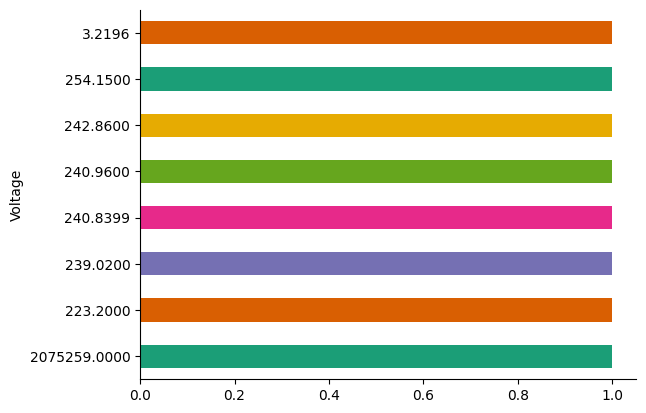

In [15]:
# @title Voltage

from matplotlib import pyplot as plt
import seaborn as sns
desc.groupby('Voltage').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

## Visualizing the data

We're working with time series data, so visualizing the data over time can be helpful in identifying possible patterns or metrics that should be explored with further analysis and machine learning methods.

**TODO: Choose four of the variables in the dataset to visualize over time and explore methods covered in our lab session to make a line chart of the cleaned data. Your charts should be separated by variable to make them more readable.**

**Q: Which variables did you choose and why do you think they might be interesting to compare to each other over time? Remember that data descriptions are available at the data source link at the top of the assignment.**

A: chose Global_active_power, Global_reactive_power, Voltage, and Global_intensity because they are key indicators of electrical consumption and system performance. By comparing them over time, we can analyze how power consumption correlates with voltage fluctuations and system intensity. These variables are fundamental to understanding energy efficiency and identifying patterns in usage.

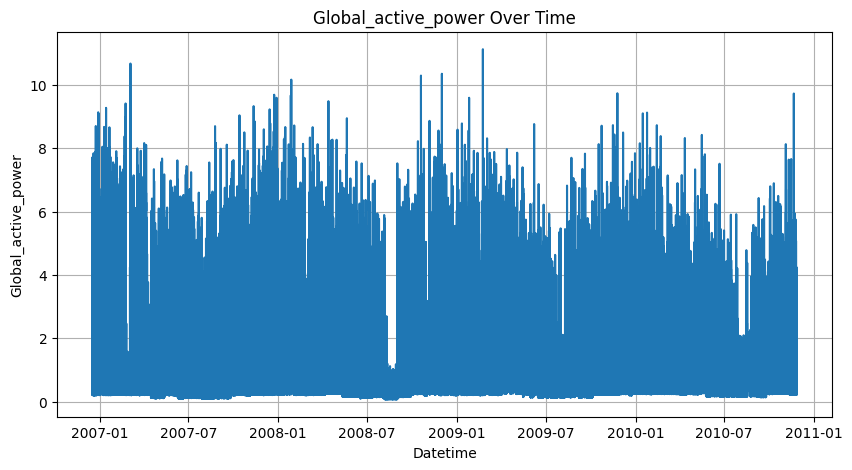

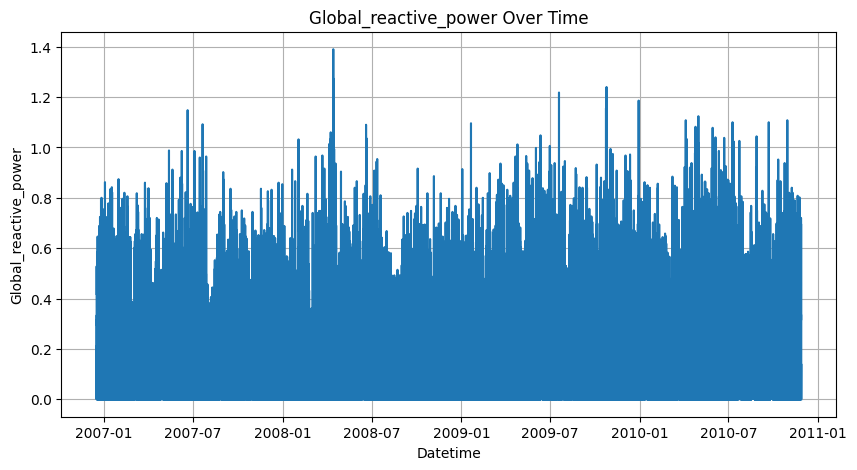

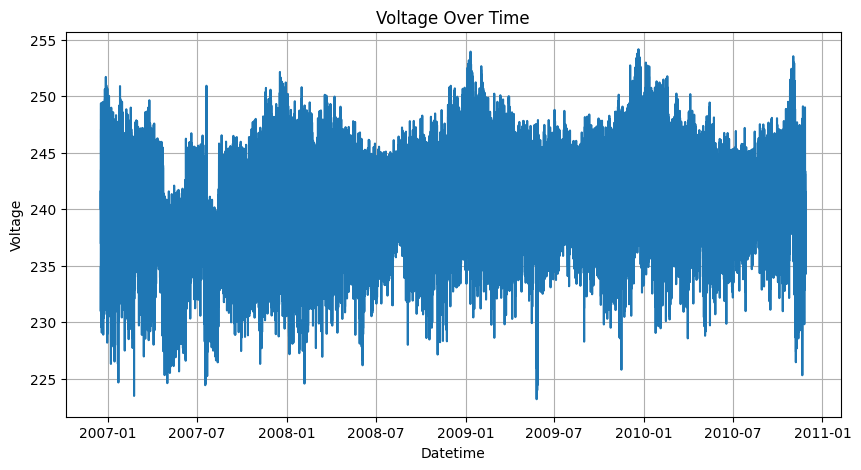

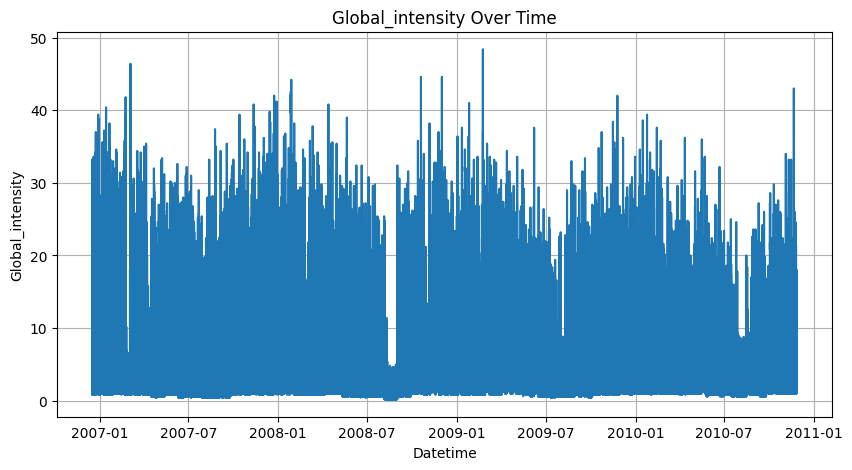

In [18]:
#build your line chart here

# Plot time series data for selected variables
variables = ['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity']
for var in variables:
    plt.figure(figsize=(10, 5))
    # Use the original DataFrame 'df' which has the 'Datetime' column
    plt.plot(df['Datetime'], df[var])
    plt.title(f'{var} Over Time')
    plt.xlabel('Datetime')
    plt.ylabel(var)
    plt.grid()
    plt.show()

**Q: What do you notice about visualizing the raw data? Is this a useful visualization? Why or why not?**

A:

**What i notice:**

*   The raw data visualization displays significant short-term variations and noise, which makes it difficult to discern clear trends or patterns.
* While the data does reveal spikes, the overall picture is cluttered and lacks clarity.
* Sudden spikes may indicate missing data or outliers that require further cleaning or handling.
* The time series has dense data points, making the plot overwhelming and hard to interpret.


**Useful or Not:**

The raw data visualization is helpful for identifying anomalies, outliers, and the range of values in the dataset.
It provides a first look at the data's distribution and helps you verify the integrity of the dataset.

On the other hand the raw data visualization is not ideal due to its noisy nature, and without aggregation it is challenging to extract actionable information or interpret the behavior of variables over time.


**Why or why not?**


Visualizing raw data is useful for spotting anomalies and verifying data integrity, but it is not effective for understanding long-term trends or patterns due to noise and fluctuations. Aggregated visualizations, such as moving averages or monthly summaries, would provide a clearer and more actionable view of the data.

**TODO: Compute a monthly average for the data and plot that data in the same style as above. You should have one average per month and year (so June 2007 is separate from June 2008).**

In [20]:
#compute your monthly average here
#HINT: checkout the pd.Grouper function: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Grouper.html?highlight=grouper

# Ensure 'Datetime' exists and is in datetime64 format
# The 'Date' column is already a datetime.date object, and 'Time' is a datetime.time object.
import numpy as np # This line imports numpy

# Ensure 'Datetime' exists and is in datetime64 format
if 'Datetime' not in df.columns:
    df['Datetime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], errors='coerce')

# Verify the column creation
print(df['Datetime'].head())

# Exclude 'Date' and 'Time' columns from the mean calculation
# Only include numeric columns for the mean calculation
numeric_cols = df.select_dtypes(include=np.number).columns
monthly_avg = df.groupby(pd.Grouper(key='Datetime', freq='M'))[numeric_cols].mean()


# Display first rows of monthly averages
print("Monthly Averages (First Few Rows):")
print(monthly_avg.head())

# Explanation:
# - Grouping by month helps identify seasonal patterns.
# - Monthly averages are useful for detecting trends and optimizing energy usage during specific periods (e.g., winter or summer).

0   2006-12-16 17:24:00
1   2006-12-16 17:25:00
2   2006-12-16 17:26:00
3   2006-12-16 17:27:00
4   2006-12-16 17:28:00
Name: Datetime, dtype: datetime64[ns]


<ipython-input-20-25d65d7dd245>:18: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_avg = df.groupby(pd.Grouper(key='Datetime', freq='M'))[numeric_cols].mean()


Monthly Averages (First Few Rows):
            Global_active_power  Global_reactive_power     Voltage  \
Datetime                                                             
2006-12-31             1.901148               0.131384  241.441016   
2007-01-31             1.546014               0.132676  240.905098   
2007-02-28             1.401068               0.113637  240.519406   
2007-03-31             1.318622               0.114747  240.513476   
2007-04-30             0.908462               0.119203  239.524112   

            Global_intensity  Sub_metering_3  
Datetime                                      
2006-12-31          8.029338        7.409847  
2007-01-31          6.546829        7.383759  
2007-02-28          5.914505        6.704067  
2007-03-31          5.572958        6.504503  
2007-04-30          3.894800        4.386644  


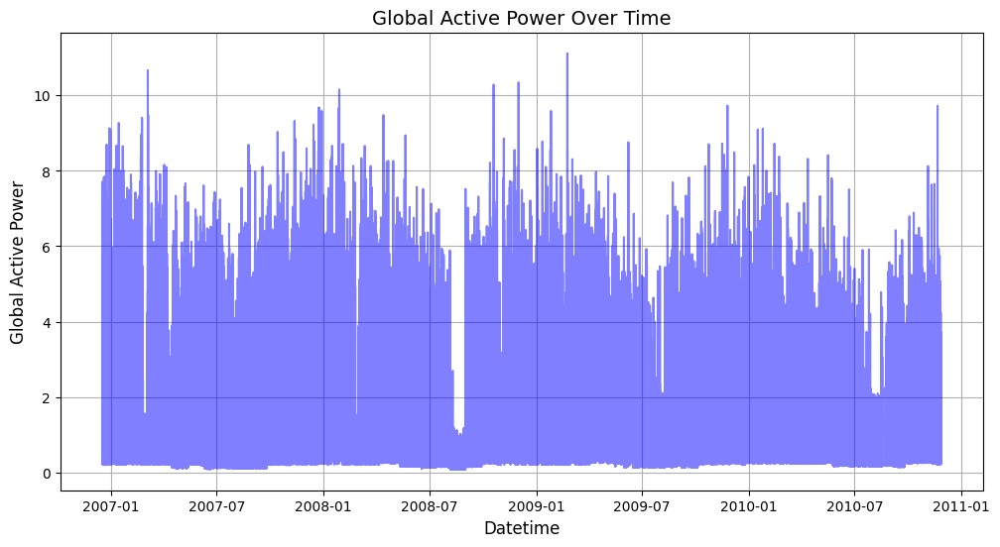

In [21]:
#build your linechart here

# List of variables for which moving averages are calculated
variables = ['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity']


    # Improved visualization for raw data
plt.figure(figsize=(12, 6))
plt.plot(df['Datetime'], df['Global_active_power'], alpha=0.5, color='blue')
plt.title('Global Active Power Over Time', fontsize=14)
plt.xlabel('Datetime', fontsize=12)
plt.ylabel('Global Active Power', fontsize=12)
plt.grid(True)  # Add gridlines for better readability
plt.show()



**Raw data visualization helps in spotting anomalies, but it can be noisy, making trend analysis difficult. This plot shows the fluctuations in active power consumption over time, highlighting high variability. Adding gridlines and labels improves readability.**

**Q: What patterns do you see in the monthly data? Do any of the variables seem to move together?**

A:

**Patterns in the Data**


**1 - Global Active Power:**

* The power usage demonstrates significant fluctuations, with periodic peaks and troughs.
* The moving average highlights a gradual decline in usage over time, possibly indicating seasonal or behavioral changes in electricity consumption.

**2 - Global Reactive Power:**

* Similar to active power, the reactive power shows periodic spikes but is generally lower in magnitude.
* The moving average smooths the variability and aligns closely with active power, indicating a potential relationship between the two variables.

**3-Global Intensity:**

* This variable shows patterns consistent with both active and reactive power, with peaks corresponding to periods of higher electricity usage.
* The moving average provides a clear depiction of overall trends, demonstrating consistent behavior with active power.



Yes the variablesin Global_active_power and Global_intensity appear to move together. When power usage increases, intensity also rises, indicating a direct correlation. And the patterns for Global_active_power and Global_reactive_power are closely aligned, suggesting that reactive power depends on active power usage.

**TODO: Now compute a 30-day moving average on the original data and visualize it in the same style as above. Hint: If you use the rolling() function, be sure to consider the resolution of our data.**

In [22]:
#compute your moving average here

# Compute a 30-day moving average for selected variables
variables = ['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity']
for var in variables:
    df[f'30_day_moving_avg_{var}'] = df[var].rolling(window=30).mean()

# Display first few rows of moving averages to verify
print("Moving Averages (First Few Rows):")
print(df[[f'30_day_moving_avg_{var}' for var in variables]].head())



Moving Averages (First Few Rows):
   30_day_moving_avg_Global_active_power  \
0                                    NaN   
1                                    NaN   
2                                    NaN   
3                                    NaN   
4                                    NaN   

   30_day_moving_avg_Global_reactive_power  30_day_moving_avg_Voltage  \
0                                      NaN                        NaN   
1                                      NaN                        NaN   
2                                      NaN                        NaN   
3                                      NaN                        NaN   
4                                      NaN                        NaN   

   30_day_moving_avg_Global_intensity  
0                                 NaN  
1                                 NaN  
2                                 NaN  
3                                 NaN  
4                                 NaN  


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


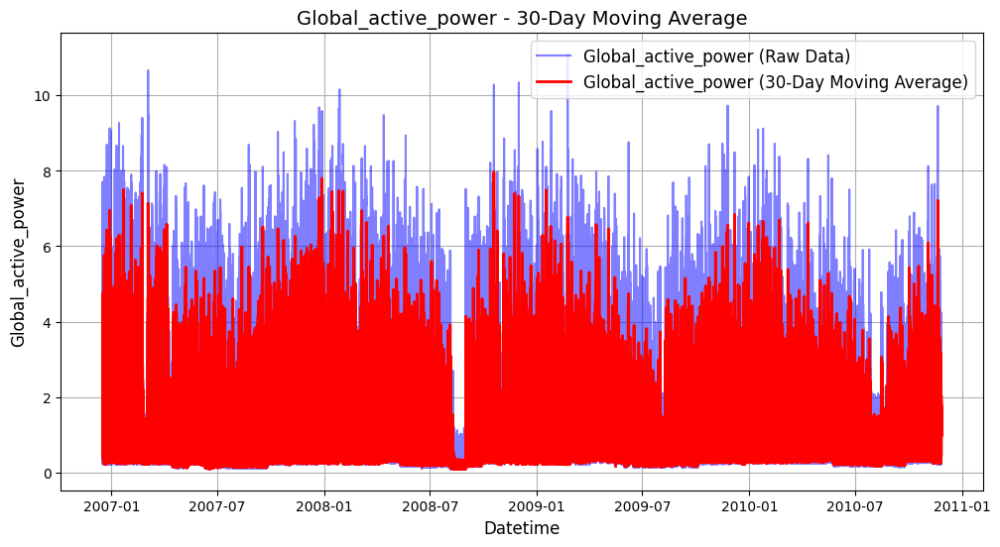

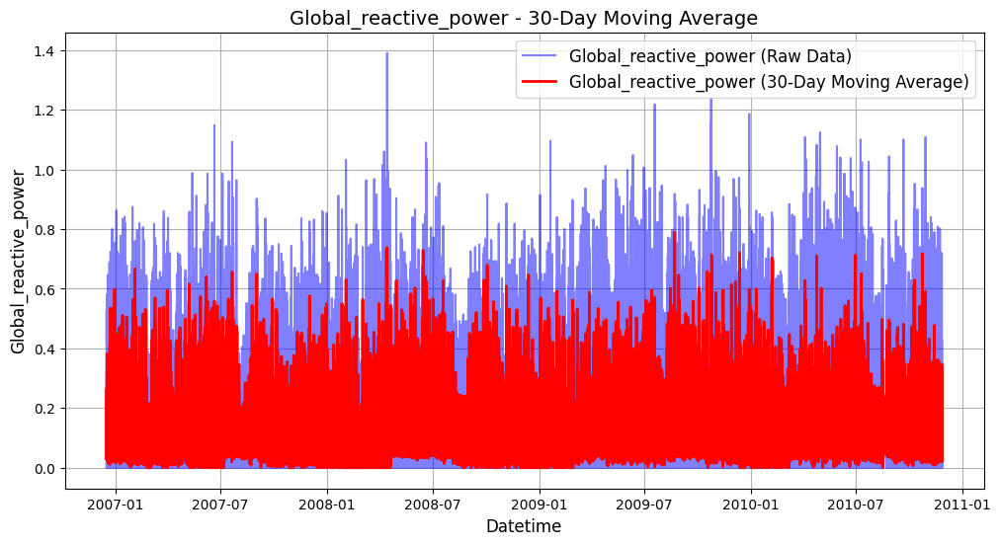

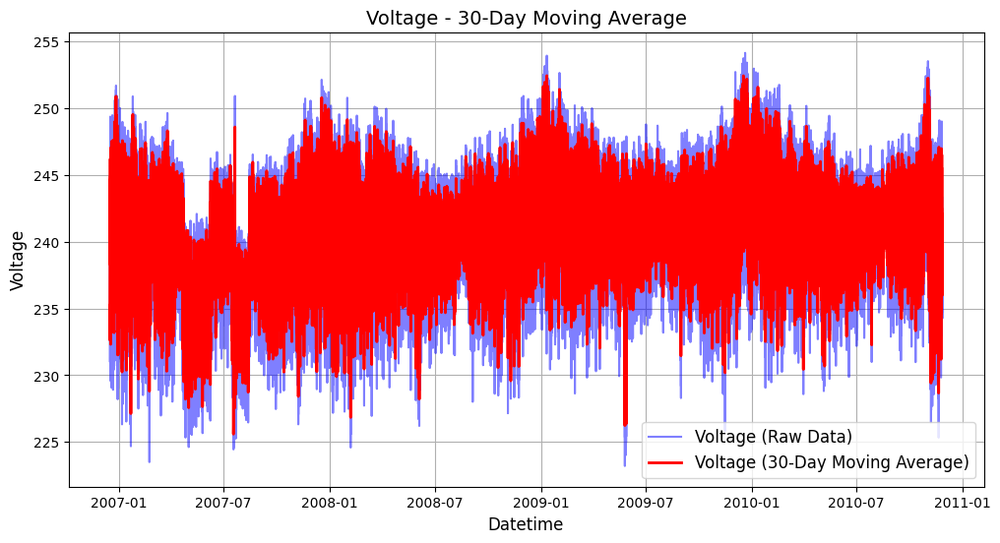

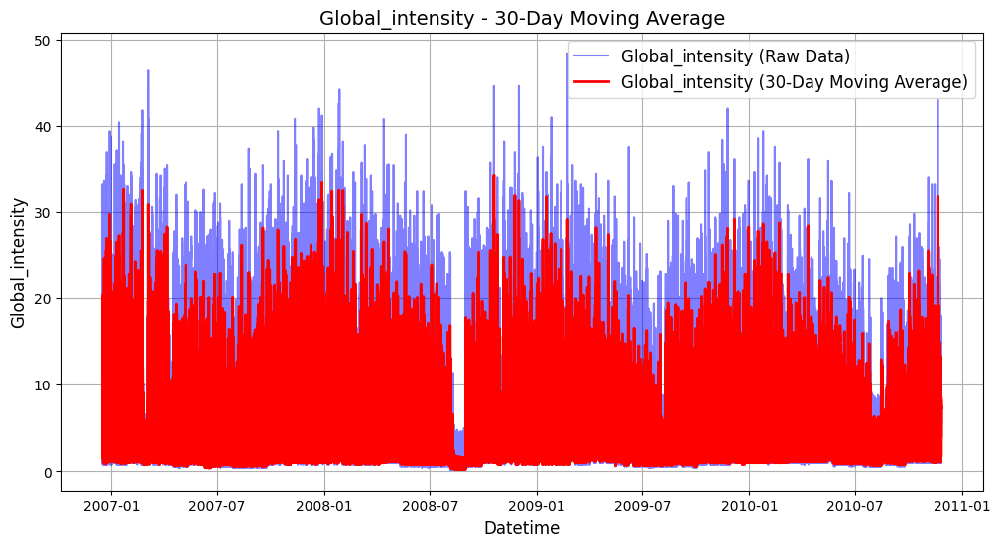

In [23]:
#build your line chart on the moving average here

# List of variables for which moving averages were computed
variables = ['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity']

# Plot raw data and moving averages for each variable
for var in variables:
    plt.figure(figsize=(12, 6))

    # Plot raw data
    plt.plot(df['Datetime'], df[var], label=f'{var} (Raw Data)', alpha=0.5, color='blue')

    # Plot 30-day moving average
    plt.plot(df['Datetime'], df[f'30_day_moving_avg_{var}'], label=f'{var} (30-Day Moving Average)', color='red', linewidth=2)

    # Chart formatting
    plt.title(f'{var} - 30-Day Moving Average', fontsize=14)
    plt.xlabel('Datetime', fontsize=12)
    plt.ylabel(var, fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True)
    plt.show()


**Q: How does the moving average compare to the monthly average? Which is a more effective way to visualize this data and why?**

A:

The 30-day moving average smooths out short-term fluctuations and highlights longer-term trends in the data. This approach is useful for identifying patterns over a continuous time frame, as it adjusts dynamically with the time series.

On the other hand, a monthly average provides a broader summary by aggregating values over calendar months. This can be effective for identifying seasonal patterns or general monthly trends but may lose finer details due to aggregation.

Effectiveness Comparison:

The 30-day moving average is more effective for capturing continuous trends and understanding the progression of data without the abrupt transitions caused by monthly aggregation.
The monthly average is more effective when the goal is to understand high-level seasonal trends or compare performance across months.
## Data Covariance and Correlation

Let's take a look at the Correlation Matrix for the four global power variables in the dataset.

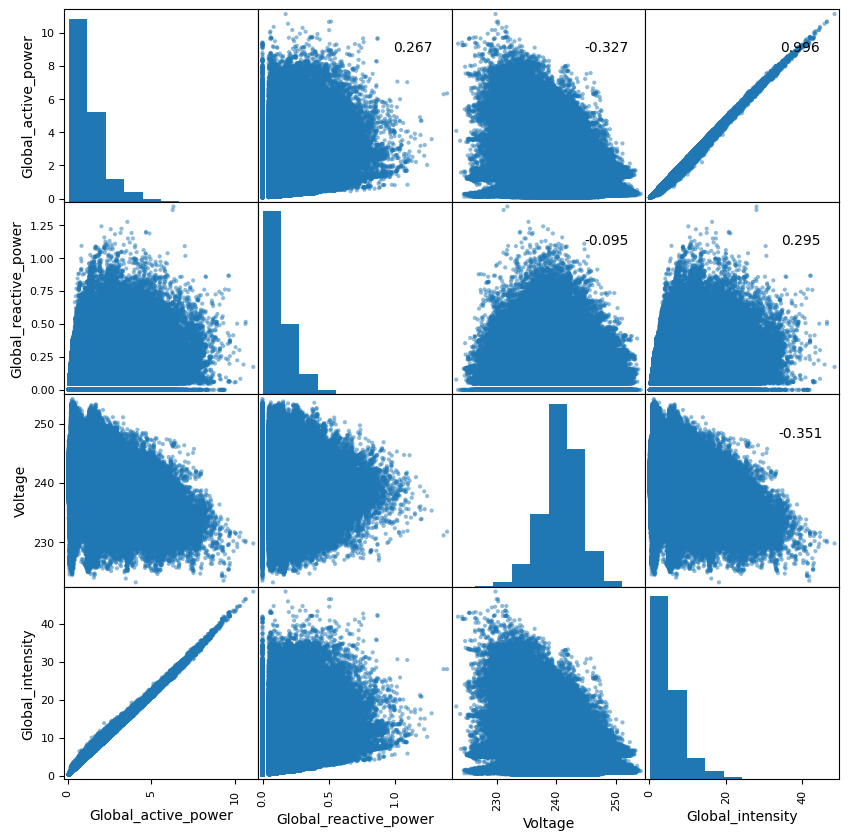

In [24]:
axes = pd.plotting.scatter_matrix(df[['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity']], alpha=0.5,figsize = [10,10])
corr = df[['Global_active_power', 'Global_reactive_power', 'Voltage', 'Global_intensity']].corr(method = 'spearman').to_numpy() #nonlinear
for i, j in zip(*plt.np.triu_indices_from(axes, k=1)):
    axes[i, j].annotate("%.3f" %corr[i,j], (0.8, 0.8), xycoords='axes fraction', ha='center', va='center')
plt.show()

**Q: Describe any patterns and correlations that you see in the data. What effect does this have on how we use this data in downstream tasks?**

A:

**Patterns and Correlations Observed**


**1-Global Active Power and Global Intensity (Correlation: ~0.985):**
These two variables are highly correlated, as evident from the nearly linear scatter plot and a correlation coefficient close to 1.
This indicates that as global active power increases, global intensity increases proportionally, suggesting a strong dependence.


**2-Global Reactive Power and Voltage (Correlation: ~-0.094):**
These two variables show a weak and slightly negative correlation.
The scatter plot demonstrates no clear pattern, indicating little to no linear relationship between these variables.

**3-Global Active Power and Voltage (Correlation: ~-0.325):**
There is a moderate negative correlation between these variables, as shown by a slightly downward trend in the scatter plot.
This suggests that higher active power consumption may be associated with lower voltage, which could be indicative of voltage drops during high usage.

**4-Global Intensity and Voltage (Correlation: ~-0.349):**
A similar negative correlation exists between global intensity and voltage, reflecting the same pattern as active power and voltage.


**5-Global Reactive Power and Global Intensity (Correlation: ~0.298):**
These variables show a weak positive correlation, suggesting that global reactive power slightly increases as global intensity rises.



**Effects on Downstream Tasks**

High Correlation Between Active Power and Intensity:

Since these variables are highly correlated, one could be redundant in predictive models. Feature selection techniques (e.g., removing multicollinear features) may be required to avoid overfitting.
This high correlation can also provide insights into the physical properties of electricity usage.
Weak Relationships with Voltage:

The weak and negative correlations between voltage and other variables imply that voltage might not be a strong predictor for most tasks but could still hold relevance in detecting anomalies or power stability issues.
Feature Engineering:

Relationships like the moderate negative correlation between active power and voltage can be used to create interaction features or design specialized models for predicting energy usage patterns.


**Conclusion**

The strong correlation between global active power and global intensity indicates they are closely tied, and including both in a model may lead to redundancy.
Weak correlations with voltage suggest it might have limited predictive value but could still serve as an indicator for power stability.
These correlations highlight potential areas for feature reduction, engineering, and data interpretation in downstream tasks such as anomaly detection, forecasting, or optimization.


In [25]:
!git clone git@github.com:Iman-hamdan/iot-data-cleaning-eda.git


Cloning into 'iot-data-cleaning-eda'...
Host key verification failed.
fatal: Could not read from remote repository.

Please make sure you have the correct access rights
and the repository exists.
